In [1]:


# warning supŕession 
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

# the process are time consuming 
import time
start_time = time.time()

# from bib import constants
from owslib.wfs import WebFeatureService

#geobases wfs url
gb_wfs = "https://ide.geobases.es.gov.br/geoserver/geonode/wfs"

geobases = WebFeatureService(gb_wfs)

# name
print(geobases.identification.title)
# operations
print([operation.name for operation in geobases.operations])
#contents
print(geobases.contents)

print("--- %s seconds ---" % (time.time() - start_time))

t at 0x7f794e62b6d8>, 'geonode:loc_aglomerado_rural_isolado_p_31984': <owslib.feature.wfs100.ContentMetadata object at 0x7f794e62b7f0>, 'geonode:tra_arruamento_l_31984': <owslib.feature.wfs100.ContentMetadata object at 0x7f794e62b908>, 'geonode:hid_banco_areia_a_31984': <owslib.feature.wfs100.ContentMetadata object at 0x7f794e62ba20>, 'geonode:hid_barragem_l_31984': <owslib.feature.wfs100.ContentMetadata object at 0x7f794e62bb38>, 'geonode:loc_capital_p_31984': <owslib.feature.wfs100.ContentMetadata object at 0x7f794e62bc50>, 'geonode:asb_cemiterio_p_31984': <owslib.feature.wfs100.ContentMetadata object at 0x7f794e62bd68>, 'geonode:loc_cidade_p_31984': <owslib.feature.wfs100.ContentMetadata object at 0x7f794e62be80>, 'geonode:hid_corredeira_p_31984_1': <owslib.feature.wfs100.ContentMetadata object at 0x7f794e62bf98>, 'geonode:hid_corredeira_a_31984': <owslib.feature.wfs100.ContentMetadata object at 0x7f794e62e0f0>, 'geonode:hid_corredeira_l_31984': <owslib.feature.wfs100.ContentMetadat

In [2]:
# name
print(geobases.identification.title)
# operations
print([operation.name for operation in geobases.operations])

My GeoServer WFS
['GetCapabilities', 'DescribeFeatureType', 'GetFeature', 'Transaction', 'LockFeature', 'GetFeatureWithLock']


In [3]:
print(list(geobases.contents))

['geonode:ana_snirh_diagnostico_abast_urb', 'geonode:_2016_07_26_comunidades_urbanas_e_rurais_es', 'geonode:ana_snirh_adutora_es_epsg_31984', 'geonode:ana_captacao_atend_mun_es_epsg_31984', 'geonode:ana_trechos_inundaveis_es_epsg_31984', 'geonode:anac_aerodromos_civis_publicos_es', 'geonode:anm_proc_minerarios_es_31984', 'geonode:APPS_1', 'geonode:HIDROGRAFIA_1', 'geonode:PONTOS_1', 'geonode:RESERVA_LEGAL_1', 'geonode:USO_RESTRITO_1', 'geonode:VEGETACAO_NATIVA_1', 'geonode:AREA_CONSOLIDADA_1', 'geonode:AREA_IMOVEL_1', 'geonode:cemaden_est_fluvi_16_04_06', 'geonode:cemaden_est_pluvi_16_04_08', 'geonode:asb_solicitacao_de_biossolido', 'geonode:asb_cesan_est_trat_esgoto_1712', 'geonode:asb_cesan_est_elev_agua_1712', 'geonode:asb_cesan_est_elev_esgoto_1712', 'geonode:asb_cesan_est_trat_agua_1712_1', 'geonode:asb_cesan_rotas_biossolido', 'geonode:asb_cesan_rede_coleto_esg_1712', 'geonode:asb_cesan_rede_agua_bruta_1712', 'geonode:asb_cesan_rede_agua_tratada_1712', 'geonode:asb_cesan_rede_emi

In [4]:
with open('layerlist.txt','w+') as layerlist_writer:
    for item in list(geobases.contents):
        layerlist_writer.write(item+'\n')

In [5]:
import geopandas as gpd
from requests import Request

layer = 'geonode:idaf_limite_municipal_2018_11' 

params = dict(service='WFS', version="1.0.0", request='GetFeature',
      typeName=layer, outputFormat='json')

print(params)

# Parse the URL with parameters
q = Request('GET', gb_wfs, params=params).prepare().url

print(q)

# Read data from URL
data = gpd.read_file(q)

print(data)

o Novo   
72  idaf_limite_municipal_2018_11.74    175               Ecoporanga   
73  idaf_limite_municipal_2018_11.75    176       Água Doce do Norte   
74  idaf_limite_municipal_2018_11.76    177            Boa Esperança   
75  idaf_limite_municipal_2018_11.77    159                   Pancas   
76  idaf_limite_municipal_2018_11.78    160             Baixo Guandú   
77  idaf_limite_municipal_2018_11.18    110        Jerônimo Monteiro   

    cod_ibge        microestad     macroestad       fonte              data  \
0    3201506      Centro-Oeste        Central  IDAF/DTCAR   Outubro de 2017   
1    3203353      Centro-Oeste        Central  IDAF/DTCAR   Outubro de 2017   
2    3205176      Centro-Oeste        Central  IDAF/DTCAR  Dezembro de 2016   
3    3204401       Litoral Sul            Sul  IDAF/DTCAR  Dezembro de 2016   
4    3204203       Litoral Sul            Sul  IDAF/DTCAR  Dezembro de 2016   
5    3202603       Litoral Sul            Sul  IDAF/DTCAR  Dezembro de 2016   
6   

In [6]:
print(geobases.identification.abstract)
print(geobases.identification.accessconstraints)
# print(geobases.identification.end)
print(geobases.identification.fees)
# print(geobases.identification.file)
# print(geobases.identification.flush)
print(geobases.identification.keywords)
# print(geobases.identification.sep)
print(geobases.identification.title)
print(geobases.identification.type)
print(geobases.identification.version)

This is a description of your Web Feature Server.

The GeoServer is a full transactional Web Feature Server, you may wish to limit
GeoServer to a Basic service level to prevent modificaiton of your geographic
data.
NONE
NONE
['WFS, WMS, GEOSERVER']
My GeoServer WFS
My GeoServer WFS
1.0.0


In [7]:
import inspect, owslib
print(geobases.getcapabilities())

# print(inspect.getmembers(owslib.feature.wfs100.ContentMetadata.predicate))


In [8]:
cont = geobases.contents

for content in cont:
    for member in inspect.getmembers(cont[content]):
        print(member)


('verbOptions', ['{http://www.opengis.net/wfs}Query', '{http://www.opengis.net/wfs}Insert', '{http://www.opengis.net/wfs}Update', '{http://www.opengis.net/wfs}Delete', '{http://www.opengis.net/wfs}Lock'])
('__class__', <class 'owslib.feature.wfs100.ContentMetadata'>)
('__delattr__', <method-wrapper '__delattr__' of ContentMetadata object at 0x7f794e67eb00>)
('__dict__', {'auth': <Authentication shared=False username=None password=None cert=None verify=True>, 'id': 'geonode:data_das_imagens_voo_aerofotogrametrico_es_2012_2015', 'title': 'data_das_imagens_voo_aerofotogrametrico_es_2012_2015', 'abstract': 'No abstract provided.', 'keywords': ['data_das_imagens_voo_aerofotogrametrico_es_2012_2015, features'], 'boundingBox': (-41.9008910678802, -21.32632804592718, -39.652049394134075, -17.867952656844498, urn:ogc:def:crs:EPSG::31984), 'boundingBoxWGS84': (-129.23538332925594, -85.52574069883015, -129.23498853072974, -85.52576090768292), 'crsOptions': [urn:ogc:def:crs:EPSG::31984], 'verbOpt

In [9]:
from pandas.util import hash_pandas_object


print(hash_pandas_object(data))

0     14912205186589544885
1      2732368776899168758
2     14869153771722258825
3      4679284045112987116
4      1930642114020975524
5     15786864514937279456
6     10282240585754920377
7     10122961051045825607
8     12913212101925839553
9      9986028696742497487
10     6419047356540337210
11     3612827491343491652
12    17102333821702053903
13     8357619073229014839
14     7438823972786731366
15     6034715399349763270
16     2311324712293151191
17     7162187965660703514
18    10548413680354974623
19    17320001040710417066
20     2235717927701832920
21      935856593325886758
22     9716514712075741398
23    13498958796370070019
24    13687966176176786474
25    12917311404586588356
26     8671452669382094304
27    12814595630087765784
28     7332570547135377955
29    16444157134255103805
              ...         
48     8281164367795444737
49     3137387302008460378
50    16248989423128041799
51      184711843363467918
52    17267058325077219477
53       74854369006017868
5

In [10]:
print(q)

https://ide.geobases.es.gov.br/geoserver/geonode/wfs?service=WFS&version=1.0.0&request=GetFeature&typeName=geonode%3Aidaf_limite_municipal_2018_11&outputFormat=json


In [11]:
print(data.head())

                                id  FID_1             nome  cod_ibge  \
0  idaf_limite_municipal_2018_11.1    178         Colatina   3201506   
1  idaf_limite_municipal_2018_11.2    179       Marilândia   3203353   
2  idaf_limite_municipal_2018_11.3    107     Vila Valério   3205176   
3  idaf_limite_municipal_2018_11.4     99  Rio Novo do Sul   3204401   
4  idaf_limite_municipal_2018_11.5    101            Piúma   3204203   

     microestad macroestad       fonte              data     area_km2  \
0  Centro-Oeste    Central  IDAF/DTCAR   Outubro de 2017  1416.813167   
1  Centro-Oeste    Central  IDAF/DTCAR   Outubro de 2017   308.964824   
2  Centro-Oeste    Central  IDAF/DTCAR  Dezembro de 2016   470.206977   
3   Litoral Sul        Sul  IDAF/DTCAR  Dezembro de 2016   204.502044   
4   Litoral Sul        Sul  IDAF/DTCAR  Dezembro de 2016    73.940721   

         perim_m  percen_are                             origem  \
0  277032.278409    3.074037  Lei Estadual 10.752 de 19/10/20

In [12]:
# IBGE code for 'Vitória'
vitoria_code = 3205309

selection = data.loc[data['cod_ibge'] == vitoria_code]
print (selection)

                                  id  FID_1     nome  cod_ibge     microestad  \
47  idaf_limite_municipal_2018_11.49    147  Vitória   3205309  Metropolitana   

       macroestad       fonte              data   area_km2       perim_m  \
47  Metropolitana  IDAF/DTCAR  Dezembro de 2016  86.328195  85924.981674   

    percen_are                             origem regional  \
47    0.187305  Lei Estadual 10.600 de 15/12/2016  Vitória   

             estrutura esc_local          lei_criaca  \
47  Escritorio Central            Lei 10.600 de 2016   

                                             geometry  
47  MULTIPOLYGON (((363834.815 7762611.303, 363859...  


In [36]:
municipalities = ['3202405']

selection = data.loc[data['cod_ibge'].isin(municipalities)]



(1, 17)
(78, 17)


(1, 17)
(78, 17)
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 78 entries, 0 to 77
Data columns (total 17 columns):
id            78 non-null object
FID_1         78 non-null int64
nome          78 non-null object
cod_ibge      78 non-null int64
microestad    78 non-null object
macroestad    78 non-null object
fonte         78 non-null object
data          78 non-null object
area_km2      78 non-null float64
perim_m       78 non-null float64
percen_are    78 non-null float64
origem        78 non-null object
regional      78 non-null object
estrutura     78 non-null object
esc_local     78 non-null object
lei_criaca    78 non-null object
geometry      78 non-null geometry
dtypes: float64(3), geometry(1), int64(2), object(11)
memory usage: 10.4+ KB
None


<AxesSubplot:>

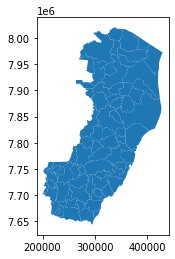

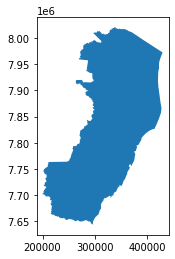

In [45]:
diss = data.dissolve()

print(diss.shape)
print(data.shape)
print(data.info())

data.plot()
diss.plot()


In [14]:
# hashing tests

url = q 
print(url)

import hashlib

import urllib

my_file = urllib.request.urlopen(url).read()



https://ide.geobases.es.gov.br/geoserver/geonode/wfs?service=WFS&version=1.0.0&request=GetFeature&typeName=geonode%3Aidaf_limite_municipal_2018_11&outputFormat=json


In [15]:
print(len(my_file))

7472131


In [16]:
with open(my_file,'rb') as file_fromurl_reader:
    for line in file_fromurl_reader:
        print(line)


OSError: [Errno 36] File name too long: b'{"type":"FeatureCollection","totalFeatures":78,"features":[{"type":"Feature","id":"idaf_limite_municipal_2018_11.1","geometry":{"type":"MultiPolygon","coordinates":[[[[337764.1024,7864080.7457],[337788.6375,7863745.246],[337755.695802,7863615.76285],[337689.250763,7863544.786912],[337672.615774,7863503.856364],[337694.368589,7863435.498809],[337661.328114,7863363.130049],[337569.113087,7863323.144946],[337464.305323,7863220.999041],[337338.189089,7863111.688226],[337272.143879,7863010.127882],[337247.232763,7862957.654441],[337164.383527,7862916.946384],[337064.31132,7862870.630139],[337001.186328,7862822.770751],[336878.100491,7862769.550979],[336734.765002,7862758.512038],[336615.392409,7862726.356167],[336506.311756,7862649.507804],[336445.56187,7862564.465063],[336381.057923,7862504.448507],[336311.590403,7862474.485635],[336158.094326,7862452.199134],[336067.496221,7862437.208358],[335908.664815,7862432.512162],[335775.854965,7862379.72074],[335642.232364,7862373.867425],[335478.440387,7862359.576778],[335186.084109,7862233.125325],[334905.259251,7862208.296518],[334950.568479,7862079.147888],[334986.069347,7861840.708936],[334974.726587,7861653.452266],[335039.340248,7861467.725531],[334795.52267,7861429.355838],[334542.353972,7861428.668359],[334423.14377,7861389.702021],[334222.462025,7861430.425748],[334056.909525,7861473.553736],[333956.924021,7861438.71279],[333841.529958,7861421.657715],[333690.252308,7861372.534302],[333681.961474,7861277.721313],[333634.750793,7861183.679248],[333588.423169,7861060.186997],[333499.585334,7861022.369498],[333340.109163,7860993.565494],[333182.041877,7861036.232538],[333017.220325,7860945.045135],[332777.010587,7860928.351588],[332689.248534,7860764.521686],[332528.230301,7860612.697058],[332369.600097,7860518.912647],[332211.796557,7860414.963127],[332029.406485,7860196.137122],[331720.259129,7859912.799711],[331595.94344,7859752.744287],[331532.964961,7859564.240403],[331436.911162,7859456.205358],[331315.1811,7859409.0378],[331188.2354,7859389.6236],[330948.5252,7859407.8024],[330854.0937,7859409.6197],[330262.0827,7859744.0992],[330176.7307,7859738.6457],[329981.5819,7859805.2213],[329848.348,7859888.2764],[329633.7898,7860031.8921],[329460.7591,7860028.4315],[329339.6378,7860005.937],[329220.2465,7859969.6008],[329137.9866,7859909.5205],[329083.5071,7859856.8039],[329072.611,7859787.7268],[329087.1394,7859733.1921],[329112.563,7859658.6614],[329125.2748,7859564.1346],[329089.863,7859490.5126],[329049.0039,7859427.7984],[329016.3157,7859389.6236],[328956.9937,7859303.5803],[328920.674,7859218.7488],[328905.5409,7859135.4315],[328901.0008,7859056.6598],[328902.5142,7858994.5504],[328891.9205,7858894.5701],[328869.2213,7858767.3228],[328863.1677,7858690.0654],[328848.0346,7858649.1646],[328816.2543,7858599.1748],[328757.2354,7858567.363],[328692.1622,7858520.4024],[328678.5425,7858493.1346],[328651.3024,7858424.9669],[328614.9827,7858346.1945],[328610.4425,7858271.9669],[328607.4165,7858175.0157],[328619.5228,7858088.6693],[328608.9299,7857941.7291],[328611.9559,7857859.9268],[328608.9299,7857758.4323],[328595.3094,7857687.2339],[328571.0969,7857643.3031],[328513.5906,7857576.6496],[328493.9173,7857549.3827],[328454.5709,7857426.6795],[328375.878,7857431.2244],[328294.1583,7857423.6504],[328230.5992,7857403.9567],[328104.9937,7857394.8677],[328035.3803,7857376.6898],[327974.848,7857340.3331],[327920.3677,7857299.4323],[327914.315,7857226.7197],[327844.7024,7857193.3929],[327754.5803,7857083.3283],[327724.574,7857027.8622],[327702.7512,7857004.2213],[327662.7433,7856966.9402],[327633.0008,7856943.8969],[327741.7496,7856868.5331],[327793.8559,7856845.4795],[327823.3496,7856796.7016],[327933.6307,7856772.3126],[327969.5362,7856736.3709],[327984.9244,7856705.5638],[328040.0646,7856652.9346],[328141.3693,7856590.0362],[328222.1567,7856500.1827],[328233.6976,7856412.8953],[328256.7795,7856297.3685],[328247.8031,7856288.3827],[328229.8504,7856251.1575],[328226.0031,7856226.7685],[328227.2858,7856185.6921],[328236.2622,7856139.4819],[328241.3913,7856099.689],[328245.2386,7856072.7331],[328255.9646,7855990.7],[328208.6709,7855913.2189],[328110.0583,7855864.9189],[328021.5079,7855859.8874],[327893.7142,7855900.1378],[327818.2457,7855935.3567],[327758.8764,7855947.4315],[327727.6827,7855936.3622],[327697.4953,7855908.1874],[327666.3016,7855867.937],[327616.8835,7855818.5937],[327623.122,7855705.1488],[327617.9228,7855645.8236],[327606.4858,7855583.3764],[327610.6449,7855533.4189],[327621.0425,7855482.4205],[327626.5024,7855457.0002],[327620.2724,7855424.3811],[327619.7929,7855407.5913],[327627.4606,7855397.5173],[327644.7126,7855397.9969],[327661.9646,7855397.5173],[327683.5291,7855387.9236],[327700.7811,7855378.8087],[327716.5953,7855369.6945],[327723.7835,7855356.7425],[327731.4512,7855341.3921],[327735.285,7855330.8386],[327735.7638,7855319.8055],[327741.0354,7855312.6102],[327747.2654,7855299.178],[327755.8913,7855288.6252],[327764.9961,7855278.5512],[327771.226,7855267.0386],[327774.1016,7855256.485],[327779.3724,7855238.7354],[327786.5614,7855218.1087],[327793.7496,7855189.326],[327798.0622,7855169.1787],[327801.8961,7855143.7543],[327810.0425,7855126.485],[327825.8575,7855098.6622],[327830.6496,7855090.9874],[327837.3583,7855076.5961],[327838.3165,7855058.8472],[327839.7543,7855044.9354],[327841.1921,7855032.4638],[327850.7764,7855021.4299],[327862.7567,7855009.9173],[327866.5906,7855001.7622],[327866.5906,7854996.0063],[327865.6323,7854984.0134],[327864.1945,7854967.7031],[327859.8819,7854963.3858],[327856.5268,7854948.9953],[327860.3606,7854937.9622],[327868.5079,7854933.1646],[327870.4244,7854928.3677],[327868.0283,7854924.0504],[327865.6323,7854918.2945],[327869.4661,7854913.9764],[327876.6543,7854912.0583],[327880.4882,7854908.7],[327880.9669,7854904.3827],[327875.6961,7854899.1055],[327869.9449,7854895.748],[327867.5488,7854890.4717],[327868.9866,7854882.7961],[327870.9039,7854874.6409],[327872.8205,7854870.3236],[327873.7787,7854866.0063],[327871.8622,7854856.4126],[327871.3827,7854846.3386],[327878.0921,7854835.785],[327881.926,7854831.9472],[327884.8008,7854824.2724],[327886.2386,7854813.2394],[327884.8008,7854806.0433],[327888.1551,7854794.0512],[327892.948,7854783.9772],[327895.8228,7854775.822],[327895.3441,7854764.3094],[327895.3441,7854752.7969],[327894.8646,7854741.763],[327889.5929,7854724.974],[327890.552,7854715.8591],[327891.0307,7854704.3465],[327889.1142,7854694.7528],[327891.0307,7854683.2394],[327891.0307,7854675.0843],[327891.0307,7854667.889],[327891.0307,7854653.4976],[327893.9063,7854642.9449],[327895.8228,7854616.0811],[327897.2606,7854609.8449],[327899.6567,7854582.022],[327902.5323,7854557.5575],[327906.3661,7854528.7756],[327907.3244,7854509.5866],[327910.1992,7854485.6016],[327914.5126,7854466.8937],[327915.9504,7854449.1441],[327916.9087,7854426.1189],[327918.3465,7854406.4512],[327914.0331,7854389.1819],[327912.5961,7854368.5543],[327914.9921,7854350.326],[327916.9087,7854333.0567],[327914.5126,7854321.0638],[327919.3047,7854303.7945],[327924.5764,7854286.0457],[327930.3268,7854275.4921],[327935.1189,7854260.6213],[327935.1189,7854247.6693],[327936.0772,7854234.7173],[327939.4323,7854221.7654],[327957.7622,7854183.2693],[327979.3268,7854142.2543],[327992.2661,7854100.1606],[328022.4567,7854041.8764],[328039.7087,7853992.2276],[328061.2732,7853943.6575],[328070.7244,7853921.4976],[328077.9354,7853899.8441],[328078.4898,7853872.6394],[328074.0528,7853843.2126],[328069.615,7853818.2283],[328071.8339,7853793.7992],[328081.8173,7853764.3724],[328097.9024,7853751.0472],[328104.5583,7853738.8331],[328112.3236,7853721.0661],[328121.7528,7853703.8543],[328136.7283,7853674.9835],[328154.4772,7853640.0055],[328164.4606,7853614.4654],[328181.6551,7853597.2535],[328193.8575,7853590.0362],[328208.8331,7853574.4906],[328221.0354,7853558.9441],[328266.5165,7853513.4165],[328310.889,7853503.978],[328366.9087,7853423.4724],[328389.0945,7853404.5953],[328403.478,7853390.8039],[328421.1449,7853384.3197],[328443.522,7853381.3724],[328468.8449,7853376.6567],[328474.1449,7853368.6984],[328473.5559,7853366.0457],[328467.9614,7853353.3717],[328465.6055,7853341.8772],[328468.5504,7853326.8449],[328466.489,7853319.4764],[328457.6559,7853316.5291],[328448.2331,7853311.2236],[328446.1724,7853300.6134],[328447.9386,7853289.1181],[328451.4724,7853278.8024],[328459.6339,7853267.7339],[328463.437,7853254.885],[328461.5354,7853240.6087],[328458.6835,7853226.3323],[328456.7819,7853210.152],[328450.6016,7853195.3992],[328443.4701,7853170.1772],[328443.4701,7853148.2866],[328446.3228,7853119.2575],[328445.3717,7853095.9394],[328439.6669,7853071.6693],[328431.585,7853047.8748],[328423.5031,7853018.8457],[328423.0276,7852996.9551],[328423.9787,7852963.6433],[328420.6504,7852937.9449],[328422.0772,7852924.1449],[328426.3551,7852896.5433],[328426.8307,7852876.0803],[328422.552,7852855.6173],[328412.5685,7852834.678],[328399.2575,7852821.8291],[328393.5528,7852808.9803],[328395.9299,7852798.0346],[328402.1094,7852792.3244],[328403.0606,7852780.4268],[328398.7819,7852769.0055],[328393.0772,7852759.4882],[328393.0772,7852748.5425],[328394.5031,7852742.8323],[328390.7,7852724.2724],[328385.9465,7852712.8512],[328375.9622,7852700.478],[328365.5039,7852674.7803],[328360.274,7852659.552],[328360.274,7852621.9575],[328359.3236,7852600.5425],[328352.6677,7852578.1756],[328345.0614,7852556.285],[328336.0283,7852532.015],[328329.3724,7852511.0756],[328326.0449,7852492.9921],[328319.8646,7852467.2945],[328318.9142,7852451.1142],[328326.0449,7852434.9339],[328326.9961,7852413.0433],[328320.8157,7852387.3457],[328309.8811,7852355.4614],[328306.078,7852332.1425],[328300.3732,7852309.3],[328291.3402,7852279.7953],[328278.1126,7852248.9252],[328274.7252,7852220.1323],[328270.7732,7852184.5654],[328269.0795,7852160.8543],[328272.4669,7852136.578],[328278.1126,7852112.3016],[328292.2268,7852086.8969],[328291.6614,7852061.4913],[328291.6614,7852033.2638],[328289.9685,7852014.0685],[328284.3228,7851989.7929],[328287.7102,7851965.5165],[328292.7906,7851943.4992],[328298.4362,7851902.8512],[328305.7756,7851869.5417],[328317.6315,7851833.9748],[328328.3583,7851800.1008],[328348.6819,7851754.3717],[328368.4417,7851712.0299],[328378.0394,7851685.4961],[328383.685,7851666.3008],[328395.5409,7851644.2827],[328406.2669,7851630.1693],[328413.6063,7851617.1843],[328418.1228,7851606.4575],[328426.5913,7851594.6016],[328434.4953,7851586.6984],[328444.6575,7851579.3591],[328454.8795,7851574.0567],[328459.1583,7851561.2079],[328469.1417,7851547.8827],[328481.0268,7851537.8898],[328502.8961,7851514.0953],[328515.7315,7851491.2528],[328528.0921,7851472.6929],[328544.2559,7851446.0433],[328552.3378,7851427.4843],[328560.8953,7851407.9724],[328575.6331,7851390.8409],[328586.0913,7851382.7504],[328585.6165,7851367.522],[328581.8134,7851363.2394],[328569.9276,7851361.3354],[328560.8953,7851358.9567],[328554.2394,7851347.0591],[328556.1409,7851336.1142],[328568.026,7851322.789],[328569.4528,7851314.2228],[328569.9276,7851300.422],[328567.0756,7851293.7598],[328560.8953,7851283.7661],[328558.5181,7851278.0559],[328558.9937,7851269.9654],[328565.6496,7851257.1165],[328569.9276,7851249.0268],[328575.6331,7851240.4606],[328594.6488,7851226.6598],[328608.911,7851214.2874],[328616.5173,7851195.7276],[328621.2717,7851177.1677],[328627.452,7851155.2772],[328619.8457,7851144.8079],[328613.1898,7851138.6213],[328611.2882,7851129.5795],[328612.2394,7851116.7307],[328618.8945,7851098.1709],[328622.2228,7851087.7016],[328622.6976,7851072.4732],[328625.0748,7851056.2929],[328625.0748,7851039.1614],[328625.0748,7851014.8913],[328625.0748,7850973.0134],[328621.7472,7850925.9],[328615.5669,7850906.389],[328609.8622,7850884.4984],[328608.911,7850860.2283],[328606.5339,7850831.6748],[328600.3535,7850808.8323],[328601.3047,7850791.7008],[328609.8622,7850781.7071],[328610.8126,7850767.4307],[328607.9606,7850751.2504],[328592.7472,7850732.6906],[328587.4906,7850716.7134],[328588.0551,7850698.648],[328583.5386,7850674.9362],[328577.5346,7850647.5071],[328571.3543,7850619.4299],[328571.3543,7850596.5874],[328574.6819,7850583.7386],[328580.8622,7850572.7929],[328578.9606,7850554.7094],[328575.1575,7850535.674],[328578.0094,7850513.7835],[328583.2394,7850500.9346],[328580.3866,7850488.5614],[328571.3543,7850476.6646],[328560.8953,7850469.526],[328546.1575,7850459.0567],[328540.9283,7850450.015],[328539.5024,7850440.0213],[328539.0268,7850430.5031],[328537.1252,7850412.4197],[328528.0921,7850398.6189],[328525.715,7850390.5291],[328528.0921,7850378.6315],[328533.7969,7850366.2591],[328538.5512,7850360.0724],[328541.8787,7850352.9339],[328542.8299,7850338.6575],[328543.7803,7850330.5669],[328545.2071,7850322.4772],[328550.4362,7850317.2425],[328558.0425,7850315.815],[328567.0756,7850315.815],[328579.4362,7850306.7732],[328590.3701,7850302.4898],[328600.8291,7850287.2614],[328603.6819,7850279.1717],[328607.0094,7850269.178],[328611.2882,7850253.474],[328615.5669,7850243.4803],[328620.3213,7850241.5764],[328621.7472,7850235.3898],[328618.8945,7850230.1551],[328616.9929,7850224.9205],[328616.5173,7850220.1614],[328619.3701,7850211.1197],[328621.7472,7850204.4575],[328624.5992,7850194.9402],[328622.2228,7850184.9465],[328623.1732,7850174.4772],[328629.8291,7850162.1039],[328638.8614,7850160.2],[328650.7465,7850160.2],[328658.3535,7850153.0622],[328665.4843,7850140.2134],[328670.2386,7850122.6055],[328672.6157,7850110.2323],[328675.9433,7850099.763],[328680.222,7850091.1969],[328683.074,7850084.0583],[328681.648,7850076.9205],[328680.222,7850069.3063],[328686.4024,7850056.4575],[328697.8118,7850035.5181],[328707.3205,7850020.7654],[328716.3528,7850005.537],[328725.8606,7849990.3087],[328738.2213,7849968.4181],[328747.2543,7849957.9488],[328759.1394,7849957.4732],[328780.0575,7849968.4181],[328794.3189,7849974.6047],[328813.3354,7849974.6047],[328828.548,7849971.2732],[328846.6142,7849960.3283],[328868.9583,7849952.7142],[328882.2693,7849946.5276],[328888.9252,7849935.1063],[328890.3512,7849926.5402],[328890.3512,7849917.974],[328895.5803,7849907.9811],[328903.1866,7849902.2701],[328906.9906,7849902.7457],[328920.3016,7849899.415],[328926.4819,7849890.8488],[328927.4331,7849873.7173],[328925.0559,7849858.9646],[328934.0882,7849851.3504],[328939.3181,7849845.1638],[328941.2197,7849836.5976],[328943.1213,7849826.1283],[328946.9244,7849814.7071],[328946.9244,7849800.4307],[328939.3181,7849780.4433],[328931.711,7849763.3118],[328925.5307,7849741.8969],[328922.6787,7849731.4268],[328922.6787,7849719.5299],[328925.0559,7849711.9157],[328933.1378,7849704.3016],[328942.1701,7849692.8803],[328944.5472,7849683.363],[328944.5472,7849672.8929],[328944.5472,7849662.8992],[328945.9732,7849652.9063],[328947.8748,7849643.8646],[328955.0063,7849631.9669],[328959.285,7849625.3047],[328960.2354,7849615.7866],[328960.711,7849607.2213],[328960.711,7849599.1307],[328956.4323,7849590.089],[328951.6787,7849581.9992],[328945.0228,7849573.9087],[328941.2197,7849568.674],[328941.2197,7849562.9638],[328945.4984,7849552.0181],[328957.3835,7849538.6937],[328971.1701,7849527.2724],[328983.0551,7849506.8094],[328986.8583,7849492.5323],[328987.8094,7849485.8701],[328991.6126,7849482.063],[328995.4157,7849472.5457],[328998.2677,7849462.552],[329004.448,7849459.6961],[329008.252,7849455.889],[329011.5795,7849449.2268],[329009.678,7849442.5646],[329012.5299,7849436.378],[329023.4646,7849418.2945],[329031.0709,7849407.3488],[329033.9236,7849394.9756],[329039.6283,7849386.8858],[329049.6118,7849372.1331],[329060.0709,7849365.4709],[329073.3819,7849346.9118],[329080.989,7849331.2071],[329090.0213,7849314.0756],[329097.1528,7849311.2205],[329121.3984,7849313.1236],[329169.8898,7849307.889],[329188.9055,7849302.178],[329209.8236,7849295.9913],[329233.1181,7849295.0402],[329260.6921,7849282.6669],[329276.8559,7849267.9142],[329293.0197,7849266.963],[329302.5276,7849263.6315],[329308.2323,7849250.3071],[329303.478,7849238.885],[329297.2984,7849230.7953],[329292.0685,7849217.9465],[329284.4622,7849201.7661],[329276.3803,7849184.6346],[329279.2331,7849167.9787],[329285.4126,7849167.0268],[329306.3307,7849172.737],[329316.7898,7849170.3583],[329324.3961,7849159.8882],[329330.1008,7849153.226],[329341.0354,7849147.0394],[329345.3142,7849134.6661],[329346.7402,7849118.4866],[329346.7402,7849105.637],[329341.511,7849091.837],[329338.1827,7849081.3669],[329329.1504,7849058.5244],[329331.5276,7849037.1102],[329346.7402,7849024.2606],[329366.2315,7849018.5504],[329375.2646,7849005.2252],[329380.0189,7848987.6181],[329378.1173,7848966.6787],[329374.789,7848952.4024],[329377.6417,7848942.4087],[329392.3787,7848924.3252],[329402.363,7848917.1866],[329407.5921,7848906.2409],[329401.4118,7848891.0134],[329395.2315,7848874.8331],[329389.5268,7848866.7425],[329386.1984,7848850.563],[329401.378,7848828.1969],[329433.8724,7848812.3772],[329460.1244,7848812.4921],[329487.2228,7848817.489],[329505.763,7848826.0543],[329515.0339,7848833.9071],[329528.5827,7848843.1866],[329546.4102,7848845.3276],[329579.9268,7848846.7559],[329603.4591,7848858.1772],[329635.5488,7848858.8906],[329661.9339,7848860.3181],[329712.5646,7848872.4535],[329749.6465,7848881.0197],[329781.0228,7848888.1575],[329847.3417,7848902.4339],[329875.8661,7848920.9937],[329897.9724,7848937.4118],[329931.489,7848941.6945],[329960.726,7848952.4024],[330005.652,7848966.6787],[330033.0543,7849004.7945],[330043.774,7849059.2213],[330052.8457,7849096.3299],[330075.9354,7849125.1921],[330098.2008,7849162.3016],[330111.3953,7849177.1449],[330119.6417,7849205.1827],[330122.9402,7849230.7465],[330111.3953,7849260.4339],[330122.1157,7849318.9835],[330144.3811,7849415.4661],[330150.1535,7849464.9449],[330159.2244,7849507.8268],[330177.3661,7849543.2858],[330199.6323,7849560.6039],[330222.7937,7849573.7898],[330239.9079,7849610.1953],[330271.9976,7849651.9543],[330332.9685,7849683.0055],[330450.6315,7849716.1984],[330517.411,7849743.3874],[330575.5315,7849765.8197],[330693.5661,7849705.0567],[330838.2654,7849631.9213],[330916.1197,7849615.4063],[331015.9937,7849580.0181],[331109.5764,7849605.1835],[331241.6929,7849670.4551],[331299.8866,7849728.6488],[331327.411,7849744.3772],[331354.9354,7849756.1732],[331379.3142,7849740.4449],[331408.411,7849719.9984],[331438.2945,7849686.9693],[331475.3677,7849653.5606],[331509.0622,7849635.8929],[331565.2189,7849613.4079],[331643.8394,7849621.4378],[331666.3024,7849659.985],[331695.1827,7849674.4402],[331748.1315,7849680.8646],[331791.4528,7849700.1378],[331839.5874,7849753.1394],[331906.9764,7849804.5354],[332050.5417,7849824.3693],[332218.674,7849883.0465],[332268.3236,7849987.9882],[332328.1291,7850126.7819],[332333.7717,7850265.5756],[332337.1567,7850359.2331],[332304.4331,7850438.222],[332241.2425,7850498.0276],[332193.8488,7850590.5567],[332251.3976,7850651.4906],[332366.4953,7850738.3772],[332487.2346,7850764.3307],[332612.4874,7850826.3929],[332686.9622,7850855.7315],[332770.4638,7850889.5835],[332815.6,7850921.1787],[332869.7638,7850925.6929],[332928.4409,7850932.463],[332989.3748,7850957.2882],[333051.2803,7850965.0913],[333159.3244,7850875.774],[333234.2354,7850833.9969],[333294.7402,7850809.5071],[333371.0913,7850797.9827],[333437.3583,7850759.0866],[333499.3039,7850708.6654],[333637.4512,7850692.3921],[333784.0874,7850694.6858],[333924.9961,7850705.0071],[334007.4787,7850735.9693],[334095.6898,7850730.2354],[334172.4441,7850706.1535],[334221.7047,7850693.5394],[334245.5299,7850639.5173],[334282.9858,7850602.0622],[334297.3913,7850558.8441],[334326.2031,7850522.8291],[334331.9661,7850496.8984],[334339.015,7850478.2913],[334348.8661,7850449.2811],[334379.178,7850401.0819],[334403.8543,7850349.5134],[334448.5323,7850299.6299],[334479.4638,7850258.3465],[334508.6764,7850213.6236],[334529.2969,7850172.3402],[334551.6362,7850122.4567],[334598.0331,7850057.0913],[334611.7795,7850012.3685],[334666.7685,7849983.126],[334714.8835,7849952.1638],[334783.6189,7849974.5252],[334848.9181,7849976.2457],[334921.0906,7850003.7677],[334981.2339,7850022.689],[335041.378,7850039.8906],[335115.2685,7849952.1638],[335206.3433,7849883.3583],[335374.7457,7849860.9969],[335383.3378,7849830.0346],[335383.3378,7849752.6291],[335369.5906,7849692.4244],[335367.8724,7849621.8992],[335367.8724,7849504.9299],[335352.4071,7849246.911],[335345.5331,7849186.7063],[335345.5331,7849123.0614],[335324.9126,7849055.9772],[335290.5449,7848992.3323],[335271.6425,7848939.0079],[335275.0795,7848871.9228],[335268.2055,7848804.8378],[335278.5157,7848736.0331],[335299.137,7848672.3882],[335324.9126,7848586.3819],[335342.0969,7848510.6961],[335360.9984,7848490.0543],[335402.2402,7848385.1268],[335433.1717,7848280.1984],[335448.637,7848207.9535],[335474.4126,7848135.7079],[335491.5969,7848089.2646],[335498.4701,7848018.7394],[335522.5276,7847961.9748],[335539.7118,7847939.6134],[335550.022,7847884.5693],[335570.6425,7847831.2449],[335594.7,7847757.2795],[335623.9126,7847697.0748],[335654.8441,7847635.7236],[335655.9898,7847592.1472],[335655.9898,7847566.9189],[335664.0087,7847535.9567],[335690.3575,7847514.1677],[335720.1425,7847494.6732],[335727.0165,7847463.711],[335724.7252,7847433.8953],[335729.3079,7847401.7866],[335747.637,7847376.5575],[335773.9858,7847342.1551],[335785.4417,7847312.3394],[335785.4417,7847291.6984],[335811.7906,7847268.763],[335833.5567,7847261.8827],[335847.3039,7847241.2409],[335848.4496,7847205.6913],[335848.4496,7847178.1701],[335849.5953,7847157.5283],[335854.1772,7847132.2992],[335857.6142,7847102.4843],[335870.2157,7847064.6409],[335880.526,7847053.174],[335910.3118,7847033.6787],[335946.9709,7847018.7709],[335981.3386,7847006.1567],[336001.9591,7846986.6622],[336020.289,7846922.4441],[336029.4535,7846869.6929],[336029.4535,7846827.2638],[336037.4724,7846795.1543],[336044.3465,7846752.7244],[336038.6181,7846716.0283],[336053.511,7846688.5063],[336099.3346,7846695.3866],[336134.848,7846696.5339],[336178.6913,7846681.348],[336207.1488,7846630.9543],[336213.0772,7846590.0465],[336207.7417,7846536.0961],[336201.2197,7846499.9307],[336188.7701,7846470.2882],[336169.2047,7846441.237],[336137.1906,7846385.5079],[336113.4756,7846349.3433],[336095.6898,7846327.4071],[336114.8252,7846259.2693],[336118.7197,7846188.1173],[336142.0827,7846138.9126],[336153.178,7846109.3961],[336168.0701,7846050.9118],[336171.5071,7846033.711],[336195.5646,7846022.2433],[336220.7677,7846008.4819],[336286.1567,7845976.785],[336327.9276,7845952.3598],[336352.3528,7845919.085],[336383.5039,7845879.4378],[336423.8591,7845864.2165],[336451.0323,7845867.4315],[336475.0898,7845844.4969],[336476.2354,7845794.0394],[336492.2732,7845759.637],[336532.3693,7845729.8213],[336583.9213,7845721.7945],[336646.9291,7845724.0874],[336690.4614,7845711.4732],[336729.463,7845681.7764],[336753.7709,7845653.3189],[336771.5567,7845624.2685],[336784.6,7845589.8819],[336800.0142,7845544.8244],[336816.6142,7845516.3669],[336851.8378,7845487.5142],[336866.3307,7845475.974],[336873.8457,7845468.4591],[336873.5772,7845427.1276],[336867.6724,7845359.2252],[336878.6764,7845333.9969],[336877.8717,7845310.6472],[336882.9709,7845278.1724],[336897.1953,7845251.6024],[336920.2764,7845225.837],[336950.5118,7845208.0488],[336968.8409,7845203.4622],[336994.0441,7845197.7283],[337012.3732,7845185.1142],[337012.3732,7845172.5],[337006.6457,7845157.5921],[336996.4984,7845136.4638],[337004.2819,7845108.552],[337020.3929,7845084.2],[337023.6055,7845050.3118],[337040.2457,7845026.6937],[337054.7606,7845017.6882],[337087.9827,7844983.2858],[337107.8795,7844971.137],[337134.1811,7844960.6701],[337180.8803,7844946.1772],[337192.9583,7844936.7835],[337210.6717,7844925.511],[337220.3339,7844909.4079],[337242.3417,7844886.0583],[337293.6031,7844899.2094],[337334.6669,7844923.3646],[337362.3961,7844907.4024],[337395.0024,7844858.2898],[337431.6614,7844838.7945],[337462.5921,7844818.1535],[337507.4921,7844793.9921],[337556.278,7844766.3937],[337666.952,7844718.1654],[337711.8354,7844717.8866],[337758.085,7844698.2118],[337782.3929,7844679.2402],[337807.5315,7844670.5394],[337836.122,7844682.6354],[337846.3669,7844669.0756],[337866.0331,7844629.6331],[337866.9874,7844608.2976],[337869.3315,7844567.1732],[337851.737,7844563.4346],[337855.9157,7844550.4591],[337862.4047,7844541.7858],[337858.9685,7844538.3457],[337850.9488,7844531.4654],[337856.6772,7844518.8512],[337869.2787,7844505.0898],[337869.2787,7844494.7693],[337869.2787,7844486.7417],[337883.026,7844471.8339],[337892.1906,7844462.6598],[337893.678,7844457.2661],[337895.9551,7844449.6677],[337892.9189,7844442.8299],[337890.2622,7844435.2323],[337894.437,7844431.0535],[337900.8882,7844430.2937],[337905.063,7844423.0756],[337913.4118,7844414.3386],[337923.6591,7844402.9417],[337936.9417,7844387.3661],[337947.1882,7844380.9079],[337964.2661,7844371.7906],[337988.5543,7844351.6559],[337996.9039,7844341.3992],[338012.0843,7844325.4433],[338029.5417,7844318.6055],[338071.6669,7844312.5276],[338097.4732,7844312.5276],[338116.4488,7844311.0079],[338143.7732,7844301.1307],[338156.2969,7844290.4937],[338159.7126,7844276.8173],[338162.7488,7844260.1024],[338163.1283,7844248.326],[338166.5441,7844235.4094],[338175.652,7844228.5717],[338190.0732,7844228.5717],[338201.0787,7844224.3929],[338209.0488,7844219.074],[338228.0244,7844211.0961],[338240.548,7844200.8394],[338261.8,7844197.8],[338280.7756,7844196.2803],[338333.9071,7844188.3031],[338366.1646,7844183.3646],[338395.7661,7844177.6661],[338413.2236,7844179.5654],[338482.674,7844179.9457],[338511.5165,7844172.3472],[338537.3228,7844164.3701],[338571.8583,7844157.152],[338598.0441,7844151.0732],[338632.5795,7844144.9953],[338655.3496,7844141.9559],[338678.8795,7844141.5764],[338695.578,7844151.4535],[338722.1433,7844157.152],[338738.4622,7844157.5315],[338757.0583,7844151.4535],[338769.9614,7844141.5764],[338782.1055,7844128.6598],[338793.8701,7844122.9614],[338815.5024,7844108.9055],[338838.652,7844094.8496],[338854.9709,7844083.8331],[338869.0126,7844080.4142],[338889.1268,7844082.3134],[338914.5535,7844095.9898],[338932.3906,7844095.6094],[338950.9866,7844089.1512],[338969.9614,7844088.7717],[338990.0756,7844082.3134],[339004.4969,7844077.7543],[339014.7433,7844083.4528],[339024.611,7844084.2126],[339043.9654,7844081.9331],[339057.2488,7844075.0953],[339063.7,7844064.0787],[339059.1457,7844041.285],[339063.3205,7844029.1283],[339076.6031,7844010.5142],[339087.989,7843999.4969],[339091.7835,7843985.0614],[339095.5787,7843974.8039],[339099.7535,7843959.2283],[339106.2047,7843933.0157],[339105.8252,7843923.5189],[339104.6866,7843904.5244],[339104.6866,7843884.3898],[339104.6866,7843871.0937],[339104.6866,7843857.7976],[339104.6866,7843846.7811],[339104.3071,7843833.1047],[339106.2047,7843816.7693],[339110,7843790.937],[339101.4614,7843766.2441],[339090.0756,7843716.0984],[339077.552,7843676.2094],[339060.474,7843633.4717],[339054.7819,7843609.5386],[339041.689,7843586.7449],[339031.4417,7843554.2646],[339032.011,7843527.4819],[339025.1803,7843505.8283],[339014.3638,7843477.9063],[338996.7173,7843442.0063],[338981.9165,7843425.4811],[338977.3622,7843404.3976],[338977.3622,7843377.0449],[338977.3622,7843347.4134],[338975.085,7843318.352],[338973.3772,7843283.5921],[338979.6394,7843255.6701],[338988.178,7843222.6197],[338989.8858,7843182.1606],[338997.2866,7843145.6913],[339008.1024,7843116.0598],[339026.8882,7843111.5016],[339053.074,7843107.5126],[339083.2449,7843104.663],[339111.7079,7843105.8031],[339134.478,7843118.9094],[339157.2488,7843133.1551],[339180.5882,7843157.0882],[339203.9283,7843164.4961],[339230.1142,7843174.7535],[339254.5921,7843177.6024],[339275.6551,7843180.4512],[339309.811,7843183.3008],[339334.8583,7843184.4402],[339359.9055,7843194.6976],[339384.9535,7843204.385],[339404.878,7843206.0945],[339425.3709,7843205.5244],[339445.2953,7843205.5244],[339481.7276,7843200.3961],[339494.8213,7843192.9882],[339504.4984,7843186.7197],[339509.622,7843161.6472],[339518.1606,7843148.5409],[339524.4228,7843132.0157],[339523.8535,7843119.4787],[339525.5606,7843108.0827],[339531.2535,7843099.5346],[339547.7622,7843089.8472],[339558.578,7843080.1598],[339568.2559,7843071.6126],[339581.3488,7843067.6236],[339594.4417,7843056.7969],[339604.1189,7843042.5512],[339612.6583,7843036.2827],[339645.6756,7843035.1433],[339665.0299,7843037.9921],[339680.9693,7843035.7134],[339706.5945,7843024.8843],[339733.922,7843003.7976],[339749.2945,7842982.7102],[339756.1268,7842971.8819],[339768.652,7842966.7528],[339778.9,7842963.3331],[339783.4543,7842955.9244],[339784.0244,7842948.5157],[339793.7031,7842938.8276],[339805.0898,7842931.4181],[339818.1843,7842931.4181],[339837.5417,7842940.537],[339848.3591,7842948.5157],[339863.7315,7842947.9457],[339878.5339,7842939.9669],[339891.6291,7842934.8378],[339908.1394,7842929.1386],[339917.8181,7842930.2787],[339930.9134,7842935.978],[339947.4244,7842933.1283],[339957.6724,7842925.1488],[339963.9346,7842917.1709],[339962.2268,7842910.3315],[339965.6425,7842902.3528],[339979.3071,7842894.9441],[339994.1094,7842894.374],[340012.8976,7842896.0835],[340033.3945,7842908.052],[340043.6425,7842907.4819],[340053.3213,7842901.2126],[340087.4811,7842894.9441],[340094.8827,7842888.1047],[340104.5614,7842881.2661],[340118.7945,7842876.137],[340128.4732,7842873.2874],[340142.1378,7842867.0181],[340158.0787,7842867.5882],[340176.8669,7842869.8677],[340190.5315,7842867.5882],[340202.4874,7842863.0283],[340211.0315,7842867.0173],[340225.2654,7842865.3079],[340235.5134,7842863.0283],[340261.1339,7842860.7488],[340275.3677,7842868.1575],[340290.1709,7842869.8669],[340312.9449,7842863.0283],[340318.6378,7842853.3394],[340325.4701,7842840.2315],[340329.4559,7842829.4024],[340344.2591,7842820.2843],[340361.3394,7842824.8433],[340372.726,7842828.8331],[340399.485,7842829.4024],[340437.0622,7842815.1543],[340460.9748,7842798.6268],[340483.1795,7842779.8197],[340496.2748,7842773.5504],[340513.9244,7842762.152],[340536.6984,7842756.4528],[340574.8441,7842739.3551],[340598.1874,7842730.2362],[340611.852,7842714.848],[340630.0709,7842692.6213],[340645.4433,7842665.8346],[340668.7866,7842636.7685],[340691.5606,7842627.6504],[340716.6118,7842612.2622],[340767.2843,7842584.3362],[340796.3205,7842573.5071],[340816.8173,7842556.4094],[340826.4961,7842548.4307],[340836.7441,7842538.1724],[340848.7008,7842533.0425],[340863.5039,7842528.4835],[340875.4598,7842517.085],[340878.3071,7842503.4071],[340889.1244,7842478.9],[340903.9276,7842459.5228],[340922.7157,7842441.285],[340946.6283,7842419.0583],[340973.9575,7842396.2614],[340993.315,7842388.2827],[341019.5047,7842382.5835],[341043.9866,7842384.2929],[341066.7606,7842379.7339],[341071.885,7842374.6039],[341070.1772,7842365.4858],[341062.2063,7842359.2165],[341051.9575,7842348.3882],[341049.6803,7842336.4197],[341056.5126,7842334.1394],[341069.6079,7842335.2795],[341082.7024,7842343.2583],[341102.0606,7842351.8071],[341116.2937,7842356.9362],[341131.6661,7842351.8071],[341140.7756,7842339.2693],[341146.4709,7842321.6016],[341150.4567,7842308.4929],[341161.274,7842298.8047],[341177.7858,7842285.6961],[341191.4504,7842265.1787],[341191.4504,7842251.5],[341197.7134,7842238.3913],[341208.5307,7842224.1433],[341231.8748,7842208.7551],[341247.8165,7842189.3772],[341262.0504,7842163.7307],[341272.2992,7842146.063],[341277.4228,7842126.115],[341285.9638,7842114.1465],[341298.4898,7842101.6079],[341318.4173,7842090.2094],[341337.2055,7842074.2512],[341344.6071,7842056.5835],[341340.1701,7842021.4441],[341348.8772,7841995.2969],[341351.7795,7841929.9268],[341359.0354,7841880.5362],[341383.7055,7841810.8087],[341417.0835,7841738.1756],[341439.3953,7841664.6346],[341650,7841517.5528],[341855.7063,7841424.4016],[342129.9819,7841365.5685],[342355.2795,7841296.9299],[342560.9866,7841208.6811],[342707.9197,7841086.1134],[342859.7512,7840865.4906],[342972.4,7840610.5488],[343114.4354,7840458.5638],[343344.6307,7840355.6063],[343565.0307,7840277.163],[343687.4756,7840164.4],[343883.3866,7839963.3882],[344030.3197,7839821.2094],[344189.4976,7839588.3299],[344527.4441,7839419.1858],[345034.3646,7839286.8118],[345328.2307,7839294.1661],[345585.3646,7839242.6874],[345813.111,7839132.3764],[346004.1244,7839073.5433],[346364.111,7839095.6055],[346724.0976,7839110.3142],[347106.1244,7839147.0843],[347414.6843,7839191.2087],[347605.6976,7839242.6874],[347789.3646,7839257.3961],[347980.378,7839242.6874],[348186.0843,7839308.874],[348303.6307,7839352.9992],[348487.2976,7839352.9992],[348766.4709,7839316.2283],[349016.2575,7839382.415],[349185.2315,7839426.5402],[349471.7512,7839441.248],[349677.4575,7839397.1236],[349853.778,7839338.2906],[350154.9913,7839294.1661],[350331.311,7839257.3961],[350529.6709,7839183.8551],[350830.8843,7839183.8551],[351073.3244,7839183.8551],[351470.0449,7839110.3142],[351844.7244,7838992.6488],[352167.978,7838919.1079],[352410.4181,7838897.0457],[352638.1646,7838816.1504],[352902.6449,7838720.5472],[353196.511,7838654.3606],[353527.111,7838588.1732],[353806.2843,7838551.4031],[354085.4583,7838536.6953],[354315.1094,7838564.6433],[354659.6165,7838636.2173],[354890.3717,7838743.578],[354991.1236,7838772.8583],[355226.3929,7838889.1969],[355645.552,7839105.7559],[355887.6756,7839265.0543],[356014.1992,7838950.7079],[356013.4945,7838928.4638],[356005.4945,7838906.9638],[356003.4945,7838881.9638],[356001.4945,7838854.9638],[356000.4945,7838838.9638],[356003.9945,7838822.9638],[356004.9945,7838810.4638],[356004.9945,7838795.9638],[356002.9945,7838783.9638],[355995.9945,7838765.4638],[356001.4945,7838741.9638],[356021.9945,7838716.4638],[356046.4945,7838700.4638],[356070.9945,7838674.4638],[356073.9945,7838667.4638],[356081.9945,7838638.9638],[356082.4945,7838613.4638],[356071.9945,7838592.9638],[356069.9945,7838579.4638],[356070.9945,7838557.9638],[356077.4945,7838537.9638],[356086.9945,7838514.4638],[356094.9945,7838477.4638],[356090.9945,7838463.9638],[356077.9945,7838457.4638],[356071.9945,7838427.4638],[356074.4945,7838403.4638],[356078.9945,7838385.4638],[356076.9945,7838373.4638],[356074.4945,7838356.4638],[356077.9945,7838345.4638],[356091.9945,7838324.9638],[356097.9945,7838309.9638],[356101.9945,7838276.9638],[356100.4945,7838261.9638],[356098.9945,7838241.9638],[356092.9945,7838231.4638],[356072.4945,7838218.9638],[356069.4945,7838212.4638],[356073.9945,7838202.9638],[356080.9945,7838194.4638],[356094.9945,7838178.9638],[356085.9945,7838158.4638],[356071.9945,7838129.9638],[356068.4945,7838111.9638],[356074.9945,7838099.4638],[356092.4945,7838102.9638],[356112.9945,7838113.4638],[356127.9937,7838115.9638],[356142.4937,7838109.4638],[356162.9937,7838091.9638],[356186.9937,7838079.9638],[356179.4937,7838068.9638],[356157.9937,7838062.4638],[356139.4937,7838046.9638],[356126.9937,7838027.9638],[356124.4945,7838009.9638],[356140.4937,7838007.4638],[356159.9937,7838016.9638],[356192.4937,7838030.9638],[356208.9937,7838025.9638],[356210.9937,7838006.4638],[356205.9937,7837996.9638],[356231.9937,7837990.4638],[356253.9937,7837984.9638],[356266.4937,7837969.4638],[356268.4937,7837954.4638],[356257.4937,7837936.4638],[356235.9937,7837927.9638],[356208.4937,7837915.9638],[356208.9937,7837900.4638],[356216.9937,7837883.9638],[356255.9937,7837861.9638],[356280.4937,7837846.9638],[356316.9937,7837831.9638],[356331.9937,7837789.9638],[356358.9929,7837763.9638],[356401.9929,7837737.9638],[356424.4929,7837726.9638],[356447.4929,7837721.4638],[356465.4929,7837709.9638],[356463.9929,7837691.4638],[356450.9929,7837679.9638],[356436.4929,7837666.4638],[356422.4929,7837664.4638],[356399.9929,7837666.9638],[356386.9929,7837669.9638],[356364.4929,7837681.4638],[356334.4937,7837686.9638],[356306.4937,7837674.4638],[356287.4937,7837656.4638],[356278.4937,7837633.9638],[356269.9937,7837608.9638],[356255.4937,7837574.4638],[356231.4937,7837543.4638],[356202.9937,7837517.9638],[356178.4937,7837507.9638],[356161.4937,7837487.4638],[356156.9937,7837466.4638],[356165.4937,7837429.9638],[356171.4937,7837393.4638],[356171.4937,7837366.9638],[356179.4937,7837320.4638],[356189.4937,7837270.9638],[356205.9937,7837209.4638],[356218.9937,7837143.9638],[356212.4937,7837074.4638],[356157.9937,7837021.9638],[356042.4945,7836954.4638],[355896.4945,7836862.9638],[355791.9953,7836808.9638],[355626.4953,7836769.4638],[355476.4961,7836760.9638],[355311.9969,7836721.4638],[355167.9969,7836677.9638],[354854.4976,7836531.9638],[354605.9984,7836431.9638],[354437.4992,7836409.9638],[354350.4992,7836379.4638],[354299.9992,7836250.9638],[354289.5,7836122.4638],[354295.9992,7835967.9638],[354302.4992,7835795.9638],[354342.4992,7835638.9638],[354357.9992,7835419.4638],[354322.9992,7835255.9638],[354281.5,7835044.4638],[354343.4992,7834889.9638],[354448.4992,7834752.9638],[354587.4984,7834645.9638],[354678.9984,7834558.9638],[354742.4984,7834428.4638],[354815.4976,7834377.9638],[354917.4976,7834303.9638],[354941.4976,7834238.9638],[354919.9976,7834079.9638],[354910.9976,7833957.9638],[354926.4976,7833868.4638],[355015.4976,7833805.4638],[355087.4969,7833796.4638],[355233.4969,7833802.9638],[355320.4969,7833774.9638],[355328.9969,7833707.4638],[355322.4969,7833624.4638],[355314.9969,7833539.4638],[355343.4961,7833458.9638],[355410.9961,7833380.4638],[355499.9961,7833271.9638],[355550.4961,7833171.4638],[355645.9953,7833086.4638],[355735.4953,7832984.4638],[355790.9953,7832879.9638],[355776.9953,7832855.9638],[355756.9953,7832840.4638],[355765.9953,7832816.4638],[355797.4953,7832805.4638],[355833.4953,7832797.9638],[355881.4945,7832773.9638],[355899.9945,7832761.9638],[355917.4945,7832752.4638],[355946.4945,7832739.4638],[355979.4945,7832736.9638],[356015.4945,7832736.9638],[356029.4945,7832755.4638],[356044.4945,7832776.4638],[356068.4945,7832780.4638],[356093.4945,7832763.4638],[356103.4945,7832740.4638],[356084.9945,7832702.4638],[356068.4945,7832679.4638],[356069.4945,7832657.4638],[356072.4945,7832644.9638],[356077.4945,7832632.9638],[356079.4945,7832619.9638],[356072.4945,7832604.9638],[356053.4945,7832604.4638],[356035.9945,7832604.9638],[356024.9945,7832600.4638],[356011.9945,7832594.4638],[355993.4945,7832599.9638],[355970.9945,7832605.9638],[355962.9945,7832602.4638],[355960.9945,7832589.4638],[355963.4945,7832571.9638],[355953.4945,7832560.4638],[355940.9945,7832551.4638],[355929.4945,7832546.9638],[355917.9945,7832547.4638],[355903.9945,7832551.4638],[355892.4945,7832555.4638],[355874.4945,7832555.9638],[355869.9945,7832546.9638],[355869.4945,7832533.4638],[355863.4953,7832524.4638],[355847.4953,7832503.4638],[355835.9953,7832495.9638],[355825.4953,7832492.4638],[355825.4953,7832496.4638],[355824.4953,7832503.4638],[355814.9953,7832507.9638],[355798.9953,7832506.9638],[355784.4953,7832503.4638],[355770.9953,7832496.9638],[355762.9953,7832489.9638],[355759.9953,7832482.9638],[355756.9953,7832457.9638],[355749.4953,7832432.9638],[355738.4953,7832417.4638],[355736.4953,7832407.9638],[355724.9953,7832402.4638],[355715.4953,7832385.9638],[355719.9953,7832379.9638],[355726.9953,7832370.4638],[355732.4953,7832358.9638],[355739.9953,7832350.9638],[355749.4953,7832345.9638],[355753.9953,7832339.4638],[355759.9953,7832330.9638],[355775.4953,7832320.4638],[355786.4953,7832313.4638],[355805.9953,7832302.4638],[355820.4953,7832297.4638],[355832.9953,7832287.4638],[355845.4953,7832271.4638],[355845.4953,7832256.4638],[355842.4953,7832236.4638],[355829.9953,7832201.9638],[355822.4953,7832180.9638],[355813.4953,7832162.4638],[355805.4953,7832142.9638],[355796.9953,7832125.4638],[355792.9953,7832111.9638],[355780.9953,7832102.4638],[355781.4953,7832088.9638],[355786.4953,7832075.9638],[355793.9953,7832067.4638],[355801.4953,7832062.9638],[355803.9953,7832057.4638],[355797.4953,7832044.4638],[355799.4953,7832024.9638],[355800.4953,7832010.4638],[355805.9953,7831998.9638],[355812.9953,7831991.9638],[355829.9953,7831986.9638],[355841.9953,7831982.4638],[355847.4953,7831976.9638],[355849.4953,7831967.4638],[355847.9953,7831954.4638],[355850.4953,7831943.4638],[355862.4953,7831925.4638],[355870.4945,7831916.9638],[355875.4945,7831909.9638],[355874.4945,7831903.4638],[355865.9945,7831900.4638],[355852.9953,7831899.4638],[355840.9953,7831899.9638],[355833.4953,7831894.9638],[355838.4953,7831885.9638],[355845.9953,7831874.4638],[355849.9953,7831868.9638],[355863.4953,7831867.4638],[355874.4945,7831861.9638],[355883.9945,7831848.9638],[355892.4945,7831836.9638],[355893.9945,7831822.4638],[355894.4945,7831789.9638],[355902.9945,7831758.4638],[355890.9945,7831740.4638],[355890.9945,7831724.9638],[355883.4945,7831711.9638],[355868.9945,7831696.4638],[355862.4953,7831677.4638],[355858.9953,7831655.9638],[355860.9953,7831642.9638],[355867.9945,7831629.4638],[355876.4945,7831619.4638],[355896.4945,7831617.9638],[355909.4945,7831612.4638],[355928.9945,7831604.9638],[355949.4945,7831602.4638],[355958.4945,7831598.4638],[355959.4945,7831594.4638],[355955.4945,7831591.4638],[355938.9945,7831587.9638],[355915.4945,7831592.4638],[355905.4945,7831587.9638],[355913.4945,7831566.9638],[355914.9945,7831548.9638],[355922.9945,7831534.9638],[355932.9945,7831510.9638],[355932.4945,7831492.4638],[355944.4945,7831450.9638],[355951.4945,7831422.4638],[355962.4945,7831386.4638],[355964.9945,7831354.9638],[355977.4945,7831322.9638],[355992.4945,7831310.4638],[356000.9945,7831311.4638],[356018.9945,7831307.4638],[356038.9945,7831289.9638],[356034.4945,7831277.9638],[356037.9945,7831267.9638],[356050.9945,7831260.9638],[356054.4945,7831258.4638],[356057.9945,7831234.4638],[356047.9945,7831209.9638],[356036.9945,7831193.9638],[356030.4945,7831172.4638],[356024.9945,7831147.4638],[356019.9945,7831127.9638],[356019.4945,7831110.4638],[356029.9945,7831062.9638],[356039.9945,7831041.9638],[356058.9945,7831005.4638],[356077.4945,7830965.9638],[356090.9945,7830949.9638],[356091.9945,7830930.4638],[356088.9945,7830895.9638],[356090.4945,7830876.4638],[356107.9945,7830853.9638],[356115.4945,7830830.4638],[356119.9945,7830807.9638],[356113.9945,7830791.9638],[356117.4945,7830770.9638],[356133.4937,7830756.9638],[356142.9937,7830742.9638],[356147.4937,7830732.4638],[356172.4937,7830686.9638],[356179.9937,7830634.4638],[356193.9937,7830604.9638],[356213.9937,7830554.9638],[356217.9937,7830522.4638],[356241.9937,7830489.9638],[356251.9937,7830448.4638],[356248.4937,7830416.9638],[356242.9937,7830399.9638],[356243.9937,7830381.4638],[356264.4937,7830361.4638],[356290.4937,7830348.9638],[356312.4937,7830334.4638],[356313.9937,7830312.4638],[356311.4937,7830285.4638],[356311.9937,7830264.4638],[356307.4937,7830251.9638],[356297.9937,7830235.4638],[356287.4937,7830223.9638],[356268.9937,7830209.9638],[356250.9937,7830187.4638],[356237.4937,7830172.4638],[356227.4937,7830163.9638],[356208.4937,7830163.4638],[356189.4937,7830162.9638],[356175.9937,7830161.4638],[356162.4937,7830152.9638],[356147.9937,7830149.9638],[356129.4937,7830144.4638],[356116.9945,7830142.9638],[356104.4945,7830136.9638],[356098.4945,7830135.9638],[356086.4945,7830136.9638],[356067.4945,7830122.9638],[356045.9945,7830087.9638],[356041.4945,7830059.4638],[356038.9945,7830036.4638],[356028.4945,7830024.4638],[356014.9945,7830025.4638],[356000.4945,7830036.9638],[355971.4945,7830045.9638],[355951.4945,7830067.4638],[355927.4945,7830085.4638],[355902.4945,7830105.9638],[355897.9945,7830114.4638],[355888.4945,7830125.4638],[355870.9945,7830137.4638],[355860.9953,7830147.9638],[355857.4953,7830151.4638],[355848.9953,7830157.9638],[355843.9953,7830146.9638],[355840.4953,7830127.4638],[355831.9953,7830125.4638],[355823.9953,7830132.4638],[355809.9953,7830139.9638],[355795.9953,7830137.9638],[355792.9953,7830128.4638],[355797.9953,7830119.4638],[355799.9953,7830107.9638],[355794.9953,7830100.4638],[355785.9953,7830095.4638],[355780.9953,7830104.4638],[355777.9953,7830114.9638],[355767.4953,7830128.9638],[355766.4953,7830136.9638],[355759.4953,7830141.9638],[355753.9953,7830148.4638],[355754.4953,7830154.9638],[355761.4953,7830159.9638],[355772.4953,7830162.9638],[355767.4953,7830167.9638],[355756.9953,7830173.4638],[355740.9953,7830171.9638],[355730.9953,7830160.4638],[355729.9953,7830139.9638],[355734.4953,7830132.4638],[355730.9953,7830121.4638],[355726.4953,7830117.9638],[355721.9953,7830123.4638],[355708.9953,7830124.9638],[355695.4953,7830119.9638],[355682.4953,7830110.4638],[355681.4953,7830098.9638],[355674.9953,7830077.4638],[355670.9953,7830065.9638],[355668.9953,7830055.4638],[355673.4953,7830042.9638],[355676.9953,7830034.4638],[355684.9953,7830028.9638],[355695.4953,7830030.4638],[355703.9953,7830029.4638],[355709.9953,7830026.4638],[355714.4953,7830013.9638],[355710.4953,7830007.9638],[355707.4953,7829997.4638],[355703.9953,7829984.4638],[355712.4953,7829972.4638],[355721.4953,7829962.4638],[355717.9953,7829943.4638],[355703.9953,7829928.4638],[355700.9953,7829907.9638],[355695.4953,7829884.9638],[355680.4953,7829867.9638],[355668.4953,7829848.4638],[355665.4953,7829836.4638],[355671.4953,7829826.4638],[355694.9953,7829826.9638],[355721.9953,7829837.4638],[355739.4953,7829845.4638],[355753.4953,7829848.9638],[355756.9953,7829844.4638],[355759.4953,7829831.9638],[355753.4953,7829813.4638],[355743.4953,7829787.9638],[355725.9953,7829765.4638],[355711.4953,7829765.4638],[355694.9953,7829770.9638],[355677.4953,7829769.9638],[355675.4953,7829758.9638],[355683.4953,7829745.4638],[355683.4953,7829734.9638],[355677.9953,7829714.9638],[355661.4953,7829709.4638],[355660.626,7829705.1157],[351246.7047,7827590.8244],[346570.7929,7828731.2984],[346551.7921,7828724.7394],[346543.9291,7828716.2134],[346532.7906,7828703.0961],[346525.5835,7828692.6024],[346514.4457,7828683.4205],[346504.6173,7828670.9591],[346489.548,7828663.7441],[346450.8906,7828634.8866],[346428.6142,7828621.7693],[346408.9583,7828609.3079],[346394.5433,7828592.911],[346372.922,7828569.9559],[346332.2992,7828538.4748],[346308.7126,7828529.2921],[346289.7118,7828528.6362],[346271.3661,7828536.5071],[346258.9173,7828535.8512],[346239.2606,7828526.6693],[346226.8118,7828518.1425],[346218.2945,7828514.2079],[346190.7764,7828518.7984],[346175.7063,7828518.7984],[346169.1543,7828508.9606],[346156.7055,7828489.9409],[346133.774,7828482.0701],[346102.3236,7828485.3496],[346074.8055,7828505.0252],[346057.3882,7828524.6315],[346034.326,7828546.3535],[346017.9677,7828559.4937],[345991.9551,7828542.3307],[345978.2787,7828524.6315],[345958.8354,7828503.7142],[345946.3866,7828491.9079],[345933.2827,7828482.726],[345922.7992,7828465.674],[345918.2126,7828451.9008],[345908.3843,7828443.374],[345907.074,7828436.8157],[345901.8323,7828426.978],[345894.6252,7828426.978],[345888.0732,7828424.3543],[345876.2795,7828426.978],[345861.8654,7828426.322],[345854.0031,7828423.6984],[345846.1402,7828419.763],[345838.278,7828409.9252],[345833.6913,7828402.711],[345826.4843,7828388.2819],[345816.6567,7828369.2622],[345805.5181,7828360.7354],[345784.552,7828356.1449],[345774.0685,7828346.9622],[345766.8614,7828334.5008],[345762.9299,7828325.9748],[345758.9984,7828313.5134],[345738.0323,7828279.4087],[345728.2047,7828264.9795],[345717.7213,7828257.1094],[345704.6173,7828253.174],[345696.0992,7828243.9921],[345690.2031,7828219.7252],[345679.0646,7828203.3283],[345677.7543,7828188.8992],[345670.5465,7828164.6331],[345665.3047,7828153.7016],[345653.5118,7828136.2118],[345643.9016,7828123.5323],[345639.5339,7828119.1598],[345631.6717,7828109.5402],[345629.9244,7828105.6047],[345630.7976,7828099.0465],[345625.9929,7828092.9252],[345623.3724,7828088.115],[345621.6252,7828080.6819],[345621.1882,7828074.1236],[345619.4409,7828063.6299],[345621.1882,7828057.9457],[345621.1882,7828053.1362],[345618.5677,7828043.9535],[345613.763,7828038.7071],[345605.0268,7828030.8362],[345598.9118,7828025.1528],[345592.3598,7828016.8449],[345584.0598,7828008.1],[345575.3244,7827993.6709],[345568.7724,7827983.1772],[345567.4614,7827975.3071],[345569.2087,7827969.6228],[345572.7031,7827962.6268],[345576.6346,7827956.0685],[345577.5079,7827948.6354],[345576.6346,7827942.5142],[345574.4504,7827935.0803],[345569.6457,7827926.3354],[345569.6457,7827921.089],[345572.2669,7827918.9024],[345575.3244,7827915.4047],[345580.1291,7827912.3441],[345583.1866,7827909.7205],[345584.4969,7827904.911],[345584.0598,7827897.915],[345580.5661,7827891.7937],[345577.9449,7827884.7976],[345573.1402,7827873.8669],[345572.2669,7827869.9315],[345574.0142,7827865.9961],[345575.3244,7827859.8748],[345577.5079,7827853.3165],[345580.1291,7827844.1346],[345582.7496,7827834.952],[345581.8764,7827826.6449],[345578.8189,7827821.8346],[345578.3819,7827812.6528],[345578.3819,7827804.3457],[345581.0024,7827799.0984],[345584.9339,7827791.2283],[345585.3709,7827783.3575],[345584.0598,7827774.1756],[345582.7496,7827768.9283],[345580.5661,7827761.4953],[345574.0142,7827754.5],[345570.9559,7827746.6291],[345568.3354,7827737.4472],[345563.0937,7827726.9535],[345545.622,7827719.0835],[345535.1386,7827718.2087],[345518.9772,7827713.3992],[345503.689,7827709.0268],[345490.585,7827705.5283],[345478.3543,7827703.7795],[345466.5606,7827698.5331],[345459.5724,7827692.8488],[345456.078,7827684.978],[345449.526,7827676.2331],[345435.985,7827666.6142],[345430.7433,7827659.1811],[345429.1417,7827652.4764],[345429.1417,7827639.3591],[345423.9,7827627.1165],[345418.0764,7827619.5378],[345415.7465,7827610.7929],[345413.9992,7827599.7157],[345407.8843,7827590.0969],[345399.4394,7827579.8945],[345392.4504,7827572.3157],[345384.5882,7827557.1583],[345379.6378,7827553.3685],[345369.1543,7827548.4134],[345364.4953,7827543.7488],[345355.1772,7827532.6724],[345348.7701,7827526.8425],[345336.5402,7827522.4701],[345332.1717,7827517.2228],[345332.1717,7827509.3528],[345340.9079,7827502.9402],[345343.2378,7827502.0654],[345349.3528,7827502.0654],[345354.0118,7827499.1504],[345361.0008,7827494.1953],[345372.0661,7827493.0291],[345377.3079,7827489.5307],[345379.3465,7827484.2843],[345380.511,7827479.3291],[345381.9669,7827473.7906],[345384.8795,7827463.0047],[345381.0937,7827457.4669],[345376.726,7827456.8835],[345371.7756,7827455.426],[345366.8244,7827448.722],[345361.874,7827442.0173],[345347.6055,7827439.9772],[345340.6165,7827439.9772],[345335.6661,7827440.2685],[345325.7654,7827437.9362],[345321.1063,7827438.811],[345312.0787,7827440.852],[345299.8488,7827444.6409],[345279.7559,7827447.5559],[345257.6244,7827450.1795],[345245.9764,7827453.9685],[345228.852,7827455.5465],[345181.0307,7827451.6646],[345174.5685,7827449.7244],[345174.5685,7827441.315],[345166.8142,7827436.7866],[345157.1205,7827436.7866],[345139.0268,7827437.4339],[345108.0079,7827445.1961],[345098.9606,7827454.252],[345089.2669,7827464.6024],[345080.2197,7827471.7181],[345073.7575,7827474.9528],[345062.7717,7827480.1276],[345057.6016,7827490.4772],[345050.4937,7827493.7118],[345036.9228,7827494.3591],[345020.1213,7827499.5339],[344972.9465,7827507.9433],[344941.9276,7827515.7055],[344930.9417,7827522.1748],[344921.8945,7827535.7591],[344903.8,7827545.4622],[344888.937,7827545.4622],[344877.3047,7827538.9937],[344866.9654,7827531.878],[344855.3331,7827524.115],[344837.885,7827520.2339],[344823.022,7827516.3528],[344813.3283,7827515.0591],[344800.4039,7827509.8843],[344785.5409,7827502.7685],[344767.4465,7827500.8276],[344751.937,7827501.474],[344736.4276,7827507.2961],[344723.5031,7827511.178],[344711.8717,7827511.178],[344704.763,7827506.6496],[344691.1921,7827495.0055],[344676.9756,7827494.3591],[344664.0504,7827500.1803],[344649.8339,7827509.237],[344640.7866,7827519.5866],[344631.7394,7827532.5244],[344626.5693,7827544.815],[344623.985,7827554.5181],[344616.2299,7827570.0433],[344610.4142,7827583.6283],[344604.5976,7827600.4465],[344598.7819,7827630.8504],[344590.3811,7827663.8409],[344587.1496,7827686.4819],[344578.1024,7827739.526],[344574.8717,7827762.8134],[344569.0551,7827771.2228],[344554.8386,7827784.8071],[344534.1591,7827797.0976],[344520.589,7827793.8638],[344509.6031,7827788.6882],[344500.5559,7827779.6323],[344490.2157,7827770.5756],[344483.1079,7827761.5197],[344470.8291,7827752.463],[344455.9661,7827748.5819],[344442.3953,7827752.463],[344430.763,7827757.6386],[344406.8528,7827755.6976],[344391.9898,7827751.4929],[344373.5724,7827748.5819],[344341.5843,7827734.0276],[344316.3811,7827716.5614],[344288.2709,7827699.0961],[344265.9756,7827682.6008],[344240.7732,7827664.1646],[344218.478,7827649.6094],[344206.8465,7827621.4701],[344200.0606,7827591.3906],[344198.122,7827557.4291],[344200.0606,7827520.5575],[344201.9992,7827479.8039],[344202.9693,7827432.2583],[344210.7236,7827408.0002],[344214.6008,7827392.4756],[344227.2024,7827385.6835],[344240.7732,7827373.0693],[344237.5417,7827364.9472],[344237.5417,7827360.6346],[344235.8189,7827356.6094],[344234.3827,7827351.1472],[344236.1055,7827343.3843],[344239.5528,7827336.7717],[344239.8394,7827331.3094],[344240.1268,7827325.8472],[344244.148,7827319.522],[344244.148,7827314.6346],[344239.2654,7827312.3346],[344235.5315,7827309.4591],[344236.1055,7827306.0094],[344235.5315,7827302.8465],[344232.3724,7827299.9717],[344231.2236,7827299.9717],[344227.4898,7827298.822],[344226.915,7827292.7843],[344227.7764,7827285.8843],[344226.915,7827279.2717],[344221.7457,7827274.9591],[344213.9906,7827273.522],[344206.2362,7827271.7969],[344200.7787,7827272.3717],[344195.0346,7827272.3717],[344189.8646,7827271.222],[344188.4291,7827268.9213],[344189.578,7827265.4717],[344190.4394,7827260.5843],[344187.8543,7827256.8465],[344175.2173,7827255.9843],[344153.6764,7827257.1339],[344147.0701,7827255.1213],[344144.1984,7827252.2465],[344144.7724,7827248.7969],[344149.0811,7827246.4969],[344151.9528,7827244.4843],[344153.6764,7827239.0213],[344153.1016,7827235.5717],[344151.3787,7827231.2591],[344152.5276,7827229.2465],[344152.5276,7827225.7961],[344151.3787,7827220.6213],[344149.6551,7827215.015],[344146.6394,7827213.2898],[344141.9008,7827214.1528],[344135.8693,7827211.5654],[344135.4386,7827208.978],[344131.9921,7827205.9591],[344122.5142,7827203.3717],[344120.7906,7827200.3528],[344116.4827,7827198.6276],[344111.3126,7827193.0213],[344107.4354,7827188.7087],[344103.5575,7827183.9646],[344097.0953,7827183.1024],[344095.8031,7827179.2213],[344098.8189,7827173.615],[344100.9732,7827168.0087],[344100.111,7827164.1276],[344098.3882,7827157.2276],[344100.9732,7827152.915],[344105.2811,7827152.915],[344112.6047,7827149.0339],[344117.3441,7827145.152],[344115.1898,7827140.8394],[344105.7118,7827141.2709],[344093.2181,7827136.9583],[344085.0331,7827137.8213],[344075.5543,7827147.3087],[344073.4008,7827147.7402],[344035.0583,7827155.5024],[344031.611,7827160.2465],[344023.8567,7827166.2835],[344019.5488,7827169.7339],[344012.6551,7827170.5961],[344006.6236,7827169.7339],[344002.7465,7827166.715],[343997.1465,7827167.1465],[343990.2528,7827171.0276],[343983.7906,7827174.4772],[343982.4984,7827179.2213],[343985.0835,7827186.5528],[343988.5299,7827196.9024],[343988.9606,7827203.3717],[343986.8063,7827208.5465],[343980.7748,7827212.8591],[343975.8205,7827210.9181],[343970.0047,7827202.5087],[343962.2496,7827197.3339],[343947.3866,7827194.0992],[343928.6465,7827194.0992],[343911.8441,7827196.0402],[343900.2118,7827190.8654],[343893.7504,7827182.4559],[343883.4102,7827175.3402],[343863.3772,7827169.5181],[343853.6843,7827157.874],[343845.2835,7827138.4677],[343839.4669,7827124.8835],[343836.2362,7827108.0646],[343831.0661,7827101.5961],[343827.189,7827100.9488],[343825.0346,7827091.4614],[343828.4811,7827075.074],[343828.9118,7827059.1173],[343828.9118,7827042.2984],[343831.0661,7827023.3236],[343829.3425,7827007.7984],[343825.4654,7826984.9417],[343826.2197,7826966.0748],[343835.9126,7826928.2323],[343835.9126,7826896.2118],[343836.8819,7826859.3402],[343860.1465,7826798.2094],[343869.8394,7826762.3079],[343880.5024,7826728.3472],[343893.1039,7826697.2969],[343918.3063,7826638.1071],[343937.0472,7826602.8528],[343942.863,7826598.3244],[343948.0331,7826595.737],[343951.9102,7826586.0339],[343953.8488,7826578.9181],[343959.6654,7826572.4488],[343961.6039,7826567.9213],[343962.8961,7826558.8646],[343960.311,7826550.4551],[343960.311,7826534.9299],[343971.2969,7826518.7583],[343982.9291,7826504.5268],[343987.4528,7826489.6488],[343993.2685,7826479.2984],[343993.2685,7826467.0079],[343992.6228,7826454.0701],[343991.9764,7826442.4268],[343991.9764,7826434.0173],[343998.4386,7826425.6079],[344006.8394,7826417.8449],[344006.8394,7826412.0236],[344012.0094,7826399.7331],[344011.363,7826384.2079],[344001.0236,7826372.5638],[343982.7134,7826376.7685],[343967.2039,7826377.6307],[343951.6953,7826381.9433],[343932.3079,7826389.2748],[343924.1228,7826402.6433],[343909.9055,7826406.5252],[343896.5504,7826404.8],[343885.7795,7826389.7063],[343879.3173,7826380.6496],[343864.2394,7826378.0622],[343847.8677,7826380.2181],[343828.9118,7826380.2181],[343796.6008,7826378.0622],[343774.1984,7826372.4559],[343748.3496,7826365.1244],[343728.5315,7826364.6937],[343716.0378,7826359.0874],[343712.1606,7826350.4622],[343711.2992,7826333.2118],[343706.1291,7826318.5496],[343693.2047,7826308.1992],[343677.2646,7826305.1803],[343640.6449,7826297.8496],[343615.6575,7826289.6551],[343604.8874,7826284.9118],[343590.2346,7826285.4244],[343584.6386,7826287.4992],[343566.5449,7826291.3803],[343546.0803,7826296.7709],[343535.0953,7826299.3591],[343519.5858,7826305.8276],[343500.8449,7826309.0622],[343482.1047,7826316.8244],[343468.5339,7826322.6465],[343449.7929,7826330.4087],[343445.2693,7826335.5843],[343438.1614,7826344.6402],[343427.1756,7826345.9339],[343420.0669,7826346.5811],[343408.4346,7826354.9906],[343394.2181,7826356.2843],[343375.4772,7826345.2874],[343354.7976,7826345.2874],[343341.2276,7826344.6402],[343321.1945,7826338.8181],[343312.1472,7826331.7024],[343308.9157,7826321.3528],[343305.685,7826308.415],[343301.1614,7826291.5961],[343289.5291,7826278.0118],[343272.0811,7826274.7772],[343259.1567,7826265.7213],[343246.8787,7826254.0772],[343222.9677,7826239.1992],[343202.289,7826237.2583],[343179.0244,7826240.4929],[343166.1,7826241.1394],[343140.2512,7826235.9646],[343115.048,7826228.2024],[343080.7984,7826219.7929],[343056.8882,7826206.8551],[343027.8079,7826199.0921],[343015.5299,7826194.5646],[343012.2984,7826187.4488],[343018.7606,7826173.2173],[343021.9921,7826151.8701],[343014.8835,7826142.8142],[342994.8504,7826146.0488],[342979.9874,7826152.5173],[342965.1244,7826152.5173],[342953.4921,7826146.0488],[342946.3835,7826132.4638],[342944.4449,7826118.8795],[342950.9071,7826093.6512],[342957.3693,7826072.9512],[342979.3409,7826036.0795],[342997.4354,7825993.385],[343008.852,7825956.9441],[343006.6976,7825939.263],[342989.8961,7825932.7945],[342972.2323,7825926.7567],[342958.0157,7825919.8567],[342949.8299,7825904.763],[342947.2449,7825894.4126],[342947.6764,7825881.0441],[342953.2764,7825871.9874],[342958.8772,7825858.1874],[342963.185,7825847.4063],[342976.5409,7825851.2874],[342986.4496,7825859.4811],[343004.1134,7825869.8315],[343023.0693,7825873.7126],[343032.1157,7825866.8126],[343033.0717,7825845.9795],[343038.9937,7825810.4126],[343042.3772,7825766.378],[343050.837,7825721.4961],[343053.3748,7825679.1551],[343035.6094,7825649.5165],[343005.1551,7825630.8866],[342969.6244,7825614.7969],[342945.937,7825600.4008],[342938.3236,7825581.7709],[342927.326,7825545.3575],[342919.7118,7825512.3307],[342902.7929,7825497.0882],[342880.7976,7825496.2417],[342853.7268,7825496.2417],[342834.2693,7825492.8543],[342820.7339,7825487.7732],[342807.1984,7825486.9268],[342791.9709,7825486.9268],[342775.8976,7825490.3134],[342758.1323,7825500.4756],[342742.9047,7825511.4843],[342730.215,7825521.6465],[342710.7583,7825541.1228],[342698.0685,7825547.8976],[342676.0732,7825555.5189],[342662.5378,7825565.6811],[342641.389,7825591.0858],[342620.2394,7825613.1031],[342593.1685,7825639.3543],[342567.7898,7825663.9126],[342533.1047,7825689.3173],[342508.5717,7825707.9472],[342489.9606,7825713.8748],[342478.1165,7825706.2535],[342473.0409,7825696.0913],[342472.1953,7825682.5425],[342471.3488,7825662.2189],[342479.8087,7825636.8142],[342479.8087,7825607.1756],[342479.8087,7825579.2299],[342471.3488,7825548.7449],[342461.1976,7825519.1055],[342447.6622,7825499.6291],[342434.1268,7825473.3772],[342422.2827,7825441.1976],[342413.8236,7825405.6315],[342407.9016,7825377.6866],[342396.9039,7825355.6693],[342387.5984,7825341.2732],[342383.3685,7825320.9488],[342378.2929,7825299.7787],[342366.4488,7825283.689],[342343.6079,7825265.0591],[342308.0772,7825248.9693],[342272.5465,7825233.7268],[342248.8598,7825211.7087],[342223.4803,7825191.385],[342213.3291,7825162.5929],[342212.4827,7825132.1079],[342210.7913,7825114.3244],[342200.6394,7825103.3157],[342182.874,7825089.7669],[342160.8787,7825082.1449],[342146.4976,7825079.6047],[342126.1945,7825079.6047],[342099.1236,7825068.5961],[342082.2039,7825049.1189],[342061.0543,7825024.5614],[342044.1354,7825003.3906],[342016.2181,7824977.1394],[341989.1472,7824966.1307],[341980.6882,7824957.6622],[341975.6118,7824941.5724],[341972.2283,7824921.2488],[341958.6929,7824909.3929],[341929.0835,7824906.0063],[341904.5504,7824887.3764],[341894.3992,7824861.1244],[341888.4772,7824837.4134],[341891.8614,7824817.0898],[341903.7047,7824794.2252],[341910.4724,7824767.974],[341918.0858,7824743.4157],[341921.4701,7824731.5606],[341907.9346,7824691.7598],[341882.5551,7824658.7339],[341868.174,7824646.878],[341823.3378,7824613.852],[341789.4992,7824582.5197],[341755.6606,7824563.8898],[341737.0039,7824554.1598],[341706.5945,7824538.485],[341673.6016,7824521.5488],[341644.8386,7824507.1528],[341620.3055,7824474.9732],[341614.3835,7824453.8024],[341614.3835,7824425.8575],[341605.9244,7824397.9126],[341592.389,7824377.589],[341581.3913,7824339.4819],[341569.5472,7824277.6638],[341563.626,7824253.1055],[341545.8606,7824237.863],[341523.0189,7824226.0071],[341484.9504,7824203.9898],[341458.726,7824176.8913],[341434.1929,7824146.4063],[341400.3535,7824094.7496],[341381.7425,7824064.2646],[341360.5937,7824002.4465],[341349.5961,7823954.6008],[341344.5197,7823925.385],[341335.637,7823898.7102],[341320.4102,7823875.8465],[341301.3756,7823861.874],[341289.9551,7823831.3882],[341272.1898,7823802.1724],[341226.5079,7823786.9299],[341188.4394,7823779.3087],[341175.7496,7823767.8764],[341171.9425,7823751.363],[341178.2874,7823719.6079],[341177.0181,7823718.337],[341160.522,7823684.0409],[341131.3362,7823670.0685],[341107.226,7823633.2315],[341089.4606,7823601.4756],[341078.0402,7823590.0433],[341059.0055,7823553.2071],[341039.9717,7823531.6126],[341019.6685,7823507.4787],[341005.6937,7823481.5992],[339932.3638,7819270.0087],[339867.8039,7819313.9047],[339817.8614,7819366.3362],[339735.0299,7819405.3551],[339620.5276,7819450.4709],[339591.2929,7819466.322],[339532.8236,7819467.5417],[339454.8646,7819495.5866],[339442.8693,7819519.8598],[339427.7677,7819587.3031],[339356.9079,7819618.6992],[339293.0173,7819622.1882],[339247.7134,7819614.048],[339201.2472,7819609.3969],[339139.6803,7819586.1409],[339087.4071,7819584.978],[339015.385,7819598.9315],[338961.9496,7819616.374],[338915.4843,7819655.9094],[338889.9276,7819681.4913],[338845.7858,7819728.0039],[338809.7748,7819778.0047],[338776.0866,7819819.8661],[338741.2378,7819857.0764],[338707.5504,7819875.6819],[338625.074,7819897.7748],[338570.4764,7819905.915],[338531.0244,7819915.3496],[338487.889,7819899.085],[338451.8252,7819899.085],[338415.0543,7819889.8921],[338383.2331,7819885.6496],[338343.6339,7819877.8709],[338300.4984,7819874.3354],[338262.3134,7819864.4354],[338224.1276,7819869.3858],[338173.2142,7819852.4142],[338125.8362,7819829.0787],[338058.1929,7819793.1213],[338021.0205,7819767.5394],[337990.8173,7819725.6787],[337960.615,7819666.3748],[337919.9575,7819616.374],[337835.1535,7819568.6969],[337785.2039,7819552.4181],[337745.7087,7819541.9528],[337693.4354,7819529.1622],[337656.2638,7819534.9764],[337595.8591,7819559.3945],[337540.1016,7819564.0457],[337488.6031,7819570.6354],[337356.6961,7819571.9598],[337289.837,7819571.2976],[337242.7591,7819599.2669],[337207.9189,7819647.2906],[337193.7945,7819685.8969],[337184.6457,7819723.3488],[337187.4031,7819762.9236],[337188.1299,7819773.3488],[337218.3323,7819873.3496],[337184.0646,7819921.6055],[337157.9283,7819946.0244],[337127.726,7819973.3496],[337098.685,7820003.5827],[337059.1906,7820054.7457],[337032.4732,7820102.4205],[337001.1094,7820148.9323],[336960.452,7820173.3512],[336948.8362,7820184.9787],[336905.8559,7820210.5598],[336841.9669,7820233.8157],[336817.5732,7820243.1181],[336810.6031,7820282.6535],[336792.0173,7820326.8394],[336767.6228,7820350.0953],[336739.7441,7820401.2583],[336729.2898,7820498.9339],[336746.7142,7820614.0504],[336757.1685,7820706.4921],[336765.8803,7820783.237],[336772.8504,7820896.6094],[336769.3654,7820987.3079],[336752.5205,7821095.4488],[336730.4504,7821160.5646],[336710.7031,7821211.7268],[336694.4402,7821243.122],[336668.885,7821280.3307],[336632.8756,7821310.563],[336584.0882,7821341.9575],[336565.5024,7821358.2362],[336563.1795,7821403.585],[336581.7654,7821488.4677],[336593.3811,7821566.3732],[336593.3811,7821611.722],[336596.8661,7821648.9307],[336581.7654,7821665.2094],[336537.6244,7821675.674],[336476.0591,7821686.5268],[336437.3394,7821703.5811],[336383.9055,7821729.937],[336325.0512,7821744.6661],[336286.3307,7821747.7661],[336249.1598,7821750.8669],[336191.0795,7821757.0685],[336159.3291,7821762.4953],[336122.9323,7821771.7969],[336095.0535,7821781.8748],[336064.852,7821801.2543],[336047.0409,7821819.8583],[336018.3882,7821854.7417],[335999.0283,7821881.8732],[335982.7654,7821901.2528],[335969.6008,7821921.4079],[335951.7898,7821943.1126],[335921.5882,7821968.6937],[335898.3559,7821988.8488],[335885.578,7822009.7787],[335869.3157,7822063.2661],[335860.0228,7822117.9165],[335853.0535,7822164.4276],[335850.7299,7822244.6591],[335843.7606,7822307.4496],[335833.3063,7822378.3787],[335818.2055,7822435.3543],[335793.8118,7822509.7724],[335765.9331,7822551.6323],[335732.2465,7822599.3063],[335696.237,7822648.1425],[335645.1268,7822679.5378],[335599.8244,7822690.0024],[335545.2291,7822698.1417],[335495.2795,7822698.1417],[335434.8764,7822692.3283],[335368.6654,7822680.7],[335307.1008,7822683.026],[335268.7677,7822684.189],[335215.3339,7822693.4906],[335158.415,7822698.1417],[335087.5575,7822719.0717],[335045.7402,7822737.6764],[335002.7606,7822746.9787],[334966.7512,7822723.7228],[334905.1858,7822684.189],[334863.3685,7822651.6307],[334812.8386,7822615.0031],[334772.7638,7822573.1433],[334734.4307,7822546.9811],[334671.7039,7822534.7717],[334541.0236,7822529.5394],[334507.9181,7822531.2835],[334434.737,7822517.3299],[334342.3898,7822510.3535],[334202.9976,7822667.3283],[334173.3772,7822730.1181],[334136.7866,7822819.0709],[334103.6803,7822923.7205],[334084.5142,7823010.9283],[334056.6354,7823110.3457],[334027.015,7823218.4843],[334009.5961,7823272.5575],[333979.9756,7823328.3701],[333950.3551,7823413.8331],[333934.674,7823445.2268],[333908.5386,7823499.2953],[333899.8268,7823541.1543],[333908.5386,7823584.7583],[333932.9315,7823637.0819],[333953.8402,7823671.9646],[333879.0496,7823782.6748],[333812.789,7823844.7945],[333669.9134,7823927.6213],[333628.5008,7823969.0339],[333580.8756,7824018.7299],[333543.6039,7824066.3551],[333537.3913,7824105.6976],[333527.0386,7824174.0291],[333524.9677,7824227.8661],[333512.5433,7824298.2685],[333502.1906,7824350.0346],[333524.9677,7824412.1543],[333562.2394,7824465.9913],[333591.2283,7824505.3339],[333595.3701,7824559.1709],[333597.4409,7824608.8669],[333605.7228,7824662.7039],[333640.4063,7824720.4315],[333572.4063,7824786.6811],[333499.0252,7824874.7386],[333477.826,7824931.8126],[333433.7976,7824966.0567],[333332.715,7825020.9685],[333263.0189,7824959.8465],[333248.7866,7824890.0394],[333127.9291,7824847.5157],[333003.7142,7824834.0866],[332867.1906,7824802.7535],[332696.0402,7824777.4071],[332663.5157,7824773.9181],[332646.0921,7824763.4535],[332632.1528,7824736.7102],[332617.052,7824719.2693],[332590.3362,7824685.5488],[332574.074,7824667.526],[332588.0126,7824596.0165],[332630.2559,7824469.3685],[332641.778,7824379.6567],[332595.6882,7824322.0441],[332528.1984,7824301.4677],[332473.0543,7824253.7315],[332426.1409,7824204.3488],[332391.5732,7824168.9583],[332347.1291,7824126.1598],[332301.8614,7824103.9378],[332258.2402,7824072.6622],[332205.5654,7824036.448],[332163.5906,7824004.3496],[332130.9299,7823976.2677],[332070.5276,7823955.3378],[332042.6496,7823941.385],[332001.9945,7823921.6181],[331925.1614,7823899.7197],[326690.9102,7827151.837],[326700.5165,7827173.2677],[326700.3921,7827195.4756],[326673.1748,7827233.863],[326653.2228,7827271.5504],[326640.6598,7827297.4142],[326586.5244,7827307.5063],[326542.3772,7827304.0654],[326486.215,7827302.5874],[326435.226,7827309.9772],[326400.4945,7827338.0583],[326379.3276,7827344.2228],[326256.2126,7827383.363],[326093,7827553.6283],[325996.4929,7827625.7079],[325933.9921,7827688.2717],[325886.2945,7827750.8346],[325834.6433,7827827.526],[325742.3118,7827914.0866],[325655.7512,7827947.0622],[325610.4102,7827960.252],[325530.4449,7827988.2811],[325472.7449,7828000.4512],[325419.1528,7828033.6228],[325361.0724,7828060.9087],[325312.8268,7828093.8362],[325286.511,7828112.4961],[325282.1252,7828128.9598],[325267.8701,7828145.4236],[325243.7472,7828149.8142],[325218.8268,7828167.1732],[325203.9882,7828181.1874],[325180.0811,7828202.6213],[325163.5929,7828208.3921],[325152.8764,7828224.8803],[325133.2969,7828249.1772],[325138.2102,7828282.3756],[325124.6984,7828315.5748],[325111.1866,7828329.1],[325085.3913,7828341.3961],[325078.0213,7828364.7583],[325074.3362,7828404.1047],[325075.5646,7828433.2047],[325067.3756,7828456.9772],[325042.8087,7828477.4701],[325003.5016,7828488.1268],[324974.8402,7828498.7835],[324941.2654,7828525.8339],[324909.3283,7828538.1299],[324856.1,7828565.1811],[324813.5173,7828590.5921],[324766.8402,7828598.7898],[324734.9031,7828606.1669],[324723.848,7828628.3],[324718.9346,7828714.3709],[324696.063,7828772.1512],[324689.2764,7828843.4165],[324691.5386,7828892.0575],[324713.8354,7828948.5102],[324723.6189,7829020.4551],[324739.0488,7829092.2787],[324741.311,7829165.8063],[324744.7047,7829200.8732],[324740.1795,7829229.1528],[324737.9173,7829263.089],[324726.6055,7829306.074],[324701.7189,7829345.6661],[324659.8654,7829377.3394],[324623.6669,7829411.2748],[324586.337,7829433.8992],[324562.5827,7829437.2921],[324536.5646,7829427.1118],[324509.4165,7829424.8496],[324486.7921,7829414.6685],[324446.0693,7829386.389],[324407.6087,7829352.4528],[324379.3291,7829316.2551],[324354.7803,7829286.8772],[324320.0669,7829262.9276],[324294.752,7829241.5433],[324253.9496,7829205.6173],[324221.9055,7829163.2772],[324198.4071,7829150.874],[324159.5268,7829117.8362],[324143.5047,7829104.3638],[324131.9693,7829082.552],[324130.6874,7829068.4386],[324130.0465,7829038.9283],[324122.3559,7829024.1732],[324095.4724,7829004.2866],[324056.0748,7828982.5795],[324017.3504,7828972.4205],[323979.3173,7828953.9181],[323926.8929,7828939.5268],[323884.748,7828946.7228],[323826.1567,7828940.5551],[323769.6213,7828943.6386],[323720.2803,7828935.4157],[323685.3307,7828931.3039],[323656.5488,7828940.5551],[323626.7394,7828953.9181],[323588.7063,7828966.2528],[323538.3378,7828987.8394],[323489.1331,7828988.1583],[323451.726,7829012.2921],[323409.4913,7829040.0457],[323367.2567,7829062.9732],[323283.9953,7829100.3811],[323212.8,7829181.2291],[323152.4654,7829250.011],[323077.6496,7829259.6646],[323007.6614,7829260.8717],[322932.8898,7829254.4803],[322866.5591,7829268.915],[322761.2953,7829280.4622],[322619.9819,7829281.9055],[322508.9504,7829271.8016],[322410.8961,7829253.037],[322357.252,7829233.1173],[322307.074,7829263.863],[322063.3811,7829158.4921],[321781.9559,7829145.1409],[321721.3236,7829154.6819],[321657.9465,7829145.1409],[321602.3299,7829151.5969],[321580.5173,7829149.9173],[321551.1535,7829119.6843],[321533.5354,7829065.9362],[321513.4,7829043.6811],[321479.9843,7829036.426],[321420.8559,7829018.3252],[321341.2142,7828956.7843],[321278.4661,7828850.5945],[321230.1976,7828772.1591],[321193.7543,7828668.2843],[321164.8094,7828660.726],[321122.0228,7828709.8551],[321096.8535,7828750.1661],[321031.4142,7828872.3591],[320978.5598,7828954.2409],[320780.9835,7829021.0055],[320718.0606,7829057.5378],[320636.2614,7829075.174],[320551.9457,7829105.4071],[320457.5622,7829114.2252],[320304.1,7829164.9504],[320237.6008,7829179.2],[320188.2543,7829165.8732],[320131.6244,7829159.5748],[320073.7354,7829150.7567],[320021.9543,7829142.1512],[319976.3551,7829136.4512],[319927.9055,7829125.0512],[319893.7063,7829118.4016],[319848.1071,7829107.9512],[319800.6079,7829117.4512],[319745.8087,7829137.9079],[319670.4598,7829173.5008],[319622.0102,7829188.7],[319551.4795,7829194.8472],[319491.074,7829193.5874],[319404.2409,7829177.211],[319304.8236,7829145.7181],[319226.8,7829062.5764],[319215.474,7828993.2921],[319201.6307,7828942.9031],[319211.6984,7828867.3205],[319229.3165,7828790.4772],[319264.5535,7828730.0102],[319264.5535,7828672.0638],[319267.0701,7828585.1425],[319287.2055,7828529.715],[319285.9472,7828440.2748],[319288.4638,7828352.0945],[319246.9354,7828239.3496],[319188.4173,7828163.7669],[319161.7984,7828128.7969],[319108.5055,7828066.1386],[319001.0063,7828045.2268],[319017.9315,7827774.4197],[319017.8976,7827219.6071],[318516.1961,7827199.8709],[318493.5441,7827222.5465],[317989.326,7827192.3126],[317678.0701,7827179.7157],[317674.7142,7827137.7252],[317562.922,7827052.4843],[317452.1787,7827019.7315],[317446.3055,7827002.0953],[317439.5945,7826997.8961],[317356.5362,7826993.6969],[317264.2504,7826989.4976],[317150.9906,7826937.4299],[317124.6465,7826916.4472],[317079.678,7826873.6039],[317048.6362,7826840.011],[316936.6346,7826770.7268],[316877.4874,7826717.8181],[316799.4638,7826646.0142],[316768.0024,7826623.3394],[316683.6866,7826619.5606],[316589.3031,7826615.7811],[316499.9528,7826601.9244],[316476.0425,7826586.8079],[316449.615,7826564.1331],[316381.6591,7826540.1976],[316314.9614,7826540.1976],[316234.4205,7826513.1142],[316164.5764,7826426.1937],[316160.8961,7826192.7228],[315917.8315,7826157.0457],[315839.0591,7826038.4363],[315718.3834,7826085.8794],[315543.9573,7826148.6605],[315392.0016,7826194.9544],[315242.2482,7826241.2482],[315129.9337,7826261.0889],[314998.9038,7826214.3086],[314841.4385,7826153.0693],[314754.0825,7826158.948],[314551.4749,7826201.5678],[314443.7583,7826247.4514],[314319.4718,7826352.4046],[314285.7363,7826433.7731],[314286.329,7826522.2623],[314301.5196,7826592.6913],[314327.7576,7826654.8345],[314355.2298,7826747.7889],[314382.1464,7826821.2715],[314411.5095,7826896.2236],[314432.0639,7826928.5559],[314461.4275,7827040.2496],[314464.3637,7827225.4259],[314470.2363,7827313.6048],[314483.4497,7827406.193],[314515.7496,7827491.433],[314590.6261,7827641.3372],[314612.6488,7827747.1526],[314624.3939,7827786.8331],[314606.7762,7827838.2709],[314584.7535,7827867.6639],[314577.4126,7827892.648],[314577.4126,7827941.1465],[314575.9443,7827980.827],[314567.1354,7828029.3258],[314539.2402,7828048.4309],[314512.8133,7828051.3703],[314110.5348,7828036.674],[313850.6692,7828013.1597],[313778.0543,7827962.1149],[313662.4458,7827959.6016],[313576.9961,7827931.956],[313428.7157,7827982.2206],[313385.9907,7828095.3158],[313383.4778,7828188.3054],[313385.9907,7828301.4007],[313413.6363,7828489.8928],[313443.7952,7828645.7127],[313458.8742,7828723.6228],[313476.467,7828821.6386],[313501.5993,7828907.0883],[313519.192,7829007.6174],[313559.4033,7829113.9292],[313634.8002,7829367.0089],[313763.6802,7829682.6849],[313756.3393,7829744.4102],[313941.4142,7829917.4057],[313950.1377,7830083.9],[313853.2385,7830352.8464],[313743.1258,7830639.4284],[313681.4628,7830749.6526],[313507.4844,7831020.8032],[313428.2033,7831172.9125],[313342.3156,7831252.2734],[313311.4842,7831320.6126],[313236.6073,7831426.4275],[313192.5623,7831514.6065],[313148.5173,7831591.7632],[313124.2923,7831695.3739],[313108.8766,7831768.1215],[313119.8881,7831821.0291],[313115.4835,7831915.8219],[313036.2024,7831930.5182],[312973.071,7831992.2435],[312921.6851,7832042.2118],[312889.3852,7832114.2246],[312851.2132,7832165.6628],[312783.6773,7832218.5701],[312720.1629,7832236.6001],[312662.2582,7832214.7384],[312612.4976,7832178.6954],[312571.307,7832139.6985],[312526.3592,7832097.7472],[312516.3148,7832144.4253],[312538.1765,7832195.8306],[312592.3552,7832268.2851],[312615.1338,7832307.2377],[312638.8614,7832330.0393],[312659.7417,7832350.9404],[312684.4182,7832381.3425],[312707.1968,7832404.1441],[312717.637,7832420.2952],[312733.7717,7832437.3962],[312747.0591,7832459.2474],[312767.9394,7832489.6496],[312789.7686,7832517.2015],[312803.0561,7832545.7032],[312811.5983,7832569.455],[312815.3945,7832608.4073],[312814.4456,7832645.4599],[312812.5472,7832677.7621],[312808.751,7832696.7631],[312804.9544,7832720.5149],[312804.9544,7832755.667],[312820.1401,7832786.0692],[312829.6309,7832822.1716],[312827.733,7832860.174],[312821.0891,7832882.9756],[312811.5983,7832895.3262],[312790.718,7832908.6274],[312784.0741,7832930.4787],[312787.8707,7832947.5796],[312797.3615,7832964.681],[312798.3109,7832980.8321],[312788.8197,7832994.133],[312772.685,7833001.7332],[312754.652,7833022.6347],[312746.1101,7833034.9857],[312747.0591,7833053.0369],[312757.4992,7833075.8384],[312766.9905,7833088.189],[312759.3975,7833099.5898],[312745.1608,7833115.7409],[312750.8553,7833136.6424],[312765.0921,7833156.5936],[312783.1251,7833157.5434],[312801.1582,7833157.5434],[312813.4962,7833161.344],[312823.9364,7833174.6448],[312822.0384,7833197.4464],[312827.733,7833216.4473],[312837.2238,7833236.3986],[312856.2062,7833243.9992],[312876.1371,7833243.9992],[312901.763,7833253.5],[312915.9994,7833268.7009],[312947.3198,7833281.0519],[312987.1821,7833287.7023],[313009.0117,7833287.7023],[313029.892,7833303.8534],[313044.1284,7833333.3049],[313057.4158,7833368.4575],[313066.907,7833401.7095],[313076.3978,7833430.2117],[313102.0237,7833456.8133],[313123.853,7833466.314],[313149.4788,7833467.2639],[313171.3085,7833460.6135],[313179.8503,7833450.1629],[313183.6466,7833434.0118],[313192.1888,7833420.7109],[313205.4762,7833410.26],[313223.5089,7833410.26],[313238.6946,7833412.1605],[313262.4221,7833415.0104],[313290.8953,7833418.8109],[313321.2668,7833419.7607],[313347.8416,7833419.7607],[313367.7726,7833419.7607],[313382.9583,7833432.1117],[313394.3474,7833453.963],[313412.3804,7833472.0142],[313430.4135,7833491.9655],[313438.0063,7833516.6671],[313435.1591,7833542.3189],[313419.9733,7833578.4213],[313419.0244,7833616.4237],[313412.7207,7833638.1497],[313409.8192,7833639.3023],[313358.5684,7833659.6606],[313331.0622,7833673.4276],[313304.4157,7833680.311],[313276.0498,7833688.055],[313246.8246,7833701.8219],[313224.4762,7833711.2866],[313205.5655,7833722.4723],[313161.7277,7833737.0994],[313141.9576,7833740.5411],[313119.6089,7833738.8205],[313086.0859,7833746.5645],[313059.4394,7833756.0291],[313031.0739,7833768.9355],[313008.7252,7833782.7025],[312994.1126,7833798.1905],[312983.7977,7833813.6781],[312976.0615,7833830.0266],[312981.219,7833848.956],[312990.6741,7833865.3041],[313004.4275,7833873.9087],[313014.7419,7833883.3733],[313019.0401,7833904.8843],[313020.7591,7833913.4884],[313016.4613,7833924.6741],[313007.8655,7833935.8598],[312996.6913,7833944.4644],[312966.6064,7833955.6497],[312938.2408,7833963.3937],[312916.7518,7833967.696],[312891.8243,7833969.4166],[312873.7733,7833971.1377],[312854.0032,7833971.1377],[312834.2332,7833959.0914],[312826.4971,7833936.7204],[312823.9183,7833911.7677],[312821.3401,7833888.5361],[312811.8845,7833862.7229],[312797.2719,7833824.0033],[312785.238,7833807.6552],[312767.1873,7833776.6795],[312745.6983,7833759.4709],[312720.7708,7833741.4017],[312696.703,7833732.7975],[312670.9158,7833720.7513],[312630.5165,7833707.8449],[312592.6954,7833696.6592],[312557.4534,7833692.3569],[312509.3175,7833682.0317],[312462.901,7833682.8922],[312444.8503,7833690.6362],[312417.3442,7833706.9844],[312408.7487,7833719.0306],[312397.5741,7833744.8434],[312394.1361,7833771.5167],[312394.1361,7833818.8409],[312394.1361,7833844.6537],[312391.5574,7833864.444],[312383.8212,7833877.3504],[312369.2086,7833886.8151],[312342.5621,7833893.6985],[312301.303,7833907.4655],[312246.2907,7833927.2553],[312220.5038,7833929.8369],[312205.8912,7833923.8136],[312190.4189,7833906.6049],[312194.7166,7833898.8613],[312218.7845,7833887.6756],[312236.8354,7833878.2109],[312254.8865,7833857.5605],[312253.1671,7833841.212],[312238.5545,7833825.7244],[312219.6441,7833828.3056],[312205.8912,7833839.4913],[312189.5592,7833844.6537],[312171.5086,7833843.7936],[312151.7386,7833837.7702],[312125.9514,7833824.8638],[312116.4962,7833814.5386],[312119.9346,7833798.1905],[312133.6875,7833781.8419],[312138.845,7833761.1915],[312131.1088,7833729.3558],[312117.3559,7833702.6821],[312101.8836,7833687.1945],[312081.2542,7833669.9858],[312058.9055,7833655.3584],[312025.3826,7833639.0102],[311982.404,7833605.4534],[311960.0553,7833583.9424],[311920.5156,7833551.2458],[311868.9416,7833524.5724],[311844.8739,7833508.2243],[311820.8057,7833494.4574],[311798.4573,7833466.9235],[311766.6534,7833443.6915],[311744.3046,7833426.4828],[311716.7984,7833417.0182],[311689.2922,7833403.2512],[311677.2584,7833378.2985],[311667.8032,7833359.3692],[311649.7522,7833311.1849],[311639.4377,7833263.8608],[311627.4038,7833228.5833],[311622.2464,7833202.7701],[311617.9482,7833176.9573],[311611.9315,7833152.0046],[311595.5999,7833134.796],[311580.9873,7833121.029],[311565.515,7833109.8433],[311555.2001,7833093.4952],[311548.3236,7833078.0072],[311545.7449,7833062.5196],[311547.464,7833039.2876],[311550.9024,7833027.2417],[311564.6553,7833011.7537],[311572.3914,7832997.9867],[311580.9873,7832974.7551],[311580.9873,7832948.9419],[311576.6892,7832933.4543],[311562.9362,7832913.6645],[311555.2001,7832897.3159],[311554.3408,7832874.9449],[311551.7621,7832856.0151],[311559.4978,7832838.8064],[311554.3408,7832819.0166],[311531.992,7832814.7143],[311487.2945,7832818.156],[311459.7883,7832821.5978],[311444.3164,7832820.7372],[311436.5802,7832812.1331],[311436.5802,7832793.2033],[311440.878,7832769.9718],[311449.4734,7832754.4842],[311450.3332,7832735.5544],[311450.3332,7832721.7875],[311440.0183,7832708.8811],[311421.9676,7832699.4164],[311398.7592,7832694.2536],[311378.9892,7832693.3931],[311348.0449,7832684.789],[311331.7133,7832683.9284],[311314.522,7832680.4867],[311295.6112,7832675.3243],[311282.718,7832667.5803],[311268.9648,7832663.278],[311237.1608,7832671.022],[311210.5144,7832683.9284],[311173.553,7832691.6724],[311171.834,7832692.533],[311140.03,7832693.3931],[311127.1364,7832695.9747],[311118.541,7832702.8582],[311097.0519,7832703.7183],[311075.5629,7832703.7183],[311054.9331,7832701.9976],[311029.1464,7832699.4164],[311011.3819,7832708.5944],[310998.7749,7832717.1985],[310984.4488,7832732.1127],[310970.1228,7832749.3214],[310944.3356,7832760.2204],[310928.8637,7832759.0731],[310916.2567,7832745.3062],[310907.6608,7832728.671],[310898.4922,7832713.7568],[310866.4017,7832704.0054],[310846.059,7832689.0912],[310822.8505,7832674.4638],[310811.6763,7832641.7671],[310813.3953,7832627.14],[310809.0976,7832598.7456],[310805.6592,7832592.7222],[310782.4511,7832582.3971],[310764.4001,7832572.0719],[310760.1023,7832560.026],[310760.1023,7832542.8173],[310774.7149,7832525.6087],[310785.8891,7832518.7252],[310800.5017,7832511.8417],[310816.8337,7832501.5165],[310827.1482,7832492.912],[310832.3056,7832481.7267],[310840.0418,7832473.1221],[310841.7608,7832462.7969],[310842.6205,7832454.1928],[310839.1821,7832445.5882],[310832.3056,7832437.8442],[310817.693,7832425.7984],[310804.7994,7832417.1938],[310791.0466,7832411.1709],[310779.0127,7832413.7521],[310768.6978,7832419.7754],[310761.8214,7832431.8213],[310748.0684,7832441.286],[310741.192,7832443.8676],[310730.8771,7832444.7277],[310726.5794,7832443.8676],[310705.9496,7832436.1236],[310695.6347,7832425.7984],[310687.0393,7832406.8686],[310686.1796,7832393.1017],[310692.1968,7832379.3347],[310708.5283,7832367.2889],[310717.1238,7832356.1031],[310714.5455,7832338.034],[310711.1071,7832304.8566],[310461.2997,7832304.9275],[309639.5039,7832305.1608],[309575.6426,7832327.4567],[309493.1661,7832350.7884],[309458.2033,7832360.6596],[309410.6897,7832374.1202],[309371.2444,7832394.7599],[309318.3519,7832392.9651],[309279.8031,7832389.3756],[309205.395,7832413.6048],[309103.8263,7832452.3542],[309060.7951,7832474.404],[308997.2728,7832482.0958],[308944.5084,7832492.8644],[308912.235,7832499.5306],[308884.3631,7832500.8591],[308879.9616,7832501.0689],[308840.5163,7832488.7621],[308800.5588,7832508.7607],[308781.6046,7832498.505],[308803.1202,7832467.7378],[308821.5621,7832449.7903],[308832.8322,7832430.3044],[308844.6146,7832404.1523],[308871.6383,7832364.9188],[308897.6215,7832299.9599],[308907.7394,7832268.3425],[308930.504,7832227.8718],[308932.1301,7832111.2],[308901.5022,7832104.1317],[308837.8897,7832097.0638],[308766.0308,7832074.6818],[308687.1041,7832039.3411],[308618.7796,7832002.8229],[308541.0309,7831958.0585],[308510.252,7831893.0994],[308487.1694,7831845.2372],[308457.492,7831759.4151],[308445.9504,7831701.6504],[308462.4379,7831645.5356],[308535.141,7831535.153],[308630.5598,7831451.5144],[308639.9837,7831300.7292],[308639.9837,7831179.3944],[308599.9315,7831086.3315],[308525.7167,7831000.3369],[308475.0624,7830904.9181],[308379.6435,7830811.8552],[308324.2773,7830768.2691],[308314.8534,7830708.1905],[308252.4188,7830636.3317],[308182.9159,7830569.1851],[308065.1151,7830505.5726],[307931.5377,7830411.0175],[307880.426,7830328.4967],[307867.2361,7830239.3734],[307832.6119,7830155.2017],[307621.5709,7829856.4748],[307596.8395,7829849.8732],[307532.5379,7829859.7757],[307518.9427,7829899.1764],[307467.7684,7829972.1269],[307374.13,7829965.5943],[307292.4686,7829931.8409],[307275.0474,7829868.6896],[307217.3403,7829837.1136],[307129.1463,7829838.2025],[307030.4206,7829891.2236],[306888.2599,7829927.4427],[306775.9803,7829912.0496],[306755.607,7829680.0198],[306729.3479,7829646.5172],[306708.0692,7829639.726],[306688.1482,7829649.6865],[306668.6805,7829652.4026],[306650.1182,7829648.781],[306637.8944,7829657.8355],[306620.6899,7829652.4026],[306600.7694,7829651.9502],[306585.8291,7829652.4026],[306567.7195,7829666.8905],[306548.2514,7829669.1542],[306519.729,7829665.0795],[306506.5993,7829672.3235],[306492.1117,7829678.2088],[306478.5293,7829679.1143],[306460.4197,7829674.5868],[306442.7629,7829676.8506],[306430.5387,7829682.2836],[306420.7891,7829686.1347],[306409.2172,7829712.8955],[306408.1757,7829745.8047],[306384.7268,7829758.2747],[306368.6055,7829766.3433],[306353.9498,7829775.1456],[306346.622,7829780.2803],[306335.6301,7829775.8789],[306320.2418,7829767.8103],[306306.319,7829770.7443],[306290.1977,7829783.2143],[306264.5505,7829783.2143],[306240.3686,7829772.2117],[306211.0575,7829761.9419],[306178.9968,7829773.4999],[306167.0259,7829777.4943],[306151.0647,7829774.1655],[306135.7686,7829764.8456],[306133.1086,7829756.1912],[306133.1086,7829746.2054],[306125.793,7829734.8882],[306111.1621,7829729.5623],[306102.5165,7829731.5597],[306094.5356,7829738.8826],[306083.23,7829735.5537],[306073.2544,7829727.5653],[306063.9435,7829724.2364],[306050.6427,7829732.8912],[306041.3323,7829736.2197],[306028.0314,7829735.5537],[306014.0654,7829728.2308],[305998.1041,7829728.2308],[305976.1576,7829720.908],[305958.8663,7829712.2536],[305954.2111,7829712.2536],[305950.8859,7829722.2395],[305950.2211,7829735.5537],[305956.2063,7829747.5369],[305954.8763,7829753.5283],[305950.2211,7829758.1882],[305940.2451,7829760.1852],[305936.2551,7829763.5141],[305935.5899,7829775.4969],[305929.6046,7829786.8142],[305921.6238,7829804.1228],[305912.9786,7829824.0944],[305910.9834,7829839.4057],[305901.0077,7829858.7117],[305884.3813,7829868.6975],[305869.7504,7829868.0316],[305844.4787,7829862.0402],[305827.8527,7829852.0544],[305823.8622,7829836.7427],[305819.8719,7829819.4345],[305808.5662,7829823.4285],[305795.2654,7829838.0742],[305790.6101,7829834.0802],[305783.9597,7829813.4427],[305775.9788,7829809.4487],[305762.678,7829804.7884],[305750.0424,7829808.7828],[305735.4111,7829807.4513],[305724.1055,7829820.7656],[305717.455,7829816.7716],[305707.4794,7829808.7828],[305702.8238,7829812.1112],[305698.8338,7829823.4285],[305689.5229,7829821.4315],[305686.8629,7829805.4543],[305678.2173,7829801.4599],[305670.9017,7829814.1086],[305665.5813,7829829.4199],[305644.3,7829839.4057],[305632.3291,7829842.0686],[305625.0135,7829838.7402],[305619.0283,7829840.0716],[305617.0331,7829851.3889],[305605.7274,7829856.0488],[305589.7661,7829858.7117],[305581.1206,7829874.023],[305579.1253,7829895.3261],[305587.771,7829911.3032],[305595.7518,7829923.286],[305603.7322,7829934.6033],[305607.7222,7829947.918],[305606.3922,7829956.5723],[305601.0718,7829975.878],[305585.7758,7829995.8496],[305561.8341,7830023.144],[305541.218,7830037.7898],[305529.2471,7830047.7756],[305527.252,7830067.0812],[305526.5867,7830090.3813],[305525.2567,7830101.033],[305519.9363,7830123.6671],[305513.2859,7830139.6447],[305497.3246,7830149.6301],[305486.6842,7830158.9504],[305479.3686,7830176.2591],[305476.7086,7830194.8992],[305486.019,7830216.2023],[305496.6598,7830230.182],[305501.3151,7830249.4881],[305505.3054,7830262.1364],[305509.9607,7830282.7739],[305510.6259,7830310.734],[305516.6111,7830330.04],[305525.2567,7830343.3543],[305525.2567,7830354.0056],[305517.9411,7830359.3315],[305505.3054,7830357.3341],[305488.0142,7830352.6741],[305471.3881,7830359.3315],[305466.7329,7830373.9772],[305460.0821,7830385.96],[305452.4875,7830404.8449],[305461.4125,7830421.4652],[305456.5354,7830438.7739],[305450.5355,7830446.0559],[305440.3355,7830456.8333],[305435.2355,7830477.8213],[305428.4355,7830494.2711],[305423.3355,7830515.2591],[305418.8023,7830532.2763],[305411.4355,7830543.6212],[305400.1023,7830560.638],[305391.6023,7830575.3865],[305388.2023,7830589.5671],[305383.1023,7830613.3913],[305383.1023,7830639.4843],[305377.4355,7830652.5308],[305321.9024,7830691.1031],[305310.5691,7830705.2842],[305291.2465,7830717.2496],[305281.1692,7830729.4866],[305279.3694,7830746.4025],[305271.8111,7830756.1203],[305261.2692,7830763.7095],[305249.3692,7830759.1717],[305232.9356,7830764.8441],[305220.7526,7830776.4725],[305195.819,7830795.1914],[305164.6526,7830823.5534],[305148.219,7830832.6291],[305126.119,7830838.3016],[305100.0527,7830840.0032],[305083.619,7830842.8394],[305058.6858,7830854.1843],[305032.6191,7830881.4118],[305012.7859,7830909.2064],[304991.8191,7830945.5096],[304965.7527,7830980.6786],[304935.7195,7831022.6542],[304922.6859,7831058.9575],[304920.9859,7831084.4834],[304928.9195,7831112.278],[304936.8527,7831146.8795],[304934.0195,7831167.8671],[304931.1859,7831182.0481],[304931.1859,7831182.6156],[304934.5859,7831193.9605],[304941.3859,7831208.1411],[304948.1859,7831222.3221],[304949.3195,7831235.3686],[304945.3527,7831248.4151],[304941.3859,7831256.3566],[304938.5527,7831265.9994],[304937.4195,7831280.7479],[304940.8195,7831294.929],[304944.5025,7831302.0191],[304950.4527,7831320.738],[304969.1527,7831343.7112],[304982.0874,7831359.9518],[304993.9134,7831374.1574],[305022.2961,7831397.2416],[305045.9481,7831409.6715],[305068.4175,7831425.6527],[305095.6175,7831444.0016],[305119.27,7831460.5748],[305145.2873,7831470.6371],[305163.0262,7831476.5561],[305193.1828,7831480.1078],[305213.2873,7831492.5377],[305235.1654,7831513.8458],[305255.2699,7831525.0921],[305281.8786,7831529.2354],[305294.8873,7831532.7867],[305308.4873,7831537.522],[305321.4959,7831545.2166],[305335.0959,7831551.7276],[305344.5567,7831560.6062],[305356.3827,7831579.5471],[305367.6174,7831600.2637],[305368.8,7831616.8369],[305376.4868,7831636.3694],[305380.6261,7831651.167],[305389.4959,7831665.3726],[305396.5913,7831673.0676],[305407.8261,7831685.4975],[305411.9653,7831701.4787],[305417.8782,7831722.1953],[305415.5133,7831738.1765],[305414.3306,7831754.1581],[305420.2434,7831770.1393],[305438.574,7831776.6503],[305455.7219,7831779.018],[305469.9132,7831779.018],[305477.0087,7831773.6906],[305488.2434,7831771.915],[305510.1219,7831769.5473],[305534.3653,7831786.1206],[305555.0607,7831799.7345],[305586.4,7831825.778],[305610.052,7831844.1269],[305623.4465,7831875.0905],[305643.9615,7831888.4071],[305667.3559,7831899.9244],[305681.3923,7831906.0427],[305693.2695,7831915.4007],[305697.2285,7831927.9976],[305698.3086,7831942.3939],[305700.1079,7831958.2301],[305702.6275,7831975.5062],[305705.5065,7831991.3424],[305710.1857,7832005.7387],[305717.6693,7832038.8623],[305713.5301,7832057.2112],[305709.9826,7832067.2739],[305708.7999,7832080.8874],[305707.0259,7832097.4607],[305719.4433,7832114.6259],[305734.2259,7832125.8718],[305742.504,7832138.0057],[305736.4592,7832145.0252],[305727.8213,7832150.0639],[305714.1214,7832160.2023],[305697.2693,7832168.1929],[305684.852,7832171.7442],[305668.8867,7832181.5109],[305656.9182,7832195.4132],[305641.8022,7832219.5274],[305628.845,7832239.6826],[305619.1276,7832253.3591],[305604.1392,7832267.6323],[305585.5128,7832269.408],[305573.0954,7832275.6229],[305559.3819,7832280.3527],[305542.826,7832291.5101],[305528.7891,7832307.7062],[305513.6731,7832322.1025],[305499.9962,7832341.8977],[305487.7591,7832362.0528],[305479.1213,7832384.3676],[305479.1213,7832413.1606],[305482.7205,7832432.2361],[305493.1577,7832448.792],[305507.7566,7832457.0409],[305511.8955,7832468.2868],[305511.8955,7832487.8197],[305512.9425,7832506.2464],[305515.2978,7832545.5448],[305522.3646,7832584.0569],[305530.2164,7832628.8573],[305535.7126,7832652.4362],[305540.4236,7832670.5134],[305537.2828,7832683.8748],[305528.6459,7832686.2329],[305512.1574,7832677.5873],[305492.5282,7832675.2292],[305487.0316,7832687.0188],[305484.6763,7832704.3101],[305477.6095,7832716.0994],[305470.5432,7832716.8857],[305455.6246,7832712.9558],[305449.8669,7832721.3394],[305436.2574,7832732.3427],[305432.0695,7832748.586],[305414.7959,7832756.4458],[305402.7566,7832754.874],[305376.0606,7832752.778],[305351.9819,7832745.4424],[305335.2315,7832745.4424],[305316.9109,7832749.1102],[305312.723,7832766.4015],[305309.5826,7832780.5488],[305310.6292,7832791.5526],[305310.3677,7832803.0797],[305310.3677,7832813.2976],[305319.0046,7832820.3711],[305330.782,7832823.515],[305341.7747,7832832.1607],[305348.0559,7832841.5922],[305353.5521,7832856.5259],[305355.1227,7832869.101],[305356.6929,7832879.3188],[305356.6929,7832895.038],[305357.478,7832911.5434],[305345.7006,7832928.8347],[305336.2782,7832936.6944],[305327.6416,7832940.6243],[305325.2859,7832954.7717],[305320.5749,7832966.5613],[305315.8638,7832979.1364],[305309.5826,7832991.7119],[305299.3754,7833009.7892],[305283.6717,7833023.9369],[305272.6794,7833027.8663],[305269.5386,7833038.8701],[305269.5386,7833044.3718],[305279.7458,7833051.4457],[305282.8866,7833058.5195],[305280.5309,7833067.9511],[305273.4645,7833075.8104],[305266.3978,7833074.2386],[305251.4796,7833064.0212],[305242.8426,7833064.8071],[305242.8426,7833077.3826],[305248.3388,7833089.9582],[305249.1238,7833104.1055],[305245.9834,7833117.4669],[305240.4873,7833130.8283],[305233.4206,7833152.8354],[305230.2797,7833165.4109],[305223.9985,7833184.2741],[305220.8577,7833206.2811],[305229.3416,7833210.3684],[305238.6992,7833216.8466],[305252.7356,7833215.0472],[305268.212,7833212.1678],[305293.766,7833204.6096],[305329.7574,7833207.489],[305354.3372,7833227.5024],[305385.544,7833253.1978],[305423.3347,7833299.9867],[305434.1322,7833311.8638],[305452.8474,7833313.6636],[305474.0826,7833321.2214],[305496.397,7833333.4585],[305525.9101,7833349.6545],[305563.9788,7833362.6889],[305590.6748,7833379.1939],[305607.1632,7833400.4151],[305610.304,7833420.8503],[305608.7338,7833440.4993],[305612.137,7833453.2041],[305625.7465,7833477.307],[305640.9261,7833496.6937],[305652.4418,7833516.0805],[305655.5826,7833523.4159],[305653.4889,7833540.7071],[305646.6842,7833553.8064],[305636.7387,7833566.3818],[305629.4104,7833574.7653],[305626.7931,7833577.385],[305621.559,7833583.6725],[305617.8947,7833594.152],[305616.3245,7833602.5355],[305615.8009,7833610.919],[305615.8009,7833618.2545],[305610.5668,7833625.5904],[305609.5198,7833632.4017],[305607.426,7833643.4054],[305608.4731,7833657.5522],[305611.6135,7833674.3195],[305613.1837,7833685.8466],[305612.6605,7833699.9938],[305613.1837,7833712.5692],[305611.09,7833719.3805],[305612.137,7833735.0999],[305613.1837,7833749.771],[305619.4653,7833767.0621],[305622.6057,7833781.7331],[305624.6994,7833791.6884],[305629.4104,7833805.3118],[305634.6449,7833809.5033],[305634.1214,7833815.7912],[305636.2151,7833825.7465],[305641.4496,7833833.082],[305643.0199,7833841.9897],[305647.2077,7833857.7087],[305655.0591,7833887.0511],[305660.2936,7833910.1056],[305661.3403,7833925.3008],[305660.5174,7833953.9489],[305657.6384,7833997.4985],[305637.4829,7834036.7291],[305629.9251,7834078.119],[305632.8041,7834102.9529],[305637.4829,7834111.2309],[305646.1211,7834125.9875],[305670.5952,7834147.2222],[305701.5474,7834171.3364],[305748.6962,7834196.8905],[305762.733,7834195.0907],[305817.4395,7834209.4874],[305856.6702,7834217.7654],[305911.3771,7834229.6425],[305931.5322,7834237.9205],[305965.7238,7834249.4378],[305993.797,7834262.0347],[306018.9912,7834268.1534],[306044.185,7834283.2694],[306069.7387,7834298.026],[306088.8142,7834307.0237],[306108.2496,7834309.9031],[306126.6049,7834316.3818],[306149.2796,7834335.097],[306166.1954,7834361.7307],[306164.7559,7834375.4072],[306178.4325,7834381.166],[306195.1189,7834377.0936],[306211.3456,7834378.6654],[306220.7676,7834383.9049],[306234.3771,7834388.0969],[306243.2755,7834398.0521],[306246.9395,7834410.1033],[306254.2677,7834421.107],[306261.0724,7834427.9183],[306272.5881,7834436.3022],[306286.1976,7834444.6857],[306307.1353,7834453.855],[306317.3424,7834456.9986],[306330.6899,7834453.855],[306339.3268,7834448.3534],[306346.3931,7834448.3534],[306356.6001,7834456.2127],[306368.3779,7834469.574],[306380.1551,7834482.9353],[306398.9991,7834491.5805],[306411.5615,7834491.5805],[306428.0498,7834492.3668],[306444.2764,7834488.6986],[306451.081,7834487.1268],[306457.8857,7834488.1748],[306466.2605,7834490.7945],[306477.7758,7834492.8905],[306487.7212,7834492.8905],[306500.807,7834495.5102],[306504.9945,7834497.6062],[306527.5018,7834502.8457],[306548.4393,7834514.8968],[306560.4781,7834520.6605],[306570.685,7834521.4464],[306586.3881,7834514.3726],[306600.5206,7834510.4432],[306611.5127,7834514.3726],[306644.489,7834515.9448],[306671.9692,7834516.7307],[306710.4411,7834518.3025],[306754.4095,7834519.0883],[306794.4521,7834522.2323],[306814.081,7834525.1141],[306824.026,7834538.2132],[306843.393,7834549.2164],[306865.9007,7834562.8393],[306890.5017,7834567.0308],[306917.1969,7834572.2703],[306937.6109,7834584.8456],[306950.6967,7834602.1362],[306951.7434,7834615.2353],[306949.1261,7834630.43],[306944.4152,7834640.9094],[306943.892,7834660.8198],[306953.3136,7834663.4395],[306964.8292,7834655.0561],[306965.8762,7834646.6726],[306970.5868,7834638.8134],[306976.8679,7834639.3372],[306983.1495,7834650.3408],[306987.86,7834661.8677],[306988.9071,7834671.8229],[306986.8134,7834682.8261],[306992.1962,7834705.4479],[306990.3969,7834727.4024],[306988.5971,7834744.6782],[306988.2372,7834763.7536],[306982.1189,7834784.9884],[306976.36,7834794.7063],[306962.2119,7834816.96],[306960.6417,7834837.9183],[306959.0716,7834858.3529],[306956.9779,7834867.7843],[306963.259,7834881.4072],[306978.9616,7834884.5511],[306999.3756,7834883.5031],[307026.5943,7834878.2637],[307036.5394,7834876.1677],[307051.7189,7834874.0718],[307067.9451,7834871.9758],[307081.0309,7834877.2156],[307097.781,7834881.4072],[307111.9135,7834880.8834],[307121.3353,7834879.8354],[307137.5615,7834875.6435],[307168.9676,7834865.6883],[307178.9127,7834864.1165],[307185.7173,7834864.6404],[307195.1393,7834866.7363],[307204.5608,7834866.2125],[307218.1701,7834866.2125],[307227.0685,7834866.2125],[307234.3967,7834868.3081],[307237.5371,7834875.6435],[307237.5371,7834886.6467],[307232.303,7834890.3148],[307222.8811,7834890.8386],[307215.0293,7834887.6947],[307208.2251,7834884.5511],[307201.4204,7834884.5511],[307186.7644,7834897.6502],[307182.0534,7834905.5094],[307181.5299,7834914.9408],[307186.2409,7834923.3243],[307202.4671,7834927.5158],[307215.0293,7834927.5158],[307227.0685,7834924.8961],[307232.8261,7834919.6566],[307237.5371,7834918.0844],[307243.2947,7834920.1803],[307245.3888,7834925.4198],[307242.248,7834934.3275],[307238.0606,7834943.2346],[307229.1622,7834953.714],[307227.0685,7834958.9535],[307229.6857,7834962.6212],[307233.8732,7834963.6692],[307242.7716,7834963.6692],[307249.0527,7834961.5732],[307257.9511,7834950.5701],[307272.6071,7834937.9952],[307285.6929,7834928.5638],[307291.4505,7834928.0396],[307301.396,7834929.0876],[307310.2943,7834928.0396],[307317.6221,7834923.848],[307329.1377,7834923.3243],[307339.0828,7834931.7077],[307345.3639,7834939.0427],[307351.6451,7834943.7585],[307360.0203,7834944.2826],[307366.8246,7834942.7104],[307378.3402,7834944.2826],[307389.3323,7834952.666],[307402.4181,7834968.3849],[307413.4102,7834984.1033],[307428.5898,7835001.3944],[307433.8238,7835007.6819],[307449.5269,7835011.3496],[307455.808,7835012.3975],[307464.7064,7835012.9214],[307481.4565,7835014.4931],[307494.5419,7835022.3528],[307507.1046,7835030.7361],[307526.9947,7835041.7393],[307539.0339,7835050.6465],[307545.8385,7835066.8892],[307547.9322,7835087.3237],[307553.6899,7835103.0426],[307556.8306,7835115.0937],[307563.1117,7835124.0009],[307570.4396,7835131.3364],[307577.2442,7835141.8157],[307574.1038,7835148.1032],[307566.7757,7835162.7741],[307572.0101,7835177.445],[307577.7677,7835186.8764],[307590.8535,7835195.7836],[307601.911,7835211.2921],[307629.0583,7835202.0126],[307660.8402,7835205.9898],[307683.352,7835216.5945],[307692.622,7835243.1063],[307701.3976,7835269.9236],[307719.6008,7835302.0795],[307735.3402,7835317.6937],[307765.6441,7835314.9417],[307798.8386,7835318.1575],[307834.174,7835325.6606],[307853.448,7835341.7386],[307870.5803,7835343.8827],[307891.9961,7835343.8827],[307914.4827,7835350.3134],[307946.6063,7835351.385],[307968.0213,7835356.7449],[307992.6496,7835369.6071],[308009.7819,7835373.8945],[308024.7732,7835373.8945],[308040.8346,7835387.8283],[308051.5425,7835407.122],[308082.5953,7835410.3378],[308101.8693,7835414.6252],[308124.3551,7835427.4874],[308140.4173,7835451.0685],[308142.5583,7835475.7213],[308131.8512,7835502.5181],[308115.789,7835519.6677],[308114.7181,7835543.2488],[308120.0724,7835557.1827],[308120.0724,7835577.548],[308109.3646,7835603.2724],[308104.0102,7835638.6441],[308091.1614,7835679.3748],[308087.9488,7835709.3866],[308091.1614,7835745.8299],[308102.9402,7835784.4173],[308122.2142,7835817.6449],[308148.9835,7835843.3693],[308172.5402,7835866.9504],[308196.0976,7835899.1063],[308212.1591,7835910.8969],[308220.7252,7835933.4055],[308219.6543,7835951.6276],[308204.6638,7835976.2803],[308187.5315,7835997.7173],[308176.8236,7836007.3646],[308176.8236,7836018.0827],[308180.0354,7836029.8732],[308180.0354,7836041.6638],[308166.1157,7836062.0291],[308157.5496,7836082.3945],[308157.5496,7836103.8315],[308157.5496,7836126.3409],[308157.5496,7836147.778],[308157.5496,7836181.0055],[308150.0543,7836213.1614],[308150.0543,7836235.6709],[308150.0543,7836251.7488],[308145.7709,7836278.5449],[308145.7709,7836301.0543],[308145.7709,7836323.563],[308151.1244,7836349.2882],[308155.4079,7836369.6535],[308157.5496,7836380.3717],[308158.6205,7836399.6654],[308155.4079,7836416.815],[308145.7709,7836424.3181],[308130.7803,7836429.6772],[308124.3551,7836443.6118],[308124.3551,7836461.8331],[308128.6386,7836478.9835],[308135.063,7836492.9173],[308141.4882,7836499.348],[308154.337,7836505.7795],[308162.9031,7836518.6417],[308156.4787,7836534.7197],[308152.1953,7836551.8693],[308141.4882,7836570.0913],[308132.9213,7836582.9535],[308123.2843,7836599.0315],[308123.2843,7836616.1811],[308123.2843,7836632.2591],[308133.9921,7836642.978],[308145.7709,7836659.0559],[308145.7709,7836672.9898],[308138.2756,7836685.852],[308121.1433,7836696.5709],[308116.8598,7836716.9362],[308116.8598,7836735.1583],[308113.6472,7836763.026],[308104.0102,7836805.9008],[308087.9488,7836826.2661],[308074.0283,7836841.2724],[308057.9669,7836871.2843],[308060.1087,7836884.1465],[308050.4717,7836904.5118],[308050.4717,7836918.4465],[308041.1866,7836951.3764],[308027.4772,7836991.1976],[308019.6433,7837029.7142],[308013.1157,7837064.9669],[308010.5039,7837106.0945],[308008.3315,7837121.9472],[308040.2567,7837114.7457],[308062.2504,7837126.3874],[308072.9583,7837146.7528],[308072.9583,7837167.1181],[308052.6134,7837204.6331],[308011.9236,7837226.0701],[307998.0031,7837249.6512],[308002.2866,7837263.585],[308033.3394,7837304.3157],[308056.8961,7837319.322],[308064.3913,7837338.6157],[308049.4008,7837364.3402],[308017.2772,7837379.3465],[307980.8709,7837376.1307],[307935.8984,7837379.3465],[307903.7748,7837398.6402],[307883.4299,7837423.2929],[307886.6425,7837440.4425],[307900.563,7837462.9512],[307908.0583,7837487.6039],[307911.2701,7837502.6102],[307926.2614,7837519.7598],[307939.1102,7837541.1976],[307949.8181,7837579.7843],[307953.0307,7837605.5087],[307953.0307,7837633.3772],[307953.0307,7837651.5992],[307953.0307,7837669.8205],[307959.4551,7837685.8984],[307988.3661,7837708.4079],[307991.5787,7837730.9165],[307998.0031,7837759.8567],[308003.3575,7837809.1622],[308027.985,7837850.9654],[308045.1173,7837877.7614],[308068.1008,7837923.1906],[308054.7543,7837935.6417],[308050.4717,7837974.2291],[308044.0472,7838031.0378],[308053.6843,7838109.2835],[308063.3213,7838171.4512],[308081.5244,7838214.326],[308095.4441,7838267.9189],[308113.6472,7838292.5717],[308130.7803,7838321.5118],[308147.9126,7838331.1591],[308159.6913,7838345.0929],[308175.7528,7838363.315],[308203.5929,7838381.5362],[308219.6543,7838381.5362],[308246.2087,7838391.2622],[308272.1323,7838404.7039],[308301.0339,7838425.4827],[308318.1661,7838457.6386],[308323.5205,7838482.2913],[308316.0244,7838506.9441],[308299.963,7838528.3811],[308282.8307,7838547.6748],[308278.5472,7838580.9024],[308287.1134,7838641.9984],[308293.5386,7838677.3701],[308310.6709,7838709.526],[308321.3787,7838733.1063],[308339.5819,7838758.8315],[308365.2803,7838785.6276],[308377.0591,7838798.4898],[308404.8992,7838799.5622],[308440.2354,7838810.2803],[308470.2165,7838812.4244],[308484.137,7838830.6457],[308491.6323,7838848.8677],[308485.2079,7838872.4488],[308465.9339,7838889.5984],[308430.5984,7838905.6764],[308414.5362,7838922.826],[308396.3331,7838964.6283],[308383.4835,7838977.4906],[308374.9173,7838991.4252],[308349.2189,7838989.2811],[308321.3787,7839010.7189],[308314.9543,7839026.7969],[308309.6,7839041.8024],[308314.9543,7839054.6646],[308341.7236,7839066.4551],[308358.8559,7839077.174],[308383.4835,7839070.7425],[308395.2622,7839047.1622],[308413.4654,7839036.4433],[308435.952,7839036.4433],[308460.5795,7839050.3772],[308491.6323,7839062.1677],[308517.3315,7839073.9583],[308564.4457,7839092.1803],[308604.0646,7839114.689],[308645.8244,7839125.4079],[308669.3819,7839142.5575],[308700.4346,7839162.9228],[308727.2039,7839181.1449],[308753.9732,7839188.6472],[308768.9646,7839216.5157],[308811.7953,7839235.8094],[308844.9898,7839242.2409],[308894.2457,7839251.8874],[308944.5717,7839256.1748],[308983.1197,7839249.7433],[309019.5268,7839259.3906],[309043.0835,7839295.8339],[309064.4992,7839330.1331],[309075.2071,7839354.7858],[309101.9764,7839367.648],[309131.9583,7839381.5827],[309152.8386,7839503.2386],[309186.5677,7839640.7047],[309067.122,7839637.485],[308865.0488,7839688.9118],[308669.8252,7839784.9079],[308546.526,7839894.6181],[308430.0764,7840045.4693],[308306.7772,7840151.7512],[308169.778,7840261.4606],[308046.4787,7840347.1717],[307930.0299,7840432.8827],[307823.8551,7840484.3094],[307724.5315,7840504.8795],[307621.7819,7840515.1654],[307546.4323,7840515.1654],[307378.6087,7840528.8787],[307245.0346,7840587.1622],[307176.5346,7840624.8756],[307021.678,7840717.5063],[306940.3386,7840761.0252],[306850.5843,7840787.6976],[306751.0134,7840808.7551],[306637.4181,7840849.4661],[306582.7244,7840881.7543],[306500.6835,7840947.0323],[306397.6063,7841035.4732],[306233.5244,7841161.8173],[306107.3079,7841267.1039],[306025.2669,7841313.4307],[305955.8472,7841340.8047],[305812.8016,7841366.074],[305629.7874,7841393.4488],[305446.5102,7841441.7819],[305284.7291,7841498.1102],[305144.0094,7841551.8551],[305183.9236,7841644.511],[305220.7614,7841701.8819],[305259.0677,7841762.3047],[305275.511,7841819.3732],[305304.5283,7841875.474],[305311.3024,7841934.2654],[305334.7488,7841976.511],[305345.6906,7842162.7087],[305324.5882,7842263.6299],[305355.0693,7842364.552],[305437.1315,7842385.6756],[305566.0874,7842399.7575],[305657.5291,7842437.3094],[305763.0386,7842460.7803],[305840.4118,7842495.985],[306049.0858,7842486.5976],[306222.5898,7842486.5976],[306438.2976,7842484.2504],[306583.6661,7842446.6976],[306729.0346,7842397.4102],[306827.5102,7842376.2874],[306888.4709,7842423.2276],[306897.8496,7842578.1307],[306942.3984,7842683.7472],[306986.9465,7842756.5047],[306986.9465,7842812.8331],[306998.6701,7842866.815],[307038.5291,7842918.4488],[307125.2811,7842965.3898],[307195.6205,7842988.8598],[307296.4402,7843026.4118],[307404.2945,7843026.4118],[307434.7748,7843059.2701],[307439.4646,7843127.3339],[307366.7803,7843186.0094],[307275.3386,7843239.9913],[307223.7559,7843277.5433],[307204.9992,7843354.9953],[307197.9654,7843404.2827],[307183.8969,7843507.5512],[307212.6189,7843549.7976],[307282.9591,7843566.2268],[307374.4,7843561.5331],[307423.6378,7843622.5551],[307451.7732,7843692.9661],[307442.3953,7843737.5591],[307425.9827,7843817.3583],[307498.6669,7843925.3213],[307442.3575,7844022.4472],[307299.6181,7844242.726],[307127.1417,7844457.0512],[306996.2976,7844623.7488],[306952.1567,7844735.4197],[306954.8606,7844835.5874],[306889.9528,7844916.8047],[306730.3866,7844916.8047],[306695.2283,7844876.1961],[306576.2299,7844897.8535],[306435.5953,7844900.5606],[306221.9394,7844878.9031],[306135.3953,7844903.2685],[306108.3496,7845081.9465],[306048.8504,7845211.8937],[305927.148,7845241.6732],[305805.4449,7845271.4528],[305767.5819,7845360.7921],[305689.1512,7845452.8386],[305565.6457,7845472.6913],[305500.737,7845474.4961],[305434.026,7845456.448],[305338.4669,7845432.985],[305291.5882,7845416.7417],[305120.3031,7845364.4016],[304950.8205,7845351.7677],[304853.4583,7845387.8646],[304727.248,7845420.3512],[304647.9157,7845434.7898],[304570.3866,7845447.4236],[304426.1457,7845483.5205],[304317.9654,7845505.178],[304200.7701,7845487.1299],[304137.6654,7845532.2504],[304051.1213,7845512.3976],[303997.0307,7845436.5945],[303948.3496,7845387.8646],[303890.6535,7845333.7197],[303769.852,7845297.6228],[303663.4748,7845295.8181],[303515.6283,7845283.1843],[303351.5551,7845299.4276],[303240.6551,7845352.1394],[303160.3646,7845380.6291],[303061.9449,7845468.6898],[302931.4543,7845548.9449],[302909.8189,7845716.7945],[302958.5,7845903.5937],[303020.7031,7846028.1268],[303123.4748,7846155.3669],[303107.248,7846285.315],[303028.8173,7846344.874],[302955.7953,7846388.1898],[302934.1591,7846439.6276],[302953.0906,7846482.9433],[302990.9535,7846531.6732],[303074.7937,7846620.1102],[303164.9441,7846594.8425],[303219.0339,7846618.3055],[303195.5953,7846710.3512],[303170.3528,7846838.4945],[303040.5362,7846898.0535],[302919.5504,7846954.4622],[302904.4402,7847029.1913],[302889.6331,7847085.3031],[302888.8126,7847161.7614],[302884.9567,7847276.2402],[302848.3283,7847379.1126],[302787.5402,7847467.9567],[302745.4559,7847544.3315],[302739.2213,7847661.2315],[302720.5173,7847731.3717],[302697.137,7847768.7795],[302616.8299,7847809.4913],[302589.785,7847856.4165],[302481.6047,7847903.3425],[302375.5291,7847959.4307],[302318.9614,7848058.0205],[302338.3559,7848140.4472],[302322.1937,7848310.1504],[302275.3236,7848463.6913],[302288.2528,7848542.8858],[302331.0543,7848597.2984],[302439.2346,7848610.8346],[302577.5559,7848688.3457],[302671.2969,7848849.9677],[302824.8378,7849058.4598],[302880.0693,7849233.5],[303020.7031,7849325.5465],[303201.9055,7849423.0071],[303291.1543,7849528.589],[303269.5181,7849649.5126],[303292.9575,7849716.2913],[303339.8354,7849739.7543],[303397.5315,7849837.215],[303428.1827,7849907.6031],[303424.5764,7849927.4559],[303392.1228,7849959.9425],[303401.1378,7850012.2827],[303467.8488,7850050.1843],[303539.9693,7850046.5748],[303573.926,7850047.1764],[303619.6016,7850076.0535],[303718.1661,7850160.2787],[303745.8118,7850179.5299],[303780.6701,7850224.0496],[303844.3764,7850266.1622],[303858.8008,7850274.5843],[303858.8008,7850317.9],[303847.9827,7850374.452],[303878.0323,7850418.9709],[303888.8504,7850435.8157],[303878.0323,7850464.6929],[303853.9921,7850497.1795],[303845.9732,7850556.9197],[303827.3087,7850624.7906],[303749.2575,7850638.3646],[303681.3866,7850673.9969],[303642.3606,7850750.3512],[303627.0898,7850831.7961],[303632.1803,7850901.3638],[303725.5024,7850945.4795],[303810.3409,7850992.9898],[303944.3858,7851077.8276],[304032.6181,7851110.0661],[304176.8433,7851184.7244],[304259.985,7851213.5693],[304334.1929,7851256.711],[304363.0409,7851271.1496],[304413.5252,7851314.4654],[304491.0543,7851350.5622],[304671.3543,7851471.4858],[304714.6268,7851574.3606],[304765.111,7851608.6528],[304766.9142,7851680.8457],[304693.8921,7851740.4047],[304631.689,7851802.6717],[304607.348,7851859.5236],[304607.348,7851932.6189],[304596.5299,7852024.6654],[304548.6,7852047.5268],[304433.2079,7852086.0291],[304393.5417,7852125.7354],[304410.3701,7852166.6449],[304452.4402,7852197.9283],[304511.3378,7852195.522],[304537.7819,7852191.9126],[304554.6102,7852252.0732],[304560.6205,7852288.1701],[304549.8024,7852345.9244],[304540.1858,7852392.8496],[304542.5898,7852443.385],[304561.822,7852490.3102],[304696.4465,7852526.4071],[304767.3646,7852585.3646],[304790.2031,7852620.2583],[304787.7984,7852668.3866],[304769.7685,7852742.9866],[304780.5866,7852803.1472],[304792.6071,7852868.1213],[304814.2425,7852915.0465],[304849.1008,7852940.3142],[304864.7268,7852996.8654],[304856.3134,7853037.7748],[304841.889,7853065.4488],[304817.8488,7853087.1071],[304814.2425,7853101.5457],[304758.9504,7853128.0165],[304731.3047,7853143.6583],[304690.4362,7853172.5354],[304667.5984,7853221.8669],[304683.2244,7853265.1835],[304672.4063,7853316.9213],[304668.9063,7853361.6803],[304637.548,7853414.3819],[304568.4181,7853462.0047],[304509.8189,7853520.6638],[304479.2449,7853650.7339],[304537.8449,7853811.4079],[304537.8449,7853915.974],[304652.4961,7853982.2843],[304680.3961,7854046.7205],[304715.1535,7854100.2472],[304794.026,7854117.6433],[304933.0543,7854110.9528],[305026.6315,7854076.1606],[305097.4827,7854046.7205],[305217.7961,7854092.2181],[305310.0693,7854122.4764],[305328.0992,7854196.474],[305347.9323,7854234.3756],[305463.3244,7854317.3976],[305521.0213,7854348.0795],[305593.1409,7854579.0976],[305584.126,7854611.5843],[305531.8394,7854734.3126],[305566.0961,7854801.0913],[305640.0197,7854887.7228],[305699.5181,7854923.8197],[305744.5937,7854936.4528],[305768.0331,7854970.7449],[305739.1843,7855006.8417],[305740.9874,7855097.0827],[305742.7906,7855160.252],[305769.8354,7855246.8835],[305786.063,7855299.2236],[305773.4417,7855384.0504],[305780.6535,7855454.4386],[305805.8961,7855524.8268],[305793.2748,7855578.9717],[305795.078,7855690.8709],[305816.7142,7855757.6496],[305836.5472,7855820.8181],[305820.3197,7855893.0118],[305825.7291,7855948.9614],[305840.2307,7856030.2472],[305912.3906,7856097.7213],[305958.8236,7856131.9307],[306015.6457,7856182.3858],[306044.1181,7856226.637],[306098.2354,7856231.3425],[306155.8827,7856234.8724],[306214.7055,7856227.8134],[306302.9409,7856217.2252],[306384.6606,7856202.2386],[306504.1173,7856176.0488],[306709.2016,7856135.4598],[306777.7157,7856142.6795],[306802.9575,7856191.4094],[306839.0181,7856267.2126],[306844.4268,7856306.9189],[306885.8961,7856361.0638],[306950.8039,7856407.989],[307001.2882,7856458.5244],[307022.9244,7856483.7913],[307100.4535,7856483.7913],[307194.2094,7856472.963],[307255.5118,7856474.7677],[307313.2079,7856503.6449],[307374.5102,7856463.9386],[307439.4181,7856436.8661],[307545.7961,7856445.8906],[307625.1283,7856447.6953],[307711.6724,7856462.1339],[307877.5488,7856465.7433],[307949.6693,7856453.1094],[308074.5228,7856444.3654],[308149.8024,7856510.8638],[308178.6504,7856541.5465],[308229.1346,7856568.6181],[308288.6339,7856620.9583],[308328.3,7856669.689],[308373.3756,7856714.8094],[308420.2535,7856759.9299],[308468.3339,7856784.5961],[308458.7173,7856856.789],[308444.2937,7856915.7472],[308486.3638,7856957.8598],[308594.5441,7857010.8016],[308699.1181,7857069.7591],[308721.9559,7857085.4008],[308756.8142,7857170.8291],[308827.7323,7857259.8677],[308950.337,7857437.9433],[308940.7205,7857451.1787],[308885.4283,7857476.4465],[308815.7126,7857506.5268],[308782.0567,7857540.2173],[308752.0063,7857573.9071],[308736.3803,7857622.0362],[308736.3803,7857695.4323],[308706.4047,7857769.6606],[308651.7244,7857811.5165],[308625.9921,7857866.252],[308639.9307,7857892.0102],[308676.3843,7857919.9142],[308709.6205,7857964.9906],[308726.7756,7858015.4323],[308721.415,7858045.4835],[308713.9094,7858090.5598],[308697.8268,7858129.1961],[308691.3945,7858161.3937],[308678.2654,7858179.8331],[308675.5016,7858195.6528],[308683.8567,7858237.4732],[308692.2126,7858279.2937],[308681.578,7858346.2071],[308707.4047,7858400.9535],[308739.3087,7858467.8669],[308742.3465,7858519.5724],[308752.9811,7858563.674],[308792.4811,7858603.2134],[308810.711,7858659.4811],[308788.2858,7858680.0795],[308810.711,7858706.6244],[308850.211,7858741.6016],[308927.6906,7858744.6433],[308945.9213,7858802.4315],[308915.537,7858866.3031],[308926.1717,7858943.8614],[308894.2685,7859042.7102],[308898.826,7859112.6646],[308883.6339,7859147.6417],[308835.0189,7859181.0984],[308848.6913,7859261.6984],[308839.5764,7859314.1638],[308850.1976,7859363.8787],[308844.689,7859414.0055],[308874.4346,7859442.0984],[308924.5606,7859453.6661],[308997.2717,7859452.0134],[309068.8803,7859420.6157],[309192.7937,7859421.3772],[309356.8693,7859501.2165],[309375.0992,7859594.7425],[309411.5606,7859654.0512],[309407.0031,7859777.2323],[309402.4457,7859893.5693],[309418.3969,7859950.5976],[309388.7724,7859984.815],[309309.0134,7860048.6858],[309271.2866,7860108.7559],[309271.2866,7860167.5583],[309283.4402,7860249.6787],[309277.3638,7860363.2276],[309275.3378,7860384.5181],[309251.0299,7860451.4315],[309220.3614,7860530.5559],[309232.8,7860604.5197],[309249.0047,7860660.2811],[309234.8252,7860730.2354],[309281.415,7860777.885],[309260.1457,7860866.089],[309218.6205,7860949.2228],[309290.7402,7861009.9449],[309327.9425,7861045.6598],[309354.7283,7861108.9047],[309354.7283,7861154.2921],[309347.2472,7861201.6677],[309412.0669,7861201.6677],[309476.8866,7861205.7228],[309521.4504,7861236.1378],[309572.6079,7861279.222],[309539.1843,7861343.0953],[309482.9724,7861381.1142],[309493.6071,7861435.8622],[309484.4913,7861508.8591],[309435.8764,7861543.837],[309323.452,7861524.0669],[309191.2787,7861548.3992],[309126.489,7861616.4882],[309109.8543,7861657.6787],[309089.2583,7861699.6622],[309087.674,7861788.3811],[309030.9984,7861862.4394],[309030.9984,7861910.3441],[309058.3449,7861976.4976],[309072.0181,7862060.9008],[309091.6346,7862139.2961],[309147.8764,7862229.5992],[309197.7354,7862318.6724],[309214.4465,7862381.0236],[309298.0047,7862466.1874],[309408.1496,7862581.0055],[309512.9772,7862685.9394],[309583.622,7862779.4669],[309649.7087,7862868.4323],[309674.7764,7862957.3976],[309731.748,7863071.4559],[309818.3449,7863103.3921],[309859.4126,7863133.9669],[309950.7323,7863113.674],[309986.2457,7863336.8992],[310016.685,7863516.1567],[309802.3929,7863801.4276],[309797.8346,7863894.9551],[309770.489,7863949.7031],[309786.4409,7864086.5732],[309846.7937,7864211.537],[309932.2874,7864250.8165],[310005.211,7864314.689],[310034.8362,7864360.3126],[309996.9173,7864465.0283],[309974.626,7864520.7567],[310013.0165,7864607.4449],[310151.0583,7864663.7071],[310237.6551,7864688.8],[310374.3866,7864713.8929],[310522.5126,7864697.9244],[310593.1567,7864679.6756],[310611.3882,7864711.6118],[310597.715,7864775.4843],[310581.763,7864855.3244],[310588.5992,7864887.2614],[310613.6669,7864912.3535],[310693.4268,7864935.1654],[310857.5047,7864967.1016],[310923.5913,7864976.2268],[310987.3992,7864953.415],[311094.5063,7864878.1362],[311182.7898,7864897.211],[311311.0457,7864961.3386],[311429.4346,7864967.9157],[311526.4488,7864999.1575],[311592.0575,7865018.048],[311725.7504,7865153.3969],[311792.5969,7865168.6047],[311842.7315,7865162.5213],[311893.1283,7865178.3866],[311950.6787,7865206.3402],[312034.5386,7865234.2929],[312114.6756,7865210.426],[312221.7819,7865233.237],[312258.2433,7865306.2346],[312278.7535,7865447.6669],[312367.6291,7865532.0701],[312454.226,7865611.9102],[312490.6874,7865659.815],[312486.1299,7865723.6874],[312504.3606,7865812.6528],[312538.5433,7865862.8386],[312677.5535,7865881.0874],[312805.1701,7865897.0559],[313042.1717,7865846.8701],[313146.9992,7865785.2787],[313260.9417,7865739.6551],[313301.9614,7865707.7189],[313386.2795,7865582.2551],[313470.5969,7865525.226],[313584.5402,7865525.226],[313641.5118,7865602.7858],[313662.0213,7865668.9394],[313698.4827,7865725.9685],[313787.3583,7865728.2496],[313926.3693,7865732.8118],[314038.0331,7865739.6551],[314140.5819,7865728.2496],[314224.8992,7865694.0323],[314332.0063,7865632.4409],[314471.0165,7865516.1016],[314571.2858,7865402.0433],[314698.9024,7865319.9213],[314947.2984,7865274.2984],[315125.0488,7865301.6724],[315250.3866,7865310.7969],[315428.6071,7865286.737],[315536.8567,7865321.763],[315663.0291,7865354.4189],[315754.3181,7865401.1772],[315816.6622,7865438.2858],[315886.4276,7865496.1772],[315930.7913,7865588.6882],[315997.0425,7865615.1031],[316027.4378,7865730.0835],[316042.3063,7865757.9906],[316081.337,7865780.3165],[316177.9835,7865757.9906],[316217.0134,7865748.6882],[316282.0646,7865772.874],[316356.4079,7865774.7346],[316484.6504,7865769.1535],[316599.8827,7865817.5252],[316690.9535,7865897.5252],[316850.7913,7865917.9906],[316972.2197,7865915.5102],[317099.8425,7865931.6339],[317166.7512,7865945.2772],[317294.374,7865947.7583],[317389.7819,7865967.6031],[317443.0614,7866012.2543],[317452.974,7866053.1843],[317446.7787,7866102.7969],[317451.7346,7866144.9669],[317476.5157,7866184.6575],[317529.7953,7866239.2307],[317581.8354,7866292.5646],[317652.4622,7866328.5331],[317706.9803,7866349.6181],[317852.3638,7866387.2409],[317883.7528,7866369.8772],[317916.7945,7866364.089],[317958.0961,7866381.4528],[318005.1803,7866396.337],[318034.9181,7866396.337],[318079.5236,7866427.7583],[318106.826,7866453.4512],[318130.2921,7866461.2417],[318149.1882,7866457.9835],[318173.2961,7866442.9976],[318207.8291,7866442.9976],[318239.7567,7866459.9386],[318265.8189,7866482.7433],[318272.3346,7866519.8835],[318282.7598,7866536.1724],[318327.7181,7866532.263],[318338.1433,7866499.6843],[318330.3244,7866472.9701],[318314.0354,7866463.1961],[318302.9583,7866437.785],[318320.5512,7866414.9795],[318349.8717,7866399.9937],[318378.5409,7866399.3417],[318403.3008,7866384.3559],[318416.3323,7866361.5504],[318439.137,7866317.2433],[318482.1402,7866291.1803],[318509.5063,7866282.0583],[318550.5551,7866261.2079],[318568.148,7866241.6606],[318581.8307,7866220.8102],[318589.6496,7866198.6567],[318587.0433,7866170.6394],[318574.6638,7866140.015],[318580.5276,7866120.4677],[318595.5134,7866104.8299],[318661.322,7866091.1472],[318713.448,7866087.889],[318746.678,7866095.7079],[318802.0614,7866121.7709],[318844.4134,7866135.4543],[318890.0236,7866136.7575],[318906.3126,7866115.2551],[318917.3898,7866078.7669],[318934.9819,7866048.7945],[318968.2118,7865997.9717],[319029.4598,7865947.1488],[319060.0835,7865921.0858],[319075.0693,7865898.9323],[319073.7661,7865881.3402],[319075.0693,7865842.8969],[319088.7528,7865730.826],[319119.3764,7865661.7591],[319133.711,7865616.8008],[319134.3622,7865589.4346],[319125.2402,7865559.4622],[319099.8291,7865534.7024],[319046.4,7865480.6213],[319008.6094,7865425.889],[318979.9402,7865366.5961],[318987.7591,7865324.8953],[319024.8984,7865291.0134],[319070.5087,7865268.2079],[319120.6795,7865246.0543],[319172.1535,7865234.978],[319207.9898,7865244.7512],[319242.5228,7865252.5701],[319269.889,7865267.5567],[319290.7394,7865289.0583],[319309.6346,7865320.3339],[319331.7882,7865342.4874],[319346.1228,7865356.1709],[319364.3669,7865372.4598],[319380.0039,7865383.537],[319400.8543,7865392.6591],[319421.0535,7865403.0843],[319440.6,7865398.5228],[319455.5866,7865385.4913],[319464.7087,7865375.0661],[319472.5276,7865359.4283],[319485.2528,7865346.2016],[319491.737,7865351.826],[319507.737,7865358.826],[319526.237,7865363.326],[319549.237,7865373.826],[319554.237,7865385.326],[319560.2362,7865401.826],[319567.7362,7865413.826],[319575.7362,7865428.826],[319583.7362,7865443.826],[319595.7362,7865459.326],[319608.7362,7865475.826],[319626.7362,7865495.326],[319648.7362,7865515.326],[319663.2362,7865523.326],[319689.2362,7865547.326],[319695.2362,7865564.326],[319692.2362,7865573.826],[319696.2362,7865581.326],[319708.7362,7865595.326],[319716.2362,7865613.326],[319727.7362,7865636.826],[319740.2362,7865656.826],[319752.2362,7865678.326],[319762.7362,7865696.326],[319774.2354,7865712.8252],[319797.2354,7865741.3252],[319819.2354,7865759.3252],[319831.2354,7865772.3252],[319843.7354,7865790.3252],[319845.7354,7865813.3252],[319844.7354,7865822.3252],[319840.2354,7865842.3252],[319835.7354,7865857.8252],[319832.2354,7865874.3252],[319828.2354,7865889.8252],[319829.7354,7865905.3252],[319833.7354,7865918.8252],[319845.2354,7865937.8252],[319885.2354,7865963.3252],[319903.2354,7865976.3252],[319940.7354,7865991.3252],[319964.7354,7866010.8252],[320000.7346,7866035.8252],[320037.7346,7866057.8252],[320081.7346,7866066.8252],[320112.7346,7866072.8252],[320126.7346,7866085.8252],[320148.7346,7866099.8244],[320167.7346,7866111.8244],[320201.7339,7866122.8244],[320216.2339,7866147.8244],[320218.2339,7866161.8244],[320216.2339,7866184.8244],[320219.2339,7866205.8244],[320223.2339,7866223.8244],[320230.2339,7866239.8244],[320241.2339,7866258.8244],[320255.2339,7866279.8244],[320271.2339,7866301.3244],[320287.2339,7866319.3244],[320296.2339,7866337.3244],[320312.2339,7866356.3244],[320316.2339,7866376.3244],[320324.2339,7866408.3244],[320333.2339,7866431.3244],[320343.2339,7866455.3244],[320350.2339,7866463.8244],[320356.7339,7866484.3244],[320354.2339,7866488.3244],[320350.7339,7866491.8244],[320337.2339,7866503.8244],[320322.7339,7866520.3244],[320322.7339,7866538.8236],[320328.2339,7866552.8236],[320346.2339,7866588.8236],[320355.2339,7866620.8236],[320355.2339,7866652.8236],[320359.2339,7866684.8236],[320367.2339,7866718.3236],[320370.2339,7866747.3236],[320385.2339,7866764.3236],[320397.2339,7866787.3236],[320408.2331,7866810.3236],[320418.2331,7866836.3236],[320434.2331,7866899.3236],[320441.2331,7866921.3236],[320447.2331,7866945.3236],[320445.2331,7866978.3228],[320459.2331,7867002.8228],[320468.2331,7867044.3228],[320460.2331,7867071.3228],[320467.2331,7867096.8228],[320472.7331,7867131.3228],[320477.7331,7867170.3228],[320481.2331,7867214.3228],[320469.2331,7867255.8228],[320465.2331,7867272.8228],[320460.7331,7867283.8228],[320458.2331,7867294.8228],[320457.2331,7867308.8228],[320453.2331,7867325.3228],[320449.7331,7867335.8228],[320449.7331,7867349.8228],[320452.2331,7867371.3228],[320456.2331,7867401.3228],[320467.7331,7867432.322],[320471.2331,7867459.822],[320452.2331,7867492.322],[320434.2331,7867543.822],[320424.7331,7867559.322],[320403.7339,7867585.822],[320386.2339,7867619.322],[320386.2339,7867645.322],[320393.2339,7867668.822],[320403.7339,7867701.322],[320412.2331,7867748.322],[320416.7331,7867779.822],[320414.2331,7867805.322],[320407.2331,7867835.322],[320412.2331,7867866.8213],[320383.7339,7867983.3213],[320376.7339,7868060.3213],[320369.2339,7868103.3213],[320352.7339,7868163.8213],[320353.7339,7868218.3213],[320369.2339,7868269.8213],[320379.7339,7868320.3205],[320396.7339,7868370.8205],[320404.7331,7868410.8205],[320436.7331,7868472.3205],[320441.7331,7868522.8205],[320441.7331,7868551.3205],[320427.7331,7868649.8205],[320424.2331,7868682.3205],[320424.2331,7868741.3197],[320426.2331,7868819.8197],[320432.0409,7868891.8362],[320450.0181,7869101.0276],[320466.3173,7869219.9039],[320471.9339,7869314.2677],[320601.122,7869374.9299],[320681.137,7869418.5685],[320746.8071,7869496.1787],[320782.6276,7869586.9228],[320825.611,7869700.3535],[320875.7591,7869897.3638],[321121.3543,7869905.8331],[321302.4787,7869908.9291],[321495.5315,7869920.278],[321751.8512,7869909.0244],[321848.8717,7869928.4079],[321863.2,7869995.2717],[321827.3795,7870068.1063],[321810.6638,7870130.1945],[321799.9173,7870225.7142],[321786.7835,7870287.8024],[321742.6055,7870371.3827],[321619.1945,7870586.4819],[321569.7291,7870597.7346],[321387.6079,7870710.2693],[321396.6016,7870863.3165],[321394.3528,7870964.5969],[321369.6205,7871020.8646],[321367.3717,7871106.3906],[321333.6457,7871248.1843],[321286.4291,7871322.4567],[321245.9575,7871383.2252],[321203.237,7871455.2472],[321194.2433,7871502.5118],[321191.9953,7871565.5307],[321277.4354,7871637.5528],[321383.111,7871743.3354],[321398.7331,7871760.0079],[321443.8181,7871792.8504],[321583.863,7871892.5874],[321716.9047,7871954.1441],[321865.8323,7871979.9583],[321969.089,7872019.6724],[322080.2882,7872033.5724],[322159.7157,7872085.2008],[322266.9433,7872122.9283],[322480.3378,7872184.4701],[322597.2551,7872211.4787],[322653.4661,7872173.2165],[322754.6449,7872128.2031],[322871.5622,7872083.1898],[322952.5055,7871952.6496],[323033.448,7871941.3961],[323053.6843,7871797.352],[323078.4165,7871770.3433],[323257.9835,7871774.4157],[323414.7953,7871757.1394],[323477.2543,7871753.1528],[323527.7535,7871783.7181],[323829.4165,7871727.9031],[324151.0142,7871783.7181],[324153.1598,7871862.622],[324126.1787,7871957.1512],[324063.2228,7872069.685],[324036.2417,7872175.4677],[324029.4969,7872355.5228],[324069.9685,7872445.5504],[324108.1913,7872558.085],[324135.1724,7872643.611],[324193.5394,7872687.3795],[324286.563,7872745.852],[324329.0882,7872810.9685],[324364.511,7872906.9417],[324411.7276,7872972.211],[324474.6835,7873039.7323],[324584.8559,7873053.2362],[324695.0283,7873039.7323],[324825.4362,7872949.7047],[324890.6402,7872909.1921],[325000.8598,7872883.7079],[325210.7465,7872919.4276],[325322.922,7872854.8409],[325516.6803,7872701.874],[325717.2378,7872603.2953],[325910.9961,7872572.7016],[326057.2173,7872626.2268],[326173.3803,7872626.6551],[326236.8299,7872568.222],[326297.7425,7872448.8157],[326358.6543,7872278.5969],[326424.6425,7872103.2976],[326465.2512,7871930.5386],[326559.1575,7871691.7244],[326645.4496,7871577.3992],[326789.4819,7871491.6543],[326953.1827,7871400.1937],[327135.9197,7871476.411],[327262.878,7871621.8969],[327294.2276,7871747.4819],[327314.248,7871891.3795],[327340.5244,7872024.0157],[327548.2378,7872002.7441],[327747.1921,7871973.9646],[328202.9654,7871886.9094],[328637.7213,7871661.5535],[328709.5157,7871458.1362],[328721.4819,7871252.7236],[328802.7953,7870873.6008],[328892.0063,7870594.9827],[328931.2591,7870473.5339],[328961.6929,7870352.152],[328987.4772,7870224.5213],[329023.574,7870046.6118],[329120.2646,7869864.8339],[329162.8079,7869649.5378],[329213.1638,7869555.5228],[329284.5323,7869366.2047],[329313.0795,7869255.4724],[329373.7425,7869162.5992],[329462.9535,7869009.0024],[329534.322,7868841.1173],[329623.5323,7868601.7913],[329691.3323,7868448.1937],[329816.2268,7868341.0331],[329816.2268,7868169.5756],[329787.6795,7867973.1142],[329826.9323,7867733.789],[329802.6307,7867510.0535],[329860.8157,7867392.3606],[330047.2732,7867392.3606],[330170.2559,7867367.2354],[330291.9157,7867389.7157],[330414.8984,7867406.9071],[330477.0512,7867580.1409],[330514.078,7867812.8819],[330513.6819,7867891.8787],[330558.5472,7867922.0094],[330575.7654,7867933.5724],[330592.1386,7867940.1],[330641.7724,7868051.5898],[330740.8134,7868116.9331],[330763.3228,7868132.7055],[330889.3748,7868157.4906],[331130.5386,7868214.2024],[331181.9945,7868245.3654],[331221.8559,7868275.0063],[331243.9945,7868293.3638],[331269.689,7868316.7945],[331317.0504,7868385.0638],[331311.6244,7868449.0307],[331384.578,7868520.2559],[331465.6118,7868595.3598],[331515.4929,7868654.9433],[331555.1709,7868691.1606],[331600.7787,7868727.378],[331653.352,7868781.1197],[331693.074,7868823.178],[331735.1331,7868852.3858],[331776.0228,7868910.2717],[331819.5717,7868941.074],[331863.1205,7868975.0638],[331917.7906,7868998.4307],[331966.1504,7869033.4827],[332006.5126,7869039.8551],[332041.5638,7869051.5394],[332114.4945,7869042.6732],[332164.2858,7869031.6087],[332228.4622,7869026.0764],[332309.2354,7869041.5669],[332325.8331,7868982.9228],[332343.537,7868923.1724],[332298.5276,7868865.6354],[332283.2079,7868835.7606],[332236.5134,7868791.5008],[332212.9717,7868755.6835],[332226.2488,7868715.1535],[332254.8551,7868672.0002],[332297.0646,7868633.2732],[332334.4693,7868614.8906],[332420.0039,7868592.3583],[332422.2551,7868549.5472],[332447.015,7868425.6213],[332465.0228,7868303.9488],[332502.8709,7868221.6606],[332509.5094,7868165.2299],[332479.6346,7868091.0953],[332497.0354,7868045.3583],[332537.0024,7868011.7016],[332574.1646,7867999.7819],[332612.0283,7867989.9654],[332673.7315,7867897.4102],[332688.4559,7867832.2016],[332767.7425,7867777.9449],[332867.2079,7867687.6606],[333043.1835,7867655.526],[333271.1874,7867586.6661],[333616.1614,7867388.7488],[333810.437,7867440.0236],[334042.422,7867398.448],[334256.6535,7867487.2016],[334463.485,7867592.2047],[334615.3063,7867669.4024],[334748.0417,7867715.8535],[334765.4693,7867722.6228],[334786.4228,7867724.3008],[334788.289,7867724.7118],[334791.9669,7867724.7449],[334948.5417,7867798.0646],[335177.6756,7867811.6874],[335276.4291,7867738.3953],[335400.2299,7867731.6354],[335503.7732,7867731.6354],[335582.5551,7867758.674],[335683.8472,7867815.0039],[335749.1236,7867866.8276],[335769.3819,7867909.6386],[335762.6291,7867981.7409],[335747.2181,7868016.4512],[335774.4575,7868067.2882],[335824.363,7868099.5031],[336214.5654,7868293.5843],[336232.9142,7868335.7866],[336262.2724,7868348.0189],[336317.9307,7868347.4071],[336367.4724,7868307.0402],[336384.5976,7868286.8567],[336368.6953,7868250.7701],[336375.4236,7868223.2472],[336401.7236,7868190.8307],[336449.3732,7868206.422],[336490.2496,7868240.7087],[336522.1945,7868254.2606],[336612.7039,7868226.6724],[336705.7677,7868216.074],[336840.8228,7868240.8591],[336951.1181,7868189.0354],[336985.874,7868086.0677],[337124.4394,7868062.8559],[337189.4213,7868003.274],[337177.9669,7867956.4142],[337149.8512,7867867.9016],[337123.8173,7867821.0417],[337161.3055,7867743.9835],[337259.4953,7867666.2929],[337250.0677,7867623.3094],[337225.1921,7867596.6567],[337142.5614,7867550.2961],[337105.4551,7867463.9079],[337121.0378,7867441.6157],[337249.1213,7867386.1858],[337403.6835,7867373.4213],[337551.4055,7867374.7386],[337678.7346,7867324.3535],[337758.6937,7867279.9323],[337764.0236,7867199.9732],[337838.652,7867095.1386],[337929.2717,7866981.4197],[338072.1811,7866899.0441],[338242.4331,7866832.4937],[338327.1449,7866935.8803],[338469.3323,7866934.6559],[338492.6228,7866884.1921],[338551.8205,7866778.4134],[338596.4606,7866704.6598],[338659.5402,7866630.9055],[338771.1417,7866529.0087],[338814.8118,7866471.7528],[338807.048,7866364.0331],[338813.8409,7866194.2047],[338813.1331,7866083.1339],[338818.2614,7865947.1008],[338814.885,7865843.4535],[338814.885,7865671.5173],[338815.7717,7865639.2583],[338814.885,7865617.6984],[338814.885,7865496.4606],[338800.6874,7865399.8189],[338798.0079,7865370.3772],[338794.8496,7865360.0827],[338792.3756,7865343.2425],[338749.6079,7865237.3425],[338743.085,7865234.622],[338652.0575,7865171.0772],[338511.4449,7865127.4008],[338324.7354,7865138.8433],[338183.0504,7865115.5528],[338117.0598,7865018.5079],[338140.3512,7864818.5961],[338020.4913,7864691.2835],[337979.9118,7864573.2339],[337902.4417,7864477.3189],[337863.7071,7864368.4913],[337813.9047,7864289.1772],[337764.1024,7864080.7457]]]]},"geometry_name":"the_geom","properties":{"FID_1":178,"nome":"Colatina","cod_ibge":3201506,"microestad":"Centro-Oeste","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Outubro de 2017","area_km2":1416.81316657007,"perim_m":277032.278408853,"percen_are":3.07403692405,"origem":"Lei Estadual 10.752 de 19/10/2017","regional":"Colatina","estrutura":"Escritorio Regional/Local","esc_local":"Colatina","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.2","geometry":{"type":"MultiPolygon","coordinates":[[[[331315.1811,7859409.0378],[331436.911162,7859456.205358],[331532.964961,7859564.240403],[331595.94344,7859752.744287],[331720.259129,7859912.799711],[332029.406485,7860196.137122],[332211.796557,7860414.963127],[332369.600097,7860518.912647],[332528.230301,7860612.697058],[332689.248534,7860764.521686],[332777.010587,7860928.351588],[333017.220325,7860945.045135],[333182.041877,7861036.232538],[333340.109163,7860993.565494],[333499.585334,7861022.369498],[333588.423169,7861060.186997],[333634.750793,7861183.679248],[333681.961474,7861277.721313],[333690.252308,7861372.534302],[333841.529958,7861421.657715],[333956.924021,7861438.71279],[334056.909525,7861473.553736],[334222.462025,7861430.425748],[334423.14377,7861389.702021],[334542.353972,7861428.668359],[334795.52267,7861429.355838],[335039.340248,7861467.725531],[334974.726587,7861653.452266],[334986.069347,7861840.708936],[334950.568479,7862079.147888],[334905.259251,7862208.296518],[335186.084109,7862233.125325],[335478.440387,7862359.576778],[335642.232364,7862373.867425],[335775.854965,7862379.72074],[335908.664815,7862432.512162],[336067.496221,7862437.208358],[336158.094326,7862452.199134],[336311.590403,7862474.485635],[336381.057923,7862504.448507],[336445.56187,7862564.465063],[336506.311756,7862649.507804],[336615.392409,7862726.356167],[336734.765002,7862758.512038],[336878.100491,7862769.550979],[337001.186328,7862822.770751],[337064.31132,7862870.630139],[337164.383527,7862916.946384],[337247.232763,7862957.654441],[337272.143879,7863010.127882],[337338.189089,7863111.688226],[337464.305323,7863220.999041],[337569.113087,7863323.144946],[337661.328114,7863363.130049],[337694.368589,7863435.498809],[337672.615774,7863503.856364],[337689.250763,7863544.786912],[337755.695802,7863615.76285],[337788.6375,7863745.246],[337764.1024,7864080.7457],[337815.368,7863994.5215],[337836.368,7863936.875],[337836.368,7863836.105],[337836.368,7863743.484],[337850.368,7863675.984],[337878.368,7863633.523],[337900.991,7863621.707],[337954.2305,7863614.707],[337990.0265,7863628.707],[338059.61,7863649.707],[338125.155,7863677.707],[338189.8055,7863698.6815],[338248.1335,7863712.707],[338290.807,7863705.707],[338322.978115,7863694.741462],[338347.413,7863684.3495],[338373.193064,7863665.948903],[338404.9882,7863636.6945],[338494.5189,7863598.5339],[338585.5173,7863526.6157],[338655.3173,7863448.9433],[338650.0213,7863380.9496],[338654.3433,7863329.9567],[338659.5291,7863307.485],[338678.5433,7863272.9134],[338719.1654,7863214.1409],[338801.2732,7863145.4291],[338871.2811,7863087.0898],[339054.3165,7862961.2],[339060.3575,7862944.9472],[339109.3339,7862813.1811],[339121.2898,7862617.2055],[339148.3827,7862559.0906],[339189.9465,7862610.4803],[339250.6764,7862651.0079],[339302.9709,7862701.6669],[339340.0835,7862743.8827],[339367.0748,7862781.0331],[339363.7008,7862806.3622],[339324.9016,7862840.1354],[339299.5969,7862870.5307],[339275.9803,7862892.4835],[339264.1717,7862907.6811],[339257.4236,7862927.9449],[339260.7976,7862966.7835],[339270.9189,7862983.6701],[339297.9102,7862998.8677],[339355.2661,7863014.0654],[339436.2386,7863027.574],[339498.6559,7863032.6402],[339547.5764,7863032.6402],[339606.6197,7863046.1496],[339647.1055,7863046.1496],[339687.5921,7863059.6583],[339731.4528,7863084.9882],[339775.3134,7863069.7906],[339771.9394,7863030.952],[339770.252,7862997.1787],[339798.9299,7862966.7835],[339852.9118,7862951.0228],[339927.137,7863005.0591],[340003.6118,7863061.3472],[340055.3441,7863101.8748],[340146.4386,7863137.8992],[340254.4031,7863178.426],[340348.8709,7863209.9472],[340390.4827,7863236.9661],[340454.5858,7863285.3732],[340488.3244,7863313.5173],[340526.5614,7863363.0512],[340587.2913,7863417.0874],[340646.8969,7863463.2433],[340685.1339,7863485.7591],[340740.2402,7863515.0283],[340769.4803,7863545.4244],[340785.2252,7863569.0654],[340802.0945,7863592.7063],[340817.8394,7863643.3654],[340838.0827,7863680.5157],[340863.9488,7863718.7913],[340905.5598,7863739.0551],[340977.5362,7863755.9417],[341015.0236,7863767.9496],[341042.7646,7863778.4567],[341078.0024,7863801.722],[341108.7417,7863803.974],[341143.2307,7863803.974],[341186.7157,7863809.978],[341216.7063,7863818.2331],[341252.6937,7863824.9882],[341281.9339,7863833.2433],[341332.9331,7863835.026],[341464.1244,7863849.178],[341443.0157,7863634.9882],[341473.9717,7863565.0504],[341540.4701,7863514.6031],[341593.2102,7863422.8811],[341549.6425,7863335.7457],[341503.7811,7863200.4551],[341479.7047,7863137.3969],[341434.9898,7863085.8031],[341362.7591,7863080.0701],[341318.0449,7863107.5866],[341283.6488,7863184.4039],[341256.1323,7863241.7307],[341226.3228,7863287.5913],[341194.2205,7863302.4961],[341167.8504,7863312.815],[341118.5496,7863310.522],[341077.2748,7863270.3937],[341061.2236,7863185.5504],[341036,7863091.5354],[340999.311,7863020.4512],[340991.2858,7862928.7291],[340978.674,7862835.8606],[340946.5717,7862740.6992],[340962.6228,7862634.0724],[340891.5386,7862526.2992],[340755.1016,7862521.7126],[340663.3803,7862512.5409],[340508.5992,7862489.6102],[340474.2039,7862381.837],[340500.574,7862294.7008],[340517.7717,7862235.0819],[340490.2551,7862182.3417],[340428.3425,7862150.2386],[340361.8449,7862137.6268],[340263.2433,7862104.378],[340226.5551,7862055.0772],[340192.1591,7862011.5094],[340155.4701,7861972.5276],[340129.1008,7861965.648],[340093.5583,7861957.6228],[340064.8953,7861938.1315],[340047.6969,7861903.7362],[340016.7409,7861873.9268],[339971.7969,7861892.5945],[339911.8937,7861900.6583],[339879.6378,7861863.7945],[339847.3827,7861840.7543],[339789.7835,7861770.4835],[339763.2874,7861716.3394],[339748.3118,7861652.9803],[339733.3362,7861579.2528],[339729.8803,7861469.8134],[339688.985,7861397.2386],[339607.1937,7861310.8394],[339557.6583,7861245.1756],[339509.2756,7861199.0961],[339456.2843,7861181.8157],[339397.5331,7861155.3205],[339369.885,7861073.5291],[339380.2528,7861003.2575],[339414.8126,7860941.0504],[339384.8606,7860878.8425],[339342.2378,7860823.5472],[339309.9819,7860774.0118],[339263.9024,7860729.0835],[339232.7992,7860625.4047],[339223.5835,7860542.4614],[339247.1992,7860429.5661],[339282.9102,7860352.3827],[339358.9417,7860242.9441],[339422.3008,7860196.8646],[339476.4433,7860168.0646],[339552.4748,7860169.2165],[339633.1134,7860163.4567],[339737.3677,7860143.8724],[339841.0465,7860148.4803],[339896.9181,7860163.4567],[339994.7024,7860174.4315],[340058.4,7860218.8268],[340210.8898,7860274.8039],[340299.6811,7860332.7118],[340388.4724,7860396.4094],[340475.3339,7860467.8291],[340577.637,7860539.248],[340670.289,7860560.4811],[340776.4528,7860525.7362],[340826.6386,7860504.5039],[340882.6157,7860444.6661],[340932.8024,7860380.9677],[340959.826,7860330.7811],[341017.7331,7860263.2228],[341067.9197,7860220.7575],[341112.3157,7860168.6402],[341143.1992,7860120.3843],[341177.9441,7860064.4071],[341226.2,7860004.5693],[341249.363,7859931.2205],[341278.3165,7859863.6614],[341307.2709,7859815.4055],[341324.6425,7859790.3118],[341415.3646,7859716.963],[341531.1795,7859676.4276],[341643.1339,7859678.3575],[341743.5063,7859672.5669],[341818.7858,7859645.5433],[341903.7173,7859606.9386],[341953.9031,7859564.4732],[341998.2992,7859523.9378],[342065.8575,7859448.6583],[342104.463,7859373.3787],[342139.2071,7859323.1921],[342154.6488,7859265.285],[342156.5795,7859190.0047],[342152.7189,7859155.2606],[342137.2772,7859112.7953],[342119.9047,7859070.3299],[342094.8118,7859033.6551],[342050.4157,7858985.3984],[342058.137,7858925.5614],[342141.137,7858910.1189],[342282.0457,7858937.1425],[342401.7213,7858942.9331],[342473.1402,7858927.4913],[342552.2803,7858883.0953],[342635.2811,7858850.2811],[342726.0024,7858829.0488],[342807.0732,7858773.0717],[342822.515,7858726.7457],[342866.9102,7858649.5354],[342888.1433,7858576.1866],[342924.8181,7858508.6276],[342953.7717,7858446.8598],[343005.8882,7858365.789],[343075.3772,7858286.6488],[343094.6795,7858219.0906],[343036.7724,7858165.0433],[342984.6559,7858114.8575],[342942.1906,7858085.9031],[342924.8181,7858039.5772],[342919.0276,7857977.8094],[342919.0276,7857902.5299],[342934.4693,7857833.0409],[342978.8646,7857721.0866],[343017.4701,7857628.4346],[343052.2142,7857576.3181],[343100.4709,7857522.2709],[343152.5874,7857474.015],[343235.5882,7857423.8283],[343293.4953,7857416.1071],[343368.7748,7857423.8283],[343407.3795,7857433.4795],[343445.985,7857479.8055],[343469.148,7857522.2709],[343500.0315,7857582.1087],[343521.2646,7857649.6677],[343540.5669,7857711.4354],[343611.9858,7857784.785],[343685.3354,7857815.6685],[343777.9874,7857809.878],[343812.7323,7857784.785],[343905.3835,7857726.8772],[343945.9189,7857707.5748],[344059.8039,7857703.7142],[344129.2921,7857694.063],[344191.0606,7857705.6449],[344229.6654,7857736.5283],[344254.7583,7857782.8543],[344272.1307,7857833.0409],[344279.852,7857908.3205],[344287.5724,7857979.7394],[344295.2937,7858089.7638],[344349.3409,7858157.3228],[344426.5504,7858207.5087],[344494.1094,7858209.4394],[344552.0165,7858168.9039],[344575.1795,7858130.2992],[344602.2031,7858074.322],[344623.4362,7858022.2055],[344671.6921,7857972.0189],[344704.5063,7857925.6929],[344737.3205,7857869.7157],[344812.6,7857796.3661],[344833.8331,7857728.8079],[344841.5535,7857692.1331],[344851.2047,7857632.2953],[344858.926,7857576.3181],[344885.9496,7857533.8528],[344914.9031,7857497.178],[344968.9504,7857454.7126],[345028.7882,7857406.4559],[345078.974,7857358.2],[345148.463,7857300.2929],[345202.5102,7857236.5945],[345270.0685,7857170.9661],[345326.0457,7857130.4307],[345349.2087,7857066.7323],[345345.3488,7856997.2433],[345300.9528,7856947.0575],[345229.5339,7856906.522],[345107.9283,7856885.289],[345015.2764,7856869.8472],[344953.5079,7856835.1031],[344918.7638,7856798.4283],[344905.252,7856757.8929],[344899.4614,7856682.6134],[344899.4614,7856622.7756],[344891.7402,7856543.6354],[344882.089,7856476.0772],[344841.5535,7856414.3087],[344785.5764,7856340.9598],[344756.6228,7856296.5638],[344756.6228,7856209.7024],[344777.8559,7856109.3299],[344826.1118,7856022.4685],[344876.2984,7855956.8402],[344934.2055,7855891.2118],[344990.1827,7855850.6764],[345125.3,7855814.0016],[345206.3709,7855761.885],[345268.1386,7855703.978],[345322.1858,7855659.5819],[345410.9772,7855617.1165],[345503.6291,7855566.9299],[345594.3504,7855524.4646],[345731.3976,7855466.5575],[345806.678,7855449.185],[345856.8638,7855414.4409],[345881.9575,7855343.0213],[345924.4228,7855236.8583],[345959.1669,7855161.578],[346040.2378,7855111.3921],[346102.0055,7855117.1827],[346186.9362,7855113.322],[346231.3323,7855053.4843],[346244.8441,7855030.3213],[346296.9606,7854956.9717],[346337.4961,7854904.8551],[346370.3102,7854864.3205],[346447.5197,7854810.2732],[346517.0087,7854746.5748],[346542.1024,7854702.1795],[346588.4276,7854621.1087],[346603.8701,7854545.8291],[346650.1961,7854458.9677],[346677.2197,7854366.3165],[346711.9638,7854242.7803],[346750.5685,7854184.8732],[346814.2669,7854126.9654],[346879.8953,7854086.4299],[347011.152,7854090.2906],[347105.7346,7854080.6394],[347173.2929,7854069.0583],[347236.9913,7854036.2441],[347292.9685,7853978.3362],[347296.8291,7853922.3591],[347275.5961,7853872.1724],[347235.5433,7853768.9047],[347236.5087,7853710.9969],[347235.5433,7853662.7409],[347257.7409,7853595.1827],[347269.3228,7853540.1701],[347288.6252,7853486.1236],[347322.4047,7853435.937],[347377.4165,7853383.8205],[347412.1614,7853319.1567],[347421.5142,7853250.5929],[347403.037,7853213.6394],[347384.5606,7853164.3693],[347322.9724,7853118.178],[347289.0992,7853059.6685],[347258.3047,7853035.0331],[347252.1457,7852964.2071],[347245.9866,7852911.8567],[347190.5575,7852871.8244],[347141.2866,7852797.9181],[347135.1276,7852739.4094],[347113.5717,7852659.3441],[347088.937,7852557.7236],[347021.1898,7852443.785],[347039.6661,7852360.6409],[347085.8575,7852265.1787],[347150.5252,7852178.9551],[347264.4638,7852101.9693],[347393.7992,7852009.5874],[347486.1819,7851991.1102],[347618.5969,7851975.7134],[347689.4228,7851920.2843],[347772.5677,7851864.8543],[347883.4268,7851757.0748],[347901.9031,7851664.6921],[347892.6646,7851590.7858],[347921.9197,7851524.5787],[347980.4283,7851527.6583],[348043.5567,7851478.3874],[348115.9228,7851432.1961],[348160.574,7851409.1008],[348194.448,7851398.3228],[348249.8772,7851384.4654],[348308.3866,7851390.6236],[348362.2764,7851436.815],[348431.563,7851469.1488],[348511.6276,7851515.3402],[348585.5339,7851518.4197],[348636.3441,7851484.5465],[348665.5984,7851415.2591],[348670.2181,7851336.7339],[348688.6945,7851233.574],[348694.8535,7851164.2866],[348728.7268,7851067.285],[348748.7433,7850981.0614],[348776.4583,7850941.0291],[348798.0142,7850885.5992],[348822.6488,7850839.4079],[348865.7606,7850785.5181],[348941.2071,7850685.437],[348976.6205,7850630.0079],[349093.6378,7850596.1339],[349172.163,7850588.4354],[349296.8795,7850569.9591],[349426.215,7850514.5291],[349506.2803,7850449.8614],[349524.7567,7850389.8134],[349509.3598,7850317.4465],[349447.7709,7850262.0173],[349346.1504,7850201.9685],[349113.6543,7850121.9039],[349036.6685,7850089.5701],[348947.3654,7850049.537],[348859.6024,7849989.489],[348759.5213,7849914.0425],[348688.6945,7849800.1047],[348640.9638,7849664.6102],[348620.9472,7849516.7976],[348620.9472,7849461.3685],[348616.3283,7849415.1772],[348608.6299,7849376.6843],[348596.3118,7849325.874],[348562.4386,7849267.3654],[348517.7866,7849204.237],[348491.6118,7849153.4268],[348470.0559,7849093.378],[348437.722,7849030.2496],[348410.0071,7848954.8039],[348382.2921,7848873.1992],[348342.2598,7848797.7535],[348313.0055,7848739.2449],[348328.4024,7848653.0213],[348362.2764,7848612.989],[348411.5465,7848542.1622],[348470.0559,7848474.415],[348500.8504,7848415.9055],[348516.2472,7848351.2386],[348516.2472,7848280.4118],[348499.3102,7848169.5528],[348471.5953,7848054.074],[348443.8803,7847987.8669],[348403.848,7847883.1669],[348445.4205,7847853.9118],[348520.8661,7847860.0709],[348620.9472,7847855.452],[348679.4559,7847827.737],[348724.1079,7847796.9425],[348773.3787,7847739.9732],[348810.3315,7847678.385],[348836.5063,7847627.5748],[348858.0622,7847595.2409],[348890.3961,7847550.5898],[348972.0008,7847484.3819],[349021.2717,7847461.2866],[349107.4953,7847445.889],[349170.6236,7847433.5717],[349247.6087,7847408.9362],[349299.9591,7847371.9835],[349380.0236,7847319.6331],[349396.9606,7847273.4417],[349396.9606,7847196.4567],[349392.3417,7847114.852],[349383.1031,7847056.3425],[349367.7063,7846973.1984],[349355.3882,7846866.9583],[349332.2929,7846771.4969],[349323.0543,7846677.574],[349321.515,7846615.9858],[349383.1031,7846522.0638],[349423.1354,7846454.3165],[349470.8669,7846391.1882],[349543.2331,7846314.2031],[349557.0906,7846251.0748],[349595.5835,7846171.0102],[349597.1228,7846110.9614],[349584.8055,7846041.674],[349583.2654,7845960.0701],[349581.726,7845895.4024],[349575.5669,7845813.7976],[349544.7724,7845735.2724],[349540.1535,7845689.0811],[349558.6299,7845633.6512],[349592.5039,7845582.8409],[349614.0598,7845501.2362],[349640.2346,7845439.648],[349637.1551,7845391.9173],[349644.8535,7845341.1071],[349674.1087,7845290.2961],[349734.1567,7845225.6283],[349772.6496,7845182.5165],[349828.0795,7845122.4677],[349843.4764,7845077.8165],[349868.1118,7845023.9268],[349871.1913,7844960.7984],[349840.3969,7844836.0819],[349829.6189,7844779.1126],[349826.5394,7844725.2228],[349838.8575,7844672.8732],[349872.7307,7844591.2685],[349878.8898,7844537.3787],[349872.7307,7844472.711],[349860.4134,7844429.5992],[349837.3173,7844380.3283],[349797.285,7844340.2961],[349794.2055,7844298.7236],[349815.7614,7844232.5165],[349821.9205,7844153.9913],[349815.7614,7844050.8307],[349786.5071,7843983.0835],[349821.9205,7843950.7496],[349960.4945,7843921.4953],[350046.7181,7843893.7803],[350106.7669,7843841.4299],[350171.4346,7843773.6827],[350202.2283,7843695.1575],[350205.3079,7843591.9969],[350199.1488,7843528.8693],[350220.7047,7843408.7717],[350448.5819,7843317.9291],[350644.1252,7843247.1024],[350808.874,7843160.8787],[350861.2244,7843106.989],[350933.5906,7843020.7654],[351004.4173,7842949.9386],[351024.4331,7842892.9693],[351045.989,7842842.1591],[351058.3071,7842782.1102],[351075.2433,7842686.648],[351093.7205,7842597.3449],[351106.0378,7842526.5181],[351129.1339,7842452.6126],[351187.6425,7842381.7858],[351223.0559,7842326.3567],[351303.1205,7842284.7843],[351352.3913,7842260.1488],[351435.5354,7842264.7677],[351524.8386,7842272.4661],[351631.0787,7842289.4031],[351712.6835,7842332.515],[351791.2087,7842341.7535],[351852.7969,7842360.2299],[351912.8457,7842394.1031],[351945.1795,7842447.9929],[351975.9732,7842471.089],[352034.4827,7842454.152],[352102.2299,7842460.311],[352160.7386,7842440.2945],[352191.5331,7842414.1197],[352220.7874,7842381.7858],[352250.0417,7842334.0551],[352285.4551,7842278.6252],[352314.7094,7842237.0528],[352373.2181,7842175.4646],[352464.0614,7842156.9882],[352513.3323,7842178.5441],[352568.7614,7842212.4181],[352628.8102,7842246.2913],[352673.4614,7842283.2441],[352745.8283,7842329.4354],[352822.8134,7842355.611],[352898.2591,7842386.4047],[352979.8638,7842349.452],[353016.8165,7842309.4197],[353029.1346,7842267.8472],[353041.452,7842226.2756],[353047.611,7842180.0843],[353063.0079,7842153.9087],[353110.7394,7842107.7173],[353155.3906,7842095.4],[353386.3472,7842055.3677],[353738.9402,7842147.7504],[353819.0055,7842166.2268],[353894.4512,7842130.8134],[353936.0236,7842089.2409],[353951.4205,7842018.4142],[354019.1677,7841782.8386],[354473.3819,7841208.5276],[354516.4937,7841111.526],[354531.8906,7841048.3976],[354530.3512,7841011.4449],[354559.6055,7840963.7134],[354581.1614,7840942.1575],[354619.6543,7840923.6811],[354662.7661,7840888.2677],[354702.7984,7840845.1559],[354736.6717,7840806.663],[354762.8472,7840768.1709],[354770.5457,7840735.837],[354838.2929,7840648.0732],[355347.2409,7840241.989],[355509.2929,7839938.4819],[355666.8992,7839813.5661],[355887.6756,7839265.0543],[355645.552,7839105.7559],[355226.3929,7838889.1969],[354991.1236,7838772.8583],[354890.3717,7838743.578],[354659.6165,7838636.2173],[354315.1094,7838564.6433],[354085.4583,7838536.6953],[353806.2843,7838551.4031],[353527.111,7838588.1732],[353196.511,7838654.3606],[352902.6449,7838720.5472],[352638.1646,7838816.1504],[352410.4181,7838897.0457],[352167.978,7838919.1079],[351844.7244,7838992.6488],[351470.0449,7839110.3142],[351073.3244,7839183.8551],[350830.8843,7839183.8551],[350529.6709,7839183.8551],[350331.311,7839257.3961],[350154.9913,7839294.1661],[349853.778,7839338.2906],[349677.4575,7839397.1236],[349471.7512,7839441.248],[349185.2315,7839426.5402],[349016.2575,7839382.415],[348766.4709,7839316.2283],[348487.2976,7839352.9992],[348303.6307,7839352.9992],[348186.0843,7839308.874],[347980.378,7839242.6874],[347789.3646,7839257.3961],[347605.6976,7839242.6874],[347414.6843,7839191.2087],[347106.1244,7839147.0843],[346724.0976,7839110.3142],[346364.111,7839095.6055],[346004.1244,7839073.5433],[345813.111,7839132.3764],[345585.3646,7839242.6874],[345328.2307,7839294.1661],[345034.3646,7839286.8118],[344527.4441,7839419.1858],[344189.4976,7839588.3299],[344030.3197,7839821.2094],[343883.3866,7839963.3882],[343687.4756,7840164.4],[343565.0307,7840277.163],[343344.6307,7840355.6063],[343114.4354,7840458.5638],[342972.4,7840610.5488],[342859.7512,7840865.4906],[342707.9197,7841086.1134],[342560.9866,7841208.6811],[342355.2795,7841296.9299],[342129.9819,7841365.5685],[341855.7063,7841424.4016],[341650,7841517.5528],[341439.3953,7841664.6346],[341417.0835,7841738.1756],[341383.7055,7841810.8087],[341359.0354,7841880.5362],[341351.7795,7841929.9268],[341348.8772,7841995.2969],[341340.1701,7842021.4441],[341344.6071,7842056.5835],[341337.2055,7842074.2512],[341318.4173,7842090.2094],[341298.4898,7842101.6079],[341285.9638,7842114.1465],[341277.4228,7842126.115],[341272.2992,7842146.063],[341262.0504,7842163.7307],[341247.8165,7842189.3772],[341231.8748,7842208.7551],[341208.5307,7842224.1433],[341197.7134,7842238.3913],[341191.4504,7842251.5],[341191.4504,7842265.1787],[341177.7858,7842285.6961],[341161.274,7842298.8047],[341150.4567,7842308.4929],[341146.4709,7842321.6016],[341140.7756,7842339.2693],[341131.6661,7842351.8071],[341116.2937,7842356.9362],[341102.0606,7842351.8071],[341082.7024,7842343.2583],[341069.6079,7842335.2795],[341056.5126,7842334.1394],[341049.6803,7842336.4197],[341051.9575,7842348.3882],[341062.2063,7842359.2165],[341070.1772,7842365.4858],[341071.885,7842374.6039],[341066.7606,7842379.7339],[341043.9866,7842384.2929],[341019.5047,7842382.5835],[340993.315,7842388.2827],[340973.9575,7842396.2614],[340946.6283,7842419.0583],[340922.7157,7842441.285],[340903.9276,7842459.5228],[340889.1244,7842478.9],[340878.3071,7842503.4071],[340875.4598,7842517.085],[340863.5039,7842528.4835],[340848.7008,7842533.0425],[340836.7441,7842538.1724],[340826.4961,7842548.4307],[340816.8173,7842556.4094],[340796.3205,7842573.5071],[340767.2843,7842584.3362],[340716.6118,7842612.2622],[340691.5606,7842627.6504],[340668.7866,7842636.7685],[340645.4433,7842665.8346],[340630.0709,7842692.6213],[340611.852,7842714.848],[340598.1874,7842730.2362],[340574.8441,7842739.3551],[340536.6984,7842756.4528],[340513.9244,7842762.152],[340496.2748,7842773.5504],[340483.1795,7842779.8197],[340460.9748,7842798.6268],[340437.0622,7842815.1543],[340399.485,7842829.4024],[340372.726,7842828.8331],[340361.3394,7842824.8433],[340344.2591,7842820.2843],[340329.4559,7842829.4024],[340325.4701,7842840.2315],[340318.6378,7842853.3394],[340312.9449,7842863.0283],[340290.1709,7842869.8669],[340275.3677,7842868.1575],[340261.1339,7842860.7488],[340235.5134,7842863.0283],[340225.2654,7842865.3079],[340211.0315,7842867.0173],[340202.4874,7842863.0283],[340190.5315,7842867.5882],[340176.8669,7842869.8677],[340158.0787,7842867.5882],[340142.1378,7842867.0181],[340128.4732,7842873.2874],[340118.7945,7842876.137],[340104.5614,7842881.2661],[340094.8827,7842888.1047],[340087.4811,7842894.9441],[340053.3213,7842901.2126],[340043.6425,7842907.4819],[340033.3945,7842908.052],[340012.8976,7842896.0835],[339994.1094,7842894.374],[339979.3071,7842894.9441],[339965.6425,7842902.3528],[339962.2268,7842910.3315],[339963.9346,7842917.1709],[339957.6724,7842925.1488],[339947.4244,7842933.1283],[339930.9134,7842935.978],[339917.8181,7842930.2787],[339908.1394,7842929.1386],[339891.6291,7842934.8378],[339878.5339,7842939.9669],[339863.7315,7842947.9457],[339848.3591,7842948.5157],[339837.5417,7842940.537],[339818.1843,7842931.4181],[339805.0898,7842931.4181],[339793.7031,7842938.8276],[339784.0244,7842948.5157],[339783.4543,7842955.9244],[339778.9,7842963.3331],[339768.652,7842966.7528],[339756.1268,7842971.8819],[339749.2945,7842982.7102],[339733.922,7843003.7976],[339706.5945,7843024.8843],[339680.9693,7843035.7134],[339665.0299,7843037.9921],[339645.6756,7843035.1433],[339612.6583,7843036.2827],[339604.1189,7843042.5512],[339594.4417,7843056.7969],[339581.3488,7843067.6236],[339568.2559,7843071.6126],[339558.578,7843080.1598],[339547.7622,7843089.8472],[339531.2535,7843099.5346],[339525.5606,7843108.0827],[339523.8535,7843119.4787],[339524.4228,7843132.0157],[339518.1606,7843148.5409],[339509.622,7843161.6472],[339504.4984,7843186.7197],[339494.8213,7843192.9882],[339481.7276,7843200.3961],[339445.2953,7843205.5244],[339425.3709,7843205.5244],[339404.878,7843206.0945],[339384.9535,7843204.385],[339359.9055,7843194.6976],[339334.8583,7843184.4402],[339309.811,7843183.3008],[339275.6551,7843180.4512],[339254.5921,7843177.6024],[339230.1142,7843174.7535],[339203.9283,7843164.4961],[339180.5882,7843157.0882],[339157.2488,7843133.1551],[339134.478,7843118.9094],[339111.7079,7843105.8031],[339083.2449,7843104.663],[339053.074,7843107.5126],[339026.8882,7843111.5016],[339008.1024,7843116.0598],[338997.2866,7843145.6913],[338989.8858,7843182.1606],[338988.178,7843222.6197],[338979.6394,7843255.6701],[338973.3772,7843283.5921],[338975.085,7843318.352],[338977.3622,7843347.4134],[338977.3622,7843377.0449],[338977.3622,7843404.3976],[338981.9165,7843425.4811],[338996.7173,7843442.0063],[339014.3638,7843477.9063],[339025.1803,7843505.8283],[339032.011,7843527.4819],[339031.4417,7843554.2646],[339041.689,7843586.7449],[339054.7819,7843609.5386],[339060.474,7843633.4717],[339077.552,7843676.2094],[339090.0756,7843716.0984],[339101.4614,7843766.2441],[339110,7843790.937],[339106.2047,7843816.7693],[339104.3071,7843833.1047],[339104.6866,7843846.7811],[339104.6866,7843857.7976],[339104.6866,7843871.0937],[339104.6866,7843884.3898],[339104.6866,7843904.5244],[339105.8252,7843923.5189],[339106.2047,7843933.0157],[339099.7535,7843959.2283],[339095.5787,7843974.8039],[339091.7835,7843985.0614],[339087.989,7843999.4969],[339076.6031,7844010.5142],[339063.3205,7844029.1283],[339059.1457,7844041.285],[339063.7,7844064.0787],[339057.2488,7844075.0953],[339043.9654,7844081.9331],[339024.611,7844084.2126],[339014.7433,7844083.4528],[339004.4969,7844077.7543],[338990.0756,7844082.3134],[338969.9614,7844088.7717],[338950.9866,7844089.1512],[338932.3906,7844095.6094],[338914.5535,7844095.9898],[338889.1268,7844082.3134],[338869.0126,7844080.4142],[338854.9709,7844083.8331],[338838.652,7844094.8496],[338815.5024,7844108.9055],[338793.8701,7844122.9614],[338782.1055,7844128.6598],[338769.9614,7844141.5764],[338757.0583,7844151.4535],[338738.4622,7844157.5315],[338722.1433,7844157.152],[338695.578,7844151.4535],[338678.8795,7844141.5764],[338655.3496,7844141.9559],[338632.5795,7844144.9953],[338598.0441,7844151.0732],[338571.8583,7844157.152],[338537.3228,7844164.3701],[338511.5165,7844172.3472],[338482.674,7844179.9457],[338413.2236,7844179.5654],[338395.7661,7844177.6661],[338366.1646,7844183.3646],[338333.9071,7844188.3031],[338280.7756,7844196.2803],[338261.8,7844197.8],[338240.548,7844200.8394],[338228.0244,7844211.0961],[338209.0488,7844219.074],[338201.0787,7844224.3929],[338190.0732,7844228.5717],[338175.652,7844228.5717],[338166.5441,7844235.4094],[338163.1283,7844248.326],[338162.7488,7844260.1024],[338159.7126,7844276.8173],[338156.2969,7844290.4937],[338143.7732,7844301.1307],[338116.4488,7844311.0079],[338097.4732,7844312.5276],[338071.6669,7844312.5276],[338029.5417,7844318.6055],[338012.0843,7844325.4433],[337996.9039,7844341.3992],[337988.5543,7844351.6559],[337964.2661,7844371.7906],[337947.1882,7844380.9079],[337936.9417,7844387.3661],[337923.6591,7844402.9417],[337913.4118,7844414.3386],[337905.063,7844423.0756],[337900.8882,7844430.2937],[337894.437,7844431.0535],[337890.2622,7844435.2323],[337892.9189,7844442.8299],[337895.9551,7844449.6677],[337893.678,7844457.2661],[337892.1906,7844462.6598],[337883.026,7844471.8339],[337869.2787,7844486.7417],[337869.2787,7844494.7693],[337869.2787,7844505.0898],[337856.6772,7844518.8512],[337850.9488,7844531.4654],[337858.9685,7844538.3457],[337862.4047,7844541.7858],[337855.9157,7844550.4591],[337851.737,7844563.4346],[337869.3315,7844567.1732],[337866.9874,7844608.2976],[337866.0331,7844629.6331],[337846.3669,7844669.0756],[337836.122,7844682.6354],[337807.5315,7844670.5394],[337782.3929,7844679.2402],[337758.085,7844698.2118],[337711.8354,7844717.8866],[337666.952,7844718.1654],[337556.278,7844766.3937],[337507.4921,7844793.9921],[337462.5921,7844818.1535],[337431.6614,7844838.7945],[337395.0024,7844858.2898],[337362.3961,7844907.4024],[337334.6669,7844923.3646],[337293.6031,7844899.2094],[337242.3417,7844886.0583],[337220.3339,7844909.4079],[337210.6717,7844925.511],[337192.9583,7844936.7835],[337180.8803,7844946.1772],[337134.1811,7844960.6701],[337107.8795,7844971.137],[337087.9827,7844983.2858],[337054.7606,7845017.6882],[337040.2457,7845026.6937],[337023.6055,7845050.3118],[337020.3929,7845084.2],[337004.2819,7845108.552],[336996.4984,7845136.4638],[337006.6457,7845157.5921],[337012.3732,7845172.5],[337012.3732,7845185.1142],[336994.0441,7845197.7283],[336968.8409,7845203.4622],[336950.5118,7845208.0488],[336920.2764,7845225.837],[336897.1953,7845251.6024],[336882.9709,7845278.1724],[336877.8717,7845310.6472],[336878.6764,7845333.9969],[336867.6724,7845359.2252],[336873.5772,7845427.1276],[336873.8457,7845468.4591],[336866.3307,7845475.974],[336851.8378,7845487.5142],[336816.6142,7845516.3669],[336800.0142,7845544.8244],[336784.6,7845589.8819],[336771.5567,7845624.2685],[336753.7709,7845653.3189],[336729.463,7845681.7764],[336690.4614,7845711.4732],[336646.9291,7845724.0874],[336583.9213,7845721.7945],[336532.3693,7845729.8213],[336492.2732,7845759.637],[336476.2354,7845794.0394],[336475.0898,7845844.4969],[336451.0323,7845867.4315],[336423.8591,7845864.2165],[336383.5039,7845879.4378],[336352.3528,7845919.085],[336327.9276,7845952.3598],[336286.1567,7845976.785],[336220.7677,7846008.4819],[336195.5646,7846022.2433],[336171.5071,7846033.711],[336168.0701,7846050.9118],[336153.178,7846109.3961],[336142.0827,7846138.9126],[336118.7197,7846188.1173],[336114.8252,7846259.2693],[336095.6898,7846327.4071],[336113.4756,7846349.3433],[336137.1906,7846385.5079],[336169.2047,7846441.237],[336188.7701,7846470.2882],[336201.2197,7846499.9307],[336207.7417,7846536.0961],[336213.0772,7846590.0465],[336207.1488,7846630.9543],[336178.6913,7846681.348],[336134.848,7846696.5339],[336099.3346,7846695.3866],[336053.511,7846688.5063],[336038.6181,7846716.0283],[336044.3465,7846752.7244],[336037.4724,7846795.1543],[336029.4535,7846827.2638],[336029.4535,7846869.6929],[336020.289,7846922.4441],[336001.9591,7846986.6622],[335981.3386,7847006.1567],[335946.9709,7847018.7709],[335910.3118,7847033.6787],[335880.526,7847053.174],[335870.2157,7847064.6409],[335857.6142,7847102.4843],[335854.1772,7847132.2992],[335849.5953,7847157.5283],[335848.4496,7847178.1701],[335848.4496,7847205.6913],[335847.3039,7847241.2409],[335833.5567,7847261.8827],[335811.7906,7847268.763],[335785.4417,7847291.6984],[335785.4417,7847312.3394],[335773.9858,7847342.1551],[335747.637,7847376.5575],[335729.3079,7847401.7866],[335724.7252,7847433.8953],[335727.0165,7847463.711],[335720.1425,7847494.6732],[335690.3575,7847514.1677],[335664.0087,7847535.9567],[335655.9898,7847566.9189],[335655.9898,7847592.1472],[335654.8441,7847635.7236],[335623.9126,7847697.0748],[335594.7,7847757.2795],[335570.6425,7847831.2449],[335550.022,7847884.5693],[335539.7118,7847939.6134],[335522.5276,7847961.9748],[335498.4701,7848018.7394],[335491.5969,7848089.2646],[335474.4126,7848135.7079],[335448.637,7848207.9535],[335433.1717,7848280.1984],[335402.2402,7848385.1268],[335360.9984,7848490.0543],[335342.0969,7848510.6961],[335324.9126,7848586.3819],[335299.137,7848672.3882],[335278.5157,7848736.0331],[335268.2055,7848804.8378],[335275.0795,7848871.9228],[335271.6425,7848939.0079],[335290.5449,7848992.3323],[335324.9126,7849055.9772],[335345.5331,7849123.0614],[335345.5331,7849186.7063],[335352.4071,7849246.911],[335367.8724,7849504.9299],[335367.8724,7849621.8992],[335369.5906,7849692.4244],[335383.3378,7849752.6291],[335383.3378,7849830.0346],[335374.7457,7849860.9969],[335206.3433,7849883.3583],[335115.2685,7849952.1638],[335041.378,7850039.8906],[334981.2339,7850022.689],[334921.0906,7850003.7677],[334848.9181,7849976.2457],[334783.6189,7849974.5252],[334714.8835,7849952.1638],[334666.7685,7849983.126],[334611.7795,7850012.3685],[334598.0331,7850057.0913],[334551.6362,7850122.4567],[334529.2969,7850172.3402],[334508.6764,7850213.6236],[334479.4638,7850258.3465],[334448.5323,7850299.6299],[334403.8543,7850349.5134],[334379.178,7850401.0819],[334348.8661,7850449.2811],[334339.015,7850478.2913],[334331.9661,7850496.8984],[334326.2031,7850522.8291],[334297.3913,7850558.8441],[334282.9858,7850602.0622],[334245.5299,7850639.5173],[334221.7047,7850693.5394],[334172.4441,7850706.1535],[334095.6898,7850730.2354],[334007.4787,7850735.9693],[333924.9961,7850705.0071],[333784.0874,7850694.6858],[333637.4512,7850692.3921],[333499.3039,7850708.6654],[333437.3583,7850759.0866],[333371.0913,7850797.9827],[333294.7402,7850809.5071],[333234.2354,7850833.9969],[333159.3244,7850875.774],[333051.2803,7850965.0913],[332989.3748,7850957.2882],[332928.4409,7850932.463],[332869.7638,7850925.6929],[332815.6,7850921.1787],[332770.4638,7850889.5835],[332686.9622,7850855.7315],[332612.4874,7850826.3929],[332487.2346,7850764.3307],[332366.4953,7850738.3772],[332251.3976,7850651.4906],[332193.8488,7850590.5567],[332241.2425,7850498.0276],[332304.4331,7850438.222],[332337.1567,7850359.2331],[332333.7717,7850265.5756],[332328.1291,7850126.7819],[332268.3236,7849987.9882],[332218.674,7849883.0465],[332050.5417,7849824.3693],[331906.9764,7849804.5354],[331839.5874,7849753.1394],[331791.4528,7849700.1378],[331748.1315,7849680.8646],[331695.1827,7849674.4402],[331666.3024,7849659.985],[331643.8394,7849621.4378],[331565.2189,7849613.4079],[331509.0622,7849635.8929],[331475.3677,7849653.5606],[331438.2945,7849686.9693],[331408.411,7849719.9984],[331379.3142,7849740.4449],[331354.9354,7849756.1732],[331327.411,7849744.3772],[331299.8866,7849728.6488],[331241.6929,7849670.4551],[331109.5764,7849605.1835],[331015.9937,7849580.0181],[330916.1197,7849615.4063],[330838.2654,7849631.9213],[330693.5661,7849705.0567],[330575.5315,7849765.8197],[330517.411,7849743.3874],[330450.6315,7849716.1984],[330332.9685,7849683.0055],[330271.9976,7849651.9543],[330239.9079,7849610.1953],[330222.7937,7849573.7898],[330199.6323,7849560.6039],[330177.3661,7849543.2858],[330159.2244,7849507.8268],[330150.1535,7849464.9449],[330144.3811,7849415.4661],[330122.1157,7849318.9835],[330111.3953,7849260.4339],[330122.9402,7849230.7465],[330119.6417,7849205.1827],[330111.3953,7849177.1449],[330098.2008,7849162.3016],[330075.9354,7849125.1921],[330052.8457,7849096.3299],[330043.774,7849059.2213],[330033.0543,7849004.7945],[330005.652,7848966.6787],[329960.726,7848952.4024],[329931.489,7848941.6945],[329897.9724,7848937.4118],[329875.8661,7848920.9937],[329847.3417,7848902.4339],[329781.0228,7848888.1575],[329749.6465,7848881.0197],[329712.5646,7848872.4535],[329661.9339,7848860.3181],[329635.5488,7848858.8906],[329603.4591,7848858.1772],[329579.9268,7848846.7559],[329546.4102,7848845.3276],[329528.5827,7848843.1866],[329515.0339,7848833.9071],[329505.763,7848826.0543],[329487.2228,7848817.489],[329460.1244,7848812.4921],[329433.8724,7848812.3772],[329401.378,7848828.1969],[329386.1984,7848850.563],[329389.5268,7848866.7425],[329395.2315,7848874.8331],[329401.4118,7848891.0134],[329407.5921,7848906.2409],[329402.363,7848917.1866],[329392.3787,7848924.3252],[329377.6417,7848942.4087],[329374.789,7848952.4024],[329378.1173,7848966.6787],[329380.0189,7848987.6181],[329375.2646,7849005.2252],[329366.2315,7849018.5504],[329346.7402,7849024.2606],[329331.5276,7849037.1102],[329329.1504,7849058.5244],[329338.1827,7849081.3669],[329341.511,7849091.837],[329346.7402,7849105.637],[329346.7402,7849118.4866],[329345.3142,7849134.6661],[329341.0354,7849147.0394],[329330.1008,7849153.226],[329324.3961,7849159.8882],[329316.7898,7849170.3583],[329306.3307,7849172.737],[329285.4126,7849167.0268],[329279.2331,7849167.9787],[329276.3803,7849184.6346],[329284.4622,7849201.7661],[329292.0685,7849217.9465],[329297.2984,7849230.7953],[329303.478,7849238.885],[329308.2323,7849250.3071],[329302.5276,7849263.6315],[329293.0197,7849266.963],[329276.8559,7849267.9142],[329260.6921,7849282.6669],[329233.1181,7849295.0402],[329209.8236,7849295.9913],[329188.9055,7849302.178],[329169.8898,7849307.889],[329121.3984,7849313.1236],[329097.1528,7849311.2205],[329090.0213,7849314.0756],[329080.989,7849331.2071],[329073.3819,7849346.9118],[329060.0709,7849365.4709],[329049.6118,7849372.1331],[329039.6283,7849386.8858],[329033.9236,7849394.9756],[329031.0709,7849407.3488],[329023.4646,7849418.2945],[329012.5299,7849436.378],[329009.678,7849442.5646],[329011.5795,7849449.2268],[329008.252,7849455.889],[329004.448,7849459.6961],[328998.2677,7849462.552],[328995.4157,7849472.5457],[328991.6126,7849482.063],[328987.8094,7849485.8701],[328986.8583,7849492.5323],[328983.0551,7849506.8094],[328971.1701,7849527.2724],[328957.3835,7849538.6937],[328945.4984,7849552.0181],[328941.2197,7849562.9638],[328941.2197,7849568.674],[328945.0228,7849573.9087],[328951.6787,7849581.9992],[328956.4323,7849590.089],[328960.711,7849599.1307],[328960.711,7849607.2213],[328960.2354,7849615.7866],[328959.285,7849625.3047],[328955.0063,7849631.9669],[328947.8748,7849643.8646],[328945.9732,7849652.9063],[328944.5472,7849662.8992],[328944.5472,7849672.8929],[328944.5472,7849683.363],[328942.1701,7849692.8803],[328933.1378,7849704.3016],[328925.0559,7849711.9157],[328922.6787,7849719.5299],[328922.6787,7849731.4268],[328925.5307,7849741.8969],[328931.711,7849763.3118],[328939.3181,7849780.4433],[328946.9244,7849800.4307],[328946.9244,7849814.7071],[328943.1213,7849826.1283],[328941.2197,7849836.5976],[328939.3181,7849845.1638],[328934.0882,7849851.3504],[328925.0559,7849858.9646],[328927.4331,7849873.7173],[328926.4819,7849890.8488],[328920.3016,7849899.415],[328906.9906,7849902.7457],[328903.1866,7849902.2701],[328895.5803,7849907.9811],[328890.3512,7849917.974],[328890.3512,7849926.5402],[328888.9252,7849935.1063],[328882.2693,7849946.5276],[328868.9583,7849952.7142],[328846.6142,7849960.3283],[328828.548,7849971.2732],[328813.3354,7849974.6047],[328794.3189,7849974.6047],[328780.0575,7849968.4181],[328759.1394,7849957.4732],[328747.2543,7849957.9488],[328738.2213,7849968.4181],[328725.8606,7849990.3087],[328716.3528,7850005.537],[328707.3205,7850020.7654],[328697.8118,7850035.5181],[328686.4024,7850056.4575],[328680.222,7850069.3063],[328681.648,7850076.9205],[328683.074,7850084.0583],[328680.222,7850091.1969],[328675.9433,7850099.763],[328672.6157,7850110.2323],[328670.2386,7850122.6055],[328665.4843,7850140.2134],[328658.3535,7850153.0622],[328650.7465,7850160.2],[328638.8614,7850160.2],[328629.8291,7850162.1039],[328623.1732,7850174.4772],[328622.2228,7850184.9465],[328624.5992,7850194.9402],[328621.7472,7850204.4575],[328619.3701,7850211.1197],[328616.5173,7850220.1614],[328616.9929,7850224.9205],[328618.8945,7850230.1551],[328621.7472,7850235.3898],[328620.3213,7850241.5764],[328615.5669,7850243.4803],[328611.2882,7850253.474],[328607.0094,7850269.178],[328603.6819,7850279.1717],[328600.8291,7850287.2614],[328590.3701,7850302.4898],[328579.4362,7850306.7732],[328567.0756,7850315.815],[328558.0425,7850315.815],[328550.4362,7850317.2425],[328545.2071,7850322.4772],[328543.7803,7850330.5669],[328542.8299,7850338.6575],[328541.8787,7850352.9339],[328538.5512,7850360.0724],[328533.7969,7850366.2591],[328528.0921,7850378.6315],[328525.715,7850390.5291],[328528.0921,7850398.6189],[328537.1252,7850412.4197],[328539.0268,7850430.5031],[328539.5024,7850440.0213],[328540.9283,7850450.015],[328546.1575,7850459.0567],[328560.8953,7850469.526],[328571.3543,7850476.6646],[328580.3866,7850488.5614],[328583.2394,7850500.9346],[328578.0094,7850513.7835],[328575.1575,7850535.674],[328578.9606,7850554.7094],[328580.8622,7850572.7929],[328574.6819,7850583.7386],[328571.3543,7850596.5874],[328571.3543,7850619.4299],[328577.5346,7850647.5071],[328583.5386,7850674.9362],[328588.0551,7850698.648],[328587.4906,7850716.7134],[328592.7472,7850732.6906],[328607.9606,7850751.2504],[328610.8126,7850767.4307],[328609.8622,7850781.7071],[328601.3047,7850791.7008],[328600.3535,7850808.8323],[328606.5339,7850831.6748],[328608.911,7850860.2283],[328609.8622,7850884.4984],[328615.5669,7850906.389],[328621.7472,7850925.9],[328625.0748,7850973.0134],[328625.0748,7851014.8913],[328625.0748,7851039.1614],[328625.0748,7851056.2929],[328622.6976,7851072.4732],[328622.2228,7851087.7016],[328618.8945,7851098.1709],[328612.2394,7851116.7307],[328611.2882,7851129.5795],[328613.1898,7851138.6213],[328619.8457,7851144.8079],[328627.452,7851155.2772],[328621.2717,7851177.1677],[328616.5173,7851195.7276],[328608.911,7851214.2874],[328594.6488,7851226.6598],[328575.6331,7851240.4606],[328569.9276,7851249.0268],[328565.6496,7851257.1165],[328558.9937,7851269.9654],[328558.5181,7851278.0559],[328560.8953,7851283.7661],[328567.0756,7851293.7598],[328569.9276,7851300.422],[328569.4528,7851314.2228],[328568.026,7851322.789],[328556.1409,7851336.1142],[328554.2394,7851347.0591],[328560.8953,7851358.9567],[328569.9276,7851361.3354],[328581.8134,7851363.2394],[328585.6165,7851367.522],[328586.0913,7851382.7504],[328575.6331,7851390.8409],[328560.8953,7851407.9724],[328552.3378,7851427.4843],[328544.2559,7851446.0433],[328528.0921,7851472.6929],[328515.7315,7851491.2528],[328502.8961,7851514.0953],[328481.0268,7851537.8898],[328469.1417,7851547.8827],[328459.1583,7851561.2079],[328454.8795,7851574.0567],[328444.6575,7851579.3591],[328434.4953,7851586.6984],[328426.5913,7851594.6016],[328418.1228,7851606.4575],[328413.6063,7851617.1843],[328406.2669,7851630.1693],[328395.5409,7851644.2827],[328383.685,7851666.3008],[328378.0394,7851685.4961],[328368.4417,7851712.0299],[328348.6819,7851754.3717],[328328.3583,7851800.1008],[328317.6315,7851833.9748],[328305.7756,7851869.5417],[328298.4362,7851902.8512],[328292.7906,7851943.4992],[328287.7102,7851965.5165],[328284.3228,7851989.7929],[328289.9685,7852014.0685],[328291.6614,7852033.2638],[328291.6614,7852061.4913],[328292.2268,7852086.8969],[328278.1126,7852112.3016],[328272.4669,7852136.578],[328269.0795,7852160.8543],[328270.7732,7852184.5654],[328274.7252,7852220.1323],[328278.1126,7852248.9252],[328291.3402,7852279.7953],[328300.3732,7852309.3],[328306.078,7852332.1425],[328309.8811,7852355.4614],[328320.8157,7852387.3457],[328326.9961,7852413.0433],[328326.0449,7852434.9339],[328318.9142,7852451.1142],[328319.8646,7852467.2945],[328326.0449,7852492.9921],[328329.3724,7852511.0756],[328336.0283,7852532.015],[328345.0614,7852556.285],[328352.6677,7852578.1756],[328359.3236,7852600.5425],[328360.274,7852621.9575],[328360.274,7852659.552],[328365.5039,7852674.7803],[328375.9622,7852700.478],[328385.9465,7852712.8512],[328390.7,7852724.2724],[328394.5031,7852742.8323],[328393.0772,7852748.5425],[328393.0772,7852759.4882],[328398.7819,7852769.0055],[328403.0606,7852780.4268],[328402.1094,7852792.3244],[328395.9299,7852798.0346],[328393.5528,7852808.9803],[328399.2575,7852821.8291],[328412.5685,7852834.678],[328422.552,7852855.6173],[328426.8307,7852876.0803],[328426.3551,7852896.5433],[328422.0772,7852924.1449],[328420.6504,7852937.9449],[328423.9787,7852963.6433],[328423.0276,7852996.9551],[328423.5031,7853018.8457],[328431.585,7853047.8748],[328439.6669,7853071.6693],[328445.3717,7853095.9394],[328446.3228,7853119.2575],[328443.4701,7853148.2866],[328443.4701,7853170.1772],[328450.6016,7853195.3992],[328456.7819,7853210.152],[328458.6835,7853226.3323],[328461.5354,7853240.6087],[328463.437,7853254.885],[328459.6339,7853267.7339],[328451.4724,7853278.8024],[328447.9386,7853289.1181],[328446.1724,7853300.6134],[328448.2331,7853311.2236],[328457.6559,7853316.5291],[328466.489,7853319.4764],[328468.5504,7853326.8449],[328465.6055,7853341.8772],[328467.9614,7853353.3717],[328473.5559,7853366.0457],[328474.1449,7853368.6984],[328468.8449,7853376.6567],[328443.522,7853381.3724],[328421.1449,7853384.3197],[328403.478,7853390.8039],[328389.0945,7853404.5953],[328366.9087,7853423.4724],[328310.889,7853503.978],[328266.5165,7853513.4165],[328221.0354,7853558.9441],[328208.8331,7853574.4906],[328193.8575,7853590.0362],[328181.6551,7853597.2535],[328164.4606,7853614.4654],[328154.4772,7853640.0055],[328136.7283,7853674.9835],[328121.7528,7853703.8543],[328112.3236,7853721.0661],[328104.5583,7853738.8331],[328097.9024,7853751.0472],[328081.8173,7853764.3724],[328071.8339,7853793.7992],[328069.615,7853818.2283],[328074.0528,7853843.2126],[328078.4898,7853872.6394],[328077.9354,7853899.8441],[328070.7244,7853921.4976],[328061.2732,7853943.6575],[328039.7087,7853992.2276],[328022.4567,7854041.8764],[327992.2661,7854100.1606],[327979.3268,7854142.2543],[327957.7622,7854183.2693],[327939.4323,7854221.7654],[327936.0772,7854234.7173],[327935.1189,7854247.6693],[327935.1189,7854260.6213],[327930.3268,7854275.4921],[327924.5764,7854286.0457],[327919.3047,7854303.7945],[327914.5126,7854321.0638],[327916.9087,7854333.0567],[327914.9921,7854350.326],[327912.5961,7854368.5543],[327914.0331,7854389.1819],[327918.3465,7854406.4512],[327916.9087,7854426.1189],[327915.9504,7854449.1441],[327914.5126,7854466.8937],[327910.1992,7854485.6016],[327907.3244,7854509.5866],[327906.3661,7854528.7756],[327902.5323,7854557.5575],[327899.6567,7854582.022],[327897.2606,7854609.8449],[327895.8228,7854616.0811],[327893.9063,7854642.9449],[327891.0307,7854653.4976],[327891.0307,7854667.889],[327891.0307,7854675.0843],[327891.0307,7854683.2394],[327889.1142,7854694.7528],[327891.0307,7854704.3465],[327890.552,7854715.8591],[327889.5929,7854724.974],[327894.8646,7854741.763],[327895.3441,7854752.7969],[327895.3441,7854764.3094],[327895.8228,7854775.822],[327892.948,7854783.9772],[327888.1551,7854794.0512],[327884.8008,7854806.0433],[327886.2386,7854813.2394],[327884.8008,7854824.2724],[327881.926,7854831.9472],[327878.0921,7854835.785],[327871.3827,7854846.3386],[327871.8622,7854856.4126],[327873.7787,7854866.0063],[327872.8205,7854870.3236],[327870.9039,7854874.6409],[327868.9866,7854882.7961],[327867.5488,7854890.4717],[327869.9449,7854895.748],[327875.6961,7854899.1055],[327880.9669,7854904.3827],[327880.4882,7854908.7],[327876.6543,7854912.0583],[327869.4661,7854913.9764],[327865.6323,7854918.2945],[327868.0283,7854924.0504],[327870.4244,7854928.3677],[327868.5079,7854933.1646],[327860.3606,7854937.9622],[327856.5268,7854948.9953],[327859.8819,7854963.3858],[327864.1945,7854967.7031],[327865.6323,7854984.0134],[327866.5906,7854996.0063],[327866.5906,7855001.7622],[327862.7567,7855009.9173],[327850.7764,7855021.4299],[327841.1921,7855032.4638],[327839.7543,7855044.9354],[327838.3165,7855058.8472],[327837.3583,7855076.5961],[327830.6496,7855090.9874],[327825.8575,7855098.6622],[327810.0425,7855126.485],[327801.8961,7855143.7543],[327798.0622,7855169.1787],[327793.7496,7855189.326],[327786.5614,7855218.1087],[327779.3724,7855238.7354],[327774.1016,7855256.485],[327771.226,7855267.0386],[327764.9961,7855278.5512],[327755.8913,7855288.6252],[327747.2654,7855299.178],[327741.0354,7855312.6102],[327735.7638,7855319.8055],[327735.285,7855330.8386],[327731.4512,7855341.3921],[327723.7835,7855356.7425],[327716.5953,7855369.6945],[327700.7811,7855378.8087],[327683.5291,7855387.9236],[327661.9646,7855397.5173],[327644.7126,7855397.9969],[327627.4606,7855397.5173],[327619.7929,7855407.5913],[327620.2724,7855424.3811],[327626.5024,7855457.0002],[327621.0425,7855482.4205],[327610.6449,7855533.4189],[327606.4858,7855583.3764],[327617.9228,7855645.8236],[327623.122,7855705.1488],[327616.8835,7855818.5937],[327666.3016,7855867.937],[327697.4953,7855908.1874],[327727.6827,7855936.3622],[327758.8764,7855947.4315],[327818.2457,7855935.3567],[327893.7142,7855900.1378],[328021.5079,7855859.8874],[328110.0583,7855864.9189],[328208.6709,7855913.2189],[328255.9646,7855990.7],[328245.2386,7856072.7331],[328241.3913,7856099.689],[328236.2622,7856139.4819],[328227.2858,7856185.6921],[328226.0031,7856226.7685],[328229.8504,7856251.1575],[328247.8031,7856288.3827],[328256.7795,7856297.3685],[328233.6976,7856412.8953],[328222.1567,7856500.1827],[328141.3693,7856590.0362],[328040.0646,7856652.9346],[327984.9244,7856705.5638],[327969.5362,7856736.3709],[327933.6307,7856772.3126],[327823.3496,7856796.7016],[327793.8559,7856845.4795],[327741.7496,7856868.5331],[327633.0008,7856943.8969],[327662.7433,7856966.9402],[327702.7512,7857004.2213],[327724.574,7857027.8622],[327754.5803,7857083.3283],[327844.7024,7857193.3929],[327914.315,7857226.7197],[327920.3677,7857299.4323],[327974.848,7857340.3331],[328035.3803,7857376.6898],[328104.9937,7857394.8677],[328230.5992,7857403.9567],[328294.1583,7857423.6504],[328375.878,7857431.2244],[328454.5709,7857426.6795],[328493.9173,7857549.3827],[328513.5906,7857576.6496],[328571.0969,7857643.3031],[328595.3094,7857687.2339],[328608.9299,7857758.4323],[328611.9559,7857859.9268],[328608.9299,7857941.7291],[328619.5228,7858088.6693],[328607.4165,7858175.0157],[328610.4425,7858271.9669],[328614.9827,7858346.1945],[328651.3024,7858424.9669],[328678.5425,7858493.1346],[328692.1622,7858520.4024],[328757.2354,7858567.363],[328816.2543,7858599.1748],[328848.0346,7858649.1646],[328863.1677,7858690.0654],[328869.2213,7858767.3228],[328891.9205,7858894.5701],[328902.5142,7858994.5504],[328901.0008,7859056.6598],[328905.5409,7859135.4315],[328920.674,7859218.7488],[328956.9937,7859303.5803],[329016.3157,7859389.6236],[329049.0039,7859427.7984],[329089.863,7859490.5126],[329125.2748,7859564.1346],[329112.563,7859658.6614],[329087.1394,7859733.1921],[329072.611,7859787.7268],[329083.5071,7859856.8039],[329137.9866,7859909.5205],[329220.2465,7859969.6008],[329339.6378,7860005.937],[329460.7591,7860028.4315],[329633.7898,7860031.8921],[329848.348,7859888.2764],[329981.5819,7859805.2213],[330176.7307,7859738.6457],[330262.0827,7859744.0992],[330854.0937,7859409.6197],[330948.5252,7859407.8024],[331188.2354,7859389.6236],[331315.1811,7859409.0378]]]]},"geometry_name":"the_geom","properties":{"FID_1":179,"nome":"Maril\xc3\xa2ndia","cod_ibge":3203353,"microestad":"Centro-Oeste","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Outubro de 2017","area_km2":308.96482438062,"perim_m":110991.626317846,"percen_are":0.67035605032,"origem":"Lei Estadual 10.752 de 19/10/2017","regional":"Colatina","estrutura":"Posto de Atendimento","esc_local":"Colatina","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.3","geometry":{"type":"MultiPolygon","coordinates":[[[[366393.8472,7916757.2394],[366402.4008,7916738.5102],[366413.0921,7916708.5441],[366425.3874,7916687.674],[366436.0795,7916685.5339],[366460.6701,7916687.1394],[366477.7764,7916690.885],[366491.1409,7916698.3764],[366500.2283,7916698.9118],[366508.2472,7916695.7008],[366514.1276,7916683.3929],[366507.178,7916668.9449],[366500.763,7916651.8213],[366499.6945,7916640.5835],[366509.8512,7916638.4433],[366527.4921,7916654.4969],[366537.6488,7916668.9449],[366548.3409,7916690.3496],[366560.1016,7916705.3331],[366576.6732,7916716.5709],[366594.8488,7916714.4299],[366607.1441,7916703.7276],[366611.9559,7916691.4197],[366617.3016,7916679.6472],[366629.5969,7916670.5504],[366645.0992,7916670.5504],[366652.0488,7916677.5071],[366665.948,7916691.9551],[366682.5197,7916707.4732],[366695.3496,7916722.4567],[366708.1795,7916739.5803],[366727.9591,7916742.7913],[366749.8772,7916742.7913],[366762.7071,7916737.9756],[366776.6047,7916730.4827],[366803.8677,7916719.2457],[366820.4394,7916720.3157],[366831.6654,7916736.3693],[366837.548,7916746],[366852.5157,7916746],[366857.3268,7916737.4386],[366857.3268,7916722.4551],[366862.6724,7916706.9378],[366875.5016,7916692.4898],[366888.3307,7916684.9984],[366900.0913,7916684.9984],[366905.437,7916688.2087],[366907.0409,7916696.7709],[366899.022,7916709.6134],[366897.4181,7916720.8504],[366908.6441,7916729.9472],[366929.4921,7916733.1575],[366950.8748,7916729.4118],[366970.6535,7916722.9906],[366985.6213,7916710.6835],[366992.5701,7916696.2354],[366988.8283,7916689.2795],[366978.6717,7916678.0417],[366964.7732,7916669.4803],[366958.8929,7916654.4976],[366962.1,7916643.7961],[366970.6535,7916635.2339],[366985.6213,7916633.0937],[366997.9157,7916633.0937],[367004.3307,7916628.8126],[367010.211,7916621.3213],[367009.1417,7916612.7598],[367003.2614,7916606.874],[367005.9346,7916600.9874],[367013.9528,7916599.9173],[367025.1787,7916598.3118],[367038.0079,7916595.6362],[367043.8882,7916595.6362],[367057.7866,7916589.2157],[367064.7362,7916579.5835],[367066.3394,7916564.6008],[367063.6669,7916549.6181],[367059.3906,7916541.5913],[367053.5102,7916528.7488],[367057.252,7916520.1874],[367065.2709,7916511.626],[367077.5654,7916506.8102],[367094.137,7916498.7835],[367102.6898,7916489.152],[367105.8969,7916477.9142],[367110.7079,7916466.6772],[367114.9843,7916452.7646],[367125.1409,7916435.6417],[367134.2291,7916430.2906],[367146.5236,7916423.3346],[367146.5236,7916411.5622],[367140.6433,7916403.0002],[367124.6071,7916399.2543],[367117.1228,7916391.763],[367122.4685,7916379.4559],[367135.2976,7916376.7803],[367147.0583,7916373.5701],[367159.3528,7916373.0346],[367164.1646,7916368.2189],[367164.1646,7916362.3331],[367154.3638,7916351.6307],[367144.385,7916346.6362],[367139.7528,7916334.8646],[367141.178,7916322.7354],[367145.4543,7916311.3197],[367156.8583,7916302.4016],[367181.0921,7916285.6346],[367209.6016,7916276.7165],[367230.2717,7916271.0087],[367250.2283,7916267.4417],[367259.4945,7916273.5063],[367263.7709,7916287.0622],[367268.4031,7916295.6236],[367276.2433,7916297.0504],[367285.5094,7916290.9858],[367290.715,7916285.6984],[367297.5756,7916271.9646],[367303.8118,7916257.6063],[367302.1189,7916245.4772],[367299.6244,7916236.2016],[367296.7732,7916225.5],[367286.0819,7916220.1488],[367279.6677,7916209.8039],[367277.5291,7916198.0315],[367279.6677,7916191.6102],[367294.2787,7916179.0354],[367298.6441,7916169.0465],[367293.0315,7916159.6827],[367279.9346,7916153.4394],[367264.9669,7916157.185],[367245.0102,7916159.0583],[367235.0315,7916150.3181],[367233.1606,7916135.9598],[367236.2787,7916125.3472],[367249.3756,7916112.8614],[367260.6016,7916102.8724],[367266.2142,7916089.1386],[367269.9559,7916072.9071],[367273.6984,7916060.4213],[367279.9346,7916055.4268],[367291.1606,7916055.4268],[367301.1386,7916059.1724],[367317.3535,7916065.4157],[367333.5693,7916067.9126],[367351.6551,7916058.5488],[367369.1173,7916052.9299],[367377.2244,7916044.1898],[367389.074,7916042.3173],[367404.0417,7916033.5772],[367407.7835,7916026.0858],[367408.4071,7916018.5945],[367410.9024,7916007.9819],[367419.6331,7915999.8661],[367428.9882,7915988.0047],[367435.848,7915974.2701],[367433.3535,7915959.2874],[367423.9984,7915947.426],[367424.622,7915938.6858],[367437.7189,7915926.8244],[367448.3213,7915919.3331],[367455.8047,7915922.4543],[367460.1709,7915931.1945],[367459.5472,7915943.0559],[367465.1598,7915956.7906],[367473.2677,7915964.9055],[367483.8693,7915966.1543],[367494.4717,7915960.5362],[367498.837,7915953.6685],[367506.9449,7915941.1835],[367519.4173,7915933.6913],[367533.7614,7915934.3157],[367543.1165,7915937.437],[367544.9874,7915946.1772],[367539.3748,7915958.663],[367536.2567,7915971.7732],[367544.3638,7915976.7669],[367554.3425,7915975.5189],[367570.5575,7915969.9],[367581.7835,7915963.6575],[367584.9016,7915959.9118],[367586.1488,7915951.7961],[367577.4173,7915945.5528],[367567.4394,7915938.0614],[367558.7079,7915929.322],[367561.826,7915922.4543],[367575.5465,7915919.9575],[367583.6543,7915922.4543],[367603.611,7915926.2],[367620.4496,7915926.2],[367633.5465,7915919.3331],[367639.1591,7915904.9748],[367641.0299,7915886.2465],[367642.9016,7915870.015],[367651.6323,7915855.0323],[367663.4819,7915838.1764],[367685.3094,7915820.6961],[367697.7827,7915808.8346],[367713.374,7915790.7307],[367718.9866,7915778.2449],[367721.4819,7915765.7591],[367722.1055,7915750.152],[367722.1055,7915740.7882],[367731.4598,7915729.5512],[367736.4496,7915718.3134],[367741.4386,7915705.2039],[367740.815,7915690.2213],[367729.589,7915673.9898],[367715.8685,7915666.4984],[367702.7717,7915664.0002],[367688.4276,7915659.0071],[367691.5465,7915647.7693],[367709.6323,7915640.278],[367723.9764,7915632.7866],[367729.589,7915622.7984],[367728.3417,7915610.937],[367725.8472,7915599.7],[367718.363,7915595.9543],[367698.4063,7915590.9598],[367686.5567,7915583.4685],[367689.052,7915572.2315],[367699.0299,7915562.8669],[367712.7504,7915562.8669],[367730.8362,7915557.8724],[367739.5677,7915549.1331],[367745.8039,7915542.2654],[367748.922,7915532.2772],[367753.2882,7915526.0346],[367764.5134,7915513.5488],[367769.5031,7915502.3118],[367768.8795,7915491.6984],[367761.3953,7915484.2071],[367758.9008,7915472.9701],[367767.0087,7915459.2362],[367781.9764,7915444.2528],[367787.589,7915431.1433],[367782.6,7915422.4031],[367775.7394,7915411.1661],[367773.8685,7915403.0504],[367768.2559,7915388.0677],[367760.7717,7915372.4606],[367748.922,7915368.0906],[367740.1913,7915358.1016],[367742.0622,7915350.6102],[367748.2984,7915344.9921],[367753.9118,7915339.3732],[367753.2882,7915326.8874],[367740.815,7915315.6504],[367722.7291,7915307.5346],[367715.2449,7915299.4189],[367711.5031,7915286.9339],[367714.6213,7915275.6961],[367717.1157,7915265.7079],[367730.8362,7915258.2165],[367747.0512,7915256.3433],[367754.5354,7915248.852],[367754.5354,7915238.8638],[367750.1701,7915220.1354],[367757.0299,7915202.6551],[367758.9008,7915190.7937],[367753.9118,7915181.4291],[367748.2984,7915168.3197],[367747.6748,7915159.5795],[367750.1701,7915139.6024],[367745.8039,7915122.7465],[367729.589,7915113.3827],[367717.7394,7915096.5268],[367717.1157,7915081.5441],[367724.6,7915057.1969],[367735.826,7915039.0929],[367759.5244,7915020.9882],[367770.1268,7915009.7512],[367788.8362,7915001.011],[367800.6858,7914984.1559],[367800.0622,7914964.1787],[367810.6638,7914946.6984],[367838.7283,7914942.3283],[367853.0724,7914927.3457],[367858.685,7914914.2362],[367872.4055,7914902.9984],[367887.3732,7914889.2646],[367887.3732,7914878.652],[367887.3732,7914864.2929],[367904.2118,7914860.5472],[367917.3087,7914871.1606],[367933.5236,7914873.0331],[367937.8898,7914859.9228],[367932.9,7914851.8079],[367924.1693,7914843.6921],[367914.8142,7914832.4543],[367913.5669,7914821.5299],[367912.6315,7914807.4835],[367912.6315,7914791.5638],[367898.5992,7914786.8819],[367880.8252,7914799.0551],[367867.7283,7914794.3732],[367867.7283,7914779.3906],[367875.2118,7914766.2803],[367878.9543,7914748.4882],[367871.4701,7914734.4417],[367854.6315,7914728.8236],[367846.2126,7914719.4591],[367849.9543,7914696.985],[367859.3094,7914681.0661],[367872.4055,7914664.2102],[367872.4055,7914644.5449],[367864.922,7914630.4984],[367863.0512,7914623.0071],[367877.0835,7914598.6606],[367897.6638,7914586.4866],[367924.7929,7914582.7409],[367936.9543,7914578.0591],[367939.7606,7914566.822],[367936.0181,7914549.9661],[367936.0181,7914534.9835],[367950.0504,7914529.3646],[367960.3409,7914534.0472],[367967.8244,7914548.0929],[367977.1795,7914564.0126],[367989.3409,7914566.822],[367996.8244,7914559.3307],[367994.9535,7914549.0299],[367986.5346,7914528.4283],[367979.9858,7914512.5094],[367974.3732,7914493.7803],[367967.8244,7914473.1795],[367972.5024,7914458.1961],[367982.7921,7914447.8961],[367976.2441,7914433.8496],[367961.2764,7914436.6583],[367944.4378,7914431.0402],[367952.8575,7914414.1843],[367972.5024,7914401.074],[367989.3409,7914387.9646],[367995.889,7914355.1898],[368003.3732,7914336.4606],[368004.3087,7914312.1142],[368016.4701,7914286.8307],[368034.2441,7914259.674],[368035.1795,7914240.0094],[368038.9213,7914218.4717],[368049.2118,7914208.1709],[368066.0504,7914208.1709],[368082.889,7914213.789],[368096.9213,7914214.726],[368108.1472,7914206.2976],[368108.1472,7914194.1244],[368098.7921,7914189.4417],[368084.7598,7914181.0142],[368077.2764,7914166.0315],[368060.437,7914158.5402],[368057.6307,7914145.4299],[368066.0504,7914127.6378],[368082.889,7914111.7189],[368106.2764,7914093.9268],[368123.115,7914076.1346],[368144.6307,7914043.3598],[368151.1787,7914027.4402],[368140.889,7913995.6024],[368141.8244,7913979.6827],[368153.0504,7913966.5724],[368150.2433,7913945.0346],[368149.3079,7913920.6882],[368159.5984,7913911.3236],[368171.7598,7913892.5953],[368170.8244,7913864.5024],[368177.3724,7913840.1551],[368194.211,7913831.7276],[368201.6953,7913812.9992],[368198.889,7913792.3976],[368206.3724,7913768.0504],[368225.0819,7913748.3858],[368241.9205,7913748.3858],[368268.1142,7913751.1945],[368291.5016,7913751.1945],[368323.3079,7913749.322],[368361.6622,7913753.0677],[368376.6299,7913745.5764],[368387.8559,7913731.5299],[368398.1457,7913715.6102],[368413.1134,7913705.3102],[368425.2748,7913712.8016],[368441.178,7913727.7843],[368459.8874,7913736.2118],[368465.5008,7913749.322],[368461.7591,7913756.8134],[368448.6622,7913769.9236],[368439.3071,7913791.4614],[368429.0165,7913813.9354],[368436.5008,7913831.7276],[368453.3394,7913831.7276],[368469.2425,7913821.4268],[368478.5976,7913825.1724],[368484.2102,7913836.4094],[368481.4039,7913852.3291],[368487.0165,7913871.9937],[368513.2102,7913874.8031],[368532.8551,7913871.0575],[368538.4677,7913858.8835],[368552.5,7913837.3457],[368573.0811,7913842.9646],[368582.4354,7913862.6291],[368585.2417,7913890.722],[368597.4031,7913911.3236],[368615.1772,7913915.0693],[368647.9197,7913917.8787],[368673.1772,7913921.6244],[368689.0803,7913930.989],[368707.7898,7913933.7976],[368717.1449,7913930.052],[368727.4354,7913920.6882],[368743.3386,7913913.1969],[368761.1126,7913912.2598],[368771.4031,7913922.5606],[368778.8866,7913938.4803],[368784.4992,7913960.9543],[368803.2094,7913980.6189],[368826.5961,7913980.6189],[368845.3055,7913969.3819],[368849.048,7913951.5898],[368848.1118,7913934.7346],[368845.3055,7913918.815],[368849.9835,7913907.578],[368864.0157,7913908.5142],[368874.3055,7913913.1969],[368886.4669,7913934.7346],[368899.5638,7913954.3992],[368903.3055,7913971.2551],[368907.9827,7913995.6024],[368921.0795,7914011.5213],[368938.8535,7914017.1402],[368951.015,7914019.9488],[368956.6276,7914031.1858],[368966.9181,7914046.1693],[368989.3701,7914046.1693],[369000.5953,7914033.9953],[368997.789,7914018.0764],[368995.9181,7914000.2843],[369009.015,7913979.6827],[369029.5953,7913957.2087],[369049.2402,7913946.9079],[369067.015,7913946.9079],[369084.789,7913942.226],[369091.337,7913936.6071],[369090.4016,7913924.4339],[369077.3047,7913908.5142],[369060.4661,7913898.2134],[369058.5953,7913882.2945],[369079.1756,7913871.9937],[369103.4984,7913865.4386],[369117.5307,7913871.9937],[369138.111,7913871.9937],[369153.0787,7913869.1843],[369172.7236,7913866.3756],[369193.3047,7913867.3118],[369221.3693,7913863.5661],[369237.2724,7913855.1378],[369253.1756,7913851.3921],[369279.3685,7913856.0748],[369296.2071,7913857.9472],[369320.5299,7913847.6465],[369334.5622,7913832.6638],[369345.7882,7913807.3803],[369366.3685,7913796.1433],[369383.2071,7913790.5244],[369391.6268,7913778.3512],[369386.9488,7913763.3685],[369366.3685,7913755.8772],[369345.7882,7913755.8772],[369331.7559,7913744.6402],[369332.6913,7913730.5937],[369339.2394,7913706.2465],[369344.8528,7913691.2638],[369358.885,7913674.4079],[369381.3362,7913674.4079],[369395.3685,7913675.3441],[369408.4654,7913666.9165],[369407.5299,7913650.0606],[369399.1102,7913638.8236],[369386.9488,7913625.7134],[369389.7551,7913616.3496],[369399.1102,7913609.7945],[369425.3039,7913606.985],[369456.1748,7913605.1126],[369469.2717,7913598.5575],[369471.1425,7913585.4472],[369466.4646,7913568.5913],[369472.078,7913556.4181],[369492.6583,7913553.6087],[369505.7551,7913556.4181],[369517.9165,7913562.037],[369531.9488,7913572.337],[369545.9811,7913572.337],[369562.8197,7913564.8457],[369561.8843,7913547.0535],[369557.2063,7913527.389],[369561.8843,7913517.0882],[369585.2709,7913510.5331],[369602.1094,7913506.7874],[369611.4646,7913501.1693],[369617.0772,7913484.3134],[369632.9803,7913476.822],[369648.8835,7913495.5504],[369658.2386,7913516.152],[369671.3354,7913517.0882],[369685.3677,7913507.7236],[369693.7866,7913495.5504],[369705.0126,7913497.4236],[369705.948,7913508.6606],[369719.9803,7913517.0882],[369732.1417,7913512.4063],[369736.8189,7913493.678],[369743.3669,7913483.3772],[369757.3992,7913484.3134],[369763.948,7913496.4866],[369778.9157,7913498.3598],[369784.5283,7913484.3134],[369780.7866,7913470.2669],[369775.1732,7913455.2843],[369781.722,7913436.5559],[369790.1409,7913422.5094],[369815.3992,7913411.2724],[369843.4638,7913399.0984],[369859.3669,7913385.989],[369864.0441,7913366.3236],[369882.7535,7913336.3583],[369903.3346,7913314.8205],[369916.4315,7913309.2016],[369928.5921,7913309.2016],[369941.689,7913315.7567],[369957.5921,7913312.011],[369962.2701,7913300.774],[369966.0118,7913282.0457],[369966.0118,7913248.3339],[369966.9472,7913230.5417],[369977.237,7913228.6693],[369988.463,7913238.9701],[369998.7535,7913254.889],[370005.3016,7913293.2827],[370011.8504,7913297.9646],[370030.0614,7913284.6945],[370049.2984,7913257.7354],[370068.5354,7913246.1819],[370087.7724,7913241.3677],[370093.5433,7913218.2606],[370109.8945,7913199.9669],[370137.7882,7913178.785],[370162.7961,7913173.0079],[370180.1094,7913156.6402],[370201.2701,7913119.0906],[370215.6976,7913086.3543],[370230.1252,7913061.3213],[370254.1717,7913036.2882],[370285.9118,7913018.9575],[370285.9118,7913002.5898],[370282.0646,7912981.4079],[370282.0646,7912962.1512],[370283.0268,7912946.7465],[370283.0268,7912928.4528],[370284.9504,7912915.9362],[370297.4543,7912910.1591],[370316.6913,7912914.9732],[370332.0803,7912921.7134],[370347.4701,7912918.8244],[370352.2795,7912904.3827],[370357.089,7912883.2008],[370360.9362,7912867.7953],[370375.3638,7912849.5016],[370387.8677,7912840.8362],[370393.6386,7912825.4315],[370390.7528,7912807.1378],[370395.5622,7912786.9189],[370405.1811,7912762.8488],[370422.4937,7912737.815],[370435.9598,7912709.8937],[370435.9598,7912693.526],[370432.1126,7912681.0094],[370432.1126,7912672.3441],[370446.5402,7912668.4929],[370463.8535,7912673.3071],[370483.0898,7912676.1953],[370485.0142,7912673.3071],[370492.7087,7912662.7157],[370491.7465,7912646.348],[370497.5181,7912619.389],[370506.174,7912615.5378],[370525.411,7912600.1331],[370525.411,7912576.0622],[370532.1441,7912547.178],[370548.4953,7912533.6984],[370561.9614,7912541.4008],[370568.6945,7912548.1409],[370583.122,7912538.5126],[370586.9693,7912520.2189],[370583.122,7912502.8882],[370586.0071,7912484.5945],[370603.3205,7912473.0409],[370624.4811,7912473.0409],[370637.9472,7912473.0409],[370660.0693,7912457.6362],[370684.1157,7912431.6402],[370709.1236,7912398.9039],[370728.3606,7912378.685],[370751.4449,7912357.5031],[370767.7961,7912333.4331],[370785.1087,7912306.474],[370799.537,7912291.0685],[370827.4299,7912267.9614],[370852.4378,7912263.1472],[370880.3315,7912248.7047],[370897.6449,7912238.1142],[370919.7669,7912246.7795],[370947.6606,7912260.2591],[370965.9354,7912257.3701],[370997.6764,7912239.0772],[371027.4937,7912222.7087],[371074.6236,7912195.7504],[371100.5937,7912189.0102],[371121.7543,7912197.6756],[371154.4567,7912210.1921],[371177.5409,7912211.1551],[371188.1213,7912201.5268],[371201.5874,7912182.2709],[371227.5575,7912180.3449],[371240.0614,7912194.7874],[371264.1071,7912216.9323],[371284.3055,7912223.6717],[371298.7339,7912219.8205],[371319.8945,7912211.1551],[371343.9402,7912193.8244],[371364.1394,7912174.5677],[371400.689,7912155.3118],[371440.1244,7912143.7583],[371466.0945,7912133.1669],[371484.3693,7912127.3906],[371514.1866,7912120.6504],[371543.0417,7912127.3906],[371582.4772,7912134.1299],[371610.3709,7912148.5724],[371641.1496,7912169.7543],[371664.2339,7912183.2339],[371673.8528,7912189.0102],[371687.3181,7912190.9362],[371698.8606,7912180.3449],[371699.822,7912163.9772],[371693.0898,7912147.6094],[371699.822,7912137.9811],[371714.2504,7912140.8693],[371721.9449,7912155.3118],[371733.4866,7912181.3079],[371745.9906,7912201.5268],[371745.0291,7912219.8205],[371735.4102,7912232.337],[371710.4024,7912257.3701],[371707.5173,7912272.7756],[371712.3268,7912290.1063],[371730.6016,7912297.8087],[371746.9528,7912294.9205],[371764.2661,7912291.0685],[371793.1213,7912292.9945],[371830.6331,7912310.3252],[371862.374,7912325.7299],[371895.0764,7912338.2465],[371928.7409,7912336.3213],[371976.8331,7912308.3992],[372000.8795,7912278.552],[372030.937,7912249.6677],[372082.8764,7912204.1748],[372178.0992,7912154.3488],[372243.0236,7912115.3551],[372268.9937,7912119.6874],[372273.322,7912158.6819],[372273.322,7912202.0087],[372299.2913,7912221.5055],[372340.4102,7912204.1748],[372379.3654,7912173.8457],[372418.3197,7912115.3551],[372485.4087,7912039.5331],[372567.6457,7911955.0465],[372667.1969,7911846.7291],[372706.7315,7911767.5803],[372722.6291,7911738.1827],[372733.8024,7911706.8661],[372734.9197,7911674.4323],[372731.5677,7911641.9976],[372724.8638,7911600.6157],[372718.1598,7911546.9307],[372721.5118,7911511.1409],[372749.4449,7911511.1409],[372790.7843,7911521.2071],[372829.8906,7911529.0362],[372874.5819,7911537.9835],[372914.8047,7911533.5094],[372939.4291,7911523.4079],[372964.0094,7911505.5134],[372999.763,7911475.3157],[373020.9921,7911445.1181],[373026.578,7911402.6173],[373024.3433,7911364.5906],[373009.8189,7911323.2087],[373005.3496,7911304.6929],[372997.4039,7911290.7748],[372990.452,7911283.8157],[372983.5,7911283.8157],[372969.5961,7911281.3299],[372963.637,7911274.8677],[372954.6984,7911252.9961],[372952.2157,7911232.6157],[372951.7189,7911221.6803],[372941.7874,7911202.7913],[372930.863,7911193.3465],[372914.9724,7911185.8906],[372904.0472,7911170.4811],[372900.0748,7911156.0661],[372907.0268,7911141.6504],[372919.9378,7911139.6622],[372923.911,7911133.6969],[372921.9244,7911120.7732],[372917.4551,7911105.8606],[372921.4276,7911093.9307],[372939.8016,7911080.0126],[372954.6984,7911058.6378],[372968.6031,7911039.7488],[372978.5346,7911021.3575],[372990.9488,7911001.9709],[373003.8598,7910988.5496],[373015.778,7910974.6315],[373023.7228,7910961.7079],[373026.2055,7910947.2921],[373017.7638,7910941.3276],[373004.3567,7910942.3213],[372983.0039,7910950.7717],[372960.1606,7910957.2339],[372932.3528,7910959.222],[372911,7910952.263],[372898.585,7910939.3386],[372893.6197,7910928.9],[372891.6331,7910912.9937],[372895.6055,7910899.5724],[372901.3165,7910888.3882],[372901.3165,7910873.4756],[372902.0614,7910866.7654],[372899.8268,7910853.3441],[372890.1433,7910851.8528],[372878.9701,7910847.3787],[372870.0323,7910839.1772],[372864.8181,7910826.5016],[372863.3283,7910811.5898],[372864.8181,7910794.4402],[372869.2874,7910766.852],[372874.5016,7910734.0449],[372878.9701,7910705.711],[372888.6535,7910674.3953],[372899.0819,7910644.5709],[372911,7910618.474],[372917.7031,7910602.8157],[372918.448,7910588.6488],[372913.2346,7910574.4819],[372905.7858,7910567.7717],[372895.3575,7910564.789],[372896.1024,7910552.8591],[372896.1024,7910540.9291],[372898.337,7910513.3417],[372902.0614,7910494.7008],[372907.2756,7910468.6039],[372916.9591,7910444.7441],[372928.8764,7910429.8323],[372940.7945,7910421.6299],[372954.2024,7910420.1386],[372963.1402,7910417.1567],[372979.5276,7910406.7173],[372982.5071,7910385.8402],[372982.5071,7910373.9102],[372987.7213,7910357.5071],[373003.363,7910341.1031],[373013.7913,7910323.9535],[373018.2606,7910306.0591],[373021.2402,7910279.2165],[373030.1787,7910260.5764],[373042.8409,7910247.1551],[373060.7181,7910235.2252],[373073.3811,7910215.0937],[373071.8913,7910186.7598],[373069.2843,7910152.0882],[373067.0496,7910130.8386],[373058.111,7910103.9961],[373050.2898,7910077.1535],[373039.1165,7910054.785],[373036.8827,7910039.1268],[373041.3512,7910017.8772],[373052.5244,7909979.8504],[373068.1669,7909942.9417],[373086.0433,7909906.0339],[373100.5685,7909881.4283],[373110.6244,7909866.889],[373102.8031,7909829.9803],[373102.8031,7909803.1386],[373100.5685,7909779.6512],[373088.278,7909760.6378],[373070.4016,7909737.1512],[373061.463,7909706.9535],[373069.2843,7909687.9402],[373064.815,7909666.6898],[373054.7591,7909655.5055],[373043.8346,7909645.937],[373016.026,7909643.4512],[372994.1764,7909642.9543],[372984.7417,7909642.4575],[372969.8441,7909633.0126],[372955.4433,7909615.615],[372946.0087,7909601.1992],[372935.0835,7909584.2992],[372921.6764,7909570.878],[372908.2685,7909559.4449],[372894.3646,7909552.9827],[372887.9087,7909550.9945],[372873.5079,7909549.5031],[372866.0591,7909546.0236],[372855.1346,7909536.0819],[372845.7,7909522.1638],[372831.2992,7909505.263],[372818.8843,7909491.8417],[372812.9252,7909475.9354],[372815.9047,7909462.5142],[372812.9252,7909449.0929],[372809.9465,7909427.2213],[372812.9252,7909412.3094],[372820.8709,7909399.8819],[372826.8299,7909384.4724],[372829.8094,7909368.0693],[372832.789,7909357.1331],[372833.7819,7909343.7118],[372837.7543,7909330.2913],[372840.7339,7909318.8583],[372833.285,7909312.8929],[372819.878,7909317.8638],[372812.9252,7909322.3378],[372802.4976,7909326.3142],[372791.0764,7909325.3205],[372787.1031,7909310.4079],[372791.5724,7909289.0331],[372798.3386,7909269.2126],[372802.2488,7909256.5992],[372805.2906,7909242.2457],[372805.2906,7909227.0228],[372806.1598,7909212.6693],[372804.4213,7909198.7512],[372807.8976,7909188.7472],[372813.9811,7909184.8331],[372823.5402,7909183.5283],[372835.7063,7909188.3126],[372845.7,7909200.4913],[372850.9142,7909210.9299],[372861.7764,7909220.4984],[372869.163,7909227.0228],[372881.7638,7909230.0669],[372898.2748,7909227.4575],[372909.5724,7909220.0638],[372924.7795,7909202.2307],[372923.911,7909192.2268],[372912.6134,7909185.7031],[372900.0126,7909186.5724],[372878.722,7909183.5283],[372866.9906,7909170.0449],[372869.163,7909157.8661],[372878.8283,7909155.1142],[372890.8976,7909148.4024],[372901.9614,7909145.3819],[372909.6724,7909139.0055],[372911.3488,7909132.2929],[372909.6724,7909120.211],[372909.6724,7909111.1504],[372909.337,7909105.4449],[372910.3433,7909101.0819],[372914.7016,7909095.7118],[372922.4126,7909094.7055],[372936.8291,7909097.726],[372943.1992,7909099.7394],[372948.8992,7909094.0339],[372951.2457,7909084.3016],[372951.9165,7909072.5551],[372956.2748,7909069.1992],[371645.0658,7905987.2593],[366993.7441,7895054.5299],[364456.4906,7890333.4094],[364456.3992,7890333.3394],[364431.874,7890304.5047],[364397.9118,7890274.5079],[364361.952,7890234.5118],[364301.0189,7890148.5197],[364243.0835,7890062.5283],[364178.1551,7889986.5354],[364115.2244,7889920.5417],[364064.2811,7889873.5465],[364012.3386,7889893.5441],[363965.4843,7889954.0669],[363957.3992,7889966.537],[363944.5402,7889967.1205],[363919.2661,7889968.385],[363905.237,7889965.6843],[363898.5843,7889966.9677],[363867.4984,7889958.5378],[363796.5772,7889920.5417],[363716.6654,7889861.5472],[363578.8181,7889774.5559],[363438.9724,7889730.5598],[363308.1173,7889668.5654],[363247.074,7889630.6803],[363192.0236,7889588.9071],[363054.8417,7889509.8031],[362899.0142,7889438.6984],[362829.3134,7889396.0362],[362754.2858,7889346.7079],[362720.5449,7889333.8197],[362691.2441,7889354.7071],[362670.3787,7889379.1488],[362447.0701,7889461.8079],[362373.3512,7889464.6583],[362364.3039,7889465.5638],[362332.0858,7889467.585],[362306.7803,7889466.6961],[362268.4803,7889470.3661],[362251.8795,7889468.5661],[362226.4252,7889456.4748],[362169.5992,7889442.6984],[362096.7906,7889461.363],[362032.4173,7889465.363],[361950.2858,7889496.4709],[361893.6661,7889538.1835],[361859.7197,7889554.2433],[361822.1575,7889565.348],[361750.9512,7889561.7984],[361712.3268,7889552.4654],[361675.9228,7889564.0205],[361643.9583,7889583.1291],[361593.7913,7889599.5724],[361563.1591,7889598.6835],[361462.8252,7889591.1283],[361389.5732,7889592.4622],[361353.6126,7889636.9024],[361324.3118,7889676.8984],[361307.0772,7889742.4661],[361240.4047,7889776.4441],[361170.2598,7889786.6654],[361125.8646,7889770.2228],[361064.5992,7889730.2268],[361017.0961,7889672.0094],[361002.4457,7889645.7898],[360974.4764,7889653.7898],[360951.3913,7889693.3409],[360941.1803,7889711.1173],[360934.9646,7889726.0016],[360931.2866,7889735],[360906.6449,7889778.6409],[360875.2118,7889823.2307],[360860.3803,7889830.2165],[360827.5283,7889839.9937],[360790.6795,7889846.6598],[360747.6165,7889874.6575],[360702.3331,7889923.9858],[360669.7756,7889994.3669],[360663.5591,7890006.8362],[360662.122,7890049.9756],[360677.2866,7890101.2063],[360696.2417,7890144.8472],[360724.6748,7890165.7189],[360736.048,7890190.3858],[360726.5701,7890209.3606],[360691.2346,7890211.0693],[360660.9606,7890209.248],[360636.6283,7890207.2921],[360606.6614,7890193.9598],[360588.6811,7890165.963],[360572.6984,7890135.2992],[360556.7165,7890104.6354],[360524.752,7890087.3031],[360486.1276,7890077.9709],[360436.1835,7890086.637],[360395.6795,7890106.9803],[360355.0472,7890112.5906],[360303.8685,7890123.9756],[360290.1346,7890121.9134],[360273.8748,7890124.8669],[360249.7228,7890117.3008],[360219.7559,7890097.3024],[360184.4614,7890083.3039],[360139.178,7890063.9724],[360048.6118,7890036.6417],[359985.3488,7890039.9748],[359899.4433,7890027.3094],[359829.5213,7889990.6465],[359784.2378,7889948.6504],[359742.9496,7889937.3181],[359677.689,7889955.3157],[359626.1913,7889996.1031],[359597.7449,7890008.8417],[359557.9535,7890013.6701],[359521.7787,7890010.0488],[359469.9283,7889990.7362],[359432.548,7889971.4236],[359390.3449,7889926.7638],[359349.3465,7889878.4819],[359316.7898,7889865.2047],[359266.1457,7889860.3764],[359228.7646,7889859.1693],[359191.3843,7889861.5835],[359150.3866,7889878.4819],[359106.9772,7889902.6228],[359062.3622,7889924.3496],[359031.011,7889924.3496],[359002.0709,7889929.1772],[358965.8969,7889942.4551],[358930.9276,7889952.111],[358922.8362,7889954.511],[358826.2709,7890004.7661],[358788.9709,7890013.2661],[358784.7118,7890012.8976],[358750.0551,7890032.9827],[358715.0866,7890031.7756],[358688.5583,7890016.0843],[358665.648,7889976.252],[358628.2677,7889884.5173],[358593.7,7889784.3323],[358584.6646,7889741.8937],[358537.1307,7889666.5354],[358506.0787,7889633.8575],[358471.5126,7889608.1079],[358448.2008,7889587.9913],[358428.1039,7889561.437],[358397.5567,7889524.4213],[358374.2449,7889489.0157],[358345.3055,7889440.7354],[358329.2283,7889421.4228],[358292.2504,7889404.5244],[358260.0961,7889391.6496],[358228.7457,7889385.2126],[358184.5331,7889372.3378],[358140.3205,7889367.5094],[358112.185,7889340.1504],[358087.2654,7889316.0102],[358065.5606,7889299.9165],[358041.4449,7889303.1354],[358010.0937,7889336.1268],[358008.663,7889337.8386],[357999.1693,7889400.7646],[357979.1819,7889429.2102],[357981.9591,7889452.0002],[357981.9591,7889469.7039],[357973.1165,7889491.4299],[357946.589,7889511.5465],[357920.0614,7889529.2496],[357883.8874,7889544.5386],[357853.3402,7889551.7803],[357833.2433,7889565.4598],[357832.3189,7889600.3929],[357834.2307,7889635.2945],[357827.5378,7889667.3268],[357823.2346,7889683.5819],[357803.1543,7889685.9724],[357773.9906,7889665.4142],[357730.4835,7889618.5606],[357697.0173,7889597.0465],[357686.4984,7889614.2583],[357692.7142,7889645.8126],[357696.0606,7889681.1913],[357689.8457,7889721.352],[357686.9772,7889775.8551],[357706.9228,7890028.411],[357683.152,7890243.9126],[357665.5669,7890376.8795],[357661.9008,7890433.963],[357642.5244,7890465.9087],[357630.6693,7890495.6677],[357611.3772,7890522.222],[357574.3992,7890539.1197],[357539.0291,7890539.1197],[357510.0898,7890528.6591],[357480.3417,7890518.2102],[357426.7591,7890505.7102],[357367.5811,7890503.6157],[357278.552,7890558.0803],[357202.9984,7890655.4276],[357196.5827,7890661.4307],[357117.7756,7890709.9535],[357016.178,7890770.1795],[356974.2819,7890828.3102],[356932.9094,7890881.7276],[356921.9118,7890923.6236],[356925.5772,7890962.3772],[356940.7646,7891003.226],[356960.1157,7891023.8976],[356975.8528,7891040.4087],[356980.5661,7891060.8331],[356968.285,7891084.6913],[356953.815,7891110.4409],[356933.7181,7891132.1669],[356895.1331,7891147.4559],[356868.6055,7891146.6512],[356839.6661,7891140.2142],[356799.4732,7891128.9488],[356758.4756,7891111.2457],[356708.6362,7891094.3472],[356659.6008,7891084.6913],[356640.1291,7891084.063],[356605.5252,7891096.622],[356590.4677,7891103.1992],[356569.1268,7891115.6606],[356497.1898,7891156.1465],[356438.5354,7891202.2323],[356404.774,7891233.5008],[356387.0898,7891256.8921],[356360.563,7891276.2047],[356337.2504,7891279.4236],[356303.4882,7891247.2362],[356264.9024,7891218.2677],[356229.5323,7891178.8386],[356182.9087,7891084.6913],[356121.011,7890978.474],[356092.0717,7890928.5843],[356046.2512,7890874.6709],[355995.6079,7890838.4598],[355942.5528,7890794.2031],[355882.263,7890740.2898],[355840.4614,7890693.6181],[355813.9339,7890652.5795],[355791.426,7890618.7835],[355780.9756,7890579.3535],[355768.1142,7890522.222],[355758.4677,7890457.0425],[355748.0173,7890396.6921],[355740.7827,7890329.0992],[355732.7441,7890284.8417],[355722.2937,7890252.6551],[355690.1394,7890191.4992],[355629.8488,7890127.9299],[355580.0094,7890073.2118],[355541.4236,7890035.3921],[355522.5827,7890013.9551],[355495.874,7889984.6276],[355479.6394,7889999.815],[355467.5945,7890048.5197],[355458.626,7890084.4772],[355445.7638,7890103.7898],[355426.4709,7890103.7898],[355407.9827,7890074.0165],[355379.8472,7890000.7906],[355371.0047,7889970.2134],[355363.7701,7889866.4094],[355356.552,7889846.8409],[355344.4772,7889814.1055],[355275.7402,7889707.0591],[355205.7685,7889568.9189],[355129.9646,7889485.2567],[355030.8378,7889374.3551],[354999.7386,7889321.8228],[355003.626,7889294.5843],[355028.8937,7889218.7039],[355025.0063,7889189.5197],[354960.8654,7889181.737],[354898.6677,7889179.7913],[354832.5827,7889168.1173],[354750.9488,7889205.085],[354702.3567,7889208.9764],[354655.7087,7889181.737],[354616.8346,7889146.7157],[354572.1307,7889136.9874],[354519.6512,7889136.9874],[354471.0591,7889150.6071],[354404.9748,7889172.0087],[354366.1008,7889201.1937],[354298.0724,7889245.9433],[354239.7622,7889282.9102],[354189.2268,7889304.3126],[354093.9866,7889290.6929],[354041.5079,7889302.3669],[353948.211,7889310.1488],[353819.9283,7889308.2039],[353713.0268,7889319.8772],[353619.7299,7889333.4969],[353547.8142,7889333.4969],[353516.7157,7889308.2039],[353489.5039,7889290.6929],[353458.4055,7889288.7472],[353423.4189,7889290.6929],[353390.3764,7889308.2039],[353347.6157,7889298.4756],[353318.4606,7889263.4535],[353300.9677,7889222.5953],[353287.3622,7889160.3354],[353287.3622,7889119.4764],[353273.7559,7889090.2921],[353229.052,7889086.4008],[353155.1921,7889109.7488],[353094.9386,7889146.7157],[353061.8961,7889173.9543],[353028.8535,7889199.248],[353019.1346,7889261.5087],[353019.1346,7889296.5299],[353032.7409,7889335.4425],[353063.8394,7889370.4638],[353120.2063,7889397.7031],[353180.4598,7889446.3441],[353207.6717,7889479.4197],[353213.5024,7889520.278],[353207.6717,7889557.2457],[353205.7276,7889590.3213],[353199.8969,7889638.9622],[353190.178,7889670.0921],[353176.5724,7889726.5157],[353141.5866,7889749.8638],[353077.4449,7889773.211],[352989.9795,7889806.2866],[352937.5008,7889806.2866],[352892.7961,7889816.015],[352822.8236,7889843.2543],[352764.5134,7889872.4386],[352694.5417,7889882.1669],[352640.1181,7889897.7323],[352597.3575,7889948.3181],[352577.9213,7889996.9598],[352554.5969,7890018.3614],[352471.0189,7890051.437],[352414.652,7890068.948],[352356.3417,7890078.6764],[352286.3701,7890055.3283],[352233.8906,7890024.1984],[352161.9748,7890004.7417],[352080.3402,7890006.6874],[352016.1992,7890020.3071],[351899.5787,7890047.5465],[351816.0008,7890063.111],[351687.7181,7890088.4047],[351582.7598,7890074.785],[351501.1252,7890055.3283],[351361.1811,7890012.5244],[351316.4764,7889996.9598],[351269.8283,7889996.9598],[351248.448,7890028.0898],[351186.2504,7890078.6764],[351129.8835,7890113.6976],[351106.5598,7890166.2299],[351063.7984,7890222.6535],[350999.6575,7890244.0559],[350956.8969,7890255.7291],[350908.3047,7890277.1315],[350838.3323,7890249.8921],[350760.5858,7890164.2843],[350675.0638,7890090.3504],[350521.5142,7890020.3071],[350434.048,7890018.3614],[350360.189,7890067.0024],[350303.822,7890129.263],[350233.8504,7890168.1756],[350194.9764,7890177.9039],[350150.2717,7890150.6646],[350115.2858,7890109.8063],[350072.5252,7890119.5346],[350003.2535,7890144.5465],[349942.4378,7890168.4354],[349883.9315,7890203.1118],[349830.0441,7890240.1008],[349774.6165,7890280.1724],[349733.8157,7890322.5551],[349699.174,7890353.3795],[349675.3094,7890401.9268],[349657.6039,7890409.6331],[349636.0488,7890402.6976],[349615.2638,7890405.0094],[349598.3276,7890408.8622],[349587.5496,7890435.8339],[349582.9307,7890470.5102],[349573.6929,7890520.5992],[349563.685,7890546.0291],[349548.289,7890586.1008],[349522.115,7890652.3724],[349505.9488,7890710.9378],[349492.0921,7890761.0268],[349487.4732,7890809.5748],[349478.2346,7890849.6457],[349470.537,7890878.1583],[349464.378,7890912.0646],[349451.2913,7890939.0354],[349420.4984,7890954.4472],[349402.7921,7890953.6772],[349354.2937,7890927.4764],[349311.9535,7890909.7528],[349269.6134,7890892.7992],[349238.8205,7890884.3228],[349210.337,7890893.5701],[349178.774,7890925.9354],[349152.6,7890959.0709],[349126.426,7891010.7016],[349112.5693,7891060.0197],[349105.6409,7891117.0441],[349104.1016,7891146.3268],[349111.0299,7891184.8567],[349119.4976,7891201.8102],[349124.8866,7891245.7346],[349114.8787,7891272.7055],[349087.1654,7891305.8409],[349051.7535,7891340.5181],[349012.4921,7891369.0307],[348955.526,7891395.2307],[348903.178,7891399.8543],[348874.6945,7891399.8543],[348853.9094,7891388.2953],[348838.5126,7891393.6898],[348816.9575,7891431.4488],[348797.7118,7891484.6205],[348783.085,7891537.0213],[348762.3,7891559.3685],[348754.6024,7891577.863],[348746.9039,7891600.2102],[348731.5071,7891628.7228],[348726.8882,7891651.0701],[348728.4283,7891659.5465],[348743.8244,7891677.2709],[348753.8323,7891691.1417],[348757.6811,7891704.2417],[348748.4433,7891713.489],[348731.5071,7891720.4244],[348708.4126,7891719.6535],[348673.7709,7891719.6535],[348647.5969,7891718.8827],[348610.6449,7891733.5244],[348585.2409,7891748.1661],[348552.1386,7891771.2835],[348525.9646,7891802.1079],[348495.1717,7891832.1614],[348456.2961,7891860.2882],[348450.522,7891879.9386],[348457.4504,7891893.8094],[348467.8433,7891904.2126],[348472.4622,7891915.7717],[348470.1528,7891949.2921],[348455.1409,7891992.0606],[348435.5102,7892025.5819],[348411.2614,7892061.415],[348399.7142,7892113.4307],[348378.9283,7892168.9134],[348368.5362,7892202.4346],[348365.0717,7892216.3055],[348354.6795,7892234.8],[348333.8945,7892235.9559],[348301.5614,7892240.5795],[348279.6213,7892263.6976],[348254.2173,7892290.2835],[348240.3606,7892326.1157],[348233.4323,7892373.5079],[348214.9567,7892419.7441],[348201.1,7892452.1094],[348184.9331,7892465.9803],[348154.9102,7892482.163],[348137.589,7892487.9417],[348089.0906,7892526.0866],[348064.8409,7892560.7638],[348026.7346,7892622.0268],[348015.1874,7892657.8598],[348020.9614,7892690.2244],[348035.9724,7892734.1488],[348041.7465,7892765.3583],[348038.2827,7892780.385],[348026.7346,7892789.6323],[347997.8669,7892795.4118],[347964.3795,7892794.2559],[347920.4992,7892804.6591],[347876.6197,7892819.6858],[347807.3354,7892827.7772],[347735.7417,7892833.5567],[347680.315,7892833.5567],[347635.2803,7892831.2449],[347584.4717,7892827.7772],[347523.2709,7892832.4008],[347467.8441,7892828.9331],[347420.5,7892835.8685],[347363.9181,7892840.4921],[347284.2409,7892846.2717],[347244.9803,7892845.1157],[347203.4102,7892827.7772],[347166.4583,7892795.4118],[347116.8047,7892743.3961],[347079.8535,7892688.5551],[347056.7591,7892655.6764],[347020.8339,7892636.1543],[346998.7638,7892634.1],[346975.1559,7892637.6961],[346951.0354,7892653.1079],[346937.6921,7892692.1512],[346929.9937,7892705.5079],[346913.5717,7892709.1039],[346895.6094,7892707.0496],[346889.4504,7892696.2614],[346884.3189,7892678.2803],[346887.911,7892647.9709],[346892.5299,7892621.7709],[346897.1488,7892596.085],[346896.122,7892581.7008],[346880.2134,7892565.2614],[346862.7638,7892559.6102],[346838.1299,7892563.2063],[346816.0622,7892578.6181],[346814.5228,7892587.8654],[346819.1417,7892610.9827],[346831.9717,7892635.6417],[346834.5378,7892655.163],[346831.9717,7892681.363],[346820.6811,7892707.563],[346807.8512,7892745.0646],[346799.1268,7892755.8528],[346778.5984,7892769.7236],[346760.6362,7892781.026],[346731.8961,7892803.1157],[346721.1189,7892830.3433],[346726.7646,7892858.5984],[346740.1079,7892880.6882],[346759.6094,7892900.7236],[346777.5717,7892918.7039],[346782.1906,7892932.0606],[346779.6244,7892940.2803],[346771.9268,7892953.1236],[346754.9906,7892967.5079],[346734.9756,7892975.7276],[346711.3677,7892976.2409],[346676.9835,7892976.7551],[346655.4283,7892982.4055],[346639.0063,7892996.2764],[346627.2024,7893017.3394],[346623.6102,7893034.2921],[346630.2819,7893045.5937],[346641.5724,7893048.6764],[346655.4283,7893050.2173],[346674.4173,7893048.163],[346704.6969,7893036.8606],[346747.8055,7893020.9354],[346762.1756,7893018.8803],[346783.7299,7893026.5858],[346795.5339,7893037.8882],[346802.7189,7893054.8409],[346801.6921,7893068.1976],[346798.1,7893079.5],[346792.4543,7893092.3433],[346778.5984,7893096.4528],[346764.2283,7893097.4803],[346745.2402,7893100.563],[346727.7906,7893113.9197],[346718.0402,7893137.5512],[346717.0134,7893161.1819],[346724.1984,7893178.1346],[346737.0283,7893192.0055],[346750.3717,7893205.3622],[346761.6622,7893208.9583],[346776.0323,7893214.6094],[346785.2701,7893223.8567],[346785.2701,7893235.6724],[346779.6244,7893243.8921],[346760.1228,7893243.8921],[346738.5677,7893236.7],[346715.9866,7893235.1583],[346693.9189,7893251.0843],[346676.9835,7893251.0843],[346655.9417,7893238.7543],[346647.2173,7893220.2606],[346635.9268,7893193.0331],[346626.689,7893164.2646],[346612.8323,7893120.5976],[346596.4102,7893096.4528],[346582.0402,7893087.2055],[346563.5646,7893085.1512],[346542.5236,7893087.2055],[346525.074,7893093.3701],[346510.7047,7893100.0488],[346506.5984,7893110.837],[346511.7307,7893132.4134],[346524.048,7893147.3118],[346535.852,7893156.5583],[346546.6291,7893167.3465],[346555.8669,7893185.8409],[346559.311,7893191.1142],[346564.5913,7893199.1976],[346577.9346,7893212.5543],[346589.2252,7893228.4803],[346590.2512,7893240.2961],[346591.7913,7893257.2488],[346593.8441,7893271.6331],[346589.7386,7893289.6134],[346584.0929,7893312.2173],[346590.2512,7893327.6291],[346592.5811,7893330.6465],[346598.9764,7893338.9307],[346611.2929,7893348.6913],[346635.4134,7893353.315],[346649.2701,7893356.911],[346653.3756,7893363.5898],[346659.5346,7893376.9465],[346660.0472,7893388.7622],[346656.9685,7893400.0646],[346651.3228,7893407.2567],[346643.6252,7893413.4213],[346633.874,7893424.7228],[346633.6173,7893430.8874],[346636.6969,7893442.4465],[346655.9417,7893450.9228],[346672.878,7893457.8583],[346685.1945,7893460.1701],[346698.2811,7893460.9409],[346709.0591,7893458.6291],[346723.685,7893465.5638],[346729.074,7893473.2701],[346732.9228,7893487.1409],[346735.2323,7893501.7819],[346732.9228,7893519.5055],[346724.4551,7893527.211],[346724.4551,7893551.0992],[346734.4622,7893576.5283],[346755.2472,7893588.0874],[346774.4921,7893590.3992],[346802.9756,7893593.4819],[346822.9906,7893596.5638],[346834.5378,7893608.8937],[346836.0772,7893625.0756],[346829.9189,7893643.5701],[346816.8323,7893662.8346],[346818.3717,7893685.1819],[346832.2283,7893690.5756],[346871.4882,7893692.8874],[346895.7378,7893684.026],[346932.6882,7893677.0906],[346950.0094,7893668.9992],[346973.1031,7893653.9724],[347005.4354,7893656.2843],[347029.6843,7893645.8819],[347048.1598,7893621.6079],[347071.2543,7893591.5551],[347098.9669,7893585.7756],[347145.1559,7893585.7756],[347168.2504,7893589.2433],[347192.4992,7893618.1402],[347216.748,7893650.5047],[347273.3291,7893730.2606],[347296.4236,7893783.4315],[347318.363,7893823.8874],[347317.2079,7893848.1606],[347317.2079,7893875.9016],[347331.0646,7893911.7339],[347350.6953,7893939.4756],[347370.3252,7893979.9315],[347370.3252,7893996.1134],[347368.0157,7894026.1661],[347389.9551,7894060.8425],[347423.0567,7894097.8307],[347447.6906,7894123.2606],[347478.4835,7894142.5252],[347509.2756,7894144.837],[347525.4417,7894163.3307],[347540.8378,7894200.3189],[347573.1701,7894223.437],[347593.185,7894232.6843],[347615.5094,7894238.8488],[347628.5961,7894250.4071],[347650.9205,7894274.2953],[347653.2299,7894308.9724],[347670.9354,7894322.8425],[347677.8638,7894352.1252],[347701.7283,7894379.8661],[347734.0598,7894409.148],[347764.8528,7894437.2748],[347778.7087,7894467.3276],[347779.8638,7894495.0693],[347786.7921,7894519.3425],[347798.3394,7894534.3693],[347816.815,7894540.148],[347826.052,7894557.4866],[347842.2181,7894570.2016],[347849.1465,7894579.448],[347849.1465,7894597.9425],[347847.9921,7894618.748],[347847.9921,7894631.463],[347853.7654,7894645.3339],[347872.2409,7894682.322],[347875.7047,7894703.1276],[347887.637,7894749.363],[347909.9614,7894806.3858],[347914.5803,7894845.6858],[347939.2142,7894865.7213],[347968.4669,7894881.9039],[348000.7992,7894882.674],[348033.1307,7894880.363],[348070.852,7894880.363],[348106.263,7894874.1976],[348126.278,7894874.1976],[348164.7685,7894887.2976],[348188.6323,7894908.874],[348207.1079,7894919.663],[348235.5906,7894910.4157],[348259.4551,7894905.7921],[348277.1606,7894914.2685],[348277.1606,7894935.8449],[348283.3189,7894963.5858],[348284.089,7894993.6394],[348297.1756,7895006.7386],[348312.5717,7895015.2157],[348320.2701,7895015.9858],[348331.8173,7895029.0858],[348337.9756,7895049.8921],[348343.3646,7895076.8622],[348351.8323,7895103.0622],[348371.8472,7895117.7031],[348413.4165,7895141.5913],[348461.915,7895167.7913],[348483.4693,7895177.8094],[348512.722,7895219.4213],[348513.1071,7895247.5472],[348507.3339,7895264.8858],[348488.8583,7895309.9654],[348473.0772,7895324.9913],[348472.3071,7895346.5677],[348483.8543,7895386.6386],[348513.8772,7895404.3622],[348571.6126,7895418.2323],[348597.0165,7895440.5795],[348618.5709,7895456.7622],[348628.5787,7895473.715],[348627.8087,7895490.6677],[348613.1827,7895509.9323],[348592.3976,7895516.8677],[348593.1677,7895537.674],[348601.6354,7895553.085],[348614.722,7895554.6268],[348637.0465,7895555.3969],[348657.0614,7895565.415],[348665.5291,7895581.5969],[348675.537,7895606.2559],[348675.537,7895621.6677],[348675.537,7895630.1441],[348677.8465,7895651.7205],[348690.9331,7895672.5268],[348701.7102,7895691.0205],[348716.337,7895717.2205],[348748.6693,7895724.1559],[348773.3031,7895724.9268],[348783.3102,7895734.9441],[348782.5409,7895766.5378],[348781.7709,7895788.115],[348781.0008,7895807.3795],[348784.0803,7895842.0559],[348807.1748,7895873.6496],[348832.578,7895905.2441],[348857.2118,7895925.2787],[348882.6157,7895929.1323],[348894.163,7895944.5441],[348891.0835,7895957.6441],[348884.9252,7895971.5142],[348873.378,7895990.0087],[348870.2984,7896005.4205],[348877.9969,7896024.685],[348905.7102,7896072.4614],[348926.4953,7896107.1378],[348967.2945,7896153.3732],[348992.6984,7896174.9496],[349003.4756,7896191.1315],[349036.578,7896207.3142],[349057.363,7896220.4142],[349066.6,7896239.6787],[349066.6,7896262.7961],[349077.378,7896287.4551],[349092.0039,7896303.6378],[349105.0906,7896322.1315],[349118.1772,7896339.0843],[349128.185,7896356.8079],[349126.6457,7896368.3669],[349117.4079,7896371.4488],[349108.1701,7896389.9433],[349115.8677,7896406.126],[349114.3283,7896430.7843],[349082.7661,7896444.6551],[349072.7591,7896457.7551],[349061.2118,7896519.4024],[349051.2039,7896547.1433],[349041.1969,7896568.7197],[349033.4984,7896594.1488],[349021.1819,7896605.7079],[349011.9441,7896623.4315],[349004.2457,7896644.237],[348999.6268,7896661.1898],[348999.6268,7896679.6843],[349005.0157,7896705.1134],[349014.2535,7896718.2134],[349012.7134,7896742.1016],[349006.5551,7896755.2016],[349005.0157,7896766.7606],[348983.4606,7896783.7134],[348985.0008,7896813.7661],[348995.0079,7896839.1961],[349010.4039,7896866.1661],[349010.4039,7896887.7425],[348974.9929,7896914.7134],[348943.4307,7896924.7307],[348924.1858,7896925.5016],[348906.4795,7896927.8134],[348904.9402,7896928.5843],[348894.163,7896935.5189],[348878.7669,7896953.2425],[348868.7591,7896970.9661],[348842.5858,7897003.3307],[348817.952,7897016.4307],[348787.1591,7897046.4835],[348760.9858,7897065.7488],[348735.5819,7897077.3071],[348713.2575,7897085.7835],[348693.2425,7897085.7835],[348665.5291,7897101.1953],[348640.126,7897125.8543],[348627.8087,7897138.9543],[348618.5709,7897157.448],[348588.5488,7897172.8598],[348577.0016,7897173.6307],[348568.5339,7897184.4189],[348566.9937,7897202.9134],[348562.3748,7897216.0134],[348546.9787,7897224.4898],[348527.7339,7897231.4244],[348501.5598,7897249.9189],[348491.5528,7897261.478],[348469.9976,7897271.4953],[348455.3717,7897275.348],[348443.0543,7897284.5953],[348425.3488,7897305.4016],[348392.2472,7897341.6189],[348368.3835,7897350.8661],[348362.9945,7897378.6071],[348361.4551,7897406.348],[348339.1299,7897427.9244],[348314.4961,7897441.0244],[348306.7984,7897467.2244],[348275.2362,7897477.2425],[348239.8252,7897491.1126],[348219.0402,7897493.4244],[348205.1835,7897488.0307],[348189.7874,7897478.7835],[348165.9228,7897464.9126],[348145.9079,7897461.0598],[348137.4402,7897451.0425],[348132.8213,7897432.548],[348121.274,7897422.5307],[348079.7047,7897404.8071],[348045.063,7897390.1661],[348008.8819,7897390.1661],[347985.7874,7897404.8071],[347955.7654,7897426.3835],[347936.5197,7897429.4654],[347901.8787,7897429.4654],[347874.9354,7897435.6307],[347853.3803,7897457.2071],[347834.1354,7897488.8008],[347813.3504,7897516.5417],[347802.5732,7897551.989],[347787.1772,7897586.6654],[347765.622,7897607.4717],[347750.226,7897602.848],[347733.2906,7897584.3535],[347711.7354,7897581.2717],[347694.8,7897581.2717],[347662.4677,7897593.6008],[347643.2228,7897598.9953],[347624.7472,7897610.5535],[347613.2,7897617.489],[347590.8756,7897615.948],[347574.7094,7897628.2772],[347570.0906,7897639.0654],[347573.9394,7897654.4772],[347587.0268,7897678.3654],[347587.0268,7897696.8598],[347587.7961,7897722.289],[347581.6378,7897763.9008],[347564.7024,7897803.2008],[347539.2984,7897827.089],[347506.9661,7897835.5654],[347483.8717,7897847.8945],[347467.7063,7897858.6827],[347463.8567,7897872.5535],[347457.6984,7897886.4244],[347445.3819,7897897.2126],[347428.4457,7897911.8535],[347419.2079,7897921.1008],[347418.4386,7897932.6591],[347409.9701,7897943.4472],[347402.2724,7897953.4654],[347399.963,7897967.3354],[347404.5819,7897987.3709],[347420.7472,7897987.3709],[347442.3024,7897998.9299],[347436.9134,7898025.9008],[347435.374,7898048.2472],[347428.4457,7898065.9709],[347427.6756,7898074.4472],[347428.4457,7898086.0063],[347439.2228,7898099.8772],[347436.5283,7898119.5268],[347423.8268,7898156.515],[347416.8984,7898180.7882],[347407.6606,7898208.5299],[347408.8157,7898245.5181],[347414.589,7898277.8827],[347431.9094,7898309.0913],[347443.4567,7898358.7945],[347485.0268,7898394.6268],[347491.9551,7898424.6795],[347500.0378,7898463.9795],[347500.0378,7898516.5717],[347513.8945,7898570.3205],[347515.6268,7898625.8024],[347522.5551,7898695.1551],[347547.3811,7898730.4102],[347570.4756,7898720.0071],[347607.4268,7898718.8512],[347622.4378,7898736.189],[347622.4378,7898761.6189],[347624.7472,7898775.489],[347632.8299,7898840.2189],[347643.2228,7898857.5567],[347672.0906,7898885.2976],[347687.1016,7898906.1039],[347707.8866,7898968.5213],[347714.815,7899029.7835],[347721.7433,7899055.2126],[347720.5882,7899074.8622],[347717.1244,7899093.3567],[347706.7315,7899108.3827],[347695.185,7899141.9039],[347695.185,7899169.6449],[347704.422,7899223.9709],[347705.5772,7899262.115],[347717.1244,7899286.389],[347754.0748,7899288.7008],[347773.7055,7899297.9472],[347772.5504,7899323.3772],[347774.8598,7899361.5213],[347764.4677,7899385.7945],[347756.3843,7899403.1331],[347764.4677,7899447.0559],[347767.3543,7899486.6449],[347785.5409,7899523.0551],[347788.1394,7899556.8646],[347788.1394,7899598.4764],[347775.1488,7899614.0811],[347764.7559,7899634.8866],[347762.1583,7899681.7],[347772.5504,7899744.1173],[347775.1488,7899819.5386],[347736.1772,7899822.1394],[347712.7945,7899775.3268],[347627.0567,7899686.9016],[347525.7307,7899590.674],[347414.0118,7899504.8504],[347302.2929,7899424.2276],[347219.1535,7899309.7953],[347094.4449,7899187.5606],[346920.3717,7899140.748],[346743.7,7899145.9488],[346637.178,7899158.9528],[346618.9913,7899200.5646],[346564.4307,7899247.378],[346491.826,7899217.1465],[346348.8,7899139.426],[346238.4661,7899112.837],[346111.7866,7899129.1992],[346036.1874,7899176.2409],[346003.4961,7899221.237],[345987.1504,7899288.7315],[345956.5024,7899405.3126],[345936.0701,7899493.2598],[345909.5079,7899558.7087],[345952.4157,7899750.9654],[346077.052,7899857.3205],[346181.2559,7899904.3622],[346232.337,7899967.7661],[346269.115,7900025.0339],[346258.8984,7900096.6189],[346258.8984,7900170.2488],[346291.5898,7900270.4677],[346322.2386,7900407.5024],[346348.8,7900485.2228],[346418.2701,7900689.7512],[346447.3858,7900866.1575],[346328.8787,7900997.0551],[346140.9024,7901044.0969],[346018.3094,7901076.8213],[345977.4449,7901170.9047],[345993.7906,7901271.1236],[345999.9205,7901463.3803],[345965.1858,7901684.2709],[345952.9268,7901845.848],[345921.7669,7902083.6126],[345897.2488,7902289.1638],[345884.989,7902414.9488],[345832.8874,7902497.7827],[345814.4984,7902620.5],[346314.0654,7902887.4094],[346414.9449,7902955.0732],[346520.7803,7902973.1772],[346597.3724,7902953.6811],[346691.0394,7902875.1378],[346844.2811,7902927.2929],[346903.9724,7903019.4315],[347051.0693,7903083.015],[347753.122,7903344.0409],[347933.6496,7903531.4441],[348077.4039,7903651.9173],[348191.0693,7903732.2331],[348321.0787,7903766.4417],[348469.6614,7903790.2394],[348576.6409,7903828.9094],[348671.7339,7903875.0165],[348766.8268,7903889.8906],[348839.6323,7903863.1181],[348952.5551,7903843.7827],[349019.4173,7903839.3213],[349098.1661,7903828.9094],[349230.4047,7903797.6756],[349335.8984,7903750.0811],[349402.7606,7903756.0307],[349456.2504,7903806.6],[349521.6268,7903867.5803],[349549.8575,7903924.0984],[349579.574,7903952.3583],[349612.2622,7903995.4906],[349676.1528,7904028.2118],[349713.2984,7904041.5976],[349774.2173,7904035.648],[349820.278,7903999.9528],[349848.5087,7903934.5102],[349894.5693,7903830.3969],[349910.9134,7903753.0559],[349903.4843,7903660.8417],[349922.8,7903604.3236],[349961.4315,7903593.9118],[350020.8646,7903562.678],[350069.8969,7903507.6472],[350130.8157,7903476.4134],[350178.3622,7903479.3874],[350202.1354,7903448.1535],[350234.8236,7903375.2748],[350276.4268,7903266.7],[350295.7425,7903178.9472],[350331.4024,7903098.6315],[350425.4551,7903013.9181],[350467.0654,7903000.0339],[350575.8913,7902995.7614],[350695.3866,7903040.6181],[350823.4173,7903064.1142],[350942.9134,7903096.1535],[351068.8102,7903126.0583],[351115.7551,7903177.322],[351161.2772,7903242.826],[351212.489,7903296.9386],[351336.252,7903412.2827],[351404.5354,7903443.6102],[351455.748,7903420.8268],[351495.5795,7903420.8268],[351598.0039,7903469.9543],[351642.815,7903465.6827],[351685.4921,7903437.915],[351753.7756,7903393.0583],[351781.515,7903405.8748],[351839.1291,7903529.763],[351879.6724,7903610.9307],[351886.074,7903672.8748],[351890.3417,7903722.0031],[351898.8772,7903768.9953],[351909.5465,7903882.2031],[351905.2787,7903969.7795],[351877.5386,7904050.948],[351838.4181,7904087.2598],[351800.0087,7904122.8598],[351765.8669,7904176.9717],[351812.8118,7904423.3244],[351834.1504,7904484.5567],[351869.7142,7904504.4921],[351928.0394,7904495.9488],[351974.0354,7904532.4976],[352009.126,7904569.522],[352029.0417,7904591.3567],[352060.3378,7904578.0661],[352090.6858,7904552.4339],[352159.9173,7904542.9409],[352245.2717,7904524.9031],[352341.0575,7904520.1567],[352409.3409,7904506.8661],[352484.2535,7904526.3268],[352541.1551,7904559.078],[352664.9165,7904556.2299],[352718.9732,7904509.2394],[352744.5787,7904473.6394],[352845.5787,7904448.0079],[352874.0299,7904500.6953],[352919.5512,7904560.5024],[352977.8756,7904580.4378],[353080.2984,7904580.4378],[353238.2008,7904596.1016],[353272.3417,7904598.9496],[353303.637,7904611.7654],[353379.0323,7904610.3417],[353451.5819,7904567.622],[353509.9055,7904529.1748],[353569.6528,7904452.2795],[353645.0472,7904536.2945],[353690.5685,7904603.2213],[353761.6953,7904691.5087],[353818.5969,7904752.7394],[353880.478,7904766.2669],[354017.0417,7904763.4189],[354176.3661,7904759.1472],[354254.6063,7904712.1559],[354322.8882,7904679.4047],[354362.7197,7904669.4362],[354413.9307,7904669.4362],[354438.1142,7904686.5244],[354463.7197,7904729.2433],[354496.4378,7904776.2346],[354537.6921,7904838.8898],[354584.6354,7904891.5772],[354628.7346,7904891.5772],[354698.4394,7904850.2819],[354742.5378,7904824.6504],[354844.9606,7904799.0189],[355089.7724,7904597.2071],[355356.552,7904501.9079],[355356.552,7915240.089],[355360.4283,7915237.5583],[355366.3969,7915236.6394],[355379.252,7915238.937],[355385.6795,7915247.6693],[355398.0756,7915260.0772],[355415.9803,7915271.1071],[355432.5087,7915271.1071],[355447.6591,7915265.5921],[355458.8866,7915259.9724],[355472.252,7915253.0157],[355480.2709,7915250.8748],[355490.4283,7915256.7614],[355496.8433,7915264.7882],[355501.1205,7915276.026],[355507.0008,7915279.237],[355520.3654,7915283.5181],[355534.2654,7915283.5181],[355542.8189,7915278.7024],[355552.4409,7915276.026],[355563.1331,7915278.1669],[355571.152,7915278.1669],[355579.7055,7915273.3504],[355585.5866,7915261.578],[355592.5362,7915255.1559],[355603.7622,7915254.0858],[355609.6433,7915260.5071],[355614.4543,7915270.1402],[355625.1465,7915274.4213],[355631.0268,7915273.8858],[355639.0457,7915273.8858],[355647.0646,7915271.7449],[355652.9457,7915276.5614],[355663.637,7915284.0535],[355672.7252,7915283.5181],[355675.9331,7915277.0969],[355677.537,7915268.5346],[355684.4866,7915259.437],[355692.5055,7915258.9016],[355699.4551,7915262.648],[355704.8016,7915273.3504],[355705.3354,7915281.9126],[355703.7323,7915294.7559],[355702.663,7915302.7835],[355703.7323,7915311.3457],[355711.7512,7915315.0913],[355719.2354,7915310.2748],[355725.6504,7915303.8535],[355728.8583,7915293.6858],[355738.4811,7915288.3346],[355747.5693,7915289.4047],[355752.915,7915293.1504],[355758.2606,7915299.5724],[355760.3992,7915305.4591],[355761.4685,7915312.4157],[355758.2606,7915325.2591],[355757.726,7915335.9614],[355758.7953,7915343.4535],[355761.4685,7915350.4102],[355759.8646,7915356.2969],[355748.6378,7915358.437],[355737.4118,7915360.0425],[355727.789,7915365.9291],[355726.185,7915378.7724],[355732.0654,7915389.4756],[355743.2921,7915391.6157],[355755.0535,7915386.2646],[355768.4181,7915383.0535],[355784.9906,7915381.9835],[355795.6827,7915381.9835],[355801.563,7915381.9835],[355809.0472,7915387.3346],[355810.6512,7915399.1079],[355809.5819,7915410.8803],[355806.9094,7915418.3724],[355805.3055,7915430.1457],[355804.2362,7915438.7079],[355810.1165,7915442.4535],[355820.274,7915440.848],[355825.085,7915437.1024],[355830.4315,7915429.0756],[355835.2425,7915419.4425],[355845.4,7915417.8378],[355850.211,7915425.8646],[355850.211,7915433.8913],[355845.9346,7915443.5236],[355841.1236,7915453.6913],[355835.7772,7915464.3945],[355837.9157,7915470.8157],[355845.9346,7915475.6323],[355867.3181,7915476.1669],[355878.5449,7915470.2811],[355886.5638,7915452.6213],[355883.8913,7915431.7512],[355882.2874,7915411.4157],[355890.8409,7915402.8535],[355901.5331,7915400.178],[355914.8976,7915399.6425],[355923.9858,7915395.3614],[355924.5205,7915385.1945],[355926.6591,7915371.8157],[355940.0236,7915362.1835],[355952.8535,7915362.1835],[355964.0803,7915371.2803],[355971.0299,7915385.7291],[355975.3071,7915400.178],[355981.1874,7915410.3457],[355978.5142,7915425.3291],[355977.4457,7915436.0323],[355982.2567,7915441.9189],[355992.4142,7915439.778],[355999.3638,7915433.3567],[356006.848,7915425.3291],[356013.263,7915413.0213],[356017.0055,7915398.037],[356017.0055,7915383.0535],[356017.0055,7915371.2803],[356017.0055,7915360.0425],[356021.8165,7915351.4803],[356033.578,7915352.5512],[356038.389,7915365.3945],[356041.0622,7915370.2102],[356044.8047,7915381.448],[356052.289,7915386.7992],[356062.9803,7915384.1236],[356074.7417,7915374.4913],[356093.4528,7915358.9724],[356111.6291,7915350.4102],[356134.0819,7915340.2425],[356149.585,7915329.0047],[356159.7425,7915323.1181],[356191.8181,7915314.0213],[356206.2528,7915314.5559],[356221.2213,7915317.2315],[356234.0512,7915327.9346],[356251.1583,7915342.3835],[356278.4228,7915360.0425],[356299.2724,7915376.6323],[356309.9646,7915384.6591],[356334.5559,7915390.0102],[356355.4047,7915396.9669],[356368.7701,7915403.9236],[356389.0843,7915414.0913],[356405.122,7915423.189],[356419.5567,7915432.8213],[356433.9906,7915437.6378],[356451.6323,7915444.5945],[356476.7583,7915456.9024],[356483.7079,7915466.5346],[356487.985,7915479.378],[356492.7961,7915486.8701],[356504.0228,7915492.7567],[356516.3181,7915502.389],[356521.6646,7915513.6268],[356525.4063,7915536.6378],[356524.8717,7915551.6213],[356525.4063,7915565],[356535.5638,7915568.211],[356543.5827,7915565.5354],[356548.3945,7915559.1134],[356555.8787,7915562.3244],[356555.3441,7915570.3512],[356560.6898,7915582.6598],[356575.1236,7915581.589],[356586.885,7915573.5622],[356608.2693,7915570.3512],[356626.4449,7915569.2811],[356649.4331,7915560.1835],[356662.7976,7915559.1134],[356672.4205,7915562.8598],[356678.8354,7915571.4213],[356685.2512,7915579.4488],[356695.4079,7915582.6598],[356706.1,7915576.7732],[356709.8425,7915561.2543],[356711.9803,7915541.4543],[356704.4961,7915514.6969],[356702.8945,7915499.1787],[356705.0331,7915483.6598],[356709.3094,7915472.4228],[356715.7244,7915462.7906],[356724.278,7915449.9472],[356737.1079,7915439.7795],[356755.8189,7915439.7795],[356779.3402,7915442.4551],[356794.8433,7915448.3417],[356815.6921,7915452.0874],[356831.7299,7915465.4661],[356842.422,7915483.6598],[356839.7488,7915499.1787],[356831.7299,7915520.5843],[356826.9189,7915535.5677],[356829.5913,7915550.0157],[356838.1449,7915568.2102],[356850.9748,7915582.6591],[356868.6165,7915599.7827],[356881.9811,7915609.9504],[356904.9685,7915614.7661],[356926.352,7915610.485],[356942.3898,7915601.9236],[356956.8236,7915591.7559],[356966.9803,7915582.1236],[356974.9992,7915573.5614],[356983.5528,7915563.9291],[356995.848,7915556.4378],[357004.4016,7915560.1835],[357007.6094,7915570.3512],[357007.6094,7915581.0535],[357004.4016,7915592.826],[357006.0055,7915602.4583],[357017.2315,7915612.0906],[357030.0622,7915607.2748],[357036.4772,7915603.5283],[357045.0299,7915612.0906],[357047.7031,7915623.3283],[357048.7724,7915632.9606],[357048.7724,7915644.7339],[357044.4961,7915658.1118],[357042.8921,7915671.4898],[357043.4268,7915684.3331],[357043.4268,7915695.5709],[357047.1685,7915708.9488],[357053.5835,7915721.7921],[357060.5331,7915740.5213],[357064.8102,7915752.8291],[357070.6906,7915761.9268],[357082.9858,7915767.278],[357096.3504,7915759.2512],[357099.5583,7915747.478],[357107.5772,7915730.3535],[357114.5268,7915719.6512],[357127.3567,7915708.9488],[357143.3945,7915701.4575],[357164.2433,7915698.2465],[357177.0732,7915698.2465],[357189.9031,7915705.2031],[357200.5953,7915706.2732],[357226.2551,7915703.0622],[357248.7079,7915695.0354],[357268.4882,7915688.0787],[357284.5252,7915688.0787],[357297.3551,7915689.1488],[357312.8583,7915691.2898],[357327.8268,7915692.8953],[357344.9339,7915693.9654],[357363.6441,7915687.5433],[357388.2354,7915678.9819],[357402.1346,7915665.0685],[357408.5496,7915652.7606],[357418.1724,7915637.7772],[357428.3291,7915621.7228],[357438.4866,7915613.1606],[357448.1094,7915603.5283],[357455.5937,7915594.9669],[357470.0276,7915584.2638],[357483.9268,7915569.8157],[357492.4795,7915557.5079],[357504.7756,7915546.8055],[357514.3976,7915537.7079],[357522.9512,7915528.611],[357540.0583,7915509.3465],[357568.926,7915504.5299],[357574.2717,7915513.6276],[357584.4535,7915526.4118],[357599.6898,7915534.1795],[357614.926,7915530.5945],[357628.7992,7915521.2976],[357634.5016,7915508.811],[357634.8583,7915498.4654],[357629.8685,7915488.8331],[357620.2465,7915473.8496],[357617.3953,7915463.8606],[357617.0386,7915455.6551],[357619.1772,7915448.5205],[357627.0173,7915444.2394],[357638.422,7915444.5961],[357646.6189,7915448.1638],[357652.678,7915455.2984],[357662.6567,7915464.9307],[357668.7157,7915475.2764],[357675.4866,7915489.9031],[357678.6945,7915500.6055],[357689.3858,7915508.811],[357696.5142,7915509.8811],[357710.0567,7915511.3087],[357726.0945,7915508.4543],[357738.9244,7915503.8165],[357748.1906,7915500.2488],[357760.3079,7915500.2488],[357777.0583,7915502.7465],[357786.6811,7915514.8756],[357788.1063,7915523.0811],[357786.3244,7915532.3567],[357778.8402,7915540.5622],[357769.9307,7915544.1299],[357763.8717,7915548.4102],[357754.2496,7915559.8268],[357744.2709,7915570.1724],[357733.5787,7915581.2315],[357724.3126,7915596.9291],[357720.7488,7915607.9882],[357720.7488,7915616.9071],[357726.0945,7915621.5449],[357734.2913,7915624.7551],[357742.1323,7915624.7551],[357749.9724,7915623.3283],[357763.5157,7915621.5449],[357771,7915617.9772],[357774.2071,7915614.4094],[357778.4843,7915608.3449],[357784.5425,7915604.0638],[357793.0961,7915604.0638],[357797.7291,7915604.0638],[357802.3622,7915608.7016],[357806.9953,7915618.6906],[357806.6394,7915628.6795],[357808.0646,7915639.3827],[357813.4102,7915650.4417],[357823.7457,7915655.4362],[357834.0811,7915651.5118],[357837.289,7915637.9551],[357836.5756,7915627.6094],[357836.5756,7915619.4039],[357836.9323,7915613.6961],[357845.1291,7915605.8472],[357846.911,7915605.8472],[357857.2465,7915606.2047],[357872.9276,7915618.3339],[357878.6299,7915630.8205],[357880.7685,7915641.8795],[357884.3323,7915652.2252],[357893.9551,7915652.9386],[357898.9441,7915645.4472],[357898.2315,7915635.4583],[357893.9551,7915627.6094],[357894.8457,7915621.9906],[357897.252,7915603.5283],[357903.6669,7915589.0803],[357918.9024,7915577.8425],[357938.1472,7915576.237],[357946.9685,7915583.4614],[357947.7701,7915596.3047],[357942.9591,7915608.3449],[357944.5622,7915630.0173],[357944.5622,7915650.085],[357954.9866,7915678.1787],[357969.4205,7915711.8921],[357980.6472,7915722.3268],[357993.4772,7915743.1969],[358002.2976,7915756.8425],[358018.3354,7915765.6724],[358033.5717,7915765.6724],[358049.6087,7915763.2646],[358067.2504,7915752.0268],[358083.2882,7915741.5913],[358108.948,7915727.9457],[358120.1748,7915716.7079],[358133.0047,7915703.0622],[358150.6457,7915688.6142],[358177.9102,7915673.363],[358189.1362,7915670.152],[358214.7961,7915653.2953],[358227.6268,7915641.2551],[358231.6362,7915626.0039],[358239.6543,7915618.7795],[358259.7016,7915616.3717],[358285.3622,7915616.3717],[358301.3992,7915613.9638],[358315.8331,7915605.937],[358311.022,7915595.5016],[358307.815,7915581.8559],[358301.3992,7915573.0268],[358307.0126,7915567.4079],[358328.6638,7915557.7756],[358345.5031,7915555.3669],[358355.9276,7915555.3669],[358364.748,7915555.3669],[358375.9748,7915548.9457],[358387.2008,7915540.9189],[358388.0024,7915523.2598],[358383.9929,7915512.022],[358382.3898,7915496.7709],[358379.9843,7915481.5197],[358370.3614,7915468.6764],[358356.7291,7915447.0039],[358347.1071,7915421.3181],[358340.1575,7915398.0402],[358327.8614,7915371.8181],[358315.5661,7915350.9488],[358308.0819,7915327.9378],[358310.2205,7915318.3055],[358315.5661,7915310.2787],[358333.2079,7915306.5331],[358349.7795,7915312.4197],[358358.8677,7915321.5165],[358366.8866,7915333.289],[358373.8362,7915346.1323],[358382.9244,7915362.1858],[358395.2197,7915372.889],[358407.515,7915376.6346],[358417.6724,7915378.2402],[358423.552,7915375.0283],[358436.3819,7915370.2126],[358451.885,7915369.1417],[358460.9724,7915372.3528],[358472.1984,7915375.5638],[358481.8213,7915375.5638],[358488.2362,7915369.6772],[358496.789,7915361.115],[358511.2228,7915360.0449],[358523.5181,7915360.0449],[358535.2787,7915363.2559],[358543.2976,7915370.2126],[358550.2472,7915377.7039],[358558.8008,7915381.4496],[358570.0268,7915380.3795],[358574.8378,7915377.1693],[358580.7181,7915365.9315],[358588.737,7915347.2024],[358605.3087,7915334.8945],[358624.5535,7915331.6835],[358640.5906,7915334.8945],[358649.6787,7915340.2457],[358652.8858,7915343.9913],[358650.2134,7915351.4835],[358645.9362,7915358.9748],[358646.4709,7915366.4661],[358647.5402,7915372.3528],[358651.2827,7915384.1252],[358657.9646,7915398.0386],[358659.5685,7915417.3031],[358661.974,7915437.3701],[358672.3984,7915448.6071],[358688.4354,7915455.0283],[358695.6528,7915459.8449],[358706.8787,7915469.4772],[358718.9063,7915467.8717],[358738.1512,7915459.8449],[358763.811,7915447.0016],[358788.6693,7915431.7512],[358819.1402,7915422.1189],[358844.8,7915416.5],[358860.0868,7915411.3996],[358866.4504,7915409.2764],[358881.6858,7915411.6843],[358895.3173,7915411.6843],[358914.5622,7915414.0921],[358938.6181,7915412.4866],[358966.6835,7915412.4866],[358985.9283,7915402.8543],[358994.7488,7915381.985],[359004.3717,7915355.4969],[359001.9661,7915329.811],[359004.3717,7915299.3094],[358999.5598,7915274.426],[359007.5787,7915240.1787],[359010.252,7915217.1685],[359017.7362,7915196.8339],[359025.2197,7915179.1748],[359029.4969,7915169.5425],[359039.1189,7915156.7],[359055.1567,7915145.9976],[359078.1433,7915138.5063],[359111.2874,7915139.0409],[359131.6008,7915147.0677],[359151.915,7915147.6031],[359164.7449,7915147.6031],[359180.248,7915150.8134],[359187.1969,7915158.3055],[359203.2346,7915160.9811],[359240.6551,7915170.6134],[359268.9874,7915180.2457],[359298.3898,7915187.2016],[359327.2567,7915193.0882],[359356.1236,7915196.8339],[359383.3874,7915202.185],[359413.8583,7915209.1417],[359440.0528,7915212.3528],[359474.2654,7915216.0984],[359501.5291,7915220.9142],[359521.8433,7915226.8008],[359539.4843,7915240.7134],[359552.3142,7915256.2323],[359558.7291,7915269.6102],[359567.8173,7915292.6205],[359577.974,7915306.5331],[359589.7346,7915322.052],[359601.4953,7915336.5],[359620.2055,7915358.4394],[359627.6898,7915370.7472],[359636.778,7915400.7142],[359642.6583,7915421.0488],[359648.5386,7915446.7346],[359658.6953,7915476.7008],[359664.0409,7915498.6409],[359670.9906,7915517.9047],[359681.1472,7915541.4504],[359691.3047,7915555.8984],[359707.8764,7915560.7142],[359723.9142,7915558.574],[359744.2276,7915545.1961],[359763.4724,7915532.8882],[359783.252,7915520.0457],[359808.3772,7915507.2024],[359836.7102,7915491.6843],[359857.0236,7915484.1929],[359888.0291,7915470.815],[359909.4126,7915456.3661],[359919.5693,7915441.9181],[359930.2614,7915426.4],[359941.4874,7915413.5567],[359955.9205,7915403.9244],[359969.285,7915398.0386],[359990.6685,7915399.6441],[360006.1709,7915409.811],[360018.4661,7915423.189],[360029.1583,7915434.4268],[360047.8685,7915446.7346],[360066.0441,7915456.9016],[360085.8236,7915465.9984],[360103.4646,7915468.1394],[360125.3819,7915467.0685],[360143.5575,7915457.437],[360166.0102,7915444.0591],[360175.6323,7915431.2157],[360191.1354,7915406.6008],[360198.6197,7915385.7307],[360204.5,7915356.8346],[360224.8134,7915342.3858],[360248.3354,7915338.6402],[360262.7685,7915331.6835],[360293.774,7915323.122],[360318.8992,7915322.052],[360341.8866,7915313.4898],[360353.6472,7915306.5331],[360368.0803,7915292.6205],[360383.0488,7915272.2858],[360403.363,7915257.3024],[360419.9346,7915244.4598],[360435.4378,7915236.9677],[360448.2677,7915227.8709],[360455.2173,7915218.2386],[360463.7701,7915207.5362],[360463.7701,7915197.3693],[360470.185,7915182.9205],[360491.5685,7915174.3591],[360505.4669,7915174.3591],[360526.3157,7915176.4992],[360534.8693,7915178.6402],[360541.2843,7915189.3425],[360552.5102,7915198.4394],[360569.6165,7915201.6504],[360582.9811,7915201.6504],[360601.1567,7915209.6772],[360616.1252,7915212.3528],[360625.7472,7915222.5197],[360640.7157,7915231.0819],[360651.4071,7915241.2488],[360654.0803,7915253.5567],[360655.6835,7915266.3992],[360661.0299,7915279.7772],[360680.2748,7915288.3394],[360698.985,7915288.3394],[360718.2291,7915282.4528],[360727.852,7915274.9614],[360741.7512,7915264.7937],[360750.8386,7915254.6268],[360760.9961,7915246.6],[360775.4291,7915239.6433],[360787.7244,7915233.222],[360797.3472,7915228.9409],[360807.5039,7915224.6598],[360815.5228,7915220.9142],[360825.6795,7915220.9142],[360842.252,7915223.0543],[360856.1504,7915227.3354],[360871.1189,7915230.5465],[360890.8984,7915224.6598],[360898.9173,7915218.774],[360905.3323,7915213.4228],[360916.0236,7915210.2118],[360933.1299,7915208.0717],[360939.0102,7915216.0984],[360951.3055,7915231.0819],[360959.3244,7915238.0378],[360970.5504,7915240.1787],[360984.9843,7915238.0378],[360995.1409,7915234.2921],[361006.9016,7915235.8976],[361017.0591,7915244.9945],[361025.6118,7915260.5134],[361036.3039,7915268.5402],[361051.2717,7915270.6803],[361067.8433,7915269.6102],[361083.3465,7915266.3992],[361100.4528,7915253.5567],[361110.0756,7915247.6701],[361113.2827,7915232.6866],[361112.2134,7915215.563],[361123.9748,7915201.115],[361138.9425,7915194.1583],[361154.9803,7915195.2283],[361164.0677,7915205.9307],[361170.4827,7915219.8441],[361178.5016,7915235.3622],[361187.589,7915251.9512],[361198.2811,7915263.189],[361203.6268,7915275.4961],[361209.5071,7915288.874],[361216.4567,7915297.9717],[361225.0094,7915302.7874],[361235.7016,7915303.3228],[361250.6693,7915308.674],[361261.3614,7915309.2087],[361270.4488,7915315.0953],[361281.1402,7915317.7709],[361291.8323,7915314.0252],[361308.4039,7915314.5598],[361314.8189,7915320.9811],[361327.6488,7915330.6134],[361337.8055,7915331.1488],[361349.0323,7915333.289],[361355.4472,7915345.0614],[361363.4654,7915362.7205],[361369.3457,7915379.3094],[361378.9685,7915394.2929],[361394.4709,7915409.811],[361408.9047,7915415.6976],[361427.0803,7915418.3732],[361439.9102,7915418.3732],[361452.7402,7915414.0921],[361468.2425,7915406.6008],[361478.4,7915400.7142],[361486.9535,7915394.8276],[361497.6449,7915395.363],[361514.2165,7915400.1787],[361527.5811,7915402.8543],[361536.1346,7915406.6008],[361548.4299,7915414.6276],[361564.4669,7915421.5835],[361585.8504,7915424.7945],[361596.5417,7915429.0756],[361602.422,7915434.9614],[361607.2331,7915447.8047],[361607.2331,7915457.9717],[361601.8874,7915468.674],[361597.611,7915481.5173],[361605.6291,7915493.2898],[361618.4591,7915496.5],[361628.0819,7915495.9654],[361637.1701,7915492.7543],[361649.4654,7915487.4031],[361666.037,7915482.5874],[361677.263,7915477.2362],[361684.7472,7915477.7709],[361690.0929,7915486.8685],[361688.489,7915497.0354],[361687.9543,7915507.7378],[361685.8165,7915528.6071],[361685.2819,7915541.4504],[361690.6276,7915558.574],[361697.5772,7915560.1795],[361707.7339,7915559.6441],[361719.4945,7915559.1094],[361730.7213,7915558.574],[361748.8969,7915559.6441],[361766.5378,7915563.9252],[361788.4551,7915566.6008],[361807.1654,7915566.6008],[361819.9953,7915561.2496],[361834.4291,7915553.7583],[361854.2087,7915546.8016],[361870.7803,7915554.2929],[361878.2646,7915567.6709],[361891.6291,7915581.0488],[361900.7165,7915581.0488],[361914.0811,7915579.9787],[361936.5339,7915576.7677],[361950.9669,7915575.6976],[361963.2622,7915570.3465],[361975.5575,7915554.2929],[361981.9724,7915546.8016],[361988.3874,7915532.3535],[361995.337,7915524.8614],[362004.4252,7915521.1157],[362012.978,7915519.5102],[362024.2047,7915524.8614],[362037.5685,7915523.7913],[362043.4488,7915514.1591],[362043.4488,7915503.9921],[362043.4488,7915495.4299],[362046.6567,7915485.263],[362052.0024,7915477.7709],[362063.763,7915477.2362],[362077.1276,7915483.122],[362086.2157,7915487.4031],[362095.8378,7915491.1488],[362112.4094,7915495.4299],[362124.7047,7915499.1756],[362138.6039,7915500.7811],[362157.3142,7915500.7811],[362174.4213,7915500.7811],[362187.785,7915497.5709],[362196.8732,7915492.2197],[362210.2378,7915493.8244],[362217.722,7915506.6677],[362219.3252,7915517.9047],[362216.6528,7915529.1425],[362208.6339,7915540.915],[362208.6339,7915547.3362],[362213.9795,7915551.0827],[362220.3945,7915551.6173],[362232.1551,7915544.6606],[362244.985,7915537.7047],[362255.1425,7915532.3535],[362266.3685,7915537.1693],[362272.2488,7915548.4071],[362278.1291,7915558.0386],[362277.5945,7915566.6008],[362274.3866,7915571.952],[362272.2488,7915581.0488],[362274.9213,7915591.7512],[362274.9213,7915602.4535],[362266.9031,7915612.6213],[362264.7646,7915625.4638],[362277.5945,7915628.6748],[362292.0283,7915622.2535],[362302.7197,7915608.8756],[362310.7386,7915592.2866],[362317.6882,7915582.6543],[362341.2094,7915578.9087],[362367.4039,7915569.8118],[362383.9756,7915569.8118],[362408.5661,7915574.0921],[362421.3961,7915584.7953],[362428.3457,7915606.1992],[362427.811,7915620.648],[362426.7417,7915631.3504],[362425.6724,7915639.9118],[362419.2575,7915650.6142],[362414.4465,7915665.5976],[362422.4654,7915668.8087],[362439.037,7915662.3874],[362444.9173,7915652.2197],[362443.3142,7915632.9551],[362446.5213,7915612.0858],[362456.678,7915599.2433],[362471.6465,7915597.1024],[362488.2181,7915599.2433],[362498.9102,7915611.5512],[362503.1866,7915620.648],[362509.0669,7915631.885],[362511.2055,7915643.6583],[362517.0858,7915660.2465],[362525.1039,7915662.3874],[362537.9339,7915652.7551],[362529.3811,7915632.9551],[362523.5008,7915612.0858],[362522.9661,7915597.6378],[362534.1921,7915590.1465],[362545.4181,7915590.1465],[362551.8331,7915596.5677],[362553.437,7915610.4803],[362551.8331,7915620.1126],[362549.1606,7915632.4205],[362546.4874,7915647.4039],[362551.2984,7915661.852],[362560.9213,7915664.5276],[362570.5433,7915657.5709],[362578.0276,7915646.3339],[362585.5118,7915632.4205],[362594.5992,7915615.2969],[362604.7567,7915605.6646],[362623.4669,7915599.778],[362640.0386,7915602.4535],[362660.3528,7915615.2969],[362674.252,7915620.648],[362690.8236,7915621.1827],[362709.5339,7915613.6913],[362727.1748,7915613.6913],[362751.2307,7915617.437],[362766.1992,7915618.5071],[362774.2181,7915624.9291],[362782.7709,7915632.4205],[362793.9969,7915640.9827],[362802.0157,7915643.6583],[362808.4307,7915642.5874],[362817.5189,7915643.1228],[362827.6756,7915646.3339],[362835.1598,7915655.9654],[362841.0402,7915665.5976],[362849.5929,7915672.0189],[362858.6811,7915674.6945],[362867.2346,7915675.7654],[362878.9953,7915675.7654],[362884.8756,7915682.7213],[362891.8252,7915691.8189],[362898.2402,7915702.5213],[362906.7929,7915713.2236],[362918.0197,7915714.8283],[362929.7803,7915710.548],[362935.126,7915699.8457],[362939.937,7915680.0457],[362948.4906,7915665.5976],[362958.6472,7915659.7118],[362971.4772,7915655.9654],[362982.1685,7915651.1496],[362994.4638,7915647.9386],[363005.6906,7915647.9386],[363019.589,7915649.0094],[363025.4693,7915647.4039],[363029.7465,7915636.1661],[363029.7465,7915628.1394],[363036.1614,7915620.1126],[363047.922,7915613.1559],[363058.0787,7915612.0858],[363064.4937,7915620.648],[363071.4433,7915633.4906],[363075.7197,7915646.3339],[363084.2732,7915661.3165],[363094.4299,7915668.8087],[363106.7252,7915670.9488],[363117.952,7915668.8087],[363127.0394,7915659.7118],[363143.611,7915649.5441],[363147.3535,7915634.026],[363138.2654,7915623.8583],[363122.763,7915618.5071],[363118.4858,7915608.3402],[363117.952,7915593.8921],[363115.8134,7915580.5142],[363120.0898,7915570.8819],[363128.6433,7915562.3197],[363139.8693,7915562.3197],[363146.2843,7915569.2764],[363154.3031,7915577.8386],[363171.4094,7915571.952],[363175.6858,7915564.9953],[363175.1512,7915552.6882],[363168.7362,7915540.3803],[363169.8055,7915529.678],[363184.774,7915522.1858],[363194.3961,7915529.678],[363202.9496,7915537.1693],[363211.5031,7915544.6606],[363228.0748,7915548.9417],[363235.0244,7915556.9685],[363241.974,7915569.2764],[363250.5268,7915585.8654],[363262.822,7915594.9622],[363276.7213,7915589.0756],[363284.2055,7915582.6543],[363291.6898,7915579.9787],[363300.2425,7915585.3299],[363306.1228,7915595.4969],[363311.4693,7915613.6913],[363321.0913,7915639.9118],[363335.5252,7915653.2898],[363344.6126,7915657.5709],[363359.5811,7915667.2031],[363368.1346,7915681.1165],[363370.2724,7915691.8189],[363371.8764,7915700.9157],[363377.222,7915706.8016],[363385.7756,7915712.1528],[363397.0016,7915707.337],[363407.1583,7915698.7748],[363425.8685,7915698.7748],[363440.837,7915706.2669],[363451.5283,7915719.6449],[363460.6165,7915737.3039],[363475.5843,7915761.3843],[363489.4835,7915788.6748],[363499.6409,7915812.2205],[363508.1937,7915833.0898],[363514.6087,7915865.1969],[363522.0929,7915888.2071],[363533.3189,7915901.0496],[363545.0795,7915905.8661],[363560.5827,7915908.0063],[363569.1354,7915912.8228],[363571.8087,7915926.2008],[363575.0157,7915940.1134],[363577.1543,7915970.615],[363582.5,7915993.0906],[363592.6575,7916006.4685],[363603.8835,7916016.1008],[363618.8512,7916026.2677],[363630.6118,7916035.3646],[363635.9583,7916041.2512],[363637.0276,7916049.278],[363628.474,7916057.8394],[363608.1598,7916061.5858],[363597.4685,7916069.0772],[363599.6071,7916085.1307],[363602.8142,7916094.763],[363608.6945,7916104.9299],[363618.8512,7916106],[363633.8197,7916101.7197],[363642.3732,7916097.4386],[363652.5299,7916091.552],[363665.3598,7916096.9031],[363676.5858,7916100.6488],[363681.9315,7916104.9299],[363676.5858,7916111.3512],[363666.9638,7916111.8866],[363653.0646,7916112.422],[363645.5803,7916119.9134],[363642.3732,7916131.6858],[363647.1843,7916140.248],[363650.926,7916144.5291],[363654.1339,7916149.8803],[363655.2031,7916169.1441],[363660.5488,7916177.1709],[363669.1016,7916181.452],[363682.4661,7916181.452],[363693.1583,7916176.1008],[363700.6417,7916174.4953],[363707.0567,7916180.3819],[363707.0567,7916190.0142],[363702.7803,7916198.5756],[363696.3654,7916211.4189],[363703.315,7916222.1213],[363717.2142,7916222.1213],[363724.6976,7916215.1646],[363737.5276,7916207.1378],[363750.3575,7916201.7866],[363757.3071,7916205.5323],[363766.3953,7916213.0236],[363769.6024,7916217.3047],[363781.363,7916222.6559],[363799.0047,7916217.8402],[363806.4882,7916210.8835],[363828.4063,7916202.8567],[363841.7709,7916202.8567],[363862.085,7916201.2512],[363877.0528,7916190.5488],[363894.6937,7916179.8465],[363916.6118,7916164.8638],[363930.511,7916156.8362],[363946.548,7916158.9772],[363958.8433,7916164.3283],[363967.9315,7916165.9339],[363978.0882,7916160.0472],[363979.6921,7916141.8535],[363990.9181,7916117.2378],[364011.7669,7916106],[364037.4268,7916104.3953],[364051.8598,7916100.1142],[364060.948,7916091.0173],[364070.5701,7916079.2441],[364071.6394,7916055.6992],[364071.1047,7916036.4346],[364081.7961,7916022.522],[364101.0409,7916015.0299],[364120.8205,7916009.1441],[364132.0465,7916009.1441],[364152.3606,7916009.6787],[364159.0425,7916003.2575],[364153.4299,7915987.2039],[364158.2409,7915977.5717],[364172.6748,7915968.7425],[364193.5228,7915962.3213],[364211.9661,7915959.9134],[364226.4,7915958.3079],[364237.626,7915963.1236],[364243.2394,7915972.7559],[364241.6354,7915990.415],[364250.4559,7916000.0472],[364265.6913,7916002.4551],[364284.1346,7916002.4551],[364305.785,7916004.0598],[364325.8315,7916000.8496],[364350.689,7916002.4551],[364371.5378,7916003.2575],[364396.3961,7916005.6654],[364407.622,7915999.2441],[364427.6685,7915988.8094],[364450.9228,7915984.7961],[364472.5732,7915976.7693],[364482.1953,7915973.5583],[364495.8276,7915975.1638],[364510.2606,7915977.5717],[364521.4866,7915974.3614],[364532.7134,7915959.9134],[364540.7323,7915952.689],[364555.9669,7915946.2677],[364572.8063,7915951.8858],[364592.8535,7915959.1102],[364613.7016,7915963.9268],[364630.5409,7915963.9268],[364646.5787,7915970.348],[364659.4079,7915971.9528],[364673.8417,7915971.9528],[364694.6906,7915967.137],[364722.7559,7915967.137],[364736.3874,7915963.1236],[364747.6134,7915949.478],[364758.8402,7915936.6354],[364774.0756,7915940.6488],[364790.1126,7915952.689],[364800.537,7915967.9394],[364810.9614,7915982.3882],[364820.5835,7915983.9929],[364837.4228,7915987.2039],[364851.0543,7915989.6118],[364864.6866,7915998.4417],[364875.9126,7916008.0732],[364881.5252,7916016.9031],[364876.7142,7916028.1409],[364869.4976,7916042.589],[364865.4882,7916053.0236],[364867.8937,7916065.0638],[364875.9126,7916076.3016],[364894.3551,7916087.5386],[364909.5906,7916092.3551],[364920.015,7916088.3417],[364933.6472,7916085.9331],[364940.0622,7916090.7496],[364938.4583,7916099.5787],[364929.6378,7916106.8031],[364916.8079,7916109.211],[364905.5819,7916110.8165],[364899.1669,7916118.8433],[364898.3646,7916126.0669],[364899.9685,7916134.0937],[364907.9874,7916138.9102],[364916.8079,7916138.1071],[364924.0244,7916133.2913],[364937.6567,7916124.4622],[364949.6843,7916119.6457],[364961.7126,7916122.8567],[364967.3252,7916133.2913],[364974.5425,7916154.9638],[364979.3535,7916173.4252],[364984.9661,7916190.2819],[364984.1646,7916210.348],[364974.5425,7916225.5992],[364964.1181,7916230.4157],[364949.6843,7916230.4157],[364936.8543,7916223.9937],[364923.2228,7916215.1646],[364904.7795,7916203.9268],[364897.563,7916198.3087],[364889.5441,7916199.111],[364883.9307,7916208.7433],[364888.7425,7916220.7835],[364893.5535,7916231.2181],[364894.3551,7916241.6528],[364896.7606,7916255.2984],[364899.1669,7916264.1276],[364903.978,7916277.7732],[364907.9874,7916292.2213],[364911.9969,7916305.8669],[364920.8173,7916318.7102],[364928.8354,7916328.3417],[364933.6472,7916334.7638],[364928.8354,7916343.5929],[364922.4205,7916350.8173],[364915.2039,7916356.4354],[364911.9969,7916369.2787],[364916.8079,7916381.3189],[364924.8268,7916390.9512],[364934.4488,7916390.148],[364944.0709,7916385.3323],[364955.2976,7916394.9646],[364962.5142,7916411.0181],[364963.3157,7916425.4661],[364964.9197,7916435.0984],[364960.1087,7916439.1118],[364960.1087,7916448.7433],[364968.9291,7916452.7575],[364981.7591,7916447.9409],[364985.7685,7916439.1118],[364992.985,7916431.085],[365004.211,7916424.6638],[365013.8339,7916414.2283],[365021.852,7916399.7803],[365034.6819,7916394.9646],[365044.3047,7916399.7803],[365056.3323,7916415.8339],[365072.3701,7916423.0583],[365087.6055,7916431.8874],[365107.652,7916433.4929],[365116.4724,7916436.7039],[365125.2929,7916447.9409],[365129.3024,7916459.1787],[365130.1047,7916473.6268],[365132.5102,7916490.4827],[365137.3213,7916509.7472],[365147.7457,7916511.3528],[365155.7646,7916511.3528],[365191.0465,7916516.1685],[365214.3008,7916527.4063],[365241.5638,7916545.0654],[365255.9976,7916558.7102],[365257.6016,7916577.1724],[365273.6386,7916592.4228],[365292.8835,7916591.6205],[365304.9118,7916581.9882],[365317.7417,7916581.1858],[365332.1748,7916585.1992],[365340.1937,7916598.8449],[365339.3921,7916613.2929],[365335.3827,7916631.7543],[365332.1748,7916654.2291],[365342.5992,7916661.4535],[365361.8441,7916662.2559],[365374.674,7916663.0591],[365384.2969,7916667.8748],[365397.126,7916678.3094],[365413.1638,7916676.7039],[365418.7772,7916667.0724],[365423.5882,7916651.0189],[365428.3992,7916637.3732],[365442.0307,7916630.1488],[365457.2661,7916635.7677],[365462.078,7916641.3866],[365462.078,7916654.2291],[365458.0685,7916665.4669],[365461.2756,7916688.7441],[365473.3039,7916697.8417],[365489.3409,7916697.8417],[365503.7748,7916696.2362],[365517.1394,7916693.0252],[365536.9189,7916693.5606],[365553.4906,7916694.0953],[365564.7165,7916700.5173],[365571.6661,7916708.0087],[365579.1504,7916711.7543],[365598.3953,7916710.1488],[365611.2252,7916705.3331],[365623.5205,7916698.3764],[365639.5575,7916694.0953],[365651.3181,7916690.3496],[365662.5449,7916683.9283],[365670.0283,7916677.5071],[365673.7709,7916672.6906],[365678.5819,7916667.3394],[365677.5126,7916660.9181],[365663.6134,7916651.8213],[365653.4567,7916646.4701],[365647.5764,7916642.7244],[365645.9724,7916635.7677],[365645.9724,7916630.952],[365651.8528,7916623.9953],[365660.4063,7916626.6709],[365667.3559,7916632.022],[365681.789,7916633.6276],[365694.6189,7916629.8811],[365707.4488,7916624.5299],[365727.763,7916613.2929],[365740.0583,7916610.0819],[365750.7496,7916607.9417],[365753.9575,7916601.5205],[365745.4039,7916592.4228],[365730.4362,7916586.0016],[365722.4173,7916577.4402],[365720.8134,7916562.9913],[365710.122,7916555.5],[365694.6189,7916545.8677],[365688.7386,7916531.9543],[365688.7386,7916523.3929],[365692.4811,7916514.8307],[365702.6378,7916516.9717],[365717.0717,7916524.9984],[365728.8323,7916535.1654],[365745.4039,7916545.3323],[365757.6992,7916548.0079],[365770.5291,7916543.1921],[365777.4787,7916539.4465],[365794.585,7916538.911],[365803.6732,7916544.2622],[365811.6921,7916555.5],[365821.3142,7916558.1756],[365836.2827,7916560.8512],[365845.3701,7916562.4567],[365845.3701,7916571.0181],[365840.5591,7916577.9748],[365834.6787,7916583.8614],[365829.8677,7916589.7472],[365829.8677,7916598.8449],[365830.9362,7916605.8008],[365839.4898,7916608.4764],[365846.974,7916605.8008],[365856.0614,7916600.4496],[365867.2882,7916598.3094],[365876.9102,7916599.915],[365881.7213,7916604.7307],[365891.8787,7916614.363],[365899.8976,7916614.363],[365907.9157,7916610.6173],[365913.7961,7916604.1961],[365920.211,7916600.4496],[365927.1606,7916604.7307],[365931.437,7916614.363],[365932.5063,7916623.4598],[365935.1795,7916638.9787],[365936.2488,7916648.0756],[365936.2488,7916658.2425],[365939.9906,7916664.1291],[365946.9402,7916659.848],[365954.9591,7916653.4268],[365964.5811,7916643.2591],[365977.411,7916636.8378],[365990.7756,7916640.5835],[365995.5866,7916647.5402],[366002.0016,7916657.1724],[366006.278,7916668.4102],[366007.8819,7916680.7173],[366014.2969,7916680.7173],[366027.1268,7916674.2961],[366036.215,7916673.7614],[366037.8181,7916683.3929],[366039.422,7916697.3063],[366039.422,7916706.4031],[366042.0953,7916709.6142],[366047.4409,7916707.4732],[366058.1323,7916702.122],[366067.7551,7916701.052],[366072.0315,7916706.9386],[366077.3772,7916717.1055],[366080.0504,7916727.8079],[366079.5157,7916741.1858],[366081.1197,7916751.8882],[366086.4654,7916758.3094],[366101.4331,7916758.3094],[366113.7283,7916753.4937],[366127.0929,7916749.748],[366132.4386,7916750.8181],[366137.2504,7916758.3094],[366137.7843,7916768.4772],[366142.5961,7916777.574],[366149.011,7916777.574],[366156.4945,7916772.2228],[366158.0984,7916765.8016],[366161.3063,7916753.4937],[366169.3244,7916747.0724],[366178.9472,7916747.0724],[366191.2425,7916752.9583],[366207.2795,7916755.0992],[366229.1976,7916757.7748],[366247.3732,7916758.3094],[366255.9268,7916757.2394],[366262.8756,7916753.4937],[366273.5677,7916752.9583],[366277.3094,7916760.4504],[366277.8441,7916766.8717],[366275.7055,7916774.3638],[366268.7567,7916780.2496],[366259.1339,7916786.6709],[366252.1843,7916789.3465],[366250.5803,7916793.6276],[366255.9268,7916797.9087],[366270.3598,7916798.4433],[366291.2087,7916797.9087],[366311.5228,7916793.6276],[366341.4591,7916792.022],[366351.0811,7916786.6709],[366356.4268,7916776.5039],[366372.4646,7916771.1528],[366383.6906,7916764.7315],[366393.8472,7916757.2394]]]]},"geometry_name":"the_geom","properties":{"FID_1":107,"nome":"Vila Val\xc3\xa9rio","cod_ibge":3205176,"microestad":"Centro-Oeste","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":470.20697733813,"perim_m":123198.366068827,"percen_are":1.02020057718,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Posto de Atendimento","esc_local":"Sao Gabriel da Palha","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.4","geometry":{"type":"MultiPolygon","coordinates":[[[[299753.9961,7712351.774],[299728.4646,7712211.211],[299725.2732,7712067.4528],[299690.1677,7711949.252],[299766.7614,7711805.4937],[299856.1205,7711732.0173],[299946.8984,7711694.7465],[300092.3276,7711671.2669],[300214.1787,7711661.3378],[300306.2433,7711666.7535],[300370.3283,7711673.0717],[300454.2701,7711697.4417],[300548.2992,7711748.7008],[300666.0268,7711750.1205],[300741.2016,7711750.1205],[300824.5669,7711765.722],[300900.678,7711766.6984],[300967.0307,7711733.5213],[301000.2079,7711667.1685],[301008.9898,7711634.9677],[301017.7717,7711609.5969],[301012.8929,7711584.2268],[301014.9528,7711549.9236],[301029.1362,7711515.848],[301041.9024,7711483.1921],[301064.5969,7711443.4362],[301068.852,7711407.9409],[301080.1992,7711359.6661],[301102.8929,7711319.911],[301090.9047,7711290.4055],[301079.1874,7711249.3528],[301066.4937,7711213.1882],[301067.4701,7711189.7291],[301051.8472,7711184.8425],[301033.2945,7711189.7291],[301006.9307,7711172.1354],[300994.237,7711151.6094],[300980.5661,7711126.1961],[300968.8488,7711084.1669],[300971.7787,7711045.0693],[300975.6843,7711015.7465],[300984.4724,7710993.2654],[301003.0244,7710971.7614],[301025.4827,7710960.0323],[301030.3654,7710950.2583],[301030.3654,7710940.4835],[301022.5535,7710927.7772],[301013.7654,7710925.822],[300984.4724,7710919.9575],[300929.7913,7710907.2512],[300897.5685,7710879.8827],[300877.063,7710859.3567],[300848.7457,7710839.8079],[300805.7819,7710824.1693],[300759.889,7710814.3945],[300723.2724,7710793.8685],[300655.8976,7710761.6134],[300600.2402,7710735.222],[300557.7646,7710710.2976],[300509.4299,7710679.5087],[300490.3898,7710654.5843],[300429.7102,7710614.6189],[300409.811,7710549.3937],[300414.2331,7710474.2197],[300391.0173,7710382.4622],[300392.1228,7710332.715],[300440.5906,7710260.189],[300447.9142,7710203.0094],[300462.5606,7710116.5063],[300512.3598,7710060.7921],[300565.0874,7710012.4094],[300578.2701,7709969.8906],[300575.3402,7709912.711],[300554.8346,7709856.9969],[300527.0063,7709795.4189],[300516.3134,7709726.9268],[300494.4717,7709679.3906],[300482.9087,7709621.5756],[300467.4913,7709576.6079],[300455.9283,7709527.7866],[300434.0874,7709469.9717],[300448.2197,7709405.7323],[300428.948,7709310.6591],[300390.7913,7709194.2961],[300379.074,7709145.9134],[300364.4276,7709087.2669],[300221.0551,7708902.6465],[300215.6307,7708902.4717],[300209.8181,7708904.5882],[300206.1181,7708908.0268],[300198.9843,7708911.9945],[300188.6787,7708914.3748],[300184.1866,7708914.3748],[300171.2386,7708909.3488],[300162.7827,7708904.3236],[300158.2906,7708896.1236],[300154.5913,7708883.6921],[300150.3638,7708866.7638],[300150.3638,7708854.3315],[300151.4205,7708841.1063],[300152.478,7708828.674],[300153.5346,7708819.152],[300152.2134,7708805.3976],[300148.5142,7708793.4945],[300143.4937,7708786.3528],[300137.6803,7708780.7984],[300130.8094,7708774.9795],[300126.0535,7708771.5409],[300120.5047,7708768.6307],[300098.2425,7708752.8268],[300088.7291,7708743.8992],[300078.622,7708726.6402],[300078.622,7708707.5961],[300078.622,7708694.5031],[300071.4882,7708686.7661],[300060.7858,7708684.385],[300037.0047,7708682.6],[300019.1677,7708681.4094],[300001.3323,7708674.863],[299996.5756,7708662.9598],[299996.5756,7708642.1299],[299997.1701,7708626.6567],[299997.1701,7708613.5638],[299993.6031,7708598.0898],[299982.3063,7708579.6402],[299972.1992,7708573.0937],[299942.4724,7708572.4984],[299913.3394,7708571.9031],[299894.3142,7708579.0449],[299878.8567,7708580.8307],[299848.5346,7708579.6402],[299821.7803,7708572.4984],[299795.026,7708561.1906],[299783.1354,7708546.9071],[299757.5701,7708530.2433],[299728.437,7708515.3646],[299707.6283,7708502.8669],[299689.1976,7708496.3205],[299668.9827,7708485.0126],[299640.4449,7708471.3244],[299622.6087,7708450.4945],[299602.3945,7708441.5669],[299595.2598,7708429.0693],[299597.6378,7708415.3811],[299591.6929,7708408.2394],[299576.8291,7708402.2882],[299560.1819,7708399.3118],[299544.7236,7708396.3362],[299532.2386,7708385.6236],[299526.2929,7708365.389],[299517.9693,7708348.7252],[299498.3551,7708340.2496],[299488.6512,7708310.1157],[299469.2433,7708281.5142],[299469.2433,7708256.9984],[299467.2,7708228.3969],[299450.7858,7708198.4512],[299428.4906,7708181.4898],[299407.9795,7708170.7772],[299391.9268,7708166.3142],[299380.3331,7708152.0307],[299377.6575,7708134.1764],[299383.0087,7708108.2874],[299383.0087,7708081.5063],[299383.0087,7708052.0465],[299391.9268,7708035.085],[299399.9528,7708021.6945],[299406.1953,7708009.1961],[299416.0055,7707994.9126],[299418.1307,7707983.1346],[299412.4055,7707965.9417],[299400.9551,7707949.1307],[299392.1764,7707937.2866],[299384.1606,7707931.5559],[299373.8551,7707929.2638],[299368.1299,7707923.5323],[299364.3134,7707915.1268],[299362.7866,7707904.0472],[299363.5504,7707896.7874],[299358.5882,7707889.9102],[299354.0079,7707881.8874],[299354.0079,7707872.7173],[299358.9701,7707866.222],[299363.5504,7707857.0528],[299367.7488,7707847.8835],[299368.1299,7707839.8598],[299365.4583,7707829.926],[299360.115,7707823.0488],[299352.4811,7707818.4638],[299349.8094,7707813.4969],[299349.4276,7707806.2378],[299348.2827,7707798.2142],[299348.6646,7707794.3937],[299350.1913,7707786.7528],[299347.5197,7707780.6394],[299346.7559,7707773.7622],[299344.848,7707768.4134],[299339.5039,7707757.7157],[299333.0157,7707736.3197],[299323.8551,7707729.8244],[299309.3512,7707726.0039],[299302.863,7707721.037],[299295.611,7707718.3622],[299289.8858,7707714.9236],[299275,7707708.4291],[299271.5654,7707704.6079],[299271.9465,7707690.0898],[299271.9465,7707682.448],[299269.6567,7707677.0992],[299266.985,7707674.0425],[299267.748,7707670.222],[299270.4197,7707666.0197],[299273.4732,7707660.6709],[299276.5268,7707652.2654],[299276.5268,7707645.7701],[299272.3283,7707636.9827],[299262.7866,7707622.0819],[299252.0992,7707611.3835],[299236.4504,7707604.889],[299228.8165,7707596.4835],[299216.9843,7707580.8181],[299208.2055,7707574.3236],[299190.2669,7707562.4795],[299168.1291,7707543.7583],[299160.4961,7707529.2394],[299155.5339,7707518.1598],[299153.6252,7707512.0465],[299152.8622,7707506.3157],[299152.8622,7707495.6173],[299155.152,7707483.7732],[299157.8236,7707473.4575],[299160.8772,7707460.4677],[299160.8772,7707451.6795],[299158.9693,7707436.3969],[299152.4803,7707426.4638],[299147.9,7707419.9685],[299145.2283,7707405.0677],[299145.2283,7707394.3701],[299142.9386,7707381.3795],[299139.885,7707374.1205],[299138.3583,7707363.8047],[299137.9764,7707349.6677],[299139.1213,7707337.8236],[299139.885,7707316.4283],[299141.4118,7707295.415],[299140.648,7707285.4811],[299141.0299,7707282.0425],[299145.9921,7707272.8724],[299149.4268,7707265.2315],[299155.152,7707260.6465],[299161.6409,7707258.3543],[299164.3126,7707253.7693],[299165.0756,7707246.1283],[299162.0228,7707240.7787],[299158.9693,7707236.5764],[299156.2976,7707224.7323],[299156.6787,7707214.7984],[299157.8236,7707206.011],[299160.8772,7707199.8976],[299165.4575,7707197.6055],[299167.748,7707193.4031],[299167.748,7707189.5819],[299165.0756,7707184.9976],[299163.1677,7707179.648],[299163.1677,7707172.7709],[299165.0756,7707160.5449],[299166.6024,7707150.611],[299168.8929,7707144.4984],[299167.748,7707138.7669],[299167.748,7707135.3283],[299171.5646,7707132.2724],[299178.0528,7707133.0362],[299185.3047,7707136.4748],[299196.7551,7707138.0031],[299207.4425,7707141.4417],[299214.3126,7707146.4087],[299219.2748,7707149.0827],[299220.8016,7707149.4654],[299221.5646,7707150.9937],[299229.5803,7707152.1394],[299235.6866,7707155.9598],[299238.7402,7707161.3094],[299243.7024,7707160.9268],[299251.3362,7707157.1063],[299255.5346,7707152.1394],[299262.4047,7707150.2291],[299276.5268,7707147.1724],[299295.2291,7707145.2622],[299308.9701,7707144.4984],[299321.1835,7707138.7669],[299323.4732,7707131.8898],[299322.3283,7707123.4843],[299318.8937,7707118.5173],[299310.878,7707113.5512],[299310.878,7707110.1118],[299312.4047,7707106.6732],[299313.9315,7707103.2346],[299313.9315,7707099.0323],[299310.4961,7707093.3016],[299305.9165,7707090.2449],[299301.3362,7707087.952],[299295.9921,7707089.4803],[299292.9394,7707088.7165],[299289.122,7707084.8961],[299288.3591,7707083.3677],[299286.8323,7707078.4008],[299279.1984,7707076.8724],[299274.6181,7707077.2543],[299270.4197,7707075.3441],[299270.4197,7707068.8488],[299266.2213,7707065.7921],[299257.4425,7707063.1181],[299250.5724,7707061.2079],[299243.7024,7707060.4433],[299237.9772,7707057.3866],[299234.1598,7707052.4205],[299229.5803,7707045.5425],[299225.763,7707039.8118],[299222.3283,7707036.3732],[299216.2213,7707034.0811],[299213.1677,7707035.2268],[299212.0228,7707037.137],[299208.9693,7707037.5197],[299205.5339,7707035.6094],[299205.5339,7707030.6425],[299205.5339,7707027.5858],[299203.626,7707024.1472],[299198.6638,7707021.8551],[299191.0299,7707021.0906],[299177.6717,7707021.0906],[299170.4197,7707023.7654],[299155.5339,7707029.878],[299147.9,7707037.137],[299140.648,7707042.1039],[299133.015,7707045.5425],[299124.6173,7707046.3071],[299120.0378,7707041.3402],[299117.7472,7707036.7551],[299114.3126,7707030.6425],[299107.0606,7707026.4394],[299095.9913,7707023.3827],[299081.8693,7707019.5622],[299068.8921,7707016.5055],[299058.2055,7707008.1008],[299045.2283,7706998.5496],[299037.2134,7706987.0874],[299028.4346,7706980.5921],[299015.4575,7706978.2992],[299004.3882,7706983.6488],[298992.174,7706982.1205],[298983.7772,7706971.422],[298982.6323,7706964.5449],[298979.1969,7706958.4315],[298971.1811,7706954.2291],[298962.7843,7706956.1394],[298960.8756,7706956.1394],[298947.5165,7706961.8709],[298935.6843,7706958.8142],[298932.6307,7706953.0827],[298932.2488,7706943.5307],[298930.3409,7706935.8898],[298925.7606,7706923.2811],[298920.7984,7706906.4701],[298908.1929,7706902.8992],[298898.4583,7706902.1126],[298892.6756,7706895.8417],[298894.1213,7706888.1236],[298896.5307,7706876.5472],[298899.422,7706865.9354],[298900.8677,7706861.5937],[298903.7591,7706855.3228],[298907.6142,7706851.4638],[298910.0236,7706845.6756],[298910.5055,7706837.9575],[298911.4693,7706828.3102],[298909.0598,7706816.2512],[298905.6866,7706809.0157],[298898.4583,7706800.815],[298893.6394,7706789.2386],[298888.3386,7706777.1795],[298890.2661,7706769.9433],[298892.6756,7706760.7787],[298890.748,7706756.9197],[298883.5205,7706752.5787],[298876.2921,7706750.6488],[298870.9913,7706744.378],[298868.1,7706739.0724],[298861.3535,7706738.5898],[298856.0528,7706726.5307],[298850.752,7706725.5654],[298843.0417,7706717.848],[298836.7772,7706711.0945],[298832.4409,7706708.6827],[298832.9228,7706702.8945],[298834.3677,7706697.1063],[298834.8504,7706692.2827],[298834.8504,7706687.4583],[298834.8504,7706682.1528],[298831.9591,7706674.9173],[298829.5496,7706668.6465],[298825.2126,7706662.8575],[298819.9118,7706655.622],[298815.5748,7706647.422],[298813.1654,7706638.7394],[298812.6835,7706631.5039],[298809.7921,7706624.2685],[298802.0819,7706616.5504],[298790.0346,7706610.2795],[298784.2528,7706607.8677],[298777.5063,7706606.9031],[298769.3142,7706605.4559],[298764.0134,7706599.6677],[298763.0496,7706594.3614],[298764.4953,7706590.5024],[298772.2055,7706576.0315],[298774.615,7706568.3134],[298775.5787,7706559.6307],[298776.0606,7706551.4307],[298776.0606,7706543.7126],[298777.5063,7706537.9244],[298785.2157,7706530.689],[298786.6614,7706521.5236],[298785.6976,7706512.8409],[298782.3244,7706508.5],[298782.3244,7706502.2291],[298783.7709,7706495.9583],[298781.3614,7706488.2402],[298780.8795,7706476.1811],[298777.5063,7706462.6748],[298775.5787,7706447.7213],[298775.5787,7706439.5213],[298776.0606,7706433.7323],[298778.4701,7706420.226],[298780.8795,7706406.7197],[298783.7709,7706392.7315],[298783.7709,7706380.6717],[298779.4339,7706368.1307],[298777.0244,7706355.1063],[298774.615,7706340.6354],[298768.3504,7706319.411],[298765.9409,7706298.6693],[298763.0496,7706283.7157],[298756.3031,7706272.1394],[298751.9661,7706259.5976],[298751.9661,7706250.4323],[298756.3031,7706241.2677],[298765.9409,7706225.8315],[298779.9157,7706218.5961],[298788.1071,7706213.2898],[298803.0457,7706207.5016],[298814.611,7706205.0898],[298823.285,7706204.1252],[298830.9953,7706202.1953],[298836.2953,7706197.8543],[298851.7157,7706196.4071],[298860.8717,7706196.4071],[298873.4008,7706195.9244],[298881.5921,7706192.548],[298888.3386,7706187.7244],[298898.4583,7706182.4181],[298915.8063,7706183.8654],[298920.1433,7706189.6535],[298920.1433,7706198.8189],[298925.4441,7706202.1953],[298930.7449,7706198.8189],[298941.3457,7706193.0307],[298948.0921,7706188.689],[298951.9472,7706183.8654],[298955.3205,7706179.5244],[298963.9945,7706177.1126],[298977.0047,7706171.8063],[298982.3055,7706165.0528],[298983.7512,7706158.7827],[298988.0882,7706155.8882],[298990.4976,7706151.5465],[298995.7984,7706150.1],[298997.726,7706149.6173],[299004.4724,7706147.2055],[299007.3638,7706143.8291],[299008.3276,7706137.0756],[299006.4,7706128.8756],[299003.9906,7706123.0866],[299004.4724,7706115.8512],[299005.4362,7706104.7567],[299012.1827,7706089.8031],[299021.3386,7706074.8504],[299033.8669,7706056.5205],[299043.0228,7706048.3197],[299053.6244,7706039.637],[299060.3709,7706036.2606],[299065.1898,7706036.2606],[299068.563,7706036.2606],[299072.9,7706032.8843],[299074.8276,7706030.4724],[299076.2724,7706028.0606],[299080.6094,7706028.0606],[299085.9102,7706027.578],[299090.2472,7706026.6134],[299093.1386,7706022.7543],[299090.7291,7706018.8953],[299090.7291,7706013.589],[299092.1748,7706009.248],[299097.9575,7705998.1535],[299104.222,7705988.0236],[299110.4866,7705977.8937],[299117.2331,7705974.0346],[299127.8339,7705974.0346],[299132.6528,7705966.3173],[299138.9173,7705960.0465],[299148.5551,7705945.0929],[299158.6748,7705929.8984],[299163.0118,7705916.1504],[299168.0717,7705902.4031],[299168.0717,7705892.9969],[299170.963,7705881.4205],[299173.8535,7705869.8433],[299180.3591,7705859.7134],[299183.9732,7705850.3071],[299186.1417,7705837.2835],[299189.7559,7705826.4299],[299191.9244,7705801.8291],[299194.3724,7705798.0921],[299200.4756,7705793.4622],[299207.2591,7705792.6189],[299220.2102,7705794.611],[299238.3417,7705794.2126],[299251.2929,7705782.2583],[299262.8496,7705769.9047],[299281.026,7705758.0339],[299308.9016,7705746.6449],[299323.6921,7705736.3945],[299333.3638,7705726.7142],[299348.7236,7705713.0465],[299364.0835,7705698.8102],[299379.4433,7705687.9906],[299393.0969,7705679.448],[299402.1992,7705670.9063],[299414.1457,7705664.0724],[299424.9543,7705656.1],[299437.5843,7705649.7441],[299447.8165,7705646.9827],[299457.5614,7705645.8457],[299464.2205,7705637.7252],[299471.0346,7705633.8913],[299482.2488,7705635.289],[299487.1213,7705627.9795],[299490.9457,7705617.3772],[299492.652,7705608.2654],[299492.0835,7705600.8622],[299490.9457,7705595.1677],[299492.652,7705588.3339],[299493.7898,7705580.9315],[299500.6165,7705576.9449],[299500.048,7705570.6811],[299501.1858,7705567.8339],[299506.8748,7705565.5559],[299508.5811,7705562.1386],[299507.4433,7705558.1528],[299503.4614,7705555.3055],[299501.1858,7705549.0409],[299501.7543,7705542.7772],[299504.5992,7705541.0685],[299512.3031,7705539.1567],[299519.4205,7705536.5315],[299529.9087,7705525.2835],[299533.2795,7705517.0339],[299530.6575,7705509.9102],[299531.4071,7705505.4102],[299537.7748,7705497.1614],[299548.263,7705486.2882],[299554.2559,7705475.4142],[299552.7575,7705470.1646],[299555.3795,7705463.4157],[299557.6276,7705455.5417],[299557.6276,7705448.0425],[299560.9984,7705440.5433],[299568.1157,7705434.1693],[299583.4732,7705423.2953],[299594.7102,7705417.6709],[299601.8276,7705414.2961],[299608.1953,7705407.922],[299611.1921,7705399.2984],[299608.9441,7705391.4244],[299608.5701,7705381.3],[299609.3189,7705373.8016],[299615.3118,7705363.6772],[299623.5528,7705356.5535],[299632.1677,7705350.9291],[299636.663,7705345.3047],[299646.9638,7705344.9299],[299657.0772,7705344.9299],[299658.763,7705339.3055],[299659.3252,7705330.8685],[299656.5157,7705325.2449],[299651.4591,7705320.1827],[299649.211,7705314.5583],[299649.211,7705308.3717],[299648.0874,7705298.248],[299646.4024,7705293.1858],[299641.3449,7705292.0606],[299627.2984,7705286.9992],[299621.6795,7705285.3118],[299617.185,7705289.811],[299610.4425,7705292.0606],[299606.5094,7705292.0606],[299603.1386,7705287.5614],[299604.2622,7705281.937],[299609.3189,7705275.1882],[299618.3087,7705270.6882],[299618.3087,7705266.189],[299616.0614,7705262.8142],[299611.5661,7705261.1276],[299608.7567,7705257.1898],[299599.7669,7705253.2528],[299596.3961,7705249.8787],[299594.1488,7705241.4417],[299602.015,7705233.5677],[299609.3189,7705233.0055],[299614.3756,7705237.5047],[299623.9276,7705242.0047],[299635.7268,7705248.1913],[299650.8969,7705251.0031],[299664.3819,7705251.0031],[299674.4953,7705244.8165],[299684.6087,7705235.8173],[299687.9803,7705227.9433],[299695.8465,7705217.8197],[299699.7787,7705213.3205],[299703.1504,7705205.4465],[299708.2071,7705197.0094],[299713.826,7705189.1354],[299715.511,7705180.137],[299713.2638,7705166.0764],[299711.0165,7705155.3898],[299705.3976,7705145.2661],[299705.9598,7705137.3921],[299706.5213,7705123.3307],[299704.8362,7705112.0827],[299704.8362,7705098.5843],[299703.7118,7705081.1488],[299698.0937,7705066.5252],[299697.5315,7705051.9024],[299700.3409,7705028.8425],[299700.3409,7705015.9063],[299698.0937,7705003.5331],[299691.3512,7704992.8465],[299688.5417,7704983.285],[299682.9228,7704974.8488],[299675.6189,7704963.0378],[299672.8094,7704949.5394],[299672.8094,7704937.7283],[299668.315,7704920.2929],[299672.248,7704903.9827],[299682.9228,7704891.6087],[299690.2276,7704875.8606],[299693.5984,7704867.9866],[299693.037,7704861.237],[299692.4748,7704847.7394],[299698.6551,7704835.9276],[299711.0165,7704820.1795],[299724.5016,7704814.5551],[299748.6614,7704802.1819],[299764.3937,7704791.4961],[299774.5071,7704786.9961],[299776.1929,7704776.3102],[299775.6307,7704765.6236],[299774.5071,7704756.0622],[299773.3835,7704746.5008],[299772.2598,7704734.1276],[299774.5071,7704724.5661],[299784.6205,7704707.6929],[299799.7913,7704691.9449],[299809.3425,7704683.5087],[299813.8378,7704676.1969],[299812.7142,7704665.511],[299808.7811,7704653.7],[299803.7244,7704644.7008],[299796.9819,7704634.5772],[299794.7346,7704628.3906],[299794.1724,7704620.5157],[299794.1724,7704599.1433],[299798.6677,7704582.2709],[299809.9047,7704570.4598],[299832.9409,7704574.9591],[299852.0449,7704586.2079],[299873.3953,7704598.5811],[299903.174,7704608.7047],[299938.0102,7704618.2661],[299975.374,7704628.9528],[300009.0858,7704636.5457],[300030.9984,7704641.6071],[300039.4268,7704631.4835],[300071.5583,7704577.5598],[300048.5677,7704543.0748],[299997.7984,7704525.3535],[299953.7346,7704506.1953],[299914.4598,7704481.7677],[299847.4055,7704442.0142],[299804.2992,7704416.6299],[299764.0669,7704404.1772],[299728.6236,7704426.2087],[299698.9283,7704441.5354],[299666.3591,7704461.652],[299636.185,7704513.3795],[299643.8008,7704533.9669],[299641.6181,7704586.389],[299651.4378,7704616.9677],[299661.2567,7704642.0866],[299666.7118,7704662.837],[299649.2551,7704698.8772],[299636.2213,7704752.1496],[299617.0709,7704794.0417],[299595.526,7704821.9693],[299576.3756,7704842.7157],[299539.6709,7704852.2906],[299484.6134,7704851.4929],[299444.6496,7704836.3748],[299404.0386,7704806.4512],[299363.4283,7704824.6197],[299312.1299,7704837.4441],[299268.1244,7704827.4465],[299219.6992,7704812.3937],[299187.7819,7704780.4764],[299137.5118,7704741.378],[299075.2732,7704704.6724],[299021.8118,7704676.7449],[298939.6244,7704655.2008],[298922.0701,7704641.6362],[298902.9197,7704627.2732],[298886.0394,7704587.1039],[298880.7764,7704532.7181],[298883.9685,7704492.0236],[298883.9685,7704463.6969],[298889.9528,7704432.178],[298905.5126,7704404.6496],[298893.9425,7704377.1205],[298888.7559,7704349.5921],[298851.652,7704333.2346],[298827.7142,7704324.0583],[298813.7504,7704318.4724],[298812.5535,7704293.737],[298815.3465,7704273.389],[298817.0701,7704261.3598],[298839.0283,7704243.3299],[298851.0189,7704222.3244],[298859.263,7704196.8181],[298865.2583,7704178.8142],[298882.4953,7704156.3079],[298898.2331,7704140.5543],[298904.2283,7704134.5528],[298904.978,7704105.2953],[298909.4748,7704022.0252],[298901.9803,7704011.1472],[298879.4976,7703984.1409],[298853.6425,7703954.8835],[298840.1339,7703932.878],[298820.1866,7703899.3606],[298812.3496,7703877.9661],[298741.1079,7703799.5213],[298624.9835,7703711.8047],[298564.4283,7703659.0331],[298543.7661,7703631.2213],[298506.0079,7703583.4402],[298496.0339,7703549.2087],[298486.0598,7703475.7543],[298464.6866,7703435.8173],[298454,7703395.1677],[298426.9276,7703364.5024],[298414.1039,7703346.674],[298359.9591,7703352.3787],[298321.4882,7703367.3551],[298284.4417,7703390.889],[298258.7945,7703404.4386],[298238.1339,7703420.8417],[298213.1984,7703417.2756],[298186.126,7703378.0528],[298162.6157,7703360.2236],[298141.2433,7703333.837],[298126.2819,7703314.5819],[298119.8701,7703283.2031],[298112.7457,7703248.2591],[298109.1835,7703206.1835],[298101.3472,7703202.6173],[298092.7976,7703191.2071],[298097.0724,7703171.2386],[298108.4717,7703158.4024],[298112.0339,7703146.2787],[298104.9094,7703119.1787],[298073.9181,7703087.0866],[298038.6528,7703051.7858],[298013.0055,7703025.0425],[297982.5693,7703004.7969],[297978.4134,7702988.8504],[297970.7945,7702959.037],[297949.322,7702912.5827],[297935.4693,7702884.1559],[297914.6898,7702858.5024],[297900.837,7702813.4354],[297892.526,7702791.248],[297875.2094,7702744.1008],[297852.3528,7702730.2339],[297798.3268,7702730.2339],[297733.2181,7702727.4606],[297678.4992,7702724.6874],[297616.8543,7702715.674],[297596.0756,7702695.5669],[297586.378,7702671.9937],[297576.6811,7702651.1929],[297568.3693,7702632.4732],[297559.3654,7702604.0465],[297559.3654,7702592.2591],[297566.9843,7702565.9126],[297585.6858,7702543.0323],[297595.3827,7702520.152],[297595.3827,7702490.3386],[297593.3047,7702463.2976],[297593.3047,7702435.5646],[297584.3008,7702412.6843],[297582.915,7702384.2575],[297570.4472,7702352.3638],[297542.0496,7702319.7764],[297516.4213,7702298.2827],[297485.9457,7702295.5094],[297457.5472,7702275.4024],[297440.9236,7702263.6157],[297416.6811,7702244.8953],[297392.4386,7702212.3087],[297375.1228,7702168.6283],[297366.1181,7702140.8945],[297350.8803,7702129.8008],[297343.252,7702116.3],[297326.474,7702071.1654],[297329.6205,7702048.0732],[297326.474,7702024.9811],[297317.4354,7702010.3961],[297312.8425,7701988.2441],[297310.7457,7701970.4],[297307.6,7701952.5559],[297305.5031,7701945.2087],[297299.211,7701926.315],[297289.774,7701915.8189],[297288.7252,7701914.7693],[297271.4276,7701888.9858],[297281.2252,7701854.0543],[297307.6,7701829.748],[297331.7173,7701795.1102],[297356.8835,7701763.6205],[297376.8063,7701748.926],[297395.6417,7701740.4055],[297420.2126,7701728.1079],[297448.0906,7701718.648],[297482.5835,7701706.3504],[297511.4063,7701694.9984],[297538.3394,7701685.0661],[297582.7551,7701674.1874],[297629.0614,7701660.9433],[297645.5992,7701654.322],[297667.3346,7701650.5378],[297679.1472,7701649.1189],[297703.7181,7701645.8079],[297719.3102,7701645.8079],[297749.0787,7701641.078],[297773.1764,7701639.1866],[297784.0441,7701633.9835],[297793.022,7701629.2535],[297798.2197,7701616.4827],[297800.1094,7701595.6717],[297803.8898,7701589.0496],[297814.7575,7701581.9551],[297820.4276,7701572.022],[297822.3173,7701563.0354],[297826.0976,7701554.9945],[297835.0756,7701547.9],[297840.7457,7701547.9],[297844.5252,7701546.9543],[297845.4709,7701543.1701],[297857.7559,7701534.6567],[297868.6236,7701529.9268],[297875.711,7701527.5614],[297905.952,7701506.5134],[297927.2142,7701481.6819],[297943.5157,7701461.8165],[297954.8567,7701444.789],[297973.2843,7701428.4709],[297999.5087,7701404.3488],[298015.8102,7701385.1929],[298027.1504,7701367.4559],[298051.248,7701351.8472],[298078.8898,7701331.2724],[298101.5701,7701315.6638],[298128.5031,7701292.9606],[298152.6016,7701289.4126],[298173.8646,7701282.3181],[298195.1268,7701282.3181],[298216.3898,7701289.4126],[298248.2843,7701301.474],[298273.8,7701309.278],[298279.4701,7701320.6299],[298283.7228,7701332.6913],[298294.3543,7701346.8803],[298300.0244,7701355.3945],[298301.4417,7701365.3276],[298304.2764,7701373.8409],[298314.1992,7701385.1929],[298328.3748,7701403.6394],[298328.3748,7701407.8961],[298328.3748,7701410.7339],[298333.3362,7701416.4094],[298346.8024,7701419.2472],[298365.9394,7701422.0858],[298374.4441,7701424.2142],[298380.1142,7701441.2417],[298387.2055,7701448.1709],[298386.8551,7701469.1874],[298374.2457,7701499.6598],[298375.2969,7701505.2646],[298390.0079,7701509.4677],[298409.9732,7701495.8071],[298439.3953,7701480.3953],[298449.5732,7701467.4921],[298468.0008,7701466.0732],[298479.3409,7701458.9787],[298489.2638,7701450.4646],[298502.7307,7701443.3701],[298519.7409,7701435.5654],[298537.4598,7701428.4709],[298558.7228,7701411.4433],[298577.1504,7701399.3819],[298593.452,7701388.0307],[298611.1709,7701368.1654],[298616.8409,7701357.5228],[298626.7638,7701352.5567],[298636.6866,7701347.5906],[298655.8236,7701336.948],[298669.9984,7701321.3394],[298678.9402,7701307.5386],[298686.348,7701297.5268],[298688.2008,7701285.6614],[298692.2748,7701275.6496],[298700.0535,7701270.0874],[298705.9803,7701264.526],[298706.6488,7701257.2756],[298706.6488,7701249.9205],[298703.1465,7701243.9661],[298702.0953,7701236.9606],[298708.574,7701221.8835],[298711.1669,7701211.5016],[298718.5748,7701202.9732],[298721.9087,7701197.0402],[298724.8724,7701195.5575],[298731.1693,7701197.411],[298735.985,7701197.411],[298739.3189,7701193.7031],[298744.5047,7701186.2874],[298750.0614,7701182.9504],[298753.3953,7701178.1299],[298754.5063,7701172.5677],[298751.9134,7701167.7472],[298751.1724,7701161.8142],[298751.1724,7701158.4772],[298752.6543,7701152.9157],[298757.0992,7701152.5449],[298760.4331,7701149.578],[298762.6559,7701147.7244],[298767.8417,7701144.3866],[298771.5457,7701142.1622],[298772.6567,7701136.9709],[298774.1386,7701133.263],[298776.7315,7701121.3976],[298784.1402,7701112.8693],[298789.6969,7701109.5323],[298796.7346,7701106.5654],[298803.4024,7701104.7118],[298806.7362,7701096.5543],[298809.3291,7701090.9921],[298816.737,7701086.9134],[298820.4417,7701086.9134],[298822.6646,7701090.2504],[298830.0724,7701090.9921],[298834.5173,7701085.8008],[298837.111,7701084.689],[298840.4449,7701082.0929],[298841.185,7701075.7898],[298841.5559,7701070.5984],[298842.2969,7701062.8118],[298848.9646,7701055.3953],[298858.5953,7701049.0921],[298866.7457,7701044.6425],[298872.6724,7701036.8551],[298877.1173,7701033.1472],[298881.563,7701027.9559],[298882.3031,7701021.2819],[298881.563,7701013.8654],[298881.1921,7701008.3031],[298883.415,7701002.3709],[298885.2669,7700996.8087],[298889.7118,7700990.5047],[298894.5276,7700984.9425],[298900.8252,7700980.4929],[298908.6039,7700978.6394],[298914.5307,7700975.6724],[298918.6055,7700970.4819],[298921.5693,7700967.515],[298922.4126,7700957.0976],[298925.215,7700949.3913],[298930.4693,7700942.3866],[298936.4236,7700933.6299],[298938.5252,7700923.822],[298944.4795,7700915.7661],[298947.9827,7700904.2071],[298950.463,7700891.6858],[298953.2409,7700887.2362],[298953.7969,7700880.0055],[298958.2417,7700868.8811],[298960.4646,7700856.6449],[298961.5756,7700853.3071],[298960.4646,7700846.0764],[298963.2425,7700842.7394],[298961.5756,7700833.8402],[298961.5756,7700824.3843],[298961.5756,7700818.8228],[298966.5764,7700815.485],[298976.578,7700809.3669],[298984.9126,7700800.4677],[298991.0244,7700794.3496],[298997.137,7700793.237],[299005.4717,7700791.5685],[299017.6953,7700791.0118],[299034.3654,7700781.0002],[299046.589,7700768.2079],[299054.9236,7700755.9709],[299062.7031,7700748.1843],[299073.8157,7700742.622],[299085.4843,7700737.0598],[299098.2638,7700737.0598],[299111.5992,7700728.1606],[299123.8236,7700718.7055],[299139.9378,7700707.5811],[299150.4945,7700695.9008],[299163.8299,7700685.3331],[299176.0543,7700679.215],[299184.9449,7700676.4339],[299199.9472,7700666.422],[299209.9488,7700655.2976],[299217.7276,7700641.9488],[299226.6181,7700631.3811],[299241.0646,7700619.7008],[299263.2906,7700606.9079],[299274.4031,7700600.7898],[299282.7386,7700592.4465],[299288.8504,7700582.9913],[299298.2961,7700572.4228],[299309.9646,7700558.5181],[299318.2992,7700554.6244],[299330.5236,7700560.1866],[299348.8598,7700555.737],[299358.8614,7700547.9504],[299373.8638,7700536.826],[299386.6441,7700531.2638],[299397.7567,7700529.0394],[299407.2024,7700524.5898],[299424.4276,7700518.4709],[299437.763,7700511.7969],[299448.5134,7700502.1016],[299459.0213,7700495.0961],[299471.6307,7700484.5882],[299496.4992,7700471.9787],[299514.0126,7700457.2677],[299539.5827,7700449.9118],[299563.8945,7700444.4961],[299577.7858,7700421.6913],[299585.0087,7700401.6677],[299605.0118,7700376.0827],[299626.6827,7700357.7276],[299650.0197,7700338.2606],[299665.022,7700330.4732],[299674.4677,7700319.9055],[299683.3583,7700306],[299693.3598,7700299.8819],[299708.9181,7700293.2079],[299727.2543,7700288.7583],[299735.589,7700285.4205],[299745.0346,7700273.7402],[299755.0362,7700253.7165],[299767.8165,7700243.7055],[299776.7063,7700237.0307],[299783.374,7700228.1315],[299802.2661,7700215.8953],[299820.6024,7700205.3268],[299835.0488,7700194.2031],[299853.3858,7700176.4039],[299872.2772,7700162.4992],[299884.5016,7700150.2622],[299901.7268,7700133.5764],[299915.6173,7700123.0087],[299919.5071,7700116.3339],[299920.6181,7700107.4346],[299920.6181,7700098.5354],[299923.9528,7700093.5291],[299935.0654,7700085.7425],[299952.8457,7700068.5],[299954.5126,7700059.6008],[299959.5134,7700052.9268],[299964.5142,7700049.589],[299967.5512,7700050.0701],[299970.3087,7700052.8299],[299975.5173,7700053.4433],[299979.1945,7700050.9898],[299981.952,7700047.9228],[299984.7094,7700047.0024],[299986.8543,7700047.0024],[299990.8378,7700047.0024],[299995.4339,7700046.0827],[299997.5787,7700042.0953],[299999.7236,7700034.7339],[300001.5622,7700027.6795],[300002.7874,7700017.2512],[300003.0937,7700008.9701],[300003.0937,7699998.8488],[300003.0937,7699989.3402],[300007.0772,7699976.152],[300016.8819,7699969.0969],[300029.7512,7699962.6559],[300045.6079,7699951.6142],[300059.3961,7699938.5024],[300067.6693,7699929.5307],[300070.4268,7699916.4189],[300074.563,7699890.1953],[300077.3205,7699871.5622],[300080.7677,7699857.7598],[300085.5937,7699849.4787],[300101.4504,7699839.1268],[300119.3748,7699826.015],[300133.163,7699814.9732],[300142.815,7699801.8614],[300153.8457,7699782.5378],[300166.9441,7699761.1449],[300175.9063,7699746.6528],[300181.422,7699733.5402],[300192.452,7699718.3583],[300204.8614,7699712.837],[300222.7866,7699704.5559],[300248.9843,7699697.6551],[300267.5984,7699690.0638],[300286.9016,7699687.3031],[300309.652,7699691.4441],[300317.9252,7699692.1339],[300338.6079,7699693.5142],[300362.0472,7699693.5142],[300377.2142,7699681.7827],[300401.3441,7699667.9803],[300410.3063,7699654.178],[300416.511,7699638.9953],[300432.3677,7699623.8134],[300442.7087,7699611.3913],[300453.0496,7699603.8],[300459.2543,7699602.4197],[300470.285,7699593.4488],[300481.3157,7699583.7866],[300497.8614,7699567.9142],[300518.5441,7699548.5913],[300536.4685,7699519.6071],[300559.2189,7699488.552],[300571.6283,7699469.2291],[300579.2118,7699455.4268],[300585.4165,7699440.9346],[300595.0685,7699423.6819],[300606.0992,7699407.8094],[300622.6449,7699394.0071],[300634.3646,7699380.2055],[300645.3953,7699350.5307],[300653.6685,7699332.5874],[300668.8354,7699316.715],[300683.3134,7699303.6031],[300704.685,7699274.6189],[300726.0567,7699243.5638],[300743.9811,7699224.2409],[300770.1787,7699203.5378],[300802.5811,7699182.8346],[300820.5055,7699164.2016],[300835.6732,7699142.8079],[300846.7031,7699129.0055],[300857.0449,7699116.5843],[300874.9693,7699105.5425],[300880.485,7699094.5008],[300881.174,7699083.4591],[300874.9693,7699068.2764],[300869.4543,7699053.7843],[300863.2496,7699038.6016],[300865.3173,7699030.3205],[300881.8638,7699002.7157],[300905.3031,7698955.0984],[300923.9173,7698923.3535],[300929.4331,7698900.5803],[300937.0165,7698880.5669],[300946.6677,7698855.7228],[300958.3882,7698839.1606],[300985.2756,7698817.0772],[301025.9504,7698795.6835],[301043.1858,7698786.022],[301052.8378,7698780.5016],[301063.8677,7698774.9803],[301072.8307,7698774.2906],[301078.3457,7698768.7693],[301079.7244,7698761.1787],[301080.4142,7698751.5165],[301084.5504,7698743.926],[301089.3764,7698734.9543],[301099.0283,7698723.2228],[301105.922,7698717.0118],[301114.1953,7698710.1102],[301120.6299,7698703.6693],[301124.7661,7698693.0874],[301129.822,7698685.2661],[301142.6906,7698678.3654],[301164.2921,7698668.2441],[301175.3228,7698662.7228],[301190.4898,7698661.3425],[301206.5764,7698657.2024],[301219.4449,7698658.122],[301231.8543,7698652.6016],[301243.8047,7698641.0992],[301253.9157,7698628.2173],[301258.5118,7698615.3354],[301261.7291,7698601.0732],[301271.3811,7698585.8913],[301284.7094,7698568.4087],[301294.8205,7698557.3661],[301304.4724,7698540.3441],[301309.9882,7698522.4008],[301317.3417,7698507.6787],[301332.5087,7698487.4354],[301357.3142,7698453.2976],[301377.3425,7698432.6795],[301392.0701,7698414.4181],[301410.3315,7698390.2654],[301426.826,7698372.0039],[301439.7858,7698357.8661],[301461.5819,7698340.1937],[301475.7197,7698306.0268],[301477.4866,7698260.6669],[301481.0213,7698205.8819],[301496.9268,7698177.0173],[301513.4213,7698141.0827],[301540.5189,7698117.5197],[301589.4291,7698084.1827],[301614.248,7698064.8598],[301631.4835,7698055.8882],[301644.5819,7698051.0575],[301656.9913,7698032.4244],[301667.3331,7698007.5803],[301672.848,7697986.1874],[301687.2008,7697946.685],[301704.8732,7697936.6709],[301739.9244,7697941.089],[301781.7488,7697956.4047],[301832.9992,7697964.063],[301854.5008,7697966.1244],[301878.9819,7697962.7236],[301906.5583,7697961.3433],[301931.3772,7697961.3433],[301961.022,7697953.0622],[301976.189,7697943.4008],[301994.1134,7697908.2047],[302005.8339,7697884.7417],[302010.6591,7697864.7283],[302018.2433,7697842.6449],[302016.8638,7697819.1811],[302015.485,7697802.6189],[302006.5228,7697787.4362],[302009.2803,7697763.2827],[302012.0386,7697751.5504],[302021.0008,7697742.5795],[302030.6528,7697732.2276],[302035.478,7697714.285],[302038.2362,7697700.4827],[302038.9252,7697687.3709],[302040.3039,7697668.0472],[302043.0614,7697658.3858],[302047.1984,7697646.6543],[302057.5394,7697636.3024],[302077.5323,7697629.4016],[302097.5252,7697627.3315],[302118.2079,7697619.7402],[302134.7535,7697610.0787],[302168.5346,7697605.248],[302198.1795,7697610.0787],[302225.0661,7697614.2189],[302256.7795,7697612.1488],[302310.5535,7697608.0079],[302360.1906,7697606.6276],[302398.1087,7697605.9378],[302444.2992,7697605.9378],[302483.5953,7697602.4874],[302520.8236,7697601.7969],[302550.4685,7697593.5157],[302583.5598,7697592.1354],[302615.9622,7697592.1354],[302631.8189,7697591.4457],[302653.8803,7697579.0236],[302663.3142,7697560.5402],[302671.5614,7697548.7583],[302677.1575,7697534.6205],[302682.4591,7697517.8315],[302676.5685,7697505.4606],[302668.6157,7697498.9811],[302659.1906,7697489.8496],[302644.463,7697472.1772],[302625.0236,7697454.5047],[302612.3583,7697437.1268],[302602.0488,7697415.6252],[302596.1583,7697396.4803],[302593.5079,7697382.3417],[302586.7331,7697364.9638],[302580.2528,7697350.826],[302579.3693,7697326.0843],[302571.8402,7697305.7409],[302562.1882,7697291.9386],[302549.7787,7697276.0661],[302541.5063,7697260.8843],[302534.6118,7697236.7299],[302533.2331,7697211.1961],[302533.9228,7697189.1126],[302542.1953,7697172.5504],[302554.6047,7697158.748],[302585.6283,7697142.8756],[302604.2425,7697133.9039],[302624.2354,7697125.6228],[302642.8496,7697118.722],[302658.7063,7697118.0315],[302678.6992,7697111.1307],[302708.3433,7697105.6094],[302746.2614,7697100.7787],[302777.974,7697104.9197],[302800.0354,7697108.3701],[302824.1646,7697108.3701],[302862.0827,7697110.4402],[302893.1055,7697099.3984],[302914.2638,7697090.1559],[302934.5874,7697083.9709],[302960.5071,7697071.6],[302982.5976,7697062.1748],[302997.3252,7697043.9134],[303007.9283,7697005.6228],[303035.6157,7696986.4772],[303039.7394,7696957.9071],[303057.4118,7696921.9724],[303078.9134,7696895.4638],[303118.6764,7696876.0244],[303156.378,7696866.0094],[303192.3118,7696854.8173],[303223.2386,7696847.4535],[303252.3984,7696837.4394],[303289.2165,7696815.937],[303320.7323,7696800.3268],[303353.4268,7696792.6685],[303386.0346,7696805.4126],[303401.8913,7696808.863],[303437.0512,7696815.7646],[303464.6276,7696820.5953],[303484.4976,7696831.2535],[303499.7874,7696883.3953],[303508.7504,7696919.9709],[303512.8866,7696940.674],[303519.0913,7696963.4472],[303531.3299,7697000.3213],[303554.8929,7697005.6228],[303594.0677,7697005.9173],[303645.3181,7697001.7937],[303693.6228,7696989.1283],[303743.6953,7696976.1685],[303775.552,7696966.8976],[303817.0362,7696959.9685],[303867.1079,7696970.5724],[303906.5764,7696985.8882],[303934.5583,7697011.5134],[303974.3213,7697037.1386],[304013.7898,7697059.2291],[304043.0433,7697101.4693],[304081.6504,7697118.722],[304120.9472,7697126.3126],[304151.2811,7697138.0449],[304171.274,7697141.4953],[304198.1614,7697134.5945],[304207.1236,7697130.4535],[304234.7,7697128.3835],[304254.6929,7697127.6929],[304278.1331,7697133.2142],[304300.8835,7697141.4953],[304316.7402,7697150.4669],[304339.4906,7697162.889],[304375.3402,7697169.7898],[304396.022,7697170.4795],[304426.3567,7697176.0002],[304443.5276,7697163.4976],[304456.4866,7697158.7843],[304477.3992,7697148.1811],[304504.7921,7697139.0504],[304538.9591,7697150.2425],[304573.715,7697172.9228],[304595.2622,7697199.4646],[304612.4976,7697209.126],[304629.7323,7697218.7874],[304646.2787,7697226.3787],[304660.7559,7697240.8709],[304671.7866,7697262.9543],[304677.3024,7697280.8969],[304689.1756,7697368.2039],[304730.7055,7697376.4512],[304773.1197,7697379.3969],[304811.4102,7697391.4732],[304851.4677,7697409.7346],[304878.5661,7697419.7488],[304921.3535,7697439.622],[304948.9299,7697465.8457],[304984.7795,7697487.9291],[304992.363,7697506.5622],[305013.7346,7697527.9559],[305035.7961,7697543.8283],[305049.5843,7697554.1795],[305061.9937,7697558.3205],[305067.0732,7697572.0276],[305078.5394,7697580.4039],[305095.9386,7697583.8087],[305106.8362,7697593.2346],[305106.8047,7697605.9378],[305128.1772,7697620.4299],[305152.9961,7697632.1622],[305166.0945,7697645.274],[305191.6024,7697667.3575],[305201.2543,7697690.1307],[305201.9441,7697730.1575],[305206.7701,7697767.4228],[305217.111,7697811.5898],[305219.3512,7697841.8283],[305226.715,7697872.7551],[305234.9622,7697895.7291],[305265.3,7697906.3331],[305287.0961,7697908.9835],[305306.8307,7697917.8197],[305326.5646,7697927.2449],[305346.8882,7697942.5614],[305381.6441,7697953.1654],[305413.5929,7697951.6819],[305434.3669,7697972.3102],[305443.4976,7697987.037],[305451.1559,7697999.1134],[305461.1622,7698003.4402],[305481.8449,7698013.7913],[305501.8378,7698024.1433],[305523.2094,7698032.4244],[305547.3386,7698046.9165],[305562.5055,7698055.1976],[305581.8094,7698071.7606],[305585.9457,7698084.1827],[305594.2189,7698095.9142],[305602.4921,7698110.4071],[305606.6283,7698120.0685],[305619.7268,7698133.1803],[305631.4472,7698140.0811],[305642.478,7698149.7425],[305643.8567,7698155.9535],[305656.2661,7698163.5449],[305675.5693,7698169.0661],[305683.1528,7698177.3472],[305683.8425,7698189.7693],[305690.0472,7698198.0504],[305702.4567,7698198.7402],[305727.9646,7698198.7402],[305750.715,7698200.1205],[305781.0496,7698205.6417],[305807.9362,7698209.0921],[305835.5126,7698214.6134],[305847.4795,7698222.163],[305870.8787,7698215.3079],[305893.2638,7698210.5953],[305911.8205,7698211.7732],[305930.6709,7698207.3551],[305945.3976,7698210.5953],[305968.6669,7698212.6567],[306006.0732,7698210.3],[306039.9457,7698221.4929],[306077.0583,7698223.8496],[306101.5055,7698228.8567],[306122.4181,7698233.2748],[306144.2142,7698227.089],[306159.5299,7698219.4307],[306171.9008,7698211.7732],[306194.7409,7698186.3827],[306200.352,7698151.7457],[306210.6386,7698117.1094],[306217.185,7698087.1535],[306223.7307,7698068.4315],[306232.1472,7698060.9425],[306251.4339,7698053.1472],[306277.4268,7698041.9118],[306300.4654,7698030.6764],[306310.5079,7698020.0323],[306327.0488,7697994.6055],[306344.1795,7697959.1252],[306351.2685,7697934.289],[306355.9898,7697911.0457],[306360.7024,7697889.5441],[306367.7717,7697872.4606],[306377.1969,7697848.3079],[306391.6291,7697817.0866],[306405.7677,7697786.4543],[306419.022,7697765.2472],[306434.9268,7697753.4654],[306455.2504,7697753.7598],[306479.1087,7697751.4031],[306498.548,7697752.5819],[306513.5701,7697748.7528],[306525.352,7697736.0874],[306527.4134,7697724.8945],[306528.5913,7697707.811],[306525.6465,7697688.3717],[306522.7008,7697654.2047],[306520.3441,7697608.8449],[306522.4063,7697581.4528],[306533.5984,7697557.5945],[306557.7512,7697521.0717],[306572.1835,7697506.0496],[306582.7874,7697492.2063],[306592.8016,7697483.3701],[306605.1134,7697475.4173],[306624.0039,7697461.6134],[306650.8858,7697447.8087],[306669.0488,7697428.9189],[306701.7433,7697404.9433],[306728.6252,7697387.5063],[306762.0457,7697339.5551],[306782.5071,7697321.963],[306786.0512,7697310.4315],[306791.3677,7697294.4654],[306799.3425,7697282.0472],[306809.0898,7697267.8559],[306818.837,7697266.0819],[306833.9008,7697271.4039],[306846.3063,7697296.2394],[306859.5984,7697339.7024],[306869.3449,7697365.426],[306877.3205,7697389.3748],[306890.6118,7697408.889],[306894.1559,7697423.0811],[306894.1559,7697439.0465],[306896.8142,7697455.9],[306901.2449,7697475.4142],[306915.4228,7697489.6055],[306934.9173,7697510.8937],[306961.5,7697536.6173],[306989.8559,7697565.8882],[307050.9969,7697612.0118],[307067.8331,7697637.7354],[307083.7827,7697653.7008],[307101.5047,7697667.8929],[307136.9488,7697716.678],[307176.8236,7697741.5142],[307228.2181,7697741.5142],[307315.0567,7697737.0795],[307373.5394,7697734.4181],[307401.8945,7697727.322],[307431.1362,7697722.8874],[307504.6835,7697736.1921],[307546.3299,7697737.9661],[307593.2937,7697745.0622],[307628.7378,7697763.689],[307642.0291,7697776.1071],[307665.0685,7697782.3165],[307712.0315,7697782.3165],[307742.1591,7697790.2992],[307778.4898,7697803.6039],[307825.4535,7697811.5874],[307857.3535,7697809.8134],[307889.2528,7697827.5535],[307918.4945,7697831.9882],[307953.9386,7697831.9882],[307984.9528,7697845.2937],[308007.9913,7697848.8417],[308052.2969,7697863.9205],[308079.7654,7697867.4685],[308101.0323,7697878.9992],[308111.6654,7697887.8693],[308133.8181,7697891.4173],[308168.3764,7697886.0953],[308186.9843,7697879.8866],[308214.4535,7697883.4346],[308228.6315,7697896.7394],[308250.7843,7697918.0276],[308269.3921,7697919.8016],[308288.0008,7697922.4622],[308303.0646,7697920.6882],[308314.5835,7697921.5756],[308329.6472,7697928.6717],[308344.711,7697928.6717],[308350.0283,7697911.8181],[308350.0283,7697900.2874],[308362.4339,7697890.5307],[308380.1559,7697888.7567],[308400.5362,7697877.2252],[308415.6,7697856.8244],[308428.8913,7697830.2142],[308428.8913,7697790.2992],[308422.689,7697746.8362],[308419.1441,7697708.6953],[308408.511,7697638.622],[308408.511,7697581.8543],[308397.878,7697517.9898],[308398.7638,7697498.4756],[308405.8528,7697473.6402],[308408.511,7697452.352],[308408.511,7697432.8378],[308414.7134,7697408.889],[308419.1441,7697393.8094],[308426.2331,7697379.6173],[308447.4992,7697364.5386],[308462.5638,7697348.5724],[308502.4386,7697345.9118],[308527.2488,7697357.4425],[308536.9961,7697376.0701],[308550.2882,7697382.2787],[308585.7323,7697382.2787],[308619.4039,7697379.6173],[308643.3291,7697386.7142],[308672.5709,7697391.1488],[308701.8118,7697398.2449],[308728.3953,7697401.7929],[308759.4087,7697401.7929],[308811.689,7697405.3409],[308839.1583,7697415.0976],[308849.7913,7697427.5157],[308874.6024,7697437.2724],[308894.0969,7697452.352],[308899.4134,7697469.2047],[308912.7055,7697483.3969],[308929.5409,7697510.0071],[308950.8079,7697551.6961],[308978.2772,7697604.9157],[309091.6984,7697798.2827],[309097.015,7697817.7961],[309104.9898,7697844.4063],[309120.9402,7697867.4685],[309130.6874,7697874.5646],[309139.548,7697888.7567],[309146.637,7697911.8181],[309158.1567,7697933.9937],[309170.5622,7697947.2984],[309179.4228,7697959.7165],[309184.7394,7697977.4567],[309195.3732,7697999.6315],[309211.3228,7698015.5976],[309223.7283,7698039.5465],[309242.3362,7698067.9307],[309260.9449,7698084.7835],[309286.6417,7698099.863],[309307.022,7698109.6197],[309331.8331,7698113.1677],[309375.2528,7698114.0551],[309401.8354,7698104.2976],[309437.2795,7698092.7669],[309463.863,7698082.1228],[309472.7236,7698067.9307],[309490.4465,7698062.6087],[309516.1433,7698049.3039],[309542.7268,7698036.8858],[309567.537,7698022.6937],[309599.437,7698012.9362],[309640.1976,7698000.5189],[309682.7307,7697987.2134],[309751.452,7697966.9346],[309807.5331,7692712.6724],[309851.5907,7688852.3661],[309752.3693,7688865.4016],[309538.9677,7688884.9701],[309139.8575,7688918.1268],[309035.6,7688925.1929],[308975.8693,7688931.7157],[308882.4717,7688938.7819],[308857.4937,7688942.0433],[308682.6449,7688988.2457],[308313.9433,7689087.1724],[308210.2291,7689115.9811],[308070.1331,7689152.9425],[307997.3701,7689170.3362],[307937.6394,7689189.9047],[307870.3063,7689218.7134],[307806.7748,7689248.6087],[307754.6457,7689280.1346],[307717.178,7689305.1386],[307683.5118,7689322.5323],[307592.2866,7689349.1661],[307532.0126,7689354.0583],[307455.4488,7689354.0583],[307413.637,7689348.0795],[307378.885,7689337.752],[307206.2087,7689245.8906],[306912.985,7689071.9528],[306588.2661,7688882.7953],[306238.5701,7688678.4181],[306167.9787,7688637.652],[306107.7047,7688613.7354],[306028.9693,7688590.3622],[305961.6362,7688576.7732],[305934.4858,7688572.4252],[305903.5346,7688568.6205],[305660.8102,7688594.711],[305448.4945,7688619.1709],[305137.8945,7688658.8504],[304800.6866,7688706.6835],[304209.352,7688781.6945],[304014.4126,7688807.785],[303732.0488,7688845.2906],[303631.0488,7688857.7921],[303537.1087,7688868.663],[303396.4701,7688889.3181],[303325.3362,7688897.4717],[303307.4165,7688897.4717],[303258.5465,7688892.5795],[303196.1008,7688889.8614],[303136.9126,7688887.1441],[303060.8913,7688881.7087],[303016.9079,7688881.7087],[302995.7307,7688882.252],[302958.8063,7688876.2732],[302920.7961,7688870.2937],[302884.4142,7688866.489],[302845.3181,7688868.663],[302772.5551,7688867.0323],[302682.4157,7688861.5969],[302606.9378,7688856.1614],[302521.6858,7688852.9],[302473.3583,7688849.6386],[302431.5465,7688847.4646],[302369.6433,7688845.8339],[302341.4071,7688844.2031],[302287.1063,7688840.9417],[302261.0417,7688841.485],[302223.0315,7688836.0496],[302175.2472,7688830.6142],[302144.8386,7688830.6142],[302025.3772,7688825.722],[301992.2535,7688825.722],[301972.1622,7688824.0913],[301940.6677,7688821.9173],[301911.8882,7688817.0252],[301853.2433,7688817.0252],[301830.437,7688818.1126],[301807.0882,7688815.3945],[301778.3087,7688810.5024],[301750.615,7688810.5024],[301731.6102,7688812.6772],[301712.6047,7688813.7638],[301678.9386,7688811.0465],[301655.589,7688805.6102],[301615.4063,7688794.7394],[301599.1165,7688795.2827],[301567.0787,7688797.4575],[301524.7244,7688798.0002],[301505.1764,7688794.7394],[301466.6228,7688792.5654],[301422.0961,7688791.478],[301363.9945,7688786.5858],[301273.3118,7688783.3244],[301233.6724,7688780.0638],[301160.9094,7688776.8024],[301106.6087,7688773.5409],[301065.3402,7688769.1921],[300918.185,7688762.6701],[300885.6047,7688763.2134],[300875.8307,7688763.2134],[300785.1488,7688753.4291],[300744.9661,7688751.2551],[300632.0205,7688744.7323],[300600.526,7688742.5583],[300577.1772,7688742.5583],[300537.537,7688740.9276],[300494.0969,7688737.1228],[300453.9142,7688737.1228],[300421.3339,7688736.0354],[300399.6134,7688732.774],[300352.3717,7688727.8819],[300294.2701,7688726.2512],[300262.7756,7688727.8819],[300215.5339,7688725.7079],[300022.2236,7688712.1189],[299987.4709,7688711.0323],[299944.0307,7688708.3142],[299858.778,7688697.9866],[299791.9882,7688696.3559],[299651.8929,7688687.6591],[299631.2583,7688688.2024],[299606.8228,7688689.8331],[299580.7583,7688694.1819],[299544.3772,7688703.422],[299302.1961,7688768.1055],[298946.526,7688867.0323],[298700.0008,7688934.4331],[298677.7378,7688944.7606],[298646.7866,7688955.6323],[298603.889,7688966.5031],[298539.8142,7688985.5276],[298482.7984,7688999.6598],[298348.1323,7689040.9701],[298320.4386,7689048.0362],[298279.1701,7689058.3638],[298240.074,7689069.2354],[298214.0094,7689078.4756],[298192.8323,7689088.2598],[298175.4559,7689093.152],[298153.1929,7689091.5213],[298130.3866,7689096.4134],[298118.9835,7689106.1969],[298109.752,7689119.2425],[298095.0913,7689125.2213],[298080.4299,7689125.2213],[298051.6504,7689124.1346],[298033.1882,7689125.7654],[298015.8118,7689134.4622],[298007.6669,7689142.615],[297993.0055,7689152.9425],[297977.2583,7689158.922],[297954.452,7689164.9008],[297926.7591,7689164.3575],[297895.2646,7689164.3575],[297873.0008,7689167.6189],[297853.9961,7689173.0543],[297838.7913,7689182.8386],[297825.2165,7689192.622],[297813.8134,7689200.7756],[297801.8669,7689208.9291],[297786.663,7689213.8213],[297773.6307,7689215.452],[297752.9961,7689212.1906],[297717.7008,7689211.1031],[297693.8087,7689213.2772],[297673.174,7689221.4307],[297640.5937,7689236.6504],[297605.2984,7689250.7827],[297587.922,7689260.5669],[297553.1701,7689271.4378],[297534.7079,7689273.0685],[297518.9606,7689275.7866],[297488.552,7689275.7866],[297472.2614,7689281.222],[297450.5417,7689292.637],[297429.9071,7689304.5953],[297402.7567,7689312.2047],[297368.5472,7689329.0551],[297349.5417,7689342.6441],[297316.9614,7689373.6268],[297223.5646,7689488.8606],[297187.726,7689532.3449],[297159.4898,7689566.589],[297133.9685,7689596.4843],[297102.474,7689641.0559],[297075.8661,7689679.6488],[297046.5441,7689712.2614],[297034.0551,7689725.8504],[297015.5929,7689745.9622],[297000.3882,7689764.4433],[296990.6142,7689781.2937],[296987.3567,7689795.9693],[296986.8134,7689813.9071],[296973.2378,7689835.1055],[296955.3189,7689849.2378],[296930.8835,7689859.5654],[296906.448,7689862.8268],[296883.6417,7689870.9803],[296855.8937,7689877.8772],[296826.0331,7689889.1866],[296412.2921,7690075.5315],[296364.9457,7690092.7661],[296137.8984,7690194.0165],[296113.1496,7690207.4811],[296092.7047,7690215.0213],[296071.1835,7690219.8685],[296051.815,7690228.485],[296034.5976,7690238.1795],[296018.9953,7690244.6425],[296001.2402,7690248.9512],[295980.7953,7690253.7984],[295953.8945,7690266.185],[295937.7535,7690275.3409],[295924.3024,7690281.8039],[295916.2323,7690281.8039],[295897.4016,7690286.1126],[295883.9504,7690291.4976],[295869.4244,7690293.652],[295853.2835,7690295.2677],[295834.9906,7690297.9606],[295822.6157,7690302.2693],[295803.785,7690311.9638],[295793.5622,7690325.4276],[295780.6496,7690334.0449],[295758.5906,7690342.1236],[295748.9063,7690344.278],[295736.5315,7690353.9717],[295725.2331,7690369.052],[295711.2449,7690376.5921],[295701.5598,7690376.5921],[295697.2559,7690373.3606],[295694.0276,7690359.8961],[295694.0276,7690344.278],[295691.3378,7690324.3504],[295677.3488,7690314.1181],[295660.6701,7690317.3496],[295644.5291,7690324.3504],[295634.3071,7690331.8906],[295621.3945,7690348.5866],[295612.248,7690366.8976],[295605.2535,7690390.0559],[295605.7913,7690421.8315],[295604.1772,7690440.1433],[295601.4874,7690464.9173],[295598.7969,7690477.8425],[295588.5748,7690506.3874],[295578.8906,7690539.778],[295569.7441,7690554.8583],[295554.6795,7690561.3213],[295525.626,7690571.0157],[295503.0283,7690577.478],[295483.6598,7690582.3252],[295465.3669,7690589.3268],[295447.6118,7690599.0213],[295436.852,7690602.7906],[295427.7047,7690597.9441],[295423.9394,7690583.9409],[295422.863,7690558.0898],[295426.0913,7690530.6228],[295423.9394,7690507.4646],[295406.722,7690496.1543],[295388.4291,7690507.4646],[295374.9787,7690525.237],[295353.9961,7690544.6252],[295334.6268,7690561.8598],[295306.6496,7690584.4795],[295284.052,7690601.7142],[295254.9992,7690609.2535],[295231.8638,7690613.0236],[295218.4134,7690610.3307],[295211.4189,7690599.0213],[295214.6472,7690586.0953],[295226.4835,7690572.0921],[295239.3961,7690559.7055],[295245.8528,7690550.5496],[295250.1567,7690531.1614],[295245.8528,7690519.8512],[295236.7063,7690512.8496],[295212.4953,7690510.1567],[295192.0504,7690516.6197],[295167.3008,7690530.6228],[295157.078,7690546.7795],[295148.4701,7690576.4008],[295140.3992,7690594.174],[295125.8732,7690606.5606],[295112.9598,7690619.4866],[295103.2756,7690634.0283],[295098.9717,7690651.2622],[295088.211,7690677.652],[295079.6024,7690687.885],[295066.6898,7690685.7307],[295059.1575,7690676.5748],[295051.0874,7690667.4189],[295038.1748,7690663.111],[295020.9583,7690657.1866],[294999.437,7690661.4953],[294994.0567,7690670.6504],[294982.2205,7690681.422],[294965.5409,7690680.8835],[294952.6283,7690671.189],[294934.874,7690659.8795],[294909.5866,7690664.7268],[294881.0717,7690669.0346],[294871.3866,7690671.189],[294861.1646,7690661.4953],[294853.6323,7690641.5677],[294846.0992,7690621.1024],[294825.6543,7690603.8677],[294798.215,7690596.3283],[294780.4606,7690597.9441],[294775.0803,7690614.6394],[294779.9228,7690634.5661],[294790.6827,7690657.7252],[294806.2858,7690670.1118],[294832.6488,7690670.6504],[294845.0236,7690678.1906],[294848.252,7690691.1165],[294845.0236,7690702.426],[294842.8717,7690713.7362],[294832.111,7690730.9701],[294819.1984,7690739.0488],[294796.6016,7690740.126],[294779.9228,7690728.278],[294771.852,7690716.9677],[294756.7874,7690709.9661],[294742.7984,7690709.4276],[294728.2717,7690703.5031],[294719.6638,7690690.0394],[294716.4354,7690673.8819],[294723.4299,7690656.648],[294718.5874,7690632.4118],[294704.5992,7690617.8709],[294678.774,7690615.7165],[294658.3283,7690621.1024],[294647.5685,7690629.1811],[294641.1118,7690643.1835],[294639.4976,7690656.1094],[294642.1882,7690672.2661],[294648.6441,7690680.3449],[294657.2528,7690697.5787],[294659.4047,7690716.9677],[294644.878,7690733.663],[294629.8134,7690738.5102],[294619.0528,7690735.2787],[294611.5205,7690725.0465],[294602.374,7690706.1961],[294585.1575,7690687.885],[294569.5543,7690683.5764],[294555.5661,7690688.4236],[294549.1094,7690694.8866],[294551.8,7690711.5819],[294556.6417,7690724.5079],[294559.8701,7690739.5874],[294556.6417,7690762.2071],[294544.8055,7690782.1346],[294520.5945,7690800.9843],[294497.9969,7690812.8331],[294478.6283,7690818.7575],[294455.4929,7690825.7583],[294437.2,7690830.6055],[294394.6961,7690840.3],[294363.4906,7690853.7646],[294331.7472,7690865.6126],[294310.226,7690875.8457],[294288.7055,7690880.1543],[294271.4882,7690875.8457],[294267.1843,7690861.3039],[294249.4291,7690838.6843],[294230.5984,7690826.2969],[294214.9961,7690826.2969],[294205.311,7690833.837],[294199.3929,7690842.9929],[294181.1,7690855.9181],[294158.5031,7690859.6882],[294141.8244,7690858.0724],[294122.9937,7690849.9945],[294110.6189,7690835.9913],[294088.022,7690827.9126],[294070.2669,7690827.9126],[294065.4244,7690835.9913],[294063.8102,7690849.4559],[294065.4244,7690861.8425],[294068.6528,7690874.2299],[294077.7992,7690890.3866],[294083.1795,7690908.6984],[294086.9457,7690921.085],[294078.8756,7690943.1669],[294074.0331,7690962.1961],[294068.2945,7690970.8134],[294050.7189,7690973.3268],[294027.763,7690972.2496],[294010.9047,7690973.6858],[294004.8071,7690982.6614],[294003.3724,7690991.6378],[294008.0354,7691006],[294014.1331,7691013.8984],[294027.763,7691022.1567],[294049.2843,7691035.0827],[294053.5787,7691039.8409],[294057.874,7691044.6],[294065.4614,7691064.4638],[294064.8772,7691079.6528],[294057.874,7691091.9213],[294047.3693,7691109.4472],[294044.4512,7691133.4],[294045.6181,7691155.6],[294056.1228,7691173.1268],[294069.5465,7691185.3953],[294082.9701,7691193.574],[294093.4748,7691202.9213],[294098.1441,7691211.6843],[294102.2291,7691221.6157],[294108.0654,7691229.7953],[294116.2362,7691235.0528],[294124.4071,7691246.737],[294127.3252,7691255.5],[294120.9047,7691262.511],[294106.315,7691265.4315],[294092.3079,7691260.7583],[294081.8024,7691247.9055],[294071.2976,7691239.7268],[294064.2937,7691236.2213],[294052.0378,7691237.3898],[294042.1165,7691244.9843],[294039.1984,7691257.2528],[294039.1984,7691267.7685],[294047.3693,7691285.8795],[294066.6283,7691302.8213],[294080.6354,7691306.3268],[294095.226,7691317.4268],[294097.5606,7691329.6953],[294112.7346,7691340.7953],[294134.9118,7691349.5583],[294153.5882,7691361.8268],[294165.2606,7691377.6],[294175.7654,7691398.0472],[294186.8543,7691422.5843],[294188.0213,7691436.6055],[294182.7693,7691445.9528],[294176.3488,7691452.3795],[294162.926,7691457.0528],[294148.9189,7691467.5685],[294140.1646,7691481.0055],[294134.3283,7691500.8685],[294126.1575,7691516.0583],[294115.0693,7691527.1583],[294100.4787,7691531.8323],[294080.052,7691531.8323],[294064.2937,7691530.0795],[294041.5331,7691525.9898],[294028.1094,7691524.8213],[294007.6827,7691526.574],[293992.5087,7691529.4953],[293979.6693,7691535.337],[293962.1598,7691542.9323],[293947.5701,7691548.1898],[293913.1362,7691554.6157],[293890.9583,7691556.3685],[293869.948,7691558.1213],[293851.8559,7691562.211],[293839.0165,7691555.7843],[293825.5929,7691542.9323],[293804.5827,7691537.674],[293781.8213,7691537.674],[293753.8079,7691543.5157],[293732.2134,7691551.111],[293711.2031,7691555.7843],[293702.4488,7691555.7843],[293694.8622,7691554.0323],[293679.1039,7691559.2898],[293672.6843,7691562.7953],[293671.5173,7691571.5583],[293668.015,7691579.1528],[293660.4283,7691587.3323],[293647.589,7691593.7583],[293634.7488,7691592.0055],[293613.7386,7691593.174],[293603.2331,7691599.6],[293592.7283,7691607.7795],[293591.5606,7691617.1268],[293597.9811,7691634.0685],[293605.5677,7691651.011],[293610.8205,7691663.2795],[293609.6535,7691672.0425],[293600.315,7691686.648],[293594.4787,7691707.6795],[293588.0591,7691726.374],[293579.3047,7691740.3953],[293564.1307,7691751.4953],[293540.7858,7691751.4953],[293530.8646,7691742.7323],[293525.6118,7691725.2055],[293518.6087,7691715.8583],[293500.5165,7691715.8583],[293488.8433,7691722.2843],[293477.7551,7691732.2157],[293456.1606,7691740.3953],[293443.9047,7691736.3055],[293427.5638,7691726.374],[293414.7236,7691729.8795],[293401.8843,7691735.7213],[293396.048,7691748.574],[293398.3827,7691766.1],[293407.7205,7691782.4583],[293408.8874,7691798.8157],[293402.4677,7691810.5],[293383.7921,7691824.5213],[293355.778,7691845.5528],[293333.0173,7691865.4157],[293316.0921,7691877.1],[293303.252,7691897.548],[293300.9181,7691907.4795],[293303.8362,7691920.9157],[293302.6685,7691933.1843],[293291.5795,7691955.3843],[293290.9961,7691973.4953],[293293.9142,7691992.1898],[293303.8362,7692009.1323],[293309.0882,7692026.6583],[293309.0882,7692044.1843],[293313.174,7692061.711],[293327.1811,7692071.6425],[293338.8535,7692075.7323],[293349.3583,7692088.5843],[293351.1094,7692101.437],[293348.1913,7692114.2898],[293341.1874,7692127.1425],[293325.4299,7692135.9055],[293298.5835,7692142.3323],[293278.1567,7692149.3425],[293258.3134,7692159.8583],[293252.4772,7692170.374],[293250.1425,7692188.4843],[293255.9787,7692202.5055],[293265.9008,7692213.6055],[293286.911,7692214.774],[293296.8323,7692208.9323],[293309.0882,7692201.9213],[293324.263,7692186.7323],[293341.1874,7692182.6425],[293354.0276,7692186.148],[293367.4504,7692196.6638],[293370.3685,7692206.5953],[293373.8701,7692223.537],[293382.0409,7692240.4795],[293403.0512,7692250.9953],[293422.311,7692261.511],[293433.4,7692277.2843],[293433.9835,7692295.3953],[293433.4,7692318.7638],[293436.9016,7692333.9528],[293447.4071,7692354.4008],[293458.4953,7692367.2528],[293470.1677,7692372.511],[293492.3457,7692377.7685],[293513.3559,7692384.7795],[293522.1102,7692390.037],[293530.8646,7692406.9795],[293526.1953,7692421.5843],[293520.3591,7692429.7638],[293509.8543,7692442.0323],[293505.185,7692456.637],[293509.8543,7692471.2425],[293519.1921,7692489.3528],[293526.7787,7692513.8898],[293524.4449,7692531.4165],[293511.6047,7692554.785],[293498.7654,7692572.311],[293483.0079,7692584.5795],[293467.2496,7692583.411],[293442.1543,7692570.5583],[293416.4748,7692550.6953],[293395.4646,7692539.5953],[293365.7,7692524.9898],[293340.6039,7692530.8323],[293328.348,7692537.2583],[293314.3409,7692547.774],[293295.0819,7692560.6268],[293281.0748,7692569.3898],[293270.5693,7692579.3213],[293261.815,7692594.511],[293260.0646,7692609.1165],[293267.0677,7692623.137],[293273.4874,7692635.4055],[293278.1567,7692643.0002],[293279.9079,7692654.685],[293273.4874,7692661.111],[293270.5693,7692675.7165],[293271.737,7692687.985],[293281.6583,7692700.2528],[293301.5016,7692717.1953],[293312.0087,7692721.8709],[293331.2677,7692741.1496],[293338.8551,7692755.1701],[293333.6024,7692766.8543],[293317.2614,7692775.0331],[293305.589,7692786.7165],[293303.8386,7692801.9063],[293306.7567,7692819.4323],[293326.0157,7692835.7898],[293349.3598,7692850.9787],[293358.1142,7692857.9898],[293379.1244,7692874.9315],[293387.2945,7692895.9622],[293387.2945,7692916.9937],[293368.0354,7692944.4512],[293356.9472,7692956.7197],[293347.6094,7692976.5819],[293340.022,7692995.2764],[293336.5205,7693010.4661],[293320.763,7693031.4969],[293304.422,7693038.5079],[293289.248,7693051.3598],[293283.9953,7693065.9646],[293285.163,7693086.4118],[293293.3331,7693101.6016],[293314.3433,7693115.0378],[293326.5992,7693128.474],[293330.1008,7693146.0002],[293327.1827,7693164.111],[293320.763,7693179.8843],[293312.5921,7693205.589],[293298.5858,7693220.778],[293274.6575,7693237.1354],[293248.3953,7693243.5622],[293222.7165,7693259.3354],[293218.0472,7693276.8614],[293213.9622,7693303.1504],[293205.2079,7693318.9236],[293191.2016,7693334.1134],[293182.4472,7693351.6394],[293181.2803,7693363.9071],[293181.2803,7693387.8598],[293182.4472,7693408.8906],[293185.3654,7693431.6748],[293185.3654,7693452.122],[293180.6961,7693476.6583],[293169.6079,7693505.2843],[293177.778,7693530.4047],[293183.6142,7693539.752],[293202.8732,7693545.5937],[293216.8803,7693545.5937],[293229.7197,7693549.0992],[293260.6512,7693557.8622],[293283.4118,7693561.3669],[293303.8386,7693554.9409],[293316.678,7693550.852],[293341.1898,7693559.0307],[293355.7795,7693567.2094],[293367.452,7693582.9827],[293367.452,7693592.3299],[293379.1244,7693610.4402],[293389.0457,7693619.2031],[293400.7181,7693626.7976],[293405.3866,7693639.0661],[293408.3047,7693657.1764],[293403.052,7693671.7811],[293391.9638,7693685.2181],[293372.1205,7693692.2283],[293349.3598,7693689.3071],[293323.6811,7693682.8811],[293303.2543,7693678.2071],[293278.7433,7693674.1181],[293255.9819,7693669.4441],[293240.8087,7693668.8598],[293227.9693,7693679.9598],[293223.8835,7693697.4858],[293224.4669,7693716.7646],[293230.3031,7693729.6173],[293241.9756,7693737.2118],[293265.3197,7693743.0535],[293287.4969,7693737.7961],[293309.674,7693739.5488],[293325.4323,7693746.5591],[293334.7701,7693753.5693],[293334.7701,7693764.6693],[293327.7661,7693774.0165],[293313.1764,7693783.3638],[293283.9953,7693798.5528],[293272.9071,7693813.1575],[293259.4843,7693819],[293255.9819,7693808.4843],[293255.3984,7693790.9583],[293250.7299,7693765.8378],[293232.0543,7693750.0638],[293214.5457,7693754.1535],[293207.5425,7693765.8378],[293202.8732,7693781.611],[293206.9591,7693804.9787],[293213.3787,7693831.2677],[293219.215,7693851.715],[293223.3,7693867.4882],[293222.7165,7693900.7882],[293225.6346,7693935.8402],[293227.9693,7693958.0394],[293228.5528,7693981.4079],[293230.8866,7694010.0339],[293230.3031,7694039.2433],[293229.1362,7694059.1063],[293220.9654,7694080.722],[293209.8772,7694088.3165],[293193.5354,7694094.1583],[293180.1126,7694099.4165],[293162.0205,7694107.011],[293151.5157,7694109.9315],[293131.6732,7694114.6055],[293124.0858,7694120.4472],[293123.5024,7694130.3787],[293118.8339,7694142.6472],[293110.663,7694149.6575],[293097.8236,7694152.5787],[293080.8992,7694148.489],[293069.2268,7694139.726],[293054.0528,7694131.5472],[293036.5449,7694130.3787],[293025.4559,7694142.063],[293020.2031,7694158.4205],[293016.7016,7694174.1937],[293002.6953,7694188.215],[292986.9378,7694192.3039],[292972.3472,7694194.6409],[292957.7567,7694203.9882],[292942.5835,7694219.1772],[292943.7504,7694234.3669],[292954.8386,7694241.9614],[292971.7638,7694255.9819],[292977.0157,7694271.7551],[292972.9307,7694288.1134],[292956.5898,7694299.7969],[292938.4976,7694303.3024],[292926.826,7694315.5709],[292929.1598,7694330.7598],[292937.9142,7694335.4331],[292950.1701,7694340.1071],[292963.5929,7694350.6228],[292972.3472,7694361.722],[292976.4323,7694373.4063],[292987.5213,7694386.8433],[292994.5244,7694397.9425],[292993.3575,7694411.3795],[292975.8488,7694417.8055],[292965.3441,7694424.2323],[292963.5929,7694433.5787],[292966.511,7694442.926],[292982.852,7694452.8575],[292994.5228,7694464.5417],[292995.6906,7694476.8094],[292992.189,7694487.9094],[292982.2677,7694497.8409],[292968.8449,7694503.0984],[292951.337,7694506.0189],[292938.4976,7694510.1087],[292928.5764,7694515.3661],[292910.485,7694527.6346],[292893.5598,7694534.6449],[292880.7213,7694537.5654],[292865.5472,7694537.5654],[292846.8724,7694537.5654],[292834.6165,7694543.9913],[292816.5252,7694558.5961],[292801.3512,7694577.2906],[292791.4299,7694587.222],[292790.8465,7694595.4008],[292798.4331,7694601.8268],[292811.2724,7694598.3213],[292825.2787,7694592.4795],[292837.5346,7694592.4795],[292846.2882,7694595.985],[292845.7047,7694604.7472],[292839.8693,7694612.926],[292830.5315,7694622.2732],[292828.1969,7694631.0362],[292822.3606,7694642.1354],[292813.0236,7694652.6512],[292800.1843,7694661.9984],[292794.9315,7694671.3457],[292794.348,7694678.3559],[292800.7677,7694686.5346],[292811.2724,7694688.8709],[292822.9449,7694688.8709],[292835.7835,7694692.9606],[292843.9543,7694706.3969],[292841.6197,7694713.9913],[292838.7016,7694728.0118],[292833.4496,7694740.2795],[292834.0331,7694754.3008],[292852.1244,7694780.0047],[292869.0488,7694806.2937],[292881.3047,7694819.7299],[292887.1409,7694834.3346],[292883.0551,7694847.1866],[292878.9701,7694859.4551],[292880.137,7694876.3961],[292883.6394,7694889.2488],[292891.226,7694897.4276],[292901.1472,7694902.685],[292910.485,7694911.448],[292913.4024,7694923.1315],[292909.9008,7694938.3205],[292911.652,7694947.6677],[292917.4882,7694957.5992],[292933.2449,7694964.6094],[292946.0843,7694971.6197],[292952.5039,7694980.3827],[292952.5039,7694989.7291],[292949.5858,7694996.1551],[292933.2449,7694996.1551],[292922.7402,7695001.9976],[292918.6551,7695013.6811],[292919.822,7695027.1173],[292929.1598,7695044.6433],[292936.163,7695065.674],[292942.5827,7695084.3685],[292950.7535,7695097.2205],[292957.1724,7695098.9732],[292966.5102,7695096.052],[292972.9299,7695089.0417],[292974.6811,7695080.863],[292974.6811,7695071.5165],[292979.9331,7695055.7433],[292989.8543,7695044.0591],[293003.2772,7695036.4646],[293013.1984,7695047.5646],[293013.1984,7695058.6638],[293007.9465,7695068.011],[293007.9465,7695082.0315],[293012.0315,7695089.626],[293021.9528,7695094.2992],[293033.0409,7695094.2992],[293049.3819,7695091.963],[293065.1394,7695097.2205],[293074.4764,7695105.3992],[293074.4764,7695115.915],[293069.8079,7695125.8457],[293059.3031,7695131.1039],[293051.1323,7695139.2827],[293048.7984,7695156.2236],[293056.9685,7695173.1654],[293074.4764,7695181.3441],[293086.1488,7695190.1071],[293086.7323,7695200.0386],[293084.3976,7695209.9693],[293086.7323,7695221.0693],[293105.9913,7695225.7425],[293122.9157,7695223.4055],[293139.8402,7695220.485],[293148.5937,7695213.4748],[293153.263,7695198.2858],[293160.2661,7695190.6913],[293172.5213,7695187.7701],[293181.2756,7695195.3646],[293181.2756,7695208.8008],[293179.5252,7695217.5638],[293177.1906,7695231],[293179.5252,7695239.763],[293190.6134,7695247.3575],[293208.7047,7695247.3575],[293224.4622,7695253.1992],[293233.8,7695263.1307],[293237.3016,7695274.815],[293241.9701,7695288.8354],[293253.6425,7695297.5984],[293266.4811,7695299.9346],[293275.2354,7695290.5882],[293278.737,7695273.6465],[293280.4882,7695258.4575],[293289.8252,7695247.9417],[293306.1661,7695243.2685],[293317.2551,7695247.9417],[293325.4252,7695257.289],[293325.4252,7695271.3094],[293321.9236,7695284.7457],[293314.9205,7695294.0929],[293311.4189,7695313.9551],[293314.337,7695336.7386],[293326.0087,7695358.9378],[293340.015,7695378.8008],[293356.3559,7695406.8417],[293365.1102,7695419.6937],[293376.7819,7695427.2882],[293393.1228,7695430.2094],[293403.0441,7695426.1205],[293411.215,7695418.526],[293419.385,7695401.5843],[293419.385,7695386.3953],[293416.4669,7695354.8488],[293414.1323,7695334.9866],[293414.7165,7695322.1339],[293421.1354,7695313.9551],[293435.726,7695309.8661],[293449.7323,7695311.0346],[293467.2402,7695320.9654],[293483.5811,7695332.6496],[293491.1677,7695344.3331],[293497.5874,7695362.4433],[293495.837,7695378.2165],[293497.5874,7695398.663],[293504.0071,7695412.6835],[293522.0984,7695438.9724],[293540.1906,7695458.8346],[293558.2819,7695472.2709],[293574.6228,7695475.7764],[293589.7969,7695474.6079],[293616.6425,7695469.3504],[293642.9039,7695463.5087],[293660.4126,7695462.9244],[293680.2551,7695464.0921],[293697.1795,7695461.7559],[293707.1008,7695455.9142],[293711.1858,7695434.2984],[293704.7661,7695412.6835],[293689.5921,7695399.2472],[293666.248,7695397.4945],[293652.2417,7695393.9898],[293643.4882,7695387.5638],[293632.3992,7695370.0378],[293630.6488,7695354.2646],[293635.3173,7695347.8386],[293649.3236,7695349.0071],[293669.1661,7695359.522],[293683.7567,7695369.4535],[293701.848,7695378.2165],[293714.1039,7695380.5535],[293730.4449,7695386.9795],[293745.0346,7695401.5843],[293761.9591,7695415.6047],[293785.8866,7695422.615],[293798.726,7695422.615],[293811.5654,7695427.8724],[293815.0669,7695440.1409],[293815.0669,7695450.0717],[293805.1457,7695460.0031],[293794.6409,7695468.1819],[293789.3882,7695480.4496],[293793.4732,7695491.5496],[293802.2276,7695497.3913],[293819.7354,7695500.8969],[293837.2433,7695495.6386],[293853.0008,7695493.8866],[293862.3386,7695493.8866],[293871.0921,7695500.3126],[293878.0953,7695507.3228],[293880.4299,7695515.5016],[293884.515,7695531.8591],[293893.2693,7695547.048],[293905.5252,7695554.6417],[293917.1969,7695558.7315],[293933.5378,7695557.563],[293942.2913,7695552.8898],[293949.2953,7695551.137],[293955.1307,7695554.6417],[293960.9669,7695566.326],[293961.5504,7695575.6732],[293956.2984,7695586.1882],[293943.4591,7695598.4567],[293930.6197,7695615.3976],[293921.2819,7695632.9236],[293913.1118,7695639.9339],[293894.4362,7695644.6079],[293881.5969,7695655.1228],[293876.9283,7695664.4701],[293876.9283,7695675.5701],[293886.2661,7695681.9961],[293900.2724,7695680.8276],[293908.4425,7695674.4016],[293922.4496,7695662.7173],[293941.1244,7695663.3016],[293952.7969,7695669.7276],[293958.6323,7695679.0748],[293961.5504,7695698.937],[293970.8882,7695722.3047],[293975.5567,7695742.752],[293979.0583,7695763.1984],[293979.0583,7695784.8134],[293983.7276,7695807.0126],[293994.2323,7695815.7756],[294005.9039,7695819.2803],[294021.6614,7695822.7858],[294029.8323,7695822.7858],[294035.6677,7695832.1331],[294032.7496,7695840.8961],[294026.3299,7695843.2323],[294012.3236,7695855.5008],[294001.2354,7695871.8583],[293988.3961,7695889.3835],[293982.5598,7695903.9882],[293970.8882,7695916.8409],[293959.2165,7695923.8512],[293946.9606,7695923.8512],[293933.5378,7695919.1772],[293916.0299,7695914.5039],[293903.1906,7695918.5929],[293898.5213,7695925.6031],[293899.1055,7695934.3661],[293906.1087,7695941.3764],[293925.9512,7695949.5551],[293930.6197,7695965.9126],[293929.4528,7695973.5071],[293919.5315,7695986.9433],[293899.1055,7696005.6378],[293881.5969,7696032.5102],[293879.8465,7696046.5307],[293883.348,7696060.552],[293898.5213,7696065.8094],[293917.1969,7696068.1465],[293939.374,7696066.3937],[293946.3772,7696058.7992],[293949.2953,7696050.0362],[293949.2953,7696033.6787],[293947.5441,7696022.5795],[293951.0457,7696013.2323],[293962.7181,7696005.6378],[293976.1409,7696003.3008],[293990.7307,7695998.0433],[294001.2354,7695991.0331],[294008.822,7695975.8441],[294016.9929,7695951.8921],[294024.5795,7695932.6134],[294039.1693,7695928.5244],[294047.3402,7695939.6236],[294046.1724,7695961.2394],[294037.4189,7695986.9433],[294023.4126,7696009.1425],[294015.2417,7696020.8268],[294008.822,7696033.6787],[294007.6551,7696045.363],[294013.4913,7696057.6307],[294028.6646,7696064.6409],[294042.6709,7696068.7299],[294060.763,7696075.7402],[294072.4346,7696086.2559],[294080.6055,7696105.5346],[294081.189,7696124.8126],[294086.4409,7696155.1906],[294092.2772,7696173.3008],[294108.0346,7696179.7268],[294127.8772,7696176.2213],[294142.4669,7696169.211],[294164.6441,7696166.874],[294181.5685,7696166.874],[294197.9094,7696176.8055],[294201.9945,7696192.5787],[294196.7417,7696206.5992],[294175.7323,7696221.7882],[294160.5583,7696230.5512],[294142.4669,7696238.1457],[294123.2079,7696233.4724],[294108.0346,7696223.5409],[294088.1921,7696225.2937],[294073.0181,7696234.6402],[294068.3496,7696252.1661],[294067.1827,7696272.6126],[294070.6843,7696301.2386],[294070.1008,7696332.7843],[294062.5134,7696365.4992],[294053.7598,7696391.7882],[294039.7528,7696414.5717],[294025.7465,7696424.5024],[294001.8189,7696439.1071],[293990.7307,7696451.9598],[293977.8913,7696469.485],[293960.3835,7696493.437],[293942.2913,7696506.8732],[293916.0299,7696527.3205],[293903.1906,7696544.8457],[293895.6039,7696565.2929],[293893.2693,7696579.8976],[293887.4331,7696589.8283],[293875.178,7696595.6693],[293861.1717,7696596.2535],[293840.7465,7696590.4118],[293815.0677,7696590.9961],[293788.8063,7696598.5906],[293781.8031,7696607.937],[293776.5512,7696620.2055],[293781.8031,7696634.8094],[293785.8882,7696646.4937],[293785.8882,7696659.9291],[293780.6362,7696668.6921],[293773.6331,7696673.3654],[293761.378,7696674.5339],[293756.1252,7696675.7024],[293750.8732,7696685.6339],[293740.952,7696690.3071],[293725.1953,7696691.4756],[293701.2677,7696709.0002],[293686.0945,7696734.1205],[293672.0882,7696755.7354],[293655.1638,7696782.0236],[293647.5772,7696803.0535],[293639.4071,7696835.1843],[293632.4039,7696857.3827],[293633.5709,7696875.4921],[293641.1575,7696891.2654],[293656.915,7696918.1378],[293675.5898,7696956.6937],[293687.8449,7696998.7543],[293690.1795,7697037.8945],[293694.2646,7697070.0244],[293695.4323,7697096.3126],[293691.3465,7697123.7693],[293691.3465,7697139.5425],[293697.7661,7697157.652],[293695.4323,7697174.0087],[293683.1764,7697183.3559],[293672.0882,7697186.8606],[293656.915,7697193.8709],[293648.1606,7697201.4654],[293626.5677,7697220.7433],[293609.6441,7697228.3378],[293592.7197,7697230.6748],[293571.1268,7697229.5063],[293557.7039,7697220.1591],[293543.6984,7697205.5551],[293526.774,7697199.7134],[293510.4331,7697209.0598],[293500.5126,7697231.2591],[293491.1748,7697266.3094],[293487.0898,7697299.6079],[293488.2567,7697331.1535],[293486.5063,7697362.1157],[293489.4244,7697383.7299],[293493.5094,7697404.7606],[293493.5094,7697431.0488],[293483.5882,7697455.5843],[293473.6669,7697483.6252],[293466.6638,7697503.4874],[293463.1622,7697521.5969],[293466.6638,7697536.7858],[293467.2472,7697556.648],[293470.1654,7697575.3417],[293466.0803,7697591.6984],[293454.4087,7697608.6402],[293442.1528,7697629.6701],[293420.5606,7697653.622],[293406.5543,7697675.2362],[293377.3748,7697706.7827],[293354.6142,7697728.9811],[293335.9394,7697748.8433],[293312.0118,7697753.5165],[293283.4165,7697751.1803],[293254.8205,7697745.3386],[293232.0598,7697736.5756],[293199.963,7697737.7441],[293180.7039,7697750.5961],[293171.3669,7697766.3685],[293171.3669,7697785.6465],[293176.0354,7697805.5087],[293183.0386,7697825.3709],[293186.5402,7697849.9071],[293180.1205,7697875.0268],[293181.2874,7697900.7307],[293188.2906,7697922.3449],[293202.8803,7697941.6228],[293220.9717,7697960.9016],[293235.5614,7697974.9213],[293250.1512,7697993.615],[293261.2402,7698018.1512],[293275.2457,7698040.3496],[293293.337,7698053.2016],[293307.3433,7698061.9646],[293322.5165,7698084.1638],[293338.274,7698118.6299],[293353.4472,7698153.0969],[293363.952,7698165.9488],[293376.2071,7698192.8213],[293378.5417,7698211.515],[293369.2039,7698227.2882],[293369.2039,7698246.5661],[293373.289,7698259.4181],[293375.6236,7698289.211],[293378.5417,7698309.0732],[293387.2953,7698330.6882],[293392.548,7698353.4709],[293400.1346,7698378.5906],[293404.8031,7698400.7898],[293407.1378,7698427.078],[293417.6425,7698437.5929],[293433.9827,7698440.5142],[293451.4906,7698448.6921],[293460.2449,7698465.0496],[293464.3299,7698486.0803],[293452.6575,7698517.626],[293433.3992,7698546.8346],[293417.6425,7698560.2709],[293400.1346,7698576.6283],[293399.9647,7698576.9473],[293386.1283,7698602.9165],[293368.252,7698623.2362],[293349.0882,7698639.5417],[293325.1331,7698652.011],[293296.3874,7698659.6843],[293282.9724,7698666.3984],[293269.5583,7698684.6228],[293261.8921,7698712.4386],[293250.3937,7698746.9685],[293234.1047,7698766.152],[293220.6898,7698774.7843],[293201.526,7698773.8252],[293168.9472,7698777.6614],[293142.1181,7698800.6811],[293125.8291,7698845.7622],[293116.2472,7698876.4551],[293095.1669,7698926.3315],[293068.337,7698970.4535],[293048.215,7699004.0236],[293013.7205,7699029.9213],[292969.6433,7699059.6551],[292905.4441,7699060.6142],[292859.4512,7699054.8598],[292848.2717,7699053.9],[292820.8039,7699069.8866],[292786.3087,7699087.1512],[292766.5063,7699083.315],[292732.6496,7699087.7906],[292716.0409,7699103.7772],[292710.9307,7699117.2047],[292712.8472,7699134.4701],[292719.874,7699166.4417],[292719.874,7699194.5772],[292722.4291,7699223.9921],[292720.5126,7699256.6031],[292719.874,7699284.7386],[292709.6528,7699295.6094],[292686.6567,7699299.4457],[292642.5795,7699307.7583],[292603.6134,7699317.3504],[292544.8441,7699342.2882],[292493.1016,7699363.3898],[292467.5496,7699376.1787],[292449.0244,7699388.9677],[292426.6661,7699410.0693],[292405.5858,7699434.3677],[292375.563,7699449.0756],[292352.5661,7699454.1906],[292329.5693,7699465.0614],[292300.8236,7699485.5236],[292284.8535,7699507.2646],[292262.4961,7699531.563],[292250.3591,7699545.6307],[292242.6929,7699557.1409],[292241.4157,7699579.5213],[292248.4425,7699596.1465],[292269.5228,7699617.8882],[292316.7937,7699657.5331],[292341.0677,7699671.6008],[292368.5362,7699688.8661],[292375.563,7699703.5732],[292408.7803,7699721.4772],[292430.4992,7699718.9197],[292457.9677,7699714.4433],[292486.0748,7699723.3961],[292510.9874,7699738.1031],[292538.4559,7699741.3],[292546.1213,7699747.6945],[292549.315,7699754.7283],[292554.426,7699787.9795],[292567.8402,7699819.9512],[292587.0039,7699846.8079],[292610.0008,7699868.5488],[292625.3323,7699887.0929],[292646.4126,7699903.0787],[292665.5764,7699921.6228],[292691.7669,7699937.6087],[292724.3457,7699956.7921],[292744.7866,7699965.7441],[292758.8402,7699983.648],[292766.5063,7700014.3417],[292770.3386,7700058.463],[292762.0346,7700094.2717],[292747.3417,7700131.9992],[292740.3157,7700156.2976],[292730.7331,7700175.4811],[292721.7906,7700205.5346],[292710.9307,7700239.4252],[292702.6268,7700264.363],[292702.6268,7700302.0906],[292689.8504,7700327.6677],[292677.0748,7700359.6402],[292665.5764,7700387.7756],[292662.3819,7700406.3197],[292661.1047,7700443.4071],[292664.2984,7700481.1339],[292659.1882,7700504.7937],[292645.1346,7700527.174],[292624.6929,7700543.7992],[292606.8071,7700553.3906],[292583.1717,7700572.574],[292566.563,7700588.5598],[292542.289,7700613.4984],[292523.7638,7700625.648],[292516.737,7700634.6],[292501.4055,7700654.4228],[292493.1016,7700681.2795],[292485.4354,7700700.4622],[292463.7165,7700720.285],[292452.2181,7700731.1559],[292424.7504,7700731.1559],[292404.9472,7700726.6795],[292387.7,7700728.5976],[292385.7835,7700744.5843],[292389.6165,7700762.4882],[292404.3087,7700787.4268],[292420.9173,7700830.9087],[292439.4425,7700862.2409],[292447.7465,7700894.8528],[292441.9976,7700927.4646],[292426.6661,7700952.4024],[292411.3354,7700974.7827],[292399.1984,7701001],[292392.8102,7701018.9047],[292397.9205,7701047.0402],[292422.8339,7701081.5701],[292449.663,7701116.7394],[292468.8268,7701131.4465],[292489.9071,7701145.5142],[292506.5157,7701163.4181],[292522.4858,7701168.5339],[292544.2047,7701180.6835],[292572.3118,7701196.0299],[292590.1984,7701212.6551],[292615.111,7701219.0496],[292647.0512,7701211.3764],[292684.7402,7701197.3087],[292705.1819,7701197.3087],[292721.1512,7701198.5874],[292733.9276,7701209.4583],[292750.5362,7701235.0354],[292762.0346,7701261.2528],[292779.2819,7701281.0756],[292797.1685,7701298.9795],[292796.5291,7701325.8362],[292796.9551,7701357.8087],[292796.9551,7701399.1591],[292797.8071,7701431.5575],[292808.0276,7701458.8402],[292819.1,7701502.322],[292828.8953,7701514.685],[292845.5039,7701525.3425],[292877.4433,7701526.1945],[292903.4213,7701518.5213],[292920.4559,7701510.848],[292950.6921,7701503.1748],[292965.1717,7701504.4535],[292976.2441,7701511.2748],[292982.6323,7701517.6693],[292999.2409,7701537.7047],[293016.2756,7701563.7087],[293027.3299,7701576.6913],[293039.3039,7701595.526],[293051.2772,7701606.6551],[293061.5402,7701621.2094],[293089.763,7701644.3244],[293105.1575,7701652.885],[293120.552,7701670.0079],[293134.2362,7701688.8417],[293150.4858,7701703.3961],[293176.9984,7701708.5323],[293196.6693,7701721.374],[293223.1819,7701743.6331],[293249.6945,7701765.0362],[293269.9354,7701786.4386],[293272.2157,7701812.6929],[293287.6102,7701834.3811],[293302.4346,7701840.6591],[293335.5047,7701857.7811],[293361.1614,7701882.3228],[293386.8189,7701889.1724],[293398.7929,7701885.748],[293403.9244,7701878.8984],[293419.889,7701880.0402],[293430.152,7701894.3087],[293446.1165,7701897.7331],[293474.0543,7701900.0165],[293495.1504,7701901.1575],[293519.0976,7701915.426],[293545.3252,7701934.2606],[293564.1409,7701956.5197],[293575.5441,7701979.3496],[293585.8071,7701999.8961],[293596.6402,7702014.1646],[293616.026,7702034.711],[293632.5606,7702049.5504],[293650.2354,7702053.5457],[293670.7614,7702067.2433],[293690.7173,7702083.7953],[293741.4622,7702115.7567],[293755.7157,7702138.5858],[293760.8472,7702156.8496],[293765.9787,7702173.4016],[293768.8299,7702183.1039],[293777.3827,7702195.6598],[293795.0575,7702207.6457],[293804.7504,7702218.4898],[293810.452,7702233.3291],[293811.5921,7702247.5976],[293811.5921,7702269.8567],[293819.5748,7702282.9835],[293836.1094,7702302.389],[293859.4858,7702322.3646],[293885.7134,7702333.7795],[293901.1079,7702333.7795],[293941.0197,7702327.5016],[293952.4228,7702336.063],[293963.2559,7702350.9016],[293962.6858,7702363.4583],[293958.6953,7702381.722],[293945.011,7702402.2685],[293928.4764,7702420.5323],[293905.6693,7702439.3669],[293881.1528,7702450.211],[293852.074,7702454.2063],[293825.2764,7702434.8008],[293811.5921,7702426.8102],[293780.2331,7702422.815],[293755.7157,7702431.9472],[293738.0409,7702451.9228],[293730.0583,7702474.1819],[293726.6378,7702494.7283],[293716.9449,7702514.7047],[293710.6732,7702530.115],[293712.9535,7702543.2417],[293724.3567,7702548.9488],[293726.6378,7702555.7976],[293732.3394,7702571.2079],[293740.8921,7702584.9055],[293757.4268,7702595.1787],[293772.8213,7702599.174],[293783.0843,7702599.174],[293795.6276,7702599.7449],[293807.6008,7702601.4575],[293825.8465,7702611.7307],[293840.6709,7702631.1354],[293860.0567,7702643.6921],[293877.7315,7702645.4039],[293891.4157,7702646.5457],[293909.0906,7702657.3898],[293922.2039,7702671.0874],[293923.3449,7702680.2197],[293932.4669,7702685.3559],[293950.1425,7702689.3512],[293963.826,7702691.6346],[293976.3701,7702698.4835],[293996.326,7702698.4835],[294008.8693,7702701.9079],[294032.2465,7702701.9079],[294043.6496,7702700.1953],[294075.0087,7702703.0488],[294093.2535,7702706.474],[294112.6394,7702703.6197],[294132.0252,7702702.4787],[294141.148,7702695.6299],[294159.963,7702688.7803],[294174.2173,7702680.7906],[294187.3307,7702677.3661],[294202.1551,7702669.9465],[294217.5496,7702666.522],[294228.3827,7702664.8094],[294237.5055,7702672.2291],[294244.9173,7702687.6394],[294255.1803,7702699.0543],[294273.9961,7702700.7661],[294283.1189,7702708.1858],[294293.3819,7702723.0252],[294299.6535,7702736.7228],[294309.3465,7702755.5575],[294309.3465,7702765.8307],[294312.1969,7702778.9575],[294315.6181,7702803.5],[294321.8898,7702820.622],[294336.7142,7702833.178],[294345.2669,7702840.0268],[294351.5386,7702848.0173],[294352.6787,7702855.437],[294352.6787,7702869.7055],[294353.2488,7702883.974],[294357.2402,7702898.8134],[294365.2228,7702908.5157],[294374.3449,7702915.9354],[294382.8976,7702918.2189],[294390.3094,7702922.7843],[294394.3008,7702934.7701],[294395.4409,7702941.6189],[294393.1606,7702951.322],[294389.7394,7702967.8732],[294392.0205,7702986.7079],[294399.4323,7703002.1173],[294408.5551,7703012.9614],[294413.6866,7703018.0984],[294420.5283,7703025.5181],[294426.2299,7703028.3717],[294430.7913,7703034.6496],[294435.3528,7703044.9228],[294447.3268,7703054.0551],[294460.4402,7703059.7622],[294482.1063,7703061.4748],[294499.211,7703062.0457],[294515.1764,7703062.0457],[294535.7024,7703065.4701],[294547.6756,7703080.8795],[294549.3858,7703090.0118],[294547.6756,7703098.0024],[294544.8244,7703108.2756],[294543.1142,7703119.1197],[294541.974,7703130.5346],[294541.4039,7703145.9441],[294541.4039,7703160.7835],[294540.263,7703175.052],[294539.1228,7703184.1843],[294537.9827,7703199.0236],[294544.2543,7703211.0087],[294546.5354,7703218.9992],[294547.1055,7703228.7016],[294544.8244,7703237.263],[294539.1228,7703249.2488],[294537.4126,7703260.0929],[294539.6929,7703274.3614],[294547.1055,7703285.2055],[294562.5,7703292.0543],[294571.052,7703297.1906],[294590.4378,7703301.7567],[294601.8409,7703303.4693],[294623.5071,7703303.4693],[294638.9016,7703299.474],[294661.7087,7703299.474],[294675.963,7703303.4693],[294683.9449,7703310.3181],[294688.5063,7703321.7331],[294686.2252,7703337.7134],[294675.963,7703345.7039],[294652.0157,7703356.548],[294630.9197,7703376.5236],[294628.6386,7703387.3677],[294636.0512,7703402.2071],[294640.6126,7703407.915],[294649.7346,7703413.622],[294667.4102,7703413.622],[294677.1031,7703413.622],[294687.9362,7703413.622],[294697.0591,7703421.6126],[294698.7693,7703437.0228],[294697.0591,7703449.0079],[294693.0677,7703458.711],[294689.6465,7703467.8425],[294690.7866,7703480.9693],[294701.0496,7703491.8134],[294709.6024,7703496.3795],[294716.4441,7703498.0921],[294719.8654,7703505.5118],[294721.5756,7703517.4969],[294729.5583,7703533.478],[294744.9528,7703552.3118],[294762.6276,7703567.722],[294784.8638,7703587.1276],[294821.3543,7703607.674],[294847.0118,7703620.2307],[294880.0819,7703634.4992],[294909.1598,7703649.3386],[294930.8268,7703660.1827],[294944.5102,7703671.5969],[294945.6504,7703686.4362],[294941.0898,7703700.1339],[294939.9488,7703723.5346],[294938.2386,7703746.3646],[294945.0803,7703759.4913],[294957.6244,7703764.6283],[294970.1677,7703767.4819],[294981.0008,7703774.3307],[294981.0008,7703782.8913],[294973.0189,7703790.8819],[294973.589,7703806.2921],[294975.2992,7703813.1409],[294979.8606,7703825.6976],[294976.4394,7703842.2488],[294978.1504,7703858.8],[294982.711,7703883.3425],[294988.4134,7703902.1764],[294996.3953,7703913.5913],[295014.0709,7703927.289],[295023.763,7703937.563],[295025.474,7703954.1142],[295021.4827,7703965.5291],[295006.0882,7703973.5197],[294989.5535,7703980.9386],[294979.2906,7703998.0614],[294979.8606,7704017.4661],[294979.8606,7704033.4472],[294988.9835,7704051.711],[294991.8339,7704067.1213],[294994.685,7704074.5402],[294988.4134,7704079.1063],[294987.8425,7704088.8087],[294995.2551,7704098.5118],[294999.8165,7704104.7898],[295005.5181,7704113.922],[295009.5094,7704123.0535],[295014.6409,7704136.7512],[295027.7543,7704141.3173],[295045.4299,7704142.4591],[295060.2535,7704145.8835],[295084.2008,7704149.8787],[295115.5598,7704160.7228],[295135.5157,7704169.8543],[295144.0677,7704189.2598],[295142.3575,7704207.5228],[295144.6386,7704231.4945],[295162.3134,7704254.3236],[295183.4094,7704264.0268],[295187.8882,7704283.7535],[295185.2354,7704299.2244],[295175.0693,7704309.3906],[295161.3669,7704330.1654],[295148.5488,7704345.1937],[295147.6646,7704362.4323],[295152.5268,7704374.8087],[295159.1567,7704389.3945],[295161.7433,7704404.4291],[295154.3307,7704418.1268],[295156.6118,7704436.3906],[295163.4535,7704447.2346],[295173.1465,7704451.8008],[295191.3921,7704460.3614],[295211.7567,7704470.2827],[295222.3646,7704476.0291],[295237.8354,7704482.6591],[295257.2843,7704491.9417],[295278.3417,7704491.7528],[295291.1709,7704495.7472],[295314.5472,7704511.1575],[295319.6787,7704521.4307],[295315.1173,7704536.8409],[295300.8638,7704546.5433],[295279.1976,7704563.0953],[295256.3906,7704577.9346],[295231.3031,7704589.9197],[295217.0496,7704600.1929],[295218.1898,7704609.3252],[295240.426,7704623.5937],[295267.7937,7704651.5598],[295280.9079,7704665.2575],[295291.1709,7704681.8094],[295306.5654,7704701.2142],[295319.6787,7704725.1858],[295325.9512,7704748.5858],[295335.6433,7704775.9819],[295345.9063,7704801.6646],[295350.4677,7704823.3528],[295349.3276,7704842.7583],[295347.6173,7704859.3094],[295342.4858,7704867.8709],[295332.2228,7704882.7102],[295324.8102,7704897.5496],[295317.3984,7704909.5346],[295323.1,7704922.0913],[295329.3717,7704928.3693],[295347.6173,7704928.3693],[295351.6079,7704924.9449],[295362.4417,7704920.3787],[295371.5638,7704923.8031],[295376.1252,7704936.3598],[295374.985,7704962.0433],[295372.7039,7704974.0291],[295376.1252,7704991.1512],[295377.2654,7705015.122],[295384.678,7705039.6638],[295387.5283,7705049.937],[295391.5197,7705060.7819],[295393.2299,7705073.3378],[295392.6598,7705092.1724],[295392.6598,7705104.7283],[295394.9409,7705121.2803],[295393.2299,7705137.8315],[295390.9496,7705159.5197],[295385.8181,7705180.637],[295378.9764,7705189.1984],[295363.5819,7705200.0425],[295329.9417,7705218.3063],[295311.1268,7705245.7016],[295300.8638,7705270.2433],[295300.2937,7705296.4976],[295302.574,7705327.3173],[295307.7055,7705349.5764],[295311.6969,7705370.1228],[295311.1268,7705384.3921],[295313.9772,7705396.948],[295308.2756,7705416.3535],[295307.1354,7705426.0559],[295305.4252,7705443.178],[295301.4339,7705452.8803],[295303.1441,7705463.7244],[295308.2756,7705473.4276],[295317.3984,7705485.4134],[295328.2315,7705493.974],[295337.3543,7705499.111],[295339.0646,7705521.9402],[295337.9244,7705532.2142],[295334.5031,7705543.0575],[295333.363,7705552.1898],[295332.2228,7705559.6094],[295331.6528,7705580.1559],[295328.2315,7705592.7126],[295322.5299,7705602.415],[295323.1,7705612.1173],[295322.5299,7705632.0937],[295319.1087,7705642.9378],[295315.6882,7705654.3528],[295311.1268,7705662.9134],[295309.4157,7705669.1913],[295311.6969,7705685.1724],[295310.5567,7705706.8606],[295298.9323,7705730.7764],[295285.0276,7705759.6079],[295273.1094,7705781.4803],[295265.1638,7705802.3583],[295262.1843,7705819.2598],[295262.1843,7705829.2016],[295270.1299,7705839.1433],[295276.089,7705852.0685],[295277.0819,7705871.952],[295286.0213,7705886.8654],[295298.3803,7705904.5394],[295301.0291,7705918.6795],[295301.0291,7705932.8189],[295302.7945,7705940.3307],[295307.2087,7705951.8189],[295315.1543,7705963.7496],[295320.0102,7705973.0283],[295327.9559,7705982.3079],[295329.2795,7705985.8425],[295328.8386,7705994.2378],[295328.3969,7706002.1913],[295331.9283,7706012.3543],[295345.1709,7706023.8425],[295365.9173,7706029.1457],[295394.6094,7706037.9827],[295410.0591,7706049.0291],[295416.2394,7706058.3087],[295417.122,7706065.378],[295418.4465,7706078.6339],[295411.8252,7706094.9835],[295410.9425,7706113.0992],[295403.4378,7706132.5417],[295396.8165,7706160.3787],[295388.8717,7706187.7748],[295382.6913,7706201.0307],[295374.7457,7706212.5189],[295372.9803,7706223.1236],[295373.4213,7706232.8449],[295376.9528,7706239.0307],[295380.4843,7706243.0079],[295384.4575,7706248.752],[295383.574,7706255.822],[295378.2772,7706263.7756],[295374.7457,7706273.0543],[295373.4213,7706280.5661],[295372.9803,7706292.0543],[295374.3047,7706304.8685],[295373.863,7706318.5661],[295370.7732,7706334.915],[295370.7732,7706354.3575],[295374.3047,7706373.3575],[295378.2772,7706390.148],[295384.8984,7706404.2882],[295394.1685,7706414.4512],[295401.6724,7706419.7535],[295411.8252,7706427.7071],[295417.122,7706431.2417],[295421.978,7706436.1024],[295425.9504,7706445.3811],[295425.5087,7706459.5213],[295417.5638,7706466.5906],[295392.8441,7706472.3354],[295386.2228,7706483.8236],[295390.1953,7706502.8236],[295391.9614,7706518.289],[295402.9969,7706537.7307],[295415.7976,7706555.4055],[295428.5992,7706566.0102],[295444.4898,7706573.9638],[295453.3181,7706579.2661],[295467.885,7706577.4984],[295478.4795,7706572.1961],[295485.1008,7706569.1031],[295493.0457,7706573.0803],[295498.3433,7706581.9173],[295495.2528,7706595.615],[295491.2803,7706604.011],[295488.1906,7706613.2898],[295487.7488,7706623.011],[295491.722,7706638.0339],[295494.8118,7706652.174],[295499.6669,7706666.7551],[295500.1087,7706681.337],[295501.4331,7706690.174],[295508.0543,7706701.2205],[295508.937,7706710.9417],[295511.5858,7706722.8724],[295516.4409,7706733.9189],[295518.648,7706744.9654],[295518.2071,7706761.3142],[295519.0898,7706789.5937],[295521.2969,7706808.152],[295523.0622,7706813.8961],[295520.4142,7706824.0591],[295523.5039,7706831.5709],[295529.2425,7706837.7567],[295538.0709,7706844.8268],[295546.4575,7706853.222],[295550.8717,7706858.5244],[295556.6102,7706864.7102],[295563.2315,7706864.2685],[295573.8252,7706864.2685],[295584.4197,7706865.5945],[295587.0677,7706866.478],[295595.8961,7706872.222],[295598.5449,7706879.2921],[295598.1031,7706887.6874],[295598.5449,7706893.8732],[295605.1661,7706906.6874],[295610.022,7706917.2921],[295611.7874,7706927.4551],[295613.9945,7706935.8504],[295611.7874,7706944.2465],[295613.9945,7706950.4323],[295623.7055,7706953.0835],[295637.8307,7706956.1764],[295646.1685,7706952.4213],[295652.026,7706950.2228],[295658.6157,7706954.6205],[295660.8118,7706959.7504],[295661.5441,7706967.0795],[295665.937,7706976.6079],[295668.1339,7706986.1354],[295668.1339,7706991.9992],[295665.2047,7707000.7945],[295660.8118,7707005.1913],[295650.5614,7707008.1236],[295646.9008,7707011.7882],[295646.9008,7707017.6512],[295660.0795,7707029.378],[295675.4559,7707039.6394],[295695.9567,7707057.9622],[295716.4575,7707065.2913],[295732.5661,7707074.8189],[295746.4772,7707082.8811],[295754.5315,7707093.1425],[295766.2465,7707100.4717],[295779.4252,7707107.0677],[295785.2827,7707109.2669],[295802.8551,7707110.7323],[295807.9803,7707112.1984],[295821.8921,7707120.9929],[295827.7496,7707127.5898],[295832.8748,7707134.1858],[295840.9283,7707143.7142],[295851.911,7707149.5772],[295863.626,7707153.2417],[295876.0732,7707165.7016],[295889.2528,7707178.8945],[295894.378,7707184.7575],[295909.7535,7707184.7575],[295934.648,7707192.8197],[295946.363,7707201.615],[295948.5591,7707210.4094],[295952.9528,7707229.4654],[295952.9528,7707241.1921],[295962.4709,7707262.4472],[295971.989,7707272.7079],[295984.4362,7707282.2362],[295996.8835,7707296.1614],[296018.1165,7707316.6835],[296040.8142,7707331.3417],[296067.9047,7707345.2669],[296081.8165,7707363.5906],[296105.9787,7707390.7087],[296115.4969,7707406.8331],[296120.622,7707418.5591],[296120.622,7707436.1496],[296119.1575,7707447.8764],[296119.1575,7707460.3362],[296122.8189,7707470.5969],[296130.8724,7707479.3921],[296135.9976,7707488.1866],[296137.4622,7707503.578],[296148.4449,7707521.1685],[296157.2307,7707526.2992],[296162.3567,7707535.8268],[296160.1598,7707559.2803],[296162.3567,7707577.6031],[296165.285,7707590.7961],[296166.7496,7707605.4543],[296169.678,7707617.1811],[296175.5354,7707626.7094],[296185.7858,7707639.9016],[296185.7858,7707653.8276],[296185.0543,7707667.0197],[296187.2504,7707675.815],[296194.5724,7707689.0079],[296203.3583,7707701.4669],[296210.6803,7707712.4606],[296217.2701,7707728.585],[296218.0024,7707746.1756],[296215.0732,7707768.8961],[296209.948,7707784.2874],[296187.9827,7707803.3433],[296170.4102,7707820.2008],[296156.4992,7707834.126],[296138.1945,7707845.1197],[296116.9614,7707851.7157],[296094.2638,7707863.4425],[296089.8701,7707878.8339],[296091.3346,7707896.4244],[296103.0496,7707912.5488],[296121.3543,7707921.3433],[296138.9268,7707926.474],[296149.1772,7707932.337],[296159.4276,7707944.0646],[296166.7496,7707948.4614],[296174.8031,7707966.052],[296179.9291,7707973.3811],[296186.5181,7707974.1142],[296195.3047,7707980.7102],[296199.6976,7707991.7039],[296203.3583,7708008.5614],[296207.752,7708025.4181],[296217.2701,7708043.7417],[296227.5205,7708066.4622],[296240.7,7708080.3874],[296251.6827,7708089.9157],[296262.6654,7708097.978],[296278.7732,7708108.9717],[296285.363,7708125.8283],[296281.7024,7708137.5551],[296254.611,7708147.8165],[296232.6457,7708156.611],[296224.5921,7708169.8039],[296220.9307,7708184.4622],[296222.3953,7708195.4567],[296228.985,7708229.9039],[296231.9134,7708248.9598],[296229.7173,7708273.1457],[296224.5921,7708289.2701],[296198.9654,7708298.7984],[296176.2677,7708294.4008],[296165.285,7708284.8724],[296150.6417,7708272.4134],[296124.2827,7708285.6055],[296069.3693,7708310.5252],[296042.2787,7708325.9165],[296022.5094,7708333.2457],[295985.9008,7708343.5063],[295948.5591,7708353.0346],[295914.1465,7708355.9661],[295892.9134,7708354.5],[295870.948,7708356.6992],[295848.9827,7708364.0283],[295826.285,7708375.022],[295796.2654,7708394.078],[295780.8898,7708407.2709],[295756.7276,7708420.463],[295736.9591,7708432.9228],[295698.1535,7708443.9165],[295674.7236,7708451.9787],[295659.3472,7708454.178],[295641.0433,7708462.2394],[295626.3992,7708476.8984],[295624.9354,7708486.426],[295602.2394,7708501.9346],[295582.4882,7708513.785],[295582.9819,7708540.4488],[295585.9441,7708574.5197],[295590.5228,7708586.1031],[295570.637,7708608.0969],[295561.2551,7708624.3921],[295544.9606,7708643.6488],[295535.085,7708663.8945],[295536.5661,7708679.6953],[295540.0228,7708701.4213],[295539.5291,7708716.2346],[295543.9732,7708728.5795],[295547.4291,7708736.974],[295553.3551,7708744.874],[295559.7709,7708751.7433],[295567.8252,7708765.6693],[295576.611,7708775.1969],[295588.326,7708784.7252],[295594.1835,7708797.185],[295592.7189,7708804.5142],[295582.4685,7708811.8433],[295572.9504,7708818.4394],[295568.5575,7708836.0299],[295572.2181,7708849.9551],[295578.8079,7708860.9488],[295582.4685,7708871.2102],[295589.7906,7708883.6693],[295595.648,7708891.7315],[295605.8984,7708901.2598],[295608.0953,7708909.322],[295609.5591,7708925.4465],[295631.5244,7708936.4402],[295649.0969,7708938.6386],[295665.2047,7708943.0362],[295674.7236,7708953.2969],[295680.5811,7708965.0236],[295687.1709,7708987.7449],[295695.9567,7709021.4591],[295708.4039,7709041.9803],[295718.2953,7709076.3961],[295718.7575,7709094.9024],[295709.9677,7709127.7496],[295704.4157,7709144.8669],[295693.0283,7709154.1173],[295691.5638,7709173.1732],[295682.0457,7709212.0181],[295674.7236,7709218.615],[295636.6504,7709217.8819],[295624.2031,7709230.3417],[295619.8094,7709246.4661],[295631.5244,7709266.9874],[295655.6866,7709288.2425],[295683.5094,7709298.5031],[295710.6,7709319.0252],[295719.3866,7709343.211],[295717.1898,7709372.5283],[295709.8685,7709412.8394],[295709.1362,7709439.9575],[295717.922,7709473.6717],[295717.922,7709492.7276],[295730.3693,7709518.3795],[295733.2976,7709548.4291],[295731.8339,7709566.0197],[295734.7622,7709591.6717],[295734.7622,7709612.1937],[295750.1378,7709651.0386],[295758.9244,7709719.9331],[295762.585,7709747.0512],[295772.1039,7709771.2378],[295794.0693,7709785.163],[295802.1228,7709799.8213],[295814.5701,7709826.9394],[295821.8921,7709856.2567],[295825.5528,7709880.4425],[295842.3929,7709903.8961],[295853.3756,7709930.2819],[295840.9283,7709970.5921],[295841.6606,7710000.6417],[295866.478,7710050.0929],[295875.1803,7710087.8039],[295893.6732,7710126.6039],[295909.2661,7710148.7228],[295911.0787,7710167.9409],[295911.0787,7710189.6976],[295922.3197,7710214.3551],[295928.9094,7710228.8551],[295950.0378,7710245.552],[295958.9339,7710258.9094],[295977.074,7710280.3504],[295997.7425,7710305.0079],[296010.0858,7710315.6795],[296028.9898,7710330.1496],[296071.4457,7710367.2386],[296095.8378,7710397.3472],[296117.9496,7710423.652],[296157.9819,7710492.6661],[296183.5575,7710516.0417],[296230.2614,7710565.0189],[296247.3079,7710616.4441],[296247.9165,7710665.1409],[296242.4378,7710707.7496],[296239.7084,7710718.2307],[296227.2205,7710766.1858],[296227.3126,7710809.1024],[296236.9598,7710858.1],[296262.5252,7710850.1866],[296275.8283,7710795.6102],[296317.3087,7710759.4898],[296332.526,7710730.2717],[296370.1717,7710659.0299],[296391.5016,7710642.9378],[296437.0937,7710611.7701],[296478.2378,7710568.3583],[296518.2701,7710520.4945],[296551.6299,7710471.5165],[296578.3181,7710404.7291],[296620.574,7710362.4307],[296665.0543,7710312.3402],[296739.5583,7710290.0772],[296792.9339,7710292.3039],[296860.7661,7710302.322],[296908.5819,7710329.037],[296934.1583,7710353.5252],[296967.5181,7710383.5795],[297010.8866,7710406.9551],[297079.8307,7710429.2181],[297117.6386,7710452.5937],[297158.7827,7710471.5165],[297212.1583,7710510.4764],[297241.0709,7710556.1142],[297245.5181,7710634.0331],[297254.4142,7710700.8205],[297269.9827,7710787.6441],[297285.5504,7710868.9024],[297306.6787,7710929.011],[297333.3669,7710988.0063],[297354.8654,7711009.1559],[297387.4843,7711023.2551],[297423.8094,7711040.3236],[297471.9961,7711072.9748],[297503.3693,7711131.0126],[297537.6181,7711174.9213],[297577.1362,7711186.3378],[297639.4874,7711210.0488],[297708.8638,7711243.4197],[297787.8992,7711291.7189],[297873.0827,7711318.9425],[297933.6772,7711279.4244],[297999.9315,7711296.448],[298093.3394,7711298.3559],[298142.9031,7711254.4669],[298232.4984,7711229.6606],[298278.2496,7711262.1],[298301.1252,7711305.989],[298303.0315,7711353.6945],[298331.626,7711435.7472],[298383.0953,7711481.5449],[298457.4409,7711496.8102],[298566.0992,7711496.8102],[298699.5394,7711512.0764],[298695.7622,7711572.2063],[298693.4047,7711664.1543],[298748.8094,7711727.8102],[298793.6039,7711835.0827],[298826.611,7711892.8449],[298880.6362,7711928.0669],[298977.8567,7712029.2024],[299012.1701,7712115.0717],[298991.252,7712265.5197],[299099.7598,7712239.9622],[299173.1614,7712239.9622],[299249.7551,7712271.9087],[299310.3913,7712294.2709],[299374.2197,7712313.4386],[299441.2394,7712351.774],[299489.1102,7712402.8882],[299540.1724,7712463.5858],[299549.7465,7712549.8409],[299639.1055,7712584.9819],[299718.8906,7712514.7],[299763.5701,7712463.5858],[299753.9961,7712351.774]]]]},"geometry_name":"the_geom","properties":{"FID_1":99,"nome":"Rio Novo do Sul","cod_ibge":3204401,"microestad":"Litoral Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":204.50204430737,"perim_m":100914.799971595,"percen_are":0.44370482296,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Escritorio Local","esc_local":"Rio Novo do Sul","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.5","geometry":{"type":"MultiPolygon","coordinates":[[[[317499.9574,7700541.3354],[317510.2464,7700530.0062],[317522.0787,7700521.7663],[317528.252,7700514.5569],[317538.5409,7700504.2576],[317553.9742,7700494.9882],[317562.7199,7700494.9882],[317572.4945,7700497.563],[317599.2458,7700496.5331],[317607.9914,7700491.3835],[317639.8874,7700417.2278],[317654.8063,7700398.1741],[317667.153,7700386.3299],[317799.3662,7700338.9528],[317833.3199,7700270.9771],[317845.6668,7700263.7671],[317846.6955,7700261.7073],[317852.8692,7700254.4978],[317858.5278,7700250.3781],[317864.0156,7700243.5119],[317867.1023,7700236.989],[317890.7668,7700174.5062],[317888.3661,7700167.6401],[317886.6512,7700155.6238],[317890.7668,7700055.0333],[317914.4314,7699974.6984],[317927.8071,7699934.1875],[317931.2369,7699918.0519],[317926.7781,7699863.4653],[317929.1788,7699852.4794],[317936.7243,7699842.523],[317945.6411,7699834.9702],[317952.5007,7699824.3276],[317950.0999,7699810.5952],[317949.4141,7699794.8026],[317945.3842,7699787.6789],[317941.5258,7699779.9544],[317943.0692,7699770.685],[317943.0692,7699762.9606],[317940.7542,7699755.2361],[317940.7542,7699748.2841],[317949.2425,7699730.5174],[317947.6991,7699719.7031],[317976.2511,7699667.9488],[317983.1961,7699654.0448],[317992.456,7699648.6377],[317997.8577,7699646.3203],[317997.8577,7699621.6017],[318004.803,7699582.2065],[318007.118,7699565.9851],[317999.401,7699474.0631],[317991.6844,7699395.2731],[317983.1961,7699338.1117],[317982.5386,7699272.1955],[318100.9591,7699077.2393],[318170.1931,7699010.0141],[318573.8285,7698771.6078],[318589.7527,7698752.8955],[318603.5993,7698729.3323],[318616.3048,7698730.2511],[318629.345,7698723.3236],[318644.83,7698702.5409],[318661.9455,7698685.0182],[318676.2079,7698676.4606],[318692.508,7698663.0132],[318703.9181,7698651.603],[318718.9959,7698643.0456],[318749.966,7698625.5228],[318799.6812,7698590.885],[318822.5016,7698572.955],[318823.7238,7698556.2472],[318832.6891,7698541.1695],[318845.2268,7698521.4197],[318870.1511,7698506.866],[318896.4599,7698490.233],[318924.8459,7698468.0553],[318942.8471,7698452.1156],[318966.3866,7698437.5615],[318987.849,7698429.245],[319006.5425,7698417.4636],[319021.0818,7698399.4442],[319037.0055,7698380.0393],[319066.0837,7698362.0203],[319096.5471,7698334.9914],[319109.0089,7698323.903],[319142.9339,7698308.6559],[319172.012,7698284.3993],[319204.5521,7698258.0638],[319232.2458,7698231.7283],[319243.3235,7698221.3325],[319260.6321,7698222.0259],[319327.0969,7698215.0953],[319355.4828,7698212.323],[319394.9464,7698224.7977],[319458.6417,7698246.282],[319471.7962,7698250.4403],[319489.1048,7698244.8961],[319511.2598,7698237.2725],[319572.8781,7698272.6175],[319640.7277,7698314.8931],[319669.8062,7698336.3778],[319707.885,7698362.0203],[319721.7316,7698381.4253],[319728.6551,7698402.2165],[319739.0403,7698434.0963],[319748.7331,7698455.5805],[319758.4259,7698456.9669],[319785.4274,7698450.0363],[319804.1205,7698448.6504],[319814.5055,7698448.6504],[319822.8135,7698445.1851],[319834.5835,7698440.3339],[319846.3534,7698434.0963],[319852.5844,7698429.9384],[319863.6616,7698429.9384],[319876.1238,7698430.6314],[319885.1244,7698426.4731],[319894.8173,7698423.7008],[319898.2788,7698427.8591],[319903.8175,7698428.5521],[319909.3566,7698423.7008],[319910.0488,7698418.8496],[319910.741,7698413.3054],[319928.0496,7698404.2955],[319941.204,7698396.6723],[319955.7433,7698388.3558],[319964.0513,7698388.3558],[319975.129,7698379.3463],[319991.0528,7698365.4852],[320008.3614,7698352.3174],[320035.3628,7698324.596],[320058.2101,7698305.1907],[320087.2883,7698284.3993],[320108.7511,7698264.9944],[320130.9057,7698234.5006],[320162.0613,7698190.8387],[320187.678,7698167.2755],[320213.9868,7698145.0983],[320233.3725,7698132.6235],[320263.8355,7698094.5062],[320281.1441,7698066.0913],[320299.145,7698039.7558],[320304.6836,7698010.648],[320292.2214,7697982.9262],[320275.6054,7697966.2931],[320262.451,7697946.1952],[320254.8353,7697930.2551],[320243.7576,7697898.3754],[320240.296,7697863.723],[320240.9882,7697854.7135],[320253.4504,7697849.1693],[320278.3748,7697849.1693],[320299.8372,7697852.6346],[320313.6842,7697846.397],[320339.993,7697824.9127],[320351.763,7697811.052],[320366.9945,7697793.726],[320368.3794,7697635.0196],[320370.4561,7697618.3865],[320375.9951,7697611.456],[320385.6876,7697606.6047],[320387.0724,7697598.2882],[320385.6876,7697590.6647],[320384.9954,7697582.3481],[320388.4573,7697575.418],[320395.3804,7697567.7945],[320406.4582,7697544.9238],[320421.6897,7697519.9747],[320434.1519,7697501.2623],[320444.5369,7697501.2623],[320451.46,7697502.6482],[320459.0762,7697510.2718],[320466.6915,7697517.2024],[320467.3842,7697524.1329],[320473.6151,7697525.5189],[320477.7693,7697519.9747],[320484.0002,7697515.123],[320624.5457,7697355.7236],[320639.085,7697334.9324],[320655.701,7697320.3786],[320672.3173,7697313.4481],[320685.4718,7697303.7456],[320690.3182,7697295.4291],[320696.5495,7697278.103],[320711.781,7697253.8465],[320733.9356,7697235.1345],[320745.7056,7697223.3528],[320756.7829,7697209.492],[320749.1671,7697182.4631],[320733.9356,7697171.3747],[320720.7812,7697152.6623],[320712.4732,7697145.7322],[320704.8575,7697129.7921],[320709.0112,7697116.6243],[320721.4734,7697110.3868],[320767.1684,7697106.9219],[320789.323,7697099.9913],[320821.8631,7697085.4372],[320832.9408,7697068.1112],[320835.7101,7697056.3298],[320842.6333,7697038.3104],[320846.7875,7697023.7567],[320853.0188,7697016.1332],[320873.0967,7697007.1237],[320889.0205,7697007.1237],[320904.9442,7697008.5096],[320913.9448,7697018.2125],[320913.9448,7697030.6873],[320912.5599,7697045.934],[320909.7906,7697057.0228],[320913.9448,7697065.3393],[320938.1765,7697061.874],[320953.4081,7697061.874],[320998.4103,7697039.6968],[321037.1818,7697025.8356],[321079.4143,7697011.2819],[321096.0307,7697008.5096],[321116.1086,7696996.0348],[321141.033,7696985.6394],[321155.5719,7696975.9369],[321170.8038,7696968.3134],[321181.1889,7696959.9969],[321197.1126,7696950.9874],[321206.1132,7696947.5221],[321217.1906,7696937.8196],[321226.1908,7696930.8891],[321235.1914,7696919.1073],[321249.0384,7696912.8701],[321255.9615,7696907.3259],[321271.8857,7696906.6325],[321281.5782,7696904.5535],[321282.963,7696899.0093],[321287.8094,7696893.4647],[321300.9639,7696893.4647],[321312.7338,7696896.237],[321318.9647,7696905.2465],[321321.0418,7696922.5725],[321327.2731,7696937.8196],[321334.8888,7696939.2056],[321344.5813,7696941.2849],[321352.1971,7696945.4427],[321361.1976,7696955.1456],[321366.0441,7696962.7692],[321372.275,7696968.3134],[321381.2756,7696969.6993],[321388.1991,7696964.8481],[321397.892,7696966.2341],[321403.4306,7696967.6204],[321415.8928,7696969.6993],[321425.5852,7696971.0857],[321435.9708,7696979.4022],[321437.3552,7696990.4907],[321427.6624,7696996.0348],[321423.5086,7697005.7377],[321415.2002,7697007.8166],[321414.508,7697018.9055],[321416.585,7697025.1426],[321428.355,7697031.3802],[321447.7403,7697036.2315],[321453.9716,7697041.7757],[321454.6638,7697050.0922],[321456.7409,7697058.4087],[321467.126,7697063.2599],[321478.896,7697068.8046],[321492.0504,7697071.5765],[321497.589,7697072.9628],[321498.2812,7697080.586],[321500.3584,7697081.9723],[321512.8205,7697080.586],[321517.6669,7697080.586],[321519.744,7697083.3583],[321514.8976,7697092.3678],[321513.5128,7697098.6054],[321518.3592,7697102.0703],[321527.3598,7697102.0703],[321537.7449,7697102.7636],[321543.9758,7697102.7636],[321547.4377,7697103.4566],[321552.9764,7697105.5355],[321557.8228,7697105.5355],[321563.3615,7697099.2983],[321568.2079,7697087.5165],[321573.7466,7697075.7347],[321576.5159,7697063.953],[321577.9008,7697054.2505],[321584.1317,7697049.3992],[321592.4401,7697041.7757],[321598.6709,7697034.8455],[321604.9022,7697029.3009],[321606.2867,7697023.7567],[321602.8251,7697018.2125],[321593.1323,7697015.4402],[321591.7474,7697007.8166],[321588.9781,7697000.1931],[321585.5165,7696997.4212],[321574.4392,7696997.4212],[321573.0543,7696990.4907],[321573.0543,7696985.6394],[321571.6695,7696984.9464],[321566.823,7696979.4022],[321568.2079,7696975.9369],[321578.593,7696972.4717],[321585.5165,7696974.5506],[321602.1325,7696974.5506],[321607.6716,7696974.5506],[321620.1337,7696975.9369],[321624.9797,7696970.3923],[321622.903,7696961.3828],[321617.3644,7696956.5316],[321613.9025,7696949.6014],[321616.6718,7696941.2849],[321620.826,7696940.5915],[321633.2881,7696945.4427],[321645.7503,7696944.7498],[321656.1354,7696935.7403],[321665.1356,7696936.4333],[321674.1362,7696937.8196],[321677.5978,7696946.8291],[321685.2136,7696950.9874],[321696.2913,7696953.0663],[321705.2915,7696949.6014],[321705.9842,7696944.0568],[321709.4457,7696936.4333],[321717.0614,7696928.8101],[321717.0614,7696919.8006],[321717.7537,7696905.2465],[321721.9079,7696893.4647],[321726.7543,7696886.5345],[321741.2936,7696883.0693],[321747.5245,7696885.8416],[321750.986,7696894.1581],[321750.986,7696901.7812],[321759.2944,7696908.0188],[321765.5253,7696903.1676],[321776.603,7696894.1581],[321776.603,7696887.9205],[321764.8331,7696883.7622],[321762.0638,7696874.0598],[321779.3723,7696871.9804],[321789.0652,7696862.971],[321797.3732,7696846.3379],[321793.9112,7696836.6354],[321790.4497,7696826.933],[321780.7568,7696823.4677],[321771.7566,7696823.4677],[321768.2946,7696813.7652],[321771.064,7696805.4487],[321780.0646,7696799.2111],[321788.3726,7696794.3599],[321795.2961,7696791.5876],[321802.2196,7696788.8156],[321806.3734,7696781.1921],[321818.1434,7696782.5781],[321818.1434,7696786.0434],[321822.9898,7696790.8946],[321830.6055,7696788.1227],[321833.3749,7696781.1921],[321836.1442,7696770.1033],[321846.5293,7696758.3219],[321858.9914,7696756.9355],[321874.223,7696754.1636],[321883.2236,7696759.0149],[321892.9164,7696770.7963],[321901.9166,7696780.4991],[321908.8402,7696781.8851],[321912.9944,7696774.9545],[321910.9173,7696768.7173],[321904.686,7696763.1731],[321904.686,7696757.6285],[321910.2246,7696754.8566],[321921.9946,7696754.8566],[321928.2259,7696750.0054],[321934.4568,7696750.0054],[321951.7654,7696739.6095],[321961.4583,7696729.2141],[321972.5355,7696717.4323],[321976.6898,7696698.027],[321980.1513,7696687.6315],[321992.6135,7696680.7009],[321997.4599,7696667.5332],[322000.2292,7696646.7419],[322005.7679,7696632.1882],[322013.3837,7696608.6246],[322027.9229,7696587.1403],[322043.1544,7696567.0424],[322042.4622,7696544.8648],[322044.5393,7696531.004],[322048.6931,7696513.678],[322044.5393,7696501.2032],[322047.3087,7696487.3425],[322047.3087,7696473.4818],[322047.3087,7696450.6111],[322045.2315,7696415.2661],[322045.2315,7696393.0889],[322054.9244,7696379.2278],[322060.4631,7696366.06],[322059.7708,7696349.427],[322068.7711,7696326.5567],[322068.7711,7696305.7655],[322078.4639,7696293.2907],[322082.6181,7696276.6576],[322081.2332,7696266.2622],[322073.6175,7696257.2527],[322068.0788,7696248.2432],[322069.4637,7696233.6891],[322083.3103,7696226.0656],[322092.3109,7696216.3631],[322093.6954,7696204.5813],[322093.0031,7696192.1069],[322093.0031,7696176.1668],[322093.0031,7696160.9198],[322093.6954,7696153.9896],[322090.9261,7696140.8215],[322081.2332,7696122.1095],[322076.3868,7696111.714],[322070.8481,7696102.0111],[322070.1559,7696089.5364],[322068.7711,7696070.8244],[322071.5404,7696050.7261],[322081.2332,7696035.4794],[322084.0026,7696017.46],[322086.7723,7696002.9063],[322090.2339,7695993.8968],[322103.3883,7695984.8873],[322112.3889,7695973.1055],[322122.0817,7695962.0167],[322136.6206,7695952.3142],[322147.0057,7695941.2258],[322150.4676,7695926.6717],[322150.4676,7695916.9692],[322147.6983,7695898.2569],[322141.467,7695857.3676],[322138.6977,7695835.8834],[322138.6977,7695814.3991],[322138.0055,7695790.1425],[322141.467,7695770.0442],[322157.3912,7695752.0252],[322180.2384,7695734.6992],[322210.0088,7695706.9774],[322237.7025,7695680.8731],[322261.7039,7695659.6197],[322276.9354,7695642.9867],[322287.5513,7695630.974],[322306.0136,7695615.2652],[322322.6299,7695604.1764],[322330.9379,7695580.6128],[322330.9379,7695572.7584],[322330.015,7695563.0559],[322335.5536,7695552.8913],[322336.9385,7695542.7267],[322330.4765,7695533.0238],[322316.2181,7695515.1219],[322313.7888,7695507.0156],[322321.8867,7695489.9921],[322342.1322,7695484.3175],[322377.7639,7695478.6433],[322405.2977,7695468.9157],[322428.7826,7695455.9456],[322448.218,7695439.733],[322463.6046,7695429.1946],[322500.8559,7695412.9819],[322519.4818,7695401.6331],[322544.5859,7695387.8522],[322591.0152,7695380.8268],[322608.8314,7695381.3671],[322628.2669,7695384.0693],[322644.4631,7695385.1503],[322672.5369,7695381.3671],[322695.2117,7695386.2309],[322725.9844,7695397.5797],[322741.101,7695412.1715],[322755.6779,7695425.6819],[322763.7758,7695443.5158],[322778.8923,7695462.971],[322793.4692,7695475.4008],[322810.7471,7695483.5054],[322833.4214,7695488.3692],[322858.7953,7695479.182],[322872.292,7695468.3739],[322888.4881,7695454.8636],[322898.2055,7695447.8379],[322908.463,7695439.7317],[322916.0213,7695434.8679],[322929.518,7695425.1408],[322944.2741,7695412.1709],[322958.6708,7695397.7598],[322977.7459,7695375.0623],[322993.2221,7695358.8498],[323006.8991,7695354.5268],[323019.496,7695350.9238],[323033.5324,7695336.5128],[323035.692,7695325.3442],[323032.8126,7695310.5731],[323022.0151,7695300.4852],[323012.2976,7695290.3976],[322998.2608,7695282.1112],[322986.3841,7695274.9057],[322978.8259,7695270.2221],[322973.427,7695260.8551],[322972.3473,7695242.8411],[322972.3473,7695234.555],[322985.1742,7695224.8094],[322978.8181,7695218.9583],[322967.2165,7695205.9781],[322966.5339,7695198.4631],[322955.6143,7695192.3151],[322946.7417,7695175.2363],[322950.8371,7695159.5237],[322964.4867,7695152.6913],[322971.3111,7695152.0087],[322971.3111,7695145.8599],[322963.8039,7695143.1277],[322960.3913,7695133.5631],[322963.1213,7695123.9993],[322959.7087,7695112.3851],[322952.8843,7695101.4551],[322941.9647,7695095.9899],[322931.0457,7695092.5741],[322924.9031,7695096.6725],[322918.0787,7695095.3063],[322910.5717,7695090.5245],[322903.7465,7695083.0095],[322898.9693,7695076.1781],[322894.8749,7695067.2969],[322890.0977,7695061.8315],[322884.6379,7695057.7331],[322881.2253,7695055.6835],[322881.2253,7695051.5843],[322882.5907,7695047.4859],[322878.4953,7695041.3371],[322874.4009,7695036.5551],[322868.2583,7695039.9709],[322858.0213,7695033.8221],[322855.2913,7695026.9907],[322857.3387,7695019.4765],[322847.1017,7695010.5953],[322836.1827,7695012.6449],[322825.9457,7695014.0111],[322815.7087,7695009.2283],[322806.1535,7694998.2985],[322797.2819,7694990.7835],[322789.7749,7694989.4173],[322786.3623,7694992.1497],[322778.1725,7694988.7339],[322778.1725,7694983.9521],[322769.3009,7694985.3181],[322762.8355,7694993.7307],[322761.2623,7694991.7639],[322758.1655,7694988.6677],[322752.4883,7694986.0867],[322748.8757,7694985.0543],[322743.7151,7694986.0867],[322736.4891,7694989.7001],[322726.1669,7694996.4095],[322713.7803,7695006.2151],[322704.4907,7695013.9567],[322703.1717,7695015.1103],[322699.6891,7695005.8127],[322686.7221,7695004.4465],[322679.8977,7694999.6647],[322668.9781,7694996.2489],[322666.9307,7695004.4465],[322660.1055,7695005.1299],[322656.0111,7695003.7639],[322650.5513,7694995.5655],[322649.1867,7694988.7339],[322643.7269,7694988.7339],[322637.5843,7694990.1001],[322634.1717,7694984.6347],[322623.2529,7694976.4371],[322610.9677,7694977.8031],[322601.4135,7694986.0017],[322589.1291,7694988.7339],[322578.8921,7694989.4173],[322568.6551,7694988.7339],[322556.3709,7694988.7339],[322544.7685,7694992.8331],[322533.8489,7694992.8331],[322524.9773,7694989.4173],[322517.4701,7694984.6347],[322511.3277,7694986.0017],[322505.8677,7694995.5655],[322495.6307,7694994.8827],[322492.2189,7694988.7339],[322487.4417,7694988.0513],[322487.4417,7694989.4173],[322480.6165,7694984.6347],[322477.8867,7694979.8529],[322473.1095,7694977.1205],[322473.1095,7694970.2891],[322468.3323,7694967.5559],[322463.5551,7694960.7245],[322459.4607,7694950.4773],[322454.6827,7694950.4773],[322451.9529,7694957.3087],[322452.6355,7694967.5559],[322442.3985,7694970.2891],[322432.1615,7694967.5559],[322414.4173,7694957.9921],[322405.5457,7694955.9425],[322402.1331,7694951.1607],[322395.3087,7694945.0119],[322387.8017,7694945.0119],[322376.1993,7694938.8639],[322370.0567,7694931.3489],[322358.4551,7694931.3489],[322349.5827,7694923.1513],[322339.3457,7694912.2205],[322332.5213,7694910.1709],[322316.8245,7694902.6559],[322300.4457,7694893.7749],[322295.6677,7694889.6765],[322268.3693,7694871.9143],[322251.3079,7694861.6669],[322232.8811,7694845.9543],[322206.9473,7694829.5583],[322185.1087,7694812.4795],[322160.5395,7694790.6181],[322140.7481,7694777.6387],[322142.7953,7694770.8071],[322148.9379,7694766.7079],[322149.6197,7694759.1929],[322147.5725,7694748.2631],[322143.4781,7694738.0151],[322133.2409,7694730.5009],[322123.6859,7694726.4017],[322119.5913,7694723.6693],[322114.1315,7694722.9859],[322109.3543,7694718.2039],[322095.7025,7694710.6875],[322083.4173,7694703.8551],[322075.9103,7694705.2221],[322075.9103,7694708.6379],[322067.0379,7694710.0039],[322062.2607,7694709.3205],[322055.4363,7694702.4891],[322052.7063,7694705.2221],[322043.1513,7694701.1229],[322038.3741,7694694.2913],[322026.7717,7694685.4103],[322015.8521,7694677.2119],[322009.0277,7694669.6969],[321998.1079,7694659.4497],[321986.5055,7694655.3505],[321969.4433,7694645.7859],[321961.9363,7694633.4891],[321951.0165,7694629.3899],[321944.1921,7694628.7071],[321943.5095,7694624.6079],[321952.3819,7694619.1425],[321957.8417,7694615.0433],[321952.3819,7694606.8457],[321944.8741,7694601.3803],[321944.1921,7694593.1819],[321944.1921,7694580.2017],[321942.8269,7694572.6867],[321936.0025,7694564.4891],[321926.4473,7694559.0237],[321921.6701,7694552.1921],[321920.3047,7694543.3111],[321918.9403,7694537.1623],[321911.4331,7694530.3307],[321903.9261,7694524.8655],[321895.7355,7694522.1323],[321888.9111,7694522.1323],[321878.6741,7694518.7165],[321866.3891,7694518.0339],[321853.4221,7694515.3009],[321856.1521,7694507.7859],[321858.8819,7694500.2709],[321858.1993,7694492.0733],[321854.7875,7694490.0237],[321849.3277,7694492.0733],[321843.8677,7694498.2213],[321837.0425,7694507.1031],[321825.4403,7694505.0535],[321813.8387,7694494.8055],[321804.9661,7694486.6079],[321802.9189,7694472.9441],[321804.2835,7694459.9647],[321803.6017,7694442.8851],[321795.4111,7694415.5583],[321781.7615,7694392.3307],[321759.2403,7694377.3009],[321747.6379,7694373.2017],[321736.0355,7694359.5387],[321726.4811,7694349.9741],[321708.0543,7694331.5283],[321686.8969,7694321.2811],[321678.7079,7694319.9151],[321669.8355,7694308.9843],[321658.2331,7694304.8851],[321650.7261,7694309.6669],[321638.4409,7694315.8157],[321622.7441,7694313.0827],[321611.1417,7694314.4497],[321605.0001,7694306.9347],[321602.2701,7694300.1025],[321590.6677,7694300.1025],[321587.2551,7694289.1717],[321587.9379,7694284.3899],[321579.7481,7694280.9741],[321575.6535,7694277.5583],[321564.0513,7694270.0433],[321548.3543,7694265.9441],[321529.2449,7694261.1623],[321511.5001,7694261.1623],[321504.6757,7694263.2119],[321499.8977,7694263.2119],[321498.7717,7694263.7245],[321495.7677,7694263.5363],[321486.4773,7694263.5363],[321476.3977,7694276.9819],[321467.0631,7694284.1387],[321455.8615,7694286.6277],[321435.6363,7694295.3403],[321149.6669,7694080.5205],[321154.2717,7694066.6929],[321148.7299,7694050.0521],[321134.8765,7694043.1181],[321137.6473,7694037.5709],[321151.5009,7694034.7977],[321154.2717,7694022.3165],[321143.1883,7694005.6757],[321134.8765,7693986.2607],[321126.5639,7693969.6197],[321115.4811,7693948.8173],[321107.1693,7693940.4969],[321089.1591,7693921.5449],[321082.6937,7693916.9221],[321075.3055,7693904.9031],[321069.7639,7693896.5827],[321058.6811,7693890.1111],[321050.3685,7693889.1867],[321034.6677,7693882.7151],[321018.0433,7693875.3189],[320999.5717,7693871.6205],[320988.4891,7693884.5639],[320986.6417,7693892.8843],[320986.3395,7693892.9945],[320977.2835,7693894.9355],[320953.9709,7693903.6773],[320927.7433,7693905.1347],[320907.3449,7693905.1347],[320903.7331,7693903.7457],[320897.0543,7693896.5827],[320881.3535,7693887.3379],[320871.1937,7693872.5457],[320861.0347,7693869.7717],[320848.1047,7693868.8473],[320833.3277,7693867.9229],[320830.5567,7693863.3001],[320828.7095,7693856.8283],[320817.6261,7693849.4323],[320802.8489,7693846.6591],[320779.7599,7693842.0363],[320765.1457,7693842.0363],[320758.7237,7693839.5661],[320744.1529,7693836.6521],[320731.0395,7693836.6521],[320706.2693,7693843.9379],[320685.8701,7693852.6803],[320666.6403,7693862.2945],[320665.2355,7693861.4513],[320659.2221,7693864.9623],[320637.3009,7693872.2693],[320631.0631,7693869.7717],[320618.1331,7693860.5269],[320607.0497,7693855.9039],[320602.4323,7693860.5269],[320602.4323,7693872.5457],[320596.1913,7693877.8993],[320584.4221,7693891.4977],[320574.7245,7693905.8277],[320572.8773,7693916.9221],[320547.9409,7693915.9977],[320540.5521,7693925.2425],[320543.3229,7693955.7521],[320561.7945,7693980.7135],[320578.4189,7694007.5245],[320593.1961,7694024.1655],[320601.0465,7694034.7977],[320629.2157,7694056.5237],[320643.9929,7694059.2969],[320661.5409,7694089.8063],[320664.5213,7694100.8529],[320662.4709,7694117.7717],[320658.8819,7694128.5379],[320657.8567,7694144.4307],[320650.4583,7694160.0693],[320644.9165,7694182.2575],[320650.4583,7694214.6157],[320655.0765,7694234.4921],[320659.6937,7694254.3693],[320652.3055,7694273.7843],[320635.6811,7694290.4261],[320605.2031,7694311.6899],[320512.8449,7694344.0473],[320457.4299,7694360.6891],[320426.4899,7694365.7733],[320376.1543,7694373.6323],[320330.3449,7694374.3111],[320291.1851,7694373.6323],[320233.9237,7694368.0851],[320173.8907,7694356.0661],[320125.0693,7694339.6669],[320075.0677,7694323.7079],[319971.6269,7694281.1803],[319872.8031,7694240.5017],[319815.5409,7694222.0119],[319740.7315,7694208.1441],[319696.3993,7694194.2765],[319627.1307,7694175.7859],[319548.6269,7694153.5977],[319510.7599,7694144.3529],[319461.8095,7694132.3339],[319456.9513,7694130.6757],[319351.9039,7694092.5795],[319262.3165,7694068.5425],[319169.9583,7694032.4859],[319076.5363,7693995.6725],[319049.8929,7693984.4119],[319005.5607,7693965.9213],[318959.3819,7693940.9591],[318870.7181,7693891.9599],[318782.0543,7693843.8851],[318702.6269,7693795.8103],[318617.6567,7693734.7929],[318519.7575,7693656.2087],[318456.9543,7693612.7567],[318440.3291,7693600.7387],[318427.3993,7693582.2481],[318391.3795,7693558.2103],[318346.1245,7693511.9851],[318293.4803,7693459.2875],[318253.7661,7693407.5151],[318230.6765,7693378.8551],[318213.1283,7693353.8929],[318172.4907,7693300.2725],[318154.9417,7693279.0079],[318145.7063,7693268.8379],[318131.8521,7693255.8945],[318112.4567,7693233.7063],[318097.6787,7693213.3661],[318074.5891,7693188.4039],[318043.1867,7693148.6497],[318018.2497,7693110.7433],[317998.8543,7693093.1773],[317990.5417,7693082.0835],[317989.0339,7693079.8497],[317988.8661,7693079.4647],[317980.4039,7693060.1261],[317977.6291,7693053.7835],[317974.2513,7693046.3127],[317962.6063,7693020.6929],[317960.741,7693018.2058],[317945.1221,7692997.3795],[317910.0497,7692966.3535],[317904.5063,7692959.8803],[317884.3985,7692930.5371],[317831.3977,7692880.3937],[317773.2701,7692836.7237],[317755.9481,7692821.3661],[317730.0875,7692796.4031],[317694.9913,7692764.0449],[317641.4229,7692709.4977],[317586.9299,7692654.0261],[317537.0559,7692599.4787],[317487.1819,7692542.1583],[317448.3907,7692495.0071],[317438.2315,7692475.5921],[317380.0449,7692402.5535],[317315.3929,7692300.8559],[317285.8379,7692254.6291],[317239.6583,7692176.9685],[317174.0827,7692062.3269],[317158.7701,7692031.9489],[317123.2851,7691961.5535],[317089.1119,7691886.6661],[317065.0985,7691837.6661],[317016.1481,7691720.2513],[316868.4071,7691661.1123],[316865.5811,7691659.9811],[316803.2563,7691635.0333],[316779.8361,7691625.6585],[316766.8079,7691620.4435],[316738.8121,7691609.2371],[316694.6561,7691591.562],[316676.3599,7691584.2381],[316584.6733,7691547.5371],[316544.0365,7691531.2708],[316411.7547,7691478.32],[316271.9211,7691422.3463],[315901.1203,7691273.9193],[315798.2835,7691232.755],[315319.8703,7691041.2519],[314483.2511,7690706.3635],[314377.3845,7690663.9863],[314368.5212,7690660.4385],[314359.8724,7690656.9765],[314071.4607,7690541.5287],[313528.3443,7690324.1258],[312717.0717,7689999.3833],[309851.5907,7688852.3661],[309807.5331,7692712.6724],[312889.6053,7696737.899],[315682.6355,7700385.633],[315745.5219,7700377.7639],[315766.4837,7700356.781],[315807.2669,7700344.3417],[315859.781,7700334.4852],[315881.9353,7700318.8795],[315893.4227,7700292.5961],[315900.8072,7700263.0269],[315936.09,7700238.386],[315973.0141,7700215.3882],[316021.4253,7700197.3182],[316088.7088,7700197.3182],[316163.9243,7700193.7591],[316232.8488,7700195.4017],[316268.2228,7700198.6873],[316279.5278,7700196.8621],[316299.9502,7700196.8621],[316326.2071,7700197.9569],[316347.3584,7700200.5125],[316368.1455,7700204.163],[316375.8033,7700203.7977],[316385.6498,7700204.893],[316402.0606,7700204.893],[316411.907,7700203.433],[316421.7534,7700200.8773],[316435.9757,7700195.7669],[316448.0103,7700195.7669],[316457.4921,7700197.2269],[316467.7031,7700198.6873],[316476.0907,7700202.3377],[316497.2419,7700212.9243],[316520.2172,7700226.4308],[316538.8157,7700234.8269],[316545.7448,7700237.7473],[316563.2495,7700235.9221],[316576.7425,7700236.2873],[316590.6002,7700236.6521],[316598.6235,7700237.0173],[316606.6464,7700241.763],[316614.6693,7700244.6834],[316625.9742,7700248.6986],[316638.738,7700250.1591],[316650.4079,7700251.6191],[316659.16,7700256.3648],[316678.4883,7700270.2369],[316693.8048,7700280.823],[316707.6629,7700289.2195],[316718.9678,7700296.5204],[316725.8968,7700301.6308],[316735.014,7700304.9165],[316741.2134,7700308.2017],[316751.7891,7700313.3126],[316822.9017,7700351.6426],[316865.1246,7700372.6015],[316933.2355,7700385.0644],[316976.4458,7700392.3954],[317024.7826,7700393.1284],[317057.7394,7700395.3277],[317188.8345,7700435.4321],[317206.6284,7700448.6825],[317222.9033,7700458.0228],[317323.1575,7700495.1671],[317329.8844,7700497.3394],[317333.5733,7700495.8189],[317336.1773,7700492.9952],[317339.4324,7700490.3883],[317344.4235,7700489.5196],[317349.6315,7700487.3473],[317356.5755,7700487.5646],[317359.1795,7700489.9542],[317362.2174,7700495.8189],[317369.8125,7700500.1632],[317375.0205,7700500.1632],[317433.5936,7700536.1857],[317436.6802,7700539.7905],[317441.3102,7700541.8504],[317443.3678,7700538.7606],[317448.5125,7700536.7007],[317452.6282,7700536.7007],[317463.4315,7700539.7905],[317471.1481,7700538.7606],[317474.2347,7700534.6408],[317478.8648,7700532.066],[317482.9804,7700533.096],[317489.6684,7700536.7007],[317494.8127,7700541.8504],[317499.9574,7700541.3354]]]]},"geometry_name":"the_geom","properties":{"FID_1":101,"nome":"Pi\xc3\xbama","cod_ibge":3204203,"microestad":"Litoral Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":73.94072098804,"perim_m":42274.2314117748,"percen_are":0.1604280027,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Rio Novo do Sul","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.6","geometry":{"type":"MultiPolygon","coordinates":[[[[304354.7528,7712887.1252],[304400.3858,7712876.2858],[304462.2614,7712880.9315],[304532.6449,7712884.8024],[304610.763,7712884.0283],[304647.8882,7712873.963],[304691.9748,7712871.6409],[304759.2646,7712863.8984],[304818.8197,7712860.0276],[304835.0622,7712856.1559],[304858.2654,7712839.8976],[304881.4685,7712834.478],[304919.3677,7712828.2843],[304964.2276,7712824.4126],[304999.0323,7712812.0252],[305018.3685,7712784.9268],[305023.0094,7712776.4102],[305015.2748,7712760.926],[304978.1496,7712754.7323],[304961.9071,7712737.6992],[304959.5866,7712722.215],[304982.0165,7712679.6323],[305005.2197,7712647.115],[305012.9543,7712639.3724],[305030.7433,7712626.985],[305043.8921,7712620.0165],[305061.6819,7712610.726],[305067.8693,7712598.3386],[305075.6031,7712575.8858],[305088.752,7712566.5953],[305116.5961,7712557.3047],[305138.2528,7712557.3047],[305163.0031,7712559.6268],[305188.5268,7712561.9496],[305203.222,7712575.1118],[305221.011,7712589.048],[305242.6677,7712595.2417],[305271.285,7712586.7252],[305289.848,7712546.4654],[305320.7858,7712513.948],[305358.6843,7712476.785],[305384.9819,7712448.1386],[305414.3724,7712417.9433],[305439.8961,7712397.8134],[305491.7173,7712376.1354],[305535.8031,7712376.1354],[305563.6472,7712379.2323],[305590.7181,7712379.2323],[305629.3906,7712377.6835],[305665.7425,7712364.522],[305696.6803,7712348.263],[305713.6961,7712337.4236],[305721.4307,7712318.0685],[305734.5787,7712296.3898],[305766.2906,7712287.8732],[305796.4543,7712282.4535],[305810.3764,7712263.8724],[305810.3764,7712252.2591],[305809.6031,7712225.9354],[305810.3764,7712202.7087],[305815.0173,7712184.9016],[305829.7126,7712172.5134],[305832.8063,7712159.352],[305845.1819,7712121.415],[305868.385,7712093.5425],[305883.8535,7712076.5094],[305892.3614,7712050.9598],[305915.5654,7712007.6031],[305948.8236,7711991.3449],[305992.1362,7711983.6024],[306030.0346,7711959.6016],[306074.8953,7711949.5362],[306117.4346,7711911.5992],[306136.1228,7711904.6669],[306153.4465,7711896.515],[306165.3354,7711887.3433],[306182.6598,7711878.511],[306201.3425,7711865.2638],[306227.6465,7711855.4394],[306253.578,7711845.6031],[306288.452,7711835.7677],[306330.4787,7711809.8354],[306386.3354,7711763.722],[306434.289,7711757.5283],[306476.0551,7711715.7197],[306515.2433,7711673.9118],[306531.2276,7711655.3299],[306533.2898,7711638.2969],[306547.2118,7711615.0701],[306587.9236,7711607.3748],[306635.7362,7711588.7937],[306667.237,7711564.5811],[306699.8622,7711544.3102],[306735.3,7711539.8063],[306771.863,7711542.0583],[306791.5504,7711559.5134],[306868.7835,7711568.4039],[306941.1772,7711606.2488],[306986.7402,7711623.1409],[307010.3654,7711625.9567],[307050.8654,7711627.0827],[307085.1787,7711627.6457],[307120.0535,7711623.1409],[307147.0543,7711623.1409],[307213.9921,7711604.5598],[307255.0551,7711567.3969],[307266.3055,7711536.9906],[307282.6181,7711511.652],[307366.9496,7711412.3882],[307427.8835,7711367.8787],[307566.2189,7711308.5315],[307623.8591,7711315.126],[307765.4882,7711315.126],[307869.3858,7711362.7394],[307966.8528,7711397.6126],[308052.6953,7711392.2472],[308131.3843,7711375.2575],[308255.6772,7711341.2787],[308326.3181,7711333.2307],[308497.1094,7711344.8551],[308527.5119,7711279.5789],[308574.1931,7711190.5007],[308703.4558,7711167.1676],[308798.8133,7711162.9251],[308853.9086,7711165.0464],[308913.8033,7711093.5868],[308946.8888,7711035.4645],[309008.5881,7711012.2152],[309116.7852,7710978.2361],[309245.771,7710950.796],[309359.4222,7710976.5568],[309501.8653,7711022.0173],[309653.4002,7711043.2323],[309840.1773,7710862.3213],[309965.5041,7710753.2309],[310069.0354,7710584.1416],[310169.7559,7710396.1774],[310237.9543,7710327.7796],[310325.838,7710262.3268],[310367.6781,7710213.7812],[310406.6654,7710177.6103],[310436.1434,7710121.4502],[310468.7795,7710080.5197],[310489.8048,7710046.1143],[310543.3244,7709988.7723],[310595.8962,7709936.7873],[310617.767,7709911.0867],[310738.5324,7709742.923],[310777.203,7709684.5417],[310815.8732,7709609.6614],[310857.7133,7709551.9144],[310892.5797,7709495.437],[310931.8842,7709444.6707],[310965.7456,7709403.2441],[310986.771,7709322.9652],[311050.4845,7709277.7283],[311142.338,7709254.9859],[311157.3267,7709209.9756],[311172.315,7709169.9661],[311227.2724,7709154.9624],[311280.8497,7709120.2795],[311343.7739,7709105.7584],[311424.4451,7709091.641],[311448.7671,7709029.9331],[311477.0787,7708996.5921],[311508.7207,7708936.578],[311535.3669,7708899.9025],[311600.3165,7708849.8907],[311668.5969,7708774.8732],[311700.2392,7708733.1968],[311725.0018,7708689.6214],[311790.1693,7708638.1742],[311805.1576,7708596.4978],[311795.1654,7708539.818],[311712.7913,7708444.7282],[311642.2402,7708323.9773],[311778.5117,7708221.4096],[311856.6065,7708178.1269],[311947.5088,7708131.9975],[311991.1245,7708071.3747],[312096.5984,7708073.5975],[312157.6622,7708086.9338],[312202.0723,7708199.1825],[312222.9291,7708239.1805],[312234.4614,7708273.0993],[312266.345,7708321.9424],[312296.8718,7708362.6449],[312304.334,7708389.7797],[312310.5065,7708409.9725],[312372.6805,7708458.1322],[312458.5401,7708457.3913],[312514.0527,7708474.4323],[312543.327,7708504.9307],[312571.026,7708522.4732],[312611.0143,7708516.6645],[312644.5817,7708523.3967],[312676.589,7708534.4762],[312723.3692,7708559.7127],[312753.3346,7708593.3026],[312847.0119,7708599.5543],[312853.2573,7708623.3096],[312898.2221,7708629.5614],[312970.6661,7708610.807],[313059.3473,7708608.3063],[313120.5498,7708609.5567],[313114.3047,7708570.7976],[313139.2852,7708538.2898],[313165.515,7708480.7764],[313225.4685,7708399.5072],[313280.426,7708359.4977],[313320.3951,7708344.4944],[313332.8852,7708320.7387],[313416.5703,7708255.7235],[313459.0372,7708226.9668],[313461.5355,7708201.9607],[313456.5394,7708165.7023],[313411.5741,7708139.4463],[313369.1072,7708133.1946],[313362.8621,7708098.1865],[313366.6093,7708054.4261],[313370.3561,7707995.6623],[313344.1267,7707894.3884],[313335.3834,7707828.1229],[313344.1267,7707775.6104],[313362.8621,7707691.8409],[313342.8774,7707664.3345],[313289.1692,7707668.0852],[313244.204,7707678.0875],[313215.4764,7707678.0875],[313194.2426,7707635.5779],[313163.0167,7707568.0616],[313146.7795,7707503.0465],[313138.0363,7707435.5307],[313130.5419,7707398.0219],[313114.3047,7707375.5165],[313110.5576,7707334.2568],[313106.8104,7707311.7514],[313106.8104,7707291.7467],[313118.0519,7707272.9923],[313124.297,7707242.9852],[313125.1395,7707170.0246],[313092.2498,7707162.9772],[313043.1101,7707176.7198],[312909.7912,7707170.0246],[312815.0377,7707188.8189],[312815.8206,7707139.4844],[312817.3868,7707089.367],[312807.207,7707052.5621],[312805.6408,7707027.5032],[312805.6408,7706994.6136],[312810.3393,7706906.908],[312795.8016,7706827.888],[312784.5605,7706791.6292],[312733.3503,7706791.6292],[312677.1435,7706779.1266],[312645.918,7706764.1228],[312639.6726,7706740.3671],[312652.163,7706724.1134],[312678.3928,7706674.1017],[312673.3967,7706620.3392],[312663.4041,7706596.5835],[312637.1747,7706587.8315],[312580.9684,7706570.3275],[312534.7542,7706544.071],[312486.0418,7706504.0616],[312418.5943,7706474.0545],[312304.9323,7706410.2898],[312268.7103,7706392.7857],[312203.7606,7706387.7844],[312132.566,7706366.5293],[312062.6199,7706384.0337],[312033.8922,7706361.5283],[312052.6277,7706307.7655],[312065.1181,7706272.7575],[312042.6355,7706200.2403],[312020.1529,7706085.2134],[312016.4057,7706051.4552],[312012.659,7705982.6891],[312012.659,7705926.426],[312005.1646,7705900.17],[311931.4717,7705890.1676],[311900.2458,7705882.6656],[311854.0317,7705817.6504],[311822.8062,7705786.393],[311811.5647,7705760.137],[311789.082,7705697.6221],[311769.0976,7705631.3567],[311762.8526,7705585.0959],[311790.3309,7705553.8385],[311811.5647,7705501.3261],[311846.5377,7705463.8173],[311881.5104,7705437.5613],[311894.0008,7705403.8031],[311891.0768,7705367.7054],[311890.2536,7705357.5424],[311890.2536,7705316.2827],[311921.4795,7705273.7725],[311918.9813,7705235.0135],[311889.0047,7705193.7537],[311872.7671,7705197.5047],[311852.7827,7705203.756],[311824.0551,7705198.755],[311804.0707,7705183.7513],[311799.0742,7705162.4963],[311750.8245,7705105.0285],[311734.1246,7705069.9748],[311661.681,7704996.2072],[311641.6963,7704971.2016],[311614.2175,7704971.2016],[311601.1679,7704964.5929],[311617.8448,7704874.448],[311604.5033,7704785.9725],[311567.8149,7704727.5455],[311541.1323,7704679.1341],[311531.1261,7704627.3844],[311517.785,7704560.6104],[311517.785,7704475.4739],[311516.1173,7704403.6915],[311559.4765,7704348.6032],[311617.8448,7704255.1197],[311664.5393,7704168.3135],[311711.6702,7704103.4623],[311787.6298,7704054.911],[311855.7582,7704025.937],[311933.589,7703994.7015],[311979.1717,7704024.7496],[312025.8662,7704030.3142],[312103.6906,7704009.1692],[312182.6267,7703994.7015],[312293.804,7703956.8629],[312327.1575,7703946.8466],[312363.8459,7703920.1371],[312386.0817,7703870.0567],[312428.3291,7703855.589],[312482.8062,7703872.2826],[312546.1772,7703909.008],[312579.5306,7703942.3952],[312592.8717,7703985.7983],[312626.2251,7704074.83],[312642.9016,7704129.3622],[312681.814,7704185.0071],[312755.1908,7704235.0875],[312800.7739,7704261.797],[312846.3566,7704278.4906],[312900.8337,7704294.0711],[312933.0749,7704315.2164],[312964.2047,7704345.2646],[312993.111,7704368.6354],[313058.7056,7704386.4418],[313106.5119,7704389.7804],[313143.2007,7704412.0386],[313179.8891,7704436.5221],[313233.2544,7704478.8125],[313321.0845,7704527.7797],[313430.0386,7704571.1829],[313525.6513,7704583.4251],[313563.4519,7704560.0542],[313595.6931,7704518.8766],[313650.1702,7704484.3771],[313695.7529,7704489.9416],[313743.5592,7704526.667],[313796.9245,7704540.0219],[313864.7427,7704548.9251],[313898.0961,7704592.3282],[313950.3496,7704629.0536],[314004.8267,7704661.3277],[314081.5392,7704669.1181],[314146.022,7704665.7795],[314213.8403,7704673.5699],[314268.3173,7704654.6504],[314300.559,7704612.3605],[314315.0119,7704581.1992],[314330.5766,7704502.1834],[314358.371,7704438.748],[314445.5095,7704406.3112],[314526.8899,7704370.434],[314638.8976,7704330.1812],[314687.9008,7704257.5514],[314755.2694,7704161.6372],[314807.8928,7704108.5899],[314847.9158,7704073.7198],[314936.1152,7704031.4301],[315030.9851,7703975.7865],[315081.3849,7703909.0135],[315100.6552,7703846.6922],[315100.6552,7703768.7906],[315073.2321,7703699.7921],[314980.5857,7703637.4708],[314940.412,7703570.6416],[314868.9782,7703480.8787],[314835.541,7703432.1937],[314777.786,7703359.1661],[314756.5079,7703316.5668],[314742.8291,7703252.6677],[314738.2694,7703194.8543],[314716.9913,7703158.3404],[314703.3125,7703112.6984],[314671.3953,7703080.7488],[314648.597,7703039.6709],[314624.2794,7702984.9001],[314610.6006,7702957.515],[314637.9582,7702913.3944],[314688.1136,7702846.4522],[314756.5079,7702762.7749],[314823.3821,7702712.5686],[314972.3293,7702787.1174],[315109.6788,7702755.0762],[315258.4388,7702694.6969],[315358.1955,7702723.5739],[315467.8071,7702761.2536],[315536.2014,7702673.0119],[315565.0788,7702601.5057],[315558.9993,7702531.5213],[315555.9597,7702464.5795],[315557.4795,7702386.9876],[315583.3173,7702310.9174],[315565.0788,7702253.104],[315508.8435,7702227.2402],[315434.37,7702201.3763],[315365.9757,7702155.734],[315317.3401,7702097.9206],[315268.704,7702027.9361],[315251.9857,7701968.601],[315236.7867,7701919.9159],[315250.4656,7701842.3244],[315334.0584,7701760.1685],[315379.6545,7701693.2267],[315394.2512,7701643.9244],[315443.0301,7701396.2943],[315495.2938,7701207.9553],[315482.1347,7701062.4762],[315519.6835,7700974.2763],[315481.3568,7700873.1315],[315456.9671,7700726.6458],[315474.3883,7700611.5498],[315524.7164,7700539.8575],[315560.333,7700490.2537],[315626.9204,7700415.8482],[315682.6355,7700385.633],[312889.6053,7696737.899],[309807.5331,7692712.6724],[309751.452,7697966.9346],[309682.7307,7697987.2134],[309640.1976,7698000.5189],[309599.437,7698012.9362],[309567.537,7698022.6937],[309542.7268,7698036.8858],[309516.1433,7698049.3039],[309490.4465,7698062.6087],[309472.7236,7698067.9307],[309463.863,7698082.1228],[309437.2795,7698092.7669],[309401.8354,7698104.2976],[309375.2528,7698114.0551],[309331.8331,7698113.1677],[309307.022,7698109.6197],[309286.6417,7698099.863],[309260.9449,7698084.7835],[309242.3362,7698067.9307],[309223.7283,7698039.5465],[309211.3228,7698015.5976],[309195.3732,7697999.6315],[309184.7394,7697977.4567],[309179.4228,7697959.7165],[309170.5622,7697947.2984],[309158.1567,7697933.9937],[309146.637,7697911.8181],[309139.548,7697888.7567],[309130.6874,7697874.5646],[309120.9402,7697867.4685],[309104.9898,7697844.4063],[309097.015,7697817.7961],[309091.6984,7697798.2827],[308978.2772,7697604.9157],[308950.8079,7697551.6961],[308929.5409,7697510.0071],[308912.7055,7697483.3969],[308899.4134,7697469.2047],[308894.0969,7697452.352],[308874.6024,7697437.2724],[308849.7913,7697427.5157],[308839.1583,7697415.0976],[308811.689,7697405.3409],[308759.4087,7697401.7929],[308728.3953,7697401.7929],[308701.8118,7697398.2449],[308672.5709,7697391.1488],[308643.3291,7697386.7142],[308619.4039,7697379.6173],[308585.7323,7697382.2787],[308550.2882,7697382.2787],[308536.9961,7697376.0701],[308527.2488,7697357.4425],[308502.4386,7697345.9118],[308462.5638,7697348.5724],[308447.4992,7697364.5386],[308426.2331,7697379.6173],[308419.1441,7697393.8094],[308414.7134,7697408.889],[308408.511,7697432.8378],[308408.511,7697452.352],[308405.8528,7697473.6402],[308398.7638,7697498.4756],[308397.878,7697517.9898],[308408.511,7697581.8543],[308408.511,7697638.622],[308419.1441,7697708.6953],[308422.689,7697746.8362],[308428.8913,7697790.2992],[308428.8913,7697830.2142],[308415.6,7697856.8244],[308400.5362,7697877.2252],[308380.1559,7697888.7567],[308362.4339,7697890.5307],[308350.0283,7697900.2874],[308350.0283,7697911.8181],[308344.711,7697928.6717],[308329.6472,7697928.6717],[308314.5835,7697921.5756],[308303.0646,7697920.6882],[308288.0008,7697922.4622],[308269.3921,7697919.8016],[308250.7843,7697918.0276],[308228.6315,7697896.7394],[308214.4535,7697883.4346],[308186.9843,7697879.8866],[308168.3764,7697886.0953],[308133.8181,7697891.4173],[308111.6654,7697887.8693],[308101.0323,7697878.9992],[308079.7654,7697867.4685],[308052.2969,7697863.9205],[308007.9913,7697848.8417],[307984.9528,7697845.2937],[307953.9386,7697831.9882],[307918.4945,7697831.9882],[307889.2528,7697827.5535],[307857.3535,7697809.8134],[307825.4535,7697811.5874],[307778.4898,7697803.6039],[307742.1591,7697790.2992],[307712.0315,7697782.3165],[307665.0685,7697782.3165],[307642.0291,7697776.1071],[307628.7378,7697763.689],[307593.2937,7697745.0622],[307546.3299,7697737.9661],[307504.6835,7697736.1921],[307431.1362,7697722.8874],[307401.8945,7697727.322],[307373.5394,7697734.4181],[307315.0567,7697737.0795],[307228.2181,7697741.5142],[307176.8236,7697741.5142],[307136.9488,7697716.678],[307101.5047,7697667.8929],[307083.7827,7697653.7008],[307067.8331,7697637.7354],[307050.9969,7697612.0118],[306989.8559,7697565.8882],[306961.5,7697536.6173],[306934.9173,7697510.8937],[306915.4228,7697489.6055],[306901.2449,7697475.4142],[306896.8142,7697455.9],[306894.1559,7697439.0465],[306894.1559,7697423.0811],[306890.6118,7697408.889],[306877.3205,7697389.3748],[306869.3449,7697365.426],[306859.5984,7697339.7024],[306846.3063,7697296.2394],[306833.9008,7697271.4039],[306818.837,7697266.0819],[306809.0898,7697267.8559],[306799.3425,7697282.0472],[306791.3677,7697294.4654],[306786.0512,7697310.4315],[306782.5071,7697321.963],[306762.0457,7697339.5551],[306728.6252,7697387.5063],[306701.7433,7697404.9433],[306669.0488,7697428.9189],[306650.8858,7697447.8087],[306624.0039,7697461.6134],[306605.1134,7697475.4173],[306592.8016,7697483.3701],[306582.7874,7697492.2063],[306572.1835,7697506.0496],[306557.7512,7697521.0717],[306533.5984,7697557.5945],[306522.4063,7697581.4528],[306520.3441,7697608.8449],[306522.7008,7697654.2047],[306525.6465,7697688.3717],[306528.5913,7697707.811],[306527.4134,7697724.8945],[306525.352,7697736.0874],[306513.5701,7697748.7528],[306498.548,7697752.5819],[306479.1087,7697751.4031],[306455.2504,7697753.7598],[306434.9268,7697753.4654],[306419.022,7697765.2472],[306405.7677,7697786.4543],[306391.6291,7697817.0866],[306377.1969,7697848.3079],[306367.7717,7697872.4606],[306360.7024,7697889.5441],[306355.9898,7697911.0457],[306351.2685,7697934.289],[306344.1795,7697959.1252],[306327.0488,7697994.6055],[306310.5079,7698020.0323],[306300.4654,7698030.6764],[306277.4268,7698041.9118],[306251.4339,7698053.1472],[306232.1472,7698060.9425],[306223.7307,7698068.4315],[306217.185,7698087.1535],[306210.6386,7698117.1094],[306200.352,7698151.7457],[306194.7409,7698186.3827],[306171.9008,7698211.7732],[306159.5299,7698219.4307],[306144.2142,7698227.089],[306122.4181,7698233.2748],[306101.5055,7698228.8567],[306077.0583,7698223.8496],[306039.9457,7698221.4929],[306006.0732,7698210.3],[305968.6669,7698212.6567],[305945.3976,7698210.5953],[305930.6709,7698207.3551],[305911.8205,7698211.7732],[305893.2638,7698210.5953],[305870.8787,7698215.3079],[305847.4795,7698222.163],[305835.5126,7698214.6134],[305807.9362,7698209.0921],[305781.0496,7698205.6417],[305750.715,7698200.1205],[305727.9646,7698198.7402],[305702.4567,7698198.7402],[305690.0472,7698198.0504],[305683.8425,7698189.7693],[305683.1528,7698177.3472],[305675.5693,7698169.0661],[305656.2661,7698163.5449],[305643.8567,7698155.9535],[305642.478,7698149.7425],[305631.4472,7698140.0811],[305619.7268,7698133.1803],[305606.6283,7698120.0685],[305602.4921,7698110.4071],[305594.2189,7698095.9142],[305585.9457,7698084.1827],[305581.8094,7698071.7606],[305562.5055,7698055.1976],[305547.3386,7698046.9165],[305523.2094,7698032.4244],[305501.8378,7698024.1433],[305481.8449,7698013.7913],[305461.1622,7698003.4402],[305451.1559,7697999.1134],[305443.4976,7697987.037],[305434.3669,7697972.3102],[305413.5929,7697951.6819],[305381.6441,7697953.1654],[305346.8882,7697942.5614],[305326.5646,7697927.2449],[305306.8307,7697917.8197],[305287.0961,7697908.9835],[305265.3,7697906.3331],[305234.9622,7697895.7291],[305226.715,7697872.7551],[305219.3512,7697841.8283],[305217.111,7697811.5898],[305206.7701,7697767.4228],[305201.9441,7697730.1575],[305201.2543,7697690.1307],[305191.6024,7697667.3575],[305166.0945,7697645.274],[305152.9961,7697632.1622],[305128.1772,7697620.4299],[305106.8047,7697605.9378],[305106.8362,7697593.2346],[305095.9386,7697583.8087],[305078.5394,7697580.4039],[305067.0732,7697572.0276],[305061.9937,7697558.3205],[305049.5843,7697554.1795],[305035.7961,7697543.8283],[305013.7346,7697527.9559],[304992.363,7697506.5622],[304984.7795,7697487.9291],[304948.9299,7697465.8457],[304921.3535,7697439.622],[304878.5661,7697419.7488],[304851.4677,7697409.7346],[304811.4102,7697391.4732],[304773.1197,7697379.3969],[304730.7055,7697376.4512],[304689.1756,7697368.2039],[304677.3024,7697280.8969],[304671.7866,7697262.9543],[304660.7559,7697240.8709],[304646.2787,7697226.3787],[304629.7323,7697218.7874],[304612.4976,7697209.126],[304595.2622,7697199.4646],[304573.715,7697172.9228],[304538.9591,7697150.2425],[304504.7921,7697139.0504],[304477.3992,7697148.1811],[304456.4866,7697158.7843],[304443.5276,7697163.4976],[304426.3567,7697176.0002],[304396.022,7697170.4795],[304375.3402,7697169.7898],[304339.4906,7697162.889],[304316.7402,7697150.4669],[304300.8835,7697141.4953],[304278.1331,7697133.2142],[304254.6929,7697127.6929],[304234.7,7697128.3835],[304207.1236,7697130.4535],[304198.1614,7697134.5945],[304171.274,7697141.4953],[304151.2811,7697138.0449],[304120.9472,7697126.3126],[304081.6504,7697118.722],[304043.0433,7697101.4693],[304013.7898,7697059.2291],[303974.3213,7697037.1386],[303934.5583,7697011.5134],[303906.5764,7696985.8882],[303867.1079,7696970.5724],[303817.0362,7696959.9685],[303775.552,7696966.8976],[303743.6953,7696976.1685],[303693.6228,7696989.1283],[303645.3181,7697001.7937],[303594.0677,7697005.9173],[303554.8929,7697005.6228],[303531.3299,7697000.3213],[303519.0913,7696963.4472],[303512.8866,7696940.674],[303508.7504,7696919.9709],[303499.7874,7696883.3953],[303484.4976,7696831.2535],[303464.6276,7696820.5953],[303437.0512,7696815.7646],[303401.8913,7696808.863],[303386.0346,7696805.4126],[303353.4268,7696792.6685],[303320.7323,7696800.3268],[303289.2165,7696815.937],[303252.3984,7696837.4394],[303223.2386,7696847.4535],[303192.3118,7696854.8173],[303156.378,7696866.0094],[303118.6764,7696876.0244],[303078.9134,7696895.4638],[303057.4118,7696921.9724],[303039.7394,7696957.9071],[303035.6157,7696986.4772],[303007.9283,7697005.6228],[302997.3252,7697043.9134],[302982.5976,7697062.1748],[302960.5071,7697071.6],[302934.5874,7697083.9709],[302914.2638,7697090.1559],[302893.1055,7697099.3984],[302862.0827,7697110.4402],[302824.1646,7697108.3701],[302800.0354,7697108.3701],[302777.974,7697104.9197],[302746.2614,7697100.7787],[302708.3433,7697105.6094],[302678.6992,7697111.1307],[302658.7063,7697118.0315],[302642.8496,7697118.722],[302624.2354,7697125.6228],[302604.2425,7697133.9039],[302585.6283,7697142.8756],[302554.6047,7697158.748],[302542.1953,7697172.5504],[302533.9228,7697189.1126],[302533.2331,7697211.1961],[302534.6118,7697236.7299],[302541.5063,7697260.8843],[302549.7787,7697276.0661],[302562.1882,7697291.9386],[302571.8402,7697305.7409],[302579.3693,7697326.0843],[302580.2528,7697350.826],[302586.7331,7697364.9638],[302593.5079,7697382.3417],[302596.1583,7697396.4803],[302602.0488,7697415.6252],[302612.3583,7697437.1268],[302625.0236,7697454.5047],[302644.463,7697472.1772],[302659.1906,7697489.8496],[302668.6157,7697498.9811],[302676.5685,7697505.4606],[302682.4591,7697517.8315],[302677.1575,7697534.6205],[302671.5614,7697548.7583],[302663.3142,7697560.5402],[302653.8803,7697579.0236],[302631.8189,7697591.4457],[302615.9622,7697592.1354],[302583.5598,7697592.1354],[302550.4685,7697593.5157],[302520.8236,7697601.7969],[302483.5953,7697602.4874],[302444.2992,7697605.9378],[302398.1087,7697605.9378],[302360.1906,7697606.6276],[302310.5535,7697608.0079],[302256.7795,7697612.1488],[302225.0661,7697614.2189],[302198.1795,7697610.0787],[302168.5346,7697605.248],[302134.7535,7697610.0787],[302118.2079,7697619.7402],[302097.5252,7697627.3315],[302077.5323,7697629.4016],[302057.5394,7697636.3024],[302047.1984,7697646.6543],[302043.0614,7697658.3858],[302040.3039,7697668.0472],[302038.9252,7697687.3709],[302038.2362,7697700.4827],[302035.478,7697714.285],[302030.6528,7697732.2276],[302021.0008,7697742.5795],[302012.0386,7697751.5504],[302009.2803,7697763.2827],[302006.5228,7697787.4362],[302015.485,7697802.6189],[302016.8638,7697819.1811],[302018.2433,7697842.6449],[302010.6591,7697864.7283],[302005.8339,7697884.7417],[301994.1134,7697908.2047],[301976.189,7697943.4008],[301961.022,7697953.0622],[301931.3772,7697961.3433],[301906.5583,7697961.3433],[301878.9819,7697962.7236],[301854.5008,7697966.1244],[301832.9992,7697964.063],[301781.7488,7697956.4047],[301739.9244,7697941.089],[301704.8732,7697936.6709],[301687.2008,7697946.685],[301672.848,7697986.1874],[301667.3331,7698007.5803],[301656.9913,7698032.4244],[301644.5819,7698051.0575],[301631.4835,7698055.8882],[301614.248,7698064.8598],[301589.4291,7698084.1827],[301540.5189,7698117.5197],[301513.4213,7698141.0827],[301496.9268,7698177.0173],[301481.0213,7698205.8819],[301477.4866,7698260.6669],[301475.7197,7698306.0268],[301461.5819,7698340.1937],[301439.7858,7698357.8661],[301426.826,7698372.0039],[301410.3315,7698390.2654],[301392.0701,7698414.4181],[301377.3425,7698432.6795],[301357.3142,7698453.2976],[301332.5087,7698487.4354],[301317.3417,7698507.6787],[301309.9882,7698522.4008],[301304.4724,7698540.3441],[301294.8205,7698557.3661],[301284.7094,7698568.4087],[301271.3811,7698585.8913],[301261.7291,7698601.0732],[301258.5118,7698615.3354],[301253.9157,7698628.2173],[301243.8047,7698641.0992],[301231.8543,7698652.6016],[301219.4449,7698658.122],[301206.5764,7698657.2024],[301190.4898,7698661.3425],[301175.3228,7698662.7228],[301164.2921,7698668.2441],[301142.6906,7698678.3654],[301129.822,7698685.2661],[301124.7661,7698693.0874],[301120.6299,7698703.6693],[301114.1953,7698710.1102],[301105.922,7698717.0118],[301099.0283,7698723.2228],[301089.3764,7698734.9543],[301084.5504,7698743.926],[301080.4142,7698751.5165],[301079.7244,7698761.1787],[301078.3457,7698768.7693],[301072.8307,7698774.2906],[301063.8677,7698774.9803],[301052.8378,7698780.5016],[301043.1858,7698786.022],[301025.9504,7698795.6835],[300985.2756,7698817.0772],[300958.3882,7698839.1606],[300946.6677,7698855.7228],[300937.0165,7698880.5669],[300929.4331,7698900.5803],[300923.9173,7698923.3535],[300905.3031,7698955.0984],[300881.8638,7699002.7157],[300865.3173,7699030.3205],[300863.2496,7699038.6016],[300869.4543,7699053.7843],[300874.9693,7699068.2764],[300881.174,7699083.4591],[300880.485,7699094.5008],[300874.9693,7699105.5425],[300857.0449,7699116.5843],[300846.7031,7699129.0055],[300835.6732,7699142.8079],[300820.5055,7699164.2016],[300802.5811,7699182.8346],[300770.1787,7699203.5378],[300743.9811,7699224.2409],[300726.0567,7699243.5638],[300704.685,7699274.6189],[300683.3134,7699303.6031],[300668.8354,7699316.715],[300653.6685,7699332.5874],[300645.3953,7699350.5307],[300634.3646,7699380.2055],[300622.6449,7699394.0071],[300606.0992,7699407.8094],[300595.0685,7699423.6819],[300585.4165,7699440.9346],[300579.2118,7699455.4268],[300571.6283,7699469.2291],[300559.2189,7699488.552],[300536.4685,7699519.6071],[300518.5441,7699548.5913],[300497.8614,7699567.9142],[300481.3157,7699583.7866],[300470.285,7699593.4488],[300459.2543,7699602.4197],[300453.0496,7699603.8],[300442.7087,7699611.3913],[300432.3677,7699623.8134],[300416.511,7699638.9953],[300410.3063,7699654.178],[300401.3441,7699667.9803],[300377.2142,7699681.7827],[300362.0472,7699693.5142],[300338.6079,7699693.5142],[300317.9252,7699692.1339],[300309.652,7699691.4441],[300286.9016,7699687.3031],[300267.5984,7699690.0638],[300248.9843,7699697.6551],[300222.7866,7699704.5559],[300204.8614,7699712.837],[300192.452,7699718.3583],[300181.422,7699733.5402],[300175.9063,7699746.6528],[300166.9441,7699761.1449],[300153.8457,7699782.5378],[300142.815,7699801.8614],[300133.163,7699814.9732],[300119.3748,7699826.015],[300101.4504,7699839.1268],[300085.5937,7699849.4787],[300080.7677,7699857.7598],[300077.3205,7699871.5622],[300074.563,7699890.1953],[300070.4268,7699916.4189],[300067.6693,7699929.5307],[300059.3961,7699938.5024],[300045.6079,7699951.6142],[300029.7512,7699962.6559],[300016.8819,7699969.0969],[300007.0772,7699976.152],[300003.0937,7699989.3402],[300003.0937,7699998.8488],[300003.0937,7700008.9701],[300002.7874,7700017.2512],[300001.5622,7700027.6795],[299999.7236,7700034.7339],[299997.5787,7700042.0953],[299995.4339,7700046.0827],[299990.8378,7700047.0024],[299986.8543,7700047.0024],[299984.7094,7700047.0024],[299981.952,7700047.9228],[299979.1945,7700050.9898],[299975.5173,7700053.4433],[299970.3087,7700052.8299],[299967.5512,7700050.0701],[299964.5142,7700049.589],[299959.5134,7700052.9268],[299954.5126,7700059.6008],[299952.8457,7700068.5],[299935.0654,7700085.7425],[299923.9528,7700093.5291],[299920.6181,7700098.5354],[299920.6181,7700107.4346],[299919.5071,7700116.3339],[299915.6173,7700123.0087],[299901.7268,7700133.5764],[299884.5016,7700150.2622],[299872.2772,7700162.4992],[299853.3858,7700176.4039],[299835.0488,7700194.2031],[299820.6024,7700205.3268],[299802.2661,7700215.8953],[299783.374,7700228.1315],[299776.7063,7700237.0307],[299767.8165,7700243.7055],[299755.0362,7700253.7165],[299745.0346,7700273.7402],[299735.589,7700285.4205],[299727.2543,7700288.7583],[299708.9181,7700293.2079],[299693.3598,7700299.8819],[299683.3583,7700306],[299674.4677,7700319.9055],[299665.022,7700330.4732],[299650.0197,7700338.2606],[299626.6827,7700357.7276],[299605.0118,7700376.0827],[299585.0087,7700401.6677],[299577.7858,7700421.6913],[299563.8945,7700444.4961],[299539.5827,7700449.9118],[299514.0126,7700457.2677],[299496.4992,7700471.9787],[299471.6307,7700484.5882],[299459.0213,7700495.0961],[299448.5134,7700502.1016],[299437.763,7700511.7969],[299424.4276,7700518.4709],[299407.2024,7700524.5898],[299397.7567,7700529.0394],[299386.6441,7700531.2638],[299373.8638,7700536.826],[299358.8614,7700547.9504],[299348.8598,7700555.737],[299330.5236,7700560.1866],[299318.2992,7700554.6244],[299309.9646,7700558.5181],[299298.2961,7700572.4228],[299288.8504,7700582.9913],[299282.7386,7700592.4465],[299274.4031,7700600.7898],[299263.2906,7700606.9079],[299241.0646,7700619.7008],[299226.6181,7700631.3811],[299217.7276,7700641.9488],[299209.9488,7700655.2976],[299199.9472,7700666.422],[299184.9449,7700676.4339],[299176.0543,7700679.215],[299163.8299,7700685.3331],[299150.4945,7700695.9008],[299139.9378,7700707.5811],[299123.8236,7700718.7055],[299111.5992,7700728.1606],[299098.2638,7700737.0598],[299085.4843,7700737.0598],[299073.8157,7700742.622],[299062.7031,7700748.1843],[299054.9236,7700755.9709],[299046.589,7700768.2079],[299034.3654,7700781.0002],[299017.6953,7700791.0118],[299005.4717,7700791.5685],[298997.137,7700793.237],[298991.0244,7700794.3496],[298984.9126,7700800.4677],[298976.578,7700809.3669],[298966.5764,7700815.485],[298961.5756,7700818.8228],[298961.5756,7700824.3843],[298961.5756,7700833.8402],[298963.2425,7700842.7394],[298960.4646,7700846.0764],[298961.5756,7700853.3071],[298960.4646,7700856.6449],[298958.2417,7700868.8811],[298953.7969,7700880.0055],[298953.2409,7700887.2362],[298950.463,7700891.6858],[298947.9827,7700904.2071],[298944.4795,7700915.7661],[298938.5252,7700923.822],[298936.4236,7700933.6299],[298930.4693,7700942.3866],[298925.215,7700949.3913],[298922.4126,7700957.0976],[298921.5693,7700967.515],[298918.6055,7700970.4819],[298914.5307,7700975.6724],[298908.6039,7700978.6394],[298900.8252,7700980.4929],[298894.5276,7700984.9425],[298889.7118,7700990.5047],[298885.2669,7700996.8087],[298883.415,7701002.3709],[298881.1921,7701008.3031],[298881.563,7701013.8654],[298882.3031,7701021.2819],[298881.563,7701027.9559],[298877.1173,7701033.1472],[298872.6724,7701036.8551],[298866.7457,7701044.6425],[298858.5953,7701049.0921],[298848.9646,7701055.3953],[298842.2969,7701062.8118],[298841.5559,7701070.5984],[298841.185,7701075.7898],[298840.4449,7701082.0929],[298837.111,7701084.689],[298834.5173,7701085.8008],[298830.0724,7701090.9921],[298822.6646,7701090.2504],[298820.4417,7701086.9134],[298816.737,7701086.9134],[298809.3291,7701090.9921],[298806.7362,7701096.5543],[298803.4024,7701104.7118],[298796.7346,7701106.5654],[298789.6969,7701109.5323],[298784.1402,7701112.8693],[298776.7315,7701121.3976],[298774.1386,7701133.263],[298772.6567,7701136.9709],[298771.5457,7701142.1622],[298767.8417,7701144.3866],[298762.6559,7701147.7244],[298760.4331,7701149.578],[298757.0992,7701152.5449],[298752.6543,7701152.9157],[298751.1724,7701158.4772],[298751.1724,7701161.8142],[298751.9134,7701167.7472],[298754.5063,7701172.5677],[298753.3953,7701178.1299],[298750.0614,7701182.9504],[298744.5047,7701186.2874],[298739.3189,7701193.7031],[298735.985,7701197.411],[298731.1693,7701197.411],[298724.8724,7701195.5575],[298721.9087,7701197.0402],[298718.5748,7701202.9732],[298711.1669,7701211.5016],[298708.574,7701221.8835],[298702.0953,7701236.9606],[298703.1465,7701243.9661],[298706.6488,7701249.9205],[298706.6488,7701257.2756],[298705.9803,7701264.526],[298700.0535,7701270.0874],[298692.2748,7701275.6496],[298688.2008,7701285.6614],[298686.348,7701297.5268],[298678.9402,7701307.5386],[298669.9984,7701321.3394],[298655.8236,7701336.948],[298636.6866,7701347.5906],[298626.7638,7701352.5567],[298616.8409,7701357.5228],[298611.1709,7701368.1654],[298593.452,7701388.0307],[298577.1504,7701399.3819],[298558.7228,7701411.4433],[298537.4598,7701428.4709],[298519.7409,7701435.5654],[298502.7307,7701443.3701],[298489.2638,7701450.4646],[298479.3409,7701458.9787],[298468.0008,7701466.0732],[298449.5732,7701467.4921],[298439.3953,7701480.3953],[298409.9732,7701495.8071],[298390.0079,7701509.4677],[298375.2969,7701505.2646],[298374.2457,7701499.6598],[298386.8551,7701469.1874],[298387.2055,7701448.1709],[298380.1142,7701441.2417],[298374.4441,7701424.2142],[298365.9394,7701422.0858],[298346.8024,7701419.2472],[298333.3362,7701416.4094],[298328.3748,7701410.7339],[298328.3748,7701407.8961],[298328.3748,7701403.6394],[298314.1992,7701385.1929],[298304.2764,7701373.8409],[298301.4417,7701365.3276],[298300.0244,7701355.3945],[298294.3543,7701346.8803],[298283.7228,7701332.6913],[298279.4701,7701320.6299],[298273.8,7701309.278],[298248.2843,7701301.474],[298216.3898,7701289.4126],[298195.1268,7701282.3181],[298173.8646,7701282.3181],[298152.6016,7701289.4126],[298128.5031,7701292.9606],[298101.5701,7701315.6638],[298078.8898,7701331.2724],[298051.248,7701351.8472],[298027.1504,7701367.4559],[298015.8102,7701385.1929],[297999.5087,7701404.3488],[297973.2843,7701428.4709],[297954.8567,7701444.789],[297943.5157,7701461.8165],[297927.2142,7701481.6819],[297905.952,7701506.5134],[297875.711,7701527.5614],[297868.6236,7701529.9268],[297857.7559,7701534.6567],[297845.4709,7701543.1701],[297844.5252,7701546.9543],[297840.7457,7701547.9],[297835.0756,7701547.9],[297826.0976,7701554.9945],[297822.3173,7701563.0354],[297820.4276,7701572.022],[297814.7575,7701581.9551],[297803.8898,7701589.0496],[297800.1094,7701595.6717],[297798.2197,7701616.4827],[297793.022,7701629.2535],[297784.0441,7701633.9835],[297773.1764,7701639.1866],[297749.0787,7701641.078],[297719.3102,7701645.8079],[297703.7181,7701645.8079],[297679.1472,7701649.1189],[297667.3346,7701650.5378],[297645.5992,7701654.322],[297629.0614,7701660.9433],[297582.7551,7701674.1874],[297538.3394,7701685.0661],[297511.4063,7701694.9984],[297482.5835,7701706.3504],[297448.0906,7701718.648],[297420.2126,7701728.1079],[297395.6417,7701740.4055],[297376.8063,7701748.926],[297356.8835,7701763.6205],[297331.7173,7701795.1102],[297307.6,7701829.748],[297281.2252,7701854.0543],[297271.4276,7701888.9858],[297288.7252,7701914.7693],[297289.774,7701915.8189],[297299.211,7701926.315],[297305.5031,7701945.2087],[297307.6,7701952.5559],[297310.7457,7701970.4],[297312.8425,7701988.2441],[297317.4354,7702010.3961],[297326.474,7702024.9811],[297329.6205,7702048.0732],[297326.474,7702071.1654],[297343.252,7702116.3],[297350.8803,7702129.8008],[297366.1181,7702140.8945],[297375.1228,7702168.6283],[297392.4386,7702212.3087],[297416.6811,7702244.8953],[297440.9236,7702263.6157],[297457.5472,7702275.4024],[297485.9457,7702295.5094],[297516.4213,7702298.2827],[297542.0496,7702319.7764],[297570.4472,7702352.3638],[297582.915,7702384.2575],[297584.3008,7702412.6843],[297593.3047,7702435.5646],[297593.3047,7702463.2976],[297595.3827,7702490.3386],[297595.3827,7702520.152],[297585.6858,7702543.0323],[297566.9843,7702565.9126],[297559.3654,7702592.2591],[297559.3654,7702604.0465],[297568.3693,7702632.4732],[297576.6811,7702651.1929],[297586.378,7702671.9937],[297596.0756,7702695.5669],[297616.8543,7702715.674],[297678.4992,7702724.6874],[297733.2181,7702727.4606],[297798.3268,7702730.2339],[297852.3528,7702730.2339],[297875.2094,7702744.1008],[297892.526,7702791.248],[297900.837,7702813.4354],[297914.6898,7702858.5024],[297935.4693,7702884.1559],[297949.322,7702912.5827],[297970.7945,7702959.037],[297978.4134,7702988.8504],[297982.5693,7703004.7969],[298013.0055,7703025.0425],[298038.6528,7703051.7858],[298073.9181,7703087.0866],[298104.9094,7703119.1787],[298112.0339,7703146.2787],[298108.4717,7703158.4024],[298097.0724,7703171.2386],[298092.7976,7703191.2071],[298101.3472,7703202.6173],[298109.1835,7703206.1835],[298112.7457,7703248.2591],[298119.8701,7703283.2031],[298126.2819,7703314.5819],[298141.2433,7703333.837],[298162.6157,7703360.2236],[298186.126,7703378.0528],[298213.1984,7703417.2756],[298238.1339,7703420.8417],[298258.7945,7703404.4386],[298284.4417,7703390.889],[298321.4882,7703367.3551],[298359.9591,7703352.3787],[298414.1039,7703346.674],[298426.9276,7703364.5024],[298454,7703395.1677],[298464.6866,7703435.8173],[298486.0598,7703475.7543],[298496.0339,7703549.2087],[298506.0079,7703583.4402],[298543.7661,7703631.2213],[298564.4283,7703659.0331],[298624.9835,7703711.8047],[298741.1079,7703799.5213],[298812.3496,7703877.9661],[298820.1866,7703899.3606],[298840.1339,7703932.878],[298853.6425,7703954.8835],[298879.4976,7703984.1409],[298901.9803,7704011.1472],[298909.4748,7704022.0252],[298904.978,7704105.2953],[298904.2283,7704134.5528],[298898.2331,7704140.5543],[298882.4953,7704156.3079],[298865.2583,7704178.8142],[298859.263,7704196.8181],[298851.0189,7704222.3244],[298839.0283,7704243.3299],[298817.0701,7704261.3598],[298815.3465,7704273.389],[298812.5535,7704293.737],[298813.7504,7704318.4724],[298827.7142,7704324.0583],[298851.652,7704333.2346],[298888.7559,7704349.5921],[298893.9425,7704377.1205],[298905.5126,7704404.6496],[298889.9528,7704432.178],[298883.9685,7704463.6969],[298883.9685,7704492.0236],[298880.7764,7704532.7181],[298886.0394,7704587.1039],[298902.9197,7704627.2732],[298922.0701,7704641.6362],[298939.6244,7704655.2008],[299021.8118,7704676.7449],[299075.2732,7704704.6724],[299137.5118,7704741.378],[299187.7819,7704780.4764],[299219.6992,7704812.3937],[299268.1244,7704827.4465],[299312.1299,7704837.4441],[299363.4283,7704824.6197],[299404.0386,7704806.4512],[299444.6496,7704836.3748],[299484.6134,7704851.4929],[299539.6709,7704852.2906],[299576.3756,7704842.7157],[299595.526,7704821.9693],[299617.0709,7704794.0417],[299636.2213,7704752.1496],[299649.2551,7704698.8772],[299666.7118,7704662.837],[299661.2567,7704642.0866],[299651.4378,7704616.9677],[299641.6181,7704586.389],[299643.8008,7704533.9669],[299636.185,7704513.3795],[299666.3591,7704461.652],[299698.9283,7704441.5354],[299728.6236,7704426.2087],[299764.0669,7704404.1772],[299804.2992,7704416.6299],[299847.4055,7704442.0142],[299914.4598,7704481.7677],[299953.7346,7704506.1953],[299997.7984,7704525.3535],[300048.5677,7704543.0748],[300071.5583,7704577.5598],[300039.4268,7704631.4835],[300030.9984,7704641.6071],[300009.0858,7704636.5457],[299975.374,7704628.9528],[299938.0102,7704618.2661],[299903.174,7704608.7047],[299873.3953,7704598.5811],[299852.0449,7704586.2079],[299832.9409,7704574.9591],[299809.9047,7704570.4598],[299798.6677,7704582.2709],[299794.1724,7704599.1433],[299794.1724,7704620.5157],[299794.7346,7704628.3906],[299796.9819,7704634.5772],[299803.7244,7704644.7008],[299808.7811,7704653.7],[299812.7142,7704665.511],[299813.8378,7704676.1969],[299809.3425,7704683.5087],[299799.7913,7704691.9449],[299784.6205,7704707.6929],[299774.5071,7704724.5661],[299772.2598,7704734.1276],[299773.3835,7704746.5008],[299774.5071,7704756.0622],[299775.6307,7704765.6236],[299776.1929,7704776.3102],[299774.5071,7704786.9961],[299764.3937,7704791.4961],[299748.6614,7704802.1819],[299724.5016,7704814.5551],[299711.0165,7704820.1795],[299698.6551,7704835.9276],[299692.4748,7704847.7394],[299693.037,7704861.237],[299693.5984,7704867.9866],[299690.2276,7704875.8606],[299682.9228,7704891.6087],[299672.248,7704903.9827],[299668.315,7704920.2929],[299672.8094,7704937.7283],[299672.8094,7704949.5394],[299675.6189,7704963.0378],[299682.9228,7704974.8488],[299688.5417,7704983.285],[299691.3512,7704992.8465],[299698.0937,7705003.5331],[299700.3409,7705015.9063],[299700.3409,7705028.8425],[299697.5315,7705051.9024],[299698.0937,7705066.5252],[299703.7118,7705081.1488],[299704.8362,7705098.5843],[299704.8362,7705112.0827],[299706.5213,7705123.3307],[299705.9598,7705137.3921],[299705.3976,7705145.2661],[299711.0165,7705155.3898],[299713.2638,7705166.0764],[299715.511,7705180.137],[299713.826,7705189.1354],[299708.2071,7705197.0094],[299703.1504,7705205.4465],[299699.7787,7705213.3205],[299695.8465,7705217.8197],[299687.9803,7705227.9433],[299684.6087,7705235.8173],[299674.4953,7705244.8165],[299664.3819,7705251.0031],[299650.8969,7705251.0031],[299635.7268,7705248.1913],[299623.9276,7705242.0047],[299614.3756,7705237.5047],[299609.3189,7705233.0055],[299602.015,7705233.5677],[299594.1488,7705241.4417],[299596.3961,7705249.8787],[299599.7669,7705253.2528],[299608.7567,7705257.1898],[299611.5661,7705261.1276],[299616.0614,7705262.8142],[299618.3087,7705266.189],[299618.3087,7705270.6882],[299609.3189,7705275.1882],[299604.2622,7705281.937],[299603.1386,7705287.5614],[299606.5094,7705292.0606],[299610.4425,7705292.0606],[299617.185,7705289.811],[299621.6795,7705285.3118],[299627.2984,7705286.9992],[299641.3449,7705292.0606],[299646.4024,7705293.1858],[299648.0874,7705298.248],[299649.211,7705308.3717],[299649.211,7705314.5583],[299651.4591,7705320.1827],[299656.5157,7705325.2449],[299659.3252,7705330.8685],[299658.763,7705339.3055],[299657.0772,7705344.9299],[299646.9638,7705344.9299],[299636.663,7705345.3047],[299632.1677,7705350.9291],[299623.5528,7705356.5535],[299615.3118,7705363.6772],[299609.3189,7705373.8016],[299608.5701,7705381.3],[299608.9441,7705391.4244],[299611.1921,7705399.2984],[299608.1953,7705407.922],[299601.8276,7705414.2961],[299594.7102,7705417.6709],[299583.4732,7705423.2953],[299568.1157,7705434.1693],[299560.9984,7705440.5433],[299557.6276,7705448.0425],[299557.6276,7705455.5417],[299555.3795,7705463.4157],[299552.7575,7705470.1646],[299554.2559,7705475.4142],[299548.263,7705486.2882],[299537.7748,7705497.1614],[299531.4071,7705505.4102],[299530.6575,7705509.9102],[299533.2795,7705517.0339],[299529.9087,7705525.2835],[299519.4205,7705536.5315],[299512.3031,7705539.1567],[299504.5992,7705541.0685],[299501.7543,7705542.7772],[299501.1858,7705549.0409],[299503.4614,7705555.3055],[299507.4433,7705558.1528],[299508.5811,7705562.1386],[299506.8748,7705565.5559],[299501.1858,7705567.8339],[299500.048,7705570.6811],[299500.6165,7705576.9449],[299493.7898,7705580.9315],[299492.652,7705588.3339],[299490.9457,7705595.1677],[299492.0835,7705600.8622],[299492.652,7705608.2654],[299490.9457,7705617.3772],[299487.1213,7705627.9795],[299482.2488,7705635.289],[299471.0346,7705633.8913],[299464.2205,7705637.7252],[299457.5614,7705645.8457],[299447.8165,7705646.9827],[299437.5843,7705649.7441],[299424.9543,7705656.1],[299414.1457,7705664.0724],[299402.1992,7705670.9063],[299393.0969,7705679.448],[299379.4433,7705687.9906],[299364.0835,7705698.8102],[299348.7236,7705713.0465],[299333.3638,7705726.7142],[299323.6921,7705736.3945],[299308.9016,7705746.6449],[299281.026,7705758.0339],[299262.8496,7705769.9047],[299251.2929,7705782.2583],[299238.3417,7705794.2126],[299220.2102,7705794.611],[299207.2591,7705792.6189],[299200.4756,7705793.4622],[299194.3724,7705798.0921],[299191.9244,7705801.8291],[299189.7559,7705826.4299],[299186.1417,7705837.2835],[299183.9732,7705850.3071],[299180.3591,7705859.7134],[299173.8535,7705869.8433],[299170.963,7705881.4205],[299168.0717,7705892.9969],[299168.0717,7705902.4031],[299163.0118,7705916.1504],[299158.6748,7705929.8984],[299148.5551,7705945.0929],[299138.9173,7705960.0465],[299132.6528,7705966.3173],[299127.8339,7705974.0346],[299117.2331,7705974.0346],[299110.4866,7705977.8937],[299104.222,7705988.0236],[299097.9575,7705998.1535],[299092.1748,7706009.248],[299090.7291,7706013.589],[299090.7291,7706018.8953],[299093.1386,7706022.7543],[299090.2472,7706026.6134],[299085.9102,7706027.578],[299080.6094,7706028.0606],[299076.2724,7706028.0606],[299074.8276,7706030.4724],[299072.9,7706032.8843],[299068.563,7706036.2606],[299065.1898,7706036.2606],[299060.3709,7706036.2606],[299053.6244,7706039.637],[299043.0228,7706048.3197],[299033.8669,7706056.5205],[299021.3386,7706074.8504],[299012.1827,7706089.8031],[299005.4362,7706104.7567],[299004.4724,7706115.8512],[299003.9906,7706123.0866],[299006.4,7706128.8756],[299008.3276,7706137.0756],[299007.3638,7706143.8291],[299004.4724,7706147.2055],[298997.726,7706149.6173],[298995.7984,7706150.1],[298990.4976,7706151.5465],[298988.0882,7706155.8882],[298983.7512,7706158.7827],[298982.3055,7706165.0528],[298977.0047,7706171.8063],[298963.9945,7706177.1126],[298955.3205,7706179.5244],[298951.9472,7706183.8654],[298948.0921,7706188.689],[298941.3457,7706193.0307],[298930.7449,7706198.8189],[298925.4441,7706202.1953],[298920.1433,7706198.8189],[298920.1433,7706189.6535],[298915.8063,7706183.8654],[298898.4583,7706182.4181],[298888.3386,7706187.7244],[298881.5921,7706192.548],[298873.4008,7706195.9244],[298860.8717,7706196.4071],[298851.7157,7706196.4071],[298836.2953,7706197.8543],[298830.9953,7706202.1953],[298823.285,7706204.1252],[298814.611,7706205.0898],[298803.0457,7706207.5016],[298788.1071,7706213.2898],[298779.9157,7706218.5961],[298765.9409,7706225.8315],[298756.3031,7706241.2677],[298751.9661,7706250.4323],[298751.9661,7706259.5976],[298756.3031,7706272.1394],[298763.0496,7706283.7157],[298765.9409,7706298.6693],[298768.3504,7706319.411],[298774.615,7706340.6354],[298777.0244,7706355.1063],[298779.4339,7706368.1307],[298783.7709,7706380.6717],[298783.7709,7706392.7315],[298780.8795,7706406.7197],[298778.4701,7706420.226],[298776.0606,7706433.7323],[298775.5787,7706439.5213],[298775.5787,7706447.7213],[298777.5063,7706462.6748],[298780.8795,7706476.1811],[298781.3614,7706488.2402],[298783.7709,7706495.9583],[298782.3244,7706502.2291],[298782.3244,7706508.5],[298785.6976,7706512.8409],[298786.6614,7706521.5236],[298785.2157,7706530.689],[298777.5063,7706537.9244],[298776.0606,7706543.7126],[298776.0606,7706551.4307],[298775.5787,7706559.6307],[298774.615,7706568.3134],[298772.2055,7706576.0315],[298764.4953,7706590.5024],[298763.0496,7706594.3614],[298764.0134,7706599.6677],[298769.3142,7706605.4559],[298777.5063,7706606.9031],[298784.2528,7706607.8677],[298790.0346,7706610.2795],[298802.0819,7706616.5504],[298809.7921,7706624.2685],[298812.6835,7706631.5039],[298813.1654,7706638.7394],[298815.5748,7706647.422],[298819.9118,7706655.622],[298825.2126,7706662.8575],[298829.5496,7706668.6465],[298831.9591,7706674.9173],[298834.8504,7706682.1528],[298834.8504,7706687.4583],[298834.8504,7706692.2827],[298834.3677,7706697.1063],[298832.9228,7706702.8945],[298832.4409,7706708.6827],[298836.7772,7706711.0945],[298843.0417,7706717.848],[298850.752,7706725.5654],[298856.0528,7706726.5307],[298861.3535,7706738.5898],[298868.1,7706739.0724],[298870.9913,7706744.378],[298876.2921,7706750.6488],[298883.5205,7706752.5787],[298890.748,7706756.9197],[298892.6756,7706760.7787],[298890.2661,7706769.9433],[298888.3386,7706777.1795],[298893.6394,7706789.2386],[298898.4583,7706800.815],[298905.6866,7706809.0157],[298909.0598,7706816.2512],[298911.4693,7706828.3102],[298910.5055,7706837.9575],[298910.0236,7706845.6756],[298907.6142,7706851.4638],[298903.7591,7706855.3228],[298900.8677,7706861.5937],[298899.422,7706865.9354],[298896.5307,7706876.5472],[298894.1213,7706888.1236],[298892.6756,7706895.8417],[298898.4583,7706902.1126],[298908.1929,7706902.8992],[298920.7984,7706906.4701],[298925.7606,7706923.2811],[298930.3409,7706935.8898],[298932.2488,7706943.5307],[298932.6307,7706953.0827],[298935.6843,7706958.8142],[298947.5165,7706961.8709],[298960.8756,7706956.1394],[298962.7843,7706956.1394],[298971.1811,7706954.2291],[298979.1969,7706958.4315],[298982.6323,7706964.5449],[298983.7772,7706971.422],[298992.174,7706982.1205],[299004.3882,7706983.6488],[299015.4575,7706978.2992],[299028.4346,7706980.5921],[299037.2134,7706987.0874],[299045.2283,7706998.5496],[299058.2055,7707008.1008],[299068.8921,7707016.5055],[299081.8693,7707019.5622],[299095.9913,7707023.3827],[299107.0606,7707026.4394],[299114.3126,7707030.6425],[299117.7472,7707036.7551],[299120.0378,7707041.3402],[299124.6173,7707046.3071],[299133.015,7707045.5425],[299140.648,7707042.1039],[299147.9,7707037.137],[299155.5339,7707029.878],[299170.4197,7707023.7654],[299177.6717,7707021.0906],[299191.0299,7707021.0906],[299198.6638,7707021.8551],[299203.626,7707024.1472],[299205.5339,7707027.5858],[299205.5339,7707030.6425],[299205.5339,7707035.6094],[299208.9693,7707037.5197],[299212.0228,7707037.137],[299213.1677,7707035.2268],[299216.2213,7707034.0811],[299222.3283,7707036.3732],[299225.763,7707039.8118],[299229.5803,7707045.5425],[299234.1598,7707052.4205],[299237.9772,7707057.3866],[299243.7024,7707060.4433],[299250.5724,7707061.2079],[299257.4425,7707063.1181],[299266.2213,7707065.7921],[299270.4197,7707068.8488],[299270.4197,7707075.3441],[299274.6181,7707077.2543],[299279.1984,7707076.8724],[299286.8323,7707078.4008],[299288.3591,7707083.3677],[299289.122,7707084.8961],[299292.9394,7707088.7165],[299295.9921,7707089.4803],[299301.3362,7707087.952],[299305.9165,7707090.2449],[299310.4961,7707093.3016],[299313.9315,7707099.0323],[299313.9315,7707103.2346],[299312.4047,7707106.6732],[299310.878,7707110.1118],[299310.878,7707113.5512],[299318.8937,7707118.5173],[299322.3283,7707123.4843],[299323.4732,7707131.8898],[299321.1835,7707138.7669],[299308.9701,7707144.4984],[299295.2291,7707145.2622],[299276.5268,7707147.1724],[299262.4047,7707150.2291],[299255.5346,7707152.1394],[299251.3362,7707157.1063],[299243.7024,7707160.9268],[299238.7402,7707161.3094],[299235.6866,7707155.9598],[299229.5803,7707152.1394],[299221.5646,7707150.9937],[299220.8016,7707149.4654],[299219.2748,7707149.0827],[299214.3126,7707146.4087],[299207.4425,7707141.4417],[299196.7551,7707138.0031],[299185.3047,7707136.4748],[299178.0528,7707133.0362],[299171.5646,7707132.2724],[299167.748,7707135.3283],[299167.748,7707138.7669],[299168.8929,7707144.4984],[299166.6024,7707150.611],[299165.0756,7707160.5449],[299163.1677,7707172.7709],[299163.1677,7707179.648],[299165.0756,7707184.9976],[299167.748,7707189.5819],[299167.748,7707193.4031],[299165.4575,7707197.6055],[299160.8772,7707199.8976],[299157.8236,7707206.011],[299156.6787,7707214.7984],[299156.2976,7707224.7323],[299158.9693,7707236.5764],[299162.0228,7707240.7787],[299165.0756,7707246.1283],[299164.3126,7707253.7693],[299161.6409,7707258.3543],[299155.152,7707260.6465],[299149.4268,7707265.2315],[299145.9921,7707272.8724],[299141.0299,7707282.0425],[299140.648,7707285.4811],[299141.4118,7707295.415],[299139.885,7707316.4283],[299139.1213,7707337.8236],[299137.9764,7707349.6677],[299138.3583,7707363.8047],[299139.885,7707374.1205],[299142.9386,7707381.3795],[299145.2283,7707394.3701],[299145.2283,7707405.0677],[299147.9,7707419.9685],[299152.4803,7707426.4638],[299158.9693,7707436.3969],[299160.8772,7707451.6795],[299160.8772,7707460.4677],[299157.8236,7707473.4575],[299155.152,7707483.7732],[299152.8622,7707495.6173],[299152.8622,7707506.3157],[299153.6252,7707512.0465],[299155.5339,7707518.1598],[299160.4961,7707529.2394],[299168.1291,7707543.7583],[299190.2669,7707562.4795],[299208.2055,7707574.3236],[299216.9843,7707580.8181],[299228.8165,7707596.4835],[299236.4504,7707604.889],[299252.0992,7707611.3835],[299262.7866,7707622.0819],[299272.3283,7707636.9827],[299276.5268,7707645.7701],[299276.5268,7707652.2654],[299273.4732,7707660.6709],[299270.4197,7707666.0197],[299267.748,7707670.222],[299266.985,7707674.0425],[299269.6567,7707677.0992],[299271.9465,7707682.448],[299271.9465,7707690.0898],[299271.5654,7707704.6079],[299275,7707708.4291],[299289.8858,7707714.9236],[299295.611,7707718.3622],[299302.863,7707721.037],[299309.3512,7707726.0039],[299323.8551,7707729.8244],[299333.0157,7707736.3197],[299339.5039,7707757.7157],[299344.848,7707768.4134],[299346.7559,7707773.7622],[299347.5197,7707780.6394],[299350.1913,7707786.7528],[299348.6646,7707794.3937],[299348.2827,7707798.2142],[299349.4276,7707806.2378],[299349.8094,7707813.4969],[299352.4811,7707818.4638],[299360.115,7707823.0488],[299365.4583,7707829.926],[299368.1299,7707839.8598],[299367.7488,7707847.8835],[299363.5504,7707857.0528],[299358.9701,7707866.222],[299354.0079,7707872.7173],[299354.0079,7707881.8874],[299358.5882,7707889.9102],[299363.5504,7707896.7874],[299362.7866,7707904.0472],[299364.3134,7707915.1268],[299368.1299,7707923.5323],[299373.8551,7707929.2638],[299384.1606,7707931.5559],[299392.1764,7707937.2866],[299400.9551,7707949.1307],[299412.4055,7707965.9417],[299418.1307,7707983.1346],[299416.0055,7707994.9126],[299406.1953,7708009.1961],[299399.9528,7708021.6945],[299391.9268,7708035.085],[299383.0087,7708052.0465],[299383.0087,7708081.5063],[299383.0087,7708108.2874],[299377.6575,7708134.1764],[299380.3331,7708152.0307],[299391.9268,7708166.3142],[299407.9795,7708170.7772],[299428.4906,7708181.4898],[299450.7858,7708198.4512],[299467.2,7708228.3969],[299469.2433,7708256.9984],[299469.2433,7708281.5142],[299488.6512,7708310.1157],[299498.3551,7708340.2496],[299517.9693,7708348.7252],[299526.2929,7708365.389],[299532.2386,7708385.6236],[299544.7236,7708396.3362],[299560.1819,7708399.3118],[299576.8291,7708402.2882],[299591.6929,7708408.2394],[299597.6378,7708415.3811],[299595.2598,7708429.0693],[299602.3945,7708441.5669],[299622.6087,7708450.4945],[299640.4449,7708471.3244],[299668.9827,7708485.0126],[299689.1976,7708496.3205],[299707.6283,7708502.8669],[299728.437,7708515.3646],[299757.5701,7708530.2433],[299783.1354,7708546.9071],[299795.026,7708561.1906],[299821.7803,7708572.4984],[299848.5346,7708579.6402],[299878.8567,7708580.8307],[299894.3142,7708579.0449],[299913.3394,7708571.9031],[299942.4724,7708572.4984],[299972.1992,7708573.0937],[299982.3063,7708579.6402],[299993.6031,7708598.0898],[299997.1701,7708613.5638],[299997.1701,7708626.6567],[299996.5756,7708642.1299],[299996.5756,7708662.9598],[300001.3323,7708674.863],[300019.1677,7708681.4094],[300037.0047,7708682.6],[300060.7858,7708684.385],[300071.4882,7708686.7661],[300078.622,7708694.5031],[300078.622,7708707.5961],[300078.622,7708726.6402],[300088.7291,7708743.8992],[300098.2425,7708752.8268],[300120.5047,7708768.6307],[300126.0535,7708771.5409],[300130.8094,7708774.9795],[300137.6803,7708780.7984],[300143.4937,7708786.3528],[300148.5142,7708793.4945],[300152.2134,7708805.3976],[300153.5346,7708819.152],[300152.478,7708828.674],[300151.4205,7708841.1063],[300150.3638,7708854.3315],[300150.3638,7708866.7638],[300154.5913,7708883.6921],[300158.2906,7708896.1236],[300162.7827,7708904.3236],[300171.2386,7708909.3488],[300184.1866,7708914.3748],[300188.6787,7708914.3748],[300198.9843,7708911.9945],[300206.1181,7708908.0268],[300209.8181,7708904.5882],[300215.6307,7708902.4717],[300221.0551,7708902.6465],[300364.4276,7709087.2669],[300379.074,7709145.9134],[300390.7913,7709194.2961],[300428.948,7709310.6591],[300448.2197,7709405.7323],[300434.0874,7709469.9717],[300455.9283,7709527.7866],[300467.4913,7709576.6079],[300482.9087,7709621.5756],[300494.4717,7709679.3906],[300516.3134,7709726.9268],[300527.0063,7709795.4189],[300554.8346,7709856.9969],[300575.3402,7709912.711],[300578.2701,7709969.8906],[300565.0874,7710012.4094],[300512.3598,7710060.7921],[300462.5606,7710116.5063],[300447.9142,7710203.0094],[300440.5906,7710260.189],[300392.1228,7710332.715],[300391.0173,7710382.4622],[300414.2331,7710474.2197],[300409.811,7710549.3937],[300429.7102,7710614.6189],[300490.3898,7710654.5843],[300509.4299,7710679.5087],[300557.7646,7710710.2976],[300600.2402,7710735.222],[300655.8976,7710761.6134],[300723.2724,7710793.8685],[300759.889,7710814.3945],[300805.7819,7710824.1693],[300848.7457,7710839.8079],[300877.063,7710859.3567],[300897.5685,7710879.8827],[300929.7913,7710907.2512],[300984.4724,7710919.9575],[301013.7654,7710925.822],[301022.5535,7710927.7772],[301030.3654,7710940.4835],[301030.3654,7710950.2583],[301025.4827,7710960.0323],[301003.0244,7710971.7614],[300984.4724,7710993.2654],[300975.6843,7711015.7465],[300971.7787,7711045.0693],[300968.8488,7711084.1669],[300980.5661,7711126.1961],[300994.237,7711151.6094],[301006.9307,7711172.1354],[301033.2945,7711189.7291],[301051.8472,7711184.8425],[301067.4701,7711189.7291],[301066.4937,7711213.1882],[301079.1874,7711249.3528],[301090.9047,7711290.4055],[301102.8929,7711319.911],[301080.1992,7711359.6661],[301068.852,7711407.9409],[301064.5969,7711443.4362],[301091.5819,7711434.9717],[301131.2457,7711443.0283],[301176.4882,7711443.648],[301226.0685,7711456.663],[301247.7598,7711477.115],[301287.4236,7711493.2283],[301314.0732,7711488.8906],[301370.9709,7711508.2756],[301389.8835,7711552.763],[301383.2646,7711583.9992],[301395.5575,7711617.1276],[301431.489,7711646.4701],[301454.1835,7711695.6906],[301467.4213,7711718.4071],[301505.2449,7711736.3913],[301553.4512,7711728.2394],[301586.7858,7711717.9827],[301616.274,7711692.3409],[301643.1984,7711676.9551],[301675.2512,7711656.4417],[301725.2528,7711660.2882],[301749.6126,7711705.1614],[301762.4339,7711764.1386],[301788.0764,7711821.8331],[301820.1283,7711856.4496],[301841.9244,7711920.5551],[301842.2157,7711985.8094],[301909.0087,7712008.048],[301925.0835,7712000.4764],[301962.9071,7711977.7591],[302002.6213,7711955.989],[302031.9346,7711948.4165],[302060.3024,7711971.1331],[302070.7039,7712005.2087],[302092.452,7712036.4449],[302146.3504,7712071.4661],[302177.5543,7712083.7717],[302205.922,7712088.5039],[302248.4732,7712088.5039],[302299.5346,7712059.1614],[302339.2496,7712051.589],[302362.889,7712057.2685],[302364.7803,7712093.237],[302364.7803,7712149.0827],[302369.5079,7712207.7677],[302380.8551,7712273.0795],[302397.8756,7712323.2457],[302408.2772,7712350.6953],[302428.1339,7712367.7331],[302465.9575,7712395.1827],[302533.0937,7712418.8465],[302626.7071,7712433.0441],[302676.5071,7712439.6701],[302716.222,7712439.6701],[302772.9567,7712431.4669],[302839.778,7712428.9425],[302879.4929,7712428.9425],[302909.1213,7712439.0394],[302946.3142,7712459.2323],[302983.5071,7712474.3764],[303011.4543,7712482.1591],[303039.1913,7712485.5244],[303069.0299,7712498.1449],[303103.4906,7712504.4551],[303116.978,7712505.6835],[303141.9244,7712503.5094],[303175.7402,7712503.5094],[303202.7929,7712501.9488],[303230.3654,7712512.3535],[303269.2772,7712522.2283],[303296.4315,7712548.2283],[303299.9732,7712562.4102],[303298.7921,7712574.2283],[303298.7921,7712590.7732],[303296.4315,7712609.6827],[303296.4315,7712634.5],[303301.1535,7712661.6819],[303311.7787,7712695.9543],[303321.2236,7712731.4087],[303359.0039,7712738.4992],[303393.2417,7712745.5898],[303415.6732,7712736.1354],[303434.563,7712721.9535],[303462.8976,7712724.3173],[303473.5228,7712734.9535],[303472.3425,7712743.2268],[303468.8008,7712760.9535],[303470.3173,7712772.5394],[303617.6591,7712877.0598],[303671.0268,7712924.6748],[303688.4291,7712945.5795],[303716.2732,7712986.226],[303752.2386,7713053.5843],[303784.7228,7713094.2307],[303807.9268,7713130.2323],[303828.8094,7713151.1362],[303848.5323,7713163.911],[303872.8961,7713183.6543],[303905.3803,7713190.622],[303943.6661,7713190.622],[303983.1118,7713163.911],[304038.8,7713138.3614],[304077.8591,7713113.1992],[304098.7417,7713100.8118],[304118.852,7713083.0047],[304133.5472,7713069.0685],[304152.1094,7713062.1008],[304176.0866,7713049.7126],[304207.0244,7713038.0992],[304236.415,7713031.9055],[304250.337,7713017.1953],[304272.7669,7712982.3551],[304285.1425,7712943.6433],[304316.8535,7712910.352],[304354.7528,7712887.1252]]]]},"geometry_name":"the_geom","properties":{"FID_1":102,"nome":"Iconha","cod_ibge":3202603,"microestad":"Litoral Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":203.55738397876,"perim_m":80875.6195296636,"percen_are":0.44165520852,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Rio Novo do Sul","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.7","geometry":{"type":"MultiPolygon","coordinates":[[[[366971.6031,7752573.989],[366974.7457,7752571.5701],[366979.0961,7752571.5701],[366981.9961,7752570.3598],[366983.4465,7752568.1827],[366984.8961,7752562.8598],[366984.8961,7752558.989],[366986.3465,7752552.4567],[366986.5882,7752549.0701],[366986.8299,7752542.2953],[366988.0386,7752538.1827],[366990.6969,7752535.0378],[366992.8724,7752535.0378],[366995.5307,7752534.7953],[366996.0142,7752533.5858],[366995.7724,7752531.4087],[366994.8055,7752531.1669],[366992.1472,7752531.1669],[366991.1803,7752528.5055],[366992.1472,7752526.3276],[366995.0472,7752525.8441],[366995.7724,7752525.1181],[366996.4976,7752522.9409],[366996.7394,7752521.2472],[366996.7394,7752517.6181],[366995.0472,7752515.1992],[366992.8724,7752513.5055],[366990.9386,7752510.6024],[366989.9717,7752508.4244],[366989.0047,7752505.7638],[366989.7299,7752503.3441],[366992.8724,7752500.4409],[366996.7394,7752498.989],[367002.5402,7752500.6827],[367012.6906,7752499.2307],[367024.0504,7752492.6992],[367032.026,7752484.4732],[367037.585,7752472.1346],[367043.8693,7752461.9732],[367050.6362,7752453.7472],[367060.3039,7752443.8276],[367064.4126,7752436.0858],[367065.1378,7752434.3921],[367068.5213,7752436.8118],[367071.9055,7752431.2472],[367068.5213,7752428.3441],[367070.6969,7752425.6827],[367074.322,7752423.0213],[367079.6394,7752415.7638],[367082.0559,7752409.4732],[367082.0559,7752406.5701],[367080.848,7752403.4244],[367082.7811,7752401.2472],[367083.9898,7752398.8276],[367084.4732,7752395.4409],[367084.715,7752393.5055],[367084.9567,7752392.2953],[367086.8898,7752390.1181],[367089.3071,7752388.1827],[367089.3071,7752384.7953],[367089.0654,7752382.6181],[367086.1654,7752382.3764],[367083.5063,7752381.4087],[367083.5063,7752378.0213],[367084.2315,7752375.8441],[367085.6819,7752372.9409],[367087.615,7752370.763],[367089.0654,7752367.3764],[367088.8236,7752365.4409],[367088.5819,7752362.7795],[367088.8236,7752359.8764],[367092.2071,7752359.1504],[367095.1079,7752359.3921],[367098.7331,7752359.6346],[367098.7331,7752358.1827],[367093.6575,7752357.215],[367093.174,7752351.8921],[367090.9984,7752349.715],[367089.7906,7752348.0213],[367088.3402,7752345.3598],[367088.3402,7752341.9732],[367088.3402,7752339.3118],[367086.648,7752335.6827],[367086.648,7752332.7795],[367087.1315,7752329.3921],[367088.0984,7752325.5213],[367088.8236,7752321.4087],[367088.8236,7752315.6024],[367088.0984,7752309.5535],[367084.9567,7752303.7472],[367082.2976,7752298.4244],[367079.3976,7752293.3441],[367076.0142,7752288.7472],[367072.6299,7752286.3276],[367070.2134,7752286.3276],[367065.6213,7752284.6346],[367062.2378,7752280.2795],[367061.9961,7752274.9567],[367061.7543,7752269.8764],[367061.7543,7752260.4409],[367062.2378,7752252.6984],[367063.9291,7752247.8598],[367064.8961,7752242.2953],[367067.5551,7752237.6984],[367074.322,7752236.0055],[367083.9898,7752236.489],[367091.9654,7752236.9732],[367100.1835,7752236.9732],[367104.0504,7752235.763],[367107.6756,7752232.1346],[367111.7843,7752229.2307],[367113.7181,7752229.2307],[367118.3102,7752229.2307],[367121.6937,7752227.7795],[367128.2197,7752221.9732],[367133.0528,7752215.1984],[367136.437,7752207.215],[367139.337,7752203.5858],[367143.6874,7752199.9567],[367148.763,7752197.2953],[367152.1465,7752192.215],[367156.4969,7752188.3441],[367157.7055,7752184.2307],[367160.3646,7752178.4244],[367163.5063,7752170.6827],[367164.715,7752167.5378],[367167.615,7752164.3921],[367170.2732,7752159.3118],[367170.2732,7752154.2307],[367171.2402,7752151.3276],[367174.1409,7752151.3276],[367175.8323,7752149.3921],[367177.2827,7752144.5535],[367177.5244,7752141.6504],[367176.074,7752139.4732],[367175.1071,7752133.6661],[367175.5906,7752129.0701],[367178.2496,7752126.8921],[367180.4244,7752123.5055],[367182.6,7752118.4244],[367183.5669,7752113.3441],[367184.2913,7752106.0858],[367184.5331,7752099.3118],[367185.9835,7752091.5701],[367185.9835,7752081.4087],[367186.4669,7752073.6661],[367187.9173,7752065.6827],[367191.7843,7752057.4567],[367196.8598,7752052.3764],[367199.5181,7752047.0535],[367199.5181,7752043.6661],[367197.3433,7752042.4567],[367195.6512,7752039.0701],[367195.6512,7752035.4409],[367196.8598,7752031.3276],[367197.1016,7752026.7307],[367197.8268,7752024.5535],[367199.5181,7752019.715],[367201.452,7752015.6016],[367203.1433,7752013.9087],[367203.6268,7752007.6181],[367203.1433,7752004.4732],[367199.2764,7752003.989],[367197.585,7752001.8118],[367198.3094,7751997.4567],[367200.0016,7751996.489],[367201.9354,7751990.6827],[367205.8024,7751987.7795],[367214.2614,7751987.7795],[367221.0291,7751987.537],[367225.6213,7751983.9087],[367227.0709,7751980.763],[367222.237,7751978.3441],[367221.9953,7751974.2307],[367228.763,7751975.1984],[367240.122,7751978.5858],[367243.2646,7751980.2795],[367241.3307,7751985.3598],[367241.5724,7751988.263],[367250.0315,7751988.989],[367250.7567,7751992.8598],[367258.7323,7751992.8598],[367260.1827,7751985.8441],[367265.2583,7751987.0535],[367267.4339,7751989.9567],[367268.1583,7751995.2795],[367270.0921,7751998.9087],[367275.8929,7752000.8441],[367276.1346,7752006.1661],[367279.7598,7752003.7472],[367289.1858,7752002.537],[367296.4362,7752007.8598],[367295.2283,7752017.2953],[367286.7685,7752033.989],[367282.9016,7752047.2953],[367278.3094,7752061.0858],[367267.9165,7752090.8441],[367262.1165,7752107.2953],[367258.0079,7752116.7307],[367254.3819,7752127.8598],[367250.0315,7752138.989],[367244.9559,7752150.8441],[367240.3638,7752162.215],[367237.4638,7752174.7953],[367237.4638,7752188.1024],[367238.189,7752198.0213],[367240.8472,7752203.8276],[367243.9898,7752206.489],[367248.8236,7752208.9087],[367254.3819,7752211.5701],[367258.2488,7752217.1346],[367258.2488,7752225.1181],[367259.9409,7752232.3764],[367263.5661,7752236.9732],[367270.5756,7752240.6024],[367283.1433,7752242.2953],[367288.9441,7752244.715],[367297.4031,7752245.9244],[367307.0709,7752246.6504],[367316.0134,7752246.6504],[367324.2307,7752245.9244],[367337.5236,7752243.7472],[367347.9165,7752243.263],[367358.7929,7752243.263],[367372.0858,7752238.4244],[367378.8535,7752232.6181],[367383.4457,7752228.263],[367389.0039,7752223.4244],[367392.8717,7752218.5858],[367395.7717,7752212.0535],[367397.222,7752206.2472],[367398.9134,7752201.1661],[367400.8472,7752200.6827],[367403.022,7752201.1661],[367406.4063,7752202.8598],[367406.8898,7752205.2795],[367407.3724,7752211.8118],[367409.0646,7752214.9567],[367416.315,7752216.8921],[367423.5661,7752216.1661],[367425.9827,7752214.4732],[367427.4331,7752211.3276],[367427.4331,7752208.4244],[367428.4,7752204.5535],[367430.8165,7752202.3764],[367435.1669,7752204.0701],[367435.1669,7752206.9732],[367435.6504,7752210.3598],[367437.1008,7752214.4732],[367440.9677,7752215.1984],[367446.0433,7752215.4409],[367451.6024,7752215.1984],[367457.8858,7752213.263],[367463.2031,7752210.6024],[367466.8291,7752208.9087],[367474.563,7752204.7953],[367482.7803,7752201.1661],[367489.3063,7752198.7472],[367492.9315,7752194.6346],[367493.6567,7752189.3118],[367491.9646,7752185.6827],[367490.0315,7752179.3921],[367490.0315,7752176.7307],[367486.4055,7752171.8921],[367487.8559,7752168.989],[367489.7898,7752166.5701],[367490.515,7752161.489],[367490.515,7752158.5858],[367490.515,7752155.1984],[367490.2732,7752151.3276],[367490.2732,7752149.1504],[367490.7567,7752146.9732],[367491.7228,7752144.0701],[367492.448,7752141.1661],[367492.448,7752138.989],[367490.7567,7752135.8441],[367489.7898,7752135.1181],[367487.8559,7752132.215],[367486.889,7752130.0378],[367486.889,7752127.1339],[367486.4055,7752125.9244],[367485.4394,7752124.2307],[367485.4394,7752120.6024],[367483.989,7752118.1827],[367482.2969,7752114.3118],[367479.1551,7752109.715],[367474.3213,7752106.3276],[367468.7622,7752102.6984],[367463.6866,7752100.763],[367455.9528,7752099.7953],[367451.3606,7752099.7953],[367447.4937,7752097.3764],[367444.8346,7752093.263],[367443.385,7752086.489],[367444.8346,7752082.1339],[367448.7024,7752075.3598],[367454.0189,7752066.8921],[367459.578,7752063.0213],[367465.3787,7752061.0858],[367471.9039,7752058.1827],[367477.463,7752056.0055],[367485.6803,7752055.5213],[367494.3819,7752057.9409],[367501.6323,7752063.0213],[367507.4331,7752073.1827],[367511.0583,7752082.8598],[367513.9583,7752085.763],[367517.5843,7752086.489],[367522.6598,7752086.489],[367525.0764,7752095.1984],[367529.185,7752103.4244],[367536.678,7752114.0701],[367547.5535,7752121.5701],[367559.6386,7752127.1339],[367564.7142,7752131.0055],[367570.5142,7752138.5055],[367574.8646,7752142.8598],[367582.5992,7752147.215],[367588.1583,7752152.0535],[367593.7165,7752157.1339],[367595.6504,7752161.489],[367597.3417,7752166.0858],[367600.0008,7752168.5055],[367608.7016,7752172.1339],[367614.9858,7752172.1339],[367619.0945,7752173.8276],[367625.1362,7752177.4567],[367627.5535,7752177.215],[367629.4874,7752176.0055],[367631.1787,7752176.2472],[367631.4205,7752178.4244],[367635.2874,7752179.6346],[367644.2299,7752179.6346],[367648.0976,7752181.5701],[367650.2724,7752182.2953],[367655.348,7752181.0858],[367656.7984,7752178.1827],[367659.4567,7752175.0378],[367661.3906,7752172.3764],[367665.7409,7752170.1984],[367668.8827,7752169.715],[367671.7835,7752168.989],[367674.6835,7752168.0213],[367677.1,7752168.263],[367680.0008,7752170.9244],[367680.726,7752173.1024],[367685.0764,7752173.5858],[367690.6346,7752173.5858],[367694.7433,7752171.8921],[367697.6441,7752169.4732],[367699.578,7752168.0213],[367703.9283,7752166.5701],[367706.5866,7752166.8118],[367708.037,7752166.8118],[367712.3874,7752165.3598],[367713.837,7752163.6661],[367714.3205,7752162.4567],[367716.0126,7752162.215],[367716.9795,7752162.215],[367719.8795,7752161.7307],[367723.7465,7752159.7953],[367727.6142,7752156.4087],[367731.9646,7752149.1504],[367737.5228,7752138.7472],[367738.4898,7752134.1504],[367740.1819,7752128.8276],[367744.5323,7752128.3441],[367745.2575,7752138.0213],[367748.1575,7752137.0535],[367749.3661,7752135.3598],[367750.3331,7752132.4567],[367748.6409,7752129.7953],[367748.8827,7752127.3764],[367749.6079,7752124.715],[367750.574,7752121.8118],[367752.7496,7752120.1181],[367753.9583,7752117.4567],[367754.9252,7752114.0701],[367755.1669,7752111.1661],[367754.4417,7752108.0213],[367752.2661,7752107.7795],[367752.5079,7752105.6024],[367754.2,7752105.6024],[367754.2,7752103.4244],[367754.2,7752100.5213],[367753.2331,7752098.1024],[367751.5409,7752096.6504],[367748.6409,7752096.8921],[367743.0819,7752096.8921],[367743.0819,7752093.989],[367743.3236,7752092.5378],[367743.3236,7752090.3598],[367742.5984,7752090.3598],[367739.4567,7752091.5701],[367738.9732,7752089.3921],[367738.9732,7752086.489],[367741.1488,7752084.5535],[367741.1488,7752080.1984],[367741.1488,7752077.537],[367738.248,7752075.6024],[367739.9402,7752073.4244],[367742.3567,7752072.215],[367745.0157,7752067.3764],[367746.2236,7752061.0858],[367745.0157,7752058.4244],[367743.3236,7752056.489],[367741.6315,7752052.6181],[367741.6315,7752043.4244],[367741.6315,7752040.2795],[367738.7315,7752040.2795],[367731.2394,7752040.2795],[367723.7465,7752041.489],[367712.3874,7752041.489],[367707.0701,7752041.489],[367701.2693,7752042.4567],[367699.3362,7752041.7307],[367700.3024,7752040.5213],[367711.6622,7752039.5535],[367717.7047,7752038.5858],[367723.7465,7752036.4087],[367726.889,7752034.715],[367727.3724,7752031.0858],[367729.3055,7752025.5213],[367732.2055,7752023.3441],[367739.4567,7752023.3441],[367743.5654,7752020.4409],[367749.6079,7752014.6339],[367752.2661,7752009.5535],[367753.4748,7752004.4732],[367754.9252,7751998.4244],[367754.2,7751992.8598],[367753.7165,7751990.1984],[367749.6079,7751988.5055],[367742.8402,7751987.537],[367739.9402,7751986.0858],[367739.9402,7751981.7307],[367739.6984,7751976.1661],[367734.6228,7751980.5213],[367731.7228,7751979.0701],[367725.4386,7751973.7472],[367719.3961,7751971.0858],[367712.8709,7751968.1827],[367709.9701,7751967.4567],[367706.5866,7751972.0535],[367701.511,7751982.215],[367695.2268,7751981.9732],[367694.2606,7751984.8764],[367688.7016,7751984.8764],[367686.2843,7751984.8764],[367679.0339,7751985.3598],[367676.3756,7751987.537],[367671.7835,7751988.7472],[367671.3,7751987.2953],[367673.2331,7751980.5213],[367674.9252,7751975.4409],[367676.1339,7751969.3921],[367675.6504,7751965.037],[367672.2661,7751962.1339],[367669.6079,7751962.1339],[367670.0913,7751958.263],[367670.5748,7751955.1181],[367673.4748,7751951.9732],[367675.6504,7751947.8598],[367677.1,7751944.4732],[367675.6504,7751941.8118],[367671.3,7751938.6661],[367670.0913,7751934.0701],[367672.7496,7751933.5858],[367675.6504,7751935.763],[367680.4843,7751937.215],[367683.1425,7751934.7953],[367683.626,7751931.1661],[367683.626,7751928.0213],[367679.0339,7751925.1181],[367672.2661,7751920.037],[367668.8827,7751914.9567],[367662.5984,7751911.3276],[367659.215,7751913.989],[367655.348,7751915.6827],[367653.4142,7751916.1661],[367655.8315,7751920.2795],[367659.215,7751923.9087],[367662.3575,7751927.7795],[367663.3236,7751931.4087],[367661.1488,7751933.5858],[367657.5236,7751934.0701],[367653.8976,7751932.3764],[367650.2724,7751929.9567],[367647.3724,7751927.0535],[367643.989,7751925.3598],[367637.463,7751924.8764],[367631.9039,7751923.4244],[367628.7622,7751922.6984],[367623.2031,7751922.215],[367616.9189,7751921.9732],[367609.6677,7751920.763],[367608.9425,7751916.6504],[367612.8094,7751913.7465],[367615.9512,7751910.3598],[367616.4346,7751908.4244],[367613.7764,7751907.2142],[367610.1512,7751907.4567],[367601.9331,7751913.0213],[367596.8575,7751913.0213],[367592.9906,7751911.0858],[367591.5402,7751909.8756],[367587.915,7751906.7307],[367584.7724,7751901.6496],[367581.1472,7751897.0528],[367577.2803,7751893.1819],[367572.9299,7751889.0693],[367567.8543,7751885.9236],[367561.5701,7751881.5693],[367555.7693,7751878.1819],[367550.2102,7751876.0039],[367544.8929,7751875.0362],[367539.0921,7751873.8268],[367536.4339,7751873.1008],[367533.9551,7751873.3472],[367533.7724,7751860.3843],[367540.1567,7751853.4465],[367547.9992,7751847.0567],[367551.2827,7751843.5874],[367555.2953,7751843.7701],[367561.6331,7751836.878],[367566.1472,7751832.7701],[367571.0717,7751828.6622],[367574.7654,7751827.0189],[367577.6378,7751826.1976],[367580.9205,7751822.0898],[367582.5622,7751820.4465],[367584.2039,7751818.3921],[367589.5386,7751817.9819],[367592.0008,7751817.9819],[367593.6425,7751815.9276],[367594.463,7751812.6409],[367596.1047,7751809.3551],[367596.1047,7751804.4252],[367598.1567,7751802.0976],[367601.4394,7751801.0024],[367603.6283,7751800.7283],[367604.7228,7751797.9898],[367602.2606,7751797.7157],[367601.1661,7751796.3465],[367600.6189,7751794.7031],[367598.4299,7751793.3339],[367596.515,7751792.7866],[367596.789,7751790.8693],[367598.9772,7751788.4047],[367602.2606,7751787.0354],[367604.9961,7751785.9394],[367605.8173,7751783.4748],[367604.1756,7751781.8315],[367601.7134,7751781.8315],[367597.0622,7751780.7362],[367591.5906,7751779.0929],[367588.8551,7751777.1764],[367588.8551,7751774.4378],[367590.2228,7751771.9724],[367592.411,7751770.6031],[367595.4205,7751767.0433],[367595.1472,7751765.674],[367592.685,7751764.852],[367592.685,7751761.5661],[367595.1472,7751761.8402],[367598.4299,7751761.8402],[367600.0717,7751761.2921],[367602.5339,7751760.4709],[367602.5339,7751758.0055],[367598.9772,7751755.815],[367595.6945,7751755.5409],[367594.3268,7751753.8976],[367593.7795,7751751.1591],[367594.874,7751750.3378],[367596.515,7751748.6945],[367596.515,7751746.7772],[367594.6,7751745.4079],[367594.3268,7751742.9433],[367596.2417,7751740.2047],[367595.9677,7751736.9181],[367597.6094,7751735.8228],[367600.8921,7751736.9181],[367605.2701,7751738.2874],[367608.8268,7751735.8228],[367609.6472,7751733.3583],[367608.8268,7751730.3457],[367606.6378,7751726.5118],[367603.6283,7751722.4039],[367598.7039,7751717.748],[367599.2512,7751714.4614],[367601.7134,7751711.9969],[367603.3551,7751711.9969],[367604.9961,7751714.1882],[367607.7323,7751714.1882],[367607.185,7751711.7228],[367608.0055,7751708.7102],[367608.0055,7751705.4244],[367606.6378,7751701.5906],[367606.3646,7751696.3866],[367606.6378,7751691.4575],[367605.5433,7751688.9921],[367606.0906,7751683.2417],[367606.3646,7751679.9551],[367605.8173,7751676.3945],[367604.1756,7751675.0252],[367601.1661,7751673.1087],[367601.1661,7751670.0961],[367605.2701,7751669.548],[367608.0055,7751669.548],[367611.289,7751668.4528],[367611.8362,7751665.9882],[367612.9299,7751662.4276],[367615.3929,7751659.963],[367619.2228,7751658.8677],[367621.685,7751656.1291],[367622.2323,7751650.926],[367622.2323,7751643.8055],[367622.2323,7751636.9591],[367620.8646,7751628.7425],[367620.8646,7751619.7055],[367622.2323,7751612.585],[367621.685,7751609.2984],[367621.685,7751604.3693],[367623.3268,7751599.1654],[367624.1472,7751595.6055],[367624.4213,7751592.8669],[367624.4213,7751588.7591],[367625.789,7751585.4724],[367626.3362,7751581.9126],[367624.9677,7751579.174],[367623.0528,7751578.352],[367620.8646,7751574.5181],[367621.9583,7751571.7795],[367622.2323,7751567.3976],[367620.0433,7751564.9331],[367615.9402,7751564.9331],[367615.6661,7751562.1945],[367612.9299,7751562.4685],[367611.8362,7751563.5638],[367610.1945,7751563.5638],[367609.1,7751561.3724],[367606.6378,7751559.4559],[367605.8173,7751554.8],[367605.8173,7751554.526],[367602.8079,7751552.8827],[367601.1661,7751550.1441],[367599.7984,7751547.1323],[367597.6094,7751541.9283],[367598.7039,7751539.1898],[367598.1567,7751534.8079],[367596.515,7751534.8079],[367592.411,7751534.8079],[367587.7606,7751536.9992],[367585.0244,7751536.1772],[367582.5622,7751533.4386],[367581.4677,7751529.0567],[367580.1,7751525.7709],[367575.7228,7751519.1976],[367572.9866,7751515.0898],[367571.8921,7751519.1976],[367569.9772,7751520.5669],[367566.9677,7751523.8535],[367567.2417,7751528.5094],[367565.0528,7751532.0693],[367565.8732,7751525.7709],[367565.8732,7751519.7457],[367565.8732,7751515.0898],[367568.3354,7751514.2685],[367569.1567,7751512.3512],[367569.1567,7751509.6126],[367569.1567,7751506.0528],[367568.0622,7751504.4094],[367565.6,7751504.6835],[367564.2323,7751507.9693],[367563.685,7751511.5299],[367563.411,7751513.9945],[367561.2228,7751513.7205],[367557.9394,7751510.1606],[367552.1945,7751504.6835],[367548.0906,7751500.3016],[367545.3543,7751500.0276],[367543.1661,7751498.6583],[367545.3543,7751501.3969],[367547.8165,7751503.5882],[367551.6472,7751507.422],[367550.0055,7751508.5173],[367548.0906,7751508.5173],[367547.2701,7751507.9693],[367546.9961,7751505.7787],[367545.0811,7751504.6835],[367542.6189,7751504.6835],[367541.2512,7751504.6835],[367536.8732,7751507.422],[367532.4961,7751507.148],[367531.9488,7751504.9575],[367531.9488,7751501.9449],[367531.9488,7751498.6583],[367531.9488,7751497.015],[367529.4866,7751493.4551],[367527.5717,7751493.4551],[367527.5717,7751496.1937],[367528.3921,7751499.4795],[367526.4772,7751499.7535],[367525.3827,7751498.9323],[367524.2882,7751495.6457],[367522.6472,7751493.7291],[367518.5433,7751490.9898],[367514.9866,7751487.1559],[367512.2512,7751487.1559],[367511.7039,7751488.7992],[367515.8071,7751492.3591],[367519.0906,7751494.5504],[367521.5528,7751499.2063],[367520.7323,7751500.0276],[367518.2701,7751500.8488],[367515.8071,7751500.8488],[367513.3449,7751497.837],[367511.4299,7751495.3717],[367505.685,7751495.0984],[367499.9394,7751495.0984],[367492.5528,7751496.4677],[367484.8921,7751500.3016],[367478.0528,7751502.4921],[367469.2976,7751508.2433],[367463.826,7751511.5299],[367462.1843,7751519.1976],[367461.637,7751531.248],[367460.5433,7751534.5339],[367456.1654,7751539.7378],[367452.6094,7751542.7504],[367444.6748,7751546.8583],[367441.3921,7751554.526],[367436.4677,7751564.111],[367433.1843,7751571.5055],[367430.722,7751578.9],[367425.5244,7751586.8417],[367424.9772,7751590.6764],[367424.9772,7751597.7961],[367422.2409,7751602.726],[367419.5055,7751607.9291],[367416.7693,7751613.1331],[367413.4866,7751616.6929],[367409.1087,7751618.0622],[367409.3827,7751620.8008],[367409.6559,7751626.278],[367405.552,7751635.5898],[367406.3732,7751639.6976],[367403.637,7751645.448],[367402.5425,7751649.8299],[367400.3543,7751651.4732],[367397.8921,7751651.4732],[367396.2504,7751653.3906],[367396.2504,7751658.3197],[367396.2504,7751661.6063],[367393.2409,7751665.4402],[367381.2031,7751665.9882],[367370.5331,7751665.9882],[367364.2409,7751668.4528],[367360.411,7751665.9882],[367357.4016,7751662.7016],[367348.6465,7751662.1543],[367339.8921,7751661.3323],[367335.2409,7751661.3323],[367332.7787,7751660.785],[367329.222,7751660.785],[367323.4764,7751658.0465],[367326.2126,7751654.4858],[367330.3165,7751654.4858],[367331.9575,7751649.5567],[367331.9575,7751644.9008],[367330.0425,7751642.4362],[367326.4858,7751642.4362],[367320.7409,7751642.1622],[367314.448,7751641.8882],[367309.7976,7751641.6142],[367304.5992,7751641.6142],[367301.3165,7751645.1748],[367300.7693,7751647.6394],[367300.7693,7751649.5567],[367302.9575,7751652.2953],[367308.7031,7751655.0339],[367309.7976,7751656.6772],[367311.9858,7751661.0583],[367313.6276,7751664.0709],[367312.8071,7751668.4528],[367308.4291,7751672.5606],[367302.6843,7751673.1087],[367299.948,7751674.752],[367290.3724,7751676.6685],[367283.2598,7751676.6685],[367277.7882,7751676.6685],[367270.4008,7751676.6685],[367264.1087,7751675.2992],[367251.5236,7751669.0002],[367243.5898,7751664.3449],[367243.863,7751659.4157],[367243.0425,7751648.7346],[367239.4858,7751641.0669],[367235.9291,7751633.9465],[367231.0047,7751626.278],[367226.3535,7751622.7181],[367220.6087,7751621.3488],[367217.8724,7751620.5268],[367215.137,7751617.7882],[367211.8535,7751613.4063],[367208.5709,7751609.5724],[367204.4669,7751605.4646],[367199.8157,7751601.6307],[367195.1646,7751599.4394],[367189.6929,7751596.4268],[367183.4008,7751590.6764],[367177.9291,7751581.6386],[367173.278,7751572.6008],[367168.6268,7751567.1236],[367164.5236,7751566.3024],[367160.1457,7751571.5055],[367156.589,7751576.9827],[367151.1173,7751580.2693],[367142.6362,7751576.4354],[367132.7874,7751570.6843],[367121.0228,7751564.6591],[367114.4575,7751555.8953],[367112.2685,7751548.5016],[367111.9945,7751541.6543],[367107.8913,7751531.7953],[367103.5134,7751521.9362],[367098.0417,7751513.9945],[367086.278,7751490.7165],[367078.8913,7751475.9276],[367072.5984,7751455.3882],[367069.0417,7751435.9441],[367060.8346,7751396.5079],[367058.3717,7751356.2496],[367059.1929,7751320.511],[367062.4756,7751285.1827],[367065.7591,7751253.552],[367067.4008,7751232.1906],[367071.0937,7751210.8291],[367078.0701,7751189.4677],[367084.226,7751171.3929],[367092.4339,7751160.3016],[367098.1787,7751155.3717],[367103.5134,7751150.0315],[367108.0276,7751149.2102],[367111.7213,7751151.2638],[367111.7213,7751157.426],[367115.415,7751167.6961],[367124.0323,7751168.1063],[367126.4953,7751161.5339],[367128.1362,7751154.5504],[367129.3677,7751148.7992],[367123.622,7751144.6913],[367117.0559,7751144.6913],[367105.1551,7751141.4047],[367101.8724,7751134.011],[367103.1031,7751123.7409],[367105.1551,7751120.8654],[367110.9008,7751122.9197],[367116.6457,7751120.8654],[367115.415,7751114.2929],[367116.2354,7751106.8984],[367123.2118,7751099.0929],[367131.4197,7751082.2512],[367133.0606,7751065.4087],[367135.9339,7751055.1386],[367135.1126,7751048.5661],[367133.0606,7751041.1717],[367133.4717,7751039.1173],[367129.3677,7751036.2417],[367127.726,7751031.3126],[367127.726,7751024.7394],[367124.0323,7751021.8646],[367118.2874,7751020.2213],[367113.363,7751018.989],[367108.0276,7751013.648],[367104.3346,7751013.2378],[367096.537,7751017.7567],[367092.8441,7751022.2748],[367086.278,7751023.5071],[367078.0701,7751020.2213],[367073.1457,7751020.2213],[367066.5795,7751023.9181],[367062.0654,7751029.2583],[367058.3717,7751034.5984],[367059.1929,7751040.7606],[367058.7827,7751044.4575],[367055.089,7751048.9764],[367046.8811,7751052.674],[367039.4945,7751058.4244],[367039.4945,7751065.8189],[367041.5465,7751074.0346],[367044.4189,7751080.1969],[367046.4709,7751088.0016],[367048.9331,7751092.9315],[367053.8583,7751101.1472],[367057.5512,7751108.5417],[367059.6031,7751114.7031],[367061.2449,7751121.2764],[367061.6551,7751126.6165],[367062.4756,7751128.6709],[367057.1409,7751133.6],[367053.8583,7751135.6535],[367055.4992,7751143.4591],[367058.7827,7751146.7457],[367062.4756,7751151.2638],[367064.9378,7751158.2472],[367061.6551,7751175.5008],[367050.985,7751195.2189],[367040.726,7751203.0236],[367009.9472,7751214.937],[366977.1173,7751218.2236],[366949.211,7751220.2772],[366929.9236,7751217.8126],[366913.9189,7751213.7047],[366899.1449,7751210.0079],[366890.5276,7751206.3102],[366883.1402,7751200.9701],[366873.7016,7751199.3268],[366866.7252,7751203.8457],[366858.9283,7751203.8457],[366856.0551,7751201.3811],[366853.1827,7751197.2732],[366845.3858,7751197.2732],[366837.178,7751196.8622],[366826.5079,7751193.9866],[366816.6591,7751190.7],[366803.1165,7751189.4677],[366793.678,7751188.6465],[366780.1354,7751184.1276],[366771.1071,7751180.8409],[366764.5409,7751178.3764],[366755.1024,7751175.0898],[366746.8945,7751174.6795],[366736.6354,7751171.8039],[366727.1969,7751167.6961],[366717.3472,7751166.874],[366707.0882,7751164.8205],[366704.215,7751156.6047],[366699.2906,7751147.978],[366690.6724,7751147.978],[366684.1071,7751147.978],[366681.2339,7751144.2803],[366677.5409,7751139.3512],[366673.0268,7751137.2969],[366661.9465,7751135.6535],[366658.663,7751135.6535],[366650.4559,7751132.7787],[366645.5315,7751124.152],[366640.1961,7751120.8654],[366633.2197,7751120.0441],[366627.885,7751118.4008],[366622.9606,7751113.0606],[366622.9606,7751107.3094],[366620.9087,7751102.3795],[366614.7528,7751101.9693],[366606.5449,7751098.6827],[366601.6205,7751097.0394],[366599.1583,7751092.9315],[366595.4654,7751086.7693],[366592.1819,7751081.8402],[366585.6157,7751081.8402],[366581.5118,7751079.7858],[366574.9465,7751076.9102],[366572.0732,7751073.2134],[366572.4835,7751067.8732],[366570.0213,7751065.4087],[366564.6866,7751063.7654],[366562.6346,7751060.4787],[366560.5827,7751057.1921],[366555.6583,7751053.9063],[366549.9134,7751050.6197],[366548.2717,7751047.7441],[366545.3984,7751041.5827],[366543.3472,7751039.1173],[366540.0638,7751039.1173],[366535.9598,7751033.3661],[366534.3189,7751028.026],[366531.0354,7751029.6693],[366530.6252,7751023.9181],[366526.9315,7751020.2213],[366522.8283,7751018.578],[366519.9551,7751013.648],[366516.6724,7751011.1835],[366512.5685,7751011.5945],[366511.337,7751009.9512],[366511.337,7751003.789],[366509.2858,7751002.5567],[366507.2339,7751002.5567],[366504.7717,7751002.1465],[366503.9504,7750997.2165],[366497.8425,7750991.3079],[366492.5654,7750990.089],[366489.7236,7750990.089],[366484.852,7750988.8701],[366484.4465,7750985.2126],[366485.6638,7750982.7748],[366482.8228,7750979.1173],[366481.1984,7750974.648],[366479.9811,7750968.5528],[366476.7331,7750964.489],[366471.0504,7750963.6764],[366468.2087,7750960.4252],[366464.9614,7750955.9559],[366458.4661,7750943.3591],[366454.0008,7750938.889],[366447.9118,7750938.889],[366443.0402,7750937.6701],[366441.0102,7750930.3551],[366437.763,7750923.8535],[366429.6441,7750918.5709],[366416.6543,7750915.7268],[366413.4063,7750904.3488],[366400.0102,7750890.1268],[366386.6142,7750871.4346],[366372.8126,7750858.0252],[366364.2874,7750849.085],[366360.6339,7750836.4882],[366361.0402,7750825.1102],[366353.7331,7750823.8913],[366343.1787,7750821.0472],[366342.7724,7750809.6693],[366333.0299,7750794.2276],[366325.3173,7750779.1929],[366321.2583,7750766.5961],[366313.9512,7750759.2819],[366306.6441,7750752.3732],[366303.3969,7750740.5898],[366299.7433,7750729.2118],[366285.5354,7750725.148],[366286.7528,7750713.7701],[366281.8819,7750705.6433],[366276.6047,7750701.1732],[366270.9213,7750689.7953],[366270.515,7750682.8874],[366271.3276,7750674.7606],[366267.674,7750664.6016],[366254.6835,7750640.2205],[366241.6937,7750609.3378],[366225.8614,7750572.3598],[366215.3071,7750553.6677],[366199.4756,7750508.563],[366184.4559,7750458.9882],[366167,7750418.3528],[366156.0402,7750385.0323],[366143.0496,7750343.9906],[366128.4362,7750295.2283],[366115.0402,7750262.7205],[366095.9606,7750215.5835],[366088.6535,7750189.5772],[366074.852,7750142.4402],[366071.1984,7750122.1228],[366059.0197,7750070.922],[366046.8417,7750007.1252],[366039.1291,7749972.1787],[366031.822,7749923.4165],[366027.3567,7749888.8772],[366024.515,7749848.2417],[366020.8614,7749776.7236],[366019.2378,7749732.8378],[366020.0496,7749698.2984],[366020.0496,7749646.285],[366021.6732,7749596.7102],[366022.8913,7749561.7646],[366024.515,7749527.6307],[366028.574,7749480.0874],[366032.2276,7749445.548],[366034.2575,7749408.1638],[366032.6339,7749365.4969],[366033.4457,7749332.5819],[366034.6638,7749309.4197],[366039.1291,7749275.6929],[366042.7827,7749257.4071],[366046.8417,7749230.5882],[366054.1488,7749190.3591],[366064.7031,7749144.4417],[366072.4157,7749107.4638],[366080.5346,7749080.6441],[366081.7528,7749068.4535],[366081.3465,7749046.9173],[366079.7228,7749026.1929],[366080.9409,7748998.5614],[366078.5055,7748979.463],[366073.6339,7748968.085],[366070.3866,7748957.5197],[366071.6039,7748947.7677],[366065.9213,7748934.3575],[366058.6142,7748929.0756],[366059.0197,7748921.7606],[366057.8024,7748917.2913],[366050.9016,7748910.7898],[366043.5945,7748905.9134],[366039.5346,7748897.7858],[366039.5346,7748890.0654],[366034.6638,7748881.126],[366031.4157,7748877.8748],[366024.9213,7748875.8433],[366022.485,7748872.5921],[366020.4559,7748865.278],[366018.0197,7748862.0276],[366011.5252,7748860.8079],[366005.8417,7748857.1512],[366000.9701,7748848.6173],[365995.2874,7748844.148],[365988.7921,7748841.7094],[365983.1087,7748836.0205],[365977.8315,7748826.6748],[365964.8402,7748817.7346],[365958.7504,7748817.7346],[365955.9087,7748813.6717],[365952.2551,7748809.2016],[365946.978,7748804.7315],[365938.8591,7748797.011],[365930.7402,7748793.3535],[365925.463,7748788.8835],[365917.7496,7748786.0394],[365904.7598,7748777.9118],[365896.2346,7748768.1591],[365888.9276,7748764.0961],[365880.4024,7748762.8764],[365874.7197,7748755.9685],[365869.848,7748748.248],[365864.1646,7748747.8417],[365853.6102,7748740.1205],[365845.8969,7748738.089],[365840.2142,7748733.6189],[365832.5008,7748728.7425],[365821.5402,7748722.6472],[365814.6394,7748716.1457],[365804.8961,7748705.9866],[365796.3717,7748701.1102],[365787.8465,7748696.6402],[365778.5094,7748695.8276],[365768.7669,7748689.326],[365754.1528,7748671.0394],[365739.9449,7748658.4425],[365719.2417,7748645.4394],[365700.974,7748634.4677],[365683.1118,7748622.6835],[365664.4386,7748608.8669],[365647.7945,7748599.1142],[365631.1504,7748586.9236],[365621.4079,7748578.7961],[365614.5071,7748572.2945],[365600.2984,7748568.637],[365593.8031,7748561.7291],[365585.6843,7748555.2276],[365573.9118,7748554.8213],[365562.5457,7748547.5071],[365552.8024,7748535.722],[365540.2181,7748530.4402],[365527.6339,7748526.7827],[365517.485,7748521.5],[365506.5244,7748510.122],[365496.3764,7748505.652],[365489.4748,7748504.4331],[365474.4551,7748496.7118],[365466.3354,7748488.9913],[365457.4047,7748482.0835],[365448.8803,7748481.6772],[365441.1669,7748474.7685],[365436.2961,7748469.0795],[365425.7409,7748462.1717],[365419.652,7748460.9528],[365413.9685,7748457.7016],[365411.9386,7748457.2953],[365404.226,7748449.5748],[365394.0772,7748445.1047],[365389.2055,7748443.0724],[365375.8094,7748436.1646],[365365.6606,7748431.6945],[365355.9181,7748420.3165],[365343.7394,7748417.8787],[365336.0268,7748411.3772],[365327.5016,7748404.8748],[365320.6008,7748397.1543],[365305.1748,7748391.8717],[365293.4024,7748385.3701],[365284.8772,7748384.1512],[365278.3819,7748377.6488],[365275.5402,7748372.3661],[365272.6984,7748366.6772],[365264.9858,7748364.2394],[365253.2134,7748363.4268],[365248.3417,7748359.7693],[365236.5693,7748343.515],[365218.3016,7748331.3244],[365208.9646,7748328.8858],[365197.1921,7748319.5402],[365191.1031,7748315.4764],[365180.1425,7748307.3488],[365166.3402,7748301.2535],[365160.2512,7748293.5331],[365154.5677,7748287.4378],[365144.4189,7748281.7488],[365134.2709,7748280.9362],[365128.5874,7748274.0276],[365122.9039,7748267.9323],[365117.6268,7748261.4307],[365108.2898,7748256.5543],[365100.5772,7748251.2717],[365093.6756,7748246.8016],[365089.6165,7748241.5189],[365081.0913,7748231.3598],[365075.4079,7748225.2646],[365067.289,7748219.5756],[365058.7646,7748217.5441],[365049.8331,7748215.1055],[365041.3087,7748205.3535],[365031.1598,7748192.7559],[365027.1,7748193.5693],[365011.2685,7748187.0669],[365005.1787,7748174.4701],[365002.7433,7748166.3425],[364999.9016,7748162.6858],[364992.189,7748158.622],[364982.4457,7748156.1843],[364980.4165,7748150.9016],[364979.1984,7748144.8055],[364976.763,7748139.5236],[364969.4559,7748134.6472],[364965.8024,7748128.1449],[364961.337,7748122.0496],[364955.2472,7748116.7669],[364947.5346,7748115.548],[364941.0394,7748107.8276],[364936.574,7748099.2937],[364932.5142,7748091.1669],[364924.8016,7748081.8205],[364913.0291,7748074.0992],[364908.5638,7748066.785],[364902.474,7748057.0323],[364895.1669,7748052.563],[364884.2063,7748049.7181],[364878.1173,7748041.5906],[364876.4937,7748034.6827],[364872.4339,7748024.9299],[364867.9685,7748020.0543],[364862.6913,7748014.3654],[364857.0079,7748006.6441],[364850.5126,7747996.8913],[364848.889,7747987.5457],[364844.0173,7747983.4819],[364839.552,7747979.4181],[364833.0575,7747973.3228],[364826.1559,7747966.8213],[364822.0969,7747963.9764],[364815.1953,7747958.2874],[364811.1362,7747948.1283],[364806.2646,7747937.563],[364799.7693,7747935.5315],[364794.8976,7747931.874],[364791.2449,7747922.122],[364783.937,7747917.2457],[364772.1646,7747913.5882],[364764.8583,7747902.6165],[364757.5512,7747890.0197],[364753.4913,7747885.1433],[364746.5906,7747878.2346],[364742.1244,7747872.952],[364739.689,7747863.6063],[364731.9764,7747857.9173],[364723.8575,7747854.6661],[364718.9858,7747847.352],[364712.0843,7747835.1606],[364708.4307,7747828.6591],[364703.9654,7747825.0024],[364694.2228,7747819.3134],[364686.1039,7747808.3417],[364681.2323,7747796.5567],[364671.8961,7747790.4614],[364667.0244,7747779.0835],[364662.5591,7747770.5504],[364655.6583,7747765.674],[364647.9449,7747752.6701],[364638.2024,7747740.8858],[364627.6472,7747725.8504],[364619.5283,7747715.6913],[364612.2213,7747704.3134],[364605.726,7747688.8724],[364597.6071,7747676.2748],[364589.8945,7747666.9291],[364581.3693,7747652.7063],[364573.6567,7747640.922],[364568.3787,7747631.5756],[364565.537,7747631.1693],[364561.0717,7747625.074],[364561.0717,7747616.9465],[364556.2008,7747611.2575],[364552.1409,7747610.4449],[364546.4583,7747597.848],[364539.1512,7747590.5331],[364536.715,7747588.9079],[364533.0614,7747581.1874],[364529.4079,7747572.6535],[364524.537,7747567.7772],[364518.8535,7747564.5268],[364514.7937,7747557.2118],[364510.3283,7747547.0528],[364505.0512,7747540.1449],[364498.5559,7747533.6433],[364492.0606,7747525.1094],[364484.7535,7747514.9512],[364480.6945,7747510.4811],[364477.4465,7747504.7921],[364475.4173,7747498.6969],[364469.7339,7747495.4457],[364464.8622,7747494.6331],[364459.585,7747488.1315],[364457.1496,7747484.0677],[364455.1197,7747479.5976],[364453.9016,7747475.1276],[364447.8126,7747471.8772],[364443.7528,7747466.5945],[364438.0701,7747455.6228],[364431.9803,7747448.3079],[364429.1394,7747444.6512],[364425.0795,7747439.3685],[364423.4559,7747430.4283],[364419.8024,7747425.552],[364411.6835,7747420.2693],[364404.7819,7747411.7362],[364404.7819,7747407.2661],[364401.1283,7747400.3575],[364397.4748,7747393.8559],[364392.6039,7747390.1992],[364387.326,7747387.3543],[364382.0488,7747377.6016],[364380.4252,7747369.8811],[364375.148,7747361.7535],[364367.8409,7747355.6583],[364364.1874,7747347.5315],[364361.752,7747341.4362],[364354.8504,7747335.7472],[364351.1969,7747329.2449],[364348.3551,7747324.3693],[364342.2661,7747323.1496],[364334.9591,7747316.648],[364330.4937,7747306.489],[364328.4638,7747302.0189],[364322.7803,7747296.7362],[364319.1268,7747294.2984],[364311.4142,7747284.952],[364305.3244,7747269.9165],[364299.6417,7747258.9449],[364293.1465,7747254.4756],[364288.6811,7747250.8181],[364284.6213,7747239.0339],[364274.4724,7747225.2173],[364267.978,7747220.7472],[364263.9181,7747212.2142],[364258.6409,7747201.6488],[364252.552,7747195.1472],[364248.4921,7747192.7087],[364244.0268,7747186.2071],[364241.9969,7747178.0795],[364231.4425,7747167.9213],[364226.5709,7747163.0449],[364222.5118,7747155.7299],[364222.5118,7747150.4472],[364220.8874,7747145.978],[364214.7984,7747138.2567],[364209.5213,7747129.3173],[364204.2441,7747124.0346],[364198.1543,7747114.2819],[364194.9071,7747106.5606],[364188.0055,7747093.9638],[364183.5402,7747090.3063],[364178.6693,7747081.7732],[364176.6394,7747074.4583],[364171.7677,7747067.5504],[364166.8969,7747062.2677],[364161.6197,7747058.2039],[364158.3717,7747048.0457],[364155.5299,7747041.137],[364151.8764,7747035.0417],[364147.8173,7747030.5717],[364144.1638,7747024.8827],[364142.1339,7747015.537],[364138.074,7747004.5654],[364132.7969,7746996.0315],[364128.7378,7746996.4378],[364126.3016,7746991.9677],[364125.8961,7746987.9039],[364123.4598,7746981.8087],[364119.8071,7746976.9331],[364112.9055,7746970.837],[364110.4701,7746960.2717],[364109.6583,7746954.5827],[364106.8165,7746948.0811],[364102.3512,7746946.4559],[364098.6976,7746942.7984],[364096.2614,7746937.5157],[364095.8559,7746927.763],[364091.7961,7746920.4488],[364086.5189,7746909.0709],[364079.6181,7746899.7244],[364078.4,7746885.0961],[364069.874,7746872.9055],[364065.0031,7746863.1528],[364062.9732,7746852.9937],[364062.5669,7746845.6787],[364057.6961,7746836.7386],[364051.2008,7746832.6756],[364047.5472,7746824.548],[364048.3591,7746818.4528],[364048.3591,7746811.5441],[364044.7055,7746803.4173],[364035.774,7746798.1346],[364034.9622,7746788.3819],[364032.1205,7746780.2543],[364026.8433,7746774.5654],[364025.6252,7746768.063],[364021.9717,7746759.5299],[364021.1598,7746751.8087],[364018.3165,7746739.2118],[364011.8213,7746730.2717],[364009.3858,7746721.7378],[364007.7614,7746710.7661],[364008.1677,7746707.1087],[364004.1079,7746703.4512],[364002.078,7746701.0126],[363998.8307,7746697.3551],[363997.6126,7746690.8535],[363998.0181,7746686.3835],[363997.6126,7746681.1008],[363995.1772,7746677.4433],[363990.711,7746671.348],[363987.0575,7746666.878],[363984.2157,7746657.5307],[363984.2157,7746651.0291],[363982.9976,7746642.9016],[363977.7205,7746637.2126],[363972.037,7746629.8976],[363970.4134,7746619.3323],[363968.4039,7746609.5843],[363960.2181,7746602.6189],[363957.7622,7746598.9315],[363957.7622,7746591.9669],[363953.6693,7746580.9047],[363945.8929,7746566.9748],[363943.0276,7746555.0929],[363938.9346,7746545.2598],[363934.0228,7746540.3433],[363929.9299,7746531.7394],[363928.7024,7746525.1843],[363928.7024,7746518.6291],[363928.7024,7746516.5803],[363927.8835,7746512.0732],[363925.837,7746508.3858],[363916.8331,7746504.289],[363913.1488,7746494.8654],[363912.7402,7746485.852],[363911.9213,7746473.5606],[363904.1449,7746467.8244],[363900.8701,7746460.4504],[363900.8701,7746447.7488],[363898.4142,7746439.1449],[363895.5496,7746432.5898],[363891.8661,7746426.8535],[363888.1819,7746419.4787],[363888.5913,7746410.0559],[363883.6795,7746402.2717],[363879.5866,7746393.2575],[363876.722,7746389.9803],[363874.6756,7746383.8346],[363871.8102,7746376.0496],[363864.4425,7746365.8071],[363857.0756,7746356.3835],[363848.8898,7746344.9118],[363841.9315,7746335.0787],[363837.0205,7746326.0654],[363831.6992,7746314.5937],[363829.2433,7746309.2669],[363822.2858,7746305.1701],[363819.4205,7746301.4827],[363812.0528,7746290.8299],[363803.4583,7746281.4071],[363799.3646,7746277.3102],[363796.5,7746267.4772],[363794.4535,7746251.0882],[363789.1323,7746242.8945],[363782.1748,7746238.7969],[363776.4441,7746228.9638],[363770.3047,7746224.8669],[363766.6213,7746219.1307],[363764.9843,7746213.3953],[363760.4819,7746206.8402],[363757.2071,7746204.3819],[363755.1606,7746196.5969],[363750.6591,7746187.5835],[363743.2913,7746185.5346],[363737.5614,7746174.4724],[363732.6496,7746167.9173],[363726.9197,7746161.7717],[363722.8268,7746157.6748],[363718.3244,7746150.3],[363714.2315,7746142.1055],[363712.5945,7746133.5016],[363707.6827,7746128.1756],[363702.3614,7746121.6205],[363697.4504,7746116.7039],[363691.311,7746114.2457],[363686.3992,7746108.1],[363686.3992,7746104.4126],[363682.7157,7746100.7252],[363679.0323,7746093.3504],[363672.4835,7746086.7953],[363667.5717,7746081.0591],[363663.4787,7746075.7331],[363657.3394,7746067.1291],[363651.2,7746059.3441],[363644.6512,7746054.0181],[363642.1953,7746048.6921],[363638.9213,7746042.1362],[363631.5535,7746031.8937],[363623.7772,7746022.4709],[363610.6795,7746006.0819],[363597.5819,7745989.6937],[363587.3496,7745975.3543],[363566.885,7745947.0843],[363553.7874,7745926.5984],[363543.1457,7745907.752],[363539.0528,7745900.3772],[363536.1874,7745898.7386],[363530.4575,7745887.2661],[363524.7276,7745875.7945],[363516.9504,7745868.0102],[363511.6299,7745853.6701],[363507.537,7745845.8858],[363503.4441,7745837.6913],[363496.8953,7745831.1362],[363492.8024,7745825.8102],[363489.937,7745817.6157],[363489.5276,7745812.2898],[363483.7976,7745804.915],[363478.8858,7745800.4079],[363473.5654,7745795.0819],[363470.7,7745786.8874],[363467.426,7745775.4157],[363464.9701,7745769.2701],[363459.6496,7745765.1732],[363455.9654,7745761.8953],[363452.6913,7745753.7008],[363449.0079,7745742.6394],[363442.4591,7745730.7575],[363434.6819,7745726.2504],[363431.8173,7745719.6953],[363430.589,7745712.3205],[363423.6315,7745699.2094],[363417.4921,7745690.6055],[363416.2638,7745686.0992],[363409.715,7745671.7591],[363407.2591,7745663.1551],[363404.3945,7745659.0583],[363397.4362,7745653.322],[363390.478,7745633.6559],[363386.7945,7745624.2331],[363383.111,7745616.0386],[363379.0181,7745611.122],[363375.7433,7745604.9764],[363375.7433,7745600.4701],[363373.2882,7745596.3724],[363372.0598,7745590.637],[363370.4228,7745585.3102],[363367.5575,7745582.0331],[363362.237,7745577.1165],[363356.9157,7745569.3315],[363353.6417,7745557.8598],[363349.1394,7745546.3882],[363344.637,7745535.7354],[363337.6787,7745518.5276],[363329.9024,7745501.7299],[363323.3535,7745488.2094],[363317.6236,7745472.6402],[363311.8937,7745461.578],[363305.3449,7745451.3354],[363301.6614,7745444.3701],[363298.3866,7745437.815],[363293.4756,7745428.3921],[363289.7913,7745418.9685],[363286.9268,7745415.2811],[363283.652,7745411.5937],[363282.015,7745407.9063],[363278.7402,7745400.9409],[363277.5126,7745394.7953],[363277.5126,7745389.4693],[363275.0567,7745386.6016],[363272.1921,7745382.9142],[363266.8709,7745381.2756],[363267.2803,7745377.178],[363269.7362,7745373.9008],[363267.6898,7745370.6228],[363260.7315,7745365.2969],[363256.6386,7745359.9701],[363253.7732,7745355.8732],[363252.5457,7745349.7276],[363252.1362,7745343.9913],[363250.0898,7745341.1236],[363248.0433,7745338.6654],[363246.4063,7745334.5685],[363243.5409,7745329.652],[363239.8575,7745322.2772],[363235.7646,7745317.3606],[363229.2157,7745314.9024],[363225.1228,7745308.7567],[363222.2575,7745305.0693],[363224.7134,7745297.6945],[363225.9409,7745292.778],[363223.4858,7745287.8614],[363220.211,7745283.7646],[363220.211,7745278.4378],[363217.3465,7745276.3898],[363216.1181,7745275.9795],[363209.5693,7745274.3409],[363210.3882,7745269.015],[363207.9323,7745262.0496],[363205.4764,7745257.9528],[363202.6118,7745250.9874],[363200.974,7745245.6614],[363196.8811,7745244.0228],[363195.6535,7745239.5157],[363193.6071,7745231.3213],[363193.1976,7745224.7661],[363189.1047,7745217.8008],[363188.6953,7745207.9677],[363185.0118,7745200.5929],[363180.1,7745196.0866],[363175.5976,7745195.2669],[363173.1425,7745190.7598],[363174.3701,7745184.2047],[363173.1425,7745173.9622],[363171.0961,7745168.6362],[363168.6402,7745166.9969],[363163.7283,7745166.9969],[363156.7701,7745166.5874],[363153.9055,7745162.0803],[363157.589,7745154.7055],[363159.6354,7745149.789],[363160.4543,7745144.463],[363158.8165,7745138.7268],[363156.3606,7745135.4496],[363152.6772,7745135.4496],[363146.1283,7745135.4496],[363142.8543,7745135.4496],[363138.352,7745135.0402],[363136.715,7745130.1228],[363139.5795,7745123.1583],[363139.989,7745121.5197],[363139.5795,7745116.6031],[363137.9425,7745114.1449],[363133.8496,7745107.589],[363131.3937,7745103.0827],[363126.8913,7745094.4787],[363122.7984,7745085.4646],[363121.5709,7745078.0898],[363117.0685,7745067.4378],[363113.385,7745056.785],[363104.7898,7745039.1677],[363094.9669,7745022.3693],[363087.5992,7745014.1756],[363081.4598,7745003.9331],[363078.1858,7744989.1835],[363072.8646,7744983.0378],[363066.3157,7744977.711],[363060.5858,7744971.5654],[363056.4929,7744963.7811],[363055.2646,7744954.7677],[363051.1717,7744947.8024],[363043.8047,7744933.463],[363035.6189,7744919.1228],[363029.0701,7744910.1094],[363021.7024,7744901.5055],[363017.6094,7744890.4433],[363014.7449,7744884.7071],[363006.9677,7744875.2843],[363003.6937,7744865.8606],[362997.1449,7744853.9787],[362991.8244,7744840.8685],[362984.4567,7744826.9386],[362980.3638,7744815.0567],[362954.9874,7744761.5898],[362937.1835,7744719.1843],[362926.7457,7744701.9772],[362919.9929,7744687.2276],[362913.8535,7744662.6449],[362908.3276,7744645.437],[362903.4165,7744633.7598],[362899.7323,7744629.4583],[362894.2071,7744611.0213],[362884.9976,7744595.6575],[362881.9283,7744589.5118],[362881.9283,7744582.137],[362877.6307,7744571.0748],[362872.7189,7744558.7835],[362867.8071,7744544.648],[362862.8961,7744531.7425],[362861.0543,7744523.7535],[362859.2118,7744509.6181],[362856.1425,7744503.4724],[362851.8449,7744488.7228],[362842.6354,7744467.8276],[362835.8827,7744453.6929],[362832.8126,7744440.7866],[362828.515,7744429.7244],[362828.515,7744422.3504],[362822.9898,7744405.7567],[362818.6921,7744392.2362],[362814.3945,7744382.4031],[362807.6409,7744377.4866],[362800.8874,7744347.9882],[362800.8874,7744336.311],[362795.9764,7744325.2488],[362789.8362,7744309.2701],[362781.8551,7744287.7606],[362775.7157,7744269.9378],[362769.5764,7744253.9598],[362761.5953,7744237.3661],[362759.7535,7744220.1583],[362755.4559,7744207.8669],[362751.1583,7744198.0339],[362749.3165,7744186.9717],[362744.4047,7744175.9094],[362740.1071,7744163.6181],[362732.126,7744147.0252],[362727.2142,7744126.1299],[362720.4606,7744102.7764],[362714.3213,7744080.0378],[362708.1819,7744065.9031],[362700.2008,7744049.3094],[362694.6756,7744035.789],[362687.3079,7744017.9669],[362687.3079,7744000.1441],[362681.1685,7743984.7803],[362672.5732,7743966.3433],[362664.5921,7743952.8228],[362655.9969,7743935.615],[362655.3827,7743922.7094],[362647.4016,7743912.2614],[362644.3323,7743898.1268],[362638.1921,7743877.2315],[362632.0528,7743861.2528],[362628.3693,7743851.4197],[362622.2299,7743830.5244],[362617.3181,7743811.4732],[362617.3181,7743798.5669],[362613.6346,7743791.8071],[362610.5654,7743789.3488],[362605.6535,7743778.2866],[362603.1976,7743771.5268],[362600.7417,7743761.0787],[362595.8299,7743753.0898],[362593.9882,7743743.2567],[362592.7606,7743734.0378],[362593.3748,7743720.5173],[362591.5331,7743713.7575],[362589.0772,7743709.4551],[362584.1654,7743699.0079],[362578.6402,7743680.5709],[362570.6583,7743664.5921],[362563.2913,7743640.6244],[362557.152,7743624.0307],[362550.3984,7743603.1362],[362547.3283,7743588.3866],[362538.7339,7743569.9496],[362528.2969,7743553.9709],[362520.9291,7743541.0646],[362512.948,7743525.7008],[362499.4409,7743498.6598],[362493.9157,7743478.9937],[362487.1622,7743461.7858],[362481.0228,7743456.8693],[362473.0417,7743446.422],[362473.0417,7743439.0472],[362471.8134,7743432.9016],[362466.2882,7743422.4543],[362456.4654,7743400.3299],[362438.6606,7743368.9866],[362422.6984,7743341.9465],[362411.0331,7743317.3638],[362390.1591,7743269.4276],[362372.9685,7743227.637],[362366.215,7743207.9709],[362350.8669,7743166.7953],[362341.6575,7743139.7543],[362332.448,7743113.3283],[362325.0811,7743094.2764],[362315.8717,7743069.6945],[362304.8213,7743036.5079],[362298.6819,7743012.5394],[362299.9094,7743001.4772],[362294.9976,7742982.426],[362289.4724,7742959.0724],[362281.4913,7742931.4173],[362267.9843,7742877.3354],[362256.3197,7742834.3157],[362247.1102,7742799.2858],[362242.8126,7742780.2346],[362240.9709,7742764.2559],[362237.9008,7742754.4228],[362229.3055,7742721.2362],[362228.6921,7742693.5811],[362223.7803,7742673.915],[362218.8685,7742640.1134],[362210.2732,7742610.615],[362205.3622,7742576.1992],[362206.5898,7742552.8457],[362198.6087,7742535.0228],[362190.6276,7742519.6591],[362183.2598,7742488.3165],[362173.437,7742465.5772],[362173.437,7742447.7551],[362167.2976,7742411.4961],[362161.7717,7742382.611],[362155.0189,7742363.5598],[362155.0189,7742346.9669],[362155.0189,7742321.7693],[362147.037,7742304.5614],[362147.037,7742294.7283],[362147.037,7742276.9063],[362147.037,7742262.7717],[362142.7394,7742245.5638],[362138.4417,7742231.4283],[362138.4417,7742216.0646],[362139.0559,7742178.5764],[362133.5307,7742155.837],[362124.3213,7742123.2654],[362118.7961,7742075.3291],[362116.9543,7742053.2047],[362111.4283,7742020.9402],[362109.5866,7741977.6134],[362108.6661,7741945.3488],[362099.4567,7741912.1622],[362097.615,7741899.2567],[362093.9315,7741866.9921],[362087.485,7741848.5551],[362077.3543,7741799.6969],[362068.1457,7741769.2764],[362066.3039,7741743.4646],[362055.2528,7741698.2937],[362049.7276,7741643.9047],[362045.1228,7741619.937],[362042.3598,7741587.6724],[362030.3882,7741547.111],[362028.5465,7741516.6906],[362027.6252,7741481.6598],[362025.7835,7741422.6622],[362027.6252,7741383.0228],[362033.1512,7741336.9299],[362034.9929,7741312.0402],[362046.0433,7741276.0882],[362057.0945,7741238.2929],[362061.6992,7741223.5433],[362074.5921,7741207.8717],[362089.3268,7741188.8205],[362092.3961,7741178.3724],[362090.5543,7741164.852],[362091.7827,7741157.4772],[362097.3079,7741123.0622],[362117.5677,7741129.822],[362134.1449,7741132.8953],[362149.4929,7741132.8953],[362166.6835,7741127.3638],[362180.1906,7741124.2913],[362186.9433,7741123.0622],[362196.1528,7741118.1457],[362201.678,7741105.8543],[362215.185,7741103.3961],[362220.7102,7741109.5417],[362229.9197,7741123.0622],[362239.1291,7741132.8953],[362250.1795,7741135.9677],[362261.8449,7741135.3528],[362272.2819,7741132.8953],[362296.226,7741134.1236],[362308.5047,7741137.1969],[362326.3087,7741138.426],[362337.3598,7741139.6551],[362341.6575,7741144.5717],[362345.3409,7741155.0189],[362352.7087,7741159.3213],[362363.7598,7741153.1756],[362374.8102,7741140.2701],[362385.8614,7741129.822],[362392.615,7741118.7598],[362399.3685,7741101.552],[362398.7543,7741086.1882],[362399.9819,7741079.4276],[362399.9819,7741072.6677],[362399.9819,7741066.522],[362401.2102,7741060.9906],[362402.4378,7741051.7724],[362402.4378,7741043.1685],[362399.3685,7741030.8772],[362399.3685,7741011.826],[362407.3496,7741002.6071],[362414.7165,7740992.774],[362419.6283,7740972.4937],[362422.6984,7740961.4315],[362425.1535,7740946.6819],[362423.926,7740935.0055],[362419.6283,7740924.5575],[362422.0843,7740918.4118],[362423.3118,7740913.4953],[362419.6283,7740904.2772],[362415.9449,7740900.5898],[362409.8055,7740899.9748],[362397.5268,7740896.2874],[362409.1913,7740892.6],[362420.8567,7740890.7567],[362436.8189,7740885.2252],[362445.4142,7740881.5378],[362448.4835,7740873.5488],[362447.8701,7740865.5591],[362448.4835,7740858.185],[362450.326,7740851.4244],[362450.9394,7740842.2063],[362448.4835,7740837.9039],[362448.4835,7740828.6858],[362448.4835,7740820.6961],[362448.4835,7740813.9362],[362445.4142,7740810.863],[362445.4142,7740803.4882],[362445.4142,7740796.7283],[362441.1165,7740791.8118],[362439.2748,7740781.3638],[362435.5913,7740777.6764],[362428.8378,7740773.9898],[362426.3819,7740766],[362426.9961,7740757.3961],[362430.0654,7740748.178],[362436.8189,7740739.574],[362436.2047,7740730.9701],[362428.8378,7740729.7409],[362424.5402,7740724.2094],[362420.8567,7740718.6787],[362416.5591,7740718.6787],[362407.9638,7740718.6787],[362406.122,7740713.1472],[362401.8236,7740713.1472],[362395.6843,7740716.8346],[362388.3173,7740716.8346],[362385.2472,7740715.6055],[362375.4244,7740719.9079],[362369.285,7740734.6575],[362369.285,7740749.4071],[362368.0575,7740770.9165],[362358.2339,7740770.3024],[362351.4803,7740769.6874],[362338.5882,7740781.9787],[362326.9228,7740793.6551],[362318.9417,7740801.6449],[362310.9606,7740806.5614],[362296.8394,7740806.5614],[362283.9465,7740801.6449],[362275.352,7740793.6551],[362267.3701,7740785.0512],[362260.6173,7740772.1457],[362257.5472,7740760.4693],[362250.1795,7740746.9488],[362242.1984,7740733.4283],[362228.078,7740726.0535],[362215.185,7740727.8969],[362202.2921,7740728.5118],[362187.5575,7740722.3661],[362178.9622,7740713.7622],[362170.9811,7740703.3142],[362169.1394,7740692.8669],[362163.6142,7740678.1173],[362154.4016,7740662.752],[362143.9646,7740652.9181],[362134.1409,7740645.5433],[362126.7732,7740643.085],[362117.5646,7740638.7835],[362110.1969,7740630.7937],[362105.8992,7740624.0331],[362093.6205,7740616.6583],[362088.0945,7740611.7417],[362081.9551,7740601.2945],[362080.1134,7740592.6898],[362076.4291,7740586.5441],[362063.5362,7740574.2528],[362057.3969,7740571.1803],[362052.485,7740559.5031],[362052.485,7740552.7425],[362043.2756,7740541.0661],[362034.6803,7740533.0764],[362031.611,7740522.0142],[362029.7693,7740509.1079],[362023.0157,7740501.7331],[362013.8063,7740494.9724],[362013.8063,7740488.8268],[362009.5087,7740475.9213],[362002.1409,7740466.0874],[361994.7732,7740460.5567],[361991.0898,7740450.7236],[361991.0898,7740444.578],[361983.1087,7740440.8906],[361980.0386,7740432.9008],[361978.1969,7740422.4528],[361978.1969,7740412.0055],[361970.215,7740402.7866],[361962.848,7740398.4843],[361961.0063,7740384.3496],[361961.6197,7740376.3598],[361955.4803,7740363.4535],[361949.3409,7740362.2244],[361945.0433,7740354.2354],[361945.6575,7740346.2457],[361943.2016,7740335.7976],[361935.8339,7740327.1937],[361924.7827,7740319.2047],[361919.2575,7740304.4543],[361913.1173,7740287.2465],[361906.978,7740274.3402],[361897.7685,7740253.4449],[361894.085,7740241.7677],[361887.9457,7740236.237],[361884.8756,7740228.8622],[361878.122,7740219.6433],[361873.8244,7740214.1118],[361868.9126,7740201.2063],[361865.2291,7740183.3835],[361856.0197,7740168.6339],[361846.8102,7740150.1961],[361837.6016,7740134.8323],[361825.9362,7740111.478],[361821.0244,7740093.0409],[361807.5173,7740075.2181],[361794.6244,7740049.4063],[361785.415,7740029.7402],[361779.8898,7740015.6047],[361775.5921,7740003.9276],[361769.452,7739999.011],[361763.9268,7739997.1669],[361760.8567,7739987.3339],[361762.085,7739971.9701],[361759.015,7739951.689],[361750.4197,7739934.4803],[361742.4386,7739916.6583],[361739.9827,7739903.137],[361731.3874,7739886.5441],[361724.0197,7739873.6378],[361717.2661,7739864.4189],[361712.9685,7739856.4299],[361705.6008,7739846.5969],[361704.9874,7739845.9819],[361697.6197,7739833.0756],[361689.0244,7739820.7843],[361682.2709,7739802.3472],[361674.9031,7739778.3787],[361665.6945,7739756.2543],[361653.415,7739722.4528],[361648.5031,7739700.3276],[361642.978,7739680.6614],[361635.6102,7739664.0677],[361627.015,7739652.3913],[361621.4898,7739638.2559],[361620.2614,7739624.1205],[361611.6661,7739606.9126],[361610.4386,7739590.3189],[361606.7543,7739576.1835],[361607.3685,7739564.5071],[361599.3866,7739538.6945],[361598.7732,7739525.789],[361596.3173,7739514.726],[361593.8614,7739491.3724],[361590.178,7739473.5496],[361589.5638,7739459.415],[361587.1079,7739450.8102],[361580.3543,7739449.5811],[361576.0567,7739442.8213],[361576.6709,7739434.2173],[361576.6709,7739426.8425],[361576.6709,7739418.8528],[361575.4425,7739416.3945],[361571.7591,7739410.2488],[361568.689,7739402.874],[361566.2339,7739394.8843],[361568.0756,7739382.5929],[361561.322,7739366.6142],[361559.4803,7739355.5512],[361553.9543,7739343.8748],[361548.4291,7739333.4268],[361541.6756,7739321.1354],[361536.1496,7739313.7606],[361530.6244,7739303.9276],[361529.3961,7739302.0835],[361525.7126,7739294.0945],[361519.5732,7739287.3339],[361515.2756,7739275.6567],[361511.5913,7739271.3551],[361503.6102,7739263.9795],[361490.1031,7739256.6047],[361485.1913,7739251.074],[361487.6472,7739243.0843],[361483.3496,7739227.7197],[361476.5961,7739220.3449],[361474.1402,7739214.1992],[361466.7732,7739211.1268],[361460.6331,7739206.8244],[361462.4756,7739198.8346],[361460.6331,7739190.2307],[361457.5638,7739185.9291],[361450.8102,7739183.4709],[361447.1268,7739178.5543],[361450.1961,7739171.7937],[361450.1961,7739166.2622],[361448.3543,7739163.8039],[361442.215,7739161.9606],[361434.8472,7739157.6583],[361436.0756,7739152.1276],[361436.0756,7739143.5236],[361431.1638,7739135.5339],[361427.4795,7739128.7732],[361423.7961,7739125.7008],[361418.2709,7739119.5551],[361417.6567,7739110.3362],[361415.815,7739104.8047],[361410.9031,7739099.274],[361404.7638,7739092.5134],[361402.922,7739090.6701],[361399.2378,7739083.2953],[361400.4661,7739077.7638],[361400.4661,7739073.4614],[361397.3961,7739069.774],[361393.7126,7739067.9307],[361389.415,7739060.5559],[361388.1866,7739054.4102],[361383.889,7739045.8055],[361374.0661,7739035.9724],[361367.926,7739035.3583],[361364.2425,7739030.4417],[361364.8567,7739019.9937],[361360.5591,7739010.7756],[361353.8055,7739001.5567],[361343.3685,7738996.0252],[361340.9126,7738988.0362],[361342.1402,7738984.3488],[361340.2984,7738976.3591],[361338.4567,7738962.8386],[361336.0008,7738952.3906],[361326.1772,7738937.026],[361322.4937,7738920.4331],[361315.7402,7738905.0685],[361310.8283,7738886.6307],[361301.6197,7738866.3504],[361295.4795,7738855.2882],[361293.0236,7738844.8402],[361291.7961,7738831.9339],[361286.2701,7738821.4858],[361280.1307,7738797.5181],[361280.1307,7738783.3827],[361277.0614,7738772.9346],[361274.6055,7738763.7165],[361271.5354,7738759.4142],[361262.326,7738743.4354],[361260.4843,7738730.5291],[361259.8701,7738726.2276],[361255.5724,7738723.1543],[361258.0283,7738719.4669],[361262.9402,7738712.0921],[361264.7819,7738702.8732],[361266.0102,7738696.1134],[361266.0102,7738687.5087],[361266.0102,7738667.2283],[361260.4843,7738654.322],[361264.1677,7738645.7181],[361268.4661,7738637.7283],[361269.0795,7738631.5827],[361269.0795,7738625.437],[361267.2378,7738620.5205],[361267.852,7738614.989],[361272.7638,7738611.9165],[361273.3772,7738605.1559],[361272.7638,7738600.8535],[361276.4472,7738596.552],[361277.6748,7738587.3331],[361274.6055,7738580.5732],[361275.8331,7738571.9693],[361280.1307,7738562.7504],[361286.2701,7738560.9063],[361286.8843,7738554.1465],[361283.2008,7738551.6882],[361276.4472,7738546.7717],[361276.4472,7738539.3969],[361271.5354,7738532.0213],[361268.4661,7738524.0323],[361259.2567,7738520.3449],[361253.1165,7738519.7299],[361242.0654,7738503.7512],[361237.1543,7738479.1685],[361231.6283,7738465.6472],[361231.6283,7738453.9709],[361229.1724,7738444.137],[361224.2614,7738430.0024],[361215.052,7738415.8669],[361206.4567,7738398.0441],[361200.9307,7738385.1386],[361194.1772,7738375.3047],[361186.8102,7738363.6283],[361180.0567,7738349.4929],[361172.689,7738335.3575],[361172.0748,7738320.6079],[361167.163,7738310.1598],[361154.2701,7738296.6394],[361147.5165,7738287.4213],[361135.852,7738281.2756],[361126.6425,7738267.7543],[361127.2567,7738257.9213],[361125.4142,7738249.3173],[361119.2748,7738241.3276],[361111.2937,7738233.3386],[361106.3819,7738225.3488],[361100.8567,7738207.526],[361094.1031,7738190.9331],[361086.1213,7738178.0268],[361083.6654,7738164.5063],[361082.4378,7738154.6724],[361080.5961,7738144.2252],[361075.0701,7738138.0795],[361068.3165,7738130.0898],[361065.8606,7738118.4126],[361063.4047,7738103.0488],[361059.7213,7738093.8299],[361054.1961,7738082.1528],[361043.1449,7738072.3197],[361037.0047,7738069.2472],[361034.5488,7738060.6425],[361029.6378,7738053.8827],[361021.0425,7738047.737],[361011.8331,7738039.7472],[361005.6937,7738034.2165],[361003.2378,7738028.685],[361003.2378,7738025.6118],[361005.0795,7738022.5394],[361002.6236,7738019.4661],[360997.7118,7738019.4661],[360995.8701,7738019.4661],[360994.0283,7738015.7787],[360989.7307,7738011.4772],[360989.1165,7738010.8622],[360986.6606,7738005.9457],[360987.889,7737999.8],[360988.5024,7737992.4252],[360985.4331,7737985.6646],[360981.1354,7737981.363],[360977.4512,7737975.2173],[360976.2236,7737967.8425],[360974.9961,7737964.7693],[360971.3118,7737964.7693],[360965.1724,7737956.7795],[360962.1024,7737949.4047],[360959.6465,7737942.6449],[360960.8748,7737937.7283],[360957.8047,7737929.7386],[360955.3488,7737925.4362],[360952.8929,7737922.3638],[360951.6654,7737916.2181],[360951.6654,7737911.3016],[360946.7535,7737908.2283],[360944.9118,7737902.0827],[360942.4559,7737898.3953],[360943.0701,7737895.937],[360944.2976,7737892.2496],[360942.4559,7737889.7913],[360941.2283,7737885.489],[360943.6843,7737880.5724],[360944.2976,7737876.2709],[360940.6142,7737872.5835],[360938.1583,7737867.052],[360933.8606,7737860.9063],[360933.8606,7737855.3748],[360934.4748,7737851.6874],[360935.7024,7737848.615],[360935.7024,7737844.3126],[360933.2465,7737841.8543],[360930.7913,7737835.0937],[360932.6331,7737829.563],[360932.6331,7737825.8756],[360928.9488,7737822.8024],[360926.4929,7737820.9591],[360926.4929,7737816.6567],[360924.0378,7737814.1984],[360920.3535,7737811.126],[360919.7402,7737803.1362],[360917.8976,7737795.1465],[360914.2142,7737787.7717],[360910.5307,7737783.8795],[360909.7118,7737781.8307],[360910.5307,7737778.963],[360914.2142,7737778.1433],[360914.6236,7737775.685],[360914.6236,7737774.0465],[360909.3024,7737769.9488],[360908.0748,7737763.8031],[360908.0748,7737762.1646],[360905.2094,7737759.7063],[360902.3441,7737759.7063],[360899.4795,7737754.3795],[360897.4331,7737750.6921],[360897.4331,7737746.1858],[360897.4331,7737741.6787],[360896.6142,7737738.811],[360892.5213,7737735.5331],[360887.2,7737735.5331],[360881.8795,7737735.1236],[360881.4701,7737730.6165],[360878.6047,7737730.6165],[360876.9677,7737730.2071],[360875.7402,7737727.3386],[360874.9213,7737722.0126],[360871.6465,7737716.6858],[360870.0094,7737711.3598],[360866.7354,7737706.8528],[360865.5071,7737706.0331],[360858.9583,7737703.5748],[360858.1394,7737697.8394],[360861.4142,7737693.7417],[360866.7354,7737691.2835],[360867.1441,7737686.7764],[360861.8236,7737687.5961],[360855.2748,7737686.3669],[360850.7724,7737686.3669],[360845.4512,7737681.8598],[360843.4047,7737678.0362],[360845.8606,7737674.7583],[360849.9535,7737671.4803],[360850.7724,7737663.8323],[360850.7724,7737658.0969],[360847.2252,7737654.2724],[360840.1307,7737653.9992],[360830.8528,7737654.5457],[360828.1244,7737651.5409],[360828.3969,7737648.8094],[360833.0354,7737646.8976],[360836.037,7737645.5323],[360837.6748,7737643.0732],[360837.1291,7737637.8843],[360832.763,7737631.6016],[360827.0331,7737623.9535],[360823.7583,7737622.0417],[360822.1213,7737621.4953],[360822.1213,7737619.037],[360819.9378,7737614.6669],[360815.8449,7737606.7457],[360813.6622,7737601.5559],[360808.7504,7737599.9165],[360806.5677,7737596.3661],[360804.3843,7737591.7228],[360799.4732,7737586.5331],[360796.4717,7737579.9772],[360795.3803,7737572.8756],[360794.2882,7737568.5055],[360794.2882,7737564.6811],[360789.6496,7737565.2276],[360787.7394,7737564.1346],[360784.7378,7737560.5843],[360778.7346,7737554.5748],[360775.4606,7737547.4732],[360769.1843,7737541.1906],[360765.9102,7737537.9134],[360761.8173,7737531.9039],[360759.0882,7737528.0795],[360756.9055,7737525.8945],[360755.2685,7737524.8024],[360753.085,7737521.7976],[360750.9024,7737519.0661],[360747.3551,7737516.3346],[360742.989,7737513.0567],[360737.2591,7737509.7795],[360733.9843,7737505.9551],[360732.0748,7737503.2236],[360730.7102,7737502.4047],[360724.1614,7737502.4047],[360723.0701,7737498.8535],[360723.0701,7737495.8488],[360721.7055,7737491.752],[360718.7039,7737487.9276],[360714.3378,7737483.011],[360712.1551,7737479.7331],[360710.2449,7737477.548],[360707.2433,7737476.1827],[360702.6047,7737475.363],[360698.5118,7737473.7244],[360697.4205,7737471.8118],[360696.3283,7737469.0811],[360696.3283,7737466.8953],[360694.4189,7737464.1646],[360690.8717,7737461.4331],[360689.5071,7737459.5205],[360688.4157,7737454.8772],[360686.778,7737452.6921],[360682.685,7737448.8677],[360680.5024,7737446.6827],[360678.0465,7737444.4976],[360676.9551,7737440.1276],[360674.7724,7737433.2992],[360672.589,7737428.9283],[360667.4047,7737426.7433],[360658.9457,7737437.1228],[360652.1236,7737434.6646],[360652.9425,7737429.4748],[360657.5811,7737422.6465],[360661.9472,7737417.7299],[360666.8591,7737419.0953],[360670.1331,7737419.0953],[360670.6787,7737414.452],[360667.1315,7737412.5402],[360662.2205,7737408.4425],[360660.037,7737403.526],[360655.3984,7737399.9756],[360653.7614,7737402.9795],[360657.3087,7737408.4425],[360658.4,7737411.9937],[360656.4898,7737412.5402],[360651.3055,7737410.9008],[360648.3039,7737406.8039],[360645.0291,7737403.2528],[360642.3008,7737399.7024],[360639.5724,7737394.5126],[360631.1134,7737380.8551],[360623.7457,7737370.2024],[360619.6528,7737366.3787],[360614.7409,7737365.0126],[360610.648,7737362.5543],[360609.8291,7737358.7307],[360614.7409,7737349.9898],[360617.1969,7737345.3465],[360619.3795,7737344.5268],[360623.7457,7737344.5268],[360626.2016,7737344.8],[360628.3843,7737344.2535],[360628.1118,7737341.7953],[360626.474,7737341.522],[360622.6543,7737340.4299],[360618.0157,7737337.4252],[360613.3764,7737334.1472],[360610.1024,7737330.5969],[360607.1008,7737328.6843],[360607.1008,7737333.6016],[360607.9197,7737334.6937],[360607.6465,7737337.4252],[360604.0992,7737337.4252],[360597.5504,7737334.9669],[360591.5472,7737332.5087],[360586.0898,7737330.5969],[360583.9071,7737328.9575],[360582.2701,7737324.5874],[360582.2701,7737318.3047],[360582.2701,7737311.4764],[360580.9055,7737303.2819],[360576.5394,7737293.722],[360574.0835,7737289.0787],[360569.7173,7737286.3472],[360568.0803,7737278.426],[360564.2606,7737275.6945],[360559.6213,7737276.5142],[360553.8913,7737274.8756],[360549.5252,7737271.0512],[360546.5236,7737267.7732],[360541.0661,7737262.8567],[360537.2465,7737259.0331],[360537.2465,7737257.1205],[360535.6094,7737254.9354],[360532.0622,7737254.9354],[360531.2433,7737253.0236],[360531.2433,7737249.4724],[360531.2433,7737244.5559],[360529.3331,7737243.737],[360526.6047,7737242.3709],[360524.6945,7737239.9126],[360520.3283,7737234.1764],[360515.4165,7737228.1677],[360514.3252,7737222.7047],[360514.5984,7737218.8803],[360514.3252,7737216.1488],[360509.9598,7737213.1449],[360506.9583,7737209.3205],[360503.6835,7737205.2236],[360498.4992,7737200.5803],[360496.8614,7737194.0244],[360495.4976,7737188.2882],[360495.4976,7737185.2843],[360494.6787,7737180.6402],[360493.0417,7737175.9969],[360488.674,7737170.5331],[360488.1283,7737161.5197],[360484.5811,7737158.2417],[360480.4882,7737154.9638],[360475.8488,7737150.3205],[360471.7559,7737145.6764],[360470.6646,7737140.7598],[360468.2087,7737133.1118],[360466.026,7737126.5559],[360464.3882,7737120.274],[360461.6598,7737116.4496],[360459.4772,7737114.811],[360459.7496,7737109.0748],[360456.748,7737103.6118],[360454.5654,7737099.2409],[360450.4717,7737090.5008],[360449.6535,7737081.2134],[360446.7882,7737069.878],[360441.8764,7737067.4197],[360438.1929,7737060.0449],[360439.011,7737055.1276],[360439.4205,7737051.0307],[360435.737,7737047.7528],[360430.0063,7737041.1969],[360426.7323,7737033.4126],[360421.8205,7737027.6764],[360419.774,7737019.0724],[360417.3181,7737010.878],[360415.2717,7736998.1764],[360413.2244,7736986.7039],[360413.2244,7736978.1],[360414.4528,7736971.5441],[360410.7693,7736963.7598],[360406.2661,7736956.7945],[360400.9457,7736951.4677],[360398.0803,7736942.4535],[360395.215,7736936.3079],[360390.3031,7736923.6063],[360386.2102,7736917.4606],[360380.0709,7736908.037],[360376.3866,7736897.3843],[360373.9307,7736886.7315],[360369.8378,7736884.2732],[360365.7449,7736880.9953],[360364.1079,7736873.6205],[360361.2425,7736866.6551],[360359.6055,7736863.7866],[360357.1496,7736862.9677],[360352.6472,7736860.5094],[360348.5535,7736856.822],[360348.5535,7736851.4953],[360348.1449,7736840.4331],[360344.8701,7736837.1551],[360339.5488,7736831.0094],[360336.2748,7736830.1898],[360333.4094,7736827.322],[360328.9071,7736819.537],[360328.0882,7736811.3425],[360328.0882,7736805.6063],[360323.5858,7736802.7386],[360318.2646,7736801.9189],[360314.5811,7736794.9535],[360315.8094,7736787.9882],[360316.2181,7736781.8425],[360313.3535,7736774.0575],[360313.3535,7736769.1409],[360308.8512,7736762.1756],[360306.3953,7736757.2591],[360307.6228,7736753.1614],[360304.7575,7736747.8354],[360303.1205,7736742.5087],[360305.1669,7736739.2315],[360305.5764,7736733.9047],[360301.4835,7736722.4323],[360297.3906,7736715.4669],[360292.8874,7736709.7307],[360285.111,7736705.6339],[360277.7433,7736708.0921],[360275.2874,7736707.2724],[360276.5157,7736703.585],[360280.1992,7736701.5362],[360279.3803,7736697.8488],[360276.5157,7736694.9811],[360270.3756,7736687.1961],[360263.8268,7736679.4118],[360260.552,7736672.4465],[360260.1433,7736662.6126],[360259.7339,7736654.4181],[360254.0031,7736648.6827],[360247.8638,7736640.078],[360242.1331,7736632.2937],[360239.2685,7736628.1961],[360235.9937,7736622.8701],[360238.4496,7736615.4945],[360242.5425,7736610.578],[360242.5425,7736605.6614],[360235.9937,7736607.7102],[360231.0819,7736607.7102],[360228.626,7736602.7929],[360224.5331,7736599.5157],[360221.2583,7736595.4181],[360222.0772,7736588.863],[360221.2583,7736580.2583],[360218.3937,7736577.3906],[360215.5283,7736574.522],[360210.2071,7736571.6543],[360208.5701,7736566.7378],[360206.1142,7736563.8693],[360202.4299,7736562.2307],[360199.5654,7736558.9528],[360197.5189,7736554.0362],[360197.5189,7736547.8906],[360200.7929,7736543.3835],[360201.6118,7736539.6961],[360202.4299,7736535.5984],[360200.7929,7736530.2724],[360196.7,7736522.8976],[360194.2441,7736517.5709],[360189.7417,7736513.474],[360184.011,7736511.8346],[360181.1465,7736504.8693],[360179.9181,7736499.5433],[360180.3276,7736494.2165],[360178.2811,7736488.8906],[360177.4622,7736486.022],[360175.4157,7736480.2858],[360175.4157,7736474.5496],[360173.7787,7736471.2724],[360171.7323,7736470.0433],[360169.6858,7736468.8142],[360166.8205,7736465.126],[360165.1835,7736458.9803],[360165.5921,7736452.015],[360162.3181,7736445.0496],[360161.4992,7736436.8551],[360157.4063,7736427.022],[360153.7228,7736421.6961],[360149.6291,7736416.7787],[360147.5827,7736411.8622],[360145.5362,7736397.9315],[360140.6244,7736385.2299],[360135.7126,7736372.9386],[360131.6197,7736365.5638],[360128.3457,7736365.1535],[360125.4803,7736364.7441],[360123.8425,7736358.189],[360121.7961,7736353.2717],[360117.7031,7736348.7646],[360113.6102,7736343.848],[360109.5173,7736336.8827],[360107.4709,7736327.8693],[360104.6055,7736322.1331],[360102.9677,7736313.9386],[360100.1031,7736305.7441],[360099.6937,7736297.9591],[360096.4189,7736288.126],[360093.1449,7736278.7024],[360089.052,7736270.5079],[360081.6843,7736260.674],[360070.2236,7736259.4457],[360066.1299,7736258.2157],[360066.5394,7736250.8409],[360066.5394,7736244.6953],[360063.2654,7736235.2717],[360063.2654,7736230.3551],[360058.763,7736220.5213],[360054.2598,7736220.1118],[360053.0323,7736218.063],[360055.0787,7736211.0976],[360052.2134,7736208.2299],[360047.711,7736202.0843],[360042.3906,7736200.4449],[360038.2969,7736196.348],[360039.1157,7736190.6118],[360036.2504,7736179.9591],[360033.7945,7736175.0425],[360030.5205,7736166.848],[360028.0646,7736163.9795],[360020.2874,7736163.5701],[360016.6039,7736159.8827],[360015.785,7736154.1465],[360013.7386,7736145.5425],[360012.9197,7736134.0701],[360010.4638,7736126.285],[360008.8268,7736113.5835],[359999.822,7736107.848],[359993.6827,7736099.6535],[359989.9984,7736088.1811],[359989.589,7736081.2157],[359987.1339,7736074.6598],[359983.4496,7736070.1528],[359978.5378,7736067.6945],[359976.9008,7736062.3685],[359972.3984,7736054.9937],[359967.0772,7736040.6528],[359966.2591,7736036.1465],[359960.1189,7736034.5071],[359952.7512,7736030.8197],[359947.0213,7736022.2157],[359944.1559,7736015.2504],[359943.7465,7736007.4654],[359945.7929,7736002.1394],[359942.5189,7736000.5],[359935.9701,7735998.452],[359935.9701,7735990.2575],[359939.2441,7735983.2921],[359934.7417,7735975.9165],[359929.4205,7735972.6394],[359919.5976,7735970.5906],[359915.9134,7735964.8543],[359915.9134,7735959.5276],[359916.7323,7735951.7433],[359915.5039,7735947.6457],[359916.3228,7735941.0906],[359916.3228,7735936.1732],[359915.5039,7735926.3402],[359911.0016,7735916.0969],[359906.0906,7735904.6252],[359896.6764,7735894.3819],[359888.4898,7735893.9724],[359889.3087,7735886.5969],[359888.8992,7735880.8606],[359881.5315,7735875.5346],[359877.4386,7735865.2913],[359874.1638,7735857.9165],[359868.0244,7735853.8189],[359859.0197,7735851.7709],[359854.1079,7735841.1181],[359857.3827,7735835.7913],[359853.289,7735829.2362],[359849.6055,7735827.1874],[359844.6937,7735821.4512],[359843.4661,7735816.1244],[359841.8283,7735807.5205],[359841.8283,7735801.3748],[359839.7819,7735795.2291],[359835.2795,7735788.2638],[359832.0047,7735783.7567],[359833.2331,7735776.7913],[359829.1402,7735770.6457],[359825.0465,7735764.0898],[359822.1819,7735753.0276],[359816.0417,7735746.4717],[359814.8142,7735746.0622],[359807.037,7735742.3748],[359804.9906,7735733.3606],[359802.9441,7735719.4299],[359794.3488,7735707.548],[359789.0276,7735698.1244],[359782.4787,7735690.7496],[359780.0228,7735682.1449],[359777.9764,7735671.0827],[359775.111,7735665.7567],[359773.0646,7735659.6102],[359769.7898,7735652.6449],[359765.2874,7735648.548],[359761.6039,7735643.6315],[359757.9205,7735639.5339],[359756.6921,7735632.5685],[359752.5992,7735626.4228],[359751.3709,7735621.5063],[359751.3709,7735615.7701],[359751.3709,7735610.8535],[359748.0969,7735607.985],[359742.7756,7735605.1173],[359737.0457,7735602.6591],[359734.5898,7735595.6937],[359735.8173,7735585.0409],[359736.2268,7735576.8465],[359728.4488,7735561.6874],[359720.6717,7735550.215],[359719.0346,7735537.1031],[359714.5323,7735530.9575],[359711.2575,7735525.6307],[359709.211,7735521.5339],[359705.5276,7735515.3874],[359701.8433,7735509.2417],[359696.522,7735502.6858],[359691.6102,7735495.7205],[359686.2898,7735485.0677],[359682.6055,7735478.1024],[359678.5126,7735471.5465],[359675.2378,7735467.4496],[359669.0984,7735456.7961],[359669.0984,7735453.1087],[359662.9583,7735436.3094],[359656,7735418.6913],[359652.7252,7735402.3024],[359647.8134,7735390.0102],[359633.078,7735382.2252],[359632.2598,7735378.9472],[359627.348,7735371.163],[359628.985,7735365.8362],[359628.985,7735360.9197],[359626.9386,7735354.3638],[359623.2543,7735350.2661],[359616.2961,7735346.5787],[359615.8866,7735341.2528],[359611.3843,7735336.7457],[359613.022,7735332.648],[359613.4307,7735326.0921],[359610.1567,7735317.4882],[359603.1984,7735307.6543],[359596.6488,7735296.1819],[359587.6417,7735278.9717],[359583.5488,7735274.8748],[359579.4551,7735269.1386],[359579.4551,7735266.2701],[359576.1811,7735262.1724],[359571.6787,7735255.6165],[359567.585,7735249.0614],[359564.3102,7735241.2764],[359561.4457,7735234.7205],[359561.4457,7735228.9843],[359557.352,7735219.9701],[359555.3055,7735211.7748],[359553.6685,7735203.1709],[359551.2118,7735190.4685],[359551.2118,7735181.4543],[359549.9843,7735174.489],[359546.3,7735169.9819],[359541.7976,7735160.148],[359538.5228,7735150.7244],[359534.0205,7735140.8906],[359528.2898,7735132.2858],[359525.0157,7735117.5354],[359521.7409,7735106.8827],[359517.648,7735099.5071],[359513.5543,7735098.6874],[359511.5079,7735095.8197],[359508.6425,7735090.0835],[359506.5961,7735085.9858],[359506.5961,7735083.5276],[359507.0055,7735079.8394],[359506.1866,7735076.152],[359504.1402,7735073.6937],[359501.6843,7735070.4157],[359500.8654,7735066.3181],[359500.8654,7735062.2213],[359498,7735055.2551],[359496.363,7735047.8803],[359495.1346,7735042.1441],[359493.0882,7735035.9976],[359491.8606,7735029.4417],[359491.4512,7735020.8378],[359489.8134,7735010.1843],[359491.0417,7735003.2189],[359492.2701,7734991.7465],[359492.6787,7734980.2732],[359490.2228,7734974.1276],[359485.7205,7734966.3425],[359482.0362,7734958.5575],[359477.5339,7734949.9528],[359475.078,7734941.3488],[359475.078,7734935.6126],[359470.5756,7734927.4173],[359468.5291,7734920.452],[359466.8913,7734904.0622],[359465.6638,7734893.4094],[359467.3008,7734886.8535],[359469.3472,7734878.6591],[359468.5291,7734870.874],[359465.2543,7734861.4496],[359462.389,7734843.4213],[359459.5236,7734833.178],[359458.7047,7734819.6567],[359457.0677,7734806.1354],[359456.6583,7734795.8921],[359456.2488,7734778.6827],[359451.7465,7734767.2102],[359451.7465,7734759.4252],[359450.9283,7734752.0504],[359450.9283,7734744.6748],[359452.1559,7734734.8409],[359451.337,7734722.5488],[359449.7,7734713.9449],[359446.8346,7734710.2567],[359446.8346,7734704.111],[359450.1094,7734697.5551],[359452.1559,7734693.048],[359452.5654,7734687.7213],[359449.7,7734680.7559],[359443.1512,7734672.9709],[359435.7827,7734663.9567],[359435.374,7734659.0402],[359435.7827,7734655.352],[359437.8299,7734651.6646],[359437.011,7734646.748],[359433.3268,7734639.7819],[359428.415,7734628.7197],[359427.1874,7734616.4276],[359425.9591,7734608.2323],[359419.0008,7734592.6622],[359416.1354,7734581.5992],[359411.2236,7734570.1268],[359408.3583,7734558.2449],[359403.8559,7734543.4937],[359401.4,7734530.7921],[359398.5346,7734513.9929],[359397.3063,7734502.5205],[359397.3063,7734492.2772],[359398.5346,7734483.6724],[359398.9441,7734474.2488],[359394.4417,7734460.3173],[359393.2134,7734454.1717],[359395.6693,7734448.4346],[359396.0787,7734441.0598],[359391.985,7734430.4063],[359391.985,7734423.0315],[359393.2134,7734415.6559],[359394.8504,7734406.2323],[359395.2598,7734395.1693],[359396.8976,7734390.2528],[359391.985,7734367.7165],[359386.6646,7734352.5567],[359378.8874,7734335.3472],[359374.7937,7734323.8748],[359378.8874,7734310.7638],[359380.9339,7734303.7976],[359375.6126,7734294.7835],[359378.478,7734289.4575],[359381.3433,7734282.9016],[359378.0685,7734275.9354],[359371.1102,7734275.526],[359367.426,7734271.8386],[359371.9283,7734266.1024],[359375.2031,7734261.185],[359374.7937,7734252.5803],[359373.1567,7734239.8787],[359369.4724,7734234.552],[359371.1102,7734227.9969],[359371.1102,7734220.6213],[359365.3795,7734216.1142],[359361.6953,7734210.378],[359360.0583,7734196.8567],[359354.3276,7734180.4669],[359349.0063,7734177.189],[359343.2764,7734160.3898],[359343.2764,7734148.5079],[359341.2291,7734138.674],[359341.2291,7734126.7913],[359337.9551,7734116.548],[359334.2709,7734107.5339],[359333.452,7734101.7976],[359330.5866,7734091.5543],[359330.178,7734086.2276],[359321.1724,7734075.574],[359315.0323,7734066.5598],[359309.711,7734061.2339],[359302.3433,7734052.6291],[359298.6598,7734041.5661],[359296.6134,7734034.6008],[359290.4732,7734028.0449],[359283.515,7734018.6213],[359274.9189,7734000.1827],[359265.9142,7733972.7307],[359263.4583,7733960.848],[359258.137,7733954.2921],[359260.1835,7733946.5071],[359257.3181,7733931.3472],[359247.9039,7733907.1724],[359245.8567,7733885.8661],[359242.1732,7733873.574],[359236.4425,7733864.9693],[359233.9866,7733857.1843],[359231.1213,7733841.2047],[359227.8465,7733833.0102],[359221.7071,7733825.2252],[359216.3858,7733812.1134],[359206.1528,7733782.2024],[359193.4638,7733740.4094],[359185.2772,7733719.1031],[359166.448,7733680.5882],[359152.9409,7733649.8575],[359140.252,7733619.1276],[359132.474,7733589.626],[359125.1063,7733560.5346],[359122.2417,7733540.4583],[359116.9205,7733527.7559],[359115.2827,7733522.4291],[359116.9205,7733509.3181],[359116.9205,7733487.1921],[359118.148,7733463.0173],[359114.4646,7733433.1071],[359108.7339,7733423.2732],[359107.5055,7733403.6055],[359101.7756,7733392.5425],[359098.5008,7733383.5283],[359088.6772,7733363.8614],[359078.8528,7733345.0134],[359065.7543,7733318.3803],[359061.252,7733301.5811],[359051.8378,7733279.0457],[359046.926,7733261.837],[359038.3299,7733245.4472],[359035.0551,7733234.7945],[359030.5528,7733208.5709],[359028.9157,7733173.7433],[359025.2315,7733158.9929],[359016.6362,7733125.8039],[359009.2677,7733094.2543],[358992.8953,7733060.6559],[358981.4339,7733044.6764],[358966.6984,7733025.8283],[358956.8748,7733018.0433],[358947.4606,7732998.7858],[358936.4087,7732991.4102],[358926.585,7732980.3472],[358919.626,7732973.7913],[358915.5331,7732965.5969],[358910.2118,7732949.2071],[358904.0717,7732941.8323],[358898.7512,7732939.374],[358893.4299,7732938.1449],[358889.7457,7732934.8669],[358887.2898,7732925.8528],[358884.015,7732918.4772],[358881.9685,7732911.1016],[358877.8756,7732905.3654],[358873.3724,7732900.0394],[358867.2331,7732893.4835],[358861.9118,7732887.337],[358861.9118,7732874.226],[358854.1346,7732864.8016],[358849.2228,7732863.163],[358840.6268,7732863.9819],[358836.9433,7732859.0654],[358836.9433,7732852.1],[358836.9433,7732845.9535],[358835.3055,7732840.2173],[358828.3472,7732836.5299],[358821.389,7732833.252],[358815.6583,7732827.9252],[358814.4299,7732823.0087],[358816.0677,7732816.0425],[358816.0677,7732811.5354],[358811.974,7732808.6677],[358805.4252,7732804.1606],[358797.2386,7732800.063],[358791.5079,7732786.5417],[358791.5079,7732777.937],[358791.0984,7732766.8748],[358787.415,7732761.9575],[358781.6843,7732761.9575],[358773.9071,7732756.6307],[358772.2701,7732749.6654],[358772.6795,7732739.422],[358766.5394,7732727.9496],[358759.9906,7732721.8031],[358753.4409,7732720.9843],[358749.7575,7732717.2961],[358748.5291,7732706.6433],[358746.8921,7732695.5803],[358743.2079,7732688.2047],[358739.115,7732681.6488],[358730.5189,7732678.7811],[358725.1976,7732673.4543],[358722.3323,7732664.8496],[358723.1512,7732656.6551],[358723.5606,7732649.6898],[358718.2394,7732644.363],[358710.4622,7732634.1197],[358704.7315,7732627.9732],[358704.7315,7732618.1402],[358704.7315,7732610.7646],[358699.4102,7732598.8827],[358693.2709,7732591.9165],[358684.6748,7732589.0488],[358679.3535,7732580.4441],[358680.1724,7732572.6591],[358677.7165,7732562.0063],[358674.8512,7732555.4504],[358670.7575,7732550.5331],[358665.4362,7732543.978],[358660.115,7732534.963],[358655.2031,7732521.852],[358649.0638,7732514.8858],[358645.789,7732509.9693],[358644.152,7732499.726],[358644.5606,7732487.8433],[358641.2866,7732480.4685],[358638.0118,7732477.1906],[358627.3693,7732473.5031],[358623.6858,7732463.2591],[358625.7323,7732454.2449],[358624.9134,7732445.6409],[358620.411,7732437.4457],[358615.9087,7732432.5291],[358610.5874,7732428.8417],[358608.1315,7732421.8756],[358608.1315,7732412.8614],[358606.0843,7732401.7984],[358603.6283,7732394.8331],[358596.6701,7732389.5071],[358588.074,7732380.9024],[358583.1622,7732373.937],[358579.4787,7732366.152],[358579.8882,7732357.5472],[358579.0693,7732351.4016],[358577.4323,7732348.9425],[358574.5669,7732345.6646],[358571.2921,7732342.3866],[358571.2921,7732337.4701],[358570.0646,7732331.7339],[358567.1992,7732327.6362],[358567.1992,7732320.6709],[358567.1992,7732313.2953],[358563.9244,7732308.3787],[358558.1937,7732306.7402],[358556.1472,7732304.6913],[358553.6913,7732298.5449],[358552.463,7732291.5795],[358551.2354,7732283.7945],[358546.3236,7732278.0583],[358540.5929,7732266.1756],[358538.9559,7732255.9323],[358533.6346,7732249.3764],[358529.5409,7732240.7724],[358529.5409,7732235.4457],[358527.4945,7732226.8409],[358523.8102,7732221.9244],[358518.8984,7732217.0071],[358516.0339,7732209.222],[358516.0339,7732200.2079],[358513.9866,7732192.8331],[358509.0748,7732186.2772],[358503.3449,7732179.3118],[358498.4323,7732174.8047],[358495.1583,7732171.9362],[358492.7024,7732154.7276],[358488.1992,7732144.074],[358480.422,7732133.8307],[358475.5102,7732120.3094],[358473.8732,7732103.9197],[358470.5984,7732095.3157],[358464.4591,7732089.1693],[358460.7748,7732082.6134],[358459.5472,7732076.8772],[358454.6346,7732069.0921],[358446.4488,7732058.0291],[358441.1276,7732045.3276],[358434.9874,7732028.5283],[358425.1638,7732011.3197],[358418.2055,7732001.8953],[358412.4748,7731990.8323],[358405.5165,7731977.311],[358402.6512,7731967.0677],[358396.9205,7731958.0535],[358392.0087,7731950.2685],[358384.6409,7731936.7472],[358381.3661,7731924.0457],[358378.5008,7731909.2953],[358373.1795,7731896.1835],[358363.7654,7731884.711],[358358.0346,7731868.7307],[358349.4386,7731853.9803],[358339.615,7731834.3134],[358336.3402,7731815.0551],[358332.6567,7731803.1732],[358327.7449,7731791.2906],[358323.6512,7731781.8669],[358317.1024,7731766.2969],[358307.6882,7731746.6291],[358299.0921,7731719.5866],[358291.315,7731700.7386],[358285.9937,7731688.037],[358281.0819,7731676.5646],[358278.626,7731665.5016],[358275.3512,7731658.126],[358270.8433,7731649.6638],[358263.1346,7731634.5157],[358259.4228,7731621.6543],[358255.711,7731605.9354],[358251.1433,7731589.0732],[358250.0008,7731577.6409],[358246.8606,7731567.6378],[358242.863,7731558.778],[358240.5787,7731544.7732],[358236.8677,7731519.6228],[358233.1559,7731493.0425],[358232.5843,7731475.037],[358231.7283,7731455.6024],[358230.3008,7731437.5969],[358229.4441,7731422.4488],[358226.874,7731385.8661],[358224.0189,7731360.1433],[358221.4496,7731336.1362],[358216.5961,7731319.5598],[358213.1693,7731296.1236],[358212.3134,7731276.689],[358212.3134,7731259.2551],[358215.4535,7731244.9646],[358218.0236,7731226.6732],[358218.8795,7731206.3811],[358219.4512,7731189.2331],[358218.3087,7731176.3717],[358218.3087,7731158.652],[358219.4512,7731143.7898],[358220.5929,7731128.0709],[358220.3079,7731114.9236],[358219.4512,7731103.7772],[358220.3079,7731089.2016],[358222.0205,7731076.3402],[358223.7339,7731066.0512],[358226.0181,7731050.3323],[358228.8732,7731034.8984],[358232.0134,7731015.4638],[358232.8701,7731003.7457],[358234.0118,7730998.8874],[358236.2961,7730992.0276],[358241.7213,7730987.1693],[358244.8614,7730980.5961],[358246.0039,7730976.8803],[358246.0039,7730973.7362],[358246.2898,7730967.7346],[358248.2882,7730962.3039],[358249.1449,7730960.8756],[358249.7157,7730956.874],[358248.2882,7730952.3008],[358246.2898,7730948.3],[358246.0039,7730942.8693],[358245.7181,7730934.0094],[358245.7181,7730927.4362],[358246.0039,7730916.2898],[358245.1472,7730905.715],[358245.7181,7730890.8535],[358247.7173,7730885.137],[358251.1433,7730880.5646],[358253.9984,7730876.563],[358253.4276,7730866.274],[358249.7157,7730855.6992],[358245.1472,7730847.6969],[358239.437,7730847.1252],[358234.8685,7730843.1236],[358230.015,7730832.5488],[358222.3063,7730807.8268],[358210.3142,7730782.5339],[358203.0339,7730764.0992],[358195.3252,7730748.237],[358190.1858,7730734.5181],[358188.4724,7730718.6559],[358188.4724,7730703.6512],[358197.0378,7730695.5063],[358200.0362,7730695.5063],[358203.4622,7730696.3638],[358205.6031,7730698.5071],[358211.1709,7730698.9354],[358216.7386,7730697.2213],[358221.878,7730689.5039],[358223.5906,7730683.0732],[358229.1583,7730680.5016],[358232.5843,7730680.5016],[358235.5827,7730678.3575],[358236.4394,7730671.4984],[358235.1543,7730667.2118],[358233.0126,7730659.4945],[358239.437,7730656.4937],[358249.7157,7730658.637],[358258.7094,7730660.7811],[358263.4205,7730659.9236],[358265.1331,7730655.2079],[358265.5614,7730650.4921],[358260.8504,7730642.3465],[358255.2835,7730635.9157],[358248.4307,7730622.626],[358249.2874,7730617.9102],[358255.711,7730617.9102],[358262.9921,7730617.4819],[358274.1276,7730614.052],[358277.5535,7730612.337],[358277.9819,7730611.9087],[358281.8362,7730614.052],[358291.6866,7730612.7661],[358294.6843,7730608.9071],[358293.8276,7730606.3354],[358292.115,7730605.9063],[358287.8323,7730602.048],[358289.9732,7730598.6181],[358294.2559,7730593.9024],[358299.8236,7730592.1882],[358302.3929,7730590.0441],[358301.537,7730587.4724],[358297.6819,7730588.7583],[358293.8276,7730582.7567],[358294.6843,7730572.4677],[358299.3953,7730565.1795],[358302.3929,7730558.3205],[358309.2457,7730547.6024],[358314.8134,7730539.4567],[358318.6677,7730532.1693],[358316.0976,7730523.5953],[358315.6701,7730520.1654],[358318.2394,7730511.1622],[358316.526,7730504.7315],[358314.8134,7730500.4449],[358317.3827,7730491.4417],[358319.0961,7730485.4402],[358319.0961,7730481.5819],[358315.6701,7730480.7244],[358316.9543,7730473.8646],[358319.0961,7730468.2921],[358318.6677,7730463.5764],[358313.5283,7730461.8614],[358305.3913,7730455.0016],[358300.6803,7730448.1425],[358295.5409,7730444.7126],[358295.9693,7730438.2827],[358297.6819,7730434.8528],[358296.826,7730431.4228],[358292.5425,7730433.1378],[358291.6866,7730430.5654],[358289.9732,7730427.5646],[358292.115,7730422.8488],[358294.6843,7730418.9906],[358292.5425,7730417.7047],[358289.1165,7730417.7047],[358283.9772,7730421.9913],[358280.9795,7730423.278],[358274.9835,7730423.278],[358268.1315,7730419.4189],[358265.1331,7730418.1331],[358262.5638,7730414.7031],[358253.1417,7730414.7031],[358249.2874,7730415.9898],[358245.8614,7730417.7047],[358238.152,7730414.2748],[358233.8693,7730409.9874],[358222.7346,7730407.8441],[358215.4535,7730407.8441],[358213.7409,7730403.5575],[358211.5992,7730403.1283],[358194.0402,7730406.5583],[358189.3291,7730399.2701],[358186.3307,7730394.9827],[358173.4827,7730400.5559],[358160.2063,7730400.5559],[358151.6409,7730412.5598],[358147.3583,7730418.9906],[358137.5079,7730423.7063],[358129.3709,7730428.8512],[358131.0835,7730433.9953],[358133.2252,7730435.7102],[358133.2252,7730446.4276],[358133.2252,7730451.5724],[358126.3724,7730457.1457],[358118.6638,7730457.574],[358118.6638,7730465.2906],[358115.6661,7730474.722],[358103.674,7730482.8677],[358092.9677,7730489.7268],[358085.6866,7730498.7299],[358082.2606,7730514.163],[358078.8346,7730517.5929],[358074.552,7730518.8787],[358067.6992,7730531.3118],[358070.2693,7730538.5992],[358066.8425,7730545.4591],[358067.2709,7730552.3181],[358069.4126,7730556.1764],[358069.8409,7730564.322],[358069.4126,7730574.1819],[358064.2732,7730587.4724],[358064.7016,7730595.6173],[358061.2756,7730602.048],[358065.1299,7730613.1945],[358056.9921,7730619.1961],[358031.7244,7730620.911],[358007.7409,7730619.6252],[357983.7575,7730613.1945],[357939.6457,7730604.6205],[357906.2402,7730593.474],[357865.126,7730577.6118],[357853.1346,7730573.3244],[357829.1512,7730566.4654],[357814.1614,7730556.6055],[357781.8378,7730547.7811],[357755.0598,7730534.7409],[357728.9346,7730517.5929],[357706.6646,7730491.8709],[357691.2472,7730475.5795],[357662.9811,7730457.574],[357642.4236,7730445.5701],[357624.8646,7730439.5685],[357601.3094,7730422.4205],[357587.6047,7730413.4173],[357567.4756,7730401.4134],[357543.4929,7730379.5496],[357516.0835,7730363.6874],[357498.5236,7730350.826],[357480.5362,7730334.1071],[357467.6882,7730316.1008],[357450.5575,7730299.8102],[357424.4323,7730271.5157],[357411.5843,7730259.5118],[357389.7425,7730231.2173],[357371.7551,7730208.4961],[357361.9047,7730192.6339],[357354.6236,7730176.3425],[357346.4866,7730162.1953],[357340.9189,7730155.3362],[357332.3535,7730146.7622],[357322.5031,7730138.1882],[357310.0835,7730124.0409],[357304.0874,7730108.1787],[357291.6677,7730086.3142],[357280.1047,7730059.7346],[357267.2559,7730034.4409],[357259.5472,7730017.2929],[357259.5472,7729996.2858],[357258.2622,7729980.4236],[357247.5559,7729944.4126],[357235.5638,7729911.8307],[357224.4291,7729883.9654],[357220.574,7729859.1],[357209.8677,7729830.8055],[357197.8756,7729801.6535],[357189.7386,7729778.5031],[357182.4583,7729764.3559],[357176.4622,7729747.6362],[357173.8929,7729727.9157],[357163.6142,7729707.3378],[357152.9071,7729688.0465],[357138.774,7729667.4685],[357125.0693,7729644.3181],[357104.9402,7729613.4512],[357098.9449,7729597.589],[357097.2315,7729580.8701],[357097.6598,7729568.437],[357095.0906,7729556.0047],[357087.8094,7729542.2858],[357076.2465,7729529.4252],[357066.3961,7729519.9937],[357055.689,7729506.2748],[357047.1236,7729489.1268],[357042.4126,7729477.9803],[357039.8433,7729473.6929],[357033.8472,7729464.6906],[357031.7055,7729458.2598],[357031.2772,7729451.8291],[357028.2795,7729444.9701],[357024.8535,7729438.5394],[357019.2858,7729430.3937],[357014.5748,7729424.3921],[357011.5772,7729419.2472],[357010.2921,7729410.6732],[357010.2921,7729402.9567],[357007.2945,7729396.526],[357000.0134,7729391.8102],[356989.3071,7729384.522],[356975.6016,7729374.6622],[356961.0409,7729362.6583],[356944.3378,7729351.0835],[356915.2157,7729331.7913],[356904.5087,7729319.7874],[356884.3795,7729297.0661],[356864.2512,7729277.3457],[356851.4024,7729267.0567],[356847.548,7729259.3402],[356842.837,7729254.1953],[356831.7024,7729247.3362],[356822.7087,7729238.3331],[356806.0055,7729222.9],[356787.5898,7729204.037],[356771.7433,7729189.0323],[356759.3236,7729171.8843],[356748.6173,7729159.8803],[356730.6291,7729129.0134],[356715.2118,7729117.4386],[356707.5024,7729101.5764],[356704.0764,7729091.2874],[356698.5087,7729077.5685],[356690.3717,7729069.4228],[356675.3819,7729050.989],[356668.9583,7729038.5567],[356659.5362,7729019.2646],[356650.9709,7729006.8323],[356643.2614,7728996.9717],[356632.9835,7728987.5402],[356629.5567,7728983.6819],[356626.1307,7728974.6787],[356621.4197,7728966.9622],[356614.1394,7728962.6756],[356603.8606,7728957.9598],[356598.7213,7728948.9567],[356595.7236,7728932.6661],[356579.4488,7728904.8],[356566.6008,7728890.6528],[356552.4677,7728879.5063],[356532.7669,7728852.9268],[356513.0669,7728825.9181],[356493.7945,7728804.911],[356473.237,7728765.8992],[356455.678,7728732.889],[356438.7614,7728698.8063],[356425.2707,7728673.7275],[356387.3717,7728679.774],[356528.166,7728978.8897],[356651.037,7729180.7001],[356555.0582,7729273.3275],[356627.2196,7729346.527],[356626.7888,7729362.3614],[356558.8915,7729423.2946],[356534.1701,7729450.1054],[356515.7159,7729469.2558],[356504.9221,7729491.1915],[356446.4262,7729500.2447],[356419.9638,7729497.8072],[356404.9915,7729487.3615],[356380.6183,7729506.5119],[356348.2369,7729515.9133],[356316.2032,7729524.9661],[356276.5095,7729546.2056],[356241.4251,7729592.0466],[356216.166,7729645.0685],[356200.2662,7729685.5812],[356193.0393,7729715.966],[356178.585,7729743.4567],[356167.0215,7729769.5007],[356162.6852,7729802.7788],[356162.6852,7729844.7386],[356169.9125,7729892.4857],[356171.3577,7729932.9984],[356166.0581,7729980.9063],[356164.1307,7730015.6315],[356158.3489,7730050.9999],[356168.2227,7730093.2119],[356177.9718,7730138.8246],[356159.1695,7730174.6883],[356147.4282,7730198.2605],[356151.9251,7730223.9828],[356162.2033,7730266.4246],[356169.9125,7730299.2206],[356164.1307,7730333.6244],[356164.1307,7730364.4913],[356160.2764,7730382.8183],[356138.1133,7730402.1102],[356124.6227,7730413.6852],[356115.9498,7730435.8709],[356117.8772,7730452.2691],[356109.2047,7730471.5606],[356109.2047,7730494.7109],[356102.4592,7730523.6487],[356106.314,7730539.0819],[356118.3662,7730575.9395],[354960.2923,7730712.4726],[354021.3677,7730823.3418],[353199.6731,7730920.7322],[352533.5458,7730999.3125],[351022.2624,7731178.0141],[350641.3096,7731223.3686],[349675.4262,7731337.4316],[348573.6309,7731467.7849],[348260.9605,7731504.5943],[347477.1543,7731597.4197],[346226.5636,7731745.1844],[345237.7796,7731911.9409],[347324.5976,7740008.7772],[347744.3898,7740008.7772],[347999.0433,7739996.4307],[348352.7976,7739905.778],[348432.9339,7739879.0386],[348517.5213,7739890.1803],[348582.0756,7739925.8323],[348609.0071,7739944.978],[348642.6441,7739949.6551],[348667.8724,7739940.3016],[348703.378,7739933.7543],[348750.0969,7739938.4307],[348791.2087,7739954.3315],[348832.3213,7739979.585],[348851.9425,7739996.4205],[348880.9079,7740006.7087],[348918.2827,7739987.0669],[348946.3142,7739959.9433],[348993.0323,7739961.8142],[349074.322,7739970.2315],[349135.0559,7739975.8433],[349180.8402,7739976.7787],[349314.4543,7739968.3614],[349384.5323,7739966.4906],[349458.3472,7739966.4906],[349522.8189,7739958.0724],[349585.4213,7739958.0724],[349674.1866,7739953.3961],[349765.7543,7739953.3961],[349834.922,7739953.3937],[349889.1181,7739947.7819],[349945.1835,7739941.2346],[350017.1331,7739939.3638],[350062.9197,7739948.7173],[350115.2472,7739969.2953],[350178.7874,7740002.0331],[350223.6394,7740046.9299],[350293.7205,7740161.0441],[350341.3756,7740229.326],[350410.5228,7740335.9567],[350439.4898,7740388.337],[350486.2102,7740457.5535],[350513.3087,7740485.615],[350542.2756,7740520.2228],[350559.0953,7740546.4134],[350583.3898,7740566.0559],[350606.7504,7740574.474],[350631.0449,7740592.2457],[350661.8811,7740604.4055],[350688.0449,7740626.8543],[350697.389,7740634.337],[350710.4709,7740637.1433],[350738.5031,7740638.0787],[350775.8795,7740638.0787],[350794.5677,7740641.8197],[350833.8134,7740644.626],[350855.3055,7740654.915],[350878.6654,7740667.0748],[350915.1079,7740680.1701],[350959.0252,7740698.8772],[350977.7142,7740716.6488],[351004.8118,7740728.8087],[351056.2047,7740740.0331],[351091.7126,7740744.7094],[351126.2858,7740757.8047],[351167.4008,7740766.2228],[351207.5803,7740773.7055],[351260.8417,7740783.0591],[351314.1039,7740787.7362],[351371.1031,7740792.4134],[351714.9685,7740803.637],[351892.5079,7740812.9913],[352186.8496,7740842.9228],[352345.7,7740853.2118],[352462.5024,7740856.0173],[352529.7803,7740860.6945],[353037.1685,7740885.9488],[353526.8031,7740914.0102],[353601.5567,7740925.2346],[353731.4402,7740949.5535],[353912.7173,7740996.322],[354004.2906,7741014.0937],[354106.1417,7741035.6071],[354407.9583,7741097.3409],[354519.1543,7741127.2724],[354568.678,7741145.9795],[354655.5787,7741213.326],[354746.2173,7741290.0252],[354820.0362,7741345.2118],[354875.1669,7741379.8197],[354893.8551,7741392.915],[354915.3465,7741415.3638],[354945.248,7741458.3906],[354972.3465,7741493.9339],[354986.3622,7741518.2535],[354990.1,7741537.8961],[354998.5102,7741588.4055],[355000.3787,7741635.1732],[354998.5102,7741672.5882],[354990.1,7741721.2268],[354984.4937,7741782.9606],[354980.7559,7741845.6299],[354974.215,7741899.8803],[354974.215,7741934.489],[354979.8213,7741964.4205],[354986.3622,7741989.6756],[354991.9693,7742024.2835],[355000.3787,7742068.2457],[354997.5756,7742100.048],[354982.6244,7742109.4016],[354969.5425,7742119.6906],[354964.8709,7742135.5913],[354979.8213,7742168.3291],[354991.0346,7742187.9717],[355013.4606,7742233.8047],[355029.3457,7742287.1205],[355031.2142,7742345.1126],[355026.5425,7742382.5268],[355017.1984,7742444.2606],[355005.985,7742522.8315],[355000.3787,7742582.6945],[354996.6409,7742628.5268],[354998.5102,7742643.4929],[355013.4606,7742683.7134],[355045.2307,7742699.6142],[355159.2299,7742742.6409],[355280.7039,7742788.474],[355551.685,7742886.6866],[355921.7142,7743024.185],[356277.7268,7743162.6181],[356526.2819,7743255.2189],[356627.1984,7743292.6339],[356671.1165,7743314.1465],[356692.6079,7743333.7898],[356710.3614,7743361.8504],[356715.0339,7743378.6866],[356723.4433,7743420.778],[356730.9189,7743445.0976],[356755.2134,7743477.8346],[356779.5087,7743515.2496],[356800.0654,7743543.3102],[356822.7488,7743570.3677],[356855.1126,7743588.8803],[356920.9961,7743635.5472],[356959.3323,7743656.952],[357013.0795,7743696.2906],[357040.2417,7743712.489],[357058.1575,7743735.6291],[357105.548,7743791.1661],[357134.4441,7743816.0425],[357162.1843,7743831.0835],[357218.8213,7743862.9016],[357261.0102,7743892.4055],[357293.374,7743930.0094],[357311.8677,7743960.6701],[357334.4071,7744009.8433],[357350.011,7744058.4386],[357367.3488,7744080.422],[357395.089,7744089.0992],[357420.5181,7744089.0992],[357451.148,7744089.0992],[357481.2,7744101.8268],[357510.6748,7744118.6039],[357528.0126,7744140.5874],[357542.4606,7744169.5126],[357556.9087,7744203.0661],[357567.8898,7744238.3551],[357569.6228,7744261.4961],[357570.2008,7744277.6945],[357566.1559,7744294.4709],[357566.1559,7744303.1488],[357569.0449,7744319.3472],[357574.8244,7744339.0165],[357580.026,7744356.9504],[357585.2276,7744371.9913],[357585.2276,7744384.1402],[357587.5386,7744404.3882],[357587.5386,7744419.4291],[357591.5843,7744444.3055],[357594.474,7744468.6031],[357601.4094,7744536.8669],[357615.8575,7744602.2394],[357621.0591,7744638.1071],[357623.3701,7744658.9331],[357627.9937,7744702.9],[357627.9937,7744733.5614],[357630.3055,7744757.2803],[357631.4614,7744809.3457],[357623.948,7744874.1394],[357612.3898,7744947.6102],[357598.5197,7745004.8827],[357594.474,7745025.7094],[357585.8047,7745046.5354],[357575.4024,7745074.3039],[357566.7339,7745097.4449],[357559.7984,7745117.6921],[357558.6425,7745139.0976],[357560.9543,7745161.0811],[357569.6228,7745191.7417],[357582.3378,7745228.7669],[357591.5843,7745270.9976],[357592.7402,7745306.8654],[357593.8961,7745332.3205],[357595.052,7745382.0724],[357591.5843,7745431.2457],[357590.4283,7745480.9976],[357591.0063,7745526.1213],[357592.1622,7745571.2449],[357592.1622,7745608.848],[357594.474,7745641.2449],[357593.8961,7745673.6417],[357594.474,7745701.4102],[357597.3638,7745728.6],[357601.4094,7745760.4181],[357606.0323,7745785.8724],[357612.9677,7745804.385],[357626.2598,7745831.5756],[357643.5976,7745859.922],[357661.5134,7745883.063],[357674.2283,7745905.0465],[357681.163,7745933.3929],[357681.163,7745949.0134],[357680.585,7745959.426],[357680.585,7745983.7236],[357687.5205,7746012.6488],[357695.0331,7746041.5748],[357695.0331,7746071.6575],[357699.6567,7746098.2693],[357702.5465,7746127.7732],[357706.5921,7746154.963],[357711.215,7746174.0535],[357711.7929,7746199.5087],[357711.7929,7746223.2276],[357712.3709,7746235.9543],[357712.9488,7746253.3094],[357710.0591,7746266.6157],[357701.9685,7746274.715],[357681.7409,7746284.5496],[357660.9354,7746295.5409],[357647.6433,7746301.326],[357633.7732,7746310.0039],[357619.9031,7746318.6819],[357607.7661,7746327.3591],[357599.6756,7746340.6654],[357590.4283,7746351.6567],[357578.2921,7746363.8055],[357569.6228,7746374.2189],[357562.1102,7746380.0039],[357548.2402,7746381.7394],[357540.7268,7746382.8961],[357523.389,7746388.1031],[357503.1614,7746395.6236],[357485.8236,7746410.6646],[357471.3756,7746435.5409],[357460.9724,7746464.4661],[357459.2394,7746496.2843],[357459.2394,7746513.0614],[357461.5512,7746533.3094],[357465.5961,7746547.1937],[357469.6417,7746559.9205],[357478.311,7746571.4913],[357489.8693,7746584.2181],[357500.8496,7746593.474],[357517.0315,7746602.7307],[357541.8827,7746608.5157],[357558.0646,7746623.5567],[357568.4669,7746643.2268],[357577.1362,7746662.8961],[357580.026,7746687.7717],[357583.4937,7746706.2843],[357582.9157,7746734.6307],[357575.9803,7746765.2921],[357568.4669,7746783.226],[357558.0646,7746824.8787],[357552.863,7746868.2669],[357556.9087,7746890.2504],[357566.1559,7746912.8126],[357575.9803,7746934.2173],[357590.4283,7746951.5724],[357603.1425,7746982.8126],[357612.9677,7747010.0024],[357622.2142,7747034.3],[357628.5717,7747048.1843],[357637.8181,7747086.3661],[357649.9551,7747111.8205],[357660.9354,7747128.5969],[357682.8969,7747130.3331],[357692.1433,7747116.4488],[357706.0142,7747105.4567],[357723.352,7747108.3496],[357734.3323,7747143.0598],[357734.3323,7747177.7709],[357734.3323,7747216.5307],[357734.9102,7747268.0181],[357740.1118,7747327.0268],[357740.6898,7747362.3157],[357744.1575,7747413.8031],[357753.4039,7747436.3654],[357760.3394,7747460.0843],[357760.9173,7747484.9598],[357766.1181,7747506.9433],[357768.0693,7747524.0094],[357759.8819,7747549.5606],[357762.7709,7747568.8441],[357766.6244,7747591.985],[357773.848,7747671.048],[357781.5535,7747708.6512],[357794.0756,7747751.0756],[357801.7811,7747797.3559],[357808.5236,7747821.4606],[357824.4165,7747851.8323],[357844.163,7747887.5071],[357867.7614,7747949.215],[357878.8386,7747977.1764],[357904.3638,7748044.6693],[357911.5874,7748077.452],[357902.9181,7748098.6638],[357890.8787,7748114.5732],[357876.9118,7748142.052],[357876.9118,7748167.1213],[357881.2465,7748190.7433],[357888.711,7748212.9197],[357907.4937,7748251.2465],[357916.885,7748271.4945],[357928.4433,7748305.4819],[357933.5008,7748327.8992],[357945.0591,7748351.763],[357954.4504,7748364.7787],[357973.2331,7748390.089],[357989.126,7748429.1386],[358039.6945,7748546.2866],[358075.0929,7748619.3236],[358093.8756,7748659.8197],[358107.6008,7748694.5307],[358113.3803,7748713.3323],[358120.6047,7748732.8567],[358124.9386,7748755.9976],[358125.6614,7748771.1835],[358124.9386,7748791.4307],[358117.715,7748805.8937],[358108.3236,7748823.2488],[358103.2669,7748829.7575],[358096.0425,7748844.9433],[358086.6512,7748866.6378],[358075.815,7748897.0094],[358071.4803,7748921.5961],[358067.1465,7748944.7362],[358071.4803,7748961.3685],[358089.5409,7748980.1701],[358118.437,7749009.0961],[358142.2764,7749035.1291],[358182.0094,7749065.5008],[358210.9055,7749084.3024],[358238.3575,7749103.1039],[358260.0291,7749123.352],[358279.5346,7749128.4142],[358294.7047,7749121.9055],[358312.0425,7749121.1827],[358316.3772,7749137.815],[358325.7685,7749158.7858],[358333.4417,7749184.7829],[358335.1598,7749190.6039],[358343.1063,7749215.9134],[358356.8323,7749257.1323],[358369.8354,7749293.2898],[358382.8386,7749333.785],[358388.6181,7749359.8181],[358382.8402,7749384.4055],[358376.3378,7749418.3937],[358362.6118,7749469.7378],[358351.7756,7749505.8953],[358343.8291,7749530.4827],[358333.715,7749543.4992],[358306.9858,7749563.0244],[358287.4803,7749582.5488],[358272.3094,7749607.1362],[358257.8606,7749638.2323],[358257.8606,7749661.3724],[358264.363,7749695.3606],[358289.6472,7749725.7331],[358309.8756,7749746.7047],[358329.3803,7749764.7835],[358348.1638,7749783.585],[358366.2244,7749797.3252],[358383.5622,7749806.726],[358406.6795,7749820.4661],[358417.5157,7749828.4205],[358418.9606,7749839.9913],[358413.9039,7749853.0079],[358415.3488,7749862.4087],[358417.0346,7749872.2913],[358430.0378,7749886.7551],[358437.7441,7749902.1819],[358444.0047,7749914.2346],[358447.3764,7749926.2866],[358445.9315,7749937.8575],[358442.0787,7749947.0173],[358439.189,7749958.5882],[358437.7441,7749968.2299],[358440.152,7749978.8362],[358444.0047,7749991.8528],[358444.4866,7749997.1559],[358442.0787,7750006.7976],[358438.7071,7750027.0465],[358437.7441,7750038.6165],[358433.8906,7750048.7409],[358432.9276,7750065.6142],[358435.3354,7750077.6669],[358444.4866,7750087.3087],[358454.6,7750093.0937],[358460.8614,7750097.4331],[358462.3063,7750106.5929],[358462.7882,7750121.5378],[358452.1921,7750134.5543],[358444.4866,7750145.6425],[358436.2992,7750154.3205],[358424.2583,7750162.9984],[358417.9976,7750171.6764],[358414.1449,7750183.7291],[358418.4795,7750191.4425],[358430.0378,7750200.1205],[358454.1189,7750215.5472],[358479.163,7750230.9748],[358507.578,7750244.9559],[358536.9567,7750257.0079],[358575.9669,7750265.6858],[358600.048,7750273.8819],[358622.2024,7750284.0055],[358642.4299,7750297.9866],[358631.8346,7750324.9843],[358624.6102,7750362.1063],[358619.7937,7750402.6024],[358619.7937,7750440.6882],[358624.1283,7750485.0417],[358624.1283,7750523.1276],[358621.7205,7750561.2134],[358619.3126,7750591.1039],[358618.3488,7750616.1732],[358618.3488,7750672.0969],[358618.3488,7750717.8961],[358618.3488,7750752.6079],[358618.3488,7750782.9803],[358618.3488,7750811.9063],[358616.9039,7750858.1874],[358615.4591,7750901.5772],[358612.0882,7750932.4315],[358608.7165,7750987.3906],[358605.8268,7751049.5819],[358609.1984,7751075.615],[358611.1252,7751109.3622],[358612.5701,7751134.9134],[358610.1614,7751177.3386],[358605.8268,7751236.1543],[358606.7906,7751298.8276],[358607.2717,7751371.1425],[358598.6031,7751481.5441],[358598.1213,7751534.0929],[358601.4929,7751577.4819],[358602.937,7751613.6394],[358600.048,7751652.2079],[358595.2315,7751701.3819],[358593.7866,7751740.9142],[358592.6551,7751761.5605],[358616.912,7751758.5055],[358623.1898,7751766.7889],[358630.6087,7751774.7866],[358642.5931,7751774.7866],[358660.8552,7751774.7866],[358672.5543,7751771.6447],[358679.6881,7751767.6457],[358695.3819,7751763.6467],[358710.7905,7751761.6473],[358721.3481,7751761.6473],[358728.767,7751759.3623],[358729.623,7751758.7912],[358740.7518,7751754.5065],[358749.3119,7751752.5071],[358755.8748,7751752.5071],[358761.5818,7751754.2211],[358763.5789,7751757.0773],[358763.2938,7751762.2188],[358769.0008,7751764.7892],[358773.281,7751765.6464],[358775.2781,7751768.7882],[358780.6999,7751773.3583],[358786.4069,7751774.5008],[358787.2629,7751774.7866],[358790.9723,7751775.0723],[358792.9695,7751777.6427],[358790.9723,7751782.4985],[358787.8333,7751789.0679],[358787.8333,7751792.2102],[358789.5456,7751795.9235],[358789.26,7751801.6361],[358789.26,7751806.4915],[358794.111,7751814.2039],[358803.8127,7751813.9182],[358814.941,7751810.2048],[358815.5118,7751804.2065],[358818.0797,7751797.6371],[358818.6505,7751788.4969],[358824.6427,7751788.7826],[358831.4912,7751793.9238],[358834.9151,7751801.3504],[358842.0488,7751811.0616],[358848.3266,7751812.4899],[358860.3109,7751810.4906],[358881.807,7751807.9198],[358903.8733,7751805.8252],[358929.3644,7751802.0167],[358949.3385,7751801.0647],[358964.1763,7751797.6371],[358963.9859,7751796.304],[358966.0786,7751794.2095],[358970.2637,7751791.734],[358977.6826,7751790.7819],[358983.9599,7751789.6394],[358992.33,7751787.1639],[358997.6567,7751785.0693],[359004.6952,7751784.6883],[359010.9725,7751784.3078],[359015.348,7751783.9268],[359020.6742,7751781.4512],[359022.7669,7751777.0716],[359027.7127,7751774.5961],[359031.7078,7751769.8355],[359038.1755,7751760.8858],[359044.0725,7751759.1718],[359047.3064,7751761.4569],[359047.8772,7751783.7363],[359257.2724,7751811.0142],[359273.9648,7751760.8858],[359279.9574,7751754.8874],[359289.8016,7751749.7459],[359294.5096,7751748.0323],[359302.2141,7751748.4607],[359307.7781,7751750.1747],[359312.9143,7751756.6014],[359315.4826,7751764.3134],[359320.6188,7751769.8833],[359327.0392,7751774.5961],[359334.7433,7751779.3089],[359351.0079,7751795.59],[359378.8291,7751824.7245],[359389.9575,7751833.2937],[359403.226,7751834.5788],[359424.1986,7751841.434],[359436.1834,7751843.148],[359449.0237,7751844.0048],[359458.0119,7751840.5772],[359475.9889,7751839.292],[359502.5259,7751838.8636],[359507.6621,7751841.8624],[359529.9189,7751838.8636],[359564.16,7751836.2928],[359597.9733,7751832.0081],[359605.6779,7751832.0081],[359614.6661,7751837.1496],[359624.0826,7751843.5764],[359635.6387,7751850.8599],[359662.1757,7751850.4315],[359675.8724,7751851.2883],[359689.5691,7751858.5723],[359697.7014,7751862.4282],[359707.1175,7751873.5678],[359734.9386,7751891.9912],[359764.8999,7751903.5592],[359793.5771,7751912.5567],[359835.5227,7751921.9826],[359866.7677,7751925.8386],[359880.0362,7751925.8386],[359892.4488,7751926.267],[359911.7094,7751926.267],[359924.978,7751927.5522],[359929.686,7751933.1221],[359936.5345,7751933.5505],[359947.2347,7751933.9789],[359959.6472,7751935.2645],[359972.4876,7751951.5456],[359974.1999,7751966.1127],[359982.76,7751966.5411],[359983.6164,7751963.9707],[360097.0404,7751969.5403],[360133.8498,7751973.3963],[360388.0915,7751984.9646],[360400.9323,7751979.3946],[360400.9323,7751974.6818],[360400.9323,7751964.3991],[360410.3487,7751956.6868],[360412.9166,7751964.3991],[360422.3331,7751963.9707],[360423.189,7751959.2576],[360430.0372,7751962.2567],[360442.8779,7751963.9707],[360448.4419,7751958.4008],[360464.2787,7751966.9695],[360486.1073,7751978.5378],[360500.2322,7751980.6802],[360515.6408,7751980.2518],[360536.1852,7751977.2526],[360547.314,7751975.1102],[360569.9986,7751976.3954],[360594.3955,7751978.9662],[360608.0921,7751979.823],[360616.6526,7751979.823],[360624.3567,7751978.9662],[360679.5709,7751990.5345],[360679.5709,7752003.388],[361076.7701,7752041.0913],[361086.6144,7752041.9481],[361512.063,7752199.189],[361521.0512,7752190.1915],[361526.6151,7752200.4741],[361527.8992,7752206.9009],[361532.6072,7752212.8991],[361540.7395,7752218.8971],[361549.2999,7752224.0386],[361559.144,7752226.6093],[361564.708,7752231.322],[361570.2723,7752234.3212],[361571.1283,7752236.892],[361573.2684,7752241.1763],[361580.5443,7752244.6038],[361592.5285,7752247.1742],[361605.3691,7752248.4598],[361613.0732,7752251.6731],[361634.2597,7752260.0276],[361653.5199,7752258.0994],[361670.2125,7752255.5291],[361733.7717,7752287.6622],[361765.8724,7752284.4488],[361784.4907,7752284.4488],[361799.2573,7752284.4488],[361811.4553,7752274.8088],[361830.7158,7752281.8781],[361842.2719,7752292.1607],[361856.3962,7752296.0166],[361882.7189,7752297.9448],[361898.1274,7752299.23],[361925.7339,7752304.3716],[361932.1542,7752298.5874],[361926.3757,7752294.7315],[361928.944,7752288.3048],[361934.0802,7752284.4488],[361948.8464,7752284.4488],[361956.5505,7752283.1637],[361966.1805,7752280.5929],[361971.3167,7752277.3795],[361972.6008,7752270.9529],[361977.737,7752265.1691],[361983.5151,7752260.0276],[361988.0093,7752256.1717],[361988.6512,7752251.0306],[361986.0833,7752238.8198],[361986.0833,7752229.8227],[361985.441,7752225.3238],[361982.2309,7752217.6119],[361982.2309,7752211.8278],[361984.7992,7752204.7585],[361991.2191,7752197.6896],[361995.0715,7752187.407],[361996.3553,7752184.8362],[362004.7016,7752185.4788],[362004.7016,7752179.0521],[362002.1337,7752170.055],[361995.0715,7752159.7724],[361989.9353,7752155.2734],[361986.0833,7752146.2764],[361986.0833,7752134.7086],[361985.441,7752127.6393],[361985.441,7752117.9992],[361985.441,7752109.0018],[361977.0951,7752094.2206],[361970.6748,7752089.722],[361955.2663,7752076.8687],[361948.8464,7752066.586],[361946.9204,7752055.0182],[361952.0566,7752041.5222],[362036.8023,7752041.5222],[362042.5804,7752049.2345],[362040.6543,7752188.0495],[362025.8881,7752205.4015],[362024.604,7752234.9638],[362063.7669,7752235.6064],[362064.4088,7752029.3118],[361945.6363,7752029.9544],[361941.1424,7752017.1014],[361936.0062,7752010.6747],[361936.0062,7751996.5361],[361952.6984,7751988.8238],[361975.811,7751985.6109],[362004.0597,7751972.1149],[362014.9739,7751961.1897],[362024.604,7751938.0536],[362037.4442,7751909.7765],[362041.9385,7751893.0671],[362055.4206,7751883.4275],[362061.8409,7751870.5741],[362261.4876,7751818.4293],[362264.8292,7751823.2608],[362271.5125,7751824.7474],[362281.5371,7751831.4377],[362285.9928,7751836.2692],[362292.3046,7751833.6676],[362292.6757,7751830.3227],[362290.448,7751823.2608],[362294.9033,7751817.6859],[362305.2993,7751816.1993],[362304.9282,7751823.2608],[362302.3291,7751828.4644],[362303.0717,7751832.5526],[362307.527,7751837.3842],[362312.7252,7751839.2424],[362317.5519,7751842.5874],[362321.6361,7751846.6756],[362328.6905,7751847.0472],[362332.0321,7751845.9323],[362333.1458,7751847.7906],[362340.2001,7751849.2772],[362345.7694,7751846.6756],[362349.8536,7751839.6141],[362353.1953,7751836.2692],[362362.1062,7751832.181],[362368.0466,7751831.066],[362377.7,7751826.2341],[362384.3833,7751824.3758],[362387.3535,7751826.6057],[362388.4671,7751830.3227],[362388.0961,7751834.0393],[362387.3535,7751836.2692],[362385.497,7751839.2424],[362382.8978,7751840.7291],[362379.5566,7751843.7024],[362378.814,7751849.2772],[362378.4426,7751851.8788],[362377.3285,7751856.7103],[362377.3285,7751860.4269],[362380.6702,7751863.0285],[362382.8978,7751864.8868],[362381.7842,7751869.3467],[362377.3285,7751871.9482],[362375.1009,7751874.9219],[362373.2448,7751879.3818],[362365.4474,7751886.815],[362358.7646,7751893.8764],[362356.5369,7751900.5662],[362357.2794,7751909.8577],[362362.8487,7751919.8928],[362368.356,7751928.0072],[362371.3262,7751931.9717],[362373.8016,7751935.9361],[362375.5341,7751937.1748],[362375.2866,7751939.9002],[362374.7915,7751941.1393],[362371.3262,7751943.3693],[362370.8314,7751947.3337],[362370.5836,7751952.7845],[362372.8112,7751955.7577],[362375.2866,7751957.2447],[362378.0094,7751958.2355],[362380.9796,7751957.4922],[362383.7024,7751959.9701],[362384.6923,7751961.2088],[362384.445,7751963.9345],[362382.7125,7751968.3944],[362385.1875,7751970.3765],[362388.4055,7751969.1377],[362388.4055,7751966.1645],[362388.6529,7751964.182],[362392.6134,7751963.6866],[362395.8309,7751962.2],[362397.3164,7751958.4835],[362407.4647,7751958.4835],[362419.5931,7751958.7309],[362434.94,7751958.7309],[362444.3457,7751960.218],[362448.0584,7751966.9078],[362454.7417,7751977.0663],[362463.6527,7751987.7206],[362469.593,7751995.8971],[362471.8207,7752004.3214],[362477.0189,7752010.0204],[362484.6921,7752017.4535],[362490.8802,7752026.8691],[362494.5929,7752035.0456],[362497.3157,7752041.9829],[362497.8109,7752045.204],[362496.0781,7752047.6819],[362497.3157,7752049.1685],[362499.7908,7752046.9386],[362503.0087,7752049.9118],[362511.6719,7752056.6017],[362521.3254,7752061.3094],[362531.474,7752064.2827],[362535.6819,7752068.2471],[362533.4542,7752085.5913],[362534.9393,7752086.83],[362538.6521,7752078.4057],[362543.8503,7752074.1937],[362557.7112,7752069.7338],[362576.2757,7752064.0348],[362591.3747,7752063.2915],[362601.7708,7752066.2647],[362612.4142,7752074.4416],[362624.2953,7752081.8747],[362629.4931,7752085.5913],[362632.4637,7752089.0599],[362632.4637,7752092.529],[362635.4339,7752094.2632],[362642.1167,7752098.971],[362647.315,7752100.953],[362653.7505,7752100.953],[362657.4632,7752102.9354],[362664.3939,7752108.3865],[362664.6416,7752115.5718],[362668.1085,7752116.3144],[362669.0984,7752114.3324],[362672.0686,7752109.8725],[362674.2962,7752104.4215],[362679.4944,7752103.1828],[362685.1873,7752100.9528],[362691.1276,7752098.7229],[362706.4739,7752097.4842],[362718.8497,7752094.2631],[362728.2553,7752094.2631],[362738.6513,7752096.493],[362745.0867,7752099.9616],[362749.5419,7752104.4215],[362750.5323,7752108.6338],[362752.7599,7752112.5978],[362754.7401,7752113.3411],[362758.7002,7752112.5978],[362761.423,7752113.8369],[362763.1558,7752116.3144],[362768.3536,7752114.0845],[362769.8387,7752110.8637],[362776.0268,7752102.9348],[362780.9772,7752101.6961],[362785.9276,7752102.6873],[362788.6503,7752104.9172],[362795.0858,7752105.9081],[362799.2936,7752103.9261],[362804.244,7752098.475],[362806.4717,7752096.9884],[362812.1646,7752097.4842],[362817.115,7752100.2095],[362823.303,7752101.944],[362831.7183,7752104.1739],[362840.1341,7752105.6605],[362848.7975,7752107.1472],[362854.2427,7752107.6426],[362859.6882,7752108.8813],[362863.6487,7752107.8905],[362865.1338,7752105.9081],[362863.8961,7752103.6782],[362860.1834,7752104.6694],[362854.4905,7752103.9261],[362852.5102,7752103.4306],[362851.5203,7752100.4574],[362852.5102,7752097.4842],[362853.9953,7752096.2451],[362857.4606,7752096.2451],[362862.411,7752096.9884],[362865.6285,7752097.2363],[362867.6088,7752095.0064],[362867.8565,7752089.8032],[362866.6188,7752083.8567],[362863.8961,7752078.9015],[362860.4308,7752073.9459],[362859.4408,7752071.7159],[362857.9558,7752070.9726],[362856.4707,7752067.7519],[362856.7181,7752064.7786],[362856.4707,7752061.5575],[362854.9852,7752058.0889],[362854.2427,7752054.1244],[362853.5001,7752050.4079],[362852.5102,7752045.4527],[362850.2826,7752042.7269],[362849.5401,7752040.9928],[362849.2923,7752039.0104],[362849.2923,7752034.7984],[362849.7874,7752031.5773],[362849.7874,7752027.6133],[362852.7576,7752025.6308],[362856.2229,7752025.6308],[362856.2229,7752024.1442],[362855.7278,7752022.4101],[362852.7576,7752022.1622],[362846.8173,7752020.9235],[362845.3322,7752019.4369],[362846.5699,7752018.4457],[362849.5401,7752019.9323],[362852.2628,7752019.6844],[362852.2628,7752018.1978],[362850.0348,7752015.9678],[362845.5796,7752015.2245],[362841.4954,7752010.0214],[362837.4117,7752002.2166],[362837.0402,7751997.3851],[362838.5253,7751991.4387],[362841.4954,7751984.7489],[362845.9511,7751977.3158],[362853.3765,7751969.1395],[362864.886,7751957.2466],[362877.881,7751946.8403],[362889.0191,7751937.1773],[362900.1576,7751928.2576],[362908.3259,7751925.656],[362916.1227,7751926.0276],[362923.5481,7751926.0276],[362930.6025,7751930.1158],[362946.5676,7751927.1426],[362950.2803,7751923.0544],[362961.0473,7751919.3379],[362964.389,7751921.1961],[362969.5867,7751920.4528],[362969.5867,7751911.9048],[362969.5867,7751906.33],[362967.3591,7751902.9851],[362967.3591,7751900.7552],[362968.8442,7751896.2953],[362970.7007,7751894.437],[362972.9283,7751890.3488],[362972.9283,7751883.6591],[362972.1858,7751880.3142],[362972.1858,7751877.7126],[362974.4134,7751875.4827],[362977.3836,7751875.4827],[362981.8392,7751871.0228],[362978.1261,7751865.0764],[362967.7306,7751863.2181],[362966.6165,7751810.815],[362968.5968,7751804.6206],[362970.8244,7751803.6298],[362974.0419,7751799.9132],[362973.2994,7751798.1787],[362972.3095,7751798.1787],[362969.0915,7751800.904],[362965.3788,7751799.9132],[362965.3788,7751796.4442],[362968.5968,7751789.259],[362968.5968,7751784.7992],[362966.3692,7751782.3214],[362961.171,7751783.56],[362956.7158,7751784.0559],[362953.2505,7751777.614],[362953.2505,7751766.464],[362952.6628,7751759.0309],[362956.1278,7751754.3235],[362958.108,7751754.3235],[362960.8308,7751756.3056],[362964.2961,7751755.0669],[362967.0188,7751746.6426],[362973.7017,7751736.9796],[362974.9394,7751734.9975],[362980.3849,7751724.3433],[362985.0876,7751717.4057],[362985.8301,7751715.1758],[362991.2756,7751708.2385],[362996.7212,7751706.0086],[363002.6615,7751706.0086],[363004.6417,7751694.611],[363008.6022,7751684.2047],[363012.5623,7751674.7897],[363017.0175,7751665.1267],[363024.9385,7751654.4724],[363033.1064,7751645.8006],[363044.4922,7751635.6418],[363049.9378,7751627.2175],[363059.3434,7751622.2623],[363070.977,7751618.5458],[363074.9371,7751615.3246],[363081.3726,7751609.874],[363093.0062,7751603.4321],[363101.1741,7751595.7511],[363105.382,7751587.5747],[363109.0947,7751586.0881],[363109.5898,7751580.1417],[363110.8275,7751574.6906],[363113.7977,7751566.7621],[363113.7977,7751559.5766],[363114.0451,7751552.3914],[363118.5007,7751547.6837],[363120.7283,7751543.7196],[363123.4511,7751539.2597],[363129.144,7751539.7551],[363134.3418,7751537.7731],[363132.3615,7751530.8354],[363129.3914,7751526.6235],[363131.8668,7751521.9158],[363139.0448,7751521.9158],[363144.49,7751521.1724],[363158.8464,7751502.0944],[363168.7471,7751506.3063],[363169.9845,7751504.3243],[363160.3314,7751500.8553],[363164.0441,7751490.4489],[363199.192,7751497.6345],[363204.8849,7751485.2458],[363193.2513,7751484.9983],[363194.489,7751478.556],[363193.9938,7751473.1054],[363210.5779,7751472.8575],[363210.5779,7751471.6188],[363205.3797,7751467.9022],[363205.3797,7751464.6811],[363209.3402,7751459.478],[363224.4387,7751459.478],[363224.9339,7751456.5047],[363218.0032,7751454.7702],[363219.2409,7751452.0449],[363223.4488,7751449.0716],[363232.1119,7751443.6206],[363243.4977,7751439.4086],[363256.1213,7751439.4086],[363268.4971,7751442.134],[363281.6157,7751446.8417],[363300.6748,7751451.549],[363317.011,7751455.0181],[363331.1197,7751459.23],[363339.5354,7751459.7258],[363348.941,7751458.4867],[363361.3167,7751457.4959],[363362.0597,7751459.23],[363394.237,7751457.7434],[363400.1774,7751461.4599],[363407.108,7751464.929],[363414.0386,7751470.8755],[363420.2267,7751475.0874],[363425.6719,7751480.7859],[363428.6424,7751486.4849],[363431.6125,7751493.4222],[363433.5928,7751498.8732],[363433.345,7751501.5986],[363433.0976,7751503.0852],[363432.6025,7751505.563],[363436.0678,7751511.5094],[363437.0577,7751519.438],[363437.5529,7751525.8802],[363439.0379,7751532.3221],[363439.0379,7751540.9939],[363437.8006,7751546.6928],[363439.5331,7751551.896],[363439.5331,7751556.3558],[363438.7906,7751559.0812],[363434.0875,7751559.0812],[363434.0875,7751563.2931],[363436.5629,7751563.2931],[363440.2756,7751564.0364],[363439.0379,7751566.7621],[363436.5629,7751570.4787],[363435.3252,7751574.4427],[363426.4144,7751575.4339],[363427.6521,7751578.9026],[363431.8599,7751578.4072],[363433.5928,7751577.9117],[363439.2857,7751577.1684],[363440.7708,7751578.9026],[363445.4734,7751586.0881],[363449.4339,7751589.3089],[363451.6615,7751592.53],[363451.1663,7751596.2466],[363454.1369,7751599.4677],[363458.3447,7751601.9455],[363461.8096,7751598.9719],[363463.2951,7751590.548],[363465.0276,7751590.3001],[363465.0276,7751593.5212],[363462.3048,7751601.9455],[363457.6018,7751614.0859],[363455.3742,7751619.0416],[363451.4141,7751625.2355],[363453.6417,7751625.4835],[363459.3346,7751628.7046],[363461.8096,7751627.2175],[363465.2749,7751623.7489],[363467.9977,7751624.7401],[363466.5126,7751629.2],[363463.0473,7751634.8985],[363469.4828,7751637.1284],[363474.681,7751634.1552],[363486.8093,7751624.4922],[363501.1654,7751632.6686],[363509.5811,7751638.863],[363518.4915,7751645.5528],[363512.5512,7751651.0038],[363518.7393,7751659.9235],[363533.5905,7751653.7291],[363535.0756,7751656.7024],[363547.6991,7751651.0038],[363548.689,7751653.4812],[363528.6401,7751666.6133],[363535.5707,7751677.7629],[363548.689,7751683.4614],[363558.5898,7751691.6378],[363562.0551,7751696.0976],[363543.4912,7751709.9726],[363557.8472,7751740.2007],[363572.6984,7751770.4284],[363581.3615,7751764.9774],[363582.8466,7751765.4732],[363585.8167,7751768.4464],[363589.2821,7751771.6671],[363591.2623,7751773.8971],[363593.9851,7751777.3661],[363596.7079,7751781.0826],[363598.6881,7751784.5513],[363599.678,7751786.5337],[363602.1534,7751789.0111],[363604.8758,7751790.2502],[363607.8463,7751793.7189],[363610.8165,7751797.9308],[363614.034,7751803.3819],[363617.9945,7751808.0896],[363618.9844,7751812.797],[363622.0786,7751810.1954],[363625.4199,7751816.1418],[363633.5882,7751829.5214],[363641.0136,7751843.2726],[363648.0679,7751854.4222],[363659.9489,7751868.9167],[363674.8001,7751881.1813],[363690.3938,7751890.101],[363707.1015,7751897.9057],[363723.4377,7751903.4805],[363753.8826,7751908.6837],[363772.8175,7751910.5419],[363783.5849,7751913.1435],[363793.238,7751914.6301],[363798.8072,7751916.1167],[363808.0891,7751917.2317],[363814.7723,7751919.09],[363822.5692,7751919.4616],[363827.767,7751920.2049],[363821.4552,7751949.1943],[363824.0543,7751949.5656],[363830.7371,7751918.7183],[363842.9896,7751925.4081],[363853.0141,7751929.8679],[363859.3259,7751935.4427],[363863.7811,7751940.6459],[363867.4938,7751946.2207],[363867.4938,7751952.1671],[363869.7214,7751956.9986],[363871.949,7751959.9719],[363876.0332,7751965.5471],[363877.5183,7751972.9797],[363877.8898,7751983.0148],[363876.4046,7751991.1912],[363874.5481,7751996.3943],[363871.949,7752003.8274],[363872.3205,7752013.1188],[363873.4345,7752020.1802],[363873.8056,7752026.87],[363876.4046,7752033.5597],[363879.0033,7752038.7629],[363880.4888,7752045.081],[363884.2015,7752052.8857],[363887.1717,7752061.4338],[363886.0577,7752068.8668],[363884.9441,7752077.7865],[363887.1717,7752083.3613],[363893.112,7752083.3613],[363897.1962,7752083.3613],[363899.7952,7752087.8212],[363911.3048,7752101.2007],[363925.0419,7752118.6684],[363938.0369,7752135.3929],[363949.5465,7752144.6842],[363959.9424,7752156.5772],[363974.4221,7752162.152],[363987.7882,7752162.8953],[364004.867,7752159.922],[364033.4553,7752154.7189],[364054.9898,7752153.2323],[364075.0387,7752153.2323],[364090.2613,7752153.6039],[364099.5433,7752158.0638],[364110.6817,7752162.8953],[364117.3646,7752169.2134],[364126.6465,7752179.6197],[364131.4732,7752183.7079],[364135.1859,7752183.7079],[364135.9284,7752188.5394],[364134.4434,7752192.6276],[364139.2701,7752195.9724],[364145.9529,7752198.2024],[364158.5765,7752203.0339],[364172.6851,7752205.2638],[364177.5118,7752203.0339],[364180.8534,7752201.1756],[364187.9077,7752201.1756],[364191.9915,7752201.5472],[364196.8182,7752208.9803],[364200.9024,7752212.6969],[364207.5852,7752214.5551],[364211.6694,7752215.6701],[364217.6101,7752217.5283],[364223.1789,7752218.6433],[364228.3771,7752218.6433],[364233.5749,7752218.6433],[364241.0006,7752218.6433],[364249.9111,7752218.6433],[364259.193,7752219.3866],[364264.7623,7752221.9882],[364270.7026,7752223.4748],[364279.2424,7752221.6165],[364284.8112,7752217.9],[364287.7818,7752217.9],[364289.2668,7752219.7583],[364289.2668,7752223.4748],[364289.2668,7752227.1913],[364291.123,7752230.1646],[364297.0637,7752232.3945],[364305.9741,7752232.3945],[364317.1126,7752226.448],[364321.1968,7752219.7583],[364325.652,7752212.6969],[364330.8498,7752204.1488],[364334.5629,7752194.8575],[364340.5032,7752185.5661],[364343.4733,7752178.8764],[364347.186,7752175.1598],[364360.1811,7752168.8417],[364361.6661,7752167.7268],[364362.0372,7752164.3819],[364362.0372,7752161.7803],[364367.2354,7752151.7457],[364375.7748,7752136.1362],[364385.4278,7752129.0748],[364391.3685,7752127.9598],[364399.1653,7752127.5881],[364405.4771,7752127.5881],[364409.1898,7752129.4464],[364409.1898,7752133.9063],[364411.0464,7752139.8527],[364416.6156,7752139.8527],[364424.412,7752140.2244],[364435.922,7752140.2244],[364442.9763,7752140.2244],[364446.3175,7752142.0826],[364447.06,7752145.7992],[364446.3175,7752152.489],[364446.689,7752158.0638],[364450.0306,7752162.5236],[364460.7976,7752164.0102],[364472.6786,7752164.0102],[364483.8167,7752164.0102],[364494.5841,7752162.5236],[364500.8959,7752156.2055],[364505.7222,7752150.259],[364513.519,7752150.259],[364523.915,7752147.2858],[364527.9991,7752138.7378],[364526.8851,7752128.3314],[364527.6277,7752116.4385],[364535.0534,7752111.9787],[364549.5332,7752111.9787],[364568.8396,7752115.3236],[364582.9482,7752120.8984],[364588.8889,7752125.3582],[364590.0025,7752130.1897],[364589.6314,7752136.8795],[364589.2599,7752146.1708],[364591.1165,7752153.6039],[364594.4582,7752160.2937],[364598.5419,7752164.7535],[364602.9975,7752171.4433],[364607.8238,7752182.2213],[364609.6804,7752193.7425],[364614.5071,7752200.8039],[364618.9623,7752201.5472],[364621.5614,7752200.0606],[364622.3039,7752194.1142],[364624.903,7752191.5126],[364631.9573,7752192.6276],[364636.4126,7752190.7693],[364636.4126,7752186.3094],[364634.1849,7752184.0795],[364634.1849,7752181.8496],[364641.2393,7752181.8496],[364648.2936,7752181.8496],[364656.0904,7752181.478],[364664.2584,7752179.6197],[364670.1986,7752175.9031],[364677.9959,7752166.2402],[364688.0204,7752155.0905],[364692.8471,7752146.5425],[364698.0449,7752137.6228],[364696.5597,7752132.4196],[364693.5896,7752129.0748],[364693.5896,7752123.8716],[364698.7874,7752119.7834],[364708.4408,7752116.0669],[364718.0938,7752110.8637],[364725.1481,7752107.1472],[364731.0888,7752098.9708],[364734.43,7752087.0779],[364734.43,7752080.3881],[364734.8015,7752065.5219],[364741.4844,7752053.629],[364753.7364,7752035.418],[364768.588,7752016.092],[364778.9836,7752003.4558],[364796.0623,7751988.218],[364814.9976,7751964.8033],[364827.9923,7751952.353],[364838.3882,7751944.1766],[364846.185,7751938.2301],[364855.467,7751938.6018],[364860.2937,7751938.6018],[364865.8629,7751939.7167],[364869.9471,7751943.8049],[364877.3725,7751943.4333],[364881.4566,7751936.0002],[364887.397,7751936.3719],[364892.2236,7751937.1152],[364896.3078,7751935.2569],[364899.278,7751933.7703],[364904.4757,7751938.2301],[364907.4463,7751937.8585],[364910.7875,7751933.3986],[364913.3866,7751927.4522],[364914.1291,7751918.5325],[364920.4409,7751915.1876],[364964.6229,7751949.3797],[364949.7718,7751969.8211],[364955.341,7751975.0238],[364977.618,7751946.7782],[364933.4355,7751911.8427],[364930.8364,7751905.5246],[364930.8364,7751901.0648],[364933.807,7751898.4632],[364937.5197,7751897.3482],[364937.1482,7751890.2868],[364931.2079,7751888.0569],[364928.6089,7751884.3403],[364929.3514,7751880.2521],[364934.1781,7751876.9073],[364933.807,7751872.0757],[364933.4355,7751867.9876],[364940.1188,7751860.1828],[364946.0591,7751855.723],[364963.1379,7751842.7151],[364987.271,7751823.7607],[365006.2063,7751811.1245],[365038.1362,7751798.4883],[365047.2544,7751795.6182],[365058.0566,7751789.229],[365058.5474,7751781.8566],[365070.3315,7751778.4159],[365087.5164,7751769.5692],[365104.7014,7751763.6711],[365128.76,7751757.7733],[365148.8912,7751756.7905],[365175.896,7751750.8922],[365194.0629,7751749.9094],[365196.518,7751775.9584],[365230.8875,7751774.4842],[365229.9056,7751747.9434],[365238.2527,7751749.9094],[365239.7254,7751756.2986],[365239.2346,7751766.6203],[365243.1624,7751770.0606],[365242.6716,7751762.6882],[365245.6174,7751762.1968],[365246.1086,7751755.3158],[365249.5456,7751755.3158],[365257.8923,7751760.7221],[365268.2033,7751764.1629],[365275.5684,7751768.0946],[365257.4015,7751790.2118],[365267.7125,7751798.0757],[365277.0411,7751791.1947],[365285.3883,7751781.8566],[365294.2261,7751786.7716],[365305.5985,7751791.267],[365306.7684,7751806.489],[365309.1079,7751828.7363],[365312.6172,7751850.9836],[365309.1079,7751870.8891],[365306.7684,7751883.7692],[365307.938,7751903.6747],[365310.2774,7751932.9473],[365305.5985,7751957.5364],[365312.6172,7751957.5364],[365312.6172,7751950.511],[365316.1261,7751941.1435],[365340.6906,7751952.8528],[365367.5944,7751968.0748],[365381.6309,7751982.1258],[365380.4614,7752004.3731],[365374.6126,7752027.7913],[365373.4427,7752067.6023],[365388.6495,7752110.9259],[365401.5165,7752147.2243],[365414.3835,7752178.8387],[365435.4386,7752211.6243],[365447.1356,7752230.359],[365456.4937,7752220.9914],[365470.5306,7752223.3332],[365489.2463,7752225.675],[365507.4709,7752218.689],[365517.8471,7752213.0236],[365529.6379,7752200.7487],[365540.9574,7752185.6409],[365547.0884,7752176.1985],[365565.4826,7752182.3362],[365581.9898,7752184.6968],[365595.6671,7752181.392],[365601.7985,7752171.4774],[365622.5505,7752172.4219],[365629.6252,7752175.2544],[365629.6252,7752181.8639],[365626.7954,7752183.7527],[365599.4403,7752273.9266],[365589.5361,7752275.3426],[365578.2166,7752272.982],[365573.5001,7752276.7591],[365574.9151,7752279.592],[365581.0465,7752281.9522],[365601.3269,7752282.4244],[365606.0433,7752279.1197],[365612.1747,7752252.6812],[365626.7954,7752202.637],[365631.9835,7752197.444],[365657.9236,7752204.5254],[365664.055,7752200.2765],[365664.5266,7752196.0275],[365640.0014,7752192.7227],[365642.3593,7752182.3362],[365646.1324,7752183.7527],[365648.019,7752185.6409],[365660.2818,7752188.4734],[365672.5442,7752179.5033],[365675.3741,7752169.1167],[365675.3741,7752162.6647],[365680.0906,7752162.6647],[365707.1309,7752145.3537],[365724.4245,7752134.3378],[365797.6857,7752100.6605],[365804.603,7752090.2739],[365806.175,7752084.2937],[365820.953,7752075.481],[365827.8703,7752070.4449],[365841.7049,7752066.9827],[365859.9418,7752061.9467],[365864.0293,7752053.7637],[365870.318,7752047.4686],[365877.864,7752038.0266],[365890.3636,7752041.3702],[365910.2512,7752042.0196],[365939.4345,7752042.0196],[365960.8353,7752045.9144],[365991.9639,7752058.0323],[366011.2031,7752067.77],[366021.0388,7752078.1567],[366028.8212,7752088.8678],[366037.2519,7752102.8251],[366044.0613,7752128.7915],[366035.3063,7752134.6341],[366028.4969,7752146.9685],[366027.8482,7752151.1881],[366032.3881,7752155.4078],[366027.8482,7752162.5487],[366019.7418,7752172.2859],[366034.9819,7752178.7779],[366041.467,7752179.7514],[366043.4126,7752169.6892],[366045.0339,7752160.2764],[366045.3582,7752155.4078],[366045.3582,7752147.9424],[366050.5464,7752142.0999],[366055.7345,7752130.09],[366058.9771,7752118.4049],[366065.4621,7752095.3597],[366069.353,7752080.104],[366074.2172,7752061.603],[366080.3779,7752044.3999],[366083.6205,7752026.8723],[366084.9174,7752013.5645],[366084.9174,7752002.2039],[366088.8086,7751993.7646],[366093.0237,7751986.2992],[366096.2663,7751977.8599],[366096.5907,7751971.0435],[366093.0237,7751961.9553],[366084.2691,7751955.7883],[366074.2172,7751957.7356],[366065.4621,7751957.7356],[366054.4372,7751938.9101],[366054.4372,7751928.523],[366065.7865,7751920.7332],[366078.4323,7751916.838],[366093.9968,7751920.0842],[366099.1849,7751924.9528],[366108.5882,7751930.4708],[366116.0463,7751932.0937],[366118.6402,7751940.2081],[366119.9371,7751947.0245],[366119.9371,7751954.1654],[366125.1253,7751961.9553],[366131.6103,7751966.8243],[366133.9014,7751976.8922],[366135.8347,7751988.5054],[366130.2757,7751986.0858],[366123.2669,7751987.0535],[366114.8078,7751992.1341],[366109.9739,7751998.4245],[366109.9739,7752007.6181],[366114.0826,7752016.3277],[366122.3,7752021.1663],[366130.5174,7752019.9568],[366138.4931,7752015.6018],[366145.9858,7752011.9731],[366151.7865,7752012.2149],[366154.445,7752015.1181],[366158.3119,7752025.5213],[366160.9708,7752032.0536],[366162.1789,7752039.5536],[366164.1126,7752044.3922],[366167.9796,7752049.715],[366174.022,7752053.8277],[366184.6566,7752056.9731],[366198.433,7752057.4568],[366207.6172,7752058.9086],[366212.9345,7752063.2631],[366224.5355,7752068.5858],[366234.2031,7752077.0536],[366244.596,7752083.1022],[366256.197,7752088.9086],[366263.2062,7752092.7795],[366269.4899,7752098.5858],[366270.9402,7752101.9731],[366274.3238,7752104.1504],[366278.1908,7752104.1504],[366283.9914,7752106.0858],[366289.5504,7752108.5054],[366292.2089,7752111.8922],[366293.4174,7752115.5213],[366291.9671,7752119.1504],[366291.9671,7752121.3277],[366291.9671,7752124.2309],[366292.934,7752126.4086],[366294.626,7752127.3763],[366297.0427,7752127.6181],[366300.9101,7752126.4086],[366304.052,7752125.9245],[366308.1606,7752128.344],[366309.8527,7752133.1827],[366312.7528,7752138.5054],[366316.8615,7752142.8599],[366321.2119,7752147.4568],[366325.804,7752149.8763],[366329.188,7752151.3277],[366334.7466,7752153.7472],[366336.6803,7752156.4086],[366337.1637,7752160.2795],[366340.0639,7752164.3922],[366341.9975,7752166.5699],[366341.9975,7752168.7472],[366341.0307,7752170.4408],[366339.5804,7752173.8277],[366340.0639,7752176.7309],[366345.3811,7752177.6986],[366351.907,7752176.4891],[366359.1575,7752173.344],[366362.0577,7752172.6181],[366369.3086,7752169.715],[366373.9008,7752170.4408],[366378.4929,7752174.0699],[366382.1182,7752179.8763],[366383.085,7752182.7795],[366382.3599,7752185.6827],[366381.8765,7752187.6181],[366382.6016,7752189.7954],[366384.2936,7752191.0054],[366385.7435,7752192.215],[366386.952,7752194.1504],[366387.6772,7752196.3277],[366390.5773,7752198.0214],[366392.2693,7752197.7795],[366394.9277,7752197.5377],[366399.5199,7752200.6827],[366400.9701,7752201.8922],[366404.3537,7752202.1345],[366407.496,7752198.9891],[366415.9551,7752193.6663],[366421.0306,7752190.5213],[366425.8645,7752197.5377],[366431.9065,7752208.9086],[366434.3236,7752212.0536],[366426.1062,7752216.4086],[366424.6559,7752219.0699],[366426.3479,7752218.8277],[366431.423,7752216.4086],[366432.8733,7752219.3118],[366425.6227,7752223.9086],[366428.0395,7752228.2632],[366431.9065,7752239.3922],[366436.7403,7752243.7472],[366446.1663,7752248.5859],[366456.0757,7752251.7309],[366466.9519,7752254.8763],[366472.9943,7752259.9568],[366479.5198,7752268.9086],[366483.3868,7752274.2309],[366489.4291,7752279.07],[366500.7888,7752285.8441],[366505.1393,7752289.9568],[366506.1057,7752294.07],[366506.5891,7752300.8441],[366508.0394,7752307.1345],[366510.4565,7752310.0377],[366519.6404,7752315.1182],[366523.0243,7752318.2632],[366528.8246,7752322.6182],[366533.6585,7752326.9731],[366536.3173,7752329.3923],[366538.0093,7752330.6022],[366541.1512,7752330.36],[366544.5347,7752330.1182],[366551.7857,7752329.8763],[366554.6858,7752331.8118],[366561.6947,7752336.6504],[366563.8701,7752341.2472],[366568.4622,7752344.3923],[366573.2961,7752348.2632],[366576.4379,7752350.6827],[366578.855,7752352.86],[366577.6465,7752359.1504],[366581.2718,7752366.1668],[366583.4472,7752366.4086],[366586.589,7752365.9245],[366590.2143,7752367.86],[366591.4229,7752373.1827],[366595.0481,7752377.0536],[366601.0906,7752381.1668],[366603.9907,7752384.07],[366608.5829,7752384.3118],[366612.4502,7752385.0377],[366617.2837,7752386.4891],[366620.9093,7752390.36],[366625.5015,7752393.7472],[366626.7096,7752395.4409],[366628.1599,7752398.1023],[366630.3353,7752399.5536],[366632.5103,7752401.0054],[366633.4772,7752403.4245],[366633.4772,7752405.8441],[366631.5435,7752407.7795],[366627.6765,7752410.4409],[366627.6765,7752413.5859],[366628.6433,7752414.7955],[366632.5103,7752417.4568],[366636.3774,7752419.6345],[366640.486,7752423.0214],[366641.4529,7752424.4731],[366643.3866,7752427.1345],[366649.1873,7752427.6182],[366650.8788,7752422.7795],[366654.9876,7752422.2955],[366655.2293,7752424.4731],[366655.2293,7752428.1023],[366657.163,7752430.7636],[366661.7551,7752431.2472],[366670.9394,7752436.3278],[366673.5978,7752440.6827],[366676.7401,7752443.1023],[366677.7069,7752446.2472],[366678.6733,7752449.3923],[366682.7821,7752451.57],[366692.4497,7752454.715],[366698.0087,7752458.3441],[366701.3923,7752461.7309],[366701.3923,7752464.1505],[366699.2173,7752465.1182],[366694.6252,7752463.9086],[366691.2416,7752461.9731],[366690.033,7752459.7955],[366688.5828,7752459.07],[366686.4078,7752460.2795],[366685.4409,7752463.6668],[366685.4409,7752465.6023],[366685.4409,7752468.5054],[366686.166,7752470.9246],[366688.341,7752474.5536],[366691.9663,7752478.6668],[366696.3167,7752483.0214],[366704.2928,7752487.6182],[366712.5102,7752492.6991],[366723.8699,7752495.36],[366731.3622,7752496.3278],[366740.3047,7752494.8764],[366749.2473,7752490.0377],[366756.4978,7752484.4731],[366766.1656,7752484.2309],[366774.3834,7752487.86],[366775.3502,7752493.1827],[366775.3502,7752500.6827],[366775.3502,7752508.9086],[366777.0418,7752519.3118],[366779.7006,7752527.7795],[366784.051,7752532.6182],[366794.2018,7752537.215],[366803.1447,7752540.6023],[366811.1204,7752542.5377],[366822.7214,7752546.4086],[366852.2079,7752547.1345],[366863.8089,7752547.1345],[366868.6427,7752550.7636],[366873.4765,7752550.7636],[366876.8605,7752552.6991],[366883.8694,7752558.2636],[366891.6033,7752559.715],[366896.6789,7752559.4732],[366899.5794,7752560.4409],[366909.0054,7752566.9732],[366920.8481,7752571.8118],[366926.1654,7752569.1505],[366927.8574,7752565.7636],[366931.966,7752564.07],[366936.7999,7752569.1505],[366936.7999,7752572.2959],[366938.7332,7752576.4087],[366944.0505,7752580.2795],[366946.951,7752580.7636],[366952.5096,7752585.1182],[366953.7182,7752588.7473],[366956.8598,7752591.1669],[366963.6276,7752590.4409],[366968.4614,7752585.1181],[366971.3614,7752578.1024],[366971.6031,7752573.989]]]]},"geometry_name":"the_geom","properties":{"FID_1":103,"nome":"Vila Velha","cod_ibge":3205200,"microestad":"Metropolitana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":209.87126095264,"perim_m":90707.3216989328,"percen_are":0.45535432666,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Posto de Atendimento","esc_local":"Vila Velha","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.8","geometry":{"type":"MultiPolygon","coordinates":[[[[275124.2157,7755872.8465],[275233.0118,7755859.2472],[275353.5472,7755860.1079],[275412.752,7755863.7929],[275456.3378,7755881.9535],[275517.4654,7755886.811],[275635.9504,7755896.5591],[275717.1047,7755896.5591],[275746.3197,7755847.8173],[275752.7197,7755796.5685],[275930.6543,7755747.4008],[276078.7071,7755701.2386],[276170.1339,7755648.3291],[276233.2094,7755595.0528],[276334.8362,7755509.0189],[276418.2764,7755477.3811],[276481.5764,7755428.6394],[276588.7,7755397.7693],[276642.2614,7755388.0213],[276767.2394,7755353.9016],[276825.6701,7755288.9134],[276863.0008,7755240.1717],[276845.5591,7755158.5102],[276842.2417,7755097.0685],[276852.1953,7755050.5717],[276895.3268,7754987.4685],[276926.8465,7754919.3843],[276971.6378,7754856.2811],[276991.5449,7754834.6929],[277019.7465,7754818.0874],[277054.5843,7754764.948],[277092.7394,7754701.8449],[277127.5764,7754676.9362],[277185.6394,7754663.6512],[277245.3606,7754666.9724],[277298.4457,7754683.5787],[277388.0276,7754678.5969],[277441.1134,7754570.6575],[277489.222,7754509.215],[277530.6953,7754484.3063],[277597.0528,7754456.0764],[277645.1614,7754439.4701],[277676.6811,7754422.4488],[277784.511,7754422.4488],[277829.3024,7754429.0913],[277860.822,7754429.0913],[277965.3339,7754444.0362],[278051.5984,7754442.3764],[278127.6118,7754458.0756],[278186.0339,7754463.5528],[278251.7583,7754463.5528],[278325.6984,7754472.6811],[278383.2079,7754456.2504],[278441.4457,7754412.485],[278461.3528,7754395.8795],[278527.1567,7754365.4346],[278623.374,7754343.2937],[278689.5331,7754310.9827],[278722.2173,7754272.0134],[278753.015,7754263.2142],[278795.1276,7754303.4402],[278931.5197,7754310.3543],[278988.3378,7754301.2252],[279066.8606,7754291.2614],[279127.6874,7754274.6551],[279171.926,7754227.0512],[279194.5976,7754220.4087],[279338.9244,7754218.748],[279460.026,7754187.1969],[279484.9094,7754134.0575],[279542.9717,7754059.3307],[279625.9181,7754031.1],[279710.5236,7754017.8157],[279755.3142,7753841.7913],[279798.4465,7753740.4953],[279884.1575,7753680.7134],[280116.4071,7753584.3984],[280167.2811,7753510.2252],[280205.989,7753451.5504],[280207.0953,7753408.3748],[280223.6843,7753347.4858],[280244.6976,7753245.6354],[280262.3929,7753184.7472],[280266.8165,7753111.6803],[280266.8165,7753077.3614],[280286.7236,7753027.5433],[280276.5866,7752989.8],[280274.0724,7752953.9732],[280274.1402,7752918.4748],[280249.7646,7752873.7402],[280231.889,7752842.0189],[280232.7016,7752798.911],[280237.5764,7752759.0567],[280240.8268,7752704.5622],[280237.5764,7752664.7079],[280226.2008,7752645.1866],[280196.9496,7752624.0394],[280173.3858,7752607.7724],[280158.7606,7752593.1323],[280157.948,7752567.9181],[280167.6984,7752538.637],[280172.5732,7752515.0496],[280175.011,7752494.7157],[280173.3858,7752462.1819],[280169.5268,7752434.5276],[280211.5756,7752388.7764],[280356.0031,7752227.7323],[280365.1441,7752141.7197],[280343.2063,7752079.4976],[280381.5984,7752039.237],[280396.2236,7751997.1457],[280376.1134,7751872.7024],[280356.0031,7751744.5984],[280319.4394,7751665.9063],[280249.9677,7751534.1425],[280231.6858,7751428],[280261.1142,7751407.1551],[280356.8197,7751363.7425],[280463.378,7751295.6638],[280630.2339,7751197.4134],[280681.4276,7751170.3591],[280767.3488,7751137.022],[280804.7591,7751077.6134],[280887.6378,7751033.2142],[280937.9819,7750996.1079],[280983.0772,7750944.8661],[281000.1402,7750911.9252],[281013.5472,7750847.2638],[281012.3283,7750810.663],[281019.6409,7750755.7614],[281168.3354,7750658.1583],[281271.9331,7750581.2961],[281297.5283,7750506.874],[281334.0921,7750384.8709],[281329.8276,7750343.3921],[281363.9535,7750275.0717],[281400.5165,7750210.411],[281454.1433,7750187.2307],[281487.4157,7750154.1512],[281494.4283,7750108.722],[281490.4819,7750060.3764],[281495.415,7749981.4441],[281491.6638,7749929.9913],[281439.1756,7749844.2992],[281378.5787,7749836.4772],[281317.6394,7749814.5165],[281192.1047,7749752.2961],[281134.822,7749704.7157],[281103.1339,7749671.7748],[281095.8213,7749500.9732],[281028.7882,7749505.8535],[280930.0669,7749447.2921],[280897.1598,7749392.3921],[280866.6906,7749331.3913],[280844.752,7749277.711],[280845.9709,7749232.5701],[280855.7213,7749195.9701],[280896.3654,7749126.1205],[280936.6575,7749053.4362],[280991.1709,7748998.9236],[281074.1252,7748949.1504],[281123.8976,7748903.3283],[281165.7701,7748870.9362],[281307.9787,7748793.5118],[281360.9118,7748749.2693],[281430.9866,7748685.3945],[281463.8937,7748681.7339],[281473.6433,7748657.3339],[281501.6756,7748628.0535],[281526.0512,7748584.1331],[281584.5528,7748540.2126],[281633.3039,7748513.3724],[281690.5866,7748465.7913],[281740.5567,7748419.4315],[281784.4331,7748419.4315],[281822.215,7748401.1307],[281851.4661,7748382.8307],[281933.7339,7748322.4402],[282048.9087,7748227.2787],[282078.1598,7748168.7181],[282105.5819,7748137.6079],[282123.8638,7748079.0472],[282074.322,7747956.0646],[282060.8913,7747871.5299],[281950.1882,7747821.0205],[281892.9063,7747686.8213],[281859.9992,7747605.0819],[281872.1874,7747559.9417],[281903.8748,7747497.722],[281930.6874,7747409.8827],[281938,7747336.6827],[281921.7126,7747302.5646],[281895.6984,7747284.2843],[281855.6213,7747275.1441],[281816.248,7747248.4268],[281818.3575,7747204.1315],[281826.7945,7747150.6961],[281855.1244,7747068.2843],[281851.4685,7747035.3449],[281834.4055,7746957.2654],[281823.437,7746879.1858],[281820.9992,7746831.6055],[281834.4055,7746786.4661],[281842.937,7746730.3465],[281824.6551,7746658.3669],[281799.0614,7746613.2268],[281775.9047,7746535.1472],[281774.6858,7746492.448],[281757.6236,7746450.9677],[281755.7819,7746416.663],[281738.9079,7746368.852],[281737.5016,7746322.448],[281757.8913,7746286.5898],[281797.2646,7746238.0764],[281823.437,7746224.0496],[281866.5835,7746103.811],[281800.8559,7746044.1976],[281750.4142,7745957.0709],[281749.9307,7745890.0457],[281736.6575,7745808.8024],[281699.3165,7745731.4567],[281718.315,7745639.1339],[281760.0528,7745603.2354],[281807.2921,7745569.4929],[281794.7417,7745490.8654],[281767.2283,7745417.4953],[281712.2008,7745334.9535],[281672.4583,7745226.4268],[281623.5449,7745140.8283],[281608.2598,7745044.5307],[281660.2299,7744995.6173],[281704.5583,7744974.2173],[281766.8016,7744952.0071],[281895.0228,7744972.2528],[281979.3787,7744999.2465],[282046.5693,7745006.6992],[282097.4772,7744989.1236],[282125.2898,7744933.3291],[282167.3244,7744850.0236],[282211.7583,7744773.7961],[282281.0717,7744735.2882],[282355.0063,7744709.1031],[282442.8031,7744684.4583],[282549.0843,7744676.7567],[282718.5173,7744682.9181],[282881.789,7744718.3449],[282991.1504,7744709.1031],[283082.0283,7744701.4016],[283143.6402,7744636.7094],[283177.2331,7744580.8409],[283180.6079,7744493.111],[283237.9701,7744418.878],[283342.5709,7744371.6386],[283371.6047,7744324.0283],[283439.378,7744308.6252],[283574.9244,7744274.7386],[283650.3992,7744226.989],[283696.6087,7744162.2961],[283770.5433,7744080.6606],[283818.2921,7744011.3465],[283821.3732,7743948.1945],[283805.9701,7743917.3882],[283727.415,7743872.7197],[283699.689,7743789.5433],[283730.4953,7743755.6567],[283764.3819,7743670.9402],[283795.1882,7743633.9732],[283862.0181,7743541.1827],[283874.815,7743486.2835],[283913.2063,7743440.5339],[283934.5346,7743392.9535],[283921.1283,7743362.4543],[283902.8465,7743311.2142],[283894.3157,7743264.8543],[283883.3465,7743250.215],[283884.5654,7743227.0346],[283893.0969,7743192.8748],[283776.0953,7743106.2551],[283774.8772,7743050.1354],[283751.7205,7743006.2157],[283709.0638,7742962.2961],[283632.2819,7742919.5969],[283572.5622,7742898.8567],[283535.9992,7742882.9969],[283506.7496,7742848.837],[283504.3118,7742813.4575],[283515.2803,7742781.737],[283521.3748,7742740.2575],[283500.6559,7742701.2181],[283489.6866,7742673.1583],[283475.0614,7742597.5181],[283475.0614,7742547.4984],[283478.7181,7742472.4693],[283535.3906,7742326.0701],[283674.3291,7742285.8102],[283785.8457,7742271.1701],[283935.7535,7742212.6102],[284041.7858,7742141.2409],[284142.3331,7742073.5315],[284241.0528,7742031.4417],[284246.522,7741963.7331],[284334.2717,7741930.7937],[284476.8646,7741863.085],[284575.5827,7741822.826],[284646.8787,7741793.5465],[284677.9567,7741729.4984],[284610.3165,7741553.822],[284586.5512,7741453.174],[284600.6921,7741344.5882],[284637.3764,7741201.1858],[284607.3622,7741061.1189],[284536.278,7740968.2354],[284403.4354,7740606.2087],[284371.748,7740534.2299],[284357.1228,7740469.5717],[284656.9331,7740447.6118],[284712.9953,7740424.4323],[284744.6827,7740432.9724],[284773.9323,7740442.7323],[284800.7449,7740462.252],[284822.6819,7740472.0118],[284851.9323,7740479.3315],[284871.4315,7740474.4512],[284904.3378,7740453.7118],[284945.7748,7740426.8724],[284968.9307,7740401.2528],[285011.5874,7740359.774],[285022.5559,7740334.1543],[285062.774,7740264.6157],[285022.1244,7740171.1882],[285024.3685,7740087.6118],[285150.5236,7740048.6811],[285178.9724,7740014.663],[285216.1913,7739973.0654],[285242.463,7739935.8465],[285277.4929,7739881.1126],[285321.2795,7739804.4858],[285324.1945,7739704.6488],[285265.6945,7739633.2803],[285249.2417,7739578.3819],[285251.0701,7739519.8228],[285271.1787,7739492.3732],[285307.7409,7739422.8346],[285335.1661,7739367.9315],[285406.4614,7739325.8433],[285470.4441,7739300.2244],[285497.8654,7739281.9252],[285543.5677,7739232.5173],[285565.5047,7739192.2583],[285602.0661,7739126.3811],[285622.1748,7739089.7827],[285673.3614,7739038.5449],[285706.2669,7738994.6268],[285745.7031,7738947.8354],[285758.0433,7738879.4039],[285774.8709,7738804.2417],[285799.5504,7738710.0087],[285846.6677,7738635.9677],[285881.4441,7738566.4142],[285874.4504,7738381.6008],[285892.7307,7738269.9748],[285889.0748,7738189.4583],[285896.3874,7738090.6417],[285911.0118,7738035.7441],[285924.7228,7737934.1827],[285924.7228,7737862.8157],[285900.0433,7737783.2142],[285867.1378,7737722.826],[285842.1803,7737688.0236],[285854.5205,7737628.5669],[285963.3378,7737573.5976],[286039.622,7737534.3339],[286064.3016,7737481.6079],[286111.4189,7737424.3945],[286130.4898,7737379.5213],[286164.1449,7737325.674],[286158.5354,7737275.1913],[286124.8976,7737190.3173],[286072.7969,7737173.848],[286015.2126,7737149.1441],[286001.5016,7737096.9906],[285996.0173,7737061.3071],[286094.7339,7737014.6441],[286174.2551,7736951.5118],[286234.5819,7736874.6543],[286292.1669,7736817.0118],[286456.6937,7736745.6449],[286604.7685,7736608.4],[286626.7055,7736528.7984],[286591.0583,7736440.9614],[286503.3102,7736386.0638],[286445.7252,7736193.9213],[286382.6567,7736180.1969],[286300.3929,7736196.6661],[286179.7402,7736215.8803],[286078.2811,7736215.8803],[286078.2811,7736221.3701],[285985.0488,7736314.6969],[285858.2795,7736282.6386],[285737.1016,7736326.748],[285563.0457,7736317.926],[285404.4118,7736218.6795],[285201.7134,7736134.8717],[285031.5425,7736062.422],[284891.4937,7736071.6898],[284812.2008,7736158.1906],[284781.3079,7736273.5252],[284737.0276,7736317.8055],[284595.8213,7736342.1858],[284512.0984,7736342.1858],[284386.5866,7736215.5551],[284293.5764,7736221.0268],[284254.4858,7736286.7528],[284203.6441,7736392.1764],[284178.6819,7736445.3441],[284169.1079,7736534.2504],[284169.1079,7736588.9622],[284181.4181,7736697.0173],[284115.7638,7736779.085],[284074.7299,7736817.3835],[284043.2709,7736891.2433],[284044.6386,7736974.6787],[284012.3291,7737143.5071],[283940.3567,7737208.2008],[283853.6961,7737214.0819],[283771.4417,7737194.9677],[283730.3142,7737159.6803],[283617.2142,7737199.3787],[283546.711,7737192.0268],[283520.2717,7737214.0819],[283508.5213,7737234.6661],[283452.7055,7737233.1961],[283392.4835,7737240.5472],[283351.3567,7737244.9583],[283333.4039,7737492.4606],[283381.0598,7737513.3724],[283407.1717,7737503.5701],[283415.6583,7737516.6394],[283450.2575,7737617.274],[283475.6378,7737717.389],[283456.489,7737780.3071],[283453.2921,7737875.5016],[283377.1512,7737921.3339],[283332.7969,7737916.1591],[283276.615,7737903.5921],[283234.648,7737901.974],[283185.6898,7737904.3315],[283122.485,7737960.8827],[283087.7409,7737990.452],[283052.9976,7738020.0213],[282952.0346,7737989.5291],[282921.0031,7738019.4528],[282912.137,7738085.9496],[282908.8118,7738150.2299],[282913.2449,7738201.211],[282917.678,7738233.352],[282918.4567,7738277.2748],[282869.6677,7738318.6717],[282826.7921,7738344.5449],[282783.9165,7738370.4181],[282750.6976,7738382.8787],[282691.7331,7738363.4472],[282632.0992,7738319.2244],[282587.8764,7738307.8339],[282532.9323,7738305.8236],[282501.4402,7738331.285],[282479.9984,7738364.1173],[282454.3945,7738393.9236],[282402.2732,7738380.8685],[282382.1717,7738345.3559],[282354.5157,7738311.5874],[282325.7921,7738275.6472],[282284.6661,7738246.8953],[282273.2417,7738217.6528],[282177.137,7738224.7472],[282104.1016,7738230.1079],[282036.4268,7738234.7984],[281899.7339,7738368.615],[281900.7543,7738437.9496],[281901.4126,7738467.6402],[281913.4732,7738525.2638],[281843.0465,7738521.2669],[281818.6315,7738506.8252],[281786.8173,7738496.4567],[281714.3126,7738512.7504],[281664.0031,7738540.8929],[281633.6693,7738543.1142],[281627.0102,7738559.4079],[281618.8717,7738583.8472],[281603.3354,7738600.8811],[281586.3189,7738611.2496],[281567.0827,7738622.3583],[281547.8465,7738635.689],[281535.6394,7738671.2378],[281525.6512,7738687.9008],[281514.5535,7738704.5646],[281502.3457,7738724.5606],[281503.4551,7738749.0002],[281510.1142,7738841.2047],[281484.5898,7738844.537],[281457.163,7738870.8197],[281433.8559,7738921.0764],[281384.3276,7738938.5575],[281350.0945,7738935.6441],[281308.578,7738914.5213],[281272.9921,7738897.8606],[281190.5843,7738875.1906],[281156.352,7738892.6709],[281146.663,7738917.8567],[281115.0346,7738944.5181],[281063.4299,7738987.8425],[281018.4843,7739032.8339],[280946.9039,7739062.8283],[280910.2819,7739067.8276],[280827.0488,7739094.8591],[280779.6984,7739111.8929],[280761.9417,7739125.2236],[280752.3236,7739149.663],[280754.5433,7739188.174],[280738.2669,7739217.0575],[280712.3717,7739246.6811],[280721.2504,7739262.9748],[280730.1283,7739279.2677],[280736.0472,7739294.0795],[280739.7465,7739320.0002],[280737.5268,7739339.2559],[280733.0874,7739360.7331],[280725.689,7739376.2858],[280719.7701,7739394.0598],[280717.5512,7739405.9094],[280716.811,7739421.4622],[280713.852,7739437.015],[280712.3717,7739452.5669],[280714.5913,7739467.3795],[280762.6819,7739530.3299],[280784.8772,7739574.7654],[280823.3496,7739648.8252],[280850.7236,7739705.8512],[280855.163,7739753.2496],[280853.3134,7739781.7622],[280855.5331,7739810.6457],[280853.3134,7739841.7512],[280854.4228,7739874.522],[280796.1598,7739924.5126],[280749.5496,7739966.1709],[280670.6709,7739993.6024],[280613.6157,7740047.3016],[280588.4441,7740216.789],[280526.3543,7740307.4055],[280516.4969,7740407.752],[280503.1795,7740464.4079],[280503.1795,7740507.7323],[280503.1795,7740514.3976],[280509.8386,7740564.3882],[280528.1496,7740616.0449],[280583.0835,7740657.7031],[280657.9929,7740671.0339],[280706.2677,7740681.0323],[280750.6591,7740686.0307],[280796.1598,7740777.1244],[280907.137,7740955.9787],[280972.6142,7741024.8543],[281005.9071,7741059.2921],[281027.5472,7741079.2882],[281040.8646,7741105.9496],[281055.8465,7741152.6071],[281064.1701,7741179.2685],[281079.152,7741202.5976],[281094.1339,7741219.2606],[281112.4457,7741235.9244],[281125.763,7741259.2528],[281130.7567,7741285.9142],[281130.7567,7741317.5748],[281125.763,7741337.5709],[281117.4394,7741357.5669],[281117.4394,7741372.5646],[281132.4213,7741390.8945],[281152.3969,7741417.5551],[281149.0677,7741434.2189],[281140.7449,7741462.5465],[281144.074,7741487.5417],[281115.9118,7741649.4488],[281118.7205,7741775.7346],[281097.6394,7741874.3386],[281027.3614,7741995.2173],[280962.6583,7742066.0449],[280726.0472,7742178.4764],[280593.626,7742195.1819],[280448.8008,7742391.8102],[280389.2362,7742515.2748],[280349.8803,7742532.1417],[280189.0583,7742509.0606],[280049.7772,7742482.211],[279961.0551,7742455.1315],[279854.1472,7742437.5425],[279811.9756,7742385.7008],[279794.2189,7742332.378],[279729.852,7742271.6488],[279683.9819,7742250.1717],[279699.5181,7742150.9315],[279749.8283,7742039.8417],[279750.6346,7741965.6591],[279755.7079,7741917.9756],[279782.0858,7741888.5535],[279808.4638,7741846.9575],[279831.7984,7741806.3764],[279839.9142,7741767.8236],[279844.9874,7741697.8205],[279851.074,7741658.2535],[279829.7693,7741588.2496],[279814.5512,7741509.1157],[279814.5512,7741464.4764],[279821.6528,7741408.6764],[279821.6528,7741377.226],[279799.3331,7741346.7898],[279742.5189,7741334.615],[279675.5591,7741321.426],[279607.585,7741330.5567],[279558.8866,7741347.8039],[279508.0614,7741334.9181],[279456.9102,7741296.852],[279431.3346,7741290.9047],[279366.5031,7741284.3614],[279314.1622,7741300.4213],[279274.311,7741206.4449],[279272.5268,7741171.948],[279314.7567,7741133.8819],[279302.0346,7741029.8528],[279308.6929,7740945.4252],[279336.4378,7740876.5496],[279326.4496,7740797.6764],[279373.0598,7740648.8157],[279279.8394,7740629.9307],[279257.6433,7740593.2717],[279062.0457,7740531.0614],[278992.1299,7740536.0606],[278890.3087,7740577.4409],[278793.7583,7740538.5598],[278740.489,7740476.3496],[278726.0622,7740390.811],[278738.2693,7740301.9394],[278728.2819,7740217.511],[278726.0622,7740176.4079],[278757.1354,7740171.9646],[278794.8677,7740155.3008],[278838.1488,7740103.089],[278845.9173,7740044.2118],[278769.3433,7740034.2134],[278686.1102,7740050.8772],[278604.5417,7740089.7583],[278518.8811,7740090.3126],[278452.4654,7740105.3504],[278383.5433,7740080.2874],[278333.4173,7740061.4906],[278285.7984,7740057.7315],[278220.0055,7740063.0969],[278101.5882,7739987.5559],[277943.6717,7739964.7827],[277867.0976,7739924.7906],[277797.1819,7739866.4685],[277721.889,7739840.9394],[277599.0866,7739811.4787],[277444.2732,7739763.1551],[277352.7173,7739734.8276],[277297.7835,7739731.4945],[277237.8559,7739746.4913],[277196.2394,7739779.8181],[277129.6528,7739803.1472],[277086.3717,7739784.8173],[277038.0961,7739719.8299],[277014.7913,7739626.515],[276908.2528,7739496.5402],[276818.3614,7739436.552],[276608.6142,7739394.8929],[276548.6858,7739361.5661],[276463.2339,7739300.4669],[276322.2921,7739366.0102],[276273.4622,7739384.8953],[276243.4984,7739427.1094],[276195.778,7739440.4402],[276085.9102,7739469.3236],[276032.6417,7739512.648],[275970.4945,7739529.3118],[275922.774,7739545.9748],[275870.6142,7739559.3055],[275851.748,7739534.8661],[275831.7724,7739529.3118],[275768.515,7739531.5331],[275776.8386,7739578.1913],[275716.911,7739858.1362],[275695.2701,7739884.7976],[275642.0008,7739918.1252],[275590.3969,7739951.452],[275543.7858,7739978.1134],[275492.1819,7739993.1102],[275465.5472,7739988.111],[275418.9362,7739966.4488],[275349.0213,7739941.4535],[275274.111,7739941.4535],[275185.8843,7739916.4583],[275160.9142,7739939.7874],[275087.6693,7739999.7756],[274997.7772,7740029.7701],[274877.922,7740074.7614],[274801.3472,7740128.0843],[274804.6772,7740218.0669],[274766.3898,7740296.385],[274711.4559,7740331.378],[274641.5402,7740311.3819],[274579.948,7740271.3898],[274538.3315,7740251.3937],[274460.0921,7740219.7331],[274364.7472,7740169.2598],[274296.4512,7740093.4457],[274260.1102,7740048.3331],[274221.8898,7740008.8591],[274149.1669,7739968.5512],[274057.2441,7739919.7913],[274012.2984,7739869.8008],[273985.6638,7739779.8181],[273929.0654,7739673.1724],[273912.4189,7739603.1858],[273922.4071,7739544.8638],[273942.3827,7739489.8748],[274008.9693,7739444.8835],[274077.2205,7739409.8906],[274120.5016,7739373.2307],[274157.1236,7739304.911],[274145.4717,7739191.5992],[274138.8126,7739146.6079],[274113.8425,7739114.948],[274090.5378,7739083.2874],[274085.5433,7739033.2969],[274092.2024,7738978.3079],[274098.8606,7738914.9866],[274129.3795,7738850.1843],[274163.4126,7738758.3504],[274156.7543,7738707.9898],[274135.2984,7738708.7307],[274094.6071,7738642.0764],[274033.9394,7738601.3441],[273946.637,7738510.9913],[273978.7819,7738471.2654],[274004.4717,7738436.178],[274030.1606,7738401.0898],[274049.148,7738355.3921],[274073.4386,7738312.5268],[274081.5394,7738273.2709],[274097.8299,7738165.5008],[274082.7693,7738120.6969],[274084.2488,7738071.8173],[274070.1913,7737985.1677],[274072.411,7737956.2843],[274065.7528,7737919.2543],[274056.1346,7737891.852],[274042.8173,7737841.4913],[274037.6386,7737785.2063],[274050.211,7737749.4614],[274017.0031,7737709.3606],[273988.0685,7737681.5228],[273945.1575,7737693.3724],[273929.6205,7737703],[273889.6685,7737710.4063],[273645.5181,7737611.9071],[273604.0866,7737595.6134],[273557.4764,7737581.5425],[273413.2055,7737566.7299],[273286.6913,7737545.2528],[273142.4213,7737527.2937],[272957.6433,7737568.952],[272912.6976,7737593.9472],[272877.7402,7737622.2748],[272769.537,7737637.2724],[272666.3283,7737615.6094],[272576.9913,7737622.8307],[272471.563,7737635.0504],[272423.8425,7737628.385],[272379.452,7737645.048],[272226.3031,7737572.8402],[272188.5709,7737570.6181],[272113.1055,7737615.0543],[272065.3858,7737629.4961],[272015.4457,7737635.0504],[271972.1646,7737650.6031],[271842.3213,7737642.8268],[271773.515,7737642.8268],[271733.5638,7737647.2701],[271698.0504,7737658.3787],[271648.111,7737665.0449],[271582.6339,7737648.3811],[271514.9378,7737659.4898],[271456.1197,7737660.6008],[271402.8512,7737681.7079],[271315.1787,7737718.3677],[271215.2992,7737806.1283],[271158.7008,7737895],[271128.737,7737929.4378],[271103.2118,7737976.0953],[271019.9787,7738032.7512],[270991.1244,7738066.078],[270944.5142,7738123.8441],[270884.5866,7738152.7276],[270784.7071,7738179.389],[270740.3157,7738167.1693],[270688.1567,7738164.9472],[270639.0488,7738166.8913],[270625.7315,7738234.6559],[270629.0614,7738262.4283],[270684.5496,7738299.0882],[270730.0504,7738312.4189],[270771.1118,7738340.1913],[270819.9425,7738381.2945],[270886.5283,7738447.948],[270887.6386,7738554.5937],[270900.9559,7738602.3622],[270916.4921,7738646.7976],[270926.4803,7738676.7921],[270938.6882,7738725.6717],[270966.4323,7738764.5528],[270996.3961,7738822.3197],[271003.0551,7738842.3157],[270986.4087,7738883.4189],[270976.4205,7738941.185],[270983.0787,7739000.063],[271034.2661,7739028.9323],[271052.5102,7739062.0002],[271063.9134,7739166.9071],[271051.3701,7739279.7953],[271076.4031,7739390.015],[271081.2008,7739442.7843],[271044.5283,7739496.4496],[271019.4417,7739520.3953],[270990.8472,7739565.5087],[270939.2425,7739627.163],[270932.5843,7739655.4906],[270856.0102,7739715.4787],[270837.6984,7739767.1354],[270761.1244,7739787.1315],[270691.2087,7739890.4449],[270659.0252,7739932.1039],[270606.8654,7739960.9866],[270579.1213,7739986.5378],[270569.1331,7740005.4228],[270548.048,7740043.1929],[270533.6205,7740096.5157],[270503.6567,7740134.2866],[270491.4488,7740158.726],[270489.2299,7740186.4984],[270489.2299,7740238.711],[270484.2354,7740282.5913],[270522.5228,7740479.2197],[270517.5291,7740709.1748],[270520.8583,7740805.8228],[270614.0795,7740885.8071],[270728.9409,7740907.4693],[270832.1496,7740932.4646],[270890.4126,7740932.4646],[270968.652,7740902.4709],[271078.5197,7740884.1409],[271158.4228,7740924.1331],[271248.315,7741000.785],[271288.2669,7741020.7811],[271306.578,7741087.4346],[271316.5661,7741157.4213],[271333.2126,7741202.4118],[271389.811,7741229.074],[271483.0323,7741250.7362],[271564.6,7741250.7362],[271616.2079,7741259.0677],[271654.4945,7741327.3866],[271714.4213,7741377.3756],[271800.9819,7741434.0307],[271837.6039,7741490.685],[271875.8906,7741547.3402],[272036.0378,7741694.5299],[272171.8898,7741741.7827],[272372.5055,7741810.0622],[272492.3598,7742083.3378],[272532.826,7742229.6299],[272531.8591,7742278.9583],[272551.5409,7742318.7031],[272567.1622,7742351.4992],[272590.3882,7742425.8583],[272616.652,7742445.4835],[272651.0543,7742512.1362],[272746.4953,7742532.1339],[272778.6772,7742710.9819],[272829.7252,7742912.0465],[272869.6756,7743028.6866],[272846.3709,7743170.8764],[272802.5362,7743330.8402],[272700.9961,7743589.115],[272642.7315,7743654.0984],[272585.0268,7743671.8717],[272533.9795,7743667.4283],[272474.3472,7743661.2819],[272380.7134,7743692.1614],[272248.2307,7743749.9354],[272160.5732,7743822.6512],[272070.1173,7743832.9433],[271964.6945,7743832.9433],[271891.4528,7743834.0543],[271783.8102,7743804.0622],[271681.7157,7743758.5173],[271568.8866,7743728.0213],[271485.6661,7743725.9331],[271441.2772,7743734.8197],[271366.5559,7743776.2906],[271321.4276,7743824.4276],[271255.1134,7743808.7055],[271205.4496,7743779.2622],[271168.1961,7743760.6165],[271125.0598,7743754.7283],[271059.8654,7743768.4677],[271056.189,7743840.5969],[271036.9661,7743930.2307],[271035.6276,7744103.2606],[270968.2346,7744158.3386],[270868.6244,7744242.0118],[270804.874,7744273.8874],[270691.7386,7744328.3299],[270604.4866,7744381.3236],[270585.8598,7744409.7827],[270529.9787,7744461.7945],[270472.137,7744480.4402],[270389.7866,7744488.2913],[270324.7512,7744498.011],[270260.8803,7744514.6197],[270202.1142,7744539.8055],[270150.5449,7744597.3717],[270163.3819,7744690.2591],[270143.4598,7744750.026],[270092.4913,7744786.378],[270073.9236,7744799.9685],[270118.8843,7744890.9346],[270185.2016,7744975.948],[270248.3087,7745125.452],[270266.1882,7745162.3016],[270242.7866,7745518.8126],[270229.7165,7745540.2472],[270206.7142,7745575.2748],[270210.322,7745763.4559],[270188.3567,7745864.5488],[270149.4409,7745935.0898],[270131.5606,7745983.5205],[270098.9551,7746051.9551],[270067.4016,7746090.9102],[270079.6724,7746177.5945],[270055.1307,7746213.3913],[270036.1992,7746244.2748],[270036.9,7746279.3693],[270026.3827,7746322.8866],[270001.1394,7746354.4724],[269991.3228,7746374.1252],[269948.5504,7746444.315],[269962.574,7746470.285],[269974.4945,7746503.274],[269989.9205,7746525.7354],[270018.6693,7746529.2449],[270043.211,7746527.1386],[270029.1795,7746583.0528],[269942.9409,7746621.8945],[269880.5354,7746713.1409],[269857.3961,7746729.9866],[269801.3008,7746735.6024],[269781.6677,7746728.5835],[269757.8276,7746737.0055],[269738.1945,7746739.1118],[269718.2102,7746736.6551],[269698.2268,7746774.5575],[269658.2591,7746781.9276],[269621.4465,7746787.1913],[269550.9772,7746740.8661],[269511.0094,7746747.1835],[269475.2488,7746830.3583],[269341.6724,7746884.0528],[269311.1709,7746894.5819],[269331.1551,7747043.0323],[269330.1031,7747104.0976],[269316.4299,7747212.5402],[269321.163,7747274.1323],[269303.8087,7747329.4063],[269262.789,7747365.7291],[269201.2598,7747402.0528],[269130.2646,7747403.6315],[269016.6724,7747468.3819],[268857.3276,7747406.7906],[268682.2055,7747436.7961],[268568.6134,7747455.7472],[268489.7299,7747479.4362],[268409.2685,7747533.1315],[268372.9819,7747604.1984],[268328.8071,7747692.6378],[268303.5646,7747738.4362],[268324.074,7747822.137],[268366.6709,7747883.7291],[268420.3118,7747896.363],[268464.4866,7747937.4236],[268459.7535,7747970.5882],[268434.511,7748013.2283],[268410.8457,7748101.6677],[268401.3803,7748153.7835],[268396.6512,7748196.4205],[268425.0488,7748220.1087],[268461.3346,7748305.3882],[268497.6205,7748359.0819],[268552.8378,7748442.7819],[268608.0559,7748469.6291],[268693.2488,7748529.6402],[268748.5976,7748554.7591],[268800.6173,7748566.1496],[268859.1394,7748561.2677],[268914.4102,7748544.9953],[268968.0551,7748715.8575],[268944.3937,7748844.9528],[268939.3362,7748873.8819],[268951.6189,7748910.7669],[268992.078,7748942.5882],[269052.0457,7748962.1157],[269080.2228,7748988.152],[269100.4528,7749009.1252],[269127.7268,7749038.0543],[269166.7417,7749111.2811],[269161.8646,7749148.7079],[269142.3575,7749181.2528],[269103.3425,7749204.0346],[269028.5646,7749221.9346],[268982.5055,7749250.1402],[268979.615,7749292.8102],[268981.0606,7749331.8646],[268964.4425,7749344.1591],[268997.678,7749386.8299],[269004.9024,7749449.7504],[269007.7929,7749482.2953],[269015.7402,7749502.5457],[269059.8126,7749575.5913],[269062.7024,7749603.074],[269083.6543,7749623.3244],[269103.1622,7749654.4228],[269106.7748,7749674.6732],[269183.3591,7749663.8252],[269210.0913,7749667.4409],[269297.5134,7749777.3717],[269222.374,7749833.7827],[269177.5787,7749871.3906],[269134.952,7749899.5961],[269072.0945,7749940.8205],[269029.4677,7749971.9189],[268981.7827,7749997.2315],[268949.2709,7750018.9283],[268911.3394,7750163.2118],[268851.7339,7750287.9685],[268798.6299,7750371.5008],[268700.0094,7750453.9488],[268631.7339,7750469.1362],[268591.6354,7750565.6866],[268535.2811,7750648.1346],[268513.6055,7750686.1039],[268589.4677,7750817.3693],[268625.2315,7750878.1205],[268688.0882,7750917.174],[268721.3236,7750937.4244],[268820.3047,7751001.0685],[268881.7173,7751069.052],[268909.8945,7751112.4449],[268961.1913,7751185.4906],[269017.5465,7751285.2961],[268958.3016,7751408.9677],[269104.9685,7751519.6213],[269149.0402,7751489.2457],[269209.0079,7751560.8449],[269227.0701,7751607.8543],[269241.1583,7751638.2299],[269270.4197,7751661.0118],[269318.1039,7751674.0299],[269351.7,7751664.2661],[269394.5079,7751667.5205],[269446.5276,7751789.5646],[269496.922,7751879.0638],[269600.9614,7752101.9984],[269797.6606,7751950.663],[269982.9803,7751880.6913],[270233.3252,7751870.9276],[270285.3449,7752010.8717],[270314.6055,7752062.9441],[270319.4827,7752075.9622],[270350.3693,7752116.6433],[270394.2606,7752189.8701],[270460.911,7752230.5512],[270499.926,7752282.6236],[270449.5315,7752298.8961],[270365,7752331.4417],[270347.1181,7752383.5134],[270384.5071,7752468.1307],[270456.0339,7752482.7764],[270540.5661,7752497.4213],[270610.4677,7752578.7843],[270727.5118,7752616.211],[270826.674,7752609.7024],[270894.9504,7752621.0929],[270968.1024,7752668.2835],[271046.1323,7752726.8646],[271202.1913,7752894.4724],[271351.7472,7752998.6165],[271424.9,7752900.9811],[271501.3039,7752850.5362],[271724.0134,7752769.1732],[271781.9937,7752765.3764],[271805.8354,7752752.3583],[271865.4417,7752762.122],[271923.9638,7752730.6614],[272043.1756,7752689.4378],[272083.274,7752662.3173],[272106.0323,7752626.5173],[272241.5008,7752457.2827],[272298.9386,7752447.5189],[272327.1157,7752460.537],[272368.2984,7752463.7913],[272398.6433,7752436.6709],[272615.3913,7752649.2992],[272671.7465,7752650.3835],[272747.5488,7752645.0929],[272804.9732,7752661.2898],[272846.9362,7752676.0134],[272894.7898,7752694.4189],[272951.4772,7752701.0441],[273019.2079,7752723.1307],[273120.0677,7752776.8732],[273185.5898,7752832.8244],[273220.9276,7752851.9661],[273212.8291,7752896.874],[273215.0378,7752941.7827],[273212.8291,7752981.5378],[273219.4551,7753010.2496],[273212.0929,7753091.9677],[273208.4118,7753147.1835],[273215.785,7753214.4992],[273206.0315,7753302.3717],[273238.815,7753353.3591],[273322.263,7753404.3465],[273373.1984,7753447.7394],[273428.4701,7753485.7087],[273457.7307,7753505.2362],[273473.9866,7753532.3567],[273520.5882,7753575.7504],[273567.189,7753597.4472],[273593.1984,7753597.4472],[273605.1197,7753615.8898],[273625.711,7753623.4835],[273675.563,7753636.5016],[273742.7551,7753659.2827],[273757.9276,7753676.6402],[273805.6118,7753691.8283],[273727.5827,7753817.6693],[273780.6858,7753897.9472],[273795.3165,7754025.9583],[273803.4449,7754126.848],[273806.6961,7754169.1567],[273806.6961,7754209.8386],[273826.2031,7754265.1654],[273834.3315,7754284.6921],[273848.9622,7754328.6283],[273874.9717,7754382.3276],[273885.4362,7754465.1142],[273893.2394,7754497.0087],[273910.1457,7754526.9504],[273927.052,7754555.5898],[273941.3575,7754577.0693],[273945.9094,7754601.1528],[273947.2102,7754612.2181],[273961.5157,7754637.6031],[273980.3724,7754655.178],[273989.4756,7754667.5449],[273994.0276,7754670.7992],[274005.0819,7754681.8646],[274014.8354,7754700.7409],[274018.737,7754715.0606],[274016.1362,7754731.9843],[274022.6386,7754745.6535],[274034.3425,7754765.8315],[274075.9583,7754875.1827],[274110.2591,7755006.8283],[274136.5937,7755129.8488],[274161.4661,7755200.1465],[274177.5598,7755279.2307],[274225.8402,7755349.5283],[274278.5102,7755350.9929],[274316.5496,7755393.4646],[274360.4409,7755408.1094],[274391.6528,7755515.5087],[274403.3575,7755556.5157],[274421.889,7755622.9079],[274449.1992,7755679.5362],[274481.3866,7755690.2756],[274488.2142,7755714.685],[274508.6969,7755728.3535],[274525.2787,7755749.8339],[274568.1945,7755745.9283],[274583.8008,7755758.6205],[274619.4646,7755786.6071],[274664.8543,7755781.2622],[274768.7472,7755794.8732],[274791.9472,7755841.3189],[274829.278,7755924.1795],[274894.2016,7755935.5528],[274983.4709,7755927.4291],[275082.4787,7755878.6874],[275124.2157,7755872.8465]]]]},"geometry_name":"the_geom","properties":{"FID_1":105,"nome":"Venda Nova do Imigrante","cod_ibge":3205069,"microestad":"Sudoeste Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":185.98953325769,"perim_m":90266.0157915398,"percen_are":0.40353852308,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Castelo","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.9","geometry":{"type":"MultiPolygon","coordinates":[[[[281125.763,7741337.5709],[281130.7567,7741317.5748],[281130.7567,7741285.9142],[281125.763,7741259.2528],[281112.4457,7741235.9244],[281094.1339,7741219.2606],[281079.152,7741202.5976],[281064.1701,7741179.2685],[281055.8465,7741152.6071],[281040.8646,7741105.9496],[281027.5472,7741079.2882],[281005.9071,7741059.2921],[280972.6142,7741024.8543],[280907.137,7740955.9787],[280796.1598,7740777.1244],[280750.6591,7740686.0307],[280706.2677,7740681.0323],[280657.9929,7740671.0339],[280583.0835,7740657.7031],[280528.1496,7740616.0449],[280509.8386,7740564.3882],[280503.1795,7740514.3976],[280503.1795,7740507.7323],[280503.1795,7740464.4079],[280516.4969,7740407.752],[280526.3543,7740307.4055],[280588.4441,7740216.789],[280613.6157,7740047.3016],[280670.6709,7739993.6024],[280749.5496,7739966.1709],[280796.1598,7739924.5126],[280854.4228,7739874.522],[280853.3134,7739841.7512],[280855.5331,7739810.6457],[280853.3134,7739781.7622],[280855.163,7739753.2496],[280850.7236,7739705.8512],[280823.3496,7739648.8252],[280784.8772,7739574.7654],[280762.6819,7739530.3299],[280714.5913,7739467.3795],[280712.3717,7739452.5669],[280713.852,7739437.015],[280716.811,7739421.4622],[280717.5512,7739405.9094],[280719.7701,7739394.0598],[280725.689,7739376.2858],[280733.0874,7739360.7331],[280737.5268,7739339.2559],[280739.7465,7739320.0002],[280736.0472,7739294.0795],[280730.1283,7739279.2677],[280721.2504,7739262.9748],[280712.3717,7739246.6811],[280738.2669,7739217.0575],[280754.5433,7739188.174],[280752.3236,7739149.663],[280761.9417,7739125.2236],[280779.6984,7739111.8929],[280827.0488,7739094.8591],[280910.2819,7739067.8276],[280946.9039,7739062.8283],[281018.4843,7739032.8339],[281063.4299,7738987.8425],[281115.0346,7738944.5181],[281146.663,7738917.8567],[281156.352,7738892.6709],[281190.5843,7738875.1906],[281272.9921,7738897.8606],[281308.578,7738914.5213],[281350.0945,7738935.6441],[281384.3276,7738938.5575],[281433.8559,7738921.0764],[281457.163,7738870.8197],[281484.5898,7738844.537],[281510.1142,7738841.2047],[281503.4551,7738749.0002],[281502.3457,7738724.5606],[281514.5535,7738704.5646],[281525.6512,7738687.9008],[281535.6394,7738671.2378],[281547.8465,7738635.689],[281567.0827,7738622.3583],[281586.3189,7738611.2496],[281603.3354,7738600.8811],[281618.8717,7738583.8472],[281627.0102,7738559.4079],[281633.6693,7738543.1142],[281664.0031,7738540.8929],[281714.3126,7738512.7504],[281786.8173,7738496.4567],[281818.6315,7738506.8252],[281843.0465,7738521.2669],[281913.4732,7738525.2638],[281901.4126,7738467.6402],[281900.7543,7738437.9496],[281899.7339,7738368.615],[282036.4268,7738234.7984],[282104.1016,7738230.1079],[282177.137,7738224.7472],[282273.2417,7738217.6528],[282284.6661,7738246.8953],[282325.7921,7738275.6472],[282354.5157,7738311.5874],[282382.1717,7738345.3559],[282402.2732,7738380.8685],[282454.3945,7738393.9236],[282479.9984,7738364.1173],[282501.4402,7738331.285],[282532.9323,7738305.8236],[282587.8764,7738307.8339],[282632.0992,7738319.2244],[282691.7331,7738363.4472],[282750.6976,7738382.8787],[282783.9165,7738370.4181],[282826.7921,7738344.5449],[282869.6677,7738318.6717],[282918.4567,7738277.2748],[282917.678,7738233.352],[282913.2449,7738201.211],[282908.8118,7738150.2299],[282912.137,7738085.9496],[282921.0031,7738019.4528],[282952.0346,7737989.5291],[283052.9976,7738020.0213],[283087.7409,7737990.452],[283122.485,7737960.8827],[283185.6898,7737904.3315],[283234.648,7737901.974],[283276.615,7737903.5921],[283332.7969,7737916.1591],[283377.1512,7737921.3339],[283453.2921,7737875.5016],[283456.489,7737780.3071],[283475.6378,7737717.389],[283450.2575,7737617.274],[283415.6583,7737516.6394],[283407.1717,7737503.5701],[283381.0598,7737513.3724],[283333.4039,7737492.4606],[283351.3567,7737244.9583],[283392.4835,7737240.5472],[283452.7055,7737233.1961],[283508.5213,7737234.6661],[283520.2717,7737214.0819],[283546.711,7737192.0268],[283617.2142,7737199.3787],[283730.3142,7737159.6803],[283771.4417,7737194.9677],[283853.6961,7737214.0819],[283940.3567,7737208.2008],[284012.3291,7737143.5071],[284044.6386,7736974.6787],[284043.2709,7736891.2433],[284074.7299,7736817.3835],[284115.7638,7736779.085],[284181.4181,7736697.0173],[284169.1079,7736588.9622],[284169.1079,7736534.2504],[284178.6819,7736445.3441],[284203.6441,7736392.1764],[284254.4858,7736286.7528],[284293.5764,7736221.0268],[284386.5866,7736215.5551],[284512.0984,7736342.1858],[284595.8213,7736342.1858],[284737.0276,7736317.8055],[284781.3079,7736273.5252],[284812.2008,7736158.1906],[284891.4937,7736071.6898],[285031.5425,7736062.422],[285201.7134,7736134.8717],[285404.4118,7736218.6795],[285563.0457,7736317.926],[285737.1016,7736326.748],[285858.2795,7736282.6386],[285840.3898,7736227.7252],[285830.1244,7736180.7512],[285827.1921,7736111.7583],[285830.1244,7736060.3803],[285850.6551,7735982.5795],[285859.4543,7735913.5858],[285863.8535,7735853.4008],[285850.6551,7735777.0677],[285834.5244,7735734.4976],[285809.5945,7735678.7157],[285783.1984,7735652.2929],[285745.0701,7735628.8055],[285693.7441,7735602.3827],[285635.0858,7735543.6654],[285602.8236,7735511.3701],[285570.5614,7735429.1654],[285539.7661,7735377.7882],[285519.2354,7735322.0063],[285519.2354,7735253.0126],[285542.6992,7735217.7827],[285573.4945,7735206.0386],[285592.5583,7735208.9748],[285643.8843,7735207.5071],[285680.5457,7735157.5969],[285684.9457,7735087.1354],[285696.9488,7734994.4803],[285708.1402,7734988.5118],[285731.2709,7734975.8276],[285761.1157,7734969.8583],[285790.215,7734937.7748],[285805.8835,7734915.3906],[285796.1835,7734891.515],[285780.515,7734866.1465],[285767.8307,7734840.778],[285877.2252,7734776.7701],[285962.6031,7734706.1126],[285929.3669,7734583.6614],[285989.7654,7734472.4165],[286038.0835,7734368.4268],[286064.6591,7734269.2732],[286074.3228,7734196.7228],[286074.3228,7734104.8244],[286052.5787,7734000.8346],[286054.9953,7733969.3961],[286076.7386,7733942.7937],[286144.3843,7733942.7937],[286175.7913,7733983.9055],[286233.774,7733998.4165],[286315.9157,7734039.5283],[286398.0567,7734092.7323],[286441.5433,7734184.6307],[286448.7913,7734266.8551],[286463.2866,7734334.5693],[286497.1102,7734387.774],[286567.1717,7734433.7228],[286642.0654,7734445.815],[286738.7031,7734392.6102],[286782.1898,7734245.0898],[286806.3488,7734143.5181],[286878.8268,7734032.2732],[286951.3047,7733939.5693],[286991.5701,7733923.4465],[287057.6055,7733884.7528],[287125.2512,7733829.9362],[287183.2339,7733765.3913],[287213.8354,7733709.0228],[287241.2157,7733675.2024],[287286.3134,7733655.8756],[287228.3063,7733599.1276],[287201.1126,7733539.8811],[287173.9181,7733474.2291],[287141.9252,7733432.5969],[287124.3291,7733366.9449],[287135.5268,7733301.2929],[287173.9181,7733229.2362],[287282.6945,7733161.9835],[287351.4787,7733145.9709],[287405.8661,7733117.1488],[287466.6528,7733077.1173],[287509.8433,7733043.4906],[287572.2291,7732989.048],[287613.8205,7732957.0228],[287649.0118,7732936.2063],[287684.2039,7732916.9913],[287735.3929,7732899.3772],[287776.9835,7732876.9598],[287818.574,7732832.1244],[287855.3661,7732769.6756],[287863.3646,7732662.3906],[287853.7661,7732625.5622],[287839.3693,7732527.885],[287821.7732,7732438.215],[287821.7732,7732356.5504],[287836.1701,7732319.7213],[287892.1575,7732343.7402],[288039.3252,7732390.1772],[288136.9031,7732417.3984],[288293.6677,7732425.4047],[288360.8528,7732410.9929],[288408.8425,7732370.9614],[288428.0378,7732326.1268],[288429.6378,7732265.2787],[288407.2425,7732174.0071],[288360.8528,7732105.1528],[288314.4638,7732029.8937],[288288.8693,7731948.2291],[288280.0709,7731816.926],[288284.8701,7731699.2339],[288306.4654,7731627.1772],[288344.8567,7731437.4276],[288372.4079,7731327.2268],[288402.7346,7731233.9866],[288456.889,7731203.6291],[288543.5362,7731190.6189],[288602.0228,7731197.1244],[288697.3354,7731160.2622],[288716.8307,7731119.063],[288712.4984,7731067.022],[288723.3291,7730993.2976],[288723.3291,7730926.078],[288729.8276,7730863.1953],[288712.4984,7730787.3024],[288712.4984,7730720.0827],[288712.4984,7730633.348],[288736.3268,7730550.9496],[288738.4929,7730494.5717],[288731.9945,7730449.0362],[288699.5016,7730396.9953],[288695.1693,7730357.9646],[288764.4866,7730256.0512],[288783.9827,7730204.0102],[288762.3205,7730115.1071],[288690.8362,7730063.0661],[288568.6205,7730027.3827],[288531.9685,7730017.9843],[288479.3409,7729985.0921],[288350.5906,7729938.1031],[288292.3236,7729929.6449],[288214.3213,7729874.1976],[288139.463,7729924.9331],[288034.5772,7729903.1417],[287971.2496,7729899.1803],[287884.4567,7729871.378],[287844.9858,7729902.3906],[287780.278,7729960.5906],[287723.7528,7729986.9717],[287667.4756,7730108.1732],[287618.9906,7730184.4409],[287540.4953,7730224.737],[287461.6614,7730216.137],[287431.9772,7730188.4031],[287417.6291,7730127.2402],[287400.3417,7729984.0661],[287358.1764,7729852.5827],[287314.9465,7729677.7819],[287294.2709,7729583.8039],[287183.3764,7729549.9717],[287106.3142,7729536.8142],[287047.7787,7729370.3378],[286997.0307,7729355.0331],[286923.3787,7729313.8],[286872.1724,7729302.6567],[286796.4535,7729246.2866],[286696.2906,7729280.3709],[286661.8047,7729286.2449],[286650.4213,7729335.0819],[286673.189,7729411.5929],[286673.2071,7729449.2803],[286660.3189,7729541.1102],[286583.7929,7729599.9142],[286492.6756,7729636.2417],[286476.4134,7729660.6598],[286461.7772,7729768.1008],[286481.4906,7729935.8205],[286454.1031,7729979.3189],[286396.1047,7730037.3173],[286313.9402,7730050.2055],[286218.8882,7730013.1512],[286151.2236,7729974.4858],[286088.3921,7729942.2646],[286015.8945,7729910.0433],[285908.7583,7729882.6551],[285833.0386,7729839.9622],[285785.5126,7729833.5181],[285731.5417,7729834.3236],[285668.1685,7729829.9606],[285603.1189,7729820.1929],[285583.6039,7729795.7748],[285557.5835,7729756.7055],[285536.4425,7729716.0079],[285531.5638,7729662.2874],[285528.311,7729595.5441],[285541.3213,7729538.5677],[285604.7449,7729509.2661],[285642.1488,7729499.4984],[285676.3,7729453.9181],[285684.4307,7729414.848],[285661.6638,7729367.6394],[285635.6433,7729331.826],[285609.6236,7729297.6402],[285590.1087,7729263.4543],[285575.4724,7729229.2693],[285573.8465,7729195.0835],[285581.9772,7729152.7583],[285606.3709,7729103.9213],[285664.9157,7729012.7598],[285723.4606,7728976.9465],[285733.2181,7728892.2961],[285734.8449,7728778.3433],[285760.8646,7728744.1583],[285780.3795,7728599.2756],[285835.6717,7728589.5087],[285876.3283,7728480.4394],[285926.3039,7728456.7843],[286036.4386,7728521.2386],[286130.9291,7728471.1772],[286145.322,7728437.385],[286165.3465,7728398.5882],[286177.1567,7728357.5913],[286237.1543,7728296.4409],[286286.1346,7728223.3425],[286317.8772,7728195.9811],[286340.785,7728102.0724],[286354.9661,7728040.9228],[286440.0535,7728033.2795],[286510.9591,7728014.7157],[286578.5921,7727954.6583],[286616.7724,7727935.0031],[286694.2228,7727849.8299],[286734.5843,7727856.3819],[286779.3094,7727878.2213],[286798.9449,7727878.2213],[286863.3055,7727865.1173],[286926.5756,7727812.7031],[286988.7543,7727782.1283],[287028.0252,7727805.0598],[287086.9315,7727835.6346],[287129.4748,7727853.1055],[287174.2,7727859.6575],[287228.7425,7727859.6575],[287274.5591,7727820.3472],[287312.7386,7727827.9906],[287390.1898,7727795.2323],[287407.6433,7727782.1283],[287436.0055,7727788.6803],[287458.9134,7727784.3126],[287482.9126,7727770.1173],[287501.4622,7727773.3945],[287521.0984,7727795.2339],[287559.2787,7727801.7858],[287609.4591,7727809.4299],[287648.7307,7727799.6024],[287708.7283,7727790.8661],[287750.1819,7727783.222],[287785.0898,7727807.2457],[287839.6339,7727840.0055],[287864.7236,7727853.1087],[287902.9047,7727847.6488],[287923.6307,7727841.0969],[287967.2661,7727841.0969],[287993.4472,7727836.7291],[288027.2638,7727833.4535],[288128.7157,7727785.4063],[288172.3504,7727826.9016],[288243.2575,7727893.5118],[288343.6181,7727961.215],[288406.889,7728000.526],[288461.4323,7728015.8134],[288604.337,7728030.0094],[288630.1276,7728023.826],[288650.0299,7728006.411],[288673.2504,7727976.5567],[288723.2425,7727977.5945],[288817.0575,7727992.8819],[288856.3291,7727990.6976],[288924.5362,7727986.5583],[288995.4472,7728008.7693],[289075.9969,7728053.5189],[289103.7417,7728080.3693],[289091.9583,7728198.174],[289141.0472,7728259.3244],[289174.8646,7728277.8882],[289217.4087,7728270.2441],[289258.8622,7728245.1283],[289341.7685,7728229.8409],[289379.9488,7728211.2772],[289410.4937,7728195.9898],[289447.5835,7728212.3693],[289499.9457,7728241.8528],[289544.6709,7728050.7567],[289590.6299,7728014.4874],[289610.4346,7727998.2197],[289608.3126,7727939.5142],[289601.2402,7727880.8087],[289625.3961,7727829.085],[289594.8512,7727809.4299],[289591.5787,7727788.6819],[289580.6701,7727735.1756],[289588.3063,7727698.048],[289599.215,7727621.6094],[289602.4874,7727567.011],[289594.8512,7727534.2512],[289594.8512,7727484.0205],[289554.489,7727452.3535],[289499.9457,7727455.6291],[289484.6732,7727449.0772],[289472.6732,7727427.2378],[289468.3102,7727378.0984],[289477.037,7727334.4197],[289498.8543,7727279.8205],[289520.6717,7727219.7622],[289548.9,7727139.563],[289556.6709,7727099.6449],[289582.852,7727063.6094],[289628.6685,7727017.7465],[289648.3039,7726942.4],[289617.7598,7726899.8126],[289594.8512,7726843.0299],[289562.1252,7726794.9827],[289533.7622,7726738.2],[289515.2173,7726703.2567],[289514.1268,7726665.0378],[289520.6717,7726641.0142],[289499.9457,7726609.3465],[289467.2189,7726580.9551],[289449.7654,7726575.4953],[289421.4024,7726528.5402],[289378.8583,7726478.3094],[289333.0417,7726453.1937],[289275.2252,7726425.8945],[289238.1354,7726390.9512],[289189.0457,7726348.3646],[289138.8654,7726326.5244],[289110.5031,7726312.3291],[289055.2079,7726325.4661],[289010.1425,7726330.8929],[288992.6882,7726323.2488],[288962.552,7726289.3945],[288927.2362,7726273.0181],[288886.8732,7726252.2701],[288858.511,7726217.3268],[288808.3307,7726194.3953],[288749.4236,7726161.6362],[288712.3339,7726143.0724],[288697.0976,7726099.3472],[288661.152,7726054.8882],[288625.5685,7726025.2402],[288610.178,7725997.5543],[288590.2079,7725944.215],[288510.522,7725893.0094],[288415.615,7725871.1709],[288371.9787,7725863.5268],[288338.1614,7725854.7913],[288326.1614,7725835.1354],[288345.7976,7725793.6394],[288351.252,7725753.2354],[288351.252,7725711.7394],[288327.2528,7725644.0354],[288305.4346,7725594.8961],[288262.8898,7725547.9402],[288248.7079,7725510.8126],[288220.3449,7725451.8449],[288212.7087,7725405.9811],[288207.2543,7725383.0488],[288199.6181,7725372.1291],[288192.5268,7725352.4732],[288169.2701,7725330.3087],[288152.2433,7725323.6874],[288119.1362,7725323.6874],[288091.7181,7725317.6441],[288021.5622,7725270.3331],[287990.5457,7725244.4598],[287979.4685,7725216.3693],[287963.222,7725209.7157],[287958.0528,7725171.2756],[287965.437,7725157.9701],[287981.6843,7725149.0992],[287989.8071,7725123.226],[288007.5307,7725087.7425],[288031.9008,7725061.1307],[288029.685,7725040.4323],[288013.4386,7724973.1614],[287987.0378,7724900.5323],[287980.3913,7724820.6953],[288001.9921,7724784.1031],[288063.4709,7724754.1646],[288078.4252,7724722.5622],[288078.4252,7724672.6646],[288053.5016,7724629.4189],[288022.1126,7724524.7291],[287990.8504,7724466.4874],[287970.0087,7724451.7094],[287956.1142,7724413.4606],[287952.6402,7724361.3039],[287945.6929,7724323.0559],[287934.4039,7724300.4543],[287863.1945,7724266.552],[287814.5638,7724258.7291],[287765.0654,7724243.9512],[287713.8291,7724226.5654],[287645.2252,7724193.5323],[287609.6205,7724185.7094],[287587.9102,7724163.9772],[287569.674,7724134.4213],[287547.0953,7724090.9575],[287518.4386,7724033.585],[287496.7283,7723970.1276],[287467.2024,7723951.8724],[287422.0457,7723926.663],[287393.3882,7723911.885],[287367.3362,7723903.1929],[287328.2575,7723917.1008],[287312.6268,7723940.5717],[287290.048,7723967.5197],[287240.5488,7724050.9709],[287197.563,7724094],[287144.1126,7724214.6693],[287064.815,7724317.8646],[286805.4787,7724367.8236],[286604.8772,7724498.2157],[286543.6543,7724538.637],[286474.6165,7724576.4512],[286425.1173,7724582.9709],[286373.0134,7724537.3339],[286335.2378,7724529.5102],[286264.8969,7724538.637],[286225.8189,7724521.6866],[286181.5299,7724517.7748],[286132.0315,7724528.2063],[286077.322,7724538.637],[286054.3197,7724538.589],[286019.4071,7724528.7323],[285999.7118,7724496.4717],[286010.4543,7724474.9654],[286012.2449,7724445.3937],[285999.7118,7724426.5756],[285974.6465,7724426.5756],[285937.048,7724442.7055],[285908.4008,7724441.8094],[285864.5362,7724406.8606],[285792.0244,7724338.7567],[285752.6354,7724310.0811],[285684.5992,7724311.8732],[285623.7252,7724307.3921],[285507.3488,7724302.0157],[285476.9118,7724279.6134],[285462.5882,7724271.548],[285445.5795,7724240.1843],[285432.1512,7724190.0016],[285399.9236,7724140.7157],[285396.3425,7724121.0016],[285386.4953,7724110.248],[285397.2378,7724060.0654],[285402.6094,7724005.4031],[285357.8488,7723893.389],[285345.3157,7723865.6094],[285288.9181,7723700.7252],[285260.2717,7723664.8803],[285219.9874,7723638.8937],[285185.074,7723609.322],[285164.4843,7723584.2307],[285151.9512,7723551.9709],[285131.3614,7723530.4638],[285102.715,7723501.7882],[285078.5449,7723452.5024],[285060.6402,7723438.1646],[285027.5181,7723422.9307],[285002.452,7723392.463],[284989.0236,7723338.6961],[284972.9102,7723309.1244],[284955.0063,7723275.0724],[284937.9969,7723227.5787],[284908.4551,7723184.5654],[284891.4465,7723175.6039],[284878.9134,7723147.8244],[284878.0181,7723121.837],[284892.1756,7723086.8465],[284941.8354,7723005.4457],[284956.1134,7722953.8717],[284956.7339,7722900.4331],[284955.4921,7722848.8591],[284948.6638,7722824.6252],[284916.6307,7722815.526],[284896.0858,7722831.4583],[284879.1213,7722846.6047],[284769.4591,7722892.6504],[284742.1953,7722898.7094],[284720.3843,7722895.074],[284687.6677,7722899.9213],[284619.8102,7722902.9504],[284553.7709,7722860.5394],[284475.6142,7722831.4583],[284308.9614,7722791.6913],[284248.4142,7722786.0181],[284189.0394,7722784.2008],[284142.3094,7722751.9236],[284010.0898,7722792.9346],[283948.6354,7722822.7606],[283851.7984,7722881.4811],[283803.3795,7722895.4622],[283713.0606,7722908.511],[283677.678,7722900.1228],[283661.8441,7722889.8709],[283653.4638,7722853.5197],[283649.7394,7722813.4402],[283649.7394,7722772.4283],[283648.8079,7722727.6882],[283639.4969,7722703.4543],[283622.7362,7722665.2394],[283606.9071,7722627.9559],[283605.0441,7722599.0614],[283578.0409,7722562.7102],[283524.9661,7722552.4575],[283469.0976,7722546.8646],[283423.4717,7722536.6118],[283429.0591,7722515.174],[283444.8882,7722495.6],[283488.652,7722475.0945],[283547.3134,7722463.9094],[283566.8677,7722450.8598],[283565.9362,7722422.8976],[283549.1764,7722394.0031],[283529.622,7722338.078],[283506.3433,7722301.7268],[283506.3433,7722274.6969],[283530.5528,7722239.278],[283534.278,7722189.8772],[283554.763,7722165.6433],[283526.2213,7722055.9488],[283557.5559,7722016.5102],[283552.9008,7721982.9551],[283495.1701,7721941.9433],[283469.0976,7721921.4378],[283448.6126,7721904.6598],[283429.9898,7721861.7843],[283429.9898,7721827.2976],[283419.7472,7721798.4031],[283383.237,7721773.0094],[283347.4906,7721732.4165],[283327.4969,7721714.2402],[283305.6858,7721694.2465],[283289.3276,7721680.9173],[283259.6402,7721668.1945],[283237.2433,7721654.8622],[283214.8961,7721637.1528],[283188.8244,7721605.4614],[283159.0276,7721577.4992],[283122.7134,7721543.9441],[283099.4346,7721470.3102],[283097.5724,7721419.0457],[283100.3661,7721374.3055],[283110.6087,7721340.7504],[283166.4772,7721277.3693],[283211.1717,7721243.8142],[283305.2173,7721190.685],[283358.2921,7721186.9567],[283398.3307,7721191.6173],[283474.685,7721214.4535],[283540.7622,7721269.5339],[283573.8512,7721291.3504],[283590.6118,7721357.0622],[283599.5315,7721381.0134],[283648.6063,7721393.737],[283676.4764,7721402.2189],[283721.9165,7721436.1472],[283754.6331,7721425.848],[283812.7961,7721447.6591],[283881.8654,7721454.3236],[283954.2622,7721440.6039],[284004.211,7721425.1504],[284068.6898,7721419.6953],[284108.648,7721404.2417],[284174.0346,7721370.6063],[284243.9622,7721340.6071],[284304.8087,7721328.789],[284362.9299,7721330.6071],[284396.5315,7721329.6976],[284471,7721317.8803],[284559.0906,7721299.6984],[284603.5031,7721297.2291],[284638.0992,7721287.8811],[284652.6299,7721246.9724],[284646.2724,7721200.6102],[284639.9157,7721153.3386],[284639.0079,7721108.7945],[284647.1811,7721086.9772],[284628.748,7720983.0575],[284613.9236,7720949.7031],[284591.6866,7720905.2299],[284595.3929,7720853.3441],[284632.4535,7720814.4307],[284685.4197,7720770.6307],[284727.0976,7720708.8063],[284685.322,7720642.4433],[284629.9236,7720449.7173],[284616.3016,7720277.9008],[284572.7094,7720260.174],[284478.7142,7720247.9008],[284398.3417,7720224.7197],[284391.8024,7720201.5543],[284348.5913,7720137.2008],[284342.2677,7720074.9567],[284336.9984,7720030.6472],[284322.2433,7719971.5677],[284296.9496,7719945.1929],[284291.6795,7719888.2244],[284304.3276,7719856.5772],[284309.2858,7719826.0661],[284360.4276,7719801.1346],[284405.8157,7719761.4992],[284424.9945,7719742.3213],[284444.5016,7719732.0874],[284451.8787,7719660.3472],[284456.0945,7719628.6969],[284456.0945,7719584.3866],[284423.0764,7719526.8858],[284397.5055,7719480.8583],[284373.2134,7719441.2236],[284351.6961,7719393.8346],[284316.4236,7719366.6622],[284281.1512,7719339.4898],[284260.7008,7719333.826],[284233.7142,7719329.0764],[284196.826,7719319.5811],[284145.1835,7719319.5811],[284080.8929,7719328.0213],[284038.7354,7719343.8465],[283977.6071,7719322.7457],[283917.5323,7719313.2512],[283873.2669,7719330.1307],[283839.5409,7719340.6811],[283733.0937,7719303.7559],[283732.0394,7719303.7559],[283710.9606,7719227.7961],[283677.2346,7719190.8709],[283628.7535,7719182.4307],[283596.0819,7719182.4307],[283530.7378,7719198.2559],[283498.0654,7719178.211],[283420.6008,7719162.3858],[283377.9165,7719160.8031],[283297.2906,7719203.5307],[283232.4732,7719189.2882],[283196.1126,7719165.5504],[283188.2079,7719102.2504],[283139.1992,7719083.2606],[283099.6772,7719056.3575],[283061.7354,7719057.9402],[282976.3661,7719051.6102],[282906.8063,7719051.6102],[282824.5992,7719035.785],[282751.8772,7719013.6299],[282699.7079,7718988.3102],[282665.0748,7718947.7047],[282635.6685,7718918.2976],[282590.511,7718897.0244],[282522.1268,7718924.052],[282484.3063,7718951.0283],[282435.6961,7718978.815],[282435.6961,7719023.1252],[282389.8504,7719064.2701],[282258.6346,7719127.5709],[282203.3031,7719154.4732],[282159.0378,7719148.1433],[282089.478,7719160.8031],[282045.2126,7719148.1433],[282007.2709,7719168.7157],[281981.9764,7719194.0354],[281931.3874,7719257.3362],[281876.0551,7719331.7134],[281839.6945,7719385.5189],[281798.5906,7719459.8961],[281801.5252,7719488.7205],[281818.7528,7719570.6323],[281816.5992,7719602.9661],[281765.9937,7719636.378],[281739.0764,7719626.678],[281700.3142,7719615.9],[281666.9362,7719625.6],[281641.0953,7719646.078],[281565.726,7719674.1008],[281518.3512,7719694.5787],[281462.3622,7719722.6016],[281423.6008,7719713.9795],[281369.7654,7719717.2126],[281240.5598,7719756.0134],[281209.3354,7719701.0457],[281131.8126,7719666.5567],[281087.3984,7719629.6417],[281024.411,7719559.3157],[280971.1142,7719476.8646],[280898.4362,7719462.3142],[280816.0677,7719391.9882],[280750.6583,7719328.937],[280692.5157,7719294.9866],[280595.6118,7719314.3866],[280508.3984,7719355.6126],[280413.9173,7719389.563],[280314.5913,7719430.789],[280205.5748,7719408.963],[280178.5228,7719348.8425],[280125.0236,7719252.4472],[280079.5496,7719156.052],[280028.7252,7719110.5315],[279983.2512,7719030.2024],[279945.5717,7718912.3331],[279910.0307,7718833.3606],[279823.7094,7718813.4409],[279768.9283,7718816.7606],[279705.8472,7718833.3606],[279622.8457,7718823.4008],[279539.8441,7718793.5205],[279478.4228,7718765.3008],[279420.322,7718747.0402],[279383.8016,7718758.6606],[279333.1709,7718788.5409],[279285.8598,7718818.4213],[279241.0386,7718843.3213],[279213.648,7718862.411],[279167.9976,7718890.6315],[279094.9559,7718903.911],[279044.3252,7718878.1811],[278932.8898,7718911.0661],[278910.7094,7718933.2465],[278871.1008,7718966.5181],[278817.2331,7718998.2047],[278760.1969,7719007.711],[278706.3291,7719025.1386],[278620.7756,7719037.8134],[278528.8835,7719037.8134],[278463.926,7719052.0724],[278335.5937,7719077.422],[278265.8835,7719117.0307],[278188.2504,7719142.3803],[278123.2921,7719151.8866],[278075.7622,7719147.1339],[278025.0638,7719136.0433],[277942.263,7719102.6055],[277867.4512,7719073.074],[277845.7953,7719041.5748],[277794.6087,7718970.7],[277774.9213,7718836.8252],[277772.9528,7718636.0134],[277747.3591,7718484.4205],[277715.8598,7718372.2016],[277680.4228,7718281.6394],[277694.2039,7718169.4213],[277711.922,7718059.1717],[277725.7031,7717984.3598],[277721.7661,7717909.5472],[277733.578,7717830.7976],[277743.422,7717763.8606],[277731.6094,7717687.0795],[277676.485,7717608.3299],[277623.3299,7717500.0488],[277580.0173,7717433.1118],[277534.737,7717366.174],[277489.4567,7717271.6748],[277434.3323,7717202.7685],[277326.052,7717124.0189],[277268.9591,7717100.3937],[277213.8354,7717055.1126],[277166.5858,7717005.8945],[277119.3362,7716962.5819],[277070.1181,7716929.1134],[277009.0882,7716917.3008],[276955.9323,7716905.4882],[276900.8079,7716875.9575],[276853.5583,7716818.8638],[276802.3717,7716751.9268],[276780.7157,7716690.8953],[276741.3409,7716637.7394],[276713.7795,7716610.1772],[276652.7488,7716584.5835],[276609.437,7716582.615],[276546.4378,7716580.6457],[276428.3142,7716600.3331],[276373.1898,7716586.552],[276333.8157,7716553.0835],[276304.2843,7716499.9276],[276268.8472,7716431.0213],[276217.6606,7716346.3654],[276170.411,7716289.2717],[276133.0055,7716186.8976],[276121.1929,7716119.9598],[276095.6,7716053.0228],[276044.4134,7715982.148],[276003.0701,7715940.8047],[275955.8205,7715893.5543],[275907.5866,7715862.0543],[275867.2276,7715849.2583],[275782.5724,7715845.3205],[275722.5268,7715862.0543],[275677.2465,7715876.8205],[275615.2315,7715873.8669],[275554.2008,7715860.0858],[275495.1394,7715828.5858],[275446.9055,7715809.8827],[275372.0937,7715788.2268],[275319.9228,7715772.4772],[275278.5795,7715771.4921],[275223.4551,7715801.0236],[275169.315,7715835.4764],[275132.8937,7715855.1638],[275031.5047,7715879.7732],[275009.1031,7715852],[274972.6031,7715795.5],[274907.6031,7715679.5],[274861.1031,7715620],[274785.1031,7715610],[274690.6031,7715612],[274621.6031,7715634],[274555.1024,7715647],[274504.1024,7715653],[274477.1024,7715662],[274451.6024,7715687.5],[274429.6024,7715721.5],[274413.6024,7715732.5],[274359.6024,7715727.5],[274307.1024,7715711.5],[274253.1024,7715699.5],[274195.1024,7715681.5],[274157.6024,7715664],[274123.6024,7715633],[274062.6024,7715583],[274039.1024,7715553],[274025.1016,7715474.5],[274017.1016,7715436.5],[274030.1016,7715377],[274033.1016,7715334],[274055.6024,7715251.5],[274040.1024,7715206.5],[273992.1016,7715147.5],[273953.1016,7715106],[273917.1016,7715069],[273878.6016,7714980.5],[273828.6016,7714918.5],[273779.6016,7714909.5],[273712.1016,7714874.5],[273674.1016,7714827],[273651.1016,7714793],[273616.6016,7714749],[273583.6016,7714714],[273532.6016,7714713.5],[273465.1016,7714749],[273421.1008,7714777],[273379.1008,7714810],[273290.6008,7714834],[273241.6008,7714836],[273206.1008,7714827],[273176.1008,7714816],[273146.1008,7714783],[273114.1008,7714762],[273032.6008,7714720],[272940.1008,7714681.5],[272906.1008,7714651.5],[272875.1008,7714611.5],[272850.1,7714579.5],[272854.1,7714525],[272873.1,7714471],[272871.1,7714417.5],[272843.1,7714377.5],[272817.6,7714347.5],[272811.6,7714313.5],[272805.6,7714280],[272779.6,7714243],[272771.6,7714207],[272790.4969,7714144.0213],[272782.526,7714054.3496],[272766.585,7713978.6268],[272770.5701,7713847.1087],[272790.4969,7713793.3055],[272810.4236,7713723.5606],[272824.3717,7713631.8961],[272856.2543,7713536.2465],[272874.189,7713454.5457],[272916.0346,7713340.9614],[272902.0858,7713253.2827],[272908.0638,7713177.5598],[272849.2803,7713146.6732],[272802.4528,7713143.6843],[272717.7646,7713143.6843],[272662.9661,7713132.7244],[272615.1425,7713114.7898],[272580.2709,7713102.8339],[272563.3331,7713096.8551],[272553.3701,7713057.0016],[272527.4654,7713029.1031],[272490.6008,7712990.2457],[272457.722,7712964.3409],[272425.8394,7712940.4283],[272368.052,7712929.4685],[272314.2504,7712945.4102],[272276.3898,7712972.3118],[272219.5984,7713000.2094],[272181.7378,7713019.1402],[272154.837,7713007.1835],[272125.9433,7712990.2457],[272094.0606,7712969.322],[272084.0976,7712930.4646],[272076.1268,7712879.6512],[272039.5992,7712851],[271990.5992,7712867.5],[271961.0992,7712891.5],[271906.0992,7712914],[271852.0992,7712927.5],[271814.5992,7712936.5],[271765.0984,7712938],[271720.0984,7712930.5],[271670.0984,7712915],[271633.0984,7712896.5],[271633.0984,7712851],[271611.5984,7712811],[271588.0984,7712786],[271565.0984,7712760.5],[271552.5984,7712707],[271520.0984,7712645.5],[271496.5984,7712593.5],[271470.0984,7712566],[271414.5984,7712575.5],[271351.5984,7712591.5],[271300.5984,7712597.5],[271257.0984,7712611.5],[271218.0984,7712637.5],[271191.5976,7712658.5],[271154.0976,7712682],[271092.0976,7712729.5],[271050.0976,7712755.5],[271012.0976,7712778],[270957.0976,7712794.5],[270881.0976,7712782],[270819.5976,7712765.5],[270768.0976,7712738.5],[270701.5976,7712716],[270677.0976,7712688],[270633.0976,7712678.5],[270602.0969,7712674.5],[270563.5969,7712669.5],[270526.5969,7712665.5],[270498.0969,7712662],[270337.8252,7712629.6331],[265359.4637,7713477.8729],[265135.9669,7713515.9535],[265091.174,7713526.6858],[265050.7969,7713567.063],[264985.1827,7713576.148],[264909.4748,7713602.3937],[264820.6441,7713655.8937],[264729.7945,7713706.3654],[264671.2472,7713720.4976],[264581.4071,7713740.6858],[264486.5197,7713766.9315],[264432.0102,7713798.2236],[264377.5008,7713827.4976],[264339.1417,7713842.6386],[264321.9811,7713875.9504],[264284.6323,7713948.6291],[264210.9433,7714051.5913],[264168.5465,7714165.6575],[264129.1787,7714242.3748],[264083.7535,7714281.7425],[264057.5087,7714293.8559],[264007.0362,7714331.2047],[263959.5929,7714367.5449],[263925.2717,7714397.8276],[263860.6677,7714410.9504],[263817.2614,7714396.8181],[263783.9504,7714380.6669],[263742.563,7714359.4693],[263707.2331,7714344.3276],[263669.8835,7714336.252],[263614.5874,7714336],[263584.5874,7714335],[263537.0874,7714344],[263508.0874,7714357.5],[263481.5874,7714366.5],[263460.5874,7714362.5],[263417.5874,7714351],[263376.5874,7714344],[263335.0874,7714347],[263301.0874,7714350.5],[263220.0874,7714365.5],[263170.0866,7714387.5],[263127.5866,7714389.5],[263083.5866,7714401],[263043.5866,7714415],[263017.0866,7714439.5],[262969.5866,7714528],[262932.5866,7714605.5],[262899.0866,7714664],[262870.5866,7714740.5],[262823.0866,7714791],[262777.0866,7714822.5],[262723.5866,7714861.5],[262651.0866,7714885.5],[262576.0858,7714880],[262512.5858,7714880],[262458.5858,7714880],[262398.5858,7714900.5],[262358.0858,7714918],[262272.5858,7714937.5],[262207.0858,7714952.5],[262144.5858,7714971],[262036.085,7715002],[261955.585,7715041.5],[261876.085,7715085.5],[261811.085,7715167],[261780.085,7715244.5],[261743.085,7715331],[261722.585,7715431.5],[261711.085,7715496],[261698.085,7715562],[261661.085,7715618.5],[261626.585,7715660],[261579.585,7715695.5],[261546.085,7715717.5],[261479.085,7715736],[261415.5843,7715743],[261361.5843,7715750],[261307.0843,7715743],[261248.0843,7715687.5],[261224.0843,7715631],[261201.0843,7715582.5],[261174.5843,7715530.5],[261153.5843,7715480],[261142.0843,7715430],[261116.5843,7715356.5],[261093.5843,7715290.5],[261077.5843,7715223.5],[261063.5843,7715161.5],[260998.0843,7715072.5],[260938.0843,7715002],[260855.0835,7714939],[260760.0835,7714868.5],[260633.5835,7714793.5],[260562.0835,7714787.5],[260476.5835,7714779.5],[260389.0835,7714779.5],[260326.5835,7714786.5],[260278.0827,7714798],[260234.0827,7714787.5],[260129.2134,7714763.2252],[260072.685,7714733.2299],[259973.4724,7714718.2331],[259891.5646,7714713.6181],[259837.3433,7714713.6181],[259777.3543,7714725.1543],[259715.0583,7714796.6803],[259681.6031,7714857.8236],[259664.2984,7714932.811],[259613.5386,7714991.6465],[259553.5496,7715049.3291],[259510.8654,7715108.1646],[259330.8984,7715388.5008],[259298.5969,7715412.7276],[259255.9118,7715463.4874],[259210.9205,7715532.7063],[259183.2331,7715584.6205],[259139.3953,7715644.6102],[259027.4929,7715739.2087],[258967.5039,7715740.363],[258919.0512,7715734.5945],[258868.2913,7715746.1307],[258824.4528,7715765.7425],[258763.3102,7715799.1984],[258788.6906,7715859.1882],[258818.685,7715941.0969],[258820.9921,7715972.2457],[258774.8465,7716021.852],[258703.3213,7716081.8417],[258657.1764,7716129.1409],[258602.9551,7716177.5945],[258579.8827,7716205.2819],[258570.6535,7716258.3496],[258428.7567,7716386.4039],[258360.6921,7716448.7008],[258181.8787,7716604.4433],[258146.1165,7716628.6693],[258103.4315,7716671.3543],[258053.8252,7716733.6512],[258068.8228,7716809.7921],[258110.3535,7716884.7787],[258199.1835,7716989.7606],[258249.9433,7717040.5213],[258279.9378,7717085.5134],[258303.0102,7717121.2764],[258323.7756,7717187.0339],[258319.1614,7717238.948],[258267.248,7717324.3181],[258262.6331,7717382],[258233.7921,7717416.6094],[258181.8787,7717471.9843],[258191.1079,7717552.7394],[258248.7898,7717675.026],[258231.485,7717743.0913],[258180.7252,7717785.7764],[258094.2024,7717842.3047],[258035.3669,7717897.6795],[257985.7606,7717940.3646],[257925.7724,7718078.8016],[257913.0819,7718159.5575],[257892.3165,7718251.8488],[257845.0173,7718321.0677],[257817.3307,7718366.0598],[257758.4953,7718449.122],[257715.811,7718483.7315],[257654.6677,7718484.885],[257599.2937,7718484.885],[257538.1512,7718524.1094],[257480.4693,7718584.0984],[257398.5614,7718675.2362],[257306.2709,7718794.0622],[257225.5165,7718879.4323],[257180.5244,7718944.0362],[257165.5276,7719001.7181],[257177.0638,7719058.2472],[257151.6835,7719133.2339],[257113.6134,7719207.0669],[257081.3118,7719276.2858],[257037.474,7719305.1268],[257006.326,7719325.8929],[256979.7921,7719342.0433],[256946.337,7719354.7339],[256912.8811,7719353.5803],[256879.426,7719348.9654],[256835.5882,7719344.3512],[256773.2913,7719362.8094],[256723.685,7719372.0386],[256677.5402,7719383.5748],[256648.6992,7719388.1898],[256607.1685,7719405.4945],[256544.8724,7719442.411],[256494.1118,7719436.6425],[256446.8134,7719419.3378],[256385.6709,7719391.6504],[256356.8299,7719406.648],[256304.9165,7719436.6425],[256259.9244,7719472.4055],[256219.5472,7719494.3252],[256188.3992,7719528.9346],[256163.0197,7719572.7724],[256137.6394,7719601.6142],[256118.0276,7719631.6087],[256099.5693,7719652.374],[256084.5724,7719661.6031],[256051.1165,7719680.0614],[256025.737,7719699.674],[255982.5772,7719686],[255954.5772,7719666],[255928.5772,7719645.5],[255886.5772,7719608.5],[255860.0772,7719589.5],[255838.5772,7719587],[255828.0772,7719584.5],[255811.5772,7719581.5],[255793.5772,7719578],[255766.5772,7719569],[255748.5772,7719557.5],[255717.5772,7719535.5],[255696.0764,7719520],[255675.5764,7719502],[255650.0764,7719484],[255622.5764,7719470],[255588.5764,7719443],[255572.0764,7719416],[255581.5764,7719386],[255574.8874,7719351.3906],[255547.8299,7719314.9669],[255525.9756,7719289.9906],[255496.837,7719274.3803],[255467.6976,7719244.2008],[255452.0874,7719209.8591],[255421.9079,7719188.0047],[255342.8165,7719167.1913],[255308.474,7719135.9709],[255264.7654,7719112.0354],[255224.1787,7719090.1811],[255179.4291,7719075.6118],[255124.2732,7719071.4496],[255070.1583,7719061.0425],[254988.985,7719061.0425],[254954.6425,7719054.7984],[254883.8764,7719024.6189],[254853.6969,7718988.1953],[254817.2732,7718955.9346],[254806.8661,7718918.4701],[254842.2496,7718842.5008],[254876.5921,7718767.5724],[254896.3646,7718677.0339],[254903.6496,7718614.5937],[254911.9748,7718544.8685],[254941.1142,7718378.3606],[254999.3921,7718211.8528],[255058.711,7718195.2024],[255160.6976,7718129.6394],[255199.2024,7718064.0772],[255158.6157,7718032.8567],[255109.7039,7718008.9213],[255082.6465,7717962.0913],[255076.4024,7717903.8134],[255065.9953,7717853.8614],[255056.6291,7717805.9898],[255031.6528,7717744.5906],[255006.6772,7717701.9228],[254944.2362,7717659.2551],[254892.2024,7717656.1331],[254846.4118,7717655.0921],[254793.3378,7717646.7669],[254752.7512,7717639.4827],[254691.3512,7717622.8315],[254661.1717,7717619.7094],[254644.5205,7717628.0346],[254615.3819,7717622.8315],[254584.1614,7717606.1803],[254551.9,7717602.0181],[254513.3953,7717606.1803],[254481.1339,7717606.1803],[254444.7102,7717610.3433],[254387.4724,7717568.7165],[254308.3811,7717536.4559],[254257.3882,7717519.8047],[254204.3134,7717508.3575],[254168.9299,7717511.4795],[254130.4252,7717552.0654],[254128.3433,7717597.8551],[254133.5472,7717628.0346],[254123.1402,7717664.4583],[254092.9606,7717691.5157],[254064.8622,7717699.8417],[254013.8693,7717732.1024],[253990.974,7717747.7126],[253959.7535,7717768.526],[253887.9465,7717828.885],[253826.5465,7717864.2677],[253796.3669,7717891.3252],[253765.1465,7717917.3425],[253730.8039,7717935.0339],[253686.0551,7717939.1961],[253654.8346,7717940.237],[253619.4512,7717938.1559],[253590.3126,7717954.8063],[253554.9291,7717958.9693],[253484.163,7717989.1488],[253463.3496,7718009.9622],[253433.1701,7718029.7346],[253387.3803,7718042.2228],[253341.5906,7718031.8165],[253312.4512,7718007.8811],[253302.0441,7717963.1315],[253295.8,7717915.2606],[253290.5969,7717867.3898],[253286.4339,7717821.6],[253268.7425,7717774.7701],[253206.3016,7717727.9394],[253165.7157,7717691.5157],[253138.6575,7717661.3362],[253111.6,7717639.4827],[253083.5016,7717611.3843],[253059.5661,7717568.7165],[253059.5661,7717539.578],[253023.1425,7717497.9504],[252975.2709,7717430.3071],[252984.637,7717380.3543],[252974.2307,7717349.1346],[252912.8307,7717340.8087],[252857.674,7717330.4024],[252810.8441,7717309.589],[252773.3795,7717279.4094],[252711.9795,7717221.1315],[252676.1268,7717166.348],[252648.9181,7717145.7835],[252606.2693,7717174.5213],[252585.9441,7717179.6024],[252547.8339,7717199.9276],[252499.5614,7717225.3346],[252442.3969,7717274.8772],[252390.3134,7717325.6906],[252344.5811,7717361.2598],[252281.0646,7717382.8551],[252204.8449,7717385.3961],[252171.8165,7717386.6661],[252132.4362,7717389.2071],[252095.5969,7717405.0858],[252078.4472,7717450.1827],[252080.9882,7717473.0488],[252098.1378,7717516.2394],[252100.678,7717572.7693],[252086.0693,7717609.6087],[252060.663,7717674.3953],[252046.0543,7717704.248],[252035.2567,7717722.0331],[252021.2827,7717745.5339],[252001.5929,7717755.0614],[251969.8346,7717765.8591],[251898.6961,7717766.4945],[251865.0323,7717756.3315],[251821.2063,7717742.3583],[251778.6504,7717729.0197],[251701.7953,7717648.989],[251616.6835,7717608.3386],[251598.263,7717600.7165],[251579.2087,7717603.8921],[251497.2724,7717608.3386],[251448.3646,7717600.0811],[251384.848,7717593.7299],[251334.0346,7717586.1079],[251282.5866,7717574.0394],[251245.7472,7717567.6882],[251216.5291,7717567.6882],[251169.5276,7717570.2283],[251147.9315,7717550.5386],[251138.4039,7717535.9299],[251133.9583,7717504.1717],[251127.6063,7717464.7913],[251102.2,7717451.4528],[251041.8591,7717449.5472],[251015.8173,7717478.7654],[250945.3142,7717546.7276],[250901.4882,7717574.0394],[250871,7717584.8378],[250787.7937,7717609.6087],[250784.6181,7717621.6772],[250783.3472,7717649.6244],[250778.9016,7717680.7472],[250775.0906,7717705.5189],[250768.1031,7717726.4787],[250760.4819,7717749.3449],[250748.4134,7717770.3055],[250734.4402,7717799.5228],[250726.8181,7717825.5646],[250729.3583,7717886.5402],[250717.2906,7717905.5953],[250700.7764,7717929.7315],[250698.8709,7717947.5165],[250693.789,7717978.0039],[250696.3299,7718012.3031],[250683.6268,7718030.0874],[250648.0575,7718059.3055],[250602.0575,7718105.5323],[250577.3047,7718161.9449],[250564.6409,7718193.6047],[250538.8094,7718242.2323],[250517.2134,7718281.6126],[250458.7787,7718357.8323],[250419.3984,7718430.2409],[250414.3173,7718459.4591],[250409.2354,7718498.8386],[250405.4244,7718520.4346],[250387.6402,7718559.815],[250363.5039,7718606.8165],[250364.774,7718672.874],[250399.0732,7718747.8236],[250462.5898,7718794.8252],[250528.6465,7718830.3945],[250620.1102,7718869.7748],[250715.385,7718925.6693],[250759.8465,7719055.2425],[250766.1976,7719137.8142],[250761.1165,7719168.3024],[250729.3583,7719217.8449],[250677.2748,7719257.2252],[250612.4882,7719282.6315],[250556.5937,7719299.1457],[250510.8622,7719324.5528],[250442.2646,7719356.311],[250404.1543,7719370.2843],[250363.5039,7719372.8252],[250339.3677,7719374.0953],[250305.0685,7719407.1236],[250293.6354,7719454.126],[250293.6354,7719489.6953],[250296.1764,7719522.7236],[250293.6354,7719548.1299],[250289.8244,7719567.185],[250278.3921,7719600.2142],[250265.689,7719616.7283],[250245.363,7719631.9717],[250198.3614,7719649.7567],[250167.8732,7719663.7299],[250151.3591,7719690.4071],[250118.3307,7719703.1102],[250105.6276,7719704.3811],[250094.1945,7719704.3811],[250052.2732,7719718.3543],[250031.948,7719719.6244],[250010.3528,7719733.5984],[250001.4598,7719756.4646],[249991.2976,7719788.222],[249982.4055,7719812.3591],[249955.7283,7719822.5213],[249911.2669,7719851.7386],[249880.7787,7719873.3346],[249866.8055,7719898.7409],[249903.6449,7719950.8244],[249937.9441,7720002.9079],[249976.0535,7720048.6402],[250006.5417,7720104.5346],[250035.7591,7720150.2661],[250045.922,7720176.9433],[250063.7063,7720211.2417],[250081.4906,7720226.4858],[250115.7898,7720244.2701],[250133.574,7720260.785],[250155.1701,7720301.4354],[250181.8472,7720329.3827],[250188.1984,7720343.3559],[250184.3874,7720404.3315],[250174.2252,7720503.4173],[250170.4142,7720559.3118],[250157.7102,7720622.8283],[250155.1701,7720678.7228],[250147.8795,7720730.4409],[250099.4472,7720792.5575],[250061.5339,7720838.085],[250021.5024,7720878.3504],[249973.2693,7720928.7433],[249956.711,7720964.0189],[249930.7945,7721005.7724],[249918.5567,7721027.3701],[249922.1559,7721063.3646],[249912.0772,7721097.9205],[249860.4535,7721133.5008],[249765.6559,7721159.2906],[249733.4213,7721194.4764],[249674.9858,7721232.5858],[249622.8976,7721257.7252],[249599.2961,7721302.0488],[249560.1528,7721345.7976],[249537.7906,7721369.7819],[249565.7378,7721420.5945],[249591.1441,7721456.1638],[249626.7134,7721522.2213],[249672.4449,7721547.6276],[249723.2583,7721565.4118],[249756.2866,7721590.8189],[249748.6646,7721674.6606],[249681.8764,7721728.8504],[249610.8244,7721814.3181],[249562.3102,7721842.1669],[249539.9764,7721847.1299],[249513.9197,7721884.3535],[249479.178,7721933.985],[249455.6031,7721958.8008],[249429.5465,7721992.3016],[249404.7307,7722007.1913],[249369.989,7722032.0071],[249346.4142,7722039.452],[249321.5984,7722053.1],[249309.1906,7722058.063],[249294.3008,7722063.0268],[249273.2071,7722075.4346],[249258.3181,7722110.1764],[249211.1677,7722149.8819],[249197.5197,7722162.2898],[249177.6669,7722187.1047],[249156.5732,7722226.8102],[249152.8512,7722254.1079],[249155.3331,7722277.6827],[249175.185,7722302.4984],[249190.0748,7722332.2772],[249213.6496,7722364.5378],[249234.7433,7722398.0386],[249257.0772,7722446.4291],[249278.1709,7722487.3756],[249280.652,7722509.7094],[249273.2071,7722523.3583],[249250.8732,7722594.0827],[249231.0205,7722631.3063],[249229.7795,7722659.8449],[249229.7795,7722695.8276],[249229.7795,7722725.6063],[249229.7795,7722755.385],[249239.7063,7722785.1638],[249248.3913,7722805.0165],[249260.7992,7722836.0362],[249262.0402,7722865.815],[249260.7992,7722915.4465],[249247.1512,7722962.5961],[249238.4654,7722991.1346],[249228.7937,7723019.1047],[249180.3969,7723031.4614],[249146.4157,7723041.7591],[249113.4638,7723063.3835],[249089.5709,7723113.9724],[249084.6315,7723197.2488],[249015.1236,7723281.4787],[248990.0087,7723295.1638],[248960.5291,7723311.2575],[248924.5465,7723347.2402],[248883.6008,7723389.4268],[248842.6543,7723427.8913],[248816.5984,7723453.948],[248785.5787,7723483.7268],[248769.448,7723484.9669],[248750.8362,7723467.5961],[248721.0575,7723437.8173],[248662.7409,7723410.5205],[248595.7386,7723386.9449],[248529.9764,7723358.4071],[248456.7701,7723321.1835],[248413.3425,7723306.2945],[248342.6181,7723282.7189],[248278.0969,7723254.1811],[248311.5394,7723334.5039],[248331.2409,7723364.5268],[248359.3866,7723393.6102],[248394.1,7723438.6441],[248427.8756,7723485.5535],[248448.5157,7723511.8228],[248445.7008,7723587.8165],[248504.8071,7723663.811],[248600.5031,7723769.8268],[248610.8228,7723788.5906],[248610.8228,7723821.4276],[248618.3283,7723851.4496],[248628.6488,7723891.7921],[248654.9181,7723908.6795],[248699.952,7723908.6795],[248732.7882,7723897.4213],[248790.0181,7723889.9157],[248810.6591,7723895.5449],[248827.5465,7723919],[248829.4228,7723941.5165],[248836.9283,7724015.6339],[248889.4669,7724114.1441],[248902.6016,7724134.7843],[248898.8488,7724153.5488],[248840.6811,7724192.0142],[248790.9567,7724242.6772],[248750.6142,7724295.2157],[248744.985,7724341.1874],[248758.1197,7724378.715],[248760.9346,7724418.1197],[248861.3213,7724494.1134],[249108.0669,7724590.7472],[249118.3866,7724611.3874],[249117.4488,7724665.8031],[249104.3142,7724729.6],[249092.1173,7724854.3803],[249080.8591,7724907.8575],[249071.4772,7724946.3236],[249056.4661,7725000.7386],[249027.3819,7725059.8449],[248986.1016,7725127.3953],[248957.0173,7725160.2315],[248940.1299,7725219.3378],[248938.2535,7725300.9614],[248937.315,7725400.4094],[248950.4496,7725501.7346],[248961.7079,7725558.0268],[248957.0173,7725637.7732],[249029.2583,7725787.8843],[249062.0953,7725852.6197],[249078.9827,7725888.2709],[249124.0157,7725915.4787],[249106.1906,7725982.0906],[249106.1906,7726007.422],[249130.5835,7726088.1071],[249163.4205,7726138.7693],[249234.7228,7726138.7693],[249317.2843,7726129.3874],[249391.4016,7726134.078],[249474.9008,7726138.7693],[249537.7598,7726174.4205],[249607.1866,7726213.8244],[249673.7984,7726243.8472],[249716.9551,7726253.2291],[249740.4102,7726231.6504],[249759.174,7726204.4425],[249772.3087,7726151.9039],[249772.3087,7726114.3764],[249763.8646,7726085.2921],[249758.2354,7726062.7756],[249781.6906,7726006.4835],[249801.3929,7725965.2031],[249837.9827,7725906.0969],[249911.1614,7725906.0969],[249961.8244,7725905.1591],[250028.4362,7725930.4898],[250079.0984,7725945.5008],[250127.8843,7725954.8827],[250152.278,7725957.6976],[250219.8276,7725953.0063],[250241.4063,7725941.748],[250281.7488,7725909.8496],[250325.8433,7725896.715],[250342.7315,7725877.0126],[250379.3205,7725820.7213],[250415.9102,7725772.8732],[250450.6236,7725721.2724],[250460.0055,7725676.2394],[250462.8205,7725649.0315],[250470.326,7725592.7394],[250493.7803,7725501.7346],[250512.5449,7725451.0724],[250529.4323,7725411.6677],[250515.3591,7725327.2307],[250499.4094,7725258.7425],[250475.0165,7725195.8835],[250441.2417,7725119.8898],[250441.2417,7725109.5693],[250513.4827,7725075.7945],[250551.9488,7725047.648],[250581.9709,7725031.6992],[250621.3756,7725041.0811],[250672.9756,7725057.0307],[250743.3402,7725060.7835],[250778.9921,7725089.8669],[250794.0031,7725161.1701],[250793.0646,7725219.3378],[250797.7559,7725270.9386],[250794.0031,7725323.478],[250801.5087,7725393.8425],[250819.3346,7725441.6906],[250862.4913,7725468.8976],[250888.7606,7725470.774],[250923.474,7725471.7126],[250954.4346,7725460.4543],[251015.4173,7725436.0614],[251058.574,7725399.4717],[251090.4724,7725368.511],[251133.6299,7725325.3543],[251198.3654,7725333.7976],[251235.8929,7725343.1795],[251251.8425,7725345.0559],[251302.5047,7725414.4827],[251301.5669,7725456.7016],[251311.8866,7725560.8409],[251306.2575,7725604.9362],[251308.1339,7725637.7732],[251323.1449,7725657.4756],[251340.9709,7725679.9921],[251354.1055,7725699.6937],[251338.1559,7725739.0984],[251291.2465,7725770.9969],[251240.5843,7725773.811],[251206.8087,7725771.9346],[251124.248,7725801.0189],[251050.1299,7725871.3835],[250977.889,7726016.8039],[250931.9173,7726064.652],[250917.8449,7726092.7976],[250901.8953,7726122.8197],[250900.0189,7726144.3984],[250930.9795,7726166.915],[250987.2709,7726189.4315],[251003.2205,7726211.0102],[251018.7008,7726258.8583],[251016.8244,7726358.3071],[251016.8244,7726422.1039],[251022.4535,7726474.6433],[251014.948,7726551.5748],[251022.4535,7726634.1362],[251029.9591,7726703.563],[251067.4866,7726778.6181],[251108.7677,7726795.5055],[251161.3063,7726812.3929],[251185.6992,7726848.0449],[251219.4748,7726870.5614],[251249.4969,7726870.5614],[251277.6425,7726898.7071],[251317.0465,7726932.4827],[251395.8551,7726945.6173],[251465.2819,7726970.0102],[251560.9772,7726985.0213],[251636.0331,7727030.0543],[251742.9874,7727090.0992],[251870.5819,7727108.863],[252003.8055,7727137.0087],[252071.3559,7727152.0197],[252127.6472,7727195.1772],[252142.6583,7727230.8283],[252153.9165,7727290.8724],[252178.3094,7727328.4008],[252240.2307,7727341.5354],[252275.8819,7727334.0299],[252315.2866,7727294.6252],[252371.578,7727288.9961],[252444.7575,7727290.8724],[252501.0488,7727292.7488],[252576.1047,7727319.0189],[252619.2614,7727377.1866],[252668.048,7727422.2205],[252701.8228,7727491.6465],[252718.7102,7727647.3866],[252718.7102,7727720.5661],[252728.0921,7727769.352],[252759.9906,7727835.026],[252775.0016,7727878.1827],[252771.2488,7727926.9693],[252761.8669,7727951.3622],[252726.2157,7727988.8898],[252638.0252,7728030.1709],[252534.8236,7728056.4402],[252469.1504,7728052.6874],[252427.4008,7728082.7094],[252397.3787,7728138.063],[252337.3339,7728172.7764],[252227.5654,7728201.8598],[252100.9087,7728256.2756],[251987.3874,7728290.989],[251995.8307,7728348.2189],[251991.1402,7728379.1787],[251976.1291,7728395.1283],[251954.5504,7728428.9031],[251942.3535,7728494.5772],[251947.0449,7728573.385],[251948.9213,7728615.6039],[251938.6008,7728649.3795],[251912.3315,7728734.7551],[251909.5173,7728806.0575],[251917.0228,7728869.8551],[251932.0339,7728903.6299],[251995.8307,7728935.5283],[252004.2748,7728990.8819],[252015.5331,7729047.174],[252055.4063,7729081.8874],[252055.4063,7729128.7969],[252064.7882,7729220.7402],[252098.563,7729314.5598],[252119.2039,7729412.1315],[252091.0575,7729470.3],[252074.6394,7729502.1984],[252058.6898,7729529.4063],[252048.3701,7729562.2433],[252050.2465,7729594.1417],[252056.8134,7729615.7205],[252064.3189,7729645.7425],[252082.1449,7729661.6913],[252103.7236,7729689.8378],[252128.1165,7729727.3654],[252131.8693,7729732.9945],[252126.2402,7729757.3874],[252122.4874,7729785.5331],[252124.3638,7729815.5559],[252127.178,7729843.7016],[252148.7567,7729890.611],[252182.5315,7729928.1394],[252194.7283,7729960.0378],[252190.037,7729983.4921],[252182.5315,7730029.4638],[252168.4591,7730068.8685],[252147.8181,7730102.6433],[252120.611,7730114.8402],[252087.774,7730108.2724],[252057.752,7730154.2441],[252030.5441,7730221.7945],[252053.9992,7730308.1079],[252050.2465,7730355.0181],[252062.4425,7730397.2362],[252073.7008,7730450.7134],[252094.3417,7730471.3543],[252142.189,7730481.674],[252163.7677,7730479.7976],[252181.5937,7730467.6016],[252204.1102,7730454.4661],[252240.7,7730447.8992],[252265.0929,7730447.8992],[252312.0024,7730451.652],[252349.5307,7730455.4047],[252386.1197,7730447.8992],[252412.3898,7730441.3315],[252451.7937,7730427.2591],[252466.8047,7730417.8772],[252514.6528,7730404.7417],[252579.3882,7730371.9055],[252597.2142,7730358.7709],[252652.5677,7730326.8717],[252709.7976,7730312.7992],[252752.9543,7730312.7992],[252786.7291,7730314.6756],[252851.4646,7730316.552],[252884.3016,7730312.7992],[252899.3126,7730311.8606],[252937.7787,7730314.6756],[252949.037,7730305.2937],[252950.9134,7730282.7772],[252955.6047,7730265.889],[252978.1213,7730240.5583],[252991.2559,7730235.8669],[253047.5472,7730248.0638],[253100.0866,7730257.4457],[253146.9961,7730262.1362],[253189.215,7730262.1362],[253224.8661,7730257.4457],[253259.5795,7730233.9906],[253328.0677,7730215.2268],[253351.5228,7730212.4118],[253397.4945,7730216.1646],[253450.0331,7730256.5071],[253532.5945,7730269.6417],[253598.2677,7730269.6417],[253644.0047,7730275.7402],[253685.2858,7730266.8276],[253730.3189,7730249.4709],[253759.8724,7730236.3362],[253795.5236,7730218.9795],[253806.7819,7730196.9323],[253816.6331,7730184.7354],[253836.8039,7730173.9465],[253872.4551,7730162.6882],[253909.0449,7730149.0843],[253940.9441,7730146.7386],[253967.2134,7730150.4913],[253998.174,7730169.7244],[253999.1118,7730191.7717],[253998.6425,7730211.9433],[253992.5449,7730229.7685],[253990.6677,7730246.1874],[253985.9772,7730256.0386],[253982.6937,7730269.1732],[253982.6937,7730279.4929],[253985.0394,7730293.5661],[253980.8173,7730309.515],[253974.2496,7730328.2795],[253975.6567,7730352.6724],[253981.052,7730386.9165],[254000.7535,7730410.3717],[254042.0346,7730456.3425],[254087.0677,7730489.1795],[254146.174,7730512.6346],[254179.011,7730532.3362],[254221.2299,7730554.8535],[254261.5717,7730581.1228],[254299.1,7730613.9598],[254355.3913,7730657.1165],[254433.2614,7730673.0661],[254463.2843,7730678.6953],[254495.1827,7730666.4984],[254526.1425,7730638.3528],[254552.4126,7730610.2071],[254596.5079,7730568.926],[254642.4787,7730531.3984],[254713.7819,7730480.7362],[254756.9386,7730446.9606],[254786.9614,7730415.0622],[254801.0339,7730382.2252],[254832.9331,7730340.9449],[254882.6575,7730322.1811],[254935.1961,7730322.1811],[255014.9425,7730309.9843],[255054.3465,7730294.0354],[255087.1835,7730279.9622],[255162.2394,7730242.4346],[255175.374,7730218.9795],[255186.6323,7730201.1535],[255215.7165,7730189.8953],[255248.5528,7730181.452],[255303.9063,7730159.8732],[255340.4961,7730135.4803],[255369.5803,7730108.2724],[255422.1189,7730063.2394],[255479.3488,7730022.8969],[255491.5457,7730008.8236],[255503.7425,7729983.4921],[255507.4953,7729963.7906],[255525.3205,7729945.9646],[255540.3315,7729938.4591],[255562.8488,7729938.4591],[255588.1795,7729939.3976],[255604.1291,7729939.3976],[255614.4488,7729934.7063],[255634.1512,7729924.3866],[255653.8535,7729923.448],[255688.5669,7729950.6559],[255738.2906,7729980.678],[255774.8803,7729979.7402],[255818.9756,7729977.8638],[255888.4024,7729969.4197],[255969.0866,7729969.4197],[256029.1315,7729966.6047],[256127.1724,7729991.9362],[256200.352,7729995.689],[256267.9024,7729967.5433],[256312.9354,7729948.7795],[256393.6205,7729909.3748],[256448.0354,7729883.1055],[256502.4512,7729877.4764],[256613.1575,7729862.4654],[256695.7189,7729862.4654],[256767.022,7729862.4654],[256817.6843,7729869.9709],[256898.3693,7729873.7236],[257035.3457,7729851.2071],[257191.0858,7729868.0945],[257303.6693,7729922.5102],[257359.9614,7729960.0378],[257389.9835,7729978.8016],[257418.1291,7729997.5654],[257442.522,7730012.5764],[257480.0504,7730031.3402],[257547.6,7730053.8575],[257600.1394,7730066.9921],[257660.1835,7730091.385],[257673.3181,7730125.1598],[257680.8236,7730183.3283],[257678.9472,7730218.9795],[257673.3181,7730282.7772],[257673.3181,7730346.574],[257710.8457,7730400.989],[257832.811,7730517.3252],[257885.3504,7730552.9772],[257934.1362,7730586.752],[257982.9228,7730618.6504],[258037.3378,7730676.8189],[258076.7417,7730723.7283],[258091.7535,7730763.1323],[258099.2591,7730806.2898],[258082.3717,7730866.3339],[258052.3488,7730905.7386],[257992.3047,7730960.1535],[257936.0126,7731038.9622],[257845.9465,7731157.1748],[257832.811,7731217.2189],[257814.0472,7731320.4205],[257782.1488,7731384.2173],[257748.374,7731401.1055],[257673.3181,7731412.3638],[257560.7346,7731429.2512],[257450.0276,7731436.7567],[257382.478,7731453.6441],[257294.2874,7731536.2055],[257256.7598,7731643.1598],[257237.1898,7731731.2087],[257246.7953,7731726.6787],[257264.7882,7731727.2504],[257293.6339,7731731.5339],[257320.4803,7731730.6772],[257340.7575,7731728.1071],[257375.6008,7731709.5425],[257393.5937,7731696.4055],[257416.7276,7731684.1244],[257425.0094,7731705.2591],[257432.4354,7731753.811],[257436.7197,7731796.3654],[257437.0047,7731815.215],[257443.8591,7731834.0646],[257454.7118,7731846.9165],[257474.4189,7731852.3433],[257507.263,7731850.915],[257546.3898,7731843.4898],[257587.8016,7731832.6362],[257606.937,7731825.4969],[257625.2157,7731819.2134],[257648.9205,7731823.2118],[257673.1961,7731842.3472],[257694.0449,7731850.915],[257717.7504,7731854.0567],[257745.7386,7731851.2008],[257772.8709,7731838.063],[257793.7197,7731844.0606],[257814.5685,7731865.1953],[257827.4205,7731876.9047],[257839.9866,7731880.3323],[257858.5512,7731868.9079],[257866.548,7731860.911],[257884.826,7731855.1992],[257901.1055,7731844.3465],[257919.9551,7731839.2055],[257940.2323,7731840.6331],[257950.8,7731840.0622],[257964.5087,7731829.7803],[257982.5016,7731823.4976],[258005.0638,7731823.2118],[258023.9134,7731817.2142],[258024.7701,7731811.5024],[258019.3441,7731804.3622],[258012.2039,7731796.9362],[258012.4898,7731787.7976],[258022.4858,7731780.9433],[258030.7677,7731782.6567],[258037.9079,7731786.9409],[258045.6189,7731792.0811],[258055.3291,7731790.6535],[258061.8984,7731781.8],[258067.8961,7731771.5181],[258073.322,7731762.3787],[258085.0323,7731755.5244],[258093.0283,7731756.6669],[258104.7386,7731757.2386],[258107.0228,7731750.6693],[258104.4528,7731743.5291],[258098.4551,7731734.6756],[258097.5984,7731723.252],[258097.8843,7731708.9717],[258097.0268,7731691.2646],[258087.0307,7731677.8409],[258073.037,7731669.2732],[258062.4551,7731674.8213],[258047.9992,7731687.5764],[258037.7961,7731702.4567],[258025.0409,7731701.6063],[258023.3409,7731692.678],[258026.3165,7731680.348],[258019.5142,7731666.3181],[258001.2323,7731653.989],[258010.1606,7731640.3835],[258028.8677,7731624.6528],[258045.874,7731607.6472],[258068.8323,7731583.4134],[258096.8921,7731567.6827],[258110.4976,7731553.652],[258119.426,7731533.2449],[258147.0606,7731526.0173],[258153.863,7731516.2386],[258156.4142,7731504.7591],[258170.8693,7731498.3819],[258185.7496,7731489.8787],[258187.0252,7731483.5016],[258187.4504,7731471.5976],[258180.2228,7731459.2677],[258193.8276,7731449.9142],[258207.8583,7731443.1118],[258213.385,7731430.3575],[258215.9354,7731413.3512],[258215.0858,7731391.2433],[258231.6669,7731371.2606],[258249.0976,7731358.9315],[258267.3795,7731349.578],[258276.7331,7731329.5953],[258290.763,7731317.2661],[258303.0929,7731300.685],[258316.2724,7731287.0803],[258319.6732,7731274.3252],[258328.6016,7731263.2717],[258343.4827,7731245.8402],[258360.0638,7731227.1331],[258366.8661,7731206.726],[258378.3449,7731196.0969],[258389.8244,7731199.0732],[258413.6331,7731192.2709],[258429.3638,7731179.0906],[258435.7409,7731163.785],[258442.1181,7731139.9764],[258444.6693,7731111.4913],[258444.6693,7731083.8559],[258457.4236,7731052.3945],[258470.6039,7731029.011],[258479.5323,7731005.2024],[258488.4598,7730986.9205],[258498.6638,7730977.5669],[258508.8677,7730973.7409],[258525.874,7730968.2142],[258537.3528,7730955.8843],[258542.0299,7730944.4055],[258565.4134,7730918.0457],[258576.4669,7730897.2134],[258577.3173,7730878.9315],[258576.0417,7730864.4764],[258581.5693,7730860.6496],[258587.5213,7730864.0512],[258591.7724,7730867.0268],[258600.2756,7730871.2787],[258607.0787,7730864.9016],[258607.0787,7730858.9488],[258608.7787,7730850.8709],[258621.9591,7730845.3441],[258630.8866,7730837.6913],[258634.7134,7730827.4874],[258633.863,7730813.0323],[258629.6118,7730800.7031],[258629.6118,7730790.4992],[258635.1386,7730778.1693],[258637.6898,7730761.1638],[258640.2402,7730751.385],[258641.0906,7730736.9299],[258641.5157,7730726.3008],[258644.9173,7730713.5465],[258652.5701,7730710.1449],[258664.8992,7730707.1685],[258675.9535,7730701.6417],[258685.7323,7730690.5874],[258696.7858,7730672.7315],[258706.9898,7730647.222],[258709.9661,7730628.0898],[258722.7205,7730610.2331],[258741.8528,7730594.5024],[258753.7567,7730571.5441],[258761.8346,7730548.5858],[258768.637,7730525.6276],[258764.3858,7730511.5976],[258789.8953,7730489.0646],[258807.7512,7730477.585],[258816.2543,7730461.8543],[258829.4346,7730441.8724],[258829.4346,7730425.2913],[258826.0331,7730412.5362],[258821.3567,7730394.6795],[258829.4346,7730387.0268],[258843.8898,7730383.626],[258845.5906,7730378.5236],[258840.4882,7730374.6976],[258832.8354,7730360.2425],[258836.6622,7730347.4874],[258844.315,7730336.4339],[258848.9913,7730325.8047],[258846.0157,7730312.2],[258843.4646,7730299.8701],[258844.7402,7730287.1157],[258853.2433,7730271.385],[258859.6205,7730252.2528],[258863.4465,7730233.9717],[258877.052,7730219.0906],[258882.5787,7730207.1866],[258883.0039,7730191.0307],[258886.4055,7730180.4016],[258897.4591,7730175.3],[258912.3394,7730173.174],[258917.0165,7730160.8449],[258918.7165,7730145.9646],[258916.1661,7730134.9102],[258912.7646,7730123.4307],[258915.7409,7730115.3528],[258922.9685,7730112.3772],[258928.4953,7730112.3772],[258936.5732,7730117.4787],[258942.526,7730124.7063],[258952.3039,7730129.8087],[258962.0827,7730121.7307],[258977.8134,7730110.2512],[258977.3882,7730102.5984],[258971.011,7730096.2213],[258958.6819,7730089.8441],[258964.6339,7730080.4906],[258981.215,7730074.1134],[258993.5441,7730065.6102],[258994.8197,7730056.2567],[258991.9276,7730047.2835],[258984.1583,7730026.2488],[258978.6638,7729997.1598],[258969.3102,7729988.2315],[258954.8551,7729986.1063],[258942.474,7729977.6094],[258935.5874,7729956.9488],[258938.648,7729940.1134],[258957.7787,7729936.2874],[258977.6748,7729943.174],[258997.5709,7729912.5654],[259018.9969,7729896.4953],[259028.9449,7729876.5992],[259043.4843,7729855.9386],[259061.085,7729836.8071],[259088.6331,7729819.2071],[259099.3465,7729808.4937],[259125.3646,7729773.2929],[259146.7906,7729767.937],[259146.0252,7729754.163],[259139.9031,7729725.8488],[259148.3213,7729699.8315],[259169.7472,7729696.0047],[259183.5213,7729702.8921],[259201.0197,7729728.4622],[259220.152,7729732.2882],[259229.5055,7729731.0134],[259247.7866,7729719.9591],[259271.5953,7729695.3],[259300.0811,7729700.4016],[259312.0803,7729682.9961],[259335.8024,7729657.7433],[259367.1772,7729646.2654],[259394.0402,7729631.1016],[259421.5079,7729626.3693],[259464.1906,7729614.5205],[259509.8551,7729588.8205],[259562.1976,7729560.2701],[259685.9181,7729533.3055],[259732.0386,7729511.6331],[259746.985,7729511.8921],[259761.374,7729520.1362],[259784.2598,7729538.0638],[259812.8181,7729542.2441],[259838.189,7729535.6843],[259846.5165,7729525.3748],[259854.8441,7729515.0646],[259897.6701,7729496.0307],[259915.911,7729476.2039],[259925.4283,7729446.0669],[259929.3102,7729435.9551],[259930.9795,7729411.9646],[259922.2559,7729401.2575],[259913.5315,7729390.5512],[259917.026,7729369.2984],[259935.022,7729351.3016],[259937.4535,7729337.6835],[259932.1031,7729324.5512],[259938.4268,7729308.5],[259958.8543,7729300.7181],[259972.9598,7729275.426],[259984.6331,7729244.2976],[259975.878,7729221.4378],[259985.6055,7729209.278],[260012.3567,7729208.7913],[260035.7031,7729184.9591],[260080.4504,7729161.6126],[260113.5244,7729150.4252],[260146.1118,7729132.9157],[260167.0268,7729122.215],[260185.5094,7729120.2701],[260191.8323,7729145.5614],[260193.2913,7729172.7992],[260213.7197,7729203.4409],[260212.7465,7729253.5386],[260223.9339,7729270.0756],[260236.5795,7729266.185],[260249.7118,7729261.3213],[260271.5992,7729258.4024],[260276.9496,7729249.1614],[260276.463,7729237.0016],[260273.0583,7729221.9236],[260268.6811,7729201.0094],[260263.8173,7729183.4992],[260264.7898,7729171.8268],[260280.8402,7729172.3126],[260295.4323,7729175.2307],[260327.0472,7729181.0677],[260338.2339,7729189.3362],[260340.6654,7729210.2504],[260353.3118,7729208.7913],[260365.4709,7729206.3598],[260379.0898,7729202.4685],[260396.1134,7729218.0331],[260407.7866,7729247.7024],[260435.5102,7729292.4496],[260459.3433,7729302.6638],[260481.2307,7729318.2276],[260486.5803,7729344.4921],[260507.0087,7729385.3488],[260535.7055,7729446.6331],[260554.1882,7729481.1661],[260556.1339,7729504.026],[260556.6197,7729531.7504],[260556.1339,7729548.2874],[260554.674,7729560.9331],[260544.4606,7729563.3654],[260532.3008,7729557.0417],[260514.7906,7729542.4504],[260500.6858,7729537.5866],[260472.4756,7729539.0457],[260463.7205,7729550.2331],[260470.0433,7729566.2835],[260490.9583,7729591.5756],[260513.3315,7729614.922],[260547.3787,7729639.7276],[260575.1024,7729675.2331],[260586.289,7729701.0118],[260597.4764,7729709.7661],[260617.4181,7729698.5795],[260644.6551,7729707.8213],[260660.6953,7729738.6417],[260768.6835,7729831.8488],[260837.263,7729868.3276],[260887.3606,7729910.1567],[260913.6252,7729949.0669],[260945.7268,7729972.9],[260967.1276,7729990.8961],[260978.8008,7730015.2157],[261000.2016,7730027.3748],[261012.3614,7730021.052],[261019.6567,7729999.6512],[261033.2756,7729980.6819],[261043.0031,7729958.3087],[261079.4819,7729945.663],[261128.6071,7729947.6079],[261172.3819,7729959.2811],[261230.7472,7729957.822],[261268.1992,7729958.7953],[261319.2693,7729959.7677],[261354.7756,7729980.6819],[261377.1488,7729986.0323],[261397.5772,7729982.1409],[261418.4913,7729985.0598],[261428.2189,7730028.348],[261440.8654,7730101.3055],[261452.052,7730146.5394],[261469.5614,7730182.0449],[261515.2819,7730203.9323],[261549.3283,7730233.115],[261546.8969,7730263.2709],[261536.6827,7730283.6992],[261531.8189,7730317.2598],[261528.4142,7730356.6567],[261504.5811,7730401.8906],[261485.6126,7730456.852],[261460.8071,7730513.2724],[261427.7331,7730571.152],[261405.3591,7730609.0898],[261384.4449,7730628.5449],[261370.1976,7730649.1449],[261371.7976,7730680.4449],[261377.9976,7730695.2449],[261400.0087,7730715.1213],[261453.9976,7730759.3819],[261502.3976,7730798.3457],[261554.8772,7730856.252],[261606.8197,7730848.4606],[261645.7764,7730831.1465],[261695.122,7730812.1008],[261760.0504,7730764.4866],[261833.6354,7730721.2008],[261938.3866,7730685.7071],[262007.6433,7730686.5724],[262037.9433,7730685.7071],[262080.363,7730680.5126],[262102.8717,7730657.1386],[262148.7543,7730647.6157],[262182.5165,7730637.2276],[262210.2197,7730656.2732],[262206.7567,7730722.0669],[262188.5772,7730817.2953],[262177.3228,7730936.763],[262159.1425,7731035.4535],[262143.5598,7731121.1591],[262113.2598,7731182.6244],[262094.2142,7731239.7614],[262082.0945,7731309.0181],[262069.3252,7731369.8339],[262064.5638,7731422.2094],[262057.2055,7731477.1819],[262030.8016,7731523.9307],[262013.4866,7731583.6646],[261957.6488,7731655.5181],[261948.5591,7731716.5512],[261924.752,7731831.6906],[261881.0331,7731989.6827],[261863.7189,7732064.1339],[261886.6606,7732152.8685],[261868.9134,7732220.3945],[261855.4953,7732303.9354],[261843.3748,7732352.848],[261844.2409,7732445.9118],[261839.4795,7732519.0638],[261842.5094,7732607.3661],[261842.9417,7732659.3087],[261851.1661,7732705.1913],[261844.6732,7732741.1189],[261839.4795,7732764.0598],[261838.1803,7732794.3598],[261842.515,7732821.8283],[261849.3654,7732844.8268],[261849.8551,7732858.0386],[261898.7882,7732863.4213],[261941.3598,7732863.4213],[261965.8268,7732865.3787],[261993.7181,7732859.0173],[262020.1417,7732851.1882],[262064.6709,7732842.3803],[262114.8362,7732865.4386],[262147.3685,7732854.6134],[262178.7181,7732853.226],[262197.5071,7732886.1063],[262222.8724,7732910.5323],[262244.4795,7732925.563],[262248.7969,7733003.8354],[262292.3913,7733015.7496],[262344.0606,7733016.689],[262386.3354,7733021.3858],[262426.7315,7733026.0835],[262460.5512,7733042.0535],[262490.6134,7733042.9929],[262530.0701,7733048.6299],[262554.4953,7733048.6299],[262576.1024,7733013.8709],[262560.1323,7732940.5945],[262549.7984,7732883.2882],[262549.7984,7732846.6496],[262554.4953,7732811.8906],[262558.2528,7732756.4638],[262577.9811,7732720.7646],[262628.711,7732687.8843],[262660.652,7732669.0953],[262690.7142,7732652.185],[262725.474,7732634.3362],[262751.778,7732620.2441],[262777.1433,7732608.0315],[262802.5079,7732589.2425],[262847.6016,7732562.9386],[262890.8157,7732524.4213],[262921.8173,7732490.6016],[262960.3339,7732464.2969],[262981.0016,7732457.7213],[263009.185,7732436.1134],[263040.1866,7732423.9008],[263083.4008,7732406.9913],[263153.8591,7732400.415],[263236,7732417.7417],[263264.6945,7732433.615],[263322.6929,7732443.3835],[263382.5236,7732455.5937],[263417.8425,7732480.2677],[263451.6622,7732478.389],[263480.785,7732473.6913],[263525.3843,7732476.9614],[263552.1827,7732482.1465],[263572.8504,7732488.7228],[263593.5181,7732498.1165],[263614.1858,7732520.6638],[263632.9748,7732542.2709],[263653.6425,7732576.0906],[263676.189,7732607.0921],[263712.8276,7732626.8205],[263752.2835,7732649.3669],[263770.1331,7732673.7929],[263797.3772,7732702.915],[263829.3181,7732756.4638],[263858.7252,7732835.3339],[263886.8087,7732881.7331],[263908.7874,7732923.248],[263923.4394,7732948.2787],[263930.1551,7732967.2047],[263946.0283,7733020.3197],[263946.3756,7733029.2213],[263946.722,7733038.1236],[263968.3551,7733067.4189],[263989.0228,7733077.7528],[264014.3882,7733076.8134],[264048.2079,7733073.9945],[264077.3307,7733046.7512],[264106.4535,7733011.052],[264145.9102,7732953.7465],[264182.548,7732894.5614],[264216.3677,7732856.0441],[264238.915,7732819.4063],[264264.2795,7732784.6465],[264292.463,7732733.9165],[264310.3126,7732687.8843],[264342.2535,7732666.2772],[264361.9819,7732654.0646],[264386.4071,7732627.7598],[264411.7717,7732616.4866],[264443.7134,7732648.4276],[264486.9276,7732682.2472],[264545.1724,7732705.7339],[264621.2677,7732691.6417],[264648.511,7732688.8236],[264666.3606,7732692.5811],[264682.3315,7732696.3394],[264721.9087,7732713.3504],[264745.2165,7732725.7811],[264760.3669,7732729.278],[264772.0213,7732731.9969],[264786.7835,7732734.3276],[264800.3803,7732738.9898],[264817.4732,7732739.7661],[264833.4008,7732745.2047],[264857.0976,7732745.5937],[264885.4559,7732743.263],[264914.5913,7732743.6512],[264942.5614,7732747.5362],[264987.6244,7732737.4354],[265027.7331,7732722.8071],[265084.7228,7732717.1598],[265158.0961,7732705.4866],[265211.4591,7732698.8165],[265246.478,7732667.1323],[265293.1701,7732608.7677],[265328.189,7732570.4134],[265366.5433,7732555.4047],[265440.5583,7732509.5756],[265478.2976,7732496.3157],[265495.637,7732485.0961],[265499.7173,7732474.8969],[265497.6772,7732453.4772],[265491.5575,7732435.1173],[265483.3976,7732414.7181],[265471.1575,7732388.1984],[265459.9378,7732346.3795],[265455.8583,7732310.6803],[265459.9378,7732271.9213],[265472.178,7732227.0425],[265494.6173,7732160.7441],[265504.8173,7732085.2661],[265503.7969,7732026.1079],[265498.6969,7731963.889],[265498.6969,7731908.811],[265489.5173,7731862.9118],[265492.5772,7731829.2528],[265504.8173,7731788.4535],[265522.1567,7731769.5843],[265539.4961,7731750.715],[265572.1354,7731722.1551],[265611.9142,7731698.6961],[265661.8929,7731684.4165],[265719.0118,7731675.2362],[265784.2898,7731669.1165],[265881.1874,7731660.9567],[265917.9071,7731654.837],[265966.8654,7731639.5378],[266032.1441,7731611.9984],[266082.1228,7731586.4992],[266135.1614,7731572.2197],[266169.8402,7731583.4394],[266211.6591,7731607.9181],[266300.3969,7731694.6165],[266364.6551,7731775.1945],[266442.1732,7731869.0323],[266673.5031,7732247.3213],[266669.3346,7732333.2008],[266693.5142,7732378.2252],[266717.6945,7732420.7488],[266751.8795,7732492.4543],[266776.8929,7732539.9803],[266777.7268,7732595.8433],[266782.7291,7732623.3591],[266766.8874,7732668.3835],[266759.3835,7732692.563],[266752.7134,7732740.089],[266726.8654,7732777.6094],[266697.6835,7732819.2984],[266696.1472,7732876.7669],[266741.0402,7732948.5354],[266819.4157,7732975.2165],[266908.6315,7732966.8787],[266992.8433,7732923.522],[267050.3748,7732847.6472],[267101.2362,7732750.9283],[267161.2685,7732751.7614],[267235.7134,7732755.3898],[267283.652,7732731.9307],[267303.0315,7732726.8307],[267317.1866,7732722.5795],[267377.2197,7732767.6039],[267418.9087,7732783.4457],[267468.9354,7732795.1189],[267538.1402,7732820.9661],[267577.3283,7732825.9685],[267618.1835,7732822.6339],[267673.0126,7732805.9638],[267701.9669,7732782.578],[267720.7394,7732746.7591],[267723.2409,7732725.0803],[267750.7559,7732677.5551],[267783.2732,7732658.378],[267820.7937,7732685.0591],[267847.4748,7732685.0591],[267865.8181,7732675.8874],[267886.663,7732654.2087],[267924.1835,7732667.5496],[267986.7173,7732710.0724],[268048.1229,7732722.7512],[268135.1315,7732785.9472],[268210.7306,7732830.2378],[268285.9898,7732855.8835],[268348.4388,7732861.4935],[268398.8785,7732859.8906],[268445.315,7732845.465],[268493.3527,7732819.8193],[268523.7766,7732803.7908],[268551.7987,7732802.1879],[268585.4251,7732806.9965],[268631.0609,7732806.9965],[268683.1018,7732797.3793],[268686.3044,7732794.9751],[268714.3264,7732789.3651],[268763.1647,7732780.5494],[268771.171,7732753.3009],[268756.7597,7732715.6338],[268744.7503,7732681.1725],[268749.5541,7732655.5268],[268775.1742,7732633.0869],[268830.4176,7732641.1011],[268860.8415,7732650.7182],[268912.0818,7732681.9739],[268952.9139,7732709.2224],[269000.9516,7732742.0809],[269047.3881,7732762.1166],[269077.812,7732762.918],[269111.4384,7732758.1094],[269152.2705,7732747.6909],[269203.5108,7732738.0738],[269229.9315,7732736.4709],[269261.9567,7732732.4638],[269305.9913,7732714.031],[269348.4247,7732698.8039],[269398.0637,7732673.9596],[269438.8958,7732652.3211],[269502.9776,7732621.9385],[269514.4805,7732644.2803],[269526.2448,7732662.0752],[269536.9634,7732678.0384],[269545.5906,7732694.5248],[269555.525,7732712.0581],[269564.1522,7732731.1615],[269581.4923,7732748.474],[269592.7338,7732751.6142],[269601.8838,7732755.2779],[269608.4196,7732758.9416],[269617.0468,7732763.9137],[269626.1968,7732763.652],[269635.0854,7732759.4649],[269651.0327,7732752.3993],[269662.2742,7732745.857],[269674.2999,7732744.0252],[269681.3585,7732746.3804],[269688.2271,7732754.6162],[269689.8146,7732762.5537],[269688.1557,7732769.6709],[269680.3128,7732781.7086],[269679.9899,7732782.425],[269675.4764,7732792.4379],[269662.9277,7732804.4757],[269650.6405,7732808.1394],[269633.909,7732814.1582],[269620.8375,7732817.2985],[269609.8575,7732822.2706],[269597.0474,7732829.3363],[269581.3616,7732839.0188],[269564.3687,7732851.0893],[269552.8657,7732855.538],[269546.5914,7732860.5101],[269542.9314,7732871.2395],[269541.8857,7732883.0155],[269545.2843,7732894.7916],[269548.16,7732902.904],[269557.0486,7732917.5586],[269558.6172,7732924.886],[269559.9243,7732935.877],[269558.6172,7732946.868],[269559.4015,7732959.4291],[269571.4273,7732981.4111],[269573.5187,7732992.4021],[269571.1658,7733002.8697],[269571.9501,7733013.599],[269579.5316,7733028.5154],[269589.9888,7733041.8616],[269590.7731,7733042.9083],[269599.2695,7733058.021],[269600.6421,7733071.3017],[269592.8645,7733082.7507],[269577.3094,7733092.8258],[269562.2119,7733105.1907],[269545.8561,7733116.5251],[269525.0535,7733127.7992],[269502.8955,7733163.9715],[269489.3055,7733195.6866],[269482.322,7733217.6401],[269486.8764,7733251.5591],[269506.3102,7733276.4591],[269531.2094,7733280.1031],[269614.3945,7733322.6433],[269686.3969,7733360.3008],[269690.4945,7733362.4433],[269743.7677,7733422.8205],[269768.6669,7733435.574],[269772.9181,7733459.8661],[269777.1693,7733501.163],[269799.5945,7733546.4441],[269808.1425,7733555.2134],[269824.5394,7733600.7614],[269814.215,7733635.378],[269825.7543,7733651.7756],[269816.037,7733663.922],[269797.8181,7733658.4559],[269778.3843,7733657.8488],[269752.3945,7733703.5441],[269718.7945,7733762.6441],[269702.4709,7733791.4567],[269700.6488,7733820.6071],[269699.4339,7733846.1142],[269712.1874,7733877.0866],[269726.1559,7733897.1283],[269717.0457,7733914.7402],[269709.1512,7733926.8866],[269697.0047,7733922.0276],[269680,7733920.2055],[269669.0685,7733939.0323],[269644.7764,7733959.0732],[269611.9819,7733969.3976],[269583.4378,7733960.8953],[269553.6803,7733956.037],[269516.6339,7733948.7496],[269493.5567,7733967.5764],[269431.611,7733976.6858],[269403.6748,7733980.3291],[269383.6339,7734001.585],[269373.9165,7734039.8457],[269344.7661,7734045.311],[269301.0394,7734048.9551],[269267.0307,7734046.526],[269203.263,7734098.1472],[269161.3591,7734180.1339],[269121.8835,7734222.0386],[269052.0433,7734260.9055],[268990.7047,7734306.4543],[268948.8008,7734362.9339],[268907.5039,7734398.1575],[268904.4669,7734445.5276],[268872.7354,7734479.385],[268863.322,7734524.022],[268870.6094,7734560.7646],[268888.5252,7734607.2236],[268888.222,7734675.5457],[268871.5205,7734734.4543],[268853.3016,7734766.6417],[268857.8567,7734786.0756],[268868.4843,7734801.5622],[268893.0803,7734799.7402],[268920.1055,7734824.3362],[268918.2835,7734838.9118],[268913.4252,7734859.2567],[268921.0165,7734891.7472],[268911.3913,7734918.848],[268901.2913,7734973.148],[268872.3535,7735019.2236],[268852.4913,7735050.848],[268818.078,7735124.3465],[268802.2874,7735167.7693],[268777.0843,7735207.2441],[268760.9906,7735224.5528],[268748.237,7735238.5205],[268735.1803,7735241.5575],[268719.3898,7735233.6622],[268705.422,7735233.9661],[268688.1134,7735241.2535],[268684.7732,7735250.363],[268686.2913,7735267.0646],[268672.3236,7735286.4984],[268655.3189,7735295.911],[268645.9055,7735288.9276],[268631.3299,7735277.085],[268623.7394,7735266.1535],[268618.8803,7735254.0071],[268600.3575,7735263.4205],[268582.7457,7735259.1693],[268559.6677,7735280.1213],[268526.5693,7735299.5551],[268499.2409,7735318.989],[268464.9276,7735349.3543],[268413.3063,7735366.9661],[268384.4591,7735376.3795],[268339.822,7735411.6039],[268317.352,7735468.6906],[268297.0071,7735493.8937],[268246.2969,7735554.3213],[268220.7898,7735577.7024],[268193.1575,7735607.1567],[268179.4929,7735626.5906],[268162.7921,7735642.6843],[268155.8079,7735652.7047],[268143.0543,7735657.2598],[268130.3008,7735664.2441],[268119.0654,7735664.8512],[268107.2228,7735667.2803],[268101.1504,7735680.9449],[268088.0929,7735680.3378],[268077.4654,7735680.9449],[268073.5173,7735691.5724],[268071.3921,7735704.6299],[268063.4969,7735717.6866],[268050.1362,7735730.7441],[268038.5976,7735734.9953],[268030.3984,7735745.0157],[268029.1843,7735752.6071],[268009.7504,7735772.0409],[267987.2795,7735783.8835],[267951.752,7735798.763],[267906.3614,7735802.4173],[267894.4244,7735819.9724],[267871.252,7735851.5701],[267864.9323,7735869.8268],[267851.337,7735897.7551],[267942.8748,7736015.8811],[267970.9622,7736087.5039],[268013.0929,7736204.0661],[268030.6472,7736307.2866],[268078.3961,7736412.6142],[268013.0929,7736484.2362],[267983.6016,7736607.8205],[268092.4394,7736673.826],[268150.0181,7736772.8331],[268145.1031,7736838.1362],[268157.7425,7736923.8024],[268199.1717,7736986.2969],[268296.0724,7737065.6433],[268423.1669,7737189.2276],[268520.0685,7737208.1858],[268577.6472,7737229.252],[268684.3787,7737350.0268],[268669.6331,7737399.8819],[268652.7898,7737505.9701],[268742.578,7737571.4276],[268861.3291,7737633.0063],[268878.8835,7737661.0937],[268914.6945,7737687.7764],[268950.5063,7737687.074],[268992.637,7737679.3504],[269152.0323,7737675.8394],[269208.9094,7737663.9024],[269287.5535,7737607.026],[269373.922,7737594.3866],[269482.7598,7737583.1512],[269548.063,7737526.2748],[269640.7512,7737331.7701],[269692.0102,7737141.4787],[269813.9898,7736980.7921],[269847.1929,7736903.4394],[269908.2827,7736818.4748],[269937.774,7736732.1071],[269984.8205,7736620.4598],[270019.0654,7736589.5047],[270060.0402,7736581.3913],[270124.1394,7736571.2488],[270168.7646,7736651.5756],[270213.3551,7736675.6465],[270268.9701,7736675.1055],[270365.5244,7736658.878],[270467.2197,7736691.3803],[270540.9488,7736732.8087],[270559.2055,7736810.0488],[270548.6724,7736890.0976],[270544.4591,7736928.0157],[270623.8063,7736946.2724],[270710.8764,7736963.8268],[270779.6906,7736956.1031],[270830.2472,7737015.7882],[270891.5402,7737052.1732],[270991.9016,7737051.2346],[271070.6898,7737031.5378],[271069.752,7737152.5346],[271064.7764,7737249.615],[271069.6913,7737364.7724],[271139.9094,7737484.1433],[271210.1283,7737504.5071],[271283.1386,7737533.6425],[271402.8512,7737681.7079],[271456.1197,7737660.6008],[271514.9378,7737659.4898],[271582.6339,7737648.3811],[271648.111,7737665.0449],[271698.0504,7737658.3787],[271733.5638,7737647.2701],[271773.515,7737642.8268],[271842.3213,7737642.8268],[271972.1646,7737650.6031],[272015.4457,7737635.0504],[272065.3858,7737629.4961],[272113.1055,7737615.0543],[272188.5709,7737570.6181],[272226.3031,7737572.8402],[272379.452,7737645.048],[272423.8425,7737628.385],[272471.563,7737635.0504],[272576.9913,7737622.8307],[272666.3283,7737615.6094],[272769.537,7737637.2724],[272877.7402,7737622.2748],[272912.6976,7737593.9472],[272957.6433,7737568.952],[273142.4213,7737527.2937],[273286.6913,7737545.2528],[273413.2055,7737566.7299],[273557.4764,7737581.5425],[273604.0866,7737595.6134],[273645.5181,7737611.9071],[273889.6685,7737710.4063],[273929.6205,7737703],[273945.1575,7737693.3724],[273988.0685,7737681.5228],[274017.0031,7737709.3606],[274050.211,7737749.4614],[274037.6386,7737785.2063],[274042.8173,7737841.4913],[274056.1346,7737891.852],[274065.7528,7737919.2543],[274072.411,7737956.2843],[274070.1913,7737985.1677],[274084.2488,7738071.8173],[274082.7693,7738120.6969],[274097.8299,7738165.5008],[274081.5394,7738273.2709],[274073.4386,7738312.5268],[274049.148,7738355.3921],[274030.1606,7738401.0898],[274004.4717,7738436.178],[273978.7819,7738471.2654],[273946.637,7738510.9913],[274033.9394,7738601.3441],[274094.6071,7738642.0764],[274135.2984,7738708.7307],[274156.7543,7738707.9898],[274163.4126,7738758.3504],[274129.3795,7738850.1843],[274098.8606,7738914.9866],[274092.2024,7738978.3079],[274085.5433,7739033.2969],[274090.5378,7739083.2874],[274113.8425,7739114.948],[274138.8126,7739146.6079],[274145.4717,7739191.5992],[274157.1236,7739304.911],[274120.5016,7739373.2307],[274077.2205,7739409.8906],[274008.9693,7739444.8835],[273942.3827,7739489.8748],[273922.4071,7739544.8638],[273912.4189,7739603.1858],[273929.0654,7739673.1724],[273985.6638,7739779.8181],[274012.2984,7739869.8008],[274057.2441,7739919.7913],[274149.1669,7739968.5512],[274221.8898,7740008.8591],[274260.1102,7740048.3331],[274296.4512,7740093.4457],[274364.7472,7740169.2598],[274460.0921,7740219.7331],[274538.3315,7740251.3937],[274579.948,7740271.3898],[274641.5402,7740311.3819],[274711.4559,7740331.378],[274766.3898,7740296.385],[274804.6772,7740218.0669],[274801.3472,7740128.0843],[274877.922,7740074.7614],[274997.7772,7740029.7701],[275087.6693,7739999.7756],[275160.9142,7739939.7874],[275185.8843,7739916.4583],[275274.111,7739941.4535],[275349.0213,7739941.4535],[275418.9362,7739966.4488],[275465.5472,7739988.111],[275492.1819,7739993.1102],[275543.7858,7739978.1134],[275590.3969,7739951.452],[275642.0008,7739918.1252],[275695.2701,7739884.7976],[275716.911,7739858.1362],[275776.8386,7739578.1913],[275768.515,7739531.5331],[275831.7724,7739529.3118],[275851.748,7739534.8661],[275870.6142,7739559.3055],[275922.774,7739545.9748],[275970.4945,7739529.3118],[276032.6417,7739512.648],[276085.9102,7739469.3236],[276195.778,7739440.4402],[276243.4984,7739427.1094],[276273.4622,7739384.8953],[276322.2921,7739366.0102],[276463.2339,7739300.4669],[276548.6858,7739361.5661],[276608.6142,7739394.8929],[276818.3614,7739436.552],[276908.2528,7739496.5402],[277014.7913,7739626.515],[277038.0961,7739719.8299],[277086.3717,7739784.8173],[277129.6528,7739803.1472],[277196.2394,7739779.8181],[277237.8559,7739746.4913],[277297.7835,7739731.4945],[277352.7173,7739734.8276],[277444.2732,7739763.1551],[277599.0866,7739811.4787],[277721.889,7739840.9394],[277797.1819,7739866.4685],[277867.0976,7739924.7906],[277943.6717,7739964.7827],[278101.5882,7739987.5559],[278220.0055,7740063.0969],[278285.7984,7740057.7315],[278333.4173,7740061.4906],[278383.5433,7740080.2874],[278452.4654,7740105.3504],[278518.8811,7740090.3126],[278604.5417,7740089.7583],[278686.1102,7740050.8772],[278769.3433,7740034.2134],[278845.9173,7740044.2118],[278838.1488,7740103.089],[278794.8677,7740155.3008],[278757.1354,7740171.9646],[278726.0622,7740176.4079],[278728.2819,7740217.511],[278738.2693,7740301.9394],[278726.0622,7740390.811],[278740.489,7740476.3496],[278793.7583,7740538.5598],[278890.3087,7740577.4409],[278992.1299,7740536.0606],[279062.0457,7740531.0614],[279257.6433,7740593.2717],[279279.8394,7740629.9307],[279373.0598,7740648.8157],[279326.4496,7740797.6764],[279336.4378,7740876.5496],[279308.6929,7740945.4252],[279302.0346,7741029.8528],[279314.7567,7741133.8819],[279272.5268,7741171.948],[279274.311,7741206.4449],[279314.1622,7741300.4213],[279366.5031,7741284.3614],[279431.3346,7741290.9047],[279456.9102,7741296.852],[279508.0614,7741334.9181],[279558.8866,7741347.8039],[279607.585,7741330.5567],[279675.5591,7741321.426],[279742.5189,7741334.615],[279799.3331,7741346.7898],[279821.6528,7741377.226],[279821.6528,7741408.6764],[279814.5512,7741464.4764],[279814.5512,7741509.1157],[279829.7693,7741588.2496],[279851.074,7741658.2535],[279844.9874,7741697.8205],[279839.9142,7741767.8236],[279831.7984,7741806.3764],[279808.4638,7741846.9575],[279782.0858,7741888.5535],[279755.7079,7741917.9756],[279750.6346,7741965.6591],[279749.8283,7742039.8417],[279699.5181,7742150.9315],[279683.9819,7742250.1717],[279729.852,7742271.6488],[279794.2189,7742332.378],[279811.9756,7742385.7008],[279854.1472,7742437.5425],[279961.0551,7742455.1315],[280049.7772,7742482.211],[280189.0583,7742509.0606],[280349.8803,7742532.1417],[280389.2362,7742515.2748],[280448.8008,7742391.8102],[280593.626,7742195.1819],[280726.0472,7742178.4764],[280962.6583,7742066.0449],[281027.3614,7741995.2173],[281097.6394,7741874.3386],[281118.7205,7741775.7346],[281115.9118,7741649.4488],[281144.074,7741487.5417],[281140.7449,7741462.5465],[281149.0677,7741434.2189],[281152.3969,7741417.5551],[281132.4213,7741390.8945],[281117.4394,7741372.5646],[281117.4394,7741357.5669],[281125.763,7741337.5709]]]]},"geometry_name":"the_geom","properties":{"FID_1":109,"nome":"Castelo","cod_ibge":3201407,"microestad":"Central Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":663.85202706348,"perim_m":180504.08038161,"percen_are":1.4403491522,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Escritorio Local","esc_local":"Castelo","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.10","geometry":{"type":"MultiPolygon","coordinates":[[[[343769.0835,7804296.9724],[343769.0835,7804289.911],[343772.5,7804283.3055],[343778.878,7804281.711],[343787.3063,7804280.8],[343795.7929,7804280.2819],[343803.4787,7804275.5606],[343813.7291,7804272.8276],[343819.8787,7804272.1441],[343831.2677,7804269.8661],[343841.974,7804264.1717],[343850.5606,7804258.0913],[343856.211,7804253.3055],[343869.3079,7804237.0661],[343885.4803,7804231.8268],[343897.1425,7804234.952],[343904.6134,7804240.9386],[343907.5748,7804248.9102],[343914.4087,7804250.9606],[343921.6976,7804257.111],[343932.4031,7804275.3331],[343949.0661,7804285.5575],[343987.2079,7804291.4307],[344025.3496,7804288.4945],[344047.3543,7804267.9354],[344067.8921,7804254.7189],[344123.6378,7804237.0976],[344164.7134,7804232.6921],[344195.5197,7804222.4126],[344216.0575,7804220.9441],[344268.8693,7804191.5748],[344293.8079,7804166.611],[344337.8173,7804151.9268],[344365.6906,7804148.9898],[344386.2283,7804138.7102],[344389.1622,7804104.9354],[344373.0252,7804088.7819],[344361.2898,7804074.0976],[344359.6677,7804049.4417],[344390.4417,7804021.6843],[344416.389,7803999.9614],[344434.4913,7803979.4449],[344454.1984,7803962.0039],[344456.2142,7803950.4811],[344471.9031,7803943.8433],[344484.5748,7803934.7921],[344499.6606,7803925.1378],[344525.6071,7803919.1031],[344547.3307,7803917.8969],[344574.8173,7803925.4559],[344591.7693,7803925.4559],[344611.9811,7803922.8449],[344634.826,7803917.8969],[344659.8677,7803909.1472],[344676.4614,7803906.1299],[344695.4693,7803905.2244],[344708.1409,7803907.6386],[344721.7181,7803913.6724],[344744.3362,7803907.8339],[344765.4661,7803897.0787],[344779.948,7803884.1055],[344794.4299,7803877.7693],[344809.5354,7803868.022],[344820.6197,7803860.1906],[344833.6591,7803856.9268],[344838.8756,7803849.0953],[344838.8756,7803838],[344838.7811,7803829.4961],[344828.2213,7803827.3843],[344818.8685,7803833.1165],[344811.3252,7803841.5646],[344804.9898,7803849.1071],[344794.4299,7803846.3913],[344789.9039,7803838.2457],[344792.9213,7803827.6858],[344801.0677,7803814.7118],[344808.3087,7803800.8339],[344814.0409,7803783.3346],[344811.3252,7803762.5165],[344808.6102,7803740.4921],[344802.5756,7803723.5961],[344794.1283,7803709.4157],[344782.663,7803696.1409],[344773.9134,7803687.9945],[344769.1118,7803672.5528],[344760.3102,7803666.6787],[344753.4638,7803650.0362],[344759.3323,7803637.3094],[344765.2,7803622.6244],[344772.0457,7803618.7087],[344784.7598,7803615.7717],[344793.2354,7803611.5291],[344800.4079,7803600.4346],[344801.7118,7803589.3394],[344798.452,7803574.9811],[344795.8433,7803566.4961],[344793.2354,7803553.4433],[344788.6717,7803539.085],[344785.4118,7803524.7268],[344780.848,7803508.4102],[344776.9354,7803496.6622],[344771.7197,7803486.2205],[344768.4598,7803475.1252],[344771.0677,7803464.6827],[344778.8921,7803457.5031],[344793.2354,7803449.0189],[344800.4079,7803439.8819],[344806.9276,7803435.3134],[344809.5354,7803420.9543],[344803.6677,7803402.6803],[344799.7559,7803396.1535],[344804.9717,7803386.3638],[344806.9276,7803377.2268],[344806.2756,7803370.048],[344801.7118,7803364.8268],[344799.7559,7803357.6472],[344804.9717,7803352.426],[344808.2315,7803346.552],[344805.6236,7803334.152],[344808.2315,7803326.3197],[344810.1874,7803317.8354],[344810.8394,7803304.1299],[344812.7953,7803296.2976],[344813.4472,7803285.8551],[344816.0551,7803272.1496],[344816.0551,7803259.0969],[344819.3157,7803237.5591],[344819.3157,7803217.9795],[344820.6197,7803187.3047],[344823.8795,7803172.2937],[344830.3992,7803163.8094],[344840.1795,7803152.7142],[344849.3071,7803148.1457],[344852.5669,7803134.4402],[344849.9591,7803125.9551],[344845.3953,7803118.1236],[344846.0472,7803107.6811],[344850.611,7803097.8913],[344857.1307,7803090.0598],[344852.5669,7803075.0488],[344848.0031,7803069.1748],[344842.7874,7803056.1213],[344844.0913,7803043.7213],[344849.3071,7803026.752],[344855.8276,7803009.7835],[344856.4787,7803002.6039],[344856.4787,7802988.2457],[344859.7394,7802968.0134],[344866.2591,7802957.5709],[344868.8669,7802942.5598],[344875.3866,7802930.1598],[344876.6913,7802912.5378],[344882.5591,7802900.7898],[344894.6614,7802886.7992],[344924.3677,7802853.7583],[344940.8717,7802807.5016],[344927.6685,7802744.7244],[344944.9528,7802695.3331],[345025.8898,7802623.4732],[345059.6976,7802612.5622],[345095.4803,7802497.9071],[345160.5323,7802383.6874],[345257.3535,7802333.0079],[345340.1323,7802322.7047],[345383.9307,7802338.7173],[345456.4575,7802361.3228],[345538.4031,7802401.3535],[345593.5039,7802423.4882],[345646.2512,7802463.5189],[345703.8047,7802488.1354],[345776.552,7802498.5276],[345834.389,7802489.4906],[345890.8701,7802484.5205],[345934.2472,7802488.5874],[345975.3661,7802486.3276],[346012.4173,7802482.2614],[346042.2394,7802483.6165],[346068.8984,7802489.9425],[346094.2024,7802491.2984],[346119.5055,7802505.7575],[346151.8701,7802509.0346],[346190.4457,7802495.3646],[346214.3937,7802485.4244],[346242.8606,7802475.4835],[346263.3606,7802481.1339],[346282.4315,7802478.1969],[346289.7661,7802463.5126],[346308.022,7802458.1283],[346319.1063,7802455.5173],[346324.974,7802448.9906],[346324.322,7802441.8118],[346327.5819,7802431.3693],[346332.1465,7802425.4953],[346340.622,7802426.148],[346348.4457,7802430.0638],[346359.5299,7802428.1063],[346362.7898,7802419.6213],[346366.7016,7802413.0953],[346373.222,7802411.137],[346380.3937,7802415.7055],[346391.478,7802415.0528],[346397.3457,7802409.8315],[346396.0417,7802402],[346394.7378,7802395.4732],[346397.9976,7802383.0732],[346405.8213,7802373.2835],[346411.6898,7802362.8409],[346416.2535,7802358.2724],[346426.0331,7802348.4827],[346441.6811,7802349.1346],[346446.2449,7802356.3142],[346455.3732,7802364.1457],[346472.9772,7802365.4512],[346480.8008,7802371.978],[346489.9291,7802376.5465],[346501.0126,7802381.115],[346511.4449,7802382.4205],[346519.2685,7802375.8937],[346527.7449,7802370.0197],[346532.3087,7802360.2299],[346538.1764,7802352.3984],[346549.9126,7802347.8299],[346562.3,7802345.8717],[346572.0803,7802337.3874],[346574.0362,7802325.6394],[346581.2079,7802306.0598],[346589.0323,7802288.4386],[346590.3362,7802274.7323],[346591.6402,7802258.4165],[346594.9,7802247.3213],[346601.4197,7802236.226],[346604.0276,7802227.7417],[346605.9835,7802223.8252],[346613.8079,7802214.6882],[346619.0236,7802202.2882],[346623.5874,7802199.6772],[346629.4559,7802191.1929],[346636.6276,7802183.3606],[346643.1472,7802174.2236],[346647.711,7802165.7394],[346654.8835,7802156.6024],[346660.7512,7802143.5488],[346665.9669,7802126.5803],[346671.1835,7802111.5693],[346675.7472,7802094.6],[346680.963,7802077.6315],[346688.7874,7802062.6205],[346695.3071,7802044.9984],[346701.8268,7802029.9874],[346706.3906,7802014.3236],[346712.911,7802001.2709],[346715.5189,7801986.2598],[346720.0827,7801970.5961],[346725.2984,7801949.711],[346727.9071,7801939.2685],[346735.7307,7801919.0362],[346747.4669,7801887.7094],[346753.9866,7801872.0457],[346763.7661,7801858.3394],[346788.2165,7801852.4661],[346809.7323,7801832.8866],[346824.4016,7801813.3071],[346838.0937,7801795.685],[346854.7197,7801766.3157],[346853.7417,7801758.4835],[346849.8299,7801749.6732],[346844.9394,7801741.8409],[346854.7197,7801731.0724],[346870.3677,7801722.2614],[346879.1693,7801707.5772],[346894.4913,7801689.6291],[346904.9228,7801672.6598],[346917.311,7801656.3433],[346928.3953,7801643.9433],[346939.4787,7801625.0165],[346948.6071,7801598.9102],[346959.6906,7801570.1929],[346974.6866,7801532.9921],[346983.1622,7801512.1071],[346990.9866,7801490.5693],[346996.8543,7801470.337],[347002.0701,7801455.3268],[347008.5906,7801447.4945],[347014.4583,7801441.6205],[347023.5858,7801440.315],[347030.7583,7801433.1362],[347039.2339,7801420.7354],[347043.7976,7801408.9882],[347053.578,7801390.7134],[347059.4457,7801374.3976],[347066.6181,7801362.6496],[347080.3094,7801347.6386],[347093.3496,7801337.8488],[347111.6055,7801332.6276],[347131.8173,7801320.2268],[347148.7693,7801303.911],[347166.3732,7801284.9843],[347178.7606,7801266.0567],[347186.585,7801249.7409],[347195.0606,7801232.7717],[347208.1008,7801220.3709],[347228.9646,7801209.2764],[347246.5685,7801210.5811],[347267.4323,7801221.6764],[347288.948,7801230.8134],[347314.3756,7801237.9929],[347336.5433,7801232.7717],[347350.2354,7801225.5921],[347359.363,7801213.8449],[347369.1433,7801198.1811],[347379.5748,7801189.6969],[347393.2669,7801183.8228],[347401.7425,7801174.6858],[347405.6551,7801169.4646],[347412.8268,7801155.7583],[347423.911,7801141.4],[347431.0827,7801130.9575],[347443.4709,7801121.8205],[347468.2465,7801108.7677],[347479.9827,7801098.978],[347493.022,7801091.1457],[347506.7142,7801077.4402],[347511.278,7801068.9559],[347523.0142,7801056.5551],[347534.0976,7801045.4598],[347553.6575,7801036.3228],[347575.1732,7801024.5756],[347592.1252,7801010.2165],[347606.4693,7800997.8165],[347617.5528,7800987.374],[347628.637,7800980.8472],[347650.1528,7800967.7945],[347657.9764,7800949.5205],[347667.7567,7800934.5094],[347682.1008,7800928.6354],[347697.748,7800928.6354],[347722.5244,7800927.3299],[347744.6921,7800924.0669],[347762.948,7800923.4142],[347785.1157,7800930.5929],[347802.7197,7800933.8567],[347818.3669,7800939.078],[347828.7992,7800952.7835],[347840.5354,7800969.7528],[347845.0992,7800998.4693],[347852.9228,7801031.7543],[347860.7472,7801065.6921],[347860.7472,7801091.1457],[347863.3551,7801104.1992],[347854.2268,7801117.9047],[347834.6669,7801133.5685],[347811.8472,7801149.2323],[347802.0677,7801153.148],[347787.7236,7801165.548],[347769.4677,7801183.8228],[347760.3402,7801200.7913],[347751.8638,7801217.1079],[347748.6039,7801236.0346],[347747.952,7801264.0992],[347753.1677,7801294.1213],[347764.9039,7801320.2268],[347775.3354,7801334.5858],[347784.4638,7801363.9551],[347787.0717,7801381.5764],[347790.3315,7801403.7669],[347795.5472,7801418.1252],[347795.5472,7801433.1362],[347787.7236,7801459.8953],[347787.0717,7801471.6425],[347784.4638,7801478.1693],[347784.4638,7801489.9173],[347781.2039,7801523.2024],[347777.9433,7801529.7291],[347778.5961,7801536.2551],[347779.9,7801548.0031],[347783.8118,7801560.4031],[347786.4197,7801568.8882],[347786.4197,7801580.6354],[347783.8118,7801589.7732],[347785.1157,7801596.952],[347787.0717,7801614.574],[347794.8953,7801635.4591],[347803.3717,7801659.6071],[347805.3276,7801670.7016],[347801.4157,7801691.5866],[347798.1551,7801727.4827],[347796.8512,7801747.715],[347798.8079,7801759.463],[347804.6756,7801775.1268],[347807.2835,7801792.0953],[347816.411,7801814.9386],[347820.9756,7801823.4228],[347823.5835,7801840.3921],[347815.7591,7801863.2346],[347813.8031,7801876.9402],[347817.715,7801893.9094],[347825.5394,7801914.7945],[347828.1472,7801924.5843],[347829.4512,7801937.637],[347816.411,7801963.0906],[347814.4551,7801985.9331],[347809.8913,7802000.9449],[347800.1118,7802019.2189],[347796.8512,7802037.4929],[347793.5913,7802057.7252],[347793.5913,7802074.6945],[347798.1551,7802100.8008],[347798.1551,7802122.3378],[347804.0236,7802145.1811],[347811.1953,7802165.4134],[347825.5394,7802181.0772],[347850.315,7802201.3087],[347873.1346,7802222.1937],[347890.7386,7802230.026],[347908.3425,7802243.7315],[347918.7748,7802256.1323],[347920.7307,7802266.574],[347920.7307,7802282.2378],[347914.8622,7802295.2913],[347904.4307,7802312.9126],[347897.2591,7802327.2709],[347885.5228,7802349.4614],[347879.0031,7802365.1252],[347872.4827,7802380.789],[347856.1827,7802401.0213],[347855.5307,7802425.1693],[347859.4433,7802449.3173],[347868.5709,7802467.5913],[347875.0906,7802479.9921],[347888.7827,7802495.6559],[347897.9102,7802504.7929],[347904.4307,7802517.1929],[347907.0386,7802532.2039],[347908.3425,7802544.6047],[347908.3425,7802552.4362],[347908.3425,7802561.5732],[347908.3425,7802572.6685],[347908.3425,7802589.6378],[347901.1709,7802601.385],[347888.7827,7802618.3543],[347878.3512,7802635.9764],[347864.0071,7802658.1661],[347853.5748,7802673.8299],[347841.8394,7802692.7567],[347838.5795,7802704.5047],[347833.1433,7802719.2559],[347832.6913,7802735.5228],[347833.1433,7802753.5969],[347836.7583,7802763.989],[347843.7614,7802783.4189],[347854.8323,7802787.937],[347861.8354,7802787.2591],[347867.4835,7802782.7409],[347877.6504,7802777.0929],[347885.5575,7802770.5409],[347892.1094,7802760.374],[347897.7575,7802748.4008],[347919.8984,7802746.3669],[347939.6386,7802744.3165],[347971.5858,7802748.2323],[348000.274,7802748.2323],[348026.3535,7802751.4961],[348053.737,7802760.6331],[348059.6055,7802772.3803],[348068.7331,7802781.5173],[348087.6409,7802796.5291],[348105.2449,7802806.9709],[348139.1488,7802810.8874],[348163.9244,7802816.7606],[348181.5283,7802814.8031],[348195.8724,7802821.9819],[348220.648,7802832.4244],[348249.9874,7802848.0882],[348259.1157,7802857.878],[348278.0236,7802866.363],[348296.2795,7802883.3315],[348318.4472,7802893.774],[348334.0953,7802902.2583],[348351.0465,7802912.7008],[348371.2583,7802926.4071],[348379.7378,7802942.7252],[348379.7378,7802955.778],[348384.3016,7802979.9268],[348384.9535,7802997.5488],[348389.5173,7803007.9913],[348395.3858,7803020.3921],[348405.8181,7803019.7394],[348417.5543,7803015.8236],[348431.8984,7803013.8654],[348442.9819,7803014.5181],[348452.7622,7803020.3921],[348468.4102,7803028.8764],[348476.2346,7803037.3614],[348476.8866,7803045.8457],[348467.7583,7803055.6354],[348460.5866,7803066.0787],[348456.022,7803075.8685],[348452.7622,7803092.8378],[348447.5465,7803105.8913],[348433.2024,7803132.6504],[348425.378,7803143.0929],[348416.9024,7803161.3677],[348405.1661,7803197.2638],[348397.3417,7803220.7598],[348396.0378,7803235.1181],[348396.0378,7803252.7402],[348390.822,7803269.7094],[348386.9094,7803282.1102],[348380.3898,7803296.4693],[348373.8693,7803311.4803],[348371.2614,7803330.4071],[348371.2614,7803340.8504],[348377.1299,7803355.8614],[348376.5827,7803369.8551],[348379.0858,7803386.5362],[348374.5213,7803399.5898],[348373.2173,7803410.0323],[348373.2173,7803425.0433],[348373.2173,7803438.7496],[348375.1732,7803447.2346],[348383.6496,7803455.7189],[348399.2976,7803453.7606],[348412.3378,7803446.5819],[348427.9858,7803445.9291],[348446.8945,7803449.8449],[348463.1945,7803460.2874],[348476.2346,7803472.6882],[348486.0142,7803477.2567],[348497.7504,7803477.2567],[348507.5307,7803473.3409],[348526.4386,7803467.4669],[348549.911,7803472.6882],[348570.7756,7803479.8677],[348593.5953,7803497.4898],[348607.2874,7803503.3638],[348621.6315,7803502.0583],[348631.4118,7803492.2685],[348637.9315,7803472.0354],[348635.9756,7803458.9827],[348642.4961,7803447.2346],[348660.752,7803436.7913],[348681.6157,7803423.0858],[348699.2205,7803423.0858],[348718.1283,7803423.0858],[348736.3843,7803428.3071],[348750.7283,7803435.4866],[348774.8528,7803445.9291],[348785.937,7803455.7189],[348798.9772,7803462.2457],[348813.3213,7803463.5512],[348827.6654,7803466.8142],[348844.6173,7803466.8142],[348871.3496,7803465.5087],[348898.0819,7803464.8567],[348921.5543,7803464.8567],[348938.5063,7803470.078],[348951.5465,7803471.3827],[348972.4102,7803473.3409],[348988.7102,7803468.1197],[349003.7071,7803455.0661],[349016.0945,7803442.6654],[349025.8748,7803435.4866],[349040.2189,7803420.4748],[349051.3031,7803410.685],[349062.3874,7803406.1165],[349070.211,7803398.2843],[349078.0354,7803378.052],[349078.0354,7803358.4717],[349081.9472,7803341.5024],[349084.5551,7803321.9228],[349085.2071,7803299.0795],[349084.5551,7803257.9614],[349086.511,7803243.6031],[349089.1197,7803233.1606],[349094.3354,7803227.9394],[349096.2913,7803218.8016],[349096.9433,7803213.5803],[349100.2031,7803209.0118],[349100.2031,7803205.0961],[349102.1598,7803194.6535],[349105.4197,7803184.863],[349112.5913,7803177.6843],[349124.9795,7803165.2835],[349135.4118,7803152.8827],[349139.9756,7803141.7874],[349150.4079,7803131.9976],[349161.4921,7803126.1236],[349170.6205,7803126.1236],[349181.7039,7803126.1236],[349188.8764,7803123.5126],[349193.4402,7803119.5969],[349194.0921,7803111.1126],[349196.048,7803101.9748],[349198.0039,7803096.1008],[349202.5685,7803092.185],[349209.0882,7803088.922],[349214.3047,7803081.7425],[349217.5646,7803072.6047],[349219.5205,7803063.4677],[349214.9567,7803057.5937],[349209.0882,7803044.5402],[349201.2646,7803030.8346],[349194.0921,7803007.3386],[349189.5283,7802994.285],[349191.4843,7802984.4953],[349195.3961,7802969.4843],[349196.048,7802964.263],[349203.2205,7802949.9039],[349213.0008,7802938.1567],[349218.8685,7802927.7134],[349218.8685,7802910.7441],[349218.8685,7802889.8591],[349213.0008,7802867.0157],[349213.6528,7802852.6575],[349228.6488,7802829.8142],[349236.4724,7802818.0661],[349251.4685,7802793.2646],[349263.8567,7802776.2953],[349271.6811,7802754.7575],[349273.637,7802743.6622],[349273.637,7802712.9874],[349272.3331,7802694.0598],[349273.637,7802673.8276],[349272.3331,7802638.5835],[349272.3331,7802598.1181],[349274.289,7802580.4961],[349280.1567,7802565.485],[349290.589,7802548.5157],[349302.9772,7802528.2835],[349321.885,7802499.5661],[349337.5331,7802475.4173],[349355.7008,7802438.2276],[349357.048,7802410.6087],[349362.1008,7802391.7472],[349359.4055,7802364.8024],[349359.7425,7802338.1937],[349369.1732,7802321.0165],[349377.9307,7802301.1441],[349394.7717,7802282.2827],[349410.9386,7802259.0425],[349424.074,7802244.5598],[349443.2724,7802218.6252],[349468.2606,7802193.4661],[349473.1504,7802161.1598],[349474.1283,7802141.5795],[349475.1063,7802125.9157],[349480.9748,7802109.2724],[349490.7543,7802098.5039],[349492.711,7802083.8189],[349493.689,7802074.0291],[349496.6228,7802059.3441],[349493.689,7802043.6803],[349498.5787,7802030.9528],[349502.4906,7802013.3307],[349507.3811,7801994.7299],[349515.2047,7801958.5071],[349527.9189,7801921.3055],[349533.7866,7801887.0409],[349538.6772,7801860.6079],[349543.5669,7801841.0276],[349551.3913,7801825.3638],[349554.3252,7801804.8047],[349559.215,7801784.2457],[349562.1496,7801758.7921],[349568.9953,7801729.422],[349573.885,7801701.0315],[349581.7094,7801667.7457],[349586.5992,7801633.4803],[349582.6874,7801595.3],[349575.8417,7801566.9087],[349569.578,7801536.2394],[349569.2409,7801505.5898],[349569.578,7801456.415],[349576.8197,7801403.4165],[349577.7976,7801361.3197],[349582.6874,7801326.0756],[349600.2913,7801283.9787],[349626.2071,7801234.0543],[349642.3449,7801191.4677],[349651.1465,7801166.5024],[349658.4819,7801131.2583],[349664.3504,7801109.2299],[349668.7512,7801096.0134],[349667.2843,7801066.6433],[349673.152,7801031.3984],[349673.152,7801009.3709],[349674.6197,7800963.8472],[349679.0205,7800938.8819],[349683.4213,7800905.1063],[349685.7787,7800887.8724],[349694.8724,7800868.0002],[349711.2953,7800837.5543],[349730.5748,7800800.974],[349745.7315,7800779.7551],[349759.5409,7800759.5465],[349775.7079,7800725.8646],[349789.5173,7800697.2354],[349803.7189,7800674.5488],[349818.1465,7800645.0291],[349845.0921,7800640.3142],[349871.7,7800647.7236],[349903.4772,7800668.6748],[349925.9717,7800669.6535],[349959.2244,7800656.9268],[349974.7654,7800635.9354],[349984.1961,7800614.3795],[350003.7315,7800599.8961],[350022.5929,7800586.4236],[350032.0236,7800581.0346],[350043.8118,7800561.8362],[350057.6213,7800547.3535],[350069.4102,7800535.5646],[350080.8614,7800524.4504],[350090.2921,7800514.6827],[350097.7024,7800499.863],[350111.7961,7800489.515],[350116.6866,7800473.8512],[350136.2465,7800456.2291],[350163.6315,7800426.8583],[350190.0386,7800395.5299],[350213.511,7800371.0551],[350227.2031,7800352.4535],[350251.6535,7800320.1465],[350264.3677,7800301.5449],[350272.1921,7800282.9433],[350279.0386,7800266.3008],[350294.6866,7800251.615],[350308.3787,7800237.9094],[350323.0496,7800229.0976],[350336.0898,7800218.6551],[350350.6496,7800203.8031],[350366.7346,7800194.5063],[350374.5638,7800188.9835],[350380.2898,7800185.278],[350388.3732,7800178.5417],[350395.7827,7800173.8268],[350406.2244,7800166.4165],[350415.9921,7800159.6803],[350429.3283,7800147.5134],[350437.152,7800140.9866],[350441.7165,7800130.5441],[350444.3244,7800118.1433],[350445.6283,7800107.7008],[350448.2362,7800099.2157],[350451.4969,7800092.0362],[350458.0165,7800082.2457],[350467.1449,7800073.1087],[350471.7094,7800063.3181],[350467.7969,7800050.2654],[350458.0165,7800038.5165],[350452.1488,7800017.6315],[350456.0606,7800003.2724],[350467.1449,7799990.2189],[350482.7937,7799984.9976],[350493.878,7799977.1654],[350497.7898,7799970.6386],[350510.8299,7799962.1535],[350532.9984,7799938.0047],[350547.9953,7799928.8677],[350582.552,7799911.8976],[350593.6362,7799906.0236],[350604.0685,7799889.7071],[350610.589,7799872.737],[350611.8929,7799849.8937],[350607.3283,7799834.8819],[350605.3724,7799822.4811],[350605.3724,7799813.3441],[350606.6764,7799804.2063],[350611.8929,7799795.722],[350621.6732,7799785.9315],[350632.1055,7799772.878],[350639.9291,7799770.2669],[350655.578,7799763.0882],[350670.574,7799757.2142],[350691.4386,7799748.0764],[350708.3913,7799744.8134],[350723.3874,7799740.2441],[350743.6,7799731.1071],[350759.9008,7799721.3165],[350779.4606,7799711.5268],[350804.8898,7799694.5567],[350823.1457,7799685.4197],[350836.8386,7799668.4504],[350847.9228,7799649.522],[350852.4866,7799635.8165],[350854.4425,7799621.4575],[350861.615,7799607.0984],[350860.311,7799591.4346],[350863.5709,7799580.3386],[350866.1787,7799568.5906],[350866.1787,7799558.8008],[350864.8748,7799545.7472],[350860.963,7799533.3465],[350857.7031,7799518.9874],[350852.4866,7799505.2811],[350845.3142,7799490.922],[350839.4465,7799479.8268],[350835.5339,7799469.3843],[350834.8819,7799459.5937],[350833.578,7799437.4031],[350831.622,7799424.3496],[350823.1457,7799406.0748],[350817.9299,7799396.2843],[350817.9299,7799381.2732],[350819.2339,7799365.6087],[350823.1457,7799346.0283],[350834.2299,7799325.7953],[350853.7906,7799295.1197],[350870.0913,7799263.7913],[350885.7394,7799244.8638],[350893.5638,7799234.4213],[350899.4315,7799223.978],[350909.2118,7799218.1039],[350915.0803,7799210.9244],[350918.3402,7799201.7874],[350915.7323,7799184.8181],[350907.9079,7799176.3331],[350891.6079,7799176.3331],[350874.6551,7799175.6803],[350868.7874,7799168.5008],[350855.7465,7799148.9205],[350851.8346,7799133.9094],[350842.7063,7799115.6339],[350844.6622,7799101.9283],[350853.1386,7799092.1378],[350867.4827,7799088.8748],[350885.0874,7799083.0002],[350893.5638,7799069.9472],[350894.8677,7799055.5882],[350895.5197,7799049.7142],[350896.6606,7799040.7205],[350896.1244,7799033.2063],[350890.2268,7799026.2283],[350884.8646,7799017.6409],[350876.822,7799007.4433],[350870.3882,7798992.415],[350867.1709,7798978.4606],[350854.8386,7798963.9693],[350848.4047,7798956.7236],[350839.5575,7798946.2575],[350833.1236,7798937.4016],[350833.1236,7798927.7409],[350840.3772,7798922.2252],[350847.4504,7798917.5102],[350854.1866,7798911.7843],[350861.2598,7798902.0165],[350865.2945,7798893.122],[350872.5331,7798887.4866],[350880.7953,7798879.7866],[350884.837,7798873.0504],[350887.1945,7798859.915],[350886.5213,7798845.0953],[350884.8646,7798820.3969],[350892.9079,7798805.3685],[350900.9504,7798791.4142],[350902.5591,7798776.3858],[350896.6606,7798749.0134],[350891.2992,7798729.1543],[350889.6906,7798717.8835],[350888.6181,7798692.6575],[350888.6181,7798675.4827],[350892.3717,7798658.3071],[350902.0228,7798648.1094],[350912.7465,7798636.8386],[350925.6142,7798615.9063],[350937.6787,7798597.3898],[350940.0913,7798586.1189],[350947.3299,7798574.8472],[350955.3724,7798565.1866],[350962.6102,7798558.7457],[350983.5213,7798539.4244],[350993.9772,7798521.7126],[350997.9984,7798509.6362],[350998.8024,7798499.9756],[350998.8024,7798494.3394],[351002.8236,7798487.8992],[351007.6496,7798478.2378],[351008.4535,7798469.3819],[351010.8669,7798459.7213],[351005.237,7798431.5433],[350997.1945,7798421.8827],[350989.4197,7798413.0268],[350980.8409,7798404.9756],[350964.7551,7798401.7551],[350954.0315,7798399.6087],[350944.3803,7798406.5858],[350936.3378,7798411.9535],[350920.789,7798411.9535],[350912.7465,7798411.9535],[350896.1244,7798407.6591],[350884.3283,7798402.8291],[350871.4606,7798400.6819],[350858.5921,7798399.6087],[350845.7236,7798400.1457],[350839.2898,7798402.2921],[350827.4937,7798400.6819],[350814.626,7798396.3882],[350802.8299,7798395.315],[350790.4976,7798403.9024],[350786.7441,7798413.563],[350780.8465,7798421.6142],[350771.1953,7798426.4449],[350763.689,7798429.6646],[350759.3992,7798438.789],[350755.1102,7798445.2299],[350747.0669,7798450.0606],[350736.3433,7798454.8906],[350731.5181,7798452.7441],[350730.9819,7798446.8402],[350736.3433,7798440.3992],[350739.0244,7798431.2748],[350741.1693,7798423.2244],[350740.6331,7798414.1],[350738.4882,7798406.5858],[350739.5606,7798400.1457],[350747.6031,7798392.0945],[350750.2843,7798388.3378],[350753.5016,7798377.0661],[350754.0378,7798370.089],[350750.2843,7798360.9646],[350745.9945,7798353.4504],[350745.4591,7798344.3268],[350736.9756,7798333.811],[350739.3331,7798318.6543],[350742.3646,7798305.8559],[350743.7118,7798286.9937],[350747.0669,7798265.9654],[350740.0969,7798256.8409],[350736.8795,7798244.4969],[350737.952,7798232.689],[350745.4591,7798218.7339],[350755.1102,7798202.6323],[350768.5142,7798190.8244],[350783.2591,7798185.4575],[350798.0039,7798180.0906],[350813.0173,7798184.9205],[350831.7835,7798184.3843],[350851.0858,7798188.678],[350864.4898,7798184.3843],[350870.3882,7798173.6496],[356242.6937,7798299.7039],[356221.2236,7798201.4472],[356228.4173,7798175.7291],[356243.8323,7798153.0976],[356264.3858,7798135.6094],[356298.2992,7798136.6386],[356347.6276,7798139.7244],[356405.6118,7798158.2858],[356469.3551,7798160.3646],[356508.1559,7798147.8929],[356519.3543,7798127.8638],[356558.3008,7798100.6339],[356597.352,7798085.2031],[356623.0441,7798072.8583],[356647.7087,7798072.8583],[356671.3449,7798072.8583],[356714.5071,7798061.5425],[356737.1157,7798034.7961],[356737.1157,7798013.1929],[356747.3929,7797984.389],[356756.6417,7797953.5276],[356767.9465,7797928.8386],[356772.0567,7797885.6323],[356780.278,7797851.685],[356798.7764,7797811.5654],[356809.0535,7797782.7614],[356827.5512,7797768.3591],[356872.7693,7797767.3307],[356934.4291,7797767.3307],[356975.5362,7797777.6181],[357040.2795,7797786.8764],[357071.1102,7797792.0197],[357092.2386,7797814.626],[357152.0984,7797817.8465],[357245.252,7797780.4913],[357328.8299,7797765.2953],[357421.9047,7797789.989],[357543.4724,7797753.8984],[357583.3614,7797736.8031],[357673.8409,7797687.0913],[357754.7701,7797707.9228],[357807.952,7797705.6079],[357875.0079,7797684.7764],[357932.815,7797638.4843],[358048.4276,7797626.911],[358136.2937,7797622.2819],[358332.837,7797680.1472],[358473.885,7797763.4732],[358538.6283,7797805.1354],[358617.2457,7797911.6079],[358656.5543,7798006.5063],[358695.8622,7798075.9441],[358762.9181,7798124.5512],[358832.2858,7798175.4724],[358878.5315,7798221.7646],[358957.1488,7798258.7976],[359035.7654,7798258.7976],[359101.374,7798260.3906],[359222.6047,7798202.5362],[359278.2709,7798187.3394],[359330.5638,7798146.8134],[359382.8567,7798114.7307],[359382.9504,7798114.8055],[359382.9622,7798114.7984],[359450.4362,7798168.8323],[359528.0315,7798229.6205],[359614.0614,7798239.752],[359710.2118,7798200.915],[359797.9283,7798178.9638],[359855.2819,7798187.4063],[359914.6441,7798143.6197],[359921.7134,7798047.4882],[359966.863,7797882.8244],[359980.1425,7797771.2787],[359996.078,7797686.2906],[360041.2276,7797553.4976],[360049.1945,7797333.0614],[359996.078,7797157.7748],[360004.0449,7797043.5724],[360051.8504,7796950.6173],[360107.2323,7796839.0535],[360217.1898,7796730.048],[360290.1504,7796691.1811],[360314.6976,7796658.4512],[360338.563,7796590.9465],[360367.2016,7796551.3976],[360368.5654,7796520.7142],[360354.2457,7796479.8016],[360390.385,7796464.1189],[360434.7063,7796447.0717],[360485.8465,7796425.9339],[360532.2134,7796409.5693],[360596.9913,7796383.6583],[360633.8118,7796358.4291],[360635.4528,7796319.0134],[360615.2102,7796258.2252],[360605.089,7796222.7654],[360593.2811,7796161.9772],[360584.8472,7796087.6803],[360601.7157,7796011.6953],[360643.8866,7795886.7417],[360654.0079,7795787.1165],[360655.6945,7795728.0173],[360628.7047,7795672.2945],[360611.8362,7795604.752],[360594.9677,7795535.5213],[360593.2811,7795483.1756],[360566.2913,7795444.3386],[360574.726,7795381.8622],[360551.1094,7795287.3024],[360529.1803,7795179.7976],[360517.9346,7795063.8496],[360543.8,7794947.9016],[360544.9244,7794885.9882],[360539.3016,7794829.7024],[360575.2882,7794779.0457],[360611.274,7794696.8693],[360604.5268,7794661.9724],[360649.5094,7794618.0693],[360715.8591,7794620.3213],[360776.5858,7794587.6756],[360841.811,7794547.1504],[360909.285,7794508.8756],[360966.6386,7794472.8535],[361027.3654,7794468.3504],[361082.4693,7794436.8307],[361101.5866,7794427.8252],[361129.7016,7794419.9449],[361160.0646,7794413.1906],[361171.3102,7794401.9339],[361183.6803,7794383.922],[361201.674,7794377.1677],[361149.3811,7794187.2047],[361131.3882,7794011.5945],[361135.8866,7793975.5717],[361157.2528,7793930.5433],[361170.748,7793904.6528],[361203.3606,7793904.6528],[361256.2157,7793904.6528],[361292.2016,7793908.0291],[361302.3228,7793895.6465],[361324.8142,7793866.3787],[361340.5583,7793856.2472],[361358.5512,7793841.6126],[361379.9181,7793811.2189],[361388.915,7793789.8299],[361431.648,7793716.6591],[361469.8835,7793696.3969],[361503.6213,7793708.7795],[361563.2228,7793741.4244],[361603.7079,7793763.9386],[361657.6874,7793797.7102],[361685.8016,7793840.4866],[361707.1685,7793895.6465],[361753.2756,7793947.4291],[361770.1441,7793980.0748],[361846.615,7794036.3598],[361906.2173,7794049.8685],[361960.1969,7794060],[361999.5567,7794065.6283],[362109.7646,7794092.6457],[362170.4913,7794109.5307],[362194.1079,7794132.0449],[362218.848,7794143.3024],[362236.8417,7794153.4339],[362257.0835,7794154.5591],[362271.7031,7794164.6906],[362296.4433,7794175.948],[362331.3055,7794179.3244],[362351.5472,7794179.3244],[362363.9181,7794184.3906],[362444.8866,7794147.2417],[362505.6142,7794130.3567],[362522.4827,7794126.9795],[362539.3512,7794093.2079],[362529.2299,7794044.2402],[362502.2402,7793981.763],[362465.1291,7793939.5488],[362434.7661,7793856.8094],[362401.0283,7793817.9724],[362352.1094,7793750.4299],[362335.2409,7793704.8394],[362296.4433,7793662.6252],[362279.5748,7793608.5913],[362282.9488,7793519.0976],[362299.8173,7793429.6039],[362316.6858,7793380.6354],[362352.1094,7793335.0441],[362409.463,7793336.7331],[362485.3717,7793363.7496],[362546.0984,7793392.4551],[362623.6937,7793411.0291],[362723.2181,7793444.8008],[362807.5606,7793475.1945],[362880.0961,7793495.4575],[362950.9441,7793498.8346],[362991.4283,7793492.0803],[363079.1449,7793466.752],[363160.1142,7793443.1118],[363346.2126,7793096.926],[363387.4913,7793064.5378],[363426.2598,7793004.0969],[363442.3071,7792942.2094],[363431.2906,7792877.6165],[363414.7669,7792782.9795],[363404.252,7792699.8591],[363385.7252,7792635.7669],[363493.3803,7792586.6961],[363516.615,7792507.8693],[363498.3323,7792453.4283],[363491.2559,7792399.1228],[363479.4622,7792316.4835],[363477.1039,7792250.3717],[363441.722,7792191.3433],[363422.8528,7792122.8701],[363422.8528,7792044.9528],[363439.3638,7791945.7858],[363488.8976,7791773.4228],[363505.4087,7791714.3945],[363545.5071,7791565.6433],[363583.2472,7791428.6976],[363606.8346,7791315.363],[363623.037,7791220.7055],[363814.2528,7791114.4748],[363888.1087,7791058.8299],[363920.4843,7791016.337],[363948.8126,7790978.9031],[364072.2425,7790887.848],[364146.0992,7790842.3205],[364271.5528,7790774.5346],[364371.0685,7790736.8858],[364478.2606,7790752.3646],[364557.9339,7790768.1055],[364645.9937,7790728.2283],[364702.6039,7790691.5],[364741.3921,7790650.5732],[364780.1803,7790607.548],[364849.3701,7790579.215],[364914.3669,7790583.4126],[364988.7984,7790582.363],[365086.7512,7790567.2795],[365168.5102,7790515.3417],[365264.4197,7790531.0803],[365328.8835,7790549.9669],[365412.215,7790587.7402],[365475.1063,7790589.3142],[365526.9913,7790600.3307],[365588.311,7790663.2858],[365657.4913,7790682.1724],[365736.1055,7790682.1724],[365813.6362,7790718.552],[365856.7016,7790766.3827],[365945.5339,7790783.1433],[366047.7756,7790778.1157],[366158.3976,7790778.1157],[366270.6961,7790793.2],[366347.7961,7790850.1874],[366481.5236,7790861.6811],[366737.4906,7790657.8008],[366896.726,7790483.6835],[366998.2276,7790364.2094],[367020.4732,7790250.9551],[367014.4063,7790133.6559],[367004.2945,7790040.626],[367030.5858,7789868.722],[367054.8543,7789715.0197],[366986.0929,7789682.6614],[366884.4669,7789654.8535],[366783.3472,7789638.674],[366743.9102,7789549.689],[366841.0583,7789437.9512],[366741.5268,7789349.9047],[366634.3402,7789219.7488],[366511.463,7789260.489],[366405.678,7789274.0071],[366337.4244,7789221.4858],[366324.7969,7789170.9236],[366334.2677,7789126.6827],[366464.7354,7789079.7559],[366499.8504,7789037.337],[366501.6165,7788993.7],[366498.7236,7788956.0953],[366511.7409,7788914.8756],[366552.2378,7788886.6724],[366583.663,7788865.9748],[366636.1236,7788893.9039],[366677.3441,7788918.4913],[366761.2307,7788961.1575],[366837.1622,7788971.2819],[366863.9189,7788914.8756],[366918.8787,7788893.1803],[366954.5992,7788865.9748],[366976.6976,7788821.7331],[366981.4331,7788771.1717],[366983.011,7788730.0906],[366971.9622,7788663.7283],[366967.2268,7788627.3874],[366962.4913,7788581.5661],[366984.5898,7788513.6244],[366965.648,7788357.1992],[366981.4331,7788325.5984],[367024.0512,7788311.378],[367069.826,7788336.6591],[367087.189,7788358.7795],[367115.6008,7788380.9],[367173.0228,7788424.8465],[367228.8772,7788485.1339],[367348.3433,7788444.1299],[367406.6354,7788433.2693],[367422.5945,7788353.4772],[367320.8,7788148.6331],[367292.3874,7788009.589],[367240.2984,7787823.1433],[367218.7772,7787749.9299],[367239.1724,7787692.3307],[367252.3591,7787660.422],[367269.4528,7787647.3197],[367302.6677,7787621.0945],[367333.0567,7787607.3039],[367361.9142,7787609.6024],[367401.2118,7787622.7677],[367452.7701,7787626.0417],[367515.785,7787603.1268],[367576.3449,7787597.3984],[367629.5402,7787567.1181],[367633.3331,7787522.9346],[367647.5394,7787473.9528],[367623.863,7787426.5512],[367559.1465,7787360.1898],[367500.7433,7787306.4677],[367440.7622,7787213.2449],[367426.5559,7787075.7811],[367514.1598,7786990.4583],[367618.3378,7786957.2772],[367682.2654,7786952.537],[367729.6189,7786919.3567],[367750.4378,7786904.6512],[367789.8638,7786926.9677],[367850.8622,7786965.6504],[367924.5071,7787001.3567],[367975.8346,7787051.1969],[368030.8827,7787046.7331],[368094.8567,7786970.8575],[368140.2331,7786951.5165],[368208.6709,7786936.6386],[368254.048,7786932.9189],[368295.7055,7786967.1378],[368381.252,7787112.1953],[368445.9701,7787199.9732],[368543.7402,7787357.2764],[368578.8157,7787405.5953],[368592.0591,7787425.2803],[368604.7315,7787440.5669],[368641.1433,7787467.8756],[368668.452,7787543.1803],[368655.211,7787592.0047],[368639.8598,7787643.5449],[368654.5921,7787664.6118],[368668.2717,7787665.6654],[368683.0039,7787664.6118],[368700.8929,7787664.6118],[368725.0961,7787674.0921],[368740.8811,7787694.1063],[368749.2992,7787716.2268],[368768.2409,7787764.6811],[368795.6008,7787793.122],[368813.4898,7787795.2291],[368842.4276,7787844.2102],[368861.3693,7787894.7717],[368873.6795,7787937.0858],[368900.9882,7787962.7394],[368955.6055,7787972.6693],[369008.5677,7787978.4622],[369068.1496,7787968.5323],[369138.4898,7787948.6709],[369208.0024,7787918.8795],[369238.6197,7787885.2913],[369312.8071,7787834.7299],[369373.5772,7787784.9583],[369884.9953,7787424.7079],[370337.222,7787090.5276],[370396.4142,7787045.4961],[370427.1937,7787019.4252],[370486.3858,7787012.315],[370559.7843,7787031.2756],[370899.1512,7787212.9811],[371304.8134,7787552.6913],[371685.2205,7787559.011],[371727.8386,7787577.9717],[371756.2512,7787590.6126],[372092.4614,7787802.3386],[372491.8094,7788045.6661],[372622.8213,7788123.0882],[372900.6291,7788270.0323],[372955.8748,7788091.4874],[373036.3756,7788028.285],[373225.5559,7787892.5764],[373236.9606,7787969.8236],[373241.3315,7788006.2858],[373260.2732,7788086.5039],[373274.8433,7788169.6386],[373267.5583,7788236.7299],[373260.2732,7788299.4457],[373252.9882,7788359.2441],[373235.5039,7788448.2134],[373218.0189,7788519.6795],[373238.4173,7788563.4354],[373285.0425,7788583.8543],[373325.8394,7788601.3559],[373347.6953,7788623.2339],[373365.1795,7788665.5307],[373371.0079,7788729.7047],[373362.2654,7788774.9181],[373343.3244,7788805.5472],[373312.7268,7788850.7606],[373292.3283,7788878.4724],[373269.0157,7788945.5638],[373258.8165,7788990.7772],[373258.8165,7789021.4055],[373282.1291,7789065.1606],[373315.6402,7789111.8331],[373360.8087,7789177.4661],[373395.7772,7789243.0984],[373440.9457,7789316.0236],[373490.4843,7789352.4866],[373544.3945,7789362.6961],[373593.9339,7789369.9882],[373662.4142,7789359.7787],[373711.9535,7789348.111],[373773.1488,7789330.6087],[373831.4299,7789295.6047],[373863.485,7789267.8929],[373911.5669,7789243.0984],[373971.3055,7789237.2646],[374048.5283,7789237.2646],[374093.6961,7789216.8457],[374162.9055,7789188.4047],[374237.2142,7789162.1512],[374322.4504,7789140.274],[374372.7181,7789122.7717],[374444.8409,7789107.4575],[374497.2945,7789094.3307],[374543.1906,7789089.9551],[374615.3142,7789089.9551],[374676.5094,7789076.8283],[374753.0031,7789059.3268],[374797.4433,7789047.6583],[374833.8685,7789035.9906],[374870.2945,7789018.4882],[374890.6929,7789009.737],[374931.4898,7789006.8205],[374972.2866,7789006.8205],[375015.9976,7788993.6937],[375061.1661,7788976.1921],[375087.3921,7788948.4803],[375125.2756,7788922.2268],[375161.7016,7788895.974],[375211.2402,7788888.6811],[375269.5213,7788885.7646],[375329.2598,7788882.8472],[375372.9709,7788882.8472],[375423.9669,7788875.5551],[375474.963,7788849.3016],[375517.2173,7788831.8],[375560.9283,7788795.337],[375603.1819,7788755.9575],[375662.9205,7788701.9929],[375734.315,7788642.1937],[375802.7953,7788579.478],[375884.3898,7788521.1378],[375955.7843,7788478.8409],[376015.522,7788454.0465],[376098.5732,7788417.5843],[376162.6827,7788384.0386],[376213.6787,7788367.9953],[376254.4756,7788367.9953],[376325.8701,7788349.0346],[376385.6087,7788327.1567],[376449.7181,7788295.0693],[376521.1126,7788268.8165],[376576.4803,7788254.2315],[376647.8748,7788239.6465],[376694.5,7788222.1441],[376751.3236,7788200.2669],[376779.0079,7788200.2669],[376827.0898,7788226.5197],[376866.4299,7788248.3976],[376904.3126,7788238.1882],[376952.3945,7788222.1441],[376994.6488,7788227.978],[377042.7307,7788257.148],[377117.0394,7788277.5677],[377179.6913,7788271.7331],[377221.9457,7788268.8165],[377272.9417,7788262.9827],[377354.5354,7788257.148],[377519.1803,7788248.3969],[377589.1181,7788226.5197],[377644.485,7788198.8079],[377710.052,7788163.8039],[377765.4189,7788128.8],[377826.6142,7788083.5858],[377870.3252,7788035.4551],[377921.3213,7787971.2811],[377970.8606,7787889.6047],[378020.3992,7787818.1378],[378050.9969,7787721.8764],[378065.5677,7787667.9118],[378080.1378,7787612.489],[378097.622,7787549.7732],[378125.3055,7787510.3937],[378139.8764,7787482.6819],[378167.5598,7787450.5945],[378234.5835,7787421.4244],[378272.4661,7787411.215],[378319.0913,7787411.7016],[378345.3181,7787399.0606],[378372.5157,7787376.6969],[378396.8,7787358.2228],[378433.711,7787331.9693],[378453.1386,7787301.8276],[378453.1386,7787279.4638],[378456.052,7787255.1551],[378452.1669,7787241.5425],[378449.2528,7787223.0677],[378437.5969,7787211.4],[378433.711,7787194.8701],[378435.6535,7787176.3961],[378449.2528,7787155.9764],[378470.6228,7787131.6685],[378491.0213,7787109.3047],[378502.6772,7787090.8299],[378513.3622,7787065.5496],[378522.1047,7787046.1024],[378525.0181,7787018.8772],[378533.7606,7787004.2921],[378560.9583,7786990.6795],[378644.4953,7786937.2008],[378675.5787,7786918.7268],[378701.8047,7786908.0307],[378723.1748,7786904.1417],[378904.8181,7786879.8331],[378997.0969,7786868.1646],[379029.152,7786847.7457],[379058.2921,7786831.2157],[379074.8055,7786826.3543],[379117.5449,7786813.7142],[379159.3134,7786798.1567],[379189.4252,7786796.2118],[379213.7094,7786785.5165],[379240.9071,7786758.2906],[379099.0189,7786682.9591],[379036.7795,7786622.315],[378995.2858,7786556.8835],[378961.7724,7786480.2803],[378921.8748,7786411.6575],[378888.3614,7786354.2047],[378837.2929,7786268.0268],[378802.1835,7786145.1433],[378757.4984,7785956.8283],[378743.1354,7785889.8008],[378725.5803,7785811.6024],[378725.5803,7785717.4449],[378741.5394,7785637.6496],[378771.8614,7785444.5472],[378821.3339,7785355.1772],[378893.1488,7785270.5953],[378894.7449,7785165.2661],[378864.4228,7785043.9787],[378834.1008,7784887.5811],[378826.1213,7784812.574],[378826.1213,7784727.9921],[378840.4843,7784656.1772],[378787.8205,7784606.7039],[378751.115,7784533.2929],[378738.3472,7784448.711],[378744.7307,7784380.0874],[378754.3063,7784336.9984],[378802.1835,7784220.4984],[378798.9913,7784188.5803],[378792.6079,7784127.937],[378731.9638,7784091.2315],[378682.4913,7784068.889],[378631.4228,7784062.5055],[378609.0803,7784022.6079],[378593.1213,7783992.2858],[378581.9504,7783977.9228],[378565.9913,7783968.3472],[378542.0528,7783965.1559],[378505.3472,7783960.3685],[378478.2173,7783953.9843],[378451.0874,7783925.2583],[378430.3402,7783907.7039],[378406.4024,7783904.5118],[378371.2921,7783899.7244],[378344.1622,7783875.7858],[378318.6283,7783827.9094],[378291.4976,7783789.6079],[378272.3472,7783778.4362],[378254.7921,7783800.7787],[378227.5236,7783827.7787],[378184.1835,7783831.5472],[378166.2819,7783830.6055],[378148.3803,7783823.0677],[378136.1323,7783823.0677],[378131.4213,7783845.6803],[378120.115,7783864.5236],[378104.0984,7783880.5409],[378088.0811,7783901.2693],[378048.5094,7783911.6331],[378035.3189,7783907.8646],[378000.4583,7783905.0378],[377967.4819,7783921.9969],[377948.6386,7783932.3606],[377929.7945,7783941.7827],[377914.7197,7783963.4528],[377899.6449,7783996.4291],[377889.2811,7784023.7528],[377871.3795,7784041.6535],[377828.9811,7784032.2323],[377780.9299,7784016.215],[377754.5488,7784003.0244],[377739.474,7783967.222],[377748.8961,7783928.5921],[377760.2024,7783894.674],[377762.0866,7783876.7724],[377746.0693,7783864.5236],[377724.3992,7783863.5819],[377706.4976,7783869.2346],[377683.8858,7783883.3677],[377661.2732,7783900.3268],[377633.0079,7783909.7488],[377608.511,7783907.8646],[377579.3031,7783892.7898],[377555.7488,7783909.7488],[377536.9055,7783938.0142],[377511.4661,7783958.7417],[377490.7386,7783969.1063],[377466.2417,7783974.7591],[377434.2079,7783980.4118],[377416.3063,7783988.8921],[377395.578,7783994.5449],[377370.1394,7783997.3717],[377353.1803,7783990.7764],[377346.585,7783998.3134],[377344.7008,7784007.7354],[377332.452,7784015.2732],[377275.9213,7784024.6945],[377242.9449,7784023.7528],[377205.2575,7784010.5622],[377169.4551,7784001.1402],[377149.6693,7783986.0654],[377130.8252,7783975.7016],[377096.9071,7783961.5685],[377073.3528,7783948.378],[377048.8559,7783941.7827],[376972.5394,7783931.4189],[376911.2976,7783918.2283],[376851.9402,7783903.1535],[376811.426,7783886.1945],[376778.4496,7783865.4661],[376753.011,7783839.085],[376738.878,7783819.2992],[376720.0346,7783810.8197],[376680.463,7783809.8772],[376609.7992,7783812.7039],[376579.6496,7783806.1087],[376541.0205,7783798.5717],[376474.1252,7783787.2654],[376404.4039,7783770.3055],[376350.7,7783752.4047],[376282.863,7783720.3701],[376210.315,7783686.452],[376148.1307,7783634.6323],[376082.1787,7783563.026],[375993.6134,7783462.2126],[375967.2323,7783423.5835],[375904.1063,7783328.4228],[375785.3913,7783109.837],[375742.0512,7783013.7346],[375687.4047,7782896.9047],[375621.452,7782737.6756],[375594.1291,7782664.1858],[375573.4008,7782590.6953],[375547.0197,7782492.7087],[375518.7543,7782369.2835],[375479.1827,7782265.6433],[375463.1654,7782203.4591],[375433.0157,7782162.0031],[375402.8661,7782122.4315],[375372.7165,7782085.6866],[375355.7567,7782060.248],[375366.7151,7782043.153],[375366.356,7782042.7038],[375353.2779,7782017.7111],[375336.6331,7781983.1976],[375317.6102,7781960.5852],[375295.0207,7781942.7333],[375271.2425,7781934.4025],[375217.741,7781929.6419],[375183.2623,7781929.6419],[375141.6503,7781942.7333],[375102.4158,7781970.1063],[375088.1488,7782011.7606],[375082.204,7782066.5062],[375079.8262,7782110.5404],[375071.5039,7782171.2369],[375065.5592,7782236.6936],[375046.5364,7782331.9031],[375031.0805,7782409.2608],[375025.1361,7782466.3867],[375026.3251,7782516.3718],[375034.6473,7782565.1669],[375053.6701,7782629.4333],[375088.1488,7782694.89],[375126.1944,7782750.8259],[375157.1062,7782785.3394],[375208.2298,7782818.6629],[375271.2425,7782848.4157],[375327.1215,7782868.6479],[375388.9456,7782891.26],[375430.5576,7782905.5416],[375476.9254,7782923.3936],[375514.9709,7782955.5267],[375537.5605,7783001.9416],[375545.8828,7783051.9267],[375536.3716,7783115.003],[375513.782,7783200.6915],[375487.6259,7783259.0077],[375450.7693,7783336.3654],[375430.5576,7783383.9702],[375388.9456,7783448.2369],[375349.7111,7783500.6023],[375309.288,7783579.1503],[375271.2425,7783655.318],[375230.819,7783725.5353],[375212.9852,7783779.0906],[375197.5292,7783827.8857],[375184.4512,7783871.9199],[375171.3732,7783919.5246],[375152.3504,7783969.5101],[375139.2724,7783995.6928],[375114.3049,7784030.2062],[375092.9046,7784057.5788],[375045.3474,7784098.0432],[375012.0577,7784123.0355],[374970.4457,7784142.0774],[374932.4001,7784151.5985],[374894.355,7784152.7888],[374839.6646,7784152.7888],[374794.4857,7784146.8379],[374756.4402,7784136.1269],[374717.2056,7784127.7961],[374674.4047,7784118.275],[374643.4928,7784113.5148],[374605.4473,7784118.275],[374557.8906,7784138.5072],[374515.0896,7784170.6403],[374478.233,7784213.4849],[374444.9432,7784246.8081],[374395.0086,7784288.4623],[374351.0183,7784318.2156],[374310.5953,7784342.018],[374276.1165,7784371.7709],[374244.0157,7784415.8055],[374216.6707,7784465.7906],[374194.0811,7784514.5857],[374179.8141,7784558.6199],[374150.0912,7784610.9852],[374126.3126,7784646.689],[374101.3455,7784681.2025],[374059.7331,7784703.8149],[373990.7757,7784738.3283],[373942.03,7784744.2788],[373896.8512,7784744.2788],[373836.2159,7784747.849],[373775.5812,7784746.6591],[373713.7575,7784752.6096],[373655.5002,7784766.8913],[373604.377,7784774.0321],[373538.986,7784782.3629],[373481.9181,7784782.3629],[373435.5503,7784782.3629],[373391.56,7784784.7432],[373328.5473,7784784.7432],[373297.6355,7784790.6937],[373277.4237,7784790.6937],[373229.867,7784800.2148],[373168.0433,7784810.9259],[373120.4865,7784825.2071],[373088.3857,7784833.5379],[373052.7181,7784850.1999],[373031.3174,7784860.9109],[372994.4608,7784883.523],[372973.0605,7784914.4662],[372954.0377,7784952.5503],[372936.2039,7784995.3945],[372917.1811,7785042.9993],[372885.0803,7785082.2733],[372851.7906,7785107.266],[372826.823,7785117.9771],[372798.2891,7785125.1175],[372763.8104,7785127.4978],[372736.4654,7785126.3079],[372701.9866,7785115.5968],[372672.2637,7785104.8857],[372646.1073,7785097.7449],[372619.9512,7785082.2733],[372593.7951,7785066.8017],[372568.8276,7785046.5699],[372534.3489,7785015.6267],[372520.0819,7784997.7748],[372496.3033,7784978.733],[372474.9031,7784962.071],[372453.5024,7784941.8392],[372420.2126,7784921.6071],[372396.4341,7784918.0364],[372385.1395,7784918.0364],[372344.0938,7784918.9104],[372301.7945,7784984.3488],[372259.4947,7785069.0332],[372232.5771,7785119.0741],[372167.2048,7785176.8135],[372121.0599,7785253.7994],[372067.2243,7785342.3333],[372045.4337,7785379.5433],[372032.6156,7785423.1686],[372012.1065,7785453.9631],[371999.2888,7785471.9267],[371958.2709,7785500.1545],[371909.5623,7785500.1545],[371876.2354,7785487.3237],[371860.8536,7785469.3605],[371842.9086,7785446.2646],[371822.3994,7785415.4701],[371801.8907,7785379.5433],[371781.3819,7785351.3151],[371753.1821,7785338.4842],[371714.7282,7785317.9544],[371671.1466,7785312.8221],[371635.2561,7785312.8221],[371599.3656,7785302.5574],[371576.2931,7785279.4615],[371563.4754,7785240.9686],[371550.6573,7785217.8726],[371525.0212,7785197.3433],[371507.0757,7785171.6812],[371507.0757,7785138.3206],[371512.2031,7785110.0923],[371525.0212,7785086.9968],[371530.1482,7785058.7685],[371537.8393,7785025.4079],[371532.7119,7784992.0473],[371512.2031,7784950.9882],[371499.385,7784920.1937],[371489.1306,7784863.7372],[371489.1306,7784830.3766],[371501.9487,7784786.7513],[371506.2213,7784760.2339],[371499.385,7784737.9937],[371497.6758,7784712.3316],[371501.0939,7784695.2236],[371511.3487,7784684.959],[371531.8574,7784667.851],[371538.6937,7784645.6103],[371533.5663,7784626.7915],[371521.603,7784589.1542],[371516.4757,7784563.4921],[371519.8938,7784527.5653],[371540.4026,7784513.8788],[371569.4568,7784505.3246],[371605.3473,7784532.6976],[371624.1472,7784577.1786],[371634.4017,7784619.9482],[371672.0014,7784655.8754],[371706.1827,7784655.8754],[371747.2006,7784640.478],[371781.3819,7784609.6836],[371793.3456,7784587.4433],[371800.1818,7784561.7812],[371801.8907,7784536.1191],[371798.4725,7784500.1923],[371784.8,7784462.555],[371754.0369,7784406.0985],[371706.1827,7784353.0638],[371673.7103,7784318.8479],[371627.5654,7784279.4993],[371584.8386,7784255.5481],[371543.8207,7784235.0188],[371518.1849,7784219.6214],[371485.7125,7784193.9593],[371456.6582,7784163.1652],[371429.3132,7784146.0569],[371384.8772,7784125.5275],[371342.1504,7784111.841],[371290.8781,7784104.9977],[371241.315,7784093.0221],[371207.1338,7784094.7331],[371166.1158,7784101.5763],[371113.1346,7784127.2384],[371096.044,7784161.4543],[371089.2078,7784199.092],[371092.6259,7784245.2835],[371094.3347,7784277.7884],[371080.6623,7784320.5584],[371044.7717,7784365.0394],[371015.7174,7784392.412],[370954.1908,7784395.8338],[370887.5371,7784373.5931],[370826.0104,7784344.5096],[370784.9929,7784325.6908],[370743.9749,7784298.3181],[370714.9207,7784272.656],[370694.4119,7784229.886],[370672.1939,7784166.5866],[370658.5214,7784104.9977],[370649.9762,7784057.0954],[370648.267,7784005.7716],[370655.1032,7783939.0504],[370667.0669,7783892.8589],[370689.2849,7783841.5347],[370714.9207,7783809.0293],[370745.6842,7783778.2353],[370784.9929,7783744.0191],[370808.9198,7783718.3574],[370836.2648,7783682.4306],[370863.6102,7783637.9496],[370877.2827,7783598.6014],[370894.3733,7783559.2528],[370913.1732,7783492.5316],[370933.682,7783442.9183],[370954.1908,7783403.5701],[370964.4455,7783376.1975],[370959.3181,7783340.2707],[370942.2275,7783311.1868],[370916.5913,7783295.7898],[370870.4465,7783280.3923],[370822.5922,7783275.26],[370761.0656,7783266.7062],[370708.0844,7783259.863],[370644.8488,7783241.0442],[370600.4132,7783218.8039],[370554.2679,7783193.1418],[370509.8322,7783153.7936],[370463.6873,7783121.2882],[370408.9969,7783076.8073],[370369.6882,7783052.8561],[370337.2158,7783035.7481],[370284.2346,7783035.7481],[370236.3805,7783046.0132],[370186.8174,7783066.5426],[370135.5455,7783087.0723],[370097.9457,7783109.3126],[370074.0188,7783136.6852],[370043.2553,7783169.1906],[370027.8739,7783215.3821],[370009.074,7783276.9709],[369997.1104,7783328.2951],[369986.856,7783379.6189],[369968.0561,7783420.6781],[369949.2566,7783442.9183],[369927.0386,7783460.0267],[369880.8936,7783475.4237],[369846.712,7783475.4237],[369798.8582,7783460.0267],[369766.3858,7783448.0511],[369720.2408,7783436.0755],[369668.9686,7783429.2322],[369614.2782,7783422.389],[369566.4243,7783427.5213],[369521.9883,7783441.2078],[369484.3889,7783453.1834],[369450.2072,7783473.7128],[369426.2803,7783492.5316],[369402.3534,7783514.7719],[369388.6805,7783557.5419],[369388.6805,7783598.6014],[369398.9353,7783646.5038],[369419.4441,7783689.2734],[369443.371,7783723.4897],[369460.4616,7783762.8379],[369460.4616,7783802.1865],[369458.7528,7783850.0889],[369451.9165,7783899.7018],[369439.9529,7783942.4718],[369426.2803,7783997.2174],[369400.6442,7784079.3356],[369369.881,7784156.3219],[369345.9537,7784199.092],[369320.318,7784240.1511],[369299.8089,7784274.3669],[369263.9183,7784306.8723],[369204.1009,7784356.4852],[369137.4472,7784407.8094],[369089.593,7784438.6038],[369034.903,7784464.2656],[368976.7944,7784474.5306],[368922.104,7784474.5306],[368874.2502,7784471.1088],[368828.1049,7784454.0009],[368766.5786,7784424.9173],[368715.3063,7784382.1473],[368675.9976,7784334.2449],[368653.7796,7784288.0534],[368645.2345,7784246.9944],[368650.3615,7784212.7781],[368660.6159,7784176.8513],[368675.9976,7784142.6354],[368705.0519,7784106.7087],[368730.6881,7784060.5172],[368742.6513,7784016.0362],[368749.4876,7783973.2662],[368756.3238,7783930.4962],[368747.7787,7783882.5938],[368740.9425,7783822.7158],[368710.1789,7783769.6811],[368674.2884,7783720.0679],[368624.7253,7783677.2978],[368585.4167,7783631.1064],[368544.3991,7783590.0472],[368508.5086,7783562.6742],[368484.5817,7783547.2772],[368445.2731,7783531.8802],[368427.3276,7783529.314],[368397.134,7783535.5867],[368361.8133,7783535.5867],[368337.886,7783541.2896],[368307.1229,7783566.3812],[368266.1049,7783591.4731],[368253.5718,7783659.9048],[368231.9237,7783770.5364],[368221.6693,7783826.4228],[368196.603,7783876.6062],[368166.9788,7783956.4434],[368130.5188,7784032.8591],[368104.3128,7784087.6047],[368066.7134,7784157.1772],[368026.8348,7784247.2794],[367971.0054,7784371.5975],[367936.8238,7784450.2943],[367917.4544,7784503.8992],[367893.5275,7784548.3802],[367857.0671,7784594.0015],[367825.1646,7784603.1254],[367780.7285,7784605.4065],[367753.3835,7784604.2661],[367728.3172,7784582.5961],[367712.3656,7784542.6773],[367708.9474,7784516.445],[367718.0628,7784489.0724],[367728.3172,7784458.278],[367734.0141,7784418.3592],[367735.1534,7784378.4408],[367730.596,7784356.7703],[367724.519,7784327.8771],[367710.8465,7784292.1402],[367690.3378,7784257.1639],[367661.4733,7784236.6345],[367615.1386,7784216.8653],[367589.3126,7784210.022],[367543.7371,7784192.5338],[367530.8244,7784178.0868],[367505.7581,7784178.0868],[367452.5867,7784174.2851],[367422.2032,7784174.2851],[367378.9069,7784169.723],[367343.2062,7784151.4747],[367318.8993,7784117.2584],[367264.9686,7784076.1993],[367225.4701,7784038.9418],[367156.3474,7783985.7172],[367112.2914,7783954.5425],[367080.3889,7783938.575],[367055.3222,7783934.0128],[367008.2278,7783927.1699],[366934.548,7783921.8472],[366911.7605,7783922.6078],[366857.8298,7783938.575],[366804.6584,7783958.3442],[366778.8324,7783974.3118],[366743.1321,7784007.0071],[366724.9017,7784026.0158],[366708.9504,7784053.3889],[366703.6332,7784095.2081],[366711.2292,7784130.9449],[366721.8636,7784156.797],[366740.0936,7784202.4182],[366762.8811,7784248.8],[366790.2262,7784314.9511],[366816.0522,7784363.6135],[366847.1954,7784424.4419],[366886.6938,7784486.0308],[366911.0008,7784534.6937],[366939.8653,7784581.8355],[366967.97,7784631.2589],[366970.2487,7784644.1849],[366964.9315,7784655.59],[366950.4993,7784657.1109],[366920.8755,7784650.2677],[366882.1363,7784628.2173],[366833.5228,7784592.4805],[366776.5536,7784554.4629],[366722.6229,7784534.6937],[366705.1527,7784530.892],[366670.2112,7784538.4953],[366613.2425,7784575.7528],[366566.9077,7784618.3325],[366531.9663,7784665.4748],[366507.6598,7784699.6907],[366477.2763,7784740.7497],[366437.0181,7784785.6109],[366405.1152,7784816.7852],[366366.3764,7784821.3474],[366335.2332,7784809.1819],[366263.8322,7784729.3447],[366215.978,7784669.2764],[366162.807,7784605.4065],[366111.9144,7784558.2646],[366088.3671,7784533.1731],[366076.2141,7784521.7676],[366056.4646,7784509.6017],[366035.9558,7784511.1227],[366022.2832,7784520.2468],[366008.6104,7784529.371],[365994.1786,7784548.3802],[365974.4291,7784565.8679],[365936.4497,7784581.8355],[365909.1047,7784591.7204],[365866.5677,7784605.4065],[365829.348,7784623.6551],[365790.6088,7784642.6639],[365761.7448,7784669.2764],[365737.4378,7784706.5339],[365725.6644,7784728.204],[365710.4724,7784763.1803],[365700.5977,7784795.1151],[365681.608,7784831.6125],[365654.263,7784846.0591],[365632.9945,7784857.4645],[365611.726,7784871.9111],[365592.7363,7784897.7631],[365588.1788,7784924.3756],[365583.6213,7784947.1865],[365563.8719,7784980.6418],[365543.3631,7784993.5679],[365522.8543,7785007.2544],[365504.6243,7785017.8993],[365487.1536,7785030.0652],[365473.4811,7785030.8253],[365450.6936,7785030.8253],[365433.2229,7785030.8253],[365415.7526,7785037.6686],[365403.5991,7785051.3551],[365396.0031,7785069.6033],[365392.9647,7785084.8104],[365386.8882,7785096.2158],[365381.571,7785107.6213],[365363.3409,7785108.3818],[365345.1109,7785096.9764],[365323.0827,7785084.0503],[365301.8143,7785074.926],[365278.267,7785072.6449],[365259.2773,7785075.6865],[365241.0472,7785085.5709],[365228.1345,7785096.2158],[365215.981,7785112.1835],[365207.6253,7785130.4321],[365207.6253,7785150.9615],[365215.981,7785172.2513],[365222.0576,7785196.5828],[365222.8172,7785218.6331],[365214.4616,7785239.923],[365208.385,7785253.6095],[365196.9913,7785262.7338],[365176.4825,7785279.4615],[365163.5693,7785289.3464],[365131.6668,7785317.4794],[365111.1577,7785336.4882],[365096.7258,7785362.3403],[365086.0914,7785387.4322],[365080.7742,7785409.4825],[365071.6592,7785431.5325],[365059.5057,7785443.6984],[365054.1889,7785455.8639],[365029.8819,7785458.9055],[365010.1325,7785451.3017],[364975.9512,7785425.4497],[364946.3274,7785404.1598],[364924.2992,7785385.9112],[364903.0307,7785369.1835],[364886.3198,7785351.6953],[364874.926,7785331.926],[364871.8875,7785311.3967],[364858.2151,7785288.5858],[364841.504,7785269.5771],[364818.7165,7785249.8078],[364801.2459,7785238.4024],[364779.2181,7785223.1953],[364755.6708,7785211.7899],[364730.6041,7785211.7899],[364705.5379,7785217.8726],[364685.7889,7785231.5592],[364675.9141,7785249.8078],[364675.9141,7785268.8166],[364669.0779,7785286.3047],[364657.6841,7785296.1896],[364645.5306,7785302.2723],[364632.6174,7785306.8345],[364623.5025,7785322.0416],[364619.7046,7785334.2071],[364610.5897,7785338.0088],[364597.6765,7785339.5298],[364584.0039,7785344.0915],[364574.889,7785350.1747],[364565.0142,7785357.7781],[364553.6205,7785372.9851],[364537.6692,7785389.7132],[364523.9967,7785406.4409],[364505.007,7785433.8136],[364489.8151,7785448.2605],[364473.104,7785458.145],[364460.9506,7785463.4676],[364438.1631,7785460.4261],[364413.8565,7785457.3849],[364397.6519,7785462.7072],[364385.4984,7785466.2553],[364380.4345,7785466.7623],[364368.7874,7785473.3521],[364360.6851,7785477.9143],[364345.4936,7785478.4213],[364337.3912,7785474.8726],[364331.8207,7785467.7763],[364327.7699,7785459.159],[364325.2378,7785445.9794],[364328.7826,7785436.8551],[364338.9103,7785421.648],[364343.4678,7785408.4685],[364344.4805,7785395.796],[364342.9614,7785382.1095],[364337.3912,7785374.5057],[364324.2251,7785371.9716],[364311.059,7785375.0127],[364298.3991,7785385.6577],[364292.8285,7785391.2339],[364285.7393,7785395.796],[364276.1175,7785399.8512],[364262.445,7785399.8512],[364248.2662,7785395.796],[364235.6064,7785383.1235],[364224.9723,7785373.9991],[364216.87,7785362.8472],[364201.6781,7785358.792],[364187.4992,7785366.3954],[364190.5345,7785376.5329],[364192.5599,7785397.3159],[364192.5599,7785408.4684],[364183.4449,7785420.634],[364168.7591,7785420.634],[364160.6567,7785414.0442],[364147.9968,7785407.9614],[364129.7662,7785406.9474],[364112.0424,7785414.0442],[364112.0424,7785422.6616],[364118.119,7785429.7584],[364128.2472,7785440.4038],[364134.3238,7785445.9796],[364141.9198,7785455.104],[364144.9583,7785466.7631],[364144.452,7785479.4361],[364123.6897,7785496.6709],[364101.4079,7785506.3023],[364084.6968,7785502.7537],[364073.5559,7785497.6849],[364064.9472,7785483.4913],[364056.3385,7785480.4497],[364032.0309,7785479.4361],[364015.8262,7785479.9427],[363997.0897,7785489.0671],[363977.34,7785489.0671],[363960.6285,7785487.5465],[363940.3725,7785486.0259],[363926.1936,7785479.9427],[363909.4821,7785468.7907],[363895.3031,7785456.118],[363877.5789,7785444.4591],[363863.3999,7785440.4038],[363837.5733,7785439.3898],[363823.4575,7785456.3923],[363807.0629,7785482.9631],[363792.2293,7785494.6857],[363764.1243,7785494.6857],[363742.2646,7785494.6857],[363707.1331,7785481.4001],[363717.2821,7785450.1408],[363726.6505,7785411.0661],[363732.8962,7785393.092],[363740.7032,7785368.8656],[363751.6331,7785354.7991],[363757.0978,7785336.8245],[363759.9606,7785320.4134],[363763.6039,7785299.0528],[363770.8905,7785275.608],[363779.7384,7785253.2054],[363791.1884,7785234.9707],[363801.0773,7785221.9457],[363817.7323,7785214.1308],[363827.6213,7785205.7951],[363826.5803,7785197.9802],[363815.6505,7785194.8542],[363800.5568,7785191.7282],[363779.218,7785188.6023],[363763.6039,7785181.3085],[363751.6331,7785176.0984],[363735.4985,7785168.8046],[363715.2002,7785163.5945],[363693.8613,7785163.5945],[363680.8496,7785163.5945],[363665.2355,7785163.5945],[363643.8963,7785162.0315],[363628.803,7785157.3426],[363613.7094,7785150.0488],[363599.1362,7785145.3598],[363582.4812,7785137.5449],[363571.0309,7785133.3771],[363558.0195,7785129.73],[363541.3645,7785126.604],[363517.9434,7785124.5199],[363504.9316,7785122.9573],[363498.1655,7785120.8732],[363488.7971,7785114.6213],[363478.9086,7785108.3693],[363463.2944,7785099.5125],[363448.7213,7785093.7817],[363437.7914,7785092.2183],[363432.0662,7785092.2183],[363415.9321,7785091.6976],[363400.318,7785088.0505],[363370.1308,7785083.3615],[363364.4056,7785081.2778],[363352.4348,7785077.1096],[363337.3411,7785071.8999],[363323.8093,7785069.2947],[363310.2772,7785066.6898],[363299.3473,7785062.522],[363284.2536,7785055.7489],[363276.9671,7785048.9763],[363263.9553,7785045.3291],[363253.5464,7785045.3291],[363232.7276,7785044.2873],[363214.5111,7785041.1613],[363198.897,7785036.4723],[363178.5991,7785033.3464],[363161.9441,7785027.6156],[363135.9206,7785021.3637],[363117.7041,7785015.6324],[363101.0495,7785009.9016],[363084.915,7785004.6915],[363064.6166,7785001.5656],[363047.4411,7784994.2718],[363022.9794,7784986.4568],[362989.6694,7784978.1212],[362956.8802,7784969.7851],[362925.652,7784961.9702],[362857.4709,7784945.2985],[362812.7109,7784931.2316],[362753.3773,7784914.5599],[362721.6291,7784906.745],[362691.9623,7784901.5353],[362663.8573,7784896.3252],[362636.2724,7784886.4262],[362597.2372,7784873.4016],[362562.3661,7784864.5448],[362532.1789,7784857.2506],[362503.5534,7784847.3519],[362481.1732,7784842.1418],[362437.4542,7784830.1591],[362407.2669,7784823.9071],[362387.4891,7784819.2182],[362367.1912,7784814.0085],[362339.6063,7784807.2354],[362320.8694,7784802.0253],[362307.3372,7784801.5046],[362291.203,7784803.5883],[362278.7117,7784808.2773],[362255.811,7784812.9662],[362230.8285,7784816.0922],[362211.0511,7784815.5715],[362200.1212,7784815.5715],[362186.0685,7784815.0504],[362177.741,7784810.8825],[362173.0568,7784802.5465],[362163.1678,7784792.1267],[362151.1971,7784781.1858],[362143.3904,7784767.6401],[362137.1448,7784756.6992],[362132.981,7784742.1112],[362132.4605,7784727.0025],[362132.981,7784715.0197],[362132.981,7784699.9109],[362126.7353,7784690.5331],[362110.0803,7784683.76],[362093.4253,7784681.6763],[362081.975,7784675.9451],[362074.1679,7784668.6513],[362061.1566,7784666.5671],[362043.4606,7784671.2561],[362028.8875,7784679.5921],[362018.9985,7784685.8441],[362008.5892,7784691.0542],[361998.1797,7784688.4489],[361989.3322,7784677.508],[361982.566,7784664.4834],[361977.8818,7784652.5007],[361967.4724,7784641.5597],[361951.8584,7784638.4338],[361936.2442,7784648.8535],[361920.1101,7784657.1896],[361911.7826,7784661.8786],[361898.7708,7784663.9623],[361888.8819,7784660.3156],[361876.3906,7784668.6513],[361863.8993,7784683.2393],[361856.0923,7784696.2639],[361836.8353,7784718.6668],[361822.2622,7784733.7755],[361806.6481,7784745.2371],[361795.1977,7784754.6151],[361776.4608,7784762.43],[361766.0519,7784762.43],[361754.081,7784762.43],[361741.0693,7784763.4719],[361729.619,7784769.7238],[361711.923,7784775.455],[361697.8707,7784780.1435],[361678.6133,7784782.7488],[361661.4378,7784782.7488],[361649.467,7784782.7488],[361640.0986,7784788.4796],[361636.4553,7784795.2527],[361635.4144,7784805.1513],[361630.7301,7784812.9662],[361621.3616,7784818.6971],[361609.3912,7784818.6971],[361596.3795,7784813.4874],[361584.9292,7784806.7143],[361574.5198,7784800.4624],[361560.9876,7784786.9166],[361544.3329,7784780.1435],[361526.637,7784780.1435],[361512.0638,7784780.6647],[361498.0111,7784780.1435],[361488.1222,7784773.892],[361483.438,7784761.3881],[361477.7132,7784735.8592],[361474.0699,7784725.4395],[361467.8243,7784716.5827],[361458.9763,7784716.5827],[361447.526,7784725.4395],[361436.5961,7784743.6741],[361430.871,7784758.2621],[361424.6253,7784770.766],[361417.3387,7784780.1435],[361403.8069,7784782.2277],[361390.7952,7784774.9339],[361382.9881,7784764.5141],[361384.029,7784749.4054],[361390.2747,7784738.4645],[361404.327,7784723.8765],[361407.9703,7784715.5408],[361409.0112,7784704.0788],[361416.8182,7784697.8269],[361431.9119,7784691.0542],[361441.2803,7784681.6763],[361450.6488,7784667.0883],[361453.2511,7784654.5844],[361449.6079,7784641.0386],[361438.678,7784631.6607],[361425.6662,7784637.9127],[361418.9001,7784648.3324],[361411.6136,7784658.7526],[361398.0817,7784666.5671],[361388.7133,7784672.8191],[361374.1402,7784680.634],[361360.6079,7784690.0119],[361353.8418,7784698.348],[361346.0347,7784707.2047],[361336.6663,7784717.6245],[361327.8183,7784721.2716],[361318.4503,7784725.4395],[361311.1637,7784731.6914],[361296.5906,7784738.9852],[361282.0174,7784758.7829],[361270.567,7784775.9757],[361263.2805,7784782.2277],[361248.7077,7784782.7488],[361238.2983,7784785.8748],[361231.5322,7784790.0426],[361223.2047,7784785.3536],[361212.7953,7784778.0598],[361203.4269,7784769.203],[361202.3859,7784759.304],[361207.5906,7784750.9679],[361219.0409,7784747.8424],[361227.3685,7784746.2794],[361237.2574,7784748.3631],[361244.544,7784745.2371],[361248.1873,7784739.5063],[361248.7077,7784731.1703],[361245.5849,7784722.3135],[361239.8597,7784716.5827],[361232.0527,7784709.2889],[361225.2866,7784703.5577],[361225.2866,7784703.0369],[361216.4386,7784695.222],[361203.9473,7784691.5749],[361191.4561,7784690.0119],[361181.5671,7784688.4489],[361171.1581,7784683.76],[361164.9125,7784679.071],[361154.5031,7784667.0883],[361144.6142,7784653.0214],[361138.889,7784638.4338],[361135.2457,7784624.3669],[361131.082,7784616.0309],[361122.234,7784612.3842],[361111.8246,7784611.3419],[361100.8951,7784611.3419],[361088.4038,7784608.2159],[361075.3921,7784606.653],[361063.4213,7784600.4014],[361057.1757,7784590.5024],[361056.1347,7784580.6033],[361053.5324,7784567.0576],[361050.4095,7784558.7219],[361044.1639,7784550.907],[361036.8774,7784545.6969],[361026.4679,7784545.6969],[361011.3747,7784547.2599],[360999.4039,7784548.8229],[360982.7489,7784548.3018],[360973.3804,7784547.781],[360959.8482,7784547.781],[360945.796,7784547.781],[360937.9889,7784548.8229],[360928.6205,7784547.781],[360919.7724,7784544.134],[360915.0882,7784537.882],[360918.211,7784532.1512],[360924.4567,7784517.0424],[360928.1,7784508.1857],[360935.3865,7784495.6818],[360940.5912,7784488.9087],[360947.3574,7784488.9087],[360954.6435,7784489.4298],[360964.5325,7784491.5136],[360975.9828,7784489.9506],[360979.1056,7784482.1356],[360973.9009,7784468.0692],[360965.5734,7784456.6072],[360956.7258,7784443.0614],[360948.9188,7784429.5156],[360946.3164,7784420.1378],[360945.796,7784413.3647],[360948.9188,7784404.5079],[360951.0006,7784397.7348],[360951.5211,7784386.2732],[360945.2755,7784377.9371],[360932.2637,7784371.6852],[360913.5268,7784376.8953],[360888.0238,7784391.4833],[360870.3282,7784406.592],[360855.7551,7784413.3647],[360845.3457,7784412.844],[360833.3749,7784408.155],[360829.2111,7784402.4238],[360828.1702,7784397.7348],[360831.293,7784392.004],[360840.141,7784390.441],[360849.5094,7784393.567],[360863.0416,7784389.3992],[360867.7259,7784382.1054],[360867.2054,7784376.3742],[360862.0007,7784370.6433],[360855.2346,7784365.4333],[360843.7843,7784361.7866],[360835.9772,7784353.4505],[360835.9772,7784346.6779],[360838.5796,7784339.9048],[360841.7024,7784331.048],[360842.2228,7784323.7542],[360840.141,7784313.334],[360830.7725,7784308.6451],[360818.8017,7784319.0652],[360808.3923,7784331.5691],[360800.0652,7784339.9048],[360786.0125,7784349.2827],[360771.4394,7784351.3668],[360752.182,7784348.2408],[360735.0069,7784346.6779],[360716.7905,7784341.9889],[360703.7787,7784338.8629],[360687.6442,7784336.2577],[360675.1529,7784330.0057],[360669.4277,7784322.1912],[360672.0301,7784315.4181],[360680.8781,7784311.2503],[360687.1237,7784309.6873],[360696.4921,7784302.9143],[360704.2992,7784294.0575],[360705.3401,7784290.4103],[360707.422,7784281.5536],[360706.3811,7784273.7387],[360703.2583,7784266.4449],[360697.5331,7784259.1511],[360686.0828,7784257.0669],[360666.8254,7784263.3189],[360646.5275,7784270.6127],[360625.7087,7784277.9065],[360609.0536,7784276.3435],[360595.0009,7784274.7805],[360585.112,7784276.8646],[360558.5685,7784273.2175],[360552.3228,7784264.3607],[360547.1181,7784254.9828],[360535.6678,7784254.4621],[360522.656,7784253.9409],[360513.2876,7784248.2101],[360504.44,7784241.4371],[360498.1944,7784234.1433],[360492.4692,7784225.2865],[360494.5511,7784214.8663],[360498.1944,7784206.0095],[360502.3581,7784198.7157],[360501.8377,7784190.3797],[360497.1534,7784182.5648],[360485.7031,7784179.4388],[360465.9252,7784186.733],[360455.5158,7784188.296],[360437.8199,7784196.6316],[360425.329,7784197.6739],[360413.8787,7784201.8417],[360406.5921,7784201.8417],[360399.3055,7784197.6739],[360387.8552,7784194.0268],[360369.6388,7784191.4219],[360362.3522,7784195.5898],[360351.9432,7784206.5307],[360345.1771,7784222.1605],[360335.2881,7784229.9755],[360321.7559,7784228.4125],[360300.9371,7784225.8072],[360281.1597,7784221.1183],[360273.8731,7784215.3875],[360273.3527,7784209.1355],[360275.955,7784201.8417],[360288.4459,7784192.4638],[360303.019,7784186.733],[360319.674,7784177.3551],[360331.1244,7784166.4142],[360336.8495,7784154.4314],[360338.9314,7784139.8434],[360334.2472,7784128.9025],[360326.9606,7784120.0458],[360312.908,7784115.3568],[360292.6096,7784113.7938],[360275.955,7784117.4409],[360256.1772,7784120.5669],[360236.3993,7784120.5669],[360212.4577,7784113.7938],[360193.7212,7784104.4159],[360182.7913,7784087.7442],[360172.9024,7784071.0724],[360168.7386,7784058.5686],[360157.8088,7784045.544],[360143.2356,7784029.393],[360126.581,7784016.8891],[360111.4874,7784013.2424],[360093.7914,7784013.2424],[360062.0427,7784013.2424],[360050.0723,7784011.1583],[360040.1834,7784004.9063],[360026.1307,7783993.9655],[360015.7213,7783979.3779],[360004.271,7783972.6048],[359991.7797,7783973.6467],[359981.8912,7783981.4616],[359968.8794,7783981.9827],[359962.1134,7783975.2096],[359953.7858,7783967.3947],[359942.3355,7783956.4542],[359930.8851,7783945.5133],[359921.5167,7783938.2191],[359915.7915,7783926.7575],[359913.1896,7783911.6487],[359905.903,7783894.4559],[359898.096,7783884.0361],[359891.3298,7783877.2631],[359881.9614,7783869.9693],[359872.0725,7783858.5072],[359862.704,7783842.3567],[359854.897,7783832.4576],[359846.049,7783827.2479],[359835.1195,7783830.3739],[359819.5054,7783835.5836],[359811.1779,7783850.6923],[359803.8913,7783873.6159],[359799.2071,7783896.0189],[359791.4001,7783921.5474],[359788.2773,7783948.6393],[359783.0725,7783966.874],[359775.2655,7783983.0245],[359769.0199,7784004.9063],[359756.0085,7784014.2843],[359736.2307,7784012.7213],[359710.7277,7783998.1333],[359694.0726,7783985.1087],[359678.9794,7783973.1259],[359660.2425,7783961.6639],[359647.7512,7783953.8489],[359619.1254,7783939.2613],[359598.307,7783927.2786],[359563.956,7783922.0685],[359532.7282,7783915.2955],[359508.2661,7783910.6065],[359479.6403,7783910.0857],[359460.3833,7783910.0857],[359440.085,7783910.0857],[359420.8276,7783900.1867],[359405.734,7783885.078],[359389.5994,7783864.2385],[359382.8338,7783852.2553],[359378.67,7783835.5836],[359378.67,7783823.6008],[359371.3834,7783814.2229],[359364.6173,7783803.282],[359360.974,7783792.8622],[359359.9331,7783777.7535],[359359.9331,7783767.3338],[359352.126,7783758.9977],[359329.2254,7783745.452],[359303.2023,7783728.2591],[359284.4654,7783706.8984],[359267.8103,7783683.9748],[359257.9214,7783663.1348],[359245.9506,7783652.7151],[359226.1731,7783645.4213],[359213.1614,7783630.8333],[359205.8748,7783620.9346],[359195.9859,7783614.6827],[359178.8104,7783609.9937],[359167.8805,7783598.5321],[359155.9101,7783588.6331],[359152.7873,7783573.5243],[359147.0621,7783551.6425],[359144.9803,7783524.0299],[359141.337,7783514.652],[359137.1732,7783502.1481],[359128.3252,7783485.4764],[359119.9977,7783468.2836],[359112.7111,7783453.1749],[359109.0678,7783433.3772],[359109.0678,7783409.4117],[359108.0269,7783381.7986],[359110.1088,7783354.186],[359111.6702,7783334.9095],[359110.1088,7783322.9267],[359104.3836,7783313.0277],[359099.1789,7783298.4401],[359093.9742,7783283.8521],[359084.0857,7783267.1804],[359071.5944,7783258.8447],[359049.2142,7783257.2817],[359023.1908,7783261.4496],[358989.3606,7783272.9112],[358962.2962,7783280.2054],[358938.8755,7783284.8944],[358921.6999,7783291.1463],[358909.2087,7783291.667],[358897.7584,7783283.8521],[358891.5127,7783271.3482],[358889.9513,7783251.5505],[358888.3899,7783233.837],[358882.6647,7783224.9802],[358871.7348,7783212.997],[358860.8054,7783199.9724],[358849.8755,7783182.2585],[358837.9047,7783160.8978],[358831.6591,7783137.4534],[358829.0567,7783112.4456],[358821.2497,7783085.3537],[358816.045,7783064.5142],[358803.1623,7783025.8308],[358796.1361,7783003.9488],[358792.2323,7782984.4111],[358793.7937,7782973.4701],[358799.2589,7782956.2772],[358812.5308,7782938.3025],[358827.3645,7782922.6725],[358846.8821,7782903.9165],[358871.0844,7782887.5048],[358889.8214,7782867.1858],[358906.9971,7782857.0261],[358916.3656,7782844.5221],[358910.9008,7782832.0182],[358897.6285,7782810.9175],[358871.8653,7782782.7835],[358840.6364,7782766.3719],[358804.7237,7782749.9605],[358776.6181,7782744.4899],[358751.6353,7782737.4566],[358711.038,7782733.5489],[358689.959,7782740.5826],[358680.5905,7782760.1198],[358677.4676,7782779.6575],[358669.6605,7782794.5062],[358648.5811,7782805.4472],[358624.3788,7782807.7915],[358595.4923,7782798.4135],[358579.8781,7782790.5985],[358564.2639,7782770.2795],[358550.2111,7782753.8678],[358519.7632,7782730.4229],[358495.5613,7782720.2632],[358482.289,7782715.5742],[358466.6748,7782699.9442],[358461.9906,7782685.0959],[358451.8411,7782673.3732],[358435.4464,7782663.9952],[358419.0512,7782668.6843],[358402.6565,7782668.6843],[358385.4805,7782650.7095],[358371.4277,7782641.3316],[358355.8135,7782631.9535],[358350.3487,7782617.1049],[358338.6378,7782596.7859],[358317.5584,7782591.3156],[358291.7952,7782577.2482],[358269.9348,7782568.652],[358243.3907,7782560.8369],[358213.7236,7782553.8032],[358183.2757,7782547.5513],[358150.4858,7782544.4253],[358118.4765,7782543.644],[358091.1518,7782558.4922],[358062.2653,7782582.7189],[358035.7211,7782613.1976],[358014.6417,7782642.8946],[357994.3432,7782674.9362],[357991.2204,7782689.7849],[357991.2204,7782711.6669],[357994.3432,7782729.6416],[357995.1237,7782756.9938],[357995.9046,7782777.3132],[357984.9747,7782805.4472],[357962.3339,7782824.9845],[357937.3511,7782837.4889],[357909.2455,7782843.7408],[357895.9732,7782842.1779],[357877.2362,7782841.3962],[357852.2534,7782841.3962],[357831.174,7782853.1188],[357824.1474,7782858.5892],[357803.0684,7782866.4041],[357783.5505,7782867.9671],[357764.8134,7782878.9085],[357754.664,7782891.4125],[357746.8568,7782915.6388],[357742.9535,7782942.2101],[357742.9535,7782967.2181],[357743.734,7782995.3521],[357739.8306,7783018.0157],[357739.8306,7783043.8054],[357735.1464,7783063.3427],[357739.0497,7783082.0991],[357740.6111,7783124.3001],[357747.6377,7783146.182],[357753.1025,7783172.7534],[357759.3482,7783196.1984],[357765.5943,7783209.4837],[357766.3748,7783225.8954],[357763.252,7783249.3404],[357742.9535,7783264.189],[357727.3393,7783271.2227],[357706.2598,7783282.945],[357699.2333,7783286.8527],[357660.1977,7783304.0457],[357631.3112,7783311.8607],[357597.7408,7783316.5497],[357561.0472,7783318.1127],[357525.1345,7783323.5834],[357497.0285,7783335.3056],[357478.2914,7783344.6837],[357456.4315,7783368.9103],[357433.7907,7783391.574],[357405.6851,7783411.1117],[357376.0181,7783427.5229],[357345.5702,7783444.7159],[357320.5874,7783452.5309],[357287.0166,7783468.1613],[357259.6915,7783483.7913],[357224.5597,7783498.6396],[357193.3309,7783510.3623],[357166.0062,7783524.4292],[357141.804,7783538.4963],[357110.5755,7783549.4372],[357087.1542,7783554.9079],[357066.0748,7783557.2526],[357045.7763,7783561.1599],[357023.9164,7783561.1599],[357000.4947,7783572.8826],[356991.9071,7783587.7309],[356988.7842,7783608.0503],[356984.0999,7783632.2766],[356977.8542,7783653.3772],[356961.4592,7783678.3852],[356946.6258,7783702.6119],[356934.1341,7783720.5865],[356921.6427,7783738.5608],[356912.2741,7783754.1912],[356901.3442,7783781.5435],[356898.2214,7783798.7369],[356888.8528,7783816.7111],[356881.0457,7783837.8118],[356873.2386,7783862.8198],[356864.6506,7783883.9205],[356854.5015,7783909.7101],[356840.4487,7783941.7518],[356824.0536,7783983.9528],[356816.2465,7784008.1794],[356802.1937,7784038.6581],[356787.3599,7784069.9181],[356777.9914,7784108.2117],[356760.0353,7784159.0094],[356743.6402,7784209.8071],[356728.0259,7784264.512],[356713.9731,7784316.8726],[356708.508,7784336.4103],[356696.0166,7784369.2333],[356691.3323,7784399.7119],[356679.6215,7784427.0646],[356668.6915,7784457.5433],[356659.3229,7784480.9883],[356646.0511,7784500.526],[356631.9983,7784523.9709],[356616.3837,7784551.3236],[356603.8923,7784585.7095],[356599.208,7784602.1213],[356588.2781,7784611.4992],[356582.8133,7784613.0622],[356567.9796,7784613.0622],[356558.611,7784617.7512],[356552.3654,7784631.8182],[356552.3654,7784647.4482],[356552.3654,7784660.7339],[356555.4882,7784672.4566],[356559.3915,7784679.4899],[356566.4181,7784686.5235],[356570.3219,7784699.0276],[356573.4448,7784710.7502],[356573.4448,7784720.9095],[356574.2253,7784740.4472],[356578.129,7784759.2032],[356575.0062,7784777.1779],[356571.8833,7784788.9002],[356564.8567,7784807.6565],[356567.1986,7784820.1605],[356567.9796,7784834.2275],[356560.1724,7784850.6388],[356551.5845,7784870.1765],[356539.0931,7784884.2434],[356526.6017,7784901.4364],[356521.9174,7784920.1928],[356514.1103,7784949.1081],[356510.207,7784970.9905],[356507.8646,7785002.2504],[356505.5227,7785033.5104],[356498.4961,7785073.367],[356496.9346,7785098.3754],[356494.5923,7785120.2574],[356484.4433,7785139.7947],[356466.4867,7785153.8621],[356448.5306,7785160.1141],[356431.3545,7785170.2733],[356418.8632,7785185.122],[356406.3718,7785189.811],[356397.0032,7785189.0293],[356382.9505,7785185.9033],[356370.4591,7785190.5923],[356361.8711,7785207.004],[356356.4063,7785217.945],[356347.0377,7785224.197],[356344.6954,7785238.264],[356345.4763,7785267.9613],[356341.9378,7785307.3865],[356335.3101,7785335.555],[356328.4057,7785359.0285],[356323.4348,7785386.0923],[356315.4261,7785401.2812],[356290.8262,7785418.7913],[356265.8434,7785422.6986],[356245.5449,7785428.1693],[356234.615,7785435.9843],[356217.4393,7785441.455],[356196.3599,7785446.144],[356166.6929,7785446.144],[356131.5607,7785451.6143],[356119.8502,7785450.833],[356104.2356,7785450.833],[356086.2794,7785456.3032],[356068.3229,7785468.026],[356054.2701,7785477.4039],[356038.6559,7785495.3786],[356018.3574,7785503.1936],[355992.5937,7785513.3529],[355970.7338,7785520.3866],[355955.9001,7785524.2939],[355937.944,7785534.4536],[355915.3031,7785544.6133],[355895.7851,7785543.8316],[355862.9953,7785538.3613],[355841.9159,7785524.2939],[355823.9597,7785513.3529],[355802.8803,7785500.8489],[355784.1433,7785488.3449],[355775.5553,7785471.152],[355767.7481,7785449.27],[355759.1605,7785426.6063],[355756.8182,7785403.1613],[355756.0377,7785372.6827],[355756.0377,7785346.893],[355751.3534,7785325.7923],[355739.6425,7785319.5403],[355728.7126,7785319.5403],[355709.9755,7785319.5403],[355701.3875,7785336.7337],[355692.019,7785373.464],[355684.9928,7785423.4803],[355675.6238,7785455.5219],[355669.3782,7785469.589],[355670.1591,7785494.5969],[355662.352,7785525.8569],[355652.9834,7785555.5542],[355643.6149,7785579.7805],[355635.8078,7785604.0072],[355626.4393,7785632.1416],[355626.4393,7785657.9309],[355631.1235,7785677.4685],[355635.8078,7785694.6615],[355642.0535,7785707.9472],[355648.2992,7785716.5435],[355660.7906,7785725.9219],[355670.94,7785733.7369],[355676.4047,7785747.8038],[355670.94,7785754.8372],[355657.6677,7785761.0892],[355628.7812,7785765.7782],[355604.5789,7785765.7782],[355574.9119,7785769.6858],[355546.0258,7785774.3748],[355518.7007,7785777.5008],[355490.5951,7785783.7528],[355460.1472,7785786.0975],[355424.2345,7785793.9125],[355401.5937,7785801.7275],[355377.3914,7785808.7608],[355362.5581,7785814.2315],[355346.163,7785822.0465],[355336.0136,7785824.3912],[355320.3993,7785829.8615],[355314.1536,7785836.8952],[355307.908,7785851.7435],[355296.978,7785875.9701],[355284.4866,7785922.8605],[355280.5829,7785951.7758],[355276.6795,7785984.5991],[355266.5301,7786008.0441],[355250.9158,7786043.9931],[355238.4245,7786072.9087],[355238.4245,7786073.6904],[355228.2754,7786090.8834],[355211.8803,7786097.1354],[355190.0204,7786094.0094],[355175.1867,7786085.4127],[355157.2301,7786072.9087],[355146.3002,7786065.8754],[355136.1511,7786058.8417],[355126.0017,7786058.8417],[355108.0455,7786065.0937],[355102.5803,7786080.7237],[355099.4575,7786097.1354],[355102.5803,7786111.2024],[355106.4841,7786126.8324],[355108.0455,7786144.0254],[355103.3608,7786152.622],[355092.4309,7786156.5293],[355079.159,7786159.6553],[355067.4481,7786163.563],[355052.6149,7786164.3447],[355045.5882,7786164.3447],[355038.5616,7786167.4707],[355033.0969,7786179.193],[355032.3159,7786187.7897],[355043.2463,7786208.8904],[355058.8605,7786226.8647],[355076.8167,7786250.3096],[355090.089,7786265.1583],[355109.607,7786284.696],[355119.756,7786296.4183],[355136.1511,7786305.7967],[355147.8616,7786320.645],[355154.8882,7786339.401],[355151.7654,7786354.2496],[355143.9582,7786355.0309],[355127.5631,7786350.3419],[355109.607,7786342.527],[355083.0624,7786332.3676],[355051.834,7786328.4599],[355026.0703,7786330.8046],[355010.456,7786332.3676],[354979.2276,7786330.0229],[354957.3677,7786325.334],[354940.192,7786322.208],[354915.2093,7786312.0487],[354892.5685,7786298.763],[354876.9542,7786286.259],[354860.5591,7786279.2253],[354829.3307,7786266.7213],[354784.049,7786253.4356],[354748.9172,7786244.0577],[354711.4427,7786233.8983],[354673.9686,7786224.5204],[354648.9858,7786212.0164],[354635.7136,7786208.1087],[354627.9064,7786197.1677],[354629.4679,7786177.63],[354632.5907,7786150.2774],[354634.1521,7786128.3954],[354622.4416,7786108.8581],[354611.5117,7786105.7317],[354595.8975,7786110.4211],[354581.8443,7786123.7064],[354562.3267,7786141.6811],[354541.2473,7786159.6553],[354526.414,7786180.756],[354512.3608,7786198.7307],[354499.0889,7786212.0164],[354490.5009,7786222.9574],[354486.5975,7786240.1504],[354488.159,7786263.5953],[354495.966,7786288.6033],[354506.1151,7786303.452],[354517.0451,7786317.519],[354535.0016,7786324.5527],[354547.493,7786338.6197],[354563.1072,7786371.4426],[354569.3529,7786387.0726],[354576.3795,7786403.4843],[354579.5024,7786420.6773],[354586.5285,7786431.6183],[354591.2132,7786439.4333],[354586.5285,7786452.7189],[354572.4758,7786451.9372],[354557.6424,7786444.9039],[354542.8088,7786436.3073],[354531.0983,7786426.1479],[354520.1679,7786415.207],[354503.7732,7786402.703],[354485.8166,7786388.6356],[354470.9833,7786371.4426],[354458.4915,7786362.0646],[354444.4388,7786351.1236],[354429.6054,7786335.4937],[354411.6489,7786320.645],[354399.9384,7786308.141],[354386.4057,7786295.1158],[354374.9553,7786280.5278],[354359.8615,7786268.0237],[354345.8087,7786261.251],[354334.8787,7786256.0409],[354318.2236,7786256.0409],[354293.2408,7786256.0409],[354273.4628,7786256.5616],[354244.3159,7786260.2088],[354215.1693,7786265.94],[354194.8709,7786271.1498],[354176.1338,7786274.7969],[354153.7534,7786279.4859],[354138.1388,7786281.0489],[354116.2789,7786279.4859],[354090.2552,7786274.7969],[354053.3015,7786268.5449],[354025.1959,7786262.814],[353992.4056,7786258.1246],[353964.3001,7786250.3096],[353936.1945,7786244.5788],[353912.2527,7786242.4947],[353893.5156,7786238.3268],[353879.9829,7786236.2426],[353869.5734,7786229.9907],[353853.9592,7786229.4699],[353822.7307,7786233.6378],[353797.7479,7786244.5788],[353776.4085,7786255.5198],[353759.753,7786268.5449],[353740.4954,7786271.6709],[353714.4717,7786263.8559],[353697.8165,7786256.5616],[353679.0795,7786243.0158],[353662.9448,7786230.5118],[353649.933,7786216.9656],[353633.7978,7786198.7307],[353617.1427,7786179.9747],[353597.8851,7786161.7395],[353579.1481,7786141.9416],[353565.0953,7786131.5214],[353551.0425,7786131.5214],[353519.814,7786135.1685],[353495.8719,7786139.3363],[353468.8072,7786146.1095],[353445.9063,7786148.1936],[353429.7717,7786151.8404],[353412.596,7786151.3196],[353383.9699,7786145.0676],[353358.9868,7786142.4624],[353341.2907,7786139.8575],[353305.8984,7786137.7733],[353280.3952,7786132.0425],[353250.7278,7786124.7482],[353223.6631,7786116.4125],[353196.078,7786110.1605],[353157.0424,7786100.2614],[353129.4573,7786092.9671],[353074.8072,7786083.5892],[353050.3449,7786083.5892],[353018.0755,7786083.5892],[352998.8175,7786088.7993],[352969.1505,7786091.9253],[352947.8111,7786096.0931],[352922.3079,7786097.1354],[352894.7227,7786095.5724],[352856.7278,7786090.3623],[352846.8387,7786087.7574],[352830.704,7786083.5892],[352814.0488,7786079.4213],[352803.1189,7786074.2111],[352785.9433,7786064.312],[352772.4109,7786059.623],[352757.3172,7786048.6821],[352741.1825,7786037.2203],[352728.6907,7786028.3631],[352720.3631,7786026.2789],[352708.9127,7786028.3631],[352696.4213,7786032.0102],[352679.2457,7786032.0102],[352663.6315,7786028.8842],[352648.0172,7786024.1952],[352628.7597,7786015.338],[352597.5309,7786002.834],[352576.1914,7785989.8089],[352543.4016,7785968.9691],[352518.4188,7785951.255],[352496.5589,7785931.9779],[352468.9734,7785917.3898],[352452.3182,7785909.5748],[352429.4173,7785896.5497],[352407.037,7785885.0876],[352375.2881,7785876.7518],[352345.1002,7785872.5836],[352332.0883,7785871.5417],[352310.2284,7785865.8104],[352291.4913,7785864.2474],[352267.029,7785859.5585],[352239.4435,7785856.9536],[352216.5427,7785859.0377],[352187.3961,7785868.9364],[352172.8228,7785874.1466],[352148.881,7785887.1717],[352111.9274,7785907.4907],[352087.4647,7785923.6418],[352058.8387,7785945.003],[352042.1835,7785965.8427],[352022.9259,7785986.1621],[352007.3117,7786001.271],[351980.2467,7786029.9261],[351964.112,7786048.1613],[351939.1292,7786063.7913],[351920.9126,7786071.0851],[351905.8189,7786076.8164],[351888.6432,7786077.3372],[351873.029,7786073.6904],[351862.0991,7786061.186],[351858.4552,7786050.245],[351848.1984,7786050.0205],[351841.2811,7786051.2795],[351834.363,7786052.5386],[351824.3016,7786060.0929],[351823.6724,7786076.4598],[351816.7551,7786082.7543],[351811.0953,7786084.0134],[351804.178,7786088.4205],[351793.4874,7786089.6795],[351794.7449,7786097.2331],[351800.4047,7786097.863],[351800.4047,7786102.8984],[351794.7449,7786111.0827],[351784.0543,7786117.3772],[351767.0748,7786129.3378],[351760.1575,7786136.8921],[351752.611,7786142.5575],[351741.2913,7786148.2228],[351734.374,7786148.2228],[351725.5693,7786153.8882],[351720.5386,7786169.626],[351724.9409,7786184.1047],[351728.7142,7786195.4354],[351730.6008,7786202.3598],[351738.1472,7786206.7661],[351745.6929,7786214.3205],[351745.6929,7786218.7268],[351735.6315,7786221.8748],[351728.085,7786218.0976],[351718.652,7786218.7268],[351714.8787,7786226.9102],[351706.7039,7786231.9465],[351702.9307,7786240.1299],[351706.7039,7786245.1661],[351707.9614,7786246.4252],[351718.0228,7786250.2024],[351720.5386,7786255.8677],[351717.3945,7786260.274],[351705.4457,7786265.9394],[351695.3843,7786271.6047],[351685.322,7786279.789],[351681.5488,7786291.7488],[351684.6929,7786301.8213],[351692.8685,7786304.9685],[351699.1575,7786306.8575],[351707.9614,7786308.1165],[351718.0228,7786311.8929],[351725.5693,7786321.3354],[351729.3425,7786340.2205],[351734.374,7786360.9945],[351736.889,7786362.8827],[351746.322,7786386.8039],[351750.0953,7786398.7646],[351754.4976,7786422.685],[351755.7551,7786447.8654],[351750.7244,7786465.4913],[351735.6315,7786478.711],[351718.0228,7786486.2654],[351696.6417,7786490.6717],[351682.178,7786502.0024],[351672.7449,7786512.0748],[351665.8276,7786534.7362],[351662.0543,7786541.6614],[351652.6213,7786541.6614],[351643.1882,7786541.0315],[351636.8992,7786539.7724],[351631.2394,7786537.8843],[351625.5795,7786539.7724],[351619.2913,7786545.4378],[351609.2291,7786554.8803],[351596.0228,7786561.8055],[351585.9614,7786562.4346],[351578.415,7786561.1756],[351572.126,7786556.7693],[351572.126,7786550.474],[351569.611,7786539.1433],[351568.3528,7786526.5528],[351562.0646,7786516.4811],[351549.4874,7786516.4811],[351542.5693,7786532.848],[351542.5693,7786541.6614],[351535.0228,7786549.8449],[351513.6417,7786558.0283],[351489.1157,7786559.9165],[351472.137,7786559.2874],[351467.7346,7786550.474],[351463.3323,7786539.1433],[351465.2189,7786526.5528],[351469.6213,7786518.3693],[351471.5079,7786508.9268],[351472.137,7786498.8551],[351466.4772,7786491.3008],[351459.5591,7786484.3764],[351441.9512,7786477.452],[351428.7449,7786470.5276],[351415.5386,7786468.0094],[351400.4457,7786468.0094],[351385.9819,7786483.1173],[351379.6937,7786490.6717],[351369.6315,7786502.6323],[351358.9409,7786516.4811],[351347.6213,7786532.2189],[351339.4457,7786539.1433],[351313.0339,7786539.7724],[351295.4252,7786544.1787],[351280.3323,7786557.3984],[351269.0134,7786585.0969],[351267.7551,7786594.5394],[351270.8992,7786609.6472],[351272.7858,7786626.6441],[351263.3535,7786646.7882],[351262.0953,7786661.2661],[351255.178,7786682.0402],[351241.3425,7786695.889],[351216.8173,7786704.0724],[351182.2299,7786705.9606],[351157.7039,7786704.7016],[351129.4047,7786699.6661],[351106.137,7786699.6661],[351078.4669,7786707.8496],[351053.3118,7786707.8496],[351034.4465,7786702.1843],[351010.5488,7786702.1843],[350978.4772,7786702.8134],[350962.1268,7786716.6622],[350958.3535,7786733.6591],[350961.4976,7786749.3969],[350962.1268,7786768.911],[350960.8685,7786782.1307],[350956.4669,7786804.7929],[350957.7244,7786815.4945],[350945.7764,7786829.3433],[350928.1677,7786841.3039],[350927.5386,7786857.0409],[350921.2504,7786872.1496],[350903.6417,7786880.9622],[350890.4362,7786881.5921],[350879.1165,7786888.5165],[350874.085,7786897.9591],[350864.0236,7786904.2535],[350846.415,7786908.0307],[350828.8071,7786909.2898],[350811.8276,7786913.6961],[350798.6213,7786920.6213],[350796.7346,7786929.4339],[350787.9307,7786937.6173],[350781.0134,7786944.5417],[350773.4669,7786942.6535],[350767.178,7786930.6929],[350762.1472,7786923.1386],[350755.2299,7786917.4732],[350738.2504,7786915.585],[350719.3843,7786918.1031],[350703.0339,7786926.9157],[350692.9717,7786938.2472],[350675.3638,7786950.2071],[350665.9307,7786962.7976],[350660.9,7786969.0921],[350649.5803,7786974.7583],[350631.9717,7786991.7543],[350618.7661,7787003.715],[350609.3331,7787016.9346],[350606.8173,7787031.4134],[350607.4465,7787045.8913],[350609.9614,7787062.2583],[350609.9614,7787072.3307],[350608.0748,7787078.626],[350598.6425,7787079.2551],[350591.7244,7787074.8488],[350577.2606,7787071.0717],[350562.1677,7787071.7016],[350553.9929,7787079.885],[350553.9929,7787096.8811],[350550.848,7787122.6906],[350545.189,7787134.6512],[350538.9,7787142.8346],[350527.5803,7787146.6118],[350513.7457,7787146.6118],[350506.1992,7787146.6118],[350498.0236,7787140.9465],[350492.9929,7787127.7268],[350487.9614,7787123.9496],[350476.6425,7787125.8386],[350472.2402,7787135.9102],[350467.2094,7787145.9827],[350461.5496,7787152.2772],[350452.7457,7787157.3134],[350437.0236,7787164.8669],[350425.7039,7787165.4969],[350417.5291,7787165.4969],[350399.9205,7787162.9787],[350389.8591,7787159.8315],[350384.1992,7787156.6835],[350367.848,7787152.2772],[350364.7039,7787154.1661],[350350.8693,7787154.1661],[350343.3228,7787151.0181],[350340.8071,7787146.6118],[350329.4874,7787149.1299],[350316.2811,7787158.5724],[350312.5079,7787173.6803],[350312.5079,7787188.7882],[350304.9622,7787210.1913],[350298.0441,7787227.1882],[350290.4976,7787237.8898],[350275.4055,7787249.2205],[350265.3433,7787261.1811],[350260.3126,7787273.1417],[350255.2819,7787283.8433],[350251.5087,7787294.5449],[350245.2197,7787302.7283],[350237.6732,7787302.0984],[350230.7559,7787297.063],[350220.6937,7787292.0268],[350211.8898,7787286.3614],[350205.6008,7787285.7315],[350200.5701,7787285.1024],[350194.2819,7787291.3969],[350187.3638,7787293.915],[350181.7039,7787292.6559],[350173.5291,7787289.5087],[350167.2402,7787292.0268],[350162.8386,7787291.3969],[350154.663,7787290.1378],[350146.4874,7787290.1378],[350142.7142,7787293.915],[350142.7142,7787298.9512],[350151.5189,7787303.9874],[350155.2921,7787312.1709],[350150.2606,7787322.2425],[350145.2299,7787331.685],[350138.9409,7787338.6094],[350126.3638,7787339.8685],[350110.0134,7787338.6094],[350099.3228,7787337.3504],[350090.5189,7787340.4984],[350078.5701,7787350.5701],[350076.6835,7787358.7535],[350082.3433,7787368.826],[350084.8591,7787383.3039],[350086.1165,7787400.9299],[350084.8591,7787412.8906],[350078.5701,7787426.7402],[350072.2819,7787447.5134],[350059.7039,7787467.6575],[350045.8693,7787496.6142],[350027.6323,7787512.352],[350002.4772,7787534.3843],[349983.6118,7787543.1976],[349970.4055,7787560.8236],[349960.9724,7787565.8598],[349935.8173,7787578.4496],[349915.0654,7787589.1512],[349903.7457,7787589.1512],[349889.9102,7787589.7803],[349874.8173,7787592.2984],[349867.2717,7787604.889],[349854.0654,7787616.8488],[349845.8898,7787630.6984],[349830.7969,7787643.2882],[349814.4465,7787652.7307],[349793.0654,7787657.137],[349762.2504,7787662.4882],[349738.6685,7787665.3205],[349714.1425,7787691.7598],[349697.163,7787702.1465],[349676.4102,7787703.0906],[349666.0346,7787706.8677],[349636.7921,7787738.9724],[349617.926,7787759.7457],[349606.6063,7787773.9094],[349585.8535,7787786.185],[349563.215,7787791.8504],[349543.4055,7787791.8504],[349523.5961,7787801.2929],[349514.163,7787813.5685],[349500.0134,7787828.6764],[349486.8079,7787835.2858],[349469.8283,7787842.8402],[349446.2457,7787853.2268],[349433.9827,7787860.7811],[349417.0031,7787866.4465],[349395.3079,7787868.3346],[349376.4417,7787877.7772],[349353.8024,7787879.6661],[349338.0811,7787886.9055],[349331.7921,7787900.7543],[349322.3591,7787918.3803],[349309.1528,7787930.3409],[349301.6063,7787934.7472],[349287.1425,7787940.4126],[349281.4827,7787940.4126],[349272.6787,7787935.3772],[349261.9882,7787934.7472],[349250.6685,7787932.8591],[349248.1528,7787939.7835],[349247.5244,7787951.1142],[349239.978,7787968.111],[349234.3181,7787994.5496],[349226.1425,7788002.7339],[349216.7094,7788010.2874],[349216.7094,7788012.8055],[349208.5346,7788019.1008],[349202.2457,7788014.6937],[349197.215,7788003.363],[349201.6165,7787989.5142],[349201.6165,7787975.6646],[349196.5858,7787968.7402],[349185.8953,7787967.4811],[349170.8024,7787967.4811],[349159.4827,7787974.4055],[349156.9677,7787985.1071],[349156.9677,7787996.4386],[349151.9362,7788010.2874],[349148.7921,7788028.5433],[349143.1323,7788030.4315],[349134.3283,7788024.7661],[349124.2661,7788027.9134],[349116.7205,7788036.0969],[349105.4008,7788044.2803],[349090.3079,7788052.4638],[349081.5039,7788059.389],[349070.8126,7788063.1654],[349047.5449,7788073.8669],[349028.6787,7788073.8669],[349004.1528,7788080.7913],[348984.6583,7788085.8276],[348963.2772,7788090.2339],[348949.4417,7788109.7488],[348935.6071,7788126.1157],[348928.0606,7788141.8535],[348919.885,7788157.5906],[348914.2252,7788177.1055],[348914.8543,7788194.1016],[348914.2252,7788207.9512],[348901.648,7788216.7638],[348889.0709,7788216.7638],[348867.0606,7788209.8394],[348851.3386,7788200.3969],[348830.5858,7788190.3244],[348814.2354,7788189.6953],[348790.3386,7788194.7315],[348777.1323,7788209.8394],[348777.7614,7788229.3535],[348774.6173,7788236.9079],[348774.1717,7788250.9142],[348763.2583,7788284.3299],[348744.6409,7788310.0346],[348722.8142,7788320.3165],[348710.6165,7788319.674],[348692,7788319.674],[348666.963,7788338.3102],[348660.5433,7788351.1622],[348655.4079,7788364.6575],[348643.2102,7788376.2244],[348623.9512,7788387.1488],[348593.137,7788428.9189],[348591.211,7788431.4898],[348583.5071,7788452.6961],[348573.2362,7788484.1843],[348571.952,7788512.4591],[348574.5197,7788547.8031],[348575.1614,7788579.2913],[348569.3843,7788617.2055],[348566.8165,7788651.9063],[348555.9031,7788685.9654],[348544.3472,7788736.089],[348538.5701,7788780.4299],[348528.9402,7788832.4819],[348522.5205,7788874.8945],[348523.1622,7788901.2417],[348526.3724,7788927.589],[348525.7307,7788957.7913],[348507.7551,7789004.0598],[348500.052,7789039.4039],[348492.348,7789056.7543],[348505.1874,7789067.6787],[348518.0268,7789067.6787],[348528.9402,7789074.748],[348530.2244,7789085.6724],[348525.0882,7789091.4559],[348503.2614,7789095.3118],[348489.7803,7789104.3079],[348479.5087,7789124.2291],[348474.3732,7789141.5795],[348474.3732,7789160.8583],[348467.311,7789196.2024],[348462.1756,7789215.4803],[348459.6079,7789239.2575],[348458.3236,7789250.1819],[348467.311,7789250.1819],[348473.7307,7789239.2575],[348482.7189,7789230.2606],[348487.8543,7789227.048],[348491.0646,7789218.0512],[348494.274,7789214.8378],[348505.8291,7789216.7661],[348505.8291,7789225.7622],[348498.7677,7789241.8276],[348491.0646,7789258.5362],[348484.6449,7789272.0307],[348480.1504,7789294.522],[348480.7929,7789318.9417],[348485.9283,7789344.6465],[348489.1386,7789359.4268],[348496.8417,7789371.6362],[348501.978,7789374.2071],[348513.5331,7789377.4197],[348526.3724,7789381.2756],[348531.5079,7789392.2],[348536.0016,7789406.3378],[348543.0638,7789418.5472],[348549.4835,7789430.7567],[348552.6929,7789444.252],[348552.6929,7789457.1039],[348548.1992,7789465.4583],[348525.7307,7789465.4583],[348517.385,7789464.8157],[348499.4094,7789469.9567],[348485.2866,7789469.9567],[348466.6693,7789469.9567],[348450.6205,7789476.3827],[348442.2748,7789482.1661],[348442.2748,7789496.3039],[348446.1268,7789505.3008],[348453.8299,7789513.0118],[348455.1142,7789520.0803],[348455.1142,7789528.4346],[348451.2622,7789537.4315],[348445.4843,7789547.7134],[348439.0646,7789559.2803],[348437.7811,7789572.7748],[348445.4843,7789579.8441],[348448.6945,7789595.2669],[348446.1268,7789610.0465],[348435.8551,7789620.9717],[348427.5094,7789631.8961],[348422.374,7789643.463],[348422.374,7789648.6039],[348426.2252,7789658.2433],[348430.0772,7789673.6661],[348428.7929,7789680.0921],[348418.522,7789689.7315],[348412.7441,7789699.3701],[348412.7441,7789714.1504],[348412.1024,7789727.6457],[348412.1024,7789744.9961],[348405.6827,7789776.4843],[348404.3984,7789800.9039],[348399.263,7789814.3984],[348392.2016,7789820.1819],[348383.8559,7789833.6772],[348375.5102,7789843.9591],[348372.3,7789854.8835],[348372.3,7789867.7354],[348372.3,7789878.0173],[348365.8803,7789888.2992],[348359.4606,7789894.726],[348336.9921,7789906.9354],[348315.8071,7789919.7874],[348302.9677,7789923.0002],[348276.0055,7789933.2827],[348267.0173,7789940.9937],[348267.6598,7789949.9906],[348279.215,7789960.915],[348288.2024,7789975.6953],[348293.9803,7789985.9772],[348302.9677,7789997.5441],[348315.1654,7790004.6126],[348320.9425,7790023.2488],[348308.1031,7790034.8157],[348301.0425,7790046.3835],[348292.0543,7790054.0953],[348283.0669,7790062.4496],[348268.9433,7790070.8039],[348259.9559,7790079.8008],[348259.9559,7790093.9386],[348274.7213,7790117.0724],[348290.1283,7790138.922],[348301.6843,7790154.3449],[348301.6843,7790176.837],[348301.0425,7790200.6142],[348293.9803,7790217.9654],[348290.7709,7790230.1748],[348283.0669,7790244.3126],[348279.215,7790257.1654],[348270.8693,7790272.5882],[348264.4496,7790286.0835],[348265.0913,7790309.2181],[348268.9433,7790336.2087],[348264.4496,7790358.7],[348253.5362,7790376.0512],[348238.7669,7790403.0433],[348213.0874,7790487.2291],[348216.2976,7790514.863],[348221.4331,7790550.8504],[348220.4701,7790571.0929],[348212.7669,7790590.3724],[348205.063,7790604.8315],[348203.137,7790619.2913],[348204.1,7790636.6425],[348208.915,7790654.9575],[348219.5071,7790677.1283],[348230.1,7790693.5157],[348235.878,7790708.9394],[348231.063,7790730.1465],[348224.322,7790731.1102],[348204.1,7790740.7496],[348192.5441,7790747.4976],[348181.9512,7790760.0283],[348174.2472,7790774.4882],[348174.0094,7790784.7961],[348180.8472,7790791.2386],[348189.6969,7790791.2386],[348196.937,7790794.4591],[348206.9929,7790801.3039],[348218.6575,7790816.2024],[348215.037,7790838.7496],[348195.7299,7790850.0236],[348182.0543,7790864.5189],[348176.8252,7790885.8591],[348182.4567,7790912.4331],[348182.8583,7790929.3441],[348178.8362,7790939.0071],[348165.9646,7790943.4362],[348156.7134,7790957.5283],[348157.5181,7790974.037],[348170.7913,7790984.5055],[348181.652,7790996.1819],[348191.3055,7791007.4559],[348209.8087,7791031.2118],[348217.8528,7791050.1362],[348217.4504,7791080.7362],[348207.3953,7791104.4921],[348196.937,7791135.8984],[348189.2945,7791148.3803],[348180.0433,7791170.1228],[348175.2165,7791191.0598],[348166.7693,7791209.5811],[348157.9205,7791228.5055],[348155.9087,7791251.0535],[348151.8866,7791263.9378],[348155.9079,7791276.8236],[348166.7677,7791284.474],[348166.7677,7791300.9827],[348161.5394,7791314.2701],[348153.4945,7791327.9598],[348147.863,7791336.0126],[348140.6228,7791340.8449],[348141.0244,7791349.7031],[348144.6449,7791366.6142],[348150.6787,7791380.3039],[348163.9528,7791412.5157],[348172.3992,7791435.4661],[348180.8465,7791464.0543],[348188.489,7791491.837],[348190.5,7791499.8898],[348191.3047,7791505.5268],[348193.3157,7791511.9693],[348194.1205,7791520.022],[348189.2937,7791529.2835],[348184.4669,7791542.5709],[348182.0535,7791555.8583],[348182.0535,7791565.1189],[348178.4331,7791573.1717],[348174.0087,7791579.6142],[348171.9969,7791590.4858],[348167.5724,7791599.7465],[348164.7567,7791610.215],[348166.3661,7791641.622],[348166.7677,7791660.1433],[348165.5614,7791693.9661],[348161.137,7791726.178],[348158.3213,7791765.637],[348151.885,7791799.4591],[348152.5386,7791807.0087],[348154.952,7791826.9402],[348153.1425,7791844.4551],[348149.522,7791866.1976],[348138.0583,7791895.7921],[348133.2315,7791927.1992],[348123.2756,7791998.1654],[348124.1811,7792050.711],[348124.1811,7792116.8457],[348116.0354,7792181.1685],[348117.8457,7792234.6197],[348102.4598,7792302.5661],[348103.974,7792348.9465],[348151.2417,7792385.5354],[348190.9732,7792431.889],[348230.7039,7792467.2055],[348259.3992,7792517.9732],[348288.7417,7792621.7535],[348325.6953,7792652.5787],[348345.7118,7792694.1937],[348341.0921,7792721.937],[348366.8756,7792760.2299],[348353.5811,7792795.6811],[348334.0835,7792837.337],[348332.3102,7792870.1291],[348346.7087,7792888.3913],[348357.9992,7792902.9071],[348363.2409,7792920.2457],[348359.6118,7792939.1976],[348348.322,7792953.7142],[348328.9669,7792967.8268],[348326.5472,7792981.1331],[348322.1118,7792994.4394],[348316.0638,7793009.7622],[348305.9827,7793019.8433],[348305.9827,7793033.5528],[348305.1764,7793048.4724],[348300.7409,7793062.1819],[348299.5315,7793081.537],[348293.4827,7793098.4724],[348286.2252,7793117.4236],[348277.3535,7793141.6173],[348273.5228,7793169.6417],[348273.5228,7793190.6094],[348262.2331,7793213.9969],[348254.9874,7793223.4181],[348246.4606,7793234.3323],[348244.0732,7793245.2457],[348256.6921,7793271.1654],[348267.6063,7793296.4031],[348276.1323,7793316.8661],[348286.0228,7793335.2827],[348298.9827,7793346.1961],[348316.0354,7793361.885],[348326.2669,7793381.6654],[348331.0409,7793404.5157],[348335.1339,7793425.3197],[348318.0811,7793453.2858],[348294.4913,7793474.4819],[348288.2394,7793489.2669],[347787.3969,7793774.3724],[347809.974,7793776.8835],[347835.0591,7793771.2339],[347863.9079,7793764.9559],[347876.4504,7793767.4669],[347904.0441,7793771.2339],[347919.0953,7793766.2118],[347937.9094,7793753.0283],[347958.6047,7793758.0504],[347974.2835,7793768.0945],[347993.0976,7793786.9276],[347999.3685,7793800.7386],[347998.7417,7793812.0386],[348000.5583,7793823.7575],[347997.074,7793834.6457],[347991.4118,7793849.4543],[347981.8087,7793857.8654],[347978.6732,7793869.1654],[347979.6142,7793882.3488],[347976.7921,7793909.6567],[347975.8512,7793923.7811],[347971.148,7793936.9646],[347973.9701,7793960.5055],[347975.8512,7793982.1638],[347975.8512,7794004.7638],[347975.8512,7794019.8299],[347973.0291,7794045.2543],[347971.148,7794074.4457],[347964.563,7794092.337],[347954.215,7794112.1118],[347946.6898,7794128.1205],[347950.452,7794151.6614],[347950.452,7794169.5528],[347946.6898,7794207.2189],[347941.9858,7794235.4685],[347938.2228,7794263.7181],[347932.5787,7794285.3764],[347932.5787,7794312.6843],[347928.8157,7794328.6921],[347921.2906,7794338.1087],[347916.5866,7794348.4669],[347919.4094,7794358.8252],[347920.3496,7794375.7748],[347920.3496,7794393.6661],[347916.5866,7794406.8496],[347913.7646,7794419.0906],[347913.7646,7794428.5071],[347917.5276,7794438.8654],[347933.5197,7794441.6906],[347938.8504,7794458.0126],[347943.8669,7794482.4953],[347943.2402,7794507.6063],[347940.1047,7794528.3228],[347939.4772,7794547.7835],[347933.2063,7794565.3606],[347931.952,7794573.522],[347936.9685,7794591.0992],[347946.3756,7794613.6992],[347946.3756,7794626.2543],[347951.3929,7794656.3874],[347958.2913,7794679.615],[347968.9528,7794718.5362],[347971.4614,7794734.2307],[347965.8173,7794748.0417],[347963.9354,7794759.9693],[347963.9354,7794768.7583],[347960.8,7794785.0803],[347957.6646,7794794.4969],[347961.0512,7794810.1472],[347941.4795,7794808.7134],[347916.6575,7794812.5362],[347896.1307,7794813.0142],[347875.1268,7794815.4031],[347853.1685,7794815.4031],[347821.1858,7794820.1819],[347804.2079,7794822.6331],[347791.5898,7794827.3496],[347773.4504,7794835.4724],[347757.6976,7794846.463],[347732.3976,7794846.463],[347713.7803,7794846.9409],[347699.937,7794850.7638],[347688.4803,7794859.8425],[347669.8638,7794867.9654],[347654.5882,7794868.9213],[347631.6748,7794870.3551],[347607.3299,7794883.2567],[347590.8606,7794894.0079],[347580.8362,7794916.2276],[347565.0835,7794929.8457],[347540.0433,7794924.8142],[347519.4031,7794925.7969],[347507.6087,7794927.1071],[347491.2276,7794930.711],[347473.5354,7794941.5228],[347464.1228,7794948.4819],[347453.3819,7794945.615],[347439.0614,7794951.3488],[347413.2843,7794957.7992],[347371.0378,7794967.8339],[347347.4087,7794969.2677],[347337.3843,7794959.9496],[347324.4961,7794956.3661],[347311.6071,7794963.5339],[347287.978,7794977.8685],[347275.8055,7794979.3024],[347269.3606,7794975.7181],[347239.2874,7794966.4008],[347222.8189,7794972.1346],[347198.3937,7794961.9543],[347157.015,7794968.2],[347121.4921,7794962.7346],[347105.0969,7794968.2],[347091.8252,7795000.6],[347062.548,7795020.8984],[347041.6614,7795026.6087],[347025.5512,7795034.1346],[347018.0323,7795041.6606],[347014.8102,7795051.3362],[347001.9213,7795063.163],[346975.0701,7795065.3134],[346938.8031,7795056.0307],[346903.2803,7795067.7417],[346865.5165,7795083.5906],[346832.2213,7795088.9661],[346802.148,7795100.7929],[346776.3701,7795108.3189],[346757.037,7795114.7701],[346736.6307,7795106.1685],[346713.0016,7795105.0937],[346678.6315,7795098.6425],[346641.0394,7795093.2669],[346605.5961,7795093.2669],[346579.8189,7795096.4921],[346550.8189,7795106.1685],[346522.8937,7795106.1685],[346475.6354,7795106.1685],[346444.4882,7795102.9433],[346390.785,7795100.7929],[346352.8354,7795095.0591],[346308.4409,7795080.7236],[346278.3677,7795070.689],[346251.1583,7795058.5039],[346221.085,7795042.0189],[346203.1843,7795024.8165],[346201.0354,7795011.1984],[346209.6283,7794991.1291],[346213.9244,7794978.2276],[346207.4803,7794955.2906],[346195.3079,7794938.089],[346165.9504,7794941.6724],[346143.037,7794938.089],[346120.8402,7794925.1866],[346103.6551,7794923.037],[346075.0134,7794902.9677],[346057.7575,7794916.2819],[346040.5819,7794925.6504],[346003.8882,7794892.4701],[345960.448,7794879.3142],[345943.9787,7794867.8465],[345924.6457,7794849.9276],[345898.8803,7794824.1567],[345865.7,7794837.8189],[345843.0591,7794855.385],[345821.9795,7794859.289],[345796.9961,7794851.8724],[345773.5748,7794840.552],[345736.1,7794826.1087],[345690.037,7794808.152],[345671.9693,7797015.7984],[345620.0283,7797051.5079],[345568.9764,7797162.0457],[345450.8835,7797282.078],[345401.3016,7797354.7984],[345361.6354,7797457.2685],[345393.1772,7797526.6142],[345486.3614,7797548.6843],[345530.5016,7797623.4772],[345491.1205,7797738.8126],[345454.7142,7797861.0047],[345399.0331,7798058.2276],[345369.052,7798165.4134],[345351.9189,7798234.0126],[345351.9189,7798349.774],[345339.0701,7798392.648],[345249.1244,7798405.5102],[345174.1701,7798403.3669],[345105.6402,7798420.5165],[344989.9953,7798489.1157],[344900.0504,7798546.9961],[344840.0866,7798662.7575],[344775.8394,7798799.9559],[344750.1409,7798857.8362],[344733.0087,7798937.1543],[344666.6205,7798982.1724],[344576.6748,7799027.1906],[344512.4276,7799087.215],[344396.7835,7799136.5205],[344377.9858,7799149.3827],[344372.2748,7799212.2654],[344367.5157,7799247.5173],[344317.5465,7799302.3016],[344246.8748,7799323.7386],[344176.2031,7799396.6252],[344137.6551,7799488.8055],[344111.9567,7799583.1291],[344111.9567,7799643.1535],[344086.2575,7799731.0465],[344056.2756,7799769.6331],[344043.4268,7799838.2323],[344037.0016,7799923.9811],[344018.2039,7799936.8433],[343987.7457,7799955.8992],[343975.3724,7799983.5291],[343975.3724,7800015.9228],[343976.8,7800062.8472],[343953.2433,7800116.4402],[343897.5622,7800146.452],[343754.078,7800178.6079],[343666.274,7800210.7638],[343535.6394,7800260.0693],[343424.278,7800322.237],[343351.4646,7800425.1362],[343317.2,7800525.8913],[343280.7937,7800633.0772],[343229.3961,7800742.4071],[343192.9898,7800847.4496],[343141.5921,7800898.8992],[343103.0929,7800961.8551],[343064.5937,7801024.8102],[342897.7181,7801074.3071],[342817.4882,7801175.2866],[342770.4559,7801261.0504],[342720.5094,7801334.8866],[342690.5016,7801374.8969],[342654.2606,7801397.9953],[342645.9606,7801471.3087],[342619.6787,7801512.8071],[342619.6787,7801581.9717],[342623.8283,7801634.5362],[342617.4843,7801711.9795],[342654.2606,7801818.5126],[342726.1913,7801886.2929],[342712.3583,7801981.7394],[342687.4591,7802032.9213],[342618.2953,7802109.0016],[342546.3646,7802176.7819],[342493.8,7802243.1795],[342475.8173,7802276.378],[342491.0339,7802377.3575],[342483.9551,7802451.6693],[342511.7953,7802584.5803],[342529.7654,7802685.8291],[342524.6449,7802766.7969],[342520.0827,7802878.1055],[342533.211,7802970.4504],[342578.8094,7803112.0102],[342693.5425,7803204.1732],[342691.6622,7803369.6906],[342721.7559,7803531.4465],[342672.8535,7803646.1803],[342660.6646,7803748.0976],[342512.9787,7803907.622],[342397.5614,7804008.4315],[342422.3937,7804010.9583],[342455.6441,7804020.7472],[342477.1591,7804020.7472],[342516.2772,7804021.7268],[342553.4402,7804021.7268],[342567.4575,7804020.0953],[342575.9331,7804019.4425],[342581.1488,7804027.274],[342581.8008,7804034.4528],[342587.6685,7804039.674],[342598.1,7804042.937],[342611.7913,7804043.5898],[342620.2669,7804040.3268],[342629.3945,7804037.7157],[342636.5661,7804043.5898],[342641.7819,7804046.8528],[342655.4732,7804046.8528],[342663.2969,7804046.8528],[342671.7724,7804046.8528],[342688.7244,7804046.8528],[342693.9402,7804052.074],[342698.5039,7804065.1268],[342716.1071,7804063.1685],[342733.0583,7804055.337],[342755.2252,7804046.8528],[342766.9606,7804051.4213],[342794.3433,7804061.211],[342810.6433,7804074.9157],[342828.2465,7804085.3583],[342847.8055,7804086.011],[342864.7567,7804095.8],[342888.2276,7804106.2425],[342903.2228,7804106.8953],[342914.3063,7804111.4638],[342927.3465,7804121.2528],[342946.2543,7804132.348],[342960.5976,7804138.8748],[342974.9409,7804140.8331],[342986.0252,7804138.222],[342993.8488,7804136.2646],[343008.1921,7804131.6961],[343017.3205,7804128.4323],[343034.2717,7804128.4323],[343048.6157,7804127.7795],[343062.9591,7804127.7795],[343072.7386,7804131.0433],[343085.7787,7804130.3906],[343098.1661,7804126.4748],[343111.2055,7804125.1693],[343123.5937,7804127.7795],[343141.1969,7804134.3063],[343156.1929,7804136.2646],[343174.448,7804144.0961],[343188.1402,7804143.4433],[343203.7874,7804140.8331],[343219.4354,7804131.6961],[343233.1268,7804126.4748],[343245.5142,7804119.948],[343260.5102,7804123.8638],[343270.2898,7804131.6961],[343279.4173,7804133.6535],[343295.0654,7804136.2646],[343305.4969,7804136.2646],[343314.6244,7804138.8748],[343323.1008,7804138.8748],[343330.2724,7804138.222],[343351.1354,7804135.6118],[343369.3913,7804140.1803],[343378.5189,7804145.4016],[343393.515,7804152.5803],[343403.2945,7804161.7173],[343404.5984,7804168.2433],[343412.422,7804169.5488],[343420.2457,7804169.5488],[343427.4181,7804175.4228],[343430.026,7804179.9913],[343445.0213,7804183.2543],[343458.7134,7804191.7386],[343460.6693,7804195.437],[343464.1465,7804195.8724],[343471.9701,7804200.2228],[343484.1402,7804202.8339],[343498.7063,7804215.1984],[343508.2732,7804219.0709],[343518.9787,7804226.5882],[343531.963,7804238.4323],[343540.6181,7804245.9496],[343557.9299,7804260.2992],[343579.7654,7804271.1441],[343584.1118,7804275.0606],[343590.1976,7804275.4953],[343602.3677,7804279.8465],[343611.9307,7804282.4567],[343629.752,7804287.678],[343644.0953,7804292.0291],[343658.0047,7804294.2047],[343670.1756,7804293.7701],[343681.0417,7804294.2047],[343692.778,7804293.7701],[343700.6016,7804295.9449],[343703.6441,7804297.6858],[343709.7299,7804298.1205],[343717.5535,7804297.2504],[343718.8575,7804294.6402],[343723.2039,7804292.4646],[343728.8551,7804292.0291],[343733.2016,7804299.8614],[343741.8945,7804307.6929],[343752.7614,7804314.6543],[343758.8465,7804317.2654],[343765.3669,7804315.9598],[343771.0173,7804311.174],[343772.7559,7804305.0827],[343769.0835,7804296.9724]]]]},"geometry_name":"the_geom","properties":{"FID_1":104,"nome":"Fund\xc3\xa3o","cod_ibge":3202207,"microestad":"Metropolitana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":286.76766813745,"perim_m":143602.987535291,"percen_are":0.62219523454,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Posto de Atendimento","esc_local":"Ibira\xc3\xa7u","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.11","geometry":{"type":"MultiPolygon","coordinates":[[[[317021.0143,7691555.2001],[317035.7347,7691540.8299],[317044.6661,7691543.6661],[317058.3865,7691543.6661],[317059.5567,7691543.6661],[317063.2513,7691550.1379],[317076.1819,7691552.9111],[317079.8765,7691547.3639],[317085.4173,7691539.0433],[317090.0355,7691537.1945],[317091.8827,7691530.7229],[317096.5009,7691525.1757],[317098.3481,7691523.3269],[317096.9323,7691517.6575],[317099.1031,7691508.9741],[317099.1031,7691507.8197],[317099.2717,7691507.6095],[317112.2017,7691496.5151],[317116.8197,7691498.3639],[317123.2851,7691502.9867],[317130.6741,7691503.9111],[317134.3677,7691498.3639],[317133.4449,7691490.9677],[317141.7567,7691482.6473],[317145.4513,7691478.9489],[317139.9095,7691472.4773],[317130.6741,7691469.7039],[317127.9031,7691460.4583],[317131.5977,7691450.2883],[317126.0559,7691441.9677],[317123.2851,7691434.5717],[317117.7433,7691425.3261],[317116.8197,7691425.3261],[317116.8197,7691417.9299],[317121.4379,7691408.6851],[317122.3615,7691401.2883],[317115.8961,7691392.0433],[317124.2087,7691383.7221],[317130.6741,7691380.0245],[317132.5213,7691373.5529],[317127.9031,7691368.0055],[317131.5977,7691365.2315],[317126.9795,7691357.8355],[317126.9795,7691347.6655],[317122.3615,7691341.1937],[317121.1623,7691330.1795],[317112.8575,7691313.5535],[317105.9969,7691303.4331],[317099.1363,7691296.2039],[317082.8883,7691286.8063],[317078.5551,7691278.4937],[317071.6945,7691274.5173],[317064.1119,7691269.4575],[317055.4465,7691262.5899],[317044.6143,7691252.1079],[317035.2261,7691241.9883],[317013.5615,7691228.6143],[317005.6173,7691216.8677],[316988.2859,7691200.6031],[316973.1205,7691190.8441],[316966.0795,7691178.9165],[316959.5803,7691163.7355],[316948.2063,7691150.7237],[316942.2489,7691146.9283],[316936.2913,7691135.5433],[316931.9583,7691129.0371],[316923.8339,7691128.4953],[316920.0425,7691124.1583],[316913.5433,7691109.5197],[316906.5025,7691098.6765],[316898.9197,7691090.0017],[316897.0907,7691086.1119],[316897.0907,7691084.9229],[316896.3315,7691080.3655],[316895.1913,7691073.5229],[316895.6701,7691067.7733],[316904.3355,7691062.8937],[316909.7521,7691053.1347],[316912.4599,7691042.8339],[316912.4599,7691033.6165],[316907.5851,7691027.6529],[316902.1693,7691023.8575],[316901.6277,7691020.6047],[316900.0031,7691016.2677],[316902.1693,7691008.6773],[316900.0031,7691002.7135],[316896.2111,7691002.7135],[316894.0449,7691001.6291],[316894.0449,7690996.7497],[316892.9615,7690994.0387],[316883.7543,7690991.3283],[316879.9631,7690994.5811],[316876.1717,7690993.4969],[316871.2969,7690988.6173],[316869.6725,7690982.6535],[316864.7977,7690981.0269],[316863.7143,7690975.0631],[316869.1307,7690970.7261],[316867.5055,7690967.4733],[316861.5481,7690962.0513],[316861.5481,7690955.5457],[316859.9229,7690953.9189],[316853.9655,7690952.2921],[316850.7157,7690952.2921],[316848.5497,7690947.9551],[316844.7583,7690936.5701],[316832.8425,7690931.6907],[316828.5095,7690922.4733],[316825.2599,7690915.9677],[316825.2599,7690908.3773],[316820.3851,7690902.9559],[316816.5937,7690895.9079],[316806.8449,7690876.3899],[316785.7221,7690844.4025],[316773.8063,7690818.9205],[316752.1417,7690782.0535],[316736.9765,7690742.4757],[316723.9781,7690705.0661],[316719.6449,7690687.7173],[316713.6875,7690648.6819],[316714.2291,7690610.1883],[316716.3953,7690573.8631],[316722.8945,7690528.8639],[316728.3111,7690502.8403],[316733.7269,7690477.9001],[316738.6017,7690470.8521],[316745.6425,7690457.8403],[316751.0583,7690438.3229],[316763.5757,7690418.5639],[316782.9709,7690388.8031],[316799.1937,7690377.3283],[316816.6031,7690361.5017],[316833.4197,7690357.1489],[316847.8615,7690352.4009],[316861.7103,7690354.7749],[316872.3929,7690352.4009],[316882.6803,7690361.1055],[316896.1339,7690370.2063],[316917.8953,7690380.0985],[316934.5143,7690390.3859],[316942.4277,7690402.6513],[316953.9017,7690403.4425],[316970.9543,7690412.2985],[316974.2039,7690411.2143],[316976.9119,7690412.8409],[316977.9953,7690415.5521],[316983.4119,7690418.2623],[316991.5355,7690415.0095],[317001.2851,7690405.7929],[316999.1181,7690400.9135],[316999.1181,7690396.0339],[316999.6599,7690395.4913],[317003.4513,7690397.1181],[317007.7843,7690396.5765],[317008.8677,7690391.6969],[317011.0339,7690386.8173],[317008.8677,7690383.0221],[317007.2425,7690375.4315],[317000.7433,7690370.0103],[317000.5387,7690369.7795],[317006.8047,7690367.4299],[317018.9953,7690361.3347],[317028.5733,7690350.0151],[317032.9269,7690343.9197],[317035.2945,7690334.2119],[317047.8639,7690326.0945],[317063.0291,7690311.9985],[317074.9441,7690302.2395],[317081.9851,7690293.0229],[317085.7765,7690284.3481],[317083.6103,7690272.4205],[317080.3607,7690266.4567],[317080.3607,7690263.2039],[317087.4017,7690260.4929],[317090.6513,7690257.2403],[317088.4851,7690254.5291],[317089.0269,7690250.7347],[317089.5677,7690245.8551],[317086.8599,7690243.1441],[317083.0685,7690240.9757],[317081.9851,7690240.9757],[317078.7355,7690240.9757],[317076.0277,7690239.8913],[317073.8615,7690235.0119],[317074.9441,7690229.0481],[317077.6529,7690225.7945],[317078.1945,7690225.7945],[317080.9025,7690220.9151],[317078.1945,7690216.5781],[317078.1945,7690216.0363],[317080.3607,7690206.8189],[317081.9851,7690204.1087],[317085.2355,7690197.0599],[317085.7765,7690190.0119],[317080.9025,7690184.0481],[317075.4859,7690179.1685],[317072.7781,7690179.1685],[317067.9031,7690171.5787],[317064.1119,7690168.8677],[317062.4875,7690167.7835],[317056.5291,7690170.4945],[317055.4465,7690171.5787],[317047.8639,7690174.2899],[317045.6969,7690172.6631],[317046.2387,7690167.7835],[317045.1559,7690167.7835],[317039.1977,7690169.9521],[317031.0733,7690177.0001],[317024.0323,7690178.6269],[317021.3245,7690175.9157],[317020.2409,7690169.9521],[317021.3245,7690163.9883],[317024.5741,7690162.3615],[317028.3655,7690161.2773],[317030.5323,7690158.0245],[317030.5323,7690154.2291],[317029.9907,7690153.6875],[317025.1157,7690153.6875],[317024.0323,7690150.4339],[317025.1157,7690148.2655],[317022.4079,7690146.0969],[317018.6165,7690146.0969],[317015.9087,7690142.3017],[317017.5331,7690140.6757],[317019.1583,7690134.1693],[317016.4505,7690133.6277],[317009.4087,7690135.7961],[317008.8677,7690135.7961],[317007.7843,7690135.2535],[317002.3677,7690133.0851],[316995.3269,7690133.6277],[316991.5355,7690128.2055],[316981.2449,7690117.9047],[316976.9119,7690111.9409],[316966.0795,7690102.1819],[316950.3733,7690084.8323],[316935.7497,7690069.1103],[316929.2505,7690057.1827],[316913.5433,7690042.5441],[316902.1693,7690028.9899],[316891.3371,7690016.5205],[316886.4623,7690008.9299],[316883.7543,7690003.5079],[316876.7135,7689998.6291],[316872.9221,7689997.5441],[316868.0473,7689996.4599],[316862.0899,7689984.5323],[316856.1323,7689974.7733],[316845.2993,7689960.6773],[316840.9669,7689953.0875],[316837.7173,7689941.7017],[316830.6765,7689929.2323],[316826.3433,7689920.5575],[316819.3025,7689906.4615],[316813.3441,7689896.7025],[316806.8449,7689887.4859],[316800.3457,7689882.0639],[316795.4709,7689877.1843],[316789.5135,7689872.3047],[316783.0143,7689864.1725],[316778.6811,7689858.7513],[316774.3481,7689852.2449],[316771.0985,7689848.9921],[316768.9323,7689847.3655],[316766.7655,7689843.5701],[316766.2237,7689837.6063],[316765.1409,7689828.9323],[316758.6409,7689819.1733],[316751.6001,7689801.2819],[316747.8087,7689791.5229],[316741.8513,7689781.7639],[316738.0599,7689771.4631],[316738.0599,7689761.7039],[316738.6017,7689753.0291],[316735.3521,7689741.1017],[316728.8529,7689731.8851],[316722.3529,7689728.6323],[316720.7283,7689721.5835],[316720.7283,7689715.6197],[316718.0205,7689714.5355],[316713.6875,7689710.1985],[316707.1883,7689701.5237],[316698.5221,7689693.3913],[316690.3977,7689685.2591],[316676.8575,7689673.8733],[316668.7331,7689667.3677],[316655.7347,7689655.9819],[316648.6937,7689644.0543],[316639.4859,7689634.8379],[316634.7803,7689627.1291],[316638.4803,7689616.8497],[316638.9157,7689603.3535],[316638.7977,7689603.1811],[316638.9441,7689602.8505],[316648.6937,7689601.2237],[316653.5677,7689600.1395],[316654.6513,7689596.8867],[316658.4425,7689594.1757],[316660.0669,7689592.5489],[316657.9009,7689589.2961],[316651.9433,7689583.8749],[316651.9433,7689574.1157],[316657.3591,7689570.8631],[316659.5261,7689569.2363],[316662.2339,7689565.4409],[316661.6921,7689560.0197],[316661.6921,7689556.2245],[316664.9417,7689553.5135],[316668.1913,7689551.8867],[316668.1913,7689547.0079],[316660.6087,7689544.8387],[316656.2765,7689547.5497],[316650.8599,7689551.8867],[316641.6529,7689558.9355],[316637.8615,7689562.7299],[316628.6535,7689561.1039],[316618.3631,7689551.3449],[316607.5307,7689541.0433],[316593.4489,7689524.2371],[316579.9079,7689511.2245],[316560.9521,7689497.6709],[316546.3283,7689480.3213],[316532.2465,7689465.1409],[316516.5395,7689446.7079],[316498.1245,7689429.3583],[316481.3347,7689416.8883],[316463.4607,7689394.6599],[316451.5457,7689374.6001],[316440.1717,7689356.7087],[316427.7143,7689335.5647],[316423.9229,7689320.3835],[316421.2151,7689310.0827],[316415.2575,7689288.9387],[316411.4661,7689274.3001],[316413.0907,7689259.1197],[316415.2575,7689247.7339],[316421.2151,7689231.4693],[316422.7135,7689226.9685],[316441.7945,7689227.9733],[316455.6795,7689230.2867],[316469.5647,7689230.2867],[316486.9205,7689231.4441],[316494.4417,7689229.7087],[316503.1197,7689222.1875],[316504.2765,7689209.4599],[316499.0701,7689193.8395],[316494.9543,7689189.2907],[316496.4993,7689189.1803],[316501.3741,7689183.2165],[316506.7907,7689181.5899],[316515.9977,7689181.0481],[316522.4969,7689184.8433],[316528.4551,7689191.3489],[316528.9961,7689194.6025],[316534.9543,7689193.5173],[316536.5787,7689188.6387],[316537.1205,7689181.5899],[316531.7047,7689171.2891],[316525.2047,7689160.9883],[316518.1639,7689151.2291],[316512.2063,7689150.1449],[316508.4151,7689144.1811],[316502.9993,7689139.3017],[316492.7079,7689137.6749],[316485.1261,7689131.7111],[316477.0017,7689131.7111],[316473.7521,7689133.3379],[316469.4189,7689133.3379],[316462.3781,7689133.3379],[316458.5867,7689134.9639],[316455.8787,7689141.4701],[316454.7953,7689146.3497],[316451.5457,7689148.5181],[316444.5047,7689152.3135],[316444.5047,7689157.3071],[316430.2245,7689152.7639],[316417.4961,7689145.8213],[316411.7111,7689135.4071],[316408.2403,7689117.4725],[316407.8031,7689114.3071],[316415.2575,7689111.1087],[316419.5907,7689101.3497],[316422.8403,7689097.5551],[316422.8403,7689094.8441],[316421.7567,7689089.9647],[316415.7993,7689084.0009],[316415.7993,7689079.6639],[316414.1741,7689073.1575],[316407.1331,7689069.9047],[316403.8835,7689069.3623],[316394.1347,7689067.7363],[316386.0103,7689063.9409],[316379.5111,7689055.2661],[316373.0111,7689050.3867],[316361.6371,7689046.0497],[316360.0127,7689045.5071],[316355.1379,7689039.5433],[316350.8047,7689029.7843],[316344.3055,7689021.6521],[316336.1819,7689012.9781],[316328.5993,7689012.4355],[316320.4749,7689010.2669],[316312.8921,7689006.4717],[316305.3095,7688994.5441],[316299.3521,7688982.6165],[316292.8521,7688976.1103],[316285.2701,7688974.4843],[316277.1457,7688979.9055],[316274.4371,7688982.6165],[316271.7291,7688983.1583],[316267.3961,7688982.0741],[316264.1465,7688976.6529],[316267.3961,7688973.4001],[316271.7291,7688967.9781],[316272.2709,7688962.0143],[316270.6457,7688957.6773],[316268.4795,7688954.9661],[316261.9803,7688954.4237],[316260.3551,7688950.6291],[316258.7307,7688945.7497],[316258.7307,7688939.7859],[316254.3977,7688934.9063],[316252.2307,7688928.4001],[316251.1481,7688924.6047],[316251.6899,7688917.5567],[316254.9395,7688915.3883],[316259.8135,7688913.2197],[316260.8969,7688907.7977],[316258.1891,7688906.1717],[316252.7725,7688906.7135],[316249.5229,7688906.7135],[316247.3567,7688904.0031],[316244.1071,7688896.9551],[316244.6489,7688892.6173],[316241.3985,7688888.2803],[316238.1489,7688887.7379],[316231.1079,7688883.4009],[316224.6087,7688881.2323],[316222.9843,7688874.1843],[316223.5253,7688870.3891],[316224.0669,7688867.1363],[316219.1929,7688867.1363],[316218.1095,7688867.1363],[316214.8599,7688862.2567],[316211.6103,7688857.9189],[316203.4859,7688853.0395],[316199.6945,7688850.8709],[316194.2781,7688850.8709],[316189.4039,7688850.8709],[316188.3205,7688846.5339],[316191.0283,7688842.7387],[316190.4867,7688836.7749],[316184.5291,7688826.4741],[316180.7379,7688824.3047],[316175.8639,7688822.1363],[316173.6969,7688818.3409],[316170.9891,7688815.0883],[316165.0307,7688812.9197],[316162.8647,7688811.2929],[316156.9071,7688805.3291],[316151.4907,7688801.5339],[316144.4497,7688797.7395],[316140.1165,7688796.6551],[316136.3253,7688795.5701],[316134.7009,7688795.5701],[316130.3677,7688797.1969],[316127.6599,7688799.3655],[316123.8685,7688799.3655],[316120.0773,7688798.8237],[316116.2859,7688793.4017],[316113.0363,7688791.7757],[316108.1615,7688795.0283],[316108.1615,7688796.1127],[316099.4961,7688795.5701],[316095.7047,7688792.8599],[316089.7465,7688797.7395],[316087.5803,7688803.7031],[316085.4135,7688806.9559],[316079.4559,7688805.8717],[316075.6647,7688801.5339],[316072.9567,7688797.7395],[316075.6647,7688792.3173],[316076.2063,7688790.1489],[316075.1229,7688785.8119],[316072.9567,7688782.0165],[316067.5403,7688780.3899],[316062.1245,7688773.8843],[316056.1661,7688773.8843],[316053.4583,7688774.4261],[316050.7505,7688774.4261],[316048.0425,7688770.0891],[316046.9591,7688767.3781],[316041.5425,7688765.7513],[316035.0433,7688762.4985],[316029.0859,7688760.8717],[316026.9197,7688757.0773],[316026.9197,7688753.8237],[316028.5441,7688750.5709],[316027.4607,7688747.8599],[316020.9615,7688747.8599],[316018.2535,7688742.4387],[316020.9615,7688740.8119],[316020.4197,7688738.1017],[316015.0039,7688735.9323],[316011.2127,7688740.2701],[316008.5047,7688743.5229],[316006.8795,7688743.5229],[316006.3379,7688738.1017],[316006.3379,7688731.5953],[316007.4213,7688728.8843],[316004.1717,7688725.0891],[316001.4639,7688728.3425],[315997.6725,7688733.7639],[315993.3395,7688737.0165],[315987.9229,7688737.0165],[315984.1315,7688738.1017],[315983.1899,7688738.4787],[315968.5543,7688733.9047],[315952.3551,7688730.4339],[315948.8843,7688731.5907],[315944.1505,7688733.9575],[315866.9143,7688644.7253],[315857.9741,7688639.2921],[315849.6725,7688636.4157],[315758.9953,7688602.5371],[315754.8449,7688602.5371],[315748.1395,7688605.0945],[315746.5433,7688607.9709],[315746.5433,7688613.4039],[315750.0551,7688616.9197],[315755.4835,7688621.0749],[315758.3567,7688621.0749],[315758.9953,7688622.9921],[315766.0197,7688622.9921],[315766.3387,7688619.7961],[315770.8087,7688620.4355],[315779.1103,7688623.3119],[315857.6543,7688651.4371],[315926.3009,7688732.2985],[315936.1559,7688744.5253],[315936.1559,7688752.4181],[315937.3135,7688759.3599],[315941.9417,7688766.3025],[315945.4127,7688772.0883],[315955.8261,7688783.6583],[315982.4387,7688807.9575],[315990.5387,7688821.8417],[315991.6953,7688836.8835],[315988.2245,7688849.6119],[315975.4969,7688866.9677],[315964.3433,7688874.0119],[315961.1031,7688874.8433],[315950.2473,7688874.5237],[315932.6867,7688879.3181],[315924.3851,7688884.7513],[315917.0417,7688891.4631],[315900.1197,7688898.4945],[315886.7095,7688896.2567],[315875.8535,7688896.2567],[315864.9985,7688894.9787],[315852.5457,7688893.0607],[315844.2449,7688890.1843],[315830.8347,7688880.2765],[315827.0031,7688876.4409],[315820.6173,7688873.2449],[315812.3157,7688873.2449],[315800.5025,7688873.2449],[315795.3937,7688876.7607],[315787.0921,7688874.5237],[315779.7489,7688870.0489],[315771.4473,7688862.6985],[315772.0859,7688856.3063],[315778.7913,7688850.5529],[315779.4299,7688843.2025],[315779.7489,7688838.4079],[315775.9173,7688835.5315],[315773.6827,7688832.3355],[315775.2787,7688826.5827],[315778.1529,7688822.4277],[315779.1103,7688818.9119],[315779.1103,7688814.7567],[315776.2371,7688811.2409],[315776.8757,7688808.0449],[315779.4299,7688803.8907],[315778.7913,7688793.0237],[315772.4055,7688783.4355],[315748.1395,7688767.4551],[315724.5127,7688755.3103],[315697.3733,7688746.6803],[315676.9395,7688742.5253],[315666.4025,7688739.9685],[315644.6913,7688732.2985],[315610.2087,7688712.8025],[315583.0693,7688693.9449],[315558.8031,7688672.5315],[315539.6465,7688653.9945],[315529.4291,7688640.5709],[315524.9591,7688629.0647],[315519.5315,7688618.5173],[315509.9529,7688607.6513],[315500.6937,7688603.4961],[315495.5851,7688598.3827],[315490.1567,7688587.8355],[315486.6449,7688580.1647],[315481.6961,7688572.6535],[315478.8221,7688564.0245],[315479.7803,7688557.7921],[315485.0481,7688553.9567],[315485.5277,7688551.0803],[315486.9647,7688544.3685],[315480.2591,7688535.7395],[315476.4277,7688534.3009],[315474.5119,7688529.0277],[315474.9907,7688523.2741],[315477.3859,7688516.5631],[315520.4891,7688496.9071],[315521.4473,7688494.0299],[315519.5315,7688485.4009],[315512.8261,7688483.4835],[315505.1639,7688483.0039],[315487.4433,7688490.6741],[315479.7803,7688494.0299],[315478.8221,7688490.6741],[315478.3433,7688485.4009],[315476.9071,7688483.9631],[315474.9907,7688479.6481],[315470.6803,7688473.8953],[315465.4127,7688464.7859],[315459.6655,7688458.0741],[315458.2283,7688456.6363],[315455.8339,7688454.7181],[315451.5237,7688446.0891],[315443.3819,7688432.1859],[315436.6765,7688425.4741],[315429.9717,7688413.9685],[315424.2245,7688405.3395],[315417.0409,7688399.1071],[315415.1253,7688394.7921],[315413.6883,7688386.1623],[315409.3781,7688376.5741],[315405.5465,7688369.3835],[315401.7151,7688363.6299],[315398.3623,7688354.0417],[315394.0521,7688348.2891],[315390.6993,7688339.6599],[315382.5575,7688327.6741],[315378.7269,7688321.4417],[315375.3741,7688311.8535],[315368.6693,7688303.7039],[315364.8379,7688290.7599],[315353.8221,7688280.6921],[315343.7647,7688259.1181],[315338.0173,7688247.6127],[315331.3127,7688234.1891],[315324.6079,7688221.2449],[315320.2969,7688206.8623],[315315.0291,7688184.3299],[315309.7607,7688171.8655],[315302.5773,7688145.9773],[315295.8717,7688127.2803],[315290.1245,7688106.1859],[315284.3773,7688084.6127],[315275.2781,7688058.7245],[315265.2205,7688037.6299],[315258.5157,7688019.8913],[315250.3741,7688000.2355],[315242.7111,7687975.7859],[315236.9639,7687966.6773],[315230.7379,7687951.3355],[315227.3851,7687943.1859],[315222.5961,7687931.6795],[315215.4119,7687912.0237],[315211.1017,7687898.1213],[315208.7071,7687889.9709],[315208.7071,7687882.7795],[315207.2701,7687877.0269],[315204.8757,7687865.5213],[315202.4811,7687861.2063],[315196.2551,7687856.8913],[315193.8599,7687849.7009],[315191.4655,7687841.0709],[315190.9867,7687828.6063],[315183.8025,7687807.5119],[315176.6189,7687783.5417],[315175.6607,7687767.2417],[315170.3929,7687738.4773],[315165.6031,7687711.6299],[315157.9403,7687687.6591],[315152.1937,7687657.9355],[315150.2781,7687640.6765],[315150.2781,7687614.3087],[315151.2355,7687577.3945],[315153.6299,7687553.9031],[315159.3773,7687530.8913],[315167.0403,7687512.6741],[315179.0135,7687499.7291],[315170.8717,7687495.8945],[315168.4773,7687492.0591],[315170.3929,7687489.6623],[315170.8717,7687487.2647],[315168.9559,7687485.8269],[315166.5615,7687485.8269],[315164.1669,7687480.5529],[315165.1245,7687470.9647],[315168.4773,7687457.5409],[315169.4347,7687450.8291],[315170.3929,7687442.6795],[315176.1403,7687435.0087],[315181.4079,7687425.9001],[315192.9025,7687423.9827],[315202.4811,7687428.2969],[315206.3127,7687437.4063],[315213.9749,7687442.6795],[315223.5535,7687442.2001],[315229.3009,7687436.4473],[315238.4009,7687428.2969],[315237.4425,7687419.6677],[315236.0055,7687415.3529],[315235.0481,7687407.2031],[315239.3583,7687400.4913],[315244.1473,7687399.5323],[315247.0213,7687401.4505],[315249.4157,7687401.4505],[315251.3315,7687397.6151],[315251.3315,7687394.7387],[315251.8103,7687392.3409],[315253.7261,7687391.3827],[315254.6843,7687390.4237],[315257.0787,7687385.1505],[315257.0787,7687381.7945],[315252.2899,7687375.0827],[315247.0213,7687364.5355],[315239.8371,7687352.0709],[315231.2165,7687338.6473],[315224.9907,7687331.4559],[315211.5803,7687324.2647],[315200.5655,7687323.3055],[315197.2591,7687322.5425],[315196.7899,7687322.2819],[315181.7481,7687317.6535],[315166.7063,7687319.9669],[315156.2929,7687330.3811],[315144.7221,7687354.6795],[315138.9363,7687360.4647],[315128.5229,7687361.6221],[315112.3237,7687356.9937],[315082.1685,7687335.8851],[315082.7489,7687333.8529],[315083.2277,7687330.0173],[315077.0017,7687320.9087],[315072.2127,7687319.4709],[315064.1819,7687321.5677],[315037.1151,7687299.1403],[315023.0111,7687284.6757],[315024.7985,7687283.0355],[315029.5883,7687282.0765],[315033.8985,7687277.7615],[315033.8985,7687268.6529],[315028.1513,7687265.7765],[315018.5725,7687264.3387],[315009.4725,7687269.1323],[315003.2465,7687263.3795],[314999.8945,7687259.0647],[315000.8521,7687254.7505],[315006.1205,7687251.8733],[315008.0363,7687247.5591],[315007.5575,7687241.3269],[315001.8103,7687237.4913],[314992.2315,7687236.5323],[314989.3575,7687234.6151],[314987.9213,7687234.1355],[314981.6953,7687233.6559],[314981.2339,7687243.3433],[314931.8213,7687199.6323],[314808.0151,7687108.2237],[314723.4749,7687039.7355],[314666.7795,7686988.3299],[314626.2165,7686941.7205],[314625.3725,7686939.7765],[314622.0197,7686930.1883],[314619.6253,7686925.3937],[314610.5261,7686919.1615],[314607.2913,7686918.9819],[314566.1883,7686847.8835],[314558.4111,7686833.2717],[314557.8433,7686827.5937],[314553.0543,7686814.6497],[314541.0811,7686794.5143],[314534.8551,7686783.9669],[314530.0655,7686776.7765],[314525.7551,7686765.2701],[314523.3607,7686750.8883],[314525.7551,7686741.2993],[314524.3189,7686732.1907],[314522.4031,7686723.0819],[314519.5291,7686711.0969],[314516.1773,7686701.5087],[314506.1197,7686688.0851],[314500.8513,7686678.4969],[314492.7095,7686660.2787],[314482.6521,7686649.2529],[314476.4261,7686634.3907],[314470.6787,7686620.9669],[314462.5371,7686609.9409],[314456.3111,7686599.3937],[314447.2111,7686589.3261],[314439.5481,7686577.8205],[314429.9701,7686560.5615],[314425.1803,7686550.4937],[314421.8283,7686544.2615],[314417.9969,7686536.5907],[314408.4181,7686531.7969],[314399.3181,7686531.7969],[314392.6135,7686520.7701],[314388.7819,7686515.9757],[314384.9505,7686510.7025],[314388.7819,7686507.3465],[314387.8245,7686501.1143],[314386.3875,7686497.2787],[314383.0347,7686499.1969],[314383.0347,7686499.6757],[314381.5977,7686500.6347],[314372.0197,7686498.2379],[314373.4559,7686492.4851],[314379.2031,7686489.6079],[314380.6403,7686484.8143],[314380.6403,7686480.9787],[314378.7245,7686474.7465],[314373.9355,7686471.8701],[314371.5403,7686470.9111],[314366.2725,7686473.3079],[314364.8355,7686472.3497],[314359.5669,7686458.9261],[314355.7363,7686451.2551],[314350.4677,7686442.1465],[314345.6787,7686434.9551],[314340.8891,7686428.7229],[314335.6213,7686427.2851],[314330.8315,7686422.0111],[314329.8741,7686415.7787],[314330.3529,7686414.3403],[314327.0001,7686410.5055],[314330.3529,7686406.6701],[314329.3945,7686402.3551],[314327.0001,7686397.0819],[314324.1269,7686398.5197],[314322.6899,7686399.4787],[314256.1189,7686288.2551],[314249.4143,7686290.1725],[314249.8929,7686285.8583],[314249.8929,7686282.5025],[314203.9157,7686210.1111],[314117.7087,7686097.9283],[313907.9379,7685847.6757],[313859.8055,7685798.7757],[313852.6221,7685795.8993],[313847.4157,7685791.6355],[313844.7197,7685787.9395],[313844.7197,7685777.9213],[313839.4513,7685774.5655],[313834.1835,7685767.8535],[313828.9151,7685760.6623],[313823.1677,7685751.5535],[313817.8993,7685745.3213],[313813.5891,7685738.1299],[313808.8001,7685736.2119],[313803.5315,7685731.4181],[313803.4899,7685731.4205],[313333.0803,7685086.5835],[313310.4757,7685049.6937],[313270.8237,7684988.5025],[313245.5859,7684943.6299],[313144.1521,7684739.7055],[312910.0291,7684316.8985],[312870.1009,7684219.8315],[312837.7701,7684159.4221],[312802.5685,7684078.8795],[312783.8899,7684035.0127],[312760.9009,7683979.6395],[312749.4063,7683955.9079],[312727.8543,7683909.1647],[312695.5261,7683829.3409],[312657.4505,7683738.7307],[312633.7433,7683676.8859],[312576.9899,7683533.7787],[312540.3513,7683441.7299],[312513.0513,7683363.3449],[312473.5395,7683251.1607],[312439.7741,7683138.9765],[312416.7851,7683066.3441],[312404.2529,7683024.8501],[312390.1623,7682978.1953],[312351.2773,7682818.4237],[312248.5819,7682484.5795],[312190.8197,7682328.1111],[312185.4559,7682311.2543],[312168.2143,7682250.8465],[312156.0009,7682208.4165],[312143.7883,7682155.9197],[312138.7591,7682120.6811],[312126.5457,7682065.3071],[312119.3615,7682014.2481],[312110.0221,7681973.9765],[312095.6543,7681924.3551],[312083.4409,7681886.9599],[312080.5669,7681856.7559],[312074.1017,7681832.3055],[312074.1017,7681815.0457],[312061.8883,7681789.1567],[312055.4229,7681761.1103],[312046.0835,7681738.8165],[312038.1803,7681722.9953],[312027.4047,7681694.9489],[312023.8127,7681674.0937],[312015.1913,7681651.8009],[312007.2891,7681624.4733],[311998.6677,7681589.2355],[311987.8913,7681550.4017],[311979.2709,7681512.2867],[311979.2709,7681489.9937],[311974.9599,7681470.5765],[311969.9307,7681454.7559],[311962.7473,7681419.5173],[311960.5913,7681397.9433],[311957.7181,7681354.0757],[311952.6891,7681300.1403],[311941.1945,7681253.3961],[311929.7001,7681178.6047],[311928.9811,7681146.9631],[311926.1079,7681103.8143],[311911.0213,7681002.4151],[311900.2449,7680926.1859],[311897.3709,7680890.9481],[311883.7213,7680833.4165],[311873.6639,7680782.3575],[311874.3819,7680729.8599],[311865.7607,7680658.6655],[311854.2661,7680586.7513],[311840.6165,7680527.7811],[311839.8977,7680497.5773],[311835.5875,7680456.5859],[311828.4031,7680408.4039],[311820.5009,7680317.7913],[311810.4425,7680243.0009],[311801.8221,7680168.2103],[311783.0961,7679991.6371],[311735.2677,7679357.2661],[311724.6291,7678994.4985],[311720.1969,7678825.0891],[311723.7425,7678587.3835],[311737.0409,7678309.7647],[311757.4307,7678103.9899],[311782.2535,7677916.8409],[311798.2111,7677819.2749],[311819.4875,7677711.7307],[311842.9803,7677592.8781],[311895.7291,7677421.2513],[311936.5095,7677282.8851],[311942.5827,7677256.148],[311632.8803,7676823.5147],[311555.5801,7676715.5315],[309999.1487,7674541.302],[307958.8134,7671691.0913],[307916.5173,7671639.9827],[307814.9126,7671549.1425],[307726.278,7671488.5827],[307691.3291,7671467.9157],[307606.5575,7671429.3646],[307541.8236,7671406.2346],[307474.0063,7671380.0197],[307347.6205,7671332.2165],[307185.785,7671239.6945],[307085.6008,7671147.1724],[307006.9953,7671048.4819],[306865.1961,7670918.9512],[306766.5535,7670832.5969],[306743.0157,7670810.1685],[306607.8,7670741.6173],[306429.0102,7670658.3472],[306277.9638,7670596.6654],[306111.5039,7670578.1614],[305935.7969,7670516.4795],[305815.5756,7670442.4622],[305639.8685,7670316.015],[305553.5559,7670260.5016],[305514.2402,7670243.9024],[305408.6748,7670189.5685],[305269.9583,7670130.9709],[305085.0031,7670053.8693],[304927.7913,7670035.3646],[304829.1488,7670013.7764],[304713.5417,7670031.9354],[304644.1937,7670149.4756],[304533.2205,7670279.0063],[304422.2472,7670454.7984],[304406.8346,7670559.6567],[304382.174,7670698.4402],[304332.8528,7670858.8118],[304249.6228,7670948.2496],[304171.9945,7670985.3472],[304030.7591,7670982.1748],[303966.0244,7670929.7457],[303919.7858,7670871.148],[303898.2079,7670769.3732],[303881.3606,7670716.9811],[303839.6386,7670615.1701],[303768.7394,7670544.2362],[303651.6008,7670513.3961],[303560.5189,7670551.0362],[303460.4811,7670605.9181],[303334.0945,7670670.6835],[303232.3693,7670735.4488],[303161.4701,7670852.6433],[303065.9102,7670926.6614],[302998.0929,7670991.4268],[302816.2205,7671037.6882],[302434.9362,7671062.3772],[302366.163,7671077.7803],[302319.9244,7671099.3693],[302276.7677,7671124.0417],[302202.7858,7671204.2276],[302176.4307,7671245.7472],[302123.8134,7671362.0858],[302066.0559,7671603.7055],[301973.3811,7671744.7528],[301901.3142,7671813.3614],[301744.1992,7671887.3992],[301663.3339,7671981.4134],[301558.526,7672009.1701],[301491.4441,7671993.4976],[301401.363,7671999.1835],[301305.2969,7671999.1835],[301207.9669,7671951.1276],[301161.9134,7671878.6882],[301067.6606,7671838.5756],[300923.5622,7671781.6669],[300776.9354,7671755.1094],[300637.4622,7671748.9378],[300639.1567,7671648.8803],[300635.3646,7671488.2724],[300510.5118,7671388.6472],[300477.3622,7671378.2488],[300391.4087,7671375.7197],[300305.4551,7671374.4551],[300163.8843,7671364.3386],[299972.1409,7671345.3969],[299946.6126,7671338.089],[299842.6819,7671307.3898],[299791.2118,7671311.3512],[299495.0898,7671381.0567],[299366.5016,7671367.7071],[299254.7307,7671280.652],[299183.4638,7671192.5157],[299130.0142,7671133.0976],[299074.7181,7671094.5323],[299050.8283,7670989.5055],[299052.8079,7670922.1654],[299047.8591,7670837],[299051.8181,7670806.3008],[299047.8591,7670736.9803],[299040.9299,7670586.4551],[299024.1472,7670483.0787],[299004.3071,7670471.5811],[298932.0504,7670470.5913],[298843.9567,7670469.6008],[298740.026,7670466.6299],[298667.7693,7670477.5228],[298565.8181,7670499.3094],[298549.9811,7670535.9504],[298528.2047,7670581.5039],[298483.663,7670607.252],[298456.6472,7670615.2709],[298438.0827,7670607.8126],[298436.5693,7670577.5276],[298461.5425,7670521.4992],[298488.7858,7670456.3858],[298522.0843,7670411.715],[298612.8961,7670305.7157],[298628.0315,7670259.5307],[298542.5165,7670136.8748],[298561.4362,7670105.8323],[298588.6795,7670045.2614],[298623.0409,7670017.3197],[298634.3323,7670015.8772],[298643.2213,7670013.7142],[298649.4677,7670012.0315],[298663.1614,7670005.3016],[298670.8496,7670006.0228],[298679.9787,7670008.426],[298700.6394,7670006.263],[298717.4567,7669996.889],[298731.8717,7669986.0724],[298744.6047,7669955.7874],[298748.8496,7669930.7331],[298770.363,7669895.3087],[298784.2567,7669879.1661],[298790.9795,7669856.2969],[298791.8764,7669832.5315],[298806.2181,7669799.3488],[298827.2835,7669770.6512],[298849.6929,7669753.611],[298879.722,7669726.7071],[298912.8882,7669701.1472],[298942.4693,7669685.9016],[298963.5339,7669676.9339],[298980.5654,7669667.5165],[299005.2157,7669644.2],[299017.3173,7669627.6087],[299028.074,7669606.9819],[299037.9339,7669582.3197],[299064.826,7669542.8591],[299098.8882,7669510.1252],[299106.0591,7669484.1173],[299097.9921,7669448.2449],[299084.0976,7669421.789],[299068.411,7669403.4039],[299038.8307,7669362.1504],[299026.2811,7669342.4205],[299010.5945,7669296.2346],[298994.4591,7669270.2268],[298989.5291,7669253.6354],[298989.5291,7669236.148],[298974.7386,7669199.8268],[298962.1898,7669178.3031],[298953.674,7669154.537],[298939.9677,7669123.8433],[298931.4465,7669100.9709],[298917.5433,7669064.1961],[298900.5016,7669027.8693],[298893.774,7668995.1307],[298895.1197,7668966.4276],[298895.1197,7668935.4827],[298905.0244,7668896.937],[298891.3984,7668872.8181],[298881.9654,7668854.4661],[298867.815,7668833.4929],[298864.6709,7668817.7638],[298847.9008,7668802.0339],[298838.9913,7668794.1685],[298804.4024,7668737.0165],[298807.022,7668726.0055],[298809.0961,7668655.7417],[298810.5701,7668649.8433],[298812.5307,7668643.2378],[298814.578,7668639.1449],[298819.1189,7668634.5063],[298820.0039,7668630.3772],[298817.6449,7668625.0685],[298816.7606,7668620.6441],[298814.6976,7668616.515],[298812.3386,7668611.5016],[298809.0961,7668609.4362],[298808.5063,7668603.5378],[298809.0961,7668598.0819],[298810.2756,7668594.3945],[298808.2118,7668589.9709],[298808.5063,7668583.4819],[298808.9433,7668576.7118],[298801.3276,7668577.6087],[298796.0165,7668575.5228],[298799.1614,7668541.9661],[298801.2575,7668529.3819],[298826.937,7668501.0685],[298842.1354,7668501.5921],[298843.7079,7668490.0575],[298847.3764,7668478.522],[298856.2858,7668462.7921],[298863.0984,7668450.7323],[298862.0504,7668431.8567],[298879.3449,7668416.1268],[298878.2969,7668397.2512],[298877.2488,7668385.1913],[298882.4898,7668376.278],[298891.9228,7668366.3157],[298894.5433,7668351.1102],[298897.1638,7668343.2449],[298918.1268,7668328.0394],[298950.6197,7668297.6283],[298950.6197,7668288.1906],[298950.6197,7668276.6551],[298962.1488,7668268.2661],[298973.1551,7668235.2331],[298973.6787,7668213.211],[298982.5882,7668209.5409],[298987.8291,7668209.5409],[298989.4016,7668204.2976],[298989.9252,7668186.4701],[298993.0701,7668173.8866],[299004.5992,7668164.9724],[299013.5087,7668149.2425],[299026.611,7668150.2913],[299031.3276,7668146.0969],[299031.8512,7668138.2323],[299043.3811,7668131.9402],[299054.3866,7668120.4047],[299054.3866,7668113.5882],[299058.5795,7668108.8693],[299069.585,7668098.9071],[299075.3496,7668090.5181],[299076.922,7668076.885],[299084.7835,7668066.9228],[299103.6504,7668061.1551],[299120.9449,7668052.2417],[299127.7575,7668040.1827],[299125.137,7668024.4528],[299118.848,7668012.3929],[299114.1315,7668002.4307],[299113.6079,7667991.4197],[299115.1795,7667962.0575],[299140.3354,7667869.7748],[299147.148,7667848.278],[299152.9134,7667822.5858],[299153.437,7667804.7583],[299157.6299,7667782.7362],[299161.8228,7667755.4709],[299158.678,7667729.7787],[299154.4858,7667695.1732],[299158.678,7667646.4102],[299160.774,7667610.2323],[299160.774,7667581.3937],[299161.2984,7667551.5071],[299154.4858,7667525.2906],[299144.5283,7667484.9173],[299127.7575,7667454.5055],[299106.2701,7667428.2898],[299085.3071,7667407.8409],[299079.0181,7667391.0622],[299072.2055,7667366.9425],[299071.6811,7667348.5913],[299067.489,7667311.8882],[299057.0071,7667275.7094],[299047.0496,7667252.6394],[299031.8512,7667227.9953],[299017.7016,7667204.4008],[299001.4551,7667178.7087],[298990.9732,7667153.5409],[298975.2512,7667112.1189],[298962.6732,7667074.8913],[298949.0472,7667030.8472],[298944.8543,7666996.2417],[298937.5173,7666986.8039],[298937.5173,7666981.0362],[298937.5173,7666974.7441],[298932.2772,7666964.7819],[298931.2283,7666955.3441],[298928.0843,7666941.711],[298923.3677,7666924.4087],[298924.4157,7666910.252],[298924.9394,7666895.5701],[298922.8433,7666882.9866],[298913.4102,7666867.7811],[298903.4528,7666855.7213],[298882.4898,7666841.0402],[298844.7559,7666821.1157],[298817.5039,7666796.9961],[298792.348,7666755.0496],[298769.289,7666728.3094],[298747.8016,7666688.4598],[298732.0795,7666655.4276],[298721.074,7666630.7843],[298714.2606,7666595.1291],[298710.5921,7666571.5346],[298700.1102,7666519.1016],[298695.9181,7666476.1063],[298698.5386,7666447.7929],[298707.448,7666422.6252],[298715.8331,7666396.4087],[298716.8811,7666354.4622],[298712.1646,7666316.1858],[298702.7307,7666261.6559],[298690.6772,7666201.8819],[298689.6291,7666156.2654],[298698.5386,7666106.9787],[298700.1102,7666059.789],[298685.9606,7666020.9882],[298667.6181,7665952.8252],[298655.0402,7665894.1008],[298658.1843,7665838.5213],[298658.7087,7665775.6024],[298658.7087,7665713.7307],[298646.6543,7665688.563],[298618.3543,7665674.9307],[298583.7654,7665656.0551],[298539.2189,7665636.6543],[298497.2929,7665609.9142],[298454.8425,7665568.4913],[298403.4583,7665532.1661],[298346.8827,7665484.0748],[298296.0472,7665426.3984],[298276.6559,7665291.1213],[298266.1748,7665242.8827],[298271.9394,7665040.4913],[298206.9543,7664864.3165],[298181.0992,7664749.1976],[298118.2102,7664662.974],[298027.3701,7664541.7961],[297955.1638,7664464.8937],[297901.5913,7664364.689],[297709.8748,7664605.5969],[297552.0173,7664801.0016],[297495.9685,7665107.7],[297494.6882,7665447.1323],[297449.8575,7665620.0504],[297356.3535,7665786.5638],[297125.1039,7665937.2921],[297103.0173,7666009.6441],[297099.2094,7666082.7575],[297055.7976,7666132.2614],[297026.0953,7666166.5339],[296994.8701,7666210.7071],[296981.1606,7666251.0717],[296975.8299,7666289.9134],[296960.5976,7666309.715],[296969.737,7666358.4575],[296987.2535,7666407.9614],[297008.5787,7666439.9488],[297042.089,7666484.8835],[297045.8969,7666518.3937],[297071.0299,7666554.189],[297077.1228,7666589.9843],[297055.7976,7666615.8787],[297026.0953,7666657.7669],[297023.0488,7666704.2244],[296997.9157,7666734.6882],[296958.3126,7666756.7748],[296930.8953,7666794.0937],[296894.3386,7666823.7961],[296882.9142,7666848.1669],[296858.5346,7666853.7449],[296848.8079,7666854.5551],[296845.5661,7666865.9024],[296839.8921,7666878.0606],[296839.8921,7666891.8394],[296836.6504,7666905.6181],[296830.1661,7666908.8606],[296827.3756,7666919.0906],[296821.878,7666926.2307],[296812.085,7666977.6394],[296798.3764,7667022.574],[296798.3764,7667069.0315],[296816.6551,7667107.8732],[296816.6551,7667161.185],[296763.5898,7667177.9654],[296753.9764,7667178.7661],[296749.9236,7667186.0606],[296749.9236,7667194.9772],[296755.5976,7667201.4606],[296756.126,7667202.0646],[296749.6339,7667237.3457],[296727.5472,7667257.1472],[296678.0433,7667275.4252],[296642.248,7667287.611],[296638.4402,7667336.3535],[296646.8181,7667427.7457],[296636.9173,7667520.6614],[296610.2606,7667567.8803],[296582.8433,7667646.3252],[296564.5654,7667694.3063],[296556.1874,7667753.711],[296546.2866,7667778.8441],[296518.5843,7667797.7709],[296494.6071,7667815.8409],[296462.9969,7667844.2094],[296456.5126,7667862.0409],[296447.5969,7667870.1465],[296411.1228,7667910.6724],[296407.8811,7667922.0205],[296407.0701,7667934.9882],[296405.4496,7667939.852],[296405.4496,7667953.6307],[296415.1756,7667964.978],[296411.9339,7667973.8937],[296393.2913,7667981.9992],[296383.5654,7667992.5362],[296377.0811,7668024.9575],[296371.4071,7668035.4937],[296346.2811,7668041.1677],[296318.7228,7668050.0835],[296300.8913,7668053.326],[296274.1441,7668053.326],[296217.4071,7668060.6205],[296182.5543,7668060.6205],[296145.2701,7668056.5677],[296113.6591,7668046.8409],[296092.5858,7668041.978],[296065.0276,7668042.789],[296058.5433,7668063.8622],[296055.3016,7668085.7465],[296046.3858,7668114.926],[296039.9016,7668127.0835],[296043.6299,7668159.6449],[296020.7819,7668184.0157],[295986.0228,7668191.1307],[295977.4906,7668190.3047],[295969.3858,7668188.6835],[295955.6063,7668191.115],[295945.0693,7668197.5992],[295927.2378,7668194.3575],[295918.322,7668180.5787],[295913.4591,7668162.7465],[295905.3535,7668139.2417],[295898.0591,7668129.515],[295894.0063,7668110.8732],[295894.8165,7668106.8205],[295888.3331,7668101.1465],[295875.3646,7668097.9047],[295860.7748,7668099.526],[295851.048,7668086.5575],[295832.4063,7668071.9677],[295812.1433,7668058.189],[295801.6063,7668055.7575],[295757.0276,7668051.7047],[295737.5748,7668050.0835],[295722.985,7668054.9465],[295714.8795,7668059.8094],[295703.5323,7668058.9992],[295682.4591,7668052.515],[295667.8693,7668041.978],[295650.0378,7668036.3047],[295629.774,7668036.3047],[295613.5638,7668036.3047],[295569.7953,7668033.8732],[295554.3953,7668033.0622],[295533.3213,7668023.3362],[295486.311,7668006.315],[295448.2165,7668004.6937],[295393.911,7668011.989],[295342.037,7668020.9047],[295287.7315,7668035.4937],[295254.5,7668037.115],[295190.4685,7668042.789],[295141.026,7668038.7362],[295112.7354,7668050.474],[295098.7094,7668053.2795],[295076.9685,7668056.085],[295059.4362,7668065.2016],[295055.9291,7668076.4228],[295039.0976,7668090.4488],[295022.9677,7668108.6827],[295018.7598,7668112.1898],[295018.7598,7668119.9039],[295021.8803,7668126.1441],[294999.515,7668192.6268],[294939.8157,7668277.9126],[294920.4323,7668329.8591],[294881.6661,7668371.7268],[294848.3268,7668407.3913],[294740.5575,7668502.7567],[294650.6197,7668582.615],[294484.7,7668733.0276],[294353.6709,7668846.2244],[294316.4551,7668897.3961],[294233.4953,7668944.6913],[294165.5693,7668984.6362],[294135.8047,7668994.3118],[294090.8354,7669049.3598],[294021.0567,7669113.7118],[293977.6386,7669079.5976],[293906.0819,7669152.0764],[293827.278,7669225.252],[293793.5039,7669275.9126],[293694.9984,7669309.6858],[293619.0087,7669295.6134],[293452.9559,7669183.0354],[293346.0071,7669171.778],[293249.3961,7669148.5016],[293129.2945,7669112.674],[293020.2819,7669029.9551],[292939.3504,7669032.2346],[292777.489,7669031.0551],[292688.5787,7669018.5559],[292590.5496,7669078.9693],[292452.6252,7669169.0197],[292381.9528,7669312.6433],[292293.0433,7669366.2173],[292240.6087,7669387.8748],[292174.4961,7669362.7976],[292141.4402,7669390.1543],[292117.5031,7669431.1898],[292054.8102,7669431.1898],[291975.0189,7669453.9874],[291945.3819,7669476.785],[291884.9693,7669495.0228],[291870.1504,7669522.3795],[291800.6181,7669507.5614],[291679.7921,7669538.3378],[291587.315,7669544.7913],[291504.252,7669590.7717],[291283.1165,7669646.626],[291212.4449,7669675.122],[291160.0102,7669710.4583],[291076.8,7669725.2772],[291011.8268,7669733.2559],[290884.1614,7669699.0598],[290817.1567,7669675.4724],[290769.7354,7669647.9685],[290718.522,7669623.3094],[290671.1016,7669603.3929],[290591.4346,7669584.4252],[290537.3756,7669575.889],[290501.3354,7669575.889],[290439.689,7669584.4252],[290376.1457,7669600.548],[290323.9827,7669626.1551],[290289.8402,7669648.9165],[290241.4717,7669682.111],[290217.7614,7669711.5118],[290194.9992,7669724.7898],[290171.289,7669749.448],[290143.785,7669779.7976],[290118.178,7669798.7654],[290090.674,7669828.1661],[290075.4992,7669868.948],[290053.6858,7669913.5236],[290002.4717,7669972.3244],[289943.6709,7670077.5984],[289812.7898,7670195.2016],[289597.5008,7670356.4307],[289624.0567,7670460.7559],[289670.5283,7670566.0299],[289743.5559,7670638.1087],[289800.4606,7670737.6921],[289804.2543,7670792.6992],[289794.7701,7670854.3465],[289786.2346,7670903.6638],[289777.6984,7670947.2906],[289773.9047,7670982.3819],[289745.4528,7670979.5362],[289717.0008,7670960.5685],[289685.7031,7670960.5685],[289659.1472,7670990.9173],[289624.0566,7671029.8024],[289608.8819,7671062.048],[289578.5323,7671076.274],[289543.4416,7671082.9134],[289509.2984,7671099.0362],[289480.0794,7671177.3011],[289464.2461,7671225.2887],[289447.5331,7671252.5844],[289395.6349,7671308.4966],[289339.3386,7671346.3584],[289280.4033,7671383.3396],[289257.0931,7671432.648],[289242.5792,7671448.0569],[289219.269,7671446.2959],[289196.3986,7671460.384],[289162.0931,7671492.9627],[289129.1069,7671505.2898],[289078.5282,7671502.6483],[289042.0235,7671506.1703],[289014.3152,7671520.6987],[288990.1253,7671548.4346],[288990.1253,7671578.8121],[288991.4448,7671602.5858],[288976.4911,7671659.3785],[288965.4957,7671746.1084],[288953.1809,7671832.8383],[288947.4633,7671876.8636],[288939.1068,7671921.7695],[288918.4355,7671955.669],[288903.9216,7671987.8075],[288895.1253,7672023.9082],[288880.6114,7672054.2857],[288865.2178,7672081.1412],[288854.6623,7672102.2733],[288840.1484,7672112.3992],[288841.4678,7672125.6068],[288842.3474,7672138.8144],[288853.7826,7672146.2987],[288852.4632,7672157.7452],[288838.3891,7672158.6258],[288830.0326,7672165.2296],[288830.4724,7672177.1164],[288815.9585,7672179.3177],[288809.3613,7672189.0032],[288800.1252,7672203.9718],[288776.1553,7672246.3462],[288757.0547,7672268.2331],[288739.4621,7672289.1137],[288710.0573,7672312.51],[288618.3245,7672385.2147],[288585.6525,7672414.9004],[288552.7292,7672432.7621],[288512.1966,7672448.7257],[288500.7614,7672474.2604],[288483.1688,7672516.965],[288475.6919,7672547.3425],[288455.9003,7672579.481],[288440.0669,7672604.5754],[288417.6363,7672616.4623],[288385.9697,7672636.7139],[288374.9743,7672660.0473],[288359.5807,7672690.4248],[288339.7891,7672714.1985],[288327.0344,7672710.6765],[288312.9603,7672713.318],[288311.2011,7672742.3747],[288301.0853,7672769.2302],[288286.5714,7672778.9157],[288278.2149,7672815.0165],[288282.6131,7672831.3059],[288299.3261,7672844.9537],[288318.2381,7672859.0418],[288323.0761,7672876.652],[288320.4372,7672891.6206],[288303.2844,7672908.3502],[288282.6131,7672915.8345],[288249.1871,7672936.5264],[288227.4713,7672975.3237],[288187.9507,7673030.4969],[288157.792,7673077.7927],[288142.7126,7673080.3084],[288121.9156,7673118.013],[288100.9145,7673159.727],[288074.5256,7673202.8718],[288062.466,7673224.6447],[288055.9316,7673247.7894],[288052.9157,7673274.4562],[288046.13,7673301.8777],[288043.3654,7673334.3307],[288040.8522,7673353.4502],[288036.3284,7673372.0667],[288031.5533,7673386.9095],[288032.3072,7673397.224],[288024.0136,7673414.8341],[288014.212,7673427.1612],[288003.9077,7673430.4317],[288002.1485,7673437.9789],[288012.4527,7673442.2556],[288009.4368,7673454.5827],[288012.2014,7673462.8846],[288020.7032,7673475.6363],[288035.6569,7673498.0892],[288062.0458,7673530.2277],[288108.6662,7673584.8191],[288164.5227,7673629.7249],[288183.8746,7673641.1715],[288200.5876,7673632.3665],[288224.7774,7673644.6935],[288237.9719,7673665.8257],[288311.2521,7673701.7732],[288374.452,7673724.2104],[288398.6418,7673734.3362],[288419.753,7673731.6947],[288447.9011,7673705.7197],[288499.3595,7673666.0969],[288538.9429,7673627.3546],[288584.2988,7673595.6839],[288628.7201,7673574.1115],[288661.7063,7673560.9039],[288682.8174,7673557.3819],[288731.0463,7673571.9931],[288758.1892,7673579.5403],[288770.2527,7673584.8233],[288788.3479,7673599.6661],[288822.0252,7673615.5152],[288871.2845,7673642.6852],[288879.8766,7673654.9494],[288897.2179,7673684.1319],[288927.628,7673731.1761],[288957.017,7673760.5001],[288987.4271,7673780.8775],[289034.4245,7673809.0538],[289218.2771,7673928.9461],[289194.5231,7674074.6267],[289198.293,7674082.9287],[289198.293,7674096.5136],[289202.8393,7674117.3549],[289205.0384,7674132.7638],[289198.4412,7674144.2104],[289184.3671,7674151.2544],[289179.969,7674166.6633],[289186.5662,7674184.7137],[289197.2317,7674206.176],[289192.3231,7674430.092],[289193.5797,7674437.8908],[289453.7824,7674790.7273],[289660.0557,7674887.583],[289673.4622,7674903.8331],[289694.8246,7674954.3993],[289706.1342,7674982.3239],[289717.1924,7675010.5002],[289722.7215,7675033.8965],[289734.2823,7675045.2173],[289742.8273,7675055.0286],[289755.1421,7675058.5507],[289761.6765,7675067.3557],[289772.7347,7675075.9092],[289788.8194,7675093.5194],[289804.4014,7675100.5634],[289818.2242,7675107.1043],[289831.1045,7675103.0791],[289849.5767,7675094.7143],[289867.6092,7675090.7521],[289900.1555,7675094.2741],[289944.137,7675105.7207],[290010.7645,7675126.2239],[290040.286,7675133.1781],[290124.9959,7675156.834],[290143.5823,7675160.4741],[290160.5525,7675164.9231],[290174.2902,7675172.2033],[290189.6442,7675179.079],[290219.14,7675192.426],[290237.3223,7675200.9196],[290256.7168,7675206.5819],[290271.5614,7675210.8828],[290271.5614,7675277.3748],[290271.5614,7676455.5496],[290271.5614,7676496.6608],[288663.2787,7675842.9432],[285869.9067,7674725.9481],[284734.8419,7674272.0659],[284343.7586,7674115.6821],[283104.7157,7674606.6252],[283078.5417,7674613.1685],[282989.7394,7674658.0377],[282958.8921,7674669.2543],[282929.9143,7674670.1897],[282894.3929,7674687.015],[282846.7205,7674715.9929],[282805.5906,7674740.2969],[282765.3961,7674749.6449],[282705.5709,7674780.4921],[282670.9843,7674800.122],[282632.6591,7674814.1433],[282603.6811,7674816.0126],[282555.0732,7674858.0772],[282527.9654,7674881.4465],[282480.2921,7674906.685],[282454.1189,7674902.9465],[282431.6843,7674900.1417],[282393.3591,7674888.9244],[282350.3598,7674908.5543],[282289.6,7674960.9016],[282256.8835,7674982.4008],[282232.5795,7674975.8575],[282192.5055,7674954.4803],[282157.7472,7674945.552],[282134.1283,7674956.1394],[282109.1906,7674972.1189],[282087.6906,7675030.074],[282082.0819,7675057.1827],[282039.0827,7675073.0732],[282004.4969,7675086.1598],[281983.9315,7675102.9858],[281968.0409,7675128.2244],[281957.7583,7675160.0063],[281950.2803,7675180.5717],[281935.3236,7675184.3102],[281906.3465,7675186.1803],[281869.8906,7675180.5717],[281863.3472,7675169.3543],[281867.0858,7675139.4417],[281861.4772,7675118.8772],[281854.3709,7675101.0299],[281838.4394,7675091.9039],[281805.3913,7675087.0953],[281768.0008,7675089.8992],[281740.8929,7675103.9205],[281717.5236,7675110.4638],[281694.1543,7675093.6386],[281682.937,7675064.6606],[281697.8937,7675036.6173],[281704.437,7675011.3787],[281695.8512,7674985.9252],[281689.6921,7674952.3945],[281680.8173,7674941.6181],[281672.5402,7674929.2496],[281645.5465,7674928.185],[281616.5693,7674928.185],[281574.5047,7674916.9677],[281553.0047,7674916.9677],[281489.5457,7674916.9197],[281461.711,7674900.3693],[281445.9126,7674879.3047],[281427.8575,7674865.011],[281407.5449,7674847.7079],[281371.4346,7674840.937],[281348.1126,7674831.1575],[281318.7732,7674822.8819],[281284.9197,7674809.3402],[281248.0567,7674790.5331],[281221.726,7674773.9819],[281198.4047,7674752.1654],[281175.8354,7674737.1189],[281146.4953,7674732.6055],[281118.6606,7674734.1102],[281091.5772,7674732.6055],[281060.7331,7674722.8252],[281034.4024,7674710.0362],[281008.0717,7674701.0087],[280996.0346,7674708.5315],[280983.2457,7674727.3394],[280966.6953,7674757.4315],[280952.4008,7674767.211],[280930.5843,7674752.9173],[280898.9874,7674736.3669],[280879.4276,7674729.5961],[280859.1157,7674731.1008],[280847.0787,7674750.6606],[280833.537,7674776.2394],[280808.711,7674778.4961],[280782.3803,7674762.6976],[280756.8024,7674744.6425],[280731.2236,7674725.8346],[280719.9394,7674719.0638],[280706.3976,7674714.5504],[280695.1134,7674725.8346],[280699.6268,7674753.6701],[280704.8929,7674794.2945],[280705.6457,7674828.148],[280695.1134,7674849.2126],[280673.2961,7674861.2496],[280648.4701,7674860.4969],[280616.874,7674835.6709],[280601.0756,7674816.8638],[280588.2858,7674802.5701],[280574.7449,7674774.7346],[280562.1465,7674742.374],[280546.5425,7674721.4685],[280533.4323,7674701.5598],[280517.426,7674688.9835],[280501.4189,7674676.4071],[280468.6701,7674676.1827],[280444.5961,7674685.2102],[280439.3299,7674705.5228],[280447.6055,7674746.8992],[280428.7976,7674802.5701],[280419.0181,7674828.148],[280398.7055,7674850.7173],[280340.026,7674863.5063],[280313.6953,7674854.4787],[280287.3646,7674859.7449],[280246.7402,7674886.8276],[280205.3638,7674907.8921],[280178.2803,7674917.6724],[280156.4638,7674927.452],[280114.3346,7674931.2134],[280065.4346,7674948.5165],[280015.7827,7674967.3244],[279999.9843,7674997.4165],[279983.4339,7675016.2236],[279942.8094,7675035.0315],[279929.2677,7675058.3528],[279919.4882,7675070.3898],[281078.4354,7675807.9803],[281086.8299,7675873.4283],[281106.6945,7675908.9008],[281224.7969,7676000.2591],[281351.0693,7676180.1008],[281303.2386,7676283.415],[281211.4039,7676324.5488],[281136.789,7676371.4228],[281058.3465,7676457.5173],[280918.9339,7676523.4654],[280873.1189,7676554.674],[280807.8071,7676620.0165],[280724.9488,7676695.1126],[280670.3598,7676746.8016],[280622.5953,7676787.763],[280574.8299,7676848.2299],[280560.2079,7676899.9189],[280553.3843,7676993.5449],[280545.5858,7677067.6654],[280547.5354,7677115.4535],[280564.1071,7677166.1677],[280599.2,7677193.4756],[280619.6709,7677219.8079],[280627.4693,7677246.1402],[280625.5197,7677279.2992],[280643.0661,7677340.7409],[280657.6882,7677368.0488],[280727.8732,7677400.2331],[280783.437,7677430.4661],[280817.5551,7677477.2787],[280823.7465,7677541.9512],[280834.1268,7677584.5591],[280834.1268,7677637.2236],[280816.3244,7677671.4543],[280805.8024,7677697.2827],[280769.9835,7677719.7819],[280742.6661,7677760.4189],[280689.0961,7677808.2488],[280678.289,7677870.4654],[280695.7047,7677922.9772],[280709.352,7677938.5819],[280731.7724,7677948.3346],[280786.3614,7677979.5433],[280865.0693,7677960.1197],[280921.1031,7677960.1197],[280995.815,7677969.4591],[281031.3031,7678021.7575],[281061.1882,7678053.5094],[281128.4291,7678088.9976],[281294.663,7678016.1535],[281468.3685,7677954.5165],[281565.4945,7677950.7811],[281664.4874,7677935.8386],[281737.3315,7677971.3268],[281782.1591,7678068.452],[281711.1827,7678171.1811],[281645.8094,7678277.6457],[281582.3039,7678326.2087],[281565.4945,7678371.0354],[281516.9315,7678466.2937],[281479.5756,7678595.1717],[281466.5008,7678660.5449],[281433.6283,7678709.0449],[281420.9559,7678774.3882],[281389.7622,7678844.6071],[281341.022,7678895.3213],[281320.552,7678922.6291],[281259.1394,7678933.3567],[281199.6764,7678959.689],[281162.6339,7678985.0465],[281126.5661,7679030.8843],[281109.9953,7679070.8701],[281073.9276,7679174.2488],[281057.3559,7679231.7898],[281045.6583,7679262.9984],[281027.137,7679288.3551],[281009.3528,7679574.2685],[280986.0677,7679642.0071],[280940.1016,7679740.0134],[280858.4504,7679783.2402],[280829.6323,7679836.0732],[280783.2031,7679869.6945],[280703.1535,7679896.911],[280573.4724,7679872.8961],[280504.6291,7679869.6945],[280432.5094,7679864.7394],[280364.2732,7679845.2346],[280332.1047,7679854.9866],[280311.6339,7679882.2945],[280301.8858,7679909.6024],[280265.8181,7679930.0827],[280217.0787,7679922.2803],[280172.2378,7679923.2559],[280107.9008,7679945.6874],[280035.7654,7679985.6732],[279937.311,7680022.7331],[279833.9819,7680037.3622],[279742.3512,7680038.3378],[279627.3244,7680050.0409],[279593.2063,7680071.4969],[279593.2063,7680116.3591],[279624.4,7680172.9252],[279670.2157,7680241.1937],[279699.4598,7680280.2047],[279735.5276,7680341.6465],[279770.6205,7680394.311],[279850.1338,7680445.5094],[279908.0669,7680491.8386],[280089.9087,7680621.4488],[280237.62620187,7680628.82502306],[280326.2559,7680687.3796],[280498.7953,7680811.2394],[280641.9307,7680910.378],[280717.56351287,7680972.1422992],[280759.89909195,7681000.69812226],[280798.49427319,7681029.88597159],[280844.02958901,7681062.13093727],[280866.58218927,7681078.79818164],[280870.189,7681096.9654],[280878.7457,7681107.0323],[280884.7858,7681116.0921],[280896.8661,7681127.6693],[280904.9197,7681136.226],[280907.4363,7681140.2528],[280915.4898,7681152.3331],[281030.7567,7681188.0709],[281058.4409,7681195.6213],[281066.9976,7681192.6008],[281081.0913,7681181.5276],[281109.2787,7681170.9575],[281129.9157,7681163.9102],[281139.9827,7681171.4606],[281152.5669,7681180.0173],[281156.5937,7681191.5945],[281161.6268,7681200.6543],[281172.7008,7681204.6811],[281180.7543,7681203.1717],[281191.3244,7681195.6213],[281202.9016,7681195.6213],[281212.4646,7681195.6213],[281220.5181,7681195.6213],[281225.0488,7681201.1583],[281226.5583,7681205.6882],[281225.552,7681209.715],[281221.022,7681214.7481],[281222.5315,7681219.2787],[281230.0819,7681221.7953],[281232.5985,7681223.8087],[281234.1087,7681226.3252],[281240.1488,7681236.8953],[281252.733,7681243.9425],[281265.3165,7681245.9559],[281281.4236,7681247.9693],[281288.974,7681247.9693],[281299.0409,7681247.9693],[281309.611,7681244.4457],[281319.678,7681239.9157],[281321.6913,7681239.4126],[281330.7512,7681236.3921],[281339.3087,7681232.8692],[281341.8252,7681229.3457],[281342.8315,7681225.822],[281342.8315,7681219.7819],[281343.8386,7681214.7481],[281350.3819,7681214.7481],[281352.8984,7681214.7481],[281359.9457,7681215.252],[281365.4827,7681213.7417],[281375.5496,7681215.7551],[281380.5827,7681220.285],[281386.1197,7681220.7882],[281389.6433,7681220.285],[281398.2,7681220.285],[281403.2331,7681220.285],[281407.2599,7681224.815],[281416.3205,7681224.3118],[281420.8504,7681222.8016],[281425.3804,7681218.2717],[281427.8976,7681213.7417],[281427.8976,7681207.7016],[281426.3874,7681202.6677],[281430.4142,7681197.6346],[281430.9173,7681194.6142],[281431.9244,7681186.5606],[281433.9378,7681181.5276],[281441.9913,7681178.0039],[281451.5551,7681173.9772],[281457.5952,7681171.9638],[281468.6685,7681169.9504],[281476.722,7681168.9441],[281485.2787,7681165.4205],[281487.796,7681159.3803],[281490.3126,7681154.8504],[281495.8496,7681150.3197],[281502.3929,7681146.7968],[281508.9362,7681140.7566],[281510.4465,7681134.7165],[281511.4528,7681122.1323],[281515.4795,7681117.6024],[281532.5937,7681110.052],[281548.7008,7681103.5087],[281562.7945,7681100.9921],[281575.8818,7681096.4615],[281585.4449,7681097.9717],[281594.0023,7681105.0189],[281597.5252,7681107.5354],[281604.5724,7681108.0386],[281614.1362,7681104.0118],[281632.2567,7681098.9787],[281645.8465,7681101.4953],[281655.9134,7681105.0189],[281665.9803,7681108.5418],[281670.511,7681113.5756],[281679.5709,7681116.0921],[281686.6181,7681116.0921],[281697.6913,7681112.0654],[281707.2551,7681108.5418],[281715.8118,7681103.5087],[281719.3354,7681099.985],[281731.4157,7681095.9583],[281741.9858,7681095.9583],[281748.026,7681088.9118],[281759.6031,7681077.3346],[281767.6567,7681077.8378],[281776.2134,7681079.348],[281781.7504,7681080.3544],[281785.7772,7681083.3748],[281795.8441,7681087.4016],[281797.8575,7681088.9118],[281801.3811,7681092.4347],[281805.911,7681095.4551],[281809.9378,7681096.9654],[281811.448,7681098.9787],[281818.9984,7681100.4889],[281823.0252,7681102.5023],[281827.5551,7681108.0386],[281830.5748,7681110.5552],[281832.085,7681115.0858],[281839.6354,7681119.6157],[281843.6622,7681126.1591],[281849.1992,7681128.6763],[281856.2457,7681133.7094],[281860.7756,7681138.2394],[281865.3063,7681144.7834],[281872.3528,7681152.837],[281878.3929,7681158.3732],[281884.4331,7681162.9039],[281889.9701,7681166.9307],[281895.0032,7681171.4606],[281900.037,7681182.5339],[281903.5606,7681191.0913],[281907.5874,7681199.1449],[281911.6142,7681205.6882],[281915.6409,7681212.2315],[281918.1575,7681218.7748],[281923.6945,7681223.8087],[281929.7346,7681229.8488],[281931.748,7681233.8756],[281931.748,7681237.9024],[281930.2378,7681243.9425],[281927.7213,7681252.4992],[281927.2174,7681260.0496],[281927.7213,7681267.6],[281934.2646,7681272.6331],[281937.7882,7681273.1363],[281942.3181,7681272.6331],[281944.3315,7681269.6134],[281945.3385,7681263.07],[281949.8685,7681259.5465],[281958.9283,7681258.0362],[281964.4654,7681260.5528],[281975.0354,7681264.0764],[281979.0622,7681270.6197],[281984.5992,7681276.1567],[281995.6732,7681281.6937],[282008.7598,7681288.237],[282020.337,7681295.2842],[282025.874,7681297.8008],[282028.3906,7681301.8276],[282028.3906,7681306.3575],[282032.9205,7681309.3779],[282035.4371,7681313.4047],[282037.9543,7681319.948],[282043.9945,7681326.9945],[282049.5308,7681332.0283],[282059.5977,7681340.0819],[282070.1685,7681346.6252],[282076.7118,7681355.1819],[282083.2551,7681360.2157],[282089.7992,7681363.7394],[282096.8457,7681368.7724],[282104.8992,7681377.3292],[282110.4362,7681377.8331],[282112.4496,7681377.8331],[282116.4764,7681372.2961],[282121.0063,7681372.2961],[282123.5228,7681375.8197],[282125.5362,7681378.3362],[282125.5362,7681381.8598],[282120.5031,7681385.3827],[282114.463,7681388.4031],[282110.9394,7681404.5102],[282110.4362,7681410.5504],[282111.9464,7681422.6307],[282118.9929,7681432.1945],[282128.0535,7681434.711],[282142.6504,7681435.2142],[282167.3142,7681437.7308],[282190.4685,7681444.2748],[282207.0787,7681451.8245],[282223.1858,7681461.3882],[282239.2929,7681474.4756],[282244.8299,7681484.0394],[282251.8764,7681491.589],[282255.9031,7681504.1732],[282263.9567,7681513.7362],[282267.4803,7681518.7701],[282284.5945,7681518.7701],[282292.1441,7681521.2866],[282297.6811,7681524.3071],[282304.2244,7681525.8166],[282304.2244,7681530.8504],[282306.2378,7681538.4008],[282304.7283,7681547.4606],[282304.5189,7681558.263],[282308.8503,7681567.9252],[282311.1819,7681575.5874],[282317.1787,7681579.5858],[282330.8386,7681579.9189],[282334.8363,7681574.9213],[282342.1661,7681574.9213],[282347.1638,7681578.2528],[282352.8276,7681579.9189],[282359.8236,7681579.9189],[282364.4882,7681579.9189],[282370.8181,7681579.9189],[282373.8165,7681581.2512],[282375.4819,7681583.5835],[282381.8126,7681586.915],[282383.8114,7681587.2481],[282385.8102,7681587.5811],[282390.1409,7681587.5811],[282399.1362,7681583.9165],[282409.4646,7681580.252],[282414.7953,7681582.2512],[282418.4598,7681584.9165],[282424.1236,7681585.2496],[282431.1205,7681585.9157],[282439.7827,7681590.5795],[282447.4449,7681592.2457],[282454.4417,7681596.9102],[282462.437,7681597.5764],[282465.4354,7681597.5764],[282474.0976,7681602.2402],[282480.0945,7681608.5709],[282480.6257,7681609.4673],[282485.4252,7681617.5661],[282493.4213,7681630.226],[282496.7528,7681637.222],[282514.4102,7681655.8795],[282529.0693,7681666.874],[282552.3906,7681678.2016],[282565.0512,7681688.1961],[282575.0457,7681701.5228],[282582.7087,7681712.1835],[282585.3732,7681724.1772],[282586.0402,7681735.5047],[282589.3717,7681746.4992],[282594.3693,7681758.4929],[282604.6969,7681770.8197],[282612.6929,7681783.8134],[282618.6898,7681797.4724],[282625.0197,7681817.1291],[282630.0173,7681832.4543],[282632.3496,7681846.4472],[282632.3496,7681855.7764],[282627.685,7681869.1024],[282628.6843,7681900.4197],[282631.3496,7681918.0772],[282638.0134,7681940.0654],[282648.2362,7681955.2646],[282650.9606,7681959.3504],[282650.9606,7681967.5236],[282650.9606,7681976.7181],[282652.663,7681986.9339],[282656.7496,7681992.3827],[282658.7929,7681997.8307],[282657.0906,7682006.685],[282652.663,7682019.2843],[282649.5984,7682022.0087],[282645.1717,7682024.3921],[282639.7228,7682026.0953],[282634.2748,7682033.5866],[282628.826,7682044.1433],[282622.0157,7682050.6134],[282616.9079,7682057.0835],[282616.9079,7682058.7858],[282618.2693,7682060.8291],[282618.2693,7682063.2126],[282615.8858,7682070.3638],[282613.1614,7682085.3472],[282609.0756,7682093.5205],[282602.9457,7682105.0984],[282595.4543,7682116.6764],[282588.6433,7682128.2543],[282584.5567,7682148.0055],[282584.5567,7682165.7134],[282596.1346,7682190.2315],[282615.8858,7682209.9819],[282633.5937,7682266.5102],[282649.9394,7682294.4339],[282664.922,7682320.9953],[282694.889,7682341.4276],[282712.5969,7682344.152],[282722.1315,7682354.3677],[282730.9858,7682363.2213],[282750.7362,7682375.4803],[282762.9953,7682400.6795],[282787.5142,7682435.4142],[282797.1425,7682477.0646],[282805.8087,7682501.063],[282818.1417,7682534.7283],[282829.8079,7682570.0598],[282842.1402,7682593.0591],[282843.1402,7682601.7252],[282848.4732,7682614.3913],[282856.8063,7682626.7236],[282863.1394,7682639.3898],[282863.1394,7682647.7228],[282865.6236,7682667.8425],[282868.9118,7682676.9346],[282875.1024,7682689.3165],[282881.2937,7682702.8583],[282890.7724,7682719.8827],[282896.5764,7682732.0701],[282905.4756,7682748.7079],[282916.3094,7682763.4102],[282929.8512,7682780.4346],[282940.2984,7682791.6551],[282937.1969,7682815.6575],[282938.3354,7682839.011],[282962.8283,7682851.5425],[282977.4417,7682872.5213],[282991.7583,7682894.9622],[283006.8472,7682919.3378],[283023.8717,7682945.2606],[283036.6402,7682970.7976],[283047.0866,7682986.6606],[283054.0512,7682992.4646],[283064.111,7682993.6252],[283068.3669,7682992.4646],[283079.5882,7682988.5953],[283086.1654,7682983.1787],[283096.2252,7682983.1787],[283105.1244,7682983.1787],[283110.5409,7682984.3394],[283115.9583,7682986.274],[283124.8567,7682990.9173],[283130.274,7682995.5598],[283134.9165,7683001.3638],[283141.4945,7683014.5189],[283158.1315,7683037.3472],[283164.7094,7683050.115],[283173.2213,7683065.2047],[283188.311,7683080.6819],[283202.2402,7683085.7118],[283209.5913,7683091.515],[283215.3953,7683099.2535],[283223.9071,7683110.8606],[283229.3244,7683115.8906],[283235.9016,7683117.052],[283244.0268,7683118.2126],[283250.6047,7683118.2126],[283254.8606,7683119.3732],[283259.8906,7683122.4685],[283264.1465,7683125.1772],[283268.7898,7683129.8197],[283271.4976,7683135.6236],[283273.4323,7683142.2016],[283275.3669,7683149.1654],[283278.8496,7683157.2906],[283283.1055,7683158.0646],[283291.2307,7683161.5472],[283296.6472,7683167.7378],[283296.6472,7683176.2496],[283298.1953,7683184.3748],[283295.4866,7683191.3394],[283288.1354,7683204.1079],[283283.8795,7683209.9118],[283281.1709,7683218.037],[283283.8795,7683226.5488],[283289.6835,7683235.8346],[283299.3559,7683242.4126],[283307.8677,7683246.6685],[283315.9937,7683247.0551],[283324.1189,7683248.9898],[283332.2441,7683251.3118],[283339.5953,7683255.9543],[283351.2024,7683268.7228],[283360.8756,7683288.0685],[283369.7748,7683302.3843],[283380.2213,7683308.9622],[283390.2811,7683310.1228],[283396.085,7683308.9622],[283404.3047,7683304.1606],[283415.8787,7683304.1606],[283427.4528,7683306.7323],[283434.526,7683313.8055],[283440.3134,7683329.237],[283448.6724,7683346.5984],[283462.8181,7683373.6047],[283469.7764,7683392.0969],[283484.9441,7683407.9283],[283484.0165,7683440.5134],[283498.2567,7683458.1709],[283561.8787,7683524.8118],[283584.537,7683559.4276],[283609.7118,7683596.5606],[283626.7055,7683617.9598],[283635.5165,7683644.3937],[283647.4748,7683665.7929],[283655.0276,7683686.5622],[283667.615,7683703.5559],[283680.8323,7683724.3252],[283691.3528,7683747.5299],[283698.7575,7683769.1748],[283710.7189,7683798.2252],[283717.5543,7683831.2622],[283724.3898,7683847.7803],[283727.2378,7683860.8811],[283728.9465,7683875.1213],[283728.3772,7683894.4882],[283735.5882,7683896.1465],[283736.8472,7683906.8457],[283743.1409,7683919.4331],[283745.0291,7683928.874],[283745.0291,7683936.4268],[283742.511,7683943.9795],[283741.8819,7683959.7142],[283743.7701,7683984.889],[283747.5465,7684006.2882],[283749.4346,7684043.4213],[283748.8047,7684071.7433],[283745.6583,7684109.5063],[283740.6228,7684150.4165],[283736.2173,7684186.2913],[283731.8118,7684211.4661],[283728.6646,7684238.5299],[283735.5882,7684449.3724],[283736.2173,7684464.4772],[283744.3992,7684491.5409],[283753.8402,7684512.9402],[283765.1693,7684538.7441],[283781.5331,7684565.1787],[283797.2677,7684589.7244],[283812.3724,7684619.9346],[283824.3307,7684649.5157],[283831.2543,7684676.5787],[283831.2543,7684705.5307],[283828.7362,7684735.111],[283824.3307,7684752.1047],[283821.8134,7684762.8039],[283811.7433,7684783.5732],[283806.0787,7684807.4898],[283739.9937,7684963.5764],[283707.2661,7685043.5079],[283670.7622,7685124.0685],[283657.5449,7685158.0551],[283652.5094,7685175.678],[283651.8803,7685198.3354],[283658.174,7685221.6228],[283670.1323,7685238.6165],[283684.6087,7685259.3858],[283697.8252,7685274.4906],[283708.5244,7685288.337],[283721.7417,7685304.0717],[283733.0709,7685316.0299],[283745.6583,7685334.2819],[283758.8756,7685356.3102],[283769.5748,7685384.0031],[283780.274,7685411.0669],[283789.715,7685440.6472],[283794.1205,7685460.7874],[283804.8205,7685477.152],[283819.2961,7685489.1094],[283841.3244,7685493.5157],[283862.7898,7685498.6669],[283882.7906,7685500.3441],[283897.3394,7685492.2567],[283907.4094,7685497.9213],[283922.0795,7685512.5709],[283934.2937,7685531.5709],[283928.578,7685559.4189],[283933.3472,7685591.9378],[283948.5228,7685606.2457],[283954.5929,7685625.7575],[283983.3858,7685632.8472],[284040.8764,7685647.0031],[284108.0087,7685566.178],[284126.485,7685547.7472],[284183.2189,7685504.4654],[284213.6339,7685488.6732],[284241.1236,7685474.6362],[284276.2165,7685455.9197],[284307.8008,7685443.637],[284335.2906,7685429.6],[284354.5921,7685417.9016],[284389.685,7685403.2795],[284424.1937,7685391.5819],[284471.5701,7685386.9024],[284502.5693,7685389.2425],[284532.3984,7685393.9213],[284563.3976,7685408.5433],[284589.1331,7685427.2598],[284611.9441,7685445.9764],[284641.1882,7685472.8819],[284668.678,7685498.0323],[284697.3378,7685534.8803],[284718.9787,7685570.5583],[284735.9402,7685599.8031],[284757.5819,7685626.7079],[284771.0339,7685654.7827],[284780.9772,7685693.9701],[284789.1654,7685737.252],[284796.7693,7685777.6094],[284803.2031,7685816.2118],[284812.5614,7685859.4945],[284825.4291,7685899.8512],[284848.8244,7685963.0197],[284860.522,7685996.3583],[284874.5598,7686034.9614],[284884.5024,7686088.7709],[284885.6724,7686113.9213],[284885.6724,7686143.1661],[284886.2575,7686170.6559],[284890.9362,7686215.1071],[284901.4646,7686254.8803],[284914.3323,7686291.7283],[284949.4252,7686382.9709],[284963.463,7686413.9701],[284992.7071,7686475.3835],[285020.7819,7686533.2882],[285039.4984,7686563.1173],[285055.8756,7686597.0409],[285075.1772,7686625.1157],[285097.4031,7686658.4543],[285134.2512,7686702.9063],[285159.9858,7686733.9055],[285183.3819,7686761.9795],[285215.5504,7686797.0732],[285244.7953,7686822.8087],[285269.3606,7686839.7701],[285296.8504,7686854.9772],[285330.774,7686869.6],[285365.8677,7686884.8071],[285395.6969,7686899.4291],[285447.752,7686921.6551],[285484.015,7686941.5409],[285535.4858,7686956.748],[285577.0126,7686971.9551],[285620.2945,7686976.6346],[285648.9543,7686979.5591],[285688.1417,7686986.578],[285723.2354,7686991.8417],[285757.1591,7687001.2],[285799.2709,7687007.0488],[285834.3646,7687016.4071],[285884.0803,7687026.3504],[285916.8339,7687035.1236],[285999.3039,7687050.3307],[286052.5283,7687063.7835],[286111.6024,7687081.915],[286171.2614,7687087.7638],[286208.6945,7687098.8764],[286352.7205,7687149.6622],[286470.0402,7687211.8134],[286453.9787,7687253.015],[286435.1236,7687280.948],[286376.4638,7687421.3126],[286296.1559,7687620.3362],[286178.0969,7687927.1622],[286179.0622,7687937.3008],[286171.8236,7687945.5079],[286157.3472,7687979.3031],[286153.4866,7687995.7173],[286145.7661,7688009.2354],[286142.3882,7688017.4425],[286121.1559,7688069.5835],[286113.9173,7688083.1016],[286114.8827,7688093.7228],[286109.5748,7688101.4472],[286105.7142,7688108.2063],[286105.2315,7688113.5173],[286105.2315,7688122.2071],[286101.8535,7688128.0002],[286097.9929,7688132.8283],[286096.063,7688139.5874],[286093.6504,7688148.2772],[286089.3071,7688154.0709],[286083.9992,7688163.2441],[286081.5866,7688172.8992],[286081.1039,7688184.9693],[286078.6913,7688192.6937],[286072.4181,7688205.2457],[286069.5228,7688212.4882],[286059.8717,7688229.385],[286055.0465,7688236.6268],[286056.011,7688244.8346],[286054.0811,7688254.0071],[286049.2551,7688262.6976],[286041.5346,7688273.3189],[286037.674,7688284.4228],[286034.7787,7688296.0094],[286028.0228,7688314.3551],[286024.6457,7688327.3906],[286021.7504,7688336.0803],[286014.5118,7688354.9094],[286007.2732,7688377.6],[286000.5181,7688392.5661],[286001.9654,7688408.9811],[286003.4134,7688423.4646],[286006.7913,7688437.948],[286094.1331,7688555.7472],[286369.1874,7688928.4567],[286397.1756,7688969.4937],[286397.8992,7688973.3559],[286391.626,7688977.9425],[286379.0795,7688983.7354],[286373.0472,7688990.0118],[286370.3937,7688996.0465],[286370.3937,7689005.4614],[286368.9457,7689014.3929],[286368.7047,7689019.4622],[286364.3614,7689029.3591],[286361.7079,7689036.3591],[286361.9488,7689042.1528],[286366.0504,7689045.7732],[286370.6346,7689045.7732],[286375.9425,7689045.7732],[286377.8732,7689051.8087],[286376.4252,7689057.3606],[286374.7362,7689063.6362],[286370.8764,7689066.0504],[286366.5331,7689072.085],[286366.2921,7689075.2236],[286370.8764,7689079.0858],[286373.0472,7689080.2929],[286373.7717,7689082.948],[286372.0827,7689086.0858],[286366.7748,7689086.8102],[286361.2252,7689088.0173],[286357.8472,7689101.0528],[286353.7457,7689111.1906],[286356.1583,7689117.226],[286359.0535,7689118.674],[286361.9488,7689121.5709],[286364.1205,7689126.3984],[286366.7748,7689132.6748],[286368.7047,7689136.7787],[286371.8409,7689140.3992],[286375.9425,7689144.0205],[286381.0094,7689146.1929],[286385.5937,7689150.0551],[286389.2134,7689156.3315],[286392.3496,7689163.8142],[286392.3496,7689172.022],[286389.2134,7689177.0913],[286387.0417,7689182.1598],[286385.8354,7689189.1606],[286388.489,7689195.678],[286398.8638,7689198.8165],[286403.448,7689198.8165],[286407.7913,7689202.9197],[286407.7913,7689208.9543],[286405.137,7689211.3685],[286402.7244,7689213.7827],[286396.9339,7689222.2315],[286396.6929,7689234.3008],[286398.1402,7689240.0945],[286400.5528,7689243.9567],[286404.4134,7689242.5079],[286411.652,7689242.2669],[286415.7535,7689245.8874],[286421.0614,7689256.7504],[286428.3,7689264.2339],[286430.9535,7689269.5441],[286434.3315,7689277.2685],[286433.6079,7689284.0276],[286431.9189,7689291.511],[286433.6079,7689300.2008],[286438.6748,7689307.9252],[286443.7417,7689318.3055],[286444.2236,7689326.2717],[286440.8465,7689329.6512],[286430.2299,7689333.7543],[286422.9913,7689335.6858],[286413.3409,7689335.2031],[286410.6866,7689340.0307],[286409.2394,7689344.6173],[286410.9276,7689348.7205],[286415.5118,7689350.652],[286418.6488,7689355.4795],[286416.7181,7689361.0315],[286411.652,7689366.5835],[286408.274,7689367.0669],[286405.6197,7689364.6528],[286401.2772,7689364.6528],[286399.5882,7689367.5496],[286399.3465,7689372.3772],[286402.4835,7689377.9291],[286403.9307,7689384.2055],[286403.9307,7689393.378],[286402.2417,7689398.9307],[286397.1756,7689402.7929],[286395.9685,7689406.8961],[286398.6228,7689411],[286401.7591,7689412.448],[286405.137,7689415.5866],[286407.3087,7689415.8276],[286410.6866,7689421.863],[286411.4102,7689425.0002],[286413.8228,7689429.1047],[286414.5472,7689431.5181],[286414.3055,7689434.1732],[286410.6866,7689437.0701],[286400.5528,7689442.8638],[286395.0039,7689448.4157],[286389.2134,7689455.6575],[286385.5937,7689465.0717],[286381.7339,7689468.2102],[286375.4606,7689469.4165],[286372.3244,7689471.8307],[286372.3244,7689476.1756],[286372.3244,7689481.7276],[286372.8071,7689486.0724],[286371.6,7689489.9346],[286368.4638,7689494.0386],[286365.5685,7689498.8661],[286364.6031,7689506.8323],[286364.8449,7689513.5913],[286365.5685,7689518.9016],[286363.3969,7689523.9709],[286357.3654,7689529.0402],[286355.9173,7689533.6268],[286357.6063,7689538.937],[286357.6063,7689543.2819],[286356.8827,7689549.5583],[286357.3654,7689554.8693],[286365.8094,7689558.248],[286368.7047,7689558.248],[286370.8764,7689562.352],[286368.2228,7689568.1457],[286364.8449,7689572.2488],[286365.0858,7689578.0425],[286369.6701,7689582.6291],[286377.8732,7689582.8701],[286382.9402,7689581.9047],[286389.2134,7689581.9047],[286392.8323,7689582.8701],[286394.763,7689586.974],[286395.9693,7689592.2843],[286402.4835,7689597.1126],[286407.5504,7689598.8024],[286413.0992,7689600.2504],[286415.7535,7689602.1819],[286416.7189,7689606.5268],[286420.3378,7689608.9402],[286425.6457,7689611.1134],[286429.5063,7689611.837],[286431.678,7689614.0094],[286432.1598,7689616.6646],[286430.7126,7689619.0787],[286429.0236,7689624.8724],[286431.9189,7689631.3898],[286436.7441,7689633.3213],[286442.0528,7689634.0449],[286445.6717,7689634.0449],[286449.0496,7689636.4591],[286451.9449,7689644.4252],[286455.0811,7689649.011],[286457.7354,7689659.874],[286456.5291,7689673.6331],[286455.5638,7689684.2543],[286449.2906,7689697.5307],[286439.1575,7689710.0835],[286436.9858,7689715.3937],[286434.5732,7689718.7732],[286430.2299,7689719.7386],[286427.0937,7689715.6354],[286420.5787,7689713.463],[286418.1661,7689719.2559],[286419.1315,7689725.7732],[286425.163,7689730.6016],[286429.0236,7689737.6016],[286429.0236,7689744.8433],[286427.0937,7689751.1197],[286428.0583,7689755.4646],[286431.4362,7689757.637],[286432.8843,7689761.2583],[286430.2299,7689765.1205],[286427.3346,7689768.0165],[286417.4425,7689766.3268],[286413.5819,7689765.8441],[286412.6165,7689768.2583],[286413.8236,7689769.948],[286416.2362,7689774.5346],[286414.7882,7689778.1551],[286411.1693,7689780.8102],[286403.6898,7689780.8102],[286399.1055,7689781.7764],[286396.9339,7689785.1559],[286397.6583,7689793.363],[286402.4835,7689801.5701],[286407.7913,7689806.6394],[286407.7913,7689812.9157],[286404.4134,7689815.5709],[286398.8646,7689817.985],[286398.8646,7689822.5709],[286402.2417,7689827.8819],[286404.8961,7689829.3299],[286404.8961,7689833.1921],[286399.3472,7689838.7441],[286398.3819,7689847.4346],[286399.1055,7689854.9173],[286397.6583,7689860.4693],[286390.4197,7689864.3315],[286389.6961,7689870.3661],[286392.5913,7689876.1598],[286397.8992,7689880.9874],[286401.2772,7689885.574],[286406.1024,7689887.7465],[286410.4457,7689889.4362],[286412.1346,7689891.126],[286413.8236,7689894.2638],[286416.9598,7689897.885],[286422.0268,7689901.2646],[286427.8173,7689901.989],[286430.7126,7689904.1614],[286434.0906,7689908.989],[286434.8142,7689913.8165],[286436.7441,7689920.3346],[286439.1575,7689925.6449],[286444.948,7689928.7827],[286449.7732,7689928.3],[286453.6339,7689930.4724],[286454.3575,7689933.1283],[286447.3606,7689940.1283],[286446.6362,7689945.922],[286451.7031,7689950.2669],[286455.8047,7689949.7843],[286457.2528,7689951.2323],[286457.2528,7689953.6465],[286456.7701,7689960.1638],[286459.4244,7689962.0953],[286463.7669,7689958.9567],[286469.7992,7689950.9906],[286477.037,7689948.0945],[286482.3449,7689949.7843],[286483.3102,7689958.2323],[286483.7929,7689973.1984],[286491.0307,7689984.3031],[286498.2693,7689984.7858],[286507.4378,7689995.8898],[286509.3677,7690004.5795],[286621.8016,7690256.1087],[286750.8835,7690232.6937],[286768.2551,7690229.5559],[286775.7346,7690230.0386],[286780.078,7690231.4866],[286786.1094,7690229.7969],[286792.3827,7690225.2102],[286797.2079,7690222.3142],[286812.1669,7690222.7969],[286821.8181,7690226.4173],[286834.3646,7690231.4866],[286839.9134,7690237.763],[286844.7394,7690246.2118],[286857.7677,7690249.5913],[286875.8638,7690246.6945],[286889.3748,7690245.9701],[286898.3016,7690256.5913],[286905.0575,7690265.2819],[286907.2291,7690278.0756],[286903.8512,7690286.5236],[286905.0575,7690292.8],[286904.5748,7690298.352],[286905.2992,7690304.3866],[286911.8134,7690307.0417],[286918.3276,7690312.3528],[286917.6039,7690316.4567],[286917.8449,7690322.0087],[286916.6386,7690325.1465],[286924.1181,7690325.6291],[286927.737,7690322.7323],[286929.426,7690316.6976],[286934.0102,7690316.6976],[286942.2142,7690316.4567],[286944.385,7690320.0772],[286944.8677,7690326.8362],[286947.522,7690331.6638],[286951.3819,7690331.6638],[286954.0362,7690330.2157],[286957.1724,7690323.4567],[286960.3094,7690317.422],[286967.0654,7690320.0772],[286969.7189,7690324.1811],[286977.4402,7690326.3535],[286986.6087,7690321.5252],[286990.7102,7690313.8008],[286996.2591,7690308.4906],[287004.463,7690308.2488],[287014.1134,7690307.7661],[287018.215,7690309.215],[287021.1102,7690315.7323],[287022.7992,7690328.2843],[287027.3835,7690338.1811],[287031.2441,7690340.3535],[287035.1047,7690337.6984],[287038.2409,7690336.9748],[287043.0661,7690337.2157],[287046.2031,7690338.1811],[287052.9591,7690341.3197],[287057.5425,7690346.8717],[287062.6094,7690350.9748],[287065.5047,7690350.0094],[287070.3307,7690348.5614],[287075.8795,7690352.9063],[287079.2575,7690358.6992],[287083.8417,7690366.9071],[287086.2543,7690370.7693],[287091.563,7690371.0102],[287095.9055,7690368.5969],[287100.7307,7690370.0449],[287107.0039,7690371.7346],[287116.8961,7690378.011],[287127.7535,7690384.0457],[287134.2677,7690394.1843],[287145.3669,7690408.6677],[287154.5354,7690416.8748],[287159.8433,7690422.185],[287162.9795,7690425.8063],[287163.9449,7690432.8063],[287165.6339,7690440.2898],[287164.9102,7690448.9795],[287163.9449,7690453.5661],[287162.7386,7690458.6354],[287162.4969,7690462.015],[287164.6685,7690462.9803],[287166.8402,7690461.0488],[287171.1827,7690461.2906],[287173.1134,7690463.463],[287173.1134,7690469.9803],[287171.9071,7690475.2913],[287172.3898,7690479.878],[287173.3543,7690486.1535],[287172.6307,7690490.7402],[287170.4591,7690496.2921],[287170.2181,7690501.6031],[287170.4591,7690506.189],[287161.2906,7690538.0528],[287159.3606,7690548.4323],[287154.7764,7690551.5709],[287152.8465,7690556.3984],[287158.1543,7690567.0197],[287159.8433,7690571.6063],[287158.878,7690578.1236],[287154.0528,7690588.5031],[287151.8811,7690591.8827],[287148.7449,7690601.0559],[287147.5386,7690615.2976],[287142.2299,7690639.437],[287138.852,7690659.9551],[287171.9071,7690738.1654],[287178.6622,7690745.1661],[287184.2118,7690746.8559],[287186.8661,7690749.2693],[287186.1417,7690753.3732],[287189.037,7690756.7528],[287192.6567,7690756.7528],[287199.6535,7690759.1669],[287202.3071,7690759.1669],[287207.6157,7690759.8906],[287212.2,7690763.0291],[287217.7488,7690765.926],[287220.1614,7690769.7882],[287224.2638,7690772.4433],[287230.0543,7690773.8913],[287233.4315,7690774.374],[287234.1559,7690777.0291],[287237.2921,7690780.6504],[287239.9465,7690781.1331],[287243.8063,7690777.9953],[287247.426,7690777.9953],[287250.0795,7690781.1331],[287253.6984,7690784.2717],[287258.0417,7690786.685],[287261.6606,7690790.5472],[287261.9024,7690794.4094],[287263.8323,7690797.3063],[287265.7622,7690797.3063],[287269.6228,7690793.9268],[287273.0008,7690790.0646],[287273.4835,7690790.0646],[287276.8614,7690790.0646],[287280.7213,7690786.685],[287280.7213,7690784.9953],[287280.4803,7690782.5819],[287282.8929,7690780.8921],[287289.1661,7690780.6504],[287292.3024,7690779.685],[287296.6457,7690773.8913],[287301.7126,7690771.2362],[287307.0205,7690771.2362],[287314.7409,7690769.3047],[287320.7732,7690769.5465],[287323.1858,7690765.4425],[287322.4622,7690762.3047],[287317.3953,7690757.7181],[287310.8811,7690756.511],[287311.122,7690753.1323],[287313.5346,7690752.4079],[287318.1189,7690753.1323],[287325.3575,7690750.7181],[287328.011,7690750.7181],[287332.1126,7690752.4079],[287333.3197,7690756.2701],[287336.4559,7690758.4425],[287338.3858,7690756.0283],[287339.8339,7690749.511],[287340.0748,7690743.7173],[287342.9701,7690741.0622],[287348.037,7690744.2008],[287351.6559,7690743.7173],[287353.1039,7690741.7866],[287351.8976,7690738.4071],[287351.6559,7690735.0276],[287352.8622,7690732.6134],[287355.0339,7690732.1307],[287359.6181,7690731.648],[287362.0307,7690728.9929],[287363.9614,7690725.6134],[287364.2024,7690719.337],[287367.0976,7690715.2339],[287369.5102,7690714.2677],[287375.7835,7690714.9921],[287379.6441,7690713.0606],[287379.6441,7690710.6472],[287375.0598,7690704.6126],[287373.6118,7690701.474],[287374.5772,7690700.026],[287380.3677,7690701.474],[287383.9866,7690705.3362],[287389.0535,7690712.578],[287394.5764,7690716.1181],[287399.5819,7690722.1276],[287405.589,7690722.1276],[287411.8457,7690723.3795],[287424.6102,7690724.3811],[287430.3669,7690723.8803],[287435.122,7690722.378],[287441.1291,7690722.6283],[287450.8898,7690726.1339],[287458.8992,7690731.8937],[287464.9055,7690739.6559],[287471.6638,7690743.9126],[287476.1685,7690751.6756],[287487.6811,7690757.1843],[287507.9543,7690758.6866],[287513.711,7690756.9339],[287520.4685,7690751.6756],[287521.7197,7690745.9157],[287524.9732,7690741.9094],[287531.9811,7690740.6575],[287535.7354,7690739.4055],[287535.7354,7690736.4008],[287536.7362,7690731.6433],[287539.9906,7690729.8898],[287541.7425,7690727.6362],[287544.4953,7690724.1307],[287548.7504,7690723.1291],[287550.7528,7690723.6299],[287551.0024,7690726.885],[287550.5024,7690729.6394],[287551.0024,7690734.1472],[287554.7567,7690735.6496],[287559.763,7690734.3976],[287563.5165,7690730.3906],[287569.774,7690730.3906],[287573.5283,7690731.6433],[287581.7874,7690733.3961],[287584.2906,7690736.6512],[287589.5465,7690741.6591],[287594.0512,7690746.1661],[287597.8055,7690752.4268],[287601.0591,7690763.9449],[287604.3126,7690769.9543],[287607.0661,7690774.211],[287617.578,7690773.7102],[287625.5866,7690773.9606],[287632.5945,7690777.7173],[287642.8559,7690784.2276],[287649.3638,7690788.985],[287653.3677,7690789.4858],[287658.6236,7690787.2323],[287661.1268,7690786.7315],[287662.378,7690788.4843],[287662.378,7690791.2386],[287660.3756,7690793.4921],[287656.1213,7690798.2504],[287654.8693,7690802.2567],[287656.6213,7690805.2614],[287660.3756,7690806.0126],[287668.6354,7690806.0126],[287675.3929,7690803.7591],[287678.3961,7690799.7528],[287677.1449,7690794.7441],[287676.1433,7690791.489],[287675.6433,7690787.4827],[287677.3953,7690785.4795],[287679.8976,7690785.4795],[287683.652,7690787.4827],[287687.4063,7690789.2354],[287687.9071,7690792.7409],[287685.4039,7690797.248],[287684.4031,7690799.7528],[287685.9047,7690802.2567],[287688.9079,7690802.2567],[287693.163,7690799.7528],[287697.6677,7690798.2504],[287701.422,7690800.2535],[287701.9228,7690803.5087],[287700.9213,7690809.5181],[287698.1685,7690814.2756],[287696.1661,7690819.2835],[287697.1669,7690821.2874],[287700.4213,7690823.0402],[287705.9268,7690821.5378],[287708.6803,7690817.5307],[287709.1811,7690814.0252],[287713.6858,7690814.0252],[287715.6882,7690816.0283],[287717.6906,7690822.0386],[287724.1976,7690821.7882],[287729.2031,7690822.0386],[287731.9567,7690824.5425],[287733.7087,7690830.3016],[287736.4614,7690838.5646],[287741.4669,7690843.8236],[287744.7205,7690853.3386],[287749.7268,7690859.0976],[287763.2417,7690861.852],[287765.4945,7690863.3543],[287764.7433,7690867.111],[287761.2394,7690868.363],[287756.7346,7690868.363],[287756.4843,7690872.1189],[287758.2362,7690873.6213],[287757.9858,7690878.3787],[287755.7331,7690883.8874],[287759.237,7690886.8921],[287764.7433,7690884.6386],[287766.7457,7690883.637],[287769.4984,7690884.6386],[287769.4984,7690887.8945],[287772.0016,7690890.8992],[287776.2567,7690892.9024],[287782.0126,7690896.1575],[287784.2654,7690901.9165],[287789.5213,7690908.9276],[287795.5283,7690911.6827],[287799.2819,7690911.9331],[287801.5346,7690914.1866],[287802.7858,7690917.6921],[287802.2858,7690920.9472],[287801.785,7690925.2039],[287801.5346,7690928.2087],[287804.0378,7690931.9654],[287803.2866,7690935.4709],[287798.2811,7690937.7244],[287796.5291,7690943.7339],[287801.5346,7690949.9937],[287806.7906,7690950.2441],[287809.5441,7690959.0087],[287814.0717,7690965.3598],[291286.6756,7691006.8126],[291534.1205,7691009.7661],[292564.374,7691012.5717],[292857.1055,7691015.2465],[292858.1724,7691015.2559],[292861.637,7691015.3236],[293666.1598,7691031.0795],[293924.5811,7691038.3016],[294053.5787,7691039.8409],[294049.2843,7691035.0827],[294027.763,7691022.1567],[294014.1331,7691013.8984],[294008.0354,7691006],[294003.3724,7690991.6378],[294004.8071,7690982.6614],[294010.9047,7690973.6858],[294027.763,7690972.2496],[294050.7189,7690973.3268],[294068.2945,7690970.8134],[294074.0331,7690962.1961],[294078.8756,7690943.1669],[294086.9457,7690921.085],[294083.1795,7690908.6984],[294077.7992,7690890.3866],[294068.6528,7690874.2299],[294065.4244,7690861.8425],[294063.8102,7690849.4559],[294065.4244,7690835.9913],[294070.2669,7690827.9126],[294088.022,7690827.9126],[294110.6189,7690835.9913],[294122.9937,7690849.9945],[294141.8244,7690858.0724],[294158.5031,7690859.6882],[294181.1,7690855.9181],[294199.3929,7690842.9929],[294205.311,7690833.837],[294214.9961,7690826.2969],[294230.5984,7690826.2969],[294249.4291,7690838.6843],[294267.1843,7690861.3039],[294271.4882,7690875.8457],[294288.7055,7690880.1543],[294310.226,7690875.8457],[294331.7472,7690865.6126],[294363.4906,7690853.7646],[294394.6961,7690840.3],[294437.2,7690830.6055],[294455.4929,7690825.7583],[294478.6283,7690818.7575],[294497.9969,7690812.8331],[294520.5945,7690800.9843],[294544.8055,7690782.1346],[294556.6417,7690762.2071],[294559.8701,7690739.5874],[294556.6417,7690724.5079],[294551.8,7690711.5819],[294549.1094,7690694.8866],[294555.5661,7690688.4236],[294569.5543,7690683.5764],[294585.1575,7690687.885],[294602.374,7690706.1961],[294611.5205,7690725.0465],[294619.0528,7690735.2787],[294629.8134,7690738.5102],[294644.878,7690733.663],[294659.4047,7690716.9677],[294657.2528,7690697.5787],[294648.6441,7690680.3449],[294642.1882,7690672.2661],[294639.4976,7690656.1094],[294641.1118,7690643.1835],[294647.5685,7690629.1811],[294658.3283,7690621.1024],[294678.774,7690615.7165],[294704.5992,7690617.8709],[294718.5874,7690632.4118],[294723.4299,7690656.648],[294716.4354,7690673.8819],[294719.6638,7690690.0394],[294728.2717,7690703.5031],[294742.7984,7690709.4276],[294756.7874,7690709.9661],[294771.852,7690716.9677],[294779.9228,7690728.278],[294796.6016,7690740.126],[294819.1984,7690739.0488],[294832.111,7690730.9701],[294842.8717,7690713.7362],[294845.0236,7690702.426],[294848.252,7690691.1165],[294845.0236,7690678.1906],[294832.6488,7690670.6504],[294806.2858,7690670.1118],[294790.6827,7690657.7252],[294779.9228,7690634.5661],[294775.0803,7690614.6394],[294780.4606,7690597.9441],[294798.215,7690596.3283],[294825.6543,7690603.8677],[294846.0992,7690621.1024],[294853.6323,7690641.5677],[294861.1646,7690661.4953],[294871.3866,7690671.189],[294881.0717,7690669.0346],[294909.5866,7690664.7268],[294934.874,7690659.8795],[294952.6283,7690671.189],[294965.5409,7690680.8835],[294982.2205,7690681.422],[294994.0567,7690670.6504],[294999.437,7690661.4953],[295020.9583,7690657.1866],[295038.1748,7690663.111],[295051.0874,7690667.4189],[295059.1575,7690676.5748],[295066.6898,7690685.7307],[295079.6024,7690687.885],[295088.211,7690677.652],[295098.9717,7690651.2622],[295103.2756,7690634.0283],[295112.9598,7690619.4866],[295125.8732,7690606.5606],[295140.3992,7690594.174],[295148.4701,7690576.4008],[295157.078,7690546.7795],[295167.3008,7690530.6228],[295192.0504,7690516.6197],[295212.4953,7690510.1567],[295236.7063,7690512.8496],[295245.8528,7690519.8512],[295250.1567,7690531.1614],[295245.8528,7690550.5496],[295239.3961,7690559.7055],[295226.4835,7690572.0921],[295214.6472,7690586.0953],[295211.4189,7690599.0213],[295218.4134,7690610.3307],[295231.8638,7690613.0236],[295254.9992,7690609.2535],[295284.052,7690601.7142],[295306.6496,7690584.4795],[295334.6268,7690561.8598],[295353.9961,7690544.6252],[295374.9787,7690525.237],[295388.4291,7690507.4646],[295406.722,7690496.1543],[295423.9394,7690507.4646],[295426.0913,7690530.6228],[295422.863,7690558.0898],[295423.9394,7690583.9409],[295427.7047,7690597.9441],[295436.852,7690602.7906],[295447.6118,7690599.0213],[295465.3669,7690589.3268],[295483.6598,7690582.3252],[295503.0283,7690577.478],[295525.626,7690571.0157],[295554.6795,7690561.3213],[295569.7441,7690554.8583],[295578.8906,7690539.778],[295588.5748,7690506.3874],[295598.7969,7690477.8425],[295601.4874,7690464.9173],[295604.1772,7690440.1433],[295605.7913,7690421.8315],[295605.2535,7690390.0559],[295612.248,7690366.8976],[295621.3945,7690348.5866],[295634.3071,7690331.8906],[295644.5291,7690324.3504],[295660.6701,7690317.3496],[295677.3488,7690314.1181],[295691.3378,7690324.3504],[295694.0276,7690344.278],[295694.0276,7690359.8961],[295697.2559,7690373.3606],[295701.5598,7690376.5921],[295711.2449,7690376.5921],[295725.2331,7690369.052],[295736.5315,7690353.9717],[295748.9063,7690344.278],[295758.5906,7690342.1236],[295780.6496,7690334.0449],[295793.5622,7690325.4276],[295803.785,7690311.9638],[295822.6157,7690302.2693],[295834.9906,7690297.9606],[295853.2835,7690295.2677],[295869.4244,7690293.652],[295883.9504,7690291.4976],[295897.4016,7690286.1126],[295916.2323,7690281.8039],[295924.3024,7690281.8039],[295937.7535,7690275.3409],[295953.8945,7690266.185],[295980.7953,7690253.7984],[296001.2402,7690248.9512],[296018.9953,7690244.6425],[296034.5976,7690238.1795],[296051.815,7690228.485],[296071.1835,7690219.8685],[296092.7047,7690215.0213],[296113.1496,7690207.4811],[296137.8984,7690194.0165],[296364.9457,7690092.7661],[296412.2921,7690075.5315],[296826.0331,7689889.1866],[296855.8937,7689877.8772],[296883.6417,7689870.9803],[296906.448,7689862.8268],[296930.8835,7689859.5654],[296955.3189,7689849.2378],[296973.2378,7689835.1055],[296986.8134,7689813.9071],[296987.3567,7689795.9693],[296990.6142,7689781.2937],[297000.3882,7689764.4433],[297015.5929,7689745.9622],[297034.0551,7689725.8504],[297046.5441,7689712.2614],[297075.8661,7689679.6488],[297102.474,7689641.0559],[297133.9685,7689596.4843],[297159.4898,7689566.589],[297187.726,7689532.3449],[297223.5646,7689488.8606],[297316.9614,7689373.6268],[297349.5417,7689342.6441],[297368.5472,7689329.0551],[297402.7567,7689312.2047],[297429.9071,7689304.5953],[297450.5417,7689292.637],[297472.2614,7689281.222],[297488.552,7689275.7866],[297518.9606,7689275.7866],[297534.7079,7689273.0685],[297553.1701,7689271.4378],[297587.922,7689260.5669],[297605.2984,7689250.7827],[297640.5937,7689236.6504],[297673.174,7689221.4307],[297693.8087,7689213.2772],[297717.7008,7689211.1031],[297752.9961,7689212.1906],[297773.6307,7689215.452],[297786.663,7689213.8213],[297801.8669,7689208.9291],[297813.8134,7689200.7756],[297825.2165,7689192.622],[297838.7913,7689182.8386],[297853.9961,7689173.0543],[297873.0008,7689167.6189],[297895.2646,7689164.3575],[297926.7591,7689164.3575],[297954.452,7689164.9008],[297977.2583,7689158.922],[297993.0055,7689152.9425],[298007.6669,7689142.615],[298015.8118,7689134.4622],[298033.1882,7689125.7654],[298051.6504,7689124.1346],[298080.4299,7689125.2213],[298095.0913,7689125.2213],[298109.752,7689119.2425],[298118.9835,7689106.1969],[298130.3866,7689096.4134],[298153.1929,7689091.5213],[298175.4559,7689093.152],[298192.8323,7689088.2598],[298214.0094,7689078.4756],[298240.074,7689069.2354],[298279.1701,7689058.3638],[298320.4386,7689048.0362],[298348.1323,7689040.9701],[298482.7984,7688999.6598],[298539.8142,7688985.5276],[298603.889,7688966.5031],[298646.7866,7688955.6323],[298677.7378,7688944.7606],[298700.0008,7688934.4331],[298946.526,7688867.0323],[299302.1961,7688768.1055],[299544.3772,7688703.422],[299580.7583,7688694.1819],[299606.8228,7688689.8331],[299631.2583,7688688.2024],[299651.8929,7688687.6591],[299791.9882,7688696.3559],[299858.778,7688697.9866],[299944.0307,7688708.3142],[299987.4709,7688711.0323],[300022.2236,7688712.1189],[300215.5339,7688725.7079],[300262.7756,7688727.8819],[300294.2701,7688726.2512],[300352.3717,7688727.8819],[300399.6134,7688732.774],[300421.3339,7688736.0354],[300453.9142,7688737.1228],[300494.0969,7688737.1228],[300537.537,7688740.9276],[300577.1772,7688742.5583],[300600.526,7688742.5583],[300632.0205,7688744.7323],[300744.9661,7688751.2551],[300785.1488,7688753.4291],[300875.8307,7688763.2134],[300885.6047,7688763.2134],[300918.185,7688762.6701],[301065.3402,7688769.1921],[301106.6087,7688773.5409],[301160.9094,7688776.8024],[301233.6724,7688780.0638],[301273.3118,7688783.3244],[301363.9945,7688786.5858],[301422.0961,7688791.478],[301466.6228,7688792.5654],[301505.1764,7688794.7394],[301524.7244,7688798.0002],[301567.0787,7688797.4575],[301599.1165,7688795.2827],[301615.4063,7688794.7394],[301655.589,7688805.6102],[301678.9386,7688811.0465],[301712.6047,7688813.7638],[301731.6102,7688812.6772],[301750.615,7688810.5024],[301778.3087,7688810.5024],[301807.0882,7688815.3945],[301830.437,7688818.1126],[301853.2433,7688817.0252],[301911.8882,7688817.0252],[301940.6677,7688821.9173],[301972.1622,7688824.0913],[301992.2535,7688825.722],[302025.3772,7688825.722],[302144.8386,7688830.6142],[302175.2472,7688830.6142],[302223.0315,7688836.0496],[302261.0417,7688841.485],[302287.1063,7688840.9417],[302341.4071,7688844.2031],[302369.6433,7688845.8339],[302431.5465,7688847.4646],[302473.3583,7688849.6386],[302521.6858,7688852.9],[302606.9378,7688856.1614],[302682.4157,7688861.5969],[302772.5551,7688867.0323],[302845.3181,7688868.663],[302884.4142,7688866.489],[302920.7961,7688870.2937],[302958.8063,7688876.2732],[302995.7307,7688882.252],[303016.9079,7688881.7087],[303060.8913,7688881.7087],[303136.9126,7688887.1441],[303196.1008,7688889.8614],[303258.5465,7688892.5795],[303307.4165,7688897.4717],[303325.3362,7688897.4717],[303396.4701,7688889.3181],[303537.1087,7688868.663],[303631.0488,7688857.7921],[303732.0488,7688845.2906],[304014.4126,7688807.785],[304209.352,7688781.6945],[304800.6866,7688706.6835],[305137.8945,7688658.8504],[305448.4945,7688619.1709],[305660.8102,7688594.711],[305903.5346,7688568.6205],[305934.4858,7688572.4252],[305961.6362,7688576.7732],[306028.9693,7688590.3622],[306107.7047,7688613.7354],[306167.9787,7688637.652],[306238.5701,7688678.4181],[306588.2661,7688882.7953],[306912.985,7689071.9528],[307206.2087,7689245.8906],[307378.885,7689337.752],[307413.637,7689348.0795],[307455.4488,7689354.0583],[307532.0126,7689354.0583],[307592.2866,7689349.1661],[307683.5118,7689322.5323],[307717.178,7689305.1386],[307754.6457,7689280.1346],[307806.7748,7689248.6087],[307870.3063,7689218.7134],[307937.6394,7689189.9047],[307997.3701,7689170.3362],[308070.1331,7689152.9425],[308210.2291,7689115.9811],[308313.9433,7689087.1724],[308682.6449,7688988.2457],[308857.4937,7688942.0433],[308882.4717,7688938.7819],[308975.8693,7688931.7157],[309035.6,7688925.1929],[309139.8575,7688918.1268],[309538.9677,7688884.9701],[309752.3693,7688865.4016],[309851.5907,7688852.3661],[312717.0717,7689999.3833],[313528.3443,7690324.1258],[314071.4607,7690541.5287],[314359.8724,7690656.9765],[314368.5212,7690660.4385],[314377.3845,7690663.9863],[314483.2511,7690706.3635],[315319.8703,7691041.2519],[315798.2835,7691232.755],[315901.1203,7691273.9193],[316271.9211,7691422.3463],[316411.7547,7691478.32],[316544.0365,7691531.2708],[316584.6733,7691547.5371],[316676.3599,7691584.2381],[316694.6561,7691591.562],[316738.8121,7691609.2371],[316766.8079,7691620.4435],[316779.8361,7691625.6585],[316803.2563,7691635.0333],[316865.5811,7691659.9811],[316868.4071,7691661.1123],[317016.1481,7691720.2513],[316998.5993,7691639.8173],[316995.2851,7691607.4937],[317010.5245,7691574.0961],[317021.0143,7691555.2001]]]]},"geometry_name":"the_geom","properties":{"FID_1":100,"nome":"Itapemirim","cod_ibge":3202801,"microestad":"Litoral Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Abril de 2017","area_km2":550.66252784229,"perim_m":138578.83297731,"percen_are":1.19476370154,"origem":"Lei Estadual 10.640 de 12/04/2017","regional":"Cach. de Itapemirim","estrutura":"Escritorio Local","esc_local":"Itapemirim","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.12","geometry":{"type":"MultiPolygon","coordinates":[[[[273710.1055,7687850.2953],[273735.4228,7687822.3126],[273766.0709,7687798.3276],[273823.3677,7687757.0197],[273848.6858,7687741.0299],[273903.3181,7687730.3701],[273960.6157,7687701.0551],[274008.5858,7687694.3921],[274068.548,7687674.4047],[274115.1858,7687662.4126],[274152.4961,7687645.0898],[274209.7937,7687639.7598],[274225.7835,7687667.7425],[274233.7787,7687694.3921],[274264.426,7687709.0496],[274293.7409,7687745.0276],[274327.0535,7687713.0472],[274352.3709,7687687.7299],[274371.026,7687669.0748],[274388.3488,7687649.0874],[274438.9835,7687605.115],[274494.9488,7687569.137],[274532.2591,7687533.1598],[274549.5811,7687503.8449],[274570.9016,7687487.8551],[274590.889,7687469.2],[274632.1961,7687446.5472],[274670.8386,7687439.885],[274686.8291,7687441.2173],[274708.1488,7687451.8772],[274741.4614,7687478.5276],[274798.7591,7687533.1598],[274864.052,7687562.4748],[274896.0315,7687577.1323],[274894.6992,7687625.1024],[274876.0441,7687679.7346],[274881.374,7687738.3654],[274900.0291,7687759.685],[274932.0094,7687781.0047],[274970.652,7687792.9976],[275013.2921,7687810.3205],[275053.2669,7687826.3102],[275075.9197,7687842.3],[275094.574,7687868.9504],[275111.8969,7687896.9323],[275134.5496,7687916.9205],[275147.874,7687947.5677],[275175.8567,7687995.5378],[275209.1693,7688050.1701],[275230.8228,7688109.8],[275250.1441,7688141.1134],[275274.1291,7688189.0835],[275274.1291,7688219.7307],[275266.1339,7688247.0472],[275256.1402,7688281.6921],[275268.1323,7688305.011],[275300.1126,7688317.0039],[275344.085,7688315.0047],[275400.7165,7688309.6748],[275445.3551,7688310.3409],[275483.9976,7688311.0071],[275506.6504,7688317.0039],[275536.6315,7688323.6661],[275561.2827,7688334.9921],[275582.6031,7688359.6433],[275634.1685,7688376.7551],[275669.5827,7688399.6031],[275714.1362,7688423.5929],[275776.9677,7688422.4512],[275803.2425,7688408.7425],[275829.5173,7688389.3213],[275848.9386,7688363.0465],[275862.6472,7688341.3409],[275893.4913,7688304.7843],[275916.3394,7688273.9402],[275943.7567,7688251.0921],[275979.1709,7688245.3803],[276011.1583,7688240.8102],[276046.5724,7688236.2409],[276075.1323,7688228.2441],[276084.2717,7688220.2472],[276091.126,7688207.6811],[276108.2614,7688191.6874],[276135.6787,7688166.5551],[276159.6693,7688157.4157],[276181.3748,7688136.8528],[276196.226,7688120.8591],[276223.6433,7688106.0079],[276245.3488,7688092.2992],[276271.6236,7688074.0213],[276280.763,7688067.1669],[276294.4717,7688053.4583],[276305.8953,7688032.8953],[276319.6039,7688011.1898],[276335.5976,7687995.1961],[276359.5882,7687975.7756],[276382.4362,7687959.7819],[276404.1417,7687933.5071],[276452.122,7687901.5197],[276464.6882,7687890.0961],[276506.3858,7687865.5346],[276529.2331,7687844.9709],[276541.8,7687835.2606],[276552.0811,7687827.2638],[276585.211,7687820.4094],[276617.1976,7687805.5583],[276630.3354,7687788.4228],[276645.7575,7687773.0002],[276658.8953,7687762.148],[276665.178,7687753.0087],[276672.6039,7687742.7268],[276676.6024,7687731.874],[276688.026,7687712.4535],[276714.8724,7687700.4583],[276726.8677,7687695.3173],[276726.2961,7687689.6055],[276728.5811,7687680.4669],[276735.4354,7687671.3276],[276736.578,7687657.6189],[276736.578,7687647.9087],[276734.2929,7687631.915],[276732.5795,7687619.3488],[276730.2945,7687604.4976],[276727.4386,7687591.3598],[276724.0118,7687574.7953],[276720.5843,7687560.515],[276716.015,7687542.237],[276713.7299,7687518.2465],[276711.4449,7687501.111],[276713.1591,7687486.2598],[276716.5858,7687469.6953],[276717.7283,7687463.4118],[276720.5843,7687435.4236],[276717.1575,7687420.5724],[276717.1575,7687412.0039],[276716.015,7687396.011],[276712.0165,7687379.4457],[276708.589,7687365.1661],[276697.7362,7687348.0299],[276672.6039,7687338.8913],[276660.037,7687326.3244],[276657.7528,7687310.3315],[276656.0394,7687286.9118],[276658.8953,7687271.4898],[276666.3205,7687247.4992],[276676.6024,7687221.2244],[276687.4551,7687195.5205],[276700.5921,7687169.2457],[276714.3008,7687149.2535],[276722.2976,7687130.9756],[276733.1504,7687105.2717],[276750.2866,7687074.4268],[276759.9969,7687051.5795],[276762.8528,7687021.8772],[276772.563,7686987.6055],[276776.5614,7686956.7606],[276794.8402,7686929.3433],[276827.3976,7686909.922],[276867.9528,7686875.0795],[276894.7992,7686862.5134],[276929.0709,7686845.3772],[276957.6307,7686831.6685],[276997.0433,7686820.8157],[277011.3236,7686810.5346],[277026.7457,7686801.3953],[277043.8819,7686788.2575],[277067.3008,7686768.837],[277103.8575,7686757.4134],[277127.2764,7686755.6992],[277142.6984,7686762.5535],[277160.9772,7686781.4031],[277178.1126,7686799.6819],[277195.2488,7686815.1039],[277223.237,7686826.5276],[277248.3701,7686840.8079],[277270.6465,7686846.5197],[277301.4913,7686851.6606],[277329.4795,7686850.5181],[277350.6142,7686851.089],[277375.1756,7686851.089],[277400.3079,7686848.2331],[277416.8732,7686840.8079],[277447.1465,7686824.2433],[277457.9992,7686817.9598],[277463.711,7686811.6764],[277471.7079,7686790.5425],[277479.7047,7686774.5488],[277488.2724,7686761.411],[277494.3457,7686748.5362],[277508.9669,7686731.3346],[277531.3291,7686714.1331],[277555.411,7686696.0717],[277576.0528,7686680.5906],[277594.1142,7686661.6685],[277611.3157,7686644.4669],[277624.2173,7686627.2654],[277641.4189,7686603.1835],[277649.1598,7686586.8417],[277659.4803,7686569.6402],[277671.5213,7686553.2984],[277689.5835,7686530.937],[277703.3441,7686513.7354],[277711.085,7686502.5543],[277718.826,7686493.0937],[277730.0071,7686473.3118],[277731.7268,7686465.5709],[277733.4472,7686453.5299],[277738.6079,7686432.8882],[277742.048,7686421.7071],[277745.4882,7686401.9252],[277750.6488,7686386.4441],[277754.089,7686369.2425],[277759.2496,7686349.4606],[277762.6898,7686335.6992],[277767.8504,7686316.7772],[277773.0102,7686284.9543],[277772.1504,7686253.9921],[277770.4307,7686226.4693],[277773.8709,7686201.5268],[277776.4512,7686174.8646],[277778.1709,7686145.622],[277783.3315,7686118.9598],[277791.9323,7686097.4575],[277800.5331,7686076.8157],[277809.1339,7686058.7543],[277815.1543,7686043.2724],[277826.3354,7686022.6307],[277835.7961,7686008.0094],[277849.5575,7685973.6063],[277863.3189,7685946.0843],[277872.7795,7685910.8213],[277889.1213,7685862.6567],[277887.4008,7685837.7142],[277902.8827,7685804.1717],[277906.3228,7685787.8299],[277908.9031,7685768.048],[277920.9441,7685746.5465],[277927.8244,7685719.0236],[277949.3268,7685690.6409],[277963.948,7685667.4189],[277984.5898,7685644.1969],[278002.6512,7685620.115],[278012.1118,7685605.4937],[278030.174,7685583.9913],[278033.6142,7685576.2504],[278038.7748,7685555.6087],[278043.9354,7685530.6669],[278052.5354,7685512.6047],[278055.9764,7685488.5228],[278064.5772,7685453.2598],[278066.2969,7685420.5764],[278071.4575,7685387.8937],[278080.0583,7685350.9102],[278090.3795,7685320.8079],[278093.8197,7685299.3055],[278102.4205,7685263.1827],[278107.5811,7685240.8205],[278112.7409,7685209.8575],[278117.9016,7685185.7756],[278123.0622,7685159.1134],[278124.7827,7685136.7512],[278124.7827,7685118.6898],[278128.2228,7685098.9079],[278123.922,7685079.9858],[278102.4205,7685049.0228],[278090.3795,7685036.122],[278078.3386,7685024.0811],[278064.5772,7684995.6984],[278047.3756,7684981.0772],[278031.8937,7684967.3157],[278021.5732,7684952.6945],[278007.8118,7684926.0323],[277992.3307,7684901.0898],[277975.1291,7684887.3283],[277962.2276,7684880.448],[277958.7874,7684864.1063],[277965.6677,7684845.185],[277978.5693,7684825.4031],[277986.3102,7684803.9008],[277993.1906,7684784.9795],[278000.0709,7684761.7575],[278003.511,7684744.5559],[278010.3921,7684723.0535],[278017.2724,7684707.5724],[278022.4331,7684680.0496],[278026.7339,7684662.848],[278031.8937,7684645.6465],[278051.6756,7684590.6016],[278061.9969,7684558.7787],[278069.737,7684532.9764],[278074.8976,7684519.2157],[278080.0583,7684494.2732],[278085.2189,7684468.4709],[278086.9386,7684451.2693],[278090.3795,7684422.8866],[278088.6591,7684397.0843],[278095.5394,7684371.2819],[278103.2803,7684348.0598],[278111.8811,7684314.5173],[278117.0417,7684280.974],[278128.2228,7684254.3118],[278149.7244,7684237.1102],[278175.5268,7684233.6701],[278210.7898,7684238.8299],[278240.8929,7684217.3283],[278261.5346,7684193.2457],[278283.8969,7684165.7236],[278318.3,7684126.1598],[278332.9213,7684105.5181],[278354.4228,7684084.8764],[278373.3449,7684070.2551],[278400.8669,7684047.8929],[278423.2291,7684028.9709],[278443.011,7684020.3701],[278465.3732,7684015.2102],[278490.315,7684016.9299],[278518.6976,7684015.2102],[278547.0803,7684010.0496],[278575.463,7684006.6094],[278607.2858,7683993.7079],[278636.5283,7683991.1276],[278668.3512,7683996.2882],[278693.2937,7684005.7488],[278723.3961,7684028.9709],[278754.3591,7684041.0126],[278785.322,7684046.1724],[278847.2472,7684051.3331],[278872.1898,7684039.2921],[278891.1118,7684029.8315],[278914.3339,7684007.4693],[278929.815,7683990.2677],[278956.4772,7683969.626],[278981.4197,7683945.5433],[279006.3622,7683924.0417],[279027.0039,7683912.8606],[279070.0079,7683898.2394],[279094.9496,7683884.478],[279096.4181,7683884.3311],[279165.0905,7683863.5312],[279197.502,7683877.4219],[279250.4188,7683903.2188],[279313.2575,7683927.0313],[279439.8608,7683903.7479],[279504.9485,7683978.3606],[279573.2111,7684057.7358],[279677.9367,7684170.3951],[279917.9952,7684310.5946],[279935.4505,7684330.053],[279958.3442,7684355.5738],[280067.4851,7684410.475],[280088.2447,7684417.6465],[280176.6259,7684448.1782],[280258.3629,7684502.4662],[280266,7684506],[280423,7684525],[280518.1728,7684485.4757],[280619.773,7684437.8506],[280687.2419,7684414.8318],[280765.0296,7684368.7942],[280826.9422,7684344.1879],[280869.8048,7684260.0502],[280880.5978,7684181.6209],[280881.3467,7684181.059],[280882.5048,7684173.5313],[281056,7684050],[281250.6732,7683987.9522],[281368.1485,7683930.0083],[281476.0987,7683935.5646],[281669,7683898],[282003,7683863],[282337,7683828],[282351.4679,7683135.4573],[282367.3796,7682373.8005],[282378.5671,7681838.2828],[282383.8114,7681587.2481],[282381.8126,7681586.915],[282375.4819,7681583.5835],[282373.8165,7681581.2512],[282370.8181,7681579.9189],[282364.4882,7681579.9189],[282359.8236,7681579.9189],[282352.8276,7681579.9189],[282347.1638,7681578.2528],[282342.1661,7681574.9213],[282334.8363,7681574.9213],[282330.8386,7681579.9189],[282317.1787,7681579.5858],[282311.1819,7681575.5874],[282308.8503,7681567.9252],[282304.5189,7681558.263],[282304.7283,7681547.4606],[282306.2378,7681538.4008],[282304.2244,7681530.8504],[282304.2244,7681525.8166],[282297.6811,7681524.3071],[282292.1441,7681521.2866],[282284.5945,7681518.7701],[282267.4803,7681518.7701],[282263.9567,7681513.7362],[282255.9031,7681504.1732],[282251.8764,7681491.589],[282244.8299,7681484.0394],[282239.2929,7681474.4756],[282223.1858,7681461.3882],[282207.0787,7681451.8245],[282190.4685,7681444.2748],[282167.3142,7681437.7308],[282142.6504,7681435.2142],[282128.0535,7681434.711],[282118.9929,7681432.1945],[282111.9464,7681422.6307],[282110.4362,7681410.5504],[282110.9394,7681404.5102],[282114.463,7681388.4031],[282120.5031,7681385.3827],[282125.5362,7681381.8598],[282125.5362,7681378.3362],[282123.5228,7681375.8197],[282121.0063,7681372.2961],[282116.4764,7681372.2961],[282112.4496,7681377.8331],[282110.4362,7681377.8331],[282104.8992,7681377.3292],[282096.8457,7681368.7724],[282089.7992,7681363.7394],[282083.2551,7681360.2157],[282076.7118,7681355.1819],[282070.1685,7681346.6252],[282059.5977,7681340.0819],[282049.5308,7681332.0283],[282043.9945,7681326.9945],[282037.9543,7681319.948],[282035.4371,7681313.4047],[282032.9205,7681309.3779],[282028.3906,7681306.3575],[282028.3906,7681301.8276],[282025.874,7681297.8008],[282020.337,7681295.2842],[282008.7598,7681288.237],[281995.6732,7681281.6937],[281984.5992,7681276.1567],[281979.0622,7681270.6197],[281975.0354,7681264.0764],[281964.4654,7681260.5528],[281958.9283,7681258.0362],[281949.8685,7681259.5465],[281945.3385,7681263.07],[281944.3315,7681269.6134],[281942.3181,7681272.6331],[281937.7882,7681273.1363],[281934.2646,7681272.6331],[281927.7213,7681267.6],[281927.2174,7681260.0496],[281927.7213,7681252.4992],[281930.2378,7681243.9425],[281931.748,7681237.9024],[281931.748,7681233.8756],[281929.7346,7681229.8488],[281923.6945,7681223.8087],[281918.1575,7681218.7748],[281915.6409,7681212.2315],[281911.6142,7681205.6882],[281907.5874,7681199.1449],[281903.5606,7681191.0913],[281900.037,7681182.5339],[281895.0032,7681171.4606],[281889.9701,7681166.9307],[281884.4331,7681162.9039],[281878.3929,7681158.3732],[281872.3528,7681152.837],[281865.3063,7681144.7834],[281860.7756,7681138.2394],[281856.2457,7681133.7094],[281849.1992,7681128.6763],[281843.6622,7681126.1591],[281839.6354,7681119.6157],[281832.085,7681115.0858],[281830.5748,7681110.5552],[281827.5551,7681108.0386],[281823.0252,7681102.5023],[281818.9984,7681100.4889],[281811.448,7681098.9787],[281809.9378,7681096.9654],[281805.911,7681095.4551],[281801.3811,7681092.4347],[281797.8575,7681088.9118],[281795.8441,7681087.4016],[281785.7772,7681083.3748],[281781.7504,7681080.3544],[281776.2134,7681079.348],[281767.6567,7681077.8378],[281759.6031,7681077.3346],[281748.026,7681088.9118],[281741.9858,7681095.9583],[281731.4157,7681095.9583],[281719.3354,7681099.985],[281715.8118,7681103.5087],[281707.2551,7681108.5418],[281697.6913,7681112.0654],[281686.6181,7681116.0921],[281679.5709,7681116.0921],[281670.511,7681113.5756],[281665.9803,7681108.5418],[281655.9134,7681105.0189],[281645.8465,7681101.4953],[281632.2567,7681098.9787],[281614.1362,7681104.0118],[281604.5724,7681108.0386],[281597.5252,7681107.5354],[281594.0023,7681105.0189],[281585.4449,7681097.9717],[281575.8818,7681096.4615],[281562.7945,7681100.9921],[281548.7008,7681103.5087],[281532.5937,7681110.052],[281515.4795,7681117.6024],[281511.4528,7681122.1323],[281510.4465,7681134.7165],[281508.9362,7681140.7566],[281502.3929,7681146.7968],[281495.8496,7681150.3197],[281490.3126,7681154.8504],[281487.796,7681159.3803],[281485.2787,7681165.4205],[281476.722,7681168.9441],[281468.6685,7681169.9504],[281457.5952,7681171.9638],[281451.5551,7681173.9772],[281441.9913,7681178.0039],[281433.9378,7681181.5276],[281431.9244,7681186.5606],[281430.9173,7681194.6142],[281430.4142,7681197.6346],[281426.3874,7681202.6677],[281427.8976,7681207.7016],[281427.8976,7681213.7417],[281425.3804,7681218.2717],[281420.8504,7681222.8016],[281416.3205,7681224.3118],[281407.2599,7681224.815],[281403.2331,7681220.285],[281398.2,7681220.285],[281389.6433,7681220.285],[281386.1197,7681220.7882],[281380.5827,7681220.285],[281375.5496,7681215.7551],[281365.4827,7681213.7417],[281359.9457,7681215.252],[281352.8984,7681214.7481],[281350.3819,7681214.7481],[281343.8386,7681214.7481],[281342.8315,7681219.7819],[281342.8315,7681225.822],[281341.8252,7681229.3457],[281339.3087,7681232.8692],[281330.7512,7681236.3921],[281321.6913,7681239.4126],[281319.678,7681239.9157],[281309.611,7681244.4457],[281299.0409,7681247.9693],[281288.974,7681247.9693],[281281.4236,7681247.9693],[281265.3165,7681245.9559],[281252.733,7681243.9425],[281240.1488,7681236.8953],[281234.1087,7681226.3252],[281232.5985,7681223.8087],[281230.0819,7681221.7953],[281222.5315,7681219.2787],[281221.022,7681214.7481],[281225.552,7681209.715],[281226.5583,7681205.6882],[281225.0488,7681201.1583],[281220.5181,7681195.6213],[281212.4646,7681195.6213],[281202.9016,7681195.6213],[281191.3244,7681195.6213],[281180.7543,7681203.1717],[281172.7008,7681204.6811],[281161.6268,7681200.6543],[281156.5937,7681191.5945],[281152.5669,7681180.0173],[281139.9827,7681171.4606],[281129.9157,7681163.9102],[281109.2787,7681170.9575],[281081.0913,7681181.5276],[281066.9976,7681192.6008],[281058.4409,7681195.6213],[281030.7567,7681188.0709],[280915.4898,7681152.3331],[280907.4363,7681140.2528],[280904.9197,7681136.226],[280896.8661,7681127.6693],[280884.7858,7681116.0921],[280878.7457,7681107.0323],[280870.189,7681096.9654],[280866.58218927,7681078.79818164],[280844.02958901,7681062.13093727],[280798.49427319,7681029.88597159],[280759.89909195,7681000.69812226],[280717.56351287,7680972.1422992],[280641.9307,7680910.378],[280498.7953,7680811.2394],[280326.2559,7680687.3796],[280237.62620187,7680628.82502306],[280089.9087,7680621.4488],[279908.0669,7680491.8386],[279850.1338,7680445.5094],[279770.6205,7680394.311],[279735.5276,7680341.6465],[279699.4598,7680280.2047],[279670.2157,7680241.1937],[279624.4,7680172.9252],[279593.2063,7680116.3591],[279593.2063,7680071.4969],[279627.3244,7680050.0409],[279742.3512,7680038.3378],[279833.9819,7680037.3622],[279937.311,7680022.7331],[280035.7654,7679985.6732],[280107.9008,7679945.6874],[280172.2378,7679923.2559],[280217.0787,7679922.2803],[280265.8181,7679930.0827],[280301.8858,7679909.6024],[280311.6339,7679882.2945],[280332.1047,7679854.9866],[280364.2732,7679845.2346],[280432.5094,7679864.7394],[280504.6291,7679869.6945],[280573.4724,7679872.8961],[280703.1535,7679896.911],[280783.2031,7679869.6945],[280829.6323,7679836.0732],[280858.4504,7679783.2402],[280940.1016,7679740.0134],[280986.0677,7679642.0071],[281009.3528,7679574.2685],[281027.137,7679288.3551],[281045.6583,7679262.9984],[281057.3559,7679231.7898],[281073.9276,7679174.2488],[281109.9953,7679070.8701],[281126.5661,7679030.8843],[281162.6339,7678985.0465],[281199.6764,7678959.689],[281259.1394,7678933.3567],[281320.552,7678922.6291],[281341.022,7678895.3213],[281389.7622,7678844.6071],[281420.9559,7678774.3882],[281433.6283,7678709.0449],[281466.5008,7678660.5449],[281479.5756,7678595.1717],[281516.9315,7678466.2937],[281565.4945,7678371.0354],[281582.3039,7678326.2087],[281645.8094,7678277.6457],[281711.1827,7678171.1811],[281782.1591,7678068.452],[281737.3315,7677971.3268],[281664.4874,7677935.8386],[281565.4945,7677950.7811],[281468.3685,7677954.5165],[281294.663,7678016.1535],[281128.4291,7678088.9976],[281061.1882,7678053.5094],[281031.3031,7678021.7575],[280995.815,7677969.4591],[280921.1031,7677960.1197],[280865.0693,7677960.1197],[280786.3614,7677979.5433],[280731.7724,7677948.3346],[280709.352,7677938.5819],[280695.7047,7677922.9772],[280678.289,7677870.4654],[280689.0961,7677808.2488],[280742.6661,7677760.4189],[280769.9835,7677719.7819],[280805.8024,7677697.2827],[280816.3244,7677671.4543],[280834.1268,7677637.2236],[280834.1268,7677584.5591],[280823.7465,7677541.9512],[280817.5551,7677477.2787],[280783.437,7677430.4661],[280727.8732,7677400.2331],[280657.6882,7677368.0488],[280643.0661,7677340.7409],[280625.5197,7677279.2992],[280627.4693,7677246.1402],[280619.6709,7677219.8079],[280599.2,7677193.4756],[280564.1071,7677166.1677],[280547.5354,7677115.4535],[280545.5858,7677067.6654],[280553.3843,7676993.5449],[280560.2079,7676899.9189],[280574.8299,7676848.2299],[280622.5953,7676787.763],[280670.3598,7676746.8016],[280724.9488,7676695.1126],[280807.8071,7676620.0165],[280873.1189,7676554.674],[280918.9339,7676523.4654],[281058.3465,7676457.5173],[281136.789,7676371.4228],[281211.4039,7676324.5488],[281303.2386,7676283.415],[281351.0693,7676180.1008],[281224.7969,7676000.2591],[281106.6945,7675908.9008],[281086.8299,7675873.4283],[281078.4354,7675807.9803],[279919.4882,7675070.3898],[279876.0898,7675071.9843],[279449.5457,7675004.4079],[279309.563,7674992.3669],[279184.6315,7674969.789],[279140.9803,7674965.2732],[279058.1945,7674933.6638],[279020.8299,7674882.6283],[279018.522,7674879.9189],[279000.2291,7674842.1898],[278989.9394,7674807.8898],[278975.0756,7674755.2961],[278961.3559,7674711.8496],[278947.6362,7674686.6969],[278938.489,7674651.2535],[278917.9094,7674574.6504],[278908.763,7674532.3472],[278861.8866,7674379.1417],[278842.4496,7674315.115],[278808.1496,7674193.922],[278789.8567,7674127.6094],[278776.137,7674086.4496],[278758.9866,7674035],[278738.4071,7673952.6803],[278704.1071,7673839.4906],[278694.9606,7673800.6173],[278683.5276,7673758.3142],[278674.3803,7673729.7307],[278662.9472,7673709.1512],[278653.8008,7673682.8543],[278649.2276,7673659.9882],[278633.2205,7673607.3953],[278619.5008,7673546.7984],[278601.2079,7673501.0654],[278589.774,7673455.3323],[278577.1976,7673405.026],[278566.9079,7673360.4362],[278555.474,7673332.9961],[278544.0409,7673295.2661],[278530.3213,7673249.5331],[278502.8811,7673155.7803],[278492.5913,7673094.0409],[278459.4346,7673067.7441],[278439.9984,7673042.5906],[278128.2472,7672930.4465],[277793.8543,7672808.5449],[277574.874,7672732.9906],[277535.8157,7672720.1843],[277505.722,7672692.652],[277480.7504,7672658.0764],[277452.163,7672585.2598],[277416.7197,7672505.2268],[277396.022,7672461.8291],[277338.6055,7672334.0874],[277278.8291,7672206.5787],[277249.6071,7672167.4795],[277226.5535,7672140.7189],[277177.8913,7672125.9921],[277112.5819,7672113.1858],[276965.9543,7672092.6969],[276841.737,7672070.9268],[276662.4551,7672039.552],[276597.785,7672054.2787],[276535.0362,7672089.4953],[276496.6189,7672104.222],[276473.5685,7672108.0638],[276399.2945,7672139.4378],[276358.3157,7672160.5677],[276333.3441,7672159.2874],[276298.1276,7672141.3591],[276274.437,7672115.7472],[276241.1417,7672058.7606],[276223.8535,7672033.1488],[276232.8181,7671962.0764],[276252.0268,7671863.4717],[276265.4724,7671768.0677],[276266.8087,7671711.0102],[276250.1055,7671661.1386],[276213.9961,7671626.0961],[276188.626,7671522.0244],[276175.1638,7671477.4969],[276175.1638,7671455.2323],[276183.9654,7671426.2378],[276196.9102,7671382.7449],[276210.8898,7671350.126],[276234.785,7671326.9276],[276263.7024,7671325.7906],[276305.1236,7671319.5772],[276353.2764,7671306.115],[276404.5354,7671282.8157],[276424.7283,7671264.1764],[276425.7638,7671227.4142],[276424.2102,7671190.6528],[276434.048,7671133.6984],[276463.0425,7671106.774],[276531.3882,7671067.4236],[276568.1496,7671047.2307],[276574.9622,7670974.226],[276554.8654,7670931.5197],[276552.3535,7670864.948],[276543.5606,7670817.2173],[276546.0732,7670745.6213],[276510.1031,7670678.1244],[276445.8913,7670655.4283],[276405.4827,7670646.5717],[276368.948,7670647.1252],[276354.2787,7670648.7858],[276339.6102,7670650.4465],[276278.7197,7670662.0717],[276191.2591,7670677.0173],[276132.0291,7670677.5709],[276101.0307,7670669.8213],[276082.1953,7670659.5063],[276064.5543,7670634.515],[276066.8598,7670588.4039],[276073.7764,7670530.7646],[276154.4709,7670482.348],[276172.7811,7670463.3843],[276202.8835,7670438.9913],[276213.0394,7670421.6882],[276219.0268,7670415.4874],[276224.1378,7670400.1543],[276231.6677,7670384.1898],[276244.9535,7670356.5118],[276251.5961,7670329.9417],[276249.3819,7670283.9976],[276242.1858,7670256.3197],[276223.3646,7670224.2142],[276200.6693,7670202.0724],[276181.8488,7670190.4472],[276159.1535,7670187.6795],[276140.8858,7670185.4654],[276123.1724,7670187.126],[276097.7094,7670191.5543],[276035.7118,7670208.1614],[275996.963,7670217.5717],[275934.9661,7670229.7496],[275910.0559,7670229.7496],[275889.5748,7670223.1071],[275865.2189,7670207.6079],[275857.6157,7670190.1654],[275877.8047,7670129.5984],[275889.3323,7670035.0709],[275817.8598,7669940.5433],[275780.0976,7669888.3945],[275763.9197,7669860.5323],[275722.9567,7669814.0339],[275675.3512,7669756.4654],[275659.1276,7669735.6559],[275647.2488,7669714.5984],[275601.1378,7669613.1543],[275538.8882,7669550.9039],[275522.7819,7669543.0819],[275503.1976,7669527.8496],[275478.2882,7669515.1173],[275460.0213,7669510.1354],[275438.4323,7669507.3677],[275405.2197,7669504.6],[275378.0961,7669507.3677],[275317.2055,7669516.2244],[275234.7268,7669526.7417],[275186.3449,7669532.4598],[275156.8354,7669532.4598],[275135.6409,7669530.6165],[275106.8567,7669521.7598],[275097.8102,7669516.137],[275003.9992,7669426.4047],[274996.4362,7669421.3622],[274966.2551,7669394.9976],[274944.1134,7669377.2835],[274910.9008,7669362.8913],[274907.4835,7669362.0606],[274865.9142,7669369.6882],[274835.8134,7669368.9882],[274794.5126,7669385.7882],[274758.8118,7669381.5882],[274716.1102,7669391.3882],[274666.4094,7669354.9874],[274625.8079,7669328.3866],[274587.3071,7669271.685],[274515.9055,7669218.4843],[274425.3055,7669207.3764],[274361.2016,7669210.7843],[274329.0008,7669228.9843],[274283.7299,7669255.5031],[274284.2,7669306.6866],[274270.8992,7669342.3874],[274244.2984,7669350.7874],[274203.6976,7669351.4874],[274147.6961,7669354.9874],[274090.2945,7669366.1882],[274046.1937,7669394.1882],[274001.3929,7669392.7882],[273960.7913,7669385.7882],[273913.8906,7669385.7882],[273858.589,7669369.6882],[273794.1874,7669327.6866],[273745.8858,7669281.4858],[273698.985,7669227.5843],[273677.2843,7669123.2819],[273654.8843,7669099.4811],[273577.4008,7669059.5465],[273534.2244,7669039.0654],[273461.7094,7668999.763],[273398.0512,7668973.7465],[273347.1244,7668951.6039],[273307.2693,7668929.4622],[273285.737,7668914.3898],[273281.7504,7668903.0433],[273265.611,7668838.4882],[273217.1945,7668785.4606],[273120.3614,7668711.6827],[273048.889,7668688.6268],[273007.4772,7668676.9465],[273006.1386,7668676.4906],[272974.5866,7668666.5268],[272967.7031,7668665.7283],[272958.9724,7668663.2661],[272940.8961,7668662.6205],[272936.3913,7668662.0984],[272889.8937,7668657.6701],[272846.163,7668656.0087],[272768.1126,7668658.7764],[272685.6339,7668660.437],[272647.4394,7668665.9724],[272630.8323,7668672.6157],[272620.8685,7668696.4181],[272619.7614,7668730.1843],[272605.3693,7668783.3252],[272579.3528,7668861.9291],[272549.4606,7668954.9252],[272525.1047,7669017.4764],[272500.2409,7669072.5339],[272451.7512,7669163.885],[272402.8283,7669241.3827],[272376.7142,7669271.3331],[272355.1669,7669283.9646],[272333.6197,7669287.6795],[272300.9276,7669291.3945],[272267.4921,7669303.2827],[272221.4252,7669324.8299],[272190.2189,7669339.6898],[272148.6102,7669370.8969],[272110.7165,7669399.1307],[272079.5102,7669428.1087],[272025.2701,7669476.4039],[272000.0205,7669494.4394],[272000.6102,7669495.5874],[272048.2433,7669612.5134],[272051.3929,7669664.4795],[272052.9677,7669754.2409],[272034.0709,7669814.0811],[271999.426,7669873.922],[271956.9079,7669947.9354],[271917.5386,7669998.3276],[271895.4921,7670067.6165],[271868.7213,7670106.985],[271841.9504,7670163.6764],[271785.2598,7670288.0819],[271775.811,7670343.1984],[271753.7646,7670398.315],[271744.3157,7670423.511],[271733.2929,7670464.4543],[271722.2693,7670510.122],[271689.1992,7670599.8827],[271654.5551,7670664.448],[271596.289,7670706.9661],[271550.6213,7670721.1394],[271500.2291,7670763.6575],[271421.4913,7670799.8764],[271364.8008,7670829.7969],[271276.6142,7670831.3717],[271171.1063,7670856.5677],[271120.7142,7670875.4646],[271046.7008,7670903.8102],[271015.2055,7670930.5811],[270991.5843,7670968.3756],[270977.411,7671037.6646],[270967.963,7671124.2756],[270972.6874,7671214.0362],[270974.2622,7671286.4756],[270947.4913,7671387.2591],[270917.5709,7671443.9504],[270895.5244,7671478.5953],[270865.6039,7671505.3661],[270813.637,7671549.4591],[270774.2685,7671588.8276],[270738.0488,7671637.6449],[270697.1055,7671695.911],[270679.7835,7671733.7047],[270651.4378,7671790.3961],[270624.6669,7671834.489],[270596.3213,7671897.4795],[270569.5504,7671987.2402],[270563.2512,7672036.0575],[270536.4803,7672084.8748],[270506.5606,7672111.6457],[270473.4906,7672141.5661],[270432.5472,7672157.3134],[270343.5795,7672207.7291],[270243.2205,7672219.7378],[270209.7669,7672250.6173],[270172.8835,7672288.3591],[270123.9906,7672356.9803],[270087.1063,7672489.9346],[270043.3598,7672551.6937],[269986.7472,7672598.8717],[269895.5567,7672648.6362],[269802.6457,7672678.5567],[269736.5063,7672714.7764],[269703.4362,7672754.1449],[269682.9646,7672829.7331],[269660.9181,7672902.1717],[269657.7685,7672980.9094],[269646.7457,7673048.6236],[269621.5496,7673113.1882],[269538.0874,7673201.3748],[269482.4701,7673228.0024],[269398.2921,7673284.1205],[269302.089,7673352.2646],[269209.6087,7673549.2787],[269158.1425,7673680.5173],[269013.4803,7673809.2291],[269013.4803,7673985.6016],[269029.9969,7674055.4071],[269050.0638,7674148.0016],[269044.0598,7674195.1787],[269036.3394,7674236.352],[269036.3394,7674263.8008],[269034.6244,7674292.9646],[269013.1795,7674322.1283],[268980.4339,7674337.0126],[268919.6071,7674350.5299],[268854.4929,7674386.4614],[268830.4756,7674420.7724],[268814.178,7674467.9496],[268792.7331,7674539.1441],[268757.4024,7674600.5953],[268705.5874,7674668.1811],[268653.7717,7674719.9961],[268559.152,7674803.3512],[268527.6126,7674866.4307],[268505.0843,7674988.0843],[268480.3024,7675107.485],[268439.7512,7675258.426],[268428.4874,7675346.2866],[268419.4756,7675429.6417],[268381.1772,7675524.2614],[268338.3732,7675542.2843],[268355.3425,7675578.0283],[268369.5717,7675669.3299],[268400.4008,7675746.4031],[268420.5583,7675810.4323],[268433.6016,7675880.3913],[268443.0874,7675912.4063],[268477.474,7675972.8787],[268503.5598,7676012.0079],[268533.2031,7676060.6228],[268593.6764,7676116.3528],[268632.8055,7676150.7394],[268642.2913,7676178.011],[268649.4055,7676204.0969],[268663.6346,7676244.4118],[268680.2346,7676282.3559],[268699.2063,7676322.6709],[268701.578,7676372.4717],[268693.278,7676428.2016],[268690.9063,7676475.6307],[268709.878,7676508.8315],[268731.2213,7676552.7039],[268738.3354,7676591.8331],[268763.2362,7676699.7354],[268775.0937,7676756.6504],[268796.437,7676801.7087],[268826.0803,7676834.9087],[268858.0953,7676869.2953],[268890.1102,7676887.0811],[268944.6543,7676909.6102],[268976.6693,7676927.3969],[269006.3126,7676948.7394],[269024.0984,7676984.3118],[269028.8409,7677021.0701],[269031.2126,7677082.7283],[269024.0984,7677124.2283],[269019.3551,7677182.3299],[269015.7984,7677225.0165],[269020.5409,7677281.9315],[269030.0268,7677322.2465],[269040.6984,7677370.8622],[269031.2126,7677442.0063],[269052.5559,7677509.5929],[269063.2276,7677548.722],[269053.7417,7677587.852],[269031.2126,7677629.3528],[268980.226,7677657.8102],[268929.2394,7677681.5252],[268875.8811,7677711.1685],[268815.4087,7677757.4118],[268775.0937,7677810.7701],[268762.0504,7677866.5],[268745.4504,7677938.8299],[268738.3354,7677985.0732],[268758.4929,7678017.0882],[268785.7654,7678047.9173],[268822.5228,7678089.4181],[268850.9811,7678133.2906],[268871.1386,7678165.3055],[268898.4102,7678196.1346],[268929.2394,7678231.7071],[268947.0252,7678261.3504],[268955.326,7678296.922],[268945.8394,7678337.237],[268931.611,7678381.1094],[268923.311,7678426.1677],[268909.0819,7678515.0976],[268885.3669,7678585.0559],[268890.1102,7678624.1858],[268896.0386,7678670.4291],[268911.4535,7678711.9299],[268937.5394,7678743.9449],[268952.9543,7678770.0307],[268949.3969,7678793.7457],[268925.6819,7678837.6181],[268903.1535,7678873.1906],[268871.1386,7678905.2047],[268856.9094,7678933.663],[268836.752,7678996.5071],[268830.8236,7679061.722],[268821.337,7679119.8236],[268797.6228,7679186.2244],[268771.5362,7679220.611],[268744.2646,7679275.1551],[268711.0638,7679326.1417],[268686.1638,7679375.9425],[268652.963,7679434.0433],[268592.4906,7679505.1874],[268550.9898,7679557.3598],[268481.0307,7679634.4331],[268422.9299,7679664.0764],[268398.0291,7679692.5339],[268348.2283,7679769.6071],[268307.9134,7679806.3646],[268256.9268,7679846.6795],[268211.2189,7679883.8417],[268162.8677,7679951.9732],[268112.3189,7679993.7315],[268031.0008,7680022.3024],[267965.0669,7680028.8961],[267892.5402,7680044.2803],[267828.8039,7680070.6535],[267778.2551,7680090.4339],[267723.3102,7680123.4008],[267668.3654,7680154.1701],[267600.5346,7680223.0638],[267534.6976,7680300.6512],[267480.9724,7680358.2693],[267475.015,7680396.9929],[267477.9937,7680438.6961],[267478.9866,7680479.4055],[267486.9299,7680519.122],[267484.9441,7680560.8244],[267472.0362,7680587.6339],[267472.0362,7680630.3291],[267449.1992,7680657.1378],[267415.4402,7680686.9252],[267387.6386,7680705.7906],[267350.9008,7680715.7197],[267319.1268,7680719.6913],[267267.4953,7680706.7835],[267221.8213,7680716.7126],[267193.0268,7680733.5921],[267174.1614,7680756.4291],[267164.2323,7680786.2173],[267161.2528,7680808.0614],[267160.2598,7680824.9409],[267174.1614,7680851.7496],[267177.1402,7680881.537],[267168.2039,7680919.2677],[267145.3661,7680956.9984],[267135.437,7681004.6591],[267115.5787,7681045.3685],[267103.6638,7681084.0921],[267088.7701,7681117.8512],[267080.8268,7681144.6606],[267080.8268,7681177.4268],[267098.6992,7681209.2],[267114.5858,7681238.9874],[267126.5008,7681275.7252],[267126.5008,7681313.4559],[267134.4441,7681353.1732],[267136.4299,7681401.826],[267124.515,7681431.6134],[267109.6213,7681491.1882],[267085.7913,7681550.7638],[267053.0252,7681579.5583],[267028.2024,7681615.3031],[267018.2732,7681729.489],[267030.1882,7681754.3118],[267024.2307,7681781.1205],[267018.2732,7681816.8654],[267012.3157,7681851.6173],[266999.4079,7681898.285],[266968.6268,7681901.2638],[266926.9244,7681929.0654],[266893.1654,7681964.8102],[266847.4913,7682000.5551],[266809.7606,7682040.2717],[266768.0575,7682077.0102],[266751.178,7682107.7906],[266708.4827,7682144.5283],[266672.7378,7682203.1102],[266656.8512,7682257.7213],[266646.922,7682281.5512],[266615.1488,7682309.3528],[266590.3252,7682318.289],[266574.4386,7682319.2819],[266552.5945,7682301.4094],[266533.7291,7682285.5228],[266511.885,7682264.6717],[266493.0197,7682245.8055],[266474.1543,7682229.9189],[266454.2961,7682214.0323],[266425.5016,7682216.0181],[266392.7346,7682228.926],[266355.0039,7682236.8693],[266324.2236,7682247.7913],[266292.4504,7682256.7283],[266256.7055,7682265.6646],[266223.9386,7682284.5299],[266193.1583,7682300.4165],[266164.3638,7682321.2677],[266140.5339,7682333.1827],[266117.6969,7682354.0339],[266097.8386,7682380.8425],[266075.0016,7682408.6441],[266026.348,7682416.5874],[265990.6031,7682398.715],[265972.7307,7682381.8354],[265964.7874,7682367.9346],[265957.837,7682347.0835],[265936.9858,7682339.1402],[265903.2268,7682328.2181],[265866.489,7682330.2039],[265829.7504,7682339.1402],[265792.0197,7682333.1827],[265752.3031,7682329.211],[265715.5654,7682325.2394],[265678.8276,7682327.2252],[265647.0535,7682329.211],[265606.3441,7682332.1898],[265570.5992,7682339.1402],[265520.9535,7682337.1543],[265486.2008,7682321.2677],[265466.3425,7682303.3953],[265459.3921,7682283.537],[265454.4276,7682257.7213],[265446.4843,7682229.9189],[265427.6189,7682218.0039],[265395.8457,7682206.089],[265357.3701,7682204.6],[265318.6465,7682183.252],[265297.7953,7682177.2945],[265269.9929,7682172.3299],[265264.0354,7682164.3866],[265254.1071,7682158.926],[265237.7236,7682151.4787],[265225.8087,7682148.0031],[265215.8795,7682150.9819],[265200.9858,7682156.9394],[265186.5882,7682164.8835],[265163.7512,7682176.7984],[265147.8646,7682180.2732],[265124.5307,7682182.2591],[265100.2047,7682180.2732],[265079.3535,7682165.8764],[265066.4449,7682157.4362],[265062.9945,7682131.1724],[265033.7008,7682118.7449],[265007.0701,7682104.5417],[264970.6748,7682115.1937],[264964.4606,7682073.4724],[264952.0331,7682039.7402],[264943.1559,7682012.222],[264934.2795,7681983.8157],[264928.9528,7681948.3087],[264928.0654,7681927.8913],[264928.0654,7681906.5866],[264927.178,7681879.9559],[264934.6646,7681854.9213],[264931.7535,7681817.0732],[264928.8417,7681779.2244],[264932.9394,7681725.9866],[264936.7441,7681676.5189],[264932.9394,7681632.7591],[264929.1339,7681587.0969],[264912.0102,7681537.6291],[264837.8087,7681490.0638],[264789.5906,7681482.0331],[264753.3291,7681478.4071],[264712.5346,7681450.3039],[264686.2449,7681440.3323],[264669.0205,7681436.7055],[264633.6654,7681433.0795],[264601.0299,7681434.8929],[264562.9551,7681434.8929],[264530.3197,7681423.1079],[264498.5906,7681419.4819],[264459.6094,7681434.8929],[264426.0677,7681455.7433],[264399.778,7681473.874],[264369.8614,7681487.4724],[264342.6654,7681475.6874],[264318.189,7681459.3693],[264295.5252,7681442.1449],[264276.4882,7681429.4535],[264252.011,7681427.6402],[264224.815,7681424.0142],[264206.185,7681423.0646],[264179.5134,7681425.8724],[264161.2646,7681406.2197],[264103.711,7681397.7976],[264048.9654,7681404.8157],[264008.2567,7681409.0276],[263973.163,7681409.0276],[263932.4543,7681385.1638],[263866.478,7681359.8961],[263831.3843,7681343.0512],[263808.9244,7681314.9764],[263786.4646,7681271.4598],[263762.6008,7681219.5213],[263742.948,7681174.6016],[263713.4693,7681145.1228],[263661.5307,7681147.9299],[263623.6291,7681152.1417],[263588.5354,7681146.5268],[263567.4795,7681124.0661],[263535.1937,7681091.7803],[263511.3299,7681052.4756],[263472.0244,7681011.7669],[263452.3724,7680975.2693],[263434.1236,7680937.3677],[263421.4898,7680905.0819],[263396.222,7680867.1803],[263370.9551,7680836.2984],[263316.2087,7680829.2795],[263267.0772,7680823.6646],[263188.4677,7680827.8756],[263126.7031,7680853.1433],[263090.2055,7680886.8331],[263057.9189,7680921.9268],[263015.8071,7680947.1945],[262979.3094,7680962.6354],[262954.0417,7680969.6543],[262903.5071,7680987.9031],[262843.1457,7681018.785],[262803.8409,7681069.3205],[262789.8031,7681114.2402],[262779.9772,7681153.5449],[262744.8835,7681178.8126],[262702.7709,7681199.8693],[262687.3299,7681246.1921],[262666.2732,7681289.7087],[262666.2732,7681326.2063],[262662.0622,7681378.1449],[262653.6402,7681418.8535],[262642.4094,7681458.1583],[262621.3535,7681510.0969],[262604.5087,7681547.9984],[262570.8189,7681570.4583],[262539.9362,7681598.5331],[262504.8425,7681618.1858],[262471.1528,7681628.0118],[262434.6551,7681628.0118],[262396.7535,7681623.8008],[262350.4299,7681606.9559],[262309.7213,7681595.726],[262269.0126,7681606.9559],[262247.9567,7681642.0496],[262254.9756,7681665.9134],[262273.2244,7681693.9882],[262295.6843,7681723.4669],[262332.1819,7681757.1567],[262372.8906,7681778.2126],[262413.5992,7681799.2693],[262447.289,7681820.3252],[262490.8047,7681855.4189],[262518.8803,7681897.5315],[262531.5134,7681936.8362],[262539.9362,7682001.4087],[262534.3213,7682047.7323],[262551.1661,7682085.6339],[262579.2409,7682113.7087],[262601.7008,7682137.5724],[262621.3535,7682145.9953],[262650.8323,7682145.9953],[262667.6772,7682137.5724],[262692.9449,7682117.9197],[262714.0008,7682101.0748],[262743.4795,7682105.2858],[262791.2071,7682119.3236],[262829.1079,7682138.9764],[262868.4134,7682162.8402],[262895.0843,7682182.4921],[262930.178,7682204.952],[262954.0417,7682228.8157],[262990.5394,7682262.5055],[263015.8071,7682286.3693],[263042.478,7682314.4449],[263064.9378,7682336.9047],[263090.2055,7682369.1906],[263122.4913,7682391.6504],[263163.2,7682404.2843],[263177.2378,7682423.937],[263196.8906,7682473.0677],[263189.8717,7682530.622],[263170.2189,7682583.9646],[263160.3929,7682638.7102],[263142.1441,7682745.3953],[263139.3362,7682825.4087],[263140.7402,7682885.7701],[263170.2189,7682944.7276],[263202.5055,7683005.0882],[263241.8102,7683052.8157],[263279.711,7683100.5433],[263293.7488,7683125.811],[263290.9409,7683169.3268],[263251.6362,7683170.7307],[263220.7535,7683184.7685],[263167.4118,7683247.937],[263128.1063,7683312.5094],[263137.9331,7683400.9457],[263105.6465,7683448.6724],[263083.1866,7683513.2449],[263076.1677,7683570.7984],[263087.3976,7683622.7378],[263087.7252,7683739.0402],[263122.4913,7683782.7646],[263142.1441,7683812.2433],[263130.9142,7683855.7598],[263105.6465,7683920.3323],[263098.6276,7683963.848],[263090.2055,7684003.1528],[263078.9756,7684066.322],[263102.8394,7684130.8945],[263129.5102,7684165.9882],[263161.7969,7684198.274],[263188.4677,7684226.3488],[263217.9465,7684250.2126],[263257.2512,7684281.0953],[263300.7677,7684299.3441],[263383.589,7684306.363],[263424.2976,7684300.748],[263476.2362,7684321.8039],[263477.6394,7684380.7614],[263481.8512,7684436.911],[263476.2362,7684479.0236],[263490.2732,7684543.5961],[263498.6961,7684587.1118],[263523.9638,7684633.4362],[263532.3858,7684678.3559],[263532.3858,7684721.8717],[263539.4047,7684778.022],[263539.4047,7684832.7677],[263553.4417,7684874.8803],[263581.5173,7684912.7819],[263626.437,7684963.3165],[263689.0921,7684998.1528],[263723.2953,7685016.6591],[263758.389,7685034.9079],[263793.4827,7685071.4055],[263798.4323,7685132.1953],[263811.3961,7685151.1425],[263831.3409,7685187.0433],[263850.2882,7685217.9575],[263863.2528,7685273.8031],[263870.2331,7685284.7724],[263869.7913,7685308.9551],[263881.3559,7685340.7583],[263896.9252,7685378.9008],[263907.0189,7685410.6228],[263905.5772,7685448.1126],[263899.8094,7685523.0929],[263909.9024,7685596.6307],[263912.4362,7685652.2843],[263918.2181,7685694.9291],[263971.9055,7685737.9394],[263996.4181,7685763.8945],[264000.7441,7685791.2913],[263986.3244,7685821.5717],[263993.5339,7685840.3165],[264016.6047,7685863.3874],[264031.0244,7685879.248],[264064.1882,7685877.8063],[264085.8173,7685906.6449],[264101.6787,7685932.5992],[264117.5394,7685971.5315],[264134.8425,7686021.9992],[264146.378,7686075.3504],[264165.1228,7686125.8173],[264176.6583,7686169.0756],[264182.426,7686219.5425],[264182.426,7686246.9394],[264198.2874,7686274.3354],[264212.7071,7686304.6157],[264231.452,7686324.8031],[264261.7323,7686342.1063],[264296.3386,7686347.874],[264332.3866,7686350.7575],[264378.5283,7686356.5252],[264417.4598,7686372.3866],[264454.9504,7686402.6669],[264479.463,7686443.0409],[264499.6496,7686481.9724],[264495.3236,7686536.7661],[264478.0205,7686577.1402],[264440.5307,7686594.4433],[264372.7606,7686618.9559],[264326.6189,7686683.8425],[264303.548,7686758.822],[264304.9898,7686817.9409],[264311.4787,7686841.0118],[264324.4559,7686862.6409],[264341.0378,7686890.0378],[264349.6898,7686912.3874],[264356.8992,7686936.1787],[264358.3409,7686954.9244],[264365.5504,7686989.5299],[264374.9228,7687017.648],[264377.8071,7687049.3701],[264390.0638,7687081.8134],[264391.5055,7687108.489],[264416.0181,7687137.3276],[264431.8795,7687151.026],[264442.6937,7687161.8402],[264465.0433,7687176.9803],[264503.9756,7687192.8417],[264568.8622,7687223.122],[264633.7488,7687250.5189],[264678.448,7687275.0315],[264737.5669,7687293.7764],[264798.1283,7687300.9858],[264858.689,7687280.7992],[264896.1787,7687283.6827],[264929.3433,7687293.7764],[264963.9496,7687316.8472],[264987.0205,7687331.2661],[265021.6268,7687351.4535],[265054.7906,7687388.9433],[265103.8157,7687436.5268],[265149.9575,7687476.9008],[265148.5157,7687511.5071],[265109.5835,7687553.3228],[265072.0937,7687582.1614],[265030.278,7687638.3961],[265005.7654,7687662.1882],[264984.8575,7687685.2591],[264953.8559,7687712.6551],[264915.6449,7687742.9362],[264901.226,7687758.7969],[264867.3402,7687772.4953],[264838.5024,7687780.426],[264806.0591,7687784.0307],[264768.5685,7687778.263],[264733.9622,7687773.937],[264705.1236,7687776.8213],[264684.2157,7687791.9614],[264664.0291,7687815.0323],[264648.889,7687840.9866],[264634.4693,7687866.2205],[264621.4921,7687892.8961],[264613.5614,7687923.8976],[264609.9567,7687947.689],[264604.9102,7687970.0394],[264594.0961,7688002.4827],[264531.3717,7688040.6929],[264521.9992,7688070.2528],[264466.485,7688127.2087],[264453.5079,7688149.5583],[264439.089,7688179.1181],[264426.1118,7688210.8402],[264413.1339,7688238.9583],[264395.8307,7688280.0528],[264387.9008,7688314.6591],[264366.9929,7688352.8701],[264339.5961,7688369.452],[264331.6654,7688388.9181],[264338.8748,7688419.9197],[264346.085,7688448.7583],[264351.1315,7688478.3173],[264355.4575,7688505.7142],[264361.2252,7688533.1102],[264363.3882,7688556.1811],[264361.2252,7688582.8567],[264365.5504,7688606.6488],[264380.6906,7688632.6031],[264399.4362,7688665.7677],[264405.9244,7688688.8386],[264420.3441,7688716.2346],[264428.9953,7688741.4685],[264436.2047,7688768.1441],[264446.2984,7688802.7504],[264466.485,7688840.9614],[264451.3449,7688851.7756],[264427.5535,7688857.5433],[264397.2732,7688872.6835],[264373.4811,7688880.6142],[264359.7827,7688902.2433],[264354.7362,7688923.8724],[264355.4575,7688948.385],[264366.9929,7688988.7591],[264373.4811,7689034.1795],[264383.5748,7689072.3906],[264418.9016,7689094.0197],[264449.1827,7689102.6709],[264475.137,7689108.4386],[264498.9283,7689109.1598],[264516.2315,7689127.9047],[264534.9772,7689137.9976],[264548.6748,7689148.8126],[264565.2575,7689166.8362],[264578.9551,7689183.4189],[264596.9795,7689197.1165],[264625.8181,7689204.3268],[264647.4472,7689219.4669],[264667.6339,7689246.863],[264694.3094,7689263.4457],[264732.5205,7689280.7488],[264759.9173,7689304.5402],[264761.3591,7689336.263],[264763.522,7689362.9386],[264764.2425,7689386.7299],[264776.4992,7689417.0102],[264797.4071,7689442.2441],[264801.0118,7689455.9425],[264790.9181,7689515.7819],[264780.1039,7689548.2252],[264779.3835,7689582.8315],[264792.3606,7689605.9024],[264814.7102,7689627.5315],[264824.0827,7689646.2764],[264844.9906,7689673.6732],[264894.737,7689698.9063],[264963.9496,7689741.4433],[265014.4165,7689771.0031],[265061.2795,7689783.9803],[265095.1646,7689826.5173],[265113.189,7689813.5394],[265127.6079,7689796.2362],[265142.0268,7689778.9339],[265155.0047,7689764.5142],[265172.3079,7689752.9787],[265187.448,7689741.4433],[265229.2638,7689711.8843],[265273.6039,7689697.8213],[265306.6087,7689781.6039],[265359.9252,7689815.8787],[265415.7803,7689842.537],[265491.9465,7689856.5008],[265546.5323,7689867.926],[265589.6929,7689886.9669],[265629.0457,7689950.4394],[265645.5488,7690002.4858],[265653.1654,7690073.5748],[265649.3567,7690119.274],[265662.0512,7690153.5488],[265689.9787,7690217.0205],[265700.1346,7690267.7984],[265722.9843,7690330.0002],[265758.5283,7690371.8921],[265790.2646,7690384.5866],[265848.6583,7690402.3583],[265929.9024,7690412.5142],[265957.8299,7690402.3583],[266026.3795,7690402.3583],[266069.5402,7690407.4362],[266138.0898,7690435.3638],[266191.4063,7690470.9079],[266224.4118,7690521.6858],[266247.2614,7690562.3071],[266270.111,7690610.5457],[266313.2717,7690661.3236],[266348.8165,7690712.1008],[266399.5937,7690760.3394],[266450.3709,7690767.9559],[266457.9882,7690737.4898],[266475.1252,7690701.9457],[266485.2803,7690690.5205],[266494.8016,7690677.1913],[266506.2268,7690658.7843],[266515.7472,7690637.2039],[266525.9024,7690616.2583],[266538.5969,7690600.3906],[266551.2913,7690584.5228],[266567.1591,7690566.1157],[266574.1409,7690548.3433],[266590.0094,7690529.937],[266607.7811,7690510.8953],[266626.8228,7690493.1228],[266650.3071,7690472.1772],[266671.8882,7690450.5969],[266693.4685,7690426.478],[266704.8929,7690406.1669],[266707.4323,7690387.1252],[266711.2402,7690356.0236],[266702.989,7690331.9047],[266692.8339,7690311.5937],[266682.678,7690287.4748],[266676.9654,7690265.8945],[266671.8882,7690239.2362],[266671.2528,7690221.4638],[266681.4087,7690205.5961],[266695.3724,7690189.0929],[266711.8748,7690174.4945],[266724.5693,7690161.8],[266734.7252,7690150.3756],[266743.611,7690138.3157],[266751.8622,7690121.178],[266765.1913,7690103.4063],[266775.9819,7690087.5386],[266788.6756,7690067.8622],[266803.9094,7690047.5512],[266815.3339,7690032.3181],[266827.3937,7690012.6417],[266838.1843,7689990.4268],[266841.9921,7689978.3669],[266845.8008,7689965.0378],[266852.148,7689949.1701],[266855.9559,7689930.1283],[266856.5906,7689911.0866],[266852.148,7689882.5244],[266847.7047,7689850.1535],[266844.5307,7689827.9386],[266849.6087,7689810.8008],[266857.2252,7689770.1795],[266857.2252,7689749.2339],[266855.3213,7689725.1142],[266844.5307,7689702.8992],[266832.4717,7689684.4921],[266820.4118,7689666.7205],[266816.6031,7689653.3913],[266822.9504,7689643.2354],[266834.3756,7689633.0803],[266852.148,7689619.7512],[266866.7465,7689605.7874],[266878.8055,7689590.5535],[266895.9433,7689574.0512],[266916.2543,7689559.4528],[266937.2,7689541.6803],[266951.7984,7689515.0228],[266962.589,7689492.8071],[266972.7441,7689475.6701],[266991.7858,7689455.3591],[267000.6717,7689446.4732],[267017.8094,7689435.6827],[267053.9882,7689419.815],[267090.8016,7689405.2165],[267115.5559,7689390.6173],[267136.5016,7689377.9236],[267152.3693,7689365.2291],[267159.9858,7689346.1874],[267156.8126,7689326.511],[267153.6386,7689301.1228],[267170.1417,7689290.3323],[267203.1472,7689293.5055],[267241.8646,7689301.1228],[267284.3906,7689299.2181],[267318.6654,7689299.8528],[267351.0362,7689299.8528],[267376.4252,7689287.7937],[267399.2748,7689271.9252],[267421.4898,7689259.2307],[267447.5134,7689248.4409],[267475.4409,7689232.5732],[267500.8299,7689220.5134],[267526.2181,7689214.1661],[267548.4339,7689193.2205],[267552.2417,7689177.3528],[267564.3016,7689156.4071],[267574.4567,7689132.2874],[267598.5764,7689103.0906],[267624.6,7689084.0488],[267642.3717,7689069.4504],[267654.4315,7689057.3906],[267680.4551,7689049.1394],[267705.8433,7689038.3488],[267719.1724,7689030.7323],[267756.6213,7689030.0976],[267783.9142,7689042.1575],[267813.7457,7689061.8339],[267854.3677,7689080.8756],[267917.2047,7689105.6291],[267947.0362,7689114.515],[267977.5031,7689116.4197],[268006.7,7689111.9764],[268041.6094,7689103.7252],[268068.2677,7689111.3417],[268096.8299,7689132.922],[268111.4283,7689171.6402],[268126.6614,7689204.6457],[268139.9906,7689231.9386],[268159.0323,7689270.0213],[268189.4992,7689301.7575],[268218.6961,7689320.7984],[268246.6236,7689337.3016],[268275.1858,7689362.6898],[268299.3047,7689377.289],[268328.5024,7689395.0606],[268360.2378,7689405.2165],[268387.5307,7689412.1984],[268419.9016,7689414.1024],[268449.0984,7689416.6409],[268485.9126,7689418.5457],[268531.6118,7689423.6228],[268564.6173,7689421.0843],[268596.9882,7689419.1803],[268629.3583,7689412.8331],[268652.8433,7689407.7551],[268680.1362,7689418.5457],[268714.411,7689424.2575],[268739.1646,7689423.6228],[268762.015,7689421.0843],[268784.8646,7689414.737],[268817.8701,7689404.5819],[268840.7197,7689394.426],[268856.5874,7689383.6354],[268868.6472,7689371.5764],[268875.6291,7689358.2472],[268879.4378,7689339.2055],[268891.4969,7689320.1638],[268904.826,7689304.2961],[268917.5205,7689290.9669],[268927.6764,7689271.2906],[268942.9094,7689254.7882],[268961.3165,7689239.5551],[268981.6276,7689232.5732],[268993.6866,7689224.9567],[269003.8425,7689211.6276],[269016.537,7689183.6992],[269024.1535,7689170.3709],[269033.674,7689148.1551],[269033.0394,7689113.8803],[269022.8835,7689084.0488],[269032.4047,7689058.0252],[269034.3087,7689030.0976],[269027.3268,7689013.5953],[269006.3811,7688992.6496],[268979.7228,7688980.5898],[268959.4118,7688964.0874],[268937.8315,7688943.7764],[268924.5024,7688922.8307],[268908.6346,7688896.1724],[268901.6528,7688877.7654],[268899.1142,7688853.011],[268888.3236,7688826.9882],[268873.0906,7688804.1386],[268862.3,7688783.1921],[268855.3181,7688767.3244],[268856.5874,7688751.4567],[268862.3,7688741.9354],[268888.9583,7688717.8165],[268918.7898,7688693.6969],[268937.8315,7688675.2906],[268963.8551,7688658.1528],[268980.9921,7688642.9197],[269003.2079,7688625.1472],[269029.8654,7688605.4717],[269043.8291,7688591.5079],[269064.7756,7688576.274],[269083.8165,7688570.5622],[269123.8039,7688555.9638],[269139.037,7688545.8079],[269163.1567,7688540.0953],[269197.4315,7688539.4606],[269224.0898,7688542.6346],[269241.8614,7688544.5386],[269260.9031,7688554.0591],[269278.6756,7688560.4063],[269305.9677,7688568.6575],[269330.0874,7688567.3882],[269351.6677,7688556.5984],[269364.9969,7688548.9819],[269394.8283,7688542.6346],[269438.6244,7688548.9819],[269462.1087,7688563.5803],[269488.7669,7688561.6756],[269515.4252,7688555.3283],[269545.2567,7688552.7898],[269565.5677,7688546.4425],[269581.4354,7688534.3827],[269601.7465,7688519.7843],[269627.1354,7688509.6291],[269650.6205,7688496.9346],[269680.452,7688484.8748],[269709.6488,7688478.5276],[269728.6906,7688484.8748],[269746.4622,7688505.8205],[269769.3126,7688531.2094],[269790.8929,7688556.5984],[269812.4732,7688588.9685],[269831.515,7688618.8008],[269872.137,7688673.3858],[269888.6394,7688691.1583],[269908.9504,7688719.7205],[269933.7047,7688751.4567],[269963.5362,7688778.7496],[270002.2543,7688821.2756],[270016.8528,7688837.1433],[270032.0858,7688853.6465],[270044.1457,7688868.2449],[270058.7441,7688884.1126],[270074.6118,7688899.3457],[270092.3843,7688913.3094],[270115.8685,7688930.4472],[270150.1433,7688948.8535],[270173.6276,7688970.4346],[270192.0346,7688988.2063],[270209.1724,7689002.1701],[270226.9441,7689019.9425],[270248.5244,7689029.463],[270272.6441,7689022.4811],[270295.4937,7689011.0567],[270314.5354,7689000.2661],[270334.8465,7688990.1102],[270351.3488,7688981.8591],[270365.3126,7688976.1465],[270378.6417,7688962.8173],[270407.2039,7688943.1417],[270445.922,7688925.3693],[270460.5205,7688915.8488],[270480.1969,7688910.7709],[270499.2386,7688912.0402],[270525.2614,7688910.1362],[270534.7827,7688898.711],[270546.8417,7688884.1126],[270560.8055,7688871.4181],[270581.1165,7688864.4362],[270610.9488,7688873.322],[270618.5654,7688887.9213],[270625.5472,7688907.5969],[270621.7386,7688923.4654],[270617.9307,7688933.6205],[270604.6016,7688950.1236],[270603.9669,7688968.5299],[270609.0449,7688992.6496],[270621.1039,7689021.2118],[270648.3969,7689059.9299],[270662.3606,7689066.2764],[270678.2291,7689077.7016],[270695.3661,7689082.1449],[270713.1386,7689098.6472],[270718.2157,7689113.8803],[270725.8331,7689138],[270755.6646,7689159.5803],[270779.1488,7689179.8913],[270784.2268,7689211.6276],[270798.1906,7689230.6685],[270824.2142,7689239.5551],[270850.237,7689244.6323],[270872.4528,7689254.1535],[270885.1472,7689267.4827],[270898.4764,7689287.7937],[270915.6134,7689306.2],[270933.3858,7689327.1457],[270951.7921,7689350.6307],[270973.3724,7689374.115],[270994.3181,7689400.7732],[271008.9173,7689431.874],[271020.3417,7689449.6465],[271027.9583,7689481.3827],[271041.2874,7689520.1],[271064.7724,7689512.4835],[271099.6819,7689493.4417],[271129.5134,7689482.652],[271145.3811,7689480.1134],[271178.3866,7689482.0173],[271195.5244,7689480.748],[271237.4157,7689479.478],[271279.3071,7689467.4189],[271321.5969,7689459.9567],[271349.5795,7689426.6441],[271377.5622,7689399.9945],[271402.8795,7689369.3465],[271424.1992,7689341.3638],[271461.5094,7689305.3866],[271492.1575,7689282.7339],[271541.4598,7689269.4087],[271582.7669,7689242.7591],[271628.0724,7689217.4417],[271654.0559,7689204.1165],[271674.0433,7689188.7929],[271689.3677,7689168.1386],[271701.3598,7689147.485],[271704.0252,7689122.1677],[271726.011,7689071.5323],[271738.6701,7689043.5496],[271742.6677,7689005.574],[271739.3362,7688978.9236],[271736.0047,7688951.6071],[271734.0063,7688930.2874],[271732.674,7688905.6362],[271739.3362,7688882.9835],[271753.3276,7688856.3339],[271750.6622,7688824.3535],[271749.3299,7688799.7024],[271741.3346,7688781.0472],[271747.3315,7688748.4008],[271755.326,7688720.4181],[271771.3165,7688645.7984],[271795.3016,7688597.8283],[271819.2858,7688560.5181],[271840.6063,7688509.8835],[271856.5961,7688467.2433],[271877.9165,7688379.2984],[271883.2465,7688344.6528],[271899.2362,7688291.3528],[271915.226,7688267.3677],[271992.511,7688254.0433],[272037.8165,7688248.7134],[272099.1118,7688232.7228],[272187.0567,7688322.0002],[272211.0417,7688343.3205],[272244.3543,7688363.3079],[272284.3291,7688380.6307],[272322.9717,7688384.6283],[272362.9465,7688364.6409],[272402.922,7688335.326],[272432.237,7688298.0157],[272457.5543,7688263.3709],[272484.2047,7688228.7252],[272492.1992,7688206.0732],[272498.8622,7688174.0929],[272500.1945,7688124.7906],[272500.1945,7688071.4906],[272513.5197,7688052.8354],[272524.1795,7688047.5055],[272561.4898,7688036.8457],[272608.1268,7688030.1827],[272646.7693,7688036.8457],[272692.0748,7688043.5079],[272744.0417,7688066.1606],[272761.3646,7688050.1701],[272773.3575,7688034.1803],[272784.0173,7687998.2024],[272797.3425,7687968.8874],[272810.6669,7687950.2331],[272819.9945,7687934.2425],[272826.6575,7687926.248],[272850.6425,7687902.263],[272874.6276,7687880.9425],[272923.9299,7687843.6323],[272942.585,7687824.978],[272958.5748,7687810.3205],[272998.5496,7687792.9976],[273055.8472,7687792.9976],[273101.1528,7687807.6551],[273130.4677,7687826.3102],[273155.785,7687847.6299],[273190.4299,7687883.6079],[273221.078,7687894.2677],[273263.7173,7687930.2449],[273306.3575,7687959.5598],[273356.9929,7687962.2252],[273411.6252,7687960.8929],[273452.9331,7687952.8976],[273519.5575,7687938.2402],[273558.2008,7687927.5803],[273607.5031,7687911.5906],[273647.478,7687891.6024],[273679.4583,7687871.615],[273710.1055,7687850.2953]]]]},"geometry_name":"the_geom","properties":{"FID_1":108,"nome":"At\xc3\xadlio Vivacqua","cod_ibge":3200706,"microestad":"Central Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Abril de 2017","area_km2":232.97868644092,"perim_m":89169.1792050283,"percen_are":0.50549013909,"origem":"Lei Estadual 10.640 de 12/04/2017","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Cachoeiro de Itapemirim","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.13","geometry":{"type":"MultiPolygon","coordinates":[[[[281369.7654,7719717.2126],[281423.6008,7719713.9795],[281462.3622,7719722.6016],[281518.3512,7719694.5787],[281565.726,7719674.1008],[281641.0953,7719646.078],[281666.9362,7719625.6],[281700.3142,7719615.9],[281739.0764,7719626.678],[281765.9937,7719636.378],[281816.5992,7719602.9661],[281818.7528,7719570.6323],[281801.5252,7719488.7205],[281798.5906,7719459.8961],[281839.6945,7719385.5189],[281876.0551,7719331.7134],[281931.3874,7719257.3362],[281981.9764,7719194.0354],[282007.2709,7719168.7157],[282045.2126,7719148.1433],[282089.478,7719160.8031],[282159.0378,7719148.1433],[282203.3031,7719154.4732],[282258.6346,7719127.5709],[282389.8504,7719064.2701],[282435.6961,7719023.1252],[282435.6961,7718978.815],[282484.3063,7718951.0283],[282522.1268,7718924.052],[282590.511,7718897.0244],[282635.6685,7718918.2976],[282665.0748,7718947.7047],[282699.7079,7718988.3102],[282751.8772,7719013.6299],[282824.5992,7719035.785],[282906.8063,7719051.6102],[282976.3661,7719051.6102],[283061.7354,7719057.9402],[283099.6772,7719056.3575],[283139.1992,7719083.2606],[283188.2079,7719102.2504],[283196.1126,7719165.5504],[283232.4732,7719189.2882],[283297.2906,7719203.5307],[283377.9165,7719160.8031],[283420.6008,7719162.3858],[283498.0654,7719178.211],[283458.8173,7718998.7748],[283489.6535,7718924.4039],[283531.374,7718768.4063],[283571.2803,7718719.4299],[283614.815,7718672.2677],[283634.7677,7718617.8504],[283632.9543,7718538.037],[283666.0268,7718532.6299],[283702.926,7718506.1819],[283722.0528,7718475.578],[283746.9189,7718452.6252],[283787.0866,7718446.8866],[283844.4701,7718443.0606],[283928.6323,7718425.8457],[283968.8,7718425.8457],[284014.748,7718418.2787],[284064.6433,7718384.5008],[284093.4724,7718352.4685],[284142.8622,7718322.5567],[284181.4929,7718288.6181],[284202.3811,7718182.6992],[284278.1898,7718142.1252],[284303.8157,7718118.6354],[284326.2378,7718095.1457],[284353.9992,7718071.6551],[284383.8953,7718060.978],[284415.9268,7718064.7693],[284447.4701,7718044.8472],[284485.6528,7718019.9449],[284510.5559,7718001.6827],[284527.1567,7717991.722],[284557.0402,7717978.4409],[284591.9031,7717966.8197],[284626.7669,7717951.8787],[284694.0031,7717923.6559],[284717.2449,7717925.3157],[284753.7677,7717930.2969],[284785.311,7717936.937],[284826.815,7717948.5583],[284881.6,7717963.5],[284924.7638,7717971.8],[284974.5693,7717995.0433],[285040.9748,7718028.2457],[285096.5898,7718049.8283],[285133.1142,7718064.7693],[285194.8102,7718102.0929],[285250.8929,7718106.8906],[285281.8575,7718091.9417],[285306.415,7718046.0299],[285333.1087,7718015.0654],[285354.463,7717956.3402],[285330.9732,7717888.0055],[285369.4236,7717866.189],[285420.6622,7717829.2803],[285490.8039,7717809.926],[285525.252,7717816.3047],[285581.389,7717822.6843],[285643.8181,7717796.1803],[285689.7307,7717785.5031],[285739.9142,7717772.6906],[285792.2331,7717744.9291],[285825.3323,7717724.6425],[285847.7551,7717700.085],[285892.6937,7717688.7213],[285876.5835,7717647.7661],[285864.8386,7717580.4992],[285896.8701,7717514.2992],[285878.7189,7717442.7614],[285877.6512,7717365.885],[285848.8228,7717309.2953],[285849.8906,7717256.9764],[285843.4835,7717199.3189],[285791.1654,7717160.8803],[285754.8622,7717135.2551],[285732.4402,7717057.311],[285703.8701,7717018.9047],[285659.215,7716976.8024],[285610.7331,7716944.9063],[285555.8717,7716913.0102],[285456.3567,7716831.3559],[285370.8764,7716787.978],[285342.8071,7716766.2882],[285310.911,7716730.5654],[285305.8079,7716705.048],[285312.1866,7716678.2551],[285331.3236,7716645.0843],[285353.0142,7716604.2567],[285360.7134,7716559.5717],[285359.3929,7716502.1898],[285354.2898,7716446.0528],[285332.6,7716415.4323],[285289.222,7716388.6402],[285258.6024,7716373.3299],[285205.0157,7716354.1921],[285153.9827,7716336.3299],[285095.2386,7716331.7764],[285081.6496,7716355.2953],[284970.3268,7716315.574],[284897.1567,7716288.9197],[284848.0283,7716276.3756],[284790.537,7716265.9228],[284761.2693,7716228.2929],[284727.8205,7716179.1646],[284705.3465,7716129.5134],[284689.6669,7716090.315],[284702.3346,7716065.852],[284723.1165,7716013.4866],[284762.315,7715975.3339],[284796.8094,7715927.2504],[284796.7472,7715879.5787],[284768.5638,7715863.1701],[284747.5394,7715849.3969],[284653.1291,7715787.5488],[284606.6472,7715753.2709],[284547.9591,7715685.652],[284489.2701,7715569.5496],[284484.1669,7715538.9299],[284491.822,7715507.0339],[284525.037,7715412.9024],[284554.3024,7715254.6087],[284566.8465,7715195.0276],[284570.5047,7715140.1496],[284665.1031,7715105.6551],[284668.2386,7715048.6874],[284661.4449,7714926.911],[284676.8181,7714869.1142],[284738.2732,7714808.2717],[284728.3425,7714742.9409],[284746.9898,7714670.0827],[284713.7087,7714633.1858],[284682.3504,7714581.9669],[284655.6953,7714520.2953],[284591.9331,7714438.7622],[284538.1008,7714379.7039],[284490.5457,7714319.2268],[284457.0913,7714306.5339],[284402.2134,7714221.3433],[284378.6945,7714186.8488],[284362.6228,7714145.4402],[284341.9433,7714090.2945],[284317.4339,7714046.637],[284304.4134,7714008.3417],[284250.0331,7713964.6843],[284208.674,7713914.1339],[284182.6331,7713885.0291],[284174.137,7713794.8559],[284161.3787,7713736.1677],[284096.311,7713616.2394],[284052.9331,7713574.1362],[283995.5197,7713548.6189],[283968.7268,7713520.5512],[283922.9874,7713473.7323],[283906.9031,7713430.0756],[283910.0378,7713389.1394],[283907.6693,7713321.315],[283899.2441,7713266.1693],[283883.926,7713233.2346],[283859.4165,7713205.6622],[283837.9709,7713159.7071],[283840.2685,7713101.4976],[283850.2252,7713040.2244],[283820.3543,7713004.226],[283662.5764,7712913.0827],[283619.6583,7712807.9323],[283600.0087,7712765.2528],[283582.1472,7712719.3228],[283564.2858,7712686.1512],[283546.4236,7712652.9787],[283543.0929,7712582.9724],[283510.9244,7712555.4],[283469.2961,7712538.0898],[283448.7016,7712530.2969],[283416.5787,7712518.2709],[283344.6157,7712474.0795],[283312.3323,7712435.6732],[283279.4921,7712391.7008],[283285.0583,7712312.1055],[283326.8039,7712243.0858],[283336.2661,7712202.4528],[283343.5024,7712175.7354],[283352.4079,7712142.3394],[283332.7008,7712110.1598],[283241.4,7712034.3142],[283143.9567,7711967.0063],[283069.3709,7711904.6661],[282995.9693,7711822.6567],[282954.048,7711740.2118],[282909.3323,7711678.7268],[282881.3843,7711639.6],[282850.6417,7711603.2685],[282825.489,7711558.5528],[282825.537,7711364.6291],[282825.537,7711283.4827],[282788.5709,7711129.0535],[282803.0827,7711056.4969],[282793.1055,7710967.6142],[282783.1291,7710895.0575],[282750.0307,7710796.9811],[282726.2756,7710742.4835],[282717.8913,7710671.2173],[282766.5787,7710586.8457],[282802.0299,7710519.822],[282707.622,7710450.4661],[282674.6291,7710416.2394],[282649.1488,7710362.5094],[282598.4654,7710292.7165],[282545.2898,7710167.5315],[282498.7606,7710080.0126],[282627.2693,7709912.7299],[282734.7291,7709810.8094],[282849.9433,7709791.9764],[282844.3568,7709771.8963],[282828.9525,7709741.0617],[282823.8177,7709719.2205],[282814.8319,7709693.525],[282822.5341,7709666.5447],[282821.2504,7709644.7035],[282795.5766,7709621.5775],[282775.0376,7709603.5907],[282751.9311,7709535.4975],[282735.253,7709516.2259],[282723.0076,7709474.1815],[282684.4162,7709425.2362],[282657.1239,7709390.6215],[282657.1239,7709196.6094],[282592.9476,7709196.6094],[282444.1676,7709196.9645],[281101.1464,7709196.6094],[281108.8751,7709110.0191],[281122.1104,7709038.7477],[281142.1398,7708829.8954],[281126.2791,7708732.0689],[281021.0653,7708661.3748],[280934.5977,7708633.9313],[280927.0433,7708535.2447],[280927.2459,7708518.6289],[280927.7145,7708480.1941],[280964.9277,7708417.1322],[280973.4123,7708411.4749],[281042.8478,7708365.1773],[281111.8279,7708329.5125],[281208.0555,7708260.0555],[281197.5093,7708169.3219],[281192.7889,7708128.7101],[281187.6554,7708029.8082],[281120.9206,7707964.3018],[280997.7178,7707906.502],[280884.2849,7707840.9563],[280607.1498,7707658.3937],[280780.1506,7707534.9635],[280857.2754,7707493.7419],[280939.5021,7707440.0007],[281069.933,7707439.0499],[281117.7567,7707430.7385],[281185.1431,7707523.7705],[281264.1701,7707573.9797],[281384.3405,7707517.2955],[281414.8979,7707477.1186],[281415.5453,7707188.646],[281417.9847,7707132.1861],[281445.0862,7707062.2204],[281454.4316,7707054.623],[281501.6113,7707016.2681],[281600.3403,7707012.7077],[281620.6233,7706990.6296],[281623.5233,7706965.9294],[281617.4132,7706919.7723],[283350.178,7708016.4071],[283471.4331,7708082.978],[283628.352,7708128.152],[283729.3976,7708153.1165],[283876.8063,7708371.8512],[283955.2661,7708437.2339],[284069.389,7708422.9693],[284156.1693,7708398.0047],[284288.1236,7708411.0811],[284403.4354,7708405.137],[284462.874,7708405.137],[284547.2772,7708399.1929],[284629.3031,7708374.2291],[284681.6094,7708371.8512],[284719.6504,7708377.7953],[284760.0685,7708375.4173],[284787.7551,7708332.0071],[284994.2583,7708213.7441],[285080.8709,7708142.7409],[285138.348,7708094.2441],[285193.1315,7708063.7094],[285258.6913,7708015.2126],[285285.6339,7707980.1874],[285257.7937,7707858.9457],[285180.5583,7707736.8063],[285186.8449,7707646.1],[285112.3039,7707621.8512],[285068.2976,7707600.2976],[285009.922,7707604.7882],[284949.7504,7707567.0685],[284917.4189,7707528.4504],[284875.2094,7707479.9535],[284826.7126,7707428.763],[284779.1142,7707400.922],[284788.9929,7707319.1969],[284804.2606,7707268.9039],[284813.2409,7707238.3693],[284812.3433,7707206.0378],[284807.8528,7707167.4205],[284803.3622,7707116.2291],[284745.885,7707094.6756],[284669.7213,7707065.3843],[284618.6039,7707051.1189],[284560.3543,7707036.8535],[284530.6346,7707002.3787],[284483.0835,7706970.2819],[284417.7008,7706913.2205],[284354.6953,7706847.8378],[284316.6543,7706781.2661],[284391.5472,7706768.1898],[284427.211,7706747.9803],[284459.3079,7706726.5819],[284469.1583,7706697.5504],[284479.1535,7706623.1803],[284479.1535,7706564.8047],[284480.0512,7706496.5504],[284480.0512,7706447.1551],[284486.3378,7706425.6016],[284493.7827,7706393.1299],[284486.6496,7706354.4945],[284480.9496,7706313.3409],[284513.2803,7706277.4173],[284589.6181,7706269.3346],[284663.2606,7706261.252],[284717.1465,7706220.8378],[284806.4307,7706274.252],[284842.0945,7706277.2236],[284952.6512,7706296.2441],[284993.7567,7706280.1118],[285050.3354,7706240.5961],[285083.5654,7706219.9402],[285105.1189,7706186.711],[285118.5906,7706139.1118],[285144.6346,7706098.6984],[285172.5567,7706084.0772],[285232.7047,7706072.9386],[285231.0339,7706007.7787],[285219.8953,7705952.6433],[285222.6795,7705911.9882],[285229.6362,7705842.1307],[285236.9244,7705769.6685],[285230.4071,7705718.4606],[285215.3709,7705665.0031],[285191.5953,7705599.6205],[285200.4031,7705563.9126],[285221.0094,7705553.8882],[285262.2213,7705507.1071],[285288.3969,7705488.1717],[285333.5071,7705455.8701],[285381.4024,7705429.1378],[285415.3748,7705400.178],[285490.0016,7705409.089],[285557.7394,7705399.9055],[285632.6323,7705354.7323],[285687.3157,7705316.6913],[285726.5457,7705275.0835],[285810.3189,7705248.0299],[285882.1299,7705239.0535],[285933.7433,7705212.1244],[286016.2575,7705183.4472],[286008.6843,7705091.6268],[285992.5921,7704993.1811],[285973.6598,7704934.4913],[285929.1701,7704880.5354],[285850.6024,7704780.1961],[285865.748,7704709.2016],[285925.448,7704639.1063],[285953.7819,7704598.4496],[286036.5291,7704460.8976],[286073.9992,7704408.1827],[286175.2858,7704329.6157],[286196.111,7704249.1543],[286251.0134,7704175.3197],[286274.6787,7704126.0969],[286333.3677,7704116.6307],[286370.285,7704074.9803],[286382.5906,7704042.7961],[286444.5803,7704033.4827],[286487.6709,7704011.937],[286522.1433,7703988.237],[286543.5126,7703893.2339],[286581.3764,7703860.1024],[286644.7984,7703871.4614],[286711.0598,7703867.6756],[286766.9094,7703885.6606],[286858.252,7703895.5921],[286929.352,7703854.6559],[286965.9787,7703818.0283],[287013.3787,7703815.874],[287110.5244,7703792.8945],[287149.3354,7703796.6803],[287202.3449,7703789.1079],[287249.6748,7703844.0102],[287287.5386,7703862.9425],[287331.0819,7703858.2094],[287360.4268,7703846.8504],[287424.7953,7703840.2236],[287507.1496,7703788.1614],[287588.5567,7703747.4575],[287669.0173,7703692.5543],[287792.7134,7703705.3488],[287859.2843,7703708.6472],[287939.7,7703717.4709],[287998.4339,7703689.715],[288063.7488,7703664.1567],[288109.1858,7703649.9575],[288147.9961,7703637.652],[288180.1811,7703619.6669],[288224.6709,7703590.322],[288268.2142,7703559.0843],[288325.0102,7703510.8079],[288363.8213,7703467.2646],[288417.8717,7703431.826],[288431.3378,7703396.815],[288423.2591,7703359.111],[288431.3378,7703289.0882],[288439.7591,7703214.3811],[288429.152,7703144.6764],[288410.9677,7703093.1551],[288373.0843,7703074.9709],[288339.7472,7703024.9654],[288298.8331,7702982.5354],[288220.0362,7702947.6835],[288175.4858,7702909.3496],[288065.4724,7702873.4323],[288129.1165,7702827.9724],[288198.8213,7702735.537],[288198.8213,7702652.1937],[288180.8732,7702596.9409],[288167.4071,7702548.4638],[288143.1677,7702513.452],[288100.0772,7702494.6],[288070.452,7702454.2024],[288049.5496,7702321.6071],[288033.5016,7702271.8575],[288004.615,7702207.6654],[287972.5181,7702149.8913],[287934.0654,7702089.9638],[287886.7354,7702039.7945],[287824.2598,7702005.7165],[287786.3961,7702004.7701],[287750.4252,7701998.1441],[287702.9087,7701971.7567],[287669.2079,7701902.7496],[287638.7157,7701835.3472],[287617.8535,7701777.5732],[287595.3858,7701727.8244],[287571.3134,7701668.4457],[287553.6606,7701605.8583],[287540.822,7701565.7378],[287548.8465,7701493.5205],[287527.9835,7701429.3283],[287456.9795,7701386.6409],[287396.3976,7701349.7236],[287333.922,7701320.3795],[287257.2472,7701291.0346],[287214.6504,7701261.6906],[287188.1457,7701169.8701],[287288.485,7701069.5307],[287350.0142,7701008.9488],[287373.6787,7700941.7402],[287396.3976,7700873.585],[287383.6913,7700832.9079],[287386.385,7700752.1134],[287372.9189,7700665.9307],[287369.1063,7700585.1937],[287327.3811,7700522.6055],[287296.8898,7700469.6465],[287277.6323,7700427.9213],[287251.9551,7700405.4535],[287167.0858,7700363.2425],[287105.4724,7700334.7008],[287129.6354,7700243.4874],[287147.7567,7700207.848],[287179.1677,7700132.9441],[287101.848,7700115.4268],[287043.2543,7700058.6449],[286998.5535,7700004.2795],[286993.1803,7699971.0913],[287041.6583,7699911.8409],[287057.8173,7699868.7504],[287084.7488,7699817.5803],[287098.2142,7699752.9433],[287190.0409,7699546.4016],[287161.6504,7699466.0614],[287100.9079,7699289.7157],[287090.1346,7699238.5457],[287031.1732,7699128.9961],[287100.0362,7699060.737],[287134.4677,7699011.8079],[287202.7268,7698987.0417],[287298.6748,7699004.0307],[287359.574,7699084.4953],[287473.8709,7699179.7433],[287538.9843,7699281.611],[287583.0638,7699343.3228],[287538.0866,7699402.0268],[287534.6283,7699446.2937],[287546.3866,7699476.7268],[287540.1614,7699503.7024],[287553.3031,7699542.4354],[287567.1362,7699574.9441],[287598.2614,7699611.6024],[287629.3866,7699633.0441],[287681.9535,7699679.3858],[287749.737,7699754.7772],[287792.6205,7699828.0945],[287823.0535,7699862.678],[287883.826,7699941.1],[287969.6874,7699989.9449],[288025.0205,7699974.7276],[288092.8039,7699947.0614],[288142.6047,7699936.6858],[288176.4961,7699927.0031],[288219.1417,7699918.7102],[288292.0937,7699921.5157],[288359.3386,7699915.6102],[288433.4512,7699945.678],[288540.3748,7699965.2488],[288625.0535,7700026.5685],[288690.0126,7700092.7102],[288767.6913,7700102.4953],[288791.5409,7700089.8693],[288811.1984,7700043.7016],[288845.9496,7700019.6425],[288881.5921,7699979.5449],[288888.7213,7699938.5559],[288923.4181,7699904.6811],[288962.7,7699887.8457],[289007.5937,7699890.652],[289060.9063,7699896.263],[289108.6063,7699935.5457],[289164.7236,7699974.8283],[289237.6764,7700019.722],[289305.0181,7700070.2283],[289380.7764,7700095.4811],[289462.1472,7700089.8693],[289523.8764,7700064.6157],[289557.5472,7700044.9748],[289599.6346,7700014.1102],[289650.1409,7699983.2457],[289703.4528,7699949.5748],[289742.7346,7699915.9047],[289765.1819,7699882.2339],[289804.4638,7699842.952],[289826.911,7699803.6693],[289877.4173,7699758.7748],[289908.2819,7699722.2992],[289919.5063,7699677.4047],[289919.5063,7699598.8402],[289930.7291,7699511.8583],[289944.7583,7699464.1583],[289978.4291,7699405.2339],[289998.0701,7699365.952],[290042.9638,7699250.911],[290056.9937,7699203.211],[290054.1882,7699158.3173],[290045.7701,7699127.452],[290023.3228,7699079.752],[289998.0701,7699034.8583],[289967.2063,7698989.9638],[289933.5346,7698936.652],[289925.1173,7698860.8929],[289944.7583,7698782.3291],[289939.1472,7698743.0457],[289913.8937,7698703.7638],[289885.8346,7698658.8701],[289857.7764,7698560.6638],[289838.1346,7698482.0992],[289832.5228,7698428.7882],[289824.1063,7698333.3882],[289818.4937,7698280.0764],[289796.0472,7698173.452],[289762.3764,7698061.2173],[289758.7197,7697979.2512],[289754.0843,7697911.0543],[289734.8835,7697848.1543],[289641.4433,7697735.6457],[289585.8591,7697669.9551],[289538.3591,7697597.1898],[289532.2953,7697523.4134],[289530.2937,7697466.7827],[289517.0512,7697385.3441],[289496.526,7697326.4165],[289486.5945,7697244.3157],[289465.4071,7697146.3244],[289452.5189,7697048.2228],[289450.9228,7696950.0882],[289448.1181,7696899.5819],[289462.1472,7696854.6882],[289509.8472,7696851.8819],[289546.3228,7696874.3291],[289579.9937,7696902.3882],[289627.6937,7696919.2236],[289672.5882,7696927.6409],[289731.5118,7696882.7472],[289773.6,7696809.7937],[289815.6882,7696714.3937],[289846.5528,7696669.5],[289880.2228,7696638.6346],[289944.7583,7696574.1],[290093.4701,7696473.0882],[290214.1228,7696366.4654],[290261.8228,7696279.4827],[290273.0472,7696195.3063],[290261.8228,7696141.9937],[290242.1819,7696108.3236],[290230.9583,7696083.0709],[290211.3173,7696040.9827],[290169.2291,7695937.1654],[290132.7528,7695875.4362],[290097.1402,7695814.4827],[290076.6346,7695766.0063],[290065.411,7695735.1417],[290058.3339,7695690.5283],[289986.0685,7695556.7268],[290018.4087,7695451.6213],[290044.685,7695356.6213],[289995.1646,7695324.2811],[289916.3354,7695294.9732],[289873.889,7695242.4205],[289780.911,7695173.6976],[289730.3787,7695124.1764],[289700.0598,7695085.7724],[289656.6031,7695035.2409],[289616.4701,7695005.6134],[289546.3228,7694957.9134],[289455.1102,7694911.6339],[289388.5472,7694886.8598],[289348.9331,7694813.1504],[289313.4346,7694730.6362],[289330.2709,7694609.9827],[289358.3291,7694506.1661],[289389.1937,7694368.678],[289410.0094,7694269.1835],[289248.3087,7694222.6945],[289223.0425,7694177.2157],[289200.8087,7694139.822],[289150.3417,7694058.0866],[288985.5441,7693762.8575],[288988.5764,7693677.9646],[288995.6504,7693614.2945],[288991.6079,7693545.5717],[288992.6189,7693413.1787],[288907.726,7693314.137],[288844.874,7693240.8969],[288860.3591,7693157.811],[288903.7339,7693064.4339],[288895.3,7693014.4323],[288844.0929,7692962.6228],[288822.4055,7692893.9457],[288766.9819,7692852.378],[288706.5,7692828.3858],[288664.7268,7692789.2228],[288654.2843,7692734.3961],[288710.6543,7692626.4654],[288775.4661,7692601.4087],[288850.8622,7692575.5591],[288924.1039,7692551.863],[288965.0339,7692532.4748],[289012.426,7692508.7787],[289066.322,7692475.6921],[289102.7669,7692434.9598],[289158.5047,7692357.7843],[289199.237,7692304.189],[289250.6882,7692263.4567],[289338.5827,7692233.4441],[289409.3283,7692231.3],[289469.3543,7692227.0134],[289514.374,7692220.5811],[289572.2559,7692214.1504],[289660.1512,7692205.5748],[289718.0339,7692207.7181],[289927.0268,7692221.1591],[290015.989,7692227.6283],[290072.6008,7692222.7764],[290104.9512,7692204.9843],[290130.8299,7692167.7811],[290201.0732,7692101.1433],[290238.4244,7692036.0811],[290269.7512,7691922.8236],[290217.9417,7691713.1772],[290434.8173,7691583.0512],[290635.4866,7691454.4693],[290742.0583,7691386.6583],[290851.7008,7691299.9079],[291001.1047,7691217.9772],[291102.3134,7691145.685],[291227.5898,7691057.2591],[291286.6756,7691006.8126],[287814.0717,7690965.3598],[287809.5441,7690959.0087],[287806.7906,7690950.2441],[287801.5346,7690949.9937],[287796.5291,7690943.7339],[287798.2811,7690937.7244],[287803.2866,7690935.4709],[287804.0378,7690931.9654],[287801.5346,7690928.2087],[287801.785,7690925.2039],[287802.2858,7690920.9472],[287802.7858,7690917.6921],[287801.5346,7690914.1866],[287799.2819,7690911.9331],[287795.5283,7690911.6827],[287789.5213,7690908.9276],[287784.2654,7690901.9165],[287782.0126,7690896.1575],[287776.2567,7690892.9024],[287772.0016,7690890.8992],[287769.4984,7690887.8945],[287769.4984,7690884.6386],[287766.7457,7690883.637],[287764.7433,7690884.6386],[287759.237,7690886.8921],[287755.7331,7690883.8874],[287757.9858,7690878.3787],[287758.2362,7690873.6213],[287756.4843,7690872.1189],[287756.7346,7690868.363],[287761.2394,7690868.363],[287764.7433,7690867.111],[287765.4945,7690863.3543],[287763.2417,7690861.852],[287749.7268,7690859.0976],[287744.7205,7690853.3386],[287741.4669,7690843.8236],[287736.4614,7690838.5646],[287733.7087,7690830.3016],[287731.9567,7690824.5425],[287729.2031,7690822.0386],[287724.1976,7690821.7882],[287717.6906,7690822.0386],[287715.6882,7690816.0283],[287713.6858,7690814.0252],[287709.1811,7690814.0252],[287708.6803,7690817.5307],[287705.9268,7690821.5378],[287700.4213,7690823.0402],[287697.1669,7690821.2874],[287696.1661,7690819.2835],[287698.1685,7690814.2756],[287700.9213,7690809.5181],[287701.9228,7690803.5087],[287701.422,7690800.2535],[287697.6677,7690798.2504],[287693.163,7690799.7528],[287688.9079,7690802.2567],[287685.9047,7690802.2567],[287684.4031,7690799.7528],[287685.4039,7690797.248],[287687.9071,7690792.7409],[287687.4063,7690789.2354],[287683.652,7690787.4827],[287679.8976,7690785.4795],[287677.3953,7690785.4795],[287675.6433,7690787.4827],[287676.1433,7690791.489],[287677.1449,7690794.7441],[287678.3961,7690799.7528],[287675.3929,7690803.7591],[287668.6354,7690806.0126],[287660.3756,7690806.0126],[287656.6213,7690805.2614],[287654.8693,7690802.2567],[287656.1213,7690798.2504],[287660.3756,7690793.4921],[287662.378,7690791.2386],[287662.378,7690788.4843],[287661.1268,7690786.7315],[287658.6236,7690787.2323],[287653.3677,7690789.4858],[287649.3638,7690788.985],[287642.8559,7690784.2276],[287632.5945,7690777.7173],[287625.5866,7690773.9606],[287617.578,7690773.7102],[287607.0661,7690774.211],[287604.3126,7690769.9543],[287601.0591,7690763.9449],[287597.8055,7690752.4268],[287594.0512,7690746.1661],[287589.5465,7690741.6591],[287584.2906,7690736.6512],[287581.7874,7690733.3961],[287573.5283,7690731.6433],[287569.774,7690730.3906],[287563.5165,7690730.3906],[287559.763,7690734.3976],[287554.7567,7690735.6496],[287551.0024,7690734.1472],[287550.5024,7690729.6394],[287551.0024,7690726.885],[287550.7528,7690723.6299],[287548.7504,7690723.1291],[287544.4953,7690724.1307],[287541.7425,7690727.6362],[287539.9906,7690729.8898],[287536.7362,7690731.6433],[287535.7354,7690736.4008],[287535.7354,7690739.4055],[287531.9811,7690740.6575],[287524.9732,7690741.9094],[287521.7197,7690745.9157],[287520.4685,7690751.6756],[287513.711,7690756.9339],[287507.9543,7690758.6866],[287487.6811,7690757.1843],[287476.1685,7690751.6756],[287471.6638,7690743.9126],[287464.9055,7690739.6559],[287458.8992,7690731.8937],[287450.8898,7690726.1339],[287441.1291,7690722.6283],[287435.122,7690722.378],[287430.3669,7690723.8803],[287424.6102,7690724.3811],[287411.8457,7690723.3795],[287405.589,7690722.1276],[287399.5819,7690722.1276],[287394.5764,7690716.1181],[287389.0535,7690712.578],[287383.9866,7690705.3362],[287380.3677,7690701.474],[287374.5772,7690700.026],[287373.6118,7690701.474],[287375.0598,7690704.6126],[287379.6441,7690710.6472],[287379.6441,7690713.0606],[287375.7835,7690714.9921],[287369.5102,7690714.2677],[287367.0976,7690715.2339],[287364.2024,7690719.337],[287363.9614,7690725.6134],[287362.0307,7690728.9929],[287359.6181,7690731.648],[287355.0339,7690732.1307],[287352.8622,7690732.6134],[287351.6559,7690735.0276],[287351.8976,7690738.4071],[287353.1039,7690741.7866],[287351.6559,7690743.7173],[287348.037,7690744.2008],[287342.9701,7690741.0622],[287340.0748,7690743.7173],[287339.8339,7690749.511],[287338.3858,7690756.0283],[287336.4559,7690758.4425],[287333.3197,7690756.2701],[287332.1126,7690752.4079],[287328.011,7690750.7181],[287325.3575,7690750.7181],[287318.1189,7690753.1323],[287313.5346,7690752.4079],[287311.122,7690753.1323],[287310.8811,7690756.511],[287317.3953,7690757.7181],[287322.4622,7690762.3047],[287323.1858,7690765.4425],[287320.7732,7690769.5465],[287314.7409,7690769.3047],[287307.0205,7690771.2362],[287301.7126,7690771.2362],[287296.6457,7690773.8913],[287292.3024,7690779.685],[287289.1661,7690780.6504],[287282.8929,7690780.8921],[287280.4803,7690782.5819],[287280.7213,7690784.9953],[287280.7213,7690786.685],[287276.8614,7690790.0646],[287273.4835,7690790.0646],[287273.0008,7690790.0646],[287269.6228,7690793.9268],[287265.7622,7690797.3063],[287263.8323,7690797.3063],[287261.9024,7690794.4094],[287261.6606,7690790.5472],[287258.0417,7690786.685],[287253.6984,7690784.2717],[287250.0795,7690781.1331],[287247.426,7690777.9953],[287243.8063,7690777.9953],[287239.9465,7690781.1331],[287237.2921,7690780.6504],[287234.1559,7690777.0291],[287233.4315,7690774.374],[287230.0543,7690773.8913],[287224.2638,7690772.4433],[287220.1614,7690769.7882],[287217.7488,7690765.926],[287212.2,7690763.0291],[287207.6157,7690759.8906],[287202.3071,7690759.1669],[287199.6535,7690759.1669],[287192.6567,7690756.7528],[287189.037,7690756.7528],[287186.1417,7690753.3732],[287186.8661,7690749.2693],[287184.2118,7690746.8559],[287178.6622,7690745.1661],[287171.9071,7690738.1654],[287138.852,7690659.9551],[287142.2299,7690639.437],[287147.5386,7690615.2976],[287148.7449,7690601.0559],[287151.8811,7690591.8827],[287154.0528,7690588.5031],[287158.878,7690578.1236],[287159.8433,7690571.6063],[287158.1543,7690567.0197],[287152.8465,7690556.3984],[287154.7764,7690551.5709],[287159.3606,7690548.4323],[287161.2906,7690538.0528],[287170.4591,7690506.189],[287170.2181,7690501.6031],[287170.4591,7690496.2921],[287172.6307,7690490.7402],[287173.3543,7690486.1535],[287172.3898,7690479.878],[287171.9071,7690475.2913],[287173.1134,7690469.9803],[287173.1134,7690463.463],[287171.1827,7690461.2906],[287166.8402,7690461.0488],[287164.6685,7690462.9803],[287162.4969,7690462.015],[287162.7386,7690458.6354],[287163.9449,7690453.5661],[287164.9102,7690448.9795],[287165.6339,7690440.2898],[287163.9449,7690432.8063],[287162.9795,7690425.8063],[287159.8433,7690422.185],[287154.5354,7690416.8748],[287145.3669,7690408.6677],[287134.2677,7690394.1843],[287127.7535,7690384.0457],[287116.8961,7690378.011],[287107.0039,7690371.7346],[287100.7307,7690370.0449],[287095.9055,7690368.5969],[287091.563,7690371.0102],[287086.2543,7690370.7693],[287083.8417,7690366.9071],[287079.2575,7690358.6992],[287075.8795,7690352.9063],[287070.3307,7690348.5614],[287065.5047,7690350.0094],[287062.6094,7690350.9748],[287057.5425,7690346.8717],[287052.9591,7690341.3197],[287046.2031,7690338.1811],[287043.0661,7690337.2157],[287038.2409,7690336.9748],[287035.1047,7690337.6984],[287031.2441,7690340.3535],[287027.3835,7690338.1811],[287022.7992,7690328.2843],[287021.1102,7690315.7323],[287018.215,7690309.215],[287014.1134,7690307.7661],[287004.463,7690308.2488],[286996.2591,7690308.4906],[286990.7102,7690313.8008],[286986.6087,7690321.5252],[286977.4402,7690326.3535],[286969.7189,7690324.1811],[286967.0654,7690320.0772],[286960.3094,7690317.422],[286957.1724,7690323.4567],[286954.0362,7690330.2157],[286951.3819,7690331.6638],[286947.522,7690331.6638],[286944.8677,7690326.8362],[286944.385,7690320.0772],[286942.2142,7690316.4567],[286934.0102,7690316.6976],[286929.426,7690316.6976],[286927.737,7690322.7323],[286924.1181,7690325.6291],[286916.6386,7690325.1465],[286917.8449,7690322.0087],[286917.6039,7690316.4567],[286918.3276,7690312.3528],[286911.8134,7690307.0417],[286905.2992,7690304.3866],[286904.5748,7690298.352],[286905.0575,7690292.8],[286903.8512,7690286.5236],[286907.2291,7690278.0756],[286905.0575,7690265.2819],[286898.3016,7690256.5913],[286889.3748,7690245.9701],[286875.8638,7690246.6945],[286857.7677,7690249.5913],[286844.7394,7690246.2118],[286839.9134,7690237.763],[286834.3646,7690231.4866],[286821.8181,7690226.4173],[286812.1669,7690222.7969],[286797.2079,7690222.3142],[286792.3827,7690225.2102],[286786.1094,7690229.7969],[286780.078,7690231.4866],[286775.7346,7690230.0386],[286768.2551,7690229.5559],[286750.8835,7690232.6937],[286621.8016,7690256.1087],[286509.3677,7690004.5795],[286507.4378,7689995.8898],[286498.2693,7689984.7858],[286491.0307,7689984.3031],[286483.7929,7689973.1984],[286483.3102,7689958.2323],[286482.3449,7689949.7843],[286477.037,7689948.0945],[286469.7992,7689950.9906],[286463.7669,7689958.9567],[286459.4244,7689962.0953],[286456.7701,7689960.1638],[286457.2528,7689953.6465],[286457.2528,7689951.2323],[286455.8047,7689949.7843],[286451.7031,7689950.2669],[286446.6362,7689945.922],[286447.3606,7689940.1283],[286454.3575,7689933.1283],[286453.6339,7689930.4724],[286449.7732,7689928.3],[286444.948,7689928.7827],[286439.1575,7689925.6449],[286436.7441,7689920.3346],[286434.8142,7689913.8165],[286434.0906,7689908.989],[286430.7126,7689904.1614],[286427.8173,7689901.989],[286422.0268,7689901.2646],[286416.9598,7689897.885],[286413.8236,7689894.2638],[286412.1346,7689891.126],[286410.4457,7689889.4362],[286406.1024,7689887.7465],[286401.2772,7689885.574],[286397.8992,7689880.9874],[286392.5913,7689876.1598],[286389.6961,7689870.3661],[286390.4197,7689864.3315],[286397.6583,7689860.4693],[286399.1055,7689854.9173],[286398.3819,7689847.4346],[286399.3472,7689838.7441],[286404.8961,7689833.1921],[286404.8961,7689829.3299],[286402.2417,7689827.8819],[286398.8646,7689822.5709],[286398.8646,7689817.985],[286404.4134,7689815.5709],[286407.7913,7689812.9157],[286407.7913,7689806.6394],[286402.4835,7689801.5701],[286397.6583,7689793.363],[286396.9339,7689785.1559],[286399.1055,7689781.7764],[286403.6898,7689780.8102],[286411.1693,7689780.8102],[286414.7882,7689778.1551],[286416.2362,7689774.5346],[286413.8236,7689769.948],[286412.6165,7689768.2583],[286413.5819,7689765.8441],[286417.4425,7689766.3268],[286427.3346,7689768.0165],[286430.2299,7689765.1205],[286432.8843,7689761.2583],[286431.4362,7689757.637],[286428.0583,7689755.4646],[286427.0937,7689751.1197],[286429.0236,7689744.8433],[286429.0236,7689737.6016],[286425.163,7689730.6016],[286419.1315,7689725.7732],[286418.1661,7689719.2559],[286420.5787,7689713.463],[286427.0937,7689715.6354],[286430.2299,7689719.7386],[286434.5732,7689718.7732],[286436.9858,7689715.3937],[286439.1575,7689710.0835],[286449.2906,7689697.5307],[286455.5638,7689684.2543],[286456.5291,7689673.6331],[286457.7354,7689659.874],[286455.0811,7689649.011],[286451.9449,7689644.4252],[286449.0496,7689636.4591],[286445.6717,7689634.0449],[286442.0528,7689634.0449],[286436.7441,7689633.3213],[286431.9189,7689631.3898],[286429.0236,7689624.8724],[286430.7126,7689619.0787],[286432.1598,7689616.6646],[286431.678,7689614.0094],[286429.5063,7689611.837],[286425.6457,7689611.1134],[286420.3378,7689608.9402],[286416.7189,7689606.5268],[286415.7535,7689602.1819],[286413.0992,7689600.2504],[286407.5504,7689598.8024],[286402.4835,7689597.1126],[286395.9693,7689592.2843],[286394.763,7689586.974],[286392.8323,7689582.8701],[286389.2134,7689581.9047],[286382.9402,7689581.9047],[286377.8732,7689582.8701],[286369.6701,7689582.6291],[286365.0858,7689578.0425],[286364.8449,7689572.2488],[286368.2228,7689568.1457],[286370.8764,7689562.352],[286368.7047,7689558.248],[286365.8094,7689558.248],[286357.3654,7689554.8693],[286356.8827,7689549.5583],[286357.6063,7689543.2819],[286357.6063,7689538.937],[286355.9173,7689533.6268],[286357.3654,7689529.0402],[286363.3969,7689523.9709],[286365.5685,7689518.9016],[286364.8449,7689513.5913],[286364.6031,7689506.8323],[286365.5685,7689498.8661],[286368.4638,7689494.0386],[286371.6,7689489.9346],[286372.8071,7689486.0724],[286372.3244,7689481.7276],[286372.3244,7689476.1756],[286372.3244,7689471.8307],[286375.4606,7689469.4165],[286381.7339,7689468.2102],[286385.5937,7689465.0717],[286389.2134,7689455.6575],[286395.0039,7689448.4157],[286400.5528,7689442.8638],[286410.6866,7689437.0701],[286414.3055,7689434.1732],[286414.5472,7689431.5181],[286413.8228,7689429.1047],[286411.4102,7689425.0002],[286410.6866,7689421.863],[286407.3087,7689415.8276],[286405.137,7689415.5866],[286401.7591,7689412.448],[286398.6228,7689411],[286395.9685,7689406.8961],[286397.1756,7689402.7929],[286402.2417,7689398.9307],[286403.9307,7689393.378],[286403.9307,7689384.2055],[286402.4835,7689377.9291],[286399.3465,7689372.3772],[286399.5882,7689367.5496],[286401.2772,7689364.6528],[286405.6197,7689364.6528],[286408.274,7689367.0669],[286411.652,7689366.5835],[286416.7181,7689361.0315],[286418.6488,7689355.4795],[286415.5118,7689350.652],[286410.9276,7689348.7205],[286409.2394,7689344.6173],[286410.6866,7689340.0307],[286413.3409,7689335.2031],[286422.9913,7689335.6858],[286430.2299,7689333.7543],[286440.8465,7689329.6512],[286444.2236,7689326.2717],[286443.7417,7689318.3055],[286438.6748,7689307.9252],[286433.6079,7689300.2008],[286431.9189,7689291.511],[286433.6079,7689284.0276],[286434.3315,7689277.2685],[286430.9535,7689269.5441],[286428.3,7689264.2339],[286421.0614,7689256.7504],[286415.7535,7689245.8874],[286411.652,7689242.2669],[286404.4134,7689242.5079],[286400.5528,7689243.9567],[286398.1402,7689240.0945],[286396.6929,7689234.3008],[286396.9339,7689222.2315],[286402.7244,7689213.7827],[286405.137,7689211.3685],[286407.7913,7689208.9543],[286407.7913,7689202.9197],[286403.448,7689198.8165],[286398.8638,7689198.8165],[286388.489,7689195.678],[286385.8354,7689189.1606],[286387.0417,7689182.1598],[286389.2134,7689177.0913],[286392.3496,7689172.022],[286392.3496,7689163.8142],[286389.2134,7689156.3315],[286385.5937,7689150.0551],[286381.0094,7689146.1929],[286375.9425,7689144.0205],[286371.8409,7689140.3992],[286368.7047,7689136.7787],[286366.7748,7689132.6748],[286364.1205,7689126.3984],[286361.9488,7689121.5709],[286359.0535,7689118.674],[286356.1583,7689117.226],[286353.7457,7689111.1906],[286357.8472,7689101.0528],[286361.2252,7689088.0173],[286366.7748,7689086.8102],[286372.0827,7689086.0858],[286373.7717,7689082.948],[286373.0472,7689080.2929],[286370.8764,7689079.0858],[286366.2921,7689075.2236],[286366.5331,7689072.085],[286370.8764,7689066.0504],[286374.7362,7689063.6362],[286376.4252,7689057.3606],[286377.8732,7689051.8087],[286375.9425,7689045.7732],[286370.6346,7689045.7732],[286366.0504,7689045.7732],[286361.9488,7689042.1528],[286361.7079,7689036.3591],[286364.3614,7689029.3591],[286368.7047,7689019.4622],[286368.9457,7689014.3929],[286370.3937,7689005.4614],[286370.3937,7688996.0465],[286373.0472,7688990.0118],[286379.0795,7688983.7354],[286391.626,7688977.9425],[286397.8992,7688973.3559],[286397.1756,7688969.4937],[286369.1874,7688928.4567],[286094.1331,7688555.7472],[286006.7913,7688437.948],[286003.4134,7688423.4646],[286001.9654,7688408.9811],[286000.5181,7688392.5661],[286007.2732,7688377.6],[286014.5118,7688354.9094],[286021.7504,7688336.0803],[286024.6457,7688327.3906],[286028.0228,7688314.3551],[286034.7787,7688296.0094],[286037.674,7688284.4228],[286041.5346,7688273.3189],[286049.2551,7688262.6976],[286054.0811,7688254.0071],[286056.011,7688244.8346],[286055.0465,7688236.6268],[286059.8717,7688229.385],[286069.5228,7688212.4882],[286072.4181,7688205.2457],[286078.6913,7688192.6937],[286081.1039,7688184.9693],[286081.5866,7688172.8992],[286083.9992,7688163.2441],[286089.3071,7688154.0709],[286093.6504,7688148.2772],[286096.063,7688139.5874],[286097.9929,7688132.8283],[286101.8535,7688128.0002],[286105.2315,7688122.2071],[286105.2315,7688113.5173],[286105.7142,7688108.2063],[286109.5748,7688101.4472],[286114.8827,7688093.7228],[286113.9173,7688083.1016],[286121.1559,7688069.5835],[286142.3882,7688017.4425],[286145.7661,7688009.2354],[286153.4866,7687995.7173],[286157.3472,7687979.3031],[286171.8236,7687945.5079],[286179.0622,7687937.3008],[286178.0969,7687927.1622],[286296.1559,7687620.3362],[286376.4638,7687421.3126],[286435.1236,7687280.948],[286453.9787,7687253.015],[286470.0402,7687211.8134],[286352.7205,7687149.6622],[286208.6945,7687098.8764],[286171.2614,7687087.7638],[286111.6024,7687081.915],[286052.5283,7687063.7835],[285999.3039,7687050.3307],[285916.8339,7687035.1236],[285884.0803,7687026.3504],[285834.3646,7687016.4071],[285799.2709,7687007.0488],[285757.1591,7687001.2],[285723.2354,7686991.8417],[285688.1417,7686986.578],[285648.9543,7686979.5591],[285620.2945,7686976.6346],[285577.0126,7686971.9551],[285535.4858,7686956.748],[285484.015,7686941.5409],[285447.752,7686921.6551],[285395.6969,7686899.4291],[285365.8677,7686884.8071],[285330.774,7686869.6],[285296.8504,7686854.9772],[285269.3606,7686839.7701],[285244.7953,7686822.8087],[285215.5504,7686797.0732],[285183.3819,7686761.9795],[285159.9858,7686733.9055],[285134.2512,7686702.9063],[285097.4031,7686658.4543],[285075.1772,7686625.1157],[285055.8756,7686597.0409],[285039.4984,7686563.1173],[285020.7819,7686533.2882],[284992.7071,7686475.3835],[284963.463,7686413.9701],[284949.4252,7686382.9709],[284914.3323,7686291.7283],[284901.4646,7686254.8803],[284890.9362,7686215.1071],[284886.2575,7686170.6559],[284885.6724,7686143.1661],[284885.6724,7686113.9213],[284884.5024,7686088.7709],[284874.5598,7686034.9614],[284860.522,7685996.3583],[284848.8244,7685963.0197],[284825.4291,7685899.8512],[284812.5614,7685859.4945],[284803.2031,7685816.2118],[284796.7693,7685777.6094],[284789.1654,7685737.252],[284780.9772,7685693.9701],[284771.0339,7685654.7827],[284757.5819,7685626.7079],[284735.9402,7685599.8031],[284718.9787,7685570.5583],[284697.3378,7685534.8803],[284668.678,7685498.0323],[284641.1882,7685472.8819],[284611.9441,7685445.9764],[284589.1331,7685427.2598],[284563.3976,7685408.5433],[284532.3984,7685393.9213],[284502.5693,7685389.2425],[284471.5701,7685386.9024],[284424.1937,7685391.5819],[284389.685,7685403.2795],[284354.5921,7685417.9016],[284335.2906,7685429.6],[284307.8008,7685443.637],[284276.2165,7685455.9197],[284241.1236,7685474.6362],[284213.6339,7685488.6732],[284183.2189,7685504.4654],[284126.485,7685547.7472],[284108.0087,7685566.178],[284040.8764,7685647.0031],[283983.3858,7685632.8472],[283954.5929,7685625.7575],[283948.5228,7685606.2457],[283933.3472,7685591.9378],[283928.578,7685559.4189],[283934.2937,7685531.5709],[283922.0795,7685512.5709],[283907.4094,7685497.9213],[283897.3394,7685492.2567],[283882.7906,7685500.3441],[283862.7898,7685498.6669],[283841.3244,7685493.5157],[283819.2961,7685489.1094],[283804.8205,7685477.152],[283794.1205,7685460.7874],[283789.715,7685440.6472],[283780.274,7685411.0669],[283769.5748,7685384.0031],[283758.8756,7685356.3102],[283745.6583,7685334.2819],[283733.0709,7685316.0299],[283721.7417,7685304.0717],[283708.5244,7685288.337],[283697.8252,7685274.4906],[283684.6087,7685259.3858],[283670.1323,7685238.6165],[283658.174,7685221.6228],[283651.8803,7685198.3354],[283652.5094,7685175.678],[283657.5449,7685158.0551],[283670.7622,7685124.0685],[283707.2661,7685043.5079],[283739.9937,7684963.5764],[283806.0787,7684807.4898],[283811.7433,7684783.5732],[283821.8134,7684762.8039],[283824.3307,7684752.1047],[283828.7362,7684735.111],[283831.2543,7684705.5307],[283831.2543,7684676.5787],[283824.3307,7684649.5157],[283812.3724,7684619.9346],[283797.2677,7684589.7244],[283781.5331,7684565.1787],[283765.1693,7684538.7441],[283753.8402,7684512.9402],[283744.3992,7684491.5409],[283736.2173,7684464.4772],[283735.5882,7684449.3724],[283728.6646,7684238.5299],[283731.8118,7684211.4661],[283736.2173,7684186.2913],[283740.6228,7684150.4165],[283745.6583,7684109.5063],[283748.8047,7684071.7433],[283749.4346,7684043.4213],[283747.5465,7684006.2882],[283743.7701,7683984.889],[283741.8819,7683959.7142],[283742.511,7683943.9795],[283745.0291,7683936.4268],[283745.0291,7683928.874],[283743.1409,7683919.4331],[283736.8472,7683906.8457],[283735.5882,7683896.1465],[283728.3772,7683894.4882],[283728.9465,7683875.1213],[283727.2378,7683860.8811],[283724.3898,7683847.7803],[283717.5543,7683831.2622],[283710.7189,7683798.2252],[283698.7575,7683769.1748],[283691.3528,7683747.5299],[283680.8323,7683724.3252],[283667.615,7683703.5559],[283655.0276,7683686.5622],[283647.4748,7683665.7929],[283635.5165,7683644.3937],[283626.7055,7683617.9598],[283609.7118,7683596.5606],[283584.537,7683559.4276],[283561.8787,7683524.8118],[283498.2567,7683458.1709],[283484.0165,7683440.5134],[283484.9441,7683407.9283],[283469.7764,7683392.0969],[283462.8181,7683373.6047],[283448.6724,7683346.5984],[283440.3134,7683329.237],[283434.526,7683313.8055],[283427.4528,7683306.7323],[283415.8787,7683304.1606],[283404.3047,7683304.1606],[283396.085,7683308.9622],[283390.2811,7683310.1228],[283380.2213,7683308.9622],[283369.7748,7683302.3843],[283360.8756,7683288.0685],[283351.2024,7683268.7228],[283339.5953,7683255.9543],[283332.2441,7683251.3118],[283324.1189,7683248.9898],[283315.9937,7683247.0551],[283307.8677,7683246.6685],[283299.3559,7683242.4126],[283289.6835,7683235.8346],[283283.8795,7683226.5488],[283281.1709,7683218.037],[283283.8795,7683209.9118],[283288.1354,7683204.1079],[283295.4866,7683191.3394],[283298.1953,7683184.3748],[283296.6472,7683176.2496],[283296.6472,7683167.7378],[283291.2307,7683161.5472],[283283.1055,7683158.0646],[283278.8496,7683157.2906],[283275.3669,7683149.1654],[283273.4323,7683142.2016],[283271.4976,7683135.6236],[283268.7898,7683129.8197],[283264.1465,7683125.1772],[283259.8906,7683122.4685],[283254.8606,7683119.3732],[283250.6047,7683118.2126],[283244.0268,7683118.2126],[283235.9016,7683117.052],[283229.3244,7683115.8906],[283223.9071,7683110.8606],[283215.3953,7683099.2535],[283209.5913,7683091.515],[283202.2402,7683085.7118],[283188.311,7683080.6819],[283173.2213,7683065.2047],[283164.7094,7683050.115],[283158.1315,7683037.3472],[283141.4945,7683014.5189],[283134.9165,7683001.3638],[283130.274,7682995.5598],[283124.8567,7682990.9173],[283115.9583,7682986.274],[283110.5409,7682984.3394],[283105.1244,7682983.1787],[283096.2252,7682983.1787],[283086.1654,7682983.1787],[283079.5882,7682988.5953],[283068.3669,7682992.4646],[283064.111,7682993.6252],[283054.0512,7682992.4646],[283047.0866,7682986.6606],[283036.6402,7682970.7976],[283023.8717,7682945.2606],[283006.8472,7682919.3378],[282991.7583,7682894.9622],[282977.4417,7682872.5213],[282962.8283,7682851.5425],[282938.3354,7682839.011],[282937.1969,7682815.6575],[282940.2984,7682791.6551],[282929.8512,7682780.4346],[282916.3094,7682763.4102],[282905.4756,7682748.7079],[282896.5764,7682732.0701],[282890.7724,7682719.8827],[282881.2937,7682702.8583],[282875.1024,7682689.3165],[282868.9118,7682676.9346],[282865.6236,7682667.8425],[282863.1394,7682647.7228],[282863.1394,7682639.3898],[282856.8063,7682626.7236],[282848.4732,7682614.3913],[282843.1402,7682601.7252],[282842.1402,7682593.0591],[282829.8079,7682570.0598],[282818.1417,7682534.7283],[282805.8087,7682501.063],[282797.1425,7682477.0646],[282787.5142,7682435.4142],[282762.9953,7682400.6795],[282750.7362,7682375.4803],[282730.9858,7682363.2213],[282722.1315,7682354.3677],[282712.5969,7682344.152],[282694.889,7682341.4276],[282664.922,7682320.9953],[282649.9394,7682294.4339],[282633.5937,7682266.5102],[282615.8858,7682209.9819],[282596.1346,7682190.2315],[282584.5567,7682165.7134],[282584.5567,7682148.0055],[282588.6433,7682128.2543],[282595.4543,7682116.6764],[282602.9457,7682105.0984],[282609.0756,7682093.5205],[282613.1614,7682085.3472],[282615.8858,7682070.3638],[282618.2693,7682063.2126],[282618.2693,7682060.8291],[282616.9079,7682058.7858],[282616.9079,7682057.0835],[282622.0157,7682050.6134],[282628.826,7682044.1433],[282634.2748,7682033.5866],[282639.7228,7682026.0953],[282645.1717,7682024.3921],[282649.5984,7682022.0087],[282652.663,7682019.2843],[282657.0906,7682006.685],[282658.7929,7681997.8307],[282656.7496,7681992.3827],[282652.663,7681986.9339],[282650.9606,7681976.7181],[282650.9606,7681967.5236],[282650.9606,7681959.3504],[282648.2362,7681955.2646],[282638.0134,7681940.0654],[282631.3496,7681918.0772],[282628.6843,7681900.4197],[282627.685,7681869.1024],[282632.3496,7681855.7764],[282632.3496,7681846.4472],[282630.0173,7681832.4543],[282625.0197,7681817.1291],[282618.6898,7681797.4724],[282612.6929,7681783.8134],[282604.6969,7681770.8197],[282594.3693,7681758.4929],[282589.3717,7681746.4992],[282586.0402,7681735.5047],[282585.3732,7681724.1772],[282582.7087,7681712.1835],[282575.0457,7681701.5228],[282565.0512,7681688.1961],[282552.3906,7681678.2016],[282529.0693,7681666.874],[282514.4102,7681655.8795],[282496.7528,7681637.222],[282493.4213,7681630.226],[282485.4252,7681617.5661],[282480.6257,7681609.4673],[282480.0945,7681608.5709],[282474.0976,7681602.2402],[282465.4354,7681597.5764],[282462.437,7681597.5764],[282454.4417,7681596.9102],[282447.4449,7681592.2457],[282439.7827,7681590.5795],[282431.1205,7681585.9157],[282424.1236,7681585.2496],[282418.4598,7681584.9165],[282414.7953,7681582.2512],[282409.4646,7681580.252],[282399.1362,7681583.9165],[282390.1409,7681587.5811],[282385.8102,7681587.5811],[282383.8114,7681587.2481],[282378.5671,7681838.2828],[282367.3796,7682373.8005],[282351.4679,7683135.4573],[282337,7683828],[282003,7683863],[281669,7683898],[281476.0987,7683935.5646],[281368.1485,7683930.0083],[281250.6732,7683987.9522],[281056,7684050],[280882.5048,7684173.5313],[280881.3467,7684181.059],[280880.5978,7684181.6209],[280869.8048,7684260.0502],[280826.9422,7684344.1879],[280765.0296,7684368.7942],[280687.2419,7684414.8318],[280619.773,7684437.8506],[280518.1728,7684485.4757],[280423,7684525],[280266,7684506],[280258.3629,7684502.4662],[280176.6259,7684448.1782],[280088.2447,7684417.6465],[280067.4851,7684410.475],[279958.3442,7684355.5738],[279935.4505,7684330.053],[279917.9952,7684310.5946],[279677.9367,7684170.3951],[279573.2111,7684057.7358],[279504.9485,7683978.3606],[279439.8608,7683903.7479],[279313.2575,7683927.0313],[279250.4188,7683903.2188],[279197.502,7683877.4219],[279165.0905,7683863.5312],[279096.4181,7683884.3311],[279094.9496,7683884.478],[279070.0079,7683898.2394],[279027.0039,7683912.8606],[279006.3622,7683924.0417],[278981.4197,7683945.5433],[278956.4772,7683969.626],[278929.815,7683990.2677],[278914.3339,7684007.4693],[278891.1118,7684029.8315],[278872.1898,7684039.2921],[278847.2472,7684051.3331],[278785.322,7684046.1724],[278754.3591,7684041.0126],[278723.3961,7684028.9709],[278693.2937,7684005.7488],[278668.3512,7683996.2882],[278636.5283,7683991.1276],[278607.2858,7683993.7079],[278575.463,7684006.6094],[278547.0803,7684010.0496],[278518.6976,7684015.2102],[278490.315,7684016.9299],[278465.3732,7684015.2102],[278443.011,7684020.3701],[278423.2291,7684028.9709],[278400.8669,7684047.8929],[278373.3449,7684070.2551],[278354.4228,7684084.8764],[278332.9213,7684105.5181],[278318.3,7684126.1598],[278283.8969,7684165.7236],[278261.5346,7684193.2457],[278240.8929,7684217.3283],[278210.7898,7684238.8299],[278175.5268,7684233.6701],[278149.7244,7684237.1102],[278128.2228,7684254.3118],[278117.0417,7684280.974],[278111.8811,7684314.5173],[278103.2803,7684348.0598],[278095.5394,7684371.2819],[278088.6591,7684397.0843],[278090.3795,7684422.8866],[278086.9386,7684451.2693],[278085.2189,7684468.4709],[278080.0583,7684494.2732],[278074.8976,7684519.2157],[278069.737,7684532.9764],[278061.9969,7684558.7787],[278051.6756,7684590.6016],[278031.8937,7684645.6465],[278026.7339,7684662.848],[278022.4331,7684680.0496],[278017.2724,7684707.5724],[278010.3921,7684723.0535],[278003.511,7684744.5559],[278000.0709,7684761.7575],[277993.1906,7684784.9795],[277986.3102,7684803.9008],[277978.5693,7684825.4031],[277965.6677,7684845.185],[277958.7874,7684864.1063],[277962.2276,7684880.448],[277975.1291,7684887.3283],[277992.3307,7684901.0898],[278007.8118,7684926.0323],[278021.5732,7684952.6945],[278031.8937,7684967.3157],[278047.3756,7684981.0772],[278064.5772,7684995.6984],[278078.3386,7685024.0811],[278090.3795,7685036.122],[278102.4205,7685049.0228],[278123.922,7685079.9858],[278128.2228,7685098.9079],[278124.7827,7685118.6898],[278124.7827,7685136.7512],[278123.0622,7685159.1134],[278117.9016,7685185.7756],[278112.7409,7685209.8575],[278107.5811,7685240.8205],[278102.4205,7685263.1827],[278093.8197,7685299.3055],[278090.3795,7685320.8079],[278080.0583,7685350.9102],[278071.4575,7685387.8937],[278066.2969,7685420.5764],[278064.5772,7685453.2598],[278055.9764,7685488.5228],[278052.5354,7685512.6047],[278043.9354,7685530.6669],[278038.7748,7685555.6087],[278033.6142,7685576.2504],[278030.174,7685583.9913],[278012.1118,7685605.4937],[278002.6512,7685620.115],[277984.5898,7685644.1969],[277963.948,7685667.4189],[277949.3268,7685690.6409],[277927.8244,7685719.0236],[277920.9441,7685746.5465],[277908.9031,7685768.048],[277906.3228,7685787.8299],[277902.8827,7685804.1717],[277887.4008,7685837.7142],[277889.1213,7685862.6567],[277872.7795,7685910.8213],[277863.3189,7685946.0843],[277849.5575,7685973.6063],[277835.7961,7686008.0094],[277826.3354,7686022.6307],[277815.1543,7686043.2724],[277809.1339,7686058.7543],[277800.5331,7686076.8157],[277791.9323,7686097.4575],[277783.3315,7686118.9598],[277778.1709,7686145.622],[277776.4512,7686174.8646],[277773.8709,7686201.5268],[277770.4307,7686226.4693],[277772.1504,7686253.9921],[277773.0102,7686284.9543],[277767.8504,7686316.7772],[277762.6898,7686335.6992],[277759.2496,7686349.4606],[277754.089,7686369.2425],[277750.6488,7686386.4441],[277745.4882,7686401.9252],[277742.048,7686421.7071],[277738.6079,7686432.8882],[277733.4472,7686453.5299],[277731.7268,7686465.5709],[277730.0071,7686473.3118],[277718.826,7686493.0937],[277711.085,7686502.5543],[277703.3441,7686513.7354],[277689.5835,7686530.937],[277671.5213,7686553.2984],[277659.4803,7686569.6402],[277649.1598,7686586.8417],[277641.4189,7686603.1835],[277624.2173,7686627.2654],[277611.3157,7686644.4669],[277594.1142,7686661.6685],[277576.0528,7686680.5906],[277555.411,7686696.0717],[277531.3291,7686714.1331],[277508.9669,7686731.3346],[277494.3457,7686748.5362],[277488.2724,7686761.411],[277479.7047,7686774.5488],[277471.7079,7686790.5425],[277463.711,7686811.6764],[277457.9992,7686817.9598],[277447.1465,7686824.2433],[277416.8732,7686840.8079],[277400.3079,7686848.2331],[277375.1756,7686851.089],[277350.6142,7686851.089],[277329.4795,7686850.5181],[277301.4913,7686851.6606],[277270.6465,7686846.5197],[277248.3701,7686840.8079],[277223.237,7686826.5276],[277195.2488,7686815.1039],[277178.1126,7686799.6819],[277160.9772,7686781.4031],[277142.6984,7686762.5535],[277127.2764,7686755.6992],[277103.8575,7686757.4134],[277067.3008,7686768.837],[277043.8819,7686788.2575],[277026.7457,7686801.3953],[277011.3236,7686810.5346],[276997.0433,7686820.8157],[276957.6307,7686831.6685],[276929.0709,7686845.3772],[276894.7992,7686862.5134],[276867.9528,7686875.0795],[276827.3976,7686909.922],[276794.8402,7686929.3433],[276776.5614,7686956.7606],[276772.563,7686987.6055],[276762.8528,7687021.8772],[276759.9969,7687051.5795],[276750.2866,7687074.4268],[276733.1504,7687105.2717],[276722.2976,7687130.9756],[276714.3008,7687149.2535],[276700.5921,7687169.2457],[276687.4551,7687195.5205],[276676.6024,7687221.2244],[276666.3205,7687247.4992],[276658.8953,7687271.4898],[276656.0394,7687286.9118],[276657.7528,7687310.3315],[276660.037,7687326.3244],[276672.6039,7687338.8913],[276697.7362,7687348.0299],[276708.589,7687365.1661],[276712.0165,7687379.4457],[276716.015,7687396.011],[276717.1575,7687412.0039],[276717.1575,7687420.5724],[276720.5843,7687435.4236],[276717.7283,7687463.4118],[276716.5858,7687469.6953],[276713.1591,7687486.2598],[276711.4449,7687501.111],[276713.7299,7687518.2465],[276716.015,7687542.237],[276720.5843,7687560.515],[276724.0118,7687574.7953],[276727.4386,7687591.3598],[276730.2945,7687604.4976],[276732.5795,7687619.3488],[276734.2929,7687631.915],[276736.578,7687647.9087],[276736.578,7687657.6189],[276735.4354,7687671.3276],[276728.5811,7687680.4669],[276726.2961,7687689.6055],[276726.8677,7687695.3173],[276714.8724,7687700.4583],[276688.026,7687712.4535],[276676.6024,7687731.874],[276672.6039,7687742.7268],[276665.178,7687753.0087],[276658.8953,7687762.148],[276645.7575,7687773.0002],[276630.3354,7687788.4228],[276617.1976,7687805.5583],[276585.211,7687820.4094],[276552.0811,7687827.2638],[276541.8,7687835.2606],[276529.2331,7687844.9709],[276506.3858,7687865.5346],[276464.6882,7687890.0961],[276452.122,7687901.5197],[276404.1417,7687933.5071],[276382.4362,7687959.7819],[276359.5882,7687975.7756],[276335.5976,7687995.1961],[276319.6039,7688011.1898],[276305.8953,7688032.8953],[276294.4717,7688053.4583],[276280.763,7688067.1669],[276271.6236,7688074.0213],[276245.3488,7688092.2992],[276223.6433,7688106.0079],[276196.226,7688120.8591],[276181.3748,7688136.8528],[276159.6693,7688157.4157],[276135.6787,7688166.5551],[276108.2614,7688191.6874],[276091.126,7688207.6811],[276084.2717,7688220.2472],[276075.1323,7688228.2441],[276046.5724,7688236.2409],[276011.1583,7688240.8102],[275979.1709,7688245.3803],[275943.7567,7688251.0921],[275916.3394,7688273.9402],[275893.4913,7688304.7843],[275862.6472,7688341.3409],[275848.9386,7688363.0465],[275829.5173,7688389.3213],[275803.2425,7688408.7425],[275776.9677,7688422.4512],[275714.1362,7688423.5929],[275669.5827,7688399.6031],[275634.1685,7688376.7551],[275582.6031,7688359.6433],[275561.2827,7688334.9921],[275536.6315,7688323.6661],[275506.6504,7688317.0039],[275483.9976,7688311.0071],[275445.3551,7688310.3409],[275400.7165,7688309.6748],[275344.085,7688315.0047],[275300.1126,7688317.0039],[275268.1323,7688305.011],[275256.1402,7688281.6921],[275266.1339,7688247.0472],[275274.1291,7688219.7307],[275274.1291,7688189.0835],[275250.1441,7688141.1134],[275230.8228,7688109.8],[275209.1693,7688050.1701],[275175.8567,7687995.5378],[275147.874,7687947.5677],[275134.5496,7687916.9205],[275111.8969,7687896.9323],[275094.574,7687868.9504],[275075.9197,7687842.3],[275053.2669,7687826.3102],[275013.2921,7687810.3205],[274970.652,7687792.9976],[274932.0094,7687781.0047],[274900.0291,7687759.685],[274881.374,7687738.3654],[274876.0441,7687679.7346],[274894.6992,7687625.1024],[274896.0315,7687577.1323],[274864.052,7687562.4748],[274798.7591,7687533.1598],[274741.4614,7687478.5276],[274708.1488,7687451.8772],[274686.8291,7687441.2173],[274670.8386,7687439.885],[274632.1961,7687446.5472],[274590.889,7687469.2],[274570.9016,7687487.8551],[274549.5811,7687503.8449],[274532.2591,7687533.1598],[274494.9488,7687569.137],[274438.9835,7687605.115],[274388.3488,7687649.0874],[274371.026,7687669.0748],[274352.3709,7687687.7299],[274327.0535,7687713.0472],[274293.7409,7687745.0276],[274264.426,7687709.0496],[274233.7787,7687694.3921],[274225.7835,7687667.7425],[274209.7937,7687639.7598],[274152.4961,7687645.0898],[274115.1858,7687662.4126],[274068.548,7687674.4047],[274008.5858,7687694.3921],[273960.6157,7687701.0551],[273903.3181,7687730.3701],[273848.6858,7687741.0299],[273823.3677,7687757.0197],[273766.0709,7687798.3276],[273735.4228,7687822.3126],[273710.1055,7687850.2953],[273679.4583,7687871.615],[273647.478,7687891.6024],[273607.5031,7687911.5906],[273558.2008,7687927.5803],[273519.5575,7687938.2402],[273452.9331,7687952.8976],[273411.6252,7687960.8929],[273356.9929,7687962.2252],[273306.3575,7687959.5598],[273263.7173,7687930.2449],[273221.078,7687894.2677],[273190.4299,7687883.6079],[273155.785,7687847.6299],[273130.4677,7687826.3102],[273101.1528,7687807.6551],[273055.8472,7687792.9976],[272998.5496,7687792.9976],[272958.5748,7687810.3205],[272942.585,7687824.978],[272923.9299,7687843.6323],[272874.6276,7687880.9425],[272850.6425,7687902.263],[272826.6575,7687926.248],[272819.9945,7687934.2425],[272810.6669,7687950.2331],[272797.3425,7687968.8874],[272784.0173,7687998.2024],[272773.3575,7688034.1803],[272761.3646,7688050.1701],[272744.0417,7688066.1606],[272692.0748,7688043.5079],[272646.7693,7688036.8457],[272608.1268,7688030.1827],[272561.4898,7688036.8457],[272524.1795,7688047.5055],[272513.5197,7688052.8354],[272500.1945,7688071.4906],[272500.1945,7688124.7906],[272498.8622,7688174.0929],[272492.1992,7688206.0732],[272484.2047,7688228.7252],[272457.5543,7688263.3709],[272432.237,7688298.0157],[272402.922,7688335.326],[272362.9465,7688364.6409],[272322.9717,7688384.6283],[272284.3291,7688380.6307],[272244.3543,7688363.3079],[272211.0417,7688343.3205],[272187.0567,7688322.0002],[272099.1118,7688232.7228],[272037.8165,7688248.7134],[271992.511,7688254.0433],[271915.226,7688267.3677],[271899.2362,7688291.3528],[271883.2465,7688344.6528],[271877.9165,7688379.2984],[271856.5961,7688467.2433],[271840.6063,7688509.8835],[271819.2858,7688560.5181],[271795.3016,7688597.8283],[271771.3165,7688645.7984],[271755.326,7688720.4181],[271747.3315,7688748.4008],[271741.3346,7688781.0472],[271749.3299,7688799.7024],[271750.6622,7688824.3535],[271753.3276,7688856.3339],[271739.3362,7688882.9835],[271732.674,7688905.6362],[271734.0063,7688930.2874],[271736.0047,7688951.6071],[271739.3362,7688978.9236],[271742.6677,7689005.574],[271738.6701,7689043.5496],[271726.011,7689071.5323],[271704.0252,7689122.1677],[271701.3598,7689147.485],[271689.3677,7689168.1386],[271674.0433,7689188.7929],[271654.0559,7689204.1165],[271628.0724,7689217.4417],[271582.7669,7689242.7591],[271541.4598,7689269.4087],[271492.1575,7689282.7339],[271461.5094,7689305.3866],[271424.1992,7689341.3638],[271402.8795,7689369.3465],[271377.5622,7689399.9945],[271349.5795,7689426.6441],[271321.5969,7689459.9567],[271279.3071,7689467.4189],[271237.4157,7689479.478],[271195.5244,7689480.748],[271178.3866,7689482.0173],[271145.3811,7689480.1134],[271129.5134,7689482.652],[271099.6819,7689493.4417],[271064.7724,7689512.4835],[271041.2874,7689520.1],[271027.9583,7689481.3827],[271020.3417,7689449.6465],[271008.9173,7689431.874],[270994.3181,7689400.7732],[270973.3724,7689374.115],[270951.7921,7689350.6307],[270933.3858,7689327.1457],[270915.6134,7689306.2],[270898.4764,7689287.7937],[270885.1472,7689267.4827],[270872.4528,7689254.1535],[270850.237,7689244.6323],[270824.2142,7689239.5551],[270798.1906,7689230.6685],[270784.2268,7689211.6276],[270779.1488,7689179.8913],[270755.6646,7689159.5803],[270725.8331,7689138],[270718.2157,7689113.8803],[270713.1386,7689098.6472],[270695.3661,7689082.1449],[270678.2291,7689077.7016],[270662.3606,7689066.2764],[270648.3969,7689059.9299],[270621.1039,7689021.2118],[270609.0449,7688992.6496],[270603.9669,7688968.5299],[270604.6016,7688950.1236],[270617.9307,7688933.6205],[270621.7386,7688923.4654],[270625.5472,7688907.5969],[270618.5654,7688887.9213],[270610.9488,7688873.322],[270581.1165,7688864.4362],[270560.8055,7688871.4181],[270546.8417,7688884.1126],[270534.7827,7688898.711],[270525.2614,7688910.1362],[270499.2386,7688912.0402],[270480.1969,7688910.7709],[270460.5205,7688915.8488],[270445.922,7688925.3693],[270407.2039,7688943.1417],[270378.6417,7688962.8173],[270365.3126,7688976.1465],[270351.3488,7688981.8591],[270334.8465,7688990.1102],[270314.5354,7689000.2661],[270295.4937,7689011.0567],[270272.6441,7689022.4811],[270248.5244,7689029.463],[270226.9441,7689019.9425],[270209.1724,7689002.1701],[270192.0346,7688988.2063],[270173.6276,7688970.4346],[270150.1433,7688948.8535],[270115.8685,7688930.4472],[270092.3843,7688913.3094],[270074.6118,7688899.3457],[270058.7441,7688884.1126],[270044.1457,7688868.2449],[270032.0858,7688853.6465],[270016.8528,7688837.1433],[270002.2543,7688821.2756],[269963.5362,7688778.7496],[269933.7047,7688751.4567],[269908.9504,7688719.7205],[269888.6394,7688691.1583],[269872.137,7688673.3858],[269831.515,7688618.8008],[269812.4732,7688588.9685],[269790.8929,7688556.5984],[269769.3126,7688531.2094],[269746.4622,7688505.8205],[269728.6906,7688484.8748],[269709.6488,7688478.5276],[269680.452,7688484.8748],[269650.6205,7688496.9346],[269627.1354,7688509.6291],[269601.7465,7688519.7843],[269581.4354,7688534.3827],[269565.5677,7688546.4425],[269545.2567,7688552.7898],[269515.4252,7688555.3283],[269488.7669,7688561.6756],[269462.1087,7688563.5803],[269438.6244,7688548.9819],[269394.8283,7688542.6346],[269364.9969,7688548.9819],[269351.6677,7688556.5984],[269330.0874,7688567.3882],[269305.9677,7688568.6575],[269278.6756,7688560.4063],[269260.9031,7688554.0591],[269241.8614,7688544.5386],[269224.0898,7688542.6346],[269197.4315,7688539.4606],[269163.1567,7688540.0953],[269139.037,7688545.8079],[269123.8039,7688555.9638],[269083.8165,7688570.5622],[269064.7756,7688576.274],[269043.8291,7688591.5079],[269029.8654,7688605.4717],[269003.2079,7688625.1472],[268980.9921,7688642.9197],[268963.8551,7688658.1528],[268937.8315,7688675.2906],[268918.7898,7688693.6969],[268888.9583,7688717.8165],[268862.3,7688741.9354],[268856.5874,7688751.4567],[268855.3181,7688767.3244],[268862.3,7688783.1921],[268873.0906,7688804.1386],[268888.3236,7688826.9882],[268899.1142,7688853.011],[268901.6528,7688877.7654],[268908.6346,7688896.1724],[268924.5024,7688922.8307],[268937.8315,7688943.7764],[268959.4118,7688964.0874],[268979.7228,7688980.5898],[269006.3811,7688992.6496],[269027.3268,7689013.5953],[269034.3087,7689030.0976],[269032.4047,7689058.0252],[269022.8835,7689084.0488],[269033.0394,7689113.8803],[269033.674,7689148.1551],[269024.1535,7689170.3709],[269016.537,7689183.6992],[269003.8425,7689211.6276],[268993.6866,7689224.9567],[268981.6276,7689232.5732],[268961.3165,7689239.5551],[268942.9094,7689254.7882],[268927.6764,7689271.2906],[268917.5205,7689290.9669],[268904.826,7689304.2961],[268891.4969,7689320.1638],[268879.4378,7689339.2055],[268875.6291,7689358.2472],[268868.6472,7689371.5764],[268856.5874,7689383.6354],[268840.7197,7689394.426],[268817.8701,7689404.5819],[268784.8646,7689414.737],[268762.015,7689421.0843],[268739.1646,7689423.6228],[268714.411,7689424.2575],[268680.1362,7689418.5457],[268652.8433,7689407.7551],[268629.3583,7689412.8331],[268596.9882,7689419.1803],[268564.6173,7689421.0843],[268531.6118,7689423.6228],[268485.9126,7689418.5457],[268449.0984,7689416.6409],[268419.9016,7689414.1024],[268387.5307,7689412.1984],[268360.2378,7689405.2165],[268328.5024,7689395.0606],[268299.3047,7689377.289],[268275.1858,7689362.6898],[268246.6236,7689337.3016],[268218.6961,7689320.7984],[268189.4992,7689301.7575],[268159.0323,7689270.0213],[268139.9906,7689231.9386],[268126.6614,7689204.6457],[268111.4283,7689171.6402],[268096.8299,7689132.922],[268068.2677,7689111.3417],[268041.6094,7689103.7252],[268006.7,7689111.9764],[267977.5031,7689116.4197],[267947.0362,7689114.515],[267917.2047,7689105.6291],[267854.3677,7689080.8756],[267813.7457,7689061.8339],[267783.9142,7689042.1575],[267756.6213,7689030.0976],[267719.1724,7689030.7323],[267705.8433,7689038.3488],[267680.4551,7689049.1394],[267654.4315,7689057.3906],[267642.3717,7689069.4504],[267624.6,7689084.0488],[267598.5764,7689103.0906],[267574.4567,7689132.2874],[267564.3016,7689156.4071],[267552.2417,7689177.3528],[267548.4339,7689193.2205],[267526.2181,7689214.1661],[267500.8299,7689220.5134],[267475.4409,7689232.5732],[267447.5134,7689248.4409],[267421.4898,7689259.2307],[267399.2748,7689271.9252],[267376.4252,7689287.7937],[267351.0362,7689299.8528],[267318.6654,7689299.8528],[267284.3906,7689299.2181],[267241.8646,7689301.1228],[267203.1472,7689293.5055],[267170.1417,7689290.3323],[267153.6386,7689301.1228],[267156.8126,7689326.511],[267159.9858,7689346.1874],[267152.3693,7689365.2291],[267136.5016,7689377.9236],[267115.5559,7689390.6173],[267090.8016,7689405.2165],[267053.9882,7689419.815],[267017.8094,7689435.6827],[267000.6717,7689446.4732],[266991.7858,7689455.3591],[266972.7441,7689475.6701],[266962.589,7689492.8071],[266951.7984,7689515.0228],[266937.2,7689541.6803],[266916.2543,7689559.4528],[266895.9433,7689574.0512],[266878.8055,7689590.5535],[266866.7465,7689605.7874],[266852.148,7689619.7512],[266834.3756,7689633.0803],[266822.9504,7689643.2354],[266816.6031,7689653.3913],[266820.4118,7689666.7205],[266832.4717,7689684.4921],[266844.5307,7689702.8992],[266855.3213,7689725.1142],[266857.2252,7689749.2339],[266857.2252,7689770.1795],[266849.6087,7689810.8008],[266844.5307,7689827.9386],[266847.7047,7689850.1535],[266852.148,7689882.5244],[266856.5906,7689911.0866],[266855.9559,7689930.1283],[266852.148,7689949.1701],[266845.8008,7689965.0378],[266841.9921,7689978.3669],[266838.1843,7689990.4268],[266827.3937,7690012.6417],[266815.3339,7690032.3181],[266803.9094,7690047.5512],[266788.6756,7690067.8622],[266775.9819,7690087.5386],[266765.1913,7690103.4063],[266751.8622,7690121.178],[266743.611,7690138.3157],[266734.7252,7690150.3756],[266724.5693,7690161.8],[266711.8748,7690174.4945],[266695.3724,7690189.0929],[266681.4087,7690205.5961],[266671.2528,7690221.4638],[266671.8882,7690239.2362],[266676.9654,7690265.8945],[266682.678,7690287.4748],[266692.8339,7690311.5937],[266702.989,7690331.9047],[266711.2402,7690356.0236],[266707.4323,7690387.1252],[266704.8929,7690406.1669],[266693.4685,7690426.478],[266671.8882,7690450.5969],[266650.3071,7690472.1772],[266626.8228,7690493.1228],[266607.7811,7690510.8953],[266590.0094,7690529.937],[266574.1409,7690548.3433],[266567.1591,7690566.1157],[266551.2913,7690584.5228],[266538.5969,7690600.3906],[266525.9024,7690616.2583],[266515.7472,7690637.2039],[266506.2268,7690658.7843],[266494.8016,7690677.1913],[266485.2803,7690690.5205],[266475.1252,7690701.9457],[266457.9882,7690737.4898],[266450.3709,7690767.9559],[266444.8402,7690820.9567],[266434.7472,7690869.7386],[266436.4291,7690913.474],[266433.0654,7690972.348],[266433.0654,7691014.4016],[266446.522,7691066.548],[266478.4819,7691117.0118],[266505.3953,7691165.7937],[266523.8984,7691206.1646],[266533.9913,7691236.4433],[266550.8118,7691276.8142],[266581.0898,7691323.9142],[266613.0496,7691377.7425],[266648.3732,7691419.7961],[266687.0614,7691455.1205],[266707.2472,7691493.8094],[266717.3394,7691557.7307],[266713.1346,7691599.7843],[266719.863,7691645.2016],[266731.637,7691697.348],[266763.5969,7691757.9047],[266798.9213,7691799.9583],[266837.6094,7691835.2827],[266899.8472,7691880.7008],[266965.4488,7691916.0252],[267032.7331,7691912.6606],[267136.1819,7691921.0717],[267216.922,7691959.7606],[267255.6102,7692053.9598],[267272.4315,7692129.6559],[267280.8417,7692180.1205],[267295.9811,7692259.1803],[267348.126,7692307.9622],[267383.4496,7692390.3866],[267465.8724,7692424.0291],[267468.3961,7692481.222],[267377.5622,7692486.2685],[267330.4638,7692498.0433],[267227.8559,7692523.2756],[267143.7512,7692546.8252],[267094.9701,7692617.4748],[267126.9299,7692703.2638],[267167.3008,7692753.7276],[267185.8031,7692785.6882],[267184.1213,7692811.7614],[267173.1874,7692842.8811],[267161.4134,7692884.9339],[267149.6386,7692928.6693],[267139.5457,7692975.7693],[267131.1354,7693023.7102],[267119.3606,7693084.2669],[267090.8591,7693117.5],[267045.3591,7693113],[267016.8591,7693107],[266967.3591,7693088.5],[266926.3591,7693067],[266905.8591,7693040],[266874.3591,7693021],[266841.3591,7693017],[266785.8591,7693012],[266724.8598,7692999],[266658.8598,7692984.5],[266613.3598,7692984.5],[266576.3598,7692978],[266529.8598,7692976],[266478.8598,7692989],[266434.3598,7693020.5],[266384.8598,7693061],[266316.8606,7693133.5],[266262.3606,7693182],[266214.8606,7693219.5],[266156.8606,7693252],[266102.3606,7693260.5],[266044.3606,7693241.5],[266007.8606,7693235],[265947.8614,7693225.5],[265897.8614,7693199],[265871.1094,7693148.0079],[265842.1661,7693127.5764],[265808.115,7693027.1244],[265777.4685,7692976.0472],[265753.6323,7692907.9441],[265757.0378,7692831.3283],[265743.4165,7692793.8717],[265653.1803,7692761.5228],[265591.8882,7692722.363],[265578.3622,7692713],[265551.3622,7692730],[265522.3622,7692722.5],[265484.8622,7692715.5],[265440.3622,7692691.5],[265409.8622,7692699.5],[265389.3622,7692708.5],[265359.3622,7692710.5],[265322.3622,7692704.5],[265277.8622,7692696],[265240.363,7692690],[265194.363,7692684],[265162.863,7692681.5],[265138.363,7692678],[265110.863,7692658.5],[265081.363,7692640.5],[265050.363,7692621],[265030.863,7692600.5],[264990.863,7692563],[264970.363,7692534],[264944.863,7692520],[264902.363,7692518],[264890.363,7692535],[264874.3638,7692562.5],[264851.8638,7692571.5],[264806.8638,7692583.5],[264746.8638,7692579.5],[264657.8638,7692581],[264571.8638,7692586],[264513.8638,7692583],[264457.8646,7692617.5],[264427.8646,7692631.5],[264382.8646,7692640.5],[264343.3646,7692658.5],[264294.3646,7692696],[264251.8646,7692688.5],[264207.8646,7692680],[264173.8646,7692674.5],[264156.8646,7692693.5],[264137.8646,7692733.5],[264121.8654,7692771],[264104.8654,7692806],[264080.8654,7692841.5],[264030.3654,7692894.5],[263971.3654,7692955.5],[263933.3654,7692966.5],[263905.8654,7692974.5],[263883.8654,7692969],[263865.8654,7692952],[263851.3654,7692926],[263824.3654,7692826],[263794.3654,7692714],[263786.3654,7692674.5],[263786.3654,7692599],[263782.8654,7692572.5],[263750.8661,7692535],[263698.8661,7692514.5],[263654.3661,7692508.5],[263580.3661,7692494],[263530.8661,7692474.5],[263496.3661,7692462],[263463.8661,7692453.5],[263415.3661,7692435.5],[263384.3661,7692415],[263324.3669,7692417.5],[263260.8669,7692439],[263219.8669,7692434],[263193.3669,7692413.5],[263161.8669,7692394],[263130.8669,7692363.5],[263097.3669,7692327],[263053.3669,7692289.5],[263016.8669,7692258],[262947.8677,7692193],[262889.3677,7692217],[262795.3677,7692271.5],[262688.3677,7692317.5],[262620.3677,7692362.5],[262535.8685,7692360.5],[262500.3685,7692347],[262366.3685,7692322.5],[262276.8693,7692327],[262247.3693,7692317.5],[262197.3693,7692293.5],[262159.3693,7692249.5],[262124.5906,7692178.6386],[262103.6835,7692146.2323],[262051.4157,7692155.6409],[262034.6898,7692205.8181],[262049.3244,7692254.9496],[262055.5969,7692307.2181],[262029.463,7692332.3063],[262030.5079,7692376.2118],[262036.7803,7692468.2031],[262044.0976,7692521.5165],[262070.7543,7692603.0543],[262083.2984,7692656.3677],[262085.3898,7692698.1827],[262073.8906,7692728.4976],[262070.7543,7692752.5409],[262060.3008,7692789.1283],[262051.9378,7692830.9433],[262021.1,7692863.3488],[261962.037,7692912.4811],[261919.178,7692945.9331],[261884.6811,7692975.7252],[261866.9094,7692998.2008],[261835.026,7693032.1748],[261812.5512,7693071.8984],[261747.7394,7693127.3024],[261699.6528,7693185.8425],[261683.4496,7693210.4087],[261663.0654,7693230.7929],[261646.8622,7693251.7008],[261622.8189,7693282.5386],[261604.5252,7693306.5819],[261590.9354,7693331.148],[261565.3236,7693382.8929],[261548.5984,7693423.1394],[261535.5315,7693460.2496],[261520.3732,7693508.8591],[261498.4213,7693555.9],[261479.0819,7693601.8961],[261461.311,7693644.7559],[261458.1748,7693666.1858],[261455.0386,7693689.7063],[261450.3346,7693736.2244],[261434.1315,7693774.9031],[261420.5417,7693803.6504],[261417.4055,7693835.011],[261399.1118,7693864.2811],[261385,7693874.7346],[261342.1402,7693894.074],[261291.4402,7693888.3244],[261248.5803,7693870.0307],[261226.6283,7693846.5102],[261199.9717,7693822.4669],[261186.9047,7693799.9913],[261165.4748,7693774.3803],[261130.978,7693733.089],[261155.0213,7693667.7535],[261181.1551,7693608.6906],[261188.9953,7693531.8567],[261180.1094,7693499.9732],[261153.4528,7693436.2063],[261150.8394,7693398.0512],[261170.7016,7693358.8496],[261170.7016,7693324.8756],[261152.9307,7693288.2882],[261142.9992,7693258.4953],[261152.9307,7693222.4307],[261156.0661,7693184.2748],[261151.3622,7693140.8921],[261130.978,7693100.1236],[261094.9134,7693062.4906],[261057.8031,7693052.037],[261012.8528,7693048.378],[260980.9693,7693043.1512],[260955.8803,7693033.2205],[260938.1094,7692987.7472],[260948.0402,7692926.0709],[260955.8803,7692870.1441],[260959.5394,7692808.9906],[260966.8567,7692732.1567],[260976.7874,7692678.8433],[260992.9906,7692649.5732],[261015.4661,7692602.0094],[261024.874,7692561.2402],[261023.8283,7692505.3134],[261019.6472,7692466.6354],[260965.289,7692339.1016],[260954.8354,7692281.0835],[260949.0858,7692251.8134],[260948.0402,7692230.3835],[260952.7441,7692194.8417],[260955.8803,7692151.4591],[260953.2669,7692116.9622],[260914.589,7692075.6709],[260865.4567,7692045.3551],[260813.189,7692017.1307],[260763.0118,7691964.3394],[260732.174,7691936.6378],[260687.2236,7691907.8906],[260642.2732,7691880.711],[260582.1654,7691876.5291],[260519.9661,7691899.0047],[260484.9465,7691911.5488],[260441.0417,7691932.4567],[260401.3181,7691932.4567],[260369.4346,7691919.9118],[260303.0543,7691903.1858],[260240.8559,7691882.2787],[260185.452,7691870.2575],[260108.0953,7691877.052],[260069.9394,7691883.8472],[260045.374,7691880.711],[260014.0134,7691875.4843],[259987.3567,7691888.5512],[259974.8118,7691916.7756],[259922.874,7691962],[259898.874,7692011.5],[259875.374,7692034],[259869.374,7692073.5],[259856.374,7692110.5],[259839.874,7692157],[259835.374,7692196.5],[259826.374,7692256],[259818.874,7692285],[259809.874,7692324],[259805.374,7692342],[259794.874,7692355],[259774.874,7692374.5],[259757.374,7692392.5],[259741.874,7692411],[259724.374,7692430.5],[259678.874,7692433.5],[259641.374,7692428.5],[259599.3748,7692436],[259569.8748,7692452.5],[259517.3748,7692477],[259468.8748,7692489],[259441.8748,7692503.5],[259401.3748,7692520],[259350.3748,7692530.5],[259309.8748,7692544],[259264.8756,7692557.5],[259234.8756,7692574.5],[259191.8756,7692593.5],[259152.8756,7692600],[259123.8756,7692602.5],[259083.8756,7692618],[259058.8756,7692622],[259033.3756,7692615],[259013.3756,7692604],[258982.3756,7692591],[258944.3756,7692577.5],[258911.8764,7692566.5],[258876.8764,7692552],[258853.3764,7692536.5],[258818.3764,7692523],[258791.3764,7692511],[258760.3764,7692503.5],[258713.3764,7692499.5],[258687.8764,7692496.5],[258661.3764,7692492],[258623.3764,7692499],[258570.8764,7692495],[258531.3772,7692491.5],[258499.3772,7692459],[258483.3772,7692409.5],[258478.3772,7692364.5],[258485.8772,7692325],[258489.3772,7692289],[258490.3772,7692241.5],[258488.3772,7692210],[258492.8772,7692175.5],[258490.3772,7692136.5],[258479.3772,7692098.5],[258431.3772,7692085],[258401.8772,7692053.5],[258375.3772,7692026.5],[258331.3772,7691990.5],[258313.8772,7691954.5],[258340.3772,7691925],[258345.3772,7691899.5],[258334.3772,7691868],[258321.3772,7691832],[258310.3772,7691819.5],[258294.8772,7691809.5],[258278.3772,7691796],[258257.3772,7691775],[258227.8772,7691764.5],[258200.3772,7691762.5],[258167.8772,7691768.5],[258140.378,7691778],[258110.878,7691786.5],[258085.378,7691785.5],[258060.878,7691790],[258036.878,7691806.5],[258022.378,7691820],[258007.378,7691834.5],[257993.378,7691849.5],[257971.378,7691859],[257944.378,7691857],[257924.878,7691851],[257895.878,7691844],[257865.878,7691833],[257841.878,7691820],[257825.378,7691824.5],[257773.878,7691835],[257737.8787,7691837.5],[257684.3787,7691833.5],[257652.8787,7691821.5],[257604.3787,7691799],[257577.8787,7691778],[257578.8787,7691745],[257593.8787,7691720.5],[257601.3787,7691700],[257597.3787,7691688],[257593.8787,7691667],[257602.8787,7691631],[257591.3787,7691607],[257583.3787,7691587],[257577.3787,7691569.5],[257548.8787,7691537.5],[257546.8787,7691478],[257542.3787,7691450.5],[257549.8787,7691412],[257531.8787,7691384.5],[257505.3787,7691360.5],[257503.8787,7691350],[257500.8787,7691325],[257472.3787,7691311],[257446.8787,7691300],[257417.3787,7691282.5],[257340.3795,7691252],[257303.3795,7691221],[257257.8795,7691215],[257157.3795,7691210.5],[257107.8795,7691206],[257034.3795,7691212],[257006.8803,7691207],[256958.8803,7691207],[256913.3803,7691198.5],[256880.8803,7691203],[256832.3803,7691200],[256802.3898,7691195.7417],[256789.2181,7691235.2567],[256747.0693,7691253.6969],[256664.0882,7691283.9913],[256641.6969,7691320.8717],[256635.111,7691361.7031],[256636.4283,7691420.9756],[256660.137,7691451.2701],[256702.2858,7691490.7843],[256773.4118,7691526.3472],[256856.3929,7691547.422],[256910.3961,7691564.5449],[256988.1079,7691596.1567],[257008.3047,7691612.9929],[257016.878,7691645.1433],[257027.5953,7691678.3654],[257030.8102,7691703.0142],[257030.8102,7691738.3795],[257022.2362,7691769.4591],[257013.663,7691801.6094],[257005.089,7691824.115],[257007.2331,7691854.122],[257017.9496,7691902.348],[257021.1646,7691939.8567],[257016.878,7691975.2228],[257021.1646,7692017.0181],[257014.7346,7692078.1047],[256995.4441,7692127.4024],[256980.4402,7692164.911],[256976.1535,7692204.5638],[256980.4402,7692231.3559],[256986.8709,7692286.0118],[256925.248,7692272.0795],[256877.022,7692266.7213],[256848.0858,7692263.5063],[256777.3543,7692267.7929],[256715.1961,7692291.3701],[256666.9693,7692302.0866],[256612.3134,7692303.1591],[256584.4488,7692308.5173],[256530.8646,7692380.3205],[256504.0717,7692434.9764],[256491.2118,7692448.9079],[256417.2646,7692491.7756],[256351.8913,7692517.4961],[256319.2047,7692531.4276],[256287.0535,7692540.0016],[256254.9031,7692558.2205],[256224.8953,7692567.8654],[256206.6764,7692587.1559],[256219.537,7692633.2386],[256198.1031,7692666.4606],[256190.6016,7692714.6866],[256182.0276,7692752.1953],[256175.5976,7692782.2024],[256173.4543,7692814.3535],[256155.7709,7692851.8622],[256119.3339,7692897.9449],[256110.7598,7692930.0953],[256133.2654,7692966.5331],[256149.3409,7692994.3969],[256168.6315,7693013.6866],[256202.926,7693046.9094],[256225.4315,7693079.0598],[256231.326,7693124.0709],[256225.9669,7693172.2969],[256204.5331,7693226.9528],[256198.1031,7693260.1748],[256193.8165,7693301.9709],[256197.0315,7693363.0567],[256204.5331,7693390.9205],[256225.9669,7693419.8559],[256237.7559,7693458.437],[256246.3291,7693503.4472],[256248.4724,7693549.5299],[256243.1142,7693595.6126],[256240.3016,7693622.4047],[256233.8709,7693648.1252],[256218.8677,7693675.989],[256197.4339,7693715.6417],[256201.7205,7693753.1504],[256208.1512,7693800.3047],[256212.4378,7693832.4551],[256207.0787,7693881.7528],[256210.2945,7693914.9756],[256244.052,7693948.1976],[256274.0591,7693995.352],[256298.7079,7694021.0724],[256313.711,7694056.4378],[256342.6472,7694091.8031],[256351.2205,7694114.3087],[256383.3709,7694136.8142],[256375.8693,7694187.1835],[256371.5827,7694253.6283],[256392.4803,7694347.9362],[256399.9819,7694419.7394],[256399.9819,7694457.2488],[256397.8386,7694493.6858],[256389.2654,7694548.3417],[256386.5858,7694618.0016],[256352.2921,7694699.4496],[256327.6433,7694747.6756],[256304.0661,7694823.7654],[256290.1346,7694871.9913],[256279.9535,7694909.5],[256255.3047,7694954.511],[256230.6559,7694989.8764],[256214.5811,7695030.6008],[256193.1472,7695057.3929],[256177.0717,7695072.3969],[256154.5669,7695094.9024],[256136.348,7695122.7661],[256105.8047,7695154.9165],[256101.5181,7695216.0024],[256094.0165,7695274.9457],[256087.0504,7695304.9528],[256064.5457,7695331.7449],[256044.1835,7695375.6843],[256024.8929,7695423.9094],[256009.8898,7695461.4189],[256009.8898,7695493.5693],[256003.4598,7695528.9346],[256000.2441,7695575.0173],[256002.3882,7695612.5268],[256008.2819,7695672.5409],[256006.1386,7695718.6236],[256006.1386,7695748.6307],[256006.1386,7695765.778],[256017.9276,7695796.8567],[256029.7157,7695817.2189],[256049.0063,7695835.437],[256067.2244,7695871.8748],[256098.3031,7695910.4551],[256113.8425,7695951.1795],[256143.8496,7695968.3268],[256166.3551,7695979.0433],[256188.8606,7695998.3339],[256206.0071,7696030.4843],[256229.0488,7696088.3551],[256233.3354,7696108.7173],[256257.9843,7696144.0835],[256274.0591,7696183.7354],[256269.7724,7696209.4559],[256256.9126,7696227.6748],[256246.1953,7696255.5386],[256226.9055,7696309.1228],[256221.5465,7696330.5567],[256179.215,7696353.0622],[256155.6386,7696370.2087],[256128.8465,7696397.0002],[256110.6276,7696419.5063],[256104.1976,7696459.1591],[256087.0504,7696506.3134],[256090.2654,7696549.1803],[256085.9787,7696607.052],[256095.0882,7696649.9189],[256095.0882,7696692.7866],[256083.3,7696736.726],[256051.1496,7696759.2307],[255995.422,7696783.8795],[255979.3465,7696805.3134],[255970.7732,7696831.0339],[255954.1622,7696854.611],[255937.015,7696882.4748],[255909.1512,7696913.5543],[255856.6394,7696932.8441],[255798.7685,7696925.3425],[255733.3953,7696919.9843],[255692.6717,7696937.1307],[255653.0197,7696957.4929],[255636.5346,7696972.4969],[255638.6787,7697006.7906],[255641.8937,7697066.8047],[255647.252,7697106.4575],[255650.4669,7697145.0386],[255660.1126,7697182.5472],[255663.3276,7697212.5543],[255672.9724,7697244.7047],[255686.9047,7697275.7843],[255706.1953,7697319.7228],[255715.8402,7697345.4433],[255738.3465,7697366.8772],[255760.852,7697403.315],[255762.4591,7697452.6126],[255753.7575,7697484.763],[255768.7614,7697526.5583],[255783.7646,7697561.9244],[255778.9417,7697627.2969],[255780.0142,7697662.663],[255777.8701,7697701.2433],[255771.4402,7697738.7528],[255769.2969,7697775.1898],[255758.5803,7697818.0575],[255758.5803,7697852.3512],[255761.7953,7697886.6457],[255778.4063,7697956.3047],[255780.5496,7697993.8142],[255783.7646,7698023.8213],[255779.478,7698059.1866],[255782.1575,7698072.0472],[255793.9457,7698088.122],[255813.2362,7698102.0543],[255832.526,7698115.9858],[255866.8197,7698155.6386],[255889.3252,7698183.5024],[255894.6835,7698230.6567],[255908.6157,7698251.0189],[255947.1961,7698270.3087],[256006.1386,7698293.8858],[256059.7228,7698328.1803],[256114.3787,7698339.9685],[256154.5669,7698358.1874],[256201.7205,7698384.9795],[256226.3693,7698407.485],[256215.6528,7698442.8504],[256203.8638,7698481.4315],[256208.1512,7698497.5063],[256221.011,7698509.2953],[256236.0142,7698531.8008],[256241.3732,7698553.2346],[256228.5126,7698578.9543],[256228.5126,7698601.4598],[256231.7276,7698628.252],[256233.8709,7698657.1882],[256229.0488,7698683.9803],[256212.9732,7698724.7039],[256217.2598,7698755.7827],[256186.1811,7698768.6433],[256137.9559,7698791.1488],[256118.6654,7698809.3669],[256097.2315,7698831.8724],[256067.2244,7698862.952],[256047.9346,7698880.0984],[256022.2142,7698900.4606],[255960.5921,7698931.5394],[255896.2913,7698975.4787],[255853.4236,7699011.9157],[255820.2016,7699045.1386],[255790.1945,7699075.1457],[255767.6898,7699108.3677],[255754.8291,7699137.3031],[255748.3992,7699173.7409],[255743.5764,7699204.8197],[255729.6449,7699232.6835],[255716.7843,7699258.4039],[255712.4976,7699288.411],[255717.8559,7699315.2031],[255728.5732,7699325.9205],[255742.5047,7699337.7087],[255747.863,7699354.8559],[255752.1504,7699380.5764],[255745.7197,7699400.9386],[255726.4299,7699417.0134],[255701.7811,7699437.3756],[255665.3441,7699464.1677],[255644.4457,7699501.6772],[255645.5173,7699533.8276],[255664.8079,7699561.6913],[255679.8118,7699577.7661],[255687.3134,7699592.7701],[255693.7433,7699617.4189],[255695.8866,7699638.8528],[255675.5244,7699650.6409],[255655.163,7699654.9283],[255606.937,7699653.8567],[255589.7906,7699656],[255561.9268,7699667.7882],[255530.3118,7699678.5047],[255459.5811,7699756.7386],[255414.5701,7699807.1071],[255386.7063,7699856.4047],[255373.8465,7699899.2724],[255337.9449,7699927.1362],[255307.9378,7699936.7819],[255285.4323,7699966.789],[255251.1386,7699997.8677],[255210.415,7700046.0937],[255177.1929,7700069.6709],[255145.0425,7700088.9606],[255113.9638,7700110.3945],[255087.1717,7700133.9717],[255059.3079,7700159.6921],[255034.6591,7700180.0543],[255010.5465,7700210.0614],[254974.1087,7700249.7142],[254958.0339,7700295.7969],[254933.385,7700369.7425],[254911.9512,7700428.6858],[254899.0913,7700487.6283],[254881.4087,7700560.5031],[254883.552,7700598.0118],[254893.1969,7700629.0913],[254915.7024,7700663.385],[254943.5661,7700707.3244],[254940.8866,7700758.7654],[254924.8118,7700799.489],[254919.4528,7700835.9268],[254929.0984,7700868.0772],[254930.1701,7700897.0126],[254906.5929,7700921.6614],[254879.9181,7701006.3244],[254914.2126,7701089.9165],[254931.3598,7701134.9268],[254948.5071,7701161.7189],[254994.5898,7701191.7268],[255022.4535,7701234.5937],[255029.3008,7701313.8984],[255029.3008,7701370.6976],[255035.7307,7701437.1425],[255051.8055,7701518.5906],[255067.8811,7701582.8921],[255073.2394,7701617.1858],[255173.3575,7701783.2803],[255264.9213,7701871.5213],[255313.6126,7701955.085],[255372.0787,7702032.4118],[255494.6709,7702090.8787],[255555.8402,7702112.0866],[255610.1205,7702110.0134],[255661.0535,7702031.1528],[255706.3764,7701995.5417],[255748.4622,7701951.8378],[255781.2031,7701907.0669],[255813.3591,7701882.778],[255845.5142,7701858.489],[255957.2709,7701930.7953],[256121.5,7702046.5],[256136,7702064],[256148.5,7702080.5],[256161,7702094],[256188,7702114.5],[256211,7702139],[256229,7702158],[256253,7702197],[256274,7702234],[256309.5,7702260],[256318.5,7702289.5],[256337,7702317],[256357,7702347],[256375.5,7702364],[256405,7702379],[256432.5,7702402],[256456,7702413],[256487.5,7702423],[256513,7702431.5],[256546,7702444],[256586,7702455.5],[256655,7702475.5],[256697,7702488],[256711,7702509.5],[256707.5,7702534.5],[256697,7702561.5],[256672,7702583.5],[256662.5,7702605],[256653,7702633],[256639,7702671.5],[256634,7702697],[256626,7702723],[256620.5,7702749.5],[256611,7702777.5],[256598.5,7702818.5],[256586,7702865],[256587,7702890.5],[256582,7702936],[256592,7702972],[256611.5,7702976.5],[256630,7702981],[256667.5,7702994],[256701,7703002.5],[256746.5,7703011],[256791.5,7703024.5],[256828,7703029.5],[256880.5,7703040],[256972,7703057],[257027.5,7703061.5],[257083,7703076],[257113.5,7703106.5],[257130.5,7703136.5],[257138.5,7703171.5],[257136,7703194.5],[257143.5,7703227],[257154,7703258.5],[257158.5,7703291],[257166,7703322],[257188.5,7703359],[257210,7703398],[257211.5,7703440.5],[257206.8197,7703480.1961],[257156.6244,7703487.7252],[257121.4874,7703491.4898],[257076.311,7703492.7449],[257013.5669,7703504.0394],[256969.6457,7703501.5291],[256929.489,7703491.4898],[256867.9992,7703468.9024],[256837.8819,7703456.3528],[256783.922,7703453.8433],[256728,7703479],[256689,7703501.5],[256676.5,7703543],[256654,7703575.5],[256626.5,7703605.5],[256552.5,7703639.5],[256530,7703659.5],[256471,7703676],[256442,7703684.5],[256406.5,7703690.5],[256388,7703711],[256366.5,7703742],[256361,7703767],[256355.5,7703802.5],[256354,7703837],[256354,7703880],[256354,7703911],[256355,7703935],[256361,7703963],[256367.5,7703992.5],[256369.5,7704008],[256375.5,7704021],[256381.5,7704033.5],[256387,7704047],[256398.5,7704067.5],[256409.5,7704097],[256423.5,7704118],[256439,7704180],[256464,7704206.5],[256471.5,7704222],[256480,7704244],[256495.5,7704251.5],[256507.5,7704250],[256517.5,7704251],[256523,7704247],[256541,7704243],[256553,7704239],[256571.5,7704239],[256597.5,7704251.5],[256620,7704255.5],[256639.5,7704265],[256643.5,7704276],[256633.5,7704294.5],[256625,7704318.5],[256609,7704338],[256628.5,7704363.5],[256656,7704381.5],[256683,7704397],[256710,7704415.5],[256737.5,7704428.5],[256766,7704449],[256804,7704473],[256847,7704485],[256881.5,7704491],[256901.5,7704500],[256922.5,7704521.5],[256933.5,7704545.5],[256949.5,7704571],[256979,7704593],[257024,7704615],[257065,7704642.5],[257096.5,7704679],[257118.5,7704718.5],[257149.5,7704731],[257182,7704744.5],[257219.5,7704763],[257237.5,7704803],[257256.5,7704846],[257282,7704892.5],[257330,7704971.5],[257339,7705023.5],[257329,7705078],[257339.5,7705098],[257356.5,7705104],[257377.5,7705111],[257391.5,7705112.5],[257403,7705113.5],[257422.5,7705123.5],[257435.5,7705141.5],[257446.5,7705164.5],[257467.5,7705180],[257485,7705157.5],[257503.5,7705138],[257534.5,7705130.5],[257589,7705155],[257620.5,7705170],[257647.5,7705217],[257668,7705234],[257687,7705240.5],[257712,7705249.5],[257732,7705253.5],[257743.5,7705264.5],[257751.5,7705278.5],[257759,7705293],[257771.5,7705312.5],[257806.5,7705347],[257817,7705357],[257838,7705392],[257836.5,7705408.5],[257879,7705420],[257935.5,7705438.5],[258059.5,7705480],[258139,7705509],[258188,7705523.5],[258242,7705562.5],[258259,7705586.5],[258278.5,7705607],[258303,7705620.5],[258341,7705642],[258366,7705662],[258410,7705701.5],[258422,7705747],[258400.5,7705749],[258345.5,7705760.5],[258298,7705771],[258241.5,7705789.5],[258142,7705810],[258047,7705834],[258001.5,7705845.5],[257928,7705874.5],[257866.5,7705885],[257806.5,7705880.5],[257766,7705876.5],[257728.5,7705885],[257701.5,7705925.5],[257661,7705985.5],[257609,7706011.5],[257568.5,7706032],[257528,7706054],[257471,7706074.5],[257417,7706085],[257375,7706086],[257347,7706086],[257292,7706092.5],[257244.5,7706089.5],[257225.5,7706088.5],[257197.5,7706097.5],[257161.5,7706130.5],[257150,7706162],[257129,7706187],[257088.5,7706213.5],[257041,7706215],[257006.5,7706212.5],[256982,7706199],[256966,7706184.5],[256933.5,7706173.5],[256898.5,7706160],[256848.5,7706170],[256801,7706166],[256757.5,7706170],[256706.5,7706190],[256657.5,7706236.5],[256620.5,7706291.5],[256574.5,7706377.5],[256538,7706449],[256502.5,7706490.5],[256465,7706535.5],[256438.5,7706559],[256393.5,7706594.5],[256374,7706604],[256335.5,7706616],[256302.5,7706618.5],[256270,7706618.5],[256223.5,7706615],[256201.5,7706616.5],[256154,7706613],[256108.5,7706602],[256063.5,7706586],[255997.5,7706563.5],[255972.5,7706539.5],[255939.5,7706512.5],[255904,7706477.5],[255858.5,7706449],[255851.3945,7706399.0874],[255834.0205,7706361.4441],[255820.5079,7706326.6969],[255807.9598,7706240.7929],[255766.4559,7706187.7063],[255737.4992,7706145.237],[255692.1346,7706092.1512],[255651.5961,7706041.9598],[255620.7094,7706018.7953],[255557.0055,7706006.2472],[255486.5449,7706003.352],[255416.0843,7705985.0126],[255366.8591,7705967.6394],[255317.6331,7705977.2913],[255269.3724,7705986.9433],[255228.8339,7705980.1866],[255189.2598,7705967.6394],[255147.7559,7705957.9866],[255091.774,7705965.7087],[255047.374,7705998.526],[255005.8701,7706039.0646],[254976.9142,7706074.7772],[254953.7488,7706106.6291],[254943.1315,7706159.7157],[254945.0622,7706210.8717],[254928.6535,7706251.4102],[254913.2102,7706299.6709],[254891.9756,7706339.2441],[254866.8795,7706361.4441],[254807.037,7706364.3394],[254780.9764,7706363.3748],[254726.9244,7706371.0961],[254675.7685,7706401.0173],[254626.5425,7706419.3567],[254571.5252,7706438.6606],[254531.952,7706452.174],[254506.8567,7706449.278],[254476.9346,7706443.4866],[254449.9087,7706469.5472],[254434.4654,7706506.2252],[254430.6047,7706550.6252],[254417.0921,7706596.9551],[254390.0661,7706668.3803],[254339.8748,7706788.0661],[254312.8488,7706840.1874],[254233.7016,7706890.378],[254173.8591,7706903.8913],[254141.0417,7706892.3087],[254065.7551,7706903.8913],[254030.2339,7706959.0362],[254031.578,7706960.4441],[254079.8504,7706971.8772],[254142.0961,7706980.1339],[254241.1819,7706987.7559],[254330.1047,7706997.9189],[254396.7969,7707028.4071],[254461.5843,7707054.448],[254483.1795,7707066.5165],[254493.3425,7707076.6795],[254497.7882,7707091.9228],[254508.5858,7707109.7079],[254520.6543,7707126.8575],[254564.4803,7707138.9252],[254603.8606,7707140.1953],[254640.7,7707163.0614],[254708.0276,7707212.6039],[254737.2457,7707243.0921],[254755.0299,7707320.5819],[254762.0165,7707433.0063],[254765.1921,7707537.8087],[254763.2866,7707572.7425],[254749.3134,7707609.5819],[254734.7047,7707640.7047],[254723.2717,7707695.3291],[254723.2717,7707723.2764],[254730.8937,7707756.3047],[254733.4346,7707784.252],[254741.0567,7707807.1181],[254752.489,7707817.2803],[254769.0031,7707832.5244],[254776.6252,7707843.9575],[254785.5181,7707874.4457],[254810.9244,7707931.6102],[254824.8976,7707965.9094],[254826.1685,7707982.4236],[254826.1685,7708002.7488],[254838.8717,7708023.074],[254857.9268,7708071.3465],[254878.252,7708098.0236],[254911.2803,7708141.2142],[254947.485,7708164.0803],[254960.1882,7708209.8126],[254979.2425,7708262.5307],[254986.2299,7708294.289],[255001.474,7708340.6559],[255026.2449,7708376.2252],[255048.4756,7708416.8756],[255062.4496,7708439.7417],[255071.3417,7708465.148],[255071.3417,7708494.3661],[255062.4496,7708504.5283],[255053.5575,7708518.5024],[255014.8118,7708529.9354],[254936.052,7708546.4496],[254896.6717,7708612.5063],[254877.6165,7708783.3654],[254864.9134,7708790.9874],[254829.3441,7708790.9874],[254807.7488,7708788.4472],[254791.2346,7708800.515],[254782.9772,7708851.3283],[254766.463,7708869.1126],[254734.7047,7708861.4906],[254710.5685,7708850.0583],[254680.0803,7708850.0583],[254645.7819,7708853.8693],[254591.1575,7708852.5984],[254559.3992,7708871.6535],[254521.2898,7708905.9528],[254488.2606,7708946.6031],[254438.7181,7709013.9299],[254386.6346,7709093.9606],[254357.4173,7709126.9898],[254302.7929,7709158.748],[254281.1976,7709157.4772],[254243.0874,7709142.2339],[254191.0039,7709139.6929],[254150.3535,7709146.0449],[254133.8394,7709148.585],[254098.2701,7709144.774],[254000.4543,7709144.774],[253964.8858,7709146.0449],[253911.5315,7709160.0181],[253898.8283,7709203.2094],[253898.8283,7709252.752],[253924.2346,7709328.9717],[253962.3449,7709364.5409],[254019.5094,7709396.2992],[254074.1339,7709422.9764],[254095.7291,7709452.1937],[254100.811,7709471.2488],[254102.0811,7709504.2772],[254097,7709529.6835],[254086.837,7709548.7386],[254072.8638,7709555.0906],[254052.5386,7709563.9827],[254033.4835,7709588.1189],[254009.3472,7709617.3362],[253997.9142,7709628.7693],[253997.9142,7709655.4465],[254018.2394,7709684.6638],[254032.2126,7709706.2591],[254052.5386,7709715.152],[254067.7819,7709720.2331],[254090.648,7709732.9362],[254114.7843,7709751.9913],[254117.3252,7709762.1535],[254117.3252,7709776.1276],[254105.8921,7709797.7228],[254060.1598,7709814.237],[254011.8874,7709828.211],[253967.426,7709847.2661],[253910.2614,7709854.8882],[253868.3402,7709859.9693],[253743.848,7709858.6984],[253691.7646,7709853.6173],[253619.6756,7709839.6354],[253579.3409,7709804.7102],[253517.7299,7709804.0748],[253501.2157,7709811.0614],[253399.589,7709870.7669],[253381.8047,7709882.8354],[253353.8575,7709891.7276],[253283.3543,7709900.6197],[253236.352,7709899.9843],[253206.4992,7709891.7276],[253163.3079,7709887.2811],[253137.9016,7709891.0921],[253085.1827,7709902.5252],[253043.8976,7709917.1339],[252986.0976,7709967.9472],[252945.4465,7710000.9756],[252921.9457,7710023.8417],[252916.8646,7710056.2346],[252927.0268,7710102.6016],[252927.0268,7710126.1031],[252918.7701,7710143.2528],[252870.4976,7710157.226],[252829.8472,7710186.4433],[252791.737,7710237.2567],[252762.5197,7710284.2591],[252743.4646,7710341.4236],[252737.748,7710402.3992],[252724.4094,7710432.8874],[252703.4488,7710458.2937],[252689.4756,7710461.4701],[252674.8669,7710457.6591],[252657.0819,7710445.5906],[252646.2843,7710431.6173],[252628.5,7710425.2654],[252615.7969,7710425.2654],[252589.1197,7710444.3205],[252553.5504,7710474.8079],[252523.6976,7710484.9709],[252470.3441,7710493.863],[252439.2205,7710500.215],[252396.6646,7710485.6063],[252362.3661,7710478.6189],[252343.9465,7710472.9024],[252317.2693,7710476.0787],[252296.3087,7710488.7819],[252260.1047,7710514.1882],[252226.4409,7710526.8913],[252184.5197,7710535.7843],[252147.6803,7710540.8654],[252094.3268,7710549.7575],[252060.0276,7710550.3929],[252016.2016,7710538.3244],[251962.8472,7710542.1354],[251923.4677,7710563.7315],[251901.237,7710582.7858],[251891.7094,7710602.4764],[251884.0874,7710623.4362],[251885.9929,7710651.3843],[251902.5071,7710678.6961],[251919.0213,7710708.5488],[251929.8189,7710725.6984],[251930.4543,7710739.0362],[251927.9134,7710768.2543],[251921.5622,7710794.9307],[251905.0472,7710824.1488],[251887.263,7710835.5819],[251865.6677,7710840.663],[251822.4764,7710850.8252],[251808.5024,7710854.6362],[251789.448,7710867.3394],[251776.7449,7710892.7465],[251770.3929,7710944.8299],[251748.7969,7710994.3724],[251718.3094,7711026.1307],[251704.3354,7711084.5661],[251694.1732,7711132.8386],[251694.1732,7711186.1921],[251700.5244,7711233.1945],[251699.2543,7711273.8449],[251695.4433,7711299.2512],[251684.0102,7711317.0362],[251658.6039,7711333.5504],[251609.0614,7711361.4976],[251560.789,7711379.2819],[251475.6764,7711394.526],[251408.3488,7711400.878],[251375.3205,7711411.0402],[251351.1843,7711416.122],[251334.6701,7711426.2843],[251328.3181,7711461.8535],[251328.3181,7711513.937],[251337.211,7711559.6685],[251335.9402,7711592.6976],[251316.8858,7711619.374],[251307.9929,7711639.6992],[251278.7756,7711660.0244],[251252.0984,7711667.6465],[251244.4772,7711690.5126],[251244.4772,7711724.8118],[251255.9094,7711757.8402],[251255.9094,7711790.8685],[251260.9913,7711826.4378],[251249.5583,7711848.0331],[251208.9079,7711892.4953],[251194.9339,7711943.3079],[251193.6638,7712000.4732],[251192.3929,7712032.2307],[251182.2307,7712065.2598],[251173.3386,7712089.3961],[251166.9866,7712119.8835],[251161.9055,7712178.3189],[251163.1756,7712246.9165],[251147.9315,7712330.7583],[251130.1472,7712354.8945],[251121.2551,7712394.2748],[251132.6882,7712438.7362],[251135.2283,7712481.9276],[251135.2283,7712516.226],[251150.4724,7712558.1472],[251153.0134,7712596.2567],[251158.0945,7712620.3929],[251170.7976,7712654.6921],[251179.6898,7712697.8835],[251203.826,7712744.885],[251245.7472,7712800.7795],[251263.5315,7712882.0811],[251299.1008,7712988.7882],[251334.6701,7713109.4701],[251347.3732,7713148.8496],[251357.5362,7713189.5008],[251371.5094,7713227.6102],[251389.2945,7713246.6654],[251415.9709,7713279.6937],[251443.9181,7713307.6409],[251478.2173,7713341.9402],[251554.437,7713373.6984],[251592.5465,7713413.078],[251600.1685,7713448.6472],[251600.1685,7713529.9488],[251590.0063,7713573.1394],[251583.6543,7713620.1417],[251567.1402,7713673.4961],[251553.1669,7713739.5528],[251550.626,7713771.311],[251565.8701,7713808.1504],[251614.1425,7713838.6386],[251676.3882,7713861.5039],[251748.7969,7713869.126],[251800.8803,7713890.722],[251817.3953,7713912.3173],[251854.2346,7714012.6732],[251892.3441,7714097.785],[251920.2913,7714149.8693],[251988.889,7714204.4929],[252034.6213,7714219.737],[252082.8937,7714229.8992],[252129.8961,7714229.8992],[252209.9268,7714238.7921],[252260.7394,7714261.6575],[252302.6606,7714321.363],[252366.1772,7714431.8819],[252410.6386,7714515.7236],[252450.0189,7714562.726],[252480.5063,7714585.5913],[252564.348,7714651.6488],[252627.8646,7714699.9213],[252691.3811,7714763.4378],[252709.1654,7714826.9543],[252711.7063,7714905.7142],[252721.8693,7714948.9055],[252749.8165,7714976.8528],[252787.926,7715017.5031],[252798.089,7715086.1008],[252836.1984,7715169.9425],[252831.1173,7715261.4063],[252782.8449,7715337.626],[252749.8165,7715393.5205],[252737.1126,7715451.9559],[252714.2472,7715502.7693],[252676.137,7715558.663],[252668.515,7715619.6394],[252673.5969,7715690.7772],[252665.9748,7715731.4283],[252654.5417,7715753.0236],[252617.7024,7715793.674],[252566.889,7715829.2433],[252517.3457,7715852.1094],[252477.9661,7715852.1094],[252427.1528,7715861.0016],[252403.0165,7715869.8937],[252391.5835,7715878.7858],[252373.7992,7715901.652],[252359.8252,7715920.7071],[252333.148,7715937.2213],[252293.7685,7715953.7354],[252267.0913,7715958.8165],[252218.8189,7716004.5488],[252174.3575,7716049.0102],[252119.7331,7716106.1748],[252076.5417,7716151.9071],[252042.2433,7716176.0433],[252005.4039,7716234.478],[251993.9709,7716313.2386],[252007.9441,7716375.4843],[252020.6472,7716442.8118],[252046.0543,7716505.0583],[252070.1906,7716568.5748],[252100.678,7716629.5504],[252157.8433,7716672.7417],[252209.9268,7716721.0142],[252272.1724,7716774.3677],[252301.3906,7716780.7197],[252334.4189,7716780.7197],[252373.7992,7716804.8559],[252403.0165,7716821.3701],[252415.7197,7716848.0472],[252415.7197,7716875.9945],[252423.3417,7716922.9961],[252429.6937,7716957.2953],[252448.748,7717001.7567],[252477.9661,7717017.0002],[252513.5354,7717039.8661],[252550.3748,7717042.4071],[252592.2953,7717071.6244],[252594.1898,7717085.5709],[252606.2693,7717174.5213],[252648.9181,7717145.7835],[252676.1268,7717166.348],[252711.9795,7717221.1315],[252773.3795,7717279.4094],[252810.8441,7717309.589],[252857.674,7717330.4024],[252912.8307,7717340.8087],[252974.2307,7717349.1346],[252984.637,7717380.3543],[252975.2709,7717430.3071],[253023.1425,7717497.9504],[253059.5661,7717539.578],[253059.5661,7717568.7165],[253083.5016,7717611.3843],[253111.6,7717639.4827],[253138.6575,7717661.3362],[253165.7157,7717691.5157],[253206.3016,7717727.9394],[253268.7425,7717774.7701],[253286.4339,7717821.6],[253290.5969,7717867.3898],[253295.8,7717915.2606],[253302.0441,7717963.1315],[253312.4512,7718007.8811],[253341.5906,7718031.8165],[253387.3803,7718042.2228],[253433.1701,7718029.7346],[253463.3496,7718009.9622],[253484.163,7717989.1488],[253554.9291,7717958.9693],[253590.3126,7717954.8063],[253619.4512,7717938.1559],[253654.8346,7717940.237],[253686.0551,7717939.1961],[253730.8039,7717935.0339],[253765.1465,7717917.3425],[253796.3669,7717891.3252],[253826.5465,7717864.2677],[253887.9465,7717828.885],[253959.7535,7717768.526],[253990.974,7717747.7126],[254013.8693,7717732.1024],[254064.8622,7717699.8417],[254092.9606,7717691.5157],[254123.1402,7717664.4583],[254133.5472,7717628.0346],[254128.3433,7717597.8551],[254130.4252,7717552.0654],[254168.9299,7717511.4795],[254204.3134,7717508.3575],[254257.3882,7717519.8047],[254308.3811,7717536.4559],[254387.4724,7717568.7165],[254444.7102,7717610.3433],[254481.1339,7717606.1803],[254513.3953,7717606.1803],[254551.9,7717602.0181],[254584.1614,7717606.1803],[254615.3819,7717622.8315],[254644.5205,7717628.0346],[254661.1717,7717619.7094],[254691.3512,7717622.8315],[254752.7512,7717639.4827],[254793.3378,7717646.7669],[254846.4118,7717655.0921],[254892.2024,7717656.1331],[254944.2362,7717659.2551],[255006.6772,7717701.9228],[255031.6528,7717744.5906],[255056.6291,7717805.9898],[255065.9953,7717853.8614],[255076.4024,7717903.8134],[255082.6465,7717962.0913],[255109.7039,7718008.9213],[255158.6157,7718032.8567],[255199.2024,7718064.0772],[255160.6976,7718129.6394],[255058.711,7718195.2024],[254999.3921,7718211.8528],[254941.1142,7718378.3606],[254911.9748,7718544.8685],[254903.6496,7718614.5937],[254896.3646,7718677.0339],[254876.5921,7718767.5724],[254842.2496,7718842.5008],[254806.8661,7718918.4701],[254817.2732,7718955.9346],[254853.6969,7718988.1953],[254883.8764,7719024.6189],[254954.6425,7719054.7984],[254988.985,7719061.0425],[255070.1583,7719061.0425],[255124.2732,7719071.4496],[255179.4291,7719075.6118],[255224.1787,7719090.1811],[255264.7654,7719112.0354],[255308.474,7719135.9709],[255342.8165,7719167.1913],[255421.9079,7719188.0047],[255452.0874,7719209.8591],[255467.6976,7719244.2008],[255496.837,7719274.3803],[255525.9756,7719289.9906],[255547.8299,7719314.9669],[255574.8874,7719351.3906],[255581.5764,7719386],[255572.0764,7719416],[255588.5764,7719443],[255622.5764,7719470],[255650.0764,7719484],[255675.5764,7719502],[255696.0764,7719520],[255717.5772,7719535.5],[255748.5772,7719557.5],[255766.5772,7719569],[255793.5772,7719578],[255811.5772,7719581.5],[255828.0772,7719584.5],[255838.5772,7719587],[255860.0772,7719589.5],[255886.5772,7719608.5],[255928.5772,7719645.5],[255954.5772,7719666],[255982.5772,7719686],[256025.737,7719699.674],[256051.1165,7719680.0614],[256084.5724,7719661.6031],[256099.5693,7719652.374],[256118.0276,7719631.6087],[256137.6394,7719601.6142],[256163.0197,7719572.7724],[256188.3992,7719528.9346],[256219.5472,7719494.3252],[256259.9244,7719472.4055],[256304.9165,7719436.6425],[256356.8299,7719406.648],[256385.6709,7719391.6504],[256446.8134,7719419.3378],[256494.1118,7719436.6425],[256544.8724,7719442.411],[256607.1685,7719405.4945],[256648.6992,7719388.1898],[256677.5402,7719383.5748],[256723.685,7719372.0386],[256773.2913,7719362.8094],[256835.5882,7719344.3512],[256879.426,7719348.9654],[256912.8811,7719353.5803],[256946.337,7719354.7339],[256979.7921,7719342.0433],[257006.326,7719325.8929],[257037.474,7719305.1268],[257081.3118,7719276.2858],[257113.6134,7719207.0669],[257151.6835,7719133.2339],[257177.0638,7719058.2472],[257165.5276,7719001.7181],[257180.5244,7718944.0362],[257225.5165,7718879.4323],[257306.2709,7718794.0622],[257398.5614,7718675.2362],[257480.4693,7718584.0984],[257538.1512,7718524.1094],[257599.2937,7718484.885],[257654.6677,7718484.885],[257715.811,7718483.7315],[257758.4953,7718449.122],[257817.3307,7718366.0598],[257845.0173,7718321.0677],[257892.3165,7718251.8488],[257913.0819,7718159.5575],[257925.7724,7718078.8016],[257985.7606,7717940.3646],[258035.3669,7717897.6795],[258094.2024,7717842.3047],[258180.7252,7717785.7764],[258231.485,7717743.0913],[258248.7898,7717675.026],[258191.1079,7717552.7394],[258181.8787,7717471.9843],[258233.7921,7717416.6094],[258262.6331,7717382],[258267.248,7717324.3181],[258319.1614,7717238.948],[258323.7756,7717187.0339],[258303.0102,7717121.2764],[258279.9378,7717085.5134],[258249.9433,7717040.5213],[258199.1835,7716989.7606],[258110.3535,7716884.7787],[258068.8228,7716809.7921],[258053.8252,7716733.6512],[258103.4315,7716671.3543],[258146.1165,7716628.6693],[258181.8787,7716604.4433],[258360.6921,7716448.7008],[258428.7567,7716386.4039],[258570.6535,7716258.3496],[258579.8827,7716205.2819],[258602.9551,7716177.5945],[258657.1764,7716129.1409],[258703.3213,7716081.8417],[258774.8465,7716021.852],[258820.9921,7715972.2457],[258818.685,7715941.0969],[258788.6906,7715859.1882],[258763.3102,7715799.1984],[258824.4528,7715765.7425],[258868.2913,7715746.1307],[258919.0512,7715734.5945],[258967.5039,7715740.363],[259027.4929,7715739.2087],[259139.3953,7715644.6102],[259183.2331,7715584.6205],[259210.9205,7715532.7063],[259255.9118,7715463.4874],[259298.5969,7715412.7276],[259330.8984,7715388.5008],[259510.8654,7715108.1646],[259553.5496,7715049.3291],[259613.5386,7714991.6465],[259664.2984,7714932.811],[259681.6031,7714857.8236],[259715.0583,7714796.6803],[259777.3543,7714725.1543],[259837.3433,7714713.6181],[259891.5646,7714713.6181],[259973.4724,7714718.2331],[260072.685,7714733.2299],[260129.2134,7714763.2252],[260234.0827,7714787.5],[260278.0827,7714798],[260326.5835,7714786.5],[260389.0835,7714779.5],[260476.5835,7714779.5],[260562.0835,7714787.5],[260633.5835,7714793.5],[260760.0835,7714868.5],[260855.0835,7714939],[260938.0843,7715002],[260998.0843,7715072.5],[261063.5843,7715161.5],[261077.5843,7715223.5],[261093.5843,7715290.5],[261116.5843,7715356.5],[261142.0843,7715430],[261153.5843,7715480],[261174.5843,7715530.5],[261201.0843,7715582.5],[261224.0843,7715631],[261248.0843,7715687.5],[261307.0843,7715743],[261361.5843,7715750],[261415.5843,7715743],[261479.085,7715736],[261546.085,7715717.5],[261579.585,7715695.5],[261626.585,7715660],[261661.085,7715618.5],[261698.085,7715562],[261711.085,7715496],[261722.585,7715431.5],[261743.085,7715331],[261780.085,7715244.5],[261811.085,7715167],[261876.085,7715085.5],[261955.585,7715041.5],[262036.085,7715002],[262144.5858,7714971],[262207.0858,7714952.5],[262272.5858,7714937.5],[262358.0858,7714918],[262398.5858,7714900.5],[262458.5858,7714880],[262512.5858,7714880],[262576.0858,7714880],[262651.0866,7714885.5],[262723.5866,7714861.5],[262777.0866,7714822.5],[262823.0866,7714791],[262870.5866,7714740.5],[262899.0866,7714664],[262932.5866,7714605.5],[262969.5866,7714528],[263017.0866,7714439.5],[263043.5866,7714415],[263083.5866,7714401],[263127.5866,7714389.5],[263170.0866,7714387.5],[263220.0874,7714365.5],[263301.0874,7714350.5],[263335.0874,7714347],[263376.5874,7714344],[263417.5874,7714351],[263460.5874,7714362.5],[263481.5874,7714366.5],[263508.0874,7714357.5],[263537.0874,7714344],[263584.5874,7714335],[263614.5874,7714336],[263669.8835,7714336.252],[263707.2331,7714344.3276],[263742.563,7714359.4693],[263783.9504,7714380.6669],[263817.2614,7714396.8181],[263860.6677,7714410.9504],[263925.2717,7714397.8276],[263959.5929,7714367.5449],[264007.0362,7714331.2047],[264057.5087,7714293.8559],[264083.7535,7714281.7425],[264129.1787,7714242.3748],[264168.5465,7714165.6575],[264210.9433,7714051.5913],[264284.6323,7713948.6291],[264321.9811,7713875.9504],[264339.1417,7713842.6386],[264377.5008,7713827.4976],[264432.0102,7713798.2236],[264486.5197,7713766.9315],[264581.4071,7713740.6858],[264671.2472,7713720.4976],[264729.7945,7713706.3654],[264820.6441,7713655.8937],[264909.4748,7713602.3937],[264985.1827,7713576.148],[265050.7969,7713567.063],[265091.174,7713526.6858],[265135.9669,7713515.9535],[265359.4637,7713477.8729],[270337.8252,7712629.6331],[270498.0969,7712662],[270526.5969,7712665.5],[270563.5969,7712669.5],[270602.0969,7712674.5],[270633.0976,7712678.5],[270677.0976,7712688],[270701.5976,7712716],[270768.0976,7712738.5],[270819.5976,7712765.5],[270881.0976,7712782],[270957.0976,7712794.5],[271012.0976,7712778],[271050.0976,7712755.5],[271092.0976,7712729.5],[271154.0976,7712682],[271191.5976,7712658.5],[271218.0984,7712637.5],[271257.0984,7712611.5],[271300.5984,7712597.5],[271351.5984,7712591.5],[271414.5984,7712575.5],[271470.0984,7712566],[271496.5984,7712593.5],[271520.0984,7712645.5],[271552.5984,7712707],[271565.0984,7712760.5],[271588.0984,7712786],[271611.5984,7712811],[271633.0984,7712851],[271633.0984,7712896.5],[271670.0984,7712915],[271720.0984,7712930.5],[271765.0984,7712938],[271814.5992,7712936.5],[271852.0992,7712927.5],[271906.0992,7712914],[271961.0992,7712891.5],[271990.5992,7712867.5],[272039.5992,7712851],[272076.1268,7712879.6512],[272084.0976,7712930.4646],[272094.0606,7712969.322],[272125.9433,7712990.2457],[272154.837,7713007.1835],[272181.7378,7713019.1402],[272219.5984,7713000.2094],[272276.3898,7712972.3118],[272314.2504,7712945.4102],[272368.052,7712929.4685],[272425.8394,7712940.4283],[272457.722,7712964.3409],[272490.6008,7712990.2457],[272527.4654,7713029.1031],[272553.3701,7713057.0016],[272563.3331,7713096.8551],[272580.2709,7713102.8339],[272615.1425,7713114.7898],[272662.9661,7713132.7244],[272717.7646,7713143.6843],[272802.4528,7713143.6843],[272849.2803,7713146.6732],[272908.0638,7713177.5598],[272902.0858,7713253.2827],[272916.0346,7713340.9614],[272874.189,7713454.5457],[272856.2543,7713536.2465],[272824.3717,7713631.8961],[272810.4236,7713723.5606],[272790.4969,7713793.3055],[272770.5701,7713847.1087],[272766.585,7713978.6268],[272782.526,7714054.3496],[272790.4969,7714144.0213],[272771.6,7714207],[272779.6,7714243],[272805.6,7714280],[272811.6,7714313.5],[272817.6,7714347.5],[272843.1,7714377.5],[272871.1,7714417.5],[272873.1,7714471],[272854.1,7714525],[272850.1,7714579.5],[272875.1008,7714611.5],[272906.1008,7714651.5],[272940.1008,7714681.5],[273032.6008,7714720],[273114.1008,7714762],[273146.1008,7714783],[273176.1008,7714816],[273206.1008,7714827],[273241.6008,7714836],[273290.6008,7714834],[273379.1008,7714810],[273421.1008,7714777],[273465.1016,7714749],[273532.6016,7714713.5],[273583.6016,7714714],[273616.6016,7714749],[273651.1016,7714793],[273674.1016,7714827],[273712.1016,7714874.5],[273779.6016,7714909.5],[273828.6016,7714918.5],[273878.6016,7714980.5],[273917.1016,7715069],[273953.1016,7715106],[273992.1016,7715147.5],[274040.1024,7715206.5],[274055.6024,7715251.5],[274033.1016,7715334],[274030.1016,7715377],[274017.1016,7715436.5],[274025.1016,7715474.5],[274039.1024,7715553],[274062.6024,7715583],[274123.6024,7715633],[274157.6024,7715664],[274195.1024,7715681.5],[274253.1024,7715699.5],[274307.1024,7715711.5],[274359.6024,7715727.5],[274413.6024,7715732.5],[274429.6024,7715721.5],[274451.6024,7715687.5],[274477.1024,7715662],[274504.1024,7715653],[274555.1024,7715647],[274621.6031,7715634],[274690.6031,7715612],[274785.1031,7715610],[274861.1031,7715620],[274907.6031,7715679.5],[274972.6031,7715795.5],[275009.1031,7715852],[275031.5047,7715879.7732],[275132.8937,7715855.1638],[275169.315,7715835.4764],[275223.4551,7715801.0236],[275278.5795,7715771.4921],[275319.9228,7715772.4772],[275372.0937,7715788.2268],[275446.9055,7715809.8827],[275495.1394,7715828.5858],[275554.2008,7715860.0858],[275615.2315,7715873.8669],[275677.2465,7715876.8205],[275722.5268,7715862.0543],[275782.5724,7715845.3205],[275867.2276,7715849.2583],[275907.5866,7715862.0543],[275955.8205,7715893.5543],[276003.0701,7715940.8047],[276044.4134,7715982.148],[276095.6,7716053.0228],[276121.1929,7716119.9598],[276133.0055,7716186.8976],[276170.411,7716289.2717],[276217.6606,7716346.3654],[276268.8472,7716431.0213],[276304.2843,7716499.9276],[276333.8157,7716553.0835],[276373.1898,7716586.552],[276428.3142,7716600.3331],[276546.4378,7716580.6457],[276609.437,7716582.615],[276652.7488,7716584.5835],[276713.7795,7716610.1772],[276741.3409,7716637.7394],[276780.7157,7716690.8953],[276802.3717,7716751.9268],[276853.5583,7716818.8638],[276900.8079,7716875.9575],[276955.9323,7716905.4882],[277009.0882,7716917.3008],[277070.1181,7716929.1134],[277119.3362,7716962.5819],[277166.5858,7717005.8945],[277213.8354,7717055.1126],[277268.9591,7717100.3937],[277326.052,7717124.0189],[277434.3323,7717202.7685],[277489.4567,7717271.6748],[277534.737,7717366.174],[277580.0173,7717433.1118],[277623.3299,7717500.0488],[277676.485,7717608.3299],[277731.6094,7717687.0795],[277743.422,7717763.8606],[277733.578,7717830.7976],[277721.7661,7717909.5472],[277725.7031,7717984.3598],[277711.922,7718059.1717],[277694.2039,7718169.4213],[277680.4228,7718281.6394],[277715.8598,7718372.2016],[277747.3591,7718484.4205],[277772.9528,7718636.0134],[277774.9213,7718836.8252],[277794.6087,7718970.7],[277845.7953,7719041.5748],[277867.4512,7719073.074],[277942.263,7719102.6055],[278025.0638,7719136.0433],[278075.7622,7719147.1339],[278123.2921,7719151.8866],[278188.2504,7719142.3803],[278265.8835,7719117.0307],[278335.5937,7719077.422],[278463.926,7719052.0724],[278528.8835,7719037.8134],[278620.7756,7719037.8134],[278706.3291,7719025.1386],[278760.1969,7719007.711],[278817.2331,7718998.2047],[278871.1008,7718966.5181],[278910.7094,7718933.2465],[278932.8898,7718911.0661],[279044.3252,7718878.1811],[279094.9559,7718903.911],[279167.9976,7718890.6315],[279213.648,7718862.411],[279241.0386,7718843.3213],[279285.8598,7718818.4213],[279333.1709,7718788.5409],[279383.8016,7718758.6606],[279420.322,7718747.0402],[279478.4228,7718765.3008],[279539.8441,7718793.5205],[279622.8457,7718823.4008],[279705.8472,7718833.3606],[279768.9283,7718816.7606],[279823.7094,7718813.4409],[279910.0307,7718833.3606],[279945.5717,7718912.3331],[279983.2512,7719030.2024],[280028.7252,7719110.5315],[280079.5496,7719156.052],[280125.0236,7719252.4472],[280178.5228,7719348.8425],[280205.5748,7719408.963],[280314.5913,7719430.789],[280413.9173,7719389.563],[280508.3984,7719355.6126],[280595.6118,7719314.3866],[280692.5157,7719294.9866],[280750.6583,7719328.937],[280816.0677,7719391.9882],[280898.4362,7719462.3142],[280971.1142,7719476.8646],[281024.411,7719559.3157],[281087.3984,7719629.6417],[281131.8126,7719666.5567],[281209.3354,7719701.0457],[281240.5598,7719756.0134],[281369.7654,7719717.2126]]]]},"geometry_name":"the_geom","properties":{"FID_1":156,"nome":"Cachoeiro de Itapemirim","cod_ibge":3201209,"microestad":"Central Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Abril de 2017","area_km2":865.00685625513,"perim_m":206474.028444398,"percen_are":1.87679157593,"origem":"Lei Estadual 10.640 de 12/04/2017","regional":"Cach. de Itapemirim","estrutura":"Escritorio Local","esc_local":"Cachoeiro de Itapemirim","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.14","geometry":{"type":"MultiPolygon","coordinates":[[[[381321.0239,7902708.6498],[381331.9606,7902709.226],[381350.9094,7902712.3874],[381372.385,7902706.6969],[381395.1236,7902700.374],[381416.5992,7902694.6835],[381436.811,7902693.4189],[381448.8118,7902702.2709],[381467.7606,7902702.2709],[381482.9205,7902690.2575],[381493.6575,7902665.5992],[381502.5008,7902646.6315],[381505.6591,7902625.7661],[381504.3953,7902585.9339],[381505.0276,7902561.9071],[381504.3953,7902534.7197],[381504.3953,7902517.6488],[381508.8173,7902506.9],[381525.8709,7902496.1512],[381540.3984,7902492.3575],[381564.4008,7902494.8866],[381588.4024,7902498.048],[381607.3512,7902498.048],[381632.6165,7902486.0346],[381653.4606,7902475.9189],[381686.3047,7902462.6409],[381710.3071,7902450.6283],[381730.5189,7902451.2606],[381751.9945,7902455.6858],[381762.1008,7902465.1701],[381779.1551,7902470.2283],[381793.6827,7902474.6543],[381809.4732,7902474.6543],[381816.4213,7902470.8606],[381824.6323,7902467.0669],[381827.1591,7902454.4213],[381830.3165,7902441.1441],[381838.5283,7902430.3953],[381856.8457,7902423.4402],[381873.2677,7902422.8079],[381889.0583,7902422.8079],[381906.1126,7902431.0276],[381913.0606,7902442.4087],[381920.6402,7902448.0992],[381933.9039,7902450.6283],[381947.8,7902446.2024],[381951.5898,7902435.4535],[381962.3276,7902434.8213],[381972.4339,7902436.7181],[381994.5409,7902432.2921],[382012.2268,7902420.2787],[382024.2276,7902413.9567],[382033.0701,7902397.5173],[382041.2811,7902378.5496],[382051.3874,7902364.0071],[382064.0205,7902355.7874],[382074.7575,7902351.9945],[382082.9693,7902343.7748],[382083.6008,7902329.2323],[382083.6008,7902315.9551],[382086.7591,7902302.0449],[382091.8118,7902290.6638],[382101.2866,7902287.5024],[382119.6031,7902288.1346],[382134.763,7902291.2961],[382148.6583,7902297.6189],[382150.5535,7902307.1031],[382151.8165,7902321.0126],[382166.9756,7902322.9094],[382178.3449,7902318.4843],[382194.7677,7902315.9551],[382208.0315,7902321.6449],[382221.2961,7902322.9094],[382225.0858,7902315.9551],[382233.9283,7902302.6772],[382250.3512,7902302.0449],[382262.9835,7902303.3094],[382273.7213,7902307.7354],[382292.6701,7902303.3094],[382322.9882,7902289.3992],[382340.0425,7902282.4449],[382370.9921,7902258.4181],[382386.7835,7902240.0827],[382400.0472,7902229.3339],[382418.3646,7902223.011],[382439.8402,7902220.4819],[382462.5787,7902218.585],[382480.8961,7902217.9528],[382497.3181,7902222.3787],[382510.5827,7902225.5402],[382521.952,7902224.2756],[382535.848,7902221.1142],[382545.9543,7902230.5984],[382550.3756,7902240.0827],[382556.6913,7902245.7732],[382575.6409,7902245.7732],[382590.1685,7902255.2567],[382582.589,7902262.8441],[382579.4307,7902267.2701],[382583.852,7902275.4898],[382592.063,7902284.9732],[382597.748,7902300.148],[382610.3803,7902315.9551],[382626.1709,7902322.2772],[382640.0669,7902315.9551],[382646.3835,7902305.8386],[382647.6465,7902289.3992],[382648.278,7902274.8575],[382652.0677,7902262.8441],[382664.0693,7902262.8441],[382681.1228,7902267.2701],[382693.7551,7902268.5346],[382703.2299,7902278.6512],[382710.8094,7902287.5024],[382725.9685,7902296.3543],[382744.2858,7902305.8386],[382760.7087,7902305.8386],[382779.026,7902302.0449],[382793.5528,7902302.0449],[382806.1858,7902302.0449],[382831.4512,7902310.2646],[382847.2417,7902322.9094],[382852.7157,7902330.9181],[382862.4008,7902332.6047],[382871.2433,7902333.026],[382883.4551,7902332.6047],[382901.1409,7902332.6047],[382908.7205,7902332.6047],[382918.8268,7902330.4969],[382928.5118,7902330.4969],[382933.9858,7902335.1339],[382934.8276,7902342.2992],[382940.3016,7902347.3575],[382955.0402,7902346.5142],[382971.0409,7902342.7205],[382987.4638,7902328.3898],[382994.2008,7902322.9094],[382999.6756,7902308.1567],[383010.2024,7902293.4039],[383019.0449,7902286.6598],[383032.5197,7902289.6102],[383044.3102,7902298.8835],[383053.1535,7902303.9417],[383063.2591,7902305.2063],[383074.6283,7902304.363],[383085.1559,7902298.4622],[383096.9465,7902289.6102],[383106.2102,7902282.0228],[383117.5795,7902272.3283],[383124.7378,7902268.9559],[383132.3173,7902266.0055],[383133.1598,7902259.2614],[383133.1598,7902247.8803],[383139.4764,7902243.2441],[383149.5819,7902243.6654],[383157.5827,7902248.7236],[383170.6362,7902249.5669],[383187.0591,7902246.4055],[383197.7969,7902245.7732],[383209.1661,7902236.9213],[383226.852,7902218.585],[383235.063,7902205.9402],[383249.5906,7902201.5142],[383263.4858,7902205.3079],[383276.1189,7902204.0433],[383286.2244,7902189.5008],[383299.489,7902172.4299],[383315.911,7902161.6811],[383334.8606,7902153.4614],[383355.0724,7902137.0228],[383369.6,7902126.274],[383388.5488,7902130.0677],[383406.2346,7902133.8614],[383420.1307,7902133.8614],[383439.711,7902133.2291],[383456.1331,7902129.4354],[383463.7134,7902123.1126],[383461.8181,7902110.4677],[383462.4496,7902102.248],[383469.3976,7902094.6606],[383481.3984,7902094.0283],[383497.1898,7902091.4992],[383517.4016,7902082.0157],[383535.7189,7902069.3701],[383569.8268,7902056.0921],[383587.5126,7902056.7244],[383592.5654,7902065.5764],[383588.7756,7902075.6929],[383584.3543,7902086.4409],[383591.9339,7902099.0866],[383603.3031,7902107.9386],[383615.3039,7902114.8929],[383626.6732,7902115.526],[383631.7268,7902110.4677],[383643.0961,7902106.0417],[383655.7283,7902100.9835],[383660.7819,7902094.6606],[383670.8874,7902094.6606],[383682.2575,7902102.8803],[383696.1528,7902102.248],[383705.6276,7902095.2929],[383710.6803,7902086.4409],[383716.9969,7902073.1638],[383720.9969,7902069.1591],[383723.9449,7902056.0921],[383724.7866,7902048.0835],[383736.5772,7902040.0748],[383747.1047,7902039.2323],[383756.3685,7902035.0165],[383765.211,7902025.322],[383770.2646,7902014.7843],[383775.7386,7902007.1969],[383786.2654,7902002.1386],[383797.2142,7902004.2465],[383805.6354,7902009.726],[383815.3205,7902006.7756],[383821.637,7902000.0315],[383823.7425,7901994.5512],[383820.3732,7901988.6504],[383813.6362,7901977.2693],[383814.8992,7901968.8394],[383824.5843,7901961.252],[383830.0583,7901956.1937],[383842.2701,7901956.1937],[383852.3764,7901965.4669],[383865.0087,7901972.211],[383869.6409,7901969.2606],[383873.852,7901965.889],[383879.326,7901962.0953],[383883.1157,7901952.822],[383886.063,7901945.6559],[383894.0638,7901942.7055],[383898.2748,7901937.6472],[383902.0646,7901933.8535],[383907.9598,7901932.1677],[383913.4339,7901930.0598],[383923.1189,7901922.0512],[383931.9614,7901912.3567],[383942.9102,7901899.711],[383959.7535,7901890.8598],[383971.5441,7901890.8598],[383989.2291,7901890.8598],[384007.7575,7901885.8016],[384027.548,7901874.8417],[384042.2866,7901867.6764],[384055.7614,7901859.2465],[384065.8669,7901848.2866],[384070.078,7901841.1213],[384070.9205,7901837.3276],[384068.3937,7901831.848],[384063.3409,7901826.7898],[384061.6567,7901818.7811],[384066.2882,7901813.3016],[384073.4465,7901809.9291],[384084.8157,7901813.7228],[384093.2378,7901814.9874],[384104.1858,7901809.9291],[384114.7134,7901801.4992],[384122.2929,7901789.6969],[384129.8724,7901775.3654],[384141.663,7901762.7197],[384155.5591,7901760.6118],[384169.8756,7901764.8276],[384177.8764,7901770.3071],[384180.4031,7901787.1677],[384179.5606,7901803.6063],[384178.2976,7901813.7228],[384179.9819,7901822.1528],[384187.1402,7901829.7402],[384201.4575,7901833.5339],[384223.7748,7901831.848],[384242.3024,7901826.7898],[384252.4087,7901823.8394],[384265.4622,7901818.7811],[384277.2528,7901813.3016],[384284.411,7901817.0945],[384290.7276,7901826.3677],[384295.7803,7901838.1701],[384301.2551,7901843.6504],[384312.6244,7901843.6504],[384324.8354,7901833.1126],[384337.8898,7901821.3102],[384343.3638,7901814.5654],[384344.6268,7901809.0858],[384339.9945,7901799.8126],[384331.5732,7901792.6472],[384325.2567,7901786.7457],[384322.7299,7901774.9433],[384323.9937,7901767.3567],[384333.2575,7901761.8764],[384342.5213,7901761.0339],[384349.6795,7901758.0835],[384354.7331,7901751.3386],[384356.8386,7901744.5945],[384363.1543,7901736.1646],[384373.2606,7901733.6354],[384379.9984,7901730.685],[384382.5244,7901723.5189],[384376.2087,7901713.8244],[384371.9976,7901700.3362],[384371.1551,7901693.1701],[384371.9976,7901687.6906],[384377.4717,7901679.6819],[384388.4197,7901677.574],[384398.9472,7901669.1441],[384398.1047,7901656.9205],[384390.9465,7901652.2835],[384379.1559,7901643.0102],[384373.6819,7901633.3157],[384373.2606,7901624.0417],[384375.7874,7901614.7685],[384381.6827,7901611.8181],[384391.3677,7901610.1323],[384403.5787,7901615.6118],[384412.8425,7901624.0417],[384420.8433,7901635.0016],[384424.6331,7901638.7953],[384430.1071,7901640.4811],[384441.8976,7901637.952],[384451.1614,7901632.4724],[384459.1622,7901622.3559],[384462.952,7901607.1819],[384466.7417,7901599.5945],[384475.585,7901598.7512],[384482.322,7901603.8094],[384483.5858,7901611.3969],[384488.6386,7901616.4551],[384508.8504,7901621.0913],[384522.7465,7901624.885],[384537.0638,7901631.6299],[384548.0126,7901643.011],[384550.1181,7901651.863],[384559.8031,7901656.9213],[384569.0677,7901651.863],[384572.4362,7901641.3252],[384578.3315,7901634.1591],[384587.5961,7901627.4142],[384600.6504,7901620.2488],[384622.5472,7901599.5937],[384634.7591,7901590.7417],[384651.6031,7901592.0063],[384663.3937,7901598.7504],[384683.1858,7901592.0063],[384698.7661,7901570.9299],[384711.8205,7901562.078],[384724.8748,7901561.6567],[384737.0866,7901560.8134],[384745.0874,7901553.226],[384746.3512,7901540.1583],[384746.7717,7901530.4638],[384749.7197,7901521.1898],[384752.2465,7901511.9165],[384755.1937,7901502.6425],[384755.1937,7901490.8402],[384756.0362,7901481.9882],[384757.7205,7901477.7724],[384765.7213,7901475.6646],[384775.8283,7901475.6646],[384782.5654,7901479.037],[384791.8299,7901479.8803],[384798.1465,7901474.822],[384800.6732,7901472.2929],[384800.6732,7901463.4409],[384803.6205,7901454.589],[384806.1472,7901444.8937],[384812.885,7901436.463],[384813.7268,7901429.7181],[384811.2008,7901427.611],[384802.3575,7901427.611],[384798.5677,7901428.4535],[384790.9874,7901432.248],[384780.4598,7901432.248],[384780.0394,7901425.5031],[384785.9346,7901417.9157],[384788.4606,7901409.0638],[384787.6189,7901401.8976],[384777.9339,7901401.4764],[384773.3016,7901407.378],[384768.248,7901417.4945],[384756.0362,7901424.2386],[384748.8772,7901414.9654],[384745.9299,7901406.9559],[384746.7717,7901395.9961],[384754.352,7901391.3598],[384768.248,7901387.9874],[384785.5134,7901379.9787],[384801.9362,7901369.4402],[384808.2528,7901362.6961],[384812.885,7901350.4717],[384815.8323,7901338.6685],[384822.5701,7901332.7677],[384834.7819,7901331.0811],[384848.6787,7901321.8079],[384870.1543,7901314.2205],[384890.3677,7901305.7898],[384898.7898,7901295.6732],[384897.1047,7901287.6638],[384892.4732,7901279.2339],[384892.4732,7901269.5386],[384893.315,7901267.4307],[384900.474,7901258.1575],[384906.3693,7901252.2559],[384915.2126,7901249.7268],[384923.6346,7901251.8346],[384931.6354,7901256.4709],[384940.0575,7901259.422],[384951.0063,7901256.4709],[384962.3756,7901248.4622],[384967.0079,7901236.2378],[384973.7457,7901224.8567],[384986.3787,7901214.7402],[384999.0118,7901205.0449],[385007.8543,7901197.4575],[385011.6449,7901187.7622],[385012.4866,7901177.2244],[385018.3819,7901168.3724],[385025.1197,7901160.7843],[385040.2795,7901160.7843],[385052.4913,7901167.1079],[385063.4402,7901171.3228],[385074.8094,7901171.3228],[385085.7583,7901170.9016],[385098.3913,7901167.1079],[385106.3921,7901162.4709],[385114.8142,7901165.4213],[385119.8677,7901172.5874],[385116.078,7901183.9685],[385116.078,7901192.8205],[385119.0252,7901198.3008],[385124.4992,7901200.8299],[385130.8165,7901199.1433],[385138.8173,7901191.9772],[385142.6071,7901187.3409],[385146.8181,7901173.0087],[385149.3449,7901159.0984],[385154.3976,7901147.2961],[385166.6094,7901143.0803],[385175.4528,7901140.1299],[385184.2961,7901130.4346],[385193.5598,7901108.0937],[385200.7189,7901096.7126],[385216.3,7901086.174],[385228.5118,7901086.5961],[385232.3016,7901096.2913],[385233.9858,7901109.7795],[385236.0913,7901118.6323],[385243.6709,7901123.2685],[385251.6724,7901120.7394],[385263.8843,7901108.937],[385277.7803,7901095.8693],[385289.1504,7901089.9677],[385304.3094,7901094.6047],[385311.0472,7901100.9276],[385308.1,7901115.2598],[385300.9409,7901124.1118],[385295.0457,7901133.8071],[385296.3087,7901143.9236],[385303.4677,7901150.6677],[385311.4685,7901151.9323],[385321.5748,7901145.1882],[385331.6811,7901130.8559],[385336.7346,7901120.3181],[385348.5252,7901113.152],[385358.211,7901113.152],[385372.1071,7901108.0937],[385383.8976,7901105.9858],[385393.1622,7901106.4079],[385406.637,7901103.0354],[385418.4283,7901092.4976],[385423.9024,7901082.3803],[385431.9031,7901079.0087],[385441.1677,7901076.4795],[385452.1165,7901078.1654],[385472.3291,7901070.578],[385484.1197,7901062.1472],[385493.8055,7901061.726],[385503.0693,7901064.2551],[385512.3339,7901064.6764],[385523.2827,7901062.1472],[385527.0724,7901054.9811],[385522.8614,7901049.5016],[385519.0717,7901044.4433],[385519.0717,7901031.3756],[385520.7559,7901017.8874],[385530.0197,7901006.5055],[385536.3362,7901004.8197],[385548.548,7901003.9764],[385555.7071,7901010.7213],[385566.2346,7901013.2504],[385578.0252,7901014.0929],[385587.2898,7901008.6134],[385594.0276,7900996.811],[385602.8701,7900986.2724],[385610.8717,7900974.048],[385620.978,7900960.5598],[385627.2945,7900941.5906],[385634.874,7900939.0614],[385648.3496,7900944.963],[385661.4031,7900955.5008],[385676.9843,7900957.1874],[385693.4071,7900942.4339],[385705.1976,7900927.2591],[385720.3575,7900908.7118],[385741.8339,7900888.0567],[385760.3622,7900875.8323],[385777.2063,7900869.5094],[385839.1079,7900864.0299],[385890.9031,7900861.922],[385920.8016,7900860.2362],[385953.2268,7900849.2764],[385999.1268,7900837.8953],[386039.9732,7900837.052],[386064.3969,7900843.7969],[386109.8764,7900847.1685],[386156.1969,7900848.4331],[386191.1488,7900848.0118],[386215.1512,7900845.0614],[386239.5756,7900840.4244],[386266.1047,7900843.7969],[386290.1071,7900845.4827],[386309.478,7900845.9039],[386325.0591,7900838.7386],[386341.0606,7900819.7693],[386354.9567,7900812.6039],[386363.8,7900807.1236],[386377.2756,7900801.6441],[386386.5394,7900799.115],[386396.6457,7900794.478],[386402.9622,7900793.6346],[386410.963,7900797.8504],[386410.963,7900805.4378],[386407.1732,7900813.4465],[386407.5945,7900823.563],[386410.5425,7900828.2],[386418.5433,7900831.5724],[386433.7024,7900827.7787],[386447.5992,7900830.3079],[386455.1787,7900840.4244],[386464.8646,7900843.3748],[386483.8142,7900834.9449],[386502.763,7900829.0433],[386521.7126,7900822.2984],[386533.5039,7900819.348],[386545.7157,7900822.7205],[386562.5598,7900823.1417],[386570.1394,7900821.0339],[386570.5606,7900813.8685],[386563.4016,7900809.6528],[386551.611,7900805.8591],[386546.137,7900804.1732],[386544.8732,7900798.2717],[386550.7685,7900793.2134],[386558.3488,7900791.5276],[386562.1386,7900786.4693],[386561.2961,7900781.411],[386557.085,7900777.6165],[386546.137,7900775.0882],[386540.2409,7900770.4512],[386540.2409,7900762.8638],[386547.4,7900755.6976],[386565.5071,7900753.1685],[386579.8244,7900756.1189],[386598.774,7900756.1189],[386614.7764,7900756.5409],[386624.4614,7900752.7472],[386632.8835,7900744.7378],[386647.622,7900736.7291],[386659.8339,7900734.6213],[386671.2039,7900737.1504],[386681.3102,7900740.9441],[386691.4165,7900741.3654],[386701.1016,7900737.9937],[386705.3126,7900727.8772],[386710.3661,7900711.437],[386712.8929,7900703.4283],[386720.4724,7900698.3701],[386731.4213,7900700.478],[386742.3701,7900705.5362],[386758.3717,7900704.6929],[386773.1102,7900699.6346],[386782.374,7900691.2039],[386795.8496,7900676.0291],[386807.2197,7900658.3252],[386817.326,7900649.8945],[386827.8535,7900646.9433],[386841.3283,7900652.4236],[386845.9606,7900656.6386],[386856.4882,7900659.5898],[386885.5441,7900656.2173],[386908.7047,7900656.6386],[386923.4433,7900663.8047],[386937.3394,7900663.8047],[386953.7622,7900654.1094],[386963.448,7900637.6701],[386970.6063,7900622.4953],[386981.9764,7900622.0732],[386990.3984,7900631.7685],[387000.926,7900651.1591],[387008.9268,7900655.7961],[387021.1386,7900655.7961],[387035.4559,7900653.6882],[387048.5102,7900647.7866],[387056.0898,7900634.7197],[387066.6173,7900626.289],[387080.0929,7900625.8677],[387093.1472,7900638.5134],[387101.9898,7900646.522],[387117.1496,7900648.6299],[387133.9937,7900644.4142],[387151.6803,7900642.3071],[387169.3661,7900641.0425],[387179.8937,7900639.3559],[387186.6315,7900632.6118],[387191.6843,7900617.437],[387198.422,7900603.948],[387201.7913,7900600.1543],[387207.6866,7900598.8898],[387224.1094,7900607.3205],[387243.9008,7900619.5449],[387258.2181,7900633.0331],[387272.5362,7900640.1992],[387284.3268,7900642.7283],[387296.1173,7900638.0913],[387307.9087,7900628.8181],[387314.6465,7900625.4457],[387325.1732,7900626.289],[387328.9638,7900635.5622],[387323.9102,7900647.7866],[387319.278,7900659.1677],[387319.6992,7900668.4417],[387322.6472,7900675.6079],[387337.8063,7900680.6661],[387347.0709,7900680.6661],[387356.3354,7900676.8724],[387364.3362,7900663.3835],[387377.811,7900651.5803],[387386.6543,7900644.8362],[387403.9197,7900640.1992],[387427.0803,7900641.0425],[387440.1339,7900640.1992],[387452.7669,7900634.2976],[387466.2425,7900631.3472],[387477.1913,7900634.2976],[387480.9811,7900642.7283],[387480.9811,7900649.8945],[387484.7709,7900660.4323],[387490.2449,7900662.5402],[387498.6669,7900660.8543],[387509.1945,7900654.5315],[387522.2488,7900653.2669],[387533.6189,7900652.0024],[387547.9362,7900649.4732],[387556.7795,7900643.9929],[387564.3591,7900638.9346],[387576.5709,7900639.778],[387593.8362,7900649.0512],[387605.2055,7900653.6882],[387621.6283,7900661.6969],[387630.8929,7900677.715],[387642.6835,7900689.9394],[387652.7906,7900692.0472],[387666.2654,7900686.1457],[387676.3717,7900678.9795],[387686.8992,7900674.3425],[387698.2693,7900670.1276],[387709.6386,7900673.078],[387716.7976,7900684.8811],[387721.8512,7900691.2039],[387729.852,7900705.9575],[387734.063,7900713.5449],[387733.6417,7900724.5047],[387729.852,7900735.8858],[387732.7992,7900744.3165],[387739.537,7900748.1102],[387752.5913,7900747.6882],[387766.9087,7900745.1591],[387782.489,7900749.7961],[387789.2268,7900766.6575],[387796.8071,7900777.6165],[387800.5969,7900782.2535],[387807.3346,7900787.7339],[387817.4409,7900787.7339],[387820.3882,7900777.6165],[387822.4937,7900762.0205],[387828.8102,7900752.7472],[387840.1803,7900747.2669],[387850.2866,7900746.8457],[387862.4984,7900751.0606],[387879.7638,7900762.8638],[387882.2906,7900777.6165],[387879.3425,7900790.6843],[387873.8685,7900802.0654],[387869.6575,7900807.9669],[387868.3937,7900818.0835],[387868.3937,7900827.3575],[387868.3937,7900842.9535],[387868.3937,7900859.3929],[387872.6047,7900878.1512],[387881.448,7900887.6354],[387897.8709,7900902.178],[387919.3472,7900914.8236],[387933.8748,7900918.6173],[387943.9819,7900919.2496],[387959.7732,7900917.985],[387985.0386,7900909.1331],[388012.8315,7900900.2811],[388049.4677,7900887.0031],[388068.4165,7900885.7386],[388094.315,7900877.5189],[388119.5803,7900873.7252],[388137.8984,7900866.7701],[388155.585,7900859.815],[388180.2189,7900858.5496],[388197.9055,7900862.9764],[388217.4866,7900869.9315],[388231.3827,7900869.9315],[388247.174,7900857.9173],[388255.3858,7900849.6976],[388269.9142,7900852.2268],[388278.1252,7900863.6087],[388285.7047,7900868.0346],[388304.0228,7900867.4024],[388333.7102,7900859.815],[388352.0283,7900859.815],[388375.3992,7900857.2858],[388412.0354,7900854.1236],[388442.3543,7900854.1236],[388473.937,7900854.1236],[388508.0465,7900850.963],[388538.9976,7900841.478],[388564.2638,7900833.8906],[388588.2661,7900821.2449],[388612.2693,7900811.7606],[388633.7449,7900803.5409],[388649.5362,7900794.689],[388660.9063,7900782.0433],[388666.5906,7900765.6031],[388670.3811,7900754.222],[388669.1173,7900735.2535],[388665.9591,7900718.1819],[388664.6961,7900696.6835],[388671.6441,7900675.1858],[388681.1189,7900658.7465],[388693.752,7900646.1008],[388710.8063,7900629.6614],[388725.9661,7900622.7055],[388737.3362,7900622.0732],[388751.8638,7900630.2937],[388767.6551,7900639.778],[388784.078,7900641.0425],[388792.9213,7900640.4102],[388801.7646,7900637.8811],[388804.9228,7900634.0874],[388805.5543,7900621.4409],[388799.8693,7900605.6339],[388791.6583,7900599.311],[388783.4465,7900584.1362],[388781.5512,7900567.6969],[388785.9732,7900554.4189],[388794.8165,7900549.3606],[388818.8189,7900552.522],[388833.9787,7900562.0063],[388852.2969,7900577.8134],[388864.2976,7900597.4142],[388869.3512,7900607.5307],[388881.3528,7900611.9567],[388892.722,7900601.8402],[388899.6701,7900584.7685],[388916.0929,7900565.1677],[388928.726,7900554.4189],[388947.6756,7900549.9929],[388960.9409,7900549.9929],[388972.9417,7900555.0512],[388984.3118,7900552.522],[388988.7331,7900539.2433],[388988.7331,7900514.5843],[388980.522,7900490.5575],[388981.785,7900478.5441],[388989.3646,7900472.2213],[389000.7346,7900470.9567],[389010.8409,7900486.7638],[389017.789,7900495.6157],[389034.8441,7900506.3646],[389050.0031,7900498.1449],[389082.2173,7900478.5441],[389106.852,7900464.6339],[389141.5929,7900447.5614],[389154.226,7900444.4],[389160.5425,7900451.3551],[389160.5425,7900462.1039],[389157.3843,7900496.8803],[389168.7535,7900506.9969],[389191.4937,7900517.1134],[389221.1811,7900514.5843],[389250.237,7900514.5843],[389262.8701,7900508.2614],[389267.2913,7900501.3063],[389263.5016,7900488.6606],[389258.448,7900475.3827],[389259.0803,7900467.163],[389265.3969,7900459.5748],[389273.6079,7900459.5748],[389284.978,7900467.7953],[389290.0307,7900481.7055],[389300.7693,7900493.0866],[389309.6118,7900500.0417],[389326.0354,7900494.3512],[389343.7213,7900476.015],[389367.7244,7900460.2071],[389387.3055,7900457.0457],[389409.4134,7900460.2071],[389428.9945,7900474.1181],[389442.2591,7900492.4543],[389452.9969,7900495.6157],[389463.7354,7900494.3512],[389477,7900486.1315],[389493.4228,7900484.8669],[389508.5827,7900491.1898],[389514.2669,7900506.3646],[389521.2157,7900531.0236],[389533.8488,7900556.3157],[389545.8496,7900572.1228],[389555.9567,7900579.7102],[389564.7992,7900583.5039],[389585.0126,7900587.2976],[389605.2252,7900592.3559],[389619.7528,7900599.311],[389633.0181,7900612.589],[389645.0189,7900621.4409],[389661.4417,7900620.1772],[389677.2331,7900608.163],[389689.8661,7900596.7819],[389703.763,7900594.885],[389722.7126,7900611.3244],[389743.5567,7900634.0874],[389761.8748,7900651.7913],[389775.1394,7900658.7465],[389785.8772,7900656.2173],[389788.4039,7900638.5134],[389787.7724,7900612.589],[389786.5094,7900596.1496],[389785.8772,7900582.8717],[389793.4575,7900576.5488],[389804.8268,7900577.8134],[389821.2496,7900583.5039],[389831.9882,7900589.1945],[389847.7795,7900593.6205],[389859.7803,7900593.6205],[389870.5189,7900588.5622],[389874.3087,7900580.3425],[389874.9402,7900566.4323],[389873.6772,7900548.7283],[389878.0984,7900533.5528],[389892.6268,7900526.5976],[389908.4181,7900524.0685],[389932.4205,7900526.5976],[389955.1598,7900536.7142],[389977.2677,7900546.8307],[389996.8488,7900558.8449],[390043.389,7900591.011],[390071.5709,7900592.0189],[390092.7079,7900576.9055],[390115.8583,7900552.7252],[390136.9953,7900542.6496],[390158.1315,7900543.6575],[390171.2165,7900558.7701],[390176.2488,7900581.9433],[390193.3598,7900591.011],[390220.5354,7900579.9283],[390259.7898,7900570.8606],[390285.9598,7900576.9055],[390314.1417,7900595.0417],[390349.3701,7900597.0567],[390384.5984,7900577.9134],[390412.7803,7900545.6724],[390453.0417,7900514.4386],[390489.2764,7900489.2504],[390516.452,7900468.0921],[390556.7126,7900464.0622],[390595.9669,7900468.0921],[390646.2929,7900462.0465],[390684.5402,7900460.0315],[390701.6512,7900448.9488],[390694.6055,7900434.8433],[390675.4819,7900400.5874],[390662.3969,7900375.3984],[390662.3969,7900353.2331],[390669.4425,7900338.1197],[390689.5732,7900335.0976],[390724.8008,7900346.1803],[390752.9835,7900359.278],[390774.1205,7900371.3685],[390799.2835,7900384.4669],[390818.4071,7900378.4213],[390827.4661,7900361.2929],[390830.4858,7900338.1197],[390840.5504,7900309.9094],[390854.6417,7900291.7732],[390871.7528,7900273.6378],[390878.7984,7900261.5472],[390881.8181,7900247.4417],[390889.8701,7900229.3063],[390905.974,7900209.1559],[390927.111,7900198.0724],[390944.222,7900203.1102],[390973.411,7900214.1929],[391002.6,7900219.2307],[391030.7827,7900219.2307],[391101.2386,7900184.9748],[391160.6236,7900154.7488],[391232.0858,7900118.4772],[391301.5354,7900079.1835],[391337.7701,7900053.9953],[391368.9724,7900043.9197],[391414.2654,7900046.9425],[391440.4354,7900048.9575],[391469.6244,7900038.8819],[391500.826,7900033.8449],[391545.1134,7900030.822],[391596.4457,7900023.7693],[391648.7843,7900023.7693],[391687.0323,7900019.7394],[391706.1559,7900019.7394],[391743.3969,7900035.8598],[391765.5402,7900055.0031],[391794.7291,7900102.3567],[391821.9055,7900136.6134],[391856.1268,7900153.7409],[391921.5504,7900168.8543],[391979.9283,7900169.8614],[392062.463,7900164.8244],[392122.8543,7900153.7409],[392188.8023,7900135.6065],[392214.4512,7900128.5535],[392290.9472,7900105.3795],[392362.4118,7900081.1984],[392427.8362,7900050.9717],[392463.0654,7900022.7606],[392491.248,7899989.511],[392509.3654,7899946.1866],[392548.6205,7899881.7031],[392569.7575,7899849.4614],[392588.8819,7899828.3031],[392613.0386,7899799.0843],[392627.1299,7899766.8425],[392628.1362,7899743.6685],[392645.248,7899727.548],[392693.5614,7899707.3969],[392734.8291,7899689.2606],[392796.2276,7899665.0795],[392866.685,7899660.0417],[392996.5283,7899647.9512],[393054.9071,7899621.7551],[393121.3386,7899596.5661],[393196.8283,7899567.3472],[393255.2079,7899556.2646],[393360.8937,7899524.0228],[393453.4953,7899495.811],[393520.9331,7899459.5394],[393560.1874,7899442.411],[393628.6323,7899430.3205],[393713.1811,7899419.237],[393818.8669,7899407.1465],[393951.7291,7899399.0858],[394078.5528,7899389.0102],[394170.1472,7899383.9732],[394243.6244,7899400.0937],[394327.1669,7899425.2827],[394357.363,7899426.2898],[394381.5197,7899426.2898],[394439.8984,7899438.3803],[394475.9693,7899425.5929],[394475.7102,7899425.0134],[392309.8331,7894584.589],[392335.3252,7894569.1638],[392362.0276,7894548.4488],[392372.7087,7894540.4299],[392395.4055,7894530.4063],[392431.1197,7894502.3409],[392454.1504,7894493.3197],[392470.1724,7894486.3031],[392481.1866,7894486.3031],[392522.2417,7894466.2559],[392554.2843,7894458.237],[392573.3102,7894454.2276],[392591.3339,7894454.2276],[392625.3795,7894437.1882],[392682.4559,7894404.1102],[392782.5898,7894337.9551],[392817.6362,7894323.922],[392856.689,7894311.8945],[392909.7598,7894291.8472],[392945.8079,7894281.8236],[392965.8346,7894277.8142],[393005.8882,7894258.7693],[393035.9283,7894239.7252],[393160.0945,7894140.4921],[393198.1449,7894109.4197],[393233.1921,7894083.3583],[393264.2331,7894064.3134],[393308.2921,7894046.2717],[393349.3472,7894035.2457],[393411.4299,7894019.2079],[393468.5063,7894007.1795],[393518.5732,7893992.1441],[393571.6441,7893954.0551],[393669.7756,7893870.8598],[393764.9024,7893785.6598],[393798.948,7893758.5969],[393812.9669,7893746.5685],[393874.0488,7893726.5213],[393919.1087,7893720.5071],[393970.1772,7893720.5071],[393997.2134,7893725.5189],[394030.2575,7893744.5638],[394053.2882,7893762.6063],[394125.3843,7893823.7496],[394201.4858,7893880.8835],[394278.589,7893936.0126],[394340.6724,7893975.1047],[394373.7165,7893992.1441],[394412.7685,7894021.2126],[394444.811,7894036.248],[394477.8551,7894049.278],[394527.9228,7894050.2803],[394550.2858,7894055.6268],[394576.9882,7894061.6409],[394591.0071,7894069.6591],[394614.3717,7894082.3559],[394643.7441,7894091.0425],[394672.4488,7894098.3937],[394685.1323,7894113.0945],[394683.7976,7894133.8102],[394685.1323,7894151.852],[394699.1512,7894163.8803],[394756.5614,7894186.6],[394799.9528,7894202.6378],[394835.3331,7894222.685],[394890.7409,7894245.4047],[394910.1,7894238.7228],[395116.3756,7894161.2071],[395159.7669,7894143.8331],[395186.4693,7894123.7866],[395252.5575,7894062.9772],[395282.5976,7894035.5795],[395307.2976,7894010.8551],[395318.6457,7894002.1677],[395342.0102,7893986.7984],[395354.8197,7893972.8535],[395378.226,7893932.0685],[395397.2976,7893902.5638],[395420.7039,7893868.7205],[395449.311,7893844.4228],[395477.9189,7893828.8031],[395516.063,7893812.315],[395537.7354,7893795.8276],[395571.5441,7893775.0002],[395601.0189,7893749.8354],[395630.4937,7893736.8189],[395672.1047,7893735.0835],[395726.7189,7893749.4016],[395765.7299,7893759.815],[395804.7402,7893788.4512],[395834.648,7893800.1661],[395890.563,7893800.1661],[395954.2803,7893781.9433],[395995.8913,7893757.2118],[396006.2945,7893709.0496],[396021.8984,7893690.8268],[396047.9055,7893664.7937],[396025.7992,7893663.4921],[395985.489,7893663.4921],[395926.9732,7893659.5866],[395891.8638,7893658.7189],[395851.9858,7893653.5126],[395837.2488,7893634.4213],[395824.2457,7893609.2559],[395807.774,7893586.6937],[395781.7669,7893564.1315],[395744.4906,7893551.9827],[395683.8079,7893555.4535],[395646.5307,7893567.6024],[395624.8583,7893578.8835],[395604.9197,7893595.3717],[395571.111,7893604.9173],[395541.6362,7893597.1071],[395539.4693,7893587.9953],[395515.1961,7893554.152],[395497.8575,7893548.9457],[395488.322,7893543.7386],[395461.448,7893526.3835],[395433.7071,7893514.2346],[395402.4984,7893497.7465],[395356.5535,7893448.2835],[395325.3449,7893396.2173],[395299.3378,7893382.3323],[395231.7197,7893370.1835],[395175.3709,7893382.3323],[395132.026,7893392.7457],[395117.289,7893410.1016],[395108.6197,7893417.911],[395070.4764,7893428.3244],[395047.0701,7893444.8126],[395008.0598,7893473.4488],[394962.1142,7893487.3331],[394925.7039,7893485.5976],[394901.4307,7893482.9945],[394871.0898,7893482.9945],[394841.615,7893483.8622],[394826.011,7893489.0693],[394799.137,7893494.2756],[394762.7268,7893503.8213],[394702.911,7893507.2921],[394643.0953,7893489.937],[394567.6748,7893468.2425],[394501.7906,7893453.4898],[394420.3016,7893437.0024],[394368.2882,7893437.0024],[394313.6732,7893437.0024],[394259.9252,7893424.8535],[394179.3039,7893381.4646],[394153.2969,7893362.374],[394122.0882,7893327.663],[394089.1465,7893296.4228],[394048.4016,7893258.2409],[394005.9236,7893220.0583],[393969.5142,7893191.422],[393920.1008,7893169.7276],[393883.6913,7893152.3717],[393858.5512,7893154.9756],[393842.9465,7893161.0496],[393805.6701,7893161.0496],[393775.3283,7893146.2976],[393751.922,7893122.8677],[393728.5157,7893099.4378],[393688.6386,7893062.9913],[393630.5567,7893032.6189],[393549.0677,7892990.0976],[393508.3236,7892975.3457],[393478.8488,7892971.0071],[393413.8315,7892970.1394],[393304.6024,7892972.7425],[393245.6528,7892972.7425],[393193.6394,7892980.5528],[393139.0244,7892997.9079],[393080.0756,7893036.0898],[393022.8598,7893082.0819],[392950.0402,7893108.9835],[392898.026,7893134.1488],[392852.9472,7893154.9756],[392794.8654,7893175.8024],[392740.2504,7893181.0087],[392690.837,7893172.3307],[392650.9598,7893154.1079],[392611.0827,7893122],[392581.6079,7893091.6276],[392547.7992,7893034.3543],[392499.2528,7892986.6268],[392483.648,7892974.478],[392438.5693,7892936.2961],[392384.822,7892898.1142],[392332.8079,7892870.3449],[392263.4559,7892837.3693],[392218.3772,7892819.1465],[392208.1835,7892791.8323],[392189.0205,7892768.7394],[392170.8409,7892753.9984],[392146.274,7892747.1197],[392123.1811,7892744.663],[392090.752,7892742.2063],[392061.2717,7892756.4551],[392040.663,7892773.1543],[392033.7567,7892795.763],[392026.878,7892802.6417],[392006.2409,7892813.9425],[391979.1126,7892789.6417],[391951.7024,7892753.5071],[391934.0142,7892729.4315],[391923.6953,7892725.5008],[391903.6929,7892720.2197],[391880.4575,7892727.4661],[391863.815,7892750.5921],[391849.9449,7892750.5921],[391825.6717,7892747.989],[391814.4024,7892733.2362],[391808.3339,7892712.4102],[391793.5961,7892688.1118],[391770.1906,7892668.1535],[391734.6472,7892659.4756],[391685.2339,7892641.252],[391672.2307,7892614.3512],[391667.8961,7892596.1283],[391655.7591,7892587.4504],[391645.3567,7892579.6402],[391629.7528,7892557.9457],[391606.3465,7892539.7228],[391578.6055,7892514.5575],[391527.4583,7892481.5819],[391494.5157,7892451.2094],[391472.8433,7892431.2504],[391437.3008,7892389.5976],[391404.3465,7892356.011],[391384.2016,7892321.126],[391348.0102,7892260.2992],[391316.8016,7892229.0591],[391255.4693,7892158.9827],[391214.389,7892135.5165],[391197.3465,7892127.6976],[391184.5598,7892125.7189],[385624.2323,7880061.6906],[385609.9079,7880026.8874],[385721.1126,7880033.5354],[385768.2283,7880035.1969],[385825.8047,7880019.4583],[385894.5583,7880002.2528],[385953.9362,7879994.4315],[386007.0638,7879980.3543],[386044.5661,7879967.8409],[386138.3205,7879966.2772],[386211.7614,7879966.2772],[386297.7039,7879983.4827],[386382.0827,7880013.2016],[386472.7126,7880038.2283],[386532.0906,7880052.3055],[386607.0937,7880061.6906],[386644.5961,7880077.3323],[386719.6,7880086.7173],[386768.0394,7880082.0244],[386807.1039,7880089.8457],[386846.1685,7880121.1283],[386893.0457,7880144.5906],[386964.9244,7880152.4118],[387028.9898,7880150.8472],[387128.9953,7880133.6417],[387197.7488,7880111.7433],[387255.5638,7880100.7945],[387311.8165,7880096.1016],[387352.4441,7880103.9228],[387408.6969,7880103.9228],[387464.9496,7880094.5378],[387557.1417,7880058.5622],[387614.9567,7880013.2016],[387649.3339,7879981.9181],[387702.4614,7879947.5071],[387769.652,7879924.0449],[387841.5307,7879924.0449],[387894.6583,7879908.4031],[387938.4102,7879894.326],[388013.4142,7879833.3236],[388090.7622,7879780.1425],[388175.1409,7879702.7165],[388294.678,7879615.9055],[388376.7134,7879564.2882],[388456.4047,7879522.0567],[388533.7528,7879491.5551],[388604.0685,7879470.4394],[388679.0724,7879442.2843],[388765.7953,7879425.8606],[388850.1748,7879425.8606],[388932.2102,7879421.1677],[388995.4945,7879428.2071],[389075.1858,7879456.3614],[389159.5654,7879496.248],[389204.0984,7879531.4409],[389258.0079,7879543.1724],[389321.2921,7879533.7874],[389361.1378,7879510.3252],[389384.5764,7879484.5165],[389415.0465,7879421.1677],[389440.8291,7879355.4732],[389471.2992,7879301.5102],[389506.4575,7879254.585],[389586.1488,7879214.6992],[389661.1528,7879186.5449],[389733.8126,7879160.7362],[389799.4409,7879132.5811],[389843.974,7879104.426],[389909.6024,7879059.848],[389965.8551,7879001.1921],[390001.0134,7878958.9598],[390038.5157,7878930.8047],[390078.3614,7878921.4197],[390122.8945,7878904.9961],[390151.0213,7878872.1488],[390169.7717,7878813.4929],[390188.5228,7878790.0307],[390207.274,7878771.2606],[390221.337,7878698.5276],[390247.1197,7878646.9102],[390293.9969,7878607.0244],[390350.2496,7878550.715],[390397.1268,7878492.0591],[390462.7551,7878421.6717],[390533.0717,7878393.5173],[390572.9173,7878370.0543],[390626.826,7878348.9386],[390694.7984,7878302.0142],[390774.4898,7878309.0528],[390814.3354,7878332.515],[390891.6827,7878381.7858],[390921.7803,7878388.6929],[386034.8961,7872832.9205],[386013.0606,7872907.8094],[386007.8535,7872966.885],[386009.589,7873034.6488],[386020.0039,7873119.7874],[386020.0039,7873210.1386],[386026.9472,7873281.3772],[386026.9472,7873378.678],[386026.9472,7873458.6039],[386026.9472,7873507.2551],[386040.8331,7873559.3803],[386063.3984,7873632.3567],[386065.1339,7873727.9205],[386066.8701,7873788.7339],[386046.0402,7873863.4472],[386018.2685,7873906.885],[385993.9677,7873946.848],[385943.6299,7873971.1732],[385912.3866,7874019.8236],[385882.878,7874037.1992],[385851.6346,7874059.7866],[385799.5614,7874056.3118],[385733.6024,7874030.2488],[385705.8299,7874030.2488],[385664.1717,7874021.5614],[385617.3055,7874012.874],[385587.7976,7874002.4488],[385554.8181,7873992.0236],[385506.2165,7873986.811],[385426.3709,7873976.3858],[385339.5827,7873992.0236],[385299.6598,7874000.711],[385225.022,7874007.6614],[385070.5386,7874047.6244],[384966.3921,7874096.2748],[384834.474,7874162.3008],[384683.4622,7874237.0142],[384589.7307,7874320.4157],[384530.715,7874400.3417],[384483.8488,7874501.1173],[384452.6047,7874624.4819],[384433.5118,7874676.6079],[384412.6827,7874720.0457],[384377.9669,7874784.3339],[384357.1378,7874836.4598],[384351.9307,7874859.0472],[384344.0677,7874879.8598],[384330.5606,7874887.9717],[384311.6512,7874885.2677],[384281.9346,7874879.8598],[384251.3181,7874874.4512],[384224.3039,7874878.9583],[384175.678,7874897.8874],[384133.3551,7874912.3094],[384089.2315,7874927.6331],[384037.0039,7874941.1543],[384007.2882,7874953.7732],[383974.8709,7874948.3654],[383938.8512,7874932.1402],[383902.8323,7874915.0142],[383865.0118,7874903.2961],[383822.689,7874896.0843],[383775.8646,7874893.3803],[383736.2433,7874891.578],[383709.2283,7874896.9858],[383684.015,7874914.1126],[383661.5031,7874927.6331],[383638.0906,7874952.8724],[383603.8724,7874998.8433],[383575.9575,7875041.2087],[383549.8433,7875080.8701],[383530.9331,7875111.5173],[383521.9283,7875135.8551],[383521.0276,7875171.9102],[383514.7244,7875198.952],[383504.8189,7875232.3039],[383489.511,7875255.7402],[383477.8047,7875279.1764],[383464.2976,7875306.2181],[383459.7953,7875339.5693],[383451.6906,7875365.7094],[383444.4866,7875379.2307],[383418.3732,7875390.0472],[383383.2543,7875397.2583],[383341.8323,7875402.6669],[383300.4094,7875414.385],[383285.4016,7875420.6945],[383262.5898,7875429.1079],[383225.9701,7875451.9425],[383210.3614,7875464.5622],[383188.6472,7875480.6827],[383164.2795,7875481.5543],[383141.652,7875471.1],[383103.3598,7875457.1614],[383076.3811,7875449.3213],[383031.1268,7875447.5787],[383004.148,7875441.4811],[382981.5213,7875434.5118],[382957.1535,7875418.8307],[382946.7102,7875411.8614],[382903.2244,7875388.5654],[382260.9449,7875321.8213],[382251.4795,7875308.5465],[382283.7598,7875252.8354],[382308.248,7875213.8378],[382328.2835,7875189.3244],[382349.4323,7875173.726],[382365.0157,7875148.0984],[382381.8512,7875114.463],[382397.852,7875077.6244],[382418.6528,7875042.3866],[382441.0543,7875021.5654],[382471.4551,7874979.9213],[382501.8567,7874949.489],[382543.4591,7874919.0567],[382589.8606,7874874.2094],[382634.663,7874834.1669],[382663.4646,7874800.5315],[382685.8654,7874766.8961],[382711.4669,7874738.0654],[382745.0685,7874698.0236],[382765.8693,7874648.3709],[382773.8693,7874622.7441],[382786.6701,7874582.7016],[382804.2709,7874520.2354],[382813.8717,7874480.1929],[382826.6717,7874436.9472],[382834.6724,7874396.9055],[382839.4724,7874348.8543],[382850.1976,7874250.6102],[382843.3031,7874202.3024],[382823.7701,7874143.6417],[382800.789,7874099.9346],[382764.0197,7874060.8276],[382722.6543,7874012.5197],[382683.5874,7873978.0134],[382651.4142,7873932.0055],[382623.837,7873890.5984],[382605.4528,7873830.7882],[382591.6646,7873782.4795],[382568.6835,7873741.0724],[382534.2126,7873690.4638],[382513.5299,7873646.7567],[382508.9339,7873582.3457],[382526.8362,7873527.1331],[382553.0921,7873488.1087],[382570.4646,7873406.7409],[382468.8496,7873415.0244],[382398.626,7873430.5189],[382348.0685,7873439.7205],[382276.8283,7873488.0291],[382226.2709,7873543.2386],[382202.5236,7873578.7669],[382147.3701,7873632.9543],[382092.2165,7873673.8496],[382077.9173,7873702.4772],[382061.5756,7873716.7906],[381998.2504,7873751.552],[381952.289,7873760.7535],[381914.4984,7873777.1118],[381863.4299,7873801.6496],[381846.0669,7873820.0528],[381818.4898,7873838.4559],[381752.1016,7873854.8142],[381666.3063,7873876.285],[381622.3874,7873888.5535],[381558.0417,7873914.1134],[381513.1016,7873950.9197],[381479.3961,7873987.726],[381451.8197,7874018.3984],[381426.285,7874033.7339],[381373.174,7874044.9803],[381320.063,7874048.048],[381267.9732,7874051.115],[381203.6276,7874048.048],[381167.8795,7874044.9803],[381115.7898,7874046.0031],[381042.2512,7874055.2047],[380989.1402,7874077.6976],[380933.9866,7874128.8173],[380848.1921,7874199.363],[380794.0598,7874235.1465],[380727.6709,7874291.3787],[380675.5811,7874343.5213],[380631.6622,7874381.3496],[380603.0638,7874399.7528],[380542.8031,7874429.4024],[380499.9055,7874451.8953],[380471.3079,7874479.5],[380448.8378,7874500.9701],[380422.2819,7874517.3291],[380378.363,7874538.7992],[380357.9362,7874557.2024],[380337.5087,7874574.5835],[380310.9528,7874584.8071],[380293.5898,7874603.2102],[380279.2906,7874620.5913],[380263.9701,7874634.9047],[380249.6709,7874640.0165],[380231.2866,7874646.1512],[380201.6669,7874647.1732],[380177.1543,7874647.1732],[380145.4921,7874644.1063],[380118.9362,7874646.1512],[380093.4024,7874655.3528],[380069.911,7874661.4866],[380039.2701,7874665.5764],[380013.7354,7874663.5315],[379983.0945,7874661.4866],[379948.3677,7874651.263],[379900.3638,7874643.0835],[379834.9961,7874641.0394],[379778.8213,7874636.9496],[379726.7315,7874635.9268],[379672.5992,7874634.9047],[379628.6803,7874633.8819],[379574.548,7874643.0835],[379531.6504,7874665.5764],[379479.5606,7874694.2039],[379432.578,7874721.8087],[379369.2535,7874737.1441],[379326.3559,7874769.8614],[379277.3299,7874810.7575],[379267.1165,7874834.2724],[379237.4969,7874906.863],[379203.7921,7874985.5874],[379177.2362,7875078.626],[379166.0016,7875111.3425],[379170.0866,7875178.8205],[379161.9157,7875247.3213],[379150.6811,7875314.7992],[379137.4031,7875418.0622],[379135.3606,7875484.5181],[379134.3394,7875536.6598],[379135.3606,7875576.5339],[379138.4244,7875616.4071],[379139.4457,7875645.0346],[379133.3173,7875668.5496],[379120.0402,7875704.3339],[379103.6976,7875752.3858],[379090.4205,7875819.8646],[379084.2921,7875878.1409],[379080.2063,7875914.9472],[379077.1425,7875935.3953],[379061.822,7875979.3591],[379047.5228,7876010.0307],[379040.3732,7876040.7024],[379034.2449,7876074.4417],[379025.0528,7876107.1583],[379017.9031,7876143.9646],[379005.6472,7876185.8835],[378981.1339,7876248.2496],[378955.6,7876298.3472],[378922.9165,7876350.4898],[378892.2756,7876401.6094],[378866.7409,7876454.774],[378845.2921,7876512.0283],[378828.9504,7876558.0362],[378801.3732,7876605.0669],[378775.8394,7876625.515],[378767.6685,7876637.7835],[378772.7756,7876651.0748],[378766.6472,7876673.5669],[378752.348,7876697.0827],[378740.0913,7876713.4409],[378714.5575,7876762.5157],[378698.2157,7876791.1433],[378676.7669,7876825.9047],[378649.1898,7876874.9795],[378627.7409,7876916.8984],[378613.4417,7876953.7047],[378603.2283,7876988.4661],[378585.8654,7877040.6087],[378562.374,7877073.3252],[378528.6685,7877098.885],[378495.985,7877122.4],[378467.3866,7877150.0047],[378443.8953,7877173.5205],[378430.6173,7877202.1472],[378421.4252,7877243.0433],[378416.3181,7877278.8276],[378413.2543,7877315.6339],[378413.2543,7877371.8655],[378300.4809,7877381.3555],[378188.9873,7877390.2453],[378104.1337,7877385.3065],[378099.0002,7877384.8234],[378049.7839,7877380.191],[377988.6934,7877374.4412],[377751.8929,7877348.7594],[377566.4343,7877336.5976],[377501.0323,7877341.1131],[377349.931,7877369.3348],[377200.7124,7877384.3981],[377122.4232,7877390.8488],[377054.3253,7877394.9414],[377020.454,7877396.977],[376986.9384,7877404.5363],[374701.6157,7877456.8835],[374773.4441,7877642.8055],[374811.3118,7877832.337],[374782.911,7877993.4394],[374745.0425,7878126.111],[374640.9055,7878315.6425],[374584.1039,7878495.6976],[374555.7024,7878694.7063],[374574.637,7878903.1906],[374584.1039,7879111.6756],[374555.7024,7879310.6835],[374470.4992,7879433.8795],[374366.3622,7879604.4575],[374243.2913,7879879.2786],[374166.8536,7880049.8568],[374035.9841,7880022.986],[373922.5171,7879958.7816],[373850.4903,7879923.2222],[373774.5168,7879916.3079],[373704.4633,7879938.0386],[373682.7566,7879968.6592],[373677.8232,7880031.8758],[373694.5966,7880098.0557],[373677.8232,7880148.4315],[373637.3107,7880185.7916],[373595.9297,7880199.795],[373525.8762,7880223.5013],[373483.9821,7880253.9827],[373453.3346,7880259.0959],[373416.5575,7880276.4803],[373381.8236,7880282.6157],[373337.8669,7880276.4646],[373306.1929,7880257.0323],[373289.8457,7880232.4858],[373262.2591,7880195.6669],[373240.8031,7880179.3031],[373212.1945,7880159.8701],[373194.8252,7880149.6425],[373157.0213,7880158.8472],[373131.478,7880171.1205],[373089.5874,7880193.6213],[373089.5732,7880193.6417],[373089.5441,7880193.6575],[373067.0661,7880226.3858],[373059.9142,7880250.9323],[373062.9795,7880285.7055],[373072.1748,7880330.7071],[373073.1969,7880369.5717],[373067.0661,7880408.437],[373060.9354,7880430.937],[373042.5819,7880448.289],[373010.9142,7880452.3795],[372986.3929,7880448.2882],[372951.6543,7880429.8787],[372922.0244,7880397.1504],[372892.3945,7880361.3535],[372858.6772,7880326.5803],[372836.1992,7880297.9425],[372829.0472,7880270.3283],[372823.9386,7880234.5315],[372807.5906,7880207.9402],[372772.852,7880183.3937],[372750.374,7880168.0528],[372725.8528,7880161.9157],[372691.1142,7880172.1433],[372657.3969,7880185.4394],[372657.3811,7880185.4646],[372657.3543,7880185.4756],[372641.0063,7880211.0441],[372641.0063,7880267.2961],[372651.2236,7880340.9346],[372647.137,7880374.6858],[372627.7709,7880411.0567],[372604.5677,7880444.1102],[372585.8268,7880465.5504],[372567.0976,7880487.8693],[372546.6031,7880502.1409],[372514.4756,7880518.2213],[372496.6268,7880528.9409],[372479.6701,7880539.6614],[372457.3598,7880554.848],[372457.3165,7880554.8835],[372442.1882,7880567.3543],[372442.1449,7880567.3906],[372427.8661,7880583.4709],[372418.9417,7880603.1236],[372411.8024,7880623.6709],[372409.1252,7880654.0441],[372413.5874,7880683.5244],[372424.2961,7880702.2843],[372447.4992,7880722.8307],[372478.7346,7880748.7378],[372502.8307,7880780.0039],[372523.3567,7880813.0575],[372536.7433,7880850.578],[372538.5276,7880867.5512],[372532.2811,7880895.2449],[372518.0228,7880915.7614],[372498.4118,7880921.115],[372477.8858,7880922.9024],[372443.0803,7880922.9024],[372413.6299,7880920.222],[372377.0402,7880916.6488],[372343.1283,7880919.3283],[372292.2591,7880927.3685],[372258.3472,7880947.9157],[372258.3031,7880947.9504],[372236.0362,7880965.7819],[372210.1551,7881000.622],[372191.4142,7881035.4622],[372164.6409,7881068.5157],[372139.6535,7881091.7425],[372139.6362,7881091.7543],[372116.4496,7881107.822],[372089.6772,7881122.1157],[372057.5496,7881142.6622],[372025.422,7881162.3157],[372001.326,7881172.1425],[371979.015,7881182.863],[371956.7039,7881194.4764],[371956.6638,7881194.5102],[371925.4693,7881221.2764],[371925.426,7881221.3118],[371911.1472,7881240.0724],[371893.2984,7881270.4457],[371884.374,7881304.3921],[371878.1283,7881329.4008],[371861.2142,7881341.8764],[371842.4724,7881346.3433],[371827.3016,7881342.7693],[371802.3134,7881332.9433],[371783.5724,7881306.1425],[371767.5087,7881273.0898],[371739.8425,7881211.4496],[371722.8866,7881164.1024],[371704.1457,7881115.8622],[371680.9425,7881057.7953],[371660.4165,7881015.8087],[371631.8583,7880951.489],[371611.3323,7880911.289],[371584.5598,7880855.0087],[371548.8622,7880793.3685],[371517.6268,7880746.0213],[371480.1449,7880707.6079],[371456.0488,7880681.7016],[371430.1685,7880661.1543],[371404.2882,7880645.0748],[371388.2244,7880637.9283],[371370.3756,7880637.9283],[371341.8173,7880650.4346],[371341.8008,7880650.4591],[371341.774,7880650.4709],[371319.4638,7880682.6307],[371303.4,7880725.511],[371290.0134,7880752.311],[371273.9496,7880782.6843],[371266.8102,7880814.8441],[371259.6709,7880861.2976],[371255.2087,7880915.7913],[371259.6709,7880965.8181],[371265.9173,7880990.8315],[371273.9496,7881009.5913],[371273.9496,7881025.6717],[371259.6882,7881045.3008],[371223.1236,7881062.2622],[371192.7811,7881075.6622],[371156.1913,7881097.1024],[371139.2354,7881103.3559],[371122.2787,7881106.0354],[371107.1079,7881107.822],[371089.2591,7881112.289],[371071.4102,7881123.9024],[371071.4016,7881123.9157],[371071.3669,7881123.9386],[371059.7654,7881142.6984],[371047.2717,7881157.885],[371039.2394,7881171.285],[371035.6693,7881187.3654],[371038.3472,7881215.0591],[371055.3031,7881251.685],[371081.1835,7881281.1654],[371104.3866,7881309.752],[371114.2039,7881322.2591],[371132.9449,7881338.3394],[371147.2236,7881358.8858],[371160.6102,7881378.5394],[371162.3953,7881392.8323],[371156.148,7881425.8858],[371139.1921,7881464.2992],[371115.0961,7881529.5126],[371106.1717,7881564.3528],[371099.0323,7881593.8331],[371092.7858,7881616.1654],[371075.8724,7881629.5299],[371059.8087,7881639.3567],[371043.7449,7881639.3567],[371010.7244,7881637.5701],[370981.274,7881635.7835],[370943.7921,7881646.5039],[370887.5685,7881667.9441],[370844.7323,7881685.8102],[370816.174,7881694.7441],[370783.1543,7881700.9969],[370744.7795,7881706.3575],[370718.0063,7881705.4638],[370698.3732,7881705.4638],[370679.6315,7881705.4638],[370659.1055,7881700.9969],[370644.8268,7881689.3835],[370618.9465,7881665.2638],[370593.0654,7881648.2906],[370568.9701,7881628.637],[370533.2724,7881613.4504],[370508.2843,7881603.6236],[370481.5118,7881595.5835],[370429.7504,7881595.5835],[370399.4079,7881600.0504],[370378.8819,7881600.9433],[370363.7102,7881598.2638],[370353.0008,7881583.0772],[370344.0764,7881553.5969],[370333.3677,7881525.0102],[370311.9488,7881497.3165],[370285.1764,7881476.7701],[370258.4031,7881466.0496],[370229.8449,7881462.4764],[370201.2874,7881474.9835],[370201.2709,7881475.0079],[370201.2441,7881475.0197],[370181.6102,7881503.6063],[370167.3315,7881532.1929],[370155.7299,7881556.3126],[370143.2362,7881569.7126],[370129.8693,7881586.6614],[370114.7213,7881593.7969],[370114.6969,7881593.8244],[370114.678,7881593.8331],[370090.5827,7881620.6331],[370079.8732,7881643.8598],[370078.9811,7881688.5268],[370089.6898,7881725.1535],[370100.3992,7881760.8866],[370112.8929,7881781.4331],[370135.2039,7881796.6205],[370167.3315,7881810.9134],[370192.3197,7881845.7535],[370211.9535,7881883.2732],[370228.0173,7881923.474],[370247.6504,7881972.6071],[370259.2528,7881993.1535],[370282.4559,7882021.7409],[370294.0575,7882043.1803],[370286.9213,7882057.4661],[370270.8969,7882069.0512],[370247.6937,7882071.7315],[370214.674,7882069.9449],[370184.3307,7882069.9449],[370143.2787,7882069.0512],[370096.8724,7882073.5181],[370052.2512,7882080.6646],[370007.6291,7882088.7047],[369955.8677,7882098.5315],[369904.1071,7882110.1449],[369850.5606,7882124.4386],[369805.0465,7882140.5181],[369764.8874,7882158.385],[369741.6843,7882168.2118],[369714.911,7882182.5047],[369680.1063,7882199.4787],[369664.0425,7882209.3047],[369664.0142,7882209.3323],[369663.9992,7882209.3409],[369645.2583,7882227.2079],[369639.9031,7882249.5409],[369639.9031,7882283.4882],[369649.274,7882301.3543],[369674.7087,7882321.4543],[369713.5291,7882352.2748],[369741.1945,7882374.6079],[369778.6772,7882418.3819],[369808.1276,7882460.3685],[369832.2228,7882500.5685],[369847.3945,7882524.6882],[369878.6291,7882556.8488],[369927.7134,7882588.115],[369970.5504,7882608.6622],[369993.7535,7882622.0622],[370016.9567,7882630.9953],[370039.2677,7882649.7551],[370053.5465,7882683.7024],[370064.2559,7882737.3024],[370060.6858,7882780.1827],[370050.8693,7882830.2094],[370041.052,7882873.9827],[370033.9126,7882896.3157],[370018.785,7882908.7866],[369988.4417,7882917.7205],[369949.1748,7882930.2268],[369918.8323,7882940.0535],[369884.9197,7882951.6669],[369858.1465,7882957.9205],[369814.4173,7882965.0669],[369785.8598,7882967.7472],[369759.9787,7882973.1071],[369724.2819,7882974.8937],[369701.9709,7882978.4669],[369676.0898,7882984.7205],[369652.8866,7882997.2268],[369652.8685,7882997.2496],[369652.8433,7882997.263],[369644.8118,7883007.0898],[369636.7795,7883024.9567],[369631.4252,7883051.7567],[369627.8559,7883096.4228],[369622.5008,7883142.8764],[369621.6087,7883184.8638],[369619.8236,7883230.4236],[369632.3173,7883302.7835],[369654.6283,7883367.1039],[369690.326,7883459.1173],[369738.5173,7883518.9709],[369776.8921,7883547.5575],[369812.589,7883572.5709],[369842.9323,7883590.4378],[369862.5654,7883610.9843],[369867.0276,7883626.1709],[369862.5654,7883652.078],[369847.3945,7883670.8378],[369825.0835,7883694.0646],[369811.6969,7883712.8244],[369794.7409,7883737.8378],[369772.4732,7883756.5622],[369752.8386,7883774.4276],[369719.8197,7883784.2551],[369676.0898,7883794.9756],[369648.4244,7883796.7622],[369608.2654,7883800.3354],[369576.1378,7883808.3756],[369553.8268,7883817.3087],[369515.452,7883836.9622],[369515.426,7883836.9898],[369497.6031,7883855.722],[369497.5906,7883855.7268],[369481.5394,7883861.0827],[369458.3362,7883856.6157],[369425.3165,7883836.0693],[369398.5433,7883814.6291],[369384.2646,7883808.3756],[369353.0291,7883799.4425],[369321.7937,7883799.4425],[369290.5591,7883804.8024],[369263.7858,7883818.2024],[369234.3354,7883836.9622],[369207.5622,7883849.4693],[369180.7898,7883861.0827],[369180.7669,7883861.1094],[369180.7465,7883861.1181],[369162.0055,7883883.452],[369153.9732,7883903.1047],[369150.4039,7883935.2654],[369158.4354,7883972.785],[369172.7142,7884003.1591],[369191.4551,7884035.3189],[369207.5197,7884068.3724],[369220.0134,7884095.1724],[369225.3677,7884121.0787],[369227.1528,7884160.3858],[369225.3677,7884187.1858],[369222.6906,7884234.5323],[369211.089,7884285.4528],[369193.2402,7884318.5063],[369184.3157,7884342.626],[369173.6071,7884375.6795],[369173.6071,7884395.3331],[369175.3913,7884426.6],[369182.5315,7884460.5465],[369194.1331,7884482.8795],[369209.3039,7884528.4402],[369208.4118,7884548.9866],[369211.089,7884574],[369217.3362,7884593.6535],[369228.9378,7884601.6937],[369249.4638,7884592.7598],[369269.0969,7884580.2535],[369286.9457,7884570.4268],[369286.963,7884570.4055],[369286.989,7884570.3906],[369299.4835,7884554.311],[369308.4079,7884540.0173],[369318.1858,7884531.1189],[369335.137,7884527.5465],[369354.7709,7884533.8],[369372.6197,7884548.0929],[369390.4685,7884565.9598],[369402.0701,7884582.9331],[369411.8866,7884607.0535],[369415.4567,7884626.7071],[369421.7031,7884655.2937],[369421.7031,7884682.0937],[369427.9504,7884714.2535],[369440.4449,7884742.8402],[369454.7236,7884756.2402],[369490.4205,7884766.9606],[369527.0102,7884782.1472],[369574.3094,7884804.4803],[369602.8677,7884819.6669],[369630.5331,7884849.1472],[369652.8433,7884887.5606],[369675.1543,7884925.974],[369695.6803,7884950.9874],[369725.1307,7884978.6811],[369750.1189,7885001.9079],[369764.3976,7885017.9882],[369771.537,7885034.0677],[369774.215,7885051.9346],[369773.322,7885074.2677],[369769.7528,7885093.9213],[369763.5055,7885118.0409],[369752.7961,7885149.3079],[369741.1945,7885177.0016],[369722.4535,7885212.7346],[369696.5732,7885253.8283],[369685.8638,7885277.948],[369685.8638,7885298.4953],[369690.326,7885319.0417],[369706.3898,7885341.3756],[369717.0992,7885355.6685],[369728.7008,7885370.8551],[369736.7323,7885387.8283],[369737.6252,7885400.3354],[369734.9472,7885420.8819],[369728.7008,7885448.5756],[369719.7764,7885462.8693],[369705.5402,7885475.3394],[369686.7992,7885480.6992],[369677.8748,7885480.6992],[369655.5646,7885481.5929],[369622.5441,7885475.3394],[369581.4921,7885456.5795],[369540.4402,7885436.926],[369515.452,7885428.8858],[369493.1409,7885428.8858],[369471.7228,7885435.1394],[369471.6953,7885435.1709],[369471.6795,7885435.1756],[369452.9386,7885456.6157],[369445.7992,7885476.2693],[369440.4449,7885494.1354],[369430.6276,7885528.9756],[369412.8157,7885545.915],[369377.1244,7885552.1669],[369343.211,7885554.8472],[369320.9,7885560.2071],[369296.8039,7885569.1409],[369296.7598,7885569.1756],[369269.1378,7885591.474],[369269.0945,7885591.5102],[369244.1063,7885634.3913],[369223.5795,7885681.7386],[369212.8701,7885716.5795],[369211.0858,7885756.7803],[369211.0858,7885793.4079],[369211.978,7885824.6748],[369223.5795,7885866.6622],[369231.6118,7885886.3157],[369233.3969,7885912.2228],[369233.3969,7885939.9173],[369221.7953,7885972.9709],[369207.5244,7885989.0417],[369207.5142,7885989.0496],[369185.2488,7886005.9898],[369161.1512,7886019.389],[369140.6252,7886028.3228],[369113.852,7886031.8961],[369082.6157,7886041.7228],[369065.6598,7886050.6567],[369041.5638,7886062.2701],[369041.5472,7886062.2929],[369041.5205,7886062.3063],[369022.7787,7886089.1063],[369007.6071,7886116.8008],[368985.2961,7886142.7079],[368958.5228,7886169.5079],[368933.5339,7886209.7087],[368917.4701,7886233.8291],[368893.374,7886268.6701],[368876.4173,7886290.1102],[368858.5685,7886326.7378],[368844.289,7886353.5386],[368821.0858,7886391.0591],[368784.5362,7886424.9677],[368784.4953,7886425.0063],[368764.8906,7886444.6307],[368728.3142,7886462.4913],[368689.9386,7886475.8913],[368665.8425,7886486.6118],[368647.9937,7886492.8646],[368623.8976,7886502.6921],[368623.8598,7886502.726],[368598.9087,7886525.0244],[368598.8661,7886525.0614],[368574.811,7886547.3575],[368574.7701,7886547.3953],[368558.7055,7886579.5559],[368540.8567,7886612.6102],[368522.115,7886659.9575],[368508.7283,7886702.8386],[368494.4496,7886734.9992],[368469.4606,7886782.3465],[368445.3646,7886823.4409],[368415.0213,7886866.3213],[368385.5709,7886894.9087],[368364.1583,7886918.1291],[368342.7764,7886935.0732],[368342.7677,7886935.0819],[368342.7331,7886935.1094],[368306.1425,7886971.737],[368277.5843,7887011.9378],[368249.9181,7887052.1386],[368229.3921,7887094.126],[368220.4677,7887122.7134],[368218.6827,7887149.5134],[368225.822,7887176.3142],[368226.715,7887197.7543],[368221.3598,7887220.0882],[368214.2205,7887234.3819],[368207.0811,7887251.3551],[368202.6189,7887271.9024],[368202.6189,7887286.1961],[368203.511,7887309.4228],[368209.7583,7887328.1835],[368237.4244,7887363.0244],[368275.7992,7887388.9315],[368307.0354,7887408.585],[368339.163,7887430.026],[368380.2157,7887440.7457],[368410.5591,7887446.1055],[368428.4079,7887465.7598],[368439.1173,7887492.5598],[368439.1173,7887514.8937],[368429.3008,7887534.5465],[368407.0323,7887552.3787],[368366.8724,7887572.926],[368326.7118,7887594.3661],[368300.8307,7887600.6197],[368270.4882,7887599.726],[368235.6827,7887599.726],[368207.1236,7887595.2591],[368176.7803,7887595.2591],[368150.0071,7887595.2591],[368117.8787,7887602.4063],[368074.1488,7887607.7661],[368031.3118,7887614.0197],[367958.1307,7887624.7402],[367919.7551,7887624.7402],[367880.4882,7887631.8866],[367836.7575,7887638.1402],[367732.3409,7887647.9669],[367644.8811,7887656.0071],[367605.6134,7887657.7937],[367564.5606,7887658.6874],[367470.8535,7887664.9409],[367428.9087,7887664.0472],[367403.9205,7887668.5142],[367352.1583,7887668.5142],[367323.6,7887665.8339],[367287.0094,7887666.7276],[367248.6339,7887667.6205],[367220.0756,7887667.6205],[367205.7969,7887674.7677],[367177.2386,7887690.848],[367177.2228,7887690.8677],[367177.1953,7887690.8843],[367166.4858,7887705.1772],[367157.5614,7887723.0449],[367153.9913,7887743.5913],[367156.6685,7887769.4984],[367162.0236,7887791.8323],[367174.5181,7887822.2063],[367185.2276,7887855.2606],[367199.5063,7887906.1811],[367204.8614,7887954.422],[367209.3236,7887999.0898],[367209.3236,7888066.0913],[367205.7535,7888108.9717],[367195.0441,7888153.6394],[367179.8724,7888195.6268],[367166.4858,7888236.7213],[367150.422,7888284.9622],[367140.6047,7888339.4567],[367135.2504,7888376.0835],[367137.0346,7888414.4976],[367139.7126,7888459.1654],[367141.4969,7888493.1126],[367143.2819,7888519.0197],[367143.2819,7888558.3276],[367137.0346,7888586.0213],[367122.7559,7888615.5016],[367098.6598,7888651.2354],[367077.2488,7888678.0268],[367049.6181,7888698.5472],[367018.3827,7888715.5205],[366981.7921,7888733.3882],[366951.4488,7888755.7213],[366914.8583,7888773.589],[366914.8157,7888773.6244],[366887.1921,7888796.8157],[366887.1496,7888796.852],[366859.4835,7888833.4787],[366834.4953,7888871.8929],[366810.3984,7888907.6276],[366796.1197,7888932.6409],[366772.9157,7888961.2283],[366758.637,7888982.6685],[366729.1858,7889015.7228],[366694.3803,7889056.8165],[366663.1598,7889089.8551],[366622.1354,7889119.315],[366584.6528,7889138.0756],[366540.0299,7889161.3024],[366491.8378,7889180.9567],[366452.5701,7889189.8898],[366387.4181,7889199.7181],[366321.3764,7889207.7591],[366290.1402,7889209.5457],[366271.3984,7889209.5457],[366238.3772,7889217.5858],[366205.3559,7889235.4535],[366166.0874,7889262.2543],[366127.7118,7889285.4819],[366127.6669,7889285.5157],[366098.2614,7889307.8165],[366075.0559,7889324.7898],[366048.2827,7889339.9772],[366013.4764,7889353.3772],[365984.0252,7889354.2709],[365961.7134,7889341.7638],[365948.3268,7889333.7236],[365926.9071,7889333.7236],[365899.2409,7889348.9102],[365861.7575,7889365.8843],[365815.3496,7889391.7921],[365748.4165,7889421.274],[365711.8252,7889433.7811],[365687.7283,7889433.7811],[365629.7173,7889444.5016],[365600.2654,7889464.1559],[365600.237,7889464.1819],[365576.1685,7889486.4906],[365548.5016,7889499.8913],[365531.5441,7889508.8252],[365531.5063,7889508.8583],[365510.1244,7889527.5858],[365494.0598,7889546.3472],[365468.178,7889570.4685],[365468.1575,7889570.4835],[365435.1567,7889594.5898],[365412.8449,7889607.9906],[365412.8,7889608.0244],[365377.1457,7889635.685],[365377.1024,7889635.7213],[365362.8394,7889656.2449],[365345.0165,7889664.2732],[365323.5969,7889674.1008],[365323.5669,7889674.1307],[365303.9622,7889693.7551],[365284.3276,7889716.9827],[365284.3016,7889716.9984],[365238.811,7889744.678],[365197.7575,7889769.6921],[365166.5205,7889785.7732],[365130.8213,7889797.3866],[365104.9394,7889800.9606],[365060.3157,7889800.9606],[365025.5087,7889806.3205],[364986.2402,7889818.8283],[364960.3583,7889835.8024],[364960.3142,7889835.8378],[364929.122,7889860.8173],[364929.0772,7889860.8512],[364902.348,7889881.3654],[364866.648,7889890.2984],[364828.2709,7889891.1921],[364811.3142,7889890.2984],[364783.6472,7889894.7654],[364764.0126,7889901.9126],[364754.1953,7889904.5929],[364739.9157,7889904.5929],[364726.5283,7889895.6591],[364714.9268,7889884.0449],[364696.1843,7889874.2181],[364680.1197,7889873.3244],[364668.5173,7889873.3244],[364653.3457,7889876.8976],[364638.1732,7889883.152],[364638.1669,7889883.1724],[364638.1299,7889883.1874],[364631.8827,7889902.8417],[364631.8827,7889925.1764],[364634.5606,7889980.5661],[364647.9472,7890077.0512],[364658.6575,7890128.8669],[364667.5819,7890190.5102],[364674.722,7890256.6205],[364678.2913,7890297.7157],[364672.0441,7890337.9181],[364649.7583,7890363.7961],[364613.1843,7890376.2976],[364561.8661,7890379.5543],[364517.6142,7890367.178],[364472.7118,7890345.6803],[364456.4425,7890333.3039],[364456.4906,7890333.4094],[366993.7441,7895054.5299],[371645.0658,7905987.2593],[372956.2748,7909069.1992],[372970.6913,7909068.1921],[372987.7898,7909062.8228],[373006.9677,7909062.8228],[373028.0189,7909061.9457],[373050.4449,7909065.9543],[373063.2606,7909059.5409],[373068.0661,7909038.6953],[373068.0661,7909024.2638],[373069.6677,7909012.237],[373077.6772,7908995.4],[373081.6819,7908982.5724],[373092.8953,7908970.5457],[373107.0457,7908967.3386],[373113.9866,7908977.4945],[373119.3268,7908984.9772],[373135.8795,7908984.9772],[373136.4134,7908973.2181],[373134.2772,7908959.3213],[373138.015,7908944.8898],[373146.0244,7908935.8031],[373157.2378,7908922.4402],[373173.7906,7908900.526],[373183.4024,7908864.7142],[373182.3346,7908855.6276],[373181.8,7908840.1268],[373183.4024,7908824.0913],[373190.878,7908803.7803],[373198.3535,7908784.5386],[373198.3535,7908766.9],[373194.0819,7908752.4685],[373179.6646,7908726.2772],[373170.0528,7908711.8457],[373164.1795,7908696.8795],[373162.0433,7908669.0858],[373166.3157,7908635.9465],[373182.8685,7908599.0654],[373218.6441,7908584.0992],[373258.1575,7908569.6677],[373279.5157,7908558.4433],[373302.4764,7908551.4945],[373331.8441,7908550.9606],[373360.1441,7908551.4945],[373386.3087,7908555.7709],[373401.2598,7908561.1157],[373419.4142,7908555.7709],[373434.3654,7908546.6843],[373442.3748,7908537.5976],[373461.0638,7908535.4598],[373476.015,7908549.8913],[373487.7614,7908556.3055],[373501.111,7908556.3055],[373519.2654,7908549.8913],[373526.7409,7908542.9425],[373547.0315,7908535.4598],[373556.6433,7908542.9425],[373557.1772,7908563.2535],[373563.0504,7908584.6339],[373572.1283,7908596.9276],[373584.9433,7908608.152],[373599.8945,7908618.8425],[373624.9906,7908635.4118],[373633,7908640.222],[373638.3394,7908640.7567],[373652.2228,7908630.0669],[373673.0472,7908598.5315],[373679.989,7908578.7543],[373688.5323,7908571.2717],[373699.2118,7908569.6677],[373715.7646,7908582.4961],[373726.978,7908600.6693],[373726.978,7908622.5835],[373731.2496,7908641.2913],[373740.8606,7908650.9126],[373743.5307,7908662.137],[373745.6661,7908675.5],[373755.8118,7908681.9134],[373771.2969,7908678.7071],[373778.7724,7908663.7409],[373780.374,7908656.7921],[373792.6551,7908657.3268],[373803.8685,7908646.1024],[373810.8102,7908641.2913],[373802.2669,7908635.4118],[373791.5874,7908626.8598],[373784.6457,7908612.4283],[373785.1795,7908594.7898],[373786.248,7908587.8409],[373793.189,7908576.6165],[373810.2764,7908561.6504],[373839.6441,7908554.1669],[373871.148,7908542.9425],[373881.2929,7908528.511],[373886.6331,7908503.3898],[373888.7685,7908478.8024],[373889.837,7908445.1283],[373894.1087,7908423.2142],[373905.322,7908389.5402],[373930.952,7908350.5213],[373957.3835,7908324.8654],[373981.4118,7908301.6142],[374005.4402,7908277.5614],[374018.2551,7908249.5],[374023.0606,7908220.637],[374015.852,7908185.3598],[374012.6488,7908142.0654],[374020.6583,7908097.1669],[374051.0937,7908057.0787],[374093.5441,7908024.2071],[374137.5961,7908001.7575],[374156.8189,7907971.2913],[374156.0181,7907936.0142],[374164.0276,7907925.5913],[374183.2504,7907910.3575],[374195.2646,7907887.9087],[374204.8756,7907860.6488],[374207.2787,7907838.1992],[374196.0654,7907803.7244],[374173.6386,7907762.0331],[374157.6197,7907740.3858],[374128.7858,7907740.3858],[374102.3543,7907738.7819],[374069.5157,7907735.5748],[374040.6819,7907727.5575],[374016.6535,7907722.7465],[374003.037,7907709.9189],[373995.8283,7907682.6591],[373993.426,7907645.778],[373994.2268,7907616.915],[373995.8283,7907596.8709],[374003.037,7907578.4307],[373998.2315,7907554.378],[373995.8283,7907536.7394],[373995.8283,7907526.3165],[373996.6299,7907511.885],[374002.2362,7907487.0307],[374002.2362,7907471.7976],[374007.8425,7907447.7449],[374016.6535,7907442.1323],[374031.0701,7907448.5465],[374039.8803,7907450.1496],[374047.089,7907443.7362],[374050.2929,7907431.7094],[374045.4874,7907419.6835],[374029.4685,7907414.0709],[374003.037,7907418.0795],[373991.0228,7907422.0882],[373979.8094,7907423.6921],[373976.6055,7907414.8724],[373984.6157,7907405.252],[373994.2268,7907394.0268],[374015.0512,7907386.0094],[374025.4638,7907365.1638],[374028.6677,7907347.5252],[374045.4874,7907321.8693],[374072.7197,7907313.0496],[374109.563,7907308.2394],[374129.5866,7907292.2039],[374131.9898,7907271.3583],[374121.5772,7907259.3323],[374103.9567,7907245.7024],[374087.1362,7907221.6496],[374082.3307,7907185.5709],[374088.7386,7907155.9055],[374110.3638,7907121.4299],[374135.1929,7907076.5315],[374168.8331,7907034.8409],[374201.6717,7907017.2016],[374256.1362,7907021.211],[374296.1835,7907034.8409],[374322.615,7907054.8843],[374365.8661,7907064.5055],[374369.3362,7907074.6614],[374369.3362,7907092.3],[374379.4819,7907107.2661],[374396.5685,7907108.3346],[374412.0535,7907100.3173],[374428.0724,7907099.248],[374432.878,7907108.8693],[374454.237,7907121.6976],[374464.9157,7907127.0425],[374480.9346,7907130.2496],[374490.0126,7907139.8709],[374494.8181,7907147.8882],[374504.4291,7907152.6984],[374507.0992,7907152.6984],[374516.1764,7907144.6811],[374511.3709,7907125.4386],[374511.9047,7907112.0764],[374523.1181,7907101.9205],[374538.0693,7907086.4205],[374554.0882,7907086.4205],[374569.5732,7907089.6276],[374581.3205,7907101.9205],[374604.2803,7907108.3346],[374619.7654,7907099.248],[374620.3,7907067.178],[374616.0283,7907027.6244],[374610.6882,7906979.5197],[374609.6205,7906967.7606],[374611.222,7906931.4142],[374616.5622,7906901.4819],[374627.7756,7906875.826],[374651.8031,7906869.4118],[374664.6189,7906865.1354],[374674.2299,7906853.911],[374675.2976,7906831.4622],[374688.1134,7906817.0299],[374705.7339,7906811.685],[374730.2961,7906805.2709],[374771.4118,7906786.0291],[374794.3717,7906781.2181],[374818.9346,7906771.5976],[374837.6228,7906758.2346],[374855.778,7906743.8031],[374865.389,7906726.6992],[374875.0008,7906704.2504],[374886.2142,7906676.9906],[374899.563,7906657.2134],[374917.1835,7906639.0409],[374939.6102,7906617.6606],[374960.9685,7906597.8835],[374976.9874,7906593.0732],[375000.4819,7906589.3315],[375010.0937,7906584.5213],[375029.8504,7906577.5724],[375037.8598,7906575.4346],[375056.0142,7906578.1071],[375066.6937,7906583.452],[375080.0425,7906590.9354],[375089.6543,7906592.5386],[375105.6732,7906592.5386],[375139.8465,7906591.4701],[375163.8748,7906574.9],[375170.2827,7906555.1236],[375163.3409,7906532.1402],[375146.2543,7906517.7079],[375089.1205,7906489.9142],[375078.9748,7906481.6291],[375039.7283,7906449.5591],[375057.3496,7906431.9205],[375106.2071,7906429.515],[375159.8701,7906460.7835],[375214.3346,7906453.5677],[375261.5906,7906434.326],[375288.022,7906398.2465],[375308.8465,7906366.978],[375320.8606,7906319.6748],[375300.837,7906285.1992],[375292.0268,7906225.0677],[375293.6283,7906196.2039],[375310.448,7906178.5654],[375306.4433,7906159.3236],[375294.4291,7906151.3055],[375280.0126,7906118.4339],[375280.8134,7906085.5622],[375265.5953,7906052.6898],[375255.9843,7906031.8441],[375239.9654,7906019.0165],[375225.548,7906000.5756],[375219.9417,7905978.9283],[375223.1449,7905959.6866],[375226.3488,7905944.4528],[375213.5339,7905918.7969],[375209.5291,7905899.5543],[375195.1118,7905860.2685],[375195.1118,7905820.1811],[375190.3063,7905790.5157],[375175.0882,7905731.1858],[375169.4819,7905703.1244],[375161.4724,7905671.0543],[375161.4724,7905640.5874],[375155.8654,7905616.5346],[375143.0504,7905592.4827],[375126.2307,7905558.8087],[375115.8181,7905537.1614],[375141.148,7905485.548],[375203.622,7905432.6323],[375256.4843,7905395.3504],[375322.563,7905378.5142],[375382.6339,7905338.8268],[375430.6906,7905269.074],[375454.7189,7905201.7268],[375470.337,7905151.2157],[375487.1567,7905119.9472],[375502.7756,7905092.2866],[375540.0197,7905059.8157],[375600.0906,7905024.9394],[375628.9244,7904985.2528],[375643.3417,7904932.337],[375682.9882,7904904.6764],[375769.4906,7904893.8528],[375818.7488,7904891.4472],[375839.1732,7904871.0024],[375849.9858,7904834.9236],[375849.9858,7904790.426],[375840.374,7904744.726],[375824.7559,7904708.6472],[375811.5402,7904689.4047],[375791.1157,7904674.9732],[375787.5118,7904630.4756],[375793.5189,7904600.4102],[375806.7346,7904566.7362],[375818.7488,7904529.4543],[375821.152,7904507.8071],[375835.5685,7904490.9701],[375857.1945,7904471.7283],[375863.2016,7904457.2969],[375865.6039,7904433.2441],[375857.1945,7904417.6094],[375846.3811,7904406.385],[375826.3575,7904387.1433],[375814.3433,7904376.7205],[375799.126,7904359.8835],[375791.9173,7904341.4433],[375792.7181,7904322.2008],[375803.9315,7904306.9677],[375825.5567,7904294.9409],[375860.7984,7904289.3291],[375886.4283,7904289.3291],[375920.8693,7904290.1307],[375956.111,7904290.1307],[376012.1772,7904290.1307],[376041.8126,7904298.148],[376062.637,7904306.9677],[376081.8598,7904312.5795],[376090.6701,7904334.2276],[376081.0583,7904347.8567],[376067.4425,7904355.8748],[376065.8409,7904369.5047],[376084.2622,7904378.3236],[376089.0677,7904391.152],[376097.8787,7904405.5835],[376113.8976,7904416.8079],[376135.5228,7904416.8079],[376157.9496,7904410.3937],[376178.774,7904415.2047],[376178.774,7904424.0236],[376177.9732,7904437.6535],[376183.5795,7904456.0937],[376214.0157,7904463.3094],[376253.2622,7904479.3449],[376295.7118,7904490.5693],[376335.7598,7904498.5874],[376383.8165,7904503.3976],[376418.2567,7904484.9575],[376443.0866,7904466.5165],[376464.7118,7904444.8693],[376466.3142,7904424.0236],[376451.8969,7904404.7819],[376445.489,7904393.5575],[376439.8827,7904377.522],[376441.4843,7904355.8748],[376451.0961,7904340.6409],[376470.3181,7904327.011],[376507.1622,7904311.778],[376526.385,7904318.9937],[376539.2,7904335.0291],[376580.8488,7904343.848],[376606.4795,7904343.848],[376644.9244,7904326.2094],[376668.152,7904316.5882],[376680.9669,7904310.1748],[376695.3843,7904298.9496],[376692.9819,7904275.6992],[376683.3701,7904258.8622],[376681.7685,7904234.8094],[376689.778,7904230.8008],[376717.0102,7904230.8008],[376733.0291,7904240.422],[376745.0433,7904263.6724],[376759.4598,7904282.1134],[376771.474,7904282.1134],[376782.6874,7904270.0866],[376794.7016,7904245.2323],[376805.915,7904240.422],[376818.7299,7904247.6378],[376832.3465,7904262.0693],[376840.3559,7904270.8882],[376846.763,7904285.3205],[376870.7913,7904289.3291],[376891.6165,7904291.7339],[376910.8386,7904297.3465],[376920.4504,7904295.7425],[376921.2512,7904280.5094],[376922.8528,7904261.2677],[376922.052,7904253.2496],[376920.4504,7904243.6291],[376915.6449,7904239.6197],[376911.6402,7904227.5937],[376914.0425,7904220.378],[376929.2606,7904209.9551],[376942.0756,7904207.5496],[376951.6874,7904205.9465],[376962.9008,7904201.1354],[376968.5071,7904191.515],[376967.7063,7904181.8937],[376960.4976,7904170.1346],[376955.1583,7904161.048],[376961.5654,7904155.7031],[376972.7787,7904159.9787],[376984.526,7904164.2551],[376989.8654,7904179.7559],[377000.011,7904187.7732],[377016.5638,7904193.1181],[377027.2433,7904184.0315],[377036.3205,7904171.2031],[377050.7378,7904157.3063],[377060.3488,7904149.8236],[377061.9504,7904142.8748],[377065.6882,7904130.0465],[377072.6299,7904108.6669],[377080.6394,7904095.8386],[377089.7165,7904092.0969],[377104.6677,7904091.5622],[377112.6772,7904091.5622],[377114.8134,7904085.148],[377111.0756,7904076.5961],[377105.7354,7904063.2339],[377098.2606,7904056.285],[377089.7165,7904042.3882],[377087.5811,7904034.9047],[377089.1827,7904026.3528],[377096.1244,7904024.215],[377101.4638,7904024.215],[377111.0756,7904018.8701],[377119.085,7904012.4559],[377127.0945,7904004.9732],[377134.5701,7903996.9551],[377142.0457,7903987.3346],[377154.8606,7903979.3165],[377167.6756,7903973.9717],[377183.1606,7903970.2299],[377196.5094,7903968.6268],[377206.6551,7903971.2992],[377226.4118,7903974.5063],[377236.0228,7903975.5756],[377246.1685,7903968.6268],[377250.974,7903961.678],[377261.1197,7903950.4535],[377272.8669,7903946.1772],[377282.478,7903946.7118],[377297.963,7903953.126],[377304.3701,7903960.0748],[377313.448,7903968.0921],[377325.7291,7903971.2992],[377330.0008,7903966.489],[377330.0008,7903957.9362],[377331.0685,7903945.6433],[377331.0685,7903932.815],[377334.8063,7903922.6591],[377341.2142,7903917.3142],[377348.1551,7903914.1071],[377358.3008,7903915.711],[377364.174,7903923.1937],[377370.048,7903933.8843],[377384.4654,7903938.1598],[377399.9504,7903942.4362],[377413.2992,7903941.9016],[377438.9291,7903939.7638],[377464.5598,7903939.2291],[377477.9087,7903941.3669],[377485.3843,7903949.9189],[377484.3165,7903956.3331],[377473.1031,7903958.4709],[377467.2291,7903962.7472],[377454.948,7903965.4197],[377443.2008,7903971.8339],[377434.1236,7903978.7819],[377428.7843,7903994.8173],[377441.0654,7904001.7661],[377456.5504,7904001.7661],[377469.3654,7904008.1795],[377480.0449,7904013.5252],[377494.9953,7904015.663],[377513.1504,7904013.5252],[377529.1693,7904011.3866],[377557.4693,7904001.2315],[377577.7598,7903990.0071],[377592.711,7903985.7307],[377610.3323,7903990.0071],[377627.9528,7903995.8866],[377646.6417,7903991.0756],[377656.2528,7903983.0583],[377669.0677,7903972.3685],[377677.0772,7903961.1433],[377689.8921,7903950.9882],[377698.9701,7903947.2465],[377710.7173,7903949.9189],[377717.6591,7903958.4709],[377725.1339,7903969.1614],[377732.0756,7903970.7646],[377737.9496,7903965.9543],[377750.2307,7903969.1614],[377755.0362,7903979.8512],[377761.878,7904005.6409],[377806.3299,7904003.2354],[377838.7685,7903986.3992],[377855.5882,7903965.9543],[377880.8181,7903953.9276],[377895.2354,7903962.3465],[377928.8748,7903951.5228],[377946.8961,7903940.6984],[377976.9315,7903927.4701],[377986.5433,7903907.0252],[378009.3701,7903879.3646],[378033.3984,7903873.3512],[378061.0307,7903857.7173],[378093.4693,7903839.678],[378125.9079,7903831.2591],[378164.3528,7903816.8276],[378179.9717,7903813.2197],[378243.6465,7903807.2063],[378276.085,7903807.2063],[378295.3079,7903806.0039],[378314.5307,7903793.9772],[378322.9402,7903781.9512],[378368.5945,7903772.3299],[378363.789,7903801.1929],[378354.1772,7903812.0173],[378363.789,7903827.6512],[378403.4354,7903822.8409],[378408.2409,7903809.6118],[378426.2622,7903808.0087],[378437.4756,7903822.4402],[378451.8929,7903835.2677],[378464.7079,7903835.2677],[378469.5134,7903831.2591],[378471.1157,7903821.6378],[378471.9165,7903811.215],[378472.7173,7903801.5945],[378479.926,7903795.9819],[378488.7362,7903788.7661],[378502.352,7903781.5504],[378508.7598,7903779.1449],[378520.774,7903765.515],[378514.3661,7903747.0748],[378507.9591,7903728.6346],[378515.9685,7903718.2118],[378532.7882,7903717.4102],[378545.6031,7903735.8504],[378551.2102,7903740.6606],[378560.0205,7903737.4535],[378562.4236,7903719.0134],[378562.4236,7903706.185],[378562.4236,7903689.348],[378568.0299,7903671.7094],[378582.4472,7903678.926],[378591.2575,7903698.1677],[378604.0724,7903715.8063],[378612.0819,7903725.4276],[378625.6976,7903728.6346],[378649.7268,7903718.2118],[378667.3472,7903712.5992],[378704.9913,7903710.9961],[378721.0102,7903713.4008],[378716.2047,7903728.6346],[378725.8165,7903739.0575],[378749.0433,7903746.2732],[378769.0677,7903733.4449],[378776.2756,7903723.022],[378789.8921,7903715.0047],[378813.1197,7903704.5819],[378837.9488,7903704.5819],[378857.1717,7903704.5819],[378877.9961,7903696.5646],[378891.6118,7903674.115],[378918.0433,7903666.0976],[378934.0622,7903658.0803],[378934.863,7903644.4504],[378927.6543,7903630.0181],[378926.0528,7903613.1819],[378931.6598,7903597.948],[378942.0717,7903590.7323],[378959.6929,7903592.3362],[378975.7118,7903610.7764],[378990.9291,7903618.7937],[379006.948,7903617.1906],[379022.9669,7903612.3795],[379044.5929,7903612.3795],[379052.6024,7903617.1906],[379081.4362,7903616.389],[379095.8535,7903614.785],[379117.4787,7903601.9575],[379144.711,7903590.7323],[379163.9339,7903581.111],[379179.152,7903577.9047],[379200.7772,7903572.2921],[379228.0094,7903569.085],[379243.2276,7903567.4819],[379260.0472,7903553.852],[379272.0614,7903527.3937],[379282.474,7903506.548],[379288.0803,7903488.9094],[379298.4929,7903476.0819],[379312.9102,7903461.6496],[379317.7157,7903455.2354],[379339.4299,7903448.5543],[379349.0417,7903438.2205],[379351.889,7903427.174],[379355.4488,7903414.3465],[379366.1283,7903406.5071],[379378.9433,7903404.7252],[379394.6063,7903404.0126],[379404.574,7903412.2087],[379413.4732,7903412.5646],[379424.5087,7903406.863],[379428.4244,7903396.8858],[379433.052,7903392.6094],[379445.1551,7903393.3228],[379446.2228,7903400.4488],[379446.2228,7903415.0591],[379447.6465,7903426.8181],[379455.8346,7903432.163],[379466.5134,7903431.4504],[379477.5488,7903422.8984],[379494.2795,7903409.7142],[379502.8228,7903399.7362],[379505.315,7903388.6898],[379499.9756,7903380.1378],[379489.652,7903368.3787],[379487.5157,7903361.4307],[379489.652,7903356.6197],[379500.8654,7903351.2748],[379516.8843,7903346.9984],[379531.8354,7903341.1197],[379540.3787,7903333.1016],[379536.6409,7903327.222],[379530.2331,7903322.4118],[379520.622,7903314.9283],[379512.0787,7903299.9622],[379507.8071,7903287.1346],[379513.6803,7903272.7031],[379520.622,7903259.8748],[379532.9031,7903257.2024],[379549.9898,7903252.3913],[379560.6693,7903243.8394],[379566.0087,7903232.0803],[379566.5425,7903216.5795],[379566.0087,7903201.0795],[379571.3488,7903186.648],[379580.426,7903181.837],[379590.5709,7903189.3205],[379609.2598,7903193.5961],[379622.6087,7903192.5276],[379624.7449,7903184.5094],[379619.9394,7903171.1472],[379612.4638,7903158.3189],[379608.1921,7903141.215],[379609.2598,7903132.1283],[379617.2693,7903128.3866],[379632.7543,7903131.0591],[379652.511,7903132.1283],[379673.8693,7903129.9906],[379687.2189,7903117.6969],[379694.6945,7903104.3339],[379698.9661,7903084.5575],[379700.0339,7903052.4874],[379703.2378,7903036.9866],[379713.3827,7903022.5551],[379735.2756,7903010.7961],[379755.5661,7903000.6402],[379779.5945,7902996.8992],[379804.6906,7903002.2441],[379812.1661,7903013.4685],[379812.7,7903029.5039],[379810.5646,7903039.1244],[379812.7,7903052.4874],[379819.6417,7903060.5047],[379831.389,7903062.1087],[379855.9512,7903054.0906],[379873.5724,7903042.3315],[379890.6591,7903022.0205],[379907.2118,7903013.4685],[379923.2307,7903000.1055],[379934.4441,7902996.3646],[379939.7835,7902998.5024],[379936.0457,7903014.0031],[379932.8425,7903032.1764],[379935.5118,7903045.5386],[379952.5992,7903045.5386],[379965.4142,7903025.2276],[379978.2291,7903006.5197],[379991.578,7902987.8126],[380001.7236,7902979.7945],[380021.6433,7902972.2496],[380047.2244,7902940.952],[380058.5937,7902932.4165],[380073.7528,7902926.726],[380087.0173,7902903.0165],[380102.1764,7902879.3063],[380113.5457,7902869.822],[380125.8622,7902867.9252],[380163.7598,7902854.648],[380211.1323,7902849.9055],[380227.2394,7902854.648],[380273.6638,7902841.3701],[380301.1394,7902823.3504],[380326.7205,7902816.7118],[380363.6709,7902823.3504],[380391.1472,7902824.2984],[380404.411,7902810.0724],[380401.5693,7902791.1047],[380396.8315,7902774.0331],[380406.3063,7902761.7039],[380419.5701,7902755.0654],[380421.4654,7902737.9945],[380393.9898,7902725.6646],[380373.1457,7902699.1094],[380380.7252,7902688.6772],[380403.4638,7902679.1929],[380416.7283,7902659.2764],[380429.0449,7902639.3598],[380447.0465,7902627.0307],[380464.1,7902627.9795],[380484.9441,7902646.9472],[380499.1559,7902668.7606],[380510.5252,7902679.1929],[380528.5268,7902679.1929],[380549.3701,7902673.5024],[380581.5835,7902671.6055],[380606.8488,7902671.922],[380632.1142,7902674.4512],[380649.1677,7902668.7606],[380658.011,7902664.3346],[380670.6433,7902663.7024],[380687.6976,7902664.9669],[380695.2772,7902670.0252],[380703.4882,7902682.0386],[380709.8047,7902683.3031],[380721.8055,7902678.8772],[380726.8583,7902671.922],[380731.2803,7902659.9087],[380741.3858,7902654.8512],[380759.0717,7902654.8512],[380771.7039,7902667.4961],[380784.9685,7902680.774],[380793.1795,7902685.8323],[380804.5488,7902680.774],[380808.3386,7902675.7157],[380806.4441,7902664.3346],[380800.1276,7902648.5283],[380803.9173,7902637.7795],[380814.6551,7902632.089],[380824.7614,7902636.515],[380834.8677,7902639.6764],[380851.2898,7902637.7795],[380865.1858,7902629.5598],[380867.0803,7902615.0181],[380862.0276,7902600.4756],[380862.0276,7902592.2559],[380866.4488,7902587.8299],[380876.5551,7902588.463],[380894.8724,7902601.7402],[380906.8732,7902609.3276],[380918.2425,7902606.1661],[380922.6638,7902592.2559],[380933.4016,7902579.611],[380945.4024,7902577.7142],[380957.4039,7902577.7142],[380971.9315,7902577.7142],[380987.0906,7902580.8756],[380995.9331,7902591.6236],[380992.1433,7902616.2827],[380999.7228,7902622.6047],[381012.9874,7902612.489],[381020.5669,7902597.9465],[381030.6724,7902594.1528],[381045.8323,7902599.8433],[381052.148,7902614.3858],[381065.4126,7902627.0307],[381081.8346,7902638.4118],[381107.7315,7902646.6315],[381124.1543,7902649.1606],[381138.0496,7902656.7472],[381148.7874,7902659.2764],[381173.4213,7902659.9087],[381193.6331,7902661.1732],[381212.5827,7902666.8638],[381223.3197,7902676.9803],[381223.952,7902692.7866],[381220.1622,7902712.3874],[381217.6354,7902724.4],[381221.4252,7902737.678],[381229.6362,7902745.8976],[381236.5843,7902751.5882],[381260.5858,7902749.6913],[381284.5882,7902739.5748],[381302.274,7902726.9291],[381307.3268,7902715.5488],[381319.9598,7902708.5937],[381321.0239,7902708.6498]]]]},"geometry_name":"the_geom","properties":{"FID_1":106,"nome":"Sooretama","cod_ibge":3205010,"microestad":"Rio Doce","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":586.80370927075,"perim_m":140914.151536964,"percen_are":1.2731786463,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Posto de Atendimento","esc_local":"Linhares","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.15","geometry":{"type":"MultiPolygon","coordinates":[[[[382615.6055,7837640.9622],[382626.5717,7837599.8386],[382664.9543,7837567.8528],[382715.2165,7837581.5606],[382737.1496,7837615.374],[382762.7378,7837630.9094],[382802.948,7837635.4787],[382841.3307,7837643.7039],[382868.7472,7837619.9433],[382906.2157,7837569.6803],[382951.9087,7837546.8339],[383009.4827,7837533.126],[383097.2142,7837540.437],[383249.8299,7837547.748],[383319.2843,7837547.7472],[383407.0157,7837537.6953],[383468.2449,7837539.5228],[383517.5937,7837553.2307],[383644.6213,7837527.6425],[383729.611,7837453.6189],[383820.0843,7837395.1315],[383944.3709,7837331.1606],[384033.9299,7837259.8787],[384152.7323,7837148.3866],[384255.0858,7837103.6071],[384324.6614,7837039.8402],[384407.1197,7836988.3039],[384466.1898,7836978.4071],[384586.8205,7836965.6134],[384680.0346,7836977.4929],[384775.9913,7836936.3693],[384839.9622,7836890.6756],[384883.8276,7836836.7575],[384928.6071,7836792.8913],[384942.315,7836743.5425],[384960.5929,7836704.2465],[384986.1811,7836669.5197],[385005.3724,7836632.0512],[385039.185,7836611.9457],[385086.7063,7836613.7732],[385144.2803,7836619.2567],[385199.8638,7836625.2024],[385273.1354,7836629.3094],[385329.7953,7836612.8598],[385407.4748,7836558.0276],[385512.5693,7836487.6591],[385624.9756,7836435.5693],[385711.7929,7836367.9425],[385820.5433,7836346.0094],[386030.7331,7836313.1102],[386134.9142,7836260.1063],[386184.263,7836171.4606],[386219.011,7836089.1226],[386226.3008,7836071.8488],[386281.1331,7836005.1362],[386354.2425,7835905.5244],[386415.4717,7835772.1],[386482.1843,7835652.3835],[386579.9677,7835567.3929],[386736.2394,7835440.3654],[386816.6598,7835357.2031],[386858.6984,7835299.6299],[386942.774,7835192.7071],[387009.4866,7835083.0425],[387067.974,7834980.6898],[387137.4283,7834860.0591],[387169.4134,7834730.289],[387214.1929,7834627.9362],[387295.5276,7834569.448],[387372.2921,7834526.4969],[387443.0055,7834488.7465],[387499.6063,7834440.5307],[387631.6756,7834421.6638],[387744.8772,7834373.448],[387883.2346,7834295.8835],[388006.9181,7834207.8378],[388076.0976,7834113.5031],[388138.9874,7834027.5535],[388237.515,7833987.7228],[388300.4047,7833973.0488],[388382.1614,7833962.5669],[388486.978,7834010.7827],[388604.0417,7834077.2417],[388777.3197,7834218.3197],[388911.485,7834289.5945],[389028.8795,7834327.3283],[389137.889,7834344.0992],[389255.2827,7834365.0622],[389406.2189,7834344.0992],[389582.3102,7834318.9433],[389719.6717,7834257.2677],[389850.4047,7834213.2394],[389961.0252,7834157.8748],[390050.2969,7834097.9465],[390108.4213,7834053.0039],[390149.1394,7834007.4583],[390177.6331,7833958.4984],[390199.9638,7833902.1858],[390219.7724,7833837.6811],[390241.5787,7833763.0189],[390281.2134,7833668.6047],[390323.4063,7833565.822],[390364.1984,7833458.426],[390380.1622,7833359.537],[390401.4039,7833256.5197],[390438.5646,7833146.1039],[390524.6441,7833011.8969],[390631.152,7832873.5953],[390691.5535,7832805.6835],[390872.9882,7832626.5378],[390941.1854,7832569.841],[391002.0094,7832519.274],[391138.8433,7832410.8984],[391292.7496,7832283.5543],[391447.037,7832154.5165],[391594.4488,7832028.2866],[391655.411,7831936.7803],[391748.7827,7831800.8843],[391849.9732,7831688.9142],[404445,7822896],[403694.5016,7822424.5016],[402929.0039,7821900.0031],[402334.5047,7821491.5039],[401543.0071,7820929.5055],[401186.0079,7820637.5063],[400678.0087,7820226.5071],[400245.5102,7819891.5079],[399962.011,7819675.0087],[399540.5118,7819341.0094],[399335.0118,7819161.5102],[399119.0126,7818997.0102],[398829.0134,7818776.511],[398556.5142,7818567.0118],[398169.515,7818206.0126],[397531.5165,7817640.5142],[396377.0189,7816576.5165],[395624.5205,7815849.0189],[394697.0228,7814927.5213],[394387.5236,7814618.522],[393633.0252,7813857.5236],[393170.526,7813355.5252],[392614.5276,7812750.0268],[392106.5291,7812174.0283],[391373.5307,7811298.0307],[390902.0315,7810700.5323],[390534.5323,7810238.5331],[390407.0323,7810050.5339],[390080.5331,7809585.5346],[389818.5339,7809175.0354],[389645.5346,7808885.0362],[389531.0346,7808664.537],[389438.0346,7808431.0378],[389323.5346,7808059.0386],[389310.5346,7807912.0394],[389308.5346,7807832.0394],[389319.0346,7807730.5394],[389306.0346,7807644.0394],[389280.0346,7807574.5402],[389232.5354,7807464.5402],[389206.5354,7807360.5402],[389161.5354,7807244.0409],[389133.0354,7807144.5409],[389133.0354,7807058.0409],[389155.0354,7806926.0417],[389155.2476,7806925.0021],[389170.0354,7806852.5417],[389165.5354,7806802.5417],[389159.0354,7806714.0417],[389152.5354,7806676.0417],[389154.4897,7806671.1153],[389176.5354,7806615.5417],[389228.5346,7806527.0425],[389250.0346,7806442.5425],[389245.5346,7806382.0425],[389232.5346,7806323.5425],[389245.5346,7806254.5433],[389280.0346,7806198.5433],[389328.0346,7806135.5433],[389358.0346,7806102.0433],[389429.5346,7806106.5433],[389518.0339,7806074.0433],[389568.0339,7806011.5433],[389589.5339,7805946.5433],[389602.5339,7805529.0449],[389425.0346,7805525.0449],[389178.5346,7805914.0441],[388989.5354,7805845.0441],[388953.5354,7805832.0441],[388903.0354,7805796.0441],[388857.5354,7805740.0441],[388803.5354,7805640.5449],[388768.0362,7805574.5449],[388748.5362,7805489.0449],[388740.5362,7805440.5449],[388740.5362,7805408.0449],[388752.5362,7805373.5449],[388764.5362,7805336.5457],[388766.5362,7805293.0457],[388783.0354,7805209.5457],[388789.5354,7805174.0457],[388804.5354,7805137.0457],[388831.5354,7805102.5457],[388858.5354,7805053.0457],[388888.0354,7805047.5457],[388918.0354,7805030.0457],[388950.5354,7804971.5465],[388969.0354,7804927.5465],[389025.0354,7804906.0465],[389103.0346,7804893.0465],[389093.0346,7804814.0465],[389152.5346,7804804.0465],[389181.0346,7804801.0465],[389434.0339,7804748.0465],[389544.0339,7804740.5465],[389609.0339,7804751.0465],[389664.0339,7804773.0465],[389685.5339,7804805.0465],[389711.5339,7805248.5457],[389724.5339,7805257.0457],[389738.5339,7805253.0457],[389748.5339,7805244.0457],[389729.0339,7804999.5457],[389720.5339,7804875.0465],[389705.0339,7804780.0465],[389664.0339,7804742.0465],[389606.5339,7804723.5465],[389525.5339,7804702.0465],[389484.5339,7804694.5465],[389455.5339,7804700.0465],[389404.5339,7804719.5465],[389339.5346,7804729.0465],[389242.5346,7804751.0465],[389163.5346,7804770.5465],[389088.0346,7804780.5465],[388995.0354,7804789.0465],[388893.0354,7804807.5465],[388850.0354,7804818.0465],[388819.5354,7804801.0465],[388789.5354,7804760.0465],[388774.0354,7804720.0465],[388733.0354,7804637.0472],[388720.0362,7804576.5472],[388695.5362,7804549.5472],[388676.0362,7804514.0472],[388650.0362,7804481.5472],[388611.0362,7804445.5472],[388578.5362,7804395.0472],[388559.0362,7804348.048],[388531.0362,7804271.048],[388491.0362,7804191.048],[388451.0362,7804132.048],[388414.0362,7804078.048],[388373.0362,7804048.0488],[388335.537,7804012.0488],[388289.037,7803962.5488],[388246.537,7803893.5488],[388218.537,7803809.0488],[388198.037,7803751.5496],[388163.537,7803644.5496],[388137.537,7803559.0496],[388119.037,7803537.5496],[388091.037,7803486.5496],[388064.037,7803435.0504],[388040.037,7803416.5504],[388013.037,7803401.5504],[387963.5378,7803362.5504],[387920.0378,7803336.5504],[387894.0378,7803318.0504],[387861.5378,7803282.5504],[387833.5378,7803243.5504],[387817.5378,7803213.0504],[387791.5378,7803175.5504],[387766.5378,7803147.5512],[387744.0378,7803126.5512],[387719.0378,7803108.5512],[387694.0378,7803091.0512],[387674.5386,7803068.5512],[387657.5386,7803032.5512],[387631.5386,7802991.5512],[387571.0386,7802915.5512],[387541.5386,7802872.0512],[387500.5386,7802820.052],[387456.5386,7802775.052],[387390.5386,7802715.552],[387343.0386,7802659.052],[387331.0386,7802619.552],[387307.0394,7802550.552],[387286.5394,7802487.5528],[387257.5394,7802442.5528],[387224.0394,7802395.0528],[387193.5394,7802319.5528],[387186.0394,7802255.0528],[387168.5394,7802206.0535],[387134.0394,7802181.0535],[387096.5394,7802167.0535],[387045.5394,7802155.5535],[386997.0394,7802138.0535],[386910.5402,7802112.0535],[386875.5402,7802088.5535],[386850.0402,7802065.5535],[386829.0401,7802050.0536],[386802.8807,7802039.299],[386784.0402,7802031.5535],[386776.6191,7802027.4929],[386734.5643,7802004.4818],[386731.8547,7802002.9992],[386731.0402,7802002.5535],[386687.5402,7801964.5535],[386652.0402,7801927.5535],[386620.5402,7801880.0543],[386604.5409,7801832.5543],[386593.5409,7801783.5543],[386592.7358,7801772.5508],[386590.5409,7801742.5543],[386568.5409,7801717.5543],[386522.0409,7801679.5543],[386465.0409,7801612.5543],[386433.5409,7801557.5551],[386415.0409,7801496.5551],[386405.5409,7801456.5551],[386401.1265,7801444.4636],[386382.5409,7801393.5551],[386351.5409,7801308.0551],[386320.0409,7801225.5559],[386295.0409,7801181.0559],[386262.5409,7801134.5559],[386225.0417,7801077.5559],[386201.0417,7801015.5559],[386188.0417,7800945.0567],[386179.5417,7800869.0567],[386166.5417,7800768.5567],[386162.9152,7800754.4651],[386149.0417,7800700.5567],[386136.0417,7800668.5575],[386103.5417,7800634.0575],[386066.0417,7800586.5575],[386027.0417,7800533.5575],[385987.0417,7800465.5575],[385958.0417,7800385.0575],[385956.588,7800373.4281],[385951.5417,7800333.0583],[385943.5417,7800236.5583],[385951.5417,7800159.0583],[385973.0417,7800102.0583],[385976.0417,7800067.5583],[385990.0417,7800031.0591],[386006.5417,7800007.0591],[386031.5417,7799976.5591],[386008.5417,7799962.5591],[385960.0417,7799966.0591],[385926.5417,7799980.0591],[385881.0417,7799988.5591],[385830.0425,7799972.5591],[385787.0425,7799949.5591],[385741.5425,7799916.0591],[385694.0425,7799865.5591],[385658.5425,7799813.0591],[385630.0425,7799752.5591],[385609.5425,7799698.5598],[385604.566,7799680.2741],[385588.0425,7799619.5598],[385574.0425,7799534.5598],[385566.5425,7799488.0598],[385568.5425,7799432.0598],[385576.0439,7799406.1095],[385587.0425,7799368.0606],[385596.5425,7799282.5606],[385574.0425,7799247.5606],[385539.5425,7799209.5606],[385492.0425,7799153.5606],[385441.0433,7799093.0606],[385382.5433,7799050.5614],[385324.0433,7799012.0614],[385300.5433,7799002.5614],[385281.0433,7798997.0614],[385240.0433,7798968.0614],[385210.5433,7798932.5614],[385188.0433,7798896.5614],[385166.5433,7798855.5614],[385140.5433,7798806.0614],[385094.0433,7798725.5622],[385076.5441,7798694.0622],[385055.7658,7798648.9093],[385050.5441,7798637.5622],[385036.5441,7798595.5622],[385033.5441,7798569.5622],[385033.5441,7798529.5622],[385043.0441,7798442.563],[385043.8891,7798438.7909],[385057.0441,7798380.063],[385064.5441,7798334.563],[385076.5433,7798275.063],[385106.0433,7798209.063],[385134.0433,7798157.563],[385140.5433,7798115.5638],[385143.5433,7798068.0638],[385142.5433,7798017.0638],[385129.5433,7797881.5638],[385126.5433,7797848.0638],[385106.0433,7797815.5646],[385089.5433,7797781.0646],[385083.0433,7797745.0646],[385062.5433,7797676.0646],[385028.8658,7797611.0813],[385027.0433,7797607.5646],[385007.5441,7797565.0646],[385000.0441,7797535.0646],[384999.0441,7797491.5654],[385001.0441,7797422.5654],[384999.5992,7797395.2721],[384996.5441,7797337.5654],[384989.0441,7797295.5654],[384976.0441,7797237.0654],[384957.5441,7797198.0654],[384927.5441,7797143.0661],[384897.0441,7797104.0661],[384860.5441,7797073.0661],[384822.5441,7797048.5661],[384806.5735,7797039.0598],[384780.5441,7797023.5661],[384741.5441,7796991.0661],[384720.0441,7796962.0661],[384689.5441,7796908.0661],[384662.5449,7796864.5661],[384640.0449,7796846.0669],[384590.0449,7796827.5669],[384542.5449,7796806.5669],[384503.5449,7796779.5669],[384420.5449,7796755.0669],[384371.5449,7796732.0669],[384270.0457,7796677.0669],[384171.5457,7796638.5669],[384086.5457,7796599.5669],[383984.5465,7796543.5677],[383904.5465,7796489.5677],[383844.0465,7796455.0677],[383807.5465,7796445.0677],[383777.0465,7796434.5677],[383753.5465,7796423.5677],[383741.7149,7796417.3702],[383722.0465,7796407.0677],[383673.5465,7796377.5677],[383651.5472,7796358.0677],[383609.5472,7796334.5677],[383557.5472,7796312.5677],[383504.5472,7796283.5677],[383469.0472,7796251.0685],[383428.0472,7796218.5685],[383372.5472,7796190.5685],[383346.7419,7796165.3926],[383331.5472,7796150.5685],[383287.548,7796104.5685],[383259.048,7796076.5685],[383226.548,7796039.5685],[383203.048,7796006.0693],[383183.548,7795965.0693],[383168.548,7795930.5693],[383135.048,7795857.0693],[383111.048,7795815.5693],[383099.048,7795790.5693],[383069.048,7795791.5693],[383021.548,7795772.0693],[382975.048,7795736.5693],[382957.9628,7795714.6354],[382938.0488,7795689.0701],[382902.5488,7795665.0701],[382851.5488,7795665.0701],[382804.0488,7795683.5701],[382766.0488,7795690.0701],[382735.0488,7795703.0701],[382684.0488,7795699.5701],[382635.5488,7795681.0701],[382570.5496,7795650.5701],[382532.5496,7795632.0701],[382490.5496,7795602.0701],[382456.0496,7795574.5701],[382420.0496,7795565.0701],[382376.0496,7795552.0701],[382318.5496,7795546.5701],[382277.5504,7795551.0701],[382213.5504,7795550.0701],[382176.0504,7795539.0701],[382132.5504,7795515.5701],[382129.1778,7795513.5517],[382066.5504,7795476.0701],[382022.5504,7795443.5701],[381999.5504,7795417.5709],[381973.5512,7795411.0709],[381962.0512,7795432.5701],[381951.0512,7795453.0701],[381919.5512,7795453.0701],[381884.0512,7795449.0701],[381862.5512,7795441.0701],[381835.5512,7795428.0709],[381814.5512,7795407.5709],[381790.0512,7795390.5709],[381769.5512,7795365.5709],[381741.0512,7795336.5709],[381706.5512,7795311.5709],[381679.5512,7795301.5709],[381632.052,7795271.5709],[381598.552,7795241.0709],[381570.552,7795214.5709],[381544.552,7795199.5709],[381521.552,7795182.5709],[381502.552,7795164.0709],[381485.052,7795146.5709],[381464.552,7795118.5717],[381444.052,7795087.0717],[381426.552,7795058.0717],[381401.552,7795024.5717],[381380.052,7795000.5717],[381364.9205,7794973.8006],[381360.552,7794966.0717],[381351.052,7794927.5717],[381340.052,7794900.5717],[381329.552,7794878.0717],[381319.552,7794859.5717],[381298.052,7794842.0717],[381277.552,7794816.5717],[381263.5528,7794786.0724],[381231.0528,7794743.0724],[381213.5528,7794714.5724],[381188.5528,7794682.0724],[381173.5528,7794652.5724],[381154.0528,7794633.0724],[381140.0528,7794607.0724],[381118.5528,7794588.5724],[381088.0528,7794578.0724],[381059.0528,7794586.5724],[381045.0701,7794591.8631],[381022.0528,7794600.5724],[380972.5528,7794596.5724],[380939.0528,7794578.0724],[380897.0535,7794566.0724],[380877.5535,7794577.0724],[380860.0535,7794605.0724],[380824.5535,7794625.5724],[380779.0535,7794630.0724],[380738.0535,7794632.0724],[380706.5535,7794623.5724],[380674.0535,7794611.5724],[380649.0535,7794591.5724],[380623.5535,7794573.0724],[380534.5543,7794486.5732],[380504.5543,7794398.0732],[380465.5543,7794350.5732],[380448.0543,7794313.5732],[380418.0543,7794277.0732],[380372.5543,7794259.5732],[380303.5543,7794242.0732],[380233.5955,7794210.5737],[380208.0551,7794199.074],[380134.5551,7794168.574],[380013.5551,7794186.074],[379933.5551,7794186.074],[379900.8483,7794180.049],[379838.5559,7794168.574],[379765.0559,7794132.074],[379708.5559,7794086.574],[379659.0559,7794017.574],[379609.0559,7793957.074],[379512.0567,7793831.5748],[379425.5567,7793723.0748],[379341.0567,7793647.0756],[379264.5984,7793371.4807],[379252.5567,7793328.0764],[379317.5567,7793257.0764],[379384.0567,7793225.5764],[379425.5567,7793212.5764],[379473.5567,7793200.0764],[379506.0567,7793197.5764],[379532.5567,7793199.5764],[379572.5559,7793202.5764],[379597.5559,7793203.5764],[379640.5559,7793180.0764],[379692.0559,7793147.5764],[379726.5559,7793142.0764],[379757.5559,7793154.5764],[379783.0559,7793158.0764],[379821.5559,7793144.5764],[379859.5551,7793136.5764],[379902.5551,7793135.0764],[379933.0551,7793134.0764],[379957.0551,7793139.5764],[379973.5551,7793155.0764],[379992.5551,7793175.0764],[380012.5551,7793181.0764],[380047.5551,7793193.5764],[380076.0551,7793216.0764],[380141.0551,7793202.5764],[380199.0543,7793200.0764],[380223.0543,7793201.5764],[380261.0543,7793202.5764],[380308.5543,7793202.5764],[380375.0543,7793202.5764],[380424.0543,7793207.5764],[380470.5543,7793218.5764],[380478.5991,7793218.6545],[380522.0535,7793219.0764],[380588.0535,7793202.5764],[380644.0535,7793178.0764],[380656.5535,7793159.5764],[380664.0535,7793128.0764],[380706.0535,7793056.0764],[380754.5535,7792963.5764],[380803.5535,7792886.0772],[380824.0528,7792858.5772],[380877.0528,7792817.0772],[380908.0528,7792800.0772],[380933.5528,7792798.5772],[380953.5528,7792806.0772],[380969.0528,7792825.0772],[380987.5528,7792843.5772],[381018.5528,7792836.5772],[381032.0528,7792804.0772],[381059.5528,7792743.5772],[381071.5528,7792730.0772],[381100.5528,7792712.5772],[381147.3771,7792694.1461],[381147.552,7792694.0772],[381194.552,7792638.0772],[381234.052,7792590.5772],[381264.052,7792540.078],[381280.052,7792508.078],[381291.552,7792466.578],[381303.552,7792438.578],[381316.0114,7792417.1201],[381321.552,7792407.578],[381334.552,7792378.078],[381351.552,7792343.578],[381373.552,7792330.578],[381404.552,7792306.578],[381406.052,7792272.578],[381409.552,7792248.578],[381399.552,7792217.078],[381403.052,7792180.5787],[381408.052,7792122.5787],[381418.052,7792096.0787],[381423.5512,7792073.0787],[381440.0512,7792047.5787],[381453.5512,7792020.5787],[381478.0512,7791998.5787],[381482.0512,7791961.0787],[381487.0512,7791926.5787],[381489.5512,7791888.0787],[381491.2892,7791866.5277],[381492.0512,7791857.0795],[381507.0512,7791838.5795],[381511.0512,7791814.5795],[381498.0512,7791810.0795],[381470.5512,7791807.5795],[381439.5512,7791788.0795],[381428.0512,7791756.0795],[381408.0512,7791741.5795],[381377.552,7791731.0795],[381341.052,7791719.5795],[381304.052,7791716.0795],[381253.052,7791716.0795],[381201.552,7791701.5795],[381153.552,7791668.5795],[381161.052,7791644.5795],[381188.052,7791640.5795],[381190.052,7791618.5795],[381164.552,7791599.5795],[381142.052,7791580.0795],[381106.052,7791542.5803],[381077.052,7791502.5803],[381052.552,7791462.0803],[381034.0528,7791408.0803],[381021.0528,7791335.5803],[381021.5528,7791304.5803],[381041.552,7791287.0803],[381049.552,7791290.5803],[381076.1064,7791273.4484],[381080.552,7791270.5803],[381091.052,7791246.0803],[381076.552,7791225.0811],[381046.052,7791208.0811],[381014.0528,7791178.0811],[381002.0528,7791130.0811],[380998.5528,7791110.0811],[380976.0528,7791091.0811],[380941.0528,7791090.0811],[380906.5528,7791075.5811],[380904.7545,7791070.6595],[380897.0528,7791049.5811],[380891.0528,7791009.0811],[380888.0528,7790966.5811],[380888.0528,7790953.0819],[380869.5528,7790931.5819],[380837.0528,7790915.0819],[380824.0528,7790900.0819],[380833.0528,7790883.0819],[380854.5528,7790862.0819],[380873.5528,7790821.5819],[380877.5528,7790796.0819],[380859.0528,7790782.0819],[380821.5528,7790778.5819],[380770.5528,7790778.5819],[380738.0528,7790771.5819],[380714.5528,7790759.5819],[380703.5528,7790725.0819],[380704.5528,7790697.0819],[380710.5528,7790672.5819],[380728.0528,7790650.5819],[380731.9245,7790645.2454],[380746.5528,7790625.0827],[380751.0528,7790600.5827],[380726.5528,7790571.0827],[380669.5528,7790521.0827],[380643.0535,7790486.5827],[380608.0535,7790428.0827],[380589.0535,7790372.5827],[380579.5535,7790321.0827],[380563.1228,7790264.2079],[380560.0535,7790253.5835],[380556.0535,7790165.0835],[380550.5535,7790144.5835],[380532.5535,7790087.0835],[380499.0535,7789988.0843],[380485.0535,7789917.5843],[380471.5535,7789812.5843],[380468.3984,7789776.8263],[380467.0535,7789761.5843],[380449.5535,7789723.5843],[380400.5535,7789695.0843],[380323.5535,7789643.085],[380288.5535,7789630.085],[380212.0543,7789597.085],[380098.5543,7789527.585],[380046.5543,7789461.085],[380006.8145,7789411.1895],[380001.5543,7789404.585],[379947.5543,7789280.5858],[379919.0543,7789198.5858],[379879.0551,7789098.0858],[379857.0551,7789015.5866],[379843.0551,7788923.5866],[379844.0108,7788887.7478],[379844.0551,7788886.0866],[379856.0551,7788783.0866],[379866.0551,7788713.5866],[379875.0543,7788657.0874],[379886.0543,7788599.5874],[379893.0543,7788573.5874],[379885.5543,7788542.5874],[379870.7704,7788435.4042],[379869.5543,7788426.5874],[379867.5543,7788407.5882],[379865.0543,7788387.5882],[379861.5543,7788369.5882],[379854.0543,7788352.0882],[379856.0543,7788314.5882],[379863.5543,7788287.0882],[379877.0543,7788272.0882],[379891.5543,7788264.0882],[379885.5543,7788252.5882],[379880.5543,7788233.0882],[379880.5543,7788221.5882],[379884.5543,7788214.5882],[379909.0543,7788212.5882],[379921.0543,7788192.0882],[379921.0543,7788170.0882],[379931.5543,7788148.0882],[379948.5543,7788135.5882],[379961.5543,7788124.5882],[379969.5543,7788107.5882],[379983.5543,7788086.5882],[379996.0543,7788069.089],[379999.0543,7788052.589],[379999.5543,7788028.589],[380011.0543,7788013.589],[380029.0543,7787997.089],[380031.0543,7787976.589],[380016.0543,7787956.589],[379997.0543,7787940.089],[379960.5543,7787925.089],[379921.0543,7787890.089],[379889.5543,7787856.589],[379868.0543,7787813.589],[379845.0543,7787747.5898],[379839.5543,7787724.0898],[379833.0543,7787682.5898],[379832.5543,7787662.5898],[379836.5543,7787645.0898],[379827.5543,7787617.5898],[379834.8236,7787601.4359],[379836.5543,7787597.5898],[379843.0543,7787573.5898],[379844.0543,7787545.0898],[379834.5543,7787523.0898],[379839.5543,7787497.5898],[379847.5543,7787481.5898],[379857.0543,7787472.0898],[379879.0543,7787454.0898],[379867.5543,7787437.5898],[379849.5543,7787420.5906],[379827.5543,7787409.0906],[379807.5543,7787384.0906],[379792.0543,7787365.5906],[379781.5543,7787355.5906],[379772.5551,7787359.0906],[379750.0551,7787374.0906],[379726.5551,7787363.5906],[379698.5551,7787345.5906],[379673.5551,7787344.5906],[379656.5551,7787343.0906],[379623.5551,7787343.0906],[379598.0551,7787345.5906],[379569.0551,7787341.0906],[379548.5551,7787323.0906],[379522.5551,7787299.0906],[379501.5551,7787274.0906],[379481.0551,7787235.5906],[379455.5551,7787184.5906],[379434.5551,7787154.0906],[379422.0559,7787137.0906],[379402.0559,7787112.5913],[379389.0559,7787093.5913],[379378.0559,7787074.5913],[379369.5559,7787049.5913],[379361.5559,7787023.0913],[379358.5559,7787008.5913],[379359.5559,7786995.5913],[379359.5559,7786976.0913],[379349.0559,7786950.0913],[379339.5559,7786920.5913],[379342.0559,7786886.0913],[379352.5559,7786869.0913],[379373.0559,7786851.0913],[379391.0559,7786840.5913],[379396.5559,7786823.5913],[379396.4598,7786823.4055],[379388.0559,7786807.0913],[379372.5559,7786803.0914],[379353.3624,7786794.2109],[379327.794,7786784.2133],[379302.1963,7786777.4196],[379274.8885,7786769.556],[379240.9071,7786758.2906],[379213.7094,7786785.5165],[379189.4252,7786796.2118],[379159.3134,7786798.1567],[379117.5449,7786813.7142],[379074.8055,7786826.3543],[379058.2921,7786831.2157],[379029.152,7786847.7457],[378997.0969,7786868.1646],[378904.8181,7786879.8331],[378723.1748,7786904.1417],[378701.8047,7786908.0307],[378675.5787,7786918.7268],[378644.4953,7786937.2008],[378560.9583,7786990.6795],[378533.7606,7787004.2921],[378525.0181,7787018.8772],[378522.1047,7787046.1024],[378513.3622,7787065.5496],[378502.6772,7787090.8299],[378491.0213,7787109.3047],[378470.6228,7787131.6685],[378449.2528,7787155.9764],[378435.6535,7787176.3961],[378433.711,7787194.8701],[378437.5969,7787211.4],[378449.2528,7787223.0677],[378452.1669,7787241.5425],[378456.052,7787255.1551],[378453.1386,7787279.4638],[378453.1386,7787301.8276],[378433.711,7787331.9693],[378396.8,7787358.2228],[378372.5157,7787376.6969],[378345.3181,7787399.0606],[378319.0913,7787411.7016],[378272.4661,7787411.215],[378234.5835,7787421.4244],[378167.5598,7787450.5945],[378139.8764,7787482.6819],[378125.3055,7787510.3937],[378097.622,7787549.7732],[378080.1378,7787612.489],[378065.5677,7787667.9118],[378050.9969,7787721.8764],[378020.3992,7787818.1378],[377970.8606,7787889.6047],[377921.3213,7787971.2811],[377870.3252,7788035.4551],[377826.6142,7788083.5858],[377765.4189,7788128.8],[377710.052,7788163.8039],[377644.485,7788198.8079],[377589.1181,7788226.5197],[377519.1803,7788248.3969],[377354.5354,7788257.148],[377272.9417,7788262.9827],[377221.9457,7788268.8165],[377179.6913,7788271.7331],[377117.0394,7788277.5677],[377042.7307,7788257.148],[376994.6488,7788227.978],[376952.3945,7788222.1441],[376904.3126,7788238.1882],[376866.4299,7788248.3976],[376827.0898,7788226.5197],[376779.0079,7788200.2669],[376751.3236,7788200.2669],[376694.5,7788222.1441],[376647.8748,7788239.6465],[376576.4803,7788254.2315],[376521.1126,7788268.8165],[376449.7181,7788295.0693],[376385.6087,7788327.1567],[376325.8701,7788349.0346],[376254.4756,7788367.9953],[376213.6787,7788367.9953],[376162.6827,7788384.0386],[376098.5732,7788417.5843],[376015.522,7788454.0465],[375955.7843,7788478.8409],[375884.3898,7788521.1378],[375802.7953,7788579.478],[375734.315,7788642.1937],[375662.9205,7788701.9929],[375603.1819,7788755.9575],[375560.9283,7788795.337],[375517.2173,7788831.8],[375474.963,7788849.3016],[375423.9669,7788875.5551],[375372.9709,7788882.8472],[375329.2598,7788882.8472],[375269.5213,7788885.7646],[375211.2402,7788888.6811],[375161.7016,7788895.974],[375125.2756,7788922.2268],[375087.3921,7788948.4803],[375061.1661,7788976.1921],[375015.9976,7788993.6937],[374972.2866,7789006.8205],[374931.4898,7789006.8205],[374890.6929,7789009.737],[374870.2945,7789018.4882],[374833.8685,7789035.9906],[374797.4433,7789047.6583],[374753.0031,7789059.3268],[374676.5094,7789076.8283],[374615.3142,7789089.9551],[374543.1906,7789089.9551],[374497.2945,7789094.3307],[374444.8409,7789107.4575],[374372.7181,7789122.7717],[374322.4504,7789140.274],[374237.2142,7789162.1512],[374162.9055,7789188.4047],[374093.6961,7789216.8457],[374048.5283,7789237.2646],[373971.3055,7789237.2646],[373911.5669,7789243.0984],[373863.485,7789267.8929],[373831.4299,7789295.6047],[373773.1488,7789330.6087],[373711.9535,7789348.111],[373662.4142,7789359.7787],[373593.9339,7789369.9882],[373544.3945,7789362.6961],[373490.4843,7789352.4866],[373440.9457,7789316.0236],[373395.7772,7789243.0984],[373360.8087,7789177.4661],[373315.6402,7789111.8331],[373282.1291,7789065.1606],[373258.8165,7789021.4055],[373258.8165,7788990.7772],[373269.0157,7788945.5638],[373292.3283,7788878.4724],[373312.7268,7788850.7606],[373343.3244,7788805.5472],[373362.2654,7788774.9181],[373371.0079,7788729.7047],[373365.1795,7788665.5307],[373347.6953,7788623.2339],[373325.8394,7788601.3559],[373285.0425,7788583.8543],[373238.4173,7788563.4354],[373218.0189,7788519.6795],[373235.5039,7788448.2134],[373252.9882,7788359.2441],[373260.2732,7788299.4457],[373267.5583,7788236.7299],[373274.8433,7788169.6386],[373260.2732,7788086.5039],[373241.3315,7788006.2858],[373236.9606,7787969.8236],[373225.5559,7787892.5764],[373036.3756,7788028.285],[372955.8748,7788091.4874],[372900.6291,7788270.0323],[372622.8213,7788123.0882],[372491.8094,7788045.6661],[372092.4614,7787802.3386],[371756.2512,7787590.6126],[371727.8386,7787577.9717],[371685.2205,7787559.011],[371304.8134,7787552.6913],[370899.1512,7787212.9811],[370559.7843,7787031.2756],[370486.3858,7787012.315],[370427.1937,7787019.4252],[370396.4142,7787045.4961],[370337.222,7787090.5276],[369884.9953,7787424.7079],[369373.5772,7787784.9583],[369312.8071,7787834.7299],[369238.6197,7787885.2913],[369208.0024,7787918.8795],[369138.4898,7787948.6709],[369068.1496,7787968.5323],[369008.5677,7787978.4622],[368955.6055,7787972.6693],[368900.9882,7787962.7394],[368873.6795,7787937.0858],[368861.3693,7787894.7717],[368842.4276,7787844.2102],[368813.4898,7787795.2291],[368795.6008,7787793.122],[368768.2409,7787764.6811],[368749.2992,7787716.2268],[368740.8811,7787694.1063],[368725.0961,7787674.0921],[368700.8929,7787664.6118],[368683.0039,7787664.6118],[368668.2717,7787665.6654],[368654.5921,7787664.6118],[368639.8598,7787643.5449],[368655.211,7787592.0047],[368668.452,7787543.1803],[368641.1433,7787467.8756],[368604.7315,7787440.5669],[368592.0591,7787425.2803],[368578.8157,7787405.5953],[368543.7402,7787357.2764],[368445.9701,7787199.9732],[368381.252,7787112.1953],[368295.7055,7786967.1378],[368254.048,7786932.9189],[368208.6709,7786936.6386],[368140.2331,7786951.5165],[368094.8567,7786970.8575],[368030.8827,7787046.7331],[367975.8346,7787051.1969],[367924.5071,7787001.3567],[367850.8622,7786965.6504],[367789.8638,7786926.9677],[367750.4378,7786904.6512],[367729.6189,7786919.3567],[367682.2654,7786952.537],[367618.3378,7786957.2772],[367514.1598,7786990.4583],[367426.5559,7787075.7811],[367440.7622,7787213.2449],[367500.7433,7787306.4677],[367559.1465,7787360.1898],[367623.863,7787426.5512],[367647.5394,7787473.9528],[367633.3331,7787522.9346],[367629.5402,7787567.1181],[367576.3449,7787597.3984],[367515.785,7787603.1268],[367452.7701,7787626.0417],[367401.2118,7787622.7677],[367361.9142,7787609.6024],[367333.0567,7787607.3039],[367302.6677,7787621.0945],[367269.4528,7787647.3197],[367252.3591,7787660.422],[367239.1724,7787692.3307],[367218.7772,7787749.9299],[367240.2984,7787823.1433],[367292.3874,7788009.589],[367320.8,7788148.6331],[367422.5945,7788353.4772],[367406.6354,7788433.2693],[367348.3433,7788444.1299],[367228.8772,7788485.1339],[367173.0228,7788424.8465],[367115.6008,7788380.9],[367087.189,7788358.7795],[367069.826,7788336.6591],[367024.0512,7788311.378],[366981.4331,7788325.5984],[366965.648,7788357.1992],[366984.5898,7788513.6244],[366962.4913,7788581.5661],[366967.2268,7788627.3874],[366971.9622,7788663.7283],[366983.011,7788730.0906],[366981.4331,7788771.1717],[366976.6976,7788821.7331],[366954.5992,7788865.9748],[366918.8787,7788893.1803],[366863.9189,7788914.8756],[366837.1622,7788971.2819],[366761.2307,7788961.1575],[366677.3441,7788918.4913],[366636.1236,7788893.9039],[366583.663,7788865.9748],[366552.2378,7788886.6724],[366511.7409,7788914.8756],[366498.7236,7788956.0953],[366501.6165,7788993.7],[366499.8504,7789037.337],[366464.7354,7789079.7559],[366334.2677,7789126.6827],[366324.7969,7789170.9236],[366337.4244,7789221.4858],[366405.678,7789274.0071],[366511.463,7789260.489],[366634.3402,7789219.7488],[366741.5268,7789349.9047],[366841.0583,7789437.9512],[366743.9102,7789549.689],[366783.3472,7789638.674],[366884.4669,7789654.8535],[366986.0929,7789682.6614],[367054.8543,7789715.0197],[367030.5858,7789868.722],[367004.2945,7790040.626],[367014.4063,7790133.6559],[367020.4732,7790250.9551],[366998.2276,7790364.2094],[366896.726,7790483.6835],[366737.4906,7790657.8008],[366481.5236,7790861.6811],[366347.7961,7790850.1874],[366270.6961,7790793.2],[366158.3976,7790778.1157],[366047.7756,7790778.1157],[365945.5339,7790783.1433],[365856.7016,7790766.3827],[365813.6362,7790718.552],[365736.1055,7790682.1724],[365657.4913,7790682.1724],[365588.311,7790663.2858],[365526.9913,7790600.3307],[365475.1063,7790589.3142],[365412.215,7790587.7402],[365328.8835,7790549.9669],[365264.4197,7790531.0803],[365168.5102,7790515.3417],[365086.7512,7790567.2795],[364988.7984,7790582.363],[364914.3669,7790583.4126],[364849.3701,7790579.215],[364780.1803,7790607.548],[364741.3921,7790650.5732],[364702.6039,7790691.5],[364645.9937,7790728.2283],[364557.9339,7790768.1055],[364478.2606,7790752.3646],[364371.0685,7790736.8858],[364271.5528,7790774.5346],[364146.0992,7790842.3205],[364072.2425,7790887.848],[363948.8126,7790978.9031],[363920.4843,7791016.337],[363888.1087,7791058.8299],[363814.2528,7791114.4748],[363623.037,7791220.7055],[363606.8346,7791315.363],[363583.2472,7791428.6976],[363545.5071,7791565.6433],[363505.4087,7791714.3945],[363488.8976,7791773.4228],[363439.3638,7791945.7858],[363422.8528,7792044.9528],[363422.8528,7792122.8701],[363441.722,7792191.3433],[363477.1039,7792250.3717],[363479.4622,7792316.4835],[363491.2559,7792399.1228],[363498.3323,7792453.4283],[363516.615,7792507.8693],[363493.3803,7792586.6961],[363385.7252,7792635.7669],[363404.252,7792699.8591],[363414.7669,7792782.9795],[363431.2906,7792877.6165],[363442.3071,7792942.2094],[363426.2598,7793004.0969],[363387.4913,7793064.5378],[363346.2126,7793096.926],[363160.1142,7793443.1118],[363079.1449,7793466.752],[362991.4283,7793492.0803],[362950.9441,7793498.8346],[362880.0961,7793495.4575],[362807.5606,7793475.1945],[362723.2181,7793444.8008],[362623.6937,7793411.0291],[362546.0984,7793392.4551],[362485.3717,7793363.7496],[362409.463,7793336.7331],[362352.1094,7793335.0441],[362316.6858,7793380.6354],[362299.8173,7793429.6039],[362282.9488,7793519.0976],[362279.5748,7793608.5913],[362296.4433,7793662.6252],[362335.2409,7793704.8394],[362352.1094,7793750.4299],[362401.0283,7793817.9724],[362434.7661,7793856.8094],[362465.1291,7793939.5488],[362502.2402,7793981.763],[362529.2299,7794044.2402],[362539.3512,7794093.2079],[362522.4827,7794126.9795],[362505.6142,7794130.3567],[362444.8866,7794147.2417],[362363.9181,7794184.3906],[362351.5472,7794179.3244],[362331.3055,7794179.3244],[362296.4433,7794175.948],[362271.7031,7794164.6906],[362257.0835,7794154.5591],[362236.8417,7794153.4339],[362218.848,7794143.3024],[362194.1079,7794132.0449],[362170.4913,7794109.5307],[362109.7646,7794092.6457],[361999.5567,7794065.6283],[361960.1969,7794060],[361906.2173,7794049.8685],[361846.615,7794036.3598],[361770.1441,7793980.0748],[361753.2756,7793947.4291],[361707.1685,7793895.6465],[361685.8016,7793840.4866],[361657.6874,7793797.7102],[361603.7079,7793763.9386],[361563.2228,7793741.4244],[361503.6213,7793708.7795],[361469.8835,7793696.3969],[361431.648,7793716.6591],[361388.915,7793789.8299],[361379.9181,7793811.2189],[361358.5512,7793841.6126],[361340.5583,7793856.2472],[361324.8142,7793866.3787],[361302.3228,7793895.6465],[361292.2016,7793908.0291],[361256.2157,7793904.6528],[361203.3606,7793904.6528],[361170.748,7793904.6528],[361157.2528,7793930.5433],[361135.8866,7793975.5717],[361131.3882,7794011.5945],[361149.3811,7794187.2047],[361201.674,7794377.1677],[361183.6803,7794383.922],[361171.3102,7794401.9339],[361160.0646,7794413.1906],[361129.7016,7794419.9449],[361101.5866,7794427.8252],[361082.4693,7794436.8307],[361027.3654,7794468.3504],[360966.6386,7794472.8535],[360909.285,7794508.8756],[360841.811,7794547.1504],[360776.5858,7794587.6756],[360715.8591,7794620.3213],[360649.5094,7794618.0693],[360604.5268,7794661.9724],[360611.274,7794696.8693],[360575.2882,7794779.0457],[360539.3016,7794829.7024],[360544.9244,7794885.9882],[360543.8,7794947.9016],[360517.9346,7795063.8496],[360529.1803,7795179.7976],[360551.1094,7795287.3024],[360574.726,7795381.8622],[360566.2913,7795444.3386],[360593.2811,7795483.1756],[360594.9677,7795535.5213],[360611.8362,7795604.752],[360628.7047,7795672.2945],[360655.6945,7795728.0173],[360654.0079,7795787.1165],[360643.8866,7795886.7417],[360601.7157,7796011.6953],[360584.8472,7796087.6803],[360593.2811,7796161.9772],[360605.089,7796222.7654],[360615.2102,7796258.2252],[360635.4528,7796319.0134],[360633.8118,7796358.4291],[360596.9913,7796383.6583],[360532.2134,7796409.5693],[360485.8465,7796425.9339],[360434.7063,7796447.0717],[360390.385,7796464.1189],[360354.2457,7796479.8016],[360368.5654,7796520.7142],[360367.2016,7796551.3976],[360338.563,7796590.9465],[360314.6976,7796658.4512],[360290.1504,7796691.1811],[360217.1898,7796730.048],[360107.2323,7796839.0535],[360051.8504,7796950.6173],[360004.0449,7797043.5724],[359996.078,7797157.7748],[360049.1945,7797333.0614],[360041.2276,7797553.4976],[359996.078,7797686.2906],[359980.1425,7797771.2787],[359966.863,7797882.8244],[359921.7134,7798047.4882],[359914.6441,7798143.6197],[359855.2819,7798187.4063],[359797.9283,7798178.9638],[359710.2118,7798200.915],[359614.0614,7798239.752],[359528.0315,7798229.6205],[359450.4362,7798168.8323],[359382.9622,7798114.7984],[359382.9504,7798114.8055],[359330.6693,7798146.8811],[359278.3772,7798187.4071],[359222.7102,7798202.6039],[359101.4803,7798260.4583],[359091.7447,7799464.9825],[359088.9014,7799816.7732],[359088.7315,7799837.7913],[359088.102,7799904.514],[359088.1013,7799904.5842],[359080.2323,7800738.7197],[359067.4835,7801915.1677],[359061.1094,7803028.5787],[359051.2244,7804251.552],[359051.1046,7804267.4672],[359036.0646,7806264.9252],[359027.5945,7807283.4661],[359013.8701,7809638.5472],[358986.8244,7812219.6433],[358983.6457,7812315.5913],[358971.0157,7814018.8433],[358964.7415,7814635.378],[358958.7643,7815222.7308],[358948.7551,7816206.285],[358946.4958,7816635.2738],[358940.8645,7817704.5274],[358940.0685,7817855.6666],[358939.8228,7817902.3283],[358929.1448,7819273.1514],[358919.7795,7820475.4409],[358919.8906,7820475.4386],[358919.8906,7820475.4543],[358991.3063,7820473.7291],[359010.1661,7820475.2378],[359028.2638,7820482.9858],[359046.2346,7820485.4669],[359061.1063,7820503.4551],[359081.5551,7820517.722],[359094.5685,7820535.711],[359107.5811,7820545.015],[359132.9882,7820548.737],[359147.8598,7820561.763],[359162.7315,7820571.6874],[359163.9709,7820580.9921],[359161.4921,7820591.537],[359159.6339,7820594.0181],[359159.0142,7820603.9433],[359158.3945,7820610.7661],[359163.9709,7820622.552],[359166.4496,7820638.6795],[359167.689,7820652.9465],[359165.8299,7820675.8969],[359160.8724,7820692.0244],[359157,7820705.826],[359157.6197,7820713.8898],[359161.9575,7820725.6756],[359163.1969,7820733.7394],[359161.9575,7820743.6646],[359157,7820754.2094],[359152.6622,7820769.7165],[359145.226,7820780.2614],[359137.7906,7820795.1488],[359113.9386,7820831.6945],[359080.8449,7820848.0787],[359047.7512,7820864.4638],[359025.011,7820856.5575],[359016.2016,7820860.7299],[359004.885,7820863.7472],[358989.0433,7820875.8173],[358967.1661,7820887.8874],[358939.2535,7820905.2386],[358901.6953,7820971.3126],[358881.8661,7821007.9087],[358871.952,7821019.6945],[358865.1354,7821023.4157],[358847.785,7821024.6567],[358839.1102,7821022.7961],[358809.9858,7821008.5291],[358788.9173,7820998.6047],[358770.3283,7820991.1614],[358761.0331,7820985.5787],[358754.8362,7820983.0976],[358741.2039,7820976.2748],[358725.0929,7820965.7299],[358708.9819,7820948.9819],[358700.3071,7820937.8173],[358696.589,7820928.5126],[358688.5331,7820919.8291],[358681.0976,7820919.8291],[358676.1402,7820925.411],[358668.7039,7820929.1331],[358656.9307,7820928.5126],[358650.7339,7820925.411],[358638.3409,7820924.7913],[358624.089,7820937.1969],[358607.978,7820951.463],[358598.063,7820964.489],[358585.6701,7820983.7181],[358570.7984,7821004.8079],[358562.1228,7821022.7961],[358554.0677,7821039.5433],[358546.6315,7821056.2913],[358541.6748,7821071.178],[358539.1961,7821091.0268],[358536.7173,7821104.0528],[358534.2386,7821113.3575],[358523.085,7821120.8008],[358503.2559,7821123.2819],[358479.7087,7821123.2819],[358462.978,7821123.9024],[358438.1913,7821130.7252],[358410.5717,7821154.8472],[358391.7173,7821162.9795],[358382.4228,7821177.8669],[358379.3244,7821200.8173],[358374.6772,7821227.7976],[358370.7472,7821268.5386],[358376.6472,7821312.1071],[358380.1354,7821338.226],[358385.6551,7821391.8386],[358379.4134,7821436.7992],[358368.2197,7821514.7913],[358365.6921,7821536.0953],[358353.7772,7821549.8157],[358343.3055,7821574.7299],[358338.7,7821592.585],[358288.7835,7821609.7543],[358260.9811,7821616.615],[358237.6913,7821618.9614],[358229.2063,7821624.9197],[358215.485,7821635.3906],[358199.9591,7821653.4441],[358194.3598,7821665.0906],[358193.7402,7821702.3063],[358182.5866,7821742.0039],[358176.3898,7821761.2323],[358180.1079,7821785.4228],[358191.2614,7821804.0315],[358201.1764,7821812.715],[358216.6669,7821823.2598],[358244.5512,7821844.3488],[358269.337,7821854.8937],[358279.8709,7821870.4008],[358279.8709,7821905.1354],[358278.6323,7821929.3268],[358274.2945,7821944.2134],[358270.5764,7821961.5803],[358267.478,7821981.4291],[358261.9016,7821995.6961],[358247.6496,7822021.7472],[358235.2567,7822042.2157],[358225.9622,7822060.2039],[358215.4276,7822085.015],[358206.7528,7822103.0031],[358203.6543,7822112.3071],[358196.2189,7822119.7504],[358186.3047,7822126.5732],[358174.5315,7822132.1559],[358165.2362,7822141.4598],[358160.2795,7822156.3465],[358151.6039,7822187.3598],[358147.2669,7822221.4748],[358142.3094,7822258.6913],[358142.3094,7822285.363],[358139.211,7822310.7945],[358141.0701,7822330.6433],[358141.1039,7822357.9016],[358141.1039,7822393.648],[358139.2984,7822414.5906],[358142.9094,7822429.3945],[358144.4669,7822447.7425],[358147.0063,7822491.3213],[358129.2976,7822523.5472],[358118.526,7822541.5717],[358104.5126,7822560.1425],[358102.6535,7822570.0669],[358094.5984,7822589.2953],[358091.5,7822606.6622],[358090.2606,7822622.1693],[358093.3591,7822641.3969],[358097.0528,7822681.7858],[358105.3575,7822705.978],[358116.9118,7822724.3929],[358124.1339,7822736.6693],[358134.6047,7822746.0575],[358146.5205,7822753.6402],[358161.5189,7822770.4118],[358164.6173,7822791.5008],[358167.715,7822808.8677],[358166.4764,7822842.9827],[358147.2669,7822974.478],[358143.5496,7823003.0102],[358146.0283,7823036.5039],[358163.1299,7823079.3299],[358173.2402,7823095.9394],[358188.0441,7823115.0764],[358194.9039,7823132.4079],[358205.8465,7823155.4252],[358204.6535,7823165.2654],[358202.415,7823176.6835],[358202.415,7823194.6709],[358205.0299,7823214.8984],[358219.6496,7823256.7819],[358230.2354,7823280.4984],[358254.9394,7823320.9024],[358282.7016,7823346.4354],[358312.9094,7823365.7795],[358337.1071,7823375.3677],[358352.7346,7823384.4504],[358374.9157,7823402.1118],[358405.6661,7823426.3339],[358419.2772,7823438.9496],[358432.3843,7823455.0976],[358443.9787,7823469.7315],[358449.0197,7823478.8142],[358460.6142,7823490.4205],[358467.4858,7823498.7913],[358476.1819,7823514.7866],[358485.1622,7823527.8898],[358481.0913,7823558.4008],[358480.8756,7823570.7528],[358475.4598,7823586.6402],[358477.9874,7823610.4709],[358476.6512,7823628.2465],[358475.8205,7823638.9961],[358472.9323,7823655.9669],[358471.1268,7823689.9079],[358461.1181,7823710.4354],[358460.1102,7823721.0323],[358457.5898,7823731.1244],[358450.0283,7823741.2173],[358441.4583,7823752.8236],[358435.4087,7823765.9433],[358431.3764,7823771.9992],[358429.8638,7823782.0913],[358429.3598,7823789.6606],[358430.8717,7823798.2394],[358438.9378,7823800.2575],[358444.4827,7823799.7528],[358450.1843,7823804.0071],[358455.6008,7823813.3953],[358460.2945,7823819.8945],[358467.1551,7823832.5323],[358466.7937,7823871.1677],[358463.5441,7823891.7488],[358465.711,7823907.9969],[358474.0157,7823932.189],[358478.7622,7823945.5882],[358481.2827,7823959.7181],[358483.2992,7823971.9969],[358485.9882,7823981.4165],[358488.3409,7823991.1724],[358489.0126,7824003.6197],[358489.0126,7824011.0205],[358488.0047,7824018.7583],[358485.9882,7824024.4772],[358478.9307,7824036.252],[358462.7992,7824058.7913],[358428.8551,7824114.6362],[358424.1504,7824128.0929],[358423.8142,7824136.5031],[358424.8228,7824146.9323],[358434.1921,7824153.2504],[358437.9646,7824166.0748],[358438.3417,7824177.3906],[358442.8677,7824190.215],[358448.1488,7824212.0921],[358448.526,7824220.3906],[358450.4118,7824229.0661],[358452.2976,7824239.6276],[358453.052,7824246.0394],[358453.8063,7824255.4693],[358453.4291,7824267.9173],[358455.3157,7824278.1016],[358460.2189,7824302.2417],[358462.3236,7824325.7118],[358471.7512,7824347.889],[358472.289,7824360.3291],[358481.7189,7824378.0575],[358488.8858,7824390.8819],[358491.1488,7824405.9701],[358499.8244,7824425.9606],[358500.9559,7824435.0134],[358503.9732,7824453.1189],[358514.2315,7824475.2118],[358517.5283,7824511.4827],[358515.6661,7824538.3646],[358504.7276,7824575.7071],[358506.2362,7824595.3205],[358509.6315,7824604.7504],[358516.4205,7824634.926],[358519.8157,7824651.9],[358533.2465,7824672.4945],[358533.2654,7824672.5236],[358561.1535,7824664.7543],[358678.2535,7824646.5394],[358733.5173,7824611.0126],[358788.7811,7824599.1701],[358871.6764,7824609.6969],[358987.4661,7824655.7496],[359042.7299,7824679.4339],[359109.8354,7824754.4346],[359261.3134,7824864.3339],[359426.9425,7824912.3299],[359407.2055,7825104.4362],[359457.2063,7825405.7543],[359353.2583,7825492.5969],[359347.9953,7825600.4921],[359401.9425,7825755.7559],[359386.1535,7825821.5465],[359361.1528,7825857.0724],[359292.7315,7825884.7047],[359187.4677,7825929.4417],[359178.0732,7826036.426],[359165.4606,7826168.8598],[359150.7457,7826271.8638],[359106.1252,7826373.1409],[359033.0268,7826471.5646],[359199.0945,7826591.385],[359293.6898,7826717.5126],[359318.915,7826843.6394],[359369.3661,7826940.337],[359470.2677,7826973.9709],[359583.7819,7827055.9535],[359659.4583,7827133.7315],[359676.2756,7827291.3906],[359804.5047,7827381.7819],[359951.6528,7827470.0701],[360039.9417,7827543.6449],[360121.9244,7827617.2189],[360229.1323,7827589.8913],[360311.115,7827577.2787],[360348.9528,7827510.0102],[360376.2622,7827446.7449],[360434.8094,7827394.9031],[360592.322,7827408.4102],[360626.4323,7827364.9646],[360687.3937,7827297.6969],[360769.0969,7827231.637],[360821.3441,7827213.5299],[360969.078,7827226.2244],[361074.1835,7827194.6929],[361113.8866,7827099.1945],[361187.7433,7827060.0898],[361290.7016,7827064.3614],[361376.8882,7827039.1362],[361433.6457,7826973.9701],[361414.7268,7826841.537],[361400.0118,7826761.6567],[361414.7268,7826675.4701],[361435.748,7826524.1173],[361463.0756,7826416.9094],[361521.9346,7826299.1906],[361582.8961,7826225.6165],[361696.4102,7826139.4299],[361780.4953,7826145.7362],[361894.0094,7826202.4929],[362048.689,7826200.7331],[362162.5157,7826278.2953],[362278.2071,7826306.411],[362326.0921,7826256.874],[362392.3126,7826205.085],[362515.9819,7826253.5717],[362631.5669,7826339.4346],[362712.4764,7826455.0197],[362713.1709,7826484.1402],[362711.9,7826574.385],[362672.4969,7826654.4614],[362635.0008,7826765.0433],[362635.0008,7826881.9803],[362624.8331,7826976.0378],[362736.685,7827001.4591],[362830.2008,7827046.037],[362969.9717,7827079.6354],[363115.3724,7827138.622],[363115.3724,7827346.6748],[363197.9331,7827386.3039],[363341.7205,7827421.3165],[363442.8583,7827385.7819],[363524.9693,7827438.7346],[363590.7937,7827422.2787],[363652.0173,7827417.6772],[363758.1921,7827411.4969],[363902.078,7827489.6528],[363972.0055,7827517.2787],[364070.2906,7827601.026],[364114.3386,7827619.089],[364095.4654,7827783.8228],[364112.9669,7827812.2622],[364122.0717,7827916.0134],[364086.9157,7828023.8268],[364082.2276,7828115.2339],[364047.0717,7828201.9535],[363983.7898,7828258.2039],[363943.9457,7828326.1732],[363883.0079,7828417.5803],[363847.8512,7828448.0496],[363857.226,7828494.9244],[363871.289,7828565.2378],[363875.9764,7828621.4882],[363885.3512,7828677.7386],[363901.7575,7828733.989],[363953.3205,7828790.2394],[364090.2339,7828766.411],[364222.1063,7828757.9937],[364339.9504,7828819.7213],[364525.1331,7828805.6921],[364631.7535,7828833.7504],[364743.9858,7828856.1969],[364791.6843,7828884.2543],[364853.4118,7828870.226],[364895.7378,7828908.8512],[364922.3134,7828976.4465],[364988.0906,7829046.9913],[365044.2063,7829103.1071],[365032.9835,7829204.1157],[364968.4496,7829291.0961],[364878.6646,7829330.3772],[364750.8307,7829391.0055],[364710.3165,7829476.2787],[364787.2268,7829527.4598],[364808.5189,7829619.3748],[364878.6646,7829706.3543],[364960.0323,7829734.4126],[365043.0921,7829730.7362],[365119.1606,7829769.5465],[365174.2921,7829773.0244],[365209.5583,7829818.9992],[365228.8669,7829891.4071],[365290.011,7829928.415],[365388.1638,7829876.9252],[365441.263,7829889.7976],[365502.4071,7829904.2795],[365561.9425,7829905.8882],[365618.2598,7829920.3701],[365618.2598,7829984.7323],[365602.1693,7830061.9669],[365602.1693,7830113.4575],[365615.0417,7830153.6835],[365634.3504,7830190.6921],[365676.1858,7830201.9559],[365743.7661,7830195.5197],[365811.3472,7830179.4283],[365867.6646,7830061.9669],[365914.3268,7829967.0323],[365964.2079,7829912.3244],[366035.0071,7829891.4063],[366085.8299,7829836.8307],[366172.0094,7829806.052],[366427.785,7829663.2008],[366478.5559,7829695.5874],[366520.7575,7829731.0606],[366510.5732,7829858.3756],[366544.4291,7829941.4772],[366553.663,7830021.5016],[366596.7528,7830098.448],[366593.6748,7830184.6276],[366618.2976,7830227.7173],[366662.2898,7830271.8992],[366690.3213,7830271.8992],[366729.8205,7830276.9961],[366761.8079,7830266.0488],[366817.711,7830303.4654],[366901.8323,7830316.4953],[366992.2976,7830334.3331],[367059.8283,7830364.9134],[367048.9984,7830512.7165],[367027.8417,7830594.3669],[367045.0173,7830656.5701],[367038.8047,7830754.8071],[367056.6433,7830828.7087],[367079.578,7830930.6417],[367087.2228,7831009.6402],[367082.1268,7831106.4764],[367120.3512,7831180.378],[367301.2827,7831177.8291],[367348.1252,7831177.948],[367399.874,7831180.474],[367428.926,7831227.874],[367468.6811,7831254.8874],[367479.7457,7831289.6567],[367471.0898,7831320.5701],[367456.252,7831347.7732],[367443.289,7831366.2173],[367454.1512,7831396.4764],[367488.2906,7831428.2882],[367523.2055,7831442.2543],[367587.6039,7831446.9094],[367667.5205,7831439.9268],[367727.2638,7831423.6331],[367769.1614,7831422.8567],[367799.4213,7831446.9094],[367821.922,7831481.048],[367834.3362,7831516.7394],[367832.7843,7831557.8614],[367840.163,7831603.7008],[367871.5787,7831595.1039],[367922.0118,7831571.8276],[367998.0488,7831574.1551],[368050.0331,7831588.1213],[368080.2929,7831612.9496],[368088.0543,7831640.1528],[368104.4929,7831688.0386],[368125.9339,7831743.0709],[368137.3693,7831807.3945],[368128.7929,7831863.1417],[368130.2228,7831916.7441],[368176.6787,7832051.1094],[368174.5346,7832102.5685],[368167.6488,7832154.2425],[368148.0906,7832191.9071],[368112.3551,7832212.6331],[368086.6252,7832236.9331],[368074.4756,7832261.2331],[368069.4724,7832301.2567],[368098.7756,7832334.848],[368150.2346,7832360.578],[368208.8402,7832384.878],[368249.5787,7832428.4748],[368276.7378,7832466.3543],[368318.1906,7832481.363],[368358.2142,7832509.2362],[368400.3819,7832532.1071],[368448.9819,7832533.5362],[368479.7142,7832517.8134],[368510.4465,7832507.8071],[368549.0409,7832508.522],[368586.2055,7832512.8102],[368602.6441,7832530.678],[368613.1142,7832551.0614],[368614.7937,7832579.9929],[368626.2291,7832618.5866],[368656.9614,7832647.1748],[368709.8504,7832679.337],[368747.015,7832674.3339],[368799.9031,7832665.7575],[368848.5031,7832656.4661],[368899.9622,7832650.7488],[368955.7094,7832644.3157],[369000.7362,7832645.0307],[369032.8976,7832673.6189],[369045.048,7832712.9283],[369057.1976,7832744.3748],[369091.5039,7832761.5283],[369119.3772,7832778.6811],[369127.2394,7832815.8457],[369118.663,7832868.0197],[369112.2299,7832902.3252],[369127.2394,7832930.1992],[369149.3953,7832968.0787],[369187.989,7832948.0669],[369217.2921,7832923.7669],[369255.8866,7832894.4638],[369285.1898,7832888.7457],[369315.922,7832898.037],[369328.8276,7832914.1567],[369345.0047,7832919.4693],[369367.6591,7832915.552],[369381.5268,7832912.2953],[369398.7417,7832909.0386],[369417.8173,7832914.9173],[369431.0858,7832933.6976],[369439.9465,7832951.378],[369450.2165,7832960.6835],[369462.4843,7832954.6346],[369473.6504,7832949.052],[369491.8055,7832946.2598],[369513.1984,7832948.1213],[369523.152,7832962.5449],[369534.6654,7832986.7386],[369539.7189,7833006.2803],[369553.2441,7833019.7732],[369571.8228,7833026.2866],[369584.385,7833048.6205],[369596.4827,7833081.189],[369616.1882,7833096.6276],[369637.8921,7833118.411],[369664.4126,7833108.6402],[369692.822,7833093.9047],[369726.4701,7833062.026],[369751.8835,7833043.5024],[369781.6606,7833025.3567],[369832.3756,7833017.8008],[369859.5362,7833002.9039],[369888.2087,7833004.8843],[369916.5898,7833010.0024],[369937.5276,7833010.4677],[369968.2354,7832994.648],[369995.6866,7832999.3008],[370032.4433,7833016.0512],[370032.4433,7833047.6898],[370026.8598,7833073.7449],[370048.7276,7833119.3417],[370043.4441,7833170.7858],[370075.7969,7833220.4142],[370068.8047,7833252.2323],[370055.9394,7833283.1173],[370084.7858,7833315.6866],[370103.3969,7833356.6307],[370125.7299,7833387.3386],[370178.7717,7833390.1299],[370269.0339,7833412.463],[370381.6299,7833436.6575],[370485.8512,7833471.1677],[370577.9756,7833509.2402],[370678.474,7833540.952],[370803.3622,7833607.4346],[370868.9205,7833642.3417],[370915.2984,7833646.5488],[370954.8465,7833652.5433],[370986.3449,7833709.8654],[371008.0638,7833747.0449],[371026.8378,7833814.4102],[371098.2858,7833955.7591],[371100.7969,7833968.411],[371163.3047,7834025.837],[371290.6551,7834074.0165],[371382.8969,7834080.5945],[371461.9937,7834085.2472],[371555.048,7834130.8441],[371583.8945,7834180.163],[371631.3528,7834193.1906],[371711.3795,7834206.2181],[371801.6425,7834236.926],[371843.5173,7834237.8567],[371943.4465,7834160.4386],[372015.9654,7834181.7898],[372045.4457,7834168.9961],[372088.4016,7834135.9748],[372197.1244,7834084.3165],[372256.6787,7834105.7189],[372316.2339,7834123.3992],[372411.3449,7834133.5354],[372504.5591,7834111.6024],[372533.3827,7834106.903],[372588.6354,7834097.8945],[372675.3252,7834043.2094],[372743.9929,7833978.178],[372895.148,7833936.8165],[372947.6323,7833917.8],[373003.0016,7833896.1283],[373051.9669,7833899.585],[373110.089,7833911.9339],[373169.8559,7833929.7425],[373210.0661,7833953.5031],[373242.9654,7834024.785],[373328.6047,7834044.1724],[373406.548,7834074.1339],[373473.2606,7834108.8606],[373543.6283,7834149.0709],[373586.5803,7834169.1764],[373636.4362,7834189.1165],[373716.3496,7834201.1614],[373790.2606,7834226.3189],[373818.5772,7834252.8504],[373821.4441,7834273.3567],[373825.1,7834330.0165],[373821.9535,7834382.4583],[373810.6764,7834431.9756],[373814.6268,7834492.2339],[373857.9992,7834570.3646],[373920.3756,7834648.5488],[373984.1134,7834715.6693],[374071.8937,7834794.3346],[374095.6055,7834826.248],[374101.0882,7834881.9937],[374079.1559,7834938.6535],[374069.1031,7834982.5189],[374086.4669,7835041.0071],[374104.7441,7835089.4417],[374123.9354,7835158.8961],[374123.9354,7835203.6756],[374115.6551,7835284.8055],[374129.6134,7835371.8134],[374138.5228,7835438.9055],[374193.0039,7835465.4094],[374231.6559,7835483.8157],[374283.8622,7835553.6874],[374335.0394,7835547.2906],[374398.0961,7835542.7205],[374451.1,7835547.2898],[374526.0378,7835542.7205],[374571.7307,7835527.185],[374627.4772,7835542.7205],[374677.8008,7835537.8669],[374733.4858,7835529.0126],[374786.4906,7835555.515],[374852.289,7835554.6008],[374913.5181,7835535.4094],[374982.0583,7835550.0315],[375006.7323,7835599.3803],[375009.474,7835677.9732],[375013.1299,7835738.289],[375037.8039,7835827.848],[375065.2205,7835936.5984],[375058.8134,7835980.7724],[375045.9291,7836020.8969],[375055.3157,7836033.7811],[375072.0654,7836040.4071],[375088.6669,7836037.8512],[375103.6031,7836012.4496],[375132.8465,7835993.2583],[375160.263,7835982.2913],[375188.5929,7835984.1197],[375224.2339,7836012.4496],[375267.0591,7836087.7685],[375310.137,7836139.4772],[375331.2756,7836202.689],[375347.6055,7836273.8157],[375368.6244,7836304.8874],[375424.3795,7836309.7984],[375475.5472,7836337.7866],[375524.8961,7836372.5134],[375603.489,7836405.4126],[375680.2543,7836454.7614],[375746.0528,7836489.489],[375795.4016,7836546.1488],[375822.8173,7836611.0331],[375837.4394,7836643.9323],[375884.0472,7836651.2433],[375927.9126,7836643.0189],[375987.3142,7836643.0189],[376034.8354,7836692.3677],[376088.0055,7836726.1803],[376140.5622,7836755.4244],[376202.9874,7836744.9354],[376267.3787,7836726.3047],[376337.326,7836726.1803],[376403.1244,7836725.2669],[376465.2677,7836747.1992],[376513.7024,7836781.9268],[376573.1039,7836791.0654],[376678.1992,7836755.4244],[376711.0984,7836745.3717],[376756.7913,7836753.5969],[376811.6236,7836746.2858],[376867.3701,7836751.7693],[376944.8488,7836760.1504],[377052.885,7836770.9598],[377142.4441,7836792.8929],[377198.1906,7836825.7921],[377244.7976,7836868.7441],[377279.6087,7836932.7496],[377319.7346,7836995.7717],[377377.6677,7837035.7874],[377455.1591,7837086.0583],[377522.6142,7837154.785],[377546.3748,7837234.2913],[377557.7685,7837287.6811],[377532.6661,7837360.4055],[377524.4417,7837419.8071],[377524.4417,7837489.2606],[377556.4268,7837537.6961],[377608.6378,7837551.1472],[377673.4024,7837542.2654],[377725.4929,7837542.2654],[377771.1866,7837552.3181],[377825.1047,7837555.9732],[377890.9031,7837555.9732],[377932.0276,7837532.2126],[377974.0654,7837504.7969],[378006.2843,7837470.0291],[378045.3472,7837442.6535],[378098.3512,7837429.8591],[378145.8724,7837418.8929],[378183.3409,7837428.0315],[378232.6898,7837439.9118],[378282.0394,7837439.9118],[378323.163,7837451.7921],[378361.5457,7837458.189],[378400.8417,7837472.811],[378439.2244,7837471.8976],[378473.9512,7837441.7394],[378494.9701,7837399.7016],[378589.0992,7837366.8024],[378627.4811,7837370.4575],[378669.5197,7837381.4244],[378691.452,7837382.3378],[378729.8346,7837364.9748],[378741.715,7837330.2472],[378744.4567,7837302.8315],[378747.1984,7837277.2433],[378786.4945,7837241.6024],[378816.652,7837212.3583],[378853.2071,7837191.3394],[378856.8622,7837162.0961],[378855.9488,7837132.852],[378876.9677,7837127.3685],[378928.1441,7837128.2827],[378982.9764,7837123.7134],[379013.1339,7837104.522],[379033.2394,7837084.4165],[379048.7748,7837057.0002],[379070.7079,7837025.9291],[379095.3819,7837008.5654],[379128.2819,7836997.5992],[379163.922,7837010.3937],[379184.9417,7837060.6559],[379215.0992,7837098.1244],[379229.7213,7837160.2677],[379245.2567,7837217.8417],[379298.2614,7837211.4449],[379326.5913,7837202.3055],[379354.0071,7837194.0811],[379376.8535,7837184.0283],[379417.978,7837197.7362],[379448.1354,7837216.0142],[379483.7764,7837235.2047],[379537.6945,7837212.3583],[379586.1299,7837184.9425],[379661.9811,7837164.837],[379741.4874,7837159.3535],[379808.2,7837165.7512],[379877.6543,7837158.4402],[379944.3661,7837157.526],[380016.5622,7837161.1819],[380098.8102,7837184.0283],[380146.3315,7837218.7551],[380217.6134,7837237.9465],[380299.8614,7837228.8079],[380347.3827,7837247.9992],[380376.6268,7837321.1087],[380390.3346,7837396.0457],[380411.3535,7837490.174],[380395.8173,7837577.9055],[380382.1094,7837655.5843],[380375.7126,7837712.2449],[380377.5402,7837754.2827],[380419.578,7837773.474],[380480.8079,7837781.6984],[380549.348,7837780.7843],[380603.2661,7837779.8709],[380671.8063,7837749.7134],[380744.0016,7837744.2299],[380805.2307,7837738.7465],[380886.5654,7837723.211],[380956.9331,7837716.8142],[381043.7512,7837695.7945],[381146.1039,7837663.8094],[381200.022,7837628.1685],[381293.237,7837622.685],[381420.015,7837640.8197],[381557.3449,7837675.6898],[381667.0094,7837726.8661],[381760.2236,7837760.6795],[381862.5772,7837778.0425],[381975.8969,7837788.0953],[382112.0638,7837792.6646],[382250.9858,7837805.3898],[382499.5441,7837768.9039],[382573.5669,7837707.6748],[382615.6055,7837640.9622]]]]},"geometry_name":"the_geom","properties":{"FID_1":135,"nome":"Aracruz","cod_ibge":3200607,"microestad":"Rio Doce","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":1419.67041350464,"perim_m":188169.356284509,"percen_are":3.08023624714,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Escritorio Local","esc_local":"Aracruz","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.16","geometry":{"type":"MultiPolygon","coordinates":[[[[315027.95509883,7793543.36420012],[315053.96111881,7793551.84317121],[315133.76244869,7793585.75905556],[315174.56906957,7793602.28795286],[315197.66295492,7793611.64223045],[315263.4571,7793637.0665],[315286.08995057,7793647.04565358],[315308.67150877,7793655.52462467],[315332.00262384,7793657.75593285],[315348.4978708,7793655.22711691],[315363.80427113,7793648.38443849],[315369.50446157,7793642.0292866],[315376.6214,7793634.0946],[315386.24375122,7793617.88989336],[315394.11986013,7793604.79955203],[315406.60274972,7793587.84160986],[315416.09214794,7793579.34478594],[315473.62397835,7793548.27307812],[315498.88696919,7793534.88522904],[315531.72885728,7793516.73725584],[315552.08785577,7793510.78710069],[315568.11829174,7793510.19208518],[315584.48392638,7793515.39847093],[315599.34450923,7793525.21622693],[315628.02543412,7793552.88444836],[315648.38443261,7793574.3050069],[315653.03792476,7793579.12949686],[315673.35021179,7793600.18818179],[315695.78969189,7793624.43506402],[315712.9247,7793643.4037],[315728.33436832,7793653.29331649],[315743.19495116,7793655.97088631],[315780.58437896,7793654.48334752],[315827.94015,7793642.048],[315850.61164244,7793639.13605146],[315868.10467139,7793639.39105811],[315884.90722716,7793642.32922835],[315900.51666404,7793650.15446376],[315915.71691736,7793658.39967875],[315929.52082795,7793662.73479179],[315943.31514264,7793660.09972308],[315957.93007095,7793652.74703136],[315979.5840631,7793637.85039293],[315993.34071693,7793628.50014913],[316007.94654693,7793618.55488981],[316016.6930614,7793608.94963936],[316021.70320076,7793599.08938225],[316022.21270646,7793589.22912515],[316021.10877745,7793578.6038481],[316017.09642008,7793553.61319648],[316015.08493405,7793522.50636975],[316015.371531,7793501.28237884],[316018.25872995,7793479.43680923],[316023.26886931,7793465.41144352],[316030.91145477,7793454.10614874],[316041.43294645,7793445.52756568],[316055.69910599,7793438.68488726],[316076.33674041,7793432.00955695],[316099.22203799,7793425.16687853],[316123.2961822,7793412.8203066],[316150.49104881,7793397.64741097],[316169.80980651,7793382.46622787],[316178.1317329,7793371.6154822],[316192.39789244,7793353.71242396],[316209.33895688,7793344.09601464],[316229.40074372,7793341.71595258],[316249.12286009,7793341.41844482],[316262.22184073,7793339.04743085],[316279.60872266,7793332.05599855],[316296.10396962,7793320.30444213],[316314.70092758,7793301.92271284],[316331.34478037,7793284.07224739],[316345.09674795,7793268.58059345],[316355.2412136,7793262.48168442],[316368.79344914,7793258.91159133],[316381.27633873,7793259.65536073],[316395.98831574,7793263.82046933],[316416.4509,7793274.724],[316434.71724078,7793283.45882738],[316448.32993272,7793288.23638359],[316466.45984379,7793286.00507541],[316483.99533155,7793272.7659802],[316497.7622,7793250.287],[316510.74438067,7793235.28000277],[316527.38823346,7793227.54480107],[316543.43766293,7793222.63592308],[316557.42672348,7793220.99963041],[316573.45604028,7793223.37969247],[316587.72219981,7793234.68498725],[316596.61732011,7793251.13291613],[316600.95873324,7793271.3315678],[316602.14757987,7793285.61194015],[316606.01133141,7793311.19760729],[316612.54998786,7793331.27938092],[316624.14124248,7793347.04729206],[316644.94605846,7793376.05429841],[316658.1719772,7793404.16878148],[316673.15993647,7793433.96205833],[316681.22711001,7793454.44759248],[316685.98249652,7793477.22818648],[316691.011,7793500.2095],[316696.54677872,7793509.88231917],[316703.234041,7793515.9812282],[316712.44760236,7793519.99758293],[316720.17510544,7793520.74135232],[316729.38866681,7793518.95630577],[316738.750834,7793512.26238123],[316752.12535856,7793500.06456318],[316777.32466118,7793479.60027958],[316799.0973,7793471.5771],[316833.26732647,7793468.66686949],[316868.34573111,7793462.93984516],[316908.65506208,7793459.29537514],[316938.33157756,7793452.26675437],[316993.88900708,7793414.22596747],[316966.94911684,7793382.805869],[316939.4495,7793348.6105],[316890.94658785,7793319.8415192],[316849.51981071,7793299.18274323],[316806.63725059,7793304.64944827],[316772.16408177,7793292.93508032],[316714.18169638,7793250.97254085],[316693.79947822,7793216.88465984],[316678.45592644,7793175.2335738],[316667.729,7793134.1843],[316653.165072,7793093.94887621],[316625.85875103,7793053.07874803],[316569.32953064,7792881.03069688],[316511.45,7792802.1],[316469.5742448,7792748.35361463],[316467.45,7792713.2823],[316464.5407,7792683.4109],[316468.3802,7792639.0023],[316482.7754,7792589.20105],[316510.18063436,7792520.53572599],[316499.63170618,7792495.39420773],[316468.98958147,7792450.13947486],[316403.87058137,7792398.03816783],[316362.65902522,7792376.79615036],[316327.6375,7792329.0782],[316313.4464,7792299.2808],[316331.70294431,7792216.36183696],[316353.30313058,7792147.47407692],[316369.48532994,7792074.92283852],[316350.89912314,7792048.77565953],[316323.77330782,7792028.66244492],[316273.2607,7791973.91815],[316241.15375,7791907.365],[316177.32059138,7791831.51365813],[316144.7947295,7791799.45822235],[316265.30018276,7791522.82968857],[316271.26534122,7790542.60097262],[316218.74625,7790488.9534],[316215.14819071,7790446.71172602],[316181.804,7790404.5725],[316187.60757769,7790376.51837613],[316220.12540993,7790348.61818027],[316264.80977804,7790324.09479383],[316284.60805005,7790325.31265952],[316326.63790124,7790350.11283362],[316373.31315704,7790348.6735378],[316439.16567051,7790333.40728822],[316650.60986902,7790311.35866928],[316787.19356206,7790310.24459896],[316808.09788279,7790255.49692235],[316843.518,7790219.12695],[316929.8897,7790204.22305],[317012.739375,7790207.41463034],[317095.58905,7790229.14445],[317131.4496,7790246.6602],[317208.5521,7790287.9259],[317268.42213219,7790309.12618618],[317335.2669,7790351.6607],[317403.39167689,7790433.42756897],[317435.3295,7790491.3542],[317494.9179,7790508.1676],[317579.99815292,7790493.82533343],[317665.41455463,7790491.78772878],[317676.80653393,7790472.78218095],[317693.64685117,7790444.19122639],[317705.12138105,7790420.06244393],[317715.11000059,7790399.07370849],[317729.06104771,7790368.91273042],[317739.2147684,7790338.75175234],[317744.66310633,7790317.84564973],[317750.93695001,7790283.38776519],[317755.31213047,7790242.40188813],[317759.948,7790204.483],[317758.69670403,7790182.90626014],[317752.2584,7790162.9109],[317746.23156725,7790149.4399694],[317736.90335231,7790135.64028901],[317717.66906841,7790117.04790527],[317692.32604198,7790097.38129491],[317683.32802934,7790084.98637241],[317673.66961209,7790069.20350443],[317663.18568911,7790053.6685349],[317661.98405309,7790048.45625787],[317661.83958959,7790031.97101095],[317669.35169189,7790018.08869775],[317686.25392205,7790005.21863656],[317701.09238785,7789988.63009861],[317707.61388326,7789975.57411358],[317711.74141199,7789958.7996518],[317715.12598555,7789932.27451766],[317721.85385739,7789888.7889979],[317726.8688048,7789859.14447492],[317733.03946026,7789831.91696184],[317746.47456629,7789792.0053114],[317758.03164675,7789753.97355754],[317765.28932559,7789725.26026767],[317777.35202832,7789683.89442722],[317780.03705807,7789668.04151284],[317778.47530578,7789657.06015781],[317772.20146211,7789644.74786813],[317764.61565394,7789638.42276869],[317755.32525,7789633.7336],[317732.24698396,7789627.14707818],[317718.37848741,7789624.58546086],[317706.40865408,7789615.90901512],[317698.97910236,7789603.76199107],[317688.24752765,7789578.00121048],[317677.76360466,7789553.37663112],[317668.43538972,7789530.32207527],[317666.8696,7789517.867],[317671.81996328,7789502.97061296],[317684.94550466,7789487.10511216],[317695.67707937,7789474.95808812],[317701.95092305,7789460.24944675],[317702.50555972,7789444.17219937],[317697.71762639,7789431.4467456],[317687.2337034,7789415.58124481],[317675.20905832,7789400.27985045],[317683.4024,7789375.2646],[317728.5969,7789344.8685],[317756.137,7789318.0079],[317764.611,7789287.6118],[317819.6913,7789272.0606],[317897.3685,7789268.5268],[317954.5669,7789251.5614],[317997.6433,7789245.9071],[318025.1835,7789229.6488],[318122.6331,7789235.3039],[318152.137,7789301.3465],[318153.0669,7789376.6567],[318182.8189,7789407.3386],[318225.5882,7789448.248],[318344.5969,7789506.8228],[318415.2591,7789553.311],[318480.6551,7789545.2669],[318515.2575,7789564.3528],[318571.0433,7789608.8858],[318828.085,7789604.1142],[318868.3362,7789622.1394],[318890.5803,7789675.1543],[318894.8173,7789743.0142],[318921.2984,7789793.9094],[318988.0299,7789828.8992],[319090.7764,7789894.6386],[319156.4488,7789935.9906],[319283.5575,7789995.3677],[319349.2299,7790008.0913],[319386.3031,7790008.0913],[319435.0283,7790008.0913],[319471.0425,7789999.6087],[319496.4638,7790000.6693],[319520.8268,7790030.3583],[319603.4472,7790032.4787],[319680.7717,7790033.5386],[319808.9394,7790014.4535],[319888.3819,7789999.6087],[320014.4315,7789962.4984],[320125.6512,7789747.2559],[320146.8362,7789633.8024],[320204.0346,7789610.4756],[320227.3378,7789583.9685],[320278.9787,7789577.3535],[320335.6173,7789591.8142],[320398.2803,7789597.8394],[320470.5843,7789594.2244],[320538.0677,7789586.9945],[320636.2039,7789614.7173],[320707.6039,7789657.2787],[320723.226,7789698.0071],[320727.1315,7789755.4732],[320823.6528,7789791.7386],[320899.5307,7789813.4976],[321011.174,7789820.4165],[321046.1283,7789896.7591],[321063.0764,7789960.378],[321092.7354,7789998.5488],[321142.5197,7790047.3228],[321211.3701,7790088.6748],[321256.9165,7790105.6402],[321348.011,7790145.9315],[321406.2693,7790225.4543],[321444.4024,7790294.3748],[321507.9559,7790384.5008],[321550.326,7790456.6016],[321610.478,7790443.1906],[321647.1559,7790441.0331],[321690.6748,7790445.4685],[321727.7039,7790428.0874],[321770.1173,7790396.1638],[321820.4787,7790357.6079],[321876.5748,7790348.9772],[321969.2543,7790383.9709],[322027.5126,7790369.126],[322068.8228,7790354.2819],[322094.2441,7790311.8693],[322109.0732,7790232.3465],[322123.9031,7790184.6331],[322135.5543,7790109.3512],[322137.6732,7790043.6118],[322136.6134,7790004.3803],[322151.4433,7789978.9331],[322208.6417,7789915.3142],[322261.6039,7789888.8071],[322334.6913,7789861.2386],[322388.7126,7789837.9118],[322428.963,7789809.2835],[322454.385,7789774.2937],[322471.3331,7789750.9669],[322486.1622,7789738.2433],[322512.6433,7789730.8213],[322565.6047,7789722.3386],[322631.278,7789711.7354],[322706.4835,7789711.7354],[322765.8008,7789714.9165],[322790.163,7789717.037],[322809.9354,7789719.8646],[322827.5898,7789725.5197],[322840.3008,7789725.5197],[322874.1961,7789728.3465],[322903.8551,7789748.8465],[322932.1008,7789765.811],[322956.1102,7789789.8449],[322975.1772,7789810.3441],[322977.2953,7789830.1362],[322975.8827,7789866.8937],[322976.589,7789886.6858],[322987.8874,7789914.2543],[322998.4803,7789924.1504],[323022.4898,7789958.7874],[323065.9181,7790023.4661],[323110.4063,7790080.7228],[323164.4276,7790143.2803],[323222.685,7790164.4866],[323247.048,7790170.8488],[323280.9433,7790187.8134],[323330.0394,7790186.4425],[323376.7858,7790200.1071],[323412.026,7790214.4906],[323457.3339,7790227.4362],[323484.663,7790236.785],[323535.1606,7790249.3118],[323575.411,7790248.2512],[323617.7811,7790254.6134],[323663.3283,7790287.4827],[323690.8685,7790311.8693],[323713.1126,7790344.7394],[323723.7047,7790385.0307],[323735.3567,7790435.926],[323750.1858,7790469.8551],[323766.074,7790509.0866],[323773.489,7790548.3181],[323781.963,7790580.1276],[323792.5551,7790614.0575],[323792.5551,7790649.0472],[323755.4819,7790666.0126],[323703.5787,7790682.9772],[323686.6315,7790692.5205],[323676.0394,7790708.4244],[323663.3283,7790719.0276],[323637.9063,7790738.1134],[323613.5441,7790752.9575],[323618.8402,7790777.3449],[323634.7283,7790830.3598],[323647.4394,7790872.7724],[323647.1748,7790954.9465],[323710.7291,7791001.0701],[323728.2063,7791023.3362],[323753.6283,7791090.1354],[323810.3197,7791133.8843],[323836.9488,7791192.4701],[323874.2307,7791215.2953],[323940.4244,7791272.3591],[324022.7134,7791307.0709],[324114.6874,7791337.3803],[324210.8425,7791366.6449],[324288.1843,7791391.7283],[324320.5843,7791422.0378],[324372.7528,7791396.5646],[324428.8921,7791367.9362],[324459.6102,7791375.3583],[324514.6906,7791411.4087],[324530.5787,7791467.6055],[324529.5197,7791520.6205],[324540.6417,7791576.2866],[324546.9969,7791663.7622],[324589.8961,7791705.1142],[324643.9173,7791733.7425],[324667.7504,7791773.5039],[324834.5803,7791713.0669],[324925.1449,7791706.7047],[324982.3433,7791695.0417],[325007.7654,7791684.4386],[325037.4236,7791666.4134],[325046.9575,7791646.2669],[325046.9575,7791637.785],[325045.8976,7791611.2772],[325048.0165,7791597.4929],[325053.2157,7791572.2402],[325062.9457,7791544.5882],[325093.6701,7791489.7961],[325115.689,7791467.2646],[325113.1283,7791450.8787],[325129.578,7791405.5772],[325148.6441,7791375.3583],[325170.8882,7791329.2354],[325199.4874,7791302.1976],[325256.6858,7791276.7496],[325307.5299,7791251.3024],[325310.7071,7791209.9504],[325302.763,7791139.9701],[325323.4181,7791085.8945],[325356.7843,7791011.1425],[325421.9276,7790949.115],[325499.7811,7790936.3913],[325555.3913,7790923.6669],[325607.96015432,7790757.15336175],[325681.89713459,7790708.92170817],[325765.80314591,7790708.09012794],[325796.11995,7790679.88745],[325902.04657024,7790610.79524055],[326020.84419023,7790577.53203119],[326023.30779617,7790515.25971134],[325991.76784967,7790341.3632447],[326002.9522,7790264.95305],[326022.39595,7790181.16295],[326068.2618,7790102.3922],[326083.706,7789994.0434],[326093.35702321,7789893.88398087],[326081.7138676,7789823.80870954],[326105.81720555,7789761.33603142],[326362.94289223,7789656.71264403],[326656.55853429,7789648.5009884],[326669.47223973,7789678.64152913],[326670.03707116,7789739.21111802],[326678.10723916,7789770.09838386],[326717.30465,7789838.0538],[326769.5368,7789907.773],[326803.90691667,7789972.05358357],[326830.49099946,7790037.15443618],[326897.42592221,7790070.89283425],[326968.1129,7790094.4045],[327023.22559972,7790068.51689072],[327128.5879,7790049.2921],[327181.78066496,7790058.06273921],[327267.22950252,7790055.21160698],[327329.02575,7790073.37005],[327359.12091116,7790099.94722936],[327391.13031697,7790139.2521237],[327475.15500724,7790185.3454281],[327579.8326,7790203.8917],[327648.42626117,7790239.9921292],[327700.59762609,7790208.15448595],[327726.75436226,7790197.70033444],[327832.9720145,7790102.06860751],[327883.0823,7790139.47225],[327914.38576806,7790169.18901212],[327899.40690417,7790238.07942506],[327890.07353928,7790280.60379247],[327927.23700196,7790289.02142096],[328020.1,7790350.9016],[328082.2346,7790336.2661],[328152.8969,7790309.4362],[328292.5976,7790228.5394],[328321.837,7790200.2866],[328363.8693,7790200.2866],[328398.5913,7790222.2386],[328429.6583,7790218.5795],[328451.5882,7790216.7504],[328468.0354,7790236.8732],[328500.9299,7790269.8008],[328535.0433,7790311.2661],[328589.6386,7790347.5543],[328619.6291,7790369.3654],[328634.6244,7790405.4906],[328644.6921,7790463.7094],[328655.7535,7790517.9535],[328670.2764,7790563.7126],[328682.4598,7790607.4811],[328689.4992,7790637.2921],[328710.0748,7790681.7386],[328733.3583,7790713.1756],[328792.4756,7790730.5094],[328913.237,7790725.0819],[329041.4614,7790778],[329101.4606,7790800.3055],[329101.4606,7790861.2835],[329088.0591,7790934.4559],[329092.9323,7790978.3598],[329069.7843,7791055.1913],[329034.4528,7791122.2669],[329016.178,7791173.4882],[329010.0866,7791228.3677],[329027.1425,7791266.174],[329080.7488,7791282.0283],[329131.9181,7791263.7346],[329158.7213,7791310.078],[329153.848,7791357.6402],[329168.1213,7791382.3339],[329174.9654,7791401.1551],[329176.6764,7791423.9685],[329185.8024,7791439.3677],[329220.022,7791460.4701],[329274.7748,7791487.8465],[329313.5575,7791516.9339],[329418.6803,7791602.0079],[329521.0189,7791609.3252],[329623.3583,7791629.4472],[329711.0772,7791644.0819],[329793.3134,7791647.7409],[329864.585,7791620.3008],[329888.3425,7791583.7142],[329910.2724,7791475.7843],[329924.8921,7791422.7339],[329934.0291,7791349.5606],[329908.4449,7791217.8496],[329895.6528,7791177.6039],[329881.6417,7791116.0165],[329887.7331,7791072.1134],[329923.0646,7791070.8937],[329986.4173,7791086.7472],[330049.7701,7791123.3339],[330130.1787,7791123.3339],[330174.0386,7791131.8709],[330301.3528,7791206.8732],[330309.94257679,7791176.81615745],[330309.61525495,7791116.36130203],[330266.0034,7791059.764],[330232.77835479,7791014.805679],[330180.4074,7790956.3765],[330112.67407397,7790903.16916692],[330116.77701524,7790858.73858184],[330132.06979634,7790818.41502564],[330154.82247066,7790766.14374908],[330147.7355721,7790661.97456222],[330186.0079,7790636.3071],[330259.9031,7790629.9059],[330317.44814283,7790628.74496499],[330376.38129926,7790625.01130237],[330417.988,7790611.1494],[330422.4812,7790580.5276],[330420.3141,7790524.3684],[330417.62052146,7790483.80884949],[330407.82941161,7790423.04349049],[330396.1701,7790367.4261],[330388.43368924,7790318.87430364],[330416.85121997,7790277.87402109],[330455.2373,7790249.58495],[330454.9086,7790178.2062],[330451.77950572,7790095.36459194],[330406.3169,7790034.56855],[330361.4137,7789977.395],[330337.0108,7789911.3572],[330327.3087,7789866.3663],[330301.97552501,7789833.51816593],[330232.15485,7789847.49545],[330168.30945,7789831.3616],[330147.92873005,7789759.03159684],[330137.6873,7789694.2198],[330130.30175,7789658.36875],[330085.26562701,7789586.53638419],[330080.04370176,7789534.91849859],[330102.89335,7789506.14475],[330123.57525,7789476.867],[330155.10887727,7789442.79037366],[330219.786,7789382.4678],[330318.12086534,7789322.79812467],[330351.4057,7789288.66435],[330361.9619,7789246.9178],[330338.4796,7789192.1166],[330289.02728179,7789132.38133149],[330246.13289578,7789078.24322363],[330201.8137,7789044.076],[330193.03444155,7788981.86139022],[330165.01855,7788935.33465],[330191.16946824,7788856.78369274],[330212.70990991,7788775.10982312],[330218.67782448,7788717.14471107],[330233.59761092,7788671.22066095],[330260.1521,7788640.497],[330299.61766591,7788641.72472632],[330337.9207,7788654.3007],[330372.61804955,7788665.80685017],[330425.2437,7788666.02690001],[330486.16828133,7788700.83660617],[330548.85469653,7788730.33254079],[330582.42421602,7788720.625018],[330623.08063406,7788687.67544546],[330657.02314821,7788634.09738699],[330665.50877674,7788607.30835775],[330695.6692,7788537.9694],[330699.991,7788504.5992],[330699.63698905,7788463.80554555],[330705.09825324,7788417.79411144],[330717.2735,7788363.2397],[330725.3958,7788330.3848],[330726.14687566,7788286.25152136],[330711.9265,7788252.1453],[330636.7377,7788203.1443],[330625.9919,7788158.1698],[330657.2963,7788121.6821],[330682.97855,7788107.36415],[330727.2244,7788093.9845],[330771.45296877,7788079.53995742],[330811.9218,7788054.5459],[330834.1589,7788034.5145],[330848.1428,7788018.2492],[330875.9311,7787972.741],[330894.1992,7787949.92],[330915.9426,7787951.82],[330974.3186,7787983.9111],[331035.9172,7787998.3883],[331139.2899,7787999.7129],[331220.24373168,7788005.59707723],[331319.20070114,7788002.80677987],[331418.4048,7787986.17],[331479.9784,7787947.6224],[331536.50945,7787928.72995],[331574.4404,7787921.0918],[331627.29024278,7787857.03718828],[331653.12714041,7787837.14711001],[331699.6732,7787801.31445],[331730.7664,7787745.5162],[331747.9052,7787720.2681],[331822.7392154,7787666.93897072],[331885.76915,7787606.80755],[331941.0577,7787556.0283],[331985.8231,7787513.8413],[332042.6736,7787482.19675],[332077.91500519,7787474.65421714],[332071.7488,7787457.4126],[332066.9323,7787414.5969],[332069.6079,7787382.4858],[332060.9362,7787285.7047],[332066.5362,7787254.3047],[332070.1433,7787224.6047],[332072.2835,7787195.1693],[332099.0433,7787165.7339],[332120.4512,7787128.2709],[332139.7181,7787111.1449],[332169.1535,7787104.722],[332213.0386,7787095.089],[332256.389,7787095.6236],[332303.4858,7787091.878],[332351.6528,7787081.7087],[332396.074,7787054.9496],[332418.0165,7787026.5843],[332442.6354,7786975.7417],[332455.4795,7786935.0669],[332484.915,7786914.7299],[332523.4488,7786911.5189],[332568.4047,7786908.3079],[332606.9386,7786893.322],[332626.2055,7786878.337],[332622.4591,7786856.9291],[332605.8677,7786802.8748],[332589.8126,7786750.4268],[332564.1236,7786670.148],[332532.0118,7786530.9984],[332506.3228,7786445.3685],[332482.7748,7786326.5559],[332434.6071,7786200.2512],[332391.337,7786125.2016],[332377.737,7786090.4016],[332336.1323,7786017.2165],[332301.8803,7785958.3457],[332272.9803,7785916.6008],[332258.637,7785879.9008],[332186.2795,7785775.3102],[332152.0268,7785732.4953],[332095.2969,7785657.5685],[332048.2,7785584.7827],[332012.878,7785509.8567],[331973.274,7785394.2551],[331932.5992,7785303.2732],[331893.5362,7785241.9984],[331885.8362,7785218.9984],[331869.0354,7785187.0984],[331850.5354,7785160.8984],[331802.8354,7785106.7984],[331778.5354,7785074.1984],[331752.5354,7785016.0976],[331740.9354,7784990.2976],[331727.0866,7784898.6693],[331716.3827,7784839.7984],[331672.4969,7784778.7866],[331646.8079,7784748.8165],[331639.315,7784714.5646],[331641.4559,7784669.6087],[331626.4709,7784616.089],[331570.811,7784559.3591],[331546.1921,7784522.9661],[331530.6638,7784472.7315],[331487.726,7784419.3189],[331464.8063,7784382.5094],[331427.3024,7784273.4701],[331421.7465,7784234.5764],[331412.0228,7784212.352],[331378.6858,7784212.352],[331332.1528,7784198.4614],[331311.3173,7784192.211],[331296.7323,7784169.2913],[331283.5362,7784156.7906],[331265.4787,7784126.2315],[331261.3118,7784096.3669],[331264.0898,7784057.4732],[331250.7543,7784039.9433],[331237.3276,7784034.4724],[331224.8953,7784009.6079],[331202.0197,7783983.2512],[331174.1709,7783962.3646],[331158.7543,7783952.4189],[331148.8087,7783946.4512],[331128.4189,7783939.9858],[331107.0354,7783934.0181],[331088.6354,7783927.0567],[331072.722,7783929.0457],[331061.7811,7783943.9646],[331057.3055,7783965.8457],[331046.8622,7783981.7591],[331034.4299,7783993.1969],[331022.9921,7784004.1378],[331010.5598,7784011.5969],[330990.1701,7784017.0669],[330965.2835,7784013.1945],[330928.0079,7783989.7157],[330923.0346,7783976.289],[330918.0622,7783961.8669],[330908.6134,7783945.9535],[330899.6622,7783933.5213],[330887.7268,7783920.5913],[330871.8134,7783914.1268],[330843.9646,7783912.137],[330823.078,7783919.5969],[330795.7268,7783918.6024],[330783.2945,7783911.6402],[330770.8614,7783896.2236],[330760.9157,7783883.7913],[330761.9102,7783868.8724],[330769.3701,7783848.4835],[330783.7913,7783832.5693],[330791.2512,7783814.6669],[330795.7268,7783801.737],[330799.2079,7783786.8181],[330794.2346,7783777.8669],[330787.2724,7783757.478],[330770.8614,7783747.5315],[330752.9591,7783732.6126],[330743.0126,7783724.6559],[330733.0669,7783712.7205],[330723.6181,7783699.7913],[330686.3213,7783659.5094],[330666.926,7783637.6283],[330659.4669,7783616.7417],[330654.9913,7783588.3961],[330655.9858,7783565.0228],[330648.526,7783543.1417],[330640.5693,7783510.3205],[330641.1291,7783500.2228],[330638.7677,7783483.2724],[330636.822,7783473.9638],[330633.9047,7783466.1827],[330630.7087,7783459.3748],[330625.5677,7783453.8173],[330618.7598,7783448.2598],[330611.1181,7783430.4756],[330604.5882,7783415.8866],[330598.8913,7783402.8268],[330591.9449,7783387.126],[330587.9157,7783377.4008],[330582.9134,7783368.0913],[330576.9394,7783361.422],[330568.2551,7783345.0969],[330562.1417,7783336.4827],[330552.4165,7783327.3126],[330545.4693,7783322.311],[330539.3559,7783316.7535],[330531.8535,7783305.6378],[330526.5732,7783293.9669],[330524.0724,7783277.2945],[330523.2386,7783256.1756],[330527.4071,7783234.5008],[330530.4638,7783218.6614],[330532.6866,7783202.2669],[330536.2992,7783191.1512],[330549.6378,7783169.1992],[330556.8622,7783153.9157],[330560.1969,7783143.6339],[330555.7512,7783129.1843],[330539.078,7783071.1079],[330535.7433,7783059.4362],[330530.4638,7783041.0969],[330526.0173,7783033.3157],[330522.6835,7783024.4236],[330519.6268,7783014.6976],[330519.6268,7783003.3047],[330514.0693,7782989.9669],[330508.511,7782981.0748],[330501.0087,7782972.1827],[330490.7268,7782967.4583],[330484.0583,7782965.5134],[330477.6669,7782966.3465],[330471.2756,7782973.2937],[330457.3819,7782981.9079],[330452.9354,7782986.0764],[330443.4874,7782989.1331],[330433.2055,7782988.0213],[330421.8126,7782984.1307],[330414.5882,7782978.2961],[330404.0283,7782964.9575],[330397.0819,7782955.7874],[330388.7449,7782941.3378],[330385.6882,7782930.778],[330383.4654,7782919.663],[330380.1307,7782892.4307],[330375.4071,7782875.4803],[330369.5717,7782853.8055],[330367.348,7782828.2409],[330367.626,7782818.7929],[330372.9063,7782811.0118],[330377.9079,7782804.6205],[330385.4102,7782804.8984],[330394.5803,7782808.2331],[330403.7504,7782809.3449],[330408.4748,7782807.122],[330407.9189,7782800.4528],[330411.2535,7782794.6173],[330414.8661,7782789.0598],[330415.1433,7782781.8346],[330412.6425,7782775.4433],[330407.363,7782768.4969],[330407.6409,7782763.4945],[330407.363,7782753.4913],[330406.252,7782744.5984],[330398.4709,7782745.7102],[330397.0819,7782750.1567],[330391.8016,7782752.3795],[330384.0213,7782746.822],[330382.9094,7782737.9299],[330383.7433,7782728.4819],[330382.0764,7782719.5898],[330378.1858,7782710.4197],[330374.2953,7782700.9717],[330370.6827,7782690.1346],[330364.5693,7782682.0756],[330360.1236,7782675.1291],[330356.2331,7782667.9039],[330354.2882,7782662.0685],[330350.6756,7782649.5638],[330347.3409,7782640.3937],[330343.1732,7782631.2236],[330337.8929,7782623.9992],[330332.3354,7782619.2748],[330330.3906,7782607.326],[330326.5,7782599.5457],[330321.7764,7782595.6551],[330314.2732,7782594.822],[330308.4378,7782594.5441],[330302.0465,7782595.6551],[330296.489,7782600.1016],[330289.8197,7782601.7685],[330282.8732,7782598.4339],[330272.0354,7782596.211],[330260.6425,7782593.7102],[330250.6386,7782594.822],[330236.4669,7782596.489],[330233.4102,7782593.9882],[330234.2441,7782586.2071],[330235.3559,7782575.3701],[330236.4669,7782564.811],[330233.4102,7782554.5291],[330228.4087,7782548.9717],[330220.0724,7782548.1378],[330211.7354,7782552.0283],[330206.7339,7782558.1417],[330199.5094,7782566.2],[330194.785,7782573.7031],[330192.0063,7782579.2606],[330188.9496,7782584.8181],[330187.8378,7782589.2638],[330188.6717,7782597.3228],[330188.9496,7782603.7142],[330186.7268,7782611.2165],[330183.3921,7782615.1071],[330168.9425,7782618.1638],[330158.1047,7782615.663],[330149.7685,7782613.4394],[330141.7102,7782610.1047],[330131.9843,7782604.2693],[330121.9803,7782598.1559],[330111.9772,7782590.9315],[330105.3079,7782583.4283],[330101.6953,7782571.7575],[330106.6976,7782560.9205],[330110.0315,7782552.3063],[330110.0315,7782541.4685],[330107.5307,7782533.4102],[330106.4197,7782524.5181],[330109.1984,7782516.7378],[330113.922,7782508.9567],[330115.8669,7782502.0094],[330118.3685,7782495.8969],[330116.7008,7782487.2819],[330110.3094,7782480.6134],[330100.8614,7782469.7756],[330098.0827,7782464.774],[330092.2472,7782461.1614],[330087.2457,7782461.9953],[330074.185,7782466.1638],[330069.4614,7782468.3866],[330060.8472,7782472.2764],[330049.7323,7782474.778],[330040.0063,7782472.8323],[330025.2787,7782460.6055],[330021.1102,7782448.9346],[330017.2197,7782436.9858],[330013.885,7782428.6496],[330012.774,7782416.1449],[330011.3843,7782403.085],[330010.5512,7782388.9126],[330014.9969,7782373.9071],[330022.222,7782362.2362],[330033.0591,7782351.6772],[330043.8961,7782340.8394],[330048.3425,7782330.2803],[330051.3992,7782321.9441],[330053.622,7782311.6622],[330056.4008,7782304.437],[330064.737,7782307.2165],[330086.4118,7782319.1654],[330117.8126,7782345.0079],[330146.4339,7782364.4591],[330168.9425,7782373.6291],[330188.1157,7782382.5213],[330213.1252,7782391.6913],[330227.2969,7782396.1378],[330247.0268,7782395.3039],[330259.8087,7782395.026],[330268.7008,7782397.2488],[330280.3724,7782403.3622],[330288.1528,7782409.1976],[330291.7654,7782420.3134],[330293.9882,7782426.4268],[330299.8236,7782427.8157],[330306.4929,7782421.7024],[330313.7173,7782418.3677],[330322.0543,7782418.3677],[330331.7795,7782420.5913],[330343.7283,7782416.9787],[330352.8984,7782410.0315],[330356.2331,7782396.6937],[330352.8984,7782373.3512],[330347.3409,7782353.0661],[330347.8969,7782326.1118],[330349.2858,7782317.2197],[330374.2953,7782293.878],[330401.5276,7782274.1488],[330440.1528,7782248.0276],[330480.7236,7782214.6819],[330510.4567,7782184.9488],[330528.5189,7782163.2748],[330549.3598,7782140.7661],[330561.3087,7782131.874],[330572.4236,7782121.037],[330582.9835,7782109.9213],[330594.3764,7782096.5835],[330602.4346,7782081.3],[330605.4913,7782069.0732],[330599.9339,7782062.6819],[330585.2063,7782058.2362],[330570.4787,7782053.2339],[330559.9189,7782046.0094],[330552.4165,7782034.8937],[330551.8606,7782021.8339],[330557.6961,7782005.1606],[330572.9795,7781989.6],[330588.263,7781973.2047],[330602.9906,7781955.6984],[330609.3819,7781941.2488],[330613.2717,7781924.0197],[330618.274,7781909.848],[330629.389,7781890.1189],[330652.4528,7781851.2157],[330669.4039,7781820.6488],[330674.1276,7781810.3669],[330677.1843,7781793.4165],[330679.4071,7781778.411],[330682.4638,7781765.3504],[330685.5205,7781749.2339],[330692.1898,7781728.6709],[330698.8591,7781705.3283],[330706.0835,7781689.2118],[330715.2535,7781673.6504],[330722.2008,7781665.0362],[330730.2591,7781653.0874],[330729.426,7781640.8606],[330728.3142,7781628.078],[330725.5354,7781614.4622],[330727.4803,7781598.6228],[330735.8165,7781580.0047],[330746.3764,7781557.4969],[330757.4913,7781534.1551],[330763.6047,7781522.2063],[330782.5008,7781493.8622],[330791.3929,7781482.7472],[330801.3969,7781470.7984],[330816.9575,7781453.8472],[330838.6323,7781434.1181],[330861.1409,7781416.0559],[330878.3693,7781396.8819],[330887.5394,7781384.6551],[330887.2614,7781371.3173],[330878.3693,7781354.089],[330870.311,7781343.2512],[330866.1425,7781333.8031],[330868.3654,7781312.4071],[330871.1441,7781297.9575],[330872.2559,7781287.6756],[330874.7567,7781271.2803],[330877.5354,7781250.4394],[330880.0362,7781234.8787],[330882.537,7781217.9276],[330884.4827,7781198.7543],[330887.5394,7781181.8031],[330892.8189,7781160.9622],[330903.1008,7781150.1252],[330921.4409,7781143.4559],[330945.8937,7781131.785],[330962.8449,7781121.5031],[330975.6268,7781113.7228],[330984.7969,7781105.3866],[330992.022,7781099.2732],[330991.7441,7781086.7685],[330992.8559,7781074.5417],[330996.4677,7781062.037],[331003.137,7781049.8102],[331008.1394,7781037.3055],[331006.4717,7781022.0228],[331007.0276,7781002.8488],[331004.5268,7780991.4559],[331004.5268,7780969.2252],[331000.0803,7780950.3291],[330998.9693,7780933.6567],[330998.6913,7780915.5945],[330998.6913,7780899.2],[331000.3583,7780886.6953],[331001.4701,7780876.6913],[331000.3583,7780866.4102],[330994.8008,7780856.9622],[330987.8535,7780848.348],[330982.2961,7780841.4008],[330975.3488,7780824.1724],[330974.7937,7780809.1669],[330975.0717,7780800.2748],[330980.0732,7780788.6031],[330982.574,7780776.3772],[330980.9071,7780765.2614],[330985.6307,7780745.5323],[330997.8575,7780729.6929],[331007.5835,7780716.6331],[331017.8646,7780695.2362],[331035.3717,7780669.6709],[331047.8756,7780647.9961],[331055.3787,7780636.6031],[331067.0496,7780623.2654],[331074.274,7780612.1496],[331080.9433,7780599.0898],[331084.8339,7780587.1409],[331086.7787,7780572.6913],[331084,7780557.1299],[331075.3858,7780542.9583],[331067.3276,7780523.7843],[331066.2157,7780509.3346],[331064.5488,7780495.9961],[331063.715,7780485.715],[331075.9417,7780438.4748],[331081.4992,7780408.1858],[331090.1134,7780384.5661],[331101.2283,7780365.3929],[331111.2323,7780351.2213],[331124.015,7780329.5465],[331129.5724,7780313.4291],[331139.0205,7780291.1992],[331143.4661,7780275.9157],[331148.4685,7780257.2976],[331156.2488,7780221.4512],[331165.1409,7780197.8315],[331180.7024,7780178.6575],[331194.5961,7780159.4843],[331214.048,7780130.8622],[331236.278,7780107.7984],[331249.8945,7780098.9063],[331271.5693,7780082.511],[331287.1299,7780067.2276],[331302.9693,7780051.9441],[331316.0299,7780038.8843],[331325.7551,7780023.6008],[331339.0937,7779997.4803],[331354.3772,7779978.5843],[331367.7157,7779960.522],[331384.6661,7779948.2953],[331401.8945,7779945.5165],[331413.2874,7779953.0197],[331428.2929,7779965.5236],[331440.7976,7779972.4709],[331473.0315,7779992.2],[331496.0961,7779999.7031],[331520.8268,7780008.3173],[331549.7268,7780012.2079],[331577.237,7780011.0961],[331600.5787,7780006.3724],[331612.5276,7779997.2024],[331627.5331,7779989.9772],[331645.8732,7779989.1433],[331660.0449,7779994.9787],[331689.778,7780006.9276],[331702.0047,7780016.3756],[331724.5126,7780022.211],[331753.9685,7780028.6024],[331779.811,7780034.7157],[331803.9866,7780039.7173],[331828.4402,7780044.4417],[331844.5567,7780056.6685],[331850.3921,7780067.7835],[331858.1732,7780081.678],[331867.3433,7780096.4055],[331878.7362,7780107.7984],[331899.0213,7780115.8567],[331921.252,7780114.4677],[331943.2039,7780112.8],[331967.9354,7780110.5772],[331988.7764,7780105.0197],[332021.2882,7780101.4071],[332054.9118,7780096.6835],[332082.1441,7780092.237],[332099.6504,7780079.1764],[332111.5992,7780066.6724],[332120.2134,7780043.052],[332126.6047,7780017.2094],[332137.7205,7780001.3701],[332143.5551,7779983.3079],[332151.6142,7779967.7472],[332159.3945,7779953.8528],[332194.963,7779914.6717],[332204.689,7779899.6661],[332212.7472,7779881.8819],[332223.3071,7779872.1567],[332235.8118,7779875.4906],[332246.9268,7779891.6079],[332253.0402,7779901.6118],[332261.9323,7779910.7819],[332272.2142,7779918.0063],[332285.552,7779926.3425],[332293.8882,7779929.1213],[332301.9472,7779927.1764],[332309.4496,7779920.5071],[332316.1189,7779909.6701],[332323.0661,7779891.052],[332331.6803,7779869.0992],[332340.8504,7779843.8126],[332347.5189,7779820.4709],[332349.1866,7779803.5197],[332346.1299,7779790.7378],[332351.4094,7779773.2307],[332351.1315,7779759.8929],[332348.9087,7779739.6079],[332348.0748,7779717.9331],[332349.1866,7779700.1488],[332349.1866,7779681.5307],[332350.5756,7779665.1362],[332361.4134,7779625.1213],[332369.4717,7779597.3331],[332378.3638,7779567.0441],[332384.1992,7779547.037],[332391.9803,7779527.3079],[332403.6512,7779503.6882],[332409.4866,7779488.9598],[332407.5409,7779470.8976],[332401.1504,7779461.1724],[332397.5378,7779445.889],[332400.3165,7779428.9378],[332403.0953,7779417.8228],[332411.4315,7779407.2638],[332425.8811,7779396.148],[332454.5031,7779382.8102],[332481.4575,7779369.1937],[332503.1323,7779357.5228],[332525.3622,7779348.0748],[332546.4811,7779335.015],[332555.6512,7779314.452],[332555.9291,7779294.1661],[332551.2047,7779278.0496],[332542.5906,7779261.6543],[332535.3661,7779249.7055],[332528.4189,7779238.3126],[332522.8614,7779223.585],[332524.5283,7779202.1882],[332522.3055,7779184.126],[332517.3039,7779163.563],[332505.6331,7779144.9449],[332495.3512,7779137.7205],[332468.3969,7779079.3654],[332455.8921,7779063.8039],[332443.9433,7779041.2961],[332438.6638,7779027.9575],[332434.7732,7779015.1756],[332436.7189,7778999.6142],[332443.3874,7778980.9961],[332451.1685,7778964.0457],[332455.3362,7778949.8732],[332446.4441,7778934.8677],[332436.163,7778911.8039],[332426.9929,7778897.6323],[332418.3787,7778878.1803],[332414.4882,7778863.1748],[332413.0992,7778847.3362],[332414.2102,7778824.5496],[332415.322,7778800.0961],[332415.878,7778782.5898],[332417.8228,7778762.5827],[332418.9346,7778740.6299],[332415.322,7778730.3488],[332406.7079,7778729.237],[332401.1504,7778731.1819],[332388.9236,7778736.1843],[332367.8047,7778741.1858],[332359.7457,7778743.4087],[332346.1299,7778743.1307],[332334.4591,7778737.8512],[332326.678,7778724.5134],[332323.8992,7778704.2276],[332330.8465,7778688.389],[332347.7969,7778674.4945],[332368.3598,7778668.3811],[332386.978,7778656.7102],[332393.6472,7778638.648],[332406.9858,7778625.8661],[332421.7134,7778615.0283],[332437.552,7778611.6937],[332462.2835,7778606.9701],[332482.0134,7778601.4126],[332516.1921,7778595.5772],[332539.2559,7778590.0197],[332564.2654,7778583.9055],[332587.6071,7778580.5717],[332605.6693,7778574.7362],[332622.0646,7778573.6244],[332631.5126,7778579.1819],[332636.7921,7778590.5748],[332646.2402,7778601.1346],[332657.6331,7778609.1929],[332669.8598,7778613.3614],[332688.2,7778618.9189],[332701.5378,7778620.5858],[332729.326,7778623.6425],[332747.9441,7778619.1969],[332764.0606,7778607.526],[332792.4047,7778596.4102],[332809.911,7778594.7433],[332826.8614,7778594.7433],[332848.8142,7778596.9661],[332873.5457,7778601.1346],[332897.4433,7778606.4142],[332919.1181,7778610.3047],[332942.7378,7778614.1945],[332965.5236,7778618.6409],[332994.4228,7778623.0866],[333021.6551,7778618.363],[333043.052,7778611.4157],[333059.4472,7778599.7449],[333070.8402,7778592.5205],[333084.1787,7778586.4071],[333097.7945,7778578.9039],[333118.3575,7778571.9575],[333133.085,7778564.7323],[333152.537,7778550.8386],[333166.7087,7778536.9441],[333170.8772,7778522.4945],[333173.9339,7778507.489],[333171.1543,7778473.3094],[333174.211,7778455.2472],[333179.7693,7778434.1291],[333191.4402,7778422.1795],[333186.4378,7778416.3449],[333179.4913,7778408.8417],[333170.8772,7778402.4504],[333163.652,7778394.1142],[333156.9827,7778379.9425],[333153.3701,7778363.2693],[333149.2024,7778346.3189],[333144.2008,7778329.9236],[333133.085,7778317.1417],[333127.5276,7778308.8047],[333116.6906,7778292.4102],[333109.4654,7778276.2929],[333101.963,7778264.0661],[333092.7929,7778248.7827],[333083.3449,7778237.3898],[333073.3409,7778231.8323],[333066.1165,7778219.0496],[333059.1693,7778206.2677],[333045.5528,7778191.2622],[333027.7685,7778180.1465],[333015.2646,7778167.6417],[333007.4835,7778155.6929],[332993.8677,7778150.6913],[332977.7504,7778144.8559],[332965.5236,7778136.2417],[332955.7976,7778131.5181],[332947.7394,7778123.737],[332944.9606,7778114.289],[332939.1252,7778107.3425],[332931.3449,7778104.8409],[332918.8402,7778103.7299],[332914.6717,7778097.6165],[332908.5583,7778087.8906],[332901.889,7778080.1102],[332899.6661,7778069.2724],[332894.6646,7778058.1575],[332890.2181,7778040.9291],[332881.048,7778030.3693],[332872.7118,7778023.4228],[332858.8181,7778008.1394],[332850.7591,7778005.9157],[332839.6441,7778003.137],[332831.0299,7777998.4134],[332824.3606,7777990.6331],[332815.7465,7777978.6843],[332813.8016,7777965.3457],[332809.911,7777950.3402],[332802.6858,7777935.8906],[332794.9055,7777925.3307],[332787.6803,7777917.8283],[332779.622,7777905.6016],[332770.452,7777893.0969],[332764.3386,7777884.4827],[332739.6079,7777859.4732],[332724.3244,7777843.9126],[332707.9291,7777828.3512],[332695.1465,7777814.1787],[332676.2512,7777794.7276],[332664.8583,7777781.111],[332650.9638,7777764.1606],[332641.5157,7777750.5449],[332628.4559,7777736.0953],[332620.1189,7777721.0898],[332589.1354,7777693.4402],[332573.574,7777673.989],[332560.2362,7777662.3181],[332541.3402,7777653.426],[332520.2213,7777645.089],[332491.322,7777641.1992],[332453.5307,7777626.7496],[332427.4094,7777611.7441],[332401.8449,7777597.8496],[332356.8283,7777583.4],[332331.8189,7777549.4984],[332322.9268,7777520.0433],[332309.0331,7777489.4764],[332292.9157,7777466.1346],[332269.574,7777440.5701],[332241.7858,7777422.7858],[332218.4441,7777403.8898],[332202.3268,7777394.9976],[332168.9819,7777359.4291],[332161.7567,7777338.8661],[332147.3071,7777322.1929],[332133.4126,7777311.078],[332110.6268,7777299.963],[332084.5063,7777296.0724],[332070.6118,7777303.2976],[332053.3835,7777315.5236],[332038.378,7777333.3087],[332011.1457,7777359.4291],[331998.9189,7777372.7669],[331982.8024,7777387.2173],[331961.6835,7777401.6669],[331942.2315,7777420.0071],[331914.9992,7777441.126],[331885.5441,7777466.1346],[331855.5331,7777487.2535],[331829.4126,7777502.815],[331816.6299,7777520.5992],[331801.0685,7777538.3835],[331790.5094,7777548.3874],[331774.948,7777558.9465],[331757.7197,7777569.5063],[331740.4913,7777579.5094],[331719.3724,7777581.7331],[331702.6992,7777573.952],[331683.248,7777551.1661],[331682.1362,7777520.0433],[331674.3559,7777505.0378],[331662.685,7777490.0323],[331660.4614,7777476.1386],[331653.237,7777456.1307],[331646.0118,7777442.237],[331633.2291,7777425.0087],[331624.8929,7777414.4488],[331599.8843,7777392.2189],[331586.5457,7777379.4362],[331568.7614,7777356.0945],[331554.3118,7777336.6425],[331542.085,7777321.637],[331531.5252,7777310.522],[331515.9646,7777302.1858],[331498.7354,7777286.0685],[331478.7283,7777270.5079],[331463.1669,7777257.7252],[331450.3843,7777244.9425],[331436.4906,7777225.4913],[331425.3756,7777211.0409],[331407.0354,7777185.4764],[331389.8071,7777170.4709],[331370.911,7777154.3535],[331349.2362,7777141.0157],[331333.1197,7777130.4559],[331318.6693,7777124.3425],[331300.3299,7777118.2291],[331290.326,7777113.2276],[331279.211,7777107.6701],[331266.4283,7777096.5551],[331254.2016,7777086.5512],[331243.6417,7777080.4378],[331228.6362,7777074.8803],[331224.1906,7777070.9898],[331217.5213,7777060.4307],[331210.852,7777053.2055],[331201.9598,7777037.0882],[331199.737,7777023.1945],[331191.9567,7777007.6331],[331183.6205,7776992.0717],[331175.8394,7776978.7339],[331165.2803,7776964.8402],[331154.7205,7776942.0535],[331150.2748,7776935.9402],[331140.2709,7776920.9346],[331134.1575,7776903.1504],[331128.6,7776883.6992],[331126.3772,7776867.026],[331126.3772,7776839.7937],[331133.0457,7776815.8961],[331136.3803,7776796.4449],[331131.9346,7776773.6583],[331133.0457,7776756.4299],[331140.2709,7776736.4228],[331149.7189,7776716.9709],[331158.0551,7776698.6307],[331160.8339,7776679.7354],[331159.722,7776654.726],[331148.0512,7776637.4976],[331138.048,7776623.6031],[331125.2654,7776595.2598],[331111.9268,7776576.9197],[331104.1465,7776560.2472],[331104.1465,7776541.9071],[331105.8142,7776524.1228],[331105.8142,7776504.115],[331096.3661,7776477.9945],[331079.137,7776461.322],[331061.3528,7776456.3197],[331046.3472,7776455.2087],[331033.5654,7776454.0969],[331012.4465,7776449.0953],[331000.7756,7776440.7591],[331000.2197,7776425.7535],[330994.1063,7776411.3031],[330986.8811,7776400.1882],[330976.878,7776397.4094],[330961.3165,7776412.9709],[330942.4205,7776426.3087],[330928.5268,7776442.426],[330916.8559,7776460.7661],[330907.4079,7776475.7717],[330896.848,7776486.8866],[330887.4,7776496.8906],[330869.6157,7776509.1173],[330853.4992,7776519.6764],[330843.4953,7776527.4575],[330835.1591,7776535.2378],[330826.8228,7776544.1299],[330814.0402,7776556.3567],[330796.8118,7776554.689],[330781.2504,7776539.6835],[330775.137,7776528.0126],[330762.3543,7776510.2283],[330747.3488,7776485.7756],[330739.0126,7776466.3236],[330736.978,7776461.1858],[330728.9984,7776446.0661],[330720.178,7776431.3661],[330712.1984,7776421.7055],[330692.0378,7776413.3055],[330673.1378,7776405.326],[330650.0378,7776390.2055],[330636.5976,7776378.4457],[330622.3181,7776370.4654],[330610.5583,7776360.8055],[330593.7575,7776353.2457],[330584.5181,7776345.2654],[330577.7976,7776328.8858],[330568.5575,7776315.0252],[330570.2378,7776310.8252],[330568.978,7776300.3252],[330571.9173,7776288.5654],[330573.178,7776279.3252],[330568.1378,7776274.285],[330550.078,7776278.0654],[330539.1575,7776275.9654],[330526.978,7776271.3457],[330518.1575,7776267.5654],[330505.5575,7776260.0055],[330495.4772,7776251.185],[330488.7575,7776241.9457],[330486.2378,7776229.7654],[330481.1976,7776209.6055],[330476.5772,7776189.4449],[330478.2575,7776176.4252],[330473.2173,7776166.7654],[330463.9772,7776153.7449],[330447.1772,7776124.7646],[330436.2575,7776108.8047],[330431.2173,7776092.4244],[330427.0173,7776075.6244],[330419.8772,7776057.1449],[330415.6772,7776045.3843],[330407.6969,7776034.8843],[330403.4969,7776026.0646],[330392.5772,7776010.1047],[330383.337,7775998.3449],[330371.5772,7775991.6244],[330357.7173,7775991.2047],[330350.5772,7775994.5646],[330340.0772,7775993.3047],[330335.037,7775984.9047],[330327.8969,7775974.4047],[330320.337,7775960.5441],[330311.937,7775952.1441],[330299.337,7775942.0646],[330285.8969,7775934.9244],[330269.0969,7775926.5244],[330247.6764,7775919.3843],[330220.7969,7775915.6039],[330207.7764,7775908.4646],[330193.9165,7775897.1244],[330184.2567,7775883.6843],[330185.5165,7775870.6638],[330181.3165,7775853.8638],[330162.8362,7775853.8638],[330150.6567,7775862.6843],[330140.1567,7775870.6638],[330118.7362,7775882.0039],[330108.2362,7775888.7244],[330086.8157,7775897.1244],[330079.6764,7775904.2646],[330072.7465,7775925.474],[330061.826,7775942.274],[330055.1063,7775954.874],[330045.026,7775969.9945],[330038.3063,7775980.074],[330031.5858,7775988.474],[330013.1055,7775998.5543],[330010.1661,7776008.2142],[330003.8661,7776017.8748],[330001.3457,7776024.5945],[329999.6661,7776033.8346],[329997.1457,7776040.5543],[329991.6858,7776046.8543],[329986.226,7776052.315],[329976.9858,7776058.615],[329966.4858,7776065.3346],[329960.6055,7776069.5346],[329951.3654,7776077.9346],[329948.8457,7776080.4543],[329938.3457,7776089.2748],[329925.7457,7776100.1945],[329919.8654,7776106.0748],[329910.6252,7776113.6346],[329899.7055,7776122.0346],[329892.5654,7776134.215],[329883.3252,7776148.915],[329874.5055,7776164.8748],[329869.0457,7776177.4748],[329866.5252,7776185.8748],[329861.9055,7776195.5354],[329856.8654,7776203.0953],[329831.2457,7776219.0551],[329825.785,7776225.7756],[329813.185,7776237.9551],[329803.5252,7776245.0953],[329789.6654,7776253.4953],[329772.8654,7776263.1551],[329758.1654,7776272.8157],[329745.985,7776279.9551],[329728.3449,7776290.4551],[329714.485,7776300.1157],[329712.385,7776302.2157],[329704.4047,7776308.9354],[329694.3244,7776317.7551],[329673.3244,7776330.3559],[329658.6244,7776349.6756],[329647.7047,7776365.6354],[329633.4244,7776382.0157],[329618.7244,7776395.8756],[329609.9047,7776403.0157],[329599.4047,7776414.7756],[329592.6843,7776421.0756],[329584.7047,7776428.2157],[329576.7244,7776435.7756],[329566.6441,7776443.3362],[329562.8646,7776445.0157],[329558.2441,7776447.9559],[329554.8843,7776451.7362],[329545.2244,7776457.6157],[329536.4039,7776461.8157],[329525.9039,7776457.6157],[329520.0244,7776450.8961],[329510.7843,7776445.8559],[329500.2843,7776443.7559],[329491.8843,7776441.6559],[329480.5441,7776440.3961],[329472.1441,7776438.7157],[329461.6441,7776436.6157],[329452.4039,7776434.5157],[329442.3236,7776431.9961],[329429.7236,7776425.6961],[329421.3236,7776421.9157],[329414.1843,7776412.2559],[329412.5039,7776405.5354],[329412.9236,7776397.5559],[329417.5441,7776392.0961],[329424.6843,7776387.4756],[329430.9843,7776382.8559],[329438.1236,7776377.8157],[329443.1638,7776369.4157],[329444.8441,7776358.0756],[329446.1039,7776348.8354],[329447.7843,7776338.3354],[329448.2039,7776329.0953],[329446.5236,7776318.5953],[329446.1039,7776305.9953],[329444.4236,7776295.0756],[329444.4236,7776286.6756],[329444.8441,7776274.9157],[329445.2638,7776265.2551],[329450.7236,7776252.2354],[329455.7638,7776242.5756],[329456.6039,7776228.2953],[329456.6039,7776209.3953],[329456.6039,7776196.3748],[329456.6039,7776180.415],[329457.8638,7776166.1346],[329459.1236,7776153.9551],[329458.2843,7776137.9953],[329460.3843,7776116.9953],[329462.4843,7776098.515],[329461.2244,7776085.4945],[329460.3843,7776076.2543],[329461.2244,7776066.1748],[329469.2039,7776053.9945],[329469.2039,7776046.8543],[329467.1039,7776037.1945],[329458.2843,7776027.115],[329448.6236,7776017.8748],[329439.3843,7776011.1543],[329431.4039,7776004.4346],[329424.6843,7775993.9346],[329421.3236,7775980.074],[329423.0039,7775966.2142],[329429.3039,7775952.3543],[329439.3843,7775939.7543],[329454.9236,7775919.174],[329465.8441,7775905.3142],[329469.2039,7775895.2339],[329469.6244,7775881.374],[329470.8843,7775873.8142],[329476.7638,7775869.1937],[329480.9638,7775862.0543],[329482.6441,7775851.974],[329477.1843,7775833.074],[329474.6638,7775820.8937],[329478.8638,7775803.674],[329481.8039,7775794.8535],[329483.4843,7775787.7142],[329479.7039,7775775.1134],[329472.9843,7775767.5535],[329467.1039,7775762.5134],[329458.7039,7775753.274],[329451.9843,7775743.6134],[329447.7843,7775726.8134],[329447.3638,7775717.5732],[329445.6843,7775706.2339],[329443.5843,7775692.7937],[329435.6039,7775680.1937],[329428.4638,7775670.1134],[329421.7441,7775664.6535],[329416.7039,7775658.7732],[329407.4638,7775649.9535],[329402.4236,7775643.2331],[329397.3835,7775633.9929],[329387.3039,7775620.9732],[329378.0638,7775599.1331],[329368.8236,7775579.3929],[329362.1039,7775560.0732],[329354.9638,7775544.9528],[329343.6236,7775532.3528],[329334.3835,7775528.5732],[329330.1835,7775529.4126],[329323.0433,7775534.0331],[329308.3433,7775533.6126],[329296.1638,7775534.8732],[329282.3031,7775539.4929],[329272.2236,7775546.2134],[329262.5638,7775553.3528],[329251.6433,7775559.6528],[329236.1031,7775556.7134],[329220.9835,7775550.4134],[329204.1835,7775549.5732],[329198.3031,7775548.7331],[329184.0228,7775543.2732],[329165.963,7775541.1732],[329158.4031,7775542.0134],[329147.4827,7775544.9528],[329132.363,7775540.7528],[329122.7031,7775534.8732],[329123.963,7775528.1528],[329117.2425,7775525.6331],[329110.9425,7775528.1528],[329097.9228,7775529.8331],[329089.1031,7775532.3528],[329075.663,7775528.9929],[329068.9425,7775525.6331],[329056.3425,7775524.3732],[329054.2425,7775526.0528],[329044.163,7775530.6732],[329028.6228,7775532.7732],[329015.1827,7775535.2929],[329002.5827,7775538.6528],[328993.3425,7775538.2331],[328982.0024,7775536.9732],[328973.6024,7775533.6126],[328959.7425,7775530.2528],[328949.2425,7775528.5732],[328938.7425,7775529.4126],[328929.5024,7775533.6126],[328921.1024,7775539.9126],[328915.6425,7775544.1134],[328911.8622,7775548.3134],[328909.7622,7775550.4134],[328898.8425,7775552.5134],[328888.7622,7775552.5134],[328879.1024,7775551.6732],[328867.7622,7775546.2134],[328852.222,7775540.7528],[328831.6417,7775532.7732],[328819.0417,7775522.6929],[328798.0417,7775515.1331],[328782.5016,7775510.9331],[328772.8417,7775508.6228],[328762.3417,7775514.5031],[328756.8819,7775525.8425],[328749.7417,7775538.4425],[328743.4417,7775550.2031],[328743.4417,7775564.9031],[328747.222,7775577.9228],[328750.1614,7775593.463],[328753.522,7775608.163],[328754.3614,7775620.763],[328749.322,7775638.4031],[328748.0614,7775645.963],[328748.4819,7775657.7236],[328748.9016,7775670.7433],[328749.322,7775682.0835],[328747.6417,7775693.4236],[328741.7614,7775706.0236],[328734.6213,7775724.5039],[328732.1016,7775744.2433],[328730.4213,7775770.2835],[328727.9016,7775790.8638],[328717.4016,7775812.7039],[328713.2016,7775834.5441],[328716.5614,7775841.2638],[328728.7417,7775851.7638],[328739.6614,7775861.4236],[328751.8417,7775871.9236],[328767.8016,7775884.9441],[328777.8819,7775897.1244],[328784.6016,7775910.9843],[328787.9614,7775931.5646],[328790.0614,7775946.2646],[328791.322,7775956.7646],[328785.022,7775979.4441],[328782.5016,7776001.7047],[328779.9819,7776019.7646],[328776.622,7776042.0244],[328774.9417,7776072.685],[328774.9417,7776090.3244],[328766.122,7776114.685],[328763.6016,7776139.885],[328753.9417,7776170.1252],[328749.7417,7776192.385],[328745.5417,7776210.8654],[328745.122,7776228.085],[328750.1614,7776244.0457],[328756.8819,7776249.9252],[328755.2016,7776268.4055],[328751.8417,7776290.2457],[328746.8016,7776309.5654],[328738.4016,7776330.5654],[328719.0819,7776352.4055],[328698.0819,7776374.2457],[328675.4016,7776395.2457],[328651.0417,7776417.0858],[328638.4409,7776429.6858],[328627.5213,7776441.4457],[328617.4409,7776459.0858],[328610.7213,7776471.6858],[328600.6409,7776486.8063],[328590.5614,7776501.926],[328577.1213,7776522.926],[328567.0409,7776536.3661],[328556.1213,7776548.9661],[328539.3213,7776564.0866],[328524.2008,7776585.0866],[328514.1213,7776597.6866],[328496.4811,7776619.5268],[328486.4008,7776631.2866],[328463.7205,7776654.8063],[328451.9606,7776674.1268],[328446.9205,7776701.0071],[328441.0409,7776717.8071],[328437.6803,7776735.4472],[328429.2803,7776753.0866],[328420.8803,7776773.2472],[328409.1205,7776788.3669],[328390.6402,7776804.3268],[328348.6402,7776811.8874],[328325.9606,7776816.9276],[328301.6,7776827.0071],[328283.9598,7776833.7276],[328261.2803,7776848.8472],[328247.8976,7776855.7071],[328226.6504,7776873.0409],[328226.0913,7776873.0409],[328210.4346,7776874.1591],[328198.6929,7776864.6535],[328184.7142,7776851.7929],[328175.7677,7776843.9654],[328166.2622,7776845.6425],[328154.5205,7776854.0299],[328150.6063,7776867.4488],[328149.4882,7776883.6646],[328151.1654,7776896.5244],[328152.2835,7776908.826],[328152.2835,7776918.8906],[328152.8425,7776926.7189],[328155.0795,7776941.2567],[328160.1118,7776951.3213],[328167.9394,7776954.6764],[328173.5315,7776954.6764],[328180.8,7776950.2031],[328186.9504,7776940.1386],[328192.5425,7776937.9016],[328198.6929,7776941.2567],[328203.7252,7776948.5252],[328210.4346,7776956.3535],[328218.822,7776960.8268],[328222.1772,7776972.5685],[328227.2094,7776982.6331],[328236.1559,7776990.4614],[328246.2205,7776996.0528],[328262.4354,7777000.526],[328274.178,7777006.1173],[328286.4787,7777012.2685],[328297.6614,7777019.537],[328303.8126,7777026.8063],[328307.1669,7777036.8709],[328307.7268,7777050.2906],[328307.7268,7777061.4732],[328306.6079,7777068.1827],[328303.8126,7777072.0969],[328295.9843,7777079.9252],[328289.8339,7777086.6346],[328283.1236,7777096.6992],[328286.4787,7777108.4417],[328285.9197,7777119.0654],[328282.5646,7777124.6567],[328274.737,7777135.2803],[328270.2638,7777150.3772],[328261.3173,7777167.711],[328250.6937,7777186.163],[328246.2205,7777205.7331],[328239.5102,7777225.8622],[328233.9189,7777248.7874],[328226.6504,7777265.0024],[328224.9724,7777274.5079],[328222.7362,7777297.9921],[328220.4992,7777312.5299],[328215.4669,7777323.7134],[328205.4024,7777335.4551],[328191.9827,7777356.1433],[328180.2409,7777375.7134],[328172.4126,7777393.0472],[328167.9394,7777412.6173],[328170.7354,7777429.3921],[328176.3268,7777449.5213],[328181.9181,7777467.4142],[328184.7142,7777477.4787],[328184.1551,7777485.8654],[328179.6819,7777494.2528],[328175.2087,7777498.1669],[328166.8213,7777502.6402],[328157.8748,7777503.7583],[328145.015,7777499.285],[328134.3906,7777496.4898],[328126.0039,7777502.6402],[328114.8205,7777512.1457],[328101.9606,7777520.5331],[328081.8307,7777533.952],[328057.2283,7777545.6945],[328034.863,7777560.7913],[328010.8197,7777570.2969],[327992.9268,7777584.8346],[327971.6795,7777600.4906],[327950.9906,7777608.3189],[327928.6252,7777621.7386],[327906.8181,7777637.9535],[327886.689,7777652.4913],[327865.4409,7777659.2016],[327838.0433,7777672.0614],[327810.0858,7777684.363],[327786.0425,7777693.3094],[327769.2677,7777696.1047],[327738.515,7777705.6102],[327701.052,7777718.4709],[327677.5677,7777721.826],[327661.9118,7777727.4173],[327644.578,7777734.1268],[327623.3307,7777740.2772],[327609.911,7777744.1913],[327585.3087,7777749.7827],[327561.8244,7777753.1378],[327546.1685,7777752.5787],[327505.3504,7777741.3961],[327489.1354,7777737.4819],[327481.3071,7777735.2449],[327455.5866,7777717.9118],[327387.9299,7777664.7929],[327348.7898,7777634.5984],[327306.8535,7777602.1685],[327280.0142,7777579.8024],[327259.885,7777567.5008],[327249.8205,7777559.1142],[327241.9921,7777554.0819],[327234.1646,7777553.522],[327224.1,7777555.7591],[327208.4433,7777550.7268],[327201.1748,7777543.4575],[327191.1102,7777534.511],[327179.9276,7777533.3929],[327161.4756,7777538.4252],[327144.7008,7777541.2213],[327122.8945,7777542.8984],[327098.2913,7777545.1354],[327077.0441,7777549.0488],[326963.537,7777559.6732],[326894.2031,7777570.8559],[326832.6969,7777577.5654],[326788.5244,7777579.8024],[326760.5669,7777584.8346],[326739.8787,7777588.7488],[326709.1252,7777597.6953],[326694.0283,7777608.3189],[326675.0173,7777611.674],[326655.4472,7777613.9102],[326630.2858,7777623.9748],[326584.9953,7777639.6307],[326543.6181,7777656.4055],[326519.5748,7777665.911],[326505.5961,7777673.7394],[326480.9937,7777677.6528],[326468.1331,7777678.7717],[326446.8858,7777693.8685],[326434.0252,7777708.9654],[326420.6055,7777727.9764],[326412.778,7777774.385],[326405.5087,7777885.0969],[326409.9819,7777909.1402],[326415.5732,7777928.1512],[326421.7236,7777937.0969],[326430.111,7777947.1614],[326436.8213,7777967.8504],[326442.9717,7777985.1835],[326446.8858,7778001.9583],[326446.3268,7778019.2921],[326436.8213,7778036.0661],[326424.5197,7778047.8087],[326408.3047,7778060.1094],[326375.874,7778069.0559],[326350.7126,7778074.6472],[326321.0772,7778080.2386],[326289.7654,7778089.185],[326276.3457,7778097.5724],[326259.5717,7778106.5189],[326240.5606,7778112.6693],[326219.3126,7778118.2606],[326191.426,7778102.5472],[326161.5134,7778081.9827],[326143.4417,7778072.6346],[326122.2535,7778062.0409],[326114.1528,7778056.4323],[326100.4425,7778036.4906],[326089.8488,7778020.9118],[326078.6323,7778006.5787],[326066.7913,7777992.8693],[326051.8354,7777974.174],[326023.7929,7777937.4063],[325991.3882,7777895.6543],[325979.5472,7777881.9441],[325949.0118,7777840.815],[325927.2016,7777817.1346],[325908.5063,7777792.8307],[325886.6953,7777766.0346],[325868,7777742.3543],[325849.9283,7777721.1661],[325829.9866,7777694.9929],[325817.5228,7777683.1528],[325799.4512,7777670.0661],[325777.6402,7777657.6024],[325755.8291,7777644.5157],[325740.2496,7777635.7913],[325724.0472,7777625.8213],[325693.5118,7777619.589],[325652.3827,7777618.3425],[325610.6299,7777613.3575],[325577.6024,7777606.5024],[325539.589,7777602.1402],[325518.4008,7777600.8945],[325455.4606,7777600.2709],[325437.389,7777596.5323],[325419.3165,7777592.7929],[325408.7228,7777593.4157],[325398.752,7777599.0244],[325383.7961,7777593.4157],[325363.2315,7777592.1701],[325345.7827,7777592.1701],[325323.9717,7777588.4307],[325291.5661,7777585.315],[325272.248,7777585.9378],[325254.7992,7777585.315],[325234.2346,7777583.4457],[325211.1772,7777572.2283],[325191.8591,7777559.7646],[325163.1929,7777535.4614],[325150.1063,7777521.7512],[325129.5417,7777507.4181],[325111.4701,7777493.7087],[325094.0213,7777471.8976],[325069.0945,7777455.0717],[325054.1386,7777443.2315],[324978.7346,7777380.2913],[324955.6772,7777360.3496],[324925.7646,7777337.9157],[324892.1134,7777304.8874],[324865.3173,7777281.8307],[324864.0709,7777265.0047],[324856.5929,7777230.1071],[324854.7236,7777198.9488],[324854.1,7777164.674],[324854.1,7777131.0228],[324859.7087,7777101.7339],[324862.2016,7777076.1835],[324869.6795,7777057.489],[324869.6795,7777026.3299],[324872.7953,7776991.4323],[324878.4039,7776960.274],[324883.389,7776932.8543],[324885.2591,7776908.5504],[324883.389,7776878.6386],[324877.1575,7776854.3346],[324870.3024,7776816.9449],[324875.911,7776787.0323],[324891.4906,7776749.0189],[324913.3016,7776719.7299],[324927.6346,7776699.1654],[324968.1402,7776654.9197],[324993.6906,7776616.2835],[325016.748,7776574.5307],[325034.1969,7776527.7929],[325047.2835,7776493.5189],[325050.3992,7776450.5197],[325068.4709,7776430.578],[325063.4858,7776400.6661],[325057.2543,7776368.2614],[325051.022,7776348.3197],[325032.3276,7776315.2913],[325016.748,7776291.611],[324985.589,7776271.0465],[324965.648,7776252.9748],[324952.5614,7776241.1339],[324941.9669,7776230.5402],[324926.3882,7776215.5843],[324917.6638,7776196.2661],[324864.0709,7776175.078],[324842.2598,7776167.6],[324801.7535,7776154.5134],[324778.0732,7776145.789],[324755.0157,7776133.9488],[324738.8134,7776115.2535],[324657.8016,7776015.5465],[324614.1795,7775969.4315],[324603.8969,7775952.6055],[324592.0567,7775936.715],[324579.2819,7775921.1354],[324566.1953,7775898.0787],[324557.4709,7775876.2677],[324552.174,7775853.8331],[324547.1882,7775826.7252],[324546.8764,7775799.6173],[324553.1087,7775767.8354],[324563.3906,7775741.3512],[324592.0567,7775643.5126],[324600.4693,7775619.5205],[324634.7441,7775509.5307],[324643.4685,7775483.9811],[324656.2433,7775448.4606],[324671.1992,7775392.063],[324678.0543,7775373.6795],[324695.1913,7775325.3843],[324707.0315,7775289.552],[324715.7559,7775256.8354],[324729.1543,7775222.2488],[324735.074,7775196.3874],[324752.5228,7775155.5701],[324765.9213,7775134.0701],[324785.5512,7775110.078],[324802.6882,7775083.9047],[324809.8551,7775060.848],[324814.8402,7775039.348],[324819.826,7775024.7039],[324822.3181,7774989.8063],[324825.4346,7774932.163],[324833.5354,7774862.6795],[324839.7669,7774824.0425],[324844.1291,7774807.2173],[324850.9843,7774791.0142],[324863.7591,7774771.3843],[324878.0921,7774753.3126],[324897.4102,7774728.074],[324908.0047,7774713.4299],[324912.0551,7774699.0969],[324908.9394,7774666.3803],[324903.9535,7774650.4898],[324896.7874,7774631.4827],[324889.3094,7774603.1283],[324882.4543,7774573.8394],[324860.9551,7774543.9268],[324835.0937,7774525.5433],[324810.1669,7774509.6528],[324783.9937,7774503.7323],[324761.8709,7774496.5661],[324660.6055,7774464.7843],[324637.2362,7774457.6181],[324621.3457,7774453.2559],[324598.6,7774444.5315],[324570.2457,7774446.7126],[324561.8331,7774445.1543],[324546.8764,7774444.5315],[324518.522,7774444.8425],[324495.1535,7774444.8425],[324471.7843,7774444.5315],[324453.4008,7774447.6472],[324428.7858,7774444.8425],[324408.2213,7774440.1693],[324383.674,7774419.7386],[324363.7921,7774398.0063],[324346.2213,7774373.0378],[324336.9732,7774355.9299],[324330.963,7774342.9827],[324330.963,7774317.0898],[324343.9094,7774267.152],[324348.9953,7774240.3339],[324352.6945,7774219.989],[324360.5551,7774175.6],[324368.878,7774132.5984],[324375.8142,7774100.2315],[324378.5882,7774087.285],[324376.7386,7774067.8646],[324372.115,7774020.7016],[324364.7165,7773990.6465],[324366.5661,7773973.0764],[324367.9535,7773943.4835],[324377.2008,7773921.7512],[324395.2339,7773903.2559],[324410.4929,7773888.922],[324499.2701,7773832.0488],[324521.9268,7773814.9409],[324536.2606,7773796.4457],[324543.1969,7773778.4126],[324547.3583,7773756.6803],[324548.2827,7773735.411],[324542.7346,7773711.3669],[324538.1102,7773695.6457],[324531.637,7773682.2362],[324523.7764,7773670.6772],[324517.3031,7773660.5047],[324510.3677,7773652.1819],[324491.8724,7773635.5362],[324466.9031,7773613.3417],[324454.8811,7773603.1693],[324434.074,7773586.9858],[324391.9969,7773556.0055],[324371.652,7773537.048],[324358.2433,7773522.252],[324345.7591,7773513.0039],[324325.8764,7773506.0685],[324309.6929,7773502.8315],[324301.3701,7773502.3693],[324291.6598,7773505.6063],[324274.552,7773508.8425],[324257.9063,7773508.3803],[324242.6472,7773502.8315],[324233.8622,7773494.0465],[324226.926,7773478.7882],[324223.2276,7773463.5291],[324221.378,7773443.1843],[324217.6787,7773418.678],[324219.0654,7773399.7205],[324213.5173,7773380.7622],[324197.7961,7773363.6543],[324189.9354,7773352.5575],[324177.4512,7773333.5992],[324166.8165,7773315.1039],[324163.1173,7773298.9205],[324159.8803,7773280.8874],[324161.7299,7773262.8543],[324159.4181,7773245.7465],[324154.3323,7773227.7134],[324143.6969,7773215.2291],[324118.2661,7773206.9063],[324099.7709,7773198.1213],[324072.4898,7773182.8622],[324053.5323,7773164.8291],[324040.1236,7773146.3339],[324030.8756,7773128.7638],[324027.6386,7773110.7307],[324023.015,7773093.622],[324021.1654,7773071.8906],[324023.015,7773055.2449],[324033.6496,7773039.9858],[324050.7583,7773029.8134],[324074.8024,7773020.5654],[324089.5984,7773011.7803],[324104.3945,7772999.2961],[324116.4165,7772984.037],[324122.8898,7772971.5528],[324123.352,7772948.8961],[324115.4921,7772935.0244],[324115.9543,7772913.2929],[324115.9543,7772892.948],[324117.8039,7772871.678],[324119.1906,7772853.6449],[324115.0291,7772837.9244],[324103.0071,7772821.278],[324100.2331,7772809.7189],[324095.6094,7772795.8472],[324090.5228,7772786.5992],[324080.3504,7772775.5024],[324072.0276,7772764.8677],[324060.9307,7772756.5449],[324048.4465,7772746.8346],[324042.8976,7772738.974],[324040.1236,7772728.8016],[324038.274,7772718.1669],[324041.048,7772705.6827],[324047.9835,7772696.4346],[324048.9087,7772687.6496],[324052.1449,7772677.4772],[324060.0055,7772667.7669],[324064.6299,7772652.9709],[324074.3394,7772636.7874],[324075.7268,7772623.378],[324077.1142,7772610.8937],[324074.8024,7772577.1402],[324076.652,7772565.1181],[324078.5008,7772551.7087],[324079.426,7772536.9126],[324075.7268,7772519.3417],[324074.8024,7772505.0079],[324075.7268,7772490.674],[324072.4898,7772475.878],[324067.8661,7772466.1677],[324066.9417,7772450.4465],[324065.0921,7772435.1882],[324063.1016,7772428.8031],[324054.0898,7772424.1756],[324044.1047,7772421.0094],[324038.0157,7772419.7913],[324028.5181,7772417.6],[324020.237,7772413.4598],[324015.6102,7772404.2047],[324015.8535,7772392.0276],[324024.3772,7772376.9276],[324034.363,7772365.2378],[324044.348,7772357.6874],[324055.0646,7772347.215],[324061.8835,7772336.7425],[324061.6402,7772330.1669],[324058.474,7772318.7205],[324054.3339,7772304.3512],[324048.7323,7772295.5835],[324041.426,7772286.8157],[324034.8504,7772279.7528],[324028.5181,7772273.1772],[324020.9677,7772266.1142],[324010.7394,7772260.026],[323993.6906,7772251.7449],[323976.1551,7772243.4646],[323965.9268,7772235.915],[323950.8268,7772228.852],[323932.5606,7772221.3024],[323915.026,7772212.778],[323898.7079,7772207.1764],[323888.4787,7772204.0102],[323878.9811,7772200.6008],[323872.4047,7772198.1654],[323860.9583,7772195.9732],[323851.2165,7772194.7559],[323841.7181,7772194.0252],[323829.5409,7772190.3717],[323816.3898,7772184.7701],[323805.1866,7772178.4378],[323795.6882,7772172.5929],[323783.0236,7772167.2346],[323772.5512,7772162.3638],[323760.8614,7772156.2756],[323755.0157,7772152.3787],[323742.8386,7772143.3677],[323732.1228,7772134.6],[323723.8425,7772126.8063],[323714.5874,7772119.7433],[323705.089,7772114.3858],[323677.5685,7772105.6181],[323663.6866,7772103.6693],[323650.2913,7772103.1827],[323639.5756,7772103.6693],[323632.026,7772106.8354],[323625.937,7772111.2197],[323608.1583,7772108.2969],[323596.2244,7772101.7213],[323577.9583,7772091.9795],[323552.6299,7772077.6102],[323504.8945,7772047.4102],[323474.9386,7772027.9268],[323459.8386,7772017.4543],[323445.7134,7772010.6354],[323419.6535,7772003.8157],[323408.6945,7772001.137],[323400.1701,7771999.1882],[323390.4283,7771995.2921],[323378.2512,7771989.2031],[323363.8819,7771982.1402],[323350,7771973.3724],[323338.5535,7771968.7457],[323330.7598,7771968.015],[323328.0803,7771968.5016],[323319.5567,7771976.052],[323310.789,7771980.9228],[323299.3425,7771978.7307],[323289.1134,7771972.3984],[323281.3197,7771959.4906],[323272.7961,7771949.0181],[323264.515,7771935.8669],[323255.2606,7771922.4717],[323247.2236,7771913.4606],[323238.4559,7771903.9622],[323222.8693,7771890.5669],[323212.3969,7771884.2346],[323197.2969,7771876.685],[323183.1709,7771867.4299],[323170.7504,7771864.0205],[323152.4843,7771857.4449],[323137.1409,7771854.2787],[323124.2331,7771849.8953],[323110.5945,7771848.1906],[323098.174,7771844.537],[323081.4764,7771841.4409],[323073.8866,7771838.3488],[323067.7024,7771837.2244],[323057.0205,7771835.5378],[323051.6795,7771835.2567],[323044.3709,7771832.1646],[323035.0945,7771824.2937],[323030.3157,7771816.4228],[323029.7535,7771806.3031],[323030.5969,7771795.3402],[323026.0992,7771785.2205],[323021.0402,7771775.3819],[322997.4276,7771769.4787],[322982.8102,7771762.7331],[322965.1008,7771755.1433],[322950.4835,7771747.5535],[322942.6134,7771736.8717],[322937.8346,7771724.5031],[322936.7102,7771713.2591],[322932.4937,7771702.015],[322930.2449,7771695.8307],[322926.8717,7771683.4622],[322924.3417,7771672.2181],[322920.9685,7771659.0071],[322915.0654,7771649.7307],[322896.7937,7771642.422],[322880.2087,7771636.5189],[322864.4669,7771627.2425],[322853.2228,7771615.4362],[322846.7583,7771604.4732],[322850.1307,7771589.2937],[322829.0488,7771572.7094],[322803.4685,7771562.3087],[322793.6299,7771562.3087],[322778.1693,7771560.3409],[322764.363,7771557.4748],[322750.4535,7771567.4102],[322730.1858,7771575.3583],[322721.0457,7771575.3583],[322710.3157,7771580.5244],[322697.2016,7771583.7039],[322690.4457,7771588.0748],[322680.1134,7771598.4079],[322670.9732,7771606.7528],[322659.0512,7771615.4961],[322642.7575,7771625.8283],[322632.4252,7771633.3787],[322623.6827,7771645.6984],[322613.7472,7771657.6205],[322605.0047,7771667.5551],[322597.4535,7771676.2984],[322592.2874,7771683.0543],[322585.5315,7771691.3992],[322577.9811,7771699.7449],[322567.6488,7771706.5008],[322550.5606,7771715.2441],[322535.4591,7771718.8205],[322528.3055,7771722.7945],[322525.5236,7771729.1528],[322523.9346,7771737.4984],[322525.1268,7771747.8307],[322525.9213,7771756.1764],[322526.3189,7771760.9449],[322519.563,7771765.3165],[322513.2047,7771770.085],[322490.5528,7771774.8543],[322479.0276,7771781.2126],[322471.4772,7771786.3787],[322462.337,7771788.3661],[322452.0047,7771788.763],[322439.685,7771786.3787],[322434.5189,7771785.5843],[322428.5575,7771795.1213],[322424.1866,7771805.4543],[322418.6228,7771815.389],[322411.8669,7771817.3764],[322356.2307,7771814.1969],[322343.5134,7771813.4024],[322334.7709,7771815.7866],[322328.015,7771814.5945],[322320.0669,7771806.2488],[322312.1189,7771799.0961],[322301.389,7771791.9425],[322289.8646,7771787.5709],[322278.3394,7771788.3661],[322264.8283,7771790.7504],[322254.0984,7771793.9291],[322242.5732,7771791.9425],[322225.485,7771784.789],[322207.6024,7771777.2386],[322190.911,7771764.1244],[322165.4772,7771752.2024],[322152.363,7771743.8567],[322142.8252,7771734.3189],[322130.9031,7771721.9992],[322120.5709,7771714.4488],[322111.8283,7771706.5008],[322105.8669,7771698.1551],[322101.0984,7771687.8228],[322097.5213,7771680.2724],[322093.1504,7771669.1449],[322084.8047,7771652.0567],[322075.6646,7771636.1606],[322068.1142,7771621.4567],[322048.6409,7771612.3165],[322024.3992,7771603.9709],[321999.7606,7771599.9969],[321974.3268,7771595.2283],[321949.6882,7771589.2669],[321926.2409,7771589.2669],[321903.9866,7771588.4724],[321888.885,7771588.0748],[321881.7323,7771593.6386],[321873.7843,7771600.7921],[321867.0283,7771606.3551],[321859.478,7771613.9063],[321845.9661,7771622.252],[321835.6339,7771627.4181],[321814.174,7771634.174],[321795.8929,7771638.5449],[321777.6126,7771643.711],[321762.1142,7771650.0701],[321750.1921,7771656.826],[321721.9764,7771666.363],[321711.2465,7771675.9008],[321694.1583,7771690.2071],[321681.4417,7771705.3087],[321669.9165,7771717.6283],[321656.8024,7771728.7551],[321634.1504,7771737.8961],[321605.1402,7771754.5866],[321597.5898,7771759.3551],[321590.8339,7771767.7008],[321580.5016,7771777.6362],[321567.7843,7771783.9945],[321557.452,7771776.0465],[321549.5039,7771759.7528],[321535.9921,7771723.589],[321523.6724,7771696.963],[321514.1346,7771673.1189],[321506.1866,7771655.6331],[321499.4307,7771640.5323],[321492.6756,7771627.0205],[321478.7661,7771614.7008],[321471.6134,7771594.8307],[321475.1898,7771566.2181],[321477.574,7771540.3866],[321477.9717,7771519.3244],[321468.8307,7771504.6205],[321456.5118,7771487.9299],[321447.3717,7771474.815],[321433.8598,7771460.5087],[321411.6055,7771435.8701],[321396.5039,7771419.1787],[321385.3764,7771401.6929],[321374.6465,7771388.5787],[321365.5063,7771377.8488],[321358.3535,7771372.2858],[321351.9953,7771371.0929],[321342.4575,7771371.0929],[321330.5354,7771375.4646],[321318.2157,7771373.8748],[321303.9094,7771378.2465],[321285.6283,7771387.7843],[321268.9378,7771398.1165],[321252.6441,7771407.2567],[321237.5433,7771417.5898],[321214.4937,7771432.6906],[321202.174,7771443.4205],[321187.8677,7771451.7661],[321175.548,7771453.3559],[321153.6913,7771450.9709],[321137.7953,7771442.626],[321105.2079,7771439.0488],[321096.0677,7771435.0748],[321088.1197,7771431.4984],[321078.5819,7771425.537],[321071.0315,7771416],[321059.1094,7771401.2961],[321042.0213,7771391.3606],[321020.1638,7771371.8882],[321003.8701,7771355.5945],[320991.1535,7771338.1087],[320983.2055,7771323.4047],[320971.2835,7771303.9323],[320960.9512,7771293.6],[320952.2079,7771282.4724],[320943.4654,7771270.1528],[320935.1197,7771254.6543],[320933.9276,7771237.5661],[320935.915,7771222.8622],[320936.3118,7771203.3898],[320927.9669,7771187.8906],[320901.7378,7771166.4307],[320887.4315,7771150.1378],[320877.8937,7771138.2157],[320869.548,7771127.0882],[320862.3953,7771115.1661],[320856.4339,7771108.8079],[320846.8969,7771103.2441],[320838.1535,7771099.2701],[320830.2055,7771090.5276],[320825.437,7771083.7717],[320819.078,7771069.0677],[320813.1173,7771055.9535],[320799.2079,7771031.3142],[320797.2213,7771012.2394],[320791.6575,7770994.7535],[320793.6449,7770976.0756],[320788.0811,7770949.052],[320780.1331,7770924.4134],[320775.3638,7770901.7614],[320779.3378,7770884.6732],[320772.5819,7770870.3661],[320770.9929,7770852.4835],[320775.3638,7770834.6],[320781.3252,7770821.0882],[320790.4654,7770805.5898],[320804.7717,7770794.0654],[320815.5016,7770790.0913],[320819.8732,7770782.5402],[320820.6677,7770771.8102],[320821.8598,7770758.6961],[320823.8472,7770740.0181],[320825.0394,7770729.2882],[320814.7071,7770716.5717],[320810.7331,7770700.278],[320804.374,7770684.3819],[320808.348,7770668.8835],[320814.7071,7770656.1661],[320809.9378,7770643.8472],[320792.0551,7770632.322],[320781.3252,7770631.9252],[320764.6339,7770627.1559],[320753.1094,7770611.6575],[320741.9827,7770594.9669],[320734.0339,7770583.4417],[320722.5094,7770568.3409],[320703.8315,7770558.0079],[320693.4992,7770550.8551],[320684.3591,7770540.1252],[320673.2315,7770517.8709],[320670.0528,7770501.1795],[320658.9252,7770489.2575],[320649.785,7770474.9512],[320639.0551,7770455.0811],[320630.3118,7770431.237],[320619.5827,7770410.9693],[320611.237,7770397.8551],[320603.6858,7770386.3299],[320589.3795,7770370.037],[320580.2394,7770353.3457],[320565.1386,7770341.8213],[320544.4732,7770315.9898],[320529.7693,7770294.9276],[320520.2315,7770276.2496],[320512.2835,7770261.9433],[320502.7457,7770250.4189],[320487.2472,7770244.0606],[320465.7874,7770242.4709],[320447.1094,7770245.6496],[320415.715,7770249.6236],[320386.7047,7770254.3929],[320350.9386,7770251.2134],[320329.4787,7770247.637],[320304.0449,7770244.4575],[320298.4811,7770240.8811],[320291.3283,7770234.9197],[320284.9693,7770228.9591],[320278.2134,7770224.5874],[320271.4583,7770222.9976],[320265.0992,7770223.7929],[320255.9591,7770228.9591],[320248.011,7770235.3173],[320236.089,7770233.3307],[320224.1669,7770232.5354],[320215.4244,7770227.3693],[320204.2969,7770219.0236],[320197.1433,7770217.4346],[320180.0551,7770219.0236],[320168.9283,7770217.4346],[320154.2244,7770215.0496],[320132.7646,7770211.8709],[320115.2787,7770211.0756],[320104.1512,7770219.0236],[320100.1772,7770225.3827],[320093.0244,7770242.0732],[320087.4606,7770259.1614],[320065.2063,7770267.5071],[320054.0787,7770267.5071],[320035.4008,7770261.9433],[320019.9024,7770259.9567],[320005.9929,7770258.3669],[319994.8661,7770255.585],[319991.6866,7770249.2268],[319988.5071,7770237.7016],[319969.8291,7770222.9976],[319959.8945,7770216.2417],[319946.7803,7770203.9228],[319932.474,7770190.8087],[319916.9748,7770176.5016],[319905.0528,7770161.0031],[319894.7205,7770144.3126],[319881.6063,7770134.3772],[319870.0819,7770124.4425],[319864.1205,7770113.7126],[319857.7622,7770100.5976],[319845.8402,7770085.0992],[319827.9567,7770072.7795],[319826.1291,7770062.7654],[319821.2008,7770055.2945],[319815.9551,7770047.5047],[319810.074,7770038.7622],[319804.0331,7770030.178],[319798.7874,7770022.0717],[319792.7472,7770013.8055],[319787.5016,7770006.0165],[319776.215,7770004.1087],[319771.9228,7770006.1756],[319766.3598,7770007.7646],[319758.5701,7770007.6055],[319751.7354,7770005.8575],[319746.0126,7770003.4732],[319738.3827,7769999.8165],[319730.5929,7769996.3197],[319724.3937,7769990.7559],[319716.7638,7769985.1921],[319711.2,7769980.5827],[319703.5701,7769972.4756],[319700.3906,7769967.0709],[319671.3803,7769944.2598],[319643.4031,7769925.1843],[319613.5189,7769908.0165],[319591.2638,7769880.0394],[319577.2756,7769862.2362],[319556.9283,7769843.1606],[319536.5819,7769829.1724],[319511.9008,7769821.5496],[319474.9047,7769812.6402],[319446.9276,7769813.2764],[319428.4882,7769808.1898],[319419.0504,7769794.7992],[319408.7772,7769789.7496],[319394.7882,7769761.137],[319389.7016,7769745.8764],[319375.7134,7769731.8882],[319364.2677,7769715.9921],[319357.2732,7769697.5528],[319354.7299,7769683.5638],[319343.285,7769664.489],[319322.9378,7769656.2228],[319310.8567,7769648.5929],[319303.2268,7769635.2402],[319303.863,7769613.6213],[319307.678,7769597.089],[319296.2323,7769578.0142],[319290.5102,7769559.5748],[319274.8165,7769539.5331],[319267.4953,7769539.5331],[319256.1063,7769543.1937],[319244.7173,7769547.6685],[319237.8031,7769536.6858],[319230.4811,7769535.8724],[319224.7866,7769543.6008],[319222.3465,7769558.2433],[319217.8724,7769563.5315],[319212.5843,7769567.5984],[319202.8228,7769563.1244],[319198.7551,7769552.9559],[319195.0945,7769544.0079],[319188.9937,7769538.3134],[319173.1299,7769530.178],[319169.8764,7769516.7551],[319164.9953,7769499.2654],[319158.0803,7769489.0969],[319151.1661,7769480.5551],[319145.0646,7769471.6071],[319146.285,7769460.2181],[319147.0984,7769447.6087],[319146.6921,7769437.0331],[319144.2512,7769428.085],[319146.6921,7769415.8827],[319144.2512,7769402.8669],[319141.811,7769389.037],[319136.9299,7769373.9874],[319137.3362,7769357.311],[319131.6425,7769346.3291],[319119.8465,7769333.7197],[319119.8465,7769324.3646],[319114.9654,7769317.4504],[319106.0173,7769317.4504],[319099.5094,7769319.8906],[319092.1882,7769314.6031],[319094.2213,7769304.0276],[319095.0354,7769297.1126],[319087.7134,7769288.978],[319077.952,7769288.5709],[319071.8504,7769284.5039],[319070.6299,7769275.9622],[319073.0709,7769267.8268],[319070.2236,7769262.1323],[319062.9024,7769259.285],[319054.3606,7769260.0992],[319045.8189,7769257.6583],[319044.5984,7769251.5575],[319040.1244,7769250.7433],[319030.7693,7769250.7433],[319021.4142,7769249.1165],[319011.2457,7769248.3031],[318997.4157,7769247.8969],[318981.1465,7769247.8969],[318965.2835,7769245.0496],[318948.2,7769239.7614],[318933.5567,7769227.5591],[318922.5748,7769223.4913],[318916.0669,7769218.611],[318916.0669,7769212.9165],[318913.6268,7769205.5953],[318909.9654,7769201.5276],[318905.085,7769194.6126],[318897.3567,7769186.8843],[318891.6622,7769181.1906],[318881.4937,7769172.2417],[318872.952,7769164.1071],[318864.0031,7769152.7181],[318860.7496,7769146.6165],[318858.3087,7769135.2276],[318861.563,7769120.9921],[318867.2575,7769106.7559],[318877.0197,7769096.9937],[318888.4079,7769089.2654],[318899.3906,7769084.7913],[318905.085,7769074.6228],[318903.8646,7769062.0134],[318907.5252,7769049.811],[318910.7795,7769039.2362],[318911.9992,7769026.6268],[318911.9992,7769017.2717],[318911.1858,7769011.9843],[318909.5591,7768995.7142],[318908.3386,7768982.6984],[318905.085,7768968.8685],[318895.3228,7768959.9205],[318889.222,7768948.9386],[318887.5945,7768930.6346],[318886.374,7768919.2457],[318881.4937,7768911.5173],[318872.5449,7768905.4165],[318865.2236,7768901.7559],[318859.1228,7768891.9937],[318859.9362,7768880.6047],[318866.037,7768872.8772],[318871.3252,7768858.2339],[318876.2055,7768841.9638],[318879.0528,7768828.948],[318880.6803,7768816.3394],[318873.7654,7768804.5433],[318859.5291,7768800.8827],[318833.4976,7768804.9504],[318823.3291,7768813.4921],[318811.9402,7768821.2205],[318799.3307,7768822.4402],[318782.6543,7768825.6945],[318765.1646,7768824.0669],[318751.7417,7768821.2205],[318742.3866,7768816.3394],[318732.6244,7768813.4921],[318717.9819,7768810.6449],[318710.6598,7768811.0512],[318698.8646,7768815.526],[318685.4417,7768817.1528],[318665.9181,7768820.4063],[318653.3094,7768824.0669],[318635.4126,7768820.8134],[318616.7016,7768813.085],[318602.0591,7768803.3236],[318589.4504,7768795.1882],[318571.1465,7768785.8331],[318553.6567,7768782.1724],[318535.3528,7768779.3252],[318503.6268,7768776.885],[318486.1362,7768778.1047],[318470.2732,7768778.5118],[318445.8685,7768783.3929],[318436.9205,7768787.8669],[318414.5496,7768787.8669],[318370.2142,7768763.0551],[318344.1819,7768739.4646],[318301.0669,7768706.111],[318272.5953,7768680.4858],[318238.8354,7768647.9465],[318212.3969,7768620.6945],[318197.3472,7768607.6787],[318186.7717,7768593.4425],[318176.1961,7768584.9008],[318164.4008,7768577.5795],[318151.7913,7768573.5118],[318143.2496,7768564.1567],[318135.5213,7768550.3276],[318128.2,7768535.278],[318129.0134,7768521.8551],[318122.5055,7768515.7543],[318109.4898,7768512.5],[318101.3551,7768497.4504],[318085.4921,7768461.6567],[318079.3906,7768455.9622],[318065.9677,7768441.3197],[318057.0197,7768431.1512],[318040.7496,7768399.8315],[318028.5472,7768367.2913],[318007.8031,7768332.3118],[317958.5874,7768289.1969],[317943.1307,7768272.1134],[317932.9622,7768263.1646],[317916.2858,7768256.6567],[317893.1008,7768248.522],[317874.3906,7768239.9803],[317859.748,7768225.337],[317841.4441,7768205.8134],[317821.5142,7768189.9504],[317814.1921,7768176.5276],[317811.752,7768159.0378],[317814.1921,7768139.5142],[317813.3787,7768119.9906],[317809.311,7768102.5],[317806.8709,7768082.5693],[317807.6843,7768065.8929],[317769.0433,7768029.6929],[317747.8929,7768013.8299],[317736.5039,7767996.7465],[317726.7417,7767981.6969],[317713.726,7767969.0874],[317701.1173,7767957.2921],[317690.5417,7767945.0898],[317682.4071,7767930.0402],[317674.2717,7767913.7701],[317665.3236,7767897.0937],[317655.9685,7767882.8575],[317645.3929,7767869.0283],[317638.478,7767856.826],[317625.8693,7767851.5378],[317620.5811,7767833.6409],[317612.4465,7767816.9646],[317601.0575,7767807.6094],[317583.1606,7767804.7622],[317561.6031,7767803.9488],[317553.4685,7767799.0677],[317541.6724,7767795.8142],[317519.3016,7767800.2882],[317501.8118,7767799.4748],[317476.5929,7767800.6945],[317463.1709,7767798.2543],[317444.8669,7767791.3394],[317424.5299,7767783.2047],[317409.0732,7767777.1031],[317393.2102,7767766.5283],[317382.2283,7767755.1394],[317358.637,7767740.9031],[317335.0457,7767729.5142],[317313.8953,7767723.0063],[317272,7767721.3795],[317237.0197,7767730.3276],[317208.1409,7767748.6315],[317177.2283,7767768.5614],[317159.7386,7767790.1197],[317140.6213,7767812.4906],[317131.6732,7767829.574],[317126.7921,7767847.8772],[317122.7244,7767871.8756],[317114.9961,7767895.0598],[317102.7937,7767919.0575],[317088.1512,7767944.6827],[317080.0157,7767961.3591],[317059.6787,7767977.6291],[317042.5953,7767993.8992],[317024.2921,7768007.322],[317005.5819,7768019.5236],[316984.4307,7768028.8795],[316967.3472,7768036.6071],[316952.7047,7768043.9291],[316938.8756,7768047.9961],[316927.4866,7768052.8772],[316907.963,7768056.1315],[316964.8787,7768167.863],[317021.7496,7768250.1],[317052.8441,7768349.1118],[316975.1079,7768384.2976],[316858.0937,7768386.7528],[316773.811,7768371.2055],[316732.2039,7768325.8535],[316692.0465,7768292.4764],[316638.3291,7768273.7008],[316589.8268,7768263.2709],[316551.2339,7768268.4858],[316491.7795,7768307.0787],[316431.4913,7768352.6472],[316394.4346,7768350.8614],[316340.6425,7768410.2142],[316311.3024,7768453.6583],[316306.4118,7768477.522],[316291.1299,7768520.3535],[316273.4031,7768545.4409],[316249.5638,7768571.7528],[316235.5047,7768590.1087],[316217.1669,7768649.4622],[316207.3866,7768684.9512],[316205.5528,7768703.3079],[316195.1606,7768737.5732],[316152.2331,7768778.2402],[316136.6953,7768940.2031],[316094.2732,7768947.4425],[316028.3457,7768965.7559],[315949.9063,7768923.9323],[315885.2575,7768930.0961],[315854.4724,7768928.5551],[315803.6764,7768934.7181],[315757.4992,7768951.6669],[315712.8606,7768960.9118],[315680.5362,7768953.2079],[315652.8291,7768953.2079],[315603.5732,7768971.6976],[315569.7094,7768968.6165],[315523.5323,7768963.9937],[315461.9614,7768960.9118],[315425.0197,7768974.7795],[315406.548,7769031.7898],[315382.6898,7769073.3961],[315357.2921,7769119.6197],[315334.2039,7769151.9756],[315324.9685,7769184.3323],[315331.8953,7769242.1118],[315361.9102,7769288.3354],[315364.2189,7769353.0488],[315364.2189,7769392.3386],[315382.6898,7769422.3843],[315421.9402,7769427.0063],[315461.9598,7769455.7677],[315471.1953,7769481.4472],[315467.0906,7769545.1331],[315460.9339,7769584.1661],[315459.9079,7769628.3354],[315452.7244,7769666.3417],[315461.9598,7769686.8858],[315494.7969,7769686.8858],[315515.6622,7769684.1465],[315552.6039,7769693.0488],[315602.5433,7769699.8969],[315641.537,7769711.5386],[315655.9031,7769722.4953],[315660.0079,7769753.9953],[315670.2693,7769773.8543],[315684.6354,7769790.974],[315699.0016,7769806.0394],[315705.1591,7769832.0622],[315708.237,7769859.4535],[315715.4205,7769902.5961],[315731.8386,7769966.2819],[315757.4921,7769998.1244],[315782.2913,7770111.2866],[315780.9228,7770146.8961],[315778.1866,7770193.4622],[315772.0299,7770221.5386],[315762.452,7770263.9961],[315749.4543,7770297.5504],[315741.2449,7770316.0402],[315725.511,7770333.8449],[315701.5669,7770353.0189],[315664.626,7770375.6173],[315610.5819,7770398.215],[315568.1669,7770416.7047],[315549.0118,7770427.6614],[315525.411,7770453.3409],[315496.6787,7770536.5433],[315481.2858,7770578.6583],[315455.6323,7770621.8008],[315423.8213,7770659.8063],[315383.8016,7770665.9701],[315325.311,7770666.9969],[315291.4472,7770655.6976],[315293.5,7770619.7465],[315315.0488,7770576.6039],[315325.311,7770551.952],[315308.2079,7770425.6071],[315291.7898,7770357.8126],[315287.0008,7770322.2031],[315281.015,7770269.3031],[315279.4756,7770206.1307],[315264.0835,7770170.6921],[315197.8969,7770149.1213],[315148.6409,7770135.2543],[315105.5425,7770133.7134],[315076.2976,7770124.4693],[315051.6693,7770112.1425],[315033.1984,7770075.1638],[315014.7283,7770024.3181],[315011.6496,7769981.1756],[314990.1008,7769925.7079],[314962.3945,7769856.3724],[314926.9921,7769799.363],[314894.6677,7769742.3535],[314846.952,7769723.8646],[314805.3929,7769723.8646],[314771.5299,7769731.5685],[314665.3228,7769790.1181],[314571.4291,7769820.9339],[314496.0071,7769827.0969],[314459.0654,7769825.5567],[314423.6638,7769800.9039],[314412.889,7769754.6803],[314435.9772,7769702.2937],[314452.9087,7769666.8551],[314452.9087,7769608.3055],[314437.5165,7769569.7858],[314305.9976,7769528.8693],[314286.8425,7769524.7606],[314247.1646,7769523.3913],[314219.8008,7769524.7606],[314180.8071,7769532.2929],[314147.2858,7769546.674],[314123.3425,7769563.1094],[314108.2921,7769580.9134],[314082.9803,7769601.4575],[314058.3528,7769612.4142],[314030.9882,7769615.1535],[313998.8354,7769611.3866],[313960.3551,7769611.3866],[313884.9323,7769597.5197],[313823.363,7769569.7858],[313803.1819,7769551.4677],[313786.7638,7769539.826],[313762.8205,7769544.6197],[313737.5087,7769545.3047],[313718.3535,7769554.8913],[313706.0394,7769573.3811],[313689.6213,7769604.1969],[313680.4214,7769611.359],[313677.3071,7769613.7835],[313644.4701,7769629.5339],[313629.4205,7769663.089],[313630.1039,7769694.5898],[313634.8929,7769708.9701],[313633.5244,7769725.4055],[313602.7402,7769756.2213],[313557.5898,7769780.189],[313542.5394,7769797.3087],[313518.9378,7769807.5803],[313491.2315,7769821.9614],[313460.4465,7769842.5047],[313435.8189,7769849.6953],[313410.1654,7769876.4024],[313379.3803,7769902.0819],[313338.3346,7769918.5173],[313295.2362,7769905.1638],[313278.8173,7769882.5654],[313248.0331,7769841.478],[313218.2748,7769828.1244],[313171.0717,7769819.9071],[313143.3654,7769814.7709],[313118.7378,7769776.7646],[313101.2929,7769742.8677],[313115.6591,7769697.6709],[313147.4701,7769647.3386],[313155.6787,7769629.8764],[313154.6528,7769600.0882],[313138.2346,7769515.8583],[313128.9992,7769468.6079],[313121.8157,7769451.1457],[313099.2409,7769355.6165],[313084.8748,7769326.8551],[313032.5409,7769308.3654],[312999.7039,7769307.3386],[312954.5528,7769307.3386],[312908.3764,7769313.5016],[312875.5394,7769315.5559],[312833.4669,7769322.7465],[312796.5252,7769334.0457],[312765.7409,7769349.4535],[312747.2701,7769367.9425],[312744.1913,7769402.8669],[312720.5898,7769449.0906],[312693.9094,7769479.9063],[312651.8378,7769491.2055],[312603.6079,7769490.1787],[312557.4315,7769467.5803],[312504.0717,7769441.9008],[312459.9465,7769422.3843],[312413.7701,7769381.2961],[312371.3551,7769349.7961],[312341.2551,7769332.6756],[312311.8386,7769323.089],[312274.2126,7769335.415],[312240.0079,7769345.0024],[312213.3276,7769340.8937],[312162.7039,7769264.1969],[312149.2567,7769265.0772],[312129.5543,7769269.3031],[312105.6307,7769285.5031],[312071.152,7769303.8165],[312049.3386,7769309.452],[312028.2291,7769313.678],[312007.8228,7769316.4953],[311982.4921,7769310.8606],[311959.2717,7769308.7472],[311932.5331,7769308.7472],[311907.9047,7769304.5213],[311883.2772,7769296.0685],[311853.7244,7769275.6425],[311837.5402,7769272.8252],[311808.6906,7769267.8945],[311763.6575,7769255.9205],[311731.2898,7769237.6071],[311701.7362,7769216.4764],[311691.885,7769198.163],[311640.5189,7769186.8929],[311607.4472,7769166.4669],[311561.7102,7769156.6055],[311536.3787,7769135.4748],[311532.8606,7769120.6835],[311530.0457,7769089.3394],[311535.3236,7768961.4976],[311533.2126,7768894.9362],[311555.9047,7768833.1283],[311574.9031,7768795.0929],[311603.4016,7768747.5488],[311620.8165,7768715.8528],[311620.8165,7768680.9866],[311611.3173,7768657.215],[311587.5693,7768636.6118],[311557.4882,7768628.6882],[311533.7402,7768601.7465],[311524.2409,7768576.3898],[311524.2409,7768536.7693],[311503.6591,7768501.9031],[311465.6622,7768478.1315],[311440.3307,7768446.4354],[311422.9157,7768408.4],[311411.8331,7768349.7614],[311383.3354,7768319.6504],[311348.5047,7768305.3874],[311305.7583,7768305.3874],[311251.0496,7768305.0346],[311185.6102,7768290.2433],[311142.6874,7768276.1559],[311093.4323,7768247.2772],[311057.5457,7768228.2598],[311030.1039,7768207.8331],[310975.2189,7768171.911],[310949.8882,7768145.8496],[310918.2236,7768152.189],[310856.6543,7768169.0937],[310772.2165,7768150.0756],[310681.4457,7768180.7157],[310632.8945,7768202.9031],[310591.7307,7768218.7512],[310556.9,7768214.5244],[310506.237,7768202.9031],[310464.0181,7768207.1291],[310429.1882,7768211.3551],[310384.8583,7768228.2598],[310363.7488,7768250.4472],[310335.2512,7768285.3126],[310309.9197,7768310.6701],[310269.8118,7768346.5921],[310242.3693,7768346.5921],[310201.2055,7768346.5921],[310166.3756,7768362.4402],[310131.5449,7768368.7795],[310074.5488,7768353.9882],[310048.1622,7768365.6102],[310063.9945,7768429.0024],[310101.9913,7768482.8858],[310170.0693,7768660.9126],[310236.5646,7768760.7551],[310284.0606,7768776.6039],[310272.4504,7768830.8394],[310214.3992,7768833.6567],[310126.7953,7768844.222],[310120.4622,7769003.7598],[310097.2417,7769018.5512],[310053.9677,7769078.774],[310014.363,7769120.9362],[309950.7118,7769156.6197],[309825.2535,7769208.937],[309785.8772,7769328.1173],[309755.2685,7769351.3606],[309688.774,7769313.326],[309595.8921,7769264.7244],[309537.8409,7769234.085],[309458.6811,7769186.5409],[309434.4047,7769154.8449],[309421.7394,7769097.7913],[309399.574,7769048.1339],[309362.6331,7769000.5898],[309326.7465,7768966.7803],[309280.3055,7768945.6496],[309239.4945,7768940.7197],[309209.9409,7768928.7457],[309160.6858,7768911.8409],[309118.4669,7768923.815],[309081.8772,7768951.989],[309055.1386,7768977.3465],[309042.4724,7768980.1638],[309025.585,7768963.963],[309012.2157,7768952.6937],[308934.111,7768911.1362],[308903.8543,7768894.2315],[308844.7472,7768860.422],[308817.3055,7768841.4047],[308763.8283,7768803.3693],[308735.6819,7768789.9866],[308701.9071,7768775.8992],[308668.1315,7768766.0386],[308633.6528,7768742.0898],[308605.5071,7768724.4811],[308593.5449,7768720.9591],[308575.9535,7768718.1417],[308554.1409,7768723.0724],[308533.7346,7768727.2984],[308496.4417,7768728.0031],[308468.2953,7768723.7764],[308450.0008,7768716.0283],[308428.1874,7768706.8717],[308419.7441,7768697.011],[308407.078,7768667.4276],[308400.0417,7768648.4102],[308387.3764,7768617.4181],[308371.8961,7768579.3827],[308364.1559,7768567.4087],[308345.1575,7768561.0693],[308326.1583,7768553.322],[308311.3819,7768535.7126],[308300.8276,7768507.5386],[308293.7906,7768484.2945],[308286.9299,7768467.0378],[308292.5591,7768441.6803],[308302.4102,7768404.3496],[308317.8906,7768364.2008],[308327.7417,7768345.1835],[308331.9638,7768329.6874],[308328.4457,7768290.948],[308327.7417,7768267.7039],[308329.1488,7768240.2339],[308336.889,7768213.4685],[308324.2236,7768103.5882],[308324.9276,7768040.9],[308333.3709,7767941.585],[308328.4457,7767897.211],[308320.8811,7767877.6646],[308290.8,7767825.3661],[308249.637,7767817.4417],[308178.3921,7767842.7992],[308106.4197,7767858.0496],[308077.0669,7767825.3661],[308058.0685,7767801.5937],[308032.7457,7767783.0898],[307997.9244,7767752.6992],[307953.5858,7767747.0354],[307909.2472,7767741.3709],[307855.4181,7767728.6929],[307831.6701,7767701.7512],[307793.6724,7767639.9433],[307722.4283,7767620.926],[307654.3504,7767586.0598],[307598.9378,7767541.685],[307524.5268,7767509.989],[307459.6157,7767473.5386],[307410.5362,7767441.8425],[307396.2874,7767408.5614],[307374.7252,7767380.289],[307363.9575,7767357.3803],[307321.9063,7767316.6433],[307291.7575,7767296.378],[307271.9591,7767281.2929],[307258.7591,7767250.1803],[307228.4669,7767228.9496],[307177.8039,7767220.4976],[307125.0307,7767201.4795],[307082.8118,7767195.1402],[307047.9811,7767189.8575],[306998.374,7767203.5929],[306930.8236,7767234.2323],[306885.4386,7767226.8362],[306875.9394,7767201.4795],[306887.5496,7767165.5575],[306886.4937,7767135.974],[306869.6063,7767112.7307],[306822.1102,7767107.448],[306672.2331,7767098.9953],[306569.852,7767081.0339],[306395.963,7767038.5087],[306334.2181,7766998.0961],[306289.0961,7766945.7969],[306262.9732,7766886.3669],[306248.7244,7766810.2961],[306255.6071,7766747.6614],[306258.2236,7766672.4173],[306262.9732,7766603.4787],[306277.222,7766532.1622],[306160.5929,7766409.3394],[306110.985,7766367.078],[306097.2646,7766262.4803],[306089.8756,7766201.2008],[306070.8772,7766181.6551],[306005.9661,7766183.2402],[305907.8071,7766202.2575],[305869.8094,7766227.615],[305872.9764,7766295.7614],[305918.889,7766346.4756],[305947.3874,7766452.6575],[305941.0543,7766501.7866],[305884.0591,7766552.5008],[305809.648,7766576.2724],[305746.3197,7766581.0268],[305703.5732,7766619.0622],[305610.1638,7766609.5535],[305578.4992,7766538.237],[305559.5008,7766468.5055],[305554.7512,7766398.774],[305525.374,7766317.9488],[305512.7079,7766277.8],[305505.6717,7766260.8953],[305454.3055,7766220.0425],[305445.8614,7766205.2512],[305428.974,7766189.0512],[305402.9394,7766165.1024],[305370.5717,7766142.563],[305340.3142,7766123.5457],[305295.9843,7766110.8669],[305229.8417,7766099.5976],[305170.7354,7766091.8496],[305109.5173,7766089.0323],[305056.7441,7766103.8236],[304996.2299,7766134.111],[304946.2709,7766165.1024],[304917.422,7766191.8685],[304889.9795,7766222.8598],[304856.2039,7766262.3039],[304825.9472,7766296.8181],[304783.7283,7766342.6016],[304764.6811,7766398.0921],[304716.0591,7766440.1433],[304664.1528,7766496.6488],[304613.5598,7766553.1551],[304541.9417,7766576.8087],[304370.4528,7766574.1803],[304324.422,7766524.5024],[304318.089,7766473.7882],[304342.2677,7766368.4157],[304385.8228,7766297.2748],[304382.9197,7766235.5709],[304444.6236,7766175.3189],[304403.5827,7766115.6213],[304346.5866,7766083.9252],[304259.5118,7766078.7701],[304212.326,7766062.074],[304193.0504,7766051.8283],[304155.7039,7766057.7181],[304131.2701,7766072.6551],[304070.7567,7766045.1858],[303972.7701,7766175.3189],[303814.6283,7766145.2047],[303765.3732,7766123.3693],[303683.7504,7766095.8992],[303666.1591,7766086.7425],[303600.7197,7766023.3504],[303539.5024,7765973.3409],[303508.6307,7765964.437],[303460.1441,7765944.8858],[303407.7472,7765933.1551],[303346.3567,7765922.5976],[303279.1008,7765927.2898],[303225.922,7765936.6748],[303178.6079,7765982.4244],[303142.6339,7766017.6157],[303087.8906,7765965.2189],[303055.8268,7765918.2961],[303039.4039,7765858.0787],[303013.1732,7765794.4339],[303010.7102,7765764.8504],[303005.4331,7765716.2496],[302999.6276,7765701.9866],[302936.2992,7765719.4189],[302888.8031,7765747.9457],[302879.4863,7765749.6943],[302838.1402,7765757.4543],[302827.0583,7765738.437],[302817.5591,7765675.0449],[302809.6425,7765619.5764],[302784.311,7765584.7102],[302752.6472,7765589.4646],[302725.7323,7765608.4827],[302675.0701,7765629.085],[302632.3236,7765637.0094],[302551.5795,7765651.2724],[302519.9157,7765662.3661],[302475.5858,7765643.348],[302429.6724,7765621.1614],[302381.1205,7765608.3063],[302359.3079,7765603.3764],[302306.5339,7765616.7591],[302256.5748,7765625.211],[302206.6157,7765611.1236],[302161.5827,7765595.6283],[302146.6079,7765568.048],[302135.9701,7765530.4079],[302069.6906,7765478.8567],[301991.9543,7765418.3039],[301922.2921,7765307.1063],[301873.5677,7765279.1157],[301892.437,7765167.7299],[301902.9913,7765125.4677],[301933.6008,7765078.452],[301957.3488,7765027.7386],[301979.5134,7764969.1],[301973.1803,7764919.9709],[301913.0189,7764889.8598],[301833.8583,7764878.7661],[301728.311,7764859.2205],[301665.6866,7764856.4024],[301613.6165,7764847.9504],[301566.4717,7764852.1764],[301499.2732,7764882.8165],[301486.6079,7764929.3039],[301468.6646,7764996.9228],[301431.7228,7765064.5409],[301418.0024,7765104.6898],[301363.1173,7765158.5732],[301305.0661,7765209.2866],[301263.9031,7765244.1528],[301217.4622,7765269.5094],[301198.9913,7765290.3764],[301194.2417,7765347.4291],[301168.1189,7765394.9732],[301120.6228,7765413.9913],[301068.3764,7765416.3685],[301002.2339,7765370.8496],[300971.2732,7765335.6315],[300942.7756,7765314.148],[300918.4992,7765278.226],[300836.1724,7765220.1165],[300750.6795,7765228.9213],[300615.5787,7765182.4331],[300572.6567,7765165.5283],[300546.6213,7765162.711],[300522.6976,7765165.5283],[300478.3677,7765177.5024],[300441.074,7765186.6591],[300405.1882,7765186.6591],[300367.1913,7765186.6591],[300351.0071,7765181.7291],[300334.1197,7765165.5283],[300322.8614,7765152.8504],[300297.5299,7765114.1102],[300276.4205,7765095.7969],[300260.9402,7765085.9362],[300248.978,7765076.7795],[300238.4236,7765060.5787],[300223.6465,7765040.8567],[300209.574,7765026.0654],[300191.2787,7765016.2039],[300174.3913,7765009.1606],[300160.3181,7765002.8213],[300144.8378,7764984.5079],[300133.5795,7764966.1945],[300123.7283,7764949.9945],[300100.5079,7764951.4031],[300050.5488,7764980.9866],[300017.478,7765016.2039],[299985.8134,7765034.5173],[299967.6945,7765065.3331],[299899.6165,7765109.7079],[299842.6898,7765117.3913],[299723.4709,7765096.6575],[299682.0031,7765085.2543],[299598.8071,7765033.637],[299554.4772,7764987.678],[299462.6512,7764924.285],[299438.9031,7764864.063],[299396.1559,7764810.1787],[299340.7441,7764797.5008],[299309.0795,7764810.1787],[299256.8339,7764857.7236],[299203.0047,7764884.6654],[299104.8457,7764894.174],[298990.8543,7764932.2094],[298935.585,7765123.6118],[298898.5685,7765243.0039],[298854.7236,7765345.4638],[298800.815,7765431.5087],[298698.8441,7765540.4118],[298651.0835,7765558.2228],[298587.4016,7765571.3472],[298484.3874,7765590.0961],[298373.8811,7765576.9717],[298207.185,7765545.0992],[298147.2496,7765531.9748],[298107.9165,7765501.9764],[298091.0598,7765451.3551],[298049.8543,7765378.2346],[297986.1724,7765350.1118],[297929.9827,7765336.9874],[297877.5394,7765336.9874],[297804.4929,7765336.9874],[297726.7638,7765318.2386],[297594.7181,7765301.3646],[297496.3866,7765298.552],[297381.1976,7765256.3677],[297268.8181,7765253.5551],[297193.8992,7765267.6165],[297061.578,7765295.5819],[296992.826,7765349.6102],[296922.3307,7765390.0417],[296817.8732,7765456.9039],[296744.0441,7765513.7953],[296705.0488,7765541.3488],[296637.622,7765595.7205],[296603.9079,7765618.2197],[296532.7346,7765636.9677],[296465.3071,7765655.7165],[296318.0913,7765750.4591],[296213.6252,7765823.5858],[296098.7118,7765846.5685],[296023.4961,7765844.4787],[295931.5654,7765867.4614],[295828.6654,7765942.1551],[295768.0748,7765965.6598],[295740.3913,7765997.5228],[295727.3331,7766035.6528],[295703.3055,7766091.5425],[295680.8457,7766139.5969],[295659.922,7766195.6827],[295635.5732,7766250.0535],[295616.8433,7766270.678],[295564.4,7766313.8],[295521.3213,7766368.1717],[295496.9724,7766416.9181],[295468.878,7766437.5417],[295453.6307,7766441.5055],[295439.5276,7766445.1614],[295410.7992,7766460.3094],[295382.0709,7766450.9071],[295360.6551,7766439.9386],[295322.5252,7766422.7016],[295273.948,7766419.5677],[295210.6409,7766392.2898],[295169.7756,7766386.5882],[295117.5055,7766364.7299],[295071.889,7766330.5165],[295023.4205,7766292.5024],[294961.6472,7766242.1339],[294894.1724,7766240.2331],[294782.0299,7766232.6299],[294707.9024,7766223.1268],[294651.8315,7766224.0772],[294582.4551,7766222.1764],[294459.337,7766238.1795],[294413.137,7766216.9307],[294371.9315,7766161.9346],[294340.911,7766079.8189],[294262.9252,7765938.2898],[294205.8803,7765863.9142],[294062.2638,7765821.9567],[293971.1118,7765560.7228],[293954.8795,7765466.9787],[293887.452,7765391.9835],[293851.2409,7765331.9874],[293805.0402,7765150.7488],[293797.5488,7765114.5016],[293806.289,7765069.5047],[293844.9976,7765005.7583],[293869.9709,7764940.763],[293924.9118,7764884.5165],[293967.3661,7764829.5197],[294003.5772,7764822.0205],[294073.5024,7764807.0213],[294157.1622,7764775.7732],[294188.3787,7764728.2764],[294190.8756,7764669.5299],[294189.6276,7764582.0354],[294189.6276,7764507.0402],[294202.1142,7764444.5441],[294208.3575,7764399.5472],[294222.3315,7764351.0063],[294230.8331,7764303.3031],[294213.9764,7764252.6819],[294194.4236,7764182.089],[294205.2331,7764124.5622],[294203.9843,7763973.3244],[294278.9024,7763909.5795],[294316.3378,7763842.785],[294278.9024,7763752.0929],[294230.2055,7763693.3472],[294220.2165,7763580.8567],[294172.7685,7763499.6134],[294101.5961,7763463.9906],[294051.0268,7763409.6205],[294013.5669,7763360.874],[293987.3457,7763297.1291],[293968.6165,7763205.2614],[293962.9976,7763117.1441],[293931.1575,7763029.026],[293888.0795,7762974.6551],[293828.1449,7762892.1622],[293704.4659,7762864.8104],[293667.0701,7762856.5402],[293511.615,7762839.6661],[293421.7134,7762837.5835],[293360.1142,7762785.9205],[293315.9953,7762745.9236],[293287.6929,7762693.4283],[293268.5457,7762637.5984],[293235.2488,7762565.1055],[293206.1142,7762507.611],[293206.1142,7762506.778],[293166.0331,7762431.9819],[293143.4157,7762373.5535],[293115.1433,7762317.952],[293083.1024,7762251.9835],[293064.2543,7762191.6701],[293079.8039,7762112.9803],[292911.8575,7762128.8984],[292858.7913,7762171.3937],[292820.0843,7762183.8929],[292741.4213,7762216.3898],[292680.2394,7762233.8882],[292662.7583,7762263.885],[292641.5315,7762286.3827],[292650.2724,7762321.3795],[292680.2394,7762387.6228],[292708.9575,7762438.8677],[292716.4488,7762486.363],[292708.9575,7762517.6102],[292696.4709,7762558.8559],[292660.2614,7762598.852],[292597.8299,7762603.0181],[292532.0701,7762628.8496],[292462.9795,7762703.8417],[292387.4874,7762831.2173],[292380.6693,7762902.5024],[292357.9417,7762972.2709],[292347.3354,7763039.0063],[292350.3654,7763070.8567],[292353.3961,7763139.1087],[292357.9417,7763170.9591],[292362.4874,7763201.2937],[292374.6087,7763228.5945],[292324.6079,7763258.9283],[292283.6976,7763283.9543],[292256.4252,7763288.5039],[292204.1512,7763288.5039],[292170.0598,7763299.8795],[292120.0591,7763308.9795],[292083.6953,7763299.8795],[292051.1756,7763220.7701],[292026.8756,7763152.0002],[291968.2441,7763090.7189],[291920.1819,7763011.5575],[291859.1969,7762929.2976],[291815.7614,7762934.3535],[291794.5488,7762924.2417],[291767.2756,7762938.3976],[291747.0732,7762957.6094],[291733.9417,7762982.8882],[291703.6386,7763026.3669],[291676.3654,7763047.6008],[291648.0819,7763064.7898],[291575.3535,7763070.8567],[291543.0299,7763096.1354],[291520.8079,7763096.1354],[291447.0693,7763122.4244],[291413.7354,7763137.5921],[291388.4819,7763161.8591],[291374.3409,7763211.4047],[291342.3551,7763259.8961],[291318.3441,7763282.8858],[291237.9606,7763359.1709],[291205.5976,7763377.9811],[291188.8945,7763404.1063],[291160.7079,7763426.0512],[291138.785,7763437.5465],[291098.0717,7763425.0063],[291066.7528,7763396.7913],[291017.6874,7763418.7362],[290986.3685,7763458.4465],[290956.0945,7763469.9417],[290870.4906,7763496.0669],[290853.7874,7763512.7866],[290763.8543,7763524.852],[290826.189,7763628.326],[290834.5756,7763636.0213],[290862.5299,7763666.1024],[290903.7622,7763694.085],[290920.5346,7763707.3772],[290949.363,7763742.7047],[290977.6669,7763813.5362],[291083.0197,7763882.7929],[291142.7724,7763955.1976],[291164.7866,7764029.1772],[291111.3236,7764113.1252],[291096.6472,7764165.5921],[291096.6472,7764228.5535],[291088.2614,7764273.6756],[291078.8268,7764318.7976],[291076.7299,7764373.3638],[291022.7433,7764378.0858],[290813.085,7764415.8622],[290797.3606,7764494.563],[290784.7811,7764534.4386],[290744.9465,7764647.7677],[290696.7252,7764653.015],[290589.7992,7764707.5811],[290521.2953,7764725.5724],[290482.2724,7764751.3772],[290402.3394,7764772.7772],[290336.252,7764774.0362],[290280.8646,7764769.6299],[290244.989,7764767.7417],[290221.0717,7764780.3299],[290204.078,7764843.2701],[290177.822,7764894.3654],[290185.1598,7764983.5598],[290218.7055,7765017.1386],[290248.7654,7765056.0071],[290324.9228,7765112.3378],[290345.6929,7765127.7583],[290367.7535,7765190.4039],[290370.6858,7765230.6236],[290342.9276,7765245.5472],[290270.9449,7765346.2843],[290170.3094,7765453.3181],[290175.2016,7765580.6394],[290131.1732,7765613.1693],[290065.1307,7765691.8701],[290030.537,7765718.1039],[289951.9157,7765725.4496],[289893.211,7765754.8307],[289841.8449,7765770.5717],[289794.6724,7765740.1402],[289725.485,7765721.252],[289670.974,7765722.3016],[289578.7244,7765736.9921],[289534.6961,7765749.5843],[289467.6055,7765763.226],[289391.0803,7765761.1268],[289262.1409,7765757.9787],[289212.8717,7765820.9402],[289108.0425,7765848.2228],[289095.8984,7765892.3016],[289092.2961,7765930.1276],[289052.6693,7765961.648],[289010.3409,7765996.7717],[289003.1362,7766028.2929],[288995.9315,7766063.4165],[288991.4283,7766100.3409],[288986.9252,7766131.8622],[289015.7929,7766175.6197],[289102.8008,7766202.9031],[289152.6362,7766243.537],[289166.1449,7766281.3622],[289217.4795,7766335.3984],[289228.2866,7766374.1236],[289249.9008,7766425.4583],[289300.3346,7766434.4646],[289337.6181,7766447.4016],[289348.1008,7766483.0787],[289348.1008,7766530.3],[289334.4732,7766615.2969],[289330.2795,7766677.2087],[289379.5496,7766770.6008],[289421.4811,7766911.2134],[289439.6189,7767029.9386],[289420.8535,7767144.1496],[289425.6047,7767442.4008],[289519.6024,7767596.7433],[289570.663,7767701.1858],[289547.4535,7767758.0488],[289542.8118,7767800.9866],[289525.5661,7767872.9929],[289524.4402,7767906.8055],[289497.4173,7767922.585],[289458.0976,7767972.7362],[289389.3268,7768016.1323],[289340.9118,7768016.1323],[289304.8819,7768011.6236],[289254.2142,7768016.1323],[289226.0654,7768025.1488],[289187.7835,7768042.0551],[289163.0134,7768064.5969],[289142.7465,7768100.663],[289126.9827,7768134.4756],[289085.3228,7768178.4315],[289023.3961,7768211.1165],[288945.7063,7768211.1165],[288829.7346,7768215.6252],[288734.0299,7768219.0063],[288710.385,7768299.0291],[288713.763,7768339.6039],[288740.785,7768397.085],[288777.9417,7768447.8031],[288819.6016,7768500.7756],[288846.6236,7768540.2236],[288851.1276,7768599.9591],[288853.3795,7768632.6441],[288873.6465,7768665.3291],[288914.9976,7768769.9787],[288980.611,7768784.7992],[289014.7976,7768939.4079],[289028.7236,7769024.122],[289069.3402,7769098.3921],[289181.7787,7769216.4709],[289243.3299,7769331.4323],[289265.4598,7769383.8677],[289264.2992,7769430.2866],[289270.1016,7769488.3102],[289271.8535,7769550.4614],[289197.5417,7769632.7378],[289180.6528,7769813.0709],[289166.778,7769842.9031],[289144.6654,7769863.3984],[289138.9331,7769878.9748],[289127.4669,7769897.0102],[289116.8205,7769926.5228],[289113.5449,7769941.2795],[289116.0016,7769976.5307],[289127.4669,7770001.9441],[289150.3984,7770052.7717],[289165.1402,7770079.8252],[289186.4331,7770104.4189],[289206.9071,7770115.8961],[289251.9504,7770201.1551],[289161.8638,7770288.0543],[289177.4244,7770474.148],[289209.3646,7770522.9268],[289108.6307,7770669.2606],[288861.711,7770722.1378],[288688.4984,7770752.8803],[288703.2402,7770868.4717],[288733.9512,7770896.7543],[288772.578,7770931.5921],[288801.7575,7770984.9488],[288773.4118,7771070.8205],[288737.563,7771138.3504],[288705.048,7771170.8646],[288680.037,7771193.3748],[288664.1969,7771226.7228],[288653.3591,7771255.9024],[288640.0197,7771300.922],[288605.0039,7771334.2701],[288533.3055,7771386.7937],[288483.2835,7771472.6646],[288468.6047,7771529.4346],[288359.8866,7771531.2787],[288239.0087,7771530.1906],[288163.9756,7771510.1819],[288095.6118,7771463.4945],[288013.9087,7771455.1575],[287964.7205,7771450.1551],[287907.1953,7771484.337],[287873.0134,7771516.8512],[287817.1551,7771552.7008],[287779.6386,7771592.7181],[287758.5567,7771622.0717],[287770.8417,7771674.9488],[287751.1858,7771697.0835],[287708.1906,7771733.974],[287695.4346,7771750.2882],[287686.2638,7771768.6291],[287682.3929,7771783.1622],[287672.5654,7771802.837],[287654.1378,7771822.5126],[287637.0756,7771872.0087],[287609.563,7771891.1835],[287590.2583,7771920.8882],[287577.974,7771947.9417],[287536.2063,7771983.6031],[287518.5984,7772004.0976],[287495.6669,7772037.7094],[287445.7102,7772050.826],[287407.8071,7772052.922],[287355.2843,7772058.7575],[287309.4299,7772055.4228],[287276.0819,7772041.2504],[287236.8984,7772031.2457],[287201.0488,7772050.4205],[287175.2039,7772061.2591],[287178.5386,7772091.2724],[287183.5409,7772128.789],[287201.0488,7772239.6709],[287212.3031,7772277.0906],[287246.0685,7772357.2236],[287274.415,7772408.9126],[287233.563,7772463.1031],[287175.8953,7772523.9764],[287132.4157,7772566.2142],[287149.8071,7772619.6323],[287192.0449,7772682.9882],[287219.3748,7772776.1598],[287244.2205,7772837.0315],[287297.6386,7772887.9646],[287364.722,7772933.9291],[287419.3819,7772967.4709],[287451.6819,7773027.1],[287460.3772,7773130.2094],[287474.0425,7773202.2614],[287487.7079,7773314.0669],[287563.437,7773412.922],[287629.774,7773429.5228],[287666.6276,7773425.8339],[287762.4472,7773414.7661],[287793.7724,7773431.3669],[287871.1654,7773503.3047],[287908.0189,7773529.1283],[287944.8732,7773693.2929],[287990.952,7773717.2764],[288083.0874,7773750.4787],[288145.7402,7773772.6134],[288221.2913,7773818.7276],[288261.8307,7773881.4433],[288261.8307,7773958.9157],[288252.6173,7774027.1654],[288241.5614,7774095.4142],[288269.2024,7774128.6165],[288324.4835,7774150.752],[288377.922,7774147.063],[288433.2039,7774124.9276],[288498.6937,7774105.2551],[288550.0386,7774110.8709],[288587.7449,7774135.7417],[288635.8811,7774139.7528],[288720.1189,7774141.3575],[288771.7906,7774138.2976],[288846.1961,7774088.1173],[288892.9165,7774053.5094],[288949.1535,7774041.3969],[288989.8173,7774017.1717],[289052.1102,7773999.0031],[289116.5669,7773992.5142],[289147.2811,7774022.363],[289168.9102,7774070.8134],[289187.0795,7774115.8031],[289198.6165,7774144.9827],[289217.1307,7774153.4685],[289231.9882,7774169.422],[289250.3008,7774188.5669],[289280.3157,7774203.8598],[289323.7283,7774235.0173],[289334.3764,7774253.0559],[289340.315,7774272.7346],[289340.315,7774331.7701],[289316.3559,7774392.6504],[289262.9094,7774442.4614],[289207.6197,7774479.9732],[289205.1622,7774532.8591],[289238.3362,7774574.6756],[289305.9126,7774615.263],[289402.074,7774619.2024],[289437.5583,7774622.2882],[289504.6709,7774621.5165],[289590.9622,7774661.9992],[289672.0543,7774748.0921],[289696.6276,7774803.4378],[289701.5417,7774893.2213],[289680.6551,7774974.3945],[289653.6244,7775070.3276],[289670.8252,7775114.6039],[289707.685,7775123.2134],[289764.2039,7775094.9252],[289817.0362,7775064.178],[289873.5551,7775010.0622],[289916.5583,7774923.9685],[289955.8756,7774847.715],[289993.9638,7774825.5764],[290082.4276,7774813.2772],[290167.2055,7774823.1165],[290239.6961,7774866.163],[290309.2433,7774927.763],[290374.8488,7774979.3142],[290533.3465,7775054.3386],[290588.6362,7775069.0976],[290624.2677,7775070.3276],[290666.0425,7775067.8677],[290768.0213,7775040.8094],[290846.6559,7775059.2583],[290905.6315,7775071.5575],[290936.348,7775075.2472],[290963.3787,7775065.4079],[290974.437,7775035.8898],[290975.6654,7774992.8433],[290974.437,7774937.4976],[290975.6654,7774903.0606],[290962.1504,7774878.4622],[290965.8362,7774852.6339],[291048.1567,7774717.3449],[291014.9827,7774582.0551],[291050.6142,7774572.2157],[291024.8118,7774463.9843],[291034.6409,7774402.489],[291049.385,7774315.1661],[291038.3276,7774224.1528],[291006.3819,7774181.1063],[290960.9213,7774145.4394],[290920.3756,7774108.5417],[290908.089,7774061.8055],[290905.6315,7774002.7701],[290908.089,7773932.6654],[290907.4748,7773890.2339],[290925.9047,7773737.111],[290936.9622,7773630.1094],[290957.2354,7773550.7803],[291014.3685,7773489.9],[291086.2449,7773484.3654],[291156.2787,7773497.2795],[291194.9819,7773476.9858],[291239.2134,7773475.1409],[291335.0488,7773500.9693],[291528.5638,7773589.522],[291793.9551,7773525.5677],[291909.4488,7773708.8228],[291906.9921,7773734.6512],[291916.8213,7773751.8701],[291908.2205,7773787.537],[291921.7354,7773803.526],[291931.5654,7773860.1016],[291948.7661,7773878.5496],[291984.3976,7773894.5386],[292036.0016,7773900.6882],[292106.0354,7773899.4583],[292184.6693,7773893.3087],[292247.3315,7773889.6189],[292292.7921,7773892.0787],[292324.1228,7773908.6827],[292362.826,7773903.148],[292372.0409,7773940.0449],[292364.6685,7773982.4772],[292346.2386,7774028.5984],[292353.611,7774091.3236],[292383.0984,7774120.8409],[292431.0165,7774172.4969],[292443.9173,7774211.2394],[292443.9173,7774285.0331],[292481.3913,7774357.5976],[292508.422,7774415.4031],[292567.3976,7774449.8402],[292643.5748,7774508.8756],[292701.322,7774602.3488],[292730.8102,7774674.9134],[292755.3835,7774684.752],[292819.274,7774711.8102],[292838.9323,7774776.9953],[292814.3591,7774860.6283],[292777.4992,7774934.4228],[292786.1,7774987.3087],[292815.5882,7775025.4354],[292875.7921,7775050.0339],[292924.9386,7775072.1724],[292948.2835,7775075.8622],[293017.089,7775077.0921],[293047.8055,7775077.0921],[293112.9244,7775072.1724],[293184.1866,7775051.2638],[293221.0465,7775051.2638],[293283.7087,7775062.3331],[293367.2575,7775036.5047],[293464.322,7774950.4118],[293542.9567,7774930.7331],[293632.6488,7774919.6638],[293690.3961,7774924.5835],[293714.9693,7774950.4118],[293735.8567,7774993.4583],[293753.0575,7775043.8843],[293757.9724,7775083.2409],[293755.515,7775104.1496],[293745.9835,7775181.9567],[293728.8819,7775263.0307],[293715.5803,7775301.0339],[293672.5102,7775384.6417],[293656.6756,7775420.1118],[293654.7748,7775480.9173],[293634.5063,7775512.5866],[293619.3047,7775579.7268],[293614.2378,7775664.6008],[293618.9969,7775728.9409],[293690.2591,7775780.5969],[293723.4331,7775805.1953],[293795.9244,7775818.7244],[293899.1323,7775838.4024],[293977.7661,7775849.4717],[294101.8614,7775839.6323],[294202.6118,7775843.322],[294245.615,7775870.3803],[294354.9661,7775931.8756],[294461.8598,7775972.4622],[294439.7433,7776013.0488],[294433.6,7776058.5551],[294431.1433,7776122.5102],[294424.9992,7776202.4543],[294420.085,7776284.8583],[294444.6583,7776369.7213],[294458.1732,7776390.6299],[294488.8898,7776429.9866],[294512.2346,7776457.0449],[294571.1039,7776526.7583],[294609.611,7776609.3717],[294693.6244,7776671.6827],[294734.9315,7776697.5866],[294779.0386,7776715.0898],[294804.2425,7776742.3937],[294823.8457,7776772.4992],[294816.1449,7776828.5079],[294785.3394,7776895.7189],[294748.2339,7776973.4323],[294745.4331,7777034.3417],[294741.9323,7777125.3575],[294751.0339,7777188.3677],[294789.9126,7777231.8843],[294846.4307,7777223.2748],[294905.4071,7777224.5047],[294950.8669,7777239.2638],[295006.1575,7777260.1724],[295065.1331,7777274.9307],[295108.1362,7777270.011],[295146.2244,7777261.4024],[295255.5756,7777250.3331],[295362.4693,7777219.585],[295446.0181,7777209.7457],[295498.8512,7777203.5969],[295567.6559,7777220.815],[295603.0748,7777284.9835],[295653.415,7777414.1661],[295640.6614,7777536.0701],[295638.5323,7777621.948],[295700.989,7777670.9197],[295743.5724,7777692.9213],[295813.8362,7777738.3449],[295883.3906,7777760.3465],[295956.4929,7777773.8315],[296031.0157,7777789.4457],[296060.8244,7777808.6087],[296116.1835,7777810.7378],[296169.4142,7777820.674],[296234,7777791.5748],[296298.9409,7777733.0213],[296346.4929,7777714.5685],[296391.2063,7777820.3189],[296471.0512,7777921.4567],[296503.3441,7778065.8874],[296527.8299,7778122.311],[296518.9583,7778214.5772],[296485.6008,7778318.5535],[296472.1157,7778402.3024],[296487.7299,7778488.8898],[296497.6669,7778572.6386],[296497.4638,7778634.4024],[296510.2283,7778656.763],[296505.4417,7778688.7063],[296497.4638,7778706.2748],[296476.7213,7778721.448],[296382.6898,7778765.6866],[296355.7197,7778796.915],[296367.0756,7778842.3378],[296376.3016,7778869.3079],[296394.7551,7778921.1189],[296403.9819,7778945.9591],[296409.6591,7779004.1575],[296399.7228,7779049.5803],[296378.3197,7779085.4016],[296356.2031,7779103.1937],[296335.3016,7779123.4212],[296366.3173,7779175.3385],[296443.6307,7779222.9348],[296485.1622,7779240.7521],[296532.6267,7779248.671],[296560.3142,7779391.2086],[296584.0465,7779457.5278],[296604.812,7779608.974],[296604.812,7779715.8771],[296589.9795,7779775.2676],[296500.9836,7779899.9876],[296441.6529,7779974.226],[296459.4521,7780024.708],[296519.5482,7780059.3378],[296552.1237,7780071.8795],[296578.4346,7780074.388],[296603.4923,7780084.4212],[296621.0331,7780103.2338],[296621.0331,7780130.8252],[296618.5275,7780187.2628],[296616.0214,7780241.1915],[296628.5505,7780290.1041],[296619.449,7780348.4913],[296631.5653,7780391.301],[296645.2968,7780434.1109],[296658.3597,7780464.2694],[296689.6345,7780474.6945],[296775.64,7780443.4197],[296895.2897,7780394.1282],[297009.9874,7780390.8971],[297097.2222,7780386.051],[297164.6191,7780396.5078],[297254.534,7780418.6606],[297358.9275,7780415.1292],[297431.623,7780390.8971],[297515.6274,7780368.2805],[297605.8112,7780397.9623],[297673.4678,7780441.8582],[297691.0086,7780448.129],[297712.3079,7780529.6496],[297748.2537,7780597.6765],[297778.9479,7780617.0621],[297874.2599,7780660.6795],[297927.5702,7780670.3724],[297963.1103,7780717.2206],[298002.7189,7780735.0353],[298068.393,7780761.6175],[298128.5944,7780769.4361],[298199.7411,7780766.3087],[298238.0512,7780787.4181],[298277.1427,7780814.0002],[298315.4528,7780844.4921],[298327.9622,7780878.111],[298348.7803,7780940.3884],[298381.3558,7780974.2511],[298422.7015,7780978.0135],[298474.9471,7780993.0408],[298568.9089,7781011.2348],[298610.2046,7780996.9497],[298661.0237,7780994.6041],[298733.7345,7781000.8591],[298764.7426,7781000.5884],[298829.1182,7781024.3141],[298866.6464,7781039.1691],[298882.3088,7781050.0062],[298887.1552,7781086.3542],[298892.0016,7781122.7018],[298925.9489,7781141.055],[298986.9235,7781211.2882],[299016.7584,7781227.5912],[299053.5047,7781233.8457],[299082.4325,7781240.1006],[299131.6882,7781226.0275],[299173.9072,7781219.7726],[299195.0167,7781178.3355],[299220.0355,7781163.4805],[299310.7284,7781184.5904],[299365.4568,7781181.4629],[299435.0402,7781125.1708],[299544.0456,7781100.5038],[299636.7599,7781104.2661],[299709.4282,7781118.0621],[299773.326,7781141.8912],[299861.1401,7781169.7354],[299940.8873,7781173.2536],[299987.0156,7781158.0079],[300025.3253,7781152.5348],[300055.8167,7781150.9715],[300106.597,7781149.4159],[300150.4482,7781164.4661],[300174.2535,7781190.8033],[300198.0585,7781209.6158],[300221.8638,7781235.9535],[300250.6803,7781248.4952],[300276.9913,7781279.849],[300310.8196,7781343.8117],[300332.1188,7781375.1655],[300381.8418,7781405.8495],[300424.8427,7781420.7041],[300467.8435,7781443.3774],[300531.9543,7781470.7417],[300578.8645,7781507.4881],[300575.8077,7781560.782],[300594.5009,7781639.6181],[300650.793,7781679.4914],[300753.2134,7781731.0928],[300815.76,7781784.2575],[300809.5055,7781831.9495],[300806.3781,7781867.9136],[300804.8144,7781910.133],[300808.7237,7781942.97],[300782.923,7781989.0983],[300762.8025,7782028.8991],[300754.0323,7782064.0157],[300737.7448,7782102.8946],[300730.2275,7782165.603],[300731.4803,7782195.703],[300736.492,7782227.0569],[300761.5497,7782255.903],[300801.6425,7782284.7487],[300818.1056,7782344.0511],[300840.7788,7782397.9976],[300839.2151,7782484.7812],[300926.7805,7782524.655],[300994.0183,7782543.4189],[301076.893,7782562.9647],[301112.0756,7782569.2196],[301143.3489,7782556.7102],[301227.0054,7782543.4189],[301311.4434,7782556.7102],[301369.2056,7782587.0024],[301438.7416,7782635.9149],[301536.4676,7782681.0646],[301594.7275,7782707.4023],[301669.9014,7782718.6897],[301754.4718,7782716.8085],[301839.0425,7782716.8085],[301906.6992,7782720.5709],[301942.4069,7782748.7897],[301949.9243,7782761.9583],[301972.4763,7782805.2269],[302009.6331,7782870.7788],[302046.7899,7782936.3308],[302026.6795,7783008.952],[301994.2794,7783082.1316],[301952.3826,7783150.2837],[301952.9411,7783188.2702],[301940.0929,7783249.7189],[301940.0929,7783282.119],[301994.8379,7783331.278],[302037.2936,7783343.5677],[302073.0455,7783327.3676],[302162.4252,7783305.5812],[302208.7908,7783315.0779],[302240.0739,7783336.3055],[302271.9156,7783336.8644],[302308.253,7783355.8054],[302361.8537,7783372.0575],[302402.0748,7783417.8646],[302415.4818,7783487.6928],[302385.3159,7783539.0859],[302340.0676,7783584.8931],[302328.8952,7783610.5899],[302310.4605,7783641.3142],[302305.7473,7783695.6841],[302377.1624,7783773.4419],[302429.7843,7783810.4401],[302457.348,7783822.9818],[302487.4175,7783861.8607],[302504.9582,7783925.823],[302506.211,7783955.2961],[302517.2866,7783996.4458],[302520.8755,7784031.437],[302522.6699,7784065.5309],[302526.9274,7784089.0512],[302550.4834,7784100.5221],[302576.5024,7784101.4196],[302612.3907,7784103.214],[302651.8678,7784093.3447],[302707.4951,7784078.0921],[302764.9164,7784087.9614],[302832.2071,7784115.7748],[302892.8259,7784162.7897],[302988.6299,7784142.6789],[303037.23,7784091.5652],[303088.0648,7784008.8889],[303131.0788,7783922.3022],[303200.3167,7783861.8607],[303261.7088,7783861.8607],[303305.0905,7783878.1708],[303362.9079,7783931.7985],[303422.122,7783931.2401],[303470.7222,7783906.1018],[303519.0433,7783882.3605],[303583.8435,7783855.5465],[303663.1684,7783856.6638],[303691.453,7783883.1817],[303721.5228,7783918.2983],[303796.6968,7783992.2938],[303815.49,7784008.5978],[303836.7892,7784052.4937],[303850.5711,7784157.8435],[303869.3647,7784224.3143],[303903.193,7784303.3268],[303942.033,7784403.6598],[303987.9724,7784444.2111],[304053.123,7784498.5583],[304094.8866,7784527.8221],[304123.2857,7784545.3804],[304164.2135,7784570.4638],[304208.4827,7784575.4804],[304250.2458,7784572.1361],[304285.3269,7784569.6276],[304308.7144,7784591.3663],[304324.5844,7784627.3191],[304329.5961,7784653.2386],[304348.8072,7784667.4527],[304371.3593,7784691.6999],[304385.559,7784720.9637],[304397.2528,7784757.7522],[304401.4291,7784784.5079],[304418.9695,7784820.4606],[304435.6749,7784826.3134],[304497.4844,7784834.6742],[304561.3826,7784833.0023],[304661.6143,7784829.2396],[304696.6954,7784826.7315],[304714.2361,7784838.0189],[304715.489,7784853.0687],[304710.4773,7784884.4229],[304690.4308,7784952.148],[304684.1663,7784991.0269],[304635.1498,7785062.3309],[304588.6962,7785094.1229],[304577.2797,7785143.0797],[304560.233,7785281.2503],[304545.0946,7785361.0055],[304555.118,7785412.4262],[304561.3826,7785438.7638],[304580.1758,7785472.6261],[304601.475,7785488.9301],[304614.004,7785525.301],[304631.5448,7785562.9261],[304639.0622,7785600.5511],[304639.0622,7785644.4467],[304635.3033,7785688.3425],[304624.0275,7785734.7466],[304603.981,7785788.6757],[304580.1758,7785822.5384],[304562.6354,7785860.1631],[304577.6701,7785919.1088],[304587.6931,7785956.7339],[304597.7165,7785991.8504],[304606.4867,7786042.0172],[304615.2569,7786099.7087],[304607.7395,7786128.5543],[304600.2221,7786168.6875],[304608.9923,7786201.296],[304625.2803,7786251.4624],[304659.1086,7786297.8668],[304695.4425,7786324.204],[304729.2709,7786353.0497],[304781.8923,7786400.708],[304837.0203,7786444.6039],[304897.1592,7786482.229],[304951.0339,7786511.0747],[305003.6558,7786523.6164],[305047.5071,7786547.4455],[305081.3354,7786571.9016],[305138.3424,7786579.4267],[305128.1668,7786627.9616],[305140.2928,7786675.9844],[305129.685,7786710.4592],[305137.6408,7786774.1048],[305146.5593,7786839.2545],[305148.3537,7786921.7978],[305141.1763,7786973.8362],[305157.326,7787020.4912],[305184.2424,7787068.9403],[305178.7451,7787190.4542],[305199.9606,7787236.8623],[305300.5923,7787247.8962],[305336.3001,7787271.4119],[305413.3535,7787327.8495],[305477.2512,7787359.8306],[305543.0284,7787361.7118],[305693.3764,7787423.7929],[305702.7731,7787515.974],[305693.3764,7787566.7677],[305663.3069,7787632.6112],[305601.2882,7787655.1865],[305477.2512,7787704.0986],[305423.6898,7787729.4955],[305327.8432,7787808.5079],[305192.53,7787862.1236],[305148.3654,7787943.9576],[305129.5718,7787992.8702],[305122.0544,7788079.4077],[305146.4859,7788120.7952],[305189.711,7788165.9449],[305221.6599,7788196.0449],[305298.7133,7788216.7386],[305368.249,7788224.2637],[305402.7039,7788242.4489],[305436.5322,7788257.4991],[305506.6945,7788282.5821],[305566.8337,7788296.378],[305600.6616,7788296.378],[305662.0537,7788281.3282],[305715.9284,7788257.4991],[305753.5156,7788257.4991],[305784.8379,7788257.4991],[305804.8843,7788287.5991],[305826.1835,7788312.6821],[305851.2416,7788318.9529],[305880.3513,7788328.3441],[305869.5411,7788364.3778],[305853.3261,7788400.4111],[305832.607,7788434.6427],[305831.7062,7788458.9655],[305836.2102,7788499.5032],[305833.5078,7788529.2308],[305850.6236,7788567.967],[305878.5496,7788591.3889],[305899.2691,7788603.0999],[305940.1975,7788652.5607],[305949.3851,7788678.4803],[305955.2322,7788718.6135],[305962.7496,7788731.9913],[305986.137,7788733.6636],[306011.1951,7788733.6636],[306036.2528,7788741.1883],[306051.0788,7788749.5496],[306062.355,7788775.8868],[306059.6181,7788805.7882],[306055.1141,7788831.9126],[306046.1055,7788858.0369],[306047.9072,7788907.5828],[306077.6347,7788948.1206],[306112.7676,7788949.9222],[306149.7018,7788965.2364],[306183.9338,7788976.9473],[306219.9671,7788981.4518],[306245.1907,7788984.1542],[306277.6211,7788982.3527],[306301.9434,7788982.3527],[306328.596,7788976.8669],[306352.4009,7788990.6629],[306408.7813,7788998.1876],[306472.6794,7789017.0001],[306526.5537,7789009.4754],[306547.2268,7789016.3732],[306552.8647,7789033.3041],[306552.8647,7789038.948],[306545.3473,7789061.5229],[306550.9852,7789101.0292],[306567.8994,7789129.248],[306577.2962,7789151.8228],[306586.693,7789183.804],[306607.366,7789206.3789],[306872.3537,7789285.3914],[306936.2519,7789313.6102],[306988.8733,7789302.3227],[307054.6505,7789323.0164],[307088.4479,7789351.9765],[307123.633,7789356.4731],[307170.796,7789356.4731],[307218.7077,7789357.9717],[307262.1276,7789355.7236],[307322.0172,7789370.711],[307360.9455,7789390.1947],[307390.1416,7789411.9268],[307482.3268,7789462.1589],[307535.1393,7789497.6419],[307571.4479,7789545.5033],[307633.3372,7789599.9662],[307681.1986,7789566.1332],[307719.5341,7789543.8172],[307756.2166,7789526.5812],[307792.1504,7789476.3732],[307795.8936,7789446.3978],[307828.5266,7789402.8284],[307857.7906,7789382.1149],[307907.3023,7789326.8268],[307925.4566,7789281.441],[307946.9117,7789256.6851],[307965.066,7789227.8032],[308001.3742,7789207.1733],[308028.6057,7789195.6206],[308057.5362,7789193.1088],[308090.4755,7789195.3568],[308125.6606,7789191.6101],[308148.8678,7789190.8607],[308165.3372,7789178.1213],[308213.249,7789151.893],[308239.451,7789131.6599],[308278.3789,7789100.186],[308285.1095,7789088.9473],[308318.7962,7789082.2032],[308342.0026,7789070.963],[308364.4606,7789057.4747],[308380.9298,7789028.2498],[308409.8459,7788991.7976],[308434.6018,7788979.4197],[308460.1828,7788970.3425],[308483.2883,7788958.7898],[308516.4253,7788942.8238],[308553.1064,7788942.8238],[308570.3243,7788941.3252],[308583.7986,7788939.0772],[308601.0165,7788938.3277],[308612.9939,7788935.3301],[308631.7088,7788936.8291],[308648.178,7788939.0772],[308663.1498,7788933.0825],[308677.3732,7788915.8472],[308703.574,7788911.3512],[308718.1717,7788916.9711],[308755.2269,7788920.3433],[308785.545,7788930.4597],[308805.7574,7788943.948],[308816.986,7788949.5679],[308836.0755,7788939.4519],[308845.0584,7788925.9637],[308851.796,7788907.9789],[308889.9741,7788879.8786],[308948.3646,7788870.886],[308988.7888,7788892.2426],[309037.0731,7788925.9637],[309071.8827,7788972.0487],[309102.2008,7789017.0095],[309104.4465,7789076.5833],[309138.1332,7789153.0167],[309181.1774,7789180.3684],[309202.138,7789212.5905],[309217.8585,7789226.0787],[309242.5622,7789232.0734],[309291.9694,7789226.8282],[309330.1479,7789238.0684],[309348.1142,7789253.0552],[309400.5157,7789253.0552],[309430.0851,7789248.5592],[309485.1071,7789278.9079],[309535.6371,7789276.6599],[309576.0613,7789273.288],[309618.7309,7789293.5204],[309650.1723,7789295.7684],[309708.5624,7789302.5126],[309734.389,7789327.241],[309766.9529,7789359.8379],[309798.3938,7789409.2952],[309837.6952,7789442.6411],[309941.4081,7789484.4392],[310003.2977,7789505.0691],[310050.3339,7789535.601],[310074.2646,7789547.9789],[310096.5449,7789572.7348],[310098.1953,7789607.393],[310097.4575,7789632.2269],[310108.9228,7789669.2827],[310143.8703,7789697.7953],[310173.6269,7789714.6558],[310183.1717,7789727.0199],[310241.5621,7789755.1206],[310294.3379,7789752.8725],[310360.5888,7789743.8804],[310420.1018,7789747.2527],[310499.0309,7789747.2527],[310577.96,7789747.2527],[310631.7321,7789785.1966],[310638.0512,7789832.9938],[310608.7376,7789903.3716],[310599.7646,7789943.9574],[310608.3866,7789982.4477],[310626.6417,7790000.7231],[310650.517,7790024.6248],[310671.2543,7790036.7626],[310690.5126,7790046.0008],[310708.1237,7790056.3599],[310712.0538,7790079.9645],[310735.6346,7790119.3055],[310809.7456,7790133.9175],[310845.678,7790149.6542],[310964.1433,7790052.988],[311034.8852,7789985.5464],[311112.36,7789970.4788],[311203.9567,7789990.2836],[311253.4685,7790010.9135],[311275.7458,7790037.2513],[311298.2038,7790082.2126],[311352.1024,7790138.414],[311413.8615,7790199.1112],[311430.06,7790252.6959],[311468.0191,7790298.9065],[311467.1939,7790340.9915],[311453.1656,7790388.0277],[311446.564,7790475.4984],[311496.9009,7790487.0512],[311537.3355,7790502.7299],[311579.4205,7790539.8637],[311643.7858,7790581.1235],[311647.0866,7790689.2238],[311738.6834,7790720.5812],[311788.1951,7790748.6379],[311794.771,7790811.8874],[311806.8804,7790862.7985],[311821.4118,7790904.012],[311898.912,7790933.1041],[311917.4802,7791003.4101],[311883.5734,7791134.3243],[311887.2182,7791198.3693],[311989.5425,7791242.9299],[312043.1803,7791297.3928],[312072.481,7791353.3222],[312179.044,7791389.6874],[312271.0757,7791440.5985],[312363.1073,7791455.1447],[312476.9362,7791459.993],[312537.4835,7791433.3253],[312610.9144,7791379.912],[312657.9505,7791378.2621],[312706.6371,7791408.7943],[312753.0315,7791469.6906],[312766.0512,7791516.8946],[312785.0543,7791568.2802],[312830.2629,7791601.682],[312854.3471,7791620.8693],[312892.6937,7791649.0913],[312967.2584,7791684.1025],[313021.6094,7791718.8616],[313113.4583,7791757.8518],[313156.3685,7791793.3348],[313182.7748,7791813.9648],[313204.2299,7791817.2655],[313216.6078,7791851.9238],[313186.3205,7791889.2102],[313198.4254,7791919.9693],[313210.5306,7791948.864],[313211.4615,7791969.3701],[313209.5993,7791995.4686],[313214.2551,7792015.0426],[313221.7041,7792028.092],[313225.429,7792049.53],[313235.6717,7792068.1718],[313234.7403,7792083.0852],[313231.0158,7792096.1347],[313232.8781,7792106.3876],[313251.501,7792115.7087],[313261.9852,7792130.9362],[313292.3891,7792184.644],[313319.2159,7792266.9961],[313342.466,7792318.9135],[313376.4465,7792406.6363],[313433.6771,7792485.4079],[313474.8117,7792617.8873],[313480.1771,7792700.2393],[313474.8117,7792750.3668],[313530.2536,7792843.46],[313603.5803,7792916.8608],[313660.2148,7793005.7772],[313830.7141,7793070.2267],[313964.2519,7793150.1915],[314106.1356,7793444.9881],[314200.3277,7793497.5024],[314323.1348,7793692.0441],[314222.9817,7793887.7794],[314192.12276596,7793935.30185266],[314197.75006245,7793938.35756081],[314211.23464367,7793940.3418168],[314235.79315454,7793935.58169269],[314255.11191224,7793921.74758197],[314271.16134171,7793900.77328507],[314291.37173438,7793871.17126321],[314312.85605983,7793849.75070467],[314336.10208874,7793838.14790214],[314348.13916085,7793835.47033232],[314366.56628358,7793835.02407068],[314382.91292471,7793844.24681116],[314395.24720847,7793860.16347618],[314415.30899531,7793887.23668211],[314435.51938798,7793914.16113416],[314453.50069322,7793931.2678302],[314484.85652302,7793943.9119099],[314509.67369638,7793953.87841977],[314542.06976698,7793962.24688419],[314557.22756148,7793963.84492964],[314579.22122409,7793958.48979001],[314605.3758499,7793948.22577238],[314631.97629319,7793941.53184784],[314662.29188219,7793943.01938662],[314699.44333931,7793948.37452626],[314727.97565837,7793949.41580341],[314745.3625403,7793945.54820256],[314764.681298,7793934.830558],[314792.32198209,7793921.59882809],[314815.95030881,7793911.18605658],[314838.8356064,7793904.78963979],[314866.32768466,7793900.77328507],[314897.29720989,7793899.58325404],[314936.32102986,7793905.23590143],[314966.58720844,7793912.67359537],[314990.41355142,7793925.46642893],[315016.31181991,7793941.82935559],[315053.57102851,7793969.49757703],[315075.71329695,7793985.26548817],[315108.4065792,7794009.66112428],[315137.23610992,7794019.3301264],[315160.86443665,7794015.46252555],[315187.3479,7794000.0376],[315208.26969592,7793984.22421102],[315220.90119134,7793969.94383866],[315222.98167294,7793953.87841977],[315219.7680719,7793939.644533],[315210.70311637,7793918.96774386],[315198.3047,7793897.7309],[315192.42459947,7793885.94438278],[315189.30387707,7793867.44491328],[315185.73733719,7793852.77226783],[315177.26680497,7793842.95451183],[315158.74097967,7793833.77665454],[315122.61701155,7793822.78020153],[315093.638875,7793809.78239688],[315069.11891331,7793792.97320859],[315049.50294395,7793771.40389618],[315022.90250066,7793737.33925796],[315019.043553,7793732.2065067],[315001.20604971,7793708.48100549],[314975.1479,7793670.0075],[314963.90598676,7793651.23134001],[314958.25896528,7793634.10406613],[314958.8533886,7793618.48490887],[314965.24343922,7793600.93195118],[314975.49724138,7793578.61886938],[314987.088496,7793555.71077205],[314999.57138559,7793545.74426218],[315009.5279761,7793541.87666134],[315027.95509883,7793543.36420012]]]]},"geometry_name":"the_geom","properties":{"FID_1":113,"nome":"Santa Maria de Jetib\xc3\xa1","cod_ibge":3204559,"microestad":"Central Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":735.29918256836,"perim_m":198951.005258096,"percen_are":1.59536690565,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Escritorio Local","esc_local":"Santa Maria de Jetib\xc3\xa1","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.17","geometry":{"type":"MultiPolygon","coordinates":[[[[290271.5614,7676455.5496],[290271.5614,7675277.3748],[290271.5614,7675210.8828],[290256.7168,7675206.5819],[290237.3223,7675200.9196],[290219.14,7675192.426],[290189.6442,7675179.079],[290174.2902,7675172.2033],[290160.5525,7675164.9231],[290143.5823,7675160.4741],[290124.9959,7675156.834],[290040.286,7675133.1781],[290010.7645,7675126.2239],[289944.137,7675105.7207],[289900.1555,7675094.2741],[289867.6092,7675090.7521],[289849.5767,7675094.7143],[289831.1045,7675103.0791],[289818.2242,7675107.1043],[289804.4014,7675100.5634],[289788.8194,7675093.5194],[289772.7347,7675075.9092],[289761.6765,7675067.3557],[289755.1421,7675058.5507],[289742.8273,7675055.0286],[289734.2823,7675045.2173],[289722.7215,7675033.8965],[289717.1924,7675010.5002],[289706.1342,7674982.3239],[289694.8246,7674954.3993],[289673.4622,7674903.8331],[289660.0557,7674887.583],[289453.7824,7674790.7273],[289193.5797,7674437.8908],[289192.3231,7674430.092],[289197.2317,7674206.176],[289186.5662,7674184.7137],[289179.969,7674166.6633],[289184.3671,7674151.2544],[289198.4412,7674144.2104],[289205.0384,7674132.7638],[289202.8393,7674117.3549],[289198.293,7674096.5136],[289198.293,7674082.9287],[289194.5231,7674074.6267],[289218.2771,7673928.9461],[289034.4245,7673809.0538],[288987.4271,7673780.8775],[288957.017,7673760.5001],[288927.628,7673731.1761],[288897.2179,7673684.1319],[288879.8766,7673654.9494],[288871.2845,7673642.6852],[288822.0252,7673615.5152],[288788.3479,7673599.6661],[288770.2527,7673584.8233],[288758.1892,7673579.5403],[288731.0463,7673571.9931],[288682.8174,7673557.3819],[288661.7063,7673560.9039],[288628.7201,7673574.1115],[288584.2988,7673595.6839],[288538.9429,7673627.3546],[288499.3595,7673666.0969],[288447.9011,7673705.7197],[288419.753,7673731.6947],[288398.6418,7673734.3362],[288374.452,7673724.2104],[288311.2521,7673701.7732],[288237.9719,7673665.8257],[288224.7774,7673644.6935],[288200.5876,7673632.3665],[288183.8746,7673641.1715],[288164.5227,7673629.7249],[288108.6662,7673584.8191],[288062.0458,7673530.2277],[288035.6569,7673498.0892],[288020.7032,7673475.6363],[288012.2014,7673462.8846],[288009.4368,7673454.5827],[288012.4527,7673442.2556],[288002.1485,7673437.9789],[288003.9077,7673430.4317],[288014.212,7673427.1612],[288024.0136,7673414.8341],[288032.3072,7673397.224],[288031.5533,7673386.9095],[288036.3284,7673372.0667],[288040.8522,7673353.4502],[288043.3654,7673334.3307],[288046.13,7673301.8777],[288052.9157,7673274.4562],[288055.9316,7673247.7894],[288062.466,7673224.6447],[288074.5256,7673202.8718],[288100.9145,7673159.727],[288121.9156,7673118.013],[288142.7126,7673080.3084],[288157.792,7673077.7927],[288187.9507,7673030.4969],[288227.4713,7672975.3237],[288249.1871,7672936.5264],[288282.6131,7672915.8345],[288303.2844,7672908.3502],[288320.4372,7672891.6206],[288323.0761,7672876.652],[288318.2381,7672859.0418],[288299.3261,7672844.9537],[288282.6131,7672831.3059],[288278.2149,7672815.0165],[288286.5714,7672778.9157],[288301.0853,7672769.2302],[288311.2011,7672742.3747],[288312.9603,7672713.318],[288327.0344,7672710.6765],[288339.7891,7672714.1985],[288359.5807,7672690.4248],[288374.9743,7672660.0473],[288385.9697,7672636.7139],[288417.6363,7672616.4623],[288440.0669,7672604.5754],[288455.9003,7672579.481],[288475.6919,7672547.3425],[288483.1688,7672516.965],[288500.7614,7672474.2604],[288512.1966,7672448.7257],[288552.7292,7672432.7621],[288585.6525,7672414.9004],[288618.3245,7672385.2147],[288710.0573,7672312.51],[288739.4621,7672289.1137],[288757.0547,7672268.2331],[288776.1553,7672246.3462],[288800.1252,7672203.9718],[288809.3613,7672189.0032],[288815.9585,7672179.3177],[288830.4724,7672177.1164],[288830.0326,7672165.2296],[288838.3891,7672158.6258],[288852.4632,7672157.7452],[288853.7826,7672146.2987],[288842.3474,7672138.8144],[288841.4678,7672125.6068],[288840.1484,7672112.3992],[288854.6623,7672102.2733],[288865.2178,7672081.1412],[288880.6114,7672054.2857],[288895.1253,7672023.9082],[288903.9216,7671987.8075],[288918.4355,7671955.669],[288939.1068,7671921.7695],[288947.4633,7671876.8636],[288953.1809,7671832.8383],[288965.4957,7671746.1084],[288976.4911,7671659.3785],[288991.4448,7671602.5858],[288990.1253,7671578.8121],[288990.1253,7671548.4346],[289014.3152,7671520.6987],[289042.0235,7671506.1703],[289078.5282,7671502.6483],[289129.1069,7671505.2898],[289162.0931,7671492.9627],[289196.3986,7671460.384],[289219.269,7671446.2959],[289242.5792,7671448.0569],[289257.0931,7671432.648],[289280.4033,7671383.3396],[289339.3386,7671346.3584],[289395.6349,7671308.4966],[289447.5331,7671252.5844],[289464.2461,7671225.2887],[289480.0794,7671177.3011],[289509.2984,7671099.0362],[289543.4416,7671082.9134],[289578.5323,7671076.274],[289608.8819,7671062.048],[289624.0566,7671029.8024],[289659.1472,7670990.9173],[289685.7031,7670960.5685],[289717.0008,7670960.5685],[289745.4528,7670979.5362],[289773.9047,7670982.3819],[289777.6984,7670947.2906],[289786.2346,7670903.6638],[289794.7701,7670854.3465],[289804.2543,7670792.6992],[289800.4606,7670737.6921],[289743.5559,7670638.1087],[289670.5283,7670566.0299],[289624.0567,7670460.7559],[289597.5008,7670356.4307],[289812.7898,7670195.2016],[289943.6709,7670077.5984],[290002.4717,7669972.3244],[290053.6858,7669913.5236],[290075.4992,7669868.948],[290090.674,7669828.1661],[290118.178,7669798.7654],[290143.785,7669779.7976],[290171.289,7669749.448],[290194.9992,7669724.7898],[290217.7614,7669711.5118],[290241.4717,7669682.111],[290289.8402,7669648.9165],[290323.9827,7669626.1551],[290376.1457,7669600.548],[290439.689,7669584.4252],[290501.3354,7669575.889],[290537.3756,7669575.889],[290591.4346,7669584.4252],[290671.1016,7669603.3929],[290718.522,7669623.3094],[290769.7354,7669647.9685],[290817.1567,7669675.4724],[290884.1614,7669699.0598],[291011.8268,7669733.2559],[291076.8,7669725.2772],[291160.0102,7669710.4583],[291212.4449,7669675.122],[291283.1165,7669646.626],[291504.252,7669590.7717],[291587.315,7669544.7913],[291679.7921,7669538.3378],[291800.6181,7669507.5614],[291870.1504,7669522.3795],[291884.9693,7669495.0228],[291945.3819,7669476.785],[291975.0189,7669453.9874],[292054.8102,7669431.1898],[292117.5031,7669431.1898],[292141.4402,7669390.1543],[292174.4961,7669362.7976],[292240.6087,7669387.8748],[292293.0433,7669366.2173],[292381.9528,7669312.6433],[292452.6252,7669169.0197],[292590.5496,7669078.9693],[292688.5787,7669018.5559],[292777.489,7669031.0551],[292939.3504,7669032.2346],[293020.2819,7669029.9551],[293129.2945,7669112.674],[293249.3961,7669148.5016],[293346.0071,7669171.778],[293452.9559,7669183.0354],[293619.0087,7669295.6134],[293694.9984,7669309.6858],[293793.5039,7669275.9126],[293827.278,7669225.252],[293906.0819,7669152.0764],[293977.6386,7669079.5976],[294021.0567,7669113.7118],[294090.8354,7669049.3598],[294135.8047,7668994.3118],[294165.5693,7668984.6362],[294233.4953,7668944.6913],[294316.4551,7668897.3961],[294353.6709,7668846.2244],[294484.7,7668733.0276],[294650.6197,7668582.615],[294740.5575,7668502.7567],[294848.3268,7668407.3913],[294881.6661,7668371.7268],[294920.4323,7668329.8591],[294939.8157,7668277.9126],[294999.515,7668192.6268],[295021.8803,7668126.1441],[295018.7598,7668119.9039],[295018.7598,7668112.1898],[295022.9677,7668108.6827],[295039.0976,7668090.4488],[295055.9291,7668076.4228],[295059.4362,7668065.2016],[295076.9685,7668056.085],[295098.7094,7668053.2795],[295112.7354,7668050.474],[295141.026,7668038.7362],[295190.4685,7668042.789],[295254.5,7668037.115],[295287.7315,7668035.4937],[295342.037,7668020.9047],[295393.911,7668011.989],[295448.2165,7668004.6937],[295486.311,7668006.315],[295533.3213,7668023.3362],[295554.3953,7668033.0622],[295569.7953,7668033.8732],[295613.5638,7668036.3047],[295629.774,7668036.3047],[295650.0378,7668036.3047],[295667.8693,7668041.978],[295682.4591,7668052.515],[295703.5323,7668058.9992],[295714.8795,7668059.8094],[295722.985,7668054.9465],[295737.5748,7668050.0835],[295757.0276,7668051.7047],[295801.6063,7668055.7575],[295812.1433,7668058.189],[295832.4063,7668071.9677],[295851.048,7668086.5575],[295860.7748,7668099.526],[295875.3646,7668097.9047],[295888.3331,7668101.1465],[295894.8165,7668106.8205],[295894.0063,7668110.8732],[295898.0591,7668129.515],[295905.3535,7668139.2417],[295913.4591,7668162.7465],[295918.322,7668180.5787],[295927.2378,7668194.3575],[295945.0693,7668197.5992],[295955.6063,7668191.115],[295969.3858,7668188.6835],[295977.4906,7668190.3047],[295986.0228,7668191.1307],[296020.7819,7668184.0157],[296043.6299,7668159.6449],[296039.9016,7668127.0835],[296046.3858,7668114.926],[296055.3016,7668085.7465],[296058.5433,7668063.8622],[296065.0276,7668042.789],[296092.5858,7668041.978],[296113.6591,7668046.8409],[296145.2701,7668056.5677],[296182.5543,7668060.6205],[296217.4071,7668060.6205],[296274.1441,7668053.326],[296300.8913,7668053.326],[296318.7228,7668050.0835],[296346.2811,7668041.1677],[296371.4071,7668035.4937],[296377.0811,7668024.9575],[296383.5654,7667992.5362],[296393.2913,7667981.9992],[296411.9339,7667973.8937],[296415.1756,7667964.978],[296405.4496,7667953.6307],[296405.4496,7667939.852],[296407.0701,7667934.9882],[296407.8811,7667922.0205],[296411.1228,7667910.6724],[296447.5969,7667870.1465],[296456.5126,7667862.0409],[296462.9969,7667844.2094],[296494.6071,7667815.8409],[296518.5843,7667797.7709],[296546.2866,7667778.8441],[296556.1874,7667753.711],[296564.5654,7667694.3063],[296582.8433,7667646.3252],[296610.2606,7667567.8803],[296636.9173,7667520.6614],[296646.8181,7667427.7457],[296638.4402,7667336.3535],[296642.248,7667287.611],[296678.0433,7667275.4252],[296727.5472,7667257.1472],[296749.6339,7667237.3457],[296756.126,7667202.0646],[296755.5976,7667201.4606],[296749.9236,7667194.9772],[296749.9236,7667186.0606],[296753.9764,7667178.7661],[296763.5898,7667177.9654],[296816.6551,7667161.185],[296816.6551,7667107.8732],[296798.3764,7667069.0315],[296798.3764,7667022.574],[296812.085,7666977.6394],[296821.878,7666926.2307],[296827.3756,7666919.0906],[296830.1661,7666908.8606],[296836.6504,7666905.6181],[296839.8921,7666891.8394],[296839.8921,7666878.0606],[296845.5661,7666865.9024],[296848.8079,7666854.5551],[296858.5346,7666853.7449],[296882.9142,7666848.1669],[296894.3386,7666823.7961],[296930.8953,7666794.0937],[296958.3126,7666756.7748],[296997.9157,7666734.6882],[297023.0488,7666704.2244],[297026.0953,7666657.7669],[297055.7976,7666615.8787],[297077.1228,7666589.9843],[297071.0299,7666554.189],[297045.8969,7666518.3937],[297042.089,7666484.8835],[297008.5787,7666439.9488],[296987.2535,7666407.9614],[296969.737,7666358.4575],[296960.5976,7666309.715],[296975.8299,7666289.9134],[296981.1606,7666251.0717],[296994.8701,7666210.7071],[297026.0953,7666166.5339],[297055.7976,7666132.2614],[297099.2094,7666082.7575],[297103.0173,7666009.6441],[297125.1039,7665937.2921],[297356.3535,7665786.5638],[297449.8575,7665620.0504],[297494.6882,7665447.1323],[297495.9685,7665107.7],[297552.0173,7664801.0016],[297709.8748,7664605.5969],[297901.5913,7664364.689],[297859.6654,7664245.8409],[297841.0315,7664099.0283],[297850.3488,7663926.5819],[297850.3488,7663730.8323],[297892.2748,7663572.3685],[297887.6165,7663446.5291],[297855.0071,7663269.422],[297789.7882,7663106.2976],[297738.5457,7662931.5205],[297666.3394,7662791.6992],[297627.815,7662719.6858],[297525.978,7662350.5858],[297505.4709,7662109.0843],[297480.0307,7661809.4772],[297440.378,7661342.4937],[297494.726,7660476.6504],[297510.3575,7660227.626],[297525.9882,7659978.6008],[297716.9488,7659115.4591],[297618.1693,7658410.4472],[297819.0693,7657566.3047],[298078.6409,7657333.3354],[298167.3142,7657124.5488],[298312.4165,7656782.7528],[298351.9165,7656748.8953],[298424.4677,7656683.5992],[298444.6213,7656679.5685],[298494.6008,7656651.3543],[298509.9165,7656575.5787],[298598.5906,7656495.7724],[298629.1252,7656299.9047],[298784.4976,7656190.0299],[298929.7055,7656073.3638],[299382.2165,7656111.2803],[299406.9307,7656070.5425],[299414.3874,7656061.2717],[299428.0921,7656050.7921],[299449.8575,7656049.1803],[299474.8472,7656042.7307],[299505.4795,7656045.9559],[299538.5307,7656039.5063],[299568.3575,7656027.415],[299589.3165,7656010.4858],[299626.3984,7656014.5165],[299644.1331,7655997.5882],[299650.5819,7655978.2409],[299681.215,7655974.2102],[299698.9496,7655953.2512],[299719.9087,7655929.0677],[299748.9291,7655923.4244],[299781.8969,7655939.7748],[299811.8063,7655926.6496],[299829.5417,7655939.5472],[299839.215,7655964.537],[299862.5921,7655960.5063],[299861.6764,7655938.5866],[299865.011,7655902.4654],[299845.6638,7655880.7],[299844.8575,7655846.8433],[299834.378,7655835.5575],[299805.3575,7655829.9142],[299773.1126,7655834.7512],[299749.7354,7655806.537],[299754.5717,7655762.2],[299753.7654,7655725.1181],[299783.5921,7655725.9244],[299806.9701,7655713.8331],[299812.6126,7655696.9039],[299792.4598,7655687.2307],[299768.2764,7655693.6795],[299745.7047,7655672.7205],[299760.215,7655647.7307],[299779.5614,7655632.4142],[299806.1638,7655621.1283],[299823.8984,7655636.4449],[299848.0819,7655659.822],[299876.2969,7655612.2614],[299902.8984,7655587.2709],[299940.7866,7655577.5976],[299989.4213,7655601.148],[300013.3724,7655589.7197],[300034.0079,7655592.6685],[300051.6953,7655585.6646],[300030.8953,7655571.6717],[300015.3268,7655558.3268],[299998.0906,7655534.4189],[299980.9906,7655518.0583],[299969.652,7655497.6441],[299969.3866,7655497.1134],[299965.9512,7655493.0535],[299962.8283,7655491.8047],[299952.6795,7655484.3102],[299937.6898,7655473.6921],[299932.0685,7655461.2008],[299930.8197,7655455.5803],[299926.448,7655451.8323],[299918.3283,7655442.4646],[299915.8299,7655435.5937],[299918.3283,7655428.0992],[299911.4583,7655420.6047],[299900.2157,7655411.8606],[299900.2157,7655399.9937],[299894.5953,7655394.3724],[299887.7244,7655390.0002],[299879.6055,7655379.3835],[299877.7315,7655366.2677],[299868.9882,7655360.022],[299865.2402,7655352.5268],[299858.3701,7655351.9024],[299853.374,7655351.9024],[299849.0016,7655346.2811],[299844.6299,7655338.7866],[299843.3811,7655331.2921],[299842.7559,7655326.9197],[299837.1354,7655325.0465],[299831.5142,7655323.7969],[299827.7669,7655320.0496],[299825.8929,7655313.1795],[299827.1417,7655306.9339],[299824.0197,7655300.6882],[299824.0197,7655296.3165],[299817.1488,7655296.3165],[299809.0299,7655288.1969],[299808.4055,7655281.3268],[299802.7843,7655279.4528],[299799.037,7655274.4567],[299794.6646,7655263.2142],[299790.2929,7655255.7197],[299789.0441,7655248.2252],[299785.2961,7655247.6],[299778.426,7655243.8528],[299775.9276,7655235.7339],[299776.5528,7655229.4882],[299774.0543,7655223.8669],[299769.0575,7655218.8701],[299761.563,7655208.2528],[299758.4402,7655196.3858],[299755.9417,7655188.8913],[299745.9488,7655183.2701],[299737.8291,7655172.0283],[299728.4614,7655163.2843],[299712.222,7655149.5441],[299703.4787,7655130.1827],[299694.1102,7655111.4457],[299685.3661,7655098.3299],[299677.2472,7655090.8346],[299673.4992,7655080.2173],[299668.5031,7655068.9748],[299665.3803,7655062.7291],[299656.0118,7655054.6102],[299650.3906,7655034.6244],[299644.1449,7655027.7535],[299627.9063,7655008.3921],[299617.289,7654987.7819],[299611.0433,7654972.1677],[299602.9236,7654954.0551],[299596.678,7654942.8134],[299583.5622,7654928.448],[299581.0638,7654915.3323],[299572.9449,7654900.9677],[299561.7024,7654879.1079],[299551.085,7654855.9992],[299542.3409,7654834.1394],[299528.6008,7654816.0268],[299517.9835,7654797.9142],[299508.615,7654782.9252],[299496.748,7654759.1913],[299483.0079,7654736.0827],[299468.6425,7654707.9772],[299450.5299,7654672.3772],[299438.0394,7654644.2717],[299427.4213,7654617.4157],[299419.9268,7654593.6819],[299409.9339,7654573.0717],[299404.3126,7654556.2087],[299391.8213,7654532.4748],[299383.0772,7654509.9906],[299368.0882,7654486.8819],[299354.9717,7654456.278],[299345.6039,7654425.6748],[299335.6102,7654401.9409],[299330.6142,7654384.4535],[299318.1228,7654370.7134],[299308.7543,7654359.4709],[299305.6315,7654348.8535],[299304.3827,7654335.1126],[299295.0142,7654323.8709],[299281.2732,7654301.3866],[299271.2803,7654277.0283],[299263.7858,7654247.0496],[299256.2913,7654224.5654],[299248.1717,7654211.4496],[299241.926,7654201.4567],[299234.4315,7654188.3402],[299228.1858,7654168.3543],[299222.5646,7654158.3614],[299216.9433,7654150.8669],[299209.4488,7654139.6244],[299195.0835,7654114.6417],[299173.2236,7654076.5433],[299160.7331,7654044.6906],[299140.7465,7653996.5992],[299125.7575,7653947.8835],[299107.6449,7653902.2906],[299091.4063,7653872.9354],[299083.2866,7653854.1992],[299065.1748,7653802.3598],[299050.8094,7653751.7709],[299039.5677,7653711.174],[299032.0724,7653690.563],[299028.9496,7653670.5772],[299029.574,7653647.4685],[299028.3252,7653624.9843],[299023.9535,7653602.5],[299024.578,7653585.6362],[299016.4583,7653566.2748],[299005.8409,7653560.0291],[298996.4724,7653560.0291],[298985.8551,7653547.5386],[298980.8583,7653530.6748],[298967.7425,7653515.685],[298959.6236,7653491.952],[298944.0094,7653471.9661],[298931.5181,7653446.9835],[298910.2827,7653423.2504],[298895.9181,7653402.015],[298870.9354,7653373.9094],[298863.4402,7653349.5512],[298847.8268,7653327.0669],[298837.8331,7653313.3268],[298823.4685,7653298.9614],[298815.9732,7653280.2252],[298812.226,7653266.4843],[298804.1071,7653252.1197],[298789.1173,7653239.6283],[298779.7488,7653225.263],[298761.0118,7653192.7858],[298752.8929,7653172.1756],[298733.5315,7653134.0772],[298719.7906,7653103.4732],[298714.1701,7653082.863],[298703.552,7653062.252],[298694.8087,7653049.7606],[298682.3173,7653034.1472],[298667.952,7653007.2906],[298657.9591,7652982.3079],[298655.4606,7652959.8236],[298648.5906,7652942.3362],[298633.6008,7652917.978],[298619.2362,7652902.3638],[298599.2504,7652879.8795],[298574.2677,7652850.5252],[298563.0252,7652819.9213],[298548.6606,7652786.1953],[298523.678,7652746.8472],[298510.5622,7652718.1173],[298494.948,7652690.0126],[298477.4598,7652656.9102],[298460.5969,7652626.3071],[298436.2386,7652588.8331],[298410.6315,7652554.4819],[298391.2701,7652520.7559],[298374.4071,7652492.026],[298360.6669,7652469.5409],[298345.6772,7652445.1835],[298328.1898,7652410.8323],[298311.326,7652382.7268],[298276.9756,7652326.5165],[298255.1157,7652289.0425],[298234.5047,7652251.5685],[298222.0134,7652230.9583],[298219.5157,7652217.8425],[298214.5189,7652207.2244],[298201.4031,7652196.6071],[298186.4134,7652175.9961],[298175.7961,7652157.2598],[298150.189,7652120.4102],[298127.0803,7652083.5606],[298104.5961,7652038.5921],[298089.6063,7652011.1118],[298070.8693,7651978.0094],[298054.6307,7651949.9047],[298037.7677,7651921.7992],[298022.1535,7651895.5677],[298008.4126,7651883.0764],[297982.8055,7651835.6094],[297969.6898,7651801.8827],[297957.8228,7651779.3984],[297937.2126,7651751.9173],[297919.7244,7651721.9386],[297897.2402,7651676.9701],[297866.637,7651629.5031],[297849.1488,7651591.4047],[297839.7803,7651564.5488],[297828.5386,7651551.4331],[297805.4299,7651515.8331],[297781.6961,7651482.1063],[297765.4575,7651450.878],[297751.7173,7651424.022],[297741.0992,7651400.2882],[297721.1134,7651364.6882],[297693.6331,7651307.8528],[297678.0189,7651280.9969],[297671.7732,7651266.0071],[297653.6606,7651245.3969],[297644.2921,7651222.9126],[297636.1732,7651203.5512],[297624.9307,7651192.9331],[297601.822,7651139.8457],[297574.9654,7651073.0173],[297545.611,7651021.178],[297522.5024,7650977.4591],[297515.6323,7650950.6024],[297505.6394,7650934.3638],[297463.1685,7650841.3039],[297444.4323,7650803.8299],[297423.1969,7650753.8654],[297393.2173,7650694.5315],[297367.6102,7650647.689],[297345.7512,7650608.9661],[297334.5087,7650583.9835],[297320.7685,7650559.626],[297305.1543,7650505.289],[297287.0417,7650466.5661],[297275.1756,7650423.4709],[297259.5614,7650398.4882],[297252.6906,7650362.2638],[297247.0701,7650336.0323],[297230.2063,7650294.811],[297212.7189,7650242.9717],[297189.6102,7650187.3858],[297165.8764,7650132.4244],[297150.8866,7650094.9504],[297127.778,7650030.6205],[297104.6693,7649967.5394],[297077.1882,7649900.711],[297063.448,7649858.2409],[297049.0835,7649825.7638],[297023.4764,7649758.311],[297005.3638,7649698.9772],[296987.2512,7649665.2504],[296979.1323,7649642.7661],[296959.7709,7649605.2929],[296936.6614,7649506.6118],[296922.2969,7649453.5236],[296906.0583,7649409.1795],[296890.189,7649369.3126],[296877.2976,7649352.2961],[296863.2409,7649329.1449],[296859.9339,7649318.3961],[296856.6268,7649288.6307],[296853.0717,7649253.6717],[296851.7213,7649248.6669],[296840.4787,7649208.6945],[296827.363,7649177.4661],[296814.8717,7649126.8772],[296806.1276,7649077.5362],[296804.6583,7649067.2512],[296804.537,7649067.0409],[296791.3079,7649040.5827],[296783.0394,7649010.8173],[296777.2512,7648988.4929],[296770.637,7648971.1299],[296755.7543,7648944.6709],[296745.0055,7648924.0002],[296739.2173,7648909.1173],[296735.9102,7648893.4079],[296733.4299,7648877.6984],[296731.1512,7648866.2472],[296701.5961,7648747.2929],[296669.9953,7648618.0165],[296645.5764,7648530.3961],[296622.5937,7648462.885],[296612.5394,7648402.5567],[296609.6661,7648373.8283],[296599.611,7648297.6992],[296578.0654,7648182.7866],[296566.574,7648093.7299],[296546.4646,7648010.4189],[296529.2276,7647960.1449],[296522.0457,7647922.7984],[296520.6094,7647895.5063],[296506.2457,7647761.9213],[296497.6268,7647701.5921],[296499.0638,7647651.3181],[296500.2268,7647643.1756],[296491.9724,7647571.089],[296486.9756,7647544.2323],[296479.4811,7647516.1276],[296478.2323,7647486.7724],[296475.7339,7647456.7937],[296475.6614,7647455.637],[296471.7717,7647445.9126],[296458.8441,7647397.0748],[296450.226,7647346.8008],[296434.4252,7647273.5449],[296421.4976,7647210.3425],[296418.6252,7647168.6874],[296408.5701,7647072.448],[296402.8244,7646920.1898],[296399.952,7646732.0213],[296402.8244,7646673.1283],[296407.1339,7646624.2913],[296405.6976,7646535.2339],[296402.8244,7646433.2496],[296395.6425,7646344.1929],[296395.6425,7646289.6094],[296397.0795,7646219.226],[296402.8244,7646164.6425],[296416.4,7646046.537],[296416.4,7646002.8094],[296422.7339,7645942.6417],[296425.8071,7645888.8535],[296432.989,7645806.9787],[296438.7346,7645742.3402],[296443.1488,7645712.1795],[296443.2567,7645711.1386],[296445.7543,7645674.289],[296445.7543,7645639.3134],[296445.7543,7645627.2992],[296443.0441,7645577.1543],[296448.7898,7645518.2614],[296460.2811,7645433.5142],[296463.1535,7645298.4921],[296467.463,7645172.089],[296471.7724,7645080.1591],[296484.7,7645005.4661],[296491.8819,7644953.7559],[296499.0638,7644877.6268],[296504.8094,7644831.6614],[296510.5551,7644797.1882],[296526.3559,7644742.6047],[296528.252,7644716.0575],[296529.2283,7644702.3858],[296530.6646,7644630.5654],[296546.4654,7644538.6362],[296570.8843,7644430.9055],[296601.0488,7644297.3205],[296638.3953,7644150.8079],[296673.6488,7644048.1118],[296674.6575,7644036.6835],[296680.9031,7644005.4551],[296710.8819,7643848.0654],[296734.6157,7643723.1528],[296753.352,7643646.9559],[296775.8362,7643547.0252],[296784.5803,7643439.6008],[296793.3244,7643350.9126],[296804.5661,7643307.1929],[296807.0646,7643264.7228],[296808.3142,7643222.2528],[296895.9953,7643005.8047],[296962.769,7642690.0326],[296868.6133,7642743.9319],[296773.4176,7642991.4885],[296694.2855,7643155.4119],[296643.1675,7643207.2061],[296608.7069,7643233.7664],[296568.8541,7643258.6918],[296520.5001,7643286.8736],[296448.071,7643300.3106],[296434.768,7643302.7785],[296329.2675,7643318.1592],[296157.3745,7643365.5401],[296120.5219,7643384.9515],[296095.195,7643402.9131],[296080.2667,7643420.7401],[296074.0353,7643434.4712],[296070.018,7643450.2202],[296069.307,7643463.8241],[296071.0299,7643472.8339],[296083.1474,7643500.2596],[296109.8655,7643536.4224],[296149.0125,7643575.264],[296178.5054,7643601.2861],[296198.3107,7643627.213],[296215.8606,7643667.8236],[296219.2118,7643714.5275],[296216.9236,7643723.794],[296204.4367,7643774.3617],[296170.8631,7643813.3608],[296152.9922,7643823.2487],[296107.6495,7643848.3364],[296061.3354,7643860.5567],[296037.7228,7643864.3946],[296016.4681,7643864.9445],[295981.378,7643857.0847],[295916.917,7643845.9734],[295800.7469,7643823.2487],[295799.1748,7643822.9411],[295684.6436,7643811.0891],[295609.7615,7643823.2487],[295609.0969,7643823.3566],[295572.1494,7643835.7768],[295546.245,7643850.1446],[295531.8101,7643856.2799],[295507.3337,7643868.2408],[295480.9189,7643890.4157],[295454.2598,7643920.5142],[295415.537,7643980.4724],[295392.7756,7644028.154],[295338.7012,7644086.8627],[295287.0918,7644143.3167],[295246.3564,7644204.5862],[295236.6689,7644253.2685],[295239.4102,7644304.788],[295246.1135,7644367.0293],[295244.7741,7644413.6434],[295244.7116,7644461.9913],[295252.4156,7644532.6104],[295242.1797,7644572.3726],[295208.2101,7644605.3081],[295160.715,7644625.022],[295126.8641,7644627.8875],[295097.886,7644615.0626],[295054.5623,7644592.793],[295027.7319,7644574.705],[295011.2034,7644563.9048],[294995.4902,7644546.1201],[294969.1013,7644520.4814],[294935.7689,7644523.6207],[294880.5446,7644582.22],[294857.5819,7644634.1959],[294868.8994,7644690.1139],[294905.8929,7644757.4299],[294908.3913,7644792.4055],[294898.7038,7644835.8815],[294886.8528,7644859.5875],[294880.2547,7644873.3345],[294874.4982,7644883.1162],[294865.4327,7644897.7272],[294860.9037,7644906.4404],[294855.4776,7644918.7733],[294848.1327,7644938.7348],[294842.1874,7644962.2866],[294832.1945,7645007.2551],[294831.1292,7645037.6298],[294842.1874,7645085.9504],[294870.9173,7645139.663],[294907.1425,7645183.3819],[294934.6228,7645214.6102],[294964.1439,7645252.0843],[294976.6353,7645299.7013],[294972.9193,7645341.5324],[294959.6055,7645375.748],[294923.3811,7645423.215],[294875.9142,7645464.4354],[294810.9591,7645504.4079],[294768.3679,7645524.0602],[294738.5102,7645544.3795],[294704.7835,7645569.3622],[294676.0535,7645576.8575],[294631.085,7645581.8535],[294583.6181,7645564.3661],[294547.9168,7645519.061],[294524.1555,7645444.8597],[294496.7835,7645364.0573],[294460.521,7645277.9209],[294358.2272,7645106.987],[294207.9776,7644943.776],[294153.5856,7644891.144],[294133.2198,7644852.4509],[294132.8922,7644811.5519],[294125.8773,7644777.4522],[294099.7821,7644751.2481],[294062.5088,7644737.8107],[294026.7935,7644731.5889],[293992.5532,7644727.8641],[293953.473,7644730.9444],[293910.3117,7644733.6705],[293868.2458,7644744.5077],[293830.3361,7644754.1217],[293827.1496,7644755.8759],[293748.1051,7644777.3251],[293672.7611,7644809.4071],[293613.0465,7644837.374],[293570.2428,7644863.6055],[293521.8598,7644899.8299],[293487.0374,7644917.7758],[293439.2985,7644919.3923],[293372.7567,7644912.1566],[293280.5957,7644893.1598],[293151.9842,7644859.3298],[293109.0175,7644853.5573],[293080.5865,7644848.4609],[293060.489,7644839.9038],[293037.3714,7644839.2662],[293019.2774,7644844.2006],[293003.7975,7644850.7296],[292989.2959,7644860.4415],[292973.646,7644874.0851],[292943.5142,7644910.0041],[292880.114,7644981.0853],[292800.2605,7645083.2996],[292737.9562,7645185.6656],[292698.9279,7645269.2099],[292662.4606,7645390.737],[292614.8414,7645529.1477],[292580.0181,7645699.2717],[292571.0959,7645756.923],[292563.7795,7645804.1984],[292570.7547,7645911.8041],[292581.7366,7645985.986],[292584.8003,7646006.6808],[292585.2296,7646131.1023],[292576.6379,7646203.6812],[292571.67,7646278.0468],[292581.2669,7646337.5756],[292588.6715,7646369.3804],[292585.9302,7646394.9448],[292571.3365,7646426.1449],[292544.7996,7646458.9556],[292507.0827,7646481.6828],[292489.2275,7646504.416],[292484.7173,7646609.885],[292469.3323,7646668.2038],[292457.3603,7646696.9678],[292460.7122,7646787.1708],[292478.8386,7646829.7315],[292506.3197,7646853.4654],[292548.7898,7646878.448],[292590.011,7646902.1811],[292627.485,7646928.4126],[292658.7134,7646969.6339],[292673.7024,7647005.8591],[292674.952,7647049.578],[292668.7063,7647103.2906],[292657.4638,7647157.0031],[292626.2362,7647201.9717],[292604.4837,7647221.014],[292564.5425,7647237.0714],[292530.2371,7647236.9807],[292505.3137,7647225.739],[292479.3822,7647222.9908],[292451.6072,7647217.9658],[292421.6207,7647230.7549],[292408.5983,7647248.0643],[292403.3673,7647280.076],[292408.8651,7647315.7557],[292411.736,7647334.3875],[292427.5315,7647362.3769],[292474.1115,7647415.2649],[292495.0125,7647464.1025],[292499.2798,7647494.6919],[292491.4518,7647535.6695],[292473.8425,7647574.2118],[292445.8131,7647616.2859],[292407.7605,7647661.4668],[292368.3987,7647693.0311],[292314.3213,7647734.9536],[292302.6061,7647752.4681],[292299.9298,7647765.3474],[292301.5628,7647784.6903],[292309.5315,7647803.9054],[292323.7629,7647814.3841],[292342.6551,7647821.0733],[292363.8854,7647825.043],[292415.4614,7647824.9835],[292440.0511,7647834.4281],[292465.4632,7647871.8093],[292480.2093,7647905.2611],[292478.7769,7647934.9071],[292468.1421,7647957.6655],[292450.8976,7647970.552],[292424.5109,7647982.4045],[292352.9795,7647999.3132],[292287.722,7648017.8043],[292248.7245,7648032.3016],[292225.2065,7648052.192],[292177.7992,7648091.3504],[292144.8758,7648115.398],[292096.1655,7648154.7215],[292077.4079,7648174.8888],[292068.6772,7648192.1324],[292069.758,7648210.8537],[292077.1063,7648229.3954],[292100.3223,7648254.8647],[292133.7438,7648286.3977],[292145.8079,7648310.5944],[292144.4662,7648343.2528],[292127.4639,7648370.0014],[292091.2226,7648391.0344],[292051.0284,7648403.9413],[292027.0529,7648417.2076],[291998.9843,7648439.9429],[291977.6257,7648479.7982],[291972.1818,7648505.9982],[291979.1882,7648561.022],[291998.3798,7648606.2334],[292015.4408,7648642.9757],[292020.1636,7648673.3192],[292014.1326,7648708.1113],[291992.3488,7648730.5956],[291962.5849,7648741.4734],[291926.5743,7648743.0275],[291884.6807,7648728.0408],[291855.7362,7648704.0639],[291811.3189,7648666.6524],[291766.0116,7648633.9917],[291715.6503,7648624.0583],[291660.6606,7648629.7244],[291614.4492,7648640.421],[290973.2949,7648893.3576],[290397.7254,7649121.3048],[290360.8669,7649135.9021],[290260.6419,7649181.2847],[290195.8848,7649197.0446],[290136.9606,7649210.5063],[290065.7496,7649238.7551],[289996.1826,7649272.0198],[289928.3563,7649300.4145],[289842.5332,7649336.6809],[289716.8929,7649376.5686],[289650.0326,7649384.183],[289602.9569,7649372.608],[288156.0627,7649407.0116],[287729.3275,7649417.1583],[287647.6083,7649419.1014],[287571.161,7649422.7288],[287493.3337,7649436.04],[287455.4955,7649442.5117],[287342.4561,7649478.9007],[287242.6711,7649527.2823],[287193.0415,7649559.1466],[287132.4691,7649613.6],[287100.6695,7649631.2011],[287072.2901,7649661.4019],[287030.1886,7649698.2318],[286992.4572,7649740.1414],[286968.8396,7649766.4504],[286955.44,7649790.3099],[286909.7764,7649855.5307],[286814.4346,7649974.4134],[286720.029,7650091.007],[286623.752,7650194.522],[286567.2535,7650253.3748],[286449.5488,7650345.185],[286369.5087,7650415.8087],[286296.5315,7650475.8378],[286240.0331,7650507.6181],[286201.1906,7650525.274],[286099.9638,7650585.3039],[285932.822,7650679.4677],[285755.8429,7650787.8719],[285692.3661,7650804.8144],[285614.2433,7650836.66],[285556.1654,7650879.5669],[285534.9787,7650904.285],[285507.9063,7650944.3047],[285497.3126,7650983.148],[285476.126,7651005.5118],[285426.6898,7651033.7606],[285379.366,7651083.6499],[285334.0893,7651122.5731],[285302.0833,7651139.5501],[285263.4972,7651140.9837],[285222.7027,7651136.0493],[285180.4899,7651135.9695],[285136.4865,7651144.1129],[285076.9936,7651173.4417],[284945.3841,7651250.7477],[284584.3379,7651384.1236],[284451.6108,7651426.3066],[284378.3877,7651454.0377],[284306.0855,7651482.801],[284224.4658,7651495.4725],[284164.406,7651509.6929],[284073.8528,7651550.472],[283977.2694,7651594.1031],[283903.9012,7651619.8532],[283857.2677,7651633.7012],[283165.6415,7651885.3655],[282987.7921,7651925.6769],[282914.7322,7651927.4781],[282771.3546,7651925.0946],[282677.3139,7651906.6451],[282183.1356,7651719.1102],[280519.5616,7651087.8035],[280395.1293,7651048.3444],[280355.5308,7651032.4765],[280332.6279,7651019.5681],[280295.0693,7651005.6715],[280231.3624,7650980.1471],[280165.126,7650959.6],[280121.5024,7650947.9976],[280077.4142,7650933.1472],[280034.7181,7650920.1528],[279969.2827,7650898.8047],[279924.7693,7650898.7441],[279854.1535,7650892.4795],[279816.5677,7650889.6323],[279781.2598,7650887.3543],[279727.7283,7650889.063],[279681.0315,7650892.4795],[279633.7646,7650899.8827],[279588.2055,7650910.1331],[279550.6205,7650915.2591],[279511.8953,7650919.815],[279468.615,7650916.9669],[279436.1543,7650907.2858],[279401.9858,7650900.452],[279356.9969,7650890.7709],[279316.5638,7650887.3543],[279290.937,7650887.3543],[279262.463,7650892.4795],[279241.9614,7650906.7165],[279223.1685,7650926.648],[279199.8205,7650968.2205],[279175.3323,7651020.0433],[279154.8307,7651064.463],[279149.7055,7651087.2417],[279143.4417,7651105.4654],[279129.2047,7651128.8142],[279106.9945,7651158.4268],[279079.6598,7651184.6228],[279049.4772,7651202.8465],[279010.7528,7651221.0701],[279007.1729,7651223.0697],[278947.5402,7651256.378],[278924.7606,7651269.4756],[278892.3008,7651286.5598],[278861.5488,7651297.9496],[278814.8512,7651306.4921],[278788.0858,7651308.2008],[278751.0693,7651316.1732],[278713.4835,7651332.6882],[278692.9827,7651335.5354],[278673.6197,7651333.2575],[278647.4236,7651323.5764],[278616.1024,7651318.4512],[278594.4622,7651315.0339],[278567.1268,7651307.6307],[278545.4866,7651301.3669],[278523.2772,7651297.9496],[278501.637,7651299.089],[278469.7457,7651297.3803],[278435.0079,7651289.9772],[278402.5472,7651284.2819],[278375.7819,7651278.0181],[278359.2669,7651275.7402],[278344.4598,7651267.7669],[278335.9181,7651264.3504],[278325.6669,7651260.9339],[278309.722,7651260.3638],[278297.763,7651256.378],[278270.9969,7651248.4047],[278245.9402,7651230.1819],[278233.411,7651221.6394],[278207.785,7651201.1378],[278195.6047,7651185.478],[278167.7189,7651170.8213],[278145.3646,7651152.574],[278135.626,7651166.8976],[278071.3638,7651167.6449],[278006.3543,7651184.8307],[277957.7843,7651191.5559],[277924.1591,7651213.226],[277874.0945,7651241.6205],[277839.722,7651258.8071],[277807.5906,7651278.9827],[277790.4047,7651282.7181],[276238.8591,7650922.8181],[276225.9929,7650923.5528],[276214.2299,7650923.5528],[276197.0984,7650916.5606],[276186.2323,7650910.2512],[276176.3071,7650900.326],[276174.3961,7650893.8976],[276053.1638,7650802.8228],[276046.0189,7650797.4543],[276045.3795,7650797.3661],[276044.6094,7650796.7882],[276038.8898,7650795.9992],[276009.8504,7650793.7937],[274585.1638,7650741.4126],[274513.4835,7650738.1039],[274468.822,7650737.0016],[274440.1496,7650729.8331],[274418.1732,7650720.415],[274403.5134,7650710.0984],[274402.9173,7650710.0039],[274402.1039,7650709.4323],[274381.1512,7650706.1236],[274353.0307,7650706.6748],[274325.4614,7650716.6],[274306.163,7650723.2165],[274285.7622,7650730.3843],[274247.7165,7650739.2071],[274208.5677,7650749.1315],[274163.9055,7650761.8134],[274118.1409,7650775.5984],[274074.5819,7650787.7283],[274028.2654,7650802.0646],[273994.0795,7650819.7087],[273964.3047,7650832.9425],[273946.1087,7650838.4559],[273928.4646,7650841.2126],[273904.7551,7650841.2126],[273884.3535,7650839.0071],[273841.3457,7650828.5307],[273801.6457,7650815.2976],[273764.5157,7650803.9976],[273749.5709,7650792.2543],[273734.8961,7650778.5362],[273733.7126,7650778.0819],[273733.4866,7650777.8701],[273718.5386,7650772.1213],[273698.1843,7650761.5929],[273671.0181,7650742.5031],[273669.6606,7650741.8724],[273669.6094,7650741.837],[273649.0512,7650732.2921],[273633.6331,7650727.1528],[273608.6693,7650724.9504],[273577.0984,7650731.5583],[273543.3244,7650743.3055],[273514.6898,7650760.9268],[273491.1953,7650785.1559],[273480.7732,7650797.7157],[273475.778,7650824.1197],[273468.3339,7650873.1929],[273441.8677,7650912.8929],[273406.5787,7650933.8457],[273362.4677,7650954.7984],[273345.7953,7650979.8071],[273343.6181,7650987.0646],[273340.0315,7651009.8866],[273352.0661,7651054.585],[273352.0661,7651105.5803],[273352.0661,7651146.3756],[273331.6677,7651186.152],[273318.4094,7651217.7685],[273318.4094,7651251.4252],[273316.3693,7651270.8031],[273303.111,7651297.3205],[273278.6331,7651331.9969],[273269.4543,7651368.7134],[273269.4543,7651391.1512],[273306.1709,7651553.315],[273182.763,7651595.1307],[273162.3654,7651625.7276],[273126.6685,7651688.9606],[273138.9079,7651749.1346],[273149.1063,7651802.1693],[273138.9079,7651821.5472],[273113.4102,7651839.9055],[273049.1567,7651880.7016],[272963.485,7651935.7764],[272928.2984,7651978.6118],[272942.5772,7652052.0441],[272965.015,7652115.278],[272983.3732,7652192.7898],[272965.015,7652247.8646],[272977.2535,7652321.2969],[272999.6913,7652366.1724],[273007.8504,7652419.2071],[272993.5724,7652490.6],[272985.4134,7652570.152],[272977.9898,7652612.6504],[272957.2055,7652627.9654],[272930.9512,7652631.2472],[272928.3,7652630.7417],[272925.8496,7652632.4386],[272900.8866,7652633.9071],[272891.0929,7652634.2134],[272882.8189,7652637.8102],[272882.8189,7652658.5953],[272892.6638,7652676.0976],[272892.6638,7652696.8827],[272881.7244,7652730.7937],[272865.3157,7652763.6118],[272864.222,7652804.0866],[272864.222,7652831.4346],[272850.0008,7652865.3465],[272842.3433,7652901.4457],[272845.6252,7652932.0756],[272853.2827,7652953.9543],[272856.5646,7652986.7717],[272848.9071,7653027.2465],[272848.9071,7653062.252],[272853.2827,7653088.5063],[272862.0346,7653104.915],[272871.0693,7653122.9276],[272864.0449,7653142.9205],[272854.3181,7653161.8323],[272854.3181,7653175.3409],[272853.778,7653193.1724],[272853.778,7653213.1654],[272844.5921,7653233.6976],[272821.3575,7653266.6591],[272793.2591,7653316.911],[272786.2346,7653348.7913],[272774.8874,7653366.6228],[272760.2984,7653390.9386],[272738.1441,7653400.6646],[272691.9449,7653428.222],[272656.2819,7653461.7236],[272633.5874,7653498.4669],[272631.426,7653575.1961],[272640.1535,7653614.7583],[272643.911,7653624.3622],[272646.4165,7653643.152],[272647.6362,7653648.6827],[272657.363,7653723.2504],[272658.0362,7653727.963],[272658.5953,7653730.089],[272666.6717,7653758.7228],[272671.811,7653777.0787],[272672.5457,7653795.4339],[272669.6087,7653808.6496],[272668.9898,7653812.6717],[272666.6717,7653827.7394],[272670.3425,7653875.463],[272671.811,7653900.4268],[272668.8748,7653922.4528],[272664.1165,7653935.7764],[272663.8472,7653945.8717],[272655.2016,7653985.8575],[272655.2016,7654017.1976],[272657.363,7654057.1827],[272674.6535,7654079.8772],[272686.5417,7654104.7331],[272689.7835,7654134.9921],[272672.4921,7654164.1709],[272657.363,7654198.7535],[272636.8299,7654253.8685],[272636.8299,7654300.3378],[272619.5386,7654351.1299],[272601.1669,7654413.8102],[272582.7953,7654432.1819],[272561.1819,7654442.989],[272543.8906,7654462.4409],[272549.2937,7654497.0236],[272567.6654,7654533.7669],[272560.1008,7654561.8646],[272552.5362,7654594.285],[272540.648,7654619.1409],[272533.285,7654632.4882],[272532.3102,7654642.7173],[272522.7654,7654668.415],[272511.2441,7654682.3362],[272509.3087,7654699.1118],[272503.9047,7654712.0803],[272486.6142,7654740.178],[272472.5654,7654758.5496],[272452.0323,7654779.0835],[272448.7898,7654814.7457],[272454.1929,7654845.0047],[272454.1929,7654873.1031],[272448.7898,7654902.2819],[272440.1441,7654920.6535],[272439.0638,7654937.9441],[272441.2252,7654958.4772],[272445.548,7654970.3654],[272456.3543,7654975.7685],[272470.4039,7654987.6559],[272470.4039,7655004.9472],[272470.4039,7655015.7535],[272473.4079,7655022.363],[272474.5362,7655022.4118],[272474.8165,7655023.0291],[272490.4008,7655023.7063],[272503.985,7655025.8512],[272511.7528,7655030.3827],[272518.3606,7655038.4591],[272518.9362,7655044.2205],[272520.3315,7655044.7433],[272520.3457,7655044.8866],[272526.6299,7655047.2433],[272534.1646,7655083.837],[272534.1646,7655125.9843],[272526.5992,7655173.5346],[272508.2276,7655187.5835],[272488.7756,7655220.0039],[272472.5654,7655245.9409],[272449.8709,7655277.2803],[272443.3866,7655299.9748],[272431.4992,7655324.8307],[272430.4181,7655363.7354],[272434.7409,7655384.2685],[272460.6772,7655415.6087],[272473.6457,7655450.1906],[272473.6457,7655473.9661],[272455.274,7655500.9835],[272450.9512,7655519.3551],[272452.0323,7655547.4528],[272455.5071,7655559.8646],[272456.8811,7655560.4063],[272456.9165,7655560.5315],[272480.1173,7655569.6709],[272497.8024,7655579.5748],[272511.752,7655590.5882],[272519.8283,7655602.3354],[272524.9677,7655613.348],[272529.7087,7655623.5079],[272551.4551,7655633.9079],[272563.3425,7655665.248],[272570.9079,7655701.9913],[272592.5213,7655739.8157],[272592.5213,7655762.5102],[272601.1669,7655780.8819],[272624.9425,7655799.2535],[272635.7488,7655826.2709],[272649.7976,7655866.2559],[272644.3945,7655885.7087],[272628.1843,7655901.9189],[272605.4898,7655928.9362],[272588.1984,7655948.3882],[272570.9079,7655970.0024],[272554.6976,7655990.5354],[272553.6165,7656015.3913],[272561.1819,7656047.8118],[272577.3921,7656084.5551],[272596.8441,7656121.2984],[272593.6024,7656150.4772],[272576.311,7656166.6874],[272550.3748,7656186.1402],[272536.326,7656214.2378],[272535.2449,7656253.1425],[272547.1323,7656295.2898],[272557.9394,7656328.7906],[272568.7465,7656352.5661],[272575.2307,7656387.148],[272569.8268,7656409.8425],[272566.585,7656422.811],[272579.5535,7656461.7157],[272582.7953,7656485.4906],[272566.585,7656507.1047],[272548.2134,7656528.7181],[272532.0031,7656571.9457],[272535.2449,7656596.8016],[272559.0205,7656624.8992],[272571.9882,7656674.611],[272573.0693,7656729.7268],[272554.6976,7656769.7118],[272542.8094,7656816.1819],[272524.4378,7656870.2157],[272524.4378,7656906.9591],[272514.7118,7656946.9449],[272515.7929,7656977.2039],[272503.9047,7656993.4142],[272482.2913,7657004.2213],[272461.7583,7657009.6244],[272447.7094,7657020.4315],[272437.9827,7657058.2559],[272432.5795,7657103.6449],[272415.2882,7657159.8402],[272395.8362,7657216.0362],[272378.5449,7657251.6992],[272379.626,7657264.6669],[272403.4008,7657292.7654],[272404.4819,7657313.2984],[272391.5134,7657323.0244],[272374.222,7657325.1858],[272362.3346,7657332.7504],[272351.5276,7657348.9614],[272351.5276,7657355.4449],[272351.5276,7657380.3008],[272354.7701,7657418.1252],[272358.0118,7657440.8197],[272354.7701,7657465.6756],[272330.9945,7657482.9661],[272287.7669,7657493.7732],[272254.2661,7657505.6606],[272221.8449,7657555.3724],[272196.9898,7657599.6811],[272184.0213,7657610.4882],[272165.6496,7657610.4882],[272152.6811,7657608.3268],[272135.3898,7657621.2945],[272125.6638,7657646.1504],[272098.6465,7657678.5709],[272082.4362,7657704.5079],[272067.3071,7657725.0409],[272068.3874,7657740.1701],[272080.2748,7657763.9457],[272108.3732,7657786.6402],[272126.7449,7657813.6575],[272157.0039,7657840.6748],[272174.2953,7657861.2079],[272174.2953,7657874.1756],[272157.0039,7657883.9024],[272141.874,7657884.9827],[272133.2283,7657895.7898],[272127.8252,7657921.726],[272128.9063,7657951.985],[272133.2283,7657986.5677],[272134.3094,7658011.4236],[272131.0677,7658030.8756],[272112.6961,7658051.4087],[272098.6465,7658063.2961],[272084.5976,7658081.6677],[272065.1457,7658087.0717],[272051.0961,7658100.0402],[272051.0961,7658111.9276],[272054.3386,7658129.2181],[272059.7417,7658152.9937],[272053.2575,7658170.2843],[272035.9669,7658183.2528],[272016.5142,7658198.3827],[272001.385,7658214.5929],[271993.8197,7658240.5291],[271988.4165,7658255.6591],[271979.7709,7658261.0622],[271954.915,7658265.385],[271928.9787,7658264.3047],[271912.7685,7658264.3047],[271887.9126,7658269.7079],[271865.2181,7658293.4835],[271850.0882,7658299.9669],[271835.0567,7658321.337],[271818.585,7658337.8087],[271799.6425,7658360.8693],[271791.4063,7658378.9882],[271795.5244,7658400.4016],[271796.348,7658409.4606],[271793.0535,7658421.815],[271792.2299,7658433.3449],[271799.6425,7658453.111],[271804.5843,7658467.1126],[271812.8197,7658474.5244],[271817.7614,7658487.7024],[271820.2323,7658504.9976],[271820.2323,7658525.5874],[271808.7016,7658549.4717],[271802.1134,7658559.3543],[271783.9945,7658567.5906],[271764.2283,7658572.5315],[271745.285,7658579.1205],[271737.0496,7658584.0622],[271724.6961,7658584.0622],[271712.3417,7658584.0622],[271695.0465,7658587.3567],[271679.3984,7658601.3575],[271668.6118,7658626.4898],[271662.5016,7658662.5417],[271652.7244,7658685.7622],[271646.0031,7658696.1496],[271627.0606,7658705.3157],[271614.2283,7658728.5354],[271597.6457,7658761.7016],[271597.0291,7658786.3654],[271588.9717,7658814.2559],[271574.7165,7658844.6252],[271549.3055,7658880.5732],[271519.0197,7658918.1866],[271518.2937,7658928.3488],[271518.2937,7658944.2362],[271513.4047,7658959.5126],[271501.7953,7658981.5102],[271488.352,7659001.6748],[271475.5197,7659018.7843],[271467.5764,7659049.337],[271455.9661,7659091.4992],[271435.1906,7659139.7724],[271415.026,7659195.378],[271394.8614,7659250.9835],[271383.2512,7659281.5362],[271348.7268,7659361.5835],[271285.178,7659527.789],[271279.4835,7659542.2724],[271259.9055,7659595.6063],[271247.7535,7659627.3362],[271230.2008,7659661.7669],[271218.0488,7659690.7969],[271217.3732,7659704.2992],[271206.5717,7659739.4047],[271193.7449,7659763.0339],[271186.3181,7659780.5866],[271176.1913,7659802.1906],[271171.4661,7659815.6921],[271162.6898,7659829.8701],[271152.563,7659866.326],[271141.0858,7659898.7315],[271134.3346,7659924.3858],[271123.5331,7659945.989],[271114.0811,7659967.5929],[271101.2543,7659997.2976],[271094.5031,7660016.2008],[271094.5031,7660027.678],[271083.026,7660049.2811],[271072.8992,7660070.885],[271058.722,7660117.4677],[271046.5701,7660143.122],[271040.4945,7660159.9992],[271028.3417,7660195.7803],[271017.5402,7660218.0591],[270997.9622,7660271.3929],[270982.4346,7660312.5748],[270964.8819,7660347.0055],[270952.7299,7660372.6598],[270948.6787,7660398.3142],[270943.278,7660415.1921],[270935.852,7660434.7701],[270923.7,7660463.8],[270912.2228,7660480.0024],[270900.7457,7660495.5299],[270898.0457,7660513.7583],[270894.6701,7660534.6866],[270893.3197,7660547.5142],[270877.7921,7660567.7669],[270860.9142,7660600.1724],[270850.9512,7660623.6165],[270853.6488,7660636.5677],[270853.6488,7660644.663],[270843.9354,7660677.5819],[270828.8252,7660696.4693],[270808.8583,7660732.0866],[270795.3669,7660759.0693],[270780.7961,7660789.8299],[270755.4323,7660824.9071],[270733.3063,7660850.8102],[270705.2449,7660876.7142],[270681.5,7660909.6331],[270672.326,7660933.9173],[270658.8346,7660953.8843],[270641.026,7660983.026],[270623.2173,7660999.7551],[270619.9795,7661014.8654],[270616.2016,7661021.3409],[270603.2496,7661031.0551],[270585.4417,7661041.848],[270581.1244,7661051.5614],[270576.2669,7661066.1323],[270574.648,7661080.163],[270557.3795,7661094.1945],[270537.952,7661109.3047],[270521.2228,7661136.2874],[270505.5724,7661158.4134],[270493.7,7661175.6819],[270483.9866,7661186.4748],[270483.4465,7661193.4906],[270478.5898,7661206.9819],[270471.5748,7661214.537],[270453.7661,7661230.1866],[270444.052,7661240.9803],[270434.878,7661264.7252],[270428.4024,7661276.0575],[270418.6882,7661287.3906],[270405.1969,7661294.4055],[270390.0866,7661314.9126],[270372.8181,7661337.578],[270350.6921,7661375.8937],[270343.6764,7661394.2417],[270333.963,7661417.4465],[270326.4079,7661435.7953],[270325.8677,7661459.5402],[270321.5512,7661484.3638],[270319.3921,7661516.2031],[270323.7094,7661538.3291],[270327.4866,7661550.2016],[270335.5819,7661587.4378],[270340.4386,7661624.674],[270347.9937,7661665.6874],[270357.7079,7661725.589],[270365.8024,7661771.9992],[270374.9764,7661836.7575],[270375.5157,7661862.6614],[270374.437,7661895.5795],[270371.1992,7661920.4039],[270367.4213,7661943.0693],[270348.5331,7661973.2898],[270337.2008,7661998.1142],[270317.7732,7662022.3984],[270303.7425,7662043.4449],[270294.5677,7662060.174],[270278.9181,7662086.6173],[270271.9024,7662099.5693],[270264.8874,7662110.3622],[270254.0945,7662120.6157],[270249.237,7662127.0913],[270249.237,7662137.8843],[270245.4598,7662146.5189],[270237.9047,7662157.3118],[270229.2701,7662170.8031],[270220.6354,7662185.9134],[270212.5409,7662202.6425],[270202.2874,7662209.6583],[270193.6528,7662219.9118],[270187.1772,7662231.2449],[270184.4787,7662244.1961],[270180.7016,7662252.2913],[270174.2252,7662264.7031],[270170.9874,7662270.6394],[270159.115,7662281.4323],[270150.4803,7662299.7803],[270140.7669,7662317.589],[270131.5929,7662332.6992],[270123.4976,7662347.2701],[270108.3874,7662369.3961],[270100.8323,7662381.8079],[270083.5638,7662408.2512],[270070.6118,7662433.615],[270058.2,7662451.963],[270041.4709,7662475.1677],[270022.5827,7662504.8488],[270014.4882,7662521.0386],[269993.4417,7662559.8937],[269976.7118,7662591.1937],[269958.3638,7662620.3346],[269930.3016,7662663.5071],[269908.7157,7662693.7276],[269899.0024,7662710.9969],[269880.1142,7662739.5984],[269857.9882,7662782.2307],[269841.2591,7662806.515],[269823.9898,7662838.3551],[269808.2748,7662859.4189],[269796.585,7662878.6724],[269786.2709,7662900.6764],[269779.3945,7662913.7409],[269768.3929,7662935.0575],[269749.8268,7662950.185],[269742.9504,7662965.3126],[269739.5126,7662975.6268],[269726.448,7662990.0669],[269724.385,7662996.9433],[269720.9465,7663003.8197],[269714.0709,7663016.8843],[269712.0079,7663023.0732],[269708.5693,7663030.637],[269705.8189,7663042.3268],[269705.1315,7663052.6409],[269694.1291,7663060.2047],[269681.752,7663062.2677],[269676.9386,7663063.6425],[269672.1252,7663071.8945],[269670.063,7663095.2732],[269669.3748,7663112.4638],[269661.811,7663126.2165],[269650.1213,7663133.0929],[269637.0567,7663140.6567],[269625.3669,7663157.1598],[269623.3039,7663174.3504],[269616.4283,7663188.7906],[269606.1134,7663198.4165],[269600.6126,7663212.1693],[269588.9228,7663219.0457],[269588.2354,7663232.1102],[269586.1724,7663242.4244],[269577.2339,7663254.1142],[269571.0449,7663262.3661],[269563.4811,7663269.9299],[269558.6677,7663278.8685],[269558.6677,7663289.1835],[269555.2299,7663293.9969],[269547.6654,7663296.7472],[269544.2276,7663300.185],[269536.6638,7663313.9378],[269527.037,7663342.8181],[269510.5339,7663355.8827],[269498.1567,7663377.1992],[269489.9055,7663390.9512],[269483.7165,7663407.4543],[269474.0898,7663423.9575],[269464.463,7663434.2717],[269453.4614,7663444.5858],[269434.8953,7663468.6528],[269421.1433,7663492.7197],[269416.3299,7663502.3465],[269414.2669,7663509.2228],[269393.6378,7663523.663],[269364.7583,7663539.478],[269345.5047,7663559.4189],[269335.4362,7663567.737],[269327.9945,7663577.3039],[269311.8803,7663592.1787],[269279.9614,7663623.1677],[269248.0425,7663654.1575],[269220.152,7663687.0063],[269203.3709,7663706.7701],[269164.8827,7663753.4772],[269137.1008,7663785.552],[269100.1354,7663836.7228],[269099.9323,7663837.1528],[269093.1465,7663857.8472],[269091.0843,7663905.2937],[269095.8976,7663954.8024],[269097.2724,7663976.8063],[269111.7126,7664014.626],[269119.9638,7664053.1323],[269128.9031,7664095.7654],[269150.9071,7664183.0929],[269167.4102,7664222.9756],[269181.163,7664273.8598],[269201.7913,7664332.9953],[269215.5433,7664385.2543],[269227.2331,7664416.885],[269233.422,7664434.0756],[269242.3606,7664455.3921],[269249.237,7664480.8339],[269254.7386,7664502.8378],[269256.1134,7664522.0913],[269258.1764,7664534.4685],[269271.2409,7664551.6591],[269272.6165,7664568.8496],[269276.7425,7664583.2898],[269286.3693,7664593.6039],[269287.7441,7664601.1685],[269290.4945,7664619.0465],[269291.1827,7664633.4866],[269300.1213,7664657.5535],[269309.748,7664693.9976],[269315.2488,7664719.4394],[269317.9992,7664747.6323],[269331.0646,7664771.011],[269348.2551,7664830.1465],[269369.5717,7664877.5929],[269374.385,7664921.6008],[269373.6969,7664960.7953],[269362.0079,7664995.1764],[269338.6283,7665039.1843],[269334.5543,7665047.5417],[269331.0929,7665056.111],[269318.7441,7665079.9724],[269311.811,7665094.1937],[269284.9937,7665156.7677],[269273.9913,7665180.1472],[269266.0843,7665198.2693],[269262.9165,7665212.9165],[269259.1976,7665249.4843],[269258.578,7665278.6142],[269261.0575,7665315.8016],[269267.2551,7665351.7488],[269275.9323,7665390.1756],[269282.4087,7665410.6402],[269298.7465,7665452.4457],[269315.937,7665495.7661],[269331.0646,7665532.2102],[269357.5378,7665601.6598],[269375.4157,7665664.9213],[269372.6654,7665737.8094],[269341.0346,7665803.8213],[269338.2843,7665828.5756],[269335.5339,7665839.5772],[269320.4063,7665850.5795],[269294.2764,7665869.8331],[269269.7717,7665899.922],[269252.5701,7665930.1551],[269227.0283,7665960.3882],[269202.0079,7665985.9299],[269173.8591,7666017.2063],[269155.0669,7666033.0315],[269106.7307,7666116.5638],[269099.7087,7666132.826],[269098.7976,7666138.1394],[269098.2764,7666156.9047],[269089.415,7666190.7866],[269078.4685,7666227.7961],[269068.5646,7666264.2843],[269062.8307,7666277.837],[269061.2669,7666290.348],[269061.2669,7666296.0819],[269057.6173,7666305.4646],[269048.7567,7666314.326],[269036.2457,7666323.1874],[269033.1181,7666332.0488],[269035.7244,7666357.5906],[269036.2457,7666381.0472],[269034.1606,7666394.0787],[269023.2142,7666415.4512],[269015.9165,7666420.1425],[269006.0126,7666433.6953],[268999.7575,7666442.5567],[268978.9071,7666451.9394],[268947.6315,7666463.4071],[268767.274,7666515.0118],[268563.6181,7666567.5913],[268414.3094,7666601.8717],[268332.7992,7666634.6283],[268304.6134,7666655.9575],[268282.4165,7666692.9638],[268246.6496,7666708.8598],[268241.8417,7666732.9],[268229.3315,7666768.8669],[268219.9488,7666806.9189],[268214.7362,7666847.578],[268209.5236,7666867.9071],[268200.6614,7666914.2992],[268191.8008,7666954.9575],[268181.3748,7666987.7976],[268166.7795,7667031.5835],[268157.3969,7667067.0291],[268140.1953,7667119.1551],[268130.2913,7667150.9528],[268124.0362,7667165.548],[268102.1433,7667207.2488],[268060.9638,7667295.3425],[268040.1126,7667338.6071],[268040.1126,7667349.5535],[268034.3787,7667357.3724],[268020.3047,7667381.3504],[267996.3268,7667429.8283],[267975.9976,7667478.8268],[267934.7701,7667543.811],[267918.011,7667630.6535],[267913.4402,7667709.8787],[267927.152,7667796.7213],[267953.0528,7667850.0457],[267971.3354,7667886.611],[268018.5654,7667939.9354],[268051.352,7667973.8528],[268071.0142,7667994.6882],[268071.7024,7667995.3031],[268120.6441,7668048.1087],[268177.3913,7668091.015],[268185.0906,7668098.1],[268193.4929,7668105.1748],[268241.0047,7668150.1866],[268318.7063,7668211.1291],[268405.5488,7668294.9244],[268406.1339,7668294.7953],[268406.9583,7668295.5906],[268550.2449,7668263.922],[268595.7378,7668245.0157],[268786.9394,7668161.9102],[268786.9394,7668200.626],[268784.9772,7668279.1102],[268805.5614,7668304.5386],[268810.3772,7668308.7874],[268811.5732,7668309.2661],[268811.7858,7668309.4543],[268835.6244,7668318.9898],[268896.9236,7668352.6055],[268901.1709,7668356.852],[268902.0606,7668356.9992],[268902.5803,7668357.5181],[268952.452,7668365.7606],[268988.4732,7668368.9071],[269004.3189,7668331.2748],[269022.3165,7668309.278],[269100.3055,7668303.2787],[269153.5764,7668305.2512],[269210.8811,7668358.6047],[269250.8756,7668426.5953],[269308.8677,7668508.5843],[269338.8638,7668542.5795],[269348.122,7668554.9236],[269377.3189,7668576.3346],[269413.9339,7668608.7252],[269417.1906,7668612.9835],[269442.8496,7668626.5677],[269472.8457,7668656.5638],[269498.8417,7668712.5559],[269508.8409,7668748.5512],[269562.8331,7668852.537],[269596.8283,7668876.5339],[269668.8189,7668916.5283],[269726.811,7668944.5244],[269727.1173,7668944.6591],[269728.2205,7668945.1913],[269791.0921,7668972.6976],[269872.7913,7669022.5142],[269886.789,7669034.5126],[269887.5346,7669034.6094],[269888.1984,7669035.1787],[269934.1921,7669041.178],[269969.6929,7669012.5039],[269984.2843,7668992.4409],[270018.0827,7668927.6606],[270032.1654,7668891.0457],[270046.248,7668853.022],[270064.5559,7668814.9992],[270094.1291,7668774.1591],[270140.6024,7668736.1362],[270181.4425,7668715.0118],[270211.0157,7668707.9709],[270231.5976,7668707.7921],[270269.3213,7668711.0346],[270319.7047,7668721.5213],[270395.0843,7668732.8984],[270434.8417,7668736.7118],[270485.2622,7668744.4803],[270550.3126,7668764.2638],[270678.5236,7668837.3228],[270679.3835,7668837.6764],[270679.9323,7668837.9898],[270802.678,7668888.4512],[270883.1441,7668925.2748],[270985.4315,7668967.5535],[271099.5606,7668993.9843],[271122.126,7669003.1409],[271155.4252,7669013.0299],[271160.5598,7669014.5551],[271278.6102,7669075.9937],[271346.8024,7669112.8173],[271347.3559,7669113.022],[271348.211,7669113.4843],[271436.8606,7669146.2157],[271544.0953,7669179.548],[271668.7685,7669244.2189],[271825.9921,7669340.9496],[271844.1858,7669352.1433],[271937.322,7669437.9268],[271982.5039,7669462.4543],[271999.2016,7669494.9205],[271999.2646,7669494.9795],[272000.0205,7669494.4394],[272025.2701,7669476.4039],[272079.5102,7669428.1087],[272110.7165,7669399.1307],[272148.6102,7669370.8969],[272190.2189,7669339.6898],[272221.4252,7669324.8299],[272267.4921,7669303.2827],[272300.9276,7669291.3945],[272333.6197,7669287.6795],[272355.1669,7669283.9646],[272376.7142,7669271.3331],[272402.8283,7669241.3827],[272451.7512,7669163.885],[272500.2409,7669072.5339],[272525.1047,7669017.4764],[272549.4606,7668954.9252],[272579.3528,7668861.9291],[272605.3693,7668783.3252],[272619.7614,7668730.1843],[272620.8685,7668696.4181],[272630.8323,7668672.6157],[272647.4394,7668665.9724],[272685.6339,7668660.437],[272768.1126,7668658.7764],[272846.163,7668656.0087],[272889.8937,7668657.6701],[272936.3913,7668662.0984],[272940.8961,7668662.6205],[272958.9724,7668663.2661],[272967.7031,7668665.7283],[272974.5866,7668666.5268],[273006.1386,7668676.4906],[273007.4772,7668676.9465],[273048.889,7668688.6268],[273120.3614,7668711.6827],[273217.1945,7668785.4606],[273265.611,7668838.4882],[273281.7504,7668903.0433],[273285.737,7668914.3898],[273307.2693,7668929.4622],[273347.1244,7668951.6039],[273398.0512,7668973.7465],[273461.7094,7668999.763],[273534.2244,7669039.0654],[273577.4008,7669059.5465],[273654.8843,7669099.4811],[273677.2843,7669123.2819],[273698.985,7669227.5843],[273745.8858,7669281.4858],[273794.1874,7669327.6866],[273858.589,7669369.6882],[273913.8906,7669385.7882],[273960.7913,7669385.7882],[274001.3929,7669392.7882],[274046.1937,7669394.1882],[274090.2945,7669366.1882],[274147.6961,7669354.9874],[274203.6976,7669351.4874],[274244.2984,7669350.7874],[274270.8992,7669342.3874],[274284.2,7669306.6866],[274283.7299,7669255.5031],[274329.0008,7669228.9843],[274361.2016,7669210.7843],[274425.3055,7669207.3764],[274515.9055,7669218.4843],[274587.3071,7669271.685],[274625.8079,7669328.3866],[274666.4094,7669354.9874],[274716.1102,7669391.3882],[274758.8118,7669381.5882],[274794.5126,7669385.7882],[274835.8134,7669368.9882],[274865.9142,7669369.6882],[274907.4835,7669362.0606],[274910.9008,7669362.8913],[274944.1134,7669377.2835],[274966.2551,7669394.9976],[274996.4362,7669421.3622],[275003.9992,7669426.4047],[275097.8102,7669516.137],[275106.8567,7669521.7598],[275135.6409,7669530.6165],[275156.8354,7669532.4598],[275186.3449,7669532.4598],[275234.7268,7669526.7417],[275317.2055,7669516.2244],[275378.0961,7669507.3677],[275405.2197,7669504.6],[275438.4323,7669507.3677],[275460.0213,7669510.1354],[275478.2882,7669515.1173],[275503.1976,7669527.8496],[275522.7819,7669543.0819],[275538.8882,7669550.9039],[275601.1378,7669613.1543],[275647.2488,7669714.5984],[275659.1276,7669735.6559],[275675.3512,7669756.4654],[275722.9567,7669814.0339],[275763.9197,7669860.5323],[275780.0976,7669888.3945],[275817.8598,7669940.5433],[275889.3323,7670035.0709],[275877.8047,7670129.5984],[275857.6157,7670190.1654],[275865.2189,7670207.6079],[275889.5748,7670223.1071],[275910.0559,7670229.7496],[275934.9661,7670229.7496],[275996.963,7670217.5717],[276035.7118,7670208.1614],[276097.7094,7670191.5543],[276123.1724,7670187.126],[276140.8858,7670185.4654],[276159.1535,7670187.6795],[276181.8488,7670190.4472],[276200.6693,7670202.0724],[276223.3646,7670224.2142],[276242.1858,7670256.3197],[276249.3819,7670283.9976],[276251.5961,7670329.9417],[276244.9535,7670356.5118],[276231.6677,7670384.1898],[276224.1378,7670400.1543],[276219.0268,7670415.4874],[276213.0394,7670421.6882],[276202.8835,7670438.9913],[276172.7811,7670463.3843],[276154.4709,7670482.348],[276073.7764,7670530.7646],[276066.8598,7670588.4039],[276064.5543,7670634.515],[276082.1953,7670659.5063],[276101.0307,7670669.8213],[276132.0291,7670677.5709],[276191.2591,7670677.0173],[276278.7197,7670662.0717],[276339.6102,7670650.4465],[276354.2787,7670648.7858],[276368.948,7670647.1252],[276405.4827,7670646.5717],[276445.8913,7670655.4283],[276510.1031,7670678.1244],[276546.0732,7670745.6213],[276543.5606,7670817.2173],[276552.3535,7670864.948],[276554.8654,7670931.5197],[276574.9622,7670974.226],[276568.1496,7671047.2307],[276531.3882,7671067.4236],[276463.0425,7671106.774],[276434.048,7671133.6984],[276424.2102,7671190.6528],[276425.7638,7671227.4142],[276424.7283,7671264.1764],[276404.5354,7671282.8157],[276353.2764,7671306.115],[276305.1236,7671319.5772],[276263.7024,7671325.7906],[276234.785,7671326.9276],[276210.8898,7671350.126],[276196.9102,7671382.7449],[276183.9654,7671426.2378],[276175.1638,7671455.2323],[276175.1638,7671477.4969],[276188.626,7671522.0244],[276213.9961,7671626.0961],[276250.1055,7671661.1386],[276266.8087,7671711.0102],[276265.4724,7671768.0677],[276252.0268,7671863.4717],[276232.8181,7671962.0764],[276223.8535,7672033.1488],[276241.1417,7672058.7606],[276274.437,7672115.7472],[276298.1276,7672141.3591],[276333.3441,7672159.2874],[276358.3157,7672160.5677],[276399.2945,7672139.4378],[276473.5685,7672108.0638],[276496.6189,7672104.222],[276535.0362,7672089.4953],[276597.785,7672054.2787],[276662.4551,7672039.552],[276841.737,7672070.9268],[276965.9543,7672092.6969],[277112.5819,7672113.1858],[277177.8913,7672125.9921],[277226.5535,7672140.7189],[277249.6071,7672167.4795],[277278.8291,7672206.5787],[277338.6055,7672334.0874],[277396.022,7672461.8291],[277416.7197,7672505.2268],[277452.163,7672585.2598],[277480.7504,7672658.0764],[277505.722,7672692.652],[277535.8157,7672720.1843],[277574.874,7672732.9906],[277793.8543,7672808.5449],[278128.2472,7672930.4465],[278439.9984,7673042.5906],[278459.4346,7673067.7441],[278492.5913,7673094.0409],[278502.8811,7673155.7803],[278530.3213,7673249.5331],[278544.0409,7673295.2661],[278555.474,7673332.9961],[278566.9079,7673360.4362],[278577.1976,7673405.026],[278589.774,7673455.3323],[278601.2079,7673501.0654],[278619.5008,7673546.7984],[278633.2205,7673607.3953],[278649.2276,7673659.9882],[278653.8008,7673682.8543],[278662.9472,7673709.1512],[278674.3803,7673729.7307],[278683.5276,7673758.3142],[278694.9606,7673800.6173],[278704.1071,7673839.4906],[278738.4071,7673952.6803],[278758.9866,7674035],[278776.137,7674086.4496],[278789.8567,7674127.6094],[278808.1496,7674193.922],[278842.4496,7674315.115],[278861.8866,7674379.1417],[278908.763,7674532.3472],[278917.9094,7674574.6504],[278938.489,7674651.2535],[278947.6362,7674686.6969],[278961.3559,7674711.8496],[278975.0756,7674755.2961],[278989.9394,7674807.8898],[279000.2291,7674842.1898],[279018.522,7674879.9189],[279020.8299,7674882.6283],[279058.1945,7674933.6638],[279140.9803,7674965.2732],[279184.6315,7674969.789],[279309.563,7674992.3669],[279449.5457,7675004.4079],[279876.0898,7675071.9843],[279919.4882,7675070.3898],[279929.2677,7675058.3528],[279942.8094,7675035.0315],[279983.4339,7675016.2236],[279999.9843,7674997.4165],[280015.7827,7674967.3244],[280065.4346,7674948.5165],[280114.3346,7674931.2134],[280156.4638,7674927.452],[280178.2803,7674917.6724],[280205.3638,7674907.8921],[280246.7402,7674886.8276],[280287.3646,7674859.7449],[280313.6953,7674854.4787],[280340.026,7674863.5063],[280398.7055,7674850.7173],[280419.0181,7674828.148],[280428.7976,7674802.5701],[280447.6055,7674746.8992],[280439.3299,7674705.5228],[280444.5961,7674685.2102],[280468.6701,7674676.1827],[280501.4189,7674676.4071],[280517.426,7674688.9835],[280533.4323,7674701.5598],[280546.5425,7674721.4685],[280562.1465,7674742.374],[280574.7449,7674774.7346],[280588.2858,7674802.5701],[280601.0756,7674816.8638],[280616.874,7674835.6709],[280648.4701,7674860.4969],[280673.2961,7674861.2496],[280695.1134,7674849.2126],[280705.6457,7674828.148],[280704.8929,7674794.2945],[280699.6268,7674753.6701],[280695.1134,7674725.8346],[280706.3976,7674714.5504],[280719.9394,7674719.0638],[280731.2236,7674725.8346],[280756.8024,7674744.6425],[280782.3803,7674762.6976],[280808.711,7674778.4961],[280833.537,7674776.2394],[280847.0787,7674750.6606],[280859.1157,7674731.1008],[280879.4276,7674729.5961],[280898.9874,7674736.3669],[280930.5843,7674752.9173],[280952.4008,7674767.211],[280966.6953,7674757.4315],[280983.2457,7674727.3394],[280996.0346,7674708.5315],[281008.0717,7674701.0087],[281034.4024,7674710.0362],[281060.7331,7674722.8252],[281091.5772,7674732.6055],[281118.6606,7674734.1102],[281146.4953,7674732.6055],[281175.8354,7674737.1189],[281198.4047,7674752.1654],[281221.726,7674773.9819],[281248.0567,7674790.5331],[281284.9197,7674809.3402],[281318.7732,7674822.8819],[281348.1126,7674831.1575],[281371.4346,7674840.937],[281407.5449,7674847.7079],[281427.8575,7674865.011],[281445.9126,7674879.3047],[281461.711,7674900.3693],[281489.5457,7674916.9197],[281553.0047,7674916.9677],[281574.5047,7674916.9677],[281616.5693,7674928.185],[281645.5465,7674928.185],[281672.5402,7674929.2496],[281680.8173,7674941.6181],[281689.6921,7674952.3945],[281695.8512,7674985.9252],[281704.437,7675011.3787],[281697.8937,7675036.6173],[281682.937,7675064.6606],[281694.1543,7675093.6386],[281717.5236,7675110.4638],[281740.8929,7675103.9205],[281768.0008,7675089.8992],[281805.3913,7675087.0953],[281838.4394,7675091.9039],[281854.3709,7675101.0299],[281861.4772,7675118.8772],[281867.0858,7675139.4417],[281863.3472,7675169.3543],[281869.8906,7675180.5717],[281906.3465,7675186.1803],[281935.3236,7675184.3102],[281950.2803,7675180.5717],[281957.7583,7675160.0063],[281968.0409,7675128.2244],[281983.9315,7675102.9858],[282004.4969,7675086.1598],[282039.0827,7675073.0732],[282082.0819,7675057.1827],[282087.6906,7675030.074],[282109.1906,7674972.1189],[282134.1283,7674956.1394],[282157.7472,7674945.552],[282192.5055,7674954.4803],[282232.5795,7674975.8575],[282256.8835,7674982.4008],[282289.6,7674960.9016],[282350.3598,7674908.5543],[282393.3591,7674888.9244],[282431.6843,7674900.1417],[282454.1189,7674902.9465],[282480.2921,7674906.685],[282527.9654,7674881.4465],[282555.0732,7674858.0772],[282603.6811,7674816.0126],[282632.6591,7674814.1433],[282670.9843,7674800.122],[282705.5709,7674780.4921],[282765.3961,7674749.6449],[282805.5906,7674740.2969],[282846.7205,7674715.9929],[282894.3929,7674687.015],[282929.9143,7674670.1897],[282958.8921,7674669.2543],[282989.7394,7674658.0377],[283078.5417,7674613.1685],[283104.7157,7674606.6252],[284343.7586,7674115.6821],[284734.8419,7674272.0659],[285869.9067,7674725.9481],[288663.2787,7675842.9432],[290271.5614,7676496.6608],[290271.5614,7676455.5496]]]]},"geometry_name":"the_geom","properties":{"FID_1":173,"nome":"Presidente Kennedy","cod_ibge":3204302,"microestad":"Litoral Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Abril de 2017","area_km2":594.04905142236,"perim_m":129631.534375213,"percen_are":1.28889874957,"origem":"Lei Estadual 10.640 de 12/04/2017","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Itapemirim","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.19","geometry":{"type":"MultiPolygon","coordinates":[[[[253980.4606,7764750.189],[253984.4024,7764670.7071],[254059.8622,7764627.3024],[254132.5063,7764604.7543],[254196.1409,7764618.2827],[254343.1181,7764801.4858],[254364.3701,7764799.5717],[254399.4315,7764796.4126],[254434.9087,7764859.8291],[254536.2724,7764818.3969],[254575.9732,7764843.7638],[254613.985,7764851.3732],[254657.0646,7764844.6094],[254721.2614,7764819.2425],[254767.7205,7764742.2976],[254777.0118,7764730.4598],[254835.2961,7764714.3937],[254855.5693,7764692.4094],[254880.0654,7764682.263],[254963.6906,7764592.6346],[255048.5827,7764613.7732],[255088.2835,7764593.4803],[255086.5945,7764573.1866],[255056.185,7764529.2181],[255022.3969,7764486.9402],[254991.9882,7764426.0606],[254917.6543,7764380.4008],[254901.6047,7764357.5709],[254806.9984,7764303.4551],[254779.122,7764212.1339],[254709.8559,7764039.6386],[254730.1291,7763937.3244],[254730.1291,7763898.4283],[254716.6134,7763835.8567],[254746.1787,7763779.2039],[254772.3646,7763738.6165],[254798.5504,7763685.3457],[254850.9228,7763679.4268],[254915.1213,7763688.7283],[254978.4748,7763709.0213],[255030.8465,7763698.8748],[255074.7717,7763678.5811],[255095.8898,7763675.1992],[255115.3181,7763647.2953],[255130.5228,7763611.7811],[255140.6591,7763585.5693],[255133.9016,7763572.0402],[255154.1748,7763494.248],[255171.0693,7763430.8299],[255185.4291,7763360.648],[255180.3606,7763303.9953],[255203.5906,7763184.5591],[255216.8945,7763129.3858],[255230.1992,7763053.2843],[255287.2173,7763009.5268],[255357.5394,7762984.7937],[255473.4764,7762948.6457],[255490.5819,7762929.6205],[255515.2898,7762878.252],[255519.0906,7762823.0787],[255513.389,7762735.563],[255492.4827,7762676.585],[255439.2654,7762625.2165],[255355.6386,7762579.5559],[255306.2228,7762531.9929],[255220.6961,7762501.5528],[255108.5606,7762417.8409],[255105.2071,7762392.1055],[255124.3795,7762329.8008],[255137.0693,7762303.6898],[255226.3976,7762256.1268],[255330.9307,7762208.5638],[255384.148,7762138.1701],[255420.2591,7762115.3402],[255463.9732,7762115.3402],[255553.3016,7762084.8992],[255669.2386,7762006.8961],[255697.748,7761913.6724],[255617.2913,7761876.6827],[255488.048,7761842.4362],[255398.7181,7761808.1906],[255335.9969,7761804.385],[255337.8976,7761714.9654],[255320.7142,7761691.7811],[255294.1835,7761655.9858],[255208.6543,7761608.422],[255088.9142,7761629.3496],[254942.5654,7761564.663],[254885.5465,7761498.0732],[254795.5827,7761323.0386],[254649.8677,7761130.2457],[254618.1906,7761076.974],[254613.4031,7761064.5724],[254593.6929,7761052.1709],[254578.4882,7761040.3323],[254555.3984,7761025.1118],[254548.078,7761004.8181],[254541.8835,7760994.6709],[254505.2787,7760935.4803],[254496.2677,7760900.5299],[254473.1787,7760888.1276],[254438.8268,7760868.9614],[254426.437,7760845.285],[254429.2528,7760823.8638],[254418.5528,7760781.585],[254402.785,7760725.7764],[254386.5236,7760679.763],[254360.337,7760662.0055],[254368.7843,7760627.3362],[254394.9709,7760605.3512],[254452.4126,7760590.1307],[254451.5677,7760460.7575],[254452.4126,7760424.3969],[254432.1394,7760413.4047],[254446.4992,7760370.2803],[254462.5488,7760327.1551],[254492.115,7760289.9496],[254558.8606,7760286.5512],[254624.1945,7760128.6882],[254659.3961,7760015.5063],[254703.7504,7759909.3717],[254740.0787,7759908.526],[254775.5622,7759916.9827],[254825.4079,7759917.8283],[254864.2701,7759959.2677],[254918.3402,7759942.3535],[254942.8402,7759937.2795],[254983.3929,7759924.5945],[255012.9622,7759922.0575],[255083.0843,7759927.1315],[255115.1882,7759924.5945],[255159.1197,7759898.0961],[255210.9362,7759874.9803],[255247.5465,7759863.1402],[255311.1906,7759855.811],[255500.4354,7759844.5354],[255565.7693,7759832.1315],[255665.4606,7759734.0307],[255812.1811,7759736.8504],[255855.2685,7759788.437],[255902.0929,7759802.4992],[255922.8559,7759808.7339],[256080.278,7759862.0126],[256137.7268,7759849.6094],[256206.4402,7759813.526],[256213.7622,7759769.5504],[256164.7614,7759749.8173],[256167.578,7759691.1827],[256193.7677,7759647.7701],[256221.6472,7759620.7079],[256254.5961,7759599.5654],[256311.2008,7759577.578],[256366.9598,7759518.3787],[256437.0819,7759504.0024],[256472.5654,7759483.7055],[256517.3417,7759419.4331],[256534.2386,7759372.074],[256539.3079,7759330.6346],[256535.6331,7759247.8236],[256556.2197,7759231.3378],[256585.0409,7759235.4591],[256641.8606,7759272.5528],[256664.9173,7759287.3906],[256714.3252,7759307.9976],[256765.3803,7759312.1189],[256795.0252,7759292.3362],[256802.4362,7759261.837],[256844.4331,7759251.9457],[256902.8992,7759197.5417],[256928.426,7759180.2315],[256998.4213,7759131.5976],[257042.0646,7759126.652],[257051.9465,7759149.7323],[257076.6504,7759164.5701],[257126.0583,7759187.6504],[257164.7606,7759195.8929],[257205.111,7759193.4205],[257243.8134,7759198.3661],[257247.9307,7759139.8409],[257259.4591,7759120.8819],[257282.5165,7759086.2614],[257316.2787,7759057.411],[257318.7488,7759034.3307],[257311.3378,7759015.3717],[257312.985,7758990.6433],[257324.5134,7758971.6843],[257380.5087,7758923.8748],[257378.8622,7758911.5102],[257362.3929,7758885.9575],[257342.6291,7758861.2283],[257330.2772,7758838.9724],[257326.1598,7758816.7165],[257326.9835,7758791.163],[257334.3945,7758767.2583],[257350.8638,7758738.4079],[257378.0386,7758710.3819],[257420.0354,7758688.9504],[257446.3858,7758687.3016],[257477.678,7758677.4102],[257490.8535,7758665.0457],[257529.5559,7758608.1693],[257616.0197,7758509.2535],[257667.8984,7758517.4961],[257779.8898,7758504.3079],[257806.2402,7758478.7543],[257846.5906,7758450.7283],[257897.6449,7758398.7976],[257967.6394,7758345.2181],[258008.8126,7758253.7213],[258036.811,7758207.5606],[258044.222,7758142.4409],[258103.511,7758003.1346],[258120.8039,7757946.2583],[258121.6276,7757926.4748],[258125.7449,7757885.2598],[258144.8906,7757866.5071],[258139.126,7757812.1039],[258162.1835,7757788.1992],[258195.122,7757773.3614],[258236.2953,7757729.674],[258270.8803,7757718.9583],[258319.4654,7757709.8906],[258384.5189,7757714.0126],[258437.2205,7757690.1079],[258453.6898,7757662.0819],[258466.8654,7757610.1512],[258491.5693,7757575.5307],[258527.8016,7757532.6669],[258549.2118,7757484.8575],[258540.1535,7757461.7772],[258466.8654,7757329.8898],[258469.3362,7757286.2024],[258511.3323,7757275.4858],[258562.3874,7757250.7575],[258634.8528,7757201.2992],[258648.0276,7757174.0976],[258672.7315,7757053.7504],[258676.6173,7757022.4268],[258631.5126,7756963.2307],[258614.9583,7756900.4976],[258598.4039,7756850.7843],[258588.9441,7756799.8874],[258586.5795,7756777.3984],[258430.4961,7756656.6661],[258316.9803,7756720.5835],[258223.5669,7756751.3583],[258151.4378,7756679.1559],[258143.1606,7756629.4425],[258108.8693,7756552.5055],[257989.4417,7756496.874],[257961.063,7756505.1598],[257926.7724,7756551.322],[257916.1299,7756593.9331],[257888.9339,7756599.8512],[257752.952,7756540.6693],[257692.6472,7756326.4291],[257698.5591,7756275.5331],[257715.1134,7756178.474],[257774.2362,7756079.0472],[257778.9661,7756050.6402],[257773.0535,7755996.1921],[257752.952,7755935.8268],[257827.4465,7755856.522],[257896.0283,7755861.2567],[257958.6984,7755804.4417],[258001.2661,7755728.689],[258016.6386,7755691.9953],[258043.8346,7755641.0992],[258085.2205,7755575.9984],[258073.3961,7755547.5906],[258073.3961,7755499.0614],[258056.8417,7755448.1646],[258023.7331,7755403.1858],[257981.1646,7755377.1457],[257942.1441,7755359.3913],[257892.4811,7755347.5551],[257808.5268,7755353.4732],[257775.4181,7755338.0858],[257651.2614,7755264.7],[257650.0787,7755175.926],[257750.5866,7755050.4598],[257800.2496,7755031.5213],[257849.9126,7755037.4402],[257976.4346,7755006.6654],[258074.5787,7754987.7268],[258159.715,7754987.7268],[258190.4583,7754954.585],[258237.7567,7754891.8512],[258249.5811,7754863.4441],[258273.2299,7754816.0984],[258267.3181,7754767.5685],[258235.3913,7754700.1008],[258268.5,7754553.3291],[258233.0268,7754247.9488],[258263.7709,7754227.8268],[258298.0614,7754182.848],[258319.3457,7754137.8693],[258346.5417,7754070.4016],[258336.2945,7754059.3543],[258298.4559,7754038.8378],[258281.1134,7754018.3213],[258245.6394,7753901.5346],[258213.3189,7753908.637],[258185.7283,7753900.7457],[258141.5843,7753892.8551],[258085.615,7753880.2291],[258023.3386,7753873.1276],[258014.6677,7753865.2362],[258006.7843,7753832.8835],[258020.974,7753691.6354],[258023.3386,7753559.0669],[258023.3386,7753501.463],[257985.5008,7753503.8299],[257924.8016,7753509.3535],[257894.8457,7753544.074],[257870.4087,7753581.9512],[257830.2055,7753622.9843],[257804.1913,7753634.8205],[257763.2,7753656.126],[257730.8795,7753676.6425],[257689.8882,7753681.3772],[257648.8961,7753681.3772],[257611.0583,7753666.3843],[257535.3811,7753682.9551],[257517.2504,7753668.7512],[257495.178,7753649.0244],[257473.8937,7753623.7732],[257452.6094,7753596.1543],[257433.6906,7753577.2165],[257402.9465,7753536.1835],[257380.4803,7753490.4157],[257339.0945,7753435.9677],[257301.2559,7753440.7024],[257262.2354,7753444.2535],[257236.2213,7753444.2535],[257212.5724,7753443.0701],[257186.5583,7753443.0701],[257139.2598,7753450.1717],[257077.7724,7753521.1906],[257030.4748,7753525.9252],[257000.5197,7753521.585],[256978.4472,7753520.0071],[256957.163,7753519.2173],[256931.937,7753505.8031],[256905.1354,7753493.9661],[256879.9094,7753491.5992],[256850.7425,7753446.6205],[256541.7283,7753233.5646],[256460.5339,7753310.8961],[256415.6008,7753332.9906],[256354.1134,7753407.9551],[256309.1803,7753409.5331],[256253.9992,7753563.4071],[256222.4669,7753704.6551],[256160.1913,7753730.6953],[256034.0638,7753792.2449],[255997.0134,7753800.9252],[255956.0213,7753808.0268],[255877.9795,7753862.4748],[255818.8575,7753874.311],[255771.5591,7753897.1953],[255705.3425,7753909.0315],[255668.2921,7753867.2094],[255673.022,7753823.8087],[255675.3866,7753786.7213],[255675.3866,7753732.274],[255665.1386,7753628.1134],[255644.774,7753621.8],[255609.5638,7753613.3835],[255572.7764,7753607.5969],[255551.7551,7753606.0181],[255521.274,7753621.8],[255490.7929,7753636.0039],[255461.889,7753641.2646],[255428.7803,7753636.0039],[255402.5031,7753615.4874],[255372.548,7753590.2362],[255346.7969,7753568.1417],[255314.7394,7753556.5685],[255272.1709,7753556.0417],[255211.2094,7753560.2504],[255180.2031,7753566.037],[255147.0945,7753566.037],[255114.511,7753563.4071],[255098.2197,7753561.8291],[255069.0528,7753529.4756],[254998.8937,7753434.7843],[254970.515,7753396.1181],[254949.2307,7753356.6638],[254864.0945,7753245.4008],[254838.4748,7753225.8709],[254812.4606,7753233.5646],[254664.6543,7753291.563],[254545.6213,7753342.0654],[254512.5126,7753311.2906],[254500.6882,7753248.163],[254484.922,7753203.1843],[254447.8717,7753162.9402],[254415.4811,7753158.9181],[254373.015,7753111.0953],[254284.5425,7753042.0173],[254238.537,7752983.5669],[254199.6094,7752944.6],[254121.7543,7752882.6071],[254068.6717,7752821.2047],[254048.6181,7752798.7693],[254061.5937,7752751.5362],[254072.285,7752693.3646],[254084.2906,7752637.7583],[254090.6094,7752596.685],[254091.2417,7752578.9921],[254104.511,7752546.7654],[254113.3583,7752509.4835],[254119.6772,7752473.4654],[254089.978,7752444.3984],[254050.8,7752427.9693],[254017.1614,7752390.6],[254027.3843,7752370.9197],[254038.3945,7752329.1976],[254050.1906,7752288.263],[254057.2685,7752224.4984],[254037.8047,7752207.3772],[253981.1827,7752189.6646],[253928.0992,7752187.8929],[253907.2591,7752185.1378],[253896.2496,7752167.8197],[253904.9,7752119.7992],[253927.7063,7752084.3748],[253937.9299,7752037.1425],[253946.5803,7751992.2717],[253942.648,7751932.4433],[253948.9394,7751882.8488],[253950.5126,7751843.4882],[253930.852,7751796.2559],[253901.7543,7751771.0646],[253864.7929,7751760.8307],[253817.6079,7751739.5764],[253770.4228,7751725.4063],[253733.8543,7751714.7795],[253709.0827,7751702.9709],[253683.1307,7751684.078],[253645.3827,7751675.8126],[253615.8921,7751679.3551],[253578.1441,7751684.078],[253561.6291,7751676.9929],[253553.3717,7751659.2811],[253536.8575,7751642.7496],[253510.9055,7751645.111],[253499.1094,7751647.4724],[253488.4929,7751636.8457],[253490.852,7751619.1331],[253490.852,7751602.6016],[253490.852,7751601.4205],[253484.9535,7751589.6126],[253471.978,7751574.2622],[253479.0559,7751542.3803],[253499.1094,7751483.3394],[253510.9055,7751449.0953],[253536.8575,7751335.737],[253494.3906,7751334.5559],[253461.3614,7751325.1094],[253437.7685,7751309.7591],[253418.8945,7751290.8661],[253400.0205,7751277.8772],[253389.4039,7751256.622],[253388.2244,7751233.0055],[253391.763,7751230.6441],[253420.074,7751171.6031],[253482.0047,7751091.8984],[253497.9299,7751045.8465],[253549.2433,7751031.6764],[253598.7874,7751021.0496],[253605.8654,7750980.311],[253597.0181,7750918.3181],[253582.863,7750882.8937],[253563.3984,7750836.8417],[253529.1898,7750793.7417],[253498.5197,7750777.2102],[253456.0528,7750738.2433],[253598.7874,7750526.8772],[253671.9244,7750497.3567],[253673.1039,7750479.6449],[253663.6669,7750456.0283],[253648.3315,7750439.4969],[253651.8709,7750426.5079],[253699.0559,7750361.563],[253719.1094,7750326.1386],[253729.726,7750304.8835],[253725.0071,7750287.1717],[253726.5803,7750244.2685],[253754.8913,7750206.4827],[253797.3575,7750151.3772],[253807.5811,7750119.1016],[253831.9598,7750060.848],[253839.0378,7750038.8063],[253825.6685,7749956.9362],[253890.9409,7749892.385],[253909.815,7749870.3433],[253898.8055,7749827.8339],[253888.5819,7749779.8142],[253890.9409,7749760.9205],[253901.1646,7749733.3685],[253920.0386,7749675.115],[253917.6795,7749645.9882],[253906.6693,7749608.2016],[253890.9409,7749566.4795],[253897.626,7749524.7575],[253914.1409,7749502.322],[253917.6795,7749481.0669],[253912.9606,7749451.5465],[253899.985,7749432.6535],[253882.2906,7749407.8567],[253869.315,7749380.6976],[253875.9087,7749359.6559],[253883.9024,7749342.3362],[253897.2252,7749325.0173],[253897.2252,7749306.8094],[253900.778,7749282.3843],[253906.5512,7749253.5189],[253907.063,7749197.6709],[253910.6016,7749168.1504],[253910.6016,7749149.2575],[253901.1646,7749129.1835],[253897.626,7749099.663],[253883.4701,7749078.4087],[253871.674,7749058.3346],[253866.9559,7749032.3567],[253851.6205,7749004.0173],[253830.6118,7748997.2795],[253814.1803,7748970.1898],[253806.1866,7748946.6535],[253819.9535,7748905.7976],[253832.3882,7748872.0465],[253833.2764,7748836.9638],[253845.2661,7748779.6764],[253846.9016,7748737.152],[253859.878,7748704.0898],[253884.7906,7748644.2291],[253865.2504,7748623.8008],[253852.3717,7748602.0402],[253854.148,7748580.7244],[253859.9992,7748537.6299],[253852.8,7748472.6496],[253857.5189,7748430.1402],[253868.1354,7748354.5677],[253886.5047,7748199.8575],[254009.6906,7748188.0724],[254109.9583,7748132.574],[254200.0567,7748067.9724],[254223.2024,7747984.9717],[254152.0685,7747926.5339],[254131.4866,7747857.4433],[254173.9528,7747737.8858],[254229.6906,7747671.4654],[254309.315,7747607.7008],[254354.4354,7747559.878],[254415.4811,7747509.3976],[254457.948,7747387.1835],[254466.7953,7747300.3929],[254482.7197,7747194.1197],[254424.3283,7747114.4142],[254388.9394,7747036.4803],[254360.6283,7746960.3181],[254351.7811,7746854.0441],[254397.7866,7746818.6197],[254465.0252,7746767.2543],[254574.7307,7746728.2874],[254636.6606,7746687.5488],[254672.0496,7746627.3276],[254700.3606,7746542.3087],[254725.1331,7746420.0945],[254698.5913,7746301.422],[254673.8189,7746156.1819],[254611.889,7746015.3693],[254609.2346,7745954.2614],[254641.0843,7745903.7819],[254641.0843,7745818.763],[254611.889,7745786.8811],[254595.9638,7745747.0283],[254590.6551,7745691.2346],[254598.6181,7745584.9614],[254691.5134,7745529.1677],[254752.5591,7745513.2268],[254882.6126,7745473.374],[255031.2457,7745409.6102],[255129.4488,7745348.5024],[255118.8323,7745234.2583],[255134.7575,7745141.2693],[255150.6827,7745077.5055],[255169.2614,7745011.0843],[255185.1866,7744949.9772],[255190.4945,7744886.2126],[255171.0307,7744819.7921],[255126.7953,7744704.6622],[255123.2559,7744630.2709],[255133.8724,7744534.6244],[255135.6425,7744504.5134],[255144.4898,7744451.3772],[255158.6449,7744382.2992],[255163.9535,7744228.2024],[255163.9535,7744185.6929],[255148.0283,7744143.1835],[255142.7197,7744086.5047],[255146.2591,7744033.3677],[255153.3362,7743967.8323],[255169.2614,7743881.0425],[255215.2669,7743829.6772],[255263.0417,7743760.5992],[255376.7244,7743680.748],[255427.5606,7743679.8858],[255489.5299,7743676.4661],[255524.0339,7743711.0047],[255577.1165,7743806.6512],[255659.3961,7743867.7583],[255695.9984,7743913.7961],[255762.3945,7743966.9126],[255811.3614,7744007.5803],[255881.0772,7744040.7787],[255944.7764,7744060.4898],[255970.5047,7744060.4898],[255990.8386,7744077.9189],[256012.3984,7744090.9323],[256049.5567,7744130.785],[256097.3315,7744117.5008],[256175.1866,7743983.7732],[256219.4228,7743982.0024],[256245.9646,7743969.6039],[256263.6583,7743962.5189],[256283.122,7743960.7472],[256322.0504,7743964.2898],[256364.5165,7743923.552],[256394.5969,7743895.2118],[256452.9882,7743850.9315],[256495.4551,7743797.7945],[256504.3024,7743725.1748],[256507.2512,7743660.2291],[256508.4307,7743598.8268],[256524.9457,7743536.2441],[256534.3827,7743476.022],[256540.2803,7743444.1402],[256576.8488,7743414.6197],[256605.1598,7743392.1843],[256621.6748,7743362.6638],[256640.5488,7743341.4087],[256648.8063,7743311.8882],[256713.6858,7743280.0063],[256829.289,7743197.3496],[256845.9346,7743179.5055],[256855.3717,7743151.6913],[256873.7213,7743123.8764],[256885.2551,7743113.3803],[256897.8378,7743103.9339],[256907.7992,7743089.7638],[256914.615,7743062.9984],[256915.1394,7743049.878],[257027.3346,7743084.5157],[257079.1039,7743093.2236],[257108.5252,7743099.1079],[257124.8709,7743097.1465],[257137.2929,7743091.2622],[257156.2559,7743080.7772],[257179.637,7743060.8055],[257200.3465,7743058.2756],[257225.7906,7743063.1197],[257237.2094,7743070.6882],[257258.3591,7743082.7039],[257277.222,7743082.7039],[257284.6535,7743082.1323],[257310.3756,7743081.5598],[257336.0976,7743074.6937],[257354.9606,7743077.5543],[257389.8291,7743079.2709],[257409.2638,7743077.5543],[257417.8378,7743074.1213],[257497.863,7743054.6669],[257538.4472,7743047.2291],[257564.1701,7743013.4701],[257600.1811,7742965.9787],[257681.9213,7742856.1189],[257707.6433,7742828.6535],[257742.5118,7742808.0551],[257813.1047,7742685.0346],[257870.9803,7742665.7236],[257928.8559,7742630.9638],[257963.5811,7742555.0055],[257968.7252,7742506.0843],[257948.1472,7742444.2882],[257927.5701,7742391.5039],[257904.4197,7742325.8457],[257886.4142,7742237.0134],[257891.5583,7742203.5402],[257909.9929,7742186.3748],[257953.7205,7742157.1937],[257971.7268,7742130.5866],[257990.5898,7742082.5228],[258040.3197,7741955.4976],[258109.7701,7741818.1732],[258154.3551,7741765.8181],[258208.5866,7741689.0024],[258239.4535,7741593.0898],[258222.7339,7741564.7661],[258170.0031,7741558.3291],[258139.1362,7741558.3291],[258131.4197,7741537.7307],[258137.8504,7741504.2575],[258128.8472,7741479.7969],[258114.7,7741461.7724],[258064.5417,7741442.4614],[258029.8165,7741429.5874],[258014.6685,7741427.2984],[257984.3732,7741421.0047],[257962.0803,7741411.2772],[257946.0756,7741399.8339],[257939.7882,7741390.1063],[257923.7827,7741380.952],[257897.489,7741363.7858],[257881.9126,7741342.0425],[257871.6236,7741300.8457],[257861.3346,7741250.6362],[257861.3346,7741210.726],[257861.3346,7741186.2654],[257861.3346,7741164.3787],[257862.6205,7741128.3315],[257871.6236,7741081.9843],[257881.9126,7741021.4756],[257894.774,7740947.4488],[257891.8795,7740892.4118],[257871.6236,7740831.5811],[257874.5173,7740782.3378],[257888.9858,7740686.7472],[257920.8173,7740565.0858],[257964.2244,7740512.9457],[258007.6307,7740452.115],[258074.1874,7740397.078],[258123.3811,7740315.9701],[258181.2567,7740220.3795],[258287.4961,7740164.4079],[258346.2016,7740104.5118],[258401.5961,7740042.1567],[258436.2339,7740009.5567],[258493.2843,7739985.1063],[258595.1598,7739960.6567],[258658.7283,7739953.8835],[258690.5598,7739922.0205],[258762.9039,7739884.363],[258832.3543,7739849.6031],[258890.2299,7739806.1528],[258927.8488,7739754.0118],[258919.1677,7739716.3551],[258887.3362,7739687.3882],[258820.7795,7739652.6276],[258774.4787,7739641.0409],[258731.0724,7739603.3843],[258687.6661,7739577.3142],[258652.9409,7739568.6236],[258580.5969,7739565.7268],[258542.978,7739565.7268],[258522.7213,7739562.8307],[258464.8457,7739533.8638],[258409.8646,7739473.0331],[258357.7764,7739389.0291],[258340.4142,7739258.678],[258340.4142,7739186.2606],[258357.7764,7739087.7732],[258395.3953,7739012.4591],[258450.3772,7738931.352],[258473.5276,7738882.1079],[258467.7394,7738818.3803],[258415.652,7738740.1701],[258383.8205,7738702.5134],[258383.8205,7738638.7858],[258412.7583,7738577.9551],[258464.8457,7738491.0543],[258503.4291,7738429.2583],[258536.2252,7738369.3937],[258565.163,7738319.1843],[258588.3134,7738253.526],[258594.1008,7738185.9362],[258561.3047,7738124.1402],[258501.5,7738104.8291],[258445.5543,7738091.311],[258405.0417,7738077.7929],[258345.237,7738048.826],[258298.9362,7737979.3055],[258283.5031,7737921.3717],[258295.078,7737863.4378],[258331.7323,7737813.2283],[258372.2457,7737757.226],[258399.2535,7737697.3606],[258424.3331,7737645.2205],[258430.1205,7737593.0803],[258378.0331,7737589.2181],[258297.0071,7737550.5953],[258262.2819,7737490.7299],[258239.1323,7737484.937],[258185.115,7737454.0386],[258167.7528,7737355.5512],[258142.6732,7737257.0638],[258152.3189,7737197.1984],[258167.7528,7737148.9205],[258188.9732,7737081.3315],[258202.478,7737034.9843],[258198.6197,7736971.2567],[258165.8228,7736938.4276],[258121.452,7736882.4252],[258084.7976,7736824.4913],[258084.7976,7736782.0063],[258082.8685,7736729.8661],[258088.6559,7736683.5189],[258121.452,7736625.585],[258163.8945,7736548.3402],[258196.6898,7736480.7504],[258215.9819,7736428.6102],[258256.4945,7736380.3315],[258308.5827,7736316.6047],[258351.0244,7736239.3591],[258366.4575,7736194.9433],[258347.1661,7736137.0094],[258310.5118,7736079.0756],[258275.7866,7736025.0039],[258256.4945,7735980.5882],[258239.9898,7735938.7472],[258218.5543,7735880.3843],[258195.4039,7735824.5961],[258182.5425,7735791.1228],[258179.1134,7735763.6583],[258181.685,7735723.3189],[258184.2575,7735682.122],[258182.5425,7735649.5071],[258180.8283,7735622.0425],[258173.9685,7735607.4512],[258163.6795,7735592.8606],[258157.678,7735568.8291],[258160.2504,7735536.2142],[258171.3961,7735513.8992],[258178.2559,7735490.7252],[258173.9685,7735458.9693],[258012.9898,7735187.5386],[257922.3181,7734940.3543],[257937.7512,7734913.3181],[257964.7598,7734866.9709],[257976.3354,7734839.9354],[257960.9016,7734776.2079],[257953.185,7734729.8614],[257901.0969,7734639.0984],[257908.8142,7734590.8197],[257920.389,7734550.2661],[257931.9638,7734500.0567],[257883.7346,7734339.7732],[257910.7433,7734285.7016],[257938.3945,7734251.585],[257971.8339,7734191.0764],[257985.9811,7734143.4417],[258012.9898,7734071.3465],[258016.848,7734019.8496],[258014.2756,7733961.9157],[257994.9835,7733896.2575],[257969.2614,7733811.2882],[257946.111,7733730.1803],[257916.5307,7733655.5102],[257903.6693,7733592.4268],[257933.2504,7733561.5291],[257974.4055,7733501.0205],[258011.7031,7733454.6732],[258054.1449,7733394.1646],[258088.8709,7733363.2661],[258114.5929,7733338.8055],[258136.4567,7733315.6323],[258153.1764,7733267.9976],[258166.8953,7733219.9339],[258182.3283,7733152.1299],[258191.7598,7733050.4236],[258189.1874,7733000.2142],[258184.0433,7732956.4417],[258184.0433,7732888.2087],[258186.6157,7732810.9638],[258204.6213,7732725.3504],[258223.9126,7732675.1409],[258260.5669,7732611.4142],[258272.1425,7732572.7913],[258260.5669,7732499.4087],[258256.7087,7732433.7504],[258200.763,7732410.5764],[258152.5331,7732397.0591],[258042.5701,7732358.4362],[257894.0236,7732348.7803],[257824.5732,7732319.8134],[257766.6976,7732302.4339],[257697.2472,7732263.811],[257612.3638,7732229.0504],[257562.2047,7732157.5992],[257551.9157,7732135.7126],[257514.6181,7732135.7126],[257492.7543,7732116.4016],[257485.0378,7732090.6528],[257402.726,7732045.5937],[257382.148,7731958.0488],[257334.5614,7731869.2173],[257237.1898,7731731.2087],[257256.7598,7731643.1598],[257294.2874,7731536.2055],[257382.478,7731453.6441],[257450.0276,7731436.7567],[257560.7346,7731429.2512],[257673.3181,7731412.3638],[257748.374,7731401.1055],[257782.1488,7731384.2173],[257814.0472,7731320.4205],[257832.811,7731217.2189],[257845.9465,7731157.1748],[257936.0126,7731038.9622],[257992.3047,7730960.1535],[258052.3488,7730905.7386],[258082.3717,7730866.3339],[258099.2591,7730806.2898],[258091.7535,7730763.1323],[258076.7417,7730723.7283],[258037.3378,7730676.8189],[257982.9228,7730618.6504],[257934.1362,7730586.752],[257885.3504,7730552.9772],[257832.811,7730517.3252],[257710.8457,7730400.989],[257673.3181,7730346.574],[257673.3181,7730282.7772],[257678.9472,7730218.9795],[257680.8236,7730183.3283],[257673.3181,7730125.1598],[257660.1835,7730091.385],[257600.1394,7730066.9921],[257547.6,7730053.8575],[257480.0504,7730031.3402],[257442.522,7730012.5764],[257418.1291,7729997.5654],[257389.9835,7729978.8016],[257359.9614,7729960.0378],[257303.6693,7729922.5102],[257191.0858,7729868.0945],[257035.3457,7729851.2071],[256898.3693,7729873.7236],[256817.6843,7729869.9709],[256767.022,7729862.4654],[256695.7189,7729862.4654],[256613.1575,7729862.4654],[256502.4512,7729877.4764],[256448.0354,7729883.1055],[256393.6205,7729909.3748],[256312.9354,7729948.7795],[256267.9024,7729967.5433],[256200.352,7729995.689],[256127.1724,7729991.9362],[256029.1315,7729966.6047],[255969.0866,7729969.4197],[255888.4024,7729969.4197],[255818.9756,7729977.8638],[255774.8803,7729979.7402],[255738.2906,7729980.678],[255688.5669,7729950.6559],[255653.8535,7729923.448],[255634.1512,7729924.3866],[255614.4488,7729934.7063],[255604.1291,7729939.3976],[255588.1795,7729939.3976],[255562.8488,7729938.4591],[255540.3315,7729938.4591],[255525.3205,7729945.9646],[255507.4953,7729963.7906],[255503.7425,7729983.4921],[255491.5457,7730008.8236],[255479.3488,7730022.8969],[255422.1189,7730063.2394],[255369.5803,7730108.2724],[255340.4961,7730135.4803],[255303.9063,7730159.8732],[255248.5528,7730181.452],[255215.7165,7730189.8953],[255186.6323,7730201.1535],[255175.374,7730218.9795],[255162.2394,7730242.4346],[255087.1835,7730279.9622],[255054.3465,7730294.0354],[255014.9425,7730309.9843],[254935.1961,7730322.1811],[254882.6575,7730322.1811],[254832.9331,7730340.9449],[254801.0339,7730382.2252],[254786.9614,7730415.0622],[254756.9386,7730446.9606],[254713.7819,7730480.7362],[254642.4787,7730531.3984],[254596.5079,7730568.926],[254552.4126,7730610.2071],[254526.1425,7730638.3528],[254495.1827,7730666.4984],[254463.2843,7730678.6953],[254433.2614,7730673.0661],[254355.3913,7730657.1165],[254299.1,7730613.9598],[254261.5717,7730581.1228],[254221.2299,7730554.8535],[254179.011,7730532.3362],[254146.174,7730512.6346],[254087.0677,7730489.1795],[254042.0346,7730456.3425],[254000.7535,7730410.3717],[253981.052,7730386.9165],[253975.6567,7730352.6724],[253974.2496,7730328.2795],[253980.8173,7730309.515],[253985.0394,7730293.5661],[253982.6937,7730279.4929],[253982.6937,7730269.1732],[253985.9772,7730256.0386],[253990.6677,7730246.1874],[253992.5449,7730229.7685],[253998.6425,7730211.9433],[253999.1118,7730191.7717],[253998.174,7730169.7244],[253967.2134,7730150.4913],[253940.9441,7730146.7386],[253909.0449,7730149.0843],[253872.4551,7730162.6882],[253836.8039,7730173.9465],[253816.6331,7730184.7354],[253806.7819,7730196.9323],[253795.5236,7730218.9795],[253759.8724,7730236.3362],[253730.3189,7730249.4709],[253685.2858,7730266.8276],[253644.0047,7730275.7402],[253598.2677,7730269.6417],[253532.5945,7730269.6417],[253450.0331,7730256.5071],[253397.4945,7730216.1646],[253351.5228,7730212.4118],[253328.0677,7730215.2268],[253259.5795,7730233.9906],[253224.8661,7730257.4457],[253189.215,7730262.1362],[253146.9961,7730262.1362],[253100.0866,7730257.4457],[253047.5472,7730248.0638],[252991.2559,7730235.8669],[252978.1213,7730240.5583],[252955.6047,7730265.889],[252950.9134,7730282.7772],[252949.037,7730305.2937],[252937.7787,7730314.6756],[252899.3126,7730311.8606],[252884.3016,7730312.7992],[252851.4646,7730316.552],[252786.7291,7730314.6756],[252752.9543,7730312.7992],[252709.7976,7730312.7992],[252652.5677,7730326.8717],[252597.2142,7730358.7709],[252579.3882,7730371.9055],[252514.6528,7730404.7417],[252466.8047,7730417.8772],[252451.7937,7730427.2591],[252412.3898,7730441.3315],[252386.1197,7730447.8992],[252349.5307,7730455.4047],[252312.0024,7730451.652],[252265.0929,7730447.8992],[252240.7,7730447.8992],[252204.1102,7730454.4661],[252181.5937,7730467.6016],[252163.7677,7730479.7976],[252142.189,7730481.674],[252094.3417,7730471.3543],[252073.7008,7730450.7134],[252062.4425,7730397.2362],[252050.2465,7730355.0181],[252053.9992,7730308.1079],[252030.5441,7730221.7945],[252057.752,7730154.2441],[252087.774,7730108.2724],[252120.611,7730114.8402],[252147.8181,7730102.6433],[252168.4591,7730068.8685],[252182.5315,7730029.4638],[252190.037,7729983.4921],[252194.7283,7729960.0378],[252182.5315,7729928.1394],[252148.7567,7729890.611],[252127.178,7729843.7016],[252124.3638,7729815.5559],[252122.4874,7729785.5331],[252126.2402,7729757.3874],[252131.8693,7729732.9945],[252128.1165,7729727.3654],[252103.7236,7729689.8378],[252082.1449,7729661.6913],[252064.3189,7729645.7425],[252056.8134,7729615.7205],[252050.2465,7729594.1417],[252048.3701,7729562.2433],[252058.6898,7729529.4063],[252074.6394,7729502.1984],[252091.0575,7729470.3],[252119.2039,7729412.1315],[252098.563,7729314.5598],[252064.7882,7729220.7402],[252055.4063,7729128.7969],[252055.4063,7729081.8874],[252015.5331,7729047.174],[252004.2748,7728990.8819],[251995.8307,7728935.5283],[251932.0339,7728903.6299],[251917.0228,7728869.8551],[251909.5173,7728806.0575],[251912.3315,7728734.7551],[251938.6008,7728649.3795],[251948.9213,7728615.6039],[251947.0449,7728573.385],[251942.3535,7728494.5772],[251954.5504,7728428.9031],[251976.1291,7728395.1283],[251991.1402,7728379.1787],[251995.8307,7728348.2189],[251987.3874,7728290.989],[252100.9087,7728256.2756],[252227.5654,7728201.8598],[252337.3339,7728172.7764],[252397.3787,7728138.063],[252427.4008,7728082.7094],[252469.1504,7728052.6874],[252534.8236,7728056.4402],[252638.0252,7728030.1709],[252726.2157,7727988.8898],[252761.8669,7727951.3622],[252771.2488,7727926.9693],[252775.0016,7727878.1827],[252759.9906,7727835.026],[252728.0921,7727769.352],[252718.7102,7727720.5661],[252718.7102,7727647.3866],[252701.8228,7727491.6465],[252668.048,7727422.2205],[252619.2614,7727377.1866],[252576.1047,7727319.0189],[252501.0488,7727292.7488],[252444.7575,7727290.8724],[252371.578,7727288.9961],[252315.2866,7727294.6252],[252275.8819,7727334.0299],[252240.2307,7727341.5354],[252178.3094,7727328.4008],[252153.9165,7727290.8724],[252142.6583,7727230.8283],[252127.6472,7727195.1772],[252071.3559,7727152.0197],[252003.8055,7727137.0087],[251870.5819,7727108.863],[251742.9874,7727090.0992],[251636.0331,7727030.0543],[251560.9772,7726985.0213],[251465.2819,7726970.0102],[251395.8551,7726945.6173],[251317.0465,7726932.4827],[251277.6425,7726898.7071],[251249.4969,7726870.5614],[251219.4748,7726870.5614],[251185.6992,7726848.0449],[251161.3063,7726812.3929],[251108.7677,7726795.5055],[251067.4866,7726778.6181],[251029.9591,7726703.563],[251022.4535,7726634.1362],[251014.948,7726551.5748],[251022.4535,7726474.6433],[251016.8244,7726422.1039],[251016.8244,7726358.3071],[251018.7008,7726258.8583],[251003.2205,7726211.0102],[250987.2709,7726189.4315],[250930.9795,7726166.915],[250900.0189,7726144.3984],[250901.8953,7726122.8197],[250917.8449,7726092.7976],[250931.9173,7726064.652],[250977.889,7726016.8039],[251050.1299,7725871.3835],[251124.248,7725801.0189],[251206.8087,7725771.9346],[251240.5843,7725773.811],[251291.2465,7725770.9969],[251338.1559,7725739.0984],[251354.1055,7725699.6937],[251340.9709,7725679.9921],[251323.1449,7725657.4756],[251308.1339,7725637.7732],[251306.2575,7725604.9362],[251311.8866,7725560.8409],[251301.5669,7725456.7016],[251302.5047,7725414.4827],[251251.8425,7725345.0559],[251235.8929,7725343.1795],[251198.3654,7725333.7976],[251133.6299,7725325.3543],[251090.4724,7725368.511],[251058.574,7725399.4717],[251015.4173,7725436.0614],[250954.4346,7725460.4543],[250923.474,7725471.7126],[250888.7606,7725470.774],[250862.4913,7725468.8976],[250819.3346,7725441.6906],[250801.5087,7725393.8425],[250794.0031,7725323.478],[250797.7559,7725270.9386],[250793.0646,7725219.3378],[250794.0031,7725161.1701],[250778.9921,7725089.8669],[250743.3402,7725060.7835],[250672.9756,7725057.0307],[250621.3756,7725041.0811],[250581.9709,7725031.6992],[250551.9488,7725047.648],[250513.4827,7725075.7945],[250441.2417,7725109.5693],[250441.2417,7725119.8898],[250475.0165,7725195.8835],[250499.4094,7725258.7425],[250515.3591,7725327.2307],[250529.4323,7725411.6677],[250512.5449,7725451.0724],[250493.7803,7725501.7346],[250470.326,7725592.7394],[250462.8205,7725649.0315],[250460.0055,7725676.2394],[250450.6236,7725721.2724],[250415.9102,7725772.8732],[250379.3205,7725820.7213],[250342.7315,7725877.0126],[250325.8433,7725896.715],[250281.7488,7725909.8496],[250241.4063,7725941.748],[250219.8276,7725953.0063],[250152.278,7725957.6976],[250127.8843,7725954.8827],[250079.0984,7725945.5008],[250028.4362,7725930.4898],[249961.8244,7725905.1591],[249911.1614,7725906.0969],[249837.9827,7725906.0969],[249801.3929,7725965.2031],[249781.6906,7726006.4835],[249758.2354,7726062.7756],[249763.8646,7726085.2921],[249772.3087,7726114.3764],[249772.3087,7726151.9039],[249759.174,7726204.4425],[249740.4102,7726231.6504],[249716.9551,7726253.2291],[249673.7984,7726243.8472],[249607.1866,7726213.8244],[249537.7598,7726174.4205],[249474.9008,7726138.7693],[249391.4016,7726134.078],[249317.2843,7726129.3874],[249234.7228,7726138.7693],[249163.4205,7726138.7693],[249130.5835,7726088.1071],[249106.1906,7726007.422],[249106.1906,7725982.0906],[249124.0157,7725915.4787],[249078.9827,7725888.2709],[249062.0953,7725852.6197],[249029.2583,7725787.8843],[248957.0173,7725637.7732],[248961.7079,7725558.0268],[248950.4496,7725501.7346],[248937.315,7725400.4094],[248938.2535,7725300.9614],[248940.1299,7725219.3378],[248957.0173,7725160.2315],[248986.1016,7725127.3953],[249027.3819,7725059.8449],[249056.4661,7725000.7386],[249071.4772,7724946.3236],[249080.8591,7724907.8575],[249092.1173,7724854.3803],[249104.3142,7724729.6],[249117.4488,7724665.8031],[249118.3866,7724611.3874],[249108.0669,7724590.7472],[248861.3213,7724494.1134],[248760.9346,7724418.1197],[248758.1197,7724378.715],[248744.985,7724341.1874],[248750.6142,7724295.2157],[248790.9567,7724242.6772],[248840.6811,7724192.0142],[248898.8488,7724153.5488],[248902.6016,7724134.7843],[248889.4669,7724114.1441],[248836.9283,7724015.6339],[248829.4228,7723941.5165],[248827.5465,7723919],[248810.6591,7723895.5449],[248790.0181,7723889.9157],[248732.7882,7723897.4213],[248699.952,7723908.6795],[248654.9181,7723908.6795],[248628.6488,7723891.7921],[248618.3283,7723851.4496],[248610.8228,7723821.4276],[248610.8228,7723788.5906],[248600.5031,7723769.8268],[248504.8071,7723663.811],[248445.7008,7723587.8165],[248448.5157,7723511.8228],[248427.8756,7723485.5535],[248394.1,7723438.6441],[248359.3866,7723393.6102],[248331.2409,7723364.5268],[248311.5394,7723334.5039],[248278.0969,7723254.1811],[248208.8008,7723252.6307],[248175.7276,7723260.8984],[248160.8449,7723289.0102],[248155.8843,7723318.7756],[248144.3087,7723371.6921],[248121.1583,7723404.7654],[248093.0465,7723427.9157],[248045.0906,7723462.6425],[248000.4425,7723520.5197],[247962.4087,7723601.548],[247904.5315,7723685.8835],[247835.0787,7723752.0291],[247780.5087,7723813.2134],[247747.4362,7723854.5543],[247720.978,7723859.515],[247653.1787,7723856.2079],[247587.0331,7723867.7835],[247550.6528,7723900.8559],[247448.1276,7723993.4598],[247372.0606,7724066.2197],[247267.8811,7724112.522],[247186.8528,7724127.4047],[247076.0591,7724140.6339],[247026.4504,7724143.9409],[246961.9583,7724134.0189],[246912.3488,7724114.1756],[246871.0079,7724105.9071],[246816.4386,7724076.1417],[246773.4433,7724051.337],[246720.5276,7724057.952],[246675.8787,7724046.3764],[246594.8512,7724043.0693],[246546.8953,7724067.8732],[246493.9787,7724089.3709],[246449.3307,7724125.7512],[246409.6433,7724162.1307],[246383.185,7724168.7457],[246345.152,7724168.7457],[246318.6937,7724162.1307],[246280.6598,7724140.6339],[246232.7039,7724120.7898],[246193.0165,7724134.0189],[246156.637,7724185.2819],[246123.5646,7724224.9693],[246082.2236,7724279.5394],[246049.1504,7724286.1535],[246022.6921,7724310.9583],[245996.2339,7724357.2598],[245956.5465,7724411.8299],[245933.3961,7724423.4055],[245895.3622,7724441.5953],[245865.5969,7724479.6291],[245850.7142,7724496.1654],[245806.0661,7724517.663],[245768.0323,7724524.2772],[245736.6134,7724524.2772],[245706.8472,7724524.2772],[245665.5071,7724504.4339],[245634.0874,7724453.1709],[245634.0874,7724420.0984],[245634.0874,7724345.6843],[245629.1268,7724248.1197],[245629.1268,7724198.511],[245541.4843,7724104.2535],[245470.3772,7724048.0299],[245404.2323,7723973.6165],[245301.7063,7723912.4315],[245197.5276,7723877.7055],[245085.0803,7723854.5543],[245018.9346,7723824.789],[244970.9787,7723775.1795],[244898.2189,7723695.8055],[244868.4535,7723628.0063],[244861.8394,7723568.4748],[244840.3417,7723503.9835],[244799.0008,7723427.9157],[244726.2409,7723376.6535],[244679.9386,7723365.078],[244636.9441,7723340.2732],[244605.5252,7723312.1614],[244587.3354,7723264.2055],[244584.0283,7723211.2898],[244577.4134,7723156.7197],[244569.1449,7723095.5346],[244569.1449,7723017.8142],[244552.6087,7722920.2496],[244572.4528,7722860.7181],[244588.989,7722824.3386],[244608.8323,7722774.7291],[244608.8323,7722728.4276],[244602.2181,7722654.0134],[244597.2575,7722596.1362],[244567.4913,7722529.9913],[244501.3465,7722455.5772],[244421.9717,7722420.8512],[244382.2843,7722405.9685],[244319.4457,7722405.9685],[244251.6472,7722377.8567],[244124.3165,7722324.9402],[244068.0929,7722291.8669],[244013.5228,7722237.2969],[244008.5622,7722205.878],[243985.411,7722141.3858],[243963.9142,7722058.7047],[243909.3441,7722015.7094],[243839.8913,7722009.0953],[243773.7457,7722022.3244],[243672.874,7722037.2071],[243631.5331,7722053.7433],[243600.1142,7722095.0843],[243580.2701,7722126.5031],[243532.315,7722186.0346],[243484.3591,7722253.8339],[243413.2528,7722308.4039],[243361.9898,7722323.2866],[243312.3811,7722323.2866],[243239.6213,7722319.9787],[243161.9,7722306.7496],[243087.4866,7722306.7496],[243052.7598,7722288.5598],[242983.3071,7722243.9118],[242915.5079,7722219.1071],[242836.1339,7722195.9559],[242773.2953,7722194.3024],[242705.4961,7722197.6102],[242629.4291,7722190.9953],[242556.6685,7722136.4252],[242513.674,7722103.3528],[242452.4898,7722002.4803],[242444.2213,7721969.4079],[242435.8614,7721894.878],[242440.9142,7721828.8488],[242435.9535,7721774.2787],[242402.8803,7721726.3236],[242389.6512,7721684.9827],[242376.422,7721612.222],[242366.5008,7721534.5016],[242384.6906,7721470.0094],[242429.3386,7721352.6016],[242429.3386,7721302.9921],[242422.7244,7721246.7685],[242401.2268,7721193.852],[242394.6126,7721159.126],[242351.6181,7721142.5898],[242310.2772,7721159.126],[242285.4724,7721169.0472],[242255.7071,7721167.3937],[242214.3661,7721132.6677],[242171.3717,7721092.9803],[242151.5276,7721068.1756],[242093.6504,7721008.6449],[242049.0024,7720959.0354],[241906.7898,7720871.3929],[241868.7559,7720835.0126],[241779.4591,7720773.8283],[241779.4591,7720737.448],[241779.4591,7720682.878],[241804.2638,7720600.1961],[241817.4929,7720524.1291],[241824.1079,7720393.4913],[241850.5654,7720335.6142],[241934.9016,7720262.8543],[241963.0134,7720247.9717],[242049.0024,7720228.1283],[242146.5669,7720211.5913],[242196.1756,7720211.5913],[242232.5559,7720203.3236],[242245.785,7720191.748],[242239.1701,7720145.4465],[242209.4047,7720074.3394],[242202.2866,7720036.752],[242202.3724,7720008.9165],[242202.3724,7719968.3134],[242215.5409,7719914.5409],[242217.7354,7719871.7425],[242213.3465,7719832.2362],[242214.4433,7719798.2165],[242208.9567,7719764.1976],[242195.7882,7719729.0811],[242161.7685,7719710.4252],[242147.5024,7719699.4512],[242139.8205,7719680.7953],[242113.4835,7719640.1921],[242067.3921,7719580.9331],[242038.8598,7719520.5756],[242008.1331,7719487.6543],[241946.6787,7719467.9008],[241874.2512,7719444.8559],[241802.9205,7719433.8819],[241769.9984,7719420.7134],[241731.5898,7719381.2071],[241707.4472,7719351.5772],[241671.2331,7719326.337],[241600.4512,7719359.2591],[241517.0488,7719414.1283],[241396.3354,7719466.8039],[241275.622,7719504.115],[241183.4409,7719506.3094],[241042.974,7719499.7252],[240977.1299,7719468.9984],[240887.1441,7719436.0764],[240751.0669,7719444.8559],[240715.4016,7719478.8748],[240713.2071,7719517.2835],[240714.3039,7719566.6661],[240719.7913,7719605.0756],[240720.8882,7719661.0425],[240723.0835,7719691.7693],[240719.7913,7719730.1787],[240721.9858,7719759.8079],[240720.8882,7719814.678],[240720.8882,7719854.1843],[240709.915,7719902.4693],[240707.7197,7719938.6835],[240700.0378,7719983.6764],[240700.0378,7720014.4039],[240691.2591,7720083.5394],[240685.7717,7720170.2339],[240689.0638,7720208.6425],[240687.9669,7720251.4409],[240679.1874,7720268.9992],[240647.363,7720285.4606],[240606.7591,7720289.8496],[240567.2535,7720294.2394],[240531.0394,7720301.9213],[240500.3118,7720295.337],[240448.7346,7720282.1685],[240403.7409,7720273.389],[240369.722,7720286.5575],[240319.2417,7720298.6291],[240278.6386,7720316.1874],[240239.1323,7720329.3559],[240210.6,7720360.0835],[240194.1386,7720393.0055],[240165.6063,7720424.8299],[240132.685,7720454.4591],[240112.9315,7720458.8488],[240087.6913,7720461.0433],[240080.0094,7720452.2646],[240059.1591,7720448.9724],[240047.0882,7720461.0433],[240014.1661,7720504.9394],[239983.4386,7720537.8614],[239960.3937,7720554.322],[239928.5693,7720582.8543],[239912.1079,7720608.0945],[239902.2315,7720625.6528],[239891.2575,7720654.185],[239880.2835,7720701.3732],[239869.3094,7720739.7819],[239860.5307,7720762.8276],[239859.4331,7720786.9701],[239869.3094,7720803.4307],[239879.1866,7720826.4764],[239890.1606,7720850.6189],[239902.2315,7720865.9827],[239902.2315,7720892.3197],[239894.5496,7720917.5598],[239879.1866,7720950.4819],[239852.8488,7720984.5016],[239835.2906,7721009.7409],[239808.9528,7721051.4425],[239794.6866,7721071.1953],[239787.0047,7721092.0457],[239774.9339,7721110.7016],[239767.252,7721122.7732],[239765.0575,7721139.2339],[239766.1543,7721164.474],[239772.7394,7721182.0323],[239776.0315,7721208.3701],[239772.7394,7721221.5386],[239757.3756,7721241.2913],[239738.7197,7721256.6551],[239729.9409,7721272.0189],[239727.7457,7721289.5772],[239723.3559,7721324.6937],[239703.6031,7721360.9079],[239698.1157,7721399.3165],[239703.6031,7721441.0173],[239706.8953,7721473.9394],[239714.5772,7721521.1276],[239714.5772,7721558.4394],[239711.285,7721584.7764],[239699.2134,7721618.7961],[239680.5575,7721680.2496],[239664.0969,7721731.8276],[239655.3173,7721781.2102],[239650.9283,7721837.1772],[239650.9283,7721901.9236],[239648.7331,7721920.5795],[239648.7331,7721935.9425],[239632.2724,7721955.6961],[239612.5197,7721967.7677],[239591.6685,7721972.1567],[239565.3315,7721965.5724],[239538.9937,7721955.6961],[239521.4354,7721935.9425],[239490.7087,7721919.4819],[239466.5654,7721909.6055],[239452.2992,7721913.9953],[239424.8646,7721939.2354],[239396.3323,7721982.0339],[239368.8976,7722027.0268],[239344.7551,7722079.7016],[239332.6835,7722126.8898],[239316.2228,7722190.5386],[239292.0795,7722268.4535],[239274.5213,7722340.8819],[239266.8402,7722431.9654],[239263.5472,7722482.4457],[239266.8402,7722539.5102],[239266.8402,7722596.5748],[239275.6189,7722651.4449],[239283.3008,7722707.4118],[239292.0795,7722757.8921],[239292.0795,7722797.3984],[239277.8134,7722840.1969],[239250.3787,7722892.8717],[239230.626,7722918.1118],[239203.1906,7722948.8386],[239173.5614,7722987.2472],[239136.2496,7723044.3118],[239128.5677,7723070.6496],[239117.5937,7723103.5717],[239116.4969,7723143.078],[239120.8858,7723207.8236],[239119.789,7723255.0118],[239129.6654,7723292.3236],[239148.3213,7723319.7583],[239162.5874,7723338.4142],[239186.7299,7723341.7063],[239225.1386,7723332.9268],[239258.0606,7723317.5638],[239306.3457,7723292.3236],[239342.5598,7723279.1543],[239385.3583,7723285.7394],[239419.378,7723292.3236],[239444.6181,7723297.8102],[239477.5394,7723309.8819],[239491.8055,7723318.6606],[239502.7795,7723343.9008],[239507.1693,7723361.4591],[239507.1693,7723387.7969],[239501.6827,7723407.5496],[239489.611,7723438.2772],[239470.9551,7723467.9071],[239452.2992,7723494.2441],[239424.8646,7723534.848],[239408.4039,7723573.2567],[239400.722,7723599.5945],[239393.0402,7723643.4898],[239391.9425,7723681.8984],[239391.9425,7723745.548],[239380.9693,7723816.8787],[239359.1433,7723886.8465],[239348.5748,7723930.8819],[239334.4835,7723967.8717],[239312.4654,7724008.3843],[239291.3283,7724039.2094],[239266.6685,7724056.8236],[239247.2929,7724093.8134],[239243.7701,7724127.2803],[239248.1732,7724166.9126],[239256.1,7724195.0953],[239278.9984,7724235.6079],[239308.0622,7724277.8827],[239329.1992,7724313.111],[239356.5016,7724356.2654],[239371.4732,7724394.1362],[239370.5929,7724414.3929],[239362.6661,7724432.0071],[239348.5748,7724447.8598],[239320.3921,7724480.4465],[239289.5669,7724528.885],[239271.0724,7724560.5906],[239246.4118,7724584.3701],[239218.2291,7724609.0299],[239197.9732,7724628.4055],[239174.1937,7724657.4693],[239150.4142,7724681.248],[239147.7724,7724709.4315],[239168.0291,7724769.3197],[239187.4047,7724814.2362],[239215.5874,7724861.7945],[239237.6047,7724897.0228],[239251.6961,7724924.3252],[239263.1457,7724944.5811],[239270.1913,7724969.2409],[239273.7142,7724993.9016],[239273.7142,7725022.0843],[239277.237,7725055.5512],[239283.4024,7725088.1378],[239286.0441,7725108.3937],[239278.9984,7725119.8433],[239254.3386,7725120.7236],[239226.1559,7725125.1276],[239207.6606,7725134.815],[239194.4504,7725159.4748],[239187.4047,7725175.3283],[239186.5236,7725192.0614],[239192.689,7725211.437],[239212.0646,7725233.4551],[239249.9346,7725254.5921],[239271.0724,7725265.1606],[239301.0165,7725272.2063],[239345.052,7725273.9677],[239395.2528,7725271.326],[239448.9756,7725267.8024],[239487.7276,7725269.5646],[239505.3417,7725273.0866],[239526.4787,7725275.7291],[239544.0929,7725272.2063],[239560.8268,7725270.4449],[239580.2024,7725270.4449],[239602.2197,7725270.4449],[239618.0724,7725271.326],[239631.2835,7725262.5181],[239641.852,7725244.9039],[239656.8236,7725242.2622],[239677.0803,7725248.4268],[239707.0244,7725258.9953],[239736.9685,7725274.848],[239767.7937,7725289.8205],[239809.1874,7725316.2417],[239861.1488,7725353.2315],[239898.1394,7725392.8638],[239920.1567,7725419.285],[239954.5047,7725459.7976],[239993.2559,7725509.9984],[240010.8701,7725557.5567],[240009.1087,7725583.9787],[240003.8244,7725610.4],[239993.2559,7725628.0142],[239976.5228,7725640.3441],[239950.1016,7725650.0315],[239919.2764,7725657.0772],[239900.7811,7725672.0496],[239878.7638,7725694.948],[239864.6724,7725706.3976],[239822.3976,7725743.3874],[239799.4992,7725768.9276],[239773.9591,7725794.4685],[239744.8953,7725817.3669],[239712.3087,7725843.7882],[239676.2,7725854.3567],[239654.1819,7725864.926],[239620.715,7725886.063],[239588.1283,7725903.6772],[239551.1386,7725917.7685],[239498.2961,7725928.337],[239438.4071,7725932.7402],[239393.4913,7725938.9055],[239344.1709,7725947.7126],[239300.1354,7725956.5197],[239255.2197,7725962.6843],[239212.0646,7725974.1339],[239184.7622,7725978.537],[239146.011,7725976.7764],[239112.5441,7725970.611],[239082.6,7725955.6386],[239036.8024,7725930.9787],[238991.0055,7725908.9614],[238954.8961,7725894.8701],[238917.026,7725891.3472],[238867.7055,7725879.8976],[238817.5055,7725864.0449],[238773.4701,7725859.6409],[238735.5992,7725864.926],[238692.4441,7725883.4205],[238653.6929,7725906.3189],[238617.5835,7725921.2913],[238580.5937,7725937.1441],[238532.1543,7725939.7858],[238502.2102,7725938.0244],[238459.0551,7725933.6213],[238424.7079,7725930.9787],[238404.4512,7725932.7402],[238371.8654,7725960.9228],[238363.0583,7725971.4913],[238359.5346,7725982.9409],[238357.7732,7725997.0323],[238357.7732,7726005.8394],[238357.7732,7726019.0504],[238357.7732,7726027.8575],[238355.1315,7726038.426],[238335.7559,7726059.563],[238326.0677,7726085.1039],[238326.0677,7726113.2866],[238333.189,7726138.1614],[238329.322,7726176.0535],[238318.4961,7726200.026],[238286.7906,7726219.3583],[238251.2181,7726226.3181],[238241.1654,7726223.9984],[238219.5126,7726205.4386],[238200.9535,7726203.1189],[238177.7535,7726198.4795],[238159.1945,7726193.8394],[238139.8614,7726191.5197],[238128.2622,7726185.3331],[238118.2094,7726174.5063],[238110.4764,7726155.174],[238101.1961,7726125.015],[238091.1433,7726096.4024],[238078.7709,7726067.7898],[238066.3976,7726041.4976],[238043.9717,7726036.0843],[238015.3591,7726031.4449],[237980.5606,7726026.0315],[237965.0945,7726016.752],[237948.8543,7725995.8724],[237938.8016,7725980.4063],[237932.615,7725964.9402],[237921.789,7725934.7811],[237911.7362,7725916.9953],[237899.363,7725900.7551],[237869.9772,7725900.7551],[237849.0976,7725917.7685],[237841.3646,7725934.0079],[237826.6717,7725956.4339],[237795.7394,7725974.9929],[237765.5803,7725988.9126],[237717.6354,7726005.152],[237676.6504,7726019.0717],[237652.678,7726025.2583],[237618.652,7726033.7646],[237583.8535,7726045.3638],[237542.8677,7726057.737],[237508.0693,7726060.0567],[237476.3638,7726060.8299],[237450.0709,7726055.4173],[237425.3252,7726043.0441],[237399.8055,7726035.311],[237377.3795,7726029.1244],[237352.6339,7726032.9913],[237346.4472,7726026.0315],[237338.7142,7726011.3386],[237334.0748,7725993.5528],[237333.3016,7725975.7661],[237333.3016,7725957.9803],[237320.9283,7725942.5142],[237303.1425,7725934.0079],[237291.5425,7725927.048],[237276.0764,7725916.222],[237262.1567,7725916.222],[237249.011,7725920.0882],[237236.6378,7725928.5945],[237225.8118,7725936.3276],[237214.985,7725953.3402],[237213.4386,7725971.9],[237204.9323,7725985.0465],[237192.5591,7725987.3661],[237180.1866,7725976.5394],[237173.2268,7725964.1669],[237170.1331,7725958.7535],[237163.9465,7725940.1945],[237157.7606,7725932.4614],[237146.9339,7725925.5016],[237144.6142,7725914.6748],[237146.9339,7725902.3024],[237156.2142,7725885.289],[237167.8134,7725859.7701],[237185.5992,7725840.4378],[237193.3323,7725831.1575],[237204.1591,7725810.2787],[237201.8394,7725796.3591],[237192.5591,7725767.7465],[237174.7732,7725755.3732],[237156.9874,7725748.4142],[237135.3346,7725743.774],[237114.4551,7725739.9071],[237071.1496,7725749.9606],[237039.4441,7725756.9205],[237020.1118,7725756.1472],[236986.0858,7725739.9071],[236951.2874,7725732.174],[236926.5409,7725720.5748],[236901.022,7725715.9346],[236887.1024,7725725.9882],[236874.7299,7725742.2276],[236872.4094,7725750.7339],[236872.4094,7725762.3331],[236877.8228,7725768.5197],[236878.5961,7725777.7992],[236877.0496,7725784.7591],[236873.9567,7725785.5323],[236862.3567,7725786.3055],[236854.6236,7725780.8929],[236840.7039,7725779.3465],[236832.1976,7725770.8394],[236817.5047,7725770.0661],[236805.1315,7725770.0661],[236788.8921,7725774.7063],[236771.8795,7725783.9858],[236757.1866,7725787.8528],[236735.5339,7725787.8528],[236710.015,7725782.4394],[236694.5488,7725770.8394],[236681.4024,7725764.6535],[236675.2157,7725752.2803],[236675.2157,7725743.774],[236678.3094,7725732.9472],[236683.722,7725725.2142],[236686.0425,7725715.9346],[236686.8157,7725705.8819],[236686.8157,7725690.4157],[236686.8157,7725680.363],[236692.2291,7725667.9898],[236699.189,7725655.6165],[236709.2417,7725636.2843],[236707.6953,7725624.6843],[236699.9622,7725613.085],[236694.5488,7725603.8047],[236685.2693,7725585.2457],[236682.1756,7725564.3661],[236686.0425,7725549.6732],[236686.0425,7725524.9276],[236690.6819,7725504.822],[236687.589,7725471.5693],[236682.1756,7725453.0102],[236675.9898,7725441.4102],[236669.8031,7725435.9976],[236652.0165,7725435.9976],[236635.0039,7725424.3976],[236628.0441,7725412.0244],[236624.178,7725405.0646],[236614.1244,7725387.2787],[236605.6181,7725367.9465],[236597.1118,7725357.8929],[236579.326,7725347.0669],[236570.0465,7725333.9205],[236555.3535,7725304.5346],[236525.9677,7725267.4157],[236512.8213,7725251.9496],[236506.6346,7725239.5772],[236505.0882,7725227.9772],[236499.6748,7725199.3654],[236496.5819,7725183.8984],[236484.2087,7725154.5134],[236464.1031,7725140.5937],[236458.6898,7725140.5937],[236448.637,7725131.3142],[236448.637,7725123.5803],[236448.637,7725113.5276],[236450.9567,7725106.5677],[236455.5969,7725094.9685],[236457.9165,7725075.6354],[236453.2764,7725066.3559],[236433.9441,7725047.7969],[236414.611,7725030.0102],[236386.7724,7725007.5843],[236382.9055,7724995.985],[236382.1323,7724977.4252],[236387.5457,7724954.226],[236385.2252,7724938.7598],[236377.4921,7724927.1606],[236367.4394,7724910.9213],[236361.2528,7724877.6685],[236348.8803,7724851.3764],[236323.3606,7724835.9102],[236309.4409,7724820.4441],[236294.748,7724796.4717],[236289.3354,7724789.5118],[236273.8693,7724776.3654],[236261.4961,7724762.4457],[236234.4307,7724723.0071],[236222.8307,7724696.715],[236212.778,7724667.3291],[236198.8583,7724632.5299],[236184.1654,7724605.4646],[236165.6055,7724587.678],[236150.9134,7724566.7984],[236140.0866,7724551.3331],[236136.2205,7724528.9071],[236139.3134,7724497.974],[236135.4472,7724464.722],[236126.9402,7724444.6157],[236103.7409,7724416.7772],[236089.822,7724402.8575],[236067.3961,7724396.6709],[236052.7031,7724388.1646],[236032.5969,7724384.2984],[236021.7709,7724375.7913],[236020.2236,7724354.9126],[236001.6646,7724334.0331],[235998.5717,7724323.9803],[235988.5181,7724317.0205],[235967.6394,7724313.9268],[235952.1732,7724314.7008],[235943.6661,7724317.7937],[235940.5732,7724327.8465],[235925.8803,7724330.9402],[235915.8276,7724327.8465],[235908.8677,7724316.2472],[235905.774,7724293.048],[235903.4543,7724276.8087],[235902.6811,7724262.889],[235893.4016,7724245.8756],[235884.122,7724226.5433],[235874.0685,7724211.0772],[235856.2827,7724209.5307],[235839.2701,7724209.5307],[235833.0835,7724216.4906],[235829.2165,7724224.9969],[235829.2165,7724235.0496],[235825.3504,7724242.7827],[235813.7504,7724252.0622],[235807.5646,7724261.3417],[235806.0173,7724285.315],[235802.9244,7724293.048],[235797.511,7724308.5142],[235789.778,7724326.3],[235777.4055,7724335.5795],[235763.4858,7724339.4465],[235745.6992,7724339.4465],[235732.5535,7724328.6197],[235722.5,7724314.7008],[235715.5409,7724293.8213],[235706.2606,7724283.7677],[235679.9685,7724282.2213],[235659.089,7724279.1283],[235627.3835,7724264.4354],[235602.6378,7724247.4228],[235575.5717,7724247.4228],[235568.6118,7724247.4228],[235553.1457,7724247.4228],[235523.7598,7724255.1559],[235516.8008,7724251.289],[235503.6543,7724251.289],[235488.1882,7724243.5559],[235469.6283,7724235.0496],[235467.3087,7724234.2764],[235464.2157,7724226.5433],[235461.122,7724221.9031],[235454.9354,7724213.3969],[235442.563,7724201.0244],[235413.1772,7724194.8378],[235405.4441,7724194.8378],[235395.3913,7724210.3039],[235364.4583,7724220.3567],[235342.8063,7724218.037],[235335.8465,7724204.8906],[235325.7929,7724188.6512],[235313.4205,7724168.5449],[235311.1008,7724158.4921],[235303.3669,7724143.026],[235298.7276,7724128.3331],[235267.022,7724115.9598],[235236.863,7724109.0002],[235225.6496,7724096.6276],[235176.1583,7723999.1906],[235148.3189,7723945.0591],[235103.4669,7723875.4614],[235060.1622,7723861.5417],[234990.5638,7723825.9693],[234927.1528,7723813.5969],[234879.2079,7723821.3299],[234814.2496,7723850.7157],[234781.7709,7723866.1819],[234730.7323,7723864.6346],[234701.3465,7723853.8087],[234653.4016,7723821.3299],[234624.4087,7723820.9039],[234537.3071,7723827.5024],[234500.3551,7723836.7402],[234398.7362,7723849.9378],[234341.9882,7723842.0189],[234241.6898,7723864.4543],[234208.6969,7723864.4543],[234167.785,7723836.7402],[234105.7583,7723809.026],[234045.0512,7723791.8701],[234023.9362,7723793.1898],[233979.0654,7723735.122],[233935.515,7723663.8567],[233889.3244,7723567.5173],[233868.2094,7723516.048],[233820.6992,7723477.7764],[233707.2031,7723464.5795],[233682.1283,7723460.6205],[233638.578,7723435.5457],[233608.2244,7723406.5118],[233563.3535,7723399.9134],[233534.3197,7723390.6748],[233503.9661,7723364.2803],[233410.2661,7723324.689],[233345.6,7723293.0157],[233315.2465,7723265.3016],[233282.2535,7723223.0709],[233258.4984,7723165.0031],[233250.5803,7723105.6157],[233195.152,7723085.8197],[233138.4039,7723079.2213],[233077.6969,7723027.752],[233006.4323,7723013.2354],[232910.0921,7722997.3984],[232878.4197,7722963.0858],[232853.3449,7722839.0323],[232821.6717,7722807.3591],[232782.0795,7722778.3252],[232731.9307,7722783.6039],[232675.1827,7722788.8827],[232661.985,7722783.6039],[232660.6654,7722769.0866],[232660.6654,7722747.9717],[232638.2299,7722714.9787],[232593.3598,7722687.2646],[232564.326,7722666.1488],[232514.1764,7722666.1488],[232479.8638,7722678.0268],[232415.1976,7722678.0268],[232339.9732,7722672.7472],[232300.3819,7722671.4276],[232263.4299,7722692.5433],[232225.1583,7722684.6252],[232217.2394,7722668.7882],[232210.6409,7722651.6323],[232156.5323,7722663.5094],[232095.8252,7722678.0268],[232076.0299,7722678.0268],[232037.7575,7722678.0268],[232006.0843,7722662.1898],[231934.8197,7722641.074],[231899.1874,7722652.952],[231867.5142,7722681.9858],[231854.3165,7722699.1417],[231827.922,7722725.5362],[231806.8071,7722762.4882],[231775.1339,7722784.9236],[231705.1882,7722820.5559],[231627.3252,7722860.148],[231558.6992,7722882.5827],[231468.9583,7722910.2969],[231392.415,7722949.889],[231313.2315,7723007.9567],[231271.0008,7723046.2283],[231214.2528,7723120.1323],[231150.9063,7723220.4315],[231095.478,7723254.7441],[231067.7638,7723252.1047],[231045.3283,7723236.2677],[231030.8118,7723227.0299],[230985.9409,7723240.2268],[230968.785,7723260.0228],[230951.6283,7723302.2535],[230915.9961,7723341.8457],[230880.3638,7723370.8795],[230859.248,7723459.3008],[230855.289,7723527.926],[230839.452,7723674.415],[230818.337,7723803.7472],[230801.1803,7723851.2575],[230777.4252,7723886.8898],[230749.711,7723938.3591],[230723.3165,7723993.7866],[230708.8,7724042.6165],[230669.2087,7724107.2827],[230626.9772,7724179.8677],[230621.6984,7724245.8535],[230597.9433,7724284.1252],[230539.8756,7724289.4039],[230510.8417,7724317.1181],[230460.6929,7724319.7575],[230426.3803,7724354.0701],[230401.3055,7724381.7843],[230385.4685,7724388.3835],[230347.1969,7724406.8591],[230337.9591,7724427.9748],[230318.163,7724462.2874],[230287.8094,7724467.5661],[230266.6937,7724457.0087],[230264.0543,7724449.0906],[230232.3811,7724450.4102],[230207.3063,7724458.3283],[230137.3614,7724450.4102],[230097.7701,7724442.4913],[230039.7024,7724389.7031],[230009.3488,7724335.5945],[229964.478,7724298.6425],[229931.485,7724273.5677],[229886.615,7724277.5268],[229857.5811,7724290.7236],[229808.7512,7724338.2339],[229773.1189,7724361.989],[229736.1669,7724389.7031],[229704.4929,7724424.0157],[229672.8197,7724472.8449],[229639.8268,7724499.2394],[229633.2283,7724516.3961],[229617.3921,7724549.389],[229617.3921,7724578.4228],[229637.1874,7724614.0551],[229660.9425,7724641.7693],[229684.6976,7724647.048],[229707.1331,7724645.7283],[229765.2008,7724645.7283],[229791.5945,7724645.7283],[229804.7921,7724665.5244],[229804.7921,7724701.1567],[229794.2339,7724730.1906],[229794.2339,7724769.7819],[229795.5543,7724810.6937],[229806.1118,7724817.2921],[229816.6693,7724818.6118],[229856.2614,7724818.6118],[229886.615,7724826.5299],[229894.5331,7724841.0472],[229895.8528,7724868.7614],[229883.9756,7724912.3118],[229861.5402,7724951.9031],[229815.3496,7725015.2504],[229792.9142,7725075.9575],[229775.7583,7725097.0724],[229705.8134,7725106.311],[229622.6709,7725099.7118],[229563.2835,7725082.5559],[229469.5835,7725069.3583],[229379.8425,7725054.8417],[229311.2165,7725054.8417],[229253.1488,7725058.8008],[229168.6874,7725062.7598],[229074.9866,7725087.8346],[229038.0346,7725110.2701],[229003.722,7725168.3378],[229001.0827,7725203.9701],[229011.6402,7725242.2417],[229073.6669,7725324.0646],[229104.0205,7725371.574],[229143.6126,7725411.1661],[229173.9661,7725448.1181],[229180.5646,7725475.8323],[229180.5646,7725529.9409],[229185.8433,7725582.7291],[229175.2858,7725619.6819],[229164.7276,7725630.2394],[229118.5378,7725636.8378],[229072.3472,7725655.3142],[229035.3953,7725712.0622],[228998.4433,7725747.6945],[228956.2118,7725796.5244],[228925.8591,7725821.5984],[228829.5189,7725886.2654],[228787.2882,7725927.1764],[228767.4921,7725961.489],[228753.822,7725999.1047],[228737.2307,7726037.0268],[228724.1953,7726085.6142],[228723.0102,7726129.4614],[228734.8606,7726162.6433],[228759.7472,7726189.8992],[228796.4843,7726223.0811],[228822.1866,7726246.4913],[228831.1276,7726273.315],[228829.3394,7726307.2913],[228827.5512,7726382.3976],[228827.5512,7726453.9268],[228822.1866,7726525.4567],[228813.2457,7726571.9504],[228798.9394,7726613.0803],[228763.1748,7726632.7512],[228738.1394,7726657.7858],[228716.9118,7726689.6315],[228682.5197,7726738.2551],[228669.474,7726769.0898],[228667.5039,7726843.763],[228658.563,7726858.963],[228640.6803,7726877.7394],[228609.3858,7726887.5748],[228551.2685,7726915.2921],[228522.6567,7726917.0803],[228487.7858,7726913.5039],[228459.174,7726929.5984],[228439.5039,7726947.4803],[228409.1031,7726977.8803],[228386.7504,7727010.0693],[228383.174,7727034.2102],[228382.2803,7727067.2929],[228383.174,7727089.6457],[228396.5858,7727122.7283],[228417.1504,7727155.8102],[228426.9858,7727178.1638],[228426.9858,7727203.1984],[228422.515,7727240.752],[228416.2567,7727272.9402],[228414.4685,7727301.552],[228421.6213,7727331.0575],[228440.3976,7727357.8811],[228466.3268,7727376.6575],[228487.7858,7727408.8457],[228494.9386,7727440.1402],[228490.4685,7727466.9638],[228479.7386,7727501.8346],[228479.7386,7727517.0346],[228496.7276,7727526.8701],[228517.2921,7727537.5992],[228544.1157,7727548.3283],[228571.8331,7727567.1047],[228587.0331,7727580.5165],[228604.9157,7727605.552],[228630.8449,7727637.7402],[228645.1512,7727667.2465],[228647.8331,7727686.0228],[228637.1039,7727725.3638],[228615.6449,7727770.9646],[228593.2921,7727809.411],[228580.774,7727830.8701],[228575.4094,7727862.1646],[228578.9858,7727894.3528],[228578.0921,7727916.7055],[228578.0921,7727953.3646],[228570.9394,7727998.0701],[228549.4803,7728028.4701],[228526.2331,7728046.3528],[228519.0803,7728065.1291],[228519.0803,7728091.9528],[228510.1394,7728134.8709],[228476.1622,7728189.4118],[228432.3504,7728242.1646],[228405.5268,7728276.1417],[228364.3976,7728352.1417],[228359.9268,7728379.8591],[228362.6094,7728426.3535],[228364.3976,7728460.3299],[228379.5976,7728513.0827],[228400.1622,7728561.3654],[228413.574,7728592.6598],[228450.2331,7728631.1063],[228491.3622,7728682.0717],[228496.7276,7728704.4244],[228494.0449,7728727.6717],[228469.0094,7728773.2717],[228449.3386,7728801.8835],[228437.715,7728838.5425],[228432.3504,7728866.2598],[228435.0331,7728911.8598],[228443.0803,7728946.7307],[228456.4921,7728997.6953],[228471.6921,7729064.7543],[228511.8535,7729109.2496],[228561.4197,7729154.7425],[228600.8016,7729201.5929],[228612.3441,7729228.0732],[228541.7291,7729270.8496],[228512.8213,7729316.8961],[228513.7157,7729344.6134],[228511.0331,7729368.7543],[228511.0331,7729393.7898],[228511.0331,7729414.3551],[228516.3976,7729442.9669],[228512.8213,7729480.5197],[228502.0921,7729498.4016],[228502.0921,7729517.1787],[228513.7157,7729535.9551],[228527.1276,7729549.3669],[228542.3276,7729573.5079],[228560.2094,7729593.1787],[228581.6685,7729616.426],[228595.0803,7729650.4024],[228614.7512,7729678.1197],[228646.0449,7729689.7433],[228699.6921,7729714.7787],[228725.6213,7729742.4961],[228745.2921,7729766.6378],[228758.7039,7729809.5551],[228765.8567,7729833.6969],[228776.5866,7729867.6732],[228776.5866,7729906.1205],[228781.9512,7729934.7323],[228803.4102,7729954.4024],[228830.2339,7729963.3441],[228861.5276,7729970.4969],[228879.4102,7729973.1787],[228899.0803,7729983.0142],[228921.4339,7729993.7441],[228958.9866,7730006.2614],[228975.9748,7730031.2969],[228975.9748,7730068.8496],[228978.6575,7730097.4614],[228995.6457,7730134.1205],[229027.8339,7730181.5087],[229065.3866,7730260.1913],[229073.4339,7730296.8504],[229084.163,7730323.674],[229091.3165,7730350.4976],[229101.152,7730388.9441],[229110.0929,7730414.874],[229128.8693,7730449.7449],[229156.5866,7730482.8268],[229181.622,7730512.3331],[229200.3984,7730561.5094],[229214.7047,7730590.1213],[229250.7102,7730603.4441],[229293.6417,7730622.8055],[229332.3638,7730659.0024],[229350.8835,7730708.6677],[229356.7756,7730755.8087],[229377.8205,7730784.4291],[229398.0236,7730794.5307],[229416.5433,7730798.7402],[229418.2268,7730818.1008],[229425.8031,7730832.4118],[229451.0567,7730835.7787],[229460.3165,7730847.5638],[229475.4685,7730859.3488],[229508.2984,7730855.1402],[229534.3945,7730842.5134],[229600.8961,7730845.0386],[229686.7583,7730820.6268],[229773.463,7730796.2142],[229861.8512,7730801.8134],[229922.5953,7730856.4512],[229974.8236,7730871.7181],[230015.8024,7730895.0197],[230047.1394,7730910.2866],[230090.3984,7730919.1165],[230209.9331,7730855.1402],[230248.6551,7730861.874],[230342.9362,7730892.1787],[230417.0142,7730932.585],[230531.4976,7731001.6118],[230580.3213,7731058.8535],[230610.626,7731080.7402],[230661.1339,7731117.7795],[230716.6921,7731134.615],[230782.352,7731117.7795],[230816.0236,7731095.8929],[230853.0622,7731084.1079],[230906.937,7731094.2094],[230927.1402,7731105.9945],[230974.2803,7731105.9945],[231016.3701,7731092.5252],[231080.3465,7731102.6268],[231130.8543,7731105.9945],[231174.6276,7731105.9945],[231220.0843,7731105.9945],[231248.7047,7731131.248],[231294.1614,7731185.1228],[231349.7205,7731237.3142],[231417.0638,7731302.974],[231469.2543,7731405.6724],[231489.4575,7731456.1803],[231509.6606,7731511.7386],[231526.4969,7731585.8157],[231526.4969,7731681.7803],[231524.8134,7731752.4913],[231491.1409,7731792.8969],[231450.7354,7731840.0378],[231390.126,7731858.5567],[231353.0874,7731909.0646],[231326.1496,7731998.2945],[231305.9472,7732074.0559],[231297.5291,7732134.6646],[231359.822,7732265.9843],[231393.9142,7732393.0953],[231378.7622,7732480.6417],[231306.3677,7732585.0236],[231286.1646,7732644.7913],[231275.2213,7732667.5197],[231243.2331,7732713.8181],[231210.4031,7732809.7827],[231196.0929,7732901.5378],[231189.3583,7732978.9827],[231201.1433,7733024.4402],[231186.8331,7733053.9024],[231148.9528,7733097.6756],[231130.4331,7733130.5055],[231084.9764,7733170.9118],[231034.4685,7733238.2551],[231039.5197,7733340.9535],[230978.0685,7733432.7094],[230957.8654,7733475.6409],[230974.7016,7733529.5157],[230983.9614,7733560.6614],[231042.8866,7733640.6323],[231078.2417,7733680.1961],[231122.015,7733739.122],[231138.0094,7733790.4709],[231138.0094,7733820.7756],[231134.6417,7733851.0803],[231119.4898,7733908.322],[231122.8567,7733947.8866],[231138.8512,7733967.248],[231138.8512,7733996.7102],[231129.5913,7734048.0598],[231111.0717,7734067.4213],[231058.8811,7734126.3465],[231042.8866,7734160.8598],[231045.4118,7734191.1646],[231065.615,7734232.4126],[231071.5079,7734253.4575],[231082.4512,7734287.9709],[231093.3945,7734311.5409],[231114.4394,7734324.1677],[231132.9583,7734337.6362],[231156.5283,7734347.7378],[231160.7378,7734359.5228],[231153.1614,7734403.2961],[231146.4276,7734479.8992],[231138.8512,7734521.1472],[231132.9583,7734564.0787],[231132.1165,7734596.9087],[231132.1165,7734640.6819],[231141.3764,7734756.0079],[231141.3764,7734784.6283],[231003.322,7734810.7236],[230968.8087,7734811.5661],[230867.7937,7734811.5661],[230793.7157,7734811.5661],[230707.011,7734815.7748],[230597.578,7734825.8764],[230535.2858,7734835.978],[230519.2913,7734872.1748],[230512.5575,7734874.7],[230485.6197,7734963.9299],[230488.1457,7735041.3756],[230438.4795,7735104.5094],[230441.8465,7735304.8567],[230432.5866,7735337.6866],[230426.6945,7735378.9339],[230402.2827,7735453.8535],[230385.4465,7735550.6598],[230465.4165,7735588.5402],[230499.9307,7735602.0094],[230547.9126,7735608.7433],[230583.2677,7735628.1047],[230600.1039,7735651.6748],[230626.1992,7735689.5559],[230722.1638,7735763.6331],[230808.8685,7735815.8244],[230861.9016,7735848.6543],[230893.8898,7735887.3772],[230920.8268,7735909.2638],[230959.5488,7735942.9354],[230979.752,7735964.822],[231004.1646,7735976.6071],[231021,7735989.2339],[231033.6268,7735996.8102],[231042.8866,7736006.0701],[231051.3047,7736019.5386],[231069.8244,7736033.0071],[231093.3945,7736059.1024],[231106.863,7736082.6732],[231114.4394,7736125.6039],[231122.015,7736166.0102],[231129.5913,7736203.0488],[231127.0661,7736346.9961],[231127.0661,7736408.4465],[231127.9079,7736533.874],[231166.6299,7736602.0591],[231213.7709,7736646.674],[231238.1827,7736672.7693],[231322.3622,7736730.8535],[231394.7559,7736795.6717],[231447.789,7736876.4835],[231487.3535,7736920.2567],[231588.3685,7736976.6567],[231622.0402,7736992.6512],[231664.9717,7737019.5882],[231659.0787,7737053.2598],[231637.1921,7737092.8244],[231620.3567,7737119.7614],[231606.0457,7737155.9583],[231606.0457,7737184.5795],[231605.2039,7737214.8843],[231594.2606,7737235.0874],[231567.3236,7737250.2394],[231544.5953,7737291.4874],[231522.7087,7737317.5827],[231487.3535,7737347.0457],[231472.2008,7737360.5142],[231444.422,7737396.711],[231415.8008,7737421.1236],[231383.8126,7737432.0669],[231346.774,7737435.4339],[231303.8425,7737444.6937],[231281.1142,7737472.4724],[231314.7858,7737538.1323],[231291.2157,7737667.7685],[231310.5764,7737771.7591],[231206.0882,7737911.0772],[231154.0031,7738134.9638],[231169.9976,7738162.7425],[231202.8276,7738201.4654],[231229.7646,7738235.9787],[231240.7079,7738273.8591],[231242.3913,7738305.8472],[231222.1882,7738337.8354],[231200.3016,7738353.8299],[231163.263,7738367.2984],[231131.2748,7738398.4449],[231127.0661,7738422.8567],[231122.015,7738461.5787],[231111.9134,7738483.4654],[231074.8748,7738512.9283],[231038.678,7738524.7134],[230978.0685,7738540.7079],[230942.7134,7738579.4299],[230934.2953,7738604.6843],[230937.663,7738622.3614],[230941.0299,7738672.8693],[230930.9283,7738710.7496],[230919.985,7738753.6811],[230918.3016,7738780.6189],[230923.9835,7738840.7283],[230930.9283,7738986.0157],[230952.815,7739026.422],[231002.4803,7739052.5173],[231035.3102,7739069.3535],[231074.0331,7739093.7654],[231125.3827,7739126.5953],[231154.8449,7739139.222],[231188.5165,7739139.222],[231221.3465,7739139.222],[231265.1197,7739140.0638],[231316.4693,7739137.5386],[231366.1354,7739132.4882],[231444.422,7739114.8102],[231467.9921,7739104.7087],[231506.7142,7739077.7717],[231567.3236,7739056.7268],[231646.452,7739036.5236],[231710.4283,7739033.9984],[231778.6134,7739053.3591],[231883.8378,7739086.189],[231934.3449,7739107.2339],[231974.7512,7739116.4937],[232002.5307,7739113.9685],[232029.0472,7739109.7598],[232064.4024,7739111.4433],[232138.4795,7739119.8606],[232188.9874,7739128.2787],[232241.1787,7739118.1772],[232293.3701,7739111.4433],[232340.5102,7739099.6583],[232394.385,7739099.6583],[232441.5252,7739065.9866],[232443.2087,7739013.7953],[232448.2598,7738968.3386],[232448.2598,7738902.6787],[232463.4118,7738852.1709],[232485.2984,7738754.5228],[232549.2748,7738710.7496],[232581.263,7738692.2299],[232631.7709,7738653.5079],[232668.8094,7738611.4181],[232683.9614,7738552.4929],[232688.5312,7738551.9922],[232714.6874,7738549.126],[232762.6693,7738590.3732],[232829.1709,7738645.9315],[232876.311,7738626.5709],[232946.1803,7738602.1583],[232981.5354,7738573.5378],[233008.4724,7738543.2331],[233027.8339,7738503.6685],[233055.6134,7738478.415],[233080.0252,7738446.4268],[233089.285,7738416.9638],[233125.4819,7738370.6654],[233150.7354,7738343.7283],[233180.1984,7738309.215],[233206.2937,7738298.2717],[233245.0165,7738289.8535],[233260.1685,7738284.8024],[233268.5866,7738272.1756],[233283.7394,7738260.3906],[233307.3094,7738262.9157],[233328.3543,7738272.1756],[233350.2409,7738291.537],[233370.4433,7738310.0567],[233385.5961,7738331.9433],[233424.3181,7738359.722],[233448.7299,7738380.7669],[233491.6614,7738391.7102],[233530.3843,7738416.9638],[233549.8165,7738431.9008],[233560.8961,7738444.6843],[233576.2354,7738458.3197],[233578.7921,7738470.2512],[233594.985,7738490.7047],[233624.8126,7738500.9315],[233642.7094,7738512.8622],[233663.163,7738519.6803],[233691.2866,7738512.8622],[233727.9323,7738512.8622],[233766.2827,7738512.8622],[233794.4063,7738513.715],[233843.8354,7738513.715],[233875.3677,7738522.237],[233918.8315,7738529.0543],[233959.7386,7738523.089],[233983.6008,7738531.611],[234011.7244,7738554.6213],[234037.2913,7738585.3016],[234085.0157,7738619.3906],[234119.9575,7738630.4701],[234171.0913,7738643.2535],[234208.589,7738636.4354],[234243.5307,7738606.6079],[234259.7228,7738590.415],[234281.8811,7738565.7008],[234322.7874,7738523.089],[234350.911,7738510.3055],[234381.5913,7738494.9654],[234423.3504,7738494.9654],[234477.0409,7738506.8969],[234529.0268,7738523.9417],[234584.422,7738547.8039],[234599.7622,7738563.1441],[234632.9984,7738582.7449],[234667.0882,7738606.6079],[234720.778,7738650.0709],[234757.4244,7738658.5937],[234805.1488,7738668.8205],[234858.8394,7738665.411],[234935.5402,7738660.2976],[234968.7764,7738650.9236],[235025.8764,7738634.7307],[235051.4425,7738621.9472],[235088.9409,7738605.7551],[235105.985,7738586.1543],[235113.6551,7738560.5874],[235125.5866,7738513.715],[235150.3016,7738471.9551],[235174.1638,7738448.9457],[235211.2354,7738442.9795],[235270.8913,7738427.6394],[235294.7543,7738395.2551],[235327.1386,7738296.3961],[235371.4543,7738192.4244],[235408.9528,7738078.226],[235434.5197,7737974.2543],[235461.7906,7737877.1],[235516.3331,7737812.3307],[235637.3496,7737778.2417],[235698.7102,7737764.6063],[235780.5236,7737779.9465],[235829.9535,7737798.6953],[235877.678,7737837.8976],[235930.5165,7737860.0559],[235968.0142,7737871.9866],[236012.3299,7737880.5094],[236070.2819,7737902.6669],[236160.6181,7737918.0071],[236215.1606,7737897.5535],[236261.1803,7737858.3512],[236303.7921,7737795.2866],[236400.9465,7737761.1969],[236486.1693,7737761.1969],[236646.3882,7737779.9465],[236703,7737831],[236758.5,7737852.5],[236888.6906,7737902.6],[237326.085,7738072.5622],[238654.0528,7738588.5843],[238737.5811,7738621.0417],[238758.9449,7738629.3433],[238801.8949,7738646.0329],[238808.9583,7738648.7776],[238809.9724,7738649.1717],[238861,7738669],[238868.8685,7738668.2378],[238881.4827,7738683.0465],[238879.8378,7738696.2094],[238879.289,7738705.5339],[238873.8047,7738720.3417],[238869.4165,7738734.0535],[238862.8354,7738743.926],[238858.9063,7738757.374],[238860.4567,7738773.9118],[238873.8937,7738790.9669],[238893.5331,7738803.8882],[238929.711,7738814.7409],[238944.1819,7738814.7409],[238962.2709,7738817.3252],[238972.0898,7738821.4598],[238979.8425,7738825.0772],[238987.5945,7738836.4472],[238994.3134,7738844.7165],[238997.9315,7738847.8173],[239005.6835,7738848.3346],[239018.6039,7738848.3346],[239030.4906,7738848.8512],[239044.9622,7738849.3677],[239056.3323,7738853.5024],[239070.2858,7738862.289],[239074.4205,7738873.6591],[239080.6228,7738890.7142],[239085.7906,7738907.252],[239091.9929,7738929.9921],[239104.9134,7738946.0134],[239111.6323,7738954.2827],[239116.2835,7738957.3835],[239121.9685,7738961.5181],[239132.3047,7738968.7535],[239137.4732,7738979.0906],[239146.2591,7739001.3134],[239156.0787,7739014.7512],[239168.2236,7739022.5031],[239195.0984,7739039.0417],[239219.9063,7739064.8827],[239239.5457,7739091.7575],[239262.285,7739126.9016],[239283.9921,7739162.0449],[239300.5299,7739214.7606],[239310.8669,7739246.8039],[239318.1024,7739276.7795],[239334.6402,7739304.6882],[239363.5827,7739336.7307],[239401.8276,7739349.1346],[239430.7693,7739354.3024],[239446.274,7739378.0764],[239446.274,7739391.5142],[239456.6102,7739413.2205],[239473.1488,7739422.5228],[239500.0236,7739425.6244],[239539.3016,7739429.7591],[239564.1094,7739431.826],[239593.0512,7739444.2299],[239631.2961,7739457.6669],[239666.4402,7739461.8016],[239697.4488,7739461.8016],[239721.2228,7739471.1047],[239733.6268,7739500.0465],[239742.9291,7739522.7866],[239757.4008,7739550.6953],[239771.8717,7739574.4685],[239792.5441,7739581.7039],[239819.4189,7739581.7039],[239851.4622,7739581.7039],[239882.4717,7739569.3008],[239899.0094,7739569.3008],[239915.548,7739581.7039],[239923.8173,7739605.478],[239925.8843,7739615.8142],[239926.9181,7739620.9827],[239931.0528,7739634.4197],[239941.389,7739650.9583],[239950.6913,7739663.3622],[239975.4992,7739674.7323],[239989.9701,7739679.9],[240005.4748,7739690.237],[240025.1142,7739696.4386],[240042.6858,7739708.8425],[240048.8882,7739712.9772],[240057.1567,7739727.448],[240072.6614,7739752.2551],[240075.7622,7739768.7937],[240085.0654,7739789.4661],[240092.3008,7739819.4417],[240119.1756,7739845.2835],[240140.1071,7739853.552],[240149.4094,7739847.8669],[240158.1953,7739845.2835],[240166.9819,7739847.8669],[240181.9693,7739849.9346],[240189.2047,7739844.2496],[240204.7094,7739854.5858],[240215.563,7739874.2252],[240217.1134,7739891.2803],[240223.8323,7739906.785],[240231.5843,7739919.189],[240240.3701,7739933.1425],[240248.1228,7739943.9961],[240255.8748,7739954.8496],[240264.1441,7739959.5008],[240279.6488,7739960.0173],[240300.3213,7739967.2528],[240313.7591,7739976.5559],[240353.5543,7739997.7457],[240383.0126,7740002.3969],[240414.022,7739988.9598],[240428.4929,7739973.9717],[240450.7165,7739969.837],[240465.1874,7739978.6228],[240479.1417,7739998.7795],[240493.6126,7740008.0819],[240518.937,7740016.3512],[240552.5307,7740026.1709],[240574.7535,7740042.1921],[240601.6283,7740060.2811],[240624.885,7740075.7858],[240643.4913,7740090.2567],[240666.2307,7740110.4126],[240676.5677,7740129.5346],[240689.4882,7740146.5898],[240697.2402,7740166.2291],[240711.1945,7740186.9024],[240718.9472,7740204.9913],[240726.1827,7740211.7094],[240739.1031,7740225.6638],[240743.2378,7740231.8654],[240747.889,7740238.0677],[240759.7756,7740240.1346],[240768.0449,7740240.1346],[240783.0331,7740233.4165],[240808.3575,7740242.2024],[240811.9748,7740243.7528],[240818.6937,7740247.3701],[240821.7945,7740252.5386],[240822.8283,7740258.2236],[240829.0299,7740267.0094],[240833.6811,7740273.7283],[240850.2197,7740274.7622],[240854.3543,7740278.8969],[240853.837,7740287.1654],[240844.5346,7740298.5354],[240844.0181,7740305.2543],[240848.6693,7740314.5575],[240854.8709,7740320.2425],[240863.6567,7740325.4102],[240875.5441,7740338.848],[240879.1614,7740349.7008],[240883.8134,7740363.6551],[240891.0488,7740376.0591],[240892.0819,7740388.9795],[240886.9142,7740399.3157],[240869.8591,7740410.6858],[240865.7244,7740425.674],[240862.8819,7740452.5488],[240862.8819,7740491.8268],[240873.2181,7740513.5331],[240894.9244,7740532.1394],[240928.0016,7740552.8118],[240941.4386,7740556.9465],[240961.078,7740573.485],[240984.852,7740594.1575],[241003.4575,7740613.7969],[241024.1299,7740634.4701],[241052.0386,7740658.2433],[241082.0142,7740682.0173],[241107.8551,7740694.4213],[241134.7299,7740705.7913],[241155.4024,7740716.1276],[241184.3449,7740717.1614],[241216.3874,7740717.1614],[241234.9929,7740708.8921],[241257.7331,7740699.589],[241278.4063,7740696.4882],[241340.4244,7740706.8244],[241442.7551,7740772.978],[241533.1992,7740853.6024],[241572.478,7740878.4094],[241630.3614,7740946.6299],[241609.689,7741010.7157],[241584.8811,7741118.215],[241584.8811,7741149.2236],[241615.8906,7741190.5701],[241644.8331,7741217.4441],[241682.0441,7741260.8575],[241682.0441,7741318.7417],[241702.7165,7741389.0291],[241735.7929,7741457.2496],[241793.6772,7741519.2685],[241826.237,7741565.7819],[241847.9433,7741616.4307],[241854.1457,7741652.6079],[241843.8087,7741721.8622],[241813.8331,7741786.9819],[241779.7228,7741851.0677],[241754.9157,7741907.9181],[241754.9157,7741949.2638],[241764.2181,7741998.8787],[241781.7906,7742053.6614],[241805.5646,7742101.2094],[241820.0354,7742141.5213],[241846.9102,7742184.9346],[241864.4819,7742234.5488],[241862.415,7742280.0291],[241863.448,7742349.2835],[241863.448,7742411.3024],[241852.078,7742480.5567],[241839.6748,7742543.6087],[241833.4724,7742597.3583],[241823.1362,7742649.0402],[241819.0016,7742702.7898],[241813.8331,7742724.4961],[241824.1701,7742752.4047],[241851.0449,7742795.8173],[241877.9197,7742843.3654],[241913.063,7742914.6866],[241945.1063,7743018.0504],[241966.8126,7743109.011],[241980.2496,7743173.0969],[241985.9346,7743204.1063],[241991.6197,7743235.1157],[242028.8307,7743301.2693],[242091.8835,7743347.7827],[242147.7,7743405.6669],[242182.8441,7743429.4409],[242220.0551,7743458.3827],[242258.3,7743475.9543],[242307.915,7743486.2913],[242347.1929,7743507.9976],[242380.2701,7743539.0071],[242407.1449,7743578.285],[242441.2543,7743635.1354],[242459.8606,7743662.0102],[242495.0039,7743697.1543],[242509.4756,7743727.1299],[242514.6433,7743758.1394],[242524.9795,7743813.9559],[242527.0472,7743838.763],[242519.8118,7743870.8063],[242496.0378,7743892.5126],[242480.5331,7743916.2866],[242444.3559,7743939.0268],[242421.0984,7744004.1465],[242429.3677,7744059.963],[242450.0409,7744103.3756],[242460.3772,7744126.1157],[242481.0504,7744152.9906],[242481.0504,7744181.9331],[242481.0504,7744235.6819],[242481.0504,7744264.6244],[242516.1937,7744305.9701],[242545.1362,7744343.1811],[242555.4724,7744378.3252],[242569.9433,7744448.6126],[242563.7417,7744508.5638],[242516.1937,7744576.7843],[242516.1937,7744609.8606],[242524.463,7744671.8795],[242526.5299,7744727.6961],[242526.5299,7744787.6472],[242526.5299,7744816.5898],[242518.2614,7744857.9354],[242503.7898,7744899.2811],[242476.9157,7744946.8283],[242414.8969,7745002.6457],[242383.8874,7745043.9913],[242371.4835,7745120.4803],[242385.9551,7745232.1142],[242402.4929,7745345.815],[242412.8299,7745447.1118],[242425.2331,7745525.6685],[242423.1661,7745602.1583],[242416.9638,7745699.3213],[242379.7528,7745825.4252],[242328.0709,7745914.3189],[242305.3307,7745988.7409],[242247.4465,7746139.6528],[242235.0425,7746222.3441],[242173.0244,7746338.1126],[242069.1646,7746483.415],[242073.5,7746584],[242107,7746651],[242154.4189,7746710.2236],[242189,7746750],[242232.9756,7746848.7323],[242266.052,7746960.3654],[242297.0614,7747076.1339],[242342.5417,7747183.6323],[242371.4835,7747237.3819],[242392.1567,7747280.7945],[242437.637,7747334.5441],[242470.7134,7747386.2268],[242501.7228,7747417.2354],[242582.3472,7747466.8504],[242667.1055,7747518.5331],[242729.1244,7747555.7441],[242820.085,7747613.6276],[242853.1614,7747640.5024],[242952.3913,7747679.7811],[243012.3425,7747768.674],[243024.7465,7747838.9622],[243037.1504,7747905.115],[243033.0157,7747971.2685],[243018.5441,7748056.0268],[242977.1984,7748134.5843],[242921.3819,7748211.0732],[242865.5654,7748266.8906],[242815.9504,7748320.6394],[242753.9315,7748339.2457],[242727.1438,7748339.2457],[242712.5858,7748339.2457],[242636.0969,7748355.7835],[242590.6165,7748359.9181],[242524.463,7748378.5236],[242456.2425,7748415.7346],[242398.3583,7748452.9465],[242336.3402,7748479.8205],[242344.6094,7748512.8976],[242403.2102,7748582.2409],[242444.4299,7748655.3134],[242462.2299,7748707.7748],[242463.1669,7748762.1102],[242481.226,7748814.5008],[242498.452,7748854.0024],[242522.9126,7748883.9756],[242539.4512,7748904.648],[242547.7197,7748938.7583],[242566.326,7748975.9693],[242576.6622,7748995.6087],[242603.537,7749055.5598],[242607.6717,7749109.3094],[242626.2772,7749151.689],[242652.1181,7749200.2701],[242675.8913,7749260.2213],[242707.9346,7749401.8307],[242725.5063,7749447.311],[242720.3386,7749481.4213],[242701.7331,7749516.5646],[242664.5213,7749543.4394],[242637.6472,7749570.3142],[242607.6717,7749609.5929],[242584.9307,7749674.7118],[242540.4843,7749715.0244],[242511.5425,7749717.0913],[242462.9614,7749704.6882],[242382.337,7749694.3512],[242346.1598,7749693.3181],[242297.5787,7749693.3181],[242238.6606,7749710.8898],[242175.6087,7749745],[242108.422,7749788.4126],[242088.7827,7749798.7496],[242053.6386,7749789.4465],[242002.9898,7749789.4465],[241966.8126,7749767.7402],[241938.9039,7749733.6299],[241904.7937,7749708.822],[241856.2126,7749694.3512],[241808.148,7749702.6205],[241775.0717,7749733.6299],[241746.1299,7749743.9661],[241729.5913,7749814.2543],[241708.9189,7749915.5512],[241702.7165,7749965.1661],[241692.3803,7750020.9827],[241667.5732,7750054.0591],[241609.689,7750083.0016],[241524.9299,7750149.1543],[241485.652,7750223.5764],[241479.4496,7750312.4701],[241494.6276,7750376.9094],[241502.8559,7750413.9354],[241523.426,7750498.2724],[241578.9646,7750619.6354],[241638.6173,7750714.2575],[241685.9283,7750786.252],[241702.3843,7750831.5063],[241749.6953,7750887.0449],[241778.4937,7750905.5583],[241862.8307,7750905.5583],[241895.7425,7750887.0449],[241940.9961,7750837.6772],[241980.0795,7750810.9362],[242019.1622,7750780.0811],[242078.815,7750747.1693],[242128.1835,7750753.3402],[242177.5512,7750792.4236],[242189.8929,7750827.3921],[242189.8929,7750854.1331],[242189.8929,7750901.4441],[242214.5772,7750934.3559],[242294.8,7750965.211],[242319.4843,7751012.522],[242321.5409,7751092.7449],[242323.5976,7751146.2268],[242319.4843,7751203.8228],[242327.7118,7751267.5898],[242335.9402,7751310.7866],[242403.8205,7751442.4346],[242430.5614,7751483.5748],[242455.2457,7751537.0567],[242469.6449,7751563.7976],[242514.8984,7751598.7661],[242595.1213,7751615.222],[242632.1472,7751619.3362],[242675.3449,7751676.9323],[242728.8268,7751695.4449],[242772.0236,7751711.9016],[242827.5622,7751711.9016],[242854.3031,7751713.9583],[242887.215,7751713.9583],[242909.8425,7751736.585],[242924.2409,7751761.2693],[242930.4118,7751818.8654],[242940.6969,7751905.2591],[242955.0961,7751923.7717],[243008.578,7751938.1709],[243041.4898,7751938.1709],[243099.0858,7751932],[243171.0811,7751985.4819],[243228.6772,7752055.4197],[243249.2465,7752150.0417],[243282.1591,7752232.3213],[243306.8425,7752355.7417],[243345.926,7752456.5346],[243378.8378,7752503.8457],[243489.9157,7752549.0992],[243575.2591,7752704.9882],[243686.4685,7752740.5291],[243805.7031,7752760.0197],[243818.3142,7752811.611],[243825.1937,7752851.7386],[243868.7598,7752923.9669],[243877.9315,7752992.7559],[243895.1291,7753052.3732],[243927.2307,7753092.5008],[243978.8228,7753125.7488],[244056.7835,7753121.163],[244148.5024,7753101.6724],[244195.9795,7753114.7732],[244182.8969,7753175.0472],[244204.6803,7753224.3465],[244233.3425,7753254.1551],[244271.1764,7753269.0591],[244322.7685,7753283.9638],[244338.9409,7753323.5591],[244378.0244,7753352.3567],[244412.9929,7753368.8126],[244434.5913,7753398.6394],[244440.763,7753433.6079],[244457.2189,7753469.6055],[244493.2157,7753513.8307],[244518.9283,7753538.515],[244570.3535,7753578.6268],[244614.5787,7753608.4528],[244669.0898,7753645.4787],[244727.7142,7753685.5906],[244790.452,7753742.1575],[244839.8205,7753787.4118],[244852.1622,7753828.552],[244861.4189,7753868.663],[244861.4189,7753910.8315],[244861.4189,7753944.7717],[244857.3047,7753988.9976],[244852.1622,7754008.5394],[244844.963,7754028.0803],[244840.8488,7754043.5079],[244841.8772,7754094.9331],[244838.7913,7754138.1299],[244826.4496,7754178.2409],[244819.2504,7754188.526],[244808.578,7754210.4551],[244806.6362,7754240.8795],[244805.3409,7754266.7724],[244802.752,7754293.3126],[244795.6315,7754316.6157],[244791.7472,7754336.0354],[244789.8055,7754354.8079],[244788.511,7754372.2858],[244781.3906,7754389.7638],[244794.9843,7754413.715],[244800.163,7754443.4913],[244805.989,7754455.7906],[244822.3354,7754475.4772],[244847.0197,7754491.9331],[244856.2764,7754509.4181],[244870.6748,7754535.1299],[244870.6748,7754546.4441],[244875.8173,7754562.9],[244871.7039,7754581.4126],[244865.5323,7754590.6693],[244851.1339,7754610.211],[244849.0764,7754625.6386],[244857.3047,7754645.1795],[244895.3591,7754664.7213],[244940.6134,7754705.8614],[244952.9551,7754758.315],[244951.9268,7754775.7992],[244952.9551,7754800.4827],[244948.8409,7754824.1386],[244965.2969,7754850.8795],[244988.5339,7754894.0291],[245013.7795,7754931.574],[245064.8197,7754926.0002],[245128.5906,7754949.678],[245168.6835,7754975.2488],[245173.5677,7755029.8386],[245192.0811,7755095.6622],[245206.4803,7755163.5433],[245208.537,7755235.5378],[245206.4803,7755311.6472],[245192.0811,7755400.0976],[245174.0827,7755480.3205],[245053.748,7755549.2299],[245018.7787,7755565.6858],[244973.5252,7755553.3441],[244932.385,7755544.0874],[244887.1307,7755545.1157],[244865.5323,7755552.3157],[244806.9079,7755592.4268],[244754.4551,7755627.3961],[244702.0016,7755669.5646],[244649.548,7755701.448],[244628.978,7755706.5906],[244598.1228,7755711.7331],[244553.8976,7755720.9898],[244522.0142,7755739.5024],[244476.7598,7755747.7307],[244434.5913,7755759.0441],[244399.6228,7755781.6709],[244373.9102,7755818.6969],[244347.1693,7755886.578],[244335.8559,7755929.7748],[244321.4567,7755957.5441],[244305.0008,7755971.9433],[244287.5165,7756002.7984],[244263.8606,7756022.3394],[244250.4906,7756024.3969],[244228.8921,7756024.3969],[244178.4953,7756033.6528],[244151.7543,7756059.3654],[244147.6402,7756105.648],[244157.9252,7756141.6457],[244180.5528,7756179.7],[244195.9795,7756205.4126],[244219.6354,7756239.3528],[244254.6039,7756269.1795],[244280.3165,7756286.6638],[244306.0291,7756312.3764],[244338.9409,7756331.9173],[244358.4827,7756347.3449],[244382.1386,7756381.2858],[244391.3945,7756415.226],[244400.6512,7756452.252],[244412.9929,7756480.0213],[244445.9047,7756493.3921],[244526.1283,7756504.7055],[244587.8378,7756504.7055],[244630.0063,7756501.6197],[244726.685,7756585.9567],[244807.937,7756693.9496],[244809.9937,7756753.6024],[244802.7945,7756811.1984],[244793.5378,7756859.5378],[244772.9677,7756910.9622],[244750.3409,7756933.5898],[244742.1126,7756956.2165],[244729.7709,7756972.6724],[244713.315,7756995.2992],[244710.2291,7757029.2402],[244719.4858,7757048.7811],[244756.5118,7757070.3795],[244790.452,7757078.6079],[244808.9654,7757100.2063],[244827.478,7757141.3465],[244841.8772,7757180.4291],[244850.1047,7757220.5409],[244853.1906,7757249.3386],[244873.7606,7757282.2504],[244919.015,7757317.2197],[244956.0402,7757362.4732],[244998.2087,7757404.6417],[245048.6055,7757431.3827],[245081.5173,7757448.8677],[245082.0543,7757449.3307],[245086.2008,7757451.4732],[245102.3087,7757463.5661],[245105.4315,7757469.8189],[245120.8157,7757486.6677],[245125.6646,7757489.3646],[245136.9402,7757499.0386],[245147.4094,7757509.5189],[245166.7386,7757533.7047],[245169.8866,7757545.6795],[245170.9969,7757547.6031],[245184.3669,7757577.4299],[245186.9803,7757585.6165],[245200.5646,7757614.3236],[245212.6449,7757660.2772],[245227.1417,7757695.7488],[245254.5244,7757728.8031],[245267.411,7757743.3142],[245279.9157,7757761.4945],[245307.6992,7757798.7654],[245327.8142,7757818.2906],[245343.1165,7757831.9953],[245354.7945,7757862.8323],[245387.4118,7757964.4126],[245398.2843,7758035.1551],[245403.7213,7758093.2016],[245412.7835,7758129.4866],[245414.237,7758133.8472],[245425.7315,7758174.0795],[245427.0961,7758177.8063],[245465.6614,7758234.6402],[245492.4024,7758292.2362],[245499.9394,7758302.5496],[245523.9236,7758324.7795],[245551.7087,7758359.8488],[245600.0315,7758407.011],[245663.2543,7758471.2709],[245712.7094,7758502.4094],[245760.7039,7758524.3118],[245839.2283,7758532.7772],[245883.9268,7758558.1717],[245888.7591,7758612.5898],[245883.9268,7758637.985],[245876.7457,7758665.9402],[245879.1181,7758674.8378],[245881.1756,7758705.6929],[245893.5173,7758742.7189],[245905.2937,7758768.0165],[245921.3772,7758778.2622],[245939.4976,7758804.8661],[245950.3709,7758829.052],[245950.9142,7758832.3181],[245958.8268,7758851.7394],[245962.9409,7758882.5945],[245962.9409,7758904.1929],[245965.1551,7758927.0772],[245966.0756,7758934.2598],[245965.9433,7758935.2181],[245966.026,7758936.0764],[245973.226,7758961.789],[245989.6819,7758978.2449],[246010.252,7758989.5583],[246031.8504,7758991.6157],[246035.7276,7758991.6157],[246121.9157,7758975.3756],[246255.8772,7759043.3646],[246288.0921,7759062.1756],[246309.5685,7759085.2858],[246320.8441,7759102.7535],[246325.6622,7759109.8031],[246332.1717,7759118.1213],[246334.1425,7759120.9024],[246349.0323,7759135.8079],[246362.7236,7759153.5433],[246373.1937,7759173.6984],[246382.8583,7759183.3724],[246399.8701,7759197.3606],[246403.1386,7759199.3724],[246404.3087,7759201.011],[246405.4087,7759201.915],[246413.4622,7759209.9772],[246416.2055,7759217.6669],[246422.0016,7759225.7803],[246426.348,7759230.1315],[246435.2071,7759239],[246444.8717,7759253.511],[246456.1472,7759260.7669],[246460.174,7759271.2472],[246463.3953,7759276.085],[246482.7134,7759302.4543],[246489.5323,7759311.4787],[246492.5638,7759315.8992],[246507.6913,7759336.5488],[246508.8772,7759339.6898],[246514.2165,7759347.4764],[246526.5583,7759370.1031],[246527.2157,7759395.0984],[246537.311,7759432.6646],[246545.9024,7759441.6228],[246562.9535,7759441.6228],[246567.6984,7759440.0409],[246568.8173,7759439.5543],[246572.3898,7759437.6811],[246586.5465,7759431.8457],[246591.3535,7759429.7559],[246629.4079,7759406.1008],[246630.2315,7759405.7598],[246633.2677,7759398.378],[246648.0717,7759398.378],[246659.2346,7759393.7583],[246680.5685,7759395.0646],[246686.7945,7759394.4087],[246741.3126,7759399.3701],[246766.0937,7759396.3929],[246771.0071,7759403.6638],[246774.4268,7759404.0433],[246789.8535,7759426.6709],[246798.9173,7759441.5984],[246809.7079,7759453.9425],[246817.3787,7759497.4543],[246818.652,7759502.7795],[246820.9339,7759521.6874],[246825.5677,7759556.1425],[246833.4969,7759593.848],[246838.752,7759614.889],[246851.5638,7759638.5409],[246852.811,7759642.2835],[246860.2606,7759651.3976],[246868.1906,7759686.126],[246871.1638,7759732.7606],[246878.1024,7759776.4189],[246884.4898,7759791.7638],[246893.7323,7759802.0724],[246915.3307,7759877.1528],[246926.6441,7759915.2079],[246933.8433,7759957.3756],[246931.7866,7759980.0031],[246927.6724,7759994.4016],[246922.5299,7760001.6016],[246911.1819,7760014.9528],[246900.9008,7760054.2449],[246901.8921,7760083.0197],[246900.9008,7760101.8724],[246893.8268,7760116.0346],[246893.7323,7760116.7929],[246893.7323,7760131.1331],[246893.9622,7760132.6315],[246904.8661,7760139.5772],[246911.0118,7760149.0417],[246922.5299,7760164.1039],[246926.2283,7760185.5543],[246932.0961,7760195.5394],[246942.2945,7760199.2472],[247009.937,7760208.0409],[247046.7236,7760213.3654],[247048.0071,7760213.4724],[247048.9614,7760213.689],[247092.2094,7760219.948],[247123.9283,7760228.878],[247129.311,7760229.6669],[247151.885,7760230.9567],[247186.4591,7760231.9732],[247187.3677,7760231.8551],[247209.1748,7760220.9402],[247228.0079,7760220.9402],[247250.0228,7760221.8583],[247250.6213,7760221.7],[247277.3622,7760224.7858],[247303.8354,7760218.8079],[247314.2283,7760214.2992],[247347.9134,7760192.0819],[247358.8512,7760173.3134],[247364.8709,7760166.578],[247365.8134,7760164.1039],[247367.3961,7760163.752],[247375.7016,7760154.4606],[247394.5354,7760155.4528],[247397.2874,7760159.2409],[247411.0669,7760164.1039],[247421.352,7760180.5598],[247442.4047,7760186.2283],[247456.9827,7760180.2583],[247478.7898,7760167.3598],[247492.6669,7760150.4913],[247511.4299,7760150.4913],[247521.3724,7760144.1953],[247527.5583,7760139.8087],[247538.6008,7760113.7079],[247562.2567,7760106.5079],[247565.6709,7760109.3535],[247567.0094,7760108.8173],[247576.922,7760111.7945],[247577.9134,7760156.4449],[247585.5504,7760182.1591],[247591.5244,7760198.9953],[247601.7031,7760220.9402],[247607.1787,7760244.3606],[247615.7386,7760270.0394],[247627.052,7760303.9803],[247643.5079,7760319.4079],[247671.2772,7760329.6921],[247680.9323,7760335.3866],[247684.9661,7760337.0315],[247708.7559,7760346.9543],[247716.6858,7760358.8606],[247718.3433,7760363.085],[247721.674,7760367.7472],[247722.8677,7760374.6118],[247727.5898,7760386.6433],[247729.5717,7760405.4961],[247731.5543,7760420.3795],[247729.7039,7760428.8992],[247727.8449,7760462.3685],[247728.4362,7760468.1386],[247733.537,7760486.8591],[247738.4929,7760521.5874],[247742.2976,7760565.0016],[247746.3575,7760574.4756],[247762.8134,7760590.9307],[247790.5835,7760604.3016],[247824.5236,7760617.6724],[247858.4638,7760623.8433],[247889.3189,7760639.2709],[247907.8323,7760648.5268],[247925.3165,7760664.9835],[247932.2843,7760676.4307],[247937.7307,7760681.337],[247939.4425,7760688.1898],[247939.7157,7760688.6386],[247948.9717,7760716.4079],[247955.1433,7760742.1205],[247956.1717,7760772.9756],[247950.0008,7760803.8307],[247926.3449,7760845.9984],[247903.7181,7760861.426],[247889.4819,7760886.8488],[247889.4606,7760887.4055],[247983.9409,7761065.0693],[247985.8717,7761069.6811],[248013.0512,7761123.6764],[248031.252,7761148.3772],[248071.363,7761171.0047],[248101.1898,7761184.3748],[248117.1575,7761195.3528],[248119.1008,7761195.5913],[248133.0732,7761194.6598],[248164.3165,7761201.1441],[248192.1567,7761204.5638],[248271.448,7761110.6835],[248286.7945,7761080.8126],[248291.9102,7761050.9417],[248319.1929,7760968.1567],[248360.1173,7760918.6559],[248404.4528,7760835.0173],[248459.0181,7760802.5858],[248560.4772,7760788.9307],[248624.7055,7760824.2071],[248665.0614,7760870.2937],[248685.5362,7760895.5969],[248785.2102,7760980.9976],[248866.3016,7760965.778],[249020.8811,7760981.8433],[249051.2906,7761032.5764],[249150.1205,7761047.7961],[249214.3173,7761005.5189],[249216.8512,7760977.6157],[249293.7189,7760924.3457],[249277.6701,7760844.0181],[249365.5181,7760787.3661],[249441.1189,7760832.6031],[249490.1118,7760894.3283],[249537.415,7760937.452],[249520.5205,7761073.5858],[249575.426,7761142.0756],[249698.3299,7761261.2984],[249771.8189,7761256.2252],[249840.2394,7761347.5449],[249819.9669,7761412.2291],[249819.6528,7761414.8205],[249814.8984,7761454.0843],[249852.9094,7761532.7205],[249878.2512,7761570.7709],[249958.0748,7761630.3819],[250015.0921,7761701.4087],[249947.9386,7761820.6315],[249779.4213,7761970.2945],[249702.1307,7762021.0276],[249641.3126,7762098.3953],[249653.9835,7762259.4732],[249778.1543,7762237.9118],[249875.7165,7762217.6181],[249932.7339,7762194.7882],[250008.7567,7762125.0299],[250552.3205,7761960.1472],[250605.5362,7762021.0276],[250600.4685,7762043.8575],[250644.3929,7762078.1024],[250696.7638,7762155.0472],[250752.5142,7762191.4063],[250847.9654,7762237.0661],[250912.1622,7762229.4559],[250939.1929,7762237.0661],[250943.4165,7762215.0819],[250949.3291,7762173.6496],[250948.4843,7762139.8276],[250939.1929,7762079.7929],[250959.4654,7762066.2646],[251001.7008,7762057.8087],[251043.9354,7762051.8898],[251080.2575,7762027.3693],[251114.8898,7762002.0024],[251144.4543,7762008.7669],[251176.5528,7761993.5472],[251286.3638,7762081.4843],[251386.8835,7762209.163],[251419.8268,7762268.774],[251456.5709,7762390.5339],[251485.9945,7762452.4],[251621.7094,7762499.7512],[251661.1283,7762520.0441],[251675.7701,7762557.2488],[251690.9748,7762571.9047],[251696.6063,7762615.3102],[251710.6843,7762657.0236],[251721.3843,7762760.7449],[251750.1039,7762814.8606],[251777.1339,7762808.6598],[251825.8449,7762794.5669],[251911.1598,7762793.7213],[251911.1598,7762817.3969],[251899.3339,7762842.7638],[251891.7315,7762864.3252],[251865.5457,7762933.6606],[251846.1181,7762986.9299],[251852.0307,7763089.2417],[251867.2354,7763128.1378],[251868.9244,7763172.1063],[251849.074,7763186.6921],[251824.3669,7763308.4512],[251818.6654,7763411.1858],[251824.3669,7763472.0661],[251847.1732,7763551.9709],[251822.6772,7763570.7843],[251750.0331,7763624.8992],[251687.5252,7763673.0961],[251678.2339,7763713.6827],[251673.1654,7763745.8134],[251656.2717,7763793.1646],[251630.9307,7763845.1661],[251599.2543,7763976.6496],[251649.3732,7764041.4748],[251703.9969,7764091.0811],[251830.1386,7764127.7213],[251890.9575,7764135.0496],[251937.6969,7764160.9795],[252018.2252,7764222.9874],[252064.9654,7764215.0953],[252090.8693,7764204.385],[252116.7732,7764182.4008],[252131.415,7764162.6709],[252137.3276,7764145.9008],[252146.6197,7764121.3795],[252144.085,7764062.1913],[252239.5362,7764006.385],[252315.5591,7764060.5],[252374.6882,7764080.7929],[252390.737,7764073.1835],[252454.9346,7764078.2567],[252496.3244,7764060.5],[252584.1732,7764013.9945],[252611.2039,7764008.9213],[252621.3402,7764054.5811],[252684.6929,7764161.1205],[252730.3063,7764201.7071],[252767.4732,7764237.2205],[252789.4354,7764282.8803],[252798.7268,7764321.7756],[252817.3102,7764329.3858],[252869.6819,7764364.0535],[252907.6929,7764392.8024],[252926.2764,7764391.9567],[252955.8409,7764386.0378],[253017.5039,7764399.5669],[253032.7087,7764449.4543],[253091.8378,7764497.6504],[253130.6937,7764505.2606],[253167.0157,7764548.3843],[253300.478,7764575.4417],[253433.9409,7764571.2142],[253465.1945,7764550.0748],[253515.8764,7764527.2449],[253553.0433,7764553.4575],[253607.1039,7764659.1512],[253651.0283,7764677.7535],[253678.9031,7764692.1276],[253810.9583,7764677.4717],[253862.7661,7764697.2008],[253874.5921,7764732.1504],[253849.2512,7764767.6638],[253813.7732,7764822.9063],[253807.0157,7764884.3504],[253888.6701,7764866.8756],[253937.663,7764824.0339],[253980.4606,7764750.189]]]]},"geometry_name":"the_geom","properties":{"FID_1":111,"nome":"Muniz Freire","cod_ibge":3203700,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":679.34478398779,"perim_m":188814.936749043,"percen_are":1.47396353973,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Alegre","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.20","geometry":{"type":"MultiPolygon","coordinates":[[[[266179.3181,7756223.674],[266191.0724,7756226.9425],[266202.1732,7756241.9764],[266230.2528,7756262.2402],[266265.515,7756266.8157],[266300.7772,7756274.0063],[266322.3268,7756274.0063],[266334.8465,7756279.5197],[266361.8606,7756301.4102],[266387.589,7756296.2598],[266437.8724,7756237.3102],[266491.2929,7756163.7835],[266581.4402,7756110.3087],[266639.8685,7756061.8472],[266714.9906,7756010.0441],[266761.7339,7755998.3472],[266825.1701,7756015.0575],[266901.9622,7756051.8213],[266992.1087,7756086.9134],[267065.5622,7756103.6244],[267120.652,7756116.9929],[267175.7417,7756130.3614],[267205.7906,7756140.3882],[267249.1945,7756096.9402],[267264.2189,7756018.4],[267307.6228,7755984.978],[267374.3984,7755966.5969],[267452.8598,7755989.9913],[267526.3126,7755958.2409],[267573.5173,7755930.5409],[267606.2866,7755919.3268],[267647.5724,7755891.3591],[267669.7693,7755900.2378],[267702.6205,7755912.2236],[267723.3,7755904.7669],[267776.7205,7755906.4378],[267845.1654,7755928.1614],[267866.448,7755979.3079],[267886.3252,7755997.4937],[267945.885,7756013.3866],[267980.385,7756040.1236],[268021.5638,7756057.9488],[268052.1693,7756085.2425],[268091.1213,7756116.4362],[268147.8803,7756118.6638],[268180.1551,7756089.6984],[268272.5283,7756088.585],[268313.7063,7756081.9008],[268387.1591,7756096.7543],[268446.1441,7756176.9661],[268446.1441,7756191.4488],[268379.3685,7756267.2039],[268424.9984,7756396.4339],[268554.0976,7756524.5488],[268616.0827,7756522.5551],[268665.9874,7756515.7882],[268719.9236,7756513.4087],[268839.0063,7756560.1984],[268899.1039,7756576.9094],[268916.9543,7756625.0157],[268928.0402,7756654.8929],[268936.9433,7756698.3409],[268974.7827,7756713.937],[269040.4457,7756729.5339],[269091.6402,7756723.9638],[269168.4315,7756731.7622],[269221.852,7756740.6748],[269275.2724,7756740.1173],[269346.0512,7756758.5472],[269405.2598,7756827.0606],[269443.3236,7756927.7173],[269454.3197,7756994.5394],[269435.711,7757040.215],[269436.5567,7757068.974],[269467.252,7757139.5039],[269519.5591,7757152.8724],[269547.3827,7757188.522],[269591.3472,7757214.4598],[269609.7063,7757293.2425],[269629.7386,7757324.9929],[269649.7717,7757356.7433],[269687.611,7757395.7354],[269837.8559,7757391.2787],[269942.1142,7757326.4496],[270013.426,7757323.5748],[270052.3354,7757304.1205],[270099.7031,7757269.4402],[270136.074,7757248.2937],[270177.7472,7757226.1835],[270254.4937,7757226.1835],[270298.6346,7757219.3858],[270324.1,7757204.0906],[270352.9614,7757185.3969],[270381.822,7757180.2992],[270408.9858,7757170.1024],[270476.8945,7757114.0213],[270510.8488,7757098.726],[270563.478,7757088.5299],[270600.8276,7757073.2346],[270646.6661,7757047.7433],[270717.9701,7757022.252],[270865.6709,7757185.3969],[270872.4323,7757210.2118],[270875.8575,7757222.7843],[270896.126,7757303.9402],[270923.3929,7757413.1205],[270953.952,7757483.3638],[270958.4795,7757574],[270929.7472,7757660.285],[270919.9976,7757689.5614],[271036.3283,7757695.8378],[271093.2575,7757713.3953],[271115.0717,7757765.0039],[271125.2213,7757801.6205],[271161.0732,7757807.389],[271196.1598,7757813.0535],[271244.8276,7757839.111],[271337.4661,7757876.7331],[271374.985,7757891.2276],[271422.5213,7757934.2795],[271459.8709,7757998.8575],[271482.715,7758095.4039],[271482.715,7758134.7756],[271473.1386,7758155.5252],[271465.7197,7758201.0701],[271488.7795,7758234.0465],[271589.2559,7758232.3976],[271668.3189,7758255.4811],[271711.1449,7758291.7551],[271744.0882,7758298.3504],[271765.5008,7758271.9693],[271831.3866,7758250.5346],[271933.5102,7758234.0465],[271992.8079,7758215.9094],[272035.6339,7758176.3378],[272069.5614,7758160.8457],[272109.9969,7758137.4354],[272133.9394,7758134.2433],[272158.4134,7758132.115],[272178.0268,7758133.9449],[272194.0606,7758153.3969],[272219.0669,7758159.7819],[272238.752,7758161.378],[272297.0575,7758145.7543],[272339.4213,7758108.7646],[272401.4685,7758044.7268],[272411.1756,7758041.4409],[272420.8827,7758038.1559],[272504.9795,7758011.9559],[272601.6441,7758009.815],[272685.5614,7757997.2661],[272685.7598,7757997.2071],[272707.6717,7758014.7543],[272766.9693,7758021.3496],[272847.6795,7758021.3496],[272882.2701,7757968.5874],[272900.1457,7757912.0803],[272960.9323,7757878.0031],[273089.7354,7757724.7701],[273208.4118,7757659.5677],[273312.1764,7757609.1457],[273381.1835,7757602.874],[273466.6843,7757580.8378],[273535.437,7757545.5803],[273613.885,7757492.6937],[273681.7567,7757460.9614],[273815.7362,7757401.9047],[273778.7157,7757259.9921],[273827.1953,7757208.8677],[273850.1126,7757185.9504],[273887.8559,7757102.9591],[273933.9764,7757037.0063],[274004.8031,7757023.8157],[274037.8606,7757001.7283],[274046.6748,7756956.7748],[274045.7937,7756910.0583],[274046.6748,7756879.2079],[274043.1496,7756851.0016],[274078.4961,7756827.0213],[274107.0661,7756792.489],[274164.5772,7756768.2488],[274293.4795,7756661.4906],[274289.0724,7756594.5008],[274277.6142,7756486.0827],[274314.3441,7756404.2323],[274410.2331,7756169.8024],[274478.7512,7756102.4291],[274566.6346,7756031.8953],[274615.7409,7755971.0953],[274625.5031,7755937.2],[274646.1047,7755865.6756],[274637.2016,7755807.5315],[274619.4646,7755786.6071],[274583.8008,7755758.6205],[274568.1945,7755745.9283],[274525.2787,7755749.8339],[274508.6969,7755728.3535],[274488.2142,7755714.685],[274481.3866,7755690.2756],[274449.1992,7755679.5362],[274421.889,7755622.9079],[274403.3575,7755556.5157],[274391.6528,7755515.5087],[274360.4409,7755408.1094],[274316.5496,7755393.4646],[274278.5102,7755350.9929],[274225.8402,7755349.5283],[274177.5598,7755279.2307],[274161.4661,7755200.1465],[274136.5937,7755129.8488],[274110.2591,7755006.8283],[274075.9583,7754875.1827],[274034.3425,7754765.8315],[274022.6386,7754745.6535],[274016.1362,7754731.9843],[274018.737,7754715.0606],[274014.8354,7754700.7409],[274005.0819,7754681.8646],[273994.0276,7754670.7992],[273989.4756,7754667.5449],[273980.3724,7754655.178],[273961.5157,7754637.6031],[273947.2102,7754612.2181],[273945.9094,7754601.1528],[273941.3575,7754577.0693],[273927.052,7754555.5898],[273910.1457,7754526.9504],[273893.2394,7754497.0087],[273885.4362,7754465.1142],[273874.9717,7754382.3276],[273848.9622,7754328.6283],[273834.3315,7754284.6921],[273826.2031,7754265.1654],[273806.6961,7754209.8386],[273806.6961,7754169.1567],[273803.4449,7754126.848],[273795.3165,7754025.9583],[273780.6858,7753897.9472],[273727.5827,7753817.6693],[273805.6118,7753691.8283],[273757.9276,7753676.6402],[273742.7551,7753659.2827],[273675.563,7753636.5016],[273625.711,7753623.4835],[273605.1197,7753615.8898],[273593.1984,7753597.4472],[273567.189,7753597.4472],[273520.5882,7753575.7504],[273473.9866,7753532.3567],[273457.7307,7753505.2362],[273428.4701,7753485.7087],[273373.1984,7753447.7394],[273322.263,7753404.3465],[273238.815,7753353.3591],[273206.0315,7753302.3717],[273215.785,7753214.4992],[273208.4118,7753147.1835],[273212.0929,7753091.9677],[273219.4551,7753010.2496],[273212.8291,7752981.5378],[273215.0378,7752941.7827],[273212.8291,7752896.874],[273220.9276,7752851.9661],[273185.5898,7752832.8244],[273120.0677,7752776.8732],[273019.2079,7752723.1307],[272951.4772,7752701.0441],[272894.7898,7752694.4189],[272846.9362,7752676.0134],[272804.9732,7752661.2898],[272747.5488,7752645.0929],[272671.7465,7752650.3835],[272615.3913,7752649.2992],[272398.6433,7752436.6709],[272368.2984,7752463.7913],[272327.1157,7752460.537],[272298.9386,7752447.5189],[272241.5008,7752457.2827],[272106.0323,7752626.5173],[272083.274,7752662.3173],[272043.1756,7752689.4378],[271923.9638,7752730.6614],[271865.4417,7752762.122],[271805.8354,7752752.3583],[271781.9937,7752765.3764],[271724.0134,7752769.1732],[271501.3039,7752850.5362],[271424.9,7752900.9811],[271351.7472,7752998.6165],[271202.1913,7752894.4724],[271046.1323,7752726.8646],[270968.1024,7752668.2835],[270894.9504,7752621.0929],[270826.674,7752609.7024],[270727.5118,7752616.211],[270610.4677,7752578.7843],[270540.5661,7752497.4213],[270456.0339,7752482.7764],[270384.5071,7752468.1307],[270347.1181,7752383.5134],[270365,7752331.4417],[270449.5315,7752298.8961],[270499.926,7752282.6236],[270460.911,7752230.5512],[270394.2606,7752189.8701],[270350.3693,7752116.6433],[270319.4827,7752075.9622],[270314.6055,7752062.9441],[270285.3449,7752010.8717],[270233.3252,7751870.9276],[269982.9803,7751880.6913],[269797.6606,7751950.663],[269600.9614,7752101.9984],[269496.922,7751879.0638],[269446.5276,7751789.5646],[269394.5079,7751667.5205],[269351.7,7751664.2661],[269318.1039,7751674.0299],[269270.4197,7751661.0118],[269241.1583,7751638.2299],[269227.0701,7751607.8543],[269209.0079,7751560.8449],[269149.0402,7751489.2457],[269104.9685,7751519.6213],[268958.3016,7751408.9677],[269017.5465,7751285.2961],[268961.1913,7751185.4906],[268909.8945,7751112.4449],[268881.7173,7751069.052],[268820.3047,7751001.0685],[268721.3236,7750937.4244],[268688.0882,7750917.174],[268625.2315,7750878.1205],[268589.4677,7750817.3693],[268513.6055,7750686.1039],[268535.2811,7750648.1346],[268591.6354,7750565.6866],[268631.7339,7750469.1362],[268700.0094,7750453.9488],[268798.6299,7750371.5008],[268851.7339,7750287.9685],[268911.3394,7750163.2118],[268949.2709,7750018.9283],[268981.7827,7749997.2315],[269029.4677,7749971.9189],[269072.0945,7749940.8205],[269134.952,7749899.5961],[269177.5787,7749871.3906],[269222.374,7749833.7827],[269297.5134,7749777.3717],[269210.0913,7749667.4409],[269183.3591,7749663.8252],[269106.7748,7749674.6732],[269103.1622,7749654.4228],[269083.6543,7749623.3244],[269062.7024,7749603.074],[269059.8126,7749575.5913],[269015.7402,7749502.5457],[269007.7929,7749482.2953],[269004.9024,7749449.7504],[268997.678,7749386.8299],[268964.4425,7749344.1591],[268981.0606,7749331.8646],[268979.615,7749292.8102],[268982.5055,7749250.1402],[269028.5646,7749221.9346],[269103.3425,7749204.0346],[269142.3575,7749181.2528],[269161.8646,7749148.7079],[269166.7417,7749111.2811],[269127.7268,7749038.0543],[269100.4528,7749009.1252],[269080.2228,7748988.152],[269052.0457,7748962.1157],[268992.078,7748942.5882],[268951.6189,7748910.7669],[268939.3362,7748873.8819],[268944.3937,7748844.9528],[268968.0551,7748715.8575],[268914.4102,7748544.9953],[268859.1394,7748561.2677],[268800.6173,7748566.1496],[268748.5976,7748554.7591],[268693.2488,7748529.6402],[268608.0559,7748469.6291],[268552.8378,7748442.7819],[268497.6205,7748359.0819],[268461.3346,7748305.3882],[268425.0488,7748220.1087],[268396.6512,7748196.4205],[268401.3803,7748153.7835],[268410.8457,7748101.6677],[268434.511,7748013.2283],[268459.7535,7747970.5882],[268464.4866,7747937.4236],[268420.3118,7747896.363],[268366.6709,7747883.7291],[268324.074,7747822.137],[268303.5646,7747738.4362],[268328.8071,7747692.6378],[268372.9819,7747604.1984],[268409.2685,7747533.1315],[268489.7299,7747479.4362],[268568.6134,7747455.7472],[268682.2055,7747436.7961],[268857.3276,7747406.7906],[269016.6724,7747468.3819],[269130.2646,7747403.6315],[269201.2598,7747402.0528],[269262.789,7747365.7291],[269303.8087,7747329.4063],[269321.163,7747274.1323],[269316.4299,7747212.5402],[269330.1031,7747104.0976],[269331.1551,7747043.0323],[269311.1709,7746894.5819],[269341.6724,7746884.0528],[269475.2488,7746830.3583],[269511.0094,7746747.1835],[269550.9772,7746740.8661],[269621.4465,7746787.1913],[269658.2591,7746781.9276],[269698.2268,7746774.5575],[269718.2102,7746736.6551],[269738.1945,7746739.1118],[269757.8276,7746737.0055],[269781.6677,7746728.5835],[269801.3008,7746735.6024],[269857.3961,7746729.9866],[269880.5354,7746713.1409],[269942.9409,7746621.8945],[270029.1795,7746583.0528],[270043.211,7746527.1386],[270018.6693,7746529.2449],[269989.9205,7746525.7354],[269974.4945,7746503.274],[269962.574,7746470.285],[269948.5504,7746444.315],[269991.3228,7746374.1252],[270001.1394,7746354.4724],[270026.3827,7746322.8866],[270036.9,7746279.3693],[270036.1992,7746244.2748],[270055.1307,7746213.3913],[270079.6724,7746177.5945],[270067.4016,7746090.9102],[270098.9551,7746051.9551],[270131.5606,7745983.5205],[270149.4409,7745935.0898],[270188.3567,7745864.5488],[270210.322,7745763.4559],[270206.7142,7745575.2748],[270229.7165,7745540.2472],[270242.7866,7745518.8126],[270266.1882,7745162.3016],[270248.3087,7745125.452],[270185.2016,7744975.948],[270118.8843,7744890.9346],[270073.9236,7744799.9685],[270092.4913,7744786.378],[270143.4598,7744750.026],[270163.3819,7744690.2591],[270150.5449,7744597.3717],[270202.1142,7744539.8055],[270260.8803,7744514.6197],[270324.7512,7744498.011],[270389.7866,7744488.2913],[270472.137,7744480.4402],[270529.9787,7744461.7945],[270585.8598,7744409.7827],[270604.4866,7744381.3236],[270691.7386,7744328.3299],[270804.874,7744273.8874],[270868.6244,7744242.0118],[270968.2346,7744158.3386],[271035.6276,7744103.2606],[271036.9661,7743930.2307],[271056.189,7743840.5969],[271059.8654,7743768.4677],[271125.0598,7743754.7283],[271168.1961,7743760.6165],[271205.4496,7743779.2622],[271255.1134,7743808.7055],[271321.4276,7743824.4276],[271366.5559,7743776.2906],[271441.2772,7743734.8197],[271485.6661,7743725.9331],[271568.8866,7743728.0213],[271681.7157,7743758.5173],[271783.8102,7743804.0622],[271891.4528,7743834.0543],[271964.6945,7743832.9433],[272070.1173,7743832.9433],[272160.5732,7743822.6512],[272248.2307,7743749.9354],[272380.7134,7743692.1614],[272474.3472,7743661.2819],[272533.9795,7743667.4283],[272585.0268,7743671.8717],[272642.7315,7743654.0984],[272700.9961,7743589.115],[272802.5362,7743330.8402],[272846.3709,7743170.8764],[272869.6756,7743028.6866],[272829.7252,7742912.0465],[272778.6772,7742710.9819],[272746.4953,7742532.1339],[272651.0543,7742512.1362],[272616.652,7742445.4835],[272590.3882,7742425.8583],[272567.1622,7742351.4992],[272551.5409,7742318.7031],[272531.8591,7742278.9583],[272532.826,7742229.6299],[272492.3598,7742083.3378],[272372.5055,7741810.0622],[272171.8898,7741741.7827],[272036.0378,7741694.5299],[271875.8906,7741547.3402],[271837.6039,7741490.685],[271800.9819,7741434.0307],[271714.4213,7741377.3756],[271654.4945,7741327.3866],[271616.2079,7741259.0677],[271564.6,7741250.7362],[271483.0323,7741250.7362],[271389.811,7741229.074],[271333.2126,7741202.4118],[271316.5661,7741157.4213],[271306.578,7741087.4346],[271288.2669,7741020.7811],[271248.315,7741000.785],[271158.4228,7740924.1331],[271078.5197,7740884.1409],[270968.652,7740902.4709],[270890.4126,7740932.4646],[270832.1496,7740932.4646],[270728.9409,7740907.4693],[270614.0795,7740885.8071],[270520.8583,7740805.8228],[270517.5291,7740709.1748],[270522.5228,7740479.2197],[270484.2354,7740282.5913],[270489.2299,7740238.711],[270489.2299,7740186.4984],[270491.4488,7740158.726],[270503.6567,7740134.2866],[270533.6205,7740096.5157],[270548.048,7740043.1929],[270569.1331,7740005.4228],[270579.1213,7739986.5378],[270606.8654,7739960.9866],[270659.0252,7739932.1039],[270691.2087,7739890.4449],[270761.1244,7739787.1315],[270837.6984,7739767.1354],[270856.0102,7739715.4787],[270932.5843,7739655.4906],[270939.2425,7739627.163],[270990.8472,7739565.5087],[271019.4417,7739520.3953],[271044.5283,7739496.4496],[271081.2008,7739442.7843],[271076.4031,7739390.015],[271051.3701,7739279.7953],[271063.9134,7739166.9071],[271052.5102,7739062.0002],[271034.2661,7739028.9323],[270983.0787,7739000.063],[270976.4205,7738941.185],[270986.4087,7738883.4189],[271003.0551,7738842.3157],[270996.3961,7738822.3197],[270966.4323,7738764.5528],[270938.6882,7738725.6717],[270926.4803,7738676.7921],[270916.4921,7738646.7976],[270900.9559,7738602.3622],[270887.6386,7738554.5937],[270886.5283,7738447.948],[270819.9425,7738381.2945],[270771.1118,7738340.1913],[270730.0504,7738312.4189],[270684.5496,7738299.0882],[270629.0614,7738262.4283],[270625.7315,7738234.6559],[270639.0488,7738166.8913],[270688.1567,7738164.9472],[270740.3157,7738167.1693],[270784.7071,7738179.389],[270884.5866,7738152.7276],[270944.5142,7738123.8441],[270991.1244,7738066.078],[271019.9787,7738032.7512],[271103.2118,7737976.0953],[271128.737,7737929.4378],[271158.7008,7737895],[271215.2992,7737806.1283],[271315.1787,7737718.3677],[271402.8512,7737681.7079],[271283.1386,7737533.6425],[271210.1283,7737504.5071],[271139.9094,7737484.1433],[271069.6913,7737364.7724],[271064.7764,7737249.615],[271069.752,7737152.5346],[271070.6898,7737031.5378],[270991.9016,7737051.2346],[270891.5402,7737052.1732],[270830.2472,7737015.7882],[270779.6906,7736956.1031],[270710.8764,7736963.8268],[270623.8063,7736946.2724],[270544.4591,7736928.0157],[270548.6724,7736890.0976],[270559.2055,7736810.0488],[270540.9488,7736732.8087],[270467.2197,7736691.3803],[270365.5244,7736658.878],[270268.9701,7736675.1055],[270213.3551,7736675.6465],[270168.7646,7736651.5756],[270124.1394,7736571.2488],[270060.0402,7736581.3913],[270019.0654,7736589.5047],[269984.8205,7736620.4598],[269937.774,7736732.1071],[269908.2827,7736818.4748],[269847.1929,7736903.4394],[269813.9898,7736980.7921],[269692.0102,7737141.4787],[269640.7512,7737331.7701],[269548.063,7737526.2748],[269482.7598,7737583.1512],[269373.922,7737594.3866],[269287.5535,7737607.026],[269208.9094,7737663.9024],[269152.0323,7737675.8394],[268992.637,7737679.3504],[268950.5063,7737687.074],[268914.6945,7737687.7764],[268878.8835,7737661.0937],[268861.3291,7737633.0063],[268742.578,7737571.4276],[268652.7898,7737505.9701],[268669.6331,7737399.8819],[268684.3787,7737350.0268],[268577.6472,7737229.252],[268520.0685,7737208.1858],[268423.1669,7737189.2276],[268296.0724,7737065.6433],[268199.1717,7736986.2969],[268157.7425,7736923.8024],[268145.1031,7736838.1362],[268150.0181,7736772.8331],[268092.4394,7736673.826],[267983.6016,7736607.8205],[268013.0929,7736484.2362],[268078.3961,7736412.6142],[268030.6472,7736307.2866],[268013.0929,7736204.0661],[267970.9622,7736087.5039],[267942.8748,7736015.8811],[267851.337,7735897.7551],[267864.9323,7735869.8268],[267871.252,7735851.5701],[267894.4244,7735819.9724],[267906.3614,7735802.4173],[267951.752,7735798.763],[267987.2795,7735783.8835],[268009.7504,7735772.0409],[268029.1843,7735752.6071],[268030.3984,7735745.0157],[268038.5976,7735734.9953],[268050.1362,7735730.7441],[268063.4969,7735717.6866],[268071.3921,7735704.6299],[268073.5173,7735691.5724],[268077.4654,7735680.9449],[268088.0929,7735680.3378],[268101.1504,7735680.9449],[268107.2228,7735667.2803],[268119.0654,7735664.8512],[268130.3008,7735664.2441],[268143.0543,7735657.2598],[268155.8079,7735652.7047],[268162.7921,7735642.6843],[268179.4929,7735626.5906],[268193.1575,7735607.1567],[268220.7898,7735577.7024],[268246.2969,7735554.3213],[268297.0071,7735493.8937],[268317.352,7735468.6906],[268339.822,7735411.6039],[268384.4591,7735376.3795],[268413.3063,7735366.9661],[268464.9276,7735349.3543],[268499.2409,7735318.989],[268526.5693,7735299.5551],[268559.6677,7735280.1213],[268582.7457,7735259.1693],[268600.3575,7735263.4205],[268618.8803,7735254.0071],[268623.7394,7735266.1535],[268631.3299,7735277.085],[268645.9055,7735288.9276],[268655.3189,7735295.911],[268672.3236,7735286.4984],[268686.2913,7735267.0646],[268684.7732,7735250.363],[268688.1134,7735241.2535],[268705.422,7735233.9661],[268719.3898,7735233.6622],[268735.1803,7735241.5575],[268748.237,7735238.5205],[268760.9906,7735224.5528],[268777.0843,7735207.2441],[268802.2874,7735167.7693],[268818.078,7735124.3465],[268852.4913,7735050.848],[268872.3535,7735019.2236],[268901.2913,7734973.148],[268911.3913,7734918.848],[268921.0165,7734891.7472],[268913.4252,7734859.2567],[268918.2835,7734838.9118],[268920.1055,7734824.3362],[268893.0803,7734799.7402],[268868.4843,7734801.5622],[268857.8567,7734786.0756],[268853.3016,7734766.6417],[268871.5205,7734734.4543],[268888.222,7734675.5457],[268888.5252,7734607.2236],[268870.6094,7734560.7646],[268863.322,7734524.022],[268872.7354,7734479.385],[268904.4669,7734445.5276],[268907.5039,7734398.1575],[268948.8008,7734362.9339],[268990.7047,7734306.4543],[269052.0433,7734260.9055],[269121.8835,7734222.0386],[269161.3591,7734180.1339],[269203.263,7734098.1472],[269267.0307,7734046.526],[269301.0394,7734048.9551],[269344.7661,7734045.311],[269373.9165,7734039.8457],[269383.6339,7734001.585],[269403.6748,7733980.3291],[269431.611,7733976.6858],[269493.5567,7733967.5764],[269516.6339,7733948.7496],[269553.6803,7733956.037],[269583.4378,7733960.8953],[269611.9819,7733969.3976],[269644.7764,7733959.0732],[269669.0685,7733939.0323],[269680,7733920.2055],[269697.0047,7733922.0276],[269709.1512,7733926.8866],[269717.0457,7733914.7402],[269726.1559,7733897.1283],[269712.1874,7733877.0866],[269699.4339,7733846.1142],[269700.6488,7733820.6071],[269702.4709,7733791.4567],[269718.7945,7733762.6441],[269752.3945,7733703.5441],[269778.3843,7733657.8488],[269797.8181,7733658.4559],[269816.037,7733663.922],[269825.7543,7733651.7756],[269814.215,7733635.378],[269824.5394,7733600.7614],[269808.1425,7733555.2134],[269799.5945,7733546.4441],[269777.1693,7733501.163],[269772.9181,7733459.8661],[269768.6669,7733435.574],[269743.7677,7733422.8205],[269690.4945,7733362.4433],[269686.3969,7733360.3008],[269614.3945,7733322.6433],[269531.2094,7733280.1031],[269506.3102,7733276.4591],[269486.8764,7733251.5591],[269482.322,7733217.6401],[269489.3055,7733195.6866],[269502.8955,7733163.9715],[269525.0535,7733127.7992],[269545.8561,7733116.5251],[269562.2119,7733105.1907],[269577.3094,7733092.8258],[269592.8645,7733082.7507],[269600.6421,7733071.3017],[269599.2695,7733058.021],[269590.7731,7733042.9083],[269589.9888,7733041.8616],[269579.5316,7733028.5154],[269571.9501,7733013.599],[269571.1658,7733002.8697],[269573.5187,7732992.4021],[269571.4273,7732981.4111],[269559.4015,7732959.4291],[269558.6172,7732946.868],[269559.9243,7732935.877],[269558.6172,7732924.886],[269557.0486,7732917.5586],[269548.16,7732902.904],[269545.2843,7732894.7916],[269541.8857,7732883.0155],[269542.9314,7732871.2395],[269546.5914,7732860.5101],[269552.8657,7732855.538],[269564.3687,7732851.0893],[269581.3616,7732839.0188],[269597.0474,7732829.3363],[269609.8575,7732822.2706],[269620.8375,7732817.2985],[269633.909,7732814.1582],[269650.6405,7732808.1394],[269662.9277,7732804.4757],[269675.4764,7732792.4379],[269679.9899,7732782.425],[269680.3128,7732781.7086],[269688.1557,7732769.6709],[269689.8146,7732762.5537],[269688.2271,7732754.6162],[269681.3585,7732746.3804],[269674.2999,7732744.0252],[269662.2742,7732745.857],[269651.0327,7732752.3993],[269635.0854,7732759.4649],[269626.1968,7732763.652],[269617.0468,7732763.9137],[269608.4196,7732758.9416],[269601.8838,7732755.2779],[269592.7338,7732751.6142],[269581.4923,7732748.474],[269564.1522,7732731.1615],[269555.525,7732712.0581],[269545.5906,7732694.5248],[269536.9634,7732678.0384],[269526.2448,7732662.0752],[269514.4805,7732644.2803],[269502.9776,7732621.9385],[269438.8958,7732652.3211],[269398.0637,7732673.9596],[269348.4247,7732698.8039],[269305.9913,7732714.031],[269261.9567,7732732.4638],[269229.9315,7732736.4709],[269203.5108,7732738.0738],[269152.2705,7732747.6909],[269111.4384,7732758.1094],[269077.812,7732762.918],[269047.3881,7732762.1166],[269000.9516,7732742.0809],[268952.9139,7732709.2224],[268912.0818,7732681.9739],[268860.8415,7732650.7182],[268830.4176,7732641.1011],[268775.1742,7732633.0869],[268749.5541,7732655.5268],[268744.7503,7732681.1725],[268756.7597,7732715.6338],[268771.171,7732753.3009],[268763.1647,7732780.5494],[268714.3264,7732789.3651],[268686.3044,7732794.9751],[268683.1018,7732797.3793],[268631.0609,7732806.9965],[268585.4251,7732806.9965],[268551.7987,7732802.1879],[268523.7766,7732803.7908],[268493.3527,7732819.8193],[268445.315,7732845.465],[268398.8785,7732859.8906],[268348.4388,7732861.4935],[268285.9898,7732855.8835],[268210.7306,7732830.2378],[268135.1315,7732785.9472],[268048.1229,7732722.7512],[267986.7173,7732710.0724],[267924.1835,7732667.5496],[267886.663,7732654.2087],[267865.8181,7732675.8874],[267847.4748,7732685.0591],[267820.7937,7732685.0591],[267783.2732,7732658.378],[267750.7559,7732677.5551],[267723.2409,7732725.0803],[267720.7394,7732746.7591],[267701.9669,7732782.578],[267673.0126,7732805.9638],[267618.1835,7732822.6339],[267577.3283,7732825.9685],[267538.1402,7732820.9661],[267468.9354,7732795.1189],[267418.9087,7732783.4457],[267377.2197,7732767.6039],[267317.1866,7732722.5795],[267303.0315,7732726.8307],[267283.652,7732731.9307],[267235.7134,7732755.3898],[267161.2685,7732751.7614],[267101.2362,7732750.9283],[267050.3748,7732847.6472],[266992.8433,7732923.522],[266908.6315,7732966.8787],[266819.4157,7732975.2165],[266741.0402,7732948.5354],[266696.1472,7732876.7669],[266697.6835,7732819.2984],[266726.8654,7732777.6094],[266752.7134,7732740.089],[266759.3835,7732692.563],[266766.8874,7732668.3835],[266782.7291,7732623.3591],[266777.7268,7732595.8433],[266776.8929,7732539.9803],[266751.8795,7732492.4543],[266717.6945,7732420.7488],[266693.5142,7732378.2252],[266669.3346,7732333.2008],[266673.5031,7732247.3213],[266442.1732,7731869.0323],[266364.6551,7731775.1945],[266300.3969,7731694.6165],[266211.6591,7731607.9181],[266169.8402,7731583.4394],[266135.1614,7731572.2197],[266082.1228,7731586.4992],[266032.1441,7731611.9984],[265966.8654,7731639.5378],[265917.9071,7731654.837],[265881.1874,7731660.9567],[265784.2898,7731669.1165],[265719.0118,7731675.2362],[265661.8929,7731684.4165],[265611.9142,7731698.6961],[265572.1354,7731722.1551],[265539.4961,7731750.715],[265522.1567,7731769.5843],[265504.8173,7731788.4535],[265492.5772,7731829.2528],[265489.5173,7731862.9118],[265498.6969,7731908.811],[265498.6969,7731963.889],[265503.7969,7732026.1079],[265504.8173,7732085.2661],[265494.6173,7732160.7441],[265472.178,7732227.0425],[265459.9378,7732271.9213],[265455.8583,7732310.6803],[265459.9378,7732346.3795],[265471.1575,7732388.1984],[265483.3976,7732414.7181],[265491.5575,7732435.1173],[265497.6772,7732453.4772],[265499.7173,7732474.8969],[265495.637,7732485.0961],[265478.2976,7732496.3157],[265440.5583,7732509.5756],[265366.5433,7732555.4047],[265328.189,7732570.4134],[265293.1701,7732608.7677],[265246.478,7732667.1323],[265211.4591,7732698.8165],[265158.0961,7732705.4866],[265084.7228,7732717.1598],[265027.7331,7732722.8071],[264987.6244,7732737.4354],[264942.5614,7732747.5362],[264914.5913,7732743.6512],[264885.4559,7732743.263],[264857.0976,7732745.5937],[264833.4008,7732745.2047],[264817.4732,7732739.7661],[264800.3803,7732738.9898],[264786.7835,7732734.3276],[264772.0213,7732731.9969],[264760.3669,7732729.278],[264745.2165,7732725.7811],[264721.9087,7732713.3504],[264682.3315,7732696.3394],[264666.3606,7732692.5811],[264648.511,7732688.8236],[264621.2677,7732691.6417],[264545.1724,7732705.7339],[264486.9276,7732682.2472],[264443.7134,7732648.4276],[264411.7717,7732616.4866],[264386.4071,7732627.7598],[264361.9819,7732654.0646],[264342.2535,7732666.2772],[264310.3126,7732687.8843],[264292.463,7732733.9165],[264264.2795,7732784.6465],[264238.915,7732819.4063],[264216.3677,7732856.0441],[264182.548,7732894.5614],[264145.9102,7732953.7465],[264106.4535,7733011.052],[264077.3307,7733046.7512],[264048.2079,7733073.9945],[264014.3882,7733076.8134],[263989.0228,7733077.7528],[263968.3551,7733067.4189],[263946.722,7733038.1236],[263946.3756,7733029.2213],[263946.0283,7733020.3197],[263930.1551,7732967.2047],[263923.4394,7732948.2787],[263908.7874,7732923.248],[263886.8087,7732881.7331],[263858.7252,7732835.3339],[263829.3181,7732756.4638],[263797.3772,7732702.915],[263770.1331,7732673.7929],[263752.2835,7732649.3669],[263712.8276,7732626.8205],[263676.189,7732607.0921],[263653.6425,7732576.0906],[263632.9748,7732542.2709],[263614.1858,7732520.6638],[263593.5181,7732498.1165],[263572.8504,7732488.7228],[263552.1827,7732482.1465],[263525.3843,7732476.9614],[263480.785,7732473.6913],[263451.6622,7732478.389],[263417.8425,7732480.2677],[263382.5236,7732455.5937],[263322.6929,7732443.3835],[263264.6945,7732433.615],[263236,7732417.7417],[263153.8591,7732400.415],[263083.4008,7732406.9913],[263040.1866,7732423.9008],[263009.185,7732436.1134],[262981.0016,7732457.7213],[262960.3339,7732464.2969],[262921.8173,7732490.6016],[262890.8157,7732524.4213],[262847.6016,7732562.9386],[262802.5079,7732589.2425],[262777.1433,7732608.0315],[262751.778,7732620.2441],[262725.474,7732634.3362],[262690.7142,7732652.185],[262660.652,7732669.0953],[262628.711,7732687.8843],[262577.9811,7732720.7646],[262558.2528,7732756.4638],[262554.4953,7732811.8906],[262549.7984,7732846.6496],[262549.7984,7732883.2882],[262560.1323,7732940.5945],[262576.1024,7733013.8709],[262554.4953,7733048.6299],[262530.0701,7733048.6299],[262490.6134,7733042.9929],[262460.5512,7733042.0535],[262426.7315,7733026.0835],[262386.3354,7733021.3858],[262344.0606,7733016.689],[262292.3913,7733015.7496],[262248.7969,7733003.8354],[262244.4795,7732925.563],[262222.8724,7732910.5323],[262197.5071,7732886.1063],[262178.7181,7732853.226],[262147.3685,7732854.6134],[262114.8362,7732865.4386],[262064.6709,7732842.3803],[262020.1417,7732851.1882],[261993.7181,7732859.0173],[261965.8268,7732865.3787],[261941.3598,7732863.4213],[261898.7882,7732863.4213],[261849.8551,7732858.0386],[261849.3654,7732844.8268],[261842.515,7732821.8283],[261838.1803,7732794.3598],[261839.4795,7732764.0598],[261844.6732,7732741.1189],[261851.1661,7732705.1913],[261842.9417,7732659.3087],[261842.5094,7732607.3661],[261839.4795,7732519.0638],[261844.2409,7732445.9118],[261843.3748,7732352.848],[261855.4953,7732303.9354],[261868.9134,7732220.3945],[261886.6606,7732152.8685],[261863.7189,7732064.1339],[261881.0331,7731989.6827],[261924.752,7731831.6906],[261948.5591,7731716.5512],[261957.6488,7731655.5181],[262013.4866,7731583.6646],[262030.8016,7731523.9307],[262057.2055,7731477.1819],[262064.5638,7731422.2094],[262069.3252,7731369.8339],[262082.0945,7731309.0181],[262094.2142,7731239.7614],[262113.2598,7731182.6244],[262143.5598,7731121.1591],[262159.1425,7731035.4535],[262177.3228,7730936.763],[262188.5772,7730817.2953],[262206.7567,7730722.0669],[262210.2197,7730656.2732],[262182.5165,7730637.2276],[262148.7543,7730647.6157],[262102.8717,7730657.1386],[262080.363,7730680.5126],[262037.9433,7730685.7071],[262007.6433,7730686.5724],[261938.3866,7730685.7071],[261833.6354,7730721.2008],[261760.0504,7730764.4866],[261695.122,7730812.1008],[261645.7764,7730831.1465],[261606.8197,7730848.4606],[261554.8772,7730856.252],[261502.3976,7730798.3457],[261453.9976,7730759.3819],[261400.0087,7730715.1213],[261377.9976,7730695.2449],[261371.7976,7730680.4449],[261370.1976,7730649.1449],[261384.4449,7730628.5449],[261405.3591,7730609.0898],[261427.7331,7730571.152],[261460.8071,7730513.2724],[261485.6126,7730456.852],[261504.5811,7730401.8906],[261528.4142,7730356.6567],[261531.8189,7730317.2598],[261536.6827,7730283.6992],[261546.8969,7730263.2709],[261549.3283,7730233.115],[261515.2819,7730203.9323],[261469.5614,7730182.0449],[261452.052,7730146.5394],[261440.8654,7730101.3055],[261428.2189,7730028.348],[261418.4913,7729985.0598],[261397.5772,7729982.1409],[261377.1488,7729986.0323],[261354.7756,7729980.6819],[261319.2693,7729959.7677],[261268.1992,7729958.7953],[261230.7472,7729957.822],[261172.3819,7729959.2811],[261128.6071,7729947.6079],[261079.4819,7729945.663],[261043.0031,7729958.3087],[261033.2756,7729980.6819],[261019.6567,7729999.6512],[261012.3614,7730021.052],[261000.2016,7730027.3748],[260978.8008,7730015.2157],[260967.1276,7729990.8961],[260945.7268,7729972.9],[260913.6252,7729949.0669],[260887.3606,7729910.1567],[260837.263,7729868.3276],[260768.6835,7729831.8488],[260660.6953,7729738.6417],[260644.6551,7729707.8213],[260617.4181,7729698.5795],[260597.4764,7729709.7661],[260586.289,7729701.0118],[260575.1024,7729675.2331],[260547.3787,7729639.7276],[260513.3315,7729614.922],[260490.9583,7729591.5756],[260470.0433,7729566.2835],[260463.7205,7729550.2331],[260472.4756,7729539.0457],[260500.6858,7729537.5866],[260514.7906,7729542.4504],[260532.3008,7729557.0417],[260544.4606,7729563.3654],[260554.674,7729560.9331],[260556.1339,7729548.2874],[260556.6197,7729531.7504],[260556.1339,7729504.026],[260554.1882,7729481.1661],[260535.7055,7729446.6331],[260507.0087,7729385.3488],[260486.5803,7729344.4921],[260481.2307,7729318.2276],[260459.3433,7729302.6638],[260435.5102,7729292.4496],[260407.7866,7729247.7024],[260396.1134,7729218.0331],[260379.0898,7729202.4685],[260365.4709,7729206.3598],[260353.3118,7729208.7913],[260340.6654,7729210.2504],[260338.2339,7729189.3362],[260327.0472,7729181.0677],[260295.4323,7729175.2307],[260280.8402,7729172.3126],[260264.7898,7729171.8268],[260263.8173,7729183.4992],[260268.6811,7729201.0094],[260273.0583,7729221.9236],[260276.463,7729237.0016],[260276.9496,7729249.1614],[260271.5992,7729258.4024],[260249.7118,7729261.3213],[260236.5795,7729266.185],[260223.9339,7729270.0756],[260212.7465,7729253.5386],[260213.7197,7729203.4409],[260193.2913,7729172.7992],[260191.8323,7729145.5614],[260185.5094,7729120.2701],[260167.0268,7729122.215],[260146.1118,7729132.9157],[260113.5244,7729150.4252],[260080.4504,7729161.6126],[260035.7031,7729184.9591],[260012.3567,7729208.7913],[259985.6055,7729209.278],[259975.878,7729221.4378],[259984.6331,7729244.2976],[259972.9598,7729275.426],[259958.8543,7729300.7181],[259938.4268,7729308.5],[259932.1031,7729324.5512],[259937.4535,7729337.6835],[259935.022,7729351.3016],[259917.026,7729369.2984],[259913.5315,7729390.5512],[259922.2559,7729401.2575],[259930.9795,7729411.9646],[259929.3102,7729435.9551],[259925.4283,7729446.0669],[259915.911,7729476.2039],[259897.6701,7729496.0307],[259854.8441,7729515.0646],[259846.5165,7729525.3748],[259838.189,7729535.6843],[259812.8181,7729542.2441],[259784.2598,7729538.0638],[259761.374,7729520.1362],[259746.985,7729511.8921],[259732.0386,7729511.6331],[259685.9181,7729533.3055],[259562.1976,7729560.2701],[259509.8551,7729588.8205],[259464.1906,7729614.5205],[259421.5079,7729626.3693],[259394.0402,7729631.1016],[259367.1772,7729646.2654],[259335.8024,7729657.7433],[259312.0803,7729682.9961],[259300.0811,7729700.4016],[259271.5953,7729695.3],[259247.7866,7729719.9591],[259229.5055,7729731.0134],[259220.152,7729732.2882],[259201.0197,7729728.4622],[259183.5213,7729702.8921],[259169.7472,7729696.0047],[259148.3213,7729699.8315],[259139.9031,7729725.8488],[259146.0252,7729754.163],[259146.7906,7729767.937],[259125.3646,7729773.2929],[259099.3465,7729808.4937],[259088.6331,7729819.2071],[259061.085,7729836.8071],[259043.4843,7729855.9386],[259028.9449,7729876.5992],[259018.9969,7729896.4953],[258997.5709,7729912.5654],[258977.6748,7729943.174],[258957.7787,7729936.2874],[258938.648,7729940.1134],[258935.5874,7729956.9488],[258942.474,7729977.6094],[258954.8551,7729986.1063],[258969.3102,7729988.2315],[258978.6638,7729997.1598],[258984.1583,7730026.2488],[258991.9276,7730047.2835],[258994.8197,7730056.2567],[258993.5441,7730065.6102],[258981.215,7730074.1134],[258964.6339,7730080.4906],[258958.6819,7730089.8441],[258971.011,7730096.2213],[258977.3882,7730102.5984],[258977.8134,7730110.2512],[258962.0827,7730121.7307],[258952.3039,7730129.8087],[258942.526,7730124.7063],[258936.5732,7730117.4787],[258928.4953,7730112.3772],[258922.9685,7730112.3772],[258915.7409,7730115.3528],[258912.7646,7730123.4307],[258916.1661,7730134.9102],[258918.7165,7730145.9646],[258917.0165,7730160.8449],[258912.3394,7730173.174],[258897.4591,7730175.3],[258886.4055,7730180.4016],[258883.0039,7730191.0307],[258882.5787,7730207.1866],[258877.052,7730219.0906],[258863.4465,7730233.9717],[258859.6205,7730252.2528],[258853.2433,7730271.385],[258844.7402,7730287.1157],[258843.4646,7730299.8701],[258846.0157,7730312.2],[258848.9913,7730325.8047],[258844.315,7730336.4339],[258836.6622,7730347.4874],[258832.8354,7730360.2425],[258840.4882,7730374.6976],[258845.5906,7730378.5236],[258843.8898,7730383.626],[258829.4346,7730387.0268],[258821.3567,7730394.6795],[258826.0331,7730412.5362],[258829.4346,7730425.2913],[258829.4346,7730441.8724],[258816.2543,7730461.8543],[258807.7512,7730477.585],[258789.8953,7730489.0646],[258764.3858,7730511.5976],[258768.637,7730525.6276],[258761.8346,7730548.5858],[258753.7567,7730571.5441],[258741.8528,7730594.5024],[258722.7205,7730610.2331],[258709.9661,7730628.0898],[258706.9898,7730647.222],[258696.7858,7730672.7315],[258685.7323,7730690.5874],[258675.9535,7730701.6417],[258664.8992,7730707.1685],[258652.5701,7730710.1449],[258644.9173,7730713.5465],[258641.5157,7730726.3008],[258641.0906,7730736.9299],[258640.2402,7730751.385],[258637.6898,7730761.1638],[258635.1386,7730778.1693],[258629.6118,7730790.4992],[258629.6118,7730800.7031],[258633.863,7730813.0323],[258634.7134,7730827.4874],[258630.8866,7730837.6913],[258621.9591,7730845.3441],[258608.7787,7730850.8709],[258607.0787,7730858.9488],[258607.0787,7730864.9016],[258600.2756,7730871.2787],[258591.7724,7730867.0268],[258587.5213,7730864.0512],[258581.5693,7730860.6496],[258576.0417,7730864.4764],[258577.3173,7730878.9315],[258576.4669,7730897.2134],[258565.4134,7730918.0457],[258542.0299,7730944.4055],[258537.3528,7730955.8843],[258525.874,7730968.2142],[258508.8677,7730973.7409],[258498.6638,7730977.5669],[258488.4598,7730986.9205],[258479.5323,7731005.2024],[258470.6039,7731029.011],[258457.4236,7731052.3945],[258444.6693,7731083.8559],[258444.6693,7731111.4913],[258442.1181,7731139.9764],[258435.7409,7731163.785],[258429.3638,7731179.0906],[258413.6331,7731192.2709],[258389.8244,7731199.0732],[258378.3449,7731196.0969],[258366.8661,7731206.726],[258360.0638,7731227.1331],[258343.4827,7731245.8402],[258328.6016,7731263.2717],[258319.6732,7731274.3252],[258316.2724,7731287.0803],[258303.0929,7731300.685],[258290.763,7731317.2661],[258276.7331,7731329.5953],[258267.3795,7731349.578],[258249.0976,7731358.9315],[258231.6669,7731371.2606],[258215.0858,7731391.2433],[258215.9354,7731413.3512],[258213.385,7731430.3575],[258207.8583,7731443.1118],[258193.8276,7731449.9142],[258180.2228,7731459.2677],[258187.4504,7731471.5976],[258187.0252,7731483.5016],[258185.7496,7731489.8787],[258170.8693,7731498.3819],[258156.4142,7731504.7591],[258153.863,7731516.2386],[258147.0606,7731526.0173],[258119.426,7731533.2449],[258110.4976,7731553.652],[258096.8921,7731567.6827],[258068.8323,7731583.4134],[258045.874,7731607.6472],[258028.8677,7731624.6528],[258010.1606,7731640.3835],[258001.2323,7731653.989],[258019.5142,7731666.3181],[258026.3165,7731680.348],[258023.3409,7731692.678],[258025.0409,7731701.6063],[258037.7961,7731702.4567],[258047.9992,7731687.5764],[258062.4551,7731674.8213],[258073.037,7731669.2732],[258087.0307,7731677.8409],[258097.0268,7731691.2646],[258097.8843,7731708.9717],[258097.5984,7731723.252],[258098.4551,7731734.6756],[258104.4528,7731743.5291],[258107.0228,7731750.6693],[258104.7386,7731757.2386],[258093.0283,7731756.6669],[258085.0323,7731755.5244],[258073.322,7731762.3787],[258067.8961,7731771.5181],[258061.8984,7731781.8],[258055.3291,7731790.6535],[258045.6189,7731792.0811],[258037.9079,7731786.9409],[258030.7677,7731782.6567],[258022.4858,7731780.9433],[258012.4898,7731787.7976],[258012.2039,7731796.9362],[258019.3441,7731804.3622],[258024.7701,7731811.5024],[258023.9134,7731817.2142],[258005.0638,7731823.2118],[257982.5016,7731823.4976],[257964.5087,7731829.7803],[257950.8,7731840.0622],[257940.2323,7731840.6331],[257919.9551,7731839.2055],[257901.1055,7731844.3465],[257884.826,7731855.1992],[257866.548,7731860.911],[257858.5512,7731868.9079],[257839.9866,7731880.3323],[257827.4205,7731876.9047],[257814.5685,7731865.1953],[257793.7197,7731844.0606],[257772.8709,7731838.063],[257745.7386,7731851.2008],[257717.7504,7731854.0567],[257694.0449,7731850.915],[257673.1961,7731842.3472],[257648.9205,7731823.2118],[257625.2157,7731819.2134],[257606.937,7731825.4969],[257587.8016,7731832.6362],[257546.3898,7731843.4898],[257507.263,7731850.915],[257474.4189,7731852.3433],[257454.7118,7731846.9165],[257443.8591,7731834.0646],[257437.0047,7731815.215],[257436.7197,7731796.3654],[257432.4354,7731753.811],[257425.0094,7731705.2591],[257416.7276,7731684.1244],[257393.5937,7731696.4055],[257375.6008,7731709.5425],[257340.7575,7731728.1071],[257320.4803,7731730.6772],[257293.6339,7731731.5339],[257264.7882,7731727.2504],[257246.7953,7731726.6787],[257237.1898,7731731.2087],[257334.5614,7731869.2173],[257382.148,7731958.0488],[257402.726,7732045.5937],[257485.0378,7732090.6528],[257492.7543,7732116.4016],[257514.6181,7732135.7126],[257551.9157,7732135.7126],[257562.2047,7732157.5992],[257612.3638,7732229.0504],[257697.2472,7732263.811],[257766.6976,7732302.4339],[257824.5732,7732319.8134],[257894.0236,7732348.7803],[258042.5701,7732358.4362],[258152.5331,7732397.0591],[258200.763,7732410.5764],[258256.7087,7732433.7504],[258260.5669,7732499.4087],[258272.1425,7732572.7913],[258260.5669,7732611.4142],[258223.9126,7732675.1409],[258204.6213,7732725.3504],[258186.6157,7732810.9638],[258184.0433,7732888.2087],[258184.0433,7732956.4417],[258189.1874,7733000.2142],[258191.7598,7733050.4236],[258182.3283,7733152.1299],[258166.8953,7733219.9339],[258153.1764,7733267.9976],[258136.4567,7733315.6323],[258114.5929,7733338.8055],[258088.8709,7733363.2661],[258054.1449,7733394.1646],[258011.7031,7733454.6732],[257974.4055,7733501.0205],[257933.2504,7733561.5291],[257903.6693,7733592.4268],[257916.5307,7733655.5102],[257946.111,7733730.1803],[257969.2614,7733811.2882],[257994.9835,7733896.2575],[258014.2756,7733961.9157],[258016.848,7734019.8496],[258012.9898,7734071.3465],[257985.9811,7734143.4417],[257971.8339,7734191.0764],[257938.3945,7734251.585],[257910.7433,7734285.7016],[257883.7346,7734339.7732],[257931.9638,7734500.0567],[257920.389,7734550.2661],[257908.8142,7734590.8197],[257901.0969,7734639.0984],[257953.185,7734729.8614],[257960.9016,7734776.2079],[257976.3354,7734839.9354],[257964.7598,7734866.9709],[257937.7512,7734913.3181],[257922.3181,7734940.3543],[258012.9898,7735187.5386],[258173.9685,7735458.9693],[258178.2559,7735490.7252],[258171.3961,7735513.8992],[258160.2504,7735536.2142],[258157.678,7735568.8291],[258163.6795,7735592.8606],[258173.9685,7735607.4512],[258180.8283,7735622.0425],[258182.5425,7735649.5071],[258184.2575,7735682.122],[258181.685,7735723.3189],[258179.1134,7735763.6583],[258182.5425,7735791.1228],[258195.4039,7735824.5961],[258218.5543,7735880.3843],[258239.9898,7735938.7472],[258256.4945,7735980.5882],[258275.7866,7736025.0039],[258310.5118,7736079.0756],[258347.1661,7736137.0094],[258366.4575,7736194.9433],[258351.0244,7736239.3591],[258308.5827,7736316.6047],[258256.4945,7736380.3315],[258215.9819,7736428.6102],[258196.6898,7736480.7504],[258163.8945,7736548.3402],[258121.452,7736625.585],[258088.6559,7736683.5189],[258082.8685,7736729.8661],[258084.7976,7736782.0063],[258084.7976,7736824.4913],[258121.452,7736882.4252],[258165.8228,7736938.4276],[258198.6197,7736971.2567],[258202.478,7737034.9843],[258188.9732,7737081.3315],[258167.7528,7737148.9205],[258152.3189,7737197.1984],[258142.6732,7737257.0638],[258167.7528,7737355.5512],[258185.115,7737454.0386],[258239.1323,7737484.937],[258262.2819,7737490.7299],[258297.0071,7737550.5953],[258378.0331,7737589.2181],[258430.1205,7737593.0803],[258424.3331,7737645.2205],[258399.2535,7737697.3606],[258372.2457,7737757.226],[258331.7323,7737813.2283],[258295.078,7737863.4378],[258283.5031,7737921.3717],[258298.9362,7737979.3055],[258345.237,7738048.826],[258405.0417,7738077.7929],[258445.5543,7738091.311],[258501.5,7738104.8291],[258561.3047,7738124.1402],[258594.1008,7738185.9362],[258588.3134,7738253.526],[258565.163,7738319.1843],[258536.2252,7738369.3937],[258503.4291,7738429.2583],[258464.8457,7738491.0543],[258412.7583,7738577.9551],[258383.8205,7738638.7858],[258383.8205,7738702.5134],[258415.652,7738740.1701],[258467.7394,7738818.3803],[258473.5276,7738882.1079],[258450.3772,7738931.352],[258395.3953,7739012.4591],[258357.7764,7739087.7732],[258340.4142,7739186.2606],[258340.4142,7739258.678],[258357.7764,7739389.0291],[258409.8646,7739473.0331],[258464.8457,7739533.8638],[258522.7213,7739562.8307],[258542.978,7739565.7268],[258580.5969,7739565.7268],[258652.9409,7739568.6236],[258687.6661,7739577.3142],[258731.0724,7739603.3843],[258774.4787,7739641.0409],[258820.7795,7739652.6276],[258887.3362,7739687.3882],[258919.1677,7739716.3551],[258927.8488,7739754.0118],[258890.2299,7739806.1528],[258832.3543,7739849.6031],[258762.9039,7739884.363],[258690.5598,7739922.0205],[258658.7283,7739953.8835],[258595.1598,7739960.6567],[258493.2843,7739985.1063],[258436.2339,7740009.5567],[258401.5961,7740042.1567],[258346.2016,7740104.5118],[258287.4961,7740164.4079],[258181.2567,7740220.3795],[258123.3811,7740315.9701],[258074.1874,7740397.078],[258007.6307,7740452.115],[257964.2244,7740512.9457],[257920.8173,7740565.0858],[257888.9858,7740686.7472],[257874.5173,7740782.3378],[257871.6236,7740831.5811],[257891.8795,7740892.4118],[257894.774,7740947.4488],[257881.9126,7741021.4756],[257871.6236,7741081.9843],[257862.6205,7741128.3315],[257861.3346,7741164.3787],[257861.3346,7741186.2654],[257861.3346,7741210.726],[257861.3346,7741250.6362],[257871.6236,7741300.8457],[257881.9126,7741342.0425],[257897.489,7741363.7858],[257923.7827,7741380.952],[257939.7882,7741390.1063],[257946.0756,7741399.8339],[257962.0803,7741411.2772],[257984.3732,7741421.0047],[258014.6685,7741427.2984],[258029.8165,7741429.5874],[258064.5417,7741442.4614],[258114.7,7741461.7724],[258128.8472,7741479.7969],[258137.8504,7741504.2575],[258131.4197,7741537.7307],[258139.1362,7741558.3291],[258170.0031,7741558.3291],[258222.7339,7741564.7661],[258239.4535,7741593.0898],[258208.5866,7741689.0024],[258154.3551,7741765.8181],[258109.7701,7741818.1732],[258040.3197,7741955.4976],[257990.5898,7742082.5228],[257971.7268,7742130.5866],[257953.7205,7742157.1937],[257909.9929,7742186.3748],[257891.5583,7742203.5402],[257886.4142,7742237.0134],[257904.4197,7742325.8457],[257927.5701,7742391.5039],[257948.1472,7742444.2882],[257968.7252,7742506.0843],[257963.5811,7742555.0055],[257928.8559,7742630.9638],[257870.9803,7742665.7236],[257813.1047,7742685.0346],[257742.5118,7742808.0551],[257707.6433,7742828.6535],[257681.9213,7742856.1189],[257600.1811,7742965.9787],[257564.1701,7743013.4701],[257538.4472,7743047.2291],[257497.863,7743054.6669],[257417.8378,7743074.1213],[257409.2638,7743077.5543],[257389.8291,7743079.2709],[257354.9606,7743077.5543],[257336.0976,7743074.6937],[257310.3756,7743081.5598],[257284.6535,7743082.1323],[257277.222,7743082.7039],[257258.3591,7743082.7039],[257237.2094,7743070.6882],[257225.7906,7743063.1197],[257200.3465,7743058.2756],[257179.637,7743060.8055],[257156.2559,7743080.7772],[257137.2929,7743091.2622],[257124.8709,7743097.1465],[257108.5252,7743099.1079],[257079.1039,7743093.2236],[257027.3346,7743084.5157],[256915.1394,7743049.878],[256914.615,7743062.9984],[256907.7992,7743089.7638],[256897.8378,7743103.9339],[256885.2551,7743113.3803],[256873.7213,7743123.8764],[256855.3717,7743151.6913],[256845.9346,7743179.5055],[256829.289,7743197.3496],[256713.6858,7743280.0063],[256648.8063,7743311.8882],[256640.5488,7743341.4087],[256621.6748,7743362.6638],[256605.1598,7743392.1843],[256576.8488,7743414.6197],[256540.2803,7743444.1402],[256534.3827,7743476.022],[256524.9457,7743536.2441],[256508.4307,7743598.8268],[256507.2512,7743660.2291],[256504.3024,7743725.1748],[256495.4551,7743797.7945],[256452.9882,7743850.9315],[256394.5969,7743895.2118],[256364.5165,7743923.552],[256322.0504,7743964.2898],[256283.122,7743960.7472],[256263.6583,7743962.5189],[256245.9646,7743969.6039],[256219.4228,7743982.0024],[256175.1866,7743983.7732],[256097.3315,7744117.5008],[256049.5567,7744130.785],[256012.3984,7744090.9323],[255990.8386,7744077.9189],[255970.5047,7744060.4898],[255944.7764,7744060.4898],[255881.0772,7744040.7787],[255811.3614,7744007.5803],[255762.3945,7743966.9126],[255695.9984,7743913.7961],[255659.3961,7743867.7583],[255577.1165,7743806.6512],[255524.0339,7743711.0047],[255489.5299,7743676.4661],[255427.5606,7743679.8858],[255376.7244,7743680.748],[255263.0417,7743760.5992],[255215.2669,7743829.6772],[255169.2614,7743881.0425],[255153.3362,7743967.8323],[255146.2591,7744033.3677],[255142.7197,7744086.5047],[255148.0283,7744143.1835],[255163.9535,7744185.6929],[255163.9535,7744228.2024],[255158.6449,7744382.2992],[255144.4898,7744451.3772],[255135.6425,7744504.5134],[255133.8724,7744534.6244],[255123.2559,7744630.2709],[255126.7953,7744704.6622],[255171.0307,7744819.7921],[255190.4945,7744886.2126],[255185.1866,7744949.9772],[255169.2614,7745011.0843],[255150.6827,7745077.5055],[255134.7575,7745141.2693],[255118.8323,7745234.2583],[255129.4488,7745348.5024],[255031.2457,7745409.6102],[254882.6126,7745473.374],[254752.5591,7745513.2268],[254691.5134,7745529.1677],[254598.6181,7745584.9614],[254590.6551,7745691.2346],[254595.9638,7745747.0283],[254611.889,7745786.8811],[254641.0843,7745818.763],[254641.0843,7745903.7819],[254609.2346,7745954.2614],[254611.889,7746015.3693],[254673.8189,7746156.1819],[254698.5913,7746301.422],[254725.1331,7746420.0945],[254700.3606,7746542.3087],[254672.0496,7746627.3276],[254636.6606,7746687.5488],[254574.7307,7746728.2874],[254465.0252,7746767.2543],[254397.7866,7746818.6197],[254351.7811,7746854.0441],[254360.6283,7746960.3181],[254388.9394,7747036.4803],[254424.3283,7747114.4142],[254482.7197,7747194.1197],[254466.7953,7747300.3929],[254457.948,7747387.1835],[254415.4811,7747509.3976],[254354.4354,7747559.878],[254309.315,7747607.7008],[254229.6906,7747671.4654],[254173.9528,7747737.8858],[254131.4866,7747857.4433],[254152.0685,7747926.5339],[254223.2024,7747984.9717],[254200.0567,7748067.9724],[254109.9583,7748132.574],[254009.6906,7748188.0724],[253886.5047,7748199.8575],[253868.1354,7748354.5677],[253857.5189,7748430.1402],[253852.8,7748472.6496],[253859.9992,7748537.6299],[253854.148,7748580.7244],[253852.3717,7748602.0402],[253865.2504,7748623.8008],[253884.7906,7748644.2291],[253859.878,7748704.0898],[253846.9016,7748737.152],[253845.2661,7748779.6764],[253833.2764,7748836.9638],[253832.3882,7748872.0465],[253819.9535,7748905.7976],[253806.1866,7748946.6535],[253814.1803,7748970.1898],[253830.6118,7748997.2795],[253851.6205,7749004.0173],[253866.9559,7749032.3567],[253871.674,7749058.3346],[253883.4701,7749078.4087],[253897.626,7749099.663],[253901.1646,7749129.1835],[253910.6016,7749149.2575],[253910.6016,7749168.1504],[253907.063,7749197.6709],[253906.5512,7749253.5189],[253900.778,7749282.3843],[253897.2252,7749306.8094],[253897.2252,7749325.0173],[253883.9024,7749342.3362],[253875.9087,7749359.6559],[253869.315,7749380.6976],[253882.2906,7749407.8567],[253899.985,7749432.6535],[253912.9606,7749451.5465],[253917.6795,7749481.0669],[253914.1409,7749502.322],[253897.626,7749524.7575],[253890.9409,7749566.4795],[253906.6693,7749608.2016],[253917.6795,7749645.9882],[253920.0386,7749675.115],[253901.1646,7749733.3685],[253890.9409,7749760.9205],[253888.5819,7749779.8142],[253898.8055,7749827.8339],[253909.815,7749870.3433],[253890.9409,7749892.385],[253825.6685,7749956.9362],[253839.0378,7750038.8063],[253831.9598,7750060.848],[253807.5811,7750119.1016],[253797.3575,7750151.3772],[253754.8913,7750206.4827],[253726.5803,7750244.2685],[253725.0071,7750287.1717],[253729.726,7750304.8835],[253719.1094,7750326.1386],[253699.0559,7750361.563],[253651.8709,7750426.5079],[253648.3315,7750439.4969],[253663.6669,7750456.0283],[253673.1039,7750479.6449],[253671.9244,7750497.3567],[253598.7874,7750526.8772],[253456.0528,7750738.2433],[253498.5197,7750777.2102],[253529.1898,7750793.7417],[253563.3984,7750836.8417],[253582.863,7750882.8937],[253597.0181,7750918.3181],[253605.8654,7750980.311],[253598.7874,7751021.0496],[253549.2433,7751031.6764],[253497.9299,7751045.8465],[253482.0047,7751091.8984],[253420.074,7751171.6031],[253391.763,7751230.6441],[253388.2244,7751233.0055],[253389.4039,7751256.622],[253400.0205,7751277.8772],[253418.8945,7751290.8661],[253437.7685,7751309.7591],[253461.3614,7751325.1094],[253494.3906,7751334.5559],[253536.8575,7751335.737],[253510.9055,7751449.0953],[253499.1094,7751483.3394],[253479.0559,7751542.3803],[253471.978,7751574.2622],[253484.9535,7751589.6126],[253490.852,7751601.4205],[253490.852,7751602.6016],[253490.852,7751619.1331],[253488.4929,7751636.8457],[253499.1094,7751647.4724],[253510.9055,7751645.111],[253536.8575,7751642.7496],[253553.3717,7751659.2811],[253561.6291,7751676.9929],[253578.1441,7751684.078],[253615.8921,7751679.3551],[253645.3827,7751675.8126],[253683.1307,7751684.078],[253709.0827,7751702.9709],[253733.8543,7751714.7795],[253770.4228,7751725.4063],[253817.6079,7751739.5764],[253864.7929,7751760.8307],[253901.7543,7751771.0646],[253930.852,7751796.2559],[253950.5126,7751843.4882],[253948.9394,7751882.8488],[253942.648,7751932.4433],[253946.5803,7751992.2717],[253937.9299,7752037.1425],[253927.7063,7752084.3748],[253904.9,7752119.7992],[253896.2496,7752167.8197],[253907.2591,7752185.1378],[253928.0992,7752187.8929],[253981.1827,7752189.6646],[254037.8047,7752207.3772],[254057.2685,7752224.4984],[254050.1906,7752288.263],[254038.3945,7752329.1976],[254027.3843,7752370.9197],[254017.1614,7752390.6],[254050.8,7752427.9693],[254089.978,7752444.3984],[254119.6772,7752473.4654],[254113.3583,7752509.4835],[254104.511,7752546.7654],[254091.2417,7752578.9921],[254090.6094,7752596.685],[254084.2906,7752637.7583],[254072.285,7752693.3646],[254061.5937,7752751.5362],[254048.6181,7752798.7693],[254068.6717,7752821.2047],[254121.7543,7752882.6071],[254199.6094,7752944.6],[254238.537,7752983.5669],[254284.5425,7753042.0173],[254373.015,7753111.0953],[254415.4811,7753158.9181],[254447.8717,7753162.9402],[254484.922,7753203.1843],[254500.6882,7753248.163],[254512.5126,7753311.2906],[254545.6213,7753342.0654],[254664.6543,7753291.563],[254812.4606,7753233.5646],[254838.4748,7753225.8709],[254864.0945,7753245.4008],[254949.2307,7753356.6638],[254970.515,7753396.1181],[254998.8937,7753434.7843],[255069.0528,7753529.4756],[255098.2197,7753561.8291],[255114.511,7753563.4071],[255147.0945,7753566.037],[255180.2031,7753566.037],[255211.2094,7753560.2504],[255272.1709,7753556.0417],[255314.7394,7753556.5685],[255346.7969,7753568.1417],[255372.548,7753590.2362],[255402.5031,7753615.4874],[255428.7803,7753636.0039],[255461.889,7753641.2646],[255490.7929,7753636.0039],[255521.274,7753621.8],[255551.7551,7753606.0181],[255572.7764,7753607.5969],[255609.5638,7753613.3835],[255644.774,7753621.8],[255665.1386,7753628.1134],[255675.3866,7753732.274],[255675.3866,7753786.7213],[255673.022,7753823.8087],[255668.2921,7753867.2094],[255705.3425,7753909.0315],[255771.5591,7753897.1953],[255818.8575,7753874.311],[255877.9795,7753862.4748],[255956.0213,7753808.0268],[255997.0134,7753800.9252],[256034.0638,7753792.2449],[256160.1913,7753730.6953],[256222.4669,7753704.6551],[256253.9992,7753563.4071],[256309.1803,7753409.5331],[256354.1134,7753407.9551],[256415.6008,7753332.9906],[256460.5339,7753310.8961],[256541.7283,7753233.5646],[256850.7425,7753446.6205],[256879.9094,7753491.5992],[256905.1354,7753493.9661],[256931.937,7753505.8031],[256957.163,7753519.2173],[256978.4472,7753520.0071],[257000.5197,7753521.585],[257030.4748,7753525.9252],[257077.7724,7753521.1906],[257139.2598,7753450.1717],[257186.5583,7753443.0701],[257212.5724,7753443.0701],[257236.2213,7753444.2535],[257262.2354,7753444.2535],[257301.2559,7753440.7024],[257339.0945,7753435.9677],[257380.4803,7753490.4157],[257402.9465,7753536.1835],[257433.6906,7753577.2165],[257452.6094,7753596.1543],[257473.8937,7753623.7732],[257495.178,7753649.0244],[257517.2504,7753668.7512],[257535.3811,7753682.9551],[257611.0583,7753666.3843],[257648.8961,7753681.3772],[257689.8882,7753681.3772],[257730.8795,7753676.6425],[257763.2,7753656.126],[257804.1913,7753634.8205],[257830.2055,7753622.9843],[257870.4087,7753581.9512],[257894.8457,7753544.074],[257924.8016,7753509.3535],[257985.5008,7753503.8299],[258023.3386,7753501.463],[258023.3386,7753559.0669],[258020.974,7753691.6354],[258006.7843,7753832.8835],[258014.6677,7753865.2362],[258023.3386,7753873.1276],[258085.615,7753880.2291],[258141.5843,7753892.8551],[258185.7283,7753900.7457],[258213.3189,7753908.637],[258245.6394,7753901.5346],[258281.1134,7754018.3213],[258298.4559,7754038.8378],[258336.2945,7754059.3543],[258346.5417,7754070.4016],[258319.3457,7754137.8693],[258298.0614,7754182.848],[258263.7709,7754227.8268],[258233.0268,7754247.9488],[258268.5,7754553.3291],[258235.3913,7754700.1008],[258267.3181,7754767.5685],[258273.2299,7754816.0984],[258249.5811,7754863.4441],[258237.7567,7754891.8512],[258190.4583,7754954.585],[258159.715,7754987.7268],[258074.5787,7754987.7268],[257976.4346,7755006.6654],[257849.9126,7755037.4402],[257800.2496,7755031.5213],[257750.5866,7755050.4598],[257650.0787,7755175.926],[257651.2614,7755264.7],[257775.4181,7755338.0858],[257808.5268,7755353.4732],[257892.4811,7755347.5551],[257942.1441,7755359.3913],[257981.1646,7755377.1457],[258023.7331,7755403.1858],[258056.8417,7755448.1646],[258073.3961,7755499.0614],[258073.3961,7755547.5906],[258085.2205,7755575.9984],[258043.8346,7755641.0992],[258016.6386,7755691.9953],[258001.2661,7755728.689],[257958.6984,7755804.4417],[257896.0283,7755861.2567],[257827.4465,7755856.522],[257752.952,7755935.8268],[257773.0535,7755996.1921],[257778.9661,7756050.6402],[257774.2362,7756079.0472],[257715.1134,7756178.474],[257698.5591,7756275.5331],[257692.6472,7756326.4291],[257752.952,7756540.6693],[257888.9339,7756599.8512],[257916.1299,7756593.9331],[257926.7724,7756551.322],[257961.063,7756505.1598],[257989.4417,7756496.874],[258108.8693,7756552.5055],[258143.1606,7756629.4425],[258151.4378,7756679.1559],[258223.5669,7756751.3583],[258316.9803,7756720.5835],[258430.4961,7756656.6661],[258586.5795,7756777.3984],[258588.9441,7756799.8874],[258598.4039,7756850.7843],[258614.9583,7756900.4976],[258631.5126,7756963.2307],[258676.6173,7757022.4268],[258788.4543,7756929.4874],[258902.4016,7756908.3646],[259016.348,7756880.9055],[259214.7008,7756838.6598],[259391.952,7756891.4661],[259427.8236,7757056.2228],[259545.9913,7757128.0402],[259573.4228,7757259],[259607.185,7757313.9189],[259588.1937,7757400.522],[259596.6339,7757487.1244],[259619.8457,7757514.5843],[259655.7181,7757586.4008],[259664.1583,7757624.4213],[259651.4976,7757685.6772],[259653.6079,7757740.5961],[259638.837,7757829.311],[259692.9969,7757826.4945],[259771.7748,7757827.9031],[259871.6543,7757847.6173],[259943.3992,7757860.2906],[260026.3976,7757863.1071],[260103.7685,7757874.3724],[260167.0724,7757913.8016],[260216.3087,7757982.8024],[260255.6984,7758094.048],[260313.3748,7758282.7433],[260295.5559,7758291.1921],[260268.3591,7758313.7228],[260247.7268,7758328.7433],[260221.4669,7758358.785],[260206.4614,7758372.8661],[260148.3157,7758404.785],[260107.0512,7758423.5606],[260057.3457,7758442.3362],[260017.9567,7758461.1118],[259977.6299,7758491.1535],[259964.5,7758523.0717],[259992.6354,7758645.1134],[259991.6976,7758664.8283],[260079.8535,7758695.8079],[260145.5024,7758694.8693],[260261.7937,7758705.1961],[260332.1315,7758708.0118],[260370.085,7758778.2701],[260408.8661,7758860.5323],[260369.1614,7758941.8709],[260255.5882,7759036.1488],[260223.8858,7759040.1543],[260173.4087,7759040.7701],[260119.8535,7759061.7213],[260081.6882,7759076.5094],[260038.5976,7759089.4496],[260005.3567,7759088.8339],[259986.8898,7759099.9252],[259958.5732,7759108.552],[259953.6488,7759119.0276],[259943.1835,7759138.1291],[259905.6339,7759349.485],[259867.7803,7759367.6795],[259783.5,7759385.6071],[259746.6276,7759411.9717],[259703.4339,7759456.263],[259685.5244,7759473.1362],[259562.2646,7759530.0827],[259536.9811,7759569.1016],[259536.9811,7759582.811],[259479.0386,7759603.9024],[259408.4535,7759621.8299],[259363.1528,7759626.048],[259339.9764,7759630.2661],[259228.3047,7759658.7402],[259195.6465,7759662.9583],[259148.2386,7759666.122],[259107.152,7759673.5039],[259033.4071,7759767.3598],[259033.4071,7759792.6701],[259026.0307,7759807.4346],[258916.4646,7759877.0378],[258912.2504,7759893.911],[258919.6252,7759916.0575],[258921.7323,7759942.422],[258905.9291,7759960.3496],[258864.8417,7759987.7685],[258840.6693,7760009.9008],[258817.7606,7760035.0882],[258820.7646,7760098.9984],[258820.0134,7760154.637],[258803.489,7760202.7575],[258783.2087,7760226.0654],[258775.6976,7760262.1559],[258777.9512,7760292.9827],[258778.7024,7760352.3811],[258792.9732,7760382.4567],[258816.2583,7760429.0732],[258852.3118,7760453.1331],[258939.8173,7760454.2614],[259007.4181,7760517.4189],[259002.9118,7760578.3213],[259022.0654,7760642.6071],[259022.0654,7760680.9528],[259033.3323,7760730.5772],[259060.3724,7760776.8173],[259091.9197,7760814.0354],[259133.6063,7760838.8472],[259171.9134,7760846.7417],[259250.7811,7760861.4039],[259296.9748,7760861.4039],[259362.3228,7760835.4638],[259413.0228,7760812.9079],[259426.5433,7760847.8701],[259445.6969,7760863.6591],[259490.7646,7760938.0953],[259496.3976,7760973.0583],[259504.2843,7761013.6591],[259517.8047,7761061.0276],[259526.8181,7761099.3732],[259518.9315,7761112.9071],[259518.9315,7761127.5693],[259514.4244,7761138.8472],[259521.1843,7761163.6591],[259473.8638,7761225.689],[259464.8504,7761253.885],[259454.7102,7761277.5693],[259453.5835,7761323.8094],[259444.5701,7761356.5165],[259446.8236,7761403.885],[259551.6047,7761444.8622],[259662.7709,7761457.6441],[259704.0827,7761461.4031],[259741.6386,7761441.8543],[259779.1945,7761411.0276],[259851.3016,7761377.9449],[259885.8394,7761368.5],[259962.2079,7761340.778],[260012.5606,7761325.237],[260097.7409,7761324.3969],[260116.2039,7761328.5969],[260140.1213,7761324.8165],[260162.7803,7761326.4969],[260198.0276,7761334.0575],[260223.2039,7761337.4173],[260255.0937,7761333.2173],[260295.7961,7761319.3567],[260337.7567,7761313.4756],[260410.7685,7761283.6535],[260423.7764,7761279.4535],[260458.1843,7761275.2528],[260528.678,7761244.1709],[260541.0567,7761242.0709],[260592.6677,7761214.3488],[260629.8031,7761191.6669],[260683.9331,7761163.9449],[260731.1386,7761136.8528],[260779.6031,7761104.0906],[260789.0441,7761090.8591],[260877.1622,7761057.4669],[260897.4606,7761020.1362],[260916.3425,7760985.1693],[260928.6165,7760951.1465],[260931.4488,7760917.1236],[260921.063,7760894.4417],[260890.852,7760855.6945],[260865.3606,7760794.2646],[260842.7016,7760718.6591],[260811.5457,7760685.5819],[260790.7756,7760661.9543],[260768.1165,7760633.6024],[260749.2339,7760605.2504],[260724.6874,7760586.3488],[260694.4756,7760573.1181],[260673.7047,7760556.1071],[260641.6047,7760547.6016],[260601.952,7760539.0953],[260581.1811,7760539.0953],[260528.311,7760521.1394],[260517.4535,7760508.3811],[260535.8638,7760460.1819],[260568.4354,7760416.2362],[260601.0079,7760386.4669],[260620.8346,7760341.1031],[260629.3315,7760308.4984],[260647.7417,7760268.8055],[260687.3945,7760193.6724],[260735.5441,7760144.0559],[260837.037,7760013.6362],[260883.2984,7760006.0756],[261007.922,7760063.7252],[261033.4134,7760061.8346],[261173.1425,7759955.0417],[261234.5102,7760045.7685],[261288.3244,7760106.2535],[261320.4244,7760155.3969],[261357.2449,7760168.6276],[261373.2953,7760179.0236],[261402.563,7760175.2433],[261452.6008,7760139.3307],[261502.6394,7760113.8142],[261531.9071,7760110.9787],[261555.5094,7760124.2094],[261597.9953,7760136.4953],[261723.5622,7760147.8362],[261737.7244,7760165.7929],[261746.2213,7760191.3094],[261786.8181,7760239.5079],[261711.289,7760328.3449],[261657.474,7760335.9055],[261606.4921,7760359.5323],[261610.2685,7760454.9843],[261572.5039,7760530.5898],[261598.9394,7760546.6559],[261607.4362,7760573.1181],[261635.7598,7760605.2504],[261643.3126,7760624.152],[261668.489,7760652.5039],[261697.4417,7760676.4457],[261733.948,7760715.5087],[261747.1654,7760735.0402],[261769.8244,7760758.352],[261806.3299,7760826.3969],[261821.4354,7760865.4598],[261823.3236,7760920.9039],[261860.8409,7761046.4079],[261912.6543,7761117.8756],[261955.0803,7761164.7323],[261976.9,7761102.9874],[261995.363,7761063.5047],[262042.5693,7761019.1913],[262065.2276,7761012.2606],[262093.5512,7760999.6598],[262167.8213,7761002.1803],[262212.5094,7761041.8732],[262228.8748,7761087.2362],[262332.0976,7761164.7323],[262414.5512,7761116.2189],[262449.7976,7761105.5079],[262501.4094,7761068.3354],[262571.274,7761052.5843],[262618.4795,7761000.9197],[262653.0976,7760938.5457],[262637.9913,7760877.1157],[262625.7181,7760817.5764],[262634.215,7760758.037],[262659.7063,7760686.2118],[262713.5213,7760613.4409],[262725.7945,7760532.1654],[262737.1236,7760485.8567],[262741.8449,7760429.152],[262751.2858,7760357.3268],[262809.8213,7760333.7],[262871.1882,7760324.2496],[262897.6236,7760287.3913],[262949.5504,7760259.0394],[262993.9236,7760246.7535],[263060.0118,7760246.7535],[263108.1614,7760262.8197],[263174.2496,7760146.5764],[263107.2173,7760068.4504],[263085.1882,7760021.1969],[263062.5291,7759936.1402],[263080.1528,7759842.2638],[263132.0795,7759651.674],[263075.4323,7759532.5953],[262959.3063,7759529.7598],[262975.3559,7759509.9134],[263029.1709,7759463.6055],[263107.5323,7759387.9992],[263130.1913,7759346.4165],[263142.4646,7759305.7787],[263141.5205,7759276.4811],[263162.2913,7759233.0079],[263200.4197,7759236.2953],[263240.9118,7759245.8654],[263271.2811,7759250.3693],[263308.3992,7759246.9913],[263345.5165,7759241.3622],[263384.8843,7759225.5992],[263419.1898,7759186.7551],[263456.8701,7759151.289],[263506.9228,7759082.0449],[263598.0299,7758977.3346],[263620.1039,7758928.9197],[263651.7386,7758870.6535],[263673.2496,7758845.3205],[263716.2724,7758832.6535],[263755.4992,7758831.3874],[263794.726,7758831.3874],[263835.2181,7758822.5205],[263852.9331,7758821.2543],[263874.4449,7758830.1205],[263938.9787,7758832.6535],[263968.0827,7758821.2543],[264000.9827,7758823.7874],[264028.8213,7758826.3205],[264061.7205,7758838.9874],[264111.0709,7758847.8535],[264170.9654,7758860.0984],[264266.2906,7758874.4535],[264284.0055,7758818.7205],[264300.8772,7758756.2323],[264314.3748,7758695.4331],[264340.526,7758639.7],[264231.7031,7758583.1228],[264231.7031,7758560.3228],[264235.078,7758547.6559],[264230.0165,7758536.6787],[264229.1724,7758520.6339],[264229.1724,7758505.4339],[264231.7031,7758489.3898],[264226.6417,7758480.1008],[264219.8929,7758464.0567],[264218.2063,7758444.6346],[264223.2677,7758404.9465],[264227.485,7758394.8126],[264258.6984,7758333.1685],[264257.8543,7758290.9472],[264250.2622,7758160.0591],[264245.2008,7758017.3488],[264251.9496,7757960.7717],[264276.4134,7757921.0827],[264309.3134,7757921.9276],[264328.7157,7757829.8835],[264342.2134,7757722.6402],[264207.2394,7757692.2402],[264203.8654,7757698.1512],[264154.937,7757690.5512],[264126.2551,7757682.1071],[264106.0094,7757680.4181],[264089.9811,7757684.6402],[264062.9858,7757692.2402],[264031.7732,7757702.3732],[264005.622,7757695.6181],[263968.5047,7757686.3291],[263929.7,7757689.7071],[263890.0512,7757700.685],[263874.0228,7757704.0622],[263857.9953,7757704.0622],[263836.0614,7757709.1291],[263813.285,7757715.0402],[263777.8543,7757707.4402],[263758.452,7757715.0402],[263729.7701,7757725.1732],[263696.0268,7757716.7291],[263650.8945,7757709.9732],[263571.1756,7757721.3732],[263521.826,7757735.3071],[263458.5575,7757732.7732],[263414.2693,7757713.7732],[263328.6449,7757674.5071],[263256.9402,7757662.685],[263222.3535,7757595.1299],[263227.415,7757536.0197],[263299.1197,7757509.8417],[263329.4882,7757427.0866],[263359.8575,7757299.5764],[263423.9701,7757232.8661],[263413.0031,7757131.5339],[263465.3055,7757113.8],[263535.3236,7757149.2669],[263628.9614,7757191.489],[263656.8,7757175.4441],[263687.1685,7757139.1331],[263704.8843,7757094.8008],[263713.7417,7757051.7339],[263732.7228,7756998.5346],[263746.6417,7756922.5346],[263832.6874,7756922.5346],[263846.6063,7756765.4693],[263898.4866,7756721.1362],[263947.837,7756689.4701],[264084.4976,7756679.337],[264214.8315,7756652.737],[264270.5087,7756621.0709],[264327.4504,7756570.4047],[264491.9496,7756531.1378],[264618.4874,7756666.6701],[264794.3748,7756640.0709],[264846.2551,7756643.8709],[264957.3976,7756642.1819],[265087.7315,7756602.915],[265135.8165,7756526.9157],[265202.4598,7756455.9827],[265232.8283,7756412.0724],[265265.7283,7756396.0276],[265335.7457,7756400.2504],[265372.8638,7756408.6945],[265389.7354,7756409.5386],[265442.8811,7756384.2055],[265468.189,7756355.4953],[265483.3732,7756359.7173],[265501.9323,7756348.7394],[265512.0551,7756338.6063],[265550.8606,7756342.8283],[265599.7882,7756314.9622],[265664.7441,7756259.2291],[265761.7567,7756187.452],[265808.1535,7756184.9181],[265819.9638,7756202.652],[265920.3512,7756204.3402],[265949.0331,7756204.3402],[265982.7764,7756184.074],[266028.3299,7756184.9181],[266060.3858,7756195.052],[266084.8496,7756222.9181],[266115.2189,7756233.0512],[266179.3181,7756223.674]]]]},"geometry_name":"the_geom","properties":{"FID_1":112,"nome":"Concei\xc3\xa7ao do Castelo","cod_ibge":3201704,"microestad":"Sudoeste Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":369.99356096069,"perim_m":141383.186568746,"percen_are":0.80276912644,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Castelo","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.21","geometry":{"type":"MultiPolygon","coordinates":[[[[356465.1598,7764147.4654],[356499.7764,7764144.7992],[356525.8269,7764145.8954],[356597.6419,7764122.5805],[356662.6638,7764100.2372],[356723.8038,7764077.8938],[356814.0576,7764047.7787],[356923.7212,7764011.8348],[357006.2112,7763978.8055],[357073.174,7763955.4906],[357141.1071,7763929.2614],[357165.3691,7763919.5467],[357172.1622,7763903.0322],[357188.6605,7763870.0026],[357202.2471,7763845.7164],[357225.5385,7763820.4584],[357246.8889,7763794.2292],[357270.1802,7763768.9716],[357291.5306,7763746.6282],[357317.7332,7763720.3986],[357338.1133,7763697.0837],[357350.7292,7763669.8833],[357350.7292,7763637.8252],[357348.7883,7763602.8528],[357347.818,7763574.6805],[357360.434,7763545.537],[357377.9025,7763507.6504],[357390.5189,7763462.9636],[357400.2236,7763417.3049],[357545.7945,7762883.0054],[357612.7574,7762639.1703],[357655.4582,7762485.6805],[357686.5133,7762376.8779],[357698.159,7762309.8473],[357702.0408,7762296.2472],[357707.8637,7762244.7599],[357723.3912,7762163.1581],[357734.0662,7762103.8992],[357753.4757,7762046.5835],[357770.9442,7762018.4111],[357795.2063,7761981.4961],[357815.586,7761939.7235],[357829.1726,7761897.9511],[357853.4346,7761853.2639],[357887.401,7761804.6913],[357909.7214,7761775.548],[357933.0125,7761744.4621],[357960.1851,7761716.2904],[357998.0331,7761694.9188],[358044.615,7761669.6613],[358104.7834,7761642.4608],[358154.2765,7761620.118],[358200.8585,7761605.5464],[358224.1496,7761594.8606],[358246.4701,7761579.3174],[358260.0566,7761567.66],[358279.4655,7761532.6883],[358290.1408,7761515.2025],[358306.6385,7761499.6597],[358325.0772,7761488.9739],[358351.2795,7761487.0308],[358382.334,7761496.7451],[358412.4182,7761508.4025],[358457.0592,7761518.1167],[358495.8774,7761525.8883],[358541.489,7761541.9172],[358574.97,7761550.6599],[358609.9063,7761550.6599],[358634.6529,7761525.8883],[358665.2222,7761495.2882],[358717.6269,7761460.3164],[358739.4623,7761450.1164],[358790.4112,7761410.7731],[358829.7149,7761378.7157],[358851.5503,7761343.744],[358874.841,7761289.8291],[358903.955,7761259.2285],[358949.0811,7761208.2283],[358960.7267,7761180.5424],[359045.1565,7761139.7418],[359142.6873,7761106.2275],[359270.7875,7761045.0268],[359361.0402,7761007.1408],[359414.9006,7760976.5403],[359455.6597,7760937.197],[359489.1403,7760899.311],[359532.811,7760832.2819],[359577.9371,7760765.2527],[359615.785,7760718.6236],[359668.1898,7760658.8803],[359746.7968,7760609.3369],[359796.29,7760586.0222],[359869.0742,7760561.2506],[359927.3017,7760537.9362],[359978.251,7760514.6215],[360020.4656,7760478.1928],[360062.6804,7760427.1922],[360091.7944,7760376.192],[360113.6293,7760328.1056],[360138.3763,7760247.9621],[360142.7433,7760164.904],[360126.7307,7760065.8174],[360081.6046,7759963.8165],[360021.9213,7759855.9867],[359991.352,7759756.9001],[359984.0734,7759659.2708],[360000.086,7759568.9269],[360023.3771,7759482.9545],[360096.1614,7759340.1535],[360145.6545,7759236.6953],[360177.6796,7759184.2377],[360225.7173,7759144.8945],[360270.8435,7759114.2943],[360301.4132,7759108.4655],[360352.3621,7759105.5512],[360394.5771,7759112.837],[360419.3236,7759117.2086],[360468.8167,7759117.2086],[360519.766,7759127.4086],[360547.0024,7759134.6307],[361206.0653,7759142.2347],[360957.5504,7758816.4425],[360524.2513,7757976.4206],[359986.7416,7757356.0125],[359290.1723,7756631.2875],[359032.3867,7756444.6159],[358785.571,7755923.0339],[358527.7857,7755110.4638],[358089.0017,7754643.785],[357917.3654,7754310.7459],[357837.4189,7754048.0646],[357806.963,7753834.8739],[357781.8534,7753584.1496],[357765.3991,7753424.9298],[357803.156,7753065.8645],[357808.357,7753007.7868],[357821.2204,7752864.1465],[357825.9978,7752810.7969],[357972.3992,7752625.3739],[358211.2923,7752417.1474],[358290.9236,7752304.9007],[358411.1828,7752160.1182],[358533.0671,7752109.6884],[358604.5726,7752025.0968],[358592.6551,7751761.5605],[358593.7866,7751740.9142],[358595.2315,7751701.3819],[358600.048,7751652.2079],[358602.937,7751613.6394],[358601.4929,7751577.4819],[358598.1213,7751534.0929],[358598.6031,7751481.5441],[358607.2717,7751371.1425],[358606.7906,7751298.8276],[358605.8268,7751236.1543],[358610.1614,7751177.3386],[358612.5701,7751134.9134],[358611.1252,7751109.3622],[358609.1984,7751075.615],[358605.8268,7751049.5819],[358608.7165,7750987.3906],[358612.0882,7750932.4315],[358615.4591,7750901.5772],[358616.9039,7750858.1874],[358618.3488,7750811.9063],[358618.3488,7750782.9803],[358618.3488,7750752.6079],[358618.3488,7750717.8961],[358618.3488,7750672.0969],[358618.3488,7750616.1732],[358619.3126,7750591.1039],[358621.7205,7750561.2134],[358624.1283,7750523.1276],[358624.1283,7750485.0417],[358619.7937,7750440.6882],[358619.7937,7750402.6024],[358624.6102,7750362.1063],[358631.8346,7750324.9843],[358642.4299,7750297.9866],[358622.2024,7750284.0055],[358600.048,7750273.8819],[358575.9669,7750265.6858],[358536.9567,7750257.0079],[358507.578,7750244.9559],[358479.163,7750230.9748],[358454.1189,7750215.5472],[358430.0378,7750200.1205],[358418.4795,7750191.4425],[358414.1449,7750183.7291],[358417.9976,7750171.6764],[358424.2583,7750162.9984],[358436.2992,7750154.3205],[358444.4866,7750145.6425],[358452.1921,7750134.5543],[358462.7882,7750121.5378],[358462.3063,7750106.5929],[358460.8614,7750097.4331],[358454.6,7750093.0937],[358444.4866,7750087.3087],[358435.3354,7750077.6669],[358432.9276,7750065.6142],[358433.8906,7750048.7409],[358437.7441,7750038.6165],[358438.7071,7750027.0465],[358442.0787,7750006.7976],[358444.4866,7749997.1559],[358444.0047,7749991.8528],[358440.152,7749978.8362],[358437.7441,7749968.2299],[358439.189,7749958.5882],[358442.0787,7749947.0173],[358445.9315,7749937.8575],[358447.3764,7749926.2866],[358444.0047,7749914.2346],[358437.7441,7749902.1819],[358430.0378,7749886.7551],[358417.0346,7749872.2913],[358415.3488,7749862.4087],[358413.9039,7749853.0079],[358418.9606,7749839.9913],[358417.5157,7749828.4205],[358406.6795,7749820.4661],[358383.5622,7749806.726],[358366.2244,7749797.3252],[358348.1638,7749783.585],[358329.3803,7749764.7835],[358309.8756,7749746.7047],[358289.6472,7749725.7331],[358264.363,7749695.3606],[358257.8606,7749661.3724],[358257.8606,7749638.2323],[358272.3094,7749607.1362],[358287.4803,7749582.5488],[358306.9858,7749563.0244],[358333.715,7749543.4992],[358343.8291,7749530.4827],[358351.7756,7749505.8953],[358362.6118,7749469.7378],[358376.3378,7749418.3937],[358382.8402,7749384.4055],[358388.6181,7749359.8181],[358382.8386,7749333.785],[358369.8354,7749293.2898],[358356.8323,7749257.1323],[358343.1063,7749215.9134],[358335.1598,7749190.6039],[358333.4417,7749184.7829],[358325.7685,7749158.7858],[358316.3772,7749137.815],[358312.0425,7749121.1827],[358294.7047,7749121.9055],[358279.5346,7749128.4142],[358260.0291,7749123.352],[358238.3575,7749103.1039],[358210.9055,7749084.3024],[358182.0094,7749065.5008],[358142.2764,7749035.1291],[358118.437,7749009.0961],[358089.5409,7748980.1701],[358071.4803,7748961.3685],[358067.1465,7748944.7362],[358071.4803,7748921.5961],[358075.815,7748897.0094],[358086.6512,7748866.6378],[358096.0425,7748844.9433],[358103.2669,7748829.7575],[358108.3236,7748823.2488],[358117.715,7748805.8937],[358124.9386,7748791.4307],[358125.6614,7748771.1835],[358124.9386,7748755.9976],[358120.6047,7748732.8567],[358113.3803,7748713.3323],[358107.6008,7748694.5307],[358093.8756,7748659.8197],[358075.0929,7748619.3236],[358039.6945,7748546.2866],[357989.126,7748429.1386],[357973.2331,7748390.089],[357954.4504,7748364.7787],[357945.0591,7748351.763],[357933.5008,7748327.8992],[357928.4433,7748305.4819],[357916.885,7748271.4945],[357907.4937,7748251.2465],[357888.711,7748212.9197],[357881.2465,7748190.7433],[357876.9118,7748167.1213],[357876.9118,7748142.052],[357890.8787,7748114.5732],[357902.9181,7748098.6638],[357911.5874,7748077.452],[357904.3638,7748044.6693],[357878.8386,7747977.1764],[357867.7614,7747949.215],[357844.163,7747887.5071],[357824.4165,7747851.8323],[357808.5236,7747821.4606],[357801.7811,7747797.3559],[357794.0756,7747751.0756],[357781.5535,7747708.6512],[357773.848,7747671.048],[357766.6244,7747591.985],[357762.7709,7747568.8441],[357759.8819,7747549.5606],[357768.0693,7747524.0094],[357766.1181,7747506.9433],[357760.9173,7747484.9598],[357760.3394,7747460.0843],[357753.4039,7747436.3654],[357744.1575,7747413.8031],[357740.6898,7747362.3157],[357740.1118,7747327.0268],[357734.9102,7747268.0181],[357734.3323,7747216.5307],[357734.3323,7747177.7709],[357734.3323,7747143.0598],[357723.352,7747108.3496],[357706.0142,7747105.4567],[357692.1433,7747116.4488],[357682.8969,7747130.3331],[357660.9354,7747128.5969],[357649.9551,7747111.8205],[357637.8181,7747086.3661],[357628.5717,7747048.1843],[357622.2142,7747034.3],[357612.9677,7747010.0024],[357603.1425,7746982.8126],[357590.4283,7746951.5724],[357575.9803,7746934.2173],[357566.1559,7746912.8126],[357556.9087,7746890.2504],[357552.863,7746868.2669],[357558.0646,7746824.8787],[357568.4669,7746783.226],[357575.9803,7746765.2921],[357582.9157,7746734.6307],[357583.4937,7746706.2843],[357580.026,7746687.7717],[357577.1362,7746662.8961],[357568.4669,7746643.2268],[357558.0646,7746623.5567],[357541.8827,7746608.5157],[357517.0315,7746602.7307],[357500.8496,7746593.474],[357489.8693,7746584.2181],[357478.311,7746571.4913],[357469.6417,7746559.9205],[357465.5961,7746547.1937],[357461.5512,7746533.3094],[357459.2394,7746513.0614],[357459.2394,7746496.2843],[357460.9724,7746464.4661],[357471.3756,7746435.5409],[357485.8236,7746410.6646],[357503.1614,7746395.6236],[357523.389,7746388.1031],[357540.7268,7746382.8961],[357548.2402,7746381.7394],[357562.1102,7746380.0039],[357569.6228,7746374.2189],[357578.2921,7746363.8055],[357590.4283,7746351.6567],[357599.6756,7746340.6654],[357607.7661,7746327.3591],[357619.9031,7746318.6819],[357633.7732,7746310.0039],[357647.6433,7746301.326],[357660.9354,7746295.5409],[357681.7409,7746284.5496],[357701.9685,7746274.715],[357710.0591,7746266.6157],[357712.9488,7746253.3094],[357712.3709,7746235.9543],[357711.7929,7746223.2276],[357711.7929,7746199.5087],[357711.215,7746174.0535],[357706.5921,7746154.963],[357702.5465,7746127.7732],[357699.6567,7746098.2693],[357695.0331,7746071.6575],[357695.0331,7746041.5748],[357687.5205,7746012.6488],[357680.585,7745983.7236],[357680.585,7745959.426],[357681.163,7745949.0134],[357681.163,7745933.3929],[357674.2283,7745905.0465],[357661.5134,7745883.063],[357643.5976,7745859.922],[357626.2598,7745831.5756],[357612.9677,7745804.385],[357606.0323,7745785.8724],[357601.4094,7745760.4181],[357597.3638,7745728.6],[357594.474,7745701.4102],[357593.8961,7745673.6417],[357594.474,7745641.2449],[357592.1622,7745608.848],[357592.1622,7745571.2449],[357591.0063,7745526.1213],[357590.4283,7745480.9976],[357591.5843,7745431.2457],[357595.052,7745382.0724],[357593.8961,7745332.3205],[357592.7402,7745306.8654],[357591.5843,7745270.9976],[357582.3378,7745228.7669],[357569.6228,7745191.7417],[357560.9543,7745161.0811],[357558.6425,7745139.0976],[357559.7984,7745117.6921],[357566.7339,7745097.4449],[357575.4024,7745074.3039],[357585.8047,7745046.5354],[357594.474,7745025.7094],[357598.5197,7745004.8827],[357612.3898,7744947.6102],[357623.948,7744874.1394],[357631.4614,7744809.3457],[357630.3055,7744757.2803],[357627.9937,7744733.5614],[357627.9937,7744702.9],[357623.3701,7744658.9331],[357621.0591,7744638.1071],[357615.8575,7744602.2394],[357601.4094,7744536.8669],[357594.474,7744468.6031],[357591.5843,7744444.3055],[357587.5386,7744419.4291],[357587.5386,7744404.3882],[357585.2276,7744384.1402],[357585.2276,7744371.9913],[357580.026,7744356.9504],[357574.8244,7744339.0165],[357569.0449,7744319.3472],[357566.1559,7744303.1488],[357566.1559,7744294.4709],[357570.2008,7744277.6945],[357569.6228,7744261.4961],[357567.8898,7744238.3551],[357556.9087,7744203.0661],[357542.4606,7744169.5126],[357528.0126,7744140.5874],[357510.6748,7744118.6039],[357481.2,7744101.8268],[357451.148,7744089.0992],[357420.5181,7744089.0992],[357395.089,7744089.0992],[357367.3488,7744080.422],[357350.011,7744058.4386],[357334.4071,7744009.8433],[357311.8677,7743960.6701],[357293.374,7743930.0094],[357261.0102,7743892.4055],[357218.8213,7743862.9016],[357162.1843,7743831.0835],[357134.4441,7743816.0425],[357105.548,7743791.1661],[357058.1575,7743735.6291],[357040.2417,7743712.489],[357013.0795,7743696.2906],[356991.6866,7743710.5992],[356973.9362,7743731.211],[356959.026,7743749.6898],[356939.8551,7743773.1441],[356922.1047,7743786.648],[356905.0646,7743794.4661],[356883.0535,7743788.7803],[356868.1433,7743787.3591],[356840.4528,7743800.863],[356826.9622,7743805.8378],[356794.3016,7743813.6559],[356765.1906,7743834.978],[356696.3197,7743911.737],[356665.0787,7743945.1417],[356640.2276,7743978.5465],[356614.6669,7744002.711],[356595.4969,7744013.3724],[356577.7465,7744013.3724],[356559.9961,7744003.422],[356539.4055,7743987.0756],[356510.2945,7743970.0173],[356486.8646,7743947.985],[356447.8134,7743928.7953],[356415.1528,7743917.4228],[356407.3425,7743915.2913],[356395.2724,7743933.0591],[356378.9417,7743943.7205],[356365.4512,7743950.1173],[356348.411,7743974.2819],[356343.4409,7743993.4717],[356337.7606,7744024.7441],[356335.6307,7744042.5126],[356337.7606,7744060.9913],[356339.8906,7744080.1811],[356332.0803,7744096.5283],[356323.5606,7744106.4787],[356293.0299,7744113.5858],[356281.6693,7744129.9331],[356271.7291,7744134.9079],[356253.2685,7744142.726],[356245.4583,7744149.1228],[356231.2583,7744158.3622],[356204.2772,7744171.1551],[356170.1969,7744180.3953],[356141.0858,7744180.3953],[356107.0055,7744175.4197],[356084.9945,7744166.8913],[356066.5339,7744175.4197],[356055.8843,7744181.8165],[356045.2339,7744164.7591],[356043.1039,7744146.2795],[356040.2638,7744129.9331],[356036.0031,7744117.8504],[356023.2228,7744110.0323],[355994.1126,7744110.7433],[355989.852,7744096.5283],[355994.1126,7744088.7102],[355988.4323,7744078.0488],[355980.622,7744068.8094],[355967.1315,7744056.0165],[355945.1213,7744043.2228],[355930.211,7744028.2976],[355911.0402,7744006.9756],[355889.0299,7743977.8354],[355870.5693,7743965.7535],[355864.1795,7743974.2819],[355853.5291,7743982.1],[355845.0087,7743993.4717],[355825.1283,7744002.711],[355808.7976,7744002.0002],[355791.7575,7744002.0002],[355782.5276,7744014.7937],[355777.5575,7744024.0331],[355764.7772,7744028.2976],[355762.6472,7744038.248],[355749.8669,7744036.8268],[355744.8969,7744045.3551],[355744.1866,7744056.0165],[355747.7362,7744068.0992],[355742.0567,7744085.8669],[355734.9559,7744102.2142],[355729.2764,7744117.8504],[355726.4362,7744127.8008],[355726.4362,7744137.0402],[355718.626,7744153.3874],[355711.526,7744161.9157],[355703.7157,7744168.3126],[355695.1953,7744186.0811],[355686.6748,7744189.6346],[355681.7047,7744183.9488],[355681.7047,7744171.1551],[355682.415,7744159.0732],[355673.185,7744155.5197],[355666.0843,7744155.5197],[355654.7244,7744155.5197],[355634.1339,7744164.7591],[355616.3835,7744176.8409],[355614.9638,7744191.0559],[355620.6433,7744208.1134],[355627.0339,7744217.3535],[355630.5835,7744237.9646],[355632.0039,7744259.9976],[355627.0339,7744283.4512],[355620.6433,7744287.7157],[355610.7031,7744289.137],[355602.1827,7744289.137],[355588.6929,7744290.5591],[355568.8118,7744298.3772],[355556.0323,7744300.5094],[355551.7717,7744306.9055],[355553.1921,7744314.0134],[355569.522,7744311.1701],[355574.4921,7744311.1701],[355575.9126,7744316.8559],[355563.1323,7744328.2276],[355560.2921,7744334.3087],[355562.8165,7744340.626],[355569.7591,7744347.8913],[355578.5945,7744355.7882],[355573.8614,7744361.1583],[355552.0874,7744360.5268],[355544.8291,7744353.2614],[355537.8874,7744342.837],[355531.2598,7744330.5181],[355521.7929,7744315.6717],[355510.7488,7744308.0906],[355497.1795,7744301.7724],[355484.5567,7744297.9819],[355479.8236,7744289.4535],[355475.7213,7744280.9244],[355471.3031,7744276.1858],[355464.0457,7744276.5024],[355458.0496,7744287.2417],[355452.0535,7744291.3488],[355442.9024,7744289.137],[355438.1693,7744281.2402],[355441.0094,7744268.6047],[355447.952,7744259.1283],[355449.5291,7744249.3362],[355447.0047,7744240.8071],[355438.8,7744237.0165],[355429.3331,7744243.0189],[355425.2307,7744245.2299],[355417.6575,7744242.7024],[355412.6087,7744237.3331],[355409.7685,7744225.3291],[355408.5063,7744213.9575],[355398.7236,7744205.1126],[355381.6835,7744199.111],[355374.4252,7744193.1094],[355368.7449,7744184.8961],[355368.4299,7744178.5787],[355366.2205,7744174.7882],[355358.3315,7744173.8402],[355344.1315,7744180.474],[355334.0331,7744184.5803],[355321.411,7744181.1055],[355315.0992,7744176.052],[355314.1528,7744160.2575],[355313.2063,7744146.0425],[355305.0016,7744137.8299],[355291.4323,7744137.1984],[355279.1252,7744144.7795],[355269.0276,7744152.3606],[355255.7732,7744156.1512],[355246.622,7744159.9417],[355225.7953,7744171.3134],[355200.2346,7744183.0002],[355186.6654,7744185.8441],[355165.2071,7744193.7409],[355149.1134,7744198.4795],[355132.0732,7744203.2173],[355121.6591,7744210.4827],[355113.1394,7744224.3819],[355106.8276,7744230.3835],[355105.2504,7744236.7008],[355105.2504,7744243.9661],[355106.1969,7744249.3362],[355104.6189,7744251.5472],[355100.8323,7744249.3362],[355098.6228,7744243.6504],[355096.4142,7744237.6488],[355093.574,7744230.0677],[355087.263,7744223.4339],[355080.0047,7744219.9591],[355069.5913,7744218.3795],[355060.1244,7744214.589],[355051.6039,7744205.4283],[355041.5063,7744196.2677],[355036.4575,7744188.6866],[355032.0394,7744180.1583],[355026.0433,7744179.2102],[355019.4165,7744181.7378],[355013.1055,7744182.3693],[355007.7409,7744181.7378],[355003.9543,7744174.4724],[355004.585,7744169.1024],[355001.1142,7744163.4165],[354995.4339,7744163.4165],[354990.7008,7744156.7827],[354989.4386,7744154.2559],[354984.7047,7744152.3606],[354981.2339,7744154.5717],[354974.922,7744160.2575],[354970.5047,7744166.8913],[354965.4559,7744166.8913],[354957.5661,7744164.6795],[354954.7268,7744160.2575],[354953.4646,7744151.7283],[354953.7795,7744137.8299],[354954.7268,7744129.3008],[354952.2016,7744124.563],[354939.8953,7744122.0354],[354928.5346,7744121.7197],[354918.4362,7744126.4583],[354911.8094,7744130.8803],[354905.1827,7744136.5661],[354901.0803,7744140.989],[354893.5071,7744141.3047],[354889.089,7744137.1984],[354890.0362,7744132.1441],[354894.4535,7744122.6677],[354900.4496,7744113.1913],[354906.1299,7744105.6102],[354910.863,7744096.1339],[354910.863,7744091.3953],[354908.6543,7744086.0252],[354902.974,7744084.7614],[354896.663,7744087.6047],[354885.6181,7744090.1315],[354879.3071,7744092.6591],[354869.8402,7744092.6591],[354863.8441,7744085.7094],[354859.426,7744077.1803],[354859.111,7744071.8102],[354860.3732,7744067.0724],[354865.1063,7744065.8087],[354870.4709,7744065.4929],[354875.5205,7744065.4929],[354879.9378,7744064.2291],[354882.4622,7744061.3866],[354881.8315,7744057.2803],[354878.3598,7744050.6465],[354872.9953,7744043.6969],[354867.9465,7744035.1685],[354861.9512,7744030.1142],[354856.2709,7744028.8504],[354851.8528,7744036.748],[354850.5906,7744042.7496],[354847.1197,7744047.1717],[354841.4394,7744054.437],[354839.5457,7744059.1756],[354839.5457,7744064.5457],[354841.1236,7744068.652],[354841.4394,7744072.7583],[354841.4394,7744077.4961],[354839.5457,7744079.7079],[354836.0748,7744079.7079],[354832.9189,7744074.9693],[354828.1858,7744072.1268],[354818.7189,7744070.5472],[354810.1984,7744070.2315],[354803.2559,7744075.285],[354798.8386,7744083.1827],[354795.6827,7744092.6591],[354793.474,7744098.3449],[354785.2693,7744101.8197],[354776.1173,7744101.8197],[354765.0732,7744096.1339],[354754.3441,7744090.7638],[354736.6724,7744082.8661],[354724.6811,7744079.3913],[354714.2669,7744070.5472],[354707.9559,7744059.1756],[354696.5961,7744045.5921],[354693.7559,7744036.1157],[354691.8622,7744027.9031],[354681.1331,7744022.5331],[354678.2929,7744022.5331],[354669.1417,7744027.2709],[354665.3551,7744038.6433],[354665.3551,7744053.4898],[354661.5685,7744062.6504],[354659.6748,7744070.2315],[354659.3591,7744079.0756],[354654.626,7744086.3409],[354645.4748,7744087.289],[354630.9583,7744084.7614],[354618.0205,7744080.0236],[354605.3976,7744074.6535],[354590.2512,7744069.5992],[354585.2024,7744066.7567],[354573.8417,7744059.8071],[354563.7433,7744060.1228],[354550.8055,7744060.7543],[354543.2323,7744062.3339],[354537.2362,7744064.8614],[354531.5567,7744066.7567],[354528.085,7744079.3913],[354529.9787,7744098.9764],[354531.2409,7744107.5055],[354531.7142,7744116.6661],[354535.0276,7744122.8252],[354538.8142,7744131.3543],[354544.4945,7744136.5661],[354541.6543,7744144.1472],[354533.6071,7744143.2],[354520.8268,7744137.9882],[354512.3071,7744133.7236],[354508.0465,7744137.0402],[354506.6268,7744149.3598],[354508.5205,7744156.4669],[354500.4732,7744167.8386],[354490.0598,7744178.263],[354478.6992,7744177.789],[354460.2394,7744179.6843],[354441.7787,7744189.1606],[354429.4717,7744205.2709],[354419.0583,7744227.0669],[354411.011,7744245.5457],[354404.3843,7744264.0244],[354397.2843,7744277.7654],[354391.6039,7744293.4016],[354389.237,7744308.5638],[354389.237,7744333.6772],[354404.8575,7744352.6299],[354415.2709,7744367.3181],[354428.052,7744380.585],[354434.2047,7744391.0094],[354437.5181,7744400.9598],[354445.0921,7744408.0669],[354452.1921,7744416.122],[354457.3992,7744426.5465],[354465.4457,7744439.8134],[354462.6055,7744458.7661],[354457.3992,7744473.4543],[354462.1323,7744490.5118],[354464.9724,7744500.9362],[354471.5992,7744518.9417],[354471.5992,7744544.0543],[354474.9126,7744560.6378],[354475.3858,7744575.8],[354468.2858,7744590.963],[354463.0787,7744614.6535],[354459.7654,7744625.078],[354450.2984,7744639.7661],[354437.9921,7744656.3504],[354429.4717,7744672.4598],[354422.8449,7744681.463],[354413.378,7744689.9913],[354398.7039,7744702.785],[354382.137,7744724.1071],[354365.5701,7744741.6386],[354353.263,7744760.5913],[354347.8197,7744770.0677],[354340.0094,7744790.6787],[354325.8094,7744807.737],[354311.6087,7744827.637],[354299.5386,7744835.4551],[354289.5984,7744842.563],[354289.5984,7744853.2236],[354280.3677,7744870.2811],[354272.5575,7744882.3638],[354261.1976,7744895.8677],[354248.4173,7744920.0331],[354235.637,7744939.2228],[354217.1764,7744956.9906],[354193.7457,7744983.2882],[354172.4457,7745017.4031],[354145.4646,7745050.0969],[354100.7339,7745106.2449],[354073.7528,7745142.4929],[354046.7724,7745180.8724],[354021.2118,7745214.2772],[353999.911,7745250.5244],[353978.611,7745275.4],[353962.9906,7745301.6969],[353930.3299,7745345.763],[353909.0291,7745379.878],[353885.5984,7745413.9929],[353849.3874,7745441.0002],[353811.0465,7745457.348],[353764.1858,7745465.8772],[353725.1346,7745472.2732],[353689.6339,7745476.5378],[353655.5528,7745479.3811],[353609.4016,7745479.3811],[353594.489,7745480.8024],[353571.0583,7745488.6205],[353565.378,7745510.6535],[353564.6677,7745539.7937],[353558.278,7745566.0913],[353553.3079,7745593.1],[353539.8173,7745621.5299],[353524.1969,7745648.5386],[353502.1858,7745670.5717],[353479.4646,7745689.7614],[353458.874,7745703.2654],[353431.8929,7745715.348],[353418.4024,7745720.3236],[353402.0717,7745730.274],[353392.8409,7745738.8031],[353380.0606,7745753.0181],[353368.7,7745772.9189],[353363.0197,7745783.5803],[353354.4992,7745807.7457],[353347.3992,7745820.5386],[353345.2693,7745837.5969],[353340.2992,7745848.9685],[353333.1984,7745857.4976],[353323.9685,7745866.737],[353316.1583,7745880.952],[353310.478,7745901.5638],[353308.348,7745916.4898],[353308.348,7745933.5472],[353308.348,7745945.6299],[353309.7677,7745957.0024],[353314.7378,7745967.6638],[353317.578,7745971.2173],[353322.548,7745976.9031],[353327.5181,7745983.3],[353333.1984,7745988.2748],[353338.8787,7745992.5394],[353351.6591,7745999.6472],[353364.4402,7746014.5724],[353370.8299,7746038.7378],[353369.4102,7746055.7961],[353369.4102,7746076.4079],[353369.4102,7746100.5732],[353372.9606,7746136.1102],[353373.6701,7746151.0362],[353373.6701,7746176.6228],[353373.6701,7746188.7055],[353372.9606,7746211.4496],[353367.9898,7746235.615],[353367.9898,7746266.1772],[353369.4102,7746292.4748],[353381.4803,7746319.4827],[353389.2913,7746347.9126],[353402.0717,7746370.6567],[353414.852,7746389.8465],[353427.6323,7746410.4583],[353438.9929,7746434.6236],[353452.4835,7746452.3921],[353453.9039,7746463.0535],[353444.6732,7746478.6898],[353444.6732,7746488.6402],[353450.3535,7746503.5661],[353465.2638,7746517.7811],[353476.6244,7746521.3346],[353484.4346,7746529.1528],[353485.1449,7746541.9465],[353492.9551,7746554.7402],[353495.085,7746568.9551],[353497.2157,7746580.3268],[353497.2157,7746603.7811],[353495.085,7746624.3929],[353487.2748,7746649.2693],[353479.4646,7746675.5669],[353482.3047,7746693.3354],[353482.3047,7746708.2614],[353480.1748,7746725.3189],[353470.2346,7746743.0874],[353456.7433,7746755.8811],[353444.6732,7746764.4102],[353430.4724,7746775.7819],[353420.5323,7746789.2866],[353409.8819,7746796.3937],[353402.7819,7746803.5016],[353394.2614,7746812.0299],[353385.7409,7746812.0299],[353372.2504,7746829.7984],[353361.6,7746840.4598],[353336.7488,7746874.5756],[353326.0984,7746895.1874],[353324.678,7746912.9559],[353318.9984,7746944.9394],[353322.548,7746965.5512],[353326.8087,7746997.5346],[353333.9087,7747011.7496],[353347.3992,7747024.5433],[353360.8898,7747032.3614],[353363.7299,7747042.3118],[353365.1504,7747050.8409],[353360.1795,7747066.4772],[353355.2094,7747082.1142],[353352.3693,7747089.9323],[353358.0496,7747106.2795],[353365.1504,7747119.7835],[353372.2504,7747144.6598],[353377.2205,7747160.2961],[353387.8709,7747178.7756],[353392.8409,7747201.5189],[353400.6512,7747232.7921],[353409.1717,7747266.9079],[353414.852,7747294.6268],[353414.852,7747306.7094],[353406.3315,7747317.3709],[353401.3614,7747329.4535],[353402.7819,7747338.6929],[353409.8819,7747347.222],[353417.6921,7747372.8094],[353422.6622,7747390.578],[353430.4724,7747406.9252],[353431.8929,7747419.0079],[353436.1528,7747438.9087],[353436.863,7747473.0244],[353439.7031,7747496.4787],[353436.863,7747519.2228],[353434.0228,7747536.9913],[353438.9929,7747559.0244],[353450.3535,7747582.4795],[353464.5543,7747600.248],[353485.8551,7747615.8843],[353498.6354,7747632.2315],[353524.9063,7747663.5047],[353539.1071,7747683.4055],[353545.4976,7747704.7276],[353540.5268,7747736.0002],[353527.7465,7747781.4882],[353512.8362,7747829.1087],[353503.6055,7747868.1992],[353492.9551,7747912.9764],[353485.8551,7747952.0677],[353478.7543,7747991.8693],[353466.6843,7748032.3819],[353453.1937,7748057.9685],[353449.6433,7748074.3157],[353452.4835,7748085.6882],[353449.6433,7748100.6134],[353443.963,7748107.7213],[353433.3126,7748118.3819],[353430.4724,7748129.0433],[353436.1528,7748141.837],[353431.8929,7748151.0764],[353429.763,7748162.448],[353436.1528,7748172.3984],[353441.8331,7748177.374],[353441.8331,7748190.1677],[353430.4724,7748200.8283],[353423.3724,7748200.8283],[353414.1417,7748192.3],[353402.7819,7748188.7457],[353390.0008,7748189.4567],[353382.1906,7748205.0929],[353370.1205,7748209.3575],[353350.9496,7748207.9362],[353335.3291,7748206.515],[353323.9685,7748205.0929],[353299.1173,7748204.3827],[353284.2071,7748204.3827],[353264.326,7748208.6472],[353253.6756,7748223.5724],[353241.6047,7748252.0024],[353230.9543,7748281.1433],[353213.9142,7748316.6803],[353206.8134,7748340.1346],[353206.8134,7748359.3252],[353205.3937,7748373.5402],[353199.0031,7748391.3087],[353192.6134,7748401.2591],[353193.3228,7748413.3417],[353198.2929,7748433.2425],[353195.4528,7748447.4575],[353189.063,7748464.5157],[353183.3827,7748474.4661],[353167.7622,7748490.1024],[353147.1709,7748509.2929],[353115.9299,7748535.5906],[353083.9787,7748556.2016],[353052.737,7748575.3921],[353033.5661,7748595.2929],[353020.7858,7748624.4339],[353020.7858,7748646.4669],[353013.6858,7748674.8969],[353015.8157,7748696.2189],[353023.626,7748709.7228],[353032.1465,7748721.0953],[353039.2465,7748736.0205],[353041.3772,7748757.3433],[353034.9866,7748778.6654],[353013.6858,7748800.6984],[352965.4039,7748817.0457],[352922.8024,7748839.0787],[352897.9512,7748858.2693],[352878.0701,7748878.1701],[352863.1598,7748906.6],[352847.5386,7748947.8228],[352834.7583,7748991.8898],[352833.3386,7749024.5835],[352829.7882,7749056.5677],[352823.3976,7749093.526],[352822.6882,7749132.6173],[352823.3976,7749153.9394],[352810.6173,7749195.874],[352790.0268,7749228.5677],[352765.8858,7749248.4693],[352728.9638,7749266.2378],[352679.9724,7749289.6921],[352627.4299,7749308.1717],[352596.8984,7749321.6756],[352581.278,7749324.5189],[352561.3969,7749330.2047],[352549.3268,7749341.5764],[352536.5465,7749349.3953],[352515.2457,7749360.7669],[352503.1748,7749360.7669],[352472.6433,7749365.7417],[352467.6732,7749370.7173],[352440.6921,7749382.089],[352423.652,7749395.5937],[352395.9606,7749412.6512],[352368.9795,7749424.7339],[352346.2583,7749433.974],[352327.7976,7749441.7921],[352303.6567,7749453.8748],[352270.285,7749470.222],[352225.5535,7749494.3874],[352192.1819,7749512.1559],[352160.9409,7749528.5031],[352129.6992,7749546.2717],[352108.3984,7749559.7756],[352089.9378,7749586.7843],[352071.4772,7749613.7929],[352057.9866,7749642.9331],[352036.6858,7749697.6606],[352015.385,7749737.4622],[351997.6346,7749775.8425],[351984.1433,7749807.8268],[351923.7913,7749940.0252],[351840.0079,7750146.8528],[351822.2575,7750158.9354],[351757.6449,7750190.2079],[351738.474,7750196.6047],[351708.6528,7750210.1087],[351683.0913,7750224.3236],[351659.6606,7750234.274],[351631.2591,7750239.9598],[351609.248,7750247.0677],[351575.8772,7750254.8858],[351551.026,7750256.3071],[351516.2346,7750249.2],[351269.1449,7750185.9433],[351178.9709,7750167.4638],[351144.8898,7750158.2244],[351108.678,7750149.6953],[351079.5669,7750148.985],[351059.6858,7750151.8276],[351036.9654,7750158.9354],[351018.5047,7750166.0425],[350992.9433,7750180.2575],[350973.0622,7750193.7614],[350944.6614,7750210.8197],[350921.2307,7750220.7701],[350902.0598,7750227.8772],[350889.989,7750230.7205],[350873.6583,7750234.274],[350861.5882,7750244.2244],[350846.6772,7750258.4394],[350831.0567,7750276.9189],[350814.726,7750306.7701],[350806.2055,7750323.8283],[350790.585,7750334.4898],[350783.485,7750342.3079],[350774.2543,7750362.2087],[350765.7339,7750385.663],[350750.1134,7750411.2504],[350734.4929,7750435.4157],[350718.8724,7750452.4732],[350703.2512,7750466.6882],[350671.3,7750478.7709],[350642.189,7750490.8535],[350625.8583,7750490.8535],[350591.7772,7750490.8535],[350559.826,7750486.589],[350515.0937,7750479.4819],[350466.8118,7750481.6142],[350434.8606,7750493.6969],[350399.3591,7750527.8126],[350377.348,7750556.2425],[350336.1669,7750609.548],[350291.4346,7750663.5654],[350246.7031,7750726.8213],[350225.4024,7750746.0118],[350211.9118,7750771.5984],[350198.4213,7750795.7638],[350179.2504,7750807.8465],[350165.0496,7750816.3756],[350157.2394,7750827.037],[350149.4291,7750841.252],[350140.9087,7750852.6236],[350125.9976,7750868.2598],[350111.0874,7750891.715],[350091.2063,7750916.5906],[350058.5449,7750953.5496],[350039.3748,7750969.8969],[349986.8323,7750994.0622],[349917.9598,7751028.178],[349844.8268,7751065.137],[349822.8157,7751065.8472],[349800.8047,7751066.5583],[349773.1134,7751054.4756],[349737.6118,7751041.6819],[349703.5307,7751023.9134],[349648.1488,7751008.9882],[349558.685,7750972.0291],[349475.6118,7750932.2276],[349381.178,7750889.5827],[349215.7409,7750811.4008],[348852.2063,7750638.689],[348830.9055,7750622.3417],[348817.415,7750617.3669],[348792.5638,7750608.8378],[348765.5827,7750603.152],[348749.252,7750608.1268],[348737.1811,7750603.152],[348727.9512,7750577.5646],[348730.7913,7750564.0606],[348737.8913,7750552.689],[348740.0213,7750542.0276],[348734.3409,7750532.7882],[348708.7803,7750515.0189],[348685.3496,7750502.226],[348657.6583,7750483.7465],[348651.2677,7750473.085],[348657.6583,7750460.2913],[348668.3087,7750451.052],[348670.4386,7750441.8118],[348669.0189,7750436.837],[348649.1378,7750429.0189],[348636.3575,7750435.4157],[348621.4465,7750439.6803],[348607.2465,7750435.4157],[348579.5551,7750423.3331],[348548.3134,7750407.6961],[348520.6228,7750398.4567],[348503.5819,7750397.0354],[348497.9016,7750410.5394],[348492.2213,7750418.3575],[348482.2811,7750416.2252],[348474.4709,7750407.6961],[348472.3409,7750396.3244],[348469.5008,7750386.374],[348459.5598,7750382.1094],[348445.3598,7750389.2173],[348434.7094,7750396.3244],[348419.0882,7750396.3244],[348412.6984,7750389.2173],[348411.9882,7750375.7126],[348407.7283,7750352.2583],[348405.5976,7750336.622],[348400.6276,7750326.6717],[348394.237,7750320.2748],[348388.5575,7750311.7457],[348391.3976,7750297.5307],[348392.1071,7750287.5803],[348392.8173,7750277.6299],[348387.8472,7750268.3898],[348379.3268,7750262.7039],[348367.9661,7750262.7039],[348358.7362,7750278.3402],[348344.5354,7750278.3402],[348331.0449,7750286.1591],[348323.2346,7750298.952],[348309.0339,7750301.7953],[348288.4433,7750307.4811],[348269.2724,7750303.9276],[348243.711,7750310.3244],[348225.9606,7750318.8528],[348200.3992,7750320.985],[348182.6488,7750320.985],[348169.8685,7750320.985],[348157.7976,7750330.9354],[348160.6378,7750343.0181],[348186.9087,7750355.8118],[348201.1094,7750366.4732],[348208.2094,7750383.5307],[348201.8197,7750428.3079],[348197.5591,7750453.8953],[348194.7197,7750469.5315],[348186.9087,7750497.2504],[348152.4331,7750544.2339],[348108.5559,7750553.6457],[348086.6173,7750568.2858],[348070.9472,7750576.652],[348053.1874,7750588.1551],[348010.3551,7750601.7504],[347973.7906,7750619.5276],[347969.6118,7750643.5795],[347969.6118,7750671.815],[347972.7457,7750690.6386],[347974.8354,7750708.4165],[347974.8354,7750729.3315],[347974.8354,7750753.3835],[347971.7016,7750772.2071],[347956.0307,7750792.0764],[347951.852,7750822.4024],[347954.9858,7750842.2717],[347961.2543,7750854.8213],[347964.3882,7750896.6512],[347964.3882,7750938.4803],[347959.1646,7750954.1669],[347946.6283,7750961.4874],[347938.2709,7750980.3102],[347940.3606,7750998.0882],[347941.4047,7751020.0488],[347945.5843,7751039.9181],[347933.0472,7751048.2843],[347899.6173,7751055.6047],[347879.7685,7751059.7874],[347862.0087,7751084.885],[347847.3827,7751096.389],[347841.115,7751101.2685],[347805.5953,7751099.1772],[347754.7535,7751097.7827],[347735.9488,7751103.3606],[347718.5378,7751108.9378],[347698.3402,7751111.0291],[347678.1425,7751113.8173],[347673.2677,7751110.3323],[347678.1425,7751094.2969],[347677.4465,7751081.0512],[347669.785,7751067.8047],[347641.9268,7751055.2559],[347622.426,7751053.8614],[347605.711,7751063.622],[347595.9606,7751060.1362],[347599.4425,7751052.4669],[347605.0142,7751046.1929],[347602.9252,7751041.3126],[347586.9063,7751041.3126],[347567.4055,7751039.2213],[347549.2976,7751045.4953],[347534.6717,7751041.3126],[347524.9213,7751046.8898],[347508.9024,7751068.5024],[347496.3661,7751075.474],[347487.3126,7751055.9528],[347480.348,7751046.1929],[347452.489,7751046.1929],[347449.7031,7751041.3126],[347450.4,7751019.7008],[347455.2756,7751012.7291],[347455.2756,7751000.8772],[347446.2213,7750999.4827],[347433.685,7751006.4543],[347420.452,7751020.3976],[347405.8268,7751030.8551],[347396.0764,7751028.0661],[347388.415,7751019.7008],[347377.9677,7751019.0031],[347366.1283,7751022.489],[347349.4134,7751018.3063],[347345.9307,7751013.426],[347337.5732,7751007.1512],[347309.0181,7750998.7858],[347296.4819,7750992.511],[347286.7315,7750982.0535],[347279.7669,7750968.8071],[347272.1055,7750959.0472],[347274.1953,7750952.7724],[347284.6425,7750943.0126],[347288.8213,7750938.8291],[347288.8213,7750931.1606],[347279.0709,7750924.8858],[347261.6591,7750924.8858],[347238.6756,7750933.252],[347236.5866,7750941.6181],[347231.015,7750952.7724],[347224.7465,7750962.5331],[347215.6921,7750964.6244],[347198.9772,7750949.9843],[347198.2811,7750939.5268],[347199.674,7750915.8228],[347190.852,7750901.415],[347190.852,7750892.5843],[347189.9236,7750881.4291],[347185.2803,7750872.1339],[347171.3512,7750867.0213],[347167.637,7750859.585],[347175.5299,7750848.4299],[347172.2795,7750834.4866],[347187.1378,7750813.5717],[347197.352,7750792.1921],[347203.8528,7750779.6433],[347199.2094,7750755.9394],[347192.2449,7750738.7425],[347169.9583,7750739.2079],[347162.0654,7750746.6441],[347132.3496,7750747.1087],[347124.4559,7750744.3205],[347123.9921,7750732.7008],[347129.0992,7750722.4756],[347131.885,7750707.6031],[347128.6346,7750690.8709],[347114.7055,7750680.6457],[347102.6339,7750673.674],[347091.9543,7750676.463],[347078.4898,7750682.9701],[347063.1677,7750690.4063],[347050.1669,7750691.8008],[347047.8457,7750687.1528],[347051.0953,7750681.1102],[347052.9528,7750672.2795],[347053.8811,7750666.7024],[347049.7024,7750664.3787],[347037.6307,7750669.4913],[347021.3795,7750675.5331],[347015.3441,7750675.9984],[347008.8433,7750667.1669],[347000.4858,7750663.9142],[346991.2,7750662.0551],[346977.7346,7750661.5898],[346961.4843,7750659.2661],[346954.0551,7750660.6606],[346944.7693,7750662.5197],[346934.5543,7750660.1961],[346926.1969,7750659.7307],[346911.3386,7750666.7024],[346897.4094,7750666.7024],[346889.5165,7750658.3362],[346883.4803,7750651.3646],[346875.1228,7750652.2945],[346872.337,7750655.548],[346876.5157,7750664.8433],[346876.0512,7750670.4205],[346868.6228,7750673.2094],[346862.5866,7750670.4205],[346858.4079,7750661.5898],[346853.7646,7750656.0126],[346844.9425,7750649.5055],[346841.6929,7750650.9],[346837.5142,7750657.8717],[346835.1921,7750667.1669],[346831.478,7750673.2094],[346822.6559,7750672.2795],[346812.9055,7750663.4488],[346813.8346,7750654.6181],[346816.6205,7750645.3228],[346819.4063,7750631.8441],[346817.5488,7750625.337],[346810.5843,7750620.6898],[346799.4409,7750617.9008],[346797.1197,7750623.0134],[346797.1197,7750630.915],[346796.1906,7750634.6331],[346790.6189,7750637.4213],[346781.3331,7750633.7031],[346776.2252,7750624.8724],[346776.6898,7750618.8307],[346786.4402,7750614.6472],[346792.4764,7750609.0701],[346795.2622,7750600.2394],[346795.2622,7750594.1976],[346793.4047,7750577.4654],[346788.2976,7750566.7756],[346783.6543,7750562.1276],[346774.3685,7750566.311],[346767.4039,7750561.1984],[346767.4039,7750545.8606],[346764.6173,7750530.9874],[346761.8323,7750516.5795],[346759.9748,7750501.7071],[346754.4031,7750489.6228],[346746.0457,7750482.1858],[346738.152,7750479.3976],[346724.6874,7750480.3268],[346703.3291,7750482.1858],[346691.7213,7750480.3268],[346680.1142,7750470.1024],[346663.863,7750458.9472],[346653.1843,7750451.9756],[346648.5409,7750445.9339],[346643.8976,7750439.8913],[346640.1835,7750432.4551],[346644.3622,7750422.2299],[346646.6835,7750416.1882],[346647.148,7750407.822],[346639.0031,7750408.7583],[346631.774,7750408.7583],[346630.6331,7750402.6646],[346634.0567,7750396.9512],[346637.1008,7750392],[346637.1008,7750387.811],[346636.7205,7750382.0976],[346633.6764,7750379.0512],[346624.1646,7750379.0512],[346613.8921,7750379.0512],[346602.478,7750377.9087],[346596.3898,7750375.2425],[346590.3024,7750377.9087],[346580.4102,7750377.9087],[346576.6055,7750376.7661],[346564.811,7750376.385],[346555.6795,7750378.6701],[346549.9724,7750382.4787],[346545.4063,7750376.0039],[346546.9283,7750364.9591],[346546.548,7750350.1055],[346541.9827,7750342.1079],[346532.0898,7750340.9654],[346523.3394,7750340.9654],[346512.3055,7750341.3457],[346495.5646,7750336.3945],[346488.7157,7750332.2055],[346479.9654,7750336.7756],[346466.648,7750338.2992],[346459.8,7750336.3945],[346456.3756,7750332.9669],[346462.463,7750324.9693],[346475.0189,7750316.2094],[346480.726,7750307.4496],[346471.5945,7750299.4512],[346456.7559,7750297.9283],[346437.352,7750301.7362],[346419.089,7750304.7835],[346414.5236,7750310.4961],[346408.0551,7750313.5433],[346394.7386,7750308.5921],[346378.3787,7750301.7362],[346363.5402,7750297.1661],[346353.6472,7750300.9748],[346348.7016,7750313.9244],[346344.1354,7750320.3984],[346337.2874,7750320.3984],[346328.5362,7750320.0181],[346321.3071,7750318.4945],[346315.9803,7750312.4008],[346313.3173,7750308.211],[346309.1323,7750307.0685],[346300.0008,7750305.926],[346291.6299,7750305.926],[346287.8252,7750304.7835],[346287.0646,7750299.8323],[346293.152,7750292.9772],[346293.9134,7750288.4063],[346291.6299,7750285.3598],[346286.6843,7750284.9787],[346282.8795,7750281.1701],[346283.2598,7750276.9811],[346285.9228,7750273.5528],[346285.9228,7750269.7449],[346282.1181,7750263.6512],[346277.1724,7750260.2228],[346270.7039,7750259.4614],[346261.1921,7750260.985],[346252.822,7750264.0315],[346246.3535,7750265.174],[346241.7882,7750265.5551],[346236.8417,7750265.174],[346233.7984,7750259.4614],[346231.515,7750253.748],[346227.7102,7750251.463],[346222.0031,7750249.178],[346220.8622,7750243.4654],[346225.4276,7750240.4181],[346228.0913,7750235.848],[346229.2323,7750230.5157],[346228.852,7750223.6606],[346226.5693,7750216.4244],[346222.3843,7750208.0457],[346218.9598,7750204.6173],[346214.0134,7750203.0945],[346206.7843,7750202.3323],[346202.7575,7750200.2063],[346168.4622,7750127.4882],[346169.3976,7750124.0551],[346187.1693,7750123.4315],[346203.0693,7750118.7496],[346207.1228,7750112.8205],[346205.252,7750105.0181],[346199.952,7750095.9669],[346191.8457,7750085.9803],[346186.2339,7750083.7953],[346177.1921,7750083.1717],[346164.4094,7750084.1079],[346153.185,7750084.1079],[346143.5205,7750079.7386],[346135.1024,7750066.9425],[346126.3724,7750048.8409],[346112.9661,7750027.9307],[346100.1827,7750009.8299],[346087.7118,7749993.289],[346066.1992,7749963.3276],[346062.9126,7749958.3362],[346057.8228,7749962.6992],[346052.9756,7749969.2425],[346049.0976,7749978.2094],[346045.2205,7749986.6921],[346039.6457,7749991.5394],[346033.1024,7749991.2969],[346029.2244,7749984.0268],[346028.2551,7749970.2118],[346025.8315,7749960.7598],[346023.6504,7749951.3079],[346024.1346,7749940.8866],[346025.1047,7749929.7386],[346023.8929,7749918.3472],[346015.4102,7749911.3189],[346007.1701,7749909.1378],[345990.4472,7749908.1685],[345979.2992,7749907.1992],[345972.2709,7749910.1071],[345967.6654,7749915.1969],[345965.2417,7749924.4063],[345959.6677,7749932.889],[345954.5787,7749936.7669],[345945.3685,7749937.0087],[345936.6441,7749931.1921],[345927.6764,7749926.8299],[345919.1945,7749922.7102],[345907.3189,7749920.2866],[345895.9276,7749918.5898],[345885.2638,7749913.985],[345885.5063,7749908.1685],[345890.5961,7749899.4433],[345901.7441,7749891.6882],[345898.8362,7749884.1748],[345889.1417,7749876.6622],[345879.4472,7749869.8764],[345874.1157,7749867.2102],[345864.4213,7749867.2102],[345856.1811,7749872.7843],[345849.3953,7749870.3606],[345841.8819,7749873.511],[345828.7945,7749880.0551],[345822.7362,7749873.0268],[345820.7969,7749864.0591],[345815.9496,7749863.5748],[345806.0134,7749864.5441],[345800.6811,7749865.9984],[345793.8953,7749863.5748],[345788.5638,7749852.1835],[345779.5961,7749845.6402],[345768.6898,7749845.6402],[345760.2079,7749847.8213],[345753.4213,7749843.2165],[345748.0898,7749839.8236],[345736.4567,7749840.0661],[345726.5197,7749843.2165],[345719.4913,7749852.6685],[345719.9764,7749863.3323],[345721.4307,7749882.2362],[345724.5811,7749894.3543],[345726.5197,7749905.5024],[345732.3362,7749913.7425],[345739.1228,7749914.2276],[345749.3016,7749907.6835],[345757.2992,7749902.1094],[345760.6921,7749903.8063],[345761.6614,7749910.5921],[345763.3583,7749920.5283],[345764.3276,7749929.2535],[345762.6315,7749932.889],[345756.3299,7749933.3732],[345750.0283,7749933.3732],[345744.4543,7749932.4039],[345739.8496,7749933.8583],[345735.0024,7749936.7669],[345727.974,7749939.9173],[345720.2189,7749941.1291],[345705.1921,7749943.7953],[345692.8323,7749947.4307],[345680.9567,7749954.2165],[345672.7165,7749956.6402],[345657.9331,7749951.5504],[345645.815,7749947.4307],[345635.6354,7749945.7339],[345625.2142,7749946.9457],[345616.4898,7749945.4913],[345609.7031,7749943.5528],[345603.8866,7749937.9787],[345602.9173,7749930.9504],[345603.8866,7749923.6795],[345608.0071,7749918.5898],[345612.8543,7749915.1969],[345621.5787,7749914.2276],[345629.3346,7749913.7425],[345635.878,7749911.5614],[345642.1795,7749907.4417],[345645.0874,7749903.8063],[345640.9213,7749897.9598],[345630.463,7749886.6961],[345613.1654,7749890.7189],[345604.7173,7749892.3276],[345584.2024,7749896.7528],[345565.2961,7749902.3843],[345529.8969,7749897.9598],[345500.1291,7749881.0646],[345448.237,7749855.3197],[345417.263,7749834.4016],[345395.5409,7749808.6567],[345360.5433,7749773.6598],[345332.7874,7749750.3283],[345262.7937,7749709.7],[345135.678,7749620.8],[345015.4016,7749533.1063],[344966.3252,7749513.7976],[344888.6882,7749472.3646],[344766.4,7749474.778],[344715.3126,7749477.1913],[344666.6386,7749479.6055],[344633.2512,7749487.248],[344586.9906,7749501.3276],[344544.3504,7749515.8087],[344492.0567,7749526.2677],[344453.8409,7749531.0953],[344429.3031,7749537.5315],[344386.663,7749533.5087],[344332.3575,7749532.7039],[344296.1535,7749525.463],[344268.3976,7749516.211],[344224.1488,7749497.7071],[344158.9819,7749488.0528],[344115.4787,7749493.0346],[344091.3291,7749492.3024],[344067.1795,7749492.3024],[344010.0992,7749495.5961],[343972.0457,7749497.7913],[343949.7252,7749484.9843],[343928.8693,7749468.885],[343914.5984,7749456.8102],[343903.6961,7749448.5551],[343895.1496,7749440],[343882.9409,7749437.5559],[343873.1732,7749431.4449],[343862.1858,7749422.2795],[343849.3661,7749413.7244],[343830.4339,7749390.4362],[343806.6543,7749371.3535],[343782.874,7749366.9504],[343756.4528,7749366.363],[343735.022,7749361.6661],[343713.5906,7749359.3173],[343702.7283,7749360.4913],[343679.2425,7749363.1339],[343660.1598,7749359.9039],[343643.1701,7749361.8835],[343625.6299,7749368.5031],[343603.4559,7749366.848],[343586.2457,7749365.1929],[343572.6772,7749368.1717],[343561.4244,7749367.1787],[343547.5244,7749366.1858],[343534.6173,7749358.574],[343521.5929,7749357.9961],[343517.3362,7749351.537],[343513.226,7749345.6661],[343505.6866,7749338.5638],[343497.9543,7749331.2307],[343493.4094,7749325.9961],[343492.6756,7749317.3362],[343493.0701,7749311.6772],[343489.8866,7749304.8591],[343484.9315,7749300.678],[343481.0795,7749300.015],[343477.4102,7749297.9598],[343474.3276,7749294.7307],[343470.511,7749291.7953],[343468.6031,7749286.6575],[343468.6031,7749280.052],[343466.4551,7749275.8551],[343464.8693,7749271.0969],[343461.0622,7749266.3386],[343456.6213,7749260.9457],[343450.9118,7749249.2087],[343441.3858,7749239.9795],[343443.9331,7749224.7835],[343447.1047,7749213.6803],[343441.7118,7749205.1157],[343431.8787,7749198.7709],[343419.5071,7749199.0882],[343409.0819,7749197.8866],[343395.5142,7749200.6008],[343393.189,7749206.0276],[343389.7,7749223.4717],[343384.2724,7749242.4661],[343374.5819,7749256.0339],[343359.0756,7749279.2921],[343346.2835,7749301.7756],[343334.2669,7749315.3433],[343320.6992,7749321.9331],[343305.1929,7749306.4276],[343292.4008,7749301.7756],[343279.9961,7749299.8378],[343266.4291,7749304.1016],[343259.8386,7749302.9386],[343248.2094,7749305.2646],[343245.4961,7749318.4441],[343252.8614,7749331.6244],[343240.0693,7749342.478],[343234.2543,7749352.5575],[343222.237,7749362.248],[343212.5465,7749351.0063],[343203.2425,7749342.8661],[343186.9614,7749342.8661],[343179.9843,7749356.0457],[343150.1354,7749371.552],[343141.6071,7749366.9],[343129.5906,7749354.8827],[343114.085,7749343.2535],[343101.6803,7749342.478],[343086.5622,7749363.0236],[343055.9898,7749398.5031],[343027.4748,7749397.4268],[343000.1575,7749401.0906],[342988.4079,7749403.0488],[342966.8677,7749406.1819],[342944.5449,7749409.7071],[342926.9213,7749411.2732],[342908.5142,7749410.4898],[342899.8984,7749406.9654],[342876.0087,7749410.8819],[342857.2094,7749407.3567],[342845.8528,7749403.0488],[342837.6283,7749397.174],[342824.3126,7749397.9575],[342805.122,7749399.5244],[342790.6315,7749393.6496],[342770.2669,7749387.3835],[342752.6425,7749379.1591],[342735.8024,7749383.0756],[342709.9543,7749388.5583],[342678.6236,7749386.9921],[342612.8291,7749334.9039],[342588.5472,7749311.4063],[342558,7749296.5236],[342539.9843,7749294.174],[342508.6535,7749296.9157],[342480.8472,7749291.8244],[342455.7827,7749268.7173],[342422.5449,7749259.5984],[342393.1157,7749252.4307],[342367.4417,7749253.9409],[342338.7465,7749256.2063],[342309.2969,7749256.2063],[342268.5197,7749266.778],[342222.4567,7749306.0449],[342186.9654,7749328.6992],[342167.3315,7749351.3528],[342138.637,7749375.5173],[342111.452,7749395.1504],[342090.3087,7749411.0079],[342055.922,7749414.8047],[342052.3677,7749385.1614],[342034.4283,7749322.6583],[341985.3449,7749309.8205],[341924.1795,7749347.5772],[341867.5449,7749379.2929],[341809.3992,7749410.2528],[341795.8071,7749450.2748],[341780.7047,7749502.3787],[341768.6228,7749549.9528],[341755.785,7749636.037],[341762.1071,7749691.9929],[341742.3157,7749732.5181],[341717.8118,7749800.3748],[341699.9055,7749852.2094],[341666.9197,7749928.548],[341648.0709,7749984.1528],[341629.4898,7750066.9567],[341596.3228,7750109.6425],[341569.0787,7750177.2291],[341552.4953,7750212.8016],[341533.5425,7750260.2307],[341498.0063,7750329.0031],[341444.5016,7750383.752],[341386.0693,7750460.0906],[341361.5661,7750552.4504],[341369.1055,7750624.0772],[341367.2205,7750692.8756],[341363.4504,7750744.7102],[341379.5528,7750803.8882],[341369.4843,7750863.1748],[341355.2701,7750950.9189],[341323.2882,7751042.2197],[341293.674,7751086.0921],[341293.674,7751138.2638],[341274.722,7751193.9929],[341251.0315,7751249.7228],[341234.448,7751312.5661],[341196.5425,7751350.5094],[341165.7449,7751388.4528],[341112.4409,7751452.4827],[341091.1189,7751501.0976],[341079.274,7751561.5701],[341093.4882,7751630.3417],[341099.0937,7751686.2189],[341109.4606,7751728.1575],[341143.3882,7751757.3732],[341175.2213,7751795.1591],[341182.3285,7751820.9483],[341184.6976,7751829.5449],[341194.1732,7751861.5598],[341191.8047,7751891.2031],[341181.1441,7751914.9173],[341171.2724,7751931.9126],[341168.1142,7751954.837],[341168.1142,7751978.552],[341181.5386,7751987.2472],[341187.8559,7752003.8472],[341182.3283,7752022.8189],[341183.1181,7752044.9528],[341183.1181,7752056.8094],[341179.1693,7752073.4102],[341186.2764,7752097.1244],[341187.0661,7752126.3724],[341194.963,7752143.7638],[341206.0189,7752170.6402],[341198.9118,7752196.726],[341180.7488,7752207.0024],[341157.0583,7752213.326],[341135.737,7752213.326],[341132.578,7752256.8031],[341139.685,7752293.9559],[341131.6079,7752336.9803],[341122.6543,7752372.7937],[341125.4819,7752400.5961],[341124.0685,7752431.226],[341128.7803,7752460.9126],[341131.7882,7752493.9488],[341140.4748,7752519.2449],[341149.1614,7752550.8646],[341157.848,7752565.8835],[341166.5346,7752593.5504],[341168.9039,7752612.522],[341161.7961,7752636.237],[341155.4787,7752661.5323],[341141.2646,7752688.4087],[341130.2087,7752720.8189],[341119.1535,7752756.3906],[341118.3638,7752782.4772],[341123.1016,7752813.3055],[341134.1575,7752852.8299],[341132.578,7752880.4976],[341121.522,7752901.0496],[341114.415,7752919.2307],[341114.415,7752938.9929],[341114.415,7752972.9843],[341125.4709,7753029.8992],[341127.8402,7753071.0047],[341128.6291,7753099.4622],[341119.9425,7753123.1772],[341107.3079,7753146.1008],[341102.5701,7753172.9772],[341103.3591,7753207.7591],[341111.2567,7753252.026],[341123.8913,7753286.0173],[341139.685,7753314.4748],[341139.685,7753338.9795],[341129.4189,7753358.7417],[341123.1016,7753376.1323],[341122.3118,7753395.1039],[341124.6811,7753410.9142],[341135.737,7753438.5811],[341143.6339,7753462.2961],[341151.5307,7753499.4488],[341143.6339,7753526.3252],[341147.5819,7753553.2016],[341150.7409,7753570.5921],[341156.2685,7753601.4213],[341169.6929,7753635.4126],[341175.2213,7753656.7551],[341171.2724,7753686.0031],[341163.3756,7753720.785],[341161.0071,7753747.6614],[341163.3756,7753776.9094],[341167.3244,7753791.9291],[341160.2173,7753806.948],[341134.1575,7753824.3386],[341112.0457,7753837.7772],[341084.4071,7753951.6071],[341083.6173,7753960.3024],[341084.4071,7753972.1598],[341079.6685,7753984.8079],[341069.4031,7754005.3598],[341066.2441,7754018.7984],[341059.137,7754044.0945],[341055.1882,7754056.7417],[341047.2913,7754064.6465],[341038.6047,7754070.1803],[341036.2354,7754085.9898],[341040.1843,7754106.5425],[341048.0811,7754127.0953],[341052.0299,7754141.3236],[341056.7677,7754151.6],[341058.3472,7754167.4102],[341054.3984,7754180.585],[341043.8693,7754199.5567],[341030.4449,7754219.5819],[341003.5953,7754251.2016],[340994.9087,7754278.078],[340990.1709,7754316.8118],[341001.226,7754348.4315],[341009.9126,7754379.2606],[341016.0811,7754411.3142],[341026.4417,7754436.3803],[341032.4575,7754454.0945],[341033.6031,7754482.8142],[341035.9724,7754498.6244],[341046.2386,7754522.3386],[341058.0843,7754546.0535],[341061.2425,7754562.6535],[341063.6118,7754593.4827],[341050.9764,7754641.7024],[341046.2386,7754689.922],[341051.7661,7754732.6087],[341068.3496,7754749.2087],[341083.3543,7754764.2276],[341094.4094,7754792.685],[341103.0961,7754828.2575],[341115.7315,7754879.6386],[341122.8386,7754923.1157],[341132.315,7754946.0394],[341151.2669,7754980.8213],[341160.7433,7755008.4882],[341172.4945,7755031.6213],[341181.8528,7755038.6402],[341195.8898,7755045.3244],[341210.7976,7755063.8685],[341228.2346,7755090.5685],[341245.6709,7755105.826],[341247.3055,7755123.8079],[341254.3898,7755140.6992],[341247.6094,7755174.4906],[341245.2402,7755221.1291],[341240.5024,7755233.7772],[341234.1843,7755242.4724],[341228.6567,7755253.5394],[341233.3953,7755261.4441],[341242.8709,7755266.1866],[341242.8709,7755292.2732],[341246.8197,7755314.4071],[341247.6094,7755340.4929],[341249.978,7755366.5787],[341250.7677,7755376.0646],[341237.3433,7755398.1984],[341223.9189,7755398.1984],[341212.863,7755403.7315],[341202.5969,7755408.4748],[341194.7,7755426.6559],[341186.0134,7755436.1417],[341181.2756,7755446.4181],[341173.3787,7755460.6465],[341170.2197,7755473.2945],[341163.1126,7755491.4756],[341148.1087,7755502.5425],[341143.3701,7755514.4],[341137.8425,7755519.1425],[341129.9457,7755525.4669],[341112.5724,7755534.1622],[341086.5992,7755586.7504],[341065.3638,7755635.3858],[341053,7755591.6701],[341013.2693,7755527.6898],[340992.5394,7755487.9189],[340951.0811,7755456.7929],[340856.0717,7755458.522],[340740.3331,7755493.1063],[340685.0543,7755487.9189],[340624.5937,7755463.7102],[340588.3173,7755417.022],[340553.7685,7755372.063],[340514.0378,7755313.2701],[340457.0323,7755263.1236],[340343.0205,7755244.1024],[340249.7386,7755278.6866],[340200.9661,7755345.1969],[340153.8984,7755439.3331],[340125.6575,7755536.6079],[340085.911,7755588.9055],[340019.1244,7755634.0354],[339910.2961,7755631.4417],[339837.7433,7755613.285],[339783.3283,7755553.6276],[339739.2787,7755468.0331],[339726.3228,7755392.8134],[339723.7315,7755325.3748],[339721.1402,7755281.2803],[339690.0465,7755198.2795],[339638.2228,7755180.1228],[339550.163,7755165.9315],[339485.3441,7755174.9354],[339415.3827,7755141.2157],[339366.1504,7755084.1528],[339327.2835,7755024.4953],[339280.6417,7754982.9953],[339226.2276,7754962.2449],[339171.8134,7754920.7441],[339101.852,7754884.4315],[339031.8898,7754819.5866],[339000.7961,7754772.8984],[338928.2433,7754723.6165],[338847.9173,7754700.2724],[338765,7754697.6787],[338679.4913,7754718.4291],[338570.1449,7754728.185],[338526.8417,7754737.9732],[338505.8882,7754729.5835],[338477.9512,7754687.6346],[338466.7756,7754633.1008],[338455.1354,7754617.2535],[338422.5409,7754605.1346],[338408.5724,7754579.9654],[338406.7094,7754548.2709],[338402.985,7754519.3724],[338398.3283,7754487.678],[338386.222,7754455.9835],[338373.1843,7754428.9496],[338334.0717,7754392.5937],[338299.615,7754372.0858],[338251.1898,7754357.1709],[338206.4898,7754341.3228],[338148.752,7754351.5772],[338102.189,7754359.0346],[338020.8134,7754372.6331],[337956.9134,7754428.9496],[337953.1567,7754487.1299],[337910.0339,7754481.9252],[337865.4252,7754483.4118],[337833.4551,7754459.6205],[337798.511,7754420.9591],[337665.4276,7754391.9638],[337562.0606,7754369.289],[337483.8346,7754371.1535],[337434.478,7754357.1709],[337397.2283,7754344.1197],[337346.0087,7754344.1197],[337296.6528,7754359.9669],[337251.0213,7754396.3228],[337209.1142,7754415.8992],[337139.2701,7754408.4409],[337074.0819,7754374.8819],[337043.3504,7754341.3228],[336995.8567,7754281.6622],[336991.2008,7754259.2898],[336973.5063,7754212.6795],[336965.1252,7754173.5276],[336945.5685,7754136.2394],[336890.6244,7754111.5362],[336840.337,7754101.748],[336780.2709,7754100.3504],[336721.6016,7754119.926],[336664.3291,7754145.0953],[336614.0417,7754168.8669],[336573.5323,7754209.4173],[336546.9913,7754268.1457],[336516.2598,7754352.0433],[336479.9409,7754413.5685],[336453.4,7754449.9244],[336440.6496,7754488.3441],[336399.7638,7754509.6764],[336367.7661,7754540.785],[336331.3244,7754586.115],[336299.7425,7754675.0496],[336298.3457,7754723.9898],[336309.5213,7754774.3283],[336337.4583,7754820.4724],[336375.174,7754876.4039],[336412.8906,7754929.5394],[336422.6685,7755035.8102],[336397.5244,7755097.3346],[336363.9992,7755149.0717],[336362.6024,7755191.0213],[336393.3339,7755238.563],[336432.4465,7755263.7323],[336467.3685,7755328.0535],[336457.5906,7755407.7567],[336400.3181,7755490.2559],[336359.8087,7755514.4929],[336321.6276,7755546.1882],[336294.6205,7755611.4417],[336256.4394,7755627.289],[336179.1449,7755630.0858],[336136.3071,7755653.3906],[336074.8441,7755674.8315],[336000.3441,7755674.8315],[335956.5748,7755667.3732],[335913.737,7755712.1189],[335867.174,7755751.2717],[335819.6803,7755797.8811],[335796.2535,7755829.5772],[335769.589,7755873.1291],[335758.0346,7755950.4567],[335745.5906,7756065.115],[335706.5323,7756133.9386],[335693.9606,7756156.311],[335675.8008,7756226.226],[335675.8008,7756283.5559],[335671.6102,7756349.2756],[335671.6102,7756398.2165],[335681.389,7756451.3512],[335709.326,7756470.9276],[335728.8827,7756479.3173],[335754.0268,7756532.4528],[335802.9173,7756563.215],[335814.0929,7756589.7827],[335825.2677,7756623.3417],[335826.6646,7756642.9181],[335830.8551,7756663.8921],[335839.2362,7756690.4598],[335875.5551,7756731.011],[335847.6181,7756772.9598],[335815.4898,7756814.9087],[335770.789,7756828.8913],[335709.326,7756802.3236],[335645.0693,7756782.7472],[335555.6693,7756800.9252],[335491.4126,7756847.0693],[335421.5677,7756875.0354],[335375.4709,7756862.4504],[335355.915,7756807.9165],[335355.915,7756726.8157],[335365.6929,7756648.511],[335323.7858,7756537.3465],[335296.5472,7756438.7669],[335246.2591,7756361.1614],[335181.3039,7756262.5819],[335133.1118,7756145.1244],[335095.3961,7756031.863],[335077.9346,7755921.3976],[335084.9189,7755827.7118],[335075.1409,7755720.0425],[335062.5693,7755694.8732],[334959.8976,7755559.9378],[334766.1772,7755402.0858],[334757.3,7755403.1748],[334743.3354,7755408.7661],[334715.4079,7755407.3677],[334704.9354,7755401.4276],[334700.4921,7755382.5283],[334692.8559,7755359.0748],[334680.311,7755342.7118],[334649.7661,7755323.6213],[334620.8583,7755321.985],[334599.0409,7755328.5307],[334576.1331,7755324.1669],[334597.9504,7755280.5323],[334590.8598,7755266.3512],[334567.4055,7755273.4417],[334545.7472,7755282.2654],[334538.7654,7755263.3953],[334528.6591,7755252.2669],[334520.1031,7755247.8622],[334503.8559,7755247.3205],[334491.7764,7755248.9882],[334472.611,7755272.0362],[334449.3528,7755291.4307],[334445.2079,7755299.0386],[334435.9795,7755304.0528],[334410.715,7755335.6354],[334390.3165,7755368.5354],[334362.3181,7755399.237],[334329.7079,7755440.2331],[334312.937,7755477.5024],[334296.4236,7755513.1339],[334293.2008,7755514.6583],[334281.1323,7755531.7717],[334265.074,7755550.6417],[334246.9205,7755561.8244],[334228.0693,7755571.6094],[334202.2362,7755582.0921],[334186.8764,7755600.2638],[334168.0252,7755623.3276],[334150.5701,7755634.5102],[334134.5118,7755651.9827],[334117.7551,7755678.5402],[334089.8276,7755712.0874],[334064.6929,7755747.7315],[334041.652,7755780.5795],[334008.837,7755815.5244],[333988.2307,7755830.1591],[333961.6772,7755849.726],[333933.2591,7755868.826],[333909.5,7755905.163],[333875.9583,7755920.0709],[333853.5969,7755928.4567],[333821.7213,7755945.5197],[333801.474,7755953.9063],[333781.9244,7755965.7874],[333750.1756,7755991.348],[333742.722,7756014.1748],[333722.2236,7756058.4315],[333723.1559,7756080.7929],[333737.1315,7756099.4276],[333748.778,7756116.1984],[333743.1874,7756122.2551],[333732.9386,7756125.0496],[333718.963,7756130.6402],[333700.7945,7756144.6165],[333684.489,7756179.0898],[333644.8906,7756210.3024],[333621.4669,7756235.3236],[333573.3685,7756252.2228],[333571.2228,7756253.4346],[333570.0228,7756256.1795],[333555.3606,7756266.663],[333544.2031,7756268.6937],[333528.5709,7756277.5228],[333500.8724,7756316.522],[333493.5709,7756329.0669],[333493.5709,7756330.6126],[333470.2,7756359.348],[333442.9039,7756389.3732],[333411.7866,7756425.6772],[333391.8606,7756455.1567],[333361.5622,7756484.6362],[333339.452,7756514.9346],[333316.7969,7756540.0472],[333310.7913,7756551.2386],[333304.7866,7756561.3378],[333295.2331,7756570.3457],[333265.4803,7756580.4449],[333241.1866,7756592.1827],[333211.1614,7756617.8409],[333190.4165,7756641.315],[333181.1354,7756651.9606],[333177.8598,7756657.1472],[333173.7654,7756662.8787],[333170.9378,7756671.0409],[333144.0134,7756680.8945],[333125.9976,7756694.5425],[333119.4465,7756707.6449],[333113.7063,7756721.8276],[333103.4693,7756728.9496],[333103.615,7756737.6701],[333083.9622,7756753.2291],[333076.0465,7756772.8819],[333059.9417,7756780.7976],[333034.5559,7756785.1654],[333009.1709,7756813.5528],[332987.6071,7756823.1063],[332975.5118,7756847.448],[332974.8142,7756860.7268],[332968.5299,7756869.1134],[332963.6425,7756877.5008],[332955.2646,7756883.7906],[332945.4898,7756885.1882],[332935.0165,7756892.1772],[332924.5441,7756903.1268],[332918.0276,7756905.4567],[332916.1654,7756912.4457],[332914.3039,7756916.1724],[332910.5803,7756918.0362],[332906.3906,7756918.5024],[332902.922,7756923.711],[332900.3669,7756937.5906],[332905.726,7756951.3693],[332918.7394,7756969.7417],[332942.4709,7756980.8417],[332953.1874,7756988.8795],[332971.1772,7756982.3724],[332984.5732,7756984.6693],[332984.5748,7756991.5898],[332979.1795,7757001.1213],[332977.9205,7757011.0126],[332976.8417,7757018.7457],[332978.8197,7757022.5228],[332985.6535,7757023.7819],[332994.2866,7757018.0268],[333003.6378,7757014.9693],[333014.6087,7757015.3291],[333017.6661,7757021.0835],[333020.9031,7757027.1984],[333023.2409,7757030.9748],[333030.0748,7757028.2772],[333033.6717,7757022.163],[333031.1535,7757014.9693],[333035.6504,7757004.5386],[333040.8386,7756993.8551],[333060.3591,7756999.2142],[333056.3315,7757010.6528],[333046.963,7757017.5866],[333044.2827,7757028.2772],[333053.0866,7757031.748],[333069.5457,7757040.9346],[333081.0283,7757052.8],[333079.4165,7757090.0465],[333078.1465,7757095.5567],[333074.7118,7757104.4378],[333071.4843,7757114.311],[333066.9756,7757132.3654],[333062.7425,7757141.0504],[333054.811,7757165.3118],[333029.1134,7757214.2118],[333003.915,7757248.311],[332961.7189,7757318.0102],[332919.1315,7757386.3803],[332906.952,7757416.152],[332896.8024,7757443.2165],[332889.3598,7757470.9583],[332875.1512,7757487.1969],[332860.2654,7757499.3764],[332843.3496,7757522.3811],[332810.8717,7757571.0976],[332798.6929,7757598.163],[332784.4835,7757619.1378],[332774.0835,7757679.6024],[332736.3811,7757742.5031],[332715.4354,7757779.1953],[332709.3913,7757790.489],[332704.4409,7757803.1047],[332697.4614,7757813.3354],[332670.811,7757845.8055],[332672.8409,7757908.7315],[332658.6323,7757927.0002],[332630.2142,7757929.0299],[332595.7063,7757922.9409],[332544.9598,7757920.911],[332518.4512,7757966.0024],[332500.9528,7757995.7024],[332468.6559,7758071.6016],[332440.7606,7758097.5087],[332421.815,7758122.5441],[332419.785,7758144.1961],[332421.1386,7758187.4992],[332413.3732,7758227.1417],[332406.2661,7758256.9898],[332420.4795,7758283.048],[332449.863,7758309.8992],[332459.5598,7758318.0465],[332469.6717,7758318.0465],[332482.2386,7758330.626],[332472.122,7758344.1654],[332455.5394,7758359.8008],[332431.8504,7758387.2795],[332409.5827,7758436.0795],[332402.4764,7758489.1425],[332402.4764,7758535.5732],[332426.1654,7758561.1575],[332432.3244,7758610.9047],[332437.5362,7758650.2283],[332432.3244,7758698.5543],[332430.8567,7758727.3457],[332426.8488,7758740.6465],[332424.9866,7758763.9433],[332417.074,7758778.8528],[332407.7654,7758784.4441],[332399.9803,7758788.6402],[332389.426,7758807.6457],[332388.6811,7758822.185],[332375.648,7758838.4921],[332375.648,7758856.1976],[332375.648,7758883.222],[332375.648,7758907.4504],[332375.648,7758929.815],[332385.8882,7758963.3622],[332387.7504,7758980.6016],[332381.6992,7758994.5795],[332380.7685,7759009.0236],[332381.6992,7759033.252],[332364.9425,7759046.2984],[332355.1677,7759050.9575],[332350.5134,7759058.4126],[332342.7409,7759097.6898],[332353.978,7759127.6567],[332398.9283,7759146.3858],[332407.0449,7759188.8394],[332404.5472,7759226.922],[332404.5472,7759248.1488],[332407.6693,7759263.7567],[332408.2929,7759277.4913],[332411.415,7759301.215],[332411.3929,7759328.8898],[332424.5252,7759365.5189],[332435.1386,7759380.5024],[332451.9953,7759405.4748],[332451.9953,7759422.3315],[332447.6252,7759431.0717],[332437.0118,7759444.1819],[332433.2661,7759457.2929],[332430.5724,7759473.0921],[332426.3984,7759499.7457],[332414.5362,7759508.4858],[332392.6858,7759527.8394],[332377.7024,7759561.5528],[332369.5858,7759594.0165],[332355.8512,7759621.4866],[332342.7409,7759649.5803],[332342.7409,7759677.674],[332350.9866,7759717.463],[332363.2268,7759753.0709],[332376.5795,7759802.5882],[332365.4528,7759820.3921],[332340.4157,7759846.5417],[332343.1976,7759877.6992],[332389.3764,7759935.0055],[332421.1315,7759951.2764],[332421.7291,7759951.6039],[332435.6929,7759960.4567],[332456.1732,7759975.3669],[332472.4638,7759988.8787],[332480.3772,7759998.1976],[332495.2748,7760004.2551],[332512.0315,7760004.2551],[332526.4614,7760009.8465],[332528.5283,7760013.6094],[332550.7252,7760054.6268],[332582.3858,7760063.3236],[332643.174,7760090.485],[332759.5772,7760146.1],[332892.7945,7760236.6354],[333029.8913,7760314.2378],[333172.1622,7760413.8276],[333234.2441,7760456.5087],[333266.578,7760481.0827],[333288.5654,7760486.2559],[333336.4205,7760503.0701],[333403.9874,7760536.4756],[333413.4134,7760567.9268],[333441.1213,7760572.4937],[333452.422,7760558.8134],[333458.2173,7760551.7969],[333500.678,7760512.1236],[333517.4921,7760474.6157],[333536.8929,7760419.0002],[333556.2929,7760365.9724],[333596.3874,7760315.5307],[333626.1354,7760271.5567],[333658.4693,7760199.7748],[333681.1031,7760176.4937],[333695.9772,7760159.6803],[333717.3181,7760128.6394],[333721.8449,7760100.8315],[333722.4913,7760078.8441],[333725.078,7760061.3843],[333728.9583,7760041.337],[333732.1913,7760021.2898],[333746.4189,7760000.5953],[333761.2921,7759979.2551],[333765.1724,7759963.0882],[333767.7591,7759943.6874],[333770.3457,7759919.1134],[333773.5795,7759890.0126],[333777.4598,7759868.0252],[333767.7591,7759833.1039],[333766.4661,7759794.3031],[333756.1189,7759761.322],[333728.6669,7759718.6394],[333718.7276,7759689.937],[333683.5654,7759591.048],[333727.6646,7759447.0331],[333712.7913,7759341.6236],[333657.0331,7759254.3724],[333618.3283,7759152.3724],[333597.7102,7759126.3756],[333596.3323,7759126.5646],[333585.1228,7759102.1409],[333562.0063,7759077.8693],[333543.3598,7759044.7953],[333505.2047,7759018.9276],[333434.7165,7759016.3409],[333440.5362,7758955.5528],[333431.3992,7758862.8874],[333388.6339,7758810.8756],[333324.263,7758781.5764],[333293.8567,7758761.1756],[333284.0764,7758714.8669],[333294.3118,7758656.8079],[333292.5118,7758644.5992],[333312.9921,7758578.2134],[333343.3252,7758518.9323],[333360.6,7758442.0024],[333348.5535,7758319.2323],[333344.6803,7758310.3866],[333331.3772,7758291.8591],[333322.8142,7758276.274],[333318.1433,7758270.8197],[333314.6614,7758228.3449],[333333.1543,7758174.0213],[333333.1543,7758137.0354],[333348.1803,7758073.4654],[333367.8291,7758000.6488],[333410.5945,7757961.3512],[333442.1921,7757907.4835],[333490.7205,7757870.0929],[333522.5425,7757813.6094],[333544.022,7757757.1252],[333557.5465,7757712.5748],[333582.2087,7757698.2551],[333615.6213,7757688.7087],[333641.874,7757680.7528],[333691.0126,7757690.852],[333723.1087,7757714.8307],[333779.5409,7757775.1709],[333796.2102,7757834.2937],[333813.7118,7757886.7992],[333895.3661,7757851.4134],[333985.7969,7757849.326],[334079.1685,7757827.3559],[334192.9394,7757812.448],[334229.8173,7757803.8173],[334257.8992,7757818.4252],[334279.5346,7757822.7567],[334326.2425,7757839.1205],[334344.4157,7757857.3118],[334399.1984,7757904.6669],[334420.4575,7757923.0433],[334509.263,7757972.9567],[334584.8315,7758008.8236],[334628.6724,7758014.4496],[334630.2858,7758014.7008],[334657.6528,7758016.4315],[334680.7984,7758016.6528],[334747.0283,7758006.774],[334844.1835,7757993.6976],[334908.5228,7758000.7591],[334981.4937,7758010.9598],[335044.7787,7757992.1016],[335101.0551,7757985.6307],[335133.4417,7757947.2315],[335709.652,7757898.8126],[336174.3252,7757878.5953],[337312.4354,7757844.9016],[340139.3575,7759404.9504],[340126.9992,7759447.3205],[340124.0567,7759512.6409],[340126.9992,7759537.9457],[340118.7606,7759571.489],[340101.6945,7759587.9661],[340098.7528,7759611.5047],[340100.5181,7759625.0402],[340092.2795,7759640.3402],[340111.6984,7759669.7638],[340130.1126,7759691.8953],[340135.9205,7759700.7693],[340135.9205,7759710.5606],[340128.2787,7759716.374],[340116.7819,7759731.0173],[340135.5315,7759759.4772],[340154.8937,7759761.4724],[340161.278,7759763.4693],[340172.622,7759770.9213],[340178.6488,7759776.9535],[340179.0031,7759780.8575],[340171.0228,7759798.6512],[340181.2591,7759807.0189],[340188.7677,7759825.7709],[340190.4425,7759845.8606],[340203.1654,7759856.2402],[340239.326,7759856.2402],[340249.0354,7759877.6685],[340285.8449,7759893.4276],[340286.3449,7759893.6276],[340326.3433,7759910.8276],[340343.3433,7759930.2276],[340343.6591,7759930.8795],[340349.7268,7759936.9535],[340357.1795,7759959.3339],[340357.1795,7759978.8457],[340352.0197,7759993.7661],[340350.8024,7759997.0157],[340352.563,7760055.1685],[340352.3874,7760056.5087],[340353.7394,7760060.9079],[340355.4591,7760091.8969],[340356.6283,7760115.2929],[340365.3465,7760142.9709],[340373.2307,7760159.0386],[340382.4039,7760186.0102],[340392.1496,7760210.6858],[340395.6898,7760221.1488],[340397.648,7760225.4071],[340424.1488,7760269.6071],[340451.0496,7760323.3063],[340470.6504,7760380.5063],[340475.6512,7760415.0055],[340490.752,7760475.2055],[340521.9646,7760552.463],[340534.3236,7760567.0551],[340556.8063,7760582.378],[340587.352,7760593.9047],[340617.552,7760622.3047],[340643.552,7760662.7047],[340652.8528,7760694.4039],[340656.9441,7760702.2252],[340675.3512,7760735.7709],[340700.5764,7760757.5772],[340724.0803,7760777.6622],[340766.2165,7760796.3134],[340790.2945,7760818.6937],[340832.4315,7760830.7449],[340839.7638,7760837.211],[340876.0496,7760856.3039],[340906.5496,7760889.1039],[340927.0496,7760926.1039],[340943.4276,7760939.3323],[340946.7283,7760941.1583],[340974.4488,7760947.8039],[341001.448,7760946.1039],[341020.6472,7760940.2039],[341038.7016,7760945.7575],[341048.6614,7760957.585],[341060.178,7760969.4118],[341067.6472,7760979.9945],[341080.4087,7760991.1992],[341093.5465,7761013.1039],[341102.8472,7761044.0031],[341112.8472,7761054.7031],[341126.9465,7761059.1031],[341146.7457,7761060.0039],[341152.6181,7761062.4748],[341163.2008,7761065.2764],[341171.6039,7761069.9449],[341186.2331,7761076.1701],[341197.1268,7761089.5535],[341205.7457,7761113.8031],[341205.7457,7761127.0031],[341212.8457,7761142.1031],[341239.0449,7761148.7031],[341265.6008,7761158.6756],[341276.8197,7761161.2646],[341288.9024,7761162.7031],[341296.0945,7761167.5937],[341303.4417,7761170.6016],[341315.2795,7761185.822],[341325.1685,7761200.0252],[341331.2882,7761221.8173],[341338.3118,7761239.7276],[341337.9606,7761249.5606],[341338.3118,7761257.9898],[341342.878,7761263.9598],[341348.1457,7761271.3346],[341361.285,7761280.0795],[341373.0362,7761275.7457],[341385.3717,7761268.8764],[341391.6929,7761258.3409],[341407.1449,7761252.0197],[341418.7346,7761248.8583],[341428.9189,7761249.2094],[341442.5409,7761245.6039],[341459.8409,7761261.4031],[341460.237,7761262.9575],[341490.9795,7761280.1913],[341501.5488,7761294.1362],[341503.722,7761317.6913],[341495.7835,7761349.437],[341499.1465,7761362.4205],[341508.274,7761373.4811],[341520.7638,7761382.6173],[341522.7268,7761383.7472],[341548.8409,7761388.3031],[341565.1795,7761406.5425],[341585.1976,7761393.548],[341611.537,7761376.6913],[341625.9354,7761352.8102],[341639.9858,7761343.8575],[341660.352,7761348.9472],[341677.8732,7761358.6189],[341710.5181,7761360.4969],[341743.185,7761373.9614],[341758.9409,7761390.1283],[341768.8339,7761392.2039],[341779.3339,7761398.1039],[341794.2339,7761414.5039],[341798.4339,7761433.0039],[341813.5724,7761450.1189],[341825.0535,7761479.2984],[341809.2677,7761515.1756],[341790.6118,7761555.8354],[341783.4362,7761598.8874],[341808.789,7761611.3252],[341835.3378,7761608.9024],[341852.4811,7761613.2654],[341873.3709,7761601.4157],[341904.5961,7761577.8528],[341933.9,7761568.2354],[341953.5961,7761575.9299],[341978.0961,7761579.2961],[341997.311,7761586.0276],[342011.2425,7761598.0496],[342020.8504,7761617.7654],[342022.7717,7761630.2685],[342027.5756,7761646.137],[342037.6638,7761664.411],[342045.8307,7761675.952],[342062.1638,7761686.5307],[342074.6543,7761702.8811],[342079.0921,7761719.8441],[342092.815,7761752.3748],[342118.3598,7761775.6976],[342142.0535,7761787.1748],[342168.7087,7761791.9874],[342196.8441,7761789.0252],[342223.0291,7761785.8031],[342249.0441,7761774.2173],[342269.7756,7761790.8764],[342293.0992,7761816.0512],[342323.0858,7761831.6],[342364.5496,7761854.5528],[342383.4307,7761902.3102],[342408.9748,7761918.9693],[342444.1449,7761941.1819],[342464.8772,7761990.4205],[342487.8299,7762008.9307],[342516.3362,7762043.7307],[342561.1315,7762078.9008],[342606.2976,7762076.3087],[342655.9055,7762091.8575],[342680.3394,7762132.5811],[342700.3307,7762147.7598],[342721.4331,7762163.3087],[342740.2346,7762182.7945],[342756.8087,7762192.1717],[342764.4402,7762201.2433],[342778.7213,7762208.8024],[342796.4213,7762223.9024],[342807.7575,7762239.5654],[342815.8961,7762247.7134],[342841.1165,7762265.0244],[342862.7346,7762281.615],[342877.8669,7762293.1559],[342890.1165,7762303.2543],[342909.1299,7762303.6181],[342930.9717,7762319.537],[342941.7079,7762338.7882],[342955.0354,7762358.7795],[342963.5504,7762380.9921],[342968.7339,7762388.7669],[342977.248,7762402.8346],[342983.0724,7762417.9433],[342990.278,7762420.1071],[342998.9252,7762429.4843],[343016.8606,7762449.8512],[343042.4055,7762462.8087],[343074.2433,7762466.1409],[343113.1157,7762461.6984],[343146.4346,7762447.2598],[343177.9024,7762437.6346],[343203.0772,7762441.3362],[343214.1425,7762429.8181],[343220.8654,7762424.4346],[343235.2772,7762419.3858],[343250.4094,7762425.8772],[343270.5858,7762435.9756],[343288.6008,7762446.074],[343304.4535,7762456.8937],[343312.0913,7762471.4898],[343312.7929,7762468.5039],[343324.2496,7762437.1346],[343318.7378,7762430.7693],[343312.4205,7762423.8126],[343312.4205,7762412.4291],[343317.4748,7762399.7811],[343326.9512,7762387.7654],[343335.1638,7762373.2205],[343336.4276,7762356.1457],[343335.7961,7762346.6591],[343324.4236,7762338.4386],[343317.4748,7762327.0551],[343316.8425,7762316.3039],[343320.6331,7762303.0236],[343330.7417,7762297.9646],[343342.7449,7762296.0669],[343346.9701,7762294.9394],[343345.8866,7762283.7063],[343348.9205,7762264.9378],[343343.3772,7762259.3882],[343337.0591,7762253.0638],[343337.6913,7762246.1079],[343343.3772,7762241.6811],[343350.326,7762235.989],[343353.485,7762224.6055],[343353.8181,7762222.8575],[343353.2843,7762188.6071],[343355.5937,7762169.0205],[343355.3803,7762163.8953],[343356.4787,7762161.5126],[343357.8827,7762149.6071],[343365.4819,7762119.1079],[343388.6803,7762090.2079],[343415.3787,7762064.2087],[343457.3764,7762031.8087],[343502.074,7762003.6094],[343531.9717,7761969.7102],[343579.0677,7761892.611],[343606.6654,7761826.2118],[343721.7197,7761768.2236],[344626.378,7761497.9906],[344610.9945,7761545.4378],[344621.7165,7761571.0165],[344629.485,7761582.4102],[344642.9512,7761598.9835],[344695.7787,7761645.078],[344728.9252,7761689.1008],[344745.4984,7761698.9409],[344763.6252,7761709.8173],[344776.0551,7761724.837],[344795.7362,7761729.4984],[344821.1205,7761742.3157],[344855.4189,7761722.7157],[344901.4165,7761704.4165],[344970.8142,7761699.1173],[344994.7134,7761706.0173],[345038.3126,7761726.9173],[345055.9819,7761733.3969],[345109.911,7761770.4173],[345123.811,7761790.6165],[345134.5118,7761825.3165],[345135.1157,7761829.4583],[345152.4953,7761852.4228],[345167.3913,7761896.278],[345159.5126,7761919.9378],[345166.2134,7761924.7189],[345193.6126,7761927.8197],[345227.911,7761923.0197],[345245.8102,7761924.7197],[345283.163,7761947.1732],[345303.1567,7761957.5276],[345326.2087,7761962.7197],[345347.1307,7761987.374],[345354.9016,7761992.7591],[345356.148,7761997.9992],[345363.2087,7762006.3197],[345377.6087,7762041.6189],[345377.0614,7762081.7732],[345402.0535,7762125.6882],[345426.3315,7762141.0402],[345452.8094,7762148.1189],[345479.6094,7762176.6189],[345487.7858,7762183.7472],[345493.3433,7762185.7213],[345508.2394,7762200.6323],[345528.3921,7762218.174],[345548.5449,7762242.7331],[345565.1929,7762273.4315],[345586.222,7762310.2693],[345600.2417,7762335.7055],[345611.6323,7762350.6157],[345623.8992,7762365.5268],[345651.0622,7762393.5937],[345665.0819,7762424.2921],[345674.7197,7762451.4827],[345675.8142,7762455.3764],[345681.4102,7762464.6173],[345700.711,7762509.7165],[345714.211,7762532.9165],[345737.6102,7762546.9165],[345804.4087,7762560.7165],[345828.5079,7762578.0165],[345840.1087,7762615.6165],[345844.7551,7762653.8315],[345847.3339,7762658.4787],[345861.3535,7762674.2661],[345870.5157,7762688.7654],[345881.6472,7762698.3157],[345894.3685,7762706.8055],[345910.8,7762714.2339],[345924.052,7762719.5394],[345934.6528,7762720.6008],[345954.2646,7762724.315],[345970.6969,7762735.4575],[345971.7567,7762751.9055],[345965.926,7762770.4764],[345965.926,7762781.3244],[345979.7016,7762797.2906],[346008.1071,7762821.1142],[346012.0409,7762820.352],[346035.3638,7762808.6787],[346051.2654,7762818.2299],[346059.7465,7762835.2087],[346057.0961,7762852.7181],[346057.626,7762877.6559],[346058.063,7762895.1701],[346080.4724,7762921.1173],[346095.8087,7762937.215],[346121.7142,7762957.848],[346146.6756,7762969.448],[346184.8394,7762986.4276],[346197.5606,7762993.8559],[346207.1016,7763012.426],[346208.6921,7763022.5079],[346208.1614,7763028.8748],[346198.6205,7763041.6087],[346198.3504,7763042.0457],[346210.6457,7763065.0472],[346223.0031,7763066.5465],[346229.3638,7763072.3835],[346247.3858,7763086.7094],[346253.7465,7763110.5858],[346255.2921,7763117.9331],[346277.8346,7763135.5283],[346289.2606,7763137.6457],[346302.5118,7763148.7882],[346304.6323,7763153.0331],[346308.785,7763159.6843],[346313.3071,7763163.2142],[346355.4323,7763189.6441],[346358.6976,7763189.6441],[346393.1512,7763197.6031],[346411.7031,7763218.2961],[346423.8945,7763231.0299],[346434.4961,7763242.7031],[346448.2772,7763252.7843],[346461.5283,7763258.6213],[346470.5394,7763264.9882],[346474.2496,7763273.4772],[346478.4906,7763278.7835],[346488.0315,7763285.6811],[346494.922,7763291.5173],[346505.5228,7763305.8433],[346505.7693,7763308.0614],[346528.6992,7763330.8425],[346531.4961,7763331.8425],[346546.3378,7763338.2094],[346559.0591,7763349.352],[346573.3701,7763363.1472],[346596.6929,7763383.3102],[346604.6433,7763392.8606],[346615.2449,7763395.5134],[346628.4961,7763402.9417],[346639.0976,7763408.778],[346651.289,7763415.1457],[346682.5622,7763426.8181],[346698.9937,7763434.7772],[346704.8244,7763440.6142],[346711.715,7763453.8787],[346714.8953,7763458.1236],[346724.4362,7763466.6126],[346729.737,7763469.7961],[346735.5677,7763470.3268],[346738.748,7763468.7354],[346746.6984,7763465.0213],[346751.4693,7763465.552],[346760.4803,7763471.3882],[346763.6606,7763470.8575],[346775.852,7763472.9795],[346783.8024,7763477.7551],[346796.5236,7763483.5921],[346805.0047,7763485.7142],[346811.8953,7763484.6528],[346816.1362,7763486.2449],[346821.9669,7763489.9591],[346829.3874,7763489.4283],[346836.278,7763494.2039],[346847.9394,7763501.1016],[346904.6606,7763526.911],[346921.3654,7763573.7921],[346936.9929,7763617.4402],[346973.6354,7763638.4559],[346995.7291,7763644.3835],[347035.0661,7763678.8709],[347113.2016,7763745.1512],[347088.9528,7763670.7874],[347088.9528,7763605.0465],[347078.7142,7763540.9213],[347095.9575,7763515.5945],[347137.4504,7763475.7189],[347163.8543,7763431.5315],[347198.3417,7763385.7283],[347219.3575,7763358.785],[347256.5394,7763345.3134],[347282.9433,7763326.4535],[347310.426,7763307.5929],[347338.9858,7763297.3543],[347431.4173,7763295.4591],[347464.1882,7763293.6386],[347673.5575,7763250.8543],[347744.5606,7763234.4693],[347787.3449,7763224.4559],[347841.0528,7763211.7118],[347887.478,7763193.5055],[348044.0496,7763111.5787],[348121.4252,7763108.848],[348178.1512,7763119.2748],[348190.5843,7763125.2488],[348200.0339,7763131.2228],[348210.478,7763140.6819],[348219.9276,7763147.1543],[348240.3181,7763158.1063],[348250.2646,7763166.5701],[348264.6874,7763175.0331],[348281.1,7763183.4961],[348295.0252,7763190.4661],[348316.9079,7763198.9291],[348325.8598,7763205.4016],[348338.2937,7763208.8858],[348357.1921,7763208.8858],[348382.0591,7763209.8819],[348418.3646,7763202.9118],[348423.3378,7763203.4102],[348440.5677,7763206.4283],[348483.7252,7763205.1118],[348517.8614,7763196.0087],[348567.4724,7763171.8858],[348601.6087,7763159.5969],[348631.1937,7763154.5906],[348659.8685,7763145.4874],[348690.8181,7763113.6268],[348704.4732,7763094.9654],[348715.3969,7763078.1252],[348738.1543,7763061.2843],[348767.2835,7763051.2709],[348820.9913,7763028.0583],[348884.6102,7762988.2299],[348922.5087,7762968.4299],[348960.6063,7762930.5307],[348982.4047,7762918.1307],[349010.6039,7762907.9315],[349045.9024,7762902.3315],[349100.5008,7762904.7315],[349135.9992,7762899.7323],[349202.9969,7762896.6323],[349290.7937,7762909.2331],[349301.5937,7762918.9331],[349307.2937,7762929.5331],[349374.4913,7762926.8331],[349439.989,7762930.8331],[349482.7874,7762940.6339],[349500.7386,7762938.1535],[349513.5,7762932.585],[349518.0047,7762931.4039],[349565.6181,7762907.1024],[349593.1543,7762885.4827],[349655.2787,7762839.7354],[349671.4417,7762829.7252],[349674.885,7762826.048],[349698.0118,7762805.885],[349713.122,7762794.2992],[349782.2693,7762757.585],[349817.0882,7762738.9244],[349841.211,7762721.4008],[349862.0764,7762696.911],[349873.3228,7762686.4039],[349912.115,7762666.2417],[349944.9394,7762649.0661],[349967.3197,7762633.3843],[349998.6512,7762590.8189],[350024.0157,7762544.5197],[350048.6339,7762504.9417],[350070.0409,7762500.1205],[350080.6535,7762490.9409],[350116.052,7762481.8409],[350128.452,7762482.2409],[350135.9457,7762485.1157],[350144.8685,7762481.7921],[350247.8173,7762442.2142],[350264.2291,7762443.7071],[350279.8953,7762443.7071],[350297.0535,7762433.9992],[350313.4654,7762433.9992],[350329.1315,7762437.7331],[350350.7661,7762446.6945],[350367.178,7762451.922],[350379.1142,7762459.389],[350406.7165,7762460.1362],[350423.874,7762472.8307],[350441.0323,7762483.2858],[350454.4606,7762495.2339],[350455.9528,7762516.1433],[350455.2063,7762536.3055],[350451.4764,7762567.6693],[350446.2543,7762586.3386],[350450.7307,7762603.5134],[350470.1268,7762643.8386],[350478.3323,7762659.5205],[350479.0787,7762672.9622],[350480.5764,7762675.7299],[350500.4441,7762691.4417],[350525.7575,7762704.7882],[350554.8874,7762708.8843],[350589.4441,7762712.6969],[350600.6772,7762716.274],[350615.5976,7762717.0213],[350647.6756,7762717.0213],[350687.9598,7762717.0213],[350720.0386,7762717.7677],[350786.4323,7762708.0598],[350830.4472,7762704.326],[350908.7772,7762693.1244],[350949.7906,7762696.8094],[350950.9276,7762696.3441],[350975.9772,7762702.4827],[351066.6654,7762728.4669],[351146.1457,7762733.5614],[351252.6276,7762736.6181],[351340.2591,7762739.6756],[351508.8984,7762754.9598],[351553.7331,7762748.3362],[351572.5063,7762728.7472],[351589.6047,7762713.8472],[351593.0268,7762708.4567],[351599.578,7762683.4165],[351623.4504,7762640.852],[351647.322,7762610.9811],[351671.9402,7762592.3126],[351687.9008,7762580.1402],[351708.6165,7762567.5969],[351722.3732,7762558.6803],[351736.6386,7762546.1984],[351757.7819,7762528.1118],[351791.6921,7762501.4504],[351831.6898,7762484.1512],[351859.2724,7762477.6819],[351890.911,7762475.9236],[351913.7614,7762478.5606],[351939.5449,7762484.8118],[351959.152,7762487.7661],[351998.6906,7762501.2079],[352062.1008,7762518.3835],[352116.5591,7762537.052],[352183.6992,7762556.4677],[352215.0315,7762563.9354],[352242.6339,7762565.4291],[352364.9787,7762566.9228],[352414.9614,7762566.9228],[352488.0693,7762566.9228],[352515.6717,7762566.9228],[352564.9079,7762566.9228],[352593.2567,7762553.4811],[352629.0646,7762526.5976],[352645.4764,7762501.2079],[352676.8087,7762442.2142],[352718.585,7762372.0181],[352743.9496,7762332.4402],[352764.0913,7762317.5055],[352784.9795,7762300.3299],[352808.8496,7762295.5315],[352820.3134,7762294.2583],[352836.3622,7762294.5126],[352853.4299,7762296.8055],[352871.5165,7762297.0598],[352888.8394,7762297.0598],[352901.8307,7762296.2961],[352927.4228,7762298.8929],[352942.7858,7762307.9307],[352944.6244,7762308.5441],[352986.4008,7762323.4795],[353016.9866,7762341.4016],[353181.1079,7762419.0646],[353336.2772,7762493.7402],[353650.3449,7762648.3197],[353992.015,7762817.0866],[354039.7598,7762826.7945],[354052.4417,7762831.2748],[354091.752,7762844.9386],[354165.4094,7762865.878],[354225.9362,7762885.8567],[354558.9787,7762988.8409],[354645.3346,7763015.3087],[354843.0252,7763078.4071],[355094.6102,7763158.3551],[355150.3827,7763175.9118],[355204.8118,7763191.1984],[355227.1528,7763198.8638],[355242.922,7763202.8063],[355258.4732,7763208.2819],[355272.7094,7763213.9764],[355282.7843,7763218.7953],[355292.6409,7763222.5189],[355305.1252,7763228.8701],[355312.5717,7763236.3173],[355321.3079,7763239.8787],[355323.6339,7763241.2457],[355356.4583,7763269.6228],[355427.3283,7763332.3504],[355744.422,7763624.1354],[355801.2291,7763679.2228],[355850.0472,7763722.7598],[355887.3268,7763750.3031],[355935.2575,7763797.3945],[355976.9756,7763839.1535],[355998.278,7763864.9205],[356056.8598,7763949.3283],[356101.2402,7764004.4157],[356149.1709,7764049.7291],[356205.978,7764087.9354],[356270.7732,7764118.1441],[356325.8047,7764132.3606],[356389.7126,7764143.022],[356465.1598,7764147.4654]]]]},"geometry_name":"the_geom","properties":{"FID_1":114,"nome":"Cariacica","cod_ibge":3201308,"microestad":"Metropolitana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":279.65124888477,"perim_m":111079.264819045,"percen_are":0.60675485322,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Escritorio Regional","esc_local":"Vila Velha","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.22","geometry":{"type":"MultiPolygon","coordinates":[[[[338922.648,8021013.348],[339056.6976,8020982.1929],[339203.6858,8020922.7118],[339467.4307,8020749.048],[339660.385,8020550.763],[339802.7472,8020298.7717],[339819.952,8020252.5677],[339899.9228,8019886.8252],[339982.8606,8019517.3748],[340141.1969,8019170.5441],[340382.4701,8018936.8102],[340638.8228,8018876.4921],[340865.0173,8018861.4126],[341061.052,8018846.3331],[341211.848,8018861.4126],[341407.8827,8018929.2709],[341551.1386,8018936.8102],[341739.6339,8018982.0496],[341890.4299,8019012.2087],[342018.6063,8019027.2882],[342086.4646,8019034.8276],[342139.2433,8019049.9079],[342199.5614,8019012.2087],[342327.7378,8018982.0496],[342425.7551,8018929.2709],[342523.7724,8018748.3157],[342757.5063,8018695.537],[342946.0016,8018574.9],[343126.9567,8018341.1661],[343390.8496,8018175.2906],[343640.5244,8018081.8197],[343827.8417,8017920.6929],[344001.0591,8017757.6417],[344265.622,8017602.7748],[344388.2252,8017486.6252],[344514.0543,8017367.2488],[344585.0346,8017312.4],[344701.9913,8017247.8724],[344750.3866,8017239.8063],[344877.8291,8017212.3827],[344964.9417,8017130.1094],[345014.9504,8017038.1575],[345063.3465,8016983.3087],[345123.0346,8016933.3],[345164.6496,8016948.5244],[345202.1567,8017051.6677],[345239.663,8017195.4441],[345238.1008,8017298.5874],[345258.4165,8017397.0425],[345406.8811,8017675.2173],[345445.9504,8017861.1882],[345524.089,8017923.6992],[345639.7354,8017944.0157],[345813.2039,8017953.3921],[345891.3425,8017995.5874],[346022.6165,8018044.0339],[346180.4575,8018190.9354],[346255.4709,8018220.6283],[346361.7402,8018214.3772],[346444.5669,8018208.126],[346544.585,8018187.8094],[346622.7244,8018154.9913],[346682.1102,8018162.8047],[346769.626,8018215.9394],[346843.0764,8018233.1299],[346949.3457,8018258.1346],[347030.6102,8018262.8228],[347083.7449,8018270.637],[347140.0047,8018253.4465],[347204.0787,8018220.6283],[347263.4646,8018172.1819],[347318.1614,8018144.052],[347379.1102,8018108.1079],[347455.6866,8018059.6614],[347552.5787,8018042.4709],[347799.4984,8017992.4622],[348040.1661,8017992.4622],[348269.8953,8017994.0244],[348340.2205,8017983.085],[348373.0386,8017984.648],[348408.9827,8017994.0244],[348435.5496,8017992.4622],[348448.052,8017970.5835],[348468.3685,8017936.2016],[348507.4378,8017901.8205],[348538.6937,8017851.8118],[348573.0748,8017797.1142],[348610.5811,8017747.1055],[348638.711,8017708.0362],[348684.0323,8017698.6591],[348759.0457,8017675.2173],[348810.6173,8017681.4685],[348899.6961,8017673.6543],[348970.0213,8017651.7756],[348996.5882,8017620.5205],[349062.2252,8017600.2039],[349109.1087,8017589.2646],[349146.615,8017583.0134],[349248.1961,8017604.8921],[349293.5165,8017598.6409],[349385.7205,8017572.074],[349501.3661,8017539.2559],[349634.2031,8017511.1252],[349712.3417,8017447.0512],[349776.4157,8017387.6661],[349888.9362,8017320.4661],[350006.1449,8017304.8386],[350134.2929,8017340.7827],[350267.1291,8017342.3449],[350339.0165,8017339.2197],[350481.2299,8017362.6614],[350598.4386,8017379.852],[350696.8937,8017390.7913],[350765.6559,8017401.7307],[350821.9157,8017407.9819],[350878.1764,8017398.6055],[350926.6228,8017403.2937],[350992.2591,8017384.5402],[351053.2079,8017378.289],[351150.1,8017382.9772],[351200.6079,8017424.0465],[351263.3047,8017490.2189],[351298.5646,8017537.6929],[351300.1268,8017564.2598],[351318.8803,8017608.0181],[351353.2614,8017672.0921],[351405.0118,8017670.0299],[351496.2425,8017692.6449],[351654.878,8017740.8543],[351745.5197,8017737.7283],[351942.4299,8017770.5472],[352123.7126,8017783.0496],[352194.0378,8017748.6685],[352248.7346,8017723.6638],[352319.0598,8017693.9709],[352445.6457,8017704.9102],[352587.8583,8017720.5378],[352722.2575,8017765.8591],[352844.1543,8017736.1661],[352922.2937,8017714.2866],[352976.9906,8017670.5291],[353025.437,8017604.8921],[353058.2551,8017497.0606],[353103.5764,8017382.9772],[353114.5157,8017306.4016],[353156.7102,8017245.4528],[353211.4079,8017229.8252],[353269.2307,8017214.1969],[353384.8764,8017261.0803],[353450.5134,8017278.2709],[353530.215,8017265.7693],[353575.5362,8017257.9551],[353672.4283,8017292.3362],[353719.3118,8017292.3362],[353772.4465,8017276.7087],[353844.3339,8017273.5827],[353930.2874,8017243.8898],[354061.5606,8017226.6992],[354110.0071,8017197.0063],[354184.352,8017180.0638],[354282.8559,8017203.9299],[354452.7559,8017295.415],[354541.3992,8017359.0559],[354720.9197,8017497.7622],[354859.0394,8017656.2394],[354932.9087,8017740.337],[354971.548,8017778.9764],[354998.8228,8017791.478],[355044.4248,8017798.548],[355018.4936,8017728.2173],[355001.3165,8017694.548],[354948.1685,8017606.5583],[354899.7449,8017540.4189],[354810.7386,8017402.8094],[354694.8205,8017248.252],[354594.6339,8017087.1087],[354540.2622,8017018.6874],[354447.0732,8016936.863],[354326.6087,8016884.5858],[354208.4173,8016848.2189],[354122.0465,8016791.3969],[353994.7638,8016532.2843],[353933.3953,8016373.1803],[353944.7598,8016245.8976],[354003.8551,8016007.2417],[353998.7409,8015872.0031],[353938.5094,8015664.0323],[353885.0953,8015525.3843],[353816.9079,8015356.0528],[353770.3134,8015213.9953],[353750.9937,8015131.0346],[353741.9024,8014995.7961],[353750.9937,8014658.2685],[353755.5394,8014365.063],[353748.7205,8014323.0142],[353732.8102,8014283.2378],[353702.126,8014246.8717],[353568.0244,8014155.9551],[353450.9693,8014076.4031],[353387.3283,8014024.126],[353360.0528,8013986.6228],[353296.411,8013867.2953],[353236.1787,8013810.4724],[353104.3504,8013721.8291],[352997.5236,8013647.9591],[352956.611,8013599.0921],[352904.3339,8013500.2197],[352844.1016,8013387.711],[352828.8511,8013360.7982],[352786.1425,8013285.4299],[352672.811,8013088.1811],[352677.785,8013006.1157],[352732.4953,8012904.1559],[352744.9291,8012859.3921],[352772.2843,8012772.3535],[352794.6661,8012685.3142],[352794.6661,8012600.7622],[352667.8378,8012170.5402],[352565.4394,8011793.1008],[352540.6598,8011690.7512],[352499.7197,8011552.8472],[352456.6244,8011399.8606],[352436.1551,8011330.9087],[352417.8394,8011305.0528],[352379.0543,8011286.737],[352307.9472,8011251.1843],[352228.222,8011215.6307],[352150.652,8011183.3094],[352136.6457,8011163.9173],[352146.3417,8011103.5843],[352157.1157,8010940.9016],[352159.2709,8010825.6228],[352177.5858,8010429.1504],[352184.0504,8010224.4504],[352168.9669,8010129.6417],[352109.7118,8009825.8228],[352073.0811,8009663.1402],[352000.8969,8009292.5244],[351928.7134,8008933.7606],[351917.9394,8008844.3386],[351931.9457,8008767.8457],[351962.1118,8008702.126],[352022.4449,8008583.6157],[352035.3732,8008523.2827],[352033.2181,8008442.4795],[352021.3669,8008337.9748],[351990.1236,8008173.137],[351947.0283,8008041.6976],[351871.6126,8007788.5157],[351888.8504,8007719.5646],[351912.5528,8007639.8386],[351941.6417,8007536.411],[351971.8079,8007467.4598],[352019.2126,8007422.2102],[352067.6945,8007374.8063],[352151.7291,8007215.3551],[352269.1622,8006970.7921],[352377.9764,8006738.0803],[352486.7913,8006519.374],[352584.8315,8006316.8283],[352654.8606,8006167.074],[352806.7701,8005843.863],[352813.2346,8005780.2976],[352783.0677,8005679.0252],[352720.5803,8005562.6693],[352621.4622,8005364.4331],[352427.5354,8004976.5795],[351985.8142,8004092.0591],[351776.8039,8003678.3488],[351495.6102,8003128.8898],[351200.411,8002541.7228],[351061.4299,8002259.452],[350822.2543,8001780.022],[350555.0661,8001257.4976],[350193.026,8000533.9472],[350042.2378,8000237.2283],[349761.0449,7999674.8409],[349639.4528,7999446.3378],[349418.2268,7998949.1063],[349392.6543,7998607.6386],[349401.674,7998516.4787],[349484.2433,7998331.0787],[349505.3126,7998179.3803],[349520.763,7998079.6535],[349558.6874,7997999.5906],[349602.2307,7997895.6496],[349652.7961,7997850.7024],[349691.4228,7997808.5646],[349697.7441,7997713.0504],[349683.6976,7997644.2244],[349645.7732,7997609.1094],[349680.889,7997422.2961],[349503.2551,7997270.852],[349382.0835,7997170.2008],[349291.2047,7997111.5693],[348910.0992,7996948.378],[348888.6008,7996904.4039],[348759.6118,7996810.5937],[348677.5276,7996741.2134],[348569.0591,7996643.4937],[348474.2709,7996555.5465],[348386.3236,7996466.622],[348285.6732,7996369.8795],[348170.3646,7996284.8638],[348038.4433,7996199.848],[347752.126,7996097.2433],[347689.585,7996049.3606],[347601.6378,7995963.3677],[347539.0976,7995884.215],[347511.7362,7995833.4008],[347487.3063,7995804.085],[347453.1047,7995742.522],[347414.9945,7995642.848],[347360.6693,7995499.4457],[347348.5449,7995455.2276],[347361.8984,7995384.5346],[347333.8417,7995374.1661],[347317.9827,7995358.3079],[347297.2449,7995361.3575],[347285.0465,7995366.237],[347285.0465,7995379.6559],[347291.1457,7995388.1953],[347280.7764,7995404.0535],[347261.2583,7995441.2598],[347259.4283,7995465.0472],[347255.7693,7995489.4449],[347249.6693,7995505.9134],[347238.0811,7995513.2323],[347230.1512,7995520.552],[347233.811,7995530.9213],[347216.7331,7995537.6299],[347209.4134,7995547.389],[347195.385,7995556.5386],[347180.7465,7995586.426],[347156.9591,7995599.2339],[347143.5402,7995609.6031],[347139.8803,7995621.8016],[347130.1213,7995617.5323],[347120.3622,7995608.3835],[347109.9937,7995605.3339],[347097.7945,7995618.752],[347090.4756,7995631.5606],[347082.5457,7995646.8094],[347038.6307,7995646.1992],[347000.8142,7995660.8378],[346977.6362,7995678.526],[346958.1181,7995659.6181],[346929.4512,7995667.5472],[346866.0173,7995652.2984],[346788.5551,7995615.0929],[346753.1787,7995626.6819],[346727.5614,7995640.1],[346692.1843,7995661.448],[346653.1488,7995677.3063],[346660.4677,7995693.1646],[346661.0772,7995710.8528],[346636.6803,7995712.6827],[346618.9921,7995694.9945],[346602.5236,7995682.7961],[346595.2039,7995694.9945],[346600.6937,7995712.6835],[346585.4449,7995726.7118],[346565.9276,7995734.0307],[346557.9976,7995748.6693],[346540.9197,7995753.5488],[346522.011,7995766.3575],[346506.1528,7995769.4071],[346478.7055,7995749.2795],[346446.989,7995739.5205],[346421.3717,7995743.1795],[346403.6827,7995726.1016],[346390.2646,7995718.7827],[346375.0157,7995726.1016],[346362.8173,7995729.7614],[346356.1071,7995715.7323],[346331.1,7995716.3425],[346309.7528,7995715.7323],[346297.5535,7995707.1937],[346274.3756,7995701.7039],[346246.3189,7995707.8031],[346220.0913,7995725.4913],[346190.8142,7995745.6197],[346175.5654,7995770.0173],[346154.8276,7995782.2157],[346151.1677,7995810.2732],[346129.8205,7995821.8622],[346126.7701,7995832.2315],[346129.2094,7995842.6],[346096.2732,7995849.9197],[346096.8835,7995860.289],[346108.4724,7995876.7567],[346098.7126,7995885.2953],[346085.9047,7995881.6362],[346073.7055,7995896.2748],[346044.4283,7995895.0551],[346032.2299,7995899.9346],[346013.322,7995899.3244],[345999.9024,7995909.6929],[345980.385,7995909.6937],[345976.7252,7995893.2252],[345970.0157,7995882.8567],[345949.8874,7995890.785],[345924.8803,7995896.2748],[345898.0425,7995886.5157],[345872.4252,7995880.4165],[345859.0071,7995885.2961],[345837.0488,7995896.885],[345832.1693,7995907.2535],[345833.9992,7995919.4528],[345838.8787,7995927.3819],[345827.8992,7995946.8992],[345813.8709,7995936.5307],[345788.2535,7995926.7717],[345783.374,7995911.5236],[345761.4165,7995912.1331],[345737.0189,7995907.8638],[345737.0189,7995922.5024],[345738.8488,7995937.1409],[345733.9685,7995951.7795],[345715.0606,7995949.3394],[345697.9827,7995940.8008],[345693.7126,7995928.6016],[345701.0323,7995915.1835],[345701.6417,7995907.2535],[345691.2732,7995904.8142],[345682.1244,7995916.4031],[345677.2449,7995925.552],[345674.8047,7995937.7512],[345666.8756,7995943.8504],[345655.2866,7995951.1693],[345647.3575,7995962.148],[345636.989,7995962.148],[345629.6693,7995947.5094],[345615.0307,7995940.8008],[345604.052,7995931.652],[345593.6827,7995933.4811],[345584.5339,7995933.4811],[345569.285,7995932.2614],[345557.0866,7995926.1622],[345547.3276,7995910.9134],[345534.5181,7995889.5654],[345468.0268,7995878.437],[345457.0567,7995865.1677],[345430.8283,7995836.5008],[345388.1331,7995818.8126],[345360.0756,7995827.9614],[345338.1181,7995819.422],[345318.6,7995810.8835],[345280.174,7995811.4937],[345227.0638,7995830.5787],[345188.0732,7995832.2315],[345172.8244,7995845.6496],[345155.7465,7995851.1394],[345139.278,7995857.848],[345122.8094,7995847.4795],[345105.1213,7995842.6],[345097.8016,7995823.6921],[345079.5039,7995820.6425],[345069.7441,7995806.6142],[345071.5984,7995791.478],[345075.2339,7995776.7268],[345053.8858,7995766.9677],[345057.5457,7995743.7898],[345053.2756,7995730.9819],[345047.7866,7995740.1299],[345034.978,7995739.5205],[345028.2685,7995726.1016],[345002.6512,7995716.9528],[345016.0701,7995705.9732],[345027.0488,7995696.8244],[345016.0693,7995686.4559],[344987.4024,7995683.4055],[344956.9055,7995685.2354],[344942.8772,7995695.6047],[344928.2386,7995696.2142],[344902.011,7995684.626],[344889.8118,7995690.115],[344880.663,7995693.7748],[344868.4646,7995684.0157],[344856.8756,7995672.4276],[344844.0669,7995679.7457],[344832.478,7995668.7669],[344806.2504,7995648.0291],[344785.5126,7995624.2417],[344744.6465,7995616.3126],[344730.0079,7995610.8228],[344731.8378,7995582.7654],[344739.7669,7995541.2898],[344715.3693,7995486.3953],[344675.7236,7995427.8409],[344629.3677,7995374.1661],[344572.6433,7995313.7827],[344506.7701,7995266.2071],[344446.3858,7995193.6244],[344396.3709,7995152.1488],[344389.052,7995115.5512],[344359.774,7995077.7354],[344320.7386,7995047.2386],[344290.2409,7995006.3724],[344246.326,7994997.2236],[344229.2472,7994986.8543],[344225.5874,7994968.5559],[344204.8496,7994963.6772],[344185.3323,7994969.7764],[344181.6724,7994985.6346],[344168.863,7995013.0819],[344159.7142,7995036.8693],[344149.3457,7995031.3803],[344147.515,7995019.1811],[344119.4583,7995022.8409],[344094.4512,7995030.7701],[344082.2622,7995046.3244],[344063.3441,7995042.3591],[344048.7055,7995029.5504],[344032.8465,7995011.252],[343998.6906,7995012.4724],[343973.6323,7995039.1669],[343943.7953,7995017.9614],[343900.4898,7994998.4433],[343885.2409,7995001.4929],[343855.3543,7994991.1236],[343833.3961,7994972.2157],[343834.6165,7994959.4071],[343826.0772,7994941.1087],[343801.0693,7994932.5701],[343763.863,7994908.7827],[343754.1039,7994914.2717],[343747.3496,7994917.8268],[343725.437,7994906.3425],[343735.8063,7994898.4134],[343723.6071,7994882.5551],[343721.7772,7994871.5756],[343710.189,7994863.6465],[343705.9189,7994881.9449],[343685.6953,7994873.8819],[343669.3228,7994864.2567],[343645.5346,7994850.2283],[343651.6346,7994833.7591],[343660.7835,7994824.6102],[343637.1843,7994811.3283],[343616.1709,7994807.637],[343585.1512,7994792.2835],[343569.2921,7994788.6244],[343547.9449,7994788.0142],[343535.7457,7994773.9858],[343530.2567,7994757.5173],[343555.2638,7994767.2756],[343562.5835,7994753.2472],[343576.6118,7994741.0488],[343559.5339,7994735.5591],[343557.0386,7994701.2945],[343540.0157,7994705.0622],[343535.1354,7994694.0835],[343534.526,7994681.2748],[343550.9937,7994686.1535],[343550.3843,7994668.4654],[343557.0937,7994658.7071],[343568.0724,7994654.437],[343557.7031,7994634.9197],[343554.6543,7994611.1315],[343549.774,7994599.5425],[343532.0866,7994601.3724],[343530.2559,7994587.9535],[343535.7457,7994576.9748],[343524.7669,7994564.7764],[343512.5677,7994572.0953],[343494.8795,7994590.3929],[343478.411,7994586.1236],[343463.163,7994578.8047],[343458.8929,7994592.2236],[343450.3543,7994595.8827],[343442.4252,7994591.6134],[343433.8858,7994575.7551],[343424.1268,7994558.6772],[343394.2394,7994572.7055],[343377.7717,7994581.2449],[343346.6646,7994611.7417],[343318.6071,7994631.2598],[343305.1882,7994642.848],[343286.8906,7994637.9693],[343266.152,7994645.2882],[343247.2441,7994650.7772],[343237.485,7994641.0189],[343243.585,7994611.7409],[343238.7047,7994597.7126],[343222.2362,7994594.0535],[343199.0591,7994596.4929],[343185.0307,7994590.3937],[343186.8598,7994565.3858],[343184.7181,7994539.7339],[343149.7638,7994498.9787],[343121.5969,7994481.215],[343093.5394,7994492.1929],[343066.0921,7994496.463],[343041.6945,7994503.7819],[342996.5591,7994500.1228],[342968.5016,7994496.463],[342930.6858,7994497.0732],[342915.437,7994540.378],[342905.678,7994575.1457],[342883.7197,7994595.8827],[342845.2937,7994598.9331],[342809.9173,7994625.1598],[342773.3205,7994656.2669],[342731.8449,7994677.0047],[342708.6669,7994694.0835],[342669.0213,7994699.5724],[342634.8646,7994675.785],[342608.637,7994661.7567],[342589.7291,7994650.778],[342551.9126,7994651.9976],[342524.4654,7994663.5866],[342495.7984,7994679.4449],[342476.8898,7994661.7567],[342464.6913,7994649.5583],[342456.7622,7994663.5866],[342444.563,7994682.4945],[342418.3362,7994681.2748],[342406.0929,7994670.6024],[342386.0087,7994656.8772],[342368.3213,7994658.0969],[342351.8528,7994669.0756],[342333.663,7994656.6102],[342345.1433,7994637.9693],[342334.1638,7994628.8205],[342326.2346,7994635.5291],[342321.9654,7994645.2882],[342314.0362,7994653.2173],[342291.6866,7994644.2646],[342283.5394,7994659.3165],[342273.1701,7994666.6362],[342260.3614,7994666.026],[342247.5528,7994666.6362],[342237.7937,7994675.785],[342229.2543,7994670.2961],[342232.9142,7994649.5575],[342228.0346,7994644.0685],[342209.1268,7994640.4087],[342193.2677,7994638.5787],[342155.452,7994626.3803],[342103.6071,7994619.0606],[342071.2803,7994611.7417],[342044.4425,7994612.9614],[342021.8748,7994601.9827],[342014.5559,7994598.9331],[342015.1654,7994584.9039],[342009.0661,7994575.1457],[341992.5976,7994582.4646],[341977.9591,7994589.7835],[341951.7323,7994595.8827],[341926.7244,7994587.3441],[341911.4756,7994557.4567],[341905.9858,7994534.2787],[341848.0425,7994501.3425],[341830.9638,7994479.3843],[341805.3465,7994452.5472],[341777.289,7994435.4693],[341748.0118,7994425.7094],[341717.515,7994415.9512],[341693.7276,7994420.8299],[341683.9685,7994421.4402],[341654.0811,7994396.4331],[341603.4559,7994373.8646],[341512.5756,7994325.6795],[341435.1126,7994289.0835],[341378.3882,7994260.4165],[341293.6071,7994332.9992],[341242.3717,7994386.0638],[341238.1024,7994412.2913],[341203.7732,7994452.3394],[341174.3898,7994461.8457],[341121.6732,7994474.8094],[341040.437,7994494.6858],[340959.2016,7994479.9945],[340918.5835,7994472.2165],[340885.7433,7994463.574],[340859.8173,7994455.7969],[340826.1126,7994456.6606],[340796.7299,7994454.9323],[340757.8402,7994462.7102],[340686.1102,7994492.9575],[340652.4063,7994501.6],[340615.2449,7994511.1063],[340580.6772,7994508.5134],[340557.3433,7994497.2787],[340527.9598,7994479.1299],[340491.663,7994470.4882],[340368.9449,7994441.9693],[340348.2039,7994435.0551],[340335.2402,7994414.315],[340308.4504,7994411.722],[340279.9315,7994410.8575],[340241.9055,7994417.7717],[340215.1157,7994429.8701],[340177.9543,7994462.7102],[340152.0276,7994501.6],[340114.8669,7994533.5756],[340092.3976,7994562.9591],[340073.3843,7994589.7496],[340046.5945,7994630.3669],[340021.5315,7994672.7134],[340003.3835,7994714.1961],[339991.2843,7994745.3071],[339998.1984,7994771.2339],[339984.3709,7994816.1724],[339979.1858,7994870.6181],[339959.3087,7994937.1622],[339913.5055,7995028.7685],[339884.9866,7995102.2268],[339861.6528,7995172.2276],[339853.011,7995264.6984],[339840.0472,7995312.2299],[339808.0717,7995352.848],[339775.2315,7995360.626],[339738.9346,7995362.3543],[339701.7732,7995376.1819],[339657.1937,7995377.9583],[339540.0008,7995360.7701],[339402.5158,7995370.3913],[339349.3365,7995334.5589],[339274.0093,7995248.257],[339232.1609,7995198.8219],[339000.6644,7994907.5137],[338949.0115,7994918.5259],[338905.0109,7994924.2714],[338849.0536,7994929.5381],[338777.7319,7994934.6851],[338703.1221,7994937.079],[338650.991,7994944.2609],[338599.3381,7994946.176],[338567.593,7994941.8071],[338511.9346,7994952.0711],[338503.1465,7995026.8521],[338580.7753,7995173.4816],[338718.4566,7995303.9818],[338766.9059,7995382.4973],[338823.8198,7995466.2856],[338882.4536,7995633.0584],[338844.8755,7995683.1629],[338791.9874,7995723.5244],[338779.4614,7995762.4945],[338786.4205,7995827.9079],[338771.111,7995883.5795],[338701.522,7995936.4669],[338609.6638,7996032.5],[338520.5898,7996122.9661],[338464.9189,7996141.0591],[338444.0417,7996168.8945],[338381.4118,7996216.2157],[338343.8339,7996262.1441],[338320.1732,7996313.6402],[338277.0276,7996383.2291],[338232.4913,7996401.322],[338192.1291,7996384.6213],[338148.9843,7996354.0024],[338107.2307,7996341.4756],[338050.1677,7996333.1252],[338022.3323,7996316.4236],[338001.4551,7996294.1551],[337897.0717,7996284.4126],[337807.9976,7996301.1142],[337752.326,7996341.4756],[337706.3969,7996358.1772],[337639.5913,7996352.6102],[337579.7449,7996335.9087],[337507.3724,7996360.9606],[337448.9173,7996387.4047],[337398.8134,7996437.5087],[337338.9669,7996487.6134],[337299.9969,7996525.1913],[337265.2024,7996608.6984],[337233.1913,7996710.2984],[337210.5748,7996822.337],[337185.5228,7996947.5976],[337156.9913,7997031.1039],[337116.9236,7997217.2283],[337104.0244,7997249.6291],[337049.8236,7997335.5283],[336961.7236,7997432.8283],[336937.7858,7997440.9843],[336919.6921,7997452.8142],[336912.0378,7997482.0417],[336913.4291,7997511.2693],[336907.8622,7997543.9764],[336897.4236,7997574.5953],[336878.6346,7997599.6472],[336857.0622,7997560.6772],[336837.5772,7997535.6252],[336826.4425,7997500.8307],[336825.0512,7997479.9535],[336817.3961,7997456.2937],[336810.437,7997408.9732],[336806.9583,7997361.6528],[336801.3906,7997310.1567],[336802.0866,7997257.2685],[336815.3087,7997205.0772],[336849.5929,7997069.8433],[336852.8866,7997051.285],[336859.1496,7997023.4488],[336866.1087,7996969.8654],[336870.9795,7996953.1646],[336877.1236,7996931.1283],[336882.8102,7996875.9205],[336884.8976,7996791.0213],[336902.2953,7996733.2622],[336895.3362,7996727.6953],[336889.0732,7996717.2575],[336886.985,7996685.2465],[336875.2236,7996590.2283],[336852.8866,7996514.7528],[336836.8811,7996467.4323],[336813.9165,7996439.5969],[336794.4315,7996423.5913],[336775.6425,7996411.7606],[336757.5496,7996390.1882],[336740.848,7996367.9197],[336730.4094,7996334.5165],[336724.8425,7996291.3717],[336707.4457,7996203.6898],[336698.3984,7996140.363],[336686.5685,7996111.8323],[336693.5276,7996083.9961],[336701.878,7996058.9441],[336703.9661,7996034.5882],[336708.8717,7996009.0677],[336716.0929,7995951.0402],[336717.3764,7995883.6307],[336706.037,7995833.3142],[336684.7764,7995796.4622],[336652.9236,7995760.9291],[336630.2079,7995678.8213],[336605.7425,7995630.2898],[336594.774,7995584.5661],[336579.1827,7995568.9756],[336561.4654,7995552.6756],[336554.3787,7995517.2409],[336518.2362,7995423.6953],[336495.5583,7995348.5748],[336472.8803,7995289.0457],[336459.415,7995247.2331],[336435.3197,7995215.3425],[336416.185,7995191.9559],[336387.1299,7995187.7031],[336369.4118,7995165.7346],[336340.3567,7995162.1906],[336323.348,7995150.1433],[336295.7094,7995147.3087],[336282.9528,7995143.7654],[336261.6929,7995131.0094],[336254.6055,7995138.0953],[336229.8016,7995142.348],[336179.485,7995136.678],[336149.7205,7995128.174],[336125.6252,7995123.2134],[336104.3646,7995116.8354],[336083.8134,7995111.1654],[336061.1354,7995100.5354],[336032.7882,7995086.3614],[336004.4402,7995062.9756],[335956.2504,7995031.7929],[335917.9811,7995001.3197],[335860.578,7994990.6898],[335779.7882,7994975.8071],[335726.637,7994957.3811],[335667.1071,7994908.4827],[335602.6173,7994848.2441],[335564.6898,7994806.637],[335543.7961,7994769.5803],[335531.7488,7994750.4465],[335523.2449,7994707.9252],[335525.3709,7994666.1126],[335528.9142,7994627.1346],[335540.9614,7994603.7488],[335552.3008,7994569.7315],[335570.726,7994554.1409],[335583.4827,7994541.3843],[335585.6087,7994522.9583],[335573.5614,7994513.037],[335560.8047,7994500.9898],[335560.8047,7994469.0984],[335550.1748,7994442.8772],[335541.6701,7994420.9087],[335543.189,7994404.622],[335542.2717,7994378.937],[335534.9331,7994337.6575],[335520.2559,7994301.8827],[335498.2402,7994258.7685],[335477.1417,7994226.663],[335459.7126,7994213.8205],[335435.863,7994206.4819],[335425.7724,7994179.8795],[335425.7724,7994151.4425],[335434.9457,7994133.0969],[335457.878,7994081.7268],[335490.9016,7994029.4402],[335512.9173,7993989.9953],[335530.3465,7993956.9724],[335524.8425,7993928.5354],[335500.0748,7993902.8504],[335467.0512,7993874.4142],[335426.6898,7993867.0756],[335396.4181,7993860.6543],[335372.5685,7993834.052],[335345.0488,7993793.6906],[335337.7102,7993737.7339],[335315.6945,7993672.6047],[335312.9425,7993619.4008],[335311.1079,7993568.948],[335300.1,7993526.752],[335286.1016,7993441.8654],[335262.6724,7993381.2252],[335003.5709,7993487.3465],[334886.7055,7993546.8205],[334873.389,7993620.0646],[334886.7055,7993673.3331],[334896.6937,7993736.589],[334883.3764,7993803.174],[334880.0472,7993886.4055],[334884.7575,7993924.0866],[334822.3276,7994069.1748],[334720.2756,7994346.3787],[334674.0331,7994573.8488],[334679.648,7994782.4488],[334744.5717,7994964.5173],[334804.8031,7995053.874],[334846.6827,7995116.0039],[334948.6984,7995279.0756],[335028.5276,7995445.8205],[335090.189,7995577.6528],[335133.5787,7995679.2843],[335227.648,7995899.6205],[335253.4394,7995960.0307],[335268.1858,7996048.7512],[335274.2339,7996085.1402],[335269.9535,7996154.6213],[335250.8701,7996227.8386],[335209.5323,7996312.4551],[335163.0591,7996388.7811],[335086.1701,7996489.0661],[335041.4976,7996531.1709],[334590.7606,7996955.8008],[333972.9307,7997549.4134],[333753.5323,7997725.2],[333653.278,7997788.0701],[333553.0228,7997850.9394],[333415.4583,7997957.9031],[333281.4528,7998080.3457],[333214.185,7998172.4606],[333128.2858,7998283.7268],[333059.4866,7998357.8646],[332989.5016,7998433.2803],[332960.1268,7998458.0134],[332927.2378,7998471.2488],[332834.9094,7998470.4583],[332834.8866,7998470.4504],[332834.8535,7998470.4504],[332768.5756,7998446.7094],[332713.5756,7998399.8929],[332658.6756,7998341.4913],[332596.489,7998271.4402],[332482.6323,7998197.0835],[332368.9425,7998103.4165],[332310.7496,7997998.6402],[332067.1614,7997472.3354],[331955.4173,7997230.8858],[331911.9677,7997130.0969],[331835.2165,7997036.7449],[331724.8299,7996989.4472],[331595.7543,7996972.889],[331429.4189,7996990.7614],[331244.1724,7997058.6772],[331080.8488,7997153.8165],[330987.689,7997249.563],[330912.7921,7997368.6394],[330882.3102,7997476.515],[330851.5276,7997619.1472],[330809.1307,7997754.1913],[330742.1512,7997880.8236],[330643.2331,7997993.5882],[330611.9874,7998027.6858],[330601.2331,7998038.9535],[330547.985,7998054.1787],[330547.9346,7998054.1724],[330499.4945,7998048.2819],[330392.6346,7998020.322],[330261.4984,7997934.5732],[330151.6472,7997825.4772],[330045.5921,7997704.8276],[329932.2858,7997568.6654],[329822.4732,7997455.7055],[329738.4102,7997354.5559],[329643.5213,7997288.8315],[329565.9543,7997225.5984],[329477.4685,7997213.2441],[329382.737,7997252.2213],[329302.9906,7997315.9945],[329028.7646,7997842.7094],[328994.6134,7997946.689],[328993.4961,7998074.1299],[329054.6213,7998263.9118],[329123.6079,7998399.6921],[329192.6969,7998523.8858],[329236.1031,7998628.5441],[329253.4205,7998760.0087],[329254.9126,7998800.5748],[329256.3031,7998852.726],[329248.3756,7998914.4512],[329235.0071,7998957.6724],[329221.6378,7999000.8945],[329170.311,7999086.1126],[329097.1677,7999187.6071],[328994.1976,7999333.611],[328648.3189,7999863.0614],[328514.5094,8000115.3488],[328402.174,8000288.1646],[328259.4543,8000463.9638],[328114.2969,8000609.6055],[328042.6417,8000650.3882],[327973.2024,8000664.2717],[327873.4047,8000673.0984],[327800.1346,8000672.4488],[327726.8748,8000669.7386],[327666.2071,8000666.7433],[327551.3024,8000670.9055],[327499.6858,8000684.9449],[327490.7197,8000691.078],[327477.0874,8000701.2803],[327443.5787,8000758.9945],[327419.211,8000827.1118],[327400.6386,8000911.8457],[327405.5551,8001027.8472],[327428.6433,8001104.6669],[327471.5165,8001183.7315],[327530.1236,8001275.3583],[327566.4047,8001343.1016],[327626.5748,8001450.8858],[327653.8646,8001498.1976],[327715.1724,8001617.1575],[327717.3087,8001766.715],[327705.4535,8001849.7],[327699.148,8001893.8386],[327696.8386,8001968.8362],[327646.8031,8002071.1709],[327562.6016,8002313.6394],[327513.7402,8002463.7409],[327481.2622,8002611.911],[327468.3323,8002764.6717],[327455.4031,8002917.4323],[327449.2394,8002990.2559],[327437.9567,8003086.0236],[327429.9449,8003140.5055],[327417.9268,8003197.9244],[327402.9709,8003246.5307],[327321.337,8003465.0307],[327194.926,8003609.474],[327087.5102,8003674.4283],[326986.4827,8003730.0189],[326939.0764,8003861.585],[326887.0724,8004004.3283],[326860.5677,8004051.8118],[326818.3331,8004127.4772],[326732.0504,8004299.8701],[326697.852,8004437.0858],[326668.2071,8004527.2858],[326749.2874,8004632.5079],[326763.7638,8004725.9465],[326749.2874,8004822.0173],[326724.2827,8004904.9283],[326654.5323,8004989.1551],[326592.678,8005070.7496],[326539.8638,8005101.8228],[326489.3606,8005178.1315],[326417.9031,8005251.5142],[326344.0409,8005300.2024],[326199.1811,8005323.4299],[326132.063,8005333.9583],[326045.2039,8005332.6425],[325924.1283,8005335.2748],[325842.5339,8005340.5386],[325718.8252,8005362.911],[325651.1047,8005379.7685],[325609.415,8005381.7283],[325556.7948,8005384.2035],[325504.1749,8005386.6787],[325401.6591,8005426.0819],[325310.8521,8005560.3181],[325255.5781,8005611.6433],[325209.5165,8005636.6481],[325168.7197,8005716.9269],[325116.0781,8005752.4599],[325072.4197,8005853.5985],[325038.8339,8005942.2505],[324937.0961,8005995.9283],[324856.8173,8006023.5655],[324758.1143,8006032.7773],[324651.5143,8006048.5701],[324546.2307,8006084.1031],[324410.6787,8006128.8489],[324329.0843,8006227.5521],[324313.1615,8006293.6409],[324260.1961,8006350.7339],[324250.7961,8006375.3213],[324226.7599,8006468.3371],[324253.3529,8006528.8591],[324269.1371,8006595.0095],[324263.8623,8006626.6591],[324259.9063,8006664.9017],[324255.9505,8006703.1449],[324226.9379,8006778.3135],[324205.3757,8006821.0875],[324102.7245,8006919.7907],[324082.9835,8006946.1111],[324072.4551,8006996.1213],[324092.1961,8007104.0363],[324115.8851,8007240.9047],[324125.0969,8007311.9717],[324119.8331,8007390.9339],[324100.0921,8007454.1039],[324070.8591,8007539.1387],[324035.8395,8007643.0529],[324051.5669,8007696.178],[324086.089,8007840.5496],[324148.348,8007996.9409],[324297.0898,8007996.0913],[324445.8315,8007995.2409],[324591.1732,8007983.3417],[324688.9181,8007985.8913],[324762.8638,8008055.5882],[324823.2102,8008100.6354],[324859.7583,8008107.4346],[324909.9055,8008075.137],[324957.5031,8008052.1882],[325004.2504,8008087.0362],[325045.048,8008114.2346],[325073.9465,8008160.1323],[325125.7937,8008391.3189],[325149.5921,8008534.111],[325148.3772,8009053.3827],[325220.2,8009152.5969],[325239.6472,8009275.7646],[325272.0606,8009368.6811],[325300.4693,8009543.6748],[325356.6008,8009621.5354],[325387.3835,8009612.4819],[325626.3961,8009741.0417],[325858.1661,8009989.1079],[325917.9197,8010037.9969],[326207.6323,8010041.6181],[326370.5953,8010204.5819],[326629.526,8010244.4173],[326734.5472,8010210.0142],[326853.8008,8010183.3213],[326968.326,8010191.9646],[327080.6898,8010196.2858],[327161.8732,8010173.8],[327245.1654,8010177.4213],[327332.0795,8010182.8535],[327428.0465,8010195.5283],[327545.7425,8010177.4213],[327629.5457,8010157.3906],[327680.6157,8010134.0764],[327728.9441,8010112.0134],[327914.7496,8010146.9189],[327993.7591,8010232.7992],[327996.5734,8010238.803],[328045.2866,8010342.7252],[328024.6756,8010449.2157],[327973.148,8010548.837],[327894.1386,8010648.4575],[327880.3976,8010851.1339],[328052.1575,8011050.3748],[328081.7102,8011301.8685],[327947.7181,8011645.9024],[327944.0969,8011731.0055],[327985.7433,8011946.4787],[328014.715,8012152.8992],[328159.5709,8012205.4094],[328262.7811,8012257.9197],[328313.4803,8012308.6197],[328394.9622,8012348.4551],[328538.0079,8012475.2047],[328661.1362,8012591.0898],[328740.8071,8012632.7354],[328849.4488,8012706.9748],[328894.7165,8012772.1598],[328912.8236,8012840.9669],[328834.9638,8012929.6913],[328715.4567,8013000.3087],[328648.4606,8013061.8724],[328577.8433,8013150.5969],[328530.7654,8013242.9433],[328489.1189,8013299.0748],[328367.8016,8013333.478],[328333.8071,8013406.2197],[328302.1772,8013502.4567],[328320.7236,8013677.5118],[328472.8228,8013791.5866],[328670.1898,8013907.4717],[328720.889,8013996.1961],[328746.2394,8014124.7559],[328738.9961,8014170.0236],[328623.4787,8014262.0441],[328553.6118,8014311.5331],[328512.8559,8014374.1228],[328457.5441,8014457.0898],[328413.8772,8014553.1575],[328365.0299,8014631.226],[328513.8102,8014752.6795],[328644.3732,8014855.915],[328951.0433,8014962.1866],[328979.889,8015202.0583],[329001.2535,8015329.4598],[328999.5331,8015399.452],[328937.0087,8015500.4528],[328910.5559,8015587.0252],[328938.5465,8015691.0268],[328964.2205,8015773.9748],[329011.9685,8015847.9228],[329076.4866,8015914.0764],[329134.2016,8015950.148],[329189.4134,8016033.1197],[329410.752,8016130.5071],[329571.8724,8016168.9835],[329788.0457,8016144.1811],[330010.9732,8016179.4197],[330341.5827,8016231.6803],[330733.0378,8016239.6433],[331081.2528,8016159.9079],[331364.1913,8015996.8835],[331613.9756,8015921.6386],[331690.5622,8015898.5677],[331875.3472,8015895.5496],[331976.4,8015910.1992],[332081.3031,8015989.222],[332120.0701,8016086.0638],[332127.9276,8016196.4291],[331869.6472,8016626.4945],[331900.9094,8016964.3669],[331957.8315,8017005.148],[332054.6024,8017098.6386],[332153.0134,8017162.6055],[332138.252,8017549.689],[332148.0929,8017866.2441],[331962.1504,8018097.6638],[332031.0898,8018268.2945],[332122.8866,8018338.0126],[332285.4244,8018366.9701],[332520.9575,8018374.7622],[332588.4787,8018420.8],[332847.822,8018535.8929],[333060.1268,8018578.8409],[333300.274,8018606.074],[333590.5614,8018538.4677],[333762.7591,8018552.6213],[334205.6929,8018672.9236],[334544.2756,8018862.8378],[334954.6071,8019017.8126],[335132.4764,8019097.0614],[335423.7087,8019252.7992],[335692.7157,8019464.5961],[335813.352,8019543.7646],[335933.989,8019622.9323],[336084.785,8019683.2504],[336243.1205,8019788.8079],[336431.6157,8019894.3646],[336612.5709,8019932.0638],[336840.6803,8020018.2535],[336971.3008,8020184.7764],[337075.4496,8020360.2709],[337170.9528,8020517.3102],[337262.285,8020646.7409],[337415.1386,8020785.8693],[337572.848,8020869.889],[337730.8228,8020921.7394],[337862.4748,8020964.1811],[337985.4039,8020997.3591],[338062.3614,8021002.5858],[338139.3197,8021007.8126],[338233.1024,8021011.2961],[338308.6008,8021008.3315],[338373.7795,8021008.8646],[338452.6205,8021016.6764],[338552.015,8021028.2378],[338661.7598,8021032.7181],[338771.5339,8021033.6142],[338922.648,8021013.348]]]]},"geometry_name":"the_geom","properties":{"FID_1":115,"nome":"Mucurici","cod_ibge":3203601,"microestad":"Nordeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":541.73526686401,"perim_m":120052.314369346,"percen_are":1.17539436582,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Posto de Atendimento","esc_local":"Montanha","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.23","geometry":{"type":"MultiPolygon","coordinates":[[[[336246.8055,7954476.2008],[336245.0016,7954467.6803],[336242.6024,7954460.4819],[336239.6024,7954456.2819],[336240.8024,7954449.0835],[336243.8016,7954425.0882],[336242.0024,7954408.8906],[336237.2031,7954395.6929],[336237.8031,7954390.8937],[336245.6016,7954386.6945],[336247.4016,7954380.0961],[336246.2016,7954372.8969],[336236.6031,7954364.4984],[336225.2047,7954365.6984],[336218.6063,7954367.4976],[336203.6087,7954366.8984],[336197.0102,7954364.4984],[336191.011,7954361.4992],[336185.0118,7954356.7],[336182.6126,7954350.7008],[336179.6134,7954339.3031],[336169.415,7954333.3039],[336158.6165,7954321.3063],[336149.0181,7954299.1102],[336139.4205,7954264.9157],[336135.8205,7954251.7181],[336134.6213,7954233.722],[336132.2213,7954215.1252],[336126.222,7954186.9299],[336123.2228,7954171.3331],[336110.6252,7954157.5354],[336092.6283,7954127.5402],[336075.2315,7954112.5433],[336055.4346,7954098.7457],[336046.4362,7954082.548],[335965.4504,7953997.9638],[335948.0535,7953992.5646],[335942.6543,7953983.5661],[335933.0559,7953978.7669],[335924.6575,7953990.1646],[335895.263,7953996.1638],[335882.0646,7953977.5669],[335877.8654,7953967.3685],[335885.6646,7953959.5701],[335883.8646,7953954.7709],[335870.6669,7953951.1717],[335858.6693,7953949.9717],[335846.6709,7953946.3724],[335840.6724,7953936.774],[335836.4732,7953922.9764],[335823.2756,7953908.5795],[335802.2787,7953900.1803],[335798.6795,7953895.3819],[335802.2787,7953886.3835],[335811.2772,7953874.985],[335811.2772,7953864.7866],[335807.078,7953852.189],[335796.2795,7953834.7921],[335776.4835,7953821.5945],[335747.0882,7953787.4008],[335739.8898,7953777.8024],[335729.0913,7953737.6094],[335724.8921,7953731.011],[335720.0929,7953714.2134],[335720.6929,7953692.0173],[335711.6945,7953681.2197],[335699.6969,7953679.4197],[335694.8976,7953678.8197],[335691.8984,7953675.2205],[335699.6969,7953671.0213],[335699.6969,7953657.8236],[335696.0976,7953652.4244],[335682.3,7953656.0236],[335673.9016,7953657.2236],[335669.7024,7953652.4244],[335667.9024,7953647.6252],[335671.5016,7953641.6268],[335675.7008,7953638.6268],[335691.2984,7953635.0276],[335699.6969,7953627.2291],[335698.4969,7953619.4307],[335694.2976,7953615.2315],[335680.5,7953613.4315],[335664.3031,7953601.4339],[335668.5024,7953586.4362],[335665.5024,7953584.037],[335658.3039,7953585.2362],[335654.7047,7953586.4362],[335654.1047,7953586.4362],[335652.3047,7953585.2362],[335650.5055,7953582.837],[335649.3055,7953578.0378],[335655.9047,7953564.8402],[335663.7031,7953556.4417],[335672.1016,7953557.0417],[335676.9008,7953557.0417],[335676.3008,7953552.2425],[335668.5024,7953530.6465],[335671.5016,7953524.0472],[335670.3016,7953520.448],[335658.3039,7953516.2488],[335646.9063,7953518.048],[335640.3071,7953524.0472],[335640.9071,7953532.4457],[335644.5063,7953536.6449],[335644.5063,7953540.2449],[335643.3063,7953542.0441],[335640.9071,7953541.4441],[335635.5079,7953535.4457],[335630.7087,7953535.4457],[335628.3094,7953539.0449],[335625.9094,7953543.2441],[335619.911,7953542.0441],[335613.9118,7953539.0449],[335608.5126,7953534.2457],[335609.7126,7953528.2465],[335609.1126,7953521.648],[335606.1134,7953517.4488],[335593.515,7953512.6496],[335550.9228,7953483.2543],[335537.1252,7953483.2543],[335517.9283,7953479.0551],[335490.9331,7953474.8559],[335481.9346,7953471.2567],[335475.9354,7953465.2575],[335481.9346,7953459.8591],[335485.5339,7953455.0598],[335482.5346,7953446.6614],[335474.1362,7953436.463],[335466.937,7953438.263],[335457.9386,7953441.8622],[335450.1402,7953435.263],[335450.7402,7953423.8654],[335445.9409,7953411.8669],[335439.3425,7953397.4701],[335430.9433,7953392.6709],[335403.948,7953380.0732],[335392.5504,7953370.4748],[335393.1504,7953364.4756],[335406.348,7953360.8764],[335424.9449,7953357.8772],[335435.1425,7953348.2787],[335434.5433,7953342.2795],[335427.9441,7953338.0803],[335426.1449,7953323.0827],[335414.1465,7953311.685],[335402.7488,7953304.4866],[335388.3512,7953292.4882],[335375.7535,7953281.6906],[335364.3551,7953279.2906],[335354.7567,7953279.8906],[335349.9575,7953285.8898],[335343.9591,7953298.4874],[335340.9591,7953305.6858],[335335.5606,7953305.6858],[335331.3606,7953303.2866],[335330.1614,7953293.6882],[335321.163,7953288.289],[335313.9638,7953284.0898],[335310.9646,7953274.4913],[335306.7654,7953267.2929],[335296.5669,7953258.2945],[335272.5717,7953248.0961],[335262.3732,7953240.2976],[335252.1748,7953236.6984],[335232.378,7953226.5],[335222.7795,7953227.1],[335210.1819,7953230.0992],[335198.7843,7953233.0992],[335184.9866,7953236.6984],[335177.1882,7953238.4976],[335171.189,7953235.4984],[335168.7898,7953231.8992],[335168.1898,7953224.7008],[335171.789,7953217.5016],[335168.1898,7953212.7024],[335161.5906,7953208.5031],[335159.7906,7953203.7039],[335151.9921,7953202.5039],[335139.9945,7953207.9031],[335119.5976,7953206.7039],[335115.3984,7953201.9047],[335114.1992,7953188.1071],[335111.1992,7953180.3087],[335103.4008,7953176.1087],[335099.8016,7953177.3087],[335099.8016,7953180.3087],[335102.8008,7953186.3071],[335103.4008,7953192.9063],[335099.8016,7953199.5047],[335094.4024,7953202.5039],[335089.6031,7953207.3031],[335085.4039,7953213.9024],[335081.2047,7953217.5016],[335072.8063,7953216.9016],[335066.2071,7953208.5031],[335065.0079,7953201.9047],[335071.6063,7953192.3063],[335073.4063,7953186.9071],[335071.0063,7953173.7094],[335066.8071,7953173.7094],[335061.4079,7953177.9087],[335057.8087,7953188.1071],[335054.2094,7953197.1055],[335048.2102,7953202.5039],[335037.4126,7953203.7039],[335033.8126,7953202.5039],[335033.8126,7953198.3047],[335035.6126,7953191.7063],[335040.4118,7953182.7079],[335041.0118,7953177.3087],[335036.2126,7953167.1102],[335027.2142,7953163.511],[335026.0142,7953165.911],[335018.2157,7953175.5094],[335013.4165,7953162.911],[335010.4173,7953147.9142],[335013.4165,7953136.5157],[335018.8157,7953133.5165],[335023.615,7953128.1173],[335013.4165,7953118.5189],[335000.8189,7953113.7197],[335002.0181,7953123.9181],[335003.8181,7953132.3165],[335003.2181,7953144.9142],[334997.8189,7953143.715],[334988.2205,7953139.5157],[334982.822,7953134.7165],[334979.222,7953131.7165],[334972.0236,7953122.7181],[334975.6228,7953107.1213],[334977.4228,7953094.5236],[334988.2205,7953093.3236],[334993.6197,7953093.9236],[334997.8189,7953100.522],[335010.4173,7953108.3213],[335017.0157,7953094.5236],[335014.6165,7953072.3276],[335023.015,7953051.3307],[335018.8157,7953026.7354],[335018.8157,7953003.3394],[335015.8157,7952997.9409],[335009.2173,7952999.7402],[334998.4189,7953009.3386],[334997.8189,7953011.1386],[334992.4205,7953006.3394],[334993.0197,7953000.3402],[334997.2197,7952996.1409],[335004.4181,7952987.7425],[335009.2173,7952973.9449],[335019.4157,7952966.7465],[335028.4142,7952960.7472],[335013.4165,7952949.3488],[335002.6181,7952948.1496],[334994.2197,7952957.748],[334988.2205,7952955.348],[334988.8205,7952944.5496],[334988.8205,7952929.5528],[334985.2213,7952924.1535],[334979.822,7952927.7528],[334978.6228,7952931.3528],[334974.4236,7952922.9535],[334973.2236,7952911.5559],[334975.6228,7952892.9591],[334967.8244,7952892.3591],[334958.826,7952892.3591],[334946.2283,7952889.9598],[334943.8283,7952884.5606],[334949.2276,7952875.5622],[334963.0252,7952864.7638],[334960.626,7952855.7654],[334948.6276,7952855.7654],[334933.6307,7952852.1661],[334921.6323,7952857.5654],[334915.0339,7952864.1646],[334903.6354,7952869.563],[334875.4402,7952867.1638],[334867.0417,7952861.1646],[334861.6425,7952850.3669],[334862.2425,7952842.5677],[334873.6409,7952833.5701],[334883.2394,7952819.7724],[334882.0394,7952810.174],[334876.6402,7952810.174],[334871.8409,7952815.5732],[334870.0417,7952823.9717],[334864.0425,7952826.3709],[334861.0433,7952820.9717],[334859.8433,7952811.3732],[334848.4449,7952791.5772],[334828.0488,7952771.7803],[334812.4512,7952756.1835],[334797.4543,7952745.985],[334802.8535,7952743.5858],[334809.452,7952743.5858],[334821.4496,7952744.1858],[334827.4488,7952741.7858],[334817.2504,7952726.189],[334793.8543,7952700.9929],[334770.4591,7952691.9945],[334742.2638,7952682.3969],[334736.8646,7952663.2],[334728.4661,7952641.0039],[334732.6654,7952629.0055],[334726.6661,7952616.4079],[334738.0646,7952598.411],[334741.0638,7952590.0126],[334755.4614,7952599.611],[334773.4583,7952603.2102],[334779.4575,7952599.011],[334774.6583,7952588.2134],[334772.2583,7952578.615],[334790.2551,7952575.6157],[334801.0535,7952575.0157],[334809.452,7952550.4197],[334805.2528,7952503.0283],[334786.0559,7952483.2315],[334774.6583,7952468.8346],[334766.8598,7952462.2354],[334756.6614,7952458.6362],[334756.6614,7952453.837],[334762.0606,7952451.437],[334765.6598,7952451.437],[334773.4583,7952448.4378],[334768.0591,7952437.6402],[334766.8598,7952425.6417],[334774.0583,7952407.0449],[334774.0583,7952390.248],[334770.4591,7952381.8496],[334787.2559,7952375.2512],[334793.2551,7952357.8535],[334794.4543,7952345.2559],[334780.0575,7952349.4551],[334766.2598,7952351.8551],[334762.6598,7952347.6559],[334762.0606,7952341.0567],[334766.2598,7952324.2598],[334771.6583,7952305.063],[334769.2591,7952284.0669],[334761.4606,7952249.2732],[334756.6614,7952227.0772],[334751.2622,7952221.678],[334747.063,7952222.878],[334742.8638,7952228.2772],[334736.8646,7952236.6756],[334732.6654,7952243.274],[334719.4677,7952247.4732],[334710.4693,7952250.4732],[334707.4701,7952250.4732],[334705.0701,7952246.274],[334703.8701,7952240.8748],[334706.8701,7952234.2756],[334709.2693,7952229.4764],[334717.6677,7952221.678],[334723.0669,7952204.8811],[334721.2677,7952193.4835],[334717.6677,7952189.8835],[334712.8693,7952191.6835],[334712.2693,7952206.6803],[334702.6709,7952213.2795],[334690.0724,7952209.0803],[334682.274,7952201.8819],[334667.2772,7952193.4835],[334661.878,7952186.2843],[334663.078,7952174.8866],[334660.678,7952167.0874],[334648.0803,7952161.689],[334654.6787,7952150.2906],[334644.4811,7952123.2953],[334633.0827,7952108.8976],[334637.2819,7952099.3],[334645.0803,7952093.9008],[334660.078,7952090.3016],[334676.8756,7952091.5008],[334693.6724,7952088.5016],[334697.8717,7952083.1024],[334695.4717,7952071.7047],[334684.674,7952063.9063],[334676.8756,7952053.7079],[334682.274,7952048.3087],[334687.0732,7952053.7079],[334695.4717,7952063.3063],[334703.8701,7952063.3063],[334704.4701,7952055.5079],[334693.6724,7952038.1102],[334689.4732,7952023.1134],[334685.274,7952004.5165],[334711.6693,7951993.7181],[334720.0677,7951979.9213],[334713.4685,7951966.7228],[334708.0701,7951958.3244],[334710.4693,7951952.926],[334715.8685,7951957.7244],[334719.4677,7951961.3244],[334730.8654,7951967.3228],[334739.2646,7951964.3236],[334740.4638,7951954.7252],[334747.663,7951940.3276],[334743.4638,7951919.9315],[334738.0646,7951911.5331],[334756.0614,7951911.5331],[334762.0606,7951905.5339],[334751.8622,7951891.7362],[334744.663,7951858.7425],[334741.0638,7951846.1449],[334728.4661,7951830.5472],[334720.0677,7951820.9488],[334727.2661,7951805.952],[334734.4654,7951805.352],[334744.0638,7951810.7512],[334753.0622,7951810.7512],[334761.4606,7951806.552],[334768.0591,7951791.5543],[334762.0606,7951777.7567],[334748.863,7951769.3583],[334744.663,7951751.9614],[334739.2646,7951730.9654],[334748.263,7951701.5701],[334750.6622,7951676.9748],[334743.4638,7951667.3764],[334733.2654,7951681.174],[334725.4669,7951688.3724],[334719.4677,7951688.3724],[334715.8685,7951684.1732],[334717.0677,7951673.9748],[334721.2677,7951664.3772],[334724.2669,7951636.1819],[334736.2646,7951597.189],[334758.4606,7951573.1929],[334778.8575,7951549.7969],[334763.8598,7951533],[334758.4606,7951519.2024],[334756.6614,7951497.6063],[334766.8598,7951486.8079],[334780.0575,7951474.2102],[334796.8543,7951452.6142],[334804.0528,7951428.6181],[334780.6567,7951402.2228],[334775.8583,7951386.626],[334772.8583,7951369.8291],[334760.8606,7951354.8315],[334756.0614,7951338.6346],[334760.2606,7951328.4362],[334777.6575,7951334.4354],[334784.8567,7951335.0354],[334796.2543,7951315.8386],[334804.6528,7951283.4441],[334811.252,7951260.048],[334808.252,7951250.4504],[334837.0472,7951230.0535],[334851.4449,7951212.6567],[334858.0433,7951201.2591],[334859.2433,7951192.2606],[334865.8425,7951180.2622],[334864.6425,7951176.063],[334886.8386,7951047.6858],[334949.2276,7950905.511],[335036.2126,7950640.3583],[335015.8157,7950306.2173],[335098.6016,7950045.8638],[334930.6307,7949658.3323],[334840.0465,7949406.9764],[334786.0559,7949084.8339],[334764.4598,7948802.8835],[334714.0685,7948656.5094],[334643.8811,7948448.9465],[334722.4669,7948337.9661],[334734.4654,7948180.1937],[334697.2717,7948079.4118],[334737.4646,7947822.6575],[334833.448,7947732.0732],[334876.6402,7947456.722],[335096.8016,7947032.5976],[335111.7992,7946743.4488],[335006.2173,7946547.2835],[334942.0291,7946481.8945],[334900.0362,7946361.3165],[334966.0244,7946210.1433],[335322.9622,7945844.2079],[335393.7504,7945651.0417],[335888.6638,7945528.6638],[336096.8276,7945584.4535],[336191.011,7945562.2575],[336189.211,7945423.0827],[336158.6165,7945062.5465],[336231.2039,7944748.8016],[336376.9787,7944715.2079],[336467.563,7944726.6055],[336593.5409,7944718.2071],[336761.5118,7944671.4157],[336863.4937,7944624.6236],[337071.6575,7944510.0441],[337216.2323,7944421.2598],[337343.4102,7944372.6685],[337457.3906,7944424.8591],[337472.9874,7944390.0654],[337507.1819,7944229.2937],[337527.578,7944166.3047],[337556.9724,7944105.7157],[337618.1622,7944025.9299],[337684.1504,7943946.1441],[337746.5402,7943871.7575],[337810.7283,7943827.3654],[337964.3016,7943725.9827],[338096.8787,7943611.4031],[338121.474,7943503.422],[338099.278,7943387.6425],[338052.4866,7943216.6732],[338037.489,7943178.8795],[338014.0929,7943057.1016],[337994.8961,7942886.1315],[337981.0984,7942785.9496],[338001.4953,7942695.3654],[338018.8921,7942611.3803],[338020.6921,7942530.3945],[338018.8921,7942430.2126],[337999.0961,7942303.0354],[337987.0976,7942248.4449],[338003.8953,7942038.4819],[338015.8929,7941956.8961],[338044.0882,7941895.1071],[338149.6693,7941733.7362],[338235.4543,7941592.7606],[338305.0425,7941499.7772],[338359.0331,7941480.5803],[338453.8165,7941473.9819],[338728.5685,7941468.5827],[339018.9181,7941449.3866],[339029.085,7941424.1969],[339059.111,7941349.8039],[339069.3087,7941298.2134],[339098.7039,7941198.6307],[339210.2843,7941011.4638],[339275.6732,7940908.8819],[339297.8693,7940842.2937],[339319.4654,7940772.1063],[339384.8543,7940779.3047],[339432.8457,7940625.7323],[339464.0402,7940516.5512],[339593.0173,7940392.3732],[339684.2016,7940342.5827],[339711.1969,7940324.5858],[339742.3913,7940289.7913],[339758.589,7940241.2],[339789.1835,7940193.2087],[339809.5795,7940161.4142],[339881.5677,7940121.2213],[339910.9622,7940118.222],[339998.5472,7940126.6205],[340132.3236,7940201.0071],[340177.9157,7940225.6031],[340228.9071,7940228.6024],[340258.3016,7940226.2031],[340325.4898,7940220.2039],[340397.4772,7940196.8079],[340458.6669,7940175.8118],[340521.0559,7940153.0157],[340573.8465,7940154.8157],[340608.0409,7940163.8142],[340654.2323,7940148.8165],[340691.426,7940142.2181],[340731.0189,7940169.8126],[340770.0126,7940201.0071],[340834.8008,7940259.7969],[340899.5898,7940298.1906],[340952.9803,7940318.5866],[341032.1669,7940335.3835],[341063.9614,7940333.5843],[341108.9535,7940340.1827],[341117.352,7940348.5811],[341123.3512,7940364.7787],[341144.9472,7940373.1772],[341156.3449,7940386.3748],[341167.7433,7940398.3724],[341204.9362,7940404.9717],[341235.5315,7940391.7732],[341264.326,7940367.778],[341319.5165,7940328.785],[341356.7102,7940321.5858],[341371.7079,7940320.3866],[341393.3039,7940321.5858],[341415.5,7940323.3858],[341447.2945,7940320.3866],[341474.2898,7940325.785],[341500.085,7940349.7811],[341531.2795,7940373.7772],[341590.6693,7940382.1756],[341655.4583,7940398.3724],[341703.4496,7940397.1724],[341711.248,7940382.1756],[341731.6449,7940358.1795],[341744.2425,7940331.7843],[341750.8409,7940304.189],[341794.6339,7940263.9961],[341813.8299,7940211.8055],[341843.8252,7940171.6126],[341866.0213,7940102.0252],[341887.6173,7940046.8346],[341919.4118,7940007.2417],[341944.6079,7939971.848],[341965.6039,7939941.8535],[341986,7939918.4575],[342023.7937,7939893.8614],[342069.9858,7939874.0654],[342093.9819,7939849.4701],[342104.1795,7939818.2756],[342119.1772,7939741.489],[342159.3701,7939696.4969],[342255.9535,7939620.3102],[342282.3488,7939545.9236],[342324.9409,7939469.137],[342399.3283,7939388.7512],[342462.3173,7939315.5646],[342508.5094,7939264.5732],[342535.5047,7939194.9858],[342518.7071,7939133.7969],[342510.9087,7939102.6024],[342516.9079,7939066.6087],[342515.1079,7939030.615],[342510.9087,7938977.8244],[342501.9102,7938934.0315],[342512.1087,7938868.0433],[342492.9118,7938839.8488],[342474.915,7938813.4535],[342468.3165,7938757.663],[342463.5173,7938728.2685],[342491.7118,7938715.6709],[342504.3102,7938694.674],[342508.5094,7938664.6795],[342498.311,7938645.4827],[342471.9157,7938616.0882],[342441.3213,7938569.2969],[342415.5252,7938536.3024],[342421.5244,7938490.1102],[342441.3213,7938435.5205],[342465.9165,7938368.3323],[342411.926,7938243.5543],[342375.3323,7938175.7661],[342336.3394,7938119.3764],[342267.9512,7938026.3929],[342252.9535,7937977.8016],[342234.9567,7937910.6134],[342230.1575,7937794.8339],[342227.7583,7937717.4472],[342221.7591,7937644.2606],[342209.1614,7937524.2819],[342200.763,7937424.0992],[342188.7654,7937363.5102],[342158.7701,7937326.3165],[342126.9756,7937288.5236],[342110.1787,7937205.7378],[342114.378,7937165.5449],[342120.3772,7937151.7472],[342129.3756,7937142.1496],[342141.9732,7937131.9512],[342158.1701,7937122.3528],[342184.5654,7937108.5551],[342199.563,7937098.9567],[342213.9606,7937088.1591],[342233.1575,7937073.7614],[342239.1559,7937056.3646],[342245.7551,7937047.9661],[342267.9512,7937061.1638],[342288.9472,7937082.1598],[342314.1433,7937093.5583],[342348.337,7937102.5567],[342390.3299,7937086.3591],[342430.5228,7937064.763],[342481.5142,7937043.7669],[342528.9055,7937008.3732],[342563.1,7936980.778],[342583.4961,7936932.1866],[342588.8953,7936896.1929],[342605.0921,7936885.9945],[342668.0811,7936853.6008],[342732.8701,7936839.2031],[342795.8591,7936817.0071],[342881.0441,7936781.0134],[342929.0354,7936780.4134],[343076.6102,7936824.8055],[343189.9906,7936793.011],[343329.1661,7936728.2228],[343341.7638,7936656.2354],[343353.7614,7936625.6409],[343372.9583,7936609.4433],[343392.1551,7936593.2465],[343417.9504,7936578.2488],[343446.7457,7936559.6528],[343448.5449,7936546.4551],[343449.1449,7936528.4583],[343465.3425,7936519.4598],[343474.9409,7936515.2606],[343492.9378,7936496.6638],[343503.7354,7936455.8709],[343531.3307,7936431.2756],[343548.7276,7936410.2787],[343534.9299,7936381.4843],[343495.937,7936326.2937],[343451.5449,7936259.1055],[343395.7543,7936176.9205],[343338.1646,7936123.5299],[343285.374,7936104.3331],[343255.3787,7936097.1346],[343203.1882,7936092.3354],[343134.8,7936096.5346],[343083.2087,7936100.1339],[343017.8205,7936119.3307],[342957.2307,7936142.726],[342885.2433,7936180.5197],[342819.8551,7936214.1134],[342767.6638,7936239.3094],[342714.8732,7936253.1071],[342662.0827,7936252.5071],[342630.2882,7936242.3087],[342600.2929,7936229.111],[342531.3055,7936197.9165],[342473.1157,7936178.1197],[342411.926,7936149.3252],[342342.3386,7936115.1315],[342270.3504,7936098.9339],[342220.5591,7936088.1362],[342177.9669,7936079.7378],[342142.5732,7936069.5394],[342122.7764,7936050.9425],[342104.7795,7936026.9465],[342072.985,7935963.9583],[342020.1945,7935882.3724],[341955.4055,7935806.7858],[341881.0189,7935740.1976],[341822.2291,7935682.6079],[341731.6449,7935608.8213],[341662.6567,7935553.0307],[341594.8685,7935527.8354],[341551.0764,7935516.437],[341500.685,7935488.8417],[341441.2953,7935442.0504],[341361.5094,7935393.4591],[341301.5197,7935343.6677],[341256.5276,7935311.8732],[341232.5315,7935309.474],[341185.7402,7935346.6669],[341140.148,7935389.8598],[341117.352,7935417.4551],[341099.3551,7935455.248],[341086.7575,7935496.6409],[341057.9622,7935562.6291],[341041.1654,7935607.6213],[341033.3661,7935646.0142],[341019.5693,7935688.6071],[340963.1787,7935732.3992],[340904.989,7935727.6],[340849.1984,7935710.8031],[340803.6063,7935695.2055],[340761.6142,7935675.4094],[340708.2228,7935673.0094],[340645.8339,7935683.8079],[340535.4535,7935659.2118],[340461.6661,7935675.4094],[340416.074,7935692.8063],[340350.0858,7935705.4039],[340278.6984,7935713.2024],[340219.9087,7935698.8047],[340180.315,7935667.6102],[340132.3236,7935631.6165],[340092.1307,7935621.4189],[340060.9362,7935606.4213],[339966.1528,7935553.6307],[339868.9693,7935512.2378],[339826.9772,7935491.8417],[339768.1874,7935458.8472],[339717.7961,7935425.8535],[339683.6016,7935385.6606],[339639.8094,7935331.0701],[339540.8268,7935176.2976],[339483.237,7935107.9094],[339405.2504,7935040.1213],[339330.2638,7934956.1362],[339281.6717,7934899.1465],[339250.4772,7934863.7528],[339195.8866,7934829.5591],[339129.8984,7934779.1677],[339073.5087,7934729.9764],[339035.715,7934688.5843],[338997.3213,7934629.1945],[338955.3291,7934550.0087],[338943.3307,7934503.2165],[338928.3339,7934455.2252],[338908.537,7934421.0315],[338873.1433,7934397.6354],[338829.3512,7934397.6354],[338723.1693,7934424.0307],[338645.7827,7934428.2299],[338586.9929,7934404.2346],[338528.2031,7934364.6409],[338459.2157,7934323.8488],[338399.826,7934288.4551],[338351.8339,7934256.6606],[338326.6386,7934192.4717],[338330.2378,7934121.6843],[338319.4402,7934080.2913],[338258.8504,7934035.8992],[338208.4591,7934008.3047],[338144.8701,7933965.1118],[338066.8843,7933908.122],[337991.2969,7933836.1346],[337924.1087,7933792.3425],[337887.515,7933755.7488],[337870.7181,7933705.3583],[337860.5197,7933642.3693],[337850.9213,7933587.1787],[337820.9268,7933560.7835],[337756.1378,7933533.189],[337673.9528,7933515.7913],[337604.3646,7933513.3921],[337531.7772,7933521.7906],[337501.1827,7933528.989],[337457.3906,7933522.3906],[337420.1969,7933476.7984],[337402.2,7933436.6055],[337387.8024,7933375.4165],[337386.6024,7933328.6244],[337396.2008,7933280.0331],[337368.6055,7933218.8441],[337294.8181,7933177.452],[337210.2331,7933149.8567],[337096.8528,7933129.4598],[337000.2701,7933112.663],[336932.4819,7933112.063],[336878.4913,7933133.0591],[336826.9,7933128.8598],[336768.7102,7933101.2654],[336704.5213,7933047.2748],[336566.5457,7932941.0937],[336475.9614,7932878.7047],[336372.1795,7932806.7173],[336295.3929,7932766.5244],[336234.2031,7932731.1307],[336162.8157,7932680.7394],[336113.6244,7932626.1488],[336054.2346,7932537.3654],[335992.4457,7932459.3787],[335918.0591,7932412.5874],[335781.2827,7932296.8079],[335732.6913,7932267.4126],[335673.3016,7932251.2157],[335617.511,7932242.8173],[335574.3189,7932234.4189],[335486.7339,7932209.2228],[335437.5425,7932185.2276],[335370.9543,7932127.6378],[335267.1724,7932038.8535],[335168.1898,7931975.2646],[335086.0039,7931938.0709],[335028.4142,7931897.278],[334900.0362,7931797.0961],[334637.8819,7931621.9268],[334473.5102,7931509.7472],[334368.5291,7931445.5583],[334200.5583,7931351.9748],[334063.7819,7931260.1913],[333904.2102,7931123.4157],[333785.4307,7931015.4346],[333737.4394,7930974.0417],[333676.2496,7930947.6465],[333625.2583,7930929.6496],[333575.4669,7930908.0535],[333523.2764,7930873.8598],[333457.2882,7930815.0701],[333370.9031,7930743.6827],[333307.3142,7930670.4953],[333228.1276,7930584.711],[333156.1402,7930506.1244],[333081.1535,7930453.3339],[332994.7685,7930384.3465],[332848.9937,7930302.1606],[332720.6165,7930245.1709],[332563.4441,7930162.9858],[332451.863,7930089.1984],[332422.4685,7930075.4008],[332362.4787,7930039.4071],[332301.8898,7930010.0126],[332280.8929,7929975.2189],[332268.8953,7929920.6283],[332246.6992,7929818.0465],[332234.7008,7929746.6591],[332228.7024,7929677.6717],[332222.1031,7929590.0866],[332193.9079,7929546.2945],[332165.1134,7929506.1016],[332129.7197,7929475.5071],[332085.3276,7929453.311],[332013.3394,7929422.1165],[331920.9559,7929393.322],[331809.9756,7929381.9236],[331742.1866,7929379.5244],[331674.9984,7929404.7197],[331624.0079,7929408.9189],[331573.6165,7929396.9213],[331514.2268,7929365.7268],[331447.6386,7929315.3354],[331405.6457,7929264.9449],[331354.6543,7929230.1512],[331299.4646,7929216.3535],[331264.6701,7929203.7551],[331196.8819,7929192.9575],[331105.6976,7929196.5567],[331039.7094,7929201.9559],[330949.1252,7929213.9535],[330832.7457,7929241.5488],[330757.7591,7929258.3457],[330695.3693,7929275.1425],[330650.3772,7929276.3425],[330598.7866,7929264.3449],[330565.1921,7929258.3457],[330525.5992,7929266.7441],[330460.2102,7929273.3433],[330375.6252,7929287.7409],[330301.8386,7929299.7386],[330253.8465,7929283.5409],[330203.4551,7929253.5465],[330145.2654,7929211.5543],[330110.4717,7929175.5606],[330062.4803,7929108.9724],[329982.6937,7929029.1866],[329900.5079,7928978.1953],[329852.5165,7928954.7992],[329769.1307,7928942.8016],[329692.3449,7928960.7984],[329628.1559,7928984.7945],[329572.3654,7929009.9898],[329521.974,7929019.5882],[329496.7787,7929020.1882],[329426.5906,7929016.589],[329359.4024,7929014.189],[329333.6071,7928999.1913],[329304.2118,7928977.5953],[329279.6165,7928957.7992],[329229.2252,7928908.0079],[329172.8354,7928832.4213],[329132.0425,7928794.6276],[329091.8496,7928762.8339],[329026.4606,7928733.4386],[328979.6688,7928707.6433],[328932.8772,7928681.848],[328879.4866,7928649.4535],[328832.6945,7928615.8598],[328797.9008,7928580.4661],[328760.1071,7928539.6732],[328723.5134,7928503.0795],[328692.9189,7928489.8819],[328673.122,7928489.8819],[328643.1276,7928501.8795],[328616.1323,7928519.8764],[328599.3354,7928539.6732],[328574.0874,7928565.763],[328563.3417,7928576.8661],[328517.7496,7928621.8583],[328494.9535,7928627.2575],[328477.5567,7928651.8535],[328492.5535,7928680.048],[328515.9496,7928695.6457],[328538.1457,7928719.0409],[328553.1433,7928746.0362],[328559.7417,7928779.6307],[328550.7433,7928800.0268],[328490.1543,7928856.4173],[328443.9622,7928894.2102],[328407.9685,7928900.8094],[328391.7717,7928897.8094],[328377.974,7928888.211],[328348.5787,7928876.8134],[328314.985,7928854.6173],[328285.5898,7928831.2213],[328235.7984,7928816.8236],[328207.6031,7928799.4268],[328195.6055,7928788.6291],[328186.6071,7928753.2354],[328199.2047,7928706.4433],[328182.4079,7928668.0504],[328154.8126,7928660.252],[328111.0205,7928662.0512],[328050.4307,7928664.4512],[328002.4394,7928670.4496],[327944.8496,7928700.4449],[327889.6591,7928715.4417],[327869.2622,7928716.6417],[327840.4677,7928711.2425],[327829.0693,7928704.6441],[327807.4732,7928680.048],[327776.8787,7928650.0535],[327740.285,7928637.4559],[327713.8898,7928637.4559],[327684.4945,7928660.252],[327653.9,7928711.2425],[327624.5055,7928780.8307],[327592.111,7928829.422],[327566.315,7928866.615],[327538.7205,7928882.8126],[327499.1268,7928884.0118],[327452.3354,7928866.615],[327397.1449,7928832.4213],[327330.5567,7928797.6276],[327265.1677,7928771.2323],[327191.3803,7928767.0331],[327123.5929,7928762.8339],[327070.8016,7928755.6346],[327028.8094,7928754.4354],[326986.8165,7928774.2315],[326938.8244,7928816.8236],[326929.8268,7928843.2197],[326915.4291,7928918.8055],[326928.6268,7928980.5953],[326911.2299,7929015.989],[326871.0362,7929043.5835],[326809.8472,7929070.5787],[326767.8543,7929098.174],[326743.2591,7929137.7669],[326719.263,7929179.7598],[326694.0677,7929230.1512],[326631.6787,7929295.5394],[326571.089,7929350.7291],[326520.0976,7929381.9236],[326470.9063,7929428.1157],[326434.3126,7929474.9071],[326399.5189,7929542.6953],[326375.5228,7929599.085],[326349.7276,7929656.6756],[326326.3315,7929722.6638],[326286.1386,7929843.8417],[326266.9417,7929908.0307],[326254.3441,7930035.2079],[326250.1449,7930129.3913],[326244.7457,7930228.374],[326229.1488,7930309.9598],[326215.3512,7930364.5496],[326197.3543,7930409.5417],[326168.5591,7930451.5346],[326134.9654,7930500.126],[326115.1685,7930527.1213],[326092.9724,7930575.1126],[326073.7756,7930624.3039],[326055.1787,7930655.4984],[326004.7874,7930695.6913],[325964.5945,7930716.0874],[325928.0008,7930720.8866],[325881.8094,7930717.2874],[325850.015,7930710.6882],[325811.0213,7930731.685],[325781.6268,7930776.0772],[325772.6283,7930807.2717],[325758.2307,7930826.4677],[325724.6362,7930831.8669],[325685.0433,7930834.2669],[325642.4512,7930830.6669],[325599.8583,7930826.4677],[325565.0646,7930816.2701],[325518.2724,7930807.2717],[325467.2819,7930800.6724],[325418.6898,7930795.2732],[325353.9016,7930797.0732],[325307.7094,7930809.6709],[325241.7205,7930827.6677],[325170.9331,7930851.0638],[325109.1441,7930865.4614],[325048.5543,7930876.2591],[325007.1614,7930896.0559],[324939.9732,7930945.8472],[324908.1787,7930981.2409],[324869.7858,7931014.2346],[324833.7921,7931030.4323],[324770.8031,7931063.426],[324733.6094,7931082.6228],[324718.6118,7931112.6173],[324715.6126,7931146.211],[324703.615,7931184.6047],[324682.0181,7931218.1984],[324647.2244,7931236.1953],[324606.4315,7931234.3961],[324575.837,7931225.9969],[324526.6457,7931215.1992],[324475.6543,7931208.6],[324382.0709,7931221.7976],[324259.0921,7931245.1937],[324202.7024,7931249.9929],[324124.1157,7931270.3898],[324034.7315,7931290.7858],[323990.3394,7931287.1866],[323944.1472,7931267.9898],[323882.3583,7931240.3945],[323836.1661,7931209.2],[323804.3717,7931167.2079],[323770.7772,7931118.6165],[323716.7866,7931038.2307],[323699.3898,7930995.0386],[323657.9969,7930915.252],[323620.2039,7930878.6591],[323592.6087,7930866.0606],[323512.2228,7930865.4614],[323453.4331,7930872.6598],[323400.6417,7930888.8567],[323362.2488,7930902.0543],[323328.6543,7930898.4551],[323306.4583,7930887.0575],[323270.4646,7930864.2614],[323259.6661,7930840.8654],[323235.0709,7930790.474],[323215.874,7930779.6764],[323186.4795,7930803.0724],[323154.685,7930844.4646],[323134.8882,7930887.0575],[323109.6929,7930982.4402],[323079.0976,7931045.4291],[323058.1016,7931070.6244],[323019.1087,7931093.4205],[322966.9173,7931109.6181],[322893.7299,7931120.4157],[322815.7441,7931125.215],[322727.5591,7931137.2134],[322675.9685,7931139.6126],[322639.3748,7931133.0134],[322606.9803,7931112.0173],[322548.7906,7931084.422],[322504.3984,7931053.2276],[322399.4165,7930975.8417],[322362.8228,7930942.2472],[322305.8331,7930922.4512],[322233.2457,7930901.4543],[322159.4583,7930880.4583],[322077.2724,7930859.4622],[322009.4843,7930857.6622],[321923.6992,7930861.2622],[321866.1094,7930863.6614],[321806.7197,7930872.6598],[321731.1331,7930879.2591],[321684.9409,7930865.4614],[321656.1465,7930851.0638],[321600.9559,7930809.0709],[321541.5661,7930769.478],[321477.3772,7930739.4835],[321428.7858,7930716.6874],[321390.9921,7930704.6898],[321338.2016,7930712.4882],[321308.8071,7930720.2866],[321269.2134,7930739.4835],[321226.0213,7930784.4756],[321182.8283,7930834.8661],[321140.8362,7930857.0628],[321107.8417,7930866.6606],[321074.248,7930876.2591],[321026.8559,7930887.6575],[320990.8622,7930897.8551],[320950.0693,7930920.6512],[320927.2732,7930948.8465],[320920.6748,7930981.8402],[320917.0748,7931025.633],[320924.874,7931069.4252],[320937.4717,7931133.6134],[320959.6677,7931243.9944],[320968.6661,7931306.9827],[320965.0669,7931359.174],[320932.0724,7931395.7669],[320891.8795,7931423.9622],[320826.4906,7931482.152],[320788.6976,7931524.1441],[320755.1031,7931553.5394],[320716.1102,7931598.5315],[320706.5118,7931632.7252],[320712.511,7931689.115],[320714.3102,7931717.9102],[320727.5079,7931782.0984],[320739.5063,7931833.6898],[320736.5063,7931852.2866],[320735.907,7931883.4811],[320753.3039,7931922.474],[320776.1,7931959.667],[320795.8961,7931996.2606],[320810.2937,7932028.6551],[320825.8913,7932041.8528],[320846.2874,7932045.452],[320872.6827,7932050.8512],[320909.8764,7932051.4512],[320961.467,7932048.4519],[321042.4535,7932019.6567],[321094.0441,7931997.4606],[321146.8347,7931989.6622],[321200.8259,7931996.8606],[321260.215,7932008.8583],[321337.0016,7932023.2559],[321386.7929,7932017.2574],[321430.5858,7932004.6591],[321486.3756,7931986.0629],[321542.1661,7931968.0661],[321589.5575,7931948.2693],[321657.3457,7931917.6748],[321692.1402,7931889.4795],[321731.1331,7931881.0811],[321763.5276,7931888.2796],[321800.1213,7931899.678],[321851.7118,7931923.674],[321888.9055,7931934.4717],[321951.2945,7931939.2709],[321989.0882,7931950.0693],[322020.2827,7931970.4654],[322056.2764,7932004.0591],[322095.8693,7932031.0543],[322127.0638,7932046.652],[322176.8551,7932075.4465],[322283.037,7932143.2346],[322349.6252,7932190.0268],[322355.6951,7932195.7771],[322418.0134,7932254.815],[322448.0079,7932280.0102],[322475.0031,7932310.6048],[322504.9984,7932364.5953],[322521.1953,7932389.7913],[322549.9906,7932420.9858],[322566.7874,7932446.7811],[322599.7819,7932491.1732],[322594.9827,7932547.563],[322587.4465,7932559.4055],[322569.7866,7932587.1559],[322561.3882,7932621.9503],[322528.8929,7932703.0717],[322516.9386,7932748.289],[322484.278,7932799.6661],[322453.9496,7932925.7724],[322425.9543,7933021.5197],[322388.6268,7933107.9268],[322365.2976,7933154.6323],[322311.6394,7933170.9795],[322271.9795,7933208.3449],[322204.3236,7933229.3622],[322104.0071,7933245.7094],[322059.6811,7933241.0394],[321987.3598,7933264.3921],[321929.0354,7933294.7512],[321863.7134,7933322.7748],[321763.3961,7933378.822],[321670.0787,7933406.8457],[321560.4299,7933441.8756],[321483.4425,7933439.5402],[321427.452,7933416.1874],[321371.4606,7933381.1575],[321294.4732,7933348.463],[321224.485,7933346.1283],[321154.4969,7933343.7929],[321110.1709,7933355.4693],[321068.1772,7933378.822],[321012.1866,7933418.5228],[320972.5268,7933460.5583],[320935.1992,7933458.2228],[320902.5378,7933460.5583],[320858.2118,7933472.2346],[320720.5677,7933516.6055],[320676.2417,7933528.2819],[320624.9173,7933532.9528],[320571.2591,7933542.2937],[320543.2638,7933532.9528],[320496.6047,7933509.6],[320466.2764,7933509.6],[320384.6228,7933525.9465],[320270.3087,7933535.2882],[320160.6598,7933539.9591],[320102.3362,7933514.2701],[320060.3433,7933479.2409],[320020.6835,7933413.852],[319988.022,7933346.1283],[319971.6913,7933308.7638],[319988.022,7933245.7102],[319962.3591,7933213.0157],[319922.6992,7933184.9921],[319883.0394,7933191.9976],[319808.3843,7933208.3449],[319731.3976,7933208.3449],[319670.7409,7933227.0276],[319640.4118,7933243.3748],[319626.415,7933292.4165],[319605.4181,7933322.7756],[319544.7614,7933350.7992],[319474.7732,7933367.1465],[319372.1228,7933374.152],[319318.4654,7933374.152],[319257.8087,7933402.1756],[319190.1528,7933409.1819],[319136.4953,7933413.8528],[319050.1764,7933446.5465],[318975.522,7933532.9528],[318975.522,7933574.989],[318994.185,7933635.7063],[319043.1772,7933691.7535],[319096.8354,7933747.8016],[319141.1614,7933785.1661],[319124.8307,7933820.1961],[319075.8386,7933843.5488],[319015.1819,7933862.2315],[318882.2039,7933904.2669],[318791.2189,7933918.2787],[318688.5693,7933943.9669],[318578.9205,7933943.9669],[318473.9378,7933939.2969],[318401.6165,7933920.6142],[318326.9614,7933901.9315],[318268.6378,7933899.5969],[318235.1992,7933943.0157],[318220.6827,7933977.6134],[318212.3882,7934007.3669],[318203.4016,7934034.352],[318186.1205,7934060.6465],[318169.5307,7934076.5606],[318151.5583,7934093.8591],[318136.3512,7934111.8496],[318134.2772,7934117.3858],[318128.0567,7934137.452],[318137.7339,7934154.0583],[318152.2496,7934168.589],[318158.4709,7934174.1244],[318157.089,7934184.5039],[318148.1024,7934195.5748],[318136.3512,7934215.6417],[318126.674,7934226.7126],[318108.7016,7934226.7126],[318090.7291,7934222.5606],[318081.052,7934216.3331],[318065.8441,7934207.3378],[318057.5496,7934201.8024],[318048.563,7934183.8118],[318036.8118,7934190.7315],[318024.3701,7934206.6465],[318018.1488,7934218.4094],[318017.4575,7934232.9402],[318019.5307,7934247.4709],[318021.6047,7934263.3858],[318026.4433,7934275.8402],[318026.4433,7934286.9118],[318023.6787,7934301.4425],[318029.9,7934318.0488],[318038.8858,7934320.8165],[318046.4898,7934315.9732],[318047.8717,7934306.978],[318047.8717,7934298.6748],[318054.7843,7934288.2953],[318054.0929,7934277.9165],[318061.0055,7934275.8402],[318071.374,7934284.8354],[318078.2866,7934292.4472],[318082.4339,7934309.7457],[318082.4339,7934328.4283],[318084.5079,7934347.1102],[318081.052,7934363.0252],[318076.9039,7934388.6268],[318066.5354,7934421.148],[318052.0197,7934451.5937],[318039.5772,7934473.7362],[318031.9732,7934491.7268],[318029.2087,7934508.3331],[318025.752,7934533.2433],[318022.9874,7934546.3898],[318020.9134,7934569.2244],[318012.6189,7934586.5228],[317998.7937,7934603.1291],[317986.3512,7934622.5039],[317980.1299,7934634.2669],[317979.4386,7934643.2622],[317982.8953,7934659.8685],[317980.1299,7934672.3236],[317978.748,7934687.5465],[317985.6598,7934716.6079],[317982.2039,7934737.3661],[317975.9827,7934753.2811],[317970.4528,7934767.1197],[317970.4528,7934777.4992],[317971.1441,7934790.6457],[317973.2173,7934807.2528],[317976.674,7934823.8591],[317975.2913,7934843.2339],[317972.5268,7934857.7646],[317962.8488,7934861.2244],[317955.937,7934868.8354],[317950.4071,7934878.5228],[317950.4071,7934892.3614],[317958.7016,7934902.0488],[317959.3929,7934913.1197],[317955.2457,7934923.4992],[317950.4071,7934940.1055],[317949.7157,7934958.7882],[317953.863,7934969.8591],[317945.5677,7934983.6976],[317935.8906,7934994.7693],[317922.0654,7935014.8354],[317915.8449,7935029.3661],[317913.0795,7935048.7409],[317907.5496,7935072.9583],[317896.4898,7935088.1811],[317890.9598,7935111.0157],[317890.9598,7935135.9252],[317891.1906,7935152.763],[317897.1811,7935164.7567],[317898.0913,7935176.6031],[317898.1024,7935176.7504],[317891.1906,7935179.5181],[317883.3559,7935177.211],[317875.9827,7935177.211],[317864.4622,7935190.1276],[317857.089,7935197.5087],[317852.0197,7935208.5795],[317846.9717,7935223.7386],[317845.137,7935245.3205],[317845.1189,7935245.3488],[317845.1071,7935245.4827],[317836.8709,7935258.3087],[317840.5283,7935267.4622],[317852.0496,7935282.685],[317862.6488,7935302.5213],[317867.2567,7935319.1276],[317867.2142,7935319.2441],[317867.2268,7935319.2906],[317860.315,7935338.2031],[317852.9417,7935355.2717],[317845.6031,7935374.5543],[317846.9803,7935393.8575],[317846.9433,7935393.9165],[317846.9504,7935394.0205],[317841.4205,7935402.785],[317837.2732,7935416.1622],[317831.2827,7935430.0002],[317826.2134,7935441.9945],[317822.5268,7935448.9142],[317816.5362,7935455.8339],[317805.937,7935458.1402],[317798.5638,7935458.1402],[317790.7291,7935456.7559],[317783.3559,7935459.063],[317777.3654,7935459.063],[317772.2961,7935458.1402],[317761.2362,7935458.1402],[317754.785,7935466.9047],[317743.2638,7935487.2016],[317730.8378,7935512.5394],[317729.4685,7935526.2496],[317727.6252,7935544.7016],[317727.6094,7935544.7228],[317727.5961,7935544.8638],[317717.4575,7935559.1638],[317706.4102,7935570.222],[317705.0441,7935582.5276],[317704.5835,7935597.7504],[317704.5567,7935597.8228],[317704.5543,7935597.9126],[317698.1024,7935615.4417],[317684.7386,7935630.6646],[317675.0614,7935641.7354],[317669.9921,7935644.5031],[317667.6882,7935634.3551],[317657.089,7935618.6709],[317654.785,7935612.674],[317640.9598,7935606.2157],[317631.2827,7935614.0583],[317615.6142,7935623.7449],[317602.711,7935630.6646],[317596.7205,7935637.1228],[317593.5173,7935646.2835],[317592.6016,7935660.948],[317591.6803,7935678.4772],[317591.6543,7935678.5843],[317591.6512,7935678.6394],[317587.5189,7935695.6449],[317585.689,7935708.9228],[317585.6772,7935708.9654],[317585.6606,7935709.085],[317581.052,7935724.7685],[317574.1394,7935739.9913],[317569.5315,7935752.9079],[317565.8717,7935768.9346],[317565.4126,7935780.4236],[317567.2559,7935788.2661],[317566.3346,7935794.263],[317564.952,7935803.0276],[317564.4913,7935814.0984],[317563.5693,7935823.3244],[317566.3346,7935834.8567],[317568.178,7935844.5441],[317570.4819,7935848.6961],[317569.5598,7935855.1543],[317568.6386,7935863.4575],[317573.7079,7935874.5283],[317581.0811,7935880.5252],[317584.7677,7935890.674],[317584.7677,7935903.5906],[317584.7386,7935903.6646],[317584.7386,7935903.7512],[317579.2087,7935918.0512],[317572.7575,7935932.352],[317565.3843,7935953.1102],[317560.315,7935967.4102],[317553.8693,7935978.0094],[317551.1268,7935996.311],[317554.8134,7936008.7654],[317565.4126,7936013.3787],[317576.4724,7936032.2921],[317587.5323,7936050.2827],[317602.2787,7936067.3504],[317614.2606,7936078.4213],[317620.2512,7936084.8795],[317625.7819,7936089.9535],[317626.7031,7936097.7961],[317626.7031,7936103.3315],[317626.7031,7936108.4055],[317626.674,7936108.4575],[317626.674,7936108.5661],[317624.3701,7936112.7181],[317617.9181,7936114.1024],[317607.3197,7936114.1024],[317595.7984,7936116.8701],[317587.5039,7936118.715],[317584.7386,7936125.1732],[317578.748,7936133.4764],[317571.8354,7936136.7055],[317569.5535,7936143.5575],[317569.0992,7936150.3835],[317576.0118,7936168.374],[317583.8457,7936191.9008],[317586.611,7936208.9685],[317593.9843,7936230.6496],[317600.4354,7936251.8693],[317609.1913,7936268.0142],[317611.9567,7936279.5465],[317615.1827,7936299.8441],[317614.2606,7936316.4504],[317614.2354,7936316.5528],[317614.2323,7936316.6102],[317611.0409,7936329.3866],[317615.6433,7936344.1283],[317619.3299,7936369.0386],[317623.4772,7936392.5646],[317623.9386,7936403.6354],[317629.4677,7936412.4],[317637.3024,7936416.552],[317641.4496,7936417.474],[317646.0583,7936420.2417],[317645.1362,7936429.4677],[317645.1165,7936429.5362],[317645.1079,7936429.6276],[317640.9598,7936443.9283],[317636.352,7936453.1535],[317633.1583,7936464.1157],[317633.6157,7936471.4465],[317637.763,7936480.6717],[317637.763,7936490.3591],[317637.7346,7936490.4362],[317637.7346,7936490.5189],[317634.9984,7936497.8228],[317634.9984,7936510.6559],[317635.4591,7936523.5724],[317635.4252,7936523.6031],[317635.4299,7936523.7323],[317625.7528,7936532.4969],[317615.6142,7936535.2646],[317608.2409,7936529.2677],[317603.1717,7936520.9646],[317597.6417,7936512.2],[317592.1118,7936502.974],[317585.6606,7936502.974],[317574.1402,7936507.1252],[317566.3378,7936519.9898],[317566.7953,7936535.5661],[317566.7953,7936548.4827],[317572.7858,7936559.0921],[317586.611,7936565.089],[317595.3669,7936566.4732],[317604.5835,7936574.7764],[317614.2606,7936579.3898],[317626.2425,7936585.8472],[317637.763,7936592.7669],[317646.0583,7936599.2252],[317657.1181,7936605.6835],[317664.4913,7936606.6055],[317671.8646,7936613.9866],[317676.0118,7936621.8283],[317683.8465,7936626.9031],[317687.0717,7936632.4386],[317688.915,7936638.4354],[317695.1362,7936642.5866],[317715.874,7936646.7386],[317728.3165,7936647.4307],[317742.1409,7936661.2693],[317759.422,7936682.7197],[317759.422,7936691.715],[317762.8787,7936704.1701],[317767.026,7936713.1654],[317771.8646,7936719.3929],[317776.7031,7936724.2362],[317776.7031,7936731.848],[317777.3945,7936738.0756],[317785.6898,7936766.4449],[317792.6024,7936785.1276],[317807.8094,7936808.6535],[317817.4874,7936818.3409],[317829.2386,7936837.7157],[317834.0772,7936847.4024],[317838.2244,7936863.3173],[317838.2244,7936875.0803],[317838.2244,7936887.5354],[317836.1504,7936902.0661],[317843.7543,7936919.3646],[317843.7543,7936933.2039],[317846.5197,7936953.2701],[317846.4787,7936953.3472],[317846.4898,7936953.4283],[317838.9323,7936967.8724],[317851.3583,7937022.4646],[317867.2567,7937079.2039],[317872.0953,7937101.3465],[317874.8606,7937109.6496],[317881.0819,7937133.8677],[317886.6118,7937176.7685],[317885.9205,7937196.1425],[317885.8921,7937196.2701],[317885.8913,7937196.3008],[317881.7772,7937209.5118],[317876.926,7937221.1693],[317871.4039,7937296.4748],[317867.948,7937352.522],[317859.6528,7937426.5606],[317850.6669,7937497.8307],[317849.2843,7937512.3614],[317849.2693,7937512.3693],[317849.2551,7937512.5181],[317842.3425,7937515.978],[317835.4535,7937523.5638],[317834.7685,7937539.3472],[317844.4457,7937553.1858],[317850.6669,7937560.7976],[317861.7268,7937565.6409],[317872.7866,7937578.7882],[317880.3906,7937594.7031],[317894.9063,7937609.926],[317899.7457,7937627.9165],[317903.8929,7937649.3661],[317902.5102,7937660.4378],[317902.4984,7937660.4583],[317902.4811,7937660.5945],[317894.1858,7937674.4331],[317890.0386,7937693.8071],[317882.474,7937708.2638],[317885.2291,7937731.0157],[317912.1882,7937745.5465],[317916.3354,7937749.0063],[317914.9528,7937757.3094],[317920.4827,7937769.7646],[317943.2937,7937781.5276],[317968.8701,7937787.7551],[317979.2386,7937800.9024],[317987.5339,7937836.1913],[317988.2244,7937857.6417],[317988.9157,7937886.0118],[317987.5339,7937902.6181],[317990.9898,7937915.7654],[317997.211,7937932.3717],[317996.5197,7937944.1346],[317996.5197,7937956.5898],[317997.211,7937980.1157],[317997.9024,7937995.3386],[317997.9024,7938008.4858],[317997.8732,7938008.5331],[317997.8732,7938008.6409],[317999.9646,7938019.0969],[318001.8449,7938039.7795],[318005.5063,7938059.6898],[318006.1969,7938071.4528],[318006.1606,7938071.4835],[318006.1677,7938071.6079],[317997.211,7938079.0638],[317984.7685,7938081.8323],[317980.6236,7938099.8386],[317983.3858,7938115.0449],[317974.3677,7938123.5031],[317970.2535,7938143.4236],[317972.326,7938160.7134],[317973.0173,7938182.1638],[317972.9874,7938182.2906],[317972.9882,7938182.3189],[317969.5323,7938196.8496],[317966.7669,7938205.8449],[317965.3843,7938208.6126],[317963.5976,7938215.1811],[317966.1047,7938224.3724],[317972.326,7938234.752],[317978.5472,7938248.5906],[317981.3126,7938261.0457],[317986.8425,7938274.1921],[317986.8134,7938281.8622],[317975.1047,7938306.7724],[317978.5472,7938321.9362],[317986.8425,7938332.3157],[318000.6669,7938351.6906],[318003.4323,7938372.4488],[318008.9622,7938391.8228],[318008.9244,7938391.9488],[318008.9331,7938391.978],[318004.785,7938405.8165],[318002.0205,7938414.1197],[317998.5937,7938418.922],[317998.5937,7938422.2685],[317999.9764,7938426.4205],[318006.8882,7938436.7992],[318013.1094,7938443.0268],[318015.8748,7938448.5622],[318015.8441,7938448.7165],[318014.4937,7938455.4819],[318007.5732,7938457.6646],[317999.0748,7938461.6299],[317987.1764,7938468.2402],[317978.3,7938481.4606],[317974.4157,7938497.7165],[317982.6953,7938511.5291],[317991.6811,7938520.5244],[318010.3449,7938524.6764],[318022.7874,7938525.3685],[318036.6118,7938539.8992],[318043.5244,7938562.7331],[318043.4882,7938562.8646],[318043.4953,7938562.8874],[318038.0031,7938582.8157],[318044.2157,7938593.8709],[318044.9071,7938608.4016],[318044.8756,7938608.5189],[318044.878,7938608.5559],[318042.1504,7938618.7945],[318049.0543,7938630.5441],[318046.2898,7938648.5346],[318046.2827,7938648.5441],[318046.2598,7938648.6882],[318032.4339,7938666.6787],[318030.3906,7938676.9039],[318033.1559,7938698.3543],[318044.9071,7938737.7953],[318058.7323,7938763.3976],[318073.248,7938780.6961],[318089.1465,7938788.3071],[318094.6764,7938796.611],[318096.7504,7938809.7575],[318096.7126,7938809.8583],[318096.7213,7938809.911],[318094.6472,7938815.4465],[318090.5,7938818.2142],[318082.8961,7938820.9819],[318071.1535,7938827.8969],[318069.7921,7938837.4354],[318077.3953,7938841.5874],[318082.926,7938844.3551],[318085.6906,7938850.5827],[318090.5291,7938860.2693],[318096.7504,7938862.3457],[318103.663,7938871.3409],[318110.5756,7938882.4118],[318111.2669,7938899.0181],[318110.5756,7938922.5449],[318110.5472,7938922.6417],[318110.5457,7938922.6976],[318105.0252,7938942.0386],[318102.9717,7938954.374],[318100.8976,7938968.9047],[318109.1929,7938983.4354],[318118.8701,7938999.3504],[318129.2394,7939010.4213],[318128.548,7939026.3362],[318128.5236,7939026.3654],[318128.5181,7939026.489],[318121.6055,7939034.7921],[318120.2236,7939038.9441],[318114.7228,7939054.0858],[318114.7228,7939065.7772],[318125.0913,7939074.7724],[318147.2118,7939074.7724],[318162.4189,7939074.7724],[318186.6126,7939087.2276],[318188.6858,7939097.6063],[318188.6512,7939097.7339],[318188.6567,7939097.7591],[318186.5827,7939105.3709],[318182.4354,7939114.3661],[318180.4079,7939119.778],[318185.2299,7939128.052],[318192.1425,7939126.6685],[318204.585,7939119.7488],[318212.189,7939113.5213],[318228.0874,7939110.0614],[318235.6913,7939123.9008],[318235.6299,7939123.9961],[318235.6614,7939124.0528],[318230.8228,7939131.6646],[318218.3803,7939133.048],[318211.4677,7939137.8921],[318207.3559,7939150.9252],[318209.4236,7939164.0331],[318219.7921,7939176.4882],[318223.2488,7939191.0189],[318221.8661,7939201.3984],[318221.8362,7939201.5504],[318208.0118,7939204.3181],[318200.4197,7939213.7606],[318199.0551,7939224.2323],[318204.1236,7939239.9165],[318209.6543,7939253.2945],[318213.8016,7939271.7457],[318220.2528,7939290.6591],[318231.5433,7939328.2551],[318238.4559,7939353.8567],[318246.0598,7939384.3024],[318254.3543,7939418.2079],[318261.9583,7939461.8],[318268.1795,7939490.1701],[318282.0047,7939530.9945],[318286.152,7939544.1417],[318284.7693,7939564.9],[318283.3866,7939584.274],[318282.6961,7939601.5732],[318308.5024,7939700.5213],[318299.7465,7939798.3157],[318299.7197,7939798.4331],[318299.7165,7939798.4669],[318296.0638,7939814.4661],[318296.0299,7939814.6118],[318301.5598,7939821.9929],[318302.9425,7939829.8346],[318302.4819,7939848.748],[318304.7858,7939885.1906],[318306.6291,7939911.4843],[318309.3945,7939946.0811],[318314.0024,7939961.7654],[318320.915,7939974.2205],[318328.2882,7939985.7528],[318334.5362,7940001.6181],[318338.8732,7940023.3244],[318346.3079,7940027.6654],[318354.9819,7940032.6268],[318356.2213,7940038.8291],[318347.5472,7940048.1315],[318337.6339,7940063.6362],[318330.8189,7940083.4819],[318329.5803,7940099.6063],[318333.2976,7940110.1496],[318345.0693,7940118.8323],[318348.7858,7940133.0961],[318347.5472,7940153.5622],[318344.4496,7940170.9268],[318342.5906,7940196.3543],[318349.4055,7940227.3638],[318347.5472,7940244.7283],[318349.4055,7940273.5669],[318337.3244,7940288.4512],[318306.6567,7940301.4748],[318271.3417,7940307.0567],[318235.0984,7940314.4984],[318227.6638,7940321.9409],[318222.0874,7940339.6157],[318223.9465,7940359.152],[318228.5929,7940376.8268],[318280.6354,7940594.5094],[318288.9992,7940629.8598],[318318.7378,7940815.9142],[318329.8898,7940880.1024],[318328.9606,7940922.8953],[318332.678,7940970.3386],[318328.9606,7941004.7591],[318325.2433,7941022.4339],[318318.7378,7941039.1787],[318312.2331,7941057.7843],[318309.4449,7941068.9472],[318316.8795,7941086.622],[318330.8197,7941102.437],[318342.9008,7941115.4606],[318347.5472,7941133.1354],[318350.3354,7941152.6717],[318354.0528,7941208.4874],[318368.3024,7941241.3575],[318370.1614,7941252.5205],[318365.2047,7941274.2268],[318363.3457,7941293.452],[318364.585,7941315.1583],[318363.3457,7941333.1441],[318363.9654,7941351.7488],[318369.5417,7941371.5953],[318373.8787,7941385.2386],[318373.8787,7941406.3252],[318373.8787,7941425.5504],[318367.6827,7941450.978],[318362.1071,7941464.622],[318365.2047,7941486.948],[318348.1913,7941562.7228],[318331.1291,7941581.2157],[318315.0213,7941596.7205],[318303.8693,7941617.1858],[318302.6299,7941640.1331],[318319.3575,7941698.4299],[318347.8575,7941805.1008],[318351.5748,7941832.3882],[318349.7157,7941854.0945],[318343.5205,7941879.522],[318340.4228,7941908.6709],[318339.8031,7941943.4008],[318348.4772,7941965.7268],[318359.6291,7941999.2165],[318360.248,7942023.4039],[318356.5307,7942052.552],[318347.2654,7942095.0843],[318344.1787,7942135.2039],[318341.7102,7942168.5346],[318335.8465,7942200.6307],[318326.8969,7942223.7772],[318317.2929,7942235.7118],[318314.8142,7942245.2213],[318314.815,7942263],[318310.2709,7942277.8843],[318295.815,7942284.9126],[318275.989,7942288.2205],[318262.7724,7942294.422],[318254.0984,7942291.115],[318250.7937,7942287.8071],[318239.6417,7942291.9417],[318225.5984,7942301.0378],[318212.7945,7942316.7488],[318193.7953,7942329.9795],[318171.4913,7942349.4118],[318167.3606,7942357.6803],[318161.578,7942368.4307],[318155.7961,7942376.2858],[318154.9701,7942383.315],[318150.8394,7942384.5551],[318146.2961,7942382.074],[318142.1654,7942390.3433],[318135.5575,7942389.5165],[318130.1874,7942382.4882],[318119.8614,7942376.2858],[318101.6882,7942368.0173],[318083.1016,7942365.9496],[318065.7543,7942361.815],[318050.4717,7942360.9882],[318036.0157,7942364.2961],[318027.848,7942367.5913],[317998.5299,7942372.8378],[317977.5441,7942364.5055],[317931.4142,7942341.1425],[317903.1677,7942333.0268],[317874.7748,7942326.5457],[317831.878,7942318.2134],[317790.5228,7942313.5843],[317767.9945,7942323.1512],[317756.5756,7942333.6441],[317730.3433,7942335.8039],[317699.4819,7942332.7181],[317657.5102,7942394.1323],[317676.6441,7942425.3024],[317673.9898,7942443.4724],[317672.1307,7942471.3803],[317664.6961,7942499.2882],[317655.4031,7942525.3362],[317635.8874,7942543.9417],[317615.4417,7942585.8039],[317596.8551,7942609.0606],[317571.763,7942652.7827],[317553.1764,7942695.5756],[317544.8126,7942729.0654],[317538.3079,7942756.0425],[317529.9433,7942775.5787],[317521.5795,7942812.7898],[317514.1449,7942844.4189],[317491.8409,7942871.3961],[317465.8197,7942899.3047],[317441.6575,7942913.2583],[317418.4236,7942937.4457],[317410.0598,7942956.0512],[317400.7669,7942977.4472],[317410.3087,7943005.4992],[317417.4071,7943037.2866],[317404.4843,7943067.6835],[317399.837,7943133.7323],[317400.7669,7943164.4315],[317402.6252,7943193.2701],[317403.5543,7943237.9228],[317395.1906,7943284.4362],[317374.7457,7943340.252],[317369.1693,7943404.4409],[317362.6646,7943441.652],[317362.6646,7943493.7465],[317353.3709,7943529.0969],[317337.5724,7943559.7961],[317312.4803,7943624.915],[317284.6008,7943705.848],[317258.5795,7943785.8512],[317210.2543,7943827.7134],[317188.8795,7943876.0874],[317151.7063,7943945.8575],[317105.8205,7943964.9283],[317038.9087,7943980.278],[316956.663,7944023.5354],[316902.2976,7944031.9079],[316845.1433,7944029.1173],[316726.6535,7943999.8134],[316626.2858,7943974.6961],[316542.6465,7943934.2299],[316492.4622,7943885.3906],[316445.0669,7943850.5055],[316372.5787,7943817.0157],[316293.1213,7943780.7354],[316233.1795,7943740.2685],[316189.9654,7943681.6614],[316181.6016,7943603.5189],[316181.6016,7943536.5394],[316169.0551,7943480.7228],[316150.9331,7943448.6291],[316074.2638,7943342.578],[315950.1976,7943173.7346],[315837.022,7943169.1866],[315796.2929,7943125.4031],[315749.4535,7943027.652],[315746.6748,7942963.0283],[315736.9165,7942910.0031],[315776.9937,7942768.0205],[315833.4504,7942634.0614],[315864.8157,7942525.2205],[315833.4504,7942451.9614],[315730.9921,7942410.0992],[315572.0764,7942418.4717],[315348.3402,7942447.7756],[315155.9685,7942512.6614],[314917.5953,7942562.8961],[314727.315,7942598.4795],[314614.4016,7942625.6898],[314562.1268,7942673.8307],[314478.4866,7942770.1142],[314332.1945,7942780.5441],[314203.2945,7942803.1583],[314103.7921,7942850.648],[314047.7425,7942878.9559],[313947.3748,7942994.0764],[313874.1898,7943031.7528],[313738.2756,7943040.1252],[313627.4528,7943035.9386],[313592.6031,7942918.0268],[313577.2685,7942837.0937],[313580.0567,7942771.5094],[313606.5425,7942650.1094],[313623.2709,7942548.2449],[313644.1803,7942470.1024],[313663.6961,7942418.4724],[313695.7583,7942330.5614],[313791.2764,7942233.7827],[313761.2764,7942105.9016],[313734.0512,7942024.1016],[313710.3063,7941976.6118],[313677.5157,7941948.3441],[313769.1031,7941897.4622],[313828.1882,7941797.5173],[313859.5528,7941761.9346],[313922.2827,7941738.9102],[314024.7409,7941722.1654],[314112.563,7941692.8622],[314173.2016,7941661.4654],[314227.5677,7941584.0205],[314206.6575,7941494.0165],[314162.7465,7941456.3409],[314051.9236,7941401.9205],[313980.8299,7941353.7787],[313962.011,7941309.8236],[313859.5528,7941203.0748],[313786.3677,7941115.1646],[313495.7197,7941075.3961],[313315.8945,7941075.3961],[313096.3402,7941069.1165],[312870.5126,7940949.8094],[312751.326,7940903.7614],[312577.7732,7940824.2228],[312515.0433,7940765.6165],[312473.2236,7940686.078],[312450.2228,7940602.3535],[312386.0992,7940553.515],[312345.6732,7940497.6984],[312281.5488,7940406.9976],[312221.6071,7940296.7606],[312193.7276,7940236.7583],[312098.9354,7940253.5031],[312032.0236,7940324.6685],[311933.0504,7940360.9488],[311878.6843,7940391.648],[311845.2283,7940458.6276],[311808.985,7940571.6551],[311771.3472,7940616.3079],[311703.0409,7940599.563],[311573.3992,7940576.5394],[311418.6661,7940524.2118],[311309.9346,7940507.4669],[311224.2039,7940572.3528],[311138.4732,7940653.9843],[310994.1945,7940777.4772],[310935.6465,7940857.0157],[310829.0055,7940915.6228],[310743.2756,7940947.0189],[310705.637,7940963.7638],[310689.9551,7941115.5142],[310660.6811,7941236.9142],[310620.952,7941356.2213],[310551.9496,7941469.2496],[310512.2205,7941546.6945],[310480.8559,7941655.5354],[310464.1276,7941726.7016],[310457.8551,7941887.8709],[310501.7654,7941994.6189],[310556.1315,7942090.9016],[310614.6795,7942191.3709],[310612.5882,7942260.4433],[310610.4976,7942346.2606],[310607.7094,7942420.2173],[310654.1165,7942532.8339],[310623.6283,7942690.0181],[310598.5598,7942782.1606],[310567.3937,7942872.9488],[310535.5504,7942943.411],[310358.1843,7942972.7976],[310273.3504,7943072.8173],[310203.4512,7943196.7598],[310115.4882,7943239.4866],[310035.5409,7943231.3567],[309906.5299,7943188.3874],[309797.7984,7943123.5016],[309718.3402,7943104.6638],[309676.5205,7943146.5252],[309626.337,7943293.0433],[309611.7,7943376.7669],[309604.7299,7943516.3079],[309588.0016,7943632.126],[309592.1843,7943727.0134],[309586.6079,7943796.7843],[309548.7425,7943888.2126],[309512.1567,7944035.9118],[309639.5299,7944098.2433],[309857.0433,7944374.4811],[310028.5047,7944340.9913],[310074.5063,7944342.3866],[310126.0843,7944357.7362],[310161.3992,7944316.3394],[310201.5598,7944222.2244],[310220.9575,7944116.3457],[310260.4504,7944051.0575],[310272.8409,7944007.6449],[310275.9386,7943979.737],[310282.1346,7943937.5646],[310295.1449,7943904.0748],[310323.6449,7943869.3449],[310350.285,7943840.1961],[310363.9157,7943814.7693],[310373.8283,7943784.3803],[310396.6134,7943757.4898],[310441.3362,7943738.0921],[310469.8937,7943691.7535],[310492.2543,7943660.7709],[310504.1087,7943612.2772],[310510.711,7943583.8291],[310586.6835,7943518.478],[310621.0693,7943490.5701],[310653.5953,7943464.522],[310675.8992,7943447.778],[310708.426,7943420.8],[310729.8008,7943394.752],[310751.1748,7943357.5417],[310768.8323,7943327.7724],[310794.8535,7943292.4228],[310833.8858,7943248.7],[310856.1898,7943230.0945],[310871.0591,7943218.0002],[310880.352,7943206.8378],[310892.4331,7943197.5346],[310891.5039,7943181.7205],[310898.0094,7943164.0457],[310921.2425,7943145.4402],[310951.9102,7943129.6252],[310961.2039,7943129.6252],[310987.2252,7943127.7646],[311021.1094,7943088.8102],[311047.7811,7943069.952],[311073.3756,7943052.1709],[311101.1244,7943034.3898],[311132.3764,7943018.4945],[311164.7268,7943004.9693],[311185.1724,7942989.1543],[311204.6882,7942966.8283],[311219.5575,7942942.6409],[311238.1441,7942917.5236],[311261.3772,7942897.0575],[311281.8228,7942864.4984],[311305.985,7942818.915],[311329.2181,7942812.4031],[311401.7063,7942830.0787],[311446.3142,7942838.4512],[311461.1835,7942834.7299],[311484.4165,7942822.6362],[311520.3291,7942823.4402],[311569.0921,7942817.7827],[311618.6638,7942803.5039],[311659.615,7942792.1882],[311786.4488,7942774.2622],[311857.9016,7942763.0921],[311890.5339,7942764.9591],[311941.6472,7942736.1213],[312015.2378,7942699.2417],[312069.3898,7942692.237],[312147.7882,7942690.3512],[312167.4748,7942700.7709],[312209.4835,7942716.2142],[312248.326,7942732.4],[312289.4984,7942750.9685],[312335.6835,7942772.4016],[312374.715,7942791.937],[312438.8394,7942817.9843],[312479.7031,7942874.8976],[312513.1858,7942903.5693],[312560.2575,7942923.9307],[312623.7756,7942947.2921],[312665.5961,7942958.4551],[312726.9315,7942969.6181],[312763.1756,7942970.5488],[312818.9354,7942973.3394],[312852.3913,7942973.3394],[312909.0803,7942979.8512],[312963.911,7942980.7819],[313015.9535,7943004.9685],[313072.6425,7943029.1559],[313112.6039,7943039.389],[313155.3528,7943052.4126],[313196.2433,7943065.4362],[313225.9819,7943087.763],[313250.1449,7943123.1126],[313284.5299,7943144.5087],[313300.3283,7943164.0449],[313315.1976,7943180.7898],[313329.1378,7943202.1858],[313331.926,7943226.3724],[313331.926,7943252.4205],[313345.8654,7943284.0496],[313357.9472,7943307.3063],[313373.7457,7943329.6331],[313404.4134,7943373.3551],[313413.7071,7943386.3787],[313406.2724,7943416.148],[313326.3496,7943548.2457],[313288.2472,7943616.6205],[313270.9,7943654.452],[313260.3669,7943673.6772],[313255.411,7943698.4843],[313256.0307,7943714.6094],[313265.3236,7943735.6953],[313271.5197,7943747.4787],[313272.1386,7943758.6417],[313270.2803,7943775.3866],[313269.0409,7943783.4488],[313268.4213,7943798.3339],[313280.1929,7943812.5976],[313295.6819,7943821.9],[313300.0189,7943829.3425],[313310.5512,7943842.3661],[313321.0835,7943850.4283],[313330.9969,7943860.9717],[313345.2465,7943866.5535],[313356.3984,7943870.274],[313376.2236,7943877.0961],[313401.0063,7943885.7787],[313412.1583,7943891.0504],[313431.674,7943905.0047],[313452.1197,7943924.5402],[313474.4228,7943940.3543],[313495.7976,7943960.8205],[313506.9496,7943979.426],[313529.2535,7944002.6827],[313545.9819,7944024.0787],[313562.7094,7944055.7079],[313571.0732,7944068.7315],[313588.7307,7944080.8252],[313612.8937,7944072.4528],[313628.6921,7944059.4291],[313677.9465,7944059.4291],[313703.9677,7944082.6858],[313723.4835,7944101.2913],[313736.4945,7944123.6173],[313747.6465,7944141.2929],[313756.0102,7944158.9677],[313756.0102,7944175.7126],[313749.5047,7944211.9929],[313739.2827,7944248.274],[313725.3425,7944268.7394],[313712.3323,7944291.9961],[313697.463,7944310.6016],[313684.452,7944341.3008],[313673.3,7944358.9756],[313667.7236,7944408.2803],[313679.8055,7944433.3976],[313688.1693,7944454.7937],[313688.1693,7944474.3291],[313704.8976,7944501.3071],[313721.6252,7944522.7031],[313733.7063,7944552.4717],[313763.4449,7944561.7748],[313781.1024,7944593.4039],[313791.3252,7944618.5213],[313810.8409,7944662.2433],[313829.4276,7944697.5937],[313842.4386,7944711.548],[313871.2472,7944702.2449],[313877.7528,7944678.9882],[313911.2087,7944669.6858],[313944.6646,7944678.9882],[313975.3323,7944691.0819],[314002.2835,7944702.2449],[314003.2126,7944718.0598],[314017.1528,7944718.9898],[314027.3748,7944713.4087],[314037.5976,7944714.3386],[314057.1134,7944729.2228],[314081.2764,7944732.9441],[314098.0039,7944729.2228],[314133.3189,7944729.2228],[314157.4811,7944740.3858],[314173.2795,7944759.922],[314182.5732,7944773.8756],[314193.7252,7944778.5276],[314209.5236,7944799.9236],[314206.7354,7944817.5984],[314181.6441,7944838.9945],[314171.4213,7944865.0425],[314185.3614,7944887.3685],[314206.7354,7944923.6496],[314229.9693,7944969.2323],[314257.8488,7944991.5591],[314286.6583,7945014.8157],[314317.326,7945036.2118],[314352.6409,7945063.1898],[314392.6016,7945072.4921],[314445.574,7945089.237],[314489.252,7945097.6094],[314532.0016,7945097.6094],[314571.963,7945100.4008],[314620.2882,7945103.1913],[314661.1787,7945091.0976],[314733.6661,7945101.3307],[314802.437,7945109.7031],[314852.6205,7945112.4937],[314885.1472,7945107.8425],[314910.2394,7945110.6331],[314937.1898,7945116.215],[314962.2819,7945119.9362],[314971.5748,7945135.7504],[314982.7268,7945145.9835],[314989.2323,7945145.9835],[315004.1016,7945137.611],[315015.2535,7945146.9142],[315022.6882,7945149.7047],[315028.2638,7945146.9142],[315042.2039,7945137.611],[315049.6386,7945141.3323],[315051.4969,7945155.2858],[315058.0024,7945158.0772],[315078.448,7945163.6583],[315090.5291,7945145.9835],[315101.6811,7945122.7268],[315137.9252,7945109.7031],[315151.8646,7945095.7488],[315162.0874,7945086.4465],[315185.3205,7945079.9346],[315197.4024,7945070.6315],[315206.6953,7945061.3291],[315229.9283,7945052.026],[315242.0102,7945057.6079],[315263.3843,7945065.9803],[315276.3953,7945075.2827],[315304.2748,7945104.1213],[315321.9323,7945126.448],[315331.226,7945140.4016],[315353.5299,7945157.1465],[315357.2472,7945169.2402],[315364.6819,7945187.8457],[315378.6213,7945202.7299],[315394.4205,7945225.9866],[315439.9575,7945292.9661],[315455.7559,7945308.7803],[315477.1307,7945319.9441],[315495.7173,7945329.2465],[315511.5157,7945341.3402],[315527.3142,7945350.6425],[315537.537,7945356.2244],[315544.9717,7945365.5268],[315559.8409,7945374.8299],[315584.0039,7945379.4811],[315589.5795,7945385.063],[315597.0142,7945396.226],[315627.6819,7945409.2496],[315653.7031,7945429.7157],[315685.3008,7945444.6],[315716.8976,7945465.9961],[315751.2835,7945470.6472],[315773.5874,7945461.3449],[315793.1031,7945441.8094],[315809.8307,7945443.6693],[315835.852,7945444.6],[315855.3677,7945449.2512],[315874.8843,7945452.0417],[315898.1173,7945446.4606],[315930.6441,7945431.5764],[315946.4425,7945421.3433],[315970.6047,7945404.5984],[316005.9197,7945404.5984],[316038.4465,7945412.0402],[316076.5488,7945416.6913],[316093.2764,7945417.622],[316122.0858,7945419.4827],[316129.5205,7945444.6],[316131.3795,7945471.578],[316142.2213,7945488.0126],[316158.3299,7945492.3535],[316168.2425,7945501.0362],[316180.0142,7945512.8197],[316197.9811,7945523.9827],[316214.0898,7945532.6654],[316231.437,7945540.1071],[316250.6433,7945550.0299],[316277.9039,7945566.1551],[316288.4362,7945572.9772],[316299.5882,7945579.7992],[316310.7402,7945584.7606],[316320.0331,7945586.0002],[316328.7071,7945587.8614],[316339.8591,7945592.8228],[316346.0543,7945601.5055],[316351.6307,7945609.5677],[316357.2063,7945614.5291],[316407.3906,7945648.0189],[316409.8685,7945651.7394],[316411.1079,7945666.6236],[316416.0646,7945685.2291],[316422.2598,7945709.4165],[316424.7378,7945718.7189],[316432.1724,7945731.7425],[316454.4764,7945757.1701],[316460.6724,7945763.9921],[316473.6827,7945779.4969],[316481.737,7945794.3811],[316492.889,7945808.0252],[316507.7583,7945817.3276],[316508.378,7945817.3276],[316519.5299,7945827.2504],[316529.4425,7945830.3512],[316535.0189,7945830.3512],[316554.8441,7945838.4142],[316576.5283,7945849.5772],[316593.8764,7945852.678],[316611.2236,7945859.5],[316627.952,7945861.3606],[316647.1575,7945856.3992],[316665.1244,7945856.3992],[316675.0378,7945858.2598],[316686.8094,7945851.4378],[316691.7654,7945845.8559],[316703.537,7945845.8559],[316711.5913,7945840.274],[316720.2654,7945825.3898],[316738.852,7945823.5291],[316753.7213,7945825.3898],[316760.5362,7945821.6693],[316767.9709,7945817.3276],[316774.1661,7945821.6693],[316775.4055,7945830.9717],[316767.3512,7945834.6929],[316758.6772,7945839.0339],[316762.3945,7945847.0961],[316770.4488,7945845.8559],[316779.7425,7945839.0339],[316791.5142,7945829.111],[316798.948,7945821.0488],[316804.5244,7945809.8858],[316813.1984,7945809.8858],[316819.3937,7945814.2268],[316817.5346,7945826.0102],[316820.0134,7945834.0724],[316833.0236,7945830.3512],[316837.9803,7945821.6693],[316855.3276,7945817.3276],[316865.8598,7945817.948],[316885.6858,7945828.4906],[316891.8811,7945835.9331],[316901.7945,7945846.4764],[316913.5661,7945859.5],[316924.0984,7945869.4228],[316945.7827,7945866.322],[316955.0756,7945861.3606],[316986.6732,7945860.1197],[316994.1079,7945868.8024],[317000.3031,7945877.485],[317005.8795,7945889.2685],[317021.3685,7945891.1291],[317026.9441,7945888.0283],[317035.6181,7945881.826],[317039.3354,7945875.6244],[317049.248,7945866.9417],[317060.4,7945869.4228],[317073.411,7945879.9654],[317090.7583,7945886.7874],[317109.3449,7945889.889],[317122.3551,7945883.0669],[317128.5512,7945876.2449],[317132.8882,7945861.3606],[317132.8882,7945853.9181],[317135.9858,7945843.3748],[317153.9528,7945840.274],[317170.0606,7945840.274],[317186.789,7945839.0339],[317205.9953,7945837.1732],[317215.2882,7945847.0961],[317216.5276,7945859.5],[317225.2016,7945868.1819],[317240.0709,7945871.9031],[317243.1685,7945882.4465],[317251.8417,7945890.5087],[317264.2331,7945892.9898],[317273.5268,7945896.0906],[317283.4394,7945905.3929],[317290.2543,7945917.1764],[317303.2654,7945925.2386],[317312.5583,7945925.2386],[317318.7535,7945920.8976],[317325.5693,7945920.8976],[317335.4819,7945931.4402],[317346.6339,7945939.5031],[317354.0685,7945933.9213],[317362.7425,7945924.6189],[317370.7961,7945915.9362],[317554.1843,7945871.9031],[317571.5315,7945867.5622],[317588.8795,7945865.0811],[317602.5094,7945871.2835],[317609.3244,7945877.485],[317611.1835,7945888.0276],[317629.1504,7945902.9118],[317653.3126,7945933.3008],[317666.3236,7945947.5654],[317714.6488,7945985.3961],[317828.0268,7946069.7402],[317852.8094,7946091.4465],[317966.8071,7946217.3433],[317989.7307,7946243.3906],[317990.9701,7946260.1354],[317998.4039,7946292.385],[318003.9803,7946314.0913],[318016.9906,7946349.4417],[318032.4795,7946381.6906],[318046.1102,7946405.878],[318052.9252,7946414.5606],[318062.2181,7946419.522],[318074.6094,7946419.522],[318085.1417,7946416.4213],[318108.0654,7946413.9402],[318120.4567,7946414.5606],[318133.4669,7946418.2811],[318137.8039,7946418.9016],[318453.7764,7946577.0472],[318530.6008,7946622.3205],[318544.8504,7946630.3827],[318557.8614,7946631.6228],[318821.7913,7946598.1331],[318831.0843,7946595.6528],[318922.1591,7946455.4921],[318927.7346,7946444.9488],[319001.0488,7946291.9717],[319012.2008,7946287.837],[319026.6567,7946287.4236],[319048.1346,7946289.4906],[319063.0039,7946285.7693],[319079.9386,7946280.3945],[319089.4386,7946274.1929],[319093.9819,7946271.2984],[319097.2858,7946272.5394],[319097.6992,7946278.7409],[319105.1339,7946280.8079],[319110.0898,7946282.048],[319118.3512,7946282.4614],[319127.0244,7946282.8756],[319131.5677,7946284.5291],[319143.5457,7946285.7693],[319150.9803,7946287.837],[319155.937,7946293.6252],[319158.0024,7946297.7598],[319161.3063,7946302.7213],[319165.437,7946306.4417],[319166.6756,7946311.4031],[319166.6756,7946316.7787],[319172.8717,7946318.4323],[319175.3496,7946318.4323],[319180.3063,7946318.4323],[319392.6063,7946401.1228],[319399.215,7946404.8441],[319412.4323,7946406.4976],[319421.9323,7946400.7094],[319424.8236,7946393.6803],[319444.6488,7946373.0079],[319459.1055,7946375.0756],[319471.9094,7946380.4504],[319478.5181,7946387.0654],[319478.5181,7946395.3346],[319478.1047,7946399.0551],[319476.0394,7946404.8441],[319473.9748,7946409.3921],[319476.8661,7946416.4205],[319479.7575,7946421.7953],[319478.9307,7946426.3433],[319476.0402,7946430.478],[319475.6268,7946436.2661],[319479.3441,7946440.4008],[319488.0181,7946444.5354],[319496.6913,7946445.7756],[319500.4087,7946446.6024],[319503.7134,7946450.737],[319504.126,7946457.7661],[319508.6693,7946463.5543],[319513.2134,7946464.7945],[319517.3433,7946471.4094],[319525.6039,7946480.9189],[319530.5606,7946488.7748],[319532.626,7946497.8709],[319536.7559,7946501.5921],[319543.778,7946501.1787],[319556.9945,7946497.4575],[319570.6252,7946497.4575],[319581.7772,7946501.5921],[319592.1031,7946507.3803],[319611.9283,7946509.8606],[319630.515,7946514.822],[319659.015,7946517.7165],[319679.2535,7946525.1591],[319690.4055,7946530.9472],[319705.6874,7946534.2543],[319727.9913,7946543.7638],[319760.2087,7946551.6197],[319779.4142,7946548.9323],[319792.4252,7946550.7929],[319800.4795,7946560.0953],[319808.5339,7946563.8165],[319820.9244,7946571.2591],[319833.3157,7946587.3835],[319841.9898,7946601.6472],[319848.185,7946609.7094],[319858.7173,7946620.2528],[319869.2496,7946627.0748],[319877.3039,7946631.4157],[319889.6953,7946636.9976],[319895.2709,7946643.8197],[319885.3583,7946650.0213],[319877.9236,7946663.6654],[319885.3583,7946671.1079],[319902.7055,7946671.1079],[319918.1945,7946671.7276],[319934.3031,7946671.7276],[319957.2268,7946671.7276],[319984.4866,7946663.0449],[319999.3559,7946662.4252],[320013.6055,7946664.2858],[320028.4748,7946663.6654],[320034.6709,7946657.4638],[320040.8661,7946643.8197],[320046.4425,7946643.8197],[320052.0181,7946649.4016],[320057.5945,7946656.2228],[320068.1268,7946655.6031],[320078.6591,7946651.8819],[320092.289,7946659.9441],[320101.5827,7946675.4488],[320105.9197,7946682.8906],[320102.8213,7946693.4339],[320094.7677,7946694.674],[320088.5717,7946695.2945],[320085.474,7946696.5346],[320082.3764,7946710.7992],[320080.5173,7946727.5441],[320085.474,7946746.7693],[320090.4307,7946758.5528],[320090.4307,7946774.6772],[320087.952,7946782.7402],[320085.474,7946787.7016],[320077.4197,7946797.0039],[320062.5504,7946801.9654],[320057.5945,7946806.3071],[320050.1598,7946819.3307],[320053.2575,7946828.6331],[320060.6921,7946833.5945],[320073.0827,7946841.037],[320078.0394,7946854.0606],[320073.0827,7946873.2858],[320068.1268,7946886.9299],[320067.5071,7946899.9535],[320074.322,7946912.978],[320082.3764,7946931.5827],[320081.7567,7946945.8472],[320087.3331,7946960.7315],[320092.289,7946970.0339],[320098.485,7946980.5772],[320100.3433,7947005.3843],[320097.8654,7947019.6488],[320120.789,7947042.5953],[320128.8425,7947059.9598],[320152.3858,7947120.1173],[320158.5819,7947133.1417],[320157.9622,7947142.4441],[320159.2008,7947156.7079],[320159.8205,7947169.7323],[320164.1575,7947185.8567],[320167.2551,7947200.1205],[320166.6354,7947206.9425],[320161.6795,7947218.726],[320156.1031,7947231.1299],[320149.2882,7947239.1921],[320145.5709,7947247.8748],[320147.4299,7947256.5575],[320153.0055,7947266.4803],[320159.2008,7947269.5811],[320163.5378,7947273.922],[320169.7339,7947283.8449],[320174.6898,7947290.6669],[320183.3638,7947298.7291],[320189.5591,7947299.9701],[320201.9504,7947314.8543],[320210.6236,7947328.4976],[320231.0693,7947346.4835],[320245.9386,7947359.5071],[320265.7646,7947373.7709],[320279.3945,7947386.7953],[320291.7858,7947389.8961],[320315.948,7947399.8189],[320328.3394,7947412.8425],[320343.2087,7947427.1063],[320359.9362,7947432.0677],[320387.8165,7947439.5102],[320409.5008,7947466.178],[320421.2724,7947477.9614],[320424.3701,7947477.9614],[320441.7173,7947477.9614],[320448.8425,7947482.6126],[320451.3205,7947494.3961],[320458.1354,7947502.4583],[320466.1898,7947504.3189],[320476.1031,7947503.6984],[320482.9181,7947504.9394],[320494.6898,7947517.963],[320510.7976,7947527.2654],[320522.5693,7947545.2504],[320530.6236,7947550.8323],[320541.7756,7947564.4764],[320564.0795,7947569.4378],[320578.9488,7947573.7787],[320599.3937,7947573.7787],[320609.3071,7947572.5386],[320623.5567,7947568.1976],[320668.1646,7947576.2598],[320687.7835,7947580.6008],[320695.6315,7947583.9087],[320698.1094,7947588.8701],[320701.0008,7947597.5528],[320706.3701,7947600.4465],[320712.5661,7947601.2732],[320718.348,7947601.2732],[320724.9567,7947604.5811],[320731.1528,7947608.7157],[320739.826,7947612.437],[320750.152,7947615.7441],[320761.7173,7947609.5425],[320767.9126,7947598.7929],[320781.9559,7947589.2835],[320796.8252,7947589.2835],[320805.9118,7947594.6583],[320807.9772,7947604.9945],[320806.3252,7947616.1575],[320803.4339,7947624.4268],[320804.6724,7947632.6961],[320810.4551,7947639.7244],[320820.3677,7947644.6858],[320826.9764,7947648.8205],[320833.9984,7947652.1283],[320846.3898,7947653.3685],[320858.7803,7947655.022],[320865.389,7947659.5701],[320869.1063,7947667.426],[320873.237,7947681.0701],[320886.0409,7947695.1276],[320893.8882,7947701.3291],[320905.6598,7947696.3677],[320922.3882,7947686.4449],[320931.6811,7947684.5843],[320937.2575,7947688.926],[320940.3551,7947696.9882],[320939.7354,7947706.911],[320944.6921,7947715.5929],[320953.3654,7947718.074],[320963.2787,7947719.3142],[320974.4307,7947720.5543],[320980.626,7947727.9969],[320977.5283,7947740.4008],[320977.5283,7947753.4244],[320981.2457,7947763.9669],[320990.5386,7947770.1693],[321010.9843,7947773.8906],[321021.5165,7947775.7504],[321025.2339,7947787.5339],[321033.9079,7947793.7362],[321047.5378,7947802.4181],[321058.0701,7947803.6591],[321073.5591,7947813.5819],[321082.8528,7947827.226],[321098.3409,7947843.3504],[321104.537,7947864.4362],[321112.5913,7947868.1575],[321124.9819,7947867.537],[321133.6559,7947864.4362],[321148.5252,7947864.4362],[321154.7205,7947863.8165],[321157.8181,7947860.715],[321157.8181,7947853.2732],[321167.7315,7947845.8307],[321180.122,7947845.211],[321188.7961,7947847.0717],[321194.3724,7947857.6142],[321202.426,7947865.6764],[321208.622,7947866.9173],[321214.1976,7947866.9173],[321220.3929,7947878.7008],[321217.2953,7947889.2433],[321208.0024,7947899.1661],[321202.426,7947910.3299],[321208.0024,7947915.911],[321223.4913,7947915.911],[321234.0236,7947917.152],[321240.8386,7947928.9346],[321243.9362,7947944.4394],[321243.9362,7947957.463],[321244.5559,7947977.3094],[321248.8929,7947991.5732],[321259.4252,7948000.2559],[321273.0551,7948013.8992],[321289.7835,7948015.1402],[321307.1307,7948005.2173],[321322.6197,7948005.837],[321338.1087,7948006.4575],[321349.2606,7948008.9386],[321361.0323,7948017.6205],[321367.8472,7948026.9236],[321378.3795,7948030.0244],[321398.8244,7948030.6449],[321409.3575,7948033.1252],[321417.411,7948039.9472],[321428.5638,7948034.9858],[321450.248,7948036.8465],[321471.3126,7948040.5669],[321483.7039,7948045.5291],[321488.0402,7948059.7929],[321494.2362,7948082.1197],[321499.8118,7948110.0276],[321500.4315,7948135.4551],[321500.4315,7948154.6803],[321500.4315,7948170.185],[321497.3339,7948183.8291],[321507.2465,7948210.4969],[321512.8228,7948227.2417],[321528.9307,7948239.6449],[321556.1913,7948234.6835],[321563.626,7948230.3425],[321582.2126,7948230.3425],[321588.4087,7948237.1646],[321587.789,7948258.8709],[321584.0717,7948265.0724],[321578.4953,7948275.6157],[321578.4953,7948284.9181],[321584.6906,7948297.9417],[321590.2669,7948307.2449],[321591.5063,7948315.9268],[321581.5929,7948330.811],[321570.4409,7948338.874],[321568.5827,7948351.2772],[321579.115,7948364.9213],[321590.2669,7948371.1228],[321594.6039,7948369.8827],[321602.0386,7948369.8827],[321603.8969,7948382.9063],[321606.9953,7948398.411],[321609.4732,7948407.7134],[321616.2882,7948415.7764],[321611.3315,7948422.5976],[321602.0386,7948418.2567],[321597.0819,7948414.5354],[321585.3102,7948423.2181],[321579.7346,7948438.7228],[321577.8756,7948454.2276],[321579.3213,7948468.9047],[321582.626,7948478.8276],[321588.4087,7948484.2024],[321596.6693,7948491.6449],[321597.0819,7948499.9134],[321592.952,7948504.048],[321582.2126,7948507.3559],[321576.0173,7948513.9709],[321574.3654,7948519.3457],[321573.126,7948530.9228],[321572.3,7948544.5669],[321571.0606,7948556.1433],[321568.1693,7948569.7874],[321562.8,7948576.8157],[321558.2567,7948586.3252],[321557.0173,7948596.6614],[321561.974,7948606.1709],[321561.5606,7948612.3732],[321558.2567,7948615.2669],[321551.648,7948624.7764],[321553.7134,7948628.7047],[321554.9528,7948632.8386],[321551.2354,7948636.5598],[321544.6268,7948641.5213],[321541.7354,7948644.4157],[321541.322,7948650.2039],[321545.8654,7948655.1654],[321549.1701,7948655.9921],[321551.648,7948661.3669],[321551.2354,7948667.9827],[321552.0614,7948675.011],[321557.8433,7948681.6268],[321566.1047,7948694.0299],[321573.952,7948704.3661],[321577.2567,7948711.8087],[321576.8433,7948719.6638],[321574.778,7948725.8661],[321573.952,7948731.2409],[321574.3654,7948747.3654],[321585.5173,7948763.9031],[321596.6693,7948769.2787],[321604.5165,7948770.5189],[321614.8425,7948771.7591],[321620.6252,7948773.4134],[321623.5165,7948780.0283],[321625.5819,7948787.0567],[321630.5378,7948789.1244],[321639.6244,7948789.5378],[321645.4071,7948791.6047],[321644.9945,7948796.1528],[321642.1031,7948799.0472],[321637.1465,7948801.5276],[321630.1252,7948811.4504],[321630.1252,7948824.6811],[321636.7339,7948832.1236],[321643.3425,7948833.3638],[321653.6677,7948834.1906],[321660.2764,7948839.152],[321668.1244,7948845.3535],[321676.385,7948846.1803],[321686.711,7948847.0079],[321692.9063,7948847.4213],[321693.7323,7948843.2866],[321696.211,7948837.4984],[321699.9283,7948837.9118],[321729.6669,7948844.1134],[321735.0362,7948849.0748],[321735.8622,7948854.4496],[321742.0575,7948864.3724],[321745.7748,7948871.1945],[321747.6339,7948880.4976],[321753.8291,7948890.4205],[321752.5898,7948904.6843],[321750.7339,7948915.848],[321753.2118,7948923.2906],[321758.7874,7948926.3913],[321758.1677,7948930.1118],[321758.7874,7948937.5543],[321764.3638,7948936.9339],[321768.0803,7948932.5929],[321774.8961,7948928.2512],[321781.0913,7948935.6937],[321782.9496,7948942.5157],[321779.852,7948947.4772],[321772.4173,7948950.578],[321774.8961,7948958.6402],[321786.0472,7948964.8417],[321795.9598,7948968.5622],[321799.6772,7948964.8417],[321804.0142,7948962.3606],[321823.2205,7948971.6638],[321830.6543,7948976.0047],[321840.5669,7948990.2685],[321851.7189,7949017.5559],[321863.4906,7949034.3008],[321874.6425,7949043.6031],[321902.5213,7949052.9055],[321917.3906,7949059.7276],[321927.9228,7949070.8906],[321939.0748,7949078.9528],[321950.8457,7949080.1929],[321959.5197,7949082.0535],[321961.378,7949091.3559],[321960.7591,7949099.4181],[321954.563,7949104.3795],[321941.5528,7949103.1394],[321927.9228,7949100.6583],[321923.5858,7949109.9614],[321924.8252,7949119.2638],[321935.9772,7949130.4268],[321945.8898,7949139.1087],[321954.563,7949150.8921],[321962.6173,7949159.5748],[321968.1929,7949170.1173],[321973.7693,7949183.1409],[321983.6819,7949188.1024],[321988.6386,7949201.126],[322001.6488,7949212.289],[322005.3661,7949223.452],[322006.6047,7949230.274],[322003.5071,7949235.8551],[322005.985,7949241.437],[322010.322,7949241.437],[322017.7567,7949246.3984],[322025.811,7949250.7394],[322031.3866,7949259.422],[322026.4299,7949268.1039],[322023.952,7949276.1661],[322029.5283,7949284.2283],[322038.2016,7949291.0504],[322049.3535,7949296.0118],[322056.7882,7949300.9732],[322058.0268,7949307.1748],[322053.0709,7949315.237],[322041.9189,7949323.2992],[322034.4843,7949326.4],[322030.1472,7949334.4622],[322030.1472,7949342.5244],[322037.5819,7949347.4858],[322048.7339,7949345.6252],[322059.8858,7949340.0441],[322072.2764,7949334.4622],[322077.2331,7949334.4622],[322080.3307,7949338.8031],[322077.2331,7949343.1449],[322079.711,7949360.5094],[322084.6677,7949364.8504],[322091.4827,7949372.9126],[322090.863,7949380.3551],[322085.9063,7949389.6575],[322092.7213,7949403.3008],[322090.863,7949421.9063],[322107.5906,7949535.3969],[322116.2646,7949539.1181],[322119.3622,7949546.5598],[322132.9921,7949556.4827],[322148.4803,7949592.4528],[322157.7732,7949611.678],[322168.3055,7949632.7638],[322168.3055,7949651.989],[322167.6866,7949663.7724],[322163.9693,7949680.5165],[322162.7299,7949689.8197],[322163.9693,7949699.7417],[322167.6866,7949709.6646],[322173.2622,7949721.448],[322172.6425,7949734.4717],[322179.4575,7949745.6346],[322201.7614,7949754.3165],[322223.4449,7949759.278],[322251.3244,7949768.5811],[322268.052,7949772.3016],[322291.5953,7949781.6039],[322305.8441,7949796.4882],[322318.8551,7949807.6512],[322334.3433,7949815.0937],[322344.8756,7949806.411],[322356.0276,7949797.7283],[322370.2772,7949803.3102],[322378.9504,7949825.0165],[322382.048,7949843.0002],[322387.0047,7949862.226],[322387.0047,7949874.0094],[322382.6677,7949887.0331],[322382.6677,7949900.6772],[322383.9071,7949913.7008],[322384.5268,7949931.685],[322384.5268,7949942.848],[322388.2433,7949955.252],[322397.537,7949960.8331],[322409.9276,7949964.5543],[322417.3622,7949974.4772],[322425.4165,7949986.8803],[322438.4268,7949994.9425],[322452.0567,7949996.8031],[322458.8717,7949989.3606],[322458.8717,7949972.6165],[322453.915,7949957.1118],[322445.8614,7949943.4685],[322446.4811,7949936.6465],[322457.0134,7949930.4449],[322465.0669,7949929.8244],[322473.7409,7949931.685],[322479.3165,7949939.1276],[322479.3165,7949949.0496],[322486.7512,7949962.0732],[322491.0882,7949970.7559],[322488.6094,7949983.1591],[322484.7803,7950000.1039],[322489.4236,7950010.5638],[322503.9362,7950010.5638],[322515.5457,7950009.9827],[322522.5118,7950019.2795],[322525.4142,7950033.2252],[322526.5756,7950046.0094],[322535.2827,7950059.9551],[322553.278,7950065.1843],[322561.985,7950068.0898],[322562.5654,7950077.9685],[322559.0827,7950086.1031],[322557.9213,7950094.2386],[322563.1457,7950110.5087],[322576.4969,7950121.5488],[322584.6236,7950137.2378],[322597.3945,7950151.1835],[322608.4236,7950158.7378],[322634.5457,7950173.2646],[322646.7362,7950179.0748],[322654.863,7950191.8591],[322667.0535,7950204.0614],[322676.3409,7950221.4937],[322690.8535,7950233.115],[322718.1362,7950237.1827],[322732.0677,7950238.3449],[322744.2583,7950245.8984],[322768.0583,7950253.4528],[322783.1512,7950258.1008],[322791.8583,7950270.3039],[322807.5315,7950275.5331],[322827.848,7950277.2764],[322845.8433,7950277.8575],[322858.0339,7950284.8307],[322881.8339,7950294.7087],[322894.0236,7950302.263],[322907.9559,7950305.1677],[322921.8874,7950310.9787],[322946.2677,7950326.0866],[322978.1945,7950334.222],[323001.4142,7950337.7079],[323024.6339,7950331.3165],[323039.1457,7950324.9244],[323049.5945,7950317.3709],[323068.7504,7950312.722],[323079.7803,7950302.8441],[323097.7748,7950299.9386],[323114.0283,7950299.9386],[323132.6039,7950306.911],[323152.3409,7950310.9787],[323172.6583,7950316.2087],[323192.9748,7950324.9244],[323218.5165,7950338.289],[323235.3504,7950340.6134],[323255.0874,7950353.978],[323267.2772,7950366.7622],[323278.8874,7950377.8024],[323294.5606,7950391.748],[323311.9748,7950405.1126],[323330.5504,7950413.248],[323347.9654,7950414.4102],[323361.3165,7950406.8559],[323371.7654,7950395.8157],[323380.4724,7950381.289],[323396.1457,7950373.7346],[323407.7551,7950383.0323],[323419.9457,7950383.0323],[323436.1992,7950362.6945],[323464.063,7950330.7354],[323480.3165,7950315.0465],[323499.4724,7950304.5866],[323518.6283,7950291.8031],[323527.3362,7950285.9921],[323529.6583,7950279.6008],[323529.0772,7950273.7898],[323535.463,7950264.4929],[323537.2039,7950257.5197],[323536.0433,7950251.7094],[323533.7213,7950240.6685],[323534.8819,7950237.1827],[323544.7504,7950233.115],[323552.8772,7950227.885],[323562.1654,7950219.7504],[323572.0331,7950215.6827],[323580.1606,7950219.7504],[323585.385,7950227.885],[323584.8039,7950235.4394],[323574.3551,7950240.6685],[323567.3898,7950245.3173],[323565.0677,7950249.9661],[323566.8094,7950257.5197],[323576.6772,7950265.6551],[323597.5748,7950265.6551],[323608.6039,7950260.4252],[323617.8921,7950261.5874],[323623.1165,7950267.9795],[323619.0528,7950273.2087],[323609.7654,7950274.3709],[323601.0575,7950274.3709],[323593.5118,7950279.0197],[323590.6094,7950290.0598],[323590.0283,7950301.1008],[323598.1551,7950305.7488],[323610.3457,7950300.5197],[323623.1165,7950294.1276],[323629.5016,7950287.1543],[323627.7606,7950276.6953],[323629.5016,7950266.2362],[323634.1457,7950253.452],[323649.8189,7950244.7362],[323660.2677,7950252.2906],[323672.4575,7950262.7496],[323681.1654,7950265.6551],[323698.5795,7950263.3307],[323706.7063,7950260.4252],[323719.4772,7950264.4929],[323723.5409,7950271.4654],[323724.1213,7950279.0197],[323721.2189,7950287.1543],[323714.2528,7950292.9654],[323703.2236,7950294.7087],[323693.9362,7950291.8031],[323688.1307,7950286.5732],[323676.5213,7950281.9252],[323667.2331,7950285.9921],[323663.7504,7950295.8709],[323667.2331,7950310.3976],[323671.2969,7950324.3433],[323680.0039,7950331.3165],[323692.1945,7950331.8976],[323704.9654,7950331.8976],[323709.6087,7950335.9646],[323714.2528,7950345.2622],[323710.7701,7950360.3701],[323700.3213,7950375.478],[323690.4528,7950389.4236],[323677.6819,7950399.3016],[323664.9118,7950396.978],[323661.4283,7950390.5858],[323653.3016,7950372.5724],[323639.3701,7950367.9236],[323631.8236,7950374.8969],[323629.5016,7950386.5181],[323632.985,7950403.9504],[323638.2094,7950417.8961],[323639.9504,7950424.2882],[323629.5016,7950428.3559],[323618.4724,7950430.6803],[323615.5701,7950443.4638],[323614.4094,7950462.0583],[323617.8921,7950473.6795],[323619.6339,7950485.3008],[323621.9551,7950496.3409],[323624.2772,7950509.1252],[323627.7598,7950539.9197],[323631.2433,7950564.9055],[323631.2433,7950579.4323],[323621.9551,7950596.2835],[323615.5701,7950604.9992],[323606.2827,7950608.4858],[323596.4142,7950614.8772],[323592.9315,7950626.4984],[323591.7709,7950641.6063],[323583.0638,7950654.3898],[323567.9709,7950670.6591],[323561.5858,7950679.3756],[323551.7173,7950691.578],[323548.2346,7950702.037],[323544.752,7950714.8205],[323541.8496,7950724.6984],[323531.4008,7950735.7386],[323524.4354,7950736.3197],[323516.889,7950742.1299],[323507.6016,7950763.0488],[323494.2504,7950792.1016],[323489.026,7950804.885],[323476.8362,7950815.3449],[323460.5827,7950830.452],[323446.6512,7950848.4654],[323434.848,7950867.2528],[323418.2079,7950896.6937],[323399.2457,7950931.1701],[323391.1189,7950953.6378],[323389.5709,7950970.2953],[323397.3102,7950981.1417],[323412.4031,7950983.8535],[323423.2386,7950977.2677],[323434.074,7950971.0701],[323447.2315,7950968.7457],[323462.711,7950969.9079],[323472.7724,7950971.6512],[323499.4748,7950984.4339],[323521.5331,7950996.6362],[323540.1079,7951006.515],[323553.4591,7951021.0409],[323568.552,7951034.4055],[323590.6094,7951043.7031],[323619.6339,7951048.3512],[323640.5307,7951050.0945],[323668.3937,7951057.648],[323704.3835,7951069.2693],[323731.085,7951077.9858],[323743.2756,7951080.3094],[323756.0457,7951075.0803],[323764.1724,7951068.6882],[323768.8165,7951062.878],[323771.7189,7951056.4858],[323788.5528,7951058.2291],[323805.9669,7951069.2693],[323818.7378,7951082.0528],[323827.4449,7951098.9039],[323827.4449,7951108.2008],[323825.1228,7951123.3087],[323819.3181,7951143.0646],[323814.674,7951159.9157],[323811.7717,7951176.7661],[323810.0307,7951195.9417],[323814.0937,7951206.4008],[323826.8646,7951209.8874],[323839.6346,7951211.6307],[323851.2441,7951213.3732],[323876.785,7951220.9276],[323887.2339,7951226.1567],[323893.0386,7951236.0354],[323902.9071,7951254.048],[323919.1606,7951265.0882],[323933.6724,7951273.2228],[323951.0866,7951280.1961],[323967.9205,7951283.6827],[323988.8173,7951290.6551],[324008.5535,7951297.6276],[324025.9685,7951301.1142],[324040.7701,7951301.1142],[324064.2795,7951306.3441],[324082.5646,7951311.5732],[324092.1425,7951317.6748],[324098.2378,7951303.7291],[324096.4961,7951288.0402],[324089.5307,7951275.8378],[324086.048,7951257.5346],[324081.6945,7951243.589],[324079.9528,7951235.7449],[324079.0819,7951219.1843],[324093.0134,7951213.0827],[324124.3591,7951220.9276],[324135.6787,7951234.8732],[324146.1276,7951257.5346],[324161.8,7951263.6354],[324192.2756,7951279.3244],[324215.7843,7951290.6551],[324250.6134,7951301.9858],[324275.8638,7951317.6748],[324295.0197,7951341.2079],[324301.115,7951360.3827],[324300.2441,7951386.5307],[324292.4079,7951399.6047],[324284.5709,7951412.6787],[324296.7614,7951422.2661],[324322.8827,7951411.8071],[324340.2969,7951406.5772],[324361.1945,7951406.5772],[324386.4449,7951415.2929],[324396.8937,7951454.515],[324407.3425,7951489.3787],[324419.5323,7951535.574],[324428.2394,7951573.9236],[324444.7835,7951641.037],[324456.1024,7951695.0756],[324472.6465,7951737.7843],[324491.8016,7951761.3173],[324517.9236,7951775.263],[324550.1402,7951783.9787],[324573.6496,7951784.8504],[324597.1583,7951770.0331],[324611.9606,7951763.9323],[324632.8583,7951763.9323],[324665.9449,7951762.189],[324681.6181,7951744.7567],[324686.8425,7951702.9205],[324686.8425,7951681.1299],[324694.6787,7951658.4685],[324707.7394,7951634.0638],[324720.8008,7951617.5039],[324742.5685,7951617.5039],[324763.4654,7951628.8346],[324786.9748,7951634.9354],[324807.8717,7951637.5504],[324841.8299,7951641.037],[324874.9173,7951646.2661],[324889.7197,7951660.2118],[324899.2976,7951688.9748],[324907.1339,7951743.885],[324922.8071,7951780.4921],[324946.3157,7951786.5937],[324968.0843,7951790.0795],[324995.0764,7951804.8969],[325019.4567,7951817.0992],[325051.6724,7951825.815],[325086.5016,7951833.6598],[325136.1323,7951841.5039],[325168.3488,7951845.8622],[325197.0827,7951847.6047],[325217.1087,7951849.348],[325232.7819,7951860.6787],[325261.5157,7951873.7528],[325291.1197,7951879.8543],[325309.4047,7951882.4693],[325316.3709,7951873.7528],[325323.3362,7951851.963],[325342.4921,7951831.9165],[325348.5874,7951817.9709],[325360.7772,7951794.4378],[325378.1913,7951783.9787],[325387.7693,7951783.9787],[325392.1228,7951795.3094],[325391.2528,7951806.6402],[325398.2181,7951817.9709],[325406.9252,7951823.2008],[325417.374,7951831.9165],[325424.3394,7951843.2472],[325432.1764,7951858.9354],[325426.0811,7951879.8543],[325409.537,7951898.1575],[325389.511,7951910.3598],[325375.5795,7951926.9205],[325370.3551,7951938.2512],[325370.3551,7951966.1425],[325368.6142,7951993.1614],[325370.3551,7952015.8228],[325373.8378,7952034.9984],[325376.4504,7952042.8425],[325382.5457,7952056.7882],[325388.6402,7952071.6055],[325388.6402,7952082.9362],[325380.8039,7952094.2669],[325364.2598,7952108.2126],[325359.0362,7952130.874],[325366.8724,7952162.2512],[325385.1575,7952175.3252],[325404.3134,7952177.0685],[325430.4346,7952175.3252],[325446.978,7952184.9134],[325464.3929,7952202.3449],[325485.2898,7952215.4189],[325509.6701,7952232.8512],[325538.4039,7952245.0528],[325561.0425,7952254.6409],[325582.8102,7952245.9244],[325601.6315,7952239.4244],[325601.6748,7952239.3071],[325623.0827,7952236.3535],[325649.6575,7952200.1827],[325680.6622,7952155.1528],[325685.8291,7952132.2685],[325688.7819,7952099.0496],[325668.8512,7952070.9984],[325645.9669,7952034.8268],[325652.6102,7951991.2732],[325671.0654,7951956.578],[325707.9756,7951940.3378],[325738.9795,7951928.526],[325758.8732,7951910.9205],[325819.4425,7951931.4787],[325897.6913,7951928.526],[325954.7732,7951926.7205],[325994.3953,7951960.2685],[326049.7598,7951969.1268],[326109.374,7951960.5205],[326191.4929,7951900.4748],[326224.7118,7951865.0417],[326229.1409,7951841.4197],[326235.0472,7951811.8913],[326239.4764,7951782.3638],[326260.8835,7951771.2906],[326280.815,7951777.9346],[326296.3173,7951799.3417],[326316.248,7951813.3677],[326359.0638,7951809.6772],[326410.737,7951796.389],[326463.8874,7951780.1488],[326492.6772,7951788.2693],[326526.6339,7951814.8441],[326553.9472,7951841.4197],[326573.1402,7951853.9685],[326582.737,7951872.4236],[326579.7843,7951896.7843],[326606.3591,7951913.0244],[326634.411,7951907.8567],[326664.6764,7951894.5693],[326723.7323,7951888.6638],[326741.4488,7951882.0197],[326761.3803,7951858.3976],[326821.174,7951863.5654],[326835.9378,7951889.4024],[326850.7024,7951934.4323],[326866.2039,7951976.5094],[326895.7323,7951997.9165],[326927.474,7951992.7496],[326953.311,7951975.0331],[326979.148,7951952.1488],[327021.9638,7951936.6465],[327066.9929,7951947.7197],[327100.2118,7951945.5047],[327134.9071,7951945.5047],[327161.2764,7951978.0205],[327199.1299,7952023.0157],[327265.5677,7952076.1654],[327301.7394,7952113.8134],[327332.7441,7952146.2945],[327373.3449,7952164.011],[327413.9457,7952185.4181],[327499.5764,7952235.6157],[327551.2496,7952265.1433],[327566.0134,7952287.2898],[327557.1551,7952311.6496],[327535.0094,7952333.7961],[327534.2709,7952359.6323],[327542.3913,7952409.8299],[327532.7945,7952423.8559],[327538.7,7952437.8811],[327553.4646,7952441.5724],[327568.9661,7952449.6921],[327573.3953,7952477.7441],[327566.0134,7952495.4606],[327551.9882,7952513.9157],[327541.6528,7952530.8937],[327529.8417,7952545.6583],[327527.6276,7952578.8764],[327514.0772,7952610.3228],[327540.1764,7952642.3614],[327617.6874,7952713.9661],[327650.9063,7952722.8244],[327674.5283,7952712.4898],[327708.485,7952690.3441],[327738.7512,7952682.9622],[327771.2323,7952698.4646],[327787.4724,7952711.752],[327783.7811,7952736.1126],[327771.9701,7952761.9488],[327784.5197,7952780.4039],[327802.2362,7952790.0002],[327823.6441,7952794.4299],[327857.6008,7952795.1677],[327879.7465,7952792.215],[327921.8236,7952790.0002],[327965.3772,7952802.5496],[327997.1197,7952806.9787],[328030.3386,7952809.9323],[328056.9134,7952812.1465],[328060.6047,7952843.889],[328079.0598,7952879.322],[328100.4669,7952926.5669],[328129.2567,7952956.0945],[328152.8787,7952976.026],[328169.8575,7952995.9575],[328197.1709,7952993.0047],[328234.2787,7952992.7236],[328269.5142,7952988.5756],[328307.1622,7952977.5024],[328332.2606,7952951.6654],[328355.1449,7952919.9228],[328385.411,7952904.4213],[328411.2472,7952908.8504],[328437.8228,7952933.2102],[328457.0157,7952978.9787],[328460.7071,7953022.5323],[328449.6339,7953058.7039],[328447.4189,7953097.0898],[328467.3504,7953122.189],[328506.4748,7953119.974],[328541.9079,7953110.3772],[328578.0795,7953098.5661],[328622.3717,7953080.8496],[328657.8047,7953068.3008],[328690.2858,7953071.2535],[328706.526,7953088.9701],[328706.526,7953109.6394],[328711.6929,7953121.4504],[328727.1953,7953114.8071],[328769.2724,7953097.0898],[328791.4181,7953083.0646],[328825.3756,7953077.1591],[328842.3535,7953097.8283],[328863.0236,7953119.2362],[328880.7402,7953136.2142],[328882.9543,7953156.1457],[328862.285,7953183.4591],[328843.8299,7953200.437],[328809.8732,7953221.8449],[328774.4402,7953228.489],[328749.3409,7953218.1543],[328726.4575,7953219.6307],[328720.5512,7953230.7031],[328724.2425,7953256.5402],[328733.1008,7953276.4717],[328750.8173,7953282.3772],[328772.2252,7953288.2827],[328797.3236,7953295.6646],[328817.2551,7953308.952],[328823.1606,7953333.3126],[328823.8992,7953363.5787],[328831.2811,7953379.8189],[328834.9717,7953402.7031],[328826.852,7953414.5142],[328815.0409,7953415.252],[328802.4913,7953406.3937],[328786.989,7953398.274],[328753.7701,7953399.0118],[328727.9339,7953403.4409],[328722.7661,7953419.6819],[328730.148,7953432.2307],[328748.6031,7953431.4929],[328758.1992,7953442.5654],[328749.3409,7953467.6646],[328724.9803,7953480.952],[328696.1913,7953486.8575],[328706.526,7953500.1449],[328715.3843,7953522.2906],[328733.8394,7953529.6724],[328754.5087,7953545.1748],[328779.1803,7953551.9252],[328814.3024,7953565.8441],[328856.3795,7953598.3252],[328865.9764,7953623.4236],[328896.2417,7953641.8787],[328901.4094,7953658.8567],[328905.1008,7953682.4795],[328897.7181,7953701.6724],[328913.9591,7953707.578],[328930.1992,7953703.8866],[328950.8685,7953700.1961],[328972.2764,7953689.8614],[328996.637,7953712.0071],[329015.0913,7953702.4102],[329035.0228,7953695.7669],[329052.0016,7953704.6252],[329058.6449,7953734.8913],[329047.5724,7953750.3929],[329046.0961,7953782.1354],[329064.5504,7953808.7102],[329083.7441,7953810.9252],[329091.8638,7953821.9984],[329094.8165,7953836.0236],[329080.7913,7953849.311],[329068.9795,7953864.0756],[329080.0528,7953874.4102],[329095.5551,7953874.4102],[329105.1512,7953886.9591],[329091.8638,7953914.2724],[329084.4819,7953937.8945],[329122.1299,7953973.3283],[329138.3701,7953985.1394],[329162.7307,7953986.6157],[329192.9969,7953985.1394],[329206.2843,7953974.0661],[329215.8811,7953959.3024],[329227.6921,7953954.8732],[329237.2882,7953970.3756],[329242.4559,7953982.9244],[329267.5543,7953979.9717],[329284.5331,7953968.8992],[329308.1551,7953960.7787],[329326.6102,7953970.3756],[329339.1598,7953988.0921],[329362.0433,7953988.0921],[329378.2835,7953948.2299],[329418.1465,7953919.4402],[329483.8457,7953913.5346],[329514.7441,7953897.2661],[329536.1976,7953886.9685],[329584.2543,7953929.0181],[329607.4244,7953930.7346],[329634.0268,7953909.2803],[329657.1969,7953886.1102],[329664.9205,7953866.3732],[329690.6654,7953855.2165],[329712.1189,7953861.2236],[329755.0268,7953896.4079],[329755.885,7953918.7205],[329737.0055,7953936.7417],[329740.4378,7953957.337],[329748.1614,7953979.6488],[329771.3315,7954002.8189],[329783.3457,7954026.8472],[329805.5142,7954037.9205],[329847.5913,7954048.6244],[329879.3339,7954047.148],[329901.8488,7954063.7575],[329924.7331,7954063.3882],[329942.1039,7954056.8827],[329959.2669,7954025.1307],[329968.7063,7953995.0961],[329977.2882,7953958.1953],[329988.4441,7953937.5992],[330001.3669,7953931.0929],[330017.4622,7953910.2283],[330038.9236,7953898.9016],[330063.3654,7953892.9402],[330086.6142,7953892.3441],[330111.0559,7953900.0937],[330119.9976,7953908.4402],[330134.3047,7953926.3236],[330134.9016,7953947.189],[330133.7087,7953975.2071],[330130.7283,7953994.2835],[330118.2094,7954015.148],[330115.8252,7954034.2244],[330125.363,7954049.1283],[330171.8614,7954083.1079],[330224.322,7954133.1835],[330235.052,7954159.4134],[330229.0906,7954176.7008],[330227.8984,7954193.989],[330249.3591,7954199.9504],[330287.5118,7954249.4299],[330320.8961,7954241.6795],[330338.1835,7954233.9299],[330360.837,7954229.1606],[330381.7016,7954238.6992],[330385.8748,7954251.8142],[330382.8937,7954267.3134],[330384.0858,7954298.3126],[330382.8937,7954325.7346],[330387.663,7954338.2535],[330399.5858,7954332.889],[330411.5087,7954320.3701],[330426.4118,7954305.4661],[330450.2575,7954297.7165],[330471.122,7954297.7165],[330488.4102,7954304.8701],[330503.3134,7954304.8701],[330508.0827,7954296.5244],[330520.6016,7954291.7551],[330567.1,7954285.7937],[330595.1181,7954282.8134],[330612.4063,7954282.2173],[330616.5787,7954291.7551],[330614.7906,7954303.678],[330608.2331,7954316.1969],[330596.9063,7954332.2921],[330593.3299,7954347.7921],[330601.0795,7954359.1189],[330613.5984,7954358.5228],[330620.1559,7954351.9654],[330623.7331,7954343.0228],[330626.1173,7954331.1],[330627.9055,7954322.7543],[330633.8669,7954310.8315],[330644.5976,7954317.985],[330649.963,7954330.5039],[330652.9433,7954346.0039],[330656.5205,7954365.0803],[330646.3858,7954376.4063],[330637.4441,7954396.0787],[330644.0016,7954403.8291],[330668.4425,7954394.8866],[330676.789,7954381.7717],[330698.2496,7954365.0803],[330724.4795,7954342.4268],[330763.2283,7954338.8496],[330784.0929,7954329.9079],[330804.3622,7954315.6008],[330819.2654,7954320.3701],[330832.3803,7954338.2535],[330838.9378,7954347.1961],[330850.8606,7954360.311],[330866.3598,7954354.3496],[330871.1291,7954343.0228],[330889.6094,7954356.1378],[330896.1669,7954372.8299],[330925.974,7954381.1756],[330957.5693,7954401.4441],[330974.2606,7954415.1551],[331003.4717,7954430.6551],[331028.5087,7954428.8669],[331055.9315,7954421.1165],[331082.1614,7954426.4819],[331097.6606,7954446.7504],[331118.526,7954437.2126],[331130.448,7954427.078],[331153.1016,7954430.6551],[331176.9472,7954445.5583],[331204.3693,7954471.7882],[331208.5417,7954513.5181],[331287.2323,7954562.4008],[331323.5961,7954581.4772],[331358.7685,7954612.4764],[331392.152,7954620.226],[331414.8047,7954617.2457],[331432.0929,7954632.1488],[331448.189,7954639.8984],[331458.9189,7954631.5528],[331463.0921,7954617.2457],[331470.2457,7954596.3811],[331479.1882,7954583.8622],[331496.4756,7954579.0929],[331515.552,7954584.4583],[331525.0906,7954597.5732],[331532.2441,7954620.226],[331521.5134,7954631.5528],[331495.8795,7954634.5339],[331488.1299,7954647.648],[331496.4756,7954654.8024],[331527.4748,7954661.3598],[331543.5709,7954661.9559],[331575.7614,7954665.5323],[331638.3559,7954658.3787],[331671.7394,7954647.052],[331686.0472,7954663.148],[331756.3913,7954717.3961],[331785.6016,7954724.5496],[331818.389,7954734.0882],[331849.9843,7954728.1268],[331880.9835,7954726.9346],[331908.4055,7954738.2614],[331925.0976,7954746.011],[331916.752,7954760.9142],[331903.6362,7954781.1827],[331914.3669,7954799.0669],[331964.6882,7954811.4291],[332043.1323,7954820.5276],[332090.8236,7954808.6047],[332114.6685,7954799.663],[332141.4945,7954783.5677],[332161.7638,7954769.8567],[332178.4551,7954765.6835],[332180.2433,7954779.3945],[332177.263,7954791.9134],[332173.6858,7954814.5661],[332190.378,7954846.7575],[332202.3008,7954866.4299],[332254.1646,7954884.9102],[332297.6827,7954894.4488],[332330.4701,7954884.9102],[332344.1811,7954867.6228],[332354.315,7954844.3732],[332363.2575,7954825.2969],[332397.237,7954823.5087],[332410.352,7954810.9898],[332418.1016,7954791.9134],[332433.0055,7954789.5291],[332447.9087,7954803.2402],[332481.2921,7954828.874],[332527.1945,7954850.3346],[332546.8669,7954865.2378],[332576.674,7954861.0654],[332595.7504,7954872.9882],[332629.1339,7954884.9102],[332679.8055,7954895.6409],[332701.863,7954909.352],[332723.3236,7954926.6402],[332742.4,7954921.8709],[332757.3031,7954906.9677],[332768.6299,7954913.5252],[332782.937,7954927.8323],[332802.0134,7954939.1591],[332812.148,7954932.0055],[332813.9362,7954909.352],[332837.7819,7954892.6606],[332871.1654,7954884.9102],[332912.8945,7954872.3913],[332930.1827,7954869.411],[332951.0472,7954880.1417],[332970.1236,7954876.5646],[333011.2575,7954879.5457],[333027.3528,7954885.5071],[333037.4874,7954901.0063],[333054.1787,7954901.0063],[333066.6976,7954890.8717],[333078.6205,7954875.9685],[333104.8504,7954868.815],[333120.3504,7954881.3339],[333140.6189,7954898.0252],[333161.4835,7954915.9094],[333169.2331,7954942.7354],[333157.9063,7954962.4079],[333138.8299,7954963.0047],[333135.2535,7954979.1],[333150.1567,7954991.0228],[333154.3299,7955008.9071],[333170.4252,7955016.6567],[333181.1559,7955010.6953],[333185.3291,7955004.1378],[333188.3094,7954990.4268],[333200.8283,7954979.1],[333211.5591,7954990.4268],[333212.1551,7955006.522],[333216.3276,7955023.2142],[333232.4236,7955023.8102],[333243.1543,7955016.6567],[333258.0575,7955023.8102],[333290.8449,7955034.5409],[333326.6134,7955039.3094],[333364.7654,7955045.8669],[333408.2835,7955054.2134],[333472.6661,7955067.3283],[333512.6079,7955058.3858],[333547.1835,7955061.3669],[333567.452,7955048.848],[333559.7024,7955037.5213],[333534.6646,7955020.2331],[333527.511,7955001.7535],[333529.2992,7954988.6386],[333539.4339,7954987.4457],[333548.3756,7954994.5992],[333559.1063,7954998.1764],[333574.0094,7955006.522],[333603.8165,7955011.2913],[333628.2575,7955016.0606],[333651.5071,7955022.6181],[333680.7181,7955020.2331],[333696.8134,7955036.3291],[333701.5827,7955058.3858],[333700.9866,7955073.2898],[333704.563,7955091.1732],[333758.8118,7955096.5386],[333806.5024,7955118.5961],[333849.4244,7955128.7299],[333909.0378,7955146.6142],[333919.7685,7955129.326],[333938.2488,7955111.4425],[333966.863,7955113.8268],[334024.0921,7955101.9039],[334073.5717,7955091.1732],[334081.3213,7955091.7701],[334094.4362,7955100.7118],[334100.9937,7955112.0386],[334117.685,7955115.615],[334119.474,7955107.8654],[334120.0701,7955095.9425],[334143.9157,7955083.4236],[334161.7992,7955071.5008],[334164.7803,7955079.8472],[334168.9528,7955089.9811],[334171.9339,7955104.289],[334191.6063,7955103.6921],[334204.7213,7955096.5386],[334217.2402,7955079.2512],[334229.7591,7955064.3472],[334243.4701,7955061.963],[334251.2197,7955067.9244],[334263.1425,7955078.0583],[334264.3346,7955088.1929],[334250.0276,7955106.0772],[334244.6622,7955122.1724],[334240.4898,7955140.0567],[334248.8354,7955154.9598],[334264.9307,7955153.1717],[334276.2575,7955142.4409],[334292.9496,7955128.7299],[334311.4299,7955113.2307],[334325.737,7955110.8465],[334331.1024,7955128.1339],[334350.7748,7955132.9031],[334363.8898,7955131.115],[334366.8701,7955120.3843],[334370.4472,7955107.8654],[334394.2921,7955097.7307],[334408.0039,7955089.9811],[334417.5417,7955094.7504],[334406.215,7955104.885],[334400.2535,7955126.3457],[334400.8504,7955150.7874],[334410.9843,7955165.6906],[334447.3488,7955177.6134],[334481.3283,7955181.1898],[334520.0772,7955187.1512],[334558.2299,7955190.1323],[334592.8055,7955184.7669],[334603.5362,7955174.6323],[334612.478,7955162.1142],[334627.3819,7955157.3449],[334637.5157,7955166.2866],[334639.9008,7955178.2094],[334669.111,7955188.3433],[334684.015,7955183.5748],[334693.5528,7955191.3244],[334700.1102,7955203.2472],[334721.5709,7955212.785],[334751.974,7955211.5929],[334778.8,7955209.2087],[334786.5496,7955224.1118],[334803.2417,7955237.8228],[334831.2598,7955233.6504],[334871.2016,7955221.7276],[334902.7969,7955210.9969],[334920.0843,7955199.6701],[334911.7386,7955192.5165],[334897.4315,7955178.2094],[334906.3732,7955166.2866],[334920.0843,7955154.3638],[334938.5646,7955147.2102],[334955.8528,7955137.6724],[334964.7945,7955151.9795],[334976.1213,7955172.248],[334996.3898,7955188.3433],[335013.678,7955200.2661],[335027.389,7955214.574],[335033.3504,7955228.8811],[335046.4654,7955236.6307],[335058.9843,7955230.0732],[335061.3685,7955221.7276],[335056.0031,7955208.0165],[335060.7724,7955195.4976],[335065.5417,7955185.363],[335078.0606,7955182.9787],[335082.8291,7955192.5165],[335091.7717,7955210.4008],[335104.2906,7955223.5157],[335113.2323,7955228.8811],[335122.1748,7955219.9386],[335125.1551,7955210.4008],[335128.1354,7955187.1512],[335144.8276,7955172.248],[335170.4614,7955168.0748],[335192.5181,7955160.3252],[335220.537,7955152.5756],[335241.4016,7955149.5953],[335257.4976,7955144.826],[335264.0551,7955133.4992],[335269.4197,7955115.615],[335275.9772,7955094.1543],[335273.5929,7955074.4819],[335295.0535,7955062.5591],[335321.2843,7955063.7512],[335349.3024,7955059.5787],[335385.0701,7955047.0598],[335411.8969,7955042.8866],[335426.8,7955032.752],[335438.7228,7955019.0409],[335502.5094,7954946.9087],[335520.9898,7954937.3709],[335541.2583,7954931.4094],[335556.7575,7954932.0055],[335570.4685,7954936.774],[335589.5449,7954927.2362],[335595.5063,7954914.7173],[335599.0835,7954902.1984],[335593.122,7954889.6795],[335579.411,7954886.6992],[335568.0843,7954884.9102],[335557.3535,7954881.3339],[335560.9307,7954868.2189],[335578.2181,7954855.1039],[335589.5449,7954850.3346],[335596.6984,7954855.7],[335599.6795,7954867.6228],[335608.6213,7954883.7181],[335621.1402,7954894.4488],[335641.4087,7954893.8528],[335651.5433,7954889.0835],[335649.1583,7954875.9685],[335639.6205,7954844.9693],[335636.6402,7954812.778],[335652.1394,7954771.0488],[335669.4276,7954719.185],[335685.5228,7954665.5323],[335712.3488,7954658.3787],[335740.9638,7954638.1102],[335759.4441,7954629.7646],[335782.0969,7954624.9953],[335805.3465,7954598.1693],[335811.9039,7954577.9008],[335829.1913,7954564.1898],[335845.2874,7954542.7283],[335861.9795,7954530.2094],[335884.0362,7954520.6717],[335910.2661,7954517.0945],[335929.9386,7954512.922],[335944.8417,7954511.1331],[335962.726,7954514.7102],[335972.2646,7954524.248],[335976.437,7954542.1323],[335980.0142,7954559.4205],[335984.7835,7954571.9394],[335997.3024,7954581.4772],[336016.3787,7954592.2079],[336031.2819,7954590.4197],[336038.4354,7954583.8622],[336037.8394,7954573.1315],[336026.5126,7954566.574],[336019.3591,7954554.6512],[336008.0323,7954543.3244],[336011.0134,7954531.4016],[336027.7047,7954527.2291],[336043.2047,7954527.8252],[336053.9346,7954539.152],[336081.3575,7954541.5362],[336097.4528,7954527.8252],[336101.0299,7954509.3449],[336104.6063,7954494.4417],[336098.0488,7954472.9803],[336114.1449,7954462.8465],[336132.0283,7954461.6543],[336149.9126,7954472.3843],[336162.4315,7954483.115],[336192.8346,7954478.3457],[336213.6992,7954474.1732],[336230.9874,7954474.1732],[336246.8055,7954476.2008]]]]},"geometry_name":"the_geom","properties":{"FID_1":116,"nome":"Vila Pavao","cod_ibge":3205150,"microestad":"Noroeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":433.22699545776,"perim_m":139007.685671377,"percen_are":0.93996570046,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Posto de Atendimento","esc_local":"Nova Ven\xc3\xa9cia","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.24","geometry":{"type":"MultiPolygon","coordinates":[[[[336570.5,7969348],[336622.5,7969342],[336669.5,7969335.5],[336716.5,7969322.5],[336758.5,7969300.5],[336777.5,7969282],[336803,7969266.5],[336848,7969250.5],[336890.5,7969240.5],[336928.5,7969248.5],[336972,7969261],[337016,7969273],[337048,7969286],[337102.5,7969292.5],[337153.5,7969298],[337215.5,7969308.5],[337250.5,7969308.5],[337345.5,7969304.5],[337408,7969299],[337458,7969284],[337516.5,7969262],[337543,7969254],[337595.5,7969227.5],[337613.5,7969195.5],[337605,7969167.5],[337591.5,7969143],[337585,7969117],[337554.5,7969092.5],[337521,7969076.5],[337471.5,7969072.5],[337426,7969071.5],[337381,7969068],[337331.5,7969065.5],[337298,7969061.5],[337267,7969053.5],[337246.5,7969040],[337224.5,7969007],[337205,7968958],[337191.5,7968920],[337186,7968872.5],[337188.5,7968847.5],[337181.5,7968797],[337192,7968738.5],[337194,7968717],[337198.5,7968698.5],[337212,7968640.5],[337233.5,7968596.5],[337255,7968564],[337280.5,7968534],[337302,7968515.5],[337334.5,7968484],[337373,7968436.5],[337397,7968406.5],[337440.5,7968374],[337465,7968352],[337487,7968343],[337519,7968339.5],[337539.5,7968352],[337559,7968385],[337577,7968426.5],[337598.5,7968459],[337628.5,7968487],[337660.5,7968504.5],[337699,7968527],[337733,7968541],[337772,7968551.5],[337815.5,7968569.5],[337870,7968576.5],[337902.5,7968582],[337951.5,7968580.5],[337998,7968575],[338050.5,7968567],[338106.5,7968558],[338154,7968551.5],[338177,7968550],[338213,7968561],[338237,7968578.5],[338262.5,7968601.5],[338290,7968636],[338316,7968662.5],[338338,7968689.5],[338372.5,7968712.5],[338400,7968726],[338433.5,7968733],[338469.5,7968738.5],[338531,7968746],[338563.5,7968748.5],[338593,7968745],[338654.5,7968733],[338688,7968724],[338719,7968709],[338739.5,7968684.5],[338744.5,7968660.5],[338760,7968627],[338753.5,7968577],[338756,7968534.5],[338749.5,7968489.5],[338748,7968449],[338742.5,7968403.5],[338746,7968346.5],[338759.5,7968293],[338778.5,7968262],[338802,7968230.5],[338814,7968214],[338838,7968187],[338865.5,7968158],[338884,7968122],[338906.5,7968078.5],[338930.5,7968055],[338953,7968034],[338966.5,7968016.5],[338985.5,7968001],[339017.5,7967968],[339050,7967942.5],[339088,7967903],[339106,7967881],[339174,7967786],[339217,7967729.5],[339246.5,7967685],[339297.5,7967609],[339308,7967564],[339312,7967521],[339307.5,7967493],[339305,7967435],[339309.5,7967392.5],[339316.5,7967360.5],[339332,7967310.5],[339353,7967270.5],[339395,7967211.5],[339429,7967186.5],[339475.5,7967155],[339498.5,7967138.5],[339537,7967117.5],[339550,7967103.5],[339584,7967073],[339624,7967036],[339665.5,7966997.5],[339701.5,7966957],[339742.5,7966911],[339758,7966858],[339766,7966808.5],[339766.5,7966774.5],[339788.5,7966700],[339793.5,7966668.5],[339808,7966641.5],[339831.5,7966615],[339869.5,7966599.5],[339915,7966579],[339958,7966548],[339990,7966525.5],[340016,7966496.5],[340048,7966475.5],[340071.5,7966460],[340129.5,7966436.5],[340180.5,7966432.5],[340222,7966416.5],[340246.5,7966405],[340319,7966363],[340340.5,7966340.5],[340362,7966308.5],[340388.5,7966275],[340401,7966251],[340420.5,7966214.5],[340449.5,7966165.5],[340468,7966125.5],[340463,7966089.5],[340460,7966065],[340479,7966005.5],[340509.5,7965968],[340549,7965948.5],[340591,7965941.5],[340617.5,7965948],[340654,7965959.5],[340690.5,7965977.5],[340712.5,7965990.5],[340741.5,7965996.5],[340801,7966009.5],[340836.5,7966011.5],[340876.5,7966009],[340928,7966003],[340984.5,7965993],[341020.5,7965985],[341095.5,7965968],[341129,7965959.5],[341185,7965937],[341213.5,7965924],[341236,7965896.5],[341245,7965872],[341264,7965849],[341287.5,7965838],[341346,7965830.5],[341388.5,7965833.5],[341434,7965845.5],[341481,7965852],[341516.5,7965865],[341552,7965876.5],[341643.5,7965925.5],[341697.5,7965955],[341742,7965973.5],[341769.5,7965987],[341799,7966000.5],[341830.5,7966010],[341856,7966009.5],[341870.5,7966002.5],[341885.5,7965989.5],[341903.5,7965962],[341929,7965923],[341950,7965883],[341965,7965854.5],[341973.5,7965827],[341985.5,7965760],[341993.5,7965717],[341998.5,7965687.5],[342012.5,7965655],[342039.5,7965628],[342078,7965579],[342104.5,7965563.5],[342135.5,7965547.5],[342154,7965529.5],[342178.5,7965504.5],[342190,7965474],[342194.8299,7965455.0024],[342200.5417,7965447.8173],[342197.6087,7965442.9283],[342198.5,7965430],[342192.5,7965395],[342178,7965355.5],[342172.5,7965333],[342167.5,7965291],[342171.5,7965258.5],[342183.5,7965219.5],[342196.5,7965171],[342204,7965130.5],[342213.5,7965093],[342231.5,7965040.5],[342234.5,7965016.5],[342245,7964964],[342247,7964909.5],[342242.5,7964860],[342239.5,7964822.5],[342242,7964777],[342249.5,7964719],[342258.5,7964656],[342261.5,7964626.5],[342272,7964577.5],[342282,7964546],[342296.5,7964516],[342307,7964502],[342331.5,7964481.5],[342361,7964460],[342378.5,7964446.5],[342415.5,7964432],[342450,7964416.5],[342476.5,7964400.5],[342504,7964375.5],[342510,7964347.5],[342501.5,7964318.5],[342489.5,7964281],[342476,7964224],[342448.5,7964175.5],[342444.5,7964144.5],[342432,7964122.5],[342423.5,7964091],[342422,7964056.5],[342420.5,7964033.5],[342425,7964014],[342434,7963986],[342435.5,7963955],[342437.5,7963915.5],[342431.5,7963872.5],[342427.5,7963829],[342438,7963801.5],[342453,7963782],[342480.5,7963776.5],[342514.5,7963768],[342548,7963747.5],[342571,7963723.5],[342598,7963709],[342623,7963701.5],[342650,7963703.5],[342671.5,7963699],[342704.5,7963696.5],[342752.5,7963668.5],[342809.5,7963639.5],[342855,7963610.5],[342884.5,7963588],[342942,7963552],[343017.5,7963500.5],[343080.5,7963465],[343113.5,7963450],[343143,7963442.5],[343193,7963447],[343231.5,7963454.5],[343249,7963470.5],[343255.5,7963498],[343265,7963531],[343277.5,7963561],[343281.5,7963578.7504],[343291.2504,7963600.6252],[343304.6126,7963627.7102],[343330.5,7963658.5],[343358.5,7963671.5],[343381,7963678.5],[343406.5,7963684.5],[343438.5,7963685.5],[343479,7963680],[343536.5,7963670],[343564,7963668.5],[343642.5,7963656],[343737.5,7963644.5],[343820.5,7963632.5],[343864,7963621],[343930.5,7963603.5],[343985.5,7963603],[344021,7963608.5],[344057.5,7963622.5],[344098,7963635],[344133.5,7963651],[344198.5,7963667],[344260,7963681],[344321,7963687],[344375.5,7963694],[344409,7963698.5],[344493.5,7963723],[344564,7963747.5],[344611.5,7963762],[344661.5,7963772],[344699.5,7963776.5],[344768.5,7963798],[344829,7963802],[344857,7963798],[344883,7963786],[344902,7963770],[344909.5,7963754],[344895.5,7963737],[344881.5,7963716],[344863.5,7963699],[344860.5,7963689],[344870.5,7963673],[344886.5,7963644],[344939.5,7963621],[344986,7963613.5],[345035,7963609],[345083.5,7963608.5],[345116.5,7963612.5],[345145,7963610.5],[345188.5,7963609],[345254,7963606],[345314,7963598.5],[345358.5,7963595.5],[345402,7963601],[345433.5,7963601.5],[345481,7963609],[345517,7963639],[345555,7963687.5],[345571.5,7963719],[345592.5,7963738.5],[345622,7963756.5],[345652.5,7963772],[345686.5,7963779.5],[345709,7963777],[345741.5,7963769],[345785.5,7963767.5],[345830,7963773.5],[345878.5,7963781.5],[345925,7963791],[345974,7963790.5],[346000.5,7963784],[346032.5,7963776.5],[346059.5,7963767.5],[346080.5,7963747.5],[346098.5,7963720.5],[346140,7963667.5],[346182,7963631],[346218,7963602],[346237.5,7963582],[346268.5,7963554.5],[346320,7963511.5],[346373,7963458],[346425,7963427.5],[346480.5,7963404],[346517,7963404],[346552,7963419.5],[346597.5,7963426],[346669.5,7963436],[346728,7963430],[346775,7963429],[346820.5,7963423],[346861,7963419.5],[346895.5,7963416.5],[346930.5,7963415.5],[346949,7963415],[346978,7963414.5],[347010,7963413],[347032.5,7963415],[347067,7963412],[347094,7963408.5],[347122.5,7963392],[347135.5,7963380],[347141,7963369],[347148,7963347.5],[347141.5,7963311.5],[347134.5,7963284.5],[347116.5,7963250],[347104,7963216],[347080.5,7963158],[347058,7963110],[347037.5,7963075],[347028.5,7963049.5],[347025.5,7963026.5],[347025,7962993],[347021.5,7962954.5],[347015,7962906],[347009.5,7962869],[346996.5,7962828.5],[346981.5,7962793],[346954.5,7962747.5],[346921.5,7962702.5],[346893,7962675.5],[346859.5,7962649.5],[346829.5,7962623.5],[346793,7962594.5],[346757,7962584],[346699.5,7962584],[346629.5,7962597.5],[346556.5,7962605.5],[346515,7962610],[346481,7962599.5],[346451,7962581.5],[346432,7962548],[346422,7962524.5],[346396,7962482],[346339.5,7962409.5],[346300,7962349],[346276.5,7962320],[346250.5,7962290],[346199,7962255],[346136,7962224],[346083.5,7962196],[346030.5,7962173],[346008,7962160],[345990,7962138],[345978.5,7962114.5],[345965,7962043],[345956,7961986],[345952,7961921],[345944,7961864.5],[345933,7961807],[345920.5,7961747.5],[345914,7961714],[345905,7961692],[345892.5,7961676.5],[345853,7961659.5],[345776.5,7961639],[345691,7961615],[345608.5,7961596.5],[345539.5,7961581.5],[345438,7961555],[345346,7961525.5],[345300.5,7961510],[345260,7961487.5],[345229,7961470.5],[345206,7961450],[345201,7961423.5],[345202,7961392.5],[345201.5,7961357.5],[345201.5,7961324],[345201,7961276.5],[345190.5,7961227.5],[345176,7961195.5],[345167,7961178],[345158,7961155],[345149,7961110.5],[345134.5,7961045],[345127.5,7961001],[345117.5,7960966],[345115,7960925],[345119.5,7960892.5],[345134,7960851.5],[345149,7960831.5],[345174,7960826],[345203,7960824],[345236,7960835.5],[345266.5,7960857.5],[345301,7960892],[345345.5,7960914.5],[345384.5,7960903],[345416,7960887],[345480.5,7960840],[345533,7960793.5],[345580,7960753],[345607.5,7960725],[345642.5,7960716.5],[345691,7960692.5],[345721.5,7960667],[345734.5,7960630],[345759.5,7960590.5],[345789,7960557],[345825,7960532.5],[345899.5,7960494],[345963.5,7960462],[345987.5,7960435.5],[346001.5,7960403.5],[346009.5,7960355.5],[346021.5,7960297.5],[346029.5,7960264.5],[346062,7960236],[346090.5,7960209.5],[346125,7960180],[346158.5,7960157],[346186,7960130.5],[346218,7960102],[346237.5,7960076],[346262.5,7960049.5],[346278.5,7960023.5],[346291,7960005],[346305,7959943.5],[346299,7959908],[346290,7959869.5],[346270.5,7959836],[346245,7959781],[346234.5,7959735],[346224,7959702.5],[346218,7959671.5],[346218,7959646.5],[346232.5,7959590.5],[346235,7959552],[346246.5,7959501],[346256,7959440],[346278,7959390.5],[346305,7959348.5],[346332,7959315.5],[346357,7959298],[346379.5,7959293],[346450,7959258.5],[346512.5,7959218],[346535.5,7959189.5],[346583.5,7959163],[346616,7959131],[346657,7959098.5],[346694.5,7959053.5],[346728.5,7959011],[346760,7958969.5],[346782.5,7958946.5],[346796.5,7958923],[346804.5,7958895],[346803.5,7958870],[346787.5,7958840.5],[346769.5,7958815.5],[346748.5,7958786],[346722.5,7958753],[346685,7958722.5],[346652,7958708],[346622.5,7958700.5],[346595,7958692],[346569,7958684.5],[346538.5,7958685],[346517,7958684.5],[346493.5,7958686.5],[346474,7958698.5],[346441,7958716],[346415,7958732],[346388,7958746.5],[346366,7958758.5],[346332.5,7958772],[346311,7958786.5],[346246,7958798],[346176.5,7958804.5],[346133,7958797.5],[346088.5,7958788],[346050.5,7958777.5],[346019,7958764],[345996.5,7958751],[345963.5,7958729.5],[345925,7958705],[345888.5,7958684],[345863,7958664.5],[345827.5,7958638],[345809,7958602],[345801,7958574.5],[345782,7958523],[345770.5,7958486],[345753.5,7958439.5],[345732.5,7958397],[345712,7958351.5],[345699,7958326],[345690.5,7958301.5],[345675,7958255],[345664,7958191],[345669.5,7958148],[345677,7958121],[345699.5,7958077],[345733,7958041],[345771,7958035.5],[345815.5,7958025],[345860.5,7958024.5],[345922,7958025],[345971.5,7958026.5],[346036.5,7958010],[346087,7957989],[346129,7957962.5],[346163.5,7957941.5],[346193,7957928],[346236,7957889.5],[346256,7957862],[346287,7957813],[346342.5,7957723.5],[346381.5,7957673],[346411.5,7957619.5],[346469,7957518.5],[346495,7957450],[346521.5,7957389.5],[346535,7957333],[346538.5,7957300.5],[346544.5,7957227],[346555.5,7957144],[346561,7957108.5],[346573.5,7957046],[346577,7957003],[346579,7956970.5],[346571,7956939.5],[346564,7956910.5],[346550,7956869],[346544,7956817.5],[346539.5,7956766.5],[346539,7956732],[346533,7956649],[346526.5,7956600],[346528,7956548],[346542,7956520.5],[346577,7956492],[346589,7956466],[346550,7956426.5],[346514,7956390.5],[346468,7956354.5],[346438,7956335],[346406.5,7956317.5],[346384,7956299.5],[346363,7956272],[346354,7956232],[346336.5,7956184],[346327,7956146],[346327,7956119.5],[346333.5,7956092.5],[346347.5,7956032.5],[346350,7955987],[346337,7955938.5],[346318.5,7955883.5],[346298.5,7955844],[346268.5,7955775.5],[346255.5,7955730.5],[346246.5,7955696],[346235,7955655.5],[346231,7955622],[346238,7955576.5],[346251.5,7955543],[346272,7955516],[346300,7955484.5],[346325,7955468],[346368,7955453],[346421.5,7955436.5],[346493.5,7955428],[346546,7955427.5],[346593,7955423.5],[346624.5,7955411.5],[346655,7955396.5],[346691,7955371.5],[346713,7955349.5],[346725.5,7955327],[346742,7955309],[346767.5,7955291.5],[346804.5,7955279],[346847.5,7955270],[346877,7955259],[346925,7955257.5],[346974,7955243.5],[347022,7955222.5],[347053,7955199],[347065.5,7955173.5],[347070.5,7955140.5],[347061.5,7955105.5],[347047.5,7955074.5],[347021.5,7955055],[346987.5,7955041],[346942,7955006.5],[346916,7954975],[346882.5,7954943.5],[346861.5,7954905.5],[346854.5,7954876],[346849.5,7954829.5],[346867.5,7954765.5],[346873,7954723],[346881,7954684],[346903.5,7954636],[346918,7954585],[346932,7954535.5],[346945.5,7954499.5],[346965.5,7954443],[346984.5,7954408.5],[347009.5,7954383.5],[347031,7954362.5],[347084.5,7954344.5],[347139,7954333.5],[347186.5,7954322.5],[347269,7954299.5],[347359,7954279.5],[347402.5,7954258.5],[347440.5,7954228],[347465,7954184],[347516.5,7954112.5],[347541.5,7954072],[347562.5,7954022.5],[347586,7953980.5],[347610.5,7953934],[347631.5,7953896],[347686.5,7953833],[347743.5,7953795.5],[347782,7953774.5],[347841,7953754],[347870.5,7953742.5],[347938.5,7953714.5],[348008,7953691],[348079.5,7953665],[348124.5,7953651],[348194.5,7953644],[348231,7953653],[348261.5,7953668.5],[348305.5,7953685],[348352.5,7953700],[348387,7953713.5],[348459,7953745],[348516,7953785.5],[348565.5,7953816],[348597,7953837.5],[348641,7953860],[348673,7953874],[348724,7953880],[348787,7953864.5],[348836.5,7953858],[348891,7953839.5],[348923,7953830.5],[348953,7953805],[349003,7953747],[349058,7953677.5],[349104,7953625.5],[349149.5,7953577],[349220,7953525],[349295.5,7953480.5],[349298.8165,7953478.0654],[349342.5,7953446],[349385.5,7953412.5],[349406,7953377],[349410.5,7953308.5],[349415.5,7953251.5],[349430.5,7953201],[349459,7953147],[349487,7953109],[349512.5,7953060.5],[349536.5,7953020.5],[349568,7952952.5],[349595.5,7952910.5],[349631.5,7952890],[349692.5,7952861],[349739.5,7952841],[349789,7952823],[349929,7952771],[349994.5,7952743],[350029.5,7952727],[350139,7952666],[350207.5,7952599.5],[350253,7952544.5],[350339.5,7952457.5],[350407,7952390],[350452,7952347],[350481.5,7952316],[350511.5,7952286.5],[350532,7952225],[350538.5,7952158.5],[350539.5,7952126.5],[350535.5,7952067.5],[350534.5,7952009],[350516,7951979],[350494,7951957.5],[350445,7951901.5],[350423,7951862.5],[350404,7951832],[350370,7951805],[350343,7951792.5],[350280,7951766],[350208.5,7951746],[350152.5,7951732],[350101,7951727.5],[350050,7951720.5],[350004,7951715.5],[349972.5,7951706.5],[349940.5,7951697.5],[349909.5,7951689.5],[349838.5,7951654],[349775,7951627],[349708.5,7951598.5],[349654,7951576],[349618,7951560.5],[349596.5,7951546],[349579.5,7951529.5],[349563.5,7951511.5],[349541,7951465.5],[349525.5,7951416.5],[349519,7951387],[349508.5,7951329.5],[349493.5,7951287.5],[349474,7951236],[349452,7951191.5],[349438,7951152.5],[349422,7951119],[349415.5,7951099],[349408.5,7951075],[349414,7951038.5],[349435,7951002],[349479,7950943.5],[349514.5,7950901],[349548.5,7950861],[349572.5,7950816],[349586.5,7950777],[349596.5,7950720],[349614,7950676],[349635.5,7950622],[349653.5,7950568],[349665.5,7950527],[349679,7950466],[349695,7950387.5],[349715.5,7950337.5],[349726.5,7950304],[349731.5,7950224.5],[349705.5,7950120],[349694,7950056.5],[349690,7950007.5],[349692.5,7949977],[349706.5,7949947.5],[349769,7949895],[349813.5,7949854],[349836.5,7949827],[349856.5,7949786],[349875.5,7949738],[349902.5,7949688.5],[349929.5,7949653],[349940.5,7949617],[349961,7949569.5],[349981,7949488.5],[349987,7949436.5],[349992.5,7949383.5],[350005,7949288.5],[350031,7949248.5],[350081,7949201],[350180,7949165],[350262,7949139.5],[350335.5,7949115],[350384.5,7949106],[350461.5,7949101],[350507.5,7949110],[350569.5,7949156],[350637.5,7949209],[350677.5,7949229.5],[350723.5,7949233.5],[350761,7949223],[350806,7949197.5],[350835.5,7949165],[350862.5,7949138],[350905,7949121.5],[350978,7949121.5],[351052.5,7949129],[351106.5,7949131.5],[351140,7949126.5],[351199.5,7949099.5],[351253,7949060],[351307,7949018.5],[351383,7949008.5],[351462.5,7949021],[351527,7949047],[351603,7949077.5],[351681.5,7949134.5],[351758.5,7949180.5],[351835.5,7949221.5],[351889.5,7949242.5],[351968,7949255],[352033.5,7949260.5],[352121,7949237],[352184,7949224.5],[352239,7949191],[352285.5,7949137],[352324,7949080.5],[352362.5,7949047],[352424,7949047],[352484.5,7949054.5],[352582.5,7949035.5],[352660.5,7949016],[352752,7948984],[352871.5,7948926],[352973,7948871],[353036,7948868],[353113,7948886],[353181,7948945.5],[353239,7949004.5],[353245.3116,7949010.6948],[353320,7949084],[353320.3937,7949084.5685],[353401,7949201],[353427,7949250],[353505,7949349],[353603,7949471],[353655.5,7949520],[353723.5,7949556],[353808.5,7949588],[353879,7949601],[353969,7949603.5],[354025.5,7949617.5],[354095,7949601],[354140,7949579],[354217,7949531.5],[354331.5,7949458],[354430.5,7949412],[354506.5,7949377],[354606.5,7949324.5],[354702,7949241],[354762,7949180.5],[354794.5,7949140.5],[354824,7949095.5],[354840.5,7949049.5],[354910,7948979],[354962.5,7948952],[355041,7948923.5],[355123.5,7948916],[355227.5,7948886],[355307,7948871],[355358.5,7948842.5],[355408.5,7948819.5],[355447.5,7948755],[355447.5,7948712.5],[355403.5,7948651],[355373,7948598.5],[355337,7948535.5],[355301,7948449],[355286.5,7948374.5],[355289,7948311.5],[355308.5,7948274.5],[355384.5,7948233.5],[355462.5,7948209],[355496,7948185.5],[355542.5,7948174],[355621,7948158.5],[355675,7948174],[355717,7948182],[355756,7948212.5],[355786.5,7948252.5],[355824,7948295],[355849.5,7948322],[355894.5,7948365.5],[355939.5,7948399],[355989.5,7948440],[356047.5,7948482.5],[356150.5,7948548],[356241.5,7948625.5],[356312.5,7948679.5],[356369,7948723],[356419,7948752.5],[356474.5,7948786],[356567,7948846.5],[356619.5,7948876],[356675,7948877],[356722.5,7948874.5],[356771,7948859],[356839.5,7948820.5],[356882,7948782],[356914,7948745],[356953.5,7948688.5],[357024.5,7948629],[357112,7948586.5],[357176,7948524],[357236.5,7948503],[357312.5,7948508.5],[357390.5,7948531.5],[357473,7948570],[357561.5,7948619],[357630,7948660],[357686.5,7948683],[357752,7948693.5],[357780.2189,7948688.5425],[357789,7948687],[357799.5,7948660],[357797,7948633],[357794.5,7948610],[357779,7948576.5],[357754.5,7948542],[357749.5,7948506],[357757,7948468.5],[357774,7948445.5],[357813.5,7948432.5],[357855,7948413],[357889.5,7948381],[357935.5,7948329.5],[357992.5,7948246],[358056.5,7948158.5],[358086,7948101],[358124.5,7948078],[358178.5,7948067.5],[358218.5,7948072.5],[358267.5,7948080.5],[358315,7948084],[358366.5,7948084],[358405,7948075],[358465.5,7948036.5],[358492.5,7947997],[358525.5,7947950.5],[358554,7947899],[358578.5,7947836],[358601.5,7947799],[358644,7947768],[358726,7947727],[358838,7947682],[358917.5,7947640.5],[358979.5,7947590.5],[359019.5,7947556],[359055.5,7947509.5],[359095,7947471],[359157,7947454.5],[359200.5,7947437.5],[359280,7947423.5],[359326.5,7947405.5],[359378,7947387.5],[359411.5,7947362],[359437,7947327],[359425.5,7947288.5],[359387,7947251.5],[359339.5,7947201],[359263.5,7947107.5],[359200.5,7947054.5],[359109.5,7946945.5],[359016.5,7946847.5],[358941,7946763],[358885.5,7946657.5],[358842,7946558.5],[358815,7946475],[358789,7946356.5],[358781.5,7946297.5],[358781.5,7946242.5],[358785.5,7946182],[358792,7946133],[358802,7946070],[358813.5,7946012],[358834,7945940],[358862.5,7945873.5],[358888,7945804],[358920.5,7945729.5],[358974.5,7945669],[359018,7945601],[359032,7945563.5],[359061.5,7945509.5],[359115.5,7945430],[359167,7945364.5],[359218.5,7945291],[359277.5,7945223],[359319,7945171.5],[359374,7945113.5],[359421.5,7945074],[359452.5,7945043],[359516.5,7945030],[359572,7945031.5],[359595,7945043],[359613,7945061],[359623.5,7945101],[359648,7945142],[359672,7945180.5],[359698,7945215.5],[359722.5,7945239.5],[359763.5,7945293.5],[359784,7945311.5],[359825,7945344],[359860,7945365.5],[359889.5,7945376],[359920.5,7945376],[359965.5,7945365.5],[360023,7945354],[360074.5,7945351.5],[360141.5,7945344],[360202,7945335],[360272.5,7945328.5],[360304.5,7945323.5],[360439.5,7945337.5],[360547.5,7945341.5],[360608,7945346.5],[360689,7945359.5],[360730,7945386],[360763.5,7945425],[360792,7945464.5],[360833,7945504.5],[360884.5,7945545.5],[360943.5,7945606],[360989.5,7945648.5],[361016.5,7945673],[361042.5,7945694.5],[361086,7945711.5],[361119.5,7945721.5],[361167,7945729.5],[361208,7945741],[361277.5,7945751.5],[361407.5,7945750],[361471.5,7945741],[361534.5,7945715.5],[361585,7945692],[361653,7945674],[361718.5,7945664],[361771,7945652.5],[361829,7945629],[361883,7945597],[361935.5,7945566],[361971.5,7945533],[362032,7945508.5],[362094,7945488],[362148,7945498],[362182.5,7945516],[362211,7945548],[362226,7945590.5],[362241.5,7945626.5],[362259.5,7945667.5],[362285.5,7945705],[362316,7945727],[362374,7945751.5],[362426.5,7945793.5],[362452.5,7945823.5],[362484.5,7945847.5],[362522,7945878.5],[362549,7945907],[362573.5,7945928.5],[362600,7945946.5],[362632.5,7945959.5],[362678.5,7945977.5],[362738,7945990.5],[362781.5,7945995.5],[362821.5,7945998],[362860,7945989],[362875.5,7945964.5],[362874,7945919.5],[362878,7945854],[362872.5,7945813],[362872.5,7945756.5],[362906,7945716.5],[362957.5,7945685.5],[363007.5,7945665],[363045,7945644.5],[363105.5,7945633],[363180,7945631.5],[363247,7945638],[363310,7945662.5],[363379,7945688.5],[363424,7945703.5],[363460,7945721.5],[363543.5,7945756.5],[363636,7945797.5],[363721,7945833.5],[363762,7945850.5],[363807,7945864.5],[363856,7945872],[363908.5,7945874.5],[363946,7945880],[363973,7945878.5],[364007.5,7945863],[364069.5,7945813],[364122,7945741],[364149,7945685.5],[364187.5,7945630.5],[364239,7945571.5],[364299.5,7945526.5],[364327.5,7945511],[364378,7945522.5],[364410,7945535.5],[364425.5,7945539],[364457.5,7945531.5],[364483.5,7945514],[364467.8559,7945465.922],[359103.5,7928980.5],[359106.5,7928962],[359108.5,7928950],[359109.5,7928942.5],[359113.5,7928932.5],[359118.5,7928924.5],[359122,7928912.5],[359123,7928898.5],[359113.5,7928890],[359107.5,7928881],[359095,7928863.5],[359101,7928847.5],[359105.5,7928832],[359111.5,7928817],[359113.5,7928805.5],[359116.5,7928795.5],[359125,7928775],[359133,7928760],[359139,7928749],[359143.5,7928733.5],[359140.5,7928721.5],[359135,7928715.5],[359118.5,7928700],[359105.5,7928686],[359095.5,7928674],[359088.5,7928663.5],[359083,7928652.5],[359080,7928638.5],[359068.5,7928607],[359053,7928594],[359036.5,7928589],[359021.5,7928584],[359009,7928579.5],[358997,7928574],[358986.5,7928569.5],[358973.5,7928561.5],[358961,7928552],[358949,7928541],[358921.5,7928523.5],[358887,7928500.5],[358862.5,7928492.5],[358847,7928484.5],[358839.5,7928479.5],[358824,7928470],[358821,7928450],[358819.5,7928438.5],[358812.5,7928417],[358801.5,7928397],[358789.5,7928389.5],[358765,7928391],[358752.5,7928395.5],[358745.5,7928399.5],[358732.5,7928405],[358718.5,7928405],[358706.5,7928403],[358690.5,7928399.5],[358674,7928395.5],[358656.5,7928384],[358621,7928367],[358610,7928353.5],[358599,7928341],[358594,7928330],[358586.5,7928318.5],[358581,7928292],[358573.5,7928284.5],[358556.5,7928283.5],[358542,7928290.5],[358530,7928296.5],[358517.5,7928299],[358504.5,7928301],[358493,7928298.5],[358483.5,7928289],[358473.5,7928280.5],[358466,7928276],[358459.5,7928273],[358454,7928266],[358453,7928259],[358447.5,7928258.5],[358440.5,7928268],[358434,7928271.5],[358425.5,7928268.5],[358426,7928261],[358425,7928253],[358422.5,7928250],[358418,7928247],[358415.5,7928246],[358409.5,7928252],[358403.5,7928262.5],[358398,7928276],[358393.5,7928284],[358380.5,7928279.5],[358367.5,7928277],[358356.5,7928270.5],[358332.5,7928247],[358321,7928235],[358312,7928224],[358307,7928210],[358294,7928178],[358286.5,7928160.5],[358279.5,7928138.5],[358276,7928124.5],[358272.5,7928111.5],[358266.5,7928101.5],[358255,7928092.5],[358243,7928084.5],[358225,7928077],[358212,7928072],[358205.5,7928062.5],[358195,7928045],[358198,7928035],[358212.5,7928029.5],[358225,7928029.5],[358252,7928015.5],[358274,7927999],[358285.5,7927963],[358282,7927935],[358279,7927919],[358281.5,7927897.5],[358284.5,7927884],[358279.5,7927872.5],[358280,7927856],[358276.5,7927832.5],[358283,7927805],[358286,7927790.5],[358285.5,7927782],[358278,7927776.5],[358269.5,7927769.5],[358270,7927759],[358270,7927750],[358261.5,7927740.5],[358252.5,7927732],[358238,7927700],[358227,7927687.5],[358219.5,7927674.5],[358210,7927665.5],[358207,7927638.5],[358201,7927623.5],[358194,7927596.5],[358182.5,7927577.5],[358157,7927535.5],[358144.5,7927527],[358131,7927513.5],[358120.5,7927500.5],[358114.5,7927491.5],[358117.5,7927474],[358116.5,7927462.5],[358109,7927442.5],[358080.5,7927392],[358075.5,7927377.5],[358066,7927362.5],[358056,7927348.5],[358046,7927333.5],[358042,7927319.5],[358039.5,7927293],[358029.5,7927264],[358018.5,7927239.5],[358008.5,7927214.5],[358001,7927202],[358000.5,7927189],[358000,7927175],[357997.5,7927165.5],[357991.5,7927156],[357978.5,7927151.5],[357966,7927145.5],[357954,7927128.5],[357943,7927105.5],[357939,7927083.5],[357940.5,7927063],[357939.5,7927044],[357938.5,7927031.5],[357937.5,7927012.5],[357933.5,7926972.5],[357925,7926960.5],[357911,7926951.5],[357898.5,7926938.5],[357894.5,7926923.5],[357899.5,7926910],[357909.5,7926900.5],[357921.5,7926891],[357926.5,7926875.5],[357927.5,7926860.5],[357918.5,7926843],[357906.5,7926833],[357899,7926821.5],[357893,7926815],[357880,7926802],[357864.5,7926791],[357854.5,7926784.5],[357842.5,7926783.5],[357828.5,7926778],[357818,7926772],[357803,7926766],[357777,7926749],[357719,7926708],[357690,7926690.5],[357664,7926670.5],[357641.5,7926659],[357620,7926645],[357523,7926594],[357497.5,7926574.5],[357476.5,7926563],[357457,7926555.5],[357439,7926546],[357420,7926538.5],[357402.5,7926533],[357381.5,7926518],[357368.5,7926504.5],[357357,7926492.5],[357346,7926480],[357323,7926455.5],[357306,7926426],[357288,7926411.5],[357275.5,7926401.5],[357262,7926391],[357250,7926381.5],[357222,7926353.5],[357195.5,7926330],[357166.5,7926301],[357150.5,7926271.5],[357123.5,7926236.5],[357089,7926193.5],[357060.5,7926148.5],[357037,7926107.5],[357028,7926097.5],[357018,7926093.5],[356993,7926091],[356970.5,7926081],[356948,7926069.5],[356923,7926063],[356883,7926058],[356861.5,7926054.5],[356846,7926050.5],[356835,7926039.5],[356807.5,7926021.5],[356798.5,7926012],[356730,7925960.5],[356704,7925941.5],[356663,7925918],[356610,7925878],[356589.5,7925865],[356521,7925821],[356494.5,7925800.5],[356478,7925788.5],[356459.5,7925773.5],[356441,7925764.5],[356413,7925728.5],[356402.5,7925721.5],[356386,7925707],[356356,7925682],[356339.5,7925661],[356328,7925645],[356315.5,7925628],[356301,7925603.5],[356257.5,7925544.5],[356217.5,7925496.5],[356174,7925448],[356154.5,7925421.5],[356131.5,7925402.5],[356100,7925384.5],[356073,7925367],[356018,7925350],[356001,7925336.5],[355987,7925317],[355967.5,7925266],[355946.5,7925224],[355927.5,7925185],[355918,7925166.5],[355888.5,7925130],[355824.5,7925082.5],[355799.5,7925069],[355780,7925052],[355760,7925030.5],[355731,7925001],[355730.5,7924990.5],[355722,7924976.5],[355709.5,7924965.5],[355704,7924954.5],[355704.5,7924944.5],[355704.5,7924933],[355697,7924926.5],[355681.5,7924928],[355670,7924928.5],[355659,7924925.5],[355647,7924919],[355637,7924910.5],[355626,7924905.5],[355611.5,7924900],[355595,7924893],[355585,7924883.5],[355580,7924881],[355570,7924881],[355556.5,7924880],[355541.5,7924878.5],[355528,7924879.5],[355518,7924877],[355507.5,7924870],[355505,7924859.5],[355504,7924850],[355497.5,7924838],[355494.5,7924828],[355488,7924821],[355478.5,7924813.5],[355467.5,7924807.5],[355452.5,7924799.5],[355445.5,7924791.5],[355439,7924777],[355415,7924755.5],[355404.5,7924743],[355387.5,7924727.5],[355373,7924718.5],[355356,7924710],[355330.5,7924685.5],[355316,7924678],[355298.5,7924664.5],[355284,7924646],[355271,7924630],[355261.5,7924617.5],[355243.5,7924609],[355231.5,7924585.5],[355227,7924569],[355231,7924545.5],[355218.5,7924533.5],[355205.5,7924538],[355193.5,7924547],[355180.5,7924557.5],[355163,7924563.5],[355150,7924556],[355143,7924544.5],[355133,7924528],[355124,7924515.5],[355102.5,7924494.5],[355090.5,7924479],[355071,7924461],[355044,7924430.5],[355030,7924415.5],[355003,7924395],[354998.5,7924381],[354992,7924369],[354986.5,7924362.5],[354974,7924353],[354971.5,7924340],[354968.5,7924329],[354965,7924318.5],[354957,7924291.5],[354949,7924290],[354943.5,7924285],[354942.5,7924277],[354945,7924266.5],[354949,7924255.5],[354947.5,7924248.5],[354930.5,7924236.5],[354912,7924219],[354887.5,7924198],[354872,7924190.5],[354857,7924186.5],[354849,7924186.5],[354839.5,7924188.5],[354834,7924188.5],[354826.5,7924184],[354825,7924178],[354826,7924169.5],[354824.5,7924160],[354819,7924155],[354810,7924149.5],[354800.5,7924142],[354788.5,7924132],[354779,7924125.5],[354749,7924107.5],[354742.5,7924105.5],[354735,7924104],[354724.5,7924099.5],[354724.5,7924091.5],[354730.5,7924084],[354729,7924078.5],[354724,7924077],[354714.5,7924076],[354700,7924072],[354693.5,7924071],[354679.5,7924068.5],[354668.5,7924064],[354659,7924060.5],[354655.5,7924058],[354653.5,7924047.5],[354653.5,7924041.5],[354651.5,7924033],[354646.5,7924022.5],[354640.5,7924007.5],[354646.5,7924001],[354654,7924001],[354664.5,7924007],[354677,7924011.5],[354689.5,7924015],[354701.5,7924014.5],[354701,7924010],[354703,7923998.5],[354704.5,7923988.5],[354701,7923979],[354692.5,7923967],[354687.5,7923957],[354688,7923950.5],[354691.5,7923941.5],[354692,7923928.5],[354692.5,7923921.5],[354692.5,7923909.5],[354693.5,7923902.5],[354686,7923894.5],[354671,7923893],[354662,7923897.5],[354655,7923904],[354649.5,7923911.5],[354645.5,7923915.5],[354637,7923912],[354639.5,7923904],[354643.5,7923893],[354647.5,7923882],[354648.5,7923868],[354646,7923855.5],[354637.5,7923848.5],[354626.5,7923846.5],[354621,7923851.5],[354614.5,7923856],[354604,7923858],[354596,7923857],[354590.5,7923851.5],[354586,7923843],[354580.5,7923838],[354575.5,7923840],[354567.5,7923847.5],[354558.5,7923850.5],[354552.5,7923844.5],[354551.5,7923833.5],[354545,7923824.5],[354537,7923822.5],[354529,7923828],[354524,7923835],[354517.5,7923842],[354511.5,7923848],[354507.5,7923851.5],[354498.5,7923851.5],[354493,7923846],[354488,7923839],[354481.5,7923830],[354474,7923819.5],[354472,7923813],[354475,7923799.5],[354477,7923791],[354476,7923779.5],[354468.5,7923772.5],[354460,7923767.5],[354458,7923763],[354461,7923753.5],[354465.5,7923743],[354462,7923736],[354451,7923735],[354438.5,7923736.5],[354431.5,7923734],[354424.5,7923727],[354406.5,7923712],[354395,7923702.5],[354386.5,7923692.5],[354376.5,7923685.5],[354360,7923682.5],[354347,7923684],[354337.5,7923688.5],[354322.5,7923695.5],[354309.5,7923696.5],[354291,7923694],[354274.5,7923684.5],[354265,7923675.5],[354256.5,7923668.5],[354247.5,7923661],[354237,7923651.5],[354228,7923647],[354220.5,7923644.5],[354220,7923644.5],[354202,7923644],[354200,7923642],[354194.5,7923637],[354190.5,7923630.5],[354186.5,7923624],[354180,7923619.5],[354173.5,7923617],[354161.5,7923612],[354148,7923603.5],[354088,7923574.5],[354065,7923569.5],[354057,7923569.5],[354048,7923567],[354036,7923563.5],[354030,7923561],[354024.5,7923559.5],[354020,7923557],[354020.5,7923553],[354016.5,7923550],[354008.5,7923547.5],[354000,7923546.5],[353990.5,7923545.5],[353983,7923544.5],[353979,7923547.5],[353976.5,7923548.5],[353972.5,7923550.5],[353966.5,7923550],[353962,7923545],[353963,7923538.5],[353966,7923532.5],[353972.5,7923528],[353974,7923520.5],[353970.5,7923515],[353964.5,7923508.5],[353957,7923504.5],[353950.5,7923511],[353948.5,7923516.5],[353947,7923523],[353944.5,7923526],[353939,7923526.5],[353931.5,7923524],[353927.5,7923519.5],[353922.5,7923516.5],[353910.5,7923516.5],[353902.5,7923516],[353898,7923516],[353894.5,7923518],[353891,7923521],[353888.5,7923523.5],[353887,7923526],[353884,7923529.5],[353879,7923531.5],[353874.5,7923527.5],[353873,7923523],[353871,7923521],[353866.5,7923517],[353860.5,7923506.5],[353858,7923499],[353858.5,7923491.5],[353852.5,7923484.5],[353850,7923474],[353847,7923468.5],[353837,7923454],[353836.5,7923449],[353836,7923444],[353836,7923438],[353835.5,7923432],[353831,7923428.5],[353825,7923424],[353820,7923419.5],[353820,7923415.5],[353820.5,7923411.5],[353818,7923408],[353812.5,7923408],[353809,7923408],[353806,7923405],[353806,7923399.5],[353804,7923394],[353797.5,7923391.5],[353791,7923388],[353788.5,7923377],[353789.5,7923370],[353786.5,7923365],[353776,7923347],[353763.5,7923344.5],[353752,7923336.5],[353747.5,7923325],[353746.5,7923313.5],[353741,7923307.5],[353736,7923304.5],[353728,7923297.5],[353720.5,7923288],[353685.5,7923251.5],[353677,7923240.5],[353659,7923234.5],[353648.5,7923229],[353639.5,7923222],[353633,7923221],[353624,7923216.5],[353616.5,7923215],[353608,7923221],[353599.5,7923225],[353590.5,7923226.5],[353587.5,7923221],[353592,7923213.5],[353590.5,7923206],[353581.5,7923205.5],[353570,7923208.5],[353562.5,7923215.5],[353556,7923217.5],[353550.5,7923215],[353546,7923210],[353541,7923203],[353539.5,7923199.5],[353532,7923193.5],[353525.5,7923189],[353521.5,7923189.5],[353513,7923187.5],[353508.5,7923185],[353508,7923169],[353508.5,7923160.5],[353508.5,7923154],[353509.5,7923151.5],[353503.5,7923150.5],[353488.5,7923156.5],[353485,7923161.5],[353479,7923167],[353468.5,7923169],[353462,7923167.5],[353455.5,7923162],[353448,7923155],[353449,7923144],[353450.5,7923135.5],[353449.5,7923127],[353440.5,7923119],[353426.5,7923115],[353420.5,7923120.5],[353432.5,7923133.5],[353433,7923145.5],[353424,7923148],[353414.5,7923150.5],[353411.5,7923154],[353410,7923158],[353406.5,7923164],[353402.5,7923167.5],[353396,7923166],[353389.5,7923157.5],[353388.5,7923150.5],[353391,7923140],[353388,7923132],[353380.5,7923123.5],[353374.5,7923112.5],[353361.5,7923106],[353351,7923088],[353338.5,7923087.5],[353330.5,7923079.5],[353328.5,7923068],[353321.5,7923057.5],[353315.5,7923058.5],[353312.5,7923064],[353302,7923072.5],[353294,7923078.5],[353280.5,7923080],[353288,7923070.5],[353295,7923063.5],[353296,7923056.5],[353294.5,7923045.5],[353290,7923031],[353277,7922976.5],[353271.5,7922940.5],[353135,7922822.5],[353081.5,7922769.5],[353025.5,7922743.5],[353100.5,7922542.5],[353106,7922532.5],[353107,7922516],[353110,7922501],[353109,7922487],[353107,7922469],[353119,7922451],[353132.5,7922428],[353141.5,7922410.5],[353145,7922395],[353142,7922376],[353135,7922359.5],[353128.5,7922352.5],[353123,7922343],[353124.5,7922336.5],[353126,7922330.5],[353135,7922321.5],[353145.5,7922311],[353152.5,7922298.5],[353159.5,7922293.5],[353169,7922288.5],[353178.5,7922281.5],[353186.5,7922271.5],[353193,7922257.5],[353209.5,7922219.5],[353214,7922194],[353215,7922173.5],[353218.5,7922156],[353224,7922145.5],[353242,7922133],[353246.5,7922117.5],[353239,7922106.5],[353230,7922096],[353220,7922088],[353217,7922075],[353214,7922062],[353218,7922050],[353222.5,7922041],[353235.5,7922025.5],[353237,7922007.5],[353234.5,7922000],[353238.5,7921987.5],[353239,7921975.5],[353236,7921961],[353233,7921946.5],[353227,7921929.5],[353213,7921920],[353213,7921904],[353222,7921886.5],[353224,7921872.5],[353224.5,7921861.5],[353230.5,7921856],[353229,7921848],[353224,7921843.5],[353227,7921833.5],[353231.5,7921830],[353243,7921821.5],[353242,7921803],[353247,7921784.5],[353265.5,7921762],[353275,7921747.5],[353285.5,7921731],[353290,7921713],[353286.5,7921703],[353287,7921695],[353291,7921688.5],[353296.5,7921679],[353298.5,7921665.5],[353303.5,7921659],[353313.5,7921654.5],[353326.5,7921637.5],[353324.5,7921627.5],[353321,7921617],[353313.5,7921608.5],[353306,7921601],[353305,7921585.5],[353297.5,7921576],[353299.5,7921567.5],[353296.5,7921546.5],[353291,7921529],[353292,7921510],[353295,7921492.5],[353300,7921480],[353302.5,7921467.5],[353304,7921459],[353308,7921434],[353297.5,7921427.5],[353300.5,7921411.5],[353307,7921403],[353316,7921397.5],[353330,7921385.5],[353338.5,7921374.5],[353345.5,7921361],[353344.5,7921342.5],[353336.5,7921326],[353332,7921303],[353333.5,7921289],[353334,7921269.5],[353336.5,7921253.5],[353341,7921240.5],[353348.5,7921217.5],[353350.5,7921200.5],[353349.5,7921157],[353331,7921134.5],[353320.5,7921117],[353311,7921091],[353318,7921056.5],[353315.5,7921036],[353317,7921017.5],[353305,7920979.5],[353300,7920937],[353302,7920916.5],[353287.5,7920878.5],[353271.5,7920848],[353267.5,7920831],[353272.5,7920821.5],[353284.5,7920804.5],[353312.5,7920786.5],[353338.5,7920771.5],[353371,7920747],[353386,7920724],[353391.5,7920706],[353408.5,7920714.5],[353429.5,7920725],[353438.5,7920732.5],[353459.5,7920735.5],[353472.5,7920718],[353485.5,7920692],[353514.6661,7920662.5104],[353534.3737,7920642.584],[353559.5174,7920637.4698],[353600.056,7920627.1082],[353631.9695,7920608.112],[353686.3085,7920595.1599],[353737.1975,7920587.3887],[353795.8491,7920595.1599],[353852.7758,7920592.5695],[353888.1393,7920598.6138],[353894.9812,7920600.8225],[353909.3449,7920595.1836],[353916.6675,7920586.4432],[353929.9046,7920571.4999],[353938.3538,7920551.7635],[353946.2398,7920536.2563],[353953.2808,7920521.0311],[353973.4357,7920494.2108],[353983.786,7920476.9415],[353986.2504,7920469.0469],[353998.0793,7920459.6721],[354020.2585,7920453.7512],[354038.9876,7920446.8435],[354090.0421,7920437.6846],[353356.2501,7920262.5001],[353348,7920199.5],[353353.5,7920176],[353353.5,7920166.4423],[353353.5,7920152.5],[353355,7920130],[353337,7920094],[353333.5,7920054],[353313.5,7920016.5],[353293.5,7919976.5],[353267.5,7919948],[353248,7919923],[353236,7919898],[353229.5,7919887.5],[353222,7919870.5],[353212,7919854],[353199.5,7919836.5],[353195.5,7919818],[353185.5,7919803],[353177,7919785],[353170.5,7919772],[353161,7919760],[353148,7919747.5],[353131,7919711.5],[353120,7919694.5],[353108.5,7919681],[353094,7919675],[353083.5,7919666],[353081,7919656],[353073.5,7919645.5],[353062,7919640.5],[353052,7919634],[353030,7919624],[353011.5,7919614.5],[353001.5,7919613],[352993,7919617.5],[352976,7919615.5],[352964,7919603.5],[352952.5,7919587],[353036.5,7919275.5],[353052.5,7919213],[353064.5,7919123],[353085.5,7919080],[353109,7919055.5],[353126,7919026],[353146,7919004],[353178,7918941],[353171.5,7918886],[353180,7918846.5],[353181.5,7918797],[353178,7918764],[353165.5,7918731],[353158,7918702.5],[353144.5,7918642.5],[353123.5,7918561],[353111.5,7918513.5],[353101.5,7918477.5],[353094,7918438.5],[353083,7918415],[353075.5,7918393],[353063.5,7918373],[353051.5,7918362.5],[353025.5,7918361.5],[353010,7918360],[352999,7918355.5],[352988.5,7918353.5],[352969.5,7918353],[352961,7918350.5],[352950.5,7918341],[352934.5,7918335.5],[352929,7918335],[352923.5,7918337.5],[352913,7918345.5],[352894,7918338.5],[352883.5,7918334.5],[352863,7918324],[352852,7918314],[352836.5,7918306],[352806.5,7918286],[352790,7918275.5],[352768,7918263.5],[352753.5,7918259.5],[352745.5,7918255.5],[352732,7918249.5],[352724.5,7918243.5],[352719.5,7918237.5],[352715.5,7918233],[352707.5,7918230.5],[352706,7918227.5],[352701.5,7918223.5],[352697,7918222],[352695,7918220],[352691.5,7918220],[352685.5,7918216],[352675.5,7918211.5],[352669,7918209.5],[352663.5,7918203.5],[352664.5,7918198],[352665.5,7918190.5],[352659,7918181.5],[352653.5,7918177.5],[352645.5,7918170],[352638,7918164],[352644,7918148.5],[352638,7918138.5],[352634,7918129.5],[352622,7918124],[352611.5,7918121.5],[352595,7918118.5],[352583,7918114],[352576,7918108.5],[352571,7918102],[352562.5,7918088.5],[352556.5,7918076.5],[352546.5,7918058.5],[352537.5,7918044],[352528,7918038.5],[352520,7918033],[352510,7918025],[352498,7918016],[352488.5,7918009],[352477.5,7918005],[352468,7918003],[352457.5,7917999.5],[352444.5,7917995.5],[352431.5,7917993],[352419.5,7917993],[352411,7917997.5],[352406,7917996],[352406,7917986.5],[352403.5,7917979.5],[352399,7917974.5],[352391,7917967],[352383.5,7917961],[352379.5,7917959.5],[352369.5,7917956],[352361.5,7917952.5],[352355.5,7917950.5],[352351,7917950.5],[352347,7917950.5],[352341.5,7917950],[352332.5,7917943.5],[352325.5,7917938],[352323.5,7917936],[352318,7917934],[352312,7917933],[352301.5,7917930.5],[352295.5,7917925],[352293.5,7917912.5],[352287.5,7917902],[352279.5,7917893.5],[352269,7917885.5],[352263,7917882],[352256,7917886],[352251.5,7917890.5],[352247.5,7917894],[352240,7917892.5],[352234.5,7917890],[352227.5,7917887],[352220.5,7917881.5],[352210,7917876.5],[352202,7917873],[352194.5,7917871],[352188,7917871],[352182,7917870.5],[352174.5,7917868.5],[352168.5,7917866],[352165,7917863],[352163,7917859],[352159,7917853.5],[352146,7917845.5],[352141.5,7917837.5],[352140,7917831],[352134,7917828],[352129,7917825.5],[352121.5,7917824],[352115.5,7917819],[352117.5,7917817],[352121.5,7917812.5],[352126.5,7917807.5],[352126,7917800],[352123.5,7917790.5],[352119,7917784.5],[352114,7917777],[352109.5,7917771],[352104.5,7917761],[352106,7917758],[352112,7917754.5],[352109.5,7917748.5],[352109,7917743.5],[352109.5,7917738.5],[352110,7917735],[352113,7917732],[352115,7917728.5],[352116,7917719.5],[352116.5,7917709],[352116,7917701],[352115,7917689.5],[352112,7917679.5],[352112.5,7917666],[352112,7917653],[352116,7917643],[352116.5,7917630.5],[352118,7917619.5],[352131.5,7917582],[352136,7917559],[352136.5,7917545],[352135,7917534.5],[352125.5,7917509],[352125.5,7917489.5],[352120,7917477.5],[352120,7917468],[352122,7917460],[352127.5,7917451.5],[352131.5,7917431.5],[352132.5,7917411.5],[352133.5,7917396.5],[352137.5,7917387.5],[352144,7917378],[352159,7917361],[352165,7917356.5],[352168,7917347.5],[352166.5,7917337.5],[352156,7917320.5],[352144.5,7917302.5],[352127.5,7917282],[352110.5,7917266],[352107,7917255.5],[352102,7917244.5],[352097.5,7917234.5],[352087.5,7917229.5],[352073,7917223.5],[352043,7917207],[352027,7917197],[352012.5,7917202.5],[352002,7917210.5],[351989.5,7917216],[351975.5,7917217],[351965.5,7917210.5],[351956,7917205],[351948.5,7917199],[351941,7917189.5],[351938.5,7917179.5],[351940.5,7917172],[351944,7917167.5],[351950.5,7917166.5],[351956.5,7917166],[351962,7917164],[351971.5,7917161.5],[351974,7917156],[351977,7917145],[351975.5,7917131.5],[351974.5,7917122.5],[351977,7917112.5],[351982,7917106],[351992,7917102],[351999.5,7917093.5],[352006,7917083.5],[352006.5,7917076.5],[351998.5,7917074],[351989,7917075.5],[351978,7917078],[351970.5,7917078],[351967.5,7917080],[351961.5,7917079.5],[351957,7917075.5],[351955,7917069.5],[351954.5,7917059.5],[351954,7917044],[351949.5,7917026],[351937,7916988.5],[351929,7916965.5],[351924,7916950.5],[351916.5,7916923.5],[351910,7916909],[351907,7916899.5],[351904.5,7916891.5],[351904.5,7916886.5],[351906.5,7916881],[351912.5,7916871],[351919.5,7916860],[351923.5,7916848],[351929,7916835.5],[351933.5,7916831.5],[351937.5,7916828.5],[351942.5,7916819.5],[351949.5,7916808.5],[351958,7916799],[351992,7916753.5],[351997.5,7916733],[352003,7916715.5],[352005,7916707],[352025,7916665],[352033,7916648],[352040,7916634],[352047,7916617.5],[352049.5,7916608.5],[352061.5,7916580.5],[352068.5,7916561],[352074.5,7916547],[352078.5,7916530.5],[352080,7916521.5],[352101.5,7916496.5],[352107,7916493.5],[352114.5,7916493.5],[352125.5,7916488.5],[352147.5,7916472],[352153,7916463],[352172.5,7916449.5],[352181.5,7916431.5],[352183,7916412.5],[352179,7916400.5],[352173.5,7916391.5],[352169,7916362],[352168.5,7916346],[352168,7916331],[352174,7916313],[352182,7916299.5],[352181,7916279],[352173.5,7916252],[352177,7916227],[352179,7916213],[352179.5,7916201.5],[352179,7916194.5],[352181,7916187.5],[352186.5,7916185.5],[352192.5,7916184.5],[352199,7916184.5],[352207.5,7916185],[352218.5,7916183.5],[352228,7916179],[352236,7916173.5],[352242,7916164],[352245,7916153.5],[352245.5,7916139.5],[352254,7916125],[352254,7916111.5],[352250.5,7916103],[352253,7916095.5],[352258.5,7916085.5],[352262,7916071.5],[352263.5,7916058.5],[352266.5,7916045],[352267,7916034],[352267.5,7916019],[352258,7916004],[352259.5,7915991.5],[352264,7915975.5],[352269.5,7915959],[352271.5,7915948.5],[352273.5,7915920],[352271.5,7915914],[352272,7915899.5],[352273.5,7915889],[352275.5,7915882.5],[352279.5,7915875.5],[352283.5,7915865.5],[352288.5,7915848],[352286,7915836],[352275.5,7915830.5],[352271.5,7915822],[352272.5,7915812.5],[352278,7915803.5],[352290,7915787.5],[352299,7915770],[352305.5,7915761],[352315,7915755],[352335,7915742],[352348,7915730.5],[352362,7915724],[352371.5,7915717],[352381.5,7915709],[352390,7915700.5],[352394,7915690.5],[352396,7915665],[352395.5,7915643],[352396,7915632.5],[352392,7915617.5],[352387,7915605],[352385.5,7915598.5],[352382.5,7915582],[352384,7915565],[352382,7915551.5],[352378.5,7915538.5],[352379,7915529],[352382,7915519],[352385.5,7915509],[352389.5,7915495.5],[352389.5,7915479.5],[352386,7915467.5],[352384.5,7915457],[352382.5,7915431],[352377.5,7915414.5],[352376.5,7915403],[352379,7915393],[352382,7915381],[352380.5,7915369.5],[352378,7915346.5],[352378.5,7915332],[352372,7915323.5],[352364,7915315],[352357,7915310.5],[352350.5,7915303.5],[352348,7915282.5],[352348.5,7915267],[352348.5,7915252],[352350,7915241],[352350,7915226.5],[352349,7915204.5],[352341.5,7915188.5],[352340.5,7915169],[352338,7915153.5],[352333.5,7915122.5],[352332,7915102.5],[352329.5,7915084],[352309.5,7915089],[352295.5,7915090.5],[352279.5,7915094],[352260.9598,7915097.7843],[352255,7915099],[352227.5,7915109],[352222.8606,7915111.4606],[352213.2463,7915116.559],[352199.529,7915123.8332],[352194.5,7915126.5],[352191.5004,7915127.6817],[352178.0921,7915132.9638],[352161.5,7915139.5],[352136.2339,7915154.0598],[352132,7915156.5],[352096.5,7915174],[352075,7915183],[352068,7915194],[352068,7915201],[352063,7915210],[352056.5,7915221.5],[352049,7915226],[352038.5,7915218],[352035.5,7915209],[352033,7915202.5],[352030,7915198],[352026,7915195.5],[352022,7915195.5],[352009,7915195],[352003.9315,7915196.1701],[352002.5,7915196.5],[351995,7915201.5],[351986.5,7915205.5],[351981.5,7915207.5],[351978,7915207],[351974,7915205.5],[351969.5,7915203.5],[351966.5,7915201],[351962.5,7915196.5],[351961.6039,7915192.6173],[351961,7915190],[351962,7915180],[351961,7915168],[351968.5,7915160.5],[351973.5,7915152.5],[351972.8913,7915149.9134],[351971.5,7915144],[351966.1339,7915141.4449],[351965,7915140.5],[351963.8472,7915140.3559],[351961,7915139],[351959.122,7915139.7654],[351947.5,7915144.5],[351939.2504,7915148.1669],[351938.5,7915148.5],[351933.7205,7915148.2016],[351928,7915144.5],[351922,7915139],[351920.5,7915135.5],[351915,7915131.5],[351909,7915126],[351905.5457,7915127.2724],[351905,7915127],[351902,7915128],[351900.8157,7915129.0157],[351898.5,7915131],[351896.5,7915134.5],[351894.5,7915141.5],[351893,7915146],[351887,7915152],[351871,7915142.5],[351863.5,7915135],[351858,7915129.5],[351856.5,7915122.5],[351857,7915114],[351857.5,7915111.5],[351856,7915106],[351851,7915097],[351850,7915089.5],[351847.5,7915080],[351842,7915061],[351838,7915038.5],[351832.5,7915031.5],[351828,7915029.5],[351823,7915022.5],[351816.5,7915004.5],[351814.5,7914992],[351805.5,7914980.5],[351795,7914973.5],[351781,7914965],[351768,7914960.5],[351753,7914959.5],[351726.5,7914965],[351695,7914978],[351662.5,7914989],[351629,7915004.5],[351611.5,7915010],[351591,7915007.5],[351574,7915005],[351551,7915006],[351535,7915006],[351522.5,7915008.5],[351510.5,7915007],[351502,7915006],[351487,7915002],[351473.5,7914999.5],[351461,7915002],[351443.5,7914999.5],[351429.5,7914990.5],[351416.5,7914988],[351403.5,7914987],[351392.5,7914983],[351383,7914978.5],[351373,7914975.5],[351363.5,7914974],[351351,7914971.5],[351336,7914970.5],[351324.5,7914969],[351317,7914966],[351309.5,7914966.5],[351299,7914967],[351290,7914963.5],[351253,7914963.5],[351235,7914973],[351220,7914984.5],[351197.5,7914994],[351188.5,7914998.5],[351178.5,7915005],[351169,7915015],[351155.5,7915024.5],[351142.5,7915020],[351125,7915012.5],[351115,7915005.5],[351111.5,7914998],[351100,7914987.5],[351090,7914983.5],[351081,7914978.5],[351073,7914968],[351063,7914959.5],[351050,7914954],[351036,7914950],[351024,7914951],[351012,7914950],[351005,7914949],[350997,7914945.5],[350987.5,7914941.5],[350980,7914939.5],[350973,7914933],[350970.5,7914923],[350972,7914912.5],[350972.5,7914904],[350972.5,7914896],[350965.5,7914891],[350957.5,7914891],[350949.5,7914893],[350943.5,7914893.5],[350937,7914892],[350932,7914887],[350930,7914880.5],[350931.5,7914874],[350933,7914865.5],[350937.5,7914858.5],[350938,7914851],[350935,7914844],[350927.5,7914846.5],[350922,7914853],[350914,7914860],[350902,7914866],[350888.5,7914868],[350877,7914868],[350870,7914865],[350865,7914862],[350863,7914857],[350863,7914850.5],[350867.5,7914848],[350873.5,7914849],[350879.5,7914844.5],[350889,7914837],[350894,7914828.5],[350891.5,7914817],[350882.5,7914811],[350872,7914814.5],[350859,7914823],[350855,7914828.5],[350845,7914830.5],[350840,7914823.5],[350834,7914818],[350827,7914810.5],[350814,7914800],[350803.5,7914798.5],[350798.5,7914802.5],[350800.5,7914813],[350801,7914820],[350795,7914829],[350784.5,7914834.5],[350774,7914838.5],[350766.5,7914842],[350763,7914845.5],[350761.5,7914851.5],[350760,7914857],[350756.5,7914860.5],[350749.5,7914865.5],[350740,7914868.5],[350734.5,7914879.5],[350728.5,7914884],[350715,7914890.5],[350705.5,7914894.5],[350700,7914898.5],[350693.5,7914904],[350687.5,7914909.5],[350675.5,7914917.5],[350671,7914918],[350663.5,7914925.5],[350634.5,7914941],[350619.5,7914949.5],[350593,7914953],[350580.5,7914951.5],[350567.5,7914944],[350551.5,7914936.5],[350540.5,7914929.5],[350530,7914916],[350531.5,7914896],[350528.5,7914883.5],[350520.5,7914872.5],[350510.5,7914862.5],[350500.5,7914852],[350489,7914844],[350474,7914831],[350459.5,7914820],[350445,7914817],[350430,7914809.5],[350418.5,7914806.5],[350403.5,7914807.5],[350389,7914808],[350375.5,7914811.5],[350363.5,7914814.5],[350351.5,7914816.5],[350339.5,7914813],[350331,7914810.5],[350328,7914803.5],[350333,7914801],[350338.5,7914801.5],[350342.5,7914802.5],[350348.5,7914802.5],[350354,7914798.5],[350355,7914790.5],[350346.5,7914780.5],[350336.5,7914775],[350320.5,7914770.5],[350309.5,7914773],[350294.5,7914775.5],[350284.5,7914782],[350274,7914778],[350272.5,7914773],[350276,7914768],[350283,7914764.5],[350292.5,7914761],[350299.5,7914754.5],[350301,7914745.5],[350291.5,7914738],[350283.5,7914734.5],[350275,7914730.5],[350247.5,7914711],[350195.5,7914685.5],[350134,7914671],[350078.5,7914662],[350022,7914652],[349984.5,7914645.5],[349960.5,7914639],[349939,7914640],[349924,7914632],[349910.5,7914629],[349884,7914630],[349857,7914631],[349834,7914628.5],[349817,7914634.5],[349793.5,7914652.5],[349779,7914666.5],[349767.5,7914672.5],[349751.5,7914675],[349734.5,7914671],[349722,7914667.5],[349711,7914664],[349708.5,7914647],[349700,7914644],[349683,7914644],[349666.5,7914649],[349653,7914656],[349637,7914665.5],[349619.5,7914671],[349607,7914671.5],[349597.5,7914671],[349589,7914669.5],[349578,7914667.5],[349568,7914661.5],[349562,7914656.5],[349555,7914648.5],[349549,7914643],[349542,7914634],[349535,7914634],[349523,7914639],[349511.5,7914638],[349502,7914635.5],[349493.5,7914631.5],[349487.5,7914627],[349482,7914620.5],[349467,7914614],[349456.5,7914604.5],[349439.5,7914602],[349426,7914600],[349413.5,7914600.5],[349397,7914604],[349384.5,7914609],[349372,7914615.5],[349360,7914621.5],[349353.5,7914627],[349341,7914640.5],[349338,7914656.5],[349330,7914669.5],[349326.5,7914684],[349320,7914695.5],[349317,7914715],[349312,7914738],[349313,7914745.5],[349313,7914752.5],[349311.5,7914760.5],[349308.5,7914767.5],[349302.5,7914773.5],[349296.5,7914777.5],[349286,7914781],[349276.5,7914783],[349265.5,7914789.5],[349252.5,7914792],[349238,7914792],[349229.5,7914791.5],[349209.5,7914796],[349199.5,7914801],[349188,7914804],[349183.5,7914810.5],[349176.5,7914817],[349164,7914822.5],[349149,7914826],[349137.5,7914823.5],[349123.5,7914826.5],[349114,7914823.5],[349101,7914822],[349092,7914825],[349076,7914833],[349058,7914849],[349036.5,7914855],[349019,7914850.5],[349010.5,7914841.5],[349003.5,7914834.5],[348997,7914829.5],[348988.5,7914825.5],[348980.5,7914819],[348973.5,7914811.5],[348966,7914803.5],[348959.5,7914796.5],[348956,7914793.5],[348947.5,7914788],[348945,7914780],[348937.5,7914774.5],[348931,7914773],[348921.5,7914773],[348919,7914773],[348911.5,7914772],[348905,7914769],[348899.5,7914769],[348896,7914770],[348888.5,7914773],[348884.5,7914772],[348877,7914772],[348868.5,7914773.5],[348859.5,7914775.5],[348852,7914779.5],[348845,7914782.5],[348840,7914780],[348833.5,7914775],[348828,7914766.5],[348822.5,7914763],[348815.5,7914761],[348809.5,7914760.5],[348802.5,7914763],[348799.5,7914766],[348794.5,7914770.5],[348783.5,7914773.5],[348776,7914770],[348770.5,7914762],[348767,7914748.5],[348766,7914734],[348760,7914721.5],[348753.5,7914710.5],[348744,7914708],[348735.5,7914712.5],[348723,7914721],[348710,7914728.5],[348702,7914731.5],[348698,7914738.5],[348691.5,7914747.5],[348679,7914756.5],[348663,7914758.5],[348650,7914752.5],[348643.5,7914749],[348631.5,7914743.5],[348621.5,7914742.5],[348613.5,7914745],[348609.5,7914750],[348604,7914756.5],[348597.5,7914763],[348594.5,7914774],[348595,7914787.5],[348597,7914798.5],[348592.5,7914812.5],[348583,7914817.5],[348572,7914819.5],[348556,7914816.5],[348542,7914814],[348538,7914815.5],[348526,7914825],[348521,7914829.5],[348522.5,7914842],[348527,7914850.5],[348526.5,7914867.5],[348522.5,7914879],[348517.5,7914884],[348505,7914892],[348499.5,7914891.5],[348486.5,7914887],[348482.5,7914879],[348478,7914872],[348471.5,7914865],[348463.5,7914861.5],[348459.5,7914864],[348450.5,7914871.5],[348446.5,7914878.5],[348436.5,7914886.5],[348431,7914884],[348423.5,7914877.5],[348421.5,7914870.5],[348414.5,7914868],[348409,7914872],[348399.5,7914876],[348388.5,7914877.5],[348379.5,7914876.5],[348369,7914872.5],[348358,7914868.5],[348349.5,7914863],[348340.5,7914856],[348332,7914845.5],[348323.5,7914835.5],[348316.5,7914830],[348302,7914813],[348286.5,7914807.5],[348271.5,7914804.5],[348260,7914800],[348256,7914791.5],[348256,7914785],[348262.5,7914778.5],[348269,7914771.5],[348277,7914765.5],[348279,7914759],[348276.5,7914756],[348269,7914754.5],[348259,7914753.5],[348237.5,7914754],[348233,7914750.5],[348236.5,7914744.5],[348242,7914740],[348242.5,7914735.5],[348235.5,7914734],[348226.5,7914736],[348207.5,7914733],[348196.5,7914728.5],[348178,7914711],[348169.5,7914704.5],[348162.5,7914697],[348152,7914699],[348150,7914704.5],[348147,7914711],[348135.5,7914713.5],[348124,7914704.5],[348118,7914698],[348110.5,7914702],[348107.5,7914710.5],[348105.5,7914719.5],[348098.5,7914730],[348081,7914732.5],[348063,7914730.5],[348050.5,7914726],[348036,7914729.5],[348030,7914720],[348030.5,7914711.5],[348023.5,7914708.5],[348016,7914715.5],[348009.5,7914722.5],[348001,7914727],[347989.5,7914726],[347984.5,7914718],[347979.5,7914710],[347978,7914700.5],[347978.5,7914692.5],[347972.5,7914690.5],[347967.5,7914694],[347962,7914700],[347958.5,7914707.5],[347955.5,7914714.5],[347946.5,7914720.5],[347939.5,7914714.5],[347940.5,7914705],[347940.5,7914696.5],[347938.5,7914685],[347934,7914676.5],[347930,7914676.5],[347925.5,7914684.5],[347921,7914692.5],[347915,7914696],[347904,7914698],[347894,7914694],[347889.5,7914688],[347880.5,7914691],[347867,7914697],[347860.5,7914699],[347852.5,7914697],[347848,7914690],[347853,7914683],[347850.5,7914674],[347844.5,7914675],[347839,7914679.5],[347833.5,7914684],[347827,7914687.5],[347820,7914690.5],[347813,7914689.5],[347798,7914681],[347795,7914674.5],[347797,7914666.5],[347794.5,7914661],[347790.5,7914659.5],[347783.5,7914665.5],[347775,7914671],[347763,7914673],[347761,7914668.5],[347759,7914664.5],[347753.5,7914660],[347746.5,7914658],[347738,7914657.5],[347733.5,7914656],[347730,7914652.5],[347728.5,7914646.5],[347728,7914640.5],[347720.5,7914634],[347713,7914640.5],[347703,7914647],[347689,7914652],[347681.5,7914656.5],[347678.5,7914664.5],[347674,7914673],[347670,7914679.5],[347668.5,7914684],[347664,7914691],[347656.5,7914683.5],[347655,7914679],[347653.5,7914674],[347652,7914669.5],[347646,7914668.5],[347625.5,7914673.5],[347621,7914671.5],[347610.5,7914665.5],[347601.5,7914661.5],[347592,7914661],[347584,7914664.5],[347584.5,7914670],[347587.5,7914680.5],[347590,7914683],[347594,7914685],[347600,7914689.5],[347607,7914694],[347608.5,7914703],[347599,7914709],[347583,7914711],[347570.5,7914713.5],[347558,7914710.5],[347558.5,7914714],[347561,7914717.5],[347563,7914723],[347561.5,7914730],[347557,7914734.5],[347553,7914736.5],[347542,7914739.5],[347538.5,7914742],[347535.5,7914746.5],[347539,7914757.5],[347529,7914764.5],[347502,7914781.5],[347491.5,7914792],[347480.5,7914801],[347463,7914807.5],[347448.5,7914805],[347438,7914807],[347427.5,7914812],[347415,7914814.5],[347410.5,7914819.5],[347399,7914828],[347374,7914832.5],[347360.5,7914833.5],[347350,7914835.5],[347337,7914836],[347328,7914828],[347328,7914821.5],[347324,7914816],[347321.5,7914815],[347314.5,7914816],[347306.5,7914816.5],[347295,7914818.5],[347288,7914818.5],[347278.5,7914817],[347265.5,7914816.5],[347259.5,7914815.5],[347255.5,7914812],[347249,7914807],[347238.5,7914802.5],[347225,7914803.5],[347214,7914804.5],[347204,7914808],[347194,7914810.5],[347180.5,7914808],[347164.5,7914805],[347155.5,7914804],[347146,7914804],[347134,7914801.5],[347125.5,7914798.5],[347122.5,7914795.5],[347122.5,7914793],[347123.5,7914787.5],[347123,7914782],[347119.5,7914777],[347114.5,7914769],[347105.5,7914763],[347101,7914760.5],[347092.5,7914766.5],[347081.5,7914775.5],[347070.5,7914776.5],[347058,7914776],[347047,7914773],[347039,7914767],[347032,7914762],[347025,7914756.5],[347021.5,7914748],[347025.5,7914740.5],[347032.5,7914735.5],[347037.5,7914729],[347036.5,7914722],[347035,7914709],[347028,7914698],[347018.5,7914696.5],[347014,7914702],[347005,7914706],[346998,7914707.5],[346989,7914706],[346984,7914704.5],[346980,7914700.5],[346978.5,7914692.5],[346986.5,7914685],[346990.5,7914676.5],[346992.5,7914667.5],[346993,7914665],[346993.5,7914657],[346991.5,7914652],[346981.5,7914651.5],[346972.5,7914657.5],[346960.5,7914668.5],[346952.5,7914683],[346946,7914694.5],[346941,7914696],[346932,7914693],[346928.5,7914689.5],[346931.5,7914681.5],[346933,7914670],[346937,7914660],[346941,7914653.5],[346946,7914649.5],[346954,7914641.5],[346952,7914635.5],[346942.5,7914636.5],[346935.5,7914643],[346930,7914649.5],[346925,7914653],[346915,7914655],[346905.5,7914657.5],[346900.5,7914656],[346893,7914652.5],[346889.5,7914647],[346888.5,7914637.5],[346888.5,7914630],[346887.5,7914622.5],[346887,7914622],[346883.5,7914620],[346874,7914624.5],[346870,7914634],[346861.5,7914643],[346855,7914643.5],[346847,7914647],[346835,7914655.5],[346827,7914651],[346824.5,7914641.5],[346820,7914631],[346808,7914631],[346797,7914628],[346783,7914620.5],[346770,7914616.5],[346757,7914610],[346749.5,7914604],[346748.5,7914597.5],[346753.5,7914595],[346762.5,7914593],[346769.5,7914590],[346772,7914581.5],[346767,7914570],[346759,7914553],[346749,7914553.5],[346741,7914562],[346735,7914570.5],[346729.5,7914573.5],[346723,7914571.5],[346723.5,7914563],[346725.5,7914554.5],[346718.5,7914548],[346710.5,7914547.5],[346701,7914546.5],[346691.5,7914543],[346685.5,7914538],[346674.5,7914537.5],[346663.5,7914541],[346659,7914542.5],[346653.5,7914539],[346643.5,7914532],[346638.5,7914526],[346627,7914524],[346623,7914527.5],[346619.5,7914538.5],[346619,7914545.5],[346617,7914555.5],[346612.5,7914562.5],[346605,7914565.5],[346596,7914564],[346589,7914556.5],[346585.5,7914548.5],[346577.5,7914537.5],[346573,7914531.5],[346571,7914523.5],[346567,7914518.5],[346556,7914516],[346548.5,7914515.5],[346541.5,7914513.5],[346532.5,7914507],[346524.5,7914497],[346523.5,7914490.5],[346527,7914485.5],[346541.5,7914487.5],[346556,7914490],[346564,7914498],[346575,7914496.5],[346577.5,7914488.5],[346577.5,7914480],[346574.5,7914469],[346568.5,7914461],[346568,7914452.5],[346566,7914437],[346561,7914428.5],[346545.5,7914421.5],[346530,7914417.5],[346517.5,7914421.5],[346506,7914427],[346495,7914437],[346487,7914450],[346481.5,7914451.5],[346474.5,7914442],[346471.5,7914432.5],[346460,7914425.5],[346446.5,7914423],[346443.5,7914429.5],[346435.5,7914438],[346418,7914448],[346400.5,7914455],[346387.5,7914462],[346384,7914473],[346379.5,7914482.5],[346377.5,7914486],[346375.5,7914490],[346370,7914494.5],[346360.5,7914497.5],[346352,7914495.5],[346342.5,7914492],[346331.5,7914490],[346321,7914491],[346315,7914494.5],[346311.5,7914500.5],[346305,7914514],[346299.5,7914524],[346296,7914535.5],[346292.5,7914552],[346296.5,7914568.5],[346297.5,7914582],[346294.5,7914597.5],[346292.5,7914612],[346290,7914621.5],[346286.5,7914631],[346282,7914639.5],[346275.5,7914639],[346268.5,7914635.5],[346263,7914629],[346256.5,7914621],[346250.5,7914612],[346246.5,7914606],[346241.5,7914604],[346238,7914607.5],[346236,7914615.5],[346234.5,7914625.5],[346231,7914632.5],[346229,7914636.5],[346224.5,7914639.5],[346217,7914641.5],[346209.5,7914639],[346204,7914633.5],[346198,7914632.5],[346197.5,7914633.5],[346196.5,7914642],[346197,7914653],[346195.5,7914660.5],[346192,7914665],[346185.5,7914670],[346173.5,7914664],[346171,7914657.5],[346169.5,7914648],[346166.5,7914638],[346160,7914622.5],[346154.5,7914616.5],[346150,7914614.5],[346146,7914614.5],[346143.5,7914617.5],[346142,7914625.5],[346143.5,7914632.5],[346143,7914643],[346132.5,7914645.5],[346124,7914644.5],[346114,7914644.5],[346105,7914646],[346097.5,7914645.5],[346091,7914642.5],[346086.5,7914636],[346085,7914625.5],[346082,7914617.5],[346080.5,7914606.5],[346075,7914602.5],[346065,7914599.5],[346054,7914604.5],[346045.5,7914615],[346029.5,7914627],[346018.5,7914633.5],[346005,7914638],[345994,7914636.5],[345987,7914629.5],[345981.5,7914619],[345980,7914605.5],[345971.5,7914577.5],[345962,7914565],[345953.5,7914554.5],[345930.5,7914546.5],[345912.5,7914541],[345902.5,7914533.5],[345883.5,7914520],[345868.5,7914515.5],[345845,7914505],[345827,7914498],[345812.5,7914490.5],[345802,7914486],[345792.5,7914491.5],[345790,7914499],[345783.5,7914507],[345772,7914508],[345754,7914503.5],[345740,7914496],[345720.5,7914490],[345706,7914489],[345693,7914495],[345690.5,7914501.5],[345693,7914509],[345700,7914508.5],[345719,7914510.5],[345736.5,7914526.5],[345737.5,7914537],[345729.5,7914543],[345709.5,7914541.5],[345689.5,7914545],[345673.5,7914549],[345657,7914553],[345641,7914560],[345629.5,7914574],[345629,7914579],[345630,7914587.5],[345626.5,7914600],[345626.5,7914609.5],[345621.5,7914618.5],[345614,7914626],[345603.5,7914634.5],[345594,7914641.5],[345575,7914649],[345553,7914648],[345534,7914647.5],[345518,7914644.5],[345502,7914641.5],[345486,7914639.5],[345471,7914638],[345456.5,7914636],[345445,7914633.5],[345416.5,7914640],[345390.5,7914645.5],[345376.5,7914650.5],[345361.5,7914656],[345350.5,7914660],[345338,7914666],[345328.5,7914666],[345322.5,7914664],[345314,7914665.5],[345307.5,7914669],[345301.5,7914673],[345295,7914677.5],[345283.5,7914676.5],[345276.5,7914673],[345260,7914677.5],[345241.5,7914676.5],[345224.5,7914674],[345210.5,7914673],[345201,7914673.5],[345193.5,7914676],[345184.5,7914679],[345175.5,7914681],[345166.5,7914681.5],[345158.5,7914680],[345152,7914679],[345147.5,7914681],[345144,7914683.5],[345140,7914690.5],[345134.5,7914697],[345128,7914699.5],[345123,7914696],[345117,7914692.5],[345110.5,7914692.5],[345110,7914693],[345108.5,7914697.5],[345108.5,7914702],[345110,7914705],[345114,7914708.5],[345119.5,7914713],[345123.5,7914719.5],[345120.5,7914723.5],[345111.5,7914726.5],[345096,7914724],[345083.5,7914722.5],[345072,7914719],[345067.5,7914713.5],[345064.5,7914708],[345062,7914698.5],[345059.5,7914690],[345050.5,7914692],[345049,7914700],[345047,7914709],[345042,7914714],[345032.5,7914714],[345023.5,7914712.5],[345020.5,7914714],[345015,7914718.5],[345007.5,7914729.5],[345002,7914737],[344987,7914748],[344969.5,7914752.5],[344956,7914746.5],[344943,7914742],[344936,7914740],[344922.5,7914742],[344910.5,7914745.5],[344895.5,7914745.5],[344884,7914740],[344879,7914734.5],[344871.5,7914741],[344868,7914748.5],[344865.5,7914753.5],[344858.5,7914756.5],[344855.5,7914760.5],[344856,7914770],[344856,7914779.5],[344850.5,7914788],[344839.5,7914786.5],[344832,7914778],[344822.5,7914770.5],[344815,7914763.5],[344807.5,7914758],[344795.5,7914762.5],[344783,7914769],[344783,7914781.5],[344785.5,7914794],[344780,7914804],[344769,7914810.5],[344761,7914811.5],[344756.5,7914803.5],[344753.5,7914786.5],[344750,7914773.5],[344731,7914772],[344715,7914778.5],[344708,7914790],[344700.5,7914801],[344699,7914814],[344693,7914818.5],[344688.5,7914819.5],[344681.5,7914819],[344675,7914800],[344666.5,7914788.5],[344655.5,7914784.5],[344650,7914775.5],[344644.5,7914769.5],[344635.5,7914762],[344629.5,7914749],[344632.5,7914738.5],[344645,7914719.5],[344650.5,7914708.5],[344649,7914695],[344637.5,7914683],[344627.5,7914687.5],[344608.5,7914690],[344592,7914685],[344577,7914680.5],[344565,7914675],[344566,7914668],[344565,7914656.5],[344562.5,7914647],[344558,7914643],[344540.5,7914643],[344527,7914642],[344520,7914639],[344512.5,7914636],[344506,7914629.5],[344498,7914628.5],[344483.5,7914639],[344466.5,7914640],[344454,7914639],[344447.5,7914632.5],[344436,7914624],[344424.5,7914621.5],[344413.5,7914622.5],[344409.5,7914628],[344404,7914634.5],[344400,7914638.5],[344393.5,7914639],[344385,7914632],[344376,7914633],[344363,7914637.5],[344357.5,7914643],[344350.5,7914648.5],[344340,7914653.5],[344328,7914655],[344314,7914652.5],[344304.5,7914652.5],[344295,7914652],[344285,7914649],[344276.5,7914647],[344268.5,7914644],[344260.5,7914633],[344256.5,7914613.5],[344250.7787,7914606.2535],[344244.5,7914604],[344237.5,7914605.5],[344232.5,7914606.5],[344228.5,7914604],[344229,7914597.5],[344235.5,7914593.5],[344246.5,7914590],[344250,7914582],[344250.5,7914571.5],[344247.5,7914566.5],[344242,7914567.5],[344237.5,7914571],[344232,7914573],[344225,7914571],[344221,7914568],[344220.5,7914561.5],[344220,7914553],[344217.5,7914545],[344211,7914539.5],[344203,7914536],[344198,7914536],[344191,7914538.5],[344180.5,7914539.5],[344173.5,7914538.5],[344166,7914537.5],[344157.5,7914537],[344147,7914536.5],[344142.5,7914538],[344137.5,7914542.5],[344134.5,7914551],[344135.5,7914559],[344136,7914568.5],[344134,7914571],[344127,7914569.5],[344116,7914563.5],[344105.5,7914558],[344101,7914554],[344101,7914547],[344102,7914536.5],[344106,7914528],[344107.5,7914521],[344102.5,7914514.5],[344095.5,7914515.5],[344092.5,7914519.5],[344092.5,7914530.5],[344089,7914538.5],[344083.5,7914540],[344071,7914537.5],[344064,7914534.5],[344059.5,7914534.5],[344052.5,7914534.5],[344046.5,7914533],[344044,7914530.5],[344042,7914524],[344041.5,7914515.5],[344044,7914508],[344047.5,7914499.5],[344045.5,7914496],[344037,7914494.5],[344025,7914496],[344016.5,7914496.5],[344007,7914499.5],[343998,7914502.5],[343993.5,7914506],[343985.5,7914509.5],[343976.5,7914510.5],[343967.5,7914505],[343959.5,7914502],[343958,7914493],[343961,7914484.5],[343959.5,7914476.5],[343952.5,7914474],[343939,7914470],[343933.5,7914461.5],[343923,7914459],[343910,7914452.5],[343907.5,7914446],[343904,7914438.5],[343898.5,7914431.5],[343895,7914425.5],[343890.5,7914423.5],[343877.5,7914422.5],[343870.5,7914427],[343868.5,7914435],[343870.5,7914445],[343865.5,7914455],[343857.5,7914443.5],[343853,7914437],[343847.5,7914436],[343838.5,7914445],[343831.5,7914448],[343821,7914443],[343813,7914434],[343804,7914427.5],[343796,7914424.5],[343793,7914426.5],[343790,7914430],[343791.5,7914437],[343801,7914444.5],[343808,7914465.5],[343803,7914474],[343795,7914473],[343788,7914466.5],[343780,7914462],[343771,7914459.5],[343767,7914462],[343751,7914458],[343735,7914455.5],[343729,7914459],[343725,7914466.5],[343724.5,7914477],[343722,7914488],[343715.5,7914498.5],[343708,7914506.5],[343698,7914511.5],[343684.5,7914498.5],[343678,7914485],[343672.5,7914470],[343666.5,7914455],[343660,7914448.5],[343648,7914446],[343641,7914444.5],[343635,7914447],[343627.5,7914453],[343622.5,7914459.5],[343616,7914460],[343609.5,7914454],[343602.5,7914446],[343596.5,7914437],[343589.5,7914431],[343582.5,7914430],[343572,7914434],[343566.5,7914441],[343567,7914450],[343568,7914461],[343565.5,7914462.5],[343560,7914462],[343555,7914458],[343548,7914455],[343537.5,7914452.5],[343529.5,7914451],[343520,7914454],[343512,7914458],[343503,7914455],[343500,7914447],[343493,7914437],[343491,7914428.5],[343483,7914423],[343478.5,7914416.5],[343469,7914409.5],[343455,7914404.5],[343437,7914400.5],[343421,7914399],[343403.5,7914399.5],[343394,7914397.5],[343383.5,7914399],[343363,7914409],[343354.5,7914414],[343340,7914414],[343331,7914407],[343323,7914401],[343319.5,7914394],[343314,7914390.5],[343307,7914388.5],[343295,7914387.5],[343290.5,7914379.5],[343285.5,7914368],[343288,7914356],[343286.5,7914347],[343281.5,7914344.5],[343265,7914342.5],[343258.5,7914336.5],[343258.5,7914324.5],[343259.5,7914305.5],[343258,7914292],[343258.5,7914277.5],[343255.5,7914261],[343254.5,7914252],[343239.5,7914234.5],[343227.5,7914225.5],[343219,7914216.5],[343203.5,7914210],[343186.5,7914214],[343180,7914227.5],[343177.5,7914245],[343170.5,7914258.5],[343160,7914265.5],[343143,7914263.5],[343132.5,7914251.5],[343120,7914247.5],[343106,7914237.5],[343102.5,7914229],[343095,7914224.5],[343091,7914226],[343085.5,7914237.5],[343082.5,7914246.5],[343072.5,7914245.5],[343054.5,7914242.5],[343035,7914247],[343020,7914251.5],[343004.5,7914252],[342995,7914244],[342997,7914232.5],[343005.5,7914222],[343011.5,7914214],[343013,7914202],[343011,7914187],[343005,7914180.5],[342994,7914178],[342981,7914176.5],[342971.5,7914170.5],[342967.5,7914161.5],[342968,7914147.5],[342954,7914136.5],[342941,7914125],[342926,7914126.5],[342913.5,7914135.5],[342903,7914153.5],[342888.5,7914153],[342880,7914140],[342870,7914130.5],[342854,7914114],[342847.5,7914101.5],[342835,7914089],[342824,7914077.5],[342810,7914073],[342803,7914078.5],[342803,7914093.5],[342793,7914098.5],[342785,7914091.5],[342782.5,7914081],[342780,7914072],[342769,7914067.5],[342751.5,7914074.5],[342744,7914070.5],[342743.5,7914055.5],[342741.5,7914041.5],[342742.5,7914029],[342736,7914021],[342728.5,7914028.5],[342720,7914040],[342704,7914053.5],[342694,7914065],[342697,7914070.5],[342697.5,7914074],[342690.5,7914075.5],[342684.5,7914070.5],[342677,7914059],[342671.5,7914051],[342670.5,7914041],[342665,7914030.5],[342652,7914024],[342639.5,7914024],[342632.5,7914026],[342624,7914017.5],[342618,7914002.5],[342605,7913993],[342592,7913985],[342584,7913977],[342584,7913970],[342592.5,7913965],[342605.5,7913963.5],[342616,7913962.5],[342621.5,7913956.5],[342617,7913946.5],[342605,7913939.5],[342596.5,7913931.5],[342595,7913919],[342599,7913909.5],[342605.5,7913906.5],[342619,7913909],[342631.5,7913914],[342639,7913912],[342637,7913903],[342629,7913893.5],[342615,7913883],[342594.5,7913875.5],[342574,7913871],[342560,7913872.5],[342559.5,7913882],[342556.5,7913890],[342550,7913897.5],[342533,7913901],[342512,7913891.5],[342492,7913893.5],[342465,7913895],[342444,7913899.5],[342424.5,7913913],[342393,7913920.5],[342375.5,7913928],[342356.5,7913934.5],[342338,7913938.5],[342319,7913940.5],[342296.5,7913934],[342284,7913934],[342271,7913931.5],[342255,7913927],[342250.5,7913920.5],[342250.5,7913907],[342246.5,7913893],[342242.5,7913882],[342233.5,7913877.5],[342221,7913872.5],[342217,7913865],[342210,7913858],[342205.5,7913848.5],[342200,7913844],[342192,7913848.5],[342185.5,7913856.5],[342177.5,7913866],[342169,7913876],[342161,7913883],[342153,7913891],[342142.5,7913898.5],[342134.5,7913898],[342129.5,7913887.5],[342121,7913878.5],[342117,7913867.5],[342114.5,7913859.5],[342104.5,7913859],[342097.5,7913863],[342091.5,7913870],[342084,7913877],[342071.5,7913884],[342067,7913878],[342061.5,7913873.5],[342053,7913875],[342044.5,7913876.5],[342035,7913874],[342030.5,7913875.5],[342023.5,7913873.5],[342015,7913867.5],[342009,7913863],[342003,7913861.5],[341994,7913864.5],[341989,7913870],[341987,7913876.5],[341987.5,7913883.5],[341986.5,7913891],[341982.5,7913895],[341977,7913897.5],[341966.5,7913892],[341957.5,7913885],[341946,7913887],[341936.5,7913890.5],[341933,7913897],[341933.5,7913903.5],[341931,7913912.5],[341927.5,7913917],[341920,7913921],[341910.5,7913925.5],[341895.5,7913927.5],[341887.5,7913923],[341887.5,7913916.5],[341887,7913909],[341880.5,7913903],[341870,7913896.5],[341859,7913894],[341846,7913891],[341839.5,7913886.5],[341832.5,7913879],[341826,7913865.5],[341813,7913857],[341801,7913848.5],[341788,7913839.5],[341780.5,7913830.5],[341764,7913824.5],[341750.5,7913819],[341735,7913817.5],[341724,7913819],[341713.5,7913822],[341703.5,7913815],[341699,7913798.5],[341697,7913781],[341691.5,7913749.5],[341684,7913714],[341678.5,7913683],[341673,7913660.5],[341666,7913645],[341661,7913623.5],[341654.5,7913605.5],[341654,7913578.5],[341655,7913563],[341658.5,7913538.5],[341662,7913521.5],[341666,7913513],[341675,7913507],[341680.5,7913502.5],[341679.5,7913486],[341681.5,7913464],[341683.5,7913447.5],[341685.5,7913432.5],[341683.5,7913425.5],[341676,7913421.5],[341670.5,7913420],[341662,7913419.5],[341656,7913419.5],[341648.5,7913416.5],[341642.5,7913410.5],[341643,7913396.5],[341655.5,7913381],[341678,7913363],[341697,7913349.5],[341709,7913348],[341719,7913350.5],[341729.5,7913346],[341730.5,7913337.5],[341725.5,7913326],[341720,7913311.5],[341711.5,7913304],[341702.5,7913299.5],[341695.5,7913307],[341692.5,7913311.5],[341685,7913310],[341677.5,7913304.5],[341670,7913299],[341659.5,7913297],[341652,7913302],[341646,7913300.5],[341642.5,7913290.5],[341643.5,7913281.5],[341651.5,7913278],[341664,7913276],[341665,7913263],[341658,7913250],[341652.5,7913239],[341644,7913233],[341638,7913241],[341627.5,7913243],[341612.5,7913245],[341597.5,7913246.5],[341583,7913247],[341571,7913249],[341554.5,7913249],[341540,7913250],[341530,7913239],[341526,7913222.5],[341522,7913206.5],[341521,7913189],[341514,7913168],[341507,7913152.5],[341502.5,7913137],[341499,7913119],[341494.5,7913110],[341485.5,7913108.5],[341475,7913115],[341466.5,7913126],[341452,7913139],[341438,7913154.5],[341431,7913167],[341422.5,7913180],[341412,7913189],[341403,7913197],[341390.5,7913208],[341381,7913216],[341376.5,7913225.5],[341380,7913233.5],[341386.5,7913247.5],[341388.5,7913271],[341394.5,7913293.5],[341400,7913311],[341406,7913334.5],[341405.5,7913348.5],[341406.5,7913360.5],[341402,7913371.5],[341390,7913378.5],[341378,7913366],[341366,7913349.5],[341346.5,7913334],[341333,7913318.5],[341327,7913307.5],[341327,7913293],[341330,7913279.5],[341335,7913266],[341340,7913253],[341343,7913239.5],[341335.5,7913223.5],[341318,7913194.5],[341309.5,7913177],[341301.5,7913142.5],[341308,7913119.5],[341312.5,7913097],[341310.5,7913079],[341306,7913055.5],[341283.5,7913035.5],[341268.5,7913020],[341246.5,7913011],[341224,7913003],[341209,7912997],[341189,7912990],[341165.5,7913000],[341138,7913008],[341114.5,7913004],[341080.5,7912999],[341052.5,7912979],[341036.5,7912960.5],[341021.5,7912949],[341004.5,7912920.5],[340997.5,7912897],[340986,7912854],[340969.5,7912832.5],[340955.5,7912817.5],[340934.5,7912799.5],[340898.5,7912802.5],[340870.5,7912810.5],[340841.5,7912815],[340811.5,7912825],[340778.5,7912840.5],[340755.5,7912843.5],[340731,7912842],[340711,7912841.5],[340696.5,7912826],[340674.5,7912801],[340660.5,7912777.5],[340649,7912759.5],[340604,7912736.5],[340587,7912722.5],[340587.5,7912713.5],[340595.5,7912708],[340619.5,7912700.5],[340637,7912686],[340637.5,7912670],[340640,7912653.5],[340650.5,7912639],[340651.5,7912624],[340642.5,7912611],[340639,7912606],[340634.5,7912595],[340641,7912588.5],[340650,7912580.5],[340653,7912565.5],[340652.5,7912532.5],[340652.5,7912520],[340654.5,7912498.5],[340649.5,7912477.5],[340641.5,7912469.5],[340639,7912462.5],[340643.5,7912455],[340637,7912443.5],[340626.5,7912429.5],[340615,7912412],[340603.5,7912401],[340598,7912394],[340587,7912392],[340574.5,7912389],[340564,7912385],[340559.5,7912376.5],[340554.5,7912369.5],[340545,7912362],[340534.5,7912361.5],[340524.5,7912361],[340512.5,7912360.5],[340507,7912366.5],[340506.5,7912372.5],[340508,7912379.5],[340510.5,7912384.5],[340514.5,7912388],[340516.5,7912391],[340517.5,7912394],[340515,7912397.5],[340509.5,7912398.5],[340500.5,7912399.5],[340490.5,7912400.5],[340487,7912403.5],[340484.5,7912407.5],[340484,7912411.5],[340480,7912416.5],[340476,7912419],[340467,7912413],[340464.5,7912407.5],[340460,7912399.5],[340453.5,7912392.5],[340449.5,7912383.5],[340444.5,7912368.5],[340445.5,7912358.5],[340437,7912348],[340429.5,7912346.5],[340420.5,7912346],[340409,7912338],[340387,7912324],[340377.5,7912316.5],[340373,7912305.5],[340373.5,7912295],[340377,7912288],[340379.5,7912279.5],[340377.5,7912273],[340372.5,7912268.5],[340369,7912262.5],[340365.5,7912256],[340359.5,7912253.5],[340350.5,7912250],[340343.5,7912242.5],[340345,7912230.5],[340342,7912222.5],[340334.5,7912213],[340333,7912202.5],[340330.5,7912191],[340320,7912182.5],[340313,7912171.5],[340307.5,7912164],[340298,7912158.5],[340288.5,7912166],[340291.5,7912176.5],[340296.5,7912188],[340298.5,7912200],[340297.5,7912209.5],[340294.5,7912212],[340290,7912215],[340280,7912215.5],[340275.5,7912206.5],[340272.5,7912198.5],[340268,7912193],[340263.5,7912196],[340260.5,7912207.5],[340257,7912213.5],[340250.5,7912218.5],[340245.5,7912221.5],[340242,7912225.5],[340238.5,7912234],[340233.5,7912245],[340228.5,7912258.5],[340232.5,7912273],[340234,7912310.5],[340237,7912355.5],[340241.5,7912379.5],[340246,7912398.5],[340247.5,7912414.5],[340243.5,7912421.5],[340235,7912431.5],[340225,7912441],[340200,7912453.5],[340182,7912459],[340170.5,7912451],[340160,7912442.5],[340146,7912433],[340134.5,7912427],[340122.5,7912421.5],[340108,7912420],[340103,7912421.5],[340084,7912430.5],[340067,7912437.5],[340050,7912447.5],[340033.5,7912455],[340006,7912461.5],[339987.5,7912466.5],[339974,7912468],[339954.5,7912464.5],[339932,7912458],[339908.5,7912449.5],[339886,7912442.5],[339866.5,7912439.5],[339843,7912431.5],[339831,7912426.5],[339821.5,7912421.5],[339802.5,7912422.5],[339797,7912432],[339790.5,7912445.5],[339785,7912453.5],[339766.5,7912464],[339724.5,7912493.5],[339707.5,7912500.5],[339695,7912504.5],[339683,7912505.5],[339680.5,7912491],[339671.5,7912481],[339668,7912466],[339659,7912456],[339648.5,7912444.5],[339637.5,7912440.5],[339621.5,7912448.5],[339617,7912455],[339601,7912462.5],[339594,7912459],[339584,7912453.5],[339573.5,7912449],[339566,7912445],[339558,7912442.5],[339548,7912443.5],[339540.5,7912448],[339536,7912452.5],[339530.5,7912457],[339520.5,7912457],[339513,7912456],[339505,7912462.5],[339491,7912470],[339487,7912473.5],[339477.5,7912480],[339468,7912486.5],[339460,7912494.5],[339452.5,7912502.5],[339448.5,7912506.5],[339430,7912519.5],[339420.5,7912533.5],[339410,7912552.5],[339403,7912564.5],[339401.5,7912576.5],[339398.5,7912589.5],[339394,7912598.5],[339390.5,7912611],[339394,7912617],[339390,7912626.5],[339377,7912635],[339364,7912641],[339352,7912646],[339339,7912649],[339328,7912651.5],[339321.5,7912652],[339309.5,7912649.5],[339299.5,7912647.5],[339289,7912642.5],[339283,7912641.5],[339277,7912644.5],[339271.5,7912650.5],[339263.5,7912661],[339252.5,7912677.5],[339249,7912692],[339245.5,7912705],[339246.5,7912718.5],[339247.5,7912739],[339247.5,7912754.5],[339257,7912765.5],[339265,7912774.5],[339264,7912781.5],[339259.5,7912788],[339255,7912791],[339249,7912795],[339240.5,7912796],[339228.5,7912792],[339217,7912791],[339203,7912787],[339192.5,7912784.5],[339170.5,7912789.5],[339142,7912799],[339120.5,7912789.5],[339097,7912771],[339059,7912742.5],[339016.5,7912702.5],[338965,7912643],[338959,7912637],[338948.5,7912631],[338933.5,7912628],[338923,7912627.5],[338904,7912631.5],[338891,7912638.5],[338877,7912646.5],[338871.5,7912652],[338868.5,7912669],[338866.5,7912687.5],[338862.5,7912707],[338858.5,7912727],[338859,7912741],[338863,7912759],[338860,7912773.5],[338857,7912784.5],[338821,7912800],[338804.5,7912805.5],[338794,7912814],[338778.5,7912824.5],[338771,7912827],[338700.5,7912866.5],[338684,7912867],[338630.5,7912844.5],[338445.5,7912755],[338307,7912686.5],[338280,7912675.5],[338265,7912661],[338247,7912644.5],[338174,7912508.5],[338172,7912499],[338151.5,7912483.5],[337906,7912350],[337824,7912301],[337597.5,7912200],[337560,7912186.5],[337432.5,7912126.5],[337335.5,7912087],[337292,7912064.5],[337260,7912049.5],[337226,7912030],[337188,7912003],[337147.5,7911981.5],[337110,7911964],[337079,7911942.5],[337052,7911931.5],[337038.5,7911929],[337004,7911901.5],[336973,7911882],[336943.5,7911853],[336915.5,7911828.5],[336897,7911803.5],[336862,7911743.5],[336842.5,7911717.5],[336787.5,7911661.5],[336741.5,7911620],[336682,7911568.5],[336461.5,7911386.5],[336409,7911348],[336373.5,7911324.5],[336357.5,7911304],[336323.5,7911249.5],[336314.5,7911230],[336281.5,7911205],[336244,7911169.5],[336204.5,7911148],[336140.5,7911109.5],[336100,7911078.5],[336062.5,7911046.5],[335988.5,7910935],[335966,7910899.5],[335935,7910865],[335916,7910854],[335774,7910833],[335736,7910845],[335652,7910839.5],[335580.5,7910834.5],[335560.5,7910832],[335420,7910776.5],[335379,7910759.5],[335372,7910756.5],[335363.5,7910756.5],[335330,7910760.5],[335322,7910757.5],[335286,7910741],[335247.5,7910712.5],[335220.5,7910712],[335199.5,7910713.5],[335174,7910708.5],[335141,7910687],[335124.5,7910684.5],[335104,7910694],[335087.5,7910722.5],[335071.5,7910754],[335068,7910774],[335055,7910786],[335044.5,7910803],[335035.5,7910808.5],[335014.5,7910825],[334980.5,7910826],[334967.5,7910824.5],[334959.5,7910816],[334943,7910797.5],[334939,7910781.5],[334935,7910745],[334936.5,7910722],[334931.5,7910706.5],[334920.5,7910690.5],[334904.5,7910669],[334890.5,7910650],[334883,7910627],[334876.5,7910593],[334861,7910535],[334847,7910511],[334843.5,7910495],[334833.5,7910454],[334823.5,7910440.5],[334812,7910393.5],[334801,7910366.5],[334782,7910319.5],[334763.5,7910300],[334738,7910286],[334709,7910278],[334655,7910290.5],[334623.5,7910288],[334580.5,7910281],[334536,7910279.5],[334512,7910278],[334472.5,7910262.5],[334419.5,7910237.5],[334351,7910199.5],[334319,7910178],[334275.5,7910060.5],[334245.5,7909966],[334235,7909928.5],[334212.5,7909903.5],[334070.5,7909817],[334033,7909793],[333990,7909770.5],[333962.5,7909710],[333946.5,7909655],[333946.5,7909608.5],[333933,7909546.5],[333899,7909477],[333868.5,7909415],[333828.5,7909318],[333821.5,7909302.5],[333797,7909284],[333739,7909242],[333708.5,7909222],[333663,7909191.5],[333637,7909172.5],[333610,7909149.5],[333578,7909118],[333517,7909038.5],[333459.5,7908978],[333426,7908945.5],[333404.5,7908929],[333390,7908919],[333371,7908911.5],[333356.5,7908903],[333341.5,7908875.5],[333336,7908846.5],[333336,7908830],[333324.5,7908818],[333321.5,7908803],[333310,7908788.5],[333286,7908768],[333284,7908745],[333283.5,7908725],[333256.5,7908699],[333264.5,7908640],[333252,7908622],[333240.5,7908603],[333226.5,7908585.5],[333217,7908569.5],[333204,7908543],[333188,7908523],[333155,7908495.5],[333143,7908479],[333131,7908460],[333123,7908439],[333111,7908424],[333095.5,7908412],[333054,7908385.5],[333012,7908353.5],[332992,7908331],[332956,7908136.5],[332956,7908018.5],[332962.5,7907855.5],[332921,7907753],[332852,7907671.5],[332780.5,7907578],[332744.5,7907529.5],[332705.5,7907437],[332734.5,7907273.5],[332737.5,7907240],[332720.5,7907176.5],[332670,7907065],[332605,7906979],[332504.5,7906923],[332455,7906890],[332443.5,7906866.5],[332442,7906754],[332417,7906672],[332390.5,7906582],[332366,7906490],[332322,7906404.5],[332300.5,7906321],[332312.5,7906225],[332327.5,7906158.5],[332345.5,7906074.5],[332340.5,7906012.5],[332286,7905954.5],[332268,7905933],[332249.5,7905901.5],[332237.5,7905850],[332231,7905793.5],[332234.5,7905776],[332258,7905722],[332260.5,7905699],[332243.5,7905682],[332225,7905664.5],[332212,7905651.5],[332189.5,7905639],[332177,7905609.5],[332175.5,7905585.5],[332155,7905563],[332126,7905544.5],[332115,7905531.5],[332103.5,7905515],[332088,7905499],[332082.5,7905490.5],[332076.5,7905473],[332056,7905454],[332040.5,7905430],[332024,7905419],[331997,7905402],[331984,7905386.5],[331970,7905380.5],[331949.5,7905380],[331905.5,7905389.5],[331884.5,7905403],[331874,7905428.5],[331870,7905437],[331859.5,7905444.5],[331839,7905442.5],[331818,7905436.5],[331793.5,7905431.5],[331771.5,7905426],[331756,7905417.5],[331742.5,7905413],[331730,7905414],[331714.5,7905416.5],[331704,7905419],[331693,7905417.5],[331683.5,7905412.5],[331661,7905388],[331651,7905354.5],[331643,7905337.5],[331633,7905320],[331632,7905305.5],[331623.5,7905290.5],[331616,7905272],[331603.5,7905260.5],[331586,7905247.5],[331574,7905235.5],[331559.5,7905210],[331541.5,7905185.5],[331509,7905150.5],[331457.5,7905113],[331414.5,7905081.5],[331384,7905068],[331350.5,7905040],[331341,7905030.5],[331319.5,7904986.5],[331302,7904949],[331300,7904888],[331291,7904850.5],[331278,7904844.5],[331262.5,7904822.5],[331250,7904778],[331235,7904743.5],[331214.5,7904713],[331198,7904690],[331189.5,7904652],[331194.5,7904598],[331188.5,7904565.5],[331183,7904533],[331171.5,7904509],[331149.5,7904488],[331146.5,7904440],[331129,7904406],[331074,7904354],[331042.5,7904317],[331008,7904273.5],[330957.5,7904212.5],[330932,7904195.5],[330889,7904175.5],[330844,7904182.5],[330807.5,7904190.5],[330775.5,7904205],[330743.5,7904215.5],[330723,7904214],[330697.5,7904198],[330681.5,7904177.5],[330664,7904166.5],[330641,7904164.5],[330614,7904166.5],[330583.5,7904164],[330560,7904155.5],[330539,7904145],[330522.5,7904126],[330520.5,7904108.5],[330514,7904089],[330492.5,7904067],[330451,7904048],[330390.5,7904012],[330321.5,7903976.5],[330297.5,7903948],[330297,7903930],[330306.5,7903905],[330318.5,7903883],[330323.5,7903866.5],[330319.5,7903853.5],[330288,7903835.5],[330273,7903808.5],[330247.5,7903778.5],[330236,7903756],[330209,7903733.5],[330196.5,7903708.5],[330199.5,7903682.5],[330204,7903656.5],[330198,7903633.5],[330182,7903609.5],[330142,7903589.5],[330122.5,7903570],[330099,7903554],[330083,7903539.5],[330069,7903513.5],[330065,7903499],[330064,7903482.5],[330064,7903469],[330063.5,7903454],[330056.5,7903447.5],[330031.5,7903441.5],[330013,7903433],[329994,7903424.5],[329975.5,7903423.5],[329946.5,7903430],[329925.5,7903443.5],[329900,7903463],[329869,7903492],[329850,7903515.5],[329831,7903534.5],[329794,7903564.5],[329764,7903597],[329745.5,7903626.5],[329732.5,7903641.5],[329711,7903654.5],[329686.5,7903655],[329669.5,7903650.5],[329649,7903636],[329627.5,7903626.5],[329611.5,7903617],[329589.5,7903606.5],[329582,7903605],[329567,7903611],[329539,7903622],[329507.5,7903642],[329472,7903655.5],[329408.5,7903666],[329386,7903667.5],[329354,7903675.5],[329338.5,7903685],[329314.5,7903699.5],[329296,7903708.5],[329289,7903705.5],[329263,7903706],[329245,7903699.5],[329220.5,7903695],[329201.5,7903693],[329171.5,7903695.5],[329140.5,7903703],[329126.5,7903716.5],[329112.5,7903748],[329111,7903768.5],[329121,7903799.5],[329142.5,7903831],[329153,7903872],[329148.5,7903898.5],[329137.5,7903922],[328571,7904212.5],[328324.5,7904210.5],[328269,7904220],[328216,7904243.5],[328137,7904282.5],[328089,7904374.5],[328099.5,7904466],[328120.5,7904599.5],[328092.5,7904867.5],[328038.5,7904959.5],[328016,7905191.5],[327995.5,7905310],[327980,7905374],[327960,7905390.5],[327663.5,7905306.5],[327541.5,7905241],[327487,7905233],[327434.5,7905219.5],[327277.5,7905149.5],[327180.5,7905049],[327119,7904942],[327035.5,7904793],[326968,7904753.5],[326884,7904734],[326826.5,7904745],[326784.5,7904767.5],[326738,7904816.5],[326691,7904860.5],[326627.5,7904902.5],[326547.5,7904939.5],[326507,7904970],[326438,7905034],[326360.5,7905077],[326258.5,7905101.5],[326170,7905067],[326128,7905021.5],[326084,7904961.5],[326063,7904875.5],[326062,7904773.5],[326054.5,7904760],[326023.5,7904692.5],[326007.5,7904604],[325977,7904556],[325936.5,7904509],[325892,7904488],[325845.5,7904489.5],[325789,7904499.5],[325742,7904474.5],[325714,7904431.5],[325699,7904369],[325691.5,7904328.5],[325677,7904312.5],[325629,7904306.5],[325607.2134,7904286.6937],[325607,7904286.5],[325566.5,7904301.5],[325543.5,7904284],[325538.5,7904251.5],[325522.5,7904219.5],[325507.5,7904200.5],[325493,7904190],[325454,7904199.5],[325413.5,7904205.5],[325383,7904203.5],[325350,7904187],[325321,7904173],[325287.5,7904159.5],[325262,7904138.5],[325227,7904107.5],[325144,7904061],[325093,7904036],[325033.5,7904023],[324975.5,7904025.5],[324921,7904022.5],[324888.5,7904007.5],[324840.5,7903993],[324801.5,7903989.5],[324765.5,7903997],[324731,7903993],[324705,7903995],[324649.5,7904008],[324588.5,7904031],[324548,7904044],[324509,7904057.5],[324500,7904065.5],[324469,7904085.5],[324422.5,7904088],[324389.5,7904090],[324316,7904130.5],[324289,7904149],[324253.5,7904170],[324210.5,7904185],[324168,7904202],[324135.5,7904219],[324072,7904230.5],[324038.5,7904260],[324013.5,7904286],[323993.5,7904307],[323952,7904324.5],[323908,7904336.5],[323833,7904438.5],[323798.5,7904480],[323766.5,7904541.5],[323752,7904610.5],[323828,7904773],[323857.5,7904871],[323825.5,7905009],[323788.5,7905136.5],[323776.5,7905222.5],[323757,7905296.5],[323732,7905407],[323604.5,7905486],[323520.5,7905522.5],[323437,7905596.5],[323353.5,7905670],[323299.5,7905719.5],[323252.5,7905754],[323080.5,7905690],[323007,7905638.5],[322921,7905611],[322857,7905616],[322783,7905626],[322692,7905616],[322606,7905594],[322557,7905586.5],[322493,7905591.5],[322421.5,7905616],[322350.5,7905638.5],[322269.5,7905643],[322163.5,7905655.5],[321996.5,7905704.5],[321883,7905749],[321743,7905776],[321691.5,7905773.5],[321649.5,7905778.5],[321588,7905798],[321495,7905817.5],[321418.5,7905827.5],[321357,7905862],[321288,7905891.5],[321229,7905931],[321172.5,7905947],[321110,7905951.5],[321050,7905959],[321009,7905961.5],[320951.5,7905953],[320893.5,7905931],[320868,7905913.5],[320844.5,7905881.5],[320821,7905833.5],[320799,7905790.5],[320804,7905719.5],[320806.5,7905644.5],[320836,7905546],[320850.5,7905429.5],[320869,7905325],[320906,7905205.5],[320912,7905091],[320922,7905017.5],[320941.5,7904947.5],[320947.5,7904905.5],[320935.5,7904862.5],[320868,7904841.5],[320800,7904813.5],[320756,7904807],[320700.5,7904798.5],[320654,7904791],[320586.5,7904784],[320533.5,7904777.5],[320472,7904769],[320403,7904752],[320340.5,7904731],[320277.5,7904725],[320097,7904666],[320016,7904709],[319916.5,7904775.5],[319862,7904818.5],[319809.5,7904879.5],[319724.5,7904935],[319681.5,7904958.5],[319632.5,7904983],[319587,7905007.5],[319536.5,7905028.5],[319462.5,7905032],[319375.5,7905028.5],[319288,7905064],[319218,7905093.5],[319194.5,7905123],[319155.5,7905183.5],[319142,7905252],[319095,7905350.5],[319026.5,7905393.5],[319014,7905418],[319011.5,7905463.5],[319008,7905510.5],[318993,7905548.5],[318982,7905581.5],[318972,7905611],[318930.5,7905623.5],[318871.5,7905629.5],[318822,7905622.5],[318772,7905612.5],[318701.5,7905594],[318634,7905552],[318595,7905531.5],[318538,7905537.5],[318483,7905584],[318483,7905616],[318472,7905643],[318448.5,7905676.5],[318431.5,7905696],[318404,7905707],[318370.5,7905704.5],[318339.5,7905693],[318303,7905674],[318265.5,7905652],[318219.5,7905616.5],[318190,7905583.5],[318167,7905556],[318098,7905476],[318037.5,7905391],[317997.5,7905327.5],[317888,7905288.5],[317788,7905242.5],[317734.5,7905228],[317709.5,7905183],[317631,7905141.5],[317586,7905109],[317553.5,7905094.5],[317513.5,7905081],[317459.5,7905075.5],[317410,7905086.5],[317338.5,7905127],[317278,7905172],[317241,7905203.5],[317201.5,7905238],[317098.5,7905251.5],[317015.5,7905258],[316968.5,7905286],[316892,7905351],[316798,7905446.5],[316736.5,7905522.5],[316667,7905584.5],[316663.5,7905663],[316679.5,7905714.5],[316685,7905763.5],[316652.5,7905931],[316644.5,7906031.5],[316614,7906146],[316595,7906268],[316593,7906370],[316627.5,7906439.5],[316675,7906485.5],[316701.5,7906519.5],[316729.5,7906561],[316757.5,7906594.5],[316779,7906622.5],[316802.5,7906675],[316779,7906696.5],[316754.5,7906758],[316707.5,7906872.5],[316679.5,7906927.5],[316638,7906984.5],[316604,7907018],[316560.5,7907078.5],[316521,7907198.5],[316544.5,7907286],[316590.5,7907355.5],[316697,7907421.5],[316746.5,7907463],[316806,7907508],[316870,7907557.5],[316940.5,7907610],[316996.5,7907662.5],[317015.5,7907704],[317041.6693,7907795.5606],[317050.9858,7907929.0346],[316972.8016,7908021.4969],[316908.7921,7908060.8874],[316854.6307,7908068.2732],[316748.7693,7908090.4307],[316716.7646,7908129.8205],[316761.0787,7908242.537],[316812.7787,7908331.6961],[316866.9402,7908400.5],[316901.4071,7908470.4906],[316910.4394,7908520.7283],[316923.5638,7908597.5811],[316938.3354,7908668.9764],[316955.5685,7908755.1425],[316955.5685,7908841.3087],[316892.0189,7908900.3945],[316856.6354,7908959.4795],[316798.0071,7909040.722],[316741.3835,7909087.4984],[316774.6307,7909176.1268],[316827.5504,7909245.0598],[316918.6402,7909289.374],[317019.578,7909316.4551],[317093.7669,7909329.7331],[317151.163,7909341.2118],[317231.5165,7909333.5591],[317283.1732,7909287.6425],[317342.4819,7909281.9031],[317407.5299,7909293.3819],[317474.4921,7909346.9512],[317501.2764,7909404.2701],[317526.148,7909515.7772],[317568.2386,7909697.0654],[317552.9331,7909855.8598],[317531.1016,7909931.5252],[317485.852,7910005.8646],[317482.6197,7910102.8283],[317469.6913,7910169.0866],[317424.4409,7910246.6583],[317351.7181,7910303.2205],[317262.8346,7910338.3843],[317227.2811,7910434.122],[317246.0819,7910574.7827],[317211.1173,7910664.3795],[317175.8606,7910738.526],[317162.4921,7910773.6181],[317159.1496,7910807.0402],[317150.7945,7910837.1197],[317150.7945,7910875.5551],[317157.4787,7910917.3323],[317159.1496,7910984.1756],[317135.7543,7911040.9921],[317090.6346,7911122.8756],[317025.4622,7911208.1008],[317023.7913,7911241.5228],[317030.4756,7911289.9843],[317037.1598,7911341.7882],[317028.8047,7911413.6449],[317007.0803,7911467.1197],[316977.0008,7911497.1992],[316946.9213,7911555.6874],[316936.8945,7911605.8197],[316950.2638,7911649.2677],[316975.3299,7911684.3606],[317005.4094,7911699.4008],[317023.7913,7911706.085],[317092.3063,7911687.7031],[317144.1102,7911622.5307],[317185.8874,7911538.9764],[317209.2827,7911498.8701],[317269.4417,7911462.1063],[317296.1787,7911455.422],[317369.7071,7911422],[317448.248,7911386.9071],[317545.1717,7911371.8677],[317647.1079,7911366.8543],[317752.3866,7911380.2228],[317840.9543,7911443.7244],[317932.8646,7911492.1858],[318006.3929,7911525.6079],[318063.2094,7911567.385],[318116.6843,7911609.1622],[318146.7646,7911657.6236],[318220.2921,7911709.4276],[318273.7669,7911742.8488],[318335.5976,7911769.5866],[318370.6906,7911799.6661],[318360.6638,7911843.1142],[318380.7165,7911894.9181],[318390.7433,7911928.3394],[318410.7961,7911958.4189],[318470.9559,7911990.1701],[318527.7724,7911991.8409],[318639.7354,7912011.8937],[318679.8417,7912038.6315],[318696.5528,7912083.7504],[318728.3039,7912110.4882],[318761.7252,7912127.1992],[318788.463,7912133.8835],[318840.2669,7912145.5811],[318898.7551,7912155.6079],[318970.6118,7912165.6339],[319029.1,7912175.6606],[319100.9567,7912172.3181],[319219.6039,7912162.2921],[319294.8031,7912150.5945],[319393.3976,7912147.252],[319400.0819,7912170.6472],[319405.0953,7912212.4244],[319411.7795,7912274.2543],[319425.148,7912324.3874],[319438.5173,7912364.4929],[319433.5039,7912441.363],[319426.8197,7912489.8252],[319428.4906,7912541.6283],[319438.5173,7912608.4717],[319458.5701,7912675.3157],[319490.3213,7912730.4614],[319528.7559,7912783.9362],[319577.2173,7912842.4244],[319622.337,7912870.8331],[319690.852,7912924.3079],[319747.6685,7913051.3102],[319737.6425,7913139.878],[319727.6157,7913238.4717],[319730.9583,7913293.6173],[319702.5496,7913380.5142],[319655.7591,7913482.4504],[319640.7189,7913520.8858],[319600.6126,7913547.6228],[319527.085,7913651.2307],[319488.6496,7913694.6787],[319445.2016,7913738.1268],[319406.7661,7913798.2858],[319361.6472,7913856.774],[319276.4213,7913997.1457],[319239.6575,7914045.6071],[319201.222,7914079.0283],[319156.1031,7914109.1079],[319090.9299,7914134.1748],[319079.0323,7914135.0559],[319033.7236,7914220.3819],[319007.6378,7914276.0323],[319000.6819,7914322.9866],[318990.2472,7914378.637],[318976.3346,7914423.8528],[318936.3362,7914502.111],[318884.1646,7914583.8472],[318851.122,7914636.0189],[318819.8189,7914686.452],[318790.2551,7914722.9724],[318758.952,7914754.2756],[318724.1709,7914806.448],[318658.0858,7914907.3142],[318590.263,7914980.3551],[318480.7016,7915030.7882],[318364.1843,7915022.0921],[318282.4488,7915013.3969],[318112.0205,7914928.1827],[317964.2,7914909.0528],[317861.5953,7914877.7496],[317785.0764,7914891.6622],[317712.0362,7914928.1827],[317666.8205,7914954.2685],[317605.9535,7914992.5283],[317519,7915030.7882],[317425.0906,7915056.874],[317388.5701,7915076.0039],[317334.6598,7915006.4409],[317310.3126,7914922.9654],[317247.7063,7914834.2732],[317199.0126,7914782.1008],[317103.3646,7914676.0181],[317066.8441,7914674.2787],[317032.063,7914688.1913],[316974.6732,7914716.0165],[316917.2843,7914756.015],[316858.1567,7914815.1433],[316790.3331,7914907.3142],[316712.0748,7915093.3945],[316701.6409,7915112.5244],[316647.7299,7915173.3913],[316572.9504,7915220.3465],[316510.3441,7915255.1276],[316491.2142,7915288.1701],[316498.1701,7915324.6906],[316506.8654,7915399.4701],[316484.2575,7915477.7283],[316419.9126,7915561.2039],[316376.4362,7915665.548],[316317.3079,7915698.5906],[316242.5283,7915724.6764],[316166.0094,7915710.7638],[316094.7079,7915663.8087],[316006.0157,7915604.6803],[315924.2795,7915543.8134],[315837.3268,7915496.8583],[315729.5047,7915441.2079],[315628.6394,7915423.8173],[315526.9039,7915410.774],[315468.6449,7915431.6433],[315434.7339,7915482.0764],[315414.7339,7915549.9],[315392.9961,7915607.289],[315336.4764,7915644.6795],[315269.5228,7915653.3748],[315232.1323,7915615.115],[315197.3512,7915573.3772],[315148.6575,7915529.9008],[315123.4409,7915491.6409],[315084.3126,7915458.5984],[315039.9661,7915435.9906],[314870.4079,7915349.037],[314739.1087,7915203.8252],[314701.7181,7915136.8709],[314632.1559,7915084.6992],[314568.6803,7915054.2654],[314488.6835,7915024.7008],[314430.4244,7914996.8764],[314366.9488,7914977.7465],[314285.2134,7914996.0063],[314232.1717,7915028.1795],[314200.8685,7915096.8724],[314209.5638,7915195.1299],[314233.9102,7915225.5638],[314291.3,7915257.7362],[314327.8197,7915275.9969],[314393.9047,7915304.6913],[314446.0764,7915368.1669],[314500.8567,7915474.2504],[314526.0732,7915542.9433],[314582.5929,7915608.1591],[314613.8961,7915667.2874],[314648.6772,7915727.285],[314683.4583,7915812.4992],[314705.1969,7915934.2339],[314700.8488,7916035.1],[314685.1976,7916131.6181],[314683.4583,7916310.7425],[314693.0228,7916375.9575],[314714.7614,7916428.9992],[314764.3244,7916530.7346],[314791.2803,7916586.385],[314813.0181,7916649.8606],[314834.7567,7916708.989],[314834.7567,7916728.1189],[314800.8449,7916742.9008],[314755.6291,7916727.2496],[314713.022,7916687.2512],[314663.4591,7916662.0346],[314620.852,7916639.4268],[314567.811,7916633.3402],[314513.9,7916649.8606],[314453.9024,7916675.0772],[314415.6425,7916700.2937],[314376.5142,7916708.989],[314321.7331,7916697.685],[314282.6047,7916672.4693],[314227.8236,7916645.5134],[314136.5228,7916619.4276],[314039.1354,7916593.3409],[313975.6598,7916542.0386],[313934.7921,7916508.9961],[313880.8811,7916462.911],[313840.8827,7916447.2591],[313786.1024,7916435.9551],[313727.8433,7916457.6937],[313649.5858,7916504.6488],[313475.6795,7916508.9961],[313353.9449,7916608.1236],[313259.1661,7916676.8165],[313212.211,7916802.0291],[313226.9929,7916866.3748],[313243.5142,7916944.6331],[313244.3843,7916994.1969],[313186.9953,7917076.8024],[313139.1709,7917167.2339],[313060.9126,7917260.274],[313007.0016,7917310.7071],[312913.9622,7917350.7055],[312938,7917379],[312942,7917410],[312939.5,7917457.5],[312924.5,7917495.5],[312912,7917533],[312878.5,7917591.5],[312850,7917633.5],[312835,7917670.5],[312854,7917808.5],[312863.5,7917911],[312861,7917983],[312851,7918109.5],[312848.5,7918199],[312849,7918304.5],[312907,7918359.5],[312937,7918390.5],[312969,7918413.5],[313066,7918441.5],[313132,7918433.5],[313185,7918410.5],[313243,7918366.5],[313282,7918316],[313319,7918295],[313427,7918199.5],[313477.5,7918167],[313532.5,7918141],[313608,7918125],[313639.5,7918124.5],[313670.5,7918155.5],[313704,7918199.5],[313737.5,7918233],[313778,7918267.5],[313835,7918292],[313883.5,7918292],[313854,7918344.5],[313823,7918403],[313799.5,7918441],[313794.5,7918491],[313774.5,7918591],[313769.5,7918656],[313766,7918708],[313771,7918775],[313770.5,7918833.5],[313784,7918911.5],[313767,7918973.5],[313741,7919005.5],[313694,7919029.5],[313614,7919045.5],[313503,7919069],[313498.9969,7919159.9252],[313447.0024,7919314.3787],[313427.122,7919406.1339],[313407.2425,7919507.0638],[313404.1835,7919612.5811],[313400.7882,7919733.7346],[313374.7906,7919823.9591],[313340.3827,7919962.3535],[313306.7394,7920054.1071],[313253.9803,7920132.8622],[313205.8087,7920198.6189],[313160.6961,7920278.9031],[313121.7008,7920357.6583],[313065.8827,7920438.7071],[312999.3606,7920460.8803],[312955.7772,7920512.874],[312932.074,7920613.8031],[312981.774,7920723.1425],[313015.4181,7920789.6638],[313041.415,7920830.9528],[313101.0559,7920967.8181],[313427.5496,7921017.5181],[313595.0024,7921061.1008],[313730.3402,7921078.6874],[313877.9126,7921085.5685],[314214.3472,7921048.1024],[314514.0795,7921028.9874],[314668.5331,7921080.2165],[314734.2906,7921130.6803],[314777.874,7921259.1354],[314789.3433,7921391.4134],[314787.8142,7921558.8638],[314760.2882,7921684.2598],[314731.2323,7921766.0732],[314745.7598,7921815.7732],[314795.4606,7921870.8252],[314882.6276,7922015.337],[314951.4441,7922083.3874],[315028.6709,7922117.0299],[315075.3126,7922146.0858],[315138.0118,7922192.7268],[315199.1819,7922239.3685],[315235.1189,7922286.0094],[315242.7654,7922353.2953],[315223.6496,7922445.0488],[315204.5339,7922509.2764],[315184.6535,7922568.9157],[315178.537,7922638.4961],[315194.5937,7922699.6646],[315213.7094,7922746.3063],[315225.1787,7922822.0024],[315225.1787,7922889.2882],[315220.5913,7922958.8685],[315241.2362,7923010.0969],[315287.878,7923048.3276],[315318.463,7923107.9677],[315347.5189,7923230.3055],[315384.2205,7923317.4717],[315439.2732,7923397.7551],[315542.4976,7923487.9795],[315635.7819,7923560.6181],[315707.6559,7923626.3748],[315786.4126,7923629.4331],[315976.8039,7923597.3197],[316161.8425,7923613.3764],[316232.1882,7923610.3173],[316374.4079,7923604.2008],[316403.4638,7923620.2575],[316512.8047,7923843.5244],[316591.5606,7923861.1102],[316665.7291,7923854.9937],[316734.5449,7923799.9417],[316816.3598,7923737.2433],[316903.5268,7923705.1299],[316987.6354,7923708.1882],[317070.9795,7923737.2433],[317226.963,7923817.5276],[317327.1283,7923819.8213],[317357.7134,7923841.9953],[317381.4165,7923929.1606],[317378.3583,7923988.8008],[317384.4748,7924067.5559],[317389.8276,7924136.3709],[317388.2984,7924183.0118],[317402.826,7924239.5937],[317483.111,7924252.5921],[317579.4535,7924248.7685],[317674.2669,7924286.2346],[317727.7906,7924321.4071],[317792.0189,7924364.9898],[317840.1906,7924427.6882],[317883.774,7924519.4417],[317911.3008,7924603.5488],[317925.8283,7924663.9528],[317964.0591,7924704.478],[318007.6433,7924736.5913],[318094.8102,7924784.7614],[318144.5102,7924812.2882],[318207.2094,7924828.3449],[318289.0244,7924865.811],[318374.6622,7924923.1567],[318430.4795,7924944.5654],[318535.3583,7924981.3441],[318572.6819,7925053.3764],[318606.2291,7925076.3299],[318648.6055,7925092.2205],[318687.4496,7925111.6425],[318724.5283,7925131.0646],[318781.0291,7925166.378],[318811.0449,7925229.9409],[318811.0449,7925287.1693],[318811.0449,7925318.2236],[318770.4354,7925424.163],[318757.0008,7925488.3496],[318754.5441,7925500.0858],[318789.7654,7925564.0402],[318874.8331,7925676.5094],[318920.5843,7925847.0386],[318920.5843,7925953.0992],[318883.437,7926042.4465],[318892.2654,7926119.5858],[318913.4535,7926212.6433],[319001.7087,7926304.3299],[319005.2669,7926308.0268],[319045.8772,7926395.2717],[319021.1583,7926460.6008],[318971.7197,7926520.6331],[318899.1528,7926582.4307],[318844.5929,7926658.3535],[318828.7024,7926729.5567],[318860.4835,7926852.5756],[318888.7346,7926939.0921],[318945.2354,7927043.2654],[318963.6567,7927071.0126],[319016.0551,7927149.937],[318992.9079,7927291.748],[318954.0638,7927418.9488],[318915.2189,7927509.3976],[318874.6094,7927557.0701],[318916.1024,7927683.3142],[319039.6976,7927757.4717],[319135.0425,7927813.9724],[319188.0126,7927831.6291],[319213.4039,7927842.511],[319237.4504,7927852.8165],[319269.9606,7927873.4126],[319304.5457,7927959.0693],[319301.0142,7928024.7598],[319290.4205,7928084.0756],[319283.3575,7928195.3535],[319226.8567,7928241.2598],[319127.1543,7928240.9835],[319084.3134,7928294.3],[319045.9874,7928354.7661],[319014.0575,7928420.9079],[318991.6173,7928493.5354],[318988.4134,7928573.7094],[318995.8969,7928661.8055],[319051.6008,7928737.7205],[319113.9898,7928810.5079],[319170.3559,7928883.9575],[319178.4583,7928989.3559],[319205.6693,7929092.3047],[319197.1748,7929257.6276],[319165.9803,7929369.9276],[319181.2016,7929491.0472],[319255.6094,7929515.4717],[319276.9283,7929522.4701],[319320.2496,7929570.4386],[319324.3764,7929573.6543],[319389.9898,7929624.7803],[319450.0803,7929628.9945],[319486.5236,7929635.5016],[319526.5598,7929642.6512],[319617.8803,7929670.5551],[319624.8898,7929672.6961],[319583.9189,7929802.7575],[319562.0677,7929856.2874],[319513.274,7929932.0748],[319497.926,7930011.7732],[319460.7606,7930089.3748],[319381.6913,7930150.6598],[319284.7748,7930203.985],[319123.6787,7930182.1016],[319119.3157,7930182.8953],[319003.4976,7930203.9528],[318976.7268,7930309.2236],[318878.7386,7930340.6417],[318785.1079,7930389.4748],[318698.5236,7930444.4661],[318692.1189,7930503.7772],[318561.5291,7930533.3992],[318494.3409,7930596.9874],[318430.752,7930610.185],[318274.411,7930703.3307],[318259.1827,7930804.5504],[318284.3787,7930894.5346],[318321.5717,7930935.3268],[318351.5661,7930959.3228],[318419.1811,7930985.8764],[318482.8614,7931006.4882],[318565.9331,7931017.7528],[318676.7079,7931038.5087],[318766.0606,7931061.5205],[318872.2732,7931066.1039],[319022.2465,7931088.8992],[319069.0378,7931139.2906],[319156.6221,7931193.281],[319236.063,7931186.4701],[319386.8039,7931143.0346],[319412.808,7931142.6328],[319761.1064,7931137.2511],[320103.9268,7931128.1901],[320430.2346,7931008.9503],[320762.1858,7930828.549],[321140.8362,7930857.0628],[321182.8283,7930834.8661],[321226.0213,7930784.4756],[321269.2134,7930739.4835],[321308.8071,7930720.2866],[321338.2016,7930712.4882],[321390.9921,7930704.6898],[321428.7858,7930716.6874],[321477.3772,7930739.4835],[321541.5661,7930769.478],[321600.9559,7930809.0709],[321656.1465,7930851.0638],[321684.9409,7930865.4614],[321731.1331,7930879.2591],[321806.7197,7930872.6598],[321866.1094,7930863.6614],[321923.6992,7930861.2622],[322009.4843,7930857.6622],[322077.2724,7930859.4622],[322159.4583,7930880.4583],[322233.2457,7930901.4543],[322305.8331,7930922.4512],[322362.8228,7930942.2472],[322399.4165,7930975.8417],[322504.3984,7931053.2276],[322548.7906,7931084.422],[322606.9803,7931112.0173],[322639.3748,7931133.0134],[322675.9685,7931139.6126],[322727.5591,7931137.2134],[322815.7441,7931125.215],[322893.7299,7931120.4157],[322966.9173,7931109.6181],[323019.1087,7931093.4205],[323058.1016,7931070.6244],[323079.0976,7931045.4291],[323109.6929,7930982.4402],[323134.8882,7930887.0575],[323154.685,7930844.4646],[323186.4795,7930803.0724],[323215.874,7930779.6764],[323235.0709,7930790.474],[323259.6661,7930840.8654],[323270.4646,7930864.2614],[323306.4583,7930887.0575],[323328.6543,7930898.4551],[323362.2488,7930902.0543],[323400.6417,7930888.8567],[323453.4331,7930872.6598],[323512.2228,7930865.4614],[323592.6087,7930866.0606],[323620.2039,7930878.6591],[323657.9969,7930915.252],[323699.3898,7930995.0386],[323716.7866,7931038.2307],[323770.7772,7931118.6165],[323804.3717,7931167.2079],[323836.1661,7931209.2],[323882.3583,7931240.3945],[323944.1472,7931267.9898],[323990.3394,7931287.1866],[324034.7315,7931290.7858],[324124.1157,7931270.3898],[324202.7024,7931249.9929],[324259.0921,7931245.1937],[324382.0709,7931221.7976],[324475.6543,7931208.6],[324526.6457,7931215.1992],[324575.837,7931225.9969],[324606.4315,7931234.3961],[324647.2244,7931236.1953],[324682.0181,7931218.1984],[324703.615,7931184.6047],[324715.6126,7931146.211],[324718.6118,7931112.6173],[324733.6094,7931082.6228],[324770.8031,7931063.426],[324833.7921,7931030.4323],[324869.7858,7931014.2346],[324908.1787,7930981.2409],[324939.9732,7930945.8472],[325007.1614,7930896.0559],[325048.5543,7930876.2591],[325109.1441,7930865.4614],[325170.9331,7930851.0638],[325241.7205,7930827.6677],[325307.7094,7930809.6709],[325353.9016,7930797.0732],[325418.6898,7930795.2732],[325467.2819,7930800.6724],[325518.2724,7930807.2717],[325565.0646,7930816.2701],[325599.8583,7930826.4677],[325642.4512,7930830.6669],[325685.0433,7930834.2669],[325724.6362,7930831.8669],[325758.2307,7930826.4677],[325772.6283,7930807.2717],[325781.6268,7930776.0772],[325811.0213,7930731.685],[325850.015,7930710.6882],[325881.8094,7930717.2874],[325928.0008,7930720.8866],[325964.5945,7930716.0874],[326004.7874,7930695.6913],[326055.1787,7930655.4984],[326073.7756,7930624.3039],[326092.9724,7930575.1126],[326115.1685,7930527.1213],[326134.9654,7930500.126],[326168.5591,7930451.5346],[326197.3543,7930409.5417],[326215.3512,7930364.5496],[326229.1488,7930309.9598],[326244.7457,7930228.374],[326250.1449,7930129.3913],[326254.3441,7930035.2079],[326266.9417,7929908.0307],[326286.1386,7929843.8417],[326326.3315,7929722.6638],[326349.7276,7929656.6756],[326375.5228,7929599.085],[326399.5189,7929542.6953],[326434.3126,7929474.9071],[326470.9063,7929428.1157],[326520.0976,7929381.9236],[326571.089,7929350.7291],[326631.6787,7929295.5394],[326694.0677,7929230.1512],[326719.263,7929179.7598],[326743.2591,7929137.7669],[326767.8543,7929098.174],[326809.8472,7929070.5787],[326871.0362,7929043.5835],[326911.2299,7929015.989],[326928.6268,7928980.5953],[326915.4291,7928918.8055],[326929.8268,7928843.2197],[326938.8244,7928816.8236],[326986.8165,7928774.2315],[327028.8094,7928754.4354],[327070.8016,7928755.6346],[327123.5929,7928762.8339],[327191.3803,7928767.0331],[327265.1677,7928771.2323],[327330.5567,7928797.6276],[327397.1449,7928832.4213],[327452.3354,7928866.615],[327499.1268,7928884.0118],[327538.7205,7928882.8126],[327566.315,7928866.615],[327592.111,7928829.422],[327624.5055,7928780.8307],[327653.9,7928711.2425],[327684.4945,7928660.252],[327713.8898,7928637.4559],[327740.285,7928637.4559],[327776.8787,7928650.0535],[327807.4732,7928680.048],[327829.0693,7928704.6441],[327840.4677,7928711.2425],[327869.2622,7928716.6417],[327889.6591,7928715.4417],[327944.8496,7928700.4449],[328002.4394,7928670.4496],[328050.4307,7928664.4512],[328111.0205,7928662.0512],[328154.8126,7928660.252],[328182.4079,7928668.0504],[328199.2047,7928706.4433],[328186.6071,7928753.2354],[328195.6055,7928788.6291],[328207.6031,7928799.4268],[328235.7984,7928816.8236],[328285.5898,7928831.2213],[328314.985,7928854.6173],[328348.5787,7928876.8134],[328377.974,7928888.211],[328391.7717,7928897.8094],[328407.9685,7928900.8094],[328443.9622,7928894.2102],[328490.1543,7928856.4173],[328550.7433,7928800.0268],[328559.7417,7928779.6307],[328553.1433,7928746.0362],[328538.1457,7928719.0409],[328515.9496,7928695.6457],[328492.5535,7928680.048],[328477.5567,7928651.8535],[328494.9535,7928627.2575],[328517.7496,7928621.8583],[328563.3417,7928576.8661],[328574.0874,7928565.763],[328599.3354,7928539.6732],[328616.1323,7928519.8764],[328643.1276,7928501.8795],[328673.122,7928489.8819],[328692.9189,7928489.8819],[328723.5134,7928503.0795],[328760.1071,7928539.6732],[328797.9008,7928580.4661],[328832.6945,7928615.8598],[328879.4866,7928649.4535],[328932.8772,7928681.848],[328979.6688,7928707.6433],[329026.4606,7928733.4386],[329091.8496,7928762.8339],[329132.0425,7928794.6276],[329172.8354,7928832.4213],[329229.2252,7928908.0079],[329279.6165,7928957.7992],[329304.2118,7928977.5953],[329333.6071,7928999.1913],[329359.4024,7929014.189],[329426.5906,7929016.589],[329496.7787,7929020.1882],[329521.974,7929019.5882],[329572.3654,7929009.9898],[329628.1559,7928984.7945],[329692.3449,7928960.7984],[329769.1307,7928942.8016],[329852.5165,7928954.7992],[329900.5079,7928978.1953],[329982.6937,7929029.1866],[330062.4803,7929108.9724],[330110.4717,7929175.5606],[330145.2654,7929211.5543],[330203.4551,7929253.5465],[330253.8465,7929283.5409],[330301.8386,7929299.7386],[330375.6252,7929287.7409],[330460.2102,7929273.3433],[330525.5992,7929266.7441],[330565.1921,7929258.3457],[330598.7866,7929264.3449],[330650.3772,7929276.3425],[330695.3693,7929275.1425],[330757.7591,7929258.3457],[330832.7457,7929241.5488],[330949.1252,7929213.9535],[331039.7094,7929201.9559],[331105.6976,7929196.5567],[331196.8819,7929192.9575],[331264.6701,7929203.7551],[331299.4646,7929216.3535],[331354.6543,7929230.1512],[331405.6457,7929264.9449],[331447.6386,7929315.3354],[331514.2268,7929365.7268],[331573.6165,7929396.9213],[331624.0079,7929408.9189],[331674.9984,7929404.7197],[331742.1866,7929379.5244],[331809.9756,7929381.9236],[331920.9559,7929393.322],[332013.3394,7929422.1165],[332085.3276,7929453.311],[332129.7197,7929475.5071],[332165.1134,7929506.1016],[332193.9079,7929546.2945],[332222.1031,7929590.0866],[332228.7024,7929677.6717],[332234.7008,7929746.6591],[332246.6992,7929818.0465],[332268.8953,7929920.6283],[332280.8929,7929975.2189],[332301.8898,7930010.0126],[332362.4787,7930039.4071],[332422.4685,7930075.4008],[332451.863,7930089.1984],[332563.4441,7930162.9858],[332720.6165,7930245.1709],[332848.9937,7930302.1606],[332994.7685,7930384.3465],[333081.1535,7930453.3339],[333156.1402,7930506.1244],[333228.1276,7930584.711],[333307.3142,7930670.4953],[333370.9031,7930743.6827],[333457.2882,7930815.0701],[333523.2764,7930873.8598],[333575.4669,7930908.0535],[333625.2583,7930929.6496],[333676.2496,7930947.6465],[333737.4394,7930974.0417],[333785.4307,7931015.4346],[333904.2102,7931123.4157],[334063.7819,7931260.1913],[334200.5583,7931351.9748],[334368.5291,7931445.5583],[334473.5102,7931509.7472],[334637.8819,7931621.9268],[334900.0362,7931797.0961],[335028.4142,7931897.278],[335086.0039,7931938.0709],[335168.1898,7931975.2646],[335267.1724,7932038.8535],[335370.9543,7932127.6378],[335437.5425,7932185.2276],[335486.7339,7932209.2228],[335574.3189,7932234.4189],[335617.511,7932242.8173],[335673.3016,7932251.2157],[335732.6913,7932267.4126],[335781.2827,7932296.8079],[335918.0591,7932412.5874],[335992.4457,7932459.3787],[336054.2346,7932537.3654],[336113.6244,7932626.1488],[336162.8157,7932680.7394],[336234.2031,7932731.1307],[336295.3929,7932766.5244],[336372.1795,7932806.7173],[336475.9614,7932878.7047],[336566.5457,7932941.0937],[336704.5213,7933047.2748],[336768.7102,7933101.2654],[336826.9,7933128.8598],[336878.4913,7933133.0591],[336932.4819,7933112.063],[337000.2701,7933112.663],[337096.8528,7933129.4598],[337210.2331,7933149.8567],[337294.8181,7933177.452],[337368.6055,7933218.8441],[337396.2008,7933280.0331],[337386.6024,7933328.6244],[337387.8024,7933375.4165],[337402.2,7933436.6055],[337420.1969,7933476.7984],[337457.3906,7933522.3906],[337501.1827,7933528.989],[337531.7772,7933521.7906],[337604.3646,7933513.3921],[337673.9528,7933515.7913],[337756.1378,7933533.189],[337820.9268,7933560.7835],[337850.9213,7933587.1787],[337860.5197,7933642.3693],[337870.7181,7933705.3583],[337887.515,7933755.7488],[337924.1087,7933792.3425],[337991.2969,7933836.1346],[338066.8843,7933908.122],[338144.8701,7933965.1118],[338208.4591,7934008.3047],[338258.8504,7934035.8992],[338319.4402,7934080.2913],[338330.2378,7934121.6843],[338326.6386,7934192.4717],[338351.8339,7934256.6606],[338399.826,7934288.4551],[338459.2157,7934323.8488],[338528.2031,7934364.6409],[338586.9929,7934404.2346],[338645.7827,7934428.2299],[338723.1693,7934424.0307],[338829.3512,7934397.6354],[338873.1433,7934397.6354],[338908.537,7934421.0315],[338928.3339,7934455.2252],[338943.3307,7934503.2165],[338955.3291,7934550.0087],[338997.3213,7934629.1945],[339035.715,7934688.5843],[339073.5087,7934729.9764],[339129.8984,7934779.1677],[339195.8866,7934829.5591],[339250.4772,7934863.7528],[339281.6717,7934899.1465],[339330.2638,7934956.1362],[339405.2504,7935040.1213],[339483.237,7935107.9094],[339540.8268,7935176.2976],[339639.8094,7935331.0701],[339683.6016,7935385.6606],[339717.7961,7935425.8535],[339768.1874,7935458.8472],[339826.9772,7935491.8417],[339868.9693,7935512.2378],[339966.1528,7935553.6307],[340060.9362,7935606.4213],[340092.1307,7935621.4189],[340132.3236,7935631.6165],[340180.315,7935667.6102],[340219.9087,7935698.8047],[340278.6984,7935713.2024],[340350.0858,7935705.4039],[340416.074,7935692.8063],[340461.6661,7935675.4094],[340535.4535,7935659.2118],[340645.8339,7935683.8079],[340708.2228,7935673.0094],[340761.6142,7935675.4094],[340803.6063,7935695.2055],[340849.1984,7935710.8031],[340904.989,7935727.6],[340963.1787,7935732.3992],[341019.5693,7935688.6071],[341033.3661,7935646.0142],[341041.1654,7935607.6213],[341057.9622,7935562.6291],[341086.7575,7935496.6409],[341099.3551,7935455.248],[341117.352,7935417.4551],[341140.148,7935389.8598],[341185.7402,7935346.6669],[341232.5315,7935309.474],[341256.5276,7935311.8732],[341301.5197,7935343.6677],[341361.5094,7935393.4591],[341441.2953,7935442.0504],[341500.685,7935488.8417],[341551.0764,7935516.437],[341594.8685,7935527.8354],[341662.6567,7935553.0307],[341731.6449,7935608.8213],[341822.2291,7935682.6079],[341881.0189,7935740.1976],[341955.4055,7935806.7858],[342020.1945,7935882.3724],[342072.985,7935963.9583],[342104.7795,7936026.9465],[342122.7764,7936050.9425],[342142.5732,7936069.5394],[342177.9669,7936079.7378],[342220.5591,7936088.1362],[342270.3504,7936098.9339],[342342.3386,7936115.1315],[342411.926,7936149.3252],[342473.1157,7936178.1197],[342531.3055,7936197.9165],[342600.2929,7936229.111],[342630.2882,7936242.3087],[342662.0827,7936252.5071],[342714.8732,7936253.1071],[342767.6638,7936239.3094],[342819.8551,7936214.1134],[342885.2433,7936180.5197],[342957.2307,7936142.726],[343017.8205,7936119.3307],[343083.2087,7936100.1339],[343134.8,7936096.5346],[343203.1882,7936092.3354],[343255.3787,7936097.1346],[343285.374,7936104.3331],[343338.1646,7936123.5299],[343395.7543,7936176.9205],[343451.5449,7936259.1055],[343495.937,7936326.2937],[343534.9299,7936381.4843],[343548.7276,7936410.2787],[343531.3307,7936431.2756],[343503.7354,7936455.8709],[343492.9378,7936496.6638],[343474.9409,7936515.2606],[343465.3425,7936519.4598],[343449.1449,7936528.4583],[343448.5449,7936546.4551],[343446.7457,7936559.6528],[343417.9504,7936578.2488],[343392.1551,7936593.2465],[343372.9583,7936609.4433],[343353.7614,7936625.6409],[343341.7638,7936656.2354],[343329.1661,7936728.2228],[343189.9906,7936793.011],[343076.6102,7936824.8055],[342929.0354,7936780.4134],[342881.0441,7936781.0134],[342795.8591,7936817.0071],[342732.8701,7936839.2031],[342668.0811,7936853.6008],[342605.0921,7936885.9945],[342588.8953,7936896.1929],[342583.4961,7936932.1866],[342563.1,7936980.778],[342528.9055,7937008.3732],[342481.5142,7937043.7669],[342430.5228,7937064.763],[342390.3299,7937086.3591],[342348.337,7937102.5567],[342314.1433,7937093.5583],[342288.9472,7937082.1598],[342267.9512,7937061.1638],[342245.7551,7937047.9661],[342239.1559,7937056.3646],[342233.1575,7937073.7614],[342213.9606,7937088.1591],[342199.563,7937098.9567],[342184.5654,7937108.5551],[342158.1701,7937122.3528],[342141.9732,7937131.9512],[342129.3756,7937142.1496],[342120.3772,7937151.7472],[342114.378,7937165.5449],[342110.1787,7937205.7378],[342126.9756,7937288.5236],[342158.7701,7937326.3165],[342188.7654,7937363.5102],[342200.763,7937424.0992],[342209.1614,7937524.2819],[342221.7591,7937644.2606],[342227.7583,7937717.4472],[342230.1575,7937794.8339],[342234.9567,7937910.6134],[342252.9535,7937977.8016],[342267.9512,7938026.3929],[342336.3394,7938119.3764],[342375.3323,7938175.7661],[342411.926,7938243.5543],[342465.9165,7938368.3323],[342441.3213,7938435.5205],[342421.5244,7938490.1102],[342415.5252,7938536.3024],[342441.3213,7938569.2969],[342471.9157,7938616.0882],[342498.311,7938645.4827],[342508.5094,7938664.6795],[342504.3102,7938694.674],[342491.7118,7938715.6709],[342463.5173,7938728.2685],[342468.3165,7938757.663],[342474.915,7938813.4535],[342492.9118,7938839.8488],[342512.1087,7938868.0433],[342501.9102,7938934.0315],[342510.9087,7938977.8244],[342515.1079,7939030.615],[342516.9079,7939066.6087],[342510.9087,7939102.6024],[342518.7071,7939133.7969],[342535.5047,7939194.9858],[342508.5094,7939264.5732],[342462.3173,7939315.5646],[342399.3283,7939388.7512],[342324.9409,7939469.137],[342282.3488,7939545.9236],[342255.9535,7939620.3102],[342159.3701,7939696.4969],[342119.1772,7939741.489],[342104.1795,7939818.2756],[342093.9819,7939849.4701],[342069.9858,7939874.0654],[342023.7937,7939893.8614],[341986,7939918.4575],[341965.6039,7939941.8535],[341944.6079,7939971.848],[341919.4118,7940007.2417],[341887.6173,7940046.8346],[341866.0213,7940102.0252],[341843.8252,7940171.6126],[341813.8299,7940211.8055],[341794.6339,7940263.9961],[341750.8409,7940304.189],[341744.2425,7940331.7843],[341731.6449,7940358.1795],[341711.248,7940382.1756],[341703.4496,7940397.1724],[341655.4583,7940398.3724],[341590.6693,7940382.1756],[341531.2795,7940373.7772],[341500.085,7940349.7811],[341474.2898,7940325.785],[341447.2945,7940320.3866],[341415.5,7940323.3858],[341393.3039,7940321.5858],[341371.7079,7940320.3866],[341356.7102,7940321.5858],[341319.5165,7940328.785],[341264.326,7940367.778],[341235.5315,7940391.7732],[341204.9362,7940404.9717],[341167.7433,7940398.3724],[341156.3449,7940386.3748],[341144.9472,7940373.1772],[341123.3512,7940364.7787],[341117.352,7940348.5811],[341108.9535,7940340.1827],[341063.9614,7940333.5843],[341032.1669,7940335.3835],[340952.9803,7940318.5866],[340899.5898,7940298.1906],[340834.8008,7940259.7969],[340770.0126,7940201.0071],[340731.0189,7940169.8126],[340691.426,7940142.2181],[340654.2323,7940148.8165],[340608.0409,7940163.8142],[340573.8465,7940154.8157],[340521.0559,7940153.0157],[340458.6669,7940175.8118],[340397.4772,7940196.8079],[340325.4898,7940220.2039],[340258.3016,7940226.2031],[340228.9071,7940228.6024],[340177.9157,7940225.6031],[340132.3236,7940201.0071],[339998.5472,7940126.6205],[339910.9622,7940118.222],[339881.5677,7940121.2213],[339809.5795,7940161.4142],[339789.1835,7940193.2087],[339758.589,7940241.2],[339742.3913,7940289.7913],[339711.1969,7940324.5858],[339684.2016,7940342.5827],[339593.0173,7940392.3732],[339464.0402,7940516.5512],[339432.8457,7940625.7323],[339384.8543,7940779.3047],[339319.4654,7940772.1063],[339297.8693,7940842.2937],[339275.6732,7940908.8819],[339210.2843,7941011.4638],[339098.7039,7941198.6307],[339069.3087,7941298.2134],[339059.111,7941349.8039],[339029.085,7941424.1969],[339018.9181,7941449.3866],[338728.5685,7941468.5827],[338453.8165,7941473.9819],[338359.0331,7941480.5803],[338305.0425,7941499.7772],[338235.4543,7941592.7606],[338149.6693,7941733.7362],[338044.0882,7941895.1071],[338015.8929,7941956.8961],[338003.8953,7942038.4819],[337987.0976,7942248.4449],[337999.0961,7942303.0354],[338018.8921,7942430.2126],[338020.6921,7942530.3945],[338018.8921,7942611.3803],[338001.4953,7942695.3654],[337981.0984,7942785.9496],[337994.8961,7942886.1315],[338014.0929,7943057.1016],[338037.489,7943178.8795],[338052.4866,7943216.6732],[338099.278,7943387.6425],[338121.474,7943503.422],[338096.8787,7943611.4031],[337964.3016,7943725.9827],[337810.7283,7943827.3654],[337746.5402,7943871.7575],[337684.1504,7943946.1441],[337618.1622,7944025.9299],[337556.9724,7944105.7157],[337527.578,7944166.3047],[337507.1819,7944229.2937],[337472.9874,7944390.0654],[337457.3906,7944424.8591],[337343.4102,7944372.6685],[337216.2323,7944421.2598],[337071.6575,7944510.0441],[336863.4937,7944624.6236],[336761.5118,7944671.4157],[336593.5409,7944718.2071],[336467.563,7944726.6055],[336376.9787,7944715.2079],[336231.2039,7944748.8016],[336158.6165,7945062.5465],[336189.211,7945423.0827],[336191.011,7945562.2575],[336096.8276,7945584.4535],[335888.6638,7945528.6638],[335393.7504,7945651.0417],[335322.9622,7945844.2079],[334966.0244,7946210.1433],[334900.0362,7946361.3165],[334942.0291,7946481.8945],[335006.2173,7946547.2835],[335111.7992,7946743.4488],[335096.8016,7947032.5976],[334876.6402,7947456.722],[334833.448,7947732.0732],[334737.4646,7947822.6575],[334697.2717,7948079.4118],[334734.4654,7948180.1937],[334722.4669,7948337.9661],[334643.8811,7948448.9465],[334714.0685,7948656.5094],[334764.4598,7948802.8835],[334786.0559,7949084.8339],[334840.0465,7949406.9764],[334930.6307,7949658.3323],[335098.6016,7950045.8638],[335015.8157,7950306.2173],[335036.2126,7950640.3583],[334949.2276,7950905.511],[334886.8386,7951047.6858],[334864.6425,7951176.063],[334865.8425,7951180.2622],[334859.2433,7951192.2606],[334858.0433,7951201.2591],[334851.4449,7951212.6567],[334837.0472,7951230.0535],[334808.252,7951250.4504],[334811.252,7951260.048],[334804.6528,7951283.4441],[334796.2543,7951315.8386],[334784.8567,7951335.0354],[334777.6575,7951334.4354],[334760.2606,7951328.4362],[334756.0614,7951338.6346],[334760.8606,7951354.8315],[334772.8583,7951369.8291],[334775.8583,7951386.626],[334780.6567,7951402.2228],[334804.0528,7951428.6181],[334796.8543,7951452.6142],[334780.0575,7951474.2102],[334766.8598,7951486.8079],[334756.6614,7951497.6063],[334758.4606,7951519.2024],[334763.8598,7951533],[334778.8575,7951549.7969],[334758.4606,7951573.1929],[334736.2646,7951597.189],[334724.2669,7951636.1819],[334721.2677,7951664.3772],[334717.0677,7951673.9748],[334715.8685,7951684.1732],[334719.4677,7951688.3724],[334725.4669,7951688.3724],[334733.2654,7951681.174],[334743.4638,7951667.3764],[334750.6622,7951676.9748],[334748.263,7951701.5701],[334739.2646,7951730.9654],[334744.663,7951751.9614],[334748.863,7951769.3583],[334762.0606,7951777.7567],[334768.0591,7951791.5543],[334761.4606,7951806.552],[334753.0622,7951810.7512],[334744.0638,7951810.7512],[334734.4654,7951805.352],[334727.2661,7951805.952],[334720.0677,7951820.9488],[334728.4661,7951830.5472],[334741.0638,7951846.1449],[334744.663,7951858.7425],[334751.8622,7951891.7362],[334762.0606,7951905.5339],[334756.0614,7951911.5331],[334738.0646,7951911.5331],[334743.4638,7951919.9315],[334747.663,7951940.3276],[334740.4638,7951954.7252],[334739.2646,7951964.3236],[334730.8654,7951967.3228],[334719.4677,7951961.3244],[334715.8685,7951957.7244],[334710.4693,7951952.926],[334708.0701,7951958.3244],[334713.4685,7951966.7228],[334720.0677,7951979.9213],[334711.6693,7951993.7181],[334685.274,7952004.5165],[334689.4732,7952023.1134],[334693.6724,7952038.1102],[334704.4701,7952055.5079],[334703.8701,7952063.3063],[334695.4717,7952063.3063],[334687.0732,7952053.7079],[334682.274,7952048.3087],[334676.8756,7952053.7079],[334684.674,7952063.9063],[334695.4717,7952071.7047],[334697.8717,7952083.1024],[334693.6724,7952088.5016],[334676.8756,7952091.5008],[334660.078,7952090.3016],[334645.0803,7952093.9008],[334637.2819,7952099.3],[334633.0827,7952108.8976],[334644.4811,7952123.2953],[334654.6787,7952150.2906],[334648.0803,7952161.689],[334660.678,7952167.0874],[334663.078,7952174.8866],[334661.878,7952186.2843],[334667.2772,7952193.4835],[334682.274,7952201.8819],[334690.0724,7952209.0803],[334702.6709,7952213.2795],[334712.2693,7952206.6803],[334712.8693,7952191.6835],[334717.6677,7952189.8835],[334721.2677,7952193.4835],[334723.0669,7952204.8811],[334717.6677,7952221.678],[334709.2693,7952229.4764],[334706.8701,7952234.2756],[334703.8701,7952240.8748],[334705.0701,7952246.274],[334707.4701,7952250.4732],[334710.4693,7952250.4732],[334719.4677,7952247.4732],[334732.6654,7952243.274],[334736.8646,7952236.6756],[334742.8638,7952228.2772],[334747.063,7952222.878],[334751.2622,7952221.678],[334756.6614,7952227.0772],[334761.4606,7952249.2732],[334769.2591,7952284.0669],[334771.6583,7952305.063],[334766.2598,7952324.2598],[334762.0606,7952341.0567],[334762.6598,7952347.6559],[334766.2598,7952351.8551],[334780.0575,7952349.4551],[334794.4543,7952345.2559],[334793.2551,7952357.8535],[334787.2559,7952375.2512],[334770.4591,7952381.8496],[334774.0583,7952390.248],[334774.0583,7952407.0449],[334766.8598,7952425.6417],[334768.0591,7952437.6402],[334773.4583,7952448.4378],[334765.6598,7952451.437],[334762.0606,7952451.437],[334756.6614,7952453.837],[334756.6614,7952458.6362],[334766.8598,7952462.2354],[334774.6583,7952468.8346],[334786.0559,7952483.2315],[334805.2528,7952503.0283],[334809.452,7952550.4197],[334801.0535,7952575.0157],[334790.2551,7952575.6157],[334772.2583,7952578.615],[334774.6583,7952588.2134],[334779.4575,7952599.011],[334773.4583,7952603.2102],[334755.4614,7952599.611],[334741.0638,7952590.0126],[334738.0646,7952598.411],[334726.6661,7952616.4079],[334732.6654,7952629.0055],[334728.4661,7952641.0039],[334736.8646,7952663.2],[334742.2638,7952682.3969],[334770.4591,7952691.9945],[334793.8543,7952700.9929],[334817.2504,7952726.189],[334827.4488,7952741.7858],[334821.4496,7952744.1858],[334809.452,7952743.5858],[334802.8535,7952743.5858],[334797.4543,7952745.985],[334812.4512,7952756.1835],[334828.0488,7952771.7803],[334848.4449,7952791.5772],[334859.8433,7952811.3732],[334861.0433,7952820.9717],[334864.0425,7952826.3709],[334870.0417,7952823.9717],[334871.8409,7952815.5732],[334876.6402,7952810.174],[334882.0394,7952810.174],[334883.2394,7952819.7724],[334873.6409,7952833.5701],[334862.2425,7952842.5677],[334861.6425,7952850.3669],[334867.0417,7952861.1646],[334875.4402,7952867.1638],[334903.6354,7952869.563],[334915.0339,7952864.1646],[334921.6323,7952857.5654],[334933.6307,7952852.1661],[334948.6276,7952855.7654],[334960.626,7952855.7654],[334963.0252,7952864.7638],[334949.2276,7952875.5622],[334943.8283,7952884.5606],[334946.2283,7952889.9598],[334958.826,7952892.3591],[334967.8244,7952892.3591],[334975.6228,7952892.9591],[334973.2236,7952911.5559],[334974.4236,7952922.9535],[334978.6228,7952931.3528],[334979.822,7952927.7528],[334985.2213,7952924.1535],[334988.8205,7952929.5528],[334988.8205,7952944.5496],[334988.2205,7952955.348],[334994.2197,7952957.748],[335002.6181,7952948.1496],[335013.4165,7952949.3488],[335028.4142,7952960.7472],[335019.4157,7952966.7465],[335009.2173,7952973.9449],[335004.4181,7952987.7425],[334997.2197,7952996.1409],[334993.0197,7953000.3402],[334992.4205,7953006.3394],[334997.8189,7953011.1386],[334998.4189,7953009.3386],[335009.2173,7952999.7402],[335015.8157,7952997.9409],[335018.8157,7953003.3394],[335018.8157,7953026.7354],[335023.015,7953051.3307],[335014.6165,7953072.3276],[335017.0157,7953094.5236],[335010.4173,7953108.3213],[334997.8189,7953100.522],[334993.6197,7953093.9236],[334988.2205,7953093.3236],[334977.4228,7953094.5236],[334975.6228,7953107.1213],[334972.0236,7953122.7181],[334979.222,7953131.7165],[334982.822,7953134.7165],[334988.2205,7953139.5157],[334997.8189,7953143.715],[335003.2181,7953144.9142],[335003.8181,7953132.3165],[335002.0181,7953123.9181],[335000.8189,7953113.7197],[335013.4165,7953118.5189],[335023.615,7953128.1173],[335018.8157,7953133.5165],[335013.4165,7953136.5157],[335010.4173,7953147.9142],[335013.4165,7953162.911],[335018.2157,7953175.5094],[335026.0142,7953165.911],[335027.2142,7953163.511],[335036.2126,7953167.1102],[335041.0118,7953177.3087],[335040.4118,7953182.7079],[335035.6126,7953191.7063],[335033.8126,7953198.3047],[335033.8126,7953202.5039],[335037.4126,7953203.7039],[335048.2102,7953202.5039],[335054.2094,7953197.1055],[335057.8087,7953188.1071],[335061.4079,7953177.9087],[335066.8071,7953173.7094],[335071.0063,7953173.7094],[335073.4063,7953186.9071],[335071.6063,7953192.3063],[335065.0079,7953201.9047],[335066.2071,7953208.5031],[335072.8063,7953216.9016],[335081.2047,7953217.5016],[335085.4039,7953213.9024],[335089.6031,7953207.3031],[335094.4024,7953202.5039],[335099.8016,7953199.5047],[335103.4008,7953192.9063],[335102.8008,7953186.3071],[335099.8016,7953180.3087],[335099.8016,7953177.3087],[335103.4008,7953176.1087],[335111.1992,7953180.3087],[335114.1992,7953188.1071],[335115.3984,7953201.9047],[335119.5976,7953206.7039],[335139.9945,7953207.9031],[335151.9921,7953202.5039],[335159.7906,7953203.7039],[335161.5906,7953208.5031],[335168.1898,7953212.7024],[335171.789,7953217.5016],[335168.1898,7953224.7008],[335168.7898,7953231.8992],[335171.189,7953235.4984],[335177.1882,7953238.4976],[335184.9866,7953236.6984],[335198.7843,7953233.0992],[335210.1819,7953230.0992],[335222.7795,7953227.1],[335232.378,7953226.5],[335252.1748,7953236.6984],[335262.3732,7953240.2976],[335272.5717,7953248.0961],[335296.5669,7953258.2945],[335306.7654,7953267.2929],[335310.9646,7953274.4913],[335313.9638,7953284.0898],[335321.163,7953288.289],[335330.1614,7953293.6882],[335331.3606,7953303.2866],[335335.5606,7953305.6858],[335340.9591,7953305.6858],[335343.9591,7953298.4874],[335349.9575,7953285.8898],[335354.7567,7953279.8906],[335364.3551,7953279.2906],[335375.7535,7953281.6906],[335388.3512,7953292.4882],[335402.7488,7953304.4866],[335414.1465,7953311.685],[335426.1449,7953323.0827],[335427.9441,7953338.0803],[335434.5433,7953342.2795],[335435.1425,7953348.2787],[335424.9449,7953357.8772],[335406.348,7953360.8764],[335393.1504,7953364.4756],[335392.5504,7953370.4748],[335403.948,7953380.0732],[335430.9433,7953392.6709],[335439.3425,7953397.4701],[335445.9409,7953411.8669],[335450.7402,7953423.8654],[335450.1402,7953435.263],[335457.9386,7953441.8622],[335466.937,7953438.263],[335474.1362,7953436.463],[335482.5346,7953446.6614],[335485.5339,7953455.0598],[335481.9346,7953459.8591],[335475.9354,7953465.2575],[335481.9346,7953471.2567],[335490.9331,7953474.8559],[335517.9283,7953479.0551],[335537.1252,7953483.2543],[335550.9228,7953483.2543],[335593.515,7953512.6496],[335606.1134,7953517.4488],[335609.1126,7953521.648],[335609.7126,7953528.2465],[335608.5126,7953534.2457],[335613.9118,7953539.0449],[335619.911,7953542.0441],[335625.9094,7953543.2441],[335628.3094,7953539.0449],[335630.7087,7953535.4457],[335635.5079,7953535.4457],[335640.9071,7953541.4441],[335643.3063,7953542.0441],[335644.5063,7953540.2449],[335644.5063,7953536.6449],[335640.9071,7953532.4457],[335640.3071,7953524.0472],[335646.9063,7953518.048],[335658.3039,7953516.2488],[335670.3016,7953520.448],[335671.5016,7953524.0472],[335668.5024,7953530.6465],[335676.3008,7953552.2425],[335676.9008,7953557.0417],[335672.1016,7953557.0417],[335663.7031,7953556.4417],[335655.9047,7953564.8402],[335649.3055,7953578.0378],[335650.5055,7953582.837],[335652.3047,7953585.2362],[335654.1047,7953586.4362],[335654.7047,7953586.4362],[335658.3039,7953585.2362],[335665.5024,7953584.037],[335668.5024,7953586.4362],[335664.3031,7953601.4339],[335680.5,7953613.4315],[335694.2976,7953615.2315],[335698.4969,7953619.4307],[335699.6969,7953627.2291],[335691.2984,7953635.0276],[335675.7008,7953638.6268],[335671.5016,7953641.6268],[335667.9024,7953647.6252],[335669.7024,7953652.4244],[335673.9016,7953657.2236],[335682.3,7953656.0236],[335696.0976,7953652.4244],[335699.6969,7953657.8236],[335699.6969,7953671.0213],[335691.8984,7953675.2205],[335694.8976,7953678.8197],[335699.6969,7953679.4197],[335711.6945,7953681.2197],[335720.6929,7953692.0173],[335720.0929,7953714.2134],[335724.8921,7953731.011],[335729.0913,7953737.6094],[335739.8898,7953777.8024],[335747.0882,7953787.4008],[335776.4835,7953821.5945],[335796.2795,7953834.7921],[335807.078,7953852.189],[335811.2772,7953864.7866],[335811.2772,7953874.985],[335802.2787,7953886.3835],[335798.6795,7953895.3819],[335802.2787,7953900.1803],[335823.2756,7953908.5795],[335836.4732,7953922.9764],[335840.6724,7953936.774],[335846.6709,7953946.3724],[335858.6693,7953949.9717],[335870.6669,7953951.1717],[335883.8646,7953954.7709],[335885.6646,7953959.5701],[335877.8654,7953967.3685],[335882.0646,7953977.5669],[335895.263,7953996.1638],[335924.6575,7953990.1646],[335933.0559,7953978.7669],[335942.6543,7953983.5661],[335948.0535,7953992.5646],[335965.4504,7953997.9638],[336046.4362,7954082.548],[336055.4346,7954098.7457],[336075.2315,7954112.5433],[336092.6283,7954127.5402],[336110.6252,7954157.5354],[336123.2228,7954171.3331],[336126.222,7954186.9299],[336132.2213,7954215.1252],[336134.6213,7954233.722],[336135.8205,7954251.7181],[336139.4205,7954264.9157],[336149.0181,7954299.1102],[336158.6165,7954321.3063],[336169.415,7954333.3039],[336179.6134,7954339.3031],[336182.6126,7954350.7008],[336185.0118,7954356.7],[336191.011,7954361.4992],[336197.0102,7954364.4984],[336203.6087,7954366.8984],[336218.6063,7954367.4976],[336225.2047,7954365.6984],[336236.6031,7954364.4984],[336246.2016,7954372.8969],[336247.4016,7954380.0961],[336245.6016,7954386.6945],[336237.8031,7954390.8937],[336237.2031,7954395.6929],[336242.0024,7954408.8906],[336243.8016,7954425.0882],[336240.8024,7954449.0835],[336239.6024,7954456.2819],[336242.6024,7954460.4819],[336245.0016,7954467.6803],[336246.8055,7954476.2008],[336254.2362,7954477.1535],[336272.7165,7954474.7693],[336294.178,7954469.4039],[336315.0425,7954461.6543],[336335.311,7954457.4811],[336351.4071,7954462.8465],[336363.926,7954473.5772],[336378.8291,7954488.4803],[336384.1945,7954505.1717],[336387.7709,7954523.0559],[336392.5402,7954531.9984],[336407.4433,7954533.7866],[336419.9622,7954527.2291],[336430.6929,7954517.6906],[336442.0197,7954509.3449],[336452.7496,7954505.7677],[336459.9031,7954511.7291],[336458.711,7954522.4598],[336453.9417,7954536.7669],[336450.9614,7954552.2669],[336447.3843,7954565.978],[336450.9614,7954578.4969],[336469.4417,7954582.0732],[336483.1528,7954573.1315],[336502.2291,7954574.3236],[336511.7669,7954583.8622],[336523.0937,7954590.4197],[336546.3433,7954591.0157],[336556.4772,7954582.6693],[336567.8039,7954570.1512],[336585.0921,7954569.5543],[336592.2457,7954578.4969],[336595.8228,7954592.2079],[336595.2268,7954605.3228],[336588.0724,7954617.2457],[336583.3039,7954632.7449],[336586.8803,7954653.6094],[336599.9953,7954667.3213],[336621.4567,7954683.4165],[336650.0709,7954700.1087],[336655.4362,7954713.2236],[336667.9551,7954735.8764],[336676.8969,7954750.1835],[336725.1843,7954785.952],[336755.5866,7954802.6441],[336786.5858,7954816.9512],[336798.5087,7954809.7976],[336805.6622,7954799.663],[336825.9307,7954802.0472],[336865.2756,7954802.0472],[336890.9094,7954790.7213],[336901.6402,7954775.8173],[336898.6598,7954765.0874],[336898.0638,7954751.3764],[336916.5433,7954741.2417],[336935.0236,7954726.9346],[336949.9276,7954713.8197],[336961.2535,7954710.8386],[336970.7921,7954717.3961],[336969.6,7954731.7039],[336976.7535,7954746.011],[336989.2724,7954765.0874],[337001.1953,7954779.9906],[337012.5213,7954783.5677],[337025.0402,7954777.0102],[337045.9047,7954765.0874],[337069.7504,7954754.3567],[337093,7954756.7409],[337118.0378,7954769.2598],[337138.9024,7954784.1638],[337156.7866,7954808.6047],[337180.0354,7954825.8929],[337202.689,7954831.8543],[337246.3299,7954839.3307],[337273.0331,7954825.8929],[337286.148,7954806.8165],[337311.1858,7954811.5858],[337340.3961,7954816.9512],[337377.9528,7954820.5276],[337417.2976,7954819.3354],[337446.5087,7954822.9126],[337474.5268,7954839.0079],[337509.6992,7954842.585],[337535.9291,7954836.0276],[337577.0622,7954850.3346],[337603.8882,7954856.2961],[337635.4835,7954858.6803],[337654.5598,7954847.3543],[337680.7898,7954843.7772],[337704.0394,7954838.4118],[337724.3079,7954830.0661],[337739.8071,7954813.9701],[337748.1535,7954797.8748],[337767.2299,7954784.1638],[337783.9213,7954784.1638],[337811.7835,7954795.2961],[337856.0677,7954786.0276],[337879.7543,7954771.6094],[337896.2323,7954754.1024],[337926.0976,7954756.1614],[337943.6055,7954767.4906],[337969.352,7954787.0575],[338004.3669,7954813.8339],[338030.1134,7954844.7291],[338037.3228,7954885.9236],[338023.9346,7954909.6102],[337993.0386,7954928.148],[337954.9339,7954935.3567],[337938.4567,7954946.685],[337949.785,7954966.2528],[337973.4717,7954971.4016],[337987.8827,7954993.7646],[338003.7031,7955025.4047],[338014.3921,7955049.7772],[338044.322,7955067.3071],[338067.8394,7955063.8866],[338096.4866,7955065.1693],[338121.7134,7955070.7283],[338133.6858,7955082.7],[338148.2228,7955097.2378],[338160.6228,7955108.3543],[338184.5669,7955119.4717],[338223.4764,7955121.1819],[338257.6819,7955119.4717],[338291.8882,7955122.037],[338324.3835,7955127.5953],[338344.9071,7955137.0024],[338359.0173,7955150.2567],[338364.148,7955165.6496],[338361.1551,7955180.1874],[338353.4591,7955199.8551],[338347.0449,7955217.3858],[338350.4661,7955234.489],[338357.7346,7955244.7512],[338370.5614,7955243.0402],[338385.0992,7955237.9094],[338406.9055,7955231.0685],[338424.8638,7955220.3787],[338438.5465,7955212.2551],[338458.215,7955223.3724],[338473.6071,7955236.6268],[338483.8693,7955255.0126],[338489.8551,7955272.9709],[338503.9654,7955299.0528],[338523.2055,7955319.1488],[338548.8606,7955332.4039],[338564.6803,7955347.7961],[338572.3772,7955366.1819],[338569.3843,7955389.2709],[338566.3913,7955415.7803],[338586.4866,7955433.311],[338620.6929,7955445.2835],[338642.9268,7955446.5661],[338656.6094,7955437.5866],[338675.4228,7955420.9118],[338702.3598,7955396.9677],[338778.4677,7955377.7268],[338824.6457,7955374.7339],[338858.4244,7955381.5748],[338899.0441,7955382.4299],[338942.1071,7955395.9323],[339057.674,7955403.3811],[339084.611,7955398.678],[339098.7213,7955390.126],[339106.4173,7955376.8717],[339118.8173,7955361.4787],[339129.9346,7955340.9551],[339145.3268,7955327.2724],[339152.1685,7955303.3283],[339173.5472,7955257.1504],[339196.6362,7955225.5102],[339211.1732,7955196.4346],[339243.6693,7955160.5189],[339270.1787,7955142.5606],[339336.0252,7955151.9669],[339373.652,7955157.0976],[339411.2787,7955150.2567],[339458.3118,7955142.5606],[339532.7094,7955142.5606],[339554.0882,7955150.2567],[339559.2189,7955180.1874],[339571.1913,7955233.2063],[339607.963,7955279.3843],[339644.7339,7955299.9079],[339679.7953,7955320.4315],[339743.0764,7955299.0528],[339767.8756,7955275.1087],[339803.7921,7955256.2953],[339843.1283,7955313.5906],[339877.3346,7955358.9134],[339899.5685,7955373.4512],[339921.8024,7955394.8291],[339951.7331,7955405.9465],[339999.4094,7955414.5323],[339986.4701,7955469.3819],[339983.5339,7955523.7118],[339980.5969,7955595.663],[339983.5339,7955664.678],[340001.1543,7955839.4157],[339976.1913,7955983.3181],[339865.8724,7955955.0906],[339780.1252,7955882.4433],[339682.4685,7955868.152],[339574.0937,7955882.4433],[339420.4638,7955878.8709],[339302.5614,7955882.4433],[339223.9598,7955900.3071],[339150.122,7955970.5724],[339102.4843,7956072.9921],[339075.0929,7956171.8402],[339095.3386,7956229.0047],[339145.3583,7956243.2961],[339170.3677,7956281.4055],[339198.9504,7956334.9976],[339216.8142,7956411.2173],[339193.4551,7956518.2638],[339185.2394,7956571.2079],[339127.7315,7956636.9323],[339071.1354,7956731.8661],[339045.5764,7956789.3748],[338988.5244,7956848.7087],[338891.7646,7956939.9913],[338872.1386,7957093.3472],[338831.974,7957263.1339],[338792.7228,7957316.078],[338753.4709,7957348.0268],[338710.5677,7957342.5496],[338664.926,7957306.0362],[338614.7205,7957295.9953],[338566.3409,7957294.1701],[338512.4835,7957304.211],[338468.6677,7957348.0268],[338350.9126,7957369.022],[338271.4961,7957411.0118],[338193.9055,7957390.9299],[338126.3567,7957409.1866],[338115.4024,7957439.3094],[338056.9811,7957520.552],[338011.3394,7957534.2441],[337978.478,7957527.8543],[337911.8409,7957524.2031],[337862.548,7957514.1622],[337815.9937,7957539.7213],[337785.8709,7957578.0598],[337806.8031,7957635.7378],[337809.6039,7957732.3283],[337809.6039,7957774.3189],[337819.9031,7957810.8386],[337821.4709,7957845.5197],[337800.4756,7957872.9039],[337801.389,7957912.1559],[337776.7425,7957954.1465],[337737.4906,7957944.1047],[337696.4134,7957956.885],[337616.0843,7958009.8291],[337585.9606,7958044.5165],[337573.5024,7958093.3394],[337544.4024,7958113.9394],[337418.9126,7958130.322],[337265.5575,7958097.4606],[337195.2693,7958130.322],[337134.1094,7958167.7488],[337103.0732,7958241.6874],[337090.2937,7958294.6323],[337063.5937,7958345.2937],[337036.9008,7958355.2402],[337019.3213,7958385.915],[337002.8906,7958520.1008],[337010.6496,7958562.0913],[337038.0346,7958650.1795],[337076.3732,7958770.6732],[337084.1323,7958825.4425],[337070.4402,7958855.5661],[337043.0551,7958872.9102],[336998.7827,7958879.3],[336932.1457,7958894.8181],[336863.6835,7958903.9465],[336822.6063,7958923.1157],[336757.7953,7958924.9409],[336718.0874,7958915.8134],[336689.3331,7958890.7102],[336689.7898,7958851.915],[336698.0047,7958815.4016],[336695.2661,7958788.9291],[336692.9843,7958745.5701],[336678.3795,7958708.1441],[336659.6661,7958692.626],[336636.389,7958682.1283],[336613.5339,7958675.6291],[336564.3709,7958694.9717],[336516.0142,7958733.6575],[336469.2685,7958745.7465],[336420.1063,7958746.552],[336333.0638,7958758.6417],[336206.5299,7958856.1614],[336152.5307,7958910.1598],[336041.0866,7959007.6504],[335992.9535,7959069.7378],[335858.3598,7959052.0071],[335831.7638,7959034.2756],[335718.1252,7959011.7094],[335687.4992,7959043.9472],[335640.8969,7959142.4417],[335406.9504,7959331.1898],[335256.5047,7959467.0756],[335067.2346,7959685.4646],[334824.5803,7959887.6764],[334649.8693,7959984.7386],[334505.7937,7960070.7433],[334496.8189,7960113.6094],[334510.674,7960179.8047],[334469.1094,7960282.9465],[334349.0937,7960443.4449],[334193.5512,7960680.1197],[334138.9929,7960781.0457],[334075.3929,7960836.6457],[333986.3921,7960885.8457],[333918.8921,7960908.4457],[333791.7598,7960878.7063],[333660.9087,7960829.4441],[333614.726,7960767.8669],[333579.3189,7960664.7252],[333462.322,7960589.2929],[333353.0228,7960529.2559],[333283.748,7960495.3882],[333191.3827,7960463.0598],[333115.9504,7960446.126],[333022.0449,7960389.1677],[332965.0866,7960350.6819],[332920.4425,7960376.852],[332774.1969,7960516.9402],[332697.2252,7960630.8583],[332632.5693,7960717.0661],[332564.8346,7960767.8669],[332523.2701,7960792.4984],[332410.8913,7960783.2614],[332320.1882,7960776.3449],[332246.1724,7960820.2079],[332055.2835,7960860.2331],[331930.589,7960906.4157],[331867.7953,7960930.9087],[331808.3535,7960955.126],[331770.1937,7960972.7386],[331736.4362,7960984.4795],[331688.0024,7961004.2937],[331599.5732,7961054.1961],[331493.8984,7961133.4512],[331432.2551,7961311.0433],[331262.985,7961696.2472],[331262.0024,7961776.3039],[331276.6795,7961879.0433],[331307.5008,7961924.5417],[331326.5811,7961978.8472],[331338.3228,7962036.0874],[331276.6795,7962118.2787],[331182.385,7962168.4488],[331078.5394,7962228.3559],[330921.4961,7962348.7071],[330849.5787,7962464.6559],[330717.485,7962533.6378],[330591.263,7962623.1669],[330416.6071,7962702.4228],[330328.5449,7962778.7433],[330315.3354,7962859.4669],[330234.6118,7962929.9165],[330181.7748,7962997.4307],[330162.6945,7963075.2189],[330155.3559,7963119.2504],[330165.6299,7963182.3614],[330186.178,7963230.7953],[330265.4339,7963282.1646],[330350.5606,7963311.5189],[330406.3331,7963390.7748],[330429.4827,7963445.152],[330461.6827,7963525.252],[330463.5732,7963593.3173],[330443.0252,7963632.9449],[330434.2189,7963741.5551],[330416.6071,7963836.9551],[330424.4244,7963884.0811],[332727.622,7968306.9575],[332746.6732,7968306.9575],[332761.5,7968252],[332773,7968222.5],[332782,7968205],[332795.5,7968185],[332809,7968167],[332821.5,7968152],[332840.5,7968140],[332877,7968113.5],[332904,7968111],[332946,7968109],[332989,7968128],[333000.5,7968146.5],[333012.5,7968171],[333023.5,7968204.5],[333033,7968229.5],[333043,7968254.5],[333070.5,7968276.5],[333106,7968304.5],[333130,7968340],[333152.5,7968365],[333165.5,7968405.5],[333174.5,7968449],[333196.5,7968491.5],[333221,7968544.5],[333268.5,7968616],[333306.5,7968669],[333323,7968701.5],[333338.5,7968742],[333357,7968783.5],[333391,7968836],[333437,7968896.5],[333465.5,7968923.5],[333490,7968938],[333514.5,7968955],[333555,7968964],[333601.5,7968964.5],[333653.5,7968975.5],[333681.5,7968977],[333712,7968980.5],[333742,7968988.5],[333766.5,7968996],[333814.5,7969006.5],[333842.5,7969024.5],[333863.5,7969056],[333878.5,7969091],[333895.5,7969126.5],[333915.5,7969153.5],[333935,7969178],[333956.5,7969198],[333985,7969233],[334021,7969259],[334053,7969281.5],[334082.5,7969290],[334113.5,7969292.5],[334154.5,7969289],[334199.5,7969282.5],[334239,7969270.5],[334278.5646,7969244.2827],[334280.5,7969243],[334283.2606,7969241.7496],[334312.5,7969228.5],[334354,7969208],[334405.5,7969187],[334441.5,7969179],[334474.5,7969176.5],[334505,7969176.5],[334525.5,7969173.5],[334572.5,7969158],[334615.5,7969139.5],[334661.5,7969121.5],[334697.5,7969107],[334718.5,7969092],[334746.5,7969067.5],[334769,7969038],[334813.5,7968997.5],[334860.5,7968971.5],[334902,7968952.5],[334949,7968926],[334986.5,7968908],[335032,7968887],[335061.5,7968876],[335090.5,7968869],[335143,7968874.5],[335192,7968886],[335238,7968903.5],[335293,7968932],[335339.5,7968951.5],[335401.5,7968977.5],[335443,7969011.5],[335477.5,7969040],[335514.5,7969074],[335542,7969113],[335558,7969160],[335579,7969187],[335618.5,7969210.5],[335676,7969235],[335764.5,7969264.5],[335823,7969286.5],[335878.5,7969302.5],[335913.5,7969312.5],[335952,7969311],[335992.5,7969302.5],[336017,7969286.5],[336035.5,7969265.5],[336055.5,7969234],[336064,7969198],[336072.3984,7969155.5126],[336072.5,7969155],[336072.6677,7969154.6937],[336101.5,7969102],[336124,7969047],[336153.5,7969007],[336203.5,7968971],[336225.5,7968948],[336259.5,7968932],[336302.5,7968921],[336323,7968923],[336343.5,7968926.5],[336363,7968937.5],[336379.5,7968947],[336396.5,7968963.5],[336408,7968987.5],[336401,7969025],[336393.5,7969062.5],[336388,7969090],[336383,7969118],[336376.5,7969144],[336372.5,7969162],[336362,7969189],[336336.5,7969221.5],[336321.5,7969245.5],[336316.5,7969266],[336318.5,7969286],[336323.5,7969301.5],[336337,7969318],[336352.5,7969328.5],[336391,7969335.5],[336420,7969340.5],[336461,7969345],[336494.5,7969343.5],[336528,7969345],[336546.5,7969347.5],[336570.5,7969348]]]]},"geometry_name":"the_geom","properties":{"FID_1":117,"nome":"Nova Ven\xc3\xa9cia","cod_ibge":3203908,"microestad":"Noroeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":1439.35598696924,"perim_m":293015.080692296,"percen_are":3.12294772183,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Escritorio Regional/Local","esc_local":"Nova Ven\xc3\xa9cia","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.25","geometry":{"type":"MultiPolygon","coordinates":[[[[346746.122,7964203.1354],[346200,7963616.5],[346182,7963631],[346140,7963667.5],[346098.5,7963720.5],[346080.5,7963747.5],[346059.5,7963767.5],[346032.5,7963776.5],[346000.5,7963784],[345974,7963790.5],[345925,7963791],[345878.5,7963781.5],[345830,7963773.5],[345785.5,7963767.5],[345741.5,7963769],[345709,7963777],[345686.5,7963779.5],[345652.5,7963772],[345622,7963756.5],[345592.5,7963738.5],[345571.5,7963719],[345555,7963687.5],[345517,7963639],[345481,7963609],[345433.5,7963601.5],[345402,7963601],[345358.5,7963595.5],[345314,7963598.5],[345254,7963606],[345188.5,7963609],[345145,7963610.5],[345116.5,7963612.5],[345083.5,7963608.5],[345035,7963609],[344986,7963613.5],[344939.5,7963621],[344886.5,7963644],[344870.5,7963673],[344860.5,7963689],[344863.5,7963699],[344881.5,7963716],[344895.5,7963737],[344909.5,7963754],[344902,7963770],[344883,7963786],[344857,7963798],[344829,7963802],[344768.5,7963798],[344699.5,7963776.5],[344661.5,7963772],[344611.5,7963762],[344564,7963747.5],[344493.5,7963723],[344409,7963698.5],[344375.5,7963694],[344321,7963687],[344260,7963681],[344198.5,7963667],[344133.5,7963651],[344098,7963635],[344057.5,7963622.5],[344021,7963608.5],[343985.5,7963603],[343930.5,7963603.5],[343864,7963621],[343820.5,7963632.5],[343737.5,7963644.5],[343642.5,7963656],[343564,7963668.5],[343536.5,7963670],[343479,7963680],[343438.5,7963685.5],[343406.5,7963684.5],[343381,7963678.5],[343358.5,7963671.5],[343330.5,7963658.5],[343304.6126,7963627.7102],[343291.2504,7963600.6252],[343281.5,7963578.7504],[343277.5,7963561],[343265,7963531],[343255.5,7963498],[343249,7963470.5],[343231.5,7963454.5],[343193,7963447],[343143,7963442.5],[343113.5,7963450],[343080.5,7963465],[343017.5,7963500.5],[342942,7963552],[342884.5,7963588],[342855,7963610.5],[342809.5,7963639.5],[342752.5,7963668.5],[342704.5,7963696.5],[342671.5,7963699],[342650,7963703.5],[342623,7963701.5],[342598,7963709],[342571,7963723.5],[342548,7963747.5],[342514.5,7963768],[342480.5,7963776.5],[342453,7963782],[342438,7963801.5],[342427.5,7963829],[342431.5,7963872.5],[342437.5,7963915.5],[342435.5,7963955],[342434,7963986],[342425,7964014],[342420.5,7964033.5],[342422,7964056.5],[342423.5,7964091],[342432,7964122.5],[342444.5,7964144.5],[342448.5,7964175.5],[342476,7964224],[342489.5,7964281],[342501.5,7964318.5],[342510,7964347.5],[342504,7964375.5],[342476.5,7964400.5],[342450,7964416.5],[342415.5,7964432],[342378.5,7964446.5],[342361,7964460],[342331.5,7964481.5],[342307,7964502],[342296.5,7964516],[342282,7964546],[342272,7964577.5],[342261.5,7964626.5],[342258.5,7964656],[342249.5,7964719],[342242,7964777],[342239.5,7964822.5],[342242.5,7964860],[342247,7964909.5],[342245,7964964],[342234.5,7965016.5],[342231.5,7965040.5],[342213.5,7965093],[342204,7965130.5],[342196.5,7965171],[342183.5,7965219.5],[342171.5,7965258.5],[342167.5,7965291],[342172.5,7965333],[342178,7965355.5],[342192.5,7965395],[342198.5,7965430],[342197.6087,7965442.9283],[342200.5417,7965447.8173],[342194.8299,7965455.0024],[342190,7965474],[342178.5,7965504.5],[342154,7965529.5],[342135.5,7965547.5],[342104.5,7965563.5],[342078,7965579],[342039.5,7965628],[342012.5,7965655],[341998.5,7965687.5],[341993.5,7965717],[341985.5,7965760],[341973.5,7965827],[341965,7965854.5],[341950,7965883],[341929,7965923],[341903.5,7965962],[341885.5,7965989.5],[341870.5,7966002.5],[341856,7966009.5],[341830.5,7966010],[341799,7966000.5],[341769.5,7965987],[341742,7965973.5],[341697.5,7965955],[341643.5,7965925.5],[341552,7965876.5],[341516.5,7965865],[341481,7965852],[341434,7965845.5],[341388.5,7965833.5],[341346,7965830.5],[341287.5,7965838],[341264,7965849],[341245,7965872],[341236,7965896.5],[341213.5,7965924],[341185,7965937],[341129,7965959.5],[341095.5,7965968],[341020.5,7965985],[340984.5,7965993],[340928,7966003],[340876.5,7966009],[340836.5,7966011.5],[340801,7966009.5],[340741.5,7965996.5],[340712.5,7965990.5],[340690.5,7965977.5],[340654,7965959.5],[340617.5,7965948],[340591,7965941.5],[340549,7965948.5],[340509.5,7965968],[340479,7966005.5],[340460,7966065],[340463,7966089.5],[340468,7966125.5],[340449.5,7966165.5],[340420.5,7966214.5],[340401,7966251],[340388.5,7966275],[340362,7966308.5],[340340.5,7966340.5],[340319,7966363],[340246.5,7966405],[340222,7966416.5],[340180.5,7966432.5],[340129.5,7966436.5],[340071.5,7966460],[340048,7966475.5],[340016,7966496.5],[339990,7966525.5],[339958,7966548],[339915,7966579],[339869.5,7966599.5],[339831.5,7966615],[339808,7966641.5],[339793.5,7966668.5],[339788.5,7966700],[339766.5,7966774.5],[339766,7966808.5],[339758,7966858],[339742.5,7966911],[339701.5,7966957],[339665.5,7966997.5],[339624,7967036],[339584,7967073],[339550,7967103.5],[339537,7967117.5],[339498.5,7967138.5],[339475.5,7967155],[339429,7967186.5],[339395,7967211.5],[339353,7967270.5],[339332,7967310.5],[339316.5,7967360.5],[339309.5,7967392.5],[339305,7967435],[339307.5,7967493],[339312,7967521],[339308,7967564],[339297.5,7967609],[339246.5,7967685],[339217,7967729.5],[339174,7967786],[339106,7967881],[339088,7967903],[339050,7967942.5],[339017.5,7967968],[338985.5,7968001],[338966.5,7968016.5],[338953,7968034],[338930.5,7968055],[338906.5,7968078.5],[338884,7968122],[338865.5,7968158],[338838,7968187],[338814,7968214],[338802,7968230.5],[338778.5,7968262],[338759.5,7968293],[338746,7968346.5],[338742.5,7968403.5],[338748,7968449],[338749.5,7968489.5],[338756,7968534.5],[338753.5,7968577],[338760,7968627],[338744.5,7968660.5],[338739.5,7968684.5],[338719,7968709],[338688,7968724],[338654.5,7968733],[338593,7968745],[338563.5,7968748.5],[338531,7968746],[338469.5,7968738.5],[338433.5,7968733],[338400,7968726],[338372.5,7968712.5],[338338,7968689.5],[338316,7968662.5],[338290,7968636],[338262.5,7968601.5],[338237,7968578.5],[338213,7968561],[338177,7968550],[338154,7968551.5],[338106.5,7968558],[338050.5,7968567],[337998,7968575],[337951.5,7968580.5],[337902.5,7968582],[337870,7968576.5],[337815.5,7968569.5],[337772,7968551.5],[337733,7968541],[337699,7968527],[337660.5,7968504.5],[337628.5,7968487],[337598.5,7968459],[337577,7968426.5],[337559,7968385],[337539.5,7968352],[337519,7968339.5],[337487,7968343],[337465,7968352],[337440.5,7968374],[337397,7968406.5],[337373,7968436.5],[337334.5,7968484],[337302,7968515.5],[337280.5,7968534],[337255,7968564],[337233.5,7968596.5],[337212,7968640.5],[337198.5,7968698.5],[337194,7968717],[337192,7968738.5],[337181.5,7968797],[337188.5,7968847.5],[337186,7968872.5],[337191.5,7968920],[337205,7968958],[337224.5,7969007],[337246.5,7969040],[337267,7969053.5],[337298,7969061.5],[337331.5,7969065.5],[337381,7969068],[337426,7969071.5],[337471.5,7969072.5],[337521,7969076.5],[337554.5,7969092.5],[337585,7969117],[337591.5,7969143],[337605,7969167.5],[337613.5,7969195.5],[337595.5,7969227.5],[337543,7969254],[337516.5,7969262],[337458,7969284],[337408,7969299],[337345.5,7969304.5],[337250.5,7969308.5],[337215.5,7969308.5],[337153.5,7969298],[337102.5,7969292.5],[337048,7969286],[337016,7969273],[336972,7969261],[336928.5,7969248.5],[336890.5,7969240.5],[336848,7969250.5],[336803,7969266.5],[336777.5,7969282],[336758.5,7969300.5],[336716.5,7969322.5],[336669.5,7969335.5],[336622.5,7969342],[336570.5,7969348],[336546.5,7969347.5],[336528,7969345],[336494.5,7969343.5],[336461,7969345],[336420,7969340.5],[336391,7969335.5],[336352.5,7969328.5],[336337,7969318],[336323.5,7969301.5],[336318.5,7969286],[336316.5,7969266],[336321.5,7969245.5],[336336.5,7969221.5],[336362,7969189],[336372.5,7969162],[336376.5,7969144],[336383,7969118],[336388,7969090],[336393.5,7969062.5],[336401,7969025],[336408,7968987.5],[336396.5,7968963.5],[336379.5,7968947],[336363,7968937.5],[336343.5,7968926.5],[336323,7968923],[336302.5,7968921],[336259.5,7968932],[336225.5,7968948],[336203.5,7968971],[336153.5,7969007],[336124,7969047],[336101.5,7969102],[336072.6677,7969154.6937],[336072.5,7969155],[336072.3984,7969155.5126],[336064,7969198],[336055.5,7969234],[336035.5,7969265.5],[336017,7969286.5],[335992.5,7969302.5],[335952,7969311],[335913.5,7969312.5],[335878.5,7969302.5],[335823,7969286.5],[335764.5,7969264.5],[335676,7969235],[335618.5,7969210.5],[335579,7969187],[335558,7969160],[335542,7969113],[335514.5,7969074],[335477.5,7969040],[335443,7969011.5],[335401.5,7968977.5],[335339.5,7968951.5],[335293,7968932],[335238,7968903.5],[335192,7968886],[335143,7968874.5],[335090.5,7968869],[335061.5,7968876],[335032,7968887],[334986.5,7968908],[334949,7968926],[334902,7968952.5],[334860.5,7968971.5],[334813.5,7968997.5],[334769,7969038],[334746.5,7969067.5],[334718.5,7969092],[334697.5,7969107],[334661.5,7969121.5],[334615.5,7969139.5],[334572.5,7969158],[334525.5,7969173.5],[334505,7969176.5],[334474.5,7969176.5],[334441.5,7969179],[334405.5,7969187],[334354,7969208],[334312.5,7969228.5],[334283.2606,7969241.7496],[334280.5,7969243],[334278.5646,7969244.2827],[334239,7969270.5],[334199.5,7969282.5],[334154.5,7969289],[334113.5,7969292.5],[334082.5,7969290],[334053,7969281.5],[334021,7969259],[333985,7969233],[333956.5,7969198],[333935,7969178],[333915.5,7969153.5],[333895.5,7969126.5],[333878.5,7969091],[333863.5,7969056],[333842.5,7969024.5],[333814.5,7969006.5],[333766.5,7968996],[333742,7968988.5],[333712,7968980.5],[333681.5,7968977],[333653.5,7968975.5],[333601.5,7968964.5],[333555,7968964],[333514.5,7968955],[333490,7968938],[333465.5,7968923.5],[333437,7968896.5],[333391,7968836],[333357,7968783.5],[333338.5,7968742],[333323,7968701.5],[333306.5,7968669],[333268.5,7968616],[333221,7968544.5],[333196.5,7968491.5],[333174.5,7968449],[333165.5,7968405.5],[333152.5,7968365],[333130,7968340],[333106,7968304.5],[333070.5,7968276.5],[333043,7968254.5],[333033,7968229.5],[333023.5,7968204.5],[333012.5,7968171],[333000.5,7968146.5],[332989,7968128],[332946,7968109],[332904,7968111],[332877,7968113.5],[332840.5,7968140],[332821.5,7968152],[332809,7968167],[332795.5,7968185],[332782,7968205],[332773,7968222.5],[332761.5,7968252],[332746.6732,7968306.9575],[332759.2646,7968328.9906],[332762.2433,7968391.6528],[332768.2024,7968417.5591],[332775.515,7968445.1858],[332778.7654,7968474.437],[332782.8283,7968506.9394],[332795.0165,7968536.1913],[332805.5795,7968569.5063],[332805.5795,7968597.9457],[332808.0173,7968632.885],[332813.7055,7968657.2614],[332829.9567,7968692.2016],[332847.8323,7968721.4535],[332868.1465,7968745.8299],[332879.522,7968767.7693],[332894.9606,7968792.9583],[332910.3992,7968814.8969],[332917.7118,7968849.837],[332922.5874,7968892.0898],[332920.1496,7968929.4669],[332919.337,7968961.1567],[332908.4252,7969002.5291],[332909.7496,7969029.4488],[332908.8669,7969056.3685],[332904.0126,7969129.6252],[332902.2472,7969194.4969],[332894.148,7969239.8622],[332892.5228,7969285.3654],[332895.7732,7969325.9929],[332910.3992,7969364.9953],[332931.5252,7969407.248],[332939.6512,7969438.1252],[332957.1205,7969489.722],[332968.9031,7969534.0063],[332978.6535,7969572.6024],[332988.4039,7969609.9803],[332990.4354,7969651.8268],[332983.1228,7969672.5465],[332971.7465,7969695.2984],[332959.9646,7969722.5189],[332951.0268,7969749.3331],[332927.0567,7969770.0528],[332895.6276,7969795.9961],[332855.9583,7969811.0866],[332833.6126,7969851.3087],[332813.7055,7969882.185],[332804.3606,7969909.8118],[332791.3598,7969934.5953],[332776.7339,7969956.5339],[332766.1709,7969984.1606],[332753.4071,7970004.0669],[332756.9551,7970026.2417],[332769.3724,7970050.1898],[332785.3378,7970068.8165],[332808.3992,7970095.426],[332829.6866,7970106.9567],[332849.2008,7970119.374],[332861.6181,7970124.6961],[332877.5835,7970138.0002],[332897.9843,7970151.3055],[332921.9331,7970170.8189],[332946.7677,7970185.0102],[332978.6992,7970196.5409],[333029.2575,7970215.1677],[333062.0756,7970220.4898],[333093.1197,7970243.5512],[333147.2252,7970266.6126],[333188.9134,7970287.0134],[333233.2622,7970315.3961],[333270.515,7970333.1362],[333313.0906,7970353.5362],[333347.5236,7970377.6362],[333377.8394,7970380.1457],[333409.7709,7970396.9984],[333455.8937,7970418.2858],[333506.4512,7970432.4772],[333550.8,7970434.2512],[333585.3921,7970438.6866],[333619.9843,7970462.6346],[333636.837,7970483.0354],[333646.5937,7970513.1921],[333653.6898,7970546.011],[333666.1079,7970580.6031],[333671.4291,7970616.0819],[333676.7512,7970656.8827],[333690.0559,7970697.6843],[333699.8126,7970734.0504],[333703.3606,7970780.1732],[333707.7953,7970810.3299],[333708.6827,7970840.4874],[333713.1173,7970864.4362],[333715.778,7970882.1756],[333716.6654,7970899.0283],[333709.5693,7970914.9937],[333692.9921,7970926.8449],[333678.5252,7970932.7331],[333659.8984,7970946.0378],[333642.1591,7970954.9079],[333626.1937,7970962.8906],[333604.9063,7970969.9866],[333580.0709,7970981.5173],[333540.1567,7971005.4654],[333509.1126,7971022.3181],[333487.8252,7971033.8488],[333411.5449,7971095.937],[333339.6992,7971142.0598],[333282.9331,7971190.8441],[333231.4882,7971237.8535],[333189.8,7971275.9937],[333149.8858,7971307.9252],[333100.2157,7971353.1606],[333061.1882,7971386.8661],[333020.3874,7971417.0236],[332981.3606,7971441.8591],[332927.2543,7971453.3898],[332887.3409,7971465.8071],[332855.4094,7971471.1291],[332812.8346,7971474.6772],[332763.1638,7971477.3378],[332712.6055,7971487.9819],[332675.3528,7971488.8685],[332646.0827,7971478.2252],[332623.0213,7971473.7898],[332601.7339,7971473.7898],[332574.237,7971465.8071],[332549.4016,7971460.485],[332490.8614,7971433.8764],[332450.9472,7971430.3283],[332409.2591,7971448.0677],[332386.1976,7971456.937],[332352.4929,7971421.4583],[332311.6913,7971379.7701],[332269.1165,7971352.274],[332221.2197,7971352.274],[332185.7409,7971326.552],[332137.8441,7971320.3425],[332079.3031,7971291.9591],[332042.0504,7971265.3504],[332001.2496,7971254.7063],[331949.8047,7971241.4016],[331898.3598,7971234.3055],[331848.689,7971240.515],[331816.7583,7971245.8362],[331783.0528,7971266.237],[331751.1213,7971293.7331],[331720.9646,7971327.4386],[331696.2087,7971346.3906],[331617.8425,7971406.5323],[331530.3646,7971435.6913],[331473.8677,7971455.7386],[331428.3063,7971466.6732],[331399.1472,7971477.6079],[331322.6039,7971497.6551],[331266.8315,7971513.7039],[331185.2291,7971492.4165],[331134.8898,7971464.8512],[331087.6614,7971439.1976],[331056.6174,7971418.7975],[331002.5118,7971396.6228],[330960.8238,7971357.596],[330905.4304,7971392.7131],[330781.8819,7971404.211],[330696.3228,7971412.1735],[330638.9552,7971412.1602],[330596.6065,7971447.9314],[330592.6363,7971520.7986],[330582.0491,7971612.214],[330596.0055,7971811.2689],[330596.0055,7971857.1071],[330596.0055,7971933.156],[330597.3289,7971991.4498],[330566.8908,7972090.8143],[330556.3037,7972143.8087],[330548.3633,7972256.4218],[330523.2188,7972330.6139],[330426.6108,7972445.8767],[330352.5007,7972534.6423],[330286.3309,7972618.1084],[330254.5527,7972653.3611],[330211.5189,7972698.3511],[330158.7047,7972780.5063],[330092.1976,7972882.2228],[330053.1,7972983.0709],[330022.3535,7973038.6134],[329987.6402,7973099.1142],[329935.0732,7973227.0598],[329947.5299,7973298.6307],[329952.4323,7973374.6244],[329952.4323,7973433.4583],[329918.1126,7973489.8409],[329883.7929,7973563.3835],[329847.022,7973636.926],[329859.2787,7973693.3079],[329878.8906,7973739.885],[329905.8559,7973793.8157],[329918.1126,7973889.4213],[329915.6614,7973987.4772],[329908.3071,7974075.7283],[329854.3764,7974144.3677],[329810.2504,7974220.3614],[329798.7661,7974340.1921],[329821.8882,7974476.4591],[329841.563,7974599.8063],[329857.4543,7974667.1551],[329846.5433,7974815.0614],[329838.7496,7974947.5504],[329820.5654,7975150.1811],[329898.5,7975204.7354],[329940.6953,7975261.9472],[329948.2622,7975395.1323],[329919.2827,7975441.137],[329898.5,7975480.1047],[329877.7173,7975545.0504],[329841.3472,7975656.7567],[329791.989,7975810.0283],[329762.863,7975994.4638],[329707.6213,7976092.8394],[329676.5953,7976136.7299],[329596.3819,7976241.1591],[329526.0055,7976321.3724],[329465.4669,7976398.5591],[329404.9283,7976499.2047],[329347.4165,7976586.9858],[329342.0315,7976706.0913],[329130.9913,7976838.9772],[329074.1811,7976908.4858],[329004.6165,7977007.7283],[328953.1772,7977103.937],[328889.2709,7977241.7024],[328886.4331,7977247.8197],[329032.9102,7977392.937],[329184.8402,7977544.7787],[329276.0228,7977635.9087],[329384.3969,7977744.2189],[331531.5268,7979890.0969],[331903.263,7980261.5276],[331938.5071,7980296.974],[333480.1866,7981847.5047],[335180.2803,7983556.8969],[335207.7252,7983587.6606],[335238.0701,7983577.2992],[335266.9354,7983560.2764],[335280.9976,7983570.6378],[335302.4614,7983564.7165],[335312.8228,7983558.0559],[335343.1685,7983547.6937],[335375.7339,7983541.7732],[335404.5992,7983544.7331],[335427.5433,7983553.615],[335471.9512,7983563.9764],[335515.6181,7983570.6378],[335539.3024,7983563.9764],[335556.3252,7983555.8354],[335579.2693,7983546.9535],[335602.9535,7983532.8913],[335634.7795,7983531.411],[335659.2031,7983535.1118],[335678.4465,7983547.6937],[335692.5094,7983563.9764],[335728.7756,7983576.5591],[335752.4598,7983576.5591],[335776.8843,7983580.2598],[335799.0882,7983586.1803],[336081.0843,7983759.3551],[336165.5685,7983827.8921],[336146.352,7983853.5181],[336099.715,7983885.7047],[336026.1457,7983910.6654],[335963.0866,7983940.2244],[335871.7827,7983985.548],[335771.3512,7984037.3953],[335775.3331,7984100.815],[335795.3921,7984160.9921],[335822.137,7984219.4984],[335862.2559,7984249.5866],[335889.0016,7984291.3764],[335895.6874,7984351.5543],[335868.9417,7984475.252],[335808.7646,7984610.6512],[335878.9717,7984675.8433],[335974.2528,7984776.1386],[335930.7913,7984856.3748],[335944.1638,7984938.2835],[335899.0307,7985020.1913],[335904.0457,7985142.2173],[335990.9685,7985301.0189],[336185.7087,7985408.0002],[336239.2,7985605.2488],[336195.7386,7985799.1535],[336179.0228,7985919.5087],[336286.0047,7986166.9039],[336357.9921,7986315.7118],[336428.4646,7986423.7331],[336501.874,7986555.0984],[336525.0567,7986634.3039],[336522.1583,7986763.7378],[336518.2953,7986914.4213],[336575.3669,7986949.8173],[336507.4409,7987040.3858],[336401.0236,7987076.6126],[336240.2654,7987149.0669],[336204.0386,7987257.7488],[336176.8677,7987327.9394],[336061.3937,7987436.6213],[335943.6551,7987592.8512],[335911.9559,7987658.5126],[335918.7488,7987839.6488],[335853.0866,7988057.0126],[335821.3882,7988199.6567],[335828.3819,7988238.8205],[335844.0299,7988326.452],[335807.8031,7988487.211],[335731.9638,7988647.3071],[335631.1953,7988817.7843],[335744.4055,7989037.4118],[335643.0244,7989151.9787],[335576.0898,7989209.3433],[335512.8134,7989270.6008],[335478.9039,7989351.4173],[335470.9654,7989417.0055],[335431.9457,7989497.0449],[335397.9827,7989571.7638],[335450.0591,7989655.5386],[335520.2488,7989759.6921],[335549.6835,7989931.7717],[335660.4339,7990148.5425],[335663.4457,7990318.3039],[335696.2913,7990615.3732],[335566.8134,7990626.6323],[335366.9661,7990635.0764],[335315.7724,7990740.3843],[335218.185,7990928.7992],[335220.4362,7991098.7504],[335260.2276,7991195.6394],[335330.3291,7991259.6165],[335378.6039,7991329.5307],[335408.5669,7991422.7504],[335420.2197,7991505.9819],[335428.5425,7991577.5614],[335333.1898,7991620.2362],[335272.0669,7991632.4937],[335177.1835,7991707.4024],[335074.3858,7991777.2378],[334947.4638,7991838.9087],[334857.574,7991913.8165],[334789.3236,7991957.0969],[334696.1047,7991960.4268],[334643.6685,7992018.689],[334607.0465,7992101.9205],[334646.9976,7992198.4693],[334703.5953,7992311.6638],[334746.8756,7992424.8591],[334823.4488,7992528.0661],[334880.0465,7992627.9441],[334840.0953,7992754.4559],[334733.5591,7992994.163],[334753.5346,7993084.0528],[334806.8024,7993163.9551],[334858.9087,7993239.1386],[334860.0709,7993363.711],[334873.3882,7993476.9063],[334886.7055,7993546.8205],[335003.5709,7993487.3465],[335262.6724,7993381.2252],[335286.1016,7993441.8654],[335300.1,7993526.752],[335311.1079,7993568.948],[335312.9425,7993619.4008],[335315.6945,7993672.6047],[335337.7102,7993737.7339],[335345.0488,7993793.6906],[335372.5685,7993834.052],[335396.4181,7993860.6543],[335426.6898,7993867.0756],[335467.0512,7993874.4142],[335500.0748,7993902.8504],[335524.8425,7993928.5354],[335530.3465,7993956.9724],[335512.9173,7993989.9953],[335490.9016,7994029.4402],[335457.878,7994081.7268],[335434.9457,7994133.0969],[335425.7724,7994151.4425],[335425.7724,7994179.8795],[335435.863,7994206.4819],[335459.7126,7994213.8205],[335477.1417,7994226.663],[335498.2402,7994258.7685],[335520.2559,7994301.8827],[335534.9331,7994337.6575],[335542.2717,7994378.937],[335543.189,7994404.622],[335541.6701,7994420.9087],[335550.1748,7994442.8772],[335560.8047,7994469.0984],[335560.8047,7994500.9898],[335573.5614,7994513.037],[335585.6087,7994522.9583],[335583.4827,7994541.3843],[335570.726,7994554.1409],[335552.3008,7994569.7315],[335540.9614,7994603.7488],[335528.9142,7994627.1346],[335525.3709,7994666.1126],[335523.2449,7994707.9252],[335531.7488,7994750.4465],[335543.7961,7994769.5803],[335564.6898,7994806.637],[335602.6173,7994848.2441],[335667.1071,7994908.4827],[335726.637,7994957.3811],[335779.7882,7994975.8071],[335860.578,7994990.6898],[335917.9811,7995001.3197],[335956.2504,7995031.7929],[336004.4402,7995062.9756],[336032.7882,7995086.3614],[336061.1354,7995100.5354],[336083.8134,7995111.1654],[336104.3646,7995116.8354],[336125.6252,7995123.2134],[336149.7205,7995128.174],[336179.485,7995136.678],[336229.8016,7995142.348],[336254.6055,7995138.0953],[336261.6929,7995131.0094],[336282.9528,7995143.7654],[336295.7094,7995147.3087],[336323.348,7995150.1433],[336340.3567,7995162.1906],[336369.4118,7995165.7346],[336387.1299,7995187.7031],[336416.185,7995191.9559],[336435.3197,7995215.3425],[336459.415,7995247.2331],[336472.8803,7995289.0457],[336495.5583,7995348.5748],[336518.2362,7995423.6953],[336554.3787,7995517.2409],[336561.4654,7995552.6756],[336579.1827,7995568.9756],[336594.774,7995584.5661],[336605.7425,7995630.2898],[336630.2079,7995678.8213],[336652.9236,7995760.9291],[336684.7764,7995796.4622],[336706.037,7995833.3142],[336717.3764,7995883.6307],[336716.0929,7995951.0402],[336708.8717,7996009.0677],[336703.9661,7996034.5882],[336701.878,7996058.9441],[336693.5276,7996083.9961],[336686.5685,7996111.8323],[336698.3984,7996140.363],[336707.4457,7996203.6898],[336724.8425,7996291.3717],[336730.4094,7996334.5165],[336740.848,7996367.9197],[336757.5496,7996390.1882],[336775.6425,7996411.7606],[336794.4315,7996423.5913],[336813.9165,7996439.5969],[336836.8811,7996467.4323],[336852.8866,7996514.7528],[336875.2236,7996590.2283],[336886.985,7996685.2465],[336889.0732,7996717.2575],[336895.3362,7996727.6953],[336902.2953,7996733.2622],[336884.8976,7996791.0213],[336882.8102,7996875.9205],[336877.1236,7996931.1283],[336870.9795,7996953.1646],[336866.1087,7996969.8654],[336859.1496,7997023.4488],[336852.8866,7997051.285],[336849.5929,7997069.8433],[336815.3087,7997205.0772],[336802.0866,7997257.2685],[336801.3906,7997310.1567],[336806.9583,7997361.6528],[336810.437,7997408.9732],[336817.3961,7997456.2937],[336825.0512,7997479.9535],[336826.4425,7997500.8307],[336837.5772,7997535.6252],[336857.0622,7997560.6772],[336878.6346,7997599.6472],[336897.4236,7997574.5953],[336907.8622,7997543.9764],[336913.4291,7997511.2693],[336912.0378,7997482.0417],[336919.6921,7997452.8142],[336937.7858,7997440.9843],[336961.7236,7997432.8283],[337049.8236,7997335.5283],[337104.0244,7997249.6291],[337116.9236,7997217.2283],[337156.9913,7997031.1039],[337185.5228,7996947.5976],[337210.5748,7996822.337],[337233.1913,7996710.2984],[337265.2024,7996608.6984],[337299.9969,7996525.1913],[337338.9669,7996487.6134],[337398.8134,7996437.5087],[337448.9173,7996387.4047],[337507.3724,7996360.9606],[337579.7449,7996335.9087],[337639.5913,7996352.6102],[337706.3969,7996358.1772],[337752.326,7996341.4756],[337807.9976,7996301.1142],[337897.0717,7996284.4126],[338001.4551,7996294.1551],[338022.3323,7996316.4236],[338050.1677,7996333.1252],[338107.2307,7996341.4756],[338148.9843,7996354.0024],[338192.1291,7996384.6213],[338232.4913,7996401.322],[338277.0276,7996383.2291],[338320.1732,7996313.6402],[338343.8339,7996262.1441],[338381.4118,7996216.2157],[338444.0417,7996168.8945],[338464.9189,7996141.0591],[338520.5898,7996122.9661],[338609.6638,7996032.5],[338701.522,7995936.4669],[338771.111,7995883.5795],[338786.4205,7995827.9079],[338779.4614,7995762.4945],[338791.9874,7995723.5244],[338844.8755,7995683.1629],[338882.4536,7995633.0584],[338823.8198,7995466.2856],[338766.9059,7995382.4973],[338718.4566,7995303.9818],[338580.7753,7995173.4816],[338503.1465,7995026.8521],[338511.9346,7994952.0711],[338567.593,7994941.8071],[338599.3381,7994946.176],[338650.991,7994944.2609],[338703.1221,7994937.079],[338777.7319,7994934.6851],[338849.0536,7994929.5381],[338905.0109,7994924.2714],[338949.0115,7994918.5259],[339000.6644,7994907.5137],[339232.1609,7995198.8219],[339274.0093,7995248.257],[339349.3365,7995334.5589],[339402.5158,7995370.3913],[339540.0008,7995360.7701],[339657.1937,7995377.9583],[339701.7732,7995376.1819],[339738.9346,7995362.3543],[339775.2315,7995360.626],[339808.0717,7995352.848],[339840.0472,7995312.2299],[339853.011,7995264.6984],[339861.6528,7995172.2276],[339884.9866,7995102.2268],[339913.5055,7995028.7685],[339959.3087,7994937.1622],[339979.1858,7994870.6181],[339984.3709,7994816.1724],[339998.1984,7994771.2339],[339991.2843,7994745.3071],[340003.3835,7994714.1961],[340021.5315,7994672.7134],[340046.5945,7994630.3669],[340073.3843,7994589.7496],[340092.3976,7994562.9591],[340114.8669,7994533.5756],[340152.0276,7994501.6],[340177.9543,7994462.7102],[340215.1157,7994429.8701],[340241.9055,7994417.7717],[340279.9315,7994410.8575],[340308.4504,7994411.722],[340335.2402,7994414.315],[340348.2039,7994435.0551],[340368.9449,7994441.9693],[340491.663,7994470.4882],[340527.9598,7994479.1299],[340557.3433,7994497.2787],[340580.6772,7994508.5134],[340615.2449,7994511.1063],[340652.4063,7994501.6],[340686.1102,7994492.9575],[340757.8402,7994462.7102],[340796.7299,7994454.9323],[340826.1126,7994456.6606],[340859.8173,7994455.7969],[340885.7433,7994463.574],[340918.5835,7994472.2165],[340959.2016,7994479.9945],[341040.437,7994494.6858],[341121.6732,7994474.8094],[341174.3898,7994461.8457],[341203.7732,7994452.3394],[341238.1024,7994412.2913],[341242.3717,7994386.0638],[341293.6071,7994332.9992],[341378.3882,7994260.4165],[341435.1126,7994289.0835],[341512.5756,7994325.6795],[341603.4559,7994373.8646],[341654.0811,7994396.4331],[341683.9685,7994421.4402],[341693.7276,7994420.8299],[341717.515,7994415.9512],[341748.0118,7994425.7094],[341777.289,7994435.4693],[341805.3465,7994452.5472],[341830.9638,7994479.3843],[341848.0425,7994501.3425],[341905.9858,7994534.2787],[341911.4756,7994557.4567],[341926.7244,7994587.3441],[341951.7323,7994595.8827],[341977.9591,7994589.7835],[341992.5976,7994582.4646],[342009.0661,7994575.1457],[342015.1654,7994584.9039],[342014.5559,7994598.9331],[342021.8748,7994601.9827],[342044.4425,7994612.9614],[342071.2803,7994611.7417],[342103.6071,7994619.0606],[342155.452,7994626.3803],[342193.2677,7994638.5787],[342209.1268,7994640.4087],[342228.0346,7994644.0685],[342232.9142,7994649.5575],[342229.2543,7994670.2961],[342237.7937,7994675.785],[342247.5528,7994666.6362],[342260.3614,7994666.026],[342273.1701,7994666.6362],[342283.5394,7994659.3165],[342291.6866,7994644.2646],[342314.0362,7994653.2173],[342321.9654,7994645.2882],[342326.2346,7994635.5291],[342334.1638,7994628.8205],[342345.1433,7994637.9693],[342333.663,7994656.6102],[342351.8528,7994669.0756],[342368.3213,7994658.0969],[342386.0087,7994656.8772],[342406.0929,7994670.6024],[342418.3362,7994681.2748],[342444.563,7994682.4945],[342456.7622,7994663.5866],[342464.6913,7994649.5583],[342476.8898,7994661.7567],[342495.7984,7994679.4449],[342524.4654,7994663.5866],[342551.9126,7994651.9976],[342589.7291,7994650.778],[342608.637,7994661.7567],[342634.8646,7994675.785],[342669.0213,7994699.5724],[342708.6669,7994694.0835],[342731.8449,7994677.0047],[342773.3205,7994656.2669],[342809.9173,7994625.1598],[342845.2937,7994598.9331],[342883.7197,7994595.8827],[342905.678,7994575.1457],[342915.437,7994540.378],[342930.6858,7994497.0732],[342968.5016,7994496.463],[342996.5591,7994500.1228],[343041.6945,7994503.7819],[343066.0921,7994496.463],[343093.5394,7994492.1929],[343121.5969,7994481.215],[343149.7638,7994498.9787],[343184.7181,7994539.7339],[343186.8598,7994565.3858],[343185.0307,7994590.3937],[343199.0591,7994596.4929],[343222.2362,7994594.0535],[343238.7047,7994597.7126],[343243.585,7994611.7409],[343237.485,7994641.0189],[343247.2441,7994650.7772],[343266.152,7994645.2882],[343286.8906,7994637.9693],[343305.1882,7994642.848],[343318.6071,7994631.2598],[343346.6646,7994611.7417],[343377.7717,7994581.2449],[343394.2394,7994572.7055],[343424.1268,7994558.6772],[343433.8858,7994575.7551],[343442.4252,7994591.6134],[343450.3543,7994595.8827],[343458.8929,7994592.2236],[343463.163,7994578.8047],[343478.411,7994586.1236],[343494.8795,7994590.3929],[343512.5677,7994572.0953],[343524.7669,7994564.7764],[343535.7457,7994576.9748],[343530.2559,7994587.9535],[343532.0866,7994601.3724],[343549.774,7994599.5425],[343554.6543,7994611.1315],[343557.7031,7994634.9197],[343568.0724,7994654.437],[343557.0937,7994658.7071],[343550.3843,7994668.4654],[343550.9937,7994686.1535],[343534.526,7994681.2748],[343535.1354,7994694.0835],[343540.0157,7994705.0622],[343557.0386,7994701.2945],[343559.5339,7994735.5591],[343576.6118,7994741.0488],[343562.5835,7994753.2472],[343555.2638,7994767.2756],[343530.2567,7994757.5173],[343535.7457,7994773.9858],[343547.9449,7994788.0142],[343569.2921,7994788.6244],[343585.1512,7994792.2835],[343616.1709,7994807.637],[343637.1843,7994811.3283],[343660.7835,7994824.6102],[343651.6346,7994833.7591],[343645.5346,7994850.2283],[343669.3228,7994864.2567],[343685.6953,7994873.8819],[343705.9189,7994881.9449],[343710.189,7994863.6465],[343721.7772,7994871.5756],[343723.6071,7994882.5551],[343735.8063,7994898.4134],[343725.437,7994906.3425],[343747.3496,7994917.8268],[343754.1039,7994914.2717],[343763.863,7994908.7827],[343801.0693,7994932.5701],[343826.0772,7994941.1087],[343834.6165,7994959.4071],[343833.3961,7994972.2157],[343855.3543,7994991.1236],[343885.2409,7995001.4929],[343900.4898,7994998.4433],[343943.7953,7995017.9614],[343973.6323,7995039.1669],[343998.6906,7995012.4724],[344032.8465,7995011.252],[344048.7055,7995029.5504],[344063.3441,7995042.3591],[344082.2622,7995046.3244],[344094.4512,7995030.7701],[344119.4583,7995022.8409],[344147.515,7995019.1811],[344149.3457,7995031.3803],[344159.7142,7995036.8693],[344168.863,7995013.0819],[344181.6724,7994985.6346],[344185.3323,7994969.7764],[344204.8496,7994963.6772],[344225.5874,7994968.5559],[344229.2472,7994986.8543],[344246.326,7994997.2236],[344290.2409,7995006.3724],[344320.7386,7995047.2386],[344359.774,7995077.7354],[344389.052,7995115.5512],[344396.3709,7995152.1488],[344446.3858,7995193.6244],[344506.7701,7995266.2071],[344572.6433,7995313.7827],[344629.3677,7995374.1661],[344675.7236,7995427.8409],[344715.3693,7995486.3953],[344739.7669,7995541.2898],[344731.8378,7995582.7654],[344730.0079,7995610.8228],[344744.6465,7995616.3126],[344785.5126,7995624.2417],[344806.2504,7995648.0291],[344832.478,7995668.7669],[344844.0669,7995679.7457],[344856.8756,7995672.4276],[344868.4646,7995684.0157],[344880.663,7995693.7748],[344889.8118,7995690.115],[344902.011,7995684.626],[344928.2386,7995696.2142],[344942.8772,7995695.6047],[344956.9055,7995685.2354],[344987.4024,7995683.4055],[345016.0693,7995686.4559],[345027.0488,7995696.8244],[345016.0701,7995705.9732],[345002.6512,7995716.9528],[345028.2685,7995726.1016],[345034.978,7995739.5205],[345047.7866,7995740.1299],[345053.2756,7995730.9819],[345057.5457,7995743.7898],[345053.8858,7995766.9677],[345075.2339,7995776.7268],[345071.5984,7995791.478],[345069.7441,7995806.6142],[345079.5039,7995820.6425],[345097.8016,7995823.6921],[345105.1213,7995842.6],[345122.8094,7995847.4795],[345139.278,7995857.848],[345155.7465,7995851.1394],[345172.8244,7995845.6496],[345188.0732,7995832.2315],[345227.0638,7995830.5787],[345280.174,7995811.4937],[345318.6,7995810.8835],[345338.1181,7995819.422],[345360.0756,7995827.9614],[345388.1331,7995818.8126],[345430.8283,7995836.5008],[345457.0567,7995865.1677],[345468.0268,7995878.437],[345534.5181,7995889.5654],[345547.3276,7995910.9134],[345557.0866,7995926.1622],[345569.285,7995932.2614],[345584.5339,7995933.4811],[345593.6827,7995933.4811],[345604.052,7995931.652],[345615.0307,7995940.8008],[345629.6693,7995947.5094],[345636.989,7995962.148],[345647.3575,7995962.148],[345655.2866,7995951.1693],[345666.8756,7995943.8504],[345674.8047,7995937.7512],[345677.2449,7995925.552],[345682.1244,7995916.4031],[345691.2732,7995904.8142],[345701.6417,7995907.2535],[345701.0323,7995915.1835],[345693.7126,7995928.6016],[345697.9827,7995940.8008],[345715.0606,7995949.3394],[345733.9685,7995951.7795],[345738.8488,7995937.1409],[345737.0189,7995922.5024],[345737.0189,7995907.8638],[345761.4165,7995912.1331],[345783.374,7995911.5236],[345788.2535,7995926.7717],[345813.8709,7995936.5307],[345827.8992,7995946.8992],[345838.8787,7995927.3819],[345833.9992,7995919.4528],[345832.1693,7995907.2535],[345837.0488,7995896.885],[345859.0071,7995885.2961],[345872.4252,7995880.4165],[345898.0425,7995886.5157],[345924.8803,7995896.2748],[345949.8874,7995890.785],[345970.0157,7995882.8567],[345976.7252,7995893.2252],[345980.385,7995909.6937],[345999.9024,7995909.6929],[346013.322,7995899.3244],[346032.2299,7995899.9346],[346044.4283,7995895.0551],[346073.7055,7995896.2748],[346085.9047,7995881.6362],[346098.7126,7995885.2953],[346108.4724,7995876.7567],[346096.8835,7995860.289],[346096.2732,7995849.9197],[346129.2094,7995842.6],[346126.7701,7995832.2315],[346129.8205,7995821.8622],[346151.1677,7995810.2732],[346154.8276,7995782.2157],[346175.5654,7995770.0173],[346190.8142,7995745.6197],[346220.0913,7995725.4913],[346246.3189,7995707.8031],[346274.3756,7995701.7039],[346297.5535,7995707.1937],[346309.7528,7995715.7323],[346331.1,7995716.3425],[346356.1071,7995715.7323],[346362.8173,7995729.7614],[346375.0157,7995726.1016],[346390.2646,7995718.7827],[346403.6827,7995726.1016],[346421.3717,7995743.1795],[346446.989,7995739.5205],[346478.7055,7995749.2795],[346506.1528,7995769.4071],[346522.011,7995766.3575],[346540.9197,7995753.5488],[346557.9976,7995748.6693],[346565.9276,7995734.0307],[346585.4449,7995726.7118],[346600.6937,7995712.6835],[346595.2039,7995694.9945],[346602.5236,7995682.7961],[346618.9921,7995694.9945],[346636.6803,7995712.6827],[346661.0772,7995710.8528],[346660.4677,7995693.1646],[346653.1488,7995677.3063],[346692.1843,7995661.448],[346727.5614,7995640.1],[346753.1787,7995626.6819],[346788.5551,7995615.0929],[346866.0173,7995652.2984],[346929.4512,7995667.5472],[346958.1181,7995659.6181],[346977.6362,7995678.526],[347000.8142,7995660.8378],[347038.6307,7995646.1992],[347082.5457,7995646.8094],[347090.4756,7995631.5606],[347097.7945,7995618.752],[347109.9937,7995605.3339],[347120.3622,7995608.3835],[347130.1213,7995617.5323],[347139.8803,7995621.8016],[347143.5402,7995609.6031],[347156.9591,7995599.2339],[347180.7465,7995586.426],[347195.385,7995556.5386],[347209.4134,7995547.389],[347216.7331,7995537.6299],[347233.811,7995530.9213],[347230.1512,7995520.552],[347238.0811,7995513.2323],[347249.6693,7995505.9134],[347255.7693,7995489.4449],[347259.4283,7995465.0472],[347261.2583,7995441.2598],[347280.7764,7995404.0535],[347291.1457,7995388.1953],[347285.0465,7995379.6559],[347285.0465,7995366.237],[347297.2449,7995361.3575],[347317.9827,7995358.3079],[347333.8417,7995374.1661],[347361.8984,7995384.5346],[347384.9094,7995335.3228],[347444.3071,7995308.7906],[347480.2055,7995301.474],[347506.8472,7995294.2945],[347532.348,7995285.9654],[347559.5205,7995282.7047],[347586.5969,7995274.4866],[347646.2039,7995252.2402],[347685.1417,7995243.0087],[347704.611,7995229.674],[347713.8331,7995205.0567],[347715.8827,7995183.5165],[347712.8087,7995154.7961],[347699.4874,7995113.7677],[347658.5,7995068.6362],[347638.0063,7995046.0701],[347601.1165,7995001.9614],[347268.1,7994623.4772],[347124.6465,7994459.3654],[346961.7244,7994271.6614],[346951.478,7994246.0189],[346945.3299,7994102.4213],[346943.2803,7993969.0795],[346943.2803,7993874.715],[346940.2063,7993830.6094],[346924.8362,7993791.6331],[346907.4173,7993746.5024],[346891.0228,7993715.7315],[346884.8748,7993698.2945],[346887.9488,7993669.5748],[346891.0228,7993643.9323],[346921.763,7993587.1764],[346944.9882,7993546.148],[346962.7488,7993514.0094],[346979.1441,7993485.2898],[346990.7567,7993454.5189],[347024.9126,7993302.715],[347070.6811,7993111.9346],[347098.0055,7992988.8504],[347141.7244,7992811.7457],[347175.8795,7992667.4638],[347217.5496,7992488.9913],[347240.7937,7992399.8189],[347252.8906,7992350.9063],[347271.5157,7992277.6969],[347282.4449,7992244.874],[347292.0087,7992215.4709],[347304.9882,7992177.8614],[347319.3331,7992162.8181],[347339.8268,7992145.0394],[347365.1016,7992137.5173],[347466.2024,7992108.7976],[347559.1055,7992083.4969],[347598.726,7992072.5567],[347626.0504,7992058.8803],[347712.8055,7991977.5079],[347764.722,7991928.9583],[347893.1465,7991806.5575],[348051.6283,7991671.8488],[348214.8921,7991537.8236],[348283.2031,7991483.1197],[348365.1764,7991420.8937],[348404.1134,7991397.6441],[348428.0228,7991386.0197],[348459.4457,7991375.0787],[348485.4039,7991362.7709],[348515.4606,7991350.4622],[348535.2709,7991338.1535],[348552.3488,7991318.3236],[348559.1795,7991297.8094],[348561.2291,7991279.3465],[348559.863,7991254.0465],[348553.0323,7991232.848],[348514.0945,7991184.9819],[348456.0299,7991114.5504],[348371.3244,7991012.6646],[348322.1402,7990948.3866],[348299.5976,7990923.0858],[348283.2031,7990890.2638],[348281.837,7990865.6472],[348291.4,7990842.3976],[348305.0622,7990819.148],[348320.0913,7990795.215],[348335.8024,7990769.915],[348350.148,7990742.2205],[348408.5535,7990625.2906],[348536.5591,7990347.5449],[348607.4772,7990201.0504],[348625.778,7990152.9819],[348717.1669,7990000.1764],[349086.3362,7989468.3772],[349217.4717,7989314.8858],[349260.3583,7989285.4835],[349301.974,7989262.0614],[349365.2638,7989243.8449],[349419.0165,7989227.363],[349486.6409,7989192.6638],[349534.3252,7989164.037],[349564.6693,7989136.2772],[349582.8764,7989114.5906],[349599.3488,7989083.3614],[349609.7528,7989059.0717],[349615.8213,7989026.1079],[349623.9496,7988980.5654],[349624.8165,7988948.4685],[349622.2157,7988914.637],[349617.0134,7988885.1425],[349609.211,7988853.9134],[349575.3984,7988794.9252],[349523.3795,7988720.322],[349488.7,7988670.0087],[349452.2866,7988615.3575],[349422.8094,7988558.1039],[349410.6717,7988512.1276],[349403.7362,7988473.0913],[349401.1346,7988385.4756],[349398.5339,7988294.3906],[349393.3323,7988179.0165],[349384.6622,7987970.8213],[349379.4606,7987943.0622],[349358.6528,7987915.3031],[349330.0425,7987897.0858],[349306.6339,7987885.8087],[349284.9591,7987864.122],[349265.8858,7987833.7598],[349260.6835,7987806.0002],[349260.6835,7987772.1693],[349305.7669,7987685.4213],[349405.4701,7987523.2031],[349483.4984,7987387.8772],[349564.9945,7987247.3457],[349604.0087,7987179.6819],[349636.9543,7987125.8984],[349663.8307,7987078.1874],[349686.3724,7987032.211],[349698.5102,7986987.1024],[349705.4457,7986944.5961],[349718.4504,7986862.1858],[349729.7213,7986798.8598],[349736.6575,7986739.0039],[349737.5244,7986669.6055],[349733.1898,7986549.026],[349732.322,7986348.6386],[349734.9236,7986207.2402],[349734.9236,7986170.8055],[349740.1252,7986143.0465],[349752.263,7986123.9622],[349772.2039,7986107.4803],[349822.489,7986063.2386],[349839.8283,7986040.6843],[349851.0992,7986007.7205],[349859.7685,7985974.7559],[349863.237,7985949.5992],[349863.237,7985927.0449],[349858.9016,7985905.3583],[349848.4984,7985886.2732],[349807.7496,7985840.2969],[349758.3323,7985779.5732],[349700.2441,7985711.9102],[349621.3488,7985620.8252],[349483.4984,7985459.4748],[349467.8929,7985442.9921],[349450.5528,7985421.3055],[349436.6811,7985402.2213],[349425.4102,7985382.2693],[349420.2087,7985366.6543],[349415.0071,7985330.2205],[349416.7409,7985253.015],[349419.3417,7985145.4472],[349417.6079,7985076.9165],[349420.2087,7985012.7236],[349454.8882,7984866.1197],[349502.5717,7984656.1906],[349552.8567,7984447.9961],[349567.5953,7984311.8016],[349568.9047,7984278.1567],[349578.8661,7984022.0646],[349581.4677,7983957.8709],[349585.8024,7983819.9417],[349590.137,7983755.7488],[349588.4031,7983727.122],[349574.5315,7983690.6882],[349547.6551,7983657.7236],[349434.0803,7983545.8197],[349421.0756,7983527.6024],[349408.9378,7983510.2528],[349400.2677,7983486.8307],[349395.0661,7983454.7339],[349351.7165,7983279.5039],[349309.2346,7983062.6346],[349206.0638,7982621.9559],[349200.8622,7982583.7866],[349206.0638,7982546.485],[349221.6693,7982501.3764],[349237.2756,7982456.2677],[349248.5457,7982413.7614],[349256.3488,7982372.9898],[349264.152,7982333.9535],[349269.3535,7982290.5795],[349230.3394,7982167.3976],[349206.9307,7982110.1441],[349192.1921,7982060.6976],[349173.985,7981982.6252],[349157.5126,7981960.9378],[349135.8386,7981928.8409],[349115.8976,7981908.8898],[349085.5535,7981886.3346],[349064.7457,7981872.4551],[349045.6717,7981855.9732],[349029.1992,7981831.6843],[349028.3323,7981809.9969],[349028.3323,7981790.0449],[349043.0709,7981756.2134],[349081.2181,7981703.2969],[349102.026,7981671.2008],[349139.3063,7981565.3685],[349166.1827,7981483.8252],[349173.985,7981450.8614],[349191.3252,7981410.0898],[349219.9354,7981353.7039],[349243.3441,7981300.7874],[349257.2157,7981269.5583],[349264.152,7981239.1969],[349269.3535,7981209.7024],[349269.3535,7981175.0031],[349267.6197,7981142.0394],[349265.8858,7981117.7504],[349252.8811,7981083.0512],[349239.8764,7981054.4244],[349232.0732,7981037.0748],[349219.0685,7980999.7732],[349218.2016,7980974.6165],[349226.8717,7980920.8323],[349230.3394,7980893.0732],[349238.1425,7980864.4465],[349243.8701,7980848.2528],[349248.3008,7980828.1031],[349253.748,7980804.5906],[349258.0827,7980786.3732],[349259.3087,7980773.115],[349256.8331,7980768.5756],[349251.1724,7980761.7276],[349247.1622,7980762.4362],[349236.5472,7980764.089],[349230.1787,7980762.4362],[349220.7433,7980756.2969],[349216.2614,7980748.5047],[349211.5441,7980745.4354],[349208.0055,7980746.3795],[349202.4031,7980762.7016],[349207.9764,7980794.578],[349211.1606,7980812.1102],[349210.3646,7980835.2205],[349202.4031,7980849.5646],[349193.6465,7980867.0969],[349184.889,7980890.2071],[349179.3165,7980912.5205],[349176.9283,7980932.4433],[349161.8024,7980951.5693],[349150.6567,7980957.9441],[349137.9189,7980962.726],[349112.4441,7980965.1165],[349108.463,7980957.1472],[349082.9882,7980953.9598],[349055.1244,7980942.0063],[349029.6488,7980939.6157],[349000.1929,7980935.6307],[348969.1449,7980935.6307],[348938.8929,7980952.3661],[348915.0102,7980969.1008],[348900.6803,7980998.5866],[348883.1661,7981017.7126],[348868.0402,7981035.2449],[348856.0984,7981063.1362],[348838.5843,7981086.2465],[348817.089,7981102.185],[348795.5945,7981105.3724],[348769.3228,7981116.5291],[348744.6433,7981134.0614],[348716.7803,7981149.2024],[348704.0425,7981174.7031],[348688.9165,7981197.0165],[348680.1591,7981216.9394],[348676.9748,7981236.8622],[348665.8291,7981258.3787],[348646.7228,7981275.911],[348618.063,7981289.4583],[348579.8504,7981301.4118],[348526.511,7981317.3504],[348489.8906,7981335.6787],[348445.3087,7981369.9457],[348401.5228,7981389.0717],[348380.8244,7981405.8071],[348364.9024,7981422.5417],[348339.4268,7981435.2921],[348325.8929,7981441.6677],[348306.7866,7981446.4488],[348278.9228,7981457.6063],[348250.9709,7981452.0276],[348223.7268,7981444.5898],[348215.5882,7981436.0898],[348201.4354,7981431.1307],[348187.2827,7981426.5268],[348173.1291,7981426.5268],[348160.3921,7981427.589],[348150.1307,7981427.589],[348133.5016,7981431.8394],[348119.348,7981431.485],[348107.6724,7981437.5063],[348088.2118,7981448.4858],[348071.2283,7981455.9236],[348058.137,7981459.111],[348049.2913,7981460.5283],[348035.1386,7981464.4236],[348023.1079,7981458.7575],[348016.0315,7981458.7575],[348008.6016,7981456.9858],[348001.1709,7981452.7362],[347994.448,7981442.1102],[347988.4331,7981442.1102],[347985.2488,7981446.3606],[347983.4795,7981452.0276],[347979.9417,7981459.8197],[347974.2803,7981471.1535],[347969.3268,7981471.5079],[347964.7276,7981470.0906],[347959.4197,7981471.1535],[347958.3583,7981474.6953],[347956.2354,7981481.7787],[347951.9898,7981483.1953],[347945.9748,7981483.1953],[347943.4976,7981488.8622],[347939.252,7981490.9874],[347928.2835,7981490.9874],[347919.4378,7981487.0913],[347910.5921,7981486.737],[347898.5622,7981492.0504],[347890.778,7981493.8213],[347885.4709,7981493.4669],[347881.5787,7981492.7583],[347878.748,7981492.7583],[347873.7945,7981494.8835],[347867.426,7981496.6543],[347859.2874,7981497.0087],[347853.2724,7981494.8835],[347844.7811,7981494.1756],[347839.8276,7981496.6543],[347833.1047,7981498.0709],[347827.0898,7981498.0709],[347818.5976,7981498.0709],[347814.352,7981499.1339],[347804.4449,7981503.7378],[347798.7835,7981506.926],[347793.1228,7981503.0299],[347790.2921,7981495.2378],[347784.6307,7981489.2165],[347763.7551,7981491.6961],[347742.8795,7981494.1756],[347731.911,7981511.5299],[347724.8346,7981518.2598],[347705.374,7981518.2598],[347690.1598,7981515.7803],[347670.3457,7981515.7803],[347649.8236,7981507.9882],[347633.548,7981500.5504],[347618.6874,7981495.5921],[347604.5346,7981490.6331],[347589.3197,7981486.3835],[347578.3512,7981477.5283],[347571.6283,7981468.3197],[347560.6598,7981468.3197],[347549.3378,7981469.0283],[347540.1386,7981463.0071],[347529.8772,7981462.6528],[347514.663,7981468.3197],[347496.9717,7981476.4661],[347478.3961,7981484.9661],[347463.0047,7981487.6228],[347433.8142,7981487.0913],[347410.9929,7981483.9039],[347388.1709,7981482.8417],[347373.3102,7981480.7165],[347352.6118,7981478.5913],[347330.3205,7981480.185],[347315.4598,7981475.4039],[347289.4543,7981477.5283],[347267.6937,7981474.8724],[347256.5488,7981470.0906],[347248.0567,7981466.9031],[347232.1346,7981466.9031],[347223.6425,7981471.1535],[347214.6205,7981476.4661],[347202.4134,7981476.4661],[347194.4528,7981468.4969],[347192.3291,7981456.278],[347187.022,7981457.3402],[347168.4465,7981462.6528],[347157.3008,7981463.7157],[347154.1165,7981450.9654],[347159.4236,7981447.2465],[347163.6701,7981438.2142],[347163.1394,7981434.4953],[347162.0772,7981426.5268],[347158.3622,7981418.5575],[347150.9323,7981404.7441],[347147.2165,7981397.8378],[347139.7866,7981388.8063],[347128.6409,7981380.837],[347117.4961,7981376.5866],[347106.3504,7981364.3677],[347100.5118,7981350.5543],[347093.6126,7981346.3047],[347082.9976,7981342.0543],[347075.037,7981335.148],[347060.1764,7981329.8346],[347054.3378,7981324.522],[347047.9693,7981318.1472],[347036.8236,7981310.7094],[347028.3323,7981299.5528],[347019.8402,7981288.9268],[347010.8173,7981280.9583],[346999.1417,7981268.7386],[346988.5268,7981259.1756],[346990.1189,7981246.4252],[346996.4882,7981237.3937],[347006.5717,7981222.5181],[347009.7567,7981204.4543],[347014.0024,7981194.8921],[347012.4102,7981166.2031],[347004.9795,7981141.7646],[346990.1189,7981129.5457],[346963.0512,7981114.1386],[346929.615,7981102.4504],[346901.4858,7981096.6063],[346884.5024,7981100.3252],[346865.9268,7981105.1071],[346853.189,7981117.326],[346840.9819,7981126.889],[346834.0827,7981131.6701],[346821.8756,7981144.952],[346819.7528,7981156.6402],[346815.5071,7981160.8906],[346816.0378,7981167.2654],[346817.6299,7981171.5157],[346816.5685,7981172.5787],[346810.1992,7981170.4535],[346806.4843,7981170.4535],[346797.4622,7981173.1094],[346792.1543,7981176.2976],[346756.7276,7981196.2197],[346750.7575,7981214.1504],[346753.1457,7981230.8858],[346754.3394,7981247.6205],[346753.1457,7981267.9417],[346740.0094,7981291.8488],[346714.9323,7981320.5378],[346669.5543,7981355.2031],[346624.1764,7981394.6504],[346583.5756,7981430.511],[346545.3622,7981446.0512],[346508.3433,7981440.074],[346474.9071,7981430.511],[346447.4417,7981422.1433],[346415.1992,7981424.5346],[346378.1803,7981441.2693],[346344.7441,7981458.0047],[346329.2197,7981471.1535],[346315.2882,7981479.7866],[346301.489,7981490.4118],[346285.5669,7981496.7874],[346269.6449,7981501.5685],[346257.4378,7981513.2567],[346249.4772,7981517.5071],[346234.6165,7981517.5071],[346228.2472,7981525.4764],[346217.1024,7981535.0386],[346195.8724,7981546.7268],[346187.9118,7981552.5709],[346181.0118,7981566.3843],[346167.7433,7981572.7591],[346149.6984,7981576.478],[346148.637,7981581.7906],[346139.615,7981586.0409],[346128.4693,7981603.5732],[346023.3835,7981662.8102],[345994.7236,7981689.1079],[345962.4819,7981705.8433],[345908.7449,7981721.3827],[345859.7843,7981722.578],[345812.0181,7981736.922],[345761.863,7981758.4386],[345718.874,7981781.1512],[345683.0488,7981800.2764],[345655.5835,7981817.0118],[345599.4583,7981837.3331],[345542.1386,7981837.3331],[345457.3535,7981839.7236],[345388.0921,7981839.7236],[345331.9669,7981843.3094],[345265.0945,7981839.7236],[345229.2701,7981825.3795],[345177.9213,7981818.2071],[345146.8732,7981818.2071],[345101.4953,7981828.9654],[345063.2819,7981821.7929],[345016.7102,7981795.4953],[344991.6331,7981782.3465],[344947.4488,7981766.8063],[344887.7409,7981742.8992],[344819.674,7981723.7732],[344770.7142,7981702.2567],[344726.5299,7981680.7402],[344688.3173,7981666.3961],[344660.8512,7981655.6378],[344629.8031,7981625.7535],[344596.3669,7981582.7205],[344565.3189,7981549.2504],[344547.4071,7981527.7339],[344517.5528,7981509.8031],[344481.7283,7981479.9197],[344461.4276,7981456.0118],[344436.3504,7981440.4724],[344426.7969,7981420.1512],[344413.6614,7981407.0024],[344393.3606,7981403.4165],[344374.2543,7981389.0717],[344367.089,7981365.1646],[344346.7882,7981350.8205],[344322.9055,7981341.2575],[344279.9157,7981340.0622],[344245.285,7981322.1315],[344209.4606,7981283.8795],[344177.2181,7981245.6283],[344153.3354,7981219.3299],[344122.2874,7981185.8598],[344098.4039,7981147.6087],[344062.5795,7981083.0591],[344033.9197,7981028.0724],[343976.9984,7980993.4071],[343926.8433,7980987.0315],[343878.2811,7980987.8283],[343832.9031,7980992.6102],[343781.1567,7980995.7976],[343730.2055,7980998.985],[343699.1583,7980998.985],[343664.9252,7980998.1882],[343637.8583,7980991.8134],[343595.8346,7980961.7764],[343558.2945,7980937.9417],[343538.0346,7980871.8],[342971.4827,7968635.5512],[342906.0008,7967421.1969],[346746.122,7964203.1354]]]]},"geometry_name":"the_geom","properties":{"FID_1":119,"nome":"Ponto Belo","cod_ibge":3204252,"microestad":"Nordeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":359.90177221729,"perim_m":122315.560765425,"percen_are":0.7808731334,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Posto de Atendimento","esc_local":"Montanha","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.26","geometry":{"type":"MultiPolygon","coordinates":[[[[345331.9669,7981843.3094],[345388.0921,7981839.7236],[345457.3535,7981839.7236],[345542.1386,7981837.3331],[345599.4583,7981837.3331],[345655.5835,7981817.0118],[345683.0488,7981800.2764],[345718.874,7981781.1512],[345761.863,7981758.4386],[345812.0181,7981736.922],[345859.7843,7981722.578],[345908.7449,7981721.3827],[345962.4819,7981705.8433],[345994.7236,7981689.1079],[346023.3835,7981662.8102],[346128.4693,7981603.5732],[346139.615,7981586.0409],[346148.637,7981581.7906],[346149.6984,7981576.478],[346167.7433,7981572.7591],[346181.0118,7981566.3843],[346187.9118,7981552.5709],[346195.8724,7981546.7268],[346217.1024,7981535.0386],[346228.2472,7981525.4764],[346234.6165,7981517.5071],[346249.4772,7981517.5071],[346257.4378,7981513.2567],[346269.6449,7981501.5685],[346285.5669,7981496.7874],[346301.489,7981490.4118],[346315.2882,7981479.7866],[346329.2197,7981471.1535],[346344.7441,7981458.0047],[346378.1803,7981441.2693],[346415.1992,7981424.5346],[346447.4417,7981422.1433],[346474.9071,7981430.511],[346508.3433,7981440.074],[346545.3622,7981446.0512],[346583.5756,7981430.511],[346624.1764,7981394.6504],[346669.5543,7981355.2031],[346714.9323,7981320.5378],[346740.0094,7981291.8488],[346753.1457,7981267.9417],[346754.3394,7981247.6205],[346753.1457,7981230.8858],[346750.7575,7981214.1504],[346756.7276,7981196.2197],[346792.1543,7981176.2976],[346797.4622,7981173.1094],[346806.4843,7981170.4535],[346810.1992,7981170.4535],[346816.5685,7981172.5787],[346817.6299,7981171.5157],[346816.0378,7981167.2654],[346815.5071,7981160.8906],[346819.7528,7981156.6402],[346821.8756,7981144.952],[346834.0827,7981131.6701],[346840.9819,7981126.889],[346853.189,7981117.326],[346865.9268,7981105.1071],[346884.5024,7981100.3252],[346901.4858,7981096.6063],[346929.615,7981102.4504],[346963.0512,7981114.1386],[346990.1189,7981129.5457],[347004.9795,7981141.7646],[347012.4102,7981166.2031],[347014.0024,7981194.8921],[347009.7567,7981204.4543],[347006.5717,7981222.5181],[346996.4882,7981237.3937],[346990.1189,7981246.4252],[346988.5268,7981259.1756],[346999.1417,7981268.7386],[347010.8173,7981280.9583],[347019.8402,7981288.9268],[347028.3323,7981299.5528],[347036.8236,7981310.7094],[347047.9693,7981318.1472],[347054.3378,7981324.522],[347060.1764,7981329.8346],[347075.037,7981335.148],[347082.9976,7981342.0543],[347093.6126,7981346.3047],[347100.5118,7981350.5543],[347106.3504,7981364.3677],[347117.4961,7981376.5866],[347128.6409,7981380.837],[347139.7866,7981388.8063],[347147.2165,7981397.8378],[347150.9323,7981404.7441],[347158.3622,7981418.5575],[347162.0772,7981426.5268],[347163.1394,7981434.4953],[347163.6701,7981438.2142],[347159.4236,7981447.2465],[347154.1165,7981450.9654],[347157.3008,7981463.7157],[347168.4465,7981462.6528],[347187.022,7981457.3402],[347192.3291,7981456.278],[347194.4528,7981468.4969],[347202.4134,7981476.4661],[347214.6205,7981476.4661],[347223.6425,7981471.1535],[347232.1346,7981466.9031],[347248.0567,7981466.9031],[347256.5488,7981470.0906],[347267.6937,7981474.8724],[347289.4543,7981477.5283],[347315.4598,7981475.4039],[347330.3205,7981480.185],[347352.6118,7981478.5913],[347373.3102,7981480.7165],[347388.1709,7981482.8417],[347410.9929,7981483.9039],[347433.8142,7981487.0913],[347463.0047,7981487.6228],[347478.3961,7981484.9661],[347496.9717,7981476.4661],[347514.663,7981468.3197],[347529.8772,7981462.6528],[347540.1386,7981463.0071],[347549.3378,7981469.0283],[347560.6598,7981468.3197],[347571.6283,7981468.3197],[347578.3512,7981477.5283],[347589.3197,7981486.3835],[347604.5346,7981490.6331],[347618.6874,7981495.5921],[347633.548,7981500.5504],[347649.8236,7981507.9882],[347670.3457,7981515.7803],[347690.1598,7981515.7803],[347705.374,7981518.2598],[347724.8346,7981518.2598],[347731.911,7981511.5299],[347742.8795,7981494.1756],[347763.7551,7981491.6961],[347784.6307,7981489.2165],[347790.2921,7981495.2378],[347793.1228,7981503.0299],[347798.7835,7981506.926],[347804.4449,7981503.7378],[347814.352,7981499.1339],[347818.5976,7981498.0709],[347827.0898,7981498.0709],[347833.1047,7981498.0709],[347839.8276,7981496.6543],[347844.7811,7981494.1756],[347853.2724,7981494.8835],[347859.2874,7981497.0087],[347867.426,7981496.6543],[347873.7945,7981494.8835],[347878.748,7981492.7583],[347881.5787,7981492.7583],[347885.4709,7981493.4669],[347890.778,7981493.8213],[347898.5622,7981492.0504],[347910.5921,7981486.737],[347919.4378,7981487.0913],[347928.2835,7981490.9874],[347939.252,7981490.9874],[347943.4976,7981488.8622],[347945.9748,7981483.1953],[347951.9898,7981483.1953],[347956.2354,7981481.7787],[347958.3583,7981474.6953],[347959.4197,7981471.1535],[347964.7276,7981470.0906],[347969.3268,7981471.5079],[347974.2803,7981471.1535],[347979.9417,7981459.8197],[347983.4795,7981452.0276],[347985.2488,7981446.3606],[347988.4331,7981442.1102],[347994.448,7981442.1102],[348001.1709,7981452.7362],[348008.6016,7981456.9858],[348016.0315,7981458.7575],[348023.1079,7981458.7575],[348035.1386,7981464.4236],[348049.2913,7981460.5283],[348058.137,7981459.111],[348071.2283,7981455.9236],[348088.2118,7981448.4858],[348107.6724,7981437.5063],[348119.348,7981431.485],[348133.5016,7981431.8394],[348150.1307,7981427.589],[348160.3921,7981427.589],[348173.1291,7981426.5268],[348187.2827,7981426.5268],[348201.4354,7981431.1307],[348215.5882,7981436.0898],[348223.7268,7981444.5898],[348250.9709,7981452.0276],[348278.9228,7981457.6063],[348306.7866,7981446.4488],[348325.8929,7981441.6677],[348339.4268,7981435.2921],[348364.9024,7981422.5417],[348380.8244,7981405.8071],[348401.5228,7981389.0717],[348445.3087,7981369.9457],[348489.8906,7981335.6787],[348526.511,7981317.3504],[348579.8504,7981301.4118],[348618.063,7981289.4583],[348646.7228,7981275.911],[348665.8291,7981258.3787],[348676.9748,7981236.8622],[348680.1591,7981216.9394],[348688.9165,7981197.0165],[348704.0425,7981174.7031],[348716.7803,7981149.2024],[348744.6433,7981134.0614],[348769.3228,7981116.5291],[348795.5945,7981105.3724],[348817.089,7981102.185],[348838.5843,7981086.2465],[348856.0984,7981063.1362],[348868.0402,7981035.2449],[348883.1661,7981017.7126],[348900.6803,7980998.5866],[348915.0102,7980969.1008],[348938.8929,7980952.3661],[348969.1449,7980935.6307],[349000.1929,7980935.6307],[349029.6488,7980939.6157],[349055.1244,7980942.0063],[349082.9882,7980953.9598],[349108.463,7980957.1472],[349112.4441,7980965.1165],[349137.9189,7980962.726],[349150.6567,7980957.9441],[349161.8024,7980951.5693],[349176.9283,7980932.4433],[349179.3165,7980912.5205],[349184.889,7980890.2071],[349193.6465,7980867.0969],[349202.4031,7980849.5646],[349210.3646,7980835.2205],[349211.1606,7980812.1102],[349207.9764,7980794.578],[349202.4031,7980762.7016],[349208.0055,7980746.3795],[349211.5441,7980745.4354],[349216.2614,7980748.5047],[349220.7433,7980756.2969],[349230.1787,7980762.4362],[349236.5472,7980764.089],[349247.1622,7980762.4362],[349251.1724,7980761.7276],[349256.8331,7980768.5756],[349259.3087,7980773.115],[349264.1417,7980775.9354],[349275.4197,7980778.3535],[349278.2386,7980783.9953],[349281.8638,7980788.4283],[349290.322,7980790.4433],[349296.7661,7980794.0701],[349306.8346,7980795.2795],[349317.3071,7980796.8913],[349326.9732,7980795.6819],[349333.015,7980797.2945],[349337.4449,7980801.7268],[349340.6669,7980810.1898],[349345.0976,7980821.8772],[349350.3339,7980827.5189],[349360.4024,7980829.1307],[349370.0693,7980829.5339],[349376.5134,7980825.9071],[349384.1654,7980823.0858],[349389.4016,7980825.5039],[349394.6378,7980830.3394],[349400.6787,7980833.9669],[349409.137,7980835.5787],[349417.9976,7980835.5787],[349417.9976,7980839.2055],[349411.9567,7980844.0417],[349403.4984,7980845.2504],[349397.0543,7980849.6835],[349397.0543,7980855.7283],[349404.3039,7980864.1913],[349414.7756,7980868.2213],[349426.0528,7980871.0417],[349436.122,7980872.6535],[349438.1362,7980876.6835],[349436.5252,7980881.7213],[349428.6709,7980884.1394],[349429.8795,7980895.6244],[349439.5457,7980905.2961],[349448.6079,7980908.3189],[349455.8575,7980908.3189],[349465.5236,7980898.0425],[349475.7945,7980890.1843],[349484.252,7980893.811],[349486.0646,7980910.737],[349493.9189,7980916.7819],[349504.7929,7980910.737],[349513.8551,7980905.9008],[349525.3339,7980891.9976],[349540.4378,7980882.326],[349564.6039,7980887.1614],[349632.8717,7980902.8787],[349646.163,7980898.0425],[349667.9126,7980876.885],[349687.8976,7980863.3795],[349715.6402,7980878.0945],[349722.2858,7980888.3709],[349727.7228,7980913.1543],[349737.9929,7980919.8039],[349750.0764,7980921.0134],[349768.8047,7980927.6622],[349803.2409,7980942.7748],[349820.7614,7980947.6102],[349856.4055,7980950.6331],[349882.3843,7980947.6102],[349895.6748,7980953.0512],[349901.1126,7980956.9803],[349903.8307,7980949.7268],[349910.1748,7980942.4724],[349920.1433,7980932.4984],[349936.4551,7980927.0583],[349962.7354,7980934.3118],[349978.1409,7980934.3118],[350006.2339,7980927.0583],[350037.2559,7980894.8906],[350073.4512,7980894.0858],[350103.2118,7980919.8394],[350124.9291,7980957.6654],[350138.7268,7980981.1126],[350139.4071,7981002.7339],[350148.2543,7981040.5598],[350195.711,7981118.6252],[350233.515,7981154.0362],[350259.2535,7981140.3551],[350280.1669,7981130.6976],[350326.8181,7981137.1354],[350360.6008,7981141.1598],[350387.948,7981129.0874],[350434.6,7981121.0394],[350449.078,7981142.7693],[350461.1433,7981156.4512],[350482.0559,7981166.1087],[350505.3819,7981173.352],[350525.4906,7981165.3039],[350544.7945,7981156.4512],[350559.2732,7981137.1354],[350572.1425,7981121.8449],[350589.0339,7981100.9197],[350597.8811,7981075.9709],[350599.4898,7981059.0701],[350616.3811,7981042.974],[350643.7291,7981033.3165],[350655.6008,7981015.5709],[350679.1197,7980985.8331],[350692.7937,7980979.3953],[350704.8591,7980979.3953],[350720.9457,7980990.6622],[350728.989,7981001.9291],[350742.663,7981016.4157],[350758.7496,7981018.0252],[350771.6189,7981006.7583],[350802.1843,7980998.7102],[350832.7488,7981006.7583],[350863.3142,7981003.5386],[350891.4661,7980987.4425],[350918.0094,7980965.7134],[350986.378,7980946.3984],[351101.0197,7980957.9417],[351224.8654,7980985.8331],[351279.5606,7980967.0543],[351320.3134,7980947.7394],[351403.9654,7980915.011],[351482.7906,7980921.9858],[351517.6457,7980924.1323],[351531.0512,7980937.5457],[351534.5008,7980951.4402],[351544.4567,7980972.9567],[351557.326,7981004.0756],[351573.9488,7981030.3654],[351587.3551,7981043.2425],[351602.3693,7981049.1441],[351634.0071,7981060.948],[351662.963,7981075.9709],[351688.1654,7981084.5551],[351736.9622,7981089.3843],[351763.774,7981094.2134],[351859.7583,7981085.0921],[351930.0039,7981045.9252],[351977.7283,7981030.9024],[352031.3512,7981023.3906],[352036.7134,7981013.7331],[352058.163,7981005.685],[352069.4236,7981016.952],[352081.7567,7981028.2197],[352102.1331,7981023.3906],[352127.8724,7981022.8543],[352158.437,7981009.9772],[352189.0024,7980993.3449],[352224.3929,7980949.8858],[352237.2622,7980920.9126],[352249.0598,7980891.4031],[352257.1031,7980865.1134],[352260.3205,7980850.0906],[352267.5591,7980838.2866],[352275.4244,7980828.6291],[352280.4291,7980821.8331],[352285.7913,7980815.752],[352285.7913,7980810.0291],[352279.7142,7980804.6638],[352272.5646,7980800.0142],[352265.7717,7980795.0063],[352264.6992,7980788.926],[352271.8488,7980773.5449],[352280.4291,7980768.8953],[352284.0039,7980758.1646],[352281.5016,7980750.6528],[352280.4291,7980742.426],[352285.7913,7980740.6378],[352290.4386,7980739.2071],[352296.5157,7980738.1339],[352301.5205,7980734.1992],[352303.3079,7980727.4031],[352304.3803,7980720.2496],[352309.385,7980712.7378],[352316.1772,7980708.4457],[352322.6118,7980711.3071],[352329.7614,7980715.9575],[352333.3362,7980713.811],[352335.4819,7980706.6575],[352344.0614,7980696.9992],[352346.9213,7980688.415],[352342.989,7980680.5457],[352335.4819,7980676.9693],[352325.8291,7980678.0417],[352313.3173,7980677.6843],[352307.9551,7980674.4654],[352307.9551,7980664.8079],[352314.3898,7980649.874],[352299.9118,7980626.5346],[352287.8465,7980608.8291],[352270.9551,7980584.685],[352274.1732,7980564.5654],[352282.2165,7980540.4213],[352293.4772,7980521.911],[352304.7378,7980500.1811],[352315.1945,7980472.8181],[352335.3031,7980455.1126],[352355.411,7980436.6024],[352383.563,7980422.9205],[352402.8677,7980395.5575],[352451.9323,7980370.6087],[352487.3236,7980356.122],[352522.7142,7980328.7591],[352546.8449,7980293.348],[352562.1268,7980264.3748],[352583.8441,7980243.4504],[352618.4307,7980225.7449],[352650.6047,7980188.7236],[352673.9307,7980178.2614],[352702.0827,7980165.3843],[352731.0386,7980144.4598],[352740.6906,7980105.0244],[352747.9299,7980065.589],[352745.115,7980034.7386],[352751.0134,7980010.5945],[352725.8102,7979980.0118],[352725.274,7979950.5031],[352731.7087,7979925.2858],[352760.1291,7979900.0685],[352761.2016,7979881.2898],[352746.7236,7979861.9748],[352744.578,7979844.2693],[352750.4772,7979823.3449],[352746.7236,7979807.2488],[352747.2598,7979789.0063],[352767.1,7979784.178],[352778.8969,7979793.8354],[352788.7039,7979801.3465],[352800.7339,7979788.4126],[352808.2654,7979774.3402],[352820.8173,7979752.7291],[352824.8339,7979736.1433],[352819.311,7979723.5787],[352800.2315,7979724.5843],[352791.1945,7979722.5732],[352792.1984,7979705.4858],[352895.6268,7979670.8071],[352921.2331,7979667.289],[352931.7764,7979656.7346],[352946.8394,7979637.6362],[352953.3661,7979621.5535],[352951.3575,7979613.5126],[352939.3079,7979609.4913],[352923.2409,7979609.9945],[352906.6724,7979567.274],[352891.6102,7979538.6268],[352876.548,7979508.974],[352882.0709,7979482.337],[352884.5811,7979474.2961],[352871.0252,7979465.752],[352873.5354,7979442.1299],[352873.5354,7979430.5709],[352857.9709,7979433.0835],[352847.9291,7979427.5551],[352861.4858,7979372.2709],[352882.0709,7979365.737],[352898.137,7979362.2189],[352899.6433,7979349.152],[352888.0961,7979343.1205],[352889.1,7979320.5039],[352885.0835,7979300.4008],[352915.7102,7979282.3079],[352934.2866,7979219.4843],[352973.9512,7979170.7331],[352987.0055,7979100.874],[352990.5197,7979048.6047],[353000.3307,7979022.5543],[353042.6386,7979019.9575],[353072.048,7978990.5181],[353170.6937,7978997.878],[353219.7102,7978978.8646],[353258.311,7978984.3843],[353284.6575,7978998.4913],[353311.6165,7979005.2378],[353365.5346,7978972.7315],[353418.8402,7978939.6118],[353505.2323,7978906.4921],[353554.5236,7978886.9866],[353592.4528,7978882.652],[353715.3906,7978896.0654],[353747.8638,7978899.1323],[353782.1756,7978895.452],[353803.6205,7978884.4126],[353847.1228,7978887.4787],[353867.3417,7978864.1724],[353892.463,7978872.1457],[353902.8787,7978899.7457],[353929.8378,7978929.7984],[353944.2496,7978956.6197],[353980.0118,7978978.2937],[354019.9055,7978999.1039],[354047.6079,7979013.7803],[354087.9165,7979065.9567],[354106.9102,7979097.8496],[354124.0661,7979096.6228],[354147.3488,7979097.2362],[354172.4701,7979102.7567],[354202.4929,7979130.3559],[354219.0354,7979136.4898],[354241.7055,7979139.5559],[354258.2488,7979146.3024],[354271.7283,7979127.9031],[354283.9827,7979111.9567],[354294.3984,7979111.9567],[354303.589,7979070.2504],[354318.2945,7979052.4638],[354363.6346,7979083.1299],[354405.2748,7979096.4],[354421.9205,7979104.7228],[354454.9276,7979134.0362],[354489.852,7979157.3425],[354528.4528,7979165.9291],[354559.0882,7979151.8228],[354568.8913,7979133.4228],[354563.9898,7979100.9165],[354588.3811,7979093.0709],[354644.9772,7979078.0898],[354665.6992,7979064.1165],[354674.8898,7979055.5299],[354685.9181,7979053.6906],[354694.4961,7979054.3039],[354709.8142,7979054.9173],[354720.8425,7979061.0504],[354726.9701,7979071.4772],[354775.9866,7979098.463],[354806.0087,7979149.3693],[354823.1646,7979167.1559],[354846.4472,7979170.8354],[354886.3449,7979161.3197],[354934.0646,7979165.3157],[354932.8394,7979192.9157],[354940.8047,7979227.2614],[354951.2205,7979260.9945],[354978.7921,7979261.6079],[355003.9134,7979258.5409],[355019.8433,7979227.2614],[355024.5063,7979201.2701],[355052.8047,7979197.9409],[355104.4071,7979186.289],[355172.4079,7979202.115],[355218.9732,7979188.622],[355259.4118,7979149.9827],[355277.7929,7979110.7299],[355331.0992,7979048.1701],[355380.7283,7978994.811],[355449.9638,7978934.2449],[355596.4008,7978863.0992],[355628.2614,7978827.526],[355655.2205,7978797.4732],[355698.7228,7978755.7669],[355708.5268,7978732.4606],[355723.8441,7978720.8079],[355736.711,7978717.1276],[355739.774,7978706.7008],[355736.711,7978693.2079],[355729.9709,7978684.0079],[355735.4858,7978668.0614],[355743.4504,7978653.9551],[355759.9937,7978642.3016],[355771.6354,7978634.9417],[355777.7622,7978633.715],[355790.0165,7978636.7819],[355797.9819,7978636.7819],[355804.1087,7978629.422],[355797.9819,7978614.7024],[355800.4323,7978608.5693],[355806.5598,7978600.5961],[355812.074,7978599.3693],[355814.5244,7978592.0094],[355816.9756,7978584.0354],[355823.1024,7978573.6094],[355829.8425,7978566.863],[355832.9055,7978558.2764],[355827.3913,7978555.2094],[355821.8772,7978560.7291],[355810.848,7978568.7024],[355799.2071,7978571.1559],[355796.9606,7978562.978],[355807.1724,7978532.3118],[355814.1165,7978500.8276],[355830.0465,7978484.7795],[355852.7165,7978473.126],[355853.9417,7978466.9929],[355845.3646,7978457.7929],[355836.0465,7978444.3606],[355841.2874,7978432.1181],[355856.1386,7978426.8717],[355867.4945,7978434.7417],[355878.8512,7978445.2346],[355888.4598,7978445.2346],[355903.3102,7978428.6205],[355899.8165,7978417.2528],[355900.6898,7978397.1402],[355913.7929,7978392.7685],[355929.5173,7978392.7685],[355928.6441,7978405.885],[355921.6551,7978428.6205],[355948.7354,7978432.1181],[355974.9425,7978418.1268],[356040.4598,7978387.5213],[356065.7929,7978383.1496],[356086.7591,7978387.5213],[356091.1268,7978404.1362],[356084.7622,7978425.8724],[356079.7701,7978440.863],[356077.7732,7978459.8504],[356098.2402,7978495.8276],[356124.6961,7978523.8102],[356183.1,7978518.8134],[356253.9835,7978508.3197],[356284.9323,7978495.8276],[356324.3677,7978489.3323],[356330.8567,7978468.8449],[356346.8307,7978470.3441],[356355.3165,7978475.3409],[356352.8205,7978482.3362],[356348.8276,7978488.8323],[356353.3197,7978495.3283],[356359.3102,7978497.3268],[356366.7976,7978497.3268],[356372.7882,7978497.8268],[356378.778,7978495.3283],[356382.7717,7978483.8354],[356384.2693,7978473.8417],[356388.7614,7978467.3457],[356386.2661,7978460.3504],[356382.2724,7978453.8543],[356387.763,7978448.3583],[356393.2543,7978443.8606],[356394.2528,7978435.3661],[356393.2543,7978427.3709],[356395.7906,7978420.6362],[356402.7386,7978416.378],[356416.7157,7978418.8764],[356431.6913,7978424.3732],[356431.1921,7978431.3685],[356427.1984,7978435.3661],[356423.2047,7978441.8622],[356421.7079,7978451.8559],[356429.1953,7978454.3543],[356432.6898,7978451.3559],[356435.6843,7978447.8583],[356439.1787,7978438.8638],[356441.1756,7978433.8669],[356449.6614,7978430.3693],[356451.1591,7978420.8756],[356452.6567,7978412.3803],[356462.1409,7978411.8811],[356468.6299,7978414.8787],[356474.6205,7978410.8819],[356480.6102,7978406.3843],[356482.6071,7978398.889],[356481.1094,7978391.3937],[356485.1031,7978386.8969],[356491.5921,7978385.8976],[356501.5764,7978377.4031],[356501.0772,7978364.411],[356497.5827,7978354.9173],[356487.1,7978346.4228],[356477.6157,7978347.9213],[356471.6252,7978338.9276],[356476.6173,7978329.4331],[356504.0717,7978303.4496],[356525.5362,7978284.4622],[356540.0126,7978282.463],[356553.4906,7978281.9638],[356570.463,7978281.9638],[356575.9535,7978278.4654],[356575.4543,7978267.9724],[356571.9598,7978264.974],[356570.463,7978257.9787],[356583.9402,7978258.4787],[356599.415,7978260.9772],[356606.9024,7978253.9811],[356610.8961,7978261.4764],[356610.3969,7978270.9701],[356611.8945,7978279.4654],[356613.3921,7978289.4591],[356621.3787,7978295.9543],[356627.3693,7978297.4535],[356632.3606,7978295.9543],[356634.3575,7978304.4488],[356631.8614,7978307.4472],[356635.3559,7978317.9409],[356641.3457,7978319.4394],[356645.8386,7978320.4394],[356650.8307,7978326.4354],[356655.822,7978327.9346],[356662.811,7978322.9378],[356674.7913,7978319.9394],[356682.778,7978317.9409],[356690.7646,7978327.9346],[356699.2504,7978328.4339],[356705.2409,7978335.4291],[356711.7299,7978336.9283],[356718.2197,7978337.4283],[356722.7118,7978332.9307],[356722.7118,7978324.9362],[356727.7039,7978322.4378],[356733.1953,7978313.4433],[356738.1866,7978301.9512],[356739.185,7978287.9598],[356750.6661,7978280.4646],[356763.1457,7978269.9709],[356772.1307,7978270.9701],[356777.622,7978275.9669],[356780.1173,7978282.463],[356785.1094,7978282.963],[356791.5984,7978276.4669],[356800.085,7978279.9646],[356800.085,7978286.4606],[356792.0976,7978287.9598],[356783.6118,7978292.4567],[356783.6118,7978297.9535],[356793.5953,7978302.4504],[356804.078,7978305.4488],[356819.5528,7978295.9543],[356836.026,7978295.9543],[356858.9882,7978305.948],[356874.9614,7978315.4425],[356887.9402,7978322.9378],[356894.9283,7978342.4252],[356900.4197,7978352.9181],[356907.9071,7978360.4134],[356919.8874,7978361.9126],[356928.374,7978362.9118],[356938.3575,7978362.9118],[356950.3378,7978359.9142],[356958.3244,7978357.915],[356973.3,7978350.9197],[356993.7661,7978343.4244],[357009.2409,7978332.4315],[357027.7102,7978325.4362],[357047.178,7978328.9339],[357065.1488,7978330.4331],[357074.6331,7978332.4315],[357084.1173,7978318.9402],[357097.5953,7978320.4394],[357105.0827,7978323.437],[357107.0795,7978329.9331],[357102.0882,7978340.4268],[357091.1055,7978349.9205],[357090.6071,7978357.915],[357097.0961,7978360.4134],[357103.0858,7978361.9126],[357110.574,7978363.9118],[357109.5756,7978370.9071],[357100.0913,7978375.9039],[357090.6071,7978381.9],[357083.1189,7978386.3969],[357083.1189,7978396.8906],[357081.122,7978405.385],[357072.6362,7978408.8827],[357076.6299,7978410.8819],[357081.6213,7978410.8819],[357087.1126,7978406.8843],[357090.6071,7978396.3906],[357093.6016,7978402.3874],[357100.5906,7978410.3819],[357111.0732,7978416.378],[357121.5559,7978421.8748],[357129.0433,7978418.3772],[357130.5409,7978410.8819],[357130.0417,7978397.3906],[357139.0268,7978400.3882],[357144.0189,7978393.8921],[357148.511,7978389.8953],[357154.5016,7978395.8913],[357161.4898,7978416.878],[357174.4685,7978432.8677],[357188.4457,7978436.8654],[357200.9252,7978443.8606],[357205.9173,7978450.8567],[357197.9299,7978453.8543],[357198.4291,7978461.8496],[357201.4244,7978466.3465],[357207.4142,7978465.3472],[357213.9039,7978466.3465],[357221.3913,7978464.8472],[357227.8811,7978468.3449],[357229.8772,7978475.8402],[357234.8693,7978477.8394],[357256.8331,7978487.8331],[357276.8,7978497.3268],[357288.7803,7978504.822],[357294.7709,7978505.8213],[357295.7693,7978499.8252],[357290.7772,7978491.3307],[357295.7693,7978480.3378],[357307.7496,7978475.8402],[357319.7299,7978474.3417],[357329.2142,7978484.8346],[357337.7,7978488.3323],[357339.6969,7978481.837],[357335.2039,7978466.8465],[357341.1945,7978454.8535],[357347.1843,7978447.8583],[357364.6559,7978447.8583],[357372.6425,7978447.8583],[357371.6441,7978454.8535],[357368.6488,7978466.3465],[357366.6528,7978475.8402],[357371.1449,7978481.837],[357375.6378,7978477.8394],[357380.1299,7978473.3417],[357383.6244,7978466.3465],[357385.6213,7978456.3528],[357389.1157,7978446.3591],[357400.5969,7978439.863],[357409.0827,7978443.3614],[357420.5638,7978437.3646],[357431.7157,7978437.3693],[357438.5339,7978437.8646],[357449.0165,7978433.3677],[357464.4913,7978440.363],[357473.4764,7978437.3646],[357475.4732,7978430.3693],[357483.4598,7978427.8709],[357496.4386,7978445.3598],[357501.9299,7978449.8567],[357508.4189,7978445.3598],[357517.9031,7978444.3606],[357526.3898,7978446.3591],[357531.8803,7978443.8606],[357530.8819,7978432.8677],[357528.3866,7978421.8748],[357531.8803,7978410.3819],[357537.8709,7978413.3803],[357543.3614,7978420.3756],[357553.8441,7978424.3732],[357583.2961,7978411.3811],[357608.7543,7978401.8874],[357615.2433,7978401.8874],[357619.237,7978411.3811],[357613.2465,7978422.374],[357618.2386,7978428.8701],[357623.7291,7978432.3677],[357633.2142,7978427.3709],[357642.1992,7978421.8748],[357649.6866,7978417.378],[357657.6732,7978419.8764],[357655.6772,7978427.8709],[357659.6701,7978429.8693],[357665.6606,7978430.8693],[357671.1512,7978426.3717],[357676.1433,7978419.3764],[357681.1346,7978412.3803],[357690.1205,7978410.3819],[357692.1165,7978418.3772],[357697.1087,7978417.378],[357702.5992,7978413.3803],[357708.0906,7978406.8843],[357716.5764,7978401.8874],[357720.5701,7978397.3906],[357717.5748,7978392.8929],[357711.0858,7978393.8921],[357705.5945,7978393.3929],[357704.5961,7978388.3961],[357708.0906,7978383.3992],[357712.0843,7978377.4031],[357717.0756,7978374.4047],[357722.0677,7978359.9142],[357729.0559,7978351.9189],[357727.5583,7978343.9244],[357728.5567,7978335.4291],[357733.5488,7978334.9299],[357738.5402,7978330.4331],[357736.0449,7978323.437],[357731.0528,7978318.4402],[357723.0661,7978315.9417],[357717.0756,7978308.4465],[357715.578,7978299.952],[357717.5748,7978289.4591],[357720.0709,7978278.1323],[357727.3921,7978267.8055],[357733.0496,7978267.4724],[357739.3724,7978269.1386],[357746.0283,7978273.4693],[357747.3591,7978277.4661],[357738.7071,7978282.7961],[357739.7055,7978287.7929],[357746.6937,7978289.4591],[357751.6858,7978289.7921],[357759.6724,7978290.1252],[357763.9984,7978289.126],[357762.0016,7978283.1291],[357764.9969,7978279.4654],[357770.6543,7978276.1339],[357771.985,7978271.8031],[357770.3213,7978268.4717],[357764.3315,7978269.1386],[357761.3362,7978265.474],[357760.3378,7978257.8118],[357761.3362,7978250.8165],[357766.6606,7978250.4835],[357775.9787,7978249.4843],[357788.2921,7978244.1543],[357795.6134,7978242.1551],[357800.2724,7978245.4866],[357797.2772,7978253.148],[357799.6063,7978260.1441],[357803.9331,7978263.4756],[357808.5921,7978266.8063],[357812.9181,7978269.8047],[357817.9094,7978268.8047],[357825.5638,7978264.1417],[357831.2213,7978257.8118],[357835.215,7978252.1488],[357841.2047,7978247.152],[357848.8591,7978249.4843],[357852.1866,7978255.4803],[357857.1787,7978257.8118],[357861.8378,7978254.8142],[357865.4984,7978251.8157],[357864.8323,7978245.1535],[357868.826,7978236.4921],[357877.4787,7978226.8315],[357884.8,7978227.1646],[357885.178,7978226.1921],[357887.1291,7978221.1685],[357883.8016,7978213.174],[357881.5843,7978205.7087],[357888.6717,7978200.1354],[357903.3512,7978198.1079],[357905.8827,7978191.5205],[357901.3268,7978181.3866],[357895.252,7978168.7181],[357890.6961,7978157.5709],[357882.0906,7978143.3827],[357879.0535,7978131.2213],[357888.1654,7978118.5528],[357898.289,7978116.0197],[357904.3638,7978104.8717],[357900.3142,7978098.7906],[357888.6717,7978089.6701],[357875.0039,7978084.6031],[357868.4228,7978072.948],[357868.4228,7978053.6929],[357879.5598,7978046.5984],[357898.7953,7978042.5449],[357912.463,7978036.4646],[357916.5126,7978026.3299],[357914.9945,7978008.0882],[357930.6866,7977995.9268],[357930.6866,7977986.2992],[357922.0811,7977981.7386],[357918.0315,7977975.1512],[357923.6,7977963.4969],[357937.2677,7977964.0031],[357942.3291,7977971.6039],[357946.3795,7977982.2449],[357957.5157,7977987.8189],[357962.578,7977987.3126],[357966.6276,7977986.2992],[357967.6402,7977979.2047],[357964.0969,7977971.6039],[357961.5654,7977960.4559],[357963.0843,7977951.8417],[357952.9598,7977939.174],[357942.8354,7977931.0661],[357932.2055,7977928.5331],[357928.6622,7977921.4386],[357932.7118,7977911.3039],[357943.3417,7977906.7441],[357947.8976,7977895.089],[357943.3417,7977885.4614],[357950.9354,7977878.874],[357971.6898,7977862.1528],[357993.4567,7977834.2827],[358009.1488,7977822.6283],[358020.7921,7977806.9197],[358030.4102,7977786.6512],[358029.9039,7977768.4087],[358025.348,7977721.2843],[358017.7543,7977646.7961],[358013.1984,7977615.8858],[358019.7795,7977609.2984],[358027.3724,7977611.8323],[358034.4598,7977608.285],[358034.9661,7977591.0567],[358054.7079,7977569.7748],[358075.4622,7977532.7843],[358094.6984,7977504.9142],[358103.3039,7977489.2055],[358118.4906,7977480.085],[358125.5772,7977474.0039],[358115.9591,7977468.937],[358107.3535,7977457.2827],[358110.3913,7977443.6008],[358116.4654,7977429.4126],[358118.9969,7977410.1575],[358121.5276,7977399.0094],[358131.652,7977394.4488],[358139.2449,7977394.4488],[358144.8134,7977401.5433],[358150.8874,7977407.1173],[358163.5425,7977409.6504],[358173.6669,7977403.5701],[358184.8039,7977396.4764],[358196.9528,7977401.0362],[358212.6449,7977397.4898],[358231.8811,7977400.5299],[358245.5488,7977404.5835],[358256.685,7977411.678],[358267.3157,7977419.785],[358290.0953,7977420.2921],[358302.2441,7977419.2787],[358307.8126,7977410.1575],[358300.726,7977400.0228],[358287.0583,7977404.0772],[358272.378,7977395.9693],[358261.7472,7977387.3551],[358257.6976,7977377.7276],[358271.8717,7977371.1402],[358285.2858,7977369.1134],[358264.0252,7977344.7906],[358249.5984,7977339.4701],[358231.3748,7977321.2276],[358240.4866,7977302.226],[358241.2457,7977290.8244],[358208.3031,7977250.5882],[358202.6024,7977243.4102],[358183.5386,7977236.8591],[358164.5551,7977230.0181],[358130.3858,7977217.0969],[358111.4031,7977215.5764],[358112.163,7977192.0142],[358118.9969,7977173.7724],[358133.4236,7977158.5709],[358132.6646,7977143.3693],[358090.9016,7977116.0063],[358075.7157,7977106.1252],[358061.289,7977081.8024],[358053.6953,7977048.3591],[358046.8614,7977014.1551],[358027.1197,7976986.7921],[358011.9331,7976973.8709],[358002.8213,7976958.6693],[358011.174,7976945.748],[358038.5094,7976949.548],[358062.048,7976951.8283],[358099.2543,7976973.8709],[358120.3535,7976978.1024],[358154.6843,7976987.552],[358174.4268,7976989.0724],[358189.6126,7976998.1937],[358226.0598,7977009.5945],[358247.3205,7977002.7535],[358270.1,7976980.7118],[358293.6386,7976957.1488],[358311.8622,7976935.8669],[358333.8827,7976923.7055],[358356.6614,7976911.5441],[358372.6071,7976896.3425],[358405.2575,7976864.4189],[358455.3724,7976850.7378],[358462.2063,7976841.6165],[358455.3724,7976792.9717],[358448.5386,7976742.8063],[358442.4646,7976723.8039],[358421.963,7976715.4433],[358415.1291,7976707.8425],[358409.8134,7976662.2378],[358382.4787,7976618.1528],[358370.3291,7976614.3528],[358361.2173,7976599.1512],[358344.5126,7976575.5882],[358347.5504,7976564.9472],[358358.9394,7976564.1874],[358380.2008,7976570.2677],[358396.9055,7976603.711],[358409.8134,7976614.3528],[358425,7976624.2339],[358437.9087,7976624.2339],[358451.5764,7976618.9134],[358456.8913,7976602.1913],[358451.5764,7976586.9898],[358442.4646,7976562.6669],[358440.1866,7976540.6244],[358447.7795,7976518.5827],[358463.7252,7976497.3],[358483.4669,7976486.6591],[358505.4874,7976488.1787],[358522.1921,7976486.6591],[358559.3984,7976460.8157],[358584.4559,7976447.1346],[358611.0323,7976428.8929],[358642.1638,7976418.2512],[358658.8685,7976419.0118],[358681.648,7976409.8906],[358685.4449,7976391.6488],[358696.8346,7976373.4071],[358714.2984,7976362.0055],[358736.3189,7976344.5236],[358753.0236,7976330.8425],[358791.7488,7976313.3606],[358859.3276,7976269.2756],[358922.3504,7976259.3945],[358983.0961,7976270.7961],[359020.3024,7976285.9976],[359044.6,7976299.6787],[359062.0646,7976297.3984],[359078.7693,7976289.7976],[359087.8811,7976272.3157],[359100.789,7976254.074],[359112.9386,7976225.9512],[359139.5142,7976201.6283],[359166.8496,7976195.548],[359191.1472,7976203.1488],[359214.6866,7976206.189],[359258.7268,7976213.7898],[359301.248,7976203.9087],[359324.0276,7976194.0276],[359344.5291,7976187.1866],[359364.2709,7976179.5858],[359383.2543,7976168.9449],[359395.4031,7976161.3441],[359399.9591,7976112.6992],[359406.7929,7976080.0157],[359424.2567,7976051.1323],[359467.5378,7976040.4913],[359503.226,7976038.211],[359556.378,7976025.2898],[359600.4181,7976017.689],[359653.5701,7976002.4874],[359688.4984,7975989.5661],[359737.0945,7975967.5236],[359769.7449,7975944.7213],[359790.1417,7975928.4606],[359800.3024,7975927.1906],[359824.4157,7975923.0591],[359859.7236,7975899.1157],[359887.0591,7975894.5559],[359908.6992,7975911.6575],[359928.0614,7975939.0205],[359967.926,7975961.8228],[359997.174,7975979.2661],[360044.9094,7975997.6937],[360054.0039,7976010.048],[360066.3449,7976025.6535],[360076.089,7976025.6535],[360084.5331,7976006.1472],[360092.3276,7975982.7394],[360105.3189,7975955.4299],[360124.1559,7975942.426],[360130.0024,7975919.0181],[360153.4016,7975901.7874],[360184.5654,7975883.2559],[360229.385,7975869.6016],[360248.8717,7975872.2024],[360285.8969,7975881.3055],[360302.1354,7975879.3543],[360313.178,7975872.2024],[360313.178,7975848.1441],[360302.785,7975831.2386],[360284.5976,7975821.485],[360283.948,7975794.1764],[360275.5039,7975781.1717],[360269.0079,7975755.163],[360272.2559,7975739.5575],[360278.752,7975733.0559],[360290.4433,7975735.6567],[360300.1874,7975733.7055],[360315.7764,7975726.5535],[360333.9646,7975727.8535],[360353.4512,7975729.1543],[360376.8354,7975697.2937],[360382.6811,7975684.9394],[360393.074,7975671.285],[360438.5433,7975684.289],[360456.7315,7975684.289],[360463.8764,7975679.0874],[360472.9701,7975664.1323],[360476.8677,7975642.0252],[360497.0039,7975638.774],[360504.1488,7975630.9717],[360503.5,7975604.3126],[360503.9598,7975580.4425],[360464.526,7975556.8465],[360443.0906,7975532.1386],[360442.4409,7975506.7803],[360454.1331,7975482.722],[360486.611,7975473.6189],[360504.5827,7975468.8504],[360539.2252,7975466.2496],[360550.0512,7975446.3094],[360546.1543,7975414.2323],[360561.7433,7975390.8244],[360573.0024,7975388.6575],[360608.5118,7975392.9921],[360642.722,7975395.1591],[360682.9953,7975406.863],[360688.6244,7975403.3953],[360699.8835,7975404.2622],[360721.9685,7975401.6614],[360734.9598,7975406.863],[360742.7543,7975416.4],[360751.4756,7975422.9063],[360763.1079,7975435.0394],[360781.7283,7975443.2756],[360811.6079,7975455.4126],[360835.4252,7975455.8465],[360846.6843,7975451.5118],[360854.4787,7975444.5756],[360866.6039,7975428.1039],[360875.6976,7975408.1638],[360893.8858,7975399.0606],[360996.5165,7975445.8764],[361063.2047,7975439.8079],[361078.3606,7975432.8717],[361091.785,7975431.5717],[361102.178,7975432.4386],[361110.4063,7975441.9748],[361117.7677,7975448.0433],[361122.9646,7975448.0433],[361123.8299,7975436.7732],[361116.0354,7975428.9709],[361112.1386,7975419.0002],[361114.7362,7975407.7299],[361125.5622,7975401.6614],[361136.3882,7975393.8591],[361137.6874,7975378.6874],[361145.0496,7975366.1165],[361168.4339,7975363.9488],[361191.3843,7975365.2496],[361212.6039,7975356.1465],[361236.4205,7975338.374],[361254.1756,7975317.5669],[361269.3323,7975306.7299],[361315.6669,7975288.5236],[361350.3102,7975259.4803],[361368.4984,7975244.3087],[361404.8732,7975226.1031],[361413.9677,7975205.7291],[361440.8157,7975184.489],[361453.374,7975181.4543],[361465.4992,7975187.0898],[361474.1598,7975187.0898],[361486.285,7975183.189],[361501.0087,7975179.7205],[361515.7323,7975181.8882],[361526.5583,7975187.5236],[361537.8173,7975188.8236],[361544.7457,7975181.8882],[361549.9425,7975172.785],[361583.7197,7975169.3173],[361598.8756,7975172.785],[361608.4024,7975175.3858],[361617.0638,7975172.785],[361620.5276,7975163.6819],[361622.2598,7975154.1457],[361634.385,7975148.0772],[361640.015,7975156.3126],[361651.7071,7975168.4504],[361658.6354,7975167.5835],[361669.4614,7975161.0811],[361682.0197,7975152.8449],[361696.3102,7975159.3472],[361710.1669,7975166.2827],[361721.8591,7975164.9827],[361737.0157,7975160.648],[361746.5425,7975157.6134],[361759.9669,7975134.2055],[361775.1236,7975117.7331],[361775.9898,7975107.7638],[361804.137,7975105.5961],[361811.0654,7975111.2315],[361809.3339,7975118.1669],[361802.4047,7975124.2354],[361803.2709,7975130.7378],[361806.3024,7975132.0378],[361865.6291,7975120.7677],[361882.9504,7975111.2315],[361888.1472,7975103.8622],[361896.8079,7975095.626],[361909.3661,7975092.1583],[361924.522,7975096.4929],[361933.1835,7975099.0937],[361937.5134,7975092.5913],[361939.6787,7975084.789],[361934.915,7975079.1535],[361926.2543,7975073.085],[361926.2543,7975065.2827],[361941.4118,7975061.8157],[361951.3717,7975057.4811],[361967.8268,7975065.7189],[361975.6213,7975070.0535],[361983.8488,7975071.7874],[361991.6433,7975076.989],[361997.7055,7975080.8898],[362004.2008,7975091.7268],[362014.1606,7975106.8976],[362011.1291,7975119.9016],[362012.8614,7975134.2055],[362031.0488,7975140.274],[362044.0394,7975143.7417],[362071.7528,7975146.3425],[362101.6323,7975141.1409],[362118.5197,7975132.4724],[362126.3142,7975124.6701],[362132.8094,7975113.8331],[362132.3772,7975106.4646],[362141.037,7975097.3614],[362150.9969,7975094.7606],[362157.9252,7975096.0614],[362171.3488,7975101.263],[362192.1346,7975117.3008],[362204.052,7975125.485],[362230.2409,7975133.7724],[362254.0575,7975135.0724],[362268.3472,7975129.8717],[362275.2756,7975123.8031],[362283.0701,7975105.5976],[362288.2661,7975094.7606],[362305.5874,7975095.6276],[362322.9079,7975085.2244],[362323.3409,7975073.9543],[362317.2787,7975061.3843],[362320.3102,7975056.6157],[362331.5685,7975047.9465],[362343.2606,7975037.5433],[362357.5504,7975032.3417],[362374.0055,7975021.0717],[362388.2953,7974996.7976],[362394.3575,7974983.7937],[362395.2236,7974952.585],[362403.4512,7974944.7827],[362412.5449,7974942.615],[362418.6071,7974941.748],[362422.5039,7974950.4173],[362423.8031,7974961.6874],[362428.5669,7974970.7898],[362441.1244,7974974.2575],[362463.6417,7974969.0567],[362475.7661,7974953.885],[362482.2614,7974936.9803],[362501.315,7974926.5772],[362505.2118,7974917.9079],[362505.2118,7974900.1354],[362506.9441,7974881.9299],[362510.8417,7974867.626],[362521.2339,7974862.8575],[362529.4614,7974862.4244],[362535.9567,7974866.3252],[362541.5756,7974874.8488],[362545.0504,7974885.8315],[362538.122,7974896.2346],[362541.5866,7974902.7362],[362547.6488,7974906.2039],[362554.1441,7974905.7709],[362562.8047,7974904.037],[362567.5677,7974898.8354],[362575.3622,7974894.5008],[362574.063,7974880.6299],[362571.0323,7974866.7591],[362571.0323,7974856.789],[362587.4874,7974842.9181],[362586.6213,7974829.4811],[362590.085,7974815.1764],[362594.8488,7974811.7087],[362600.911,7974806.074],[362610.0047,7974803.9063],[362621.263,7974801.7394],[362636.4189,7974793.937],[362656.7717,7974794.3701],[362675.8244,7974796.5378],[362689.7291,7974800.215],[362695.3102,7974806.9409],[362694.0118,7974817.7772],[362702.6724,7974824.7126],[362709.1677,7974825.1465],[362720.8591,7974835.5496],[362731.252,7974835.9827],[362736.8811,7974833.8157],[362743.8094,7974832.9488],[362755.5016,7974844.2189],[362771.5228,7974851.5874],[362793.1748,7974856.789],[362807.0315,7974857.2228],[362816.9906,7974855.0551],[362823.0535,7974845.0858],[362827.3835,7974837.7165],[362838.2094,7974836.4165],[362845.1378,7974831.215],[362849.4677,7974820.8118],[362845.5709,7974809.9748],[362848.6016,7974797.4047],[362863.5039,7974790.1898],[362876.3157,7974790.4693],[362879.7795,7974800.8724],[362885.4087,7974809.9748],[362895.3685,7974809.5417],[362902.2969,7974802.1724],[362915.2882,7974804.7732],[362929.1449,7974809.1079],[362939.9701,7974805.2071],[362947.7646,7974796.5378],[362955.9921,7974788.3016],[362968.9835,7974794.8039],[362973.7465,7974803.0394],[362971.5811,7974815.6102],[362974.6126,7974826.0134],[362980.6748,7974835.5496],[362987.6031,7974837.7165],[362994.5315,7974834.2488],[363001.0268,7974830.348],[363004.4913,7974820.378],[363004.4913,7974811.2756],[363003.6252,7974795.237],[363007.9551,7974785.7016],[363017.915,7974785.2677],[363023.5441,7974790.9024],[363025.7094,7974798.7047],[363029.174,7974808.2409],[363033.5039,7974821.6787],[363046.4945,7974829.0472],[363058.1866,7974832.9488],[363061.2173,7974842.9181],[363059.9181,7974852.4543],[363065.115,7974861.9906],[363071.1772,7974863.7244],[363076.3732,7974855.922],[363085.9,7974848.9866],[363123.5732,7974821.6787],[363138.7291,7974812.1425],[363152.5858,7974806.074],[363162.1126,7974808.6748],[363204.9827,7974822.5457],[363215.3748,7974817.3441],[363225.3346,7974809.9748],[363236.5929,7974801.7394],[363248.7181,7974780.4992],[363259.5433,7974779.1992],[363270.3693,7974781.8],[363292.4535,7974780.9331],[363302.4134,7974781.8],[363305.8772,7974790.4693],[363307.6094,7974801.3055],[363307.1764,7974822.5457],[363308.4756,7974837.2835],[363311.9394,7974848.1197],[363312.3724,7974860.2567],[363318.4354,7974865.0252],[363327.9614,7974866.7591],[363335.7559,7974863.2913],[363341.3858,7974852.8882],[363342.6843,7974841.1843],[363348.3142,7974830.348],[363359.5724,7974822.5457],[363363.9031,7974808.6748],[363395.0803,7974791.7693],[363409.8039,7974788.7354],[363416.7323,7974792.2031],[363418.0307,7974800.4386],[363411.9685,7974813.8764],[363402.4417,7974826.4465],[363391.1835,7974834.6827],[363392.0496,7974841.6181],[363401.5764,7974842.9181],[363416.7323,7974840.3173],[363426.6913,7974837.2835],[363439.2496,7974839.0173],[363450.9409,7974839.8843],[363508.9669,7974864.1583],[363526.2874,7974868.4929],[363533.2157,7974877.5953],[363530.6181,7974887.9984],[363520.2252,7974897.1016],[363521.5244,7974905.337],[363525.4213,7974911.8394],[363529.3189,7974914.4402],[363537.1134,7974910.5386],[363544.4748,7974908.8047],[363550.1039,7974909.6717],[363559.1976,7974914.4402],[363570.889,7974911.8394],[363583.0142,7974908.3717],[363587.5646,7974897.1283],[363600.3346,7974886.2646],[363612.0268,7974883.6638],[363621.5535,7974887.5654],[363632.8118,7974897.9685],[363643.6378,7974907.9378],[363648.8339,7974918.3409],[363665.289,7974921.3756],[363699.9307,7974934.3795],[363705.9937,7974924.8433],[363713.7882,7974917.0409],[363724.6134,7974918.3409],[363728.9441,7974906.2039],[363733.274,7974891.9],[363743.6669,7974894.0669],[363754.4921,7974904.9039],[363767.4835,7974921.8087],[363773.1126,7974933.5126],[363779.1748,7974945.2157],[363786.9693,7974948.6835],[363800.826,7974948.2504],[363813.3843,7974949.5504],[363820.7457,7974954.752],[363819.8795,7974966.4551],[363816.415,7974975.9913],[363822.9102,7974985.9614],[363819.4465,7975000.2654],[363820.7457,7975008.0677],[363841.9638,7975012.4024],[363856.2535,7975022.8055],[363861.4496,7975033.6425],[363859.7173,7975053.5819],[363864.4811,7975066.152],[363874.8732,7975077.422],[363882.2346,7975088.2591],[363908.2165,7975095.1945],[363963.6441,7975128.5709],[363984.4291,7975133.7724],[364002.6165,7975143.7417],[364012.1425,7975146.3425],[364029.0307,7975141.1409],[364056.3118,7975138.974],[364075.7976,7975142.0087],[364087.922,7975153.278],[364100.9134,7975156.7457],[364107.8417,7975146.3425],[364090.9535,7975125.9701],[364089.2213,7975114.7],[364108.2748,7975108.6315],[364122.1315,7975113.4],[364141.1843,7975109.0654],[364146.8142,7975114.2669],[364156.7874,7975122.1441],[364165.0008,7975125.5362],[364201.3756,7975119.4685],[364216.0984,7975114.2669],[364233.852,7975116.0002],[364241.6465,7975122.9362],[364248.1417,7975126.4039],[364261.9984,7975127.2709],[364274.9898,7975135.0724],[364278.0205,7975141.1409],[364275.8559,7975149.3772],[364274.1236,7975158.4795],[364275.8559,7975164.548],[364281.052,7975161.9472],[364286.6811,7975157.1795],[364293.6094,7975150.6772],[364300.1047,7975143.7417],[364304.4354,7975135.9402],[364307.0339,7975122.5024],[364314.8283,7975109.9323],[364331.7157,7975108.6315],[364339.9433,7975112.0992],[364342.1087,7975118.6016],[364343.8409,7975126.837],[364345.1402,7975134.6394],[364350.3362,7975136.3732],[364353.8008,7975135.9402],[364357.6976,7975131.1717],[364359.863,7975125.5362],[364365.0591,7975120.7685],[364381.5142,7975118.6016],[364393.6386,7975121.2024],[364412.2591,7975093.0268],[364420.9197,7975087.8252],[364436.9417,7975063.985],[364447.7669,7975061.8173],[364453.8291,7975064.852],[364458.5929,7975068.3197],[364463.3559,7975080.0228],[364472.4496,7975096.9283],[364481.1102,7975107.7646],[364491.5024,7975113.4],[364499.7299,7975116.8677],[364503.1945,7975122.0693],[364503.6276,7975129.0047],[364496.6992,7975134.2055],[364488.9047,7975133.3394],[364480.2441,7975136.8071],[364475.4803,7975142.8756],[364476.3465,7975149.3772],[364480.2441,7975154.1449],[364489.7709,7975156.3126],[364497.1323,7975159.3465],[364503.1945,7975158.9134],[364512.7213,7975155.8787],[364520.0827,7975153.278],[364526.1449,7975154.1449],[364531.3409,7975162.3811],[364552.126,7975205.2937],[364557.7559,7975209.6283],[364563.385,7975212.2291],[364565.9835,7975217.8646],[364565.9835,7975226.1],[364571.6126,7975239.1039],[364581.1394,7975242.1386],[364586.7685,7975238.237],[364588.9339,7975229.5677],[364585.4693,7975214.8299],[364585.0362,7975203.1268],[364592.8307,7975200.0921],[364601.0583,7975203.5598],[364608.8528,7975207.0276],[364623.1425,7975217.8646],[364635.2669,7975226.1],[364652.5882,7975230.8685],[364663.4142,7975230.4346],[364672.9409,7975223.9331],[364680.3024,7975226.9669],[364684.1992,7975230.8685],[364683.7661,7975238.237],[364678.5701,7975246.0394],[364680.7346,7975254.7087],[364688.9622,7975259.4772],[364695.4583,7975258.1764],[364703.685,7975257.3094],[364712.3457,7975258.1764],[364718.8409,7975262.9449],[364724.9039,7975261.6441],[364727.5016,7975251.2409],[364727.5016,7975243.0055],[364733.9969,7975239.9709],[364742.6575,7975240.8378],[364749.5858,7975246.4732],[364753.0504,7975253.4087],[364748.7205,7975261.6441],[364743.0906,7975266.4126],[364743.0906,7975273.348],[364747.8543,7975282.4504],[364752.1843,7975286.785],[364758.6795,7975283.3173],[364762.1441,7975277.6827],[364760.8449,7975269.0134],[364763.0102,7975262.511],[364774.7016,7975262.511],[364783.7953,7975266.4126],[364792.0228,7975272.0472],[364805.0134,7975273.7811],[364815.8394,7975277.2488],[364840.9543,7975280.2835],[364850.4811,7975285.0512],[364867.3693,7975296.3213],[364882.0921,7975303.6906],[364891.1858,7975304.1236],[364901.578,7975299.3559],[364914.1362,7975294.1543],[364942.7157,7975304.9906],[364966.9654,7975323.6291],[364969.5638,7975334.8992],[364972.5945,7975344.8693],[364983.4205,7975348.337],[364997.2772,7975350.0709],[365010.2677,7975348.7701],[365016.3299,7975342.7016],[365023.6913,7975343.1354],[365028.022,7975351.3709],[365028.4551,7975358.7402],[365023.6913,7975366.5425],[365009.4016,7975376.5118],[364999.8756,7975388.2157],[365000.7409,7975397.3181],[365005.0717,7975406.8543],[365011.5669,7975419.4252],[365012.8661,7975429.8283],[365019.7945,7975436.3299],[365034.9504,7975437.1969],[365044.9102,7975434.5961],[365052.2717,7975425.9268],[365054.0031,7975413.3567],[365050.1661,7975399.515],[365048.374,7975391.6835],[365054.1118,7975381.4969],[365066.9945,7975363.2913],[365084.748,7975371.7441],[365088.6457,7975382.1472],[365088.2126,7975406.8543],[365096.4402,7975419.4252],[365101.0953,7975430.8031],[365094.2748,7975442.1819],[365088.2362,7975455.0898],[365092.6921,7975457.3181],[365116.2512,7975450.526],[365126.1024,7975442.9402],[365125.3449,7975425.4937],[365129.1339,7975390.5866],[365125.3449,7975375.4228],[365145.0472,7975350.3961],[365167.7811,7975373.148],[365182.937,7975376.1803],[365232.1937,7975370.115],[365248.1071,7975367.8402],[365264.0213,7975364.8071],[365278.4189,7975372.3898],[365297.3638,7975375.4228],[365313.278,7975377.6969],[365342.074,7975368.5984],[365364.0504,7975358.7417],[365381.4795,7975349.6425],[365387.5417,7975332.9614],[365385.2685,7975317.7969],[365380.7213,7975301.1157],[365382.237,7975289.7425],[365403.4551,7975280.6441],[365412.5488,7975269.2709],[365431.4937,7975255.6228],[365441.3457,7975266.9961],[365453.4701,7975286.7094],[365463.3213,7975306.4236],[365462.5638,7975323.1047],[365455.7433,7975342.0606],[365457.2591,7975357.2252],[365465.5945,7975360.2583],[365477.7197,7975352.6756],[365486.0551,7975348.126],[365498.1795,7975334.478],[365505,7975325.3795],[365517.1244,7975316.2803],[365529.2496,7975315.5228],[365543.648,7975322.3465],[365558.0457,7975334.478],[365564.1079,7975324.6213],[365556.5299,7975294.2921],[365543.648,7975266.2378],[365548.1945,7975249.5567],[365563.3504,7975245.0071],[365617.9118,7975248.7984],[365624.7315,7975257.1386],[365627.0055,7975268.5126],[365635.3409,7975272.3031],[365642.1614,7975272.3031],[365645.1921,7975260.1717],[365640.6457,7975251.0732],[365645.9504,7975238.1835],[365646.7079,7975223.7772],[365651.2543,7975216.9528],[365664.8953,7975217.711],[365673.2307,7975215.4362],[365685.3551,7975205.5795],[365691.4181,7975185.1071],[365698.2378,7975169.1843],[365709.6047,7975159.3276],[365719.4567,7975158.5693],[365723.2449,7975147.9543],[365727.7921,7975136.5803],[365724.0031,7975125.2071],[365724.0031,7975115.3504],[365713.3937,7975113.0756],[365704.3,7975106.252],[365710.363,7975086.5378],[365714.9094,7975066.8236],[365708.089,7975053.9339],[365702.785,7975019.0551],[365701.2693,7975000.8583],[365693.6913,7974985.6929],[365680.8087,7974987.2094],[365665.6528,7974987.2094],[365652.0126,7974977.3528],[365633.8252,7974973.5614],[365623.974,7974976.5945],[365620.185,7974984.1772],[365612.6071,7974989.4843],[365607.3024,7974977.3528],[365608.8181,7974969.0126],[365614.8803,7974959.9134],[365625.4898,7974908.3543],[365658.0748,7974890.915],[365650.4969,7974846.9378],[365660.348,7974825.7071],[365675.0354,7974817.8701],[365676.3795,7974816.4268],[365709.6047,7974799.9276],[365749.7677,7974793.8614],[365780.0795,7974798.411],[365795.9937,7974779.4551],[365830.852,7974773.3898],[365850.5551,7974755.9504],[365871.7732,7974742.3024],[365895.2646,7974723.3465],[365911.9362,7974718.7969],[365927.8504,7974724.1047],[365952.8575,7974714.248],[365971.0441,7974715.7646],[365990.7472,7974714.248],[366030.1528,7974709.6984],[366047.5819,7974713.4898],[366059.7063,7974710.4567],[366088.5024,7974715.7646],[366121.8457,7974722.5882],[366141.548,7974723.3465],[366153.6732,7974711.9732],[366162.0087,7974688.4677],[366166.5559,7974667.2378],[366159.7354,7974628.5677],[366146.8528,7974592.9315],[366133.9701,7974555.778],[366124.8772,7974528.4819],[366127.1504,7974504.2189],[366143.0638,7974487.5378],[366179.4386,7974456.4504],[366196.1094,7974431.4283],[366206.7189,7974417.022],[366237.0307,7974388.9677],[366272.6472,7974373.8031],[366304.474,7974364.7047],[366321.9039,7974375.3197],[366337.8173,7974391.2425],[366356.0047,7974401.8575],[366412.0811,7974392.0002],[366467.4008,7974376.078],[366537.1173,7974366.9795],[366555.3047,7974366.9795],[366578.0386,7974376.8362],[366590.9213,7974379.8693],[366612.1394,7974378.3528],[366627.2953,7974370.0126],[366640.9354,7974363.9465],[366660.6386,7974351.815],[366692.4661,7974353.3315],[366707.622,7974344.2323],[366734.1449,7974339.6835],[366742.4803,7974324.5189],[366750.0583,7974297.222],[366756.1205,7974279.7835],[366852.3606,7974210.026],[366931.9291,7974161.4992],[366974.3654,7974166.0488],[366989.5213,7974158.4669],[367003.9197,7974144.0606],[367011.4976,7974127.3795],[367021.3488,7974115.248],[367033.474,7974116.7646],[367044.8409,7974134.2031],[367058.4811,7974141.0276],[367078.1835,7974145.5772],[367090.3087,7974143.3024],[367088.0354,7974128.8961],[367090.3087,7974117.522],[367119.1047,7974127.3795],[367133.2331,7974141.8787],[367157.752,7974172.8732],[367166.8457,7974193.3449],[367172.1504,7974216.0921],[367203.978,7974210.026],[367229.7425,7974210.7843],[367253.9921,7974214.5756],[367271.4213,7974226.7071],[367290.3661,7974251.7283],[367305.522,7974263.1024],[367325.2252,7974273.7173],[367341.8969,7974274.4756],[367359.326,7974262.3441],[367375.2394,7974244.9047],[367380.5441,7974219.1252],[367367.6614,7974188.7961],[367356.2945,7974162.2575],[367352.5055,7974126.6213],[367352.5055,7974100.8417],[367366.9039,7974063.6882],[367392.6693,7974065.963],[367401.7622,7974082.6441],[367394.9425,7974115.248],[367397.2157,7974178.1803],[367413.1291,7974216.0921],[367432.074,7974216.8504],[367445.9394,7974210.5142],[367463.1441,7974182.7299],[367492.6976,7974152.4008],[367552.5638,7974111.4567],[367647.2882,7974059.8969],[367679.8732,7974049.2819],[367698.0606,7974031.0843],[367704.8803,7974024.2606],[367729.1299,7973995.448],[367753.3795,7973985.5906],[367776.1134,7973975.7339],[367803.3945,7973968.1512],[367823.2213,7973954.9654],[367830.6748,7973951.4709],[367838.2528,7973943.8882],[367848.1039,7973935.548],[367866.2913,7973924.174],[367870.7882,7973925.5244],[367881.4472,7973928.7236],[367897.3606,7973940.8551],[367915.548,7973952.2283],[367930.7039,7973966.6346],[367939.7976,7973984.074],[367946.6173,7974006.8213],[367949.6488,7974025.0189],[367949.6488,7974042.4575],[367949.6488,7974062.9299],[367928.4307,7974082.6441],[367921.6102,7974097.0504],[367923.8835,7974112.9732],[367932.2197,7974136.478],[367945.8598,7974162.2575],[367962.5315,7974177.422],[367984.5071,7974197.8945],[368014.8189,7974214.5756],[368033.7638,7974241.8717],[368064.0756,7974287.3654],[368094.3874,7974309.3543],[368117.8795,7974334.3756],[368131.252,7974362.1575],[368141.3709,7974378.3528],[368158.8,7974423.8465],[368172.4402,7974462.5157],[368184.5654,7974528.4819],[368189.1118,7974545.163],[368186.8386,7974563.3606],[368182.2921,7974577.0087],[368163.3472,7974584.5906],[368139.8551,7974592.1732],[368134.5512,7974604.3047],[368142.1283,7974613.4031],[368157.2843,7974614.1614],[368174.7142,7974611.8866],[368190.6276,7974620.2276],[368204.2677,7974625.5354],[368250.4937,7974615.678],[368283.0787,7974602.7882],[368315.6638,7974610.3709],[368349.7732,7974624.6504],[368434.6378,7974641.4583],[368437.6693,7974652.0732],[368430.0913,7974693.0173],[368419.4819,7974763.5323],[368405.8417,7974811.3008],[368399.0213,7974852.2449],[368399.0213,7974906.8378],[368396.748,7974934.8921],[368388.4126,7974953.0898],[368380.0764,7974993.2756],[368384.6236,7975009.9567],[368405.8417,7975025.1213],[368419.4819,7975030.4291],[368438.4268,7975028.9126],[368449.7937,7975011.4732],[368458.8874,7974991.0002],[368471.0118,7974978.111],[368478.5898,7974964.463],[368483.8945,7974947.7819],[368510.4173,7974950.0567],[368523.3,7974961.4299],[368532.3937,7974959.1551],[368541.4866,7974954.6063],[368552.0961,7974964.463],[368561.1898,7974975.078],[368593.0173,7974972.8031],[368640.0008,7974965.2213],[368684.7102,7974960.6717],[368708.9598,7974972.0449],[368718.0535,7974991.0002],[368724.1157,7975016.7803],[368735.4827,7975030.4291],[368748.3654,7975040.2858],[368758.2165,7975050.1425],[368775.6457,7975065.3071],[368779.4346,7975085.0213],[368765.7945,7975095.6362],[368764.2787,7975113.8339],[368771.8567,7975125.2071],[368780.9504,7975126.7236],[368790.8016,7975134.3063],[368799.1378,7975139.6134],[368805.9575,7975138.8551],[368813.5354,7975145.6795],[368821.1134,7975150.9866],[368839.3008,7975150.2291],[368859.0031,7975134.3063],[368874.1591,7975125.9654],[368883.2528,7975132.0315],[368896.1354,7975141.8882],[368907.5024,7975139.6134],[368925.689,7975135.8228],[368946.1496,7975124.4488],[368950.6969,7975107.7677],[368962.0638,7975084.263],[368974.1882,7975031.9449],[368991.6173,7974989.4843],[368987.8283,7974969.0126],[368993.1331,7974956.122],[369006.7732,7974949.2984],[369017.3827,7974953.0898],[369026.4764,7974961.4299],[369037.8433,7974970.5291],[369043.148,7974978.8693],[369037.085,7974988.726],[369019.6559,7974991.0002],[369015.1094,7975000.8583],[369018.1402,7975014.5063],[369019.6559,7975027.3961],[369017.3827,7975041.0441],[369022.6874,7975047.8677],[369035.5701,7975060],[369046.9362,7975056.9669],[369057.5457,7975042.5606],[369059.8189,7975027.3961],[369071.1858,7975010.715],[369082.5528,7974995.5504],[369104.5291,7974997.0669],[369118.9276,7975007.6819],[369126.5055,7975003.1323],[369130.2945,7974987.9677],[369130.2945,7974958.3969],[369124.2315,7974945.5071],[369115.1386,7974934.8921],[369103.0134,7974936.4087],[369094.678,7974925.0354],[369098.4669,7974909.8709],[369106.0449,7974899.2551],[369117.4118,7974895.4646],[369125.7472,7974904.563],[369134.0835,7974918.9693],[369146.2079,7974925.7929],[369166.6685,7974921.2441],[369168.9417,7974906.0795],[369167.426,7974894.7063],[369164.3953,7974875.7504],[369169.6992,7974866.6512],[369184.8551,7974864.3772],[369201.5268,7974870.4425],[369210.6205,7974878.0252],[369221.9874,7974881.8157],[369226.5339,7974868.1677],[369218.9559,7974863.6189],[369207.589,7974857.5528],[369204.5583,7974844.663],[369217.8197,7974833.2898],[369250.7835,7974824.1906],[369273.5173,7974817.3669],[369284.8843,7974827.6031],[369296.2512,7974842.3882],[369331.489,7974826.4654],[369349.6764,7974795.7575],[369362.1795,7974760.4992],[369394.0071,7974736.6157],[369437.2016,7974709.3197],[369471.3024,7974692.2591],[369497.4465,7974679.748],[369546.3236,7974662.6882],[369595.2016,7974654.7268],[369611.1157,7974669.5126],[369605.4323,7974701.3583],[369598.6118,7974724.1047],[369594.0654,7974753.6756],[369608.8417,7974777.5598],[369612.9984,7974806.6622],[369596.948,7974837.8425],[369578.1512,7974885.6071],[369575.878,7974944.7488],[369589.5181,7974981.1441],[369613.389,7975002.7535],[369640.6693,7975019.8134],[369663.4031,7975022.0882],[369689.5472,7975014.1268],[369714.5543,7975001.6157],[369724.785,7974969.7709],[369728.1953,7974939.0622],[369740.6984,7974914.0409],[369782.7559,7974871.9591],[369833.9071,7974832.152],[369875.9654,7974832.152],[369906.6559,7974785.5213],[369951.3803,7974771.2205],[370001.4685,7974828.1638],[370042.8433,7974848.1488],[370072.8039,7974839.5835],[370099.911,7974811.0331],[370149.8457,7974791.048],[370218.3276,7974808.178],[370312.4898,7974848.1488],[370349.3465,7974837.2047],[370376.9291,7974824.8323],[370408.3165,7974801.0409],[370427.3394,7974784.8622],[370451.0504,7974755.2315],[370492.0165,7974647.8205],[370523.4039,7974613.5598],[370549.085,7974589.7677],[370569.0591,7974570.7346],[370590.9346,7974556.4591],[370613.7622,7974540.2811],[370631.8339,7974535.5228],[370655.6118,7974527.9087],[370678.4394,7974523.1504],[370693.6575,7974545.9906],[370712.6803,7974566.9276],[370711.7291,7974588.8165],[370698.4134,7974608.8016],[370701.2661,7974623.0772],[370739.3118,7974629.7386],[370729.8008,7974659.2409],[370714.5827,7974689.6945],[370692.7063,7974711.5827],[370670.8299,7974735.3748],[370667.026,7974783.9102],[370672.7323,7974834.3496],[370698.4134,7974919.0488],[370725.5354,7974961.7614],[370742.8567,7975005.7323],[370766.8409,7975037.711],[370802.8173,7975076.352],[370852.1181,7975133.6472],[370870.7724,7975157.6315],[370880.0992,7975176.2858],[370888.0945,7975197.6055],[370890.7591,7975225.5866],[370869.5764,7975255.3512],[370873.5543,7975285.615],[370826.8016,7975376.1535],[370817.8622,7975440.9134],[370797.1764,7975467.1953],[370766.9433,7975480.7339],[370766.9433,7975516.5724],[370750.2362,7975590.6378],[370736.711,7975597.0087],[370726.3677,7975632.0512],[370747.8488,7975673.4638],[370739.0976,7975710.0984],[370746.2583,7975718.063],[370770.8386,7975729.2535],[370764.1756,7975793.211],[370774.5016,7975876.5472],[370778.0819,7975923.137],[370781.4976,7975946.4433],[370789.4921,7975967.7622],[370797.4874,7975990.4142],[370774.5016,7976022.289],[370769.7283,7976062.9055],[370769.7283,7976133.3874],[370775.6953,7976196.7016],[370775.6953,7976221.789],[370774.5016,7976267.1835],[370790.8244,7976319.5299],[370800.7567,7976330.4976],[370787.6291,7976359.1685],[370791.7953,7976389.9386],[370804.5047,7976392.763],[370835.9622,7976443.5874],[370855.852,7976446.7732],[370860.626,7976516.0598],[370885.289,7976550.3055],[370911.0134,7976574.463],[370968.2969,7976630.7425],[371009.6685,7976659.9441],[371053.6913,7976698.1717],[371065.3598,7976700.2953],[371076.4984,7976697.6402],[371092.411,7976691.2693],[371105.6709,7976690.7386],[371119.4614,7976693.9236],[371130.0693,7976706.1354],[371140.6772,7976712.5071],[371151.285,7976709.3213],[371162.9535,7976705.0732],[371184.1701,7976701.8882],[371202.7339,7976703.4811],[371225.5409,7976706.6661],[371246.7575,7976671.6244],[371253.6528,7976646.6709],[371270.6252,7976639.7685],[371286.0071,7976633.3969],[371301.3882,7976633.9283],[371313.0575,7976641.3614],[371315.1787,7976661.0055],[371320.4827,7976672.1551],[371333.2126,7976680.1197],[371348.5945,7976671.0937],[371362.3843,7976667.3772],[371374.5835,7976679.0575],[371375.6449,7976700.826],[371370.8709,7976718.878],[371359.2024,7976744.363],[371359.2024,7976759.7598],[371374.0535,7976774.626],[371387.3134,7976773.0339],[371398.452,7976783.652],[371398.452,7976801.7039],[371394.7394,7976853.7354],[371396.8606,7976891.963],[371408.5291,7976918.5102],[371431.8669,7976938.1543],[371437.7016,7976954.6142],[371440.8835,7976966.8252],[371452.5528,7976976.3819],[371471.6472,7977003.9906],[371491.8024,7977016.7331],[371513.5488,7977032.6614],[371532.1126,7977055.4913],[371539.5386,7977064.5173],[371549.6157,7977065.5795],[371559.163,7977065.5795],[371567.6496,7977058.6772],[371577.7276,7977052.837],[371587.274,7977056.5535],[371593.1087,7977077.2598],[371601.0646,7977083.6315],[371623.8717,7977075.1362],[371645.0882,7977071.9512],[371651.9835,7977079.3843],[371654.1047,7977097.4354],[371664.1827,7977112.3016],[371679.0339,7977134.6016],[371686.4591,7977153.715],[371686.4591,7977180.2614],[371692.2937,7977202.0299],[371697.5976,7977209.9945],[371706.0843,7977210.5252],[371710.8575,7977202.0299],[371719.8748,7977195.1283],[371734.726,7977193.0039],[371795.1913,7977216.3654],[371825.9543,7977232.8244],[371829.6677,7977242.3811],[371848.7622,7977253],[371890.1331,7977284.3252],[371905.515,7977299.1913],[371917.1835,7977307.6866],[371932.0346,7977311.9339],[371942.6425,7977311.9339],[371958.5551,7977309.2795],[371977.6488,7977312.4654],[371994.0913,7977316.7126],[372004.1693,7977314.0575],[372014.7772,7977296.537],[372033.8717,7977281.1402],[372060.922,7977266.8047],[372073.652,7977259.9024],[372084.7898,7977256.1858],[372099.6409,7977258.3094],[372115.5535,7977251.4071],[372136.2394,7977247.1598],[372163.2898,7977237.0717],[372182.3835,7977242.3811],[372198.2961,7977249.2835],[372215.7992,7977248.7528],[372232.2417,7977240.789],[372250.8055,7977240.2575],[372263.5354,7977247.1598],[372267.778,7977261.4953],[372269.3693,7977279.0157],[372274.1433,7977291.7583],[372300.663,7977296.537],[372325.078,7977299.4811],[372347.3386,7977326.8],[372353.7031,7977343.7906],[372365.3717,7977336.8882],[372372.7976,7977325.7386],[372393.4835,7977318.3055],[372401.9693,7977286.9803],[372417.8819,7977273.7063],[372448.6449,7977255.6551],[372469.8606,7977236.0102],[372483.6512,7977216.8961],[372484.7118,7977202.0299],[372492.1378,7977172.8283],[372500.6244,7977146.2819],[372534.5701,7977133.5394],[372583.8969,7977117.611],[372613.5992,7977091.5953],[372650.4843,7977069.5866],[372666.6394,7977056.0228],[372684.1425,7977045.9346],[372699.5244,7977050.7134],[372710.1323,7977059.2087],[372722.3315,7977050.7134],[372735.0614,7977040.0945],[372732.9394,7977025.2283],[372745.6693,7977020.9811],[372757.8685,7977005.0528],[372788.6315,7976977.4441],[372821.5165,7976938.1543],[372871.122,7976877.1559],[372904.2591,7976872.8496],[372930.7787,7976875.5039],[372941.9173,7976883.4685],[372968.1165,7976905.2181],[373006.9874,7976920.7661],[373034.752,7976927.4299],[373071.3024,7976930.826],[373077.663,7976930.6709],[373078.7606,7976942.9331],[373063.9094,7976957.2685],[373047.9976,7976973.1969],[373044.285,7976989.1244],[373055.9535,7976998.1504],[373070.8047,7976992.3102],[373081.4126,7976989.6559],[373101.0378,7976992.8409],[373119.6016,7976987.5315],[373134.9835,7976977.9748],[373141.348,7976964.7016],[373152.4866,7976949.3047],[373162.0339,7976942.9331],[373182.7189,7976943.9953],[373198.1008,7976938.1543],[373210.3,7976928.0669],[373237.3504,7976923.8197],[373255.3843,7976911.0772],[373269.7047,7976895.1488],[373269.7047,7976877.6283],[373270.2354,7976809.137],[373271.2961,7976770.3787],[373281.374,7976752.3268],[373285.6173,7976732.6827],[373288.2693,7976705.6047],[373282.9646,7976691.8],[373276.6,7976685.4291],[373263.8709,7976685.4291],[373252.7323,7976698.1717],[373236.2898,7976706.6661],[373221.9693,7976707.7283],[373218.2559,7976689.1457],[373224.0906,7976682.2433],[373233.6378,7976674.8102],[373232.0465,7976661.0055],[373215.6039,7976652.511],[373200.7528,7976643.485],[373201.2835,7976627.026],[373213.4827,7976614.2835],[373235.7591,7976612.1598],[373251.6717,7976605.7882],[373251.6717,7976594.1079],[373254.8535,7976577.1181],[373290.3906,7976554.8189],[373310.0157,7976535.7047],[373337.0661,7976514.4677],[373343.9606,7976503.3173],[373338.6567,7976488.9827],[373329.1094,7976476.7709],[373332.8228,7976464.0283],[373352.978,7976456.0646],[373366.2378,7976467.2142],[373383.211,7976469.8685],[373400.7142,7976451.8165],[373416.0953,7976447.5693],[373424.0512,7976457.126],[373421.9299,7976473.585],[373410.2614,7976487.9205],[373392.7583,7976497.4772],[373394.3488,7976517.6528],[373407.6094,7976524.0244],[373419.8087,7976539.952],[373436.2504,7976545.2614],[373452.163,7976534.6433],[373470.7268,7976538.8906],[373486.9921,7976531.811],[373501.5118,7976519.7772],[373523.1701,7976513.2724],[373546.9937,7976505.685],[373575.1496,7976518.6929],[373592.1882,7976520.8386],[373594.6417,7976534.9528],[373569.7346,7976544.7087],[373547.8504,7976570.9268],[373569.7346,7976599.9921],[373619.548,7976598.9087],[373645.5378,7976607.5803],[373679.1079,7976641.1843],[373730.0039,7976692.1323],[373788.4811,7976724.652],[373825.2992,7976721.4],[373902.1858,7976769.0961],[373937.9213,7976788.6079],[373960.6622,7976781.0197],[373968.2425,7976759.3394],[373971.4913,7976726.8197],[373981.237,7976671.5362],[373998.5638,7976650.9402],[374036.4654,7976641.1843],[374060.289,7976643.352],[374072.2008,7976658.5283],[374090.6102,7976665.0323],[374096.0244,7976621.6724],[374118.7654,7976607.5803],[374135.0094,7976615.1685],[374145.8386,7976646.6039],[374144.7551,7976673.7039],[374176.1598,7976691.048],[374203.2323,7976723.5677],[374233.5535,7976757.1717],[374250.8795,7976785.3559],[374279.0354,7976779.9354],[374341.8433,7976815.7079],[374365.6669,7976821.1276],[374432.8071,7976818.9598],[374449.0504,7976810.2874],[374484.7866,7976831.9677],[374503.1953,7976824.3795],[374528.1024,7976838.4717],[374553.0094,7976849.311],[374583.3299,7976850.3953],[374598.4906,7976837.3874],[374622.315,7976838.4717],[374621.2315,7976851.4795],[374635.3094,7976865.5717],[374653.7189,7976879.663],[374675.3772,7976881.8315],[374690.5378,7976878.5795],[374731.752,7976898.5551],[374736.0197,7976919.7709],[374727.3559,7976947.9551],[374742.5165,7976957.711],[374753.3457,7976960.963],[374765.2575,7976967.4669],[374767.4236,7976991.315],[374776.0866,7976993.4827],[374785.8331,7976984.811],[374791.2472,7976967.4669],[374803.1591,7976962.0472],[374841.0606,7976999.9866],[374858.3874,7977002.1543],[374891.9575,7976996.7346],[374924.4441,7976980.4748],[374920.1126,7976959.8787],[374925.5268,7976944.7031],[374940.6874,7976939.2827],[374963.4283,7976933.863],[374977.5063,7976900.2591],[374985.0866,7976887.2512],[375007.8276,7976879.663],[375026.237,7976883.9992],[375032.7346,7976862.3197],[375053.3094,7976844.9756],[375091.211,7976812.4551],[375119.3661,7976791.8598],[375194.0866,7976766.9276],[375254.7291,7976782.1039],[375306.7087,7976786.4394],[375335.9465,7976765.8433],[375363.0189,7976759.3394],[375387.4606,7976756.6378],[375418.1031,7976763.0614],[375432.5409,7976776.389],[375460.4803,7976807.0354],[375525.4543,7976846.0591],[375541.6976,7976864.4874],[375548.1953,7976885.0835],[375549.278,7976901.3433],[375550.3606,7976914.3512],[375552.5268,7976926.2748],[375579.5992,7976925.1913],[375620.7496,7976936.0307],[375631.5787,7976976.1386],[375645.6559,7977016.248],[375668.3961,7977053.1031],[375672.7276,7977067.8724],[375672.7276,7977082.3102],[375664.0646,7977093.2102],[375641.3244,7977118.1417],[375613.5693,7977151.7724],[375583.7528,7977171.9961],[375572.9244,7977205.2362],[375580.1433,7977226.915],[375592.4157,7977234.8638],[375601.078,7977244.2575],[375614.0724,7977246.4252],[375624.9008,7977226.915],[375640.7819,7977198.0102],[375655.9417,7977171.9961],[375688.4268,7977146.7047],[375705.0299,7977127.1945],[375720.911,7977138.7567],[375733.1827,7977145.2598],[375764.2236,7977102.626],[375803.2047,7977078.7803],[375834.2402,7977078.7787],[375865.2772,7977062.8835],[375882.5992,7977035.4283],[375903.5307,7977012.3079],[375923.7409,7976991.3551],[375972.8213,7976989.9102],[375980.7614,7976998.5803],[375979.3173,7977033.2606],[375987.2575,7977043.3756],[376003.1362,7977045.5433],[376023.3457,7977041.9307],[376039.9472,7977028.2031],[376056.548,7977007.2504],[376101.2984,7976979.7945],[376157.5961,7976940.7795],[376197.2929,7976923.4394],[376228.3291,7976916.215],[376263.6953,7976913.3244],[376303.3921,7976909.7118],[376355.3591,7976924.8843],[376395.0567,7976938.6118],[376445.5803,7976958.8417],[376500.4339,7976987.7417],[376523.5307,7977020.2535],[376522.0866,7977056.3787],[376522.8087,7977138.7425],[376518.478,7977184.2598],[376514.8693,7977233.3898],[376535.0787,7977262.289],[376562.5055,7977283.9638],[376614.2213,7977291.7087],[376652.0047,7977307.0835],[376727.0685,7977327.3134],[376761.7126,7977340.3189],[376797.0795,7977364.1606],[376819.4543,7977384.3906],[376838.9417,7977398.8409],[376845.4378,7977416.9031],[376860.5945,7977432.0756],[376875.2126,7977443.8606],[376898.848,7977455.9173],[376932.7709,7977453.0276],[376960.9197,7977447.9701],[376998.452,7977426.2953],[377041.0354,7977414.0126],[377093.0031,7977401.7307],[377105.1071,7977403.8795],[377142.0827,7977403.1756],[377172.3969,7977410.4008],[377196.937,7977427.0181],[377208.3929,7977446.0819],[377227.2512,7977460.9748],[377266.948,7977458.8079],[377287.8795,7977460.9748],[377303.7583,7977475.4252],[377318.1937,7977496.3772],[377336.2378,7977513.7173],[377342.0118,7977550.5646],[377362.9425,7977580.9087],[377380.2654,7977596.8039],[377394.7008,7977596.8039],[377427.9016,7977601.1386],[377466.1551,7977613.4213],[377491.4165,7977637.2638],[377516.6787,7977649.5457],[377529.6701,7977650.2685],[377549.8795,7977655.326],[377564.315,7977644.4882],[377565.7583,7977632.9283],[377566.4803,7977614.1441],[377579.4724,7977610.5315],[377585.9677,7977619.2016],[377587.4118,7977628.5937],[377591.7417,7977639.4307],[377606.1772,7977650.2685],[377637.2134,7977667.6087],[377660.3094,7977660.3835],[377669.6929,7977652.4362],[377685.5717,7977650.9906],[377686.2929,7977666.8858],[377698.563,7977689.2835],[377688.4583,7977704.4551],[377679.0756,7977718.9055],[377672.5795,7977734.8],[377697.0575,7977752.6087],[377720.3803,7977763.7142],[377731.0425,7977791.8772],[377749.0866,7977799.8244],[377769.2961,7977801.2701],[377813.6709,7977773.7102],[377841.4362,7977768.1567],[377871.0654,7977778.1496],[377898.4921,7977765.8677],[377915.0929,7977650.2685],[377928.8063,7977632.9283],[377953.3465,7977626.426],[377990.878,7977606.9189],[378047.8976,7977614.1441],[378078.9331,7977641.5984],[378087.9898,7977682.6409],[378104.1953,7977705.9008],[378122.9606,7977710.9583],[378150.3882,7977707.3457],[378175.6496,7977702.2882],[378216.7906,7977710.9583],[378227.6165,7977710.9583],[378242.052,7977684.948],[378253.6,7977664.7181],[378287.5228,7977650.2685],[378324.3331,7977643.0433],[378359.6992,7977658.2157],[378403.0055,7977667.6087],[378426.8236,7977678.4457],[378460.0252,7977700.1205],[378497.5567,7977705.178],[378525.7055,7977705.178],[378561.0717,7977713.848],[378617.3693,7977733.3551],[378647.6835,7977743.4701],[378663.5622,7977749.9724],[378669.3362,7977759.3654],[378673.6669,7977776.7047],[378686.6591,7977793.322],[378705.4252,7977804.8819],[378717.6953,7977811.3843],[378727.7992,7977827.2795],[378730.6866,7977838.1165],[378733.574,7977853.289],[378742.9567,7977869.9063],[378767.4969,7977884.3567],[378796.3669,7977883.6339],[378808.637,7977889.4142],[378825.9598,7977913.2559],[378843.2819,7977937.0984],[378862.7693,7977956.6055],[378888.7528,7977976.1134],[378898.1362,7977988.3953],[378890.1969,7978003.5677],[378872.1528,7978007.9031],[378852.6646,7978015.1276],[378845.4472,7978029.578],[378848.3339,7978043.3047],[378862.7693,7978047.6402],[378877.2047,7978046.9173],[378887.3094,7978041.8598],[378900.3016,7978031.7449],[378915.4583,7978028.8551],[378937.111,7978031.0228],[378940.7205,7978040.415],[378936.3898,7978050.5299],[378924.1197,7978058.4772],[378905.3535,7978054.1425],[378896.6921,7978059.9228],[378881.5354,7978080.152],[378865.6567,7978098.937],[378867.822,7978116.2772],[378900.5417,7978128.8],[378931.337,7978133.6165],[378951.0654,7978139.8787],[378950.5843,7978156.737],[378948.6598,7978169.2598],[378958.7646,7978189.4898],[378999.7929,7978196.8496],[379016.4528,7978200.1811],[379042.489,7978204.9031],[379065.585,7978199.6047],[379078.5772,7978189.9717],[379099.7488,7978178.4118],[379121.8827,7978183.7094],[379149.3102,7978191.4165],[379194.5409,7978199.6047],[379202.7205,7978202.9764],[379214.7504,7978199.6047],[379236.8843,7978190.9346],[379259.9803,7978195.2701],[379272.0102,7978209.2378],[379282.115,7978226.578],[379297.9937,7978241.9913],[379320.1276,7978256.9228],[379326.3827,7978270.8906],[379345.6299,7978295.4551],[379359.1031,7978312.3134],[379384.6055,7978310.8685],[379407.7016,7978326.2819],[379428.3921,7978335.4339],[379457.7441,7978341.6953],[379504.4181,7978359.9984],[379540.9874,7978377.3386],[379570.3394,7978373.485],[379593.4362,7978382.6362],[379598.2472,7978395.1598],[379583.8126,7978407.6827],[379570.6425,7978422.3016],[379572.2638,7978469.3354],[379587.6614,7978493.4189],[379604.022,7978508.8323],[379626.637,7978513.6488],[379652.1394,7978523.2819],[379701.7008,7978530.0252],[379745.9685,7978532.915],[379795.0488,7978542.5488],[379822.4756,7978550.2551],[379854.2339,7978542.0669],[379860.9701,7978549.326],[379865.3008,7978563.7693],[379877.3299,7978567.1394],[379879.2543,7978551.7331],[379891.7654,7978542.1039],[379906.6819,7978545.474],[379917.7488,7978561.8433],[379920.6354,7978581.5835],[379927.3724,7978607.5811],[379931.222,7978635.0244],[379931.222,7978665.3551],[379921.5984,7978679.3173],[379914.8614,7978688.9465],[379922.5606,7978697.1315],[379972.122,7978717.352],[379990.4063,7978713.5008],[380000.0299,7978703.3898],[380025.5323,7978700.0197],[380039.4866,7978715.4268],[380048.6504,7978726.3748],[380044.2984,7978737.0913],[380049.5913,7978746.7205],[380059.6961,7978749.6094],[380089.2945,7978740.5598],[380092.1063,7978742.0661],[380114.8945,7978755.3732],[380113.515,7978777.0071],[380104.3142,7978793.1165],[380099.7134,7978823.9567],[380126.8551,7978842.3677],[380154.4575,7978857.0976],[380187.1189,7978868.1441],[380212.4976,7978865.5362],[380234.5787,7978856.0236],[380257.8866,7978853.8756],[380264.6339,7978854.1819],[380272.6079,7978860.3197],[380291.9291,7978879.652],[380293.4622,7978912.7921],[380310.0236,7978925.6803],[380313.7039,7978927.8283],[380330.3268,7978949.2228],[380352.9591,7978968.7945],[380363.5402,7978985.3654],[380366.7598,7979001.4756],[380387.0016,7979017.585],[380418.2835,7979029.5528],[380449.1055,7979054.4087],[380479.3906,7979076.8094],[380505.7654,7979091.2323],[380525.3929,7979098.5969],[380537.9677,7979102.8929],[380555.7087,7979104.2079],[380564.2449,7979110.3087],[380575.3512,7979101.9551],[380590.4961,7979080.7307],[380611.6992,7979055.715],[380626.8449,7979026.9102],[380643.5047,7978999.6213],[380668.4945,7978976.8795],[380695.7567,7978970.8157],[380720.7465,7978967.0252],[380735.1346,7978954.1386],[380754.8236,7978932.9142],[380777.5409,7978921.5433],[380798.7449,7978923.0598],[380821.463,7978926.8496],[380842.6661,7978935.1882],[380870.685,7978934.4299],[380900.2189,7978926.8496],[380932.0236,7978921.5433],[380962.315,7978904.1087],[380977.4598,7978888.948],[381009.2654,7978864.6913],[381059.2449,7978833.6118],[381097.8654,7978804.048],[381113.7685,7978786.6134],[381122.0984,7978765.389],[381131.1858,7978744.1638],[381143.3016,7978703.2299],[381157.6898,7978683.5213],[381177.3787,7978674.4244],[381197.8252,7978664.5701],[381206.1551,7978648.6512],[381218.2717,7978624.3945],[381239.4748,7978612.2661],[381265.9795,7978616.8142],[381281.8819,7978627.4268],[381298.5417,7978633.4906],[381321.2598,7978635.0071],[381335.648,7978635.0071],[381347.0071,7978619.0882],[381358.3661,7978594.8307],[381368.2102,7978579.6709],[381384.8701,7978571.3323],[381428.0346,7978564.5094],[381464.3835,7978570.574],[381506.0331,7978569.8157],[381534.052,7978575.8803],[381563.5858,7978582.7024],[381574.9449,7978591.0409],[381585.5465,7978611.5079],[381596.148,7978630.4591],[381612.0504,7978650.1677],[381624.9244,7978651.6835],[381643.8559,7978641.8291],[381682.4764,7978621.3622],[381712.0102,7978607.7173],[381740.0291,7978606.2016],[381768.048,7978603.1693],[381797.5811,7978606.2016],[381823.3283,7978613.0236],[381840.7457,7978631.2165],[381860.4346,7978638.7969],[381887.6961,7978623.6362],[381907.385,7978613.7819],[381933.8898,7978619.8465],[381963.4228,7978640.3134],[381986.1409,7978655.474],[382019.4606,7978660.7803],[382045.2079,7978671.3921],[382061.1102,7978687.311],[382070.1976,7978697.9236],[382083.0717,7978716.1165],[382102.7606,7978729.0031],[382119.4205,7978729.7614],[382145.9244,7978731.2772],[382171.6717,7978720.6646],[382192.8748,7978708.5362],[382219.3795,7978695.6496],[382232.2528,7978695.6496],[382241.3402,7978699.4394],[382245.1268,7978716.1165],[382244.3693,7978731.2772],[382239.826,7978745.6795],[382236.0394,7978760.8402],[382233.7677,7978776.7591],[382235.2819,7978791.1614],[382240.5827,7978801.774],[382258,7978810.1126],[382270.874,7978814.6606],[382288.2906,7978816.9346],[382304.1937,7978822.2409],[382323.1252,7978825.2732],[382332.9701,7978820.7252],[382356.4449,7978801.774],[382370.8331,7978791.1614],[382382.9496,7978779.7913],[382395.0654,7978760.8402],[382401.1236,7978742.6472],[382413.2402,7978720.6646],[382426.1134,7978722.1803],[382438.2299,7978732.7929],[382446.5598,7978748.7118],[382453.3756,7978763.1142],[382467.7638,7978771.4528],[382490.4811,7978764.6307],[382509.4134,7978754.7764],[382532.8882,7978751.7441],[382546.5197,7978758.5661],[382560.9071,7978779.0331],[382563.1795,7978797.9843],[382568.4803,7978816.1772],[382576.8102,7978817.6929],[382588.1693,7978816.1772],[382594.9843,7978814.6606],[382611.6441,7978807.8386],[382630.5764,7978785.8551],[382649.5079,7978768.4205],[382660.1094,7978749.4701],[382672.226,7978728.2449],[382688.1283,7978716.1165],[382707.8173,7978707.0205],[382728.2638,7978703.2299],[382744.1661,7978698.6819],[382763.8551,7978688.0693],[382783.5441,7978688.8276],[382798.6898,7978700.9559],[382806.2622,7978711.5685],[382807.0197,7978726.7291],[382807.0197,7978748.7118],[382803.2331,7978765.389],[382802.4756,7978786.6134],[382804.7472,7978801.0165],[382815.3496,7978807.8386],[382838.0677,7978809.3543],[382855.4843,7978806.322],[382866.8433,7978791.1614],[382866.8433,7978771.4528],[382875.1732,7978743.4055],[382891.8339,7978729.7614],[382925.9102,7978713.8425],[382948.6283,7978711.5685],[382965.2882,7978708.5362],[382985.7346,7978713.0843],[382997.8512,7978701.7142],[383000.8803,7978687.311],[383000.1228,7978673.6669],[382996.3362,7978657.748],[383000.1228,7978641.0709],[383008.4528,7978628.1843],[383022.8409,7978621.3622],[383036.4717,7978624.3945],[383051.6173,7978635.0071],[383056.1606,7978650.1677],[383062.2189,7978664.5701],[383065.248,7978685.037],[383061.4614,7978702.4717],[383056.1606,7978714.6008],[383062.9764,7978730.5189],[383078.1213,7978732.0354],[383091.752,7978727.4866],[383107.6551,7978717.6323],[383123.5575,7978703.2299],[383139.4598,7978685.7953],[383155.363,7978663.8118],[383169.7512,7978639.5551],[383192.4685,7978628.1843],[383216.7016,7978622.8787],[383235.6331,7978619.8465],[383278.0402,7978605.4433],[383305.3016,7978600.137],[383318.1756,7978589.5252],[383318.1756,7978578.9126],[383324.9906,7978566.7843],[383334.078,7978558.4457],[383347.7087,7978559.9614],[383379.5142,7978562.2354],[383411.3197,7978563.752],[383453.726,7978566.7843],[383491.5898,7978562.2354],[383512.7929,7978550.1071],[383523.3953,7978530.3984],[383530.9677,7978508.4157],[383534.7543,7978476.578],[383540.0551,7978451.563],[383546.8701,7978431.8543],[383562.7732,7978413.6614],[383600.6362,7978402.2906],[383633.1984,7978395.4685],[383677.878,7978396.2268],[383714.2268,7978403.8071],[383738.4591,7978412.1449],[383770.2646,7978423.5157],[383792.9827,7978433.3701],[383811.1567,7978450.8047],[383812.6717,7978475.8197],[383824.7874,7978487.1906],[383845.2339,7978478.852],[383864.9228,7978472.0299],[383886.126,7978472.7882],[383903.5433,7978480.3677],[383928.5331,7978485.674],[383948.9795,7978475.0622],[383955.7953,7978463.6913],[383959.5811,7978447.015],[383966.3969,7978426.548],[383977.7559,7978412.9031],[384002.7457,7978396.9843],[384017.1339,7978385.6142],[384036.8228,7978363.6307],[384051.211,7978334.0677],[384064.0843,7978312.085],[384086.8024,7978296.1661],[384096.6465,7978274.1835],[384091.3457,7978249.1677],[384079.2299,7978237.7976],[384067.8709,7978227.9433],[384065.5984,7978219.6047],[384071.6567,7978211.2661],[384086.0449,7978202.9283],[384103.4622,7978189.2835],[384134.5102,7978184.7354],[384156.4709,7978177.1551],[384182.9756,7978190.7992],[384185.2472,7978211.2661],[384191.3055,7978232.4913],[384209.4795,7978237.7976],[384240.5276,7978243.1039],[384272.3331,7978244.6197],[384308.6819,7978240.8299],[384342.7591,7978240.0717],[384354.1181,7978249.1677],[384360.9331,7978257.5063],[384361.6906,7978273.4252],[384357.1472,7978285.5535],[384360.1764,7978297.6819],[384370.0205,7978310.5685],[384382.137,7978330.278],[384392.7386,7978350.7449],[384416.2142,7978376.5173],[384444.2331,7978396.2268],[384474.5236,7978404.5646],[384501.0276,7978405.3228],[384518.4449,7978396.2268],[384538.8913,7978382.5819],[384551.0079,7978378.7913],[384557.8228,7978387.1299],[384568.4244,7978401.5331],[384604.7732,7978412.1449],[384631.278,7978427.3055],[384649.4528,7978440.9504],[384657.0252,7978458.385],[384653.2386,7978480.3677],[384649.4528,7978500.0772],[384645.6661,7978507.6575],[384643.3945,7978520.5441],[384657.0252,7978525.8504],[384672.1701,7978519.7858],[384682.7724,7978509.9315],[384699.4323,7978494.0126],[384714.5772,7978500.8346],[384730.4803,7978500.8346],[384744.111,7978492.4969],[384769.1008,7978478.852],[384783.489,7978468.9976],[384803.178,7978468.9976],[384814.537,7978476.578],[384821.352,7978487.9488],[384825.1386,7978503.8669],[384825.1386,7978519.7858],[384819.0803,7978534.1882],[384817.5661,7978544.8008],[384793.3331,7978571.3323],[384770.615,7978590.2827],[384750.1693,7978607.7173],[384756.2276,7978615.2976],[384778.9449,7978620.6039],[384808.4787,7978619.0882],[384822.8669,7978610.7496],[384840.2843,7978600.8953],[384859.2157,7978600.8953],[384875.8756,7978593.315],[384883.448,7978578.9126],[384896.322,7978570.574],[384915.2535,7978559.9614],[384928.8843,7978541.011],[384937.2142,7978514.4795],[384937.2142,7978497.0449],[384928.1268,7978456.8693],[384945.5441,7978435.6441],[384978.8638,7978422.7575],[385001.5819,7978425.0315],[385020.5134,7978425.7898],[385036.4165,7978454.5953],[385040.2024,7978481.126],[385040.2024,7978510.6898],[385050.8047,7978534.1882],[385075.037,7978534.1882],[385086.3961,7978519.7858],[385090.1827,7978501.5929],[385093.9685,7978479.6102],[385105.3276,7978455.3528],[385118.2016,7978446.2567],[385139.4047,7978452.3213],[385147.7346,7978459.1433],[385159.0937,7978481.8843],[385168.1811,7978504.6252],[385184.0835,7978522.8181],[385196.2,7978532.6724],[385221.9472,7978538.737],[385240.1213,7978548.5913],[385253.752,7978557.6874],[385263.5969,7978572.848],[385266.626,7978591.7992],[385279.4992,7978607.7173],[385297.674,7978607.7173],[385311.3047,7978607.7173],[385327.2071,7978611.5079],[385334.7795,7978624.3945],[385339.3236,7978639.5551],[385350.6827,7978644.1031],[385366.585,7978631.2165],[385378.7016,7978604.6858],[385390.8173,7978578.9126],[385400.6622,7978556.9291],[385416.5646,7978531.1567],[385429.4386,7978517.5118],[385453.6709,7978498.5606],[385484.7189,7978480.3677],[385511.9803,7978457.6268],[385526.3685,7978450.8047],[385542.2717,7978455.3528],[385552.8732,7978467.4819],[385565.7465,7978480.3677],[385578.6205,7978484.1583],[385596.7945,7978481.8843],[385617.2409,7978473.5457],[385635.415,7978473.5457],[385666.463,7978481.126],[385677.822,7978488.7063],[385687.6669,7978498.5606],[385692.9677,7978513.7213],[385703.5693,7978529.6402],[385717.9575,7978541.011],[385733.1031,7978549.3488],[385743.7047,7978549.3488],[385752.7921,7978531.9142],[385759.6071,7978507.6575],[385759.6071,7978490.9803],[385772.4811,7978484.9165],[385786.8693,7978498.5606],[385813.3732,7978531.9142],[385830.0331,7978544.8008],[385856.5378,7978575.8803],[385875.4693,7978602.4118],[385894.4008,7978608.4756],[385908.0315,7978613.7819],[385917.1189,7978629.7008],[385942.1087,7978633.4906],[385970.1276,7978615.2976],[385984.5157,7978597.863],[386022.3795,7978571.3323],[386040.5535,7978553.1394],[386057.9709,7978539.4945],[386083.7181,7978530.3984],[386094.3197,7978544.0425],[386099.6205,7978568.3],[386103.4071,7978591.0409],[386117.0378,7978600.8953],[386157.9299,7978596.3472],[386207.1528,7978593.315],[386241.2299,7978599.3795],[386263.1906,7978614.5402],[386268.4913,7978634.2488],[386277.578,7978643.3433],[386301.8102,7978650.1654],[386325.285,7978650.1654],[386344.2165,7978647.1339],[386357.0898,7978629.6992],[386357.0898,7978608.4748],[386352.5465,7978586.4921],[386351.0323,7978575.1213],[386362.3906,7978569.0575],[386376.0213,7978579.6701],[386388.8953,7978600.1362],[386398.7394,7978620.6031],[386407.0693,7978641.0693],[386419.9425,7978661.5362],[386438.874,7978677.4543],[386455.5331,7978681.2449],[386473.7079,7978679.7283],[386495.6677,7978669.874],[386512.3276,7978664.5677],[386520.6575,7978670.6323],[386522.9291,7978678.2126],[386522.1717,7978684.2764],[386517.6283,7978694.889],[386524.4433,7978706.2591],[386530.5016,7978708.5331],[386541.8606,7978703.985],[386555.4913,7978695.6472],[386568.3646,7978684.2764],[386593.3535,7978685.0346],[386616.8283,7978678.2126],[386641.0606,7978671.3906],[386663.0213,7978675.1803],[386685.7386,7978670.6323],[386709.2142,7978656.2299],[386732.689,7978643.3433],[386743.2906,7978605.4425],[386742.5331,7978575.1213],[386733.4457,7978534.9465],[386728.1449,7978496.2874],[386732.689,7978477.337],[386747.8339,7978465.9669],[386762.222,7978464.4504],[386789.4827,7978480.3693],[386803.1134,7978503.1094],[386817.5016,7978517.5118],[386836.4331,7978536.463],[386853.0921,7978544.0425],[386864.4512,7978550.8654],[386875.0528,7978562.9929],[386883.3827,7978583.4598],[386902.3142,7978602.4102],[386928.8181,7978616.0543],[386951.5354,7978624.3929],[386964.4087,7978644.8598],[386962.8945,7978663.8102],[386959.1079,7978680.4866],[386953.8071,7978689.5827],[386955.322,7978697.9213],[386959.8654,7978705.5016],[386975.0102,7978709.2913],[387006.815,7978703.985],[387041.6488,7978693.3724],[387070.4244,7978686.5504],[387099.2,7978671.3906],[387137.8205,7978676.6961],[387159.7803,7978682.7606],[387190.0709,7978675.9386],[387225.6622,7978662.2937],[387253.6803,7978645.6173],[387267.311,7978628.9409],[387280.9417,7978616.8126],[387286.2425,7978603.9268],[387285.485,7978586.4921],[387287.7567,7978567.5417],[387295.3291,7978559.2031],[387303.6591,7978547.8331],[387302.1449,7978531.9142],[387302.1449,7978519.0283],[387302.1449,7978503.1094],[387302.1449,7978493.2551],[387304.4165,7978475.8213],[387301.3874,7978462.9346],[387303.6591,7978443.9843],[387318.0472,7978431.0976],[387318.8039,7978410.6315],[387320.3189,7978384.1008],[387333.9496,7978371.2142],[387352.1236,7978370.4559],[387377.1134,7978378.7945],[387386.9575,7978365.9079],[387386.9575,7978346.1992],[387389.9866,7978327.2488],[387409.6748,7978320.4268],[387427.8488,7978314.363],[387451.3236,7978311.3307],[387459.6535,7978305.2661],[387461.926,7978298.4441],[387454.3528,7978285.5575],[387441.4795,7978276.4614],[387439.2079,7978271.1551],[387444.5087,7978265.8496],[387471.7701,7978269.6394],[387499.7882,7978273.4291],[387520.2339,7978289.348],[387545.9811,7978294.6543],[387560.3685,7978290.8638],[387582.3291,7978290.8638],[387607.3189,7978291.622],[387638.3661,7978291.622],[387655.7827,7978281.7677],[387658.0543,7978263.5756],[387661.0835,7978228.7063],[387681.5299,7978211.2717],[387696.6748,7978196.8693],[387699.7039,7978175.6449],[387698.9465,7978149.1142],[387697.4323,7978116.5189],[387707.2764,7978098.3268],[387720.1496,7978078.6181],[387715.6063,7978048.2976],[387711.8197,7978021.7669],[387711.8197,7977998.2677],[387717.1205,7977974.7693],[387726.9646,7977949.7543],[387741.3528,7977928.5299],[387764.8276,7977919.4339],[387782.2449,7977909.5795],[387792.8465,7977901.2417],[387795.1181,7977880.0165],[387792.089,7977861.8244],[387797.3898,7977847.422],[387824.6512,7977842.1157],[387863.2709,7977833.0197],[387882.2024,7977829.9874],[387913.2496,7977822.4071],[387928.3945,7977826.9551],[387948.8409,7977836.052],[387974.5874,7977837.5677],[387988.2181,7977833.0197],[388001.0913,7977820.1331],[388029.1094,7977815.585],[388062.4291,7977810.2787],[388090.4472,7977811.037],[388110.8929,7977815.585],[388137.3976,7977824.6811],[388163.9016,7977826.1976],[388182.8323,7977820.8913],[388202.5213,7977825.4394],[388224.4819,7977823.9236],[388249.4709,7977818.6173],[388260.8299,7977830.7457],[388277.4898,7977852.7283],[388297.9354,7977850.4543],[388314.5953,7977845.148],[388327.4685,7977835.2937],[388362.3024,7977814.0693],[388380.4764,7977801.1827],[388402.4362,7977776.1677],[388418.3394,7977756.4598],[388444.8425,7977742.0575],[388457.7165,7977724.6228],[388473.6189,7977712.4945],[388493.3071,7977692.0276],[388514.5102,7977682.1732],[388543.2858,7977673.8354],[388554.6449,7977657.9165],[388581.9063,7977645.7882],[388626.5843,7977640.4827],[388664.4472,7977640.4827],[388691.7079,7977638.9661],[388728.0567,7977646.5465],[388762.1331,7977658.6748],[388773.4913,7977675.3512],[388775.7638,7977687.8583],[388770.0843,7977699.2291],[388758.7252,7977708.3252],[388755.3173,7977718.5583],[388758.7252,7977724.2433],[388772.3559,7977732.2031],[388771.2197,7977740.1622],[388778.0354,7977757.2173],[388796.2094,7977762.9024],[388814.3835,7977762.9024],[388835.9654,7977752.6693],[388882.5362,7977737.8882],[388930.2433,7977728.7921],[388975.6787,7977716.2843],[389002.9402,7977711.7362],[389016.5709,7977698.0921],[389016.5709,7977674.2142],[389023.3858,7977645.7882],[389035.8803,7977634.4181],[389058.5984,7977620.774],[389064.278,7977605.9921],[389101.7614,7977582.115],[389126.7512,7977567.3331],[389163.0992,7977549.1409],[389196.0402,7977526.4],[389223.3016,7977503.6598],[389246.0189,7977486.6039],[389276.6882,7977465.0002],[389286.911,7977433.1638],[389299.4055,7977394.5047],[389336.8898,7977377.4496],[389365.2866,7977363.8047],[389412.9937,7977336.5165],[389445.9346,7977321.7346],[389475.4669,7977321.7346],[389495.9134,7977320.5976],[389507.2717,7977304.6795],[389523.174,7977281.9386],[389544.7559,7977288.7606],[389567.474,7977303.5425],[389606.0937,7977320.5976],[389634.4906,7977333.1047],[389659.4803,7977333.1047],[389676.5189,7977314.9126],[389696.9646,7977318.3236],[389720.8181,7977333.1047],[389749.215,7977338.7906],[389773.0685,7977351.2976],[389779.8843,7977367.2157],[389787.8354,7977381.9976],[389801.4654,7977391.0937],[389837.8142,7977389.9567],[389857.1236,7977375.1756],[389866.211,7977353.5717],[389902.5591,7977325.1457],[389944.5866,7977293.3087],[389982.0709,7977276.2535],[389996.852,7977274.4346],[390012.4213,7977276.3827],[390027.9906,7977273.4598],[390031.8827,7977263.7197],[390031.8827,7977246.1866],[390048.911,7977240.3425],[390072.752,7977248.622],[390099.0244,7977264.2071],[390136.974,7977284.6614],[390177.3567,7977307.552],[390194.3858,7977318.2669],[390205.5764,7977331.4165],[390208.4953,7977344.0795],[390206.0622,7977361.6118],[390207.0354,7977379.1449],[390217.2528,7977393.2693],[390233.7953,7977399.6],[390269.3118,7977416.6465],[390301.4236,7977420.5425],[390335.4811,7977422.4906],[390355.9157,7977411.7764],[390373.9173,7977396.678],[390393.8654,7977377.6843],[390413.8134,7977357.2291],[390427.9228,7977328.0071],[390438.1402,7977305.1173],[390448.3575,7977272.4858],[390448.3575,7977247.1606],[390436.1937,7977218.9134],[390414.7866,7977194.0748],[390394.352,7977180.9252],[390392.4055,7977165.3402],[390409.9213,7977149.7551],[390433.2748,7977142.4496],[390461.0071,7977142.4496],[390472.6843,7977142.4496],[390486.7937,7977134.1701],[390496.5244,7977108.8449],[390506.7417,7977076.2142],[390513.0669,7977047.4795],[390504.7953,7977027.511],[390486.3071,7977012.4134],[390475.6031,7976990.4976],[390472.6843,7976979.2953],[390482.415,7976966.6331],[390499.9299,7976958.3535],[390541.2858,7976939.3591],[390588.4795,7976925.7228],[390627.889,7976929.1315],[390658.0543,7976939.3591],[390688.7063,7976955.9181],[390709.6268,7976965.6591],[390734.9268,7976986.1142],[390747.5772,7976994.3937],[390771.9039,7977002.6732],[390783.5803,7977016.7969],[390786.5,7977039.2],[390782.6071,7977054.2976],[390771.9039,7977064.5252],[390766.0654,7977074.2661],[390767.0386,7977084.9803],[390776.2827,7977091.7992],[390797.6898,7977100.5654],[390824.4496,7977106.8969],[390855.1016,7977112.7409],[390879.4283,7977117.611],[390909.5929,7977118.0984],[390941.7047,7977116.1504],[390971.3835,7977103.0002],[391001.5488,7977077.1882],[391021.0102,7977057.2197],[391025.389,7977029.4598],[391022.4693,7977002.1858],[391036.0921,7976990.9843],[391054.0945,7976999.2638],[391078.9079,7977029.9465],[391095.9362,7977063.5512],[391106.1535,7977094.7213],[391111.5055,7977108.8449],[391130.9669,7977140.5016],[391147.5094,7977163.8787],[391156.2669,7977184.3339],[391155.7803,7977202.8409],[391144.5898,7977224.2701],[391133.4,7977243.7512],[391114.4244,7977264.2071],[391111.0189,7977278.3307],[391116.8575,7977297.8118],[391127.5614,7977308.526],[391152.8614,7977319.2409],[391164.5378,7977322.6504],[391183.9992,7977328.0071],[391219.5165,7977327.5205],[391238.0047,7977328.4945],[391255.5205,7977328.4945],[391266.2236,7977334.3386],[391271.5756,7977341.1567],[391274.0087,7977350.8976],[391269.6299,7977362.0992],[391268.6567,7977372.3268],[391267.1969,7977381.5803],[391272.0622,7977391.3213],[391278.874,7977402.5228],[391274.4953,7977412.263],[391265.737,7977417.1331],[391260.3858,7977424.4386],[391261.3583,7977431.7441],[391274.9819,7977440.9976],[391292.9835,7977444.8937],[391307.5795,7977444.4071],[391323.1488,7977440.0236],[391339.6906,7977432.2315],[391353.3142,7977425.9],[391382.9921,7977411.289],[391417.0504,7977391.8079],[391436.9976,7977382.0669],[391462.2976,7977372.3268],[391478.3535,7977372.3268],[391502.1937,7977379.1449],[391524.0882,7977382.5543],[391542.5764,7977384.0157],[391556.6858,7977388.8858],[391570.7953,7977389.3724],[391584.9047,7977393.2693],[391603.8795,7977389.8598],[391609.2315,7977380.1189],[391608.7449,7977365.5087],[391602.4205,7977348.4622],[391586.3646,7977330.9291],[391576.1472,7977318.7535],[391573.715,7977312.9094],[391583.4457,7977306.578],[391606.7992,7977305.1173],[391628.6929,7977305.6039],[391642.8024,7977309.0134],[391656.9118,7977316.8055],[391666.1567,7977330.9291],[391676.8598,7977349.4362],[391687.0772,7977358.6898],[391697.7811,7977365.5087],[391709.4583,7977365.5087],[391720.1614,7977360.1512],[391728.4331,7977349.9236],[391733.785,7977336.774],[391737.6772,7977324.5984],[391749.3543,7977318.2669],[391763.9504,7977322.6504],[391774.1669,7977331.4165],[391789.7362,7977340.1827],[391803.3591,7977339.6961],[391820.8748,7977337.2606],[391840.8228,7977331.9031],[391853.9591,7977333.852],[391870.015,7977341.1567],[391876.826,7977348.9496],[391885.5843,7977361.1252],[391897.2606,7977366.4827],[391910.8843,7977364.5346],[391923.0472,7977365.9953],[391931.3181,7977376.7102],[391940.0764,7977401.548],[391953.6992,7977422.4906],[391963.4299,7977441.9717],[391967.322,7977466.8102],[391974.1339,7977488.2394],[391995.0543,7977504.311],[392009.6504,7977509.6685],[392019.3811,7977511.1299],[392025.2197,7977518.922],[392027.6528,7977528.663],[392026.1929,7977533.5331],[392017.4354,7977539.8646],[392000.8929,7977543.2732],[391985.3236,7977544.2472],[391977.0528,7977545.7087],[391970.7276,7977556.9102],[391973.6472,7977566.6504],[391979.9717,7977572.4953],[391983.378,7977578.3394],[391983.8646,7977585.1575],[391981.9181,7977591.489],[391976.5661,7977598.7945],[391978.026,7977606.1],[391980.4583,7977616.815],[391992.1354,7977626.0677],[392002.8394,7977630.9386],[392022.3008,7977641.6528],[392040.789,7977648.4717],[392062.1969,7977659.6732],[392082.6307,7977668.9268],[392099.1732,7977679.6409],[392118.6346,7977683.537],[392140.0425,7977688.4079],[392162.4228,7977693.7646],[392197.9402,7977692.7906],[392217.8882,7977686.9465],[392234.9165,7977686.4598],[392253.4047,7977689.3819],[392262.6488,7977695.7134],[392268.974,7977704.9661],[392269.9472,7977715.1945],[392277.7315,7977727.3701],[392295.2472,7977733.7008],[392320.5472,7977737.1102],[392334.6567,7977737.5976],[392354.1181,7977738.5717],[392376.985,7977729.3181],[392389.1488,7977737.1102],[392407.1504,7977737.5976],[392419.3134,7977729.8047],[392423.6929,7977719.5772],[392427.0984,7977701.0701],[392431.9638,7977687.9205],[392459.6961,7977675.7449],[392481.1039,7977669.9008],[392491.3213,7977675.7449],[392502.0244,7977684.0244],[392515.1614,7977677.6929],[392520.0268,7977663.0819],[392523.9189,7977649.9323],[392523.9189,7977633.3732],[392505.4307,7977619.2496],[392491.8079,7977620.711],[392484.9961,7977617.789],[392483.0496,7977609.5094],[392484.9961,7977594.8984],[392491.078,7977574.9299],[392497.6457,7977554.1094],[392507.4984,7977540.9598],[392530.4874,7977525.6189],[392563.3283,7977519.0441],[392607.1165,7977504.7984],[392636.6732,7977500.415],[392658.5677,7977501.511],[392682.6512,7977515.7567],[392699.0717,7977537.6724],[392710.0189,7977535.4811],[392712.2087,7977517.948],[392706.7346,7977506.9898],[392710.0189,7977491.6488],[392717.6819,7977467.5409],[392743.9543,7977476.3071],[392761.4701,7977488.3614],[392791.0268,7977497.1276],[392811.8268,7977500.415],[392828.2472,7977522.3315],[392843.5732,7977558.4929],[392853.4252,7977582.6008],[392867.6567,7977589.1756],[392890.6457,7977596.8465],[392905.9709,7977603.4213],[392925.6756,7977616.5709],[392944.2858,7977624.2417],[392959.6118,7977622.0504],[392978.222,7977614.3795],[392993.5472,7977614.3795],[393003.4,7977629.7205],[392995.737,7977637.3913],[392970.5591,7977639.5835],[392953.0433,7977642.8709],[392954.1386,7977656.0205],[392969.4638,7977661.4992],[392984.7898,7977663.6906],[392988.074,7977673.5535],[392970.5591,7977685.6071],[392959.6118,7977702.0441],[392948.6646,7977711.9071],[392943.1913,7977728.3441],[392946.4756,7977742.5898],[392971.6535,7977755.7394],[392994.6425,7977761.2181],[393011.063,7977757.9307],[393040.6197,7977749.1646],[393061.4197,7977756.8346],[393089.8819,7977767.7929],[393106.3024,7977767.7929],[393132.5756,7977761.2181],[393145.7118,7977773.2724],[393153.3748,7977794.0921],[393162.1323,7977821.4882],[393178.5528,7977833.5417],[393196.0677,7977826.9669],[393210.2992,7977811.6252],[393221.2465,7977788.6134],[393228.9094,7977777.6551],[393249.7087,7977771.0803],[393267.2236,7977772.1764],[393284.7394,7977787.5173],[393291.3079,7977811.6252],[393281.4551,7977835.7331],[393284.7394,7977847.7874],[393312.1071,7977851.0748],[393350.4213,7977853.2661],[393379.9787,7977856.5535],[393419.3882,7977858.7457],[393458.7976,7977853.2661],[393481.7858,7977839.0205],[393490.5441,7977822.5835],[393485.0701,7977800.6677],[393492.7331,7977778.7512],[393525.5748,7977754.6433],[393557.3213,7977756.8346],[393602.2039,7977771.0803],[393641.6134,7977771.0803],[393674.4543,7977775.4638],[393711.674,7977765.6016],[393733.5685,7977773.2724],[393763.1252,7977788.6134],[393797.0614,7977787.5173],[393836.4709,7977786.422],[393848.5126,7977777.6551],[393871.5016,7977773.2724],[393889.0165,7977776.5598],[393905.437,7977773.2724],[393909.8157,7977759.0268],[393915.2898,7977745.8772],[393926.237,7977739.3024],[393933.8992,7977730.5354],[393925.1417,7977717.3858],[393912.0055,7977714.0984],[393910.911,7977707.5236],[393918.574,7977696.5654],[393951.415,7977698.7567],[393982.0669,7977716.2898],[393991.9189,7977731.6315],[394001.7717,7977746.9724],[394017.0969,7977751.3559],[394032.4228,7977743.685],[394051.0331,7977727.248],[394071.8323,7977713.0024],[394086.0638,7977703.1402],[394104.674,7977706.4276],[394113.4315,7977719.5772],[394121.0945,7977741.4937],[394121.0945,7977755.7394],[394122.189,7977768.889],[394125.4732,7977776.5598],[394139.7039,7977777.6551],[394149.5567,7977771.0803],[394152.8409,7977751.3559],[394173.6402,7977750.2598],[394196.6291,7977765.6016],[394207.5764,7977779.8472],[394221.8071,7977803.9551],[394232.7543,7977809.4339],[394242.6063,7977808.3378],[394252.4591,7977799.5717],[394266.6898,7977784.2299],[394295.1528,7977780.9425],[394318.1409,7977791.9008],[394333.4669,7977802.8591],[394360.8346,7977799.5717],[394383.8236,7977791.9008],[394414.4756,7977795.1882],[394437.4638,7977803.9551],[394454.9795,7977812.7213],[394462.6425,7977820.3921],[394463.737,7977829.1583],[394462.6425,7977837.9252],[394463.737,7977849.9787],[394471.4,7977853.2661],[394487.8205,7977842.3087],[394504.2409,7977823.6795],[394519.5669,7977812.7213],[394541.4614,7977816.0087],[394546.9346,7977824.7756],[394558.9764,7977824.7756],[394567.7339,7977817.1047],[394572.1126,7977790.8047],[394589.6283,7977775.4638],[394604.9543,7977763.4094],[394639.9843,7977749.1646],[394665.163,7977749.1646],[394695.815,7977744.7811],[394723.1827,7977745.8772],[394736.3189,7977739.3024],[394748.3606,7977720.6732],[394758.2126,7977717.3858],[394768.0654,7977722.8646],[394771.3496,7977742.5898],[394769.1598,7977768.889],[394764.7811,7977798.4756],[394766.9709,7977813.8173],[394781.2016,7977813.8173],[394805.285,7977803.9551],[394822.8008,7977779.8472],[394843.6,7977748.0685],[394860.0205,7977737.1102],[394899.4299,7977713.0024],[394951.9756,7977706.4276],[394974.9646,7977695.4693],[395006.711,7977668.074],[395058.1622,7977648.3496],[395103.0449,7977652.7331],[395158.8748,7977684.511],[395187.337,7977720.6732],[395222.3677,7977778.7512],[395320.8913,7977783.1346],[395373.437,7977764.5055],[395441.3094,7977698.7567],[395476.3394,7977618.763],[395522.3173,7977532.1937],[395567.2,7977466.4449],[395617.5567,7977375.4921],[395687.6181,7977302.0732],[395771.9102,7977227.5583],[395851.8236,7977170.5756],[395920.7898,7977125.6472],[395959.1047,7977092.7732],[395983.1882,7977076.3362],[396012.7457,7977052.2283],[396024.7874,7977036.8866],[396068.5756,7977029.2157],[396138.6362,7977023.737],[396202.1291,7977016.0661],[396286.422,7977016.0661],[396332.3992,7977020.4496],[396361.9567,7977014.9701],[396376.1874,7977006.2039],[396392.6079,7976999.6291],[396406.8394,7976994.1504],[396424.3543,7976994.1504],[396446.2488,7977007.3],[396475.8055,7977023.737],[396495.5102,7977051.1323],[396500.9843,7977080.7189],[396495.5102,7977103.7315],[396485.6583,7977121.2638],[396487.8472,7977136.6055],[396497.7,7977144.2764],[396549.1512,7977154.1386],[396608.2654,7977153.0425],[396665.1898,7977147.5638],[396690.3677,7977140.989],[396706.789,7977123.4559],[396706.789,7977110.3063],[396684.8945,7977096.0606],[396660.811,7977082.911],[396642.2008,7977059.8984],[396637.822,7977044.5575],[396642.2008,7977027.0244],[396652.0535,7977007.3],[396676.137,7976985.3835],[396712.2622,7976975.5213],[396740.7244,7976967.8504],[396782.3236,7976952.5094],[396828.3008,7976928.4016],[396868.8047,7976904.2937],[396950.9079,7976881.2811],[397031.9157,7976890.048],[397099.7882,7976890.048],[397186.2693,7976858.2693],[397257.4252,7976834.1614],[397359.2331,7976807.8622],[397423.8205,7976792.5205],[397497.1661,7976789.1559],[397546.4276,7976760.6772],[397588.0268,7976724.5315],[397648.2354,7976682.9087],[397695.3079,7976676.337],[397767.5583,7976671.9551],[397808.0622,7976665.3835],[397839.8087,7976638],[397871.5551,7976616.0937],[397898.9228,7976618.2843],[397935.048,7976627.0472],[397953.6583,7976631.4283],[397967.889,7976628.1425],[397984.3102,7976609.5213],[398007.2984,7976574.4709],[398041.2346,7976516.4181],[398057.6551,7976483.5583],[398081.7386,7976449.6031],[398146.326,7976392.6465],[398215.2929,7976313.7827],[398286.4488,7976226.1559],[398318.1953,7976176.8661],[398354.3205,7976106.7654],[398378.4039,7976062.952],[398414.5291,7976022.4244],[398444.0858,7975985.1835],[398486.7795,7975955.6094],[398513.0528,7975935.8937],[398550.2724,7975905.2244],[398575.4512,7975871.2693],[398598.4394,7975836.2189],[398614.8606,7975807.7402],[398622.5228,7975762.8315],[398619.7866,7975722.3039],[398613.2181,7975681.4118],[398607.3795,7975643.4402],[398605.1906,7975612.7717],[398611.0291,7975582.1024],[398625.6252,7975541.9402],[398632.1929,7975509.8102],[398638.0315,7975460.8858],[398640.9512,7975449.2024],[398670.1425,7975422.9142],[398701.5244,7975390.7843],[398732.9063,7975359.385],[398752.611,7975316.3016],[398787.6409,7975275.4094],[398805.1567,7975257.1543],[398813.9142,7975240.3591],[398823.4016,7975209.6898],[398830.7,7975178.2906],[398833.6189,7975150.5417],[398853.3236,7975136.6677],[398878.137,7975127.1748],[398900.7606,7975130.0961],[398923.385,7975125.7142],[398947.4685,7975110.3795],[398973.011,7975094.315],[399000.7441,7975073.1386],[399026.2874,7975067.2969],[399049.4307,7975084.8685],[399047.8512,7975015.4866],[399047.7031,7975011.026],[399048.6535,7974988.0346],[399054.8685,7974962.7157],[399074.4024,7974939.1732],[399100.5945,7974917.4079],[399134.3339,7974907.1913],[399184.4992,7974903.1937],[399249.3142,7974896.0866],[399276.8386,7974886.7583],[399343.8732,7974862.7724],[399392.263,7974842.7835],[399450.863,7974818.3528],[399484.1583,7974804.1386],[399508.5756,7974783.7055],[399525.4449,7974763.2724],[399537.8756,7974738.8425],[399542.7591,7974715.7441],[399543.2024,7974697.0882],[399536.9874,7974671.7693],[399531.6598,7974650.0039],[399511.6827,7974618.4661],[399493.9252,7974601.5866],[399451.3071,7974565.163],[399385.6039,7974512.3039],[399304.8071,7974447.8961],[399243.5433,7974399.0346],[399199.5929,7974363.0551],[399165.4094,7974335.515],[399096.5992,7974282.2118],[398923.1299,7974143.8457],[398883.1748,7974100.537],[398838.5591,7974045.9008],[398807.9276,7973994.5969],[398780.6252,7973939.9606],[398749.9929,7973866.0024],[398732.6795,7973798.7079],[398725.3543,7973743.4055],[398723.3567,7973658.1205],[398720.6929,7973570.1701],[398715.3661,7973443.5748],[398712.7024,7973322.3102],[398711.3701,7973205.7094],[398705.0921,7973033.8016],[398703.5913,7972715.3425],[398685.5835,7972254.1772],[398667.5756,7971726.9173],[398664.574,7971455.026],[398663.0732,7971367.9],[398675.0787,7971307.8134],[398715.5961,7971183.1339],[398759.115,7971077.9819],[398861.1591,7970803.0858],[398919.6843,7970630.337],[399002.2205,7970405.0118],[399048.7402,7970280.3323],[399149.2835,7970003.9339],[399259.9252,7969698.8795],[399372.3764,7969387.9843],[399524.9898,7968975.2449],[399717.7646,7968428.4984],[399854.3126,7968064.0016],[399969.4417,7967734.3457],[400087.2488,7967407.3701],[400167.5709,7967187.5992],[400207.7323,7967058.9528],[400321.5409,7966747.1244],[400325.8252,7966737.3638],[400435.3134,7966439.8433],[400512.9583,7966220.0732],[400561.152,7966088.7465],[400609.3457,7965952.0598],[400767.3142,7965517.8795],[400820.8622,7965367.7921],[400866.3787,7965215.0252],[400895.8299,7965089.0591],[400919.9268,7964906.8102],[400973.4756,7964558.3937],[400997.5724,7964378.8252],[401053.7976,7963984.8465],[401039.7165,7963969.5819],[401007.9843,7963936.7583],[400984.3614,7963914.8764],[400982.0693,7963901.9937],[400975.1945,7963889.8173],[400958.2701,7963882.9354],[400946.6346,7963881.3472],[400931.8268,7963868.1118],[400917.5472,7963850.1118],[400898.5079,7963823.6417],[400891.6323,7963800.3472],[400881.5835,7963783.9362],[400879.9969,7963769.1126],[400883.1701,7963751.1126],[400887.4008,7963737.8772],[400886.8724,7963725.1717],[400884.2276,7963711.9362],[400878.9394,7963699.2307],[400866.7748,7963680.1717],[400849.322,7963670.1134],[400830.2827,7963662.7016],[400813.8874,7963654.2307],[400806.4835,7963645.7606],[400807.5409,7963637.2898],[400812.3008,7963623.5252],[400810.7142,7963615.0543],[400802.2528,7963608.1724],[400784.7992,7963620.878],[400774.222,7963629.878],[400759.4134,7963623.5252],[400746.7205,7963622.9961],[400739.8457,7963629.3488],[400737.2008,7963641.5252],[400730.8543,7963648.4071],[400717.1039,7963647.878],[400702.2953,7963645.2307],[400677.9669,7963630.937],[400661.5724,7963621.937],[400646.2346,7963610.2898],[400638.3016,7963587.5252],[400628.7819,7963569.526],[400616.6181,7963548.8787],[400609.2134,7963537.2315],[400593.8764,7963522.9378],[400587.5299,7963507.0551],[400587.5299,7963493.2906],[400584.885,7963483.2323],[400574.837,7963469.9969],[400568.4906,7963458.3496],[400564.2591,7963447.7614],[400563.2016,7963435.585],[400554.211,7963427.6441],[400544.1622,7963417.5858],[400543.6331,7963409.6441],[400555.7976,7963400.6449],[400564.2591,7963390.0567],[400564.2591,7963379.4677],[400556.326,7963369.4094],[400530.9402,7963359.8803],[400505.0252,7963351.9386],[400479.111,7963351.4094],[400451.8921,7963370.3134],[400443.6764,7963374.174],[400425.6945,7963367.8213],[400399.2512,7963366.7622],[400388.1449,7963370.4685],[400377.5669,7963360.9386],[400358.5276,7963340.8213],[400325.2087,7963314.3512],[400309.8709,7963318.5858],[400296.1205,7963325.4685],[400288.1874,7963318.0567],[400277.0811,7963302.1748],[400267.0323,7963282.5866],[400254.3394,7963276.2339],[400240.0598,7963275.1748],[400232.1268,7963267.763],[400231.0693,7963244.9984],[400221.0205,7963232.2929],[400210.9717,7963221.1748],[400216.7898,7963197.352],[400221.5496,7963157.1165],[400235.3,7963140.7047],[400240.0598,7963116.8819],[400241.1173,7963096.2346],[400216.7898,7963072.9409],[400212.0299,7963052.2937],[400214.674,7963036.9409],[400214.1449,7963025.8236],[400204.6252,7963016.2945],[400186.6433,7962997.2354],[400169.7197,7962987.1772],[400140.6315,7962992.4709],[400127.9386,7962973.4118],[400111.015,7962955.9417],[400091.4465,7962946.9417],[400089.3307,7962936.8827],[400095.6772,7962917.8244],[400089.8598,7962896.1189],[400097.2638,7962885.5307],[400105.1969,7962876.0002],[400104.6685,7962867.5307],[400094.0906,7962862.7661],[400079.2827,7962860.1189],[400066.0606,7962868.5898],[400058.1276,7962870.178],[400048.0787,7962862.2362],[400041.2031,7962849.5307],[400031.1551,7962834.178],[400021.1063,7962819.3543],[400011.5866,7962803.4724],[400012.1157,7962795.5307],[400021.1063,7962784.9425],[400039.0882,7962778.5898],[400050.1945,7962755.8252],[400059.7126,7962738.8835],[400067.6457,7962731.4717],[400060.2409,7962725.1189],[400045.9614,7962727.2362],[400029.5661,7962730.9425],[400013.1709,7962723.5307],[400003.6512,7962710.8244],[400004.7087,7962692.8244],[400018.9882,7962687.5307],[400033.7969,7962683.8244],[400036.4417,7962664.2362],[400012.6417,7962648.3535],[399999.4197,7962634.589],[399994.6598,7962622.4118],[399969.8024,7962600.1764],[399948.1181,7962592.2354],[399930.6654,7962586.9409],[399912.1543,7962583.2354],[399891.5276,7962577.9409],[399881.4787,7962565.2354],[399875.1323,7962552.5291],[399865.0835,7962538.7646],[399853.9772,7962532.9409],[399833.8795,7962524.4701],[399799.5024,7962510.1756],[399784.1646,7962502.2346],[399776.2315,7962495.352],[399780.4622,7962488.4693],[399796.3291,7962483.1756],[399807.4354,7962475.7638],[399807.4354,7962466.2339],[399794.2134,7962463.0575],[399777.289,7962466.2339],[399770.4134,7962461.9984],[399773.0583,7962437.6457],[399780.9913,7962424.4102],[399800.5598,7962419.6457],[399807.4354,7962411.7039],[399794.2134,7962394.2331],[399771.4717,7962379.9394],[399757.1913,7962368.8213],[399753.4898,7962353.9976],[399750.3165,7962341.2913],[399739.7386,7962333.3504],[399725.4591,7962336.5268],[399711.1787,7962333.3504],[399697.9567,7962321.7031],[399687.9079,7962302.6441],[399683.148,7962274.0559],[399672.5709,7962271.4087],[399651.415,7962283.0559],[399629.2024,7962293.115],[399612.8071,7962307.9386],[399596.411,7962318.5268],[399578.4291,7962315.3504],[399562.0339,7962313.7622],[399559.3898,7962304.2323],[399568.9094,7962296.8205],[399587.9496,7962290.9969],[399593.2378,7962276.7031],[399590.5937,7962265.0559],[399579.4874,7962264.526],[399567.852,7962268.7614],[399556.7449,7962264.526],[399545.6386,7962252.8787],[399543.5228,7962228.526],[399540.8787,7962212.1142],[399531.3591,7962202.0551],[399518.137,7962199.4079],[399503.3283,7962191.4669],[399500.6835,7962181.4079],[399508.6165,7962167.6433],[399515.4921,7962137.9953],[399509.6748,7962118.4071],[399494.8661,7962103.5835],[399473.711,7962106.2307],[399459.4307,7962124.7598],[399453.6134,7962139.0543],[399445.1512,7962140.6425],[399436.1598,7962129.5252],[399428.7559,7962100.4071],[399408.6583,7962088.7598],[399376.3961,7962086.1126],[399363.7031,7962098.8189],[399365.8189,7962123.1717],[399355.2409,7962128.9953],[399340.9614,7962127.937],[399319.8055,7962095.1126],[399298.6504,7962081.8772],[399254.7535,7962067.0535],[399231.4827,7962059.1126],[399211.385,7962058.5835],[399200.8071,7962055.4063],[399181.2386,7962029.9945],[399166.4299,7962014.6417],[399139.4567,7961995.5827],[399109.8394,7961966.4646],[399080.7512,7961946.8764],[399047.4315,7961894.4638],[399039.763,7961871.4339],[399024.4252,7961864.552],[398997.9811,7961838.0811],[398897.4929,7961789.9039],[398819.7472,7961750.1976],[398764.215,7961705.7268],[398643.6299,7961669.1969],[398601.3189,7961654.3732],[398566.4126,7961599.8433],[398547.9016,7961590.8433],[398515.111,7961582.9016],[398473.3283,7961569.6661],[398448.9992,7961550.6071],[398412.5055,7961546.9008],[398389.2346,7961552.7244],[398334.2299,7961528.9],[398298.2654,7961523.0764],[398267.0606,7961491.8402],[398252.7803,7961466.4283],[398226.3362,7961452.1339],[398200.4205,7961455.8394],[398179.2646,7961452.1339],[398155.4646,7961434.1331],[398135.3669,7961443.663],[398115.7976,7961460.6039],[398098.8732,7961473.3102],[398079.3039,7961471.1929],[398067.1394,7961462.1929],[398051.8016,7961455.3102],[398030.6465,7961443.663],[398001.5575,7961442.6039],[397977.7575,7961436.7803],[397954.4858,7961418.7795],[397929.6283,7961398.6614],[397917.4638,7961385.426],[397896.3079,7961381.1906],[397862.9874,7961390.7205],[397834.4276,7961399.7205],[397770.4315,7961401.8378],[397740.8142,7961403.9559],[397732.3512,7961409.2504],[397724.9472,7961401.8378],[397726.5339,7961378.0142],[397711.7244,7961344.6598],[397700.089,7961335.6598],[397642.9693,7961317.6591],[397592.7244,7961294.8937],[397548.826,7961266.3047],[397501.226,7961259.4228],[397452.5677,7961268.952],[397416.0748,7961266.8346],[397369.0031,7961255.7165],[397293.3717,7961259.952],[397263.7535,7961264.1874],[397247.8874,7961261.011],[397226.7315,7961226.5984],[397203.989,7961213.3622],[397191.2961,7961218.1276],[397174.9,7961212.3039],[397164.8512,7961184.2441],[397158.5047,7961160.4197],[397141.5795,7961131.8307],[397120.9535,7961120.7126],[397102.9709,7961129.1835],[397081.2866,7961133.9488],[397046.9087,7961126.0071],[397005.126,7961137.1252],[396864.4409,7961127.0661],[396835.8811,7961128.6543],[396701.0134,7961166.2433],[396630.1417,7961182.126],[396592.5906,7961186.3614],[396548.6929,7961178.9496],[396513.2575,7961173.6551],[396470.9457,7961172.5969],[396427.048,7961178.9496],[396396.3724,7961176.8323],[396355.6472,7961196.9504],[396327.0874,7961223.4213],[396284.7764,7961225.0094],[396242.9937,7961231.8921],[396156.2551,7961261.011],[396064.7535,7961293.8717],[396000.7724,7961326.3724],[395950.1606,7961324.4606],[395931.0614,7961323.5047],[395913.8724,7961338.7992],[395882.3598,7961343.8976],[395863.2606,7961366.8394],[395847.3449,7961394.2425],[395826.9724,7961402.5268],[395804.0543,7961386.5953],[395758.8535,7961359.1921],[395713.6528,7961340.074],[395542.4,7961294.8276],[395473.0071,7961258.5031],[395416.3472,7961236.1984],[395401.7047,7961231.1008],[395386.426,7961234.9244],[395376.8764,7961235.5614],[395372.4205,7961227.2772],[395380.0598,7961206.8843],[395366.6906,7961192.2268],[395338.2016,7961174.8614],[395288.5441,7961173.5866],[395219.152,7961185.0575],[395213.422,7961194.6165],[395241.4339,7961207.3622],[395251.6197,7961223.9315],[395238.2504,7961227.7551],[395215.3323,7961243.0496],[395196.8701,7961266.6283],[395177.7709,7961288.9331],[395144.0299,7961304.2276],[395115.3811,7961323.9827],[395072.0906,7961323.3457],[395044.0787,7961310.6],[395009.7008,7961309.963],[394966.4102,7961322.7087],[394927.5764,7961352.0228],[394909.7504,7961369.8669],[394889.378,7961361.5819],[394869.0063,7961386.4354],[394833.9913,7961417.6622],[394826.352,7961457.1724],[394756.3228,7961462.9087],[394715.5787,7961471.1929],[394710.4858,7961455.8984],[394694.5701,7961445.7016],[394679.2906,7961446.3394],[394667.1953,7961434.2307],[394665.285,7961415.7504],[394655.7354,7961392.8087],[394643.6402,7961382.6118],[394612.4449,7961397.2693],[394599.7126,7961417.6622],[394588.8898,7961430.4071],[394569.7906,7961429.7701],[394534.1394,7961399.8181],[394491.4858,7961411.289],[394474.2969,7961425.3094],[394470.4772,7961446.3394],[394474.2969,7961466.7323],[394490.8488,7961475.6535],[394487.0291,7961503.6937],[394471.7504,7961527.9102],[394448.1945,7961548.9402],[394425.2764,7961566.1465],[394410.6339,7961575.7055],[394385.1685,7961573.1567],[394360.9764,7961592.9118],[394334.2386,7961607.5693],[394310.6835,7961620.952],[394291.5843,7961645.8055],[394266.1189,7961653.4528],[394250.2031,7961652.178],[394228.5583,7961648.3543],[394199.9094,7961675.7567],[394173.1717,7961684.0417],[394146.4331,7961684.6787],[394127.3339,7961691.689],[394116.511,7961679.5803],[394124.7874,7961661.1],[394143.2496,7961648.3543],[394137.5205,7961625.4126],[394122.2409,7961616.4906],[394109.5087,7961629.2362],[394091.6827,7961625.4126],[394073.8575,7961610.1181],[394071.9472,7961595.4606],[394084.6803,7961583.9898],[394078.9504,7961573.1567],[394063.6717,7961559.1362],[394066.2181,7961543.8417],[394080.2236,7961520.263],[394075.7669,7961504.9685],[394059.215,7961483.3008],[394038.8425,7961461.6339],[394040.7528,7961436.1425],[394024.837,7961404.9165],[393989.822,7961390.8969],[393964.3575,7961375.6024],[393924.2496,7961377.5142],[393919.1567,7961373.0528],[393924.2496,7961357.1213],[393907.0606,7961341.1898],[393857.4039,7961341.8268],[393807.1102,7961361.5819],[393793.1039,7961369.8669],[393788.648,7961357.7583],[393791.8307,7961343.7386],[393770.822,7961329.0811],[393717.3457,7961316.3354],[393681.6945,7961300.4039],[393661.322,7961296.5803],[393638.4031,7961301.6787],[393609.1189,7961298.4921],[393592.5661,7961293.3937],[393580.4701,7961278.0992],[393563.2811,7961266.6283],[393538.4528,7961274.9134],[393538.4528,7961292.7567],[393523.8102,7961313.1496],[393507.2583,7961315.6984],[393482.4291,7961302.9528],[393462.0575,7961303.5906],[393448.6882,7961330.3559],[393448.6882,7961352.0228],[393458.2378,7961365.4055],[393484.3394,7961355.8465],[393496.4354,7961367.3173],[393491.9787,7961381.9748],[393459.511,7961395.9945],[393429.589,7961411.9268],[393413.6732,7961435.5055],[393396.485,7961456.5354],[393376.1126,7961457.8102],[393355.7402,7961438.6921],[393358.9236,7961397.9063],[393358.2866,7961385.7984],[393343.6079,7961368.9606],[393314.9961,7961384.5236],[393288.8945,7961373.6906],[393262.1559,7961365.4055],[393242.4205,7961374.3276],[393221.4118,7961395.9945],[393195.3102,7961424.0346],[393154.5661,7961443.7898],[393102.9992,7961457.8102],[393074.9874,7961446.9764],[393079.4433,7961411.289],[393083.9,7961388.985],[393071.8039,7961362.2197],[393062.2543,7961330.9929],[393044.4291,7961312.5118],[393032.3331,7961302.3157],[393025.3299,7961323.3457],[393012.5976,7961338.0031],[392996.0457,7961327.1693],[392987.1323,7961299.7669],[392966.1236,7961288.9331],[392952.7543,7961298.4921],[392957.211,7961313.1496],[392975.037,7961324.6205],[392964.8504,7961343.7386],[392931.1094,7961374.3276],[392910.737,7961377.5142],[392848.3472,7961357.1213],[392794.2339,7961360.3079],[392774.4984,7961359.6701],[392753.4898,7961347.5622],[392746.4866,7961329.7181],[392747.7606,7961315.0614],[392740.7575,7961299.7669],[392726.752,7961281.2858],[392713.3827,7961267.9031],[392689.8268,7961277.4622],[392668.1819,7961281.2858],[392657.9961,7961270.452],[392654.8126,7961248.785],[392621.0709,7961232.8535],[392608.9756,7961217.5583],[392605.1551,7961192.7047],[392577.1441,7961139.174],[392565.048,7961105.3984],[392562.5016,7961075.4472],[392555.4984,7961055.0543],[392528.7598,7961068.437],[392507.115,7961064.6134],[392472.1,7961077.3591],[392451.7283,7961083.7315],[392423.0795,7961067.8],[392394.4315,7961072.8976],[392369.6031,7961087.5551],[392340.3181,7961097.1142],[392319.9457,7961107.3102],[392313.5795,7961093.9276],[392305.9402,7961079.2709],[392288.115,7961067.1622],[392281.1118,7961074.1724],[392268.3787,7961081.8197],[392258.8299,7961067.8],[392258.1929,7961042.9465],[392244.8236,7961037.848],[392232.0913,7961049.9559],[392238.4575,7961067.1622],[392243.5504,7961086.9181],[392237.1843,7961091.3787],[392225.0882,7961088.1921],[392216.8118,7961068.437],[392200.2598,7961057.6031],[392183.0709,7961053.1425],[392179.8874,7961046.1323],[392203.6512,7961010.9575],[392212.9921,7960976.6701],[392212.3559,7960955.0024],[392203.4433,7960938.4339],[392164.6087,7960925.0512],[392134.0504,7960943.5315],[392118.7717,7960949.2669],[392099.6724,7960939.0709],[392096.4858,7960901.4362],[392074.8441,7960883.6283],[392070.3874,7960863.8724],[392050.0157,7960853.6764],[392043.0126,7960832.6465],[392050.652,7960798.8709],[392040.4661,7960789.9496],[392024.5504,7960781.0276],[392017.5472,7960770.8307],[391984.4425,7960773.3803],[391958.978,7960771.4685],[391943.0622,7960786.126],[391916.3236,7960788.6748],[391885.1291,7960766.3701],[391857.7535,7960747.889],[391841.8378,7960736.4181],[391840.5646,7960726.222],[391851.3874,7960714.1142],[391855.2071,7960705.8291],[391838.6551,7960702.0055],[391817.6465,7960691.8094],[391806.8236,7960670.1425],[391822.7394,7960642.1024],[391848.2039,7960621.0724],[391854.5709,7960598.7677],[391844.3843,7960579.0126],[391833.5622,7960574.5512],[391825.922,7960595.5811],[391824.6488,7960610.8756],[391813.1898,7960617.8858],[391803.6402,7960608.9638],[391805.5504,7960595.5811],[391812.5528,7960582.1984],[391808.0969,7960568.8157],[391787.0882,7960569.4535],[391766.0795,7960585.385],[391727.8819,7960579.0126],[391708.7827,7960570.7276],[391685.2276,7960547.7858],[391689.0472,7960538.8646],[391709.4197,7960543.9622],[391725.3354,7960545.237],[391731.7016,7960529.9425],[391732.9748,7960476.4118],[391722.152,7960450.2835],[391711.3291,7960427.3417],[391687.774,7960401.8512],[391650.8496,7960380.1835],[391596.7362,7960368.0756],[391556.6283,7960374.448],[391538.1661,7960385.9189],[391548.989,7960405.674],[391539.4394,7960431.8024],[391555.9488,7960457.4654],[391554.7189,7960473.8622],[391527.9803,7960489.1567],[391498.0591,7960490.4315],[391478.3228,7960481.5094],[391478.9598,7960470.0386],[391499.9685,7960464.3031],[391503.7882,7960454.7441],[391499.9685,7960444.548],[391480.2331,7960439.4496],[391466.2276,7960431.1654],[391455.4047,7960405.037],[391444.5819,7960375.7228],[391422.3,7960352.1433],[391382.8291,7960341.9472],[391329.352,7960349.5945],[391285.4244,7960375.085],[391258.0496,7960379.5465],[391247.4559,7960370.3654],[391237.5803,7960360.2008],[391226.8764,7960339.4866],[391225.8039,7960321.7724],[391225.4496,7960315.915],[391223.0703,7960304.4403],[391217.6,7960278.0583],[391193.3394,7960228.0583],[391183.3488,7960205.915],[391161.9425,7960184.4866],[391138.3945,7960186.6291],[391127.6913,7960213.0583],[391115.5606,7960233.0583],[391104.8575,7960244.4866],[391096.4984,7960251.8882],[391086.3047,7960260.915],[391055.6213,7960273.7724],[391042.0638,7960278.7724],[391017.8024,7960305.2008],[391007.0992,7960342.3433],[391002.1039,7960350.915],[390991.4008,7960357.3433],[390964.9984,7960355.915],[390950.0134,7960354.4866],[390932.8882,7960358.0583],[390917.9031,7960358.0583],[390910.7677,7960345.915],[390912.1945,7960334.4866],[390921.4709,7960326.6291],[390930.0339,7960322.3433],[390930.0339,7960314.4866],[390924.3252,7960308.0583],[390915.763,7960308.0583],[390907.9134,7960307.3433],[390898.637,7960303.7724],[390894.3559,7960290.2008],[390896.4961,7960275.915],[390896.926,7960269.4669],[390897.2102,7960265.2008],[390893.6425,7960249.4866],[390886.5063,7960245.915],[390873.6622,7960245.2008],[390853.6827,7960255.2008],[390841.552,7960264.4866],[390839.3291,7960265.1858],[390816.5772,7960272.3433],[390779.4717,7960281.6291],[390752.3567,7960281.6291],[390719.5323,7960292.3433],[390705.2614,7960295.2008],[390693.1307,7960295.2008],[390682.4276,7960286.6291],[390683.8543,7960271.6291],[390685.0441,7960260.3134],[390685.2811,7960258.0583],[390682.4276,7960246.6291],[390673.8646,7960237.3433],[390651.0299,7960245.915],[390625.3417,7960249.4866],[390633.1913,7960264.4866],[390629.6236,7960273.0583],[390607.5031,7960268.7724],[390588.237,7960262.3433],[390571.8244,7960258.7724],[390547.5638,7960245.2008],[390519.7346,7960235.915],[390511.885,7960241.6291],[390516.8803,7960260.915],[390521.1614,7960268.0583],[390517.5937,7960280.2008],[390508.3173,7960291.6291],[390506.289,7960297.7197],[390504.7496,7960302.3433],[390497.6142,7960312.3433],[390491.1921,7960318.0583],[390466.9307,7960320.915],[390435.5339,7960320.915],[390428.3984,7960320.915],[390411.9866,7960320.2008],[390392.0063,7960311.6291],[390366.3181,7960295.2008],[390348.4787,7960274.4866],[390332.7803,7960252.3433],[390330.9512,7960250.7236],[390314.2283,7960235.915],[390304.2378,7960230.915],[390287.1126,7960238.7724],[390286.0929,7960241.048],[390277.8362,7960259.4866],[390270.7008,7960286.6291],[390254.289,7960294.4866],[390226.4598,7960294.4866],[390215.0425,7960302.3433],[390190.7811,7960316.6291],[390182.9323,7960323.0583],[390166.5205,7960324.4866],[390153.6764,7960321.6291],[390131.5559,7960315.915],[390103.7268,7960311.6291],[390085.8874,7960310.915],[390053.0638,7960305.2008],[390015.9583,7960293.7724],[389995.9787,7960283.7724],[389975.4638,7960284.3079],[389965.4732,7960292.1654],[389953.3425,7960303.5937],[389946.2071,7960307.1654],[389923.3732,7960305.022],[389909.8157,7960298.5937],[389894.8307,7960290.022],[389879.1323,7960287.1654],[389869.8559,7960287.1654],[389859.8661,7960287.8795],[389849.1622,7960280.022],[389852.7307,7960270.7362],[389858.4386,7960260.7362],[389854.1575,7960255.022],[389847.022,7960255.022],[389841.3134,7960255.022],[389829.8961,7960255.022],[389812.7709,7960247.8795],[389804.2079,7960232.8795],[389797.7858,7960224.3079],[389777.8063,7960215.022],[389767.8165,7960207.8795],[389762.1079,7960190.7362],[389758.5402,7960182.1654],[389757.826,7960174.3079],[389765.6756,7960168.5937],[389766.7339,7960167.2315],[389770.6709,7960162.1654],[389766.389,7960154.3079],[389759.2535,7960152.1654],[389747.8362,7960137.8795],[389743.5551,7960129.3079],[389738.5598,7960117.1654],[389737.1331,7960111.4512],[389732.1378,7960107.8795],[389726.4291,7960100.7362],[389729.2835,7960086.4512],[389730.711,7960077.8795],[389736.4197,7960075.022],[389738.5598,7960065.022],[389733.8031,7960058.3559],[389725.2402,7960051.689],[389721.9102,7960043.5937],[389727.6189,7960035.4984],[389726.6677,7960028.3559],[389714.7748,7960024.0701],[389702.4063,7960019.3079],[389688.1346,7960012.1654],[389680.9992,7960005.9748],[389666.252,7960003.5937],[389657.6898,7960004.5465],[389653.4079,7960016.4512],[389654.3598,7960026.9268],[389651.9811,7960035.022],[389649.1268,7960035.9748],[389642.9425,7960035.022],[389637.7094,7960023.1173],[389632.4772,7960008.8323],[389625.3409,7959995.9748],[389610.1181,7959985.022],[389606.789,7959978.8323],[389600.1283,7959960.737],[389594.8961,7959945.4984],[389588.7118,7959935.022],[389579.1976,7959925.4984],[389561.1205,7959916.4512],[389545.8976,7959903.1173],[389539.7134,7959891.2126],[389530.1992,7959883.5937],[389516.4039,7959888.3559],[389512.122,7959899.3079],[389512.122,7959907.8795],[389506.4142,7959914.5465],[389490.2394,7959917.8795],[389475.9685,7959909.3079],[389467.8811,7959905.9748],[389457.4157,7959903.5937],[389450.2803,7959894.0701],[389449.3283,7959883.1173],[389446.4748,7959870.737],[389440.7661,7959856.9276],[389433.1543,7959854.5465],[389424.5921,7959858.3559],[389416.9803,7959864.0701],[389408.8937,7959866.4512],[389401.7575,7959859.7843],[389394.622,7959848.8323],[389389.389,7959836.4512],[389383.2047,7959828.8323],[389374.6425,7959829.3079],[389369.4094,7959835.9748],[389357.0409,7959844.0701],[389351.9906,7959852.7378],[389350.3811,7959855.4984],[389342.2945,7959856.9276],[389331.8283,7959852.1654],[389328.4984,7959840.737],[389330.1598,7959834.0858],[389330.4016,7959833.1173],[389333.2559,7959821.2126],[389337.0614,7959810.2606],[389339.4402,7959797.4031],[389339.9157,7959780.737],[389341.8181,7959758.3559],[389335.6339,7959746.9276],[389326.5961,7959742.6417],[389310.4213,7959741.689],[389293.7717,7959745.9748],[389286.1606,7959739.3079],[389286.6362,7959727.8795],[389293.2961,7959717.4031],[389300.4315,7959710.737],[389307.0913,7959705.9748],[389312.8,7959694.5465],[389315.1787,7959687.4031],[389318.0331,7959676.4512],[389318.0331,7959665.0228],[389317.5575,7959655.9748],[389313.2756,7959647.8795],[389308.0433,7959639.7843],[389298.5291,7959634.5465],[389289.015,7959631.2134],[389283.3063,7959626.4512],[389279.5008,7959616.9276],[389279.5008,7959603.5937],[389278.5488,7959584.5465],[389273.7921,7959557.8795],[389264.7535,7959539.7843],[389259.5205,7959534.5465],[389255.2394,7959524.5465],[389252.8606,7959512.6417],[389247.152,7959501.689],[389235.7354,7959496.4512],[389221.4638,7959495.9748],[389201.9598,7959495.4992],[389196.2512,7959500.737],[389191.4945,7959516.4512],[389193.8724,7959528.8323],[389200.0567,7959537.8795],[389211.474,7959544.0701],[389227.1724,7959548.8323],[389232.8811,7959556.4512],[389240.0165,7959563.5945],[389249.0551,7959570.737],[389251.9094,7959578.8323],[389246.2008,7959587.4039],[389236.211,7959587.4039],[389225.7457,7959587.4039],[389211.474,7959580.2606],[389198.6299,7959576.4512],[389185.3102,7959563.5945],[389178.174,7959552.1654],[389178.6504,7959537.8795],[389178.6504,7959523.1181],[389171.9898,7959513.5945],[389164.8543,7959507.4039],[389150.5835,7959505.0228],[389132.0307,7959495.4992],[389123.4677,7959482.6417],[389114.9047,7959469.7843],[389111.5748,7959458.3559],[389105.8661,7959443.5945],[389097.7795,7959435.0228],[389087.7866,7959435.974],[389074.4661,7959439.3071],[389067.3307,7959439.3071],[389055.9134,7959437.4024],[389047.826,7959427.8787],[389035.4575,7959418.3543],[389016.4283,7959410.2591],[389006.4386,7959401.6874],[389006.9142,7959387.4016],[389018.8071,7959376.9252],[389018.3315,7959364.5441],[389005.4874,7959355.4961],[388985.5071,7959339.3055],[388970.2843,7959326.9244],[388968.3811,7959320.2575],[388967.4299,7959303.5906],[388957.4394,7959289.3047],[388955.0614,7959273.1142],[388949.8283,7959255.0181],[388945.5465,7959232.637],[388937.4598,7959215.0181],[388934.6055,7959199.3031],[388939.8386,7959186.922],[388949.8283,7959179.3031],[388952.6827,7959173.1126],[388954.1094,7959160.2551],[388947.4496,7959143.5882],[388936.0323,7959133.1118],[388922.7126,7959115.4921],[388918.4307,7959102.6354],[388914.1496,7959082.6346],[388907.4898,7959070.2535],[388897.9748,7959061.6819],[388886.0819,7959061.2055],[388878.9465,7959060.2535],[388868.4803,7959050.7291],[388858.015,7959041.2055],[388843.7433,7959029.3008],[388836.1315,7959008.348],[388833.2772,7958992.6331],[388828.9961,7958973.1094],[388817.1031,7958973.1094],[388809.4913,7958973.1094],[388804.2591,7958965.9661],[388801.8803,7958948.3472],[388798.074,7958939.2992],[388798.074,7958928.8228],[388798.074,7958916.4417],[388797.5984,7958903.5843],[388790.9386,7958898.3465],[388776.6669,7958897.8701],[388755.2598,7958902.1559],[388742.8913,7958903.1079],[388721.9598,7958888.822],[388702.9307,7958875.0126],[388675.3394,7958857.3929],[388652.9803,7958853.5835],[388634.4276,7958861.6787],[388632.5244,7958877.3937],[388633.6717,7958894.3283],[388634.4276,7958905.489],[388639.185,7958926.4417],[388627.7677,7958929.2992],[388615.3992,7958924.537],[388601.6031,7958905.9654],[388595.4189,7958895.0126],[388585.4291,7958880.252],[388583.0504,7958869.2992],[388583.0504,7958857.3937],[388582.1496,7958851.9819],[388580.1961,7958840.2504],[388574.0118,7958831.2024],[388567.8276,7958816.9165],[388557.3614,7958813.1071],[388550.226,7958824.0598],[388549.0961,7958825.3638],[388544.0409,7958831.2024],[388528.3425,7958839.2984],[388520.2551,7958849.7748],[388517.4008,7958860.7276],[388515.0213,7958868.8236],[388505.0307,7958871.6811],[388492.1858,7958867.8717],[388477.4386,7958858.3472],[388471.7299,7958850.252],[388464.5937,7958838.822],[388457.4575,7958825.0118],[388450.7976,7958805.011],[388447.4669,7958781.2008],[388446.0402,7958761.1992],[388437.5913,7958747.1039],[388437.4772,7958746.9134],[388437.1173,7958746.6685],[388425.5835,7958738.8173],[388417.4961,7958737.8654],[388404.6512,7958736.4362],[388393.2339,7958725.9598],[388387.0488,7958716.9118],[388385.622,7958706.4346],[388385.3268,7958699.0543],[388385.1465,7958694.5299],[388380.389,7958683.5764],[388374.2039,7958681.1953],[388367.7701,7958682.9134],[388367.0685,7958683.1008],[388362.311,7958680.7197],[388354.6992,7958674.5283],[388344.7087,7958659.7661],[388337.5732,7958637.8598],[388333.7669,7958627.3835],[388330.6031,7958616.7307],[388328.5339,7958609.7638],[388324.7283,7958595.4772],[388324.7283,7958586.4291],[388329.9614,7958580.7142],[388336.6213,7958580.2386],[388344.7087,7958578.8094],[388350.8937,7958574.5236],[388355.1748,7958566.9039],[388362.311,7958561.1898],[388370.874,7958558.8087],[388379.9134,7958554.5228],[388393.7094,7958554.5228],[388407.0299,7958564.0472],[388410.8354,7958568.8087],[388418.9236,7958565.952],[388423.6803,7958560.237],[388420.826,7958550.237],[388414.1661,7958544.9984],[388407.0299,7958534.5213],[388407.9811,7958522.1402],[388410.3598,7958510.2346],[388413.6906,7958500.2339],[388411.7874,7958492.615],[388403.2244,7958489.7575],[388395.6126,7958488.3291],[388382.7677,7958482.1378],[388373.7283,7958476.9],[388369.4472,7958468.3276],[388367.5441,7958457.3748],[388373.7283,7958444.0409],[388377.5346,7958432.6118],[388378.9614,7958421.6591],[388375.6315,7958407.8488],[388368.4953,7958402.1339],[388344.2331,7958393.5606],[388321.8724,7958394.037],[388292.8528,7958390.2276],[388285.2409,7958389.2748],[388273.8228,7958373.5598],[388269.0654,7958354.511],[388269.0654,7958343.5575],[388270.0173,7958333.0803],[388275.726,7958322.6039],[388278.5803,7958312.1268],[388279.5315,7958304.5071],[388284.7654,7958296.8882],[388292.3772,7958294.9827],[388302.3677,7958293.078],[388309.5031,7958289.7449],[388310.4551,7958284.0299],[388308.552,7958277.8394],[388303.3189,7958273.5528],[388295.7071,7958268.3142],[388284.289,7958264.5047],[388269.5409,7958255.9331],[388254.7929,7958242.5984],[388245.7543,7958232.5976],[388238.6181,7958217.3591],[388234.8118,7958209.7394],[388238.1425,7958195.4528],[388247.1811,7958183.5472],[388249.5598,7958173.0701],[388242.9,7958164.4984],[388233.385,7958164.4984],[388218.1614,7958166.4031],[388211.0252,7958172.5937],[388198.1803,7958178.3087],[388185.3346,7958184.0228],[388172.4898,7958181.6417],[388170.111,7958171.6417],[388169.6354,7958160.6882],[388170.111,7958145.9252],[388171.063,7958135.4488],[388169.1598,7958126.4],[388170.5874,7958115.4472],[388169.1598,7958102.589],[388162.4992,7958093.0646],[388153.4606,7958084.9693],[388142.9945,7958095.922],[388135.8583,7958106.8756],[388125.8677,7958111.6378],[388111.5953,7958105.4465],[388103.9835,7958089.7315],[388100.1772,7958080.6827],[388083.5268,7958079.2543],[388071.1575,7958078.778],[388060.215,7958083.0638],[388059.2969,7958083.511],[388042.6126,7958091.6362],[388029.2921,7958099.2559],[388013.5921,7958102.589],[388002.6504,7958102.589],[387988.378,7958099.2559],[387977.4362,7958099.2559],[387968.3969,7958102.1134],[387954.1244,7958110.2087],[387939.3772,7958105.4465],[387932.7165,7958097.3512],[387920.3472,7958077.826],[387912.2598,7958073.5394],[387899.4142,7958066.8724],[387890.8512,7958061.1583],[387878.4819,7958054.9669],[387869.9181,7958044.4898],[387861.8307,7958030.2031],[387864.2094,7958014.9646],[387872.2969,7958004.9638],[387881.3362,7958002.1063],[387888.4724,7957998.2969],[387890.3756,7957994.0102],[387890.8512,7957986.8669],[387881.8118,7957966.8654],[387876.1031,7957955.4362],[387865.6362,7957954.9598],[387844.7039,7957961.1504],[387825.674,7957958.7693],[387813.4228,7957949.4827],[387806.2866,7957938.5299],[387802.4811,7957929.9575],[387801.0535,7957921.3858],[387792.4906,7957902.8126],[387792.4906,7957887.5732],[387789.7622,7957883.4764],[387784.878,7957876.1433],[387779.1693,7957865.1906],[387773.4598,7957855.6654],[387769.6543,7957842.8079],[387768.7024,7957827.0921],[387760.615,7957816.1386],[387751.1,7957819.948],[387744.4394,7957826.6157],[387737.7787,7957826.6157],[387732.5457,7957815.6622],[387730.1669,7957806.6142],[387720.1764,7957802.8039],[387710.1858,7957808.0425],[387703.5252,7957813.2811],[387695.437,7957816.1386],[387684.0197,7957816.1386],[387676.8835,7957808.5189],[387676.8835,7957801.3756],[387679.2614,7957797.0898],[387689.2528,7957793.7559],[387693.5346,7957786.6126],[387692.5827,7957780.4213],[387685.4465,7957773.7543],[387676.4071,7957769.4677],[387670.6984,7957768.5157],[387667.3677,7957768.5157],[387656.426,7957768.5157],[387649.2898,7957763.2772],[387648.3378,7957752.3236],[387643.1047,7957743.2756],[387643.5803,7957726.6071],[387646.4354,7957718.9874],[387645.9591,7957707.5583],[387644.0567,7957695.6528],[387637.8717,7957688.0331],[387628.8323,7957688.0331],[387622.6472,7957700.415],[387616.463,7957714.7016],[387608.8512,7957721.3685],[387601.715,7957724.226],[387594.1024,7957718.9874],[387583.1606,7957720.4165],[387576.0244,7957723.274],[387570.315,7957725.1787],[387564.6063,7957724.7024],[387560.8,7957723.7504],[387547.9551,7957720.2976],[387524.6433,7957716.4874],[387524.6433,7957735.0606],[387521.789,7957742.2039],[387521.3134,7957743.1567],[387514.185,7957743.1567],[387510.8465,7957743.1567],[387497.8701,7957734.7756],[387496.0984,7957733.6315],[387486.1079,7957718.3921],[387476.5929,7957716.9638],[387475.8472,7957725.1701],[387475.6409,7957727.4409],[387475.6409,7957742.6803],[387465.6504,7957750.3],[387450.4268,7957745.5378],[387443.7661,7957733.6315],[387442.3386,7957726.0118],[387441.863,7957714.5827],[387442.2961,7957710.5362],[387443.2898,7957701.248],[387439.4843,7957688.3898],[387433.7748,7957684.1039],[387429.0173,7957678.8654],[387428.0661,7957665.5307],[387433.7748,7957652.6724],[387435.2024,7957641.7197],[387430.4449,7957634.5756],[387419.9787,7957621.7173],[387411.8906,7957611.2409],[387393.8118,7957598.3827],[387386.6764,7957591.2386],[387376.2094,7957595.5252],[387368.122,7957607.9071],[387356.2283,7957613.1457],[387339.1008,7957604.5732],[387330.0614,7957585.5244],[387324.3528,7957567.4276],[387316.7409,7957552.1882],[387307.226,7957551.7118],[387297.711,7957556.9504],[387283.4386,7957564.0937],[387276.778,7957562.189],[387270.1173,7957541.2346],[387269.1661,7957530.7575],[387263.4567,7957518.852],[387259.1748,7957509.3276],[387261.078,7957499.3268],[387267.7386,7957491.7071],[387267.263,7957485.0394],[387264.4087,7957477.8961],[387257.2724,7957474.0866],[387246.3299,7957474.0866],[387237.7661,7957474.0866],[387226.8244,7957477.8961],[387214.4543,7957477.8961],[387202.085,7957477.4197],[387193.9976,7957474.563],[387189.2402,7957466.9425],[387190.6669,7957457.4181],[387193.9976,7957445.0362],[387196.3764,7957435.0354],[387192.0945,7957424.5583],[387183.5307,7957422.6535],[387163.5496,7957423.6055],[387153.5591,7957427.8921],[387137.8591,7957429.3205],[387122.1591,7957433.1307],[387105.9843,7957437.4165],[387094.0898,7957435.5118],[387087.4299,7957427.8921],[387069.8268,7957421.7008],[387055.5543,7957418.3677],[387037.4756,7957414.5575],[387025.5819,7957414.0811],[387011.7858,7957413.1291],[386995.1346,7957411.7],[386983.7165,7957408.8425],[386969.4441,7957405.985],[386958.026,7957401.6992],[386951.8409,7957405.985],[386942.8016,7957412.1764],[386936.6173,7957412.1764],[386930.9079,7957406.9378],[386929.9567,7957397.8898],[386928.5291,7957386.9362],[386927.578,7957380.2693],[386922.3449,7957371.6969],[386916.6354,7957365.5055],[386914.2567,7957357.8858],[386913.7811,7957349.3142],[386912.8299,7957341.6945],[386906.1693,7957333.5984],[386899.9843,7957331.2173],[386886.6638,7957332.6457],[386880.4787,7957337.4087],[386870.4882,7957344.0756],[386855.7394,7957344.0756],[386852.885,7957334.0748],[386856.6913,7957324.5504],[386867.1575,7957311.6921],[386879.0512,7957301.6913],[386891.8969,7957285.9756],[386892.848,7957275.4984],[386887.1394,7957265.974],[386875.2457,7957251.2102],[386857.1669,7957246.448],[386842.4189,7957236.4472],[386833.8551,7957226.4465],[386826.7189,7957211.2071],[386820.5339,7957198.3488],[386807.689,7957189.7772],[386798.174,7957184.5386],[386785.3291,7957178.3472],[386775.8142,7957165.0134],[386769.1535,7957153.5835],[386763.4441,7957132.6299],[386768.2016,7957114.0567],[386772.9591,7957090.7205],[386780.0953,7957071.1953],[386777.7165,7957054.0504],[386762.9677,7957020.7134],[386756.1882,7956998.8071],[386749.7661,7956984.5189],[386735.4929,7956973.089],[386716.2244,7956970.2315],[386686.2512,7956977.3756],[386671.9787,7956989.5197],[386656.9921,7957002.378],[386649.8551,7957011.6654],[386649.8551,7957025.2386],[386652.7102,7957037.3827],[386648.4283,7957048.8126],[386644.1465,7957053.0984],[386637.0094,7957056.6701],[386624.878,7957051.6701],[386602.0409,7957040.2402],[386582.0591,7957028.8102],[386564.9315,7957017.3803],[386544.9488,7957000.2354],[386517.1165,7956993.8055],[386503.5575,7956998.8063],[386490.7118,7956995.9488],[386486.4299,7956985.2339],[386493.5661,7956971.6606],[386506.4118,7956953.0866],[386514.2622,7956925.9409],[386512.1213,7956896.652],[386498.5622,7956870.2205],[386489.9984,7956859.5047],[386492.8528,7956850.2173],[386508.5528,7956838.0732],[386526.3945,7956828.7866],[386529.9622,7956814.4992],[386523.5394,7956807.3559],[386514.2622,7956796.6402],[386509.2669,7956788.0677],[386508.5528,7956775.9236],[386503.5575,7956769.4937],[386497.848,7956763.7787],[386485.0024,7956762.3504],[386478.5795,7956766.6362],[386465.0205,7956766.6362],[386456.4567,7956754.4921],[386455.7433,7956742.348],[386454.3157,7956735.2039],[386450.0339,7956725.2031],[386442.8976,7956716.6307],[386435.0472,7956715.2024],[386425.7701,7956711.6299],[386417.2063,7956705.2008],[386408.6425,7956700.915],[386390.0874,7956681.6268],[386380.8102,7956668.7677],[386371.5323,7956658.7669],[386359.4008,7956663.0528],[386354.4047,7956673.7685],[386354.4047,7956680.1976],[386354.4047,7956688.0559],[386359.4008,7956697.3425],[386360.8276,7956705.2008],[386352.978,7956708.7724],[386345.8409,7956711.6299],[386337.9913,7956707.3441],[386335.1362,7956699.4858],[386335.8504,7956690.1992],[386337.9913,7956679.4835],[386339.4181,7956663.7677],[386337.9913,7956646.6228],[386335.1362,7956635.9071],[386324.4323,7956629.478],[386318.0087,7956637.3354],[386312.3,7956637.3354],[386307.3039,7956637.3354],[386295.8858,7956628.0488],[386288.7496,7956613.0472],[386283.7535,7956601.6173],[386276.6173,7956595.1882],[386266.6268,7956589.4732],[386246.6441,7956584.4724],[386230.2299,7956577.3283],[386210.9614,7956568.7567],[386187.4118,7956551.611],[386168.1433,7956528.752],[386161.0063,7956520.1795],[386161.0063,7956510.8921],[386172.4252,7956503.0346],[386173.852,7956488.0323],[386170.2843,7956473.7449],[386170.9976,7956455.1717],[386178.848,7956440.1701],[386188.1252,7956432.3118],[386185.2709,7956420.8819],[386175.9929,7956409.452],[386163.8614,7956405.1661],[386150.3016,7956399.4512],[386135.315,7956394.4504],[386128.1787,7956383.0205],[386129.6063,7956368.7331],[386141.0244,7956355.1598],[386151.7291,7956345.1591],[386151.0157,7956338.015],[386143.8787,7956328.7283],[386136.7425,7956320.1559],[386136.7425,7956305.8685],[386141.7378,7956288.0094],[386147.4472,7956272.2929],[386151.0157,7956258.0055],[386143.1654,7956248.7189],[386133.174,7956245.8614],[386125.3244,7956244.4331],[386115.3331,7956233.0031],[386110.3378,7956218.7157],[386106.0559,7956205.1425],[386101.0598,7956200.8559],[386093.9236,7956192.9984],[386083.2189,7956184.426],[386074.6551,7956171.5669],[386071.0866,7956157.9945],[386069.6598,7956142.278],[386060.3819,7956126.5614],[385969.0354,7956082.2709],[385819.1693,7956002.2614],[385789.9094,7955988.689],[385463.0591,7955773.6638],[385394.5488,7955727.9441],[385350.3024,7955702.2268],[385314.6197,7955687.9394],[385278.2236,7955677.2236],[385257.5283,7955670.7945],[385234.6913,7955662.9362],[385201.8638,7955652.9354],[385155.4764,7955636.5047],[385125.5031,7955627.9323],[385096.9575,7955620.7882],[385071.2661,7955612.2157],[385047.0024,7955601.5008],[385035.5835,7955597.2142],[385019.8835,7955590.0709],[385002.7559,7955584.3559],[384987.7693,7955579.3551],[384974.2102,7955570.7827],[384966.3598,7955573.6402],[384956.3685,7955573.6402],[384948.5189,7955566.4961],[384941.3819,7955555.0661],[384934.2457,7955538.6362],[384924.9685,7955528.6346],[384912.8362,7955519.348],[384897.1362,7955515.7764],[384879.2945,7955502.9173],[384874.2992,7955493.6307],[384871.4449,7955481.4866],[384872.1583,7955467.9134],[384869.3039,7955458.6268],[384860.026,7955447.911],[384848.6079,7955453.626],[384841.4717,7955462.1984],[384836.4756,7955477.2],[384832.1937,7955495.774],[384826.485,7955517.9197],[384821.489,7955530.0638],[384815.7803,7955536.4929],[384808.6433,7955539.3504],[384800.0795,7955532.9213],[384797.9386,7955522.2055],[384800.7937,7955514.3472],[384800.0795,7955505.7748],[384792.9433,7955500.0598],[384778.6701,7955499.3457],[384769.3929,7955508.6323],[384747.2701,7955511.4898],[384736.5654,7955502.2031],[384725.8606,7955491.4874],[384706.5921,7955485.0583],[384691.6055,7955485.0583],[384664.4866,7955483.6299],[384626.6638,7955480.7724],[384604.5402,7955480.7724],[384587.4126,7955486.4874],[384566.7173,7955490.0591],[384543.1669,7955497.2024],[384529.6071,7955507.2039],[384526.7528,7955517.9197],[384528.1803,7955527.2063],[384529.6071,7955540.0646],[384521.7575,7955543.6362],[384507.4843,7955540.7795],[384497.4929,7955527.2063],[384491.7843,7955518.6339],[384486.0748,7955509.3472],[384473.9425,7955502.9173],[384464.6654,7955510.0614],[384454.674,7955521.4913],[384448.2559,7955526.4929],[384434.6969,7955526.4929],[384421.137,7955535.0654],[384409.0047,7955545.0669],[384404.1528,7955546.2094],[384396.8724,7955547.9244],[384379.0307,7955549.3528],[384356.1937,7955551.4961],[384346.9165,7955550.7819],[384329.789,7955549.3528],[384314.0882,7955550.0669],[384301.2425,7955555.0677],[384288.3961,7955560.7827],[384279.1189,7955565.0693],[384259.8496,7955569.3559],[384249.8591,7955566.4984],[384244.863,7955558.6402],[384250.311,7955549.5504],[384251.2858,7955547.9244],[384262.7047,7955535.0654],[384269.1276,7955522.9205],[384270.5551,7955510.0622],[384273.4094,7955494.3457],[384272.6961,7955487.9165],[384261.2772,7955488.6307],[384251.2858,7955495.0598],[384242.722,7955499.3465],[384231.3031,7955499.3465],[384217.7441,7955498.6323],[384198.4756,7955505.0614],[384182.0606,7955512.2047],[384170.6425,7955517.2055],[384155.6559,7955517.2055],[384134.9598,7955517.2055],[384122.8276,7955514.348],[384114.9772,7955505.7756],[384109.9811,7955498.6323],[384092.8535,7955505.7756],[384077.8669,7955510.7764],[384067.1614,7955515.7772],[384052.1748,7955511.4906],[384047.1795,7955498.6323],[384047.8929,7955487.9165],[384042.1835,7955479.3433],[384035.0472,7955470.0567],[384032.1921,7955457.1976],[384023.6283,7955439.3386],[384008.6417,7955427.9079],[383990.0866,7955429.337],[383977.2409,7955446.4819],[383956.5449,7955456.4835],[383938.7031,7955466.485],[383927.2843,7955470.7709],[383914.4386,7955476.4858],[383895.1701,7955482.9157],[383877.3283,7955490.774],[383865.1961,7955505.7756],[383863.0551,7955519.3488],[383867.337,7955522.2063],[383880.1827,7955522.2063],[383900.1654,7955510.0622],[383913.7252,7955499.3465],[383936.5622,7955492.9165],[383942.2717,7955498.6323],[383942.985,7955510.0622],[383937.2756,7955526.4929],[383926.5709,7955540.0661],[383915.152,7955548.6386],[383899.452,7955550.7819],[383887.3197,7955550.7819],[383870.1913,7955550.7819],[383856.6323,7955556.4969],[383852.3504,7955565.7835],[383849.9157,7955571.0055],[383847.3543,7955576.4992],[383837.363,7955580.0717],[383818.4157,7955572.6953],[383811.6717,7955570.0701],[383791.689,7955562.2118],[383780.9843,7955559.3543],[383773.8472,7955561.4976],[383765.2835,7955568.6409],[383755.2921,7955567.2126],[383745.3016,7955557.9252],[383737.4512,7955547.9244],[383723.178,7955542.9236],[383710.3315,7955536.4945],[383698.1992,7955530.0646],[383678.2173,7955526.4929],[383667.5118,7955525.7787],[383651.0976,7955527.2071],[383635.3976,7955521.4921],[383619.6969,7955512.2047],[383608.9921,7955511.4906],[383592.578,7955512.2047],[383580.4457,7955518.6346],[383570.4543,7955517.9205],[383550.4717,7955516.4913],[383536.1984,7955514.348],[383523.3528,7955514.348],[383513.3614,7955520.063],[383495.5205,7955522.2063],[383481.9606,7955521.4921],[383470.5417,7955514.348],[383456.9827,7955497.2031],[383447.7047,7955485.0583],[383437.7134,7955481.4866],[383416.3039,7955481.4866],[383403.4583,7955482.9157],[383387.0441,7955483.6299],[383369.2024,7955485.7732],[383350.6472,7955490.774],[383341.3693,7955515.063],[383330.6646,7955532.922],[383318.5323,7955532.2079],[383296.4094,7955520.063],[383270.7173,7955514.348],[383260.0126,7955515.063],[383229.3252,7955530.0646],[383217.1929,7955543.6378],[383217.9063,7955563.6409],[383219.3339,7955582.9291],[383219.3339,7955600.5992],[383219.3339,7955602.2173],[383207.915,7955620.7913],[383199.3512,7955640.7937],[383172.9457,7955653.6528],[383147.2543,7955660.7961],[383126.5583,7955660.7961],[383103.0071,7955663.6535],[383083.7386,7955665.0827],[383065.8969,7955655.7961],[383061.615,7955646.5087],[383050.9102,7955638.6504],[383046.6283,7955630.078],[383048.0551,7955621.5055],[383051.6236,7955612.2181],[383051.6236,7955605.789],[383050.5835,7955604.1535],[383046.6283,7955597.9307],[383037.3504,7955593.6449],[383026.6457,7955593.6449],[383014.5134,7955595.7874],[383014.5134,7955602.3646],[383014.5134,7955607.9323],[383021.6504,7955615.0764],[383024.5047,7955622.2197],[383022.3638,7955638.6504],[383014.5134,7955640.7937],[383000.2402,7955640.7937],[382989.5354,7955629.3638],[382981.685,7955614.3614],[382977.285,7955600.5189],[382976.6898,7955598.6449],[382972.4079,7955585.0717],[382964.5575,7955578.6425],[382949.5701,7955575.0709],[382923.8787,7955575.0709],[382911.7465,7955581.5],[382896.7598,7955590.7866],[382874.6362,7955588.6441],[382858.9354,7955589.3583],[382843.9488,7955591.5016],[382840.674,7955593.7449],[382830.389,7955600.7882],[382831.1031,7955612.9331],[382839.6669,7955618.648],[382848.9441,7955627.2205],[382854.6535,7955643.6512],[382840.3803,7955662.2252],[382813.2614,7955667.9402],[382776.1512,7955674.3693],[382741.1819,7955672.2268],[382725.4811,7955667.226],[382703.3575,7955662.2252],[382692.6528,7955651.5094],[382690.5118,7955635.7929],[382689.7984,7955619.3622],[382682.6614,7955608.6465],[382671.9567,7955608.6465],[382661.9654,7955622.9339],[382656.9701,7955637.9362],[382639.8417,7955650.0803],[382616.2913,7955643.6512],[382599.8772,7955643.6512],[382584.1764,7955643.6512],[382559.9118,7955643.6512],[382539.9299,7955637.9362],[382529.9386,7955624.363],[382520.6606,7955616.5047],[382501.3921,7955611.5039],[382476.4142,7955602.9315],[382460,7955604.3606],[382436.4488,7955600.074],[382422.1756,7955589.3583],[382417.8937,7955574.3567],[382413.111,7955564.7819],[382409.3299,7955557.211],[382396.4843,7955555.7827],[382382.537,7955562.4591],[382380.0701,7955563.6409],[382357.2323,7955575.785],[382341.5323,7955579.3567],[382326.5457,7955576.4992],[382315.8079,7955557.3913],[382313.6992,7955553.6394],[382312.2724,7955538.637],[382321.5496,7955515.063],[382334.3953,7955507.2047],[382350.8094,7955492.9165],[382354.378,7955482.2008],[382350.8094,7955472.2],[382343.6732,7955461.4843],[382330.8276,7955454.3402],[382317.2677,7955452.9118],[382302.2811,7955462.1984],[382292.2898,7955473.6283],[382278.7299,7955485.0583],[382268.7386,7955487.9165],[382260.1748,7955475.7717],[382251.611,7955462.1984],[382245.1882,7955455.7693],[382235.9102,7955452.1969],[382222.3512,7955457.9118],[382213.0732,7955461.4843],[382193.8047,7955452.9118],[382177.3906,7955448.6252],[382155.2669,7955444.3386],[382135.9984,7955452.9118],[382126.7205,7955474.3425],[382119.5843,7955493.6315],[382106.0244,7955513.6339],[382086.0417,7955522.2063],[382052.5,7955521.4921],[382038.9402,7955512.2047],[382028.2354,7955490.774],[382026.0945,7955472.9142],[382012.5346,7955451.4827],[382000.4024,7955437.9094],[381981.8472,7955432.1945],[381961.1512,7955438.6236],[381946.1646,7955458.6268],[381919.7591,7955469.3425],[381899.063,7955465.7701],[381877.6535,7955455.7693],[381851.248,7955455.7693],[381841.9701,7955462.1984],[381816.9921,7955447.911],[381802.0055,7955433.6228],[381782.0228,7955430.7654],[381759.8992,7955427.9079],[381741.3441,7955426.4795],[381732.0669,7955434.3378],[381736.3488,7955455.0543],[381736.3488,7955472.2],[381725.5173,7955480.189],[381722.789,7955482.2008],[381706.3748,7955487.2016],[381695.6701,7955490.0591],[381689.2472,7955485.7732],[381689.2472,7955473.1071],[381689.2472,7955470.7709],[381688.5331,7955454.3402],[381684.2512,7955442.9102],[381677.8283,7955430.7654],[381659.9866,7955422.1929],[381649.2819,7955422.1929],[381635.0087,7955427.9079],[381615.026,7955425.7654],[381602.8945,7955415.7638],[381595.0441,7955402.1906],[381585.0528,7955384.3307],[381572.2071,7955370.0433],[381551.5102,7955370.7575],[381533.6693,7955376.4724],[381505.1228,7955382.9024],[381484.4268,7955382.9024],[381473.722,7955375.0441],[381460.8756,7955365.0425],[381446.6024,7955360.7567],[381428.7614,7955358.6134],[381413.774,7955363.6142],[381398.074,7955372.1866],[381379.5189,7955373.615],[381353.8268,7955354.3268],[381320.9984,7955357.8984],[381303.1567,7955373.615],[381282.4606,7955385.0457],[381274.6488,7955392.8654],[381274.6102,7955392.9031],[381261.7646,7955421.4787],[381262.3677,7955426.6709],[381265.3331,7955452.1969],[381258.9102,7955477.2008],[381238.2142,7955485.0583],[381218.2315,7955477.915],[381208.2402,7955473.6283],[381196.1079,7955457.9118],[381191.1835,7955447.3654],[381175.5858,7955437.5433],[381159.289,7955439.5827],[381154.252,7955452.1882],[381136.622,7955458.911],[381129.0661,7955458.911],[381118.9921,7955453.0283],[381113.115,7955445.4654],[381097.1646,7955445.4654],[381081.2134,7955451.3472],[381059.3858,7955451.3472],[381050.9906,7955456.9504],[381037.5583,7955461.4323],[381028.6031,7955461.4323],[381014.6118,7955456.9504],[381011.2535,7955447.9858],[381016.8504,7955436.2213],[381020.7677,7955425.5764],[381012.3724,7955413.2512],[380992.7843,7955414.9315],[380982.7094,7955425.0157],[380977.6724,7955435.6606],[380970.3969,7955447.426],[380959.763,7955453.0283],[380953.0465,7955453.0283],[380945.211,7955461.4323],[380940.7339,7955475.4386],[380937.3756,7955486.0827],[380927.8606,7955487.7638],[380921.1449,7955481.6008],[380906.0331,7955470.9567],[380891.4819,7955468.1551],[380881.9669,7955470.3961],[380864.6173,7955473.1969],[380856.7819,7955485.5228],[380848.3866,7955493.3661],[380848.3866,7955506.252],[380844.4685,7955520.8181],[380834.3945,7955528.1016],[380828.2378,7955528.1016],[380824.3205,7955521.9386],[380820.9622,7955511.8543],[380819.2827,7955500.089],[380814.2457,7955491.685],[380810.8874,7955487.2031],[380802.4921,7955484.9622],[380791.8583,7955490.5646],[380787.9409,7955500.089],[380789.6197,7955509.6134],[380799.1346,7955518.0165],[380813.6858,7955529.7819],[380820.9622,7955541.5472],[380818.7236,7955548.8307],[380812.5669,7955551.6315],[380802.4921,7955552.752],[380791.2992,7955547.1496],[380782.3441,7955535.3843],[380776.7472,7955529.7819],[380765.5535,7955525.8606],[380761.0764,7955515.7764],[380762.7551,7955506.8118],[380768.352,7955502.3299],[380776.1874,7955498.9685],[380780.1055,7955492.2457],[380777.3071,7955482.1614],[380769.4717,7955477.6795],[380749.8827,7955481.6008],[380740.3677,7955483.8417],[380729.174,7955487.2031],[380717.4213,7955495.0465],[380708.4661,7955502.3299],[380701.1906,7955507.9323],[380693.3551,7955507.9323],[380684.9598,7955505.1315],[380680.4819,7955497.848],[380679.9228,7955491.685],[380683.8402,7955480.4803],[380682.1614,7955469.2756],[380676.5646,7955463.1126],[380669.848,7955454.1488],[380667.0496,7955450.7874],[380659.774,7955450.2276],[380655.2969,7955455.8299],[380649.7,7955460.3118],[380640.185,7955465.9142],[380632.3496,7955467.0346],[380623.3945,7955468.715],[380614.9992,7955468.1551],[380606.0449,7955461.9921],[380599.8882,7955453.589],[380592.0528,7955446.8654],[380581.9787,7955446.8654],[380575.2622,7955452.4677],[380576.9409,7955462.5528],[380581.9787,7955469.8354],[380581.9787,7955479.3598],[380574.1425,7955490.0047],[380565.7472,7955494.4866],[380555.1134,7955497.2882],[380544.4795,7955507.3724],[380538.3236,7955521.9386],[380531.0472,7955530.3425],[380518.1748,7955543.7882],[380511.4583,7955559.4756],[380512.0181,7955579.0835],[380507.5409,7955594.2102],[380499.7055,7955597.5717],[380487.952,7955597.0118],[380477.878,7955591.9693],[380467.8031,7955591.9693],[380453.252,7955595.8913],[380444.2969,7955607.0961],[380443.178,7955620.5417],[380440.9386,7955630.6268],[380434.2228,7955641.8315],[380423.0291,7955645.7528],[380404,7955639.0299],[380397.8433,7955625.5843],[380396.1646,7955612.1386],[380396.7244,7955602.0535],[380396.1646,7955595.8913],[380389.448,7955583.5654],[380379.9339,7955581.885],[380368.7402,7955589.1685],[380357.5465,7955593.0898],[380337.9575,7955591.4094],[380324.5252,7955589.1685],[380307.1756,7955580.7646],[380294.3024,7955581.885],[380283.6685,7955597.0118],[380272.4748,7955611.578],[380260.1622,7955611.578],[380244.4913,7955602.6142],[380237.215,7955596.4512],[380226.5811,7955597.0118],[380213.1488,7955604.8551],[380194.1197,7955606.5354],[380168.374,7955606.5354],[380156.0614,7955613.2591],[380144.3079,7955620.5417],[380114.085,7955622.2228],[380084.422,7955619.9819],[380058.1173,7955617.7409],[380041.8866,7955615.5],[380016.1409,7955615.5],[379998.7913,7955622.2228],[379978.3795,7955631.3118],[379954.3772,7955653.2787],[379937.9181,7955672.5],[379922.8315,7955685.5433],[379911.1732,7955697.9],[379895.4,7955703.3913],[379879.6268,7955701.3323],[379862.4827,7955706.137],[379851.5094,7955718.4937],[379837.1087,7955731.537],[379820.6496,7955735.6559],[379798.0189,7955743.8937],[379776.074,7955750.7583],[379767.1583,7955778.2173],[379751.3858,7955812.5409],[379736.2984,7955843.4323],[379717.0961,7955865.4],[379695.1512,7955874.3236],[379663.6055,7955876.3835],[379640.974,7955870.8913],[379622.4583,7955862.6535],[379599.1417,7955864.0268],[379572.3961,7955871.578],[379551.137,7955881.189],[379529.1921,7955885.9945],[379488.7307,7955893.5457],[379458.5559,7955897.6646],[379436.611,7955901.7835],[379407.122,7955905.9016],[379385.1772,7955909.3346],[379354.3173,7955912.0803],[379335.115,7955919.6315],[379314.5417,7955929.9283],[379302.1976,7955944.3449],[379292.5969,7955968.3709],[379285.7386,7956002.6953],[379264.4795,7956026.0354],[379228.1331,7956045.9433],[379201.3874,7956053.4945],[379161.6118,7956054.8669],[379134.1811,7956070.6559],[379119.0937,7956084.3858],[379093.0339,7956098.115],[379063.5449,7956095.3693],[379043.6575,7956080.2669],[379033.3709,7956070.6559],[379018.9693,7956067.9102],[379004.5677,7956069.9701],[378985.3661,7956063.7913],[378968.2213,7956058.2992],[378938.7331,7956056.2402],[378912.6732,7956049.3756],[378882.4984,7956039.078],[378863.2969,7956031.5268],[378851.6386,7956042.5102],[378850.2669,7956072.0291],[378841.3512,7956102.2339],[378824.2071,7956118.7094],[378800.2047,7956135.185],[378783.0598,7956139.3039],[378765.2299,7956137.9307],[378751.5142,7956133.8118],[378738.4843,7956139.9906],[378722.711,7956150.974],[378695.9654,7956166.763],[378658.2472,7956180.4921],[378641.789,7956183.2386],[378621.9008,7956182.552],[378610.2425,7956187.3575],[378593.0984,7956203.8323],[378578.011,7956213.4433],[378556.0661,7956216.8756],[378526.5772,7956218.2488],[378484.7441,7956217.5622],[378446.3402,7956219.6213],[378428.5102,7956225.8],[378408.6228,7956244.3346],[378394.9071,7956272.4803],[378388.7346,7956306.8039],[378379.8197,7956336.322],[378375.0189,7956354.8575],[378372.2764,7956374.7654],[378372.2764,7956399.478],[378364.0465,7956428.9969],[378347.5882,7956454.3961],[378324.9567,7956472.9307],[378298.8969,7956484.6016],[378283.1244,7956511.374],[378272.837,7956531.9677],[378249.5205,7956551.189],[378204.9449,7956564.9189],[378152.8252,7956576.589],[378101.3913,7956588.9457],[378069.1598,7956603.3614],[378013.9543,7956640.4315],[377980.0079,7956669.263],[377925.4882,7956692.9465],[377886.3984,7956701.1843],[377855.5386,7956707.363],[377824.678,7956734.1354],[377799.9898,7956772.2346],[377770.1583,7956815.4827],[377735.1835,7956845.3441],[377672.4346,7956877.2654],[377628.2016,7956895.8],[377578.8252,7956904.0378],[377540.7638,7956904.0378],[377517.1047,7956899.9189],[377488.9874,7956888.9354],[377464.985,7956877.2654],[377462.2417,7956870.4008],[377466.3567,7956860.7898],[377459.4984,7956846.374],[377440.9827,7956837.4496],[377419.0378,7956838.8228],[377394.3496,7956853.2386],[377366.2323,7956852.552],[377351.8307,7956859.4173],[377336.7433,7956866.9685],[377307.2551,7956872.4598],[377285.3102,7956860.7898],[377275.7087,7956842.9417],[377254.4496,7956838.1362],[377242.1055,7956823.0339],[377220.8465,7956810.6772],[377198.9016,7956803.8126],[377177.6417,7956803.126],[377160.4976,7956820.974],[377163.2409,7956845.0002],[377153.6394,7956859.4173],[377137.1811,7956877.952],[377118.6646,7956873.8331],[377105.6346,7956866.2819],[377077.5173,7956866.9685],[377065.174,7956888.9346],[377051.4583,7956905.411],[377034.9992,7956923.2591],[377026.0843,7956934.2433],[377021.2835,7956952.0921],[377022.6551,7956956.8976],[377031.5701,7956969.2543],[377041.1717,7956989.1622],[377032.2559,7957009.7567],[377008.9394,7957032.411],[376978.7638,7957048.8866],[376951.3323,7957048.2],[376936.2449,7957028.9787],[376923.215,7957004.9512],[376913.6134,7956987.1031],[376902.6409,7956971.3134],[376883.4386,7956961.7024],[376865.6079,7956945.2268],[376846.4055,7956936.989],[376816.9165,7956939.7354],[376795.6567,7956952.7787],[376786.0559,7956960.3299],[376783.3126,7956976.1189],[376781.9409,7956993.2811],[376777.8268,7957016.622],[376772.3402,7957027.6055],[376766.1677,7957031.7244],[376744.9079,7957027.6055],[376738.0504,7957012.5031],[376727.7638,7956998.7732],[376711.9898,7956999.4598],[376697.5882,7957014.5622],[376672.2142,7957018.6811],[376660.5551,7957028.9787],[376646.8394,7957048.2],[376637.2386,7957059.1843],[376620.7795,7957068.7945],[376601.5772,7957081.8378],[376576.889,7957079.7787],[376546.7134,7957062.6165],[376528.1969,7957047.5134],[376511.7378,7957033.7843],[376486.3638,7957026.2323],[376458.2465,7957049.5732],[376439.7299,7957066.0488],[376401.3252,7957079.0921],[376359.4921,7957083.211],[376339.6039,7957073.6],[376314.915,7957071.5409],[376289.5409,7957069.4811],[376258.6803,7957081.1512],[376244.9638,7957094.8811],[376225.7614,7957113.4165],[376207.2457,7957120.2811],[376166.0976,7957130.5787],[376147.5811,7957125.7732],[376108.4913,7957125.7732],[376087.9173,7957139.5031],[376076.9441,7957157.352],[376065.2858,7957166.9622],[376033.7394,7957178.6331],[375995.3346,7957176.5732],[375961.0449,7957179.3189],[375934.2992,7957197.1677],[375921.2693,7957199.9142],[375907.5535,7957197.8543],[375897.2661,7957206.0921],[375881.4929,7957230.8055],[375865.7197,7957243.8488],[375845.1457,7957258.952],[375814.9709,7957253.4598],[375799.8835,7957256.8921],[375779.3094,7957258.2654],[375764.9079,7957253.4598],[375764.222,7957239.7299],[375764.222,7957217.0764],[375768.337,7957186.1843],[375771.7661,7957157.352],[375777.252,7957128.5189],[375778.6236,7957105.1787],[375776.5661,7957078.4055],[375772.452,7957056.4378],[375762.1646,7957028.2921],[375748.4488,7957000.8323],[375721.0173,7956982.9835],[375686.0417,7956969.9409],[375665.4677,7956965.1354],[375635.9787,7956946.6],[375604.4323,7956923.2591],[375574.9425,7956913.6488],[375544.7677,7956904.7244],[375518.022,7956905.411],[375481.6748,7956917.0811],[375441.2134,7956924.6323],[375396.6362,7956936.3024],[375376.748,7956943.8543],[375358.2315,7956954.1512],[375344.5157,7956966.5079],[375332.8575,7956980.9244],[375318.4559,7956988.4756],[375288.2811,7956988.4756],[375266.3354,7956985.0433],[375240.9606,7956988.4756],[375226.5591,7956994.6543],[375212.1575,7957012.5031],[375212.1575,7957024.8598],[375224.5016,7957037.9031],[375227.2449,7957050.9465],[375221.0732,7957054.3787],[375212.1575,7957053.0055],[375201.8709,7957042.7079],[375190.2118,7957039.2756],[375177.1819,7957038.589],[375163.4661,7957042.7079],[375147.0071,7957042.022],[375139.4638,7957028.2921],[375137.4063,7957013.8756],[375129.1764,7957002.2055],[375120.2614,7956993.9677],[375103.1165,7956993.9677],[375087.3433,7957001.5189],[375073.6268,7957009.0701],[375059.911,7957014.5622],[375064.7118,7957028.2921],[375070.1984,7957043.3945],[375066.7693,7957053.0055],[375039.337,7957055.0654],[375023.5646,7957047.5134],[375013.2772,7957032.411],[375008.4764,7957015.2488],[375009.1622,7956992.5945],[375009.848,7956978.8646],[375009.1622,7956960.3299],[375007.7906,7956947.2866],[375000.9331,7956936.989],[374985.8457,7956925.3189],[374973.5016,7956926.0055],[374948.8126,7956921.8866],[374935.7827,7956915.0213],[374915.8945,7956906.0969],[374891.2055,7956893.0543],[374872.0039,7956883.4433],[374851.4299,7956869.7134],[374822.6268,7956857.3567],[374788.337,7956837.4488],[374762.2764,7956818.9134],[374727.3008,7956790.7669],[374699.8693,7956773.6055],[374684.7819,7956763.9945],[374673.8087,7956757.8157],[374652.5496,7956744.0858],[374628.5465,7956731.0425],[374610.0299,7956704.9567],[374598.3717,7956680.2425],[374597.6858,7956658.9614],[374596.3142,7956634.248],[374597.6858,7956617.7724],[374594.2567,7956606.789],[374581.2268,7956604.7291],[374567.511,7956613.6535],[374554.4803,7956632.8756],[374552.4236,7956645.9181],[374539.3929,7956650.7236],[374522.9339,7956639.0535],[374513.3331,7956622.578],[374500.3031,7956609.5346],[374481.1008,7956595.8047],[374463.9559,7956588.2535],[374444.0677,7956562.8535],[374430.352,7956549.1236],[374410.4638,7956537.4535],[374393.3189,7956521.6646],[374371.3732,7956507.248],[374354.2291,7956492.8315],[374339.8268,7956478.4157],[374311.7094,7956470.8646],[374291.8213,7956457.8213],[374273.9906,7956447.5236],[374263.0181,7956420.0638],[374249.9882,7956405.648],[374236.2724,7956394.6638],[374217.7559,7956377.5016],[374207.4685,7956355.5346],[374210.8976,7956341.1181],[374209.526,7956314.3449],[374207.4685,7956301.9882],[374202.6685,7956288.9449],[374186.8953,7956291.6906],[374174.5504,7956273.8425],[374161.5205,7956264.9181],[374145.0614,7956257.3669],[374130.6598,7956243.637],[374111.4575,7956233.3394],[374094.9984,7956231.9661],[374068.9386,7956243.637],[374044.2496,7956253.9339],[374027.7906,7956258.7394],[374010.6457,7956246.3827],[374015.4465,7956227.1614],[374018.8756,7956205.8803],[374018.8756,7956178.4205],[374007.2165,7956156.4528],[373992.815,7956127.6205],[373979.785,7956093.9827],[373964.0118,7956076.8205],[373916.6921,7956043.1827],[373873.4866,7956024.6472],[373853.4276,7955996.8449],[373821.0236,7955996.8449],[373773.1898,7955978.3094],[373746.9575,7955928.8827],[373737.6992,7955896.4457],[373688.322,7955860.9205],[373631.2299,7955830.0283],[373588.5394,7955803.7701],[373564.8795,7955773.9079],[373553.5638,7955738.8969],[373542.248,7955711.0945],[373540.1906,7955683.2913],[373531.9614,7955667.8457],[373515.5024,7955667.8457],[373504.1866,7955667.8457],[373489.785,7955650.3402],[373492.8709,7955632.8346],[373485.6701,7955622.537],[373465.0961,7955616.3591],[373452.752,7955633.8646],[373435.2646,7955639.0134],[373430.1205,7955621.5079],[373430.1205,7955604.0024],[373427.0346,7955596.7937],[373405.4323,7955593.7047],[373383.8299,7955609.1512],[373372.5142,7955648.2803],[373359.1409,7955644.1614],[373347.8252,7955615.3291],[373349.8827,7955592.6748],[373343.7102,7955557.6646],[373335.4811,7955541.1882],[373321.0795,7955541.1882],[373299.4772,7955535.0102],[373264.5016,7955515.4449],[373223.3535,7955512.3559],[373212.0378,7955511.326],[373202.7795,7955524.7126],[373191.4646,7955524.7126],[373179.1197,7955512.3559],[373168.8331,7955509.2669],[373156.489,7955517.5047],[373144.1441,7955542.2181],[373131.8,7955563.8425],[373118.4276,7955575.1693],[373102.9969,7955586.4969],[373081.3945,7955581.348],[373061.8488,7955570.0213],[373038.189,7955528.8315],[373017.6157,7955496.9102],[372998.0701,7955469.1071],[372976.4677,7955446.4535],[372953.8362,7955426.8882],[372943.5496,7955413.5016],[372931.2055,7955413.5016],[372907.5457,7955412.4724],[372899.3157,7955402.1748],[372898.2874,7955375.4016],[372899.3157,7955356.8669],[372892.115,7955341.4205],[372874.6276,7955338.3315],[372844.7953,7955324.9449],[372823.1929,7955338.3315],[372815.9921,7955342.4504],[372804.6764,7955342.4504],[372789.2457,7955330.0937],[372784.1024,7955312.5882],[372781.0165,7955302.2906],[372762.5,7955300.2315],[372754.2701,7955286.8449],[372756.3276,7955270.3693],[372757.3567,7955249.7748],[372753.2417,7955236.3882],[372740.8976,7955228.837],[372723.7528,7955232.2693],[372707.2937,7955220.5992],[372692.8913,7955210.9882],[372686.7197,7955192.4528],[372680.5472,7955184.215],[372664.774,7955189.0205],[372651.0583,7955179.4094],[372647.6291,7955169.7984],[372643.5142,7955163.6205],[372631.8559,7955158.1283],[372620.1976,7955153.3228],[372603.0528,7955151.2638],[372597.5661,7955159.5016],[372600.3094,7955166.3661],[372600.9953,7955175.2906],[372600.9953,7955182.8417],[372596.8803,7955191.0795],[372587.9654,7955189.7071],[372585.9079,7955175.9772],[372579.7354,7955165.6795],[372572.1921,7955165.6795],[372561.2189,7955166.3661],[372552.3039,7955164.9937],[372546.1315,7955162.9339],[372531.7299,7955154.6961],[372522.815,7955149.2039],[372512.5276,7955136.8472],[372500.8693,7955132.7283],[372485.7819,7955128.6094],[372476.1803,7955131.3551],[372465.2079,7955131.3551],[372452.178,7955123.8039],[372439.8339,7955110.7606],[372425.4323,7955107.3283],[372414.4591,7955115.5661],[372409.6583,7955122.4315],[372405.5441,7955124.4906],[372395.9425,7955123.1173],[372386.3417,7955110.074],[372376.7402,7955101.1504],[372370.5685,7955105.2693],[372362.3386,7955110.074],[372350.6803,7955110.074],[372341.7646,7955112.8205],[372336.9646,7955112.8205],[372325.9913,7955114.8795],[372315.0189,7955118.3118],[372306.1039,7955110.074],[372297.874,7955104.5827],[372286.2157,7955104.5827],[372273.1858,7955112.1339],[372262.8984,7955123.1173],[372257.4118,7955130.6693],[372253.2976,7955139.5929],[372254.6693,7955152.6362],[372251.926,7955164.3071],[372243.6961,7955164.9937],[372236.1528,7955158.1283],[372228.6087,7955144.3984],[372226.5512,7955134.1016],[372227.9228,7955126.5504],[372230.6661,7955114.1929],[372238.2102,7955106.6417],[372238.8961,7955094.9717],[372233.4094,7955086.7339],[372226.5512,7955084.674],[372213.5213,7955086.7339],[372208.0346,7955099.0906],[372205.978,7955109.3882],[372200.4913,7955117.626],[372192.2614,7955122.4315],[372181.289,7955122.4315],[372175.1165,7955115.5661],[372175.8024,7955101.1504],[372176.4882,7955091.5394],[372169.6307,7955082.615],[372161.4008,7955079.8693],[372155.2291,7955080.5551],[372151.8,7955090.8528],[372155.915,7955097.7173],[372162.7724,7955110.074],[372162.7724,7955121.7449],[372149.7425,7955129.9827],[372133.2835,7955135.474],[372123.6827,7955129.2961],[372114.7669,7955116.9394],[372085.278,7955113.5071],[372062.6465,7955120.3717],[372042.7583,7955120.3717],[372032.4717,7955112.8205],[372021.4992,7955110.074],[372011.2118,7955108.7016],[372009.8402,7955096.3449],[372015.3268,7955085.3606],[372028.3567,7955077.1228],[372041.3866,7955072.3173],[372048.2449,7955068.885],[372059.9031,7955064.0795],[372063.3323,7955058.5882],[372058.5315,7955053.7827],[372044.1299,7955051.7228],[372030.4142,7955053.7827],[372011.8976,7955060.6472],[371996.1244,7955059.9606],[371981.7228,7955057.215],[371973.4929,7955052.4094],[371959.0913,7955053.0961],[371946.0614,7955051.0362],[371936.4606,7955046.9173],[371924.8016,7955046.2307],[371911.0858,7955047.6039],[371899.4276,7955052.4094],[371881.5969,7955051.7228],[371868.5669,7955047.6039],[371862.3945,7955039.3661],[371859.6512,7955029.7551],[371855.537,7955022.2039],[371844.5638,7955020.8307],[371835.6488,7955024.9496],[371826.7331,7955024.2638],[371817.1323,7955022.8906],[371808.2165,7955016.7118],[371797.2441,7955005.0417],[371792.4433,7954994.0583],[371785.5858,7954988.5661],[371780.0992,7954976.8961],[371780.785,7954963.8528],[371782.1567,7954954.9283],[371780.0992,7954948.7496],[371770.4984,7954940.5118],[371756.7827,7954939.1394],[371743.752,7954942.5717],[371727.9787,7954948.7496],[371717.0063,7954949.4362],[371705.348,7954941.1984],[371687.5173,7954937.7661],[371674.4866,7954941.1984],[371650.4843,7954941.1984],[371628.5386,7954937.0795],[371623.052,7954937.0795],[371614.137,7954930.9016],[371605.222,7954922.663],[371600.4213,7954916.485],[371589.448,7954922.663],[371583.9622,7954929.5283],[371572.3039,7954941.885],[371566.8173,7954949.4362],[371566.8173,7954963.1661],[371562.7024,7954969.3449],[371556.5299,7954974.8362],[371548.9866,7954970.7173],[371541.4425,7954959.0472],[371535.2709,7954954.9283],[371523.6118,7954950.1228],[371516.0685,7954946.0039],[371506.4669,7954941.1984],[371501.6669,7954937.0795],[371494.8087,7954928.1551],[371490.0079,7954928.8417],[371474.9205,7954931.5874],[371471.4921,7954940.5118],[371466.0055,7954946.6906],[371452.9756,7954946.6906],[371433.0874,7954951.4961],[371426.2291,7954953.5551],[371418,7954955.615],[371410.4559,7954952.1827],[371408.3984,7954937.7661],[371408.3984,7954926.7819],[371402.2268,7954921.9772],[371391.2535,7954926.0961],[371387.8244,7954937.0795],[371381.6528,7954950.8094],[371374.7945,7954954.2417],[371361.7646,7954942.5717],[371354.2213,7954932.274],[371341.1906,7954922.663],[371326.789,7954923.3496],[371319.9315,7954937.7661],[371312.3874,7954941.1984],[371303.4724,7954942.5717],[371291.8134,7954935.7063],[371281.5268,7954938.4528],[371276.726,7954941.1984],[371269.8685,7954941.1984],[371260.2669,7954941.1984],[371248.6087,7954946.6906],[371241.0646,7954963.8528],[371235.5787,7954973.4638],[371225.9772,7954976.2094],[371210.2039,7954976.8961],[371201.289,7954978.2685],[371179.3433,7954978.9551],[371173.1709,7954970.0307],[371177.2858,7954959.0472],[371186.8874,7954946.0039],[371197.8598,7954936.3929],[371198.5457,7954924.7228],[371192.3732,7954912.3661],[371184.1441,7954912.3661],[371173.1709,7954913.0528],[371158.7693,7954913.0528],[371147.7969,7954913.7394],[371141.6244,7954922.663],[371135.4528,7954937.0795],[371128.5945,7954939.8252],[371115.5646,7954936.3929],[371107.3346,7954924.0362],[371092.2472,7954920.6039],[371084.0181,7954928.1551],[371070.9882,7954930.215],[371057.9575,7954927.4685],[371040.8126,7954923.3496],[371035.3268,7954917.8583],[371033.2693,7954908.2472],[371036.6984,7954898.6362],[371041.4984,7954889.7118],[371042.1843,7954882.1606],[371040.1268,7954878.7283],[371031.8976,7954878.7283],[371021.6102,7954878.7283],[371008.5803,7954880.7874],[370999.6654,7954878.0417],[370990.7496,7954867.7441],[370986.6354,7954853.3283],[370986.6354,7954844.4039],[370982.5205,7954838.2252],[370974.9764,7954841.6575],[370961.2606,7954849.2094],[370939.315,7954863.6252],[370920.1134,7954878.0417],[370909.1402,7954885.5929],[370905.711,7954886.9661],[370895.4244,7954877.3551],[370888.5661,7954871.1764],[370875.5362,7954873.2362],[370867.3071,7954882.1606],[370857.0197,7954882.1606],[370846.0472,7954875.9819],[370835.7606,7954869.1173],[370814.5008,7954864.9984],[370802.1567,7954860.8795],[370775.4102,7954862.9386],[370759.637,7954860.8795],[370743.8638,7954849.2094],[370733.5772,7954832.0472],[370726.0331,7954819.6906],[370710.9457,7954808.7063],[370693.115,7954808.0197],[370678.0276,7954817.6307],[370665.6835,7954827.2417],[370655.3961,7954828.6142],[370651.9677,7954816.9441],[370646.4811,7954810.0795],[370636.8795,7954801.1551],[370620.4213,7954790.8575],[370611.5055,7954790.1709],[370606.0189,7954794.9764],[370607.3906,7954805.274],[370616.3063,7954819.6906],[370621.1063,7954831.3606],[370610.1339,7954838.2252],[370595.0465,7954838.2252],[370584.074,7954834.7929],[370573.7866,7954835.4795],[370564.1858,7954841.6575],[370553.2134,7954839.5984],[370543.6118,7954835.4795],[370534.6969,7954824.4953],[370535.3827,7954816.2575],[370524.4094,7954813.5118],[370513.437,7954813.5118],[370497.6638,7954814.885],[370490.1197,7954826.5551],[370486.6906,7954847.1496],[370490.1197,7954859.5063],[370503.8354,7954873.2362],[370509.322,7954889.0252],[370482.5764,7954901.3819],[370438.685,7954908.2472],[370413.311,7954916.485],[370378.3354,7954909.6197],[370352.2756,7954897.9496],[370345.4173,7954886.9661],[370334.4449,7954875.2961],[370322.7858,7954869.8039],[370309.0701,7954865.685],[370300.1551,7954851.9551],[370296.726,7954838.2252],[370304.9551,7954831.3606],[370325.5291,7954826.5551],[370339.2449,7954821.7496],[370346.1031,7954811.452],[370346.1031,7954799.7819],[370338.5591,7954789.485],[370326.215,7954781.2472],[370308.3843,7954776.4417],[370295.3543,7954776.4417],[370284.3819,7954770.263],[370284.3819,7954756.5331],[370272.037,7954745.5496],[370258.3213,7954747.6087],[370243.9197,7954754.474],[370229.5181,7954753.7874],[370211.6874,7954744.863],[370210.3157,7954728.3874],[370215.8024,7954712.5984],[370218.5457,7954691.3173],[370208.9441,7954676.9008],[370197.9717,7954672.7819],[370193.1709,7954660.4252],[370193.1709,7954643.9496],[370190.4276,7954634.3386],[370179.4551,7954632.9654],[370170.5394,7954632.2787],[370161.6244,7954626.7874],[370154.0803,7954630.9063],[370156.8236,7954638.4575],[370162.9961,7954644.6362],[370165.7394,7954650.1276],[370166.4252,7954661.7984],[370160.9386,7954665.9173],[370154.0803,7954657.6787],[370141.0504,7954661.1118],[370135.5646,7954669.3496],[370122.5339,7954671.4087],[370116.3591,7954666.6024],[370108.815,7954657.678],[370100.5858,7954656.3047],[370094.4134,7954661.1102],[370085.4976,7954665.2291],[370076.5827,7954663.8567],[370071.0961,7954656.9913],[370070.4102,7954647.3803],[370072.4677,7954636.3961],[370070.4102,7954625.4126],[370060.8087,7954625.4126],[370049.1504,7954634.337],[370044.3496,7954639.1425],[370034.0622,7954639.1425],[370019.6606,7954632.9638],[370003.8866,7954632.9638],[369990.4173,7954632.1575],[369975.7583,7954641.3283],[369953.7693,7954648.6661],[369949.1882,7954648.6661],[369937.278,7954647.7488],[369934.5291,7954641.3283],[369919.8693,7954637.6598],[369902.4614,7954650.5],[369885.9701,7954669.7598],[369871.3102,7954676.1795],[369866.7291,7954667.0087],[369873.1425,7954659.6717],[369879.5567,7954649.5827],[369879.5567,7954637.6598],[369873.1425,7954633.0748],[369864.8969,7954641.3283],[369854.8189,7954657.837],[369843.8244,7954659.6717],[369832.8299,7954657.837],[369835.578,7954644.0803],[369844.7402,7954637.6598],[369846.5724,7954627.5717],[369841.9921,7954619.3173],[369829.1646,7954629.4063],[369812.6732,7954639.4945],[369794.3488,7954643.163],[369785.1866,7954656.0031],[369776.0244,7954651.4173],[369775.1087,7954638.5772],[369777.8575,7954631.2402],[369775.1087,7954623.9031],[369761.3654,7954619.3173],[369746.7063,7954619.3173],[369731.1307,7954617.4835],[369716.4709,7954617.4835],[369696.3142,7954631.2402],[369689.9008,7954631.2402],[369681.6551,7954626.6543],[369674.3252,7954619.3173],[369663.3307,7954614.7315],[369647.7551,7954605.5606],[369637.6772,7954598.2236],[369623.9339,7954592.7205],[369597.3638,7954590.8866],[369588.2016,7954598.2236],[369585.4535,7954611.9803],[369579.9559,7954614.7315],[369573.5425,7954607.3945],[369571.7102,7954597.3063],[369557.0504,7954585.3835],[369537.8102,7954586.3008],[369526.8157,7954595.4717],[369516.7378,7954603.726],[369502.9945,7954613.815],[369494.7488,7954609.2291],[369491.0835,7954600.9748],[369481.9213,7954595.4717],[369473.6756,7954597.3063],[369454.4354,7954605.5606],[369437.9433,7954600.0575],[369438.8598,7954589.052],[369445.2732,7954580.7976],[369449.8543,7954572.5433],[369452.6031,7954566.1236],[369454.4354,7954558.7866],[369450.7701,7954551.4496],[369442.5244,7954551.4496],[369428.7811,7954556.0354],[369416.8709,7954567.0409],[369406.7921,7954573.4606],[369393.9654,7954578.0465],[369379.3063,7954578.0465],[369362.8142,7954575.2953],[369356.4008,7954566.1236],[369361.8984,7954556.952],[369378.3898,7954544.1126],[369385.7197,7954533.1071],[369384.8031,7954514.7638],[369382.9709,7954500.0898],[369370.1441,7954496.4213],[369355.485,7954512.0126],[369340.8252,7954527.6039],[369337.1606,7954537.6921],[369327.0819,7954551.4496],[369315.1717,7954551.4496],[369294.0984,7954543.1953],[369281.2717,7954532.1898],[369263.8638,7954523.9354],[369254.7016,7954523.0181],[369240.0425,7954523.9354],[369229.9638,7954523.9354],[369216.2213,7954520.2669],[369191.4835,7954515.6811],[369179.5724,7954517.5157],[369147.5055,7954528.5213],[369130.0969,7954533.1071],[369120.9354,7954534.9409],[369099.8622,7954539.5268],[369088.8677,7954538.6094],[369068.711,7954541.3606],[369053.1354,7954556.952],[369043.0575,7954563.3724],[369031.1465,7954568.8748],[369022.9008,7954569.7921],[369012.822,7954560.6205],[369007.3252,7954552.3669],[368996.3307,7954553.2835],[368989.9173,7954570.7094],[368988.085,7954581.715],[368979.8386,7954593.6378],[368971.5929,7954606.478],[368956.9339,7954615.6488],[368934.9449,7954615.6488],[368917.537,7954615.6488],[368901.9614,7954609.2291],[368883.637,7954611.063],[368870.8102,7954619.3173],[368861.648,7954622.0693],[368849.737,7954625.737],[368843.3236,7954634.9087],[368843.3236,7954645.9142],[368836.9102,7954649.5827],[368829.5803,7954647.7488],[368819.5024,7954645.9142],[368809.4236,7954648.6661],[368793.848,7954647.7488],[368783.7701,7954638.5772],[368775.5244,7954631.2402],[368759.9488,7954633.0748],[368746.2055,7954632.1575],[368738.8756,7954622.0693],[368730.6299,7954615.6488],[368719.6354,7954615.6488],[368711.3898,7954618.4008],[368705.8921,7954614.7315],[368707.7244,7954606.478],[368710.4732,7954592.7205],[368705.8921,7954578.9638],[368702.2276,7954567.0409],[368699.4787,7954554.2008],[368699.4787,7954544.1126],[368694.8976,7954534.9409],[368689.4008,7954526.6866],[368690.3165,7954524.8528],[368688.4843,7954516.5984],[368686.652,7954502.8409],[368684.8197,7954498.2559],[368678.4063,7954492.7528],[368671.9929,7954492.7528],[368663.7465,7954492.7528],[368652.752,7954490.0016],[368641.7575,7954486.3331],[368630.763,7954489.0843],[368619.7685,7954502.8409],[368615.1874,7954511.0953],[368606.9417,7954524.8528],[368612.4394,7954534.9409],[368606.9417,7954545.9465],[368597.7795,7954542.278],[368590.4504,7954545.0291],[368581.2882,7954549.615],[368577.6228,7954547.7811],[368571.2094,7954535.8583],[368565.7126,7954523.0181],[368546.4717,7954509.2614],[368529.9803,7954508.3441],[368508.9071,7954511.0953],[368495.1646,7954523.0181],[368480.5047,7954520.2669],[368464.0134,7954514.7638],[368451.1858,7954504.6756],[368436.5268,7954501.0071],[368429.1969,7954497.3386],[368430.1134,7954482.6646],[368430.1134,7954468.9071],[368418.2024,7954459.7362],[368404.4598,7954458.8189],[368389.8,7954453.3157],[368381.5543,7954450.5646],[368380.6378,7954436.8079],[368377.8898,7954427.6362],[368365.0622,7954427.6362],[368354.9843,7954420.2992],[368350.4031,7954415.7134],[368337.5764,7954411.1276],[368314.6709,7954417.548],[368311.0063,7954422.1331],[368300.0118,7954428.5535],[368283.5197,7954428.5535],[368276.1906,7954428.5535],[368268.8606,7954432.222],[368268.8606,7954439.5591],[368272.5252,7954444.1449],[368280.7709,7954448.7307],[368283.5197,7954460.6528],[368278.9386,7954466.1559],[368266.1118,7954468.9071],[368255.1173,7954466.1559],[368237.7094,7954465.2386],[368223.0504,7954468.9071],[368206.5583,7954477.1614],[368194.6472,7954481.7472],[368178.1559,7954489.0843],[368158.9157,7954489.0843],[368143.3402,7954478.9961],[368136.0102,7954462.4874],[368116.7701,7954450.5646],[368088.3669,7954459.7362],[368067.2945,7954467.0732],[368048.0543,7954474.4102],[368044.389,7954484.4984],[368037.0598,7954495.5039],[368019.652,7954495.5039],[368000.411,7954494.5874],[367993.0819,7954481.7472],[367981.1709,7954473.4929],[367966.5118,7954473.4929],[367958.2654,7954482.6646],[367949.1031,7954495.5039],[367936.2764,7954498.2559],[367924.3661,7954483.5819],[367917.0362,7954472.5756],[367913.3717,7954469.8244],[367897.7961,7954467.0732],[367889.5496,7954456.0677],[367880.3882,7954441.3929],[367873.974,7954434.0559],[367861.1472,7954434.0559],[367862.0638,7954450.5646],[367854.7339,7954457.9016],[367835.4937,7954474.4102],[367816.2528,7954485.4157],[367789.6835,7954492.7528],[367770.4425,7954498.2559],[367758.5323,7954493.6701],[367753.9512,7954483.5819],[367755.7835,7954474.4102],[367753.9512,7954467.9906],[367745.7047,7954462.4874],[367730.1291,7954465.2386],[367716.3866,7954458.8189],[367704.6394,7954440.3409],[367703.5591,7954438.6417],[367693.4811,7954423.9677],[367678.822,7954412.0449],[367665.9945,7954397.3709],[367649.5031,7954385.448],[367625.6819,7954386.3654],[367605.5252,7954393.7024],[367591.7819,7954398.2882],[367578.0386,7954394.6197],[367562.463,7954395.5362],[367547.8039,7954397.3709],[367537.7252,7954394.6197],[367528.5638,7954390.9512],[367522.1504,7954400.122],[367520.3173,7954423.0504],[367523.9827,7954438.6417],[367520.3173,7954460.6528],[367506.574,7954485.4157],[367503.826,7954502.8409],[367497.4126,7954512.9299],[367481.837,7954508.3441],[367469.0094,7954501.0071],[367459.848,7954496.4213],[367443.3559,7954497.3386],[367439.6913,7954507.4268],[367436.9425,7954516.5984],[367446.1047,7954521.1843],[367452.5181,7954526.6866],[367452.5181,7954534.9409],[367444.2724,7954536.7756],[367426.8646,7954541.3606],[367408.5402,7954546.8638],[367396.6291,7954553.2835],[367380.1378,7954559.7039],[367370.0591,7954555.1181],[367363.6457,7954555.1181],[367346.2378,7954562.4551],[367337.9921,7954567.9583],[367325.1654,7954569.7921],[367316.0031,7954576.2118],[367313.2543,7954583.5488],[367308.6732,7954588.1346],[367300.4276,7954587.2181],[367292.1819,7954586.3008],[367277.522,7954591.8031],[367265.611,7954596.389],[367246.3709,7954589.9693],[367236.2929,7954578.0465],[367226.2142,7954568.8748],[367205.1417,7954566.1236],[367189.5661,7954557.8693],[367176.7394,7954550.5323],[367162.9961,7954556.952],[367148.3362,7954555.1181],[367121.7661,7954547.7811],[367108.9394,7954540.4441],[367106.1913,7954532.1898],[367108.0236,7954525.7701],[367096.1126,7954523.9354],[367088.7827,7954519.3496],[367081.4535,7954507.4268],[367064.9614,7954512.9299],[367050.3024,7954522.1016],[367025.5646,7954523.0181],[367013.6535,7954518.4323],[366997.1622,7954517.5157],[366987.0835,7954523.0181],[366978.8378,7954521.1843],[366971.5079,7954515.6811],[366960.5134,7954518.4323],[366945.8543,7954532.1898],[366933.9433,7954538.6094],[366930.2787,7954526.6866],[366930.2787,7954513.8472],[366926.6142,7954509.2614],[366919.2843,7954509.2614],[366909.2063,7954510.1787],[366900.9598,7954507.4268],[366892.7142,7954498.2559],[366881.7197,7954490.9189],[366866.1441,7954500.0898],[366864.3118,7954509.2614],[366852.4008,7954524.8528],[366835.9094,7954527.6039],[366817.585,7954529.4386],[366806.5906,7954519.3496],[366797.4283,7954508.3441],[366788.2661,7954501.0071],[366776.3559,7954501.9244],[366763.5283,7954515.6811],[366758.948,7954521.1843],[366747.9535,7954526.6866],[366735.126,7954524.8528],[366726.8803,7954519.3496],[366731.4614,7954507.4268],[366735.126,7954493.6701],[366734.2102,7954485.4157],[366727.7969,7954475.3276],[366719.5504,7954475.3276],[366712.2213,7954482.6646],[366704.8913,7954499.1724],[366696.6457,7954514.7638],[366687.4835,7954524.8528],[366684.7346,7954530.3551],[366676.489,7954534.0236],[366666.4102,7954526.6866],[366658.1646,7954507.4268],[366650.8346,7954490.0016],[366639.8402,7954480.8299],[366624.2646,7954478.0787],[366613.2701,7954488.1669],[366603.1921,7954503.7583],[366593.1142,7954511.0953],[366575.7055,7954519.3496],[366552.8008,7954519.3496],[366542.722,7954515.6811],[366541.8063,7954497.3386],[366542.722,7954482.6646],[366533.5598,7954467.9906],[366517.0685,7954459.7362],[366485.9173,7954456.0677],[366485.0008,7954455.1504],[366463.9283,7954457.9016],[366445.6039,7954465.2386],[366428.1961,7954485.4157],[366419.0339,7954498.2559],[366406.2071,7954505.5929],[366391.548,7954513.8472],[366375.9724,7954513.8472],[366366.8102,7954515.6811],[366359.4803,7954502.8409],[366353.0669,7954493.6701],[366337.4913,7954489.0843],[366321,7954488.1669],[366299.9268,7954488.1669],[366272.4409,7954484.4984],[366249.5354,7954482.6646],[366228.4622,7954482.6646],[366189.0654,7954481.7472],[366168.9087,7954483.5819],[366157.9142,7954485.4157],[366122.1827,7954497.3386],[366075.7598,7954534.0906],[366001.2425,7954570.7094],[365975.589,7954588.1346],[365957.2646,7954605.5606],[365939.8567,7954608.3118],[365923.3646,7954611.9803],[365905.0409,7954622.9858],[365898.6276,7954633.0748],[365893.1299,7954644.0803],[365877.5543,7954653.2512],[365862.8953,7954655.0858],[365850.0677,7954651.4173],[365834.4921,7954648.6661],[365827.163,7954652.3346],[365818.0008,7954658.7543],[365809.7551,7954665.174],[365800.5929,7954665.174],[365795.0953,7954656.9197],[365791.4307,7954650.5],[365774.9386,7954646.8315],[365766.6929,7954640.4118],[365745.6205,7954642.2457],[365736.4583,7954647.7488],[365720.8827,7954644.0803],[365714.4693,7954640.4118],[365701.6425,7954645.9142],[365701.6425,7954667.0087],[365699.8094,7954674.3457],[365696.1449,7954687.1858],[365690.648,7954691.7709],[365680.5693,7954693.6055],[365669.5748,7954698.1913],[365666.826,7954710.1142],[365672.3236,7954719.285],[365678.737,7954732.1252],[365686.0669,7954739.4622],[365686.0669,7954749.5504],[365680.5693,7954762.3906],[365673.2394,7954767.8937],[365656.748,7954771.5622],[365649.4181,7954784.4016],[365637.5079,7954799.0764],[365638.4236,7954810.0819],[365626.5134,7954813.7504],[365618.2669,7954816.5016],[365616.4346,7954821.0874],[365622.848,7954828.4244],[365631.0945,7954840.3472],[365631.0945,7954855.0213],[365628.3457,7954864.1929],[365625.5969,7954866.9441],[365613.6858,7954861.4409],[365608.189,7954855.0213],[365601.7756,7954853.1866],[365591.6969,7954856.8551],[365593.5291,7954864.1929],[365598.1102,7954869.6953],[365607.2724,7954878.8669],[365618.2669,7954882.5354],[365618.2669,7954887.1213],[365613.6858,7954898.1268],[365605.4402,7954900.878],[365595.3622,7954896.2921],[365587.1157,7954888.9551],[365576.1213,7954881.6181],[365568.7921,7954879.7843],[365561.4622,7954884.3693],[365547.7189,7954888.0378],[365506.4898,7954888.9551],[365497.3276,7954890.7898],[365486.3331,7954888.0378],[365478.0874,7954886.2039],[365467.0929,7954893.5409],[365461.5953,7954906.3811],[365443.2709,7954930.226],[365433.1929,7954937.5638],[365417.6173,7954939.3976],[365409.3717,7954943.0661],[365385.5504,7954950.4031],[365311.337,7954983.4205],[365262.778,7955006.3488],[365258.1969,7955011.8512],[365251.7835,7955015.5197],[365246.2858,7955014.6024],[365239.8724,7955019.1882],[365239.8724,7955027.4425],[365243.5378,7955038.448],[365252.7,7955056.7906],[365254.5323,7955072.3819],[365266.4425,7955085.222],[365279.2701,7955087.0567],[365286.5992,7955093.4764],[365285.6835,7955102.648],[365275.6047,7955109.0677],[365263.6945,7955115.4874],[365257.2803,7955114.5701],[365240.789,7955114.5701],[365218.8,7955120.9906],[365207.8055,7955131.9961],[365191.3134,7955131.9961],[365177.5709,7955137.4984],[365157.4142,7955147.5874],[365143.6709,7955160.4276],[365135.4252,7955165.9299],[365111.6031,7955176.0181],[365092.363,7955191.6094],[365074.0386,7955204.4496],[365051.1339,7955219.1236],[365037.3906,7955231.9638],[365031.8929,7955243.8866],[365030.9772,7955254.8921],[365030.9772,7955271.4008],[365020.8984,7955282.4063],[365012.6528,7955276.9031],[364997.0772,7955265.8976],[364984.2504,7955268.6488],[364974.1724,7955280.5717],[364972.3394,7955290.6606],[364958.5969,7955297.0803],[364948.5181,7955290.6606],[364943.0213,7955294.3291],[364931.1102,7955304.4173],[364925.6134,7955319.0913],[364904.5402,7955320.926],[364879.8024,7955338.3512],[364859.6457,7955342.937],[364846.8189,7955365.8654],[364837.6567,7955394.2969],[364822.9976,7955408.0535],[364811.0866,7955414.4732],[364791.8465,7955419.9764],[364778.1031,7955420.8937],[364764.3598,7955425.4795],[364744.2031,7955445.6559],[364720.3819,7955470.4189],[364702.0583,7955496.0984],[364698.3929,7955511.6898],[364705.7228,7955520.8614],[364712.1362,7955534.6181],[364711.2197,7955537.3701],[364724.0472,7955560.2984],[364720.3819,7955572.2213],[364710.3039,7955566.7181],[364704.8063,7955566.7181],[364691.9795,7955568.552],[364686.4827,7955574.0551],[364667.2417,7955586.8953],[364648.0016,7955607.0717],[364641.5882,7955623.5803],[364635.1748,7955634.5858],[364621.4315,7955641.9228],[364610.437,7955648.3433],[364608.6047,7955658.4315],[364605.8559,7955670.3543],[364597.6102,7955675.8575],[364602.1913,7955687.7795],[364612.2693,7955694.2],[364623.2638,7955702.4543],[364623.2638,7955715.2937],[364614.1016,7955733.6362],[364604.0236,7955735.4709],[364595.778,7955735.4709],[364582.9504,7955729.9677],[364570.1236,7955729.9677],[364562.7945,7955739.1394],[364562.7945,7955751.0622],[364564.6268,7955760.2339],[364556.3803,7955768.4882],[364520.6488,7955785.9134],[364505.989,7955794.1677],[364480.3354,7955798.7535],[364464.7598,7955798.7535],[364456.5142,7955790.4992],[364448.2677,7955781.3276],[364440.9386,7955773.0732],[364431.7764,7955776.7417],[364431.7764,7955784.0787],[364431.7764,7955796.9189],[364425.363,7955806.0906],[364413.452,7955818.9299],[364405.2063,7955830.8528],[364399.7087,7955841.8583],[364399.7087,7955862.9528],[364387.7984,7955873.0409],[364375.8874,7955869.3724],[364377.7197,7955851.9472],[364384.1331,7955840.9417],[364385.9654,7955826.2669],[364383.2173,7955812.5102],[364377.7197,7955807.9244],[364357.563,7955807.9244],[364345.6528,7955817.0961],[364339.2394,7955830.8528],[364327.3283,7955831.7701],[364312.6693,7955831.7701],[364292.5126,7955833.6047],[364279.6858,7955828.1016],[364279.6858,7955814.3449],[364284.2661,7955803.3386],[364283.3504,7955792.3331],[364277.8528,7955784.0787],[364270.5236,7955777.6591],[364261.3614,7955777.6591],[364250.3669,7955775.8252],[364239.3724,7955771.2394],[364221.9646,7955761.1504],[364209.137,7955755.648],[364199.0591,7955759.3165],[364188.0646,7955764.8189],[364176.1535,7955766.6535],[364168.8244,7955759.3165],[364170.6567,7955748.311],[364167.9079,7955737.3055],[364159.6622,7955727.2165],[364146.8354,7955729.9677],[364138.589,7955740.974],[364131.2598,7955746.4764],[364128.511,7955747.3937],[364122.0976,7955733.6362],[364121.1811,7955730.885],[364115.6843,7955722.6307],[364112.0189,7955715.2937],[364103.7732,7955714.3772],[364090.9465,7955718.0457],[364074.4543,7955703.3709],[364075.3709,7955686.863],[364088.1976,7955680.4425],[364109.2709,7955674.9402],[364111.1031,7955668.5205],[364111.1031,7955652.0118],[364105.6055,7955641.0063],[364090.9465,7955639.1717],[364080.8677,7955641.9228],[364067.1252,7955648.3433],[364059.7953,7955647.426],[364047.8843,7955644.6748],[364035.974,7955641.0063],[364025.8953,7955640.089],[364006.6551,7955637.3378],[363985.5827,7955636.4205],[363967.2583,7955636.4205],[363960.8449,7955646.5087],[363953.515,7955666.6858],[363948.9339,7955674.9402],[363953.515,7955692.3654],[363952.5984,7955710.7087],[363948.0173,7955721.7142],[363954.4315,7955729.9677],[363960.8449,7955740.974],[363958.0961,7955757.4819],[363950.7661,7955762.0677],[363942.5205,7955784.0787],[363933.3583,7955808.8417],[363923.2803,7955817.0961],[363909.537,7955832.6874],[363888.4638,7955840.9417],[363866.4748,7955855.6157],[363854.5646,7955865.7039],[363839.9047,7955868.4551],[363832.5756,7955858.3669],[363834.4079,7955846.4441],[363835.3236,7955836.3559],[363829.8268,7955826.2669],[363821.5811,7955817.0961],[363812.4189,7955817.0961],[363806.0055,7955817.0961],[363801.4244,7955822.5984],[363808.7535,7955829.9354],[363812.4189,7955836.3559],[363808.7535,7955848.2787],[363801.4244,7955857.4496],[363793.5118,7955866.3016],[363785.8488,7955874.8756],[363790.4299,7955886.7984],[363795.011,7955897.8039],[363790.4299,7955908.8094],[363782.1835,7955913.3953],[363777.6031,7955920.7323],[363785.8488,7955929.9039],[363789.5134,7955935.4063],[363784.0165,7955944.578],[363771.189,7955945.4953],[363766.6087,7955951.915],[363769.3567,7955958.3346],[363780.3512,7955963.8378],[363786.7646,7955971.1748],[363791.3457,7955986.7661],[363783.1,7955995.937],[363769.3567,7956002.3575],[363762.9433,7956007.8598],[363752.8654,7956030.7882],[363747.3677,7956044.5457],[363736.3732,7956045.463],[363729.0433,7956037.2087],[363714.3843,7956037.2087],[363703.3898,7956043.6283],[363703.3898,7956049.1307],[363706.1386,7956061.0535],[363707.0543,7956072.0598],[363699.7252,7956078.4795],[363685.9819,7956076.6449],[363676.8197,7956066.5567],[363647.5008,7956064.722],[363618.1827,7956064.722],[363587.9472,7956061.9709],[363579.7016,7956072.9764],[363579.7016,7956086.7339],[363568.7071,7956096.822],[363557.7126,7956101.4079],[363543.0535,7956112.4134],[363543.0535,7956124.3362],[363543.0535,7956146.3472],[363542.137,7956172.0276],[363523.8126,7956171.1102],[363512.8181,7956171.1102],[363499.0756,7956177.5299],[363497.2425,7956186.7016],[363506.4047,7956192.2039],[363521.0646,7956197.7071],[363530.226,7956210.5472],[363536.6402,7956223.3866],[363537.5559,7956230.7236],[363526.5614,7956231.6409],[363518.3157,7956232.5583],[363506.4047,7956240.8126],[363500.9079,7956247.2323],[363496.3268,7956252.7354],[363488.9969,7956262.8236],[363485.3323,7956274.7465],[363478.0024,7956277.4976],[363467.9244,7956276.5803],[363459.678,7956267.4094],[363450.5157,7956270.1606],[363447.7677,7956277.4976],[363443.1866,7956289.4205],[363433.1079,7956296.7575],[363433.1079,7956305.0118],[363433.1079,7956314.1835],[363442.2701,7956309.5976],[363457.8457,7956304.0945],[363477.0858,7956308.6803],[363482.5835,7956316.0173],[363488.9969,7956327.0228],[363487.1646,7956337.1118],[363481.6669,7956338.9457],[363471.589,7956327.0228],[363456.0134,7956332.526],[363448.6835,7956343.5315],[363440.4378,7956357.2882],[363440.4378,7956363.7087],[363445.0189,7956369.211],[363450.5157,7956374.7142],[363465.1756,7956374.7142],[363473.4213,7956378.3827],[363476.1701,7956389.3882],[363481.6669,7956393.0567],[363493.578,7956401.311],[363503.6559,7956410.4827],[363499.0756,7956415.0677],[363494.4945,7956417.8197],[363485.3323,7956412.3165],[363475.2535,7956412.3165],[363473.4213,7956426.9906],[363479.8346,7956436.1622],[363486.248,7956449.0024],[363487.1646,7956458.1732],[363487.6228,7956483.8535],[363484.874,7956496.2346],[363482.1252,7956504.489],[363472.5047,7956512.7425],[363465.6339,7956529.2512],[363467.0079,7956543.0087],[363472.5047,7956562.2685],[363482.1252,7956569.1465],[363490.3709,7956576.0252],[363493.1197,7956591.1583],[363479.3764,7956595.285],[363467.0079,7956599.4118],[363467.0079,7956604.915],[363484.874,7956614.5449],[363499.9913,7956614.5449],[363509.6118,7956629.678],[363512.3598,7956654.4402],[363498.6173,7956665.4457],[363490.3709,7956681.9543],[363491.7457,7956699.8386],[363483.4992,7956720.474],[363476.6283,7956727.3528],[363473.8795,7956753.4906],[363468.3819,7956778.2535],[363427.1528,7956840.1598],[363417.5323,7956893.8126],[363417.5323,7956919.9512],[363405.1638,7956950.2165],[363359.811,7956973.6031],[363354.3142,7957003.8685],[363351.5654,7957017.626],[363332.3252,7957036.8858],[363324.0795,7957052.0181],[363317.2079,7957067.1512],[363297.9669,7957079.5323],[363299.3417,7957101.5433],[363307.5874,7957119.4276],[363311.3732,7957142.2945],[363292.4701,7957148.3173],[363297.9669,7957174.4559],[363284.2244,7957192.3402],[363246.7654,7957205.2457],[363219.8457,7957221.3976],[363174.7031,7957251.2165],[363134.9441,7957291.389],[363117.5496,7957317.4811],[363105.1252,7957345.6433],[363097.3173,7957365.6787],[363072.5795,7957379.4354],[363035.4732,7957398.6953],[363035.4732,7957404.1984],[363054.7134,7957413.8283],[363056.0882,7957434.4638],[363046.4677,7957445.4693],[363038.222,7957442.7181],[363032.7244,7957441.3425],[363029.9764,7957455.0992],[363020.3559,7957456.4748],[363007.9866,7957456.4748],[362999.7409,7957456.4748],[362980.5008,7957456.4748],[362970.8803,7957464.7291],[362970.8803,7957471.6079],[362991.4953,7957475.7346],[362995.6181,7957478.4858],[363002.4898,7957483.989],[363013.4843,7957485.3646],[363020.3559,7957488.1157],[363023.1047,7957500.4976],[363007.9866,7957512.8787],[362991.4953,7957517.0055],[362976.378,7957501.8732],[362959.8858,7957486.7402],[362943.3945,7957500.4976],[362943.3945,7957512.8787],[362946.1425,7957517.0055],[362961.2606,7957517.0055],[362972.2551,7957521.1331],[362975.0031,7957536.2654],[362975.0031,7957548.6472],[362973.6291,7957563.7795],[362970.8803,7957561.0283],[362965.3835,7957572.0339],[362957.137,7957569.2827],[362953.0142,7957551.3984],[362957.137,7957544.5197],[362955.763,7957540.3929],[362926.9024,7957533.5142],[362906.2882,7957523.8843],[362898.0417,7957533.5142],[362899.4165,7957543.1441],[362909.0362,7957555.5252],[362917.2827,7957569.2827],[362918.6567,7957578.9126],[362899.4165,7957578.9126],[362882.7252,7957583.7811],[362884.9858,7957608.4898],[362892.5449,7957614.6803],[362898.0417,7957629.8134],[362885.6732,7957653.2008],[362878.8016,7957661.4543],[362862.3094,7957661.4543],[362854.0638,7957671.0843],[362840.3205,7957693.0961],[362844.4433,7957699.974],[362840.3205,7957719.2339],[362836.1976,7957749.4992],[362830.7008,7957768.7591],[362819.7063,7957792.1465],[362810.2386,7957812.9346],[362806.574,7957832.5],[362806.574,7957843.5055],[362804.7409,7957853.9],[362804.7409,7957866.7402],[362809.6276,7957875.911],[362812.0709,7957882.637],[362811.4598,7957888.1402],[362805.352,7957888.7512],[362802.2984,7957891.1969],[362797.4118,7957902.2024],[362797.4118,7957910.1512],[362794.3575,7957915.0425],[362793.1362,7957920.5457],[362789.4709,7957938.8882],[362790.0819,7957948.6709],[362782.752,7957957.2307],[362771.1472,7957963.3449],[362761.374,7957965.7906],[362742.4394,7957965.7906],[362726.5583,7957965.7906],[362721.6717,7957957.8417],[362724.115,7957952.9504],[362721.6717,7957945.0024],[362716.785,7957943.1677],[362700.9039,7957941.9449],[362690.5205,7957943.1677],[362683.1906,7957948.6709],[362667.3102,7957959.6764],[362656.3157,7957956.6197],[362652.6504,7957942.5567],[362643.4882,7957938.8882],[362636.7693,7957946.2252],[362630.0504,7957951.1165],[362621.4992,7957950.5047],[362613.5591,7957950.5047],[362608.0614,7957952.3394],[362600.7323,7957952.3394],[362580.5756,7957951.1165],[362569.5811,7957946.8362],[362564.0835,7957938.2764],[362554.9213,7957937.0535],[362549.4244,7957942.5567],[362549.4244,7957956.6197],[362546.3701,7957967.6252],[362539.0409,7957981.0764],[362529.8787,7957990.2472],[362518.8843,7958000.6417],[362508.5,7958007.9787],[362500.5598,7958023.2646],[362498.1165,7958036.7157],[362495.6732,7958053.2244],[362490.7866,7958058.1157],[362484.0677,7958061.7843],[362463.911,7958069.1213],[362462.0787,7958074.6236],[362459.6354,7958090.5213],[362457.1929,7958107.0291],[362440.0898,7958120.4803],[362425.4307,7958130.8748],[362416.8795,7958143.715],[362408.9386,7958165.726],[362402.8307,7958177.9543],[362403.4417,7958185.9031],[362412.6039,7958195.074],[362413.8252,7958211.5827],[362416.8795,7958226.8685],[362399.7772,7958236.0402],[362385.1173,7958239.7087],[362366.1827,7958240.9315],[362347.2472,7958247.0457],[362338.6961,7958259.885],[362325.8693,7958261.1079],[362317.3181,7958261.1079],[362301.437,7958258.6622],[362294.7181,7958251.3252],[362279.448,7958242.7654],[362268.4535,7958248.8795],[362266.0102,7958265.3882],[362267.2323,7958277.6165],[362266.0102,7958281.285],[362256.848,7958284.3425],[362249.5181,7958288.622],[362247.0756,7958294.1252],[362235.4701,7958298.4047],[362226.9189,7958299.6276],[362217.1457,7958305.1307],[362204.9299,7958313.6906],[362204.9299,7958319.8047],[362204.9299,7958327.7535],[362200.6543,7958333.8677],[362185.9945,7958352.2102],[362176.222,7958358.3244],[362165.2276,7958369.9417],[362157.8976,7958375.4441],[362142.6276,7958380.9472],[362135.9087,7958393.1756],[362124.9142,7958406.0157],[362122.4709,7958414.5756],[362123.0819,7958428.0268],[362126.7465,7958440.8669],[362126.7465,7958453.0953],[362126.7465,7958470.215],[362132.2433,7958470.215],[362148.7354,7958473.8835],[362157.2866,7958481.8323],[362167.0598,7958500.1748],[362171.3354,7958509.3457],[362176.222,7958523.4087],[362173.7787,7958527.689],[362167.6701,7958528.3],[362159.7299,7958522.7976],[362155.4543,7958517.2945],[362146.9031,7958517.2945],[362144.4598,7958528.9118],[362144.4598,7958546.0315],[362143.8488,7958562.5402],[362144.4598,7958586.385],[362146.9031,7958595.5567],[362148.1244,7958618.7906],[362143.8488,7958645.0819],[362137.7409,7958656.0874],[362124.9142,7958660.9787],[362115.1409,7958660.3677],[362105.9787,7958664.6472],[362098.0386,7958668.3157],[362093.152,7958670.7614],[362088.2654,7958662.8134],[362088.2654,7958654.2535],[362078.4929,7958648.7504],[362054.6717,7958644.4709],[362020.4661,7958638.3567],[362000.3094,7958631.0197],[361986.2606,7958624.9047],[361975.8772,7958618.1795],[361945.948,7958621.2362],[361935.5638,7958646.3047],[361928.2346,7958665.2591],[361928.2346,7958674.4307],[361917.8504,7958681.7677],[361907.4669,7958691.5504],[361895.8614,7958707.4472],[361886.6992,7958728.2354],[361878.148,7958747.8016],[361868.3756,7958759.4181],[361856.7701,7958775.315],[361856.1591,7958793.0465],[361856.1591,7958826.0638],[361856.1591,7958839.515],[361856.1591,7958860.3031],[361854.3268,7958885.3717],[361843.3323,7958915.3315],[361841.5,7958930.0055],[361845.7756,7958963.6339],[361852.4945,7958988.7024],[361855.5488,7959000.3189],[361862.878,7959006.4331],[361862.2677,7959020.4961],[361851.2732,7959048.0102],[361853.7157,7959058.4039],[361861.0457,7959073.6898],[361868.9858,7959079.1929],[361870.2079,7959093.8669],[361874.4835,7959102.4268],[361892.8079,7959128.7181],[361906.8559,7959159.289],[361912.9646,7959175.7976],[361917.8504,7959208.8142],[361918.4614,7959212.4827],[361929.7614,7959266.5937],[361965.4937,7959347.3016],[362003.0583,7959418.8386],[362016.8016,7959445.4354],[362024.1307,7959477.5346],[362030.5449,7959505.9661],[362047.9528,7959540.8173],[362069.9417,7959591.2598],[362092.8465,7959654.5417],[362132.2433,7959777.4386],[362141.4055,7959821.4606],[362140.4898,7959859.9803],[362131.3276,7959894.8315],[362123.0819,7959911.3402],[362100.1764,7959921.4283],[362070.8575,7959942.5228],[362042.4551,7959956.2795],[362021.3827,7959977.3732],[361972.8236,7960000.3024],[361955.7346,7960019.7283],[361931.2142,7960024.9874],[361915.452,7960040.7661],[361897.937,7960067.0646],[361885.0937,7960086.9339],[361885.0937,7960109.1409],[361888.5961,7960129.011],[361894.4346,7960143.0362],[361903.7756,7960152.3866],[361921.2898,7960168.7496],[361925.9598,7960188.6197],[361927.1276,7960202.6449],[361922.4575,7960227.1898],[361911.9488,7960243.5528],[361900.2724,7960251.7346],[361876.9205,7960251.7346],[361865.2441,7960251.7346],[361866.4118,7960261.085],[361871.0819,7960271.6039],[361864.0764,7960279.7858],[361857.0709,7960279.7858],[361852.4,7960270.4354],[361846.5622,7960269.2669],[361829.048,7960275.1102],[361816.2039,7960280.9543],[361798.6898,7960280.9543],[361784.678,7960283.2921],[361764.8291,7960291.474],[361753.1528,7960291.474],[361744.9795,7960306.6677],[361735.6386,7960314.8496],[361726.2976,7960318.3559],[361711.1181,7960333.5504],[361712.2858,7960352.2512],[361718.1236,7960356.9268],[361728.6323,7960366.2772],[361727.4654,7960381.4717],[361718.1236,7960395.4969],[361713.4535,7960408.3535],[361701.7772,7960430.5606],[361686.5984,7960430.5606],[361671.4197,7960422.3795],[361662.078,7960429.3921],[361651.5701,7960428.2228],[361643.2016,7960421.0157],[361623.7417,7960420.2362],[361609.7299,7960420.2362],[361593.3835,7960420.2362],[361583.2638,7960417.1197],[361580.1504,7960409.3276],[361570.8094,7960404.6528],[361568.474,7960407.7693],[361566.1394,7960407.7693],[361556.0197,7960406.211],[361549.0142,7960408.548],[361549.0142,7960413.2236],[361555.2409,7960417.8984],[361559.1331,7960422.574],[361558.3551,7960428.8079],[361550.5709,7960430.3661],[361540.4512,7960430.3661],[361532.6669,7960434.2622],[361524.1047,7960440.4953],[361518.6559,7960443.6126],[361513.2071,7960440.4953],[361513.985,7960435.8205],[361504.6441,7960433.4827],[361495.3031,7960432.7039],[361490.6331,7960427.2488],[361485.1843,7960422.574],[361478.9567,7960416.3402],[361471.1724,7960417.1197],[361467.2803,7960423.3535],[361462.6102,7960425.6906],[361455.6047,7960425.6906],[361459.4961,7960417.8984],[361455.6047,7960410.1071],[361455.6047,7960400.7567],[361450.9339,7960398.4189],[361445.485,7960396.0811],[361440.0362,7960399.1976],[361436.1441,7960406.9898],[361430.6953,7960409.3276],[361423.6898,7960409.3276],[361413.5701,7960407.7693],[361409.678,7960406.9898],[361405.0079,7960406.9898],[361395.6669,7960406.9898],[361393.3315,7960402.315],[361395.6669,7960397.6394],[361385.5472,7960395.3024],[361375.4276,7960400.7567],[361359.8606,7960406.211],[361344.2921,7960410.1071],[361333.3945,7960410.8858],[361330.2803,7960407.7693],[361327.9457,7960402.315],[361324.8315,7960402.315],[361321.7181,7960402.315],[361315.4906,7960392.9638],[361303.8142,7960396.0811],[361301.4787,7960403.0937],[361296.8087,7960417.8992],[361298.3654,7960422.574],[361295.2512,7960424.9118],[361289.8024,7960424.9118],[361280.4614,7960423.3535],[361266.4496,7960423.3535],[361257.1087,7960423.3535],[361245.4323,7960408.548],[361234.5346,7960402.315],[361225.9717,7960402.315],[361221.3008,7960410.8858],[361212.7386,7960414.0031],[361208.0677,7960403.8732],[361201.0622,7960401.5354],[361195.6134,7960403.0937],[361189.3858,7960411.6654],[361179.2661,7960411.6654],[361163.6976,7960413.2236],[361138.7882,7960414.7819],[361126.3331,7960417.1197],[361113.1,7960426.4701],[361101.4236,7960433.4835],[361093.6394,7960441.2756],[361082.7409,7960456.8598],[361077.2921,7960466.2102],[361074.1787,7960470.885],[361067.9512,7960477.1189],[361061.7236,7960482.5732],[361050.826,7960491.9244],[361049.2693,7960500.4953],[361045.3772,7960509.0669],[361038.3709,7960514.5213],[361033.7008,7960524.6512],[361026.6945,7960525.4299],[360969.8693,7960539.4559],[360948.0732,7960541.0142],[360929.3913,7960541.7937],[360920.8283,7960544.1315],[360899.0331,7960555.0402],[360869.4528,7960565.1701],[360833.6449,7960573.7417],[360808.7354,7960580.7543],[360794.7236,7960587.7669],[360758.1378,7960601.7929],[360744.9047,7960608.0268],[360734.785,7960614.2606],[360719.2165,7960622.0528],[360710.6535,7960644.6496],[360687.3008,7960708.5449],[360684.1874,7960721.0126],[360680.2953,7960726.4669],[360670.1756,7960731.9213],[360663.1701,7960735.8173],[360653.8283,7960747.5055],[360650.715,7960769.3236],[360655.3858,7960788.0244],[360670.9543,7960810.622],[360686.5228,7960813.7386],[360691.9717,7960830.8811],[360697.4205,7960851.1409],[360704.4268,7960892.4394],[360705.9835,7960950.8803],[360696.6417,7960993.737],[360678.7386,7961051.3984],[360666.2835,7961093.4764],[360620.3567,7961231.5913],[360559.0551,7961422.6929],[360510.015,7961569.9646],[360488.9969,7961619.0543],[360490.5535,7961650.0283],[360492.111,7961709.2488],[360492.889,7961738.0795],[360495.2244,7961756.0016],[360497.5598,7961764.5724],[360508.4575,7961766.9102],[360515.4638,7961770.8063],[360516.2417,7961783.2732],[360506.9008,7961791.8449],[360509.2362,7961800.4165],[360519.3559,7961818.3386],[360533.3677,7961826.9094],[360545.822,7961834.7016],[360551.2709,7961851.8441],[360547.3787,7961855.7402],[360542.7087,7961858.8575],[360535.7024,7961866.6496],[360536.4811,7961869.7661],[360540.3732,7961878.3378],[360529.4756,7961883.7921],[360526.3614,7961892.363],[360520.1339,7961892.363],[360517.0205,7961884.5709],[360514.685,7961879.1165],[360506.1228,7961882.2339],[360506.1228,7961895.4803],[360499.1165,7961906.389],[360497.5598,7961920.415],[360492.889,7961927.4276],[360492.889,7961934.4409],[360492.889,7961946.1291],[360488.2189,7961951.5835],[360486.6614,7961960.1551],[360486.6614,7961971.8433],[360488.9969,7961981.9724],[360488.9969,7961999.1157],[360488.9969,7962014.7],[360488.9969,7962027.9465],[360486.6614,7962041.9724],[360482.7701,7962052.8811],[360482.7701,7962066.9071],[360477.3205,7962077.8157],[360477.3205,7962081.7118],[360478.878,7962097.2961],[360472.6504,7962108.9843],[360458.6386,7962126.9063],[360451.6331,7962135.478],[360445.4055,7962147.1661],[360435.2858,7962157.2953],[360435.2858,7962165.8669],[360429.0583,7962175.2173],[360412.711,7962179.8929],[360404.1488,7962174.4386],[360394.0291,7962174.4386],[360396.3646,7962186.9055],[360404.9268,7962203.2693],[360412.711,7962224.3079],[360410.3764,7962234.4378],[360410.3764,7962246.9047],[360412.711,7962255.4764],[360418.1606,7962260.9307],[360418.9386,7962267.1646],[360415.0465,7962285.8654],[360408.0409,7962299.8913],[360410.3764,7962316.2551],[360410.3764,7962323.2677],[360410.3764,7962329.5016],[360410.3764,7962339.6315],[360412.711,7962351.3197],[360417.3819,7962359.8906],[360417.3819,7962367.6921],[360417.3819,7962373.9165],[360415.0465,7962379.3709],[360416.6031,7962388.7213],[360425.9449,7962391.8386],[360427.5016,7962400.4094],[360422.0528,7962411.3189],[360420.4953,7962422.2276],[360415.8252,7962429.2409],[360406.4843,7962441.7079],[360400.2567,7962447.1622],[360394.8079,7962456.5134],[360393.2504,7962471.3181],[360394.8079,7962485.3441],[360396.3646,7962495.4732],[360396.3646,7962497.0323],[360392.0402,7962498.2441],[360387.8882,7962498.2441],[360382.3528,7962497.5512],[360377.163,7962497.5512],[360367.1299,7962498.937],[360367.822,7962504.1315],[360375.7795,7962512.4433],[360374.0496,7962518.6772],[360371.2819,7962524.9102],[360364.3622,7962531.1441],[360358.1354,7962538.4165],[360348.1024,7962541.8803],[360342.2205,7962544.3039],[360337.0307,7962547.0748],[360337.3772,7962552.6157],[360340.4906,7962556.4252],[360344.6425,7962559.1961],[360344.6425,7962567.1614],[360339.7984,7962572.7024],[360334.2638,7962577.2047],[360329.074,7962574.7803],[360319.7331,7962574.7803],[360312.4677,7962575.4724],[360306.2402,7962580.3213],[360304.8559,7962584.8236],[360309.7,7962589.6717],[360309.7,7962594.5205],[360307.9701,7962599.022],[360302.7803,7962610.1047],[360300.3583,7962615.9921],[360300.3583,7962623.9575],[360302.7803,7962626.7276],[360309.7,7962628.4591],[360316.2732,7962628.8055],[360329.4197,7962628.8055],[360335.3016,7962630.537],[360338.7606,7962634.3465],[360341.1827,7962642.3118],[360342.9126,7962651.3157],[360341.5283,7962659.6276],[360338.0693,7962665.8614],[360334.9551,7962666.5543],[360326.652,7962667.2465],[360319.3866,7962667.9394],[360312.8134,7962667.9394],[360308.3157,7962668.6323],[360305.8945,7962673.8268],[360302.7803,7962675.9047],[360296.5528,7962675.5583],[360287.9039,7962673.4803],[360281.6764,7962673.4803],[360276.4866,7962677.6362],[360279.6008,7962682.8307],[360280.6386,7962686.9866],[360280.6386,7962695.2984],[360273.3732,7962699.1079],[360266.4535,7962699.1079],[360266.1079,7962699.1079],[360262.648,7962698.7614],[360256.7669,7962699.8008],[360250.5394,7962700.8394],[360247.426,7962708.4583],[360251.5772,7962712.2677],[360252.2693,7962717.1165],[360249.5016,7962719.1945],[360234.9709,7962722.6575],[360223.9,7962722.6575],[360213.1748,7962727.1591],[360199.6819,7962737.5488],[360199.6819,7962744.1291],[360208.6772,7962746.2071],[360215.2504,7962744.4756],[360219.0567,7962748.285],[360219.748,7962753.826],[360214.9047,7962758.674],[360208.6772,7962768.3709],[360207.2937,7962774.2583],[360209.3693,7962778.4142],[360216.289,7962787.7646],[360217.6724,7962792.6134],[360213.1748,7962797.8079],[360209.715,7962804.0417],[360209.0236,7962810.9677],[360211.7913,7962818.9331],[360215.5969,7962818.5866],[360221.478,7962813.3921],[360232.5488,7962807.1583],[360236.7008,7962809.9291],[360236.7008,7962817.2016],[360234.2787,7962826.2063],[360229.0898,7962832.7858],[360226.6677,7962838.6732],[360229.7811,7962845.9457],[360233.5866,7962851.1409],[360235.3165,7962857.3748],[360235.3165,7962863.6079],[360233.5866,7962871.5732],[360233.2409,7962878.8465],[360233.2409,7962888.1969],[360233.2409,7962899.6252],[360233.2409,7962910.015],[360236.3543,7962917.6339],[360242.5819,7962922.3087],[360253.4803,7962923.8669],[360261.2646,7962924.9063],[360264.378,7962930.1008],[360265.4157,7962935.2961],[360264.8969,7962941.5291],[360272.1622,7962947.2433],[360279.9465,7962950.8795],[360286.174,7962955.0354],[360288.2496,7962961.789],[360294.4772,7962968.0228],[360296.0339,7962973.2173],[360292.4016,7962979.9709],[360284.0984,7962983.6071],[360279.9465,7962983.6071],[360273.2,7962980.4898],[360272.6811,7962972.6976],[360269.0488,7962972.6976],[360262.3024,7962978.9315],[360263.3402,7962983.0874],[360269.0488,7962997.6331],[360273.7189,7963005.4244],[360279.9465,7963025.1646],[360284.6173,7963043.3465],[360285.1362,7963070.3591],[360278.9087,7963092.6969],[360218.9701,7963319.9669],[360169.1504,7963450.0953],[360160.5882,7963444.6409],[360153.5819,7963446.9787],[360153.5819,7963452.4331],[360146.5764,7963453.9913],[360141.1276,7963449.3157],[360133.3433,7963446.1992],[360120.8882,7963446.1992],[360117.7748,7963457.8874],[360119.3315,7963466.4591],[360120.1094,7963474.2512],[360112.326,7963489.0559],[360113.8827,7963496.848],[360117.7748,7963505.4197],[360120.8882,7963514.7701],[360123.2236,7963528.7961],[360120.1094,7963538.1465],[360102.2063,7963544.3795],[360103.763,7963557.6268],[360105.3197,7963566.9772],[360099.0921,7963575.548],[360087.4157,7963581.0031],[360077.2961,7963584.8992],[360067.9551,7963598.1457],[360061.7276,7963609.0543],[360066.3984,7963619.1843],[360071.8472,7963626.9764],[360073.4039,7963640.2228],[360068.7339,7963650.3528],[360060.9496,7963658.1449],[360056.2787,7963665.937],[360060.9496,7963680.7417],[360061.7276,7963690.8717],[360063.285,7963704.8976],[360058.6142,7963714.248],[360050.0512,7963720.4819],[360050.0512,7963739.1827],[360051.6087,7963756.326],[360053.1654,7963782.0394],[360055.5008,7963794.5071],[360051.6087,7963802.2992],[360046.9378,7963813.2079],[360049.2732,7963818.663],[360053.9433,7963821],[360057.0575,7963829.5717],[360056.2787,7963838.1433],[360045.3811,7963832.6882],[360039.9323,7963833.4677],[360037.5969,7963851.3898],[360035.2614,7963872.4283],[360029.0339,7963878.6622],[360022.0283,7963882.5583],[360014.2441,7963888.0126],[360008.0165,7963895.8047],[360008.0165,7963905.9346],[359999.4535,7963912.1677],[359993.2268,7963912.1677],[359988.5559,7963908.2724],[359982.3283,7963898.9213],[359976.8795,7963895.0252],[359967.5386,7963895.0252],[359958.1976,7963909.0512],[359946.5213,7963916.8433],[359929.3953,7963921.5189],[359920.0543,7963928.5315],[359913.8268,7963932.4276],[359916.9409,7963940.9992],[359923.9465,7963948.7913],[359923.9465,7963955.8039],[359918.4976,7963958.9213],[359910.7134,7963958.9213],[359905.2646,7963958.9213],[359899.037,7963962.0378],[359892.8094,7963965.9339],[359886.5819,7963965.1543],[359881.1331,7963955.8039],[359874.1276,7963948.7913],[359860.1157,7963951.9079],[359848.4394,7963951.9079],[359839.0984,7963961.2583],[359822.7512,7963961.2583],[359811.0748,7963953.4661],[359797.8417,7963948.0118],[359792.3929,7963954.2457],[359790.0575,7963966.7134],[359800.1772,7963972.1677],[359813.4102,7963973.726],[359810.2961,7963987.752],[359797.063,7964004.115],[359777.6024,7964020.4787],[359765.926,7964036.063],[359758.9205,7964043.0756],[359744.1299,7964050.089],[359727.7835,7964051.6472],[359720.7772,7964064.8937],[359723.1126,7964080.478],[359729.3402,7964092.9457],[359723.8913,7964105.4126],[359720.7772,7964112.426],[359717.6638,7964127.2307],[359712.215,7964132.685],[359696.6465,7964145.9315],[359688.0835,7964142.0354],[359682.6346,7964127.2307],[359668.6228,7964127.2307],[359649.1622,7964136.5811],[359643.7134,7964138.9189],[359632.037,7964148.2693],[359625.0307,7964161.5157],[359617.2472,7964166.1913],[359611.0197,7964166.1913],[359594.6724,7964168.5291],[359579.8827,7964174.763],[359565.8709,7964180.9961],[359565.8709,7964190.3472],[359580.6606,7964191.9055],[359592.337,7964189.5677],[359604.7921,7964183.3339],[359607.9055,7964190.3472],[359600.9,7964199.6976],[359591.5591,7964202.8142],[359581.4394,7964209.8276],[359575.2118,7964213.7236],[359570.5409,7964214.5024],[359568.2063,7964221.5157],[359576.7685,7964225.4118],[359576.7685,7964229.3079],[359566.6488,7964234.7622],[359560.422,7964243.3331],[359556.5299,7964255.0213],[359558.8646,7964260.4764],[359570.5409,7964260.4764],[359579.1039,7964266.7094],[359576.7685,7964274.5016],[359570.5409,7964276.0606],[359561.9787,7964271.385],[359554.1945,7964271.385],[359547.9669,7964275.2811],[359553.4157,7964282.2937],[359560.422,7964286.1898],[359559.6433,7964294.7614],[359558.0866,7964297.0992],[359560.422,7964308.7874],[359567.4276,7964332.9425],[359579.8827,7964350.8646],[359588.4449,7964368.0071],[359593.1157,7964375.0205],[359587.6669,7964382.0331],[359581.4394,7964376.5787],[359575.2118,7964382.0331],[359576.7685,7964396.8386],[359568.9843,7964400.7339],[359560.422,7964405.4094],[359550.3024,7964407.7472],[359544.8535,7964407.7472],[359540.1827,7964406.189],[359529.285,7964406.189],[359524.6142,7964417.0976],[359519.1654,7964426.448],[359512.9378,7964431.1236],[359513.7165,7964445.9283],[359518.3866,7964455.2787],[359526.9496,7964460.7339],[359523.8354,7964469.3047],[359519.9433,7964473.9803],[359522.2787,7964484.889],[359530.8417,7964488.0063],[359539.4039,7964488.785],[359542.5181,7964495.7984],[359540.1827,7964497.3567],[359536.2906,7964499.6945],[359535.5118,7964504.3693],[359537.0693,7964516.837],[359543.2961,7964518.3953],[359542.5181,7964525.9276],[359546.1504,7964538.9142],[359552.378,7964548.7843],[359561.7189,7964549.3039],[359571.5795,7964544.1094],[359572.6173,7964537.8756],[359578.8449,7964536.3173],[359579.8827,7964528.0055],[359590.7803,7964531.6417],[359588.1858,7964542.5512],[359580.9205,7964551.3819],[359580.9205,7964558.6543],[359576.7685,7964562.2906],[359570.022,7964566.4465],[359566.9087,7964570.0827],[359568.4654,7964583.5898],[359576.2496,7964585.6669],[359580.4016,7964587.7449],[359583.515,7964595.537],[359578.8449,7964681.7701],[359551.8591,7964708.263],[359524.874,7964839.6906],[359481.2819,7964946.1827],[359436.1331,7965036.5717],[359423.4189,7965044.3638],[359416.4134,7965038.9094],[359416.4134,7965019.4291],[359396.174,7964999.9488],[359386.8331,7964999.9488],[359364.2583,7965017.0913],[359348.6898,7965031.8961],[359343.2409,7965038.1299],[359341.6843,7965050.5976],[359337.7921,7965056.8307],[359329.2291,7965064.6228],[359329.2291,7965075.5323],[359323.7803,7965077.8701],[359312.8827,7965077.8701],[359306.6551,7965088.7787],[359299.6488,7965097.3496],[359294.2,7965098.9087],[359288.7512,7965102.0252],[359282.5236,7965103.5835],[359277.8535,7965103.5835],[359270.8472,7965102.8047],[359254.5008,7965097.3496],[359248.2732,7965098.1291],[359233.4827,7965108.2591],[359242.8244,7965115.2717],[359251.3866,7965120.7268],[359256.0575,7965126.9598],[359252.1654,7965136.3102],[359236.5969,7965145.6614],[359218.6929,7965151.1157],[359209.352,7965151.1157],[359202.3457,7965151.1157],[359185.9992,7965160.4661],[359178.215,7965160.4661],[359162.6465,7965163.5827],[359146.2992,7965166.7],[359138.515,7965161.2457],[359124.5031,7965147.2197],[359106.5992,7965162.0244],[359109.7134,7965172.1543],[359096.4803,7965185.4008],[359080.1331,7965193.1929],[359080.1331,7965211.115],[359084.0252,7965218.9071],[359083.2472,7965233.7118],[359059.8945,7965224.3614],[359055.8291,7965232.5866],[359050.2937,7965238.474],[359050.2937,7965244.015],[359052.0236,7965246.4394],[359055.8291,7965248.1709],[359055.4827,7965254.7512],[359053.0614,7965259.2528],[359049.9472,7965262.7165],[359045.7961,7965262.7165],[359043.374,7965262.7165],[359038.8764,7965262.7165],[359028.4976,7965260.2921],[359023.3079,7965260.2921],[359020.5402,7965263.0622],[359019.5024,7965271.7205],[359019.5024,7965276.915],[359012.9291,7965285.9197],[359009.8157,7965285.9197],[359005.3181,7965280.7244],[359005.3181,7965273.452],[359002.5504,7965267.5646],[358999.4362,7965264.448],[358996.6685,7965259.9457],[358991.1331,7965259.9457],[358985.252,7965264.1016],[358979.0244,7965270.6811],[358974.1811,7965275.1835],[358966.5693,7965275.5299],[358957.574,7965280.7244],[358957.574,7965288.6898],[358961.0339,7965299.426],[358959.3039,7965308.0835],[358944.0819,7965317.7803],[358933.3567,7965328.863],[358922.2858,7965333.711],[358903.6031,7965342.0228],[358874.8882,7965347.5638],[358857.9362,7965345.8323],[358834.0646,7965351.3732],[358805.0031,7965352.7583],[358783.2071,7965363.4945],[358773.8661,7965374.5764],[358765.563,7965390.8535],[358754.8378,7965411.9787],[358751.378,7965425.8315],[358729.2362,7965445.9173],[358717.8197,7965456.3071],[358699.8291,7965449.0346],[358694.985,7965443.4937],[358690.8339,7965443.1472],[358687.7205,7965438.9913],[358680.4551,7965435.874],[358669.7299,7965437.952],[358663.1567,7965440.0299],[358658.6591,7965433.1039],[358655.1992,7965426.178],[358644.1283,7965431.026],[358640.3228,7965432.411],[358636.5173,7965425.8315],[358635.4787,7965417.8661],[358625.4465,7965422.022],[358615.4134,7965422.022],[358609.878,7965418.9047],[358605.3803,7965422.3677],[358599.8449,7965431.026],[358595.3472,7965439.3378],[358588.7732,7965451.4591],[358582.5465,7965458.385],[358575.9724,7965468.7748],[358566.978,7965470.5063],[358557.2906,7965458.7315],[358552.7929,7965450.0732],[358543.7976,7965447.9953],[358534.4567,7965442.8008],[358527.1913,7965435.874],[358520.2724,7965435.874],[358509.5472,7965435.5283],[358502.974,7965429.9874],[358499.5142,7965426.5236],[358493.6331,7965418.5583],[358488.0969,7965418.2126],[358480.1402,7965421.6756],[358472.8748,7965429.2945],[358465.6094,7965435.5283],[358457.9984,7965438.2984],[358454.1921,7965443.1472],[358450.3866,7965452.4976],[358451.0787,7965459.078],[358456.2685,7965471.8913],[358462.8417,7965480.2031],[358465.6094,7965496.1339],[358459.0362,7965505.8307],[358451.0787,7965528.6874],[358452.463,7965552.237],[358457.3063,7965570.9378],[358456.2685,7965591.7165],[358454.8843,7965603.4913],[358449.6953,7965623.2315],[358442.4299,7965631.8898],[358437.5858,7965636.3913],[358432.7425,7965641.9331],[358436.2024,7965649.8984],[358444.8512,7965661.6724],[358453.1543,7965677.2575],[358465.2638,7965684.8764],[358480.1402,7965702.5386],[358487.0591,7965717.4299],[358490.1732,7965723.6638],[358497.0921,7965723.6638],[358506.4339,7965721.9323],[358511.9693,7965719.1614],[358520.9638,7965721.2394],[358523.7315,7965725.7417],[358521.6559,7965729.5512],[358517.8504,7965732.6677],[358514.737,7965737.1701],[358515.0827,7965744.0961],[358516.1205,7965747.9055],[358523.0402,7965751.715],[358532.0346,7965752.7543],[358539.9921,7965760.0268],[358537.5709,7965766.9528],[358531.3433,7965769.0307],[358526.4992,7965772.8402],[358524.7701,7965780.8055],[358524.7701,7965797.4291],[358520.6181,7965806.4331],[358512.6606,7965816.4764],[358508.163,7965822.0173],[358502.2819,7965832.0606],[358503.3197,7965839.3331],[358506.0874,7965850.7614],[358509.8929,7965859.4197],[358517.5047,7965869.8094],[358519.2339,7965878.1205],[358524.078,7965897.5142],[358522.348,7965920.7173],[358516.8126,7965941.1504],[358514.0449,7965957.0811],[358505.3953,7965968.8559],[358492.9409,7965976.8213],[358482.3457,7966003.3142],[358477.6748,7966024.3528],[358474.1717,7966032.5346],[358474.1717,7966057.0795],[358474.1717,7966082.7937],[358471.837,7966096.8197],[358467.1661,7966123.7024],[358464.8307,7966143.5724],[358473.0047,7966166.9488],[358480.0102,7966177.4677],[358484.6811,7966191.4937],[358478.8425,7966206.6882],[358470.6693,7966211.3638],[358454.322,7966211.3638],[358443.8134,7966217.2079],[358440.3102,7966233.5717],[358430.9693,7966246.4283],[358425.1315,7966251.1039],[358425.1315,7966262.7921],[358427.4661,7966270.9732],[358426.2992,7966281.4929],[358414.6228,7966294.3496],[358407.6165,7966294.3496],[358397.1079,7966279.1551],[358386.5992,7966273.311],[358374.9228,7966272.1425],[358356.2409,7966252.2724],[358343.3969,7966230.0646],[358343.3969,7966210.1953],[358344.5646,7966196.1693],[358338.726,7966179.8055],[358328.2173,7966178.637],[358300.1937,7966183.3118],[358285.015,7966161.1047],[358265.1646,7966158.7669],[358248.8181,7966172.7929],[358242.9795,7966198.5071],[358221.9622,7966209.026],[358199.7772,7966211.3638],[358169.4181,7966226.5583],[358146.0654,7966249.9346],[358114.5394,7966249.9346],[358087.6835,7966240.5843],[358077.1748,7966226.5583],[358053.822,7966210.1953],[358045.6488,7966220.7142],[358024.6315,7966251.1039],[358012.9551,7966274.4803],[358018.7929,7966289.6748],[358018.7929,7966328.2457],[358029.3016,7966371.4921],[358031.637,7966417.0756],[358017.6252,7966435.7772],[358004.7811,7966443.9591],[357987.2669,7966443.9591],[357942.8969,7966442.7898],[357924.2142,7966442.7898],[357897.3583,7966442.7898],[357862.3291,7966414.7386],[357850.6528,7966385.5181],[357819.1268,7966360.9724],[357797.4071,7966371.1677],[357773.2039,7966379.7559],[357747.9008,7966379.674],[357726.8835,7966393.6992],[357705.8661,7966406.5567],[357682.5134,7966432.2709],[357669.6693,7966454.478],[357643.9811,7966477.8543],[357627.6339,7966498.8929],[357618.2929,7966517.5945],[357597.2756,7966540.9709],[357597.2756,7966565.5157],[357597.2756,7966588.8921],[357585.5992,7966619.2811],[357577.426,7966632.1386],[357559.911,7966654.3457],[357543.5646,7966671.878],[357530.7205,7966688.2417],[357516.7087,7966706.9425],[357505.0323,7966717.4622],[357494.5236,7966725.6441],[357498.026,7966745.5142],[357514.3732,7966771.2276],[357531.8882,7966806.2921],[357530.7205,7966837.8504],[357519.0441,7966857.7205],[357498.026,7966883.4346],[357485.1827,7966906.811],[357475.8409,7966920.8362],[357466.5,7966936.0315],[357460.6614,7966946.5504],[357453.6559,7966950.0567],[357439.6441,7966943.0441],[357436.1417,7966937.2],[357418.6268,7966934.8622],[357410.4535,7966936.0315],[357403.4472,7966960.5764],[357396.4417,7966990.9654],[357383.5976,7967010.8354],[357370.7535,7967034.2118],[357349.7362,7967056.4197],[357324.048,7967082.1339],[357305.3661,7967100.8346],[357287.8512,7967103.1724],[357289.0189,7967092.6528],[357278.5102,7967058.7575],[357284.348,7967026.0299],[357284.348,7967006.1606],[357269.1693,7966989.7969],[357245.8165,7966988.6283],[357236.4756,7966976.9402],[357224.7992,7966960.5764],[357208.452,7966947.7197],[357200.2787,7966937.2],[357189.7701,7966912.6551],[357178.8717,7966911.8756],[357169.5307,7966922.0055],[357169.5307,7966930.5764],[357146.178,7966936.0315],[357136.0583,7966953.9528],[357128.274,7966974.2126],[357120.4898,7966988.2386],[357108.8134,7967011.615],[357097.137,7967037.3291],[357094.0236,7967048.2378],[357080.7898,7967066.9386],[357073.7843,7967067.7181],[357059.7724,7967094.211],[357055.1024,7967105.1205],[357048.8748,7967116.0291],[357048.0961,7967124.6008],[357048.0961,7967137.0677],[357041.0906,7967145.6394],[357041.0906,7967155.7693],[357037.9764,7967166.678],[357037.9764,7967177.5866],[357045.7606,7967187.7165],[357050.4315,7967195.5087],[357055.8803,7967219.6646],[357051.2102,7967228.2354],[357020.0732,7967243.0409],[357004.5047,7967246.1575],[356996.7205,7967259.4039],[356992.8283,7967269.5339],[356985.0441,7967281.222],[356975.7024,7967290.5724],[356963.248,7967301.4819],[356950.7929,7967309.274],[356949.2362,7967324.8583],[356950.015,7967340.4425],[356941.452,7967362.2606],[356916.5425,7967405.1173],[356893.9677,7967425.3764],[356890.0756,7967430.8307],[356879.9567,7967440.1819],[356870.615,7967441.7402],[356868.2795,7967447.1945],[356877.6213,7967451.8701],[356879.178,7967456.5449],[356879.178,7967466.6748],[356872.1724,7967480.7008],[356865.1661,7967486.1551],[356859.7173,7967482.2591],[356859.7173,7967471.3504],[356855.8252,7967470.5709],[356848.8197,7967472.9087],[356840.2567,7967470.5709],[356835.5858,7967463.5583],[356827.0236,7967463.5583],[356823.9094,7967469.0126],[356819.2394,7967473.6874],[356813.0118,7967474.4669],[356813.7898,7967466.6748],[356815.3472,7967460.4409],[356810.6764,7967457.3244],[356796.6646,7967465.1165],[356786.5449,7967471.3504],[356775.6472,7967469.0126],[356770.1984,7967464.337],[356758.522,7967465.8953],[356743.7315,7967475.2465],[356732.8339,7967481.4795],[356725.0496,7967485.3756],[356715.7087,7967485.3756],[356708.7024,7967479.1425],[356703.2535,7967471.3504],[356711.8165,7967458.1031],[356709.4811,7967454.2071],[356699.3614,7967453.4283],[356691.5772,7967453.4283],[356676.7874,7967463.5583],[356674.452,7967471.3504],[356674.452,7967476.8047],[356669.0031,7967490.8307],[356658.8835,7967494.7268],[356648.7638,7967497.8433],[356638.6441,7967502.5181],[356631.6386,7967507.9732],[356626.9677,7967512.648],[356609.0646,7967522.778],[356594.274,7967522.778],[356583.3764,7967519.6614],[356573.2567,7967519.6614],[356563.9157,7967514.2071],[356556.9094,7967513.4276],[356543.6764,7967526.674],[356537.4488,7967538.3622],[356524.2157,7967546.1543],[356512.5394,7967549.2717],[356513.3181,7967535.2457],[356522.6591,7967525.8953],[356529.6646,7967511.8693],[356530.4433,7967506.415],[356524.2157,7967501.7394],[356520.3236,7967501.7394],[356513.3181,7967504.8559],[356505.5339,7967510.311],[356495.4142,7967514.9858],[356489.9654,7967528.2323],[356489.9654,7967533.6866],[356482.1811,7967539.1417],[356477.5102,7967535.2457],[356474.3969,7967536.0244],[356465.8339,7967543.0378],[356457.2709,7967543.8165],[356454.1575,7967540.7],[356453.3787,7967525.8953],[356446.3732,7967518.8819],[356438.589,7967507.9732],[356429.248,7967498.6228],[356423.0205,7967489.2717],[356419.9071,7967476.0252],[356420.685,7967461.2205],[356419.9071,7967451.8701],[356414.4575,7967444.078],[356405.1165,7967442.5189],[356392.6622,7967431.6102],[356385.6559,7967423.0386],[356377.0929,7967425.3764],[356369.3094,7967428.4937],[356362.3031,7967428.4937],[356349.848,7967428.4937],[356337.3937,7967428.4937],[356332.7228,7967423.8181],[356327.274,7967423.8181],[356323.3819,7967426.1559],[356325.7173,7967432.3898],[356331.9449,7967437.8441],[356334.2795,7967442.5189],[356329.6094,7967445.6362],[356324.1606,7967443.2984],[356317.1543,7967443.2984],[356309.3701,7967443.2984],[356299.2512,7967447.974],[356296.9157,7967452.6488],[356286.0173,7967453.4283],[356279.0118,7967441.7402],[356277.4551,7967434.7268],[356270.4488,7967426.1559],[356267.3354,7967421.4803],[356260.3291,7967416.026],[356246.3181,7967419.922],[356246.3181,7967429.2724],[356236.9764,7967433.948],[356225.3,7967436.2858],[356219.0732,7967436.2858],[356210.5102,7967437.8441],[356204.2827,7967437.8441],[356198.8339,7967440.9606],[356194.9417,7967447.1945],[356196.4984,7967456.5449],[356198.0551,7967462.7787],[356202.726,7967470.5709],[356207.3969,7967480.7008],[356200.3906,7967486.9346],[356187.1575,7967489.2717],[356177.8165,7967492.389],[356166.1402,7967508.752],[356159.9126,7967519.6614],[356151.3496,7967526.674],[356135.7811,7967530.5701],[356121.7701,7967526.674],[356108.5362,7967525.8953],[356100.752,7967514.9858],[356099.974,7967507.9732],[356095.3031,7967501.7394],[356085.1835,7967501.7394],[356075.8425,7967507.9732],[356058.7173,7967508.752],[356037.7,7967512.648],[356032.2512,7967510.311],[356019.7961,7967505.6354],[356008.8976,7967505.6354],[355985.5449,7967504.0772],[355969.1984,7967503.2976],[355950.5157,7967507.1937],[355938.8394,7967507.1937],[355915.4866,7967497.8433],[355910.0378,7967493.1677],[355897.5835,7967493.1677],[355891.3559,7967493.9472],[355869.5598,7967493.9472],[355853.9913,7967478.363],[355837.6441,7967471.3504],[355822.0756,7967468.2331],[355813.5134,7967462.7787],[355797.1661,7967462.7787],[355773.0346,7967461.9992],[355753.574,7967475.2465],[355745.7898,7967489.2717],[355738.0055,7967500.9598],[355722.437,7967507.9732],[355712.3181,7967507.9732],[355705.3118,7967518.1031],[355698.3063,7967526.674],[355691.3,7967529.7913],[355678.8457,7967528.2323],[355667.1693,7967523.5575],[355660.163,7967529.7913],[355653.1575,7967537.5835],[355650.822,7967543.0378],[355644.5945,7967553.1669],[355644.5945,7967560.9598],[355644.5945,7967575.7646],[355641.4811,7967580.4402],[355633.6969,7967580.4402],[355619.685,7967584.3354],[355611.1228,7967591.3488],[355603.3386,7967589.011],[355595.5543,7967583.5567],[355591.6622,7967581.9984],[355581.5425,7967571.089],[355569.8661,7967566.4142],[355565.974,7967564.8551],[355558.9677,7967561.7386],[355551.1835,7967560.1803],[355551.1835,7967567.1929],[355551.1835,7967579.6606],[355551.1835,7967587.4528],[355548.8488,7967596.0236],[355543.3992,7967603.037],[355539.5071,7967604.5953],[355531.7228,7967604.5953],[355530.1661,7967594.4654],[355530.1661,7967587.4528],[355527.0528,7967587.4528],[355521.6039,7967587.4528],[355515.3764,7967587.4528],[355510.7055,7967582.7772],[355511.4843,7967571.089],[355516.1543,7967562.5181],[355511.4843,7967556.2843],[355504.478,7967558.622],[355502.9213,7967566.4142],[355498.2512,7967571.8685],[355491.2449,7967564.8551],[355483.4606,7967549.2717],[355488.9094,7967534.4661],[355484.2394,7967525.1157],[355474.8976,7967518.1031],[355468.6709,7967511.0898],[355463.2213,7967505.6354],[355453.8803,7967511.0898],[355446.8748,7967520.4402],[355445.3181,7967525.1157],[355440.6472,7967532.1283],[355431.3063,7967537.5835],[355417.2945,7967529.0118],[355407.9535,7967519.6614],[355400.9472,7967518.8819],[355397.0551,7967525.8953],[355391.6063,7967535.2457],[355383.822,7967536.8039],[355366.6969,7967535.2457],[355362.026,7967527.4535],[355367.4756,7967516.5441],[355376.8165,7967505.6354],[355375.2598,7967495.5055],[355369.0323,7967494.7268],[355346.4575,7967495.5055],[355337.8953,7967497.0638],[355334.7811,7967503.2976],[355330.889,7967507.1937],[355322.3268,7967507.1937],[355311.4283,7967499.4016],[355307.5362,7967498.6228],[355302.8661,7967497.0638],[355295.8598,7967487.7134],[355288.0756,7967486.1551],[355273.2858,7967485.3756],[355260.0528,7967502.5181],[355252.2685,7967511.8693],[355243.7055,7967521.2197],[355232.0291,7967531.3496],[355227.3591,7967541.4795],[355214.9039,7967555.5047],[355205.563,7967564.8551],[355189.9945,7967558.622],[355182.9882,7967539.9205],[355173.6472,7967522.778],[355165.863,7967507.1937],[355159.6354,7967504.8559],[355155.7433,7967507.9732],[355153.4079,7967510.311],[355144.8457,7967507.9732],[355140.9535,7967493.1677],[355136.2827,7967487.7134],[355134.726,7967487.7134],[355130.8339,7967477.5835],[355126.9417,7967467.4543],[355126.163,7967461.9992],[355130.0551,7967454.9866],[355131.6126,7967451.8701],[355127.7205,7967444.078],[355119.9362,7967444.8567],[355115.2654,7967452.6488],[355102.8102,7967451.8701],[355095.8047,7967442.5189],[355087.2417,7967444.8567],[355078.6795,7967455.7661],[355070.8953,7967461.2205],[355060.7756,7967466.6748],[355063.889,7967474.4669],[355059.9969,7967478.363],[355045.9858,7967483.0386],[355029.6386,7967484.5969],[355020.2976,7967484.5969],[354980.5976,7967424.5976],[354974.3701,7967423.8181],[354972.0346,7967423.8181],[354961.9157,7967423.8181],[354950.2394,7967416.8055],[354940.8976,7967412.1299],[354931.5567,7967409.0134],[354922.9945,7967411.3504],[354915.2102,7967411.3504],[354903.5339,7967402.7795],[354899.6417,7967402.7795],[354880.1811,7967382.5197],[354863.8339,7967351.3512],[354830.3614,7967296.0276],[354804.6732,7967258.6252],[354795.3323,7967251.6118],[354784.4346,7967245.3787],[354733.0583,7967241.4827],[354724.4961,7967232.911],[354708.9276,7967222.0024],[354686.3528,7967225.8984],[354660.6646,7967225.8984],[354645.0961,7967225.1189],[354620.1866,7967211.0929],[354595.2772,7967200.1843],[354581.2654,7967193.9504],[354565.6969,7967192.3921],[354554.7992,7967186.9378],[354546.2362,7967190.0543],[354531.4465,7967203.3008],[354515.878,7967205.6386],[354511.2071,7967205.6386],[354490.1898,7967212.652],[354469.9504,7967207.9764],[354466.837,7967202.522],[354464.5016,7967198.626],[354456.7173,7967198.626],[354451.2685,7967205.6386],[354449.711,7967222.7811],[354445.0409,7967232.911],[354434.9213,7967242.2614],[354424.8016,7967239.1449],[354396,7967223.5606],[354374.9827,7967216.5472],[354364.0843,7967205.6386],[354334.5047,7967193.1717],[354308.8165,7967179.9244],[354290.9126,7967169.0157],[354280.7929,7967164.3402],[354258.2189,7967154.211],[354252.7701,7967147.1976],[354241.0937,7967136.289],[354230.974,7967136.289],[354214.6268,7967130.8346],[354194.3882,7967126.1591],[354169.478,7967113.6913],[354002.8953,7967026.4197],[353937.5071,7966992.9134],[353918.8252,7966985.9008],[353904.8134,7966990.5764],[353890.8016,7966999.9268],[353875.2331,7967005.3811],[353875.2331,7967014.7315],[353857.3291,7967023.3031],[353833.9764,7967033.4331],[353830.863,7967038.8874],[353816.8512,7967047.4583],[353803.6181,7967049.0173],[353791.9417,7967056.0299],[353784.1575,7967066.1598],[353787.2709,7967083.3024],[353800.5047,7967110.5748],[353795.0551,7967127.7173],[353788.0496,7967130.8346],[353774.0378,7967142.5228],[353770.9244,7967146.4181],[353765.4756,7967144.0811],[353763.1402,7967139.4055],[353751.4638,7967145.6394],[353746.7929,7967162.7819],[353745.2362,7967169.0157],[353735.1165,7967169.0157],[353731.2244,7967160.4441],[353720.3268,7967167.4575],[353719.548,7967172.1323],[353708.6504,7967169.0157],[353703.9795,7967159.6654],[353685.2976,7967160.4441],[353685.2976,7967166.678],[353688.411,7967175.2496],[353675.178,7967184.6],[353677.5134,7967198.626],[353669.7291,7967201.7425],[353658.8307,7967190.0543],[353648.711,7967201.7425],[353654.9386,7967212.652],[353659.6094,7967220.4433],[353653.3819,7967223.5606],[353640.1488,7967223.5606],[353634.7,7967239.1449],[353623.0236,7967239.9236],[353614.4606,7967247.7157],[353604.3409,7967251.6118],[353598.1142,7967256.2874],[353598.1142,7967270.3134],[353591.1079,7967281.222],[353570.0906,7967278.8843],[353559.1921,7967285.1181],[353552.9654,7967285.1181],[353543.6236,7967274.989],[353538.1748,7967265.6378],[353528.0551,7967265.6378],[353518.7142,7967260.963],[353515.6008,7967252.3913],[353520.2709,7967240.7031],[353531.9472,7967236.0283],[353539.7323,7967232.1323],[353539.7323,7967220.4433],[353528.8339,7967216.5472],[353515.6008,7967210.3142],[353492.248,7967209.5346],[353477.4575,7967209.5346],[353465.7811,7967203.3008],[353454.1047,7967200.1843],[353426.0819,7967195.5087],[353412.8488,7967195.5087],[353394.9449,7967182.2622],[353390.274,7967175.2496],[353385.6039,7967165.1197],[353395.7228,7967153.4315],[353387.9386,7967139.4055],[353361.4724,7967129.2756],[353342.7906,7967115.2504],[353333.4488,7967108.237],[353317.1024,7967099.6661],[353302.3118,7967085.6402],[353275.0669,7967075.5102],[353257.9417,7967067.7181],[353248.6008,7967060.7055],[353224.4693,7967054.4717],[353208.9008,7967051.3543],[353189.4402,7967045.1213],[353164.5307,7967039.6661],[353145.8488,7967031.874],[353121.7173,7967022.5236],[353091.3591,7967010.0567],[353066.4488,7967012.3937],[353050.8803,7967012.3937],[353017.4079,7967008.4976],[352990.9417,7966994.4724],[352978.4866,7966985.1213],[352956.6913,7966985.1213],[352932.5598,7966989.0173],[352914.6559,7966998.3685],[352908.4283,7967005.3811],[352885.8543,7967017.0693],[352869.5071,7967016.2898],[352847.711,7967015.511],[352832.1425,7967013.9528],[352821.2449,7967006.9394],[352808.0118,7966996.0307],[352796.3354,7966989.0173],[352784.6591,7966994.4724],[352758.9709,7967004.6016],[352745.7378,7967006.1606],[352737.1748,7966995.2512],[352733.2827,7966995.2512],[352723.163,7966995.2512],[352708.3732,7966995.2512],[352688.1339,7966995.2512],[352669.452,7966996.8094],[352660.111,7966987.4591],[352653.8835,7966978.1087],[352642.9858,7966978.1087],[352630.5307,7966974.2126],[352627.4173,7966974.9921],[352604.8425,7966976.5504],[352596.2803,7966971.8748],[352593.9449,7966959.4079],[352592.3882,7966954.7323],[352587.7173,7966951.6157],[352583.8252,7966946.9402],[352582.2685,7966940.7063],[352576.0409,7966940.7063],[352569.8134,7966949.278],[352559.6937,7966951.6157],[352555.8016,7966946.9402],[352549.574,7966943.8236],[352541.0118,7966942.2646],[352531.6709,7966941.4858],[352523.8866,7966946.1606],[352514.5457,7966945.3819],[352504.426,7966942.2646],[352497.4197,7966939.9276],[352492.7496,7966939.9276],[352485.7433,7966936.0315],[352488.8575,7966929.7976],[352498.1984,7966923.5638],[352499.7551,7966915.7717],[352498.9772,7966913.4339],[352488.8575,7966908.7591],[352469.3969,7966905.6417],[352456.9417,7966910.3173],[352453.0496,7966917.3299],[352443.7087,7966917.3299],[352438.2598,7966906.4213],[352438.2598,7966894.7331],[352428.9181,7966888.4992],[352421.9126,7966888.4992],[352411.7929,7966894.7331],[352395.4465,7966899.4087],[352380.6559,7966886.1614],[352364.3094,7966884.6031],[352356.5252,7966880.7071],[352348.7409,7966880.7071],[352344.0701,7966888.4992],[352341.7346,7966899.4087],[352335.5071,7966904.0835],[352332.3937,7966903.3039],[352326.9449,7966883.8236],[352321.4961,7966872.915],[352319.1606,7966862.0063],[352314.4898,7966852.6551],[352297.3646,7966847.2008],[352290.3591,7966841.7465],[352285.6882,7966824.6039],[352277.1252,7966819.9283],[352260,7966818.3701],[352245.9882,7966818.3701],[352223.4142,7966816.8118],[352208.6236,7966801.2276],[352205.5102,7966787.9811],[352200.0614,7966782.5268],[352191.4984,7966780.9677],[352186.0496,7966770.0591],[352178.2654,7966760.7087],[352175.152,7966761.4874],[352162.6969,7966761.4874],[352154.1339,7966759.1504],[352147.1283,7966749.7992],[352143.2362,7966737.3323],[352145.5717,7966727.9819],[352147.1283,7966719.4102],[352143.2362,7966712.3976],[352145.5717,7966702.2677],[352145.5717,7966699.1504],[352144.7929,7966689.0213],[352138.5654,7966689.0213],[352128.4465,7966697.5921],[352126.111,7966695.2543],[352119.1047,7966685.9039],[352119.1047,7966682.7874],[352115.9913,7966677.3331],[352122.9969,7966666.4236],[352126.111,7966659.411],[352126.889,7966651.6189],[352126.111,7966643.0472],[352114.4346,7966626.6843],[352099.6441,7966615.7748],[352087.9677,7966620.4504],[352087.9677,7966636.8134],[352088.7465,7966643.8268],[352080.9622,7966649.2811],[352073.9567,7966647.7228],[352072.3992,7966633.6969],[352069.2858,7966622.7882],[352063.837,7966611.1],[352052.1606,7966605.6449],[352043.5976,7966610.3205],[352037.3701,7966614.9961],[352035.0354,7966615.7748],[352024.137,7966611.8787],[352022.5803,7966599.4118],[352017.9094,7966589.2819],[352007.0118,7966586.1646],[352000.0055,7966586.9441],[351986.7724,7966591.6197],[351973.5394,7966603.3079],[351968.0906,7966611.8787],[351958.7496,7966611.8787],[351952.522,7966600.9701],[351943.9591,7966600.9701],[351930.726,7966600.9701],[351912.0441,7966605.6449],[351901.9244,7966599.4118],[351880.1283,7966594.7362],[351859.889,7966597.074],[351832.6441,7966603.3079],[351804.6213,7966610.3205],[351785.9386,7966619.6709],[351774.2622,7966629.0213],[351733.0055,7966648.5016],[351709.6535,7966664.8654],[351680.8512,7966677.3331],[351666.0614,7966690.5795],[351662.1693,7966706.1638],[351645.822,7966730.3189],[351631.8102,7966741.2283],[351612.3496,7966741.2283],[351599.8953,7966749.0205],[351564.8661,7966764.6047],[351510.3764,7966788.7598],[351487.0236,7966786.4228],[351462.1142,7966798.8898],[351248.0465,7966906.4213],[351234.8134,7966934.4724],[351231.7,7966949.278],[351195.1142,7967014.7315],[351156.1921,7967065.3803],[351044.0992,7967169.0157],[350879.0732,7967296.8063],[350854.9417,7967390.3118],[350852.6063,7967493.1677],[350844.822,7967510.311],[350839.3732,7967521.9992],[350841.7087,7967537.5835],[350840.9299,7967582.7772],[350816.0205,7967625.6339],[350809.015,7967638.8803],[350796.5598,7967655.2441],[350750.6331,7967706.6724],[350647.1024,7967809.5283],[350641.6535,7967817.3205],[350630.7551,7967825.8913],[350613.6299,7967843.0346],[350595.726,7967853.1638],[350590.2772,7967863.2937],[350580.1575,7967866.411],[350564.589,7967860.1772],[350533.452,7967844.5929],[350529.5598,7967843.0346],[350506.2071,7967850.8268],[350487.5252,7967858.6189],[350466.5071,7967866.411],[350449.3819,7967877.3197],[350420.5803,7967888.2283],[350398.7843,7967901.4756],[350384.7724,7967913.9425],[350363.7551,7967929.5268],[350323.2772,7967948.2283],[350289.026,7967949.0071],[350275.015,7967957.5787],[350259.4465,7967958.3575],[350244.6559,7967963.0331],[350237.6504,7967977.0591],[350238.4283,7967982.5134],[350222.0819,7967990.3055],[350218.9677,7968005.1102],[350216.6331,7968009.7858],[350204.178,7968017.578],[350191.7228,7968024.5906],[350183.9386,7968040.1748],[350181.6039,7968058.8764],[350180.0465,7968072.1228],[350171.4843,7968079.915],[350157.4724,7968082.2528],[350148.9094,7968090.8236],[350144.2394,7968114.2],[350142.6827,7968126.6677],[350142.6827,7968140.6937],[350143.4606,7968156.278],[350121.6646,7968183.5504],[350109.2102,7968204.589],[350092.863,7968229.5236],[350081.9654,7968251.3417],[350074.9591,7968265.3677],[350065.6181,7968275.4969],[350048.4929,7968281.7307],[350025.1402,7968284.0685],[349999.452,7968279.3929],[349973.0181,7968274.0701],[349915.2606,7968275.4795],[349858.9118,7968295.2134],[349833.5551,7968306.489],[349795.5197,7968331.8606],[349785.6591,7968358.6417],[349778.615,7968389.6512],[349767.3457,7968412.2031],[349754.6669,7968431.9362],[349741.6756,7968438.3268],[349737.9189,7968458.3819],[349736.6669,7968467.7835],[349726.0228,7968479.6906],[349717.8843,7968487.8386],[349717.8843,7968504.7598],[349711.9362,7968537.6638],[349710.0575,7968572.4472],[349704.4228,7968583.7283],[349682.8228,7968606.2906],[349673.4307,7968629.7929],[349661.222,7968642.9535],[349647.1346,7968662.6961],[349630.2307,7968675.8575],[349612.3866,7968703.1197],[349602.9953,7968736.0228],[349595.4819,7968750.1244],[349589.8472,7968759.526],[349586.0906,7968776.4472],[349570.1252,7968799.0094],[349543.8291,7968810.2906],[349528.8031,7968818.7512],[349506.263,7968826.2724],[349482.785,7968821.5717],[349469.6362,7968813.111],[349462.1236,7968812.1709],[349447.0969,7968816.8717],[349427.3748,7968808.4102],[349411.4094,7968805.5906],[349399.2008,7968811.2307],[349066.7433,7968942.8441],[349061.1087,7968953.185],[349059.2299,7968971.0465],[348951.2283,7969114.8811],[348945.5937,7969123.3417],[348936.2024,7969118.6417],[348928.689,7969121.4614],[348921.1764,7969128.9827],[348908.0283,7969131.8031],[348887.3669,7969135.563],[348877.0362,7969140.2638],[348856.3748,7969140.2638],[348834.7748,7969147.7843],[348819.748,7969156.2449],[348815.9921,7969164.7063],[348805.6614,7969169.4063],[348801.9047,7969175.9874],[348798.148,7969179.7472],[348778.426,7969177.8677],[348767.1559,7969178.8079],[348755.8866,7969184.448],[348742.7386,7969188.2087],[348676.0591,7969211.711],[348661.0331,7969207.9504],[348636.615,7969205.1299],[348621.589,7969207.0102],[348594.3535,7969213.5906],[348556.7882,7969213.5906],[348526.7354,7969212.6512],[348497.6213,7969212.6512],[348482.5953,7969212.6512],[348471.326,7969220.1717],[348445.0291,7969221.1118],[348428.1252,7969228.6323],[348415.9157,7969229.5724],[348411.2205,7969233.3331],[348399.9504,7969238.9732],[348393.3764,7969233.3331],[348392.437,7969223.9323],[348383.3591,7969222.7827],[348364.9937,7969226.5433],[348354.9764,7969219.8583],[348348.715,7969216.9339],[348342.0362,7969216.5157],[348334.1063,7969218.1866],[348325.7583,7969218.1866],[348322.4189,7969212.3378],[348327.8449,7969207.3236],[348333.689,7969204.8165],[348333.689,7969201.8921],[348330.7669,7969197.2961],[348327.0102,7969191.4465],[348322.8362,7969188.9394],[348317.8276,7969188.1039],[348311.9843,7969188.522],[348307.8102,7969183.926],[348311.9843,7969173.8984],[348311.5669,7969163.4528],[348307.8102,7969156.7677],[348302.3843,7969152.589],[348294.0362,7969148.411],[348292.3661,7969140.8906],[348295.2882,7969134.6228],[348302.3843,7969129.1913],[348307.8102,7969122.9244],[348307.8102,7969118.3283],[348304.0535,7969118.3283],[348291.9488,7969119.5819],[348280.2614,7969113.7323],[348285.6882,7969106.211],[348294.8709,7969102.4512],[348298.2102,7969095.348],[348295.2882,7969083.4402],[348286.5228,7969065.2654],[348274.6268,7969050.2236],[348262.1047,7969030.7953],[348253.9654,7969021.3937],[348247.0787,7969016.3803],[348238.3134,7969012.6197],[348227.6701,7969001.9654],[348225.1654,7969000.7118],[348212.0173,7968992.5646],[348197.6173,7968977.5228],[348185.7213,7968960.6016],[348178.2079,7968941.7992],[348171.9472,7968929.8913],[348161.9291,7968920.4906],[348143.7724,7968916.7299],[348124.3638,7968901.689],[348111.8417,7968891.0346],[348106.8331,7968883.5134],[348097.4417,7968886.0205],[348089.9283,7968886.0205],[348079.911,7968880.3795],[348069.2669,7968883.5134],[348052.363,7968889.7811],[348042.9709,7968886.6472],[348022.3102,7968884.1402],[348003.5268,7968884.1402],[347989.7528,7968882.8866],[347974.7268,7968879.7528],[347965.3354,7968880.3795],[347947.1787,7968882.8866],[347936.5346,7968885.3937],[347930.274,7968892.2874],[347923.3866,7968899.1819],[347913.9953,7968902.9417],[347901.4732,7968908.5827],[347891.4559,7968906.0756],[347883.3165,7968901.689],[347877.6819,7968898.5551],[347862.6551,7968906.7024],[347840.7417,7968912.9701],[347826.9677,7968916.7299],[347806.9331,7968922.3709],[347803.1764,7968944.3063],[347799.4197,7968955.5874],[347792.5323,7968964.3614],[347784.3929,7968978.1496],[347778.1323,7968981.9102],[347776.8803,7968993.1913],[347764.3583,7969001.9654],[347749.3323,7969010.7394],[347726.7921,7969025.7811],[347702.3748,7969050.8504],[347682.3394,7969060.2512],[347664.1827,7969070.2787],[347614.7213,7969092.8409],[347593.4339,7969099.7354],[347575.9031,7969103.4953],[347561.5031,7969110.3898],[347545.2244,7969119.1638],[347522.0591,7969131.0717],[347508.911,7969136.7118],[347491.3803,7969145.4866],[347470.7189,7969139.8457],[347416.8748,7969106.0024],[347381.1874,7969074.6661],[347352.3866,7969055.237],[347326.0906,7969026.4079],[347301.0465,7968996.9512],[347275.3764,7968970.0024],[347254.7157,7968946.8134],[347231.5504,7968926.7575],[347208.3843,7968902.9417],[347180.8362,7968867.8457],[347173.9488,7968859.6976],[347145.7748,7968842.1496],[347120.1047,7968821.4669],[347106.9567,7968808.9331],[347078.1567,7968777.5961],[347056.2425,7968753.1535],[347029.9472,7968729.3378],[347016.7984,7968705.522],[346997.3898,7968679.8268],[346991.7551,7968663.5315],[346982.9898,7968648.4898],[346971.7197,7968634.7024],[346959.1976,7968624.0472],[346944.7976,7968623.4213],[346930.3976,7968616.5268],[346926.6409,7968608.3795],[346923.5102,7968600.2323],[346912.2409,7968592.0843],[346903.4756,7968582.6835],[346884.0661,7968580.8031],[346867.7882,7968575.163],[346862.7787,7968564.5087],[346850.2575,7968552.6008],[346834.6047,7968552.6008],[346808.9346,7968553.2276],[346780.1346,7968554.4803],[346766.3598,7968555.1071],[346736.3079,7968545.0795],[346711.2638,7968527.5315],[346698.7417,7968520.637],[346666.811,7968503.7157],[346636.7583,7968481.1535],[346620.4795,7968466.7386],[346604.8276,7968447.3102],[346586.6709,7968441.0425],[346576.6528,7968428.5079],[346563.5047,7968412.2134],[346550.3567,7968397.7984],[346534.0787,7968377.1165],[346500.2693,7968355.8071],[346477.7299,7968335.752],[346449.5551,7968307.5496],[346425.7638,7968284.3606],[346410.737,7968260.5449],[346405.7283,7968236.7291],[346403.8504,7968214.1669],[346405.7283,7968190.3512],[346411.3638,7968160.2677],[346409.485,7968135.1984],[346392.4236,7968096.4984],[346361.4323,7968054.1937],[346337.4843,7968006.2488],[346323.3969,7967972.4055],[346295.2228,7967931.5118],[346271.274,7967904.7189],[346238.3937,7967853.7142],[346186.7512,7967804.5992],[346167.0291,7967783.4472],[346141.6724,7967745.3732],[346105.0457,7967704.4787],[346048.6969,7967684.737],[346013.4787,7967684.737],[345976.8528,7967684.737],[345928.9559,7967707.2992],[345905.0079,7967721.4008],[345872.6071,7967760.885],[345837.3898,7967803.189],[345797.9457,7967848.3134],[345751.4575,7967879.3362],[345647.2126,7967928.6913],[345566.9157,7967979.4567],[345502.115,7968010.4795],[345427.4528,7968002.0189],[345373.9213,7967985.0969],[345341.5213,7967962.5346],[345302.0772,7967958.3047],[345254.1803,7967958.3047],[345220.3709,7967954.074],[345209.1016,7967938.5622],[345183.7449,7967932.922],[345152.7528,7967920.2307],[345104.8567,7967877.9268],[345034.4205,7967824.3409],[345009.0638,7967801.7787],[344968.211,7967791.9079],[344923.1315,7967801.7787],[344883.6874,7967817.2906],[344844.2433,7967837.0323],[344799.1646,7967841.263],[344721.685,7967818.7008],[344658.2929,7967770.7559],[344597.7181,7967722.811],[344572.3614,7967681.9165],[344521.6472,7967625.511],[344477.9772,7967595.8984],[344425.8543,7967571.926],[344348.3748,7967564.8748],[344284.9827,7967564.8748],[344239.9039,7967564.8748],[344197.6425,7967578.9764],[344166.6504,7967591.6677],[344122.9803,7967652.3039],[344103.2583,7967680.5063],[344065.2228,7967708.7094],[344053.9535,7967732.6819],[344031.4134,7967784.8575],[344024.3701,7967845.4929],[344024.3701,7967893.4378],[344024.3701,7967942.7929],[344011.6913,7968000.6087],[343965.2039,7968023.1709],[343938.4386,7968037.2724],[343913.0819,7968078.1661],[343889.1331,7968124.7008],[343827.8543,7968205.0787],[343736.9921,7968266.4205],[343654.5819,7968306.6094],[343591.1898,7968353.1441],[343540.4756,7968401.7937],[343493.9882,7968446.2134],[343411.578,7968480.0567],[343356.6378,7968480.0567],[343282.6803,7968507.5543],[343219.2882,7968541.3976],[343109.4079,7968602.7386],[343043.9031,7968623.8906],[342971.4827,7968635.5512],[343538.0346,7980871.8],[343558.2945,7980937.9417],[343595.8346,7980961.7764],[343637.8583,7980991.8134],[343664.9252,7980998.1882],[343699.1583,7980998.985],[343730.2055,7980998.985],[343781.1567,7980995.7976],[343832.9031,7980992.6102],[343878.2811,7980987.8283],[343926.8433,7980987.0315],[343976.9984,7980993.4071],[344033.9197,7981028.0724],[344062.5795,7981083.0591],[344098.4039,7981147.6087],[344122.2874,7981185.8598],[344153.3354,7981219.3299],[344177.2181,7981245.6283],[344209.4606,7981283.8795],[344245.285,7981322.1315],[344279.9157,7981340.0622],[344322.9055,7981341.2575],[344346.7882,7981350.8205],[344367.089,7981365.1646],[344374.2543,7981389.0717],[344393.3606,7981403.4165],[344413.6614,7981407.0024],[344426.7969,7981420.1512],[344436.3504,7981440.4724],[344461.4276,7981456.0118],[344481.7283,7981479.9197],[344517.5528,7981509.8031],[344547.4071,7981527.7339],[344565.3189,7981549.2504],[344596.3669,7981582.7205],[344629.8031,7981625.7535],[344660.8512,7981655.6378],[344688.3173,7981666.3961],[344726.5299,7981680.7402],[344770.7142,7981702.2567],[344819.674,7981723.7732],[344887.7409,7981742.8992],[344947.4488,7981766.8063],[344991.6331,7981782.3465],[345016.7102,7981795.4953],[345063.2819,7981821.7929],[345101.4953,7981828.9654],[345146.8732,7981818.2071],[345177.9213,7981818.2071],[345229.2701,7981825.3795],[345265.0945,7981839.7236],[345331.9669,7981843.3094]]]]},"geometry_name":"the_geom","properties":{"FID_1":120,"nome":"Pinheiros","cod_ibge":3204104,"microestad":"Nordeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":972.74701664502,"perim_m":212200.083035327,"percen_are":2.11055368307,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Escritorio Local","esc_local":"Pinheiros","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.27","geometry":{"type":"MultiPolygon","coordinates":[[[[358252.0102,8017460.1126],[358382.6252,8017440.2047],[358502.3244,8017526.7268],[358574.7756,8017570.4835],[358591.0929,8017552.1969],[358613.285,8017524.1142],[358654.4063,8017498.6441],[358684.4307,8017469.2551],[358695.5268,8017449.0102],[358697.485,8017433.989],[358713.1504,8017420.9276],[358745.1331,8017398.7228],[358769.2827,8017385.0079],[358794.0858,8017355.6189],[358821.5,8017332.7614],[358833.9016,8017298.8008],[358843.0394,8017267.4528],[358858.7039,8017222.3906],[358873.0638,8017185.8181],[358894.6031,8017151.2047],[358920.0591,8017108.7543],[358973.5811,8017083.937],[359013.3969,8017062.385],[359025.7976,8017045.4055],[359051.2535,8017040.8339],[359068.8772,8017010.1386],[359076.7094,8016995.1181],[359096.2906,8016982.0559],[359130.2315,8016936.3402],[359151.7709,8016913.4827],[359183.7535,8016894.5433],[359198.7661,8016888.6654],[359197.9591,8016869.3142],[359202.7134,8016847.4346],[359221.7276,8016829.3606],[359242.2299,8016820.9701],[359252.5772,8016799.4803],[359274.0669,8016784.3575],[359316.3268,8016768.478],[359338.1945,8016754.6843],[359367.6669,8016731.8535],[359387.1575,8016679.5331],[359417.3346,8016625.1717],[359437.2331,8016561.4969],[359454.7433,8016517.7205],[359469.8661,8016490.6591],[359496.9276,8016456.4339],[359514.4386,8016427.7803],[359526.6709,8016401.5173],[359549.2118,8016363.1756],[359558.6787,8016310.4],[359581.2197,8016286.9441],[359597.9,8016263.037],[359616.3835,8016254.0157],[359637.1213,8016210.7126],[359650.1953,8016192.6693],[359665.974,8016165.1535],[359694.3756,8016127.2638],[359729.0882,8016080.352],[359745.3173,8016067.2709],[359808.6016,8016050.1299],[359859.3181,8016060.2787],[359928.2937,8016112.0394],[359966.8386,8016119.1441],[360055.0898,8016100.0378],[360114.7071,8016071.2528],[360181.552,8016009.4504],[360217.9354,8015953.574],[360311.8551,8015925.6409],[360398.7173,8015888.9354],[360459.9276,8015887.5268],[360523.678,8015916.7929],[360616.8024,8015957.3858],[360676.537,8015991.2819],[360722.2276,8016011.6094],[360781.8795,8016031.937],[360842.8016,8016049.7236],[360898.6457,8016075.1331],[360959.5669,8016086.5677],[361006.5268,8016076.4039],[361056.026,8016052.2646],[361120.7543,8016024.3142],[361163.9071,8016006.5276],[361237.5205,8015964.6024],[361298.4417,8015883.2913],[361356.8244,8015575.8362],[361387.285,8015485.6323],[361444.3984,8015362.3969],[361472.3213,8015291.2496],[361539.5882,8015244.2425],[361622.0858,8015181.989],[361683.0071,8015119.7354],[361717.2756,8015089.2441],[361747.7362,8015080.3512],[361873.3858,8015113.3835],[361977.4598,8015189.6118],[362071.3803,8015217.5622],[362124.6866,8015244.2425],[362284.6047,8015334.4457],[362363.2945,8015350.9622],[362488.9449,8015343.3394],[362604.4409,8015331.9047],[362721.2071,8015310.3071],[362826.5504,8015268.3811],[362879.8559,8015251.8654],[363047.5693,8015219.3764],[363157.8094,8015272.1929],[363211.1157,8015281.0858],[363235.9457,8015266.3008],[363252.5079,8015271.8268],[363258.0291,8015286.8268],[363270.6472,8015288.4055],[363284.0551,8015275.774],[363293.5189,8015279.7213],[363301.4055,8015295.511],[363317.1795,8015293.9323],[363324.2772,8015305.774],[363349.515,8015304.9843],[363355.8244,8015289.9843],[363403.9339,8015276.5638],[363412.6094,8015279.7213],[363418.9189,8015270.248],[363414.1866,8015265.511],[363422.8622,8015228.4055],[363425.2283,8015216.5638],[363422.0732,8015202.3535],[363423.6504,8015191.3008],[363438.6354,8015181.8268],[363450.4654,8015171.5638],[363439.4244,8015166.037],[363437.8465,8015124.1953],[363389.7378,8015037.3535],[363386.5827,8015020.7748],[363382.6394,8014987.6165],[363393.6811,8014972.6165],[363388.9488,8014951.3008],[363389.7378,8014923.6693],[363362.9228,8014898.4063],[363355.0362,8014850.248],[363345.5717,8014826.5646],[363352.6701,8014806.8276],[363351.8811,8014781.5646],[363358.1906,8014772.0906],[363385.0055,8014764.1961],[363386.5827,8014755.5118],[363378.6961,8014742.0906],[363385.7945,8014727.0906],[363398.4134,8014725.5118],[363406.3,8014699.4591],[363496.9976,8014668.6701],[363495.4205,8014657.6173],[363515.926,8014646.5646],[363532.4882,8014626.0386],[363763.5701,8014563.6701],[363788.8071,8014552.6173],[363873.9843,8014453.9331],[364050.648,8014286.5654],[364089.2929,8014239.1969],[364101.9118,8014208.4071],[364180.7795,8014099.4598],[364239.1409,8014026.0394],[364335.3575,8013929.7244],[364417.5709,8013853.8992],[364579.0622,8013680.2465],[364583.0055,8013673.1409],[364661.8748,8013648.6669],[364852.7378,8013594.1929],[364977.3504,8013556.2976],[365029.4039,8013534.1921],[365075.148,8013528.6654],[365115.3709,8013512.8756],[365137.4543,8013476.5591],[365197.3945,8013473.4016],[365354.7378,8013440.6378],[365378.2213,8013438.3299],[365395.6039,8013427.0433],[365405.4693,8013425.1622],[365407.8189,8013436.4488],[365403.5906,8013442.563],[365399.3622,8013452.4386],[365405.4693,8013455.2606],[365417.215,8013445.3843],[365426.611,8013444.4441],[365455.2693,8013452.9087],[365468.4236,8013448.6764],[365477.3496,8013456.6709],[365490.5047,8013451.0276],[365505.5386,8013434.0976],[365512.585,8013434.0976],[365515.874,8013445.3843],[365516.8134,8013457.1417],[365527.1488,8013455.7307],[365536.0756,8013464.1953],[365539.8339,8013475.0118],[365539.8339,8013487.7094],[365564.7339,8013490.5315],[365583.0559,8013497.115],[365591.9827,8013496.6449],[365602.3181,8013506.0504],[365615.9425,8013503.6992],[365622.5197,8013510.2827],[365614.9913,8013520.1591],[365616.8709,8013533.7992],[365636.6055,8013526.7441],[365643.1835,8013530.9772],[365643.1835,8013540.8551],[365660.0992,8013564.8425],[365669.0268,8013560.6094],[365670.9063,8013570.0165],[365680.774,8013570.9575],[365684.063,8013564.3724],[365687.352,8013566.7244],[365682.1835,8013580.8346],[365699.5693,8013586.0087],[365703.7976,8013582.2457],[365719.774,8013587.4197],[365724.0024,8013601.0598],[365732.4606,8013603.4118],[365748.9063,8013608.115],[365770.9906,8013606.7039],[365786.4961,8013609.0559],[365798.7126,8013614.7],[365809.5197,8013624.1071],[365811.8693,8013635.8661],[365828.785,8013636.3362],[365833.0142,8013626.4591],[365846.1701,8013624.5772],[365855.5677,8013611.878],[365864.9654,8013612.8189],[365869.1945,8013618.463],[365881.8811,8013604.8228],[365887.5197,8013603.4118],[365905.8449,8013588.8307],[365912.8929,8013570.4866],[365930.278,8013567.6646],[365936.3866,8013549.7913],[365934.9772,8013541.3252],[365946.2543,8013534.7402],[365944.3748,8013517.337],[365950.9528,8013511.6929],[365957.0614,8013517.337],[365978.2055,8013509.3417],[365980.085,8013496.6417],[365986.1937,8013492.4087],[365997.9402,8013514.9858],[366015.326,8013514.515],[366021.9039,8013527.685],[366036.4701,8013539.9142],[366058.5543,8013545.0882],[366064.1929,8013537.5622],[366082.9882,8013530.037],[366094.2654,8013546.0283],[366128.0961,8013522.0409],[366129.5055,8013512.6339],[366149.7102,8013506.9898],[366153.4693,8013496.6417],[366167.5661,8013494.2898],[366169.4457,8013500.8748],[366186.3606,8013497.5827],[366197.1677,8013488.6457],[366232.4087,8013466.0693],[366255.9024,8013464.1874],[366273.7575,8013455.7213],[366316.0465,8013446.3142],[366334.3717,8013433.615],[366337.6606,8013422.7969],[366365.3835,8013424.2079],[366375.7213,8013417.1528],[366384.1787,8013425.1488],[366393.1063,8013429.3819],[366433.0457,8013420.4449],[366437.7449,8013414.3307],[366424.1181,8013409.6268],[366421.7693,8013405.3937],[366433.5157,8013398.8087],[366430.6969,8013377.1724],[366436.3354,8013371.9984],[366442.4433,8013378.5835],[366453.2504,8013370.5882],[366450.4315,8013348.952],[366441.5039,8013343.3071],[366443.3835,8013335.7819],[366472.985,8013314.6157],[366477.6252,8013274.4008],[366518.5047,8013249.0024],[366566.4323,8013206.6701],[366636.2087,8013171.3945],[366698.937,8013155.8724],[366754.6173,8013143.1732],[366801.8402,8013112.1299],[366822.2795,8013066.2709],[366858.9299,8012997.1291],[366953.0228,8012852.1433],[367024.9142,8012742.0811],[367088.3472,8012598.1535],[367100.6811,8012573.1071],[367099.2717,8012548.4142],[367114.778,8012535.0087],[367118.3016,8012523.015],[367137.8614,8012511.2055],[367144.3795,8012487.7386],[367153.5425,8012484.9165],[367177.5063,8012490.5606],[367202.1748,8012483.5055],[367221.9094,8012487.0331],[367242.3488,8012501.1433],[367267.0173,8012507.4937],[367291.6858,8012522.3094],[367312.8307,8012515.2543],[367328.3362,8012509.6102],[367345.9567,8012518.0764],[367360.0535,8012508.1992],[367380.4929,8012508.1992],[367403.752,8012510.3157],[367411.5047,8012496.2047],[367419.2575,8012487.0331],[367429.8299,8012490.5606],[367447.4504,8012499.7323],[367469.2992,8012496.2047],[367491.8535,8012496.2047],[367494.6724,8012479.2724],[367507.3591,8012465.1614],[367526.3898,8012460.9283],[367542.6,8012457.4008],[367545.4197,8012444.7016],[367579.9551,8012448.2291],[367594.052,8012441.8795],[367600.3961,8012452.4622],[367606.7394,8012453.8732],[367610.2638,8012479.9787],[367624.3598,8012483.5063],[367632.8181,8012474.3339],[367640.5709,8012475.7449],[367644.8,8012467.2787],[367656.0772,8012467.2787],[367670.8787,8012467.9843],[367677.222,8012476.4504],[367684.9748,8012467.9843],[367678.6315,8012455.9898],[367690.6134,8012447.5236],[367701.1858,8012442.585],[367705.415,8012447.5236],[367723.0354,8012445.4071],[367740.6567,8012437.6465],[367734.3134,8012428.474],[367725.1504,8012418.5969],[367720.9213,8012414.363],[367726.5598,8012399.5472],[367747.7047,8012399.5472],[367757.5724,8012399.5472],[367758.9819,8012389.6693],[367749.1142,8012381.9087],[367747,8012369.2087],[367764.6205,8012362.8591],[367775.1929,8012374.1472],[367782.9457,8012357.9205],[367793.5181,8012351.5701],[367806.2055,8012355.0984],[367822.4165,8012352.9819],[367824.5307,8012333.9323],[367835.8079,8012328.9929],[367847.7898,8012322.6433],[367866.1157,8012316.9992],[367875.9835,8012329.6984],[367886.5551,8012319.1157],[367891.489,8012309.2378],[367905.5858,8012309.9433],[367911.2244,8012300.7717],[367922.5016,8012297.2441],[367930.2543,8012301.4772],[367947.8756,8012305.0047],[367985.2307,8012307.1213],[367991.5748,8012295.8331],[368010.6047,8012304.2992],[368003.5567,8012316.9992],[368013.4244,8012322.6433],[368030.3402,8012315.5882],[368038.0929,8012316.2937],[368044.4362,8012307.1213],[368050.0756,8012314.1772],[368076.8583,8012314.1772],[368082.4969,8012321.2323],[368088.8409,8012333.9323],[368098.0031,8012329.6984],[368098.0031,8012310.6488],[368105.7567,8012309.2378],[368114.9189,8012324.7598],[368129.7205,8012328.2874],[368124.7866,8012354.3929],[368131.8346,8012354.3929],[368141.7024,8012340.2819],[368159.3228,8012333.2268],[368161.4378,8012337.4598],[368189.6307,8012363.5646],[368209.3661,8012356.5094],[368213.5953,8012348.748],[368222.0528,8012341.6929],[368231.9205,8012345.2205],[368230.511,8012328.2874],[368238.2638,8012328.2874],[368246.0165,8012337.4598],[368255.1795,8012336.7543],[368262.2276,8012331.1094],[368266.4567,8012349.4535],[368262.9331,8012368.5031],[368281.963,8012372.7362],[368300.9929,8012375.5591],[368323.548,8012372.7362],[368329.1866,8012391.0803],[368312.2709,8012401.6638],[368319.3189,8012424.2409],[368348.2165,8012423.5354],[368365.837,8012447.5236],[368377.115,8012436.2346],[368382.7535,8012430.5906],[368383.4583,8012434.8236],[368379.9339,8012441.8795],[368401.0787,8012445.4071],[368416.585,8012434.1181],[368410.9465,8012415.774],[368427.1575,8012404.4858],[368474.3803,8012424.9465],[368489.8866,8012410.1299],[368502.5732,8012406.6024],[368511.7362,8012389.6693],[368529.3567,8012386.8472],[368538.5197,8012372.0307],[368553.3213,8012361.448],[368565.3031,8012366.3866],[368573.7614,8012357.9205],[368586.448,8012343.1039],[368600.5449,8012335.3433],[368595.611,8012324.0543],[368604.7732,8012314.1772],[368611.1165,8012303.5937],[368607.5929,8012291.5992],[368618.8701,8012280.311],[368627.3276,8012272.5504],[368639.3102,8012278.9],[368643.5386,8012275.3724],[368640.015,8012257.0283],[368630.1472,8012234.4512],[368633.6717,8012224.5732],[368651.9969,8012217.5181],[368653.4063,8012195.6465],[368668.2079,8012189.2969],[368697.8102,8012190.7079],[368722.4795,8012182.2409],[368740.8047,8012172.3638],[368768.2929,8012175.8913],[368802.8299,8012170.2472],[368823.2693,8012168.8362],[368844.4142,8012174.4803],[368884.5898,8012168.8362],[368922.6504,8012176.5969],[368957.8913,8012182.2409],[369002.2953,8012201.2906],[369036.1276,8012220.3402],[369079.1213,8012228.1016],[369158.0622,8012240.0953],[369205.9906,8012240.8008],[369320.8772,8012126.5039],[369411.0945,8012039.722],[369487.9205,8011930.3638],[369745.1827,8011783.6118],[369800.1591,8011787.1394],[369961.5638,8011775.8512],[370239.3228,8011736.589],[370396.0283,8011726.8465],[370407.7079,8011712.2315],[370513.8008,8011683.0024],[370564.4134,8011672.285],[370592.6394,8011655.722],[370594.7323,8011653.6268],[370616.9724,8011631.3638],[370698.7315,8011546.5992],[370717.2252,8011521.2677],[370736.6913,8011515.4213],[370756.1583,8011480.3465],[370769.7843,8011459.8858],[370822.3441,8011333.226],[370865.1701,8011167.5937],[370851.5433,8010779.8197],[370868.0898,8010618.085],[370905.0764,8010507.9882],[370929.4094,8010402.763],[370936.2228,8010329.6898],[370986.8354,8010001.3488],[371000.8039,8009790.6913],[370983.1244,8009592.4811],[370983.1244,8009519.922],[371059.1465,8009380.1126],[371087.4339,8009344.7173],[371089.7906,8009338.0323],[371085.0764,8009327.0205],[371087.1717,8009318.1063],[371097.1244,8009309.7165],[371088.2197,8009308.6677],[371083.5047,8009302.3748],[371089.7906,8009289.2661],[371100.7913,8009274.5835],[371100.2677,8009260.9504],[371123.3165,8009251.5118],[371132.7457,8009254.6575],[371131.174,8009261.9992],[371122.7921,8009265.1449],[371122.2685,8009270.389],[371127.5071,8009271.9614],[371141.1268,8009265.6693],[371157.3661,8009274.5835],[371170.9858,8009280.8764],[371184.0819,8009270.9134],[371199.2724,8009254.6575],[371203.9874,8009244.1701],[371221.7976,8009228.9638],[371236.989,8009194.3559],[371244.8465,8009194.3559],[371257.4189,8009173.9055],[371266.3236,8009164.4669],[371273.1339,8009141.3945],[371280.4677,8009134.578],[371285.7055,8009135.1024],[371295.6591,8009120.9441],[371298.278,8009113.0787],[371306.1354,8009106.7866],[371311.374,8009107.311],[371351.1858,8009080.0433],[371368.9961,8009064.3126],[371379.9969,8009053.3008],[371382.0921,8009041.7646],[371411.9504,8009000.8646],[371419.2843,8008987.7551],[371466.4299,8008885.5039],[371477.9543,8008824.1528],[371486.3354,8008689.3906],[371490.526,8008644.2953],[371486.8591,8008600.248],[371501.0031,8008516.874],[371497.8598,8008504.289],[371511.4795,8008496.4236],[371512.5276,8008473.8764],[371527.1945,8008471.7787],[371548.148,8008448.1819],[371550.2433,8008430.3535],[371542.3858,8008414.6228],[371546.0528,8008404.1354],[371552.3394,8008392.0748],[371474.5488,8008156.1094],[371488.6929,8008120.715],[371510.8528,8008094.7268],[371531.1236,8008075.0953],[371586.1268,8008008.2386],[371705.5614,8007917.785],[371798.2803,8007843.063],[371817.1386,8007816.3205],[371832.0677,8007772.2732],[371835.9969,8007732.1598],[371831.2827,8007687.326],[371818.7102,8007578.7827],[371828.1394,8007541.0276],[371852.4976,8007495.4079],[371876.8559,8007444.2827],[371897.2858,8007400.2354],[371915.3583,8007335.7386],[371923.478,8007306.374],[371930.2874,8007281.2039],[371941.8118,8007237.1575],[371954.9079,8007177.3795],[371945.4787,8007173.7094],[371936.0496,8007181.0504],[371933.9543,8007166.8921],[371939.1929,8007125.9921],[371946.0024,8007077.7504],[371956.4795,8007073.5551],[371964.8606,8007070.4087],[371968.0039,8007065.6898],[371956.4795,8007065.1654],[371949.6693,8007063.5921],[371952.289,8007050.4827],[371951.7646,8007033.7031],[371966.4323,8007030.5575],[371973.7661,8007033.7031],[371982.1472,8007022.1669],[371995.7669,8007008.0094],[371992.6244,8006995.4244],[372010.9583,8006949.8047],[372025.626,8006946.6583],[372051.8181,8006887.4047],[372083.248,8006848.6016],[372079.5811,8006843.3583],[372068.5803,8006841.785],[372067.0087,8006834.9685],[372065.9614,8006827.6276],[372075.3906,8006825.5299],[372100.5346,8006808.7504],[372103.678,8006792.4945],[372098.4394,8006781.4827],[372103.678,8006772.0433],[372118.3457,8006775.7142],[372127.7748,8006767.3244],[372120.9646,8006748.9709],[372132.489,8006737.9591],[372134.585,8006721.7039],[372177.5402,8006690.7654],[372195.8748,8006679.7535],[372228.8772,8006667.6929],[372241.4496,8006652.4858],[372257.1646,8006642.5228],[372306.4063,8006592.1827],[372321.074,8006593.2315],[372344.6472,8006585.8906],[372364.0291,8006580.122],[372376.6016,8006565.9646],[372384.9835,8006549.1843],[372386.5543,8006531.8795],[372392.8409,8006525.5874],[372401.222,8006527.1606],[372403.3173,8006516.6732],[372392.3165,8006515.1],[372395.4598,8006507.7583],[372406.9843,8006506.185],[372419.0331,8006508.2827],[372422.7,8006513.0024],[372430.5575,8006508.8071],[372443.1299,8006497.7953],[372485.0378,8006495.6976],[372497.0858,8006488.8811],[372512.278,8006476.2961],[372522.7543,8006468.9551],[372523.8024,8006451.6504],[372515.9449,8006439.5898],[372505.9913,8006436.4433],[372493.4189,8006435.3945],[372479.2756,8006433.2976],[372469.8465,8006427.0047],[372471.4173,8006418.615],[372487.6567,8006414.4197],[372497.6102,8006398.1638],[372509.1346,8006400.2614],[372525.374,8006406.5543],[372536.3748,8006417.5661],[372543.1843,8006415.4685],[372550.5181,8006401.8346],[372556.2803,8006399.2126],[372563.0906,8006406.0299],[372568.3291,8006402.8835],[372564.1386,8006395.5425],[372562.5669,8006387.152],[372573.0441,8006384.0063],[372576.711,8006388.7252],[372581.9488,8006395.0181],[372589.8071,8006390.2984],[372588.7591,8006379.811],[372585.6157,8006371.9457],[372580.378,8006368.2748],[372579.8535,8006361.9819],[372588.7591,8006358.8362],[372599.7598,8006360.9339],[372598.1882,8006372.9945],[372599.7598,8006379.811],[372603.9504,8006385.0543],[372610.7606,8006382.4331],[372617.0472,8006378.2378],[372612.3323,8006372.9945],[372610.237,8006368.2748],[372620.7142,8006354.6409],[372638.5244,8006355.1654],[372636.4291,8006348.348],[372632.7622,8006338.385],[372647.9535,8006335.2394],[372675.1937,8006313.215],[372772.1055,8006286.9969],[372787.8205,8006294.3378],[372796.726,8006302.2031],[372798.2976,8006311.6425],[372803.0118,8006311.6425],[372801.9646,8006295.3866],[372807.7268,8006286.9969],[372819.2512,8006289.6181],[372822.9181,8006295.3866],[372849.6346,8006299.5819],[372849.1102,8006281.7528],[372834.9669,8006281.2283],[372834.9669,8006272.8386],[372848.063,8006263.3992],[372863.2543,8006268.6433],[372866.9213,8006272.8386],[372875.8268,8006266.0213],[372879.4937,8006258.1559],[372901.4953,8006237.1811],[372908.3055,8006238.2299],[372911.9724,8006245.0465],[372931.878,8006239.8031],[372948.1173,8006242.4244],[372952.3087,8006236.6567],[372949.689,8006230.3638],[372965.9283,8006235.0835],[372976.4055,8006214.6331],[372971.1669,8006196.8039],[372983.7394,8006189.463],[372979.548,8006175.3047],[372984.7866,8006171.1094],[372996.311,8006176.3535],[373031.4087,8006183.1701],[373042.4094,8006190.5118],[373038.7425,8006199.426],[373035.0756,8006209.389],[373049.2197,8006217.2543],[373069.126,8006205.7181],[373070.1732,8006191.0354],[373061.2685,8006179.4992],[373080.6504,8006148.5614],[373092.1748,8006141.2205],[373102.652,8006131.7811],[373136.178,8006141.7449],[373155.5606,8006133.8787],[373189.0866,8006139.1228],[373217.8984,8006160.622],[373221.5654,8006170.0606],[373239.9,8006169.5362],[373242.5189,8006156.4268],[373248.2811,8006142.2693],[373272.9024,8006125.489],[373328.9535,8006127.5866],[373332.6205,8006131.7811],[373328.9535,8006139.6472],[373334.7157,8006142.7929],[373339.4307,8006138.074],[373339.9543,8006131.2575],[373359.852,8006127.7567],[373375.052,8006121.2937],[373393.9102,8006122.8669],[373414.3402,8006114.4772],[373416.9598,8006122.8669],[373415.9118,8006130.7331],[373406.4827,8006135.452],[373403.3394,8006142.2693],[373414.3402,8006146.4638],[373444.1992,8006132.8299],[373446.2953,8006142.2693],[373456.248,8006138.5984],[373467.7724,8006130.7331],[373482.4402,8006139.6472],[373503.9181,8006142.2693],[373520.6811,8006135.452],[373524.348,8006121.2937],[373531.6819,8006121.2937],[373533.7772,8006114.4772],[373526.9669,8006105.0386],[373539.5394,8006096.1236],[373546.3496,8006095.5992],[373542.6827,8006089.3071],[373543.2063,8006078.8197],[373557.874,8006057.3205],[373552.6354,8006047.3567],[373551.5882,8006036.8693],[373559.9693,8006030.5772],[373570.9701,8006034.2472],[373578.3039,8006038.4425],[373583.5425,8006029.5283],[373592.448,8006013.7969],[373596.6386,8006000.163],[373608.6874,8006001.7362],[373611.3063,8005989.6756],[373607.6394,8005979.1882],[373606.5921,8005961.8835],[373612.878,8005949.8228],[373625.974,8005939.8598],[373642.2134,8005943.0063],[373641.1654,8005931.4701],[373629.1173,8005917.3118],[373629.1173,8005905.7756],[373643.2614,8005907.3488],[373639.0701,8005895.8126],[373640.6417,8005889.5197],[373651.6425,8005897.3858],[373667.8819,8005886.374],[373666.8339,8005876.9346],[373675.2157,8005871.6913],[373676.2638,8005896.337],[373685.6929,8005902.6291],[373695.6457,8005898.9591],[373731.7913,8005879.5567],[373734.4102,8005890.0441],[373737.0291,8005900.5323],[373748.0299,8005904.2024],[373754.3165,8005896.8614],[373750.6496,8005884.2764],[373756.4118,8005880.6055],[373766.1031,8005893.1906],[373815.6063,8005857.0087],[374017.2874,8005923.6047],[374045.837,8005930.1591],[374068.6236,8005952.1827],[374249.3512,8005927.0126],[374455.222,8005858.5819],[374560.5157,8005814.3378],[374752.6362,8005636.1811],[374787.9953,8005583.0882],[374942.3992,8005252.7315],[375006.2425,8005179.1882],[375014.1008,8005145.3661],[374999.1709,8005132.7811],[374979.5268,8005127.2748],[374952.0244,8005121.7693],[374952.8102,8005109.1843],[374963.811,8005101.3181],[374952.0244,8005091.8795],[374951.2394,8005078.5079],[374959.0969,8005064.3496],[374948.8819,8005052.5512],[374936.3094,8005043.8992],[374930.8087,8005026.5953],[374919.0228,8005015.5827],[374911.9504,8005002.9976],[374933.1661,8004977.0417],[374939.7394,8004983.6669],[374948.6559,8004985.0394],[374956.2,8004980.9213],[374963.4016,8004972.6866],[374963.0591,8004965.4811],[374963.4016,8004949.3535],[375244.1,8004648.9039],[375274.689,8004618.3929],[375282.4945,8004604.0756],[375288.5646,8004588.022],[375292.9016,8004575.0063],[375302.8748,8004571.1016],[375317.6173,8004563.2913],[375337.5646,8004552.8787],[375343.2016,8004544.2016],[375345.8031,8004535.9575],[375342.7677,8004523.8094],[375343.2016,8004512.963],[375441.526,8004237.2378],[375444.778,8004211.8559],[375450.6315,8004193.6331],[375457.7866,8004183.2205],[375461.689,8004171.5063],[375461.0386,8004159.7913],[375459.0874,8004148.0772],[375458.437,8004136.3622],[375462.9898,8004128.5528],[375468.1937,8004116.8386],[375583.8087,8003637.8449],[375615.0291,8003586.1055],[375647.226,8003539.2472],[375684.626,8003503.1276],[375721.3756,8003453.3409],[375730.1567,8003438.0472],[375751.6205,8003430.8882],[375797.8016,8003408.7606],[375823.8189,8003377.522],[375868.6992,8003339.7748],[375877.8055,8003326.1079],[375892.115,8003311.1394],[375910.978,8003309.1874],[375925.2874,8003334.5685],[375919.4331,8003363.8551],[375913.5795,8003389.8874],[375910.978,8003408.7606],[375920.7339,8003417.2213],[375946.1008,8003413.3165],[375983.1756,8003404.2047],[376011.1449,8003389.2362],[376037.8126,8003380.1252],[376052.7724,8003369.7126],[376052.7724,8003354.7433],[376048.2197,8003333.2669],[376036.5118,8003278.5992],[376039.1134,8003242.1543],[376050.1709,8003226.5346],[376063.8299,8003209.6142],[376062.5291,8003197.8992],[376047.5693,8003197.8992],[376031.3079,8003199.2008],[376011.1449,8003179.026],[375998.1362,8003143.8827],[375999.437,8003121.1039],[376001.3882,8003100.9291],[375985.778,8003079.4528],[375974.0433,8003044.7268],[375989.9417,8003004.9803],[376012.4457,8002990.9425],[376033.2591,8002983.7843],[376054.7236,8002965.5614],[376070.985,8002944.085],[376074.8874,8002926.5126],[376080.0906,8002914.1472],[376094.4008,8002914.7984],[376107.4094,8002926.5126],[376115.8646,8002942.7835],[376124.3205,8002955.7992],[376134.7276,8002966.2118],[376144.4843,8002965.5614],[376150.9882,8002956.4504],[376152.9394,8002929.1165],[376160.0945,8002921.9575],[376173.1031,8002928.4654],[376184.1606,8002929.1165],[376193.9173,8002919.3543],[376218.6339,8002911.5441],[376240.0976,8002902.4331],[376257.0094,8002893.322],[376265.4646,8002871.8449],[376275.8717,8002860.7819],[376301.2386,8002851.6701],[376301.5559,8002831.6843],[376302.5402,8002808.7165],[376315.9646,8002794.2094],[376318.8008,8002791.1449],[376344.1677,8002798.9551],[376370.8354,8002791.7961],[376398.1535,8002772.2717],[376411.1622,8002757.3031],[376421.5693,8002734.5252],[376422.8701,8002711.0961],[376433.9276,8002707.8417],[376446.9362,8002726.715],[376453.4409,8002752.7472],[376473.6039,8002760.5575],[376491.8165,8002761.2079],[376510.0283,8002770.3197],[376523.037,8002775.526],[376536.0465,8002761.2079],[376543.8512,8002737.1283],[376552.9575,8002718.2551],[376575.7228,8002714.3496],[376587.4307,8002723.4614],[376586.1299,8002744.9378],[376590.0323,8002770.3197],[376597.8378,8002786.5898],[376612.7976,8002792.4465],[376634.9126,8002780.0819],[376653.7748,8002766.4142],[376671.9874,8002774.2244],[376682.3945,8002780.0819],[376696.7039,8002774.2244],[376720.7701,8002765.7638],[376767.6016,8002742.3346],[376783.2118,8002739.7315],[376798.1717,8002748.1921],[376810.5299,8002753.3984],[376819.6362,8002763.811],[376830.6937,8002763.1606],[376838.4984,8002757.9543],[376845.0031,8002744.9378],[376847.6047,8002729.3181],[376850.2063,8002713.048],[376858.0118,8002705.2386],[376874.2724,8002700.0323],[376890.5339,8002690.9213],[376906.7945,8002679.2063],[376918.5024,8002652.5236],[376932.8118,8002626.4913],[376947.7717,8002603.0622],[376962.0811,8002591.3472],[376970.537,8002601.7606],[376975.0898,8002616.078],[376987.448,8002621.2843],[377000.4575,8002616.7291],[376992.0016,8002601.1094],[376984.8465,8002582.8866],[376977.6921,8002565.9661],[376962.7315,8002553.6008],[376939.9669,8002536.0291],[376920.4535,8002499.5835],[376914.5992,8002470.2976],[376909.3961,8002443.6142],[376903.5425,8002412.3756],[376906.7945,8002393.5024],[376917.2016,8002383.7402],[376926.9583,8002390.8992],[376934.763,8002405.8677],[376945.1701,8002415.6299],[376957.5283,8002422.1378],[376971.8378,8002418.8835],[376988.9638,8002414.8449],[377000.4575,8002416.2803],[377012.1646,8002411.7252],[377021.9213,8002381.7882],[377036.2307,8002371.3748],[377053.7929,8002350.5488],[377066.1512,8002338.8346],[377072.6551,8002308.2465],[377082.4118,8002264.6425],[377098.6732,8002237.9598],[377118.8362,8002215.8323],[377140.9512,8002191.752],[377165.6677,8002175.4819],[377183.8795,8002159.2118],[377198.8402,8002142.2913],[377225.5079,8002135.1323],[377255.4276,8002146.8465],[377289.9008,8002163.1165],[377315.2677,8002163.1165],[377347.1394,8002159.863],[377377.7094,8002153.3543],[377402.426,8002145.5449],[377423.2402,8002129.2748],[377482.4299,8002052.4795],[377547.4732,8002020.5898],[377591.7031,8002005.6213],[377663.9016,8002040.7654],[377715.9362,8002032.3047],[377756.9134,8002017.3362],[377790.0858,8002035.5591],[377841.2937,8002084.0197],[377851.7543,8002104.9425],[377856.4299,8002164.4181],[377877.8945,8002208.6732],[377883.4858,8002247.7079],[377894.8063,8002271.8016],[377910.4165,8002288.722],[377911.7173,8002306.9449],[377905.2134,8002332.9772],[377898.7087,8002345.3425],[377908.4654,8002356.4063],[377921.474,8002358.3591],[377934.4827,8002353.152],[377939.0354,8002343.3906],[377939.0354,8002291.9764],[377946.1906,8002236.6583],[377955.2969,8002221.6898],[377970.2567,8002211.2764],[377986.5173,8002222.3402],[377998.8756,8002241.2134],[378014.4858,8002253.5787],[378033.9992,8002255.5315],[378051.5606,8002253.5787],[378073.0252,8002243.8165],[378091.8882,8002230.1496],[378104.2465,8002215.1811],[378106.848,8002181.9906],[378106.1976,8002116.9094],[378117.9055,8002105.8457],[378135.4669,8002107.7984],[378144.5732,8002105.1953],[378160.1835,8002081.7661],[378173.1921,8002058.9874],[378171.8913,8002044.0189],[378174.4929,8002002.3677],[378174.4929,8001978.2874],[378166.6882,8001958.7638],[378164.0866,8001946.3984],[378179.0465,8001942.4929],[378198.5591,8001947.7],[378212.2181,8001952.9063],[378230.4307,8001946.3984],[378246.6913,8001934.0331],[378252.5457,8001918.4134],[378259.7,8001905.3976],[378277.9126,8001889.778],[378284.4165,8001855.9362],[378282.4654,8001837.063],[378274.6606,8001822.0945],[378261.652,8001809.078],[378261.652,8001799.3157],[378270.1071,8001786.9504],[378307.8323,8001771.9819],[378327.3457,8001758.315],[378341.6551,8001737.489],[378356.615,8001714.0598],[378383.2835,8001676.9646],[378430.7646,8001635.3126],[378459.3843,8001593.0102],[378484.1008,8001548.1047],[378512.0693,8001476.5157],[378536.7858,8001455.0394],[378553.0465,8001438.7693],[378554.3472,8001421.1969],[378527.0291,8001395.8157],[378524.4276,8001380.8472],[378522.4764,8001300.1472],[378536.7858,8001251.9874],[378566.0551,8001143.9535],[378590.1213,8001085.3811],[378639.5543,8001046.3323],[378699.3945,8001045.6819],[378737.1197,8001029.4118],[378772.2433,8001030.0622],[378789.8055,8001045.0307],[378809.3181,8001050.237],[378824.9291,8001069.111],[378806.7165,8001093.1906],[378789.8055,8001117.9213],[378802.8142,8001138.7472],[378822.3268,8001150.4614],[378845.7425,8001170.637],[378870.4591,8001192.7638],[378902.3307,8001241.5748],[378935.5031,8001265.6543],[378962.8213,8001273.4638],[378995.9937,8001266.9559],[379020.0598,8001257.1937],[379038.2717,8001247.4315],[379034.3693,8001231.1614],[379023.9622,8001220.0976],[379012.2543,8001203.1772],[379011.6039,8001180.3984],[379025.9134,8001161.5252],[379054.5323,8001147.2079],[379081.8512,8001149.1598],[379112.4213,8001130.9378],[379123.4787,8001104.2543],[379133.2354,8001080.1748],[379149.4961,8001068.4598],[379170.9606,8001061.3016],[379195.0268,8001065.2063],[379208.6858,8001057.3961],[379221.6945,8001043.7291],[379224.9465,8001025.5071],[379266.5748,8000977.9976],[379278.2827,8000974.7441],[379288.0394,8000989.0614],[379301.6984,8001011.189],[379317.9591,8001020.3],[379336.8213,8001013.1417],[379356.985,8000995.5701],[379375.848,8000987.7598],[379391.4583,8000989.0614],[379412.2724,8000986.4583],[379462.3559,8000969.537],[379493.5764,8000956.5213],[379517.9772,8000947.7961],[379542.3591,8000937.648],[379567.0756,8000934.3937],[379595.0449,8000920.7268],[379622.363,8000894.0441],[379647.0795,8000872.5669],[379667.2425,8000839.3764],[379684.8047,8000810.7409],[379706.2693,8000795.1213],[379718.6276,8000787.9622],[379722.5299,8000776.248],[379712.1228,8000750.8661],[379706.2693,8000730.0409],[379717.9772,8000706.6118],[379734.8882,8000682.5315],[379777.1661,8000658.452],[379827.2504,8000633.7213],[379844.1614,8000622.6575],[379839.6087,8000608.3394],[379844.1614,8000595.974],[379861.0724,8000595.3236],[379941.0764,8000576.4504],[379997.6638,8000557.5772],[380030.8654,8000553.2583],[380036.7756,8000523.6921],[380060.415,8000497.0819],[380100.7992,8000494.1252],[380138.2291,8000498.0677],[380171.7181,8000515.8079],[380202.2528,8000527.6339],[380298.7819,8000535.5181],[380382.5055,8000446.8189],[380422.8906,8000425.137],[380461.3047,8000400.4984],[380477.0646,8000383.7441],[380484.9449,8000367.9748],[380499.7197,8000294.0591],[380516.4646,8000204.374],[380515.4795,8000131.4433],[380509.5693,8000060.4835],[380536.1638,8000000.3654],[380555.7039,7999952.1],[380572.3929,7999898.6654],[380572.3929,7999806.2685],[380582.4063,7999748.3803],[380595.7575,7999708.3047],[380616.3354,7999688.6394],[380629.5,7999679.863],[380653.6118,7999682.7008],[380690.6976,7999690.122],[380713.0142,7999691.3268],[380751.5189,7999697.5433],[380789.0748,7999714.7299],[380842.7512,7999753.9465],[380885.7709,7999768.7898],[380937.6913,7999753.9465],[380963.652,7999730.9402],[380983.6787,7999712.3866],[381005.5567,7999615.2654],[381018.5394,7999575.0898],[381034.8575,7999558.7622],[381057.8512,7999562.4732],[381083.811,7999576.574],[381127.5732,7999577.3157],[381190.6197,7999566.1835],[381248.474,7999544.6614],[381287.785,7999541.6929],[381304.8449,7999540.2087],[381326.3551,7999545.4031],[381342.6732,7999544.6614],[381358.2488,7999544.6614],[381390.885,7999543.1772],[381419.5039,7999540.6669],[381442.0638,7999541.6929],[381474.7,7999548.3724],[381486.5669,7999557.278],[381505.1102,7999557.278],[381527.3622,7999550.5984],[381546.6472,7999537.2402],[381579.2827,7999492.711],[381582.2496,7999387.326],[381586.7,7999359.1244],[381597.0843,7999342.0551],[381609.6567,7999340.2756],[381627.4945,7999342.7976],[381648.263,7999354.6717],[381684.6079,7999377.678],[381703.1504,7999385.8417],[381731.3362,7999394.748],[381755.0717,7999389.5528],[381775.8394,7999362.8354],[381792.8992,7999347.9921],[381805.5087,7999336.8606],[381835.9189,7999328.6969],[381852.237,7999327.9543],[381868.5551,7999327.2126],[381888.5819,7999326.4701],[381907.1244,7999323.5016],[381949.4031,7999329.4386],[382010.2244,7999325.7283],[382082.9134,7999326.4701],[382114.0654,7999314.5961],[382119.2575,7999294.5583],[382106.648,7999257.4504],[382083.6551,7999211.437],[382058.4362,7999143.1598],[382046.5685,7999096.4047],[382048.7937,7999066.7189],[382073.2709,7999039.2591],[382124.4496,7999003.6362],[382160.0528,7998998.4409],[382205.2976,7999070.4291],[382236.4504,7999114.2165],[382259.4433,7999139.4488],[382279.4701,7999184.7205],[382283.9205,7999213.6638],[382287.6291,7999246.3181],[382329.9071,7999289.363],[382369.2181,7999316.822],[382387.0197,7999331.6654],[382412.2386,7999354.6717],[382481.9606,7999382.8732],[382508.663,7999384.3575],[382522.0134,7999366.5465],[382550.1992,7999304.2055],[382598.411,7999232.2173],[382636.9811,7999195.8528],[382677.0339,7999181.752],[382708.9283,7999194.3677],[382751.948,7999193.626],[382803.8685,7999178.7827],[382822.4118,7999146.1283],[382870.6236,7999113.474],[382929.2197,7999063.0079],[382959.7409,7999043.3457],[383018.2268,7999015.511],[383056.0543,7998997.6992],[383086.4654,7998988.7937],[383147.2866,7998965.7866],[383179.1811,7998913.0945],[383214.0417,7998851.4961],[383214.7835,7998827.0055],[383214.0417,7998760.9543],[383249.6449,7998650.374],[383284.5055,7998589.5181],[383307.4992,7998547.9583],[383334.9425,7998529.4047],[383365.3535,7998494.5236],[383408.7945,7998443.6331],[383458.0693,7998410.6606],[383500.3472,7998406.2079],[383538.9165,7998392.8496],[383545.5921,7998358.711],[383530.7583,7998291.1756],[383538.9165,7998233.2882],[383545.5921,7998170.9472],[383545.5921,7998121.2236],[383555.2346,7998064.8205],[383562.652,7998039.5874],[383598.2551,7998035.8772],[383624.215,7998002.4803],[383639.0496,7997977.989],[383664.2685,7997968.3417],[383686.5197,7997964.6307],[383696.1622,7997949.7874],[383688.0031,7997920.1016],[383694.6787,7997901.548],[383705.063,7997883.737],[383709.5134,7997865.9252],[383714.7055,7997829.5598],[383715.4472,7997814.7173],[383734.7323,7997799.874],[383754.0165,7997799.1323],[383780.7189,7997818.4276],[383808.163,7997824.3646],[383857.8583,7997835.4969],[383904.5866,7997830.3024],[383950.5732,7997828.8181],[383992.1102,7997811.748],[384025.4874,7997782.8047],[384069.2496,7997775.3835],[384109.3024,7997744.2134],[384138.9717,7997678.9039],[384163.448,7997641.0543],[384193.1173,7997628.4378],[384216.111,7997613.5953],[384229.4614,7997589.8465],[384235.3953,7997563.8717],[384226.4945,7997542.3488],[384137.4882,7997464.4236],[384099.6598,7997433.9953],[384077.4087,7997397.6307],[384083.3417,7997377.5921],[384091.5008,7997359.0386],[384106.3354,7997318.963],[384124.8787,7997270.7236],[384132.2961,7997195.7661],[384127.8457,7997159.4016],[384123.3953,7997128.9732],[384107.0772,7997103.7402],[384075.1835,7997085.1866],[384045.5142,7997084.4441],[384033.6465,7997100.0291],[384038.8386,7997128.9732],[384043.289,7997171.2756],[384022.5205,7997191.3134],[383996.5606,7997189.8291],[383979.5008,7997220.2575],[383955.7654,7997203.1882],[383927.5803,7997175.7283],[383899.3945,7997151.9795],[383866.7591,7997131.9417],[383843.7654,7997111.9039],[383815.5795,7997084.4441],[383810.3882,7997059.2118],[383815.5795,7997039.9157],[383824.4803,7997021.3622],[383848.9575,7997008.7457],[383866.7591,7996979.8016],[383880.8512,7996958.2795],[383883.0764,7996940.4677],[383869.726,7996890.7441],[383871.9512,7996857.3472],[383896.4276,7996838.7937],[383918.6795,7996792.7803],[383922.3882,7996766.8055],[383923.8717,7996742.315],[383915.7126,7996720.0504],[383893.4606,7996692.5906],[383874.1764,7996670.3268],[383858.6,7996648.8039],[383851.1827,7996632.4772],[383857.1165,7996599.0803],[383871.9512,7996566.426],[383910.5205,7996513.7339],[383935.7394,7996478.8528],[383949.8315,7996449.9087],[383940.1898,7996426.9024],[383921.6465,7996400.185],[383888.2685,7996385.3417],[383816.8913,7996407.537],[383770.3346,7996423.9339],[383712.4803,7996431.3551],[383687.2614,7996429.8709],[383682.811,7996409.8331],[383702.8378,7996388.311],[383729.5402,7996368.2724],[383736.9575,7996334.8764],[383725.8315,7996277.7307],[383725.8315,7996250.2717],[383704.3213,7996222.8118],[383688.0031,7996199.8055],[383694.6787,7996173.0882],[383705.063,7996144.1441],[383720.6394,7996102.5843],[383728.0567,7996078.8354],[383731.7654,7996058.7976],[383707.2882,7996028.3693],[383671.685,7996013.5268],[383641.2748,7996005.363],[383621.9898,7995997.1992],[383609.3803,7995989.0354],[383603.4472,7995974.9346],[383619.426,7995964.3346],[383644.9835,7995926.6953],[383660.5598,7995898.4937],[383699.8709,7995855.4488],[383724.348,7995830.2165],[383727.315,7995797.5614],[383720.6394,7995738.9323],[383695.2354,7995618.7039],[383716.374,7995568.6094],[383733.063,7995544.1189],[383755.315,7995515.1748],[383783.1291,7995488.4575],[383802.0433,7995467.3063],[383820.9575,7995450.6079],[383818.7323,7995422.778],[383799.8181,7995403.8528],[383772.0039,7995397.1732],[383730.8378,7995388.2677],[383705.248,7995377.1354],[383686.3346,7995368.2299],[383666.3079,7995348.1921],[383660.7449,7995330.3803],[383657.4071,7995308.1157],[383666.5819,7995289.6165],[383672.4331,7995274.989],[383708.5858,7995255.7945],[383745.3016,7995244.6622],[383766.4409,7995227.9638],[383753.0898,7995181.2087],[383739.7386,7995124.4346],[383706.3606,7995079.9055],[383691.8976,7995000.8669],[383684.1094,7994957.4512],[383668.5331,7994920.715],[383638.4929,7994901.7906],[383614.0165,7994892.885],[383578.4134,7994867.2803],[383566.1756,7994838.337],[383559.5,7994806.0535],[383526.122,7994782.6756],[383498.3079,7994767.0906],[383457.1417,7994758.185],[383422.652,7994767.0906],[383383.9291,7994830.7323],[383352.5591,7994850.5827],[383332.5323,7994849.4693],[383314.7307,7994842.7898],[383311.3929,7994807.1669],[383295.8165,7994777.1094],[383278.0157,7994758.185],[383253.5386,7994737.0339],[383227.9488,7994724.7882],[383201.2472,7994715.8827],[383181.2205,7994712.5433],[383160.0819,7994708.0898],[383131.1543,7994702.5236],[383100.0016,7994692.5047],[383085.5386,7994671.3535],[383069.9622,7994642.4102],[383051.048,7994620.1457],[383047.7102,7994591.2024],[383043.2598,7994554.4654],[383033.2465,7994526.6354],[382962.0409,7994440.9173],[382920.8756,7994379.6898],[382911.9748,7994340.7276],[382880.8228,7994285.0661],[382849.6701,7994255.0094],[382810.7299,7994161.4992],[382808.5047,7994110.2906],[382809.6173,7994069.1016],[382807.3921,7994034.5921],[382799.6039,7994002.3087],[382789.5906,7993975.5913],[382753.9874,7993951.1],[382738.4118,7993928.8362],[382772.9016,7993905.4583],[382800.7165,7993839.778],[382933.1142,7993708.4181],[382968.7165,7993665.0024],[383007.6575,7993634.9457],[383031.0213,7993614.9079],[383034.3591,7993594.8701],[383022.1213,7993577.0583],[382990.9685,7993567.0394],[382962.0409,7993555.9071],[382935.3394,7993545.8882],[382913.0874,7993558.1339],[382898.6236,7993551.4543],[382876.3724,7993530.3031],[382854.1205,7993506.9252],[382844.1071,7993486.8874],[382811.8425,7993464.6228],[382796.2661,7993445.6984],[382797.3787,7993417.8677],[382800.7165,7993380.0181],[382800.7165,7993334.3764],[382815.1795,7993294.3],[382844.1071,7993249.7717],[382895.2858,7993175.1858],[382920.2496,7993135.448],[382945.1157,7993097.4173],[382973.1669,7993058.2976],[383005.4323,7993015.9953],[383012.1079,7992982.5984],[383007.6575,7992940.2961],[382960.9283,7992857.9181],[382948.6906,7992814.5024],[382968.7165,7992747.7094],[382975.3921,7992696.5008],[382988.7433,7992657.5386],[383006.5449,7992614.1228],[382998.7567,7992570.7071],[383021.0087,7992567.3677],[383042.1472,7992564.0276],[383069.9622,7992580.726],[383111.1276,7992594.085],[383148.9559,7992598.5378],[383171.8362,7992589.8559],[383192.3465,7992571.8205],[383244.9724,7992554.7512],[383290.3165,7992540.1236],[383329.1945,7992527.2913],[383370.3598,7992505.0268],[383410.4134,7992470.5173],[383450.4661,7992410.4031],[383480.5063,7992252.326],[383520.5591,7992143.2307],[383546.1488,7992055.2858],[383563.9504,7992018.5496],[383592.8772,7991956.2094],[383616.2417,7991910.5677],[383632.9307,7991912.7937],[383671.8709,7991936.1717],[383696.348,7991930.6055],[383739.7386,7991913.9071],[383756.4276,7991893.8693],[383765.3283,7991866.0386],[383751.9772,7991785.8866],[383753.0898,7991696.8291],[383755.315,7991640.0551],[383757.5402,7991616.6772],[383772.0039,7991601.0921],[383813.1693,7991606.6583],[383872.1362,7991607.7717],[383918.8646,7991602.2055],[383964.4811,7991613.3378],[384017.885,7991633.3756],[384053.4874,7991657.8661],[384106.8921,7991679.0173],[384146.9449,7991705.7346],[384174.7598,7991701.2819],[384198.1236,7991680.1307],[384186.5213,7991655.0039],[384197.9646,7991576.7606],[384206.2299,7991525.8701],[384219.5811,7991493.4276],[384272.3488,7991460.3496],[384300.9583,7991438.7213],[384353.0913,7991387.1945],[384404.5882,7991336.9409],[384458.6276,7991279.6898],[384476.4291,7991270.1472],[384515.211,7991265.6945],[384539.3701,7991254.2449],[384569.8866,7991242.1583],[384592.774,7991221.1661],[384609.3039,7991190.6323],[384619.4756,7991130.2],[384634.7339,7991090.7598],[384655.7142,7991043.0504],[384679.2378,7990997.2496],[384715.4764,7990965.4433],[384737.7276,7990943.815],[384742.8142,7990914.5535],[384751.715,7990891.0165],[384762.5228,7990870.0244],[384768.8803,7990849.0323],[384769.5157,7990829.9488],[384763.1583,7990816.5898],[384751.715,7990797.5063],[384735.185,7990777.1504],[384719.2906,7990763.1551],[384706.5756,7990758.0661],[384692.589,7990747.252],[384671.6087,7990740.2543],[384631.5551,7990752.9772],[384584.8173,7990768.7787],[384526.3094,7990767.3165],[384492.9591,7990760.611],[384451.6346,7990748.5244],[384449.0913,7990740.8906],[384459.8992,7990721.1709],[384475.1575,7990699.5425],[384486.6016,7990686.1843],[384500.5882,7990676.6425],[384506.3102,7990665.1921],[384506.9457,7990648.0165],[384503.7669,7990630.8409],[384485.9654,7990613.6654],[384475.1575,7990597.7622],[384466.8929,7990580.5874],[384466.2567,7990562.1394],[384466.8929,7990541.7835],[384470.7071,7990526.5165],[384482.7866,7990508.7047],[384506.9457,7990490.8937],[384541.2772,7990477.5346],[384563.5291,7990460.3591],[384576.8795,7990431.0976],[384576.8795,7990373.2102],[384567.3433,7990259.3433],[384567.3433,7990221.8118],[384578.1512,7990179.1913],[384592.1378,7990137.2071],[384616.2969,7990066.5976],[384649.9929,7990030.974],[384686.8669,7989995.3512],[384717.6614,7989974.8976],[384731.3283,7989905.3858],[384811.0512,7989843.8504],[384891.9118,7989784.5945],[384914.6898,7989772.0598],[384943.1622,7989761.8039],[384954.0118,7989761.1654],[384962.5236,7989760.6638],[384980.7457,7989745.8504],[384989.7606,7989723.9307],[384994.4118,7989705.9661],[384981.8843,7989685.4543],[384964.8008,7989669.5008],[384926.0787,7989658.1055],[384871.4118,7989658.1055],[384841.8008,7989646.7102],[384817.8331,7989638.0921],[384801.7433,7989632.2417],[384781.4394,7989622.7795],[384757.5228,7989609.1055],[384734.7449,7989604.5472],[384690.3283,7989589.7331],[384650.4669,7989565.8024],[384627.237,7989535.7118],[384626.5504,7989504.2677],[384628.8283,7989470.0811],[384621.9953,7989410.8252],[380564.2449,7979110.3087],[380555.7087,7979104.2079],[380537.9677,7979102.8929],[380525.3929,7979098.5969],[380505.7654,7979091.2323],[380479.3906,7979076.8094],[380449.1055,7979054.4087],[380418.2835,7979029.5528],[380387.0016,7979017.585],[380366.7598,7979001.4756],[380363.5402,7978985.3654],[380352.9591,7978968.7945],[380330.3268,7978949.2228],[380313.7039,7978927.8283],[380310.0236,7978925.6803],[380293.4622,7978912.7921],[380291.9291,7978879.652],[380272.6079,7978860.3197],[380264.6339,7978854.1819],[380257.8866,7978853.8756],[380234.5787,7978856.0236],[380212.4976,7978865.5362],[380187.1189,7978868.1441],[380154.4575,7978857.0976],[380126.8551,7978842.3677],[380099.7134,7978823.9567],[380104.3142,7978793.1165],[380113.515,7978777.0071],[380114.8945,7978755.3732],[380092.1063,7978742.0661],[380089.2945,7978740.5598],[380059.6961,7978749.6094],[380049.5913,7978746.7205],[380044.2984,7978737.0913],[380048.6504,7978726.3748],[380039.4866,7978715.4268],[380025.5323,7978700.0197],[380000.0299,7978703.3898],[379990.4063,7978713.5008],[379972.122,7978717.352],[379922.5606,7978697.1315],[379914.8614,7978688.9465],[379921.5984,7978679.3173],[379931.222,7978665.3551],[379931.222,7978635.0244],[379927.3724,7978607.5811],[379920.6354,7978581.5835],[379917.7488,7978561.8433],[379906.6819,7978545.474],[379891.7654,7978542.1039],[379879.2543,7978551.7331],[379877.3299,7978567.1394],[379865.3008,7978563.7693],[379860.9701,7978549.326],[379854.2339,7978542.0669],[379822.4756,7978550.2551],[379795.0488,7978542.5488],[379745.9685,7978532.915],[379701.7008,7978530.0252],[379652.1394,7978523.2819],[379626.637,7978513.6488],[379604.022,7978508.8323],[379587.6614,7978493.4189],[379572.2638,7978469.3354],[379570.6425,7978422.3016],[379583.8126,7978407.6827],[379598.2472,7978395.1598],[379593.4362,7978382.6362],[379570.3394,7978373.485],[379540.9874,7978377.3386],[379504.4181,7978359.9984],[379457.7441,7978341.6953],[379428.3921,7978335.4339],[379407.7016,7978326.2819],[379384.6055,7978310.8685],[379359.1031,7978312.3134],[379345.6299,7978295.4551],[379326.3827,7978270.8906],[379320.1276,7978256.9228],[379297.9937,7978241.9913],[379282.115,7978226.578],[379272.0102,7978209.2378],[379259.9803,7978195.2701],[379236.8843,7978190.9346],[379214.7504,7978199.6047],[379202.7205,7978202.9764],[379194.5409,7978199.6047],[379149.3102,7978191.4165],[379121.8827,7978183.7094],[379099.7488,7978178.4118],[379078.5772,7978189.9717],[379065.585,7978199.6047],[379042.489,7978204.9031],[379016.4528,7978200.1811],[378999.7929,7978196.8496],[378958.7646,7978189.4898],[378948.6598,7978169.2598],[378950.5843,7978156.737],[378951.0654,7978139.8787],[378931.337,7978133.6165],[378900.5417,7978128.8],[378867.822,7978116.2772],[378865.6567,7978098.937],[378881.5354,7978080.152],[378896.6921,7978059.9228],[378905.3535,7978054.1425],[378924.1197,7978058.4772],[378936.3898,7978050.5299],[378940.7205,7978040.415],[378937.111,7978031.0228],[378915.4583,7978028.8551],[378900.3016,7978031.7449],[378887.3094,7978041.8598],[378877.2047,7978046.9173],[378862.7693,7978047.6402],[378848.3339,7978043.3047],[378845.4472,7978029.578],[378852.6646,7978015.1276],[378872.1528,7978007.9031],[378890.1969,7978003.5677],[378898.1362,7977988.3953],[378888.7528,7977976.1134],[378862.7693,7977956.6055],[378843.2819,7977937.0984],[378825.9598,7977913.2559],[378808.637,7977889.4142],[378796.3669,7977883.6339],[378767.4969,7977884.3567],[378742.9567,7977869.9063],[378733.574,7977853.289],[378730.6866,7977838.1165],[378727.7992,7977827.2795],[378717.6953,7977811.3843],[378705.4252,7977804.8819],[378686.6591,7977793.322],[378673.6669,7977776.7047],[378669.3362,7977759.3654],[378663.5622,7977749.9724],[378647.6835,7977743.4701],[378617.3693,7977733.3551],[378561.0717,7977713.848],[378525.7055,7977705.178],[378497.5567,7977705.178],[378460.0252,7977700.1205],[378426.8236,7977678.4457],[378403.0055,7977667.6087],[378359.6992,7977658.2157],[378324.3331,7977643.0433],[378287.5228,7977650.2685],[378253.6,7977664.7181],[378242.052,7977684.948],[378227.6165,7977710.9583],[378216.7906,7977710.9583],[378175.6496,7977702.2882],[378150.3882,7977707.3457],[378122.9606,7977710.9583],[378104.1953,7977705.9008],[378087.9898,7977682.6409],[378078.9331,7977641.5984],[378047.8976,7977614.1441],[377990.878,7977606.9189],[377953.3465,7977626.426],[377928.8063,7977632.9283],[377915.0929,7977650.2685],[377898.4921,7977765.8677],[377871.0654,7977778.1496],[377841.4362,7977768.1567],[377813.6709,7977773.7102],[377769.2961,7977801.2701],[377749.0866,7977799.8244],[377731.0425,7977791.8772],[377720.3803,7977763.7142],[377697.0575,7977752.6087],[377672.5795,7977734.8],[377679.0756,7977718.9055],[377688.4583,7977704.4551],[377698.563,7977689.2835],[377686.2929,7977666.8858],[377685.5717,7977650.9906],[377669.6929,7977652.4362],[377660.3094,7977660.3835],[377637.2134,7977667.6087],[377606.1772,7977650.2685],[377591.7417,7977639.4307],[377587.4118,7977628.5937],[377585.9677,7977619.2016],[377579.4724,7977610.5315],[377566.4803,7977614.1441],[377565.7583,7977632.9283],[377564.315,7977644.4882],[377549.8795,7977655.326],[377529.6701,7977650.2685],[377516.6787,7977649.5457],[377491.4165,7977637.2638],[377466.1551,7977613.4213],[377427.9016,7977601.1386],[377394.7008,7977596.8039],[377380.2654,7977596.8039],[377362.9425,7977580.9087],[377342.0118,7977550.5646],[377336.2378,7977513.7173],[377318.1937,7977496.3772],[377303.7583,7977475.4252],[377287.8795,7977460.9748],[377266.948,7977458.8079],[377227.2512,7977460.9748],[377208.3929,7977446.0819],[377196.937,7977427.0181],[377172.3969,7977410.4008],[377142.0827,7977403.1756],[377105.1071,7977403.8795],[377093.0031,7977401.7307],[377041.0354,7977414.0126],[376998.452,7977426.2953],[376960.9197,7977447.9701],[376932.7709,7977453.0276],[376898.848,7977455.9173],[376875.2126,7977443.8606],[376860.5945,7977432.0756],[376845.4378,7977416.9031],[376838.9417,7977398.8409],[376819.4543,7977384.3906],[376797.0795,7977364.1606],[376761.7126,7977340.3189],[376727.0685,7977327.3134],[376652.0047,7977307.0835],[376614.2213,7977291.7087],[376562.5055,7977283.9638],[376535.0787,7977262.289],[376514.8693,7977233.3898],[376518.478,7977184.2598],[376522.8087,7977138.7425],[376522.0866,7977056.3787],[376523.5307,7977020.2535],[376500.4339,7976987.7417],[376445.5803,7976958.8417],[376395.0567,7976938.6118],[376355.3591,7976924.8843],[376303.3921,7976909.7118],[376263.6953,7976913.3244],[376228.3291,7976916.215],[376197.2929,7976923.4394],[376157.5961,7976940.7795],[376101.2984,7976979.7945],[376056.548,7977007.2504],[376039.9472,7977028.2031],[376023.3457,7977041.9307],[376003.1362,7977045.5433],[375987.2575,7977043.3756],[375979.3173,7977033.2606],[375980.7614,7976998.5803],[375972.8213,7976989.9102],[375923.7409,7976991.3551],[375903.5307,7977012.3079],[375882.5992,7977035.4283],[375865.2772,7977062.8835],[375834.2402,7977078.7787],[375803.2047,7977078.7803],[375764.2236,7977102.626],[375733.1827,7977145.2598],[375720.911,7977138.7567],[375705.0299,7977127.1945],[375688.4268,7977146.7047],[375655.9417,7977171.9961],[375640.7819,7977198.0102],[375624.9008,7977226.915],[375614.0724,7977246.4252],[375601.078,7977244.2575],[375592.4157,7977234.8638],[375580.1433,7977226.915],[375572.9244,7977205.2362],[375583.7528,7977171.9961],[375613.5693,7977151.7724],[375641.3244,7977118.1417],[375664.0646,7977093.2102],[375672.7276,7977082.3102],[375672.7276,7977067.8724],[375668.3961,7977053.1031],[375645.6559,7977016.248],[375631.5787,7976976.1386],[375620.7496,7976936.0307],[375579.5992,7976925.1913],[375552.5268,7976926.2748],[375550.3606,7976914.3512],[375549.278,7976901.3433],[375548.1953,7976885.0835],[375541.6976,7976864.4874],[375525.4543,7976846.0591],[375460.4803,7976807.0354],[375432.5409,7976776.389],[375418.1031,7976763.0614],[375387.4606,7976756.6378],[375363.0189,7976759.3394],[375335.9465,7976765.8433],[375306.7087,7976786.4394],[375254.7291,7976782.1039],[375194.0866,7976766.9276],[375119.3661,7976791.8598],[375091.211,7976812.4551],[375053.3094,7976844.9756],[375032.7346,7976862.3197],[375026.237,7976883.9992],[375007.8276,7976879.663],[374985.0866,7976887.2512],[374977.5063,7976900.2591],[374963.4283,7976933.863],[374940.6874,7976939.2827],[374925.5268,7976944.7031],[374920.1126,7976959.8787],[374924.4441,7976980.4748],[374891.9575,7976996.7346],[374858.3874,7977002.1543],[374841.0606,7976999.9866],[374803.1591,7976962.0472],[374791.2472,7976967.4669],[374785.8331,7976984.811],[374776.0866,7976993.4827],[374767.4236,7976991.315],[374765.2575,7976967.4669],[374753.3457,7976960.963],[374742.5165,7976957.711],[374727.3559,7976947.9551],[374736.0197,7976919.7709],[374731.752,7976898.5551],[374690.5378,7976878.5795],[374675.3772,7976881.8315],[374653.7189,7976879.663],[374635.3094,7976865.5717],[374621.2315,7976851.4795],[374622.315,7976838.4717],[374598.4906,7976837.3874],[374583.3299,7976850.3953],[374553.0094,7976849.311],[374528.1024,7976838.4717],[374503.1953,7976824.3795],[374484.7866,7976831.9677],[374449.0504,7976810.2874],[374432.8071,7976818.9598],[374365.6669,7976821.1276],[374341.8433,7976815.7079],[374279.0354,7976779.9354],[374250.8795,7976785.3559],[374233.5535,7976757.1717],[374203.2323,7976723.5677],[374176.1598,7976691.048],[374144.7551,7976673.7039],[374145.8386,7976646.6039],[374135.0094,7976615.1685],[374118.7654,7976607.5803],[374096.0244,7976621.6724],[374090.6102,7976665.0323],[374072.2008,7976658.5283],[374060.289,7976643.352],[374036.4654,7976641.1843],[373998.5638,7976650.9402],[373981.237,7976671.5362],[373971.4913,7976726.8197],[373968.2425,7976759.3394],[373960.6622,7976781.0197],[373937.9213,7976788.6079],[373902.1858,7976769.0961],[373825.2992,7976721.4],[373788.4811,7976724.652],[373730.0039,7976692.1323],[373679.1079,7976641.1843],[373645.5378,7976607.5803],[373619.548,7976598.9087],[373569.7346,7976599.9921],[373547.8504,7976570.9268],[373569.7346,7976544.7087],[373594.6417,7976534.9528],[373592.1882,7976520.8386],[373575.1496,7976518.6929],[373546.9937,7976505.685],[373523.1701,7976513.2724],[373501.5118,7976519.7772],[373486.9921,7976531.811],[373470.7268,7976538.8906],[373452.163,7976534.6433],[373436.2504,7976545.2614],[373419.8087,7976539.952],[373407.6094,7976524.0244],[373394.3488,7976517.6528],[373392.7583,7976497.4772],[373410.2614,7976487.9205],[373421.9299,7976473.585],[373424.0512,7976457.126],[373416.0953,7976447.5693],[373400.7142,7976451.8165],[373383.211,7976469.8685],[373366.2378,7976467.2142],[373352.978,7976456.0646],[373332.8228,7976464.0283],[373329.1094,7976476.7709],[373338.6567,7976488.9827],[373343.9606,7976503.3173],[373337.0661,7976514.4677],[373310.0157,7976535.7047],[373290.3906,7976554.8189],[373254.8535,7976577.1181],[373251.6717,7976594.1079],[373251.6717,7976605.7882],[373235.7591,7976612.1598],[373213.4827,7976614.2835],[373201.2835,7976627.026],[373200.7528,7976643.485],[373215.6039,7976652.511],[373232.0465,7976661.0055],[373233.6378,7976674.8102],[373224.0906,7976682.2433],[373218.2559,7976689.1457],[373221.9693,7976707.7283],[373236.2898,7976706.6661],[373252.7323,7976698.1717],[373263.8709,7976685.4291],[373276.6,7976685.4291],[373282.9646,7976691.8],[373288.2693,7976705.6047],[373285.6173,7976732.6827],[373281.374,7976752.3268],[373271.2961,7976770.3787],[373270.2354,7976809.137],[373269.7047,7976877.6283],[373269.7047,7976895.1488],[373255.3843,7976911.0772],[373237.3504,7976923.8197],[373210.3,7976928.0669],[373198.1008,7976938.1543],[373182.7189,7976943.9953],[373162.0339,7976942.9331],[373152.4866,7976949.3047],[373141.348,7976964.7016],[373134.9835,7976977.9748],[373119.6016,7976987.5315],[373101.0378,7976992.8409],[373081.4126,7976989.6559],[373070.8047,7976992.3102],[373055.9535,7976998.1504],[373044.285,7976989.1244],[373047.9976,7976973.1969],[373063.9094,7976957.2685],[373078.7606,7976942.9331],[373077.663,7976930.6709],[373071.3024,7976930.826],[373034.752,7976927.4299],[373006.9874,7976920.7661],[372968.1165,7976905.2181],[372941.9173,7976883.4685],[372930.7787,7976875.5039],[372904.2591,7976872.8496],[372871.122,7976877.1559],[372821.5165,7976938.1543],[372788.6315,7976977.4441],[372757.8685,7977005.0528],[372745.6693,7977020.9811],[372732.9394,7977025.2283],[372735.0614,7977040.0945],[372722.3315,7977050.7134],[372710.1323,7977059.2087],[372699.5244,7977050.7134],[372684.1425,7977045.9346],[372666.6394,7977056.0228],[372650.4843,7977069.5866],[372613.5992,7977091.5953],[372583.8969,7977117.611],[372534.5701,7977133.5394],[372500.6244,7977146.2819],[372492.1378,7977172.8283],[372484.7118,7977202.0299],[372483.6512,7977216.8961],[372469.8606,7977236.0102],[372448.6449,7977255.6551],[372417.8819,7977273.7063],[372401.9693,7977286.9803],[372393.4835,7977318.3055],[372372.7976,7977325.7386],[372365.3717,7977336.8882],[372353.7031,7977343.7906],[372347.3386,7977326.8],[372325.078,7977299.4811],[372300.663,7977296.537],[372274.1433,7977291.7583],[372269.3693,7977279.0157],[372267.778,7977261.4953],[372263.5354,7977247.1598],[372250.8055,7977240.2575],[372232.2417,7977240.789],[372215.7992,7977248.7528],[372198.2961,7977249.2835],[372182.3835,7977242.3811],[372163.2898,7977237.0717],[372136.2394,7977247.1598],[372115.5535,7977251.4071],[372099.6409,7977258.3094],[372084.7898,7977256.1858],[372073.652,7977259.9024],[372060.922,7977266.8047],[372033.8717,7977281.1402],[372014.7772,7977296.537],[372004.1693,7977314.0575],[371994.0913,7977316.7126],[371977.6488,7977312.4654],[371958.5551,7977309.2795],[371942.6425,7977311.9339],[371932.0346,7977311.9339],[371917.1835,7977307.6866],[371905.515,7977299.1913],[371890.1331,7977284.3252],[371848.7622,7977253],[371829.6677,7977242.3811],[371825.9543,7977232.8244],[371795.1913,7977216.3654],[371734.726,7977193.0039],[371719.8748,7977195.1283],[371710.8575,7977202.0299],[371706.0843,7977210.5252],[371697.5976,7977209.9945],[371692.2937,7977202.0299],[371686.4591,7977180.2614],[371686.4591,7977153.715],[371679.0339,7977134.6016],[371664.1827,7977112.3016],[371654.1047,7977097.4354],[371651.9835,7977079.3843],[371645.0882,7977071.9512],[371623.8717,7977075.1362],[371601.0646,7977083.6315],[371593.1087,7977077.2598],[371587.274,7977056.5535],[371577.7276,7977052.837],[371567.6496,7977058.6772],[371559.163,7977065.5795],[371549.6157,7977065.5795],[371539.5386,7977064.5173],[371532.1126,7977055.4913],[371513.5488,7977032.6614],[371491.8024,7977016.7331],[371471.6472,7977003.9906],[371452.5528,7976976.3819],[371440.8835,7976966.8252],[371437.7016,7976954.6142],[371431.8669,7976938.1543],[371408.5291,7976918.5102],[371396.8606,7976891.963],[371394.7394,7976853.7354],[371398.452,7976801.7039],[371398.452,7976783.652],[371387.3134,7976773.0339],[371374.0535,7976774.626],[371359.2024,7976759.7598],[371359.2024,7976744.363],[371370.8709,7976718.878],[371375.6449,7976700.826],[371374.5835,7976679.0575],[371362.3843,7976667.3772],[371348.5945,7976671.0937],[371333.2126,7976680.1197],[371320.4827,7976672.1551],[371315.1787,7976661.0055],[371313.0575,7976641.3614],[371301.3882,7976633.9283],[371286.0071,7976633.3969],[371270.6252,7976639.7685],[371253.6528,7976646.6709],[371246.7575,7976671.6244],[371225.5409,7976706.6661],[371202.7339,7976703.4811],[371184.1701,7976701.8882],[371162.9535,7976705.0732],[371151.285,7976709.3213],[371140.6772,7976712.5071],[371130.0693,7976706.1354],[371119.4614,7976693.9236],[371105.6709,7976690.7386],[371092.411,7976691.2693],[371076.4984,7976697.6402],[371065.3598,7976700.2953],[371053.6913,7976698.1717],[371009.6685,7976659.9441],[370968.2969,7976630.7425],[370911.0134,7976574.463],[370885.289,7976550.3055],[370860.626,7976516.0598],[370855.852,7976446.7732],[370835.9622,7976443.5874],[370804.5047,7976392.763],[370791.7953,7976389.9386],[370787.6291,7976359.1685],[370800.7567,7976330.4976],[370790.8244,7976319.5299],[370774.5016,7976267.1835],[370775.6953,7976221.789],[370775.6953,7976196.7016],[370769.7283,7976133.3874],[370769.7283,7976062.9055],[370774.5016,7976022.289],[370797.4874,7975990.4142],[370789.4921,7975967.7622],[370781.4976,7975946.4433],[370778.0819,7975923.137],[370774.5016,7975876.5472],[370764.1756,7975793.211],[370770.8386,7975729.2535],[370746.2583,7975718.063],[370739.0976,7975710.0984],[370747.8488,7975673.4638],[370726.3677,7975632.0512],[370736.711,7975597.0087],[370750.2362,7975590.6378],[370766.9433,7975516.5724],[370766.9433,7975480.7339],[370797.1764,7975467.1953],[370817.8622,7975440.9134],[370826.8016,7975376.1535],[370873.5543,7975285.615],[370869.5764,7975255.3512],[370890.7591,7975225.5866],[370888.0945,7975197.6055],[370880.0992,7975176.2858],[370870.7724,7975157.6315],[370852.1181,7975133.6472],[370802.8173,7975076.352],[370766.8409,7975037.711],[370742.8567,7975005.7323],[370725.5354,7974961.7614],[370698.4134,7974919.0488],[370672.7323,7974834.3496],[370667.026,7974783.9102],[370670.8299,7974735.3748],[370692.7063,7974711.5827],[370714.5827,7974689.6945],[370729.8008,7974659.2409],[370739.3118,7974629.7386],[370701.2661,7974623.0772],[370698.4134,7974608.8016],[370711.7291,7974588.8165],[370712.6803,7974566.9276],[370693.6575,7974545.9906],[370678.4394,7974523.1504],[370655.6118,7974527.9087],[370631.8339,7974535.5228],[370613.7622,7974540.2811],[370590.9346,7974556.4591],[370569.0591,7974570.7346],[370549.085,7974589.7677],[370523.4039,7974613.5598],[370492.0165,7974647.8205],[370451.0504,7974755.2315],[370427.3394,7974784.8622],[370408.3165,7974801.0409],[370376.9291,7974824.8323],[370349.3465,7974837.2047],[370312.4898,7974848.1488],[370218.3276,7974808.178],[370149.8457,7974791.048],[370099.911,7974811.0331],[370072.8039,7974839.5835],[370042.8433,7974848.1488],[370001.4685,7974828.1638],[369951.3803,7974771.2205],[369906.6559,7974785.5213],[369875.9654,7974832.152],[369833.9071,7974832.152],[369782.7559,7974871.9591],[369740.6984,7974914.0409],[369728.1953,7974939.0622],[369724.785,7974969.7709],[369714.5543,7975001.6157],[369689.5472,7975014.1268],[369663.4031,7975022.0882],[369640.6693,7975019.8134],[369613.389,7975002.7535],[369589.5181,7974981.1441],[369575.878,7974944.7488],[369578.1512,7974885.6071],[369596.948,7974837.8425],[369612.9984,7974806.6622],[369608.8417,7974777.5598],[369594.0654,7974753.6756],[369598.6118,7974724.1047],[369605.4323,7974701.3583],[369611.1157,7974669.5126],[369595.2016,7974654.7268],[369546.3236,7974662.6882],[369497.4465,7974679.748],[369471.3024,7974692.2591],[369437.2016,7974709.3197],[369394.0071,7974736.6157],[369362.1795,7974760.4992],[369349.6764,7974795.7575],[369331.489,7974826.4654],[369296.2512,7974842.3882],[369284.8843,7974827.6031],[369273.5173,7974817.3669],[369250.7835,7974824.1906],[369217.8197,7974833.2898],[369204.5583,7974844.663],[369207.589,7974857.5528],[369218.9559,7974863.6189],[369226.5339,7974868.1677],[369221.9874,7974881.8157],[369210.6205,7974878.0252],[369201.5268,7974870.4425],[369184.8551,7974864.3772],[369169.6992,7974866.6512],[369164.3953,7974875.7504],[369167.426,7974894.7063],[369168.9417,7974906.0795],[369166.6685,7974921.2441],[369146.2079,7974925.7929],[369134.0835,7974918.9693],[369125.7472,7974904.563],[369117.4118,7974895.4646],[369106.0449,7974899.2551],[369098.4669,7974909.8709],[369094.678,7974925.0354],[369103.0134,7974936.4087],[369115.1386,7974934.8921],[369124.2315,7974945.5071],[369130.2945,7974958.3969],[369130.2945,7974987.9677],[369126.5055,7975003.1323],[369118.9276,7975007.6819],[369104.5291,7974997.0669],[369082.5528,7974995.5504],[369071.1858,7975010.715],[369059.8189,7975027.3961],[369057.5457,7975042.5606],[369046.9362,7975056.9669],[369035.5701,7975060],[369022.6874,7975047.8677],[369017.3827,7975041.0441],[369019.6559,7975027.3961],[369018.1402,7975014.5063],[369015.1094,7975000.8583],[369019.6559,7974991.0002],[369037.085,7974988.726],[369043.148,7974978.8693],[369037.8433,7974970.5291],[369026.4764,7974961.4299],[369017.3827,7974953.0898],[369006.7732,7974949.2984],[368993.1331,7974956.122],[368987.8283,7974969.0126],[368991.6173,7974989.4843],[368974.1882,7975031.9449],[368962.0638,7975084.263],[368950.6969,7975107.7677],[368946.1496,7975124.4488],[368925.689,7975135.8228],[368907.5024,7975139.6134],[368896.1354,7975141.8882],[368883.2528,7975132.0315],[368874.1591,7975125.9654],[368859.0031,7975134.3063],[368839.3008,7975150.2291],[368821.1134,7975150.9866],[368813.5354,7975145.6795],[368805.9575,7975138.8551],[368799.1378,7975139.6134],[368790.8016,7975134.3063],[368780.9504,7975126.7236],[368771.8567,7975125.2071],[368764.2787,7975113.8339],[368765.7945,7975095.6362],[368779.4346,7975085.0213],[368775.6457,7975065.3071],[368758.2165,7975050.1425],[368748.3654,7975040.2858],[368735.4827,7975030.4291],[368724.1157,7975016.7803],[368718.0535,7974991.0002],[368708.9598,7974972.0449],[368684.7102,7974960.6717],[368640.0008,7974965.2213],[368593.0173,7974972.8031],[368561.1898,7974975.078],[368552.0961,7974964.463],[368541.4866,7974954.6063],[368532.3937,7974959.1551],[368523.3,7974961.4299],[368510.4173,7974950.0567],[368483.8945,7974947.7819],[368478.5898,7974964.463],[368471.0118,7974978.111],[368458.8874,7974991.0002],[368449.7937,7975011.4732],[368438.4268,7975028.9126],[368419.4819,7975030.4291],[368405.8417,7975025.1213],[368384.6236,7975009.9567],[368380.0764,7974993.2756],[368388.4126,7974953.0898],[368396.748,7974934.8921],[368399.0213,7974906.8378],[368399.0213,7974852.2449],[368405.8417,7974811.3008],[368419.4819,7974763.5323],[368430.0913,7974693.0173],[368437.6693,7974652.0732],[368434.6378,7974641.4583],[368349.7732,7974624.6504],[368315.6638,7974610.3709],[368283.0787,7974602.7882],[368250.4937,7974615.678],[368204.2677,7974625.5354],[368190.6276,7974620.2276],[368174.7142,7974611.8866],[368157.2843,7974614.1614],[368142.1283,7974613.4031],[368134.5512,7974604.3047],[368139.8551,7974592.1732],[368163.3472,7974584.5906],[368182.2921,7974577.0087],[368186.8386,7974563.3606],[368189.1118,7974545.163],[368184.5654,7974528.4819],[368172.4402,7974462.5157],[368158.8,7974423.8465],[368141.3709,7974378.3528],[368131.252,7974362.1575],[368117.8795,7974334.3756],[368094.3874,7974309.3543],[368064.0756,7974287.3654],[368033.7638,7974241.8717],[368014.8189,7974214.5756],[367984.5071,7974197.8945],[367962.5315,7974177.422],[367945.8598,7974162.2575],[367932.2197,7974136.478],[367923.8835,7974112.9732],[367921.6102,7974097.0504],[367928.4307,7974082.6441],[367949.6488,7974062.9299],[367949.6488,7974042.4575],[367949.6488,7974025.0189],[367946.6173,7974006.8213],[367939.7976,7973984.074],[367930.7039,7973966.6346],[367915.548,7973952.2283],[367897.3606,7973940.8551],[367881.4472,7973928.7236],[367870.7882,7973925.5244],[367866.2913,7973924.174],[367848.1039,7973935.548],[367838.2528,7973943.8882],[367830.6748,7973951.4709],[367823.2213,7973954.9654],[367803.3945,7973968.1512],[367776.1134,7973975.7339],[367753.3795,7973985.5906],[367729.1299,7973995.448],[367704.8803,7974024.2606],[367698.0606,7974031.0843],[367679.8732,7974049.2819],[367647.2882,7974059.8969],[367552.5638,7974111.4567],[367492.6976,7974152.4008],[367463.1441,7974182.7299],[367445.9394,7974210.5142],[367432.074,7974216.8504],[367413.1291,7974216.0921],[367397.2157,7974178.1803],[367394.9425,7974115.248],[367401.7622,7974082.6441],[367392.6693,7974065.963],[367366.9039,7974063.6882],[367352.5055,7974100.8417],[367352.5055,7974126.6213],[367356.2945,7974162.2575],[367367.6614,7974188.7961],[367380.5441,7974219.1252],[367375.2394,7974244.9047],[367359.326,7974262.3441],[367341.8969,7974274.4756],[367325.2252,7974273.7173],[367305.522,7974263.1024],[367290.3661,7974251.7283],[367271.4213,7974226.7071],[367253.9921,7974214.5756],[367229.7425,7974210.7843],[367203.978,7974210.026],[367172.1504,7974216.0921],[367166.8457,7974193.3449],[367157.752,7974172.8732],[367133.2331,7974141.8787],[367119.1047,7974127.3795],[367090.3087,7974117.522],[367088.0354,7974128.8961],[367090.3087,7974143.3024],[367078.1835,7974145.5772],[367058.4811,7974141.0276],[367044.8409,7974134.2031],[367033.474,7974116.7646],[367021.3488,7974115.248],[367011.4976,7974127.3795],[367003.9197,7974144.0606],[366989.5213,7974158.4669],[366974.3654,7974166.0488],[366931.9291,7974161.4992],[366852.3606,7974210.026],[366756.1205,7974279.7835],[366750.0583,7974297.222],[366742.4803,7974324.5189],[366734.1449,7974339.6835],[366707.622,7974344.2323],[366692.4661,7974353.3315],[366660.6386,7974351.815],[366640.9354,7974363.9465],[366627.2953,7974370.0126],[366612.1394,7974378.3528],[366590.9213,7974379.8693],[366578.0386,7974376.8362],[366555.3047,7974366.9795],[366537.1173,7974366.9795],[366467.4008,7974376.078],[366412.0811,7974392.0002],[366356.0047,7974401.8575],[366337.8173,7974391.2425],[366321.9039,7974375.3197],[366304.474,7974364.7047],[366272.6472,7974373.8031],[366237.0307,7974388.9677],[366206.7189,7974417.022],[366196.1094,7974431.4283],[366179.4386,7974456.4504],[366143.0638,7974487.5378],[366127.1504,7974504.2189],[366124.8772,7974528.4819],[366133.9701,7974555.778],[366146.8528,7974592.9315],[366159.7354,7974628.5677],[366166.5559,7974667.2378],[366162.0087,7974688.4677],[366153.6732,7974711.9732],[366141.548,7974723.3465],[366121.8457,7974722.5882],[366088.5024,7974715.7646],[366059.7063,7974710.4567],[366047.5819,7974713.4898],[366030.1528,7974709.6984],[365990.7472,7974714.248],[365971.0441,7974715.7646],[365952.8575,7974714.248],[365927.8504,7974724.1047],[365911.9362,7974718.7969],[365895.2646,7974723.3465],[365871.7732,7974742.3024],[365850.5551,7974755.9504],[365830.852,7974773.3898],[365795.9937,7974779.4551],[365780.0795,7974798.411],[365749.7677,7974793.8614],[365709.6047,7974799.9276],[365676.3795,7974816.4268],[365675.0354,7974817.8701],[365660.348,7974825.7071],[365650.4969,7974846.9378],[365658.0748,7974890.915],[365625.4898,7974908.3543],[365614.8803,7974959.9134],[365608.8181,7974969.0126],[365607.3024,7974977.3528],[365612.6071,7974989.4843],[365620.185,7974984.1772],[365623.974,7974976.5945],[365633.8252,7974973.5614],[365652.0126,7974977.3528],[365665.6528,7974987.2094],[365680.8087,7974987.2094],[365693.6913,7974985.6929],[365701.2693,7975000.8583],[365702.785,7975019.0551],[365708.089,7975053.9339],[365714.9094,7975066.8236],[365710.363,7975086.5378],[365704.3,7975106.252],[365713.3937,7975113.0756],[365724.0031,7975115.3504],[365724.0031,7975125.2071],[365727.7921,7975136.5803],[365723.2449,7975147.9543],[365719.4567,7975158.5693],[365709.6047,7975159.3276],[365698.2378,7975169.1843],[365691.4181,7975185.1071],[365685.3551,7975205.5795],[365673.2307,7975215.4362],[365664.8953,7975217.711],[365651.2543,7975216.9528],[365646.7079,7975223.7772],[365645.9504,7975238.1835],[365640.6457,7975251.0732],[365645.1921,7975260.1717],[365642.1614,7975272.3031],[365635.3409,7975272.3031],[365627.0055,7975268.5126],[365624.7315,7975257.1386],[365617.9118,7975248.7984],[365563.3504,7975245.0071],[365548.1945,7975249.5567],[365543.648,7975266.2378],[365556.5299,7975294.2921],[365564.1079,7975324.6213],[365558.0457,7975334.478],[365543.648,7975322.3465],[365529.2496,7975315.5228],[365517.1244,7975316.2803],[365505,7975325.3795],[365498.1795,7975334.478],[365486.0551,7975348.126],[365477.7197,7975352.6756],[365465.5945,7975360.2583],[365457.2591,7975357.2252],[365455.7433,7975342.0606],[365462.5638,7975323.1047],[365463.3213,7975306.4236],[365453.4701,7975286.7094],[365441.3457,7975266.9961],[365431.4937,7975255.6228],[365412.5488,7975269.2709],[365403.4551,7975280.6441],[365382.237,7975289.7425],[365380.7213,7975301.1157],[365385.2685,7975317.7969],[365387.5417,7975332.9614],[365381.4795,7975349.6425],[365364.0504,7975358.7417],[365342.074,7975368.5984],[365313.278,7975377.6969],[365297.3638,7975375.4228],[365278.4189,7975372.3898],[365264.0213,7975364.8071],[365248.1071,7975367.8402],[365232.1937,7975370.115],[365182.937,7975376.1803],[365167.7811,7975373.148],[365145.0472,7975350.3961],[365125.3449,7975375.4228],[365129.1339,7975390.5866],[365125.3449,7975425.4937],[365126.1024,7975442.9402],[365116.2512,7975450.526],[365092.6921,7975457.3181],[365088.2362,7975455.0898],[365094.2748,7975442.1819],[365101.0953,7975430.8031],[365096.4402,7975419.4252],[365088.2126,7975406.8543],[365088.6457,7975382.1472],[365084.748,7975371.7441],[365066.9945,7975363.2913],[365054.1118,7975381.4969],[365048.374,7975391.6835],[365050.1661,7975399.515],[365054.0031,7975413.3567],[365052.2717,7975425.9268],[365044.9102,7975434.5961],[365034.9504,7975437.1969],[365019.7945,7975436.3299],[365012.8661,7975429.8283],[365011.5669,7975419.4252],[365005.0717,7975406.8543],[365000.7409,7975397.3181],[364999.8756,7975388.2157],[365009.4016,7975376.5118],[365023.6913,7975366.5425],[365028.4551,7975358.7402],[365028.022,7975351.3709],[365023.6913,7975343.1354],[365016.3299,7975342.7016],[365010.2677,7975348.7701],[364997.2772,7975350.0709],[364983.4205,7975348.337],[364972.5945,7975344.8693],[364969.5638,7975334.8992],[364966.9654,7975323.6291],[364942.7157,7975304.9906],[364914.1362,7975294.1543],[364901.578,7975299.3559],[364891.1858,7975304.1236],[364882.0921,7975303.6906],[364867.3693,7975296.3213],[364850.4811,7975285.0512],[364840.9543,7975280.2835],[364815.8394,7975277.2488],[364805.0134,7975273.7811],[364792.0228,7975272.0472],[364783.7953,7975266.4126],[364774.7016,7975262.511],[364763.0102,7975262.511],[364760.8449,7975269.0134],[364762.1441,7975277.6827],[364758.6795,7975283.3173],[364752.1843,7975286.785],[364747.8543,7975282.4504],[364743.0906,7975273.348],[364743.0906,7975266.4126],[364748.7205,7975261.6441],[364753.0504,7975253.4087],[364749.5858,7975246.4732],[364742.6575,7975240.8378],[364733.9969,7975239.9709],[364727.5016,7975243.0055],[364727.5016,7975251.2409],[364724.9039,7975261.6441],[364718.8409,7975262.9449],[364712.3457,7975258.1764],[364703.685,7975257.3094],[364695.4583,7975258.1764],[364688.9622,7975259.4772],[364680.7346,7975254.7087],[364678.5701,7975246.0394],[364683.7661,7975238.237],[364684.1992,7975230.8685],[364680.3024,7975226.9669],[364672.9409,7975223.9331],[364663.4142,7975230.4346],[364652.5882,7975230.8685],[364635.2669,7975226.1],[364623.1425,7975217.8646],[364608.8528,7975207.0276],[364601.0583,7975203.5598],[364592.8307,7975200.0921],[364585.0362,7975203.1268],[364585.4693,7975214.8299],[364588.9339,7975229.5677],[364586.7685,7975238.237],[364581.1394,7975242.1386],[364571.6126,7975239.1039],[364565.9835,7975226.1],[364565.9835,7975217.8646],[364563.385,7975212.2291],[364557.7559,7975209.6283],[364552.126,7975205.2937],[364531.3409,7975162.3811],[364526.1449,7975154.1449],[364520.0827,7975153.278],[364512.7213,7975155.8787],[364503.1945,7975158.9134],[364497.1323,7975159.3465],[364489.7709,7975156.3126],[364480.2441,7975154.1449],[364476.3465,7975149.3772],[364475.4803,7975142.8756],[364480.2441,7975136.8071],[364488.9047,7975133.3394],[364496.6992,7975134.2055],[364503.6276,7975129.0047],[364503.1945,7975122.0693],[364499.7299,7975116.8677],[364491.5024,7975113.4],[364481.1102,7975107.7646],[364472.4496,7975096.9283],[364463.3559,7975080.0228],[364458.5929,7975068.3197],[364453.8291,7975064.852],[364447.7669,7975061.8173],[364436.9417,7975063.985],[364420.9197,7975087.8252],[364412.2591,7975093.0268],[364393.6386,7975121.2024],[364381.5142,7975118.6016],[364365.0591,7975120.7685],[364359.863,7975125.5362],[364357.6976,7975131.1717],[364353.8008,7975135.9402],[364350.3362,7975136.3732],[364345.1402,7975134.6394],[364343.8409,7975126.837],[364342.1087,7975118.6016],[364339.9433,7975112.0992],[364331.7157,7975108.6315],[364314.8283,7975109.9323],[364307.0339,7975122.5024],[364304.4354,7975135.9402],[364300.1047,7975143.7417],[364293.6094,7975150.6772],[364286.6811,7975157.1795],[364281.052,7975161.9472],[364275.8559,7975164.548],[364274.1236,7975158.4795],[364275.8559,7975149.3772],[364278.0205,7975141.1409],[364274.9898,7975135.0724],[364261.9984,7975127.2709],[364248.1417,7975126.4039],[364241.6465,7975122.9362],[364233.852,7975116.0002],[364216.0984,7975114.2669],[364201.3756,7975119.4685],[364165.0008,7975125.5362],[364156.7874,7975122.1441],[364146.8142,7975114.2669],[364141.1843,7975109.0654],[364122.1315,7975113.4],[364108.2748,7975108.6315],[364089.2213,7975114.7],[364090.9535,7975125.9701],[364107.8417,7975146.3425],[364100.9134,7975156.7457],[364087.922,7975153.278],[364075.7976,7975142.0087],[364056.3118,7975138.974],[364029.0307,7975141.1409],[364012.1425,7975146.3425],[364002.6165,7975143.7417],[363984.4291,7975133.7724],[363963.6441,7975128.5709],[363908.2165,7975095.1945],[363882.2346,7975088.2591],[363874.8732,7975077.422],[363864.4811,7975066.152],[363859.7173,7975053.5819],[363861.4496,7975033.6425],[363856.2535,7975022.8055],[363841.9638,7975012.4024],[363820.7457,7975008.0677],[363819.4465,7975000.2654],[363822.9102,7974985.9614],[363816.415,7974975.9913],[363819.8795,7974966.4551],[363820.7457,7974954.752],[363813.3843,7974949.5504],[363800.826,7974948.2504],[363786.9693,7974948.6835],[363779.1748,7974945.2157],[363773.1126,7974933.5126],[363767.4835,7974921.8087],[363754.4921,7974904.9039],[363743.6669,7974894.0669],[363733.274,7974891.9],[363728.9441,7974906.2039],[363724.6134,7974918.3409],[363713.7882,7974917.0409],[363705.9937,7974924.8433],[363699.9307,7974934.3795],[363665.289,7974921.3756],[363648.8339,7974918.3409],[363643.6378,7974907.9378],[363632.8118,7974897.9685],[363621.5535,7974887.5654],[363612.0268,7974883.6638],[363600.3346,7974886.2646],[363587.5646,7974897.1283],[363583.0142,7974908.3717],[363570.889,7974911.8394],[363559.1976,7974914.4402],[363550.1039,7974909.6717],[363544.4748,7974908.8047],[363537.1134,7974910.5386],[363529.3189,7974914.4402],[363525.4213,7974911.8394],[363521.5244,7974905.337],[363520.2252,7974897.1016],[363530.6181,7974887.9984],[363533.2157,7974877.5953],[363526.2874,7974868.4929],[363508.9669,7974864.1583],[363450.9409,7974839.8843],[363439.2496,7974839.0173],[363426.6913,7974837.2835],[363416.7323,7974840.3173],[363401.5764,7974842.9181],[363392.0496,7974841.6181],[363391.1835,7974834.6827],[363402.4417,7974826.4465],[363411.9685,7974813.8764],[363418.0307,7974800.4386],[363416.7323,7974792.2031],[363409.8039,7974788.7354],[363395.0803,7974791.7693],[363363.9031,7974808.6748],[363359.5724,7974822.5457],[363348.3142,7974830.348],[363342.6843,7974841.1843],[363341.3858,7974852.8882],[363335.7559,7974863.2913],[363327.9614,7974866.7591],[363318.4354,7974865.0252],[363312.3724,7974860.2567],[363311.9394,7974848.1197],[363308.4756,7974837.2835],[363307.1764,7974822.5457],[363307.6094,7974801.3055],[363305.8772,7974790.4693],[363302.4134,7974781.8],[363292.4535,7974780.9331],[363270.3693,7974781.8],[363259.5433,7974779.1992],[363248.7181,7974780.4992],[363236.5929,7974801.7394],[363225.3346,7974809.9748],[363215.3748,7974817.3441],[363204.9827,7974822.5457],[363162.1126,7974808.6748],[363152.5858,7974806.074],[363138.7291,7974812.1425],[363123.5732,7974821.6787],[363085.9,7974848.9866],[363076.3732,7974855.922],[363071.1772,7974863.7244],[363065.115,7974861.9906],[363059.9181,7974852.4543],[363061.2173,7974842.9181],[363058.1866,7974832.9488],[363046.4945,7974829.0472],[363033.5039,7974821.6787],[363029.174,7974808.2409],[363025.7094,7974798.7047],[363023.5441,7974790.9024],[363017.915,7974785.2677],[363007.9551,7974785.7016],[363003.6252,7974795.237],[363004.4913,7974811.2756],[363004.4913,7974820.378],[363001.0268,7974830.348],[362994.5315,7974834.2488],[362987.6031,7974837.7165],[362980.6748,7974835.5496],[362974.6126,7974826.0134],[362971.5811,7974815.6102],[362973.7465,7974803.0394],[362968.9835,7974794.8039],[362955.9921,7974788.3016],[362947.7646,7974796.5378],[362939.9701,7974805.2071],[362929.1449,7974809.1079],[362915.2882,7974804.7732],[362902.2969,7974802.1724],[362895.3685,7974809.5417],[362885.4087,7974809.9748],[362879.7795,7974800.8724],[362876.3157,7974790.4693],[362863.5039,7974790.1898],[362848.6016,7974797.4047],[362845.5709,7974809.9748],[362849.4677,7974820.8118],[362845.1378,7974831.215],[362838.2094,7974836.4165],[362827.3835,7974837.7165],[362823.0535,7974845.0858],[362816.9906,7974855.0551],[362807.0315,7974857.2228],[362793.1748,7974856.789],[362771.5228,7974851.5874],[362755.5016,7974844.2189],[362743.8094,7974832.9488],[362736.8811,7974833.8157],[362731.252,7974835.9827],[362720.8591,7974835.5496],[362709.1677,7974825.1465],[362702.6724,7974824.7126],[362694.0118,7974817.7772],[362695.3102,7974806.9409],[362689.7291,7974800.215],[362675.8244,7974796.5378],[362656.7717,7974794.3701],[362636.4189,7974793.937],[362621.263,7974801.7394],[362610.0047,7974803.9063],[362600.911,7974806.074],[362594.8488,7974811.7087],[362590.085,7974815.1764],[362586.6213,7974829.4811],[362587.4874,7974842.9181],[362571.0323,7974856.789],[362571.0323,7974866.7591],[362574.063,7974880.6299],[362575.3622,7974894.5008],[362567.5677,7974898.8354],[362562.8047,7974904.037],[362554.1441,7974905.7709],[362547.6488,7974906.2039],[362541.5866,7974902.7362],[362538.122,7974896.2346],[362545.0504,7974885.8315],[362541.5756,7974874.8488],[362535.9567,7974866.3252],[362529.4614,7974862.4244],[362521.2339,7974862.8575],[362510.8417,7974867.626],[362506.9441,7974881.9299],[362505.2118,7974900.1354],[362505.2118,7974917.9079],[362501.315,7974926.5772],[362482.2614,7974936.9803],[362475.7661,7974953.885],[362463.6417,7974969.0567],[362441.1244,7974974.2575],[362428.5669,7974970.7898],[362423.8031,7974961.6874],[362422.5039,7974950.4173],[362418.6071,7974941.748],[362412.5449,7974942.615],[362403.4512,7974944.7827],[362395.2236,7974952.585],[362394.3575,7974983.7937],[362388.2953,7974996.7976],[362374.0055,7975021.0717],[362357.5504,7975032.3417],[362343.2606,7975037.5433],[362331.5685,7975047.9465],[362320.3102,7975056.6157],[362317.2787,7975061.3843],[362323.3409,7975073.9543],[362322.9079,7975085.2244],[362305.5874,7975095.6276],[362288.2661,7975094.7606],[362283.0701,7975105.5976],[362275.2756,7975123.8031],[362268.3472,7975129.8717],[362254.0575,7975135.0724],[362230.2409,7975133.7724],[362204.052,7975125.485],[362192.1346,7975117.3008],[362171.3488,7975101.263],[362157.9252,7975096.0614],[362150.9969,7975094.7606],[362141.037,7975097.3614],[362132.3772,7975106.4646],[362132.8094,7975113.8331],[362126.3142,7975124.6701],[362118.5197,7975132.4724],[362101.6323,7975141.1409],[362071.7528,7975146.3425],[362044.0394,7975143.7417],[362031.0488,7975140.274],[362012.8614,7975134.2055],[362011.1291,7975119.9016],[362014.1606,7975106.8976],[362004.2008,7975091.7268],[361997.7055,7975080.8898],[361991.6433,7975076.989],[361983.8488,7975071.7874],[361975.6213,7975070.0535],[361967.8268,7975065.7189],[361951.3717,7975057.4811],[361941.4118,7975061.8157],[361926.2543,7975065.2827],[361926.2543,7975073.085],[361934.915,7975079.1535],[361939.6787,7975084.789],[361937.5134,7975092.5913],[361933.1835,7975099.0937],[361924.522,7975096.4929],[361909.3661,7975092.1583],[361896.8079,7975095.626],[361888.1472,7975103.8622],[361882.9504,7975111.2315],[361865.6291,7975120.7677],[361806.3024,7975132.0378],[361803.2709,7975130.7378],[361802.4047,7975124.2354],[361809.3339,7975118.1669],[361811.0654,7975111.2315],[361804.137,7975105.5961],[361775.9898,7975107.7638],[361775.1236,7975117.7331],[361759.9669,7975134.2055],[361746.5425,7975157.6134],[361737.0157,7975160.648],[361721.8591,7975164.9827],[361710.1669,7975166.2827],[361696.3102,7975159.3472],[361682.0197,7975152.8449],[361669.4614,7975161.0811],[361658.6354,7975167.5835],[361651.7071,7975168.4504],[361640.015,7975156.3126],[361634.385,7975148.0772],[361622.2598,7975154.1457],[361620.5276,7975163.6819],[361617.0638,7975172.785],[361608.4024,7975175.3858],[361598.8756,7975172.785],[361583.7197,7975169.3173],[361549.9425,7975172.785],[361544.7457,7975181.8882],[361537.8173,7975188.8236],[361526.5583,7975187.5236],[361515.7323,7975181.8882],[361501.0087,7975179.7205],[361486.285,7975183.189],[361474.1598,7975187.0898],[361465.4992,7975187.0898],[361453.374,7975181.4543],[361440.8157,7975184.489],[361413.9677,7975205.7291],[361404.8732,7975226.1031],[361368.4984,7975244.3087],[361350.3102,7975259.4803],[361315.6669,7975288.5236],[361269.3323,7975306.7299],[361254.1756,7975317.5669],[361236.4205,7975338.374],[361212.6039,7975356.1465],[361191.3843,7975365.2496],[361168.4339,7975363.9488],[361145.0496,7975366.1165],[361137.6874,7975378.6874],[361136.3882,7975393.8591],[361125.5622,7975401.6614],[361114.7362,7975407.7299],[361112.1386,7975419.0002],[361116.0354,7975428.9709],[361123.8299,7975436.7732],[361122.9646,7975448.0433],[361117.7677,7975448.0433],[361110.4063,7975441.9748],[361102.178,7975432.4386],[361091.785,7975431.5717],[361078.3606,7975432.8717],[361063.2047,7975439.8079],[360996.5165,7975445.8764],[360893.8858,7975399.0606],[360875.6976,7975408.1638],[360866.6039,7975428.1039],[360854.4787,7975444.5756],[360846.6843,7975451.5118],[360835.4252,7975455.8465],[360811.6079,7975455.4126],[360781.7283,7975443.2756],[360763.1079,7975435.0394],[360751.4756,7975422.9063],[360742.7543,7975416.4],[360734.9598,7975406.863],[360721.9685,7975401.6614],[360699.8835,7975404.2622],[360688.6244,7975403.3953],[360682.9953,7975406.863],[360642.722,7975395.1591],[360608.5118,7975392.9921],[360573.0024,7975388.6575],[360561.7433,7975390.8244],[360546.1543,7975414.2323],[360550.0512,7975446.3094],[360539.2252,7975466.2496],[360504.5827,7975468.8504],[360486.611,7975473.6189],[360454.1331,7975482.722],[360442.4409,7975506.7803],[360443.0906,7975532.1386],[360464.526,7975556.8465],[360503.9598,7975580.4425],[360503.5,7975604.3126],[360504.1488,7975630.9717],[360497.0039,7975638.774],[360476.8677,7975642.0252],[360472.9701,7975664.1323],[360463.8764,7975679.0874],[360456.7315,7975684.289],[360438.5433,7975684.289],[360393.074,7975671.285],[360382.6811,7975684.9394],[360376.8354,7975697.2937],[360353.4512,7975729.1543],[360333.9646,7975727.8535],[360315.7764,7975726.5535],[360300.1874,7975733.7055],[360290.4433,7975735.6567],[360278.752,7975733.0559],[360272.2559,7975739.5575],[360269.0079,7975755.163],[360275.5039,7975781.1717],[360283.948,7975794.1764],[360284.5976,7975821.485],[360302.785,7975831.2386],[360313.178,7975848.1441],[360313.178,7975872.2024],[360302.1354,7975879.3543],[360285.8969,7975881.3055],[360248.8717,7975872.2024],[360229.385,7975869.6016],[360184.5654,7975883.2559],[360153.4016,7975901.7874],[360130.0024,7975919.0181],[360124.1559,7975942.426],[360105.3189,7975955.4299],[360092.3276,7975982.7394],[360084.5331,7976006.1472],[360076.089,7976025.6535],[360066.3449,7976025.6535],[360054.0039,7976010.048],[360044.9094,7975997.6937],[359997.174,7975979.2661],[359967.926,7975961.8228],[359928.0614,7975939.0205],[359908.6992,7975911.6575],[359887.0591,7975894.5559],[359859.7236,7975899.1157],[359824.4157,7975923.0591],[359800.3024,7975927.1906],[359790.1417,7975928.4606],[359769.7449,7975944.7213],[359737.0945,7975967.5236],[359688.4984,7975989.5661],[359653.5701,7976002.4874],[359600.4181,7976017.689],[359556.378,7976025.2898],[359503.226,7976038.211],[359467.5378,7976040.4913],[359424.2567,7976051.1323],[359406.7929,7976080.0157],[359399.9591,7976112.6992],[359395.4031,7976161.3441],[359383.2543,7976168.9449],[359364.2709,7976179.5858],[359344.5291,7976187.1866],[359324.0276,7976194.0276],[359301.248,7976203.9087],[359258.7268,7976213.7898],[359214.6866,7976206.189],[359191.1472,7976203.1488],[359166.8496,7976195.548],[359139.5142,7976201.6283],[359112.9386,7976225.9512],[359100.789,7976254.074],[359087.8811,7976272.3157],[359078.7693,7976289.7976],[359062.0646,7976297.3984],[359044.6,7976299.6787],[359020.3024,7976285.9976],[358983.0961,7976270.7961],[358922.3504,7976259.3945],[358859.3276,7976269.2756],[358791.7488,7976313.3606],[358753.0236,7976330.8425],[358736.3189,7976344.5236],[358714.2984,7976362.0055],[358696.8346,7976373.4071],[358685.4449,7976391.6488],[358681.648,7976409.8906],[358658.8685,7976419.0118],[358642.1638,7976418.2512],[358611.0323,7976428.8929],[358584.4559,7976447.1346],[358559.3984,7976460.8157],[358522.1921,7976486.6591],[358505.4874,7976488.1787],[358483.4669,7976486.6591],[358463.7252,7976497.3],[358447.7795,7976518.5827],[358440.1866,7976540.6244],[358442.4646,7976562.6669],[358451.5764,7976586.9898],[358456.8913,7976602.1913],[358451.5764,7976618.9134],[358437.9087,7976624.2339],[358425,7976624.2339],[358409.8134,7976614.3528],[358396.9055,7976603.711],[358380.2008,7976570.2677],[358358.9394,7976564.1874],[358347.5504,7976564.9472],[358344.5126,7976575.5882],[358361.2173,7976599.1512],[358370.3291,7976614.3528],[358382.4787,7976618.1528],[358409.8134,7976662.2378],[358415.1291,7976707.8425],[358421.963,7976715.4433],[358442.4646,7976723.8039],[358448.5386,7976742.8063],[358455.3724,7976792.9717],[358462.2063,7976841.6165],[358455.3724,7976850.7378],[358405.2575,7976864.4189],[358372.6071,7976896.3425],[358356.6614,7976911.5441],[358333.8827,7976923.7055],[358311.8622,7976935.8669],[358293.6386,7976957.1488],[358270.1,7976980.7118],[358247.3205,7977002.7535],[358226.0598,7977009.5945],[358189.6126,7976998.1937],[358174.4268,7976989.0724],[358154.6843,7976987.552],[358120.3535,7976978.1024],[358099.2543,7976973.8709],[358062.048,7976951.8283],[358038.5094,7976949.548],[358011.174,7976945.748],[358002.8213,7976958.6693],[358011.9331,7976973.8709],[358027.1197,7976986.7921],[358046.8614,7977014.1551],[358053.6953,7977048.3591],[358061.289,7977081.8024],[358075.7157,7977106.1252],[358090.9016,7977116.0063],[358132.6646,7977143.3693],[358133.4236,7977158.5709],[358118.9969,7977173.7724],[358112.163,7977192.0142],[358111.4031,7977215.5764],[358130.3858,7977217.0969],[358164.5551,7977230.0181],[358183.5386,7977236.8591],[358202.6024,7977243.4102],[358208.3031,7977250.5882],[358241.2457,7977290.8244],[358240.4866,7977302.226],[358231.3748,7977321.2276],[358249.5984,7977339.4701],[358264.0252,7977344.7906],[358285.2858,7977369.1134],[358271.8717,7977371.1402],[358257.6976,7977377.7276],[358261.7472,7977387.3551],[358272.378,7977395.9693],[358287.0583,7977404.0772],[358300.726,7977400.0228],[358307.8126,7977410.1575],[358302.2441,7977419.2787],[358290.0953,7977420.2921],[358267.3157,7977419.785],[358256.685,7977411.678],[358245.5488,7977404.5835],[358231.8811,7977400.5299],[358212.6449,7977397.4898],[358196.9528,7977401.0362],[358184.8039,7977396.4764],[358173.6669,7977403.5701],[358163.5425,7977409.6504],[358150.8874,7977407.1173],[358144.8134,7977401.5433],[358139.2449,7977394.4488],[358131.652,7977394.4488],[358121.5276,7977399.0094],[358118.9969,7977410.1575],[358116.4654,7977429.4126],[358110.3913,7977443.6008],[358107.3535,7977457.2827],[358115.9591,7977468.937],[358125.5772,7977474.0039],[358118.4906,7977480.085],[358103.3039,7977489.2055],[358094.6984,7977504.9142],[358075.4622,7977532.7843],[358054.7079,7977569.7748],[358034.9661,7977591.0567],[358034.4598,7977608.285],[358027.3724,7977611.8323],[358019.7795,7977609.2984],[358013.1984,7977615.8858],[358017.7543,7977646.7961],[358025.348,7977721.2843],[358029.9039,7977768.4087],[358030.4102,7977786.6512],[358020.7921,7977806.9197],[358009.1488,7977822.6283],[357993.4567,7977834.2827],[357971.6898,7977862.1528],[357950.9354,7977878.874],[357943.3417,7977885.4614],[357947.8976,7977895.089],[357943.3417,7977906.7441],[357932.7118,7977911.3039],[357928.6622,7977921.4386],[357932.2055,7977928.5331],[357942.8354,7977931.0661],[357952.9598,7977939.174],[357963.0843,7977951.8417],[357961.5654,7977960.4559],[357964.0969,7977971.6039],[357967.6402,7977979.2047],[357966.6276,7977986.2992],[357962.578,7977987.3126],[357957.5157,7977987.8189],[357946.3795,7977982.2449],[357942.3291,7977971.6039],[357937.2677,7977964.0031],[357923.6,7977963.4969],[357918.0315,7977975.1512],[357922.0811,7977981.7386],[357930.6866,7977986.2992],[357930.6866,7977995.9268],[357914.9945,7978008.0882],[357916.5126,7978026.3299],[357912.463,7978036.4646],[357898.7953,7978042.5449],[357879.5598,7978046.5984],[357868.4228,7978053.6929],[357868.4228,7978072.948],[357875.0039,7978084.6031],[357888.6717,7978089.6701],[357900.3142,7978098.7906],[357904.3638,7978104.8717],[357898.289,7978116.0197],[357888.1654,7978118.5528],[357879.0535,7978131.2213],[357882.0906,7978143.3827],[357890.6961,7978157.5709],[357895.252,7978168.7181],[357901.3268,7978181.3866],[357905.8827,7978191.5205],[357903.3512,7978198.1079],[357888.6717,7978200.1354],[357881.5843,7978205.7087],[357883.8016,7978213.174],[357887.1291,7978221.1685],[357885.178,7978226.1921],[357884.8,7978227.1646],[357877.4787,7978226.8315],[357868.826,7978236.4921],[357864.8323,7978245.1535],[357865.4984,7978251.8157],[357861.8378,7978254.8142],[357857.1787,7978257.8118],[357852.1866,7978255.4803],[357848.8591,7978249.4843],[357841.2047,7978247.152],[357835.215,7978252.1488],[357831.2213,7978257.8118],[357825.5638,7978264.1417],[357817.9094,7978268.8047],[357812.9181,7978269.8047],[357808.5921,7978266.8063],[357803.9331,7978263.4756],[357799.6063,7978260.1441],[357797.2772,7978253.148],[357800.2724,7978245.4866],[357795.6134,7978242.1551],[357788.2921,7978244.1543],[357775.9787,7978249.4843],[357766.6606,7978250.4835],[357761.3362,7978250.8165],[357760.3378,7978257.8118],[357761.3362,7978265.474],[357764.3315,7978269.1386],[357770.3213,7978268.4717],[357771.985,7978271.8031],[357770.6543,7978276.1339],[357764.9969,7978279.4654],[357762.0016,7978283.1291],[357763.9984,7978289.126],[357759.6724,7978290.1252],[357751.6858,7978289.7921],[357746.6937,7978289.4591],[357739.7055,7978287.7929],[357738.7071,7978282.7961],[357747.3591,7978277.4661],[357746.0283,7978273.4693],[357739.3724,7978269.1386],[357733.0496,7978267.4724],[357727.3921,7978267.8055],[357720.0709,7978278.1323],[357717.5748,7978289.4591],[357715.578,7978299.952],[357717.0756,7978308.4465],[357723.0661,7978315.9417],[357731.0528,7978318.4402],[357736.0449,7978323.437],[357738.5402,7978330.4331],[357733.5488,7978334.9299],[357728.5567,7978335.4291],[357727.5583,7978343.9244],[357729.0559,7978351.9189],[357722.0677,7978359.9142],[357717.0756,7978374.4047],[357712.0843,7978377.4031],[357708.0906,7978383.3992],[357704.5961,7978388.3961],[357705.5945,7978393.3929],[357711.0858,7978393.8921],[357717.5748,7978392.8929],[357720.5701,7978397.3906],[357716.5764,7978401.8874],[357708.0906,7978406.8843],[357702.5992,7978413.3803],[357697.1087,7978417.378],[357692.1165,7978418.3772],[357690.1205,7978410.3819],[357681.1346,7978412.3803],[357676.1433,7978419.3764],[357671.1512,7978426.3717],[357665.6606,7978430.8693],[357659.6701,7978429.8693],[357655.6772,7978427.8709],[357657.6732,7978419.8764],[357649.6866,7978417.378],[357642.1992,7978421.8748],[357633.2142,7978427.3709],[357623.7291,7978432.3677],[357618.2386,7978428.8701],[357613.2465,7978422.374],[357619.237,7978411.3811],[357615.2433,7978401.8874],[357608.7543,7978401.8874],[357583.2961,7978411.3811],[357553.8441,7978424.3732],[357543.3614,7978420.3756],[357537.8709,7978413.3803],[357531.8803,7978410.3819],[357528.3866,7978421.8748],[357530.8819,7978432.8677],[357531.8803,7978443.8606],[357526.3898,7978446.3591],[357517.9031,7978444.3606],[357508.4189,7978445.3598],[357501.9299,7978449.8567],[357496.4386,7978445.3598],[357483.4598,7978427.8709],[357475.4732,7978430.3693],[357473.4764,7978437.3646],[357464.4913,7978440.363],[357449.0165,7978433.3677],[357438.5339,7978437.8646],[357431.7157,7978437.3693],[357420.5638,7978437.3646],[357409.0827,7978443.3614],[357400.5969,7978439.863],[357389.1157,7978446.3591],[357385.6213,7978456.3528],[357383.6244,7978466.3465],[357380.1299,7978473.3417],[357375.6378,7978477.8394],[357371.1449,7978481.837],[357366.6528,7978475.8402],[357368.6488,7978466.3465],[357371.6441,7978454.8535],[357372.6425,7978447.8583],[357364.6559,7978447.8583],[357347.1843,7978447.8583],[357341.1945,7978454.8535],[357335.2039,7978466.8465],[357339.6969,7978481.837],[357337.7,7978488.3323],[357329.2142,7978484.8346],[357319.7299,7978474.3417],[357307.7496,7978475.8402],[357295.7693,7978480.3378],[357290.7772,7978491.3307],[357295.7693,7978499.8252],[357294.7709,7978505.8213],[357288.7803,7978504.822],[357276.8,7978497.3268],[357256.8331,7978487.8331],[357234.8693,7978477.8394],[357229.8772,7978475.8402],[357227.8811,7978468.3449],[357221.3913,7978464.8472],[357213.9039,7978466.3465],[357207.4142,7978465.3472],[357201.4244,7978466.3465],[357198.4291,7978461.8496],[357197.9299,7978453.8543],[357205.9173,7978450.8567],[357200.9252,7978443.8606],[357188.4457,7978436.8654],[357174.4685,7978432.8677],[357161.4898,7978416.878],[357154.5016,7978395.8913],[357148.511,7978389.8953],[357144.0189,7978393.8921],[357139.0268,7978400.3882],[357130.0417,7978397.3906],[357130.5409,7978410.8819],[357129.0433,7978418.3772],[357121.5559,7978421.8748],[357111.0732,7978416.378],[357100.5906,7978410.3819],[357093.6016,7978402.3874],[357090.6071,7978396.3906],[357087.1126,7978406.8843],[357081.6213,7978410.8819],[357076.6299,7978410.8819],[357072.6362,7978408.8827],[357081.122,7978405.385],[357083.1189,7978396.8906],[357083.1189,7978386.3969],[357090.6071,7978381.9],[357100.0913,7978375.9039],[357109.5756,7978370.9071],[357110.574,7978363.9118],[357103.0858,7978361.9126],[357097.0961,7978360.4134],[357090.6071,7978357.915],[357091.1055,7978349.9205],[357102.0882,7978340.4268],[357107.0795,7978329.9331],[357105.0827,7978323.437],[357097.5953,7978320.4394],[357084.1173,7978318.9402],[357074.6331,7978332.4315],[357065.1488,7978330.4331],[357047.178,7978328.9339],[357027.7102,7978325.4362],[357009.2409,7978332.4315],[356993.7661,7978343.4244],[356973.3,7978350.9197],[356958.3244,7978357.915],[356950.3378,7978359.9142],[356938.3575,7978362.9118],[356928.374,7978362.9118],[356919.8874,7978361.9126],[356907.9071,7978360.4134],[356900.4197,7978352.9181],[356894.9283,7978342.4252],[356887.9402,7978322.9378],[356874.9614,7978315.4425],[356858.9882,7978305.948],[356836.026,7978295.9543],[356819.5528,7978295.9543],[356804.078,7978305.4488],[356793.5953,7978302.4504],[356783.6118,7978297.9535],[356783.6118,7978292.4567],[356792.0976,7978287.9598],[356800.085,7978286.4606],[356800.085,7978279.9646],[356791.5984,7978276.4669],[356785.1094,7978282.963],[356780.1173,7978282.463],[356777.622,7978275.9669],[356772.1307,7978270.9701],[356763.1457,7978269.9709],[356750.6661,7978280.4646],[356739.185,7978287.9598],[356738.1866,7978301.9512],[356733.1953,7978313.4433],[356727.7039,7978322.4378],[356722.7118,7978324.9362],[356722.7118,7978332.9307],[356718.2197,7978337.4283],[356711.7299,7978336.9283],[356705.2409,7978335.4291],[356699.2504,7978328.4339],[356690.7646,7978327.9346],[356682.778,7978317.9409],[356674.7913,7978319.9394],[356662.811,7978322.9378],[356655.822,7978327.9346],[356650.8307,7978326.4354],[356645.8386,7978320.4394],[356641.3457,7978319.4394],[356635.3559,7978317.9409],[356631.8614,7978307.4472],[356634.3575,7978304.4488],[356632.3606,7978295.9543],[356627.3693,7978297.4535],[356621.3787,7978295.9543],[356613.3921,7978289.4591],[356611.8945,7978279.4654],[356610.3969,7978270.9701],[356610.8961,7978261.4764],[356606.9024,7978253.9811],[356599.415,7978260.9772],[356583.9402,7978258.4787],[356570.463,7978257.9787],[356571.9598,7978264.974],[356575.4543,7978267.9724],[356575.9535,7978278.4654],[356570.463,7978281.9638],[356553.4906,7978281.9638],[356540.0126,7978282.463],[356525.5362,7978284.4622],[356504.0717,7978303.4496],[356476.6173,7978329.4331],[356471.6252,7978338.9276],[356477.6157,7978347.9213],[356487.1,7978346.4228],[356497.5827,7978354.9173],[356501.0772,7978364.411],[356501.5764,7978377.4031],[356491.5921,7978385.8976],[356485.1031,7978386.8969],[356481.1094,7978391.3937],[356482.6071,7978398.889],[356480.6102,7978406.3843],[356474.6205,7978410.8819],[356468.6299,7978414.8787],[356462.1409,7978411.8811],[356452.6567,7978412.3803],[356451.1591,7978420.8756],[356449.6614,7978430.3693],[356441.1756,7978433.8669],[356439.1787,7978438.8638],[356435.6843,7978447.8583],[356432.6898,7978451.3559],[356429.1953,7978454.3543],[356421.7079,7978451.8559],[356423.2047,7978441.8622],[356427.1984,7978435.3661],[356431.1921,7978431.3685],[356431.6913,7978424.3732],[356416.7157,7978418.8764],[356402.7386,7978416.378],[356395.7906,7978420.6362],[356393.2543,7978427.3709],[356394.2528,7978435.3661],[356393.2543,7978443.8606],[356387.763,7978448.3583],[356382.2724,7978453.8543],[356386.2661,7978460.3504],[356388.7614,7978467.3457],[356384.2693,7978473.8417],[356382.7717,7978483.8354],[356378.778,7978495.3283],[356372.7882,7978497.8268],[356366.7976,7978497.3268],[356359.3102,7978497.3268],[356353.3197,7978495.3283],[356348.8276,7978488.8323],[356352.8205,7978482.3362],[356355.3165,7978475.3409],[356346.8307,7978470.3441],[356330.8567,7978468.8449],[356324.3677,7978489.3323],[356284.9323,7978495.8276],[356253.9835,7978508.3197],[356183.1,7978518.8134],[356124.6961,7978523.8102],[356098.2402,7978495.8276],[356077.7732,7978459.8504],[356079.7701,7978440.863],[356084.7622,7978425.8724],[356091.1268,7978404.1362],[356086.7591,7978387.5213],[356065.7929,7978383.1496],[356040.4598,7978387.5213],[355974.9425,7978418.1268],[355948.7354,7978432.1181],[355921.6551,7978428.6205],[355928.6441,7978405.885],[355929.5173,7978392.7685],[355913.7929,7978392.7685],[355900.6898,7978397.1402],[355899.8165,7978417.2528],[355903.3102,7978428.6205],[355888.4598,7978445.2346],[355878.8512,7978445.2346],[355867.4945,7978434.7417],[355856.1386,7978426.8717],[355841.2874,7978432.1181],[355836.0465,7978444.3606],[355845.3646,7978457.7929],[355853.9417,7978466.9929],[355852.7165,7978473.126],[355830.0465,7978484.7795],[355814.1165,7978500.8276],[355807.1724,7978532.3118],[355796.9606,7978562.978],[355799.2071,7978571.1559],[355810.848,7978568.7024],[355821.8772,7978560.7291],[355827.3913,7978555.2094],[355832.9055,7978558.2764],[355829.8425,7978566.863],[355823.1024,7978573.6094],[355816.9756,7978584.0354],[355814.5244,7978592.0094],[355812.074,7978599.3693],[355806.5598,7978600.5961],[355800.4323,7978608.5693],[355797.9819,7978614.7024],[355804.1087,7978629.422],[355797.9819,7978636.7819],[355790.0165,7978636.7819],[355777.7622,7978633.715],[355771.6354,7978634.9417],[355759.9937,7978642.3016],[355743.4504,7978653.9551],[355735.4858,7978668.0614],[355729.9709,7978684.0079],[355736.711,7978693.2079],[355739.774,7978706.7008],[355736.711,7978717.1276],[355723.8441,7978720.8079],[355708.5268,7978732.4606],[355698.7228,7978755.7669],[355655.2205,7978797.4732],[355628.2614,7978827.526],[355596.4008,7978863.0992],[355449.9638,7978934.2449],[355380.7283,7978994.811],[355331.0992,7979048.1701],[355277.7929,7979110.7299],[355259.4118,7979149.9827],[355218.9732,7979188.622],[355172.4079,7979202.115],[355104.4071,7979186.289],[355052.8047,7979197.9409],[355024.5063,7979201.2701],[355019.8433,7979227.2614],[355003.9134,7979258.5409],[354978.7921,7979261.6079],[354951.2205,7979260.9945],[354940.8047,7979227.2614],[354932.8394,7979192.9157],[354934.0646,7979165.3157],[354886.3449,7979161.3197],[354846.4472,7979170.8354],[354823.1646,7979167.1559],[354806.0087,7979149.3693],[354775.9866,7979098.463],[354726.9701,7979071.4772],[354720.8425,7979061.0504],[354709.8142,7979054.9173],[354694.4961,7979054.3039],[354685.9181,7979053.6906],[354674.8898,7979055.5299],[354665.6992,7979064.1165],[354644.9772,7979078.0898],[354588.3811,7979093.0709],[354563.9898,7979100.9165],[354568.8913,7979133.4228],[354559.0882,7979151.8228],[354528.4528,7979165.9291],[354489.852,7979157.3425],[354454.9276,7979134.0362],[354421.9205,7979104.7228],[354405.2748,7979096.4],[354363.6346,7979083.1299],[354318.2945,7979052.4638],[354303.589,7979070.2504],[354294.3984,7979111.9567],[354283.9827,7979111.9567],[354271.7283,7979127.9031],[354258.2488,7979146.3024],[354241.7055,7979139.5559],[354219.0354,7979136.4898],[354202.4929,7979130.3559],[354172.4701,7979102.7567],[354147.3488,7979097.2362],[354124.0661,7979096.6228],[354106.9102,7979097.8496],[354087.9165,7979065.9567],[354047.6079,7979013.7803],[354019.9055,7978999.1039],[353980.0118,7978978.2937],[353944.2496,7978956.6197],[353929.8378,7978929.7984],[353902.8787,7978899.7457],[353892.463,7978872.1457],[353867.3417,7978864.1724],[353847.1228,7978887.4787],[353803.6205,7978884.4126],[353782.1756,7978895.452],[353747.8638,7978899.1323],[353715.3906,7978896.0654],[353592.4528,7978882.652],[353554.5236,7978886.9866],[353505.2323,7978906.4921],[353418.8402,7978939.6118],[353365.5346,7978972.7315],[353311.6165,7979005.2378],[353284.6575,7978998.4913],[353258.311,7978984.3843],[353219.7102,7978978.8646],[353170.6937,7978997.878],[353072.048,7978990.5181],[353042.6386,7979019.9575],[353000.3307,7979022.5543],[352990.5197,7979048.6047],[352987.0055,7979100.874],[352973.9512,7979170.7331],[352934.2866,7979219.4843],[352915.7102,7979282.3079],[352885.0835,7979300.4008],[352889.1,7979320.5039],[352888.0961,7979343.1205],[352899.6433,7979349.152],[352898.137,7979362.2189],[352882.0709,7979365.737],[352861.4858,7979372.2709],[352847.9291,7979427.5551],[352857.9709,7979433.0835],[352873.5354,7979430.5709],[352873.5354,7979442.1299],[352871.0252,7979465.752],[352884.5811,7979474.2961],[352882.0709,7979482.337],[352876.548,7979508.974],[352891.6102,7979538.6268],[352906.6724,7979567.274],[352923.2409,7979609.9945],[352939.3079,7979609.4913],[352951.3575,7979613.5126],[352953.3661,7979621.5535],[352946.8394,7979637.6362],[352931.7764,7979656.7346],[352921.2331,7979667.289],[352895.6268,7979670.8071],[352792.1984,7979705.4858],[352791.1945,7979722.5732],[352800.2315,7979724.5843],[352819.311,7979723.5787],[352824.8339,7979736.1433],[352820.8173,7979752.7291],[352808.2654,7979774.3402],[352800.7339,7979788.4126],[352788.7039,7979801.3465],[352778.8969,7979793.8354],[352767.1,7979784.178],[352747.2598,7979789.0063],[352746.7236,7979807.2488],[352750.4772,7979823.3449],[352744.578,7979844.2693],[352746.7236,7979861.9748],[352761.2016,7979881.2898],[352760.1291,7979900.0685],[352731.7087,7979925.2858],[352725.274,7979950.5031],[352725.8102,7979980.0118],[352751.0134,7980010.5945],[352745.115,7980034.7386],[352747.9299,7980065.589],[352740.6906,7980105.0244],[352731.0386,7980144.4598],[352702.0827,7980165.3843],[352673.9307,7980178.2614],[352650.6047,7980188.7236],[352618.4307,7980225.7449],[352583.8441,7980243.4504],[352562.1268,7980264.3748],[352546.8449,7980293.348],[352522.7142,7980328.7591],[352487.3236,7980356.122],[352451.9323,7980370.6087],[352402.8677,7980395.5575],[352383.563,7980422.9205],[352355.411,7980436.6024],[352335.3031,7980455.1126],[352315.1945,7980472.8181],[352304.7378,7980500.1811],[352293.4772,7980521.911],[352282.2165,7980540.4213],[352274.1732,7980564.5654],[352270.9551,7980584.685],[352287.8465,7980608.8291],[352299.9118,7980626.5346],[352314.3898,7980649.874],[352307.9551,7980664.8079],[352307.9551,7980674.4654],[352313.3173,7980677.6843],[352325.8291,7980678.0417],[352335.4819,7980676.9693],[352342.989,7980680.5457],[352346.9213,7980688.415],[352344.0614,7980696.9992],[352335.4819,7980706.6575],[352333.3362,7980713.811],[352329.7614,7980715.9575],[352322.6118,7980711.3071],[352316.1772,7980708.4457],[352309.385,7980712.7378],[352304.3803,7980720.2496],[352303.3079,7980727.4031],[352301.5205,7980734.1992],[352296.5157,7980738.1339],[352290.4386,7980739.2071],[352285.7913,7980740.6378],[352280.4291,7980742.426],[352281.5016,7980750.6528],[352284.0039,7980758.1646],[352280.4291,7980768.8953],[352271.8488,7980773.5449],[352264.6992,7980788.926],[352265.7717,7980795.0063],[352272.5646,7980800.0142],[352279.7142,7980804.6638],[352285.7913,7980810.0291],[352285.7913,7980815.752],[352280.4291,7980821.8331],[352275.4244,7980828.6291],[352267.5591,7980838.2866],[352260.3205,7980850.0906],[352257.1031,7980865.1134],[352249.0598,7980891.4031],[352237.2622,7980920.9126],[352224.3929,7980949.8858],[352189.0024,7980993.3449],[352158.437,7981009.9772],[352127.8724,7981022.8543],[352102.1331,7981023.3906],[352081.7567,7981028.2197],[352069.4236,7981016.952],[352058.163,7981005.685],[352036.7134,7981013.7331],[352031.3512,7981023.3906],[351977.7283,7981030.9024],[351930.0039,7981045.9252],[351859.7583,7981085.0921],[351763.774,7981094.2134],[351736.9622,7981089.3843],[351688.1654,7981084.5551],[351662.963,7981075.9709],[351634.0071,7981060.948],[351602.3693,7981049.1441],[351587.3551,7981043.2425],[351573.9488,7981030.3654],[351557.326,7981004.0756],[351544.4567,7980972.9567],[351534.5008,7980951.4402],[351531.0512,7980937.5457],[351517.6457,7980924.1323],[351482.7906,7980921.9858],[351403.9654,7980915.011],[351320.3134,7980947.7394],[351279.5606,7980967.0543],[351224.8654,7980985.8331],[351101.0197,7980957.9417],[350986.378,7980946.3984],[350918.0094,7980965.7134],[350891.4661,7980987.4425],[350863.3142,7981003.5386],[350832.7488,7981006.7583],[350802.1843,7980998.7102],[350771.6189,7981006.7583],[350758.7496,7981018.0252],[350742.663,7981016.4157],[350728.989,7981001.9291],[350720.9457,7980990.6622],[350704.8591,7980979.3953],[350692.7937,7980979.3953],[350679.1197,7980985.8331],[350655.6008,7981015.5709],[350643.7291,7981033.3165],[350616.3811,7981042.974],[350599.4898,7981059.0701],[350597.8811,7981075.9709],[350589.0339,7981100.9197],[350572.1425,7981121.8449],[350559.2732,7981137.1354],[350544.7945,7981156.4512],[350525.4906,7981165.3039],[350505.3819,7981173.352],[350482.0559,7981166.1087],[350461.1433,7981156.4512],[350449.078,7981142.7693],[350434.6,7981121.0394],[350387.948,7981129.0874],[350360.6008,7981141.1598],[350326.8181,7981137.1354],[350280.1669,7981130.6976],[350259.2535,7981140.3551],[350233.515,7981154.0362],[350195.711,7981118.6252],[350148.2543,7981040.5598],[350139.4071,7981002.7339],[350138.7268,7980981.1126],[350124.9291,7980957.6654],[350103.2118,7980919.8394],[350073.4512,7980894.0858],[350037.2559,7980894.8906],[350006.2339,7980927.0583],[349978.1409,7980934.3118],[349962.7354,7980934.3118],[349936.4551,7980927.0583],[349920.1433,7980932.4984],[349910.1748,7980942.4724],[349903.8307,7980949.7268],[349901.1126,7980956.9803],[349895.6748,7980953.0512],[349882.3843,7980947.6102],[349856.4055,7980950.6331],[349820.7614,7980947.6102],[349803.2409,7980942.7748],[349768.8047,7980927.6622],[349750.0764,7980921.0134],[349737.9929,7980919.8039],[349727.7228,7980913.1543],[349722.2858,7980888.3709],[349715.6402,7980878.0945],[349687.8976,7980863.3795],[349667.9126,7980876.885],[349646.163,7980898.0425],[349632.8717,7980902.8787],[349564.6039,7980887.1614],[349540.4378,7980882.326],[349525.3339,7980891.9976],[349513.8551,7980905.9008],[349504.7929,7980910.737],[349493.9189,7980916.7819],[349486.0646,7980910.737],[349484.252,7980893.811],[349475.7945,7980890.1843],[349465.5236,7980898.0425],[349455.8575,7980908.3189],[349448.6079,7980908.3189],[349439.5457,7980905.2961],[349429.8795,7980895.6244],[349428.6709,7980884.1394],[349436.5252,7980881.7213],[349438.1362,7980876.6835],[349436.122,7980872.6535],[349426.0528,7980871.0417],[349414.7756,7980868.2213],[349404.3039,7980864.1913],[349397.0543,7980855.7283],[349397.0543,7980849.6835],[349403.4984,7980845.2504],[349411.9567,7980844.0417],[349417.9976,7980839.2055],[349417.9976,7980835.5787],[349409.137,7980835.5787],[349400.6787,7980833.9669],[349394.6378,7980830.3394],[349389.4016,7980825.5039],[349384.1654,7980823.0858],[349376.5134,7980825.9071],[349370.0693,7980829.5339],[349360.4024,7980829.1307],[349350.3339,7980827.5189],[349345.0976,7980821.8772],[349340.6669,7980810.1898],[349337.4449,7980801.7268],[349333.015,7980797.2945],[349326.9732,7980795.6819],[349317.3071,7980796.8913],[349306.8346,7980795.2795],[349296.7661,7980794.0701],[349290.322,7980790.4433],[349281.8638,7980788.4283],[349278.2386,7980783.9953],[349275.4197,7980778.3535],[349264.1417,7980775.9354],[349259.3087,7980773.115],[349258.0827,7980786.3732],[349253.748,7980804.5906],[349248.3008,7980828.1031],[349243.8701,7980848.2528],[349238.1425,7980864.4465],[349230.3394,7980893.0732],[349226.8717,7980920.8323],[349218.2016,7980974.6165],[349219.0685,7980999.7732],[349232.0732,7981037.0748],[349239.8764,7981054.4244],[349252.8811,7981083.0512],[349265.8858,7981117.7504],[349267.6197,7981142.0394],[349269.3535,7981175.0031],[349269.3535,7981209.7024],[349264.152,7981239.1969],[349257.2157,7981269.5583],[349243.3441,7981300.7874],[349219.9354,7981353.7039],[349191.3252,7981410.0898],[349173.985,7981450.8614],[349166.1827,7981483.8252],[349139.3063,7981565.3685],[349102.026,7981671.2008],[349081.2181,7981703.2969],[349043.0709,7981756.2134],[349028.3323,7981790.0449],[349028.3323,7981809.9969],[349029.1992,7981831.6843],[349045.6717,7981855.9732],[349064.7457,7981872.4551],[349085.5535,7981886.3346],[349115.8976,7981908.8898],[349135.8386,7981928.8409],[349157.5126,7981960.9378],[349173.985,7981982.6252],[349192.1921,7982060.6976],[349206.9307,7982110.1441],[349230.3394,7982167.3976],[349269.3535,7982290.5795],[349264.152,7982333.9535],[349256.3488,7982372.9898],[349248.5457,7982413.7614],[349237.2756,7982456.2677],[349221.6693,7982501.3764],[349206.0638,7982546.485],[349200.8622,7982583.7866],[349206.0638,7982621.9559],[349309.2346,7983062.6346],[349351.7165,7983279.5039],[349395.0661,7983454.7339],[349400.2677,7983486.8307],[349408.9378,7983510.2528],[349421.0756,7983527.6024],[349434.0803,7983545.8197],[349547.6551,7983657.7236],[349574.5315,7983690.6882],[349588.4031,7983727.122],[349590.137,7983755.7488],[349585.8024,7983819.9417],[349581.4677,7983957.8709],[349578.8661,7984022.0646],[349568.9047,7984278.1567],[349567.5953,7984311.8016],[349552.8567,7984447.9961],[349502.5717,7984656.1906],[349454.8882,7984866.1197],[349420.2087,7985012.7236],[349417.6079,7985076.9165],[349419.3417,7985145.4472],[349416.7409,7985253.015],[349415.0071,7985330.2205],[349420.2087,7985366.6543],[349425.4102,7985382.2693],[349436.6811,7985402.2213],[349450.5528,7985421.3055],[349467.8929,7985442.9921],[349483.4984,7985459.4748],[349621.3488,7985620.8252],[349700.2441,7985711.9102],[349758.3323,7985779.5732],[349807.7496,7985840.2969],[349848.4984,7985886.2732],[349858.9016,7985905.3583],[349863.237,7985927.0449],[349863.237,7985949.5992],[349859.7685,7985974.7559],[349851.0992,7986007.7205],[349839.8283,7986040.6843],[349822.489,7986063.2386],[349772.2039,7986107.4803],[349752.263,7986123.9622],[349740.1252,7986143.0465],[349734.9236,7986170.8055],[349734.9236,7986207.2402],[349732.322,7986348.6386],[349733.1898,7986549.026],[349737.5244,7986669.6055],[349736.6575,7986739.0039],[349729.7213,7986798.8598],[349718.4504,7986862.1858],[349705.4457,7986944.5961],[349698.5102,7986987.1024],[349686.3724,7987032.211],[349663.8307,7987078.1874],[349636.9543,7987125.8984],[349604.0087,7987179.6819],[349564.9945,7987247.3457],[349483.4984,7987387.8772],[349405.4701,7987523.2031],[349305.7669,7987685.4213],[349260.6835,7987772.1693],[349260.6835,7987806.0002],[349265.8858,7987833.7598],[349284.9591,7987864.122],[349306.6339,7987885.8087],[349330.0425,7987897.0858],[349358.6528,7987915.3031],[349379.4606,7987943.0622],[349384.6622,7987970.8213],[349393.3323,7988179.0165],[349398.5339,7988294.3906],[349401.1346,7988385.4756],[349403.7362,7988473.0913],[349410.6717,7988512.1276],[349422.8094,7988558.1039],[349452.2866,7988615.3575],[349488.7,7988670.0087],[349523.3795,7988720.322],[349575.3984,7988794.9252],[349609.211,7988853.9134],[349617.0134,7988885.1425],[349622.2157,7988914.637],[349624.8165,7988948.4685],[349623.9496,7988980.5654],[349615.8213,7989026.1079],[349609.7528,7989059.0717],[349599.3488,7989083.3614],[349582.8764,7989114.5906],[349564.6693,7989136.2772],[349534.3252,7989164.037],[349486.6409,7989192.6638],[349419.0165,7989227.363],[349365.2638,7989243.8449],[349301.974,7989262.0614],[349260.3583,7989285.4835],[349217.4717,7989314.8858],[349086.3362,7989468.3772],[348717.1669,7990000.1764],[348625.778,7990152.9819],[348607.4772,7990201.0504],[348536.5591,7990347.5449],[348408.5535,7990625.2906],[348350.148,7990742.2205],[348335.8024,7990769.915],[348320.0913,7990795.215],[348305.0622,7990819.148],[348291.4,7990842.3976],[348281.837,7990865.6472],[348283.2031,7990890.2638],[348299.5976,7990923.0858],[348322.1402,7990948.3866],[348371.3244,7991012.6646],[348456.0299,7991114.5504],[348514.0945,7991184.9819],[348553.0323,7991232.848],[348559.863,7991254.0465],[348561.2291,7991279.3465],[348559.1795,7991297.8094],[348552.3488,7991318.3236],[348535.2709,7991338.1535],[348515.4606,7991350.4622],[348485.4039,7991362.7709],[348459.4457,7991375.0787],[348428.0228,7991386.0197],[348404.1134,7991397.6441],[348365.1764,7991420.8937],[348283.2031,7991483.1197],[348214.8921,7991537.8236],[348051.6283,7991671.8488],[347893.1465,7991806.5575],[347764.722,7991928.9583],[347712.8055,7991977.5079],[347626.0504,7992058.8803],[347598.726,7992072.5567],[347559.1055,7992083.4969],[347466.2024,7992108.7976],[347365.1016,7992137.5173],[347339.8268,7992145.0394],[347319.3331,7992162.8181],[347304.9882,7992177.8614],[347292.0087,7992215.4709],[347282.4449,7992244.874],[347271.5157,7992277.6969],[347252.8906,7992350.9063],[347240.7937,7992399.8189],[347217.5496,7992488.9913],[347175.8795,7992667.4638],[347141.7244,7992811.7457],[347098.0055,7992988.8504],[347070.6811,7993111.9346],[347024.9126,7993302.715],[346990.7567,7993454.5189],[346979.1441,7993485.2898],[346962.7488,7993514.0094],[346944.9882,7993546.148],[346921.763,7993587.1764],[346891.0228,7993643.9323],[346887.9488,7993669.5748],[346884.8748,7993698.2945],[346891.0228,7993715.7315],[346907.4173,7993746.5024],[346924.8362,7993791.6331],[346940.2063,7993830.6094],[346943.2803,7993874.715],[346943.2803,7993969.0795],[346945.3299,7994102.4213],[346951.478,7994246.0189],[346961.7244,7994271.6614],[347124.6465,7994459.3654],[347268.1,7994623.4772],[347601.1165,7995001.9614],[347638.0063,7995046.0701],[347658.5,7995068.6362],[347699.4874,7995113.7677],[347712.8087,7995154.7961],[347715.8827,7995183.5165],[347713.8331,7995205.0567],[347704.611,7995229.674],[347685.1417,7995243.0087],[347646.2039,7995252.2402],[347586.5969,7995274.4866],[347559.5205,7995282.7047],[347532.348,7995285.9654],[347506.8472,7995294.2945],[347480.2055,7995301.474],[347444.3071,7995308.7906],[347384.9094,7995335.3228],[347361.8984,7995384.5346],[347348.5449,7995455.2276],[347360.6693,7995499.4457],[347414.9945,7995642.848],[347453.1047,7995742.522],[347487.3063,7995804.085],[347511.7362,7995833.4008],[347539.0976,7995884.215],[347601.6378,7995963.3677],[347689.585,7996049.3606],[347752.126,7996097.2433],[348038.4433,7996199.848],[348170.3646,7996284.8638],[348285.6732,7996369.8795],[348386.3236,7996466.622],[348474.2709,7996555.5465],[348569.0591,7996643.4937],[348677.5276,7996741.2134],[348759.6118,7996810.5937],[348888.6008,7996904.4039],[348910.0992,7996948.378],[349291.2047,7997111.5693],[349382.0835,7997170.2008],[349503.2551,7997270.852],[349680.889,7997422.2961],[349645.7732,7997609.1094],[349683.6976,7997644.2244],[349697.7441,7997713.0504],[349691.4228,7997808.5646],[349652.7961,7997850.7024],[349602.2307,7997895.6496],[349558.6874,7997999.5906],[349520.763,7998079.6535],[349505.3126,7998179.3803],[349484.2433,7998331.0787],[349401.674,7998516.4787],[349392.6543,7998607.6386],[349418.2268,7998949.1063],[349639.4528,7999446.3378],[349761.0449,7999674.8409],[350042.2378,8000237.2283],[350193.026,8000533.9472],[350555.0661,8001257.4976],[350822.2543,8001780.022],[351061.4299,8002259.452],[351200.411,8002541.7228],[351495.6102,8003128.8898],[351776.8039,8003678.3488],[351985.8142,8004092.0591],[352427.5354,8004976.5795],[352621.4622,8005364.4331],[352720.5803,8005562.6693],[352783.0677,8005679.0252],[352813.2346,8005780.2976],[352806.7701,8005843.863],[352654.8606,8006167.074],[352584.8315,8006316.8283],[352486.7913,8006519.374],[352377.9764,8006738.0803],[352269.1622,8006970.7921],[352151.7291,8007215.3551],[352067.6945,8007374.8063],[352019.2126,8007422.2102],[351971.8079,8007467.4598],[351941.6417,8007536.411],[351912.5528,8007639.8386],[351888.8504,8007719.5646],[351871.6126,8007788.5157],[351947.0283,8008041.6976],[351990.1236,8008173.137],[352021.3669,8008337.9748],[352033.2181,8008442.4795],[352035.3732,8008523.2827],[352022.4449,8008583.6157],[351962.1118,8008702.126],[351931.9457,8008767.8457],[351917.9394,8008844.3386],[351928.7134,8008933.7606],[352000.8969,8009292.5244],[352073.0811,8009663.1402],[352109.7118,8009825.8228],[352168.9669,8010129.6417],[352184.0504,8010224.4504],[352177.5858,8010429.1504],[352159.2709,8010825.6228],[352157.1157,8010940.9016],[352146.3417,8011103.5843],[352136.6457,8011163.9173],[352150.652,8011183.3094],[352228.222,8011215.6307],[352307.9472,8011251.1843],[352379.0543,8011286.737],[352417.8394,8011305.0528],[352436.1551,8011330.9087],[352456.6244,8011399.8606],[352499.7197,8011552.8472],[352540.6598,8011690.7512],[352565.4394,8011793.1008],[352667.8378,8012170.5402],[352794.6661,8012600.7622],[352794.6661,8012685.3142],[352772.2843,8012772.3535],[352744.9291,8012859.3921],[352732.4953,8012904.1559],[352677.785,8013006.1157],[352672.811,8013088.1811],[352786.1425,8013285.4299],[352828.8511,8013360.7982],[352844.1016,8013387.711],[352904.3339,8013500.2197],[352956.611,8013599.0921],[352997.5236,8013647.9591],[353104.3504,8013721.8291],[353236.1787,8013810.4724],[353296.411,8013867.2953],[353360.0528,8013986.6228],[353387.3283,8014024.126],[353450.9693,8014076.4031],[353568.0244,8014155.9551],[353702.126,8014246.8717],[353732.8102,8014283.2378],[353748.7205,8014323.0142],[353755.5394,8014365.063],[353750.9937,8014658.2685],[353741.9024,8014995.7961],[353750.9937,8015131.0346],[353770.3134,8015213.9953],[353816.9079,8015356.0528],[353885.0953,8015525.3843],[353938.5094,8015664.0323],[353998.7409,8015872.0031],[354003.8551,8016007.2417],[353944.7598,8016245.8976],[353933.3953,8016373.1803],[353994.7638,8016532.2843],[354122.0465,8016791.3969],[354208.4173,8016848.2189],[354326.6087,8016884.5858],[354447.0732,8016936.863],[354540.2622,8017018.6874],[354594.6339,8017087.1087],[354694.8205,8017248.252],[354810.7386,8017402.8094],[354899.7449,8017540.4189],[354948.1685,8017606.5583],[355001.3165,8017694.548],[355018.4936,8017728.2173],[355044.4248,8017798.548],[355055.4,8017798.9575],[355068.1457,8017799.4331],[355148.8339,8017816.4795],[355193.1559,8017817.6157],[355303.3921,8017783.522],[355368.1701,8017713.0622],[355388.626,8017617.6],[355438.6299,8017508.5],[355458.9024,8017482.9701],[355515.6874,8017443.785],[355660.589,8017369.3339],[355701.7102,8017352.6803],[355726.1866,8017311.5362],[355802.5535,8017239.0441],[355819.8504,8017238.3913],[355847.2646,8017214.2268],[355853.1386,8017196.5937],[355904.7031,8017154.7969],[355968.6685,8017129.9795],[356009.1362,8017135.8575],[356080.2819,8017126.0606],[356183.4102,8017087.5291],[356287.8433,8017047.6913],[356376.6118,8017020.2614],[356509.1118,8017000.0157],[356558.7181,8016998.0567],[356607.0181,8017014.3835],[356653.4307,8017049.3969],[356699.0504,8017075.1205],[356731.0331,8017113.652],[356728.4228,8017121.489],[356732.9913,8017141.0819],[356779.9866,8017169.8173],[356794.9992,8017193.9811],[356865.4913,8017259.9425],[356943.8165,8017324.5976],[356942.511,8017339.6189],[356946.4276,8017350.7213],[356949.0386,8017363.1299],[356941.8591,8017405.5803],[356928.152,8017444.1118],[356920.3197,8017490.4803],[356919.6669,8017515.9512],[356937.2898,8017545.3394],[356986.911,8017581.222],[357043.6811,8017609.3417],[357079.5803,8017639.3835],[357108.3,8017671.3843],[357184.6669,8017763.4693],[357292.3638,8017790.8984],[357392.8811,8017825.5118],[357450.9724,8017850.3291],[357475.1228,8017850.3291],[357492.0929,8017850.3291],[357507.1055,8017843.7984],[357565.8496,8017816.3685],[357633.0787,8017776.5307],[357703.7339,8017696.2016],[357770.3102,8017665.8331],[357862.3425,8017609.9945],[357931.8567,8017578.6465],[358115.9205,8017503.2157],[358252.0102,8017460.1126]]]]},"geometry_name":"the_geom","properties":{"FID_1":121,"nome":"Montanha","cod_ibge":3203502,"microestad":"Nordeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":1099.35502466211,"perim_m":170405.527464424,"percen_are":2.3852530582,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Escritorio Local","esc_local":"Montanha","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.28","geometry":{"type":"MultiPolygon","coordinates":[[[[373526.8669,8009717.6717],[375909.0827,8008153.4992],[379922.7402,8005507.8732],[381480.4945,8004466.8362],[382195.3118,8003961.7291],[385861.8512,8001409.1323],[386935.2039,8000696.5693],[387478.3929,8000336.4858],[387675.6293,8000205.7363],[388734.6496,7999503.7039],[389656.922,7998894.8693],[392173.4402,7997192.3858],[393778.9598,7996116.778],[396288.7134,7994468.4134],[403573.4441,7989783.3362],[403567.878,7989777.4567],[403572.5165,7989765.389],[403572.5165,7989756.415],[403564.785,7989748.989],[403560.4559,7989743.4189],[403562.6205,7989736.9213],[403564.785,7989732.2795],[403571.8984,7989730.1134],[403581.1756,7989723.9244],[403578.3921,7989716.4984],[403558.9094,7989704.4299],[403544.0654,7989696.385],[403544.9929,7989688.3402],[403546.848,7989681.2228],[403536.3339,7989675.3433],[403525.8189,7989685.5551],[403515.6134,7989691.4339],[403509.2803,7989688.0244],[403518.0874,7989679.6756],[403523.6543,7989671.0118],[403523.3449,7989662.0378],[403511.2843,7989653.6835],[403490.8732,7989657.0866],[403487.7803,7989661.4189],[403489.9457,7989670.0835],[403486.5433,7989674.415],[403482.2142,7989671.0118],[403481.2866,7989663.8945],[403476.9567,7989660.4906],[403462.422,7989666.989],[403464.5866,7989671.3213],[403473.8638,7989682.7701],[403472.9362,7989688.9591],[403467.0606,7989690.5055],[403458.0921,7989678.7472],[403445.4126,7989663.585],[403447.2685,7989655.5402],[403448.8142,7989649.6606],[403437.6811,7989642.8528],[403429.022,7989643.4717],[403425.6205,7989653.9929],[403423.1465,7989658.3244],[403415.7244,7989657.0866],[403413.5591,7989653.0646],[403411.7039,7989649.3512],[403397.7874,7989651.5173],[403393.148,7989648.7323],[403394.3858,7989643.4717],[403405.2094,7989636.3551],[403404.5906,7989630.4756],[403393.148,7989626.4528],[403384.1803,7989633.8795],[403377.3764,7989635.1173],[403373.0465,7989627.6906],[403361.2953,7989623.6677],[403340.2654,7989628.6189],[403335.6268,7989632.0228],[403339.9567,7989638.8307],[403335.3173,7989642.5433],[403327.8953,7989640.6866],[403325.1118,7989634.4984],[403332.2252,7989625.8339],[403326.0402,7989623.6677],[403315.2157,7989625.8339],[403310.8866,7989633.8795],[403307.485,7989646.2567],[403312.4331,7989654.9213],[403318.6181,7989663.2756],[403313.0512,7989671.0118],[403304.7016,7989674.415],[403297.2795,7989667.6079],[403278.7236,7989665.1323],[403266.0441,7989668.2268],[403258.622,7989672.2488],[403252.7465,7989666.989],[403249.0354,7989659.5622],[403249.963,7989648.4228],[403261.0961,7989641.3055],[403263.5701,7989636.0457],[403260.7874,7989632.0228],[403248.4165,7989635.4268],[403235.737,7989638.5213],[403225.8409,7989642.5433],[403217.1819,7989639.4488],[403217.4913,7989632.6417],[403220.5843,7989624.9055],[403214.7079,7989619.0268],[403198.9362,7989619.6457],[403188.1118,7989627.3811],[403175.4323,7989618.7173],[403157.4961,7989616.8606],[403145.7441,7989617.4795],[403138.322,7989616.5512],[403133.9921,7989607.8866],[403141.7236,7989593.9622],[403150.0732,7989571.9929],[403150.6921,7989561.1622],[403153.4756,7989552.4984],[403159.3512,7989551.8795],[403168.6291,7989555.2835],[403176.0512,7989549.4039],[403182.8543,7989547.8567],[403185.3283,7989560.8528],[403193.0598,7989564.5661],[403197.3898,7989560.5433],[403204.1929,7989531.1472],[403203.5748,7989519.389],[403206.6677,7989504.2268],[403206.0488,7989495.8717],[403185.9472,7989486.8984],[403186.2567,7989480.7094],[403199.5543,7989475.4488],[403212.8528,7989469.2606],[403224.9134,7989461.215],[403221.2024,7989453.1701],[403206.0488,7989444.815],[403209.4504,7989429.9622],[403223.6764,7989428.415],[403235.737,7989439.5551],[403244.0874,7989445.4339],[403249.6535,7989438.9362],[403240.9945,7989420.989],[403240.9945,7989408.6118],[403246.8709,7989395.9244],[403252.1276,7989389.1173],[403247.1795,7989383.8567],[403236.974,7989386.6417],[403229.2433,7989382.9283],[403224.2953,7989373.6457],[403229.552,7989367.7661],[403244.0874,7989364.3622],[403246.8709,7989357.2457],[403242.5409,7989350.4378],[403246.8709,7989344.5591],[403258.0039,7989340.2268],[403271.3016,7989334.9661],[403281.8165,7989332.4906],[403281.8165,7989328.1591],[403268.5181,7989319.4945],[403262.3331,7989314.2339],[403262.952,7989304.0228],[403272.5386,7989306.4984],[403279.0331,7989298.7622],[403292.022,7989295.978],[403299.1346,7989300.3094],[403310.5772,7989305.8795],[403318.3087,7989310.8307],[403326.3488,7989304.3323],[403327.5866,7989295.6677],[403322.6386,7989292.8835],[403326.6583,7989284.5283],[403336.2457,7989280.815],[403340.5748,7989277.1024],[403339.9567,7989272.1512],[403324.1843,7989272.1512],[403307.485,7989281.4339],[403302.2276,7989276.174],[403302.2276,7989269.6756],[403311.8142,7989257.9173],[403322.3291,7989246.1591],[403331.6063,7989233.4717],[403345.2142,7989221.4039],[403356.0378,7989215.8339],[403376.1394,7989224.4984],[403401.8079,7989232.8528],[403421.2906,7989239.6606],[403434.8976,7989247.0866],[403445.1031,7989250.4906],[403455.6181,7989247.0866],[403459.0197,7989240.589],[403457.7827,7989230.378],[403467.6787,7989229.1402],[403478.1937,7989238.4228],[403482.8323,7989254.5134],[403485.3063,7989263.7961],[403489.9457,7989267.8189],[403497.9858,7989262.8677],[403502.0063,7989253.8945],[403502.9339,7989244.9213],[403498.6047,7989232.5433],[403497.3677,7989222.9512],[403500.4598,7989217.0717],[403508.8102,7989222.9512],[403523.0354,7989238.4228],[403528.6024,7989238.4228],[403535.4063,7989228.2118],[403544.6835,7989230.9969],[403554.889,7989243.0646],[403565.7134,7989256.0606],[403566.022,7989265.6528],[403570.352,7989272.4606],[403577.774,7989275.2457],[403587.9795,7989272.7701],[403591.3811,7989266.5811],[403589.8346,7989257.9173],[403587.3606,7989247.3969],[403589.526,7989239.3512],[403596.0205,7989237.185],[403609.0087,7989244.6118],[403605.2976,7989252.0378],[403609.3181,7989256.6795],[403617.9772,7989252.6567],[403621.0701,7989258.2268],[403621.6882,7989264.7244],[403627.2551,7989267.8189],[403634.0583,7989261.9402],[403641.1717,7989253.585],[403647.3567,7989255.1323],[403650.7583,7989260.0835],[403648.2843,7989265.6528],[403645.1913,7989271.8417],[403650.1402,7989277.4118],[403652.6142,7989287.6228],[403654.7787,7989293.5024],[403668.3858,7989294.1213],[403680.4465,7989287.6228],[403686.3228,7989281.1244],[403687.5598,7989269.985],[403694.0543,7989266.5811],[403702.4039,7989270.2945],[403706.4244,7989274.3173],[403707.352,7989282.0528],[403715.0835,7989285.1472],[403728.3811,7989283.2906],[403734.5661,7989279.578],[403738.5866,7989283.2906],[403746.3181,7989279.8866],[403749.1016,7989275.5551],[403750.648,7989268.1283],[403758.3795,7989264.1055],[403768.585,7989267.2],[403777.5528,7989259.1551],[403775.0787,7989254.5134],[403774.7701,7989248.015],[403788.3772,7989243.6835],[403801.0567,7989243.0646],[403811.8803,7989251.7283],[403825.1787,7989262.8677],[403834.1465,7989269.6756],[403832.9094,7989274.9362],[403837.5488,7989280.815],[403846.5173,7989280.5055],[403856.7228,7989282.6717],[403857.9598,7989289.1701],[403854.5575,7989296.2866],[403854.8669,7989301.5472],[403859.1969,7989306.8079],[403862.289,7989311.4496],[403867.8559,7989314.2339],[403876.8244,7989304.3323],[403886.411,7989296.5961],[403888.5756,7989289.4795],[403886.7205,7989280.815],[403893.5236,7989273.389],[403905.2756,7989272.1512],[403912.6976,7989275.2457],[403917.0276,7989274.9362],[403925.3772,7989264.1055],[403936.8197,7989258.5362],[403950.7362,7989248.015],[403961.5598,7989243.9929],[403969.2913,7989247.3969],[403981.6614,7989257.9173],[403994.9598,7989271.8417],[404001.1449,7989271.5323],[404009.8039,7989261.6307],[404020.937,7989254.5134],[404030.215,7989248.3244],[404026.1945,7989238.7323],[404022.4835,7989228.2118],[404019.0819,7989218],[404014.1339,7989202.2189],[404007.0205,7989191.389],[404007.3299,7989186.1283],[404011.6598,7989183.6528],[404024.648,7989191.0795],[404035.163,7989192.6268],[404043.5126,7989192.3173],[404047.8425,7989183.0339],[404040.7291,7989169.7283],[404034.2354,7989157.3512],[404032.3795,7989147.7591],[404028.978,7989140.3323],[404020.0094,7989131.6685],[404020.937,7989124.5512],[404025.885,7989116.5055],[404031.452,7989108.7701],[404032.689,7989100.415],[404028.0504,7989095.1551],[404023.1024,7989100.1055],[404016.2984,7989100.1055],[404013.2055,7989094.5362],[404012.278,7989088.9661],[404012.8969,7989083.3969],[404016.9165,7989078.7551],[404023.7205,7989076.589],[404027.4315,7989075.6606],[404038.2551,7989063.9024],[404052.1717,7989052.7622],[404055.8827,7989039.7661],[404054.6457,7989029.8646],[404047.2236,7989022.4378],[404029.2874,7989021.5094],[404025.2669,7989011.9173],[404028.978,7989001.7055],[404032.5858,7988996.5488],[404032.1732,7988987.4717],[404026.8134,7988980.8709],[404019.3906,7988975.9197],[404020.2157,7988967.6685],[404017.7417,7988959.4165],[404008.2575,7988949.9276],[403993.4134,7988951.578],[403985.9913,7988952.4031],[403978.9819,7988944.1512],[403974.8583,7988931.3614],[403978.5693,7988923.9346],[403984.7543,7988919.8094],[403983.5173,7988913.0701],[403968.6732,7988907.5693],[403960.1512,7988902.6181],[403961.2512,7988894.9165],[403973.8961,7988889.4157],[403974.4457,7988883.915],[403978.1567,7988877.3134],[403970.7346,7988870.7118],[403965.7866,7988865.3488],[403965.374,7988859.5724],[403969.9102,7988853.7969],[403976.9197,7988847.1953],[403980.2181,7988839.7685],[403980.2181,7988829.8669],[403978.5693,7988819.5528],[403975.6827,7988808.4126],[403964.9622,7988801.3992],[403956.3031,7988795.2102],[403953.8283,7988788.1969],[403964.137,7988781.1827],[403976.5079,7988777.8819],[403986.4039,7988773.7567],[403985.9913,7988765.0921],[403977.7449,7988757.6654],[403967.0236,7988752.715],[403960.8386,7988747.3512],[403962.0756,7988739.5118],[403964.9622,7988728.3724],[403967.9898,7988715.3402],[403979.0425,7988711.1945],[403980.2181,7988699.4921],[403990.5268,7988694.9535],[404021.4528,7988701.1425],[404032.9984,7988700.7299],[404042.0693,7988692.0654],[404061.037,7988675.9756],[404081.6543,7988682.1638],[404093.2,7988683.4016],[404099.385,7988690.8283],[404115.4661,7988683.4016],[404124.9504,7988677.2126],[404132.7843,7988680.5134],[404134.0213,7988693.3031],[404140.2071,7988700.3173],[404150.9276,7988691.6528],[404154.6386,7988684.2268],[404162.0606,7988689.5906],[404168.6583,7988697.4291],[404181.8528,7988712.2819],[404189.2756,7988724.6591],[404201.2331,7988725.4843],[404212.3661,7988723.8346],[404224.3244,7988723.0094],[404231.3339,7988729.1976],[404242.8795,7988723.422],[404252.3638,7988715.9953],[404252.7756,7988699.9047],[404247.8276,7988693.7157],[404244.9409,7988686.7024],[404254.0126,7988683.4016],[404267.6197,7988686.7024],[404276.6913,7988697.8417],[404276.6913,7988709.8063],[404270.0937,7988721.3591],[404263.0843,7988733.7362],[404259.3732,7988745.2882],[404266.7953,7988747.7638],[404277.9283,7988741.9874],[404289.8866,7988730.4354],[404302.6693,7988715.1701],[404297.7213,7988699.0795],[404302.6693,7988688.7654],[404313.3898,7988685.052],[404319.5748,7988690.8283],[404318.3378,7988700.7299],[404326.585,7988704.4433],[404334.8315,7988711.8693],[404339.3669,7988722.1843],[404345.1402,7988729.6102],[404350.9126,7988735.3866],[404357.5102,7988732.911],[404360.8087,7988727.9598],[404356.2732,7988717.2331],[404350.0882,7988702.7929],[404346.7898,7988690.4157],[404356.2732,7988681.7512],[404371.1173,7988683.8142],[404380.189,7988691.2409],[404385.137,7988699.4921],[404393.7961,7988700.7299],[404402.0433,7988695.3661],[404408.6402,7988689.178],[404407.8157,7988679.6882],[404400.8063,7988675.9756],[404394.2087,7988675.563],[404392.9717,7988667.311],[404401.2181,7988660.2969],[404413.1764,7988654.9339],[404425.1339,7988659.0591],[404435.0299,7988666.0732],[404443.2772,7988665.6606],[404451.5236,7988661.9472],[404460.5953,7988661.5346],[404468.0173,7988661.5346],[404473.7906,7988656.1717],[404466.3685,7988648.7449],[404461.4205,7988639.6685],[404455.2346,7988641.7307],[404446.9882,7988644.2063],[404442.0402,7988643.7937],[404443.2772,7988632.2417],[404438.3291,7988623.1654],[404432.1441,7988626.4654],[404425.5465,7988630.1787],[404420.5984,7988628.9409],[404426.3709,7988619.0394],[404443.6898,7988614.9134],[404453.9976,7988612.8504],[404461.4205,7988609.963],[404467.6055,7988616.9764],[404478.7386,7988622.3402],[404488.6346,7988617.8016],[404496.0567,7988608.7244],[404497.2937,7988595.9346],[404491.1087,7988592.6346],[404481.6244,7988596.7598],[404474.615,7988596.7598],[404466.3685,7988594.2843],[404462.6575,7988583.1449],[404458.9465,7988576.9567],[404452.3488,7988578.6063],[404446.5756,7988579.8441],[404442.4528,7988576.5433],[404441.6276,7988569.9425],[404449.8748,7988563.7535],[404465.5433,7988560.8654],[404477.5016,7988555.915],[404483.6866,7988540.6496],[404490.6961,7988531.5724],[404498.5307,7988529.5094],[404504.3039,7988531.985],[404505.5409,7988540.6496],[404512.5504,7988546.4252],[404518.7354,7988546.0126],[404520.7969,7988540.237],[404522.4465,7988527.8598],[404530.6937,7988522.0835],[404539.7646,7988518.3701],[404549.2488,7988521.2583],[404547.1866,7988530.3346],[404550.8984,7988537.7614],[404558.7323,7988534.4606],[404571.515,7988531.985],[404581.411,7988524.5591],[404579.3496,7988514.2441],[404578.1126,7988497.3283],[404574.4016,7988487.8394],[404569.4535,7988493.6157],[404559.5575,7988486.6016],[404556.2583,7988477.5252],[404561.2063,7988467.2102],[404570.278,7988462.2598],[404574.4016,7988468.448],[404582.2362,7988472.1614],[404587.1843,7988470.511],[404595.4307,7988468.0354],[404604.5024,7988468.448],[404609.863,7988464.322],[404611.1,7988456.8961],[404601.6157,7988448.6441],[404590.8953,7988448.2315],[404587.5961,7988438.7425],[404587.5961,7988429.2535],[404566.1543,7988423.0646],[404563.2685,7988403.2606],[404563.6803,7988388.8205],[404581.8236,7988375.2055],[404588.0087,7988365.3031],[404580.5866,7988356.6394],[404566.9795,7988352.1008],[404558.7323,7988347.1504],[404557.0835,7988339.311],[404562.4433,7988333.122],[404566.1543,7988327.3465],[404564.0929,7988321.1575],[404552.5472,7988325.2835],[404541.0016,7988319.9197],[404540.5898,7988311.2559],[404543.4756,7988303.8291],[404540.1772,7988298.0535],[404526.1575,7988296.8157],[404520.7969,7988292.2772],[404522.4465,7988279.9],[404522.8591,7988274.9488],[404512.963,7988276.1866],[404503.0661,7988273.2984],[404499.3551,7988262.5717],[404499.3551,7988246.4811],[404499.7677,7988230.8031],[404500.5921,7988209.3488],[404495.6441,7988194.4961],[404503.8913,7988185.8315],[404512.963,7988180.0559],[404523.2709,7988173.0417],[404531.9307,7988164.378],[404536.4661,7988149.5252],[404543.4756,7988142.0984],[404552.1354,7988139.6228],[404560.3819,7988139.6228],[404562.0315,7988129.7213],[404557.0835,7988114.8685],[404555.8465,7988104.9661],[404562.4433,7988097.1276],[404571.1031,7988090.9386],[404579.3496,7988094.2394],[404583.885,7988101.2535],[404590.8953,7988104.5535],[404600.7913,7988100.0157],[404599.5543,7988086.4008],[404606.9764,7988070.722],[404595.4307,7988061.6457],[404605.7394,7988040.1913],[404603.678,7988023.2756],[404595.0181,7988022.4504],[404583.4732,7988039.3661],[404574.8142,7988041.4291],[404569.0409,7988036.0661],[404564.0929,7988022.4504],[404578.1126,7988010.0732],[404589.2457,7987998.1087],[404584.7102,7987991.9197],[404573.1646,7987996.8709],[404559.5575,7988003.885],[404552.1354,7987998.5213],[404548.8362,7987989.8567],[404553.7843,7987977.8921],[404568.6283,7987968.4031],[404581.8236,7987958.5008],[404595.4307,7987963.452],[404609.4504,7987954.3756],[404619.3465,7987943.2354],[404619.3465,7987933.7465],[404614.3984,7987928.3827],[404607.389,7987926.7323],[404606.152,7987918.8937],[404615.6354,7987914.7677],[404626.3567,7987917.6559],[404631.3047,7987923.8441],[404632.1291,7987938.6976],[404635.8402,7987947.3614],[404644.0874,7987947.774],[404653.9835,7987947.774],[404658.5189,7987941.585],[404653.1583,7987932.9213],[404645.3244,7987931.2709],[404640.3764,7987924.2567],[404638.3142,7987913.1173],[404642.8504,7987905.6913],[404649.4472,7987901.1528],[404656.0449,7987906.9283],[404661.4055,7987914.7677],[404667.178,7987923.4323],[404673.7756,7987922.6071],[404679.548,7987917.6559],[404682.4346,7987913.1173],[404675.4252,7987901.978],[404676.6622,7987892.4882],[404679.548,7987886.3],[404683.4654,7987886.7126],[404692.537,7987894.5512],[404702.0213,7987898.2646],[404710.2677,7987899.915],[404716.0402,7987894.1386],[404724.7,7987887.9504],[404727.5858,7987877.6354],[404738.3071,7987866.0835],[404745.7291,7987873.0976],[404753.1512,7987880.5236],[404762.6346,7987866.0835],[404774.3866,7987853.0874],[404775.0055,7987826.4756],[404777.5567,7987812.3969],[404778.1748,7987785.785],[404763.9496,7987770.3134],[404750.9606,7987759.174],[404742.3016,7987741.8457],[404732.4055,7987743.0835],[404718.7976,7987731.9441],[404710.1386,7987717.7102],[404705.8094,7987701.6197],[404715.0866,7987696.6685],[404726.2205,7987695.4307],[404718.1795,7987678.7213],[404704.5724,7987665.7252],[404710.1386,7987650.8724],[404724.9835,7987647.1591],[404735.8071,7987636.0197],[404744.4661,7987623.0228],[404754.3622,7987614.3591],[404772.9181,7987614.978],[404779.1031,7987606.9323],[404769.8252,7987596.4118],[404759.3102,7987577.2268],[404752.5071,7987559.8984],[404763.6402,7987549.378],[404777.8661,7987543.8079],[404778.4843,7987524.0039],[404792.0913,7987519.0535],[404806.9362,7987507.2945],[404816.2134,7987492.4417],[404822.3984,7987483.778],[404821.7803,7987471.4008],[404827.3465,7987459.6417],[404834.7693,7987468.9252],[404842.1913,7987463.3551],[404844.0465,7987449.1213],[404840.9543,7987437.9819],[404830.4394,7987430.5551],[404820.5433,7987428.0795],[404813.7394,7987421.8913],[404818.6874,7987411.989],[404827.3465,7987405.1819],[404818.0693,7987392.8039],[404810.0283,7987377.3323],[404810.6472,7987364.3362],[404806.3173,7987351.3402],[404793.3283,7987348.2457],[404772.2992,7987345.7701],[404771.0622,7987336.4874],[404776.6291,7987325.9661],[404764.2583,7987319.1591],[404744.4661,7987319.1591],[404735.189,7987314.8268],[404743.848,7987306.7819],[404748.1772,7987298.1173],[404738.9,7987298.7362],[404724.0551,7987314.2079],[404711.0669,7987316.6835],[404710.2417,7987307.6071],[404702.8197,7987303.0685],[404706.9433,7987296.8795],[404713.1283,7987290.2787],[404702.4079,7987285.7402],[404692.0992,7987284.0898],[404690.037,7987275.426],[404678.4913,7987268.4118],[404664.0598,7987270.0622],[404653.7512,7987274.1882],[404647.5661,7987268.8244],[404644.2677,7987260.5724],[404643.8551,7987251.9087],[404649.2157,7987246.1323],[404661.5858,7987249.4331],[404673.5433,7987254.3843],[404681.378,7987251.4961],[404683.0276,7987246.1323],[404674.7803,7987237.4685],[404671.8945,7987230.0417],[404673.9559,7987221.7906],[404679.3165,7987216.0142],[404685.5016,7987210.6512],[404685.9142,7987201.574],[404682.615,7987195.7976],[404670.2449,7987193.3228],[404668.5953,7987189.1969],[404671.0693,7987183.0079],[404676.8425,7987175.9945],[404673.5433,7987167.7425],[404663.6472,7987161.5543],[404648.3906,7987157.0157],[404641.7937,7987152.4772],[404631.8969,7987154.5402],[404622.826,7987154.5402],[404614.1669,7987153.3024],[404609.6307,7987144.226],[404612.5173,7987138.037],[404617.878,7987132.6732],[404617.4654,7987126.0724],[404607.5693,7987120.7087],[404588.3291,7987120.7937],[404581.5913,7987115.3449],[404582.8283,7987107.0937],[404592.3126,7987105.8559],[404600.5591,7987109.1567],[404608.3937,7987104.6181],[404612.1047,7987095.1291],[404605.0953,7987082.7512],[404600.9717,7987072.437],[404589.0142,7987067.0732],[404581.5913,7987062.5354],[404579.5299,7987055.1087],[404582.8283,7987050.9827],[404586.952,7987045.2071],[404587.3646,7987034.4795],[404584.8906,7987026.2283],[404591.0756,7987024.1654],[404599.7346,7987028.2913],[404607.1567,7987030.7669],[404616.6409,7987027.0535],[404623.6504,7987017.9764],[404626.537,7987010.963],[404614.1669,7986996.9354],[404606.7449,7986990.7465],[404596.0236,7986994.4598],[404583.6535,7986997.348],[404575.4063,7987003.5362],[404570.0465,7987002.711],[404570.0465,7986997.348],[404577.4685,7986989.9213],[404583.6535,7986984.9701],[404586.1276,7986976.3063],[404589.0142,7986968.8795],[404592.7252,7986969.2921],[404596.4362,7986977.5441],[404602.2087,7986981.2575],[404607.1567,7986978.7819],[404611.074,7986974.6559],[404614.3724,7986968.0543],[404613.9606,7986962.2787],[404610.6614,7986959.3906],[404612.7236,7986954.852],[404617.6717,7986950.726],[404623.0323,7986949.0764],[404628.8047,7986948.6638],[404632.5157,7986945.7756],[404635.4024,7986939.9992],[404632.9283,7986935.4606],[404627.9803,7986930.9228],[404619.7331,7986933.3976],[404612.311,7986931.748],[404605.7134,7986929.685],[404602.0024,7986920.6079],[404602.415,7986913.1819],[404608.6,7986909.0559],[404611.8984,7986905.7551],[404612.7236,7986899.5669],[404609.837,7986892.9654],[404607.7756,7986886.7764],[404593.7559,7986884.3016],[404592.5189,7986879.763],[404595.8173,7986873.574],[404599.5283,7986864.085],[404601.178,7986850.4701],[404608.1874,7986842.2181],[404613.9606,7986836.8543],[404620.9701,7986831.4913],[404621.7953,7986826.1276],[404618.9087,7986820.3512],[404623.4441,7986818.7016],[404630.0417,7986820.3512],[404634.9898,7986815.8134],[404632.1031,7986810.8622],[404620.5583,7986810.4496],[404611.8984,7986812.1],[404605.3016,7986804.6732],[404607.7756,7986798.0724],[404620.5583,7986789.8205],[404632.5157,7986786.1079],[404640.3504,7986780.7441],[404649.0094,7986779.0937],[404657.2559,7986772.9047],[404660.1425,7986766.7165],[404661.3795,7986760.5276],[404656.0189,7986754.3394],[404649.422,7986753.5142],[404647.3598,7986750.2134],[404648.5969,7986744.0244],[404657.2559,7986742.374],[404663.8535,7986739.8984],[404663.4409,7986735.3606],[404659.3181,7986729.5843],[404660.1425,7986725.0457],[404667.5646,7986720.0953],[404678.6976,7986721.7457],[404681.9969,7986726.6961],[404687.3575,7986731.6472],[404691.0677,7986727.9339],[404693.9543,7986721.3331],[404693.5425,7986714.7315],[404686.1197,7986708.1299],[404682.8213,7986701.9417],[404681.9969,7986694.9276],[404684.8827,7986688.3268],[404691.8929,7986682.5504],[404694.3669,7986677.5992],[404693.1299,7986671.8228],[404686.5323,7986667.6976],[404673.5433,7986655.9394],[404671.4819,7986651.4008],[404678.9039,7986646.037],[404679.7291,7986640.6732],[404675.1929,7986636.1354],[404664.8843,7986638.611],[404655.8134,7986635.3102],[404650.8646,7986632.422],[404645.0921,7986635.3102],[404637.2575,7986630.3591],[404632.722,7986626.2331],[404624.4748,7986627.8835],[404623.6504,7986636.548],[404617.4654,7986643.1488],[404611.6921,7986639.0236],[404602.6213,7986630.7717],[404596.0236,7986622.5205],[404599.322,7986617.5693],[404599.7346,7986611.3803],[404586.5402,7986613.8559],[404580.3543,7986620.0449],[404572.5205,7986617.1567],[404567.1598,7986611.3803],[404560.5622,7986606.8417],[404556.0268,7986601.8913],[404562.2118,7986598.178],[404572.1079,7986598.5906],[404581.1795,7986603.5417],[404587.3646,7986602.3039],[404585.715,7986595.7024],[404577.8803,7986591.5764],[404571.6953,7986590.752],[404568.3969,7986584.9756],[404561.3866,7986588.689],[404551.9031,7986588.689],[404543.2441,7986585.3882],[404535.822,7986578.7866],[404536.2339,7986573.011],[404539.5331,7986564.7591],[404541.1827,7986553.6197],[404538.2961,7986547.8433],[404526.3378,7986547.0181],[404517.2661,7986553.2071],[404506.1331,7986554.4449],[404495,7986553.2071],[404487.578,7986552.7945],[404484.6913,7986547.8433],[404486.7535,7986537.1165],[404481.8055,7986523.089],[404473.1465,7986522.6764],[404462.4252,7986524.3268],[404456.6528,7986532.578],[404462.0126,7986541.2417],[404461.1882,7986549.0811],[404453.7661,7986553.2071],[404446.7567,7986548.2559],[404439.7465,7986538.7669],[404442.2205,7986527.6268],[404437.2724,7986517.7252],[404428.6134,7986506.1732],[404399.7496,7986468.2157],[404389.0283,7986455.8386],[404379.1323,7986454.6008],[404369.6488,7986447.5866],[404362.2268,7986439.3354],[404357.6906,7986430.2583],[404361.4016,7986420.3567],[404361.4016,7986408.3921],[404355.2165,7986409.2173],[404344.4961,7986415.4055],[404337.8984,7986416.6433],[404332.5378,7986413.7551],[404333.7748,7986406.3291],[404339.9598,7986401.7906],[404346.1449,7986396.8394],[404347.7945,7986387.3504],[404346.5575,7986381.1614],[404339.1354,7986379.9236],[404332.1252,7986377.8606],[404330.4764,7986373.3228],[404331.7134,7986366.3087],[404326.7654,7986362.5953],[404318.1063,7986363.0079],[404309.0346,7986364.6583],[404302.437,7986367.1339],[404300.3756,7986363.4205],[404300.7874,7986359.7079],[404297.0764,7986352.2811],[404299.1386,7986345.2669],[404297.9016,7986340.3165],[404289.6543,7986338.2535],[404283.4693,7986328.7646],[404278.1087,7986320.5126],[404276.4598,7986311.0236],[404281.8197,7986306.8976],[404288.0047,7986307.3102],[404290.4787,7986305.6598],[404285.5307,7986300.2961],[404277.2843,7986294.1079],[404272.3362,7986285.0307],[404274.3976,7986278.8425],[404276.8717,7986274.7165],[404278.1087,7986266.8772],[404285.9433,7986260.689],[404284.2937,7986253.2622],[404271.5118,7986247.0732],[404269.037,7986236.7591],[404272.3362,7986226.0323],[404275.6346,7986218.6055],[404268.4189,7986214.0669],[404260.1724,7986207.0535],[404259.3472,7986200.8646],[404261.8213,7986193.8512],[404266.3575,7986188.0748],[404264.2953,7986184.3614],[404257.6976,7986179.8236],[404253.5748,7986171.5717],[404246.9772,7986167.8583],[404237.0811,7986162.0827],[404229.6591,7986160.0197],[404228.8339,7986155.4811],[404227.5969,7986151.3551],[404212.3409,7986152.1803],[404202.4441,7986149.2921],[404202.4441,7986144.3417],[404204.0937,7986138.1528],[404197.9087,7986137.7402],[404189.2496,7986135.6772],[404183.4764,7986140.2157],[404177.7039,7986138.978],[404172.7559,7986135.6772],[404172.7559,7986131.1394],[404166.9835,7986127.0134],[404157.9118,7986124.5378],[404150.0772,7986116.2858],[404146.3661,7986107.622],[404144.3047,7986099.7835],[404136.4701,7986102.6709],[404116.6772,7986104.7339],[404089.7205,7986109.7882],[404076.9386,7986102.3614],[404062.0937,7986103.1866],[404051.785,7986099.0614],[404022.0969,7986103.1866],[403987.8724,7986118.0394],[403959.8331,7986127.1165],[403949.5252,7986132.8921],[403937.1543,7986125.8787],[403939.2165,7986117.2142],[403921.4858,7986105.2496],[403912.2079,7986092.2535],[403894.8898,7986090.3969],[403886.8488,7986103.3929],[403881.2827,7986122.578],[403886.8488,7986140.5252],[403867.6756,7986152.2835],[403846.0276,7986159.7102],[403820.6685,7986171.4685],[403800.8764,7986168.374],[403784.7945,7986172.7063],[403777.9913,7986163.4236],[403790.9795,7986151.0457],[403786.6504,7986138.6685],[403766.2394,7986152.9024],[403752.6323,7986173.3252],[403735.9323,7986177.0386],[403716.7583,7986150.4268],[403711.8102,7986133.7173],[403699.4402,7986137.4307],[403690.7811,7986145.4764],[403680.2661,7986138.0496],[403666.0409,7986123.1969],[403655.526,7986111.4386],[403661.711,7986105.2496],[403672.8441,7986097.2047],[403676.5551,7986091.6346],[403677.7921,7986086.6835],[403660.474,7986092.2535],[403641.9189,7986082.9709],[403622.7449,7986089.1591],[403609.7559,7986081.7331],[403597.3858,7986061.3102],[403583.7787,7986061.9291],[403563.9866,7986069.974],[403550.3787,7986078.6386],[403542.3386,7986079.2575],[403541.7197,7986065.0236],[403536.1535,7986049.552],[403508.9386,7986053.8835],[403508.9386,7986041.5063],[403506.4646,7986034.0795],[403489.1465,7986036.5551],[403478.0134,7986029.1291],[403477.3945,7986013.6575],[403471.8283,7985997.5669],[403466.2614,7985982.0953],[403445.2323,7985981.4764],[403433.4803,7985964.7669],[403413.0693,7985958.578],[403392.0402,7985957.3402],[403374.1031,7985954.8646],[403358.6409,7985960.4346],[403347.5079,7985957.3402],[403341.9409,7985946.2008],[403332.663,7985938.774],[403313.4898,7985921.4457],[403317.8189,7985914.0197],[403327.715,7985911.5441],[403327.715,7985899.1669],[403315.3449,7985892.978],[403310.3969,7985896.6913],[403287.5118,7985886.7898],[403289.9858,7985875.6496],[403285.0378,7985868.8425],[403276.9843,7985868.7976],[403273.2858,7985855.8457],[403262.1528,7985850.2764],[403256.5866,7985847.8008],[403252.8756,7985836.6614],[403247.3087,7985829.2346],[403231.7654,7985812.2748],[403211.4346,7985784.0575],[403223.8055,7985768.5858],[403240.5047,7985763.0157],[403247.3087,7985757.4457],[403240.5047,7985745.6874],[403229.3717,7985734.548],[403228.7535,7985717.8386],[403223.1866,7985706.0803],[403213.9094,7985704.8425],[403206.4866,7985691.2276],[403213.2906,7985679.4685],[403213.9094,7985663.9969],[403226.8976,7985660.2835],[403231.8457,7985654.0953],[403231.8457,7985639.2425],[403229.3717,7985627.4835],[403232.4646,7985621.2953],[403246.6906,7985616.3441],[403249.1646,7985605.8236],[403249.1646,7985589.7331],[403234.3197,7985579.2118],[403217.6205,7985594.0646],[403209.5795,7985605.8236],[403197.8276,7985597.1591],[403198.4465,7985588.4953],[403205.8685,7985573.6425],[403226.2795,7985568.6913],[403227.5165,7985557.552],[403223.8055,7985540.2236],[403217.6205,7985527.2276],[403213.9094,7985512.374],[403201.5386,7985492.5709],[403186.0764,7985474.6236],[403181.1283,7985465.3402],[403187.3134,7985454.8197],[403202.7756,7985453.5819],[403200.3016,7985440.5858],[403182.9835,7985416.4496],[403170.6134,7985403.4535],[403157.0063,7985400.978],[403152.0583,7985420.7819],[403142.1614,7985429.4465],[403134.7394,7985419.5441],[403135.3583,7985403.4535],[403130.4102,7985378.6992],[403129.1732,7985364.4646],[403135.9764,7985348.9929],[403127.9362,7985344.0425],[403114.3291,7985355.8008],[403112.4732,7985368.178],[403101.9583,7985373.1291],[403092.6811,7985372.5102],[403085.2591,7985365.7024],[403082.785,7985353.3252],[403085.2591,7985340.948],[403079.074,7985334.7591],[403071.0331,7985342.8047],[403059.2811,7985358.8953],[403046.911,7985370.6535],[403035.778,7985371.8913],[403025.263,7985363.2276],[403019.078,7985342.8047],[403019.6969,7985327.952],[403025.263,7985310.0047],[403017.2228,7985303.8157],[403005.4709,7985303.1969],[402998.6669,7985316.1929],[402990.6268,7985313.7181],[402985.6787,7985306.9102],[402986.2969,7985275.9669],[402989.3898,7985254.9252],[402995.5748,7985234.5024],[402989.3898,7985222.1252],[402976.4008,7985228.3142],[402970.8339,7985243.7858],[402957.2268,7985241.3102],[402950.4236,7985225.2197],[402943.6197,7985207.2724],[402954.7528,7985189.3252],[402962.1748,7985173.2346],[402959.0827,7985160.8575],[402956.6087,7985150.9551],[402965.8858,7985149.0992],[402975.7827,7985147.8614],[402981.9677,7985141.0535],[402999.5953,7985141.363],[403008.5638,7985139.1969],[403006.0898,7985131.152],[402991.8638,7985124.3441],[402983.2047,7985123.1063],[402978.2567,7985118.1559],[402978.8748,7985102.6843],[402988.7709,7985092.7819],[403002.9969,7985086.5929],[403002.378,7985079.7858],[402991.8638,7985076.0724],[402978.8748,7985072.978],[402973.3087,7985066.1709],[402974.5457,7985057.5063],[402975.7827,7985048.2236],[402970.2157,7985040.7969],[402957.2268,7985040.178],[402950.4236,7985040.7969],[402942.3827,7985033.9898],[402933.1047,7985030.8953],[402926.3016,7985027.8008],[402924.4457,7985016.0425],[402921.5598,7985002.6339],[402916.1992,7984995.2071],[402906.715,7984991.4937],[402902.5921,7984990.6685],[402897.2315,7984986.1307],[402893.1079,7984982.4173],[402884.0362,7984985.7181],[402876.2024,7984993.1441],[402866.3055,7984996.8575],[402857.6465,7984993.1441],[402853.9354,7984985.7181],[402850.637,7984977.0535],[402846.926,7984967.9772],[402844.8646,7984957.6622],[402851.4614,7984949.411],[402851.874,7984941.9843],[402846.5134,7984935.7961],[402839.5039,7984925.0685],[402832.9063,7984919.7055],[402821.3606,7984923.4181],[402809.815,7984927.1315],[402799.5071,7984931.6701],[402787.5488,7984932.0827],[402779.7142,7984927.1315],[402773.5291,7984920.5307],[402768.9937,7984915.9921],[402769.8181,7984901.552],[402764.8386,7984898.8],[402758.7409,7984899.8165],[402754.337,7984896.0882],[402752.6433,7984876.7669],[402747.5614,7984863.5472],[402742.4803,7984852.0228],[402737.3984,7984848.2945],[402730.9622,7984846.2606],[402731.3008,7984840.4976],[402732.6559,7984836.0913],[402739.0921,7984832.363],[402755.0142,7984832.0236],[402770.5976,7984836.4299],[402779.0669,7984845.2433],[402788.2142,7984845.2433],[402794.3118,7984839.8197],[402800.4094,7984831.0071],[402804.8134,7984819.4819],[402807.5236,7984808.6354],[402809.5567,7984802.8724],[402808.5402,7984798.1276],[402797.6992,7984796.7717],[402789.9079,7984791.6866],[402777.3732,7984791.6866],[402765.5165,7984793.0425],[402755.0142,7984791.348],[402747.5614,7984790.3307],[402742.8189,7984785.2465],[402744.5126,7984778.4669],[402751.9654,7984772.7047],[402760.4346,7984765.926],[402765.8551,7984758.8071],[402767.5488,7984752.3669],[402764.8386,7984747.2827],[402759.7575,7984745.2488],[402752.3047,7984751.3504],[402746.2063,7984758.1291],[402743.1575,7984759.485],[402740.1087,7984756.7732],[402739.4307,7984749.6551],[402739.7701,7984741.1811],[402740.7858,7984730.6732],[402742.4803,7984721.5213],[402740.1087,7984715.7591],[402733.3331,7984715.4197],[402727.574,7984717.4535],[402729.6071,7984725.9276],[402724.5252,7984733.7236],[402717.411,7984735.4189],[402711.3134,7984733.385],[402708.6031,7984727.2835],[402708.9417,7984720.1654],[402708.9417,7984713.7252],[402701.489,7984709.3181],[402698.1016,7984702.5394],[402693.3583,7984694.7433],[402683.5339,7984695.7598],[402675.0646,7984695.0819],[402666.5961,7984690.6756],[402659.8205,7984686.2685],[402656.4323,7984679.4898],[402649.3181,7984680.5063],[402640.8488,7984682.8795],[402634.074,7984689.6583],[402626.6213,7984703.5559],[402616.4575,7984710.674],[402613.0701,7984714.7417],[402613.4087,7984720.1654],[402607.9882,7984722.1992],[402603.2457,7984721.1819],[402594.4378,7984712.0299],[402592.7441,7984702.2],[402591.7276,7984692.7094],[402590.711,7984682.2016],[402586.3071,7984677.1165],[402580.548,7984677.7945],[402571.4016,7984677.4559],[402563.2709,7984676.778],[402555.4795,7984671.0157],[402557.8504,7984664.2362],[402561.9157,7984656.4402],[402555.8181,7984653.7283],[402548.7039,7984655.4228],[402544.6386,7984652.711],[402529.3937,7984651.3551],[402512.4551,7984644.5764],[402501.2764,7984639.1528],[402497.211,7984645.5929],[402496.1945,7984652.0331],[402491.1134,7984654.0669],[402482.9827,7984648.6433],[402479.2559,7984644.915],[402470.448,7984647.6268],[402466.0441,7984653.0504],[402460.6236,7984654.0669],[402451.8157,7984645.5929],[402446.0567,7984638.4748],[402437.5874,7984634.0685],[402428.4409,7984634.4071],[402429.4567,7984643.5591],[402437.926,7984651.0165],[402443.0079,7984662.5409],[402440.9748,7984671.6929],[402434.2,7984678.4724],[402429.4567,7984683.8961],[402421.3268,7984681.8622],[402418.6165,7984676.1],[402420.9874,7984671.3543],[402418.278,7984665.2528],[402415.2283,7984662.8803],[402409.8087,7984661.185],[402406.7591,7984654.7449],[402405.4039,7984645.5929],[402399.9843,7984641.1866],[402397.9512,7984631.0173],[402400.3228,7984623.2213],[402403.3717,7984614.7472],[402402.6945,7984608.3071],[402394.9024,7984603.9],[402386.7717,7984605.9339],[402381.352,7984607.9677],[402376.948,7984604.9173],[402369.1559,7984589.3252],[402362.7197,7984575.7661],[402359.6709,7984562.8858],[402360.348,7984552.378],[402360.0094,7984544.9205],[402350.185,7984535.7685],[402337.6504,7984527.2945],[402325.4543,7984510.685],[402309.5323,7984494.0756],[402301.063,7984482.8898],[402301.063,7984475.7717],[402304.7898,7984467.2976],[402296.3205,7984464.9244],[402289.2063,7984465.6024],[402283.7858,7984458.8236],[402288.1898,7984451.7047],[402296.9984,7984452.3827],[402300.7244,7984447.6378],[402298.0142,7984440.8583],[402291.9165,7984436.452],[402286.8346,7984442.2142],[402266.8472,7984450.3488],[402252.6197,7984450.0102],[402246.8598,7984448.3157],[402240.085,7984441.1969],[402237.7134,7984437.1299],[402238.052,7984427.9772],[402243.1339,7984422.5543],[402251.2646,7984420.1811],[402260.7496,7984418.8252],[402264.815,7984414.0803],[402265.1535,7984402.8945],[402263.7984,7984393.0638],[402255.6685,7984385.9457],[402253.6354,7984368.6591],[402260.411,7984355.778],[402259.0559,7984347.6425],[402259.0559,7984339.5079],[402263.1213,7984333.7457],[402267.5252,7984328.322],[402268.5417,7984324.5929],[402260.411,7984322.8984],[402253.2969,7984324.2543],[402247.1992,7984324.5929],[402243.4724,7984321.8819],[402244.1504,7984316.7969],[402249.9094,7984311.7126],[402252.6197,7984309.6787],[402253.974,7984302.8992],[402254.3134,7984293.7472],[402250.248,7984291.3748],[402240.7622,7984286.9677],[402232.6323,7984281.8835],[402226.1953,7984279.1717],[402220.0976,7984275.4433],[402220.7748,7984268.3252],[402222.8079,7984261.5457],[402217.0488,7984253.0717],[402207.563,7984251.7157],[402203.8362,7984258.4953],[402198.7551,7984260.1898],[402195.7063,7984255.4441],[402192.6575,7984251.3772],[402193.3346,7984242.2244],[402187.5756,7984237.8181],[402180.8,7984242.2244],[402175.7189,7984246.2921],[402168.2654,7984241.2079],[402162.5063,7984233.7504],[402157.7638,7984228.6661],[402148.278,7984227.6488],[402141.1638,7984231.0386],[402135.0661,7984232.3945],[402128.2906,7984227.9882],[402126.2583,7984219.8528],[402122.8709,7984214.4299],[402116.4339,7984212.7346],[402107.626,7984203.5827],[402103.5606,7984193.0748],[402093.7362,7984191.0409],[402091.3654,7984187.6512],[402092.0425,7984177.8213],[402094.4142,7984170.3646],[402094.4142,7984162.2291],[402088.3157,7984158.1614],[402087.6386,7984152.7378],[402092.0425,7984136.8063],[402095.0913,7984122.2307],[402092.0425,7984117.4858],[402085.9449,7984118.1638],[402080.1858,7984122.9094],[402075.7819,7984124.6039],[402071.378,7984122.5701],[402069.6835,7984117.1465],[402071.7165,7984108.3339],[402080.863,7984102.5709],[402079.5079,7984098.5039],[402074.0874,7984093.4189],[402067.3126,7984092.063],[402060.537,7984093.4189],[402051.3906,7984093.4189],[402047.3252,7984087.3181],[402051.7291,7984081.2165],[402055.4551,7984071.0472],[402057.8268,7984060.8787],[402057.4882,7984046.9811],[402054.4394,7984038.1677],[402057.4882,7984030.0331],[402061.5535,7984027.9992],[402059.8591,7984021.2197],[402051.3906,7984019.8638],[402051.7291,7984016.1354],[402057.4882,7984015.7961],[402068.6677,7984015.7961],[402074.7654,7984015.1181],[402075.4425,7984010.0339],[402069.0063,7984006.9835],[402061.8921,7984004.2717],[402058.8433,7983997.4921],[402059.8591,7983992.7465],[402061.5535,7983985.9669],[402072.0551,7983984.611],[402078.8307,7983981.9],[402079.8465,7983976.815],[402073.7488,7983973.7646],[402064.9409,7983966.6465],[402046.6472,7983944.6134],[402045.6307,7983934.7835],[402045.6307,7983928.0039],[402040.211,7983924.615],[402036.1457,7983918.852],[402041.9047,7983914.1071],[402047.6638,7983910.0394],[402042.2433,7983900.8866],[402037.5008,7983898.5142],[402039.1945,7983890.0402],[402047.6638,7983882.922],[402053.7614,7983877.837],[402052.7449,7983870.7189],[402045.2921,7983871.3969],[402040.8882,7983869.7024],[402033.774,7983862.2449],[402023.2724,7983868.685],[402015.8197,7983872.4142],[402010.0606,7983877.837],[402003.285,7983877.837],[401997.8646,7983872.7528],[401993.4606,7983862.9228],[401987.0236,7983855.1268],[401980.2488,7983846.9913],[401975.8449,7983837.8394],[401973.8118,7983824.6197],[401980.926,7983781.2323],[401993.122,7983752.7591],[401995.1543,7983745.3024],[401927.0614,7983614.4614],[401925.3677,7983607.0047],[401922.3189,7983599.5472],[401918.5921,7983596.1575],[401910.4622,7983599.8858],[401904.0252,7983595.1409],[401901.315,7983586.3276],[401894.2008,7983584.9717],[401887.426,7983584.6331],[401882.3441,7983584.2937],[401877.9402,7983579.548],[401875.5685,7983572.0913],[401869.8094,7983568.0236],[401863.3732,7983569.7181],[401854.9039,7983569.7181],[401850.1614,7983566.3283],[401850.5,7983558.5323],[401854.9039,7983550.7362],[401856.9362,7983545.3126],[401854.226,7983539.8898],[401844.4024,7983541.2449],[401831.1898,7983541.5843],[401819.6717,7983538.5339],[401811.8803,7983531.7543],[401808.4921,7983525.9921],[401806.7984,7983521.2465],[401798.3291,7983519.5512],[401783.085,7983513.4504],[401763.7748,7983508.3654],[401752.2567,7983510.3992],[401742.7709,7983503.6205],[401734.9795,7983492.0953],[401732.2693,7983482.9433],[401725.4937,7983478.1976],[401709.5717,7983478.8756],[401683.1173,7983482.9047],[401667.9031,7983480.9094],[401654.352,7983478.537],[401641.8181,7983477.5197],[401627.2504,7983473.7913],[401614.3772,7983472.4354],[401602.5205,7983473.7913],[401596.4228,7983470.063],[401593.374,7983463.2835],[401595.4063,7983452.4362],[401597.1,7983446.3346],[401594.0512,7983441.5898],[401587.615,7983445.9961],[401577.7906,7983452.0976],[401567.6276,7983451.4197],[401559.1583,7983449.3858],[401552.3827,7983447.0134],[401547.6402,7983438.878],[401548.6559,7983430.4039],[401548.6559,7983416.8449],[401547.3008,7983408.3709],[401542.8969,7983403.6252],[401536.122,7983408.7102],[401531.7173,7983413.1165],[401443.4685,7983407.3543],[401378.9323,7983408.8795],[401366.737,7983416.5063],[401326.5929,7983418.0315],[401307.7913,7983422.0992],[401285.4323,7983422.0992],[401232.5843,7983428.2008],[401205.1441,7983434.3016],[401086.2354,7983458.7071],[401030.3386,7983468.3677],[401009.5047,7983470.9102],[400986.1291,7983465.3173],[400967.3276,7983459.7244],[400954.6236,7983451.589],[400941.4118,7983439.8945],[400928.2,7983435.8268],[400916.5118,7983430.7425],[400906.3488,7983423.6244],[400889.5803,7983408.3709],[400867.2213,7983383.9654],[400856.5504,7983379.8976],[400849.9441,7983376.3386],[400842.8299,7983366.1701],[400836.7323,7983360.5772],[400830.6339,7983351.4244],[400821.4874,7983344.815],[400814.8811,7983333.6291],[400804.2102,7983331.0866],[400795.063,7983325.4937],[400787.9488,7983320.4094],[400781.8512,7983310.2409],[400772.7047,7983305.1559],[400762.5417,7983298.5465],[400756.4433,7983289.9024],[400747.8047,7983285.8354],[400731.0362,7983272.1071],[400719.348,7983268.0394],[400681.237,7983234.9906],[400671.5819,7983232.2787],[400658.3701,7983216.6866],[400647.5291,7983207.8732],[400639.0598,7983204.1449],[400632.6236,7983196.348],[400626.5252,7983196.0094],[400619.411,7983191.2638],[400614.6685,7983185.5016],[400610.2646,7983179.4],[400604.1669,7983173.6378],[400596.7134,7983170.5866],[400590.2772,7983163.8079],[400582.1465,7983155.6724],[400567.5795,7983141.0969],[400558.4331,7983126.5213],[400555.3843,7983117.0307],[400542.5102,7983109.2346],[400535.0575,7983097.7094],[400526.2496,7983091.6079],[400514.7315,7983081.1],[400501.1803,7983068.2197],[400480.8543,7983046.8646],[400470.6913,7983030.9339],[400467.6425,7983022.4591],[400459.8512,7983015.3409],[400454.7693,7983006.8669],[400445.9614,7982996.0205],[400439.1858,7982987.5457],[400429.3614,7982973.9874],[400419.537,7982961.1071],[400413.4394,7982947.8874],[400411.0677,7982937.7181],[400402.9378,7982921.7866],[400398.8724,7982906.8724],[400394.8071,7982897.0425],[400403.2764,7982887.5512],[400422.2472,7982880.4331],[400432.0717,7982872.637],[400435.1205,7982865.1795],[400424.2803,7982867.5528],[400417.8433,7982865.1795],[400408.6969,7982857.0449],[400402.9378,7982858.7394],[400404.2929,7982866.874],[400409.0354,7982870.2638],[400404.9701,7982878.0606],[400401.2433,7982877.0433],[400396.8394,7982874.6709],[400394.8071,7982866.1969],[400390.0646,7982858.7394],[400385.3213,7982839.4181],[400384.6441,7982815.0126],[400391.4197,7982773.9976],[400399.889,7982726.8819],[400404.6315,7982703.8323],[400406.6638,7982694.3409],[400401.9213,7982684.1724],[400399.5496,7982669.9354],[400399.5496,7982656.7165],[400396.8394,7982642.4795],[400400.9386,7982613.489],[400424.6819,7982583.7929],[400456.0567,7982558.3394],[400519.6535,7982501.0693],[400553.9961,7982475.615],[400627.7693,7982438.7079],[400691.3669,7982406.8906],[400761.3236,7982381.437],[400818.5614,7982347.0748],[400889.7906,7982330.5299],[400985.1866,7982313.985],[401057.6874,7982275.8047],[401112.3811,7982259.2598],[401168.3465,7982221.0795],[401206.5047,7982195.626],[401215.4087,7982143.4457],[401221.7685,7982053.085],[401233.2157,7982000.9055],[401291.0898,7981960.6039],[401348.3268,7981928.1504],[401430.3677,7981895.6976],[401491.4213,7981893.7882],[401539.1189,7981851.7898],[401569.6457,7981784.974],[401598.2646,7981697.1591],[401630.6992,7981603.6173],[401678.3969,7981566.3913],[401732.7732,7981546.3465],[401801.4583,7981483.3488],[401858.6961,7981403.1701],[401933.1047,7981340.1724],[402021.8228,7981265.7205],[402050.4417,7981171.2236],[402061.889,7981042.3654],[402004.6512,7980836.1906],[401993.2039,7980727.3764],[401993.2039,7980650.0614],[401973.1709,7980564.1551],[401915.9331,7980489.7039],[401830.0772,7980426.7055],[401744.2205,7980343.6638],[401718.4638,7980249.1669],[401717.9283,7980202.4008],[401707.1724,7980109.1787],[401709.8189,7980055.7787],[401707.1724,7979911.9795],[401754.078,7979878.1803],[401776.9732,7979789.0929],[401768.0693,7979750.9126],[401757.8937,7979728.8528],[401746.8701,7979705.0961],[401729.911,7979703.8236],[401696.8402,7979654.189],[401686.6646,7979616.8567],[401670.1299,7979602.0094],[401656.9858,7979581.222],[401649.3543,7979563.4047],[401655.2906,7979547.2835],[401645.963,7979536.2535],[401641.7228,7979520.9819],[401649.8055,7979506.8244],[401653.5945,7979480.2559],[401656.1378,7979453.9535],[401647.3055,7979440.3787],[401644.4787,7979426.2378],[401633.7378,7979401.9157],[401633.1724,7979387.7748],[401641.0866,7979368.5425],[401644.7575,7979354.2228],[401640.1457,7979336.9165],[401628.0378,7979332.3016],[401584.5559,7979341.5315],[401576.6417,7979345.1386],[401558.852,7979335.763],[401545.9677,7979331.1472],[401524.9433,7979333.4551],[401508.3165,7979325.7433],[401499.4669,7979347.8772],[401493.7016,7979347.8772],[401485.737,7979343.5024],[401491.3291,7979324.8906],[401482.7709,7979312.6874],[401470.7228,7979303.4575],[401458.4724,7979295.9583],[401445.3874,7979288.4583],[401432.2882,7979286.7283],[401422.2094,7979287.8819],[401415.2913,7979287.8819],[401405.4898,7979281.5362],[401395.1118,7979272.8827],[401391.0764,7979259.615],[401374.9331,7979247.5],[401359.9425,7979237.6937],[401349.5646,7979231.348],[401347.2583,7979218.0795],[401335.7276,7979203.6575],[401335.7276,7979191.5433],[401329.385,7979184.6205],[401319.5843,7979180.5827],[401311.5126,7979181.7362],[401306.9,7979177.6984],[401294.7921,7979166.737],[401287.2969,7979163.8528],[401283.8378,7979157.5071],[401287.2969,7979147.7008],[401280.3787,7979141.3543],[401275.7661,7979129.2402],[401240.0205,7979110.7803],[401220.9945,7979097.5118],[401211.1929,7979090.0126],[401178.3291,7979076.7441],[401153.5378,7979050.2079],[401122.4039,7979016.7488],[401102.8016,7978984.4441],[401093.1331,7978951.3748],[401094.1535,7978923.2945],[401094.1535,7978902.5276],[401069.9386,7978877.7213],[401066.4787,7978860.415],[401065.9024,7978842.5323],[401060.137,7978832.7252],[401065.326,7978828.1102],[401059.5606,7978807.3425],[401054.3717,7978796.9583],[401053.7945,7978787.152],[401035.922,7978777.3449],[401024.9677,7978765.8071],[401022.6614,7978755.4236],[401021.5079,7978732.9252],[401023.8142,7978707.5425],[401024.9677,7978681.5827],[401023.8142,7978647.5472],[401026.6969,7978626.7795],[400985.1858,7978578.8984],[400973.078,7978543.1323],[400959.8173,7978525.2488],[400951.7457,7978522.3646],[400947.7094,7978508.5197],[400952.322,7978486.5984],[400957.511,7978466.4071],[400957.511,7978450.2551],[400948.2866,7978440.448],[400937.9087,7978435.2559],[400931.5661,7978418.5268],[400925.2244,7978413.3346],[400926.9543,7978404.6811],[400929.837,7978401.2205],[400926.9543,7978389.6827],[400921.7654,7978378.722],[400926.3772,7978370.6457],[400914.8465,7978362.5693],[400913.6937,7978348.7244],[400912.5402,7978337.1866],[400915.9992,7978314.1118],[400918.8827,7978301.4205],[400910.8102,7978295.0748],[400906.1984,7978282.9598],[400900.4331,7978261.6157],[400903.8921,7978235.0795],[400902.1622,7978226.426],[400894.6669,7978222.9646],[400887.1724,7978213.7346],[400888.9016,7978201.6205],[400898.1268,7978201.0433],[400902.1622,7978197.5819],[400904.4685,7978185.4677],[400902.7386,7978172.1992],[400905.0449,7978161.8157],[400894.6669,7978154.8929],[400880.5378,7978098.3339],[400886.5953,7978093.1669],[400898.7031,7978098.3591],[400905.622,7978090.8598],[400906.1984,7978081.0528],[400904.4685,7978064.3236],[400902.1622,7978047.5937],[400892.3614,7978047.0173],[400884.8661,7978036.6331],[400892.3614,7977997.4055],[400896.3969,7977981.2528],[400891.7843,7977972.6],[400884.8661,7977962.7929],[400880.8299,7977953.563],[400884.2898,7977940.8717],[400892.9378,7977935.6795],[400898.7031,7977931.0646],[400902.7386,7977909.7197],[400910.8102,7977894.7213],[400917.1528,7977880.8764],[400917.1528,7977865.8772],[400920.0354,7977856.0701],[400921.1882,7977842.8024],[400914.8465,7977838.7638],[400910.8102,7977830.6874],[400908.5047,7977815.689],[400910.8102,7977808.574],[400904.6606,7977806.6512],[400902.3543,7977797.8055],[400898.511,7977790.4984],[400896.2047,7977786.6528],[400896.9732,7977775.5],[400891.9764,7977771.6535],[400893.1299,7977750.5016],[400888.5173,7977737.8102],[400882.752,7977723.5803],[400876.9866,7977715.1197],[400878.5236,7977705.8898],[400887.7488,7977694.352],[400896.589,7977676.6614],[400899.2795,7977660.5087],[400900.8173,7977647.4331],[400895.052,7977634.7417],[400890.0551,7977621.6654],[400895.8205,7977593.2063],[400888.9016,7977558.5937],[400893.5142,7977548.5945],[400896.589,7977540.5181],[400892.7457,7977536.2874],[400896.2047,7977531.2882],[400905.8142,7977535.5181],[400912.348,7977533.5953],[400916.5764,7977528.9803],[400911.5795,7977520.9039],[400907.7354,7977515.5197],[400910.8102,7977509.3669],[400917.7291,7977508.9819],[400920.8039,7977502.4441],[400914.6543,7977502.0598],[400907.3512,7977502.0598],[400906.1984,7977497.4449],[400912.348,7977493.9835],[400911.9638,7977485.1378],[400908.5047,7977482.4457],[400903.1236,7977477.0614],[400905.4291,7977463.6008],[400912.348,7977451.2945],[400929.5488,7977436.9685],[400936.4669,7977421.3929],[400942.0252,7977405.0079],[400952.3732,7977385.8701],[400953.7638,7977373.8],[400963.763,7977354.822],[400966.1591,7977343.226],[400967.3126,7977329.3803],[400970.0031,7977311.3055],[400973.4622,7977295.537],[400980.3811,7977285.9228],[400986.1465,7977268.2315],[401009.9772,7977254.3866],[401035.0567,7977233.6189],[401054.0835,7977202.4677],[401068.785,7977169.5858],[401076.5685,7977131.5118],[401088.6764,7977097.7638],[401090.4055,7977070.9394],[401075.7039,7977052.7677],[401076.5685,7977038.9228],[401078.2984,7977009.5016],[401092.1354,7976999.9835],[401118.0803,7976995.6567],[401129.3228,7976985.2732],[401148.3488,7976967.9669],[401159.5913,7976935.0843],[401179.4827,7976924.7008],[401188.1307,7976903.0677],[401201.1031,7976888.3575],[401214.0756,7976870.1858],[401220.1291,7976848.5528],[401239.1551,7976830.3811],[401252.9929,7976783.6543],[401265.1,7976760.2906],[401276.3425,7976739.5228],[401307.4764,7976734.3307],[401341.2047,7976721.3512],[401384.4457,7976701.4488],[401428.552,7976679.8157],[401480.4409,7976650.3953],[401544.4386,7976612.3213],[401625.7315,7976566.4591],[401693.1882,7976505.022],[401760.6441,7976467.8134],[401801.2906,7976442.7189],[401838.478,7976410.7024],[401864.4228,7976407.2409],[401882.5843,7976404.6449],[401903.3402,7976383.8772],[401938.7976,7976363.9756],[401975.985,7976317.248],[402014.037,7976287.8276],[402057.2787,7976264.4638],[402091.0071,7976242.8307],[402103.1142,7976216.0063],[402111.7622,7976183.1236],[402118.6811,7976153.7031],[402133.3835,7976107.8417],[402197.0299,7976047.8709],[402385.0465,7975930.4512],[402445.5843,7975896.7039],[402507.852,7975875.0709],[402580.4969,7975839.5929],[402652.2772,7975788.5394],[402698.978,7975733.1591],[402744.8134,7975677.7787],[402776.8118,7975655.2803],[402797.5677,7975639.7047],[402814.8646,7975589.5165],[402827.8362,7975567.0181],[402848.5921,7975560.9606],[402859.8354,7975547.9811],[402867.6181,7975523.752],[402889.2394,7975472.6984],[402898.752,7975445.0087],[402900.4819,7975412.9913],[402951.2717,7975384.3252],[403006.8835,7975341.6465],[403085.774,7975282.1551],[403157.1276,7975229.7181],[403346.9449,7975205.7181],[403426.5811,7975255.9],[403529.1268,7975298.4457],[403602.2173,7975298.4457],[403700.585,7975293.7165],[403697.4291,7975272.8874],[403715.3858,7975205.0512],[403703.415,7975155.1717],[403651.5402,7975175.1228],[403575.7228,7975205.0512],[403497.9102,7975173.1283],[403452.0205,7975139.2094],[403406.1315,7975091.3252],[403362.237,7975093.3205],[403302.3819,7975103.2961],[403232.5496,7975095.3157],[403178.6795,7975077.3591],[403142.7661,7975041.4457],[403130.7953,7975019.4984],[403129.9858,7975004.9228],[403122.3992,7975005.1213],[403077.785,7974955.522],[403028.2142,7974896.0024],[402975.3386,7974839.7906],[402907.5913,7974788.5378],[402839.8441,7974753.8181],[402760.5307,7974730.6717],[402679.5646,7974730.6717],[402590.337,7974743.8984],[402515.9803,7974767.0449],[402466.4094,7974803.4173],[402421.7953,7974833.1772],[402388.748,7974853.0165],[402354.048,7974876.163],[402309.6827,7974918.2394],[402269.7772,7974955.522],[402238.3827,7974985.2819],[402177.2449,7975013.3874],[402154.1118,7975024.9606],[402135.9354,7975028.2677],[402094.6268,7975044.8008],[402053.3173,7975059.6803],[402018.6173,7975064.6402],[401992.1795,7975051.4142],[401950.9055,7975017.0165],[401938.2024,7974999.6102],[401924.9835,7974974.2591],[401911.7646,7974956.6244],[401893.0378,7974934.5803],[401852.2795,7974899.3094],[401810.4197,7974847.5055],[401775.1693,7974810.0307],[401718.9882,7974771.4535],[401658.4016,7974751.6134],[401617.6433,7974749.4094],[401583.4945,7974752.7157],[401550.1205,7974766.0992],[401501.9772,7974793.4976],[401460.1173,7974835.3811],[401427.0701,7974860.7323],[401395.1244,7974869.5496],[401368.6866,7974875.0606],[401335.6394,7974881.674],[401289.3732,7974896.0024],[401171.5039,7974914.7402],[401072.3622,7974940.0913],[400960.0008,7974980.8724],[400895.3323,7974987.4236],[400814.4244,7974963.437],[400685.5709,7974928.9567],[400600.1677,7974916.9638],[400480.3039,7974915.4646],[400409.8843,7974939.4512],[400346.9559,7974970.9331],[400294.515,7975005.4134],[400234.5835,7975074.3748],[400170.1567,7975128.3441],[400075.7638,7975179.315],[400017.3299,7975239.2811],[399984.3677,7975263.2677],[399894.4701,7975267.7654],[399830.0433,7975257.2709],[399768.6134,7975245.278],[399690.7016,7975228.7874],[399596.3087,7975222.7906],[399527.3874,7975215.2945],[399444.0094,7975172.5614],[399371.5646,7975149.3323],[399256.1953,7975110.3543],[399199.2598,7975104.3575],[399146.8197,7975092.3646],[399106.3661,7975077.3732],[399049.4307,7975084.8685],[399026.2874,7975067.2969],[399000.7441,7975073.1386],[398973.011,7975094.315],[398947.4685,7975110.3795],[398923.385,7975125.7142],[398900.7606,7975130.0961],[398878.137,7975127.1748],[398853.3236,7975136.6677],[398833.6189,7975150.5417],[398830.7,7975178.2906],[398823.4016,7975209.6898],[398813.9142,7975240.3591],[398805.1567,7975257.1543],[398787.6409,7975275.4094],[398752.611,7975316.3016],[398732.9063,7975359.385],[398701.5244,7975390.7843],[398670.1425,7975422.9142],[398640.9512,7975449.2024],[398638.0315,7975460.8858],[398632.1929,7975509.8102],[398625.6252,7975541.9402],[398611.0291,7975582.1024],[398605.1906,7975612.7717],[398607.3795,7975643.4402],[398613.2181,7975681.4118],[398619.7866,7975722.3039],[398622.5228,7975762.8315],[398614.8606,7975807.7402],[398598.4394,7975836.2189],[398575.4512,7975871.2693],[398550.2724,7975905.2244],[398513.0528,7975935.8937],[398486.7795,7975955.6094],[398444.0858,7975985.1835],[398414.5291,7976022.4244],[398378.4039,7976062.952],[398354.3205,7976106.7654],[398318.1953,7976176.8661],[398286.4488,7976226.1559],[398215.2929,7976313.7827],[398146.326,7976392.6465],[398081.7386,7976449.6031],[398057.6551,7976483.5583],[398041.2346,7976516.4181],[398007.2984,7976574.4709],[397984.3102,7976609.5213],[397967.889,7976628.1425],[397953.6583,7976631.4283],[397935.048,7976627.0472],[397898.9228,7976618.2843],[397871.5551,7976616.0937],[397839.8087,7976638],[397808.0622,7976665.3835],[397767.5583,7976671.9551],[397695.3079,7976676.337],[397648.2354,7976682.9087],[397588.0268,7976724.5315],[397546.4276,7976760.6772],[397497.1661,7976789.1559],[397423.8205,7976792.5205],[397359.2331,7976807.8622],[397257.4252,7976834.1614],[397186.2693,7976858.2693],[397099.7882,7976890.048],[397031.9157,7976890.048],[396950.9079,7976881.2811],[396868.8047,7976904.2937],[396828.3008,7976928.4016],[396782.3236,7976952.5094],[396740.7244,7976967.8504],[396712.2622,7976975.5213],[396676.137,7976985.3835],[396652.0535,7977007.3],[396642.2008,7977027.0244],[396637.822,7977044.5575],[396642.2008,7977059.8984],[396660.811,7977082.911],[396684.8945,7977096.0606],[396706.789,7977110.3063],[396706.789,7977123.4559],[396690.3677,7977140.989],[396665.1898,7977147.5638],[396608.2654,7977153.0425],[396549.1512,7977154.1386],[396497.7,7977144.2764],[396487.8472,7977136.6055],[396485.6583,7977121.2638],[396495.5102,7977103.7315],[396500.9843,7977080.7189],[396495.5102,7977051.1323],[396475.8055,7977023.737],[396446.2488,7977007.3],[396424.3543,7976994.1504],[396406.8394,7976994.1504],[396392.6079,7976999.6291],[396376.1874,7977006.2039],[396361.9567,7977014.9701],[396332.3992,7977020.4496],[396286.422,7977016.0661],[396202.1291,7977016.0661],[396138.6362,7977023.737],[396068.5756,7977029.2157],[396024.7874,7977036.8866],[396012.7457,7977052.2283],[395983.1882,7977076.3362],[395959.1047,7977092.7732],[395920.7898,7977125.6472],[395851.8236,7977170.5756],[395771.9102,7977227.5583],[395687.6181,7977302.0732],[395617.5567,7977375.4921],[395567.2,7977466.4449],[395522.3173,7977532.1937],[395476.3394,7977618.763],[395441.3094,7977698.7567],[395373.437,7977764.5055],[395320.8913,7977783.1346],[395222.3677,7977778.7512],[395187.337,7977720.6732],[395158.8748,7977684.511],[395103.0449,7977652.7331],[395058.1622,7977648.3496],[395006.711,7977668.074],[394974.9646,7977695.4693],[394951.9756,7977706.4276],[394899.4299,7977713.0024],[394860.0205,7977737.1102],[394843.6,7977748.0685],[394822.8008,7977779.8472],[394805.285,7977803.9551],[394781.2016,7977813.8173],[394766.9709,7977813.8173],[394764.7811,7977798.4756],[394769.1598,7977768.889],[394771.3496,7977742.5898],[394768.0654,7977722.8646],[394758.2126,7977717.3858],[394748.3606,7977720.6732],[394736.3189,7977739.3024],[394723.1827,7977745.8772],[394695.815,7977744.7811],[394665.163,7977749.1646],[394639.9843,7977749.1646],[394604.9543,7977763.4094],[394589.6283,7977775.4638],[394572.1126,7977790.8047],[394567.7339,7977817.1047],[394558.9764,7977824.7756],[394546.9346,7977824.7756],[394541.4614,7977816.0087],[394519.5669,7977812.7213],[394504.2409,7977823.6795],[394487.8205,7977842.3087],[394471.4,7977853.2661],[394463.737,7977849.9787],[394462.6425,7977837.9252],[394463.737,7977829.1583],[394462.6425,7977820.3921],[394454.9795,7977812.7213],[394437.4638,7977803.9551],[394414.4756,7977795.1882],[394383.8236,7977791.9008],[394360.8346,7977799.5717],[394333.4669,7977802.8591],[394318.1409,7977791.9008],[394295.1528,7977780.9425],[394266.6898,7977784.2299],[394252.4591,7977799.5717],[394242.6063,7977808.3378],[394232.7543,7977809.4339],[394221.8071,7977803.9551],[394207.5764,7977779.8472],[394196.6291,7977765.6016],[394173.6402,7977750.2598],[394152.8409,7977751.3559],[394149.5567,7977771.0803],[394139.7039,7977777.6551],[394125.4732,7977776.5598],[394122.189,7977768.889],[394121.0945,7977755.7394],[394121.0945,7977741.4937],[394113.4315,7977719.5772],[394104.674,7977706.4276],[394086.0638,7977703.1402],[394071.8323,7977713.0024],[394051.0331,7977727.248],[394032.4228,7977743.685],[394017.0969,7977751.3559],[394001.7717,7977746.9724],[393991.9189,7977731.6315],[393982.0669,7977716.2898],[393951.415,7977698.7567],[393918.574,7977696.5654],[393910.911,7977707.5236],[393912.0055,7977714.0984],[393925.1417,7977717.3858],[393933.8992,7977730.5354],[393926.237,7977739.3024],[393915.2898,7977745.8772],[393909.8157,7977759.0268],[393905.437,7977773.2724],[393889.0165,7977776.5598],[393871.5016,7977773.2724],[393848.5126,7977777.6551],[393836.4709,7977786.422],[393797.0614,7977787.5173],[393763.1252,7977788.6134],[393733.5685,7977773.2724],[393711.674,7977765.6016],[393674.4543,7977775.4638],[393641.6134,7977771.0803],[393602.2039,7977771.0803],[393557.3213,7977756.8346],[393525.5748,7977754.6433],[393492.7331,7977778.7512],[393485.0701,7977800.6677],[393490.5441,7977822.5835],[393481.7858,7977839.0205],[393458.7976,7977853.2661],[393419.3882,7977858.7457],[393379.9787,7977856.5535],[393350.4213,7977853.2661],[393312.1071,7977851.0748],[393284.7394,7977847.7874],[393281.4551,7977835.7331],[393291.3079,7977811.6252],[393284.7394,7977787.5173],[393267.2236,7977772.1764],[393249.7087,7977771.0803],[393228.9094,7977777.6551],[393221.2465,7977788.6134],[393210.2992,7977811.6252],[393196.0677,7977826.9669],[393178.5528,7977833.5417],[393162.1323,7977821.4882],[393153.3748,7977794.0921],[393145.7118,7977773.2724],[393132.5756,7977761.2181],[393106.3024,7977767.7929],[393089.8819,7977767.7929],[393061.4197,7977756.8346],[393040.6197,7977749.1646],[393011.063,7977757.9307],[392994.6425,7977761.2181],[392971.6535,7977755.7394],[392946.4756,7977742.5898],[392943.1913,7977728.3441],[392948.6646,7977711.9071],[392959.6118,7977702.0441],[392970.5591,7977685.6071],[392988.074,7977673.5535],[392984.7898,7977663.6906],[392969.4638,7977661.4992],[392954.1386,7977656.0205],[392953.0433,7977642.8709],[392970.5591,7977639.5835],[392995.737,7977637.3913],[393003.4,7977629.7205],[392993.5472,7977614.3795],[392978.222,7977614.3795],[392959.6118,7977622.0504],[392944.2858,7977624.2417],[392925.6756,7977616.5709],[392905.9709,7977603.4213],[392890.6457,7977596.8465],[392867.6567,7977589.1756],[392853.4252,7977582.6008],[392843.5732,7977558.4929],[392828.2472,7977522.3315],[392811.8268,7977500.415],[392791.0268,7977497.1276],[392761.4701,7977488.3614],[392743.9543,7977476.3071],[392717.6819,7977467.5409],[392710.0189,7977491.6488],[392706.7346,7977506.9898],[392712.2087,7977517.948],[392710.0189,7977535.4811],[392699.0717,7977537.6724],[392682.6512,7977515.7567],[392658.5677,7977501.511],[392636.6732,7977500.415],[392607.1165,7977504.7984],[392563.3283,7977519.0441],[392530.4874,7977525.6189],[392507.4984,7977540.9598],[392497.6457,7977554.1094],[392491.078,7977574.9299],[392484.9961,7977594.8984],[392483.0496,7977609.5094],[392484.9961,7977617.789],[392491.8079,7977620.711],[392505.4307,7977619.2496],[392523.9189,7977633.3732],[392523.9189,7977649.9323],[392520.0268,7977663.0819],[392515.1614,7977677.6929],[392502.0244,7977684.0244],[392491.3213,7977675.7449],[392481.1039,7977669.9008],[392459.6961,7977675.7449],[392431.9638,7977687.9205],[392427.0984,7977701.0701],[392423.6929,7977719.5772],[392419.3134,7977729.8047],[392407.1504,7977737.5976],[392389.1488,7977737.1102],[392376.985,7977729.3181],[392354.1181,7977738.5717],[392334.6567,7977737.5976],[392320.5472,7977737.1102],[392295.2472,7977733.7008],[392277.7315,7977727.3701],[392269.9472,7977715.1945],[392268.974,7977704.9661],[392262.6488,7977695.7134],[392253.4047,7977689.3819],[392234.9165,7977686.4598],[392217.8882,7977686.9465],[392197.9402,7977692.7906],[392162.4228,7977693.7646],[392140.0425,7977688.4079],[392118.6346,7977683.537],[392099.1732,7977679.6409],[392082.6307,7977668.9268],[392062.1969,7977659.6732],[392040.789,7977648.4717],[392022.3008,7977641.6528],[392002.8394,7977630.9386],[391992.1354,7977626.0677],[391980.4583,7977616.815],[391978.026,7977606.1],[391976.5661,7977598.7945],[391981.9181,7977591.489],[391983.8646,7977585.1575],[391983.378,7977578.3394],[391979.9717,7977572.4953],[391973.6472,7977566.6504],[391970.7276,7977556.9102],[391977.0528,7977545.7087],[391985.3236,7977544.2472],[392000.8929,7977543.2732],[392017.4354,7977539.8646],[392026.1929,7977533.5331],[392027.6528,7977528.663],[392025.2197,7977518.922],[392019.3811,7977511.1299],[392009.6504,7977509.6685],[391995.0543,7977504.311],[391974.1339,7977488.2394],[391967.322,7977466.8102],[391963.4299,7977441.9717],[391953.6992,7977422.4906],[391940.0764,7977401.548],[391931.3181,7977376.7102],[391923.0472,7977365.9953],[391910.8843,7977364.5346],[391897.2606,7977366.4827],[391885.5843,7977361.1252],[391876.826,7977348.9496],[391870.015,7977341.1567],[391853.9591,7977333.852],[391840.8228,7977331.9031],[391820.8748,7977337.2606],[391803.3591,7977339.6961],[391789.7362,7977340.1827],[391774.1669,7977331.4165],[391763.9504,7977322.6504],[391749.3543,7977318.2669],[391737.6772,7977324.5984],[391733.785,7977336.774],[391728.4331,7977349.9236],[391720.1614,7977360.1512],[391709.4583,7977365.5087],[391697.7811,7977365.5087],[391687.0772,7977358.6898],[391676.8598,7977349.4362],[391666.1567,7977330.9291],[391656.9118,7977316.8055],[391642.8024,7977309.0134],[391628.6929,7977305.6039],[391606.7992,7977305.1173],[391583.4457,7977306.578],[391573.715,7977312.9094],[391576.1472,7977318.7535],[391586.3646,7977330.9291],[391602.4205,7977348.4622],[391608.7449,7977365.5087],[391609.2315,7977380.1189],[391603.8795,7977389.8598],[391584.9047,7977393.2693],[391570.7953,7977389.3724],[391556.6858,7977388.8858],[391542.5764,7977384.0157],[391524.0882,7977382.5543],[391502.1937,7977379.1449],[391478.3535,7977372.3268],[391462.2976,7977372.3268],[391436.9976,7977382.0669],[391417.0504,7977391.8079],[391382.9921,7977411.289],[391353.3142,7977425.9],[391339.6906,7977432.2315],[391323.1488,7977440.0236],[391307.5795,7977444.4071],[391292.9835,7977444.8937],[391274.9819,7977440.9976],[391261.3583,7977431.7441],[391260.3858,7977424.4386],[391265.737,7977417.1331],[391274.4953,7977412.263],[391278.874,7977402.5228],[391272.0622,7977391.3213],[391267.1969,7977381.5803],[391268.6567,7977372.3268],[391269.6299,7977362.0992],[391274.0087,7977350.8976],[391271.5756,7977341.1567],[391266.2236,7977334.3386],[391255.5205,7977328.4945],[391238.0047,7977328.4945],[391219.5165,7977327.5205],[391183.9992,7977328.0071],[391164.5378,7977322.6504],[391152.8614,7977319.2409],[391127.5614,7977308.526],[391116.8575,7977297.8118],[391111.0189,7977278.3307],[391114.4244,7977264.2071],[391133.4,7977243.7512],[391144.5898,7977224.2701],[391155.7803,7977202.8409],[391156.2669,7977184.3339],[391147.5094,7977163.8787],[391130.9669,7977140.5016],[391111.5055,7977108.8449],[391106.1535,7977094.7213],[391095.9362,7977063.5512],[391078.9079,7977029.9465],[391054.0945,7976999.2638],[391036.0921,7976990.9843],[391022.4693,7977002.1858],[391025.389,7977029.4598],[391021.0102,7977057.2197],[391001.5488,7977077.1882],[390971.3835,7977103.0002],[390941.7047,7977116.1504],[390909.5929,7977118.0984],[390879.4283,7977117.611],[390855.1016,7977112.7409],[390824.4496,7977106.8969],[390797.6898,7977100.5654],[390776.2827,7977091.7992],[390767.0386,7977084.9803],[390766.0654,7977074.2661],[390771.9039,7977064.5252],[390782.6071,7977054.2976],[390786.5,7977039.2],[390783.5803,7977016.7969],[390771.9039,7977002.6732],[390747.5772,7976994.3937],[390734.9268,7976986.1142],[390709.6268,7976965.6591],[390688.7063,7976955.9181],[390658.0543,7976939.3591],[390627.889,7976929.1315],[390588.4795,7976925.7228],[390541.2858,7976939.3591],[390499.9299,7976958.3535],[390482.415,7976966.6331],[390472.6843,7976979.2953],[390475.6031,7976990.4976],[390486.3071,7977012.4134],[390504.7953,7977027.511],[390513.0669,7977047.4795],[390506.7417,7977076.2142],[390496.5244,7977108.8449],[390486.7937,7977134.1701],[390472.6843,7977142.4496],[390461.0071,7977142.4496],[390433.2748,7977142.4496],[390409.9213,7977149.7551],[390392.4055,7977165.3402],[390394.352,7977180.9252],[390414.7866,7977194.0748],[390436.1937,7977218.9134],[390448.3575,7977247.1606],[390448.3575,7977272.4858],[390438.1402,7977305.1173],[390427.9228,7977328.0071],[390413.8134,7977357.2291],[390393.8654,7977377.6843],[390373.9173,7977396.678],[390355.9157,7977411.7764],[390335.4811,7977422.4906],[390301.4236,7977420.5425],[390269.3118,7977416.6465],[390233.7953,7977399.6],[390217.2528,7977393.2693],[390207.0354,7977379.1449],[390206.0622,7977361.6118],[390208.4953,7977344.0795],[390205.5764,7977331.4165],[390194.3858,7977318.2669],[390177.3567,7977307.552],[390136.974,7977284.6614],[390099.0244,7977264.2071],[390072.752,7977248.622],[390048.911,7977240.3425],[390031.8827,7977246.1866],[390031.8827,7977263.7197],[390027.9906,7977273.4598],[390012.4213,7977276.3827],[389996.852,7977274.4346],[389982.0709,7977276.2535],[389944.5866,7977293.3087],[389902.5591,7977325.1457],[389866.211,7977353.5717],[389857.1236,7977375.1756],[389837.8142,7977389.9567],[389801.4654,7977391.0937],[389787.8354,7977381.9976],[389779.8843,7977367.2157],[389773.0685,7977351.2976],[389749.215,7977338.7906],[389720.8181,7977333.1047],[389696.9646,7977318.3236],[389676.5189,7977314.9126],[389659.4803,7977333.1047],[389634.4906,7977333.1047],[389606.0937,7977320.5976],[389567.474,7977303.5425],[389544.7559,7977288.7606],[389523.174,7977281.9386],[389507.2717,7977304.6795],[389495.9134,7977320.5976],[389475.4669,7977321.7346],[389445.9346,7977321.7346],[389412.9937,7977336.5165],[389365.2866,7977363.8047],[389336.8898,7977377.4496],[389299.4055,7977394.5047],[389286.911,7977433.1638],[389276.6882,7977465.0002],[389246.0189,7977486.6039],[389223.3016,7977503.6598],[389196.0402,7977526.4],[389163.0992,7977549.1409],[389126.7512,7977567.3331],[389101.7614,7977582.115],[389064.278,7977605.9921],[389058.5984,7977620.774],[389035.8803,7977634.4181],[389023.3858,7977645.7882],[389016.5709,7977674.2142],[389016.5709,7977698.0921],[389002.9402,7977711.7362],[388975.6787,7977716.2843],[388930.2433,7977728.7921],[388882.5362,7977737.8882],[388835.9654,7977752.6693],[388814.3835,7977762.9024],[388796.2094,7977762.9024],[388778.0354,7977757.2173],[388771.2197,7977740.1622],[388772.3559,7977732.2031],[388758.7252,7977724.2433],[388755.3173,7977718.5583],[388758.7252,7977708.3252],[388770.0843,7977699.2291],[388775.7638,7977687.8583],[388773.4913,7977675.3512],[388762.1331,7977658.6748],[388728.0567,7977646.5465],[388691.7079,7977638.9661],[388664.4472,7977640.4827],[388626.5843,7977640.4827],[388581.9063,7977645.7882],[388554.6449,7977657.9165],[388543.2858,7977673.8354],[388514.5102,7977682.1732],[388493.3071,7977692.0276],[388473.6189,7977712.4945],[388457.7165,7977724.6228],[388444.8425,7977742.0575],[388418.3394,7977756.4598],[388402.4362,7977776.1677],[388380.4764,7977801.1827],[388362.3024,7977814.0693],[388327.4685,7977835.2937],[388314.5953,7977845.148],[388297.9354,7977850.4543],[388277.4898,7977852.7283],[388260.8299,7977830.7457],[388249.4709,7977818.6173],[388224.4819,7977823.9236],[388202.5213,7977825.4394],[388182.8323,7977820.8913],[388163.9016,7977826.1976],[388137.3976,7977824.6811],[388110.8929,7977815.585],[388090.4472,7977811.037],[388062.4291,7977810.2787],[388029.1094,7977815.585],[388001.0913,7977820.1331],[387988.2181,7977833.0197],[387974.5874,7977837.5677],[387948.8409,7977836.052],[387928.3945,7977826.9551],[387913.2496,7977822.4071],[387882.2024,7977829.9874],[387863.2709,7977833.0197],[387824.6512,7977842.1157],[387797.3898,7977847.422],[387792.089,7977861.8244],[387795.1181,7977880.0165],[387792.8465,7977901.2417],[387782.2449,7977909.5795],[387764.8276,7977919.4339],[387741.3528,7977928.5299],[387726.9646,7977949.7543],[387717.1205,7977974.7693],[387711.8197,7977998.2677],[387711.8197,7978021.7669],[387715.6063,7978048.2976],[387720.1496,7978078.6181],[387707.2764,7978098.3268],[387697.4323,7978116.5189],[387698.9465,7978149.1142],[387699.7039,7978175.6449],[387696.6748,7978196.8693],[387681.5299,7978211.2717],[387661.0835,7978228.7063],[387658.0543,7978263.5756],[387655.7827,7978281.7677],[387638.3661,7978291.622],[387607.3189,7978291.622],[387582.3291,7978290.8638],[387560.3685,7978290.8638],[387545.9811,7978294.6543],[387520.2339,7978289.348],[387499.7882,7978273.4291],[387471.7701,7978269.6394],[387444.5087,7978265.8496],[387439.2079,7978271.1551],[387441.4795,7978276.4614],[387454.3528,7978285.5575],[387461.926,7978298.4441],[387459.6535,7978305.2661],[387451.3236,7978311.3307],[387427.8488,7978314.363],[387409.6748,7978320.4268],[387389.9866,7978327.2488],[387386.9575,7978346.1992],[387386.9575,7978365.9079],[387377.1134,7978378.7945],[387352.1236,7978370.4559],[387333.9496,7978371.2142],[387320.3189,7978384.1008],[387318.8039,7978410.6315],[387318.0472,7978431.0976],[387303.6591,7978443.9843],[387301.3874,7978462.9346],[387304.4165,7978475.8213],[387302.1449,7978493.2551],[387302.1449,7978503.1094],[387302.1449,7978519.0283],[387302.1449,7978531.9142],[387303.6591,7978547.8331],[387295.3291,7978559.2031],[387287.7567,7978567.5417],[387285.485,7978586.4921],[387286.2425,7978603.9268],[387280.9417,7978616.8126],[387267.311,7978628.9409],[387253.6803,7978645.6173],[387225.6622,7978662.2937],[387190.0709,7978675.9386],[387159.7803,7978682.7606],[387137.8205,7978676.6961],[387099.2,7978671.3906],[387070.4244,7978686.5504],[387041.6488,7978693.3724],[387006.815,7978703.985],[386975.0102,7978709.2913],[386959.8654,7978705.5016],[386955.322,7978697.9213],[386953.8071,7978689.5827],[386959.1079,7978680.4866],[386962.8945,7978663.8102],[386964.4087,7978644.8598],[386951.5354,7978624.3929],[386928.8181,7978616.0543],[386902.3142,7978602.4102],[386883.3827,7978583.4598],[386875.0528,7978562.9929],[386864.4512,7978550.8654],[386853.0921,7978544.0425],[386836.4331,7978536.463],[386817.5016,7978517.5118],[386803.1134,7978503.1094],[386789.4827,7978480.3693],[386762.222,7978464.4504],[386747.8339,7978465.9669],[386732.689,7978477.337],[386728.1449,7978496.2874],[386733.4457,7978534.9465],[386742.5331,7978575.1213],[386743.2906,7978605.4425],[386732.689,7978643.3433],[386709.2142,7978656.2299],[386685.7386,7978670.6323],[386663.0213,7978675.1803],[386641.0606,7978671.3906],[386616.8283,7978678.2126],[386593.3535,7978685.0346],[386568.3646,7978684.2764],[386555.4913,7978695.6472],[386541.8606,7978703.985],[386530.5016,7978708.5331],[386524.4433,7978706.2591],[386517.6283,7978694.889],[386522.1717,7978684.2764],[386522.9291,7978678.2126],[386520.6575,7978670.6323],[386512.3276,7978664.5677],[386495.6677,7978669.874],[386473.7079,7978679.7283],[386455.5331,7978681.2449],[386438.874,7978677.4543],[386419.9425,7978661.5362],[386407.0693,7978641.0693],[386398.7394,7978620.6031],[386388.8953,7978600.1362],[386376.0213,7978579.6701],[386362.3906,7978569.0575],[386351.0323,7978575.1213],[386352.5465,7978586.4921],[386357.0898,7978608.4748],[386357.0898,7978629.6992],[386344.2165,7978647.1339],[386325.285,7978650.1654],[386301.8102,7978650.1654],[386277.578,7978643.3433],[386268.4913,7978634.2488],[386263.1906,7978614.5402],[386241.2299,7978599.3795],[386207.1528,7978593.315],[386157.9299,7978596.3472],[386117.0378,7978600.8953],[386103.4071,7978591.0409],[386099.6205,7978568.3],[386094.3197,7978544.0425],[386083.7181,7978530.3984],[386057.9709,7978539.4945],[386040.5535,7978553.1394],[386022.3795,7978571.3323],[385984.5157,7978597.863],[385970.1276,7978615.2976],[385942.1087,7978633.4906],[385917.1189,7978629.7008],[385908.0315,7978613.7819],[385894.4008,7978608.4756],[385875.4693,7978602.4118],[385856.5378,7978575.8803],[385830.0331,7978544.8008],[385813.3732,7978531.9142],[385786.8693,7978498.5606],[385772.4811,7978484.9165],[385759.6071,7978490.9803],[385759.6071,7978507.6575],[385752.7921,7978531.9142],[385743.7047,7978549.3488],[385733.1031,7978549.3488],[385717.9575,7978541.011],[385703.5693,7978529.6402],[385692.9677,7978513.7213],[385687.6669,7978498.5606],[385677.822,7978488.7063],[385666.463,7978481.126],[385635.415,7978473.5457],[385617.2409,7978473.5457],[385596.7945,7978481.8843],[385578.6205,7978484.1583],[385565.7465,7978480.3677],[385552.8732,7978467.4819],[385542.2717,7978455.3528],[385526.3685,7978450.8047],[385511.9803,7978457.6268],[385484.7189,7978480.3677],[385453.6709,7978498.5606],[385429.4386,7978517.5118],[385416.5646,7978531.1567],[385400.6622,7978556.9291],[385390.8173,7978578.9126],[385378.7016,7978604.6858],[385366.585,7978631.2165],[385350.6827,7978644.1031],[385339.3236,7978639.5551],[385334.7795,7978624.3945],[385327.2071,7978611.5079],[385311.3047,7978607.7173],[385297.674,7978607.7173],[385279.4992,7978607.7173],[385266.626,7978591.7992],[385263.5969,7978572.848],[385253.752,7978557.6874],[385240.1213,7978548.5913],[385221.9472,7978538.737],[385196.2,7978532.6724],[385184.0835,7978522.8181],[385168.1811,7978504.6252],[385159.0937,7978481.8843],[385147.7346,7978459.1433],[385139.4047,7978452.3213],[385118.2016,7978446.2567],[385105.3276,7978455.3528],[385093.9685,7978479.6102],[385090.1827,7978501.5929],[385086.3961,7978519.7858],[385075.037,7978534.1882],[385050.8047,7978534.1882],[385040.2024,7978510.6898],[385040.2024,7978481.126],[385036.4165,7978454.5953],[385020.5134,7978425.7898],[385001.5819,7978425.0315],[384978.8638,7978422.7575],[384945.5441,7978435.6441],[384928.1268,7978456.8693],[384937.2142,7978497.0449],[384937.2142,7978514.4795],[384928.8843,7978541.011],[384915.2535,7978559.9614],[384896.322,7978570.574],[384883.448,7978578.9126],[384875.8756,7978593.315],[384859.2157,7978600.8953],[384840.2843,7978600.8953],[384822.8669,7978610.7496],[384808.4787,7978619.0882],[384778.9449,7978620.6039],[384756.2276,7978615.2976],[384750.1693,7978607.7173],[384770.615,7978590.2827],[384793.3331,7978571.3323],[384817.5661,7978544.8008],[384819.0803,7978534.1882],[384825.1386,7978519.7858],[384825.1386,7978503.8669],[384821.352,7978487.9488],[384814.537,7978476.578],[384803.178,7978468.9976],[384783.489,7978468.9976],[384769.1008,7978478.852],[384744.111,7978492.4969],[384730.4803,7978500.8346],[384714.5772,7978500.8346],[384699.4323,7978494.0126],[384682.7724,7978509.9315],[384672.1701,7978519.7858],[384657.0252,7978525.8504],[384643.3945,7978520.5441],[384645.6661,7978507.6575],[384649.4528,7978500.0772],[384653.2386,7978480.3677],[384657.0252,7978458.385],[384649.4528,7978440.9504],[384631.278,7978427.3055],[384604.7732,7978412.1449],[384568.4244,7978401.5331],[384557.8228,7978387.1299],[384551.0079,7978378.7913],[384538.8913,7978382.5819],[384518.4449,7978396.2268],[384501.0276,7978405.3228],[384474.5236,7978404.5646],[384444.2331,7978396.2268],[384416.2142,7978376.5173],[384392.7386,7978350.7449],[384382.137,7978330.278],[384370.0205,7978310.5685],[384360.1764,7978297.6819],[384357.1472,7978285.5535],[384361.6906,7978273.4252],[384360.9331,7978257.5063],[384354.1181,7978249.1677],[384342.7591,7978240.0717],[384308.6819,7978240.8299],[384272.3331,7978244.6197],[384240.5276,7978243.1039],[384209.4795,7978237.7976],[384191.3055,7978232.4913],[384185.2472,7978211.2661],[384182.9756,7978190.7992],[384156.4709,7978177.1551],[384134.5102,7978184.7354],[384103.4622,7978189.2835],[384086.0449,7978202.9283],[384071.6567,7978211.2661],[384065.5984,7978219.6047],[384067.8709,7978227.9433],[384079.2299,7978237.7976],[384091.3457,7978249.1677],[384096.6465,7978274.1835],[384086.8024,7978296.1661],[384064.0843,7978312.085],[384051.211,7978334.0677],[384036.8228,7978363.6307],[384017.1339,7978385.6142],[384002.7457,7978396.9843],[383977.7559,7978412.9031],[383966.3969,7978426.548],[383959.5811,7978447.015],[383955.7953,7978463.6913],[383948.9795,7978475.0622],[383928.5331,7978485.674],[383903.5433,7978480.3677],[383886.126,7978472.7882],[383864.9228,7978472.0299],[383845.2339,7978478.852],[383824.7874,7978487.1906],[383812.6717,7978475.8197],[383811.1567,7978450.8047],[383792.9827,7978433.3701],[383770.2646,7978423.5157],[383738.4591,7978412.1449],[383714.2268,7978403.8071],[383677.878,7978396.2268],[383633.1984,7978395.4685],[383600.6362,7978402.2906],[383562.7732,7978413.6614],[383546.8701,7978431.8543],[383540.0551,7978451.563],[383534.7543,7978476.578],[383530.9677,7978508.4157],[383523.3953,7978530.3984],[383512.7929,7978550.1071],[383491.5898,7978562.2354],[383453.726,7978566.7843],[383411.3197,7978563.752],[383379.5142,7978562.2354],[383347.7087,7978559.9614],[383334.078,7978558.4457],[383324.9906,7978566.7843],[383318.1756,7978578.9126],[383318.1756,7978589.5252],[383305.3016,7978600.137],[383278.0402,7978605.4433],[383235.6331,7978619.8465],[383216.7016,7978622.8787],[383192.4685,7978628.1843],[383169.7512,7978639.5551],[383155.363,7978663.8118],[383139.4598,7978685.7953],[383123.5575,7978703.2299],[383107.6551,7978717.6323],[383091.752,7978727.4866],[383078.1213,7978732.0354],[383062.9764,7978730.5189],[383056.1606,7978714.6008],[383061.4614,7978702.4717],[383065.248,7978685.037],[383062.2189,7978664.5701],[383056.1606,7978650.1677],[383051.6173,7978635.0071],[383036.4717,7978624.3945],[383022.8409,7978621.3622],[383008.4528,7978628.1843],[383000.1228,7978641.0709],[382996.3362,7978657.748],[383000.1228,7978673.6669],[383000.8803,7978687.311],[382997.8512,7978701.7142],[382985.7346,7978713.0843],[382965.2882,7978708.5362],[382948.6283,7978711.5685],[382925.9102,7978713.8425],[382891.8339,7978729.7614],[382875.1732,7978743.4055],[382866.8433,7978771.4528],[382866.8433,7978791.1614],[382855.4843,7978806.322],[382838.0677,7978809.3543],[382815.3496,7978807.8386],[382804.7472,7978801.0165],[382802.4756,7978786.6134],[382803.2331,7978765.389],[382807.0197,7978748.7118],[382807.0197,7978726.7291],[382806.2622,7978711.5685],[382798.6898,7978700.9559],[382783.5441,7978688.8276],[382763.8551,7978688.0693],[382744.1661,7978698.6819],[382728.2638,7978703.2299],[382707.8173,7978707.0205],[382688.1283,7978716.1165],[382672.226,7978728.2449],[382660.1094,7978749.4701],[382649.5079,7978768.4205],[382630.5764,7978785.8551],[382611.6441,7978807.8386],[382594.9843,7978814.6606],[382588.1693,7978816.1772],[382576.8102,7978817.6929],[382568.4803,7978816.1772],[382563.1795,7978797.9843],[382560.9071,7978779.0331],[382546.5197,7978758.5661],[382532.8882,7978751.7441],[382509.4134,7978754.7764],[382490.4811,7978764.6307],[382467.7638,7978771.4528],[382453.3756,7978763.1142],[382446.5598,7978748.7118],[382438.2299,7978732.7929],[382426.1134,7978722.1803],[382413.2402,7978720.6646],[382401.1236,7978742.6472],[382395.0654,7978760.8402],[382382.9496,7978779.7913],[382370.8331,7978791.1614],[382356.4449,7978801.774],[382332.9701,7978820.7252],[382323.1252,7978825.2732],[382304.1937,7978822.2409],[382288.2906,7978816.9346],[382270.874,7978814.6606],[382258,7978810.1126],[382240.5827,7978801.774],[382235.2819,7978791.1614],[382233.7677,7978776.7591],[382236.0394,7978760.8402],[382239.826,7978745.6795],[382244.3693,7978731.2772],[382245.1268,7978716.1165],[382241.3402,7978699.4394],[382232.2528,7978695.6496],[382219.3795,7978695.6496],[382192.8748,7978708.5362],[382171.6717,7978720.6646],[382145.9244,7978731.2772],[382119.4205,7978729.7614],[382102.7606,7978729.0031],[382083.0717,7978716.1165],[382070.1976,7978697.9236],[382061.1102,7978687.311],[382045.2079,7978671.3921],[382019.4606,7978660.7803],[381986.1409,7978655.474],[381963.4228,7978640.3134],[381933.8898,7978619.8465],[381907.385,7978613.7819],[381887.6961,7978623.6362],[381860.4346,7978638.7969],[381840.7457,7978631.2165],[381823.3283,7978613.0236],[381797.5811,7978606.2016],[381768.048,7978603.1693],[381740.0291,7978606.2016],[381712.0102,7978607.7173],[381682.4764,7978621.3622],[381643.8559,7978641.8291],[381624.9244,7978651.6835],[381612.0504,7978650.1677],[381596.148,7978630.4591],[381585.5465,7978611.5079],[381574.9449,7978591.0409],[381563.5858,7978582.7024],[381534.052,7978575.8803],[381506.0331,7978569.8157],[381464.3835,7978570.574],[381428.0346,7978564.5094],[381384.8701,7978571.3323],[381368.2102,7978579.6709],[381358.3661,7978594.8307],[381347.0071,7978619.0882],[381335.648,7978635.0071],[381321.2598,7978635.0071],[381298.5417,7978633.4906],[381281.8819,7978627.4268],[381265.9795,7978616.8142],[381239.4748,7978612.2661],[381218.2717,7978624.3945],[381206.1551,7978648.6512],[381197.8252,7978664.5701],[381177.3787,7978674.4244],[381157.6898,7978683.5213],[381143.3016,7978703.2299],[381131.1858,7978744.1638],[381122.0984,7978765.389],[381113.7685,7978786.6134],[381097.8654,7978804.048],[381059.2449,7978833.6118],[381009.2654,7978864.6913],[380977.4598,7978888.948],[380962.315,7978904.1087],[380932.0236,7978921.5433],[380900.2189,7978926.8496],[380870.685,7978934.4299],[380842.6661,7978935.1882],[380821.463,7978926.8496],[380798.7449,7978923.0598],[380777.5409,7978921.5433],[380754.8236,7978932.9142],[380735.1346,7978954.1386],[380720.7465,7978967.0252],[380695.7567,7978970.8157],[380668.4945,7978976.8795],[380643.5047,7978999.6213],[380626.8449,7979026.9102],[380611.6992,7979055.715],[380590.4961,7979080.7307],[380575.3512,7979101.9551],[380564.2449,7979110.3087],[384621.9953,7989410.8252],[384628.8283,7989470.0811],[384626.5504,7989504.2677],[384627.237,7989535.7118],[384650.4669,7989565.8024],[384690.3283,7989589.7331],[384734.7449,7989604.5472],[384757.5228,7989609.1055],[384781.4394,7989622.7795],[384801.7433,7989632.2417],[384817.8331,7989638.0921],[384841.8008,7989646.7102],[384871.4118,7989658.1055],[384926.0787,7989658.1055],[384964.8008,7989669.5008],[384981.8843,7989685.4543],[384994.4118,7989705.9661],[384989.7606,7989723.9307],[384980.7457,7989745.8504],[384962.5236,7989760.6638],[384954.0118,7989761.1654],[384943.1622,7989761.8039],[384914.6898,7989772.0598],[384891.9118,7989784.5945],[384811.0512,7989843.8504],[384731.3283,7989905.3858],[384717.6614,7989974.8976],[384686.8669,7989995.3512],[384649.9929,7990030.974],[384616.2969,7990066.5976],[384592.1378,7990137.2071],[384578.1512,7990179.1913],[384567.3433,7990221.8118],[384567.3433,7990259.3433],[384576.8795,7990373.2102],[384576.8795,7990431.0976],[384563.5291,7990460.3591],[384541.2772,7990477.5346],[384506.9457,7990490.8937],[384482.7866,7990508.7047],[384470.7071,7990526.5165],[384466.8929,7990541.7835],[384466.2567,7990562.1394],[384466.8929,7990580.5874],[384475.1575,7990597.7622],[384485.9654,7990613.6654],[384503.7669,7990630.8409],[384506.9457,7990648.0165],[384506.3102,7990665.1921],[384500.5882,7990676.6425],[384486.6016,7990686.1843],[384475.1575,7990699.5425],[384459.8992,7990721.1709],[384449.0913,7990740.8906],[384451.6346,7990748.5244],[384492.9591,7990760.611],[384526.3094,7990767.3165],[384584.8173,7990768.7787],[384631.5551,7990752.9772],[384671.6087,7990740.2543],[384692.589,7990747.252],[384706.5756,7990758.0661],[384719.2906,7990763.1551],[384735.185,7990777.1504],[384751.715,7990797.5063],[384763.1583,7990816.5898],[384769.5157,7990829.9488],[384768.8803,7990849.0323],[384762.5228,7990870.0244],[384751.715,7990891.0165],[384742.8142,7990914.5535],[384737.7276,7990943.815],[384715.4764,7990965.4433],[384679.2378,7990997.2496],[384655.7142,7991043.0504],[384634.7339,7991090.7598],[384619.4756,7991130.2],[384609.3039,7991190.6323],[384592.774,7991221.1661],[384569.8866,7991242.1583],[384539.3701,7991254.2449],[384515.211,7991265.6945],[384476.4291,7991270.1472],[384458.6276,7991279.6898],[384404.5882,7991336.9409],[384353.0913,7991387.1945],[384300.9583,7991438.7213],[384272.3488,7991460.3496],[384219.5811,7991493.4276],[384206.2299,7991525.8701],[384197.9646,7991576.7606],[384186.5213,7991655.0039],[384198.1236,7991680.1307],[384174.7598,7991701.2819],[384146.9449,7991705.7346],[384106.8921,7991679.0173],[384053.4874,7991657.8661],[384017.885,7991633.3756],[383964.4811,7991613.3378],[383918.8646,7991602.2055],[383872.1362,7991607.7717],[383813.1693,7991606.6583],[383772.0039,7991601.0921],[383757.5402,7991616.6772],[383755.315,7991640.0551],[383753.0898,7991696.8291],[383751.9772,7991785.8866],[383765.3283,7991866.0386],[383756.4276,7991893.8693],[383739.7386,7991913.9071],[383696.348,7991930.6055],[383671.8709,7991936.1717],[383632.9307,7991912.7937],[383616.2417,7991910.5677],[383592.8772,7991956.2094],[383563.9504,7992018.5496],[383546.1488,7992055.2858],[383520.5591,7992143.2307],[383480.5063,7992252.326],[383450.4661,7992410.4031],[383410.4134,7992470.5173],[383370.3598,7992505.0268],[383329.1945,7992527.2913],[383290.3165,7992540.1236],[383244.9724,7992554.7512],[383192.3465,7992571.8205],[383171.8362,7992589.8559],[383148.9559,7992598.5378],[383111.1276,7992594.085],[383069.9622,7992580.726],[383042.1472,7992564.0276],[383021.0087,7992567.3677],[382998.7567,7992570.7071],[383006.5449,7992614.1228],[382988.7433,7992657.5386],[382975.3921,7992696.5008],[382968.7165,7992747.7094],[382948.6906,7992814.5024],[382960.9283,7992857.9181],[383007.6575,7992940.2961],[383012.1079,7992982.5984],[383005.4323,7993015.9953],[382973.1669,7993058.2976],[382945.1157,7993097.4173],[382920.2496,7993135.448],[382895.2858,7993175.1858],[382844.1071,7993249.7717],[382815.1795,7993294.3],[382800.7165,7993334.3764],[382800.7165,7993380.0181],[382797.3787,7993417.8677],[382796.2661,7993445.6984],[382811.8425,7993464.6228],[382844.1071,7993486.8874],[382854.1205,7993506.9252],[382876.3724,7993530.3031],[382898.6236,7993551.4543],[382913.0874,7993558.1339],[382935.3394,7993545.8882],[382962.0409,7993555.9071],[382990.9685,7993567.0394],[383022.1213,7993577.0583],[383034.3591,7993594.8701],[383031.0213,7993614.9079],[383007.6575,7993634.9457],[382968.7165,7993665.0024],[382933.1142,7993708.4181],[382800.7165,7993839.778],[382772.9016,7993905.4583],[382738.4118,7993928.8362],[382753.9874,7993951.1],[382789.5906,7993975.5913],[382799.6039,7994002.3087],[382807.3921,7994034.5921],[382809.6173,7994069.1016],[382808.5047,7994110.2906],[382810.7299,7994161.4992],[382849.6701,7994255.0094],[382880.8228,7994285.0661],[382911.9748,7994340.7276],[382920.8756,7994379.6898],[382962.0409,7994440.9173],[383033.2465,7994526.6354],[383043.2598,7994554.4654],[383047.7102,7994591.2024],[383051.048,7994620.1457],[383069.9622,7994642.4102],[383085.5386,7994671.3535],[383100.0016,7994692.5047],[383131.1543,7994702.5236],[383160.0819,7994708.0898],[383181.2205,7994712.5433],[383201.2472,7994715.8827],[383227.9488,7994724.7882],[383253.5386,7994737.0339],[383278.0157,7994758.185],[383295.8165,7994777.1094],[383311.3929,7994807.1669],[383314.7307,7994842.7898],[383332.5323,7994849.4693],[383352.5591,7994850.5827],[383383.9291,7994830.7323],[383422.652,7994767.0906],[383457.1417,7994758.185],[383498.3079,7994767.0906],[383526.122,7994782.6756],[383559.5,7994806.0535],[383566.1756,7994838.337],[383578.4134,7994867.2803],[383614.0165,7994892.885],[383638.4929,7994901.7906],[383668.5331,7994920.715],[383684.1094,7994957.4512],[383691.8976,7995000.8669],[383706.3606,7995079.9055],[383739.7386,7995124.4346],[383753.0898,7995181.2087],[383766.4409,7995227.9638],[383745.3016,7995244.6622],[383708.5858,7995255.7945],[383672.4331,7995274.989],[383666.5819,7995289.6165],[383657.4071,7995308.1157],[383660.7449,7995330.3803],[383666.3079,7995348.1921],[383686.3346,7995368.2299],[383705.248,7995377.1354],[383730.8378,7995388.2677],[383772.0039,7995397.1732],[383799.8181,7995403.8528],[383818.7323,7995422.778],[383820.9575,7995450.6079],[383802.0433,7995467.3063],[383783.1291,7995488.4575],[383755.315,7995515.1748],[383733.063,7995544.1189],[383716.374,7995568.6094],[383695.2354,7995618.7039],[383720.6394,7995738.9323],[383727.315,7995797.5614],[383724.348,7995830.2165],[383699.8709,7995855.4488],[383660.5598,7995898.4937],[383644.9835,7995926.6953],[383619.426,7995964.3346],[383603.4472,7995974.9346],[383609.3803,7995989.0354],[383621.9898,7995997.1992],[383641.2748,7996005.363],[383671.685,7996013.5268],[383707.2882,7996028.3693],[383731.7654,7996058.7976],[383728.0567,7996078.8354],[383720.6394,7996102.5843],[383705.063,7996144.1441],[383694.6787,7996173.0882],[383688.0031,7996199.8055],[383704.3213,7996222.8118],[383725.8315,7996250.2717],[383725.8315,7996277.7307],[383736.9575,7996334.8764],[383729.5402,7996368.2724],[383702.8378,7996388.311],[383682.811,7996409.8331],[383687.2614,7996429.8709],[383712.4803,7996431.3551],[383770.3346,7996423.9339],[383816.8913,7996407.537],[383888.2685,7996385.3417],[383921.6465,7996400.185],[383940.1898,7996426.9024],[383949.8315,7996449.9087],[383935.7394,7996478.8528],[383910.5205,7996513.7339],[383871.9512,7996566.426],[383857.1165,7996599.0803],[383851.1827,7996632.4772],[383858.6,7996648.8039],[383874.1764,7996670.3268],[383893.4606,7996692.5906],[383915.7126,7996720.0504],[383923.8717,7996742.315],[383922.3882,7996766.8055],[383918.6795,7996792.7803],[383896.4276,7996838.7937],[383871.9512,7996857.3472],[383869.726,7996890.7441],[383883.0764,7996940.4677],[383880.8512,7996958.2795],[383866.7591,7996979.8016],[383848.9575,7997008.7457],[383824.4803,7997021.3622],[383815.5795,7997039.9157],[383810.3882,7997059.2118],[383815.5795,7997084.4441],[383843.7654,7997111.9039],[383866.7591,7997131.9417],[383899.3945,7997151.9795],[383927.5803,7997175.7283],[383955.7654,7997203.1882],[383979.5008,7997220.2575],[383996.5606,7997189.8291],[384022.5205,7997191.3134],[384043.289,7997171.2756],[384038.8386,7997128.9732],[384033.6465,7997100.0291],[384045.5142,7997084.4441],[384075.1835,7997085.1866],[384107.0772,7997103.7402],[384123.3953,7997128.9732],[384127.8457,7997159.4016],[384132.2961,7997195.7661],[384124.8787,7997270.7236],[384106.3354,7997318.963],[384091.5008,7997359.0386],[384083.3417,7997377.5921],[384077.4087,7997397.6307],[384099.6598,7997433.9953],[384137.4882,7997464.4236],[384226.4945,7997542.3488],[384235.3953,7997563.8717],[384229.4614,7997589.8465],[384216.111,7997613.5953],[384193.1173,7997628.4378],[384163.448,7997641.0543],[384138.9717,7997678.9039],[384109.3024,7997744.2134],[384069.2496,7997775.3835],[384025.4874,7997782.8047],[383992.1102,7997811.748],[383950.5732,7997828.8181],[383904.5866,7997830.3024],[383857.8583,7997835.4969],[383808.163,7997824.3646],[383780.7189,7997818.4276],[383754.0165,7997799.1323],[383734.7323,7997799.874],[383715.4472,7997814.7173],[383714.7055,7997829.5598],[383709.5134,7997865.9252],[383705.063,7997883.737],[383694.6787,7997901.548],[383688.0031,7997920.1016],[383696.1622,7997949.7874],[383686.5197,7997964.6307],[383664.2685,7997968.3417],[383639.0496,7997977.989],[383624.215,7998002.4803],[383598.2551,7998035.8772],[383562.652,7998039.5874],[383555.2346,7998064.8205],[383545.5921,7998121.2236],[383545.5921,7998170.9472],[383538.9165,7998233.2882],[383530.7583,7998291.1756],[383545.5921,7998358.711],[383538.9165,7998392.8496],[383500.3472,7998406.2079],[383458.0693,7998410.6606],[383408.7945,7998443.6331],[383365.3535,7998494.5236],[383334.9425,7998529.4047],[383307.4992,7998547.9583],[383284.5055,7998589.5181],[383249.6449,7998650.374],[383214.0417,7998760.9543],[383214.7835,7998827.0055],[383214.0417,7998851.4961],[383179.1811,7998913.0945],[383147.2866,7998965.7866],[383086.4654,7998988.7937],[383056.0543,7998997.6992],[383018.2268,7999015.511],[382959.7409,7999043.3457],[382929.2197,7999063.0079],[382870.6236,7999113.474],[382822.4118,7999146.1283],[382803.8685,7999178.7827],[382751.948,7999193.626],[382708.9283,7999194.3677],[382677.0339,7999181.752],[382636.9811,7999195.8528],[382598.411,7999232.2173],[382550.1992,7999304.2055],[382522.0134,7999366.5465],[382508.663,7999384.3575],[382481.9606,7999382.8732],[382412.2386,7999354.6717],[382387.0197,7999331.6654],[382369.2181,7999316.822],[382329.9071,7999289.363],[382287.6291,7999246.3181],[382283.9205,7999213.6638],[382279.4701,7999184.7205],[382259.4433,7999139.4488],[382236.4504,7999114.2165],[382205.2976,7999070.4291],[382160.0528,7998998.4409],[382124.4496,7999003.6362],[382073.2709,7999039.2591],[382048.7937,7999066.7189],[382046.5685,7999096.4047],[382058.4362,7999143.1598],[382083.6551,7999211.437],[382106.648,7999257.4504],[382119.2575,7999294.5583],[382114.0654,7999314.5961],[382082.9134,7999326.4701],[382010.2244,7999325.7283],[381949.4031,7999329.4386],[381907.1244,7999323.5016],[381888.5819,7999326.4701],[381868.5551,7999327.2126],[381852.237,7999327.9543],[381835.9189,7999328.6969],[381805.5087,7999336.8606],[381792.8992,7999347.9921],[381775.8394,7999362.8354],[381755.0717,7999389.5528],[381731.3362,7999394.748],[381703.1504,7999385.8417],[381684.6079,7999377.678],[381648.263,7999354.6717],[381627.4945,7999342.7976],[381609.6567,7999340.2756],[381597.0843,7999342.0551],[381586.7,7999359.1244],[381582.2496,7999387.326],[381579.2827,7999492.711],[381546.6472,7999537.2402],[381527.3622,7999550.5984],[381505.1102,7999557.278],[381486.5669,7999557.278],[381474.7,7999548.3724],[381442.0638,7999541.6929],[381419.5039,7999540.6669],[381390.885,7999543.1772],[381358.2488,7999544.6614],[381342.6732,7999544.6614],[381326.3551,7999545.4031],[381304.8449,7999540.2087],[381287.785,7999541.6929],[381248.474,7999544.6614],[381190.6197,7999566.1835],[381127.5732,7999577.3157],[381083.811,7999576.574],[381057.8512,7999562.4732],[381034.8575,7999558.7622],[381018.5394,7999575.0898],[381005.5567,7999615.2654],[380983.6787,7999712.3866],[380963.652,7999730.9402],[380937.6913,7999753.9465],[380885.7709,7999768.7898],[380842.7512,7999753.9465],[380789.0748,7999714.7299],[380751.5189,7999697.5433],[380713.0142,7999691.3268],[380690.6976,7999690.122],[380653.6118,7999682.7008],[380629.5,7999679.863],[380616.3354,7999688.6394],[380595.7575,7999708.3047],[380582.4063,7999748.3803],[380572.3929,7999806.2685],[380572.3929,7999898.6654],[380555.7039,7999952.1],[380536.1638,8000000.3654],[380509.5693,8000060.4835],[380515.4795,8000131.4433],[380516.4646,8000204.374],[380499.7197,8000294.0591],[380484.9449,8000367.9748],[380477.0646,8000383.7441],[380461.3047,8000400.4984],[380422.8906,8000425.137],[380382.5055,8000446.8189],[380298.7819,8000535.5181],[380202.2528,8000527.6339],[380171.7181,8000515.8079],[380138.2291,8000498.0677],[380100.7992,8000494.1252],[380060.415,8000497.0819],[380036.7756,8000523.6921],[380030.8654,8000553.2583],[379997.6638,8000557.5772],[379941.0764,8000576.4504],[379861.0724,8000595.3236],[379844.1614,8000595.974],[379839.6087,8000608.3394],[379844.1614,8000622.6575],[379827.2504,8000633.7213],[379777.1661,8000658.452],[379734.8882,8000682.5315],[379717.9772,8000706.6118],[379706.2693,8000730.0409],[379712.1228,8000750.8661],[379722.5299,8000776.248],[379718.6276,8000787.9622],[379706.2693,8000795.1213],[379684.8047,8000810.7409],[379667.2425,8000839.3764],[379647.0795,8000872.5669],[379622.363,8000894.0441],[379595.0449,8000920.7268],[379567.0756,8000934.3937],[379542.3591,8000937.648],[379517.9772,8000947.7961],[379493.5764,8000956.5213],[379462.3559,8000969.537],[379412.2724,8000986.4583],[379391.4583,8000989.0614],[379375.848,8000987.7598],[379356.985,8000995.5701],[379336.8213,8001013.1417],[379317.9591,8001020.3],[379301.6984,8001011.189],[379288.0394,8000989.0614],[379278.2827,8000974.7441],[379266.5748,8000977.9976],[379224.9465,8001025.5071],[379221.6945,8001043.7291],[379208.6858,8001057.3961],[379195.0268,8001065.2063],[379170.9606,8001061.3016],[379149.4961,8001068.4598],[379133.2354,8001080.1748],[379123.4787,8001104.2543],[379112.4213,8001130.9378],[379081.8512,8001149.1598],[379054.5323,8001147.2079],[379025.9134,8001161.5252],[379011.6039,8001180.3984],[379012.2543,8001203.1772],[379023.9622,8001220.0976],[379034.3693,8001231.1614],[379038.2717,8001247.4315],[379020.0598,8001257.1937],[378995.9937,8001266.9559],[378962.8213,8001273.4638],[378935.5031,8001265.6543],[378902.3307,8001241.5748],[378870.4591,8001192.7638],[378845.7425,8001170.637],[378822.3268,8001150.4614],[378802.8142,8001138.7472],[378789.8055,8001117.9213],[378806.7165,8001093.1906],[378824.9291,8001069.111],[378809.3181,8001050.237],[378789.8055,8001045.0307],[378772.2433,8001030.0622],[378737.1197,8001029.4118],[378699.3945,8001045.6819],[378639.5543,8001046.3323],[378590.1213,8001085.3811],[378566.0551,8001143.9535],[378536.7858,8001251.9874],[378522.4764,8001300.1472],[378524.4276,8001380.8472],[378527.0291,8001395.8157],[378554.3472,8001421.1969],[378553.0465,8001438.7693],[378536.7858,8001455.0394],[378512.0693,8001476.5157],[378484.1008,8001548.1047],[378459.3843,8001593.0102],[378430.7646,8001635.3126],[378383.2835,8001676.9646],[378356.615,8001714.0598],[378341.6551,8001737.489],[378327.3457,8001758.315],[378307.8323,8001771.9819],[378270.1071,8001786.9504],[378261.652,8001799.3157],[378261.652,8001809.078],[378274.6606,8001822.0945],[378282.4654,8001837.063],[378284.4165,8001855.9362],[378277.9126,8001889.778],[378259.7,8001905.3976],[378252.5457,8001918.4134],[378246.6913,8001934.0331],[378230.4307,8001946.3984],[378212.2181,8001952.9063],[378198.5591,8001947.7],[378179.0465,8001942.4929],[378164.0866,8001946.3984],[378166.6882,8001958.7638],[378174.4929,8001978.2874],[378174.4929,8002002.3677],[378171.8913,8002044.0189],[378173.1921,8002058.9874],[378160.1835,8002081.7661],[378144.5732,8002105.1953],[378135.4669,8002107.7984],[378117.9055,8002105.8457],[378106.1976,8002116.9094],[378106.848,8002181.9906],[378104.2465,8002215.1811],[378091.8882,8002230.1496],[378073.0252,8002243.8165],[378051.5606,8002253.5787],[378033.9992,8002255.5315],[378014.4858,8002253.5787],[377998.8756,8002241.2134],[377986.5173,8002222.3402],[377970.2567,8002211.2764],[377955.2969,8002221.6898],[377946.1906,8002236.6583],[377939.0354,8002291.9764],[377939.0354,8002343.3906],[377934.4827,8002353.152],[377921.474,8002358.3591],[377908.4654,8002356.4063],[377898.7087,8002345.3425],[377905.2134,8002332.9772],[377911.7173,8002306.9449],[377910.4165,8002288.722],[377894.8063,8002271.8016],[377883.4858,8002247.7079],[377877.8945,8002208.6732],[377856.4299,8002164.4181],[377851.7543,8002104.9425],[377841.2937,8002084.0197],[377790.0858,8002035.5591],[377756.9134,8002017.3362],[377715.9362,8002032.3047],[377663.9016,8002040.7654],[377591.7031,8002005.6213],[377547.4732,8002020.5898],[377482.4299,8002052.4795],[377423.2402,8002129.2748],[377402.426,8002145.5449],[377377.7094,8002153.3543],[377347.1394,8002159.863],[377315.2677,8002163.1165],[377289.9008,8002163.1165],[377255.4276,8002146.8465],[377225.5079,8002135.1323],[377198.8402,8002142.2913],[377183.8795,8002159.2118],[377165.6677,8002175.4819],[377140.9512,8002191.752],[377118.8362,8002215.8323],[377098.6732,8002237.9598],[377082.4118,8002264.6425],[377072.6551,8002308.2465],[377066.1512,8002338.8346],[377053.7929,8002350.5488],[377036.2307,8002371.3748],[377021.9213,8002381.7882],[377012.1646,8002411.7252],[377000.4575,8002416.2803],[376988.9638,8002414.8449],[376971.8378,8002418.8835],[376957.5283,8002422.1378],[376945.1701,8002415.6299],[376934.763,8002405.8677],[376926.9583,8002390.8992],[376917.2016,8002383.7402],[376906.7945,8002393.5024],[376903.5425,8002412.3756],[376909.3961,8002443.6142],[376914.5992,8002470.2976],[376920.4535,8002499.5835],[376939.9669,8002536.0291],[376962.7315,8002553.6008],[376977.6921,8002565.9661],[376984.8465,8002582.8866],[376992.0016,8002601.1094],[377000.4575,8002616.7291],[376987.448,8002621.2843],[376975.0898,8002616.078],[376970.537,8002601.7606],[376962.0811,8002591.3472],[376947.7717,8002603.0622],[376932.8118,8002626.4913],[376918.5024,8002652.5236],[376906.7945,8002679.2063],[376890.5339,8002690.9213],[376874.2724,8002700.0323],[376858.0118,8002705.2386],[376850.2063,8002713.048],[376847.6047,8002729.3181],[376845.0031,8002744.9378],[376838.4984,8002757.9543],[376830.6937,8002763.1606],[376819.6362,8002763.811],[376810.5299,8002753.3984],[376798.1717,8002748.1921],[376783.2118,8002739.7315],[376767.6016,8002742.3346],[376720.7701,8002765.7638],[376696.7039,8002774.2244],[376682.3945,8002780.0819],[376671.9874,8002774.2244],[376653.7748,8002766.4142],[376634.9126,8002780.0819],[376612.7976,8002792.4465],[376597.8378,8002786.5898],[376590.0323,8002770.3197],[376586.1299,8002744.9378],[376587.4307,8002723.4614],[376575.7228,8002714.3496],[376552.9575,8002718.2551],[376543.8512,8002737.1283],[376536.0465,8002761.2079],[376523.037,8002775.526],[376510.0283,8002770.3197],[376491.8165,8002761.2079],[376473.6039,8002760.5575],[376453.4409,8002752.7472],[376446.9362,8002726.715],[376433.9276,8002707.8417],[376422.8701,8002711.0961],[376421.5693,8002734.5252],[376411.1622,8002757.3031],[376398.1535,8002772.2717],[376370.8354,8002791.7961],[376344.1677,8002798.9551],[376318.8008,8002791.1449],[376315.9646,8002794.2094],[376302.5402,8002808.7165],[376301.5559,8002831.6843],[376301.2386,8002851.6701],[376275.8717,8002860.7819],[376265.4646,8002871.8449],[376257.0094,8002893.322],[376240.0976,8002902.4331],[376218.6339,8002911.5441],[376193.9173,8002919.3543],[376184.1606,8002929.1165],[376173.1031,8002928.4654],[376160.0945,8002921.9575],[376152.9394,8002929.1165],[376150.9882,8002956.4504],[376144.4843,8002965.5614],[376134.7276,8002966.2118],[376124.3205,8002955.7992],[376115.8646,8002942.7835],[376107.4094,8002926.5126],[376094.4008,8002914.7984],[376080.0906,8002914.1472],[376074.8874,8002926.5126],[376070.985,8002944.085],[376054.7236,8002965.5614],[376033.2591,8002983.7843],[376012.4457,8002990.9425],[375989.9417,8003004.9803],[375974.0433,8003044.7268],[375985.778,8003079.4528],[376001.3882,8003100.9291],[375999.437,8003121.1039],[375998.1362,8003143.8827],[376011.1449,8003179.026],[376031.3079,8003199.2008],[376047.5693,8003197.8992],[376062.5291,8003197.8992],[376063.8299,8003209.6142],[376050.1709,8003226.5346],[376039.1134,8003242.1543],[376036.5118,8003278.5992],[376048.2197,8003333.2669],[376052.7724,8003354.7433],[376052.7724,8003369.7126],[376037.8126,8003380.1252],[376011.1449,8003389.2362],[375983.1756,8003404.2047],[375946.1008,8003413.3165],[375920.7339,8003417.2213],[375910.978,8003408.7606],[375913.5795,8003389.8874],[375919.4331,8003363.8551],[375925.2874,8003334.5685],[375910.978,8003309.1874],[375892.115,8003311.1394],[375877.8055,8003326.1079],[375868.6992,8003339.7748],[375823.8189,8003377.522],[375797.8016,8003408.7606],[375751.6205,8003430.8882],[375730.1567,8003438.0472],[375721.3756,8003453.3409],[375684.626,8003503.1276],[375647.226,8003539.2472],[375615.0291,8003586.1055],[375583.8087,8003637.8449],[375468.1937,8004116.8386],[375462.9898,8004128.5528],[375458.437,8004136.3622],[375459.0874,8004148.0772],[375461.0386,8004159.7913],[375461.689,8004171.5063],[375457.7866,8004183.2205],[375450.6315,8004193.6331],[375444.778,8004211.8559],[375441.526,8004237.2378],[375343.2016,8004512.963],[375342.7677,8004523.8094],[375345.8031,8004535.9575],[375343.2016,8004544.2016],[375337.5646,8004552.8787],[375317.6173,8004563.2913],[375302.8748,8004571.1016],[375292.9016,8004575.0063],[375288.5646,8004588.022],[375282.4945,8004604.0756],[375274.689,8004618.3929],[375244.1,8004648.9039],[374963.4016,8004949.3535],[374963.0591,8004965.4811],[374963.4016,8004972.6866],[374956.2,8004980.9213],[374948.6559,8004985.0394],[374939.7394,8004983.6669],[374933.1661,8004977.0417],[374911.9504,8005002.9976],[374919.0228,8005015.5827],[374930.8087,8005026.5953],[374936.3094,8005043.8992],[374948.8819,8005052.5512],[374959.0969,8005064.3496],[374951.2394,8005078.5079],[374952.0244,8005091.8795],[374963.811,8005101.3181],[374952.8102,8005109.1843],[374952.0244,8005121.7693],[374979.5268,8005127.2748],[374999.1709,8005132.7811],[375014.1008,8005145.3661],[375006.2425,8005179.1882],[374942.3992,8005252.7315],[374787.9953,8005583.0882],[374752.6362,8005636.1811],[374560.5157,8005814.3378],[374455.222,8005858.5819],[374249.3512,8005927.0126],[374068.6236,8005952.1827],[374045.837,8005930.1591],[374017.2874,8005923.6047],[373815.6063,8005857.0087],[373766.1031,8005893.1906],[373756.4118,8005880.6055],[373750.6496,8005884.2764],[373754.3165,8005896.8614],[373748.0299,8005904.2024],[373737.0291,8005900.5323],[373734.4102,8005890.0441],[373731.7913,8005879.5567],[373695.6457,8005898.9591],[373685.6929,8005902.6291],[373676.2638,8005896.337],[373675.2157,8005871.6913],[373666.8339,8005876.9346],[373667.8819,8005886.374],[373651.6425,8005897.3858],[373640.6417,8005889.5197],[373639.0701,8005895.8126],[373643.2614,8005907.3488],[373629.1173,8005905.7756],[373629.1173,8005917.3118],[373641.1654,8005931.4701],[373642.2134,8005943.0063],[373625.974,8005939.8598],[373612.878,8005949.8228],[373606.5921,8005961.8835],[373607.6394,8005979.1882],[373611.3063,8005989.6756],[373608.6874,8006001.7362],[373596.6386,8006000.163],[373592.448,8006013.7969],[373583.5425,8006029.5283],[373578.3039,8006038.4425],[373570.9701,8006034.2472],[373559.9693,8006030.5772],[373551.5882,8006036.8693],[373552.6354,8006047.3567],[373557.874,8006057.3205],[373543.2063,8006078.8197],[373542.6827,8006089.3071],[373546.3496,8006095.5992],[373539.5394,8006096.1236],[373526.9669,8006105.0386],[373533.7772,8006114.4772],[373531.6819,8006121.2937],[373524.348,8006121.2937],[373520.6811,8006135.452],[373503.9181,8006142.2693],[373482.4402,8006139.6472],[373467.7724,8006130.7331],[373456.248,8006138.5984],[373446.2953,8006142.2693],[373444.1992,8006132.8299],[373414.3402,8006146.4638],[373403.3394,8006142.2693],[373406.4827,8006135.452],[373415.9118,8006130.7331],[373416.9598,8006122.8669],[373414.3402,8006114.4772],[373393.9102,8006122.8669],[373375.052,8006121.2937],[373359.852,8006127.7567],[373339.9543,8006131.2575],[373339.4307,8006138.074],[373334.7157,8006142.7929],[373328.9535,8006139.6472],[373332.6205,8006131.7811],[373328.9535,8006127.5866],[373272.9024,8006125.489],[373248.2811,8006142.2693],[373242.5189,8006156.4268],[373239.9,8006169.5362],[373221.5654,8006170.0606],[373217.8984,8006160.622],[373189.0866,8006139.1228],[373155.5606,8006133.8787],[373136.178,8006141.7449],[373102.652,8006131.7811],[373092.1748,8006141.2205],[373080.6504,8006148.5614],[373061.2685,8006179.4992],[373070.1732,8006191.0354],[373069.126,8006205.7181],[373049.2197,8006217.2543],[373035.0756,8006209.389],[373038.7425,8006199.426],[373042.4094,8006190.5118],[373031.4087,8006183.1701],[372996.311,8006176.3535],[372984.7866,8006171.1094],[372979.548,8006175.3047],[372983.7394,8006189.463],[372971.1669,8006196.8039],[372976.4055,8006214.6331],[372965.9283,8006235.0835],[372949.689,8006230.3638],[372952.3087,8006236.6567],[372948.1173,8006242.4244],[372931.878,8006239.8031],[372911.9724,8006245.0465],[372908.3055,8006238.2299],[372901.4953,8006237.1811],[372879.4937,8006258.1559],[372875.8268,8006266.0213],[372866.9213,8006272.8386],[372863.2543,8006268.6433],[372848.063,8006263.3992],[372834.9669,8006272.8386],[372834.9669,8006281.2283],[372849.1102,8006281.7528],[372849.6346,8006299.5819],[372822.9181,8006295.3866],[372819.2512,8006289.6181],[372807.7268,8006286.9969],[372801.9646,8006295.3866],[372803.0118,8006311.6425],[372798.2976,8006311.6425],[372796.726,8006302.2031],[372787.8205,8006294.3378],[372772.1055,8006286.9969],[372675.1937,8006313.215],[372647.9535,8006335.2394],[372632.7622,8006338.385],[372636.4291,8006348.348],[372638.5244,8006355.1654],[372620.7142,8006354.6409],[372610.237,8006368.2748],[372612.3323,8006372.9945],[372617.0472,8006378.2378],[372610.7606,8006382.4331],[372603.9504,8006385.0543],[372599.7598,8006379.811],[372598.1882,8006372.9945],[372599.7598,8006360.9339],[372588.7591,8006358.8362],[372579.8535,8006361.9819],[372580.378,8006368.2748],[372585.6157,8006371.9457],[372588.7591,8006379.811],[372589.8071,8006390.2984],[372581.9488,8006395.0181],[372576.711,8006388.7252],[372573.0441,8006384.0063],[372562.5669,8006387.152],[372564.1386,8006395.5425],[372568.3291,8006402.8835],[372563.0906,8006406.0299],[372556.2803,8006399.2126],[372550.5181,8006401.8346],[372543.1843,8006415.4685],[372536.3748,8006417.5661],[372525.374,8006406.5543],[372509.1346,8006400.2614],[372497.6102,8006398.1638],[372487.6567,8006414.4197],[372471.4173,8006418.615],[372469.8465,8006427.0047],[372479.2756,8006433.2976],[372493.4189,8006435.3945],[372505.9913,8006436.4433],[372515.9449,8006439.5898],[372523.8024,8006451.6504],[372522.7543,8006468.9551],[372512.278,8006476.2961],[372497.0858,8006488.8811],[372485.0378,8006495.6976],[372443.1299,8006497.7953],[372430.5575,8006508.8071],[372422.7,8006513.0024],[372419.0331,8006508.2827],[372406.9843,8006506.185],[372395.4598,8006507.7583],[372392.3165,8006515.1],[372403.3173,8006516.6732],[372401.222,8006527.1606],[372392.8409,8006525.5874],[372386.5543,8006531.8795],[372384.9835,8006549.1843],[372376.6016,8006565.9646],[372364.0291,8006580.122],[372344.6472,8006585.8906],[372321.074,8006593.2315],[372306.4063,8006592.1827],[372257.1646,8006642.5228],[372241.4496,8006652.4858],[372228.8772,8006667.6929],[372195.8748,8006679.7535],[372177.5402,8006690.7654],[372134.585,8006721.7039],[372132.489,8006737.9591],[372120.9646,8006748.9709],[372127.7748,8006767.3244],[372118.3457,8006775.7142],[372103.678,8006772.0433],[372098.4394,8006781.4827],[372103.678,8006792.4945],[372100.5346,8006808.7504],[372075.3906,8006825.5299],[372065.9614,8006827.6276],[372067.0087,8006834.9685],[372068.5803,8006841.785],[372079.5811,8006843.3583],[372083.248,8006848.6016],[372051.8181,8006887.4047],[372025.626,8006946.6583],[372010.9583,8006949.8047],[371992.6244,8006995.4244],[371995.7669,8007008.0094],[371982.1472,8007022.1669],[371973.7661,8007033.7031],[371966.4323,8007030.5575],[371951.7646,8007033.7031],[371952.289,8007050.4827],[371949.6693,8007063.5921],[371956.4795,8007065.1654],[371968.0039,8007065.6898],[371964.8606,8007070.4087],[371956.4795,8007073.5551],[371946.0024,8007077.7504],[371939.1929,8007125.9921],[371933.9543,8007166.8921],[371936.0496,8007181.0504],[371945.4787,8007173.7094],[371954.9079,8007177.3795],[371941.8118,8007237.1575],[371930.2874,8007281.2039],[371923.478,8007306.374],[371915.3583,8007335.7386],[371897.2858,8007400.2354],[371876.8559,8007444.2827],[371852.4976,8007495.4079],[371828.1394,8007541.0276],[371818.7102,8007578.7827],[371831.2827,8007687.326],[371835.9969,8007732.1598],[371832.0677,8007772.2732],[371817.1386,8007816.3205],[371798.2803,8007843.063],[371705.5614,8007917.785],[371586.1268,8008008.2386],[371531.1236,8008075.0953],[371510.8528,8008094.7268],[371488.6929,8008120.715],[371474.5488,8008156.1094],[371552.3394,8008392.0748],[371546.0528,8008404.1354],[371542.3858,8008414.6228],[371550.2433,8008430.3535],[371548.148,8008448.1819],[371527.1945,8008471.7787],[371512.5276,8008473.8764],[371511.4795,8008496.4236],[371497.8598,8008504.289],[371501.0031,8008516.874],[371486.8591,8008600.248],[371490.526,8008644.2953],[371486.3354,8008689.3906],[371477.9543,8008824.1528],[371466.4299,8008885.5039],[371419.2843,8008987.7551],[371411.9504,8009000.8646],[371382.0921,8009041.7646],[371379.9969,8009053.3008],[371368.9961,8009064.3126],[371351.1858,8009080.0433],[371311.374,8009107.311],[371306.1354,8009106.7866],[371298.278,8009113.0787],[371295.6591,8009120.9441],[371285.7055,8009135.1024],[371280.4677,8009134.578],[371273.1339,8009141.3945],[371266.3236,8009164.4669],[371257.4189,8009173.9055],[371244.8465,8009194.3559],[371236.989,8009194.3559],[371221.7976,8009228.9638],[371203.9874,8009244.1701],[371199.2724,8009254.6575],[371184.0819,8009270.9134],[371170.9858,8009280.8764],[371157.3661,8009274.5835],[371141.1268,8009265.6693],[371127.5071,8009271.9614],[371122.2685,8009270.389],[371122.7921,8009265.1449],[371131.174,8009261.9992],[371132.7457,8009254.6575],[371123.3165,8009251.5118],[371100.2677,8009260.9504],[371100.7913,8009274.5835],[371089.7906,8009289.2661],[371083.5047,8009302.3748],[371088.2197,8009308.6677],[371097.1244,8009309.7165],[371087.1717,8009318.1063],[371085.0764,8009327.0205],[371089.7906,8009338.0323],[371087.4339,8009344.7173],[371059.1465,8009380.1126],[370983.1244,8009519.922],[370983.1244,8009592.4811],[371000.8039,8009790.6913],[370986.8354,8010001.3488],[370936.2228,8010329.6898],[370929.4094,8010402.763],[370905.0764,8010507.9882],[370868.0898,8010618.085],[370851.5433,8010779.8197],[370865.1701,8011167.5937],[370822.3441,8011333.226],[370769.7843,8011459.8858],[370756.1583,8011480.3465],[370736.6913,8011515.4213],[370717.2252,8011521.2677],[370698.7315,8011546.5992],[370616.9724,8011631.3638],[370594.7323,8011653.6268],[371154.3409,8011298.8213],[371581.7606,8010999.2134],[373526.8669,8009717.6717]]]]},"geometry_name":"the_geom","properties":{"FID_1":122,"nome":"Pedro Can\xc3\xa1rio","cod_ibge":3204054,"microestad":"Nordeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":433.47151997144,"perim_m":152714.469986716,"percen_are":0.94049624139,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Escritorio Local","esc_local":"Pedro Can\xc3\xa1rio","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.29","geometry":{"type":"MultiPolygon","coordinates":[[[[403595.4016,7989774.3622],[403608.0811,7989766.6268],[403614.952,7989768.4465],[403620.0236,7989765.0181],[403654.6992,7989731.0992],[403733.9299,7989679.537],[403981.9307,7989526.1402],[404600.2102,7989121.7803],[405109.0543,7988788.2449],[406421.6031,7987938.1339],[407232.4717,7987426.0976],[408353.5496,7986681.1118],[409127.9024,7986187.4567],[409998.4866,7985621.1354],[411684.6669,7984514.5433],[412405.9693,7984038.2118],[413101.0732,7983598.9803],[415707.4063,7981772.5055],[416607.3953,7981314.0677],[417332.8417,7980877.4606],[417540.1118,7980735.563],[417785.563,7980550.0047],[418112.8323,7980331.7008],[419992.6843,7979134.2276],[421566.5748,7978108.0323],[422523.7945,7977493.4331],[424261.7835,7976348.9654],[426271.3339,7975036.3323],[426551.3346,7974799.4819],[426752.2638,7974686.5362],[426926.1016,7974630.0638],[427029.952,7974530.6709],[427194.7591,7974368.0291],[427257.9724,7974320.5921],[427462.0299,7974260.0961],[427561.0362,7974247.937],[427591.615,7974244.1819],[427668.9118,7974219.174],[427784.8567,7974169.1591],[427885.6646,7974080.8795],[427957.1189,7974020.8929],[428052.3913,7973970.6102],[428114.1417,7973938.8528],[428230.448,7973903.1677],[428335.026,7973889.5276],[428360.0339,7973898.6213],[428447.0063,7973909.2157],[428502.011,7973898.6378],[428595.0969,7973885.9449],[428631.0622,7973856.3268],[428673.374,7973797.0898],[428700.8764,7973763.2409],[428732.6102,7973735.7378],[428781.0504,7973700.6709],[428811.0441,7973671.5598],[428865.737,7973635.3913],[428901.9055,7973603.6339],[428926.6063,7973437.789],[428940.7205,7973298.4087],[428956.5992,7973249.0079],[429003.3535,7973265.7693],[429029.8181,7973322.2268],[429081.2606,7973272.3591],[429081.2606,7973230.3433],[429110.6559,7973181.6039],[429177.0031,7973174.8819],[429248.3906,7973214.3772],[429284.5039,7973206.8142],[429306.3394,7973190.0071],[429309.6992,7973159.7559],[429320.6173,7973124.4622],[429334.0543,7973089.1685],[429355.0512,7973066.4795],[429390.3244,7973069.8409],[429428.9575,7973091.6898],[429466.3386,7973123.4787],[429450.4118,7973152.9598],[429448.0228,7973169.6921],[429457.5787,7973180.8472],[429466.3386,7973201.563],[429496.5984,7973191.2047],[429523.674,7973187.2213],[429607.2882,7973167.3016],[429711.4299,7973240.0134],[429724.0236,7973227.4126],[429742.9142,7973226.1528],[429763.0638,7973224.8921],[429766.8417,7973202.211],[429781.9543,7973178.2693],[429792.0291,7973159.6591],[429798.326,7973148.0276],[429800.8449,7973111.485],[429792.0291,7973079.9835],[429790.7701,7973052.2614],[429808.4008,7973013.1992],[429827.5087,7972969.5646],[429825.2724,7972941.5898],[429806.2598,7972925.9228],[429777.1819,7972922.5661],[429761.5244,7972904.6622],[429758.1693,7972876.6866],[429752.578,7972835.2827],[429735.8016,7972806.1882],[429703.3693,7972797.2362],[429670.9362,7972806.1882],[429644.0953,7972791.6409],[429613.8984,7972774.8559],[429582.5843,7972761.4276],[429553.5063,7972778.2134],[429538.9677,7972800.5937],[429514.363,7972807.3079],[429481.9299,7972802.8315],[429446.1417,7972784.9276],[429436.0764,7972750.2378],[429426.011,7972716.6669],[429423.7748,7972679.7394],[429385.7496,7972662.9543],[429338.778,7972647.2882],[429325.3575,7972626.0268],[429334.3039,7972610.3606],[429353.3165,7972574.552],[429372.3291,7972536.5055],[429384.6315,7972511.8874],[429409.2354,7972499.578],[429429.3661,7972501.8165],[429460.6811,7972535.3866],[429488.6402,7972560.0047],[429516.6,7972566.7189],[429535.6126,7972553.2913],[429543.4409,7972530.911],[429540.0858,7972514.1252],[429530.0205,7972490.626],[429528.9024,7972462.6504],[429546.7961,7972436.9134],[429575.874,7972414.5331],[429585.9394,7972388.7961],[429576.9921,7972372.0102],[429554.6244,7972364.1772],[429527.7835,7972368.6535],[429496.4693,7972373.1291],[429469.6283,7972367.5346],[429461.1984,7972309.8425],[429468.1575,7972291.9386],[429482.0756,7972280.3339],[429506.2654,7972266.0772],[429543.3787,7972232.2575],[429549.3433,7972209.3803],[429545.3669,7972188.1606],[429533.4378,7972168.2669],[429516.2063,7972145.0575],[429496.6551,7972130.4685],[429482.0756,7972121.5165],[429469.8142,7972120.8535],[429464.1811,7972130.137],[429461.5299,7972149.3677],[429451.589,7972161.9669],[429440.3197,7972169.2921],[429431.0441,7972165.2827],[429419.115,7972159.6465],[429405.6567,7972135.274],[429398.4646,7972116.5638],[429379.7654,7972099.2929],[429363.2236,7972088.4992],[429348.8394,7972072.6677],[429350.9969,7972060.4339],[429364.6622,7972048.9197],[429390.5535,7972035.2472],[429414.2874,7972010.0606],[429434.4252,7971987.752],[429448.8094,7971961.126],[429453.1244,7971925.1457],[429451.6866,7971896.3606],[429463.1937,7971863.2583],[429486.2087,7971841.6693],[429493.4008,7971812.885],[429490.5236,7971778.3433],[429473.9819,7971758.1937],[429456.0016,7971735.8858],[429448.8094,7971713.5772],[429439.4598,7971686.9512],[429417.1646,7971673.9984],[429387.2646,7971664.2362],[429357.1551,7971648.211],[429342.4213,7971625.1362],[429332.1717,7971607.1882],[429328.3276,7971574.4976],[429327.0465,7971545.0126],[429328.9685,7971492.452],[429318.078,7971453.352],[429296.937,7971441.1732],[429257.8591,7971438.6087],[429224.5472,7971392.4583],[429231.5937,7971363.6134],[429246.9685,7971346.3071],[429247.6094,7971321.3087],[429232.8748,7971297.5921],[429217.5,7971282.2087],[429219.422,7971266.1835],[429231.5937,7971260.415],[429248.2504,7971261.6969],[429261.7031,7971261.0559],[429271.9528,7971248.8772],[429268.1094,7971231.5709],[429287.3276,7971206.5724],[429304.1677,7971195.3535],[429313.8717,7971175.9465],[429283.0465,7971135.3417],[429240.1118,7971085.6449],[429242.2283,7971084.6874],[429209.9953,7971008.648],[429143.4378,7970883.5787],[429072.0102,7970727.648],[429003.8299,7970581.463],[428854.4811,7970263.1047],[428806.5921,7970161.5866],[428753.022,7970012.9654],[428677.5362,7969805.8701],[428625.8827,7969614.9181],[428540.8543,7969466.1181],[428470.7055,7969330.0717],[428368.6709,7969123.8772],[428253.8819,7968868.7913],[428156.0984,7968664.722],[428083.8244,7968526.5504],[428037.0583,7968386.2528],[427928.6472,7968177.9323],[427845.7441,7967978.115],[427779.8465,7967805.9315],[427690.5661,7967620.9937],[427620.4173,7967442.4331],[427529.0118,7967231.9874],[427463.1142,7967053.4268],[427386.5882,7966896.1236],[427314.3142,7966715.4378],[427242.0394,7966532.626],[427165.5134,7966315.8024],[427093.2394,7966137.2417],[427018.8394,7965935.2984],[426814.5638,7965271.2567],[426746.7472,7964972.348],[426663.8441,7964727.8898],[426610.7008,7964553.5811],[426557.5583,7964426.0378],[426517.1693,7964287.8661],[426436.3921,7964115.6827],[426355.615,7963932.8709],[426281.215,7963750.0591],[426219.5685,7963586.3787],[426170.6772,7963450.3331],[426109.0315,7963284.5268],[426058.0142,7963129.3496],[425970.8598,7962889.1433],[425904.9622,7962661.6913],[425853.9449,7962500.1362],[425832.0872,7962424.6272],[425807.1795,7962338.5819],[425745.5331,7962164.2724],[425722.6866,7962074.0291],[425703.0189,7961996.3409],[425645.6244,7961830.5346],[425600.9843,7961692.363],[425552.0929,7961524.4315],[425477.6929,7961294.8535],[425403.2921,7961090.7843],[425322.515,7960859.0811],[425224.7323,7960559.3551],[425126.9488,7960255.3772],[425063.1772,7960055.5591],[424986.0323,7959904.2669],[424915.4165,7959697.1709],[424852.1055,7959512.0031],[424776.6197,7959278.1071],[424714.5598,7959069.226],[424638.0339,7958839.648],[424532.2819,7958556.322],[424420.2717,7958184.652],[424329.6457,7957875.0969],[424268.5488,7957686.7157],[424257.348,7957640.8937],[424198.2882,7957465.7504],[424142.7409,7957211.3472],[424095.9756,7957085.9299],[424057.7126,7956932.878],[424004.5693,7956722.4315],[423945.0488,7956518.363],[423894.0323,7956312.1677],[423821.7575,7956050.7047],[423804.752,7955957.1732],[423751.6087,7955742.4756],[423687.837,7955427.8685],[423672.9575,7955353.4685],[423630.4425,7955200.4165],[423577.3,7954945.3307],[423524.1567,7954577.5811],[423494.3969,7954435.1583],[423454.0079,7954222.5858],[423396.6134,7953890.974],[423313.7102,7953508.3441],[423277.5732,7953325.5323],[423224.4307,7952949.2803],[423203.1732,7952811.1087],[423169.1614,7952585.7827],[423141.5276,7952366.8331],[423135.1504,7952317.9417],[423133.0244,7952190.3984],[423118.1449,7952018.215],[423096.8874,7951784.3858],[423120.2701,7951495.2882],[423107.5157,7951140.2929],[423033.1157,7950689.6409],[423043.7441,7950566.3488],[423028.8646,7950464.315],[423007.6071,7950377.1598],[423003.3559,7950251.7425],[422990.6016,7950088.0622],[422978.4346,7949937.0685],[422974.8882,7949608.8236],[422966.0213,7949305.4197],[422957.1551,7949126.2157],[422964.248,7948971.852],[422955.6488,7948748.4732],[422953.6087,7948632.9614],[422953.6087,7948563.7638],[422958.9283,7948505.2118],[422964.248,7948398.7543],[422963.7354,7948369.5929],[422977.6449,7948265.9205],[422984.7386,7948024.6157],[422990.8472,7947870.0142],[422987.3008,7947779.5252],[422978.4346,7947598.5472],[422974.8882,7947472.5724],[422973.115,7947387.4063],[422969.5677,7947337.726],[422969.7709,7947279.1283],[422967.8835,7947216.8465],[422952.785,7947088.5079],[422960.3346,7946977.1551],[422956.5598,7946854.4787],[422941.4614,7946737.4638],[422937.6866,7946627.9984],[422920.4528,7946404.1913],[422930.137,7946214.6732],[422928.2504,7946084.4472],[422926.363,7945950.4465],[422909.0543,7945673.8803],[422913.0449,7945454.311],[422905.0646,7945286.6402],[422913.0449,7945170.8677],[422909.0543,7945015.1732],[422909.0543,7944847.5024],[422917.0346,7944723.7449],[422943.8591,7944645.7165],[422948.9535,7944635.9173],[422969.9504,7944508.1354],[422989.9819,7944361.1512],[423032.2717,7944182.9882],[423052.3031,7943998.1449],[423081.2386,7943868.9764],[423119.0764,7943730.9008],[423154.6882,7943621.7756],[423158.8063,7943572.7906],[423154.9291,7943564.6669],[423157.4409,7943511.7024],[423161.3732,7943474.9835],[423177.1008,7943396.9567],[423197.389,7943131.0394],[423173.6039,7942583.4457],[423170.7472,7942469.8843],[423156.4189,7942251.9102],[423158.0154,7942184.8311],[423159.6118,7942117.752],[423159.3307,7942048.4362],[423137.0472,7941969.3858],[423102.6094,7941880.2008],[423049.9394,7941736.289],[422991.1913,7941566.0268],[422926.3669,7941379.5496],[422873.6969,7941233.6102],[422814.1047,7941067.8709],[422769.3063,7940913.074],[422742.8189,7940807.1228],[422685.2992,7940655.9354],[422632.6291,7940471.485],[422594.1402,7940346.4906],[422538.0622,7940143.626],[422454.3614,7939922.1866],[422383.4591,7939691.1165],[422350.0339,7939557.3394],[422295.4913,7939419.078],[422250.7709,7939231.0039],[422192.0236,7938997.9071],[422165.689,7938886.426],[422137.3276,7938783.0528],[422085.6882,7938553.7307],[421979.737,7938140.9614],[421937.7976,7937946.7165],[421880.4071,7937684.0457],[421829.6386,7937344.1173],[421798.7362,7937147.6661],[421754.5898,7936838.6409],[421697.1992,7936368.4811],[421661.8827,7936127.8827],[421635.3945,7935949.0898],[421617.7362,7935790.1622],[421608.9071,7935624.6134],[421608.9071,7935463.4787],[421564.7606,7935099.2701],[421557.8669,7934906.1764],[421538.7354,7934721.2386],[421525.9811,7934576.6898],[421515.352,7934417.2606],[421485.5921,7934143.0433],[421430.1142,7933743.974],[421425.6992,7933571.8031],[421414.663,7933320.1685],[421381.5528,7933061.911],[421355.0654,7932838.9717],[421339.6142,7932616.0323],[421330.7843,7932344.5315],[421328.5772,7932172.3606],[421332.9921,7932048.7504],[421332.9921,7931964.8717],[421326.3701,7931905.274],[421315.3331,7931816.9811],[421302.0898,7931671.2984],[421295.4677,7931571.9685],[421285.3252,7931519.8102],[420145.3323,7931515.6583],[418364.9394,7931509.522],[418183.9772,7931508.8835],[418149.8591,7931549.5764],[418140.2102,7931564.6394],[418130.5606,7931579.7016],[418030.5024,7931609.5079],[417939.4669,7931639.8528],[417787.7409,7931670.1984],[417674.9134,7931685.4346],[417530.1252,7931672.0591],[417418.7496,7931644.215],[417388.1394,7931636.5622],[417285.0992,7931610.8024],[417159.9898,7931575.5496],[417119.2,7931541.5244],[417044.4205,7931500.6945],[416973.0394,7931442.8512],[416901.6583,7931405.4236],[416787.6969,7931333.7],[416700.378,7931259.9693],[416538.8835,7931170.8693],[416406.4638,7931096.8772],[416146.8213,7930899.9717],[416085.8119,7930862.151],[416036.8268,7930831.7843],[415920.7504,7930753.211],[415853.9244,7930703.0921],[415787.0992,7930636.2669],[415749.3646,7930558.1929],[415691.5795,7930401.6764],[415613.4008,7930173.7071],[415542.0197,7930013.7882],[415494.4323,7929938.9323],[415422.6787,7929890.3024],[415290.4866,7929813.0386],[415134.1276,7929792.6236],[414994.7646,7929796.026],[414790.8189,7929833.4535],[414603.8685,7929816.4409],[414431.3346,7929786.3472],[414304.389,7929805.0157],[414266.8244,7929828.7945],[414248.3827,7929864.7551],[414211.0457,7929973.0323],[414210.6677,7930039.8283],[414210.9709,7930198.1717],[414402.4047,7930498.678],[414524.2268,7930688.1283],[414543.8055,7930803.5402],[414517.7008,7930927.6622],[414478.5433,7931001.7],[414402.4047,7931106.2236],[414288.5598,7931219.4583],[414165.2882,7931315.2724],[413960.3181,7931444.9591],[413799.0472,7931527.2701],[413721.5094,7931573.6787],[413656.7315,7931661.7496],[413686.7031,7931746.9173],[413757.2827,7931804.0189],[413837.6756,7931836.1504],[413968.3551,7931873.4874],[414200.0276,7931893.9354],[414318.9299,7931906.511],[414513.4756,7931951.8953],[414623.226,7931983.9094],[414740.1701,7932050.7354],[414812.5638,7932134.2669],[414868.252,7932217.7984],[414935.6787,7932352.4504],[414954.0465,7932502.3866],[414932.7787,7932628.1402],[414881.5441,7932704.5591],[414806.9953,7932757.9693],[414715.0953,7932795.7118],[414629.7331,7932806.4425],[414383.3087,7932802.7087],[414143.9591,7932829.3449],[414040.5236,7932839.985],[413947.9984,7932836.6417],[413947.4197,7932837.563],[413904.1449,7932844.4496],[413883.1685,7932907.9102],[413845.252,7932924.1433],[413818.1843,7932947.3591],[413854.9189,7932981.2157],[413848.152,7933009.2677],[413870.3858,7933019.9087],[413887.7858,7933046.9937],[413890.6866,7933070.2102],[413887.7858,7933085.6874],[413881.9858,7933104.0661],[413899.3866,7933110.8378],[413923.5535,7933111.8055],[413955.4543,7933137.9228],[413979.8063,7933167.9866],[413951.5882,7933194.0283],[413945.7874,7933213.3748],[413968.9882,7933228.852],[413988.2906,7933242.2339],[414000.7039,7933254.4165],[414086.9244,7933330.422],[414090.7913,7933359.4417],[414084.9913,7933387.4945],[414115.9252,7933400.0701],[414134.2921,7933386.5268],[414177.9898,7933388.8701],[414190.5567,7933367.589],[414208.4409,7933351.1441],[414225.3575,7933357.4315],[414230.6748,7933377.7457],[414238.4079,7933395.1575],[414245.1748,7933413.0528],[414246.6244,7933424.1772],[414235.0244,7933436.2693],[414218.1079,7933444.9748],[414217.815,7933460],[414226.9008,7933486.2071],[414225.2976,7933503.322],[414221.5559,7933545.574],[414229.5732,7933555.2016],[414242.4008,7933556.8055],[414252.022,7933566.4331],[414254.1598,7933579.8039],[414244.0047,7933592.1047],[414230.6425,7933606.5457],[414231.1772,7933624.7299],[414233.315,7933636.4969],[414227.9701,7933650.937],[414221.5559,7933663.7732],[414211.9354,7933681.9583],[414196.4354,7933689.9803],[414178.263,7933683.5622],[414169.1764,7933684.0969],[414168.6417,7933701.2118],[414155.8142,7933718.3268],[414134.4354,7933716.1874],[414126.952,7933726.8843],[414122.1417,7933751.4866],[414094.3488,7933769.1362],[414076.1764,7933776.6244],[414055.3315,7933818.8764],[414031.0126,7933833.9858],[414017.7843,7933878.511],[413981.7063,7933961.5449],[413946.8307,7933974.7819],[413938.4134,7933990.426],[413926.3874,7934013.2898],[413934.8055,7934045.7819],[413951.6417,7934055.4087],[413970.8827,7934074.663],[413973.2882,7934122.7984],[413987.7189,7934144.4591],[414010.5685,7934172.137],[414026.2024,7934197.4079],[414051.4567,7934217.8654],[414049.0512,7934249.1535],[414066.7173,7934290.7992],[414065.8638,7934342.9205],[414101.7268,7934381.3709],[414117.9512,7934413.8402],[414150.3984,7934458.2717],[414210.1709,7934456.563],[414234.9331,7934490.7409],[414288.7283,7934501.8488],[414345.0843,7934530.0457],[414380.948,7934514.6654],[414405.7102,7934501.8488],[414430.4732,7934488.1772],[414464.6291,7934490.7409],[414480.8528,7934480.4874],[414489.3913,7934473.652],[414506.4693,7934493.3039],[414542.3323,7934476.215],[414578.1961,7934466.8157],[414608.9354,7934469.3795],[414628.5748,7934454.8535],[414646.5063,7934435.2016],[414692.6165,7934484.7598],[414738.726,7934556.5339],[414788.5669,7934624.8614],[414782.0142,7934657.6457],[414796.9913,7934659.5189],[414796.9913,7934717.5929],[414797.9276,7934735.3906],[414766.1016,7934747.5669],[414763.2929,7934757.8709],[414770.7819,7934794.4016],[414747.3795,7934828.122],[414746.4441,7934846.8559],[414759.5488,7934850.6024],[414771.7173,7934858.0961],[414768.9094,7934870.2724],[414750.1882,7934872.1465],[414737.0835,7934883.3866],[414738.9551,7934907.7402],[414723.978,7934902.1197],[414701.5126,7934901.1835],[414700.5764,7934916.1701],[414713.6819,7934928.3472],[414701.0449,7934957.8528],[414702.4488,7934984.548],[414692.6205,7935005.6236],[414651.9016,7935007.0283],[414649.0929,7935025.2945],[414643.5079,7935068.3913],[414572.9079,7935075.6913],[414513.4071,7935065.6913],[414418.8213,7935084.3055],[414278.411,7935119.4307],[414212.4189,7935108.1906],[414180.1244,7935116.6205],[414135.1937,7935150.3417],[414084.6457,7935205.1378],[414021.4614,7935293.6543],[413996.8898,7935326.6724],[413811.5488,7935398.3283],[413712.5598,7935364.6079],[413678.8614,7935337.2102],[413611.4654,7935233.9409],[413563.685,7935200.4409],[413423.1252,7935196.7803],[413279.2866,7935103.6213],[413197.4,7935108.0669],[413093.7827,7935149.2913],[412909.7504,7935168.4433],[412872.9441,7935122.7732],[412796.3866,7935088.889],[412699.2173,7935105.0945],[412584.3811,7935152.2378],[412510.7685,7935177.2827],[412432.7386,7935200.8543],[412331.778,7935221.9079],[412278.152,7935203.8008],[412238.4008,7935184.6488],[412164.7882,7935131.6126],[412114.7307,7935029.9591],[412087.4772,7934964.1008],[412065.9134,7934883.2661],[412033.3504,7934817.9583],[411997.7654,7934767.9394],[411955.8283,7934726.0016],[411908.6488,7934684.0646],[411857.6583,7934626.4575],[411832.1394,7934574.7307],[411824.9417,7934498.7772],[411811.8551,7934447.0504],[411809.2378,7934376.3354],[411820.5008,7934307.589],[411818.3984,7934216.5717],[411829.522,7934153.059],[411869.3276,7934072.522],[411874.7469,7934053.1273],[411884.26,7934024.3963],[411881.2985,7933994.2765],[411881.8226,7933960.9614],[411872.5842,7933928.9485],[411855.2046,7933896.8673],[411828.9451,7933871.5358],[411802.6856,7933846.2042],[410565.9962,7935442.0097],[400620.7942,7948275.1498],[394978.3613,7955556.0609],[391247.4559,7960370.3654],[391258.0496,7960379.5465],[391285.4244,7960375.085],[391329.352,7960349.5945],[391382.8291,7960341.9472],[391422.3,7960352.1433],[391444.5819,7960375.7228],[391455.4047,7960405.037],[391466.2276,7960431.1654],[391480.2331,7960439.4496],[391499.9685,7960444.548],[391503.7882,7960454.7441],[391499.9685,7960464.3031],[391478.9598,7960470.0386],[391478.3228,7960481.5094],[391498.0591,7960490.4315],[391527.9803,7960489.1567],[391554.7189,7960473.8622],[391555.9488,7960457.4654],[391539.4394,7960431.8024],[391548.989,7960405.674],[391538.1661,7960385.9189],[391556.6283,7960374.448],[391596.7362,7960368.0756],[391650.8496,7960380.1835],[391687.774,7960401.8512],[391711.3291,7960427.3417],[391722.152,7960450.2835],[391732.9748,7960476.4118],[391731.7016,7960529.9425],[391725.3354,7960545.237],[391709.4197,7960543.9622],[391689.0472,7960538.8646],[391685.2276,7960547.7858],[391708.7827,7960570.7276],[391727.8819,7960579.0126],[391766.0795,7960585.385],[391787.0882,7960569.4535],[391808.0969,7960568.8157],[391812.5528,7960582.1984],[391805.5504,7960595.5811],[391803.6402,7960608.9638],[391813.1898,7960617.8858],[391824.6488,7960610.8756],[391825.922,7960595.5811],[391833.5622,7960574.5512],[391844.3843,7960579.0126],[391854.5709,7960598.7677],[391848.2039,7960621.0724],[391822.7394,7960642.1024],[391806.8236,7960670.1425],[391817.6465,7960691.8094],[391838.6551,7960702.0055],[391855.2071,7960705.8291],[391851.3874,7960714.1142],[391840.5646,7960726.222],[391841.8378,7960736.4181],[391857.7535,7960747.889],[391885.1291,7960766.3701],[391916.3236,7960788.6748],[391943.0622,7960786.126],[391958.978,7960771.4685],[391984.4425,7960773.3803],[392017.5472,7960770.8307],[392024.5504,7960781.0276],[392040.4661,7960789.9496],[392050.652,7960798.8709],[392043.0126,7960832.6465],[392050.0157,7960853.6764],[392070.3874,7960863.8724],[392074.8441,7960883.6283],[392096.4858,7960901.4362],[392099.6724,7960939.0709],[392118.7717,7960949.2669],[392134.0504,7960943.5315],[392164.6087,7960925.0512],[392203.4433,7960938.4339],[392212.3559,7960955.0024],[392212.9921,7960976.6701],[392203.6512,7961010.9575],[392179.8874,7961046.1323],[392183.0709,7961053.1425],[392200.2598,7961057.6031],[392216.8118,7961068.437],[392225.0882,7961088.1921],[392237.1843,7961091.3787],[392243.5504,7961086.9181],[392238.4575,7961067.1622],[392232.0913,7961049.9559],[392244.8236,7961037.848],[392258.1929,7961042.9465],[392258.8299,7961067.8],[392268.3787,7961081.8197],[392281.1118,7961074.1724],[392288.115,7961067.1622],[392305.9402,7961079.2709],[392313.5795,7961093.9276],[392319.9457,7961107.3102],[392340.3181,7961097.1142],[392369.6031,7961087.5551],[392394.4315,7961072.8976],[392423.0795,7961067.8],[392451.7283,7961083.7315],[392472.1,7961077.3591],[392507.115,7961064.6134],[392528.7598,7961068.437],[392555.4984,7961055.0543],[392562.5016,7961075.4472],[392565.048,7961105.3984],[392577.1441,7961139.174],[392605.1551,7961192.7047],[392608.9756,7961217.5583],[392621.0709,7961232.8535],[392654.8126,7961248.785],[392657.9961,7961270.452],[392668.1819,7961281.2858],[392689.8268,7961277.4622],[392713.3827,7961267.9031],[392726.752,7961281.2858],[392740.7575,7961299.7669],[392747.7606,7961315.0614],[392746.4866,7961329.7181],[392753.4898,7961347.5622],[392774.4984,7961359.6701],[392794.2339,7961360.3079],[392848.3472,7961357.1213],[392910.737,7961377.5142],[392931.1094,7961374.3276],[392964.8504,7961343.7386],[392975.037,7961324.6205],[392957.211,7961313.1496],[392952.7543,7961298.4921],[392966.1236,7961288.9331],[392987.1323,7961299.7669],[392996.0457,7961327.1693],[393012.5976,7961338.0031],[393025.3299,7961323.3457],[393032.3331,7961302.3157],[393044.4291,7961312.5118],[393062.2543,7961330.9929],[393071.8039,7961362.2197],[393083.9,7961388.985],[393079.4433,7961411.289],[393074.9874,7961446.9764],[393102.9992,7961457.8102],[393154.5661,7961443.7898],[393195.3102,7961424.0346],[393221.4118,7961395.9945],[393242.4205,7961374.3276],[393262.1559,7961365.4055],[393288.8945,7961373.6906],[393314.9961,7961384.5236],[393343.6079,7961368.9606],[393358.2866,7961385.7984],[393358.9236,7961397.9063],[393355.7402,7961438.6921],[393376.1126,7961457.8102],[393396.485,7961456.5354],[393413.6732,7961435.5055],[393429.589,7961411.9268],[393459.511,7961395.9945],[393491.9787,7961381.9748],[393496.4354,7961367.3173],[393484.3394,7961355.8465],[393458.2378,7961365.4055],[393448.6882,7961352.0228],[393448.6882,7961330.3559],[393462.0575,7961303.5906],[393482.4291,7961302.9528],[393507.2583,7961315.6984],[393523.8102,7961313.1496],[393538.4528,7961292.7567],[393538.4528,7961274.9134],[393563.2811,7961266.6283],[393580.4701,7961278.0992],[393592.5661,7961293.3937],[393609.1189,7961298.4921],[393638.4031,7961301.6787],[393661.322,7961296.5803],[393681.6945,7961300.4039],[393717.3457,7961316.3354],[393770.822,7961329.0811],[393791.8307,7961343.7386],[393788.648,7961357.7583],[393793.1039,7961369.8669],[393807.1102,7961361.5819],[393857.4039,7961341.8268],[393907.0606,7961341.1898],[393924.2496,7961357.1213],[393919.1567,7961373.0528],[393924.2496,7961377.5142],[393964.3575,7961375.6024],[393989.822,7961390.8969],[394024.837,7961404.9165],[394040.7528,7961436.1425],[394038.8425,7961461.6339],[394059.215,7961483.3008],[394075.7669,7961504.9685],[394080.2236,7961520.263],[394066.2181,7961543.8417],[394063.6717,7961559.1362],[394078.9504,7961573.1567],[394084.6803,7961583.9898],[394071.9472,7961595.4606],[394073.8575,7961610.1181],[394091.6827,7961625.4126],[394109.5087,7961629.2362],[394122.2409,7961616.4906],[394137.5205,7961625.4126],[394143.2496,7961648.3543],[394124.7874,7961661.1],[394116.511,7961679.5803],[394127.3339,7961691.689],[394146.4331,7961684.6787],[394173.1717,7961684.0417],[394199.9094,7961675.7567],[394228.5583,7961648.3543],[394250.2031,7961652.178],[394266.1189,7961653.4528],[394291.5843,7961645.8055],[394310.6835,7961620.952],[394334.2386,7961607.5693],[394360.9764,7961592.9118],[394385.1685,7961573.1567],[394410.6339,7961575.7055],[394425.2764,7961566.1465],[394448.1945,7961548.9402],[394471.7504,7961527.9102],[394487.0291,7961503.6937],[394490.8488,7961475.6535],[394474.2969,7961466.7323],[394470.4772,7961446.3394],[394474.2969,7961425.3094],[394491.4858,7961411.289],[394534.1394,7961399.8181],[394569.7906,7961429.7701],[394588.8898,7961430.4071],[394599.7126,7961417.6622],[394612.4449,7961397.2693],[394643.6402,7961382.6118],[394655.7354,7961392.8087],[394665.285,7961415.7504],[394667.1953,7961434.2307],[394679.2906,7961446.3394],[394694.5701,7961445.7016],[394710.4858,7961455.8984],[394715.5787,7961471.1929],[394756.3228,7961462.9087],[394826.352,7961457.1724],[394833.9913,7961417.6622],[394869.0063,7961386.4354],[394889.378,7961361.5819],[394909.7504,7961369.8669],[394927.5764,7961352.0228],[394966.4102,7961322.7087],[395009.7008,7961309.963],[395044.0787,7961310.6],[395072.0906,7961323.3457],[395115.3811,7961323.9827],[395144.0299,7961304.2276],[395177.7709,7961288.9331],[395196.8701,7961266.6283],[395215.3323,7961243.0496],[395238.2504,7961227.7551],[395251.6197,7961223.9315],[395241.4339,7961207.3622],[395213.422,7961194.6165],[395219.152,7961185.0575],[395288.5441,7961173.5866],[395338.2016,7961174.8614],[395366.6906,7961192.2268],[395380.0598,7961206.8843],[395372.4205,7961227.2772],[395376.8764,7961235.5614],[395386.426,7961234.9244],[395401.7047,7961231.1008],[395416.3472,7961236.1984],[395473.0071,7961258.5031],[395542.4,7961294.8276],[395713.6528,7961340.074],[395758.8535,7961359.1921],[395804.0543,7961386.5953],[395826.9724,7961402.5268],[395847.3449,7961394.2425],[395863.2606,7961366.8394],[395882.3598,7961343.8976],[395913.8724,7961338.7992],[395931.0614,7961323.5047],[395950.1606,7961324.4606],[396000.7724,7961326.3724],[396064.7535,7961293.8717],[396156.2551,7961261.011],[396242.9937,7961231.8921],[396284.7764,7961225.0094],[396327.0874,7961223.4213],[396355.6472,7961196.9504],[396396.3724,7961176.8323],[396427.048,7961178.9496],[396470.9457,7961172.5969],[396513.2575,7961173.6551],[396548.6929,7961178.9496],[396592.5906,7961186.3614],[396630.1417,7961182.126],[396701.0134,7961166.2433],[396835.8811,7961128.6543],[396864.4409,7961127.0661],[397005.126,7961137.1252],[397046.9087,7961126.0071],[397081.2866,7961133.9488],[397102.9709,7961129.1835],[397120.9535,7961120.7126],[397141.5795,7961131.8307],[397158.5047,7961160.4197],[397164.8512,7961184.2441],[397174.9,7961212.3039],[397191.2961,7961218.1276],[397203.989,7961213.3622],[397226.7315,7961226.5984],[397247.8874,7961261.011],[397263.7535,7961264.1874],[397293.3717,7961259.952],[397369.0031,7961255.7165],[397416.0748,7961266.8346],[397452.5677,7961268.952],[397501.226,7961259.4228],[397548.826,7961266.3047],[397592.7244,7961294.8937],[397642.9693,7961317.6591],[397700.089,7961335.6598],[397711.7244,7961344.6598],[397726.5339,7961378.0142],[397724.9472,7961401.8378],[397732.3512,7961409.2504],[397740.8142,7961403.9559],[397770.4315,7961401.8378],[397834.4276,7961399.7205],[397862.9874,7961390.7205],[397896.3079,7961381.1906],[397917.4638,7961385.426],[397929.6283,7961398.6614],[397954.4858,7961418.7795],[397977.7575,7961436.7803],[398001.5575,7961442.6039],[398030.6465,7961443.663],[398051.8016,7961455.3102],[398067.1394,7961462.1929],[398079.3039,7961471.1929],[398098.8732,7961473.3102],[398115.7976,7961460.6039],[398135.3669,7961443.663],[398155.4646,7961434.1331],[398179.2646,7961452.1339],[398200.4205,7961455.8394],[398226.3362,7961452.1339],[398252.7803,7961466.4283],[398267.0606,7961491.8402],[398298.2654,7961523.0764],[398334.2299,7961528.9],[398389.2346,7961552.7244],[398412.5055,7961546.9008],[398448.9992,7961550.6071],[398473.3283,7961569.6661],[398515.111,7961582.9016],[398547.9016,7961590.8433],[398566.4126,7961599.8433],[398601.3189,7961654.3732],[398643.6299,7961669.1969],[398764.215,7961705.7268],[398819.7472,7961750.1976],[398897.4929,7961789.9039],[398997.9811,7961838.0811],[399024.4252,7961864.552],[399039.763,7961871.4339],[399047.4315,7961894.4638],[399080.7512,7961946.8764],[399109.8394,7961966.4646],[399139.4567,7961995.5827],[399166.4299,7962014.6417],[399181.2386,7962029.9945],[399200.8071,7962055.4063],[399211.385,7962058.5835],[399231.4827,7962059.1126],[399254.7535,7962067.0535],[399298.6504,7962081.8772],[399319.8055,7962095.1126],[399340.9614,7962127.937],[399355.2409,7962128.9953],[399365.8189,7962123.1717],[399363.7031,7962098.8189],[399376.3961,7962086.1126],[399408.6583,7962088.7598],[399428.7559,7962100.4071],[399436.1598,7962129.5252],[399445.1512,7962140.6425],[399453.6134,7962139.0543],[399459.4307,7962124.7598],[399473.711,7962106.2307],[399494.8661,7962103.5835],[399509.6748,7962118.4071],[399515.4921,7962137.9953],[399508.6165,7962167.6433],[399500.6835,7962181.4079],[399503.3283,7962191.4669],[399518.137,7962199.4079],[399531.3591,7962202.0551],[399540.8787,7962212.1142],[399543.5228,7962228.526],[399545.6386,7962252.8787],[399556.7449,7962264.526],[399567.852,7962268.7614],[399579.4874,7962264.526],[399590.5937,7962265.0559],[399593.2378,7962276.7031],[399587.9496,7962290.9969],[399568.9094,7962296.8205],[399559.3898,7962304.2323],[399562.0339,7962313.7622],[399578.4291,7962315.3504],[399596.411,7962318.5268],[399612.8071,7962307.9386],[399629.2024,7962293.115],[399651.415,7962283.0559],[399672.5709,7962271.4087],[399683.148,7962274.0559],[399687.9079,7962302.6441],[399697.9567,7962321.7031],[399711.1787,7962333.3504],[399725.4591,7962336.5268],[399739.7386,7962333.3504],[399750.3165,7962341.2913],[399753.4898,7962353.9976],[399757.1913,7962368.8213],[399771.4717,7962379.9394],[399794.2134,7962394.2331],[399807.4354,7962411.7039],[399800.5598,7962419.6457],[399780.9913,7962424.4102],[399773.0583,7962437.6457],[399770.4134,7962461.9984],[399777.289,7962466.2339],[399794.2134,7962463.0575],[399807.4354,7962466.2339],[399807.4354,7962475.7638],[399796.3291,7962483.1756],[399780.4622,7962488.4693],[399776.2315,7962495.352],[399784.1646,7962502.2346],[399799.5024,7962510.1756],[399833.8795,7962524.4701],[399853.9772,7962532.9409],[399865.0835,7962538.7646],[399875.1323,7962552.5291],[399881.4787,7962565.2354],[399891.5276,7962577.9409],[399912.1543,7962583.2354],[399930.6654,7962586.9409],[399948.1181,7962592.2354],[399969.8024,7962600.1764],[399994.6598,7962622.4118],[399999.4197,7962634.589],[400012.6417,7962648.3535],[400036.4417,7962664.2362],[400033.7969,7962683.8244],[400018.9882,7962687.5307],[400004.7087,7962692.8244],[400003.6512,7962710.8244],[400013.1709,7962723.5307],[400029.5661,7962730.9425],[400045.9614,7962727.2362],[400060.2409,7962725.1189],[400067.6457,7962731.4717],[400059.7126,7962738.8835],[400050.1945,7962755.8252],[400039.0882,7962778.5898],[400021.1063,7962784.9425],[400012.1157,7962795.5307],[400011.5866,7962803.4724],[400021.1063,7962819.3543],[400031.1551,7962834.178],[400041.2031,7962849.5307],[400048.0787,7962862.2362],[400058.1276,7962870.178],[400066.0606,7962868.5898],[400079.2827,7962860.1189],[400094.0906,7962862.7661],[400104.6685,7962867.5307],[400105.1969,7962876.0002],[400097.2638,7962885.5307],[400089.8598,7962896.1189],[400095.6772,7962917.8244],[400089.3307,7962936.8827],[400091.4465,7962946.9417],[400111.015,7962955.9417],[400127.9386,7962973.4118],[400140.6315,7962992.4709],[400169.7197,7962987.1772],[400186.6433,7962997.2354],[400204.6252,7963016.2945],[400214.1449,7963025.8236],[400214.674,7963036.9409],[400212.0299,7963052.2937],[400216.7898,7963072.9409],[400241.1173,7963096.2346],[400240.0598,7963116.8819],[400235.3,7963140.7047],[400221.5496,7963157.1165],[400216.7898,7963197.352],[400210.9717,7963221.1748],[400221.0205,7963232.2929],[400231.0693,7963244.9984],[400232.1268,7963267.763],[400240.0598,7963275.1748],[400254.3394,7963276.2339],[400267.0323,7963282.5866],[400277.0811,7963302.1748],[400288.1874,7963318.0567],[400296.1205,7963325.4685],[400309.8709,7963318.5858],[400325.2087,7963314.3512],[400358.5276,7963340.8213],[400377.5669,7963360.9386],[400388.1449,7963370.4685],[400399.2512,7963366.7622],[400425.6945,7963367.8213],[400443.6764,7963374.174],[400451.8921,7963370.3134],[400479.111,7963351.4094],[400505.0252,7963351.9386],[400530.9402,7963359.8803],[400556.326,7963369.4094],[400564.2591,7963379.4677],[400564.2591,7963390.0567],[400555.7976,7963400.6449],[400543.6331,7963409.6441],[400544.1622,7963417.5858],[400554.211,7963427.6441],[400563.2016,7963435.585],[400564.2591,7963447.7614],[400568.4906,7963458.3496],[400574.837,7963469.9969],[400584.885,7963483.2323],[400587.5299,7963493.2906],[400587.5299,7963507.0551],[400593.8764,7963522.9378],[400609.2134,7963537.2315],[400616.6181,7963548.8787],[400628.7819,7963569.526],[400638.3016,7963587.5252],[400646.2346,7963610.2898],[400661.5724,7963621.937],[400677.9669,7963630.937],[400702.2953,7963645.2307],[400717.1039,7963647.878],[400730.8543,7963648.4071],[400737.2008,7963641.5252],[400739.8457,7963629.3488],[400746.7205,7963622.9961],[400759.4134,7963623.5252],[400774.222,7963629.878],[400784.7992,7963620.878],[400802.2528,7963608.1724],[400810.7142,7963615.0543],[400812.3008,7963623.5252],[400807.5409,7963637.2898],[400806.4835,7963645.7606],[400813.8874,7963654.2307],[400830.2827,7963662.7016],[400849.322,7963670.1134],[400866.7748,7963680.1717],[400878.9394,7963699.2307],[400884.2276,7963711.9362],[400886.8724,7963725.1717],[400887.4008,7963737.8772],[400883.1701,7963751.1126],[400879.9969,7963769.1126],[400881.5835,7963783.9362],[400891.6323,7963800.3472],[400898.5079,7963823.6417],[400917.5472,7963850.1118],[400931.8268,7963868.1118],[400946.6346,7963881.3472],[400958.2701,7963882.9354],[400975.1945,7963889.8173],[400982.0693,7963901.9937],[400984.3614,7963914.8764],[401007.9843,7963936.7583],[401039.7165,7963969.5819],[401053.7976,7963984.8465],[400997.5724,7964378.8252],[400973.4756,7964558.3937],[400919.9268,7964906.8102],[400895.8299,7965089.0591],[400866.3787,7965215.0252],[400820.8622,7965367.7921],[400767.3142,7965517.8795],[400609.3457,7965952.0598],[400561.152,7966088.7465],[400512.9583,7966220.0732],[400435.3134,7966439.8433],[400325.8252,7966737.3638],[400321.5409,7966747.1244],[400207.7323,7967058.9528],[400167.5709,7967187.5992],[400087.2488,7967407.3701],[399969.4417,7967734.3457],[399854.3126,7968064.0016],[399717.7646,7968428.4984],[399524.9898,7968975.2449],[399372.3764,7969387.9843],[399259.9252,7969698.8795],[399149.2835,7970003.9339],[399048.7402,7970280.3323],[399002.2205,7970405.0118],[398919.6843,7970630.337],[398861.1591,7970803.0858],[398759.115,7971077.9819],[398715.5961,7971183.1339],[398675.0787,7971307.8134],[398663.0732,7971367.9],[398664.574,7971455.026],[398667.5756,7971726.9173],[398685.5835,7972254.1772],[398703.5913,7972715.3425],[398705.0921,7973033.8016],[398711.3701,7973205.7094],[398712.7024,7973322.3102],[398715.3661,7973443.5748],[398720.6929,7973570.1701],[398723.3567,7973658.1205],[398725.3543,7973743.4055],[398732.6795,7973798.7079],[398749.9929,7973866.0024],[398780.6252,7973939.9606],[398807.9276,7973994.5969],[398838.5591,7974045.9008],[398883.1748,7974100.537],[398923.1299,7974143.8457],[399096.5992,7974282.2118],[399165.4094,7974335.515],[399199.5929,7974363.0551],[399243.5433,7974399.0346],[399304.8071,7974447.8961],[399385.6039,7974512.3039],[399451.3071,7974565.163],[399493.9252,7974601.5866],[399511.6827,7974618.4661],[399531.6598,7974650.0039],[399536.9874,7974671.7693],[399543.2024,7974697.0882],[399542.7591,7974715.7441],[399537.8756,7974738.8425],[399525.4449,7974763.2724],[399508.5756,7974783.7055],[399484.1583,7974804.1386],[399450.863,7974818.3528],[399392.263,7974842.7835],[399343.8732,7974862.7724],[399276.8386,7974886.7583],[399249.3142,7974896.0866],[399184.4992,7974903.1937],[399134.3339,7974907.1913],[399100.5945,7974917.4079],[399074.4024,7974939.1732],[399054.8685,7974962.7157],[399048.6535,7974988.0346],[399047.7031,7975011.026],[399047.8512,7975015.4866],[399049.4307,7975084.8685],[399106.3661,7975077.3732],[399146.8197,7975092.3646],[399199.2598,7975104.3575],[399256.1953,7975110.3543],[399371.5646,7975149.3323],[399444.0094,7975172.5614],[399527.3874,7975215.2945],[399596.3087,7975222.7906],[399690.7016,7975228.7874],[399768.6134,7975245.278],[399830.0433,7975257.2709],[399894.4701,7975267.7654],[399984.3677,7975263.2677],[400017.3299,7975239.2811],[400075.7638,7975179.315],[400170.1567,7975128.3441],[400234.5835,7975074.3748],[400294.515,7975005.4134],[400346.9559,7974970.9331],[400409.8843,7974939.4512],[400480.3039,7974915.4646],[400600.1677,7974916.9638],[400685.5709,7974928.9567],[400814.4244,7974963.437],[400895.3323,7974987.4236],[400960.0008,7974980.8724],[401072.3622,7974940.0913],[401171.5039,7974914.7402],[401289.3732,7974896.0024],[401335.6394,7974881.674],[401368.6866,7974875.0606],[401395.1244,7974869.5496],[401427.0701,7974860.7323],[401460.1173,7974835.3811],[401501.9772,7974793.4976],[401550.1205,7974766.0992],[401583.4945,7974752.7157],[401617.6433,7974749.4094],[401658.4016,7974751.6134],[401718.9882,7974771.4535],[401775.1693,7974810.0307],[401810.4197,7974847.5055],[401852.2795,7974899.3094],[401893.0378,7974934.5803],[401911.7646,7974956.6244],[401924.9835,7974974.2591],[401938.2024,7974999.6102],[401950.9055,7975017.0165],[401992.1795,7975051.4142],[402018.6173,7975064.6402],[402053.3173,7975059.6803],[402094.6268,7975044.8008],[402135.9354,7975028.2677],[402154.1118,7975024.9606],[402177.2449,7975013.3874],[402238.3827,7974985.2819],[402269.7772,7974955.522],[402309.6827,7974918.2394],[402354.048,7974876.163],[402388.748,7974853.0165],[402421.7953,7974833.1772],[402466.4094,7974803.4173],[402515.9803,7974767.0449],[402590.337,7974743.8984],[402679.5646,7974730.6717],[402760.5307,7974730.6717],[402839.8441,7974753.8181],[402907.5913,7974788.5378],[402975.3386,7974839.7906],[403028.2142,7974896.0024],[403077.785,7974955.522],[403122.3992,7975005.1213],[403129.9858,7975004.9228],[403130.7953,7975019.4984],[403142.7661,7975041.4457],[403178.6795,7975077.3591],[403232.5496,7975095.3157],[403302.3819,7975103.2961],[403362.237,7975093.3205],[403406.1315,7975091.3252],[403452.0205,7975139.2094],[403497.9102,7975173.1283],[403575.7228,7975205.0512],[403651.5402,7975175.1228],[403703.415,7975155.1717],[403715.3858,7975205.0512],[403697.4291,7975272.8874],[403700.585,7975293.7165],[403602.2173,7975298.4457],[403529.1268,7975298.4457],[403426.5811,7975255.9],[403346.9449,7975205.7181],[403157.1276,7975229.7181],[403085.774,7975282.1551],[403006.8835,7975341.6465],[402951.2717,7975384.3252],[402900.4819,7975412.9913],[402898.752,7975445.0087],[402889.2394,7975472.6984],[402867.6181,7975523.752],[402859.8354,7975547.9811],[402848.5921,7975560.9606],[402827.8362,7975567.0181],[402814.8646,7975589.5165],[402797.5677,7975639.7047],[402776.8118,7975655.2803],[402744.8134,7975677.7787],[402698.978,7975733.1591],[402652.2772,7975788.5394],[402580.4969,7975839.5929],[402507.852,7975875.0709],[402445.5843,7975896.7039],[402385.0465,7975930.4512],[402197.0299,7976047.8709],[402133.3835,7976107.8417],[402118.6811,7976153.7031],[402111.7622,7976183.1236],[402103.1142,7976216.0063],[402091.0071,7976242.8307],[402057.2787,7976264.4638],[402014.037,7976287.8276],[401975.985,7976317.248],[401938.7976,7976363.9756],[401903.3402,7976383.8772],[401882.5843,7976404.6449],[401864.4228,7976407.2409],[401838.478,7976410.7024],[401801.2906,7976442.7189],[401760.6441,7976467.8134],[401693.1882,7976505.022],[401625.7315,7976566.4591],[401544.4386,7976612.3213],[401480.4409,7976650.3953],[401428.552,7976679.8157],[401384.4457,7976701.4488],[401341.2047,7976721.3512],[401307.4764,7976734.3307],[401276.3425,7976739.5228],[401265.1,7976760.2906],[401252.9929,7976783.6543],[401239.1551,7976830.3811],[401220.1291,7976848.5528],[401214.0756,7976870.1858],[401201.1031,7976888.3575],[401188.1307,7976903.0677],[401179.4827,7976924.7008],[401159.5913,7976935.0843],[401148.3488,7976967.9669],[401129.3228,7976985.2732],[401118.0803,7976995.6567],[401092.1354,7976999.9835],[401078.2984,7977009.5016],[401076.5685,7977038.9228],[401075.7039,7977052.7677],[401090.4055,7977070.9394],[401088.6764,7977097.7638],[401076.5685,7977131.5118],[401068.785,7977169.5858],[401054.0835,7977202.4677],[401035.0567,7977233.6189],[401009.9772,7977254.3866],[400986.1465,7977268.2315],[400980.3811,7977285.9228],[400973.4622,7977295.537],[400970.0031,7977311.3055],[400967.3126,7977329.3803],[400966.1591,7977343.226],[400963.763,7977354.822],[400953.7638,7977373.8],[400952.3732,7977385.8701],[400942.0252,7977405.0079],[400936.4669,7977421.3929],[400929.5488,7977436.9685],[400912.348,7977451.2945],[400905.4291,7977463.6008],[400903.1236,7977477.0614],[400908.5047,7977482.4457],[400911.9638,7977485.1378],[400912.348,7977493.9835],[400906.1984,7977497.4449],[400907.3512,7977502.0598],[400914.6543,7977502.0598],[400920.8039,7977502.4441],[400917.7291,7977508.9819],[400910.8102,7977509.3669],[400907.7354,7977515.5197],[400911.5795,7977520.9039],[400916.5764,7977528.9803],[400912.348,7977533.5953],[400905.8142,7977535.5181],[400896.2047,7977531.2882],[400892.7457,7977536.2874],[400896.589,7977540.5181],[400893.5142,7977548.5945],[400888.9016,7977558.5937],[400895.8205,7977593.2063],[400890.0551,7977621.6654],[400895.052,7977634.7417],[400900.8173,7977647.4331],[400899.2795,7977660.5087],[400896.589,7977676.6614],[400887.7488,7977694.352],[400878.5236,7977705.8898],[400876.9866,7977715.1197],[400882.752,7977723.5803],[400888.5173,7977737.8102],[400893.1299,7977750.5016],[400891.9764,7977771.6535],[400896.9732,7977775.5],[400896.2047,7977786.6528],[400898.511,7977790.4984],[400902.3543,7977797.8055],[400904.6606,7977806.6512],[400910.8102,7977808.574],[400908.5047,7977815.689],[400910.8102,7977830.6874],[400914.8465,7977838.7638],[400921.1882,7977842.8024],[400920.0354,7977856.0701],[400917.1528,7977865.8772],[400917.1528,7977880.8764],[400910.8102,7977894.7213],[400902.7386,7977909.7197],[400898.7031,7977931.0646],[400892.9378,7977935.6795],[400884.2898,7977940.8717],[400880.8299,7977953.563],[400884.8661,7977962.7929],[400891.7843,7977972.6],[400896.3969,7977981.2528],[400892.3614,7977997.4055],[400884.8661,7978036.6331],[400892.3614,7978047.0173],[400902.1622,7978047.5937],[400904.4685,7978064.3236],[400906.1984,7978081.0528],[400905.622,7978090.8598],[400898.7031,7978098.3591],[400886.5953,7978093.1669],[400880.5378,7978098.3339],[400894.6669,7978154.8929],[400905.0449,7978161.8157],[400902.7386,7978172.1992],[400904.4685,7978185.4677],[400902.1622,7978197.5819],[400898.1268,7978201.0433],[400888.9016,7978201.6205],[400887.1724,7978213.7346],[400894.6669,7978222.9646],[400902.1622,7978226.426],[400903.8921,7978235.0795],[400900.4331,7978261.6157],[400906.1984,7978282.9598],[400910.8102,7978295.0748],[400918.8827,7978301.4205],[400915.9992,7978314.1118],[400912.5402,7978337.1866],[400913.6937,7978348.7244],[400914.8465,7978362.5693],[400926.3772,7978370.6457],[400921.7654,7978378.722],[400926.9543,7978389.6827],[400929.837,7978401.2205],[400926.9543,7978404.6811],[400925.2244,7978413.3346],[400931.5661,7978418.5268],[400937.9087,7978435.2559],[400948.2866,7978440.448],[400957.511,7978450.2551],[400957.511,7978466.4071],[400952.322,7978486.5984],[400947.7094,7978508.5197],[400951.7457,7978522.3646],[400959.8173,7978525.2488],[400973.078,7978543.1323],[400985.1858,7978578.8984],[401026.6969,7978626.7795],[401023.8142,7978647.5472],[401024.9677,7978681.5827],[401023.8142,7978707.5425],[401021.5079,7978732.9252],[401022.6614,7978755.4236],[401024.9677,7978765.8071],[401035.922,7978777.3449],[401053.7945,7978787.152],[401054.3717,7978796.9583],[401059.5606,7978807.3425],[401065.326,7978828.1102],[401060.137,7978832.7252],[401065.9024,7978842.5323],[401066.4787,7978860.415],[401069.9386,7978877.7213],[401094.1535,7978902.5276],[401094.1535,7978923.2945],[401093.1331,7978951.3748],[401102.8016,7978984.4441],[401122.4039,7979016.7488],[401153.5378,7979050.2079],[401178.3291,7979076.7441],[401211.1929,7979090.0126],[401220.9945,7979097.5118],[401240.0205,7979110.7803],[401275.7661,7979129.2402],[401280.3787,7979141.3543],[401287.2969,7979147.7008],[401283.8378,7979157.5071],[401287.2969,7979163.8528],[401294.7921,7979166.737],[401306.9,7979177.6984],[401311.5126,7979181.7362],[401319.5843,7979180.5827],[401329.385,7979184.6205],[401335.7276,7979191.5433],[401335.7276,7979203.6575],[401347.2583,7979218.0795],[401349.5646,7979231.348],[401359.9425,7979237.6937],[401374.9331,7979247.5],[401391.0764,7979259.615],[401395.1118,7979272.8827],[401405.4898,7979281.5362],[401415.2913,7979287.8819],[401422.2094,7979287.8819],[401432.2882,7979286.7283],[401445.3874,7979288.4583],[401458.4724,7979295.9583],[401470.7228,7979303.4575],[401482.7709,7979312.6874],[401491.3291,7979324.8906],[401485.737,7979343.5024],[401493.7016,7979347.8772],[401499.4669,7979347.8772],[401508.3165,7979325.7433],[401524.9433,7979333.4551],[401545.9677,7979331.1472],[401558.852,7979335.763],[401576.6417,7979345.1386],[401584.5559,7979341.5315],[401628.0378,7979332.3016],[401640.1457,7979336.9165],[401644.7575,7979354.2228],[401641.0866,7979368.5425],[401633.1724,7979387.7748],[401633.7378,7979401.9157],[401644.4787,7979426.2378],[401647.3055,7979440.3787],[401656.1378,7979453.9535],[401653.5945,7979480.2559],[401649.8055,7979506.8244],[401641.7228,7979520.9819],[401645.963,7979536.2535],[401655.2906,7979547.2835],[401649.3543,7979563.4047],[401656.9858,7979581.222],[401670.1299,7979602.0094],[401686.6646,7979616.8567],[401696.8402,7979654.189],[401729.911,7979703.8236],[401746.8701,7979705.0961],[401757.8937,7979728.8528],[401768.0693,7979750.9126],[401776.9732,7979789.0929],[401754.078,7979878.1803],[401707.1724,7979911.9795],[401709.8189,7980055.7787],[401707.1724,7980109.1787],[401717.9283,7980202.4008],[401718.4638,7980249.1669],[401744.2205,7980343.6638],[401830.0772,7980426.7055],[401915.9331,7980489.7039],[401973.1709,7980564.1551],[401993.2039,7980650.0614],[401993.2039,7980727.3764],[402004.6512,7980836.1906],[402061.889,7981042.3654],[402050.4417,7981171.2236],[402021.8228,7981265.7205],[401933.1047,7981340.1724],[401858.6961,7981403.1701],[401801.4583,7981483.3488],[401732.7732,7981546.3465],[401678.3969,7981566.3913],[401630.6992,7981603.6173],[401598.2646,7981697.1591],[401569.6457,7981784.974],[401539.1189,7981851.7898],[401491.4213,7981893.7882],[401430.3677,7981895.6976],[401348.3268,7981928.1504],[401291.0898,7981960.6039],[401233.2157,7982000.9055],[401221.7685,7982053.085],[401215.4087,7982143.4457],[401206.5047,7982195.626],[401168.3465,7982221.0795],[401112.3811,7982259.2598],[401057.6874,7982275.8047],[400985.1866,7982313.985],[400889.7906,7982330.5299],[400818.5614,7982347.0748],[400761.3236,7982381.437],[400691.3669,7982406.8906],[400627.7693,7982438.7079],[400553.9961,7982475.615],[400519.6535,7982501.0693],[400456.0567,7982558.3394],[400424.6819,7982583.7929],[400400.9386,7982613.489],[400396.8394,7982642.4795],[400399.5496,7982656.7165],[400399.5496,7982669.9354],[400401.9213,7982684.1724],[400406.6638,7982694.3409],[400404.6315,7982703.8323],[400399.889,7982726.8819],[400391.4197,7982773.9976],[400384.6441,7982815.0126],[400385.3213,7982839.4181],[400390.0646,7982858.7394],[400394.8071,7982866.1969],[400396.8394,7982874.6709],[400401.2433,7982877.0433],[400404.9701,7982878.0606],[400409.0354,7982870.2638],[400404.2929,7982866.874],[400402.9378,7982858.7394],[400408.6969,7982857.0449],[400417.8433,7982865.1795],[400424.2803,7982867.5528],[400435.1205,7982865.1795],[400432.0717,7982872.637],[400422.2472,7982880.4331],[400403.2764,7982887.5512],[400394.8071,7982897.0425],[400398.8724,7982906.8724],[400402.9378,7982921.7866],[400411.0677,7982937.7181],[400413.4394,7982947.8874],[400419.537,7982961.1071],[400429.3614,7982973.9874],[400439.1858,7982987.5457],[400445.9614,7982996.0205],[400454.7693,7983006.8669],[400459.8512,7983015.3409],[400467.6425,7983022.4591],[400470.6913,7983030.9339],[400480.8543,7983046.8646],[400501.1803,7983068.2197],[400514.7315,7983081.1],[400526.2496,7983091.6079],[400535.0575,7983097.7094],[400542.5102,7983109.2346],[400555.3843,7983117.0307],[400558.4331,7983126.5213],[400567.5795,7983141.0969],[400582.1465,7983155.6724],[400590.2772,7983163.8079],[400596.7134,7983170.5866],[400604.1669,7983173.6378],[400610.2646,7983179.4],[400614.6685,7983185.5016],[400619.411,7983191.2638],[400626.5252,7983196.0094],[400632.6236,7983196.348],[400639.0598,7983204.1449],[400647.5291,7983207.8732],[400658.3701,7983216.6866],[400671.5819,7983232.2787],[400681.237,7983234.9906],[400719.348,7983268.0394],[400731.0362,7983272.1071],[400747.8047,7983285.8354],[400756.4433,7983289.9024],[400762.5417,7983298.5465],[400772.7047,7983305.1559],[400781.8512,7983310.2409],[400787.9488,7983320.4094],[400795.063,7983325.4937],[400804.2102,7983331.0866],[400814.8811,7983333.6291],[400821.4874,7983344.815],[400830.6339,7983351.4244],[400836.7323,7983360.5772],[400842.8299,7983366.1701],[400849.9441,7983376.3386],[400856.5504,7983379.8976],[400867.2213,7983383.9654],[400889.5803,7983408.3709],[400906.3488,7983423.6244],[400916.5118,7983430.7425],[400928.2,7983435.8268],[400941.4118,7983439.8945],[400954.6236,7983451.589],[400967.3276,7983459.7244],[400986.1291,7983465.3173],[401009.5047,7983470.9102],[401030.3386,7983468.3677],[401086.2354,7983458.7071],[401205.1441,7983434.3016],[401232.5843,7983428.2008],[401285.4323,7983422.0992],[401307.7913,7983422.0992],[401326.5929,7983418.0315],[401366.737,7983416.5063],[401378.9323,7983408.8795],[401443.4685,7983407.3543],[401531.7173,7983413.1165],[401536.122,7983408.7102],[401542.8969,7983403.6252],[401547.3008,7983408.3709],[401548.6559,7983416.8449],[401548.6559,7983430.4039],[401547.6402,7983438.878],[401552.3827,7983447.0134],[401559.1583,7983449.3858],[401567.6276,7983451.4197],[401577.7906,7983452.0976],[401587.615,7983445.9961],[401594.0512,7983441.5898],[401597.1,7983446.3346],[401595.4063,7983452.4362],[401593.374,7983463.2835],[401596.4228,7983470.063],[401602.5205,7983473.7913],[401614.3772,7983472.4354],[401627.2504,7983473.7913],[401641.8181,7983477.5197],[401654.352,7983478.537],[401667.9031,7983480.9094],[401683.1173,7983482.9047],[401709.5717,7983478.8756],[401725.4937,7983478.1976],[401732.2693,7983482.9433],[401734.9795,7983492.0953],[401742.7709,7983503.6205],[401752.2567,7983510.3992],[401763.7748,7983508.3654],[401783.085,7983513.4504],[401798.3291,7983519.5512],[401806.7984,7983521.2465],[401808.4921,7983525.9921],[401811.8803,7983531.7543],[401819.6717,7983538.5339],[401831.1898,7983541.5843],[401844.4024,7983541.2449],[401854.226,7983539.8898],[401856.9362,7983545.3126],[401854.9039,7983550.7362],[401850.5,7983558.5323],[401850.1614,7983566.3283],[401854.9039,7983569.7181],[401863.3732,7983569.7181],[401869.8094,7983568.0236],[401875.5685,7983572.0913],[401877.9402,7983579.548],[401882.3441,7983584.2937],[401887.426,7983584.6331],[401894.2008,7983584.9717],[401901.315,7983586.3276],[401904.0252,7983595.1409],[401910.4622,7983599.8858],[401918.5921,7983596.1575],[401922.3189,7983599.5472],[401925.3677,7983607.0047],[401927.0614,7983614.4614],[401995.1543,7983745.3024],[401993.122,7983752.7591],[401980.926,7983781.2323],[401973.8118,7983824.6197],[401975.8449,7983837.8394],[401980.2488,7983846.9913],[401987.0236,7983855.1268],[401993.4606,7983862.9228],[401997.8646,7983872.7528],[402003.285,7983877.837],[402010.0606,7983877.837],[402015.8197,7983872.4142],[402023.2724,7983868.685],[402033.774,7983862.2449],[402040.8882,7983869.7024],[402045.2921,7983871.3969],[402052.7449,7983870.7189],[402053.7614,7983877.837],[402047.6638,7983882.922],[402039.1945,7983890.0402],[402037.5008,7983898.5142],[402042.2433,7983900.8866],[402047.6638,7983910.0394],[402041.9047,7983914.1071],[402036.1457,7983918.852],[402040.211,7983924.615],[402045.6307,7983928.0039],[402045.6307,7983934.7835],[402046.6472,7983944.6134],[402064.9409,7983966.6465],[402073.7488,7983973.7646],[402079.8465,7983976.815],[402078.8307,7983981.9],[402072.0551,7983984.611],[402061.5535,7983985.9669],[402059.8591,7983992.7465],[402058.8433,7983997.4921],[402061.8921,7984004.2717],[402069.0063,7984006.9835],[402075.4425,7984010.0339],[402074.7654,7984015.1181],[402068.6677,7984015.7961],[402057.4882,7984015.7961],[402051.7291,7984016.1354],[402051.3906,7984019.8638],[402059.8591,7984021.2197],[402061.5535,7984027.9992],[402057.4882,7984030.0331],[402054.4394,7984038.1677],[402057.4882,7984046.9811],[402057.8268,7984060.8787],[402055.4551,7984071.0472],[402051.7291,7984081.2165],[402047.3252,7984087.3181],[402051.3906,7984093.4189],[402060.537,7984093.4189],[402067.3126,7984092.063],[402074.0874,7984093.4189],[402079.5079,7984098.5039],[402080.863,7984102.5709],[402071.7165,7984108.3339],[402069.6835,7984117.1465],[402071.378,7984122.5701],[402075.7819,7984124.6039],[402080.1858,7984122.9094],[402085.9449,7984118.1638],[402092.0425,7984117.4858],[402095.0913,7984122.2307],[402092.0425,7984136.8063],[402087.6386,7984152.7378],[402088.3157,7984158.1614],[402094.4142,7984162.2291],[402094.4142,7984170.3646],[402092.0425,7984177.8213],[402091.3654,7984187.6512],[402093.7362,7984191.0409],[402103.5606,7984193.0748],[402107.626,7984203.5827],[402116.4339,7984212.7346],[402122.8709,7984214.4299],[402126.2583,7984219.8528],[402128.2906,7984227.9882],[402135.0661,7984232.3945],[402141.1638,7984231.0386],[402148.278,7984227.6488],[402157.7638,7984228.6661],[402162.5063,7984233.7504],[402168.2654,7984241.2079],[402175.7189,7984246.2921],[402180.8,7984242.2244],[402187.5756,7984237.8181],[402193.3346,7984242.2244],[402192.6575,7984251.3772],[402195.7063,7984255.4441],[402198.7551,7984260.1898],[402203.8362,7984258.4953],[402207.563,7984251.7157],[402217.0488,7984253.0717],[402222.8079,7984261.5457],[402220.7748,7984268.3252],[402220.0976,7984275.4433],[402226.1953,7984279.1717],[402232.6323,7984281.8835],[402240.7622,7984286.9677],[402250.248,7984291.3748],[402254.3134,7984293.7472],[402253.974,7984302.8992],[402252.6197,7984309.6787],[402249.9094,7984311.7126],[402244.1504,7984316.7969],[402243.4724,7984321.8819],[402247.1992,7984324.5929],[402253.2969,7984324.2543],[402260.411,7984322.8984],[402268.5417,7984324.5929],[402267.5252,7984328.322],[402263.1213,7984333.7457],[402259.0559,7984339.5079],[402259.0559,7984347.6425],[402260.411,7984355.778],[402253.6354,7984368.6591],[402255.6685,7984385.9457],[402263.7984,7984393.0638],[402265.1535,7984402.8945],[402264.815,7984414.0803],[402260.7496,7984418.8252],[402251.2646,7984420.1811],[402243.1339,7984422.5543],[402238.052,7984427.9772],[402237.7134,7984437.1299],[402240.085,7984441.1969],[402246.8598,7984448.3157],[402252.6197,7984450.0102],[402266.8472,7984450.3488],[402286.8346,7984442.2142],[402291.9165,7984436.452],[402298.0142,7984440.8583],[402300.7244,7984447.6378],[402296.9984,7984452.3827],[402288.1898,7984451.7047],[402283.7858,7984458.8236],[402289.2063,7984465.6024],[402296.3205,7984464.9244],[402304.7898,7984467.2976],[402301.063,7984475.7717],[402301.063,7984482.8898],[402309.5323,7984494.0756],[402325.4543,7984510.685],[402337.6504,7984527.2945],[402350.185,7984535.7685],[402360.0094,7984544.9205],[402360.348,7984552.378],[402359.6709,7984562.8858],[402362.7197,7984575.7661],[402369.1559,7984589.3252],[402376.948,7984604.9173],[402381.352,7984607.9677],[402386.7717,7984605.9339],[402394.9024,7984603.9],[402402.6945,7984608.3071],[402403.3717,7984614.7472],[402400.3228,7984623.2213],[402397.9512,7984631.0173],[402399.9843,7984641.1866],[402405.4039,7984645.5929],[402406.7591,7984654.7449],[402409.8087,7984661.185],[402415.2283,7984662.8803],[402418.278,7984665.2528],[402420.9874,7984671.3543],[402418.6165,7984676.1],[402421.3268,7984681.8622],[402429.4567,7984683.8961],[402434.2,7984678.4724],[402440.9748,7984671.6929],[402443.0079,7984662.5409],[402437.926,7984651.0165],[402429.4567,7984643.5591],[402428.4409,7984634.4071],[402437.5874,7984634.0685],[402446.0567,7984638.4748],[402451.8157,7984645.5929],[402460.6236,7984654.0669],[402466.0441,7984653.0504],[402470.448,7984647.6268],[402479.2559,7984644.915],[402482.9827,7984648.6433],[402491.1134,7984654.0669],[402496.1945,7984652.0331],[402497.211,7984645.5929],[402501.2764,7984639.1528],[402512.4551,7984644.5764],[402529.3937,7984651.3551],[402544.6386,7984652.711],[402548.7039,7984655.4228],[402555.8181,7984653.7283],[402561.9157,7984656.4402],[402557.8504,7984664.2362],[402555.4795,7984671.0157],[402563.2709,7984676.778],[402571.4016,7984677.4559],[402580.548,7984677.7945],[402586.3071,7984677.1165],[402590.711,7984682.2016],[402591.7276,7984692.7094],[402592.7441,7984702.2],[402594.4378,7984712.0299],[402603.2457,7984721.1819],[402607.9882,7984722.1992],[402613.4087,7984720.1654],[402613.0701,7984714.7417],[402616.4575,7984710.674],[402626.6213,7984703.5559],[402634.074,7984689.6583],[402640.8488,7984682.8795],[402649.3181,7984680.5063],[402656.4323,7984679.4898],[402659.8205,7984686.2685],[402666.5961,7984690.6756],[402675.0646,7984695.0819],[402683.5339,7984695.7598],[402693.3583,7984694.7433],[402698.1016,7984702.5394],[402701.489,7984709.3181],[402708.9417,7984713.7252],[402708.9417,7984720.1654],[402708.6031,7984727.2835],[402711.3134,7984733.385],[402717.411,7984735.4189],[402724.5252,7984733.7236],[402729.6071,7984725.9276],[402727.574,7984717.4535],[402733.3331,7984715.4197],[402740.1087,7984715.7591],[402742.4803,7984721.5213],[402740.7858,7984730.6732],[402739.7701,7984741.1811],[402739.4307,7984749.6551],[402740.1087,7984756.7732],[402743.1575,7984759.485],[402746.2063,7984758.1291],[402752.3047,7984751.3504],[402759.7575,7984745.2488],[402764.8386,7984747.2827],[402767.5488,7984752.3669],[402765.8551,7984758.8071],[402760.4346,7984765.926],[402751.9654,7984772.7047],[402744.5126,7984778.4669],[402742.8189,7984785.2465],[402747.5614,7984790.3307],[402755.0142,7984791.348],[402765.5165,7984793.0425],[402777.3732,7984791.6866],[402789.9079,7984791.6866],[402797.6992,7984796.7717],[402808.5402,7984798.1276],[402809.5567,7984802.8724],[402807.5236,7984808.6354],[402804.8134,7984819.4819],[402800.4094,7984831.0071],[402794.3118,7984839.8197],[402788.2142,7984845.2433],[402779.0669,7984845.2433],[402770.5976,7984836.4299],[402755.0142,7984832.0236],[402739.0921,7984832.363],[402732.6559,7984836.0913],[402731.3008,7984840.4976],[402730.9622,7984846.2606],[402737.3984,7984848.2945],[402742.4803,7984852.0228],[402747.5614,7984863.5472],[402752.6433,7984876.7669],[402754.337,7984896.0882],[402758.7409,7984899.8165],[402764.8386,7984898.8],[402769.8181,7984901.552],[402768.9937,7984915.9921],[402773.5291,7984920.5307],[402779.7142,7984927.1315],[402787.5488,7984932.0827],[402799.5071,7984931.6701],[402809.815,7984927.1315],[402821.3606,7984923.4181],[402832.9063,7984919.7055],[402839.5039,7984925.0685],[402846.5134,7984935.7961],[402851.874,7984941.9843],[402851.4614,7984949.411],[402844.8646,7984957.6622],[402846.926,7984967.9772],[402850.637,7984977.0535],[402853.9354,7984985.7181],[402857.6465,7984993.1441],[402866.3055,7984996.8575],[402876.2024,7984993.1441],[402884.0362,7984985.7181],[402893.1079,7984982.4173],[402897.2315,7984986.1307],[402902.5921,7984990.6685],[402906.715,7984991.4937],[402916.1992,7984995.2071],[402921.5598,7985002.6339],[402924.4457,7985016.0425],[402926.3016,7985027.8008],[402933.1047,7985030.8953],[402942.3827,7985033.9898],[402950.4236,7985040.7969],[402957.2268,7985040.178],[402970.2157,7985040.7969],[402975.7827,7985048.2236],[402974.5457,7985057.5063],[402973.3087,7985066.1709],[402978.8748,7985072.978],[402991.8638,7985076.0724],[403002.378,7985079.7858],[403002.9969,7985086.5929],[402988.7709,7985092.7819],[402978.8748,7985102.6843],[402978.2567,7985118.1559],[402983.2047,7985123.1063],[402991.8638,7985124.3441],[403006.0898,7985131.152],[403008.5638,7985139.1969],[402999.5953,7985141.363],[402981.9677,7985141.0535],[402975.7827,7985147.8614],[402965.8858,7985149.0992],[402956.6087,7985150.9551],[402959.0827,7985160.8575],[402962.1748,7985173.2346],[402954.7528,7985189.3252],[402943.6197,7985207.2724],[402950.4236,7985225.2197],[402957.2268,7985241.3102],[402970.8339,7985243.7858],[402976.4008,7985228.3142],[402989.3898,7985222.1252],[402995.5748,7985234.5024],[402989.3898,7985254.9252],[402986.2969,7985275.9669],[402985.6787,7985306.9102],[402990.6268,7985313.7181],[402998.6669,7985316.1929],[403005.4709,7985303.1969],[403017.2228,7985303.8157],[403025.263,7985310.0047],[403019.6969,7985327.952],[403019.078,7985342.8047],[403025.263,7985363.2276],[403035.778,7985371.8913],[403046.911,7985370.6535],[403059.2811,7985358.8953],[403071.0331,7985342.8047],[403079.074,7985334.7591],[403085.2591,7985340.948],[403082.785,7985353.3252],[403085.2591,7985365.7024],[403092.6811,7985372.5102],[403101.9583,7985373.1291],[403112.4732,7985368.178],[403114.3291,7985355.8008],[403127.9362,7985344.0425],[403135.9764,7985348.9929],[403129.1732,7985364.4646],[403130.4102,7985378.6992],[403135.3583,7985403.4535],[403134.7394,7985419.5441],[403142.1614,7985429.4465],[403152.0583,7985420.7819],[403157.0063,7985400.978],[403170.6134,7985403.4535],[403182.9835,7985416.4496],[403200.3016,7985440.5858],[403202.7756,7985453.5819],[403187.3134,7985454.8197],[403181.1283,7985465.3402],[403186.0764,7985474.6236],[403201.5386,7985492.5709],[403213.9094,7985512.374],[403217.6205,7985527.2276],[403223.8055,7985540.2236],[403227.5165,7985557.552],[403226.2795,7985568.6913],[403205.8685,7985573.6425],[403198.4465,7985588.4953],[403197.8276,7985597.1591],[403209.5795,7985605.8236],[403217.6205,7985594.0646],[403234.3197,7985579.2118],[403249.1646,7985589.7331],[403249.1646,7985605.8236],[403246.6906,7985616.3441],[403232.4646,7985621.2953],[403229.3717,7985627.4835],[403231.8457,7985639.2425],[403231.8457,7985654.0953],[403226.8976,7985660.2835],[403213.9094,7985663.9969],[403213.2906,7985679.4685],[403206.4866,7985691.2276],[403213.9094,7985704.8425],[403223.1866,7985706.0803],[403228.7535,7985717.8386],[403229.3717,7985734.548],[403240.5047,7985745.6874],[403247.3087,7985757.4457],[403240.5047,7985763.0157],[403223.8055,7985768.5858],[403211.4346,7985784.0575],[403231.7654,7985812.2748],[403247.3087,7985829.2346],[403252.8756,7985836.6614],[403256.5866,7985847.8008],[403262.1528,7985850.2764],[403273.2858,7985855.8457],[403276.9843,7985868.7976],[403285.0378,7985868.8425],[403289.9858,7985875.6496],[403287.5118,7985886.7898],[403310.3969,7985896.6913],[403315.3449,7985892.978],[403327.715,7985899.1669],[403327.715,7985911.5441],[403317.8189,7985914.0197],[403313.4898,7985921.4457],[403332.663,7985938.774],[403341.9409,7985946.2008],[403347.5079,7985957.3402],[403358.6409,7985960.4346],[403374.1031,7985954.8646],[403392.0402,7985957.3402],[403413.0693,7985958.578],[403433.4803,7985964.7669],[403445.2323,7985981.4764],[403466.2614,7985982.0953],[403471.8283,7985997.5669],[403477.3945,7986013.6575],[403478.0134,7986029.1291],[403489.1465,7986036.5551],[403506.4646,7986034.0795],[403508.9386,7986041.5063],[403508.9386,7986053.8835],[403536.1535,7986049.552],[403541.7197,7986065.0236],[403542.3386,7986079.2575],[403550.3787,7986078.6386],[403563.9866,7986069.974],[403583.7787,7986061.9291],[403597.3858,7986061.3102],[403609.7559,7986081.7331],[403622.7449,7986089.1591],[403641.9189,7986082.9709],[403660.474,7986092.2535],[403677.7921,7986086.6835],[403676.5551,7986091.6346],[403672.8441,7986097.2047],[403661.711,7986105.2496],[403655.526,7986111.4386],[403666.0409,7986123.1969],[403680.2661,7986138.0496],[403690.7811,7986145.4764],[403699.4402,7986137.4307],[403711.8102,7986133.7173],[403716.7583,7986150.4268],[403735.9323,7986177.0386],[403752.6323,7986173.3252],[403766.2394,7986152.9024],[403786.6504,7986138.6685],[403790.9795,7986151.0457],[403777.9913,7986163.4236],[403784.7945,7986172.7063],[403800.8764,7986168.374],[403820.6685,7986171.4685],[403846.0276,7986159.7102],[403867.6756,7986152.2835],[403886.8488,7986140.5252],[403881.2827,7986122.578],[403886.8488,7986103.3929],[403894.8898,7986090.3969],[403912.2079,7986092.2535],[403921.4858,7986105.2496],[403939.2165,7986117.2142],[403937.1543,7986125.8787],[403949.5252,7986132.8921],[403959.8331,7986127.1165],[403987.8724,7986118.0394],[404022.0969,7986103.1866],[404051.785,7986099.0614],[404062.0937,7986103.1866],[404076.9386,7986102.3614],[404089.7205,7986109.7882],[404116.6772,7986104.7339],[404136.4701,7986102.6709],[404144.3047,7986099.7835],[404146.3661,7986107.622],[404150.0772,7986116.2858],[404157.9118,7986124.5378],[404166.9835,7986127.0134],[404172.7559,7986131.1394],[404172.7559,7986135.6772],[404177.7039,7986138.978],[404183.4764,7986140.2157],[404189.2496,7986135.6772],[404197.9087,7986137.7402],[404204.0937,7986138.1528],[404202.4441,7986144.3417],[404202.4441,7986149.2921],[404212.3409,7986152.1803],[404227.5969,7986151.3551],[404228.8339,7986155.4811],[404229.6591,7986160.0197],[404237.0811,7986162.0827],[404246.9772,7986167.8583],[404253.5748,7986171.5717],[404257.6976,7986179.8236],[404264.2953,7986184.3614],[404266.3575,7986188.0748],[404261.8213,7986193.8512],[404259.3472,7986200.8646],[404260.1724,7986207.0535],[404268.4189,7986214.0669],[404275.6346,7986218.6055],[404272.3362,7986226.0323],[404269.037,7986236.7591],[404271.5118,7986247.0732],[404284.2937,7986253.2622],[404285.9433,7986260.689],[404278.1087,7986266.8772],[404276.8717,7986274.7165],[404274.3976,7986278.8425],[404272.3362,7986285.0307],[404277.2843,7986294.1079],[404285.5307,7986300.2961],[404290.4787,7986305.6598],[404288.0047,7986307.3102],[404281.8197,7986306.8976],[404276.4598,7986311.0236],[404278.1087,7986320.5126],[404283.4693,7986328.7646],[404289.6543,7986338.2535],[404297.9016,7986340.3165],[404299.1386,7986345.2669],[404297.0764,7986352.2811],[404300.7874,7986359.7079],[404300.3756,7986363.4205],[404302.437,7986367.1339],[404309.0346,7986364.6583],[404318.1063,7986363.0079],[404326.7654,7986362.5953],[404331.7134,7986366.3087],[404330.4764,7986373.3228],[404332.1252,7986377.8606],[404339.1354,7986379.9236],[404346.5575,7986381.1614],[404347.7945,7986387.3504],[404346.1449,7986396.8394],[404339.9598,7986401.7906],[404333.7748,7986406.3291],[404332.5378,7986413.7551],[404337.8984,7986416.6433],[404344.4961,7986415.4055],[404355.2165,7986409.2173],[404361.4016,7986408.3921],[404361.4016,7986420.3567],[404357.6906,7986430.2583],[404362.2268,7986439.3354],[404369.6488,7986447.5866],[404379.1323,7986454.6008],[404389.0283,7986455.8386],[404399.7496,7986468.2157],[404428.6134,7986506.1732],[404437.2724,7986517.7252],[404442.2205,7986527.6268],[404439.7465,7986538.7669],[404446.7567,7986548.2559],[404453.7661,7986553.2071],[404461.1882,7986549.0811],[404462.0126,7986541.2417],[404456.6528,7986532.578],[404462.4252,7986524.3268],[404473.1465,7986522.6764],[404481.8055,7986523.089],[404486.7535,7986537.1165],[404484.6913,7986547.8433],[404487.578,7986552.7945],[404495,7986553.2071],[404506.1331,7986554.4449],[404517.2661,7986553.2071],[404526.3378,7986547.0181],[404538.2961,7986547.8433],[404541.1827,7986553.6197],[404539.5331,7986564.7591],[404536.2339,7986573.011],[404535.822,7986578.7866],[404543.2441,7986585.3882],[404551.9031,7986588.689],[404561.3866,7986588.689],[404568.3969,7986584.9756],[404571.6953,7986590.752],[404577.8803,7986591.5764],[404585.715,7986595.7024],[404587.3646,7986602.3039],[404581.1795,7986603.5417],[404572.1079,7986598.5906],[404562.2118,7986598.178],[404556.0268,7986601.8913],[404560.5622,7986606.8417],[404567.1598,7986611.3803],[404572.5205,7986617.1567],[404580.3543,7986620.0449],[404586.5402,7986613.8559],[404599.7346,7986611.3803],[404599.322,7986617.5693],[404596.0236,7986622.5205],[404602.6213,7986630.7717],[404611.6921,7986639.0236],[404617.4654,7986643.1488],[404623.6504,7986636.548],[404624.4748,7986627.8835],[404632.722,7986626.2331],[404637.2575,7986630.3591],[404645.0921,7986635.3102],[404650.8646,7986632.422],[404655.8134,7986635.3102],[404664.8843,7986638.611],[404675.1929,7986636.1354],[404679.7291,7986640.6732],[404678.9039,7986646.037],[404671.4819,7986651.4008],[404673.5433,7986655.9394],[404686.5323,7986667.6976],[404693.1299,7986671.8228],[404694.3669,7986677.5992],[404691.8929,7986682.5504],[404684.8827,7986688.3268],[404681.9969,7986694.9276],[404682.8213,7986701.9417],[404686.1197,7986708.1299],[404693.5425,7986714.7315],[404693.9543,7986721.3331],[404691.0677,7986727.9339],[404687.3575,7986731.6472],[404681.9969,7986726.6961],[404678.6976,7986721.7457],[404667.5646,7986720.0953],[404660.1425,7986725.0457],[404659.3181,7986729.5843],[404663.4409,7986735.3606],[404663.8535,7986739.8984],[404657.2559,7986742.374],[404648.5969,7986744.0244],[404647.3598,7986750.2134],[404649.422,7986753.5142],[404656.0189,7986754.3394],[404661.3795,7986760.5276],[404660.1425,7986766.7165],[404657.2559,7986772.9047],[404649.0094,7986779.0937],[404640.3504,7986780.7441],[404632.5157,7986786.1079],[404620.5583,7986789.8205],[404607.7756,7986798.0724],[404605.3016,7986804.6732],[404611.8984,7986812.1],[404620.5583,7986810.4496],[404632.1031,7986810.8622],[404634.9898,7986815.8134],[404630.0417,7986820.3512],[404623.4441,7986818.7016],[404618.9087,7986820.3512],[404621.7953,7986826.1276],[404620.9701,7986831.4913],[404613.9606,7986836.8543],[404608.1874,7986842.2181],[404601.178,7986850.4701],[404599.5283,7986864.085],[404595.8173,7986873.574],[404592.5189,7986879.763],[404593.7559,7986884.3016],[404607.7756,7986886.7764],[404609.837,7986892.9654],[404612.7236,7986899.5669],[404611.8984,7986905.7551],[404608.6,7986909.0559],[404602.415,7986913.1819],[404602.0024,7986920.6079],[404605.7134,7986929.685],[404612.311,7986931.748],[404619.7331,7986933.3976],[404627.9803,7986930.9228],[404632.9283,7986935.4606],[404635.4024,7986939.9992],[404632.5157,7986945.7756],[404628.8047,7986948.6638],[404623.0323,7986949.0764],[404617.6717,7986950.726],[404612.7236,7986954.852],[404610.6614,7986959.3906],[404613.9606,7986962.2787],[404614.3724,7986968.0543],[404611.074,7986974.6559],[404607.1567,7986978.7819],[404602.2087,7986981.2575],[404596.4362,7986977.5441],[404592.7252,7986969.2921],[404589.0142,7986968.8795],[404586.1276,7986976.3063],[404583.6535,7986984.9701],[404577.4685,7986989.9213],[404570.0465,7986997.348],[404570.0465,7987002.711],[404575.4063,7987003.5362],[404583.6535,7986997.348],[404596.0236,7986994.4598],[404606.7449,7986990.7465],[404614.1669,7986996.9354],[404626.537,7987010.963],[404623.6504,7987017.9764],[404616.6409,7987027.0535],[404607.1567,7987030.7669],[404599.7346,7987028.2913],[404591.0756,7987024.1654],[404584.8906,7987026.2283],[404587.3646,7987034.4795],[404586.952,7987045.2071],[404582.8283,7987050.9827],[404579.5299,7987055.1087],[404581.5913,7987062.5354],[404589.0142,7987067.0732],[404600.9717,7987072.437],[404605.0953,7987082.7512],[404612.1047,7987095.1291],[404608.3937,7987104.6181],[404600.5591,7987109.1567],[404592.3126,7987105.8559],[404582.8283,7987107.0937],[404581.5913,7987115.3449],[404588.3291,7987120.7937],[404607.5693,7987120.7087],[404617.4654,7987126.0724],[404617.878,7987132.6732],[404612.5173,7987138.037],[404609.6307,7987144.226],[404614.1669,7987153.3024],[404622.826,7987154.5402],[404631.8969,7987154.5402],[404641.7937,7987152.4772],[404648.3906,7987157.0157],[404663.6472,7987161.5543],[404673.5433,7987167.7425],[404676.8425,7987175.9945],[404671.0693,7987183.0079],[404668.5953,7987189.1969],[404670.2449,7987193.3228],[404682.615,7987195.7976],[404685.9142,7987201.574],[404685.5016,7987210.6512],[404679.3165,7987216.0142],[404673.9559,7987221.7906],[404671.8945,7987230.0417],[404674.7803,7987237.4685],[404683.0276,7987246.1323],[404681.378,7987251.4961],[404673.5433,7987254.3843],[404661.5858,7987249.4331],[404649.2157,7987246.1323],[404643.8551,7987251.9087],[404644.2677,7987260.5724],[404647.5661,7987268.8244],[404653.7512,7987274.1882],[404664.0598,7987270.0622],[404678.4913,7987268.4118],[404690.037,7987275.426],[404692.0992,7987284.0898],[404702.4079,7987285.7402],[404713.1283,7987290.2787],[404706.9433,7987296.8795],[404702.8197,7987303.0685],[404710.2417,7987307.6071],[404711.0669,7987316.6835],[404724.0551,7987314.2079],[404738.9,7987298.7362],[404748.1772,7987298.1173],[404743.848,7987306.7819],[404735.189,7987314.8268],[404744.4661,7987319.1591],[404764.2583,7987319.1591],[404776.6291,7987325.9661],[404771.0622,7987336.4874],[404772.2992,7987345.7701],[404793.3283,7987348.2457],[404806.3173,7987351.3402],[404810.6472,7987364.3362],[404810.0283,7987377.3323],[404818.0693,7987392.8039],[404827.3465,7987405.1819],[404818.6874,7987411.989],[404813.7394,7987421.8913],[404820.5433,7987428.0795],[404830.4394,7987430.5551],[404840.9543,7987437.9819],[404844.0465,7987449.1213],[404842.1913,7987463.3551],[404834.7693,7987468.9252],[404827.3465,7987459.6417],[404821.7803,7987471.4008],[404822.3984,7987483.778],[404816.2134,7987492.4417],[404806.9362,7987507.2945],[404792.0913,7987519.0535],[404778.4843,7987524.0039],[404777.8661,7987543.8079],[404763.6402,7987549.378],[404752.5071,7987559.8984],[404759.3102,7987577.2268],[404769.8252,7987596.4118],[404779.1031,7987606.9323],[404772.9181,7987614.978],[404754.3622,7987614.3591],[404744.4661,7987623.0228],[404735.8071,7987636.0197],[404724.9835,7987647.1591],[404710.1386,7987650.8724],[404704.5724,7987665.7252],[404718.1795,7987678.7213],[404726.2205,7987695.4307],[404715.0866,7987696.6685],[404705.8094,7987701.6197],[404710.1386,7987717.7102],[404718.7976,7987731.9441],[404732.4055,7987743.0835],[404742.3016,7987741.8457],[404750.9606,7987759.174],[404763.9496,7987770.3134],[404778.1748,7987785.785],[404777.5567,7987812.3969],[404775.0055,7987826.4756],[404774.3866,7987853.0874],[404762.6346,7987866.0835],[404753.1512,7987880.5236],[404745.7291,7987873.0976],[404738.3071,7987866.0835],[404727.5858,7987877.6354],[404724.7,7987887.9504],[404716.0402,7987894.1386],[404710.2677,7987899.915],[404702.0213,7987898.2646],[404692.537,7987894.5512],[404683.4654,7987886.7126],[404679.548,7987886.3],[404676.6622,7987892.4882],[404675.4252,7987901.978],[404682.4346,7987913.1173],[404679.548,7987917.6559],[404673.7756,7987922.6071],[404667.178,7987923.4323],[404661.4055,7987914.7677],[404656.0449,7987906.9283],[404649.4472,7987901.1528],[404642.8504,7987905.6913],[404638.3142,7987913.1173],[404640.3764,7987924.2567],[404645.3244,7987931.2709],[404653.1583,7987932.9213],[404658.5189,7987941.585],[404653.9835,7987947.774],[404644.0874,7987947.774],[404635.8402,7987947.3614],[404632.1291,7987938.6976],[404631.3047,7987923.8441],[404626.3567,7987917.6559],[404615.6354,7987914.7677],[404606.152,7987918.8937],[404607.389,7987926.7323],[404614.3984,7987928.3827],[404619.3465,7987933.7465],[404619.3465,7987943.2354],[404609.4504,7987954.3756],[404595.4307,7987963.452],[404581.8236,7987958.5008],[404568.6283,7987968.4031],[404553.7843,7987977.8921],[404548.8362,7987989.8567],[404552.1354,7987998.5213],[404559.5575,7988003.885],[404573.1646,7987996.8709],[404584.7102,7987991.9197],[404589.2457,7987998.1087],[404578.1126,7988010.0732],[404564.0929,7988022.4504],[404569.0409,7988036.0661],[404574.8142,7988041.4291],[404583.4732,7988039.3661],[404595.0181,7988022.4504],[404603.678,7988023.2756],[404605.7394,7988040.1913],[404595.4307,7988061.6457],[404606.9764,7988070.722],[404599.5543,7988086.4008],[404600.7913,7988100.0157],[404590.8953,7988104.5535],[404583.885,7988101.2535],[404579.3496,7988094.2394],[404571.1031,7988090.9386],[404562.4433,7988097.1276],[404555.8465,7988104.9661],[404557.0835,7988114.8685],[404562.0315,7988129.7213],[404560.3819,7988139.6228],[404552.1354,7988139.6228],[404543.4756,7988142.0984],[404536.4661,7988149.5252],[404531.9307,7988164.378],[404523.2709,7988173.0417],[404512.963,7988180.0559],[404503.8913,7988185.8315],[404495.6441,7988194.4961],[404500.5921,7988209.3488],[404499.7677,7988230.8031],[404499.3551,7988246.4811],[404499.3551,7988262.5717],[404503.0661,7988273.2984],[404512.963,7988276.1866],[404522.8591,7988274.9488],[404522.4465,7988279.9],[404520.7969,7988292.2772],[404526.1575,7988296.8157],[404540.1772,7988298.0535],[404543.4756,7988303.8291],[404540.5898,7988311.2559],[404541.0016,7988319.9197],[404552.5472,7988325.2835],[404564.0929,7988321.1575],[404566.1543,7988327.3465],[404562.4433,7988333.122],[404557.0835,7988339.311],[404558.7323,7988347.1504],[404566.9795,7988352.1008],[404580.5866,7988356.6394],[404588.0087,7988365.3031],[404581.8236,7988375.2055],[404563.6803,7988388.8205],[404563.2685,7988403.2606],[404566.1543,7988423.0646],[404587.5961,7988429.2535],[404587.5961,7988438.7425],[404590.8953,7988448.2315],[404601.6157,7988448.6441],[404611.1,7988456.8961],[404609.863,7988464.322],[404604.5024,7988468.448],[404595.4307,7988468.0354],[404587.1843,7988470.511],[404582.2362,7988472.1614],[404574.4016,7988468.448],[404570.278,7988462.2598],[404561.2063,7988467.2102],[404556.2583,7988477.5252],[404559.5575,7988486.6016],[404569.4535,7988493.6157],[404574.4016,7988487.8394],[404578.1126,7988497.3283],[404579.3496,7988514.2441],[404581.411,7988524.5591],[404571.515,7988531.985],[404558.7323,7988534.4606],[404550.8984,7988537.7614],[404547.1866,7988530.3346],[404549.2488,7988521.2583],[404539.7646,7988518.3701],[404530.6937,7988522.0835],[404522.4465,7988527.8598],[404520.7969,7988540.237],[404518.7354,7988546.0126],[404512.5504,7988546.4252],[404505.5409,7988540.6496],[404504.3039,7988531.985],[404498.5307,7988529.5094],[404490.6961,7988531.5724],[404483.6866,7988540.6496],[404477.5016,7988555.915],[404465.5433,7988560.8654],[404449.8748,7988563.7535],[404441.6276,7988569.9425],[404442.4528,7988576.5433],[404446.5756,7988579.8441],[404452.3488,7988578.6063],[404458.9465,7988576.9567],[404462.6575,7988583.1449],[404466.3685,7988594.2843],[404474.615,7988596.7598],[404481.6244,7988596.7598],[404491.1087,7988592.6346],[404497.2937,7988595.9346],[404496.0567,7988608.7244],[404488.6346,7988617.8016],[404478.7386,7988622.3402],[404467.6055,7988616.9764],[404461.4205,7988609.963],[404453.9976,7988612.8504],[404443.6898,7988614.9134],[404426.3709,7988619.0394],[404420.5984,7988628.9409],[404425.5465,7988630.1787],[404432.1441,7988626.4654],[404438.3291,7988623.1654],[404443.2772,7988632.2417],[404442.0402,7988643.7937],[404446.9882,7988644.2063],[404455.2346,7988641.7307],[404461.4205,7988639.6685],[404466.3685,7988648.7449],[404473.7906,7988656.1717],[404468.0173,7988661.5346],[404460.5953,7988661.5346],[404451.5236,7988661.9472],[404443.2772,7988665.6606],[404435.0299,7988666.0732],[404425.1339,7988659.0591],[404413.1764,7988654.9339],[404401.2181,7988660.2969],[404392.9717,7988667.311],[404394.2087,7988675.563],[404400.8063,7988675.9756],[404407.8157,7988679.6882],[404408.6402,7988689.178],[404402.0433,7988695.3661],[404393.7961,7988700.7299],[404385.137,7988699.4921],[404380.189,7988691.2409],[404371.1173,7988683.8142],[404356.2732,7988681.7512],[404346.7898,7988690.4157],[404350.0882,7988702.7929],[404356.2732,7988717.2331],[404360.8087,7988727.9598],[404357.5102,7988732.911],[404350.9126,7988735.3866],[404345.1402,7988729.6102],[404339.3669,7988722.1843],[404334.8315,7988711.8693],[404326.585,7988704.4433],[404318.3378,7988700.7299],[404319.5748,7988690.8283],[404313.3898,7988685.052],[404302.6693,7988688.7654],[404297.7213,7988699.0795],[404302.6693,7988715.1701],[404289.8866,7988730.4354],[404277.9283,7988741.9874],[404266.7953,7988747.7638],[404259.3732,7988745.2882],[404263.0843,7988733.7362],[404270.0937,7988721.3591],[404276.6913,7988709.8063],[404276.6913,7988697.8417],[404267.6197,7988686.7024],[404254.0126,7988683.4016],[404244.9409,7988686.7024],[404247.8276,7988693.7157],[404252.7756,7988699.9047],[404252.3638,7988715.9953],[404242.8795,7988723.422],[404231.3339,7988729.1976],[404224.3244,7988723.0094],[404212.3661,7988723.8346],[404201.2331,7988725.4843],[404189.2756,7988724.6591],[404181.8528,7988712.2819],[404168.6583,7988697.4291],[404162.0606,7988689.5906],[404154.6386,7988684.2268],[404150.9276,7988691.6528],[404140.2071,7988700.3173],[404134.0213,7988693.3031],[404132.7843,7988680.5134],[404124.9504,7988677.2126],[404115.4661,7988683.4016],[404099.385,7988690.8283],[404093.2,7988683.4016],[404081.6543,7988682.1638],[404061.037,7988675.9756],[404042.0693,7988692.0654],[404032.9984,7988700.7299],[404021.4528,7988701.1425],[403990.5268,7988694.9535],[403980.2181,7988699.4921],[403979.0425,7988711.1945],[403967.9898,7988715.3402],[403964.9622,7988728.3724],[403962.0756,7988739.5118],[403960.8386,7988747.3512],[403967.0236,7988752.715],[403977.7449,7988757.6654],[403985.9913,7988765.0921],[403986.4039,7988773.7567],[403976.5079,7988777.8819],[403964.137,7988781.1827],[403953.8283,7988788.1969],[403956.3031,7988795.2102],[403964.9622,7988801.3992],[403975.6827,7988808.4126],[403978.5693,7988819.5528],[403980.2181,7988829.8669],[403980.2181,7988839.7685],[403976.9197,7988847.1953],[403969.9102,7988853.7969],[403965.374,7988859.5724],[403965.7866,7988865.3488],[403970.7346,7988870.7118],[403978.1567,7988877.3134],[403974.4457,7988883.915],[403973.8961,7988889.4157],[403961.2512,7988894.9165],[403960.1512,7988902.6181],[403968.6732,7988907.5693],[403983.5173,7988913.0701],[403984.7543,7988919.8094],[403978.5693,7988923.9346],[403974.8583,7988931.3614],[403978.9819,7988944.1512],[403985.9913,7988952.4031],[403993.4134,7988951.578],[404008.2575,7988949.9276],[404017.7417,7988959.4165],[404020.2157,7988967.6685],[404019.3906,7988975.9197],[404026.8134,7988980.8709],[404032.1732,7988987.4717],[404032.5858,7988996.5488],[404028.978,7989001.7055],[404025.2669,7989011.9173],[404029.2874,7989021.5094],[404047.2236,7989022.4378],[404054.6457,7989029.8646],[404055.8827,7989039.7661],[404052.1717,7989052.7622],[404038.2551,7989063.9024],[404027.4315,7989075.6606],[404023.7205,7989076.589],[404016.9165,7989078.7551],[404012.8969,7989083.3969],[404012.278,7989088.9661],[404013.2055,7989094.5362],[404016.2984,7989100.1055],[404023.1024,7989100.1055],[404028.0504,7989095.1551],[404032.689,7989100.415],[404031.452,7989108.7701],[404025.885,7989116.5055],[404020.937,7989124.5512],[404020.0094,7989131.6685],[404028.978,7989140.3323],[404032.3795,7989147.7591],[404034.2354,7989157.3512],[404040.7291,7989169.7283],[404047.8425,7989183.0339],[404043.5126,7989192.3173],[404035.163,7989192.6268],[404024.648,7989191.0795],[404011.6598,7989183.6528],[404007.3299,7989186.1283],[404007.0205,7989191.389],[404014.1339,7989202.2189],[404019.0819,7989218],[404022.4835,7989228.2118],[404026.1945,7989238.7323],[404030.215,7989248.3244],[404020.937,7989254.5134],[404009.8039,7989261.6307],[404001.1449,7989271.5323],[403994.9598,7989271.8417],[403981.6614,7989257.9173],[403969.2913,7989247.3969],[403961.5598,7989243.9929],[403950.7362,7989248.015],[403936.8197,7989258.5362],[403925.3772,7989264.1055],[403917.0276,7989274.9362],[403912.6976,7989275.2457],[403905.2756,7989272.1512],[403893.5236,7989273.389],[403886.7205,7989280.815],[403888.5756,7989289.4795],[403886.411,7989296.5961],[403876.8244,7989304.3323],[403867.8559,7989314.2339],[403862.289,7989311.4496],[403859.1969,7989306.8079],[403854.8669,7989301.5472],[403854.5575,7989296.2866],[403857.9598,7989289.1701],[403856.7228,7989282.6717],[403846.5173,7989280.5055],[403837.5488,7989280.815],[403832.9094,7989274.9362],[403834.1465,7989269.6756],[403825.1787,7989262.8677],[403811.8803,7989251.7283],[403801.0567,7989243.0646],[403788.3772,7989243.6835],[403774.7701,7989248.015],[403775.0787,7989254.5134],[403777.5528,7989259.1551],[403768.585,7989267.2],[403758.3795,7989264.1055],[403750.648,7989268.1283],[403749.1016,7989275.5551],[403746.3181,7989279.8866],[403738.5866,7989283.2906],[403734.5661,7989279.578],[403728.3811,7989283.2906],[403715.0835,7989285.1472],[403707.352,7989282.0528],[403706.4244,7989274.3173],[403702.4039,7989270.2945],[403694.0543,7989266.5811],[403687.5598,7989269.985],[403686.3228,7989281.1244],[403680.4465,7989287.6228],[403668.3858,7989294.1213],[403654.7787,7989293.5024],[403652.6142,7989287.6228],[403650.1402,7989277.4118],[403645.1913,7989271.8417],[403648.2843,7989265.6528],[403650.7583,7989260.0835],[403647.3567,7989255.1323],[403641.1717,7989253.585],[403634.0583,7989261.9402],[403627.2551,7989267.8189],[403621.6882,7989264.7244],[403621.0701,7989258.2268],[403617.9772,7989252.6567],[403609.3181,7989256.6795],[403605.2976,7989252.0378],[403609.0087,7989244.6118],[403596.0205,7989237.185],[403589.526,7989239.3512],[403587.3606,7989247.3969],[403589.8346,7989257.9173],[403591.3811,7989266.5811],[403587.9795,7989272.7701],[403577.774,7989275.2457],[403570.352,7989272.4606],[403566.022,7989265.6528],[403565.7134,7989256.0606],[403554.889,7989243.0646],[403544.6835,7989230.9969],[403535.4063,7989228.2118],[403528.6024,7989238.4228],[403523.0354,7989238.4228],[403508.8102,7989222.9512],[403500.4598,7989217.0717],[403497.3677,7989222.9512],[403498.6047,7989232.5433],[403502.9339,7989244.9213],[403502.0063,7989253.8945],[403497.9858,7989262.8677],[403489.9457,7989267.8189],[403485.3063,7989263.7961],[403482.8323,7989254.5134],[403478.1937,7989238.4228],[403467.6787,7989229.1402],[403457.7827,7989230.378],[403459.0197,7989240.589],[403455.6181,7989247.0866],[403445.1031,7989250.4906],[403434.8976,7989247.0866],[403421.2906,7989239.6606],[403401.8079,7989232.8528],[403376.1394,7989224.4984],[403356.0378,7989215.8339],[403345.2142,7989221.4039],[403331.6063,7989233.4717],[403322.3291,7989246.1591],[403311.8142,7989257.9173],[403302.2276,7989269.6756],[403302.2276,7989276.174],[403307.485,7989281.4339],[403324.1843,7989272.1512],[403339.9567,7989272.1512],[403340.5748,7989277.1024],[403336.2457,7989280.815],[403326.6583,7989284.5283],[403322.6386,7989292.8835],[403327.5866,7989295.6677],[403326.3488,7989304.3323],[403318.3087,7989310.8307],[403310.5772,7989305.8795],[403299.1346,7989300.3094],[403292.022,7989295.978],[403279.0331,7989298.7622],[403272.5386,7989306.4984],[403262.952,7989304.0228],[403262.3331,7989314.2339],[403268.5181,7989319.4945],[403281.8165,7989328.1591],[403281.8165,7989332.4906],[403271.3016,7989334.9661],[403258.0039,7989340.2268],[403246.8709,7989344.5591],[403242.5409,7989350.4378],[403246.8709,7989357.2457],[403244.0874,7989364.3622],[403229.552,7989367.7661],[403224.2953,7989373.6457],[403229.2433,7989382.9283],[403236.974,7989386.6417],[403247.1795,7989383.8567],[403252.1276,7989389.1173],[403246.8709,7989395.9244],[403240.9945,7989408.6118],[403240.9945,7989420.989],[403249.6535,7989438.9362],[403244.0874,7989445.4339],[403235.737,7989439.5551],[403223.6764,7989428.415],[403209.4504,7989429.9622],[403206.0488,7989444.815],[403221.2024,7989453.1701],[403224.9134,7989461.215],[403212.8528,7989469.2606],[403199.5543,7989475.4488],[403186.2567,7989480.7094],[403185.9472,7989486.8984],[403206.0488,7989495.8717],[403206.6677,7989504.2268],[403203.5748,7989519.389],[403204.1929,7989531.1472],[403197.3898,7989560.5433],[403193.0598,7989564.5661],[403185.3283,7989560.8528],[403182.8543,7989547.8567],[403176.0512,7989549.4039],[403168.6291,7989555.2835],[403159.3512,7989551.8795],[403153.4756,7989552.4984],[403150.6921,7989561.1622],[403150.0732,7989571.9929],[403141.7236,7989593.9622],[403133.9921,7989607.8866],[403138.322,7989616.5512],[403145.7441,7989617.4795],[403157.4961,7989616.8606],[403175.4323,7989618.7173],[403188.1118,7989627.3811],[403198.9362,7989619.6457],[403214.7079,7989619.0268],[403220.5843,7989624.9055],[403217.4913,7989632.6417],[403217.1819,7989639.4488],[403225.8409,7989642.5433],[403235.737,7989638.5213],[403248.4165,7989635.4268],[403260.7874,7989632.0228],[403263.5701,7989636.0457],[403261.0961,7989641.3055],[403249.963,7989648.4228],[403249.0354,7989659.5622],[403252.7465,7989666.989],[403258.622,7989672.2488],[403266.0441,7989668.2268],[403278.7236,7989665.1323],[403297.2795,7989667.6079],[403304.7016,7989674.415],[403313.0512,7989671.0118],[403318.6181,7989663.2756],[403312.4331,7989654.9213],[403307.485,7989646.2567],[403310.8866,7989633.8795],[403315.2157,7989625.8339],[403326.0402,7989623.6677],[403332.2252,7989625.8339],[403325.1118,7989634.4984],[403327.8953,7989640.6866],[403335.3173,7989642.5433],[403339.9567,7989638.8307],[403335.6268,7989632.0228],[403340.2654,7989628.6189],[403361.2953,7989623.6677],[403373.0465,7989627.6906],[403377.3764,7989635.1173],[403384.1803,7989633.8795],[403393.148,7989626.4528],[403404.5906,7989630.4756],[403405.2094,7989636.3551],[403394.3858,7989643.4717],[403393.148,7989648.7323],[403397.7874,7989651.5173],[403411.7039,7989649.3512],[403413.5591,7989653.0646],[403415.7244,7989657.0866],[403423.1465,7989658.3244],[403425.6205,7989653.9929],[403429.022,7989643.4717],[403437.6811,7989642.8528],[403448.8142,7989649.6606],[403447.2685,7989655.5402],[403445.4126,7989663.585],[403458.0921,7989678.7472],[403467.0606,7989690.5055],[403472.9362,7989688.9591],[403473.8638,7989682.7701],[403464.5866,7989671.3213],[403462.422,7989666.989],[403476.9567,7989660.4906],[403481.2866,7989663.8945],[403482.2142,7989671.0118],[403486.5433,7989674.415],[403489.9457,7989670.0835],[403487.7803,7989661.4189],[403490.8732,7989657.0866],[403511.2843,7989653.6835],[403523.3449,7989662.0378],[403523.6543,7989671.0118],[403518.0874,7989679.6756],[403509.2803,7989688.0244],[403515.6134,7989691.4339],[403525.8189,7989685.5551],[403536.3339,7989675.3433],[403546.848,7989681.2228],[403544.9929,7989688.3402],[403544.0654,7989696.385],[403558.9094,7989704.4299],[403578.3921,7989716.4984],[403581.1756,7989723.9244],[403571.8984,7989730.1134],[403564.785,7989732.2795],[403562.6205,7989736.9213],[403560.4559,7989743.4189],[403564.785,7989748.989],[403572.5165,7989756.415],[403572.5165,7989765.389],[403567.878,7989777.4567],[403573.4441,7989783.3362],[403582.4126,7989780.5512],[403595.4016,7989774.3622]]]]},"geometry_name":"the_geom","properties":{"FID_1":123,"nome":"Concei\xc3\xa7ao da Barra","cod_ibge":3201605,"microestad":"Nordeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":1186.39214452295,"perim_m":192456.855152237,"percen_are":2.57409610859,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Posto de Atendimento","esc_local":"Pedro Can\xc3\xa1rio","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.30","geometry":{"type":"MultiPolygon","coordinates":[[[[355479.1906,7889642.5173],[355548.8283,7889638.715],[355603.2724,7889650.122],[355733.6858,7889628.5756],[355786.5307,7889623.3386],[355805.4205,7889612.5441],[355854.9953,7889587.7567],[355909.5268,7889541.4874],[355945.8811,7889490.2606],[355973.9732,7889445.6433],[356023.5472,7889391.1118],[356074.774,7889343.1906],[356122.1591,7889296.8819],[356135.6866,7889278.1331],[356204.0591,7889186.878],[356277.1787,7888973],[356328.4575,7888770.5291],[356351.248,7888610.8339],[356379.7362,7888502.4685],[356396.8291,7888408.3622],[356413.922,7888280.0354],[356419.6205,7888160.2638],[356400.4606,7888023.2717],[356362.3055,7887993.1165],[356307.774,7887953.4575],[356244.6913,7887907.9795],[356171.7724,7887883.648],[356063.5165,7887832.3173],[355997.9937,7887809.5039],[355925.4772,7887736.9142],[355863.2575,7887685.7559],[355834.1504,7887650.4559],[355781.4827,7887601.3299],[355718.8087,7887515.7787],[355678.9252,7887450.189],[355644.5331,7887341.9906],[355629.5126,7887316.6929],[355513.6929,7887219.2008],[355479.826,7887183.1811],[355430.3087,7887138.7858],[355354.2953,7887061.1197],[355337.2315,7887043.4244],[355282.9378,7887023.8591],[355103.4622,7886875.5701],[355000.9039,7886858.4598],[354918.2882,7886809.9811],[354849.9165,7886735.837],[354792.9402,7886661.6921],[354727.4165,7886584.6961],[354698.9283,7886527.6622],[354604.9173,7886453.5181],[354453.9291,7886390.7803],[354351.3717,7886276.7118],[354322.8835,7886222.5299],[354301.9512,7886199.6118],[354268.6181,7886182.0016],[354195.9087,7886124.1654],[354114.9378,7886048.1512],[354069.5378,7885985.7268],[354023.7567,7885934.5071],[354004.9898,7885899.8268],[353995.9591,7885887.8606],[353972.5748,7885839.9228],[353949.6866,7885797.6252],[353940.3386,7885752.3953],[353919.2236,7885689.0504],[353889.8614,7885632.2268],[353856.4228,7885585.6039],[353819.1441,7885554.0606],[353734.1913,7885495.852],[353729.911,7885492.9189],[353672.074,7885448.3024],[353610.9323,7885383.8559],[353569.6205,7885354.111],[353526.6559,7885302.8843],[353501.1402,7885256.0276],[353434.0496,7885190.2118],[353324.0346,7884943.0417],[353230.863,7884784.0063],[353209.1402,7884741.1047],[353137.7709,7884605.6126],[353058.0039,7884514.3583],[352969.6906,7884405.9929],[352904.1677,7884337.552],[352801.6094,7884240.5945],[352756.0283,7884152.1913],[352673.4126,7883969.6819],[352613.5866,7883787.1724],[352576.552,7883661.6976],[352545.215,7883556.185],[352542.8189,7883549.7882],[352478.9858,7883495.0748],[352384.7953,7883433.9331],[352269.122,7883362.8764],[352201.7354,7883253.5598],[352109.8866,7883194.1945],[351949.7118,7883160.5913],[351823.1402,7883122.5079],[351703.289,7883085.5441],[351603.5992,7883050.8205],[351623.7614,7882848.0819],[351652.8843,7882654.3039],[351658.4843,7882478.4472],[351668.5654,7882372.037],[351667.4457,7882237.6244],[351681.015,7882128.8402],[351682.0205,7882087.5559],[351701.0126,7882032.4228],[351752.2913,7882017.2142],[351835.8575,7882009.6094],[351940.3142,7882024.8189],[352050.4693,7882089.4575],[352272.6772,7882247.252],[352399.9252,7882249.1528],[352591.7457,7882224.4378],[352760.7764,7882218.7346],[352855.737,7882190.2173],[352950.6984,7882068.5449],[353017.1709,7882013.4118],[353104.5346,7881967.7843],[353190,7881802.3858],[353176.0756,7881743.1472],[353173.0268,7881735.1866],[353148.2394,7881659.1732],[353126.7575,7881517.0598],[353120.1472,7881450.9606],[353138.3244,7881383.2094],[353174.6795,7881272.4937],[353204.4236,7881216.3094],[353206.374,7881212.4087],[353216.589,7881178.8126],[353229.8835,7881144.5921],[353246.9764,7881093.2614],[353248.0764,7881054.7323],[353229.211,7881029.5795],[353194.6819,7881012.9543],[353110.2323,7881045.7331],[353036.163,7881049.5354],[352946.9,7881034.326],[352894.7913,7881015.8693],[352819.3969,7881006.4449],[352703.7236,7880978.3528],[352556.6528,7880922.1685],[352447.5898,7880870.9417],[352383.1433,7880823.0197],[352322.0016,7880758.5732],[352285.6472,7880695.7787],[352265.8173,7880628.0276],[352242.6827,7880510.7016],[352234.4205,7880335.5394],[352261.1008,7880214.7142],[352276.7827,7880129.5866],[352255.5008,7880026.537],[352222.8528,7879882.7606],[352217.322,7879821.922],[352208.0992,7879775.7622],[352191.5512,7879721.1945],[352135.2717,7879598.5346],[352120.3677,7879454.8898],[352100.3921,7879330.7551],[352080.4157,7879240.8638],[352031.9031,7879153.8268],[351997.6591,7879078.2039],[351973.4031,7879029.6913],[351944.8661,7878994.0205],[351900.6205,7878957.3732],[351844.4362,7878878.0543],[351804.7764,7878833.4378],[351743.6346,7878783.863],[351664.3165,7878734.289],[351590.7811,7878693.8031],[351579.8118,7878684.8551],[351527.9866,7878642.5764],[351489.9795,7878574.8252],[351480.0654,7878525.2504],[351485.0228,7878437.6693],[351490.1835,7878393.5173],[351490.1835,7878306.1583],[351495.8811,7878165.4717],[351497.7803,7878072.3142],[351479.0047,7877906.9268],[351478.4126,7877902.2669],[351473.4551,7877784.9409],[351486.6748,7877727.1047],[351514.7669,7877661.0055],[351556.0795,7877619.6937],[351559.5984,7877617.3961],[351560.4551,7877616.0339],[351599.5087,7877591.3433],[351675.0575,7877542.0268],[351737.852,7877512.2827],[351748.8236,7877508.7244],[351757.9772,7877503.8646],[351789.6874,7877494.6764],[351946.0055,7877427.0559],[352044.7638,7877347.9693],[352158.5803,7877255.4],[352177.4118,7877214.9748],[352205.9425,7877153.5063],[352234.6031,7877075.9449],[352258.1661,7876998.3409],[352279.2031,7876918.0354],[352296.4181,7876844.1378],[352327.2402,7876811.2654],[352366.6465,7876762.0079],[352432.078,7876733.7488],[352476.2882,7876698.8465],[352483.2685,7876617.4071],[352429.7512,7876512.6984],[352350.6378,7876426.6047],[352257.4803,7876311.8315],[352189.1071,7876142.6276],[352199.1709,7876000.978],[352181.9307,7875928.3228],[352172.0787,7875891.3795],[352117.8961,7875824.8819],[352083.415,7875797.7898],[352046.4724,7875778.0866],[351988.5945,7875739.9126],[351946.7252,7875716.515],[351878.3126,7875654.8984],[351857.9764,7875623.4693],[351854.8394,7875619.8063],[351813.5094,7875557.7496],[351787.6612,7875525.3529],[351761.8126,7875492.9559],[351753.0425,7875481.9638],[351718.0929,7875452.5031],[351676.3094,7875427.7882],[351645.9213,7875363.148],[351628.8283,7875308.0142],[351611.9102,7875270.9189],[351582.6024,7875231.6992],[351380.263,7875193.1528],[351337.1622,7875175.9126],[351218.7677,7875201.4567],[351159.3953,7875214.5646],[351081.5173,7875227.6732],[350987.4465,7875263.1425],[350951.9772,7875273.937],[350907.2551,7875258.5157],[350816.263,7875222.7071],[350602.6165,7875004.7992],[350575.0008,7874988.6417],[350547.0228,7874947.6291],[350525.3646,7874922.0772],[350517.6472,7874904.5669],[350470.2772,7874835.1276],[350455.9598,7874644.1134],[350565.9118,7874573.0465],[350687.9323,7874566.3425],[350780.4528,7874514.048],[350871.6323,7874445.663],[350927.9496,7874342.4157],[350914.5409,7874260.622],[350861.5315,7874203.4354],[350809.563,7874085.0173],[350779.8913,7874010.8394],[350767.2811,7873959.6567],[350779.0087,7873787.7929],[350757.8827,7873693.5394],[350740.0071,7873604.9732],[350673.5055,7873501.9039],[350588.0394,7873387.8339],[350548.1551,7873264.2575],[350538.6591,7873165.3969],[350527.2638,7873043.722],[350525.3409,7873002.3551],[350518.9055,7872980.1346],[350519.852,7872864.3307],[350517.7669,7872807.9772],[350512.0693,7872705.3142],[350523.4646,7872615.9591],[350546.2559,7872536.1094],[350595.6362,7872469.5685],[350629.9165,7872423.8157],[350640.911,7872382.2402],[350698.4063,7872202.4575],[350646.5654,7872078.5898],[350532.5488,7871993.8354],[350522.0969,7871990.0709],[350481.6811,7871980.9685],[350451.1882,7871964.5323],[350399.0976,7871945.7709],[350293.4819,7871903.8055],[350233.4047,7871792.7268],[350232.878,7871781.2772],[350208.1898,7871768.037],[350158.8087,7871756.6307],[350110.6945,7871669.1764],[350075.2417,7871536.0945],[350081.5724,7871429.6291],[350100.5654,7871330.7685],[350100.5654,7871250.9197],[350098.0331,7871174.8724],[350084.1047,7871098.826],[350065.7457,7870955.6047],[350012.4165,7870925.5102],[349948.9126,7870930.0457],[349874.0685,7870936.8496],[349807.163,7870947.0559],[349706.2362,7870975.4063],[349507.7866,7870954.9937],[349448.8181,7870940.252],[349330.3157,7870952.1591],[349311.6047,7870898.2937],[349270.7496,7870815.0354],[349215.2142,7870737.2661],[349161.9165,7870638.6079],[349173.1433,7870479.5512],[349311.6047,7870314.2843],[349527.1969,7870061.1228],[349584.811,7870017.9118],[349641.8016,7870002.7866],[349685.3693,7869945.4598],[349689.9559,7869876.6685],[349679.637,7869797.5583],[349688.8094,7869695.5181],[349689.9559,7869635.8984],[349639.5087,7869554.4953],[349554.6661,7869481.1173],[349526.0031,7869452.4543],[349499.6331,7869390.5425],[349458.3583,7869342.3882],[349413.6433,7869304.5528],[349372.3685,7869298.8205],[349335.6803,7869294.2339],[349127.0126,7869273.5969],[349198.0976,7868977.7937],[349099.4961,7868942.2512],[348952.7409,7868880.3386],[348810.5724,7868882.6315],[348757.8323,7868884.9252],[348700.5063,7868841.3567],[348628.2756,7868788.6165],[348611.0772,7868733.5835],[348637.4472,7868639.5685],[348685.6016,7868519.1835],[348757.8323,7868422.8756],[348784.2024,7868286.4394],[348840.3819,7868038.7898],[348910.3197,7868053.6945],[348963.0598,7868033.0575],[348998.6024,7867990.6354],[349034.1449,7867940.189],[349054.7819,7867889.7417],[349071.9795,7867834.7087],[349091.4709,7867803.752],[349131.5992,7867763.6236],[349147.6504,7867726.9346],[349160.2622,7867685.6598],[349215.2953,7867605.4031],[349206.1228,7867456.3551],[349187.7787,7867394.4425],[349144.211,7867323.3583],[349032.9976,7867292.4024],[348961.9134,7867254.5669],[348945.8622,7867231.6362],[348955.0346,7867151.3795],[348955.0346,7867051.6323],[348974.5252,7866957.6165],[348963.0598,7866914.0488],[348949.3016,7866886.5323],[348967.6465,7866850.9898],[348982.5512,7866790.2244],[348987.137,7866729.4583],[348981.4047,7866679.011],[348957.3276,7866629.711],[348917.1992,7866598.7543],[348871.3386,7866578.1173],[348844.9685,7866557.4795],[348816.3047,7866517.3512],[348775.0299,7866478.3693],[348742.9276,7866453.1457],[348703.9457,7866435.948],[348587.0008,7866374.0354],[348523.9417,7866391.2339],[348427.6339,7866379.7685],[348374.8937,7866313.2701],[348354.2567,7866289.1929],[348315.2748,7866285.7535],[348296.9299,7866297.2189],[348279.7323,7866323.589],[348241.8969,7866354.5449],[348216.6732,7866394.6732],[348199.4756,7866404.9921],[348170.8126,7866415.311],[348098.5819,7866392.3803],[348042.4024,7866367.1567],[347996.5409,7866407.285],[347962.1457,7866453.1457],[347917.4307,7866502.4465],[347873.863,7866557.4795],[347854.3724,7866632.0039],[347817.6835,7866728.3118],[347780.9945,7866801.6898],[347746.5992,7866840.6717],[347690.4197,7866864.748],[347610.163,7866845.2575],[347533.3457,7866845.2575],[347458.822,7866856.7228],[347382.0047,7866889.9717],[347354.4882,7866967.9354],[347363.6606,7867040.1669],[347361.3677,7867089.4669],[347325.8252,7867254.5669],[347341.8764,7867389.8567],[347332.7039,7867462.0882],[347317.7992,7867546.9307],[347279.9646,7867606.5496],[347227.2244,7867635.2134],[347128.6236,7867651.2646],[347060.9787,7867629.4803],[346981.8685,7867601.9638],[346914.2236,7867596.2315],[346848.8717,7867556.1031],[346815.6228,7867524],[346766.322,7867544.6378],[346725.0472,7867567.5677],[346641.3512,7867572.1543],[346590.9039,7867579.0331],[346509.5008,7867580.1795],[346413.1929,7867569.8614],[346371.9181,7867510.2417],[346331.7898,7867408.2008],[346313.4457,7867325.6512],[346273.3173,7867256.8598],[346209.1118,7867116.9835],[346157.5181,7867026.4087],[346146.0528,7866959.9102],[346152.9323,7866901.437],[346162.1047,7866815.448],[346148.3465,7866752.389],[346069.2362,7866708.8213],[345992.4189,7866689.3299],[345902.9906,7866696.2094],[345878.9134,7866699.6488],[345808.9756,7866728.3118],[345764.2606,7866701.9417],[345745.9165,7866657.2276],[345728.7189,7866610.2197],[345663.3669,7866542.5748],[345581.9638,7866476.0764],[345524.6378,7866435.948],[345495.9748,7866351.1055],[345435.2087,7866251.3575],[345424.8898,7866153.9031],[345401.9598,7866056.4488],[345374.4433,7866023.1992],[345325.1425,7866008.2945],[345297.626,7866023.1992],[345274.6953,7866058.7417],[345242.5929,7866124.0937],[345193.2921,7866198.6173],[345164.6291,7866245.6252],[344953.6693,7866266.2622],[344904.3685,7866250.211],[344856.215,7866222.6945],[344769.0787,7866179.1268],[344730.0969,7866080.5252],[344716.3386,7866032.3717],[344677.3575,7866015.1732],[344597.1008,7866035.811],[344540.9213,7866081.6724],[344490.474,7866159.6354],[344487.0346,7866204.3504],[344483.5945,7866290.3394],[344482.448,7866336.2008],[344468.6898,7866378.622],[344427.415,7866453.1457],[344401.0449,7866474.9299],[344329.9606,7866505.8858],[344284.1,7866510.4724],[344240.5315,7866510.4724],[344225.6268,7866533.4031],[344199.2567,7866572.3843],[344175.1803,7866603.3409],[344145.3701,7866638.8827],[344121.2937,7866661.8134],[344077.726,7866679.011],[343988.2969,7866717.9929],[343932.1173,7866753.5354],[343909.1866,7866763.8543],[343870.2047,7866767.2937],[343824.3441,7866742.0701],[343788.8016,7866722.5795],[343748.6732,7866695.063],[343707.3984,7866659.5205],[343660.3913,7866620.5386],[343600.7717,7866625.1244],[343543.4457,7866626.2717],[343494.1457,7866611.3661],[343457.4567,7866588.4362],[343424.2079,7866549.4543],[343427.6472,7866499.0071],[343466.6291,7866341.9331],[343514.7827,7866212.3756],[343515.9291,7866122.9472],[343520.5157,7865946.3819],[343479.2409,7865831.7299],[343452.8709,7865702.1724],[343432.2331,7865598.985],[343397.837,7865510.7031],[343329.0457,7865468.2811],[343185.7307,7865431.5929],[343077.9575,7865310.0606],[342985.089,7865277.9583],[342886.4882,7865273.3724],[342769.5425,7865277.9583],[342692.726,7865255.0276],[342526.4803,7865086.489],[342344.1827,7864999.3528],[342270.8055,7864907.6307],[342174.4976,7864849.1583],[342035.7677,7864794.1244],[341973.8559,7864695.5236],[341875.2551,7864596.9228],[341752.5772,7864547.622],[341619.5803,7864483.4165],[341610.4079,7864366.4709],[341640.2173,7864239.2071],[341569.1331,7864154.3638],[341481.9976,7864030.5394],[341464.1244,7863849.178],[341332.9331,7863835.026],[341281.9339,7863833.2433],[341252.6937,7863824.9882],[341216.7063,7863818.2331],[341186.7157,7863809.978],[341143.2307,7863803.974],[341108.7417,7863803.974],[341078.0024,7863801.722],[341042.7646,7863778.4567],[341015.0236,7863767.9496],[340977.5362,7863755.9417],[340905.5598,7863739.0551],[340863.9488,7863718.7913],[340838.0827,7863680.5157],[340817.8394,7863643.3654],[340802.0945,7863592.7063],[340785.2252,7863569.0654],[340769.4803,7863545.4244],[340740.2402,7863515.0283],[340685.1339,7863485.7591],[340646.8969,7863463.2433],[340587.2913,7863417.0874],[340526.5614,7863363.0512],[340488.3244,7863313.5173],[340454.5858,7863285.3732],[340390.4827,7863236.9661],[340348.8709,7863209.9472],[340254.4031,7863178.426],[340146.4386,7863137.8992],[340055.3441,7863101.8748],[340003.6118,7863061.3472],[339927.137,7863005.0591],[339852.9118,7862951.0228],[339798.9299,7862966.7835],[339770.252,7862997.1787],[339771.9394,7863030.952],[339775.3134,7863069.7906],[339731.4528,7863084.9882],[339687.5921,7863059.6583],[339647.1055,7863046.1496],[339606.6197,7863046.1496],[339547.5764,7863032.6402],[339498.6559,7863032.6402],[339436.2386,7863027.574],[339355.2661,7863014.0654],[339297.9102,7862998.8677],[339270.9189,7862983.6701],[339260.7976,7862966.7835],[339257.4236,7862927.9449],[339264.1717,7862907.6811],[339275.9803,7862892.4835],[339299.5969,7862870.5307],[339324.9016,7862840.1354],[339363.7008,7862806.3622],[339367.0748,7862781.0331],[339340.0835,7862743.8827],[339302.9709,7862701.6669],[339250.6764,7862651.0079],[339189.9465,7862610.4803],[339148.3827,7862559.0906],[339121.2898,7862617.2055],[339109.3339,7862813.1811],[339060.3575,7862944.9472],[339054.3165,7862961.2],[338871.2811,7863087.0898],[338801.2732,7863145.4291],[338719.1654,7863214.1409],[338678.5433,7863272.9134],[338659.5291,7863307.485],[338654.3433,7863329.9567],[338650.0213,7863380.9496],[338655.3173,7863448.9433],[338585.5173,7863526.6157],[338494.5189,7863598.5339],[338404.9882,7863636.6945],[338373.193064,7863665.948903],[338347.413,7863684.3495],[338322.978115,7863694.741462],[338290.807,7863705.707],[338248.1335,7863712.707],[338189.8055,7863698.6815],[338125.155,7863677.707],[338059.61,7863649.707],[337990.0265,7863628.707],[337954.2305,7863614.707],[337900.991,7863621.707],[337878.368,7863633.523],[337850.368,7863675.984],[337836.368,7863743.484],[337836.368,7863836.105],[337836.368,7863936.875],[337815.368,7863994.5215],[337764.1024,7864080.7457],[337813.9047,7864289.1772],[337863.7071,7864368.4913],[337902.4417,7864477.3189],[337979.9118,7864573.2339],[338020.4913,7864691.2835],[338140.3512,7864818.5961],[338117.0598,7865018.5079],[338183.0504,7865115.5528],[338324.7354,7865138.8433],[338511.4449,7865127.4008],[338652.0575,7865171.0772],[338743.085,7865234.622],[338749.6079,7865237.3425],[338792.3756,7865343.2425],[338794.8496,7865360.0827],[338798.0079,7865370.3772],[338800.6874,7865399.8189],[338814.885,7865496.4606],[338814.885,7865617.6984],[338815.7717,7865639.2583],[338814.885,7865671.5173],[338814.885,7865843.4535],[338818.2614,7865947.1008],[338813.1331,7866083.1339],[338813.8409,7866194.2047],[338807.048,7866364.0331],[338814.8118,7866471.7528],[338771.1417,7866529.0087],[338659.5402,7866630.9055],[338596.4606,7866704.6598],[338551.8205,7866778.4134],[338492.6228,7866884.1921],[338469.3323,7866934.6559],[338327.1449,7866935.8803],[338242.4331,7866832.4937],[338072.1811,7866899.0441],[337929.2717,7866981.4197],[337838.652,7867095.1386],[337764.0236,7867199.9732],[337758.6937,7867279.9323],[337678.7346,7867324.3535],[337551.4055,7867374.7386],[337403.6835,7867373.4213],[337249.1213,7867386.1858],[337121.0378,7867441.6157],[337105.4551,7867463.9079],[337142.5614,7867550.2961],[337225.1921,7867596.6567],[337250.0677,7867623.3094],[337259.4953,7867666.2929],[337161.3055,7867743.9835],[337123.8173,7867821.0417],[337149.8512,7867867.9016],[337177.9669,7867956.4142],[337189.4213,7868003.274],[337124.4394,7868062.8559],[336985.874,7868086.0677],[336951.1181,7868189.0354],[336840.8228,7868240.8591],[336705.7677,7868216.074],[336612.7039,7868226.6724],[336522.1945,7868254.2606],[336490.2496,7868240.7087],[336449.3732,7868206.422],[336401.7236,7868190.8307],[336375.4236,7868223.2472],[336368.6953,7868250.7701],[336384.5976,7868286.8567],[336367.4724,7868307.0402],[336317.9307,7868347.4071],[336262.2724,7868348.0189],[336232.9142,7868335.7866],[336214.5654,7868293.5843],[335824.363,7868099.5031],[335774.4575,7868067.2882],[335747.2181,7868016.4512],[335762.6291,7867981.7409],[335769.3819,7867909.6386],[335749.1236,7867866.8276],[335683.8472,7867815.0039],[335582.5551,7867758.674],[335503.7732,7867731.6354],[335400.2299,7867731.6354],[335276.4291,7867738.3953],[335177.6756,7867811.6874],[334948.5417,7867798.0646],[334791.9669,7867724.7449],[334788.289,7867724.7118],[334786.4228,7867724.3008],[334765.4693,7867722.6228],[334748.0417,7867715.8535],[334615.3063,7867669.4024],[334463.485,7867592.2047],[334256.6535,7867487.2016],[334042.422,7867398.448],[333810.437,7867440.0236],[333616.1614,7867388.7488],[333271.1874,7867586.6661],[333043.1835,7867655.526],[332867.2079,7867687.6606],[332767.7425,7867777.9449],[332688.4559,7867832.2016],[332673.7315,7867897.4102],[332612.0283,7867989.9654],[332574.1646,7867999.7819],[332537.0024,7868011.7016],[332497.0354,7868045.3583],[332479.6346,7868091.0953],[332509.5094,7868165.2299],[332502.8709,7868221.6606],[332465.0228,7868303.9488],[332447.015,7868425.6213],[332422.2551,7868549.5472],[332420.0039,7868592.3583],[332334.4693,7868614.8906],[332297.0646,7868633.2732],[332254.8551,7868672.0002],[332226.2488,7868715.1535],[332212.9717,7868755.6835],[332236.5134,7868791.5008],[332283.2079,7868835.7606],[332298.5276,7868865.6354],[332343.537,7868923.1724],[332325.8331,7868982.9228],[332309.2354,7869041.5669],[332228.4622,7869026.0764],[332164.2858,7869031.6087],[332114.4945,7869042.6732],[332041.5638,7869051.5394],[332006.5126,7869039.8551],[331966.1504,7869033.4827],[331917.7906,7868998.4307],[331863.1205,7868975.0638],[331819.5717,7868941.074],[331776.0228,7868910.2717],[331735.1331,7868852.3858],[331693.074,7868823.178],[331653.352,7868781.1197],[331600.7787,7868727.378],[331555.1709,7868691.1606],[331515.4929,7868654.9433],[331465.6118,7868595.3598],[331384.578,7868520.2559],[331311.6244,7868449.0307],[331317.0504,7868385.0638],[331269.689,7868316.7945],[331243.9945,7868293.3638],[331221.8559,7868275.0063],[331181.9945,7868245.3654],[331130.5386,7868214.2024],[330889.3748,7868157.4906],[330763.3228,7868132.7055],[330740.8134,7868116.9331],[330641.7724,7868051.5898],[330592.1386,7867940.1],[330575.7654,7867933.5724],[330558.5472,7867922.0094],[330513.6819,7867891.8787],[330497.2008,7867980.2583],[330461.5165,7868216.0126],[330423.4535,7868387.4693],[330427.4181,7868512.8874],[330438.5205,7868627.1921],[330438.5205,7868687.5197],[330441.6921,7868744.6724],[330471.8252,7868790.7118],[330419.7205,7868811.2567],[330406.0228,7868868.4646],[330391.5197,7868947.4268],[330455.9787,7868996.5764],[330501.1,7869018.3315],[330552.7094,7869046.3102],[330576.4992,7869136.8016],[330569.3622,7869224.9118],[330533.678,7869358.2669],[330455.1724,7869539.2496],[330395.6992,7869651.1732],[330276.752,7869705.9449],[330156.9118,7869804.1756],[329946.3756,7869804.1756],[329889.2803,7869922.052],[329817.9118,7870189.9543],[329814.3441,7870407.848],[329778.6598,7870684.6803],[329775.0913,7870888.2858],[329739.4071,7871024.0228],[329714.4283,7871181.1913],[329717.9961,7871309.785],[329739.4071,7871406.2291],[329825.0488,7871527.6787],[329870.0417,7871640.3283],[329886.4189,7871709.1118],[329925.7244,7871784.4472],[329955.2031,7871845.0425],[330028.9,7871902.363],[330112.4236,7871954.7693],[330234.4441,7871995.2236],[330234.4441,7872084.0354],[330234.4441,7872169.6756],[330234.4441,7872233.1126],[330262.9622,7872328.2677],[330351.6843,7872375.8457],[330351.6843,7872461.4858],[330345.3472,7872471.0002],[330329.5039,7872515.4071],[330348.5157,7872585.1874],[330402.0307,7872651.4441],[330386.5394,7872772.6795],[330422.8661,7872850.4205],[330367.9134,7873020.274],[330312.9606,7873188.4638],[330249.6819,7873241.7512],[330209.7157,7873295.0386],[330163.0898,7873356.652],[330079.5331,7873427.4898],[330024.6094,7873537.4472],[330003.485,7873609.3425],[329940.8165,7873660.7969],[329919.9646,7873782.9528],[329894.9858,7873899.5197],[329889.9906,7874051.0559],[329960.4465,7874162.7701],[330060.4543,7874303.0583],[330118.7913,7874436.4008],[330159.0724,7874536.4079],[330161.8504,7874616.9693],[330141.015,7874696.1417],[330088.2339,7874780.8701],[330036.8409,7874812.8165],[329922.0882,7874861.7976],[329781.2669,7874953.1047],[329828.8,7875216.5386],[329953.4913,7875310.1583],[330204.2008,7875474.0795],[330218.3197,7875483.3102],[330416.3528,7875506.2236],[330427.2039,7875709.811],[330469.9803,7875900.122],[330626.8283,7876009.5504],[330740.9,7876028.5819],[330908.9425,7876072.5575],[331035.5835,7876176.0724],[331121.137,7876333.0795],[331322.7961,7876388.7197],[331572.6693,7876471.0543],[331696.2465,7876580.4835],[331582.1756,7876751.763],[331368.2913,7876870.7079],[331268.4795,7876942.074],[331166.4906,7877060.122],[330969.3331,7877259.0559],[331022.6189,7877386.9417],[331249.4677,7877398.8205],[331520.3866,7877398.8205],[331620.1992,7877532.0378],[331786.5528,7877598.6465],[332019.4488,7877788.9575],[332090.7433,7877964.9953],[332200.0614,7878026.8465],[332361.6622,7878007.815],[332485.2394,7878007.815],[332618.3228,7878093.4551],[332680.111,7878217.1575],[332737.1472,7878388.437],[332789.4299,7878573.9906],[333037.6402,7878527.9984],[333088.3386,7878464.5614],[333272.1205,7878375.7496],[333540.3992,7878485.7071],[333806.5654,7878618.9244],[333863.6008,7878718.3094],[333834.0268,7878849.4126],[333764.3165,7879086.2441],[333722.0677,7879238.4921],[333728.4055,7879299.815],[333802.3402,7879344.2205],[333937.5362,7879359.0228],[334254.4008,7879470.5661],[334349.4598,7879632.3307],[334473.037,7879846.4299],[334492.0488,7879970.1323],[334587.1087,7880074.8031],[334696.4268,7880079.5606],[334886.5457,7880117.6228],[334919.4827,7880254.237],[334816.778,7880327.8937],[334634.6386,7880412.6047],[334715.4386,7880598.1583],[334648.8969,7880821.7732],[334610.8732,7881035.8732],[334549.085,7881230.9417],[334557.8409,7881392.578],[334571.2654,7881491.0339],[334650.4819,7881586.189],[334703.6992,7881724.7819],[334831.0945,7881773.3283],[334891.2984,7881935.0921],[334910.3102,7882023.9039],[334996.252,7882137.6756],[335103.5976,7882217.3866],[335246.1866,7882277.652],[335350.752,7882283.9961],[335519.1126,7882278.7646],[335680.9504,7882322.3362],[335753.5701,7882411.5543],[335746.8331,7882544.0874],[335794.363,7882680.4772],[335903.1803,7882844.5827],[335909.1827,7882963.4622],[336052.0339,7882894.2504],[336200.8874,7882844.5827],[336302.8795,7882811.4709],[336402.115,7882811.4709],[336465.5157,7882803.1921],[336534.4291,7882775.5992],[336611.6118,7882808.711],[336655.7165,7882844.5827],[336664.9906,7882895.0512],[336677.4457,7882913.7528],[336706.5087,7882943.8843],[336713.7748,7882978.1717],[336715.8504,7883010.3803],[336716.8882,7883029.0827],[336727.2677,7883049.863],[336749.0654,7883066.4874],[336764.6346,7883078.9551],[336758.4071,7883104.9299],[336761.5205,7883120.5157],[336778.1276,7883140.2567],[336782.2795,7883154.8024],[336792.6591,7883167.2709],[336809.2669,7883165.1929],[336822.7598,7883159.9976],[336846.6331,7883176.622],[336871.5441,7883196.363],[336883.9992,7883218.1819],[336902.6827,7883228.5724],[336918.252,7883228.5724],[336946.2772,7883218.1819],[336992.985,7883207.7921],[337027.2378,7883192.2071],[337053.1866,7883176.622],[337073.9457,7883152.7244],[337114.426,7883138.1787],[337149.7165,7883137.1394],[337202.6528,7883110.1252],[337267.0063,7883043.6291],[337303.3346,7883008.3024],[337326.1693,7882985.4449],[337353.1567,7882962.5866],[337382.2197,7882943.8843],[337411.2819,7882921.026],[337434.1173,7882896.0898],[337453.8386,7882859.7244],[337481.863,7882841.0228],[337516.1157,7882833.7496],[337545.1787,7882831.6717],[337576.3173,7882831.6717],[337607.5717,7882826.3614],[337657.3937,7882811.122],[337681.3819,7882811.122],[337703.5252,7882803.7339],[337725.6677,7882794.9598],[337758.4213,7882786.648],[337780.1031,7882778.3362],[337798.5559,7882770.4858],[337823.9283,7882761.2504],[337855.2976,7882751.5528],[337893.1252,7882767.715],[337912.9614,7882770.9472],[337925.8787,7882782.0299],[337936.9504,7882789.4189],[337958.1709,7882800.0394],[337980.3142,7882806.9661],[338002.9181,7882814.3551],[338033.3654,7882820.3583],[338055.0465,7882832.3646],[338089.1843,7882845.2945],[338115.9402,7882852.2205],[338134.8543,7882851.7591],[338166.9157,7882833.9803],[338179.3709,7882813.2],[338199.4386,7882796.5764],[338227.8094,7882773.7181],[338254.7961,7882749.4748],[338276.2472,7882737.6992],[338308.078,7882712.0701],[338326.0693,7882701.6803],[338344.0606,7882682.978],[338366.8953,7882675.3591],[338382.1189,7882674.6661],[338413.9496,7882662.8906],[338439.5528,7882653.1929],[338464.4638,7882645.574],[338493.526,7882650.4228],[338517.0535,7882655.2717],[338534.3528,7882657.3496],[338538.5047,7882669.1244],[338551.652,7882676.7441],[338564.7992,7882685.7488],[338574.4866,7882696.8315],[338580.0228,7882716.226],[338580.715,7882725.2307],[338590.4024,7882737.6992],[338601.474,7882743.9331],[338617.389,7882746.011],[338631.2283,7882750.1669],[338636.7646,7882779.2591],[338660.9835,7882802.1173],[338672.0551,7882802.8102],[338683.8189,7882775.7961],[338690.0465,7882745.3181],[338689.3543,7882708.6071],[338685.2024,7882677.437],[338686.5866,7882653.8858],[338687.9701,7882626.1787],[338690.0465,7882611.6331],[338700.426,7882601.2425],[338706.6535,7882586.0039],[338709.4213,7882574.2291],[338724.6449,7882526.4346],[338739.1764,7882497.3425],[338759.2433,7882484.1819],[338786.922,7882476.5622],[338811.1417,7882472.4063],[338844.3559,7882475.1772],[338873.4189,7882481.411],[338894.178,7882482.7961],[338911.4772,7882468.9425],[338941.9244,7882468.9425],[338968.2189,7882477.9472],[338989.6701,7882476.5622],[339019.4252,7882463.4016],[339060.9433,7882435.0016],[339082.3945,7882415.6071],[339103.8457,7882389.2858],[339128.0646,7882365.0417],[339148.1315,7882344.9543],[339188.2661,7882308.2433],[339206.9496,7882270.8386],[339222.8646,7882260.4488],[339246.3913,7882252.137],[339267.8425,7882243.8244],[339281.6827,7882231.3567],[339290.678,7882220.274],[339303.8252,7882191.874],[339311.437,7882171.7866],[339323.8929,7882142.0016],[339337.0402,7882117.0661],[339355.0315,7882101.1346],[339361.9512,7882094.9],[339393.0898,7882096.2858],[339422.8449,7882112.2173],[339454.6756,7882141.3094],[339496.8858,7882153.7772],[339528.7165,7882144.0795],[339573.6945,7882139.9236],[339604.1165,7882145.0126],[339627.3213,7882160.0646],[339643.9417,7882171.6669],[339663.6969,7882182.9559],[339683.1866,7882191.615],[339702.3717,7882193.8992],[339736.3079,7882171.7866],[339766.7543,7882158.626],[339781.2858,7882154.4701],[339799.2772,7882136.4606],[339808.9646,7882119.1441],[339818.6528,7882105.9827],[339832.4921,7882095.5929],[339849.7913,7882080.3543],[339875.3945,7882063.037],[339913.4528,7882044.3354],[339939.7472,7882015.9354],[339950.1276,7881972.2976],[339968.1181,7881945.9764],[339984.726,7881923.1181],[340015.1724,7881908.5717],[340061.5346,7881901.6449],[340191.6252,7881821.2953],[340240.7551,7881799.1299],[340296.8047,7881767.2669],[340346.6268,7881739.5598],[340375.6898,7881730.5551],[340411.6724,7881717.3945],[340444.8874,7881702.848],[340476.7181,7881695.922],[340540.3795,7881695.922],[340597.8126,7881700.078],[340682.2339,7881707.0047],[340726.5197,7881700.078],[340755.5827,7881682.7606],[340803.3283,7881648.8205],[340840.6953,7881613.4937],[340887.0575,7881560.1583],[340925.8079,7881513.0567],[340992.9291,7881386.2976],[340986.0094,7881297.6354],[340990.1606,7881247.7638],[341005.7307,7881173.9937],[341018.1858,7881112.6929],[341029.6031,7881078.4055],[341032.7173,7881049.3134],[341032.7173,7881008.7921],[341026.4898,7880970.3488],[341038.9449,7880959.9583],[341072.1598,7880947.4906],[341083.5772,7880921.515],[341083.5772,7880888.2669],[341072.1598,7880862.2921],[341071.122,7880846.7071],[341071.122,7880835.278],[341076.3118,7880821.7709],[341089.8047,7880803.0685],[341105.374,7880757.352],[341125.0953,7880719.948],[341175.9551,7880678.3874],[341188.2756,7880690.3827],[341190.5457,7880734.7039],[341207.5756,7880758.5693],[341243.9039,7880775.6157],[341323.374,7880752.8866],[341354.5071,7880747.8921],[341367.6504,7880764.2512],[341376.7331,7880806.2992],[341380.1386,7880847.211],[341369.9213,7880871.0756],[341351.7567,7880891.5315],[341321.1039,7880906.3055],[341288.1803,7880923.352],[341264.3394,7880939.2614],[341242.7693,7880963.1268],[341229.1457,7880986.9921],[341232.5512,7881031.3126],[341248.4457,7881058.5874],[341267.7457,7881097.226],[341277.963,7881131.3189],[341305.2094,7881160.8661],[341312.0213,7881188.1409],[341321.1039,7881234.7346],[341330.1858,7881266.5543],[341342.674,7881300.6472],[341355.1622,7881322.2394],[341339.2685,7881350.6504],[341334.7268,7881387.0165],[341346.0803,7881444.974],[341358.5677,7881496.1142],[341391.4913,7881514.2969],[341440.3087,7881529.0701],[341472.0969,7881548.3898],[341511.8315,7881567.7094],[341539.0787,7881591.574],[341516.3724,7881643.8504],[341493.6669,7881710.8992],[341484.585,7881750.6748],[341487.9906,7881780.222],[341495.9378,7881807.4961],[341506.1551,7881835.9071],[341542.4843,7881850.6811],[341581.0843,7881858.6362],[341637.848,7881857.4992],[341669.6362,7881871.1362],[341674.1772,7881900.6843],[341668.5008,7881939.3228],[341670.7717,7881980.2339],[341678.7189,7882016.6],[341694.6126,7882065.4669],[341715.048,7882121.152],[341728.6709,7882176.837],[341747.9709,7882235.9315],[341769.5417,7882325.7094],[341746.8354,7882404.1236],[341759.3236,7882446.1717],[341800.1945,7882557.5417],[341816.0882,7882613.2276],[341807.0055,7882639.3654],[341624.2252,7883013.8197],[341615.7102,7883092.2339],[341615.7102,7883141.6685],[341636.1457,7883187.6937],[341663.3921,7883279.7449],[341663.3921,7883347.9307],[341661.689,7883409.2984],[341678.7189,7883467.2567],[341731.5094,7883554.1937],[341770.6772,7883601.9236],[341791.1118,7883664.9961],[341794.5173,7883775.7976],[341787.7063,7883920.6929],[341768.974,7883999.1071],[341768.974,7884058.7693],[341763.8654,7884128.6598],[341746.8354,7884205.3693],[341700.8567,7884336.6276],[341666.7984,7884423.5646],[341634.4425,7884512.2063],[341607.1953,7884570.1646],[341615.7102,7884699.7173],[341624.2252,7884778.1315],[341636.1457,7884841.2031],[341636.1457,7884894.0472],[341644.6598,7884936.6638],[341653.1748,7884986.0984],[341659.9866,7885033.8291],[341688.9362,7885066.2173],[341726.4008,7885091.7866],[341821.7646,7885078.1496],[341903.5055,7885073.0354],[341995.463,7885084.9685],[342089.1244,7885098.6055],[342140.2118,7885120.7661],[342170.9598,7885163.3819],[342194.8008,7885172.663],[342219.9661,7885179.2921],[342241.1583,7885188.5732],[342286.1913,7885215.0898],[342303.4094,7885246.9102],[342319.3031,7885280.0559],[342341.8197,7885319.8307],[342347.1181,7885343.6961],[342336.522,7885378.1677],[342312.6811,7885420.5945],[342298.1118,7885461.6961],[342298.1118,7885494.8417],[342310.0323,7885516.0551],[342341.8197,7885545.2236],[342361.6874,7885567.763],[342401.422,7885595.6055],[342445.1307,7885614.1669],[342484.8661,7885632.7291],[342494.137,7885642.0094],[342552.4157,7885689.7402],[342601.422,7885725.5378],[342614.4669,7885800.289],[342614.4669,7885858.5701],[342629.0228,7885902.2819],[342643.578,7885937.2504],[342713.4457,7886030.5008],[342812.4244,7886071.2984],[342926.5449,7886163.0039],[343013.2929,7886199.5181],[343033.6709,7886266.5417],[343170.4945,7886327.737],[343342.252,7886311.5488],[343519.8315,7886310.2528],[343633.3661,7886304.4244],[343880.8126,7886342.3079],[344038.0142,7886301.511],[344326.2173,7886254.885],[344393.1732,7886278.1976],[344509.6189,7886275.2843],[344617.3315,7886304.4244],[344675.5543,7886345.222],[344771.6213,7886386.0189],[344899.7118,7886406.4173],[345071.4693,7886453.0425],[345163.9787,7886473.4417],[345224.789,7886473.4417],[345294.6567,7886461.785],[345330.8843,7886461.785],[345360.6425,7886461.785],[345403.3394,7886464.3756],[345434.3913,7886464.3756],[345477.0882,7886448.8339],[345517.1969,7886433.2921],[345568.9504,7886408.6843],[345614.2346,7886404.7984],[345689.278,7886373.715],[345724.211,7886329.6803],[345799.2543,7886292.1213],[345832.8937,7886275.2843],[345926.0504,7886246.7906],[345973.922,7886246.7906],[346020.5008,7886248.0858],[346078.7236,7886272.6937],[346135.6528,7886305.0724],[346184.8181,7886342.6315],[346233.9843,7886371.1252],[346319.378,7886431.9969],[346353.0173,7886477.3268],[346378.8945,7886545.9701],[346424.1787,7886600.3661],[346494.0465,7886635.3346],[346563.9134,7886650.8764],[346672.5961,7886659.9425],[346770.9276,7886665.1236],[346831.7386,7886639.2205],[346923.6008,7886618.4976],[346966.2976,7886621.0882],[347001.2315,7886662.5331],[347043.9283,7886709.1583],[347082.0244,7886767.5843],[347077.4244,7886796.9409],[347082.5992,7886810.1795],[347092.3756,7886821.6921],[347105.6008,7886830.3268],[347110.7764,7886858.5323],[347108.4764,7886893.0693],[347106.1764,7886907.4598],[347106.1764,7886913.7913],[347110.7764,7886927.6063],[347117.6772,7886946.6024],[347117.1016,7886960.4173],[347117.1016,7886971.3535],[347125.1528,7886982.2906],[347132.0528,7887001.8614],[347136.6535,7887019.1299],[347137.2283,7887024.311],[347148.1543,7887039.8528],[347173.4559,7887046.7598],[347190.7071,7887048.4866],[347217.7339,7887055.3945],[347251.0858,7887061.1504],[347275.2378,7887080.1465],[347291.9142,7887094.537],[347309.1654,7887104.322],[347325.8417,7887108.352],[347358.0433,7887108.352],[347381.6205,7887126.7717],[347404.622,7887151.5228],[347424.748,7887182.0307],[347443.7244,7887223.4756],[347465.0008,7887239.0173],[347490.878,7887271.8283],[347524.2299,7887310.9701],[347542.6315,7887337.4488],[347565.0583,7887354.7173],[347574.2591,7887399.0402],[347570.2331,7887414.0063],[347561.0331,7887430.1236],[347558.7323,7887445.0898],[347559.8827,7887457.7535],[347566.2079,7887467.5394],[347578.2843,7887480.2031],[347584.6094,7887485.9591],[347592.6598,7887492.8661],[347605.311,7887499.1984],[347619.6866,7887507.8323],[347627.1622,7887510.711],[347662.2402,7887517.0425],[347683.5165,7887518.1937],[347733.5449,7887518.7693],[347778.3976,7887518.7693],[347800.8244,7887514.1646],[347828.4268,7887499.774],[347849.7031,7887476.1732],[347858.3283,7887463.5094],[347886.5055,7887449.6953],[347915.2575,7887438.7583],[347946.3094,7887422.7843],[347996.7693,7887408.5378],[348025.5213,7887399.0402],[348042.0535,7887378.174],[348042.0535,7887353.7102],[348058.5858,7887324.9291],[348077.2748,7887309.0992],[348083.7441,7887297.5866],[348109.6213,7887285.3551],[348113.9339,7887274.5622],[348134.7787,7887258.7323],[348139.8102,7887252.9764],[348134.7787,7887236.4276],[348136.9354,7887224.1953],[348142.6858,7887211.2441],[348154.9055,7887196.8535],[348167.1252,7887182.463],[348178.626,7887164.4748],[348190.1268,7887160.1575],[348206.6591,7887155.8402],[348226.785,7887155.1205],[348256.2559,7887157.2795],[348281.4142,7887160.8772],[348307.2913,7887166.6331],[348336.7614,7887157.9992],[348393.5472,7887116.9858],[348417.2677,7887081.0094],[348472.6165,7887040.715],[348522.2142,7887037.1173],[348552.4047,7887013.3724],[348583.6724,7887000.4213],[348610.6283,7886991.7866],[348647.2874,7886982.0724],[348661.3047,7886973.4386],[348677.478,7886961.5661],[348700.1205,7886952.9315],[348721.685,7886941.0591],[348748.6402,7886927.0283],[348765.8913,7886917.3142],[348802.5512,7886881.6969],[348860.7748,7886870.9039],[348916.8425,7886875.2213],[348968.5969,7886877.3795],[349007.4126,7886879.5386],[349048.385,7886867.6661],[349116.3126,7886855.7937],[349144.3465,7886847.1591],[349187.4748,7886836.3661],[349214.4299,7886813.7008],[349232.7598,7886806.1457],[349248.9331,7886808.3039],[349269.4197,7886810.463],[349283.4362,7886803.9866],[349330.878,7886787.7976],[349353.5205,7886759.7354],[349379.3976,7886737.0701],[349390.1795,7886704.6906],[349402.0402,7886682.0252],[349418.2134,7886657.2016],[349458.1079,7886644.2496],[349493.689,7886639.9323],[349519.5661,7886625.9016],[349552.9906,7886623.7425],[349570.2425,7886619.4252],[349609.0583,7886630.2181],[349643.5614,7886626.9803],[349661.8906,7886632.3772],[349683.4551,7886657.2016],[349689.9244,7886669.0732],[349714.7236,7886674.4701],[349737.3661,7886675.5496],[349779.4165,7886660.4394],[349794.5118,7886660.4394],[349832.2496,7886666.915],[349868.9087,7886669.0732],[349884.0039,7886683.1047],[349908.8031,7886688.5008],[349970.2614,7886687.422],[350005.8425,7886683.1047],[350038.189,7886685.263],[350073.7701,7886688.5008],[350081.3173,7886702.5323],[350129.8378,7886699.2945],[350161.1055,7886699.2945],[350212.8606,7886696.0567],[350232.2685,7886697.1354],[350250.5976,7886710.0874],[350255.989,7886735.9906],[350264.615,7886750.0213],[350275.3969,7886760.815],[350277.5535,7886761.8937],[350294.8047,7886767.2906],[350326.0732,7886767.2906],[350375.6709,7886766.211],[350403.7047,7886771.6079],[350459.7724,7886760.815],[350520.1528,7886731.6732],[350564.3591,7886716.563],[350607.4882,7886711.1669],[350650.6165,7886718.722],[350689.4331,7886711.1669],[350730.4047,7886704.6906],[350778.9244,7886683.1047],[350789.7071,7886659.3598],[350820.9756,7886652.8843],[350859.7913,7886652.8843],[350871.6512,7886652.8843],[350905.0764,7886636.6945],[350935.2661,7886614.0291],[350957.9087,7886593.522],[351001.0378,7886581.6496],[351039.8535,7886599.9976],[351066.8087,7886614.0291],[351093.7646,7886632.3772],[351114.2504,7886639.9323],[351135.815,7886634.5354],[351162.7701,7886632.3772],[351220.9945,7886605.3945],[351246.8717,7886565.4598],[351270.5921,7886553.5874],[351293.2346,7886566.5394],[351308.3299,7886565.4598],[351329.8945,7886557.9047],[351367.6315,7886554.6669],[351393.5094,7886581.6496],[351410.7606,7886593.522],[351449.5764,7886611.8701],[351475.4535,7886623.7425],[351512.1134,7886625.9016],[351558.4764,7886631.2976],[351639.3425,7886656.122],[351713.7402,7886691.7394],[351745.0079,7886716.563],[351777.3543,7886717.6425],[351804.3102,7886705.7701],[351864.6906,7886683.1047],[351929.3835,7886670.1528],[351986.5291,7886664.7567],[352091.1244,7886650.7276],[352138.5669,7886650.7276],[352161.5693,7886664.7591],[352230.5764,7886681.3087],[352262.9236,7886687.7843],[352296.7079,7886688.5039],[352334.8055,7886692.1016],[352372.1843,7886712.9693],[352459.8811,7886802.9126],[352459.8811,7886812.9866],[352452.6929,7886824.4992],[352452.6929,7886836.7315],[352456.2866,7886850.4031],[352476.4142,7886886.3803],[352497.9787,7886911.5646],[352523.8567,7886921.6386],[352559.0787,7886941.0661],[352572.7362,7886964.8118],[352584.9567,7886978.4827],[352599.3331,7886992.874],[352616.585,7887003.6669],[352628.8047,7887009.4236],[352643.9,7887010.1433],[352661.152,7887011.5827],[352687.0299,7887007.9843],[352720.0953,7886995.752],[352747.411,7887001.5087],[352763.9433,7887022.3756],[352768.2567,7887055.4748],[352780.4764,7887064.8291],[352787.6646,7887077.7811],[352790.5402,7887092.1717],[352797.0094,7887102.9654],[352816.4181,7887116.637],[352839.4205,7887125.9906],[352875.3614,7887145.4189],[352904.1142,7887161.9685],[352937.8992,7887182.1157],[352991.0921,7887191.4701],[353019.126,7887201.5433],[353035.6591,7887218.8126],[353053.6299,7887242.5583],[353065.1307,7887263.4252],[353066.5685,7887287.8898],[353068.7252,7887296.5244],[353070.163,7887301.5614],[353088.1331,7887346.8929],[353111.1354,7887371.3575],[353134.1378,7887388.6268],[353174.3921,7887390.0661],[353193.8008,7887387.9071],[353221.8346,7887377.1142],[353237.6488,7887364.8819],[353265.6827,7887370.6378],[353297.311,7887407.3354],[353333.2528,7887446.1906],[353355.5362,7887462.0213],[353378.5386,7887467.7772],[353397.9465,7887492.9614],[353402.2598,7887508.0724],[353406.5724,7887516.7071],[353420.2299,7887528.9394],[353432.4504,7887544.0496],[353441.7953,7887544.7693],[353466.2346,7887533.9764],[353480.611,7887516.7071],[353528.0535,7887474.9732],[353589.1535,7887421.726],[353634.4394,7887394.3835],[353699.1339,7887378.9126],[353737.9504,7887379.9921],[353770.2976,7887375.6748],[353792.6055,7887380.9252],[353823.1843,7887380.9252],[353843.4378,7887361.8433],[353853.763,7887348.3276],[353869.2031,7887331.5457],[353903.4039,7887342.7622],[353924.452,7887359.0606],[353945.0961,7887358.8961],[353963.5764,7887352.7362],[353984.0276,7887346.8228],[353991.6661,7887336.7992],[354003.4803,7887318.115],[354006.6575,7887291.0835],[354010.2315,7887272.7969],[354018.174,7887246.9575],[354034.0591,7887229.8638],[354056.6236,7887218.7307],[354070.5268,7887211.7724],[354078.5764,7887208.1102],[354089.9181,7887204.0811],[354103.4559,7887198.5882],[354116.9929,7887201.1512],[354130.1646,7887213.9701],[354146.6283,7887225.6898],[354160.1661,7887227.5213],[354195.3811,7887250.6858],[354222.5472,7887264.6945],[354243.1276,7887266.3425],[354269.4701,7887281.9992],[354303.222,7887296.0079],[354332.8575,7887324.026],[354358.3772,7887353.6913],[354382.2504,7887370.1724],[354402.0079,7887386.6535],[354406.1236,7887405.6063],[354410.2402,7887417.9669],[354419.2953,7887431.9756],[354429.9969,7887446.8087],[354439.052,7887451.7528],[354455.5165,7887452.5772],[354462.1024,7887458.3449],[354470.3346,7887466.5858],[354485.152,7887466.5858],[354499.1472,7887474.0024],[354501.6165,7887485.5386],[354490.915,7887506.9638],[354487.622,7887527.5654],[354484.3291,7887542.3976],[354471.9811,7887573.7118],[354458.8094,7887591.8402],[354462.9252,7887603.3772],[354488.4449,7887617.3858],[354497.5008,7887644.5795],[354498.3236,7887663.5323],[354508.2024,7887677.5409],[354501.6165,7887697.3181],[354495.0307,7887711.3268],[354498.3236,7887728.6323],[354506.5559,7887738.5205],[354509.0252,7887753.3535],[354509.8488,7887774.7787],[354521.374,7887787.963],[354522.1969,7887795.3795],[354531.252,7887821.7488],[354532.8984,7887832.4614],[354537.8378,7887845.6465],[354553.4787,7887856.3591],[354561.711,7887864.5992],[354574.8827,7887886.0244],[354575.7055,7887895.9134],[354591.3465,7887908.274],[354602.8717,7887923.1071],[354602.8717,7887937.9394],[354607.811,7887954.4205],[354616.8661,7887964.3094],[354621.8055,7887971.7252],[354631.6843,7887986.5583],[354648.1488,7888026.1126],[354673.6685,7888036.0002],[354703.3039,7888060.722],[354700.8339,7888070.611],[354681.0772,7888067.315],[354673.6685,7888068.1386],[354664.6126,7888101.1008],[354669.552,7888115.9331],[354685.1929,7888118.4055],[354701.6575,7888116.7575],[354719.7677,7888121.7016],[354725.5307,7888126.6457],[354723.8843,7888145.5992],[354706.5969,7888153.8394],[354705.7732,7888166.2],[354713.1827,7888170.3205],[354738.7024,7888182.6811],[354747.7575,7888191.7457],[354757.6362,7888210.6984],[354752.6969,7888218.9394],[354731.2929,7888230.4756],[354720.5913,7888229.652],[354714.0055,7888244.4843],[354695.8953,7888263.4378],[354695.8953,7888275.7984],[354695.8953,7888289.8071],[354700.8339,7888304.6402],[354704.1268,7888314.5283],[354714.0055,7888324.4165],[354723.8843,7888331.0094],[354748.5803,7888339.2496],[354767.5142,7888346.6661],[354787.2717,7888348.3142],[354798.7969,7888348.3142],[354838.311,7888345.8417],[354872.063,7888338.426],[354883.5874,7888341.722],[354896.7591,7888351.6102],[354910.7535,7888352.4346],[354936.2732,7888335.1291],[354953.5606,7888324.4165],[354971.6717,7888309.5843],[354979.9039,7888294.7512],[354992.252,7888279.0945],[355009.5394,7888270.0299],[355024.3575,7888274.1504],[355049.0535,7888279.9181],[355072.1031,7888279.0945],[355096.8,7888265.0858],[355105.0323,7888250.2528],[355119.0268,7888250.2528],[355137.9606,7888256.0213],[355139.6071,7888283.215],[355140.4299,7888305.4638],[355143.7228,7888328.537],[355163.4803,7888335.1291],[355208.7567,7888338.426],[355263.089,7888339.2496],[355274.6142,7888349.1386],[355287.7858,7888368.0913],[355302.6031,7888377.1559],[355333.0622,7888382.1],[355378.3394,7888382.9244],[355412.0906,7888382.9244],[355467.2457,7888413.4142],[355496.8819,7888424.1268],[355511.6992,7888442.2551],[355524.8709,7888466.1528],[355523.2244,7888494.9945],[355504.2906,7888518.0677],[355487.8268,7888540.3165],[355470.5386,7888560.0937],[355468.0693,7888590.5835],[355466.4228,7888621.0732],[355460.6606,7888649.0906],[355467.2457,7888677.1087],[355485.3567,7888714.1906],[355502.6441,7888733.1433],[355519.9315,7888742.2079],[355536.3961,7888735.6157],[355542.1583,7888720.7827],[355540.5118,7888682.0528],[355540.5118,7888654.0354],[355545.4512,7888637.5543],[355555.3299,7888630.9614],[355571.7945,7888639.2024],[355567.678,7888663.0992],[355571.7945,7888670.5157],[355584.1425,7888674.6362],[355596.4906,7888682.0528],[355604.7228,7888691.1173],[355622.0102,7888711.7181],[355642.5906,7888732.3197],[355659.878,7888750.448],[355655.7622,7888762.8087],[355645.0598,7888775.9937],[355637.6512,7888805.6591],[355648.3528,7888823.7882],[355667.2866,7888836.1488],[355687.0441,7888830.3811],[355715.0331,7888821.3165],[355729.8512,7888832.0291],[355739.7299,7888842.7417],[355748.785,7888872.4071],[355748.785,7888888.0638],[355751.2543,7888904.5449],[355761.1331,7888912.785],[355777.5976,7888921.026],[355808.8795,7888925.1457],[355828.637,7888940.8031],[355844.278,7888976.237],[355850.8638,7889013.3189],[355839.3386,7889019.911],[355829.4598,7889013.3189],[355816.289,7889011.6709],[355802.2937,7889011.6709],[355785.0063,7889011.6709],[355774.3047,7889019.0874],[355766.8961,7889039.6882],[355763.6031,7889058.6409],[355757.8402,7889075.9465],[355751.2543,7889086.6591],[355740.5528,7889103.9638],[355729.0276,7889133.6291],[355712.1268,7889161.5378],[355697.0937,7889166.052],[355674.5433,7889192.3866],[355660.2622,7889222.4835],[355648.2354,7889239.7898],[355637.7126,7889281.9252],[355640.7189,7889300.7354],[355637.7126,7889315.7843],[355641.8465,7889330.8323],[355620.4244,7889371.463],[355599.0016,7889415.4795],[355573.0693,7889464.011],[355550.5197,7889497.8693],[355521.2047,7889533.9858],[355472.7228,7889556.5583],[355431.0055,7889575.7449],[355409.5835,7889584.774],[355391.5433,7889602.8323],[355372.3764,7889636.6913],[355368.5055,7889686.7331],[355359.974,7889828.5583],[355427.578,7889746.7425],[355454.5677,7889672.0031],[355479.1906,7889642.5173]]]]},"geometry_name":"the_geom","properties":{"FID_1":144,"nome":"Governador Lindenberg","cod_ibge":3202256,"microestad":"Centro-Oeste","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":359.91046699536,"perim_m":120601.109255898,"percen_are":0.78089199833,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Posto de Atendimento","esc_local":"Colatina","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.31","geometry":{"type":"MultiPolygon","coordinates":[[[[347787.1465,7816011.6307],[347780.122,7815991.9441],[347770.9913,7815959.6008],[347763.9661,7815942.022],[347750.6213,7815922.3354],[347725.3354,7815892.8055],[347709.8827,7815871.7126],[347698.6449,7815843.589],[347698.6449,7815816.1685],[347691.6205,7815774.6858],[347681.085,7815739.5307],[347679.6803,7815726.8756],[347678.978,7815710.0016],[347681.085,7815680.4717],[347681.085,7815662.1906],[347678.978,7815642.5039],[347676.1685,7815625.6299],[347681.7874,7815610.8654],[347691.6205,7815598.2094],[347698.6449,7815586.2567],[347704.2638,7815570.0858],[347701.4543,7815561.6488],[347702.1567,7815553.211],[347709.1803,7815543.3677],[347712.252,7815530.9417],[347716.9071,7815520.1661],[347730.252,7815507.5102],[347734.4661,7815497.6669],[347735.1685,7815485.7142],[347735.1685,7815477.2772],[347736.0622,7815468.8567],[347742.9606,7815457.285],[347736.9528,7815444.8236],[347735.1724,7815431.2496],[347742.9606,7815423.4606],[347757.4252,7815414.337],[347761.8756,7815404.5457],[347758.7598,7815386.7441],[347752.9748,7815375.8402],[347753.1969,7815359.5953],[347765.722,7815349.3142],[347778.3654,7815341.9315],[347786.7937,7815326.1118],[347784.6866,7815296.5819],[347785.7402,7815281.8173],[347792.0614,7815263.8882],[347795.222,7815240.6866],[347793.115,7815222.7575],[347788.9008,7815203.774],[347794.1693,7815193.2276],[347807.8654,7815167.9157],[347813.1331,7815146.8236],[347821.5614,7815127.8402],[347822.6157,7815103.5835],[347821.7354,7815078.7654],[347816.3953,7815056.5134],[347809.9724,7815044.5228],[347819.7331,7815023.3567],[347824.4055,7815011.785],[347826.6307,7814998.8787],[347827.9661,7814983.0787],[347826.8535,7814955.7079],[347831.7496,7814929.4496],[347839.4724,7814883.163],[347845.7945,7814858.9063],[347844.7402,7814824.1031],[347844.7402,7814804.0654],[347852.1157,7814769.2622],[347874.2409,7814738.6772],[347884.7764,7814719.6937],[347890.7465,7814703.874],[347897.0677,7814698.9528],[347900.5803,7814689.1094],[347900.5803,7814683.485],[347896.3654,7814679.2661],[347889.3417,7814672.2354],[347889.3417,7814654.6583],[347898.4732,7814637.7835],[347905.4969,7814622.3157],[347916.0323,7814603.3323],[347925.1638,7814590.6764],[347933.5921,7814573.8024],[347946.9402,7814557.6307],[347965.4882,7814542.6969],[347977.7276,7814526.4528],[347991.8921,7814504.1961],[348015.0701,7814492.9472],[348026.0157,7814484.3945],[348042.4827,7814472.3787],[348048.0819,7814462.011],[348045.2724,7814453.574],[348045.9748,7814442.3252],[348055.1055,7814436.7008],[348067.0457,7814428.2638],[348074.7717,7814414.9047],[348074.7717,7814401.5465],[348074.0693,7814385.3756],[348077.5811,7814370.611],[348095.1409,7814357.252],[348116.2118,7814349.5181],[348131.6638,7814341.7843],[348138.6882,7814331.9409],[348146.4142,7814315.0669],[348150.6283,7814296.7874],[348156.9496,7814279.2102],[348166.0803,7814267.9606],[348171.6992,7814253.8992],[348175.9992,7814231.826],[348182.2299,7814218.0291],[348194.9142,7814203.5654],[348204.9276,7814194.4417],[348216.4992,7814180.422],[348228.2929,7814163.7331],[348238.0843,7814143.2598],[348233.5087,7814119.6102],[348233.411,7814099.6449],[348234.9693,7814082.2874],[348245.6504,7814067.6008],[348255.9843,7814060.5528],[348253.8772,7814054.9283],[348253.8772,7814045.085],[348257.389,7814037.3512],[348257.389,7814035.2417],[348263.6748,7814027.9913],[348269.0157,7814013.5268],[348269.0157,7814003.9583],[348273.911,7813993.0543],[348287.7079,7813976.8094],[348304.8425,7813965.0157],[348318.6394,7813952.1094],[348334.2165,7813935.6417],[348347.7591,7813928.1409],[348355.3567,7813914.5024],[348359.1394,7813897.3669],[348370.0433,7813882.0126],[348380.2795,7813869.1063],[348393.1787,7813857.3654],[348396.7465,7813836.8402],[348404.3126,7813821.7079],[348407.8732,7813804.5732],[348418.5543,7813782.5433],[348427.9008,7813762.9606],[348443.2551,7813741.3756],[348470.4386,7813719.5638],[348479.8031,7813708.7835],[348488.2315,7813696.5969],[348496.1913,7813685.348],[348506.0244,7813674.0984],[348515.3898,7813668.0047],[348524.2866,7813661.9118],[348535.9921,7813657.2252],[348546.7614,7813649.726],[348556.5945,7813638.9457],[348560.8087,7813625.8213],[348565.9606,7813618.7898],[348579.4417,7813599.1803],[348599.6913,7813584.9386],[348616.1583,7813566.6913],[348623.2795,7813551.115],[348635.7409,7813530.4197],[348642.6394,7813519.0709],[348657.9937,7813492.3669],[348664.6693,7813480.3512],[348672.9031,7813466.1094],[348690.4827,7813450.7543],[348700.4969,7813439.6283],[348709.8425,7813426.0543],[348716.9638,7813411.5898],[348727.6449,7813397.348],[348735.4583,7813386.3157],[348737.6583,7813376.2079],[348740.5512,7813365.3039],[348740.774,7813353.9551],[348746.7827,7813337.2654],[348754.348,7813313.9],[348761.2465,7813292.7598],[348758.3535,7813267.615],[348769.0346,7813255.1528],[348781.4969,7813220.4386],[348791.2882,7813193.9583],[348802.1913,7813176.6008],[348835.7929,7813156.3512],[348854.7386,7813134.1567],[348860.1748,7813121.2984],[348866.7386,7813102.3165],[348863.8213,7813087.715],[348866.7386,7813065.0819],[348879.1858,7813048.4252],[348897.211,7813032.1803],[348911.4528,7813017.4937],[348918.7961,7812996.1307],[348916.7929,7812980.5543],[348907.4472,7812962.3071],[348903.2189,7812943.837],[348899.6591,7812930.9307],[348903.9354,7812921.2551],[348922.8984,7812915.4142],[348931.6512,7812912.4937],[348942.5913,7812906.6535],[348952.0724,7812897.1622],[348965.9307,7812882.5606],[348974.6504,7812867.9551],[348975.5402,7812852.378],[348973.9827,7812841.474],[348971.5346,7812832.7961],[348968.8646,7812822.1142],[348969.3094,7812809.2079],[348968.8646,7812794.9661],[348972.374,7812782.4197],[348976.7504,7812778.526],[348984.0433,7812771.2252],[348989.878,7812766.8449],[348996.685,7812759.5449],[349003.4921,7812748.3504],[349009.3268,7812738.6157],[349016.1339,7812726.448],[349019.537,7812719.6346],[349022.9409,7812704.5465],[349030.2339,7812690.9189],[349038.9858,7812673.8843],[349046.2795,7812670.9638],[349056.9764,7812670.9638],[349064.7551,7812665.1228],[349074.4795,7812648.5748],[349083.7181,7812633.0002],[349089.5528,7812611.585],[349096.3598,7812599.9039],[349097.8181,7812588.7102],[349109.974,7812584.3299],[349111.9189,7812565.348],[349114.3496,7812556.1008],[349118.726,7812547.8268],[349123.5882,7812544.4197],[349125.0465,7812540.0394],[349124.411,7812524.1504],[349125.3016,7812515.2488],[349128.4165,7812508.1283],[349126.637,7812495.6669],[349123.0764,7812487.6559],[349126.0189,7812480.6606],[349132.3394,7812475.3071],[349140.6055,7812463.1394],[349148.385,7812440.2638],[349148.385,7812427.1228],[349149.3575,7812418.8488],[349152.2748,7812409.115],[349158.5953,7812393.0535],[349161.9992,7812376.5055],[349155.3024,7812357.2449],[349161.9992,7812346.3291],[349162.9717,7812340.0024],[349166.8614,7812334.1614],[349170.7512,7812327.348],[349174.1543,7812311.2866],[349176.0992,7812303.0126],[349180.9614,7812293.7646],[349185.8236,7812285.0039],[349186.3094,7812276.2433],[349182.9063,7812266.5094],[349182.4197,7812250.448],[349181.4472,7812239.7402],[349175.6134,7812223.1921],[349168.8055,7812215.8913],[349162.485,7812205.6709],[349153.7331,7812195.9362],[349149.3575,7812183.7685],[349148.8709,7812172.5748],[349152.7606,7812159.4331],[349161.0268,7812136.5583],[349165.889,7812121.9567],[349177.5575,7812110.763],[349184.3646,7812095.1882],[349188.2543,7812080.5866],[349186.7961,7812067.9323],[349190.1992,7812055.7646],[349192.1441,7812045.0567],[349198.4654,7812030.9425],[349201.8685,7812024.1283],[349202.8409,7812018.2882],[349205.2724,7812011.474],[349199.9236,7812004.1732],[349189.7134,7812002.7134],[349182.4197,7811999.7929],[349171.237,7811994.4394],[349164.9165,7811982.2717],[349161.0268,7811971.0772],[349158.5953,7811958.4228],[349160.5402,7811951.6094],[349165.4024,7811942.3614],[349170.7512,7811940.415],[349177.0717,7811937.0079],[349182.9063,7811936.5213],[349193.1165,7811934.0874],[349200.4102,7811927.274],[349206.2449,7811920.9465],[349222.7764,7811913.6457],[349234.9315,7811909.752],[349242.711,7811902.9386],[349246.6008,7811895.1512],[349249.5181,7811878.1157],[349248.5457,7811863.515],[349248.5457,7811841.126],[349245.6283,7811819.2244],[349245.6283,7811793.4291],[349249.0315,7811771.5268],[349251.9488,7811753.5189],[349256.3252,7811738.9173],[349265.563,7811727.2362],[349268.4803,7811725.7764],[349276.7457,7811713.122],[349278.2047,7811692.6803],[349277.2323,7811679.0528],[349269.4528,7811664.9378],[349261.6732,7811650.8236],[349249.5181,7811647.4165],[349238.8213,7811639.1425],[349237.8488,7811626.4882],[349247.3638,7811617.9701],[349257.4236,7811606.7378],[349267.0961,7811597.8299],[349279.4772,7811586.9858],[349292.2457,7811578.4654],[349301.9181,7811573.0433],[349311.5906,7811567.2339],[349327.0669,7811561.037],[349339.448,7811554.4528],[349349.8945,7811548.6433],[349358.0197,7811542.8339],[349363.0496,7811535.8622],[349364.5969,7811524.2433],[349370.7874,7811507.2024],[349380.4598,7811489.774],[349392.0669,7811468.8598],[349403.6748,7811451.0441],[349413.7339,7811438.2638],[349426.5024,7811425.8701],[349436.1748,7811417.3496],[349450.1031,7811411.1528],[349459.389,7811407.6669],[349470.2228,7811405.3433],[349477.1866,7811403.7937],[349490.3417,7811401.0827],[349501.9488,7811398.7591],[349516.6512,7811392.9496],[349522.4551,7811388.689],[349529.8063,7811378.2323],[349534.8362,7811371.2606],[349545.2827,7811363.1276],[349553.4079,7811357.3181],[349565.4016,7811352.6709],[349577.7827,7811351.5087],[349585.1339,7811355.7693],[349592.0984,7811360.0291],[349602.5449,7811362.7402],[349612.2173,7811369.7118],[349618.7945,7811379.7811],[349626.5331,7811386.3654],[349632.7236,7811387.915],[349647.426,7811382.4921],[349663.6764,7811373.9717],[349672.1882,7811366.6134],[349680.3134,7811358.0929],[349695.4024,7811346.474],[349713.5866,7811335.6291],[349730.9976,7811324.3976],[349746.474,7811317.8142],[349756.9205,7811314.3283],[349768.5276,7811315.4898],[349773.5575,7811320.9118],[349780.9087,7811327.4961],[349787.4858,7811334.8551],[349797.5457,7811339.115],[349807.9921,7811339.115],[349837.7843,7811339.115],[349859.4512,7811340.6646],[349874.9276,7811340.2772],[349887.3079,7811343.763],[349906.6535,7811347.248],[349924.0646,7811349.9598],[349935.285,7811353.0583],[349944.1835,7811360.4165],[349951.5346,7811368.1622],[349958.8858,7811379.3945],[349968.1717,7811388.3024],[349973.3953,7811393.5307],[349985.5827,7811402.2449],[350000.0913,7811410.9591],[350018.663,7811420.2543],[350041.2969,7811420.8346],[350041.2969,7811402.2449],[350041.2969,7811377.8449],[350043.6189,7811367.9685],[350050.5827,7811340.0835],[350064.5118,7811305.2268],[350068.8646,7811273.8551],[350063.6409,7811238.9984],[350063.6409,7811213.7276],[350063.6409,7811193.685],[350063.6409,7811177.9992],[350063.6409,7811147.4992],[350053.1945,7811125.7142],[350043.6189,7811093.4717],[350047.1008,7811066.8929],[350051.0181,7811040.7504],[350057.5472,7811006.7654],[350052.3236,7810959.7087],[350040.5717,7810917.8803],[350043.1835,7810882.5874],[350064.0764,7810856.4449],[350104.5567,7810828.9953],[350135.8961,7810817.2315],[350376.8181,7810883.5677],[350384.6528,7810857.4252],[350389.8764,7810822.1331],[350404.2402,7810793.3764],[350426.4386,7810754.1622],[350444.7205,7810738.4764],[350472.1425,7810703.1843],[350500.8701,7810663.9701],[350520.4575,7810633.9063],[350524.3748,7810606.4567],[350541.3504,7810565.9354],[350590.9709,7810545.0213],[350635.3685,7810547.6354],[350683.6835,7810547.6354],[350739.8339,7810547.6354],[350785.537,7810580.3142],[350803.8181,7810606.4567],[350810.3472,7810641.7488],[350831.2402,7810675.7346],[350863.8858,7810694.0339],[350918.7299,7810683.5772],[350941.2189,7810671.8126],[350973.7189,7810662.5173],[351010.2819,7810653.2228],[351048.585,7810637.537],[351075.2819,7810631.7276],[351122.8717,7810614.2992],[351143.7646,7810606.7465],[351189.6126,7810596.2898],[351212.8276,7810600.3567],[351240.6843,7810611.9756],[351257.515,7810632.3087],[351290.015,7810651.4795],[351314.9709,7810680.5268],[351339.3457,7810707.2504],[351359.6583,7810727.5835],[351393.9,7810757.2118],[351431.0425,7810784.5165],[351435.3953,7810790.0354],[351464.9937,7810815.3071],[351492.8512,7810832.7354],[351508.5213,7810844.3543],[351516.6457,7810849.5827],[351528.8339,7810858.2969],[351542.1819,7810875.1441],[351553.2087,7810891.9921],[351560.7535,7810906.5157],[351570.0394,7810909.4205],[351578.7449,7810905.3535],[351589.7717,7810897.2205],[351603.7,7810897.8016],[351618.2087,7810905.3535],[351637.9409,7810919.2961],[351651.8701,7810930.3346],[351660.5756,7810950.6677],[351667.5394,7810957.0575],[351687.5622,7810956.1866],[351719.7724,7810946.6008],[351754.5937,7810926.5583],[351782.4512,7810926.5583],[351825.978,7810933.5291],[351850.3535,7810937.8866],[351889.5276,7810937.8866],[351912.1614,7810944.8583],[351915.6441,7811167.0701],[351915.2087,7811176.6559],[351956.9945,7811201.4913],[351981.8047,7811211.948],[352006.615,7811238.0906],[352030.1197,7811269.4622],[352044.4835,7811315.2118],[352065.3772,7811367.4969],[352077.1291,7811415.8606],[352079.3055,7811471.1961],[352078.4346,7811527.8386],[352095.8457,7811588.8378],[352101.0693,7811635.0228],[352109.774,7811693.4079],[352119.3504,7811734.3646],[352155.9134,7811757.022],[352183.7701,7811763.9929],[352209.8866,7811762.2504],[352229.9087,7811749.1787],[352253.4134,7811730.8787],[352295.1992,7811727.3937],[352334.374,7811744.822],[352374.4189,7811757.022],[352425.7803,7811770.9646],[352441.4504,7811775.3213],[352478.0134,7811785.7787],[352521.5402,7811812.7929],[352552.8795,7811835.4496],[352592.0535,7811865.078],[352626.0047,7811901.6772],[352659.5205,7811936.5346],[352711.7535,7811973.1339],[352758.7622,7812014.9622],[352807.0772,7812043.7189],[352850.1693,7812075.0906],[352918.0717,7812075.0906],[352959.8575,7812058.0976],[352985.9732,7812033.2622],[353005.5606,7812007.1197],[353063.0165,7812000.5835],[353098.2732,7812000.5835],[353143.9764,7812013.6551],[353196.2094,7812020.1906],[353234.078,7812022.8047],[353269.3346,7812021.4976],[353313.7323,7812012.348],[353354.2118,7812013.6551],[353405.1386,7812021.4976],[353433.8669,7812013.6551],[353463.9,7811979.6693],[353473.0409,7811939.1488],[353478.2646,7811902.5488],[353486.0992,7811859.4134],[353510.9094,7811830.6567],[353577.5055,7811826.7354],[353608.8457,7811817.585],[353623.2094,7811784.9071],[353662.3835,7811757.4575],[353700.252,7811722.1646],[353772.0717,7811682.9512],[353798.1882,7811648.9654],[353804.7173,7811614.9803],[353821.6921,7811566.6165],[353847.8087,7811527.4024],[353907.8764,7811503.874],[353986.2244,7811494.7244],[354052.8213,7811494.7244],[354145.5339,7811499.9528],[354232.1929,7811490.7433],[354305.7614,7811469.3638],[354431.5402,7811497.8709],[354533.5866,7811526.3772],[354557.3181,7811552.5087],[354638.0063,7811576.2646],[354737.6795,7811619.0244],[354861.085,7811721.1748],[354937.0268,7811728.3016],[355029.5803,7811728.3016],[355100.7756,7811728.3016],[355428.274,7811767.6299],[355485.2307,7811771.8535],[355587.5409,7811766.574],[355619.1835,7811775.0213],[355638.1685,7811767.6299],[355682.4677,7811748.626],[355712.0008,7811730.6772],[355743.6433,7811719.063],[355771.0661,7811704.2819],[355809.037,7811669.4402],[355849.1173,7811628.263],[355891.3079,7811595.5331],[355920.8402,7811565.9701],[355948.2638,7811526.9055],[355955.6472,7811511.0677],[355968.3039,7811486.7843],[355998.8913,7811462.5008],[356022.0961,7811441.3843],[356044.2457,7811408.6543],[356068.5047,7811400.2079],[356092.7638,7811413.9339],[356122.2969,7811429.7709],[356153.9394,7811442.4402],[356180.3079,7811444.552],[356211.9504,7811428.715],[356248.8661,7811413.9339],[356307.9323,7811383.315],[356336.4102,7811380.1472],[356362.7787,7811376.9803],[356376.8417,7811547.6693],[356380.3575,7811592.7173],[356378.9512,7811618.7606],[356376.1386,7811658.8819],[356370.5134,7811689.852],[356358.5598,7811734.9],[356345.1992,7811786.2827],[356327.6205,7811849.6315],[356307.9323,7811918.611],[356299.4937,7811970.6976],[356298.7906,7812002.3724],[356300.1969,7812033.3425],[356305.822,7812089.6528],[356310.7449,7812147.3701],[356314.2606,7812188.1953],[356310.7449,7812221.9811],[356304.4157,7812248.0244],[356296.6811,7812278.9945],[356285.4307,7812312.7811],[356263.6323,7812362.052],[356250.9756,7812412.7307],[356245.3504,7812447.9244],[356244.4717,7812492.2685],[356265.0394,7812766.252],[356272.9496,7812861.2748],[356283.7654,7812956.537],[356291.4079,7812983.948],[356311.1488,7813052.7953],[356336.622,7813115.9047],[356364.6425,7813173.9142],[356430.2362,7813302.0457],[356461.4402,7813368.3433],[356483.0929,7813429.5402],[356493.9189,7813481.8126],[356497.1031,7813521.9732],[356496.4661,7813562.7717],[356490.7346,7813617.5945],[356476.0874,7813676.8787],[356460.1669,7813718.315],[356441.0622,7813756.563],[356413.0417,7813799.2732],[356379.9268,7813836.2465],[356327.7071,7813886.6071],[356174.8685,7814023.026],[356037.9504,7814143.5079],[355927.7787,7814236.5787],[355725.4803,7814391.0591],[355680.9024,7814428.0323],[355649.4858,7814454.3811],[355612.974,7814492.2039],[355586.7583,7814520.678],[355596.9472,7814530.4528],[355606.2874,7814532.1528],[355619.4488,7814539.8024],[355630.4866,7814543.2024],[355636.0063,7814543.6268],[355643.2236,7814539.3772],[355650.4409,7814530.8772],[355658.0827,7814519.8283],[355665.3,7814509.6283],[355671.2441,7814502.8291],[355679.3102,7814499.0039],[355686.1031,7814496.8787],[355697.9906,7814494.3291],[355706.0575,7814490.0795],[355708.1795,7814482.4299],[355715.3969,7814474.3551],[355729.4071,7814462.8803],[355740.0213,7814454.8063],[355749.7858,7814454.8063],[355758.2772,7814456.5055],[355762.9472,7814456.5055],[355768.4661,7814454.8063],[355779.0795,7814450.1315],[355789.6937,7814445.8811],[355797.7598,7814443.3315],[355809.6472,7814440.3567],[355818.1386,7814438.6567],[355831.3,7814435.6819],[355844.885,7814432.2819],[355862.2921,7814428.8819],[355872.4811,7814428.8819],[355883.5197,7814431.0071],[355895.8315,7814435.2567],[355906.8701,7814437.8071],[355917.4835,7814442.9063],[355921.3047,7814450.1315],[355920.0307,7814457.3559],[355914.9362,7814466.2803],[355909.8417,7814478.6047],[355902.6244,7814491.3543],[355897.9543,7814507.0787],[355891.1614,7814516.8535],[355882.6709,7814528.3276],[355872.9055,7814538.5276],[355859.7449,7814551.2764],[355841.0646,7814562.7512],[355832.1488,7814574.6504],[355830.026,7814584],[355830.026,7814596.7496],[355832.9976,7814607.374],[355837.6677,7814615.874],[355845.3102,7814617.1488],[355855.9236,7814615.0236],[355872.0567,7814607.374],[355880.9724,7814602.274],[355893.2843,7814596.7496],[355905.1717,7814592.0748],[355913.2386,7814589.9496],[355934.0409,7814587.4],[355956.5425,7814582.7252],[355976.9213,7814578.9008],[355987.9591,7814572.526],[356002.8189,7814561.4764],[356032.1126,7814550.4268],[356058.4346,7814546.6016],[356079.2378,7814539.8024],[356090.7008,7814534.2772],[356096.2197,7814525.778],[356098.7669,7814514.3031],[356100.0409,7814503.2535],[356102.5882,7814490.9291],[356108.5323,7814478.6047],[356114.0512,7814465.0055],[356119.9953,7814456.0811],[356128.9102,7814445.8811],[356138.6748,7814439.9315],[356144.6189,7814431.4323],[356148.8646,7814422.0827],[356155.6575,7814407.6331],[356158.2047,7814391.9087],[356155.6575,7814381.7094],[356117.0228,7814329.8614],[356108.5323,7814317.537],[356108.5323,7814311.163],[356114.0512,7814307.3378],[356116.5984,7814301.3882],[356123.8157,7814290.7638],[356136.9772,7814283.5386],[356149.289,7814281.8386],[356156.9307,7814284.389],[356164.5724,7814289.9134],[356176.885,7814292.8882],[356187.074,7814293.7386],[356205.7543,7814293.3134],[356224.0102,7814290.7638],[356238.4449,7814290.7638],[356251.1811,7814291.1882],[356260.9457,7814291.1882],[356266.8898,7814287.789],[356271.9843,7814281.4142],[356280.0512,7814275.4646],[356288.1173,7814267.3898],[356288.5417,7814260.1646],[356290.2402,7814247.4157],[356291.5134,7814235.0913],[356297.8819,7814225.3165],[356302.552,7814215.9669],[356309.7693,7814200.6677],[356316.9866,7814188.7677],[356318.2606,7814176.4433],[356310.1937,7814171.3441],[356303.4016,7814174.7441],[356296.1835,7814174.7441],[356283.4472,7814174.7441],[356279.4142,7814169.4315],[356272.7276,7814140.7457],[356267.9512,7814121.6213],[356263.1748,7814102.4969],[356248.8465,7814074.7669],[356237.015,7814054.137],[356231.9606,7814035.3441],[356233.4047,7814019.4425],[356239.9031,7814008.6008],[356255.0669,7813997.0354],[356273.8402,7813989.085],[356292.6142,7813980.411],[356312.1102,7813981.1339],[356312.8323,7813990.5307],[356319.3307,7814001.3724],[356328.7181,7814019.4425],[356340.2709,7814028.1165],[356353.2685,7814036.7898],[356364.8213,7814044.7409],[356373.4866,7814059.1969],[356390.8165,7814074.3756],[356422.5874,7814098.9512],[356442.8055,7814109.7929],[356465.9118,7814127.1402],[356484.6858,7814133.6457],[356499.1268,7814138.7047],[356510.6803,7814138.7047],[356517.9008,7814135.0906],[356521.511,7814120.6346],[356528.0102,7814101.8417],[356539.563,7814079.4354],[356551.1165,7814054.137],[356567.0016,7814035.3441],[356592.274,7814025.948],[356611.048,7814029.5622],[356631.2661,7814038.9583],[356642.0969,7814056.3055],[356655.8165,7814069.3157],[356674.5906,7814081.6039],[356691.1984,7814091.7228],[356710.6945,7814092.4457],[356735.9669,7814096.7827],[356749.6858,7814104.7331],[356759.0732,7814113.4071],[356764.8496,7814125.6945],[356764.8496,7814137.9819],[356758.3512,7814148.1016],[356741.0213,7814159.6661],[356719.3591,7814175.5677],[356697.6969,7814195.0835],[356682.052,7814208.0937],[356671.9425,7814221.1039],[356655.0945,7814237.9701],[356645.4669,7814252.426],[356639.6906,7814270.2551],[356636.3205,7814285.6748],[356636.3205,7814306.8772],[356640.1717,7814322.7787],[356649.7992,7814328.0787],[356662.315,7814327.115],[356672.4244,7814322.2969],[356684.9402,7814318.9236],[356699.863,7814318.9236],[356718.1551,7814318.9236],[356734.0409,7814319.4055],[356752.3339,7814318.9236],[356766.2937,7814316.5142],[356772.0701,7814308.8039],[356772.0701,7814295.3118],[356773.5142,7814273.6276],[356773.5142,7814257.2441],[356774.4772,7814243.2701],[356780.7354,7814230.2598],[356792.2882,7814220.1409],[356807.6921,7814211.9488],[356821.6528,7814202.7929],[356829.5953,7814193.6378],[356840.4268,7814179.1819],[356849.0913,7814167.6173],[356852.7016,7814147.3787],[356852.7016,7814133.6457],[356855.5898,7814117.0213],[356857.0339,7814097.5055],[356855.5898,7814075.0984],[356855.5898,7814058.474],[356857.9969,7814039.1992],[356859.4409,7814019.9244],[356857.9969,7813994.3858],[356863.7732,7813977.0386],[356871.9567,7813971.7378],[356882.0661,7813971.2559],[356892.6559,7813978.4843],[356905.1724,7813988.1213],[356915.2811,7813995.3488],[356925.3906,7814004.0228],[356942.7197,7814012.6969],[356970.1583,7814019.4425],[356990.8583,7814019.9244],[357010.1134,7814020.8882],[357031.2945,7814019.9244],[357051.0307,7814017.9969],[357064.0283,7814017.9969],[357071.2488,7814019.4425],[357084.7276,7814029.0803],[357092.4291,7814039.1992],[357103.5016,7814051.7276],[357110.722,7814061.3654],[357121.3126,7814071.9661],[357131.9031,7814078.7126],[357150.1953,7814082.5669],[357166.5622,7814082.5669],[357181.9661,7814079.1945],[357189.6685,7814071.9661],[357190.6315,7814060.4016],[357184.8543,7814048.3543],[357179.078,7814038.7173],[357176.6709,7814031.9709],[357177.6339,7814018.9606],[357178.5969,7814007.3961],[357181.485,7813995.3488],[357184.3732,7813982.8205],[357182.9291,7813970.2921],[357174.2646,7813951.4992],[357168.4882,7813940.8984],[357163.674,7813925.9606],[357163.674,7813912.9496],[357165.1181,7813896.5661],[357168.4882,7813873.437],[357170.4134,7813858.4984],[357173.3016,7813842.115],[357174.7457,7813831.5142],[357177.6339,7813823.322],[357184.3732,7813808.8661],[357191.1126,7813791.037],[357193.0386,7813775.1354],[357194.0008,7813758.752],[357189.6685,7813738.0315],[357184.3732,7813713.9386],[357180.522,7813698.5189],[357169.9323,7813673.4614],[357151.6394,7813645.5134],[357134.3094,7813622.3835],[357113.6102,7813590.0984],[357094.3551,7813559.7409],[357075.1,7813539.9843],[357060.1772,7813517.8181],[357057.7701,7813505.7717],[357058.7331,7813491.3157],[357062.5843,7813472.5228],[357068.8417,7813459.9945],[357081.8394,7813446.9835],[357097.2433,7813436.8646],[357108.315,7813438.7921],[357121.7937,7813446.0197],[357138.1606,7813452.2843],[357157.8976,7813459.9945],[357176.6709,7813469.1496],[357189.1874,7813474.4504],[357203.1472,7813477.8228],[357217.1071,7813477.3417],[357232.0299,7813473.4866],[357250.8039,7813466.2583],[357264.2827,7813460.4764],[357287.389,7813455.6575],[357289.3142,7813456.6213],[357307.126,7813456.1394],[357319.6417,7813463.8488],[357326.8622,7813484.5693],[357326.8622,7813501.9165],[357323.011,7813515.4087],[357318.1976,7813530.3465],[357310.4953,7813553.4764],[357302.7929,7813577.0882],[357301.8307,7813588.1709],[357309.5323,7813600.2173],[357323.974,7813606.4819],[357334.0827,7813606.4819],[357340.822,7813600.6992],[357342.748,7813593.4717],[357344.6732,7813587.689],[357356.2268,7813575.6425],[357363.4472,7813572.7512],[357371.6307,7813572.7512],[357380.7772,7813573.2331],[357389.9228,7813573.715],[357400.5134,7813571.7874],[357407.2528,7813562.1504],[357407.7346,7813554.922],[357405.3276,7813546.7299],[357399.0693,7813541.4299],[357395.2181,7813532.274],[357395.2181,7813522.637],[357393.774,7813512.5173],[357393.774,7813502.8803],[357398.1071,7813489.8701],[357404.3646,7813479.7504],[357409.6598,7813467.7039],[357411.826,7813459.2717],[357417.6024,7813454.2118],[357424.8236,7813446.9835],[357429.1559,7813430.3591],[357429.1559,7813419.5173],[357426.9898,7813407.2299],[357429.878,7813393.4961],[357434.2102,7813370.3669],[357443.5969,7813350.8512],[357455.1504,7813334.2268],[357471.0362,7813320.4937],[357478.2567,7813311.8197],[357484.7551,7813295.1953],[357490.5323,7813272.0654],[357497.7528,7813248.9362],[357504.2512,7813213.5189],[357510.0276,7813193.2803],[357520.137,7813175.9331],[357533.1339,7813161.4772],[357549.0197,7813138.3472],[357560.3323,7813107.9898],[357572.848,7813079.078],[357585.8457,7813050.1654],[357592.1031,7813023.663],[357592.585,7813002.4606],[357586.8079,7812970.6575],[357576.2181,7812932.1079],[357568.9969,7812914.7606],[357551.1858,7812871.8748],[357523.2661,7812812.1228],[357505.9362,7812773.0913],[357492.4575,7812742.252],[357491.4945,7812732.615],[357495.8268,7812722.0134],[357514.6008,7812708.5213],[357528.0795,7812702.2567],[357548.7787,7812694.0654],[357573.811,7812686.3551],[357595.4732,7812681.537],[357610.3961,7812677.6819],[357631.5764,7812675.7543],[357651.3134,7812677.6819],[357672.0126,7812680.0913],[357693.1937,7812683.9457],[357715.337,7812687.8008],[357741.8126,7812696.4748],[357755.2913,7812701.2929],[357773.1024,7812706.5937],[357786.1,7812707.0756],[357798.6157,7812702.2567],[357807.2811,7812693.1016],[357811.6134,7812683.1024],[357818.1118,7812659.2504],[357832.8543,7812644.3638],[357853.8543,7812632.1449],[357866.852,7812623.4717],[357895.0126,7812613.7142],[357922.0906,7812610.4614],[357949.1677,7812601.7874],[357991.4094,7812588.7772],[358046.648,7812569.2614],[358099.7197,7812551.9142],[358144.1276,7812537.8197],[358182.0362,7812534.5669],[358217.7787,7812529.1457],[358266.5189,7812522.6409],[358317.4244,7812509.6299],[358346.6685,7812499.8724],[358374.8291,7812494.4512],[358422.4858,7812482.5252],[358451.7299,7812471.6835],[358486.3898,7812460.8409],[358516.7165,7812447.8307],[358565.1551,7812448.0638],[358593.3559,7812419.3094],[358644.9654,7812396.2701],[358736.0118,7812376.9795],[358769.0126,7812370.0961],[358810.4843,7812360.1433],[358853.0622,7812343.5543],[358882,7812325.8598],[358895.0866,7812323.648],[358920.8913,7812328.4402],[358945.6276,7812325.3157],[358983.5362,7812315.5583],[358983.6457,7812315.5913],[358986.8244,7812219.6433],[359013.8701,7809638.5472],[359027.5945,7807283.4661],[359036.0646,7806264.9252],[359051.1046,7804267.4672],[359051.2244,7804251.552],[359061.1094,7803028.5787],[359067.4835,7801915.1677],[359080.2323,7800738.7197],[359088.1013,7799904.5842],[359088.102,7799904.514],[359088.7315,7799837.7913],[359088.9014,7799816.7732],[359091.7447,7799464.9825],[359101.4803,7798260.4583],[359222.7102,7798202.6039],[359278.3772,7798187.4071],[359330.6693,7798146.8811],[359382.9504,7798114.8055],[359382.8567,7798114.7307],[359330.5638,7798146.8134],[359278.2709,7798187.3394],[359222.6047,7798202.5362],[359101.374,7798260.3906],[359035.7654,7798258.7976],[358957.1488,7798258.7976],[358878.5315,7798221.7646],[358832.2858,7798175.4724],[358762.9181,7798124.5512],[358695.8622,7798075.9441],[358656.5543,7798006.5063],[358617.2457,7797911.6079],[358538.6283,7797805.1354],[358473.885,7797763.4732],[358332.837,7797680.1472],[358136.2937,7797622.2819],[358048.4276,7797626.911],[357932.815,7797638.4843],[357875.0079,7797684.7764],[357807.952,7797705.6079],[357754.7701,7797707.9228],[357673.8409,7797687.0913],[357583.3614,7797736.8031],[357543.4724,7797753.8984],[357421.9047,7797789.989],[357328.8299,7797765.2953],[357245.252,7797780.4913],[357152.0984,7797817.8465],[357092.2386,7797814.626],[357071.1102,7797792.0197],[357040.2795,7797786.8764],[356975.5362,7797777.6181],[356934.4291,7797767.3307],[356872.7693,7797767.3307],[356827.5512,7797768.3591],[356809.0535,7797782.7614],[356798.7764,7797811.5654],[356780.278,7797851.685],[356772.0567,7797885.6323],[356767.9465,7797928.8386],[356756.6417,7797953.5276],[356747.3929,7797984.389],[356737.1157,7798013.1929],[356737.1157,7798034.7961],[356714.5071,7798061.5425],[356671.3449,7798072.8583],[356647.7087,7798072.8583],[356623.0441,7798072.8583],[356597.352,7798085.2031],[356558.3008,7798100.6339],[356519.3543,7798127.8638],[356508.1559,7798147.8929],[356469.3551,7798160.3646],[356405.6118,7798158.2858],[356347.6276,7798139.7244],[356298.2992,7798136.6386],[356264.3858,7798135.6094],[356243.8323,7798153.0976],[356228.4173,7798175.7291],[356221.2236,7798201.4472],[356242.6937,7798299.7039],[350870.3882,7798173.6496],[350864.4898,7798184.3843],[350851.0858,7798188.678],[350831.7835,7798184.3843],[350813.0173,7798184.9205],[350798.0039,7798180.0906],[350783.2591,7798185.4575],[350768.5142,7798190.8244],[350755.1102,7798202.6323],[350745.4591,7798218.7339],[350737.952,7798232.689],[350736.8795,7798244.4969],[350740.0969,7798256.8409],[350747.0669,7798265.9654],[350743.7118,7798286.9937],[350742.3646,7798305.8559],[350739.3331,7798318.6543],[350736.9756,7798333.811],[350745.4591,7798344.3268],[350745.9945,7798353.4504],[350750.2843,7798360.9646],[350754.0378,7798370.089],[350753.5016,7798377.0661],[350750.2843,7798388.3378],[350747.6031,7798392.0945],[350739.5606,7798400.1457],[350738.4882,7798406.5858],[350740.6331,7798414.1],[350741.1693,7798423.2244],[350739.0244,7798431.2748],[350736.3433,7798440.3992],[350730.9819,7798446.8402],[350731.5181,7798452.7441],[350736.3433,7798454.8906],[350747.0669,7798450.0606],[350755.1102,7798445.2299],[350759.3992,7798438.789],[350763.689,7798429.6646],[350771.1953,7798426.4449],[350780.8465,7798421.6142],[350786.7441,7798413.563],[350790.4976,7798403.9024],[350802.8299,7798395.315],[350814.626,7798396.3882],[350827.4937,7798400.6819],[350839.2898,7798402.2921],[350845.7236,7798400.1457],[350858.5921,7798399.6087],[350871.4606,7798400.6819],[350884.3283,7798402.8291],[350896.1244,7798407.6591],[350912.7465,7798411.9535],[350920.789,7798411.9535],[350936.3378,7798411.9535],[350944.3803,7798406.5858],[350954.0315,7798399.6087],[350964.7551,7798401.7551],[350980.8409,7798404.9756],[350989.4197,7798413.0268],[350997.1945,7798421.8827],[351005.237,7798431.5433],[351010.8669,7798459.7213],[351008.4535,7798469.3819],[351007.6496,7798478.2378],[351002.8236,7798487.8992],[350998.8024,7798494.3394],[350998.8024,7798499.9756],[350997.9984,7798509.6362],[350993.9772,7798521.7126],[350983.5213,7798539.4244],[350962.6102,7798558.7457],[350955.3724,7798565.1866],[350947.3299,7798574.8472],[350940.0913,7798586.1189],[350937.6787,7798597.3898],[350925.6142,7798615.9063],[350912.7465,7798636.8386],[350902.0228,7798648.1094],[350892.3717,7798658.3071],[350888.6181,7798675.4827],[350888.6181,7798692.6575],[350889.6906,7798717.8835],[350891.2992,7798729.1543],[350896.6606,7798749.0134],[350902.5591,7798776.3858],[350900.9504,7798791.4142],[350892.9079,7798805.3685],[350884.8646,7798820.3969],[350886.5213,7798845.0953],[350887.1945,7798859.915],[350884.837,7798873.0504],[350880.7953,7798879.7866],[350872.5331,7798887.4866],[350865.2945,7798893.122],[350861.2598,7798902.0165],[350854.1866,7798911.7843],[350847.4504,7798917.5102],[350840.3772,7798922.2252],[350833.1236,7798927.7409],[350833.1236,7798937.4016],[350839.5575,7798946.2575],[350848.4047,7798956.7236],[350854.8386,7798963.9693],[350867.1709,7798978.4606],[350870.3882,7798992.415],[350876.822,7799007.4433],[350884.8646,7799017.6409],[350890.2268,7799026.2283],[350896.1244,7799033.2063],[350896.6606,7799040.7205],[350895.5197,7799049.7142],[350894.8677,7799055.5882],[350893.5638,7799069.9472],[350885.0874,7799083.0002],[350867.4827,7799088.8748],[350853.1386,7799092.1378],[350844.6622,7799101.9283],[350842.7063,7799115.6339],[350851.8346,7799133.9094],[350855.7465,7799148.9205],[350868.7874,7799168.5008],[350874.6551,7799175.6803],[350891.6079,7799176.3331],[350907.9079,7799176.3331],[350915.7323,7799184.8181],[350918.3402,7799201.7874],[350915.0803,7799210.9244],[350909.2118,7799218.1039],[350899.4315,7799223.978],[350893.5638,7799234.4213],[350885.7394,7799244.8638],[350870.0913,7799263.7913],[350853.7906,7799295.1197],[350834.2299,7799325.7953],[350823.1457,7799346.0283],[350819.2339,7799365.6087],[350817.9299,7799381.2732],[350817.9299,7799396.2843],[350823.1457,7799406.0748],[350831.622,7799424.3496],[350833.578,7799437.4031],[350834.8819,7799459.5937],[350835.5339,7799469.3843],[350839.4465,7799479.8268],[350845.3142,7799490.922],[350852.4866,7799505.2811],[350857.7031,7799518.9874],[350860.963,7799533.3465],[350864.8748,7799545.7472],[350866.1787,7799558.8008],[350866.1787,7799568.5906],[350863.5709,7799580.3386],[350860.311,7799591.4346],[350861.615,7799607.0984],[350854.4425,7799621.4575],[350852.4866,7799635.8165],[350847.9228,7799649.522],[350836.8386,7799668.4504],[350823.1457,7799685.4197],[350804.8898,7799694.5567],[350779.4606,7799711.5268],[350759.9008,7799721.3165],[350743.6,7799731.1071],[350723.3874,7799740.2441],[350708.3913,7799744.8134],[350691.4386,7799748.0764],[350670.574,7799757.2142],[350655.578,7799763.0882],[350639.9291,7799770.2669],[350632.1055,7799772.878],[350621.6732,7799785.9315],[350611.8929,7799795.722],[350606.6764,7799804.2063],[350605.3724,7799813.3441],[350605.3724,7799822.4811],[350607.3283,7799834.8819],[350611.8929,7799849.8937],[350610.589,7799872.737],[350604.0685,7799889.7071],[350593.6362,7799906.0236],[350582.552,7799911.8976],[350547.9953,7799928.8677],[350532.9984,7799938.0047],[350510.8299,7799962.1535],[350497.7898,7799970.6386],[350493.878,7799977.1654],[350482.7937,7799984.9976],[350467.1449,7799990.2189],[350456.0606,7800003.2724],[350452.1488,7800017.6315],[350458.0165,7800038.5165],[350467.7969,7800050.2654],[350471.7094,7800063.3181],[350467.1449,7800073.1087],[350458.0165,7800082.2457],[350451.4969,7800092.0362],[350448.2362,7800099.2157],[350445.6283,7800107.7008],[350444.3244,7800118.1433],[350441.7165,7800130.5441],[350437.152,7800140.9866],[350429.3283,7800147.5134],[350415.9921,7800159.6803],[350406.2244,7800166.4165],[350395.7827,7800173.8268],[350388.3732,7800178.5417],[350380.2898,7800185.278],[350374.5638,7800188.9835],[350366.7346,7800194.5063],[350350.6496,7800203.8031],[350336.0898,7800218.6551],[350323.0496,7800229.0976],[350308.3787,7800237.9094],[350294.6866,7800251.615],[350279.0386,7800266.3008],[350272.1921,7800282.9433],[350264.3677,7800301.5449],[350251.6535,7800320.1465],[350227.2031,7800352.4535],[350213.511,7800371.0551],[350190.0386,7800395.5299],[350163.6315,7800426.8583],[350136.2465,7800456.2291],[350116.6866,7800473.8512],[350111.7961,7800489.515],[350097.7024,7800499.863],[350090.2921,7800514.6827],[350080.8614,7800524.4504],[350069.4102,7800535.5646],[350057.6213,7800547.3535],[350043.8118,7800561.8362],[350032.0236,7800581.0346],[350022.5929,7800586.4236],[350003.7315,7800599.8961],[349984.1961,7800614.3795],[349974.7654,7800635.9354],[349959.2244,7800656.9268],[349925.9717,7800669.6535],[349903.4772,7800668.6748],[349871.7,7800647.7236],[349845.0921,7800640.3142],[349818.1465,7800645.0291],[349803.7189,7800674.5488],[349789.5173,7800697.2354],[349775.7079,7800725.8646],[349759.5409,7800759.5465],[349745.7315,7800779.7551],[349730.5748,7800800.974],[349711.2953,7800837.5543],[349694.8724,7800868.0002],[349685.7787,7800887.8724],[349683.4213,7800905.1063],[349679.0205,7800938.8819],[349674.6197,7800963.8472],[349673.152,7801009.3709],[349673.152,7801031.3984],[349667.2843,7801066.6433],[349668.7512,7801096.0134],[349664.3504,7801109.2299],[349658.4819,7801131.2583],[349651.1465,7801166.5024],[349642.3449,7801191.4677],[349626.2071,7801234.0543],[349600.2913,7801283.9787],[349582.6874,7801326.0756],[349577.7976,7801361.3197],[349576.8197,7801403.4165],[349569.578,7801456.415],[349569.2409,7801505.5898],[349569.578,7801536.2394],[349575.8417,7801566.9087],[349582.6874,7801595.3],[349586.5992,7801633.4803],[349581.7094,7801667.7457],[349573.885,7801701.0315],[349568.9953,7801729.422],[349562.1496,7801758.7921],[349559.215,7801784.2457],[349554.3252,7801804.8047],[349551.3913,7801825.3638],[349543.5669,7801841.0276],[349538.6772,7801860.6079],[349533.7866,7801887.0409],[349527.9189,7801921.3055],[349515.2047,7801958.5071],[349507.3811,7801994.7299],[349502.4906,7802013.3307],[349498.5787,7802030.9528],[349493.689,7802043.6803],[349496.6228,7802059.3441],[349493.689,7802074.0291],[349492.711,7802083.8189],[349490.7543,7802098.5039],[349480.9748,7802109.2724],[349475.1063,7802125.9157],[349474.1283,7802141.5795],[349473.1504,7802161.1598],[349468.2606,7802193.4661],[349443.2724,7802218.6252],[349424.074,7802244.5598],[349410.9386,7802259.0425],[349394.7717,7802282.2827],[349377.9307,7802301.1441],[349369.1732,7802321.0165],[349359.7425,7802338.1937],[349359.4055,7802364.8024],[349362.1008,7802391.7472],[349357.048,7802410.6087],[349355.7008,7802438.2276],[349337.5331,7802475.4173],[349321.885,7802499.5661],[349302.9772,7802528.2835],[349290.589,7802548.5157],[349280.1567,7802565.485],[349274.289,7802580.4961],[349272.3331,7802598.1181],[349272.3331,7802638.5835],[349273.637,7802673.8276],[349272.3331,7802694.0598],[349273.637,7802712.9874],[349273.637,7802743.6622],[349271.6811,7802754.7575],[349263.8567,7802776.2953],[349251.4685,7802793.2646],[349236.4724,7802818.0661],[349228.6488,7802829.8142],[349213.6528,7802852.6575],[349213.0008,7802867.0157],[349218.8685,7802889.8591],[349218.8685,7802910.7441],[349218.8685,7802927.7134],[349213.0008,7802938.1567],[349203.2205,7802949.9039],[349196.048,7802964.263],[349195.3961,7802969.4843],[349191.4843,7802984.4953],[349189.5283,7802994.285],[349194.0921,7803007.3386],[349201.2646,7803030.8346],[349209.0882,7803044.5402],[349214.9567,7803057.5937],[349219.5205,7803063.4677],[349217.5646,7803072.6047],[349214.3047,7803081.7425],[349209.0882,7803088.922],[349202.5685,7803092.185],[349198.0039,7803096.1008],[349196.048,7803101.9748],[349194.0921,7803111.1126],[349193.4402,7803119.5969],[349188.8764,7803123.5126],[349181.7039,7803126.1236],[349170.6205,7803126.1236],[349161.4921,7803126.1236],[349150.4079,7803131.9976],[349139.9756,7803141.7874],[349135.4118,7803152.8827],[349124.9795,7803165.2835],[349112.5913,7803177.6843],[349105.4197,7803184.863],[349102.1598,7803194.6535],[349100.2031,7803205.0961],[349100.2031,7803209.0118],[349096.9433,7803213.5803],[349096.2913,7803218.8016],[349094.3354,7803227.9394],[349089.1197,7803233.1606],[349086.511,7803243.6031],[349084.5551,7803257.9614],[349085.2071,7803299.0795],[349084.5551,7803321.9228],[349081.9472,7803341.5024],[349078.0354,7803358.4717],[349078.0354,7803378.052],[349070.211,7803398.2843],[349062.3874,7803406.1165],[349051.3031,7803410.685],[349040.2189,7803420.4748],[349025.8748,7803435.4866],[349016.0945,7803442.6654],[349003.7071,7803455.0661],[348988.7102,7803468.1197],[348972.4102,7803473.3409],[348951.5465,7803471.3827],[348938.5063,7803470.078],[348921.5543,7803464.8567],[348898.0819,7803464.8567],[348871.3496,7803465.5087],[348844.6173,7803466.8142],[348827.6654,7803466.8142],[348813.3213,7803463.5512],[348798.9772,7803462.2457],[348785.937,7803455.7189],[348774.8528,7803445.9291],[348750.7283,7803435.4866],[348736.3843,7803428.3071],[348718.1283,7803423.0858],[348699.2205,7803423.0858],[348681.6157,7803423.0858],[348660.752,7803436.7913],[348642.4961,7803447.2346],[348635.9756,7803458.9827],[348637.9315,7803472.0354],[348631.4118,7803492.2685],[348621.6315,7803502.0583],[348607.2874,7803503.3638],[348593.5953,7803497.4898],[348570.7756,7803479.8677],[348549.911,7803472.6882],[348526.4386,7803467.4669],[348507.5307,7803473.3409],[348497.7504,7803477.2567],[348486.0142,7803477.2567],[348476.2346,7803472.6882],[348463.1945,7803460.2874],[348446.8945,7803449.8449],[348427.9858,7803445.9291],[348412.3378,7803446.5819],[348399.2976,7803453.7606],[348383.6496,7803455.7189],[348375.1732,7803447.2346],[348373.2173,7803438.7496],[348373.2173,7803425.0433],[348373.2173,7803410.0323],[348374.5213,7803399.5898],[348379.0858,7803386.5362],[348376.5827,7803369.8551],[348377.1299,7803355.8614],[348371.2614,7803340.8504],[348371.2614,7803330.4071],[348373.8693,7803311.4803],[348380.3898,7803296.4693],[348386.9094,7803282.1102],[348390.822,7803269.7094],[348396.0378,7803252.7402],[348396.0378,7803235.1181],[348397.3417,7803220.7598],[348405.1661,7803197.2638],[348416.9024,7803161.3677],[348425.378,7803143.0929],[348433.2024,7803132.6504],[348447.5465,7803105.8913],[348452.7622,7803092.8378],[348456.022,7803075.8685],[348460.5866,7803066.0787],[348467.7583,7803055.6354],[348476.8866,7803045.8457],[348476.2346,7803037.3614],[348468.4102,7803028.8764],[348452.7622,7803020.3921],[348442.9819,7803014.5181],[348431.8984,7803013.8654],[348417.5543,7803015.8236],[348405.8181,7803019.7394],[348395.3858,7803020.3921],[348389.5173,7803007.9913],[348384.9535,7802997.5488],[348384.3016,7802979.9268],[348379.7378,7802955.778],[348379.7378,7802942.7252],[348371.2583,7802926.4071],[348351.0465,7802912.7008],[348334.0953,7802902.2583],[348318.4472,7802893.774],[348296.2795,7802883.3315],[348278.0236,7802866.363],[348259.1157,7802857.878],[348249.9874,7802848.0882],[348220.648,7802832.4244],[348195.8724,7802821.9819],[348181.5283,7802814.8031],[348163.9244,7802816.7606],[348139.1488,7802810.8874],[348105.2449,7802806.9709],[348087.6409,7802796.5291],[348068.7331,7802781.5173],[348059.6055,7802772.3803],[348053.737,7802760.6331],[348026.3535,7802751.4961],[348000.274,7802748.2323],[347971.5858,7802748.2323],[347939.6386,7802744.3165],[347919.8984,7802746.3669],[347897.7575,7802748.4008],[347892.1094,7802760.374],[347885.5575,7802770.5409],[347877.6504,7802777.0929],[347867.4835,7802782.7409],[347861.8354,7802787.2591],[347854.8323,7802787.937],[347843.7614,7802783.4189],[347836.7583,7802763.989],[347833.1433,7802753.5969],[347832.6913,7802735.5228],[347833.1433,7802719.2559],[347838.5795,7802704.5047],[347841.8394,7802692.7567],[347853.5748,7802673.8299],[347864.0071,7802658.1661],[347878.3512,7802635.9764],[347888.7827,7802618.3543],[347901.1709,7802601.385],[347908.3425,7802589.6378],[347908.3425,7802572.6685],[347908.3425,7802561.5732],[347908.3425,7802552.4362],[347908.3425,7802544.6047],[347907.0386,7802532.2039],[347904.4307,7802517.1929],[347897.9102,7802504.7929],[347888.7827,7802495.6559],[347875.0906,7802479.9921],[347868.5709,7802467.5913],[347859.4433,7802449.3173],[347855.5307,7802425.1693],[347856.1827,7802401.0213],[347872.4827,7802380.789],[347879.0031,7802365.1252],[347885.5228,7802349.4614],[347897.2591,7802327.2709],[347904.4307,7802312.9126],[347914.8622,7802295.2913],[347920.7307,7802282.2378],[347920.7307,7802266.574],[347918.7748,7802256.1323],[347908.3425,7802243.7315],[347890.7386,7802230.026],[347873.1346,7802222.1937],[347850.315,7802201.3087],[347825.5394,7802181.0772],[347811.1953,7802165.4134],[347804.0236,7802145.1811],[347798.1551,7802122.3378],[347798.1551,7802100.8008],[347793.5913,7802074.6945],[347793.5913,7802057.7252],[347796.8512,7802037.4929],[347800.1118,7802019.2189],[347809.8913,7802000.9449],[347814.4551,7801985.9331],[347816.411,7801963.0906],[347829.4512,7801937.637],[347828.1472,7801924.5843],[347825.5394,7801914.7945],[347817.715,7801893.9094],[347813.8031,7801876.9402],[347815.7591,7801863.2346],[347823.5835,7801840.3921],[347820.9756,7801823.4228],[347816.411,7801814.9386],[347807.2835,7801792.0953],[347804.6756,7801775.1268],[347798.8079,7801759.463],[347796.8512,7801747.715],[347798.1551,7801727.4827],[347801.4157,7801691.5866],[347805.3276,7801670.7016],[347803.3717,7801659.6071],[347794.8953,7801635.4591],[347787.0717,7801614.574],[347785.1157,7801596.952],[347783.8118,7801589.7732],[347786.4197,7801580.6354],[347786.4197,7801568.8882],[347783.8118,7801560.4031],[347779.9,7801548.0031],[347778.5961,7801536.2551],[347777.9433,7801529.7291],[347781.2039,7801523.2024],[347784.4638,7801489.9173],[347784.4638,7801478.1693],[347787.0717,7801471.6425],[347787.7236,7801459.8953],[347795.5472,7801433.1362],[347795.5472,7801418.1252],[347790.3315,7801403.7669],[347787.0717,7801381.5764],[347784.4638,7801363.9551],[347775.3354,7801334.5858],[347764.9039,7801320.2268],[347753.1677,7801294.1213],[347747.952,7801264.0992],[347748.6039,7801236.0346],[347751.8638,7801217.1079],[347760.3402,7801200.7913],[347769.4677,7801183.8228],[347787.7236,7801165.548],[347802.0677,7801153.148],[347811.8472,7801149.2323],[347834.6669,7801133.5685],[347854.2268,7801117.9047],[347863.3551,7801104.1992],[347860.7472,7801091.1457],[347860.7472,7801065.6921],[347852.9228,7801031.7543],[347845.0992,7800998.4693],[347840.5354,7800969.7528],[347828.7992,7800952.7835],[347818.3669,7800939.078],[347802.7197,7800933.8567],[347785.1157,7800930.5929],[347762.948,7800923.4142],[347744.6921,7800924.0669],[347722.5244,7800927.3299],[347697.748,7800928.6354],[347682.1008,7800928.6354],[347667.7567,7800934.5094],[347657.9764,7800949.5205],[347650.1528,7800967.7945],[347628.637,7800980.8472],[347617.5528,7800987.374],[347606.4693,7800997.8165],[347592.1252,7801010.2165],[347575.1732,7801024.5756],[347553.6575,7801036.3228],[347534.0976,7801045.4598],[347523.0142,7801056.5551],[347511.278,7801068.9559],[347506.7142,7801077.4402],[347493.022,7801091.1457],[347479.9827,7801098.978],[347468.2465,7801108.7677],[347443.4709,7801121.8205],[347431.0827,7801130.9575],[347423.911,7801141.4],[347412.8268,7801155.7583],[347405.6551,7801169.4646],[347401.7425,7801174.6858],[347393.2669,7801183.8228],[347379.5748,7801189.6969],[347369.1433,7801198.1811],[347359.363,7801213.8449],[347350.2354,7801225.5921],[347336.5433,7801232.7717],[347314.3756,7801237.9929],[347288.948,7801230.8134],[347267.4323,7801221.6764],[347246.5685,7801210.5811],[347228.9646,7801209.2764],[347208.1008,7801220.3709],[347195.0606,7801232.7717],[347186.585,7801249.7409],[347178.7606,7801266.0567],[347166.3732,7801284.9843],[347148.7693,7801303.911],[347131.8173,7801320.2268],[347111.6055,7801332.6276],[347093.3496,7801337.8488],[347080.3094,7801347.6386],[347066.6181,7801362.6496],[347059.4457,7801374.3976],[347053.578,7801390.7134],[347043.7976,7801408.9882],[347039.2339,7801420.7354],[347030.7583,7801433.1362],[347023.5858,7801440.315],[347014.4583,7801441.6205],[347008.5906,7801447.4945],[347002.0701,7801455.3268],[346996.8543,7801470.337],[346990.9866,7801490.5693],[346983.1622,7801512.1071],[346974.6866,7801532.9921],[346959.6906,7801570.1929],[346948.6071,7801598.9102],[346939.4787,7801625.0165],[346928.3953,7801643.9433],[346917.311,7801656.3433],[346904.9228,7801672.6598],[346894.4913,7801689.6291],[346879.1693,7801707.5772],[346870.3677,7801722.2614],[346854.7197,7801731.0724],[346844.9394,7801741.8409],[346849.8299,7801749.6732],[346853.7417,7801758.4835],[346854.7197,7801766.3157],[346838.0937,7801795.685],[346824.4016,7801813.3071],[346809.7323,7801832.8866],[346788.2165,7801852.4661],[346763.7661,7801858.3394],[346753.9866,7801872.0457],[346747.4669,7801887.7094],[346735.7307,7801919.0362],[346727.9071,7801939.2685],[346725.2984,7801949.711],[346720.0827,7801970.5961],[346715.5189,7801986.2598],[346712.911,7802001.2709],[346706.3906,7802014.3236],[346701.8268,7802029.9874],[346695.3071,7802044.9984],[346688.7874,7802062.6205],[346680.963,7802077.6315],[346675.7472,7802094.6],[346671.1835,7802111.5693],[346665.9669,7802126.5803],[346660.7512,7802143.5488],[346654.8835,7802156.6024],[346647.711,7802165.7394],[346643.1472,7802174.2236],[346636.6276,7802183.3606],[346629.4559,7802191.1929],[346623.5874,7802199.6772],[346619.0236,7802202.2882],[346613.8079,7802214.6882],[346605.9835,7802223.8252],[346604.0276,7802227.7417],[346601.4197,7802236.226],[346594.9,7802247.3213],[346591.6402,7802258.4165],[346590.3362,7802274.7323],[346589.0323,7802288.4386],[346581.2079,7802306.0598],[346574.0362,7802325.6394],[346572.0803,7802337.3874],[346562.3,7802345.8717],[346549.9126,7802347.8299],[346538.1764,7802352.3984],[346532.3087,7802360.2299],[346527.7449,7802370.0197],[346519.2685,7802375.8937],[346511.4449,7802382.4205],[346501.0126,7802381.115],[346489.9291,7802376.5465],[346480.8008,7802371.978],[346472.9772,7802365.4512],[346455.3732,7802364.1457],[346446.2449,7802356.3142],[346441.6811,7802349.1346],[346426.0331,7802348.4827],[346416.2535,7802358.2724],[346411.6898,7802362.8409],[346405.8213,7802373.2835],[346397.9976,7802383.0732],[346394.7378,7802395.4732],[346396.0417,7802402],[346397.3457,7802409.8315],[346391.478,7802415.0528],[346380.3937,7802415.7055],[346373.222,7802411.137],[346366.7016,7802413.0953],[346362.7898,7802419.6213],[346359.5299,7802428.1063],[346348.4457,7802430.0638],[346340.622,7802426.148],[346332.1465,7802425.4953],[346327.5819,7802431.3693],[346324.322,7802441.8118],[346324.974,7802448.9906],[346319.1063,7802455.5173],[346308.022,7802458.1283],[346289.7661,7802463.5126],[346282.4315,7802478.1969],[346263.3606,7802481.1339],[346242.8606,7802475.4835],[346214.3937,7802485.4244],[346190.4457,7802495.3646],[346151.8701,7802509.0346],[346119.5055,7802505.7575],[346094.2024,7802491.2984],[346068.8984,7802489.9425],[346042.2394,7802483.6165],[346012.4173,7802482.2614],[345975.3661,7802486.3276],[345934.2472,7802488.5874],[345890.8701,7802484.5205],[345834.389,7802489.4906],[345776.552,7802498.5276],[345703.8047,7802488.1354],[345646.2512,7802463.5189],[345593.5039,7802423.4882],[345538.4031,7802401.3535],[345456.4575,7802361.3228],[345383.9307,7802338.7173],[345340.1323,7802322.7047],[345257.3535,7802333.0079],[345160.5323,7802383.6874],[345095.4803,7802497.9071],[345059.6976,7802612.5622],[345025.8898,7802623.4732],[344944.9528,7802695.3331],[344927.6685,7802744.7244],[344940.8717,7802807.5016],[344924.3677,7802853.7583],[344894.6614,7802886.7992],[344882.5591,7802900.7898],[344876.6913,7802912.5378],[344875.3866,7802930.1598],[344868.8669,7802942.5598],[344866.2591,7802957.5709],[344859.7394,7802968.0134],[344856.4787,7802988.2457],[344856.4787,7803002.6039],[344855.8276,7803009.7835],[344849.3071,7803026.752],[344844.0913,7803043.7213],[344842.7874,7803056.1213],[344848.0031,7803069.1748],[344852.5669,7803075.0488],[344857.1307,7803090.0598],[344850.611,7803097.8913],[344846.0472,7803107.6811],[344845.3953,7803118.1236],[344849.9591,7803125.9551],[344852.5669,7803134.4402],[344849.3071,7803148.1457],[344840.1795,7803152.7142],[344830.3992,7803163.8094],[344823.8795,7803172.2937],[344820.6197,7803187.3047],[344819.3157,7803217.9795],[344819.3157,7803237.5591],[344816.0551,7803259.0969],[344816.0551,7803272.1496],[344813.4472,7803285.8551],[344812.7953,7803296.2976],[344810.8394,7803304.1299],[344810.1874,7803317.8354],[344808.2315,7803326.3197],[344805.6236,7803334.152],[344808.2315,7803346.552],[344804.9717,7803352.426],[344799.7559,7803357.6472],[344801.7118,7803364.8268],[344806.2756,7803370.048],[344806.9276,7803377.2268],[344804.9717,7803386.3638],[344799.7559,7803396.1535],[344803.6677,7803402.6803],[344809.5354,7803420.9543],[344806.9276,7803435.3134],[344800.4079,7803439.8819],[344793.2354,7803449.0189],[344778.8921,7803457.5031],[344771.0677,7803464.6827],[344768.4598,7803475.1252],[344771.7197,7803486.2205],[344776.9354,7803496.6622],[344780.848,7803508.4102],[344785.4118,7803524.7268],[344788.6717,7803539.085],[344793.2354,7803553.4433],[344795.8433,7803566.4961],[344798.452,7803574.9811],[344801.7118,7803589.3394],[344800.4079,7803600.4346],[344793.2354,7803611.5291],[344784.7598,7803615.7717],[344772.0457,7803618.7087],[344765.2,7803622.6244],[344759.3323,7803637.3094],[344753.4638,7803650.0362],[344760.3102,7803666.6787],[344769.1118,7803672.5528],[344773.9134,7803687.9945],[344782.663,7803696.1409],[344794.1283,7803709.4157],[344802.5756,7803723.5961],[344808.6102,7803740.4921],[344811.3252,7803762.5165],[344814.0409,7803783.3346],[344808.3087,7803800.8339],[344801.0677,7803814.7118],[344792.9213,7803827.6858],[344789.9039,7803838.2457],[344794.4299,7803846.3913],[344804.9898,7803849.1071],[344811.3252,7803841.5646],[344818.8685,7803833.1165],[344828.2213,7803827.3843],[344838.7811,7803829.4961],[344838.8756,7803838],[344838.8756,7803849.0953],[344833.6591,7803856.9268],[344820.6197,7803860.1906],[344809.5354,7803868.022],[344794.4299,7803877.7693],[344779.948,7803884.1055],[344765.4661,7803897.0787],[344744.3362,7803907.8339],[344721.7181,7803913.6724],[344708.1409,7803907.6386],[344695.4693,7803905.2244],[344676.4614,7803906.1299],[344659.8677,7803909.1472],[344634.826,7803917.8969],[344611.9811,7803922.8449],[344591.7693,7803925.4559],[344574.8173,7803925.4559],[344547.3307,7803917.8969],[344525.6071,7803919.1031],[344499.6606,7803925.1378],[344484.5748,7803934.7921],[344471.9031,7803943.8433],[344456.2142,7803950.4811],[344454.1984,7803962.0039],[344434.4913,7803979.4449],[344416.389,7803999.9614],[344390.4417,7804021.6843],[344359.6677,7804049.4417],[344361.2898,7804074.0976],[344373.0252,7804088.7819],[344389.1622,7804104.9354],[344386.2283,7804138.7102],[344365.6906,7804148.9898],[344337.8173,7804151.9268],[344293.8079,7804166.611],[344268.8693,7804191.5748],[344216.0575,7804220.9441],[344195.5197,7804222.4126],[344164.7134,7804232.6921],[344123.6378,7804237.0976],[344067.8921,7804254.7189],[344047.3543,7804267.9354],[344025.3496,7804288.4945],[343987.2079,7804291.4307],[343949.0661,7804285.5575],[343932.4031,7804275.3331],[343921.6976,7804257.111],[343914.4087,7804250.9606],[343907.5748,7804248.9102],[343904.6134,7804240.9386],[343897.1425,7804234.952],[343885.4803,7804231.8268],[343869.3079,7804237.0661],[343856.211,7804253.3055],[343850.5606,7804258.0913],[343841.974,7804264.1717],[343831.2677,7804269.8661],[343819.8787,7804272.1441],[343813.7291,7804272.8276],[343803.4787,7804275.5606],[343795.7929,7804280.2819],[343787.3063,7804280.8],[343778.878,7804281.711],[343772.5,7804283.3055],[343769.0835,7804289.911],[343769.0835,7804296.9724],[343772.7559,7804305.0827],[343771.0173,7804311.174],[343765.3669,7804315.9598],[343758.8465,7804317.2654],[343752.7614,7804314.6543],[343741.8945,7804307.6929],[343733.2016,7804299.8614],[343728.8551,7804292.0291],[343723.2039,7804292.4646],[343718.8575,7804294.6402],[343717.5535,7804297.2504],[343709.7299,7804298.1205],[343703.6441,7804297.6858],[343700.6016,7804295.9449],[343692.778,7804293.7701],[343681.0417,7804294.2047],[343670.1756,7804293.7701],[343658.0047,7804294.2047],[343644.0953,7804292.0291],[343629.752,7804287.678],[343611.9307,7804282.4567],[343602.3677,7804279.8465],[343590.1976,7804275.4953],[343584.1118,7804275.0606],[343579.7654,7804271.1441],[343557.9299,7804260.2992],[343540.6181,7804245.9496],[343531.963,7804238.4323],[343518.9787,7804226.5882],[343508.2732,7804219.0709],[343498.7063,7804215.1984],[343484.1402,7804202.8339],[343471.9701,7804200.2228],[343464.1465,7804195.8724],[343460.6693,7804195.437],[343458.7134,7804191.7386],[343445.0213,7804183.2543],[343430.026,7804179.9913],[343427.4181,7804175.4228],[343420.2457,7804169.5488],[343412.422,7804169.5488],[343404.5984,7804168.2433],[343403.2945,7804161.7173],[343393.515,7804152.5803],[343378.5189,7804145.4016],[343369.3913,7804140.1803],[343351.1354,7804135.6118],[343330.2724,7804138.222],[343323.1008,7804138.8748],[343314.6244,7804138.8748],[343305.4969,7804136.2646],[343295.0654,7804136.2646],[343279.4173,7804133.6535],[343270.2898,7804131.6961],[343260.5102,7804123.8638],[343245.5142,7804119.948],[343233.1268,7804126.4748],[343219.4354,7804131.6961],[343203.7874,7804140.8331],[343188.1402,7804143.4433],[343174.448,7804144.0961],[343156.1929,7804136.2646],[343141.1969,7804134.3063],[343123.5937,7804127.7795],[343111.2055,7804125.1693],[343098.1661,7804126.4748],[343085.7787,7804130.3906],[343072.7386,7804131.0433],[343062.9591,7804127.7795],[343048.6157,7804127.7795],[343034.2717,7804128.4323],[343017.3205,7804128.4323],[343008.1921,7804131.6961],[342993.8488,7804136.2646],[342986.0252,7804138.222],[342974.9409,7804140.8331],[342960.5976,7804138.8748],[342946.2543,7804132.348],[342927.3465,7804121.2528],[342914.3063,7804111.4638],[342903.2228,7804106.8953],[342888.2276,7804106.2425],[342864.7567,7804095.8],[342847.8055,7804086.011],[342828.2465,7804085.3583],[342810.6433,7804074.9157],[342794.3433,7804061.211],[342766.9606,7804051.4213],[342755.2252,7804046.8528],[342733.0583,7804055.337],[342716.1071,7804063.1685],[342698.5039,7804065.1268],[342693.9402,7804052.074],[342688.7244,7804046.8528],[342671.7724,7804046.8528],[342663.2969,7804046.8528],[342655.4732,7804046.8528],[342641.7819,7804046.8528],[342636.5661,7804043.5898],[342629.3945,7804037.7157],[342620.2669,7804040.3268],[342611.7913,7804043.5898],[342598.1,7804042.937],[342587.6685,7804039.674],[342581.8008,7804034.4528],[342581.1488,7804027.274],[342575.9331,7804019.4425],[342567.4575,7804020.0953],[342553.4402,7804021.7268],[342516.2772,7804021.7268],[342477.1591,7804020.7472],[342455.6441,7804020.7472],[342422.3937,7804010.9583],[342397.5614,7804008.4315],[341420.2992,7806478.3008],[341540.1047,7806535.3646],[341545.3866,7806540.9638],[341564.6528,7806555.2717],[341575.8394,7806556.5157],[341578.9465,7806565.2252],[341580.1898,7806582.6441],[341575.2173,7806613.1268],[341566.5173,7806629.3016],[341558.4378,7806645.4764],[341549.737,7806654.8079],[341539.1724,7806656.674],[341527.9858,7806657.2961],[341511.2063,7806662.2732],[341506.2346,7806669.1157],[341504.9913,7806696.4882],[341502.5055,7806725.1047],[341500.0197,7806747.5008],[341500.0197,7806782.9598],[341503.1268,7806818.4197],[341501.2622,7806858.8567],[341499.3984,7806884.9843],[341495.6693,7806912.9787],[341491.3189,7806934.7528],[341481.9969,7806954.0378],[341476.1969,7806971.2488],[341467.9102,7806985.7646],[341458.7953,7806995.7181],[341453.4094,7807000.6953],[341443.0512,7807014.3811],[341435.5937,7807028.4819],[341431.8646,7807040.9236],[341430.622,7807055.0252],[341431.4504,7807064.1488],[341435.1795,7807072.4433],[341439.3228,7807075.3472],[341440.5654,7807081.9827],[341443.8803,7807089.448],[341453.8236,7807098.1575],[341467.4961,7807101.4748],[341479.511,7807102.3047],[341491.9402,7807102.3047],[341501.0551,7807099.8157],[341506.0268,7807092.7654],[341506.0268,7807085.3008],[341506.4417,7807072.8583],[341506.4417,7807065.8079],[341511.4134,7807062.0756],[341515.9709,7807062.4898],[341516.7992,7807067.052],[341521.7709,7807073.6882],[341525.9142,7807076.1764],[341529.6433,7807080.3236],[341534.615,7807087.374],[341534.874,7807098.1756],[341535.1472,7807110.2386],[341537.8866,7807120.9315],[341540.3512,7807130.5268],[341543.3646,7807137.3811],[341549.3898,7807143.1386],[341553.4976,7807146.9764],[341555.963,7807153.2827],[341555.415,7807159.5882],[341555.415,7807168.6354],[341558.1543,7807174.9409],[341561.1669,7807180.6984],[341566.3709,7807190.0205],[341568.0142,7807199.8906],[341567.4661,7807207.5669],[341564.1795,7807216.6142],[341560.8929,7807224.5646],[341558.1543,7807234.4346],[341560.0717,7807241.015],[341564.7276,7807248.1425],[341571.848,7807251.9811],[341583.8992,7807252.8039],[341593.2118,7807252.2551],[341600.3323,7807254.4488],[341605.8102,7807258.5614],[341611.8354,7807264.8669],[341615.6701,7807270.3504],[341618.9567,7807275.011],[341619.7787,7807278.8488],[341622.2433,7807283.7843],[341622.2433,7807284.0583],[341628.8165,7807288.9929],[341633.1992,7807290.3638],[341636.4858,7807292.5575],[341640.0465,7807295.8472],[341643.8803,7807297.2181],[341648.263,7807297.2181],[341655.6575,7807297.2181],[341667.9827,7807296.6701],[341674.0079,7807297.7661],[341675.6512,7807301.0567],[341675.3772,7807305.1693],[341671.8173,7807310.926],[341670.174,7807313.9417],[341671.2693,7807318.8764],[341674.2819,7807322.989],[341677.0213,7807324.6339],[341677.8425,7807326.2787],[341676.4732,7807329.2945],[341674.0079,7807337.2457],[341675.1039,7807344.0992],[341678.9378,7807349.8567],[341684.1417,7807353.4205],[341689.0717,7807356.7102],[341693.4535,7807361.0969],[341697.8362,7807361.3717],[341701.6701,7807359.178],[341708.5173,7807356.1622],[341717.2819,7807356.7102],[341721.9378,7807362.4677],[341723.3071,7807369.8701],[341722.485,7807374.8047],[341719.7465,7807383.0299],[341715.3646,7807394.8189],[341712.8992,7807402.2213],[341713.9953,7807408.2528],[341717.2819,7807414.0094],[341723.5811,7807421.4118],[341726.3197,7807426.0724],[341726.5937,7807431.5559],[341727.415,7807437.3134],[341729.8803,7807443.0709],[341734.2622,7807452.3921],[341735.6315,7807460.0685],[341735.3575,7807469.1157],[341733.1669,7807477.889],[341730.7016,7807483.3717],[341728.237,7807489.4031],[341727.415,7807496.8055],[341728.7843,7807507.4976],[341730.4276,7807516.8197],[341732.6189,7807525.8661],[341737.5488,7807533.8173],[341739.1921,7807542.0417],[341742.7528,7807550.815],[341747.9567,7807555.7496],[341754.2559,7807562.0551],[341761.6504,7807568.9094],[341768.7717,7807576.3118],[341776.9882,7807581.7953],[341785.752,7807585.6331],[341792.3252,7807591.1165],[341795.3378,7807597.148],[341799.7197,7807604.0016],[341803.8283,7807607.0173],[341811.2228,7807610.0331],[341818.6181,7807612.5008],[341825.4646,7807616.6134],[341830.9425,7807621.274],[341841.0764,7807630.3213],[341842.7197,7807634.4331],[341843.815,7807638.5457],[341848.1969,7807641.0134],[341853.1268,7807646.4961],[341857.2354,7807653.6244],[341864.0819,7807657.1882],[341871.2031,7807662.9457],[341885.4449,7807675.2827],[341901.0567,7807686.5236],[341904.3425,7807692.0071],[341942.9079,7807794.2961],[341944.6827,7807804.9559],[341945.7472,7807819.8787],[341945.037,7807828.7614],[341945.3921,7807844.7504],[341945.3921,7807857.5417],[341943.263,7807869.2669],[341937.9386,7807880.2811],[341932.2591,7807887.7425],[341926.2252,7807894.4937],[341923.7402,7807901.2449],[341924.0953,7807910.1276],[341925.1598,7807919.7205],[341929.7748,7807926.4717],[341934.0339,7807927.5378],[341939.0031,7807925.7606],[341945.3921,7807926.4717],[341947.8772,7807930.0244],[341946.1024,7807934.6433],[341944.3276,7807939.6181],[341945.037,7807945.3031],[341948.2323,7807951.6984],[341952.8465,7807957.7386],[341959.9457,7807958.4496],[341966.6898,7807963.7787],[341971.6591,7807969.4638],[341975.563,7807978.3465],[341977.3378,7807985.4528],[341976.9827,7807995.7567],[341974.1433,7808003.574],[341967.3992,7808010.3244],[341956.3961,7808014.2331],[341950.3614,7808017.7858],[341952.1362,7808023.8268],[341959.5906,7808024.8921],[341969.174,7808022.4047],[341975.2079,7808025.2472],[341978.048,7808028.8008],[341981.2425,7808036.6173],[341979.8228,7808042.6575],[341980.1772,7808050.1197],[341983.7268,7808056.1598],[341985.1465,7808064.6866],[341984.0819,7808074.6354],[341978.7575,7808082.8079],[341970.9488,7808093.4669],[341968.4638,7808101.9945],[341970.9488,7808111.9433],[341972.7236,7808126.1559],[341967.7543,7808135.0386],[341963.1402,7808146.4079],[341960.3,7808155.6465],[341960.3,7808166.6606],[341959.2354,7808172.3457],[341965.9795,7808187.2685],[341970.9488,7808199.7047],[341973.3976,7808214.1748],[341977.0299,7808220.2339],[341989.7409,7808224.4756],[342006.689,7808224.4756],[342012.7417,7808224.4756],[342029.6898,7808220.8402],[342046.0323,7808220.2339],[342055.7165,7808220.2339],[342067.822,7808229.3228],[342077.5071,7808246.8937],[342081.7441,7808268.7055],[342081.1386,7808292.9417],[342079.3228,7808313.5417],[342078.1118,7808333.537],[342078.1118,7808348.6843],[342079.322,7808386.8551],[342079.9268,7808406.8496],[342087.7953,7808424.4205],[342099.9008,7808454.7142],[342112.6118,7808477.7386],[342110.1906,7808488.0386],[342104.1378,7808492.2795],[342090.822,7808498.3386],[342085.374,7808514.0913],[342089.611,7808531.0559],[342099.9008,7808548.0213],[342113.2173,7808556.5031],[342120.4803,7808571.0449],[342124.1118,7808586.1921],[342136.8228,7808590.4331],[342145.9016,7808610.4276],[342142.8756,7808622.5449],[342129.5591,7808627.3921],[342125.3228,7808632.8449],[342115.0331,7808636.4803],[342101.1118,7808636.4803],[342090.822,7808640.1157],[342085.374,7808653.4449],[342081.7425,7808667.9866],[342073.2693,7808683.1339],[342066.611,7808693.4339],[342063.5843,7808703.7339],[342057.5315,7808720.0929],[342053.9,7808730.9984],[342055.7157,7808744.9339],[342061.1638,7808761.2929],[342053.9,7808775.2283],[342035.1362,7808788.5583],[342016.3732,7808798.252],[342006.9913,7808815.5197],[342000.6362,7808838.2402],[342010.6228,7808880.0465],[342038.7685,7808892.7701],[342074.1772,7808902.7677],[342108.6772,7808910.9472],[342138.6386,7808922.7614],[342164.0598,7808929.1236],[342185.8504,7808940.9386],[342188.574,7808957.2969],[342186.7583,7808979.1094],[342190.3898,7809004.5567],[342188.5756,7809027.2803],[342195.8386,7809057.2717],[342208.5496,7809086.3535],[342216.7205,7809101.8031],[342223.0756,7809123.615],[342224.8913,7809143.6087],[342220.352,7809165.4205],[342210.3654,7809182.6882],[342206.7339,7809199.9551],[342210.3654,7809215.4047],[342222.1677,7809227.2197],[342239.4181,7809231.7638],[342256.6677,7809239.9433],[342273.0102,7809251.7575],[342275.7339,7809268.1165],[342281.1811,7809284.4748],[342282.9969,7809305.378],[342282.9969,7809326.2803],[342288.4441,7809342.6394],[342311.1417,7809364.4504],[342314.7732,7809381.7181],[342311.1417,7809410.8],[342314.7732,7809451.6969],[342318.4047,7809499.8638],[342306.6024,7809550.7575],[342301.1551,7809582.5661],[342299.3394,7809605.2866],[342292.0756,7809629.8244],[342284.8126,7809650.7268],[342285.7205,7809673.4472],[342284.8126,7809725.2496],[342284.8126,7809758.8764],[342281.1811,7809787.9583],[342280.2732,7809819.7661],[342274.826,7809840.6693],[342276.6417,7809874.2953],[342287.5362,7809905.1953],[342284.8126,7809936.0945],[342275.7339,7809977.9],[342272.1024,7809998.8031],[342263.0228,7810026.9764],[342256.6677,7810041.5173],[342244.8654,7810060.6024],[342259.3913,7810081.5047],[342313.8654,7810090.5929],[342391.9449,7810087.8669],[342458.2213,7810071.5079],[342519.0504,7810046.0614],[342606.2079,7810036.9732],[342661.1362,7810040.6087],[342752.3795,7810002.4386],[342854.5181,7809995.622],[342900.8205,7810035.1551],[342918.1079,7810101.9717],[342984.7094,7810103.774],[343015.3102,7810125.3961],[343031.5102,7810159.6315],[343044.711,7810186.8598],[343129.5134,7810186.8598],[343177.5142,7810177.2496],[343219.915,7810162.8346],[343286.3173,7810138.0094],[343336.7181,7810122.7937],[343375.1197,7810123.5945],[343383.9197,7810149.2213],[343399.9197,7810184.4575],[343427.1205,7810196.4701],[343491.922,7810206.0795],[343561.5244,7810206.0795],[343607.1252,7810219.6937],[343637.526,7810266.9425],[343677.1268,7810272.9488],[343689.1276,7810282.5591],[343705.5276,7810313.3906],[343707.1276,7810346.2244],[343717.5283,7810364.6441],[343727.5283,7810399.8803],[343718.7283,7810452.7346],[343706.7276,7810496.7803],[343706.7276,7810532.8181],[343705.9276,7810576.063],[343714.7283,7810634.5228],[343714.7283,7810676.9669],[343714.7283,7810729.822],[343727.5283,7810775.4693],[343808.6921,7810791.3213],[343864.8205,7810833.7291],[343907.2283,7810848.6969],[343953.378,7810824.374],[344008.885,7810845.1063],[344025.026,7810872.6685],[344047.8134,7810918.2898],[344072.5,7810963.9102],[344100.0346,7810984.8197],[344122.822,7810992.4236],[344135.1654,7811008.5803],[344154.1543,7811042.7961],[344163.6496,7811063.7055],[344185.4874,7811092.2189],[344203.5276,7811112.178],[344230.1126,7811138.7906],[344254.7992,7811168.2535],[344294.6772,7811181.5598],[344310.8181,7811179.6591],[344351.6457,7811179.6591],[344363.9622,7811184.7173],[344371.5835,7811194.889],[344378.3575,7811216.0795],[344387.9535,7811238.9646],[344395.2921,7811255.9173],[344403.1953,7811273.9992],[344404.3244,7811290.3866],[344404.3244,7811308.4693],[344400.937,7811326.552],[344394.7276,7811339.5488],[344390.7764,7811357.6307],[344391.3409,7811376.8433],[344391.3409,7811392.6661],[344394.7276,7811410.1835],[344396.4213,7811433.3512],[344402.0661,7811458.215],[344410.5339,7811477.4276],[344426.9047,7811492.6843],[344434.2701,7811520.9693],[344436.8299,7811534.4244],[344436.8299,7811549.1614],[344435.5504,7811565.1787],[344432.3496,7811583.1189],[344427.2291,7811601.7],[344417.6283,7811622.8433],[344409.3071,7811662.5677],[344406.7472,7811676.0228],[344406.7472,7811695.885],[344406.7472,7811706.137],[344408.6669,7811723.4362],[344414.4276,7811740.0953],[344420.1882,7811750.9874],[344418.9087,7811763.8016],[344412.5079,7811779.1787],[344406.7472,7811788.1488],[344397.1457,7811799.6819],[344390.1047,7811812.4961],[344385.6244,7811831.0772],[344383.7047,7811844.5323],[344378.5835,7811856.7055],[344375.3835,7811868.2386],[344370.9031,7811881.0528],[344361.3016,7811893.8669],[344353.6213,7811901.5559],[344346.5803,7811912.448],[344333.7787,7811919.4961],[344324.178,7811925.9031],[344313.2969,7811930.3882],[344305.6157,7811939.9984],[344292.8142,7811954.0945],[344285.7732,7811966.9087],[344283.8535,7811982.9268],[344285.7732,7811997.0228],[344285.7732,7812014.322],[344283.8535,7812028.4181],[344288.974,7812039.9504],[344299.8551,7812045.0764],[344308.8157,7812054.0465],[344321.6173,7812064.2976],[344329.2984,7812073.9087],[344332.4984,7812086.0827],[344332.4984,7812098.2559],[344333.1386,7812107.226],[344334.4189,7812123.885],[344338.8992,7812136.6992],[344339.5394,7812149.5134],[344347.8606,7812162.3276],[344355.5409,7812175.1417],[344360.6622,7812182.1898],[344367.7024,7812196.9268],[344374.7433,7812209.7409],[344375.3835,7812218.0701],[344372.1835,7812223.837],[344365.7827,7812236.6512],[344364.5024,7812248.1843],[344357.4614,7812258.4354],[344347.2205,7812270.6087],[344348.5008,7812280.8606],[344361.9417,7812289.8307],[344368.3425,7812297.5189],[344367.7024,7812303.926],[344361.3016,7812311.615],[344351.7008,7812321.8661],[344336.9795,7812330.8362],[344321.6173,7812340.4472],[344296.015,7812362.2315],[344282.3504,7812364.1528],[344260.8346,7812361.9701],[344237.448,7812370.0772],[344227.4693,7812387.2276],[344220.6094,7812421.5276],[344215.9323,7812438.9898],[344245.2433,7812461.1291],[344265.5118,7812453.6457],[344283.5976,7812463],[344333.0976,7812486.1717],[344335.937,7812493.2031],[344345.7709,7812494.6094],[344353.7323,7812498.8283],[344358.415,7812506.7976],[344358.8835,7812513.8291],[344358.415,7812519.9228],[344355.6055,7812526.4858],[344350.922,7812533.5173],[344350.922,7812539.611],[344353.7323,7812545.2362],[344363.0984,7812548.5173],[344371.0591,7812549.9236],[344388.3858,7812555.5488],[344402.4346,7812556.9551],[344434.5197,7812559.6654],[344448.5512,7812565.278],[344464.1425,7812573.6969],[344478.1748,7812572.4496],[344492.8299,7812565.5898],[344521.2063,7812550.3102],[344536.485,7812535.9661],[344543.9693,7812541.8913],[344548.9583,7812550.3102],[344548.6465,7812561.5362],[344542.722,7812570.2669],[344524.0126,7812585.8583],[344519.0402,7812602.8945],[344519.0402,7812610.3953],[344522.7866,7812616.0205],[344533.0551,7812613.2984],[344543.9693,7812613.922],[344559.8717,7812612.6748],[344573.5921,7812621.0937],[344585.4417,7812630.7606],[344592.9252,7812646.6638],[344591.8567,7812663.1307],[344608.715,7812673.678],[344622.0614,7812675.0843],[344636.1094,7812671.5685],[344652.2654,7812673.678],[344659.9921,7812668.0528],[344659.9921,7812656.0992],[344666.3142,7812649.0677],[344676.8504,7812651.1772],[344687.3874,7812668.7559],[344692.3039,7812681.4118],[344706.3528,7812701.1],[344727.0087,7812713.3929],[344735.7402,7812711.8339],[344750.3953,7812712.7701],[344761.3094,7812709.6512],[344778.1472,7812708.7157],[344795.2976,7812717.4472],[344809.9535,7812725.5543],[344828.3512,7812732.726],[344846.1244,7812742.7047],[344859.5331,7812752.0591],[344879.4898,7812754.2417],[344900.3819,7812756.1134],[344916.9087,7812752.9945],[344933.0039,7812742.3512],[344939.0913,7812743.7575],[344941.9016,7812749.3827],[344954.0764,7812748.9134],[344962.0378,7812746.1008],[344970.9346,7812743.2882],[344985.452,7812740.9449],[344997.1591,7812740.4764],[345006.5252,7812740.9449],[345024.3197,7812740.9449],[345039.3047,7812743.2882],[345048.2024,7812751.726],[345057.1,7812755.0079],[345064.5921,7812759.2268],[345072.085,7812759.2268],[345081.9189,7812758.7575],[345088.4748,7812754.5386],[345096.9039,7812750.789],[345102.5236,7812744.6945],[345108.6118,7812737.1945],[345117.5087,7812736.726],[345128.748,7812736.726],[345141.8598,7812739.5386],[345150.289,7812747.5071],[345159.1866,7812754.5386],[345166.6787,7812762.5079],[345173.2354,7812767.1953],[345173.7031,7812773.289],[345171.8299,7812779.3835],[345173.2354,7812785.4772],[345179.7913,7812791.1024],[345186.8157,7812798.1339],[345194.3079,7812807.9772],[345205.5472,7812816.415],[345218.6591,7812824.8528],[345237.3906,7812824.3843],[345246.2882,7812824.3843],[345257.0583,7812824.8528],[345265.9559,7812830.478],[345274.385,7812837.5094],[345281.878,7812846.8843],[345287.4969,7812858.6039],[345287.9654,7812868.4472],[345286.5606,7812879.6976],[345283.7512,7812893.7606],[345281.4094,7812904.5417],[345282.3457,7812912.511],[345287.0291,7812915.3236],[345290.7756,7812914.8551],[345302.0142,7812907.3543],[345313.7213,7812902.1984],[345327.7701,7812890.948],[345349.311,7812890.948],[345356.3354,7812891.8858],[345361.4866,7812895.1669],[345366.6378,7812896.5732],[345381.6228,7812893.2921],[345393.3299,7812894.6984],[345400.8228,7812902.6669],[345403.1638,7812919.074],[345404.1008,7812931.7299],[345405.974,7812947.1992],[345403.6323,7812963.6055],[345402.6961,7812977.2],[345412.0614,7812988.9189],[345421.4276,7812992.6693],[345424.7055,7812995.0126],[345433.1346,7812995.4819],[345443.437,7813003.4504],[345447.1835,7813010.4819],[345456.0803,7813016.1071],[345466.3827,7813019.3882],[345471.5339,7813026.889],[345472.9386,7813037.2016],[345472.9386,7813050.7953],[345473.8756,7813059.7016],[345479.963,7813069.5457],[345484.6465,7813076.1087],[345489.3291,7813082.2024],[345495.4165,7813089.2339],[345500.5677,7813093.4528],[345506.1874,7813099.5465],[345515.5528,7813103.2969],[345525.8551,7813103.2969],[345531.4748,7813106.1094],[345533.348,7813109.8591],[345532.8795,7813119.7031],[345538.4992,7813125.3283],[345545.9913,7813130.0157],[345557.2307,7813134.2346],[345570.3425,7813138.922],[345577.3669,7813146.4228],[345585.7961,7813155.3291],[345588.6055,7813160.485],[345590.011,7813168.4543],[345590.4787,7813174.548],[345592.8205,7813183.4543],[345595.6299,7813191.8921],[345600.3134,7813199.3921],[345607.337,7813210.6425],[345616.2346,7813216.2677],[345621.8543,7813220.4866],[345635.4346,7813226.5803],[345647.6102,7813234.0803],[345658.8488,7813242.9874],[345666.8094,7813249.0811],[345674.7709,7813258.9252],[345681.7953,7813267.8315],[345688.3512,7813274.863],[345690.6921,7813287.0504],[345698.185,7813297.363],[345707.0827,7813300.8008],[345716.1362,7813306.426],[345723.6283,7813316.426],[345729.248,7813327.3638],[345733.3063,7813337.052],[345735.4929,7813353.6142],[345737.3661,7813362.3646],[345741.4244,7813371.7394],[345743.6094,7813379.2394],[345743.922,7813387.052],[345744.5465,7813391.4268],[345748.9165,7813392.9898],[345750.7898,7813392.9898],[345756.0969,7813392.3646],[345759.2189,7813391.7394],[345764.8386,7813387.3646],[345772.0181,7813385.8024],[345779.8228,7813384.552],[345789.8134,7813385.1772],[345795.7449,7813388.9268],[345803.237,7813395.1772],[345808.8567,7813401.115],[345814.7882,7813407.3646],[345820.0953,7813413.615],[345826.963,7813421.4276],[345831.3339,7813426.4276],[345836.6409,7813434.2402],[345844.7583,7813441.4276],[345850.3772,7813448.615],[345854.4354,7813456.115],[345859.1181,7813466.115],[345864.7378,7813473.615],[345874.1031,7813481.115],[345883.1567,7813489.2402],[345889.4008,7813495.178],[345893.1465,7813499.8654],[345895.9567,7813504.8654],[345900.3268,7813509.5528],[345908.1315,7813516.7402],[345912.1898,7813521.4276],[345916.2488,7813528.6157],[345920.9315,7813538.9276],[345922.8047,7813551.2717],[345927.4874,7813563.9283],[345934.511,7813572.8346],[345940.5992,7813581.7409],[345947.6228,7813589.2409],[345953.2425,7813599.5535],[345962.6079,7813604.2409],[345965.4181,7813611.2724],[345967.2913,7813618.3031],[345972.9102,7813624.3969],[345984.1488,7813634.2409],[345990.237,7813644.5535],[345997.4165,7813654.2402],[346011.7772,7813663.3024],[346023.6394,7813672.3646],[346038,7813681.115],[346050.1748,7813687.052],[346065.4717,7813693.9276],[346078.8961,7813698.3024],[346096.6898,7813702.052],[346112.9236,7813705.8024],[346126.3472,7813707.9898],[346146.015,7813712.3646],[346155.0677,7813716.4268],[346160.3748,7813722.9898],[346163.4969,7813730.8016],[346165.9945,7813738.3016],[346165.9945,7813747.3638],[346165.6819,7813755.8016],[346166.6189,7813767.0512],[346168.8039,7813774.8638],[346170.3646,7813779.8638],[346173.7984,7813788.3008],[346177.8575,7813797.3638],[346182.5402,7813806.1134],[346183.7882,7813816.426],[346182.852,7813827.6756],[346182.5402,7813838.926],[346182.5402,7813848.6134],[346180.6669,7813856.7378],[346178.4819,7813867.9874],[346175.3598,7813878.3],[346173.174,7813885.8],[346172.5504,7813892.3622],[346172.8622,7813898.3],[346177.5449,7813900.4874],[346182.2276,7813899.8622],[346189.4079,7813901.737],[346193.1543,7813905.1748],[346195.6512,7813910.8],[346196.9,7813915.1748],[346196.9,7813921.4244],[346196.2756,7813927.0496],[346198.7732,7813930.1748],[346204.0803,7813930.7992],[346210.3236,7813930.7992],[346224.3724,7813928.9244],[346229.0551,7813927.3622],[346231.2402,7813925.1748],[346235.9228,7813925.4874],[346243.7276,7813927.9874],[346247.7858,7813931.4244],[346248.722,7813935.1748],[346250.9071,7813939.5496],[346255.9024,7813942.674],[346259.0244,7813945.4866],[346264.9559,7813947.0496],[346270.263,7813947.3614],[346274.3213,7813951.1118],[346279.0039,7813957.0488],[346287.7449,7813966.1118],[346294.3008,7813969.2362],[346301.7929,7813974.5488],[346304.2906,7813976.4236],[346304.2906,7813978.9236],[346305.2268,7813982.3614],[346309.5976,7813983.611],[346313.3433,7813983.611],[346321.148,7813982.3614],[346328.3283,7813981.1118],[346332.3866,7813980.174],[346340.5031,7813976.4236],[346345.1858,7813974.2362],[346350.4929,7813974.8614],[346354.2394,7813977.3614],[346356.4244,7813982.0488],[346356.737,7813988.2992],[346356.1126,7813994.5488],[346355.1756,7814001.4236],[346354.2394,7814006.4236],[346354.2394,7814009.2362],[346356.1126,7814011.4236],[346359.5465,7814011.4236],[346361.7315,7814011.111],[346365.7898,7814011.4236],[346369.848,7814012.3614],[346373.5945,7814014.5488],[346377.3409,7814016.7362],[346379.8386,7814019.8606],[346381.0866,7814025.1732],[346383.8969,7814028.2984],[346386.0819,7814029.2362],[346389.8283,7814029.2362],[346391.389,7814028.9236],[346395.4472,7814028.611],[346397.6323,7814030.1732],[346399.5055,7814033.9236],[346399.5055,7814037.9858],[346398.8811,7814042.6732],[346400.7543,7814045.7984],[346403.5638,7814046.4228],[346407.622,7814046.4228],[346411.3685,7814044.2354],[346416.3638,7814042.6732],[346422.2945,7814043.611],[346425.7291,7814046.4228],[346429.163,7814052.3606],[346429.7874,7814058.2984],[346429.7874,7814063.9228],[346427.6016,7814069.548],[346427.6016,7814075.485],[346431.6606,7814084.548],[346434.4701,7814089.548],[346434.4701,7814094.8598],[346433.5331,7814099.2354],[346430.7236,7814101.4228],[346432.2843,7814104.8598],[346432.5969,7814108.9228],[346431.348,7814112.6724],[346428.226,7814117.6724],[346427.2898,7814122.3598],[346429.163,7814126.1094],[346433.8457,7814128.2976],[346438.8402,7814126.7346],[346441.6504,7814122.0472],[346446.9575,7814117.3598],[346454.7614,7814117.3598],[346460.6929,7814120.1724],[346466.6244,7814120.1724],[346474.7409,7814124.8598],[346480.3606,7814132.0472],[346485.9795,7814134.8598],[346488.7898,7814134.8598],[346494.7205,7814132.985],[346496.9063,7814131.1094],[346501.9008,7814132.0472],[346503.4622,7814133.922],[346505.6472,7814140.1724],[346508.1449,7814146.1094],[346512.515,7814155.4843],[346513.9197,7814159.8591],[346516.7299,7814165.4843],[346520.4756,7814170.6409],[346526.0953,7814172.9843],[346527.5,7814175.7969],[346527.5,7814178.6094],[346523.285,7814180.9528],[346520.4756,7814184.2339],[346517.1976,7814187.5157],[346517.1976,7814190.3276],[346513.452,7814194.078],[346511.5787,7814197.8276],[346512.515,7814201.1087],[346517.1976,7814204.3906],[346523.7535,7814207.6717],[346529.3732,7814207.6717],[346537.8016,7814207.6717],[346545.7622,7814207.2024],[346558.874,7814206.2654],[346570.5811,7814203.4528],[346576.2,7814197.8276],[346580.8827,7814192.2031],[346593.0575,7814186.578],[346602.4236,7814184.7031],[346607.1063,7814184.7031],[346608.9787,7814188.9213],[346610.852,7814192.6717],[346614.5984,7814192.6717],[346619.7496,7814190.7969],[346620.2173,7814187.0465],[346620.2173,7814179.5465],[346627.2417,7814175.3283],[346640.8213,7814175.3283],[346653.9331,7814178.6094],[346655.8063,7814191.2654],[346655.8063,7814199.7031],[346655.3378,7814203.9213],[346658.1472,7814210.015],[346662.3622,7814218.9213],[346668.4496,7814232.0465],[346672.6638,7814243.2961],[346678.2835,7814256.8898],[346683.9024,7814276.5772],[346687.6488,7814291.1079],[346686.7118,7814300.952],[346684.3709,7814303.7638],[346680.1567,7814303.7638],[346676.4102,7814307.9827],[346676.4102,7814315.0142],[346681.5614,7814322.0449],[346687.1803,7814324.389],[346689.9898,7814329.0764],[346689.522,7814337.5134],[346694.2047,7814345.0134],[346698.4189,7814352.9827],[346698.4189,7814360.9512],[346697.4827,7814366.5756],[346699.3551,7814377.3567],[346704.9748,7814388.1378],[346702.2087,7814397.3331],[346697.1614,7814408.8693],[346688.5102,7814416.3189],[346677.4543,7814421.3661],[346665.4386,7814425.452],[346659.0843,7814427.5126],[346648.3142,7814425.1693],[346640.8213,7814425.1693],[346631.9244,7814428.9189],[346626.7732,7814442.9811],[346626.7732,7814459.8559],[346628.178,7814474.3874],[346630.5197,7814489.3866],[346631.9244,7814502.5118],[346630.9882,7814513.2929],[346630.8307,7814523.5063],[346631.7921,7814537.4457],[346637.0795,7814559.7961],[346633.9551,7814573.0142],[346630.1094,7814588.8756],[346626.7449,7814602.0945],[346622.4189,7814619.8787],[346622.0906,7814630.948],[346620.2173,7814638.448],[346619.2811,7814648.2913],[346617.4079,7814656.2598],[346613.1937,7814664.2291],[346608.9787,7814667.0409],[346606.6378,7814671.7283],[346607.574,7814676.885],[346607.1063,7814682.0409],[346608.511,7814688.6031],[346608.511,7814694.2283],[346611.3205,7814698.9157],[346612.2567,7814708.2906],[346611.3205,7814716.2591],[346606.1693,7814724.2283],[346599.6134,7814738.2906],[346590.7165,7814749.5402],[346579.478,7814759.8528],[346571.9858,7814767.3528],[346572.4535,7814775.3213],[346578.5417,7814786.5709],[346583.2244,7814790.7898],[346593.8197,7814795.5598],[346607.5189,7814797.0016],[346621.2173,7814789.7913],[346633.474,7814781.1394],[346649.0961,7814767.9213],[346660.8717,7814755.6646],[346680.3386,7814736.1976],[346692.8354,7814723.4606],[346707.015,7814718.8945],[346716.3882,7814726.8252],[346718.5543,7814737.822],[346722.7693,7814750.478],[346728.3882,7814766.415],[346731.6661,7814780.0087],[346733.5394,7814791.7276],[346734.0079,7814802.9772],[346733.0709,7814814.2268],[346733.5394,7814825.9457],[346736.3488,7814837.6646],[346740.5638,7814847.9764],[346749.4606,7814858.7575],[346755.548,7814862.0394],[346763.9772,7814861.5701],[346774.2787,7814861.1016],[346779.4299,7814865.3205],[346777.0882,7814872.8205],[346773.3425,7814880.3205],[346769.1276,7814891.5701],[346771.4693,7814899.5386],[346778.0252,7814905.6323],[346784.5811,7814913.1323],[346795.3512,7814919.226],[346801.9071,7814919.226],[346809.8677,7814916.4134],[346816.4236,7814917.8197],[346821.574,7814926.726],[346823.9157,7814932.8197],[346827.1937,7814937.9756],[346832.3449,7814938.9134],[346837.0276,7814942.1945],[346843.5835,7814949.6945],[346849.6709,7814954.3819],[346854.3535,7814954.3819],[346857.163,7814958.6008],[346857.6315,7814965.6315],[346862.7819,7814976.4126],[346877.2984,7814987.1937],[346890.4102,7815001.2559],[346903.0535,7815013.4433],[346908.2047,7815017.1937],[346913.3559,7815020.4748],[346919.4433,7815019.0685],[346921.3165,7815023.7559],[346920.3795,7815027.5055],[346924.126,7815029.8496],[346928.3402,7815028.4433],[346933.0228,7815029.8496],[346940.9835,7815035.4748],[346944.7299,7815044.8496],[346950.3488,7815051.8803],[346955.5,7815057.974],[346955.0315,7815063.1307],[346953.1583,7815069.2244],[346953.1583,7815074.3803],[346958.778,7815080.9425],[346966.2701,7815082.3488],[346970.485,7815085.1614],[346970.485,7815088.4425],[346964.3969,7815090.7866],[346960.1827,7815097.3488],[346960.1827,7815106.2551],[346969.0795,7815112.8173],[346981.7228,7815113.2858],[346990.152,7815110.9425],[347004.9024,7815107.4268],[347023.1654,7815105.3173],[347040.7252,7815106.7236],[347051.2614,7815106.7236],[347062.5,7815113.7551],[347071.6315,7815120.7858],[347077.9528,7815126.411],[347088.489,7815126.411],[347096.2157,7815126.411],[347100.4299,7815133.4425],[347104.6449,7815141.1764],[347110.9661,7815146.8016],[347115.1803,7815151.7236],[347114.478,7815157.348],[347120.8,7815165.7858],[347129.2283,7815172.8165],[347134.848,7815183.3638],[347136.2528,7815193.9102],[347135.5504,7815201.6449],[347140.4669,7815207.9724],[347142.5748,7815213.5976],[347146.789,7815222.0346],[347153.1102,7815224.8472],[347148.8961,7815232.5819],[347141.1693,7815235.3945],[347141.1693,7815245.2378],[347131.3362,7815255.7843],[347117.2583,7815267.8071],[347108.8465,7815297.1276],[347100.9157,7815315.6331],[347099.9543,7815336.3016],[347103.5591,7815349.2787],[347114.1339,7815357.4504],[347122.0646,7815360.815],[347125.189,7815364.9008],[347132.1583,7815368.2654],[347135.5504,7815368.9866],[347140.4669,7815371.0961],[347145.3843,7815370.3929],[347160.1346,7815371.7992],[347181.9094,7815383.752],[347221.2441,7815405.5488],[347254.9598,7815428.7512],[347277.437,7815451.2512],[347285.163,7815467.4228],[347296.4016,7815482.1882],[347304.1283,7815502.5787],[347316.0693,7815515.2346],[347328.0102,7815518.0472],[347345.5701,7815518.7504],[347360.3205,7815534.2189],[347363.1299,7815550.3906],[347360.3205,7815560.937],[347340.6535,7815567.2654],[347331.522,7815581.3276],[347343.463,7815603.8276],[347363.8331,7815614.374],[347374.3693,7815623.515],[347395.4409,7815637.5772],[347413.0016,7815646.7173],[347421.4299,7815653.7488],[347428.4543,7815667.1079],[347434.0732,7815685.389],[347443.2047,7815712.811],[347451.6339,7815728.9827],[347462.8724,7815750.7787],[347476.2181,7815768.3567],[347495.885,7815793.6693],[347502.6756,7815814.2929],[347511.5732,7815824.6047],[347519.5331,7815837.2606],[347520.4701,7815847.5732],[347524.6843,7815861.1661],[347534.5181,7815872.4157],[347550.4386,7815888.3528],[347561.6772,7815903.3528],[347570.1055,7815916.0087],[347580.6417,7815932.1803],[347589.7732,7815949.7575],[347613.6543,7815972.9598],[347636.8331,7815983.5071],[347660.715,7815996.163],[347677.5724,7816007.4126],[347694.4299,7816017.9591],[347708.478,7816020.0685],[347712.6921,7816014.4433],[347718.311,7816006.0063],[347728.1449,7816004.6],[347737.2764,7816006.0063],[347747.1094,7816015.8496],[347760.4551,7816017.2559],[347775.9079,7816017.2559],[347783.6339,7816023.5835],[347787.1465,7816011.6307]]]]},"geometry_name":"the_geom","properties":{"FID_1":140,"nome":"Ibira\xc3\xa7u","cod_ibge":3202504,"microestad":"Rio Doce","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":201.19757930493,"perim_m":86981.2586548421,"percen_are":0.43653517797,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Escritorio Local","esc_local":"Ibira\xc3\xa7u","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.32","geometry":{"type":"MultiPolygon","coordinates":[[[[306151.8591,7836214.0983],[306170.3985,7836194.2143],[306197.5457,7836169.6912],[306220.7199,7836175.6561],[306235.2867,7836180.2959],[306261.1095,7836199.5166],[306267.0686,7836205.4819],[306278.9868,7836215.4237],[306288.9189,7836216.0866],[306304.8096,7836211.4471],[306350.4962,7836191.5631],[306362.4148,7836186.9236],[306389.5616,7836178.9701],[306409.4253,7836163.0631],[306418.6952,7836156.4353],[306433.2616,7836149.8072],[306462.3953,7836147.156],[306488.2182,7836137.8771],[306538.5395,7836125.2841],[306557.0789,7836118.6559],[306574.2944,7836112.6907],[306590.8473,7836113.3536],[306610.7111,7836117.3306],[306624.6157,7836129.2606],[306631.237,7836145.8306],[306637.1961,7836155.7724],[306645.8038,7836155.7724],[306655.7355,7836153.1213],[306657.722,7836146.4931],[306658.3842,7836137.8771],[306660.3703,7836130.586],[306659.0464,7836114.6794],[306651.7629,7836097.4466],[306647.1278,7836088.1676],[306661.0325,7836085.5164],[306678.9101,7836089.493],[306698.7734,7836098.1094],[306707.3812,7836110.0395],[306718.6372,7836117.993],[306731.8797,7836117.993],[306743.1361,7836110.0395],[306760.3512,7836100.7606],[306783.5254,7836089.493],[306797.43,7836082.2024],[306800.7408,7836074.2488],[306802.727,7836058.3418],[306802.0652,7836043.0976],[306806.0378,7836029.1788],[306820.6046,7836022.5511],[306840.4684,7836013.2718],[306858.3456,7836005.3182],[306881.5198,7836004.6553],[306889.4654,7836003.3299],[306890.1276,7835984.1088],[306886.155,7835966.8764],[306882.182,7835948.981],[306880.8577,7835937.7134],[306881.5198,7835922.4692],[306884.8306,7835904.5739],[306884.8306,7835865.4691],[306880.1955,7835819.0733],[306876.2229,7835768.0385],[306872.9125,7835742.1896],[306870.2638,7835714.3521],[306855.0348,7835691.1543],[306845.7653,7835671.9332],[306841.1301,7835651.3867],[306825.9016,7835635.4796],[306801.403,7835634.1542],[306773.5937,7835640.782],[306766.3103,7835646.0844],[306749.7574,7835651.3867],[306725.2585,7835650.7238],[306698.7734,7835641.4449],[306655.0733,7835635.4796],[306638.5204,7835622.2237],[306617.9945,7835610.2936],[306600.7794,7835610.2936],[306589.523,7835601.6772],[306577.6048,7835595.712],[306561.7141,7835595.0495],[306541.8503,7835595.0495],[306520.6622,7835595.0495],[306498.1502,7835586.4331],[306478.9482,7835566.549],[306463.0575,7835555.9447],[306452.4636,7835549.3166],[306429.9512,7835534.0724],[306417.3709,7835518.8282],[306408.7632,7835499.6071],[306391.548,7835489.6653],[306373.0087,7835470.4442],[306359.1039,7835451.223],[306347.8479,7835432.6648],[306337.9159,7835421.3976],[306329.3086,7835415.4323],[306316.066,7835411.4558],[306306.7961,7835404.8276],[306298.1884,7835394.2229],[306294.878,7835376.3276],[306292.2293,7835354.4552],[306300.1749,7835343.8506],[306319.3765,7835334.5716],[306354.4692,7835328.6064],[306376.9812,7835321.9786],[306407.4392,7835312.6993],[306446.5041,7835302.7575],[306462.3953,7835297.4551],[306480.9347,7835285.5246],[306505.4333,7835280.8852],[306537.8774,7835280.2227],[306568.9975,7835278.8969],[306595.4825,7835278.8969],[306614.6841,7835264.9782],[306622.6293,7835254.3734],[306636.534,7835241.1175],[306651.1008,7835225.2109],[306674.9371,7835219.2456],[306698.7734,7835217.2573],[306735.8527,7835228.5245],[306767.6346,7835239.7921],[306797.43,7835248.4086],[306844.4409,7835266.9668],[306877.5472,7835281.5481],[306905.3566,7835296.7922],[306949.7188,7835312.6993],[306980.8386,7835323.304],[307000.7023,7835315.3505],[307037.7812,7835298.118],[307076.3434,7835297.5151],[307105.4427,7835284.9914],[307120.5466,7835259.6758],[307159.6119,7835251.0597],[307179.4757,7835246.4199],[307203.9742,7835236.4781],[307239.0669,7835226.5363],[307291.3748,7835219.2456],[307357.5873,7835212.6175],[307386.7206,7835215.2687],[307417.8403,7835218.5827],[307437.0419,7835223.8851],[307460.8786,7835241.1175],[307482.0663,7835251.7222],[307505.2409,7835251.7222],[307529.0773,7835251.0597],[307562.1835,7835237.8038],[307583.3716,7835224.548],[307601.911,7835211.2921],[307590.8535,7835195.7836],[307577.7677,7835186.8764],[307572.0101,7835177.445],[307566.7757,7835162.7741],[307574.1038,7835148.1032],[307577.2442,7835141.8157],[307570.4396,7835131.3364],[307563.1117,7835124.0009],[307556.8306,7835115.0937],[307553.6899,7835103.0426],[307547.9322,7835087.3237],[307545.8385,7835066.8892],[307539.0339,7835050.6465],[307526.9947,7835041.7393],[307507.1046,7835030.7361],[307494.5419,7835022.3528],[307481.4565,7835014.4931],[307464.7064,7835012.9214],[307455.808,7835012.3975],[307449.5269,7835011.3496],[307433.8238,7835007.6819],[307428.5898,7835001.3944],[307413.4102,7834984.1033],[307402.4181,7834968.3849],[307389.3323,7834952.666],[307378.3402,7834944.2826],[307366.8246,7834942.7104],[307360.0203,7834944.2826],[307351.6451,7834943.7585],[307345.3639,7834939.0427],[307339.0828,7834931.7077],[307329.1377,7834923.3243],[307317.6221,7834923.848],[307310.2943,7834928.0396],[307301.396,7834929.0876],[307291.4505,7834928.0396],[307285.6929,7834928.5638],[307272.6071,7834937.9952],[307257.9511,7834950.5701],[307249.0527,7834961.5732],[307242.7716,7834963.6692],[307233.8732,7834963.6692],[307229.6857,7834962.6212],[307227.0685,7834958.9535],[307229.1622,7834953.714],[307238.0606,7834943.2346],[307242.248,7834934.3275],[307245.3888,7834925.4198],[307243.2947,7834920.1803],[307237.5371,7834918.0844],[307232.8261,7834919.6566],[307227.0685,7834924.8961],[307215.0293,7834927.5158],[307202.4671,7834927.5158],[307186.2409,7834923.3243],[307181.5299,7834914.9408],[307182.0534,7834905.5094],[307186.7644,7834897.6502],[307201.4204,7834884.5511],[307208.2251,7834884.5511],[307215.0293,7834887.6947],[307222.8811,7834890.8386],[307232.303,7834890.3148],[307237.5371,7834886.6467],[307237.5371,7834875.6435],[307234.3967,7834868.3081],[307227.0685,7834866.2125],[307218.1701,7834866.2125],[307204.5608,7834866.2125],[307195.1393,7834866.7363],[307185.7173,7834864.6404],[307178.9127,7834864.1165],[307168.9676,7834865.6883],[307137.5615,7834875.6435],[307121.3353,7834879.8354],[307111.9135,7834880.8834],[307097.781,7834881.4072],[307081.0309,7834877.2156],[307067.9451,7834871.9758],[307051.7189,7834874.0718],[307036.5394,7834876.1677],[307026.5943,7834878.2637],[306999.3756,7834883.5031],[306978.9616,7834884.5511],[306963.259,7834881.4072],[306956.9779,7834867.7843],[306959.0716,7834858.3529],[306960.6417,7834837.9183],[306962.2119,7834816.96],[306976.36,7834794.7063],[306982.1189,7834784.9884],[306988.2372,7834763.7536],[306988.5971,7834744.6782],[306990.3969,7834727.4024],[306992.1962,7834705.4479],[306986.8134,7834682.8261],[306988.9071,7834671.8229],[306987.86,7834661.8677],[306983.1495,7834650.3408],[306976.8679,7834639.3372],[306970.5868,7834638.8134],[306965.8762,7834646.6726],[306964.8292,7834655.0561],[306953.3136,7834663.4395],[306943.892,7834660.8198],[306944.4152,7834640.9094],[306949.1261,7834630.43],[306951.7434,7834615.2353],[306950.6967,7834602.1362],[306937.6109,7834584.8456],[306917.1969,7834572.2703],[306890.5017,7834567.0308],[306865.9007,7834562.8393],[306843.393,7834549.2164],[306824.026,7834538.2132],[306814.081,7834525.1141],[306794.4521,7834522.2323],[306754.4095,7834519.0883],[306710.4411,7834518.3025],[306671.9692,7834516.7307],[306644.489,7834515.9448],[306611.5127,7834514.3726],[306600.5206,7834510.4432],[306586.3881,7834514.3726],[306570.685,7834521.4464],[306560.4781,7834520.6605],[306548.4393,7834514.8968],[306527.5018,7834502.8457],[306504.9945,7834497.6062],[306500.807,7834495.5102],[306487.7212,7834492.8905],[306477.7758,7834492.8905],[306466.2605,7834490.7945],[306457.8857,7834488.1748],[306451.081,7834487.1268],[306444.2764,7834488.6986],[306428.0498,7834492.3668],[306411.5615,7834491.5805],[306398.9991,7834491.5805],[306380.1551,7834482.9353],[306368.3779,7834469.574],[306356.6001,7834456.2127],[306346.3931,7834448.3534],[306339.3268,7834448.3534],[306330.6899,7834453.855],[306317.3424,7834456.9986],[306307.1353,7834453.855],[306286.1976,7834444.6857],[306272.5881,7834436.3022],[306261.0724,7834427.9183],[306254.2677,7834421.107],[306246.9395,7834410.1033],[306243.2755,7834398.0521],[306234.3771,7834388.0969],[306220.7676,7834383.9049],[306211.3456,7834378.6654],[306195.1189,7834377.0936],[306178.4325,7834381.166],[306164.7559,7834375.4072],[306166.1954,7834361.7307],[306149.2796,7834335.097],[306126.6049,7834316.3818],[306108.2496,7834309.9031],[306088.8142,7834307.0237],[306069.7387,7834298.026],[306044.185,7834283.2694],[306018.9912,7834268.1534],[305993.797,7834262.0347],[305965.7238,7834249.4378],[305931.5322,7834237.9205],[305911.3771,7834229.6425],[305856.6702,7834217.7654],[305817.4395,7834209.4874],[305762.733,7834195.0907],[305748.6962,7834196.8905],[305701.5474,7834171.3364],[305670.5952,7834147.2222],[305646.1211,7834125.9875],[305637.4829,7834111.2309],[305632.8041,7834102.9529],[305629.9251,7834078.119],[305637.4829,7834036.7291],[305657.6384,7833997.4985],[305660.5174,7833953.9489],[305661.3403,7833925.3008],[305660.2936,7833910.1056],[305655.0591,7833887.0511],[305647.2077,7833857.7087],[305643.0199,7833841.9897],[305641.4496,7833833.082],[305636.2151,7833825.7465],[305634.1214,7833815.7912],[305634.6449,7833809.5033],[305629.4104,7833805.3118],[305624.6994,7833791.6884],[305622.6057,7833781.7331],[305619.4653,7833767.0621],[305613.1837,7833749.771],[305612.137,7833735.0999],[305611.09,7833719.3805],[305613.1837,7833712.5692],[305612.6605,7833699.9938],[305613.1837,7833685.8466],[305611.6135,7833674.3195],[305608.4731,7833657.5522],[305607.426,7833643.4054],[305609.5198,7833632.4017],[305610.5668,7833625.5904],[305615.8009,7833618.2545],[305615.8009,7833610.919],[305616.3245,7833602.5355],[305617.8947,7833594.152],[305621.559,7833583.6725],[305626.7931,7833577.385],[305629.4104,7833574.7653],[305636.7387,7833566.3818],[305646.6842,7833553.8064],[305653.4889,7833540.7071],[305655.5826,7833523.4159],[305652.4418,7833516.0805],[305640.9261,7833496.6937],[305625.7465,7833477.307],[305612.137,7833453.2041],[305608.7338,7833440.4993],[305610.304,7833420.8503],[305607.1632,7833400.4151],[305590.6748,7833379.1939],[305563.9788,7833362.6889],[305525.9101,7833349.6545],[305496.397,7833333.4585],[305474.0826,7833321.2214],[305452.8474,7833313.6636],[305434.1322,7833311.8638],[305423.3347,7833299.9867],[305385.544,7833253.1978],[305354.3372,7833227.5024],[305329.7574,7833207.489],[305293.766,7833204.6096],[305268.212,7833212.1678],[305252.7356,7833215.0472],[305238.6992,7833216.8466],[305229.3416,7833210.3684],[305220.8577,7833206.2811],[305223.9985,7833184.2741],[305230.2797,7833165.4109],[305233.4206,7833152.8354],[305240.4873,7833130.8283],[305245.9834,7833117.4669],[305249.1238,7833104.1055],[305248.3388,7833089.9582],[305242.8426,7833077.3826],[305242.8426,7833064.8071],[305251.4796,7833064.0212],[305266.3978,7833074.2386],[305273.4645,7833075.8104],[305280.5309,7833067.9511],[305282.8866,7833058.5195],[305279.7458,7833051.4457],[305269.5386,7833044.3718],[305269.5386,7833038.8701],[305272.6794,7833027.8663],[305283.6717,7833023.9369],[305299.3754,7833009.7892],[305309.5826,7832991.7119],[305315.8638,7832979.1364],[305320.5749,7832966.5613],[305325.2859,7832954.7717],[305327.6416,7832940.6243],[305336.2782,7832936.6944],[305345.7006,7832928.8347],[305357.478,7832911.5434],[305356.6929,7832895.038],[305356.6929,7832879.3188],[305355.1227,7832869.101],[305353.5521,7832856.5259],[305348.0559,7832841.5922],[305341.7747,7832832.1607],[305330.782,7832823.515],[305319.0046,7832820.3711],[305310.3677,7832813.2976],[305310.3677,7832803.0797],[305310.6292,7832791.5526],[305309.5826,7832780.5488],[305312.723,7832766.4015],[305316.9109,7832749.1102],[305335.2315,7832745.4424],[305351.9819,7832745.4424],[305376.0606,7832752.778],[305402.7566,7832754.874],[305414.7959,7832756.4458],[305432.0695,7832748.586],[305436.2574,7832732.3427],[305449.8669,7832721.3394],[305455.6246,7832712.9558],[305470.5432,7832716.8857],[305477.6095,7832716.0994],[305484.6763,7832704.3101],[305487.0316,7832687.0188],[305492.5282,7832675.2292],[305512.1574,7832677.5873],[305528.6459,7832686.2329],[305537.2828,7832683.8748],[305540.4236,7832670.5134],[305535.7126,7832652.4362],[305530.2164,7832628.8573],[305522.3646,7832584.0569],[305515.2978,7832545.5448],[305512.9425,7832506.2464],[305511.8955,7832487.8197],[305511.8955,7832468.2868],[305507.7566,7832457.0409],[305493.1577,7832448.792],[305482.7205,7832432.2361],[305479.1213,7832413.1606],[305479.1213,7832384.3676],[305487.7591,7832362.0528],[305499.9962,7832341.8977],[305513.6731,7832322.1025],[305528.7891,7832307.7062],[305542.826,7832291.5101],[305559.3819,7832280.3527],[305573.0954,7832275.6229],[305585.5128,7832269.408],[305604.1392,7832267.6323],[305619.1276,7832253.3591],[305628.845,7832239.6826],[305641.8022,7832219.5274],[305656.9182,7832195.4132],[305668.8867,7832181.5109],[305684.852,7832171.7442],[305697.2693,7832168.1929],[305714.1214,7832160.2023],[305727.8213,7832150.0639],[305736.4592,7832145.0252],[305742.504,7832138.0057],[305734.2259,7832125.8718],[305719.4433,7832114.6259],[305707.0259,7832097.4607],[305708.7999,7832080.8874],[305709.9826,7832067.2739],[305713.5301,7832057.2112],[305717.6693,7832038.8623],[305710.1857,7832005.7387],[305705.5065,7831991.3424],[305702.6275,7831975.5062],[305700.1079,7831958.2301],[305698.3086,7831942.3939],[305697.2285,7831927.9976],[305693.2695,7831915.4007],[305681.3923,7831906.0427],[305667.3559,7831899.9244],[305643.9615,7831888.4071],[305623.4465,7831875.0905],[305610.052,7831844.1269],[305586.4,7831825.778],[305555.0607,7831799.7345],[305534.3653,7831786.1206],[305510.1219,7831769.5473],[305488.2434,7831771.915],[305477.0087,7831773.6906],[305469.9132,7831779.018],[305455.7219,7831779.018],[305438.574,7831776.6503],[305420.2434,7831770.1393],[305414.3306,7831754.1581],[305415.5133,7831738.1765],[305417.8782,7831722.1953],[305411.9653,7831701.4787],[305407.8261,7831685.4975],[305396.5913,7831673.0676],[305389.4959,7831665.3726],[305380.6261,7831651.167],[305376.4868,7831636.3694],[305368.8,7831616.8369],[305367.6174,7831600.2637],[305356.3827,7831579.5471],[305344.5567,7831560.6062],[305335.0959,7831551.7276],[305321.4959,7831545.2166],[305308.4873,7831537.522],[305294.8873,7831532.7867],[305281.8786,7831529.2354],[305255.2699,7831525.0921],[305235.1654,7831513.8458],[305213.2873,7831492.5377],[305193.1828,7831480.1078],[305163.0262,7831476.5561],[305145.2873,7831470.6371],[305119.27,7831460.5748],[305095.6175,7831444.0016],[305068.4175,7831425.6527],[305045.9481,7831409.6715],[305022.2961,7831397.2416],[304993.9134,7831374.1574],[304982.0874,7831359.9518],[304969.1527,7831343.7112],[304950.4527,7831320.738],[304944.5025,7831302.0191],[304940.8195,7831294.929],[304937.4195,7831280.7479],[304938.5527,7831265.9994],[304941.3859,7831256.3566],[304945.3527,7831248.4151],[304949.3195,7831235.3686],[304948.1859,7831222.3221],[304941.3859,7831208.1411],[304934.5859,7831193.9605],[304931.1859,7831182.6156],[304931.1859,7831182.0481],[304934.0195,7831167.8671],[304936.8527,7831146.8795],[304928.9195,7831112.278],[304920.9859,7831084.4834],[304922.6859,7831058.9575],[304935.7195,7831022.6542],[304965.7527,7830980.6786],[304991.8191,7830945.5096],[305012.7859,7830909.2064],[305032.6191,7830881.4118],[305058.6858,7830854.1843],[305083.619,7830842.8394],[305100.0527,7830840.0032],[305126.119,7830838.3016],[305148.219,7830832.6291],[305164.6526,7830823.5534],[305195.819,7830795.1914],[305220.7526,7830776.4725],[305232.9356,7830764.8441],[305249.3692,7830759.1717],[305261.2692,7830763.7095],[305271.8111,7830756.1203],[305279.3694,7830746.4025],[305281.1692,7830729.4866],[305291.2465,7830717.2496],[305310.5691,7830705.2842],[305321.9024,7830691.1031],[305377.4355,7830652.5308],[305383.1023,7830639.4843],[305383.1023,7830613.3913],[305388.2023,7830589.5671],[305391.6023,7830575.3865],[305400.1023,7830560.638],[305411.4355,7830543.6212],[305418.8023,7830532.2763],[305423.3355,7830515.2591],[305428.4355,7830494.2711],[305435.2355,7830477.8213],[305440.3355,7830456.8333],[305450.5355,7830446.0559],[305456.5354,7830438.7739],[305461.4125,7830421.4652],[305452.4875,7830404.8449],[305460.0821,7830385.96],[305466.7329,7830373.9772],[305471.3881,7830359.3315],[305488.0142,7830352.6741],[305505.3054,7830357.3341],[305517.9411,7830359.3315],[305525.2567,7830354.0056],[305525.2567,7830343.3543],[305516.6111,7830330.04],[305510.6259,7830310.734],[305509.9607,7830282.7739],[305505.3054,7830262.1364],[305501.3151,7830249.4881],[305496.6598,7830230.182],[305486.019,7830216.2023],[305476.7086,7830194.8992],[305479.3686,7830176.2591],[305486.6842,7830158.9504],[305497.3246,7830149.6301],[305513.2859,7830139.6447],[305519.9363,7830123.6671],[305525.2567,7830101.033],[305526.5867,7830090.3813],[305527.252,7830067.0812],[305529.2471,7830047.7756],[305541.218,7830037.7898],[305561.8341,7830023.144],[305585.7758,7829995.8496],[305601.0718,7829975.878],[305606.3922,7829956.5723],[305607.7222,7829947.918],[305603.7322,7829934.6033],[305595.7518,7829923.286],[305587.771,7829911.3032],[305579.1253,7829895.3261],[305581.1206,7829874.023],[305589.7661,7829858.7117],[305605.7274,7829856.0488],[305617.0331,7829851.3889],[305619.0283,7829840.0716],[305625.0135,7829838.7402],[305632.3291,7829842.0686],[305644.3,7829839.4057],[305665.5813,7829829.4199],[305670.9017,7829814.1086],[305678.2173,7829801.4599],[305686.8629,7829805.4543],[305689.5229,7829821.4315],[305698.8338,7829823.4285],[305702.8238,7829812.1112],[305707.4794,7829808.7828],[305717.455,7829816.7716],[305724.1055,7829820.7656],[305735.4111,7829807.4513],[305750.0424,7829808.7828],[305762.678,7829804.7884],[305775.9788,7829809.4487],[305783.9597,7829813.4427],[305790.6101,7829834.0802],[305795.2654,7829838.0742],[305808.5662,7829823.4285],[305819.8719,7829819.4345],[305823.8622,7829836.7427],[305827.8527,7829852.0544],[305844.4787,7829862.0402],[305869.7504,7829868.0316],[305884.3813,7829868.6975],[305901.0077,7829858.7117],[305910.9834,7829839.4057],[305912.9786,7829824.0944],[305921.6238,7829804.1228],[305929.6046,7829786.8142],[305935.5899,7829775.4969],[305936.2551,7829763.5141],[305940.2451,7829760.1852],[305950.2211,7829758.1882],[305954.8763,7829753.5283],[305956.2063,7829747.5369],[305950.2211,7829735.5537],[305950.8859,7829722.2395],[305954.2111,7829712.2536],[305958.8663,7829712.2536],[305976.1576,7829720.908],[305998.1041,7829728.2308],[306014.0654,7829728.2308],[306028.0314,7829735.5537],[306041.3323,7829736.2197],[306050.6427,7829732.8912],[306063.9435,7829724.2364],[306073.2544,7829727.5653],[306083.23,7829735.5537],[306094.5356,7829738.8826],[306102.5165,7829731.5597],[306111.1621,7829729.5623],[306125.793,7829734.8882],[306133.1086,7829746.2054],[306133.1086,7829756.1912],[306135.7686,7829764.8456],[306151.0647,7829774.1655],[306167.0259,7829777.4943],[306178.9968,7829773.4999],[306211.0575,7829761.9419],[306240.3686,7829772.2117],[306264.5505,7829783.2143],[306290.1977,7829783.2143],[306306.319,7829770.7443],[306320.2418,7829767.8103],[306335.6301,7829775.8789],[306346.622,7829780.2803],[306353.9498,7829775.1456],[306368.6055,7829766.3433],[306384.7268,7829758.2747],[306408.1757,7829745.8047],[306409.2172,7829712.8955],[306420.7891,7829686.1347],[306430.5387,7829682.2836],[306442.7629,7829676.8506],[306460.4197,7829674.5868],[306478.5293,7829679.1143],[306492.1117,7829678.2088],[306506.5993,7829672.3235],[306519.729,7829665.0795],[306548.2514,7829669.1542],[306567.7195,7829666.8905],[306585.8291,7829652.4026],[306600.7694,7829651.9502],[306620.6899,7829652.4026],[306637.8944,7829657.8355],[306650.1182,7829648.781],[306668.6805,7829652.4026],[306688.1482,7829649.6865],[306708.0692,7829639.726],[306729.3479,7829646.5172],[306755.607,7829680.0198],[306775.9803,7829912.0496],[306888.2599,7829927.4427],[307030.4206,7829891.2236],[307129.1463,7829838.2025],[307217.3403,7829837.1136],[307275.0474,7829868.6896],[307292.4686,7829931.8409],[307374.13,7829965.5943],[307467.7684,7829972.1269],[307518.9427,7829899.1764],[307532.5379,7829859.7757],[307596.8395,7829849.8732],[307621.5709,7829856.4748],[307832.6119,7830155.2017],[307867.2361,7830239.3734],[307880.426,7830328.4967],[307931.5377,7830411.0175],[308065.1151,7830505.5726],[308182.9159,7830569.1851],[308252.4188,7830636.3317],[308314.8534,7830708.1905],[308324.2773,7830768.2691],[308379.6435,7830811.8552],[308475.0624,7830904.9181],[308525.7167,7831000.3369],[308599.9315,7831086.3315],[308639.9837,7831179.3944],[308639.9837,7831300.7292],[308630.5598,7831451.5144],[308535.141,7831535.153],[308462.4379,7831645.5356],[308445.9504,7831701.6504],[308457.492,7831759.4151],[308487.1694,7831845.2372],[308510.252,7831893.0994],[308541.0309,7831958.0585],[308618.7796,7832002.8229],[308687.1041,7832039.3411],[308766.0308,7832074.6818],[308837.8897,7832097.0638],[308901.5022,7832104.1317],[308932.1301,7832111.2],[308930.504,7832227.8718],[308907.7394,7832268.3425],[308897.6215,7832299.9599],[308871.6383,7832364.9188],[308844.6146,7832404.1523],[308832.8322,7832430.3044],[308821.5621,7832449.7903],[308803.1202,7832467.7378],[308781.6046,7832498.505],[308800.5588,7832508.7607],[308840.5163,7832488.7621],[308879.9616,7832501.0689],[308884.3631,7832500.8591],[308912.235,7832499.5306],[308944.5084,7832492.8644],[308997.2728,7832482.0958],[309060.7951,7832474.404],[309103.8263,7832452.3542],[309205.395,7832413.6048],[309279.8031,7832389.3756],[309318.3519,7832392.9651],[309371.2444,7832394.7599],[309410.6897,7832374.1202],[309458.2033,7832360.6596],[309493.1661,7832350.7884],[309575.6426,7832327.4567],[309639.5039,7832305.1608],[310461.2997,7832304.9275],[310711.1071,7832304.8566],[310714.5455,7832338.034],[310717.1238,7832356.1031],[310708.5283,7832367.2889],[310692.1968,7832379.3347],[310686.1796,7832393.1017],[310687.0393,7832406.8686],[310695.6347,7832425.7984],[310705.9496,7832436.1236],[310726.5794,7832443.8676],[310730.8771,7832444.7277],[310741.192,7832443.8676],[310748.0684,7832441.286],[310761.8214,7832431.8213],[310768.6978,7832419.7754],[310779.0127,7832413.7521],[310791.0466,7832411.1709],[310804.7994,7832417.1938],[310817.693,7832425.7984],[310832.3056,7832437.8442],[310839.1821,7832445.5882],[310842.6205,7832454.1928],[310841.7608,7832462.7969],[310840.0418,7832473.1221],[310832.3056,7832481.7267],[310827.1482,7832492.912],[310816.8337,7832501.5165],[310800.5017,7832511.8417],[310785.8891,7832518.7252],[310774.7149,7832525.6087],[310760.1023,7832542.8173],[310760.1023,7832560.026],[310764.4001,7832572.0719],[310782.4511,7832582.3971],[310805.6592,7832592.7222],[310809.0976,7832598.7456],[310813.3953,7832627.14],[310811.6763,7832641.7671],[310822.8505,7832674.4638],[310846.059,7832689.0912],[310866.4017,7832704.0054],[310898.4922,7832713.7568],[310907.6608,7832728.671],[310916.2567,7832745.3062],[310928.8637,7832759.0731],[310944.3356,7832760.2204],[310970.1228,7832749.3214],[310984.4488,7832732.1127],[310998.7749,7832717.1985],[311011.3819,7832708.5944],[311029.1464,7832699.4164],[311054.9331,7832701.9976],[311075.5629,7832703.7183],[311097.0519,7832703.7183],[311118.541,7832702.8582],[311127.1364,7832695.9747],[311140.03,7832693.3931],[311171.834,7832692.533],[311173.553,7832691.6724],[311210.5144,7832683.9284],[311237.1608,7832671.022],[311268.9648,7832663.278],[311282.718,7832667.5803],[311295.6112,7832675.3243],[311314.522,7832680.4867],[311331.7133,7832683.9284],[311348.0449,7832684.789],[311378.9892,7832693.3931],[311398.7592,7832694.2536],[311421.9676,7832699.4164],[311440.0183,7832708.8811],[311450.3332,7832721.7875],[311450.3332,7832735.5544],[311449.4734,7832754.4842],[311440.878,7832769.9718],[311436.5802,7832793.2033],[311436.5802,7832812.1331],[311444.3164,7832820.7372],[311459.7883,7832821.5978],[311487.2945,7832818.156],[311531.992,7832814.7143],[311554.3408,7832819.0166],[311559.4978,7832838.8064],[311551.7621,7832856.0151],[311554.3408,7832874.9449],[311555.2001,7832897.3159],[311562.9362,7832913.6645],[311576.6892,7832933.4543],[311580.9873,7832948.9419],[311580.9873,7832974.7551],[311572.3914,7832997.9867],[311564.6553,7833011.7537],[311550.9024,7833027.2417],[311547.464,7833039.2876],[311545.7449,7833062.5196],[311548.3236,7833078.0072],[311555.2001,7833093.4952],[311565.515,7833109.8433],[311580.9873,7833121.029],[311595.5999,7833134.796],[311611.9315,7833152.0046],[311617.9482,7833176.9573],[311622.2464,7833202.7701],[311627.4038,7833228.5833],[311639.4377,7833263.8608],[311649.7522,7833311.1849],[311667.8032,7833359.3692],[311677.2584,7833378.2985],[311689.2922,7833403.2512],[311716.7984,7833417.0182],[311744.3046,7833426.4828],[311766.6534,7833443.6915],[311798.4573,7833466.9235],[311820.8057,7833494.4574],[311844.8739,7833508.2243],[311868.9416,7833524.5724],[311920.5156,7833551.2458],[311960.0553,7833583.9424],[311982.404,7833605.4534],[312025.3826,7833639.0102],[312058.9055,7833655.3584],[312081.2542,7833669.9858],[312101.8836,7833687.1945],[312117.3559,7833702.6821],[312131.1088,7833729.3558],[312138.845,7833761.1915],[312133.6875,7833781.8419],[312119.9346,7833798.1905],[312116.4962,7833814.5386],[312125.9514,7833824.8638],[312151.7386,7833837.7702],[312171.5086,7833843.7936],[312189.5592,7833844.6537],[312205.8912,7833839.4913],[312219.6441,7833828.3056],[312238.5545,7833825.7244],[312253.1671,7833841.212],[312254.8865,7833857.5605],[312236.8354,7833878.2109],[312218.7845,7833887.6756],[312194.7166,7833898.8613],[312190.4189,7833906.6049],[312205.8912,7833923.8136],[312220.5038,7833929.8369],[312246.2907,7833927.2553],[312301.303,7833907.4655],[312342.5621,7833893.6985],[312369.2086,7833886.8151],[312383.8212,7833877.3504],[312391.5574,7833864.444],[312394.1361,7833844.6537],[312394.1361,7833818.8409],[312394.1361,7833771.5167],[312397.5741,7833744.8434],[312408.7487,7833719.0306],[312417.3442,7833706.9844],[312444.8503,7833690.6362],[312462.901,7833682.8922],[312509.3175,7833682.0317],[312557.4534,7833692.3569],[312592.6954,7833696.6592],[312630.5165,7833707.8449],[312670.9158,7833720.7513],[312696.703,7833732.7975],[312720.7708,7833741.4017],[312745.6983,7833759.4709],[312767.1873,7833776.6795],[312785.238,7833807.6552],[312797.2719,7833824.0033],[312811.8845,7833862.7229],[312821.3401,7833888.5361],[312823.9183,7833911.7677],[312826.4971,7833936.7204],[312834.2332,7833959.0914],[312854.0032,7833971.1377],[312873.7733,7833971.1377],[312891.8243,7833969.4166],[312916.7518,7833967.696],[312938.2408,7833963.3937],[312966.6064,7833955.6497],[312996.6913,7833944.4644],[313007.8655,7833935.8598],[313016.4613,7833924.6741],[313020.7591,7833913.4884],[313019.0401,7833904.8843],[313014.7419,7833883.3733],[313004.4275,7833873.9087],[312990.6741,7833865.3041],[312981.219,7833848.956],[312976.0615,7833830.0266],[312983.7977,7833813.6781],[312994.1126,7833798.1905],[313008.7252,7833782.7025],[313031.0739,7833768.9355],[313059.4394,7833756.0291],[313086.0859,7833746.5645],[313119.6089,7833738.8205],[313141.9576,7833740.5411],[313161.7277,7833737.0994],[313205.5655,7833722.4723],[313224.4762,7833711.2866],[313246.8246,7833701.8219],[313276.0498,7833688.055],[313304.4157,7833680.311],[313331.0622,7833673.4276],[313358.5684,7833659.6606],[313409.8192,7833639.3023],[313412.7207,7833638.1497],[313419.0244,7833616.4237],[313419.9733,7833578.4213],[313435.1591,7833542.3189],[313438.0063,7833516.6671],[313430.4135,7833491.9655],[313412.3804,7833472.0142],[313394.3474,7833453.963],[313382.9583,7833432.1117],[313367.7726,7833419.7607],[313347.8416,7833419.7607],[313321.2668,7833419.7607],[313290.8953,7833418.8109],[313262.4221,7833415.0104],[313238.6946,7833412.1605],[313223.5089,7833410.26],[313205.4762,7833410.26],[313192.1888,7833420.7109],[313183.6466,7833434.0118],[313179.8503,7833450.1629],[313171.3085,7833460.6135],[313149.4788,7833467.2639],[313123.853,7833466.314],[313102.0237,7833456.8133],[313076.3978,7833430.2117],[313066.907,7833401.7095],[313057.4158,7833368.4575],[313044.1284,7833333.3049],[313029.892,7833303.8534],[313009.0117,7833287.7023],[312987.1821,7833287.7023],[312947.3198,7833281.0519],[312915.9994,7833268.7009],[312901.763,7833253.5],[312876.1371,7833243.9992],[312856.2062,7833243.9992],[312837.2238,7833236.3986],[312827.733,7833216.4473],[312822.0384,7833197.4464],[312823.9364,7833174.6448],[312813.4962,7833161.344],[312801.1582,7833157.5434],[312783.1251,7833157.5434],[312765.0921,7833156.5936],[312750.8553,7833136.6424],[312745.1608,7833115.7409],[312759.3975,7833099.5898],[312766.9905,7833088.189],[312757.4992,7833075.8384],[312747.0591,7833053.0369],[312746.1101,7833034.9857],[312754.652,7833022.6347],[312772.685,7833001.7332],[312788.8197,7832994.133],[312798.3109,7832980.8321],[312797.3615,7832964.681],[312787.8707,7832947.5796],[312784.0741,7832930.4787],[312790.718,7832908.6274],[312811.5983,7832895.3262],[312821.0891,7832882.9756],[312827.733,7832860.174],[312829.6309,7832822.1716],[312820.1401,7832786.0692],[312804.9544,7832755.667],[312804.9544,7832720.5149],[312808.751,7832696.7631],[312812.5472,7832677.7621],[312814.4456,7832645.4599],[312815.3945,7832608.4073],[312811.5983,7832569.455],[312803.0561,7832545.7032],[312789.7686,7832517.2015],[312767.9394,7832489.6496],[312747.0591,7832459.2474],[312733.7717,7832437.3962],[312717.637,7832420.2952],[312707.1968,7832404.1441],[312684.4182,7832381.3425],[312659.7417,7832350.9404],[312638.8614,7832330.0393],[312615.1338,7832307.2377],[312592.3552,7832268.2851],[312538.1765,7832195.8306],[312516.3148,7832144.4253],[312526.3592,7832097.7472],[312571.307,7832139.6985],[312612.4976,7832178.6954],[312662.2582,7832214.7384],[312720.1629,7832236.6001],[312783.6773,7832218.5701],[312851.2132,7832165.6628],[312889.3852,7832114.2246],[312921.6851,7832042.2118],[312973.071,7831992.2435],[313036.2024,7831930.5182],[313115.4835,7831915.8219],[313119.8881,7831821.0291],[313108.8766,7831768.1215],[313124.2923,7831695.3739],[313148.5173,7831591.7632],[313192.5623,7831514.6065],[313236.6073,7831426.4275],[313311.4842,7831320.6126],[313342.3156,7831252.2734],[313428.2033,7831172.9125],[313507.4844,7831020.8032],[313681.4628,7830749.6526],[313743.1258,7830639.4284],[313853.2385,7830352.8464],[313950.1377,7830083.9],[313941.4142,7829917.4057],[313756.3393,7829744.4102],[313763.6802,7829682.6849],[313634.8002,7829367.0089],[313559.4033,7829113.9292],[313519.192,7829007.6174],[313501.5993,7828907.0883],[313476.467,7828821.6386],[313458.8742,7828723.6228],[313443.7952,7828645.7127],[313413.6363,7828489.8928],[313385.9907,7828301.4007],[313383.4778,7828188.3054],[313385.9907,7828095.3158],[313428.7157,7827982.2206],[313576.9961,7827931.956],[313662.4458,7827959.6016],[313778.0543,7827962.1149],[313850.6692,7828013.1597],[314110.5348,7828036.674],[314512.8133,7828051.3703],[314539.2402,7828048.4309],[314567.1354,7828029.3258],[314575.9443,7827980.827],[314577.4126,7827941.1465],[314577.4126,7827892.648],[314584.7535,7827867.6639],[314606.7762,7827838.2709],[314624.3939,7827786.8331],[314612.6488,7827747.1526],[314590.6261,7827641.3372],[314515.7496,7827491.433],[314483.4497,7827406.193],[314470.2363,7827313.6048],[314464.3637,7827225.4259],[314461.4275,7827040.2496],[314432.0639,7826928.5559],[314411.5095,7826896.2236],[314382.1464,7826821.2715],[314355.2298,7826747.7889],[314327.7576,7826654.8345],[314301.5196,7826592.6913],[314286.329,7826522.2623],[314285.7363,7826433.7731],[314319.4718,7826352.4046],[314443.7583,7826247.4514],[314551.4749,7826201.5678],[314754.0825,7826158.948],[314841.4385,7826153.0693],[314998.9038,7826214.3086],[315129.9337,7826261.0889],[315242.2482,7826241.2482],[315392.0016,7826194.9544],[315543.9573,7826148.6605],[315718.3834,7826085.8794],[315839.0591,7826038.4363],[315849.3363,7825987.7333],[315883.104,7825890.7363],[315864.7648,7825834.5449],[315839.9078,7825765.4969],[315819.9731,7825708.4993],[315774.9529,7825677.7038],[315761.944,7825645.181],[315741.1292,7825593.1443],[315734.819,7825542.4285],[315729.4212,7825466.956],[315730.722,7825398.0078],[315726.8191,7825336.8647],[315726.8191,7825265.3149],[315720.3148,7825213.2781],[315712.5093,7825161.2417],[315687.792,7825114.4088],[315652.6016,7825089.7757],[315642.3244,7825055.9739],[315629.111,7825035.3985],[315629.111,7824998.6574],[315642.3244,7824958.9765],[315664.3471,7824919.2961],[315679.0285,7824867.8582],[315690.774,7824804.6631],[315679.0285,7824760.5734],[315655.5379,7824725.3018],[315639.3882,7824697.3786],[315604.1521,7824631.2441],[315588.0023,7824591.5637],[315561.5754,7824572.4582],[315471.7952,7824518.9969],[315422.5662,7824484.8102],[315408.2079,7824408.9156],[315441.1852,7824259.422],[315483.7622,7824235.9078],[315516.0621,7824181.5306],[315524.8709,7824144.7891],[315514.5938,7824096.2906],[315511.6575,7824050.7315],[315491.1031,7824005.1723],[315488.1668,7823947.8558],[315488.1668,7823909.6448],[315482.2939,7823883.1912],[315452.9307,7823855.2677],[315404.4811,7823819.996],[315350.159,7823783.2545],[315306.114,7823774.4369],[315279.6867,7823755.3314],[315229.7692,7823724.4685],[315190.1284,7823678.9094],[315175.4466,7823670.0913],[315163.7015,7823617.1841],[315175.4466,7823568.6852],[315188.6605,7823549.5797],[315196.001,7823526.0654],[315188.6605,7823464.3401],[315185.7238,7823405.5537],[315173.9787,7823364.4038],[315100.5701,7823183.6363],[314930.2624,7823073.4125],[314893.5583,7823038.1409],[314858.3222,7822961.7189],[314864.6386,7822867.4353],[314855.3859,7822829.4503],[314789.3182,7822800.0573],[314762.8913,7822797.118],[314759.955,7822747.1496],[314773.1685,7822682.485],[314774.6364,7822620.7597],[314751.1458,7822570.7913],[314718.8464,7822532.5803],[314667.4605,7822500.248],[314623.4151,7822478.2032],[314574.9656,7822456.1584],[314542.666,7822397.3724],[314504.4937,7822307.7236],[314492.7481,7822253.3464],[314486.8756,7822194.56],[314482.471,7822132.8347],[314456.0441,7821978.5213],[314454.5757,7821938.8408],[314438.426,7821902.0993],[314404.6582,7821840.374],[314382.6355,7821788.9362],[314375.2946,7821755.134],[314390.1267,7821720.1278],[314416.1086,7821661.3267],[314443.4577,7821597.0558],[314437.9881,7821536.8868],[314404.6582,7821440.6284],[314391.4448,7821409.766],[314351.804,7821374.4943],[314316.5678,7821333.344],[314287.2047,7821303.951],[314227.0095,7821258.3915],[314203.5189,7821217.2411],[314188.348,7821171.682],[314174.6449,7821162.8644],[314128.6424,7821167.763],[314082.6396,7821110.9363],[314050.3401,7821059.0087],[314027.8282,7821008.0607],[314036.6371,7820937.5174],[314054.2551,7820910.0841],[314091.4488,7820841.5001],[314126.6849,7820795.4511],[314160.9419,7820759.1994],[314209.8811,7820715.1101],[314260.0535,7820688.8017],[314248.7253,7820630.7455],[314221.8213,7820559.9449],[314193.5009,7820503.3046],[314189.2529,7820446.6644],[314217.5732,7820324.8874],[314282.7095,7820237.0951],[314346.9102,7820178.6868],[314346.9102,7820103.7346],[314342.5056,7820025.8432],[314343.9739,7819971.466],[314342.5056,7819908.2709],[314319.015,7819858.3025],[314264.6928,7819778.9416],[314225.0521,7819736.3214],[314120.0977,7819733.8748],[314025.5238,7819668.5077],[313946.2489,7819576.7152],[313951.9726,7819430.6338],[313983.8002,7819383.3953],[314019.5086,7819335.5962],[314056.7022,7819295.4259],[314137.9408,7819196.4692],[314129.1316,7818924.0936],[314128.1529,7818815.3393],[314132.0679,7818703.6457],[314123.2591,7818643.8797],[314117.3865,7818570.397],[314120.3228,7818482.2181],[314113.4711,7818450.3756],[314099.7684,7818420.0026],[314082.1504,7818392.5693],[314072.3624,7818368.0749],[314079.2141,7818318.107],[314086.0654,7818248.5433],[314087.0442,7818205.4333],[314097.8109,7818185.838],[314111.5136,7818160.364],[314112.4923,7818135.87],[314111.5136,7818107.4567],[314102.7047,7818070.2253],[314089.9804,7818025.156],[314089.0017,7817984.0057],[314078.2353,7817915.422],[314074.3203,7817825.2834],[314061.596,7817664.6015],[314068.4473,7817451.0118],[314068.4473,7817403.0031],[314087.0442,7817195.2922],[314110.5348,7816979.4984],[314110.5348,7816906.7505],[314114.9394,7816827.3891],[314125.9506,7816701.734],[314130.3552,7816560.6473],[314132.5575,7816443.8101],[314134.7598,7816393.107],[314120.078,7816316.685],[314080.4372,7816271.1259],[314058.415,7816190.2951],[314049.6589,7816089.766],[314007.0529,7816061.7356],[313995.8409,7816026.9786],[313972.2955,7815952.9789],[313990.8789,7815877.259],[313990.8789,7815800.837],[313995.2836,7815761.1565],[314043.7332,7815702.3702],[314080.4372,7815631.8269],[314083.3739,7815595.5756],[314072.6072,7815570.1016],[314008.0079,7815491.7203],[313997.2411,7815425.096],[313992.3473,7815357.492],[313982.5597,7815293.807],[313973.4448,7815276.5385],[313958.029,7815230.2443],[313938.2087,7815199.3818],[313937.1077,7815163.0079],[313948.1188,7815135.4519],[313963.5346,7815123.3274],[313976.748,7815107.896],[313982.2536,7815083.6465],[313987.7592,7815062.704],[313989.9615,7815036.2503],[313983.355,7815018.6143],[313964.6355,7815012.0009],[313938.2087,7815015.3078],[313913.9837,7815006.4898],[313902.9725,7814995.4676],[313886.4558,7814986.6496],[313872.141,7814983.3427],[313863.3322,7814984.445],[313839.1072,7814982.2404],[313831.3993,7814982.2404],[313823.6914,7814966.8093],[313810.478,7814951.3779],[313787.3543,7814928.2308],[313770.8372,7814915.0039],[313762.0283,7814915.0039],[313754.3205,7814905.0837],[313741.107,7814886.3457],[313728.9945,7814876.4254],[313691.5561,7814854.3805],[313658.5222,7814838.9495],[313640.9046,7814826.8246],[313621.0842,7814811.3936],[313605.9086,7814798.8787],[313594.2402,7814782.9937],[313580.2384,7814776.4529],[313568.1031,7814772.248],[313557.3684,7814764.3056],[313559.2353,7814752.1583],[313569.5032,7814725.5276],[313584.6723,7814668.7623],[313595.1734,7814637.226],[313598.6741,7814614.0993],[313605.675,7814579.7598],[313610.5757,7814563.6411],[313617.577,7814539.8141],[313614.7764,7814517.3882],[313608.4756,7814487.9543],[313609.8757,7814465.003],[313609.1756,7814446.0811],[313609.8757,7814430.6632],[313602.8748,7814417.348],[313552.4677,7814329.0464],[313505.5608,7814300.3133],[313474.0566,7814276.4858],[313429.9504,7814255.4615],[313395.6456,7814251.2568],[313369.7418,7814237.9416],[313348.7387,7814235.1384],[313331.9363,7814224.6261],[313308.8331,7814208.5078],[313287.13,7814175.5699],[313277.3285,7814137.7261],[313287.13,7814116.001],[313309.5332,7814099.8827],[313364.841,7814065.5432],[313376.0426,7814043.8181],[313368.3417,7814019.9906],[313350.1392,7813978.6432],[313330.5362,7813947.8078],[313331.2363,7813909.9639],[313339.6377,7813891.7432],[313353.6395,7813880.53],[313394.9455,7813837.0802],[313406.8471,7813825.1663],[313406.8471,7813799.2364],[313389.3447,7813764.1962],[313364.141,7813714.4392],[313359.2403,7813682.2018],[313368.3417,7813673.0914],[313381.6434,7813656.9731],[313393.1952,7813619.1292],[313395.2954,7813594.9514],[313395.2954,7813581.2858],[313402.6465,7813566.5687],[313409.9975,7813549.7496],[313419.4488,7813538.186],[313442.5521,7813511.9057],[313469.8559,7813497.189],[313492.9592,7813482.4719],[313513.9622,7813480.3695],[313530.7646,7813473.0111],[313544.4165,7813455.1408],[313560.1686,7813436.2189],[313612.6763,7813410.9898],[313626.3282,7813391.0167],[313639.9802,7813362.634],[313650.4817,7813326.893],[313659.933,7813257.5133],[313672.5346,7813225.977],[313689.337,7813210.2087],[313727.1424,7813186.0308],[313750.2457,7813160.8017],[313775.449,7813122.9583],[313787.0008,7813077.7565],[313804.3283,7813011.0046],[313820.0804,7812970.0072],[313834.2575,7812925.8566],[313856.3104,7812881.7056],[313886.24,7812812.3259],[313892.5408,7812731.9081],[313890.9655,7812645.1835],[313907.2427,7812628.8898],[313928.2458,7812591.0463],[313940.8474,7812552.1513],[313941.8977,7812525.871],[313938.7473,7812481.7204],[313931.3962,7812438.6206],[313929.296,7812407.0844],[313932.4465,7812377.6505],[313933.4967,7812348.2166],[313932.4465,7812321.9363],[313922.9952,7812306.1684],[313920.8946,7812279.8881],[313938.7473,7812250.4543],[313938.7473,7812209.4569],[313932.4465,7812177.9206],[313921.9449,7812116.9505],[313918.7945,7812059.134],[313923.5203,7812020.2393],[313930.871,7811984.4983],[313917.2191,7811956.1156],[313918.2694,7811927.733],[313917.2191,7811884.6332],[313920.3699,7811859.404],[313909.8684,7811824.7142],[313901.467,7811778.4608],[313879.4141,7811761.6417],[313829.0069,7811760.5905],[313767.048,7811752.1805],[313718.741,7811747.9758],[313713.4905,7811733.2591],[313723.992,7811705.9276],[313752.3458,7811678.5961],[313780.7,7811622.8819],[313808.0039,7811591.3457],[313835.3078,7811570.3214],[313874.1631,7811528.2731],[313892.0157,7811498.8393],[313907.7678,7811489.3782],[313923.5203,7811473.6102],[313940.3227,7811448.3811],[313956.0748,7811400.0254],[313988.6292,7811370.5915],[314075.5835,7811282.8181],[314098.4969,7811248.0528],[314130.892,7811224.3489],[314125.1487,7811181.3739],[314151.9275,7811129.3388],[314181.8567,7811102.5331],[314199.1842,7811061.5361],[314200.7592,7811023.6922],[314211.7859,7810987.4258],[314205.9535,7810961.2385],[314183.83,7810921.7323],[314167.6796,7810854.9732],[314151.9275,7810779.286],[314142.4763,7810665.7553],[314106.2459,7810538.0333],[314047.9629,7810418.1954],[314014.8829,7810322.0096],[313991.2545,7810205.3254],[314020.7891,7810159.1984],[314072.7724,7810149.7372],[314112.9411,7810126.0849],[314115.304,7810078.7795],[314127.1183,7809995.9954],[314112.9411,7809910.8458],[314112.9411,7809875.367],[314091.6755,7809705.0684],[314060.9582,7809539.5],[314112.9411,7809480.3684],[314292.5197,7809395.2189],[314318.5111,7809345.5482],[314382.3088,7809281.6865],[314398.8489,7809260.3991],[314420.1149,7809205.9978],[314437.9662,7809173.6025],[314524.8118,7808797.2456],[314434.789,7808638.2213],[314407.2527,7808593.6945],[314355.3574,7808513.608],[314322.9227,7808444.3442],[314111.0158,7808136.9858],[314050.4716,7808158.6308],[313983.4396,7808182.4403],[313925.0575,7808184.6048],[313827.7535,7808143.4795],[313769.371,7808115.3409],[313679.8488,7808097.2985],[313598.7488,7808097.2985],[313546.4261,7808098.6079],[313509.8002,7808110.3922],[313444.397,7808165.3866],[313432.6245,7808089.4419],[313458.7858,7807999.0945],[313454.8615,7807928.3875],[313441.781,7807818.3992],[313407.7715,7807714.9576],[313363.7331,7807558.7041],[313379.0181,7807515.17],[313396.5938,7807480.018],[313418.8568,7807422.6031],[313427.059,7807364.0165],[313432.9175,7807291.3692],[313405.9678,7807242.1566],[313377.8464,7807210.5197],[313323.401,7807171.126],[313342.586,7807144.0654],[313363.5151,7807112.6401],[313372.2355,7807088.1983],[313375.7237,7807052.4081],[313378.34,7807027.9662],[313387.0605,7807010.5079],[313391.4205,7806983.4472],[313393.1646,7806945.0386],[313395.7805,7806935.4363],[313403.6291,7806912.7403],[313405.3732,7806897.9007],[313407.1173,7806863.8567],[313407.9892,7806818.4646],[313402.7569,7806754.741],[313406.2451,7806708.4763],[313409.7333,7806669.1945],[313413.2214,7806635.1505],[313427.1741,7806590.6314],[313455.0796,7806514.6868],[313470.7764,7806482.3889],[313484.7291,7806450.9636],[313496.0655,7806425.6487],[313507.4023,7806408.1904],[313514.3786,7806395.0962],[313516.1227,7806364.5441],[313515.2505,7806344.4668],[313500.4259,7806313.0416],[313482.985,7806276.3787],[313460.3119,7806250.1908],[313433.2786,7806228.3678],[313403.6291,7806216.1467],[313371.3637,7806209.1637],[313307.7041,7806208.2906],[313288.5086,7806148.2936],[313321.2921,7806066.7772],[313234.4597,7805983.4889],[313027.1251,7805888.6819],[312637.2646,7805901.9725],[312433.2088,7805835.7701],[312366.4976,7805835.7701],[312191.8709,7805820.0575],[311913.9072,7805437.0621],[311839.3474,7805392.5427],[311736.0103,7805392.5427],[311607.8203,7805421.3495],[311555.4976,7805416.1118],[311467.8574,7805382.0678],[311368.4442,7805408.2553],[311310.8897,7805455.3936],[311248.1024,7805485.5094],[311177.4669,7805492.0561],[311100.2912,7805446.2277],[311030.9638,7805376.8301],[310957.712,7805243.2726],[310880.5363,7805155.5441],[310805.9765,7805097.9309],[310701.3315,7805054.7213],[310607.151,7805029.8427],[310526.051,7805010.2023],[310435.7945,7804976.1582],[310350.7702,7804926.4015],[310302.3718,7804900.2135],[310257.8976,7804845.2196],[310188.5702,7804771.8938],[310115.3188,7804701.1868],[310065.612,7804639.6458],[310006.749,7804570.2482],[309936.114,7804472.0442],[309896.8718,7804430.1441],[309827.5443,7804345.0339],[309803.3451,7804336.741],[309774.5678,7804293.9678],[309774.5678,7804261.6695],[309791.1364,7804206.6755],[309805.9614,7804185.7252],[309781.5441,7804128.9851],[309746.6623,7804073.1181],[309704.8046,7803993.6819],[309650.7378,7803895.0416],[309617.6001,7803846.1576],[309562.6614,7803762.3569],[309546.3834,7803740.2427],[309528.9425,7803715.219],[309515.571,7803700.6702],[309505.1064,7803679.7203],[309501.6183,7803660.5158],[309489.9912,7803641.3117],[309485.3402,7803619.1975],[309485.3402,7803611.6322],[309484.1774,7803583.6985],[309472.5504,7803559.8386],[309456.2723,7803526.0857],[309420.8089,7803444.6126],[309374.8817,7803377.6883],[309346.104,7803330.5505],[309331.7152,7803301.7441],[309254.5395,7803293.8876],[309202.2167,7803293.8876],[309166.0274,7803290.3961],[309112.8324,7803278.1749],[309045.6851,7803251.9874],[308994.2347,7803224.0536],[308948.8884,7803178.6616],[308939.2961,7803144.6175],[308954.5567,7803100.5348],[308975.4858,7803035.0655],[308985.9504,7802978.7621],[309002.519,7802948.2096],[309019.0881,7802905.8731],[308999.4677,7802871.3953],[308961.9693,7802807.6709],[308957.6088,7802791.9581],[308945.4001,7802773.6261],[308919.2385,7802755.2945],[308874.7636,7802702.9181],[308847.7298,7802674.9842],[308811.9755,7802644.4314],[308777.093,7802613.0055],[308740.4668,7802584.1985],[308697.7356,7802535.3141],[308672.4463,7802502.1424],[308647.1566,7802455.8764],[308641.9243,7802426.1967],[308640.1797,7802382.5496],[308633.2033,7802346.7591],[308626.2269,7802322.3167],[308581.5512,7802280.6836],[308602.6817,7802243.7522],[308597.0111,7802215.3834],[308601.3716,7802185.703],[308601.3716,7802170.8628],[308590.0346,7802146.4198],[308572.593,7802116.7394],[308563.0001,7802082.6944],[308561.256,7802053.014],[308562.1283,7802032.9361],[308565.6165,7802016.3497],[308612.7086,7801874.9314],[308617.0686,7801692.4842],[308624.9174,7801553.6844],[308690.3228,7801415.7577],[308721.7174,7801367.7456],[308787.1228,7801281.3229],[308815.9014,7801229.8188],[308832.4707,7801169.585],[308825.4939,7801125.0645],[308825.4939,7801090.1464],[308835.0867,7801067.4495],[308862.993,7801035.1503],[308905.7245,7801010.7073],[308945.8401,7800989.7566],[308957.2244,7800879.4653],[308920.8994,7800830.9834],[308908.7913,7800799.6718],[308919.8906,7800745.1298],[308940.0709,7800684.5269],[308959.2425,7800667.3565],[308989.5133,7800641.0953],[309011.7117,7800612.8141],[309026.8471,7800574.4324],[309054.0906,7800546.1513],[309075.2802,7800526.9606],[309127.749,7800503.7293],[309162.0559,7800477.4685],[309205.444,7800460.2977],[309268.3236,7800435.9268],[309302.2504,7800416.4173],[309331.8459,7800430.1463],[309350.6141,7800448.2104],[309367.9384,7800461.2167],[309379.9197,7800469.393],[309394.9645,7800455.2747],[309410.9495,7800431.7434],[309452.322,7800400.6827],[309460.7849,7800382.7991],[309489.9338,7800371.504],[309524.7244,7800371.504],[309569.8583,7800369.6219],[309603.2386,7800303.2644],[309686.97,7800240.0449],[309789.9149,7800214.6928],[309840.619,7800165.5251],[309875.1904,7800128.649],[309905.1519,7800080.2497],[309933.2804,7800049.1293],[309967.1308,7800037.8346],[310020.7275,7799960.182],[310068.6821,7799881.1181],[310075.9198,7799872.0123],[308483.4472,7799481.8095],[307314.1952,7800722.5854],[305713.5995,7802421.0905],[303707.7711,7804549.6167],[302602.9705,7805721.9987],[302585.1305,7805699.8547],[302572.9993,7805684.854],[302556.5865,7805663.4244],[302545.8826,7805643.4234],[302540.8874,7805621.9938],[302535.1786,7805593.421],[302528.7562,7805569.1341],[302519.3305,7805553.0215],[302507.2675,7805539.6047],[302496.5449,7805541.6173],[302495.2046,7805548.9965],[302485.1522,7805560.4008],[302475.0997,7805564.4258],[302461.6965,7805561.7425],[302454.9948,7805557.0466],[302448.9634,7805550.3382],[302435.5601,7805546.984],[302429.5287,7805546.984],[302417.4657,7805546.984],[302407.4133,7805536.9214],[302404.0625,7805523.5046],[302396.6907,7805507.4044],[302369.214,7805494.6585],[302353.3535,7805472.2971],[302347.9922,7805462.9054],[302348.439,7805456.197],[302356.9277,7805450.383],[302361.8422,7805440.544],[302362.289,7805432.494],[302361.3955,7805423.1022],[302355.1406,7805416.3938],[302343.5244,7805411.9215],[302335.0357,7805409.6854],[302326.1002,7805405.2131],[302322.0792,7805398.5047],[302318.0583,7805385.9824],[302317.6115,7805376.5906],[302317.6115,7805363.1738],[302317.6115,7805353.7821],[302316.7179,7805342.6014],[302295.2727,7805328.2902],[302287.2308,7805318.8984],[302281.4227,7805305.9288],[302271.5937,7805296.5371],[302255.063,7805298.326],[302245.2339,7805294.3009],[302226.0226,7805294.3009],[302213.9597,7805288.487],[302197.8758,7805290.2759],[302188.0467,7805294.7482],[302177.7709,7805300.5621],[302171.516,7805300.1149],[302165.7079,7805302.351],[302157.2192,7805306.8233],[302153.645,7805313.5317],[302147.8369,7805317.1095],[302137.5611,7805317.5567],[302119.6901,7805321.5818],[302099.5852,7805328.7374],[302072.3319,7805341.2597],[302049.0996,7805349.3098],[302023.8406,7805354.953],[302007.4643,7805358.0755],[301989.9182,7805352.2209],[301972.762,7805348.3178],[301957.1655,7805336.9989],[301951.7067,7805325.2897],[301947.0278,7805308.8968],[301942.3488,7805301.0907],[301932.9909,7805298.1634],[301920.7087,7805290.5524],[301913.6902,7805282.3559],[301907.2567,7805264.7921],[301904.3323,7805241.9592],[301902.5777,7805222.0535],[301899.0685,7805203.3188],[301889.1257,7805189.2677],[301876.2586,7805181.0713],[301869.2402,7805175.8022],[301865.1461,7805168.7766],[301854.6184,7805149.4564],[301851.6941,7805133.649],[301861.052,7805116.6707],[301866.3158,7805096.765],[301863.3915,7805086.2267],[301865.7309,7805076.2739],[301878.5981,7805073.3466],[301879.7678,7805068.6629],[301870.9948,7805053.441],[301855.7882,7805042.3172],[301836.4875,7805042.9027],[301815.4322,7805042.9027],[301788.5282,7805038.219],[301768.6426,7805033.5353],[301749.342,7805033.5353],[301730.6261,7805038.8045],[301706.6465,7805048.1718],[301689.6853,7805044.0736],[301680.4645,7805033.3341],[301679.8065,7805022.1371],[301674.271,7805004.2267],[301661.329,7805005.5655],[301644.3705,7805013.5985],[301619.8254,7805019.4],[301596.6191,7805015.3836],[301571.6277,7805005.1192],[301547.0826,7804997.5326],[301530.5705,7804992.1773],[301518.521,7804998.8714],[301510.0418,7805021.6314],[301500.2238,7805037.251],[301483.2653,7805047.0691],[301462.2904,7805050.193],[301446.6708,7805040.8212],[301439.0841,7805022.524],[301437.299,7805001.1028],[301428.8198,7804982.3592],[301415.8778,7804951.5663],[301406.0598,7804944.4259],[301388.2088,7804926.5749],[301365.0025,7804929.2525],[301342.2425,7804939.9631],[301302.0777,7804949.7812],[301252.5412,7804979.2353],[301204.7898,7805016.7224],[301192.2941,7805020.2926],[301153.4682,7805038.5899],[301141.8651,7805047.9616],[301131.1545,7805059.5648],[301119.1051,7805061.3499],[301109.287,7805064.4738],[301093.6578,7805071.6451],[301076.9891,7805069.0105],[301051.1086,7805063.7414],[301034.4398,7805062.8632],[301005.9274,7805059.3504],[300982.2402,7805054.9595],[300962.7307,7805035.9358],[300944.6376,7805035.9358],[300930.4777,7805037.5107],[300918.6778,7805053.2598],[300905.3046,7805056.4096],[300887.2114,7805046.1727],[300855.745,7805028.8487],[300844.7318,7805013.8871],[300841.5851,7804999.7129],[300821.132,7804994.9882],[300799.8921,7805006.8],[300777.079,7805023.3365],[300747.9726,7805025.6989],[300710.9996,7805024.124],[300692.1197,7805007.5874],[300681.8931,7804983.9638],[300663.8,7804946.166],[300648.8534,7804918.605],[300633.1202,7804890.2567],[300614.2404,7804859.5459],[300593.0006,7804802.0617],[300574.4687,7804769.6469],[300563.1075,7804728.8284],[300539.5077,7804719.379],[300507.2546,7804715.4417],[300497.8147,7804712.2919],[300477.3616,7804720.9539],[300460.055,7804720.9539],[300441.9619,7804704.4173],[300430.162,7804685.5184],[300422.2954,7804661.8947],[300416.0021,7804650.8704],[300401.0555,7804629.6091],[300382.1757,7804602.8356],[300360.9359,7804555.5883],[300339.6961,7804507.5536],[300323.9629,7804473.693],[300297.2164,7804443.7697],[300264.1767,7804433.5328],[300241.3636,7804439.8325],[300219.3371,7804456.369],[300187.084,7804453.2192],[300169.7775,7804441.4074],[300158.7643,7804416.9963],[300162.6976,7804376.8361],[300161.1243,7804338.2508],[300155.6176,7804300.453],[300150.8977,7804269.7422],[300137.5245,7804246.906],[300110.778,7804241.3938],[300078.525,7804246.906],[300054.9252,7804256.3555],[300038.4053,7804247.6935],[300014.8055,7804222.4949],[299985.2953,7804203.4865],[299918.6605,7804191.9653],[299884.1316,7804182.8695],[299838.0931,7804179.2312],[299799.6267,7804181.5052],[299792.9632,7804188.1754],[299789.9344,7804201.5158],[299780.8478,7804213.037],[299774.7901,7804220.92],[299763.2805,7804232.4413],[299757.8285,7804239.7179],[299745.1074,7804250.0264],[299734.8093,7804253.6647],[299715.4246,7804254.8774],[299705.7323,7804260.9412],[299702.7034,7804268.8242],[299704.5208,7804279.1327],[299711.79,7804289.4412],[299722.6939,7804290.654],[299734.8093,7804290.654],[299739.6554,7804294.2923],[299740.2612,7804300.3561],[299735.415,7804313.6965],[299718.4535,7804323.3986],[299680.2899,7804337.9518],[299651.213,7804357.356],[299628.7995,7804374.9411],[299617.2898,7804384.0369],[299599.1167,7804379.1858],[299587.0013,7804386.4624],[299580.9436,7804398.59],[299577.309,7804414.9624],[299578.5205,7804427.09],[299592.4533,7804445.2815],[299600.934,7804462.2602],[299619.7129,7804464.6857],[299628.7995,7804490.7602],[299634.8572,7804509.558],[299635.4629,7804509.558],[299643.9437,7804516.2282],[299650.0014,7804530.175],[299657.2707,7804553.8239],[299659.088,7804570.1963],[299655.4534,7804576.8665],[299640.3091,7804595.6643],[299619.7129,7804617.4941],[299605.7802,7804624.7707],[299573.0686,7804638.1111],[299556.107,7804639.9302],[299542.1743,7804639.9302],[299529.4532,7804639.3238],[299512.4916,7804631.4409],[299498.5589,7804615.6749],[299488.8666,7804615.6749],[299480.9915,7804624.1643],[299476.7511,7804643.5685],[299458.578,7804654.4834],[299447.0684,7804648.4196],[299430.1068,7804635.0792],[299413.751,7804619.3132],[299385.2798,7804612.0366],[299364.6837,7804602.9409],[299346.5106,7804600.5154],[299323.4913,7804595.0579],[299299.2605,7804589.6005],[299279.2701,7804589.6005],[299269.5777,7804591.4196],[299246.5585,7804592.026],[299233.8373,7804586.5686],[299222.3277,7804576.2601],[299207.7892,7804562.3133],[299197.4911,7804551.3984],[299190.8276,7804533.8133],[299180.5295,7804521.0793],[299155.6929,7804512.5899],[299132.0679,7804508.0421],[299107.5342,7804499.8559],[299102.9909,7804491.0634],[299099.9621,7804485.6059],[299099.3563,7804477.1166],[299097.539,7804464.1804],[299085.4236,7804449.6272],[299076.539,7804440.7336],[299069.6736,7804427.3932],[299061.5966,7804410.0102],[299045.0389,7804394.2443],[299025.6543,7804386.9677],[299017.9812,7804386.9677],[299009.9042,7804379.2869],[298996.1734,7804357.4571],[298986.4811,7804341.6912],[298985.6734,7804315.4146],[298978.4042,7804292.3721],[298960.2311,7804283.4785],[298951.7503,7804252.3508],[298940.0387,7804218.7977],[298924.0464,7804211.796],[298899.0402,7804203.0641],[298877.5232,7804214.1245],[298865.8925,7804217.0351],[298837.9786,7804204.8105],[298794.3631,7804183.2718],[298737.3722,7804140.1943],[298628.6244,7804054.6217],[298587.9166,7804026.0974],[298549.535,7804024.3511],[298531.5073,7804022.0226],[298516.3873,7804005.1409],[298493.1257,7803980.6915],[298460.5595,7803956.8243],[298433.2271,7803938.1963],[298394.8455,7803914.9112],[298359.3716,7803896.2831],[298334.3654,7803897.4474],[298312.5052,7803894.7829],[298293.691,7803888.5052],[298282.6238,7803882.966],[298274.5079,7803875.5804],[298262.7029,7803866.7177],[298251.2668,7803865.6099],[298239.0929,7803860.8093],[298220.2787,7803856.7472],[298208.8426,7803855.6393],[298199.251,7803849.7309],[298193.7174,7803843.8224],[298191.504,7803833.4826],[298192.6107,7803827.9434],[298201.4645,7803821.6657],[298211.056,7803816.4958],[298226.5501,7803812.803],[298237.2483,7803806.5253],[298239.4618,7803800.6168],[298230.9769,7803791.0155],[298221.7543,7803788.4306],[298214.7451,7803788.4306],[298211.4249,7803781.4143],[298207.367,7803774.7673],[298205.8913,7803769.2281],[298193.3485,7803765.5353],[298192.2418,7803758.1497],[298190.0284,7803753.3491],[298181.5435,7803750.0256],[298173.1509,7803742.917],[298147.143,7803720.2063],[298137.7359,7803718.5446],[298124.4553,7803719.0985],[298106.7478,7803715.2211],[298093.4672,7803716.3289],[298084.6135,7803715.775],[298072.9929,7803715.775],[298058.0522,7803714.6671],[298036.4712,7803711.3436],[298025.9574,7803707.4662],[298015.9969,7803699.7114],[298010.4633,7803689.7408],[298004.9298,7803683.0938],[297994.9693,7803676.4468],[297976.1551,7803660.3832],[297967.3013,7803655.3979],[297959.5543,7803652.0744],[297949.5938,7803635.4568],[297944.0603,7803629.9177],[297934.0998,7803624.9324],[297922.4793,7803617.1775],[297892.0445,7803596.1286],[297879.8706,7803588.3738],[297863.8232,7803582.8346],[297851.0959,7803579.5111],[297834.4952,7803570.6484],[297826.1948,7803551.8152],[297819.0011,7803530.2124],[297815.1275,7803511.9331],[297808.4873,7803491.9924],[297799.0804,7803464.297],[297780.2665,7803446.5719],[297768.6462,7803446.5719],[297735.9985,7803437.1554],[297714.4179,7803427.739],[297705.5643,7803426.0772],[297689.5171,7803422.1999],[297677.8968,7803410.5678],[297673.47,7803398.9357],[297665.1697,7803385.6419],[297655.2094,7803380.6567],[297646.3558,7803378.4411],[297640.8223,7803377.3332],[297636.3955,7803373.4559],[297634.7355,7803366.809],[297631.9687,7803364.0394],[297626.4352,7803362.9316],[297617.5817,7803364.5933],[297611.4948,7803365.1472],[297599.3211,7803362.9316],[297588.8075,7803362.3777],[297578.2938,7803365.1472],[297567.2268,7803369.5785],[297558.9266,7803372.902],[297551.1797,7803376.2254],[297548.9663,7803383.4262],[297542.8794,7803390.0732],[297535.1325,7803390.6271],[297525.7256,7803393.9505],[297514.1052,7803405.5826],[297500.8248,7803412.7834],[297483.671,7803416.6608],[297468.1772,7803417.2147],[297450.47,7803416.1069],[297443.2765,7803408.3522],[297433.8695,7803396.7201],[297429.9961,7803382.8723],[297426.1226,7803366.809],[297422.8025,7803354.623],[297411.1822,7803345.2065],[297396.7951,7803337.4518],[297390.7082,7803334.6823],[297391.2616,7803328.5893],[297390.1549,7803323.0502],[297384.068,7803315.8493],[297373.001,7803309.2024],[297361.934,7803298.1243],[297349.7603,7803292.0313],[297335.9266,7803267.6593],[297330.762,7803259.3506],[297330.762,7803248.6417],[297328.1797,7803246.0568],[297327.8108,7803230.5474],[297323.7529,7803222.4234],[297313.0548,7803214.6686],[297308.628,7803192.8816],[297301.25,7803168.8788],[297286.494,7803167.0325],[297269.5246,7803161.1241],[297261.2244,7803143.3067],[297242.1338,7803122.5351],[297218.0631,7803101.7635],[297195.6524,7803092.624],[297168.2616,7803081.8228],[297142.5308,7803080.9919],[297112.6499,7803076.0068],[297102.6896,7803075.1759],[297088.5792,7803071.0216],[297081.939,7803061.8821],[297064.5085,7803036.9562],[297047.908,7803024.4932],[297027.1574,7803012.0303],[297012.217,7803007.876],[296997.2765,7802999.5673],[296973.2058,7802985.4426],[296955.7753,7802973.8105],[296936.6847,7802967.9945],[296926.7244,7802967.9945],[296914.274,7802967.9945],[296901.8237,7802972.9797],[296891.8634,7802971.318],[296888.5433,7802966.3328],[296887.7132,7802958.855],[296888.5433,7802948.0538],[296881.9031,7802935.5908],[296862.8125,7802927.2822],[296851.1922,7802928.9439],[296835.4217,7802924.7896],[296821.3113,7802920.6353],[296799.7306,7802921.4661],[296786.4502,7802929.7748],[296771.5098,7802948.0538],[296751.5892,7802961.3476],[296739.9688,7802967.1636],[296722.5383,7802967.1636],[296710.088,7802956.3624],[296689.3373,7802950.5464],[296674.3969,7802953.039],[296659.4564,7802944.7303],[296637.0458,7802929.7748],[296621.2753,7802909.0032],[296611.315,7802903.1872],[296603.8448,7802900.6946],[296595.5445,7802889.0625],[296590.5644,7802885.739],[296573.1339,7802884.9082],[296546.5731,7802870.7835],[296531.6326,7802845.0267],[296501.7518,7802836.7181],[296464.4006,7802816.7773],[296448.6302,7802800.9909],[296425.2903,7802786.8831],[296409.619,7802769.4181],[296388.8684,7802746.154],[296380.5681,7802728.7058],[296356.4974,7802708.7651],[296323.2964,7802715.412],[296298.3957,7802726.2132],[296277.6451,7802721.228],[296257.7245,7802712.9194],[296229.5036,7802703.7799],[296190.4925,7802689.6552],[296168.0818,7802674.6997],[296129.9007,7802658.0824],[296104.1699,7802659.7441],[296079.2692,7802659.7441],[296052.7084,7802653.9281],[296029.4677,7802650.6047],[296002.0769,7802650.6047],[295981.3263,7802645.6195],[295956.4255,7802644.7886],[295945.2202,7802632.3257],[295928.1858,7802636.4692],[295900.2018,7802647.3518],[295869.2729,7802654.759],[295809.8366,7802665.8603],[295768.1507,7802686.7243],[295718.3592,7802737.7252],[295600.249,7802793.3626],[295499.508,7802839.7272],[295425.3997,7802895.3646],[295320.6887,7802948.1994],[295259.6118,7803005.5222],[295231.9691,7803103.9999],[295195.688,7803199.0219],[295098.5599,7803321.5845],[294937.4006,7803422.7558],[294862.2466,7803470.2668],[294787.9567,7803585.1573],[294859.6551,7803598.9786],[294973.0663,7803670.9167],[295035.1172,7803739.041],[295107.1756,7803783.1214],[295133.1969,7803839.2236],[295155.2149,7803883.304],[295173.2293,7803961.4465],[295194.1354,7804098.8079],[295216.3756,7804187.8591],[295219.0443,7804252.8663],[295220.8237,7804293.8299],[295254.6291,7804316.0928],[295314.2331,7804329.4504],[295373.8371,7804361.5088],[295426.3243,7804422.0637],[295457.4607,7804471.0418],[295540.1946,7804560.093],[295586.8993,7804589.4797],[295670.9678,7804640.2393],[295737.6889,7804669.626],[295832.4324,7804737.7503],[295868.4616,7804761.7938],[295868.4616,7804803.2026],[295840.4392,7804853.9621],[295799.0719,7804903.3852],[295729.6821,7804997.5568],[295691.6513,7805085.7175],[295643.612,7805173.8782],[295591.57,7805244.0062],[295521.5127,7805352.2032],[295457.4607,7805430.3457],[295423.4331,7805478.4332],[295369.389,7805516.5026],[295299.3322,7805524.5173],[295241.2849,7805538.5427],[295199.2505,7805558.5795],[295176.5654,7805639.3936],[295132.5298,7805766.2913],[295087.1592,7805865.138],[294951.0487,7805981.3498],[294918.0219,7806039.4559],[294927.0291,7806111.5874],[295008.0952,7806177.7079],[295218.7065,7806358.1411],[295267.9732,7806411.801],[295380.5489,7806534.2975],[295448.7921,7806607.7236],[295476.1426,7806668.2685],[295542.8637,7806694.9837],[295632.2695,7806717.692],[295676.3055,7806727.0424],[295727.0134,7806719.0277],[295776.3868,7806704.3341],[295832.4324,7806707.0057],[295919.17,7806721.6992],[296011.2448,7806792.4951],[296080.6346,7806823.2175],[296195.3946,7806847.2614],[296307.4858,7806879.3198],[296351.5215,7806915.3857],[296403.5639,7806924.7361],[296502.311,7806946.1081],[296612.067,7806972.4897],[296786.2087,7807062.6537],[296849.2599,7807161.8347],[296924.3212,7807197.9006],[296966.3552,7807255.0046],[296981.3677,7807357.1907],[296990.3749,7807450.3606],[297034.5167,7807537.2568],[297080.596,7807646.893],[297040.8725,7807713.6283],[296927.3236,7807829.0506],[296816.2332,7807943.259],[296783.2063,7808030.4175],[296768.1943,7808090.5274],[296800.2203,7808309.927],[296770.1959,7808514.2994],[296732.1647,7808618.4897],[296710.1467,7808776.778],[296684.1259,7808929.0553],[296590.049,7808943.0811],[296546.0134,7808953.0993],[296465.9481,7808967.1251],[296345.8504,7808993.1724],[296287.8031,7808983.1542],[296209.7395,7808961.1141],[296133.6779,7808945.0849],[296105.655,7808963.1175],[296049.6094,7808961.1141],[295993.5638,7808987.1614],[295949.5277,7809017.2159],[295901.4889,7809027.2345],[295787.396,7809017.2159],[295693.3195,7809001.1868],[295621.2607,7808987.1614],[295529.1858,7808973.1356],[295473.1402,7808999.1834],[295419.0961,7809033.2456],[295351.0409,7809039.2565],[295268.974,7809039.2565],[295206.9236,7809023.227],[295078.8191,7808995.1762],[295006.7606,7808965.1213],[294938.7054,7808973.1356],[294902.6758,7808999.1834],[294834.6205,7809033.2456],[294772.5701,7809085.3403],[294648.4692,7809113.3914],[294564.4007,7809153.4646],[294446.3046,7809221.5888],[294332.2117,7809261.6616],[294276.1661,7809273.6836],[294184.0912,7809287.7093],[294102.0244,7809301.7347],[294061.9915,7809333.793],[294027.9639,7809399.9135],[293973.9199,7809474.0488],[293933.8874,7809504.1033],[293857.8254,7809490.078],[293821.7962,7809476.0526],[293792.4392,7809472.7132],[293748.4032,7809462.0268],[293703.033,7809462.0268],[293676.3447,7809482.0632],[293653.6593,7809482.0632],[293613.6268,7809482.0632],[293560.2502,7809496.7568],[293497.5323,7809519.4647],[293444.1558,7809540.8371],[293360.0873,7809536.8299],[293305.3762,7809514.1219],[293237.3206,7809495.4212],[293146.5802,7809495.4212],[293082.5278,7809472.7132],[293045.1644,7809447.3333],[293022.4789,7809448.6692],[292983.781,7809486.0708],[292929.0699,7809519.4647],[292894.3748,7809506.1072],[292871.6898,7809495.4212],[292846.3356,7809483.3992],[292782.7284,7809462.4723],[292768.4946,7809423.2897],[292731.1308,7809344.9245],[292703.5528,7809308.4135],[292675.0851,7809270.1214],[292651.0656,7809246.0779],[292619.0395,7809208.6763],[292574.5591,7809167.7126],[292496.2731,7809135.6543],[292458.0197,7809113.3914],[292399.3054,7809074.2088],[292367.2794,7809056.3986],[292329.9156,7809041.2599],[292295.2205,7809033.2456],[292275.6489,7809007.4205],[292236.5062,7808953.0993],[292184.9086,7808882.7489],[292136.8694,7808836.4424],[292034.149,7808825.8803],[291924.2308,7808817.2347],[291859.3631,7808799.3781],[291731.2497,7808807.4947],[291651.7868,7808807.4947],[291599.8929,7808857.8181],[291500.9699,7808929.2447],[291423.2395,7808988.0565],[291355.0551,7809062.9811],[291279.1804,7809126.6158],[291211.0827,7809189.7457],[291145.9363,7809312.8881],[291114.7089,7809370.4156],[291086.441,7809434.0183],[290996.189,7809549.4794],[290942.8718,7809641.8526],[290899.8079,7809715.7511],[290875.2,7809808.1238],[290848.5411,7809916.2347],[290851.2756,7809970.9742],[290845.8071,7810105.0865],[290873.1495,7810133.8245],[290909.3778,7810243.3039],[290880.6685,7810327.466],[290880.6685,7810411.6282],[290882.719,7810423.9447],[290888.871,7810534.7922],[290858.1111,7810621.0071],[290804.7938,7810674.3781],[290802.7433,7810777.015],[290869.5038,7810767.6637],[290920.0458,7810772.2473],[290992.6432,7810776.7448],[291033.5567,7810823.3156],[291044.0393,7810932.2182],[291130.1278,7811009.3126],[291193.5086,7811086.978],[291187.9488,7811190.4843],[291196.9432,7811276.5726],[291306.1599,7811399.9237],[291327.485,7811442.7852],[291306.9786,7811550.8961],[291296.0416,7811619.3206],[291272.8008,7811663.112],[291238.6229,7811778.0654],[291215.382,7811819.1203],[291203.0781,7811869.7543],[291167.5332,7811943.6528],[291149.7608,7812053.1321],[291166.1662,7812179.0331],[291181.2046,7812269.3534],[291224.952,7812318.619],[291281.0032,7812367.8845],[291330.2191,7812385.6749],[291346.6245,7812429.4668],[291342.523,7812465.0473],[291383.5364,7812559.4732],[291392.2487,7812650.1369],[291369.1204,7812732.3708],[291352.4166,7812783.767],[291326.8016,7812853.0143],[291353.46,7812941.2819],[291388.3213,7813056.2353],[291398.233,7813122.9489],[291462.4868,7813206.4269],[291478.8922,7813265.2719],[291461.1198,7813348.7498],[291457.0183,7813456.8606],[291451.5503,7813580.0246],[291440.6133,7813660.7655],[291414.6384,7813789.4038],[291488.4621,7813972.7812],[291536.1582,7814015.9913],[291662.0788,7813994.148],[291753.3071,7814049.3991],[291781.5749,7814156.0459],[291807.2732,7814296.1008],[291913.4621,7814401.8031],[291974.9819,7814416.1723],[292081.6164,7814494.1762],[292173.8961,7814529.0725],[292192.3521,7814622.1299],[292197.8205,7814700.1339],[292257.9733,7814813.7183],[292266.1758,7814921.8292],[292242.9353,7814982.0426],[292227.8969,7815055.9411],[292234.7324,7815146.2615],[292307.1891,7815195.5274],[292399.4692,7815227.0025],[292357.7227,7815313.1173],[292201.9448,7815443.719],[292131.1364,7815563.3062],[292087.0781,7815706.4961],[292047.7402,7815926.7882],[292227.1211,7816016.4786],[292170.5638,7816196.9198],[292144.418,7816332.4002],[292118.2718,7816373.9684],[292115.196,7816467.881],[292136.7277,7816540.2396],[292187.4818,7816623.3756],[292247.4637,7816694.1951],[292308.9835,7816723.4464],[292401.7811,7816798.5156],[292466.2953,7816817.3976],[292541.1912,7816803.3647],[292697.6018,7816863.0293],[292811.9087,7816939.2402],[292823.1873,7816994.6639],[292831.3899,7817073.6944],[292828.3141,7817147.5928],[292798.5794,7817236.8867],[292844.7191,7817275.8889],[292891.8844,7817333.3654],[292945.2016,7817407.2638],[293028.2535,7817444.2128],[293107.204,7817501.6897],[293110.2802,7817540.6914],[293114.3812,7817608.4317],[293129.7614,7817654.6182],[293185.1292,7817683.3567],[293234.345,7817721.3323],[293371.7395,7817714.1474],[293445.5636,7817712.0951],[293482.4755,7817705.9369],[293592.1858,7817723.385],[293687.5417,7817738.7804],[293808.5307,7817732.6221],[293935.6718,7817719.2795],[293976.685,7817629.9857],[294078.1929,7817652.5655],[294093.5726,7817642.3018],[294143.8142,7817598.1679],[294188.9285,7817562.2451],[294205.334,7817532.4805],[294213.5364,7817501.6897],[294228.9166,7817484.2411],[294247.3725,7817477.0567],[294266.8537,7817479.1094],[294289.4111,7817471.9251],[294303.766,7817467.8196],[294320.171,7817468.8458],[294338.6269,7817477.0567],[294352.9818,7817480.1356],[294369.3868,7817464.7403],[294405.2734,7817415.4748],[294411.4258,7817401.1055],[294408.3496,7817388.7891],[294404.2481,7817365.1827],[294402.1976,7817346.708],[294408.3496,7817316.9434],[294427.8308,7817297.4425],[294448.3377,7817288.2049],[294477.0467,7817291.2843],[294492.4268,7817302.5741],[294513.9589,7817311.8117],[294540.6173,7817311.8117],[294571.3773,7817300.5214],[294598.0361,7817312.8379],[294647.2519,7817327.2071],[294701.5945,7817279.9943],[294753.8865,7817311.8117],[294787.7221,7817345.6818],[294814.381,7817378.5253],[294815.4062,7817415.4748],[294824.634,7817447.2921],[294867.6978,7817450.3711],[294898.1164,7817468.5038],[294951.4333,7817495.8733],[295017.7384,7817495.8733],[295094.2962,7817462.3456],[295107.2837,7817434.9756],[295127.7905,7817402.1321],[295162.6519,7817359.7087],[295218.7032,7817327.549],[295286.3749,7817310.4432],[295317.6474,7817278.2835],[295359.1734,7817273.6648],[295405.3135,7817279.823],[295431.4593,7817313.6931],[295445.3015,7817382.9731],[295519.1253,7817415.3038],[295560.6616,7817374.6001],[295611.3392,7817339.3109],[295648.7962,7817315.0495],[295692.8636,7817308.4325],[295725.914,7817284.171],[295754.5575,7817233.4426],[295785.4046,7817235.6481],[295840.4888,7817299.6102],[295893.3693,7817304.0214],[295939.64,7817290.7881],[296014.5542,7817240.0593],[296080.655,7817193.7419],[296137.9424,7817158.4527],[296147.0007,7817165.0694],[296138.1873,7817247.4112],[296138.1873,7817316.0298],[296140.1457,7817403.2726],[296146.0213,7817470.911],[296151.8969,7817524.8252],[296133.2907,7817561.0951],[296123.4983,7817594.4237],[296130.3529,7817625.7921],[296154.8347,7817641.4764],[296156.7931,7817665.9828],[296156.7931,7817714.0157],[296146.511,7817750.7755],[296149.4488,7817777.2425],[296149.4488,7817796.3576],[296137.6976,7817831.6471],[296134.7598,7817850.7622],[296137.6976,7817872.8181],[296121.5395,7817893.4033],[296108.3196,7817908.1073],[296118.6017,7817940.456],[296134.7598,7817978.686],[296145.0419,7817997.8015],[296134.7598,7818024.2684],[296090.6923,7818059.5576],[296042.2183,7818078.6726],[296034.3843,7818087.0049],[296024.5915,7818111.8385],[296014.7991,7818128.1762],[296007.6175,7818139.2857],[295985.4207,7818145.8206],[295975.6282,7818156.277],[295975.6282,7818171.3077],[295978.8922,7818195.4874],[295979.545,7818217.7064],[295970.4054,7818221.6276],[295956.6954,7818220.3205],[295941.6802,7818211.8251],[295923.4001,7818202.0222],[295914.9133,7818203.9828],[295905.1205,7818220.3205],[295895.9805,7818231.4301],[295882.2709,7818241.8865],[295882.2709,7818247.7678],[295885.5353,7818251.689],[295897.9393,7818251.0354],[295907.7321,7818256.2637],[295923.4001,7818273.2545],[295925.359,7818290.2458],[295933.1929,7818294.8205],[295952.1254,7818301.3553],[295974.3222,7818312.4653],[295978.8922,7818328.803],[295981.5038,7818367.3598],[295982.1566,7818396.7677],[295984.1151,7818424.215],[295993.9079,7818436.6315],[296023.2859,7818448.3946],[296032.4259,7818468],[296030.4671,7818479.763],[296018.0631,7818490.8725],[296022.6331,7818511.785],[296029.1615,7818517.6663],[296037.6487,7818532.697],[296035.6899,7818546.4207],[296036.3427,7818561.4513],[296045.4828,7818571.9078],[296045.4828,7818581.7102],[296037.6487,7818590.8592],[296023.9387,7818605.8899],[296020.6747,7818614.3857],[296031.1203,7818627.4558],[296048.7471,7818636.6048],[296063.1095,7818645.1006],[296062.4568,7818650.982],[296046.7884,7818657.5172],[296041.5656,7818664.7056],[296042.2183,7818679.7363],[296047.4411,7818694.767],[296059.1928,7818715.6794],[296063.7624,7818724.1748],[296074.8608,7818743.1267],[296080.0836,7818758.1574],[296087.918,7818764.6922],[296102.2804,7818768.6134],[296114.6845,7818770.5739],[296123.8245,7818781.0299],[296120.56,7818796.7142],[296121.2133,7818808.4773],[296110.1149,7818828.7361],[296106.8504,7818843.7668],[296114.0317,7818856.8369],[296116.6433,7818872.5212],[296111.4205,7818880.3631],[296104.2393,7818892.1261],[296115.4812,7818909.0734],[296125.1301,7818928.0692],[296126.4361,7818946.3671],[296136.8813,7818971.8542],[296134.7142,7818994.4332],[296145.915,7819010.8613],[296158.2356,7819034.7565],[296156.3692,7819064.6252],[296159.7292,7819091.5071],[296158.9826,7819108.6818],[296170.5567,7819116.8959],[296183.2338,7819120.2002],[296190.415,7819133.9238],[296177.2772,7819147.1379],[296158.9826,7819155.3519],[296163.0897,7819171.0331],[296182.5041,7819209.1158],[296202.2923,7819241.5983],[296214.6134,7819261.3865],[296222.8274,7819275.2007],[296235.8947,7819289.015],[296251.5762,7819299.4692],[296271.7377,7819306.1897],[296283.1195,7819324.111],[296287.6892,7819333.8182],[296297.126,7819340.1654],[296319.6788,7819355.4732],[296337.0756,7819377.5016],[296355.7435,7819396.5427],[296366.1977,7819407.3702],[296382.6258,7819421.1849],[296396.4401,7819438.7325],[296409.881,7819451.0535],[296414.7346,7819466.3614],[296439.0031,7819489.1363],[296452.8598,7819493.353],[296480.2794,7819501.8488],[296494.6419,7819520.8006],[296501.8235,7819540.4056],[296511.6159,7819563.2786],[296514.2275,7819580.2695],[296522.0615,7819601.8354],[296532.1262,7819627.2071],[296537.6212,7819641.2637],[296545.5582,7819657.7647],[296554.7159,7819668.1543],[296573.6426,7819681.5994],[296574.8638,7819682.2109],[296593.2458,7819707.4779],[296612.1063,7819718.1409],[296632.852,7819737.944],[296659.256,7819748.0993],[296674.7165,7819735.8347],[296691.9276,7819718.6236],[296707.114,7819707.7402],[296723.5655,7819701.6656],[296734.7023,7819693.2112],[296755.5818,7819665.4718],[296771.4553,7819666.9321],[296783.0558,7819676.7103],[296806.2559,7819672.4323],[296840.4458,7819673.0434],[296877.0779,7819673.6545],[296911.8781,7819682.2109],[296965.6049,7819692.6001],[296979.1897,7819711.4694],[296983.4632,7819734.6931],[296989.5686,7819752.4166],[296992.6213,7819770.1401],[296996.8952,7819784.1963],[297006.0529,7819809.8647],[297023.7584,7819824.5323],[297032.9165,7819833.0884],[297051.8432,7819859.9789],[297072.601,7819878.3135],[297084.2015,7819892.3701],[297092.1384,7819919.8718],[297115.3386,7819953.4851],[297131.8229,7819971.8197],[297140.3703,7819995.0433],[297145.8653,7820010.3221],[297157.4654,7820029.2678],[297161.7392,7820036.6016],[297167.8443,7820044.5465],[297185.9867,7820078.2845],[297200.9199,7820111.1882],[297214.2449,7820133.2081],[297221.5715,7820147.2198],[297231.3401,7820175.3329],[297248.4347,7820201.612],[297261.8663,7820226.0583],[297288.1196,7820264.5607],[297314.9829,7820300.0073],[297363.919,7820414.9133],[297494.4797,7820625.7505],[297497.5324,7820630.0285],[297534.7749,7820682.5875],[297573.2386,7820768.7599],[297593.9969,7820810.3181],[297662.9873,7820923.381],[297713.6614,7820990.6077],[297730.7565,7821001.6081],[297739.9143,7821004.0528],[297779.7857,7821031.9282],[297846.0284,7821085.0812],[297861.7748,7821081.3362],[297884.4072,7821064.0306],[297897.9686,7821055.5197],[297924.2915,7821050.2046],[297948.0214,7821051.4],[297975.8857,7821044.5584],[297995.9199,7821032.9805],[298004.801,7821021.4026],[298007.9553,7821000.352],[298001.1211,7820987.7214],[298001.1211,7820970.881],[298006.904,7820961.408],[298023.7276,7820958.2505],[298033.7166,7820958.7766],[298048.4371,7820960.8819],[298062.6322,7820961.408],[298077.8786,7820961.408],[298093.6505,7820951.4089],[298101.5369,7820931.4109],[298112.0513,7820914.044],[298128.8749,7820896.6772],[298143.07,7820886.1519],[298174.8771,7820889.5724],[298280.1559,7820909.7023],[298336.9355,7820919.1749],[298377.1544,7820919.1749],[298396.0811,7820910.8865],[298424.2079,7820899.5716],[298431.0425,7820895.3614],[298456.278,7820890.6251],[298492.0282,7820891.6774],[298497.2852,7820896.9402],[298504.6457,7820910.623],[298513.0575,7820914.3071],[298515.1605,7820919.0434],[298515.686,7820933.2528],[298513.5834,7820943.7781],[298510.9544,7820967.46],[298520.9435,7820999.0363],[298523.5723,7821013.7718],[298550.3849,7821022.7183],[298568.7857,7821020.6134],[298576.2404,7821026.248],[298587.1701,7821041.8574],[298604.134,7821049.7739],[298616.5742,7821062.5912],[298623.3599,7821075.0314],[298627.8836,7821090.8645],[298625.6219,7821110.0905],[298621.0978,7821119.5149],[298614.6896,7821134.5938],[298601.3252,7821143.5093],[298586.6614,7821152.5464],[298577.3946,7821157.3724],[298565.6888,7821167.5512],[298566.4307,7821175.2794],[298576.8175,7821182.7884],[298576.8175,7821190.2978],[298576.2404,7821199.5402],[298574.5094,7821210.5152],[298557.1976,7821221.4905],[298532.3843,7821231.8881],[298523.1513,7821241.1301],[298515.6496,7821253.8385],[298512.1873,7821267.1238],[298515.6496,7821285.0308],[298519.1119,7821294.851],[298515.6496,7821315.0684],[298389.5624,7821644.3235],[298326.3748,7821734.4353],[298315.507,7821742.0409],[298301.2726,7821738.1899],[298272.0353,7821737.8048],[298263.9565,7821746.277],[298258.9552,7821752.4385],[298239.3353,7821753.9787],[298223.5623,7821759.7551],[298201.2495,7821763.9912],[298182.0142,7821772.4631],[298179.3213,7821779.0096],[298188.1694,7821792.4882],[298198.1718,7821802.5007],[298196.6331,7821810.5875],[298183.7456,7821819.0597],[298131.8102,7821819.0597],[298100.0723,7821829.4569],[298087.9537,7821819.6371],[298082.1834,7821804.0409],[298074.6817,7821804.0409],[298055.6386,7821803.4631],[298038.904,7821802.8857],[298037.7498,7821794.2212],[298056.2157,7821789.6],[298087.377,7821779.2024],[298099.4952,7821773.426],[298105.2655,7821762.451],[298102.3803,7821751.4756],[298088.5308,7821752.0534],[298081.0292,7821758.4072],[298067.1797,7821764.7614],[298049.8679,7821764.7614],[298038.904,7821764.7614],[298025.6316,7821765.9166],[298017.5529,7821766.4944],[298011.7825,7821769.3826],[298000.241,7821765.3392],[297992.7394,7821758.4072],[297977.159,7821761.2954],[297980.6213,7821775.159],[297985.2377,7821784.9787],[297978.3132,7821797.1093],[297976.0047,7821809.8173],[297972.5425,7821822.5253],[297972.5425,7821836.9663],[297975.4277,7821848.5191],[297984.6606,7821858.3393],[297990.4314,7821864.693],[297996.2017,7821876.2458],[298004.2804,7821896.4632],[298003.7033,7821917.8361],[298002.5495,7821923.6125],[298008.897,7821941.5195],[298015.2448,7821950.1841],[298014.0906,7821958.8487],[298015.2448,7821972.1341],[298014.0906,7821989.4637],[298018.2962,7821997.1379],[298022.1693,7822008.0923],[298025.6316,7822020.2228],[298037.1726,7822027.1544],[298048.137,7822036.9742],[298058.319,7822054.219],[298051.438,7822077.1559],[298049.4314,7822096.652],[298050.0047,7822119.0152],[298051.7246,7822145.1057],[298065.2001,7822162.5952],[298083.8362,7822183.8117],[298092.7243,7822196.4268],[298107.6331,7822209.3285],[298116.5212,7822222.5173],[298127.1938,7822235.3938],[298134.9842,7822250.1237],[298135.8496,7822265.7199],[298131.5219,7822286.5151],[298126.3283,7822298.6456],[298124.597,7822315.1085],[298128.9251,7822329.838],[298135.8496,7822342.8348],[298134.9842,7822358.4314],[298134.1183,7822374.8943],[298125.5629,7822399.6072],[298119.4033,7822421.1054],[298112.4788,7822436.7016],[298113.633,7822444.7888],[298116.5182,7822456.3416],[298121.7118,7822478.8693],[298121.7118,7822498.5093],[298114.2101,7822515.2607],[298107.2852,7822531.4346],[298101.5149,7822551.0742],[298103.2458,7822560.3166],[298109.0165,7822570.7142],[298112.4788,7822578.2236],[298108.4394,7822585.1552],[298110.7474,7822594.3975],[298128.0592,7822601.3291],[298130.3677,7822614.0371],[298125.174,7822631.9441],[298110.7474,7822646.3851],[298111.3246,7822652.7393],[298119.4033,7822661.9813],[298124.0198,7822668.3354],[298126.9054,7822681.0434],[298122.2889,7822700.1056],[298117.0953,7822713.9692],[298112.4788,7822725.5219],[298106.1314,7822748.0497],[298104.9771,7822774.6213],[298106.1314,7822797.149],[298110.1708,7822819.6772],[298116.5182,7822834.1182],[298118.2495,7822845.0936],[298121.1346,7822852.0252],[298124.597,7822861.2671],[298125.7512,7822884.9505],[298121.1346,7822898.8141],[298115.941,7822910.3669],[298108.4394,7822919.6089],[298109.5936,7822933.4724],[298113.0559,7822938.6711],[298114.2101,7822951.9568],[298113.633,7822961.1992],[298115.941,7822973.9072],[298119.9804,7822988.3481],[298124.597,7823005.0999],[298122.866,7823027.6277],[298113.633,7823053.6215],[298117.0953,7823081.3482],[298109.5936,7823101.566],[298108.4394,7823117.7396],[298098.6293,7823136.2243],[298089.3967,7823152.9757],[298083.626,7823173.1931],[298083.626,7823187.6341],[298069.1994,7823210.1622],[298053.9077,7823226.6251],[298031.4023,7823223.1591],[297995.0474,7823217.0938],[297963.0211,7823228.3581],[297961.2898,7823252.6189],[297958.693,7823265.6157],[297924.9353,7823271.681],[297905.8922,7823277.7463],[297889.4463,7823283.8112],[297867.8064,7823295.0755],[297858.285,7823303.7401],[297834.9142,7823322.8023],[297814.1402,7823340.1314],[297808.9466,7823371.3238],[297800.2907,7823405.9825],[297779.5166,7823463.1686],[297767.3985,7823503.8923],[297763.0708,7823533.352],[297755.2803,7823561.0788],[297742.2967,7823600.0694],[297726.7159,7823636.4608],[297724.9849,7823664.1875],[297712.8668,7823691.9143],[297691.2269,7823712.7094],[297666.1251,7823736.9702],[297660.066,7823755.1661],[297654.0069,7823794.1567],[297633.2329,7823825.3495],[297598.6093,7823844.4112],[297561.389,7823866.9394],[297542.3463,7823888.6009],[297513.7819,7823911.129],[297499.0669,7823926.7252],[297467.0402,7823959.6506],[297454.0566,7823991.7096],[297457.5188,7824015.9708],[297463.5779,7824048.8962],[297464.4434,7824088.7534],[297457.5188,7824125.1448],[297439.3416,7824138.1417],[297428.0889,7824152.8716],[297429.8199,7824177.9986],[297433.2825,7824196.1945],[297436.7448,7824208.3251],[297439.3416,7824224.7876],[297444.5348,7824247.3157],[297448.8629,7824264.6449],[297456.653,7824292.3717],[297463.5779,7824333.0953],[297466.1747,7824345.2259],[297460.1156,7824364.2881],[297446.2661,7824392.8811],[297432.4166,7824412.8096],[297413.3739,7824422.3408],[297404.7181,7824431.8718],[297387.4063,7824465.6638],[297375.2881,7824492.5238],[297345.1339,7824596.8388],[297335.2403,7824666.1638],[297327.8204,7824765.1992],[297310.5064,7824844.4275],[297265.9857,7824923.6559],[297247.8473,7824964.9205],[297231.3425,7824992.0498],[297215.6568,7825028.6497],[297216.518,7825070.5583],[297221.4646,7825101.9196],[297216.518,7825143.1843],[297224.7623,7825167.9432],[297216.518,7825235.6173],[297211.8227,7825291.1235],[297186.8371,7825351.1585],[297186.8371,7825400.6764],[297173.6458,7825488.1576],[297158.1426,7825548.0197],[297114.6969,7825618.1417],[297065.7716,7825741.1277],[297044.8574,7825749.4936],[297044.16,7825764.1333],[297062.2858,7825787.8362],[297080.4117,7825817.8133],[297073.0614,7825911.1213],[297071.4126,7825990.3497],[297068.1149,7826023.3615],[297069.9544,7826093.1837],[297063.6802,7826120.3724],[297036.7851,7826168.6134],[297026.8915,7826198.3238],[297023.5937,7826257.7455],[296995.5621,7826327.0701],[296967.5301,7826436.0089],[296967.5301,7826478.9244],[296934.5519,7826543.2975],[296939.4985,7826581.2608],[296913.1158,7826653.8868],[296888.382,7826706.7057],[296875.1906,7826764.4765],[296863.6481,7826871.7647],[296885.0842,7826959.2463],[296939.4985,7827028.5709],[297008.7535,7827106.1487],[297049.9765,7827144.112],[297069.7637,7827182.0757],[297106.0401,7827215.0875],[297117.5826,7827236.5455],[297177.9157,7827289.0719],[297192.5191,7827312.2472],[297209.345,7827310.9773],[297225.2182,7827310.6598],[297245.2189,7827314.152],[297277.5282,7827330.629],[297313.8041,7827365.2913],[297337.8733,7827390.1763],[297377.9269,7827413.192],[297416.4859,7827426.344],[297448.4692,7827448.7621],[297481.9466,7827471.7779],[297494.7999,7827489.7125],[297504.1636,7827515.3117],[297499.7662,7827538.053],[297498.3007,7827554.1922],[297505.6291,7827561.5282],[297518.8205,7827563.729],[297528.366,7827571.8173],[297534.9623,7827581.3552],[297538.627,7827590.8931],[297543.0246,7827595.2954],[297552.5534,7827599.6976],[297565.0134,7827600.4314],[297581.8725,7827608.5017],[297594.3331,7827626.8443],[297602.3959,7827634.1817],[297604.5946,7827642.9859],[297608.9923,7827651.7905],[297618.5211,7827657.66],[297621.4528,7827667.9322],[297625.1175,7827679.6715],[297622.1858,7827684.8072],[297617.0551,7827687.7419],[297612.6574,7827690.6771],[297610.4583,7827699.4813],[297608.9923,7827704.6173],[297606.0606,7827710.4868],[297607.5266,7827720.0252],[297615.589,7827723.6937],[297641.9757,7827742.0363],[297661.766,7827744.9711],[297663.9647,7827756.7104],[297668.3628,7827769.9173],[297668.3628,7827780.1891],[297664.6977,7827792.6622],[297655.9023,7827809.5372],[297653.7032,7827817.608],[297653.7032,7827828.6136],[297653.7032,7827842.5542],[297652.2372,7827871.1686],[297647.1065,7827890.9787],[297637.578,7827915.1912],[297639.0441,7827925.463],[297650.0385,7827927.664],[297680.8229,7827937.9361],[297699.1472,7827935.001],[297719.6702,7827932.0662],[297737.9944,7827932.0662],[297754.8527,7827937.9361],[297770.9779,7827949.6755],[297781.2394,7827965.0833],[297784.904,7827977.556],[297797.3646,7827990.7629],[297808.3591,7828006.1708],[297821.5526,7828027.4481],[297831.8141,7828058.9976],[297828.882,7828075.1393],[297819.3535,7828104.4874],[297809.0921,7828125.7647],[297809.0921,7828145.5749],[297807.6261,7828164.6513],[297803.2283,7828180.7929],[297796.6316,7828188.8637],[297784.1711,7828211.6086],[297775.3756,7828227.7502],[297762.9151,7828244.6253],[297765.8471,7828252.6961],[297762.1821,7828262.2341],[297753.3866,7828275.4409],[297743.1252,7828279.1095],[297730.6647,7828279.1095],[297717.4715,7828290.1151],[297702.0789,7828300.3868],[297691.8174,7828312.8599],[297677.1583,7828320.9307],[297658.101,7828320.9307],[297633.9133,7828319.4632],[297606.5913,7828323.6645],[297595.5316,7828332.9307],[297571.6111,7828339.2733],[297554.0198,7828356.1487],[297531.2978,7828375.9589],[297499.0474,7828393.5677],[297479.9905,7828414.845],[297452.1378,7828430.9867],[297430.1488,7828443.4598],[297406.323,7828453.3905],[297377.6282,7828464.7488],[297362.6827,7828467.4392],[297336.3291,7828453.7316],[297325.3346,7828454.4654],[297300.414,7828452.9978],[297284.2884,7828457.4001],[297273.2939,7828474.2755],[297260.1008,7828480.8787],[297253.504,7828488.9496],[297237.3787,7828496.2866],[297226.3843,7828501.4227],[297213.1907,7828506.5584],[297202.9292,7828505.0912],[297197.7985,7828508.7597],[297193.4008,7828509.4931],[297184.6054,7828511.6945],[297180.9403,7828521.9662],[297180.9403,7828541.0426],[297176.5426,7828545.4449],[297168.4797,7828549.8472],[297163.349,7828556.4505],[297158.9513,7828565.2551],[297152.3545,7828571.8583],[297143.5591,7828585.0652],[297133.2976,7828597.538],[297131.0986,7828604.1416],[297123.7692,7828612.9458],[297109.1096,7828629.0874],[297098.1151,7828645.9629],[297097.3825,7828654.0333],[297102.5132,7828665.7726],[297099.5812,7828681.1805],[297088.5867,7828700.2569],[297086.388,7828706.1267],[297078.3252,7828717.1323],[297069.5298,7828730.3388],[297065.8647,7828742.8119],[297060.0009,7828753.0837],[297060.734,7828763.3558],[297064.3986,7828770.6929],[297070.2624,7828776.5623],[297081.9899,7828782.4322],[297091.5183,7828782.4322],[297092.9844,7828790.503],[297099.5812,7828796.3725],[297112.0417,7828802.9758],[297123.7692,7828801.5086],[297134.7637,7828805.9109],[297153.0876,7828815.4489],[297172.1449,7828832.3243],[297185.338,7828841.1285],[297197.0655,7828858.0039],[297227.1173,7828874.8789],[297279.8907,7828942.3802],[297282.8227,7828952.652],[297290.1521,7828959.989],[297296.0159,7828959.989],[297301.8796,7828973.196],[297326.0677,7829026.0227],[297342.9259,7829033.3598],[297351.7214,7829044.3654],[297356.1191,7829058.3056],[297369.3126,7829067.1102],[297381.7731,7829075.181],[297388.3699,7829090.5889],[297384.7048,7829109.6653],[297379.5741,7829128.7416],[297372.2443,7829136.8125],[297359.7842,7829140.481],[297346.5906,7829136.8125],[297334.1301,7829134.6111],[297318.7379,7829133.8774],[297298.215,7829133.8774],[297276.959,7829135.3449],[297243.9755,7829132.4102],[297223.4526,7829132.4102],[297210.2591,7829132.4102],[297195.5999,7829132.4102],[297180.2073,7829129.4754],[297171.4118,7829132.4102],[297161.8834,7829132.4102],[297136.9623,7829133.144],[297120.1041,7829130.9426],[297114.2404,7829128.0079],[297098.8481,7829130.2088],[297080.5238,7829127.2741],[297069.5298,7829137.5459],[297040.211,7829163.9593],[297016.756,7829182.3023],[297014.5573,7829193.3078],[297011.6253,7829207.2481],[297013.0913,7829215.3189],[297005.0285,7829225.5907],[296995.5,7829232.9277],[296986.7046,7829238.7976],[296982.3065,7829249.8031],[296975.7101,7829260.8087],[296971.312,7829263.0096],[296948.5904,7829255.6726],[296930.9991,7829254.9392],[296928.0671,7829267.4119],[296922.9363,7829273.2818],[296913.4079,7829274.749],[296903.8794,7829277.6841],[296898.7487,7829282.8198],[296892.8849,7829288.6897],[296883.3565,7829293.8254],[296874.5607,7829295.2929],[296869.4299,7829295.2929],[296859.9015,7829293.8254],[296849.64,7829287.9559],[296834.9804,7829282.8198],[296823.9859,7829280.6189],[296810.7928,7829285.7545],[296798.3323,7829297.4939],[296785.8718,7829300.429],[296771.2126,7829309.2332],[296763.1498,7829314.3693],[296762.4167,7829326.8424],[296763.8828,7829342.9837],[296763.1498,7829352.522],[296763.1498,7829362.7938],[296758.019,7829378.9354],[296756.5534,7829391.4086],[296748.4906,7829393.6095],[296729.4333,7829400.9466],[296721.3709,7829409.0174],[296711.8424,7829407.5498],[296708.9103,7829415.6206],[296711.1094,7829422.2243],[296706.7117,7829426.6262],[296686.9214,7829439.0993],[296672.2622,7829453.7734],[296659.8017,7829468.4474],[296670.0631,7829584.3732],[296672.9952,7829593.1779],[296673.7282,7829607.1181],[296675.9269,7829628.3955],[296682.5236,7829649.6732],[296696.4502,7829670.9505],[296710.3764,7829690.0269],[296721.3709,7829697.3639],[296739.6952,7829702.5],[296755.0873,7829702.5],[296785.1387,7829695.163],[296800.5309,7829692.2282],[296812.2585,7829688.5597],[296826.185,7829676.0866],[296832.7818,7829669.4834],[296840.1112,7829667.282],[296842.3102,7829651.1404],[296852.5717,7829632.064],[296863.5662,7829622.526],[296874.5607,7829621.7922],[296881.8905,7829616.6565],[296885.5551,7829612.2542],[296887.7542,7829604.1834],[296890.6859,7829596.1126],[296897.2827,7829592.4441],[296905.3451,7829593.1779],[296917.8056,7829601.2487],[296922.9363,7829601.2487],[296931.7322,7829597.5797],[296980.1078,7829589.5093],[297029.9495,7829578.5038],[297062.933,7829582.9057],[297064.3986,7829578.5038],[297065.1317,7829571.9001],[297081.9899,7829572.6339],[297151.6219,7829588.7756],[297168.4797,7829591.7103],[297197.0655,7829592.4441],[297203.6623,7829598.3135],[297210.2591,7829604.1834],[297219.0545,7829602.7158],[297229.3159,7829596.8464],[297245.4411,7829593.9112],[297284.2884,7829593.1779],[297294.5502,7829583.6395],[297308.4764,7829574.1015],[297314.5584,7829580.5709],[297318.1456,7829588.0434],[297339.9938,7829589.5093],[297345.1246,7829602.7158],[297348.7897,7829618.1237],[297354.6534,7829629.863],[297370.0456,7829638.6676],[297380.3071,7829640.1348],[297386.1709,7829647.4719],[297383.9718,7829659.2112],[297386.9038,7829676.0866],[297387.6369,7829686.3584],[297397.8983,7829694.4292],[297405.9607,7829700.2986],[297418.4213,7829700.2986],[297432.3474,7829709.837],[297439.6773,7829714.9731],[297447.007,7829712.038],[297455.0694,7829707.6361],[297466.0639,7829702.5],[297480.7235,7829695.163],[297492.451,7829692.9616],[297500.5134,7829698.8315],[297508.5762,7829702.5],[297513.707,7829698.0977],[297515.1726,7829693.6954],[297521.7694,7829690.7607],[297534.9629,7829692.9616],[297541.5597,7829703.2338],[297541.5597,7829709.837],[297532.7639,7829714.2394],[297526.9001,7829716.4403],[297526.9001,7829725.2449],[297537.1616,7829745.055],[297539.3606,7829765.5986],[297528.3661,7829785.4088],[297526.9001,7829791.2786],[297529.0992,7829814.7569],[297531.2978,7829819.893],[297527.6332,7829827.9638],[297524.7015,7829842.6379],[297529.0992,7829854.3772],[297539.3606,7829859.5133],[297551.8212,7829859.5133],[297567.9464,7829869.0513],[297576.7418,7829885.1929],[297576.7418,7829902.8017],[297575.2758,7829916.7424],[297583.3386,7829930.6827],[297589.9353,7829951.2266],[297601.6629,7829967.3679],[297606.0606,7829989.3794],[297609.7253,7830009.1892],[297612.6574,7830032.6678],[297614.856,7830062.7497],[297617.7881,7830095.033],[297619.2537,7830117.0441],[297619.9867,7830137.5881],[297614.856,7830153.7293],[297614.856,7830170.6047],[297614.856,7830199.2191],[297619.2537,7830220.4968],[297628.7826,7830252.7797],[297635.3789,7830277.7259],[297639.0441,7830298.2695],[297643.4417,7830334.2213],[297643.4417,7830364.3032],[297647.1065,7830386.3143],[297654.4362,7830397.3199],[297666.8968,7830400.255],[297677.8912,7830409.793],[297688.8857,7830409.793],[297704.278,7830412.7277],[297722.6022,7830416.3962],[297744.5912,7830431.0707],[297768.7788,7830442.8096],[297794.4329,7830468.4897],[297817.8875,7830467.7559],[297831.8141,7830465.5545],[297849.4049,7830470.6906],[297860.3994,7830472.8915],[297869.9283,7830469.9568],[297883.8544,7830474.3591],[297892.6503,7830474.3591],[297907.3094,7830466.2883],[297933.6962,7830466.2883],[297958.6172,7830470.6906],[297987.9356,7830476.5605],[298007.7259,7830489.767],[298023.1181,7830496.3702],[298039.2433,7830502.9739],[298053.9025,7830508.8433],[298075.1585,7830516.9142],[298077.3575,7830530.8544],[298072.9598,7830554.3331],[298072.9598,7830580.0128],[298073.6928,7830598.3553],[298079.5566,7830607.8937],[298085.4203,7830604.2252],[298090.5511,7830593.2197],[298103.7442,7830582.9479],[298115.4717,7830567.5401],[298139.6597,7830563.1377],[298172.6432,7830564.6049],[298186.5694,7830566.0724],[298204.1606,7830570.4748],[298221.7519,7830584.4151],[298243.0078,7830598.3553],[298281.122,7830627.7039],[298297.9803,7830633.5733],[298325.1,7830640.9104],[298352.9527,7830653.3835],[298388.8678,7830670.9923],[298418.1866,7830671.7261],[298432.1128,7830679.0631],[298443.1073,7830690.8025],[298444.5733,7830703.2756],[298446.0394,7830716.4825],[298449.704,7830725.2867],[298455.5678,7830733.3575],[298457.7668,7830741.4283],[298457.7668,7830756.1024],[298453.3691,7830765.6408],[298446.7723,7830776.6464],[298443.1073,7830789.1191],[298440.9086,7830805.9945],[298441.6416,7830814.7991],[298433.5788,7830830.207],[298399.8623,7830871.2944],[298388.8678,7830888.9032],[298383.0041,7830904.3111],[298372.0096,7830927.7898],[298361.7481,7830941.73],[298345.6229,7830967.4101],[298333.8954,7830983.5513],[298333.8954,7830996.0244],[298333.8954,7831015.1008],[298338.2931,7831029.7749],[298344.8899,7831040.7804],[298360.2825,7831039.3133],[298369.0779,7831037.1119],[298380.8054,7831045.1828],[298385.9362,7831062.7915],[298386.6692,7831080.4008],[298380.8054,7831098.0095],[298364.6802,7831109.7489],[298356.6174,7831125.8906],[298355.1514,7831140.5646],[298353.6857,7831155.9724],[298353.6857,7831166.2442],[298355.1514,7831177.2498],[298361.7481,7831190.4567],[298374.9417,7831202.9298],[298392.533,7831200.7284],[298407.1921,7831198.5275],[298415.2545,7831192.6576],[298420.3857,7831185.3206],[298415.9876,7831180.9183],[298413.0559,7831176.027],[298415.4991,7831165.2661],[298420.8741,7831158.4181],[298429.6699,7831154.0158],[298436.9993,7831155.4834],[298446.2836,7831167.2227],[298451.6589,7831180.9183],[298454.1018,7831188.2553],[298456.0566,7831201.9513],[298456.545,7831209.7778],[298463.386,7831215.6472],[298471.693,7831216.1363],[298480.9773,7831215.1582],[298487.8182,7831213.2016],[298490.2615,7831208.7993],[298490.2615,7831201.4622],[298489.2843,7831199.9947],[298490.2615,7831195.1033],[298492.7047,7831191.1905],[298497.1025,7831187.2772],[298503.455,7831185.8096],[298511.2732,7831188.2553],[298514.6937,7831195.1033],[298515.1826,7831199.9947],[298521.5347,7831204.397],[298531.3078,7831205.8646],[298542.5465,7831212.7125],[298545.4782,7831218.582],[298544.9897,7831230.3213],[298541.0804,7831232.767],[298532.7734,7831234.2345],[298529.3529,7831237.1693],[298529.8417,7831242.5497],[298536.1939,7831244.5063],[298547.9214,7831242.5497],[298556.2284,7831236.6802],[298573.3309,7831238.6369],[298578.2174,7831246.463],[298577.729,7831249.3977],[298571.8652,7831255.2676],[298568.9332,7831261.137],[298572.8424,7831264.0718],[298579.6834,7831268.4741],[298588.4788,7831268.4741],[298600.6952,7831259.1804],[298609.0022,7831251.3543],[298615.3543,7831243.0388],[298615.8432,7831231.2994],[298618.286,7831223.4733],[298623.6614,7831220.5386],[298631.9684,7831222.9843],[298636.3661,7831228.8537],[298638.3206,7831234.2345],[298635.8773,7831240.104],[298631.9684,7831243.5282],[298630.9908,7831248.9087],[298634.4117,7831250.3762],[298642.7183,7831254.2891],[298647.1164,7831258.6913],[298650.5369,7831267.496],[298653.4686,7831272.3873],[298660.7983,7831276.7896],[298672.5259,7831280.2134],[298682.2985,7831280.2134],[298690.1167,7831276.7896],[298705.2647,7831270.4307],[298718.4583,7831266.5174],[298737.0268,7831263.5827],[298750.7087,7831263.0937],[298765.3679,7831265.0503],[298779.5387,7831268.4741],[298789.3117,7831277.2787],[298794.6866,7831283.6372],[298799.0844,7831288.0395],[298806.9026,7831284.1267],[298816.1868,7831284.1267],[298838.6646,7831288.0395],[298851.3693,7831291.4637],[298861.6308,7831295.866],[298868.9606,7831300.7574],[298876.7788,7831303.203],[298882.1537,7831306.1378],[298888.0175,7831311.0291],[298897.7906,7831315.4314],[298904.6315,7831314.9424],[298909.0292,7831311.5182],[298914.893,7831309.5615],[298935.9047,7831315.4314],[298935.9047,7831321.3009],[298933.9503,7831333.0402],[298933.4615,7831341.8448],[298933.9503,7831351.6276],[298931.507,7831362.3884],[298932.4843,7831371.682],[298934.9275,7831374.6167],[298941.7685,7831376.5734],[298949.5867,7831376.5734],[298957.8937,7831378.53],[298968.1552,7831387.3346],[298973.5301,7831388.8018],[298982.0001,7831395.6498],[298992.0986,7831401.1936],[298998.6141,7831408.0416],[299005.4551,7831409.9978],[299012.9474,7831411.9544],[299023.6977,7831415.8677],[299029.8873,7831416.1937],[299039.9858,7831423.3677],[299051.3875,7831432.8244],[299063.4408,7831441.629],[299068.9787,7831447.4985],[299068.6529,7831455.977],[299065.3953,7831467.0639],[299067.0243,7831475.5424],[299074.1908,7831482.7165],[299081.6835,7831487.6078],[299086.57,7831496.412],[299087.8731,7831504.8906],[299089.5017,7831512.0646],[299095.0396,7831523.1519],[299101.2292,7831529.9999],[299104.8126,7831535.5433],[299103.8354,7831541.7392],[299103.8354,7831547.9347],[299104.8126,7831552.174],[299108.7219,7831557.0654],[299117.8432,7831559.674],[299120.7749,7831559.674],[299125.6614,7831558.6959],[299136.7372,7831558.3699],[299146.5102,7831558.0435],[299160.5181,7831558.0435],[299170.6166,7831557.7174],[299177.7835,7831557.7174],[299182.67,7831560.6522],[299191.4654,7831560.6522],[299201.2385,7831558.6959],[299210.6852,7831553.4782],[299217.2008,7831551.1955],[299220.4583,7831550.5434],[299225.9962,7831552.174],[299230.2314,7831558.0435],[299230.2314,7831563.9133],[299227.6252,7831569.1307],[299226.6479,7831573.37],[299229.2537,7831576.3047],[299238.3754,7831576.3047],[299253.0346,7831578.2613],[299259.8756,7831579.8915],[299269.6482,7831577.2829],[299275.8379,7831578.2613],[299276.4897,7831581.8482],[299279.7472,7831589.3482],[299287.8912,7831598.8049],[299296.6867,7831600.7615],[299302.2246,7831605.6529],[299310.3687,7831626.1968],[299318.1873,7831638.2622],[299327.3086,7831643.4796],[299336.104,7831648.0449],[299345.8771,7831653.9144],[299352.0663,7831660.1103],[299355.6497,7831667.2843],[299361.5135,7831670.8715],[299370.9606,7831674.4583],[299376.4985,7831678.3716],[299392.1353,7831685.2195],[299404.1883,7831696.6325],[299411.0293,7831708.6978],[299419.8251,7831716.8503],[299424.3858,7831720.4372],[299436.7646,7831720.4372],[299447.189,7831716.8503],[299466.4089,7831712.9371],[299479.114,7831710.3284],[299491.167,7831704.1329],[299497.3566,7831694.0237],[299503.2204,7831690.763],[299514.9479,7831688.1543],[299523.0915,7831692.0671],[299527.3267,7831692.7196],[299532.5387,7831691.089],[299539.7056,7831686.8497],[299547.5238,7831687.8282],[299552.4103,7831687.5022],[299559.2513,7831692.3936],[299567.0699,7831697.2849],[299573.585,7831704.1329],[299576.5167,7831712.611],[299576.8425,7831721.4156],[299577.4943,7831730.5463],[299580.1001,7831739.0245],[299582.0545,7831743.9158],[299585.9639,7831757.6118],[299593.4566,7831769.3511],[299594.108,7831778.8078],[299598.6686,7831794.786],[299613.3278,7831805.5472],[299629.6159,7831806.1993],[299638.7372,7831796.0906],[299641.6693,7831781.0905],[299649.4875,7831765.1118],[299658.2834,7831750.4378],[299669.0332,7831738.3724],[299684.3442,7831726.307],[299691.1851,7831719.4591],[299696.3975,7831711.3069],[299703.5644,7831705.111],[299711.0567,7831705.111],[299716.2691,7831706.4152],[299722.4584,7831703.8065],[299728.648,7831702.8283],[299737.4434,7831704.1329],[299746.2393,7831704.7849],[299749.1709,7831712.285],[299754.0575,7831715.2198],[299757.6409,7831712.611],[299764.156,7831714.8937],[299765.7849,7831719.133],[299765.7849,7831728.2637],[299765.4591,7831736.0898],[299767.4135,7831739.6766],[299770.6715,7831742.2852],[299775.5576,7831742.6117],[299780.77,7831738.6984],[299787.9369,7831731.8505],[299793.8006,7831728.5897],[299805.8536,7831726.9591],[299817.2552,7831727.9372],[299828.9828,7831732.8285],[299853.7408,7831741.9592],[299871.3321,7831745.8724],[299891.5292,7831753.6985],[299904.5598,7831754.0246],[299912.7038,7831750.4378],[299919.8707,7831739.3505],[299924.4314,7831728.5897],[299924.1055,7831719.4591],[299923.1282,7831710.6544],[299918.8931,7831702.5023],[299916.9387,7831690.4369],[299916.9387,7831683.589],[299921.8252,7831677.7191],[299933.2268,7831678.6976],[299949.8408,7831681.9584],[299979.1592,7831684.5671],[300004.8945,7831685.5456],[300023.1371,7831689.7845],[300032.9102,7831690.1109],[300040.7284,7831689.4584],[300049.1984,7831684.5671],[300050.827,7831677.067],[300048.5466,7831671.1975],[300039.0994,7831669.893],[300030.304,7831665.0017],[300025.092,7831662.0669],[300022.8117,7831659.4582],[300019.2282,7831652.2842],[300019.2282,7831643.4796],[300024.7661,7831635.0014],[300033.8874,7831630.1096],[300041.7056,7831624.8923],[300051.1528,7831621.6315],[300065.4865,7831617.3922],[300080.4716,7831616.4141],[300093.1763,7831618.0443],[300101.3204,7831625.2183],[300108.8127,7831635.6535],[300117.6086,7831641.5229],[300129.0102,7831641.849],[300137.4797,7831636.3056],[300138.4574,7831630.4361],[300134.548,7831617.0662],[300133.8967,7831602.7181],[300135.5253,7831593.2615],[300143.018,7831587.718],[300154.7455,7831587.392],[300186.0183,7831592.9354],[300196.7686,7831593.9136],[300202.9583,7831594.566],[300219.2464,7831599.1309],[300229.3449,7831602.7181],[300237.8149,7831602.066],[300250.5196,7831598.4788],[300265.8306,7831593.9136],[300287.9008,7831589.756],[300312.8215,7831580.9514],[300334.0778,7831578.0166],[300342.1402,7831568.4786],[300342.8732,7831556.0055],[300335.5434,7831536.9291],[300332.6118,7831525.1898],[300340.6742,7831522.9889],[300355.3338,7831523.7222],[300369.9929,7831536.1954],[300374.3907,7831561.875],[300372.192,7831570.6796],[300359.7315,7831586.0874],[300355.3338,7831597.093],[300364.1292,7831600.7615],[300386.1182,7831602.2291],[300403.7094,7831602.9629],[300427.8971,7831602.9629],[300446.9543,7831605.1638],[300467.4773,7831608.0985],[300485.0686,7831621.3055],[300501.1938,7831641.1156],[300511.9441,7831650.6536],[300529.5353,7831656.034],[300542.7284,7831656.034],[300565.6947,7831653.0993],[300596.9679,7831650.6536],[300617.9796,7831650.6536],[300638.5026,7831650.6536],[300663.4236,7831643.8056],[300684.9238,7831646.2513],[300701.5378,7831648.697],[300711.7993,7831654.0778],[300733.2994,7831662.3929],[300765.0615,7831672.1757],[300777.7662,7831680.0018],[300809.0394,7831688.3173],[300832.9829,7831693.2087],[300849.5969,7831693.6977],[300865.2337,7831694.6762],[300883.8018,7831696.6325],[300903.3479,7831701.0347],[300922.8936,7831709.8394],[300945.8598,7831725.981],[300961.4962,7831739.1875],[300984.9512,7831756.7967],[301001.5653,7831784.6773],[301017.6905,7831805.7102],[301036.259,7831822.3409],[301045.5432,7831838.4826],[301054.0386,7831846.0372],[301070.426,7831854.37],[301090.9125,7831862.749],[301104.0332,7831854.8686],[301109.9378,7831853.5552],[301125.6828,7831858.8088],[301141.5309,7831888.5338],[301150.9748,7831912.6984],[301153.7522,7831937.4183],[301151.2527,7831971.5821],[301150.6127,7832003.9424],[301165.0458,7832030.8676],[301186.6954,7832066.9867],[301212.9377,7832098.5088],[301233.2749,7832116.2402],[301250.3323,7832124.7773],[301274.6063,7832116.8969],[301290.6851,7832117.4031],[301314.5718,7832117.681],[301324.2931,7832110.4592],[301334.5702,7832100.46],[301346.2361,7832098.7937],[301358.4573,7832103.793],[301370.3896,7832109.6731],[301372.3575,7832135.9417],[301369.0773,7832153.6726],[301361.2047,7832182.5679],[301363.1726,7832193.7323],[301367.7653,7832209.4936],[301376.2938,7832223.2843],[301384.1663,7832229.8513],[301402.5356,7832254.8064],[301421.5614,7832260.06],[301437.3064,7832267.2842],[301455.0198,7832276.478],[301466.8285,7832288.9558],[301476.0134,7832303.4032],[301483.8859,7832313.2537],[301493.7268,7832320.4779],[301499.6314,7832326.3882],[301497.0071,7832342.1495],[301504.8796,7832349.3732],[301518.6567,7832350.0299],[301531.1214,7832342.8062],[301540.9623,7832345.433],[301546.2109,7832356.597],[301549.4908,7832374.985],[301554.0834,7832383.5221],[301565.8922,7832388.1191],[301578.3573,7832388.1191],[301660.3757,7832395.7127],[301724.0001,7832400.5968],[301754.8346,7832401.9102],[301768.1443,7832377.3811],[301762.0339,7832351.8276],[301765.9222,7832332.9403],[301774.8104,7832315.1639],[301785.3653,7832304.0537],[301809.252,7832295.1656],[301829.2504,7832310.1646],[301837.5828,7832346.2725],[301846.471,7832366.2709],[301862.0253,7832379.0474],[301900.4774,7832362.5073],[301903.7576,7832351.3433],[301910.9742,7832348.7165],[301921.471,7832348.0598],[301936.56,7832348.7165],[301949.6812,7832346.7464],[301962.8023,7832338.8656],[301975.923,7832330.3284],[301988.3882,7832329.015],[301995.6047,7832332.9552],[302000.853,7832329.015],[302004.7896,7832319.1645],[302019.8786,7832309.9703],[302029.7191,7832306.6867],[302047.4325,7832311.9404],[302050.0568,7832320.4779],[302050.7127,7832323.7614],[302072.3624,7832325.7315],[302108.4451,7832346.0897],[302118.2859,7832358.567],[302122.2221,7832364.4774],[302145.8401,7832383.5221],[302155.681,7832404.537],[302155.681,7832422.2684],[302156.9929,7832439.9994],[302164.2094,7832456.4173],[302182.5788,7832468.8947],[302210.789,7832482.6858],[302229.8143,7832481.3724],[302256.0566,7832482.0291],[302279.0181,7832482.0291],[302314.4449,7832482.6858],[302342.655,7832483.9992],[302368.2409,7832493.1931],[302389.8906,7832503.044],[302414.8205,7832507.6409],[302448.9348,7832512.8946],[302485.0175,7832512.8946],[302517.164,7832515.5214],[302536.8457,7832524.0589],[302551.2787,7832537.8496],[302558.4953,7832562.8047],[302562.4315,7832587.1031],[302569.6481,7832602.8644],[302574.2403,7832621.9088],[302574.8967,7832646.8639],[302563.0875,7832669.8489],[302563.0875,7832680.3565],[302563.7435,7832698.0875],[302561.1196,7832717.1323],[302553.903,7832731.5797],[302551.2787,7832740.7739],[302551.2787,7832755.2214],[302554.559,7832769.0126],[302552.5907,7832784.1167],[302551.9347,7832797.2512],[302553.903,7832814.9825],[302562.4315,7832823.5197],[302579.4889,7832832.7135],[302590.6417,7832832.7135],[302614.2593,7832839.2805],[302634.597,7832862.2655],[302647.7181,7832880.6536],[302664.7755,7832887.2206],[302678.5522,7832878.0268],[302697.5779,7832872.7731],[302708.0747,7832881.967],[302708.0747,7832897.7282],[302704.1384,7832908.8922],[302705.4504,7832921.37],[302713.3229,7832925.3101],[302729.7243,7832929.2504],[302737.9246,7832936.8025],[302738.9088,7832976.2054],[302733.0046,7832998.8621],[302725.1317,7833027.429],[302714.7726,7833037.1094],[302704.6203,7833049.9235],[302699.323,7833057.4348],[302687.8464,7833063.6212],[302674.1623,7833068.0395],[302661.803,7833075.5513],[302656.5057,7833082.1794],[302655.6229,7833090.1329],[302655.6229,7833099.8536],[302657.83,7833111.7842],[302663.1269,7833121.9467],[302667.9827,7833126.8072],[302673.7212,7833132.5514],[302678.5765,7833139.6213],[302687.4048,7833148.9006],[302696.6748,7833160.3889],[302705.5031,7833172.319],[302716.9797,7833187.3425],[302735.5195,7833193.0866],[302751.8519,7833202.8078],[302757.1488,7833215.1796],[302757.1488,7833229.3195],[302753.1758,7833243.0172],[302753.1758,7833250.9708],[302754.5001,7833271.2962],[302758.0315,7833286.7614],[302754.0589,7833294.715],[302743.4647,7833306.6451],[302732.4293,7833312.8314],[302722.277,7833322.5521],[302710.3585,7833330.5057],[302703.7372,7833338.901],[302701.0889,7833345.9709],[302707.2686,7833360.9944],[302713.0071,7833373.3663],[302716.9797,7833385.7386],[302726.2496,7833402.5292],[302730.2222,7833414.0175],[302736.4023,7833422.855],[302741.2576,7833435.6691],[302743.9063,7833448.4828],[302743.0235,7833466.5993],[302735.5195,7833482.9481],[302728.0151,7833497.9716],[302726.029,7833518.5181],[302727.353,7833543.7041],[302727.353,7833566.2393],[302728.0151,7833573.5299],[302736.6228,7833580.8206],[302739.9333,7833590.7628],[302743.9063,7833598.7159],[302753.1758,7833604.6812],[302763.1079,7833610.6465],[302781.6473,7833621.914],[302802.1732,7833633.8441],[302825.3473,7833643.7859],[302844.5489,7833648.4258],[302849.8459,7833653.7278],[302853.1567,7833668.3094],[302845.8733,7833672.286],[302837.2656,7833678.2513],[302816.74,7833696.1466],[302802.1732,7833715.3677],[302796.8763,7833732.6002],[302796.8763,7833743.8678],[302792.2411,7833756.4608],[302796.8763,7833761.7631],[302806.808,7833767.7284],[302817.4022,7833767.7284],[302832.6308,7833768.3912],[302839.2521,7833783.6354],[302842.5629,7833791.589],[302846.5354,7833801.5308],[302850.5081,7833811.4726],[302859.778,7833822.0773],[302863.7505,7833837.9844],[302857.1293,7833849.252],[302851.8324,7833858.5309],[302849.8459,7833867.1473],[302856.4671,7833875.7637],[302868.3857,7833875.7637],[302878.9795,7833876.4266],[302884.2765,7833882.3915],[302884.9386,7833886.3684],[302885.6008,7833891.6708],[302887.5873,7833901.6126],[302894.2086,7833907.5779],[302903.4781,7833913.5427],[302904.1402,7833917.5197],[302902.1537,7833927.4615],[302896.8568,7833936.7408],[302897.519,7833940.7174],[302906.1267,7833946.6826],[302914.7341,7833946.0197],[302918.707,7833952.6479],[302921.3553,7833963.9151],[302920.6931,7833976.5081],[302920.6931,7833991.0898],[302927.3148,7834006.9968],[302938.5708,7834016.2757],[302954.4616,7834029.5316],[302963.7315,7834042.1246],[302965.718,7834058.0317],[302965.718,7834073.9387],[302967.0419,7834093.1598],[302971.0149,7834106.4157],[302976.974,7834115.0322],[302988.23,7834121.6599],[303002.1346,7834122.9857],[303010.7424,7834117.6834],[303022.6605,7834111.7181],[303033.2544,7834113.0435],[303041.2,7834123.6482],[303051.1317,7834131.6017],[303063.0502,7834146.8463],[303067.685,7834159.4393],[303072.9819,7834168.0553],[303081.5897,7834172.0323],[303083.5758,7834183.9624],[303084.2379,7834204.5093],[303084.9001,7834214.4511],[303076.9545,7834221.7417],[303070.3333,7834225.7183],[303065.6985,7834231.6836],[303066.3606,7834241.6254],[303072.3197,7834250.2418],[303084.2379,7834258.8582],[303088.8731,7834255.5442],[303100.1291,7834260.8465],[303104.7638,7834268.8],[303108.7364,7834278.7418],[303114.6959,7834283.3817],[303138.5323,7834290.0094],[303145.1535,7834299.9513],[303141.1805,7834308.5677],[303133.8975,7834315.8584],[303137.2079,7834326.463],[303145.8156,7834346.3467],[303144.4913,7834364.9049],[303134.5593,7834383.4632],[303134.5593,7834394.0679],[303147.14,7834400.0331],[303149.7883,7834409.312],[303145.1535,7834425.2191],[303143.167,7834441.7891],[303131.3718,7834446.2707],[303118.6685,7834445.766],[303107.4125,7834451.0684],[303104.7638,7834460.3473],[303108.7364,7834472.2778],[303119.3307,7834475.5914],[303146.4779,7834476.9172],[303172.9628,7834489.5102],[303184.881,7834488.1845],[303192.1644,7834477.5797],[303199.4474,7834472.2778],[303203.4204,7834478.9055],[303204.7448,7834490.8356],[303198.7857,7834500.7779],[303200.7718,7834512.045],[303214.0143,7834516.022],[303223.9464,7834513.3708],[303227.9189,7834510.7197],[303234.5402,7834506.7427],[303249.7692,7834505.4173],[303257.7144,7834508.7314],[303263.0117,7834516.022],[303274.9298,7834521.9868],[303294.1314,7834518.0103],[303298.104,7834501.4404],[303300.7527,7834495.4755],[303312.0087,7834496.8009],[303323.9269,7834498.7892],[303331.8724,7834491.4985],[303339.818,7834497.4638],[303357.0331,7834502.7661],[303370.2756,7834490.8356],[303367.627,7834478.2426],[303357.6953,7834467.6379],[303352.3984,7834459.6844],[303353.7227,7834449.0797],[303358.3575,7834434.4984],[303366.303,7834429.859],[303379.5455,7834425.882],[303391.4637,7834436.4867],[303391.4637,7834447.7543],[303394.112,7834461.0102],[303400.0711,7834469.6266],[303410.6653,7834468.9637],[303412.6518,7834459.6844],[303413.9757,7834445.766],[303419.2726,7834437.8125],[303429.2047,7834429.1961],[303436.4881,7834421.2425],[303454.3654,7834411.9636],[303463.6353,7834403.3472],[303479.5261,7834402.0214],[303488.1338,7834407.3237],[303505.3489,7834409.312],[303511.308,7834405.9983],[303528.5235,7834409.312],[303541.766,7834417.9284],[303560.9676,7834431.1844],[303576.8583,7834435.8238],[303602.6812,7834441.7891],[303624.5314,7834441.7891],[303639.76,7834443.7773],[303659.6238,7834453.7195],[303680.8118,7834452.3938],[303693.3922,7834446.4285],[303700.0134,7834444.4402],[303717.8907,7834444.4402],[303733.7819,7834452.3938],[303747.0243,7834451.7309],[303764.9016,7834447.7543],[303782.7788,7834457.6961],[303786.7519,7834462.3356],[303816.493,7834468.003],[303837.4888,7834477.2117],[303861.4309,7834495.997],[303917.19,7834529.2779],[303926.4599,7834540.5455],[303934.4055,7834549.8244],[303951.6206,7834557.1151],[303973.4708,7834551.8127],[303986.0512,7834543.1963],[304005.9149,7834537.2314],[304027.7648,7834518.0103],[304049.6552,7834517.7293],[304056.6536,7834537.6199],[304062.1953,7834545.1849],[304066.1679,7834553.1385],[304078.7482,7834574.3479],[304086.0317,7834592.2432],[304086.0317,7834606.8245],[304086.0317,7834624.7199],[304088.0182,7834638.6387],[304094.6394,7834650.5691],[304102.585,7834659.848],[304113.841,7834669.127],[304127.0835,7834676.418],[304144.2986,7834676.418],[304156.8789,7834673.1039],[304171.4458,7834668.4645],[304191.3095,7834675.0922],[304207.8628,7834690.9993],[304213.1597,7834712.2087],[304217.7945,7834729.4411],[304240.9687,7834742.6971],[304260.1703,7834746.0111],[304279.3719,7834749.9881],[304303.2086,7834751.9764],[304323.0723,7834753.3018],[304338.9631,7834769.2088],[304348.2331,7834787.1041],[304370.0829,7834807.6511],[304390.6088,7834832.8371],[304404.5135,7834852.0582],[304422.3908,7834870.6164],[304434.9711,7834879.8954],[304446.2275,7834881.2212],[304463.4426,7834881.2212],[304489.2654,7834877.2442],[304513.1018,7834885.1977],[304528.3307,7834915.0235],[304541.5732,7834933.5818],[304556.1401,7834948.826],[304566.7339,7834972.0237],[304575.3416,7834994.5585],[304588.5842,7835024.3843],[304590.5703,7835052.2215],[304597.1915,7835073.4309],[304613.0827,7835097.2915],[304628.3117,7835114.5243],[304642.8781,7835129.7685],[304662.7418,7835149.6521],[304683.2678,7835164.8967],[304699.1589,7835178.8151],[304709.7528,7835188.7569],[304715.0497,7835208.6409],[304716.374,7835222.5597],[304720.3466,7835233.1644],[304730.2787,7835238.4663],[304737.5621,7835249.0711],[304747.4938,7835261.6645],[304754.7772,7835264.9782],[304764.0471,7835261.6645],[304768.6819,7835256.3621],[304775.3031,7835254.3734],[304779.2757,7835259.0133],[304777.2896,7835265.641],[304771.3301,7835270.9434],[304764.7089,7835278.234],[304757.4259,7835288.8387],[304750.1424,7835299.4434],[304750.8046,7835312.0364],[304758.7498,7835327.281],[304770.6679,7835343.8506],[304781.9244,7835356.4435],[304791.1939,7835359.7576],[304803.7742,7835363.0717],[304814.3684,7835371.6881],[304817.0167,7835378.9787],[304821.6519,7835381.6299],[304830.9214,7835385.6065],[304836.2183,7835391.5718],[304840.1913,7835396.8741],[304846.1504,7835403.5022],[304852.1094,7835408.1417],[304866.0141,7835416.7581],[304887.2022,7835427.3628],[304897.7961,7835433.9906],[304912.3629,7835443.9324],[304924.9432,7835449.8976],[304951.4282,7835454.5371],[304980.5615,7835461.8277],[305022.2755,7835453.8742],[305040.8149,7835462.4906],[305071.2725,7835479.0606],[305085.1772,7835492.9789],[305104.3787,7835503.5837],[305120.2699,7835513.5259],[305137.485,7835527.4443],[305150.0654,7835540.7001],[305165.9565,7835559.2584],[305189.7928,7835588.4214],[305200.3867,7835600.3518],[305205.6836,7835611.619],[305221.5748,7835630.8402],[305236.1416,7835645.4215],[305255.3432,7835656.6891],[305275.8691,7835663.9797],[305293.7464,7835663.9797],[305313.6101,7835667.2937],[305322.8796,7835677.2355],[305327.5144,7835697.1196],[305327.5144,7835720.9802],[305323.5418,7835750.1427],[305324.8661,7835766.7127],[305336.7843,7835773.3408],[305348.7025,7835770.0268],[305360.6207,7835768.701],[305372.5392,7835775.992],[305381.8087,7835785.9338],[305400.3481,7835803.1663],[305409.618,7835811.7827],[305418.8876,7835812.4456],[305422.8605,7835804.492],[305434.1165,7835800.5151],[305442.7243,7835796.5385],[305444.7104,7835796.5385],[305459.9394,7835803.1663],[305467.2228,7835801.178],[305474.5062,7835797.8639],[305482.4518,7835802.5038],[305489.0726,7835812.4456],[305485.7622,7835821.0616],[305474.5062,7835832.3292],[305469.2093,7835842.934],[305469.8711,7835856.1898],[305471.8576,7835865.4691],[305479.8031,7835870.7715],[305487.7487,7835873.4222],[305499.0047,7835882.0387],[305506.9503,7835882.0387],[305520.855,7835880.7133],[305530.1245,7835874.0851],[305541.3805,7835872.7598],[305553.9608,7835885.3528],[305576.4732,7835915.1786],[305581.7702,7835929.097],[305579.1219,7835938.3763],[305568.5277,7835952.2947],[305570.5142,7835963.5623],[305582.4323,7835964.8881],[305594.3505,7835968.2018],[305611.566,7835970.8529],[305628.7811,7835970.1905],[305642.0236,7835963.5623],[305656.5904,7835961.574],[305666.5221,7835963.5623],[305669.8329,7835975.4928],[305665.8599,7835986.76],[305661.8873,7835994.051],[305656.5904,7836003.9928],[305656.5904,7836011.2835],[305663.2117,7836021.8882],[305676.4542,7836029.1788],[305687.048,7836025.2023],[305691.6828,7836012.6089],[305692.3449,7836000.6787],[305696.9797,7835990.7369],[305705.5874,7835985.4346],[305718.8299,7835984.7717],[305723.4647,7835991.3994],[305725.4512,7836000.0159],[305730.0859,7836005.9811],[305740.018,7836007.3069],[305747.9636,7836003.9928],[305750.6119,7835996.0393],[305760.5435,7835994.051],[305770.4756,7835999.3534],[305769.8135,7836008.6323],[305773.786,7836024.5394],[305776.4347,7836035.1441],[305782.3938,7836041.1093],[305791.0015,7836039.7835],[305802.2575,7836035.807],[305814.1757,7836035.807],[305819.4726,7836042.4347],[305817.4865,7836052.3765],[305806.2301,7836061.6558],[305797.6228,7836070.2719],[305788.3529,7836084.1907],[305782.3938,7836096.1212],[305784.3803,7836105.4001],[305796.2984,7836116.0048],[305806.2301,7836120.6442],[305822.1213,7836119.9817],[305838.6742,7836116.0048],[305850.5928,7836112.0282],[305857.8762,7836111.3653],[305861.8488,7836117.3306],[305862.5109,7836127.2724],[305861.8488,7836137.2142],[305867.1457,7836146.4931],[305888.3338,7836162.4002],[305900.252,7836166.3772],[305909.5219,7836163.0631],[305919.4535,7836158.4236],[305924.7505,7836145.8306],[305930.0474,7836135.2259],[305930.0474,7836134.563],[305935.3447,7836125.9466],[305936.0065,7836125.9466],[305945.2764,7836125.9466],[305947.9251,7836130.586],[305948.5868,7836141.8536],[305946.6007,7836150.4701],[305946.6007,7836162.4002],[305946.6007,7836173.0049],[305951.8976,7836177.6447],[305962.4915,7836183.6096],[305975.0718,7836178.3072],[305982.3552,7836164.3889],[305986.9904,7836157.0978],[305992.2873,7836155.7724],[305996.922,7836161.7377],[306000.8947,7836176.319],[306005.5298,7836194.2143],[306005.5298,7836205.4819],[306010.8268,7836216.0866],[306022.7449,7836219.4007],[306032.6766,7836220.0632],[306040.6221,7836219.4007],[306051.8782,7836214.0983],[306068.4315,7836213.4354],[306083.6605,7836214.7608],[306098.2269,7836223.3773],[306114.1181,7836229.3425],[306118.7529,7836231.3308],[306137.2923,7836227.3542],[306151.8591,7836214.0983]]]]},"geometry_name":"the_geom","properties":{"FID_1":150,"nome":"Itagua\xc3\xa7u","cod_ibge":3202702,"microestad":"Central Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":535.0983519939,"perim_m":156127.115274663,"percen_are":1.16099435751,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Posto de Atendimento","esc_local":"Itarana","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.33","geometry":{"type":"MultiPolygon","coordinates":[[[[324713.8354,7828948.5102],[324691.5386,7828892.0575],[324689.2764,7828843.4165],[324696.063,7828772.1512],[324718.9346,7828714.3709],[324723.848,7828628.3],[324734.9031,7828606.1669],[324766.8402,7828598.7898],[324813.5173,7828590.5921],[324856.1,7828565.1811],[324909.3283,7828538.1299],[324941.2654,7828525.8339],[324974.8402,7828498.7835],[325003.5016,7828488.1268],[325042.8087,7828477.4701],[325067.3756,7828456.9772],[325075.5646,7828433.2047],[325074.3362,7828404.1047],[325078.0213,7828364.7583],[325085.3913,7828341.3961],[325111.1866,7828329.1],[325124.6984,7828315.5748],[325138.2102,7828282.3756],[325133.2969,7828249.1772],[325152.8764,7828224.8803],[325163.5929,7828208.3921],[325180.0811,7828202.6213],[325203.9882,7828181.1874],[325218.8268,7828167.1732],[325243.7472,7828149.8142],[325267.8701,7828145.4236],[325282.1252,7828128.9598],[325286.511,7828112.4961],[325312.8268,7828093.8362],[325361.0724,7828060.9087],[325419.1528,7828033.6228],[325472.7449,7828000.4512],[325530.4449,7827988.2811],[325610.4102,7827960.252],[325655.7512,7827947.0622],[325742.3118,7827914.0866],[325834.6433,7827827.526],[325886.2945,7827750.8346],[325933.9921,7827688.2717],[325996.4929,7827625.7079],[326093,7827553.6283],[326256.2126,7827383.363],[326379.3276,7827344.2228],[326400.4945,7827338.0583],[326435.226,7827309.9772],[326486.215,7827302.5874],[326542.3772,7827304.0654],[326586.5244,7827307.5063],[326640.6598,7827297.4142],[326653.2228,7827271.5504],[326673.1748,7827233.863],[326700.3921,7827195.4756],[326700.5165,7827173.2677],[326690.9102,7827151.837],[331925.1614,7823899.7197],[332001.9945,7823921.6181],[332042.6496,7823941.385],[332070.5276,7823955.3378],[332130.9299,7823976.2677],[332163.5906,7824004.3496],[332205.5654,7824036.448],[332258.2402,7824072.6622],[332301.8614,7824103.9378],[332347.1291,7824126.1598],[332391.5732,7824168.9583],[332426.1409,7824204.3488],[332473.0543,7824253.7315],[332528.1984,7824301.4677],[332595.6882,7824322.0441],[332641.778,7824379.6567],[332630.2559,7824469.3685],[332588.0126,7824596.0165],[332574.074,7824667.526],[332590.3362,7824685.5488],[332617.052,7824719.2693],[332632.1528,7824736.7102],[332646.0921,7824763.4535],[332663.5157,7824773.9181],[332696.0402,7824777.4071],[332867.1906,7824802.7535],[333003.7142,7824834.0866],[333127.9291,7824847.5157],[333248.7866,7824890.0394],[333263.0189,7824959.8465],[333332.715,7825020.9685],[333433.7976,7824966.0567],[333477.826,7824931.8126],[333499.0252,7824874.7386],[333572.4063,7824786.6811],[333640.4063,7824720.4315],[333605.7228,7824662.7039],[333597.4409,7824608.8669],[333595.3701,7824559.1709],[333591.2283,7824505.3339],[333562.2394,7824465.9913],[333524.9677,7824412.1543],[333502.1906,7824350.0346],[333512.5433,7824298.2685],[333524.9677,7824227.8661],[333527.0386,7824174.0291],[333537.3913,7824105.6976],[333543.6039,7824066.3551],[333580.8756,7824018.7299],[333628.5008,7823969.0339],[333669.9134,7823927.6213],[333812.789,7823844.7945],[333879.0496,7823782.6748],[333953.8402,7823671.9646],[333932.9315,7823637.0819],[333908.5386,7823584.7583],[333899.8268,7823541.1543],[333908.5386,7823499.2953],[333934.674,7823445.2268],[333950.3551,7823413.8331],[333979.9756,7823328.3701],[334009.5961,7823272.5575],[334027.015,7823218.4843],[334056.6354,7823110.3457],[334084.5142,7823010.9283],[334103.6803,7822923.7205],[334136.7866,7822819.0709],[334173.3772,7822730.1181],[334202.9976,7822667.3283],[334342.3898,7822510.3535],[334434.737,7822517.3299],[334507.9181,7822531.2835],[334541.0236,7822529.5394],[334671.7039,7822534.7717],[334734.4307,7822546.9811],[334772.7638,7822573.1433],[334812.8386,7822615.0031],[334863.3685,7822651.6307],[334905.1858,7822684.189],[334966.7512,7822723.7228],[335002.7606,7822746.9787],[335045.7402,7822737.6764],[335087.5575,7822719.0717],[335158.415,7822698.1417],[335215.3339,7822693.4906],[335268.7677,7822684.189],[335307.1008,7822683.026],[335368.6654,7822680.7],[335434.8764,7822692.3283],[335495.2795,7822698.1417],[335545.2291,7822698.1417],[335599.8244,7822690.0024],[335645.1268,7822679.5378],[335696.237,7822648.1425],[335732.2465,7822599.3063],[335765.9331,7822551.6323],[335793.8118,7822509.7724],[335818.2055,7822435.3543],[335833.3063,7822378.3787],[335843.7606,7822307.4496],[335850.7299,7822244.6591],[335853.0535,7822164.4276],[335860.0228,7822117.9165],[335869.3157,7822063.2661],[335885.578,7822009.7787],[335898.3559,7821988.8488],[335921.5882,7821968.6937],[335951.7898,7821943.1126],[335969.6008,7821921.4079],[335982.7654,7821901.2528],[335999.0283,7821881.8732],[336018.3882,7821854.7417],[336047.0409,7821819.8583],[336064.852,7821801.2543],[336095.0535,7821781.8748],[336122.9323,7821771.7969],[336159.3291,7821762.4953],[336191.0795,7821757.0685],[336249.1598,7821750.8669],[336286.3307,7821747.7661],[336325.0512,7821744.6661],[336383.9055,7821729.937],[336437.3394,7821703.5811],[336476.0591,7821686.5268],[336537.6244,7821675.674],[336581.7654,7821665.2094],[336596.8661,7821648.9307],[336593.3811,7821611.722],[336593.3811,7821566.3732],[336581.7654,7821488.4677],[336563.1795,7821403.585],[336565.5024,7821358.2362],[336584.0882,7821341.9575],[336632.8756,7821310.563],[336668.885,7821280.3307],[336694.4402,7821243.122],[336710.7031,7821211.7268],[336730.4504,7821160.5646],[336752.5205,7821095.4488],[336769.3654,7820987.3079],[336772.8504,7820896.6094],[336765.8803,7820783.237],[336757.1685,7820706.4921],[336746.7142,7820614.0504],[336729.2898,7820498.9339],[336739.7441,7820401.2583],[336767.6228,7820350.0953],[336792.0173,7820326.8394],[336810.6031,7820282.6535],[336817.5732,7820243.1181],[336841.9669,7820233.8157],[336905.8559,7820210.5598],[336948.8362,7820184.9787],[336960.452,7820173.3512],[337001.1094,7820148.9323],[337032.4732,7820102.4205],[337059.1906,7820054.7457],[337098.685,7820003.5827],[337127.726,7819973.3496],[337157.9283,7819946.0244],[337184.0646,7819921.6055],[337218.3323,7819873.3496],[337188.1299,7819773.3488],[337187.4031,7819762.9236],[337184.6457,7819723.3488],[337193.7945,7819685.8969],[337207.9189,7819647.2906],[337242.7591,7819599.2669],[337289.837,7819571.2976],[337356.6961,7819571.9598],[337488.6031,7819570.6354],[337540.1016,7819564.0457],[337595.8591,7819559.3945],[337656.2638,7819534.9764],[337693.4354,7819529.1622],[337745.7087,7819541.9528],[337785.2039,7819552.4181],[337835.1535,7819568.6969],[337919.9575,7819616.374],[337960.615,7819666.3748],[337990.8173,7819725.6787],[338021.0205,7819767.5394],[338058.1929,7819793.1213],[338125.8362,7819829.0787],[338173.2142,7819852.4142],[338224.1276,7819869.3858],[338262.3134,7819864.4354],[338300.4984,7819874.3354],[338343.6339,7819877.8709],[338383.2331,7819885.6496],[338415.0543,7819889.8921],[338451.8252,7819899.085],[338487.889,7819899.085],[338531.0244,7819915.3496],[338570.4764,7819905.915],[338625.074,7819897.7748],[338707.5504,7819875.6819],[338741.2378,7819857.0764],[338776.0866,7819819.8661],[338809.7748,7819778.0047],[338845.7858,7819728.0039],[338889.9276,7819681.4913],[338915.4843,7819655.9094],[338961.9496,7819616.374],[339015.385,7819598.9315],[339087.4071,7819584.978],[339139.6803,7819586.1409],[339201.2472,7819609.3969],[339247.7134,7819614.048],[339293.0173,7819622.1882],[339356.9079,7819618.6992],[339427.7677,7819587.3031],[339442.8693,7819519.8598],[339454.8646,7819495.5866],[339532.8236,7819467.5417],[339591.2929,7819466.322],[339620.5276,7819450.4709],[339735.0299,7819405.3551],[339817.8614,7819366.3362],[339867.8039,7819313.9047],[339932.3638,7819270.0087],[340071.9953,7819219.8913],[340131.0354,7819201.7677],[340134.9717,7819183.2496],[340157.4063,7819135.9701],[340175.1189,7819118.2394],[340197.5543,7819075.6874],[340219.989,7819024.8614],[340273.126,7818951.578],[340354.6016,7818877.9984],[340393.5677,7818794.6677],[340425.4496,7818658.1465],[340443.1614,7818484.3929],[340452.0173,7818411.7],[340478.5858,7818346.0992],[340496.2976,7818252.1299],[340505.1535,7818213.1236],[340517.5528,7818149.2961],[340517.5528,7818110.2898],[340524.637,7818073.0575],[340531.722,7818039.3701],[340552.9764,7817986.1803],[340570.689,7817950.7205],[340597.2567,7817849.6591],[340616.6402,7817820.452],[340644.0291,7817798.9953],[340671.4181,7817787.0756],[340711.9063,7817760.8504],[340754.7756,7817713.1701],[340777.4016,7817679.7929],[340797.6449,7817616.6157],[340826.2252,7817562.9748],[340864.3307,7817472.3811],[340885.7661,7817406.8197],[340907.2008,7817394.8992],[340911.9638,7817346.026],[340917.9181,7817244.7039],[340915.5402,7817187.4835],[340911.9677,7817155.2984],[340908.3953,7817124.3047],[340914.3496,7817110.0002],[340919.1126,7817089.7354],[340910.7772,7817059.9346],[340906.6094,7817022.9811],[340882.7921,7816963.3787],[340862.548,7816915.6976],[340849.4488,7816889.4724],[340818.4866,7816856.0953],[340797.052,7816821.526],[340775.6165,7816794.1087],[340768.4717,7816789.3409],[340749.4181,7816760.7315],[340745.8457,7816741.6591],[340757.7543,7816702.3213],[340779.189,7816630.7984],[340788.7157,7816552.1236],[340803.0055,7816503.2504],[340807.7693,7816451.9921],[340808.9598,7816397.1583],[340805.3874,7816319.6756],[340808.9598,7816256.4969],[340818.4866,7816190.9346],[340836.3496,7816134.9087],[340868.5024,7816071.7299],[340872.3256,7816064.2993],[339992.2425,7816064.2992],[339919.9409,7816061.4425],[339899.011,7816049.0622],[339854.2984,7816037.6346],[339828.6118,7816044.3008],[339803.8772,7816070.9654],[339775.337,7816105.248],[339753.4559,7816134.7701],[339732.0504,7816157.1488],[339690.6669,7816171.4331],[339649.2843,7816190.0031],[339592.2031,7816218.5724],[339510.8638,7816230],[339453.7835,7816242.8559],[339396.7024,7816279.9961],[339373.8709,7816329.9921],[339349.611,7816389.9866],[339328.2063,7816452.8394],[339298.2386,7816545.6882],[339278.2606,7816605.6835],[339266.8449,7816637.1094],[339234.0236,7816649.9654],[339186.9323,7816638.5378],[339138.4134,7816605.6835],[339085.6142,7816572.8291],[339034.2417,7816535.689],[338960.037,7816528.5472],[338884.4055,7816548.5457],[338811.6276,7816532.8323],[338721.726,7816519.9764],[338660.3646,7816519.9764],[338597.5756,7816514.2622],[338526.2252,7816525.6906],[338440.6047,7816564.2583],[338396.3669,7816582.8283],[338362.1189,7816569.9724],[338310.7465,7816512.8339],[338265.0819,7816494.2646],[338200.8661,7816465.6953],[338138.078,7816454.2677],[338085.278,7816439.9827],[338076.7165,7816477.1228],[338076.7165,7816515.6913],[338068.1543,7816551.4024],[338049.6031,7816569.9724],[338015.3543,7816591.3992],[337982.5331,7816615.6827],[337962.5551,7816622.8252],[337929.7339,7816641.3953],[337921.1717,7816669.9638],[337941.1504,7816698.5331],[337935.4417,7816715.6748],[337918.3181,7816735.6732],[337888.3504,7816772.8126],[337882.6425,7816801.3819],[337841.2591,7816842.8071],[337791.3134,7816868.5189],[337701.4118,7816928.5142],[337672.8717,7816958.5118],[337655.2717,7816988.0331],[337628.6339,7817003.2701],[337584.8724,7817015.6504],[337549.6732,7817036.6008],[337516.3756,7817074.6929],[337489.7386,7817111.8331],[337454.5386,7817151.8291],[337414.5827,7817180.3984],[337340.378,7817205.1583],[337339.4268,7817204.2063],[337289.0055,7817204.2063],[337248.0976,7817204.2063],[337218.6063,7817214.6811],[337194.8228,7817217.5386],[337125.3748,7817209.9197],[337098.737,7817209.9197],[337060.6835,7817188.0165],[337023.5811,7817168.9709],[336986.4787,7817156.5906],[336953.1819,7817136.5921],[336930.8252,7817118.0228],[336907.9929,7817078.026],[336868.8764,7817016.0819],[336773.3559,7816929.8386],[336734.0236,7816869.8433],[336694.6913,7816813.5984],[336668.4701,7816776.1016],[336657.2331,7816731.1047],[336685.3268,7816665.485],[336705.9291,7816616.7394],[336698.4378,7816573.6181],[336657.2331,7816541.7457],[336597.2984,7816483.6252],[336503.6504,7816391.7575],[336445.589,7816358.0102],[336365.052,7816373.0094],[336228.326,7816416.1307],[336170.2646,7816421.7551],[336082.2354,7816438.6291],[336028.5449,7816446.1283],[335977.3504,7816431.1291],[335937.3945,7816404.8819],[335888.6976,7816371.1346],[335800.0441,7816353.6354],[335716.3858,7816366.1346],[335661.4457,7816382.3835],[335617.7433,7816393.6323],[335564.052,7816389.8827],[335540.3276,7816374.8843],[335524.0953,7816346.1362],[335510.3606,7816301.1402],[335485.3882,7816262.3929],[335452.9236,7816249.8945],[335420.4591,7816249.8945],[335370.5134,7816258.6433],[335333.0543,7816267.3929],[335291.8496,7816276.1417],[335268.1252,7816273.6425],[335260.6331,7816268.6425],[335255.6386,7816253.6441],[335244.4008,7816237.3953],[335230.6661,7816237.3953],[335199.4504,7816224.8961],[335168.2346,7816219.8969],[335140.7646,7816206.148],[335123.2835,7816199.8984],[335104.5535,7816176.1504],[335088.3213,7816162.4016],[335062.1,7816149.9024],[335045.8677,7816123.6543],[335030.4685,7816105.3228],[334983.8528,7816116.9882],[334904.7724,7816138.6535],[334878.9669,7816155.3189],[334858.989,7816145.3197],[334853.9945,7816116.1551],[334853.9945,7816090.3236],[334839.011,7816075.3252],[334822.3622,7816047.8276],[334829.0213,7816007.8307],[334834.0157,7815984.4992],[334831.5189,7815967.8339],[334818.2,7815954.5016],[334809.0433,7815954.5016],[334795.7244,7815941.1693],[334779.9087,7815911.1717],[334774.9142,7815881.174],[334760.763,7815828.6787],[334734.9575,7815812.0134],[334696.6661,7815806.1803],[334656.7094,7815782.8488],[334612.5913,7815756.185],[334588.4512,7815726.1874],[334564.311,7815698.6898],[334543.5,7815682.0244],[334512.7008,7815664.5252],[334462.7551,7815645.3606],[334427.3772,7815629.737],[334393.6638,7815589.7402],[334378.6803,7815555.9929],[334346.2157,7815540.9937],[334333.7291,7815510.9961],[334334.978,7815488.4984],[334334.978,7815462.2504],[334333.7291,7815431.0031],[334336.2268,7815383.5071],[334324.989,7815343.5102],[334296.2701,7815336.011],[334248.822,7815341.0102],[334198.8764,7815341.0102],[334142.6882,7815324.7614],[334100.2346,7815308.5134],[334055.2835,7815301.0134],[334001.5921,7815282.2654],[333949.1496,7815267.2661],[333921.6795,7815262.2669],[333856.7504,7815229.7693],[333786.8268,7815206.0213],[333759.3567,7815196.022],[333726.8921,7815181.0236],[333711.9087,7815181.0236],[333689.4331,7815183.5228],[333668.2063,7815183.5228],[333643.2339,7815178.5236],[333625.7528,7815178.5236],[333615.7638,7815186.0228],[333597.0339,7815201.022],[333573.3102,7815204.7717],[333549.5858,7815187.2732],[333537.0992,7815169.774],[333520.8669,7815157.2756],[333492.1488,7815141.0268],[333472.1709,7815128.5276],[333448.4465,7815109.7795],[333419.7276,7815084.7811],[333394.7551,7815054.7835],[333376.026,7815008.5378],[333363.5394,7814983.5394],[333344.8094,7814959.7913],[333322.3339,7814946.0425],[333307.3504,7814943.5425],[333283.6268,7814937.2937],[333259.9055,7814914.7969],[333223.6953,7814888.5488],[333201.2189,7814882.2992],[333184.9866,7814886.0488],[333160.0134,7814893.5488],[333135.0402,7814893.5488],[333116.3102,7814892.2984],[333098.8291,7814896.048],[333083.8457,7814907.2976],[333061.3693,7814919.7969],[333038.8937,7814922.2969],[333003.9315,7814934.7961],[332988.9472,7814933.5457],[332968.9693,7814926.0465],[332947.7417,7814919.7969],[332915.2764,7814911.0472],[332902.7898,7814904.7976],[332841.6055,7814858.5512],[332799.1512,7814823.5528],[332766.6866,7814807.3039],[332732.9724,7814791.0551],[332711.7457,7814789.8055],[332693.0157,7814787.3055],[332636.826,7814774.8063],[332575.0173,7814763.5567],[332457.0197,7814748.5583],[332363.3701,7814746.6835],[332260.3559,7814741.0583],[332131.1205,7814737.3087],[332067.4386,7814712.9354],[331964.4244,7814667.9386],[331902.6157,7814641.6898],[331842.6803,7814636.0654],[331775.2528,7814647.315],[331672.2386,7814671.6882],[331556.1134,7814692.3118],[331456.8457,7814681.0622],[331391.2906,7814654.8142],[331325.7362,7814636.0654],[331278.9118,7814596.6929],[331250.8173,7814525.4472],[331252.6898,7814476.7008],[331256.4362,7814424.2039],[331233.9598,7814366.0827],[331215.2299,7814332.3354],[331187.1354,7814321.0858],[331123.4543,7814292.963],[331063.5181,7814253.5906],[330999.837,7814210.4677],[330979.2339,7814171.0953],[330969.8693,7814116.7244],[330949.2661,7814054.8535],[330936.1551,7814045.4787],[330878.0929,7814024.8551],[330833.1409,7813987.3575],[330808.7921,7813901.1134],[330806.9197,7813842.9921],[330451.052,7813788.6205],[330404.2276,7813752.9976],[330348.0378,7813715.5],[330252.5157,7813676.1276],[330085.8205,7813659.2535],[329926.6165,7813646.1299],[329774.9047,7813644.2551],[329683.1283,7813644.2551],[329645.9811,7813612.3819],[329602.278,7813579.8843],[329574.8071,7813531.137],[329553.5803,7813491.1402],[329547.337,7813452.3921],[329546.0882,7813401.1457],[329551.0827,7813367.3976],[329557.326,7813347.3992],[329559.8236,7813324.9008],[329538.5961,7813293.6528],[329528.6071,7813256.1551],[329531.1047,7813232.4071],[329544.8394,7813192.4094],[329558.5748,7813161.1614],[329582.2992,7813119.9142],[329596.0346,7813094.9157],[329599.7803,7813077.4165],[329598.5323,7813061.1677],[329551.6606,7813032.7787],[329514.2709,7813013.4976],[329492.7425,7813018.0339],[329474.6142,7813005.5583],[329454.2197,7812989.6795],[329428.1598,7812974.9346],[329399.8339,7812962.4591],[329351.1126,7812935.2386],[329311.4567,7812914.8228],[329290.6843,7812899.7008],[329264.2465,7812876.2606],[329240.0748,7812856.6016],[329218.1693,7812833.1614],[329200.7961,7812810.478],[329182.6677,7812796.1118],[329154.7189,7812786.2819],[329104.1102,7812761.7079],[329016.8661,7812748.0976],[328951.1496,7812731.085],[328823.1157,7812712.9386],[328614.6362,7812692.5228],[328522.8598,7812686.852],[328443.5472,7812677.7787],[328423.1528,7812677.7787],[328284.922,7812649.4236],[328193.1457,7812632.411],[328103.6354,7812619.9346],[328094.5709,7812663.0339],[328082.1079,7812681.1811],[328075.5047,7812683.0575],[327946.052,7812695.5472],[327936.6937,7812701.7921],[327896.922,7812706.4764],[327859.4898,7812722.8693],[327839.9937,7812732.237],[327808.0205,7812735.3591],[327790.8638,7812735.3591],[327774.4866,7812747.8496],[327748.752,7812764.2425],[327732.3756,7812778.2937],[327713.6598,7812785.3197],[327693.3835,7812785.3197],[327673.8874,7812782.978],[327637.885,7812776.2772],[327610.2008,7812780.126],[327595.5898,7812780.126],[327580.9787,7812797.8315],[327582.5165,7812820.9244],[327588.6685,7812847.8669],[327589.4378,7812874.8094],[327574.8268,7812900.2126],[327542.5283,7812914.8386],[327523.3031,7812914.8386],[327501.0016,7812907.9102],[327470.2409,7812910.9898],[327451.785,7812920.2268],[327437.9425,7812932.5433],[327402.5685,7812932.5433],[327381.0362,7812923.3063],[327356.4283,7812914.8386],[327327.9748,7812914.0693],[327297.2142,7812912.5291],[327281.0654,7812900.9827],[327267.2228,7812870.1913],[327250.3047,7812851.7165],[327210.3165,7812837.8598],[327151.1024,7812820.9244],[327141.8748,7812834.011],[327138.0299,7812874.0402],[327137.2606,7812897.9031],[327131.8772,7812912.5291],[327114.1906,7812915.6087],[327091.889,7812903.2921],[327058.0528,7812883.2772],[327008.0669,7812871.7307],[326937.3181,7812862.4929],[326893.485,7812851.3315],[326842.7299,7812815.5362],[326800.0496,7812787.8252],[326774.6724,7812755.4937],[326759.6764,7812734.7087],[326726.2236,7812731.2449],[326669.7008,7812730.0898],[326632.7874,7812727.7803],[326598.1819,7812723.1614],[326553.1937,7812700.0677],[326507.0528,7812667.7362],[326471.2929,7812644.6425],[326442.4551,7812656.1898],[326416.6929,7812688.1362],[326394.3913,7812736.6331],[326359.0157,7812776.663],[326320.5654,7812806.685],[326288.2661,7812832.8583],[326224.437,7812830.5488],[326188.678,7812779.7417],[326120.6197,7812711.615],[326077.9386,7812711.615],[326032.9512,7812740.4827],[325981.0417,7812772.8142],[325880.685,7812821.311],[325801.0913,7812850.1787],[325736.4929,7812858.2614],[325671.8953,7812855.952],[325616.526,7812847.8693],[325584.2268,7812831.7031],[325547.8906,7812807.4551],[325508.0937,7812731.2449],[325480.4094,7812682.7472],[325430.2307,7812694.8717],[325366.2094,7812705.2638],[325326.4126,7812703.5323],[325281.4252,7812686.2118],[325279.6945,7812669.4685],[325350.0598,7812615.1976],[325397.3551,7812537.8331],[325414.6583,7812487.026],[325421.5787,7812445.4567],[325401.9693,7812407.352],[325336.2173,7812414.2803],[325295.8441,7812413.1252],[325277.3874,7812392.3409],[325277.3874,7812378.4843],[325272.7732,7812343.8433],[325260.0843,7812326.5228],[325122.8142,7812303.4291],[325022.4567,7812288.4181],[324977.4693,7812273.4071],[324903.6433,7812235.3024],[324862.1157,7812185.6504],[324848.2732,7812077.9748],[324749.6465,7812046.7976],[324604.3016,7812062.3858],[324430.4063,7812062.3858],[324323.9929,7812083.1709],[324187.7323,7812170.2063],[323993.074,7812314.3984],[323872.3858,7812419.6205],[323829.5606,7812517.048],[323776.3543,7812626.1669],[323732.2315,7812719.6976],[323405.2047,7812724.8937],[323228.715,7812750.8748],[323080.774,7812789.8457],[322912.0701,7812826.2189],[322848.337,7812812.0732],[322757.2087,7812800.5268],[322742.2126,7812795.9079],[322669.5402,7812770.5047],[322628.0126,7812758.9575],[322593.4071,7812745.1008],[322569.1827,7812728.9354],[322528.8087,7812705.8417],[322506.8921,7812688.5213],[322475.7465,7812686.2118],[322436.5268,7812682.7472],[322429.6055,7812675.8189],[322435.3732,7812655.0346],[322438.8339,7812636.5598],[322434.2197,7812616.9299],[322426.1449,7812600.7638],[322420.3772,7812587.6772],[322409.611,7812565.3528],[322407.3039,7812529.1724],[322393.4614,7812502.2299],[322375.0047,7812462.2],[322365.0079,7812431.4079],[322362.7008,7812373.6732],[322368.0835,7812264.3622],[322394.9992,7812260.5126],[322417.3008,7812250.5055],[322436.5268,7812225.1024],[322464.9803,7812188.152],[322478.8228,7812144.2732],[322471.9016,7812138.115],[322447.2929,7812127.3378],[322420.3772,7812111.1717],[322400.3827,7812097.3157],[322383.4638,7812086.5386],[322358.0866,7812064.9843],[322329.6323,7812022.6449],[322301.948,7811972.6087],[322276.5701,7811913.3339],[322268.8795,7811897.1677],[322262.7276,7811870.2252],[322256.5756,7811824.8071],[322245.0402,7811781.6984],[322239.6567,7811762.4535],[322230.4291,7811741.6685],[322220.4315,7811724.7331],[322213.5102,7811701.6394],[322212.7409,7811680.8543],[322214.2795,7811660.0701],[322218.1244,7811641.5953],[322224.2764,7811625.4291],[322237.3496,7811610.8031],[322251.9614,7811598.4858],[322256.5756,7811579.2409],[322255.8063,7811561.5362],[322248.5008,7811539.9819],[322244.6559,7811513.8087],[322240.0417,7811501.4913],[322232.3512,7811479.937],[322216.9709,7811466.0811],[322190.0551,7811466.0811],[322168.5228,7811477.6276],[322153.911,7811479.937],[322139.3,7811479.937],[322125.4575,7811469.1598],[322093.1583,7811459.9228],[322060.8598,7811442.2173],[322037.789,7811421.4323],[322029.3299,7811396.0291],[322023.1772,7811374.4748],[322003.952,7811364.4677],[321982.4197,7811358.3094],[321967.0386,7811350.611],[321923.974,7811309.8118],[321899.3654,7811276.7102],[321869.3732,7811248.2276],[321850.148,7811227.4433],[321820.1559,7811218.2055],[321775.5528,7811198.9606],[321727.8732,7811187.4142],[321688.6535,7811173.5575],[321647.126,7811177.4063],[321624.0551,7811187.4142],[321594.8323,7811198.1913],[321585.6039,7811202.0402],[321567.148,7811209.7378],[321547.922,7811222.8244],[321535.6181,7811231.2921],[321517.9307,7811245.1488],[321499.474,7811263.6236],[321463.3299,7811275.9409],[321434.8764,7811286.7181],[321404.115,7811294.4157],[321384.8898,7811297.4953],[321337.4024,7811283.8307],[321309.7181,7811242.2622],[321300.4898,7811179.9087],[321282.0331,7811112.9354],[321258.9622,7811080.6039],[321240.5063,7811067.9024],[321197.8252,7811030.952],[321160.9126,7810987.074],[321089.3929,7810892.389],[321066.3228,7810838.1181],[321043.252,7810794.2394],[321009.7992,7810764.2173],[320982.115,7810728.4213],[320965.9654,7810724.9575],[320939.0496,7810709.5614],[320920.5929,7810680.3094],[320921.3622,7810647.2079],[320920.5929,7810612.5669],[320919.8244,7810577.1559],[320906.7504,7810568.6882],[320881.3732,7810563.3],[320859.0717,7810552.5228],[320842.1528,7810526.3496],[320818.3134,7810497.8669],[320808.3157,7810473.2331],[320780.6315,7810388.5551],[320783.7071,7810373.1598],[320809.085,7810307.7268],[320809.8543,7810291.5606],[320840.615,7810270.0063],[320895.2157,7810233.826],[320983.6528,7810189.9472],[321095.9299,7810139.1409],[321149.7614,7810105.2693],[321157.4551,7810081.4079],[321168.9913,7810049.0756],[321178.2197,7810017.8976],[321166.6843,7809974.0173],[321149.3803,7809937.0661],[321138.9984,7809873.5551],[321121.6945,7809841.2228],[321112.4661,7809822.7472],[321097.4701,7809791.5693],[321096.3157,7809762.7008],[321094.0087,7809721.1299],[321094.0087,7809647.2268],[321089.3945,7809603.3472],[321090.548,7809563.5087],[321085.3575,7809528.8661],[321100.9307,7809456.1181],[321111.5047,7809435.5252],[321156.8787,7809269.2433],[321168.4142,7809146.8409],[321161.4929,7809123.7465],[321151.4953,7809107.5803],[321151.4953,7809092.1835],[321147.6504,7809082.9457],[321138.4213,7809069.089],[321126.8858,7809059.0811],[321117.6575,7809042.915],[321112.274,7809035.2165],[321110.7354,7809017.511],[321109.9669,7808994.4157],[321113.0425,7808976.7102],[321116.1189,7808967.4724],[321115.7346,7808951.5622],[321111.6331,7808924.8756],[321104.9677,7808911.5315],[321101.3787,7808893.5693],[321085.485,7808860.2102],[321073.6929,7808828.9039],[321063.4394,7808814.0205],[321041.3937,7808799.137],[321031.652,7808791.952],[321031.652,7808774.5031],[321027.5504,7808751.9213],[321023.9614,7808729.8528],[321019.8598,7808706.2449],[321016.2709,7808671.3465],[321016.2709,7808642.6063],[321015.2457,7808616.9457],[321015.2457,7808591.7976],[321013.7079,7808568.1898],[321015.7583,7808549.2008],[321016.2709,7808527.1323],[321019.3472,7808512.2496],[321023.4488,7808497.8795],[321023.9614,7808479.9165],[321020.885,7808461.4409],[321012.1693,7808442.452],[321011.6567,7808426.5425],[321011.6567,7808412.685],[321012.6827,7808394.2094],[321016.7843,7808383.4323],[321016.848,7808358.926],[321032.4213,7808315.6236],[321046.2638,7808289.6417],[321063.5677,7808249.8031],[321098.1748,7808208.2331],[321127.5906,7808180.5189],[321162.1976,7808138.9488],[321186.4228,7808112.9669],[321191.6142,7808085.2535],[321188.1535,7808052.3433],[321158.737,7808017.7016],[321134.5118,7807989.4102],[321105.6732,7807958.2323],[321061.837,7807927.0543],[321023.385,7807908.1937],[320998.0063,7807893.5669],[320976.4732,7807884.3291],[320955.7087,7807871.2425],[320935.7134,7807854.3063],[320921.1016,7807835.0606],[320910.3346,7807814.2756],[320899.5685,7807791.1803],[320842.6591,7807756.5386],[320792.6709,7807735.7535],[320777.2898,7807724.2055],[320752.6803,7807709.5795],[320730.378,7807702.6512],[320704.2299,7807691.1031],[320680.3898,7807677.2465],[320662.7016,7807664.9291],[320648.8591,7807647.2236],[320638.8614,7807627.978],[320630.4016,7807607.1929],[320621.9425,7807587.1772],[320581.1827,7807561.0031],[320534.2709,7807547.9157],[320469.6709,7807527.9008],[320434.2945,7807513.274],[320372.0016,7807494.0283],[320361.2354,7807496.3378],[320352.7756,7807513.274],[320328.9354,7807532.5197],[320300.4803,7807536.3685],[320253.5685,7807536.3685],[320219.7307,7807536.3685],[320189.7378,7807524.0512],[320173.5874,7807512.5039],[320138.9803,7807502.4969],[319912.8803,7807475.5528],[319835.9764,7807435.522],[319802.9071,7807407.0386],[319760.6094,7807385.4835],[319702.1614,7807357],[319644.4835,7807341.6031],[319595.2646,7807338.5236],[319568.3472,7807337.7543],[319521.4354,7807331.5953],[319475.2929,7807303.8819],[319442.9929,7807266.1606],[319397.6189,7807223.0504],[319379.1622,7807193.7969],[319343.0165,7807173.0118],[319323.7906,7807145.2976],[319303.0268,7807114.5047],[319281.878,7807096.7992],[319241.5024,7807084.0969],[319183.8236,7807047.1457],[319156.1386,7807029.8244],[319131.9134,7806991.7181],[319115.7638,7806948.9929],[319109.9953,7806924.7433],[319114.6094,7806898.1843],[319130.7598,7806879.7087],[319139.9882,7806853.1496],[319131.9134,7806825.4362],[319109.9953,7806796.5677],[319095.3835,7806792.7181],[319074.6197,7806777.322],[319059.2386,7806761.1559],[319060.0079,7806744.2197],[319069.2362,7806708.0378],[319070.0047,7806684.9433],[319065.3906,7806657.2291],[319040.7811,7806624.8969],[319003.0976,7806601.0323],[318957.7244,7806575.6283],[318923.1173,7806555.6126],[318887.7409,7806537.9063],[318861.5929,7806517.1213],[318820.0646,7806504.8039],[318779.3055,7806499.4157],[318724.7031,7806492.4866],[318667.0244,7806491.7173],[318562.8181,7806489.6],[318356.5213,7806531.748],[318261.9291,7806574.4732],[318199.6362,7806612.5795],[318131.5756,7806624.1268],[318066.9756,7806639.1386],[318003.5291,7806649.5307],[317890.4787,7806692.2567],[317847.7969,7806706.1134],[317807.422,7806713.0417],[317747.4362,7806706.1134],[317666.6866,7806701.4945],[317619.3898,7806677.2449],[317552.4827,7806627.5913],[317523.6433,7806602.1866],[317478.6543,7806544.4504],[317455.5827,7806519.0457],[317425.5898,7806476.3205],[317410.5937,7806439.3693],[317385.215,7806405.8819],[317347.1472,7806395.489],[317329.8433,7806385.0969],[317305.6189,7806358.5378],[317281.3937,7806333.1331],[317246.7866,7806314.6575],[317211.026,7806299.6457],[317162.5756,7806280.0157],[317106.0512,7806266.1583],[317069.1362,7806266.1583],[317005.6906,7806285.789],[316922.6331,7806323.8953],[316875.337,7806349.6843],[316854.5724,7806346.6055],[316826.1173,7806338.137],[316775.3606,7806339.6772],[316722.2961,7806362.7717],[316673.0772,7806392.0252],[316646.9299,7806429.7465],[316637.3165,7806441.6787],[316620.3976,7806449.3772],[316581.9457,7806470.9323],[316550.4142,7806493.2567],[316529.6504,7806536.3669],[316515.8071,7806561.7709],[316498.1189,7806601.8024],[316466.5882,7806619.5079],[316435.0575,7806644.1425],[316408.1409,7806670.3165],[316377.3787,7806699.5701],[316318.9307,7806738.8307],[316275.8646,7806751.9181],[316203.574,7806761.9252],[316140.5118,7806786.5598],[316100.522,7806812.3488],[316070.5291,7806829.6701],[316050.9181,7806848.1457],[316005.9291,7806878.1693],[315974.7827,7806889.7165],[315918.2575,7806870.0858],[315904.415,7806852.7646],[315890.5717,7806829.6701],[315859.4252,7806807.7299],[315822.511,7806796.1827],[315780.9827,7806801.9567],[315759.0646,7806783.4803],[315703.6937,7806731.5173],[315576.8008,7806640.2929],[315558.3433,7806628.7457],[315574.4756,7806658.7087],[315572.1189,7806677.5835],[315548.5488,7806696.4583],[315521.4433,7806708.2551],[315477.8394,7806740.1071],[315432.6638,7806777.8567],[315422.4504,7806784.148],[315389.452,7806807.7417],[315364.311,7806825.0441],[315347.0268,7806845.4921],[315339.1701,7806872.2315],[315332.0984,7806895.0386],[315321.0992,7806929.6425],[315302.2433,7806945.3717],[315288.1016,7806950.8772],[315271.6031,7806948.5173],[315254.3181,7806974.4709],[315241.748,7806999.637],[315229.963,7807028.7362],[315219.7488,7807053.9024],[315209.5354,7807068.8457],[315200.8929,7807088.5071],[315204.0362,7807112.1008],[315225.2488,7807141.1992],[315238.474,7807155.8795],[315225.9031,7807215.6504],[315222.237,7807246.5843],[315220.6654,7807328.3764],[315197.0961,7807324.7055],[315170.9071,7807330.9976],[315112.2441,7807342.5323],[315043.1063,7807373.9906],[315039.9638,7807374.515],[315020.0598,7807374.515],[315000.6803,7807381.8551],[314982.8717,7807390.7685],[314896.5906,7807472.5819],[314886.4646,7807490.3205],[314879.5031,7807521.9969],[314870.6425,7807532.1339],[314853.5543,7807542.9039],[314826.9724,7807556.2079],[314806.0866,7807571.4126],[314782.037,7807587.885],[314745.3291,7807591.6858],[314730.4559,7807617.3441],[314707.6717,7807635.8748],[314707.6717,7807684.3402],[314710.5197,7807728.5291],[314716.2157,7807759.889],[314706.248,7807802.6528],[314690.5835,7807834.0126],[314659.2551,7807862.522],[314623.6551,7807891.0307],[314603.7189,7807915.2638],[314592.3268,7807936.6457],[314570.9669,7807958.0268],[314516.8543,7807968.0055],[314498.3417,7807982.2598],[314441.3811,7808006.4921],[314395.8134,7808026.4488],[314337.4283,7808056.3835],[314316.0685,7808084.8921],[314289.0118,7808110.5504],[314219.2354,7808129.0811],[314180.7866,7808129.0811],[314111.0158,7808136.9858],[314322.9227,7808444.3442],[314355.3574,7808513.608],[314407.2527,7808593.6945],[314434.789,7808638.2213],[314524.8118,7808797.2456],[314437.9662,7809173.6025],[314420.1149,7809205.9978],[314398.8489,7809260.3991],[314382.3088,7809281.6865],[314318.5111,7809345.5482],[314292.5197,7809395.2189],[314112.9411,7809480.3684],[314060.9582,7809539.5],[314091.6755,7809705.0684],[314112.9411,7809875.367],[314112.9411,7809910.8458],[314127.1183,7809995.9954],[314115.304,7810078.7795],[314112.9411,7810126.0849],[314072.7724,7810149.7372],[314020.7891,7810159.1984],[313991.2545,7810205.3254],[314014.8829,7810322.0096],[314047.9629,7810418.1954],[314106.2459,7810538.0333],[314142.4763,7810665.7553],[314151.9275,7810779.286],[314167.6796,7810854.9732],[314183.83,7810921.7323],[314205.9535,7810961.2385],[314211.7859,7810987.4258],[314200.7592,7811023.6922],[314199.1842,7811061.5361],[314181.8567,7811102.5331],[314151.9275,7811129.3388],[314125.1487,7811181.3739],[314130.892,7811224.3489],[314098.4969,7811248.0528],[314075.5835,7811282.8181],[313988.6292,7811370.5915],[313956.0748,7811400.0254],[313940.3227,7811448.3811],[313923.5203,7811473.6102],[313907.7678,7811489.3782],[313892.0157,7811498.8393],[313874.1631,7811528.2731],[313835.3078,7811570.3214],[313808.0039,7811591.3457],[313780.7,7811622.8819],[313752.3458,7811678.5961],[313723.992,7811705.9276],[313713.4905,7811733.2591],[313718.741,7811747.9758],[313767.048,7811752.1805],[313829.0069,7811760.5905],[313879.4141,7811761.6417],[313901.467,7811778.4608],[313909.8684,7811824.7142],[313920.3699,7811859.404],[313917.2191,7811884.6332],[313918.2694,7811927.733],[313917.2191,7811956.1156],[313930.871,7811984.4983],[313923.5203,7812020.2393],[313918.7945,7812059.134],[313921.9449,7812116.9505],[313932.4465,7812177.9206],[313938.7473,7812209.4569],[313938.7473,7812250.4543],[313920.8946,7812279.8881],[313922.9952,7812306.1684],[313932.4465,7812321.9363],[313933.4967,7812348.2166],[313932.4465,7812377.6505],[313929.296,7812407.0844],[313931.3962,7812438.6206],[313938.7473,7812481.7204],[313941.8977,7812525.871],[313940.8474,7812552.1513],[313928.2458,7812591.0463],[313907.2427,7812628.8898],[313890.9655,7812645.1835],[313892.5408,7812731.9081],[313886.24,7812812.3259],[313856.3104,7812881.7056],[313834.2575,7812925.8566],[313820.0804,7812970.0072],[313804.3283,7813011.0046],[313787.0008,7813077.7565],[313775.449,7813122.9583],[313750.2457,7813160.8017],[313727.1424,7813186.0308],[313689.337,7813210.2087],[313672.5346,7813225.977],[313659.933,7813257.5133],[313650.4817,7813326.893],[313639.9802,7813362.634],[313626.3282,7813391.0167],[313612.6763,7813410.9898],[313560.1686,7813436.2189],[313544.4165,7813455.1408],[313530.7646,7813473.0111],[313513.9622,7813480.3695],[313492.9592,7813482.4719],[313469.8559,7813497.189],[313442.5521,7813511.9057],[313419.4488,7813538.186],[313409.9975,7813549.7496],[313402.6465,7813566.5687],[313395.2954,7813581.2858],[313395.2954,7813594.9514],[313393.1952,7813619.1292],[313381.6434,7813656.9731],[313368.3417,7813673.0914],[313359.2403,7813682.2018],[313364.141,7813714.4392],[313389.3447,7813764.1962],[313406.8471,7813799.2364],[313406.8471,7813825.1663],[313394.9455,7813837.0802],[313353.6395,7813880.53],[313339.6377,7813891.7432],[313331.2363,7813909.9639],[313330.5362,7813947.8078],[313350.1392,7813978.6432],[313368.3417,7814019.9906],[313376.0426,7814043.8181],[313364.841,7814065.5432],[313309.5332,7814099.8827],[313287.13,7814116.001],[313277.3285,7814137.7261],[313287.13,7814175.5699],[313308.8331,7814208.5078],[313331.9363,7814224.6261],[313348.7387,7814235.1384],[313369.7418,7814237.9416],[313395.6456,7814251.2568],[313429.9504,7814255.4615],[313474.0566,7814276.4858],[313505.5608,7814300.3133],[313552.4677,7814329.0464],[313602.8748,7814417.348],[313609.8757,7814430.6632],[313609.1756,7814446.0811],[313609.8757,7814465.003],[313608.4756,7814487.9543],[313614.7764,7814517.3882],[313617.577,7814539.8141],[313610.5757,7814563.6411],[313605.675,7814579.7598],[313598.6741,7814614.0993],[313595.1734,7814637.226],[313584.6723,7814668.7623],[313569.5032,7814725.5276],[313559.2353,7814752.1583],[313557.3684,7814764.3056],[313568.1031,7814772.248],[313580.2384,7814776.4529],[313594.2402,7814782.9937],[313605.9086,7814798.8787],[313621.0842,7814811.3936],[313640.9046,7814826.8246],[313658.5222,7814838.9495],[313691.5561,7814854.3805],[313728.9945,7814876.4254],[313741.107,7814886.3457],[313754.3205,7814905.0837],[313762.0283,7814915.0039],[313770.8372,7814915.0039],[313787.3543,7814928.2308],[313810.478,7814951.3779],[313823.6914,7814966.8093],[313831.3993,7814982.2404],[313839.1072,7814982.2404],[313863.3322,7814984.445],[313872.141,7814983.3427],[313886.4558,7814986.6496],[313902.9725,7814995.4676],[313913.9837,7815006.4898],[313938.2087,7815015.3078],[313964.6355,7815012.0009],[313983.355,7815018.6143],[313989.9615,7815036.2503],[313987.7592,7815062.704],[313982.2536,7815083.6465],[313976.748,7815107.896],[313963.5346,7815123.3274],[313948.1188,7815135.4519],[313937.1077,7815163.0079],[313938.2087,7815199.3818],[313958.029,7815230.2443],[313973.4448,7815276.5385],[313982.5597,7815293.807],[313992.3473,7815357.492],[313997.2411,7815425.096],[314008.0079,7815491.7203],[314072.6072,7815570.1016],[314083.3739,7815595.5756],[314080.4372,7815631.8269],[314043.7332,7815702.3702],[313995.2836,7815761.1565],[313990.8789,7815800.837],[313990.8789,7815877.259],[313972.2955,7815952.9789],[313995.8409,7816026.9786],[314007.0529,7816061.7356],[314049.6589,7816089.766],[314058.415,7816190.2951],[314080.4372,7816271.1259],[314120.078,7816316.685],[314134.7598,7816393.107],[314132.5575,7816443.8101],[314130.3552,7816560.6473],[314125.9506,7816701.734],[314114.9394,7816827.3891],[314110.5348,7816906.7505],[314110.5348,7816979.4984],[314087.0442,7817195.2922],[314068.4473,7817403.0031],[314068.4473,7817451.0118],[314061.596,7817664.6015],[314074.3203,7817825.2834],[314078.2353,7817915.422],[314089.0017,7817984.0057],[314089.9804,7818025.156],[314102.7047,7818070.2253],[314111.5136,7818107.4567],[314112.4923,7818135.87],[314111.5136,7818160.364],[314097.8109,7818185.838],[314087.0442,7818205.4333],[314086.0654,7818248.5433],[314079.2141,7818318.107],[314072.3624,7818368.0749],[314082.1504,7818392.5693],[314099.7684,7818420.0026],[314113.4711,7818450.3756],[314120.3228,7818482.2181],[314117.3865,7818570.397],[314123.2591,7818643.8797],[314132.0679,7818703.6457],[314128.1529,7818815.3393],[314129.1316,7818924.0936],[314137.9408,7819196.4692],[314056.7022,7819295.4259],[314019.5086,7819335.5962],[313983.8002,7819383.3953],[313951.9726,7819430.6338],[313946.2489,7819576.7152],[314025.5238,7819668.5077],[314120.0977,7819733.8748],[314225.0521,7819736.3214],[314264.6928,7819778.9416],[314319.015,7819858.3025],[314342.5056,7819908.2709],[314343.9739,7819971.466],[314342.5056,7820025.8432],[314346.9102,7820103.7346],[314346.9102,7820178.6868],[314282.7095,7820237.0951],[314217.5732,7820324.8874],[314189.2529,7820446.6644],[314193.5009,7820503.3046],[314221.8213,7820559.9449],[314248.7253,7820630.7455],[314260.0535,7820688.8017],[314209.8811,7820715.1101],[314160.9419,7820759.1994],[314126.6849,7820795.4511],[314091.4488,7820841.5001],[314054.2551,7820910.0841],[314036.6371,7820937.5174],[314027.8282,7821008.0607],[314050.3401,7821059.0087],[314082.6396,7821110.9363],[314128.6424,7821167.763],[314174.6449,7821162.8644],[314188.348,7821171.682],[314203.5189,7821217.2411],[314227.0095,7821258.3915],[314287.2047,7821303.951],[314316.5678,7821333.344],[314351.804,7821374.4943],[314391.4448,7821409.766],[314404.6582,7821440.6284],[314437.9881,7821536.8868],[314443.4577,7821597.0558],[314416.1086,7821661.3267],[314390.1267,7821720.1278],[314375.2946,7821755.134],[314382.6355,7821788.9362],[314404.6582,7821840.374],[314438.426,7821902.0993],[314454.5757,7821938.8408],[314456.0441,7821978.5213],[314482.471,7822132.8347],[314486.8756,7822194.56],[314492.7481,7822253.3464],[314504.4937,7822307.7236],[314542.666,7822397.3724],[314574.9656,7822456.1584],[314623.4151,7822478.2032],[314667.4605,7822500.248],[314718.8464,7822532.5803],[314751.1458,7822570.7913],[314774.6364,7822620.7597],[314773.1685,7822682.485],[314759.955,7822747.1496],[314762.8913,7822797.118],[314789.3182,7822800.0573],[314855.3859,7822829.4503],[314864.6386,7822867.4353],[314858.3222,7822961.7189],[314893.5583,7823038.1409],[314930.2624,7823073.4125],[315100.5701,7823183.6363],[315173.9787,7823364.4038],[315185.7238,7823405.5537],[315188.6605,7823464.3401],[315196.001,7823526.0654],[315188.6605,7823549.5797],[315175.4466,7823568.6852],[315163.7015,7823617.1841],[315175.4466,7823670.0913],[315190.1284,7823678.9094],[315229.7692,7823724.4685],[315279.6867,7823755.3314],[315306.114,7823774.4369],[315350.159,7823783.2545],[315404.4811,7823819.996],[315452.9307,7823855.2677],[315482.2939,7823883.1912],[315488.1668,7823909.6448],[315488.1668,7823947.8558],[315491.1031,7824005.1723],[315511.6575,7824050.7315],[315514.5938,7824096.2906],[315524.8709,7824144.7891],[315516.0621,7824181.5306],[315483.7622,7824235.9078],[315441.1852,7824259.422],[315408.2079,7824408.9156],[315422.5662,7824484.8102],[315471.7952,7824518.9969],[315561.5754,7824572.4582],[315588.0023,7824591.5637],[315604.1521,7824631.2441],[315639.3882,7824697.3786],[315655.5379,7824725.3018],[315679.0285,7824760.5734],[315690.774,7824804.6631],[315679.0285,7824867.8582],[315664.3471,7824919.2961],[315642.3244,7824958.9765],[315629.111,7824998.6574],[315629.111,7825035.3985],[315642.3244,7825055.9739],[315652.6016,7825089.7757],[315687.792,7825114.4088],[315712.5093,7825161.2417],[315720.3148,7825213.2781],[315726.8191,7825265.3149],[315726.8191,7825336.8647],[315730.722,7825398.0078],[315729.4212,7825466.956],[315734.819,7825542.4285],[315741.1292,7825593.1443],[315761.944,7825645.181],[315774.9529,7825677.7038],[315819.9731,7825708.4993],[315839.9078,7825765.4969],[315864.7648,7825834.5449],[315883.104,7825890.7363],[315849.3363,7825987.7333],[315839.0591,7826038.4363],[315917.8315,7826157.0457],[316160.8961,7826192.7228],[316164.5764,7826426.1937],[316234.4205,7826513.1142],[316314.9614,7826540.1976],[316381.6591,7826540.1976],[316449.615,7826564.1331],[316476.0425,7826586.8079],[316499.9528,7826601.9244],[316589.3031,7826615.7811],[316683.6866,7826619.5606],[316768.0024,7826623.3394],[316799.4638,7826646.0142],[316877.4874,7826717.8181],[316936.6346,7826770.7268],[317048.6362,7826840.011],[317079.678,7826873.6039],[317124.6465,7826916.4472],[317150.9906,7826937.4299],[317264.2504,7826989.4976],[317356.5362,7826993.6969],[317439.5945,7826997.8961],[317446.3055,7827002.0953],[317452.1787,7827019.7315],[317562.922,7827052.4843],[317674.7142,7827137.7252],[317678.0701,7827179.7157],[317989.326,7827192.3126],[318493.5441,7827222.5465],[318516.1961,7827199.8709],[319017.8976,7827219.6071],[319017.9315,7827774.4197],[319001.0063,7828045.2268],[319108.5055,7828066.1386],[319161.7984,7828128.7969],[319188.4173,7828163.7669],[319246.9354,7828239.3496],[319288.4638,7828352.0945],[319285.9472,7828440.2748],[319287.2055,7828529.715],[319267.0701,7828585.1425],[319264.5535,7828672.0638],[319264.5535,7828730.0102],[319229.3165,7828790.4772],[319211.6984,7828867.3205],[319201.6307,7828942.9031],[319215.474,7828993.2921],[319226.8,7829062.5764],[319304.8236,7829145.7181],[319404.2409,7829177.211],[319491.074,7829193.5874],[319551.4795,7829194.8472],[319622.0102,7829188.7],[319670.4598,7829173.5008],[319745.8087,7829137.9079],[319800.6079,7829117.4512],[319848.1071,7829107.9512],[319893.7063,7829118.4016],[319927.9055,7829125.0512],[319976.3551,7829136.4512],[320021.9543,7829142.1512],[320073.7354,7829150.7567],[320131.6244,7829159.5748],[320188.2543,7829165.8732],[320237.6008,7829179.2],[320304.1,7829164.9504],[320457.5622,7829114.2252],[320551.9457,7829105.4071],[320636.2614,7829075.174],[320718.0606,7829057.5378],[320780.9835,7829021.0055],[320978.5598,7828954.2409],[321031.4142,7828872.3591],[321096.8535,7828750.1661],[321122.0228,7828709.8551],[321164.8094,7828660.726],[321193.7543,7828668.2843],[321230.1976,7828772.1591],[321278.4661,7828850.5945],[321341.2142,7828956.7843],[321420.8559,7829018.3252],[321479.9843,7829036.426],[321513.4,7829043.6811],[321533.5354,7829065.9362],[321551.1535,7829119.6843],[321580.5173,7829149.9173],[321602.3299,7829151.5969],[321657.9465,7829145.1409],[321721.3236,7829154.6819],[321781.9559,7829145.1409],[322063.3811,7829158.4921],[322307.074,7829263.863],[322357.252,7829233.1173],[322410.8961,7829253.037],[322508.9504,7829271.8016],[322619.9819,7829281.9055],[322761.2953,7829280.4622],[322866.5591,7829268.915],[322932.8898,7829254.4803],[323007.6614,7829260.8717],[323077.6496,7829259.6646],[323152.4654,7829250.011],[323212.8,7829181.2291],[323283.9953,7829100.3811],[323367.2567,7829062.9732],[323409.4913,7829040.0457],[323451.726,7829012.2921],[323489.1331,7828988.1583],[323538.3378,7828987.8394],[323588.7063,7828966.2528],[323626.7394,7828953.9181],[323656.5488,7828940.5551],[323685.3307,7828931.3039],[323720.2803,7828935.4157],[323769.6213,7828943.6386],[323826.1567,7828940.5551],[323884.748,7828946.7228],[323926.8929,7828939.5268],[323979.3173,7828953.9181],[324017.3504,7828972.4205],[324056.0748,7828982.5795],[324095.4724,7829004.2866],[324122.3559,7829024.1732],[324130.0465,7829038.9283],[324130.6874,7829068.4386],[324131.9693,7829082.552],[324143.5047,7829104.3638],[324159.5268,7829117.8362],[324198.4071,7829150.874],[324221.9055,7829163.2772],[324253.9496,7829205.6173],[324294.752,7829241.5433],[324320.0669,7829262.9276],[324354.7803,7829286.8772],[324379.3291,7829316.2551],[324407.6087,7829352.4528],[324446.0693,7829386.389],[324486.7921,7829414.6685],[324509.4165,7829424.8496],[324536.5646,7829427.1118],[324562.5827,7829437.2921],[324586.337,7829433.8992],[324623.6669,7829411.2748],[324659.8654,7829377.3394],[324701.7189,7829345.6661],[324726.6055,7829306.074],[324737.9173,7829263.089],[324740.1795,7829229.1528],[324744.7047,7829200.8732],[324741.311,7829165.8063],[324739.0488,7829092.2787],[324723.6189,7829020.4551],[324713.8354,7828948.5102]]]]},"geometry_name":"the_geom","properties":{"FID_1":124,"nome":"Sao Roque do Canaa","cod_ibge":3204955,"microestad":"Centro-Oeste","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":341.93198068994,"perim_m":99206.5365279532,"percen_are":0.74188436341,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Posto de Atendimento","esc_local":"Santa Teresa","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.34","geometry":{"type":"MultiPolygon","coordinates":[[[[312326.1378,7676519.6543],[312344.3118,7676519.211],[312354.9496,7676531.185],[312373.5669,7676541.8283],[312385.5354,7676540.4976],[312394.4,7676536.063],[312398.8331,7676520.985],[312403.2654,7676499.6976],[312401.0496,7676486.3937],[312388.1945,7676469.0976],[312376.2268,7676452.2457],[312373.5669,7676435.3929],[312373.5669,7676423.863],[312377.5567,7676414.1063],[312385.0921,7676390.6016],[312391.2976,7676360.4449],[312398.8331,7676323.1921],[312400.5299,7676311.0843],[312403.8339,7676284.1346],[312299.6465,7676219.8126],[312288.1134,7676164.7362],[312274.9976,7676102.0992],[312353.0346,7676153.048],[312656.0425,7676330.6606],[312750.8835,7676385.4717],[312784.4976,7676404.8984],[312818.8031,7676426],[312842.6898,7676446.5937],[312845.2307,7676451.6787],[312836.0827,7676456.5094],[312823.3772,7676462.8654],[312819.8197,7676468.7126],[312818.0409,7676475.3228],[312820.0732,7676480.6614],[312821.5984,7676485.2378],[312821.8528,7676489.052],[312824.1394,7676492.8654],[312830.2378,7676492.1024],[312834.3039,7676490.0685],[312848.5346,7676490.8315],[312857.174,7676492.8654],[312867.3386,7676490.0685],[312880.0449,7676485.2378],[312892.7504,7676479.8992],[312902.4071,7676473.0346],[312906.2181,7676474.3055],[312910.5386,7676476.848],[312917.1457,7676474.3055],[312933.1543,7676468.9669],[312942.0488,7676461.085],[312947.6394,7676453.7126],[312954.2465,7676450.9157],[312957.8039,7676442.0173],[312953.7378,7676430.8307],[312953.7378,7676424.7291],[312959.3283,7676417.3559],[312962.6323,7676412.2717],[312953.2299,7676409.7291],[312949.1638,7676402.8646],[312945.352,7676390.915],[312943.8276,7676385.5764],[312943.8276,7676374.8984],[312940.5236,7676370.0677],[312932.9008,7676367.0165],[312910.7921,7676372.6102],[312885.3811,7676383.5425],[312845.485,7676316.9315],[312832.7795,7676311.0843],[312826.6803,7676315.6606],[312822.1063,7676316.4228],[312807.3677,7676310.5756],[312798.474,7676307.2709],[312787.8008,7676306.2535],[312772.3,7676301.6772],[312769.2504,7676293.5417],[312762.1354,7676275.2362],[312757.0528,7676262.5244],[312747.6512,7676258.711],[312734.6913,7676259.7276],[312730.3709,7676264.0496],[312731.3874,7676270.9142],[312735.7079,7676275.4906],[312739.2654,7676275.9992],[312745.8724,7676281.5921],[312742.8228,7676292.2709],[312739.5189,7676308.7961],[312734.9449,7676323.2874],[312717.9197,7676341.5929],[312706.9921,7676348.2031],[312699.6228,7676347.1858],[312491.8047,7676221.0984],[312485.9126,7676217.5244],[312476.5102,7676203.0323],[312458.722,7676187.5236],[312430.0071,7676160.5748],[312393.6693,7676127.778],[312386.0457,7676117.0992],[312381.4717,7676106.1669],[312373.5937,7676102.8622],[312369.274,7676097.5228],[312364.9543,7676087.6079],[312359.3638,7676076.1669],[312354.7898,7676071.5906],[312351.9945,7676065.489],[312348.6906,7676062.4386],[312347.674,7676066.7598],[312341.3213,7676062.4386],[312317.9425,7676050.7433],[312309.5575,7676041.3362],[312301.9339,7676034.9803],[312286.4323,7676028.6244],[312280.3339,7676024.811],[312267.8819,7676013.8787],[312263.8165,7676001.4205],[312260.5126,7675990.7425],[312260.5126,7675980.5732],[312259.4969,7675969.3866],[312255.1764,7675961.5055],[312249.8402,7675954.3866],[312240.1835,7675940.4031],[312233.0685,7675928.4543],[312230.2732,7675916.5047],[312234.3394,7675907.6063],[312234.3394,7675896.674],[312229.2567,7675886.5047],[312229.2567,7675875.3181],[312228.2402,7675853.4535],[312233.8307,7675848.8772],[312237.8969,7675847.352],[312237.3882,7675839.2157],[312233.3228,7675828.0291],[312232.3063,7675820.148],[312231.0354,7675813.5378],[312232.5606,7675804.385],[312231.5441,7675796.7583],[312229.511,7675790.9102],[312223.1583,7675782.7748],[312216.0425,7675785.826],[312211.9772,7675783.0291],[312208.6732,7675777.1819],[312204.3535,7675769.5543],[312198.0008,7675761.4189],[312192.6646,7675755.063],[312178.1795,7675756.5882],[312173.0976,7675751.2496],[312157.8504,7675725.5709],[312148.9567,7675699.3843],[312148.9567,7675690.4858],[312149.211,7675685.6551],[312143.874,7675674.7228],[312138.7921,7675663.7906],[312137.7756,7675657.4346],[312137.2669,7675650.8244],[312134.4717,7675641.9268],[312129.3898,7675633.7906],[312124.5614,7675627.9433],[312122.0205,7675623.3669],[312118.2087,7675611.4173],[312118.463,7675599.7228],[312116.4299,7675596.4173],[312107.2819,7675587.5189],[312100.4205,7675567.6882],[312094.8299,7675557.7732],[312090.5102,7675540.2307],[312083.1409,7675525.9929],[312081.8701,7675509.2134],[312077.5504,7675497.2646],[312073.4843,7675484.2976],[312071.7055,7675469.0433],[312067.8937,7675451.5008],[312065.6071,7675433.7047],[312057.2213,7675409.2976],[312050.3598,7675396.3315],[312047.5646,7675390.9921],[312045.0236,7675383.111],[312043.7528,7675374.9748],[312043.4992,7675368.8732],[312043.7528,7675363.2803],[312046.0402,7675360.7378],[312047.0567,7675359.4661],[312048.3268,7675356.9244],[312046.2945,7675352.6024],[312041.974,7675348.7882],[312037.9087,7675343.9583],[312033.3346,7675336.0764],[312030.285,7675328.1953],[312029.2685,7675313.4488],[312023.4236,7675295.9071],[312021.3913,7675286.5],[312022.6614,7675269.7197],[312024.1858,7675263.3638],[312024.4402,7675253.1945],[312024.6945,7675243.0252],[312019.8661,7675227.5165],[312013.5134,7675212.7701],[312010.4638,7675199.8039],[312010.7181,7675185.5669],[312007.6685,7675171.5835],[312004.6197,7675164.211],[312004.111,7675149.7189],[312004.8732,7675132.9394],[312002.8409,7675117.685],[312000.2992,7675110.0575],[311993.1843,7675102.685],[311989.1181,7675094.0409],[311986.3228,7675077.7693],[311982.0031,7675071.6677],[311979.4622,7675063.0236],[311976.1583,7675053.6165],[311976.1583,7675046.4976],[311973.363,7675038.6165],[311968.5354,7675030.7354],[311966.7567,7675022.8535],[311968.2811,7675012.9386],[311968.789,7675005.8197],[311965.7402,7674998.1921],[311961.9283,7674987.7685],[311958.1165,7674972.5142],[311956.5913,7674961.8362],[311955.0669,7674956.4969],[311956.8457,7674942.7685],[311953.7961,7674929.548],[311950.7472,7674919.1244],[311947.4433,7674909.2087],[311945.9189,7674899.5472],[311942.1071,7674877.1748],[311936.7709,7674861.4118],[311932.9591,7674846.4118],[311928.6394,7674826.8354],[311925.0819,7674804.9709],[311923.5567,7674799.1228],[311923.0488,7674770.3945],[311921.0157,7674744.2071],[311914.1543,7674722.8512],[311910.3425,7674705.3087],[311907.5472,7674685.7323],[311905.7685,7674668.9528],[311899.1614,7674639.9693],[311891.2843,7674618.1047],[311882.8984,7674597.2575],[311879.8488,7674579.715],[311876.5457,7674564.7142],[311874.7669,7674544.6299],[311873.2417,7674527.3409],[311866.3811,7674506.748],[311865.1102,7674489.9677],[311860.5362,7674468.8661],[311853.4213,7674436.8323],[311845.0354,7674398.1882],[311837.1575,7674362.8488],[311837.9205,7674344.5433],[311834.8709,7674316.3228],[311831.8213,7674293.9496],[311824.7063,7674272.5937],[311819.3701,7674250.4748],[311813.1026,7674235.555],[311812.0008,7674232.9323],[311804.3772,7674206.237],[311801.0732,7674188.9488],[311801.5819,7674178.2709],[311799.0409,7674163.2709],[311791.6709,7674126.9142],[311786.589,7674096.9142],[311779.2197,7674070.4732],[311776.6787,7674053.4394],[311773.1213,7674019.8795],[311766.5142,7673976.9134],[311762.9567,7673937.7606],[311760.1606,7673919.4551],[311757.1118,7673894.0315],[311747.9638,7673867.3362],[311744.9142,7673831.9969],[311744.9142,7673811.1488],[311742.8811,7673795.1323],[311740.3402,7673778.0984],[311737.2906,7673767.4205],[311732.4622,7673755.4709],[311725.0929,7673729.5386],[311723.3142,7673708.4362],[311722.0441,7673697.5039],[311725.6016,7673689.3685],[311727.6346,7673682.5039],[311722.552,7673675.385],[311716.7071,7673667.5039],[311710.863,7673657.0803],[311709.8465,7673642.3346],[311708.3213,7673624.0291],[311704.0016,7673598.8591],[311700.952,7673570.6386],[311700.1898,7673547.7575],[311699.4276,7673538.8591],[311695.3614,7673523.8591],[311694.3457,7673504.7906],[311692.0583,7673497.1638],[311687.4843,7673489.5362],[311684.4346,7673475.8079],[311683.1646,7673466.6551],[311679.0984,7673448.6039],[311673,7673428.2646],[311666.9008,7673408.6882],[311659.5315,7673380.9764],[311654.7031,7673365.2134],[311651.4,7673356.315],[311650.3835,7673345.3827],[311652.1622,7673335.2134],[311657.2449,7673325.0433],[311656.4819,7673306.9929],[311652.4165,7673291.7386],[311646.826,7673274.7039],[311643.0142,7673254.111],[311645.5551,7673241.1449],[311649.1126,7673226.1449],[311653.1787,7673218.5173],[311659.2772,7673215.7205],[311667.663,7673220.5512],[311672.237,7673222.3307],[311675.7953,7673222.3307],[311678.3362,7673224.3646],[311682.6559,7673227.4157],[311688.2465,7673228.4331],[311692.3126,7673227.4157],[311696.1244,7673222.3307],[311697.9031,7673215.2126],[311697.3945,7673205.0425],[311694.8535,7673195.6362],[311690.5339,7673186.7378],[311687.7386,7673184.4496],[311685.9598,7673180.3819],[311686.2134,7673176.3134],[311690.7874,7673174.5339],[311696.378,7673172.5],[311697.3945,7673168.4323],[311696.6323,7673166.3984],[311693.3291,7673162.585],[311685.9598,7673162.585],[311680.6228,7673163.8559],[311677.0654,7673158.5173],[311676.0488,7673147.8386],[311674.7787,7673132.3299],[311677.0654,7673123.6858],[311680.6228,7673122.9236],[311684.4346,7673122.415],[311685.7055,7673117.8386],[311680.6228,7673108.6858],[311675.2866,7673104.3638],[311670.4583,7673098.2622],[311668.1717,7673092.6693],[311667.9173,7673087.5843],[311665.3764,7673083.7709],[311663.089,7673083.7709],[311661.5646,7673079.9567],[311661.0567,7673075.889],[311657.2449,7673072.3299],[311646.7882,7673072.9669],[311635.1409,7673059.1504],[311631.2591,7673046.0189],[311623.2654,7673031.6315],[311606.5945,7672990.9811],[311603.8535,7672980.7039],[311594.7189,7672972.711],[311589.6945,7672969.9709],[311583.7567,7672961.2921],[311580.5016,7672947.4984],[311574.6575,7672944.7016],[311570.5913,7672944.4472],[311567.0339,7672942.4134],[311565.0008,7672938.3457],[311560.4268,7672936.8205],[311555.0906,7672930.9724],[311547.2126,7672920.8031],[311540.352,7672906.3118],[311540.0976,7672899.9559],[311543.9094,7672893.5992],[311549.5,7672885.9724],[311551.0244,7672878.0913],[311546.9591,7672868.1756],[311538.0646,7672859.0228],[311533.7449,7672853.4299],[311526.1213,7672844.7858],[311515.9567,7672831.311],[311509.8583,7672821.1417],[311507.3165,7672816.0567],[311500.9638,7672810.9717],[311489.7827,7672808.9378],[311482.922,7672812.7512],[311480.6346,7672821.1417],[311480.889,7672831.0567],[311486.7339,7672840.4638],[311496.6441,7672850.6331],[311504.7756,7672854.9551],[311507.3165,7672861.0567],[311503.7591,7672865.8874],[311497.4063,7672865.8874],[311492.578,7672870.9724],[311491.3079,7672878.3457],[311489.2748,7672884.7016],[311482.922,7672894.6165],[311477.3315,7672897.6677],[311469.7079,7672902.752],[311455.7315,7672913.1764],[311454.9417,7672913.2575],[311442.1654,7672924.0669],[311425.4937,7672927.4929],[311406.3102,7672929.0913],[311390.5528,7672925.4378],[311371.5976,7672920.6417],[311363.1472,7672917.9016],[311355.611,7672912.6488],[311347.3898,7672908.0811],[311337.1126,7672898.9465],[311325.9228,7672893.237],[311318.615,7672888.8976],[311309.2512,7672878.1638],[311304.2268,7672873.3685],[311293.9504,7672871.7693],[311279.1055,7672864.6898],[311266.5457,7672856.4685],[311254.2134,7672847.5622],[311247.3622,7672842.0811],[311239.5969,7672837.0567],[311231.6039,7672829.7488],[311224.7528,7672825.6378],[311214.9331,7672817.4165],[311210.137,7672813.3055],[311201.2299,7672804.8559],[311189.5835,7672796.178],[311179.078,7672784.9874],[311170.8567,7672771.5134],[311166.5173,7672764.4339],[311156.0126,7672745.9354],[311147.5622,7672734.0598],[311139.1126,7672719.2157],[311127.237,7672709.8528],[311121.0709,7672698.2055],[311113.5346,7672688.1567],[311106.6835,7672675.1394],[311092.2961,7672657.5543],[311084.3031,7672644.3087],[311081.1055,7672637.4575],[311075.3961,7672629.9213],[311070.1433,7672622.6134],[311064.4346,7672617.3606],[311056.6693,7672611.4228],[311051.4173,7672601.8315],[311043.4236,7672591.0976],[311038.1717,7672582.8764],[311031.548,7672568.0323],[311026.5244,7672560.4961],[311019.4449,7672545.8795],[311014.8772,7672534.6898],[311007.3409,7672523.2709],[311003.6866,7672511.6236],[311001.4031,7672499.748],[310999.8047,7672489.4717],[311001.6315,7672474.6268],[311001.1748,7672456.1291],[311005.9709,7672439.0004],[311014.3425,7672409.6031],[311011.9307,7672399.3252],[310998.7441,7672390.2307],[310978.2819,7672379.7724],[310957.8189,7672366.1307],[310937.8118,7672347.9417],[310913.711,7672338.8472],[310889.1567,7672326.5701],[310880.9717,7672317.0213],[310873.2417,7672300.1969],[310864.6606,7672267.6622],[310864.4063,7672255.4591],[310864.6606,7672247.8315],[310859.0701,7672241.2213],[310854.4961,7672235.6283],[310852.7173,7672226.9843],[310857.7992,7672219.8654],[310861.3575,7672217.0693],[310861.3575,7672210.4583],[310864.915,7672205.6283],[310867.2016,7672205.374],[310871.7756,7672209.1874],[310880.9236,7672209.6961],[310883.211,7672205.8827],[310881.6866,7672201.8142],[310880.6701,7672196.2213],[310881.9402,7672190.6283],[310879.3992,7672185.5433],[310872.2843,7672180.4583],[310868.9803,7672182.2378],[310861.1031,7672190.6283],[310856.2748,7672195.4583],[310839.5031,7672198.0004],[310832.6425,7672206.6449],[310832.6425,7672213.7638],[310832.8961,7672219.1031],[310830.1008,7672222.9165],[310826.5433,7672221.6449],[310820.6984,7672218.3402],[310817.6496,7672211.4756],[310812.3134,7672205.6283],[310809.0094,7672205.6283],[310807.2307,7672206.8992],[310805.1496,7672206.8992],[310804.6898,7672206.8992],[310801.3858,7672206.6449],[310796.5583,7672206.1362],[310790.9677,7672204.3567],[310786.6472,7672200.289],[310780.5488,7672195.9669],[310776.9913,7672194.6961],[310771.4008,7672192.1535],[310766.5724,7672189.611],[310762.2528,7672187.5772],[310758.1866,7672183.7638],[310751.8339,7672178.4244],[310747.0055,7672173.3394],[310738.874,7672165.4583],[310733.2835,7672156.3055],[310729.9795,7672152.2378],[310726.422,7672144.8646],[310722.3567,7672135.9661],[310721.3402,7672124.0173],[310726.6764,7672116.8984],[310725.9142,7672106.9835],[310718.2906,7672093.2543],[310712.9543,7672086.3898],[310703.552,7672077.7457],[310698.2157,7672074.4409],[310692.6252,7672065.7969],[310689.8299,7672063],[310686.2724,7672062.237],[310683.2228,7672061.9827],[310674.837,7672059.9488],[310671.0252,7672055.6268],[310666.9591,7672051.0504],[310661.8772,7672063.6354],[310660.8606,7672066.6866],[310652.7291,7672062.6181],[310655.2701,7672083.8472],[310624.522,7672067.0677],[310631.3835,7672053.0843],[310624.7764,7672049.0165],[310631.6378,7672037.0677],[310560.485,7672006.8134],[310549.3039,7672022.8299],[310510.9331,7672001.474],[310506.8669,7672006.3047],[310500.0063,7672001.7283],[310495.9402,7671996.389],[310489.8417,7671986.9827],[310483.7425,7671979.8638],[310478.9142,7671973.5079],[310474.0866,7671967.152],[310465.9543,7671960.7961],[310460.8724,7671953.9315],[310450.9622,7671948.0835],[310444.1008,7671945.0331],[310438.7646,7671945.5409],[310432.9197,7671948.8465],[310429.6165,7671949.6094],[310424.5339,7671947.3213],[310417.1646,7671940.2024],[310413.8614,7671933.8465],[310406.7457,7671930.2866],[310402.9339,7671929.7787],[310396.5811,7671931.8126],[310396.0732,7671934.3551],[310393.278,7671934.3551],[310392.2614,7671931.0496],[310389.974,7671928.7614],[310388.4496,7671928.7614],[310386.6709,7671932.3213],[310384.6378,7671933.5921],[310382.8591,7671933.0835],[310382.6047,7671930.0331],[310382.6047,7671925.9646],[310381.8425,7671920.1173],[310379.0472,7671917.0661],[310377.5228,7671912.2362],[310378.5394,7671908.6764],[310380.3181,7671906.3882],[310380.5724,7671901.0496],[310379.0472,7671899.5236],[310377.0142,7671898.7614],[310374.9819,7671898.7614],[310372.6945,7671896.7276],[310370.1535,7671894.6937],[310367.3583,7671894.6937],[310365.5795,7671894.185],[310361.7677,7671891.8969],[310358.4638,7671890.8795],[310355.1606,7671889.863],[310351.0945,7671891.3882],[310346.0126,7671891.8969],[310344.4882,7671895.2016],[310346.2669,7671897.7441],[310350.5866,7671896.9819],[310354.9063,7671897.4898],[310362.022,7671901.8118],[310369.8992,7671905.8803],[310369.6449,7671917.0661],[310371.4236,7671923.6764],[310373.711,7671927.4906],[310374.4732,7671930.0331],[310373.9654,7671933.0835],[310368.1205,7671935.8803],[310361.5134,7671942.9992],[310354.1441,7671952.6598],[310347.537,7671958.5079],[310341.6929,7671962.8299],[310335.0858,7671967.6598],[310320.8551,7671970.2024],[310308.4031,7671970.2024],[310291.8858,7671969.4402],[310279.4346,7671968.4228],[310262.1543,7671963.8465],[310245.637,7671956.7276],[310235.7268,7671947.3213],[310228.6118,7671940.2024],[310214.3811,7671931.3039],[310194.052,7671918.3378],[310170.1654,7671903.0835],[310143.4835,7671885.5409],[310125.6953,7671871.8118],[310100.0291,7671847.9134],[310075.6346,7671823.252],[310056.0677,7671803.6756],[310041.0748,7671785.3709],[310029.6394,7671768.0827],[310026.0819,7671759.6921],[310019.7291,7671749.7772],[310013.8843,7671741.1331],[310006.0071,7671733.7598],[309999.6543,7671726.6409],[309988.9811,7671720.7937],[309981.3583,7671711.1331],[309973.7346,7671697.9118],[309967.8898,7671688.7598],[309963.0614,7671679.3528],[309958.9961,7671669.6913],[309956.963,7671661.0472],[309951.6268,7671653.1661],[309946.7984,7671646.3016],[309938.4126,7671635.3693],[309932.0598,7671623.4205],[309927.4858,7671613.2504],[309918.0835,7671599.0134],[309914.0173,7671590.115],[309909.4433,7671581.9787],[309906.648,7671575.115],[309899.2787,7671561.3858],[309894.9591,7671551.9787],[309890.385,7671542.0638],[309885.811,7671531.8937],[309883.2693,7671521.2157],[309878.1874,7671514.0969],[309874.3756,7671506.2157],[309867.5142,7671494.0126],[309864.4654,7671485.3685],[309859.3827,7671468.5882],[309852.2677,7671453.3339],[309850.2346,7671439.6047],[309845.1528,7671430.7071],[309835.7504,7671409.8591],[309830.4134,7671397.4016],[309822.7906,7671386.7236],[309815.9291,7671366.1299],[309811.8638,7671351.3843],[309800.9362,7671327.2315],[309792.5504,7671309.1803],[309786.452,7671289.8583],[309774.5087,7671260.6205],[309760.7866,7671232.4],[309751.6386,7671207.2307],[309745.0315,7671184.8575],[309740.4575,7671166.552],[309738.4244,7671151.552],[309728.7677,7671128.6709],[309715.5535,7671091.5512],[309708.4386,7671064.348],[309703.3567,7671043.5],[309699.0362,7671019.6016],[309695.9866,7671015.2795],[309686.8386,7670997.2283],[309679.7236,7670981.4661],[309672.1,7670966.4661],[309665.7472,7670948.1606],[309662.6976,7670929.0929],[309660.6654,7670918.1606],[309658.1236,7670911.0417],[309653.5496,7670906.4654],[309637.0323,7670862.4819],[309628.3921,7670833.4984],[309616.7031,7670778.7102],[309605.0142,7670733.9638],[309597.8984,7670700.9126],[309592.8165,7670663.285],[309586.7173,7670633.285],[309582.652,7670613.963],[309574.0118,7670581.9291],[309567.4047,7670555.9969],[309556.2236,7670518.3693],[309552.4118,7670514.174],[309548.6008,7670508.8354],[309543.5181,7670500.4449],[309543.5181,7670492.3094],[309541.485,7670484.6827],[309539.7063,7670480.1063],[309539.1984,7670470.6992],[309535.6409,7670461.5465],[309534.3701,7670454.9362],[309534.3701,7670449.3433],[309536.911,7670442.7331],[309536.4031,7670431.5465],[309532.8457,7670419.089],[309524.4598,7670398.2409],[309519.6315,7670383.7496],[309519.6315,7670373.0717],[309515.0575,7670363.1559],[309512.7701,7670355.0205],[309512.7701,7670341.8],[309513.0244,7670329.5961],[309509.7213,7670314.5961],[309504.6386,7670304.1724],[309499.048,7670295.0197],[309490.9165,7670284.3417],[309487.3591,7670274.6803],[309478.211,7670258.4094],[309476.9402,7670245.6976],[309469.5709,7670219.7654],[309452.037,7670159.5102],[309439.0772,7670096.4591],[309430.1827,7670060.8654],[309396.8866,7669921.9961],[309382.4874,7669860.2031],[309370.3622,7669805.2339],[309344.9748,7669711.2165],[309312.7669,7669570.5717],[309296.8528,7669496.6472],[309284.7276,7669440.5402],[309269.1921,7669365.8583],[309260.8559,7669332.1181],[309254.7929,7669305.9606],[309254.4142,7669285.489],[309243.4252,7669257.815],[309240.3945,7669233.1732],[309233.1945,7669192.6094],[309228.2693,7669174.4134],[309227.511,7669163.0402],[309222.9638,7669131.5748],[309217.6591,7669116.7898],[309207.8071,7669087.9787],[309206.6709,7669060.6835],[309196.4402,7669024.2898],[309183.9354,7668983.3472],[309178.252,7668951.8819],[309174.8417,7668929.8945],[309173.7047,7668917.0047],[309173.326,7668894.2591],[309180.5252,7668880.2323],[309178.252,7668859.7606],[309172.5685,7668845.3551],[309169.537,7668833.6031],[309164.2323,7668815.785],[309162.7165,7668804.7913],[309157.0323,7668783.5622],[309151.3488,7668768.0189],[309150.2118,7668752.8551],[309142.6339,7668737.3118],[309132.0244,7668717.978],[309133.1606,7668714.5661],[309135.0551,7668708.8795],[309134.6764,7668701.2976],[309132.0244,7668696.748],[309132.0244,7668688.4079],[309133.9189,7668682.722],[309133.9189,7668677.7937],[309130.8874,7668670.2118],[309126.7197,7668655.8055],[309122.9299,7668642.1583],[309122.9299,7668632.3016],[309122.9299,7668625.478],[309122.9299,7668614.863],[309119.5197,7668600.078],[309107.3945,7668592.1173],[309103.9843,7668586.0512],[309101.711,7668577.3323],[309097.922,7668575.437],[309094.5118,7668568.2339],[309094.5118,7668559.8937],[309090.722,7668551.174],[309088.8276,7668547.7622],[309083.9016,7668535.6315],[309083.5228,7668525.7748],[309080.4913,7668517.4346],[309071.3976,7668502.6496],[309067.9874,7668493.9307],[309061.9244,7668478.7669],[309059.6512,7668467.3937],[309059.6512,7668456.0205],[309056.2409,7668443.1315],[309050.9362,7668429.863],[309049.7992,7668411.2866],[309049.7992,7668399.9142],[309046.7677,7668388.9205],[309042.6,7668372.9976],[309033.885,7668371.8606],[309028.2016,7668362.0039],[309025.1701,7668352.5268],[309023.2756,7668345.3236],[309018.3496,7668340.0165],[309016.8339,7668327.885],[309015.3181,7668318.0283],[309015.6969,7668312.3425],[309011.9079,7668305.1394],[309010.0134,7668293.7661],[309011.9079,7668279.3606],[309011.9079,7668265.3339],[309010.3921,7668255.8567],[309006.2236,7668246],[308999.4039,7668217.9465],[308997.5087,7668194.8213],[308988.7937,7668172.4543],[308975.1528,7668149.3299],[308969.848,7668132.6496],[308959.2386,7668118.2433],[308952.7969,7668096.6346],[308946.3551,7668082.9874],[308941.4291,7668065.9276],[308938.3984,7668050.7638],[308933.4724,7668034.463],[308930.0622,7668023.4685],[308930.8197,7668009.8213],[308928.1669,7667992.3827],[308918.3157,7667976.0819],[308912.6315,7667958.6425],[308912.6315,7667941.963],[308906.5693,7667925.6614],[308898.9906,7667909.7394],[308892.1701,7667891.5425],[308884.9709,7667865.7638],[308880.0449,7667846.0504],[308875.1189,7667820.6512],[308872.4669,7667801.6961],[308866.0252,7667784.6362],[308856.552,7667767.9559],[308855.7945,7667759.237],[308851.2472,7667750.1386],[308845.9425,7667739.5236],[308839.8795,7667726.2551],[308838.7433,7667711.4709],[308836.8488,7667701.9929],[308829.6488,7667693.274],[308825.4811,7667685.3126],[308824.3441,7667676.9724],[308821.6921,7667653.4685],[308818.2819,7667643.9906],[308810.7031,7667632.9969],[308808.0512,7667621.2449],[308807.6717,7667609.8717],[308806.9142,7667601.911],[308804.6409,7667599.6362],[308803.1252,7667595.4661],[308798.9567,7667581.0606],[308792.8945,7667562.4843],[308787.5898,7667534.4315],[308777.7378,7667515.4764],[308773.1906,7667490.4559],[308768.6433,7667473.0173],[308765.9913,7667448.3756],[308759.1709,7667429.4213],[308745.1512,7667402.8843],[308742.1197,7667388.8575],[308736.815,7667386.2039],[308730.3732,7667378.2425],[308726.963,7667360.0457],[308717.4898,7667336.163],[308711.048,7667314.1748],[308706.5016,7667298.2528],[308700.4386,7667281.9512],[308695.5126,7667267.5457],[308690.5866,7667250.8654],[308690.5866,7667240.2504],[308687.9346,7667224.3283],[308683.0087,7667212.9551],[308680.3559,7667204.615],[308674.6724,7667194.0004],[308672.3992,7667186.7976],[308663.3047,7667165.189],[308662.5472,7667153.0575],[308656.4843,7667130.3118],[308653.4535,7667118.1803],[308651.1795,7667103.7748],[308642.4646,7667084.0614],[308638.6756,7667071.9307],[308636.7811,7667054.8709],[308629.5819,7667027.9551],[308620.4874,7667001.0394],[308613.2882,7666983.9795],[308604.1945,7666949.4819],[308590.9323,7666922.9449],[308579.9433,7666898.3031],[308569.7126,7666877.074],[308563.6504,7666867.5961],[308560.2402,7666861.9102],[308554.1772,7666848.6417],[308550.7669,7666841.0598],[308545.8409,7666830.4449],[308543.5677,7666814.5228],[308539.7787,7666800.8748],[308535.2315,7666790.2598],[308527.6528,7666780.0244],[308520.8323,7666769.0307],[308514.0118,7666753.4874],[308506.4339,7666725.8134],[308502.6449,7666710.2701],[308482.5622,7666667.811],[308466.2685,7666622.3197],[308455.2803,7666596.9197],[308437.4709,7666560.526],[308419.2835,7666524.5118],[308400.7165,7666474.0921],[308389.7276,7666446.4173],[308382.1496,7666430.4953],[308370.4031,7666411.9197],[308369.6449,7666397.8929],[308369.6449,7666386.1409],[308365.4772,7666374.0094],[308354.1094,7666359.9827],[308349.9417,7666351.2638],[308341.226,7666337.9953],[308328.722,7666328.5181],[308324.5543,7666316.7661],[308318.1126,7666304.2551],[308313.9441,7666293.6409],[308310.9134,7666281.889],[308310.9134,7666275.0646],[308302.5772,7666261.0386],[308298.0299,7666254.5937],[308295.3772,7666246.2535],[308290.452,7666239.0504],[308282.8732,7666232.2268],[308280.2213,7666226.5402],[308274.537,7666211.3764],[308271.885,7666204.1732],[308267.7165,7666195.8331],[308267.3378,7666181.8063],[308258.6228,7666164.3677],[308252.9386,7666151.8575],[308246.8764,7666139.3472],[308240.8134,7666127.5953],[308237.0244,7666113.5685],[308227.5512,7666092.3394],[308215.0472,7666055.9457],[308204.8165,7666030.1669],[308193.0701,7666005.9047],[308182.8394,7665989.2244],[308173.3661,7665957.7591],[308168.8197,7665942.974],[308162.7567,7665922.5031],[308158.9677,7665910.3717],[308157.452,7665898.9984],[308150.2528,7665870.5661],[308144.5693,7665851.2323],[308133.5803,7665828.4866],[308124.8654,7665811.4268],[308124.4866,7665802.7079],[308124.1071,7665796.6417],[308116.5291,7665791.7142],[308110.8457,7665776.5496],[308107.8142,7665770.4843],[308103.2669,7665767.0724],[308099.8567,7665762.9024],[308096.4465,7665752.2874],[308090.0047,7665743.5685],[308084.3213,7665736.3654],[308082.048,7665732.574],[308082.048,7665726.8882],[308073.7118,7665720.0638],[308066.1331,7665711.3449],[308060.0709,7665697.3181],[308058.1764,7665688.978],[308052.4921,7665685.1874],[308047.9457,7665673.0559],[308047.9457,7665669.2646],[308046.8087,7665664.7157],[308046.4299,7665660.5457],[308035.4409,7665648.7937],[308032.4094,7665640.074],[308029.7575,7665626.8055],[308024.8315,7665618.4654],[308020.663,7665612.7795],[308019.148,7665605.1969],[308015.737,7665598.7528],[308013.085,7665594.9614],[308011.1906,7665588.8961],[308008.9165,7665579.7976],[308004.7488,7665569.9409],[308002.8543,7665562.7378],[307994.8969,7665551.7441],[307990.3504,7665546.437],[307978.6039,7665521.7953],[307969.5094,7665507.7685],[307956.6268,7665482.748],[307942.6063,7665449.7669],[307906.2307,7665369.7772],[307869.0969,7665275.7606],[307838.4047,7665211.6929],[307828.174,7665182.5024],[307814.5331,7665146.1087],[307807.3339,7665124.1205],[307799.3764,7665088.8646],[307792.9346,7665080.1457],[307788.3882,7665067.2559],[307783.4622,7665050.1969],[307777.778,7665028.9669],[307767.1685,7665002.0512],[307756.9378,7664975.5142],[307751.2543,7664967.5528],[307747.0858,7664956.5591],[307740.2654,7664939.8787],[307727.7614,7664911.8252],[307724.7299,7664899.315],[307713.7409,7664879.6024],[307704.2685,7664858.7512],[307697.448,7664840.5551],[307689.4906,7664819.7047],[307681.1543,7664799.9913],[307670.1661,7664771.1795],[307665.9976,7664756.774],[307651.978,7664715.8315],[307643.263,7664692.3268],[307636.8213,7664668.4441],[307633.7898,7664648.352],[307623.9386,7664612.7165],[307616.7386,7664584.2843],[307599.3087,7664545.9953],[307589.4567,7664524.0071],[307570.511,7664489.5094],[307554.2173,7664457.2858],[307542.0921,7664433.0236],[307525.0409,7664395.8717],[307510.6425,7664374.263],[307493.5913,7664343.1772],[307468.5827,7664303.3717],[307453.8047,7664273.4228],[307440.922,7664254.089],[307430.3118,7664225.6567],[307421.9756,7664202.5315],[307415.5346,7664190.7795],[307404.9244,7664171.8244],[307399.2409,7664157.4189],[307397.7252,7664147.9409],[307397.7252,7664136.5685],[307392.0417,7664114.2016],[307387.4945,7664093.7299],[307381.0528,7664072.8795],[307374.611,7664065.2976],[307370.0646,7664061.8858],[307366.2756,7664053.1661],[307360.2126,7664043.3102],[307351.1189,7664038.0024],[307349.2244,7664031.1787],[307347.7087,7664024.3551],[307345.0559,7664021.322],[307342.7827,7664016.3937],[307340.8882,7664009.1913],[307340.5087,7664002.3669],[307332.1724,7663989.478],[307326.1102,7663973.1764],[307321.1843,7663962.9409],[307315.8795,7663951.189],[307310.5748,7663939.437],[307307.922,7663930.7173],[307301.8598,7663921.6189],[307298.4496,7663909.4882],[307296.9339,7663901.148],[307290.8709,7663891.2913],[307287.4606,7663881.0559],[307285.5661,7663874.611],[307278.7457,7663863.2378],[307274.9567,7663851.1071],[307274.9567,7663845.0409],[307273.4409,7663834.4268],[307268.1362,7663821.1583],[307263.2102,7663808.648],[307261.6945,7663795.3795],[307261.6945,7663787.7976],[307260.9362,7663775.6661],[307257.9055,7663766.189],[307250.3268,7663756.3323],[307245.4008,7663749.8874],[307240.4748,7663742.3055],[307237.8228,7663736.6189],[307233.6543,7663729.4157],[307224.5606,7663715.0102],[307217.7402,7663705.5331],[307205.615,7663678.9961],[307202.2047,7663669.8976],[307198.7945,7663655.1126],[307196.9,7663640.3276],[307192.3528,7663627.0591],[307192.3528,7663617.9606],[307192.3528,7663612.2748],[307192.3528,7663600.1433],[307187.8055,7663584.9795],[307182.5008,7663567.5409],[307174.1646,7663546.311],[307167.7236,7663531.9055],[307162.0394,7663519.0165],[307155.2189,7663504.6102],[307148.7772,7663485.2764],[307146.5039,7663464.8047],[307141.9567,7663453.0528],[307137.4102,7663439.026],[307131.3472,7663424.9992],[307125.6638,7663418.5551],[307123.7693,7663412.1102],[307123.7693,7663402.6331],[307123.011,7663396.9465],[307121.1165,7663389.7433],[307118.8433,7663380.2661],[307118.4646,7663373.4425],[307116.9488,7663365.4811],[307116.5693,7663358.6575],[307113.5386,7663350.6961],[307106.3386,7663335.1535],[307101.7921,7663318.852],[307096.1079,7663291.178],[307092.6976,7663279.426],[307088.9087,7663265.0197],[307093.0772,7663252.5094],[307088.5299,7663235.0709],[307084.3614,7663213.4622],[307075.2677,7663197.5402],[307070.7205,7663186.5465],[307066.174,7663178.585],[307063.1425,7663169.1079],[307059.7323,7663161.1465],[307058.5953,7663150.5323],[307058.2165,7663143.3291],[307058.2165,7663134.989],[307058.2165,7663131.5772],[307053.6693,7663125.5118],[307053.6693,7663105.7984],[307055.185,7663084.1898],[307056.7008,7663068.2677],[307056.7008,7663062.5811],[307052.5331,7663052.3457],[307050.2591,7663042.489],[307042.3024,7663037.1819],[307037.3764,7663028.8409],[307031.6921,7663015.5732],[307029.0402,7663006.4748],[307028.2819,7662998.5134],[307029.0402,7662993.2063],[307030.5559,7662985.2449],[307028.6614,7662978.8],[307026.3874,7662974.2512],[307027.5244,7662970.4598],[307027.5244,7662961.7409],[307031.6921,7662947.7142],[307033.2079,7662937.0992],[307032.4504,7662926.8638],[307029.0402,7662916.6283],[307027.1457,7662909.0465],[307023.7354,7662891.2283],[307020.3252,7662863.5543],[307021.0827,7662852.1811],[307017.2937,7662831.7102],[307009.3362,7662806.3102],[307005.1685,7662789.2512],[306998.7268,7662770.6748],[306996.8323,7662757.4063],[306996.074,7662741.8638],[306996.074,7662732.3858],[306996.074,7662713.052],[306996.074,7662706.2283],[306995.3165,7662697.1299],[306991.9063,7662688.7898],[306994.9378,7662684.9984],[306998.7268,7662682.3449],[306999.4843,7662673.626],[306996.8323,7662648.226],[306997.5898,7662637.9906],[306999.8638,7662630.4087],[307002.8945,7662615.2449],[306999.4843,7662607.6622],[306995.6953,7662598.5638],[306990.3906,7662593.6354],[306979.0228,7662589.8449],[306976.3709,7662586.4331],[306966.8976,7662580.3677],[306958.1827,7662571.648],[306953.2567,7662562.5496],[306949.8465,7662554.2094],[306944.9205,7662542.4575],[306938.1,7662531.8425],[306936.2055,7662524.6402],[306931.6583,7662512.5087],[306929.0063,7662507.9598],[306925.2173,7662501.515],[306919.1543,7662493.5535],[306908.9236,7662483.3181],[306901.7244,7662479.9063],[306870.6528,7662460.5724],[306844.5079,7662444.2709],[306827.8354,7662434.7937],[306820.6362,7662427.5906],[306810.4055,7662414.7016],[306802.448,7662395.7465],[306794.8701,7662380.9614],[306780.0921,7662365.0394],[306763.7984,7662349.8756],[306744.8528,7662338.1228],[306735.0008,7662331.2992],[306719.8449,7662320.685],[306703.5512,7662307.4165],[306688.0157,7662294.9055],[306674.7535,7662283.9118],[306669.4488,7662277.4677],[306664.5228,7662270.2646],[306656.9441,7662266.4732],[306652.0181,7662261.9244],[306650.8819,7662258.1331],[306644.0614,7662252.826],[306634.5882,7662246.3811],[306622.8417,7662241.074],[306617.9157,7662235.7661],[306606.5488,7662227.0472],[306600.1071,7662217.5701],[306589.1181,7662208.8504],[306572.0669,7662189.8953],[306555.774,7662173.5945],[306537.5858,7662151.6063],[306521.2921,7662126.5858],[306511.0614,7662113.6969],[306507.2724,7662108.7685],[306500.0732,7662102.3236],[306493.6315,7662093.2252],[306490.2213,7662082.9898],[306484.1591,7662069.7213],[306475.0646,7662062.8976],[306468.6228,7662048.8709],[306455.7402,7662042.8055],[306422.0165,7662034.4654],[306399.6606,7662037.8772],[306361.7685,7662042.0472],[306337.5181,7662050.7661],[306313.2677,7662056.074],[306287.5016,7662057.211],[306276.1339,7662059.1063],[306254.5354,7662048.4913],[306230.285,7662027.6409],[306215.5071,7662015.5102],[306196.5614,7662003.7583],[306182.9205,7661995.0386],[306170.037,7661987.8362],[306153.7441,7661982.1496],[306141.9976,7661974.9465],[306130.6299,7661967.7433],[306123.4307,7661961.2992],[306104.1055,7661957.1291],[306089.3283,7661946.1346],[306077.9606,7661940.8276],[306066.9724,7661932.8661],[306056.7409,7661926.8008],[306035.1433,7661915.8071],[306024.1543,7661912.774],[306015.4394,7661908.6039],[306010.5134,7661903.6756],[306008.6189,7661897.9898],[305999.9039,7661894.578],[305995.7354,7661898.3685],[305987.0205,7661896.0937],[305976.0323,7661890.4079],[305973.3795,7661887.3748],[305967.6961,7661882.8252],[305956.3283,7661876.0016],[305946.8559,7661861.5961],[305933.215,7661850.9811],[305907.8276,7661830.5094],[305885.0921,7661808.1433],[305861.2205,7661789.5669],[305852.1268,7661781.6063],[305840.7591,7661774.7827],[305828.2551,7661765.6843],[305814.6142,7661760.3764],[305813.0984,7661759.6181],[305803.6252,7661758.8598],[305799.0787,7661754.311],[305795.289,7661742.5591],[305789.2268,7661734.2189],[305778.2378,7661730.0488],[305768.3858,7661726.637],[305753.6087,7661710.3354],[305727.0843,7661685.6945],[305703.9709,7661669.3929],[305681.9929,7661663.7063],[305661.5323,7661667.4976],[305653.5748,7661662.5693],[305640.6913,7661648.5425],[305631.5976,7661640.5811],[305618.7142,7661629.5874],[305602.8,7661626.5543],[305588.4008,7661619.7307],[305574.0024,7661609.4953],[305561.8772,7661603.4299],[305538.0055,7661591.2984],[305525.8795,7661583.337],[305522.4701,7661581.8213],[305515.6488,7661574.9969],[305510.3441,7661573.1016],[305509.9654,7661567.415],[305497.8402,7661560.2126],[305492.9142,7661554.526],[305471.6953,7661543.911],[305456.1591,7661534.8126],[305441.3819,7661521.9236],[305431.9087,7661513.5835],[305418.6465,7661508.2756],[305399.7008,7661497.2819],[305386.0598,7661488.563],[305376.2079,7661480.6016],[305370.1457,7661474.1567],[305353.4732,7661462.7843],[305338.3165,7661450.6528],[305315.9606,7661437.7638],[305303.0772,7661426.7693],[305296.2567,7661424.1157],[305283.3732,7661421.0835],[305275.4165,7661415.3969],[305261.0173,7661405.1606],[305252.3024,7661397.9583],[305245.1031,7661393.7882],[305241.6929,7661387.722],[305231.4622,7661381.278],[305218.5787,7661379.3819],[305212.8953,7661375.9701],[305203.422,7661369.9047],[305200.3913,7661364.5976],[305190.9181,7661357.3945],[305182.2031,7661355.878],[305179.1717,7661350.1913],[305175.0039,7661347.9173],[305165.152,7661339.9559],[305155.3,7661329.7205],[305142.0378,7661324.4126],[305126.1236,7661310.3858],[305113.6189,7661300.9087],[305105.2835,7661294.4638],[305099.978,7661285.7449],[305080.6535,7661273.9929],[305070.8016,7661267.1693],[305062.4654,7661259.2079],[305048.0669,7661248.9724],[305034.426,7661237.5992],[305016.9953,7661223.1937],[305002.5969,7661216.7488],[304988.9559,7661209.9252],[304977.9669,7661196.2772],[304963.9472,7661183.7669],[304957.885,7661178.4598],[304947.6543,7661175.4268],[304945.0016,7661173.1528],[304940.4543,7661172.015],[304934.0134,7661174.2898],[304927.1921,7661176.185],[304922.2669,7661173.1528],[304922.2669,7661166.7079],[304926.0559,7661160.263],[304922.6457,7661159.5047],[304917.7197,7661150.7858],[304910.8992,7661151.1646],[304906.352,7661144.3409],[304905.5945,7661139.4126],[304894.6055,7661124.2488],[304880.2071,7661112.1173],[304874.5228,7661113.6339],[304870.7339,7661110.6008],[304870.3551,7661107.9472],[304869.5976,7661097.3323],[304862.7772,7661093.163],[304858.2299,7661090.5087],[304853.6827,7661089.7504],[304850.2724,7661086.3386],[304846.8622,7661081.7898],[304846.4835,7661075.7236],[304842.6945,7661065.4882],[304838.1472,7661060.9394],[304834.3583,7661057.148],[304833.2213,7661054.1157],[304822.9906,7661047.2913],[304812.0024,7661044.2591],[304805.1819,7661043.5008],[304802.1504,7661040.8472],[304789.2669,7661029.0953],[304776.0047,7661021.5126],[304765.0165,7661012.7937],[304756.6803,7661007.1071],[304749.4811,7661002.937],[304741.5236,7661001.0417],[304741.1449,7660998.3882],[304736.5976,7660992.322],[304729.0197,7660985.878],[304723.3354,7660983.2236],[304719.5465,7660977.9165],[304712.726,7660971.0929],[304707.0425,7660965.0268],[304697.948,7660960.8575],[304694.5378,7660958.5827],[304693.7803,7660951.0004],[304685.4441,7660943.4181],[304678.6236,7660940.3858],[304675.9709,7660938.111],[304674.4551,7660935.4575],[304672.5606,7660929.7709],[304665.7402,7660922.189],[304657.7835,7660918.7772],[304654.3732,7660910.437],[304653.2362,7660902.4756],[304646.7945,7660896.0315],[304637.7008,7660894.1354],[304632.0165,7660892.2402],[304630.5016,7660889.2071],[304623.3016,7660882.3835],[304618.7551,7660879.3512],[304613.8291,7660879.3512],[304611.5551,7660875.5598],[304607.0087,7660873.285],[304604.3559,7660873.285],[304599.8087,7660867.5984],[304599.8087,7660866.0827],[304596.778,7660858.8795],[304591.4732,7660858.1213],[304585.0315,7660856.9843],[304583.137,7660851.2976],[304580.4843,7660849.4024],[304578.5898,7660849.4024],[304576.6953,7660845.2323],[304577.4528,7660839.5457],[304574.0425,7660831.2055],[304570.2535,7660828.9307],[304562.6756,7660827.0354],[304560.0228,7660824.0024],[304552.8236,7660818.6953],[304549.4134,7660810.7339],[304549.4134,7660803.152],[304534.6354,7660797.4654],[304528.1937,7660794.4331],[304516.4472,7660781.1646],[304508.111,7660773.5819],[304500.1543,7660766.7583],[304491.8181,7660759.5559],[304487.6496,7660750.078],[304476.2827,7660742.1173],[304469.0827,7660739.8425],[304462.6417,7660737.9472],[304461.5047,7660733.3976],[304456.2,7660728.0906],[304450.137,7660725.0575],[304442.5591,7660718.6126],[304438.3906,7660715.5803],[304439.5276,7660709.5142],[304436.4961,7660703.8283],[304430.0543,7660703.0701],[304418.6874,7660693.2134],[304414.1402,7660689.0433],[304411.8669,7660681.8402],[304399.7409,7660676.5331],[304387.6157,7660667.0551],[304383.448,7660658.715],[304374.3543,7660649.2378],[304371.7016,7660642.4142],[304363.3654,7660632.9362],[304351.9976,7660621.5638],[304340.2512,7660610.5701],[304337.2205,7660607.9157],[304336.8409,7660602.2291],[304331.1575,7660596.5433],[304326.9898,7660590.8567],[304326.6102,7660585.9283],[304323.2,7660579.4835],[304317.8953,7660574.1764],[304316.0008,7660572.2803],[304311.0748,7660568.4898],[304300.8441,7660562.8031],[304297.4339,7660557.4961],[304290.2346,7660552.1882],[304285.6874,7660544.6063],[304284.9299,7660535.5079],[304281.8984,7660530.9591],[304276.9724,7660526.0307],[304273.5622,7660522.6189],[304268.6362,7660519.5858],[304261.8157,7660515.4157],[304256.1323,7660512.3835],[304252.722,7660505.9386],[304251.9638,7660500.252],[304249.6906,7660493.4283],[304242.4913,7660484.3299],[304240.2173,7660482.0551],[304236.0496,7660470.3031],[304236.0496,7660460.826],[304232.2606,7660450.5898],[304225.4402,7660445.2827],[304220.5142,7660445.2827],[304217.1039,7660444.1457],[304216.3457,7660439.5961],[304217.4827,7660438.4591],[304218.9984,7660435.426],[304218.6197,7660430.1189],[304216.3457,7660427.8441],[304212.5567,7660426.7071],[304205.7362,7660425.5693],[304205.3575,7660419.8827],[304207.6307,7660412.6803],[304207.6307,7660399.4118],[304203.8417,7660387.2803],[304193.9898,7660374.3913],[304180.3488,7660361.5016],[304170.1181,7660361.5016],[304163.2976,7660358.4693],[304162.1606,7660353.1614],[304158.7504,7660346.7165],[304150.0354,7660340.2724],[304137.1528,7660334.9646],[304125.4063,7660334.2063],[304117.4488,7660327.7622],[304115.1756,7660321.6961],[304112.1441,7660311.4606],[304101.1551,7660309.5654],[304094.7142,7660305.774],[304087.5142,7660297.0551],[304073.8732,7660291.7472],[304067.0528,7660286.0614],[304063.6425,7660273.1717],[304059.4748,7660270.5181],[304046.5913,7660269.0016],[304042.0449,7660258.7661],[304040.1504,7660250.8047],[304034.8449,7660247.3929],[304020.0677,7660241.3276],[304014.763,7660228.8173],[304006.8055,7660220.8559],[303996.9535,7660213.6535],[303989.3756,7660202.6591],[303986.3441,7660192.8031],[303982.1756,7660185.9787],[303965.5031,7660167.4031],[303957.1677,7660145.0362],[303940.4953,7660128.3559],[303924.5803,7660106.7472],[303906.0134,7660073.0079],[303895.7827,7660051.0197],[303883.6575,7660038.1307],[303876.837,7660019.9339],[303865.8488,7660012.7307],[303861.0992,7659997.8252],[303832.3575,7659960.222],[303798.4567,7659893.1252],[303752.0276,7659809.0701],[303722.5488,7659756.7197],[303696.7543,7659709.8992],[303669.4866,7659679.3],[303630.0591,7659613.3094],[303583.9984,7659522.9874],[303550.4661,7659455.522],[303535.3583,7659418.6551],[303523.1976,7659400.5906],[303509.5638,7659393.2173],[303499.615,7659381.4205],[303488.9291,7659369.2543],[303487.4551,7659354.1394],[303447.2898,7659323.5402],[303412.652,7659298.8402],[303369.9079,7659274.8772],[303336.0071,7659259.3929],[303276.3126,7659226.9504],[303219.5661,7659184.1858],[303151.3961,7659134.785],[303136.6567,7659118.1953],[303084.3315,7659083.5409],[303038.2709,7659054.0472],[302973.4173,7659018.2874],[302922.1976,7658997.2732],[302890.1394,7658978.8402],[302858.8181,7658963.3567],[302841.1307,7658955.9835],[302815.7055,7658941.6055],[302802.4402,7658932.7575],[302788.8063,7658919.8543],[302771.1189,7658914.3244],[302758.5906,7658894.785],[302739.7976,7658882.9882],[302713.2669,7658863.8173],[302690.052,7658847.2276],[302652.0976,7658828.426],[302606.774,7658803.3567],[302567.715,7658770.1772],[302538.2362,7658746.9512],[302459.3803,7658693.4953],[302431.0071,7658669.9008],[302369.4693,7658622.3425],[302287.6661,7658567.4118],[302142.8512,7658446.4906],[302027.1465,7658348.426],[301895.9654,7658238.9331],[301865.0126,7658208.7031],[301805.3181,7658154.1409],[301770.3118,7658126.4906],[301738.9906,7658096.6291],[301716.5134,7658072.2976],[301695.5094,7658052.7583],[301648.7118,7658006.3071],[301596.7551,7657945.4772],[301560.2756,7657907.1362],[301497.6331,7657837.8276],[301476.9976,7657819.026],[301440.8858,7657785.8465],[301404.037,7657745.6622],[301382.6654,7657716.9063],[301354.2921,7657675.2472],[301311.9157,7657630.2701],[301277.6465,7657591.5606],[301258.1173,7657572.0213],[301232.6913,7657551.0079],[301219.7945,7657535.1551],[301204.6866,7657508.9803],[301196.5803,7657490.5472],[301178.5244,7657460.3165],[301159.363,7657434.5102],[301153.8354,7657423.4504],[301149.0457,7657403.911],[301139.8331,7657384.0031],[301120.3031,7657361.1465],[301107.0378,7657346.0307],[301088.2449,7657323.911],[301062.8197,7657298.1047],[301050.2913,7657288.5197],[301037.763,7657273.4039],[301023.3921,7657252.3906],[301008.2843,7657231.0079],[300997.5976,7657221.0543],[300988.7543,7657199.6717],[300976.226,7657175.7087],[300964.8024,7657143.2661],[300949.326,7657117.0913],[300937.1661,7657103.0819],[300916.5307,7657073.9575],[300906.2134,7657060.6858],[300890.3685,7657044.8331],[300877.1031,7657033.0362],[300867.1535,7657012.022],[300851.3087,7656986.5843],[300845.4134,7656965.5709],[300824.778,7656928.3354],[300814.0921,7656913.2205],[300801.5638,7656906.5843],[300792.7197,7656898.8425],[300786.0866,7656888.1512],[300778.3488,7656864.1882],[300769.137,7656841.7],[300756.2394,7656821.0543],[300746.2906,7656808.5197],[300735.9732,7656791.1929],[300720.1283,7656764.2803],[300707.9677,7656745.1102],[300695.4394,7656733.3126],[300685.8591,7656715.6165],[300672.9622,7656688.7047],[300661.1701,7656667.322],[300639.4299,7656632.6677],[300628.0071,7656611.285],[300616.5835,7656594.3268],[300604.7921,7656579.9488],[300595.2118,7656565.9394],[300583.7882,7656550.8244],[300572.7339,7656531.6543],[300562.048,7656511.0087],[300549.8882,7656498.474],[300536.622,7656482.622],[300523.3567,7656460.1331],[300515.6189,7656439.4882],[300502.7213,7656412.5756],[300484.2976,7656381.6079],[300468.4528,7656363.5433],[300457.0291,7656349.9031],[300450.3969,7656337],[300444.5008,7656320.0409],[300438.237,7656303.0827],[300429.3929,7656274.6961],[300420.9181,7656260.6866],[300406.5472,7656245.9402],[300395.4921,7656228.6126],[300387.7543,7656211.6543],[300381.8583,7656199.4882],[300375.963,7656193.2213],[300375.5945,7656188.0598],[300369.6984,7656172.2071],[300358.6441,7656168.5205],[300350.9055,7656162.622],[300342.7992,7656138.6591],[300335.0606,7656120.963],[300323.6378,7656099.9496],[300307.7929,7656073.4055],[300290.474,7656047.5992],[300269.4701,7656015.5252],[300252.8882,7655993.774],[300238.1488,7655972.0228],[300230.7795,7655960.963],[300227.0945,7655947.6913],[300223.778,7655940.3181],[300218.2512,7655928.152],[300214.9346,7655916.3551],[300202.4055,7655897.5535],[300193.9307,7655887.5992],[300184.3504,7655876.1709],[300183.2449,7655872.1157],[300176.9803,7655859.5811],[300174.7693,7655855.8945],[300168.5055,7655844.4661],[300161.8724,7655835.6181],[300155.9764,7655831.9315],[300153.0291,7655828.6134],[300150.0811,7655821.6087],[300146.7646,7655812.3921],[300141.974,7655807.9677],[300136.0787,7655802.0693],[300130.5512,7655790.6409],[300123.1819,7655782.5307],[300115.4433,7655775.1575],[300105.863,7655760.0417],[300100.3354,7655743.452],[300092.5969,7655724.2819],[300086.7016,7655706.2173],[300081.911,7655692.9449],[300076.015,7655679.3047],[300075.6465,7655668.9819],[300072.6992,7655660.8717],[300072.3307,7655643.5441],[300067.1717,7655638.0142],[300061.6441,7655629.9039],[300058.6969,7655622.5307],[300063.4866,7655614.789],[300060.9071,7655601.148],[300051.6953,7655585.6646],[300034.0079,7655592.6685],[300013.3724,7655589.7197],[299989.4213,7655601.148],[299940.7866,7655577.5976],[299902.8984,7655587.2709],[299876.2969,7655612.2614],[299848.0819,7655659.822],[299823.8984,7655636.4449],[299806.1638,7655621.1283],[299779.5614,7655632.4142],[299760.215,7655647.7307],[299745.7047,7655672.7205],[299768.2764,7655693.6795],[299792.4598,7655687.2307],[299812.6126,7655696.9039],[299806.9701,7655713.8331],[299783.5921,7655725.9244],[299753.7654,7655725.1181],[299754.5717,7655762.2],[299749.7354,7655806.537],[299773.1126,7655834.7512],[299805.3575,7655829.9142],[299834.378,7655835.5575],[299844.8575,7655846.8433],[299845.6638,7655880.7],[299865.011,7655902.4654],[299861.6764,7655938.5866],[299862.5921,7655960.5063],[299839.215,7655964.537],[299829.5417,7655939.5472],[299811.8063,7655926.6496],[299781.8969,7655939.7748],[299748.9291,7655923.4244],[299719.9087,7655929.0677],[299698.9496,7655953.2512],[299681.215,7655974.2102],[299650.5819,7655978.2409],[299644.1331,7655997.5882],[299626.3984,7656014.5165],[299589.3165,7656010.4858],[299568.3575,7656027.415],[299538.5307,7656039.5063],[299505.4795,7656045.9559],[299474.8472,7656042.7307],[299449.8575,7656049.1803],[299428.0921,7656050.7921],[299414.3874,7656061.2717],[299406.9307,7656070.5425],[299382.2165,7656111.2803],[298929.7055,7656073.3638],[298784.4976,7656190.0299],[298629.1252,7656299.9047],[298598.5906,7656495.7724],[298509.9165,7656575.5787],[298494.6008,7656651.3543],[298444.6213,7656679.5685],[298424.4677,7656683.5992],[298351.9165,7656748.8953],[298312.4165,7656782.7528],[298167.3142,7657124.5488],[298078.6409,7657333.3354],[297819.0693,7657566.3047],[297618.1693,7658410.4472],[297716.9488,7659115.4591],[297525.9882,7659978.6008],[297510.3575,7660227.626],[297494.726,7660476.6504],[297440.378,7661342.4937],[297480.0307,7661809.4772],[297505.4709,7662109.0843],[297525.978,7662350.5858],[297627.815,7662719.6858],[297666.3394,7662791.6992],[297738.5457,7662931.5205],[297789.7882,7663106.2976],[297855.0071,7663269.422],[297887.6165,7663446.5291],[297892.2748,7663572.3685],[297850.3488,7663730.8323],[297850.3488,7663926.5819],[297841.0315,7664099.0283],[297859.6654,7664245.8409],[297901.5913,7664364.689],[297955.1638,7664464.8937],[298027.3701,7664541.7961],[298118.2102,7664662.974],[298181.0992,7664749.1976],[298206.9543,7664864.3165],[298271.9394,7665040.4913],[298266.1748,7665242.8827],[298276.6559,7665291.1213],[298296.0472,7665426.3984],[298346.8827,7665484.0748],[298403.4583,7665532.1661],[298454.8425,7665568.4913],[298497.2929,7665609.9142],[298539.2189,7665636.6543],[298583.7654,7665656.0551],[298618.3543,7665674.9307],[298646.6543,7665688.563],[298658.7087,7665713.7307],[298658.7087,7665775.6024],[298658.1843,7665838.5213],[298655.0402,7665894.1008],[298667.6181,7665952.8252],[298685.9606,7666020.9882],[298700.1102,7666059.789],[298698.5386,7666106.9787],[298689.6291,7666156.2654],[298690.6772,7666201.8819],[298702.7307,7666261.6559],[298712.1646,7666316.1858],[298716.8811,7666354.4622],[298715.8331,7666396.4087],[298707.448,7666422.6252],[298698.5386,7666447.7929],[298695.9181,7666476.1063],[298700.1102,7666519.1016],[298710.5921,7666571.5346],[298714.2606,7666595.1291],[298721.074,7666630.7843],[298732.0795,7666655.4276],[298747.8016,7666688.4598],[298769.289,7666728.3094],[298792.348,7666755.0496],[298817.5039,7666796.9961],[298844.7559,7666821.1157],[298882.4898,7666841.0402],[298903.4528,7666855.7213],[298913.4102,7666867.7811],[298922.8433,7666882.9866],[298924.9394,7666895.5701],[298924.4157,7666910.252],[298923.3677,7666924.4087],[298928.0843,7666941.711],[298931.2283,7666955.3441],[298932.2772,7666964.7819],[298937.5173,7666974.7441],[298937.5173,7666981.0362],[298937.5173,7666986.8039],[298944.8543,7666996.2417],[298949.0472,7667030.8472],[298962.6732,7667074.8913],[298975.2512,7667112.1189],[298990.9732,7667153.5409],[299001.4551,7667178.7087],[299017.7016,7667204.4008],[299031.8512,7667227.9953],[299047.0496,7667252.6394],[299057.0071,7667275.7094],[299067.489,7667311.8882],[299071.6811,7667348.5913],[299072.2055,7667366.9425],[299079.0181,7667391.0622],[299085.3071,7667407.8409],[299106.2701,7667428.2898],[299127.7575,7667454.5055],[299144.5283,7667484.9173],[299154.4858,7667525.2906],[299161.2984,7667551.5071],[299160.774,7667581.3937],[299160.774,7667610.2323],[299158.678,7667646.4102],[299154.4858,7667695.1732],[299158.678,7667729.7787],[299161.8228,7667755.4709],[299157.6299,7667782.7362],[299153.437,7667804.7583],[299152.9134,7667822.5858],[299147.148,7667848.278],[299140.3354,7667869.7748],[299115.1795,7667962.0575],[299113.6079,7667991.4197],[299114.1315,7668002.4307],[299118.848,7668012.3929],[299125.137,7668024.4528],[299127.7575,7668040.1827],[299120.9449,7668052.2417],[299103.6504,7668061.1551],[299084.7835,7668066.9228],[299076.922,7668076.885],[299075.3496,7668090.5181],[299069.585,7668098.9071],[299058.5795,7668108.8693],[299054.3866,7668113.5882],[299054.3866,7668120.4047],[299043.3811,7668131.9402],[299031.8512,7668138.2323],[299031.3276,7668146.0969],[299026.611,7668150.2913],[299013.5087,7668149.2425],[299004.5992,7668164.9724],[298993.0701,7668173.8866],[298989.9252,7668186.4701],[298989.4016,7668204.2976],[298987.8291,7668209.5409],[298982.5882,7668209.5409],[298973.6787,7668213.211],[298973.1551,7668235.2331],[298962.1488,7668268.2661],[298950.6197,7668276.6551],[298950.6197,7668288.1906],[298950.6197,7668297.6283],[298918.1268,7668328.0394],[298897.1638,7668343.2449],[298894.5433,7668351.1102],[298891.9228,7668366.3157],[298882.4898,7668376.278],[298877.2488,7668385.1913],[298878.2969,7668397.2512],[298879.3449,7668416.1268],[298862.0504,7668431.8567],[298863.0984,7668450.7323],[298856.2858,7668462.7921],[298847.3764,7668478.522],[298843.7079,7668490.0575],[298842.1354,7668501.5921],[298826.937,7668501.0685],[298801.2575,7668529.3819],[298799.1614,7668541.9661],[298796.0165,7668575.5228],[298801.3276,7668577.6087],[298808.9433,7668576.7118],[298808.5063,7668583.4819],[298808.2118,7668589.9709],[298810.2756,7668594.3945],[298809.0961,7668598.0819],[298808.5063,7668603.5378],[298809.0961,7668609.4362],[298812.3386,7668611.5016],[298814.6976,7668616.515],[298816.7606,7668620.6441],[298817.6449,7668625.0685],[298820.0039,7668630.3772],[298819.1189,7668634.5063],[298814.578,7668639.1449],[298812.5307,7668643.2378],[298810.5701,7668649.8433],[298809.0961,7668655.7417],[298807.022,7668726.0055],[298804.4024,7668737.0165],[298838.9913,7668794.1685],[298847.9008,7668802.0339],[298864.6709,7668817.7638],[298867.815,7668833.4929],[298881.9654,7668854.4661],[298891.3984,7668872.8181],[298905.0244,7668896.937],[298895.1197,7668935.4827],[298895.1197,7668966.4276],[298893.774,7668995.1307],[298900.5016,7669027.8693],[298917.5433,7669064.1961],[298931.4465,7669100.9709],[298939.9677,7669123.8433],[298953.674,7669154.537],[298962.1898,7669178.3031],[298974.7386,7669199.8268],[298989.5291,7669236.148],[298989.5291,7669253.6354],[298994.4591,7669270.2268],[299010.5945,7669296.2346],[299026.2811,7669342.4205],[299038.8307,7669362.1504],[299068.411,7669403.4039],[299084.0976,7669421.789],[299097.9921,7669448.2449],[299106.0591,7669484.1173],[299098.8882,7669510.1252],[299064.826,7669542.8591],[299037.9339,7669582.3197],[299028.074,7669606.9819],[299017.3173,7669627.6087],[299005.2157,7669644.2],[298980.5654,7669667.5165],[298963.5339,7669676.9339],[298942.4693,7669685.9016],[298912.8882,7669701.1472],[298879.722,7669726.7071],[298849.6929,7669753.611],[298827.2835,7669770.6512],[298806.2181,7669799.3488],[298791.8764,7669832.5315],[298790.9795,7669856.2969],[298784.2567,7669879.1661],[298770.363,7669895.3087],[298748.8496,7669930.7331],[298744.6047,7669955.7874],[298731.8717,7669986.0724],[298717.4567,7669996.889],[298700.6394,7670006.263],[298679.9787,7670008.426],[298670.8496,7670006.0228],[298663.1614,7670005.3016],[298649.4677,7670012.0315],[298643.2213,7670013.7142],[298634.3323,7670015.8772],[298623.0409,7670017.3197],[298588.6795,7670045.2614],[298561.4362,7670105.8323],[298542.5165,7670136.8748],[298628.0315,7670259.5307],[298612.8961,7670305.7157],[298522.0843,7670411.715],[298488.7858,7670456.3858],[298461.5425,7670521.4992],[298436.5693,7670577.5276],[298438.0827,7670607.8126],[298456.6472,7670615.2709],[298483.663,7670607.252],[298528.2047,7670581.5039],[298549.9811,7670535.9504],[298565.8181,7670499.3094],[298667.7693,7670477.5228],[298740.026,7670466.6299],[298843.9567,7670469.6008],[298932.0504,7670470.5913],[299004.3071,7670471.5811],[299024.1472,7670483.0787],[299040.9299,7670586.4551],[299047.8591,7670736.9803],[299051.8181,7670806.3008],[299047.8591,7670837],[299052.8079,7670922.1654],[299050.8283,7670989.5055],[299074.7181,7671094.5323],[299130.0142,7671133.0976],[299183.4638,7671192.5157],[299254.7307,7671280.652],[299366.5016,7671367.7071],[299495.0898,7671381.0567],[299791.2118,7671311.3512],[299842.6819,7671307.3898],[299946.6126,7671338.089],[299972.1409,7671345.3969],[300163.8843,7671364.3386],[300305.4551,7671374.4551],[300391.4087,7671375.7197],[300477.3622,7671378.2488],[300510.5118,7671388.6472],[300635.3646,7671488.2724],[300639.1567,7671648.8803],[300637.4622,7671748.9378],[300776.9354,7671755.1094],[300923.5622,7671781.6669],[301067.6606,7671838.5756],[301161.9134,7671878.6882],[301207.9669,7671951.1276],[301305.2969,7671999.1835],[301401.363,7671999.1835],[301491.4441,7671993.4976],[301558.526,7672009.1701],[301663.3339,7671981.4134],[301744.1992,7671887.3992],[301901.3142,7671813.3614],[301973.3811,7671744.7528],[302066.0559,7671603.7055],[302123.8134,7671362.0858],[302176.4307,7671245.7472],[302202.7858,7671204.2276],[302276.7677,7671124.0417],[302319.9244,7671099.3693],[302366.163,7671077.7803],[302434.9362,7671062.3772],[302816.2205,7671037.6882],[302998.0929,7670991.4268],[303065.9102,7670926.6614],[303161.4701,7670852.6433],[303232.3693,7670735.4488],[303334.0945,7670670.6835],[303460.4811,7670605.9181],[303560.5189,7670551.0362],[303651.6008,7670513.3961],[303768.7394,7670544.2362],[303839.6386,7670615.1701],[303881.3606,7670716.9811],[303898.2079,7670769.3732],[303919.7858,7670871.148],[303966.0244,7670929.7457],[304030.7591,7670982.1748],[304171.9945,7670985.3472],[304249.6228,7670948.2496],[304332.8528,7670858.8118],[304382.174,7670698.4402],[304406.8346,7670559.6567],[304422.2472,7670454.7984],[304533.2205,7670279.0063],[304644.1937,7670149.4756],[304713.5417,7670031.9354],[304829.1488,7670013.7764],[304927.7913,7670035.3646],[305085.0031,7670053.8693],[305269.9583,7670130.9709],[305408.6748,7670189.5685],[305514.2402,7670243.9024],[305553.5559,7670260.5016],[305639.8685,7670316.015],[305815.5756,7670442.4622],[305935.7969,7670516.4795],[306111.5039,7670578.1614],[306277.9638,7670596.6654],[306429.0102,7670658.3472],[306607.8,7670741.6173],[306743.0157,7670810.1685],[306766.5535,7670832.5969],[306865.1961,7670918.9512],[307006.9953,7671048.4819],[307085.6008,7671147.1724],[307185.785,7671239.6945],[307347.6205,7671332.2165],[307474.0063,7671380.0197],[307541.8236,7671406.2346],[307606.5575,7671429.3646],[307691.3291,7671467.9157],[307726.278,7671488.5827],[307814.9126,7671549.1425],[307916.5173,7671639.9827],[307958.8134,7671691.0913],[309999.1487,7674541.302],[311555.5801,7676715.5315],[311632.8803,7676823.5147],[311942.5827,7677256.148],[311987.4843,7677058.4835],[312030.9244,7676907.2567],[312071.2614,7676797.2732],[312116.9173,7676708.1339],[312154.1512,7676650.4811],[312193.6024,7676601.2551],[312234.8252,7676565.7764],[312278.2654,7676540.0543],[312326.1378,7676519.6543]]]]},"geometry_name":"the_geom","properties":{"FID_1":128,"nome":"Marata\xc3\xadzes","cod_ibge":3203320,"microestad":"Litoral Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":130.2278117959,"perim_m":67321.7183940058,"percen_are":0.28255320563,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Itapemirim","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.35","geometry":{"type":"MultiPolygon","coordinates":[[[[335555.6693,7756800.9252],[335645.0693,7756782.7472],[335709.326,7756802.3236],[335770.789,7756828.8913],[335815.4898,7756814.9087],[335847.6181,7756772.9598],[335875.5551,7756731.011],[335839.2362,7756690.4598],[335830.8551,7756663.8921],[335826.6646,7756642.9181],[335825.2677,7756623.3417],[335814.0929,7756589.7827],[335802.9173,7756563.215],[335754.0268,7756532.4528],[335728.8827,7756479.3173],[335709.326,7756470.9276],[335681.389,7756451.3512],[335671.6102,7756398.2165],[335671.6102,7756349.2756],[335675.8008,7756283.5559],[335675.8008,7756226.226],[335693.9606,7756156.311],[335706.5323,7756133.9386],[335745.5906,7756065.115],[335758.0346,7755950.4567],[335769.589,7755873.1291],[335796.2535,7755829.5772],[335819.6803,7755797.8811],[335867.174,7755751.2717],[335913.737,7755712.1189],[335956.5748,7755667.3732],[336000.3441,7755674.8315],[336074.8441,7755674.8315],[336136.3071,7755653.3906],[336179.1449,7755630.0858],[336256.4394,7755627.289],[336294.6205,7755611.4417],[336321.6276,7755546.1882],[336359.8087,7755514.4929],[336400.3181,7755490.2559],[336457.5906,7755407.7567],[336467.3685,7755328.0535],[336432.4465,7755263.7323],[336393.3339,7755238.563],[336362.6024,7755191.0213],[336363.9992,7755149.0717],[336397.5244,7755097.3346],[336422.6685,7755035.8102],[336412.8906,7754929.5394],[336375.174,7754876.4039],[336337.4583,7754820.4724],[336309.5213,7754774.3283],[336298.3457,7754723.9898],[336299.7425,7754675.0496],[336331.3244,7754586.115],[336367.7661,7754540.785],[336399.7638,7754509.6764],[336440.6496,7754488.3441],[336453.4,7754449.9244],[336479.9409,7754413.5685],[336516.2598,7754352.0433],[336546.9913,7754268.1457],[336573.5323,7754209.4173],[336614.0417,7754168.8669],[336664.3291,7754145.0953],[336721.6016,7754119.926],[336780.2709,7754100.3504],[336840.337,7754101.748],[336890.6244,7754111.5362],[336945.5685,7754136.2394],[336965.1252,7754173.5276],[336973.5063,7754212.6795],[336991.2008,7754259.2898],[336995.8567,7754281.6622],[337043.3504,7754341.3228],[337074.0819,7754374.8819],[337139.2701,7754408.4409],[337209.1142,7754415.8992],[337251.0213,7754396.3228],[337296.6528,7754359.9669],[337346.0087,7754344.1197],[337397.2283,7754344.1197],[337434.478,7754357.1709],[337483.8346,7754371.1535],[337562.0606,7754369.289],[337665.4276,7754391.9638],[337798.511,7754420.9591],[337833.4551,7754459.6205],[337865.4252,7754483.4118],[337910.0339,7754481.9252],[337953.1567,7754487.1299],[337956.9134,7754428.9496],[338020.8134,7754372.6331],[338102.189,7754359.0346],[338148.752,7754351.5772],[338206.4898,7754341.3228],[338251.1898,7754357.1709],[338299.615,7754372.0858],[338334.0717,7754392.5937],[338373.1843,7754428.9496],[338386.222,7754455.9835],[338398.3283,7754487.678],[338402.985,7754519.3724],[338406.7094,7754548.2709],[338408.5724,7754579.9654],[338422.5409,7754605.1346],[338455.1354,7754617.2535],[338466.7756,7754633.1008],[338477.9512,7754687.6346],[338505.8882,7754729.5835],[338526.8417,7754737.9732],[338570.1449,7754728.185],[338679.4913,7754718.4291],[338765,7754697.6787],[338847.9173,7754700.2724],[338928.2433,7754723.6165],[339000.7961,7754772.8984],[339031.8898,7754819.5866],[339101.852,7754884.4315],[339171.8134,7754920.7441],[339226.2276,7754962.2449],[339280.6417,7754982.9953],[339327.2835,7755024.4953],[339366.1504,7755084.1528],[339415.3827,7755141.2157],[339485.3441,7755174.9354],[339550.163,7755165.9315],[339638.2228,7755180.1228],[339690.0465,7755198.2795],[339721.1402,7755281.2803],[339723.7315,7755325.3748],[339726.3228,7755392.8134],[339739.2787,7755468.0331],[339783.3283,7755553.6276],[339837.7433,7755613.285],[339910.2961,7755631.4417],[340019.1244,7755634.0354],[340085.911,7755588.9055],[340125.6575,7755536.6079],[340153.8984,7755439.3331],[340200.9661,7755345.1969],[340249.7386,7755278.6866],[340343.0205,7755244.1024],[340457.0323,7755263.1236],[340514.0378,7755313.2701],[340553.7685,7755372.063],[340588.3173,7755417.022],[340624.5937,7755463.7102],[340685.0543,7755487.9189],[340740.3331,7755493.1063],[340856.0717,7755458.522],[340951.0811,7755456.7929],[340992.5394,7755487.9189],[341013.2693,7755527.6898],[341053,7755591.6701],[341065.3638,7755635.3858],[341086.5992,7755586.7504],[341112.5724,7755534.1622],[341129.9457,7755525.4669],[341137.8425,7755519.1425],[341143.3701,7755514.4],[341148.1087,7755502.5425],[341163.1126,7755491.4756],[341170.2197,7755473.2945],[341173.3787,7755460.6465],[341181.2756,7755446.4181],[341186.0134,7755436.1417],[341194.7,7755426.6559],[341202.5969,7755408.4748],[341212.863,7755403.7315],[341223.9189,7755398.1984],[341237.3433,7755398.1984],[341250.7677,7755376.0646],[341249.978,7755366.5787],[341247.6094,7755340.4929],[341246.8197,7755314.4071],[341242.8709,7755292.2732],[341242.8709,7755266.1866],[341233.3953,7755261.4441],[341228.6567,7755253.5394],[341234.1843,7755242.4724],[341240.5024,7755233.7772],[341245.2402,7755221.1291],[341247.6094,7755174.4906],[341254.3898,7755140.6992],[341247.3055,7755123.8079],[341245.6709,7755105.826],[341228.2346,7755090.5685],[341210.7976,7755063.8685],[341195.8898,7755045.3244],[341181.8528,7755038.6402],[341172.4945,7755031.6213],[341160.7433,7755008.4882],[341151.2669,7754980.8213],[341132.315,7754946.0394],[341122.8386,7754923.1157],[341115.7315,7754879.6386],[341103.0961,7754828.2575],[341094.4094,7754792.685],[341083.3543,7754764.2276],[341068.3496,7754749.2087],[341051.7661,7754732.6087],[341046.2386,7754689.922],[341050.9764,7754641.7024],[341063.6118,7754593.4827],[341061.2425,7754562.6535],[341058.0843,7754546.0535],[341046.2386,7754522.3386],[341035.9724,7754498.6244],[341033.6031,7754482.8142],[341032.4575,7754454.0945],[341026.4417,7754436.3803],[341016.0811,7754411.3142],[341009.9126,7754379.2606],[341001.226,7754348.4315],[340990.1709,7754316.8118],[340994.9087,7754278.078],[341003.5953,7754251.2016],[341030.4449,7754219.5819],[341043.8693,7754199.5567],[341054.3984,7754180.585],[341058.3472,7754167.4102],[341056.7677,7754151.6],[341052.0299,7754141.3236],[341048.0811,7754127.0953],[341040.1843,7754106.5425],[341036.2354,7754085.9898],[341038.6047,7754070.1803],[341047.2913,7754064.6465],[341055.1882,7754056.7417],[341059.137,7754044.0945],[341066.2441,7754018.7984],[341069.4031,7754005.3598],[341079.6685,7753984.8079],[341084.4071,7753972.1598],[341083.6173,7753960.3024],[341084.4071,7753951.6071],[341112.0457,7753837.7772],[341134.1575,7753824.3386],[341160.2173,7753806.948],[341167.3244,7753791.9291],[341163.3756,7753776.9094],[341161.0071,7753747.6614],[341163.3756,7753720.785],[341171.2724,7753686.0031],[341175.2213,7753656.7551],[341169.6929,7753635.4126],[341156.2685,7753601.4213],[341150.7409,7753570.5921],[341147.5819,7753553.2016],[341143.6339,7753526.3252],[341151.5307,7753499.4488],[341143.6339,7753462.2961],[341135.737,7753438.5811],[341124.6811,7753410.9142],[341122.3118,7753395.1039],[341123.1016,7753376.1323],[341129.4189,7753358.7417],[341139.685,7753338.9795],[341139.685,7753314.4748],[341123.8913,7753286.0173],[341111.2567,7753252.026],[341103.3591,7753207.7591],[341102.5701,7753172.9772],[341107.3079,7753146.1008],[341119.9425,7753123.1772],[341128.6291,7753099.4622],[341127.8402,7753071.0047],[341125.4709,7753029.8992],[341114.415,7752972.9843],[341114.415,7752938.9929],[341114.415,7752919.2307],[341121.522,7752901.0496],[341132.578,7752880.4976],[341134.1575,7752852.8299],[341123.1016,7752813.3055],[341118.3638,7752782.4772],[341119.1535,7752756.3906],[341130.2087,7752720.8189],[341141.2646,7752688.4087],[341155.4787,7752661.5323],[341161.7961,7752636.237],[341168.9039,7752612.522],[341166.5346,7752593.5504],[341157.848,7752565.8835],[341149.1614,7752550.8646],[341140.4748,7752519.2449],[341131.7882,7752493.9488],[341128.7803,7752460.9126],[341124.0685,7752431.226],[341125.4819,7752400.5961],[341122.6543,7752372.7937],[341131.6079,7752336.9803],[341139.685,7752293.9559],[341132.578,7752256.8031],[341135.737,7752213.326],[341157.0583,7752213.326],[341180.7488,7752207.0024],[341198.9118,7752196.726],[341206.0189,7752170.6402],[341194.963,7752143.7638],[341187.0661,7752126.3724],[341186.2764,7752097.1244],[341179.1693,7752073.4102],[341183.1181,7752056.8094],[341183.1181,7752044.9528],[341182.3283,7752022.8189],[341187.8559,7752003.8472],[341181.5386,7751987.2472],[341168.1142,7751978.552],[341168.1142,7751954.837],[341171.2724,7751931.9126],[341181.1441,7751914.9173],[341191.8047,7751891.2031],[341194.1732,7751861.5598],[341184.6976,7751829.5449],[341182.3285,7751820.9483],[341175.2213,7751795.1591],[341143.3882,7751757.3732],[341109.4606,7751728.1575],[341099.0937,7751686.2189],[341093.4882,7751630.3417],[341079.274,7751561.5701],[341091.1189,7751501.0976],[341112.4409,7751452.4827],[341165.7449,7751388.4528],[341196.5425,7751350.5094],[341234.448,7751312.5661],[341251.0315,7751249.7228],[341274.722,7751193.9929],[341293.674,7751138.2638],[341293.674,7751086.0921],[341323.2882,7751042.2197],[341355.2701,7750950.9189],[341369.4843,7750863.1748],[341379.5528,7750803.8882],[341363.4504,7750744.7102],[341367.2205,7750692.8756],[341369.1055,7750624.0772],[341361.5661,7750552.4504],[341386.0693,7750460.0906],[341444.5016,7750383.752],[341498.0063,7750329.0031],[341533.5425,7750260.2307],[341552.4953,7750212.8016],[341569.0787,7750177.2291],[341596.3228,7750109.6425],[341629.4898,7750066.9567],[341648.0709,7749984.1528],[341666.9197,7749928.548],[341699.9055,7749852.2094],[341717.8118,7749800.3748],[341742.3157,7749732.5181],[341762.1071,7749691.9929],[341755.785,7749636.037],[341768.6228,7749549.9528],[341780.7047,7749502.3787],[341795.8071,7749450.2748],[341809.3992,7749410.2528],[341867.5449,7749379.2929],[341924.1795,7749347.5772],[341985.3449,7749309.8205],[342034.4283,7749322.6583],[342052.3677,7749385.1614],[342055.922,7749414.8047],[342090.3087,7749411.0079],[342111.452,7749395.1504],[342138.637,7749375.5173],[342167.3315,7749351.3528],[342186.9654,7749328.6992],[342222.4567,7749306.0449],[342268.5197,7749266.778],[342309.2969,7749256.2063],[342338.7465,7749256.2063],[342367.4417,7749253.9409],[342393.1157,7749252.4307],[342422.5449,7749259.5984],[342455.7827,7749268.7173],[342480.8472,7749291.8244],[342508.6535,7749296.9157],[342539.9843,7749294.174],[342558,7749296.5236],[342588.5472,7749311.4063],[342612.8291,7749334.9039],[342678.6236,7749386.9921],[342709.9543,7749388.5583],[342735.8024,7749383.0756],[342752.6425,7749379.1591],[342770.2669,7749387.3835],[342790.6315,7749393.6496],[342805.122,7749399.5244],[342824.3126,7749397.9575],[342837.6283,7749397.174],[342845.8528,7749403.0488],[342857.2094,7749407.3567],[342876.0087,7749410.8819],[342899.8984,7749406.9654],[342908.5142,7749410.4898],[342926.9213,7749411.2732],[342944.5449,7749409.7071],[342966.8677,7749406.1819],[342988.4079,7749403.0488],[343000.1575,7749401.0906],[343027.4748,7749397.4268],[343055.9898,7749398.5031],[343086.5622,7749363.0236],[343101.6803,7749342.478],[343114.085,7749343.2535],[343129.5906,7749354.8827],[343141.6071,7749366.9],[343150.1354,7749371.552],[343179.9843,7749356.0457],[343186.9614,7749342.8661],[343203.2425,7749342.8661],[343212.5465,7749351.0063],[343222.237,7749362.248],[343234.2543,7749352.5575],[343240.0693,7749342.478],[343252.8614,7749331.6244],[343245.4961,7749318.4441],[343248.2094,7749305.2646],[343259.8386,7749302.9386],[343266.4291,7749304.1016],[343279.9961,7749299.8378],[343292.4008,7749301.7756],[343305.1929,7749306.4276],[343320.6992,7749321.9331],[343334.2669,7749315.3433],[343346.2835,7749301.7756],[343359.0756,7749279.2921],[343374.5819,7749256.0339],[343384.2724,7749242.4661],[343389.7,7749223.4717],[343393.189,7749206.0276],[343395.5142,7749200.6008],[343409.0819,7749197.8866],[343419.5071,7749199.0882],[343431.8787,7749198.7709],[343441.7118,7749205.1157],[343447.1047,7749213.6803],[343443.9331,7749224.7835],[343441.3858,7749239.9795],[343450.9118,7749249.2087],[343456.6213,7749260.9457],[343461.0622,7749266.3386],[343464.8693,7749271.0969],[343466.4551,7749275.8551],[343468.6031,7749280.052],[343468.6031,7749286.6575],[343470.511,7749291.7953],[343474.3276,7749294.7307],[343477.4102,7749297.9598],[343481.0795,7749300.015],[343484.9315,7749300.678],[343489.8866,7749304.8591],[343493.0701,7749311.6772],[343492.6756,7749317.3362],[343493.4094,7749325.9961],[343497.9543,7749331.2307],[343505.6866,7749338.5638],[343513.226,7749345.6661],[343517.3362,7749351.537],[343521.5929,7749357.9961],[343534.6173,7749358.574],[343547.5244,7749366.1858],[343561.4244,7749367.1787],[343572.6772,7749368.1717],[343586.2457,7749365.1929],[343603.4559,7749366.848],[343625.6299,7749368.5031],[343643.1701,7749361.8835],[343660.1598,7749359.9039],[343679.2425,7749363.1339],[343702.7283,7749360.4913],[343713.5906,7749359.3173],[343735.022,7749361.6661],[343756.4528,7749366.363],[343782.874,7749366.9504],[343806.6543,7749371.3535],[343830.4339,7749390.4362],[343849.3661,7749413.7244],[343862.1858,7749422.2795],[343873.1732,7749431.4449],[343882.9409,7749437.5559],[343895.1496,7749440],[343903.6961,7749448.5551],[343914.5984,7749456.8102],[343928.8693,7749468.885],[343949.7252,7749484.9843],[343972.0457,7749497.7913],[344010.0992,7749495.5961],[344067.1795,7749492.3024],[344091.3291,7749492.3024],[344115.4787,7749493.0346],[344158.9819,7749488.0528],[344224.1488,7749497.7071],[344268.3976,7749516.211],[344296.1535,7749525.463],[344332.3575,7749532.7039],[344386.663,7749533.5087],[344429.3031,7749537.5315],[344453.8409,7749531.0953],[344492.0567,7749526.2677],[344544.3504,7749515.8087],[344586.9906,7749501.3276],[344633.2512,7749487.248],[344666.6386,7749479.6055],[344715.3126,7749477.1913],[344766.4,7749474.778],[344888.6882,7749472.3646],[344966.3252,7749513.7976],[345015.4016,7749533.1063],[345135.678,7749620.8],[345262.7937,7749709.7],[345332.7874,7749750.3283],[345360.5433,7749773.6598],[345395.5409,7749808.6567],[345417.263,7749834.4016],[345448.237,7749855.3197],[345500.1291,7749881.0646],[345529.8969,7749897.9598],[345565.2961,7749902.3843],[345584.2024,7749896.7528],[345604.7173,7749892.3276],[345613.1654,7749890.7189],[345630.463,7749886.6961],[345640.9213,7749897.9598],[345645.0874,7749903.8063],[345642.1795,7749907.4417],[345635.878,7749911.5614],[345629.3346,7749913.7425],[345621.5787,7749914.2276],[345612.8543,7749915.1969],[345608.0071,7749918.5898],[345603.8866,7749923.6795],[345602.9173,7749930.9504],[345603.8866,7749937.9787],[345609.7031,7749943.5528],[345616.4898,7749945.4913],[345625.2142,7749946.9457],[345635.6354,7749945.7339],[345645.815,7749947.4307],[345657.9331,7749951.5504],[345672.7165,7749956.6402],[345680.9567,7749954.2165],[345692.8323,7749947.4307],[345705.1921,7749943.7953],[345720.2189,7749941.1291],[345727.974,7749939.9173],[345735.0024,7749936.7669],[345739.8496,7749933.8583],[345744.4543,7749932.4039],[345750.0283,7749933.3732],[345756.3299,7749933.3732],[345762.6315,7749932.889],[345764.3276,7749929.2535],[345763.3583,7749920.5283],[345761.6614,7749910.5921],[345760.6921,7749903.8063],[345757.2992,7749902.1094],[345749.3016,7749907.6835],[345739.1228,7749914.2276],[345732.3362,7749913.7425],[345726.5197,7749905.5024],[345724.5811,7749894.3543],[345721.4307,7749882.2362],[345719.9764,7749863.3323],[345719.4913,7749852.6685],[345726.5197,7749843.2165],[345736.4567,7749840.0661],[345748.0898,7749839.8236],[345753.4213,7749843.2165],[345760.2079,7749847.8213],[345768.6898,7749845.6402],[345779.5961,7749845.6402],[345788.5638,7749852.1835],[345793.8953,7749863.5748],[345800.6811,7749865.9984],[345806.0134,7749864.5441],[345815.9496,7749863.5748],[345820.7969,7749864.0591],[345822.7362,7749873.0268],[345828.7945,7749880.0551],[345841.8819,7749873.511],[345849.3953,7749870.3606],[345856.1811,7749872.7843],[345864.4213,7749867.2102],[345874.1157,7749867.2102],[345879.4472,7749869.8764],[345889.1417,7749876.6622],[345898.8362,7749884.1748],[345901.7441,7749891.6882],[345890.5961,7749899.4433],[345885.5063,7749908.1685],[345885.2638,7749913.985],[345895.9276,7749918.5898],[345907.3189,7749920.2866],[345919.1945,7749922.7102],[345927.6764,7749926.8299],[345936.6441,7749931.1921],[345945.3685,7749937.0087],[345954.5787,7749936.7669],[345959.6677,7749932.889],[345965.2417,7749924.4063],[345967.6654,7749915.1969],[345972.2709,7749910.1071],[345979.2992,7749907.1992],[345990.4472,7749908.1685],[346007.1701,7749909.1378],[346015.4102,7749911.3189],[346023.8929,7749918.3472],[346025.1047,7749929.7386],[346024.1346,7749940.8866],[346023.6504,7749951.3079],[346025.8315,7749960.7598],[346028.2551,7749970.2118],[346029.2244,7749984.0268],[346033.1024,7749991.2969],[346039.6457,7749991.5394],[346045.2205,7749986.6921],[346049.0976,7749978.2094],[346052.9756,7749969.2425],[346057.8228,7749962.6992],[346062.9126,7749958.3362],[346066.1992,7749963.3276],[346087.7118,7749993.289],[346100.1827,7750009.8299],[346112.9661,7750027.9307],[346126.3724,7750048.8409],[346135.1024,7750066.9425],[346143.5205,7750079.7386],[346153.185,7750084.1079],[346164.4094,7750084.1079],[346177.1921,7750083.1717],[346186.2339,7750083.7953],[346191.8457,7750085.9803],[346199.952,7750095.9669],[346205.252,7750105.0181],[346207.1228,7750112.8205],[346203.0693,7750118.7496],[346187.1693,7750123.4315],[346169.3976,7750124.0551],[346168.4622,7750127.4882],[346202.7575,7750200.2063],[346206.7843,7750202.3323],[346214.0134,7750203.0945],[346218.9598,7750204.6173],[346222.3843,7750208.0457],[346226.5693,7750216.4244],[346228.852,7750223.6606],[346229.2323,7750230.5157],[346228.0913,7750235.848],[346225.4276,7750240.4181],[346220.8622,7750243.4654],[346222.0031,7750249.178],[346227.7102,7750251.463],[346231.515,7750253.748],[346233.7984,7750259.4614],[346236.8417,7750265.174],[346241.7882,7750265.5551],[346246.3535,7750265.174],[346252.822,7750264.0315],[346261.1921,7750260.985],[346270.7039,7750259.4614],[346277.1724,7750260.2228],[346282.1181,7750263.6512],[346285.9228,7750269.7449],[346285.9228,7750273.5528],[346283.2598,7750276.9811],[346282.8795,7750281.1701],[346286.6843,7750284.9787],[346291.6299,7750285.3598],[346293.9134,7750288.4063],[346293.152,7750292.9772],[346287.0646,7750299.8323],[346287.8252,7750304.7835],[346291.6299,7750305.926],[346300.0008,7750305.926],[346309.1323,7750307.0685],[346313.3173,7750308.211],[346315.9803,7750312.4008],[346321.3071,7750318.4945],[346328.5362,7750320.0181],[346337.2874,7750320.3984],[346344.1354,7750320.3984],[346348.7016,7750313.9244],[346353.6472,7750300.9748],[346363.5402,7750297.1661],[346378.3787,7750301.7362],[346394.7386,7750308.5921],[346408.0551,7750313.5433],[346414.5236,7750310.4961],[346419.089,7750304.7835],[346437.352,7750301.7362],[346456.7559,7750297.9283],[346471.5945,7750299.4512],[346480.726,7750307.4496],[346475.0189,7750316.2094],[346462.463,7750324.9693],[346456.3756,7750332.9669],[346459.8,7750336.3945],[346466.648,7750338.2992],[346479.9654,7750336.7756],[346488.7157,7750332.2055],[346495.5646,7750336.3945],[346512.3055,7750341.3457],[346523.3394,7750340.9654],[346532.0898,7750340.9654],[346541.9827,7750342.1079],[346546.548,7750350.1055],[346546.9283,7750364.9591],[346545.4063,7750376.0039],[346549.9724,7750382.4787],[346555.6795,7750378.6701],[346564.811,7750376.385],[346576.6055,7750376.7661],[346580.4102,7750377.9087],[346590.3024,7750377.9087],[346596.3898,7750375.2425],[346602.478,7750377.9087],[346613.8921,7750379.0512],[346624.1646,7750379.0512],[346633.6764,7750379.0512],[346636.7205,7750382.0976],[346637.1008,7750387.811],[346637.1008,7750392],[346634.0567,7750396.9512],[346630.6331,7750402.6646],[346631.774,7750408.7583],[346639.0031,7750408.7583],[346647.148,7750407.822],[346646.6835,7750416.1882],[346644.3622,7750422.2299],[346640.1835,7750432.4551],[346643.8976,7750439.8913],[346648.5409,7750445.9339],[346653.1843,7750451.9756],[346663.863,7750458.9472],[346680.1142,7750470.1024],[346691.7213,7750480.3268],[346703.3291,7750482.1858],[346724.6874,7750480.3268],[346738.152,7750479.3976],[346746.0457,7750482.1858],[346754.4031,7750489.6228],[346759.9748,7750501.7071],[346761.8323,7750516.5795],[346764.6173,7750530.9874],[346767.4039,7750545.8606],[346767.4039,7750561.1984],[346774.3685,7750566.311],[346783.6543,7750562.1276],[346788.2976,7750566.7756],[346793.4047,7750577.4654],[346795.2622,7750594.1976],[346795.2622,7750600.2394],[346792.4764,7750609.0701],[346786.4402,7750614.6472],[346776.6898,7750618.8307],[346776.2252,7750624.8724],[346781.3331,7750633.7031],[346790.6189,7750637.4213],[346796.1906,7750634.6331],[346797.1197,7750630.915],[346797.1197,7750623.0134],[346799.4409,7750617.9008],[346810.5843,7750620.6898],[346817.5488,7750625.337],[346819.4063,7750631.8441],[346816.6205,7750645.3228],[346813.8346,7750654.6181],[346812.9055,7750663.4488],[346822.6559,7750672.2795],[346831.478,7750673.2094],[346835.1921,7750667.1669],[346837.5142,7750657.8717],[346841.6929,7750650.9],[346844.9425,7750649.5055],[346853.7646,7750656.0126],[346858.4079,7750661.5898],[346862.5866,7750670.4205],[346868.6228,7750673.2094],[346876.0512,7750670.4205],[346876.5157,7750664.8433],[346872.337,7750655.548],[346875.1228,7750652.2945],[346883.4803,7750651.3646],[346889.5165,7750658.3362],[346897.4094,7750666.7024],[346911.3386,7750666.7024],[346926.1969,7750659.7307],[346934.5543,7750660.1961],[346944.7693,7750662.5197],[346954.0551,7750660.6606],[346961.4843,7750659.2661],[346977.7346,7750661.5898],[346991.2,7750662.0551],[347000.4858,7750663.9142],[347008.8433,7750667.1669],[347015.3441,7750675.9984],[347021.3795,7750675.5331],[347037.6307,7750669.4913],[347049.7024,7750664.3787],[347053.8811,7750666.7024],[347052.9528,7750672.2795],[347051.0953,7750681.1102],[347047.8457,7750687.1528],[347050.1669,7750691.8008],[347063.1677,7750690.4063],[347078.4898,7750682.9701],[347091.9543,7750676.463],[347102.6339,7750673.674],[347114.7055,7750680.6457],[347128.6346,7750690.8709],[347131.885,7750707.6031],[347129.0992,7750722.4756],[347123.9921,7750732.7008],[347124.4559,7750744.3205],[347132.3496,7750747.1087],[347162.0654,7750746.6441],[347169.9583,7750739.2079],[347192.2449,7750738.7425],[347199.2094,7750755.9394],[347203.8528,7750779.6433],[347197.352,7750792.1921],[347187.1378,7750813.5717],[347172.2795,7750834.4866],[347175.5299,7750848.4299],[347167.637,7750859.585],[347171.3512,7750867.0213],[347185.2803,7750872.1339],[347189.9236,7750881.4291],[347190.852,7750892.5843],[347190.852,7750901.415],[347199.674,7750915.8228],[347198.2811,7750939.5268],[347198.9772,7750949.9843],[347215.6921,7750964.6244],[347224.7465,7750962.5331],[347231.015,7750952.7724],[347236.5866,7750941.6181],[347238.6756,7750933.252],[347261.6591,7750924.8858],[347279.0709,7750924.8858],[347288.8213,7750931.1606],[347288.8213,7750938.8291],[347284.6425,7750943.0126],[347274.1953,7750952.7724],[347272.1055,7750959.0472],[347279.7669,7750968.8071],[347286.7315,7750982.0535],[347296.4819,7750992.511],[347309.0181,7750998.7858],[347337.5732,7751007.1512],[347345.9307,7751013.426],[347349.4134,7751018.3063],[347366.1283,7751022.489],[347377.9677,7751019.0031],[347388.415,7751019.7008],[347396.0764,7751028.0661],[347405.8268,7751030.8551],[347420.452,7751020.3976],[347433.685,7751006.4543],[347446.2213,7750999.4827],[347455.2756,7751000.8772],[347455.2756,7751012.7291],[347450.4,7751019.7008],[347449.7031,7751041.3126],[347452.489,7751046.1929],[347480.348,7751046.1929],[347487.3126,7751055.9528],[347496.3661,7751075.474],[347508.9024,7751068.5024],[347524.9213,7751046.8898],[347534.6717,7751041.3126],[347549.2976,7751045.4953],[347567.4055,7751039.2213],[347586.9063,7751041.3126],[347602.9252,7751041.3126],[347605.0142,7751046.1929],[347599.4425,7751052.4669],[347595.9606,7751060.1362],[347605.711,7751063.622],[347622.426,7751053.8614],[347641.9268,7751055.2559],[347669.785,7751067.8047],[347677.4465,7751081.0512],[347678.1425,7751094.2969],[347673.2677,7751110.3323],[347678.1425,7751113.8173],[347698.3402,7751111.0291],[347718.5378,7751108.9378],[347735.9488,7751103.3606],[347754.7535,7751097.7827],[347805.5953,7751099.1772],[347841.115,7751101.2685],[347847.3827,7751096.389],[347862.0087,7751084.885],[347879.7685,7751059.7874],[347899.6173,7751055.6047],[347933.0472,7751048.2843],[347945.5843,7751039.9181],[347941.4047,7751020.0488],[347940.3606,7750998.0882],[347938.2709,7750980.3102],[347946.6283,7750961.4874],[347959.1646,7750954.1669],[347964.3882,7750938.4803],[347964.3882,7750896.6512],[347961.2543,7750854.8213],[347954.9858,7750842.2717],[347951.852,7750822.4024],[347956.0307,7750792.0764],[347971.7016,7750772.2071],[347974.8354,7750753.3835],[347974.8354,7750729.3315],[347974.8354,7750708.4165],[347972.7457,7750690.6386],[347969.6118,7750671.815],[347969.6118,7750643.5795],[347973.7906,7750619.5276],[348010.3551,7750601.7504],[348053.1874,7750588.1551],[348070.9472,7750576.652],[348086.6173,7750568.2858],[348108.5559,7750553.6457],[348152.4331,7750544.2339],[348186.9087,7750497.2504],[348194.7197,7750469.5315],[348197.5591,7750453.8953],[348201.8197,7750428.3079],[348208.2094,7750383.5307],[348201.1094,7750366.4732],[348186.9087,7750355.8118],[348160.6378,7750343.0181],[348157.7976,7750330.9354],[348169.8685,7750320.985],[348182.6488,7750320.985],[348200.3992,7750320.985],[348225.9606,7750318.8528],[348243.711,7750310.3244],[348269.2724,7750303.9276],[348288.4433,7750307.4811],[348309.0339,7750301.7953],[348323.2346,7750298.952],[348331.0449,7750286.1591],[348344.5354,7750278.3402],[348358.7362,7750278.3402],[348367.9661,7750262.7039],[348379.3268,7750262.7039],[348387.8472,7750268.3898],[348392.8173,7750277.6299],[348392.1071,7750287.5803],[348391.3976,7750297.5307],[348388.5575,7750311.7457],[348394.237,7750320.2748],[348400.6276,7750326.6717],[348405.5976,7750336.622],[348407.7283,7750352.2583],[348411.9882,7750375.7126],[348412.6984,7750389.2173],[348419.0882,7750396.3244],[348434.7094,7750396.3244],[348445.3598,7750389.2173],[348459.5598,7750382.1094],[348469.5008,7750386.374],[348472.3409,7750396.3244],[348474.4709,7750407.6961],[348482.2811,7750416.2252],[348492.2213,7750418.3575],[348497.9016,7750410.5394],[348503.5819,7750397.0354],[348520.6228,7750398.4567],[348548.3134,7750407.6961],[348579.5551,7750423.3331],[348607.2465,7750435.4157],[348621.4465,7750439.6803],[348636.3575,7750435.4157],[348649.1378,7750429.0189],[348669.0189,7750436.837],[348670.4386,7750441.8118],[348668.3087,7750451.052],[348657.6583,7750460.2913],[348651.2677,7750473.085],[348657.6583,7750483.7465],[348685.3496,7750502.226],[348708.7803,7750515.0189],[348734.3409,7750532.7882],[348740.0213,7750542.0276],[348737.8913,7750552.689],[348730.7913,7750564.0606],[348727.9512,7750577.5646],[348737.1811,7750603.152],[348749.252,7750608.1268],[348765.5827,7750603.152],[348792.5638,7750608.8378],[348817.415,7750617.3669],[348830.9055,7750622.3417],[348852.2063,7750638.689],[349215.7409,7750811.4008],[349381.178,7750889.5827],[349475.6118,7750932.2276],[349558.685,7750972.0291],[349648.1488,7751008.9882],[349703.5307,7751023.9134],[349737.6118,7751041.6819],[349773.1134,7751054.4756],[349800.8047,7751066.5583],[349822.8157,7751065.8472],[349844.8268,7751065.137],[349917.9598,7751028.178],[349986.8323,7750994.0622],[350039.3748,7750969.8969],[350058.5449,7750953.5496],[350091.2063,7750916.5906],[350111.0874,7750891.715],[350125.9976,7750868.2598],[350140.9087,7750852.6236],[350149.4291,7750841.252],[350157.2394,7750827.037],[350165.0496,7750816.3756],[350179.2504,7750807.8465],[350198.4213,7750795.7638],[350211.9118,7750771.5984],[350225.4024,7750746.0118],[350246.7031,7750726.8213],[350291.4346,7750663.5654],[350336.1669,7750609.548],[350377.348,7750556.2425],[350399.3591,7750527.8126],[350434.8606,7750493.6969],[350466.8118,7750481.6142],[350515.0937,7750479.4819],[350559.826,7750486.589],[350591.7772,7750490.8535],[350625.8583,7750490.8535],[350642.189,7750490.8535],[350671.3,7750478.7709],[350703.2512,7750466.6882],[350718.8724,7750452.4732],[350734.4929,7750435.4157],[350750.1134,7750411.2504],[350765.7339,7750385.663],[350774.2543,7750362.2087],[350783.485,7750342.3079],[350790.585,7750334.4898],[350806.2055,7750323.8283],[350814.726,7750306.7701],[350831.0567,7750276.9189],[350846.6772,7750258.4394],[350861.5882,7750244.2244],[350873.6583,7750234.274],[350889.989,7750230.7205],[350902.0598,7750227.8772],[350921.2307,7750220.7701],[350944.6614,7750210.8197],[350973.0622,7750193.7614],[350992.9433,7750180.2575],[351018.5047,7750166.0425],[351036.9654,7750158.9354],[351059.6858,7750151.8276],[351079.5669,7750148.985],[351108.678,7750149.6953],[351144.8898,7750158.2244],[351178.9709,7750167.4638],[351269.1449,7750185.9433],[351516.2346,7750249.2],[351551.026,7750256.3071],[351575.8772,7750254.8858],[351609.248,7750247.0677],[351631.2591,7750239.9598],[351659.6606,7750234.274],[351683.0913,7750224.3236],[351708.6528,7750210.1087],[351738.474,7750196.6047],[351757.6449,7750190.2079],[351822.2575,7750158.9354],[351840.0079,7750146.8528],[351923.7913,7749940.0252],[351984.1433,7749807.8268],[351997.6346,7749775.8425],[352015.385,7749737.4622],[352036.6858,7749697.6606],[352057.9866,7749642.9331],[352071.4772,7749613.7929],[352089.9378,7749586.7843],[352108.3984,7749559.7756],[352129.6992,7749546.2717],[352160.9409,7749528.5031],[352192.1819,7749512.1559],[352225.5535,7749494.3874],[352270.285,7749470.222],[352303.6567,7749453.8748],[352327.7976,7749441.7921],[352346.2583,7749433.974],[352368.9795,7749424.7339],[352395.9606,7749412.6512],[352423.652,7749395.5937],[352440.6921,7749382.089],[352467.6732,7749370.7173],[352472.6433,7749365.7417],[352503.1748,7749360.7669],[352515.2457,7749360.7669],[352536.5465,7749349.3953],[352549.3268,7749341.5764],[352561.3969,7749330.2047],[352581.278,7749324.5189],[352596.8984,7749321.6756],[352627.4299,7749308.1717],[352679.9724,7749289.6921],[352728.9638,7749266.2378],[352765.8858,7749248.4693],[352790.0268,7749228.5677],[352810.6173,7749195.874],[352823.3976,7749153.9394],[352822.6882,7749132.6173],[352823.3976,7749093.526],[352829.7882,7749056.5677],[352833.3386,7749024.5835],[352834.7583,7748991.8898],[352847.5386,7748947.8228],[352863.1598,7748906.6],[352878.0701,7748878.1701],[352897.9512,7748858.2693],[352922.8024,7748839.0787],[352965.4039,7748817.0457],[353013.6858,7748800.6984],[353034.9866,7748778.6654],[353041.3772,7748757.3433],[353039.2465,7748736.0205],[353032.1465,7748721.0953],[353023.626,7748709.7228],[353015.8157,7748696.2189],[353013.6858,7748674.8969],[353020.7858,7748646.4669],[353020.7858,7748624.4339],[353033.5661,7748595.2929],[353052.737,7748575.3921],[353083.9787,7748556.2016],[353115.9299,7748535.5906],[353147.1709,7748509.2929],[353167.7622,7748490.1024],[353183.3827,7748474.4661],[353189.063,7748464.5157],[353195.4528,7748447.4575],[353198.2929,7748433.2425],[353193.3228,7748413.3417],[353192.6134,7748401.2591],[353199.0031,7748391.3087],[353205.3937,7748373.5402],[353206.8134,7748359.3252],[353206.8134,7748340.1346],[353213.9142,7748316.6803],[353230.9543,7748281.1433],[353241.6047,7748252.0024],[353253.6756,7748223.5724],[353264.326,7748208.6472],[353284.2071,7748204.3827],[353299.1173,7748204.3827],[353323.9685,7748205.0929],[353335.3291,7748206.515],[353350.9496,7748207.9362],[353370.1205,7748209.3575],[353382.1906,7748205.0929],[353390.0008,7748189.4567],[353402.7819,7748188.7457],[353414.1417,7748192.3],[353423.3724,7748200.8283],[353430.4724,7748200.8283],[353441.8331,7748190.1677],[353441.8331,7748177.374],[353436.1528,7748172.3984],[353429.763,7748162.448],[353431.8929,7748151.0764],[353436.1528,7748141.837],[353430.4724,7748129.0433],[353433.3126,7748118.3819],[353443.963,7748107.7213],[353449.6433,7748100.6134],[353452.4835,7748085.6882],[353449.6433,7748074.3157],[353453.1937,7748057.9685],[353466.6843,7748032.3819],[353478.7543,7747991.8693],[353485.8551,7747952.0677],[353492.9551,7747912.9764],[353503.6055,7747868.1992],[353512.8362,7747829.1087],[353527.7465,7747781.4882],[353540.5268,7747736.0002],[353545.4976,7747704.7276],[353539.1071,7747683.4055],[353524.9063,7747663.5047],[353498.6354,7747632.2315],[353485.8551,7747615.8843],[353464.5543,7747600.248],[353450.3535,7747582.4795],[353438.9929,7747559.0244],[353434.0228,7747536.9913],[353436.863,7747519.2228],[353439.7031,7747496.4787],[353436.863,7747473.0244],[353436.1528,7747438.9087],[353431.8929,7747419.0079],[353430.4724,7747406.9252],[353422.6622,7747390.578],[353417.6921,7747372.8094],[353409.8819,7747347.222],[353402.7819,7747338.6929],[353401.3614,7747329.4535],[353406.3315,7747317.3709],[353414.852,7747306.7094],[353414.852,7747294.6268],[353409.1717,7747266.9079],[353400.6512,7747232.7921],[353392.8409,7747201.5189],[353387.8709,7747178.7756],[353377.2205,7747160.2961],[353372.2504,7747144.6598],[353365.1504,7747119.7835],[353358.0496,7747106.2795],[353352.3693,7747089.9323],[353355.2094,7747082.1142],[353360.1795,7747066.4772],[353365.1504,7747050.8409],[353363.7299,7747042.3118],[353360.8898,7747032.3614],[353347.3992,7747024.5433],[353333.9087,7747011.7496],[353326.8087,7746997.5346],[353322.548,7746965.5512],[353318.9984,7746944.9394],[353324.678,7746912.9559],[353326.0984,7746895.1874],[353336.7488,7746874.5756],[353361.6,7746840.4598],[353372.2504,7746829.7984],[353385.7409,7746812.0299],[353394.2614,7746812.0299],[353402.7819,7746803.5016],[353409.8819,7746796.3937],[353420.5323,7746789.2866],[353430.4724,7746775.7819],[353444.6732,7746764.4102],[353456.7433,7746755.8811],[353470.2346,7746743.0874],[353480.1748,7746725.3189],[353482.3047,7746708.2614],[353482.3047,7746693.3354],[353479.4646,7746675.5669],[353487.2748,7746649.2693],[353495.085,7746624.3929],[353497.2157,7746603.7811],[353497.2157,7746580.3268],[353495.085,7746568.9551],[353492.9551,7746554.7402],[353485.1449,7746541.9465],[353484.4346,7746529.1528],[353476.6244,7746521.3346],[353465.2638,7746517.7811],[353450.3535,7746503.5661],[353444.6732,7746488.6402],[353444.6732,7746478.6898],[353453.9039,7746463.0535],[353452.4835,7746452.3921],[353438.9929,7746434.6236],[353427.6323,7746410.4583],[353414.852,7746389.8465],[353402.0717,7746370.6567],[353389.2913,7746347.9126],[353381.4803,7746319.4827],[353369.4102,7746292.4748],[353367.9898,7746266.1772],[353367.9898,7746235.615],[353372.9606,7746211.4496],[353373.6701,7746188.7055],[353373.6701,7746176.6228],[353373.6701,7746151.0362],[353372.9606,7746136.1102],[353369.4102,7746100.5732],[353369.4102,7746076.4079],[353369.4102,7746055.7961],[353370.8299,7746038.7378],[353364.4402,7746014.5724],[353351.6591,7745999.6472],[353338.8787,7745992.5394],[353333.1984,7745988.2748],[353327.5181,7745983.3],[353322.548,7745976.9031],[353317.578,7745971.2173],[353314.7378,7745967.6638],[353309.7677,7745957.0024],[353308.348,7745945.6299],[353308.348,7745933.5472],[353308.348,7745916.4898],[353310.478,7745901.5638],[353316.1583,7745880.952],[353323.9685,7745866.737],[353333.1984,7745857.4976],[353340.2992,7745848.9685],[353345.2693,7745837.5969],[353347.3992,7745820.5386],[353354.4992,7745807.7457],[353363.0197,7745783.5803],[353368.7,7745772.9189],[353380.0606,7745753.0181],[353392.8409,7745738.8031],[353402.0717,7745730.274],[353418.4024,7745720.3236],[353431.8929,7745715.348],[353458.874,7745703.2654],[353479.4646,7745689.7614],[353502.1858,7745670.5717],[353524.1969,7745648.5386],[353539.8173,7745621.5299],[353553.3079,7745593.1],[353558.278,7745566.0913],[353564.6677,7745539.7937],[353565.378,7745510.6535],[353571.0583,7745488.6205],[353594.489,7745480.8024],[353609.4016,7745479.3811],[353655.5528,7745479.3811],[353689.6339,7745476.5378],[353725.1346,7745472.2732],[353764.1858,7745465.8772],[353811.0465,7745457.348],[353849.3874,7745441.0002],[353885.5984,7745413.9929],[353909.0291,7745379.878],[353930.3299,7745345.763],[353962.9906,7745301.6969],[353978.611,7745275.4],[353999.911,7745250.5244],[354021.2118,7745214.2772],[354046.7724,7745180.8724],[354073.7528,7745142.4929],[354100.7339,7745106.2449],[354145.4646,7745050.0969],[354172.4457,7745017.4031],[354193.7457,7744983.2882],[354217.1764,7744956.9906],[354235.637,7744939.2228],[354248.4173,7744920.0331],[354261.1976,7744895.8677],[354272.5575,7744882.3638],[354280.3677,7744870.2811],[354289.5984,7744853.2236],[354289.5984,7744842.563],[354299.5386,7744835.4551],[354311.6087,7744827.637],[354325.8094,7744807.737],[354340.0094,7744790.6787],[354347.8197,7744770.0677],[354353.263,7744760.5913],[354365.5701,7744741.6386],[354382.137,7744724.1071],[354398.7039,7744702.785],[354413.378,7744689.9913],[354422.8449,7744681.463],[354429.4717,7744672.4598],[354437.9921,7744656.3504],[354450.2984,7744639.7661],[354459.7654,7744625.078],[354463.0787,7744614.6535],[354468.2858,7744590.963],[354475.3858,7744575.8],[354474.9126,7744560.6378],[354471.5992,7744544.0543],[354471.5992,7744518.9417],[354464.9724,7744500.9362],[354462.1323,7744490.5118],[354457.3992,7744473.4543],[354462.6055,7744458.7661],[354465.4457,7744439.8134],[354457.3992,7744426.5465],[354452.1921,7744416.122],[354445.0921,7744408.0669],[354437.5181,7744400.9598],[354434.2047,7744391.0094],[354428.052,7744380.585],[354415.2709,7744367.3181],[354404.8575,7744352.6299],[354389.237,7744333.6772],[354389.237,7744308.5638],[354391.6039,7744293.4016],[354397.2843,7744277.7654],[354404.3843,7744264.0244],[354411.011,7744245.5457],[354419.0583,7744227.0669],[354429.4717,7744205.2709],[354441.7787,7744189.1606],[354460.2394,7744179.6843],[354478.6992,7744177.789],[354490.0598,7744178.263],[354500.4732,7744167.8386],[354508.5205,7744156.4669],[354506.6268,7744149.3598],[354508.0465,7744137.0402],[354512.3071,7744133.7236],[354520.8268,7744137.9882],[354533.6071,7744143.2],[354541.6543,7744144.1472],[354544.4945,7744136.5661],[354538.8142,7744131.3543],[354535.0276,7744122.8252],[354531.7142,7744116.6661],[354531.2409,7744107.5055],[354529.9787,7744098.9764],[354528.085,7744079.3913],[354531.5567,7744066.7567],[354537.2362,7744064.8614],[354543.2323,7744062.3339],[354550.8055,7744060.7543],[354563.7433,7744060.1228],[354573.8417,7744059.8071],[354585.2024,7744066.7567],[354590.2512,7744069.5992],[354605.3976,7744074.6535],[354618.0205,7744080.0236],[354630.9583,7744084.7614],[354645.4748,7744087.289],[354654.626,7744086.3409],[354659.3591,7744079.0756],[354659.6748,7744070.2315],[354661.5685,7744062.6504],[354665.3551,7744053.4898],[354665.3551,7744038.6433],[354669.1417,7744027.2709],[354678.2929,7744022.5331],[354681.1331,7744022.5331],[354691.8622,7744027.9031],[354693.7559,7744036.1157],[354696.5961,7744045.5921],[354707.9559,7744059.1756],[354714.2669,7744070.5472],[354724.6811,7744079.3913],[354736.6724,7744082.8661],[354754.3441,7744090.7638],[354765.0732,7744096.1339],[354776.1173,7744101.8197],[354785.2693,7744101.8197],[354793.474,7744098.3449],[354795.6827,7744092.6591],[354798.8386,7744083.1827],[354803.2559,7744075.285],[354810.1984,7744070.2315],[354818.7189,7744070.5472],[354828.1858,7744072.1268],[354832.9189,7744074.9693],[354836.0748,7744079.7079],[354839.5457,7744079.7079],[354841.4394,7744077.4961],[354841.4394,7744072.7583],[354841.1236,7744068.652],[354839.5457,7744064.5457],[354839.5457,7744059.1756],[354841.4394,7744054.437],[354847.1197,7744047.1717],[354850.5906,7744042.7496],[354851.8528,7744036.748],[354856.2709,7744028.8504],[354861.9512,7744030.1142],[354867.9465,7744035.1685],[354872.9953,7744043.6969],[354878.3598,7744050.6465],[354881.8315,7744057.2803],[354882.4622,7744061.3866],[354879.9378,7744064.2291],[354875.5205,7744065.4929],[354870.4709,7744065.4929],[354865.1063,7744065.8087],[354860.3732,7744067.0724],[354859.111,7744071.8102],[354859.426,7744077.1803],[354863.8441,7744085.7094],[354869.8402,7744092.6591],[354879.3071,7744092.6591],[354885.6181,7744090.1315],[354896.663,7744087.6047],[354902.974,7744084.7614],[354908.6543,7744086.0252],[354910.863,7744091.3953],[354910.863,7744096.1339],[354906.1299,7744105.6102],[354900.4496,7744113.1913],[354894.4535,7744122.6677],[354890.0362,7744132.1441],[354889.089,7744137.1984],[354893.5071,7744141.3047],[354901.0803,7744140.989],[354905.1827,7744136.5661],[354911.8094,7744130.8803],[354918.4362,7744126.4583],[354928.5346,7744121.7197],[354939.8953,7744122.0354],[354952.2016,7744124.563],[354954.7268,7744129.3008],[354953.7795,7744137.8299],[354953.4646,7744151.7283],[354954.7268,7744160.2575],[354957.5661,7744164.6795],[354965.4559,7744166.8913],[354970.5047,7744166.8913],[354974.922,7744160.2575],[354981.2339,7744154.5717],[354984.7047,7744152.3606],[354989.4386,7744154.2559],[354990.7008,7744156.7827],[354995.4339,7744163.4165],[355001.1142,7744163.4165],[355004.585,7744169.1024],[355003.9543,7744174.4724],[355007.7409,7744181.7378],[355013.1055,7744182.3693],[355019.4165,7744181.7378],[355026.0433,7744179.2102],[355032.0394,7744180.1583],[355036.4575,7744188.6866],[355041.5063,7744196.2677],[355051.6039,7744205.4283],[355060.1244,7744214.589],[355069.5913,7744218.3795],[355080.0047,7744219.9591],[355087.263,7744223.4339],[355093.574,7744230.0677],[355096.4142,7744237.6488],[355098.6228,7744243.6504],[355100.8323,7744249.3362],[355104.6189,7744251.5472],[355106.1969,7744249.3362],[355105.2504,7744243.9661],[355105.2504,7744236.7008],[355106.8276,7744230.3835],[355113.1394,7744224.3819],[355121.6591,7744210.4827],[355132.0732,7744203.2173],[355149.1134,7744198.4795],[355165.2071,7744193.7409],[355186.6654,7744185.8441],[355200.2346,7744183.0002],[355225.7953,7744171.3134],[355246.622,7744159.9417],[355255.7732,7744156.1512],[355269.0276,7744152.3606],[355279.1252,7744144.7795],[355291.4323,7744137.1984],[355305.0016,7744137.8299],[355313.2063,7744146.0425],[355314.1528,7744160.2575],[355315.0992,7744176.052],[355321.411,7744181.1055],[355334.0331,7744184.5803],[355344.1315,7744180.474],[355358.3315,7744173.8402],[355366.2205,7744174.7882],[355368.4299,7744178.5787],[355368.7449,7744184.8961],[355374.4252,7744193.1094],[355381.6835,7744199.111],[355398.7236,7744205.1126],[355408.5063,7744213.9575],[355409.7685,7744225.3291],[355412.6087,7744237.3331],[355417.6575,7744242.7024],[355425.2307,7744245.2299],[355429.3331,7744243.0189],[355438.8,7744237.0165],[355447.0047,7744240.8071],[355449.5291,7744249.3362],[355447.952,7744259.1283],[355441.0094,7744268.6047],[355438.1693,7744281.2402],[355442.9024,7744289.137],[355452.0535,7744291.3488],[355458.0496,7744287.2417],[355464.0457,7744276.5024],[355471.3031,7744276.1858],[355475.7213,7744280.9244],[355479.8236,7744289.4535],[355484.5567,7744297.9819],[355497.1795,7744301.7724],[355510.7488,7744308.0906],[355521.7929,7744315.6717],[355531.2598,7744330.5181],[355537.8874,7744342.837],[355544.8291,7744353.2614],[355552.0874,7744360.5268],[355573.8614,7744361.1583],[355578.5945,7744355.7882],[355569.7591,7744347.8913],[355562.8165,7744340.626],[355560.2921,7744334.3087],[355563.1323,7744328.2276],[355575.9126,7744316.8559],[355574.4921,7744311.1701],[355569.522,7744311.1701],[355553.1921,7744314.0134],[355551.7717,7744306.9055],[355556.0323,7744300.5094],[355568.8118,7744298.3772],[355588.6929,7744290.5591],[355602.1827,7744289.137],[355610.7031,7744289.137],[355620.6433,7744287.7157],[355627.0339,7744283.4512],[355632.0039,7744259.9976],[355630.5835,7744237.9646],[355627.0339,7744217.3535],[355620.6433,7744208.1134],[355614.9638,7744191.0559],[355616.3835,7744176.8409],[355634.1339,7744164.7591],[355654.7244,7744155.5197],[355666.0843,7744155.5197],[355673.185,7744155.5197],[355682.415,7744159.0732],[355681.7047,7744171.1551],[355681.7047,7744183.9488],[355686.6748,7744189.6346],[355695.1953,7744186.0811],[355703.7157,7744168.3126],[355711.526,7744161.9157],[355718.626,7744153.3874],[355726.4362,7744137.0402],[355726.4362,7744127.8008],[355729.2764,7744117.8504],[355734.9559,7744102.2142],[355742.0567,7744085.8669],[355747.7362,7744068.0992],[355744.1866,7744056.0165],[355744.8969,7744045.3551],[355749.8669,7744036.8268],[355762.6472,7744038.248],[355764.7772,7744028.2976],[355777.5575,7744024.0331],[355782.5276,7744014.7937],[355791.7575,7744002.0002],[355808.7976,7744002.0002],[355825.1283,7744002.711],[355845.0087,7743993.4717],[355853.5291,7743982.1],[355864.1795,7743974.2819],[355870.5693,7743965.7535],[355889.0299,7743977.8354],[355911.0402,7744006.9756],[355930.211,7744028.2976],[355945.1213,7744043.2228],[355967.1315,7744056.0165],[355980.622,7744068.8094],[355988.4323,7744078.0488],[355994.1126,7744088.7102],[355989.852,7744096.5283],[355994.1126,7744110.7433],[356023.2228,7744110.0323],[356036.0031,7744117.8504],[356040.2638,7744129.9331],[356043.1039,7744146.2795],[356045.2339,7744164.7591],[356055.8843,7744181.8165],[356066.5339,7744175.4197],[356084.9945,7744166.8913],[356107.0055,7744175.4197],[356141.0858,7744180.3953],[356170.1969,7744180.3953],[356204.2772,7744171.1551],[356231.2583,7744158.3622],[356245.4583,7744149.1228],[356253.2685,7744142.726],[356271.7291,7744134.9079],[356281.6693,7744129.9331],[356293.0299,7744113.5858],[356323.5606,7744106.4787],[356332.0803,7744096.5283],[356339.8906,7744080.1811],[356337.7606,7744060.9913],[356335.6307,7744042.5126],[356337.7606,7744024.7441],[356343.4409,7743993.4717],[356348.411,7743974.2819],[356365.4512,7743950.1173],[356378.9417,7743943.7205],[356395.2724,7743933.0591],[356407.3425,7743915.2913],[356415.1528,7743917.4228],[356447.8134,7743928.7953],[356486.8646,7743947.985],[356510.2945,7743970.0173],[356539.4055,7743987.0756],[356559.9961,7744003.422],[356577.7465,7744013.3724],[356595.4969,7744013.3724],[356614.6669,7744002.711],[356640.2276,7743978.5465],[356665.0787,7743945.1417],[356696.3197,7743911.737],[356765.1906,7743834.978],[356794.3016,7743813.6559],[356826.9622,7743805.8378],[356840.4528,7743800.863],[356868.1433,7743787.3591],[356883.0535,7743788.7803],[356905.0646,7743794.4661],[356922.1047,7743786.648],[356939.8551,7743773.1441],[356959.026,7743749.6898],[356973.9362,7743731.211],[356991.6866,7743710.5992],[357013.0795,7743696.2906],[356959.3323,7743656.952],[356920.9961,7743635.5472],[356855.1126,7743588.8803],[356822.7488,7743570.3677],[356800.0654,7743543.3102],[356779.5087,7743515.2496],[356755.2134,7743477.8346],[356730.9189,7743445.0976],[356723.4433,7743420.778],[356715.0339,7743378.6866],[356710.3614,7743361.8504],[356692.6079,7743333.7898],[356671.1165,7743314.1465],[356627.1984,7743292.6339],[356526.2819,7743255.2189],[356277.7268,7743162.6181],[355921.7142,7743024.185],[355551.685,7742886.6866],[355280.7039,7742788.474],[355159.2299,7742742.6409],[355045.2307,7742699.6142],[355013.4606,7742683.7134],[354998.5102,7742643.4929],[354996.6409,7742628.5268],[355000.3787,7742582.6945],[355005.985,7742522.8315],[355017.1984,7742444.2606],[355026.5425,7742382.5268],[355031.2142,7742345.1126],[355029.3457,7742287.1205],[355013.4606,7742233.8047],[354991.0346,7742187.9717],[354979.8213,7742168.3291],[354964.8709,7742135.5913],[354969.5425,7742119.6906],[354982.6244,7742109.4016],[354997.5756,7742100.048],[355000.3787,7742068.2457],[354991.9693,7742024.2835],[354986.3622,7741989.6756],[354979.8213,7741964.4205],[354974.215,7741934.489],[354974.215,7741899.8803],[354980.7559,7741845.6299],[354984.4937,7741782.9606],[354990.1,7741721.2268],[354998.5102,7741672.5882],[355000.3787,7741635.1732],[354998.5102,7741588.4055],[354990.1,7741537.8961],[354986.3622,7741518.2535],[354972.3465,7741493.9339],[354945.248,7741458.3906],[354915.3465,7741415.3638],[354893.8551,7741392.915],[354875.1669,7741379.8197],[354820.0362,7741345.2118],[354746.2173,7741290.0252],[354655.5787,7741213.326],[354568.678,7741145.9795],[354519.1543,7741127.2724],[354407.9583,7741097.3409],[354106.1417,7741035.6071],[354004.2906,7741014.0937],[353912.7173,7740996.322],[353731.4402,7740949.5535],[353601.5567,7740925.2346],[353526.8031,7740914.0102],[353037.1685,7740885.9488],[352529.7803,7740860.6945],[352462.5024,7740856.0173],[352345.7,7740853.2118],[352186.8496,7740842.9228],[351892.5079,7740812.9913],[351714.9685,7740803.637],[351371.1031,7740792.4134],[351314.1039,7740787.7362],[351260.8417,7740783.0591],[351207.5803,7740773.7055],[351167.4008,7740766.2228],[351126.2858,7740757.8047],[351091.7126,7740744.7094],[351056.2047,7740740.0331],[351004.8118,7740728.8087],[350977.7142,7740716.6488],[350959.0252,7740698.8772],[350915.1079,7740680.1701],[350878.6654,7740667.0748],[350855.3055,7740654.915],[350833.8134,7740644.626],[350794.5677,7740641.8197],[350775.8795,7740638.0787],[350738.5031,7740638.0787],[350710.4709,7740637.1433],[350697.389,7740634.337],[350688.0449,7740626.8543],[350661.8811,7740604.4055],[350631.0449,7740592.2457],[350606.7504,7740574.474],[350583.3898,7740566.0559],[350559.0953,7740546.4134],[350542.2756,7740520.2228],[350513.3087,7740485.615],[350486.2102,7740457.5535],[350439.4898,7740388.337],[350410.5228,7740335.9567],[350341.3756,7740229.326],[350293.7205,7740161.0441],[350223.6394,7740046.9299],[350178.7874,7740002.0331],[350115.2472,7739969.2953],[350062.9197,7739948.7173],[350017.1331,7739939.3638],[349945.1835,7739941.2346],[349889.1181,7739947.7819],[349834.922,7739953.3937],[349765.7543,7739953.3961],[349674.1866,7739953.3961],[349585.4213,7739958.0724],[349522.8189,7739958.0724],[349458.3472,7739966.4906],[349384.5323,7739966.4906],[349314.4543,7739968.3614],[349180.8402,7739976.7787],[349135.0559,7739975.8433],[349074.322,7739970.2315],[348993.0323,7739961.8142],[348946.3142,7739959.9433],[348918.2827,7739987.0669],[348880.9079,7740006.7087],[348851.9425,7739996.4205],[348832.3213,7739979.585],[348791.2087,7739954.3315],[348750.0969,7739938.4307],[348703.378,7739933.7543],[348667.8724,7739940.3016],[348642.6441,7739949.6551],[348609.0071,7739944.978],[348582.0756,7739925.8323],[348517.5213,7739890.1803],[348432.9339,7739879.0386],[348352.7976,7739905.778],[347999.0433,7739996.4307],[347744.3898,7740008.7772],[347324.5976,7740008.7772],[345237.7796,7731911.9409],[339627.1851,7735438.604],[339430.0401,7735328.9684],[339253.804,7735223.3191],[339185.1022,7735179.4648],[339153.2418,7735156.5417],[339093.5,7735133.6174],[339013.844,7735110.6931],[338934.1881,7735091.7559],[338883.4072,7735081.7889],[338815.6999,7735066.838],[338754.9621,7735065.8416],[338739.0308,7735064.8448],[338688.2503,7735072.8183],[338656.3876,7735078.7985],[338630.4994,7735091.7559],[338576.7317,7735122.6536],[338469.1962,7735181.4592],[338313.867,7735269.1694],[338266.0733,7735291.097],[338222.2629,7735302.0607],[338203.3443,7735307.0442],[338153.5593,7735291.097],[338113.7315,7735267.1762],[338077.886,7735249.2354],[338061.623,7735238.2716],[338038.39,7735219.0018],[338009.8466,7735198.4032],[337990.5967,7735183.1205],[337968.0275,7735166.5087],[337952.0961,7735147.2393],[337939.4841,7735135.9432],[337922.2252,7735128.6339],[337900.3197,7735116.0089],[337885.7164,7735105.3773],[337866.4661,7735083.4498],[337853.1899,7735066.1739],[337844.5606,7735058.8646],[337827.3017,7735052.2198],[337805.3963,7735038.9306],[337790.1291,7735022.9833],[337778.8443,7735009.0292],[337770.215,7735008.3647],[337763.5771,7735001.0553],[337757.603,7735001.0553],[337742.9992,7734999.7267],[337725.7403,7734997.0686],[337703.8348,7734993.0819],[337681.9298,7734987.7661],[337664.0071,7734985.1081],[337642.1016,7734984.444],[337622.1875,7734980.4568],[337563.7732,7734963.8451],[337510.6693,7734958.5293],[337456.9016,7734952.549],[337430.3496,7734946.5691],[337414.4182,7734945.9046],[337383.8835,7734941.9175],[337358.6591,7734936.6018],[337294.9345,7734927.2993],[337237.1836,7734922.648],[337194.7007,7734918.6613],[337142.9243,7734919.99],[337079.8631,7734919.99],[337007.5089,7734923.3126],[336953.0773,7734922.648],[336917.8961,7734922.648],[336883.3786,7734921.9835],[336860.1456,7734921.319],[336799.0758,7734921.9835],[336747.2994,7734926.6347],[336719.4198,7734926.6347],[336690.2127,7734925.3057],[336657.0228,7734924.6416],[336633.7898,7734924.6416],[336610.5567,7734924.6416],[336588.6513,7734923.9771],[336568.7372,7734923.3126],[336555.4614,7734922.648],[336532.8921,7734922.648],[336509.6591,7734919.3259],[336486.4261,7734918.6613],[336480.452,7734910.023],[336456.5552,7734898.0628],[336445.2708,7734900.7205],[336434.6497,7734900.056],[336390.1754,7734886.7668],[336334.4159,7734876.7994],[336280.6481,7734860.8521],[336254.0962,7734858.859],[336226.2166,7734851.5497],[336189.7078,7734842.2472],[336163.8196,7734840.2536],[336131.9573,7734826.9644],[336013.8008,7734793.7408],[335975.3002,7734782.4448],[335912.2394,7734768.4907],[335843.204,7734755.2015],[335805.3676,7734745.8986],[335778.1519,7734733.9385],[335758.2378,7734721.978],[335743.6341,7734707.3597],[335727.7031,7734690.0834],[335719.7372,7734671.4781],[335706.4614,7734646.2283],[335692.5215,7734611.6757],[335683.2284,7734589.0837],[335668.6246,7734579.1166],[335650.7023,7734569.1496],[335624.8141,7734567.1561],[335601.5811,7734571.1432],[335582.3308,7734573.1364],[335553.1236,7734577.1235],[335511.9679,7734582.4393],[335482.7607,7734585.7614],[335449.5709,7734592.4062],[335416.381,7734593.7353],[335393.148,7734598.3865],[335370.5772,7734606.3598],[335342.697,7734626.2944],[335319.4638,7734642.9063],[335298.2219,7734662.8408],[335241.1268,7734717.3315],[335196.6498,7734763.1825],[335156.156,7734803.0527],[335131.5944,7734828.9684],[335097.0749,7734862.1936],[335049.2788,7734907.3796],[334982.2317,7734969.8432],[334953.6868,7735003.0684],[334924.4782,7735023.0032],[334874.6907,7735031.6418],[334840.8354,7735018.3519],[334823.5756,7735000.4102],[334806.3159,7734979.1463],[334773.7882,7734943.9275],[334733.2944,7734902.0637],[334696.1197,7734864.8513],[334670.8939,7734840.9292],[334630.4001,7734803.0527],[334607.1661,7734782.4529],[334586.5873,7734758.5308],[334566.6723,7734737.2668],[334522.8592,7734698.0608],[334500.9528,7734678.1259],[334475.0631,7734650.8811],[334439.8802,7734619.6495],[334421.9567,7734601.0433],[334393.4118,7734571.8049],[334338.9773,7734511.3354],[334317.0709,7734482.7615],[334307.7773,7734469.4716],[334287.8623,7734456.8458],[334277.9048,7734442.8913],[334267.2835,7734434.2528],[334263.9645,7734426.2787],[334252.0152,7734419.6338],[334230.7725,7734409.6661],[334218.1598,7734405.6789],[334211.3001,7734394.3827],[334211.3001,7734388.6236],[334216.6109,7734385.0795],[334225.0196,7734381.5355],[334227.2323,7734377.1055],[334227.2323,7734374.4473],[334225.0196,7734370.4605],[334218.3811,7734365.1443],[334211.7426,7734362.0434],[334207.3173,7734359.3852],[334205.1046,7734357.6134],[334198.4661,7734353.1834],[334192.2702,7734352.2975],[334186.5172,7734352.2975],[334185.1896,7734356.2843],[334185.6322,7734361.6006],[334187.4023,7734363.8156],[334193.1553,7734367.8024],[334198.0236,7734370.4605],[334198.0236,7734372.6755],[334197.1385,7734374.0046],[334191.8277,7734375.7764],[334186.5172,7734374.0046],[334182.0914,7734374.4473],[334175.4534,7734379.7637],[334170.5851,7734382.8646],[334167.4873,7734382.8646],[334159.9638,7734381.5355],[334153.3253,7734380.2064],[334150.2276,7734373.1183],[334149.785,7734366.9165],[334151.5552,7734360.2715],[334154.653,7734357.6134],[334154.653,7734352.7403],[334153.7679,7734348.7534],[334152.4403,7734347.4244],[334150.2276,7734341.6653],[334147.5723,7734336.349],[334144.9167,7734328.3754],[334144.0316,7734323.0591],[334144.0316,7734313.756],[334146.2447,7734305.782],[334148.8999,7734300.9089],[334150.2276,7734296.922],[334151.5552,7734289.8339],[334151.9977,7734283.6321],[334151.1126,7734277.8726],[334145.8022,7734273.8858],[334139.6063,7734273.8858],[334118.3637,7734278.5372],[334087.1636,7734280.5308],[334032.7291,7734285.8471],[334000.8652,7734285.8471],[333971.6566,7734288.5048],[333942.4479,7734288.5048],[333927.8434,7734287.8403],[333917.2221,7734283.189],[333910.5836,7734273.8858],[333905.2732,7734262.5892],[333907.9284,7734254.6151],[333905.937,7734246.6411],[333900.6261,7734240.6606],[333891.3325,7734240.6606],[333882.0388,7734244.6474],[333870.0899,7734241.9897],[333862.7876,7734241.9897],[333852.1663,7734247.3056],[333830.2599,7734263.2537],[333818.9748,7734271.2277],[333805.6983,7734273.2213],[333793.5277,7734277.2085],[333783.7915,7734277.2085],[333772.7277,7734275.4363],[333767.4172,7734270.1204],[333765.6467,7734265.2473],[333765.6467,7734256.3873],[333765.6467,7734249.7424],[333763.434,7734243.5402],[333763.434,7734236.8952],[333764.7616,7734231.5789],[333761.2213,7734225.8199],[333761.2213,7734221.8331],[333763.434,7734216.5172],[333764.7616,7734210.7581],[333763.8765,7734205.4418],[333757.681,7734204.1128],[333747.9448,7734203.67],[333741.7488,7734200.126],[333739.5361,7734194.3669],[333739.9787,7734189.9369],[333740.8637,7734180.633],[333739.9782,7734165.5693],[333734.2251,7734157.152],[333728.029,7734150.9496],[333720.9479,7734150.5065],[333712.0963,7734150.5065],[333708.1133,7734146.5196],[333705.4577,7734143.4182],[333699.7046,7734142.9755],[333690.8529,7734145.6333],[333691.2955,7734154.051],[333692.1805,7734165.5693],[333692.1805,7734171.3284],[333688.1976,7734178.8598],[333684.6569,7734184.619],[333683.3292,7734190.8213],[333681.5591,7734193.4794],[333676.2481,7734198.3527],[333662.0859,7734204.9977],[333651.0219,7734208.0991],[333647.0386,7734208.0991],[333642.6127,7734203.6686],[333642.6127,7734196.1372],[333642.6127,7734190.8213],[333639.9575,7734186.834],[333636.4167,7734188.6062],[333633.3189,7734194.3654],[333630.6636,7734201.4536],[333625.3527,7734206.3268],[333616.9435,7734214.301],[333609.4203,7734220.0605],[333601.8963,7734220.5033],[333597.9133,7734212.5291],[333600.1261,7734207.6559],[333606.3221,7734202.7827],[333611.1905,7734199.2386],[333614.7308,7734191.2644],[333612.5181,7734186.3912],[333604.1093,7734186.834],[333590.3897,7734193.0363],[333584.6362,7734197.0236],[333578.8827,7734196.1372],[333576.2275,7734188.1631],[333577.1125,7734181.0748],[333573.1292,7734176.2016],[333566.9332,7734174.4298],[333555.8692,7734173.9866],[333548.7881,7734181.518],[333543.4772,7734192.5931],[333547.903,7734201.0104],[333553.6561,7734202.3396],[333559.8521,7734209.4282],[333562.5078,7734216.5164],[333561.1797,7734221.8324],[333553.6561,7734222.2756],[333551.8859,7734222.2756],[333536.8386,7734218.7314],[333529.3149,7734211.2],[333522.2338,7734205.4409],[333512.9396,7734203.2259],[333501.8756,7734201.0104],[333492.1388,7734194.8086],[333491.6963,7734188.1631],[333497.8922,7734185.0621],[333506.3014,7734185.0621],[333509.8417,7734182.4039],[333510.7269,7734179.303],[333510.2843,7734173.1007],[333506.7435,7734170.4425],[333500.5479,7734166.4552],[333487.7133,7734165.5693],[333486.3857,7734160.2529],[333487.7133,7734154.051],[333488.1559,7734148.7346],[333488.1559,7734141.2032],[333488.1559,7734135.4441],[333483.2875,7734127.9127],[333476.2064,7734123.9258],[333467.7976,7734127.0268],[333463.8143,7734135.0009],[333459.8314,7734142.0892],[333455.8481,7734147.8487],[333447.4394,7734148.2914],[333442.1284,7734141.2032],[333431.507,7734138.545],[333423.5404,7734142.0892],[333417.7873,7734146.0764],[333414.6891,7734151.3928],[333414.6891,7734161.1392],[333409.3782,7734166.012],[333400.5269,7734167.7843],[333393.4457,7734163.3542],[333385.4795,7734156.7088],[333372.2024,7734154.4938],[333360.6954,7734154.051],[333350.9591,7734156.266],[333342.1078,7734156.266],[333336.3543,7734149.1778],[333324.4048,7734143.4182],[333316.4386,7734149.1778],[333311.1277,7734159.8101],[333304.9316,7734180.1889],[333295.6378,7734209.4282],[333288.5567,7734235.1229],[333281.9181,7734263.0331],[333276.1646,7734293.1583],[333262.0024,7734313.9802],[333247.3976,7734325.0553],[333232.3503,7734327.2708],[333214.4261,7734320.1825],[333198.4936,7734313.0943],[333182.5608,7734300.6897],[333169.7267,7734291.386],[333150.696,7734272.3363],[333127.6825,7734246.6416],[333107.3238,7734225.3765],[333090.5064,7734208.0991],[333076.3441,7734189.9353],[333056.4284,7734170.8852],[333038.2833,7734158.9238],[333013.4992,7734146.5196],[332990.0427,7734136.33],[332962.1608,7734124.8117],[332940.0324,7734118.6094],[332917.0189,7734109.3062],[332900.6435,7734102.6607],[332886.0388,7734088.9274],[332885.5962,7734080.0669],[332890.022,7734068.5482],[332890.022,7734058.8022],[332885.1537,7734053.4858],[332878.5151,7734053.4858],[332870.5489,7734058.8022],[332859.0419,7734064.1182],[332847.5354,7734069.4345],[332840.8968,7734076.0796],[332832.9306,7734079.181],[332820.096,7734078.7378],[332814.7851,7734070.7637],[332811.2447,7734062.3463],[332809.9167,7734053.4858],[332807.2614,7734045.9544],[332804.6062,7734041.5244],[332802.393,7734033.1071],[332799.7378,7734023.3606],[332796.197,7734008.741],[332793.0992,7733989.6913],[332791.329,7733976.4008],[332790.8865,7733963.1102],[332792.2141,7733949.3766],[332794.8694,7733939.6301],[332800.6228,7733934.3142],[332811.6873,7733933.4282],[332823.1938,7733933.4282],[332836.9135,7733934.3142],[332848.863,7733937.4151],[332858.5994,7733940.9592],[332870.5489,7733940.0733],[332874.9747,7733936.086],[332881.1708,7733929.4409],[332882.0559,7733921.0236],[332872.3191,7733905.9608],[332858.1569,7733903.7458],[332849.3056,7733897.1007],[332840.0117,7733890.8984],[332833.8157,7733886.9111],[332826.7346,7733881.5952],[332817.8833,7733872.2915],[332809.0316,7733860.7732],[332799.7378,7733849.2545],[332784.6905,7733837.7362],[332771.4133,7733833.3062],[332754.5954,7733827.1039],[332744.8591,7733818.2434],[332734.6797,7733800.5228],[332726.271,7733787.2323],[332712.1088,7733771.2836],[332699.2741,7733758.8789],[332691.7505,7733752.2339],[332681.5716,7733749.5757],[332660.7708,7733757.5503],[332648.8213,7733764.6385],[332641.7402,7733770.3976],[330377.5976,7735897.8928],[329724.9315,7736511.1528],[329725.5606,7736531.3102],[329731.2244,7736538.2394],[329745.0685,7736544.5386],[329750.1031,7736554.6173],[329750.7323,7736571.626],[329750.1031,7736596.1929],[329747.5858,7736610.6819],[329743.8102,7736632.0992],[329746.3276,7736651.6268],[329750.1031,7736685.6433],[329750.1031,7736708.9504],[329749.4732,7736749.2661],[329742.5512,7736777.6126],[329736.2583,7736810.3693],[329731.8535,7736830.5268],[329731.2244,7736848.1654],[329732.4827,7736867.6929],[329737.5173,7736886.5906],[329746.9567,7736913.048],[329754.5094,7736922.7079],[329762.9,7736926.9071],[329770.4512,7736931.1063],[329775.0661,7736931.9465],[329780.1,7736935.726],[329788.0709,7736942.0252],[329794.3638,7736943.7047],[329799.3984,7736946.2244],[329802.3346,7736949.5843],[329805.6913,7736955.8835],[329813.2425,7736958.8228],[329821.6331,7736960.9228],[329821.2134,7736965.122],[329823.7307,7736978.5606],[329830.0236,7736992.8386],[329836.3165,7737003.7575],[329843.0283,7737007.1165],[329847.6433,7737006.6969],[329855.6142,7737006.6969],[329858.9709,7737010.0567],[329860.2291,7737017.1953],[329865.6827,7737023.915],[329871.1362,7737027.274],[329874.4929,7737025.1748],[329882.4638,7737021.3953],[329887.9173,7737021.3953],[329890.8543,7737028.1142],[329892.952,7737035.2535],[329892.5323,7737042.3921],[329892.1126,7737047.0118],[329896.7276,7737051.211],[329903.8591,7737058.3504],[329908.474,7737067.589],[329907.6354,7737072.6283],[329907.2157,7737079.7677],[329896.7276,7737088.1661],[329881.2047,7737093.626],[329869.4583,7737096.1457],[329864.0047,7737099.5047],[329867.7803,7737111.2638],[329877.6394,7737111.0535],[329892.1126,7737118.6126],[329912.2496,7737119.2425],[329937.4213,7737116.7228],[329952.5236,7737116.7228],[329967.6268,7737117.3528],[329978.3244,7737126.1717],[329977.6953,7737136.8803],[329980.2126,7737152.6283],[329989.652,7737160.1874],[330007.2717,7737165.2268],[330026.7795,7737160.8173],[330037.4772,7737163.9669],[330038.1063,7737178.4551],[330036.2189,7737192.9433],[330035.5898,7737201.7622],[330031.1843,7737214.9906],[330023.6331,7737227.589],[330020.4866,7737242.7071],[330020.4866,7737262.2346],[330031.8134,7737283.0213],[330040.6236,7737298.1394],[330051.3213,7737306.9583],[330058.2433,7737332.1551],[330060.7606,7737356.0921],[330060.1315,7737373.1],[330057.6142,7737390.7378],[330064.5362,7737417.1945],[330066.4244,7737441.7614],[330072.0882,7737463.8087],[330085.3031,7737498.4543],[330087.1906,7737527.4307],[330089.0787,7737555.1465],[330094.1126,7737565.8551],[330094.7417,7737568.3748],[330103.552,7737576.5638],[330112.3622,7737578.4535],[330128.7236,7737586.0126],[330138.7921,7737597.3512],[330143.826,7737612.4693],[330148.2315,7737630.737],[330145.7142,7737650.8945],[330149.4898,7737669.1622],[330165.8512,7737683.0205],[330179.0661,7737692.4693],[330199.2031,7737708.2173],[330215.5646,7737715.7764],[330229.4087,7737722.7055],[330240.1063,7737728.3748],[330247.6583,7737740.9732],[330253.3213,7737755.4614],[330260.8732,7737764.2803],[330277.7882,7737758.285],[330291.3433,7737756.5913],[330304.0512,7737761.674],[330304.0512,7737776.9236],[330302.7803,7737790.0559],[330290.9197,7737797.2575],[330274.8228,7737807.4236],[330262.9614,7737821.826],[330260.8433,7737842.1591],[330291.7669,7737868.4228],[330298.0031,7737914.2016],[330294.2276,7737925.5402],[330295.5795,7737937.4709],[330295.1559,7737950.6024],[330292.6142,7737969.6646],[330293.0378,7737994.6575],[330293.0378,7738025.5803],[330292.1906,7738044.6425],[330295.5795,7738063.2811],[330292.6142,7738084.0378],[330291.3433,7738107.7598],[330298.6323,7738129.0002],[330296.115,7738150.4173],[330313.3709,7738167.4882],[330320.5724,7738185.7031],[330316.7598,7738194.1756],[330304.0512,7738194.1756],[330282.8709,7738196.7173],[330264.6559,7738209.8488],[330258.726,7738259.411],[330259.1488,7738276.7787],[330279.9055,7738289.9102],[330305.5543,7738320.4929],[330320.6567,7738334.9811],[330327.5787,7738345.0598],[330333.8717,7738358.9173],[330331.9835,7738378.4449],[330335.1299,7738394.822],[330344.5693,7738415.6094],[330349.6031,7738432.6165],[330360.3008,7738446.4748],[330370.3693,7738455.2937],[330381.6961,7738462.2228],[330389.8772,7738471.0409],[330400.574,7738484.8992],[330399.363,7738516.1157],[330420.1197,7738527.1299],[330427.6331,7738553.5591],[330431.1992,7738569.5173],[330428.2622,7738583.3748],[330428.6819,7738598.0732],[330434.1354,7738612.3512],[330443.3654,7738621.1693],[330459.3063,7738627.0488],[330473.5701,7738627.889],[330485.7362,7738629.9882],[330498.7409,7738641.3268],[330503.3559,7738656.8646],[330503.7756,7738673.6622],[330503.3559,7738694.6591],[330501.2583,7738708.0969],[330500.4189,7738720.6953],[330500.4189,7738735.3929],[330502.0969,7738747.9913],[330502.5165,7738760.1693],[330507.5512,7738773.1874],[330514.1772,7738778.4874],[330522.6323,7738794.4244],[330520.0906,7738810.9457],[330527.715,7738830.8551],[330523.0551,7738845.6811],[330513.7362,7738864.3197],[330513.2866,7738896.1291],[330524.3268,7738929.5551],[330520.9378,7738948.6173],[330509.7252,7738962.9709],[330507.9449,7738980.7953],[330507.9449,7738996.837],[330506.1638,7739025.3567],[330501.2071,7739085.248],[330512.5197,7739106.278],[330537.5685,7739120.8378],[330560.1929,7739120.8378],[330585.2417,7739106.278],[330616.7551,7739096.5724],[330642.6118,7739097.3811],[330649.0764,7739105.4693],[330654.7323,7739122.4551],[330660.389,7739145.1031],[330668.4685,7739171.7945],[330687.0535,7739192.0157],[330690.5142,7739232.5961],[330693.6425,7739238.663],[330705.6307,7739273.9142],[330719.8669,7739300.1654],[330725.1118,7739327.9157],[330738.5984,7739351.9165],[330758.8283,7739388.6677],[330780.5575,7739422.4189],[330790.2976,7739455.4197],[330785.8024,7739476.4205],[330770.8165,7739494.4213],[330726.6102,7739511.6717],[330710.8756,7739526.6717],[330685.4008,7739537.1724],[330647.1882,7739548.4228],[330623.9606,7739555.9228],[330603.7307,7739573.1732],[330596.2378,7739589.674],[330587.9961,7739615.1748],[330569.2646,7739651.1756],[330554.2795,7739680.4268],[330531.052,7739702.1772],[330486.8457,7739737.4283],[330459.1228,7739762.1787],[330456.1252,7739780.9291],[330457.6236,7739801.1803],[330459.8717,7739830.4307],[330457.6236,7739863.4323],[330447.1346,7739888.9331],[330443.3882,7739894.9331],[330432.1488,7739914.4331],[330425.1819,7739940.6764],[330412.3346,7739972.0803],[330409.4795,7739993.4913],[330407.3386,7740014.9031],[330415.1898,7740061.2953],[330423.0402,7740114.8236],[330427.4346,7740172.637],[330441.5433,7740229.9622],[330448.1835,7740272.3323],[330441.5433,7740320.5189],[330444.8638,7740351.2583],[330459.8024,7740381.9976],[330464.7827,7740416.0598],[330460.6323,7740436.8299],[330464.7827,7740485.8465],[330454.8228,7740531.5433],[330450.6732,7740555.6354],[330446.5236,7740591.3591],[330450.6732,7740620.437],[330452.3331,7740648.6835],[330452.3331,7740672.7756],[330450.6732,7740696.8685],[330444.8638,7740714.315],[330431.5843,7740730.9307],[330429.8339,7740760.5756],[330429.1819,7740769.711],[330433.7457,7740786.6772],[330443.0039,7740797.2236],[330452.6496,7740808.211],[330460.4724,7740823.8724],[330459.8205,7740834.3126],[330459.1685,7740844.7535],[330466.9913,7740863.0244],[330477.4213,7740872.8126],[330498.9331,7740872.8126],[330518.4898,7740869.5496],[330569.9882,7740861.7197],[330614.9685,7740855.1937],[330669.726,7740842.7961],[330703.6244,7740833.6598],[330738.174,7740821.9142],[330760.9898,7740821.9142],[330785.1094,7740823.2197],[330811.8362,7740823.2197],[330835.3039,7740823.2197],[330859.4236,7740823.2197],[330880.9354,7740823.2197],[330903.1,7740826.4819],[330933.0866,7740831.0496],[330965.0315,7740831.7039],[330987.1953,7740832.3567],[331008.7071,7740833.0087],[331030.8701,7740840.1866],[331049.7748,7740840.1866],[331072.5898,7740840.1866],[331090.1906,7740838.2291],[331115.6134,7740838.2291],[331138.4291,7740839.5339],[331163.2,7740841.4913],[331193.8378,7740841.4913],[331210.1346,7740849.322],[331217.9575,7740871.8346],[331218.9346,7740882.6008],[331223.8236,7740910.9858],[331220.8906,7740936.4346],[331217.9575,7740959.926],[331218.9346,7740975.5866],[331227.7354,7740987.3323],[331242.4024,7740992.226],[331260.0031,7741001.0346],[331294.226,7741012.7803],[331329.4268,7741012.7803],[331351.9165,7741006.9079],[331371.4724,7741006.9079],[331387.1173,7741020.611],[331397.8732,7741030.3984],[331398.8512,7741049.9748],[331395.9173,7741058.7843],[331380.2732,7741079.3386],[331345.0717,7741094.0205],[331325.5157,7741108.7024],[331321.6047,7741118.4906],[331321.6047,7741129.2567],[331322.5827,7741135.1299],[331326.4937,7741147.8543],[331334.3157,7741159.5992],[331336.2717,7741176.2394],[331336.2717,7741187.0055],[331339.2047,7741207.5606],[331352.8945,7741224.2],[331367.2354,7741242.7969],[331377.0134,7741257.8055],[331382.2283,7741272.1606],[331386.7913,7741285.211],[331387.4433,7741295.652],[331396.5693,7741310.0079],[331403.0882,7741318.4906],[331412.8661,7741327.626],[331423.2961,7741344.5913],[331425.9039,7741365.4724],[331423.948,7741389.6157],[331444.1559,7741428.7677],[331459.7638,7741444.4386],[331464.1866,7741463.6252],[331466.7669,7741482.0732],[331467.8724,7741498.3087],[331468.6094,7741520.0772],[331468.2409,7741536.3118],[331472.6646,7741552.5465],[331480.4047,7741572.1024],[331481.1417,7741588.7055],[331486.3024,7741609.3677],[331486.3024,7741621.1748],[331490.3567,7741629.2921],[331497.3606,7741629.2921],[331510.6299,7741616.3787],[331519.8449,7741606.785],[331540.1173,7741606.0472],[331548.5953,7741612.689],[331547.1213,7741619.3299],[331550.4386,7741625.6024],[331566.7827,7741622.1094],[331593.9937,7741630.0535],[331596.2606,7741645.9425],[331582.6551,7741672.0465],[331559.9795,7741706.0945],[331528.2339,7741743.5465],[331510.0929,7741765.1102],[331484.0165,7741784.4039],[331472.6787,7741816.1827],[331493.0866,7741872.5504],[331504.4244,7741889.9528],[331515.7622,7741900.5457],[331539.1937,7741907.3551],[331563.3811,7741908.1118],[331592.3559,7741905.3378],[331618.5591,7741912.9039],[331650.8087,7741919.4614],[331689.1055,7741926.0181],[331723.2772,7741949.0835],[331738.5701,7741955.052],[331780.3465,7741962.885],[331814.2906,7741967.3606],[331845.9953,7741970.7181],[331866.8843,7741970.7181],[331882.5504,7741966.9882],[331892.6213,7741968.1071],[331905.3031,7741968.1071],[331917.2394,7741968.8528],[331926.5646,7741970.3449],[331934.7709,7741975.5669],[331938.874,7741983.7732],[331935.8898,7741994.5906],[331938.7622,7742004.374],[331938.5756,7742011.4717],[331941.7504,7742018.7567],[331940.4433,7742024.7346],[331942.8717,7742029.778],[331946.2339,7742031.2724],[331949.5961,7742033.5134],[331954.0787,7742035.0079],[331963.6055,7742031.4591],[331967.3417,7742024.174],[331966.2205,7742018.7567],[331963.9787,7742013.7134],[331966.0339,7742008.4835],[331975,7742005.6811],[331980.6039,7742007.3622],[331980.9772,7742020.6244],[331983.0323,7742025.4819],[331989.0094,7742028.6567],[331993.1189,7742021.9323],[332001.526,7742020.3441],[332008.0772,7742018.326],[332017.6512,7742017.822],[332027.7291,7742018.8307],[332035.2882,7742019.8394],[332044.3583,7742017.3173],[332045.8701,7742012.778],[332045.8701,7742007.2291],[332043.8543,7742000.1669],[332047.3819,7741994.1142],[332057.9638,7741994.1142],[332068.0417,7741996.6362],[332076.8024,7741996.3417],[332084.0874,7742001.385],[332097.7717,7742013.7866],[332117.4244,7742008.2378],[332122.463,7742001.1764],[332125.9906,7741992.6008],[332145.4142,7741996.9575],[332170.9756,7742010.1638],[332192.4142,7742028.3228],[332221.274,7742034.1008],[332231.9937,7742027.4976],[332242.7134,7742012.6402],[332267.4504,7742004.3858],[332300.4331,7741991.1795],[332328.4685,7741990.3543],[332360.6268,7741983.7512],[332394.4346,7741976.322],[332428.2417,7741969.7189],[332481.0142,7741944.9567],[332516.4709,7741925.9724],[332570.0677,7741895.4323],[332612.5252,7741871.3772],[332647.6425,7741878.1016],[332670.6654,7741899.5598],[332694.578,7741908.6394],[332725.0874,7741914.4165],[332748.511,7741905],[332773.915,7741899.022],[332796.3299,7741889.3094],[332817.4394,7741881.4008],[332833.1063,7741865.7181],[332844.6504,7741852.5118],[332855.3693,7741840.9559],[332866.9134,7741831.8764],[332881.7559,7741831.8764],[332892.4756,7741823.622],[332899.0717,7741801.3362],[332908.1417,7741785.6535],[332918.8614,7741783.178],[332938.6512,7741780.7016],[332954.3181,7741776.574],[332972.4583,7741768.3205],[332993.0724,7741759.2409],[333012.0378,7741759.2409],[333030.1787,7741763.3677],[333046.6701,7741765.0189],[333063.9858,7741759.2409],[333082.9512,7741751.8126],[333106.0394,7741747.685],[333130.2606,7741730.4598],[333159.4291,7741725.3866],[333185.4276,7741722.2165],[333208.2551,7741735.5323],[333226.6449,7741755.1898],[333265.9591,7741779.2858],[333308.4441,7741802.748],[333349.0268,7741821.137],[333390.2441,7741823.6732],[333428.2906,7741840.7945],[333451.1181,7741827.478],[333485.9937,7741836.3551],[333520.2354,7741862.3535],[333565.3252,7741883.8772],[333610.6764,7741881.4008],[333697.7858,7741872.4992],[333760.5622,7741868.6953],[333805.5835,7741872.4992],[333855.0441,7741871.8654],[333902.6016,7741864.8906],[333950.7937,7741848.4031],[333998.2252,7741836.8291],[334035.3307,7741828.5748],[334079.8575,7741816.1937],[334130.1567,7741804.6386],[334178.8063,7741794.7331],[334221.6835,7741794.7331],[334253.0173,7741794.7331],[334299.1937,7741794.7331],[334348.6677,7741795.5591],[334384.1244,7741796.3843],[334429.5441,7741802.1134],[334454.274,7741822.4047],[334491.0528,7741838.8921],[334546.2197,7741840.7945],[334608.3622,7741855.3787],[334660.3591,7741875.6701],[334706.5315,7741894.6071],[334742.8126,7741909.4646],[334789.8134,7741935.052],[334828.5677,7741960.6394],[334845.3339,7741970.8197],[334892.6094,7741992.2803],[334939.3354,7742008.2378],[334984.3874,7742008.1984],[335044.6276,7742019.6118],[335092.185,7742022.7827],[335150.4252,7742030.7992],[335187.2567,7742026.3969],[335212.5433,7742020.8945],[335238.9291,7742014.2906],[335266.415,7742015.3913],[335293.3512,7742023.6457],[335310.3921,7742029.6984],[335319.737,7742042.9047],[335333.4803,7742056.6614],[335349.422,7742062.715],[335375.8087,7742068.2173],[335402.1945,7742070.9685],[335435.7268,7742077.0213],[335470.3591,7742088.0268],[335489.0496,7742099.5827],[335502.2425,7742113.8898],[335515.4354,7742133.1488],[335531.3772,7742149.1071],[335557.2142,7742168.9165],[335576.889,7742184.174],[335614.5126,7742209.4874],[335650.285,7742227.3921],[335687.2921,7742243.4449],[335731.0827,7742254.5575],[335773.6402,7742254.5575],[335813.1134,7742240.9748],[335833.4669,7742226.7748],[335862.4559,7742207.0181],[335882.2819,7742174.3339],[335919.6937,7742166.7252],[335955.8378,7742180.0409],[335991.978,7742200.8441],[336011.0984,7742216.2787],[336024.6717,7742234.8024],[336038.2402,7742251.4717],[336056.126,7742265.0543],[336077.7134,7742269.3756],[336095.5992,7742263.8189],[336113.485,7742261.3496],[336140.0063,7742252.089],[336167.7606,7742252.089],[336194.2811,7742252.089],[336219.5685,7742253.9409],[336233.7543,7742260.7323],[336239.3047,7742268.1409],[336243.0055,7742274.9323],[336245.4724,7742285.4276],[336244.8559,7742303.9496],[336242.389,7742314.4449],[336246.0898,7742328.0276],[336255.3409,7742336.6709],[336275.6945,7742337.9055],[336300.9811,7742328.6449],[336312.0835,7742303.9496],[336333.0575,7742286.6638],[336346.626,7742278.0205],[336378.0803,7742268.1417],[336400.3465,7742258.6701],[336418.1016,7742267.548],[336433.3205,7742277.0591],[336446.6362,7742284.0346],[336464.3913,7742289.1071],[336489.1213,7742296.7165],[336518.0835,7742315.6803],[336539.0528,7742326.1756],[336549.5378,7742337.2882],[336555.7047,7742350.2535],[336562.489,7742353.9575],[336571.7409,7742352.1055],[336583.4591,7742352.1055],[336595.7937,7742355.1921],[336605.6622,7742364.4528],[336619.2307,7742374.3307],[336633.4157,7742382.974],[336646.3677,7742386.0606],[336655.0024,7742394.0866],[336679.6724,7742391],[336704.3425,7742392.2346],[336729.0126,7742392.2346],[336748.1323,7742383.5913],[336765.4008,7742378.6528],[336795.622,7742368.7748],[336816.5913,7742360.1315],[336823.9929,7742357.0441],[336834.4772,7742349.6354],[336849.8961,7742353.3402],[336862.2315,7742360.9543],[336874.5661,7742370.8323],[336884.4346,7742384.0031],[336902.526,7742395.1157],[336926.374,7742408.6984],[336939.9425,7742414.4606],[336948.5772,7742414.8717],[336959.2669,7742415.6953],[336966.2575,7742417.7528],[336975.3031,7742426.3961],[336984.7598,7742429.2772],[336994.2165,7742431.7472],[337012.3079,7742436.6858],[337035.7449,7742438.7441],[337054.8992,7742434.6386],[337070.7795,7742426.0283],[337080.0433,7742418.7425],[337090.6299,7742421.3921],[337100.5551,7742422.7165],[337112.4661,7742422.7165],[337135.6244,7742418.7425],[337166.0622,7742410.1323],[337185.9126,7742406.8205],[337198.4843,7742406.8205],[337206.4244,7742410.7945],[337209.0717,7742415.4307],[337207.748,7742420.0669],[337203.778,7742424.0409],[337198.4843,7742428.0157],[337198.4843,7742431.3268],[337199.1465,7742435.3016],[337209.0717,7742435.3016],[337222.9669,7742431.9898],[337236.8622,7742431.9898],[337252.0803,7742437.9504],[337260.0213,7742444.574],[337264.6528,7742454.5094],[337271.2693,7742459.8079],[337293.1047,7742465.7693],[337313.6173,7742468.4189],[337346.7016,7742471.0685],[337369.8598,7742471.7307],[337396.989,7742477.0291],[337414.1929,7742484.315],[337432.0583,7742484.978],[337446.615,7742482.9906],[337477.0528,7742500.2118],[337500.2118,7742501.5362],[337525.3551,7742495.5756],[337541.8976,7742488.289],[337549.8378,7742484.978],[337579.6134,7742477.6913],[337608.0661,7742478.3543],[337623.9465,7742488.952],[337630.563,7742504.1858],[337648.4283,7742530.6795],[337662.3236,7742541.9394],[337684.1591,7742567.7717],[337697.3929,7742588.9669],[337697.3929,7742616.1228],[337690.1142,7742635.9937],[337669.6024,7742659.1756],[337639.8268,7742685.0079],[337617.9913,7742706.2031],[337592.8472,7742738.6583],[337585.5685,7742746.6063],[337588.6614,7742767.2236],[337607.0512,7742777.3693],[337627.9764,7742774.8331],[337656.511,7742781.174],[337687.5827,7742789.4173],[337729.4331,7742799.563],[337763.0409,7742816.6835],[337801.2772,7742851.9197],[337820.4661,7742873.778],[337842.9386,7742888.9717],[337865.1323,7742918.1409],[337895.5693,7742951.7488],[337912.0559,7742977.7465],[337929.1772,7743000.5748],[337954.7874,7743023.4693],[338003.3677,7743013.8906],[338044.5843,7743009.452],[338088.9717,7742999.9402],[338127.652,7742994.2339],[338148.6598,7742989.689],[338182.4063,7742980.4157],[338205.6114,7742977.8353],[338206.2268,7742977.7669],[338214.1669,7742984.0591],[338222.1071,7742990.3512],[338247.2512,7743010.8843],[338295.5535,7743024.1315],[338354.4433,7743030.0921],[338402.0843,7743029.4299],[338462.9591,7743033.4039],[338529.1276,7743044.0016],[338597.2811,7743054.5992],[338679.3291,7743073.8079],[338742.189,7743094.3402],[338800.4173,7743116.1976],[338845.4102,7743138.7205],[338947.3047,7743191.0465],[338973.1094,7743209.5913],[338990.3126,7743232.7732],[338993.6213,7743248.0071],[338988.3276,7743264.5654],[338980.3882,7743285.0969],[338965.8315,7743300.9929],[338945.3197,7743314.2394],[338915.5449,7743320.863],[338881.8008,7743325.4992],[338854.011,7743322.8496],[338804.3858,7743316.889],[338764.6866,7743308.2787],[338722.3402,7743301.6551],[338693.2276,7743301.6551],[338654.1898,7743320.863],[338609.8583,7743346.0315],[338530.4591,7743386.4339],[338482.8205,7743417.5669],[338466.9409,7743443.3961],[338463.6331,7743464.5898],[338469.5874,7743480.485],[338494.7291,7743501.0157],[338538.3969,7743521.5472],[338563.5386,7743530.8189],[338590.0039,7743543.4024],[338616.4685,7743555.9866],[338642.9339,7743567.9079],[338671.3835,7743585.1276],[338697.1874,7743598.3732],[338722.3291,7743609.6323],[338754.7488,7743628.8386],[338797.0929,7743652.6819],[338822.2346,7743674.537],[338836.7906,7743683.8094],[338873.8417,7743714.937],[338915.5236,7743759.311],[338960.515,7743826.2031],[339004.1819,7743907.6654],[339016.0913,7743932.1701],[339051.1575,7743987.1409],[339086.2236,7744046.7472],[339112.689,7744098.4063],[339136.5071,7744146.7535],[339172.8969,7744188.4787],[339218.5488,7744244.111],[339257.585,7744288.485],[339305.222,7744344.7803],[339358.1528,7744406.374],[339397.1882,7744438.1638],[339430.2701,7744452.0724],[339490.478,7744459.3575],[339561.9339,7744468.6291],[339632.7276,7744478.5638],[339700.2134,7744487.174],[339760.4213,7744495.7835],[339803.4276,7744501.7441],[339839.8165,7744506.3803],[339864.9583,7744518.3016],[339886.1307,7744530.885],[339920.5354,7744564.6622],[339939.722,7744592.4787],[339944.3535,7744612.3472],[339941.0457,7744639.5016],[339934.4291,7744667.3181],[339925.8283,7744690.4984],[339905.9795,7744704.4063],[339868.9283,7744711.0299],[339826.5843,7744709.7047],[339792.1795,7744706.3937],[339735.2795,7744707.0559],[339653.8992,7744712.3543],[339552.0094,7744716.9906],[339507.0181,7744721.626],[339468.6441,7744733.5472],[339421.0071,7744760.0394],[339385.2787,7744795.8031],[339372.7079,7744844.8134],[339371.385,7744875.9409],[339370.7236,7744915.6787],[339359.4756,7744946.1441],[339342.9346,7744976.6102],[339327.7173,7745003.1016],[339301.9142,7745039.5283],[339259.5701,7745069.9937],[339222.5189,7745084.5646],[339190.7606,7745093.174],[339141.1386,7745103.1087],[339092.1787,7745111.7181],[339049.8346,7745112.3803],[339007.4906,7745112.3803],[338976.3937,7745114.3677],[338953.9,7745122.3142],[338931.4047,7745134.2354],[338914.8646,7745158.078],[338900.9709,7745174.6346],[338889.7228,7745191.1921],[338858.6276,7745203.7756],[338821.5772,7745205.7622],[338783.8646,7745199.1394],[338759.385,7745189.2047],[338734.2433,7745169.9992],[338713.7331,7745148.1433],[338690.5772,7745115.0291],[338665.4354,7745078.6039],[338644.9252,7745048.8008],[338619.122,7745024.2961],[338600.5969,7745007.7394],[338565.5315,7744987.8709],[338525.8346,7744974.6252],[338462.9811,7744966.015],[338408.0669,7744959.3921],[338358.4457,7744953.4323],[338288.9764,7744939.5236],[338285.0063,7744936.8748],[338255.8953,7744925.6157],[338232.0772,7744905.7472],[338216.1984,7744883.8921],[338207.5976,7744865.348],[338202.3047,7744848.7913],[338197.0118,7744825.611],[338185.7638,7744805.0803],[338161.9457,7744783.8874],[338141.4354,7744773.9528],[338122.2488,7744762.6937],[338095.7843,7744747.4614],[338062.7031,7744728.9173],[338032.2693,7744723.6197],[338007.1276,7744723.6197],[338005.8047,7744723.6197],[337966.7693,7744726.9307],[337931.0417,7744733.5535],[337891.3449,7744740.1764],[337840.4008,7744739.5142],[337813.274,7744733.5535],[337792.7646,7744725.6063],[337772.9157,7744712.3606],[337744.4661,7744700.4394],[337721.9717,7744700.4394],[337690.2142,7744714.3472],[337667.7189,7744724.9441],[337645.2236,7744740.1764],[337622.7291,7744760.7071],[337600.2339,7744789.848],[337587.0016,7744810.3787],[337564.5071,7744844.1551],[337544.6583,7744866.6724],[337514.2244,7744879.2559],[337481.1433,7744882.5677],[337456.6638,7744881.2425],[337418.2898,7744881.2425],[337373.9614,7744884.5543],[337338.8961,7744884.5543],[337315.7394,7744887.2031],[337291.2598,7744890.515],[337269.426,7744885.8787],[337260.1638,7744877.2693],[337250.9008,7744855.4142],[337252.8858,7744844.1551],[337251.563,7744825.611],[337244.285,7744807.0669],[337216.4969,7744777.9268],[337199.2953,7744764.6811],[337171.5071,7744750.7732],[337149.674,7744741.5008],[337125.1937,7744738.1898],[337097.4063,7744737.5276],[337068.9567,7744743.4882],[337037.1992,7744767.9921],[337016.689,7744792.4969],[336994.8559,7744825.611],[336979.6386,7744842.1685],[336963.7598,7744864.0236],[336946.5575,7744881.2425],[336928.6945,7744884.5543],[336895.6134,7744913.0323],[336864.5173,7744950.1205],[336848.6386,7744974.6252],[336840.0378,7744990.5197],[336844.6693,7745022.9717],[336844.6693,7745041.5157],[336849.3,7745059.3976],[336861.2094,7745079.9283],[336872.4567,7745099.7969],[336888.3354,7745123.6394],[336902.2291,7745144.8323],[336919.4315,7745166.0252],[336937.2953,7745181.2575],[336947.8811,7745182.5827],[336959.7898,7745183.2449],[336981.6236,7745189.2047],[336994.8559,7745199.8016],[337003.4567,7745216.3591],[337014.0425,7745234.9031],[337023.3055,7745250.7976],[337043.815,7745281.9252],[337064.3252,7745311.7276],[337080.2039,7745336.2323],[337100.0528,7745356.763],[337119.9008,7745387.8906],[337126.5173,7745413.7197],[337126.5173,7745446.8339],[337128.5024,7745489.8819],[337127.1787,7745530.2819],[337125.8559,7745558.0976],[337117.9165,7745596.5102],[337108.6535,7745626.3126],[337096.0827,7745638.2339],[337077.5575,7745668.037],[337061.6787,7745689.8921],[337049.1079,7745717.7079],[337038.522,7745750.1598],[337024.6283,7745777.9756],[337014.0425,7745795.8575],[336999.4866,7745809.1031],[336994.8559,7745823.011],[336999.4866,7745850.8276],[337008.7496,7745883.2787],[337010.7346,7745914.4063],[337021.3205,7745954.1433],[337019.3354,7745980.6346],[337025.2898,7746010.4378],[337046.4614,7746037.5913],[337078.8811,7746057.4598],[337102.6992,7746067.3945],[337134.4567,7746084.6134],[337159.5976,7746115.0787],[337178.785,7746140.9079],[337212.5276,7746179.9827],[337238.3299,7746202.5],[337250.2394,7746228.9898],[337260.1638,7746264.0906],[337270.0874,7746292.5677],[337279.3504,7746319.7213],[337297.8748,7746354.822],[337311.7685,7746370.0543],[337330.2937,7746389.922],[337344.8488,7746409.1283],[337356.7583,7746430.3213],[337367.3433,7746454.8252],[337366.6819,7746472.0441],[337359.4047,7746495.8858],[337336.9094,7746509.7937],[337311.1071,7746519.7276],[337251.563,7746530.9866],[337198.6346,7746545.5567],[337153.6457,7746556.815],[337125.1961,7746556.1528],[337084.1772,7746541.5827],[337053.7433,7746528.337],[336999.4913,7746497.8724],[336950.5331,7746466.7457],[336919.437,7746449.5268],[336888.3417,7746442.2417],[336857.9079,7746438.2685],[336838.7213,7746438.2685],[336814.9039,7746443.5661],[336795.7173,7746460.1228],[336774.5457,7746483.9654],[336750.7283,7746493.8992],[336728.8953,7746493.8992],[336705.7394,7746491.2504],[336681.9213,7746485.2898],[336651.4874,7746472.0441],[336629.6543,7746456.1496],[336613.1142,7746429.6583],[336603.852,7746393.8961],[336599.8819,7746350.848],[336597.2354,7746319.0591],[336597.2354,7746292.5677],[336597.2354,7746267.4016],[336597.2354,7746225.0165],[336595.2512,7746195.2142],[336584.6654,7746169.385],[336574.0795,7746156.1402],[336550.2622,7746139.5827],[336536.3685,7746125.0134],[336523.7976,7746105.1449],[336504.611,7746089.2504],[336480.7937,7746087.2638],[336454.3291,7746088.5882],[336425.8803,7746099.8465],[336406.0323,7746121.7016],[336382.8756,7746150.1795],[336348.4724,7746161.4378],[336320.0236,7746161.4378],[336300.1756,7746154.815],[336277.0189,7746136.2717],[336255.848,7746106.4693],[336239.9693,7746077.9913],[336230.0449,7746052.163],[336223.4291,7746021.0362],[336223.4291,7745995.8701],[336210.1969,7745964.0803],[336192.9953,7745945.537],[336174.4701,7745943.5504],[336145.3598,7745944.8748],[336120.2189,7745950.8354],[336092.4315,7745958.7827],[336068.6134,7745972.0276],[336056.7047,7745990.5717],[336059.3512,7746011.1024],[336064.6441,7746025.0094],[336074.5677,7746048.8512],[336083.8307,7746070.0441],[336082.5071,7746096.5354],[336075.8913,7746111.1055],[336056.7047,7746130.9732],[336040.1646,7746144.8811],[336028.9173,7746162.1],[336027.5945,7746181.9685],[336020.3165,7746205.148],[335995.1756,7746216.4071],[335976.6504,7746219.7181],[335962.7567,7746235.6126],[335959.4488,7746257.4677],[335956.8024,7746274.0244],[335954.8173,7746305.1512],[335954.8173,7746340.252],[335954.8173,7746388.5976],[335952.8331,7746449.5268],[335952.8331,7746480.6535],[335950.1866,7746513.1047],[335941.5858,7746534.2976],[335905.1976,7746554.1661],[335846.9764,7746571.385],[335749.0583,7746556.815],[335715.3165,7746544.2323],[335708.0394,7746525.6882],[335712.0087,7746505.1575],[335715.3165,7746489.263],[335691.4992,7746471.3819],[335669.6661,7746464.7591],[335640.5551,7746466.7457],[335622.0307,7746476.6803],[335600.8591,7746497.2102],[335586.9654,7746523.0394],[335575.7181,7746557.4772],[335559.8394,7746600.5252],[335543.2992,7746648.8709],[335530.7291,7746675.3622],[335512.8661,7746712.4496],[335496.326,7746740.9268],[335477.8008,7746781.326],[335451.3362,7746818.4134],[335418.9181,7746851.5268],[335387.8228,7746865.4346],[335373.2669,7746866.0969],[335343.4953,7746866.0969],[335309.7535,7746859.474],[335273.3646,7746851.5268],[335241.6079,7746849.5402],[335215.1433,7746846.2283],[335189.3409,7746840.2677],[335144.352,7746846.8906],[335118.5496,7746861.4606],[335085.4693,7746899.2102],[335068.9291,7746926.3638],[335054.374,7746954.1787],[335037.1717,7747001.2008],[335027.248,7747024.3803],[335023.9402,7747054.1827],[335028.5709,7747076.6992],[335034.526,7747093.2567],[335045.7732,7747111.1378],[335053.0504,7747128.3567],[335063.6362,7747148.2252],[335080.1764,7747177.3654],[335093.4087,7747203.8559],[335104.6559,7747228.3598],[335111.9331,7747245.5795],[335121.1961,7747262.1362],[335137.074,7747281.3417],[335153.6142,7747309.1575],[335166.8465,7747335.648],[335180.0787,7747374.0606],[335191.9874,7747404.5244],[335205.2181,7747436.9748],[335218.4496,7747460.8157],[335233.0047,7747471.4118],[335244.2512,7747482.0079],[335244.9134,7747501.2126],[335240.9433,7747517.7693],[335217.1268,7747544.2591],[335192.648,7747566.7756],[335160.2307,7747584.6567],[335133.7669,7747609.1598],[335105.9803,7747621.0803],[335058.3465,7747631.6764],[335021.9598,7747631.0142],[334990.2039,7747629.6898],[334960.4323,7747627.0409],[334940.585,7747619.7559],[334913.4598,7747604.5244],[334891.6283,7747586.6433],[334884.3504,7747571.4118],[334864.5031,7747555.5173],[334839.363,7747545.5835],[334818.8535,7747531.6764],[334800.3299,7747515.1205],[334789.0827,7747507.8354],[334775.8512,7747493.9283],[334761.2961,7747474.0606],[334756.6654,7747460.8157],[334756.6654,7747448.2331],[334760.6346,7747433.0002],[334767.2504,7747401.8756],[334767.2504,7747371.4118],[334761.9575,7747342.9346],[334752.0339,7747324.3921],[334745.4181,7747315.7827],[334740.126,7747300.5512],[334736.1559,7747293.2661],[334722.9244,7747271.4118],[334709.0315,7747248.8953],[334690.5071,7747225.7165],[334668.6748,7747206.511],[334638.9031,7747186.6433],[334603.8394,7747161.478],[334578.0378,7747144.2598],[334560.837,7747134.9882],[334552.8976,7747127.7031],[334548.9283,7747116.4449],[334545.6205,7747098.5646],[334532.389,7747074.7236],[334519.1575,7747054.8559],[334503.2787,7747042.2732],[334490.0472,7747032.3394],[334478.1394,7747027.0409],[334461.5992,7747022.4055],[334441.752,7747018.4323],[334423.2276,7747015.1205],[334409.9961,7747013.1339],[334359.7157,7746995.9157],[334294.2189,7746975.3858],[334256.5087,7746964.7898],[334187.0425,7746958.1669],[334134.778,7746960.8157],[334085.8205,7746970.7496],[334032.2323,7746978.0346],[333990.5528,7746991.2795],[333958.7969,7747001.2134],[333915.1323,7747016.4449],[333878.0835,7747027.0409],[333825.8189,7747052.2071],[333786.785,7747084.6567],[333768.2606,7747117.1071],[333755.6906,7747147.5709],[333735.1819,7747193.9283],[333719.3039,7747230.352],[333710.7031,7747246.2465],[333693.5024,7747264.1268],[333687.548,7747287.9677],[333690.8559,7747316.4449],[333696.8102,7747338.2992],[333708.7181,7747354.8551],[333723.2732,7747362.8024],[333735.8433,7747370.7496],[333743.7827,7747387.3055],[333745.7669,7747403.8622],[333741.7976,7747421.7425],[333722.6118,7747444.2591],[333714.6724,7747460.1535],[333698.1331,7747481.3457],[333677.6244,7747505.1866],[333645.2063,7747529.6898],[333617.4205,7747552.8685],[333578.3866,7747578.0339],[333565.8165,7747588.6299],[333558.5394,7747611.1465],[333562.5087,7747631.0142],[333574.4173,7747650.8819],[333582.3567,7747666.1134],[333592.9417,7747682.0071],[333604.8504,7747703.1992],[333613.4504,7747727.0402],[333614.774,7747758.1661],[333618.0819,7747783.9945],[333626.6827,7747805.848],[333641.8984,7747827.0402],[333657.115,7747842.2724],[333674.3165,7747855.5173],[333690.1945,7747870.7488],[333704.0874,7747887.9677],[333710.7031,7747904.5236],[333724.5969,7747928.3646],[333736.5047,7747938.9606],[333755.6906,7747938.9606],[333775.5386,7747939.6228],[333797.3709,7747944.2591],[333810.6024,7747949.5567],[333819.2031,7747968.7622],[333826.4803,7747993.2654],[333831.7732,7748011.8087],[333840.3732,7748032.3386],[333848.974,7748048.2323],[333868.1598,7748079.3583],[333882.715,7748099.8882],[333885.3614,7748127.0402],[333873.4528,7748160.1528],[333852.2819,7748182.6693],[333833.7575,7748194.5898],[333819.2031,7748201.8748],[333796.7087,7748211.1457],[333768.9228,7748217.1063],[333753.0449,7748225.0535],[333745.1055,7748240.285],[333743.7827,7748256.1787],[333749.737,7748272.0732],[333761.6449,7748287.3047],[333775.5386,7748309.8213],[333796.7087,7748331.0134],[333823.1724,7748360.815],[333845.0047,7748387.3047],[333872.1291,7748419.7551],[333891.9772,7748444.2583],[333929.0252,7748478.0331],[333950.8575,7748495.252],[333966.074,7748506.5102],[333984.5984,7748507.8346],[334003.1228,7748513.7945],[334016.3543,7748539.6228],[334028.9244,7748567.437],[334046.7874,7748604.5228],[334065.3118,7748642.2717],[334094.4213,7748697.2386],[334100.3756,7748716.4433],[334103.022,7748734.3244],[334102.3598,7748752.8669],[334103.022,7748783.9929],[334116.2535,7748811.8079],[334126.1772,7748827.0394],[334139.4087,7748829.026],[334153.9638,7748836.311],[334159.9181,7748849.5559],[334177.7803,7748880.0197],[334200.9362,7748908.4961],[334222.7677,7748925.715],[334241.6228,7748947.5693],[334241.6228,7748965.4496],[334222.7677,7748996.2449],[334204.7394,7749022.0258],[334201.9283,7749026.0457],[334186.0504,7749050.8803],[334158.1756,7749070.1425],[334169.5795,7749111.0937],[334192.9969,7749136.311],[334221.7756,7749147.2378],[334245.5929,7749142.2709],[334315.7583,7749104.3551],[334353.5984,7749083.1024],[334393.5126,7749066.5142],[334420.4677,7749057.7024],[334471.8535,7749073.7283],[334488.7244,7749095.5819],[334488.7244,7749122.4031],[334478.8008,7749151.211],[334465.9,7749182.0063],[334453.9913,7749220.748],[334441.0906,7749257.5024],[334439.1055,7749286.3102],[334436.1283,7749322.0724],[334442.0827,7749363.7937],[334460.9378,7749409.489],[334470.8614,7749427.3701],[334503.4063,7749466.1732],[334542.3126,7749467.1047],[334569.7567,7749439.737],[334604.4874,7749428.3331],[334631.4425,7749429.8882],[334657.8787,7749441.8102],[334670.3197,7749473.9488],[334668.2465,7749500.3858],[334675.2906,7749525.7142],[334669.3362,7749546.5756],[334663.3819,7749566.4425],[334669.3362,7749580.3496],[334700.1,7749588.2969],[334716.9724,7749597.8378],[334734.8331,7749604.1913],[334758.6496,7749633.9921],[334777.5047,7749640.9457],[334800.3299,7749664.7866],[334824.1465,7749688.6283],[334828.1157,7749693.5953],[334840.0244,7749710.4827],[334841.0165,7749731.3433],[334836.3646,7749752.7063],[334815.9559,7749777.3921],[334792.9961,7749789.3094],[334772.5866,7749790.1606],[334747.926,7749788.4583],[334729.2173,7749788.4583],[334710.5094,7749788.4583],[334685.848,7749794.4173],[334668.8409,7749800.3756],[334656.9354,7749815.6976],[334645.0299,7749836.1276],[334618.6685,7749853.152],[334593.1575,7749858.2598],[334550.6386,7749864.2181],[334533.6307,7749868.4748],[334497.0646,7749888.9039],[334480.9071,7749911.8874],[334474.1047,7749941.6811],[334477.5055,7749969.7717],[334488.5606,7749992.7551],[334502.1669,7750015.7386],[334521.7252,7750035.3165],[334539.5835,7750062.5567],[334559.9921,7750107.6717],[334565.0945,7750138.3165],[334565.0945,7750158.7465],[334569.3465,7750178.3244],[334577.8504,7750190.2417],[334581.252,7750203.0102],[334583.8031,7750219.1843],[334590.6063,7750231.9528],[334594.0079,7750248.126],[334601.6606,7750260.8945],[334615.2669,7750277.9189],[334633.1244,7750284.7291],[334649.2819,7750294.9441],[334666.2898,7750309.415],[334673.9425,7750319.6299],[334687.5488,7750336.6543],[334702.8559,7750348.5717],[334704.5567,7750364.7457],[334702.0055,7750372.4063],[334685.848,7750390.2827],[334669.6913,7750399.6457],[334634.826,7750414.9685],[334615.2669,7750421.778],[334594.8583,7750431.1417],[334582.1024,7750431.1417],[334575.2992,7750427.737],[334560.8425,7750421.778],[334543.8354,7750418.3732],[334515.7724,7750418.3732],[334497.0646,7750424.3315],[334471.5535,7750433.6953],[334453.6953,7750447.315],[334434.137,7750477.9598],[334415.4283,7750494.1331],[334408.6252,7750510.3071],[334383.1457,7750538.1512],[334373.2969,7750571.8449],[334380.5535,7750602.9472],[334402.3252,7750633.0118],[334429.885,7750652.463],[334451.9945,7750659.2732],[334477.5055,7750668.6362],[334497.0646,7750672.8929],[334524.2764,7750683.9591],[334546.4307,7750688.9953],[334566.1283,7750674.4811],[334590.4913,7750682.2567],[334616.4094,7750701.4362],[334631.9606,7750726.3173],[334635.589,7750742.9055],[334631.4425,7750756.9016],[334623.148,7750775.0441],[334617.5071,7750795.8976],[334610.1646,7750833.7764],[334601.6606,7750849.9496],[334595.6748,7750882.3457],[334602.4142,7750900.4882],[334624.6213,7750945.2882],[334628.8732,7750984.4449],[334635.6764,7751009.9827],[334643.3291,7751049.9906],[334645.8803,7751090.8496],[334650.9827,7751141.0724],[334649.2819,7751190.4441],[334645.8803,7751220.2378],[334649.2819,7751243.2213],[334651.8331,7751266.2047],[334663.7386,7751293.4441],[334673.0929,7751318.1299],[334681.5961,7751336.0055],[334695.2024,7751363.2457],[334715.611,7751376.8654],[334729.2173,7751403.2535],[334728.3669,7751433.0465],[334739.422,7751445.815],[334757.2795,7751468.7984],[334772.5866,7751501.1457],[334776.8386,7751530.9386],[334779.3898,7751574.352],[334778.5394,7751610.9551],[334777.689,7751640.748],[334770.8858,7751664.5827],[334764.9331,7751694.3764],[334774.2874,7751702.889],[334789.5945,7751703.7402],[334818.5071,7751702.889],[334860.1756,7751702.889],[334887.3874,7751706.2937],[334905.2457,7751723.3181],[334922.2528,7751748.8551],[334927.3551,7751770.1362],[334930.7567,7751814.4008],[334939.2606,7751836.5331],[334947.126,7751886.9362],[334958.5299,7751924.7764],[334978.2283,7751960.0252],[335013.2433,7751968.474],[335044.7071,7751990.6063],[335059.1638,7752008.4827],[335067.6677,7752024.6559],[335075.3205,7752052.7465],[335077.8717,7752088.4984],[335070.2189,7752119.1433],[335045.5575,7752143.8291],[335037.0535,7752170.2173],[335031.1016,7752197.9551],[335028.5094,7752254.9748],[335026.4362,7752292.8157],[335031.1016,7752332.8031],[335028.5504,7752360.0425],[335021.7472,7752391.5386],[335011.5425,7752423.8858],[335004.7394,7752452.8276],[335002.1882,7752480.9181],[335006.4402,7752515.8189],[335002.1882,7752555.8276],[334997.0858,7752597.5378],[334991.9843,7752617.9677],[334994.5346,7752659.678],[335001.3378,7752703.0913],[335001.3378,7752738.8433],[334997.9362,7752766.9339],[334986.0315,7752795.0244],[334968.1732,7752822.2646],[334951.1661,7752858.0157],[334942.6622,7752882.7024],[334940.9614,7752913.3465],[334942.6622,7752943.1394],[334946.9142,7752981.4457],[334938.3142,7752997.7913],[334926.9102,7753025.2646],[334923.9535,7753061.4614],[334906.0961,7753096.3622],[334883.9858,7753118.4945],[334871.2307,7753131.263],[334855.9236,7753136.3701],[334843.1677,7753149.9898],[334837.215,7753167.015],[334829.5622,7753184.8906],[334817.6567,7753196.8079],[334804.9008,7753204.4693],[334794.6961,7753213.8331],[334791.2953,7753233.411],[334793.8465,7753255.5433],[334798.0976,7753276.8244],[334808.3024,7753304.0638],[334815.9559,7753322.7913],[334821.0583,7753340.6669],[334818.5071,7753363.6504],[334817.6567,7753401.1047],[334812.5543,7753420.6835],[334816.8063,7753445.3693],[334827.8614,7753463.2449],[334842.3173,7753493.8898],[334850.8213,7753521.1291],[334846.5693,7753545.815],[334840.6165,7753565.3937],[334841.4669,7753589.2283],[334846.5693,7753614.7654],[334853.3724,7753627.5339],[334855.0732,7753649.6661],[334858.4748,7753674.352],[334861.8764,7753707.5496],[334857.6244,7753727.1283],[334849.1205,7753741.5992],[334832.1134,7753765.4339],[334820.2079,7753784.1614],[334813.4047,7753799.4835],[334810.8535,7753813.1031],[334826.1606,7753839.4913],[334839.7661,7753857.3677],[334859.3252,7753869.285],[334867.8291,7753882.9047],[334865.278,7753899.9291],[334849.1205,7753910.1441],[334818.5071,7753913.5488],[334800.6488,7753915.2512],[334774.2874,7753921.2102],[334756.4291,7753927.1685],[334741.9732,7753943.3425],[334741.1228,7753966.326],[334750.4772,7753990.1606],[334754.7283,7754015.6976],[334764.9331,7754042.0858],[334770.0354,7754061.6638],[334771.7362,7754080.3913],[334772.5866,7754099.9701],[334778.5394,7754117.8457],[334780.2402,7754135.722],[334773.437,7754150.1929],[334773.437,7754168.0685],[334781.9409,7754194.4567],[334788.7441,7754217.4402],[334783.6417,7754245.5307],[334775.1378,7754268.5142],[334775.9882,7754291.4976],[334784.4921,7754329.8031],[334792.1457,7754357.8945],[334791.2953,7754383.4315],[334787.8937,7754403.0094],[334795.5465,7754425.1417],[334804.0504,7754444.7205],[334810.0031,7754463.4472],[334810.8535,7754485.5795],[334817.6567,7754506.0094],[334800.4291,7754522.8205],[334797.3189,7754543.5543],[334808.3024,7754549.422],[334810.8535,7754554.5299],[334813.4047,7754571.5543],[334812.5543,7754588.5795],[334818.5071,7754602.1992],[334828.7118,7754618.3724],[334838.9157,7754627.7362],[334845.7189,7754641.3559],[334844.0181,7754658.3803],[334850.8213,7754683.9181],[334860.1756,7754702.6449],[334873.7819,7754717.9669],[334882.285,7754734.1409],[334904.3953,7754753.7189],[334921.4024,7754775.8512],[334927.4283,7754795.4795],[334927.4283,7754814.6591],[334923.8,7754841.6142],[334911.3591,7754867.5323],[334883.8858,7754915.222],[334874.037,7754936.9937],[334875.5921,7754996.0866],[334889.5134,7755037.6063],[334874.037,7755070.2134],[334860.5591,7755116.8661],[334848.637,7755142.2661],[334860.0409,7755169.2205],[334863.1512,7755194.6205],[334842.5299,7755221.4543],[334821.6819,7755253.1961],[334810.7961,7755293.6283],[334806.1307,7755316.4362],[334797.837,7755348.5748],[334766.1772,7755402.0858],[334959.8976,7755559.9378],[335062.5693,7755694.8732],[335075.1409,7755720.0425],[335084.9189,7755827.7118],[335077.9346,7755921.3976],[335095.3961,7756031.863],[335133.1118,7756145.1244],[335181.3039,7756262.5819],[335246.2591,7756361.1614],[335296.5472,7756438.7669],[335323.7858,7756537.3465],[335365.6929,7756648.511],[335355.915,7756726.8157],[335355.915,7756807.9165],[335375.4709,7756862.4504],[335421.5677,7756875.0354],[335491.4126,7756847.0693],[335555.6693,7756800.9252]]]]},"geometry_name":"the_geom","properties":{"FID_1":129,"nome":"Viana","cod_ibge":3205101,"microestad":"Metropolitana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":312.22268347852,"perim_m":126261.386122271,"percen_are":0.67742457523,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Posto de Atendimento","esc_local":"Vila Velha","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.36","geometry":{"type":"MultiPolygon","coordinates":[[[[315660.0079,7769753.9953],[315655.9031,7769722.4953],[315641.537,7769711.5386],[315602.5433,7769699.8969],[315552.6039,7769693.0488],[315515.6622,7769684.1465],[315494.7969,7769686.8858],[315461.9598,7769686.8858],[315452.7244,7769666.3417],[315459.9079,7769628.3354],[315460.9339,7769584.1661],[315467.0906,7769545.1331],[315471.1953,7769481.4472],[315461.9598,7769455.7677],[315421.9402,7769427.0063],[315382.6898,7769422.3843],[315364.2189,7769392.3386],[315364.2189,7769353.0488],[315361.9102,7769288.3354],[315331.8953,7769242.1118],[315324.9685,7769184.3323],[315334.2039,7769151.9756],[315357.2921,7769119.6197],[315382.6898,7769073.3961],[315406.548,7769031.7898],[315425.0197,7768974.7795],[315461.9614,7768960.9118],[315523.5323,7768963.9937],[315569.7094,7768968.6165],[315603.5732,7768971.6976],[315652.8291,7768953.2079],[315680.5362,7768953.2079],[315712.8606,7768960.9118],[315757.4992,7768951.6669],[315803.6764,7768934.7181],[315854.4724,7768928.5551],[315885.2575,7768930.0961],[315949.9063,7768923.9323],[316028.3457,7768965.7559],[316094.2732,7768947.4425],[316136.6953,7768940.2031],[316152.2331,7768778.2402],[316195.1606,7768737.5732],[316205.5528,7768703.3079],[316207.3866,7768684.9512],[316217.1669,7768649.4622],[316235.5047,7768590.1087],[316249.5638,7768571.7528],[316273.4031,7768545.4409],[316291.1299,7768520.3535],[316306.4118,7768477.522],[316311.3024,7768453.6583],[316340.6425,7768410.2142],[316394.4346,7768350.8614],[316431.4913,7768352.6472],[316491.7795,7768307.0787],[316551.2339,7768268.4858],[316589.8268,7768263.2709],[316638.3291,7768273.7008],[316692.0465,7768292.4764],[316732.2039,7768325.8535],[316773.811,7768371.2055],[316858.0937,7768386.7528],[316975.1079,7768384.2976],[317052.8441,7768349.1118],[317021.7496,7768250.1],[316964.8787,7768167.863],[316907.963,7768056.1315],[316920.611,7767936.1055],[316916.3205,7767870.0244],[316925.7606,7767773.0488],[316961.8047,7767727.5654],[316990.1244,7767696.2409],[317025.311,7767642.6039],[317033.8929,7767617.7165],[317072.511,7767551.6354],[317105.9071,7767478.9425],[317153.0181,7767459.2016],[317189.1732,7767414.785],[317195.9181,7767381.8835],[317217.8874,7767373.715],[317229.8134,7767376.8567],[317224.1646,7767354.237],[317224.7921,7767331.6173],[317230.4409,7767309.626],[317279.4016,7767276.3244],[317315.8071,7767253.7047],[317337.1488,7767232.9701],[317345.9362,7767207.2087],[317351.5858,7767148.774],[317356.6071,7767092.8528],[317387.9921,7766912.5228],[317494.0724,7766849.6906],[317519.8079,7766827.0709],[317531.7339,7766784.3441],[317549.937,7766734.078],[317632.1646,7766662.4488],[317740.1276,7766668.7323],[317795.3646,7766668.7323],[317844.3244,7766647.9976],[317874.611,7766634.6252],[317905.1181,7766628.3071],[317945.0921,7766578.2882],[318060.2827,7766584.0795],[318222.8118,7766736.2425],[318369.5606,7766750.1953],[318375.5323,7766792.6465],[318395.0598,7766829.5693],[318425.4362,7766858.8898],[318456.8969,7766881.6953],[318513.3094,7766927.3047],[318571.8921,7766969.6575],[318596.8433,7766990.2906],[318638.0685,7767010.9236],[318686.8866,7767035.9008],[318753.0638,7767064.1354],[318839.852,7767104.3157],[318908.1984,7767140.152],[318959.1866,7767171.6449],[319049.5717,7767201.6496],[319105.2606,7767206.7173],[319171.0756,7767220.7945],[319213.2646,7767230.9299],[319259.3906,7767236.5606],[319405.7866,7767293.2921],[319453.6047,7767303.1575],[319502.0386,7767294.8276],[319524.837,7767254.9291],[319562.1795,7767227.2598],[319598.1677,7767202.0717],[319686.6323,7767195.7913],[319758.9079,7767218.2449],[319822.0457,7767239.0346],[319866.9063,7767221.5709],[319925.8906,7767237.3717],[319984.874,7767263.9827],[320050.5039,7767285.6039],[320086.6417,7767279.3669],[320151.4409,7767253.1717],[320216.2402,7767239.4504],[320273.5622,7767230.7189],[320313.4386,7767233.2134],[320349.5764,7767250.6772],[320387.7252,7767276.5409],[320450.9882,7767306.1189],[320518.3598,7767288.8654],[320587.374,7767242.8551],[320625.1677,7767201.7756],[320649.8157,7767146.7283],[320743.3559,7767095.1685],[320777.4165,7767072.7157],[320819.785,7767049.4307],[320853.0157,7767034.4622],[320872.1228,7767011.1772],[320933.5992,7766994.5449],[321000.8906,7766998.7031],[321039.9362,7766997.8717],[321108.889,7767011.1772],[321150.4268,7767012.8402],[321175.3496,7767026.1457],[321220.2102,7767042.778],[321281.6866,7767058.578],[321314.9165,7767071.8835],[321350.6394,7767049.4307],[321396.3307,7767009.5142],[321441.1921,7766962.1134],[321501.837,7766893.0906],[321530.9142,7766868.1425],[321574.9441,7766819.078],[321609.0047,7766797.4567],[321653.0354,7766779.9929],[321694.5732,7766794.1307],[321738.6031,7766815.752],[321756.8795,7766828.226],[321790.1102,7766843.1945],[321839.9559,7766858.163],[321865.7094,7766871.4693],[321888.9701,7766876.4583],[321940.4772,7766854.837],[321968.7228,7766830.7205],[321992.815,7766797.4567],[322015.2457,7766770.8457],[322045.1528,7766724.2764],[322084.1984,7766686.8543],[322114.1055,7766645.2748],[322170.5969,7766632.8008],[322221.2732,7766630.3055],[322273.611,7766630.3055],[322311.826,7766636.1268],[322368.3173,7766656.9165],[322418.163,7766689.3488],[322429.7937,7766720.9496],[322432.2858,7766755.0457],[322433.9472,7766778.3299],[322440.5929,7766805.7724],[322443.0858,7766840.7],[322447.2394,7766866.4795],[322466.3465,7766903.9016],[322493.7614,7766925.5228],[322531.1457,7766927.1858],[322561.8843,7766912.2173],[322581.822,7766892.2591],[322600.9291,7766846.5213],[322622.5291,7766779.9929],[322685.6669,7766567.9362],[322736.3433,7766582.0732],[322774.5575,7766578.7465],[322799.4803,7766564.6094],[322831.8803,7766547.978],[322847.6646,7766542.9882],[322854.3102,7766549.6409],[322870.926,7766581.2417],[322891.6945,7766595.3787],[322924.9252,7766611.1787],[322954.8323,7766624.4843],[322991.3858,7766637.7898],[323028.7693,7766651.9276],[323074.4614,7766688.5173],[323086.0921,7766706.8126],[323120.1528,7766748.3921],[323149.2291,7766781.6567],[323173.3213,7766791.6354],[323269.689,7766797.4567],[323368.5496,7766802.4465],[323403.4409,7766805.7724],[323469.0709,7766825.7307],[323485.6866,7766842.363],[323512.2709,7766845.6898],[323549.6543,7766841.5315],[323580.3929,7766833.2157],[323693.3756,7766809.0992],[323783.0976,7766815.752],[323862.8504,7766816.5835],[323931.8031,7766790.8039],[324015.2945,7766725.9394],[324061.4016,7766713.4654],[324137.4157,7766709.7236],[324179.7843,7766722.1969],[324204.7071,7766742.1551],[324238.3528,7766768.3512],[324276.9827,7766774.5882],[324309.3827,7766752.1346],[324326.8283,7766718.4551],[324339.2898,7766682.2803],[324341.7819,7766628.6425],[324357.9819,7766556.2937],[324370.4433,7766508.8929],[324387.889,7766455.2543],[324397.8583,7766429.0591],[324431.0882,7766379.1173],[324453.9803,7766367.2898],[324459.1496,7766353.9843],[324451.0268,7766336.2441],[324456.1961,7766312.5898],[324462.8417,7766290.4134],[324482.0417,7766269.7157],[324487.9488,7766249.0181],[324509.3646,7766223.1465],[324538.9024,7766200.2315],[324563.2709,7766201.7102],[324594.2858,7766205.4055],[324625.3008,7766211.3197],[324656.3157,7766198.0142],[324688.0693,7766193.5787],[324722.0378,7766183.9693],[324756.7457,7766174.3598],[324798.837,7766164.011],[324847.5748,7766152.1835],[324896.3126,7766133.7039],[324931.0197,7766112.2669],[324963.5118,7766074.5677],[324989.3575,7766039.826],[325012.2496,7766016.1717],[325028.4953,7765991.778],[325069.1102,7765916.3795],[325092.7409,7765864.6362],[325109.7252,7765826.937],[325134.0937,7765777.4102],[325148.1244,7765756.7134],[325164.3701,7765715.3181],[325180.6165,7765661.3567],[325202.0315,7765625.1362],[325244.8614,7765614.7874],[325312.0606,7765614.7874],[325329.7835,7765608.1346],[325349.7213,7765572.6528],[325354.152,7765522.7575],[325343.0756,7765486.1669],[325329.7835,7765440.7063],[325324.2449,7765411.8772],[325327.5677,7765383.0488],[325345.2906,7765346.4583],[325376.3055,7765309.8685],[325440.5512,7765265.5165],[325500.3654,7765247.7756],[325571.2567,7765237.7969],[325628.8559,7765236.6874],[325672.0551,7765236.6874],[325735.1929,7765236.6874],[325750.7008,7765234.4701],[325789.4417,7765210.7197],[325822.0433,7765180.8055],[325849.8898,7765160.4087],[325868.9071,7765153.6102],[325900.1504,7765153.6102],[325928.6764,7765152.9299],[325946.3354,7765152.9299],[325974.1827,7765138.6528],[326014.9339,7765092.4213],[326035.989,7765041.4299],[326067.2315,7764994.5181],[326089.6449,7764956.4449],[326112.7378,7764939.448],[326142.622,7764927.2102],[326176.9213,7764923.6409],[326216.6543,7764940.4677],[326247.2181,7764943.5276],[326335.8528,7764926.7008],[326396.9795,7764889.9866],[326462.6913,7764853.2732],[326511.5937,7764808.911],[326541.4213,7764774.6677],[326538.674,7764737.1236],[326535.9268,7764699.5795],[326468.7827,7764638.078],[326412.0055,7764570.6039],[326382.0874,7764536.5827],[326305.8575,7764485.0268],[326255.663,7764445.5291],[326215.3425,7764405.2094],[326181.6055,7764382.1693],[326167.6173,7764348.4323],[326164.6961,7764314.8094],[326176.9213,7764284.215],[326193.7315,7764250.5606],[326213.5976,7764210.7882],[326237.7654,7764163.4945],[326231.9362,7764146.5394],[326233.4638,7764119.0039],[326230.4079,7764085.3504],[326225.8228,7764080.7606],[326207.485,7764047.1071],[326164.6961,7764018.0417],[326140.2449,7764001.215],[326129.548,7763982.8583],[326135.6606,7763958.3827],[326173.8654,7763917.0803],[326185.3039,7763898.0244],[326221.622,7763856.1614],[326218.3205,7763806.5874],[326213.9181,7763761.4189],[326194.1087,7763731.6748],[326166.5953,7763699.7268],[326151.1874,7763675.4898],[326132.478,7763641.3386],[326104.9646,7763586.2559],[326104.9646,7763562.0197],[326125.8748,7763546.5961],[326178.7008,7763517.9535],[326237.0299,7763498.1236],[326266.7449,7763495.9205],[326299.7606,7763483.8024],[326325.0732,7763469.4803],[326356.989,7763458.4638],[326388.9047,7763454.0575],[326414.2173,7763455.1591],[326439.5299,7763456.2606],[326474.7472,7763478.2937],[326506.663,7763521.2583],[326536.378,7763578.5441],[326579.2992,7763617.1024],[326659.6386,7763657.8638],[326735.5764,7763676.5913],[326790.6031,7763680.9984],[326830.2228,7763697.5228],[326877.5465,7763690.9134],[326930.3724,7763672.185],[326965.5898,7763634.7291],[326976.5953,7763596.1709],[327029.0937,7763525.6063],[327094.0685,7763507.4984],[327157.978,7763525.6063],[327192.3016,7763556.511],[327236.3236,7763587.3575],[327271.5409,7763627.0173],[327318.8646,7763675.4898],[327344.1772,7763714.048],[327382.6961,7763764.7244],[327406.9079,7763779.0457],[327481.7449,7763765.826],[327541.174,7763745.9961],[327578.5929,7763729.4709],[327652.3291,7763715.1496],[327688.6472,7763705.2346],[327706.8063,7763723.4118],[327733.2189,7763741.5898],[327772.8386,7763761.4189],[327814.1094,7763766.3764],[327866.9354,7763768.0291],[327944.5236,7763749.852],[327992.3969,7763711.8449],[328043.5724,7763690.3622],[328089.7953,7763698.6252],[328127.7638,7763726.7173],[328154.1772,7763733.3268],[328200.4,7763721.7598],[328223.6543,7763713.8031],[328297.3291,7763726.9142],[328312.0646,7763737.5669],[328338.2598,7763740.8449],[328357.0882,7763736.7472],[328384.1024,7763738.3866],[328402.9307,7763744.9417],[328424.215,7763752.3173],[328452.8661,7763752.3173],[328477.4244,7763757.2339],[328502.8016,7763769.5252],[328517.5362,7763776.9],[328560.9228,7763786.7339],[328590.3929,7763786.7339],[328616.589,7763786.7339],[328643.6031,7763785.0945],[328655.8827,7763780.178],[328679.622,7763750.678],[328699.2693,7763712.1646],[328709.0921,7763688.4008],[328788.4976,7763590.8866],[328815.5118,7763562.2063],[328835.1591,7763507.3039],[328841.7079,7763487.637],[328872.815,7763451.5819],[328901.4669,7763430.2764],[328945.6717,7763417.985],[328993.9701,7763417.1654],[329029.989,7763440.1094],[329046.7709,7763472.8874],[329095.8874,7763533.1165],[329119.2181,7763576.137],[329145.0047,7763630.2205],[329165.8787,7763663.4079],[329199.0331,7763715.0323],[329246.922,7763782.6362],[329275.1646,7763803.5323],[329307.0898,7763787.5528],[329321.8252,7763722.4071],[329325.5087,7763681.8449],[329339.0157,7763638.8244],[329372.1701,7763599.4913],[329393.0449,7763531.8874],[329405.3236,7763472.8874],[329393.0449,7763437.2417],[329359.8906,7763401.5961],[329340.2441,7763374.5543],[329325.5087,7763300.8047],[329318.1417,7763251.0236],[329303.4063,7763192.0236],[329296.0386,7763153.3055],[329296.0386,7763103.5244],[329294.1969,7763048.2118],[329294.1969,7762992.8992],[329303.4063,7762954.1811],[329329.1929,7762915.4622],[329380.7654,7762902.5559],[329439.7055,7762874.9],[329507.8551,7762845.4],[329548.3764,7762819.5874],[329624.8921,7762728.8654],[329716.4961,7762678.8031],[329819.8165,7762677.7378],[329968.1638,7762697.3969],[330032.8488,7762631.9354],[330087.0606,7762562.3063],[330105.3748,7762514.6898],[330123.689,7762467.0724],[330159.6031,7762444.4677],[330214.9913,7762413.578],[330270.3795,7762366.7102],[330293.8134,7762317.7134],[330271.3071,7762247.9843],[330257.8764,7762190.3677],[330219.5039,7762113.5449],[330177.2945,7762067.4512],[330167.7008,7762018.7969],[330176.6543,7761940.6937],[330189.4457,7761866.4323],[330202.2362,7761816.4969],[330192.0039,7761757.6],[330172.8173,7761676.9362],[330162.585,7761633.4031],[330129.3283,7761606.515],[330110.1425,7761571.9449],[330102.4677,7761534.8142],[330108.863,7761490.0002],[330135.7236,7761465.674],[330181.7709,7761428.5425],[330267.4701,7761379.8882],[330327.8984,7761369.7197],[330370.5047,7761361.1984],[330406.8898,7761350.4402],[330450.3787,7761309.4677],[330492.589,7761245.4488],[330530.9614,7761207.0378],[330551.4268,7761177.589],[330573.1709,7761160.9441],[330628.1717,7761140.4583],[330662.7071,7761126.374],[330737.9858,7761123.6669],[330775.6764,7761097.1661],[330792.3087,7761078.9307],[330807.2213,7761044.8457],[330855.1535,7761020.3465],[330896.574,7761005.9181],[330952.822,7761005.9181],[330996.811,7760991.4811],[331040.0787,7760981.3748],[331073.2512,7760977.7654],[331104.2598,7760978.4874],[331126.615,7760983.5409],[331158.3441,7760987.1496],[331190.074,7760985.7063],[331222.1016,7760963.3606],[331243.937,7760934.6008],[331236.5874,7760900.5268],[331223.6071,7760859.3811],[331219.2795,7760820.4008],[331210.6268,7760778.1717],[331209.5449,7760738.1087],[331213.8717,7760691.5488],[331214.9535,7760673.1409],[331187.911,7760653.6512],[331168.4402,7760635.2433],[331137.0709,7760622.2504],[331112.1921,7760600.5945],[331100.2937,7760589.7661],[331099.2118,7760561.6142],[331113.274,7760539.9583],[331124.0906,7760505.3087],[331134.9079,7760473.9079],[331153.6575,7760463.0803],[331174.5701,7760462.3583],[331186.1079,7760452.974],[331194.4071,7760443.0291],[331207.722,7760432.9102],[331213.511,7760419.7685],[331203.415,7760402.4441],[331207.722,7760387.1079],[331223.6992,7760367.4024],[331256.7787,7760354.0795],[331300.0465,7760361.2984],[331328.8913,7760364.1858],[331356.2945,7760359.1323],[331377.9283,7760336.3945],[331414.7063,7760322.3181],[331410.3795,7760287.6685],[331419.0331,7760253.0197],[331460.137,7760235.6945],[331501.2417,7760224.8669],[331523.9575,7760222.7016],[331579.1236,7760224.8669],[331616.9835,7760222.7016],[331661.3331,7760217.2874],[331708.9276,7760194.5488],[331733.8063,7760164.2307],[331758.685,7760129.5819],[331768.4205,7760072.1937],[331774.911,7760014.8055],[331778.1559,7759971.4945],[331780.3189,7759914.1063],[331801.4126,7759846.4323],[331833.863,7759802.5795],[331876.0488,7759783.089],[331939.3283,7759791.2102],[332009.0976,7759813.9488],[332030.1906,7759882.1646],[332059.7772,7759932.6811],[332105.6488,7759951.048],[332116.3528,7759943.3953],[332163.7535,7759957.9362],[332190.5118,7759989.3134],[332203.5094,7759994.6709],[332260.0843,7759993.9055],[332343.9921,7760106.7882],[332372.3748,7760179.1087],[332405.9189,7760220.4354],[332498.8094,7760259.1787],[332596.8606,7760251.4299],[332689.7512,7760297.9228],[332736.1969,7760359.9118],[332826.5071,7760442.5654],[332898.7551,7760525.2181],[332952.9409,7760571.7102],[333038.0906,7760623.3677],[333118.0803,7760721.5181],[333182.5874,7760780.9252],[333236.7732,7760804.1709],[333285.7992,7760773.1764],[333316.763,7760713.7693],[333345.1457,7760669.8606],[333441.1213,7760572.4937],[333413.4134,7760567.9268],[333403.9874,7760536.4756],[333336.4205,7760503.0701],[333288.5654,7760486.2559],[333266.578,7760481.0827],[333234.2441,7760456.5087],[333172.1622,7760413.8276],[333029.8913,7760314.2378],[332892.7945,7760236.6354],[332759.5772,7760146.1],[332643.174,7760090.485],[332582.3858,7760063.3236],[332550.7252,7760054.6268],[332528.5283,7760013.6094],[332526.4614,7760009.8465],[332512.0315,7760004.2551],[332495.2748,7760004.2551],[332480.3772,7759998.1976],[332472.4638,7759988.8787],[332456.1732,7759975.3669],[332435.6929,7759960.4567],[332421.7291,7759951.6039],[332421.1315,7759951.2764],[332389.3764,7759935.0055],[332343.1976,7759877.6992],[332340.4157,7759846.5417],[332365.4528,7759820.3921],[332376.5795,7759802.5882],[332363.2268,7759753.0709],[332350.9866,7759717.463],[332342.7409,7759677.674],[332342.7409,7759649.5803],[332355.8512,7759621.4866],[332369.5858,7759594.0165],[332377.7024,7759561.5528],[332392.6858,7759527.8394],[332414.5362,7759508.4858],[332426.3984,7759499.7457],[332430.5724,7759473.0921],[332433.2661,7759457.2929],[332437.0118,7759444.1819],[332447.6252,7759431.0717],[332451.9953,7759422.3315],[332451.9953,7759405.4748],[332435.1386,7759380.5024],[332424.5252,7759365.5189],[332411.3929,7759328.8898],[332411.415,7759301.215],[332408.2929,7759277.4913],[332407.6693,7759263.7567],[332404.5472,7759248.1488],[332404.5472,7759226.922],[332407.0449,7759188.8394],[332398.9283,7759146.3858],[332353.978,7759127.6567],[332342.7409,7759097.6898],[332350.5134,7759058.4126],[332355.1677,7759050.9575],[332364.9425,7759046.2984],[332381.6992,7759033.252],[332380.7685,7759009.0236],[332381.6992,7758994.5795],[332387.7504,7758980.6016],[332385.8882,7758963.3622],[332375.648,7758929.815],[332375.648,7758907.4504],[332375.648,7758883.222],[332375.648,7758856.1976],[332375.648,7758838.4921],[332388.6811,7758822.185],[332389.426,7758807.6457],[332399.9803,7758788.6402],[332407.7654,7758784.4441],[332417.074,7758778.8528],[332424.9866,7758763.9433],[332426.8488,7758740.6465],[332430.8567,7758727.3457],[332432.3244,7758698.5543],[332437.5362,7758650.2283],[332432.3244,7758610.9047],[332426.1654,7758561.1575],[332402.4764,7758535.5732],[332402.4764,7758489.1425],[332409.5827,7758436.0795],[332431.8504,7758387.2795],[332455.5394,7758359.8008],[332472.122,7758344.1654],[332482.2386,7758330.626],[332469.6717,7758318.0465],[332459.5598,7758318.0465],[332449.863,7758309.8992],[332420.4795,7758283.048],[332406.2661,7758256.9898],[332413.3732,7758227.1417],[332421.1386,7758187.4992],[332419.785,7758144.1961],[332421.815,7758122.5441],[332440.7606,7758097.5087],[332468.6559,7758071.6016],[332500.9528,7757995.7024],[332518.4512,7757966.0024],[332544.9598,7757920.911],[332595.7063,7757922.9409],[332630.2142,7757929.0299],[332658.6323,7757927.0002],[332672.8409,7757908.7315],[332670.811,7757845.8055],[332697.4614,7757813.3354],[332704.4409,7757803.1047],[332709.3913,7757790.489],[332715.4354,7757779.1953],[332736.3811,7757742.5031],[332774.0835,7757679.6024],[332784.4835,7757619.1378],[332798.6929,7757598.163],[332810.8717,7757571.0976],[332843.3496,7757522.3811],[332860.2654,7757499.3764],[332875.1512,7757487.1969],[332889.3598,7757470.9583],[332896.8024,7757443.2165],[332906.952,7757416.152],[332919.1315,7757386.3803],[332961.7189,7757318.0102],[333003.915,7757248.311],[333029.1134,7757214.2118],[333054.811,7757165.3118],[333062.7425,7757141.0504],[333066.9756,7757132.3654],[333071.4843,7757114.311],[333074.7118,7757104.4378],[333078.1465,7757095.5567],[333079.4165,7757090.0465],[333081.0283,7757052.8],[333069.5457,7757040.9346],[333053.0866,7757031.748],[333044.2827,7757028.2772],[333046.963,7757017.5866],[333056.3315,7757010.6528],[333060.3591,7756999.2142],[333040.8386,7756993.8551],[333035.6504,7757004.5386],[333031.1535,7757014.9693],[333033.6717,7757022.163],[333030.0748,7757028.2772],[333023.2409,7757030.9748],[333020.9031,7757027.1984],[333017.6661,7757021.0835],[333014.6087,7757015.3291],[333003.6378,7757014.9693],[332994.2866,7757018.0268],[332985.6535,7757023.7819],[332978.8197,7757022.5228],[332976.8417,7757018.7457],[332977.9205,7757011.0126],[332979.1795,7757001.1213],[332984.5748,7756991.5898],[332984.5732,7756984.6693],[332971.1772,7756982.3724],[332953.1874,7756988.8795],[332942.4709,7756980.8417],[332918.7394,7756969.7417],[332905.726,7756951.3693],[332900.3669,7756937.5906],[332902.922,7756923.711],[332906.3906,7756918.5024],[332910.5803,7756918.0362],[332914.3039,7756916.1724],[332916.1654,7756912.4457],[332918.0276,7756905.4567],[332924.5441,7756903.1268],[332935.0165,7756892.1772],[332945.4898,7756885.1882],[332955.2646,7756883.7906],[332963.6425,7756877.5008],[332968.5299,7756869.1134],[332974.8142,7756860.7268],[332975.5118,7756847.448],[332987.6071,7756823.1063],[333009.1709,7756813.5528],[333034.5559,7756785.1654],[333059.9417,7756780.7976],[333076.0465,7756772.8819],[333083.9622,7756753.2291],[333103.615,7756737.6701],[333103.4693,7756728.9496],[333113.7063,7756721.8276],[333119.4465,7756707.6449],[333125.9976,7756694.5425],[333144.0134,7756680.8945],[333170.9378,7756671.0409],[333173.7654,7756662.8787],[333177.8598,7756657.1472],[333181.1354,7756651.9606],[333190.4165,7756641.315],[333211.1614,7756617.8409],[333241.1866,7756592.1827],[333265.4803,7756580.4449],[333295.2331,7756570.3457],[333304.7866,7756561.3378],[333310.7913,7756551.2386],[333316.7969,7756540.0472],[333339.452,7756514.9346],[333361.5622,7756484.6362],[333391.8606,7756455.1567],[333411.7866,7756425.6772],[333442.9039,7756389.3732],[333470.2,7756359.348],[333493.5709,7756330.6126],[333493.5709,7756329.0669],[333500.8724,7756316.522],[333528.5709,7756277.5228],[333544.2031,7756268.6937],[333555.3606,7756266.663],[333570.0228,7756256.1795],[333571.2228,7756253.4346],[333573.3685,7756252.2228],[333621.4669,7756235.3236],[333644.8906,7756210.3024],[333684.489,7756179.0898],[333700.7945,7756144.6165],[333718.963,7756130.6402],[333732.9386,7756125.0496],[333743.1874,7756122.2551],[333748.778,7756116.1984],[333737.1315,7756099.4276],[333723.1559,7756080.7929],[333722.2236,7756058.4315],[333742.722,7756014.1748],[333750.1756,7755991.348],[333781.9244,7755965.7874],[333801.474,7755953.9063],[333821.7213,7755945.5197],[333853.5969,7755928.4567],[333875.9583,7755920.0709],[333909.5,7755905.163],[333933.2591,7755868.826],[333961.6772,7755849.726],[333988.2307,7755830.1591],[334008.837,7755815.5244],[334041.652,7755780.5795],[334064.6929,7755747.7315],[334089.8276,7755712.0874],[334117.7551,7755678.5402],[334134.5118,7755651.9827],[334150.5701,7755634.5102],[334168.0252,7755623.3276],[334186.8764,7755600.2638],[334202.2362,7755582.0921],[334228.0693,7755571.6094],[334246.9205,7755561.8244],[334265.074,7755550.6417],[334281.1323,7755531.7717],[334293.2008,7755514.6583],[334296.4236,7755513.1339],[334312.937,7755477.5024],[334329.7079,7755440.2331],[334362.3181,7755399.237],[334390.3165,7755368.5354],[334410.715,7755335.6354],[334435.9795,7755304.0528],[334445.2079,7755299.0386],[334449.3528,7755291.4307],[334472.611,7755272.0362],[334491.7764,7755248.9882],[334503.8559,7755247.3205],[334520.1031,7755247.8622],[334528.6591,7755252.2669],[334538.7654,7755263.3953],[334545.7472,7755282.2654],[334567.4055,7755273.4417],[334590.8598,7755266.3512],[334597.9504,7755280.5323],[334576.1331,7755324.1669],[334599.0409,7755328.5307],[334620.8583,7755321.985],[334649.7661,7755323.6213],[334680.311,7755342.7118],[334692.8559,7755359.0748],[334700.4921,7755382.5283],[334704.9354,7755401.4276],[334715.4079,7755407.3677],[334743.3354,7755408.7661],[334757.3,7755403.1748],[334766.1772,7755402.0858],[334797.837,7755348.5748],[334806.1307,7755316.4362],[334810.7961,7755293.6283],[334821.6819,7755253.1961],[334842.5299,7755221.4543],[334863.1512,7755194.6205],[334860.0409,7755169.2205],[334848.637,7755142.2661],[334860.5591,7755116.8661],[334874.037,7755070.2134],[334889.5134,7755037.6063],[334875.5921,7754996.0866],[334874.037,7754936.9937],[334883.8858,7754915.222],[334911.3591,7754867.5323],[334923.8,7754841.6142],[334927.4283,7754814.6591],[334927.4283,7754795.4795],[334921.4024,7754775.8512],[334904.3953,7754753.7189],[334882.285,7754734.1409],[334873.7819,7754717.9669],[334860.1756,7754702.6449],[334850.8213,7754683.9181],[334844.0181,7754658.3803],[334845.7189,7754641.3559],[334838.9157,7754627.7362],[334828.7118,7754618.3724],[334818.5071,7754602.1992],[334812.5543,7754588.5795],[334813.4047,7754571.5543],[334810.8535,7754554.5299],[334808.3024,7754549.422],[334797.3189,7754543.5543],[334800.4291,7754522.8205],[334817.6567,7754506.0094],[334810.8535,7754485.5795],[334810.0031,7754463.4472],[334804.0504,7754444.7205],[334795.5465,7754425.1417],[334787.8937,7754403.0094],[334791.2953,7754383.4315],[334792.1457,7754357.8945],[334784.4921,7754329.8031],[334775.9882,7754291.4976],[334775.1378,7754268.5142],[334783.6417,7754245.5307],[334788.7441,7754217.4402],[334781.9409,7754194.4567],[334773.437,7754168.0685],[334773.437,7754150.1929],[334780.2402,7754135.722],[334778.5394,7754117.8457],[334772.5866,7754099.9701],[334771.7362,7754080.3913],[334770.0354,7754061.6638],[334764.9331,7754042.0858],[334754.7283,7754015.6976],[334750.4772,7753990.1606],[334741.1228,7753966.326],[334741.9732,7753943.3425],[334756.4291,7753927.1685],[334774.2874,7753921.2102],[334800.6488,7753915.2512],[334818.5071,7753913.5488],[334849.1205,7753910.1441],[334865.278,7753899.9291],[334867.8291,7753882.9047],[334859.3252,7753869.285],[334839.7661,7753857.3677],[334826.1606,7753839.4913],[334810.8535,7753813.1031],[334813.4047,7753799.4835],[334820.2079,7753784.1614],[334832.1134,7753765.4339],[334849.1205,7753741.5992],[334857.6244,7753727.1283],[334861.8764,7753707.5496],[334858.4748,7753674.352],[334855.0732,7753649.6661],[334853.3724,7753627.5339],[334846.5693,7753614.7654],[334841.4669,7753589.2283],[334840.6165,7753565.3937],[334846.5693,7753545.815],[334850.8213,7753521.1291],[334842.3173,7753493.8898],[334827.8614,7753463.2449],[334816.8063,7753445.3693],[334812.5543,7753420.6835],[334817.6567,7753401.1047],[334818.5071,7753363.6504],[334821.0583,7753340.6669],[334815.9559,7753322.7913],[334808.3024,7753304.0638],[334798.0976,7753276.8244],[334793.8465,7753255.5433],[334791.2953,7753233.411],[334794.6961,7753213.8331],[334804.9008,7753204.4693],[334817.6567,7753196.8079],[334829.5622,7753184.8906],[334837.215,7753167.015],[334843.1677,7753149.9898],[334855.9236,7753136.3701],[334871.2307,7753131.263],[334883.9858,7753118.4945],[334906.0961,7753096.3622],[334923.9535,7753061.4614],[334926.9102,7753025.2646],[334938.3142,7752997.7913],[334946.9142,7752981.4457],[334942.6622,7752943.1394],[334940.9614,7752913.3465],[334942.6622,7752882.7024],[334951.1661,7752858.0157],[334968.1732,7752822.2646],[334986.0315,7752795.0244],[334997.9362,7752766.9339],[335001.3378,7752738.8433],[335001.3378,7752703.0913],[334994.5346,7752659.678],[334991.9843,7752617.9677],[334997.0858,7752597.5378],[335002.1882,7752555.8276],[335006.4402,7752515.8189],[335002.1882,7752480.9181],[335004.7394,7752452.8276],[335011.5425,7752423.8858],[335021.7472,7752391.5386],[335028.5504,7752360.0425],[335031.1016,7752332.8031],[335026.4362,7752292.8157],[335028.5094,7752254.9748],[335031.1016,7752197.9551],[335037.0535,7752170.2173],[335045.5575,7752143.8291],[335070.2189,7752119.1433],[335077.8717,7752088.4984],[335075.3205,7752052.7465],[335067.6677,7752024.6559],[335059.1638,7752008.4827],[335044.7071,7751990.6063],[335013.2433,7751968.474],[334978.2283,7751960.0252],[334958.5299,7751924.7764],[334947.126,7751886.9362],[334939.2606,7751836.5331],[334930.7567,7751814.4008],[334927.3551,7751770.1362],[334922.2528,7751748.8551],[334905.2457,7751723.3181],[334887.3874,7751706.2937],[334860.1756,7751702.889],[334818.5071,7751702.889],[334789.5945,7751703.7402],[334774.2874,7751702.889],[334764.9331,7751694.3764],[334770.8858,7751664.5827],[334777.689,7751640.748],[334778.5394,7751610.9551],[334779.3898,7751574.352],[334776.8386,7751530.9386],[334772.5866,7751501.1457],[334757.2795,7751468.7984],[334739.422,7751445.815],[334728.3669,7751433.0465],[334729.2173,7751403.2535],[334715.611,7751376.8654],[334695.2024,7751363.2457],[334681.5961,7751336.0055],[334673.0929,7751318.1299],[334663.7386,7751293.4441],[334651.8331,7751266.2047],[334649.2819,7751243.2213],[334645.8803,7751220.2378],[334649.2819,7751190.4441],[334650.9827,7751141.0724],[334645.8803,7751090.8496],[334643.3291,7751049.9906],[334635.6764,7751009.9827],[334628.8732,7750984.4449],[334624.6213,7750945.2882],[334602.4142,7750900.4882],[334595.6748,7750882.3457],[334601.6606,7750849.9496],[334610.1646,7750833.7764],[334617.5071,7750795.8976],[334623.148,7750775.0441],[334631.4425,7750756.9016],[334635.589,7750742.9055],[334631.9606,7750726.3173],[334616.4094,7750701.4362],[334590.4913,7750682.2567],[334566.1283,7750674.4811],[334546.4307,7750688.9953],[334524.2764,7750683.9591],[334497.0646,7750672.8929],[334477.5055,7750668.6362],[334451.9945,7750659.2732],[334429.885,7750652.463],[334402.3252,7750633.0118],[334380.5535,7750602.9472],[334373.2969,7750571.8449],[334383.1457,7750538.1512],[334408.6252,7750510.3071],[334415.4283,7750494.1331],[334434.137,7750477.9598],[334453.6953,7750447.315],[334471.5535,7750433.6953],[334497.0646,7750424.3315],[334515.7724,7750418.3732],[334543.8354,7750418.3732],[334560.8425,7750421.778],[334575.2992,7750427.737],[334582.1024,7750431.1417],[334594.8583,7750431.1417],[334615.2669,7750421.778],[334634.826,7750414.9685],[334669.6913,7750399.6457],[334685.848,7750390.2827],[334702.0055,7750372.4063],[334704.5567,7750364.7457],[334702.8559,7750348.5717],[334687.5488,7750336.6543],[334673.9425,7750319.6299],[334666.2898,7750309.415],[334649.2819,7750294.9441],[334633.1244,7750284.7291],[334615.2669,7750277.9189],[334601.6606,7750260.8945],[334594.0079,7750248.126],[334590.6063,7750231.9528],[334583.8031,7750219.1843],[334581.252,7750203.0102],[334577.8504,7750190.2417],[334569.3465,7750178.3244],[334565.0945,7750158.7465],[334565.0945,7750138.3165],[334559.9921,7750107.6717],[334539.5835,7750062.5567],[334521.7252,7750035.3165],[334502.1669,7750015.7386],[334488.5606,7749992.7551],[334477.5055,7749969.7717],[334474.1047,7749941.6811],[334480.9071,7749911.8874],[334497.0646,7749888.9039],[334533.6307,7749868.4748],[334550.6386,7749864.2181],[334593.1575,7749858.2598],[334618.6685,7749853.152],[334645.0299,7749836.1276],[334656.9354,7749815.6976],[334668.8409,7749800.3756],[334685.848,7749794.4173],[334710.5094,7749788.4583],[334729.2173,7749788.4583],[334747.926,7749788.4583],[334772.5866,7749790.1606],[334792.9961,7749789.3094],[334815.9559,7749777.3921],[334836.3646,7749752.7063],[334841.0165,7749731.3433],[334840.0244,7749710.4827],[334828.1157,7749693.5953],[334824.1465,7749688.6283],[334800.3299,7749664.7866],[334777.5047,7749640.9457],[334758.6496,7749633.9921],[334734.8331,7749604.1913],[334716.9724,7749597.8378],[334700.1,7749588.2969],[334669.3362,7749580.3496],[334663.3819,7749566.4425],[334669.3362,7749546.5756],[334675.2906,7749525.7142],[334668.2465,7749500.3858],[334670.3197,7749473.9488],[334657.8787,7749441.8102],[334631.4425,7749429.8882],[334604.4874,7749428.3331],[334569.7567,7749439.737],[334542.3126,7749467.1047],[334503.4063,7749466.1732],[334470.8614,7749427.3701],[334460.9378,7749409.489],[334442.0827,7749363.7937],[334436.1283,7749322.0724],[334439.1055,7749286.3102],[334441.0906,7749257.5024],[334453.9913,7749220.748],[334465.9,7749182.0063],[334478.8008,7749151.211],[334488.7244,7749122.4031],[334488.7244,7749095.5819],[334471.8535,7749073.7283],[334420.4677,7749057.7024],[334393.5126,7749066.5142],[334353.5984,7749083.1024],[334315.7583,7749104.3551],[334245.5929,7749142.2709],[334221.7756,7749147.2378],[334192.9969,7749136.311],[334169.5795,7749111.0937],[334158.1756,7749070.1425],[334186.0504,7749050.8803],[334201.9283,7749026.0457],[334204.7394,7749022.0258],[334222.7677,7748996.2449],[334241.6228,7748965.4496],[334241.6228,7748947.5693],[334222.7677,7748925.715],[334200.9362,7748908.4961],[334177.7803,7748880.0197],[334159.9181,7748849.5559],[334153.9638,7748836.311],[334139.4087,7748829.026],[334126.1772,7748827.0394],[334116.2535,7748811.8079],[334103.022,7748783.9929],[334102.3598,7748752.8669],[334103.022,7748734.3244],[334100.3756,7748716.4433],[334094.4213,7748697.2386],[334065.3118,7748642.2717],[334046.7874,7748604.5228],[334028.9244,7748567.437],[334016.3543,7748539.6228],[334003.1228,7748513.7945],[333984.5984,7748507.8346],[333966.074,7748506.5102],[333950.8575,7748495.252],[333929.0252,7748478.0331],[333891.9772,7748444.2583],[333872.1291,7748419.7551],[333845.0047,7748387.3047],[333823.1724,7748360.815],[333796.7087,7748331.0134],[333775.5386,7748309.8213],[333761.6449,7748287.3047],[333749.737,7748272.0732],[333743.7827,7748256.1787],[333745.1055,7748240.285],[333753.0449,7748225.0535],[333768.9228,7748217.1063],[333796.7087,7748211.1457],[333819.2031,7748201.8748],[333833.7575,7748194.5898],[333852.2819,7748182.6693],[333873.4528,7748160.1528],[333885.3614,7748127.0402],[333882.715,7748099.8882],[333868.1598,7748079.3583],[333848.974,7748048.2323],[333840.3732,7748032.3386],[333831.7732,7748011.8087],[333826.4803,7747993.2654],[333819.2031,7747968.7622],[333810.6024,7747949.5567],[333797.3709,7747944.2591],[333775.5386,7747939.6228],[333755.6906,7747938.9606],[333736.5047,7747938.9606],[333724.5969,7747928.3646],[333710.7031,7747904.5236],[333704.0874,7747887.9677],[333690.1945,7747870.7488],[333674.3165,7747855.5173],[333657.115,7747842.2724],[333641.8984,7747827.0402],[333626.6827,7747805.848],[333618.0819,7747783.9945],[333614.774,7747758.1661],[333613.4504,7747727.0402],[333604.8504,7747703.1992],[333592.9417,7747682.0071],[333582.3567,7747666.1134],[333574.4173,7747650.8819],[333562.5087,7747631.0142],[333558.5394,7747611.1465],[333565.8165,7747588.6299],[333578.3866,7747578.0339],[333617.4205,7747552.8685],[333645.2063,7747529.6898],[333677.6244,7747505.1866],[333698.1331,7747481.3457],[333714.6724,7747460.1535],[333722.6118,7747444.2591],[333741.7976,7747421.7425],[333745.7669,7747403.8622],[333743.7827,7747387.3055],[333735.8433,7747370.7496],[333723.2732,7747362.8024],[333708.7181,7747354.8551],[333696.8102,7747338.2992],[333690.8559,7747316.4449],[333687.548,7747287.9677],[333693.5024,7747264.1268],[333710.7031,7747246.2465],[333719.3039,7747230.352],[333735.1819,7747193.9283],[333755.6906,7747147.5709],[333768.2606,7747117.1071],[333786.785,7747084.6567],[333825.8189,7747052.2071],[333878.0835,7747027.0409],[333915.1323,7747016.4449],[333958.7969,7747001.2134],[333990.5528,7746991.2795],[334032.2323,7746978.0346],[334085.8205,7746970.7496],[334134.778,7746960.8157],[334187.0425,7746958.1669],[334256.5087,7746964.7898],[334294.2189,7746975.3858],[334359.7157,7746995.9157],[334409.9961,7747013.1339],[334423.2276,7747015.1205],[334441.752,7747018.4323],[334461.5992,7747022.4055],[334478.1394,7747027.0409],[334490.0472,7747032.3394],[334503.2787,7747042.2732],[334519.1575,7747054.8559],[334532.389,7747074.7236],[334545.6205,7747098.5646],[334548.9283,7747116.4449],[334552.8976,7747127.7031],[334560.837,7747134.9882],[334578.0378,7747144.2598],[334603.8394,7747161.478],[334638.9031,7747186.6433],[334668.6748,7747206.511],[334690.5071,7747225.7165],[334709.0315,7747248.8953],[334722.9244,7747271.4118],[334736.1559,7747293.2661],[334740.126,7747300.5512],[334745.4181,7747315.7827],[334752.0339,7747324.3921],[334761.9575,7747342.9346],[334767.2504,7747371.4118],[334767.2504,7747401.8756],[334760.6346,7747433.0002],[334756.6654,7747448.2331],[334756.6654,7747460.8157],[334761.2961,7747474.0606],[334775.8512,7747493.9283],[334789.0827,7747507.8354],[334800.3299,7747515.1205],[334818.8535,7747531.6764],[334839.363,7747545.5835],[334864.5031,7747555.5173],[334884.3504,7747571.4118],[334891.6283,7747586.6433],[334913.4598,7747604.5244],[334940.585,7747619.7559],[334960.4323,7747627.0409],[334990.2039,7747629.6898],[335021.9598,7747631.0142],[335058.3465,7747631.6764],[335105.9803,7747621.0803],[335133.7669,7747609.1598],[335160.2307,7747584.6567],[335192.648,7747566.7756],[335217.1268,7747544.2591],[335240.9433,7747517.7693],[335244.9134,7747501.2126],[335244.2512,7747482.0079],[335233.0047,7747471.4118],[335218.4496,7747460.8157],[335205.2181,7747436.9748],[335191.9874,7747404.5244],[335180.0787,7747374.0606],[335166.8465,7747335.648],[335153.6142,7747309.1575],[335137.074,7747281.3417],[335121.1961,7747262.1362],[335111.9331,7747245.5795],[335104.6559,7747228.3598],[335093.4087,7747203.8559],[335080.1764,7747177.3654],[335063.6362,7747148.2252],[335053.0504,7747128.3567],[335045.7732,7747111.1378],[335034.526,7747093.2567],[335028.5709,7747076.6992],[335023.9402,7747054.1827],[335027.248,7747024.3803],[335037.1717,7747001.2008],[335054.374,7746954.1787],[335068.9291,7746926.3638],[335085.4693,7746899.2102],[335118.5496,7746861.4606],[335144.352,7746846.8906],[335189.3409,7746840.2677],[335215.1433,7746846.2283],[335241.6079,7746849.5402],[335273.3646,7746851.5268],[335309.7535,7746859.474],[335343.4953,7746866.0969],[335373.2669,7746866.0969],[335387.8228,7746865.4346],[335418.9181,7746851.5268],[335451.3362,7746818.4134],[335477.8008,7746781.326],[335496.326,7746740.9268],[335512.8661,7746712.4496],[335530.7291,7746675.3622],[335543.2992,7746648.8709],[335559.8394,7746600.5252],[335575.7181,7746557.4772],[335586.9654,7746523.0394],[335600.8591,7746497.2102],[335622.0307,7746476.6803],[335640.5551,7746466.7457],[335669.6661,7746464.7591],[335691.4992,7746471.3819],[335715.3165,7746489.263],[335712.0087,7746505.1575],[335708.0394,7746525.6882],[335715.3165,7746544.2323],[335749.0583,7746556.815],[335846.9764,7746571.385],[335905.1976,7746554.1661],[335941.5858,7746534.2976],[335950.1866,7746513.1047],[335952.8331,7746480.6535],[335952.8331,7746449.5268],[335954.8173,7746388.5976],[335954.8173,7746340.252],[335954.8173,7746305.1512],[335956.8024,7746274.0244],[335959.4488,7746257.4677],[335962.7567,7746235.6126],[335976.6504,7746219.7181],[335995.1756,7746216.4071],[336020.3165,7746205.148],[336027.5945,7746181.9685],[336028.9173,7746162.1],[336040.1646,7746144.8811],[336056.7047,7746130.9732],[336075.8913,7746111.1055],[336082.5071,7746096.5354],[336083.8307,7746070.0441],[336074.5677,7746048.8512],[336064.6441,7746025.0094],[336059.3512,7746011.1024],[336056.7047,7745990.5717],[336068.6134,7745972.0276],[336092.4315,7745958.7827],[336120.2189,7745950.8354],[336145.3598,7745944.8748],[336174.4701,7745943.5504],[336192.9953,7745945.537],[336210.1969,7745964.0803],[336223.4291,7745995.8701],[336223.4291,7746021.0362],[336230.0449,7746052.163],[336239.9693,7746077.9913],[336255.848,7746106.4693],[336277.0189,7746136.2717],[336300.1756,7746154.815],[336320.0236,7746161.4378],[336348.4724,7746161.4378],[336382.8756,7746150.1795],[336406.0323,7746121.7016],[336425.8803,7746099.8465],[336454.3291,7746088.5882],[336480.7937,7746087.2638],[336504.611,7746089.2504],[336523.7976,7746105.1449],[336536.3685,7746125.0134],[336550.2622,7746139.5827],[336574.0795,7746156.1402],[336584.6654,7746169.385],[336595.2512,7746195.2142],[336597.2354,7746225.0165],[336597.2354,7746267.4016],[336597.2354,7746292.5677],[336597.2354,7746319.0591],[336599.8819,7746350.848],[336603.852,7746393.8961],[336613.1142,7746429.6583],[336629.6543,7746456.1496],[336651.4874,7746472.0441],[336681.9213,7746485.2898],[336705.7394,7746491.2504],[336728.8953,7746493.8992],[336750.7283,7746493.8992],[336774.5457,7746483.9654],[336795.7173,7746460.1228],[336814.9039,7746443.5661],[336838.7213,7746438.2685],[336857.9079,7746438.2685],[336888.3417,7746442.2417],[336919.437,7746449.5268],[336950.5331,7746466.7457],[336999.4913,7746497.8724],[337053.7433,7746528.337],[337084.1772,7746541.5827],[337125.1961,7746556.1528],[337153.6457,7746556.815],[337198.6346,7746545.5567],[337251.563,7746530.9866],[337311.1071,7746519.7276],[337336.9094,7746509.7937],[337359.4047,7746495.8858],[337366.6819,7746472.0441],[337367.3433,7746454.8252],[337356.7583,7746430.3213],[337344.8488,7746409.1283],[337330.2937,7746389.922],[337311.7685,7746370.0543],[337297.8748,7746354.822],[337279.3504,7746319.7213],[337270.0874,7746292.5677],[337260.1638,7746264.0906],[337250.2394,7746228.9898],[337238.3299,7746202.5],[337212.5276,7746179.9827],[337178.785,7746140.9079],[337159.5976,7746115.0787],[337134.4567,7746084.6134],[337102.6992,7746067.3945],[337078.8811,7746057.4598],[337046.4614,7746037.5913],[337025.2898,7746010.4378],[337019.3354,7745980.6346],[337021.3205,7745954.1433],[337010.7346,7745914.4063],[337008.7496,7745883.2787],[336999.4866,7745850.8276],[336994.8559,7745823.011],[336999.4866,7745809.1031],[337014.0425,7745795.8575],[337024.6283,7745777.9756],[337038.522,7745750.1598],[337049.1079,7745717.7079],[337061.6787,7745689.8921],[337077.5575,7745668.037],[337096.0827,7745638.2339],[337108.6535,7745626.3126],[337117.9165,7745596.5102],[337125.8559,7745558.0976],[337127.1787,7745530.2819],[337128.5024,7745489.8819],[337126.5173,7745446.8339],[337126.5173,7745413.7197],[337119.9008,7745387.8906],[337100.0528,7745356.763],[337080.2039,7745336.2323],[337064.3252,7745311.7276],[337043.815,7745281.9252],[337023.3055,7745250.7976],[337014.0425,7745234.9031],[337003.4567,7745216.3591],[336994.8559,7745199.8016],[336981.6236,7745189.2047],[336959.7898,7745183.2449],[336947.8811,7745182.5827],[336937.2953,7745181.2575],[336919.4315,7745166.0252],[336902.2291,7745144.8323],[336888.3354,7745123.6394],[336872.4567,7745099.7969],[336861.2094,7745079.9283],[336849.3,7745059.3976],[336844.6693,7745041.5157],[336844.6693,7745022.9717],[336840.0378,7744990.5197],[336848.6386,7744974.6252],[336864.5173,7744950.1205],[336895.6134,7744913.0323],[336928.6945,7744884.5543],[336946.5575,7744881.2425],[336963.7598,7744864.0236],[336979.6386,7744842.1685],[336994.8559,7744825.611],[337016.689,7744792.4969],[337037.1992,7744767.9921],[337068.9567,7744743.4882],[337097.4063,7744737.5276],[337125.1937,7744738.1898],[337149.674,7744741.5008],[337171.5071,7744750.7732],[337199.2953,7744764.6811],[337216.4969,7744777.9268],[337244.285,7744807.0669],[337251.563,7744825.611],[337252.8858,7744844.1551],[337250.9008,7744855.4142],[337260.1638,7744877.2693],[337269.426,7744885.8787],[337291.2598,7744890.515],[337315.7394,7744887.2031],[337338.8961,7744884.5543],[337373.9614,7744884.5543],[337418.2898,7744881.2425],[337456.6638,7744881.2425],[337481.1433,7744882.5677],[337514.2244,7744879.2559],[337544.6583,7744866.6724],[337564.5071,7744844.1551],[337587.0016,7744810.3787],[337600.2339,7744789.848],[337622.7291,7744760.7071],[337645.2236,7744740.1764],[337667.7189,7744724.9441],[337690.2142,7744714.3472],[337721.9717,7744700.4394],[337744.4661,7744700.4394],[337772.9157,7744712.3606],[337792.7646,7744725.6063],[337813.274,7744733.5535],[337840.4008,7744739.5142],[337891.3449,7744740.1764],[337931.0417,7744733.5535],[337966.7693,7744726.9307],[338005.8047,7744723.6197],[338007.1276,7744723.6197],[338032.2693,7744723.6197],[338062.7031,7744728.9173],[338095.7843,7744747.4614],[338122.2488,7744762.6937],[338141.4354,7744773.9528],[338161.9457,7744783.8874],[338185.7638,7744805.0803],[338197.0118,7744825.611],[338202.3047,7744848.7913],[338207.5976,7744865.348],[338216.1984,7744883.8921],[338232.0772,7744905.7472],[338255.8953,7744925.6157],[338285.0063,7744936.8748],[338288.9764,7744939.5236],[338358.4457,7744953.4323],[338408.0669,7744959.3921],[338462.9811,7744966.015],[338525.8346,7744974.6252],[338565.5315,7744987.8709],[338600.5969,7745007.7394],[338619.122,7745024.2961],[338644.9252,7745048.8008],[338665.4354,7745078.6039],[338690.5772,7745115.0291],[338713.7331,7745148.1433],[338734.2433,7745169.9992],[338759.385,7745189.2047],[338783.8646,7745199.1394],[338821.5772,7745205.7622],[338858.6276,7745203.7756],[338889.7228,7745191.1921],[338900.9709,7745174.6346],[338914.8646,7745158.078],[338931.4047,7745134.2354],[338953.9,7745122.3142],[338976.3937,7745114.3677],[339007.4906,7745112.3803],[339049.8346,7745112.3803],[339092.1787,7745111.7181],[339141.1386,7745103.1087],[339190.7606,7745093.174],[339222.5189,7745084.5646],[339259.5701,7745069.9937],[339301.9142,7745039.5283],[339327.7173,7745003.1016],[339342.9346,7744976.6102],[339359.4756,7744946.1441],[339370.7236,7744915.6787],[339371.385,7744875.9409],[339372.7079,7744844.8134],[339385.2787,7744795.8031],[339421.0071,7744760.0394],[339468.6441,7744733.5472],[339507.0181,7744721.626],[339552.0094,7744716.9906],[339653.8992,7744712.3543],[339735.2795,7744707.0559],[339792.1795,7744706.3937],[339826.5843,7744709.7047],[339868.9283,7744711.0299],[339905.9795,7744704.4063],[339925.8283,7744690.4984],[339934.4291,7744667.3181],[339941.0457,7744639.5016],[339944.3535,7744612.3472],[339939.722,7744592.4787],[339920.5354,7744564.6622],[339886.1307,7744530.885],[339864.9583,7744518.3016],[339839.8165,7744506.3803],[339803.4276,7744501.7441],[339760.4213,7744495.7835],[339700.2134,7744487.174],[339632.7276,7744478.5638],[339561.9339,7744468.6291],[339490.478,7744459.3575],[339430.2701,7744452.0724],[339397.1882,7744438.1638],[339358.1528,7744406.374],[339305.222,7744344.7803],[339257.585,7744288.485],[339218.5488,7744244.111],[339172.8969,7744188.4787],[339136.5071,7744146.7535],[339112.689,7744098.4063],[339086.2236,7744046.7472],[339051.1575,7743987.1409],[339016.0913,7743932.1701],[339004.1819,7743907.6654],[338960.515,7743826.2031],[338915.5236,7743759.311],[338873.8417,7743714.937],[338836.7906,7743683.8094],[338822.2346,7743674.537],[338797.0929,7743652.6819],[338754.7488,7743628.8386],[338722.3291,7743609.6323],[338697.1874,7743598.3732],[338671.3835,7743585.1276],[338642.9339,7743567.9079],[338616.4685,7743555.9866],[338590.0039,7743543.4024],[338563.5386,7743530.8189],[338538.3969,7743521.5472],[338494.7291,7743501.0157],[338469.5874,7743480.485],[338463.6331,7743464.5898],[338466.9409,7743443.3961],[338482.8205,7743417.5669],[338530.4591,7743386.4339],[338609.8583,7743346.0315],[338654.1898,7743320.863],[338693.2276,7743301.6551],[338722.3402,7743301.6551],[338764.6866,7743308.2787],[338804.3858,7743316.889],[338854.011,7743322.8496],[338881.8008,7743325.4992],[338915.5449,7743320.863],[338945.3197,7743314.2394],[338965.8315,7743300.9929],[338980.3882,7743285.0969],[338988.3276,7743264.5654],[338993.6213,7743248.0071],[338990.3126,7743232.7732],[338973.1094,7743209.5913],[338947.3047,7743191.0465],[338845.4102,7743138.7205],[338800.4173,7743116.1976],[338742.189,7743094.3402],[338679.3291,7743073.8079],[338597.2811,7743054.5992],[338529.1276,7743044.0016],[338462.9591,7743033.4039],[338402.0843,7743029.4299],[338354.4433,7743030.0921],[338295.5535,7743024.1315],[338247.2512,7743010.8843],[338222.1071,7742990.3512],[338214.1669,7742984.0591],[338206.2268,7742977.7669],[338205.6114,7742977.8353],[338182.4063,7742980.4157],[338148.6598,7742989.689],[338127.652,7742994.2339],[338088.9717,7742999.9402],[338044.5843,7743009.452],[338003.3677,7743013.8906],[337954.7874,7743023.4693],[337929.1772,7743000.5748],[337912.0559,7742977.7465],[337895.5693,7742951.7488],[337865.1323,7742918.1409],[337842.9386,7742888.9717],[337820.4661,7742873.778],[337801.2772,7742851.9197],[337763.0409,7742816.6835],[337729.4331,7742799.563],[337687.5827,7742789.4173],[337656.511,7742781.174],[337627.9764,7742774.8331],[337607.0512,7742777.3693],[337588.6614,7742767.2236],[337585.5685,7742746.6063],[337592.8472,7742738.6583],[337617.9913,7742706.2031],[337639.8268,7742685.0079],[337669.6024,7742659.1756],[337690.1142,7742635.9937],[337697.3929,7742616.1228],[337697.3929,7742588.9669],[337684.1591,7742567.7717],[337662.3236,7742541.9394],[337648.4283,7742530.6795],[337630.563,7742504.1858],[337623.9465,7742488.952],[337608.0661,7742478.3543],[337579.6134,7742477.6913],[337549.8378,7742484.978],[337541.8976,7742488.289],[337525.3551,7742495.5756],[337500.2118,7742501.5362],[337477.0528,7742500.2118],[337446.615,7742482.9906],[337432.0583,7742484.978],[337414.1929,7742484.315],[337396.989,7742477.0291],[337369.8598,7742471.7307],[337346.7016,7742471.0685],[337313.6173,7742468.4189],[337293.1047,7742465.7693],[337271.2693,7742459.8079],[337264.6528,7742454.5094],[337260.0213,7742444.574],[337252.0803,7742437.9504],[337236.8622,7742431.9898],[337222.9669,7742431.9898],[337209.0717,7742435.3016],[337199.1465,7742435.3016],[337198.4843,7742431.3268],[337198.4843,7742428.0157],[337203.778,7742424.0409],[337207.748,7742420.0669],[337209.0717,7742415.4307],[337206.4244,7742410.7945],[337198.4843,7742406.8205],[337185.9126,7742406.8205],[337166.0622,7742410.1323],[337135.6244,7742418.7425],[337112.4661,7742422.7165],[337100.5551,7742422.7165],[337090.6299,7742421.3921],[337080.0433,7742418.7425],[337070.7795,7742426.0283],[337054.8992,7742434.6386],[337035.7449,7742438.7441],[337012.3079,7742436.6858],[336994.2165,7742431.7472],[336984.7598,7742429.2772],[336975.3031,7742426.3961],[336966.2575,7742417.7528],[336959.2669,7742415.6953],[336948.5772,7742414.8717],[336939.9425,7742414.4606],[336926.374,7742408.6984],[336902.526,7742395.1157],[336884.4346,7742384.0031],[336874.5661,7742370.8323],[336862.2315,7742360.9543],[336849.8961,7742353.3402],[336834.4772,7742349.6354],[336823.9929,7742357.0441],[336816.5913,7742360.1315],[336795.622,7742368.7748],[336765.4008,7742378.6528],[336748.1323,7742383.5913],[336729.0126,7742392.2346],[336704.3425,7742392.2346],[336679.6724,7742391],[336655.0024,7742394.0866],[336646.3677,7742386.0606],[336633.4157,7742382.974],[336619.2307,7742374.3307],[336605.6622,7742364.4528],[336595.7937,7742355.1921],[336583.4591,7742352.1055],[336571.7409,7742352.1055],[336562.489,7742353.9575],[336555.7047,7742350.2535],[336549.5378,7742337.2882],[336539.0528,7742326.1756],[336518.0835,7742315.6803],[336489.1213,7742296.7165],[336464.3913,7742289.1071],[336446.6362,7742284.0346],[336433.3205,7742277.0591],[336418.1016,7742267.548],[336400.3465,7742258.6701],[336378.0803,7742268.1417],[336346.626,7742278.0205],[336333.0575,7742286.6638],[336312.0835,7742303.9496],[336300.9811,7742328.6449],[336275.6945,7742337.9055],[336255.3409,7742336.6709],[336246.0898,7742328.0276],[336242.389,7742314.4449],[336244.8559,7742303.9496],[336245.4724,7742285.4276],[336243.0055,7742274.9323],[336239.3047,7742268.1409],[336233.7543,7742260.7323],[336219.5685,7742253.9409],[336194.2811,7742252.089],[336167.7606,7742252.089],[336140.0063,7742252.089],[336113.485,7742261.3496],[336095.5992,7742263.8189],[336077.7134,7742269.3756],[336056.126,7742265.0543],[336038.2402,7742251.4717],[336024.6717,7742234.8024],[336011.0984,7742216.2787],[335991.978,7742200.8441],[335955.8378,7742180.0409],[335919.6937,7742166.7252],[335882.2819,7742174.3339],[335862.4559,7742207.0181],[335833.4669,7742226.7748],[335813.1134,7742240.9748],[335773.6402,7742254.5575],[335731.0827,7742254.5575],[335687.2921,7742243.4449],[335650.285,7742227.3921],[335614.5126,7742209.4874],[335576.889,7742184.174],[335557.2142,7742168.9165],[335531.3772,7742149.1071],[335515.4354,7742133.1488],[335502.2425,7742113.8898],[335489.0496,7742099.5827],[335470.3591,7742088.0268],[335435.7268,7742077.0213],[335402.1945,7742070.9685],[335375.8087,7742068.2173],[335349.422,7742062.715],[335333.4803,7742056.6614],[335319.737,7742042.9047],[335310.3921,7742029.6984],[335293.3512,7742023.6457],[335266.415,7742015.3913],[335238.9291,7742014.2906],[335212.5433,7742020.8945],[335187.2567,7742026.3969],[335150.4252,7742030.7992],[335092.185,7742022.7827],[335044.6276,7742019.6118],[334984.3874,7742008.1984],[334939.3354,7742008.2378],[334892.6094,7741992.2803],[334845.3339,7741970.8197],[334828.5677,7741960.6394],[334789.8134,7741935.052],[334742.8126,7741909.4646],[334706.5315,7741894.6071],[334660.3591,7741875.6701],[334608.3622,7741855.3787],[334546.2197,7741840.7945],[334491.0528,7741838.8921],[334454.274,7741822.4047],[334429.5441,7741802.1134],[334384.1244,7741796.3843],[334348.6677,7741795.5591],[334299.1937,7741794.7331],[334253.0173,7741794.7331],[334221.6835,7741794.7331],[334178.8063,7741794.7331],[334130.1567,7741804.6386],[334079.8575,7741816.1937],[334035.3307,7741828.5748],[333998.2252,7741836.8291],[333950.7937,7741848.4031],[333902.6016,7741864.8906],[333855.0441,7741871.8654],[333805.5835,7741872.4992],[333760.5622,7741868.6953],[333697.7858,7741872.4992],[333610.6764,7741881.4008],[333565.3252,7741883.8772],[333520.2354,7741862.3535],[333485.9937,7741836.3551],[333451.1181,7741827.478],[333428.2906,7741840.7945],[333390.2441,7741823.6732],[333349.0268,7741821.137],[333308.4441,7741802.748],[333265.9591,7741779.2858],[333226.6449,7741755.1898],[333208.2551,7741735.5323],[333185.4276,7741722.2165],[333159.4291,7741725.3866],[333130.2606,7741730.4598],[333106.0394,7741747.685],[333082.9512,7741751.8126],[333063.9858,7741759.2409],[333046.6701,7741765.0189],[333030.1787,7741763.3677],[333012.0378,7741759.2409],[332993.0724,7741759.2409],[332972.4583,7741768.3205],[332954.3181,7741776.574],[332938.6512,7741780.7016],[332918.8614,7741783.178],[332908.1417,7741785.6535],[332899.0717,7741801.3362],[332892.4756,7741823.622],[332881.7559,7741831.8764],[332866.9134,7741831.8764],[332855.3693,7741840.9559],[332844.6504,7741852.5118],[332833.1063,7741865.7181],[332817.4394,7741881.4008],[332796.3299,7741889.3094],[332773.915,7741899.022],[332748.511,7741905],[332725.0874,7741914.4165],[332694.578,7741908.6394],[332670.6654,7741899.5598],[332647.6425,7741878.1016],[332612.5252,7741871.3772],[332570.0677,7741895.4323],[332516.4709,7741925.9724],[332481.0142,7741944.9567],[332428.2417,7741969.7189],[332394.4346,7741976.322],[332360.6268,7741983.7512],[332328.4685,7741990.3543],[332300.4331,7741991.1795],[332267.4504,7742004.3858],[332242.7134,7742012.6402],[332231.9937,7742027.4976],[332221.274,7742034.1008],[332192.4142,7742028.3228],[332170.9756,7742010.1638],[332145.4142,7741996.9575],[332125.9906,7741992.6008],[332122.463,7742001.1764],[332117.4244,7742008.2378],[332097.7717,7742013.7866],[332084.0874,7742001.385],[332076.8024,7741996.3417],[332068.0417,7741996.6362],[332057.9638,7741994.1142],[332047.3819,7741994.1142],[332043.8543,7742000.1669],[332045.8701,7742007.2291],[332045.8701,7742012.778],[332044.3583,7742017.3173],[332035.2882,7742019.8394],[332027.7291,7742018.8307],[332017.6512,7742017.822],[332008.0772,7742018.326],[332001.526,7742020.3441],[331993.1189,7742021.9323],[331989.0094,7742028.6567],[331983.0323,7742025.4819],[331980.9772,7742020.6244],[331980.6039,7742007.3622],[331975,7742005.6811],[331966.0339,7742008.4835],[331963.9787,7742013.7134],[331966.2205,7742018.7567],[331967.3417,7742024.174],[331963.6055,7742031.4591],[331954.0787,7742035.0079],[331949.5961,7742033.5134],[331946.2339,7742031.2724],[331942.8717,7742029.778],[331940.4433,7742024.7346],[331941.7504,7742018.7567],[331938.5756,7742011.4717],[331938.7622,7742004.374],[331935.8898,7741994.5906],[331938.874,7741983.7732],[331934.7709,7741975.5669],[331926.5646,7741970.3449],[331917.2394,7741968.8528],[331905.3031,7741968.1071],[331892.6213,7741968.1071],[331882.5504,7741966.9882],[331866.8843,7741970.7181],[331845.9953,7741970.7181],[331814.2906,7741967.3606],[331780.3465,7741962.885],[331738.5701,7741955.052],[331723.2772,7741949.0835],[331689.1055,7741926.0181],[331650.8087,7741919.4614],[331618.5591,7741912.9039],[331592.3559,7741905.3378],[331563.3811,7741908.1118],[331539.1937,7741907.3551],[331515.7622,7741900.5457],[331504.4244,7741889.9528],[331493.0866,7741872.5504],[331472.6787,7741816.1827],[331484.0165,7741784.4039],[331510.0929,7741765.1102],[331528.2339,7741743.5465],[331559.9795,7741706.0945],[331582.6551,7741672.0465],[331596.2606,7741645.9425],[331593.9937,7741630.0535],[331566.7827,7741622.1094],[331550.4386,7741625.6024],[331547.1213,7741619.3299],[331548.5953,7741612.689],[331540.1173,7741606.0472],[331519.8449,7741606.785],[331510.6299,7741616.3787],[331497.3606,7741629.2921],[331490.3567,7741629.2921],[331486.3024,7741621.1748],[331486.3024,7741609.3677],[331481.1417,7741588.7055],[331480.4047,7741572.1024],[331472.6646,7741552.5465],[331468.2409,7741536.3118],[331468.6094,7741520.0772],[331467.8724,7741498.3087],[331466.7669,7741482.0732],[331464.1866,7741463.6252],[331459.7638,7741444.4386],[331444.1559,7741428.7677],[331423.948,7741389.6157],[331425.9039,7741365.4724],[331423.2961,7741344.5913],[331412.8661,7741327.626],[331403.0882,7741318.4906],[331396.5693,7741310.0079],[331387.4433,7741295.652],[331386.7913,7741285.211],[331382.2283,7741272.1606],[331377.0134,7741257.8055],[331367.2354,7741242.7969],[331352.8945,7741224.2],[331339.2047,7741207.5606],[331336.2717,7741187.0055],[331336.2717,7741176.2394],[331334.3157,7741159.5992],[331326.4937,7741147.8543],[331322.5827,7741135.1299],[331321.6047,7741129.2567],[331321.6047,7741118.4906],[331325.5157,7741108.7024],[331345.0717,7741094.0205],[331380.2732,7741079.3386],[331395.9173,7741058.7843],[331398.8512,7741049.9748],[331397.8732,7741030.3984],[331387.1173,7741020.611],[331371.4724,7741006.9079],[331351.9165,7741006.9079],[331329.4268,7741012.7803],[331294.226,7741012.7803],[331260.0031,7741001.0346],[331242.4024,7740992.226],[331227.7354,7740987.3323],[331218.9346,7740975.5866],[331217.9575,7740959.926],[331220.8906,7740936.4346],[331223.8236,7740910.9858],[331218.9346,7740882.6008],[331217.9575,7740871.8346],[331210.1346,7740849.322],[331193.8378,7740841.4913],[331163.2,7740841.4913],[331138.4291,7740839.5339],[331115.6134,7740838.2291],[331090.1906,7740838.2291],[331072.5898,7740840.1866],[331049.7748,7740840.1866],[331030.8701,7740840.1866],[331008.7071,7740833.0087],[330987.1953,7740832.3567],[330965.0315,7740831.7039],[330933.0866,7740831.0496],[330903.1,7740826.4819],[330880.9354,7740823.2197],[330859.4236,7740823.2197],[330835.3039,7740823.2197],[330811.8362,7740823.2197],[330785.1094,7740823.2197],[330760.9898,7740821.9142],[330738.174,7740821.9142],[330703.6244,7740833.6598],[330669.726,7740842.7961],[330614.9685,7740855.1937],[330569.9882,7740861.7197],[330518.4898,7740869.5496],[330498.9331,7740872.8126],[330477.4213,7740872.8126],[330466.9913,7740863.0244],[330459.1685,7740844.7535],[330459.8205,7740834.3126],[330460.4724,7740823.8724],[330452.6496,7740808.211],[330443.0039,7740797.2236],[330433.7457,7740786.6772],[330429.1819,7740769.711],[330429.8339,7740760.5756],[330431.5843,7740730.9307],[330391.637,7740732.1913],[330366.6567,7740740.0417],[330341.6764,7740746.4654],[330299.5669,7740762.1669],[330257.4575,7740773.5866],[330186.0858,7740788.5748],[330128.9882,7740807.1315],[330081.0984,7740841.3291],[330058.0906,7740883.7087],[330054.463,7740922.7055],[330048.115,7740939.4827],[330024.5353,7740992.9906],[329992.8768,7741046.1153],[329951.0104,7741055.5887],[329897.544,7741077.4637],[329847.9126,7741108.9409],[329797.7145,7741145.233],[329773.3292,7741162.8629],[329686.3157,7741223.0055],[329685.363,7741223.3325],[329613.8039,7741247.8929],[329537.1488,7741264.4843],[329477.0677,7741287.2969],[329443.9197,7741301.8142],[329404.5559,7741341.2189],[329375.5512,7741405.5094],[329356.9055,7741476.0228],[329315.4701,7741561.0528],[329284.3937,7741614.974],[329199.452,7741679.2654],[329164.2323,7741756],[329145.5858,7741811.9953],[329166.3039,7741890.8039],[329153.8732,7741953.0213],[329114.5094,7741996.5732],[329079.2898,7742067.0858],[329027.4961,7742102.3425],[328954.9843,7742147.9685],[328886.6157,7742259.9591],[328861.7551,7742318.0283],[328816.1764,7742400.985],[328789.2433,7742467.3496],[328770.7386,7742562.8433],[328756.2276,7742593.6787],[328711.7898,7742700.6937],[328690.9307,7742758.2819],[328631.4236,7742820.1354],[328559.774,7742908.937],[328474.4772,7742977.2449],[328392.5913,7743038.7228],[328262.9394,7743127.5236],[328128.6488,7743217.1764],[328086.9315,7743289.7283],[328114.1386,7743362.2811],[328157.1709,7743438.3276],[328264.685,7743501.9441],[328288.2646,7743554.5449],[328266.4984,7743594.4488],[328244.7331,7743690.5803],[328333.6102,7743766.7606],[328344.4929,7743852.0102],[328320.9134,7743910.052],[328275.5677,7743978.9764],[328232.9906,7744044.3764],[328223.8921,7744091.4331],[328242.089,7744132.4181],[328275.4496,7744179.4756],[328330.0402,7744203.763],[328361.8843,7744214.3882],[328414.9583,7744249.3016],[328442.2535,7744302.4307],[328448.3189,7744352.5236],[328434.6717,7744417.7961],[328389.1795,7744504.3205],[328358.852,7744575.6646],[328340.6551,7744642.4551],[328316.3921,7744728.9795],[328283.0315,7744807.9134],[328222.3756,7744876.222],[328123.8102,7744924.7969],[328023.7283,7744923.2787],[327915.2843,7744955.2882],[327892.8055,7744977.7669],[327821.6228,7744944.0488],[327775.7283,7744925.3165],[327727.0244,7744920.6331],[327691.4331,7744930.9362],[327656.778,7744960.9079],[327621.1866,7744991.8157],[327501.9213,7745020.4276],[327439.448,7745023.6315],[327386.385,7745005.0299],[327328.9504,7744964.8606],[327280.3244,7744938.7858],[327233.8126,7744936.6717],[327182.8504,7744963.7173],[327079.822,7745039.5835],[326963.6819,7745124.8157],[326868.1465,7745136.9913],[326777.2953,7745136.9913],[326736.9819,7745111.5071],[326691.6024,7745108.8087],[326642.1787,7745102.5118],[326609.3795,7745093.0669],[326565.7976,7745081.3724],[326518.6063,7745075.9126],[326497.9953,7745078.8598],[326447.6984,7745079.0291],[326420.7449,7745080.2835],[326387.5228,7745087.8134],[326358.689,7745102.2457],[326322.9598,7745122.3244],[326289.7386,7745144.2858],[326268.4268,7745151.1882],[326240.2197,7745154.326],[326212.0118,7745153.0709],[326188.1929,7745141.7764],[326160.6126,7745120.4425],[326144.315,7745105.0693],[326104.8252,7745045.7724],[326047.0008,7744948.3575],[325907.3756,7744709.7598],[325879.1677,7744665.9937],[325842.4992,7744619.4039],[325775.652,7744626.8795],[325737.9197,7744653.0016],[325681.0323,7744703.5047],[325642.1394,7744789.4173],[325638.6559,7744837.5976],[325631.1094,7744873.0079],[325588.1535,7744891.5835],[325553.3236,7744874.7488],[325526.6898,7744864.4913],[325502.3307,7744864.4913],[325490.963,7744865.3039],[325447.9276,7744883.9992],[325409.7646,7744909.1969],[325374.8488,7744925.4535],[325338.3094,7744926.2661],[325297.7102,7744910.8228],[325288.7787,7744898.6299],[325279.8465,7744864.4913],[325213.2638,7744778.3323],[325189.7165,7744745.0063],[325172.6646,7744731.1882],[325149.1173,7744727.937],[325133.6898,7744717.3701],[325119.8858,7744699.4882],[325093.9024,7744679.1669],[325062.2346,7744655.5953],[325024.8835,7744657.2213],[324981.848,7744662.911],[324954.2409,7744659.6591],[324912.8299,7744644.2157],[324870.6063,7744640.9646],[324812.9559,7744635.2748],[324764.2362,7744636.0874],[324729.3213,7744660.4724],[324691.9701,7744687.2953],[324655.4307,7744694.611],[324616.4551,7744693.7984],[324583.1638,7744692.1724],[324549.0606,7744687.2953],[324502.7772,7744684.0441],[324420.7669,7744685.6701],[324381.7921,7744685.6701],[324313.585,7744684.8567],[324247.0024,7744684.8567],[324171.4882,7744686.4827],[324102.4693,7744692.985],[324027.7669,7744693.7984],[323965.2441,7744693.7984],[323901.0969,7744693.7984],[323865.122,7744722.0669],[323825.6504,7744739.3354],[323787.8228,7744741.8031],[323756.574,7744731.1126],[323728.615,7744695.752],[323692.4323,7744679.3055],[323666.9402,7744647.2346],[323627.4677,7744620.0976],[323604.4425,7744588.8488],[323582.2394,7744548.5543],[323591.285,7744491.8134],[323631.5181,7744412.1535],[323638.826,7744378.015],[323649.7882,7744360.9457],[323654.6598,7744324.3685],[323670.2094,7744286.5937],[323660.7709,7744254.885],[323645.3598,7744231.9228],[323641.7039,7744194.4496],[323647.1882,7744146.9228],[323639.4189,7744119.0465],[323560.8165,7744137.7827],[323416.1276,7744107.7835],[323332.2496,7744130.8087],[323161.5094,7744293.3953],[323128.4512,7744385.3189],[323063.8189,7744419.4126],[323007.1709,7744461.1047],[322983.9748,7744460.2882],[322924.3882,7744439.0433],[322859.0189,7744458.0858],[322784.7244,7744479.5906],[322743.5488,7744489.4472],[322693.422,7744493.9276],[322647.7717,7744499.3031],[322600.3307,7744501.9913],[322559.1551,7744490.3433],[322492.0213,7744479.5906],[322445.4756,7744473.3181],[322375.6567,7744484.9669],[322341.6425,7744501.0953],[322310.3134,7744528.8724],[322286.1449,7744566.5063],[322276.2992,7744603.2441],[322261.0819,7744649.8386],[322248.5504,7744689.2646],[322227.0677,7744722.4181],[322188.578,7744727.7945],[322154.563,7744733.1709],[322117.8638,7744736.7543],[322090.115,7744751.9874],[322048.0449,7744777.9724],[322009.5543,7744793.2055],[321980.0157,7744800.3732],[321946.0016,7744811.4244],[321892.2945,7744839.5008],[321868.4252,7744853.8378],[321840.378,7744883.7055],[321824.863,7744908.7945],[321815.315,7744938.663],[321798.6055,7744993.0228],[321782.4937,7745018.7094],[321772.9457,7745039.6165],[321761.6079,7745055.148],[321749.0764,7745080.2378],[321740.0921,7745112.8654],[321737.837,7745132.052],[321731.0724,7745195.2543],[321726.563,7745246.0417],[321721.3016,7745302.974],[321715.7898,7745338.0866],[321713.2843,7745371.6937],[321711.2795,7745398.7803],[321708.2732,7745441.4173],[321697.2488,7745480.0409],[321690.7354,7745511.6417],[321683.7197,7745540.2331],[321677.7071,7745559.0433],[321667.9354,7745589.1402],[321654.4063,7745631.2748],[321636.3669,7745673.4094],[321617.5764,7745699.7441],[321602.3787,7745739.7669],[321526.5181,7745759.8748],[321459.7969,7745782.7244],[321405.9063,7745831.0346],[321320.8717,7745845.7898],[321255.9787,7745816.5417],[321213.4165,7745756.5874],[321153.8213,7745727.5827],[321123.7559,7745720.811],[321056.5189,7745664.5362],[321014.6874,7745650.1969],[320963.5039,7745657.5087],[320926.0307,7745667.563],[320886.7299,7745671.2181],[320850.1701,7745672.1323],[320794.9394,7745678.9291],[320757.2528,7745648.7488],[320735.8969,7745616.0528],[320718.3102,7745592.1598],[320714.5417,7745567.0094],[320730.8724,7745540.6016],[320766.0465,7745496.5882],[320801.2205,7745432.4551],[320810.0142,7745389.6992],[320823.8323,7745321.7929],[320820.0638,7745271.4921],[320820.0638,7745197.2984],[320815.0394,7745155.8],[320791.1709,7745096.6969],[320783.6339,7745070.289],[320763.5339,7745048.911],[320724.5913,7745019.9882],[320679.3669,7744994.8378],[320647.9614,7744957.1118],[320625.3496,7744903.0386],[320624.0937,7744871.6008],[320637.9118,7744806.2094],[320627.8622,7744777.2866],[320590.1756,7744744.5913],[320561.2827,7744738.3031],[320519.8276,7744738.3031],[320508.5213,7744723.2134],[320482.1409,7744682.9724],[320446.9669,7744656.5646],[320392.9488,7744606.2638],[320362.6606,7744595.7843],[320343.6772,7744631.5535],[320324.1362,7744658.9402],[320300.8575,7744668.7669],[320252.4276,7744673.9244],[320217.3937,7744695.585],[320192.6638,7744726.5299],[320157.6299,7744762.6315],[320127.748,7744783.2614],[320107.1394,7744789.4504],[320053.5583,7744798.7331],[320010.2811,7744799.7646],[319950.5173,7744799.7646],[319901.0575,7744773.978],[319883.5402,7744729.6244],[319827.3827,7744675.4717],[319776.3772,7744642.9795],[319696.0047,7744588.8276],[319623.3606,7744545.5047],[319575.4472,7744520.7496],[319488.8921,7744485.1638],[319399.1646,7744491.711],[319317.9,7744502.6472],[319247.0433,7744513.2016],[319197.2157,7744542.3669],[319153.8173,7744574.4386],[319108.1181,7744607.3417],[319063.3323,7744657.611],[318981.9291,7744698.6795],[318929.378,7744718.7937],[318865.1622,7744757.6228],[318794.9094,7744789.9661],[318757.815,7744816.2685],[318649.6213,7744860.515],[318567.0394,7744866.9134],[318472.8992,7744860.515],[318413.6323,7744880.9181],[318370.4598,7744909.4685],[318354.0811,7744934.548],[318363.2213,7744957.3976],[318393.3827,7744974.763],[318421.7165,7744989.3866],[318433.5976,7744995.785],[318448.1551,7745016.2205],[318460.5409,7745054.5402],[318466.7228,7745100.9575],[318463.6315,7745163.8772],[318441.9929,7745210.2937],[318414.1717,7745253.6157],[318370.8945,7745269.0882],[318339.9827,7745300.0331],[318292.5835,7745320.6622],[318258.5795,7745365.0157],[318241.063,7745411.4323],[318230.7583,7745446.5031],[318229.7283,7745466.1008],[318249.3063,7745514.5803],[318269.9142,7745538.3047],[318299.7961,7745579.5638],[318319.374,7745623.9173],[318354.4079,7745693.0268],[318397.0386,7745742.5094],[318413.4906,7745787.2945],[318433.5976,7745843.0472],[318479.2969,7745861.3268],[318501.8126,7745917.5976],[318508.4236,7745963.922],[318526.6039,7745998.6661],[318567.922,7746021.8283],[318619.1575,7746035.0638],[318675.3504,7746053.263],[318705.1,7746104.5512],[318753.0291,7746212.0906],[318767.9039,7746291.5039],[318791.0417,7746399.0433],[318800.9583,7746485.0748],[318812.5276,7746529.7449],[318819.1386,7746581.0331],[318802.611,7746652.174],[318708.4047,7746759.7142],[318635.6843,7746867.2535],[318592.7134,7746900.3425],[318554.9008,7746945.4409],[318516.7709,7746989.5016],[318491.3512,7747062.3717],[318491.3512,7747132.6992],[318512.1102,7747200.9087],[318555.748,7747356.3929],[318610.8236,7747415.7055],[318691.3197,7747530.0937],[318745.548,7747580.9331],[318776.8992,7747625.4173],[318819.689,7747685.578],[318856.5472,7747770.7339],[318909.9291,7747846.1457],[318940.4323,7747918.1677],[318914.1654,7748031.7094],[318912.4709,7748096.9528],[318913.3181,7748174.9071],[318906.5394,7748256.2496],[318904.8449,7748307.089],[318914.1654,7748337.5929],[318928.5701,7748363.0126],[318942.974,7748382.5008],[318950.4827,7748403.311],[318969.0449,7748438.7039],[318987.6071,7748459.0551],[318994.678,7748482.0606],[319046.8283,7748545.7685],[319085.7205,7748585.5858],[319159.9764,7748619.289],[319169.237,7748650.5756],[319169.237,7748688.815],[319176.1827,7748730.5299],[319181.9701,7748771.0866],[319185.4433,7748838.2945],[319175.0197,7748887.1606],[319173.3362,7748905.7031],[319187.2283,7749013.1661],[319160.7063,7749102.9291],[319149.3394,7749124.4213],[319105.7039,7749169.9906],[319047.2803,7749186.5441],[318981.3661,7749199.8559],[318955.2654,7749203.2276],[318918.2181,7749209.1276],[318899.6945,7749214.1843],[318870.226,7749231.8843],[318824.7591,7749258.8551],[318805.3937,7749273.1835],[318767.5047,7749290.0409],[318728.774,7749304.3693],[318699.3055,7749313.6402],[318670.678,7749322.9118],[318642.8929,7749323.7543],[318534.2787,7749441.7528],[318487.9701,7749450.1811],[318465.237,7749449.3386],[318432.4,7749443.4386],[318345.6764,7749439.2244],[318299.3677,7749436.6961],[318253.0598,7749424.8961],[318206.7512,7749423.2102],[318173.0724,7749430.7961],[318137.6748,7749465.8362],[318120.937,7749491.2535],[318088.7008,7749512.3307],[318045.9268,7749501.7921],[318009.352,7749480.0945],[317979.5953,7749466.4567],[317935.3976,7749487.9039],[317905.8346,7749516.689],[317869.2701,7749545.474],[317809.3661,7749573.0921],[317772.0228,7749571.9252],[317716.7874,7749554.0323],[317671.6646,7749526.0244],[317616.9488,7749495.6953],[317589.1638,7749484.7378],[317574.0087,7749474.6236],[317566.4307,7749464.5094],[317561.3787,7749444.2811],[317562.6417,7749412.6748],[317548.3283,7749393.7102],[317529.8047,7749383.5969],[317490.2323,7749373.4827],[317468.3409,7749366.7394],[317445.6079,7749349.8827],[317427.926,7749322.9118],[317378.3709,7749312.3488],[317268.0236,7749182.5953],[317212.0945,7749134.1732],[317141.8654,7749092.6945],[317075.2953,7749072.8906],[317031.4591,7749085.752],[316996.3843,7749111.3654],[316932.5906,7749119.1449],[316889.0244,7749133.1488],[316841.5677,7749140.1504],[316777.774,7749128.4811],[316745.8772,7749132.3709],[316712.4244,7749131.5929],[316671.9701,7749130.815],[316635.4055,7749134.7047],[316605.8425,7749132.3709],[316561.4976,7749150.2638],[316508.5961,7749139.3724],[316469.1441,7749124.3378],[316415.6732,7749134.1701],[316382.0669,7749110.6213],[316356.3016,7749091.5575],[316335.0173,7749088.1929],[316315.9732,7749088.1929],[316302.5307,7749081.4654],[316282.3669,7749059.037],[316233.0772,7749037.7307],[316209.8543,7749017.2307],[316186.515,7748987.6677],[316154.6181,7748958.1047],[316137.5031,7748936.322],[316134.3913,7748916.0945],[316159.1425,7748874.0087],[316166.9835,7748843.7315],[316167.7157,7748812.585],[316154.2291,7748764.0002],[316140.226,7748723.5465],[316107.5512,7748662.8646],[316047.1126,7748599.7835],[316001.0756,7748577.9764],[315929.5969,7748538.6024],[315856.3016,7748496.8055],[315787.852,7748460.4606],[315821.774,7748393.8283],[315853.2724,7748344.763],[315856.9071,7748279.9472],[315845.3976,7748221.1898],[315823.5913,7748166.6724],[315790.8803,7748144.8654],[315755.7472,7748130.3276],[315735.152,7748116.3953],[315717.585,7748098.2228],[315695.778,7748082.4732],[315663.6732,7748068.5409],[315642.4717,7748058.2433],[315625.511,7748044.9165],[315604.9157,7748030.9843],[315591.626,7748008.3835],[315575.2276,7747989.4433],[315556.3063,7747956.6126],[315545.8449,7747926.6496],[315560.4866,7747882.3],[315557.7591,7747853.9039],[315557.2134,7747820.0465],[315549.5764,7747806.9409],[315547.3945,7747796.0189],[315547.3945,7747772.5378],[315543.5756,7747753.9709],[315542.3134,7747736.737],[315531.4898,7747725.9024],[315519.6819,7747715.0669],[315495.0827,7747694.3819],[315475.4024,7747680.5921],[315429.1551,7747668.7717],[315414.3953,7747642.1772],[315382.9079,7747616.5669],[315365.0386,7747611.2],[315342.0205,7747600.9024],[315294.7717,7747571.2205],[315260.8496,7747552.4425],[315229.9567,7747525.1835],[315188.7654,7747491.2614],[315123.9504,7747456.1283],[315074.2787,7747427.6575],[315028.2417,7747408.8795],[314976.7528,7747385.8614],[314921.0244,7747343.4583],[314886.9787,7747323.0346],[314837.7795,7747311.215],[314818.0992,7747326.9748],[314776.7724,7747360.4654],[314734.4606,7747376.2252],[314695.1016,7747379.1803],[314661.6457,7747375.2402],[314637.0465,7747351.6],[314611.4622,7747317.1244],[314599.6543,7747272.7992],[314592.7669,7747222.5646],[314569.1512,7747158.5386],[314528.8079,7747128.989],[314480.5921,7747107.3181],[314447.137,7747094.5134],[314416.6331,7747078.7535],[314409.7449,7747052.1583],[314407.7772,7747007.8331],[314418.6008,7746967.448],[314413.6811,7746920.1677],[314421.5354,7746872.1701],[314420.9717,7746829.8693],[314417.5874,7746788.6969],[314419.8433,7746767.8283],[314436.7638,7746755.4197],[314460.452,7746737.9354],[314494.2929,7746721.5795],[314520.237,7746678.7142],[314538.8496,7746640.926],[314547.3102,7746581.7039],[314518.9677,7746544.8803],[314468.7843,7746530.1047],[314432.3362,7746528.4528],[314359.4031,7746516.5331],[314322.1921,7746503.1236],[314262.6551,7746471.8339],[314228.4205,7746440.5441],[314194.1866,7746434.5843],[314165.9063,7746430.1142],[314162.9299,7746427.1346],[314140.6031,7746400.315],[314128.6953,7746364.5551],[314100.4157,7746324.326],[314037.9008,7746272.1772],[313993.248,7746243.8669],[313969.4331,7746215.5575],[313959.0142,7746161.9181],[313970.9213,7746103.8094],[314000.6906,7746053.1504],[314015.5748,7746014.411],[314042.3661,7745963.7512],[314057.2504,7745923.522],[314076.6008,7745874.3528],[314097.4386,7745832.6339],[314104.8803,7745805.8142],[314095.9504,7745770.0543],[314100.4157,7745732.8047],[314117.3559,7745705.2118],[314139.3598,7745685.6323],[314173.589,7745626.8937],[314176.8488,7745567.3394],[314165.4394,7745533.0748],[314121.4307,7745500.4417],[314075.7921,7745467.8094],[314048.0835,7745446.5976],[314012.2244,7745412.3339],[313956.8063,7745379.7008],[313924.2071,7745373.174],[313867.1591,7745379.7008],[313829.6701,7745384.5961],[313836.937,7745322.548],[313825.6567,7745302.2433],[313826.785,7745249.2268],[313795.2,7745223.2819],[313755.7197,7745201.8496],[313731.3299,7745180.6409],[313690.0378,7745170.8512],[313629.1866,7745148.0087],[313545.5157,7745119.7268],[313505.2984,7745081.1512],[313506.426,7745016.8535],[313513.1945,7744987.5252],[313516.5787,7744949.1724],[313524.4748,7744919.8433],[313524.4748,7744882.6189],[313514.322,7744857.8024],[313502.0504,7744836.9094],[313489.011,7744785.785],[313460.7591,7744749.889],[313432.5063,7744728.1339],[313394.474,7744699.8528],[313377.0882,7744660.6929],[313366.222,7744617.1827],[313371.6551,7744592.1646],[313385.7811,7744566.0583],[313398.8205,7744553.0047],[313412.9472,7744520.3724],[313414.0339,7744494.2661],[313405.3402,7744457.2827],[313383.6079,7744415.948],[313377.0882,7744392.0173],[313378.1748,7744346.3315],[313378.1748,7744307.1717],[313376.0016,7744249.5205],[313374.915,7744223.415],[313365.1354,7744187.5189],[313356.4417,7744166.8512],[313339.0559,7744136.3937],[313328.1898,7744109.2],[313309.7165,7744065.6898],[313306.4575,7744038.4961],[313310.8039,7743999.3362],[313336.4331,7743962.4417],[313375.2465,7743923.6283],[313417.2937,7743880.7709],[313452.0654,7743848.1386],[313475.9693,7743779.4118],[313508.6819,7743750.0835],[313529.2165,7743711.0811],[313553.122,7743676.2724],[313569.422,7743642.552],[313602.3079,7743615.848],[313618.1008,7743572.9835],[313609.3787,7743514.2087],[313590.5984,7743460.3709],[313575.574,7743427.8173],[313559.2969,7743372.7276],[313536.1717,7743327.2575],[313536.1717,7743299.8071],[313537.785,7743223.9142],[313542.7079,7743168.0181],[313542.0819,7743123.5701],[313523.9268,7743097.9031],[313481.3268,7743080.2016],[313446.6409,7743051.8362],[313433.1047,7743013.4835],[313409.4165,7742968.363],[313389.1118,7742914.2173],[313359.7835,7742848.7921],[313353.015,7742761.9346],[313343.9906,7742699.8929],[313332.3866,7742653.9087],[313307.6528,7742577.478],[313276.4669,7742550.5654],[313162.3787,7742534.074],[313125.9134,7742586.0898],[313096.878,7742616.2315],[313063.5409,7742658.215],[313022.6764,7742695.8921],[312995.7921,7742713.1165],[312975.3598,7742731.4165],[312945.2488,7742783.089],[312914.063,7742830.4543],[312888.2535,7742886.4323],[312854.9165,7742933.7984],[312820.5047,7742960.7102],[312761.5575,7742982.3496],[312732.6795,7742998.2488],[312635.937,7743025.7118],[312608.5031,7743027.1575],[312547.8583,7743025.7118],[312477.1071,7743041.611],[312449.6724,7743067.6283],[312415.0189,7743102.3181],[312376.0331,7743144.2354],[312354.374,7743171.6976],[312269.5409,7743235.5984],[312219.0024,7743320.4016],[312184.7386,7743330.6803],[312134.8992,7743323.4661],[312090.1386,7743316.2386],[312062.2457,7743333.2504],[312039.1173,7743360.6614],[311998.0008,7743404.348],[311977.4425,7743439.4677],[311949.1748,7743467.7354],[311939.7528,7743484.011],[311921.7638,7743507.9953],[311914.911,7743536.263],[311913.1984,7743566.2441],[311905.489,7743609.9299],[311869.3795,7743622.9866],[311836.6512,7743628.126],[311789.1622,7743627.4835],[311730.1228,7743619.7748],[311678.7835,7743617.8472],[311638.0661,7743618.0961],[311604.3457,7743621.9276],[311566.0276,7743617.3291],[311521.578,7743614.2638],[311475.4866,7743599.0197],[311436.7394,7743608.3575],[311414.4953,7743622.0047],[311405.1669,7743642.1165],[311399.4268,7743665.1024],[311376.1142,7743672.4614],[311358.9819,7743685.3102],[311338.4236,7743689.5937],[311318.3433,7743708.9181],[311276.0087,7743729.748],[311233.6732,7743771.4094],[311202.8189,7743797.9858],[311173.3992,7743832.4638],[311154.0252,7743854.0126],[311116.3543,7743868.0189],[311096.9803,7743869.0969],[311079.7591,7743863.7094],[311064.6906,7743871.2512],[311038.8591,7743871.2512],[311016.2567,7743864.7866],[310991.5008,7743857.2449],[310972.1276,7743855.0898],[310954.9063,7743859.4],[310934.4559,7743863.7094],[310909.7008,7743860.4772],[310875.2583,7743860.4772],[310820.3661,7743877.7157],[310793.4583,7743896.0323],[310733.1843,7743919.7362],[310683.6732,7743940.2071],[310655.5835,7743972.1575],[310626.4614,7743979.0543],[310596.5732,7743983.6528],[310560.5535,7744003.5787],[310518.9969,7744013.4732],[310481.3252,7744022.0921],[310441.5016,7744028.5575],[310411.3646,7744028.5575],[310369.3882,7744012.3953],[310325.2591,7743998.389],[310295.122,7743981.1496],[310235.9244,7743954.2142],[310190.7189,7743945.5945],[310142.2843,7743938.0528],[310113.2236,7743934.8205],[310075.5528,7743932.6654],[310027.2,7743941.3087],[310015.2787,7743943.4394],[309982.989,7743961.7559],[309956.0811,7743993.0016],[309944.2417,7744009.163],[309935.6307,7744033.9441],[309927.0205,7744066.2669],[309904.4173,7744101.8228],[309863.5173,7744120.1394],[309825.8465,7744138.4551],[309793.5567,7744150.3071],[309762.3433,7744154.6173],[309744.0457,7744170.7787],[309737.5882,7744191.2496],[309725.7488,7744205.2567],[309684.848,7744224.6504],[309640.7189,7744233.2701],[309606.2772,7744252.6638],[309562.148,7744270.9803],[309532.011,7744296.8386],[309519.8748,7744352.5969],[309517.9354,7744375.0441],[309531.8669,7744419.4118],[309570.4142,7744447.6787],[309593.3984,7744496.3528],[309581.5213,7744553.2677],[309589.0559,7744593.1331],[309637.0819,7744656.5236],[309633.2496,7744727.0291],[309612.5575,7744760.7488],[309583.674,7744798.9236],[309549.2323,7744820.4724],[309502.9504,7744823.7047],[309439.4472,7744817.2402],[309394.2417,7744807.5425],[309355.4945,7744811.8528],[309316.7465,7744831.2465],[309284.4575,7744862.4921],[309252.1677,7744903.4346],[309205.8858,7744948.6866],[309141.3063,7745005.7913],[309121.9331,7745019.7976],[309088.5669,7745056.4307],[309072.422,7745091.9858],[309070.2693,7745135.0835],[309069.1929,7745168.4835],[309067.0402,7745208.3488],[309055.2008,7745232.0528],[309029.2197,7745273.6024],[309012.3976,7745312.8953],[308984.3606,7745339.5583],[308959.1268,7745347.978],[308883.4268,7745367.6244],[308799.315,7745394.7551],[308757.2921,7745446.648],[308706.7118,7745503.3591],[308686.0197,7745543.9764],[308670.6921,7745569.2669],[308663.8024,7745601.5094],[308666.6063,7745636.1236],[308660.0646,7745652.9638],[308617.0252,7745696.5929],[308612.4016,7745725],[308604.9244,7745752.1307],[308604.9244,7745779.2614],[308605.8591,7745817.6189],[308598.3827,7745857.8465],[308587.1677,7745877.4929],[308565.6724,7745902.7528],[308550.7197,7745909.3016],[308512.4024,7745914.915],[308462.8701,7745912.1079],[308423.6181,7745906.4945],[308401.1638,7745870.4819],[308354.9071,7745821.6559],[308298.3724,7745821.6559],[308248.6898,7745809.663],[308204.1465,7745787.3921],[308134.763,7745792.5315],[308082.5102,7745786.5354],[308024.2449,7745756.185],[307975.0244,7745725],[307945.1181,7745703.7945],[307899.0126,7745663.2543],[307879.6976,7745650.1575],[307836.0843,7745643.2969],[307780.0102,7745627.0803],[307735.1512,7745620.8433],[307694.4732,7745587.8055],[307653.3567,7745562.9646],[307621.663,7745548.4024],[307577.1205,7745546.689],[307540.2866,7745517.5646],[307522.2984,7745504.7157],[307489.7472,7745485.0142],[307462.3362,7745477.3047],[307435.7819,7745463.5992],[307414.3669,7745453.3205],[307385.2433,7745446.4677],[307379.2472,7745429.3354],[307368.9677,7745404.4945],[307352.6929,7745378.7969],[307321.8551,7745365.0913],[307297.0142,7745333.3969],[307272.1724,7745309.4126],[307240.4787,7745287.1409],[307218.2071,7745271.722],[307211.3543,7745244.311],[307202.4457,7745228.5409],[307194.4323,7745201.4583],[307178.8039,7745168.9307],[307146.2535,7745150.0858],[307123.9819,7745133.811],[307095.7142,7745102.1165],[307079.4394,7745077.2756],[307063.1638,7745064.4268],[307018.6213,7745025.0236],[306978.4669,7745059.9197],[306937.7795,7745064.4449],[306880.515,7745046.3425],[306833.7992,7745046.3425],[306735.9449,7745071.2795],[306684.5496,7745031.0197],[306632.2969,7744964.2055],[306495.2417,7744857.9874],[306433.5677,7744809.1614],[306376.1756,7744767.189],[306322.2102,7744768.9016],[306302.5087,7744846.852],[306294.3087,7744919.6276],[306283.6638,7744971.0583],[306223.4811,7745061.4283],[306199.3701,7745130.8197],[306164.7102,7745203.2291],[306102.9244,7745237.9244],[306039.6323,7745242.4504],[305983.5874,7745239.0764],[305919.6874,7745219.6929],[305844.1693,7745208.063],[305758.9693,7745190.6173],[305690.3063,7745174.2512],[305609.4858,7745154.4953],[305545.5811,7745147.9102],[305515.5079,7745138.5031],[305411.1929,7745167.6661],[305367.0228,7745179.8961],[305344.4685,7745182.7181],[305299.3591,7745162.0213],[305276.8047,7745146.9693],[305231.6953,7745107.4583],[305195.9835,7745078.2945],[305179.0677,7745076.4134],[305156.5134,7745077.3543],[305135.8378,7745090.5244],[305117.9819,7745108.3984],[305104.8252,7745118.7472],[305072.8732,7745128.1543],[305059.7157,7745137.5622],[305049.3787,7745147.9102],[305018.3661,7745163.9031],[304998.6307,7745169.5472],[304980.7748,7745175.1921],[304947.8827,7745153.5551],[304917.8094,7745132.8583],[304874.5795,7745103.6953],[304840.748,7745073.5913],[304813.4945,7745072.6504],[304787.1803,7745075.4724],[304760.8669,7745067.0055],[304736.9024,7745059.0094],[304690.2339,7745023.9898],[304658.9465,7744996.9693],[304621.9701,7744988.4362],[304593.5268,7744985.5913],[304576.2055,7744968.9039],[304568.3291,7744952.3409],[304572.9276,7744923.985],[304575.2268,7744889.4992],[304599.2157,7744850.4866],[304594.9488,7744816.3543],[304604.9039,7744738.1354],[304589.2606,7744705.426],[304573.6165,7744658.4945],[304550.8622,7744618.674],[304516.7299,7744601.6087],[304423.4866,7744634.2606],[304368.0402,7744642.7268],[304277.8213,7744646.4898],[304242.1094,7744644.6087],[304206.3984,7744634.2606],[304181.9638,7744616.3858],[304168.8071,7744593.8079],[304156.5898,7744543.948],[304155.5016,7744499.2126],[304128.4803,7744467.9252],[304057.3724,7744448.015],[303998.0654,7744455.5299],[303945.2843,7744432.5575],[303890.2079,7744400.3969],[303869.5543,7744357.8984],[303863.8173,7744340.6693],[303832.837,7744313.1024],[303817.9213,7744274.0496],[303814.4787,7744228.1055],[303814.4787,7744137.3661],[303781.4732,7744091.0528],[303766.5157,7744052.3252],[303740.4811,7744014.1016],[303681.4693,7743958.5031],[303641.5488,7743946.3409],[303563.4449,7743948.0787],[303506.1685,7743958.5031],[303461.0417,7743974.1402],[303376.1575,7743960.2142],[303379.0024,7743901.9055],[303383.2685,7743808.0433],[303333.4118,7743766.6055],[303290.8283,7743708.4921],[303252.4299,7743682.8929],[303195.5433,7743678.6268],[303184.1661,7743613.2071],[303190.4008,7743531.4961],[303111.4654,7743465.589],[303034.0622,7743418.8402],[302962.0236,7743458.6913],[302874.3921,7743492.8677],[302824.3598,7743489.4787],[302753.252,7743507.9669],[302686.4102,7743526.4551],[302648.4921,7743529.6417],[302613.0441,7743532.1039],[302582.5921,7743513.6559],[302564.6378,7743498.9008],[302538.1504,7743485.5677],[302507.9291,7743463.1693],[302464.5535,7743431.1709],[302447.1693,7743370.0575],[302433.2654,7743307.4425],[302362.1575,7743291.7984],[302301.6874,7743265.9512],[302265.1795,7743246.1496],[302279.0646,7743195.7638],[302277.3291,7743176.652],[302292.9496,7743136.6906],[302338.0772,7743093.2543],[302377.9969,7743016.8071],[302431.8016,7742943.8339],[302468.2504,7742896.9228],[302504.6992,7742843.0622],[302541.148,7742804.8386],[302588.0102,7742770.0898],[302638.3441,7742763.1394],[302674.7929,7742771.8268],[302718.1843,7742773.5646],[302778.9315,7742745.7654],[302850.0929,7742662.3677],[302919.5189,7742575.4953],[302936.8756,7742497.3102],[302969.8528,7742361.789],[302978.5315,7742241.9055],[303042.4961,7742133.1606],[303125.5764,7742056.6748],[303144.0386,7741927.4386],[303121.6205,7741825.8969],[303057.752,7741779.0102],[303070.026,7741729.4055],[303075.1394,7741701.2795],[303082.6921,7741651.3543],[303093.5835,7741627.5677],[303093.5835,7741608.737],[303065.8614,7741576.0299],[303046.0591,7741539.3591],[303022.2976,7741499.715],[303008.4362,7741482.8661],[302967.8425,7741438.2661],[302937.1504,7741373.8441],[302927.2496,7741307.4394],[302931.2094,7741282.6622],[302932.2,7741253.9197],[302923.289,7741205.3551],[302903.4874,7741167.6929],[302902.4976,7741115.1646],[302936.7197,7741058.0181],[302989.1323,7741005.552],[302970.3173,7740950.3945],[302963.5976,7740914.0709],[302956.878,7740875.0567],[302966.285,7740801.0654],[302951.5024,7740735.1457],[302927.3118,7740712.2748],[302892.3701,7740713.6205],[302827.8622,7740719.0016],[302751.2598,7740737.8362],[302665.2488,7740758.0157],[302602.085,7740774.1591],[302538.9213,7740784.9213],[302471.726,7740776.8496],[302383.0276,7740760.7063],[302258.0433,7740727.0732],[302158.5945,7740700.1677],[302032.2661,7740653.0819],[301957.0071,7740619.4488],[301897.8748,7740573.7087],[301869.6528,7740537.3858],[301837.8472,7740514.515],[301815.448,7740472.3622],[301803.8016,7740449.0441],[301798.4252,7740408.685],[301786.778,7740379.985],[301764.3795,7740332.4504],[301787.3591,7740165.7638],[301807.2079,7740164.3441],[301817.1323,7740163.6346],[301828.4748,7740160.0866],[301837.6906,7740154.4094],[301862.5016,7740147.3134],[301878.0969,7740144.4748],[301892.9843,7740132.411],[301912.8331,7740124.6047],[301925.5929,7740121.7661],[301939.7709,7740119.6378],[301954.6575,7740108.2835],[301969.5449,7740092.6717],[301973.7976,7740078.4795],[301966.7087,7740057.9],[301956.0756,7740036.611],[301951.822,7740021.7087],[301954.6575,7740001.1299],[301954.6575,7739989.0661],[301946.1512,7739972.7449],[301933.3906,7739954.2945],[301924.1756,7739937.263],[301909.2882,7739915.974],[301905.7441,7739901.0724],[301902.1992,7739873.3969],[301900.7819,7739848.5598],[301893.6929,7739828.6906],[301912.1244,7739777.5969],[301931.2646,7739730.052],[301934.8087,7739695.9898],[301922.7575,7739668.3142],[301905.0354,7739610.1252],[301902.1992,7739579.611],[301894.4016,7739530.6465],[301888.022,7739473.8764],[301884.4772,7739370.9803],[301881.6417,7739351.8205],[301835.5638,7739329.1126],[301817.8409,7739307.1142],[301806.4992,7739292.2118],[301781.6882,7739264.5362],[301759.0031,7739238.2803],[301732.0654,7739191.4449],[301693.785,7739145.3189],[301685.278,7739146.7378],[301656.9228,7739153.8346],[301630.6937,7739155.2535],[301603.7559,7739168.0268],[301573.9819,7739186.4772],[301552.0063,7739195.7024],[301519.3976,7739194.9929],[301485.3701,7739174.4134],[301462.6858,7739133.2551],[301444.9638,7739104.8701],[301441.4189,7739083.5811],[301434.3299,7739046.6803],[301427.9504,7739019.0047],[301403.848,7738982.8142],[301397.4677,7738965.7827],[301398.885,7738952.3],[301401.7213,7738938.1079],[301410.2276,7738917.5283],[301420.152,7738895.5299],[301435.748,7738868.5638],[301445.6724,7738852.952],[301454.8882,7738807.5362],[301460.5591,7738794.763],[301477.5724,7738762.8291],[301482.5346,7738725.9291],[301486.7882,7738664.1913],[301491.7504,7738637.9346],[301497.4213,7738605.2921],[301507.3465,7738557.7472],[301515.3803,7738533.1465],[301530.0307,7738465.022],[301543.1772,7738439.374],[301539.5331,7738361.5646],[301529.8173,7738320.2276],[301512.8142,7738271.5969],[301510.385,7738257.0071],[301515.2433,7738233.9079],[301527.3882,7738212.0236],[301538.3189,7738184.0606],[301543.1772,7738158.5291],[301547.8953,7738137.7],[301564.8961,7738117.678],[301575.8969,7738102.6614],[301578.8969,7738091.6488],[301575.8969,7738064.6189],[301574.8969,7738032.5835],[301643.9016,7737972.5173],[301682.9039,7737934.4756],[301729.9079,7737921.4606],[301758.9094,7737907.4457],[301757.9094,7737876.411],[301752.9094,7737840.3717],[301726.9071,7737809.337],[301689.9047,7737740.2606],[301655.9024,7737689.2047],[301618.9,7737659.1717],[301593.8984,7737636.1457],[301575.3031,7737619.7575],[301417.0039,7737811.1685],[301391.9268,7737815.8756],[301271.2425,7737853.5299],[301241.4638,7737892.7535],[301189.7417,7737939.822],[301131.7512,7737957.0803],[301065.9236,7737944.5291],[300998.5291,7737946.0984],[300902.922,7737963.3567],[300829.2583,7737961.7874],[300747.7575,7737950.8047],[300725.815,7737919.426],[300697.6031,7737859.8063],[300661.5543,7737815.8756],[300647.4488,7737779.7898],[300647.4488,7737721.7386],[300542.4378,7737724.8764],[300492.5024,7737703.3622],[300455.948,7737711.7976],[300410.2551,7737694.2236],[300360.3441,7737675.2433],[300333.6315,7737643.6094],[300313.2457,7737610.5701],[300268.2551,7737579.6394],[300211.315,7737605.6496],[300126.9583,7737631.6591],[300052.4433,7737651.3425],[299930.1268,7737652.748],[299921.6913,7737672.4315],[299826.7906,7737675.9465],[299795.1567,7737694.2236],[299766.3346,7737739.2134],[299769.1472,7737796.8575],[299764.226,7737853.0945],[299775.4732,7737889.6488],[299782.5031,7737955.0252],[299769.8496,7738014.0748],[299773.3646,7738066.7976],[299802.8898,7738131.4709],[299838.7409,7738163.8071],[299865.4535,7738183.4906],[299887.0008,7738210.2244],[299872.7787,7738223.9071],[299856.5094,7738237.2299],[299841.2016,7738253.1929],[299823.9157,7738269.478],[299809.2165,7738300.8866],[299787.4244,7738321.9756],[299765.6323,7738352.2031],[299726.9685,7738373.2921],[299684.7906,7738376.8071],[299653.8598,7738413.3614],[299610.9787,7738436.5598],[299587.078,7738435.8567],[299550.674,7738418.9535],[299522.9228,7738417.1661],[299494.8465,7738412.3228],[299452.1079,7738423.2031],[299416.9591,7738415.4701],[299384.6228,7738422.5],[299345.2559,7738434.4504],[299300.9693,7738431.6386],[299254.5732,7738410.5496],[299210.989,7738393.678],[299184.2764,7738388.7575],[299169.5142,7738382.4307],[299146.6008,7738384.0835],[299132.0512,7738393.0457],[299116.7913,7738400.7079],[299078.1276,7738402.1142],[299049.3055,7738416.8764],[299031.7315,7738437.9654],[298975.4945,7738409.8465],[298908.7118,7738385.2425],[298903.0882,7738424.6087],[298903.7913,7738506.8567],[298912.9299,7738596.8362],[298898.1677,7738629.1732],[298865.8307,7738675.5693],[298827.8709,7738738.1339],[298805.3756,7738780.3118],[298786.3953,7738831.6283],[298754.7614,7738876.6181],[298737.8906,7738912.4701],[298711.8803,7738935.6677],[298682.5795,7738961.1378],[298647.9102,7738991.2024],[298611.3559,7738996.826],[298556.5244,7739002.4504],[298493.2567,7739025.648],[298440.5339,7739027.0543],[298336.4945,7739036.8953],[298277.4449,7739023.5394],[298229.3,7739001.9803],[298146.6929,7739022.8362],[298058.822,7739031.9748],[297999.6969,7739000.8346],[297936.7315,7738997.1858],[297884.485,7739010.8858],[297828.9504,7739038.3016],[297782.5543,7739001.7472],[297757.248,7738977.8465],[297740.811,7738954.6071],[297725.9197,7738940.9142],[297714.0189,7738925.3496],[297703.452,7738907.8551],[297687.6535,7738922.3118],[297663.7528,7738934.9654],[297622.9803,7738922.3118],[297603.2976,7738881.5394],[297593.4559,7738839.3614],[297585.0205,7738797.1827],[297573.8866,7738734.7031],[297555.1772,7738709.7606],[297537.3142,7738687.7402],[297520.5953,7738669.6339],[297511.2394,7738662.3488],[297502.1457,7738659.4811],[297492.1323,7738660.5433],[297480.0165,7738665.0488],[297464.6181,7738672.5087],[297434.3031,7738684.7417],[297400.9543,7738698.378],[297366.0039,7738712.3535],[297330.8819,7738725.6047],[297297.0205,7738737.0661],[297273.3787,7738743.1165],[297251.9772,7738745.8898],[297245.8315,7738764.8378],[297224.6016,7738780.4063],[297196.2953,7738788.8984],[297162.3268,7738798.8055],[297109.9591,7738791.7291],[297090.1449,7738757.7606],[297085.8984,7738722.3772],[297090.1449,7738674.2559],[297087.3142,7738654.4409],[297078.822,7738634.6268],[297061.8378,7738616.2268],[297037.7772,7738613.3961],[297013.7165,7738610.5654],[296985.4094,7738623.3039],[296958.5181,7738628.9654],[296924.5504,7738643.1181],[296890.7969,7738637.6157],[296868.7228,7738657.4299],[296854.1457,7738685.048],[296798.585,7738711.0543],[296792.9236,7738749.2693],[296792.9236,7738791.7291],[296783.0165,7738832.774],[296770.278,7738886.5567],[296767.4472,7738924.7709],[296753.2945,7738965.8157],[296740.5559,7739001.1992],[296737.7252,7739032.3362],[296736.3102,7739052.1512],[296734.1811,7739075.7055],[296708.0031,7739103.1031],[296658.4669,7739103.1031],[296616.0063,7739105.9339],[296567.885,7739110.1803],[296491.4567,7739122.9181],[296443.3354,7739129.9945],[296393.7984,7739111.5953],[296361.2457,7739117.2567],[296324.4465,7739108.7646],[296306.0472,7739094.611],[296277.7409,7739080.4583],[296262.1717,7739053.5661],[296251.3299,7739023.2008],[296226.9488,7739013.8835],[296203.3394,7739006.4913],[296180.3654,7739001.7945],[296163.7858,7739000.8252],[296146.0992,7739004.0268],[296125.6976,7739012.1047],[296100.9717,7739025.7638],[296070.3134,7739045.7087],[296015.8677,7739083.437],[295956.3346,7739126.1646],[295894.1677,7739171.8992],[295831.822,7739218.6465],[295771.7496,7739264.4157],[295724.4598,7739297.4236],[295682.3378,7739327.9157],[295645.8228,7739356.3457],[295615.3543,7739383.1677],[295591.3732,7739408.8386],[295583.7756,7739434.9874],[295581.1803,7739460.6],[295581.6614,7739485.837],[295583.2961,7739510.8591],[295584.1591,7739535.8283],[295575.7583,7739564.3732],[295564.3787,7739592.3197],[295549.7362,7739618.9606],[295531.548,7739643.5898],[295509.5307,7739665.5008],[295477.1236,7739682.4575],[295441.8906,7739695.6654],[295405.1197,7739704.8008],[295368.0969,7739709.5386],[295332.1087,7739709.5559],[295300.752,7739702.6535],[295272.4268,7739690.8504],[295247.8409,7739674.2906],[295227.7063,7739653.1165],[295212.7307,7739627.474],[295208.9661,7739594.2197],[295198.2197,7739549.326],[295198.9472,7739515.8622],[295188.7622,7739472.9409],[295176.0339,7739438.3087],[295202.0354,7739383.7055],[295220.2362,7739318.7016],[295228.0362,7739253.6976],[295220.2362,7739178.2937],[295182.1567,7739126.411],[295153.974,7739143.6929],[295127.8087,7739158.2835],[295114.774,7739163.6276],[295103.4449,7739165.5118],[295092.4126,7739164.2386],[295080.2693,7739160.1094],[295065.6063,7739153.4268],[295034.5142,7739140.4181],[295001.2118,7739126.4772],[294967.4142,7739112.9252],[294934.8386,7739101.0811],[294905.2016,7739092.2661],[294893.3811,7739096.1559],[294884.6433,7739103.6252],[294877.4134,7739113.9071],[294870.1189,7739126.2315],[294861.1866,7739139.8299],[294840.3008,7739156.1465],[294816.815,7739171.6465],[294791.3417,7739185.0079],[294764.4929,7739194.9094],[294736.8795,7739200.0291],[294713.2724,7739188.8236],[294689.0858,7739172.748],[294663.8929,7739153.0354],[294637.2654,7739130.9189],[294608.7764,7739107.6323],[294575.5843,7739087.7039],[294540.2787,7739068.2488],[294503.037,7739049.6764],[294464.0346,7739032.3961],[294423.4472,7739016.8181],[294381.2331,7739004.2835],[294337.8417,7738994.0378],[294293.5039,7738986.2575],[294248.4512,7738981.1189],[294202.9134,7738978.7992],[294155.3457,7738978.6732],[294108.1992,7738981.9197],[294062.1488,7738988.9157],[294017.8709,7739000.0402],[293976.0386,7739015.6701],[293944.0047,7739045.4866],[293914.0976,7739078.237],[293885.3236,7739111.9724],[293856.6882,7739144.7449],[293827.1961,7739174.6039],[293790.1575,7739187.548],[293751.6976,7739196.6953],[293712.2472,7739203.111],[293672.2346,7739207.8606],[293632.0898,7739212.0071],[293595.0346,7739224.7173],[293558.0087,7739236.9291],[293520.7425,7739247.6827],[293482.9677,7739256.0181],[293444.4157,7739260.9748],[293401.2354,7739254.5354],[293357.6362,7739244.5614],[293314.2449,7739231.8543],[293271.6898,7739217.2197],[293139.1984,7739208.0205],[293091.2213,7739205.8394],[293043.2441,7739192.7551],[292940.748,7739179.6701],[292724.8504,7739122.9701],[292580.9197,7738920.1575],[292579.7205,7738953.1874],[292582.8047,7738979.1827],[292588.9732,7739034.6976],[292587.211,7739096.3803],[292581.9236,7739149.252],[292572.2307,7739225.0339],[292563.0512,7739256.8079],[292563.0512,7739320.0882],[292519.4417,7739447.0819],[292416.363,7739578.0441],[292285.5331,7739605.8236],[292170.5614,7739597.8866],[292087.3055,7739657.415],[292039.7307,7739748.6921],[291968.3693,7739816.1575],[291936.0465,7739837.3906],[291913.1024,7739855.0819],[291879.6173,7739874.4685],[291879.5732,7739874.489],[291841.5031,7739899.4969],[291698.7795,7739962.9937],[291607.5953,7740010.6165],[291506.7236,7740045.2362],[291484.8457,7740058.6362],[291459.2913,7740071.8543],[291402.0142,7740085.9528],[291366.1299,7740091.7118],[291298.3606,7740113.7992],[291210.5417,7740094.0197],[291205.1142,7740093.1937],[291202.9378,7740092.3071],[291139.7787,7740078.0819],[291108.1921,7740042.6591],[291064.3299,7739977.9535],[291060.085,7739939.7118],[291041.5126,7739913.8323],[290996.5787,7739855.6488],[290953.5181,7739830.0559],[290902.7291,7739753.7953],[290865.7921,7739698.3339],[290757.289,7739615.1409],[290676.489,7739543.5031],[290649.1087,7739465.4969],[290635.511,7739455.2976],[290610.7457,7739436.5362],[290604.0181,7739428.6874],[290601.8449,7739427.1874],[290540.2835,7739379.4283],[290477.1819,7739316.2638],[290414.0811,7739288.5331],[290315.5819,7739260.8024],[290252.4811,7739233.0709],[290241.1299,7739184.9276],[290243.9583,7739147.7465],[290256.526,7739121.3402],[290265.5937,7739091.1598],[290268.9228,7739066.1953],[290283.9016,7739024.5882],[290302.2087,7738989.6378],[290317.1874,7738959.6803],[290330.5016,7738894.7724],[290370.4449,7738823.2079],[290387.0882,7738759.9646],[290398.7378,7738700.0496],[290402.4205,7738624.063],[290422.3787,7738591.5118],[290447.1441,7738541.2307],[290456.9,7738512.7126],[290463.6543,7738490.9488],[290468.1575,7738466.9346],[290467.4071,7738445.1709],[290462.1535,7738402.3945],[290457.6504,7738339.3551],[290452.3976,7738313.089],[290451.6472,7738274.0646],[290493.6031,7738192.4386],[290536.8748,7738102.5661],[290538.5394,7738026.0087],[290538.5394,7737964.4299],[290555.1819,7737902.8504],[290552.3488,7737868.3961],[290538.7402,7737828.615],[290532.4591,7737810.8189],[290527.8197,7737766.3748],[290533.448,7737743.485],[290545.4551,7737711.215],[290545.4551,7737685.6992],[290540.2024,7737647.426],[290537.9504,7737609.152],[290539.452,7737559.6213],[290547.7071,7737507.0882],[290561.215,7737466.5638],[290574.7236,7737424.537],[290582.2283,7737384.0118],[290578.4756,7737348.7402],[290564.9677,7737314.2189],[290540.9528,7737281.9488],[290519.9394,7737245.9268],[290484.6677,7737179.1346],[290471.9094,7737149.8669],[290466.6567,7737120.5984],[290461.4031,7737019.2858],[290462.1535,7737006.5276],[290467.4071,7736969.7551],[290466.6567,7736944.9898],[290456.1504,7736912.7197],[290439.6402,7736881.9504],[290423.1299,7736861.6882],[290390.8598,7736822.6638],[290330.0717,7736773.8835],[290274.537,7736709.3433],[290255.0252,7736667.3173],[290245.5331,7736640.6528],[290244.5189,7736632.0457],[290241.5165,7736599.7756],[290258.0276,7736544.9913],[290302.3646,7736441.5362],[290303.937,7736436.2039],[290306.2921,7736432.3724],[290321.0661,7736397.9],[290370.5969,7736328.8575],[290388.6087,7736304.0913],[290393.1929,7736298.5906],[290411.715,7736271.2008],[290456.2843,7736222.1244],[290565.6205,7736112.9701],[290656.8646,7736001.8394],[290697.8071,7735971.4244],[290700.1465,7735883.6898],[290711.8449,7735785.4276],[290721.2031,7735742.1449],[290723.5425,7735703.5417],[290713.0142,7735680.1457],[290709.5047,7735650.9008],[290743.4291,7735592.411],[290772.674,7735535.0913],[290821.8055,7735507.0157],[290901.3512,7735468.4126],[290944.6339,7735423.9606],[290915.389,7735354.9425],[290893.163,7735314],[290890.8236,7735289.4339],[290886.1441,7735257.8496],[290873.2764,7735226.2654],[290863.9181,7735173.6244],[290828.8244,7735138.5307],[290749.278,7735118.6441],[290683.5417,7735093.5906],[290565.7181,7734994.5291],[290541.6693,7734978.8969],[290533.9874,7734977.1087],[290463.3976,7734944.6425],[290375.637,7734893.0787],[290329.8488,7734860.6134],[290301.2315,7734809.0496],[290291.3409,7734800.4402],[290258.0276,7734778.3945],[290201.7425,7734749.1268],[290134.2008,7734725.1118],[290083.1693,7734716.1055],[290073.0157,7734713.8496],[289969.2693,7734694.4638],[289953.0157,7734687.7441],[289917.3157,7734682.3346],[289858.0291,7734665.074],[289824.2583,7734648.5638],[289792.7386,7734628.3016],[289756.7165,7734586.2756],[289719.9433,7734526.9882],[289712.4386,7734500.722],[289680.9197,7734442.9362],[289668.1614,7734424.9252],[289645.6472,7734407.6646],[289621.6323,7734395.6567],[289575.8543,7734382.8992],[289476.0425,7734363.3866],[289427.2622,7734352.8803],[289395.7425,7734337.8709],[289373.2283,7734321.3606],[289359.7039,7734298.1764],[289354.9472,7734293.4142],[289352.885,7734273.4646],[289350.7142,7734263.5748],[289351.2606,7734257.7457],[289349.2236,7734238.0315],[289364.4858,7734148.2724],[289396.9197,7734090.9795],[289452.2465,7734001.2213],[289494.2213,7733930.5543],[289503.389,7733911.1811],[289503.8094,7733910.1055],[289514.3157,7733871.8315],[289520.3197,7733840.3118],[289521.8205,7733813.2953],[289519.5693,7733785.5283],[289514.3157,7733772.0197],[289504.5598,7733752.5079],[289488.0496,7733732.2449],[289467.7874,7733714.9843],[289429.9685,7733701.478],[289421.722,7733699.4701],[289303.4346,7733688.011],[289209.9496,7733707.1087],[289143.174,7733735.7559],[289087.8457,7733722.3874],[289026.7945,7733688.011],[288939.7575,7733677.5559],[288823.8874,7733684.215],[288730.0795,7733681.2134],[288702.5583,7733660.2409],[288691.0102,7733655.5449],[288620.4197,7733623.078],[288513.5787,7733602.0701],[288444.8961,7733600.1606],[288404.8307,7733632.6268],[288383.8441,7733720.4772],[288355.226,7733779.6811],[288292.2669,7733766.3126],[288238.8465,7733770.1323],[288154.9008,7733783.5008],[288105.7008,7733763.5661],[288083.9283,7733766.0157],[288008.1315,7733765.2654],[287982.615,7733769.7677],[287957.0992,7733766.0157],[287924.8291,7733748.7551],[287914.6984,7733744.6276],[287904.5669,7733740.5],[287867.7945,7733732.9953],[287838.526,7733726.2409],[287795.7496,7733725.4906],[287740.9654,7733731.4945],[287691.4346,7733737.4976],[287635.1496,7733739.7496],[287565.6,7733734.678],[287504.6976,7733707.7157],[287442.5409,7733662.8016],[287409.8315,7733644.826],[287390.0874,7733638.9323],[287380.1724,7733637.226],[287334.6323,7733646.2126],[287286.3134,7733655.8756],[287241.2157,7733675.2024],[287213.8354,7733709.0228],[287183.2339,7733765.3913],[287125.2512,7733829.9362],[287057.6055,7733884.7528],[286991.5701,7733923.4465],[286951.3047,7733939.5693],[286878.8268,7734032.2732],[286806.3488,7734143.5181],[286782.1898,7734245.0898],[286738.7031,7734392.6102],[286642.0654,7734445.815],[286567.1717,7734433.7228],[286497.1102,7734387.774],[286463.2866,7734334.5693],[286448.7913,7734266.8551],[286441.5433,7734184.6307],[286398.0567,7734092.7323],[286315.9157,7734039.5283],[286233.774,7733998.4165],[286175.7913,7733983.9055],[286144.3843,7733942.7937],[286076.7386,7733942.7937],[286054.9953,7733969.3961],[286052.5787,7734000.8346],[286074.3228,7734104.8244],[286074.3228,7734196.7228],[286064.6591,7734269.2732],[286038.0835,7734368.4268],[285989.7654,7734472.4165],[285929.3669,7734583.6614],[285962.6031,7734706.1126],[285877.2252,7734776.7701],[285767.8307,7734840.778],[285780.515,7734866.1465],[285796.1835,7734891.515],[285805.8835,7734915.3906],[285790.215,7734937.7748],[285761.1157,7734969.8583],[285731.2709,7734975.8276],[285708.1402,7734988.5118],[285696.9488,7734994.4803],[285684.9457,7735087.1354],[285680.5457,7735157.5969],[285643.8843,7735207.5071],[285592.5583,7735208.9748],[285573.4945,7735206.0386],[285542.6992,7735217.7827],[285519.2354,7735253.0126],[285519.2354,7735322.0063],[285539.7661,7735377.7882],[285570.5614,7735429.1654],[285602.8236,7735511.3701],[285635.0858,7735543.6654],[285693.7441,7735602.3827],[285745.0701,7735628.8055],[285783.1984,7735652.2929],[285809.5945,7735678.7157],[285834.5244,7735734.4976],[285850.6551,7735777.0677],[285863.8535,7735853.4008],[285859.4543,7735913.5858],[285850.6551,7735982.5795],[285830.1244,7736060.3803],[285827.1921,7736111.7583],[285830.1244,7736180.7512],[285840.3898,7736227.7252],[285858.2795,7736282.6386],[285985.0488,7736314.6969],[286078.2811,7736221.3701],[286078.2811,7736215.8803],[286179.7402,7736215.8803],[286300.3929,7736196.6661],[286382.6567,7736180.1969],[286445.7252,7736193.9213],[286503.3102,7736386.0638],[286591.0583,7736440.9614],[286626.7055,7736528.7984],[286604.7685,7736608.4],[286456.6937,7736745.6449],[286292.1669,7736817.0118],[286234.5819,7736874.6543],[286174.2551,7736951.5118],[286094.7339,7737014.6441],[285996.0173,7737061.3071],[286001.5016,7737096.9906],[286015.2126,7737149.1441],[286072.7969,7737173.848],[286124.8976,7737190.3173],[286158.5354,7737275.1913],[286164.1449,7737325.674],[286130.4898,7737379.5213],[286111.4189,7737424.3945],[286064.3016,7737481.6079],[286039.622,7737534.3339],[285963.3378,7737573.5976],[285854.5205,7737628.5669],[285842.1803,7737688.0236],[285867.1378,7737722.826],[285900.0433,7737783.2142],[285924.7228,7737862.8157],[285924.7228,7737934.1827],[285911.0118,7738035.7441],[285896.3874,7738090.6417],[285889.0748,7738189.4583],[285892.7307,7738269.9748],[285874.4504,7738381.6008],[285881.4441,7738566.4142],[285846.6677,7738635.9677],[285799.5504,7738710.0087],[285774.8709,7738804.2417],[285758.0433,7738879.4039],[285745.7031,7738947.8354],[285706.2669,7738994.6268],[285673.3614,7739038.5449],[285622.1748,7739089.7827],[285602.0661,7739126.3811],[285565.5047,7739192.2583],[285543.5677,7739232.5173],[285497.8654,7739281.9252],[285470.4441,7739300.2244],[285406.4614,7739325.8433],[285335.1661,7739367.9315],[285307.7409,7739422.8346],[285271.1787,7739492.3732],[285251.0701,7739519.8228],[285249.2417,7739578.3819],[285265.6945,7739633.2803],[285324.1945,7739704.6488],[285321.2795,7739804.4858],[285277.4929,7739881.1126],[285242.463,7739935.8465],[285216.1913,7739973.0654],[285178.9724,7740014.663],[285150.5236,7740048.6811],[285024.3685,7740087.6118],[285022.1244,7740171.1882],[285062.774,7740264.6157],[285022.5559,7740334.1543],[285011.5874,7740359.774],[284968.9307,7740401.2528],[284945.7748,7740426.8724],[284904.3378,7740453.7118],[284871.4315,7740474.4512],[284851.9323,7740479.3315],[284822.6819,7740472.0118],[284800.7449,7740462.252],[284773.9323,7740442.7323],[284744.6827,7740432.9724],[284712.9953,7740424.4323],[284656.9331,7740447.6118],[284357.1228,7740469.5717],[284371.748,7740534.2299],[284403.4354,7740606.2087],[284536.278,7740968.2354],[284607.3622,7741061.1189],[284637.3764,7741201.1858],[284600.6921,7741344.5882],[284586.5512,7741453.174],[284610.3165,7741553.822],[284677.9567,7741729.4984],[284646.8787,7741793.5465],[284575.5827,7741822.826],[284476.8646,7741863.085],[284334.2717,7741930.7937],[284246.522,7741963.7331],[284241.0528,7742031.4417],[284142.3331,7742073.5315],[284041.7858,7742141.2409],[283935.7535,7742212.6102],[283785.8457,7742271.1701],[283674.3291,7742285.8102],[283535.3906,7742326.0701],[283478.7181,7742472.4693],[283475.0614,7742547.4984],[283475.0614,7742597.5181],[283489.6866,7742673.1583],[283500.6559,7742701.2181],[283521.3748,7742740.2575],[283515.2803,7742781.737],[283504.3118,7742813.4575],[283506.7496,7742848.837],[283535.9992,7742882.9969],[283572.5622,7742898.8567],[283632.2819,7742919.5969],[283709.0638,7742962.2961],[283751.7205,7743006.2157],[283774.8772,7743050.1354],[283776.0953,7743106.2551],[283893.0969,7743192.8748],[283884.5654,7743227.0346],[283883.3465,7743250.215],[283894.3157,7743264.8543],[283902.8465,7743311.2142],[283921.1283,7743362.4543],[283934.5346,7743392.9535],[283913.2063,7743440.5339],[283874.815,7743486.2835],[283862.0181,7743541.1827],[283795.1882,7743633.9732],[283764.3819,7743670.9402],[283730.4953,7743755.6567],[283699.689,7743789.5433],[283727.415,7743872.7197],[283805.9701,7743917.3882],[283821.3732,7743948.1945],[283818.2921,7744011.3465],[283770.5433,7744080.6606],[283696.6087,7744162.2961],[283650.3992,7744226.989],[283574.9244,7744274.7386],[283439.378,7744308.6252],[283371.6047,7744324.0283],[283342.5709,7744371.6386],[283237.9701,7744418.878],[283180.6079,7744493.111],[283177.2331,7744580.8409],[283143.6402,7744636.7094],[283082.0283,7744701.4016],[282991.1504,7744709.1031],[282881.789,7744718.3449],[282718.5173,7744682.9181],[282549.0843,7744676.7567],[282442.8031,7744684.4583],[282355.0063,7744709.1031],[282281.0717,7744735.2882],[282211.7583,7744773.7961],[282167.3244,7744850.0236],[282125.2898,7744933.3291],[282097.4772,7744989.1236],[282046.5693,7745006.6992],[281979.3787,7744999.2465],[281895.0228,7744972.2528],[281766.8016,7744952.0071],[281704.5583,7744974.2173],[281660.2299,7744995.6173],[281608.2598,7745044.5307],[281623.5449,7745140.8283],[281672.4583,7745226.4268],[281712.2008,7745334.9535],[281767.2283,7745417.4953],[281794.7417,7745490.8654],[281807.2921,7745569.4929],[281760.0528,7745603.2354],[281718.315,7745639.1339],[281699.3165,7745731.4567],[281736.6575,7745808.8024],[281749.9307,7745890.0457],[281750.4142,7745957.0709],[281800.8559,7746044.1976],[281866.5835,7746103.811],[281823.437,7746224.0496],[281797.2646,7746238.0764],[281757.8913,7746286.5898],[281737.5016,7746322.448],[281738.9079,7746368.852],[281755.7819,7746416.663],[281757.6236,7746450.9677],[281774.6858,7746492.448],[281775.9047,7746535.1472],[281799.0614,7746613.2268],[281824.6551,7746658.3669],[281842.937,7746730.3465],[281834.4055,7746786.4661],[281820.9992,7746831.6055],[281823.437,7746879.1858],[281834.4055,7746957.2654],[281851.4685,7747035.3449],[281855.1244,7747068.2843],[281826.7945,7747150.6961],[281818.3575,7747204.1315],[281816.248,7747248.4268],[281855.6213,7747275.1441],[281895.6984,7747284.2843],[281921.7126,7747302.5646],[281938,7747336.6827],[281930.6874,7747409.8827],[281903.8748,7747497.722],[281872.1874,7747559.9417],[281859.9992,7747605.0819],[281892.9063,7747686.8213],[281950.1882,7747821.0205],[282060.8913,7747871.5299],[282074.322,7747956.0646],[282123.8638,7748079.0472],[282105.5819,7748137.6079],[282078.1598,7748168.7181],[282048.9087,7748227.2787],[281933.7339,7748322.4402],[281851.4661,7748382.8307],[281822.215,7748401.1307],[281784.4331,7748419.4315],[281740.5567,7748419.4315],[281690.5866,7748465.7913],[281633.3039,7748513.3724],[281584.5528,7748540.2126],[281526.0512,7748584.1331],[281501.6756,7748628.0535],[281473.6433,7748657.3339],[281463.8937,7748681.7339],[281430.9866,7748685.3945],[281360.9118,7748749.2693],[281307.9787,7748793.5118],[281165.7701,7748870.9362],[281123.8976,7748903.3283],[281074.1252,7748949.1504],[280991.1709,7748998.9236],[280936.6575,7749053.4362],[280896.3654,7749126.1205],[280855.7213,7749195.9701],[280845.9709,7749232.5701],[280844.752,7749277.711],[280866.6906,7749331.3913],[280897.1598,7749392.3921],[280930.0669,7749447.2921],[281028.7882,7749505.8535],[281095.8213,7749500.9732],[281103.1339,7749671.7748],[281134.822,7749704.7157],[281192.1047,7749752.2961],[281317.6394,7749814.5165],[281378.5787,7749836.4772],[281439.1756,7749844.2992],[281491.6638,7749929.9913],[281495.415,7749981.4441],[281490.4819,7750060.3764],[281494.4283,7750108.722],[281487.4157,7750154.1512],[281454.1433,7750187.2307],[281400.5165,7750210.411],[281363.9535,7750275.0717],[281329.8276,7750343.3921],[281334.0921,7750384.8709],[281297.5283,7750506.874],[281271.9331,7750581.2961],[281168.3354,7750658.1583],[281019.6409,7750755.7614],[281012.3283,7750810.663],[281013.5472,7750847.2638],[281000.1402,7750911.9252],[280983.0772,7750944.8661],[280937.9819,7750996.1079],[280887.6378,7751033.2142],[280804.7591,7751077.6134],[280767.3488,7751137.022],[280681.4276,7751170.3591],[280630.2339,7751197.4134],[280463.378,7751295.6638],[280356.8197,7751363.7425],[280261.1142,7751407.1551],[280231.6858,7751428],[280249.9677,7751534.1425],[280319.4394,7751665.9063],[280356.0031,7751744.5984],[280376.1134,7751872.7024],[280396.2236,7751997.1457],[280381.5984,7752039.237],[280343.2063,7752079.4976],[280365.1441,7752141.7197],[280356.0031,7752227.7323],[280211.5756,7752388.7764],[280169.5268,7752434.5276],[280173.3858,7752462.1819],[280175.011,7752494.7157],[280172.5732,7752515.0496],[280167.6984,7752538.637],[280157.948,7752567.9181],[280158.7606,7752593.1323],[280173.3858,7752607.7724],[280196.9496,7752624.0394],[280226.2008,7752645.1866],[280237.5764,7752664.7079],[280240.8268,7752704.5622],[280237.5764,7752759.0567],[280232.7016,7752798.911],[280231.889,7752842.0189],[280249.7646,7752873.7402],[280274.1402,7752918.4748],[280274.0724,7752953.9732],[280276.5866,7752989.8],[280286.7236,7753027.5433],[280266.8165,7753077.3614],[280266.8165,7753111.6803],[280262.3929,7753184.7472],[280244.6976,7753245.6354],[280223.6843,7753347.4858],[280207.0953,7753408.3748],[280205.989,7753451.5504],[280167.2811,7753510.2252],[280116.4071,7753584.3984],[279884.1575,7753680.7134],[279798.4465,7753740.4953],[279755.3142,7753841.7913],[279710.5236,7754017.8157],[279625.9181,7754031.1],[279542.9717,7754059.3307],[279484.9094,7754134.0575],[279460.026,7754187.1969],[279338.9244,7754218.748],[279194.5976,7754220.4087],[279171.926,7754227.0512],[279127.6874,7754274.6551],[279066.8606,7754291.2614],[278988.3378,7754301.2252],[278931.5197,7754310.3543],[278795.1276,7754303.4402],[278753.015,7754263.2142],[278722.2173,7754272.0134],[278689.5331,7754310.9827],[278623.374,7754343.2937],[278527.1567,7754365.4346],[278461.3528,7754395.8795],[278441.4457,7754412.485],[278383.2079,7754456.2504],[278325.6984,7754472.6811],[278251.7583,7754463.5528],[278186.0339,7754463.5528],[278127.6118,7754458.0756],[278051.5984,7754442.3764],[277965.3339,7754444.0362],[277860.822,7754429.0913],[277829.3024,7754429.0913],[277784.511,7754422.4488],[277676.6811,7754422.4488],[277645.1614,7754439.4701],[277597.0528,7754456.0764],[277530.6953,7754484.3063],[277489.222,7754509.215],[277441.1134,7754570.6575],[277388.0276,7754678.5969],[277298.4457,7754683.5787],[277245.3606,7754666.9724],[277185.6394,7754663.6512],[277127.5764,7754676.9362],[277092.7394,7754701.8449],[277054.5843,7754764.948],[277019.7465,7754818.0874],[276991.5449,7754834.6929],[276971.6378,7754856.2811],[276926.8465,7754919.3843],[276895.3268,7754987.4685],[276852.1953,7755050.5717],[276842.2417,7755097.0685],[276845.5591,7755158.5102],[276863.0008,7755240.1717],[276908.9882,7755269.1457],[276966.4724,7755358.8441],[276966.4724,7755431.6181],[277013.8126,7755485.7756],[277067.915,7755516.2386],[277169.3583,7755580.5512],[277235.2953,7755614.3992],[277291.089,7755649.9402],[277317.9189,7755739.989],[277322.874,7755789.4614],[277353.6614,7755998.0134],[277374.8787,7756083.4417],[277376.1339,7756159.1504],[277368.1882,7756256.0291],[277367.3953,7756317.5189],[277380.1134,7756369.7213],[277475.9858,7756550.7276],[277504.7055,7756602.2575],[277511.0654,7756619.9811],[277539.1906,7756709.5535],[277541.0142,7756715.5835],[277564.0677,7756816.7866],[277579.2126,7756878.9433],[277585.2732,7756937.8717],[277586.1181,7757018.2614],[277609.1157,7757083.1394],[277606.6976,7757146.1252],[277601.0465,7757238.3024],[277603.1402,7757247.3063],[277601.3346,7757254.3543],[277616.5512,7757330.5134],[277681.3811,7757432.8488],[277713.8669,7757490.4858],[277724.7094,7757499.1039],[277730.674,7757508.2173],[277794.0756,7757566.6055],[277841.4669,7757591.9071],[277940.7354,7757670.8079],[277946.2402,7757675.7669],[277947.0252,7757675.8071],[277967.9606,7757692.4472],[278000.552,7757678.5543],[278045.1465,7757680.8441],[278085.7236,7757680.8441],[278133.9087,7757637.6874],[278146.589,7757574.2213],[278159.2693,7757538.6803],[278204.9189,7757472.6764],[278245.9575,7757405.0142],[278257.1441,7757398.0472],[278339.3299,7757366.0535],[278445.8449,7757355.8992],[278628.4417,7757373.6701],[278689.3071,7757437.1354],[278712.6283,7757464.4732],[278733.7929,7757501.2205],[278837.4717,7757597.163],[278921.8843,7757628.9937],[279004.4276,7757632.4157],[279064.926,7757614.2669],[279092.1,7757583.8646],[279155.8386,7757554.2945],[279217.5748,7757516.1425],[279223.1244,7757448.8575],[279235.6102,7757404.463],[279281.3921,7757296.9449],[279350.7583,7757301.1071],[279413.1882,7757305.963],[279465.2126,7757290.7024],[279511.6882,7757287.9276],[279546.1717,7757276.6299],[279570.1677,7757260.278],[279587.0756,7757245.0457],[279654.7039,7757190.8882],[279661.4661,7757167.1945],[279758.6323,7757133.2409],[279754.4701,7757089.5402],[279761.4071,7757047.226],[279759.326,7757028.4976],[279775.2803,7757008.3811],[279810.6575,7756990.3457],[279829.3386,7756977.6339],[279865.3457,7756969.5646],[279911.4866,7756961.7409],[280030.0417,7756948.8724],[280128.1031,7756943.7953],[280132.5055,7756917.3543],[280131.1299,7756868.9551],[280146.3906,7756828.0283],[280165.1197,7756794.0394],[280200.7323,7756763.0425],[280221.4016,7756724.4268],[280255.989,7756718.4299],[280290.6724,7756705.2504],[280339.4417,7756683.1622],[280368.3646,7756673.5118],[280411.3354,7756689.2929],[280448.6976,7756701.4929],[280479.9606,7756725.1307],[280493.6858,7756741.9055],[280510.2213,7756764.7669],[280506.926,7756790.8945],[280521.8976,7756825.7811],[280521.1354,7756897.4559],[280534.8606,7756942.4433],[280537.148,7756979.0433],[280537.9102,7757005.7307],[280540.1984,7757021.7433],[280538.6732,7757035.4685],[280550.8732,7757053.0063],[280560.6346,7757070.3858],[280603.2677,7757072.8118],[280616.7181,7757075.8039],[280625.6921,7757077.963],[280676.3496,7757097.8756],[280696.0134,7757131.2402],[280719.3858,7757192.5433],[280708.711,7757247.4433],[280586.5504,7757314.3457],[280600.4354,7757407.5685],[280586.7102,7757480.7685],[280605.7732,7757542.5315],[280649.2354,7757586.7567],[280677.448,7757658.4315],[280696.511,7757701.8937],[280735.4008,7757720.7102],[280800.3906,7757700.2472],[280843.3031,7757660.5811],[280876.6008,7757583.3457],[280922.9094,7757569.8882],[280957.7402,7757567.5134],[280989.8,7757545.7441],[281012.7567,7757518.8299],[281063.4189,7757522.7874],[281112.1024,7757522.3921],[281159.9945,7757501.4142],[281218.1772,7757485.1866],[281242.7173,7757446.0024],[281270.4228,7757437.2945],[281287.0472,7757426.2118],[281310.0031,7757418.6921],[281323.8118,7757394.7307],[281359.5047,7757385.3283],[281380.9205,7757360.5063],[281413.6071,7757360.5063],[281440.8425,7757345.5559],[281491.8874,7757382.5945],[281565.0976,7757399.1],[281634.7591,7757413.3488],[281661.6732,7757497.2583],[281630.0094,7757584.3346],[281645.0496,7757615.9992],[281686.5528,7757636],[281734.5008,7757668.2449],[281914.1945,7757643.7055],[281994.1465,7757629.4567],[282020.2701,7757604.9165],[282069.4331,7757602.7732],[282122.4567,7757646.0181],[282177.563,7757701.115],[282268.0417,7757796.485],[282375.7,7757901.7677],[282430.3205,7757980.9283],[282478.6079,7758038.7157],[282536.6244,7758079.3598],[282560.115,7758080.311],[282560.1339,7758080.3283],[282605.9394,7758109.8047],[282659.3795,7758104.3457],[282691.0079,7758172.0323],[282715.0008,7758245.1772],[282732.1047,7758271.5173],[282740.3354,7758298.8811],[282740.9063,7758301.1094],[282733.5417,7758337.9732],[282753.6094,7758350.6961],[282761.0795,7758379.8543],[282767.2094,7758407.3819],[282773.252,7758434.515],[282790.3693,7758489.237],[282791.2591,7758495.6197],[282788.0724,7758498.6976],[282787.8299,7758531.6921],[282785.6488,7758551.3425],[282785.6488,7758564.4433],[282780.1953,7758585.1858],[282785.6488,7758602.6535],[282785.6488,7758622.3039],[282790.011,7758646.322],[282790.011,7758676.8898],[282762.7457,7758741.3016],[282766.7449,7758750.763],[282789.2843,7758786.4252],[282791.6378,7758789.3323],[282797.6213,7758825.811],[282810.4819,7758868.5654],[282824.1339,7758898.9575],[282845.8378,7758939.7748],[282878.7307,7758974.1929],[282910.489,7759000.7488],[282947.0677,7759036.5213],[282988.5339,7759076.278],[283020.7953,7759097.3622],[283060.4827,7759134.3189],[283097.5638,7759158.3362],[283112.8323,7759171.437],[283201.1724,7759203.0969],[283215.3504,7759216.1976],[283266.6087,7759230.3898],[283281.8772,7759264.2331],[283437.8354,7759303.5346],[283498.1173,7759307.8976],[283559.1331,7759330.9717],[283626.4134,7759377.1906],[283677.6913,7759434.3748],[283697.4346,7759454.4835],[283731.3323,7759530.4906],[283733.7449,7759549.6094],[283739.4677,7759594.9606],[283754.2063,7759664.6402],[283754.2063,7759747.726],[283763.8504,7759843.4228],[283739.2465,7759929.578],[283790.152,7759989.6535],[283901.7142,7760052.2669],[283918.9142,7760094.4488],[283918.9142,7760178.8134],[283886.2346,7760220.1346],[283863.8748,7760271.7866],[283855.7173,7760362.326],[283843.1362,7760428.8291],[283844.9331,7760490.5394],[283840.7394,7760524.689],[283846.1315,7760555.8433],[283852.1228,7760624.7433],[283862.9071,7760672.074],[283823.9638,7760769.1323],[283838.0748,7760818.7205],[283842.2795,7760900.789],[283882.0299,7760952.0583],[283895.7898,7760984.9622],[283940.1276,7761032.4055],[283994.4024,7761065.3094],[284044.0913,7761095.1528],[284091.4858,7761115.8134],[284118.2417,7761178.5606],[284147.2906,7761224.4732],[284156.4638,7761263.4992],[284144.2323,7761328.5417],[284107.1575,7761418.8362],[284084.2236,7761441.7929],[284020.011,7761499.1835],[283993.6386,7761524.4354],[283956.9449,7761551.9835],[283885.8528,7761607.078],[283850.3063,7761698.9031],[283857.1858,7761741.3724],[283913.3724,7761779.2504],[283948.9189,7761827.4591],[283970.7047,7761865.337],[283984.4646,7761881.4063],[283982.1717,7761920.4323],[283984.5921,7761989.0669],[283989.574,7762027.4945],[284017.3276,7762068.7693],[284035.8299,7762115.737],[284059.3134,7762149.1843],[284058.9976,7762194.7598],[284058.9976,7762217.7157],[284029.1843,7762260.185],[284003.9583,7762261.3331],[283984.4646,7762288.8803],[283989.0512,7762326.7583],[283969.5583,7762392.1843],[283942.0386,7762436.9488],[283869.7992,7762486.3047],[283846.8661,7762520.7394],[283807.8795,7762549.4346],[283789.5331,7762596.4953],[283819.3465,7762638.9646],[283876.6795,7762675.6945],[283915.6654,7762715.8677],[283954.3654,7762784.4496],[284031.7646,7762823.189],[284116.9039,7762812.8583],[284179.9701,7762854.7535],[284257.9425,7762881.1535],[284345.0882,7762871.9709],[284535.4331,7762866.2315],[284588.1795,7762868.5276],[284678.7654,7762838.6843],[284758.4583,7762800.8063],[284789.4181,7762752.5976],[284822.0976,7762721.6071],[284858.2173,7762719.885],[284925.2969,7762626.9126],[284927.0165,7762595.9213],[284907.6331,7762593.8386],[284880.4205,7762576.889],[284874.985,7762573.5031],[284861.926,7762553.1685],[284859.0244,7762526.2976],[284863.3772,7762485.6283],[284869.1811,7762451.4953],[284895.2992,7762435.5173],[284917.7906,7762423.8976],[284938.1047,7762402.837],[284937.3787,7762384.6803],[284961.3205,7762356.3575],[284979.4583,7762320.0449],[284988.1646,7762290.2693],[284991.0669,7762246.6953],[285018.6362,7762227.0866],[285027.3417,7762208.2039],[285042.578,7762155.1882],[285054.1858,7762086.922],[285059.2646,7762019.3811],[285060.7157,7761950.3882],[285067.2449,7761828.3795],[285071.5976,7761708.5504],[285103.1575,7761478.6945],[285281.6323,7761344.7031],[285376.311,7761268.448],[285427.7087,7761205.689],[285534.2504,7761139.2378],[285589.9803,7761169.5913],[285641.6126,7761181.8976],[285737.5,7761081.811],[285851.4181,7761072.7866],[285923.5394,7761119.548],[285949.7654,7761132.6748],[285989.9236,7761121.8047],[286128.5559,7761098.9929],[286197.5685,7761094.5693],[286257.7331,7761088.3764],[286385.1402,7761112.2646],[286453.2677,7761135.2693],[286478.9268,7761191.8945],[286437.3417,7761272.4087],[286418.7614,7761351.1535],[286442.7276,7761480.722],[286559.1047,7761515.5882],[286688.1843,7761623.8795],[286748.422,7761703.8669],[286786.5315,7761729.7087],[286866.4378,7761808.4654],[286934.0512,7761856.4583],[286988.1417,7761853.9969],[287010.2701,7761879.8386],[287028.7094,7761924.1394],[287074.1953,7761985.6685],[287145.4961,7762049.6583],[287237.6961,7762021.3551],[287294.2457,7761980.7457],[287332.3551,7761953.6732],[287365.5472,7761940.137],[287406.115,7761932.7535],[287451.6008,7761877.378],[287487.2512,7761890.9142],[287535.1953,7761894.6055],[287542.5709,7761874.9165],[287569.6165,7761879.8386],[287596.6614,7761858.9189],[287628.6244,7761837.9992],[287714.678,7761849.074],[287736.8055,7761830.6157],[287747.8701,7761806.0039],[287799.5016,7761721.0945],[287850.3142,7761684.1772],[287899.4874,7761639.0559],[287951.1197,7761650.5417],[288014.2252,7761670.2307],[288039.6315,7761665.3087],[288079.7898,7761639.0559],[288112.5717,7761646.4394],[288124.8654,7761644.7992],[288201.9031,7761666.1291],[288237.9638,7761672.6921],[288265.7173,7761670.5874],[288292.0543,7761668.5898],[288353.111,7761663.6677],[288343.2764,7761687.0488],[288344.5063,7761717.8134],[288343.2764,7761765.8055],[288333.4417,7761837.1787],[288318.6898,7761843.3315],[288286.7276,7761851.9457],[288259.6819,7761860.5598],[288247.389,7761886.4016],[288259.6819,7761949.1614],[288178.5457,7762032.8402],[288114.6205,7762090.6772],[288120.7677,7762107.9055],[288140.437,7762133.7472],[288171.1701,7762189.1236],[288184.6929,7762224.8102],[288251.0764,7762288.8],[288313.7724,7762349.0984],[288305.1669,7762426.6244],[288305.1669,7762494.3063],[288321.1488,7762496.7669],[288354.3409,7762531.2236],[288383.8449,7762534.915],[288461.2929,7762542.2984],[288512.9244,7762621.0551],[288522.7591,7762643.2055],[288542.3622,7762656.6315],[288546.1165,7762659.2031],[288557.1803,7762675.2008],[288549.8047,7762694.8898],[288543.6583,7762715.8094],[288533.8236,7762733.0378],[288526.4472,7762756.4189],[288527.6764,7762777.3386],[288548.5756,7762829.0228],[288542.4283,7762853.6339],[288543.6583,7762880.7071],[288489.5669,7762911.4709],[288453.9165,7762990.2283],[288442.8528,7763043.1425],[288424.4126,7763100.9795],[288404.7433,7763126.822],[288376.4685,7763163.7394],[288332.2126,7763209.2701],[288300.2504,7763240.0346],[288262.1409,7763279.4134],[288257.2236,7763316.3307],[288255.9937,7763345.8646],[288237.5543,7763379.0898],[288224.0315,7763419.6984],[288220.3433,7763486.1496],[288289.1858,7763572.2906],[288318.6898,7763612.8992],[288330.9835,7763669.5055],[288344.5063,7763715.037],[288369.0929,7763732.2654],[288418.2661,7763737.1874],[288482.1913,7763715.037],[288539.9701,7763723.6512],[288581.885,7763735.0291],[288612.5008,7763743.3402],[288626.0236,7763754.415],[288646.922,7763750.7236],[288666.5913,7763737.1874],[288705.9299,7763733.4953],[288731.7457,7763724.8819],[288800.589,7763686.7339],[288871.8898,7763644.8945],[288905.0819,7763623.974],[288980.0709,7763667.0449],[289149.7189,7763716.2677],[289272.6528,7763721.1898],[289463.1992,7763724.8819],[289541.8764,7763760.5685],[289578.7567,7763780.2575],[289592.2787,7763791.3323],[289611.1291,7763806.0992],[289627.5197,7763811.8425],[289699.6409,7763835.6331],[289743.0772,7763836.4535],[289768.4835,7763820.0457],[289834.2055,7763780.3417],[289864.3843,7763769.2748],[289880.9331,7763763.2063],[289969.563,7763730.1472],[289982.7315,7763720.985],[290003.1441,7763720.0953],[290146.9488,7763688.2693],[290270.2205,7763735.3724],[290308.8465,7763745.822],[290373.5709,7763758.3622],[290462.3071,7763757.3173],[290476.922,7763714.4724],[290485.2732,7763639.2323],[290497.9425,7763603.4252],[290576.7039,7763581.5433],[290582.3606,7763583.8472],[290638.7339,7763582.8016],[290683.6236,7763542.0465],[290752.5244,7763526.3717],[290763.8543,7763524.852],[290853.7874,7763512.7866],[290870.4906,7763496.0669],[290956.0945,7763469.9417],[290986.3685,7763458.4465],[291017.6874,7763418.7362],[291066.7528,7763396.7913],[291098.0717,7763425.0063],[291138.785,7763437.5465],[291160.7079,7763426.0512],[291188.8945,7763404.1063],[291205.5976,7763377.9811],[291237.9606,7763359.1709],[291318.3441,7763282.8858],[291342.3551,7763259.8961],[291374.3409,7763211.4047],[291388.4819,7763161.8591],[291413.7354,7763137.5921],[291447.0693,7763122.4244],[291520.8079,7763096.1354],[291543.0299,7763096.1354],[291575.3535,7763070.8567],[291648.0819,7763064.7898],[291676.3654,7763047.6008],[291703.6386,7763026.3669],[291733.9417,7762982.8882],[291747.0732,7762957.6094],[291767.2756,7762938.3976],[291794.5488,7762924.2417],[291815.7614,7762934.3535],[291859.1969,7762929.2976],[291920.1819,7763011.5575],[291968.2441,7763090.7189],[292026.8756,7763152.0002],[292051.1756,7763220.7701],[292083.6953,7763299.8795],[292120.0591,7763308.9795],[292170.0598,7763299.8795],[292204.1512,7763288.5039],[292256.4252,7763288.5039],[292283.6976,7763283.9543],[292324.6079,7763258.9283],[292374.6087,7763228.5945],[292362.4874,7763201.2937],[292357.9417,7763170.9591],[292353.3961,7763139.1087],[292350.3654,7763070.8567],[292347.3354,7763039.0063],[292357.9417,7762972.2709],[292380.6693,7762902.5024],[292387.4874,7762831.2173],[292462.9795,7762703.8417],[292532.0701,7762628.8496],[292597.8299,7762603.0181],[292660.2614,7762598.852],[292696.4709,7762558.8559],[292708.9575,7762517.6102],[292716.4488,7762486.363],[292708.9575,7762438.8677],[292680.2394,7762387.6228],[292650.2724,7762321.3795],[292641.5315,7762286.3827],[292662.7583,7762263.885],[292680.2394,7762233.8882],[292741.4213,7762216.3898],[292820.0843,7762183.8929],[292858.7913,7762171.3937],[292911.8575,7762128.8984],[293079.8039,7762112.9803],[293064.2543,7762191.6701],[293083.1024,7762251.9835],[293115.1433,7762317.952],[293143.4157,7762373.5535],[293166.0331,7762431.9819],[293206.1142,7762506.778],[293206.1142,7762507.611],[293235.2488,7762565.1055],[293268.5457,7762637.5984],[293287.6929,7762693.4283],[293315.9953,7762745.9236],[293360.1142,7762785.9205],[293421.7134,7762837.5835],[293511.615,7762839.6661],[293667.0701,7762856.5402],[293704.4659,7762864.8104],[293828.1449,7762892.1622],[293888.0795,7762974.6551],[293931.1575,7763029.026],[293962.9976,7763117.1441],[293968.6165,7763205.2614],[293987.3457,7763297.1291],[294013.5669,7763360.874],[294051.0268,7763409.6205],[294101.5961,7763463.9906],[294172.7685,7763499.6134],[294220.2165,7763580.8567],[294230.2055,7763693.3472],[294278.9024,7763752.0929],[294316.3378,7763842.785],[294278.9024,7763909.5795],[294203.9843,7763973.3244],[294205.2331,7764124.5622],[294194.4236,7764182.089],[294213.9764,7764252.6819],[294230.8331,7764303.3031],[294222.3315,7764351.0063],[294208.3575,7764399.5472],[294202.1142,7764444.5441],[294189.6276,7764507.0402],[294189.6276,7764582.0354],[294190.8756,7764669.5299],[294188.3787,7764728.2764],[294157.1622,7764775.7732],[294073.5024,7764807.0213],[294003.5772,7764822.0205],[293967.3661,7764829.5197],[293924.9118,7764884.5165],[293869.9709,7764940.763],[293844.9976,7765005.7583],[293806.289,7765069.5047],[293797.5488,7765114.5016],[293805.0402,7765150.7488],[293851.2409,7765331.9874],[293887.452,7765391.9835],[293954.8795,7765466.9787],[293971.1118,7765560.7228],[294062.2638,7765821.9567],[294205.8803,7765863.9142],[294262.9252,7765938.2898],[294340.911,7766079.8189],[294371.9315,7766161.9346],[294413.137,7766216.9307],[294459.337,7766238.1795],[294582.4551,7766222.1764],[294651.8315,7766224.0772],[294707.9024,7766223.1268],[294782.0299,7766232.6299],[294894.1724,7766240.2331],[294961.6472,7766242.1339],[295023.4205,7766292.5024],[295071.889,7766330.5165],[295117.5055,7766364.7299],[295169.7756,7766386.5882],[295210.6409,7766392.2898],[295273.948,7766419.5677],[295322.5252,7766422.7016],[295360.6551,7766439.9386],[295382.0709,7766450.9071],[295410.7992,7766460.3094],[295439.5276,7766445.1614],[295453.6307,7766441.5055],[295468.878,7766437.5417],[295496.9724,7766416.9181],[295521.3213,7766368.1717],[295564.4,7766313.8],[295616.8433,7766270.678],[295635.5732,7766250.0535],[295659.922,7766195.6827],[295680.8457,7766139.5969],[295703.3055,7766091.5425],[295727.3331,7766035.6528],[295740.3913,7765997.5228],[295768.0748,7765965.6598],[295828.6654,7765942.1551],[295931.5654,7765867.4614],[296023.4961,7765844.4787],[296098.7118,7765846.5685],[296213.6252,7765823.5858],[296318.0913,7765750.4591],[296465.3071,7765655.7165],[296532.7346,7765636.9677],[296603.9079,7765618.2197],[296637.622,7765595.7205],[296705.0488,7765541.3488],[296744.0441,7765513.7953],[296817.8732,7765456.9039],[296922.3307,7765390.0417],[296992.826,7765349.6102],[297061.578,7765295.5819],[297193.8992,7765267.6165],[297268.8181,7765253.5551],[297381.1976,7765256.3677],[297496.3866,7765298.552],[297594.7181,7765301.3646],[297726.7638,7765318.2386],[297804.4929,7765336.9874],[297877.5394,7765336.9874],[297929.9827,7765336.9874],[297986.1724,7765350.1118],[298049.8543,7765378.2346],[298091.0598,7765451.3551],[298107.9165,7765501.9764],[298147.2496,7765531.9748],[298207.185,7765545.0992],[298373.8811,7765576.9717],[298484.3874,7765590.0961],[298587.4016,7765571.3472],[298651.0835,7765558.2228],[298698.8441,7765540.4118],[298800.815,7765431.5087],[298854.7236,7765345.4638],[298898.5685,7765243.0039],[298935.585,7765123.6118],[298990.8543,7764932.2094],[299104.8457,7764894.174],[299203.0047,7764884.6654],[299256.8339,7764857.7236],[299309.0795,7764810.1787],[299340.7441,7764797.5008],[299396.1559,7764810.1787],[299438.9031,7764864.063],[299462.6512,7764924.285],[299554.4772,7764987.678],[299598.8071,7765033.637],[299682.0031,7765085.2543],[299723.4709,7765096.6575],[299842.6898,7765117.3913],[299899.6165,7765109.7079],[299967.6945,7765065.3331],[299985.8134,7765034.5173],[300017.478,7765016.2039],[300050.5488,7764980.9866],[300100.5079,7764951.4031],[300123.7283,7764949.9945],[300133.5795,7764966.1945],[300144.8378,7764984.5079],[300160.3181,7765002.8213],[300174.3913,7765009.1606],[300191.2787,7765016.2039],[300209.574,7765026.0654],[300223.6465,7765040.8567],[300238.4236,7765060.5787],[300248.978,7765076.7795],[300260.9402,7765085.9362],[300276.4205,7765095.7969],[300297.5299,7765114.1102],[300322.8614,7765152.8504],[300334.1197,7765165.5283],[300351.0071,7765181.7291],[300367.1913,7765186.6591],[300405.1882,7765186.6591],[300441.074,7765186.6591],[300478.3677,7765177.5024],[300522.6976,7765165.5283],[300546.6213,7765162.711],[300572.6567,7765165.5283],[300615.5787,7765182.4331],[300750.6795,7765228.9213],[300836.1724,7765220.1165],[300918.4992,7765278.226],[300942.7756,7765314.148],[300971.2732,7765335.6315],[301002.2339,7765370.8496],[301068.3764,7765416.3685],[301120.6228,7765413.9913],[301168.1189,7765394.9732],[301194.2417,7765347.4291],[301198.9913,7765290.3764],[301217.4622,7765269.5094],[301263.9031,7765244.1528],[301305.0661,7765209.2866],[301363.1173,7765158.5732],[301418.0024,7765104.6898],[301431.7228,7765064.5409],[301468.6646,7764996.9228],[301486.6079,7764929.3039],[301499.2732,7764882.8165],[301566.4717,7764852.1764],[301613.6165,7764847.9504],[301665.6866,7764856.4024],[301728.311,7764859.2205],[301833.8583,7764878.7661],[301913.0189,7764889.8598],[301973.1803,7764919.9709],[301979.5134,7764969.1],[301957.3488,7765027.7386],[301933.6008,7765078.452],[301902.9913,7765125.4677],[301892.437,7765167.7299],[301873.5677,7765279.1157],[301922.2921,7765307.1063],[301991.9543,7765418.3039],[302069.6906,7765478.8567],[302135.9701,7765530.4079],[302146.6079,7765568.048],[302161.5827,7765595.6283],[302206.6157,7765611.1236],[302256.5748,7765625.211],[302306.5339,7765616.7591],[302359.3079,7765603.3764],[302381.1205,7765608.3063],[302429.6724,7765621.1614],[302475.5858,7765643.348],[302519.9157,7765662.3661],[302551.5795,7765651.2724],[302632.3236,7765637.0094],[302675.0701,7765629.085],[302725.7323,7765608.4827],[302752.6472,7765589.4646],[302784.311,7765584.7102],[302809.6425,7765619.5764],[302817.5591,7765675.0449],[302827.0583,7765738.437],[302838.1402,7765757.4543],[302879.4863,7765749.6943],[302888.8031,7765747.9457],[302936.2992,7765719.4189],[302999.6276,7765701.9866],[303005.4331,7765716.2496],[303010.7102,7765764.8504],[303013.1732,7765794.4339],[303039.4039,7765858.0787],[303055.8268,7765918.2961],[303087.8906,7765965.2189],[303142.6339,7766017.6157],[303178.6079,7765982.4244],[303225.922,7765936.6748],[303279.1008,7765927.2898],[303346.3567,7765922.5976],[303407.7472,7765933.1551],[303460.1441,7765944.8858],[303508.6307,7765964.437],[303539.5024,7765973.3409],[303600.7197,7766023.3504],[303666.1591,7766086.7425],[303683.7504,7766095.8992],[303765.3732,7766123.3693],[303814.6283,7766145.2047],[303972.7701,7766175.3189],[304070.7567,7766045.1858],[304131.2701,7766072.6551],[304155.7039,7766057.7181],[304193.0504,7766051.8283],[304212.326,7766062.074],[304259.5118,7766078.7701],[304346.5866,7766083.9252],[304403.5827,7766115.6213],[304444.6236,7766175.3189],[304382.9197,7766235.5709],[304385.8228,7766297.2748],[304342.2677,7766368.4157],[304318.089,7766473.7882],[304324.422,7766524.5024],[304370.4528,7766574.1803],[304541.9417,7766576.8087],[304613.5598,7766553.1551],[304664.1528,7766496.6488],[304716.0591,7766440.1433],[304764.6811,7766398.0921],[304783.7283,7766342.6016],[304825.9472,7766296.8181],[304856.2039,7766262.3039],[304889.9795,7766222.8598],[304917.422,7766191.8685],[304946.2709,7766165.1024],[304996.2299,7766134.111],[305056.7441,7766103.8236],[305109.5173,7766089.0323],[305170.7354,7766091.8496],[305229.8417,7766099.5976],[305295.9843,7766110.8669],[305340.3142,7766123.5457],[305370.5717,7766142.563],[305402.9394,7766165.1024],[305428.974,7766189.0512],[305445.8614,7766205.2512],[305454.3055,7766220.0425],[305505.6717,7766260.8953],[305512.7079,7766277.8],[305525.374,7766317.9488],[305554.7512,7766398.774],[305559.5008,7766468.5055],[305578.4992,7766538.237],[305610.1638,7766609.5535],[305703.5732,7766619.0622],[305746.3197,7766581.0268],[305809.648,7766576.2724],[305884.0591,7766552.5008],[305941.0543,7766501.7866],[305947.3874,7766452.6575],[305918.889,7766346.4756],[305872.9764,7766295.7614],[305869.8094,7766227.615],[305907.8071,7766202.2575],[306005.9661,7766183.2402],[306070.8772,7766181.6551],[306089.8756,7766201.2008],[306097.2646,7766262.4803],[306110.985,7766367.078],[306160.5929,7766409.3394],[306277.222,7766532.1622],[306262.9732,7766603.4787],[306258.2236,7766672.4173],[306255.6071,7766747.6614],[306248.7244,7766810.2961],[306262.9732,7766886.3669],[306289.0961,7766945.7969],[306334.2181,7766998.0961],[306395.963,7767038.5087],[306569.852,7767081.0339],[306672.2331,7767098.9953],[306822.1102,7767107.448],[306869.6063,7767112.7307],[306886.4937,7767135.974],[306887.5496,7767165.5575],[306875.9394,7767201.4795],[306885.4386,7767226.8362],[306930.8236,7767234.2323],[306998.374,7767203.5929],[307047.9811,7767189.8575],[307082.8118,7767195.1402],[307125.0307,7767201.4795],[307177.8039,7767220.4976],[307228.4669,7767228.9496],[307258.7591,7767250.1803],[307271.9591,7767281.2929],[307291.7575,7767296.378],[307321.9063,7767316.6433],[307363.9575,7767357.3803],[307374.7252,7767380.289],[307396.2874,7767408.5614],[307410.5362,7767441.8425],[307459.6157,7767473.5386],[307524.5268,7767509.989],[307598.9378,7767541.685],[307654.3504,7767586.0598],[307722.4283,7767620.926],[307793.6724,7767639.9433],[307831.6701,7767701.7512],[307855.4181,7767728.6929],[307909.2472,7767741.3709],[307953.5858,7767747.0354],[307997.9244,7767752.6992],[308032.7457,7767783.0898],[308058.0685,7767801.5937],[308077.0669,7767825.3661],[308106.4197,7767858.0496],[308178.3921,7767842.7992],[308249.637,7767817.4417],[308290.8,7767825.3661],[308320.8811,7767877.6646],[308328.4457,7767897.211],[308333.3709,7767941.585],[308324.9276,7768040.9],[308324.2236,7768103.5882],[308336.889,7768213.4685],[308329.1488,7768240.2339],[308327.7417,7768267.7039],[308328.4457,7768290.948],[308331.9638,7768329.6874],[308327.7417,7768345.1835],[308317.8906,7768364.2008],[308302.4102,7768404.3496],[308292.5591,7768441.6803],[308286.9299,7768467.0378],[308293.7906,7768484.2945],[308300.8276,7768507.5386],[308311.3819,7768535.7126],[308326.1583,7768553.322],[308345.1575,7768561.0693],[308364.1559,7768567.4087],[308371.8961,7768579.3827],[308387.3764,7768617.4181],[308400.0417,7768648.4102],[308407.078,7768667.4276],[308419.7441,7768697.011],[308428.1874,7768706.8717],[308450.0008,7768716.0283],[308468.2953,7768723.7764],[308496.4417,7768728.0031],[308533.7346,7768727.2984],[308554.1409,7768723.0724],[308575.9535,7768718.1417],[308593.5449,7768720.9591],[308605.5071,7768724.4811],[308633.6528,7768742.0898],[308668.1315,7768766.0386],[308701.9071,7768775.8992],[308735.6819,7768789.9866],[308763.8283,7768803.3693],[308817.3055,7768841.4047],[308844.7472,7768860.422],[308903.8543,7768894.2315],[308934.111,7768911.1362],[309012.2157,7768952.6937],[309025.585,7768963.963],[309042.4724,7768980.1638],[309055.1386,7768977.3465],[309081.8772,7768951.989],[309118.4669,7768923.815],[309160.6858,7768911.8409],[309209.9409,7768928.7457],[309239.4945,7768940.7197],[309280.3055,7768945.6496],[309326.7465,7768966.7803],[309362.6331,7769000.5898],[309399.574,7769048.1339],[309421.7394,7769097.7913],[309434.4047,7769154.8449],[309458.6811,7769186.5409],[309537.8409,7769234.085],[309595.8921,7769264.7244],[309688.774,7769313.326],[309755.2685,7769351.3606],[309785.8772,7769328.1173],[309825.2535,7769208.937],[309950.7118,7769156.6197],[310014.363,7769120.9362],[310053.9677,7769078.774],[310097.2417,7769018.5512],[310120.4622,7769003.7598],[310126.7953,7768844.222],[310214.3992,7768833.6567],[310272.4504,7768830.8394],[310284.0606,7768776.6039],[310236.5646,7768760.7551],[310170.0693,7768660.9126],[310101.9913,7768482.8858],[310063.9945,7768429.0024],[310048.1622,7768365.6102],[310074.5488,7768353.9882],[310131.5449,7768368.7795],[310166.3756,7768362.4402],[310201.2055,7768346.5921],[310242.3693,7768346.5921],[310269.8118,7768346.5921],[310309.9197,7768310.6701],[310335.2512,7768285.3126],[310363.7488,7768250.4472],[310384.8583,7768228.2598],[310429.1882,7768211.3551],[310464.0181,7768207.1291],[310506.237,7768202.9031],[310556.9,7768214.5244],[310591.7307,7768218.7512],[310632.8945,7768202.9031],[310681.4457,7768180.7157],[310772.2165,7768150.0756],[310856.6543,7768169.0937],[310918.2236,7768152.189],[310949.8882,7768145.8496],[310975.2189,7768171.911],[311030.1039,7768207.8331],[311057.5457,7768228.2598],[311093.4323,7768247.2772],[311142.6874,7768276.1559],[311185.6102,7768290.2433],[311251.0496,7768305.0346],[311305.7583,7768305.3874],[311348.5047,7768305.3874],[311383.3354,7768319.6504],[311411.8331,7768349.7614],[311422.9157,7768408.4],[311440.3307,7768446.4354],[311465.6622,7768478.1315],[311503.6591,7768501.9031],[311524.2409,7768536.7693],[311524.2409,7768576.3898],[311533.7402,7768601.7465],[311557.4882,7768628.6882],[311587.5693,7768636.6118],[311611.3173,7768657.215],[311620.8165,7768680.9866],[311620.8165,7768715.8528],[311603.4016,7768747.5488],[311574.9031,7768795.0929],[311555.9047,7768833.1283],[311533.2126,7768894.9362],[311535.3236,7768961.4976],[311530.0457,7769089.3394],[311532.8606,7769120.6835],[311536.3787,7769135.4748],[311561.7102,7769156.6055],[311607.4472,7769166.4669],[311640.5189,7769186.8929],[311691.885,7769198.163],[311701.7362,7769216.4764],[311731.2898,7769237.6071],[311763.6575,7769255.9205],[311808.6906,7769267.8945],[311837.5402,7769272.8252],[311853.7244,7769275.6425],[311883.2772,7769296.0685],[311907.9047,7769304.5213],[311932.5331,7769308.7472],[311959.2717,7769308.7472],[311982.4921,7769310.8606],[312007.8228,7769316.4953],[312028.2291,7769313.678],[312049.3386,7769309.452],[312071.152,7769303.8165],[312105.6307,7769285.5031],[312129.5543,7769269.3031],[312149.2567,7769265.0772],[312162.7039,7769264.1969],[312213.3276,7769340.8937],[312240.0079,7769345.0024],[312274.2126,7769335.415],[312311.8386,7769323.089],[312341.2551,7769332.6756],[312371.3551,7769349.7961],[312413.7701,7769381.2961],[312459.9465,7769422.3843],[312504.0717,7769441.9008],[312557.4315,7769467.5803],[312603.6079,7769490.1787],[312651.8378,7769491.2055],[312693.9094,7769479.9063],[312720.5898,7769449.0906],[312744.1913,7769402.8669],[312747.2701,7769367.9425],[312765.7409,7769349.4535],[312796.5252,7769334.0457],[312833.4669,7769322.7465],[312875.5394,7769315.5559],[312908.3764,7769313.5016],[312954.5528,7769307.3386],[312999.7039,7769307.3386],[313032.5409,7769308.3654],[313084.8748,7769326.8551],[313099.2409,7769355.6165],[313121.8157,7769451.1457],[313128.9992,7769468.6079],[313138.2346,7769515.8583],[313154.6528,7769600.0882],[313155.6787,7769629.8764],[313147.4701,7769647.3386],[313115.6591,7769697.6709],[313101.2929,7769742.8677],[313118.7378,7769776.7646],[313143.3654,7769814.7709],[313171.0717,7769819.9071],[313218.2748,7769828.1244],[313248.0331,7769841.478],[313278.8173,7769882.5654],[313295.2362,7769905.1638],[313338.3346,7769918.5173],[313379.3803,7769902.0819],[313410.1654,7769876.4024],[313435.8189,7769849.6953],[313460.4465,7769842.5047],[313491.2315,7769821.9614],[313518.9378,7769807.5803],[313542.5394,7769797.3087],[313557.5898,7769780.189],[313602.7402,7769756.2213],[313633.5244,7769725.4055],[313634.8929,7769708.9701],[313630.1039,7769694.5898],[313629.4205,7769663.089],[313644.4701,7769629.5339],[313677.3071,7769613.7835],[313680.4214,7769611.359],[313689.6213,7769604.1969],[313706.0394,7769573.3811],[313718.3535,7769554.8913],[313737.5087,7769545.3047],[313762.8205,7769544.6197],[313786.7638,7769539.826],[313803.1819,7769551.4677],[313823.363,7769569.7858],[313884.9323,7769597.5197],[313960.3551,7769611.3866],[313998.8354,7769611.3866],[314030.9882,7769615.1535],[314058.3528,7769612.4142],[314082.9803,7769601.4575],[314108.2921,7769580.9134],[314123.3425,7769563.1094],[314147.2858,7769546.674],[314180.8071,7769532.2929],[314219.8008,7769524.7606],[314247.1646,7769523.3913],[314286.8425,7769524.7606],[314305.9976,7769528.8693],[314437.5165,7769569.7858],[314452.9087,7769608.3055],[314452.9087,7769666.8551],[314435.9772,7769702.2937],[314412.889,7769754.6803],[314423.6638,7769800.9039],[314459.0654,7769825.5567],[314496.0071,7769827.0969],[314571.4291,7769820.9339],[314665.3228,7769790.1181],[314771.5299,7769731.5685],[314805.3929,7769723.8646],[314846.952,7769723.8646],[314894.6677,7769742.3535],[314926.9921,7769799.363],[314962.3945,7769856.3724],[314990.1008,7769925.7079],[315011.6496,7769981.1756],[315014.7283,7770024.3181],[315033.1984,7770075.1638],[315051.6693,7770112.1425],[315076.2976,7770124.4693],[315105.5425,7770133.7134],[315148.6409,7770135.2543],[315197.8969,7770149.1213],[315264.0835,7770170.6921],[315279.4756,7770206.1307],[315281.015,7770269.3031],[315287.0008,7770322.2031],[315291.7898,7770357.8126],[315308.2079,7770425.6071],[315325.311,7770551.952],[315315.0488,7770576.6039],[315293.5,7770619.7465],[315291.4472,7770655.6976],[315325.311,7770666.9969],[315383.8016,7770665.9701],[315423.8213,7770659.8063],[315455.6323,7770621.8008],[315481.2858,7770578.6583],[315496.6787,7770536.5433],[315525.411,7770453.3409],[315549.0118,7770427.6614],[315568.1669,7770416.7047],[315610.5819,7770398.215],[315664.626,7770375.6173],[315701.5669,7770353.0189],[315725.511,7770333.8449],[315741.2449,7770316.0402],[315749.4543,7770297.5504],[315762.452,7770263.9961],[315772.0299,7770221.5386],[315778.1866,7770193.4622],[315780.9228,7770146.8961],[315782.2913,7770111.2866],[315757.4921,7769998.1244],[315731.8386,7769966.2819],[315715.4205,7769902.5961],[315708.237,7769859.4535],[315705.1591,7769832.0622],[315699.0016,7769806.0394],[315684.6354,7769790.974],[315670.2693,7769773.8543],[315660.0079,7769753.9953]]]]},"geometry_name":"the_geom","properties":{"FID_1":130,"nome":"Domingos Martins","cod_ibge":3201902,"microestad":"Sudoeste Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":1229.3662325791,"perim_m":263637.656103894,"percen_are":2.66733630185,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Escritorio Local","esc_local":"Domingos Martins","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.37","geometry":{"type":"MultiPolygon","coordinates":[[[[322698.8929,7739538.8142],[322758.978,7739524.111],[322857.785,7739529.4575],[322927.2165,7739544.1606],[322971.2787,7739565.5457],[323032.6992,7739581.585],[323083.4378,7739608.3173],[323167.5567,7739645.7425],[323242.3291,7739669.8016],[323349.1472,7739676.4843],[323433.2661,7739673.811],[323497.3575,7739649.752],[323628.2094,7739627.0299],[323698.9764,7739598.9614],[323747.0441,7739580.2488],[323803.1236,7739546.8339],[323856.5331,7739537.4772],[323880.5669,7739482.6764],[323881.9016,7739406.4898],[323923.2937,7739331.6394],[323966.0213,7739314.2638],[324010.0835,7739300.8976],[324052.811,7739276.8386],[324083.5205,7739244.7598],[324104.8843,7739201.989],[324136.9299,7739147.1874],[324146.2764,7739095.0598],[324149.3921,7739035.8039],[324168.9756,7738943.1323],[324211.7024,7738858.4803],[324306.6165,7738839.3945],[324325.826,7738776.9646],[324370.6472,7738738.5465],[324392.0094,7738707.9953],[324540.1087,7738699.7591],[324616.5087,7738687.9929],[324683.5063,7738657.4008],[324730.522,7738618.5732],[324771.6606,7738559.7425],[324804.5717,7738490.3228],[324821.0268,7738440.9047],[324842.1843,7738390.311],[324868.0425,7738304.4181],[324889.9835,7738240.0969],[324915.0583,7738185.9732],[324929.9465,7738152.2433],[324964.4244,7738116.9457],[325026.3283,7738088.7071],[325069.426,7738044.7803],[325112.5236,7737991.4402],[325132.8976,7737961.6331],[325161.8906,7737927.1189],[325197.9354,7737908.2929],[325277.8622,7737878.4858],[325357.0055,7737847.8945],[325414.2079,7737822.0087],[325460.4394,7737826.715],[325549.7693,7737832.9906],[325606.9717,7737832.9906],[325660.2559,7737837.6969],[325705.2646,7737834.2559],[325750.9228,7737832.8291],[325798.0087,7737832.8291],[325846.5205,7737827.122],[325903.5937,7737855.6591],[325936.411,7737858.5126],[325980.6425,7737865.6465],[326022.0213,7737865.6465],[326089.0819,7737871.3535],[326136.1677,7737868.5],[326193.2409,7737871.3535],[326251.7409,7737877.0614],[326318.8024,7737874.2079],[326387.2898,7737869.9268],[326439.0268,7737853.989],[326501.4205,7737869.5874],[326573.9268,7737929.4724],[326605.2709,7737953.789],[326655.9898,7737961.0693],[326749.2472,7737935.0528],[326779.8236,7737901.3843],[326805.8134,7737830.9858],[326802.7551,7737771.3008],[326798.1693,7737717.737],[326784.4094,7737682.5378],[326764.5354,7737581.5323],[326749.7567,7737509.0937],[326748.7378,7737446.8575],[326750.7764,7737378.5],[326760.9677,7737323.4063],[326780.8425,7737271.3724],[326799.1882,7737213.2181],[326837.4087,7737171.8976],[326878.6858,7737129.0465],[326906.2047,7737089.2559],[326936.7811,7737050.9961],[326949.5213,7737007.1252],[326955.6362,7736985.7],[326951.5591,7736955.0921],[326938.3094,7736918.3622],[326929.137,7736884.6937],[326927.0984,7736851.0252],[326933.2134,7736814.2961],[326949.5213,7736779.6071],[326992.3276,7736757.1614],[327045.326,7736750.0197],[327130.9394,7736743.8976],[327191.0724,7736742.8772],[327249.8968,7736718.4339],[327248.333,7736657.3889],[327251.46,7736621.388],[327246.7693,7736583.8219],[327231.1324,7736549.3859],[327204.5498,7736524.3418],[327177.9671,7736508.6892],[327146.6938,7736489.9063],[327124.8024,7736464.8622],[327113.8567,7736413.2086],[327112.2929,7736369.3812],[327087.274,7736311.4669],[327074.7646,7736256.6828],[327032.5455,7736212.8553],[327015.3449,7736198.7684],[326949.6703,7736203.4639],[326921.5243,7736217.5513],[326885.5597,7736239.4648],[326819.8851,7736284.8575],[326793.3025,7736317.7277],[326754.2109,7736345.9025],[326697.9182,7736361.5551],[326635.3711,7736375.6425],[326568.1331,7736386.5992],[326482.1308,7736392.86],[326402.3834,7736400.6866],[326361.7276,7736397.556],[326297.6167,7736388.1645],[326219.433,7736388.1645],[326156.8858,7736369.3812],[326080.2655,7736284.8575],[326039.6101,7736251.9868],[326011.4638,7736215.986],[325983.3175,7736179.9851],[325955.1716,7736148.6802],[325933.2797,7736120.5054],[325919.207,7736075.1127],[325889.4969,7736034.4159],[325856.6598,7735989.0237],[325795.1551,7735986.9364],[325749.982,7735995.2849],[325711.0639,7736009.1983],[325669.366,7736021.7204],[325649.9069,7736022.4158],[325624.8881,7736022.4158],[325600.5639,7736039.1119],[325579.0199,7736063.4605],[325555.3912,7736094.07],[325539.407,7736113.5487],[325510.9133,7736121.8968],[325487.2843,7736121.2009],[325461.1259,7736114.4213],[325439.6583,7736097.2299],[325406.7417,7736084.3363],[325376.6873,7736084.3363],[325333.7522,7736070.0103],[325313.7159,7736049.9537],[325309.4227,7735995.5148],[325305.1291,7735946.8057],[325293.6796,7735875.1756],[325245.0204,7735833.6299],[325182.0489,7735824.0789],[325128.619,7735791.6065],[325077.097,7735752.4487],[325058.015,7735713.2907],[325029.3915,7735610.1427],[325000.7685,7735523.2314],[324995.9978,7735476.4329],[325049.4282,7735429.634],[325079.0054,7735382.8355],[325096.1794,7735327.4411],[325089.5007,7735290.1936],[325062.7857,7735263.4514],[324996.952,7735264.4064],[324960.6416,7735241.2663],[324944.4488,7735211.7959],[324922.3679,7735166.1158],[324894.3991,7735144.0127],[324885.5668,7735111.5951],[324891.455,7735061.4945],[324913.5356,7735011.3944],[324941.5047,7734959.8204],[324975.3621,7734911.1936],[325007.7472,7734871.4079],[325031.3,7734838.9899],[325084.2938,7734793.3102],[325141.7039,7734753.5245],[325219.7228,7734697.53],[325264.3771,7734660.8843],[325293.7275,7734629.0558],[325327.9694,7734589.8821],[325345.0907,7734522.5528],[325325.5237,7734484.6033],[325287.6126,7734485.8276],[325205.6758,7734488.2758],[325145.752,7734476.0341],[325117.6245,7734450.3267],[325066.2613,7734369.5314],[325040.5795,7734326.6851],[325038.1338,7734270.3733],[325038.1338,7734233.6481],[325057.7007,7734174.888],[325082.1592,7734084.2992],[325088.274,7734010.8488],[325100.5033,7733942.2952],[325112.7329,7733897.0002],[325138.4143,7733805.188],[325144.3409,7733754.1495],[325166.3537,7733691.434],[325176.5135,7733652.4488],[325173.1269,7733604.9888],[325159.5805,7733554.1385],[325113.8615,7733515.1534],[325024.1167,7733482.9481],[324961.4648,7733474.4731],[324873.4135,7733476.1679],[324814.1481,7733501.593],[324763.349,7733533.7984],[324719.3236,7733582.9535],[324665.1379,7733625.3285],[324583.8598,7733645.6687],[324549.9938,7733642.2788],[324511.0481,7733618.5488],[324490.7284,7733572.7835],[324478.8755,7733542.2733],[324463.6356,7733491.423],[324450.0896,7733432.0977],[324431.4631,7733381.2474],[324414.7182,7733333.4109],[324427.512,7733307.7975],[324460.6253,7733278.4172],[324481.6976,7733262.597],[324508.0378,7733251.297],[324551.6873,7733236.2301],[324575.7695,7733233.2167],[324626.9449,7733218.1503],[324660.0582,7733206.8503],[324689.4087,7733189.5235],[324703.7078,7733176.7166],[324706.718,7733162.4032],[324702.2024,7733150.3498],[324693.1716,7733135.2834],[324670.5944,7733123.2299],[324651.7797,7733114.1898],[324614.9038,7733093.8496],[324586.3056,7733073.5095],[324571.2543,7733053.9228],[324554.6976,7733023.0361],[324541.1512,7732999.6827],[324533.6253,7732974.0692],[324518.978,7732940.859],[324513.5463,7732906.4219],[324525.3152,7732868.3597],[324528.9364,7732816.7039],[324488.1969,7732717.0173],[324484.5756,7732691.6425],[324493.629,7732623.6742],[324497.2503,7732559.3309],[324493.0253,7732515.2275],[324490.6111,7732485.6236],[324486.9898,7732462.6654],[324458.0196,7732442.7282],[324429.6527,7732436.6865],[324409.1316,7732417.3534],[324401.8891,7732399.2284],[324374.1259,7732362.3747],[324347.5694,7732335.7914],[324310.3417,7732303.7332],[324256.2598,7732304.651],[324231.5103,7732308.3212],[324167.3455,7732320.2496],[324137.0961,7732320.2496],[324107.7637,7732328.5078],[324083.0142,7732344.1063],[324065.5978,7732364.2929],[324024.0943,7732379.8229],[323976.0331,7732376.1221],[323915.0325,7732352.0676],[323815.2135,7732363.1695],[323715.3945,7732402.0275],[323630.3636,7732413.1298],[323517.6048,7732400.1771],[323439.9678,7732398.3268],[323399.3008,7732372.4214],[323395.6039,7732353.918],[323402.9977,7732303.9577],[323404.8464,7732274.352],[323425.1797,7732242.8959],[323427.0283,7732216.9906],[323427.0283,7732178.133],[323401.7655,7732134.9575],[323386.9774,7732115.837],[323378.3512,7732087.4647],[323364.7954,7732027.0195],[323359.8661,7731988.7786],[323366.0277,7731911.063],[323360.4825,7731861.7197],[323343.8458,7731821.0117],[323327.2094,7731787.7048],[323292.088,7731763.6503],[323269.9057,7731750.6976],[323242.1782,7731721.0915],[323221.8449,7731693.3362],[323210.7536,7731656.329],[323199.6629,7731610.0694],[323195.9656,7731567.5111],[323199.6629,7731536.055],[323216.2992,7731484.2447],[323227.3905,7731388.6419],[323224.9258,7731363.9707],[323217.5316,7731325.7293],[323216.2992,7731282.5543],[323219.9962,7731214.7073],[323254.5016,7731148.0943],[323290.2394,7731109.8534],[323349.3913,7731069.145],[323407.311,7731042.0063],[323455.3719,7731004.9991],[323475.0896,7730954.4221],[323470.1599,7730880.4073],[323444.2811,7730845.8671],[323412.2403,7730819.9621],[323387.5937,7730805.1591],[323346.9267,7730792.8235],[323306.2597,7730761.9837],[323296.4009,7730743.4802],[323292.704,7730681.8014],[323295.1686,7730652.1953],[323298.8655,7730586.8157],[323298.8655,7730536.2387],[323293.9363,7730488.1292],[323293.9363,7730433.8519],[323287.7747,7730372.1726],[323301.3301,7730322.8298],[323305.0275,7730257.4498],[323297.6332,7730193.3039],[323269.2897,7730137.7928],[323268.0574,7730095.8511],[323266.8251,7730048.9749],[323266.8251,7730005.7999],[323277.9158,7729944.1207],[323296.4009,7729889.8433],[323327.2094,7729844.2009],[323381.4322,7729803.4929],[323436.8868,7729780.055],[323492.3419,7729772.6534],[323551.4943,7729757.8504],[323585.9993,7729733.1788],[323610.6463,7729671.4999],[323606.949,7729620.923],[323563.8174,7729586.3828],[323518.2212,7729575.2805],[323486.1804,7729574.0471],[323468.9277,7729556.7771],[323466.463,7729525.9377],[323466.463,7729471.6599],[323483.7157,7729428.4849],[323450.4426,7729391.4773],[323430.3148,7729373.7961],[323386.7723,7729358.1708],[323325.9771,7729345.0126],[323256.1448,7729337.611],[323212.6023,7729339.2559],[323167.4166,7729350.7693],[323124.696,7729365.5723],[323077.867,7729391.0661],[323024.466,7729394.3558],[322986.6742,7729386.9543],[322961.2062,7729371.329],[322920.9498,7729340.9007],[322850.2961,7729309.6498],[322810.04,7729297.3142],[322752.5308,7729271.8203],[322719.6686,7729249.6157],[322699.9513,7729206.8518],[322687.6282,7729156.686],[322690.9142,7729123.7906],[322704.8805,7729088.4282],[322714.7394,7729054.7102],[322706.5237,7729030.8608],[322684.3418,7729009.4789],[322616.1527,7728993.8536],[322603.0078,7728972.4717],[322584.1119,7728937.9315],[322567.681,7728894.3449],[322551.2497,7728836.778],[322536.4616,7728807.1719],[322523.3167,7728769.3424],[322517.566,7728731.5125],[322516.7443,7728677.2348],[322519.2089,7728640.2276],[322522.4953,7728563.7457],[322522.4953,7728497.955],[322533.1756,7728431.3416],[322540.5694,7728377.0639],[322540.5694,7728335.1222],[322536.4616,7728298.115],[322525.7817,7728255.3511],[322524.9599,7728228.212],[322531.5324,7728215.8764],[322574.2534,7728201.0733],[322630.119,7728182.1584],[322701.5945,7728164.8883],[322758.2819,7728159.1316],[322843.7236,7728157.4868],[322906.9835,7728169.0001],[322935.7379,7728173.112],[322998.9977,7728173.112],[323041.7188,7728169.8228],[323100.049,7728160.7765],[323162.4874,7728148.4408],[323218.353,7728125.414],[323244.6427,7728109.7884],[323292.2931,7728083.4723],[323337.4787,7728043.1754],[323380.1999,7728009.4575],[323429.493,7727963.4039],[323496.8606,7727914.8829],[323554.3694,7727881.1653],[323597.0905,7727860.6055],[323664.4582,7727844.1577],[323733.4686,7727841.6906],[323797.5503,7727835.9339],[323843.5574,7727839.2236],[323892.0291,7727847.4473],[323911.7464,7727856.4937],[323936.393,7727870.4741],[323956.1103,7727881.1653],[323980.7569,7727893.5009],[324007.8685,7727904.1921],[324047.3031,7727915.7055],[324090.8456,7727915.7055],[324131.9235,7727896.7906],[324154.1054,7727875.4086],[324178.752,7727849.9144],[324203.3986,7727819.486],[324245.2983,7727795.637],[324281.4465,7727778.3669],[324327.4536,7727774.2551],[324392.3567,7727755.3402],[324452.3301,7727737.2474],[324488.4787,7727721.6222],[324577.2069,7727685.4372],[324619.9276,7727664.8778],[324651.1466,7727646.7851],[324688.1166,7727621.2912],[324725.0867,7727599.0867],[324757.9489,7727572.7703],[324777.6662,7727551.3883],[324802.3132,7727529.1841],[324820.3873,7727502.0451],[324834.3536,7727480.6631],[324846.6771,7727462.8448],[324868.0377,7727460.1033],[324913.4969,7727461.7481],[324939.2392,7727467.2308],[325000.5819,7727461.7481],[325042.2072,7727460.1033],[325060.0708,7727442.6221],[325078.9552,7727429.1196],[325104.1348,7727418.3174],[325149.9977,7727410.2157],[325205.7527,7727394.9127],[325245.3205,7727376.9093],[325302.8739,7727367.0071],[325379.3118,7727369.7078],[325423.3762,7727373.3086],[325513.0267,7727361.7332],[325588.6986,7727336.9991],[325650.4719,7727296.8057],[325676.7258,7727245.7914],[325652.0164,7727171.5889],[325616.4968,7727146.8544],[325579.433,7727109.7529],[325563.9897,7727051.0093],[325551.6347,7727003.0866],[325551.6347,7726942.7969],[325539.2803,7726882.5071],[325539.2803,7726803.6668],[325540.8245,7726766.5653],[325571.7111,7726732.5558],[325636.5731,7726697.0001],[325712.2451,7726658.3528],[325777.1071,7726638.2561],[325818.804,7726621.2513],[325863.5897,7726604.2466],[325874.4,7726574.8748],[325866.6782,7726545.5026],[325812.6268,7726499.126],[325764.7527,7726463.5707],[325699.8906,7726412.556],[325664.371,7726361.5417],[325653.5607,7726324.4403],[325655.1049,7726274.9718],[325658.1937,7726220.8655],[325638.1174,7726180.6724],[325601.0535,7726148.2087],[325576.3441,7726052.3637],[325536.1914,7725948.7889],[325506.3331,7725900.5172],[325481.8773,7725878.9742],[325452.5306,7725857.4316],[325432.966,7725836.8679],[325405.5756,7725828.0551],[325363.5118,7725844.7017],[325348.8385,7725874.0781],[325337.0999,7725899.5378],[325329.274,7725932.8314],[325322.1001,7725972.8702],[325319.9266,7726005.5109],[325316.0135,7726025.5301],[325313.4048,7726046.4204],[325310.3615,7726065.134],[325307.8048,7726091.5419],[325306.6837,7726106.6899],[325308.9259,7726129.6923],[325313.4095,7726149.3285],[325316.7724,7726167.8427],[325320.1353,7726193.6505],[325330.7842,7726256.4866],[325311.5787,7726283.245],[325248.5109,7726282.4285],[325199.5788,7726249.23],[325166.4136,7726206.2353],[325126.7244,7726161.6078],[325103.8897,7726149.0904],[325055.5014,7726132.2189],[325022.8797,7726125.6881],[324999.5014,7726122.9668],[324970.6858,7726118.0686],[324954.3749,7726102.8299],[324922.841,7726082.693],[324900.0062,7726077.7951],[324850.8024,7726063.9167],[324823.8897,7726054.937],[324797.2912,7726044.0583],[324801.0292,7726018.3054],[324808.5062,7725987.5679],[324820.1363,7725959.7383],[324873.3038,7725941.2543],[324941.4243,7725933.7779],[324988.7764,7725882.2718],[324992.0992,7725821.6278],[324971.3308,7725741.8771],[324938.9321,7725686.2174],[324915.6715,7725638.8654],[324821.7977,7725614.774],[324794.3835,7725558.2837],[324752.8465,7725521.7314],[324707.1559,7725492.6553],[324673.0955,7725466.0718],[324650.5196,7725433.2],[324615.1227,7725339.956],[324587.1778,7725252.3065],[324546.1915,7725162.7923],[324494.0277,7725077.0079],[324460.4938,7725011.7371],[324428.8228,7724974.4395],[324412.0559,7724884.9253],[324400.878,7724774.8975],[324412.0559,7724664.8694],[324408.3299,7724608.9229],[324410.1929,7724508.2196],[324449.3158,7724353.4345],[324449.3158,7724282.5692],[324447.4528,7724206.1088],[324432.5488,7724131.5136],[324445.5898,7724025.2156],[324475.3977,7723935.7015],[324499.6166,7723866.7008],[324540.6026,7723799.5652],[324577.8628,7723738.0238],[324635.6156,7723672.7534],[324682.1906,7723635.4558],[324725.0394,7723618.6717],[324773.7363,7723602.2435],[324832.2386,7723591.3364],[324888.7576,7723603.2354],[324934.1827,7723625.6797],[324981.471,7723629.5409],[325044.9766,7723676.4141],[325137.9669,7723678.682],[325207.5206,7723726.3111],[325234.7371,7723811.7411],[325252.2677,7723866.7008],[325323.0615,7723903.9984],[325414.3487,7723931.9716],[325488.8685,7723933.8363],[325600.6481,7723939.4309],[325647.223,7723922.6472],[325679.2762,7723815.5213],[325694.3962,7723752.7718],[325725.393,7723693.8024],[325766.4551,7723624.2662],[325786.948,7723564.59],[325794.4,7723508.6435],[325818.6189,7723445.2378],[325827.9339,7723394.8859],[325833.5229,7723337.0748],[325846.5639,7723297.9125],[325859.6048,7723213.9928],[325857.7418,7723126.3433],[325813.03,7723051.7481],[325788.811,7722990.2071],[325770.1811,7722924.9363],[325762.7291,7722865.26],[325762.7291,7722827.9624],[325777.6331,7722788.8],[325792.537,7722740.3133],[325790.674,7722686.2316],[325768.3181,7722648.934],[325755.2771,7722609.7716],[325753.4141,7722557.555],[325785.085,7722466.1757],[325770.1811,7722393.4456],[325776.3912,7722339.9857],[325777.6331,7722312.634],[325796.263,7722270.3632],[325832.281,7722200.741],[325863.3308,7722179.6057],[325863.3308,7722152.2543],[325855.8788,7722119.9298],[325873.2669,7722066.47],[325858.363,7722011.7668],[325863.3308,7721967.0095],[325931.6409,7721933.4417],[325982.4613,7721913.6096],[325987.9464,7721899.3841],[325973.9843,7721870.4332],[325941.0734,7721858.4536],[325914.1466,7721850.4671],[325868.2711,7721847.4724],[325837.3551,7721830.5014],[325803.4472,7721810.5353],[325740.618,7721798.5558],[325699.729,7721816.5251],[325623.9346,7721832.4977],[325575.4393,7721827.3032],[325496.5755,7721822.3693],[325452.2143,7721822.3693],[325388.1377,7721814.1459],[325340.4906,7721815.7907],[325279.6999,7721797.6993],[325232.0528,7721774.6741],[325179.4771,7721761.5172],[325097.3269,7721708.8881],[325010.2481,7721662.8377],[324968.6189,7721654.0653],[324894.5291,7721614.7521],[324824.9755,7721570.9031],[324750.6545,7721531.2652],[324707.0364,7721477.1568],[324595.1458,7721425.7474],[324508.9598,7721371.3143],[324471.159,7721359.2181],[324439.4062,7721330.4892],[324366.1936,7721286.211],[324351.4064,7721197.3994],[324328.4046,7721133.2581],[324310.3315,7721067.4717],[324277.4717,7720978.66],[324221.6096,7720891.4931],[324172.3198,7720832.2858],[324103.3141,7720756.6315],[324011.3062,7720704.0024],[323932.4424,7720664.5307],[323863.4363,7720623.4142],[323805.9315,7720616.8355],[323759.9276,7720611.9016],[323684.3497,7720598.7442],[323479.923,7720619.4978],[323352.7157,7720662.6576],[323305.7701,7720625.5553],[323267.0284,7720544.4708],[323240.7404,7720506.6434],[323224.3104,7720449.0804],[323187.2476,7720382.8296],[323178.3069,7720366.8479],[323145.4466,7720299.4166],[323096.1568,7720255.011],[322982.8552,7720217.2702],[322945.001,7720136.5959],[322921.9992,7720088.9007],[322867.7803,7720039.5608],[322821.7764,7719991.866],[322802.0605,7719963.9069],[322759.3425,7719940.8817],[322695.2655,7719916.2117],[322627.9026,7719894.8309],[322544.9315,7719841.3796],[322498.1062,7719806.8418],[322431.5646,7719799.441],[322330.5204,7719821.644],[322246.7275,7719829.0449],[322143.2188,7719856.1818],[322024.9229,7719856.1818],[321960.8459,7719824.1109],[321884.4466,7719700.7615],[321826.9661,7719647.7692],[321775.5559,7719626.8566],[321679.7065,7719605.0725],[321670.993,7719539.7207],[321689.2915,7719409.0173],[321595.2794,7719341.4039],[321552.5614,7719313.4449],[321488.4844,7719264.1049],[321453.9813,7719196.6741],[321455.6244,7719121.0198],[321444.1236,7719061.812],[321401.4055,7719033.8529],[321353.7585,7719032.2086],[321292.9678,7719030.5638],[321242.0347,7718996.026],[321205.889,7718943.3969],[321231.3953,7718902.8615],[321276.7758,7718841.7724],[321298.5936,7718765.8471],[321301.1827,7718696.6984],[321322.5417,7718634.2015],[321304.4686,7718583.2172],[321268.3228,7718571.7046],[321212.4608,7718540.4559],[321181.2441,7718502.629],[321135.8308,7718448.081],[321123.9503,7718377.7868],[321131.8708,7718324.3243],[321137.9786,7718278.4072],[321075.5447,7718282.7929],[321016.3968,7718253.1891],[320982.4411,7718238.9354],[320940.8189,7718241.1283],[320886.0521,7718242.2246],[320825.8089,7718255.382],[320765.566,7718253.1891],[320706.418,7718233.4534],[320637.4119,7718180.8243],[320579.3593,7718141.3526],[320560.7387,7718126.0024],[320523.4976,7718081.0482],[320491.733,7718044.866],[320457.7779,7717993.3332],[320444.6338,7717964.826],[320408.488,7717925.3542],[320355.9119,7717890.2679],[320312.0985,7717849.7],[320264.9993,7717843.1213],[320221.186,7717848.6033],[320177.3731,7717834.3497],[320153.2756,7717811.3245],[320136.8457,7717775.1419],[320083.1742,7717718.1275],[320042.6472,7717679.752],[320007.5967,7717641.3765],[319983.4992,7717590.9404],[319979.118,7717539.4079],[319994.4527,7717504.322],[320026.2173,7717467.0432],[320061.9978,7717447.3071],[320108.0018,7717413.6829],[320142.3222,7717378.597],[320167.8802,7717348.6277],[320183.9449,7717323.0441],[320173.7219,7717267.4913],[320154.7361,7717231.6742],[320146.9495,7717211.8876],[320145.7781,7717191.9566],[320153.6284,7717134.4017],[320149.696,7717104.1204],[320143.6071,7717069.2914],[320158.8805,7717011.5913],[320186.0339,7716975.9528],[320174.1543,7716925.0409],[320147.0015,7716878.3716],[320132.5763,7716835.0962],[320124.9394,7716783.3356],[320049.8581,7716720.9183],[319974.7764,7716658.5015],[319966.2387,7716615.5347],[319969.945,7716579.2959],[319980.2403,7716551.7047],[319984.3583,7716524.9371],[319990.5354,7716475.9322],[319982.2993,7716416.2198],[319993.4181,7716384.5109],[320060.9544,7716348.6835],[320133.0207,7716278.2645],[320139.922,7716171.9433],[320148.6694,7716087.1858],[320094.2434,7716045.3212],[320027.4826,7715999.5962],[319951.9371,7715982.0096],[319879.9055,7715966.182],[319756.9246,7715976.7339],[319697.1913,7715980.2512],[319628.6733,7715994.3204],[319568.9401,7716027.7346],[319547.8575,7716050.5969],[319477.5827,7716103.3561],[319437.1748,7716119.1842],[319358.1157,7716119.1842],[319282.5703,7716103.3561],[319233.3781,7716033.0104],[319184.1858,7715952.1128],[319134.9936,7715909.9055],[319059.4481,7715902.8709],[318948.7655,7715901.112],[318880.2474,7715931.0093],[318818.5315,7715953.1425],[318750.9952,7715997.6175],[318718.2684,7716052.4008],[318683.6739,7716088.6041],[318600.2734,7716192.4025],[318580.6953,7716189.1693],[318540.4693,7716126.4166],[318484.9574,7716085.386],[318451.1676,7716062.0551],[318417.0203,7716048.2521],[318354.9441,7715959.1474],[318306.923,7715845.422],[318263.5868,7715759.8346],[318236.6482,7715703.5582],[318212.0521,7715621.4881],[318188.6275,7715578.108],[318123.0377,7715530.0386],[318064.4755,7715508.9347],[318000.0568,7715466.7275],[317962.5771,7715430.382],[317960.2345,7715397.5542],[317966.0907,7715357.6914],[317993.0292,7715296.7252],[318024.6529,7715224.0346],[318038.7079,7715140.7921],[318050.4204,7715105.6191],[318079.7016,7715057.5497],[318125.3802,7715014.17],[318193.3125,7714966.1001],[318244.8472,7714916.8583],[318274.1283,7714885.2025],[318314.3409,7714813.6844],[318315.9025,7714764.4425],[318287.0119,7714708.9474],[318227.6687,7714703.4763],[318162.4206,7714698.4385],[317989.5419,7714693.4583],[317957.2049,7714683.4984],[317888.7999,7714662.3338],[317853.9755,7714652.3739],[317784.3262,7714649.8836],[317705.9711,7714661.0888],[317376.3826,7714719.6031],[317179.8726,7714755.7078],[317013.2127,7714781.8527],[316975.9008,7714789.3222],[316933.6141,7714789.3222],[316865.2087,7714775.6276],[316842.8214,7714765.6677],[316795.5598,7714742.0128],[316734.6167,7714704.6631],[316714.7172,7714682.2535],[316672.4301,7714607.5542],[316457.2647,7714207.9127],[316431.1464,7714158.1134],[316368.9598,7714048.5543],[315915.4125,7713162.1227],[315704.8071,7712767.8763],[315616.0875,7712603.5378],[315601.1629,7712576.148],[315590.3837,7712528.8385],[315582.0922,7712472.3991],[315577.1173,7712418.4496],[315574.6299,7712381.0999],[315569.655,7712336.2803],[315562.1923,7712275.6907],[315563.0219,7712244.9811],[315559.7049,7712166.9616],[315558.0467,7712103.8826],[315557.2175,7712042.463],[315562.1923,7711965.2739],[315562.1923,7711906.3442],[315562.1923,7711827.4951],[315560.5341,7711756.9457],[315562.1923,7711692.2063],[315562.1923,7711646.5567],[315557.2175,7711617.507],[315540.6346,7711566.8773],[315525.7096,7711527.8677],[315511.6142,7711492.1781],[315501.6645,7711463.1283],[315501.6645,7711448.1884],[315517.4182,7711434.9087],[315536.2125,7711432.1419],[315554.4537,7711421.6285],[315567.1676,7711411.6687],[315580.4339,7711403.3691],[315590.9364,7711397.2825],[315595.9117,7711382.3425],[315603.0976,7711375.149],[315611.389,7711366.849],[315611.9418,7711356.3361],[315606.4142,7711339.1828],[315594.8057,7711315.3898],[315584.3032,7711294.9166],[315574.9063,7711277.2102],[315567.7204,7711259.5038],[315565.5093,7711248.9905],[315568.8259,7711237.3703],[315584.856,7711211.9173],[315601.4393,7711196.4243],[315608.0724,7711184.8041],[315609.178,7711170.971],[315600.8865,7711161.5646],[315592.0419,7711152.7111],[315588.7254,7711138.878],[315588.7254,7711131.1315],[315593.7006,7711108.9984],[315580.9867,7711094.0584],[315575.4591,7711088.5252],[315566.0621,7711087.9718],[315557.7703,7711079.6718],[315557.7703,7711065.8387],[315559.4285,7711059.7521],[315563.2983,7711055.3254],[315564.4038,7711048.6857],[315564.4038,7711042.5991],[315563.2983,7711032.0858],[315567.1676,7711021.5724],[315582.0922,7711008.2928],[315596.8774,7710988.0636],[315610.819,7710966.43],[315625.2411,7710948.6426],[315647.8362,7710933.7395],[315658.9534,7710887.2684],[315665.2574,7710837.7378],[315675.1632,7710767.4945],[315704.8818,7710686.4448],[315738.0725,7710611.948],[315742.0975,7710557.56],[315747.1282,7710508.2081],[315754.1715,7710419.5763],[315763.2268,7710353.1023],[315778.3191,7710299.7215],[315804.4795,7710229.2189],[315822.5906,7710190.9459],[315837.6829,7710145.6228],[315862.8371,7710100.2999],[315871.8928,7710054.9765],[315863.8433,7710015.6963],[315833.6583,7709971.3804],[315805.4858,7709929.0788],[315798.4425,7709898.8632],[315784.0207,7709857.5691],[315757.8606,7709785.0519],[315729.0173,7709704.4773],[315721.6386,7709640.6891],[315729.0173,7709580.9298],[315730.3589,7709559.4432],[315731.0293,7709529.8992],[315724.3219,7709519.1559],[315697.4907,7709517.1416],[315665.9644,7709523.856],[315626.3883,7709533.2566],[315601.5695,7709523.856],[315591.508,7709505.0552],[315591.508,7709472.8254],[315583.4585,7709441.267],[315566.6891,7709435.8954],[315547.9077,7709442.6101],[315535.1629,7709462.0821],[315514.3686,7709474.1685],[315488.8789,7709482.8975],[315470.7684,7709482.2259],[315447.2912,7709478.197],[315429.1802,7709477.5259],[315419.1183,7709490.955],[315399.666,7709513.1127],[315367.4686,7709526.5418],[315337.2836,7709532.585],[315319.8434,7709529.2277],[315291.6709,7709523.856],[315257.4613,7709511.0984],[315219.2269,7709505.0552],[315191.7252,7709517.8128],[315166.9064,7709536.6136],[315129.6244,7709541.4112],[315085.8717,7709552.63],[315042.6797,7709570.0189],[315006.7802,7709578.433],[314973.6851,7709587.4079],[314927.1277,7709591.8953],[314895.1544,7709602.5529],[314857.0111,7709611.5278],[314816.6238,7709603.1141],[314769.8065,7709619.874],[314738.9511,7709630.6173],[314716.1447,7709651.4324],[314696.0213,7709666.2046],[314687.301,7709684.3338],[314670.5316,7709699.7772],[314649.7377,7709711.192],[314634.9804,7709722.6064],[314626.9314,7709734.0213],[314601.4417,7709758.8653],[314579.9771,7709775.6513],[314544.4259,7709798.481],[314488.0804,7709798.8166],[314455.8834,7709784.7159],[314438.7786,7709772.6299],[314427.7104,7709744.429],[314417.6489,7709723.278],[314412.6181,7709693.0624],[314396.0724,7709682.6551],[314383.1039,7709678.1787],[314360.7448,7709672.8071],[314340.6214,7709671.9118],[314327.653,7709672.3593],[314306.1882,7709675.0451],[314282.9346,7709684.4456],[314254.7621,7709698.3222],[314224.8402,7709697.3505],[314206.3292,7709701.2772],[314188.9403,7709699.0333],[314170.9906,7709698.4725],[314156.9671,7709712.496],[314138.4566,7709722.0316],[314124.9943,7709734.3723],[314121.9481,7709749.8006],[314113.0046,7709754.7244],[314099.1418,7709763.2293],[314087.9622,7709773.0774],[314074.5466,7709778.449],[314058.8953,7709784.7159],[314047.2685,7709787.8496],[314034.7473,7709793.2213],[314025.8038,7709793.2213],[313996.2896,7709796.3545],[313974.3773,7709799.9356],[313954.7015,7709803.9645],[313936.8141,7709811.5741],[313909.0884,7709830.3749],[313865.2645,7709856.7857],[313852.7433,7709865.7384],[313836.1975,7709877.377],[313826.3592,7709880.0628],[313815.6269,7709890.3583],[313802.2112,7709896.6252],[313793.2677,7709905.1301],[313782.5354,7709907.3685],[313775.3803,7709922.1403],[313760.623,7709929.3025],[313751.6796,7709934.2267],[313736.4755,7709948.9985],[313717.6936,7709962.8755],[313701.1479,7709974.9615],[313683.7077,7709990.629],[313666.2671,7710003.6102],[313658.2181,7710010.7724],[313638.9891,7710015.2488],[313617.5243,7710023.7537],[313580.8551,7710034.9449],[313549.1049,7710042.5545],[313545.9748,7710056.4314],[313558.0488,7710065.3842],[313562.9677,7710082.3944],[313556.2599,7710092.6898],[313523.1684,7710092.2424],[313509.7528,7710089.1087],[313490.0766,7710082.3944],[313452.9605,7710083.2897],[313437.3088,7710081.0513],[313429.2597,7710081.4991],[313421.6575,7710081.4991],[313410.9251,7710082.3944],[313402.8757,7710085.5277],[313392.5906,7710086.8708],[313365.7593,7710088.2135],[313345.189,7710093.1377],[313320.5938,7710101.6426],[313300.4707,7710111.9384],[313279.0056,7710120.4433],[313259.7766,7710125.3671],[313247.2558,7710124.0244],[313238.3119,7710119.548],[313229.8156,7710119.548],[313215.9527,7710128.053],[313207.0089,7710137.0057],[313204.7731,7710143.7205],[313197.4692,7710149.3905],[313163.7811,7710163.4165],[313137.2481,7710176.5471],[313119.9573,7710191.7668],[313108.9267,7710206.6881],[313096.7033,7710220.714],[313065.9496,7710234.5889],[313038.9676,7710253.4332],[313025.6906,7710273.1346],[313027.4039,7710299.6882],[313020.9795,7710332.2379],[313007.2742,7710363.5026],[312995.2826,7710383.6322],[312981.0716,7710402.7685],[312964.1165,7710416.6545],[312926.1298,7710440.8411],[312903.9196,7710451.4845],[312883.1269,7710459.9992],[312868.7141,7710466.3851],[312863.9282,7710474.5142],[312834.6424,7710486.0859],[312803.0447,7710486.0859],[312789.1723,7710487.629],[312769.9054,7710481.4574],[312744.4726,7710478.3716],[312732.1418,7710485.3144],[312722.123,7710506.144],[312722.123,7710524.659],[312715.9576,7710538.545],[312695.1495,7710545.4882],[312672.7994,7710545.4882],[312665.8637,7710534.688],[312659.6983,7710528.5159],[312648.1379,7710512.3156],[312619.6228,7710505.3724],[312601.897,7710514.6299],[312582.63,7710531.6022],[312566.4458,7710548.5741],[312545.6377,7710565.5463],[312510.9568,7710591.7757],[312477.8175,7710603.3474],[312431.5771,7710614.148],[312366.0693,7710633.4346],[312327.5353,7710643.4636],[312295.1668,7710651.9496],[312269.7345,7710651.9496],[312252.7794,7710645.7779],[312236.5952,7710636.5204],[312215.0159,7710637.292],[312198.8316,7710645.0063],[312185.7301,7710656.5781],[312173.3993,7710672.0073],[312146.4254,7710678.1789],[312121.7638,7710678.1789],[312069.3576,7710675.8647],[312020.034,7710681.2648],[311996.9136,7710693.6081],[311970.7104,7710712.123],[311959.9212,7710738.3528],[311938.3419,7710765.3537],[311908.2857,7710790.8119],[311874.3757,7710806.241],[311845.8606,7710812.4127],[311815.0333,7710813.9558],[311801.1613,7710810.87],[311798.0786,7710795.4408],[311801.1613,7710768.4396],[311799.6198,7710746.8387],[311780.3528,7710736.0385],[311758.0031,7710734.4954],[311720.24,7710742.9818],[311701.7434,7710742.9818],[311683.2472,7710753.782],[311660.1268,7710778.4686],[311631.6117,7710811.6411],[311584.6001,7710837.0994],[311527.57,7710853.3001],[311473.6222,7710864.8719],[311412.7387,7710893.4158],[311364.1859,7710913.4739],[311316.4038,7710951.2755],[311272.4749,7710995.2482],[311237.0237,7711019.9353],[311175.3694,7711023.0211],[311140.6889,7711023.0211],[311101.3842,7711035.3644],[311065.1622,7711063.9081],[311012.756,7711110.9671],[310988.0944,7711132.5679],[310959.5789,7711154.9403],[310911.797,7711174.9983],[310859.4228,7711203.3707],[310828.586,7711252.1952],[310779.7616,7711285.6015],[310709.0946,7711319.0078],[310672.8865,7711339.3189],[310620.8655,7711354.3622],[310555.486,7711384.3205],[310527.2278,7711398.207],[310479.9597,7711397.6923],[310420.3605,7711410.5503],[310385.4229,7711437.8085],[310362.3025,7711466.0952],[310336.0993,7711494.3819],[310278.5552,7711520.0971],[310234.8835,7711531.4119],[310197.8908,7711544.7841],[310155.7605,7711556.0985],[310124.4196,7711568.4418],[310084.8581,7711591.5858],[310062.2513,7711600.329],[310030.9103,7711605.986],[310007.4473,7711610.9577],[309990.6638,7711618.5009],[309970.7975,7711620.901],[309946.4781,7711622.9583],[309926.6118,7711625.7015],[309912.2259,7711631.53],[309899.5522,7711638.3875],[309887.9064,7711647.3023],[309872.4906,7711656.219],[309867.3534,7711662.3899],[309865.9835,7711667.5323],[309859.8189,7711675.7599],[309850.2293,7711680.2166],[309837.5576,7711680.5597],[309830.3656,7711682.6165],[309824.8859,7711688.7874],[309822.8314,7711692.9014],[309822.1464,7711699.415],[309816.3243,7711702.1575],[309808.1047,7711698.3865],[309799.2001,7711701.4718],[309789.2684,7711707.6426],[309780.0214,7711714.4992],[309765.9797,7711723.07],[309753.6505,7711729.9262],[309739.2663,7711735.7543],[309731.0471,7711740.5537],[309721.8001,7711748.7818],[309720.7725,7711755.638],[309723.5126,7711765.5802],[309722.8276,7711772.0937],[309713.238,7711779.6356],[309698.8542,7711784.7781],[309675.908,7711793.0057],[309654.3321,7711793.0057],[309636.7424,7711789.7506],[309611.8535,7711788.9723],[309584.6309,7711795.2007],[309571.4088,7711802.2078],[309556.6309,7711817.7789],[309554.2977,7711837.2432],[309551.9646,7711850.4787],[309541.0756,7711856.7072],[309521.6314,7711862.1573],[309509.1867,7711862.1573],[309496.7424,7711867.6071],[309483.5199,7711867.6071],[309471.8535,7711871.5],[309467.9646,7711882.3999],[309460.1867,7711889.407],[309442.2977,7711888.6283],[309432.1867,7711884.7355],[309418.1867,7711889.407],[309404.1867,7711899.5283],[309396.4088,7711912.7638],[309387.8535,7711920.5495],[309373.8535,7711922.8851],[309359.0756,7711925.9993],[309336.5203,7711936.8992],[309314.7424,7711949.3561],[309283.6314,7711965.7062],[309263.4089,7711973.4915],[309240.0756,7711970.3774],[309226.8535,7711957.1418],[309215.1867,7711954.0276],[309202.7424,7711957.1418],[309184.8535,7711971.9346],[309169.2978,7711982.8346],[309146.7093,7711999.1251],[309114.1597,7712020.5393],[309081.1818,7712037.6708],[309056.341,7712040.2403],[309018.652,7712041.0969],[308960.8535,7712086.3835],[308927.4089,7712104.2905],[308896.2978,7712124.5331],[308872.9646,7712153.3401],[308858.9646,7712170.4684],[308820.8535,7712200.8323],[308790.5203,7712228.082],[308748.4038,7712244.1041],[308723.5631,7712258.666],[308685.4458,7712276.6537],[308660.1771,7712282.2215],[308631.0535,7712291.2157],[308612.2089,7712292.9285],[308602.3584,7712306.2056],[308589.938,7712322.4804],[308580.0875,7712334.4724],[308575.3348,7712346.1644],[308562.8906,7712356.545],[308548.8906,7712362.2544],[308541.6314,7712365.3686],[308527.1127,7712373.1544],[308502.7425,7712392.878],[308480.4463,7712401.1827],[308472.1497,7712396.5112],[308463.8535,7712400.1448],[308450.8906,7712407.9301],[308429.1127,7712412.0827],[308402.1497,7712417.7921],[308388.6685,7712417.7921],[308369.4834,7712413.1206],[308357.0387,7712399.6254],[308353.4093,7712377.3069],[308353.9276,7712343.0498],[308334.7425,7712325.4025],[308310.8906,7712301.5267],[308301.0387,7712293.2219],[308295.3348,7712286.4742],[308284.9647,7712277.1315],[308269.9276,7712265.7126],[308254.3723,7712255.851],[308241.4093,7712252.2174],[308228.9647,7712242.3558],[308200.4464,7712230.9369],[308179.3598,7712228.3416],[308150.6685,7712244.259],[308129.9277,7712247.027],[308104.3473,7712242.8748],[308097.0882,7712241.1448],[308082.2238,7712234.5701],[308073.3835,7712232.9584],[308047.3945,7712221.8093],[307997.2731,7712211.5889],[307977.7812,7712206.0142],[307966.6432,7712189.29],[307966.6432,7712163.2748],[307970.3559,7712122.3938],[307985.2065,7712094.5205],[308008.411,7712057.3559],[308008.411,7712021.1204],[308028.8308,7711985.8141],[308046.4662,7711964.4442],[308044.6101,7711930.9962],[308048.3227,7711899.4063],[308064.1016,7711882.6821],[308113.6849,7711856.934],[308174.0731,7711843.2291],[308269.2285,7711824.148],[308335.3434,7711807.7096],[308383.5371,7711774.9048],[308425.9479,7711676.4905],[308454.8639,7711549.13],[308451.0086,7711489.3094],[308426.4679,7711475.4077],[308410.3725,7711423.5442],[308478.3314,7711389.5648],[308497.1094,7711344.8551],[308326.3181,7711333.2307],[308255.6772,7711341.2787],[308131.3843,7711375.2575],[308052.6953,7711392.2472],[307966.8528,7711397.6126],[307869.3858,7711362.7394],[307765.4882,7711315.126],[307623.8591,7711315.126],[307566.2189,7711308.5315],[307427.8835,7711367.8787],[307366.9496,7711412.3882],[307282.6181,7711511.652],[307266.3055,7711536.9906],[307255.0551,7711567.3969],[307213.9921,7711604.5598],[307147.0543,7711623.1409],[307120.0535,7711623.1409],[307085.1787,7711627.6457],[307050.8654,7711627.0827],[307010.3654,7711625.9567],[306986.7402,7711623.1409],[306941.1772,7711606.2488],[306868.7835,7711568.4039],[306791.5504,7711559.5134],[306771.863,7711542.0583],[306735.3,7711539.8063],[306699.8622,7711544.3102],[306667.237,7711564.5811],[306635.7362,7711588.7937],[306587.9236,7711607.3748],[306547.2118,7711615.0701],[306533.2898,7711638.2969],[306531.2276,7711655.3299],[306515.2433,7711673.9118],[306476.0551,7711715.7197],[306434.289,7711757.5283],[306386.3354,7711763.722],[306330.4787,7711809.8354],[306288.452,7711835.7677],[306253.578,7711845.6031],[306227.6465,7711855.4394],[306201.3425,7711865.2638],[306182.6598,7711878.511],[306165.3354,7711887.3433],[306153.4465,7711896.515],[306136.1228,7711904.6669],[306117.4346,7711911.5992],[306074.8953,7711949.5362],[306030.0346,7711959.6016],[305992.1362,7711983.6024],[305948.8236,7711991.3449],[305915.5654,7712007.6031],[305892.3614,7712050.9598],[305883.8535,7712076.5094],[305868.385,7712093.5425],[305845.1819,7712121.415],[305832.8063,7712159.352],[305829.7126,7712172.5134],[305815.0173,7712184.9016],[305810.3764,7712202.7087],[305809.6031,7712225.9354],[305810.3764,7712252.2591],[305810.3764,7712263.8724],[305796.4543,7712282.4535],[305766.2906,7712287.8732],[305734.5787,7712296.3898],[305721.4307,7712318.0685],[305713.6961,7712337.4236],[305696.6803,7712348.263],[305665.7425,7712364.522],[305629.3906,7712377.6835],[305590.7181,7712379.2323],[305563.6472,7712379.2323],[305535.8031,7712376.1354],[305491.7173,7712376.1354],[305439.8961,7712397.8134],[305414.3724,7712417.9433],[305384.9819,7712448.1386],[305358.6843,7712476.785],[305320.7858,7712513.948],[305289.848,7712546.4654],[305271.285,7712586.7252],[305242.6677,7712595.2417],[305221.011,7712589.048],[305203.222,7712575.1118],[305188.5268,7712561.9496],[305163.0031,7712559.6268],[305138.2528,7712557.3047],[305116.5961,7712557.3047],[305088.752,7712566.5953],[305075.6031,7712575.8858],[305067.8693,7712598.3386],[305061.6819,7712610.726],[305043.8921,7712620.0165],[305030.7433,7712626.985],[305012.9543,7712639.3724],[305005.2197,7712647.115],[304982.0165,7712679.6323],[304959.5866,7712722.215],[304961.9071,7712737.6992],[304978.1496,7712754.7323],[305015.2748,7712760.926],[305023.0094,7712776.4102],[305018.3685,7712784.9268],[304999.0323,7712812.0252],[304964.2276,7712824.4126],[304919.3677,7712828.2843],[304881.4685,7712834.478],[304858.2654,7712839.8976],[304835.0622,7712856.1559],[304818.8197,7712860.0276],[304759.2646,7712863.8984],[304691.9748,7712871.6409],[304647.8882,7712873.963],[304610.763,7712884.0283],[304532.6449,7712884.8024],[304462.2614,7712880.9315],[304400.3858,7712876.2858],[304354.7528,7712887.1252],[304316.8535,7712910.352],[304285.1425,7712943.6433],[304272.7669,7712982.3551],[304250.337,7713017.1953],[304236.415,7713031.9055],[304207.0244,7713038.0992],[304176.0866,7713049.7126],[304152.1094,7713062.1008],[304133.5472,7713069.0685],[304118.852,7713083.0047],[304098.7417,7713100.8118],[304077.8591,7713113.1992],[304038.8,7713138.3614],[303983.1118,7713163.911],[303943.6661,7713190.622],[303905.3803,7713190.622],[303872.8961,7713183.6543],[303848.5323,7713163.911],[303828.8094,7713151.1362],[303807.9268,7713130.2323],[303784.7228,7713094.2307],[303752.2386,7713053.5843],[303716.2732,7712986.226],[303688.4291,7712945.5795],[303671.0268,7712924.6748],[303617.6591,7712877.0598],[303470.3173,7712772.5394],[303468.8008,7712760.9535],[303472.3425,7712743.2268],[303473.5228,7712734.9535],[303462.8976,7712724.3173],[303434.563,7712721.9535],[303415.6732,7712736.1354],[303393.2417,7712745.5898],[303359.0039,7712738.4992],[303321.2236,7712731.4087],[303311.7787,7712695.9543],[303301.1535,7712661.6819],[303296.4315,7712634.5],[303296.4315,7712609.6827],[303298.7921,7712590.7732],[303298.7921,7712574.2283],[303299.9732,7712562.4102],[303296.4315,7712548.2283],[303269.2772,7712522.2283],[303230.3654,7712512.3535],[303202.7929,7712501.9488],[303175.7402,7712503.5094],[303141.9244,7712503.5094],[303116.978,7712505.6835],[303103.4906,7712504.4551],[303069.0299,7712498.1449],[303039.1913,7712485.5244],[303011.4543,7712482.1591],[302983.5071,7712474.3764],[302946.3142,7712459.2323],[302909.1213,7712439.0394],[302879.4929,7712428.9425],[302839.778,7712428.9425],[302772.9567,7712431.4669],[302716.222,7712439.6701],[302676.5071,7712439.6701],[302626.7071,7712433.0441],[302533.0937,7712418.8465],[302465.9575,7712395.1827],[302428.1339,7712367.7331],[302408.2772,7712350.6953],[302397.8756,7712323.2457],[302380.8551,7712273.0795],[302369.5079,7712207.7677],[302364.7803,7712149.0827],[302364.7803,7712093.237],[302362.889,7712057.2685],[302339.2496,7712051.589],[302299.5346,7712059.1614],[302248.4732,7712088.5039],[302205.922,7712088.5039],[302177.5543,7712083.7717],[302146.3504,7712071.4661],[302092.452,7712036.4449],[302070.7039,7712005.2087],[302060.3024,7711971.1331],[302031.9346,7711948.4165],[302002.6213,7711955.989],[301962.9071,7711977.7591],[301925.0835,7712000.4764],[301909.0087,7712008.048],[301842.2157,7711985.8094],[301841.9244,7711920.5551],[301820.1283,7711856.4496],[301788.0764,7711821.8331],[301762.4339,7711764.1386],[301749.6126,7711705.1614],[301725.2528,7711660.2882],[301675.2512,7711656.4417],[301643.1984,7711676.9551],[301616.274,7711692.3409],[301586.7858,7711717.9827],[301553.4512,7711728.2394],[301505.2449,7711736.3913],[301467.4213,7711718.4071],[301454.1835,7711695.6906],[301431.489,7711646.4701],[301395.5575,7711617.1276],[301383.2646,7711583.9992],[301389.8835,7711552.763],[301370.9709,7711508.2756],[301314.0732,7711488.8906],[301287.4236,7711493.2283],[301247.7598,7711477.115],[301226.0685,7711456.663],[301176.4882,7711443.648],[301131.2457,7711443.0283],[301091.5819,7711434.9717],[301064.5969,7711443.4362],[301041.9024,7711483.1921],[301029.1362,7711515.848],[301014.9528,7711549.9236],[301012.8929,7711584.2268],[301017.7717,7711609.5969],[301008.9898,7711634.9677],[301000.2079,7711667.1685],[300967.0307,7711733.5213],[300900.678,7711766.6984],[300824.5669,7711765.722],[300741.2016,7711750.1205],[300666.0268,7711750.1205],[300548.2992,7711748.7008],[300454.2701,7711697.4417],[300370.3283,7711673.0717],[300306.2433,7711666.7535],[300214.1787,7711661.3378],[300092.3276,7711671.2669],[299946.8984,7711694.7465],[299856.1205,7711732.0173],[299766.7614,7711805.4937],[299690.1677,7711949.252],[299725.2732,7712067.4528],[299728.4646,7712211.211],[299753.9961,7712351.774],[299763.5701,7712463.5858],[299718.8906,7712514.7],[299639.1055,7712584.9819],[299549.7465,7712549.8409],[299540.1724,7712463.5858],[299489.1102,7712402.8882],[299441.2394,7712351.774],[299374.2197,7712313.4386],[299310.3913,7712294.2709],[299249.7551,7712271.9087],[299173.1614,7712239.9622],[299099.7598,7712239.9622],[298991.252,7712265.5197],[298921.0409,7712380.526],[298836.1583,7712386.8874],[298786.1307,7712462.485],[298762.7843,7712570.322],[298741.6614,7712621.4614],[298736.1031,7712652.5898],[298712.7567,7712682.6063],[298680.5165,7712710.3992],[298632.8898,7712734.774],[298588.4992,7712734.774],[298568.011,7712756.9913],[298578.2551,7712792.8819],[298593.6213,7712820.2268],[298632.8898,7712880.0441],[298680.6945,7712967.2055],[298684.1094,7713008.2228],[298655.085,7713052.6583],[298660.2071,7713090.2583],[298689.2315,7713110.7661],[298726.7929,7713124.4394],[298764.3543,7713138.1118],[298801.9157,7713153.4929],[298846.3063,7713179.1291],[298863.3795,7713206.474],[298870.2087,7713230.4008],[298856.5504,7713242.3638],[298839.4764,7713268],[298820.6961,7713295.3449],[298789.9638,7713332.9441],[298764.3543,7713365.4157],[298728.5,7713401.3063],[298687.5244,7713399.5969],[298665.3291,7713409.852],[298636.3039,7713438.9055],[298627.7677,7713457.7055],[298631.2772,7713471.7472],[298644.3984,7713520.7819],[298649.6465,7713555.8071],[298638.2748,7713588.2055],[298620.7803,7713610.9717],[298606.7843,7713627.6087],[298574.4189,7713651.2504],[298549.0512,7713681.8976],[298539.4291,7713703.7882],[298527.1827,7713758.9528],[298516.6858,7713820.2472],[298509.6874,7713880.6654],[298506.189,7713928.8244],[298501.815,7713970.8551],[298524.2142,7713986.7874],[298551.4425,7714030.5764],[298578.6724,7714057.8331],[298615.2748,7714079.2811],[298627.3276,7714089.111],[298627.9969,7714115.9213],[298627.3276,7714165.5189],[298650.7622,7714178.2535],[298688.9276,7714192.9992],[298713.0323,7714207.7449],[298750.5283,7714256.0024],[298756.5543,7714283.4827],[298760.5717,7714299.5685],[298774.6323,7714324.3669],[298784.6764,7714363.9118],[298790.0323,7714398.7646],[298785.3457,7714440.9898],[298782.3323,7714484.8929],[298791.3717,7714556.2756],[298816.4811,7714599.5071],[298842.5945,7714626.652],[298886.7866,7714666.8677],[298951.0669,7714677.9268],[298973.5874,7714703.515],[298969.5575,7714753.5354],[298989.7071,7714793.8748],[299026.7819,7714829.374],[299067.8866,7714853.5772],[299126.7228,7714891.4969],[299185.5591,7714949.5858],[299226.6638,7714957.6535],[299265.3504,7714985.8913],[299299.2016,7715029.4575],[299331.8433,7715098.4386],[299368.1126,7715148.0559],[299385.0378,7715194.0425],[299380.2024,7715233.9787],[299357.2315,7715273.915],[299302.5024,7715357.2528],[299352.6228,7715432.1661],[299358.1157,7715537.3197],[299380.7732,7715656.9055],[299461.1031,7715678.211],[299476.8945,7715691.2693],[299524.2693,7715738.0039],[299557.9118,7715772.3677],[299599.7929,7715780.6157],[299645.1079,7715784.7394],[299700.0339,7715797.1102],[299735.7362,7715821.1646],[299776.9315,7715836.285],[299832.5449,7715842.4701],[299858.6346,7715868.5866],[299868.9339,7715883.7071],[299898.4567,7715887.8307],[299937.5921,7715897.4528],[300039.8929,7715968.2417],[300109.2378,7716006.7299],[300147.6866,7716020.4748],[300181.3291,7716030.0969],[300228.7031,7716034.9079],[300271.9583,7716037.6567],[300329.6307,7716048.6535],[300394.1701,7716080.2685],[300401.722,7716120.1299],[300389.3638,7716166.8654],[300385.9307,7716245.9024],[300368.0795,7716307.7567],[300351.6016,7716351.0551],[300350.2283,7716368.237],[300369.4528,7716442.463],[300398.9764,7716495.3835],[300418.2008,7716502.9433],[300460.7685,7716606.7228],[300479.9929,7716645.2102],[300519.1283,7716740.0543],[300532.1732,7716768.9197],[300536.2929,7716821.1528],[300541.785,7716868.5748],[300547.278,7716903.626],[300587.1,7716915.3102],[300611.1299,7716953.1102],[300624.8622,7716965.4811],[300642.7134,7716976.478],[300681.848,7716975.1031],[300716.8638,7716975.1031],[300761.4921,7716968.9173],[300778.6567,7716968.2299],[300824.8291,7716988.5047],[300843.3669,7717041.0819],[300846.4567,7717092.1118],[300858.815,7717124.5858],[300877.3528,7717174.0701],[300895.8906,7717204.9969],[300906.7047,7717242.1102],[300906.7047,7717290.048],[300909.7937,7717344.1709],[300906.7047,7717395.2016],[300919.063,7717438.4992],[300923.6976,7717501.9008],[300914.4283,7717562.2094],[300906.7047,7717603.9614],[300824.8291,7717685.9197],[300848.0016,7717716.8472],[300813.7835,7717759.6874],[300839.8102,7717806.1291],[300851.126,7717834.4472],[300897.5213,7717854.837],[300933.7323,7717876.3591],[300947.8772,7717925.0661],[300956.3638,7717972.0748],[300969.3772,7718038.3402],[300977.8646,7718083.6488],[300992.2921,7718121.0291],[301022.8449,7718192.3913],[301043.2134,7718278.1961],[301026.2402,7718364.8504],[301010.963,7718412.4252],[301014.3583,7718436.2126],[301005.0228,7718473.5929],[300982.9567,7718521.1677],[300965.9827,7718572.9906],[300951.5551,7718781.1307],[300949.8575,7718827.0063],[300942.6433,7718909.4126],[300909.5449,7718917.0583],[300885.3567,7718906.8638],[300839.5276,7718920.8819],[300811.5205,7718965.4827],[300822.978,7719053.4118],[300816.6126,7719106.9331],[300805.1551,7719155.3575],[300769.5102,7719226.7197],[300693.1276,7719244.5606],[300646.0252,7719254.7551],[300611.6535,7719281.5157],[300579.8276,7719324.8433],[300555.6394,7719343.9583],[300541.6362,7719429.3378],[300526.3598,7719451.0016],[300502.1717,7719458.6472],[300456.3425,7719471.3906],[300414.3323,7719498.1512],[300392.6906,7719510.8945],[300365.9567,7719512.1693],[300331.5843,7719524.9126],[300316.3079,7719549.1244],[300284.4819,7719552.9472],[300245.0173,7719572.0622],[300217.011,7719572.0622],[300189.0039,7719577.1598],[300159.7236,7719603.9205],[300143.1748,7719623.0354],[300122.8055,7719648.522],[300107.5291,7719662.5394],[300082.0685,7719677.8315],[300023.5087,7719703.3181],[300000.5937,7719716.0614],[299989.137,7719736.4504],[299991.6827,7719773.4055],[299950.9457,7719798.8921],[299898.7512,7719807.8126],[299835.0984,7719823.1047],[299808.3654,7719833.2992],[299794.3614,7719857.5118],[299782.9039,7719886.8213],[299756.1701,7719909.7591],[299725.6173,7719930.148],[299703.9756,7719953.0858],[299677.2417,7719981.1213],[299663.2386,7719996.4134],[299638.9685,7720019.3189],[299568.374,7720038.8449],[299479.2016,7720046.2835],[299380.7402,7720063.9504],[299332.4386,7720070.4591],[299279.4921,7720070.4591],[299195.8929,7720106.722],[299127.1559,7720146.7039],[299000.8276,7720163.9055],[298949.2748,7720172.274],[298940.915,7720204.3528],[298917.2283,7720267.1157],[298889.3622,7720301.9835],[298875.4291,7720329.8787],[298864.2827,7720364.7465],[298837.8094,7720409.378],[298796.0094,7720449.8252],[298709.6236,7720512.5882],[298619.0583,7720539.0874],[298621.8449,7720589.2976],[298637.1709,7720679.9551],[298603.7315,7720724.5866],[298568.1386,7720750.5291],[298519.885,7720758.2063],[298472.1441,7720787.4134],[298364.6819,7720820.3969],[298291.2669,7720875.7244],[298251.9,7720936.3717],[298201.8929,7720965.0984],[298142.3094,7720929.9874],[298129.5575,7720876.1157],[298074.215,7720855.5087],[298062.3008,7720811.2827],[298053.8173,7720799.7701],[298009.585,7720768.8677],[297991.2583,7720737.4291],[297974.2,7720696.9748],[297944.674,7720682.015],[297917.485,7720683.4331],[297895.0661,7720669.4969],[297878.7063,7720654.9543],[297864.1638,7720644.048],[297852.6512,7720630.7173],[297843.563,7720612.5402],[297836.8976,7720591.9386],[297830.563,7720573.5528],[297816.7307,7720558.6575],[297800.7709,7720552.2732],[297785.8756,7720538.4417],[297753.8866,7720513.7748],[297726.2921,7720496.9465],[297695.7181,7720470.1488],[297667.4551,7720439.889],[297631.4898,7720416.8276],[297589.6622,7720395.4386],[297577.563,7720377.4425],[297567.2622,7720361.689],[297555.1441,7720344.1165],[297545.4496,7720330.1803],[297543.6315,7720295.6433],[297538.8063,7720273.7512],[297543.2843,7720260.922],[297547.3079,7720248.6142],[297548.0236,7720235.2654],[297547.3764,7720222.7598],[297545.1787,7720211.452],[297541.2417,7720201.6945],[297535.3787,7720193.8402],[297526.6614,7720191.6858],[297515.8268,7720191.2795],[297502.8724,7720192.1134],[297489.7047,7720184.1535],[297469.7094,7720182.3354],[297453.7512,7720189.9795],[297434.1567,7720185.4472],[297411.178,7720183.1126],[297387.3039,7720200.5134],[297353.978,7720202.937],[297306.9795,7720210.1142],[297257.6772,7720235.2866],[297203.1039,7720285.948],[297149.1764,7720325.3331],[297108.5795,7720341.6929],[297071.6189,7720367.748],[297019.5362,7720406.8425],[296978.3071,7720428.9457],[296955.8874,7720489.5378],[296940.1339,7720521.652],[296917.1087,7720545.2827],[296892.8717,7720576.7906],[296867.4165,7720600.2787],[296825.237,7720602.0362],[296784.715,7720601.3307],[296762.5984,7720620.7197],[296740.9709,7720628.2717],[296711.3984,7720623.4465],[296681.7079,7720618.5992],[296655.9567,7720628.2945],[296641.7173,7720631.9299],[296628.9929,7720639.5039],[296611.1181,7720650.1071],[296588.6992,7720663.4378],[296572.9449,7720675.2528],[296553.6346,7720687.2945],[296539.0134,7720695.8543],[296515.0402,7720706.6071],[296490.4354,7720703.0921],[296463.9921,7720710.1118],[296436.3441,7720701.037],[296409.3299,7720691.6661],[296384.2961,7720683.085],[296371.7118,7720680.6528],[296361.5197,7720680.1134],[296352.7835,7720681.4835],[296344.5685,7720684.7819],[296335.9409,7720690.0244],[296320.8016,7720700.2457],[296304.6701,7720711.6921],[296287.9024,7720723.6268],[296270.8528,7720735.3142],[296253.878,7720746.0173],[296239.8071,7720752.5551],[296225.9039,7720757.2465],[296211.9071,7720759.9654],[296197.5528,7720760.5866],[296182.5803,7720758.9843],[296164.6016,7720755.8559],[296146.8457,7720753.1803],[296123.1197,7720755.8165],[296102.0299,7720750.5441],[296080.0614,7720730.3331],[296063.3654,7720697.8197],[296054.7315,7720656.5575],[296049.3055,7720625.7622],[296035.2457,7720589.7339],[296022.9425,7720566.0079],[296012.3976,7720544.9181],[296003.6102,7720527.3433],[295990.4291,7720508.011],[295977.248,7720487.7992],[295967.5819,7720464.0732],[295938.5835,7720464.952],[295913.9787,7720465.8307],[295883.3803,7720468.922],[295862.1394,7720460.7803],[295841.4236,7720455.7543],[295826.063,7720458.6268],[295811.2339,7720464.9],[295796.4024,7720474.2008],[295781.0354,7720486.1559],[295769.8646,7720526.4646],[295753.1677,7720540.5244],[295725.048,7720552.8268],[295700.4433,7720569.5228],[295671.737,7720576.0126],[295647.7394,7720592.7228],[295625.5291,7720599.3598],[295594.115,7720638.9433],[295577.4189,7720646.8528],[295565.1165,7720659.1551],[295540.5118,7720662.6701],[295517.6646,7720666.185],[295481.5567,7720669.6906],[295469.9157,7720685.4669],[295460.8449,7720702.7118],[295467.5764,7720718.0307],[295471.9701,7720744.3929],[295479.8787,7720769.8764],[295480.2047,7720787.3315],[295486.0913,7720800.8378],[295508.8772,7720816.4504],[295529.0882,7720817.3291],[295551.9354,7720819.9654],[295575.6614,7720819.0866],[295610.8118,7720814.6929],[295629.2654,7720832.2677],[295639.8102,7720864.7811],[295668.8087,7720883.2346],[295684.626,7720898.1732],[295703.0795,7720914.8693],[295718.0181,7720925.4142],[295732.9567,7720935.9598],[295750.5323,7720958.8071],[295762.8346,7720973.7457],[295784.8031,7720990.4417],[295801.0921,7721017.815],[295822.3614,7721035.4362],[295841.885,7721055.1661],[295853.9535,7721083.3858],[295863.8394,7721113.0071],[295871.9323,7721142.9291],[295878.6236,7721172.048],[295884.3063,7721199.2638],[295900.7976,7721212.7638],[295916.615,7721232.0969],[295924.5236,7721263.7315],[295935.0685,7721290.9724],[295935.0685,7721314.6984],[295923.6449,7721341.9394],[295908.7063,7721378.8472],[295893.7669,7721415.7543],[295891.9244,7721440.9874],[295894.3748,7721468.7591],[295895.1913,7721486.7291],[295895.1913,7721501.4315],[295896.0087,7721519.4016],[295896.0087,7721531.6543],[295897.063,7721547.1268],[295900.1386,7721553.7173],[295904.4906,7721566.4654],[295904.5323,7721572.8299],[295908.7063,7721579.6402],[295914.7953,7721587.1976],[295922.1465,7721604.3512],[295928.6811,7721620.6874],[295943.3843,7721632.1228],[295962.9874,7721644.3756],[295985.8583,7721648.4591],[296005.4622,7721648.4591],[296022.6157,7721649.2764],[296036.5016,7721650.9094],[296049.5709,7721658.2614],[296054.4717,7721680.3157],[296062.6394,7721711.3543],[296084.6937,7721748.9283],[296112.4654,7721779.1504],[296131.2528,7721802.0213],[296106.748,7721829.7937],[296052.0213,7721877.1693],[296015.2866,7721913.5402],[295970.2772,7721946.1945],[295942.9189,7721998.2638],[295904.9701,7722060.0417],[295914.678,7722091.8134],[295890.8488,7722149.178],[295842.3094,7722185.3622],[295815.8331,7722224.1937],[295827.278,7722256.9457],[295817.9992,7722278.4291],[295801.6,7722318.3283],[295786.9402,7722355.1535],[295773.6039,7722388.8984],[295763.5339,7722419.3874],[295753.3646,7722446.8268],[295742.0898,7722471.2543],[295728.7031,7722492.7055],[295712.1976,7722511.2173],[295683.9449,7722522.737],[295652.4669,7722532.4134],[295618.6638,7722541.3047],[295583.4339,7722550.4709],[295547.678,7722560.9709],[295512.1055,7722581.4606],[295477.8535,7722603.5024],[295445.8669,7722626.2567],[295417.0921,7722648.8835],[295392.4756,7722670.5425],[295380.8669,7722683.3118],[295373.3339,7722695.2039],[295368.8488,7722707.1496],[295366.3811,7722720.0787],[295364.9024,7722734.9205],[295364.889,7722758.2772],[295363.4299,7722783.9906],[295359.1205,7722811.5732],[295370.1858,7722859.6654],[295359.4709,7722890.163],[295319.0819,7722915.715],[295268.8016,7722944.5646],[295218.5213,7722965.1709],[295171.0449,7722985.3165],[295131.0921,7723016.0969],[295112.1031,7723049.4063],[295097.4402,7723083.5898],[295085.8047,7723118.4252],[295075.9016,7723153.6913],[295066.4323,7723189.1669],[295049.6291,7723228.1157],[295032.2835,7723265.9598],[295014.7142,7723301.6055],[294997.2425,7723333.9614],[294980.1874,7723361.9346],[294966.0496,7723373.937],[294952.4244,7723381.9953],[294939.0866,7723387.6386],[294925.8126,7723392.4],[294912.3772,7723397.8087],[294894.2654,7723412.8134],[294876.615,7723429.674],[294860.274,7723448.0661],[294846.0898,7723467.6677],[294834.911,7723488.1543],[294834.3157,7723507.3874],[294836.7378,7723527.3142],[294841.3425,7723548.063],[294847.2961,7723569.7661],[294853.7622,7723592.5535],[294855.2039,7723618.6016],[294856.6646,7723645.4843],[294858.485,7723672.8181],[294861.0055,7723700.2228],[294966.0953,7723945.7906],[294999.1528,7723997.4717],[295013.5299,7724053.7835],[295003.9457,7724125.6709],[295015.9268,7724175.9921],[295020.7189,7724239.4929],[295020.7189,7724273.0402],[294993.1622,7724324.5598],[294984.863,7724378.9465],[294978.785,7724414.4189],[294991.9638,7724452.7591],[295003.9457,7724506.6748],[295015.2583,7724651.9126],[294945.3591,7724810.1843],[295006.5835,7724837.2134],[295089.1606,7724863.1528],[295096.8701,7724876.8071],[295094.8661,7724891.1039],[295091.0528,7724902.1929],[295067.9228,7724931.1063],[295080.2102,7724954.237],[295113.4606,7724954.237],[295121.4118,7724961.1039],[295129.363,7724967.9709],[295142.0126,7724975.922],[295154.6622,7724983.8732],[295166.9504,7724999.7756],[295182.1291,7725002.3047],[295197.3087,7725004.8346],[295213.211,7725010.9787],[295229.1134,7725017.1228],[295247.5457,7725030.4953],[295265.978,7725043.8677],[295278.2654,7725042.422],[295327.9024,7725007.522],[295339.2339,7725006.9047],[295360.9134,7725005.4921],[295379.2866,7725005.8622],[295396.3717,7725006.8339],[295412.2559,7725008.622],[295432.8811,7725002.3551],[295440.778,7725015.5047],[295459.6961,7725042.422],[295470.5386,7725056.1559],[295481.3803,7725069.8898],[295496.2795,7725076.2205],[295511.1787,7725082.5512],[295527.9835,7725089.7528],[295538.4866,7725096.3551],[295548.9898,7725102.9575],[295571.7969,7725108.9591],[295594.6039,7725114.9606],[295636.0165,7725111.9598],[295665.7252,7725108.3591],[295695.4346,7725104.7575],[295717.8748,7725082.2425],[295740.3157,7725059.7268],[295783.0614,7725034.5362],[295818.4717,7725030.9354],[295850.8819,7725055.5425],[295883.2921,7725080.1504],[295960.715,7725109.5591],[296038.1386,7725138.9677],[296026.3575,7725165.4756],[296018.3614,7725192.2976],[296020.5268,7725228.3803],[296045.785,7725327.2465],[296071.7646,7725365.4945],[296131.6614,7725384.9795],[296189.3,7725394.785],[296176.5071,7725449.611],[296129.9055,7725481.5929],[296048.7898,7725505.9858],[296047.8299,7725522.2378],[296043.1402,7725553.7575],[296035.3669,7725583.4354],[296024.1984,7725610.4142],[296004.3969,7725625.6795],[295981.8039,7725638.5693],[295957.3378,7725650.2646],[295947.2197,7725673.7606],[295927.7378,7725690.8071],[295900.1378,7725713.5362],[295862.3638,7725719.9331],[295842.7693,7725744.9748],[295805.974,7725765.489],[295767.0102,7725788.2181],[295759.7039,7725825.5591],[295770.2567,7725880.7583],[295801.9157,7725921.3457],[295848.9976,7725977.3575],[295887.9614,7726014.6976],[295915.4693,7726047.0402],[295936.8236,7726061.5433],[295956.7024,7726075.5283],[295970.9843,7726087.2394],[295982.9039,7726098.5929],[295992.4276,7726109.8717],[295999.5197,7726121.3598],[296004.1465,7726133.3417],[296005.1433,7726148.4024],[296003.889,7726163.9488],[296000.6299,7726179.6906],[295995.6142,7726195.3362],[295989.0906,7726210.5961],[295987.6583,7726218.5606],[295983.6252,7726227.211],[295975.652,7726237.9079],[295962.3984,7726252.0157],[295942.526,7726270.8976],[295900.6646,7726305.1457],[295853.011,7726344.5843],[295793.3268,7726369.1646],[295704.2598,7726392.2559],[295664.674,7726449.985],[295643.2323,7726522.5583],[295600.348,7726595.1315],[295555.7094,7726666.4929],[295516.2291,7726695.7441],[295523.2937,7726733.6055],[295492.2543,7726755.4181],[295462.8764,7726771.1071],[295435.3433,7726782.048],[295409.8378,7726789.6134],[295386.5457,7726795.1787],[295368.4016,7726803.8134],[295352.1496,7726812.2709],[295337.285,7726821.0024],[295323.3047,7726830.4567],[295309.7047,7726841.085],[295296.6953,7726851.6],[295282.878,7726864.6236],[295267.5709,7726881.0394],[295250.0898,7726901.7323],[295229.7528,7726927.5858],[295196.4638,7726972.8858],[295171.6611,7727007.3688],[295161.3055,7727021.7661],[295125.9488,7727071.7614],[295092.0638,7727120.4055],[295061.3213,7727165.2339],[295044.1047,7727190.9386],[295031.1929,7727211.1063],[295022.0772,7727226.4819],[295016.2488,7727237.8087],[295013.2,7727245.8323],[295011.278,7727251.7693],[295011.4047,7727255.7732],[295013.3575,7727258.4732],[295016.9157,7727260.4937],[295021.8559,7727262.463],[295026.2268,7727266.6087],[295031.9685,7727271.5559],[295039.2906,7727277.5307],[295048.4039,7727284.7606],[295059.5173,7727293.4709],[295077.5354,7727305.3772],[295096.8016,7727318.8449],[295116.352,7727333.7291],[295135.2244,7727349.8843],[295152.4559,7727367.1638],[295161.7575,7727385.5504],[295168.8228,7727404.7394],[295174.0205,7727424.5528],[295177.7173,7727444.8118],[295180.2843,7727465.3394],[295182.2827,7727486.489],[295183.837,7727507.4189],[295185.2677,7727527.8181],[295186.8921,7727547.378],[295189.0307,7727565.7866],[295193.3953,7727581.9811],[295198.5638,7727596.5913],[295204.5087,7727609.4961],[295211.2008,7727620.5724],[295218.6102,7727629.6984],[295223.8866,7727632.3228],[295230.5299,7727633.8591],[295239.2165,7727635.2913],[295250.6236,7727637.6055],[295265.4276,7727641.7858],[295293.2016,7727654.9575],[295323.5024,7727670.4291],[295354.785,7727687.6528],[295385.5024,7727706.0772],[295414.1071,7727725.152],[295432.1386,7727741.8331],[295446.6937,7727758.689],[295457.9535,7727775.7937],[295466.1008,7727793.2197],[295471.3157,7727811.0417],[295471.9685,7727831.0953],[295470.5063,7727851.2512],[295467.5654,7727871.1425],[295463.7787,7727890.4024],[295459.7835,7727908.6638],[295457.9874,7727923.715],[295456.8079,7727937.4945],[295456.4378,7727950.0976],[295457.0677,7727961.6165],[295458.8906,7727972.1472],[295463.9992,7727979.4937],[295470.2087,7727986.611],[295477.2339,7727994.1669],[295484.7929,7728002.8276],[295492.6008,7728013.2591],[295498.9811,7728029.8882],[295505.3913,7728048.6819],[295511.8969,7728069.3661],[295518.563,7728091.6685],[295525.4535,7728115.315],[295534.789,7728139.9811],[295543.9402,7728165.4575],[295552.4331,7728191.4835],[295559.7945,7728217.7984],[295565.5496,7728244.1417],[295566.6969,7728270.948],[295565.9228,7728297.0874],[295563.3866,7728322.1252],[295559.2465,7728345.6268],[295553.6606,7728367.1567],[295544.4307,7728383.4039],[295534.6622,7728397.5307],[295525.1024,7728409.8213],[295516.4984,7728420.5606],[295509.5992,7728430.0339],[295508.8063,7728435.8543],[295510.2992,7728441.6457],[295513.9134,7728448.3614],[295519.4819,7728456.9528],[295526.8394,7728468.374],[295535.5087,7728488.3268],[295545.7134,7728511.8268],[295557.3654,7728538.6394],[295570.3756,7728568.5283],[295584.6567,7728601.2591],[295603.3276,7728642.6165],[295618.7291,7728672.2213],[295640.6567,7728726.1945],[295657.5354,7728764.9362],[295672.037,7728799.3268],[295677.6717,7728815.478],[295680.5496,7728826.8362],[295681.1803,7728834.6976],[295680.0748,7728840.3614],[295677.7425,7728845.1236],[295678.0488,7728854.3937],[295677.3094,7728864.3291],[295675.1961,7728875.2008],[295671.3787,7728887.2772],[295665.5299,7728900.8291],[295654.1591,7728915.4717],[295640.8874,7728932.2913],[295626.178,7728951.7228],[295610.4906,7728974.1984],[295594.2874,7729000.1512],[295576.9079,7729037.4764],[295560.215,7729077.2803],[295544.9504,7729118.1299],[295531.8543,7729158.5937],[295521.6701,7729197.2386],[295519.4165,7729226.0291],[295520.4866,7729251.7882],[295524.5528,7729274.7346],[295531.2866,7729295.0874],[295540.3598,7729313.0646],[295552.5181,7729327.7228],[295566.0913,7729340.7354],[295580.4827,7729352.611],[295595.0961,7729363.8598],[295609.3354,7729374.9913],[295619.4591,7729387.6496],[295628.8016,7729400.9276],[295637.5535,7729415.0504],[295645.9047,7729430.2441],[295654.0441,7729446.7354],[295664.774,7729466.8598],[295675.0189,7729488.2071],[295684.3165,7729510.4748],[295692.2039,7729533.363],[295698.2165,7729556.5709],[295700.6126,7729578.3961],[295700.5283,7729600.2882],[295691.2622,7729610.7071],[295679.5685,7729621.4268],[295669.3354,7729633.6087],[295652.7693,7729671.615],[295644.9732,7729710.1079],[295633.9173,7729736.5039],[295627.4315,7729764.6811],[295610.8646,7729790.9929],[295573.0512,7729806.6827],[295570.9094,7729844.1047],[295564.5748,7729880.1614],[295540.2118,7729889.9071],[295502.874,7729901.7835],[295479.3047,7729914.2701],[295450.5567,7729928.8874],[295463.2252,7729965.4323],[295482.0685,7730008.6323],[295483.1882,7730037.389],[295488.489,7730067.8803],[295495.548,7730099.0984],[295503.7976,7730130.8709],[295512.6717,7730163.0283],[295521.6039,7730195.4],[295530.5496,7730228.2283],[295538.2906,7730260.8276],[295544.1276,7730292.922],[295547.3646,7730324.2378],[295547.3047,7730354.5016],[295547.0583,7730383.6213],[295555.4937,7730403.7063],[295508.3835,7730433.3094],[295486.4016,7730452.7134],[295473.1457,7730472.3969],[295450.2488,7730498.9087],[295431.1661,7730516.5835],[295411.2701,7730531.7417],[295390.4268,7730549.7425],[295377.163,7730573.4283],[295373.3732,7730601.8512],[295381.8921,7730613.0002],[295398.9535,7730634.063],[295416.9543,7730653.011],[295428.3236,7730667.2228],[295441.5874,7730689.9606],[295465.2732,7730702.2772],[295493.6953,7730720.278],[295513.5913,7730722.1724],[295538.6228,7730729.0819],[295562.7244,7730731.0906],[295595.0693,7730725.015],[295626.3339,7730730.6992],[295636.637,7730742.7402],[295645.7795,7730754.7961],[295652.8512,7730760.5339],[295659.0205,7730768.3417],[295665.1134,7730778.637],[295671.9583,7730791.8394],[295679.6189,7730809.422],[295691.6701,7730840.3528],[295706.8646,7730873.7591],[295720.1283,7730905.9717],[295735.2866,7730928.7094],[295743.8134,7730944.8157],[295763.011,7730957.3953],[295770.485,7730983.552],[295757.7803,7731013.4449],[295721.9079,7731035.1173],[295684.5417,7731102.3772],[295628.278,7731206.9126],[295601.6433,7731229.8394],[295527.7323,7731290.3504],[295496.2039,7731336.3638],[295491.0913,7731375.5606],[295490.2394,7731425.8346],[295492.5614,7731466.6732],[295491.9433,7731476.9606],[295481.7181,7731502.5236],[295474.9016,7731527.2339],[295476.6055,7731556.2055],[295474.0496,7731582.6205],[295493.648,7731607.3315],[295511.5417,7731627.7819],[295540.5134,7731648.2323],[295568.4583,7731658.5661],[295579.1866,7731676.6283],[295589.5677,7731695.5079],[295599.2866,7731715.3236],[295595.048,7731734.2945],[295595.9,7731754.7449],[295600.7992,7731767.7394],[295596.326,7731795.2197],[295593.7693,7731808.4268],[295589.0835,7731823.3386],[295588.2307,7731836.9724],[295588.4244,7731867.3748],[295583.3756,7731915.3386],[295594.7354,7731972.137],[295623.7661,7732001.1677],[295650.9882,7732046.4055],[295607.3575,7732065.5402],[295599.7843,7732098.3575],[295609.8819,7732147.5835],[295609.8819,7732196.8087],[295612.4827,7732242.1685],[295590.6945,7732269.0425],[295564.537,7732299.8102],[295534.8252,7732329.4929],[295501.811,7732357.5236],[295465.748,7732383.337],[295426.8906,7732406.3677],[295384.4717,7732421.0654],[295340.0197,7732433.0937],[295294.0417,7732443.1331],[295247.0472,7732451.8638],[295191.0087,7732429.615],[295128.9921,7732433.0598],[295077.3118,7732438.2283],[294972.2291,7732383.1024],[294818.9102,7732278.0189],[294693.1551,7732252.1787],[294667.315,7732362.4299],[294781.1228,7732694.5126],[294778.848,7732706.2118],[294779.6764,7732717.9417],[294783.8567,7732730.2031],[294791.6331,7732743.5008],[294808.7772,7732761.6409],[294828.6307,7732780.9953],[294997.9551,7733127.0717],[294994.7181,7733158.6969],[294989.0591,7733190.252],[294981.2961,7733221.652],[294971.7457,7733252.8087],[294958.4646,7733284.863],[294944.5953,7733316.1945],[294931.0181,7733346.411],[294918.6157,7733375.1205],[294908.2701,7733401.9283],[294879.6118,7733417.3496],[294875.5071,7733452.6488],[294879.6118,7733499.4409],[294940.6079,7733711.9118],[294954.6685,7733735.1433],[294955.8913,7733746.148],[294958.2118,7733766.0827],[294943.1339,7733792.4685],[294907.3244,7733828.278],[294873.4,7733847.1244],[294841.3598,7733886.7039],[294811.2047,7733852.7787],[294767.8559,7733849.0094],[294732.0465,7733835.8165],[294688.6984,7733841.4709],[294640.4606,7733829.2087],[294622.5016,7733843.9339],[294611.0071,7733859.2614],[294600.4685,7733875.2559],[294589.8181,7733891.8906],[294577.9874,7733909.1362],[294563.9079,7733926.9677],[294538.2024,7733948.0315],[294510.1882,7733968.9567],[294480.8748,7733989.0465],[294451.2709,7734007.6047],[294422.3843,7734023.9346],[294399.2307,7734031.2575],[294377.8118,7734036.4803],[294358.1331,7734040.4283],[294340.2024,7734043.9268],[294324.026,7734047.7992],[294309.9756,7734055.6039],[294297.6031,7734064.7488],[294286.826,7734075.3756],[294277.5591,7734087.6244],[294269.7197,7734101.637],[294262.5047,7734119.1717],[294256.7299,7734138.3472],[294252.4906,7734158.9016],[294249.8819,7734180.5717],[294249,7734203.0945],[294253.7213,7734221.5433],[294259.4157,7734241.4843],[294265.2354,7734263.8189],[294270.3291,7734289.4504],[294273.8496,7734319.2811],[294270.3551,7734366.2724],[294264.7354,7734416.2528],[294257.2898,7734467.1094],[294248.3173,7734516.7307],[294238.1157,7734563.0031],[294227.1063,7734591.1953],[294215.4346,7734614.9685],[294203.3701,7734635.3669],[294191.1795,7734653.4315],[294179.1323,7734670.2063],[294166.2291,7734692.1276],[294154.3213,7734713.4953],[294143.9953,7734734.0031],[294135.8362,7734753.3441],[294130.4283,7734771.2126],[294131.6984,7734787.1535],[294136.0551,7734801.0465],[294143.2488,7734812.6244],[294153.0283,7734821.6173],[294165.1449,7734827.7567],[294176.1189,7734826.4063],[294189.7362,7734822.7575],[294206.5528,7734817.6339],[294227.126,7734811.8575],[294252.0126,7734806.252],[294290.6898,7734803.9433],[294332.563,7734802.8772],[294375.9598,7734803.3008],[294419.2063,7734805.463],[294460.6299,7734809.611],[294493.1189,7734817.3307],[294521.7976,7734827.1984],[294546.3504,7734839.126],[294551.1661,7734866.7488],[294548.4835,7734891.7811],[294538.6496,7734906.085],[294537.7559,7734922.1772],[294540.4378,7734943.6339],[294544.0134,7734974.0299],[294552.1598,7735003.0827],[294538.8417,7735017.2307],[294525.8598,7735031.3535],[294514.0835,7735045.863],[294508.0236,7735062.4898],[294503.9961,7735079.9937],[294515.4055,7735099.1921],[294523.4512,7735120.6488],[294503.6835,7735138.5795],[294482.3268,7735166.2433],[294476.0685,7735192.1701],[294480.5386,7735230.6126],[294497.5252,7735252.963],[294515.4055,7735284.2535],[294527.9213,7735306.6039],[294541.3315,7735327.1661],[294555.6362,7735342.3646],[294573.5165,7735358.4567],[294592.7953,7735372.8598],[294616.4291,7735387.0646],[294631.6268,7735429.0835],[294639.6732,7735473.7843],[294648.6134,7735517.5913],[294639.4772,7735555.563],[294640.8189,7735575.9118],[294639.885,7735594.7181],[294636.8417,7735613.6323],[294631.8575,7735634.3071],[294608.3827,7735652.5874],[294586.0323,7735673.1496],[294586.9268,7735742.8827],[294577.0921,7735801.8874],[294560.1063,7735851.952],[294546.6961,7735879.6669],[294554.7417,7735909.1693],[294551.637,7735932.8622],[294557.6543,7735958.9394],[294570.6929,7735978.9984],[294578.7165,7736000.0606],[294615.8268,7736095.3417],[294584.7346,7736097.348],[294541.6071,7736105.3717],[294512.5213,7736114.3984],[294475.4118,7736128.4402],[294446.5929,7736155.5669],[294431.4803,7736168.648],[294419.552,7736183.7551],[294409.4535,7736200.2457],[294399.8315,7736217.4764],[294389.3331,7736234.8047],[294368.6882,7736247.5528],[294346.4378,7736260.122],[294323.2071,7736272.8787],[294299.622,7736286.1898],[294276.3063,7736300.4213],[294257.9654,7736318.0417],[294249.0449,7736327.415],[294223.2417,7736351.078],[294182.6496,7736355.137],[294170.6268,7736387.263],[294150.4016,7736415.574],[294132.8378,7736443.9465],[294093.1213,7736480.0701],[294065.8346,7736502.6213],[294068.1063,7736508.285],[294052.7354,7736514.6236],[294038.3756,7736518.2504],[294024.2961,7736520.2425],[294009.7677,7736521.678],[293994.0606,7736523.6339],[293971.3835,7736530.4858],[293947.3331,7736539.1882],[293922.4441,7736549.9945],[293864.2268,7736544.5661],[293854.9803,7736572.5299],[293845.7346,7736600.4929],[293819.5748,7736631.1622],[293809.0874,7736657.6252],[293789.185,7736683.0677],[293769.7331,7736705.7898],[293753.4055,7736719.5921],[293731.3173,7736763.3425],[293701.4063,7736815.1795],[293674.4362,7736801.1654],[293643.1953,7736800.2976],[293607.6157,7736788.1488],[293572.0362,7736780.3386],[293537.3236,7736772.5283],[293511.2898,7736751.7008],[293496.5378,7736721.3283],[293502.7378,7736688.6252],[293490.0961,7736674.6488],[293478.6717,7736658.474],[293467.1709,7736640.0378],[293454.3024,7736619.2787],[293229.6874,7736479.6575],[293184.7913,7736452.3598],[293108.4402,7736375.6441],[293008.6929,7736329.2504],[292939.1024,7736301.4142],[292837.0362,7736303.7339],[292755.8472,7736331.5701],[292709.4528,7736384.9228],[292702.4937,7736438.2756],[292716.4118,7736503.2268],[292714.0921,7736554.2606],[292783.6835,7736619.2118],[292805.7134,7736709.1827],[292824.3165,7736820.7512],[292846.5827,7736878.9858],[292839.7315,7736920.0937],[292822.6031,7736961.2008],[292820.8906,7737004.0205],[292826.0291,7737034.8512],[292834.5929,7737069.1071],[292841.4441,7737105.0764],[292828.3165,7737198.1299],[292821.6449,7737223.278],[292840.1213,7737252.5315],[292855.0047,7737275.1134],[292877.4134,7737312.3252],[292906.5307,7737368.8472],[292911.6693,7737440.785],[292932.6835,7737497.2449],[292937.3614,7737519.574],[292934.4661,7737571.2709],[292939.1024,7737612.0394],[292939.1024,7737656.1134],[292929.8236,7737707.1465],[292915.9055,7737741.9417],[292897.348,7737779.0567],[292862.5528,7737809.2134],[292813.8394,7737846.3283],[292762.8063,7737860.2465],[292700.174,7737883.4433],[292607.5835,7737920.0181],[292576.2409,7737943.4496],[292558.6732,7738001.7472],[292523.878,7738036.5425],[292498.3614,7738094.5346],[292484.4433,7738157.1669],[292426.4512,7738191.9622],[292375.4173,7738222.1181],[292333.663,7738252.274],[292224.2795,7738242.5189],[292205.2134,7738254.5386],[292164.9386,7738256.211],[292121.9732,7738254.9189],[292078.0331,7738252.1961],[292034.8346,7738249.5764],[291994.0937,7738248.5945],[291965.1756,7738258.685],[291940.2339,7738271.5055],[291919.0724,7738286.6173],[291901.4953,7738303.5772],[291887.3047,7738321.9457],[291875.0559,7738340.4882],[291866.1142,7738359.7559],[291860.5945,7738379.5063],[291858.6134,7738399.4961],[291860.2866,7738419.4843],[291866.8843,7738438.3512],[291877.0795,7738456.9488],[291890.7,7738475.2567],[291907.5717,7738493.2504],[291927.5236,7738510.9063],[291953.1157,7738527.8394],[291980.7591,7738544.4787],[291995.178,7738552.6866],[292003.5913,7738595.6307],[291996.1913,7738617.0921],[292018.3929,7738660.015],[292087.9575,7738736.9803],[292170.8425,7738794.7039],[292237.4465,7738816.9047],[292389.8969,7738759.1811],[292466.8614,7738793.2236],[292580.9197,7738920.1575],[292724.8504,7739122.9701],[292940.748,7739179.6701],[293043.2441,7739192.7551],[293091.2213,7739205.8394],[293139.1984,7739208.0205],[293271.6898,7739217.2197],[293314.2449,7739231.8543],[293357.6362,7739244.5614],[293401.2354,7739254.5354],[293444.4157,7739260.9748],[293482.9677,7739256.0181],[293520.7425,7739247.6827],[293558.0087,7739236.9291],[293595.0346,7739224.7173],[293632.0898,7739212.0071],[293672.2346,7739207.8606],[293712.2472,7739203.111],[293751.6976,7739196.6953],[293790.1575,7739187.548],[293827.1961,7739174.6039],[293856.6882,7739144.7449],[293885.3236,7739111.9724],[293914.0976,7739078.237],[293944.0047,7739045.4866],[293976.0386,7739015.6701],[294017.8709,7739000.0402],[294062.1488,7738988.9157],[294108.1992,7738981.9197],[294155.3457,7738978.6732],[294202.9134,7738978.7992],[294248.4512,7738981.1189],[294293.5039,7738986.2575],[294337.8417,7738994.0378],[294381.2331,7739004.2835],[294423.4472,7739016.8181],[294464.0346,7739032.3961],[294503.037,7739049.6764],[294540.2787,7739068.2488],[294575.5843,7739087.7039],[294608.7764,7739107.6323],[294637.2654,7739130.9189],[294663.8929,7739153.0354],[294689.0858,7739172.748],[294713.2724,7739188.8236],[294736.8795,7739200.0291],[294764.4929,7739194.9094],[294791.3417,7739185.0079],[294816.815,7739171.6465],[294840.3008,7739156.1465],[294861.1866,7739139.8299],[294870.1189,7739126.2315],[294877.4134,7739113.9071],[294884.6433,7739103.6252],[294893.3811,7739096.1559],[294905.2016,7739092.2661],[294934.8386,7739101.0811],[294967.4142,7739112.9252],[295001.2118,7739126.4772],[295034.5142,7739140.4181],[295065.6063,7739153.4268],[295080.2693,7739160.1094],[295092.4126,7739164.2386],[295103.4449,7739165.5118],[295114.774,7739163.6276],[295127.8087,7739158.2835],[295153.974,7739143.6929],[295182.1567,7739126.411],[295220.2362,7739178.2937],[295228.0362,7739253.6976],[295220.2362,7739318.7016],[295202.0354,7739383.7055],[295176.0339,7739438.3087],[295188.7622,7739472.9409],[295198.9472,7739515.8622],[295198.2197,7739549.326],[295208.9661,7739594.2197],[295212.7307,7739627.474],[295227.7063,7739653.1165],[295247.8409,7739674.2906],[295272.4268,7739690.8504],[295300.752,7739702.6535],[295332.1087,7739709.5559],[295368.0969,7739709.5386],[295405.1197,7739704.8008],[295441.8906,7739695.6654],[295477.1236,7739682.4575],[295509.5307,7739665.5008],[295531.548,7739643.5898],[295549.7362,7739618.9606],[295564.3787,7739592.3197],[295575.7583,7739564.3732],[295584.1591,7739535.8283],[295583.2961,7739510.8591],[295581.6614,7739485.837],[295581.1803,7739460.6],[295583.7756,7739434.9874],[295591.3732,7739408.8386],[295615.3543,7739383.1677],[295645.8228,7739356.3457],[295682.3378,7739327.9157],[295724.4598,7739297.4236],[295771.7496,7739264.4157],[295831.822,7739218.6465],[295894.1677,7739171.8992],[295956.3346,7739126.1646],[296015.8677,7739083.437],[296070.3134,7739045.7087],[296100.9717,7739025.7638],[296125.6976,7739012.1047],[296146.0992,7739004.0268],[296163.7858,7739000.8252],[296180.3654,7739001.7945],[296203.3394,7739006.4913],[296226.9488,7739013.8835],[296251.3299,7739023.2008],[296262.1717,7739053.5661],[296277.7409,7739080.4583],[296306.0472,7739094.611],[296324.4465,7739108.7646],[296361.2457,7739117.2567],[296393.7984,7739111.5953],[296443.3354,7739129.9945],[296491.4567,7739122.9181],[296567.885,7739110.1803],[296616.0063,7739105.9339],[296658.4669,7739103.1031],[296708.0031,7739103.1031],[296734.1811,7739075.7055],[296736.3102,7739052.1512],[296737.7252,7739032.3362],[296740.5559,7739001.1992],[296753.2945,7738965.8157],[296767.4472,7738924.7709],[296770.278,7738886.5567],[296783.0165,7738832.774],[296792.9236,7738791.7291],[296792.9236,7738749.2693],[296798.585,7738711.0543],[296854.1457,7738685.048],[296868.7228,7738657.4299],[296890.7969,7738637.6157],[296924.5504,7738643.1181],[296958.5181,7738628.9654],[296985.4094,7738623.3039],[297013.7165,7738610.5654],[297037.7772,7738613.3961],[297061.8378,7738616.2268],[297078.822,7738634.6268],[297087.3142,7738654.4409],[297090.1449,7738674.2559],[297085.8984,7738722.3772],[297090.1449,7738757.7606],[297109.9591,7738791.7291],[297162.3268,7738798.8055],[297196.2953,7738788.8984],[297224.6016,7738780.4063],[297245.8315,7738764.8378],[297251.9772,7738745.8898],[297273.3787,7738743.1165],[297297.0205,7738737.0661],[297330.8819,7738725.6047],[297366.0039,7738712.3535],[297400.9543,7738698.378],[297434.3031,7738684.7417],[297464.6181,7738672.5087],[297480.0165,7738665.0488],[297492.1323,7738660.5433],[297502.1457,7738659.4811],[297511.2394,7738662.3488],[297520.5953,7738669.6339],[297537.3142,7738687.7402],[297555.1772,7738709.7606],[297573.8866,7738734.7031],[297585.0205,7738797.1827],[297593.4559,7738839.3614],[297603.2976,7738881.5394],[297622.9803,7738922.3118],[297663.7528,7738934.9654],[297687.6535,7738922.3118],[297703.452,7738907.8551],[297714.0189,7738925.3496],[297725.9197,7738940.9142],[297740.811,7738954.6071],[297757.248,7738977.8465],[297782.5543,7739001.7472],[297828.9504,7739038.3016],[297884.485,7739010.8858],[297936.7315,7738997.1858],[297999.6969,7739000.8346],[298058.822,7739031.9748],[298146.6929,7739022.8362],[298229.3,7739001.9803],[298277.4449,7739023.5394],[298336.4945,7739036.8953],[298440.5339,7739027.0543],[298493.2567,7739025.648],[298556.5244,7739002.4504],[298611.3559,7738996.826],[298647.9102,7738991.2024],[298682.5795,7738961.1378],[298711.8803,7738935.6677],[298737.8906,7738912.4701],[298754.7614,7738876.6181],[298786.3953,7738831.6283],[298805.3756,7738780.3118],[298827.8709,7738738.1339],[298865.8307,7738675.5693],[298898.1677,7738629.1732],[298912.9299,7738596.8362],[298903.7913,7738506.8567],[298903.0882,7738424.6087],[298908.7118,7738385.2425],[298975.4945,7738409.8465],[299031.7315,7738437.9654],[299049.3055,7738416.8764],[299078.1276,7738402.1142],[299116.7913,7738400.7079],[299132.0512,7738393.0457],[299146.6008,7738384.0835],[299169.5142,7738382.4307],[299184.2764,7738388.7575],[299210.989,7738393.678],[299254.5732,7738410.5496],[299300.9693,7738431.6386],[299345.2559,7738434.4504],[299384.6228,7738422.5],[299416.9591,7738415.4701],[299452.1079,7738423.2031],[299494.8465,7738412.3228],[299522.9228,7738417.1661],[299550.674,7738418.9535],[299587.078,7738435.8567],[299610.9787,7738436.5598],[299653.8598,7738413.3614],[299684.7906,7738376.8071],[299726.9685,7738373.2921],[299765.6323,7738352.2031],[299787.4244,7738321.9756],[299809.2165,7738300.8866],[299823.9157,7738269.478],[299841.2016,7738253.1929],[299856.5094,7738237.2299],[299872.7787,7738223.9071],[299887.0008,7738210.2244],[299865.4535,7738183.4906],[299838.7409,7738163.8071],[299802.8898,7738131.4709],[299773.3646,7738066.7976],[299769.8496,7738014.0748],[299782.5031,7737955.0252],[299775.4732,7737889.6488],[299764.226,7737853.0945],[299769.1472,7737796.8575],[299766.3346,7737739.2134],[299795.1567,7737694.2236],[299826.7906,7737675.9465],[299921.6913,7737672.4315],[299930.1268,7737652.748],[300052.4433,7737651.3425],[300126.9583,7737631.6591],[300211.315,7737605.6496],[300268.2551,7737579.6394],[300313.2457,7737610.5701],[300333.6315,7737643.6094],[300360.3441,7737675.2433],[300410.2551,7737694.2236],[300455.948,7737711.7976],[300492.5024,7737703.3622],[300541.0079,7737563.4709],[300600.0575,7737456.6197],[300666.1362,7737341.3331],[300720.2646,7737308.9961],[300737.8394,7737249.9465],[300770.8787,7737219.0157],[300788.4528,7737181.7583],[300790.5614,7737140.2835],[300789.1559,7737086.1543],[300789.8591,7737032.026],[300809.5417,7737003.2039],[300853.126,7736970.1646],[300891.0866,7736965.9472],[300930.8638,7736968.9102],[300955.4929,7736984.1567],[300964.7646,7736994.3835],[300997.9378,7737006.0165],[301012.7,7737005.3134],[301026.7598,7737001.0953],[301040.8189,7736997.5803],[301043.1299,7736982.7],[301053.4724,7736969.4614],[301069.6409,7736953.9961],[301091.4331,7736926.5803],[301107.6016,7736907.6008],[301138.5315,7736909.0063],[301160.3236,7736879.4819],[301165.948,7736838.0063],[301189.1457,7736816.9173],[301198.2843,7736769.1157],[301226.4031,7736752.9472],[301253.1157,7736731.8583],[301289.3,7736721.7898],[301300.215,7736703.7394],[301300.215,7736678.4323],[301317.0858,7736661.5606],[301344.5024,7736643.2835],[301371.215,7736619.3827],[301369.1055,7736608.1354],[301364.8882,7736584.2346],[301339.9598,7736549.0102],[301318.4921,7736525.8882],[301303.0268,7736504.0961],[301288.9669,7736483.0071],[301269.4,7736463.9803],[301251.0071,7736433.0961],[301257.3339,7736404.9772],[301275.611,7736378.2646],[301283.3433,7736339.6008],[301283.3433,7736312.8882],[301295.2945,7736288.2843],[301311.0102,7736256.8299],[301320.6008,7736243.9969],[301340.9874,7736233.4528],[301349.4228,7736222.9079],[301376.8386,7736215.878],[301430.2646,7736203.2244],[301486.5016,7736203.2244],[301530.0858,7736215.878],[301557.5016,7736234.8583],[301596.1654,7736246.8087],[301650.9969,7736226.4228],[301689.6598,7736210.9575],[301720.5906,7736174.4031],[301757.848,7736159.6409],[301779.6402,7736180.0268],[301827.4417,7736183.5417],[301906.1748,7736158.2346],[302019.3528,7736124.4921],[302047.4717,7736078.7992],[302101.6,7736058.4134],[302124.7984,7736067.552],[302164.1646,7736065.4425],[302231.4811,7736064.6945],[302260.4717,7736057.7102],[302280.1543,7736037.3236],[302304.7583,7736028.185],[302368.7291,7736013.4228],[302407.3921,7736001.4724],[302459.4118,7736035.215],[302507.9165,7736066.8488],[302545.174,7736076.6906],[302552.9071,7736097.0764],[302573.9961,7736128.7102],[302596.9732,7736163.3701],[302616.174,7736172.2945],[302635.1543,7736173.7],[302667.4906,7736188.4622],[302705.4512,7736172.9969],[302739.1937,7736173.7],[302775.748,7736170.8882],[302806.6787,7736162.4528],[302851.6693,7736158.2346],[302914.0417,7736153.826],[302953.9165,7736177.2811],[302992.6181,7736201.9094],[303063.2,7736247.7898],[303075.2134,7736230.6409],[303089.9756,7736216.5811],[303113.8764,7736204.6307],[303135.6685,7736196.8984],[303186.1276,7736176.1087],[303243.5937,7736177.2811],[303296.3693,7736179.6268],[303347.9717,7736184.3181],[303383.1551,7736194.8732],[303414.748,7736207.4425],[303458.5102,7736174.5102],[303478.1504,7736167.8992],[303475.9063,7736139.9575],[303481.6693,7736096.3591],[303486.3598,7736063.5213],[303498.0882,7736044.7567],[303505.1244,7736016.6102],[303509.8157,7735997.8457],[303515.2724,7735979.6803],[303522.3835,7735962.7724],[303531.4409,7735946.6409],[303550.9252,7735936.2693],[303572.8417,7735923.0173],[303582.526,7735912.8236],[303587.1126,7735900.5913],[303622.8268,7735888.2945],[303648.8362,7735879.8591],[303675.5496,7735881.9677],[303697.3417,7735872.126],[303759.3858,7735907.2173],[303830.2031,7735993.7402],[303846.3709,7736008.5024],[303889.8654,7735994.3732],[303911.2717,7735983.6701],[303944.4016,7735974.4953],[303985.1756,7735968.889],[304033.3606,7735960.7],[304038.2819,7735936.0961],[304056.5591,7735898.8386],[304082.5693,7735885.4827],[304099.4402,7735870.0173],[304132.4795,7735876.3441],[304203.689,7735897.3724],[304232.3016,7735923.4425],[304268.8559,7735931.8787],[304320.8756,7735934.6906],[304373.5268,7735936.9087],[304508.5685,7735959.9976],[304528.252,7735981.0866],[304571.7646,7735998.7181],[304623.8094,7735984.689],[304660.3031,7736014.8669],[304724.8976,7736065.5402],[304742.1598,7736067.2102],[304797.8441,7736051.0622],[304865.2228,7736026.5606],[304895.8496,7736000.389],[304929.2598,7735969.2055],[304983.274,7735954.7276],[305065.1307,7735829.437],[305103.5535,7735771.5244],[305104.6669,7735684.6567],[305091.3024,7735632.8701],[305146.9874,7735556.0252],[305232.615,7735320.2598],[305273.7795,7735266.7465],[305300.5362,7735244.1063],[305298.478,7735198.8252],[305319.0598,7735163.8354],[305341.7008,7735135.0205],[305362.2827,7735095.9142],[305379.8598,7735072.7197],[305359.0504,7735013.0197],[305359.1457,7734954.0732],[305366.385,7734926.2307],[305360.2598,7734888.3654],[305327.9622,7734857.7386],[305326.4898,7734782.3496],[305315.6299,7734747.9701],[305303.8701,7734719.9299],[305315.7118,7734671.1953],[305324.0646,7734649.478],[305327.9622,7734621.0787],[305315.7118,7734603.2598],[305294.552,7734585.9976],[305253.3449,7734557.0417],[305231.6283,7734539.7795],[305203.7858,7734524.7441],[305176.3197,7734502.8299],[305182.6598,7734487.4504],[305199.8402,7734460.3102],[305218.8402,7734446.7504],[305246.8803,7734433.1803],[305284.8701,7734417.8],[305317.4402,7734409.6598],[305344.6677,7734395.5559],[305374.1811,7734369.3843],[305386.4315,7734345.9969],[305397.0118,7734324.2795],[305408.7055,7734305.9039],[305416.5016,7734296.9937],[305429.3087,7734284.1866],[305438.2181,7734276.9472],[305459.9354,7734256.3441],[305466.826,7734216.5969],[305462.7488,7734192.1315],[305479.0591,7734138.1055],[305472.9425,7734109.563],[305473.9299,7734084.0102],[305484.7898,7734066.8197],[305490.2197,7734047.8197],[305523.911,7733973.9874],[305556.5307,7733903.6504],[305552.4528,7733835.3528],[305522.8913,7733761.9583],[305540.2205,7733729.3386],[305571.8213,7733712.0094],[305597.3055,7733703.8543],[305632.2402,7733701.3598],[305647.6197,7733691.4102],[305659.3701,7733680.5598],[305677.4701,7733658.8496],[305691.9402,7733633.5197],[305712.7504,7733594.6197],[305722.9307,7733553.3291],[305739.6787,7733519.4614],[305752.6685,7733494.9181],[305764.8055,7733474.2063],[305797.1236,7733453.6189],[305821.3614,7733441.8551],[305855.148,7733427.1504],[305865.4307,7733399.211],[305866.8992,7733379.3591],[305868.3685,7733359.5071],[305876.448,7733341.126],[305904.1346,7733323.6307],[305932.6772,7733310.3787],[305965.2969,7733297.1276],[306007.0906,7733280.8173],[306028.4976,7733250.2362],[306062.137,7733219.6551],[306108.0087,7733188.0551],[306147.7638,7733180.9197],[306186.4992,7733162.5709],[306224.2165,7733135.048],[306255.8165,7733115.6795],[306280.2811,7733100.389],[306305.7654,7733091.215],[306334.3079,7733089.1764],[306369.9858,7733088.1567],[306422.9929,7733084.0795],[306450.5157,7733065.7307],[306473.9614,7733046.363],[306483.1354,7733030.0528],[306495.3677,7733012.7236],[306516.7748,7732998.4528],[306552.4528,7732987.2394],[306590.1693,7732980.1039],[306627.8858,7732980.1039],[306667.6409,7732994.3748],[306708.4157,7733009.6654],[306774.6748,7733019.8591],[306819.5268,7733036.1693],[306891.9016,7733065.7307],[306982.6252,7733117.7181],[307059.078,7733182.9583],[307136.5496,7733180.9197],[307187.5181,7733188.0551],[307234.4094,7733212.5197],[307259.8937,7733242.0811],[307273.1449,7733271.6433],[307292.5134,7733308.3402],[307307.8039,7733338.9213],[307329.2102,7733377.6575],[307357.7528,7733432.7031],[307398.5276,7733464.3031],[307478.5701,7733471.0512],[307516.9677,7733495.3024],[307582.6488,7733520.5646],[307609.9323,7733533.7008],[307653.3827,7733540.774],[307682.6866,7733543.8055],[307710.9795,7733547.8472],[307751.3984,7733545.826],[307797.8811,7733544.8157],[307816.0693,7733577.1512],[307831.2268,7733625.6535],[307860.5307,7733673.1465],[307877.7087,7733715.5866],[307898.9283,7733731.7543],[307915.0961,7733751.9638],[307928.2323,7733763.0787],[307948.8898,7733783.2299],[307964.2701,7733785.4898],[307998.6504,7733780.9701],[308036.6402,7733777.3496],[308061.0598,7733771.9197],[308077.3402,7733765.5898],[308096.3402,7733750.2102],[308118.2024,7733695.3772],[308128.3071,7733650.9157],[308142.4535,7733617.5701],[308175.7992,7733592.3079],[308211.1661,7733585.2346],[308250.5748,7733583.2142],[308279.8787,7733580.1827],[308309.1827,7733582.2031],[308331.4126,7733574.1197],[308352.6331,7733563.0039],[308363.748,7733549.8677],[308392.0417,7733533.7008],[308412.2512,7733508.4386],[308434.4819,7733474.0819],[308452.6701,7733452.8622],[308464.7961,7733420.5268],[308498.1417,7733427.6],[308530.4772,7733433.663],[308573.9276,7733445.789],[308626.4724,7733471.0512],[308693.1638,7733490.2496],[308734.5937,7733506.4173],[308772.9913,7733539.763],[308801.285,7733579.1717],[308825.5362,7733612.5173],[308847.7669,7733668.0937],[308853.8299,7733702.4504],[308862.9244,7733732.7646],[308894.2488,7733742.8693],[308957.9087,7733750.9528],[308996.3071,7733754.9953],[309038.7472,7733750.9528],[309074.1142,7733750.9528],[309105.4386,7733762.0685],[309127.6693,7733768.1315],[309155.9622,7733776.215],[309174.1512,7733781.2677],[309196.3819,7733787.3299],[309222.6543,7733796.4244],[309239.8323,7733803.4976],[309252.9685,7733808.5504],[309277.2197,7733806.5291],[309292.3772,7733807.5402],[309312.5866,7733808.5504],[309326.7331,7733804.5087],[309343.911,7733800.4661],[309359.0685,7733791.3724],[309372.2047,7733759.037],[309386.3512,7733716.5969],[309404.5402,7733668.0937],[309440.9173,7733640.811],[309490.4307,7733605.4441],[309541.9646,7733580.1827],[309572.1803,7733514.9197],[309574.3,7733445.789],[309602.5937,7733434.6732],[309653.1173,7733448.8205],[309665.7591,7733453.7953],[309709.7039,7733442.7575],[309750.1236,7733404.3591],[309778.4165,7733382.1291],[309829.9512,7733371.0134],[309883.5063,7733365.9614],[309930.9984,7733376.0661],[310016.889,7733445.789],[310063.3717,7733439.726],[310099.7488,7733445.789],[310127.0315,7733446.7992],[310143.826,7733466.4346],[310175.5346,7733494.2921],[310202.8173,7733519.5535],[310233.1315,7733531.6795],[310255.3622,7733537.7425],[310278.6031,7733554.9205],[310298.8126,7733567.0465],[310320.0323,7733580.1827],[310342.263,7733602.4126],[310361.4622,7733624.6433],[310398.3866,7733681.6795],[310441.6732,7733701.7984],[310520.1071,7733717.6071],[310583.7669,7733717.6071],[310696.9409,7733732.7646],[310676.2528,7733833.3291],[310560.526,7733964.1638],[310651.4693,7733987.4047],[310776.3591,7733989.5016],[310828.9598,7733988.6244],[310858.7669,7734003.5283],[310913.015,7734020.8063],[310988.9685,7734039.9496],[311001.0945,7734003.5724],[311006.1465,7733975.2787],[311005.1362,7733947.9961],[310998.4142,7733910.2276],[311008.585,7733883.0921],[311009.178,7733848.9693],[311024.3354,7733824.7181],[311047.5764,7733815.6236],[311064.7543,7733796.4244],[311102.1425,7733783.2882],[311187.022,7733749.9425],[311244.6197,7733708.5134],[311265.8394,7733687.2929],[311288.0701,7733668.0937],[311318.3843,7733652.937],[311345.3614,7733649.8543],[311384.0654,7733595.3394],[311398.2118,7733581.1929],[311386.0866,7733554.9205],[311368.9079,7733538.7528],[311335.5622,7733521.5748],[311320.4055,7733501.3654],[311296.5504,7733487.7661],[311289.0803,7733474.0819],[311279.9858,7733457.915],[311270.8921,7733433.663],[311260.7874,7733407.3906],[311259.7764,7733389.2024],[311267.8606,7733359.8984],[311267.8606,7733332.6157],[311272.9126,7733301.2906],[311279.9858,7733267.9449],[311294.1331,7733251.7772],[311325.4575,7733235.6094],[311347.6882,7733217.4213],[311369.9189,7733202.2638],[311408.3165,7733186.0961],[311445.7047,7733174.9811],[311465.9142,7733160.8339],[311480.0606,7733134.5614],[311501.2811,7733115.363],[311519.9378,7733102.6354],[311522.2354,7733073.3654],[311521.063,7733044.6559],[311511.2724,7733021.5677],[311498.5039,7732999.6441],[311483.6024,7732978.6583],[311474.2732,7732966.974],[311466.8402,7732960.5],[311451.4701,7732948.7402],[311439.7102,7732939.7],[311436.0898,7732931.5598],[311435.1213,7732921.3913],[311434.1425,7732920.3165],[311418.8551,7732901.7575],[311405.8724,7732882.3732],[311414.3795,7732855.6701],[311415.3906,7732833.4394],[311404.6937,7732808.1291],[311417.5441,7732783.0024],[311417.0898,7732775.0598],[311419.8102,7732751.5402],[311392.1488,7732727.3394],[311393.1598,7732689.952],[311381.0339,7732668.7315],[311380.0236,7732654.585],[311378.0024,7732629.3228],[311382.6276,7732608.0433],[311371.9394,7732577.789],[311358.8031,7732554.548],[311306.7661,7732530.2772],[311284.0283,7732502.0031],[311263.8189,7732462.5945],[311251.6929,7732432.2795],[311242.5984,7732401.9654],[311240.578,7732376.7039],[311237.5465,7732357.5047],[311241.5882,7732336.2843],[311236.5354,7732313.0433],[311254.7244,7732285.7606],[311268.8709,7732256.4567],[311285.0386,7732239.2787],[311292.1118,7732225.1323],[311291.1016,7732197.8488],[311294.1331,7732175.6189],[311289.0803,7732155.4094],[311261.7976,7732149.3465],[311253.7142,7732136.2102],[311234.515,7732120.0425],[311226.4307,7732109.9378],[311203.0126,7732088.3118],[311208.1748,7732070.3],[311213.3126,7732052.8362],[311217.7528,7732036.1394],[311220.822,7732020.4276],[311218.2976,7732007.4346],[311213.9449,7731995.4827],[311207.978,7731984.4126],[311200.6126,7731974.063],[311192.063,7731964.2724],[311183.2378,7731954.6827],[311173.4843,7731945.3803],[311162.8457,7731936.2535],[311158.848,7731933.0984],[311094.0583,7731917.9472],[311048.5866,7731916.9362],[311021.3039,7731898.748],[311000.0843,7731866.4126],[310982.9055,7731838.1189],[310966.7386,7731824.9827],[310950.5709,7731799.7213],[310943.4969,7731771.4276],[310932.3819,7731739.0921],[310932.3819,7731718.8827],[310941.4764,7731698.6732],[310951.5811,7731679.474],[310963.7071,7731659.2646],[310978.8638,7731648.1496],[310985.0709,7731626.8693],[310984.1094,7731606.5583],[310963.0504,7731574.5197],[310914.6898,7731522.8598],[310863.0402,7731478.8898],[310817.9701,7731450.3197],[310764.1197,7731416.2504],[310741.0402,7731395.3598],[310733.8165,7731379.8055],[310733.1449,7731379.226],[310721.7803,7731366.8803],[310714.1756,7731347.4291],[310722.2024,7731318.7339],[310726.2449,7731283.3669],[310714.1189,7731262.1472],[310698.9614,7731240.9268],[310667.637,7731231.8331],[310625.1969,7731222.7386],[310599.9346,7731206.5709],[310554.4638,7731193.4346],[310527.1803,7731177.2669],[310506.9709,7731167.1622],[310486.7614,7731155.0362],[310471.6039,7731139.8795],[310460.489,7731121.6906],[310452.5307,7731108.2709],[310445.1756,7731098.1575],[310433.2228,7731084.3661],[310430.4646,7731071.0346],[310428.626,7731059.0819],[310425.8677,7731035.637],[310436.4409,7731019.5472],[310455.289,7730999.7795],[310432.763,7730960.2449],[310419.4315,7730939.0984],[310410.2378,7730919.7906],[310369.5504,7730882.0898],[310343.1701,7730830.4299],[310334.3803,7730787.5701],[310341.2811,7730733.1488],[310339.9024,7730683.0409],[310300.3,7730658.9701],[310264.9701,7730616.8425],[310240.6047,7730582.3646],[310213.4827,7730560.2984],[310214.8614,7730523.9811],[310223.5961,7730505.1331],[310220.7748,7730492.1976],[310211.074,7730474.2236],[310201.9953,7730456.0016],[310193.3937,7730437.8331],[310192.2756,7730435.4244],[310191.4898,7730434.7598],[310149.7299,7730397.3898],[310129.9504,7730377.6102],[310107.7496,7730345.6142],[310080.6268,7730309.7575],[310054.4228,7730286.3118],[310019.9449,7730270.222],[310007.0732,7730249.9953],[310010.7512,7730203.5646],[310022.2433,7730152.9969],[310036.4945,7730109.7843],[310060.3992,7730077.1449],[310123.3795,7730022.4394],[310161.0756,7730033.0126],[310178.5449,7730042.2071],[310204.2882,7730052.7803],[310221.2976,7730067.4906],[310240.1457,7730070.7087],[310255.7756,7730055.5386],[310267.2685,7730031.174],[310276.922,7730013.2457],[310286.5764,7729996.6961],[310305.8835,7729981.985],[310331.1677,7729969.1134],[310344.0394,7729958.0803],[310368.4039,7729946.1276],[310391.8488,7729930.4976],[310387.7118,7729896.4795],[310403.3417,7729866.1386],[310414.3748,7729807.2961],[310425.4079,7729762.2441],[310428.1661,7729725.4677],[310436.4409,7729691.4496],[310450.2323,7729666.6252],[310471.3787,7729650.9953],[310518.2693,7729642.7205],[310563.3205,7729637.2039],[310589.0638,7729626.1709],[310615.7276,7729609.6213],[310632.2764,7729596.7496],[310649.7457,7729582.9583],[310667.215,7729574.6835],[310677.178,7729576.748],[310685.0079,7729581.0976],[310693.7803,7729597.2598],[310701.8268,7729611.837],[310711.3969,7729619.0866],[310722.9961,7729629.8165],[310732.2764,7729636.1961],[310740.3961,7729642.8661],[310750.2551,7729648.6654],[310760.5504,7729666.3551],[310774.4701,7729675.6346],[310784.9094,7729700.574],[310797.6693,7729720.2929],[310813.4236,7729733.1811],[310822.3331,7729753.426],[310831.3039,7729773.6],[310840.4102,7729793.3583],[310849.5268,7729811.9063],[310868.4268,7729821.7898],[310888.1457,7729832.2299],[310916.8551,7729847.0189],[310938.6039,7729853.1087],[310967.0236,7729865.8685],[310995.4425,7729869.9283],[311025.6016,7729857.7488],[311046.4811,7729841.5094],[311063.3,7729811.3504],[311103.8992,7729793.9512],[311129.4181,7729791.0512],[311171.7567,7729784.0913],[311207.1354,7729774.2315],[311257.6102,7729787.4],[311294.9803,7729778.6],[311311.5724,7729778.6],[311314.3,7729778.1047],[311323.7654,7729778.0315],[311327.1339,7729778.6],[311346.6402,7729778.6],[311385.1,7729783],[311421.1488,7729793.3709],[311454.2079,7729809.6102],[311483.7866,7729824.1102],[311516.2654,7729843.8291],[311536.5646,7729859.489],[311556.8646,7729873.4087],[311584.1236,7729889.648],[311615.4425,7729900.6677],[311637.4819,7729923.8669],[311651.9811,7729931.9866],[311685.0402,7729933.1465],[311718.6787,7729931.4063],[311743.6181,7729938.9465],[311754.6378,7729984.185],[311773.1969,7730010.2843],[311792.3362,7730055.522],[311809.7362,7730083.9417],[311831.1953,7730117.5803],[311853.8142,7730139.0394],[311867.8772,7730167.3866],[311886.5598,7730183.5244],[311904.7472,7730199.4244],[311925.152,7730206.3173],[311946.611,7730219.0772],[311962.2709,7730237.6362],[311968.6504,7730248.6559],[311971.3362,7730262.6874],[311982.6669,7730272.9992],[311995.278,7730283.3724],[312030.7087,7730286.3551],[312075.9472,7730285.7748],[312103.2063,7730288.0945],[312124.0858,7730290.9945],[312139.1654,7730296.215],[312153.6646,7730302.5945],[312168.7441,7730307.8142],[312191.3638,7730314.774],[312226.7425,7730324.0535],[312231.3819,7730343.7732],[312237.7622,7730358.8528],[312233.7024,7730377.9921],[312234.726,7730397.6819],[312243.5614,7730424.3906],[312260.3811,7730441.7898],[312273.1409,7730452.8094],[312283.0008,7730464.989],[312292.8598,7730470.2087],[312306.7795,7730476.0087],[312312.3488,7730479.015],[312318.1614,7730483.1669],[312324.0173,7730486.4488],[312336.5953,7730492.3008],[312347.3787,7730503.2677],[312354.3378,7730515.4472],[312360.7181,7730528.2071],[312368.8378,7730540.9669],[312378.1173,7730547.9268],[312390.8772,7730559.526],[312414.0764,7730565.9055],[312444.815,7730571.7055],[312483.674,7730571.126],[312504.5535,7730571.126],[312513.8701,7730607.3197],[312531.4504,7730617.2102],[312538.0504,7730636.9898],[312542.4402,7730666.6701],[312545.5898,7730698.9283],[312553.9717,7730708.8181],[312567.7575,7730725.789],[312581.6354,7730743.9606],[312595.048,7730763.0638],[312607.4378,7730782.8291],[312613.9669,7730804.4157],[312619.4307,7730825.7701],[312624.3425,7730846.2661],[312626.9417,7730856.4024],[312657.8504,7730889.7803],[312673.0142,7730907.474],[312674.5252,7730908.1307],[312686.4087,7730913.1102],[312699.878,7730922.9827],[312713.6276,7730933.3654],[312727.3346,7730943.9512],[312740.6772,7730954.4323],[312753.3315,7730964.5016],[312762.9197,7730971.637],[312771.6882,7730978.2976],[312779.8283,7730984.7299],[312787.5315,7730991.1787],[312794.9882,7730997.8898],[312803.6756,7731007.0307],[312812.1772,7731016.4449],[312820.363,7731025.8969],[312828.1039,7731035.152],[312835.2685,7731043.9756],[312840.4024,7731050.0472],[312845.0315,7731055.7378],[312849.3567,7731061.3354],[312853.578,7731067.1244],[312857.8969,7731073.3929],[312863.437,7731081.9787],[312869.2457,7731091.2283],[312875.2945,7731101.0386],[312881.552,7731111.3079],[312887.9906,7731121.9346],[312894.3717,7731133.2622],[312900.9252,7731144.6323],[312907.6732,7731155.8307],[312914.6386,7731166.6457],[312921.8425,7731176.8614],[312929.448,7731183.9906],[312937.3016,7731190.6646],[312945.3906,7731197.2386],[312953.7,7731204.0693],[312962.2181,7731211.511],[312971.8024,7731222.7331],[312981.352,7731234.5756],[312990.6339,7731246.6898],[312999.4189,7731258.7291],[313007.4748,7731270.3457],[313012.1843,7731279.789],[313016.3,7731288.4646],[313020.189,7731296.3764],[313024.2157,7731303.526],[313028.7472,7731309.9181],[313035.9819,7731315.2449],[313043.9953,7731319.8969],[313052.6945,7731323.9543],[313061.9866,7731327.4992],[313071.7819,7731330.6102],[313081.7827,7731333.3268],[313092.1528,7731335.7827],[313102.8488,7731338.0677],[313113.8299,7731340.274],[313125.0559,7731342.4929],[313137.2071,7731345.878],[313149.3378,7731349.1921],[313153.6409,7731350.3024],[313442.9504,7731314.6598],[313547.1197,7731274.1197],[313616.5598,7731158.3102],[313642.1559,7731086.4992],[313682.0126,7731066.5709],[313749.7693,7731105.0992],[313793.6118,7731121.0417],[313850.7402,7731146.285],[313890.5969,7731152.9276],[313918.4969,7731164.8843],[313951.7102,7731186.1417],[313957.9787,7731225.137],[313971.2016,7731260.0331],[314004.8528,7731285.7835],[314035.4102,7731328.2976],[314079.2528,7731361.5118],[314104.4953,7731406.6827],[314108.4811,7731442.5535],[314100.5094,7731514.2961],[314096.5236,7731571.4244],[314096.4378,7731630.4591],[314081.3693,7731667.6283],[314074.337,7731689.7291],[314080.3646,7731705.8024],[314080.5898,7731736.5449],[314108.237,7731770.237],[314138.289,7731784.6772],[314167.1386,7731821.9795],[314200.7961,7731864.0953],[314233.252,7731912.2283],[314241.6661,7731951.937],[314238.0598,7731988.037],[314236.8583,7732026.5425],[314247.6764,7732071.0654],[314265.7079,7732097.5378],[314319.8008,7732127.6205],[314371.4898,7732148.0772],[314426.7843,7732163.7205],[314441.2094,7732203.4291],[314458.7213,7732255.2978],[314461.0976,7732262.3362],[314460.0937,7732353.7528],[314477.1709,7732400.9677],[314489.4238,7732428.6238],[315220.6298,7732428.6238],[316048.1544,7732428.6238],[316025.1858,7732368.9087],[316018.978,7732331.6213],[316011.2173,7732271.8047],[316011.9937,7732243.8394],[316017.426,7732201.8906],[316022.0819,7732154.5039],[316006.5614,7732115.6622],[316000.3528,7732065.9449],[316011.2173,7732041.0866],[316027.5142,7732011.5669],[316049.2425,7731979.7165],[316073.2992,7731946.3134],[316102.789,7731916.7937],[316117.5331,7731888.8276],[316122.9654,7731861.6386],[316133.0535,7731827.4583],[316143.1417,7731791.7236],[316168.7512,7731747.4449],[316179.2276,7731722.974],[316199.0157,7731704.3307],[316222.2969,7731688.0165],[316257.2181,7731682.1906],[316289.811,7731679.8598],[316321.2402,7731682.1906],[316359.9205,7731688.0496],[316391.8402,7731698.5071],[316414.9551,7731733.7291],[316455.1307,7731769.5016],[316469.9898,7731786.0118],[316479.8961,7731798.6701],[316488.7016,7731815.7307],[316495.3055,7731831.6913],[316490.9031,7731852.6039],[316488.1512,7731884.5244],[316483.1984,7731907.6394],[316484.8496,7731926.9016],[316490.3528,7731941.2102],[316498.6079,7731958.8213],[316508.5142,7731972.5803],[316532.7299,7731999.5472],[316551.4417,7732029.2661],[316575.6189,7732052.3638],[316599.5331,7732069.6346],[316627.4331,7732089.563],[316663.3039,7732113.4772],[316709.8039,7732138.7205],[316756.3031,7732171.9339],[316815.0583,7732195.4717],[316867.9024,7732213.1197],[316944.9591,7732229.0622],[316979.5016,7732275.5622],[317037.5126,7732329.2906],[317085.8299,7732347.9181],[317107.2937,7732375.4354],[317057.3016,7732427.1709],[317051.1583,7732453.0346],[317032.4465,7732473.3976],[316996.674,7732506.9693],[316989.5189,7732540.5402],[316992.4016,7732564.4417],[316994.2504,7732588.2441],[317000.263,7732605.8425],[317021.7142,7732608.6638],[317039.1992,7732612.6606],[317049.6906,7732618.6551],[317065.1772,7732625.1504],[317095.7362,7732626.9449],[317118.8512,7732634.6504],[317172.785,7732656.1134],[317204.1551,7732669.8724],[317213.511,7732696.8394],[317221.2157,7732726.0079],[317225.6189,7732744.1693],[317237.1764,7732768.9354],[317245.9819,7732787.0969],[317255.3378,7732803.0567],[317273.4992,7732812.4126],[317303.2181,7732812.4126],[317326.3882,7732813.2559],[317357.2354,7732813.2559],[317385.1724,7732815.5866],[317442.2102,7732821.4126],[317488.1354,7732816.2654],[317539.3173,7732811.3118],[317578.3921,7732816.2654],[317591.6008,7732853.1386],[317608.6614,7732891.663],[317661.4953,7732913.6772],[317701.1205,7732931.8386],[317700.5701,7732959.9063],[317676.9047,7733005.0346],[317639.3213,7733046.3055],[317598.9677,7733096.022],[317555.5102,7733132.5331],[317516.7087,7733159.722],[317484.8921,7733181.474],[317459.2827,7733189.2417],[317438.3299,7733197.0102],[317402.6331,7733214.1008],[317394.8724,7733217.985],[317353.7433,7733256.0496],[317327.7724,7733283.5929],[317297.6008,7733315.352],[317296.0134,7733366.6961],[317315.0685,7733396.8677],[317329.3598,7733422.2748],[317337.3,7733452.9756],[317355.2969,7733464.6213],[317369.589,7733478.3835],[317379.7583,7733488.6559],[317426.4331,7733488.6559],[317489.0756,7733488.6559],[317552.9457,7733498.4929],[317610.6748,7733508.3291],[317675.774,7733529.2315],[317742.1008,7733566.1181],[317807.2,7733611.6118],[317842.8197,7733665.7118],[317879.6685,7733712.4346],[317901.7772,7733728.4189],[317950.9087,7733753.0102],[317987.7567,7733777.6008],[318043.0299,7733808.3402],[318097.074,7733829.2425],[318142.5205,7733836.6197],[318158.4882,7733862.4402],[318189.6165,7733897.0283],[318166.4402,7733952.7354],[318160.9362,7734013.274],[318136.7213,7734140.9543],[318189.5543,7734159.6661],[318272.1071,7734172.8748],[318331.6756,7734190.7307],[318363.4646,7734231.7827],[318404.1236,7734264.3441],[318428.5189,7734303.4173],[318438.2772,7734347.3748],[318448.2189,7734382.0071],[318412.2551,7734420.637],[318386.2339,7734451.5701],[318361.8378,7734482.5031],[318340.6953,7734524.8323],[318308.1677,7734578.5575],[318282.1465,7734620.8874],[318241.4874,7734653.448],[318189.4433,7734686.0094],[318163.4213,7734744.6189],[318161.7953,7734798.3449],[318163.4213,7734856.9543],[318178.0591,7734917.1921],[318215.4654,7734961.1496],[318261.0031,7734985.5709],[318294.0732,7734990.6354],[318318.6488,7734984.8472],[318349.7307,7734977.611],[318392.378,7734972.5465],[318414.0622,7734973.9929],[318471.889,7734968.9283],[318520.3181,7734966.7575],[318555.0142,7734967.4811],[318580.3134,7734976.8874],[318612.2228,7734968.6795],[318667.2575,7734959.874],[318705.7819,7734949.9677],[318748.7094,7734959.874],[318806.1976,7734982.3142],[318854.9882,7735026.2717],[318876.1307,7735057.2047],[318877.7575,7735102.7906],[318846.8567,7735164.6559],[318828.9661,7735226.522],[318819.2087,7735263.9669],[318827.3402,7735314.437],[318851.7354,7735368.1622],[318879.3835,7735408.8638],[318907.0323,7735438.1685],[318936.3063,7735454.4488],[318963.9551,7735482.126],[318985.0976,7735501.663],[318985.0976,7735530.9677],[318973.7134,7735578.1811],[318947.6913,7735627.0228],[318907.0323,7735675.8638],[318889.1417,7735737.7299],[318877.7575,7735788.1992],[318871.252,7735840.2969],[318879.3835,7735894.0228],[318903.7795,7735928.2118],[318927.0906,7735933.6386],[318945.5228,7735943.4071],[318971.5449,7735947.7488],[318996.4819,7735951.0047],[319036.5992,7735960.7732],[319083.222,7735971.6268],[319135.2654,7735981.3953],[319187.3094,7735992.2488],[319236.1,7736003.1024],[319278.1449,7735990.1268],[319329.8772,7735981.3213],[319369.5024,7735975.8173],[319414.6315,7735974.7165],[319449.8535,7735986.8244],[319471.8677,7736008.8386],[319488.378,7736030.8528],[319507.0898,7736052.8661],[319523.6,7736056.1685],[319536.8087,7736061.6717],[319566.5276,7736067.1756],[319595.1457,7736077.0819],[319590.648,7736104.0417],[319597.1535,7736127.9197],[319596.0693,7736160.4803],[319610.1646,7736183.2732],[319617.8449,7736216.7031],[319632.7307,7736247.7693],[319649.5583,7736267.8331],[319661.3023,7736280.9322],[319666.3858,7736286.6024],[319683.2134,7736303.4299],[319698.7465,7736329.3181],[319715.3354,7736361.2732],[319720.7567,7736391.6638],[319754.3685,7736401.4323],[319796.6543,7736403.6031],[319814.0024,7736414.4567],[319835.6866,7736453.5299],[319855.2031,7736492.6031],[319887.7307,7736495.8591],[319925.137,7736503.9992],[319969.0488,7736510.511],[319996.6969,7736510.511],[320029.2244,7736539.8165],[320068.2575,7736600.0543],[320089.9417,7736648.3528],[320106.2055,7736699.3654],[320130.0591,7736753.6339],[320149.5756,7736795.963],[320164.7551,7736833.9512],[320179.9346,7736860],[320205.9559,7736875.1945],[320234.1465,7736875.1945],[320259.0843,7736864.3409],[320325.2228,7736810.0724],[320413.0465,7736735.1827],[320501.9543,7736659.2071],[320556.1669,7736616.8772],[320615.4921,7736570.1945],[320670.5268,7736561.389],[320738.7701,7736561.389],[320768.6598,7736618.9921],[320813.5315,7736639.2047],[320880.8394,7736636.9591],[320927.9543,7736616.7457],[321008.7236,7736565.0898],[321071.5441,7736567.3354],[321136.6079,7736589.7953],[321179.2362,7736616.7457],[321268.9795,7736618.9921],[321343.3134,7736649.689],[321391.8543,7736658.7496],[321441.6898,7736671.0465],[321488.289,7736683.9906],[321536.8299,7736715.7039],[321574.3685,7736731.8843],[321610.0047,7736747.0087],[321649.4449,7736805.0197],[321633.9118,7736858.0913],[321634.5591,7736927.9898],[321578.8984,7737013.422],[321540.3898,7737061.6394],[321531.3283,7737119.889],[321529.3874,7737182.6685],[321526.1512,7737228.6205],[321537.8008,7737258.3921],[321557.2173,7737339.9409],[321555.9228,7737401.426],[321554.6283,7737462.911],[321558.5118,7737510.8047],[321546.8614,7737584.5874],[321515.7953,7737653.1921],[321495.085,7737708.852],[321561.1008,7737743.8016],[321670.7252,7737758.4685],[321719.1748,7737794.452],[321730.115,7737849.2094],[321726.989,7737902.4024],[321742.6181,7737960.289],[321762.9354,7738007.2244],[321781.6906,7738043.2079],[321784.8157,7738085.4496],[321773.8756,7738112.0457],[321734.8039,7738149.5937],[321686.3543,7738202.7874],[321645.7197,7738253.3724],[321605.0843,7738319.0819],[321550.9047,7738384.7906],[321513.3953,7738418.1669],[321474.8441,7738461.9732],[321436.2929,7738497.4346],[321393.574,7738543.3268],[321362.3165,7738546.4559],[321292.5079,7738546.4559],[321240.4118,7738553.7575],[321200.8189,7738577.7465],[321170.6031,7738605.9071],[321141.4291,7738633.0252],[321120.5906,7738663.2724],[321108.0874,7738710.2071],[321117.8118,7738743.5835],[321148.3756,7738771.3969],[321190.7465,7738794.3425],[321226.1724,7738820.0701],[321276.8787,7738852.0559],[321320.6394,7738873.611],[321355.0228,7738899.6858],[321433.1669,7738945.578],[321489.1795,7738969.4189],[321530.5717,7738996.1512],[321605.3441,7739032.2394],[321646.7362,7739073.674],[321670.7701,7739127.1386],[321748.2134,7739199.3157],[321818.9803,7739247.4331],[321907.1047,7739298.2244],[321983.2126,7739339.6591],[322070.0024,7739399.8063],[322152.7858,7739469.3102],[322211.5362,7739552.1795],[322248.922,7739640.3961],[322282.3031,7739692.5236],[322303.6669,7739715.2465],[322341.0528,7739754.0079],[322371.763,7739782.0764],[322423.837,7739792.7693],[322458.5528,7739795.4425],[322491.9331,7739795.4425],[322534.6606,7739776.7299],[322566.7055,7739740.6417],[322584.0638,7739703.2165],[322608.0976,7739652.4252],[322630.7969,7739601.6346],[322698.8929,7739538.8142]]]]},"geometry_name":"the_geom","properties":{"FID_1":131,"nome":"Alfredo Chaves","cod_ibge":3200300,"microestad":"Litoral Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":615.73771860449,"perim_m":180705.278654172,"percen_are":1.33595630474,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Posto de Atendimento","esc_local":"Guarapari","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.38","geometry":{"type":"MultiPolygon","coordinates":[[[[317935.3976,7749487.9039],[317979.5953,7749466.4567],[318009.352,7749480.0945],[318045.9268,7749501.7921],[318088.7008,7749512.3307],[318120.937,7749491.2535],[318137.6748,7749465.8362],[318173.0724,7749430.7961],[318206.7512,7749423.2102],[318253.0598,7749424.8961],[318299.3677,7749436.6961],[318345.6764,7749439.2244],[318432.4,7749443.4386],[318465.237,7749449.3386],[318487.9701,7749450.1811],[318534.2787,7749441.7528],[318642.8929,7749323.7543],[318670.678,7749322.9118],[318699.3055,7749313.6402],[318728.774,7749304.3693],[318767.5047,7749290.0409],[318805.3937,7749273.1835],[318824.7591,7749258.8551],[318870.226,7749231.8843],[318899.6945,7749214.1843],[318918.2181,7749209.1276],[318955.2654,7749203.2276],[318981.3661,7749199.8559],[319047.2803,7749186.5441],[319105.7039,7749169.9906],[319149.3394,7749124.4213],[319160.7063,7749102.9291],[319187.2283,7749013.1661],[319173.3362,7748905.7031],[319175.0197,7748887.1606],[319185.4433,7748838.2945],[319181.9701,7748771.0866],[319176.1827,7748730.5299],[319169.237,7748688.815],[319169.237,7748650.5756],[319159.9764,7748619.289],[319085.7205,7748585.5858],[319046.8283,7748545.7685],[318994.678,7748482.0606],[318987.6071,7748459.0551],[318969.0449,7748438.7039],[318950.4827,7748403.311],[318942.974,7748382.5008],[318928.5701,7748363.0126],[318914.1654,7748337.5929],[318904.8449,7748307.089],[318906.5394,7748256.2496],[318913.3181,7748174.9071],[318912.4709,7748096.9528],[318914.1654,7748031.7094],[318940.4323,7747918.1677],[318909.9291,7747846.1457],[318856.5472,7747770.7339],[318819.689,7747685.578],[318776.8992,7747625.4173],[318745.548,7747580.9331],[318691.3197,7747530.0937],[318610.8236,7747415.7055],[318555.748,7747356.3929],[318512.1102,7747200.9087],[318491.3512,7747132.6992],[318491.3512,7747062.3717],[318516.7709,7746989.5016],[318554.9008,7746945.4409],[318592.7134,7746900.3425],[318635.6843,7746867.2535],[318708.4047,7746759.7142],[318802.611,7746652.174],[318819.1386,7746581.0331],[318812.5276,7746529.7449],[318800.9583,7746485.0748],[318791.0417,7746399.0433],[318767.9039,7746291.5039],[318753.0291,7746212.0906],[318705.1,7746104.5512],[318675.3504,7746053.263],[318619.1575,7746035.0638],[318567.922,7746021.8283],[318526.6039,7745998.6661],[318508.4236,7745963.922],[318501.8126,7745917.5976],[318479.2969,7745861.3268],[318433.5976,7745843.0472],[318413.4906,7745787.2945],[318397.0386,7745742.5094],[318354.4079,7745693.0268],[318319.374,7745623.9173],[318299.7961,7745579.5638],[318269.9142,7745538.3047],[318249.3063,7745514.5803],[318229.7283,7745466.1008],[318230.7583,7745446.5031],[318241.063,7745411.4323],[318258.5795,7745365.0157],[318292.5835,7745320.6622],[318339.9827,7745300.0331],[318370.8945,7745269.0882],[318414.1717,7745253.6157],[318441.9929,7745210.2937],[318463.6315,7745163.8772],[318466.7228,7745100.9575],[318460.5409,7745054.5402],[318448.1551,7745016.2205],[318433.5976,7744995.785],[318421.7165,7744989.3866],[318393.3827,7744974.763],[318363.2213,7744957.3976],[318354.0811,7744934.548],[318370.4598,7744909.4685],[318413.6323,7744880.9181],[318472.8992,7744860.515],[318567.0394,7744866.9134],[318649.6213,7744860.515],[318757.815,7744816.2685],[318794.9094,7744789.9661],[318865.1622,7744757.6228],[318929.378,7744718.7937],[318981.9291,7744698.6795],[319063.3323,7744657.611],[319108.1181,7744607.3417],[319153.8173,7744574.4386],[319197.2157,7744542.3669],[319247.0433,7744513.2016],[319317.9,7744502.6472],[319399.1646,7744491.711],[319488.8921,7744485.1638],[319575.4472,7744520.7496],[319623.3606,7744545.5047],[319696.0047,7744588.8276],[319776.3772,7744642.9795],[319827.3827,7744675.4717],[319883.5402,7744729.6244],[319901.0575,7744773.978],[319950.5173,7744799.7646],[320010.2811,7744799.7646],[320053.5583,7744798.7331],[320107.1394,7744789.4504],[320127.748,7744783.2614],[320157.6299,7744762.6315],[320192.6638,7744726.5299],[320217.3937,7744695.585],[320252.4276,7744673.9244],[320300.8575,7744668.7669],[320324.1362,7744658.9402],[320343.6772,7744631.5535],[320362.6606,7744595.7843],[320392.9488,7744606.2638],[320446.9669,7744656.5646],[320482.1409,7744682.9724],[320508.5213,7744723.2134],[320519.8276,7744738.3031],[320561.2827,7744738.3031],[320590.1756,7744744.5913],[320627.8622,7744777.2866],[320637.9118,7744806.2094],[320624.0937,7744871.6008],[320625.3496,7744903.0386],[320647.9614,7744957.1118],[320679.3669,7744994.8378],[320724.5913,7745019.9882],[320763.5339,7745048.911],[320783.6339,7745070.289],[320791.1709,7745096.6969],[320815.0394,7745155.8],[320820.0638,7745197.2984],[320820.0638,7745271.4921],[320823.8323,7745321.7929],[320810.0142,7745389.6992],[320801.2205,7745432.4551],[320766.0465,7745496.5882],[320730.8724,7745540.6016],[320714.5417,7745567.0094],[320718.3102,7745592.1598],[320735.8969,7745616.0528],[320757.2528,7745648.7488],[320794.9394,7745678.9291],[320850.1701,7745672.1323],[320886.7299,7745671.2181],[320926.0307,7745667.563],[320963.5039,7745657.5087],[321014.6874,7745650.1969],[321056.5189,7745664.5362],[321123.7559,7745720.811],[321153.8213,7745727.5827],[321213.4165,7745756.5874],[321255.9787,7745816.5417],[321320.8717,7745845.7898],[321405.9063,7745831.0346],[321459.7969,7745782.7244],[321526.5181,7745759.8748],[321602.3787,7745739.7669],[321617.5764,7745699.7441],[321636.3669,7745673.4094],[321654.4063,7745631.2748],[321667.9354,7745589.1402],[321677.7071,7745559.0433],[321683.7197,7745540.2331],[321690.7354,7745511.6417],[321697.2488,7745480.0409],[321708.2732,7745441.4173],[321711.2795,7745398.7803],[321713.2843,7745371.6937],[321715.7898,7745338.0866],[321721.3016,7745302.974],[321726.563,7745246.0417],[321731.0724,7745195.2543],[321737.837,7745132.052],[321740.0921,7745112.8654],[321749.0764,7745080.2378],[321761.6079,7745055.148],[321772.9457,7745039.6165],[321782.4937,7745018.7094],[321798.6055,7744993.0228],[321815.315,7744938.663],[321824.863,7744908.7945],[321840.378,7744883.7055],[321868.4252,7744853.8378],[321892.2945,7744839.5008],[321946.0016,7744811.4244],[321980.0157,7744800.3732],[322009.5543,7744793.2055],[322048.0449,7744777.9724],[322090.115,7744751.9874],[322117.8638,7744736.7543],[322154.563,7744733.1709],[322188.578,7744727.7945],[322227.0677,7744722.4181],[322248.5504,7744689.2646],[322261.0819,7744649.8386],[322276.2992,7744603.2441],[322286.1449,7744566.5063],[322310.3134,7744528.8724],[322341.6425,7744501.0953],[322375.6567,7744484.9669],[322445.4756,7744473.3181],[322492.0213,7744479.5906],[322559.1551,7744490.3433],[322600.3307,7744501.9913],[322647.7717,7744499.3031],[322693.422,7744493.9276],[322743.5488,7744489.4472],[322784.7244,7744479.5906],[322859.0189,7744458.0858],[322924.3882,7744439.0433],[322983.9748,7744460.2882],[323007.1709,7744461.1047],[323063.8189,7744419.4126],[323128.4512,7744385.3189],[323161.5094,7744293.3953],[323332.2496,7744130.8087],[323416.1276,7744107.7835],[323560.8165,7744137.7827],[323639.4189,7744119.0465],[323647.1882,7744146.9228],[323641.7039,7744194.4496],[323645.3598,7744231.9228],[323660.7709,7744254.885],[323670.2094,7744286.5937],[323654.6598,7744324.3685],[323649.7882,7744360.9457],[323638.826,7744378.015],[323631.5181,7744412.1535],[323591.285,7744491.8134],[323582.2394,7744548.5543],[323604.4425,7744588.8488],[323627.4677,7744620.0976],[323666.9402,7744647.2346],[323692.4323,7744679.3055],[323728.615,7744695.752],[323756.574,7744731.1126],[323787.8228,7744741.8031],[323825.6504,7744739.3354],[323865.122,7744722.0669],[323901.0969,7744693.7984],[323965.2441,7744693.7984],[324027.7669,7744693.7984],[324102.4693,7744692.985],[324171.4882,7744686.4827],[324247.0024,7744684.8567],[324313.585,7744684.8567],[324381.7921,7744685.6701],[324420.7669,7744685.6701],[324502.7772,7744684.0441],[324549.0606,7744687.2953],[324583.1638,7744692.1724],[324616.4551,7744693.7984],[324655.4307,7744694.611],[324691.9701,7744687.2953],[324729.3213,7744660.4724],[324764.2362,7744636.0874],[324812.9559,7744635.2748],[324870.6063,7744640.9646],[324912.8299,7744644.2157],[324954.2409,7744659.6591],[324981.848,7744662.911],[325024.8835,7744657.2213],[325062.2346,7744655.5953],[325093.9024,7744679.1669],[325119.8858,7744699.4882],[325133.6898,7744717.3701],[325149.1173,7744727.937],[325172.6646,7744731.1882],[325189.7165,7744745.0063],[325213.2638,7744778.3323],[325279.8465,7744864.4913],[325288.7787,7744898.6299],[325297.7102,7744910.8228],[325338.3094,7744926.2661],[325374.8488,7744925.4535],[325409.7646,7744909.1969],[325447.9276,7744883.9992],[325490.963,7744865.3039],[325502.3307,7744864.4913],[325526.6898,7744864.4913],[325553.3236,7744874.7488],[325588.1535,7744891.5835],[325631.1094,7744873.0079],[325638.6559,7744837.5976],[325642.1394,7744789.4173],[325681.0323,7744703.5047],[325737.9197,7744653.0016],[325775.652,7744626.8795],[325842.4992,7744619.4039],[325879.1677,7744665.9937],[325907.3756,7744709.7598],[326047.0008,7744948.3575],[326104.8252,7745045.7724],[326144.315,7745105.0693],[326160.6126,7745120.4425],[326188.1929,7745141.7764],[326212.0118,7745153.0709],[326240.2197,7745154.326],[326268.4268,7745151.1882],[326289.7386,7745144.2858],[326322.9598,7745122.3244],[326358.689,7745102.2457],[326387.5228,7745087.8134],[326420.7449,7745080.2835],[326447.6984,7745079.0291],[326497.9953,7745078.8598],[326518.6063,7745075.9126],[326565.7976,7745081.3724],[326609.3795,7745093.0669],[326642.1787,7745102.5118],[326691.6024,7745108.8087],[326736.9819,7745111.5071],[326777.2953,7745136.9913],[326868.1465,7745136.9913],[326963.6819,7745124.8157],[327079.822,7745039.5835],[327182.8504,7744963.7173],[327233.8126,7744936.6717],[327280.3244,7744938.7858],[327328.9504,7744964.8606],[327386.385,7745005.0299],[327439.448,7745023.6315],[327501.9213,7745020.4276],[327621.1866,7744991.8157],[327656.778,7744960.9079],[327691.4331,7744930.9362],[327727.0244,7744920.6331],[327775.7283,7744925.3165],[327821.6228,7744944.0488],[327892.8055,7744977.7669],[327915.2843,7744955.2882],[328023.7283,7744923.2787],[328123.8102,7744924.7969],[328222.3756,7744876.222],[328283.0315,7744807.9134],[328316.3921,7744728.9795],[328340.6551,7744642.4551],[328358.852,7744575.6646],[328389.1795,7744504.3205],[328434.6717,7744417.7961],[328448.3189,7744352.5236],[328442.2535,7744302.4307],[328414.9583,7744249.3016],[328361.8843,7744214.3882],[328330.0402,7744203.763],[328275.4496,7744179.4756],[328242.089,7744132.4181],[328223.8921,7744091.4331],[328232.9906,7744044.3764],[328275.5677,7743978.9764],[328320.9134,7743910.052],[328344.4929,7743852.0102],[328333.6102,7743766.7606],[328244.7331,7743690.5803],[328266.4984,7743594.4488],[328288.2646,7743554.5449],[328264.685,7743501.9441],[328157.1709,7743438.3276],[328114.1386,7743362.2811],[328086.9315,7743289.7283],[328128.6488,7743217.1764],[328262.9394,7743127.5236],[328392.5913,7743038.7228],[328474.4772,7742977.2449],[328559.774,7742908.937],[328631.4236,7742820.1354],[328690.9307,7742758.2819],[328711.7898,7742700.6937],[328756.2276,7742593.6787],[328770.7386,7742562.8433],[328789.2433,7742467.3496],[328816.1764,7742400.985],[328861.7551,7742318.0283],[328886.6157,7742259.9591],[328954.9843,7742147.9685],[329027.4961,7742102.3425],[329079.2898,7742067.0858],[329114.5094,7741996.5732],[329153.8732,7741953.0213],[329166.3039,7741890.8039],[329145.5858,7741811.9953],[329164.2323,7741756],[329199.452,7741679.2654],[329284.3937,7741614.974],[329315.4701,7741561.0528],[329356.9055,7741476.0228],[329375.5512,7741405.5094],[329404.5559,7741341.2189],[329443.9197,7741301.8142],[329477.0677,7741287.2969],[329537.1488,7741264.4843],[329613.8039,7741247.8929],[329685.363,7741223.3325],[329686.3157,7741223.0055],[329773.3292,7741162.8629],[329797.7145,7741145.233],[329847.9126,7741108.9409],[329897.544,7741077.4637],[329951.0104,7741055.5887],[329992.8768,7741046.1153],[330024.5353,7740992.9906],[330048.115,7740939.4827],[330054.463,7740922.7055],[330058.0906,7740883.7087],[330081.0984,7740841.3291],[330128.9882,7740807.1315],[330186.0858,7740788.5748],[330257.4575,7740773.5866],[330299.5669,7740762.1669],[330341.6764,7740746.4654],[330366.6567,7740740.0417],[330391.637,7740732.1913],[330431.5843,7740730.9307],[330444.8638,7740714.315],[330450.6732,7740696.8685],[330452.3331,7740672.7756],[330452.3331,7740648.6835],[330450.6732,7740620.437],[330446.5236,7740591.3591],[330450.6732,7740555.6354],[330454.8228,7740531.5433],[330464.7827,7740485.8465],[330460.6323,7740436.8299],[330464.7827,7740416.0598],[330459.8024,7740381.9976],[330444.8638,7740351.2583],[330441.5433,7740320.5189],[330448.1835,7740272.3323],[330441.5433,7740229.9622],[330427.4346,7740172.637],[330423.0402,7740114.8236],[330415.1898,7740061.2953],[330407.3386,7740014.9031],[330409.4795,7739993.4913],[330412.3346,7739972.0803],[330425.1819,7739940.6764],[330432.1488,7739914.4331],[330443.3882,7739894.9331],[330447.1346,7739888.9331],[330457.6236,7739863.4323],[330459.8717,7739830.4307],[330457.6236,7739801.1803],[330456.1252,7739780.9291],[330459.1228,7739762.1787],[330486.8457,7739737.4283],[330531.052,7739702.1772],[330554.2795,7739680.4268],[330569.2646,7739651.1756],[330587.9961,7739615.1748],[330596.2378,7739589.674],[330603.7307,7739573.1732],[330623.9606,7739555.9228],[330647.1882,7739548.4228],[330685.4008,7739537.1724],[330710.8756,7739526.6717],[330726.6102,7739511.6717],[330770.8165,7739494.4213],[330785.8024,7739476.4205],[330790.2976,7739455.4197],[330780.5575,7739422.4189],[330758.8283,7739388.6677],[330738.5984,7739351.9165],[330725.1118,7739327.9157],[330719.8669,7739300.1654],[330705.6307,7739273.9142],[330693.6425,7739238.663],[330690.5142,7739232.5961],[330687.0535,7739192.0157],[330668.4685,7739171.7945],[330660.389,7739145.1031],[330654.7323,7739122.4551],[330649.0764,7739105.4693],[330642.6118,7739097.3811],[330616.7551,7739096.5724],[330585.2417,7739106.278],[330560.1929,7739120.8378],[330537.5685,7739120.8378],[330512.5197,7739106.278],[330501.2071,7739085.248],[330506.1638,7739025.3567],[330507.9449,7738996.837],[330507.9449,7738980.7953],[330509.7252,7738962.9709],[330520.9378,7738948.6173],[330524.3268,7738929.5551],[330513.2866,7738896.1291],[330513.7362,7738864.3197],[330523.0551,7738845.6811],[330527.715,7738830.8551],[330520.0906,7738810.9457],[330522.6323,7738794.4244],[330514.1772,7738778.4874],[330507.5512,7738773.1874],[330502.5165,7738760.1693],[330502.0969,7738747.9913],[330500.4189,7738735.3929],[330500.4189,7738720.6953],[330501.2583,7738708.0969],[330503.3559,7738694.6591],[330503.7756,7738673.6622],[330503.3559,7738656.8646],[330498.7409,7738641.3268],[330485.7362,7738629.9882],[330473.5701,7738627.889],[330459.3063,7738627.0488],[330443.3654,7738621.1693],[330434.1354,7738612.3512],[330428.6819,7738598.0732],[330428.2622,7738583.3748],[330431.1992,7738569.5173],[330427.6331,7738553.5591],[330420.1197,7738527.1299],[330399.363,7738516.1157],[330400.574,7738484.8992],[330389.8772,7738471.0409],[330381.6961,7738462.2228],[330370.3693,7738455.2937],[330360.3008,7738446.4748],[330349.6031,7738432.6165],[330344.5693,7738415.6094],[330335.1299,7738394.822],[330331.9835,7738378.4449],[330333.8717,7738358.9173],[330327.5787,7738345.0598],[330320.6567,7738334.9811],[330305.5543,7738320.4929],[330279.9055,7738289.9102],[330259.1488,7738276.7787],[330258.726,7738259.411],[330264.6559,7738209.8488],[330282.8709,7738196.7173],[330304.0512,7738194.1756],[330316.7598,7738194.1756],[330320.5724,7738185.7031],[330313.3709,7738167.4882],[330296.115,7738150.4173],[330298.6323,7738129.0002],[330291.3433,7738107.7598],[330292.6142,7738084.0378],[330295.5795,7738063.2811],[330292.1906,7738044.6425],[330293.0378,7738025.5803],[330293.0378,7737994.6575],[330292.6142,7737969.6646],[330295.1559,7737950.6024],[330295.5795,7737937.4709],[330294.2276,7737925.5402],[330298.0031,7737914.2016],[330291.7669,7737868.4228],[330260.8433,7737842.1591],[330262.9614,7737821.826],[330274.8228,7737807.4236],[330290.9197,7737797.2575],[330302.7803,7737790.0559],[330304.0512,7737776.9236],[330304.0512,7737761.674],[330291.3433,7737756.5913],[330277.7882,7737758.285],[330260.8732,7737764.2803],[330253.3213,7737755.4614],[330247.6583,7737740.9732],[330240.1063,7737728.3748],[330229.4087,7737722.7055],[330215.5646,7737715.7764],[330199.2031,7737708.2173],[330179.0661,7737692.4693],[330165.8512,7737683.0205],[330149.4898,7737669.1622],[330145.7142,7737650.8945],[330148.2315,7737630.737],[330143.826,7737612.4693],[330138.7921,7737597.3512],[330128.7236,7737586.0126],[330112.3622,7737578.4535],[330103.552,7737576.5638],[330094.7417,7737568.3748],[330094.1126,7737565.8551],[330089.0787,7737555.1465],[330087.1906,7737527.4307],[330085.3031,7737498.4543],[330072.0882,7737463.8087],[330066.4244,7737441.7614],[330064.5362,7737417.1945],[330057.6142,7737390.7378],[330060.1315,7737373.1],[330060.7606,7737356.0921],[330058.2433,7737332.1551],[330051.3213,7737306.9583],[330040.6236,7737298.1394],[330031.8134,7737283.0213],[330020.4866,7737262.2346],[330020.4866,7737242.7071],[330023.6331,7737227.589],[330031.1843,7737214.9906],[330035.5898,7737201.7622],[330036.2189,7737192.9433],[330038.1063,7737178.4551],[330037.4772,7737163.9669],[330026.7795,7737160.8173],[330007.2717,7737165.2268],[329989.652,7737160.1874],[329980.2126,7737152.6283],[329977.6953,7737136.8803],[329978.3244,7737126.1717],[329967.6268,7737117.3528],[329952.5236,7737116.7228],[329937.4213,7737116.7228],[329912.2496,7737119.2425],[329892.1126,7737118.6126],[329877.6394,7737111.0535],[329867.7803,7737111.2638],[329864.0047,7737099.5047],[329869.4583,7737096.1457],[329881.2047,7737093.626],[329896.7276,7737088.1661],[329907.2157,7737079.7677],[329907.6354,7737072.6283],[329908.474,7737067.589],[329903.8591,7737058.3504],[329896.7276,7737051.211],[329892.1126,7737047.0118],[329892.5323,7737042.3921],[329892.952,7737035.2535],[329890.8543,7737028.1142],[329887.9173,7737021.3953],[329882.4638,7737021.3953],[329874.4929,7737025.1748],[329871.1362,7737027.274],[329865.6827,7737023.915],[329860.2291,7737017.1953],[329858.9709,7737010.0567],[329855.6142,7737006.6969],[329847.6433,7737006.6969],[329843.0283,7737007.1165],[329836.3165,7737003.7575],[329830.0236,7736992.8386],[329823.7307,7736978.5606],[329821.2134,7736965.122],[329821.6331,7736960.9228],[329813.2425,7736958.8228],[329805.6913,7736955.8835],[329802.3346,7736949.5843],[329799.3984,7736946.2244],[329794.3638,7736943.7047],[329788.0709,7736942.0252],[329780.1,7736935.726],[329775.0661,7736931.9465],[329770.4512,7736931.1063],[329762.9,7736926.9071],[329754.5094,7736922.7079],[329746.9567,7736913.048],[329737.5173,7736886.5906],[329732.4827,7736867.6929],[329731.2244,7736848.1654],[329731.8535,7736830.5268],[329736.2583,7736810.3693],[329742.5512,7736777.6126],[329749.4732,7736749.2661],[329750.1031,7736708.9504],[329750.1031,7736685.6433],[329746.3276,7736651.6268],[329743.8102,7736632.0992],[329747.5858,7736610.6819],[329750.1031,7736596.1929],[329750.7323,7736571.626],[329750.1031,7736554.6173],[329745.0685,7736544.5386],[329731.2244,7736538.2394],[329725.5606,7736531.3102],[329724.9315,7736511.1528],[330377.5976,7735897.8928],[330355.271,7735865.5576],[330339.1033,7735838.6119],[330325.2457,7735810.8962],[330282.9023,7735789.3395],[330236.7094,7735779.3309],[330204.3742,7735763.1637],[330155.1022,7735761.6237],[330078.1141,7735757.7742],[330032.6908,7735750.0756],[329989.0095,7735716.722],[329942.5159,7735701.507],[329885.2931,7735681.8166],[329855.788,7735665.7064],[329827.1764,7735644.2261],[329802.1416,7735612.9009],[329784.2592,7735587.8408],[329745.8127,7735542.1952],[329719.8836,7735518.9251],[329695.7427,7735506.3946],[329655.508,7735508.1849],[329627.7907,7735523.4],[329638.5119,7735578.7772],[329630.8133,7735649.6063],[329612.3361,7735698.8787],[329606.1771,7735754.3101],[329575.5222,7735783.2266],[329564.3497,7735817.5771],[329545.9947,7735836.7496],[329513.2749,7735864.7094],[329499.708,7735872.6977],[329442.2489,7735913.4394],[329391.9719,7735950.9852],[329344.0892,7735964.566],[329281.8418,7735974.152],[329219.5944,7736006.9048],[329178.9182,7736037.0346],[329120.1001,7736044.6128],[329018.77,7736047.5276],[328971.0166,7736042.8639],[328885.5685,7735988.3536],[328813.5741,7735954.5881],[328761.9731,7735956.1534],[328708.8079,7735968.6755],[328652.5156,7735996.8498],[328557.1309,7736039.1119],[328477.3835,7736079.8087],[328392.9449,7736114.2442],[328314.7613,7736197.2031],[328236.5772,7736261.3786],[328192.7944,7736317.7277],[328131.8109,7736377.2078],[328056.7543,7736460.1662],[327975.4432,7736535.2986],[327916.023,7736635.4754],[327875.485,7736692.0246],[327838.5307,7736762.8537],[327787.8017,7736820.1756],[327687.634,7736856.7794],[327615.2654,7736781.3308],[327362.4812,7736752.8694],[327249.8968,7736718.4339],[327191.0724,7736742.8772],[327130.9394,7736743.8976],[327045.326,7736750.0197],[326992.3276,7736757.1614],[326949.5213,7736779.6071],[326933.2134,7736814.2961],[326927.0984,7736851.0252],[326929.137,7736884.6937],[326938.3094,7736918.3622],[326951.5591,7736955.0921],[326955.6362,7736985.7],[326949.5213,7737007.1252],[326936.7811,7737050.9961],[326906.2047,7737089.2559],[326878.6858,7737129.0465],[326837.4087,7737171.8976],[326799.1882,7737213.2181],[326780.8425,7737271.3724],[326760.9677,7737323.4063],[326750.7764,7737378.5],[326748.7378,7737446.8575],[326749.7567,7737509.0937],[326764.5354,7737581.5323],[326784.4094,7737682.5378],[326798.1693,7737717.737],[326802.7551,7737771.3008],[326805.8134,7737830.9858],[326779.8236,7737901.3843],[326749.2472,7737935.0528],[326655.9898,7737961.0693],[326605.2709,7737953.789],[326573.9268,7737929.4724],[326501.4205,7737869.5874],[326439.0268,7737853.989],[326387.2898,7737869.9268],[326318.8024,7737874.2079],[326251.7409,7737877.0614],[326193.2409,7737871.3535],[326136.1677,7737868.5],[326089.0819,7737871.3535],[326022.0213,7737865.6465],[325980.6425,7737865.6465],[325936.411,7737858.5126],[325903.5937,7737855.6591],[325846.5205,7737827.122],[325798.0087,7737832.8291],[325750.9228,7737832.8291],[325705.2646,7737834.2559],[325660.2559,7737837.6969],[325606.9717,7737832.9906],[325549.7693,7737832.9906],[325460.4394,7737826.715],[325414.2079,7737822.0087],[325357.0055,7737847.8945],[325277.8622,7737878.4858],[325197.9354,7737908.2929],[325161.8906,7737927.1189],[325132.8976,7737961.6331],[325112.5236,7737991.4402],[325069.426,7738044.7803],[325026.3283,7738088.7071],[324964.4244,7738116.9457],[324929.9465,7738152.2433],[324915.0583,7738185.9732],[324889.9835,7738240.0969],[324868.0425,7738304.4181],[324842.1843,7738390.311],[324821.0268,7738440.9047],[324804.5717,7738490.3228],[324771.6606,7738559.7425],[324730.522,7738618.5732],[324683.5063,7738657.4008],[324616.5087,7738687.9929],[324540.1087,7738699.7591],[324392.0094,7738707.9953],[324370.6472,7738738.5465],[324325.826,7738776.9646],[324306.6165,7738839.3945],[324211.7024,7738858.4803],[324168.9756,7738943.1323],[324149.3921,7739035.8039],[324146.2764,7739095.0598],[324136.9299,7739147.1874],[324104.8843,7739201.989],[324083.5205,7739244.7598],[324052.811,7739276.8386],[324010.0835,7739300.8976],[323966.0213,7739314.2638],[323923.2937,7739331.6394],[323881.9016,7739406.4898],[323880.5669,7739482.6764],[323856.5331,7739537.4772],[323803.1236,7739546.8339],[323747.0441,7739580.2488],[323698.9764,7739598.9614],[323628.2094,7739627.0299],[323497.3575,7739649.752],[323433.2661,7739673.811],[323349.1472,7739676.4843],[323242.3291,7739669.8016],[323167.5567,7739645.7425],[323083.4378,7739608.3173],[323032.6992,7739581.585],[322971.2787,7739565.5457],[322927.2165,7739544.1606],[322857.785,7739529.4575],[322758.978,7739524.111],[322698.8929,7739538.8142],[322630.7969,7739601.6346],[322608.0976,7739652.4252],[322584.0638,7739703.2165],[322566.7055,7739740.6417],[322534.6606,7739776.7299],[322491.9331,7739795.4425],[322458.5528,7739795.4425],[322423.837,7739792.7693],[322371.763,7739782.0764],[322341.0528,7739754.0079],[322303.6669,7739715.2465],[322282.3031,7739692.5236],[322248.922,7739640.3961],[322211.5362,7739552.1795],[322152.7858,7739469.3102],[322070.0024,7739399.8063],[321983.2126,7739339.6591],[321907.1047,7739298.2244],[321818.9803,7739247.4331],[321748.2134,7739199.3157],[321670.7701,7739127.1386],[321646.7362,7739073.674],[321605.3441,7739032.2394],[321530.5717,7738996.1512],[321489.1795,7738969.4189],[321433.1669,7738945.578],[321355.0228,7738899.6858],[321320.6394,7738873.611],[321276.8787,7738852.0559],[321226.1724,7738820.0701],[321190.7465,7738794.3425],[321148.3756,7738771.3969],[321117.8118,7738743.5835],[321108.0874,7738710.2071],[321120.5906,7738663.2724],[321141.4291,7738633.0252],[321170.6031,7738605.9071],[321200.8189,7738577.7465],[321240.4118,7738553.7575],[321292.5079,7738546.4559],[321362.3165,7738546.4559],[321393.574,7738543.3268],[321436.2929,7738497.4346],[321474.8441,7738461.9732],[321513.3953,7738418.1669],[321550.9047,7738384.7906],[321605.0843,7738319.0819],[321645.7197,7738253.3724],[321686.3543,7738202.7874],[321734.8039,7738149.5937],[321773.8756,7738112.0457],[321784.8157,7738085.4496],[321781.6906,7738043.2079],[321762.9354,7738007.2244],[321742.6181,7737960.289],[321726.989,7737902.4024],[321730.115,7737849.2094],[321719.1748,7737794.452],[321670.7252,7737758.4685],[321561.1008,7737743.8016],[321495.085,7737708.852],[321515.7953,7737653.1921],[321546.8614,7737584.5874],[321558.5118,7737510.8047],[321554.6283,7737462.911],[321555.9228,7737401.426],[321557.2173,7737339.9409],[321537.8008,7737258.3921],[321526.1512,7737228.6205],[321529.3874,7737182.6685],[321531.3283,7737119.889],[321540.3898,7737061.6394],[321578.8984,7737013.422],[321634.5591,7736927.9898],[321633.9118,7736858.0913],[321649.4449,7736805.0197],[321610.0047,7736747.0087],[321574.3685,7736731.8843],[321536.8299,7736715.7039],[321488.289,7736683.9906],[321441.6898,7736671.0465],[321391.8543,7736658.7496],[321343.3134,7736649.689],[321268.9795,7736618.9921],[321179.2362,7736616.7457],[321136.6079,7736589.7953],[321071.5441,7736567.3354],[321008.7236,7736565.0898],[320927.9543,7736616.7457],[320880.8394,7736636.9591],[320813.5315,7736639.2047],[320768.6598,7736618.9921],[320738.7701,7736561.389],[320670.5268,7736561.389],[320615.4921,7736570.1945],[320556.1669,7736616.8772],[320501.9543,7736659.2071],[320413.0465,7736735.1827],[320325.2228,7736810.0724],[320259.0843,7736864.3409],[320234.1465,7736875.1945],[320205.9559,7736875.1945],[320179.9346,7736860],[320164.7551,7736833.9512],[320149.5756,7736795.963],[320130.0591,7736753.6339],[320106.2055,7736699.3654],[320089.9417,7736648.3528],[320068.2575,7736600.0543],[320029.2244,7736539.8165],[319996.6969,7736510.511],[319969.0488,7736510.511],[319925.137,7736503.9992],[319887.7307,7736495.8591],[319855.2031,7736492.6031],[319835.6866,7736453.5299],[319814.0024,7736414.4567],[319796.6543,7736403.6031],[319754.3685,7736401.4323],[319720.7567,7736391.6638],[319715.3354,7736361.2732],[319698.7465,7736329.3181],[319683.2134,7736303.4299],[319666.3858,7736286.6024],[319661.3023,7736280.9322],[319649.5583,7736267.8331],[319632.7307,7736247.7693],[319617.8449,7736216.7031],[319610.1646,7736183.2732],[319596.0693,7736160.4803],[319597.1535,7736127.9197],[319590.648,7736104.0417],[319595.1457,7736077.0819],[319566.5276,7736067.1756],[319536.8087,7736061.6717],[319523.6,7736056.1685],[319507.0898,7736052.8661],[319488.378,7736030.8528],[319471.8677,7736008.8386],[319449.8535,7735986.8244],[319414.6315,7735974.7165],[319369.5024,7735975.8173],[319329.8772,7735981.3213],[319278.1449,7735990.1268],[319236.1,7736003.1024],[319187.3094,7735992.2488],[319135.2654,7735981.3953],[319083.222,7735971.6268],[319036.5992,7735960.7732],[318996.4819,7735951.0047],[318971.5449,7735947.7488],[318945.5228,7735943.4071],[318927.0906,7735933.6386],[318903.7795,7735928.2118],[318879.3835,7735894.0228],[318871.252,7735840.2969],[318877.7575,7735788.1992],[318889.1417,7735737.7299],[318907.0323,7735675.8638],[318947.6913,7735627.0228],[318973.7134,7735578.1811],[318985.0976,7735530.9677],[318985.0976,7735501.663],[318963.9551,7735482.126],[318936.3063,7735454.4488],[318907.0323,7735438.1685],[318879.3835,7735408.8638],[318851.7354,7735368.1622],[318827.3402,7735314.437],[318819.2087,7735263.9669],[318828.9661,7735226.522],[318846.8567,7735164.6559],[318877.7575,7735102.7906],[318876.1307,7735057.2047],[318854.9882,7735026.2717],[318806.1976,7734982.3142],[318748.7094,7734959.874],[318705.7819,7734949.9677],[318667.2575,7734959.874],[318612.2228,7734968.6795],[318580.3134,7734976.8874],[318555.0142,7734967.4811],[318520.3181,7734966.7575],[318471.889,7734968.9283],[318414.0622,7734973.9929],[318392.378,7734972.5465],[318349.7307,7734977.611],[318318.6488,7734984.8472],[318294.0732,7734990.6354],[318261.0031,7734985.5709],[318215.4654,7734961.1496],[318178.0591,7734917.1921],[318163.4213,7734856.9543],[318161.7953,7734798.3449],[318163.4213,7734744.6189],[318189.4433,7734686.0094],[318241.4874,7734653.448],[318282.1465,7734620.8874],[318308.1677,7734578.5575],[318340.6953,7734524.8323],[318361.8378,7734482.5031],[318386.2339,7734451.5701],[318412.2551,7734420.637],[318448.2189,7734382.0071],[318438.2772,7734347.3748],[318428.5189,7734303.4173],[318404.1236,7734264.3441],[318363.4646,7734231.7827],[318331.6756,7734190.7307],[318272.1071,7734172.8748],[318189.5543,7734159.6661],[318136.7213,7734140.9543],[318160.9362,7734013.274],[318166.4402,7733952.7354],[318189.6165,7733897.0283],[318158.4882,7733862.4402],[318142.5205,7733836.6197],[318097.074,7733829.2425],[318043.0299,7733808.3402],[317987.7567,7733777.6008],[317950.9087,7733753.0102],[317901.7772,7733728.4189],[317879.6685,7733712.4346],[317842.8197,7733665.7118],[317807.2,7733611.6118],[317742.1008,7733566.1181],[317675.774,7733529.2315],[317610.6748,7733508.3291],[317552.9457,7733498.4929],[317489.0756,7733488.6559],[317426.4331,7733488.6559],[317379.7583,7733488.6559],[317369.589,7733478.3835],[317355.2969,7733464.6213],[317337.3,7733452.9756],[317329.3598,7733422.2748],[317315.0685,7733396.8677],[317296.0134,7733366.6961],[317297.6008,7733315.352],[317327.7724,7733283.5929],[317353.7433,7733256.0496],[317394.8724,7733217.985],[317402.6331,7733214.1008],[317438.3299,7733197.0102],[317459.2827,7733189.2417],[317484.8921,7733181.474],[317516.7087,7733159.722],[317555.5102,7733132.5331],[317598.9677,7733096.022],[317639.3213,7733046.3055],[317676.9047,7733005.0346],[317700.5701,7732959.9063],[317701.1205,7732931.8386],[317661.4953,7732913.6772],[317608.6614,7732891.663],[317591.6008,7732853.1386],[317578.3921,7732816.2654],[317539.3173,7732811.3118],[317488.1354,7732816.2654],[317442.2102,7732821.4126],[317385.1724,7732815.5866],[317357.2354,7732813.2559],[317326.3882,7732813.2559],[317303.2181,7732812.4126],[317273.4992,7732812.4126],[317255.3378,7732803.0567],[317245.9819,7732787.0969],[317237.1764,7732768.9354],[317225.6189,7732744.1693],[317221.2157,7732726.0079],[317213.511,7732696.8394],[317204.1551,7732669.8724],[317172.785,7732656.1134],[317118.8512,7732634.6504],[317095.7362,7732626.9449],[317065.1772,7732625.1504],[317049.6906,7732618.6551],[317039.1992,7732612.6606],[317021.7142,7732608.6638],[317000.263,7732605.8425],[316994.2504,7732588.2441],[316992.4016,7732564.4417],[316989.5189,7732540.5402],[316996.674,7732506.9693],[317032.4465,7732473.3976],[317051.1583,7732453.0346],[317057.3016,7732427.1709],[317107.2937,7732375.4354],[317085.8299,7732347.9181],[317037.5126,7732329.2906],[316979.5016,7732275.5622],[316944.9591,7732229.0622],[316867.9024,7732213.1197],[316815.0583,7732195.4717],[316756.3031,7732171.9339],[316709.8039,7732138.7205],[316663.3039,7732113.4772],[316627.4331,7732089.563],[316599.5331,7732069.6346],[316575.6189,7732052.3638],[316551.4417,7732029.2661],[316532.7299,7731999.5472],[316508.5142,7731972.5803],[316498.6079,7731958.8213],[316490.3528,7731941.2102],[316484.8496,7731926.9016],[316483.1984,7731907.6394],[316488.1512,7731884.5244],[316490.9031,7731852.6039],[316495.3055,7731831.6913],[316488.7016,7731815.7307],[316479.8961,7731798.6701],[316469.9898,7731786.0118],[316455.1307,7731769.5016],[316414.9551,7731733.7291],[316391.8402,7731698.5071],[316359.9205,7731688.0496],[316321.2402,7731682.1906],[316289.811,7731679.8598],[316257.2181,7731682.1906],[316222.2969,7731688.0165],[316199.0157,7731704.3307],[316179.2276,7731722.974],[316168.7512,7731747.4449],[316143.1417,7731791.7236],[316133.0535,7731827.4583],[316122.9654,7731861.6386],[316117.5331,7731888.8276],[316102.789,7731916.7937],[316073.2992,7731946.3134],[316049.2425,7731979.7165],[316027.5142,7732011.5669],[316011.2173,7732041.0866],[316000.3528,7732065.9449],[316006.5614,7732115.6622],[316022.0819,7732154.5039],[316017.426,7732201.8906],[316011.9937,7732243.8394],[316011.2173,7732271.8047],[316018.978,7732331.6213],[316025.1858,7732368.9087],[316048.1544,7732428.6238],[315220.6298,7732428.6238],[314489.4238,7732428.6238],[314477.1709,7732400.9677],[314460.0937,7732353.7528],[314461.0976,7732262.3362],[314458.7213,7732255.2978],[314441.2094,7732203.4291],[314426.7843,7732163.7205],[314371.4898,7732148.0772],[314319.8008,7732127.6205],[314265.7079,7732097.5378],[314247.6764,7732071.0654],[314236.8583,7732026.5425],[314238.0598,7731988.037],[314241.6661,7731951.937],[314233.252,7731912.2283],[314200.7961,7731864.0953],[314167.1386,7731821.9795],[314138.289,7731784.6772],[314108.237,7731770.237],[314080.5898,7731736.5449],[314080.3646,7731705.8024],[314074.337,7731689.7291],[314081.3693,7731667.6283],[314096.4378,7731630.4591],[314096.5236,7731571.4244],[314100.5094,7731514.2961],[314108.4811,7731442.5535],[314104.4953,7731406.6827],[314079.2528,7731361.5118],[314035.4102,7731328.2976],[314004.8528,7731285.7835],[313971.2016,7731260.0331],[313957.9787,7731225.137],[313951.7102,7731186.1417],[313918.4969,7731164.8843],[313890.5969,7731152.9276],[313850.7402,7731146.285],[313793.6118,7731121.0417],[313749.7693,7731105.0992],[313682.0126,7731066.5709],[313642.1559,7731086.4992],[313616.5598,7731158.3102],[313547.1197,7731274.1197],[313442.9504,7731314.6598],[313153.6409,7731350.3024],[313149.3378,7731349.1921],[313137.2071,7731345.878],[313125.0559,7731342.4929],[313113.8299,7731340.274],[313102.8488,7731338.0677],[313092.1528,7731335.7827],[313081.7827,7731333.3268],[313071.7819,7731330.6102],[313061.9866,7731327.4992],[313052.6945,7731323.9543],[313043.9953,7731319.8969],[313035.9819,7731315.2449],[313028.7472,7731309.9181],[313024.2157,7731303.526],[313020.189,7731296.3764],[313016.3,7731288.4646],[313012.1843,7731279.789],[313007.4748,7731270.3457],[312999.4189,7731258.7291],[312990.6339,7731246.6898],[312981.352,7731234.5756],[312971.8024,7731222.7331],[312962.2181,7731211.511],[312953.7,7731204.0693],[312945.3906,7731197.2386],[312937.3016,7731190.6646],[312929.448,7731183.9906],[312921.8425,7731176.8614],[312914.6386,7731166.6457],[312907.6732,7731155.8307],[312900.9252,7731144.6323],[312894.3717,7731133.2622],[312887.9906,7731121.9346],[312881.552,7731111.3079],[312875.2945,7731101.0386],[312869.2457,7731091.2283],[312863.437,7731081.9787],[312857.8969,7731073.3929],[312853.578,7731067.1244],[312849.3567,7731061.3354],[312845.0315,7731055.7378],[312840.4024,7731050.0472],[312835.2685,7731043.9756],[312828.1039,7731035.152],[312820.363,7731025.8969],[312812.1772,7731016.4449],[312803.6756,7731007.0307],[312794.9882,7730997.8898],[312787.5315,7730991.1787],[312779.8283,7730984.7299],[312771.6882,7730978.2976],[312762.9197,7730971.637],[312753.3315,7730964.5016],[312740.6772,7730954.4323],[312727.3346,7730943.9512],[312713.6276,7730933.3654],[312699.878,7730922.9827],[312686.4087,7730913.1102],[312674.5252,7730908.1307],[312673.0142,7730907.474],[312657.8504,7730889.7803],[312626.9417,7730856.4024],[312624.3425,7730846.2661],[312619.4307,7730825.7701],[312613.9669,7730804.4157],[312607.4378,7730782.8291],[312595.048,7730763.0638],[312581.6354,7730743.9606],[312567.7575,7730725.789],[312553.9717,7730708.8181],[312545.5898,7730698.9283],[312542.4402,7730666.6701],[312538.0504,7730636.9898],[312531.4504,7730617.2102],[312513.8701,7730607.3197],[312504.5535,7730571.126],[312483.674,7730571.126],[312444.815,7730571.7055],[312414.0764,7730565.9055],[312390.8772,7730559.526],[312378.1173,7730547.9268],[312368.8378,7730540.9669],[312360.7181,7730528.2071],[312354.3378,7730515.4472],[312347.3787,7730503.2677],[312336.5953,7730492.3008],[312324.0173,7730486.4488],[312318.1614,7730483.1669],[312312.3488,7730479.015],[312306.7795,7730476.0087],[312292.8598,7730470.2087],[312283.0008,7730464.989],[312273.1409,7730452.8094],[312260.3811,7730441.7898],[312243.5614,7730424.3906],[312234.726,7730397.6819],[312233.7024,7730377.9921],[312237.7622,7730358.8528],[312231.3819,7730343.7732],[312226.7425,7730324.0535],[312191.3638,7730314.774],[312168.7441,7730307.8142],[312153.6646,7730302.5945],[312139.1654,7730296.215],[312124.0858,7730290.9945],[312103.2063,7730288.0945],[312075.9472,7730285.7748],[312030.7087,7730286.3551],[311995.278,7730283.3724],[311982.6669,7730272.9992],[311971.3362,7730262.6874],[311968.6504,7730248.6559],[311962.2709,7730237.6362],[311946.611,7730219.0772],[311925.152,7730206.3173],[311904.7472,7730199.4244],[311886.5598,7730183.5244],[311867.8772,7730167.3866],[311853.8142,7730139.0394],[311831.1953,7730117.5803],[311809.7362,7730083.9417],[311792.3362,7730055.522],[311773.1969,7730010.2843],[311754.6378,7729984.185],[311743.6181,7729938.9465],[311718.6787,7729931.4063],[311685.0402,7729933.1465],[311651.9811,7729931.9866],[311637.4819,7729923.8669],[311615.4425,7729900.6677],[311584.1236,7729889.648],[311556.8646,7729873.4087],[311536.5646,7729859.489],[311516.2654,7729843.8291],[311483.7866,7729824.1102],[311454.2079,7729809.6102],[311421.1488,7729793.3709],[311385.1,7729783],[311346.6402,7729778.6],[311327.1339,7729778.6],[311323.7654,7729778.0315],[311314.3,7729778.1047],[311311.5724,7729778.6],[311294.9803,7729778.6],[311257.6102,7729787.4],[311207.1354,7729774.2315],[311171.7567,7729784.0913],[311129.4181,7729791.0512],[311103.8992,7729793.9512],[311063.3,7729811.3504],[311046.4811,7729841.5094],[311025.6016,7729857.7488],[310995.4425,7729869.9283],[310967.0236,7729865.8685],[310938.6039,7729853.1087],[310916.8551,7729847.0189],[310888.1457,7729832.2299],[310868.4268,7729821.7898],[310849.5268,7729811.9063],[310840.4102,7729793.3583],[310831.3039,7729773.6],[310822.3331,7729753.426],[310813.4236,7729733.1811],[310797.6693,7729720.2929],[310784.9094,7729700.574],[310774.4701,7729675.6346],[310760.5504,7729666.3551],[310750.2551,7729648.6654],[310740.3961,7729642.8661],[310732.2764,7729636.1961],[310722.9961,7729629.8165],[310711.3969,7729619.0866],[310701.8268,7729611.837],[310693.7803,7729597.2598],[310685.0079,7729581.0976],[310677.178,7729576.748],[310667.215,7729574.6835],[310649.7457,7729582.9583],[310632.2764,7729596.7496],[310615.7276,7729609.6213],[310589.0638,7729626.1709],[310563.3205,7729637.2039],[310518.2693,7729642.7205],[310471.3787,7729650.9953],[310450.2323,7729666.6252],[310436.4409,7729691.4496],[310428.1661,7729725.4677],[310425.4079,7729762.2441],[310414.3748,7729807.2961],[310403.3417,7729866.1386],[310387.7118,7729896.4795],[310391.8488,7729930.4976],[310368.4039,7729946.1276],[310344.0394,7729958.0803],[310331.1677,7729969.1134],[310305.8835,7729981.985],[310286.5764,7729996.6961],[310276.922,7730013.2457],[310267.2685,7730031.174],[310255.7756,7730055.5386],[310240.1457,7730070.7087],[310221.2976,7730067.4906],[310204.2882,7730052.7803],[310178.5449,7730042.2071],[310161.0756,7730033.0126],[310123.3795,7730022.4394],[310060.3992,7730077.1449],[310036.4945,7730109.7843],[310022.2433,7730152.9969],[310010.7512,7730203.5646],[310007.0732,7730249.9953],[310019.9449,7730270.222],[310054.4228,7730286.3118],[310080.6268,7730309.7575],[310107.7496,7730345.6142],[310129.9504,7730377.6102],[310149.7299,7730397.3898],[310191.4898,7730434.7598],[310192.2756,7730435.4244],[310193.3937,7730437.8331],[310201.9953,7730456.0016],[310211.074,7730474.2236],[310220.7748,7730492.1976],[310223.5961,7730505.1331],[310214.8614,7730523.9811],[310213.4827,7730560.2984],[310240.6047,7730582.3646],[310264.9701,7730616.8425],[310300.3,7730658.9701],[310339.9024,7730683.0409],[310341.2811,7730733.1488],[310334.3803,7730787.5701],[310343.1701,7730830.4299],[310369.5504,7730882.0898],[310410.2378,7730919.7906],[310419.4315,7730939.0984],[310432.763,7730960.2449],[310455.289,7730999.7795],[310436.4409,7731019.5472],[310425.8677,7731035.637],[310428.626,7731059.0819],[310430.4646,7731071.0346],[310433.2228,7731084.3661],[310445.1756,7731098.1575],[310452.5307,7731108.2709],[310460.489,7731121.6906],[310471.6039,7731139.8795],[310486.7614,7731155.0362],[310506.9709,7731167.1622],[310527.1803,7731177.2669],[310554.4638,7731193.4346],[310599.9346,7731206.5709],[310625.1969,7731222.7386],[310667.637,7731231.8331],[310698.9614,7731240.9268],[310714.1189,7731262.1472],[310726.2449,7731283.3669],[310722.2024,7731318.7339],[310714.1756,7731347.4291],[310721.7803,7731366.8803],[310733.1449,7731379.226],[310733.8165,7731379.8055],[310741.0402,7731395.3598],[310764.1197,7731416.2504],[310817.9701,7731450.3197],[310863.0402,7731478.8898],[310914.6898,7731522.8598],[310963.0504,7731574.5197],[310984.1094,7731606.5583],[310985.0709,7731626.8693],[310978.8638,7731648.1496],[310963.7071,7731659.2646],[310951.5811,7731679.474],[310941.4764,7731698.6732],[310932.3819,7731718.8827],[310932.3819,7731739.0921],[310943.4969,7731771.4276],[310950.5709,7731799.7213],[310966.7386,7731824.9827],[310982.9055,7731838.1189],[311000.0843,7731866.4126],[311021.3039,7731898.748],[311048.5866,7731916.9362],[311094.0583,7731917.9472],[311158.848,7731933.0984],[311162.8457,7731936.2535],[311173.4843,7731945.3803],[311183.2378,7731954.6827],[311192.063,7731964.2724],[311200.6126,7731974.063],[311207.978,7731984.4126],[311213.9449,7731995.4827],[311218.2976,7732007.4346],[311220.822,7732020.4276],[311217.7528,7732036.1394],[311213.3126,7732052.8362],[311208.1748,7732070.3],[311203.0126,7732088.3118],[311226.4307,7732109.9378],[311234.515,7732120.0425],[311253.7142,7732136.2102],[311261.7976,7732149.3465],[311289.0803,7732155.4094],[311294.1331,7732175.6189],[311291.1016,7732197.8488],[311292.1118,7732225.1323],[311285.0386,7732239.2787],[311268.8709,7732256.4567],[311254.7244,7732285.7606],[311236.5354,7732313.0433],[311241.5882,7732336.2843],[311237.5465,7732357.5047],[311240.578,7732376.7039],[311242.5984,7732401.9654],[311251.6929,7732432.2795],[311263.8189,7732462.5945],[311284.0283,7732502.0031],[311306.7661,7732530.2772],[311358.8031,7732554.548],[311371.9394,7732577.789],[311382.6276,7732608.0433],[311378.0024,7732629.3228],[311380.0236,7732654.585],[311381.0339,7732668.7315],[311393.1598,7732689.952],[311392.1488,7732727.3394],[311419.8102,7732751.5402],[311417.0898,7732775.0598],[311417.5441,7732783.0024],[311404.6937,7732808.1291],[311415.3906,7732833.4394],[311414.3795,7732855.6701],[311405.8724,7732882.3732],[311418.8551,7732901.7575],[311434.1425,7732920.3165],[311435.1213,7732921.3913],[311436.0898,7732931.5598],[311439.7102,7732939.7],[311451.4701,7732948.7402],[311466.8402,7732960.5],[311474.2732,7732966.974],[311483.6024,7732978.6583],[311498.5039,7732999.6441],[311511.2724,7733021.5677],[311521.063,7733044.6559],[311522.2354,7733073.3654],[311519.9378,7733102.6354],[311501.2811,7733115.363],[311480.0606,7733134.5614],[311465.9142,7733160.8339],[311445.7047,7733174.9811],[311408.3165,7733186.0961],[311369.9189,7733202.2638],[311347.6882,7733217.4213],[311325.4575,7733235.6094],[311294.1331,7733251.7772],[311279.9858,7733267.9449],[311272.9126,7733301.2906],[311267.8606,7733332.6157],[311267.8606,7733359.8984],[311259.7764,7733389.2024],[311260.7874,7733407.3906],[311270.8921,7733433.663],[311279.9858,7733457.915],[311289.0803,7733474.0819],[311296.5504,7733487.7661],[311320.4055,7733501.3654],[311335.5622,7733521.5748],[311368.9079,7733538.7528],[311386.0866,7733554.9205],[311398.2118,7733581.1929],[311384.0654,7733595.3394],[311345.3614,7733649.8543],[311318.3843,7733652.937],[311288.0701,7733668.0937],[311265.8394,7733687.2929],[311244.6197,7733708.5134],[311187.022,7733749.9425],[311102.1425,7733783.2882],[311064.7543,7733796.4244],[311047.5764,7733815.6236],[311024.3354,7733824.7181],[311009.178,7733848.9693],[311008.585,7733883.0921],[310998.4142,7733910.2276],[311005.1362,7733947.9961],[311006.1465,7733975.2787],[311001.0945,7734003.5724],[310988.9685,7734039.9496],[310913.015,7734020.8063],[310858.7669,7734003.5283],[310828.9598,7733988.6244],[310776.3591,7733989.5016],[310651.4693,7733987.4047],[310560.526,7733964.1638],[310676.2528,7733833.3291],[310696.9409,7733732.7646],[310583.7669,7733717.6071],[310520.1071,7733717.6071],[310441.6732,7733701.7984],[310398.3866,7733681.6795],[310361.4622,7733624.6433],[310342.263,7733602.4126],[310320.0323,7733580.1827],[310298.8126,7733567.0465],[310278.6031,7733554.9205],[310255.3622,7733537.7425],[310233.1315,7733531.6795],[310202.8173,7733519.5535],[310175.5346,7733494.2921],[310143.826,7733466.4346],[310127.0315,7733446.7992],[310099.7488,7733445.789],[310063.3717,7733439.726],[310016.889,7733445.789],[309930.9984,7733376.0661],[309883.5063,7733365.9614],[309829.9512,7733371.0134],[309778.4165,7733382.1291],[309750.1236,7733404.3591],[309709.7039,7733442.7575],[309665.7591,7733453.7953],[309653.1173,7733448.8205],[309602.5937,7733434.6732],[309574.3,7733445.789],[309572.1803,7733514.9197],[309541.9646,7733580.1827],[309490.4307,7733605.4441],[309440.9173,7733640.811],[309404.5402,7733668.0937],[309386.3512,7733716.5969],[309372.2047,7733759.037],[309359.0685,7733791.3724],[309343.911,7733800.4661],[309326.7331,7733804.5087],[309312.5866,7733808.5504],[309292.3772,7733807.5402],[309277.2197,7733806.5291],[309252.9685,7733808.5504],[309239.8323,7733803.4976],[309222.6543,7733796.4244],[309196.3819,7733787.3299],[309174.1512,7733781.2677],[309155.9622,7733776.215],[309127.6693,7733768.1315],[309105.4386,7733762.0685],[309074.1142,7733750.9528],[309038.7472,7733750.9528],[308996.3071,7733754.9953],[308957.9087,7733750.9528],[308894.2488,7733742.8693],[308862.9244,7733732.7646],[308853.8299,7733702.4504],[308847.7669,7733668.0937],[308825.5362,7733612.5173],[308801.285,7733579.1717],[308772.9913,7733539.763],[308734.5937,7733506.4173],[308693.1638,7733490.2496],[308626.4724,7733471.0512],[308573.9276,7733445.789],[308530.4772,7733433.663],[308498.1417,7733427.6],[308464.7961,7733420.5268],[308452.6701,7733452.8622],[308434.4819,7733474.0819],[308412.2512,7733508.4386],[308392.0417,7733533.7008],[308363.748,7733549.8677],[308352.6331,7733563.0039],[308331.4126,7733574.1197],[308309.1827,7733582.2031],[308279.8787,7733580.1827],[308250.5748,7733583.2142],[308211.1661,7733585.2346],[308175.7992,7733592.3079],[308142.4535,7733617.5701],[308128.3071,7733650.9157],[308118.2024,7733695.3772],[308096.3402,7733750.2102],[308077.3402,7733765.5898],[308061.0598,7733771.9197],[308036.6402,7733777.3496],[307998.6504,7733780.9701],[307964.2701,7733785.4898],[307948.8898,7733783.2299],[307928.2323,7733763.0787],[307915.0961,7733751.9638],[307898.9283,7733731.7543],[307877.7087,7733715.5866],[307860.5307,7733673.1465],[307831.2268,7733625.6535],[307816.0693,7733577.1512],[307797.8811,7733544.8157],[307751.3984,7733545.826],[307710.9795,7733547.8472],[307682.6866,7733543.8055],[307653.3827,7733540.774],[307609.9323,7733533.7008],[307582.6488,7733520.5646],[307516.9677,7733495.3024],[307478.5701,7733471.0512],[307398.5276,7733464.3031],[307357.7528,7733432.7031],[307329.2102,7733377.6575],[307307.8039,7733338.9213],[307292.5134,7733308.3402],[307273.1449,7733271.6433],[307259.8937,7733242.0811],[307234.4094,7733212.5197],[307187.5181,7733188.0551],[307136.5496,7733180.9197],[307059.078,7733182.9583],[306982.6252,7733117.7181],[306891.9016,7733065.7307],[306819.5268,7733036.1693],[306774.6748,7733019.8591],[306708.4157,7733009.6654],[306667.6409,7732994.3748],[306627.8858,7732980.1039],[306590.1693,7732980.1039],[306552.4528,7732987.2394],[306516.7748,7732998.4528],[306495.3677,7733012.7236],[306483.1354,7733030.0528],[306473.9614,7733046.363],[306450.5157,7733065.7307],[306422.9929,7733084.0795],[306369.9858,7733088.1567],[306334.3079,7733089.1764],[306305.7654,7733091.215],[306280.2811,7733100.389],[306255.8165,7733115.6795],[306224.2165,7733135.048],[306186.4992,7733162.5709],[306147.7638,7733180.9197],[306108.0087,7733188.0551],[306062.137,7733219.6551],[306028.4976,7733250.2362],[306007.0906,7733280.8173],[305965.2969,7733297.1276],[305932.6772,7733310.3787],[305904.1346,7733323.6307],[305876.448,7733341.126],[305868.3685,7733359.5071],[305866.8992,7733379.3591],[305865.4307,7733399.211],[305855.148,7733427.1504],[305821.3614,7733441.8551],[305797.1236,7733453.6189],[305764.8055,7733474.2063],[305752.6685,7733494.9181],[305739.6787,7733519.4614],[305722.9307,7733553.3291],[305712.7504,7733594.6197],[305691.9402,7733633.5197],[305677.4701,7733658.8496],[305659.3701,7733680.5598],[305647.6197,7733691.4102],[305632.2402,7733701.3598],[305597.3055,7733703.8543],[305571.8213,7733712.0094],[305540.2205,7733729.3386],[305522.8913,7733761.9583],[305552.4528,7733835.3528],[305556.5307,7733903.6504],[305523.911,7733973.9874],[305490.2197,7734047.8197],[305484.7898,7734066.8197],[305473.9299,7734084.0102],[305472.9425,7734109.563],[305479.0591,7734138.1055],[305462.7488,7734192.1315],[305466.826,7734216.5969],[305459.9354,7734256.3441],[305438.2181,7734276.9472],[305429.3087,7734284.1866],[305416.5016,7734296.9937],[305408.7055,7734305.9039],[305397.0118,7734324.2795],[305386.4315,7734345.9969],[305374.1811,7734369.3843],[305344.6677,7734395.5559],[305317.4402,7734409.6598],[305284.8701,7734417.8],[305246.8803,7734433.1803],[305218.8402,7734446.7504],[305199.8402,7734460.3102],[305182.6598,7734487.4504],[305176.3197,7734502.8299],[305203.7858,7734524.7441],[305231.6283,7734539.7795],[305253.3449,7734557.0417],[305294.552,7734585.9976],[305315.7118,7734603.2598],[305327.9622,7734621.0787],[305324.0646,7734649.478],[305315.7118,7734671.1953],[305303.8701,7734719.9299],[305315.6299,7734747.9701],[305326.4898,7734782.3496],[305327.9622,7734857.7386],[305360.2598,7734888.3654],[305366.385,7734926.2307],[305359.1457,7734954.0732],[305359.0504,7735013.0197],[305379.8598,7735072.7197],[305362.2827,7735095.9142],[305341.7008,7735135.0205],[305319.0598,7735163.8354],[305298.478,7735198.8252],[305300.5362,7735244.1063],[305273.7795,7735266.7465],[305232.615,7735320.2598],[305146.9874,7735556.0252],[305091.3024,7735632.8701],[305104.6669,7735684.6567],[305103.5535,7735771.5244],[305065.1307,7735829.437],[304983.274,7735954.7276],[304929.2598,7735969.2055],[304895.8496,7736000.389],[304865.2228,7736026.5606],[304797.8441,7736051.0622],[304742.1598,7736067.2102],[304724.8976,7736065.5402],[304660.3031,7736014.8669],[304623.8094,7735984.689],[304571.7646,7735998.7181],[304528.252,7735981.0866],[304508.5685,7735959.9976],[304373.5268,7735936.9087],[304320.8756,7735934.6906],[304268.8559,7735931.8787],[304232.3016,7735923.4425],[304203.689,7735897.3724],[304132.4795,7735876.3441],[304099.4402,7735870.0173],[304082.5693,7735885.4827],[304056.5591,7735898.8386],[304038.2819,7735936.0961],[304033.3606,7735960.7],[303985.1756,7735968.889],[303944.4016,7735974.4953],[303911.2717,7735983.6701],[303889.8654,7735994.3732],[303846.3709,7736008.5024],[303830.2031,7735993.7402],[303759.3858,7735907.2173],[303697.3417,7735872.126],[303675.5496,7735881.9677],[303648.8362,7735879.8591],[303622.8268,7735888.2945],[303587.1126,7735900.5913],[303582.526,7735912.8236],[303572.8417,7735923.0173],[303550.9252,7735936.2693],[303531.4409,7735946.6409],[303522.3835,7735962.7724],[303515.2724,7735979.6803],[303509.8157,7735997.8457],[303505.1244,7736016.6102],[303498.0882,7736044.7567],[303486.3598,7736063.5213],[303481.6693,7736096.3591],[303475.9063,7736139.9575],[303478.1504,7736167.8992],[303458.5102,7736174.5102],[303414.748,7736207.4425],[303383.1551,7736194.8732],[303347.9717,7736184.3181],[303296.3693,7736179.6268],[303243.5937,7736177.2811],[303186.1276,7736176.1087],[303135.6685,7736196.8984],[303113.8764,7736204.6307],[303089.9756,7736216.5811],[303075.2134,7736230.6409],[303063.2,7736247.7898],[302992.6181,7736201.9094],[302953.9165,7736177.2811],[302914.0417,7736153.826],[302851.6693,7736158.2346],[302806.6787,7736162.4528],[302775.748,7736170.8882],[302739.1937,7736173.7],[302705.4512,7736172.9969],[302667.4906,7736188.4622],[302635.1543,7736173.7],[302616.174,7736172.2945],[302596.9732,7736163.3701],[302573.9961,7736128.7102],[302552.9071,7736097.0764],[302545.174,7736076.6906],[302507.9165,7736066.8488],[302459.4118,7736035.215],[302407.3921,7736001.4724],[302368.7291,7736013.4228],[302304.7583,7736028.185],[302280.1543,7736037.3236],[302260.4717,7736057.7102],[302231.4811,7736064.6945],[302164.1646,7736065.4425],[302124.7984,7736067.552],[302101.6,7736058.4134],[302047.4717,7736078.7992],[302019.3528,7736124.4921],[301906.1748,7736158.2346],[301827.4417,7736183.5417],[301779.6402,7736180.0268],[301757.848,7736159.6409],[301720.5906,7736174.4031],[301689.6598,7736210.9575],[301650.9969,7736226.4228],[301596.1654,7736246.8087],[301557.5016,7736234.8583],[301530.0858,7736215.878],[301486.5016,7736203.2244],[301430.2646,7736203.2244],[301376.8386,7736215.878],[301349.4228,7736222.9079],[301340.9874,7736233.4528],[301320.6008,7736243.9969],[301311.0102,7736256.8299],[301295.2945,7736288.2843],[301283.3433,7736312.8882],[301283.3433,7736339.6008],[301275.611,7736378.2646],[301257.3339,7736404.9772],[301251.0071,7736433.0961],[301269.4,7736463.9803],[301288.9669,7736483.0071],[301303.0268,7736504.0961],[301318.4921,7736525.8882],[301339.9598,7736549.0102],[301364.8882,7736584.2346],[301369.1055,7736608.1354],[301371.215,7736619.3827],[301344.5024,7736643.2835],[301317.0858,7736661.5606],[301300.215,7736678.4323],[301300.215,7736703.7394],[301289.3,7736721.7898],[301253.1157,7736731.8583],[301226.4031,7736752.9472],[301198.2843,7736769.1157],[301189.1457,7736816.9173],[301165.948,7736838.0063],[301160.3236,7736879.4819],[301138.5315,7736909.0063],[301107.6016,7736907.6008],[301091.4331,7736926.5803],[301069.6409,7736953.9961],[301053.4724,7736969.4614],[301043.1299,7736982.7],[301040.8189,7736997.5803],[301026.7598,7737001.0953],[301012.7,7737005.3134],[300997.9378,7737006.0165],[300964.7646,7736994.3835],[300955.4929,7736984.1567],[300930.8638,7736968.9102],[300891.0866,7736965.9472],[300853.126,7736970.1646],[300809.5417,7737003.2039],[300789.8591,7737032.026],[300789.1559,7737086.1543],[300790.5614,7737140.2835],[300788.4528,7737181.7583],[300770.8787,7737219.0157],[300737.8394,7737249.9465],[300720.2646,7737308.9961],[300666.1362,7737341.3331],[300600.0575,7737456.6197],[300541.0079,7737563.4709],[300492.5024,7737703.3622],[300542.4378,7737724.8764],[300647.4488,7737721.7386],[300647.4488,7737779.7898],[300661.5543,7737815.8756],[300697.6031,7737859.8063],[300725.815,7737919.426],[300747.7575,7737950.8047],[300829.2583,7737961.7874],[300902.922,7737963.3567],[300998.5291,7737946.0984],[301065.9236,7737944.5291],[301131.7512,7737957.0803],[301189.7417,7737939.822],[301241.4638,7737892.7535],[301271.2425,7737853.5299],[301391.9268,7737815.8756],[301417.0039,7737811.1685],[301575.3031,7737619.7575],[301593.8984,7737636.1457],[301618.9,7737659.1717],[301655.9024,7737689.2047],[301689.9047,7737740.2606],[301726.9071,7737809.337],[301752.9094,7737840.3717],[301757.9094,7737876.411],[301758.9094,7737907.4457],[301729.9079,7737921.4606],[301682.9039,7737934.4756],[301643.9016,7737972.5173],[301574.8969,7738032.5835],[301575.8969,7738064.6189],[301578.8969,7738091.6488],[301575.8969,7738102.6614],[301564.8961,7738117.678],[301547.8953,7738137.7],[301543.1772,7738158.5291],[301538.3189,7738184.0606],[301527.3882,7738212.0236],[301515.2433,7738233.9079],[301510.385,7738257.0071],[301512.8142,7738271.5969],[301529.8173,7738320.2276],[301539.5331,7738361.5646],[301543.1772,7738439.374],[301530.0307,7738465.022],[301515.3803,7738533.1465],[301507.3465,7738557.7472],[301497.4213,7738605.2921],[301491.7504,7738637.9346],[301486.7882,7738664.1913],[301482.5346,7738725.9291],[301477.5724,7738762.8291],[301460.5591,7738794.763],[301454.8882,7738807.5362],[301445.6724,7738852.952],[301435.748,7738868.5638],[301420.152,7738895.5299],[301410.2276,7738917.5283],[301401.7213,7738938.1079],[301398.885,7738952.3],[301397.4677,7738965.7827],[301403.848,7738982.8142],[301427.9504,7739019.0047],[301434.3299,7739046.6803],[301441.4189,7739083.5811],[301444.9638,7739104.8701],[301462.6858,7739133.2551],[301485.3701,7739174.4134],[301519.3976,7739194.9929],[301552.0063,7739195.7024],[301573.9819,7739186.4772],[301603.7559,7739168.0268],[301630.6937,7739155.2535],[301656.9228,7739153.8346],[301685.278,7739146.7378],[301693.785,7739145.3189],[301732.0654,7739191.4449],[301759.0031,7739238.2803],[301781.6882,7739264.5362],[301806.4992,7739292.2118],[301817.8409,7739307.1142],[301835.5638,7739329.1126],[301881.6417,7739351.8205],[301884.4772,7739370.9803],[301888.022,7739473.8764],[301894.4016,7739530.6465],[301902.1992,7739579.611],[301905.0354,7739610.1252],[301922.7575,7739668.3142],[301934.8087,7739695.9898],[301931.2646,7739730.052],[301912.1244,7739777.5969],[301893.6929,7739828.6906],[301900.7819,7739848.5598],[301902.1992,7739873.3969],[301905.7441,7739901.0724],[301909.2882,7739915.974],[301924.1756,7739937.263],[301933.3906,7739954.2945],[301946.1512,7739972.7449],[301954.6575,7739989.0661],[301954.6575,7740001.1299],[301951.822,7740021.7087],[301956.0756,7740036.611],[301966.7087,7740057.9],[301973.7976,7740078.4795],[301969.5449,7740092.6717],[301954.6575,7740108.2835],[301939.7709,7740119.6378],[301925.5929,7740121.7661],[301912.8331,7740124.6047],[301892.9843,7740132.411],[301878.0969,7740144.4748],[301862.5016,7740147.3134],[301837.6906,7740154.4094],[301828.4748,7740160.0866],[301817.1323,7740163.6346],[301807.2079,7740164.3441],[301787.3591,7740165.7638],[301764.3795,7740332.4504],[301786.778,7740379.985],[301798.4252,7740408.685],[301803.8016,7740449.0441],[301815.448,7740472.3622],[301837.8472,7740514.515],[301869.6528,7740537.3858],[301897.8748,7740573.7087],[301957.0071,7740619.4488],[302032.2661,7740653.0819],[302158.5945,7740700.1677],[302258.0433,7740727.0732],[302383.0276,7740760.7063],[302471.726,7740776.8496],[302538.9213,7740784.9213],[302602.085,7740774.1591],[302665.2488,7740758.0157],[302751.2598,7740737.8362],[302827.8622,7740719.0016],[302892.3701,7740713.6205],[302927.3118,7740712.2748],[302951.5024,7740735.1457],[302966.285,7740801.0654],[302956.878,7740875.0567],[302963.5976,7740914.0709],[302970.3173,7740950.3945],[302989.1323,7741005.552],[302936.7197,7741058.0181],[302902.4976,7741115.1646],[302903.4874,7741167.6929],[302923.289,7741205.3551],[302932.2,7741253.9197],[302931.2094,7741282.6622],[302927.2496,7741307.4394],[302937.1504,7741373.8441],[302967.8425,7741438.2661],[303008.4362,7741482.8661],[303022.2976,7741499.715],[303046.0591,7741539.3591],[303065.8614,7741576.0299],[303093.5835,7741608.737],[303093.5835,7741627.5677],[303082.6921,7741651.3543],[303075.1394,7741701.2795],[303070.026,7741729.4055],[303057.752,7741779.0102],[303121.6205,7741825.8969],[303144.0386,7741927.4386],[303125.5764,7742056.6748],[303042.4961,7742133.1606],[302978.5315,7742241.9055],[302969.8528,7742361.789],[302936.8756,7742497.3102],[302919.5189,7742575.4953],[302850.0929,7742662.3677],[302778.9315,7742745.7654],[302718.1843,7742773.5646],[302674.7929,7742771.8268],[302638.3441,7742763.1394],[302588.0102,7742770.0898],[302541.148,7742804.8386],[302504.6992,7742843.0622],[302468.2504,7742896.9228],[302431.8016,7742943.8339],[302377.9969,7743016.8071],[302338.0772,7743093.2543],[302292.9496,7743136.6906],[302277.3291,7743176.652],[302279.0646,7743195.7638],[302265.1795,7743246.1496],[302301.6874,7743265.9512],[302362.1575,7743291.7984],[302433.2654,7743307.4425],[302447.1693,7743370.0575],[302464.5535,7743431.1709],[302507.9291,7743463.1693],[302538.1504,7743485.5677],[302564.6378,7743498.9008],[302582.5921,7743513.6559],[302613.0441,7743532.1039],[302648.4921,7743529.6417],[302686.4102,7743526.4551],[302753.252,7743507.9669],[302824.3598,7743489.4787],[302874.3921,7743492.8677],[302962.0236,7743458.6913],[303034.0622,7743418.8402],[303111.4654,7743465.589],[303190.4008,7743531.4961],[303184.1661,7743613.2071],[303195.5433,7743678.6268],[303252.4299,7743682.8929],[303290.8283,7743708.4921],[303333.4118,7743766.6055],[303383.2685,7743808.0433],[303379.0024,7743901.9055],[303376.1575,7743960.2142],[303461.0417,7743974.1402],[303506.1685,7743958.5031],[303563.4449,7743948.0787],[303641.5488,7743946.3409],[303681.4693,7743958.5031],[303740.4811,7744014.1016],[303766.5157,7744052.3252],[303781.4732,7744091.0528],[303814.4787,7744137.3661],[303814.4787,7744228.1055],[303817.9213,7744274.0496],[303832.837,7744313.1024],[303863.8173,7744340.6693],[303869.5543,7744357.8984],[303890.2079,7744400.3969],[303945.2843,7744432.5575],[303998.0654,7744455.5299],[304057.3724,7744448.015],[304128.4803,7744467.9252],[304155.5016,7744499.2126],[304156.5898,7744543.948],[304168.8071,7744593.8079],[304181.9638,7744616.3858],[304206.3984,7744634.2606],[304242.1094,7744644.6087],[304277.8213,7744646.4898],[304368.0402,7744642.7268],[304423.4866,7744634.2606],[304516.7299,7744601.6087],[304550.8622,7744618.674],[304573.6165,7744658.4945],[304589.2606,7744705.426],[304604.9039,7744738.1354],[304594.9488,7744816.3543],[304599.2157,7744850.4866],[304575.2268,7744889.4992],[304572.9276,7744923.985],[304568.3291,7744952.3409],[304576.2055,7744968.9039],[304593.5268,7744985.5913],[304621.9701,7744988.4362],[304658.9465,7744996.9693],[304690.2339,7745023.9898],[304736.9024,7745059.0094],[304760.8669,7745067.0055],[304787.1803,7745075.4724],[304813.4945,7745072.6504],[304840.748,7745073.5913],[304874.5795,7745103.6953],[304917.8094,7745132.8583],[304947.8827,7745153.5551],[304980.7748,7745175.1921],[304998.6307,7745169.5472],[305018.3661,7745163.9031],[305049.3787,7745147.9102],[305059.7157,7745137.5622],[305072.8732,7745128.1543],[305104.8252,7745118.7472],[305117.9819,7745108.3984],[305135.8378,7745090.5244],[305156.5134,7745077.3543],[305179.0677,7745076.4134],[305195.9835,7745078.2945],[305231.6953,7745107.4583],[305276.8047,7745146.9693],[305299.3591,7745162.0213],[305344.4685,7745182.7181],[305367.0228,7745179.8961],[305411.1929,7745167.6661],[305515.5079,7745138.5031],[305545.5811,7745147.9102],[305609.4858,7745154.4953],[305690.3063,7745174.2512],[305758.9693,7745190.6173],[305844.1693,7745208.063],[305919.6874,7745219.6929],[305983.5874,7745239.0764],[306039.6323,7745242.4504],[306102.9244,7745237.9244],[306164.7102,7745203.2291],[306199.3701,7745130.8197],[306223.4811,7745061.4283],[306283.6638,7744971.0583],[306294.3087,7744919.6276],[306302.5087,7744846.852],[306322.2102,7744768.9016],[306376.1756,7744767.189],[306433.5677,7744809.1614],[306495.2417,7744857.9874],[306632.2969,7744964.2055],[306684.5496,7745031.0197],[306735.9449,7745071.2795],[306833.7992,7745046.3425],[306880.515,7745046.3425],[306937.7795,7745064.4449],[306978.4669,7745059.9197],[307018.6213,7745025.0236],[307063.1638,7745064.4268],[307079.4394,7745077.2756],[307095.7142,7745102.1165],[307123.9819,7745133.811],[307146.2535,7745150.0858],[307178.8039,7745168.9307],[307194.4323,7745201.4583],[307202.4457,7745228.5409],[307211.3543,7745244.311],[307218.2071,7745271.722],[307240.4787,7745287.1409],[307272.1724,7745309.4126],[307297.0142,7745333.3969],[307321.8551,7745365.0913],[307352.6929,7745378.7969],[307368.9677,7745404.4945],[307379.2472,7745429.3354],[307385.2433,7745446.4677],[307414.3669,7745453.3205],[307435.7819,7745463.5992],[307462.3362,7745477.3047],[307489.7472,7745485.0142],[307522.2984,7745504.7157],[307540.2866,7745517.5646],[307577.1205,7745546.689],[307621.663,7745548.4024],[307653.3567,7745562.9646],[307694.4732,7745587.8055],[307735.1512,7745620.8433],[307780.0102,7745627.0803],[307836.0843,7745643.2969],[307879.6976,7745650.1575],[307899.0126,7745663.2543],[307945.1181,7745703.7945],[307975.0244,7745725],[308024.2449,7745756.185],[308082.5102,7745786.5354],[308134.763,7745792.5315],[308204.1465,7745787.3921],[308248.6898,7745809.663],[308298.3724,7745821.6559],[308354.9071,7745821.6559],[308401.1638,7745870.4819],[308423.6181,7745906.4945],[308462.8701,7745912.1079],[308512.4024,7745914.915],[308550.7197,7745909.3016],[308565.6724,7745902.7528],[308587.1677,7745877.4929],[308598.3827,7745857.8465],[308605.8591,7745817.6189],[308604.9244,7745779.2614],[308604.9244,7745752.1307],[308612.4016,7745725],[308617.0252,7745696.5929],[308660.0646,7745652.9638],[308666.6063,7745636.1236],[308663.8024,7745601.5094],[308670.6921,7745569.2669],[308686.0197,7745543.9764],[308706.7118,7745503.3591],[308757.2921,7745446.648],[308799.315,7745394.7551],[308883.4268,7745367.6244],[308959.1268,7745347.978],[308984.3606,7745339.5583],[309012.3976,7745312.8953],[309029.2197,7745273.6024],[309055.2008,7745232.0528],[309067.0402,7745208.3488],[309069.1929,7745168.4835],[309070.2693,7745135.0835],[309072.422,7745091.9858],[309088.5669,7745056.4307],[309121.9331,7745019.7976],[309141.3063,7745005.7913],[309205.8858,7744948.6866],[309252.1677,7744903.4346],[309284.4575,7744862.4921],[309316.7465,7744831.2465],[309355.4945,7744811.8528],[309394.2417,7744807.5425],[309439.4472,7744817.2402],[309502.9504,7744823.7047],[309549.2323,7744820.4724],[309583.674,7744798.9236],[309612.5575,7744760.7488],[309633.2496,7744727.0291],[309637.0819,7744656.5236],[309589.0559,7744593.1331],[309581.5213,7744553.2677],[309593.3984,7744496.3528],[309570.4142,7744447.6787],[309531.8669,7744419.4118],[309517.9354,7744375.0441],[309519.8748,7744352.5969],[309532.011,7744296.8386],[309562.148,7744270.9803],[309606.2772,7744252.6638],[309640.7189,7744233.2701],[309684.848,7744224.6504],[309725.7488,7744205.2567],[309737.5882,7744191.2496],[309744.0457,7744170.7787],[309762.3433,7744154.6173],[309793.5567,7744150.3071],[309825.8465,7744138.4551],[309863.5173,7744120.1394],[309904.4173,7744101.8228],[309927.0205,7744066.2669],[309935.6307,7744033.9441],[309944.2417,7744009.163],[309956.0811,7743993.0016],[309982.989,7743961.7559],[310015.2787,7743943.4394],[310027.2,7743941.3087],[310075.5528,7743932.6654],[310113.2236,7743934.8205],[310142.2843,7743938.0528],[310190.7189,7743945.5945],[310235.9244,7743954.2142],[310295.122,7743981.1496],[310325.2591,7743998.389],[310369.3882,7744012.3953],[310411.3646,7744028.5575],[310441.5016,7744028.5575],[310481.3252,7744022.0921],[310518.9969,7744013.4732],[310560.5535,7744003.5787],[310596.5732,7743983.6528],[310626.4614,7743979.0543],[310655.5835,7743972.1575],[310683.6732,7743940.2071],[310733.1843,7743919.7362],[310793.4583,7743896.0323],[310820.3661,7743877.7157],[310875.2583,7743860.4772],[310909.7008,7743860.4772],[310934.4559,7743863.7094],[310954.9063,7743859.4],[310972.1276,7743855.0898],[310991.5008,7743857.2449],[311016.2567,7743864.7866],[311038.8591,7743871.2512],[311064.6906,7743871.2512],[311079.7591,7743863.7094],[311096.9803,7743869.0969],[311116.3543,7743868.0189],[311154.0252,7743854.0126],[311173.3992,7743832.4638],[311202.8189,7743797.9858],[311233.6732,7743771.4094],[311276.0087,7743729.748],[311318.3433,7743708.9181],[311338.4236,7743689.5937],[311358.9819,7743685.3102],[311376.1142,7743672.4614],[311399.4268,7743665.1024],[311405.1669,7743642.1165],[311414.4953,7743622.0047],[311436.7394,7743608.3575],[311475.4866,7743599.0197],[311521.578,7743614.2638],[311566.0276,7743617.3291],[311604.3457,7743621.9276],[311638.0661,7743618.0961],[311678.7835,7743617.8472],[311730.1228,7743619.7748],[311789.1622,7743627.4835],[311836.6512,7743628.126],[311869.3795,7743622.9866],[311905.489,7743609.9299],[311913.1984,7743566.2441],[311914.911,7743536.263],[311921.7638,7743507.9953],[311939.7528,7743484.011],[311949.1748,7743467.7354],[311977.4425,7743439.4677],[311998.0008,7743404.348],[312039.1173,7743360.6614],[312062.2457,7743333.2504],[312090.1386,7743316.2386],[312134.8992,7743323.4661],[312184.7386,7743330.6803],[312219.0024,7743320.4016],[312269.5409,7743235.5984],[312354.374,7743171.6976],[312376.0331,7743144.2354],[312415.0189,7743102.3181],[312449.6724,7743067.6283],[312477.1071,7743041.611],[312547.8583,7743025.7118],[312608.5031,7743027.1575],[312635.937,7743025.7118],[312732.6795,7742998.2488],[312761.5575,7742982.3496],[312820.5047,7742960.7102],[312854.9165,7742933.7984],[312888.2535,7742886.4323],[312914.063,7742830.4543],[312945.2488,7742783.089],[312975.3598,7742731.4165],[312995.7921,7742713.1165],[313022.6764,7742695.8921],[313063.5409,7742658.215],[313096.878,7742616.2315],[313125.9134,7742586.0898],[313162.3787,7742534.074],[313276.4669,7742550.5654],[313307.6528,7742577.478],[313332.3866,7742653.9087],[313343.9906,7742699.8929],[313353.015,7742761.9346],[313359.7835,7742848.7921],[313389.1118,7742914.2173],[313409.4165,7742968.363],[313433.1047,7743013.4835],[313446.6409,7743051.8362],[313481.3268,7743080.2016],[313523.9268,7743097.9031],[313542.0819,7743123.5701],[313542.7079,7743168.0181],[313537.785,7743223.9142],[313536.1717,7743299.8071],[313536.1717,7743327.2575],[313559.2969,7743372.7276],[313575.574,7743427.8173],[313590.5984,7743460.3709],[313609.3787,7743514.2087],[313618.1008,7743572.9835],[313602.3079,7743615.848],[313569.422,7743642.552],[313553.122,7743676.2724],[313529.2165,7743711.0811],[313508.6819,7743750.0835],[313475.9693,7743779.4118],[313452.0654,7743848.1386],[313417.2937,7743880.7709],[313375.2465,7743923.6283],[313336.4331,7743962.4417],[313310.8039,7743999.3362],[313306.4575,7744038.4961],[313309.7165,7744065.6898],[313328.1898,7744109.2],[313339.0559,7744136.3937],[313356.4417,7744166.8512],[313365.1354,7744187.5189],[313374.915,7744223.415],[313376.0016,7744249.5205],[313378.1748,7744307.1717],[313378.1748,7744346.3315],[313377.0882,7744392.0173],[313383.6079,7744415.948],[313405.3402,7744457.2827],[313414.0339,7744494.2661],[313412.9472,7744520.3724],[313398.8205,7744553.0047],[313385.7811,7744566.0583],[313371.6551,7744592.1646],[313366.222,7744617.1827],[313377.0882,7744660.6929],[313394.474,7744699.8528],[313432.5063,7744728.1339],[313460.7591,7744749.889],[313489.011,7744785.785],[313502.0504,7744836.9094],[313514.322,7744857.8024],[313524.4748,7744882.6189],[313524.4748,7744919.8433],[313516.5787,7744949.1724],[313513.1945,7744987.5252],[313506.426,7745016.8535],[313505.2984,7745081.1512],[313545.5157,7745119.7268],[313629.1866,7745148.0087],[313690.0378,7745170.8512],[313731.3299,7745180.6409],[313755.7197,7745201.8496],[313795.2,7745223.2819],[313826.785,7745249.2268],[313825.6567,7745302.2433],[313836.937,7745322.548],[313829.6701,7745384.5961],[313867.1591,7745379.7008],[313924.2071,7745373.174],[313956.8063,7745379.7008],[314012.2244,7745412.3339],[314048.0835,7745446.5976],[314075.7921,7745467.8094],[314121.4307,7745500.4417],[314165.4394,7745533.0748],[314176.8488,7745567.3394],[314173.589,7745626.8937],[314139.3598,7745685.6323],[314117.3559,7745705.2118],[314100.4157,7745732.8047],[314095.9504,7745770.0543],[314104.8803,7745805.8142],[314097.4386,7745832.6339],[314076.6008,7745874.3528],[314057.2504,7745923.522],[314042.3661,7745963.7512],[314015.5748,7746014.411],[314000.6906,7746053.1504],[313970.9213,7746103.8094],[313959.0142,7746161.9181],[313969.4331,7746215.5575],[313993.248,7746243.8669],[314037.9008,7746272.1772],[314100.4157,7746324.326],[314128.6953,7746364.5551],[314140.6031,7746400.315],[314162.9299,7746427.1346],[314165.9063,7746430.1142],[314194.1866,7746434.5843],[314228.4205,7746440.5441],[314262.6551,7746471.8339],[314322.1921,7746503.1236],[314359.4031,7746516.5331],[314432.3362,7746528.4528],[314468.7843,7746530.1047],[314518.9677,7746544.8803],[314547.3102,7746581.7039],[314538.8496,7746640.926],[314520.237,7746678.7142],[314494.2929,7746721.5795],[314460.452,7746737.9354],[314436.7638,7746755.4197],[314419.8433,7746767.8283],[314417.5874,7746788.6969],[314420.9717,7746829.8693],[314421.5354,7746872.1701],[314413.6811,7746920.1677],[314418.6008,7746967.448],[314407.7772,7747007.8331],[314409.7449,7747052.1583],[314416.6331,7747078.7535],[314447.137,7747094.5134],[314480.5921,7747107.3181],[314528.8079,7747128.989],[314569.1512,7747158.5386],[314592.7669,7747222.5646],[314599.6543,7747272.7992],[314611.4622,7747317.1244],[314637.0465,7747351.6],[314661.6457,7747375.2402],[314695.1016,7747379.1803],[314734.4606,7747376.2252],[314776.7724,7747360.4654],[314818.0992,7747326.9748],[314837.7795,7747311.215],[314886.9787,7747323.0346],[314921.0244,7747343.4583],[314976.7528,7747385.8614],[315028.2417,7747408.8795],[315074.2787,7747427.6575],[315123.9504,7747456.1283],[315188.7654,7747491.2614],[315229.9567,7747525.1835],[315260.8496,7747552.4425],[315294.7717,7747571.2205],[315342.0205,7747600.9024],[315365.0386,7747611.2],[315382.9079,7747616.5669],[315414.3953,7747642.1772],[315429.1551,7747668.7717],[315475.4024,7747680.5921],[315495.0827,7747694.3819],[315519.6819,7747715.0669],[315531.4898,7747725.9024],[315542.3134,7747736.737],[315543.5756,7747753.9709],[315547.3945,7747772.5378],[315547.3945,7747796.0189],[315549.5764,7747806.9409],[315557.2134,7747820.0465],[315557.7591,7747853.9039],[315560.4866,7747882.3],[315545.8449,7747926.6496],[315556.3063,7747956.6126],[315575.2276,7747989.4433],[315591.626,7748008.3835],[315604.9157,7748030.9843],[315625.511,7748044.9165],[315642.4717,7748058.2433],[315663.6732,7748068.5409],[315695.778,7748082.4732],[315717.585,7748098.2228],[315735.152,7748116.3953],[315755.7472,7748130.3276],[315790.8803,7748144.8654],[315823.5913,7748166.6724],[315845.3976,7748221.1898],[315856.9071,7748279.9472],[315853.2724,7748344.763],[315821.774,7748393.8283],[315787.852,7748460.4606],[315856.3016,7748496.8055],[315929.5969,7748538.6024],[316001.0756,7748577.9764],[316047.1126,7748599.7835],[316107.5512,7748662.8646],[316140.226,7748723.5465],[316154.2291,7748764.0002],[316167.7157,7748812.585],[316166.9835,7748843.7315],[316159.1425,7748874.0087],[316134.3913,7748916.0945],[316137.5031,7748936.322],[316154.6181,7748958.1047],[316186.515,7748987.6677],[316209.8543,7749017.2307],[316233.0772,7749037.7307],[316282.3669,7749059.037],[316302.5307,7749081.4654],[316315.9732,7749088.1929],[316335.0173,7749088.1929],[316356.3016,7749091.5575],[316382.0669,7749110.6213],[316415.6732,7749134.1701],[316469.1441,7749124.3378],[316508.5961,7749139.3724],[316561.4976,7749150.2638],[316605.8425,7749132.3709],[316635.4055,7749134.7047],[316671.9701,7749130.815],[316712.4244,7749131.5929],[316745.8772,7749132.3709],[316777.774,7749128.4811],[316841.5677,7749140.1504],[316889.0244,7749133.1488],[316932.5906,7749119.1449],[316996.3843,7749111.3654],[317031.4591,7749085.752],[317075.2953,7749072.8906],[317141.8654,7749092.6945],[317212.0945,7749134.1732],[317268.0236,7749182.5953],[317378.3709,7749312.3488],[317427.926,7749322.9118],[317445.6079,7749349.8827],[317468.3409,7749366.7394],[317490.2323,7749373.4827],[317529.8047,7749383.5969],[317548.3283,7749393.7102],[317562.6417,7749412.6748],[317561.3787,7749444.2811],[317566.4307,7749464.5094],[317574.0087,7749474.6236],[317589.1638,7749484.7378],[317616.9488,7749495.6953],[317671.6646,7749526.0244],[317716.7874,7749554.0323],[317772.0228,7749571.9252],[317809.3661,7749573.0921],[317869.2701,7749545.474],[317905.8346,7749516.689],[317935.3976,7749487.9039]]]]},"geometry_name":"the_geom","properties":{"FID_1":132,"nome":"Marechal Floriano","cod_ibge":3203346,"microestad":"Sudoeste Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":285.50863562524,"perim_m":124273.223611437,"percen_are":0.61946353179,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Posto de Atendimento","esc_local":"Domingos Martins","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.39","geometry":{"type":"MultiPolygon","coordinates":[[[[251748.7969,7710994.3724],[251749.50349038,7710948.4318052],[251752.01965749,7710857.75756466],[251740.79897394,7710757.4708887],[251740.77870514,7710756.70081035],[251739.43882194,7710705.79425411],[251729.37415351,7710646.18433671],[251708.40609427,7710584.89526671],[251705.05120479,7710521.92704411],[251740.28765726,7710366.7095053],[251713.44854143,7710277.71441736],[251677.38347954,7710228.17941558],[251668.68214711,7710218.22855285],[251633.52172296,7710178.01901512],[251568.34957149,7710093.00763106],[251481.96116742,7710039.27474777],[251408.98220832,7709991.31482164],[251382.98181486,7709940.10066726],[251375.43331354,7709886.36778397],[251386.33670434,7709815.84337465],[251392.94160985,7709708.40438416],[251377.18108446,7709636.14405535],[251376.27203591,7709631.97616465],[251359.49758851,7709581.60158657],[251344.40058586,7709554.73514493],[251295.13316448,7709517.13694041],[251289.88363184,7709498.48353274],[251320.07763714,7709464.06090438],[251337.6908069,7709432.15700493],[251324.27124899,7709379.26369794],[251339.36825164,7709310.41844123],[251355.30397667,7709214.70674287],[251354.4652543,7709164.33216479],[251338.52952927,7709129.90953643],[251303.30318975,7709072.81834794],[251267.23812786,7709021.60419356],[251236.20540018,7708957.79639465],[251211.0437291,7708935.12783451],[251155.6880527,7708916.65715588],[251074.33198285,7708884.75325643],[250994.65335774,7708848.65147547],[250930.07173528,7708818.42672862],[250867.16755756,7708776.44791356],[250824.39271671,7708747.90231931],[250815.16677065,7708715.15884356],[250819.36038249,7708691.65070712],[250799.23104562,7708663.94468917],[250741.35920212,7708621.9658741],[250738.03257936,7708620.58513837],[250706.97158497,7708607.69307698],[250652.45463094,7708569.91214342],[250579.27423205,7708522.96895866],[250524.15819062,7708497.54179067],[250476.23119807,7708474.51341212],[250434.53471455,7708443.3291495],[250409.1334085,7708416.46270785],[250399.15676924,7708396.00935633],[250400.09574705,7708394.12948869],[250400.56523596,7708389.4298196],[250396.67361307,7708384.56921132],[250391.66573139,7708379.55623096],[250389.31828686,7708376.26646259],[250389.94427207,7708372.82003859],[250396.98660567,7708367.65040259],[250404.81142078,7708361.38417713],[250410.60178396,7708355.74457422],[250416.70513975,7708350.57493822],[250421.08703621,7708339.76569931],[250419.05258428,7708328.32983785],[250416.70513975,7708320.96702294],[250415.19871001,7708310.71525779],[250410.81681355,7708295.36300542],[250410.52719863,7708292.05803384],[250409.4474709,7708279.73660569],[250404.51783738,7708265.20679542],[250401.50528357,7708245.74233259],[250397.67112416,7708227.64860659],[250391.372148,7708210.9256174],[250391.64601653,7708195.29921767],[250385.62090889,7708168.15862866],[250380.14353832,7708144.30780802],[250377.40485303,7708125.93993465],[250379.0480642,7708109.49109282],[250375.2139048,7708094.41298782],[250373.2968251,7708082.07635645],[250379.32193273,7708065.0792199],[250392.74149065,7708047.80793599],[250403.14849474,7708030.53665207],[250408.62586532,7708008.33071561],[250401.50528357,7707991.88187379],[250397.94499269,7707979.81938979],[250394.65857035,7707964.19299006],[250389.72893683,7707955.42027442],[250396.02791299,7707948.56659033],[250405.33944297,7707951.58221133],[250417.66352677,7707951.58221133],[250422.86702882,7707945.0026746],[250424.78410852,7707935.9558116],[250419.58060647,7707929.1021275],[250408.89973385,7707923.0708855],[250405.6133115,7707913.20158041],[250415.47257854,7707898.1234754],[250418.75900088,7707891.81808604],[250416.84192118,7707881.94878094],[250415.47257854,7707870.70873903],[250423.96250293,7707866.59652858],[250430.80921616,7707869.61214958],[250444.77651112,7707872.07947585],[250452.44482993,7707867.9672654],[250457.37446345,7707857.82381294],[250467.23373049,7707855.0823393],[250480.6532884,7707861.38772867],[250489.69094986,7707869.88629694],[250500.09795395,7707881.94878094],[250511.32656363,7707889.35075976],[250523.3767789,7707889.62490713],[250541.17823328,7707885.23854931],[250555.69326531,7707877.83657049],[250562.53997853,7707870.70873903],[250560.3490303,7707862.75846549],[250554.59779119,7707860.01699185],[250552.13297444,7707855.35648666],[250561.17063589,7707847.13206575],[250568.56508617,7707843.0198553],[250576.78114203,7707842.74570793],[250580.34143291,7707849.87353939],[250576.23340497,7707861.38772867],[250578.69822173,7707869.88629694],[250588.55748877,7707866.32238121],[250591.57004259,7707854.80819194],[250591.84391112,7707842.74570793],[250591.57004259,7707833.9729923],[250589.10522583,7707821.36221356],[250589.65296289,7707814.23438211],[250599.23836139,7707803.81678229],[250601.42930963,7707789.01282465],[250606.9066802,7707776.12789855],[250606.08507462,7707765.43615137],[250594.85646493,7707754.19610946],[250589.37909436,7707742.95606755],[250597.59515022,7707732.26432036],[250609.37149696,7707724.86234154],[250626.35134575,7707723.49160472],[250639.22316661,7707723.21745736],[250647.98695953,7707730.34528881],[250655.65527834,7707740.21459391],[250666.06228244,7707744.87509909],[250668.25323067,7707751.72878318],[250658.94170068,7707760.50149882],[250661.68038597,7707765.43615137],[250672.08739007,7707760.77564619],[250683.31599975,7707755.84099364],[250693.72300385,7707754.74440418],[250698.65263737,7707750.35804637],[250697.0094262,7707741.58533073],[250697.55716325,7707734.73164663],[250704.13000795,7707732.81261509],[250712.61993234,7707736.92482554],[250725.49175319,7707735.82823609],[250739.7329167,7707731.990173],[250751.50926344,7707724.31404681],[250758.35597666,7707715.81547854],[250762.46400459,7707707.0427629],[250765.47655841,7707699.91493144],[250774.78808839,7707696.35101571],[250784.64735543,7707690.04562635],[250792.31567424,7707684.01438435],[250797.24530775,7707671.95190034],[250793.41114835,7707665.09821625],[250785.46896101,7707667.0172478],[250769.85845487,7707672.77434244],[250756.43889695,7707678.25728971],[250749.04444668,7707672.77434244],[250747.4012355,7707662.63088998],[250743.29320757,7707655.22891116],[250735.89875729,7707647.00449025],[250728.23043848,7707638.50592197],[250723.84854202,7707625.34684851],[250723.84854202,7707619.04145915],[250728.77817554,7707611.36533296],[250735.62488876,7707610.54289087],[250745.75802433,7707617.1224276],[250761.36853048,7707617.67072233],[250775.60969397,7707618.21901706],[250781.90867014,7707609.72044878],[250793.13727982,7707602.0443226],[250799.71012451,7707591.35257541],[250808.20004891,7707584.22474396],[250817.51157889,7707577.0969125],[250817.51157889,7707564.48613377],[250815.32063066,7707556.81000759],[250804.09202097,7707553.52023922],[250802.4488098,7707547.76314458],[250807.10457479,7707546.1182604],[250822.16734388,7707551.87535503],[250837.77785002,7707554.61682867],[250842.98135207,7707550.50461822],[250844.07682619,7707543.37678676],[250839.96879825,7707536.52310267],[250827.91858298,7707531.31430276],[250815.86836771,7707521.44499766],[250809.84326008,7707512.67228202],[250804.91362656,7707502.2546822],[250799.71012451,7707490.46634556],[250793.68501688,7707483.06436674],[250787.38604072,7707482.79021938],[250775.8835625,7707484.43510356],[250766.57203252,7707479.50045102],[250761.36853048,7707468.53455647],[250757.26050254,7707457.56866192],[250757.26050254,7707449.61838837],[250761.642399,7707447.69935682],[250767.94137517,7707448.79594628],[250772.32327163,7707456.47207246],[250776.15743103,7707464.69649337],[250781.63480161,7707466.34137755],[250789.57698895,7707462.50331446],[250796.42370217,7707461.68087237],[250798.88851893,7707456.1979251],[250793.95888541,7707450.71497782],[250780.53932749,7707442.49055691],[250773.41874574,7707437.00760964],[250774.24035133,7707428.50904136],[250778.4168464,7707419.05095732],[250777.32137228,7707397.66746295],[250774.58268699,7707375.46152649],[250773.48721288,7707350.51411639],[250766.91436818,7707316.24569593],[250762.80634025,7707285.81533855],[250763.08020878,7707266.89917046],[250760.61539202,7707251.27277073],[250758.97218085,7707236.19466572],[250748.83904528,7707212.34384508],[250746.10035999,7707199.45891899],[250751.02999351,7707186.57399289],[250757.60195235,7707170.01101249],[250762.55431412,7707161.36993698],[250769.39318166,7707151.65329935],[250775.12900606,7707149.44497262],[250786.60065485,7707151.65329935],[250799.83717269,7707158.27827955],[250809.54395244,7707157.8366142],[250818.80951492,7707151.65329935],[250820.13316671,7707142.81999241],[250822.33925301,7707136.63667756],[250830.94298961,7707134.6491835],[250845.94437649,7707136.63667756],[250852.56263541,7707135.75334686],[250855.20993898,7707129.79086468],[250850.3565491,7707122.72421913],[250843.05985252,7707119.06585818],[250837.07866715,7707116.95496554],[250829.13675645,7707115.6299695],[250818.10632491,7707118.05912891],[250811.70867463,7707118.05912891],[250804.20798119,7707116.5133002],[250801.56067762,7707110.32998534],[250797.36911364,7707102.82167444],[250788.10355115,7707096.85919226],[250779.27920592,7707085.59672592],[250773.10216427,7707083.16756651],[250766.70451398,7707087.58421998],[250764.05721041,7707097.96335563],[250758.54199465,7707095.31336355],[250753.68860477,7707085.15506057],[250751.0413012,7707079.41341106],[250743.54060776,7707073.23009621],[250737.36356611,7707069.47594076],[250739.71442682,7707061.61567779],[250734.41981969,7707052.34070551],[250726.47790899,7707043.2865659],[250718.53599829,7707034.45325896],[250714.56504293,7707024.95745401],[250716.32991198,7707017.00747777],[250712.57956526,7707010.16166489],[250715.88869472,7707005.0825134],[250715.22686883,7706999.12003122],[250705.88719563,7706997.97963749],[250694.69130762,7706999.13900902],[250685.03968003,7706990.6369511],[250677.70444307,7706992.95569417],[250675.00198734,7707003.39003799],[250679.63476858,7707013.82438181],[250674.61592224,7707020.00769666],[250668.43888058,7707016.91603923],[250656.85692747,7707004.16295235],[250646.43316968,7706992.18277981],[250630.99056553,7706981.748436],[250615.93402649,7706971.70054936],[250605.12420359,7706956.24226222],[250598.94716193,7706944.26208969],[250604.35207338,7706931.89545997],[250606.55471268,7706924.71149706],[250603.24558322,7706918.52818221],[250597.73036745,7706915.43652478],[250581.40532879,7706923.16566835],[250574.34585261,7706921.39900696],[250571.91915767,7706909.69487527],[250565.74211601,7706905.49905448],[250555.15290174,7706898.87407428],[250550.07890324,7706888.93660397],[250546.54916515,7706876.79080694],[250542.1648601,7706865.71571111],[250541.80607959,7706859.78669108],[250547.32129536,7706850.07005345],[250552.39529386,7706843.22424058],[250559.8959873,7706831.74094156],[250559.8959873,7706827.10345542],[250551.07164208,7706820.92014057],[250552.17468523,7706814.07432769],[250563.42572539,7706814.29516036],[250573.5737224,7706824.67429601],[250582.39806763,7706835.05343166],[250596.95823725,7706838.80758711],[250610.85658098,7706841.23674652],[250619.46031757,7706838.14508909],[250623.43127292,7706828.87011681],[250610.63597235,7706827.3242881],[250606.0031911,7706824.67429601],[250607.98866878,7706815.17849106],[250615.35148182,7706812.05922954],[250618.66061128,7706805.65508202],[250607.63017975,7706803.44675528],[250591.74635835,7706799.03010181],[250594.61427055,7706790.41762755],[250602.99739851,7706786.88430478],[250617.3369595,7706781.80515329],[250613.36600415,7706773.4135117],[250596.37913959,7706777.83016517],[250584.02505628,7706776.7260018],[250580.49531819,7706773.19267903],[250583.5581565,7706765.14456335],[250584.02505628,7706763.91770674],[250580.27470956,7706758.83855525],[250570.78853844,7706751.7719097],[250567.92062624,7706742.93860277],[250573.21523338,7706734.32612851],[250561.96419321,7706732.33863445],[250557.33141197,7706713.78868988],[250556.95869436,7706707.20069746],[250556.31454406,7706695.81498057],[250555.43210954,7706676.82337065],[250543.73985212,7706669.09422709],[250524.54690125,7706668.21089639],[250502.23785348,7706666.55465134],[250475.32360054,7706665.00882263],[250451.9390857,7706667.21714936],[250432.08430894,7706670.30880679],[250416.6417048,7706662.80049589],[250408.6997941,7706651.53802955],[250393.91901585,7706634.97557904],[250379.13823759,7706620.17978993],[250380.24128075,7706609.13815626],[250381.78554116,7706592.1340404],[250370.75510963,7706578.22158198],[250361.71015577,7706576.45492059],[250348.25302931,7706582.41740277],[250342.07598765,7706580.20907604],[250334.42707278,7706567.04192789],[250330.45611743,7706555.55862887],[250321.19055495,7706550.03781203],[250307.07160259,7706547.16698728],[250284.34891363,7706544.07532985],[250271.77422168,7706540.10034173],[250258.53770385,7706534.35869222],[250245.30118601,7706523.53789123],[250235.153189,7706517.1337437],[250224.56397473,7706520.4462338],[250226.77006104,7706527.95454469],[250230.0791905,7706533.6961942],[250228.09371282,7706538.99617836],[250225.66701788,7706548.49198332],[250221.03423664,7706549.81697936],[250211.54806552,7706541.64617045],[250203.16493756,7706527.071214],[250200.29702536,7706518.67957241],[250203.82676345,7706506.75460805],[250201.42419758,7706501.35455908],[250194.58533004,7706493.18375016],[250190.83498331,7706479.49212441],[250187.26347701,7706464.24335874],[250180.08031257,7706459.76210524],[250175.88874859,7706454.02045574],[250176.55057448,7706449.16213692],[250180.96274709,7706446.95381019],[250185.15431108,7706447.61630821],[250197.28778576,7706436.13300919],[250201.69995837,7706431.0538577],[250199.93508933,7706425.97470621],[250190.00770095,7706428.84553097],[250183.1688334,7706427.96220028],[250184.27187655,7706420.23305671],[250183.61005066,7706410.2955864],[250183.61005066,7706401.24144679],[250188.84950564,7706398.83989147],[250196.66535427,7706393.66609741],[250198.17809916,7706385.84231126],[250194.39623692,7706382.30898849],[250189.10162979,7706385.84231126],[250181.28578116,7706387.60897265],[250173.46993253,7706383.31850928],[250168.6795737,7706376.12567363],[250167.79713917,7706365.14713501],[250167.84047301,7706359.20042659],[250165.44529359,7706351.25045035],[250165.94954189,7706343.80523451],[250169.47927998,7706336.73858896],[250175.40419749,7706330.6814642],[250182.46367367,7706327.27433152],[250188.89283948,7706329.16718301],[250194.06138454,7706329.7981335],[250194.69169491,7706322.85767806],[250191.41408097,7706317.3053137],[250184.22854271,7706318.18864439],[250174.39570089,7706319.57673548],[250169.47927998,7706326.89576123],[250158.89006571,7706332.70050579],[250153.59545858,7706332.57431569],[250149.68753426,7706329.7981335],[250146.66204447,7706324.49814934],[250143.76261675,7706319.45054538],[250147.23178596,7706310.48365439],[250156.27673981,7706309.15865835],[250163.55682462,7706302.0920128],[250164.88047641,7706293.47953854],[250156.71795707,7706283.76290091],[250154.07065351,7706275.15042665],[250154.51187077,7706259.47130684],[250158.70343475,7706246.00051376],[250164.88047641,7706237.16720682],[250172.82238711,7706234.73804742],[250182.0879496,7706233.63388405],[250181.86734096,7706226.12557315],[250175.91090794,7706221.04642167],[250177.67577698,7706215.08393948],[250183.85281864,7706208.45895928],[250195.32446743,7706206.91313057],[250201.94272635,7706210.88811869],[250206.5755076,7706230.10056128],[250208.34037664,7706241.58386029],[250215.17924419,7706242.46719099],[250225.10663257,7706232.30888801],[250232.16610875,7706219.9422583],[250232.26262502,7706208.49001387],[250230.93897324,7706190.38173465],[250227.40923515,7706177.79427227],[250223.4382798,7706166.53180593],[250227.40923515,7706159.2443277],[250241.30757888,7706152.39851483],[250250.57314136,7706147.76102869],[250266.96712023,7706128.27254526],[250266.52590297,7706116.12674822],[250261.23129583,7706100.00596306],[250256.37790596,7706084.7685086],[250251.52451609,7706068.86855611],[250248.43599526,7706056.72275907],[250251.85887604,7706049.40077574],[250260.02139537,7706048.51744505],[250270.61060964,7706043.43829356],[250277.44947719,7706029.30500246],[250284.729562,7706022.01752424],[250297.96607984,7706018.26336879],[250307.89346822,7706012.08005394],[250305.02555602,7705997.72593017],[250308.30316996,7705987.26989742],[250313.5977771,7705975.66040831],[250325.74750197,7705956.19065622],[250324.20324156,7705945.5906879],[250314.71707044,7705943.16152849],[250302.36298712,7705942.71986314],[250288.4646434,7705944.48652453],[250278.97847228,7705940.29070374],[250267.72743212,7705932.11989482],[250258.02065237,7705925.27408195],[250252.72604523,7705913.79078293],[250255.81456606,7705902.08665124],[250259.34430415,7705884.42003736],[250261.5839988,7705865.02299246],[250268.64347498,7705851.11053404],[250277.24721158,7705838.74390433],[250289.16007763,7705834.32725086],[250295.99894518,7705834.7689162],[250304.38207315,7705840.28973304],[250312.10337522,7705847.79804394],[250320.92772044,7705851.99386473],[250328.64902251,7705850.00637067],[250337.47336774,7705832.3397568],[250342.10614898,7705814.67314293],[250336.81154185,7705808.2689954],[250320.92772044,7705799.43568846],[250307.47059397,7705789.93988351],[250288.71886037,7705779.78158053],[250276.80599432,7705772.93576765],[250263.12825922,7705769.84411022],[250250.77417591,7705769.84411022],[250234.24921067,7705767.68409064],[250223.88060503,7705761.05911043],[250217.48295474,7705744.7174926],[250215.27686843,7705735.00085497],[250218.14478063,7705725.06338467],[250223.43938777,7705705.40927674],[250228.7339949,7705694.36764307],[250241.74990411,7705680.23435197],[250261.21861576,7705668.47501211],[250277.54365443,7705668.03334676],[250286.80921691,7705668.03334676],[250291.88321542,7705663.17502795],[250296.73660529,7705650.14590022],[250300.48695201,7705641.31259328],[250308.42886271,7705633.58344971],[250322.98903233,7705626.95846951],[250335.56372428,7705625.4126408],[250341.74076594,7705629.16679624],[250347.9178076,7705630.71262496],[250352.10937158,7705622.98348139],[250353.92939278,7705614.95069289],[250359.66521718,7705600.59656912],[250366.06286747,7705591.98409486],[250375.76964721,7705579.39663248],[250388.34433916,7705567.47166811],[250397.16868438,7705552.89671166],[250403.34572604,7705523.73558462],[250405.55181235,7705506.51063609],[250397.16868438,7705495.02733707],[250387.9031219,7705489.94818558],[250372.23990912,7705485.75236479],[250360.10643444,7705483.76487073],[250344.88443892,7705481.33571132],[250309.86281881,7705480.21774591],[250275.8890897,7705482.1500318],[250238.05470955,7705486.40106077],[250214.89080333,7705487.17397512],[250193.27115753,7705457.41677238],[250168.20214306,7705437.03851294],[250168.20441012,7705437.02682951],[250168.1945,7705437.0323],[249149.8764,7702461.7079],[248262.137,7700183.0307],[248251.2402,7700161.1717],[248203.7386,7700138.4858],[248156.0677,7700112.3441],[248089.174,7700103.8858],[248044.5787,7700083.8953],[248006.9031,7700062.3661],[247946.1606,7700049.2953],[247896.952,7700026.2283],[247836.9787,7699998.548],[247754.7079,7699991.6283],[247707.037,7699956.2598],[247673.2055,7699902.437],[247644.7567,7699830.9307],[247609.3882,7699798.6378],[247585.5528,7699757.8866],[247471.7575,7699732.5134],[247397.1748,7699712.522],[247341.815,7699688.6866],[247281.8417,7699669.4646],[247236.1063,7699608.5984],[247257.3591,7699543.5898],[247261.1094,7699483.5819],[247267.3598,7699394.8205],[247249.8583,7699312.3094],[247217.3535,7699252.3016],[247163.5969,7699176.0417],[247081.0858,7699119.7843],[247029.8291,7699108.5331],[246961.0701,7699091.0307],[246913.5638,7699078.5291],[246864.8071,7699073.5283],[246826.052,7699058.526],[246804.7992,7699001.0189],[246793.548,7698943.511],[246743.5409,7698932.2598],[246719.7882,7698932.2598],[246657.9047,7698939.7606],[246615.3992,7698932.885],[246594.1465,7698919.7583],[246572.8937,7698906.0063],[246561.0173,7698881.6276],[246549.0913,7698865.9764],[246533.7142,7698849.8299],[246499.8827,7698826.763],[246466.8205,7698805.2346],[246420.6874,7698765.252],[246387.6252,7698739.1102],[246362.252,7698719.1189],[246330.7276,7698694.5142],[246309.9677,7698682.2118],[246276.6047,7698665.3496],[246214.7213,7698659.7236],[246132.2102,7698645.9717],[246077.8283,7698640.3465],[246024.6969,7698636.5961],[245934.0598,7698635.3457],[245867.1756,7698611.5921],[245824.6701,7698599.7157],[245777.1638,7698584.7142],[245734.6583,7698549.7094],[245700.2787,7698513.4543],[245670.2748,7698486.5756],[245648.3969,7698453.4465],[245635.8953,7698424.0677],[245617.7677,7698370.3102],[245620.8929,7698312.178],[245635.8953,7698277.1732],[245655.8976,7698255.9205],[245659.648,7698220.9157],[245670.9,7698190.9118],[245670.9,7698145.9063],[245649.6472,7698092.1488],[245629.6441,7698042.1425],[245605.8913,7697979.6339],[245583.3882,7697947.1299],[245548.3835,7697907.1244],[245483.3756,7697852.1173],[245405.8654,7697824.6134],[245353.3583,7697809.6118],[245285.8488,7697780.8583],[245220.8409,7697755.8543],[245168.3339,7697740.8528],[245122.078,7697725.8504],[245090.8236,7697714.5992],[245053.3181,7697702.0976],[244990.8102,7697673.3441],[244963.3071,7697663.3425],[244915.1756,7697650.8409],[244858.9181,7697621.4622],[244817.6622,7697593.9583],[244768.2811,7697559.5787],[244707.0228,7697508.322],[244682.0197,7697485.8189],[244656.3913,7697458.9402],[244632.6378,7697427.6866],[244617.6362,7697388.9315],[244615.7606,7697362.0528],[244620.1362,7697311.4213],[244638.889,7697288.9181],[244678.8945,7697257.6638],[244702.6472,7697248.9126],[244716.3992,7697227.6598],[244715.1488,7697203.9071],[244707.648,7697167.652],[244700.1472,7697138.8984],[244693.8961,7697111.3945],[244675.1433,7697076.3906],[244648.2654,7697049.5118],[244624.5118,7697011.3819],[244607.0094,7696977.6268],[244578.4315,7696946.8323],[244556.1339,7696911.463],[244544.6008,7696867.6362],[244532.2984,7696832.2677],[244526.9165,7696804.5874],[244519.9961,7696779.2142],[244523.0717,7696747.6898],[244516.152,7696710.0142],[244508.463,7696667.726],[244495.1197,7696636.9575],[244492.6197,7696620.0803],[244494.4953,7696603.2031],[244506.9969,7696578.1992],[244535.1252,7696538.8197],[244558.8787,7696498.8142],[244572.6299,7696482.5622],[244601.3843,7696442.5567],[244617.011,7696413.178],[244646.3898,7696393.8],[244658.8913,7696389.4244],[244664.5173,7696380.6732],[244667.0173,7696357.5457],[244679.5197,7696241.2803],[244693.2709,7696178.7717],[244712.0236,7696122.5142],[244719.9071,7696101.8244],[244728.3646,7696080.2953],[244746.0496,7696051.0772],[244746.8181,7696013.4024],[244730.6717,7695955.7354],[244709.1425,7695918.0598],[244633.0228,7695892.6866],[244577.0055,7695854.9795],[244529.4992,7695831.226],[244496.9953,7695802.4724],[244470.7417,7695731.2134],[244441.9882,7695633.7],[244446.989,7695588.6945],[244473.2417,7695478.6795],[244488.2441,7695404.9197],[244489.4945,7695367.415],[244500.7457,7695299.9063],[244506.1559,7695279.8827],[244512.3071,7695252.9717],[244521.5339,7695232.2118],[244534.6047,7695207.6071],[244546.9071,7695189.1543],[244559.2094,7695166.8567],[244596.3835,7695148.011],[244613.2606,7695140.5102],[244649.515,7695118.6323],[244668.2677,7695104.8803],[244707.0228,7695006.1173],[244720.7748,7694791.7142],[244713.274,7694734.8315],[244708.2732,7694712.3291],[244708.2732,7694687.3252],[244720.7748,7694651.0709],[244723.2748,7694624.8173],[244723.2748,7694599.8142],[244712.0236,7694579.811],[244704.5228,7694558.5583],[244692.0213,7694543.5567],[244684.5197,7694534.8055],[244675.7685,7694519.8031],[244660.7669,7694501.0512],[244652.0157,7694488.5496],[244643.2646,7694462.2961],[244637.0134,7694428.5417],[244637.0134,7694399.7874],[244644.515,7694363.5331],[244655.7661,7694333.5291],[244663.2669,7694306.0252],[244663.2669,7694283.522],[244654.5157,7694274.7709],[244639.5142,7694261.0197],[244639.3482,7694260.9935],[244615.7606,7694257.2685],[244555.7528,7694261.0197],[244519.4984,7694262.2693],[244471.9921,7694266.0197],[244436.9874,7694257.2685],[244421.3606,7694239.1417],[244388.2307,7694208.5126],[244325.0976,7694169.7575],[244270.0906,7694129.752],[244236.3362,7694110.3748],[244231.3354,7694103.4984],[244206.9575,7694066.6189],[244193.8299,7694044.1157],[244172.5772,7694035.3646],[244155.0756,7694027.8638],[244138.8228,7694010.9866],[244116.3205,7693983.4827],[244110.0693,7693976.6071],[244095.6921,7693967.8559],[244076.315,7693945.978],[244065.6882,7693927.2252],[244143.8236,7693821.5866],[244230.085,7693680.3181],[244202.5819,7693646.5638],[244101.3181,7693596.5567],[244067.5638,7693589.0559],[244038.8102,7693546.5504],[244048.811,7693502.7945],[244071.3142,7693420.2835],[244158.826,7693291.5165],[244150.0748,7693270.2638],[244123.8213,7693241.5102],[244110.0693,7693219.0071],[244111.3197,7693185.2528],[244116.3205,7693123.9945],[244133.822,7693082.7394],[244168.6142,7693057.0276],[244201.6764,7693030.8858],[244249.3472,7692990.9031],[244266.263,7692967.0677],[244288.5606,7692939.3882],[244261.3394,7692880.2126],[244240.0866,7692842.7079],[244193.8299,7692823.9551],[244168.8268,7692820.2047],[244141.3236,7692813.9535],[244106.3189,7692808.9528],[244075.0646,7692792.7008],[244040.0598,7692775.1984],[244018.8071,7692767.6976],[243982.5528,7692767.6976],[243943.7976,7692777.6992],[243912.5433,7692793.9512],[243873.7882,7692786.4504],[243855.0354,7692768.948],[243837.5331,7692725.1921],[243818.7811,7692655.1827],[243811.2795,7692600.1756],[243818.7811,7692575.1724],[243847.5346,7692523.9157],[243870.0378,7692495.1614],[243886.2898,7692457.6567],[243892.5409,7692410.1504],[243896.2913,7692350.1425],[243903.7921,7692258.8803],[243917.5441,7692230.1268],[243947.548,7692190.1213],[243961.3,7692151.3661],[243966.3008,7692123.863],[243985.6189,7692093.611],[244149.3921,7692090.5354],[244176.9528,7691976.9685],[244183.2039,7691927.5866],[244196.9559,7691875.0803],[244191.9551,7691853.8276],[244180.7039,7691827.574],[244176.9528,7691808.8213],[244176.9528,7691798.1953],[244175.7031,7691781.9425],[244171.3276,7691767.5661],[244165.7016,7691745.063],[244153.2362,7691736.078],[244150.1614,7691719.9315],[244145.548,7691706.0913],[244143.2409,7691686.8693],[244115.5614,7691617.6693],[244096.3386,7691551.5449],[244084.037,7691487.7276],[244074.4394,7691400.6425],[244017.9126,7691360.8606],[243980.237,7691327.7984],[243942.5614,7691300.1189],[243894.8906,7691280.8969],[243873.3614,7691253.2165],[243854.1394,7691222.4606],[243827.2283,7691177.8654],[243801.0858,7691138.652],[243780.026,7691069.3488],[243784.4016,7691046.8457],[243787.5268,7691009.9661],[243783.1512,7690980.5874],[243770.0244,7690938.0819],[243751.2717,7690876.1984],[243740.0205,7690844.9441],[243721.2677,7690819.3157],[243708.1417,7690794.9378],[243700.015,7690773.685],[243690.0142,7690742.4307],[243670.011,7690683.048],[243667.511,7690650.5441],[243677.5126,7690629.9157],[243686.889,7690606.7882],[243700.6402,7690580.5346],[243713.7669,7690564.2827],[243733.1449,7690528.6528],[243743.7709,7690498.6488],[243743.7709,7690478.0213],[243745.6465,7690461.1441],[243745.6465,7690443.6417],[243748.1465,7690427.3898],[243755.6472,7690412.3874],[243763.1488,7690402.3858],[243788.7772,7690395.5102],[243875.6638,7690391.1346],[243888.7898,7690390.5094],[243891.2906,7690383.0087],[243890.6654,7690365.5063],[243888.7898,7690339.878],[243885.6646,7690316.7496],[243885.6646,7690301.748],[243890.6654,7690283.6205],[243926.9205,7690279.2449],[243942.5472,7690274.8693],[243987.5535,7690266.1181],[244025.0583,7690251.1157],[244040.0598,7690246.1157],[244060.6882,7690238.6142],[244079.4402,7690234.8638],[244101.3181,7690232.3638],[244129.4465,7690232.989],[244149.4496,7690234.8638],[244185.0795,7690236.1142],[244201.9567,7690240.4898],[244225.7094,7690253.6165],[244237.5858,7690269.2433],[244258.8386,7690270.4937],[244295.0937,7690261.1173],[244330.7236,7690258.6173],[244345.1,7690251.1157],[244369.1213,7690251.7409],[244384.1228,7690251.7409],[244411.9843,7690247.4551],[244420.5567,7690246.026],[244427.7008,7690241.0252],[244438.4157,7690237.4535],[244439.1307,7690226.7378],[244423.4142,7690210.3071],[244414.8417,7690188.1614],[244396.9819,7690156.0142],[244386.2661,7690130.2969],[244378.4079,7690107.4362],[244333.4024,7689933.1276],[244333.4024,7689905.2669],[244348.4039,7689853.8315],[244351.9764,7689825.2567],[244354.8339,7689786.6803],[244348.4039,7689756.6764],[244331.9732,7689728.1008],[244320.5433,7689703.0976],[244312.685,7689682.3803],[244312.685,7689663.0921],[244306.2559,7689638.089],[244289.8252,7689612.3717],[244270.537,7689594.5118],[244221.2449,7689572.3661],[244175.5244,7689540.2189],[244145.5205,7689510.215],[244131.2331,7689480.211],[244117.4551,7689405.4732],[244111.9669,7689317.6614],[244095.5024,7689217.5008],[244095.5024,7689159.874],[244103.7346,7689103.6197],[244131.1764,7689033.6441],[244161.3614,7689006.2031],[244229.9646,7688959.5528],[244272.4984,7688910.1583],[244298.5677,7688856.648],[244310.9165,7688801.7654],[244323.2646,7688777.0685],[244347.9622,7688718.0701],[244372.6591,7688683.7685],[244387.752,7688654.9551],[244409.7047,7688604.189],[244406.9606,7688587.0378],[244400.7866,7688563.7126],[244400.7866,7688550.678],[244401.4724,7688521.8646],[244414.5071,7688481.389],[244425.4835,7688456.0055],[244468.0173,7688418.9598],[244503.0047,7688392.2047],[244544.1669,7688379.8567],[244553.085,7688379.1701],[244559.2598,7688368.1937],[244566.8063,7688325.6598],[244566.8063,7688291.3583],[244571.6087,7688246.0803],[244579.8409,7688201.4882],[244594.2472,7688151.4079],[244634.7228,7688102.0134],[244678.6291,7688053.9913],[244699.8961,7688025.178],[244728.0236,7687999.7953],[244743.8024,7687973.726],[244751.3488,7687954.5165],[244764.3835,7687937.3661],[244776.0457,7687928.448],[244771.2433,7687905.1228],[244757.5228,7687872.1929],[244738.3142,7687848.8677],[244632.6654,7687767.9165],[244592.189,7687725.3827],[244580.8929,7687708.0803],[244580.063,7687706.8094],[244552.0079,7687736.1024],[244523.9528,7687769.9339],[244497.548,7687788.9126],[244456.5079,7687820.3205],[244427.311,7687826.7291],[244402.3874,7687823.8811],[244332.7756,7687808.2386],[244302.6031,7687802.0268],[244271.5425,7687798.4772],[244230.7685,7687794.6843],[244189.4661,7687794.6843],[244153.5126,7687805.5764],[244110.0772,7687804.6898],[244069.052,7687784.6276],[244068.9638,7687784.6079],[244067.6425,7687783.9614],[244024.7346,7687774.0598],[243986.422,7687771.6142],[243961.7819,7687754.922],[243950.2291,7687731.8181],[243922.174,7687670.7567],[243899.8953,7687659.2047],[243873.4898,7687617.9465],[243856.9866,7687600.6181],[243833.0575,7687577.5142],[243826.4567,7687549.4591],[243809.1283,7687530.4803],[243785.1984,7687513.152],[243765.3953,7687487.5724],[243757.1433,7687457.0417],[243757.1433,7687419.0843],[243757.1433,7687375.3512],[243781.0732,7687331.6181],[243815.7291,7687287.885],[243858.637,7687226.8236],[243913.9228,7687167.4126],[243951.0543,7687123.6795],[243974.1591,7687059.3173],[244006.3402,7686949.5724],[243992.3126,7686887.6858],[243967.5575,7686856.3299],[243966.9118,7686856.6299],[243966.1488,7686855.663],[243895.185,7686888.6693],[243844.026,7686931.5772],[243798.6425,7686963.7583],[243749.1331,7686985.2126],[243667.4425,7687013.2677],[243622.0591,7687019.8693],[243583.2772,7687028.9457],[243548.6205,7687033.8969],[243500.7614,7687078.4551],[243477.2504,7687096.9984],[243446.0685,7687108.8764],[243401.5236,7687105.1646],[243360.6913,7687131.8913],[243318.3732,7687143.0276],[243299.0709,7687192.7693],[243279.7685,7687223.9504],[243251.5654,7687270.7157],[243203.7063,7687289.6945],[243166.574,7687308.6724],[243128.6512,7687317.7409],[243086.2929,7687296.9622],[243086.1669,7687296.9244],[243084.8843,7687296.2953],[243028.774,7687279.7921],[242990.8165,7687271.5409],[242952.0346,7687314.4488],[242916.9654,7687391.1882],[242908.7142,7687429.1457],[242893.8614,7687478.6543],[242880.6583,7687533.115],[242870.7567,7687589.2252],[242875.7079,7687612.3291],[242897.1614,7687678.3417],[242915.315,7687724.5504],[242928.5173,7687785.6118],[242885.6094,7687881.3299],[242850.9528,7687927.5386],[242827.8488,7687977.0472],[242763.4866,7688023.2559],[242732.1307,7688069.4646],[242704.0756,7688122.2748],[242673.163,7688184.2087],[242651.6622,7688257.6693],[242682.1213,7688345.4638],[242694.663,7688461.9252],[242667.7874,7688513.885],[242637.3283,7688616.0134],[242610.4528,7688664.3898],[242553.1173,7688716.3496],[242485.0323,7688743.2252],[242452.5795,7688755.1354],[242424.2173,7688757.6181],[242399.7654,7688742.6315],[242338.7039,7688703.8496],[242338.3441,7688703.8496],[242337.2945,7688703.1827],[242302.7181,7688703.1827],[242238.1976,7688670.8449],[242121.6882,7688613.0827],[242121.5882,7688613.0646],[242120.2795,7688612.4157],[242068.2945,7688603.3394],[242014.6598,7688592.6126],[241980.8283,7688588.4866],[241938.7457,7688624.7929],[241820.748,7688680.0787],[241758.037,7688682.5543],[241742.3591,7688683.3795],[241708.3567,7688672.7276],[241707.2874,7688672.3709],[241656.2433,7688651.3047],[241619.8087,7688648.9291],[241615.7535,7688648.0898],[241572.426,7688643.8425],[241512.1063,7688619.2047],[241448.8402,7688593.0512],[241382.3504,7688549.5457],[241319.6386,7688513.2386],[241319.3685,7688513.2315],[241318.2299,7688512.5724],[241287.226,7688511.7567],[241257.752,7688493.4346],[241225.5709,7688422.4717],[241209.8929,7688391.9409],[241209.8929,7688362.2354],[241220.6205,7688329.2291],[241252.8016,7688242.5882],[241261.878,7688183.1772],[241228.8717,7688130.3669],[241227.822,7688130.2764],[241227.463,7688129.7008],[241189.7976,7688126.426],[241140.5803,7688098.1866],[241139.8945,7688097.9346],[241139.1717,7688097.5197],[241090.652,7688079.7299],[241067.1417,7688062.7047],[241039.9118,7688033.8244],[241029.1843,7687967.8118],[241041.5622,7687924.9039],[241058.0654,7687859.7165],[241062.1906,7687754.922],[241061.3654,7687704.5882],[241046.5126,7687631.974],[241045.6874,7687605.5693],[241021.7583,7687578.3394],[240995.3535,7687532.1307],[240964.8228,7687490.8732],[240948.3197,7687449.615],[240916.9638,7687392.6795],[240915.9307,7687392.6961],[240915.5543,7687392.0134],[240862.9236,7687392.8354],[240817.1197,7687367.9252],[240816.8441,7687367.8748],[240815.711,7687367.2591],[240743.0976,7687354.0567],[240707.6157,7687384.5866],[240660.5819,7687433.2709],[240624.2756,7687452.2496],[240562.9638,7687462.0591],[240545.6441,7687446.315],[240495.3102,7687422.385],[240495.2913,7687422.3795],[240493.9008,7687421.7189],[240419.637,7687400.2646],[240396.5331,7687436.5717],[240333.4425,7687479.9976],[240264.2669,7687410.0079],[240263.4472,7687409.9386],[240262.8575,7687409.3417],[240185.2929,7687402.7402],[240127.0874,7687389.7772],[240068.4898,7687396.5386],[240050.3386,7687373.0748],[240043.9512,7687348.1213],[240039.8252,7687299.437],[240015.6024,7687221.7874],[239991.8346,7687176.9953],[239989.0921,7687148.6575],[239981.7795,7687097.4661],[239947.0921,7687046.6425],[239900.5142,7687001.3953],[239868.4276,7686955.7764],[239891.2811,7686888.1307],[239914.1339,7686753.7543],[239938.8157,7686717.1898],[239929.674,7686607.4945],[239918.7047,7686529.7937],[239899.5079,7686447.522],[239940.6433,7686421.0126],[240025.6575,7686352.4528],[240024.0425,7686351.9528],[240024.248,7686351.7866],[239960.1654,7686331.9299],[239896.7654,7686287.5504],[239864.0087,7686259.7071],[239823.3866,7686222.8638],[239763.8717,7686191.689],[239832.8339,7686111.3906],[239838.5016,7686046.2071],[239768.7669,7685976.6929],[239768.1882,7685976.8543],[239767.3575,7685976.0268],[239652.9102,7686007.9654],[239608.9945,7686017.2811],[239551.7709,7686059.8661],[239471.9244,7686138.3819],[239447.9701,7686223.552],[239429.3394,7686280.7756],[239373.4465,7686323.3606],[239333.5228,7686376.5921],[239296.2606,7686424.5008],[239263.0606,7686427.1567],[239243.0787,7686417.1354],[239243.0047,7686417.1386],[239241.6701,7686416.4693],[239205.9465,7686418.0929],[239185.3787,7686439.7433],[239168.6,7686461.3937],[239153.9858,7686485.2087],[239144.5512,7686522.978],[239121.9283,7686581.5331],[239103.6488,7686614.0283],[239030.0378,7686622.1472],[238963.463,7686632.4315],[238871.7409,7686670.6953],[238818.5094,7686682.6724],[238745.3165,7686709.2882],[238730.678,7686731.911],[238725.3551,7686754.5346],[238696.078,7686790.4654],[238668.1315,7686803.7732],[238606.9157,7686811.7583],[238584.2921,7686833.0504],[238564.3299,7686859.6661],[238556.3457,7686904.9126],[238536.3843,7686946.1669],[238516.422,7686964.7984],[238465.8528,7686979.437],[238435.2441,7686987.4213],[238421.9362,7687012.7063],[238391.3283,7687041.9835],[238330.1126,7687061.9449],[238294.1811,7687089.8913],[238246.2732,7687136.4693],[238234.2961,7687210.9929],[238230.3039,7687264.2244],[238230.3039,7687310.8016],[238235.6268,7687329.4323],[238236.9575,7687368.0252],[238230.3039,7687411.9409],[238169.0882,7687466.5031],[238141.1417,7687518.4039],[238155.7803,7687603.574],[238175.7417,7687714.0283],[238234.2961,7687785.8913],[238290.189,7687819.1606],[238334.1047,7687896.3457],[238384.6748,7687941.5921],[238424.5984,7687966.8772],[238451.2142,7687997.485],[238463.1906,7688066.6858],[238447.2213,7688114.5945],[238427.2598,7688153.1866],[238348.7433,7688187.7874],[238266.2346,7688197.1031],[238197.0346,7688245.011],[238133.1567,7688276.9496],[238087.9102,7688323.5276],[238032.0173,7688370.1047],[237996.0858,7688396.7205],[237966.8087,7688464.5898],[237948.178,7688544.437],[237847.0386,7688584.3606],[237815.1,7688614.9685],[237775.2835,7688653.6283],[237733.2039,7688662.0449],[237705.6449,7688640.9354],[237696.5354,7688621.5031],[237684.3906,7688555.9205],[237676.7764,7688513.1646],[237624.8764,7688457.2717],[237566.322,7688421.3409],[237565.4339,7688420.9945],[237564.9126,7688420.674],[237510.3504,7688399.3819],[237458.4504,7688399.3819],[237438.4882,7688392.7276],[237372.7512,7688367.748],[237310.811,7688330.8472],[237281.5339,7688306.8937],[237281.0567,7688306.989],[237280.1252,7688306.2268],[237253.5094,7688311.5504],[237188.3008,7688335.5039],[237119.1008,7688354.1354],[237091.1543,7688366.1118],[237081.8386,7688390.0661],[237011.0394,7688405.111],[236904.485,7688397.3685],[236880.1953,7688453.2354],[236859.5488,7688492.1],[236844.2244,7688532.752],[236839.6362,7688592.3449],[236786.4047,7688654.8921],[236729.448,7688668.1378],[236653.4047,7688619.6276],[236652.8835,7688619.5276],[236651.9961,7688618.9606],[236576.9165,7688604.5622],[236532.948,7688541.4457],[236495.0417,7688515.826],[236494.6181,7688515.826],[236493.6323,7688515.1598],[236443.063,7688515.1598],[236364.5465,7688524.4756],[236288.6921,7688548.4291],[236192.8756,7688589.6835],[236162.2677,7688613.6378],[236121.0134,7688638.9228],[236039.3827,7688680.0693],[236010.8102,7688730.785],[235932.0425,7688744.0543],[235898.7724,7688742.7236],[235845.148,7688732.2606],[235791.0575,7688676.8512],[235785.7346,7688630.2732],[235795.0504,7688553.0882],[235805.6961,7688495.8646],[235787.0654,7688445.2945],[235785.8835,7688445.2457],[235785.6559,7688444.6283],[235753.7173,7688443.2976],[235697.8244,7688435.3126],[235649.9165,7688416.6819],[235586.0386,7688406.0354],[235548.7772,7688403.374],[235483.5685,7688407.3661],[235426.3449,7688407.3661],[235382.4291,7688414.0205],[235318.5512,7688419.3433],[235252.0126,7688396.7205],[235176.0732,7688366.6063],[235108.3661,7688294.9165],[235091.0661,7688232.3693],[235092.3969,7688181.8],[235113.689,7688096.6299],[235047.9079,7688037.1465],[234994.3354,7688001.4315],[234945.048,7687971.4307],[234915.9976,7687950.3827],[234873.3961,7687926.5661],[234873.1866,7687926.5701],[234871.9874,7687925.9],[234818.1772,7687926.9535],[234750.3071,7687926.9535],[234682.8055,7687909.7472],[234630.615,7687881.0425],[234630.2102,7687880.9291],[234629.2063,7687880.3764],[234579.7071,7687866.4354],[234534.1008,7687821.4598],[234533.5291,7687821.6197],[234532.6913,7687820.7937],[234498.2315,7687830.4102],[234411.6819,7687826.4031],[234377.3646,7687838.6433],[234340.6567,7687827.2976],[234296.2732,7687825.6291],[234283.5921,7687844.6504],[234258.8976,7687846.3189],[234217.6228,7687830.448],[234187.8039,7687836.0386],[234164.7055,7687821.5024],[234134.1992,7687799.3543],[234107.0354,7687776.3701],[234074.8575,7687748.789],[234042.4094,7687733.326],[233994.5008,7687692.0717],[233993.9425,7687692.1378],[233993.0921,7687691.4055],[233947.8457,7687696.7283],[233905.2606,7687719.352],[233858.6827,7687744.637],[233821.4213,7687757.9449],[233797.4669,7687793.8756],[233743.1016,7687819.0693],[233723.0213,7687806.5189],[233680.4362,7687767.9268],[233671.1213,7687746.6339],[233645.8362,7687698.726],[233613.8976,7687669.4488],[233612.5646,7687668.8528],[233612.4882,7687668.7819],[233561.9181,7687646.1591],[233495.3795,7687634.1819],[233451.2417,7687617.3055],[233416.9417,7687589.6016],[233416.1283,7687589.4165],[233415.5323,7687588.9354],[233387.0488,7687582.4614],[233362.3795,7687562.9858],[233362.3795,7687513.7472],[233372.6929,7687457.189],[233380.678,7687439.2228],[233405.2969,7687403.2921],[233425.9244,7687372.0189],[233435.2394,7687336.7528],[233422.5976,7687302.8181],[233392.6543,7687279.5291],[233391.7087,7687279.2228],[233391.2457,7687278.863],[233368.622,7687271.5433],[233333.3567,7687262.2283],[233276.7984,7687254.2433],[233235.5441,7687250.9165],[233179.3913,7687232.4874],[233138.4764,7687211.4764],[233111.7906,7687195.5787],[233079.4268,7687167.7575],[233044.4819,7687124.7984],[233043.6567,7687103.0307],[233043.6567,7687080.8866],[233027.1913,7687055.337],[232995.7488,7687022.6882],[232950.5024,7686985.426],[232927.8299,7686961.6528],[232900.0087,7686945.7551],[232899.2449,7686945.4583],[232898.5992,7686945.089],[232868.9835,7686933.552],[232841.0457,7686920.2181],[232840.9843,7686920.1945],[232839.6362,7686919.5512],[232800.0622,7686904.6299],[232783.8213,7686892.937],[232779.8291,7686861.6638],[232778.4984,7686837.7094],[232769.848,7686807.1016],[232763.7409,7686748.1677],[232775.6646,7686702.1772],[232808.0276,7686652.2126],[232775.0969,7686630.0693],[232740.4622,7686587.4858],[232723.6039,7686565.5646],[232678.0063,7686542.6315],[232634.4409,7686518.9866],[232595.8488,7686496.3638],[232542.6173,7686464.4244],[232541.7449,7686464.0803],[232541.2079,7686463.7583],[232490.6386,7686443.7969],[232473.4299,7686438.8803],[232478.7394,7686336.6701],[232448.1315,7686300.7386],[232448.1315,7686271.4614],[232460.1087,7686198.2685],[232456.1165,7686149.0291],[232445.4701,7686106.4441],[232407.8756,7686088.4787],[232395.2331,7686054.5441],[232367.2866,7685991.9969],[232343.6654,7685947.4157],[232311.7268,7685903.5],[232285.111,7685868.8992],[232280.5598,7685790.322],[232265.7976,7685713.6717],[232202.6024,7685673.2748],[232165.3402,7685651.9819],[232164.8496,7685651.8402],[232163.9315,7685651.3157],[232094.7307,7685631.3535],[232054.8071,7685643.3307],[232012.222,7685665.9543],[231943.0244,7685710.1661],[231884.8535,7685700.6181],[231833.9756,7685670.6134],[231814.0142,7685620.0433],[231782.0748,7685577.4583],[231735.4976,7685537.5346],[231664.9661,7685501.6039],[231663.5575,7685500.937],[231598.6024,7685560.926],[231577.8496,7685601.0465],[231572.3157,7685650.852],[231569.5488,7685693.7402],[231583.3835,7685718.6425],[231597.822,7685783.1528],[231590.6598,7685816.2787],[231567.3819,7685862.8346],[231568.9567,7685919.3488],[231567.9181,7685955.6787],[231575.8071,7685976.8535],[231577.4677,7686005.5024],[231572.9008,7686040.7945],[231568.3339,7686071.5189],[231554.2165,7686108.0567],[231543.837,7686136.2906],[231522.6614,7686170.752],[231503.5622,7686189.8512],[231442.2685,7686255.4346],[231432.5835,7686294.1724],[231418.7488,7686350.8953],[231420.1323,7686386.8661],[231388.3126,7686428.3701],[231348.1913,7686467.1079],[231324.6717,7686512.763],[231313.6039,7686577.7866],[231305.3031,7686676.0142],[231276.2504,7686703.6835],[231239.7024,7686732.1701],[231213.7386,7686758.1331],[231201.2047,7686788.5732],[231184.9402,7686822.6638],[231045.2079,7686895.9882],[230974.6504,7686923.6575],[230898.5591,7687027.4189],[230823.3882,7687054.4772],[230754.4504,7687071.4882],[230697.9535,7687097.9772],[230592.8087,7687146.3984],[230511.1835,7687180.9858],[230457.2276,7687197.5874],[230367.3008,7687210.0394],[230313.3449,7687233.5583],[230274.6071,7687276.4465],[230201.2827,7687366.3724],[230211.6591,7687436.9307],[230222.7268,7687531.0079],[230192.2898,7687580.8126],[230161.8535,7687641.6858],[230100.9803,7687677.6567],[230059.4756,7687688.7244],[229948.7969,7687683.1906],[229885.1567,7687677.6567],[229848.4079,7687683.8724],[229816.1772,7687707.1504],[229769.6213,7687717.8937],[229723.9614,7687729.5331],[229647.8606,7687738.4858],[229608.4598,7687730.2291],[229583.5567,7687647.2205],[229583.5567,7687572.5118],[229589.0906,7687392.6591],[229589.0906,7687295.815],[229572.489,7687176.8354],[229536.5181,7687068.9236],[229470.111,7687002.5165],[229451.4339,7686955.478],[229455.5843,7686898.7551],[229441.7496,7686786.6929],[229426.5315,7686702.3],[229379.4929,7686626.2087],[229339.3717,7686624.8252],[229270.1976,7686638.6598],[229216.3268,7686671.2898],[229176.9339,7686693.6717],[229124.111,7686714.2638],[229066.8252,7686729.9701],[229004.5685,7686742.4213],[228961.6803,7686756.2559],[228907.7244,7686771.4748],[228851.0016,7686781.1591],[228791.5118,7686785.3094],[228748.6236,7686765.9409],[228685.7622,7686773.1764],[228626.7031,7686761.0173],[228568.5126,7686751.4638],[228529.4299,7686740.1732],[228467.7654,7686725.4087],[228425.2079,7686685.4567],[228380.0457,7686657.6646],[228332.2772,7686629.8724],[228298.4055,7686634.215],[228255.848,7686641.163],[228201.1323,7686645.5055],[228152.4953,7686678.5087],[228110.8378,7686760.4063],[228085.9346,7686803.2945],[228061.0323,7686851.7165],[228016.7606,7686894.6047],[227971.7976,7686908.4394],[227933.0598,7686933.3425],[227899.8559,7686988.6819],[227919.2252,7687044.0213],[228013.3024,7687082.7583],[228122.9433,7687210.7307],[228154.0717,7687290.2811],[228247.4567,7687511.6386],[228353.985,7687555.9102],[228353.985,7687622.3173],[228349.1425,7687684.574],[228343.6087,7687748.2142],[228342.9173,7687781.4181],[228336,7687795.2528],[228336.6913,7687836.0661],[228345.6843,7687875.4953],[228357.4433,7687903.8567],[228360.211,7687931.526],[228354.6764,7687947.4362],[228346.3756,7687966.1134],[228326.315,7687981.3315],[228311.0969,7687995.1661],[228286.1945,7688006.2346],[228261.9835,7688020.7606],[228255.0661,7688041.5134],[228261.9835,7688071.2583],[228253.948,7688094.7772],[228214.3598,7688152.511],[228183.0181,7688173.9551],[228169.822,7688180.5535],[228133.5323,7688198.6984],[228084.0457,7688254.7827],[228059.3031,7688310.8669],[228037.8591,7688352.1055],[227999.9197,7688370.2504],[227935.5874,7688432.9331],[227929.4016,7688465.0992],[227912.9063,7688489.8417],[227880.7402,7688556.648],[227860.9457,7688595.4126],[227829.6047,7688654.7961],[227811.4598,7688686.9622],[227786.7165,7688742.2213],[227765.2724,7688790.8827],[227748.7772,7688836.2457],[227733.9315,7688865.937],[227737.2299,7688893.1543],[227768.926,7688913.8236],[227798.3685,7688921.3283],[227811.6465,7688961.1622],[227767.7709,7689048.9126],[227768.348,7689121.0764],[227753.3386,7689203.0535],[227737.174,7689257.8976],[227725.0504,7689282.1441],[227712.3496,7689309.278],[227689.2575,7689337.5654],[227653.4646,7689382.5953],[227632.6819,7689407.4197],[227607.8575,7689441.4803],[227555.9,7689468.6142],[227505.674,7689476.1189],[227443.9024,7689469.1913],[227376.3583,7689455.9134],[227309.6787,7689470.9236],[227279.948,7689504.9843],[227268.4016,7689589.2709],[227234.9181,7689644.115],[227217.5984,7689724.9378],[227188.0094,7689780.0457],[227164.1795,7689861.4661],[227146.3071,7689962.7441],[227116.5189,7690046.1504],[227096.6606,7690117.6409],[227052.9717,7690218.9197],[226933.8205,7690399.6323],[226856.3724,7690455.2362],[226804.7402,7690520.7693],[226776.9386,7690568.4291],[226754.5992,7690636.215],[226678.3953,7690673.1622],[226616.0465,7690697.4094],[226591.7992,7690733.2024],[226574.2142,7690771.1638],[226557.9606,7690814.2362],[226546.5827,7690852.4331],[226538.4559,7690883.315],[226528.7031,7690909.3213],[226527.9548,7690916.1978],[226522.0864,7690970.1236],[226521.6118,7690974.4843],[226522.0863,7690976.7382],[226524.5118,7690988.2583],[226532.4858,7691008.5559],[226542.6354,7691020.1551],[226552.7843,7691025.9543],[226568.7331,7691033.2039],[226576.7071,7691036.1039],[226597.0055,7691041.178],[226618.7535,7691049.8772],[226632.5276,7691068.0002],[226641.2268,7691088.2992],[226655,7691127.4457],[226673.3496,7691171.0677],[226693.2441,7691187.3457],[226733.0346,7691210.8575],[226771.0157,7691221.7095],[226812.615,7691239.7961],[226845.1701,7691252.4567],[226868.6827,7691270.5425],[226888.578,7691286.8205],[226896.3699,7691317.988],[226897.6213,7691322.9937],[226896.3699,7691324.6026],[226872.3,7691355.5488],[226863.2567,7691446.4331],[226863.2567,7691451.5744],[226863.2567,7691453.0477],[226863.2567,7691458.189],[226868.3282,7691471.713],[226868.6827,7691472.6583],[226868.3282,7691478.3276],[226867.778,7691487.1276],[226866.4188,7691502.7572],[226865.9693,7691507.9268],[226866.4189,7691509.3718],[226878.6299,7691548.6213],[226888.578,7691604.689],[226910.2811,7691651.7142],[226927.4638,7691676.1307],[226936.5063,7691702.3559],[226952.7843,7691710.4945],[226971.7748,7691727.6772],[226988.9575,7691740.337],[226988.9575,7691746.9516],[226988.9575,7691766.2783],[226988.9575,7691772.8929],[226988.9575,7691779.5075],[226988.9575,7691787.9823],[226988.9575,7691794.5969],[226984.4354,7691842.526],[226969.9661,7691885.0283],[226958.2102,7691927.5315],[226950.0717,7691960.9913],[226941.0283,7691989.9299],[226920.2291,7692001.6858],[226901.2378,7692011.6339],[226890.3866,7692029.7197],[226854.2134,7692055.9449],[226837.9897,7692088.6724],[226836.0677,7692092.5496],[226837.9897,7692095.287],[226868.0701,7692138.1283],[226902.9811,7692186.6165],[226948.5606,7692277.774],[226979.5929,7692331.1118],[227005.2717,7692358.9425],[227046.611,7692394.8606],[227083.8843,7692417.2244],[227127.9339,7692430.1008],[227177.4063,7692429.4228],[227237.0433,7692452.4646],[227290.4583,7692466.7315],[227344.7583,7692513.7071],[227412.8457,7692562.5472],[227478.5228,7692624.885],[227527.5031,7692653.8283],[227554.2197,7692687.2236],[227576.4827,7692765.1465],[227590.8178,7692829.1013],[227590.9543,7692829.7102],[227590.8178,7692835.7159],[227588.7283,7692927.6709],[227578.7094,7693007.8197],[227559.785,7693054.5732],[227526.3898,7693091.3079],[227488.5417,7693125.8165],[227454.0331,7693179.2496],[227427.3165,7693219.3236],[227386.1291,7693234.9087],[227349.3945,7693248.2669],[227328.2433,7693286.115],[227320.4512,7693326.189],[227320.4512,7693332.8036],[227320.4512,7693367.4413],[227320.4512,7693374.0559],[227313.7724,7693425.2622],[227299.3008,7693479.8079],[227290.3953,7693502.6283],[227225.8307,7693605.0409],[227212.8741,7693659.0296],[227212.4732,7693660.7],[227212.8741,7693665.6442],[227219.152,7693743.0756],[227221.2265,7693805.3216],[227221.378,7693809.8661],[227221.2265,7693811.9362],[227214.6992,7693901.1472],[227208.0205,7693954.5795],[227205.7937,7694003.5598],[227199.115,7694059.2189],[227174.6244,7694141.5945],[227107.8339,7694250.6858],[227073.3252,7694312.4669],[227065.5331,7694360.3339],[227065.5331,7694366.9485],[227065.5331,7694424.9634],[227065.5331,7694431.578],[227062.1937,7694477.2181],[227059.0422,7694550.7573],[227058.8543,7694555.1409],[227059.0422,7694557.3719],[227067.7591,7694660.8929],[227073.1567,7694710.6575],[227077.5334,7694743.046],[227078.2535,7694748.3748],[227077.5334,7694749.6606],[227063.9819,7694773.8591],[227043.5945,7694784.0528],[226976.3157,7694832.9827],[226951.8512,7694871.7189],[226939.6181,7694914.5323],[226932.4827,7694966.5205],[226927.3858,7695076.6126],[226921.2701,7695137.7748],[226915.1535,7695166.3173],[226892.3935,7695219.7541],[226891.7079,7695221.3638],[226892.3935,7695226.3687],[226901.9016,7695295.778],[226926.3669,7695350.8244],[226935.1863,7695432.1616],[226935.5409,7695435.4323],[226935.1863,7695438.7762],[226928.4887,7695501.9261],[226928.4055,7695502.711],[226928.4887,7695508.5407],[226929.4244,7695574.0669],[226945.7346,7695655.6165],[226960.0063,7695717.7984],[226976.3157,7695770.8063],[226998.7425,7695822.7937],[227026.2654,7695876.8205],[227054.9575,7695933.7465],[227081.8598,7695974.9402],[227091.1079,7696011.0906],[227106.2402,7696038.8339],[227121.3732,7696062.3732],[227132.3024,7696094.3205],[227139.1896,7696137.3862],[227139.4157,7696138.8],[227139.1896,7696144.0002],[227137.3772,7696185.6913],[227137.3772,7696192.3059],[227137.3772,7696228.0067],[227137.3772,7696234.6213],[227133.6479,7696285.8928],[227133.2992,7696290.6866],[227133.6479,7696292.5074],[227142.474,7696338.5969],[227159.8031,7696396.7016],[227171.0165,7696431.3598],[227197.5197,7696452.7669],[227236.2559,7696471.1158],[227281.1087,7696490.4835],[227319.8449,7696506.7937],[227364.6969,7696534.3165],[227450.3244,7696559.8008],[227520.6614,7696573.0528],[227632.7921,7696578.1496],[227654.1992,7696588.3433],[227673.5677,7696608.7307],[227678.6646,7696632.1764],[227683.7614,7696653.5835],[227694.974,7696678.048],[227702.1094,7696712.7071],[227717.4008,7696740.2299],[227742.885,7696777.9472],[227777.5433,7696796.2953],[227804.0472,7696831.974],[227845.8417,7696934.9307],[227858.3426,7696980.1281],[227859.0929,7696982.8409],[227858.3426,7696986.7427],[227853.9961,7697009.3449],[227825.4543,7697042.9843],[227725.5551,7697133.7079],[227689.8772,7697163.2701],[227667.4512,7697194.8709],[227645.0252,7697226.4709],[227634.2905,7697256.7228],[227633.8118,7697258.0717],[227634.2905,7697263.3374],[227635.8504,7697280.4976],[227636.8701,7697312.0984],[227641.9669,7697344.7181],[227642.9858,7697392.6291],[227653.1795,7697429.8362],[227673.5677,7697484.8827],[227698.0323,7697541.9669],[227718.4197,7697584.7811],[227738.0134,7697643.5621],[227738.8071,7697645.9433],[227738.0134,7697650.1767],[227732.6913,7697678.563],[227698.0323,7697680.6024],[227661.3346,7697680.6024],[227614.4433,7697650.0205],[227524.7386,7697625.5559],[227424.8402,7697582.7417],[227337.174,7697544.0063],[227313.7283,7697527.1866],[227268.8764,7697539.4189],[227221.985,7697546.5543],[227175.0937,7697564.9032],[227159.8031,7697572.0386],[227121.0669,7697585.2906],[227079.2724,7697582.2323],[227032.3819,7697584.2709],[227006.8969,7697576.1165],[226955.9283,7697542.4772],[226930.4441,7697523.1087],[226894.7661,7697509.8567],[226870.3016,7697494.5661],[226836.6614,7697465.0047],[226785.6929,7697447.6756],[226741.8598,7697444.6173],[226707.2016,7697449.7142],[226685.7945,7697460.9268],[226672.5425,7697474.1787],[226670.5039,7697513.9346],[226669.4843,7697574.0772],[226669.4843,7697580.6918],[226669.4843,7697636.7807],[226669.4843,7697643.3953],[226674.5819,7697710.6732],[226686.8142,7697741.2543],[226699.0465,7697790.1843],[226699.9683,7697840.8742],[226700.0661,7697846.2504],[226699.9683,7697847.4888],[226697.1593,7697883.0685],[226697.0079,7697884.9866],[226697.1593,7697889.6831],[226697.8375,7697910.7148],[226698.0268,7697916.5866],[226697.8375,7697917.3294],[226684.7756,7697968.5748],[226674.5819,7698024.6402],[226664.3874,7698072.5512],[226647.0583,7698120.4614],[226629.7291,7698161.2362],[226627.2428,7698181.9554],[226626.6709,7698186.7213],[226627.2428,7698188.57],[226670.5039,7698328.4142],[226712.2984,7698425.2543],[226725.5504,7698484.378],[226748.6094,7698578.2126],[226788.3449,7698607.3654],[226826.4488,7698639.8441],[226859.9898,7698695.9076],[226860.852,7698697.3488],[226859.9898,7698702.5222],[226854.037,7698738.2394],[226804.9685,7698773.678],[226767.0244,7698803.2039],[226725.5504,7698856.4488],[226718.4142,7698899.263],[226699.0465,7698941.0575],[226676.6205,7698977.7543],[226634.826,7699028.7236],[226600.1669,7699083.7693],[226537.985,7699234.637],[226504.3465,7699289.6827],[226482.9394,7699338.6126],[226475.8039,7699390.6008],[226465.6102,7699440.5504],[226462.552,7699476.2283],[226460.7455,7699498.8114],[226460.5134,7699501.7126],[226460.7455,7699505.426],[226462.1896,7699528.5331],[226462.552,7699534.3323],[226462.1896,7699535.1477],[226454.3969,7699552.6811],[226419.7378,7699576.1268],[226373.8661,7699621.9984],[226361.6339,7699637.289],[226357.5567,7699691.3158],[226349.4016,7699760.6331],[226314.7425,7699831.9898],[226279.0646,7699879.9],[226251.5417,7699888.0551],[226243.3866,7699905.3843],[226228.0961,7699921.6945],[226207.7087,7699927.8102],[226176.1079,7699936.985],[226148.585,7699951.2559],[226118.0039,7699977.7598],[226108.4555,7699996.8566],[226107.8102,7699998.1472],[226108.4555,7700003.4712],[226111.8874,7700031.7866],[226123.1008,7700053.1937],[226135.3331,7700090.9102],[226140.4299,7700127.0976],[226140.4299,7700133.7122],[226140.4299,7700144.9484],[226140.4299,7700151.563],[226124.1197,7700192.3378],[226113.926,7700224.9583],[226113.926,7700231.5729],[226113.926,7700259.1185],[226113.926,7700265.7331],[226126.1583,7700324.8567],[226181.2047,7700428.8323],[226234.2118,7700461.4528],[226289.2583,7700514.4598],[226325.9559,7700563.3898],[226383.0409,7700620.4748],[226450.3197,7700636.2748],[226477.8425,7700629.1394],[226518.6173,7700629.1394],[226540.0244,7700636.2748],[226547.2723,7700655.3006],[226548.1795,7700657.6819],[226547.2723,7700661.9152],[226542.2719,7700685.2494],[226542.063,7700686.2244],[226542.2719,7700691.864],[226543.0827,7700713.7472],[226557.3535,7700749.4252],[226585.8961,7700805.4913],[226612.4,7700868.6921],[226683.7559,7701079.7024],[226701.085,7701106.2063],[226736.763,7701148.0002],[226761.2283,7701208.1433],[226784.674,7701255.0346],[226848.8945,7701320.2748],[226902.9213,7701334.5457],[226952.8701,7701347.7976],[226998.7425,7701333.5268],[227045.8378,7701337.3016],[227084.6535,7701342.6386],[227112.7953,7701343.1244],[227128.3213,7701350.4024],[227150.6402,7701349.4315],[227164.711,7701365.4433],[227191.1709,7701377.8252],[227221.4118,7701396.5457],[227272.2929,7701402.7858],[227307.3339,7701428.7063],[227328.4543,7701502.6276],[227350.0543,7701599.1102],[227381.7354,7701658.6315],[227413.4165,7701680.7118],[227485.6446,7701743.7397],[227488.778,7701746.474],[227485.6446,7701750.3543],[227466.6346,7701773.8961],[227451.3441,7701805.4961],[227430.1376,7701858.0072],[227429.937,7701858.5039],[227430.1376,7701864.6218],[227431.7893,7701915.0028],[227431.9756,7701920.6858],[227431.7893,7701921.6174],[227422.8016,7701966.5575],[227393.2394,7702086.8433],[227377.9488,7702119.463],[227334.9449,7702161.4672],[227334.1157,7702162.2772],[227334.9449,7702168.0818],[227344.3094,7702233.6331],[227372.852,7702342.7063],[227381.3052,7702382.1524],[227382.0268,7702385.5197],[227381.3052,7702388.767],[227371.8331,7702431.3913],[227346.3488,7702494.5929],[227326.9803,7702517.0189],[227315.9657,7702535.6587],[227313.7283,7702539.4449],[227315.9657,7702542.2733],[227367.7551,7702607.7433],[227393.2394,7702641.3827],[227426.8787,7702666.8669],[227435.0339,7702686.2346],[227458.4795,7702780.0173],[227487.022,7702857.4898],[227589.9787,7702790.211],[227684.7803,7702832.0055],[227821.3764,7702851.3732],[227907.0039,7702866.6638],[227947.7787,7702956.3685],[227991.6118,7703023.6472],[228091.5102,7703127.6236],[228154.7118,7703146.9913],[228223.0094,7703166.3598],[228272.8966,7703176.3372],[228273.978,7703176.5535],[228272.8966,7703182.9518],[228261.7457,7703248.9291],[228244.4165,7703295.8205],[228225.048,7703369.215],[228202.622,7703404.8929],[228168.9827,7703446.6874],[228154.7118,7703478.2882],[228138.4016,7703504.7913],[228094.5685,7703545.5669],[228052.4343,7703674.9799],[228051.7551,7703677.0661],[228052.4343,7703681.5945],[228057.8709,7703717.8409],[228071.1228,7703765.7512],[228098.6465,7703859.5339],[228134.3244,7703938.0252],[228147.5764,7703975.7425],[228182.2346,7704049.137],[228217.9126,7704107.2409],[228238.3,7704154.1323],[228262.7654,7704192.8685],[228278.0559,7704230.5858],[228289.2693,7704299.9032],[228315.7724,7704373.2976],[228356.5472,7704463.0024],[228388.148,7704511.9323],[228419.7488,7704550.6685],[228440.1362,7704614.889],[228446.2528,7704656.6835],[228461.5433,7704677.0709],[228474.7945,7704706.6331],[228484.989,7704730.0787],[228497.2213,7704746.3882],[228506.3953,7704764.737],[228517.6087,7704786.1441],[228517.6087,7704792.7587],[228517.6087,7704796.8586],[228517.6087,7704803.4732],[228518.6276,7704828.9575],[228531.8795,7704856.4803],[228536.9764,7704881.9654],[228545.1315,7704906.4299],[228558.3835,7704955.3598],[228576.7323,7704995.1158],[228580.8094,7705032.8323],[228588.9646,7705075.6457],[228591.6636,7705104.6595],[228592.0228,7705108.5205],[228591.6636,7705111.2741],[228588.9646,7705131.9661],[228588.9646,7705138.5807],[228588.9646,7705149.3075],[228588.9646,7705155.9221],[228588.9646,7705162.5366],[228588.9646,7705175.8106],[228588.9646,7705182.4252],[228597.1197,7705213.5165],[228623.1134,7705281.3047],[228638.9142,7705324.1181],[228658.2819,7705343.9961],[228676.6307,7705360.8158],[228690.9024,7705365.4032],[228706.1929,7705375.0866],[228711.2898,7705381.7126],[228718.9346,7705397.5134],[228720.4638,7705435.9945],[228720.4638,7705442.6091],[228720.4638,7705463.0193],[228720.4638,7705469.6339],[228718.4252,7705506.3315],[228717.5612,7705539.1536],[228717.4055,7705545.0677],[228717.5612,7705545.7682],[228723.522,7705572.5906],[228749.0063,7705606.2299],[228781.626,7705643.9465],[228811.1882,7705679.6244],[228855.0213,7705709.1866],[228886.622,7705710.2055],[228907.0094,7705694.915],[228941.6677,7705679.6244],[228972.2488,7705672.489],[229020.1598,7705721.4189],[229029.3339,7705739.7677],[229045.6441,7705768.3102],[229089.4772,7705782.5811],[229137.3874,7705808.0661],[229202.6276,7705831.511],[229282.1386,7705838.6472],[229340.2425,7705836.6079],[229383.0567,7705839.6661],[229410.5795,7705796.8528],[229457.4709,7705773.4071],[229465.626,7705763.2134],[229487.0323,7705736.7095],[229499.2654,7705711.2252],[229533.9236,7705717.3417],[229594.0669,7705731.6126],[229634.8417,7705724.4772],[229679.6945,7705724.4772],[229715.3724,7705736.7095],[229727.6047,7705766.2717],[229727.6047,7705772.8863],[229727.6047,7705785.1413],[229727.6047,7705791.7559],[229726.585,7705814.1819],[229720.4693,7705844.763],[229713.3339,7705863.1118],[229704.6115,7705891.2164],[229704.1591,7705892.674],[229704.6115,7705897.831],[229709.2559,7705950.778],[229723.5276,7705995.6307],[229757.1661,7706058.8315],[229778.5732,7706104.1937],[229802.7766,7706190.9211],[229803.0386,7706191.8598],[229802.7766,7706197.5357],[229797.05,7706321.605],[229796.922,7706324.3787],[229797.05,7706328.2196],[229798.798,7706380.6613],[229798.9606,7706385.5409],[229798.798,7706387.2759],[229792.8449,7706450.7803],[229772.4575,7706518.0591],[229709.2559,7706548.6402],[229661.3457,7706588.9055],[229634.8417,7706624.5835],[229602.222,7706678.6102],[229576.737,7706708.1724],[229544.1173,7706762.1992],[229524.7496,7706802.974],[229493.1488,7706863.1173],[229478.878,7706923.2598],[229461.548,7706973.2095],[229456.295,7706999.4766],[229455.4323,7707003.7906],[229456.295,7707006.0912],[229467.6646,7707036.411],[229476.8386,7707051.7016],[229499.2654,7707091.4567],[229514.5559,7707133.2512],[229518.6331,7707165.8709],[229522.474,7707200.4426],[229522.7102,7707202.5685],[229522.474,7707207.0572],[229519.6528,7707260.6724],[229493.1488,7707296.3512],[229441.1606,7707327.9512],[229386.115,7707387.0748],[229321.8945,7707444.1598],[229280.2346,7707490.9002],[229280.1,7707491.0512],[229280.2346,7707497.5148],[229280.9928,7707533.9268],[229281.1189,7707539.9811],[229280.9928,7707540.5414],[229271.9449,7707580.7559],[229263.7898,7707624.589],[229210.8189,7707714.9354],[229188.7173,7707722.5331],[229161.0898,7707734.2748],[229137.4346,7707715.1087],[229104.9724,7707704.4032],[229075.9646,7707691.9709],[229047.9921,7707680.2291],[229008.9465,7707687.7906],[228966.1331,7707708.178],[228943.7063,7707744.8748],[228940.648,7707836.6189],[228889.6795,7707904.9165],[228872.3504,7707949.7693],[228832.5953,7708004.8158],[228792.8394,7708036.4158],[228762.2583,7708080.2488],[228758.1803,7708115.9268],[228753.0835,7708151.6047],[228712.3087,7708190.3409],[228657.263,7708144.4693],[228621.5843,7708105.7331],[228561.4417,7708066.9969],[228518.6276,7708047.6291],[228469.6976,7708055.7843],[228424.8457,7708079.2299],[228394.2646,7708109.811],[228363.6835,7708140.3921],[228332.0827,7708175.0504],[228304.5598,7708197.4772],[228274.0654,7708210.3252],[228242.3457,7708203.615],[228206.9646,7708201.1748],[228181.3449,7708199.3449],[228139.4213,7708204.6126],[228123.111,7708217.8646],[228115.9756,7708239.2709],[228104.7622,7708254.5614],[228079.278,7708275.9685],[228042.5803,7708293.2976],[228013.0189,7708305.5307],[227992.6315,7708329.9953],[227991.1919,7708343.6678],[227990.5921,7708349.3638],[227991.1919,7708350.2824],[228042.2142,7708428.4307],[228065.2205,7708473.485],[228077.6819,7708504.1606],[228095.8961,7708531.9598],[228117.9433,7708562.6354],[228130.4055,7708591.3929],[228139.525,7708645.1993],[228139.9913,7708647.9504],[228139.525,7708651.8139],[228133.2811,7708703.5496],[228110.2748,7708740.9354],[228081.5165,7708769.6929],[228041.2551,7708820.4992],[228022.0835,7708856.926],[228015.3732,7708899.1047],[228008.663,7708942.2417],[227999.0772,7708986.3378],[227995.2425,7709056.3158],[227988.5323,7709092.7425],[227965.526,7709120.5417],[227956.8984,7709160.8032],[227953.0638,7709236.5331],[227948.8206,7709282.3608],[227948.2709,7709288.2976],[227948.8206,7709288.9754],[227981.6276,7709329.4299],[228061.652,7709334.5378],[228110.4614,7709348.7268],[228143.0827,7709359.5638],[228152.4598,7709395.2654],[228169.4866,7709427.6158],[228195.0268,7709480.3976],[228218.2961,7709509.9102],[228266.5378,7709549.0717],[228286.5562,7709575.7438],[228286.6575,7709575.8787],[228286.5562,7709582.3584],[228284.8292,7709692.8844],[228284.7402,7709698.5795],[228284.8292,7709699.499],[228290.4921,7709758.0134],[228300.1612,7709797.5675],[228301.037,7709801.1504],[228300.1612,7709804.1821],[228288.5748,7709844.2874],[228264.6094,7709902.7622],[228232.9756,7709984.2433],[228215.7213,7710023.5465],[228186.963,7710094.4827],[228166.8323,7710146.2472],[228158.7081,7710183.2562],[228158.2047,7710185.5496],[228158.7081,7710189.8708],[228169.7079,7710284.2858],[228179.2945,7710321.6717],[228204.2181,7710350.4299],[228245.4378,7710361.9331],[228284.7402,7710377.2709],[228328.8362,7710470.2551],[228344.174,7710509.5575],[228373.8906,7710553.6535],[228410.3173,7710571.8669],[228450.5787,7710574.7425],[228480.2953,7710580.4945],[228508.0953,7710594.8732],[228534.9362,7710634.1764],[228571.363,7710655.2654],[228601.0795,7710654.3071],[228682.5606,7710625.5488],[228763.0835,7710618.8386],[228846.4819,7710645.6795],[228927.0047,7710675.3961],[228977.8102,7710678.2717],[229048.7472,7710659.1],[229127.3528,7710647.5969],[229214.585,7710663.8929],[229269.226,7710689.7756],[229316.1976,7710724.285],[229332.4937,7710771.2567],[229343.9969,7710843.152],[229352.6766,7710897.8348],[229353.5827,7710903.5433],[229352.6766,7710904.4494],[229302.1057,7710955.0203],[229301.8181,7710955.3079],[229302.1057,7710961.6349],[229304.6945,7711018.5764],[229332.4937,7711077.0512],[229348.7898,7711117.3118],[229378.5063,7711155.6567],[229486.8283,7711189.2071],[229519.4213,7711192.0835],[229542.4276,7711218.9244],[229550.5188,7711291.7441],[229551.0551,7711296.5709],[229550.5188,7711298.3587],[229539.552,7711334.915],[229539.552,7711341.5296],[229539.552,7711390.6098],[229539.552,7711397.2244],[229513.6693,7711441.3197],[229506.0008,7711483.4984],[229484.9118,7711536.2221],[229452.3189,7711581.2764],[229412.0575,7711611.9512],[229370.8378,7711639.7512],[229318.115,7711673.3016],[229267.3087,7711711.6457],[229225.1299,7711724.1079],[229183.9102,7711727.9425],[229150.3591,7711724.1079],[229107.222,7711740.4039],[229069.8362,7711772.0378],[229026.6992,7711789.2929],[228995.0654,7711800.7961],[228974.9346,7711813.2583],[228974.1065,7711853.0241],[228973.9764,7711859.2709],[228974.1065,7711859.6387],[229001.7756,7711937.8764],[229040.1197,7712034.6953],[229051.0392,7712082.0134],[229051.6228,7712084.5425],[229051.0392,7712088.628],[229042.037,7712151.6449],[229022.8646,7712201.4921],[229001.7756,7712262.8425],[228987.3969,7712296.3937],[228969.1835,7712351.0339],[228943.3008,7712374.9992],[228924.0276,7712410.7926],[228923.1701,7712412.385],[228924.0276,7712417.4072],[228929.8803,7712451.6874],[228964.3898,7712496.7417],[228977.8102,7712536.0449],[229010.4031,7712593.5606],[229074.6291,7712605.0638],[229106.263,7712609.8567],[229136.9386,7712613.6913],[229152.2764,7712631.9047],[229160.9039,7712682.711],[229170.4898,7712735.4339],[229185.0378,7712777.2591],[229185.8276,7712779.5299],[229185.0378,7712783.8737],[229180.0756,7712811.1638],[229202.0803,7712850.385],[229254.2661,7712919.9669],[229274.5606,7712960.5559],[229302.1031,7713027.2378],[229297.7543,7713069.2764],[229262.9638,7713089.5717],[229233.9717,7713108.4165],[229233.2465,7713127.6236],[229231.0724,7713147.9181],[229222.3748,7713171.1118],[229220.9252,7713197.9299],[229215.8512,7713223.2984],[229206.4291,7713251.5654],[229201.3551,7713277.6583],[229201.3551,7713294.3291],[229207.1535,7713313.174],[229218.026,7713368.2598],[229210.778,7713421.8953],[229206.4291,7713463.2094],[229195.5567,7713498.7244],[229188.3087,7713525.5425],[229159.3165,7713548.0118],[229146.2701,7713575.5543],[229131.0488,7713592.2244],[229131.0488,7713618.3181],[229122.3512,7713648.0346],[229110.0299,7713678.4764],[229093.3591,7713695.8724],[229084.6614,7713724.8646],[229083.9362,7713759.6551],[229085.3858,7713796.6205],[229088.285,7713827.0622],[229099.8827,7713868.3764],[229104.9559,7713903.1669],[229095.5339,7713930.7094],[229086.8354,7713982.8953],[229080.3126,7714001.7402],[229071.615,7714040.1551],[229050.5953,7714072.0465],[229025.952,7714103.9386],[228977.3898,7714125.6827],[228936.8008,7714135.8299],[228861.4213,7714159.748],[228831.7039,7714180.0425],[228804.8858,7714201.7874],[228777.3433,7714214.1087],[228747.626,7714213.3843],[228720.8087,7714204.6866],[228698.3394,7714193.0898],[228657.0236,7714158.5181],[228639,7714149.9811],[228601.215,7714172.7945],[228575.8472,7714198.163],[228542.7173,7714246.2638],[228524.3858,7714278.6165],[228509.8898,7714307.6087],[228499.0173,7714327.9031],[228483.0717,7714359.7953],[228471.5717,7714397.0913],[228451.1803,7714420.6787],[228429.8339,7714465.8646],[228410.3874,7714496.2197],[228392.3638,7714512.8205],[228378.1346,7714528.9465],[228368.1748,7714551.7134],[228354.4197,7714564.5189],[228343.985,7714580.6457],[228339.7165,7714594.874],[228330.2307,7714610.052],[228315.5276,7714638.0354],[228308.4126,7714667.9165],[228289.4409,7714697.7976],[228269.5205,7714706.3346],[228231.5764,7714716.7693],[228201.122,7714729.4465],[228155.4591,7714759.1638],[228114.8701,7714793.9543],[228040.9402,7714842.5165],[228016.2961,7714858.4622],[228001.8,7714877.3071],[227994.552,7714917.1717],[227981.5055,7714986.0276],[227980.0559,7715017.9197],[227983.6803,7715047.6362],[227990.9283,7715074.4543],[228006.874,7715119.0299],[228008.1173,7715149.6496],[228014.4575,7715179.7654],[228019.2126,7715212.2583],[228020.7976,7715246.3362],[228035.063,7715283.585],[228051.8118,7715340.8205],[228053.2614,7715371.263],[228055.6685,7715440.5031],[228034.2701,7715456.7496],[228021.1937,7715475.7701],[228023.9677,7715493.9976],[228019.6087,7715515.7921],[228010.4945,7715518.9622],[227980.0559,7715515.137],[227959.774,7715497.1677],[227926.0921,7715499.5457],[227917.7701,7715517.7732],[227911.0339,7715534.8126],[227923.7142,7715553.8331],[227930.7693,7715587.6173],[227920.622,7715637.1339],[227916.4929,7715656.0102],[227906.4646,7715678.7205],[227894.9614,7715692.878],[227878.7402,7715704.3811],[227866.9425,7715712.9339],[227851.0402,7715725.3307],[227844.5173,7715739.8268],[227843.7921,7715760.1213],[227843.7921,7715776.0669],[227847.4165,7715794.1874],[227865.5362,7715832.6024],[227888.7307,7715859.4197],[227894.5291,7715879.7142],[227890.9047,7715908.7071],[227890.9047,7715932.6252],[227883.6567,7715950.0205],[227876.4087,7715964.5165],[227869.1606,7715978.2882],[227853.9394,7715989.1606],[227843.0677,7716004.3811],[227837.9937,7716013.0787],[227832.9205,7716029.7496],[227821.3236,7716040.6213],[227801.7535,7716044.9701],[227787.9827,7716051.4937],[227776.385,7716062.3661],[227795.9551,7716076.8622],[227822.048,7716087.7339],[227840.1685,7716088.4591],[227865.5362,7716098.6063],[227882.2071,7716108.0283],[227899.6024,7716115.2764],[227929.3197,7716134.1213],[227947.4394,7716163.8386],[227947.4394,7716187.0323],[227947.4394,7716202.978],[227935.1181,7716233.4205],[227924.9709,7716255.1646],[227905.4008,7716279.0827],[227901.052,7716294.3039],[227901.7772,7716305.1764],[227898.1528,7716314.5984],[227898.1528,7716325.4709],[227898.878,7716334.8929],[227896.7031,7716345.0402],[227894.5291,7716352.2882],[227890.1803,7716372.5827],[227898.878,7716387.8039],[227906.8504,7716397.2268],[227935.8425,7716395.052],[227960.4866,7716403.0252],[227982.2307,7716410.2732],[227997.4512,7716410.9976],[228013.3969,7716415.3465],[228030.0677,7716416.0717],[228060.5094,7716416.0717],[228075.7307,7716414.622],[228103.2732,7716410.9976],[228125.7425,7716407.374],[228150.3858,7716402.3],[228228.4913,7716391.6039],[228290.3354,7716407.8787],[228325.0551,7716420.8984],[228360.8598,7716450.1929],[228380.6126,7716470.0268],[228416.7449,7716478.2165],[228450.9134,7716481.6575],[228504.9079,7716493.6331],[228529.9591,7716510.4953],[228539.5945,7716529.7654],[228544.4126,7716536.9921],[228550.6756,7716540.8457],[228568.5008,7716548.0724],[228543.637,7716582.5583],[228523.1882,7716623.4543],[228516.3724,7716695.0236],[228507,7716761.4811],[228499.3323,7716806.6378],[228483.1433,7716850.9425],[228460.1394,7716900.3591],[228414.1307,7716921.6598],[228378.3457,7716950.6283],[228357.8976,7716988.9685],[228352.7858,7717018.789],[228333.189,7717042.6457],[228305.0724,7717055.426],[228272.6961,7717070.7622],[228252.248,7717098.0268],[228251.3961,7717119.3268],[228254.8039,7717138.9228],[228276.9567,7717157.6677],[228307.6291,7717172.152],[228326.3732,7717189.1921],[228338.3016,7717210.4921],[228351.9339,7717242.8685],[228357.8976,7717282.0614],[228357.8976,7717314.4378],[228354.4898,7717368.115],[228334.0409,7717386.0071],[228287.1803,7717413.2717],[228246.2835,7717432.0157],[228200.2748,7717446.5],[228180.6787,7717454.1685],[228164.4906,7717464.3921],[228141.4858,7717476.3205],[228109.1094,7717492.5087],[228073.3252,7717504.437],[228020.5,7717501.8811],[227986.4197,7717501.8811],[227959.1551,7717501.8811],[227923.3701,7717494.2134],[227917.4063,7717493.3606],[227901.2181,7717483.137],[227886.7339,7717478.8764],[227847.5409,7717468.6528],[227819.4244,7717473.7646],[227796.4205,7717488.2488],[227766.6,7717513.8094],[227739.3354,7717513.8094],[227707.811,7717510.4016],[227677.1386,7717526.5898],[227663.5063,7717552.1496],[227653.2819,7717589.6386],[227643.0575,7717625.4228],[227633.6858,7717646.7236],[227626.8693,7717661.2079],[227618.3496,7717691.8803],[227618.3496,7717721.7008],[227597.0488,7717758.337],[227561.2646,7717785.6016],[227532.2961,7717793.2701],[227496.511,7717779.6378],[227462.4307,7717747.2614],[227439.4268,7717700.4008],[227386.6016,7717622.8669],[227366.1535,7717585.3787],[227349.1134,7717553.0016],[227333.7764,7717524.8858],[227318.4402,7717512.9575],[227276.6921,7717513.8094],[227246.0197,7717501.8811],[227233.2394,7717478.8764],[227228.1268,7717460.1323],[227232.3866,7717443.0921],[227241.7591,7717426.052],[227249.4276,7717412.4197],[227251.1315,7717396.2315],[227245.1669,7717374.0787],[227223.015,7717340.8504],[227193.1945,7717292.2858],[227180.4142,7717259.0575],[227174.4504,7717239.4606],[227174.4504,7717221.5685],[227175.3024,7717206.2323],[227177.8583,7717194.3039],[227177.8583,7717183.2276],[227175.3024,7717171.2992],[227162.522,7717164.4835],[227136.9614,7717155.111],[227108.8449,7717151.7031],[227061.1323,7717151.7031],[227011.7157,7717158.5197],[226978.4866,7717181.5236],[226948.6661,7717224.1244],[226935.0339,7717276.0976],[226929.0701,7717297.3976],[226919.6976,7717311.0299],[226898.3976,7717320.4024],[226881.3575,7717315.2898],[226873.689,7717303.3614],[226865.1693,7717286.3213],[226854.9449,7717259.0575],[226843.8685,7717234.3488],[226834.4969,7717211.3441],[226827.6803,7717189.1921],[226820.0126,7717169.5953],[226807.2323,7717156.8157],[226787.6354,7717139.7748],[226769.7433,7717121.8827],[226748.4433,7717121.8827],[226708.3984,7717138.9228],[226678.578,7717165.3354],[226644.4976,7717197.7118],[226624.0488,7717217.3087],[226603.6008,7717251.389],[226595.9323,7717273.5409],[226596.7843,7717305.9181],[226600.1929,7717323.8102],[226600.1929,7717334.8866],[226589.1165,7717356.1866],[226559.2961,7717377.4866],[226522.6591,7717389.415],[226483.4669,7717398.7874],[226452.7945,7717408.1598],[226433.1976,7717410.7157],[226406.785,7717414.1236],[226374.4087,7717443.0921],[226352.2567,7717475.4685],[226327.548,7717518.9213],[226295.1717,7717568.3386],[226290.9118,7717608.3827],[226294.3197,7717649.2795],[226301.1354,7717679.1],[226321.5843,7717708.0685],[226350.5528,7717762.5976],[226381.2252,7717807.7543],[226402.5252,7717833.3142],[226416.1575,7717848.6512],[226427.2339,7717880.1756],[226427.2339,7717904.0315],[226426.3819,7717928.7402],[226426.3819,7717943.2244],[226426.3819,7717966.2283],[226429.7898,7717981.5654],[226436.6055,7717997.7535],[226445.126,7718014.7937],[226453.6465,7718026.722],[226457.9063,7718040.3543],[226467.2787,7718054.8386],[226489.4307,7718086.363],[226494.5425,7718107.663],[226503.915,7718127.2591],[226516.6953,7718130.6677],[226528.6236,7718129.8157],[226550.7756,7718118.7394],[226579.7441,7718095.7346],[226599.3409,7718072.7307],[226631.7173,7718039.5016],[226667.5016,7717996.9016],[226687.0984,7717980.7134],[226715.2142,7717975.6008],[226767.1874,7717985.8252],[226813.1961,7718001.1614],[226890.7291,7718018.2016],[226935.8858,7718030.1299],[226968.263,7718046.3181],[226990.415,7718077.8425],[226999.7874,7718120.4433],[227004.8992,7718168.1559],[226999.7874,7718226.0929],[226996.3795,7718265.2858],[226987.0071,7718292.5504],[226976.7827,7718318.1102],[226965.7071,7718324.9268],[226952.9268,7718330.8906],[226911.178,7718338.5591],[226807.9039,7718358.4898],[226748.4197,7718368.8764],[226703.0984,7718373.5969],[226656.8331,7718382.0953],[226596.4047,7718406.6441],[226561.4693,7718422.6953],[226521.8134,7718438.7465],[226480.6299,7718462.5929],[226501.985,7718501.0638],[226498.2079,7718541.6638],[226498.2079,7718564.3244],[226513.315,7718578.4874],[226536.9205,7718587.9299],[226558.6362,7718604.9252],[226583.1858,7718622.8646],[226601.1252,7718641.7488],[226612.4559,7718669.1299],[226618.1213,7718701.2331],[226612.4559,7718729.5591],[226597.3488,7718776.7685],[226586.0181,7718796.5969],[226569.0228,7718840.974],[226552.9717,7718854.1929],[226519.9244,7718874.0205],[226502.9291,7718890.0717],[226497.2638,7718912.7331],[226490.1827,7718951.6811],[226489.2386,7718984.2551],[226489.2386,7719002.6669],[226492.5425,7719021.0787],[226497.7362,7719044.2118],[226497.7362,7719054.126],[226496.7921,7719062.6236],[226496.7921,7719070.1772],[226496.7921,7719082.452],[226502.9291,7719092.3661],[226504.3457,7719098.9756],[226508.122,7719109.3614],[226511.4268,7719115.0268],[226519.9244,7719118.8031],[226538.8087,7719128.2457],[226544.474,7719141.9362],[226546.3622,7719166.485],[226544.474,7719193.8669],[226543.0575,7719202.837],[226535.5039,7719208.5016],[226529.8386,7719216.5276],[226527.0063,7719222.6646],[226524.6457,7719232.5787],[226524.6457,7719236.8276],[226526.0622,7719242.4929],[226529.3669,7719250.5181],[226533.1433,7719256.6559],[226538.8087,7719269.4024],[226547.3063,7719282.6213],[226556.2764,7719304.3378],[226556.2764,7719314.252],[226557.2205,7719323.2213],[226557.6921,7719340.2173],[226556.2764,7719358.6291],[226562.4134,7719372.7921],[226564.3016,7719378.9291],[226573.2717,7719385.5386],[226585.5465,7719393.5638],[226590.2669,7719402.5339],[226600.1811,7719427.5551],[226604.9024,7719451.1598],[226607.7346,7719460.6024],[226613.4,7719473.3488],[226617.1764,7719478.5417],[226625.2024,7719495.0654],[226629.4512,7719501.6748],[226637.0047,7719505.9236],[226638.8929,7719515.837],[226639.3654,7719522.9189],[226641.2535,7719529.0559],[226653.5283,7719536.6094],[226661.0819,7719550.3008],[226675.2449,7719556.4378],[226694.6008,7719562.5748],[226707.8197,7719573.9055],[226718.678,7719579.5709],[226726.7031,7719586.652],[226746.0591,7719608.6047],[226765.8874,7719635.0417],[226794.2134,7719653.926],[226831.9811,7719671.8654],[226851.8094,7719673.7543],[226881.0795,7719679.4189],[226921.6795,7719679.4189],[226944.3402,7719696.415],[226962.2803,7719718.1315],[226973.6102,7719748.3457],[226988.7173,7719773.8386],[227002.8803,7719793.6669],[227017.0433,7719818.2157],[227031.2063,7719836.8638],[227045.3693,7719861.885],[227060.4764,7719885.0173],[227077.4165,7719922.4504],[227073.5417,7719958.7118],[227081.0173,7719986.2528],[227105.2622,7720040.0118],[227122.6543,7720078.4866],[227149.0071,7720135.4087],[227167.5102,7720157.1118],[227181.8945,7720203.4606],[227154.278,7720209.1961],[227132.1417,7720218.6827],[227105.978,7720223.4386],[227067.6205,7720192.2724],[227029.263,7720169.0984],[226990.1063,7720155.5134],[226940.5606,7720158.7102],[226875.8323,7720115.5575],[226841.4701,7720101.1732],[226792.3252,7720081.6465],[226770.6087,7720073.1488],[226770.6087,7720055.2087],[226770.6087,7720037.2693],[226752.6685,7719995.7244],[226736.6173,7719981.5614],[226724.3425,7719959.8449],[226713.9567,7719938.1283],[226701.6819,7719915.4677],[226581.7567,7719787.1197],[226560.1803,7719807.0976],[226544.9976,7719871.0276],[226553.7874,7719912.5819],[226526.0898,7720000.2008],[226506.5504,7720012.0425],[226456.8134,7720045.2008],[226433.1291,7720070.0693],[226411.2213,7720095.5299],[226397.0102,7720118.622],[226382.8,7720133.4244],[226359.7079,7720141.122],[226314.5622,7720157.1819],[226271.1291,7720177.0102],[226206.9236,7720192.1173],[226148.9173,7720193.2276],[226096.2205,7720199.7409],[226057.1409,7720215.7276],[226007.4039,7720244.7409],[225978.9835,7720305.1354],[225974.2465,7720357.8331],[225973.0622,7720408.7543],[225975.4307,7720422.3724],[225962.9961,7720440.1362],[225933.4228,7720450.1984],[225862.6378,7720457.8102],[225815.448,7720464.6598],[225766.7354,7720467.7047],[225743.9016,7720479.1213],[225721.0677,7720492.822],[225700.5173,7720513.3724],[225678.4441,7720524.7898],[225648.7598,7720532.4008],[225604.615,7720546.1008],[225585.5866,7720582.6354],[225549.052,7720607.7528],[225532.3071,7720643.526],[225520.1291,7720673.2102],[225501.8622,7720701.3717],[225484.3559,7720728.7724],[225464.7866,7720742.5827],[225443.0701,7720772.7976],[225429.8512,7720801.1228],[225415.6882,7720833.226],[225401.5252,7720853.0535],[225376.0323,7720879.4913],[225334.4874,7720887.0449],[225309.9386,7720904.9843],[225279.7244,7720938.9756],[225239.1236,7720981.4646],[225198.5236,7721006.9575],[225157.9228,7721034.3394],[225052.1732,7721072.1071],[225023.8472,7721105.1543],[225000.2425,7721148.5866],[225011.5724,7721175.9685],[225034.2331,7721233.5646],[225062.5591,7721295.8811],[225074.8339,7721317.5976],[225106.9362,7721329.8724],[225141.8717,7721344.9795],[225196.6346,7721364.8079],[225257.0638,7721378.0268],[225282.5567,7721415.7945],[225324.1016,7721449.785],[225334.4874,7721494.1622],[225342.985,7721536.6512],[225342.985,7721584.8055],[225334.4874,7721627.2937],[225334.4874,7721700.9409],[225339.2087,7721760.4252],[225350.5386,7721852.0126],[225360.9252,7721917.1622],[225361.8693,7721966.2598],[225361.8693,7721998.363],[225368.4787,7722035.1866],[225366.5898,7722070.1213],[225373.1992,7722143.7685],[225335.4315,7722174.9276],[225288.222,7722187.2016],[225247.6213,7722217.4157],[225211.7417,7722240.0764],[225177.7512,7722278.789],[225152.2575,7722296.7283],[225142.1606,7722325.548],[225136.9756,7722359.9937],[225125.2685,7722401.6205],[225118.7646,7722447.1496],[225100.5528,7722503.0858],[225088.8449,7722556.4205],[225094.048,7722629.2669],[225036.811,7722653.9827],[224931.4433,7722716.4228],[224809.1646,7722759.3504],[224789.652,7722873.8244],[224788.1811,7722923.9378],[224820.2953,7722951.4638],[224871.5244,7722975.1677],[224950.2811,7722992.7535],[225007.6283,7723005.7528],[225041.2717,7722998.1063],[225084.8551,7723014.163],[225178.9039,7723051.6299],[225241.6031,7723069.2165],[225311.1835,7723114.3291],[225356.0165,7723155.1047],[225400.8874,7723264.6417],[225420.6827,7723338.5465],[225428.6016,7723384.7362],[225441.7984,7723446.763],[225457.6354,7723533.8646],[225462.9142,7723615.6874],[225494.5874,7723759.537],[225523.6213,7723865.1142],[225517.5339,7723917.4504],[225513.8929,7723938.0835],[225569.8386,7723932.222],[225609.363,7723937.0213],[225644.0874,7723943.2323],[225679.9417,7723962.7118],[225736.4047,7723974.5693],[225767.7417,7723971.1819],[225788.6339,7723945.2087],[225836.9094,7723912.1772],[225866.3087,7723904.8307],[225880.3866,7723890.4394],[225910.5945,7723853.7378],[225940.5197,7723834.8228],[225960.2819,7723825.2244],[225989.078,7723816.4724],[226011.6638,7723802.6386],[226051.5094,7723774.0535],[226110.1913,7723742.5055],[226131.5567,7723736.3126],[226147.7701,7723740.4756],[226158.9433,7723753.4024],[226166.6118,7723763.9189],[226173.7913,7723772.315],[226182.8252,7723775.3118],[226188.0835,7723783.4181],[226193.3417,7723789.7724],[226199.4764,7723802.4795],[226201.9961,7723804.2323],[226207.8024,7723803.137],[226215.6898,7723798.5362],[226223.289,7723794.5921],[226229.4827,7723789.0402],[226239.0921,7723784.9827],[226252.7598,7723780.2843],[226264.9323,7723783.915],[226274.115,7723784.3417],[226293.548,7723783.4874],[226306.3614,7723794.8063],[226322.5913,7723807.6197],[226329.9701,7723808.6961],[226343.8268,7723809.3559],[226359.6638,7723802.0976],[226381.4394,7723800.778],[226398.5953,7723807.3764],[226429.6087,7723817.9346],[226444.7858,7723817.9346],[226458.6425,7723812.6551],[226462.6016,7723798.7984],[226465.9008,7723782.9614],[226481.2622,7723761.0646],[226501.9764,7723745.2614],[226530.8063,7723757.8614],[226557.0732,7723762.3457],[226582.0362,7723768.4449],[226604.4717,7723768.4449],[226626.9071,7723752.6079],[226639.4441,7723741.3906],[226645.3827,7723727.5339],[226641.5622,7723655.8339],[226655.348,7723652.6528],[226664.5378,7723644.5228],[226679.3835,7723653.7134],[226695.2898,7723667.4984],[226720.7402,7723686.5858],[226748.311,7723703.1992],[226786.8394,7723709.2079],[226824.6606,7723725.8213],[226857.1976,7723736.1118],[226886.8717,7723739.6071],[226901.7173,7723737.4858],[226926.1071,7723737.8394],[226936.3575,7723736.0724],[226958.626,7723739.9606],[226986.5307,7723751.948],[227023.4827,7723769.7646],[227069.6732,7723797.4787],[227102.0063,7723806.7165],[227123.7811,7723813.9748],[227146.8764,7723821.2339],[227171.2913,7723827.1724],[227193.7268,7723838.3898],[227215.5016,7723858.1858],[227238.5969,7723878.6417],[227261.6921,7723897.7772],[227273.5693,7723919.5528],[227295.3449,7723952.5457],[227312.5016,7723973.6614],[227322.3992,7723989.4976],[227337.5764,7724015.8921],[227344.1748,7724054.1638],[227348.7937,7724075.2795],[227348.7937,7724111.5717],[227348.7937,7724143.2449],[227348.7937,7724168.9795],[227352.7528,7724190.0953],[227362.6504,7724211.211],[227365.9496,7724238.2654],[227389.0449,7724281.8157],[227407.5213,7724316.1283],[227421.378,7724343.1827],[227437.8748,7724382.1142],[227455.0307,7724403.8898],[227494.6228,7724428.9646],[227529.5953,7724467.8961],[227544.1118,7724477.7945],[227554.6701,7724487.0323],[227562.3465,7724499.0866],[227570.5717,7724510.663],[227579.4055,7724520.7157],[227588.5449,7724524.0669],[227598.2205,7724533.222],[227612.3063,7724546.0002],[227622.6646,7724556.9677],[227631.4984,7724563.974],[227638.8102,7724570.6764],[227649.7772,7724576.7693],[227710.0953,7724628.2528],[227750.6118,7724644.7031],[227773.4591,7724662.3717],[227819.9339,7724661.2354],[227862.1646,7724676.4118],[227893.8378,7724698.1874],[227913.6339,7724717.9835],[227928.8102,7724739.0984],[227953.885,7724752.9559],[227978.3,7724765.4929],[227997.4354,7724779.3504],[228010.6331,7724802.4449],[228023.8299,7724814.3228],[228044.2858,7724840.0575],[228047.585,7724852.5945],[228033.0685,7724887.5669],[228008.6535,7724957.5126],[227990.1772,7725021.5189],[227976.3205,7725050.5528],[227953.885,7725079.5866],[227940.0283,7725102.0213],[227930.1299,7725114.5591],[227914.2937,7725137.6543],[227896.4772,7725156.1299],[227889.2189,7725172.6268],[227878.6614,7725198.3614],[227878.0016,7725216.837],[227893.8378,7725239.9323],[227916.9331,7725269.626],[227936.0693,7725291.4016],[227943.3276,7725305.9181],[227953.2252,7725332.9724],[227955.8646,7725358.7071],[227961.8031,7725377.1835],[227984.2386,7725394.3394],[228010.6331,7725410.8362],[228021.1906,7725435.2512],[228025.8094,7725462.9654],[228027.7898,7725491.9984],[228033.7283,7725504.5362],[228042.9661,7725511.7945],[228071.3402,7725523.0118],[228089.8165,7725534.8898],[228104.9929,7725547.4268],[228106.9724,7725561.2843],[228104.9929,7725592.2976],[228132.0472,7725606.8142],[228182.1969,7725610.7732],[228198.6929,7725610.7732],[228229.0465,7725593.6173],[228287.774,7725571.8417],[228322.0866,7725583.0591],[228364.978,7725621.3315],[228383.4535,7725627.2701],[228411.8276,7725621.9913],[228439.5417,7725610.1134],[228463.2969,7725588.3386],[228496.2898,7725534.2299],[228535.8819,7725526.9717],[228562.9354,7725548.0866],[228598.5685,7725597.5764],[228618.3638,7725646.0764],[228626.2827,7725694.9055],[228646.078,7725742.4157],[228651.3567,7725770.1299],[228651.3567,7725811.0409],[228651.3567,7725836.1157],[228655.3157,7725870.4283],[228659.2756,7725895.5031],[228669.8331,7725931.1354],[228686.9898,7725949.6118],[228719.9827,7725966.7677],[228767.4921,7725961.489],[228787.2882,7725927.1764],[228829.5189,7725886.2654],[228925.8591,7725821.5984],[228956.2118,7725796.5244],[228998.4433,7725747.6945],[229035.3953,7725712.0622],[229072.3472,7725655.3142],[229118.5378,7725636.8378],[229164.7276,7725630.2394],[229175.2858,7725619.6819],[229185.8433,7725582.7291],[229180.5646,7725529.9409],[229180.5646,7725475.8323],[229173.9661,7725448.1181],[229143.6126,7725411.1661],[229104.0205,7725371.574],[229073.6669,7725324.0646],[229011.6402,7725242.2417],[229001.0827,7725203.9701],[229003.722,7725168.3378],[229038.0346,7725110.2701],[229074.9866,7725087.8346],[229168.6874,7725062.7598],[229253.1488,7725058.8008],[229311.2165,7725054.8417],[229379.8425,7725054.8417],[229469.5835,7725069.3583],[229563.2835,7725082.5559],[229622.6709,7725099.7118],[229705.8134,7725106.311],[229775.7583,7725097.0724],[229792.9142,7725075.9575],[229815.3496,7725015.2504],[229861.5402,7724951.9031],[229883.9756,7724912.3118],[229895.8528,7724868.7614],[229894.5331,7724841.0472],[229886.615,7724826.5299],[229856.2614,7724818.6118],[229816.6693,7724818.6118],[229806.1118,7724817.2921],[229795.5543,7724810.6937],[229794.2339,7724769.7819],[229794.2339,7724730.1906],[229804.7921,7724701.1567],[229804.7921,7724665.5244],[229791.5945,7724645.7283],[229765.2008,7724645.7283],[229707.1331,7724645.7283],[229684.6976,7724647.048],[229660.9425,7724641.7693],[229637.1874,7724614.0551],[229617.3921,7724578.4228],[229617.3921,7724549.389],[229633.2283,7724516.3961],[229639.8268,7724499.2394],[229672.8197,7724472.8449],[229704.4929,7724424.0157],[229736.1669,7724389.7031],[229773.1189,7724361.989],[229808.7512,7724338.2339],[229857.5811,7724290.7236],[229886.615,7724277.5268],[229931.485,7724273.5677],[229964.478,7724298.6425],[230009.3488,7724335.5945],[230039.7024,7724389.7031],[230097.7701,7724442.4913],[230137.3614,7724450.4102],[230207.3063,7724458.3283],[230232.3811,7724450.4102],[230264.0543,7724449.0906],[230266.6937,7724457.0087],[230287.8094,7724467.5661],[230318.163,7724462.2874],[230337.9591,7724427.9748],[230347.1969,7724406.8591],[230385.4685,7724388.3835],[230401.3055,7724381.7843],[230426.3803,7724354.0701],[230460.6929,7724319.7575],[230510.8417,7724317.1181],[230539.8756,7724289.4039],[230597.9433,7724284.1252],[230621.6984,7724245.8535],[230626.9772,7724179.8677],[230669.2087,7724107.2827],[230708.8,7724042.6165],[230723.3165,7723993.7866],[230749.711,7723938.3591],[230777.4252,7723886.8898],[230801.1803,7723851.2575],[230818.337,7723803.7472],[230839.452,7723674.415],[230855.289,7723527.926],[230859.248,7723459.3008],[230880.3638,7723370.8795],[230915.9961,7723341.8457],[230951.6283,7723302.2535],[230968.785,7723260.0228],[230985.9409,7723240.2268],[231030.8118,7723227.0299],[231045.3283,7723236.2677],[231067.7638,7723252.1047],[231095.478,7723254.7441],[231150.9063,7723220.4315],[231214.2528,7723120.1323],[231271.0008,7723046.2283],[231313.2315,7723007.9567],[231392.415,7722949.889],[231468.9583,7722910.2969],[231558.6992,7722882.5827],[231627.3252,7722860.148],[231705.1882,7722820.5559],[231775.1339,7722784.9236],[231806.8071,7722762.4882],[231827.922,7722725.5362],[231854.3165,7722699.1417],[231867.5142,7722681.9858],[231899.1874,7722652.952],[231934.8197,7722641.074],[232006.0843,7722662.1898],[232037.7575,7722678.0268],[232076.0299,7722678.0268],[232095.8252,7722678.0268],[232156.5323,7722663.5094],[232210.6409,7722651.6323],[232217.2394,7722668.7882],[232225.1583,7722684.6252],[232263.4299,7722692.5433],[232300.3819,7722671.4276],[232339.9732,7722672.7472],[232415.1976,7722678.0268],[232479.8638,7722678.0268],[232514.1764,7722666.1488],[232564.326,7722666.1488],[232593.3598,7722687.2646],[232638.2299,7722714.9787],[232660.6654,7722747.9717],[232660.6654,7722769.0866],[232661.985,7722783.6039],[232675.1827,7722788.8827],[232731.9307,7722783.6039],[232782.0795,7722778.3252],[232821.6717,7722807.3591],[232853.3449,7722839.0323],[232878.4197,7722963.0858],[232910.0921,7722997.3984],[233006.4323,7723013.2354],[233077.6969,7723027.752],[233138.4039,7723079.2213],[233195.152,7723085.8197],[233250.5803,7723105.6157],[233258.4984,7723165.0031],[233282.2535,7723223.0709],[233315.2465,7723265.3016],[233345.6,7723293.0157],[233410.2661,7723324.689],[233503.9661,7723364.2803],[233534.3197,7723390.6748],[233563.3535,7723399.9134],[233608.2244,7723406.5118],[233638.578,7723435.5457],[233682.1283,7723460.6205],[233707.2031,7723464.5795],[233820.6992,7723477.7764],[233868.2094,7723516.048],[233889.3244,7723567.5173],[233935.515,7723663.8567],[233979.0654,7723735.122],[234023.9362,7723793.1898],[234045.0512,7723791.8701],[234105.7583,7723809.026],[234167.785,7723836.7402],[234208.6969,7723864.4543],[234241.6898,7723864.4543],[234341.9882,7723842.0189],[234398.7362,7723849.9378],[234500.3551,7723836.7402],[234537.3071,7723827.5024],[234624.4087,7723820.9039],[234653.4016,7723821.3299],[234701.3465,7723853.8087],[234730.7323,7723864.6346],[234781.7709,7723866.1819],[234814.2496,7723850.7157],[234879.2079,7723821.3299],[234927.1528,7723813.5969],[234990.5638,7723825.9693],[235060.1622,7723861.5417],[235103.4669,7723875.4614],[235148.3189,7723945.0591],[235176.1583,7723999.1906],[235225.6496,7724096.6276],[235236.863,7724109.0002],[235267.022,7724115.9598],[235298.7276,7724128.3331],[235303.3669,7724143.026],[235311.1008,7724158.4921],[235313.4205,7724168.5449],[235325.7929,7724188.6512],[235335.8465,7724204.8906],[235342.8063,7724218.037],[235364.4583,7724220.3567],[235395.3913,7724210.3039],[235405.4441,7724194.8378],[235413.1772,7724194.8378],[235442.563,7724201.0244],[235454.9354,7724213.3969],[235461.122,7724221.9031],[235464.2157,7724226.5433],[235467.3087,7724234.2764],[235469.6283,7724235.0496],[235488.1882,7724243.5559],[235503.6543,7724251.289],[235516.8008,7724251.289],[235523.7598,7724255.1559],[235553.1457,7724247.4228],[235568.6118,7724247.4228],[235575.5717,7724247.4228],[235602.6378,7724247.4228],[235627.3835,7724264.4354],[235659.089,7724279.1283],[235679.9685,7724282.2213],[235706.2606,7724283.7677],[235715.5409,7724293.8213],[235722.5,7724314.7008],[235732.5535,7724328.6197],[235745.6992,7724339.4465],[235763.4858,7724339.4465],[235777.4055,7724335.5795],[235789.778,7724326.3],[235797.511,7724308.5142],[235802.9244,7724293.048],[235806.0173,7724285.315],[235807.5646,7724261.3417],[235813.7504,7724252.0622],[235825.3504,7724242.7827],[235829.2165,7724235.0496],[235829.2165,7724224.9969],[235833.0835,7724216.4906],[235839.2701,7724209.5307],[235856.2827,7724209.5307],[235874.0685,7724211.0772],[235884.122,7724226.5433],[235893.4016,7724245.8756],[235902.6811,7724262.889],[235903.4543,7724276.8087],[235905.774,7724293.048],[235908.8677,7724316.2472],[235915.8276,7724327.8465],[235925.8803,7724330.9402],[235940.5732,7724327.8465],[235943.6661,7724317.7937],[235952.1732,7724314.7008],[235967.6394,7724313.9268],[235988.5181,7724317.0205],[235998.5717,7724323.9803],[236001.6646,7724334.0331],[236020.2236,7724354.9126],[236021.7709,7724375.7913],[236032.5969,7724384.2984],[236052.7031,7724388.1646],[236067.3961,7724396.6709],[236089.822,7724402.8575],[236103.7409,7724416.7772],[236126.9402,7724444.6157],[236135.4472,7724464.722],[236139.3134,7724497.974],[236136.2205,7724528.9071],[236140.0866,7724551.3331],[236150.9134,7724566.7984],[236165.6055,7724587.678],[236184.1654,7724605.4646],[236198.8583,7724632.5299],[236212.778,7724667.3291],[236222.8307,7724696.715],[236234.4307,7724723.0071],[236261.4961,7724762.4457],[236273.8693,7724776.3654],[236289.3354,7724789.5118],[236294.748,7724796.4717],[236309.4409,7724820.4441],[236323.3606,7724835.9102],[236348.8803,7724851.3764],[236361.2528,7724877.6685],[236367.4394,7724910.9213],[236377.4921,7724927.1606],[236385.2252,7724938.7598],[236387.5457,7724954.226],[236382.1323,7724977.4252],[236382.9055,7724995.985],[236386.7724,7725007.5843],[236414.611,7725030.0102],[236433.9441,7725047.7969],[236453.2764,7725066.3559],[236457.9165,7725075.6354],[236455.5969,7725094.9685],[236450.9567,7725106.5677],[236448.637,7725113.5276],[236448.637,7725123.5803],[236448.637,7725131.3142],[236458.6898,7725140.5937],[236464.1031,7725140.5937],[236484.2087,7725154.5134],[236496.5819,7725183.8984],[236499.6748,7725199.3654],[236505.0882,7725227.9772],[236506.6346,7725239.5772],[236512.8213,7725251.9496],[236525.9677,7725267.4157],[236555.3535,7725304.5346],[236570.0465,7725333.9205],[236579.326,7725347.0669],[236597.1118,7725357.8929],[236605.6181,7725367.9465],[236614.1244,7725387.2787],[236624.178,7725405.0646],[236628.0441,7725412.0244],[236635.0039,7725424.3976],[236652.0165,7725435.9976],[236669.8031,7725435.9976],[236675.9898,7725441.4102],[236682.1756,7725453.0102],[236687.589,7725471.5693],[236690.6819,7725504.822],[236686.0425,7725524.9276],[236686.0425,7725549.6732],[236682.1756,7725564.3661],[236685.2693,7725585.2457],[236694.5488,7725603.8047],[236699.9622,7725613.085],[236707.6953,7725624.6843],[236709.2417,7725636.2843],[236699.189,7725655.6165],[236692.2291,7725667.9898],[236686.8157,7725680.363],[236686.8157,7725690.4157],[236686.8157,7725705.8819],[236686.0425,7725715.9346],[236683.722,7725725.2142],[236678.3094,7725732.9472],[236675.2157,7725743.774],[236675.2157,7725752.2803],[236681.4024,7725764.6535],[236694.5488,7725770.8394],[236710.015,7725782.4394],[236735.5339,7725787.8528],[236757.1866,7725787.8528],[236771.8795,7725783.9858],[236788.8921,7725774.7063],[236805.1315,7725770.0661],[236817.5047,7725770.0661],[236832.1976,7725770.8394],[236840.7039,7725779.3465],[236854.6236,7725780.8929],[236862.3567,7725786.3055],[236873.9567,7725785.5323],[236877.0496,7725784.7591],[236878.5961,7725777.7992],[236877.8228,7725768.5197],[236872.4094,7725762.3331],[236872.4094,7725750.7339],[236874.7299,7725742.2276],[236887.1024,7725725.9882],[236901.022,7725715.9346],[236926.5409,7725720.5748],[236951.2874,7725732.174],[236986.0858,7725739.9071],[237020.1118,7725756.1472],[237039.4441,7725756.9205],[237071.1496,7725749.9606],[237114.4551,7725739.9071],[237135.3346,7725743.774],[237156.9874,7725748.4142],[237174.7732,7725755.3732],[237192.5591,7725767.7465],[237201.8394,7725796.3591],[237204.1591,7725810.2787],[237193.3323,7725831.1575],[237185.5992,7725840.4378],[237167.8134,7725859.7701],[237156.2142,7725885.289],[237146.9339,7725902.3024],[237144.6142,7725914.6748],[237146.9339,7725925.5016],[237157.7606,7725932.4614],[237163.9465,7725940.1945],[237170.1331,7725958.7535],[237173.2268,7725964.1669],[237180.1866,7725976.5394],[237192.5591,7725987.3661],[237204.9323,7725985.0465],[237213.4386,7725971.9],[237214.985,7725953.3402],[237225.8118,7725936.3276],[237236.6378,7725928.5945],[237249.011,7725920.0882],[237262.1567,7725916.222],[237276.0764,7725916.222],[237291.5425,7725927.048],[237303.1425,7725934.0079],[237320.9283,7725942.5142],[237333.3016,7725957.9803],[237333.3016,7725975.7661],[237334.0748,7725993.5528],[237338.7142,7726011.3386],[237346.4472,7726026.0315],[237352.6339,7726032.9913],[237377.3795,7726029.1244],[237399.8055,7726035.311],[237425.3252,7726043.0441],[237450.0709,7726055.4173],[237476.3638,7726060.8299],[237508.0693,7726060.0567],[237542.8677,7726057.737],[237583.8535,7726045.3638],[237618.652,7726033.7646],[237652.678,7726025.2583],[237676.6504,7726019.0717],[237717.6354,7726005.152],[237765.5803,7725988.9126],[237795.7394,7725974.9929],[237826.6717,7725956.4339],[237841.3646,7725934.0079],[237849.0976,7725917.7685],[237869.9772,7725900.7551],[237899.363,7725900.7551],[237911.7362,7725916.9953],[237921.789,7725934.7811],[237932.615,7725964.9402],[237938.8016,7725980.4063],[237948.8543,7725995.8724],[237965.0945,7726016.752],[237980.5606,7726026.0315],[238015.3591,7726031.4449],[238043.9717,7726036.0843],[238066.3976,7726041.4976],[238078.7709,7726067.7898],[238091.1433,7726096.4024],[238101.1961,7726125.015],[238110.4764,7726155.174],[238118.2094,7726174.5063],[238128.2622,7726185.3331],[238139.8614,7726191.5197],[238159.1945,7726193.8394],[238177.7535,7726198.4795],[238200.9535,7726203.1189],[238219.5126,7726205.4386],[238241.1654,7726223.9984],[238251.2181,7726226.3181],[238286.7906,7726219.3583],[238318.4961,7726200.026],[238329.322,7726176.0535],[238333.189,7726138.1614],[238326.0677,7726113.2866],[238326.0677,7726085.1039],[238335.7559,7726059.563],[238355.1315,7726038.426],[238357.7732,7726027.8575],[238357.7732,7726019.0504],[238357.7732,7726005.8394],[238357.7732,7725997.0323],[238359.5346,7725982.9409],[238363.0583,7725971.4913],[238371.8654,7725960.9228],[238404.4512,7725932.7402],[238424.7079,7725930.9787],[238459.0551,7725933.6213],[238502.2102,7725938.0244],[238532.1543,7725939.7858],[238580.5937,7725937.1441],[238617.5835,7725921.2913],[238653.6929,7725906.3189],[238692.4441,7725883.4205],[238735.5992,7725864.926],[238773.4701,7725859.6409],[238817.5055,7725864.0449],[238867.7055,7725879.8976],[238917.026,7725891.3472],[238954.8961,7725894.8701],[238991.0055,7725908.9614],[239036.8024,7725930.9787],[239082.6,7725955.6386],[239112.5441,7725970.611],[239146.011,7725976.7764],[239184.7622,7725978.537],[239212.0646,7725974.1339],[239255.2197,7725962.6843],[239300.1354,7725956.5197],[239344.1709,7725947.7126],[239393.4913,7725938.9055],[239438.4071,7725932.7402],[239498.2961,7725928.337],[239551.1386,7725917.7685],[239588.1283,7725903.6772],[239620.715,7725886.063],[239654.1819,7725864.926],[239676.2,7725854.3567],[239712.3087,7725843.7882],[239744.8953,7725817.3669],[239773.9591,7725794.4685],[239799.4992,7725768.9276],[239822.3976,7725743.3874],[239864.6724,7725706.3976],[239878.7638,7725694.948],[239900.7811,7725672.0496],[239919.2764,7725657.0772],[239950.1016,7725650.0315],[239976.5228,7725640.3441],[239993.2559,7725628.0142],[240003.8244,7725610.4],[240009.1087,7725583.9787],[240010.8701,7725557.5567],[239993.2559,7725509.9984],[239954.5047,7725459.7976],[239920.1567,7725419.285],[239898.1394,7725392.8638],[239861.1488,7725353.2315],[239809.1874,7725316.2417],[239767.7937,7725289.8205],[239736.9685,7725274.848],[239707.0244,7725258.9953],[239677.0803,7725248.4268],[239656.8236,7725242.2622],[239641.852,7725244.9039],[239631.2835,7725262.5181],[239618.0724,7725271.326],[239602.2197,7725270.4449],[239580.2024,7725270.4449],[239560.8268,7725270.4449],[239544.0929,7725272.2063],[239526.4787,7725275.7291],[239505.3417,7725273.0866],[239487.7276,7725269.5646],[239448.9756,7725267.8024],[239395.2528,7725271.326],[239345.052,7725273.9677],[239301.0165,7725272.2063],[239271.0724,7725265.1606],[239249.9346,7725254.5921],[239212.0646,7725233.4551],[239192.689,7725211.437],[239186.5236,7725192.0614],[239187.4047,7725175.3283],[239194.4504,7725159.4748],[239207.6606,7725134.815],[239226.1559,7725125.1276],[239254.3386,7725120.7236],[239278.9984,7725119.8433],[239286.0441,7725108.3937],[239283.4024,7725088.1378],[239277.237,7725055.5512],[239273.7142,7725022.0843],[239273.7142,7724993.9016],[239270.1913,7724969.2409],[239263.1457,7724944.5811],[239251.6961,7724924.3252],[239237.6047,7724897.0228],[239215.5874,7724861.7945],[239187.4047,7724814.2362],[239168.0291,7724769.3197],[239147.7724,7724709.4315],[239150.4142,7724681.248],[239174.1937,7724657.4693],[239197.9732,7724628.4055],[239218.2291,7724609.0299],[239246.4118,7724584.3701],[239271.0724,7724560.5906],[239289.5669,7724528.885],[239320.3921,7724480.4465],[239348.5748,7724447.8598],[239362.6661,7724432.0071],[239370.5929,7724414.3929],[239371.4732,7724394.1362],[239356.5016,7724356.2654],[239329.1992,7724313.111],[239308.0622,7724277.8827],[239278.9984,7724235.6079],[239256.1,7724195.0953],[239248.1732,7724166.9126],[239243.7701,7724127.2803],[239247.2929,7724093.8134],[239266.6685,7724056.8236],[239291.3283,7724039.2094],[239312.4654,7724008.3843],[239334.4835,7723967.8717],[239348.5748,7723930.8819],[239359.1433,7723886.8465],[239380.9693,7723816.8787],[239391.9425,7723745.548],[239391.9425,7723681.8984],[239393.0402,7723643.4898],[239400.722,7723599.5945],[239408.4039,7723573.2567],[239424.8646,7723534.848],[239452.2992,7723494.2441],[239470.9551,7723467.9071],[239489.611,7723438.2772],[239501.6827,7723407.5496],[239507.1693,7723387.7969],[239507.1693,7723361.4591],[239502.7795,7723343.9008],[239491.8055,7723318.6606],[239477.5394,7723309.8819],[239444.6181,7723297.8102],[239419.378,7723292.3236],[239385.3583,7723285.7394],[239342.5598,7723279.1543],[239306.3457,7723292.3236],[239258.0606,7723317.5638],[239225.1386,7723332.9268],[239186.7299,7723341.7063],[239162.5874,7723338.4142],[239148.3213,7723319.7583],[239129.6654,7723292.3236],[239119.789,7723255.0118],[239120.8858,7723207.8236],[239116.4969,7723143.078],[239117.5937,7723103.5717],[239128.5677,7723070.6496],[239136.2496,7723044.3118],[239173.5614,7722987.2472],[239203.1906,7722948.8386],[239230.626,7722918.1118],[239250.3787,7722892.8717],[239277.8134,7722840.1969],[239292.0795,7722797.3984],[239292.0795,7722757.8921],[239283.3008,7722707.4118],[239275.6189,7722651.4449],[239266.8402,7722596.5748],[239266.8402,7722539.5102],[239263.5472,7722482.4457],[239266.8402,7722431.9654],[239274.5213,7722340.8819],[239292.0795,7722268.4535],[239316.2228,7722190.5386],[239332.6835,7722126.8898],[239344.7551,7722079.7016],[239368.8976,7722027.0268],[239396.3323,7721982.0339],[239424.8646,7721939.2354],[239452.2992,7721913.9953],[239466.5654,7721909.6055],[239490.7087,7721919.4819],[239521.4354,7721935.9425],[239538.9937,7721955.6961],[239565.3315,7721965.5724],[239591.6685,7721972.1567],[239612.5197,7721967.7677],[239632.2724,7721955.6961],[239648.7331,7721935.9425],[239648.7331,7721920.5795],[239650.9283,7721901.9236],[239650.9283,7721837.1772],[239655.3173,7721781.2102],[239664.0969,7721731.8276],[239680.5575,7721680.2496],[239699.2134,7721618.7961],[239711.285,7721584.7764],[239714.5772,7721558.4394],[239714.5772,7721521.1276],[239706.8953,7721473.9394],[239703.6031,7721441.0173],[239698.1157,7721399.3165],[239703.6031,7721360.9079],[239723.3559,7721324.6937],[239727.7457,7721289.5772],[239729.9409,7721272.0189],[239738.7197,7721256.6551],[239757.3756,7721241.2913],[239772.7394,7721221.5386],[239776.0315,7721208.3701],[239772.7394,7721182.0323],[239766.1543,7721164.474],[239765.0575,7721139.2339],[239767.252,7721122.7732],[239774.9339,7721110.7016],[239787.0047,7721092.0457],[239794.6866,7721071.1953],[239808.9528,7721051.4425],[239835.2906,7721009.7409],[239852.8488,7720984.5016],[239879.1866,7720950.4819],[239894.5496,7720917.5598],[239902.2315,7720892.3197],[239902.2315,7720865.9827],[239890.1606,7720850.6189],[239879.1866,7720826.4764],[239869.3094,7720803.4307],[239859.4331,7720786.9701],[239860.5307,7720762.8276],[239869.3094,7720739.7819],[239880.2835,7720701.3732],[239891.2575,7720654.185],[239902.2315,7720625.6528],[239912.1079,7720608.0945],[239928.5693,7720582.8543],[239960.3937,7720554.322],[239983.4386,7720537.8614],[240014.1661,7720504.9394],[240047.0882,7720461.0433],[240059.1591,7720448.9724],[240080.0094,7720452.2646],[240087.6913,7720461.0433],[240112.9315,7720458.8488],[240132.685,7720454.4591],[240165.6063,7720424.8299],[240194.1386,7720393.0055],[240210.6,7720360.0835],[240239.1323,7720329.3559],[240278.6386,7720316.1874],[240319.2417,7720298.6291],[240369.722,7720286.5575],[240403.7409,7720273.389],[240448.7346,7720282.1685],[240500.3118,7720295.337],[240531.0394,7720301.9213],[240567.2535,7720294.2394],[240606.7591,7720289.8496],[240647.363,7720285.4606],[240679.1874,7720268.9992],[240687.9669,7720251.4409],[240689.0638,7720208.6425],[240685.7717,7720170.2339],[240691.2591,7720083.5394],[240700.0378,7720014.4039],[240700.0378,7719983.6764],[240707.7197,7719938.6835],[240709.915,7719902.4693],[240720.8882,7719854.1843],[240720.8882,7719814.678],[240721.9858,7719759.8079],[240719.7913,7719730.1787],[240723.0835,7719691.7693],[240720.8882,7719661.0425],[240719.7913,7719605.0756],[240714.3039,7719566.6661],[240713.2071,7719517.2835],[240715.4016,7719478.8748],[240751.0669,7719444.8559],[240887.1441,7719436.0764],[240977.1299,7719468.9984],[241042.974,7719499.7252],[241183.4409,7719506.3094],[241275.622,7719504.115],[241396.3354,7719466.8039],[241517.0488,7719414.1283],[241600.4512,7719359.2591],[241671.2331,7719326.337],[241707.4472,7719351.5772],[241731.5898,7719381.2071],[241769.9984,7719420.7134],[241802.9205,7719433.8819],[241874.2512,7719444.8559],[241946.6787,7719467.9008],[242008.1331,7719487.6543],[242038.8598,7719520.5756],[242067.3921,7719580.9331],[242113.4835,7719640.1921],[242139.8205,7719680.7953],[242147.5024,7719699.4512],[242161.7685,7719710.4252],[242195.7882,7719729.0811],[242208.9567,7719764.1976],[242214.4433,7719798.2165],[242213.3465,7719832.2362],[242217.7354,7719871.7425],[242215.5409,7719914.5409],[242202.3724,7719968.3134],[242202.3724,7720008.9165],[242202.2866,7720036.752],[242209.4047,7720074.3394],[242239.1701,7720145.4465],[242245.785,7720191.748],[242232.5559,7720203.3236],[242196.1756,7720211.5913],[242146.5669,7720211.5913],[242049.0024,7720228.1283],[241963.0134,7720247.9717],[241934.9016,7720262.8543],[241850.5654,7720335.6142],[241824.1079,7720393.4913],[241817.4929,7720524.1291],[241804.2638,7720600.1961],[241779.4591,7720682.878],[241779.4591,7720737.448],[241779.4591,7720773.8283],[241868.7559,7720835.0126],[241906.7898,7720871.3929],[242049.0024,7720959.0354],[242093.6504,7721008.6449],[242151.5276,7721068.1756],[242171.3717,7721092.9803],[242214.3661,7721132.6677],[242255.7071,7721167.3937],[242285.4724,7721169.0472],[242310.2772,7721159.126],[242351.6181,7721142.5898],[242394.6126,7721159.126],[242401.2268,7721193.852],[242422.7244,7721246.7685],[242429.3386,7721302.9921],[242429.3386,7721352.6016],[242384.6906,7721470.0094],[242366.5008,7721534.5016],[242376.422,7721612.222],[242389.6512,7721684.9827],[242402.8803,7721726.3236],[242435.9535,7721774.2787],[242440.9142,7721828.8488],[242435.8614,7721894.878],[242444.2213,7721969.4079],[242452.4898,7722002.4803],[242513.674,7722103.3528],[242556.6685,7722136.4252],[242629.4291,7722190.9953],[242705.4961,7722197.6102],[242773.2953,7722194.3024],[242836.1339,7722195.9559],[242915.5079,7722219.1071],[242983.3071,7722243.9118],[243052.7598,7722288.5598],[243087.4866,7722306.7496],[243161.9,7722306.7496],[243239.6213,7722319.9787],[243312.3811,7722323.2866],[243361.9898,7722323.2866],[243413.2528,7722308.4039],[243484.3591,7722253.8339],[243532.315,7722186.0346],[243580.2701,7722126.5031],[243600.1142,7722095.0843],[243631.5331,7722053.7433],[243672.874,7722037.2071],[243773.7457,7722022.3244],[243839.8913,7722009.0953],[243909.3441,7722015.7094],[243963.9142,7722058.7047],[243985.411,7722141.3858],[244008.5622,7722205.878],[244013.5228,7722237.2969],[244068.0929,7722291.8669],[244124.3165,7722324.9402],[244251.6472,7722377.8567],[244319.4457,7722405.9685],[244382.2843,7722405.9685],[244421.9717,7722420.8512],[244501.3465,7722455.5772],[244567.4913,7722529.9913],[244597.2575,7722596.1362],[244602.2181,7722654.0134],[244608.8323,7722728.4276],[244608.8323,7722774.7291],[244588.989,7722824.3386],[244572.4528,7722860.7181],[244552.6087,7722920.2496],[244569.1449,7723017.8142],[244569.1449,7723095.5346],[244577.4134,7723156.7197],[244584.0283,7723211.2898],[244587.3354,7723264.2055],[244605.5252,7723312.1614],[244636.9441,7723340.2732],[244679.9386,7723365.078],[244726.2409,7723376.6535],[244799.0008,7723427.9157],[244840.3417,7723503.9835],[244861.8394,7723568.4748],[244868.4535,7723628.0063],[244898.2189,7723695.8055],[244970.9787,7723775.1795],[245018.9346,7723824.789],[245085.0803,7723854.5543],[245197.5276,7723877.7055],[245301.7063,7723912.4315],[245404.2323,7723973.6165],[245470.3772,7724048.0299],[245541.4843,7724104.2535],[245629.1268,7724198.511],[245629.1268,7724248.1197],[245634.0874,7724345.6843],[245634.0874,7724420.0984],[245634.0874,7724453.1709],[245665.5071,7724504.4339],[245706.8472,7724524.2772],[245736.6134,7724524.2772],[245768.0323,7724524.2772],[245806.0661,7724517.663],[245850.7142,7724496.1654],[245865.5969,7724479.6291],[245895.3622,7724441.5953],[245933.3961,7724423.4055],[245956.5465,7724411.8299],[245996.2339,7724357.2598],[246022.6921,7724310.9583],[246049.1504,7724286.1535],[246082.2236,7724279.5394],[246123.5646,7724224.9693],[246156.637,7724185.2819],[246193.0165,7724134.0189],[246232.7039,7724120.7898],[246280.6598,7724140.6339],[246318.6937,7724162.1307],[246345.152,7724168.7457],[246383.185,7724168.7457],[246409.6433,7724162.1307],[246449.3307,7724125.7512],[246493.9787,7724089.3709],[246546.8953,7724067.8732],[246594.8512,7724043.0693],[246675.8787,7724046.3764],[246720.5276,7724057.952],[246773.4433,7724051.337],[246816.4386,7724076.1417],[246871.0079,7724105.9071],[246912.3488,7724114.1756],[246961.9583,7724134.0189],[247026.4504,7724143.9409],[247076.0591,7724140.6339],[247186.8528,7724127.4047],[247267.8811,7724112.522],[247372.0606,7724066.2197],[247448.1276,7723993.4598],[247550.6528,7723900.8559],[247587.0331,7723867.7835],[247653.1787,7723856.2079],[247720.978,7723859.515],[247747.4362,7723854.5543],[247780.5087,7723813.2134],[247835.0787,7723752.0291],[247904.5315,7723685.8835],[247962.4087,7723601.548],[248000.4425,7723520.5197],[248045.0906,7723462.6425],[248093.0465,7723427.9157],[248121.1583,7723404.7654],[248144.3087,7723371.6921],[248155.8843,7723318.7756],[248160.8449,7723289.0102],[248175.7276,7723260.8984],[248208.8008,7723252.6307],[248278.0969,7723254.1811],[248342.6181,7723282.7189],[248413.3425,7723306.2945],[248456.7701,7723321.1835],[248529.9764,7723358.4071],[248595.7386,7723386.9449],[248662.7409,7723410.5205],[248721.0575,7723437.8173],[248750.8362,7723467.5961],[248769.448,7723484.9669],[248785.5787,7723483.7268],[248816.5984,7723453.948],[248842.6543,7723427.8913],[248883.6008,7723389.4268],[248924.5465,7723347.2402],[248960.5291,7723311.2575],[248990.0087,7723295.1638],[249015.1236,7723281.4787],[249084.6315,7723197.2488],[249089.5709,7723113.9724],[249113.4638,7723063.3835],[249146.4157,7723041.7591],[249180.3969,7723031.4614],[249228.7937,7723019.1047],[249238.4654,7722991.1346],[249247.1512,7722962.5961],[249260.7992,7722915.4465],[249262.0402,7722865.815],[249260.7992,7722836.0362],[249248.3913,7722805.0165],[249239.7063,7722785.1638],[249229.7795,7722755.385],[249229.7795,7722725.6063],[249229.7795,7722695.8276],[249229.7795,7722659.8449],[249231.0205,7722631.3063],[249250.8732,7722594.0827],[249273.2071,7722523.3583],[249280.652,7722509.7094],[249278.1709,7722487.3756],[249257.0772,7722446.4291],[249234.7433,7722398.0386],[249213.6496,7722364.5378],[249190.0748,7722332.2772],[249175.185,7722302.4984],[249155.3331,7722277.6827],[249152.8512,7722254.1079],[249156.5732,7722226.8102],[249177.6669,7722187.1047],[249197.5197,7722162.2898],[249211.1677,7722149.8819],[249258.3181,7722110.1764],[249273.2071,7722075.4346],[249294.3008,7722063.0268],[249309.1906,7722058.063],[249321.5984,7722053.1],[249346.4142,7722039.452],[249369.989,7722032.0071],[249404.7307,7722007.1913],[249429.5465,7721992.3016],[249455.6031,7721958.8008],[249479.178,7721933.985],[249513.9197,7721884.3535],[249539.9764,7721847.1299],[249562.3102,7721842.1669],[249610.8244,7721814.3181],[249681.8764,7721728.8504],[249748.6646,7721674.6606],[249756.2866,7721590.8189],[249723.2583,7721565.4118],[249672.4449,7721547.6276],[249626.7134,7721522.2213],[249591.1441,7721456.1638],[249565.7378,7721420.5945],[249537.7906,7721369.7819],[249560.1528,7721345.7976],[249599.2961,7721302.0488],[249622.8976,7721257.7252],[249674.9858,7721232.5858],[249733.4213,7721194.4764],[249765.6559,7721159.2906],[249860.4535,7721133.5008],[249912.0772,7721097.9205],[249922.1559,7721063.3646],[249918.5567,7721027.3701],[249930.7945,7721005.7724],[249956.711,7720964.0189],[249973.2693,7720928.7433],[250021.5024,7720878.3504],[250061.5339,7720838.085],[250099.4472,7720792.5575],[250147.8795,7720730.4409],[250155.1701,7720678.7228],[250157.7102,7720622.8283],[250170.4142,7720559.3118],[250174.2252,7720503.4173],[250184.3874,7720404.3315],[250188.1984,7720343.3559],[250181.8472,7720329.3827],[250155.1701,7720301.4354],[250133.574,7720260.785],[250115.7898,7720244.2701],[250081.4906,7720226.4858],[250063.7063,7720211.2417],[250045.922,7720176.9433],[250035.7591,7720150.2661],[250006.5417,7720104.5346],[249976.0535,7720048.6402],[249937.9441,7720002.9079],[249903.6449,7719950.8244],[249866.8055,7719898.7409],[249880.7787,7719873.3346],[249911.2669,7719851.7386],[249955.7283,7719822.5213],[249982.4055,7719812.3591],[249991.2976,7719788.222],[250001.4598,7719756.4646],[250010.3528,7719733.5984],[250031.948,7719719.6244],[250052.2732,7719718.3543],[250094.1945,7719704.3811],[250105.6276,7719704.3811],[250118.3307,7719703.1102],[250151.3591,7719690.4071],[250167.8732,7719663.7299],[250198.3614,7719649.7567],[250245.363,7719631.9717],[250265.689,7719616.7283],[250278.3921,7719600.2142],[250289.8244,7719567.185],[250293.6354,7719548.1299],[250296.1764,7719522.7236],[250293.6354,7719489.6953],[250293.6354,7719454.126],[250305.0685,7719407.1236],[250339.3677,7719374.0953],[250363.5039,7719372.8252],[250404.1543,7719370.2843],[250442.2646,7719356.311],[250510.8622,7719324.5528],[250556.5937,7719299.1457],[250612.4882,7719282.6315],[250677.2748,7719257.2252],[250729.3583,7719217.8449],[250761.1165,7719168.3024],[250766.1976,7719137.8142],[250759.8465,7719055.2425],[250715.385,7718925.6693],[250620.1102,7718869.7748],[250528.6465,7718830.3945],[250462.5898,7718794.8252],[250399.0732,7718747.8236],[250364.774,7718672.874],[250363.5039,7718606.8165],[250387.6402,7718559.815],[250405.4244,7718520.4346],[250409.2354,7718498.8386],[250414.3173,7718459.4591],[250419.3984,7718430.2409],[250458.7787,7718357.8323],[250517.2134,7718281.6126],[250538.8094,7718242.2323],[250564.6409,7718193.6047],[250577.3047,7718161.9449],[250602.0575,7718105.5323],[250648.0575,7718059.3055],[250683.6268,7718030.0874],[250696.3299,7718012.3031],[250693.789,7717978.0039],[250698.8709,7717947.5165],[250700.7764,7717929.7315],[250717.2906,7717905.5953],[250729.3583,7717886.5402],[250726.8181,7717825.5646],[250734.4402,7717799.5228],[250748.4134,7717770.3055],[250760.4819,7717749.3449],[250768.1031,7717726.4787],[250775.0906,7717705.5189],[250778.9016,7717680.7472],[250783.3472,7717649.6244],[250784.6181,7717621.6772],[250787.7937,7717609.6087],[250871,7717584.8378],[250901.4882,7717574.0394],[250945.3142,7717546.7276],[251015.8173,7717478.7654],[251041.8591,7717449.5472],[251102.2,7717451.4528],[251127.6063,7717464.7913],[251133.9583,7717504.1717],[251138.4039,7717535.9299],[251147.9315,7717550.5386],[251169.5276,7717570.2283],[251216.5291,7717567.6882],[251245.7472,7717567.6882],[251282.5866,7717574.0394],[251334.0346,7717586.1079],[251384.848,7717593.7299],[251448.3646,7717600.0811],[251497.2724,7717608.3386],[251579.2087,7717603.8921],[251598.263,7717600.7165],[251616.6835,7717608.3386],[251701.7953,7717648.989],[251778.6504,7717729.0197],[251821.2063,7717742.3583],[251865.0323,7717756.3315],[251898.6961,7717766.4945],[251969.8346,7717765.8591],[252001.5929,7717755.0614],[252021.2827,7717745.5339],[252035.2567,7717722.0331],[252046.0543,7717704.248],[252060.663,7717674.3953],[252086.0693,7717609.6087],[252100.678,7717572.7693],[252098.1378,7717516.2394],[252080.9882,7717473.0488],[252078.4472,7717450.1827],[252095.5969,7717405.0858],[252132.4362,7717389.2071],[252171.8165,7717386.6661],[252204.8449,7717385.3961],[252281.0646,7717382.8551],[252344.5811,7717361.2598],[252390.3134,7717325.6906],[252442.3969,7717274.8772],[252499.5614,7717225.3346],[252547.8339,7717199.9276],[252585.9441,7717179.6024],[252606.2693,7717174.5213],[252594.1898,7717085.5709],[252592.2953,7717071.6244],[252550.3748,7717042.4071],[252513.5354,7717039.8661],[252477.9661,7717017.0002],[252448.748,7717001.7567],[252429.6937,7716957.2953],[252423.3417,7716922.9961],[252415.7197,7716875.9945],[252415.7197,7716848.0472],[252403.0165,7716821.3701],[252373.7992,7716804.8559],[252334.4189,7716780.7197],[252301.3906,7716780.7197],[252272.1724,7716774.3677],[252209.9268,7716721.0142],[252157.8433,7716672.7417],[252100.678,7716629.5504],[252070.1906,7716568.5748],[252046.0543,7716505.0583],[252020.6472,7716442.8118],[252007.9441,7716375.4843],[251993.9709,7716313.2386],[252005.4039,7716234.478],[252042.2433,7716176.0433],[252076.5417,7716151.9071],[252119.7331,7716106.1748],[252174.3575,7716049.0102],[252218.8189,7716004.5488],[252267.0913,7715958.8165],[252293.7685,7715953.7354],[252333.148,7715937.2213],[252359.8252,7715920.7071],[252373.7992,7715901.652],[252391.5835,7715878.7858],[252403.0165,7715869.8937],[252427.1528,7715861.0016],[252477.9661,7715852.1094],[252517.3457,7715852.1094],[252566.889,7715829.2433],[252617.7024,7715793.674],[252654.5417,7715753.0236],[252665.9748,7715731.4283],[252673.5969,7715690.7772],[252668.515,7715619.6394],[252676.137,7715558.663],[252714.2472,7715502.7693],[252737.1126,7715451.9559],[252749.8165,7715393.5205],[252782.8449,7715337.626],[252831.1173,7715261.4063],[252836.1984,7715169.9425],[252798.089,7715086.1008],[252787.926,7715017.5031],[252749.8165,7714976.8528],[252721.8693,7714948.9055],[252711.7063,7714905.7142],[252709.1654,7714826.9543],[252691.3811,7714763.4378],[252627.8646,7714699.9213],[252564.348,7714651.6488],[252480.5063,7714585.5913],[252450.0189,7714562.726],[252410.6386,7714515.7236],[252366.1772,7714431.8819],[252302.6606,7714321.363],[252260.7394,7714261.6575],[252209.9268,7714238.7921],[252129.8961,7714229.8992],[252082.8937,7714229.8992],[252034.6213,7714219.737],[251988.889,7714204.4929],[251920.2913,7714149.8693],[251892.3441,7714097.785],[251854.2346,7714012.6732],[251817.3953,7713912.3173],[251800.8803,7713890.722],[251748.7969,7713869.126],[251676.3882,7713861.5039],[251614.1425,7713838.6386],[251565.8701,7713808.1504],[251550.626,7713771.311],[251553.1669,7713739.5528],[251567.1402,7713673.4961],[251583.6543,7713620.1417],[251590.0063,7713573.1394],[251600.1685,7713529.9488],[251600.1685,7713448.6472],[251592.5465,7713413.078],[251554.437,7713373.6984],[251478.2173,7713341.9402],[251443.9181,7713307.6409],[251415.9709,7713279.6937],[251389.2945,7713246.6654],[251371.5094,7713227.6102],[251357.5362,7713189.5008],[251347.3732,7713148.8496],[251334.6701,7713109.4701],[251299.1008,7712988.7882],[251263.5315,7712882.0811],[251245.7472,7712800.7795],[251203.826,7712744.885],[251179.6898,7712697.8835],[251170.7976,7712654.6921],[251158.0945,7712620.3929],[251153.0134,7712596.2567],[251150.4724,7712558.1472],[251135.2283,7712516.226],[251135.2283,7712481.9276],[251132.6882,7712438.7362],[251121.2551,7712394.2748],[251130.1472,7712354.8945],[251147.9315,7712330.7583],[251163.1756,7712246.9165],[251161.9055,7712178.3189],[251166.9866,7712119.8835],[251173.3386,7712089.3961],[251182.2307,7712065.2598],[251192.3929,7712032.2307],[251193.6638,7712000.4732],[251194.9339,7711943.3079],[251208.9079,7711892.4953],[251249.5583,7711848.0331],[251260.9913,7711826.4378],[251255.9094,7711790.8685],[251255.9094,7711757.8402],[251244.4772,7711724.8118],[251244.4772,7711690.5126],[251252.0984,7711667.6465],[251278.7756,7711660.0244],[251307.9929,7711639.6992],[251316.8858,7711619.374],[251335.9402,7711592.6976],[251337.211,7711559.6685],[251328.3181,7711513.937],[251328.3181,7711461.8535],[251334.6701,7711426.2843],[251351.1843,7711416.122],[251375.3205,7711411.0402],[251408.3488,7711400.878],[251475.6764,7711394.526],[251560.789,7711379.2819],[251609.0614,7711361.4976],[251658.6039,7711333.5504],[251684.0102,7711317.0362],[251695.4433,7711299.2512],[251699.2543,7711273.8449],[251700.5244,7711233.1945],[251694.1732,7711186.1921],[251694.1732,7711132.8386],[251704.3354,7711084.5661],[251718.3094,7711026.1307],[251748.51603698,7710994.66497014],[251748.7969,7710994.3724]]]]},"geometry_name":"the_geom","properties":{"FID_1":133,"nome":"Alegre","cod_ibge":3200201,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":772.68990130896,"perim_m":187065.78779223,"percen_are":1.67649295158,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Escritorio Local","esc_local":"Alegre","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.40","geometry":{"type":"MultiPolygon","coordinates":[[[[221227,7757034],[221168.5,7756709],[221092,7756439],[221000,7756319.5],[220893.0205,7756050.4504],[220678.7079,7755868.152],[220592.7181,7755762.1858],[220533.1866,7755678.7102],[220464.4606,7755547.6748],[220411.0811,7755460.8913],[220340.1063,7755378.3409],[220298.8315,7755341.4315],[220258,7755313.5],[220304,7755247.5],[220362,7755177],[220412.5,7755143.5],[220504.5,7755059],[220546,7755034.5],[220587.5,7754991.5],[220583,7754931.5],[220590.5,7754878],[220627.5,7754841],[220699.5,7754754],[220626,7754663.5],[220561.5,7754635.5],[220481.5,7754619],[220442,7754635.5],[220412.5,7754616],[220317.5,7754614.5],[220166,7754566.5],[220067.5,7754576],[219979,7754588],[219847,7754499.5],[219727.5,7754419.5],[219732.5,7754344.5],[219723.5,7754318.5],[219696,7754259.5],[219582.5,7754098],[219590.5,7753966],[219567,7753912.5],[219512,7753856.5],[219550.5,7753801.5],[219551.5,7753646],[219546,7753561],[219489,7753449],[219438,7753381.5],[219351.5,7753272],[219415,7753137],[219432,7753028.5],[219444.5,7752982],[219487.5,7752951],[219532.5,7752922.5],[219645,7752909.5],[219761,7752924],[219810,7752945],[219828.5,7752961.5],[219861.5,7752989],[219914.5,7752997.5],[219972,7753008.5],[220002,7753007.5],[220071.5,7752986],[220114,7752919.5],[220124.5,7752898],[220139.5,7752878],[220120.5,7752835.5],[220134.5,7752800.5],[220169,7752773.5],[220259,7752682.5],[220321.5,7752617],[220322,7752551],[220334.5,7752446.5],[220334.5,7752385],[220330,7752315.5],[220328.5,7752263.5],[220340,7752211.5],[220359,7752093.5],[220353,7752044],[220348,7751992.5],[220331,7751955],[220285,7751938],[220224,7751920],[220166,7751913.5],[220160.5,7751902],[220189,7751794],[220203,7751721.5],[220196,7751601],[220198,7751557.5],[220180.5,7751466],[220156.5,7751419.5],[220047.5,7751307],[219976.5,7751238],[219954,7751201.5],[219965.5,7751150.5],[219982,7751128],[220027.5,7751082],[220059.5,7750991.5],[220083.5,7750944.5],[220066.5,7750903],[219970,7750872],[219795.5,7750796],[219827,7750733],[219862.5,7750632.5],[219843,7750594.5],[219794.5,7750545],[219742,7750502],[219668,7750489],[219566,7750488.5],[219506,7750497.5],[219433.5,7750485],[219350.5,7750425.5],[219299.5,7750388.5],[219247.5,7750346.5],[219208.5,7750290.5],[219168,7750229.5],[219127,7750179.5],[219078,7750153],[219114.5,7750079],[219193,7750063],[219281,7750018],[219325.5,7749994],[219399,7749927],[219398,7749884],[219409.5,7749838.5],[219424,7749802],[219411.5,7749668.5],[219398,7749625],[219383.5,7749583],[219391.5,7749535.5],[219399.5,7749499],[219365,7749438],[219330,7749349],[219304,7749274.5],[219287.5,7749180.5],[219252,7749051],[219222.5,7748977.5],[219231,7748951],[219265.5,7748913],[219304,7748883.5],[219336,7748863],[219458,7748918.5],[219483,7748933],[219503.5,7748953.5],[219523,7748974.5],[219532.5,7748993],[219541,7749061],[219555.5,7749079],[219574.5,7749098.5],[219592,7749115.5],[219633,7749155.5],[219659,7749171.5],[219690.5,7749193.5],[219706.5,7749209],[219724,7749233],[219744.5,7749259],[219759,7749275.5],[219761,7749296.5],[219763.5,7749317.5],[219783.5,7749366.5],[219779.5,7749403.5],[219776,7749437.5],[219761,7749471.5],[219736.5,7749537.5],[219704.5,7749589],[219695,7749627.5],[219699,7749680],[219695.5,7749733],[219685,7749787.5],[219677.5,7749812.5],[219672.5,7749833],[219673.5,7749849.5],[219674.5,7749875],[219679.5,7749904],[219686,7749931],[219701.5,7749947.5],[219706,7749960.5],[219709.5,7750080],[219713.5,7750107.5],[219718,7750133],[219729.5,7750156.5],[219756,7750175.5],[219774.5,7750193.5],[219803,7750226],[219807.5,7750242.5],[219813.5,7750262],[219825,7750280.5],[219833,7750298.5],[219841.5,7750314.5],[219857.5,7750327],[219873,7750335],[219889.5,7750344.5],[219925,7750365.5],[219932,7750375.5],[219949,7750391.5],[219966,7750398.5],[219983,7750408],[220007,7750421],[220020,7750430],[220035,7750437.5],[220047,7750441],[220058.5,7750446.5],[220066,7750455.5],[220069,7750464],[220073.5,7750472.5],[220071.5,7750488.5],[220077.5,7750501.5],[220090,7750514],[220097,7750531.5],[220104.5,7750562],[220111.5,7750577.5],[220139,7750603],[220158,7750616.5],[220176.5,7750633],[220191.5,7750642.5],[220217,7750651],[220236.5,7750659],[220258,7750667.5],[220280.5,7750677],[220298.5,7750691.5],[220316,7750709],[220343.5,7750717.5],[220366.5,7750727.5],[220383,7750742.5],[220395,7750748.5],[220412.5,7750752],[220427.5,7750751],[220438,7750752],[220446.5,7750753],[220459,7750752],[220476.5,7750747.5],[220485.5,7750742],[220501.5,7750743.5],[220531,7750753.5],[220542.5,7750761],[220552.5,7750765.5],[220565,7750769.5],[220581.5,7750768.5],[220589,7750764],[220594,7750760],[220601,7750754],[220614.5,7750755],[220632.5,7750752.5],[220653,7750750.5],[220669.5,7750752],[220686,7750753],[220702,7750754.5],[220715.5,7750756],[220728.5,7750756],[220743.5,7750756.5],[220758.5,7750751.5],[220798.5,7750756],[220822,7750774],[220839.5,7750797.5],[220847,7750830],[220864,7750835],[220885.5,7750830],[220900.5,7750835],[220912,7750849],[220909,7750869.5],[220907,7750885.5],[220917.5,7750901],[220933,7750914],[220954.5,7750924.5],[220978,7750934.5],[221003.5,7750935.5],[221030.5,7750926],[221052.5,7750915],[221070,7750916.5],[221101,7750915.5],[221121,7750911],[221139,7750906.5],[221146,7750904],[221149.5,7750889],[221156,7750871],[221182,7750863.5],[221199,7750863.5],[221214,7750859],[221233.5,7750852.5],[221246.5,7750846.5],[221262,7750843.5],[221283.5,7750848],[221305,7750856],[221329.5,7750876],[221365,7750890.5],[221379.5,7750898],[221404,7750910],[221435,7750924],[221466,7750937.5],[221499,7750946],[221527,7750957],[221564,7750975.5],[221579.5,7750978.5],[221599.5,7750992],[221614.5,7751010],[221636,7751026],[221655,7751034],[221676,7751046.5],[221703,7751057],[221722,7751065],[221745.5,7751066.5],[221767.5,7751060],[221802,7751072],[221823.5,7751094],[221836,7751101],[221847,7751110],[221853.5,7751119],[221864.5,7751124],[221879.5,7751127.5],[221887,7751138],[221896,7751154],[221911,7751170],[221934,7751178.5],[221946,7751180],[221961,7751182],[221974,7751184],[221985.5,7751186],[222000.5,7751193.5],[222020,7751222.5],[222030,7751235],[222038.5,7751250],[222044,7751266.5],[222037.5,7751278.5],[222030.5,7751294],[222023,7751315.5],[222039,7751328.5],[222059,7751337],[222081.5,7751344],[222098.5,7751348],[222115.5,7751356.5],[222133.5,7751370],[222164,7751387],[222185,7751380.5],[222202.5,7751373.5],[222219,7751377.5],[222246.5,7751381.5],[222265.5,7751390.5],[222286,7751399.5],[222304,7751425.5],[222315,7751441],[222315,7751457.5],[222316,7751473.5],[222321,7751489.5],[222340,7751497.5],[222351,7751506.5],[222352.5,7751527],[222362.5,7751544],[222389,7751540],[222407,7751544],[222397,7751562],[222422,7751571],[222466.5,7751577.5],[222510,7751609.5],[222536,7751680.5],[222540,7751707.5],[222535,7751720],[222527.5,7751742],[222513.5,7751761.5],[222508,7751776.5],[222498,7751788.5],[222493.5,7751805.5],[222486,7751826],[222486.5,7751841.5],[222490.5,7751858.5],[222498.5,7751874],[222516,7751876.5],[222552,7751887.5],[222571.5,7751893],[222596,7751897.5],[222612.5,7751903.5],[222629,7751917],[222647.5,7751925.5],[222663.5,7751936.5],[222689.5,7751948.5],[222722.5,7751956],[222740,7751971],[222752.5,7751982],[222763.5,7752000.5],[222786,7752041.5],[222794,7752043],[222802,7752057],[222803.5,7752073],[222800.5,7752085],[222807,7752091.5],[222806,7752101.5],[222804,7752110.5],[222806,7752117],[222836.5,7752143],[222873,7752172],[222901,7752197.5],[222940,7752231],[222967.5,7752257],[222989,7752274],[223032.5,7752300],[223048,7752305],[223056,7752313.5],[223068.5,7752322.5],[223084,7752323],[223099.5,7752322.5],[223117.5,7752326],[223135.5,7752338.5],[223141.5,7752354.5],[223147.5,7752374],[223159,7752387],[223170,7752396],[223179.5,7752401.5],[223194.5,7752412.5],[223211,7752426.5],[223231,7752446.5],[223242.5,7752464.5],[223252.5,7752482],[223265,7752504],[223277,7752523.5],[223288,7752539],[223295,7752553],[223293.5,7752576],[223291,7752597],[223302,7752611],[223309.5,7752621.5],[223318,7752634],[223325,7752646],[223329,7752658.5],[223338,7752666.5],[223349.5,7752674.5],[223364,7752682],[223376,7752687],[223377,7752700.5],[223376.5,7752707],[223382,7752712.5],[223387.5,7752716],[223393.5,7752715.5],[223405.5,7752714.5],[223416.5,7752708],[223430,7752707.5],[223435,7752716.5],[223431,7752730.5],[223433,7752744.5],[223438,7752763.5],[223450.5,7752776.5],[223463.5,7752768],[223469,7752764.5],[223472.5,7752761.5],[223487,7752761],[223498.5,7752757.5],[223514,7752761.5],[223523,7752765.5],[223532.5,7752770.5],[223541,7752771.5],[223555,7752775],[223579.5,7752774.5],[223596,7752783.5],[223611.5,7752801.5],[223618,7752812.5],[223640.5,7752825.5],[223654,7752840.5],[223683,7752861.5],[223697,7752884],[223689.5,7752905],[223686.5,7752928.5],[223703,7752955.5],[223719,7752980.5],[223725,7753000],[223751,7753025],[223779,7753036],[223795.5,7753041],[223813.5,7753052.5],[223835,7753073],[223844.5,7753087],[223854,7753105],[223854.5,7753130],[223854.5,7753151.5],[223854.5,7753170.5],[223869.5,7753194],[223886.5,7753200.5],[223906.5,7753199.5],[223932.5,7753202.5],[223949.5,7753205.5],[223963,7753217.5],[223977.5,7753244],[224004.5,7753265.5],[224018,7753285],[224048.5,7753301],[224081,7753310],[224100,7753316],[224114.5,7753318.5],[224136,7753336],[224148.5,7753354],[224155.5,7753370.5],[224163,7753395],[224182.5,7753417],[224202,7753439.5],[224220.5,7753470.5],[224235,7753490],[224244.5,7753497],[224255,7753503],[224267,7753509.5],[224277,7753513],[224288,7753514.5],[224303,7753520.5],[224312.5,7753532],[224326.5,7753544.5],[224335,7753557],[224350,7753577.5],[224365,7753580],[224381,7753583],[224398,7753587.5],[224420.5,7753604],[224431.5,7753616.5],[224439.5,7753625],[224449,7753632.5],[224462,7753642.5],[224470,7753652.5],[224473.5,7753663.5],[224482.5,7753670],[224489.5,7753674.5],[224507,7753690],[224517.5,7753703.5],[224524,7753717.5],[224530,7753735.5],[224546,7753762],[224551.5,7753777],[224552.5,7753789.5],[224557.5,7753802.5],[224565.5,7753823],[224569.5,7753839],[224573,7753853.5],[224584.5,7753863],[224593.5,7753873],[224602,7753881.5],[224613.5,7753885],[224630,7753888],[224645.5,7753890],[224660,7753890],[224678,7753888.5],[224697.5,7753886.5],[224713.5,7753889],[224728,7753892.5],[224745,7753898],[224764,7753908.5],[224782,7753911],[224804.5,7753914],[224828.5,7753918.5],[224857.5,7753930],[224863.5,7753929],[224879,7753928.5],[224896.5,7753936.5],[224904,7753939.5],[224913.5,7753944],[224922,7753949.5],[224930.5,7753955],[224940,7753961],[224946,7753969],[224955.5,7753974.5],[224969.5,7753977.5],[224981,7753983],[225010,7753995.5],[225020,7754000],[225030,7753999.5],[225042,7754002.5],[225051,7754008.5],[225064.5,7754013],[225074.5,7754016],[225082,7754019.5],[225089.5,7754025.5],[225096,7754026.5],[225101.5,7754021],[225109.5,7754023],[225118,7754029],[225129.5,7754036.5],[225137.5,7754033],[225145,7754028],[225154.5,7754023.5],[225169.5,7754033.5],[225184,7754042.5],[225179,7754052],[225177.5,7754059.5],[225186,7754067],[225195.5,7754071.5],[225204,7754077.5],[225212,7754088.5],[225222,7754098],[225227.5,7754116],[225237.5,7754125.5],[225246,7754130.5],[225258.5,7754138],[225272.5,7754147],[225283,7754157],[225300.5,7754173],[225314.5,7754184.5],[225337.5,7754202.5],[225345.5,7754210.5],[225355.5,7754219.5],[225362.5,7754228.5],[225370.5,7754239],[225374,7754247],[225371.5,7754257],[225376.5,7754266],[225388.5,7754272],[225401,7754280.5],[225412,7754290.5],[225413.5,7754297.5],[225420.5,7754304.5],[225428,7754307],[225434.5,7754313.5],[225436,7754324],[225437,7754336.5],[225445,7754339.5],[225458.5,7754337],[225470,7754338],[225470,7754343],[225463.5,7754351],[225460.5,7754357],[225457,7754368],[225457.5,7754376.5],[225466,7754392],[225469.5,7754397],[225469,7754410],[225467.5,7754424.5],[225470,7754438.5],[225475.5,7754454],[225481,7754464.5],[225488.5,7754472.5],[225496,7754482],[225498,7754494.5],[225502.5,7754508],[225513.5,7754514],[225526.5,7754518],[225544.5,7754537],[225551.5,7754543.5],[225557,7754556],[225563.5,7754569.5],[225573,7754581],[225577,7754589.5],[225576.5,7754606],[225576.5,7754621],[225577.5,7754632.5],[225578,7754651],[225581,7754664.5],[225574,7754682],[225567.5,7754705.5],[225569,7754719],[225567,7754733.5],[225569.5,7754749],[225569,7754771.5],[225558.5,7754785.5],[225554.5,7754796],[225555.5,7754811],[225555,7754835],[225554,7754841.5],[225548,7754856.5],[225544.5,7754871],[225543,7754882.5],[225535,7754907],[225527.5,7754924.5],[225525,7754940.5],[225530,7754947],[225544,7754947.5],[225554.5,7754941.5],[225561.5,7754937],[225567,7754934.5],[225577.5,7754933.5],[225591.5,7754934],[225608.5,7754939],[225627,7754951],[225637,7754956.5],[225647,7754965.5],[225661,7754969.5],[225677,7754979],[225686.5,7754989],[225687,7755000.5],[225687,7755010],[225686.5,7755025.5],[225680.5,7755039.5],[225686,7755050],[225709,7755058],[225723.5,7755067.5],[225738.5,7755078.5],[225752,7755091.5],[225762,7755103.5],[225764.5,7755118],[225771.5,7755139.5],[225776,7755152.5],[225789,7755163],[225802,7755174.5],[225810.5,7755185.5],[225812.5,7755197.5],[225818.5,7755211.5],[225833,7755219.5],[225847.5,7755233],[225854,7755242.5],[225857.5,7755253.5],[225858.5,7755266.5],[225856,7755280.5],[225851.5,7755290],[225854,7755307.5],[225853,7755318],[225856,7755327],[225862.5,7755337.5],[225868.5,7755347],[225871.5,7755356],[225873.5,7755363.5],[225878.5,7755371.5],[225891.5,7755389],[225897,7755396.5],[225904.5,7755414],[225910,7755431.5],[225922.5,7755450],[225938,7755463.5],[225950.5,7755478],[225978.5,7755509],[225987.5,7755518],[225998,7755525.5],[226008,7755533.5],[226022,7755545],[226033,7755552.5],[226041,7755567.5],[226050.5,7755582],[226058.5,7755595.5],[226074,7755607.5],[226097,7755617],[226107,7755631.5],[226110.5,7755640],[226111,7755650.5],[226110,7755661.5],[226111.5,7755669],[226112.5,7755679],[226120,7755693.5],[226123,7755706.5],[226119,7755712.5],[226111.5,7755717],[226104,7755729],[226105,7755740],[226113,7755740.5],[226122.5,7755744.5],[226129,7755751.5],[226124,7755760.5],[226125,7755767.5],[226132.5,7755779.5],[226124,7755790.5],[226117.5,7755799],[226118,7755807.5],[226125.5,7755818.5],[226133,7755824],[226139.5,7755831.5],[226136.5,7755839.5],[226129,7755856.5],[226128.5,7755863],[226130,7755869],[226124,7755879.5],[226113,7755891.5],[226118,7755905],[226124.5,7755916.5],[226134.5,7755923.5],[226144,7755927.5],[226154.5,7755930],[226161.5,7755935.5],[226161.5,7755945],[226157.5,7755958.5],[226154.5,7755972],[226154,7755981.5],[226156,7755990],[226157.5,7756000.5],[226156.5,7756009],[226152.5,7756030.5],[226148,7756035],[226147,7756039],[226146.5,7756050],[226147.5,7756059.5],[226146.5,7756065.5],[226144,7756072.5],[226139,7756080.5],[226129,7756094],[226128,7756103.5],[226127.5,7756116],[226131.5,7756128],[226141,7756142.5],[226144.5,7756158],[226151,7756179.5],[226157.5,7756184],[226172.5,7756198.5],[226172.5,7756214],[226173,7756232],[226169.5,7756250.5],[226172.5,7756270],[226177.5,7756278.5],[226182,7756290],[226190,7756307],[226191,7756323.5],[226194.5,7756339.5],[226199.5,7756349.5],[226207,7756357],[226220,7756361.5],[226236,7756371],[226247.5,7756373.5],[226244,7756395],[226244,7756404],[226243.5,7756413.5],[226254.5,7756419],[226259.5,7756418.5],[226269.5,7756418.5],[226271.5,7756422],[226268,7756428],[226267,7756440],[226267,7756449.5],[226270.5,7756454.5],[226276,7756460.5],[226282.5,7756465],[226285.5,7756468.5],[226281,7756475.5],[226282,7756483],[226287,7756493.5],[226289.5,7756498.5],[226298,7756502],[226309.5,7756506.5],[226318.5,7756510],[226330.5,7756512.5],[226342,7756513],[226354.5,7756513.5],[226361,7756517],[226367,7756523.5],[226365.5,7756532],[226375,7756549.5],[226385.5,7756561.5],[226393.5,7756570],[226406.5,7756580],[226414.5,7756586],[226424,7756594.5],[226432.5,7756601.5],[226438,7756609],[226440,7756616.5],[226440.5,7756623.5],[226447,7756629.5],[226453.5,7756638.5],[226461,7756641.5],[226473.5,7756646],[226486.5,7756649.5],[226500,7756654],[226511,7756658],[226521,7756656],[226534.5,7756648.5],[226544.5,7756639.5],[226557,7756630],[226565.5,7756626],[226579,7756629.5],[226594,7756633.5],[226601.5,7756635.5],[226613,7756642],[226622,7756651],[226630.5,7756661.5],[226649.5,7756678],[226663.5,7756696.5],[226666,7756704],[226666.5,7756713],[226669.5,7756715.5],[226680,7756711.5],[226688.5,7756714],[226696.5,7756717.5],[226708.5,7756721],[226718.5,7756725.5],[226727,7756729.5],[226737,7756732.5],[226746,7756732.5],[226758.5,7756728.5],[226766,7756722.5],[226769.5,7756718.5],[226773.5,7756711.5],[226774.5,7756703.5],[226778,7756685.5],[226780,7756669],[226785.5,7756653.5],[226799,7756627],[226809,7756612.5],[226814,7756608.5],[226829.5,7756607.5],[226841.5,7756606.5],[226850.5,7756605],[226860,7756604.5],[226868,7756610.5],[226877,7756616.5],[226889.5,7756622],[226902,7756620],[226912,7756614.5],[226921,7756615.5],[226932.5,7756613],[226941.5,7756609.5],[226949,7756607],[226953,7756608.5],[226961.5,7756614],[226970.5,7756620.5],[226982.5,7756617.5],[226986.5,7756611],[226994,7756602],[226993.5,7756594.5],[226994.5,7756588],[227003,7756581],[227011,7756572.5],[227016.5,7756560.5],[227018.5,7756551.5],[227020.5,7756541.5],[227033.5,7756531],[227040,7756518],[227044,7756507],[227056,7756497.5],[227069,7756496],[227088,7756496],[227110.5,7756486],[227128.5,7756476],[227138,7756465],[227158.5,7756443],[227165.5,7756434.5],[227170.5,7756426.5],[227181.5,7756417.5],[227199.5,7756418.5],[227210.5,7756424.5],[227212,7756426],[227220.5,7756431],[227232,7756438.5],[227238,7756445.5],[227256.5,7756452],[227264.5,7756454.5],[227272,7756457],[227281.5,7756461],[227294,7756464],[227306.5,7756465.5],[227320.5,7756467.5],[227333.5,7756469.5],[227342.5,7756471],[227354,7756470],[227373,7756477],[227387,7756481.5],[227397,7756487],[227408,7756494.5],[227425,7756499],[227445,7756498],[227463,7756495],[227482.5,7756491],[227493.5,7756483.5],[227498.5,7756476.5],[227500.5,7756471],[227499.5,7756464],[227502.5,7756460],[227514,7756456],[227523,7756454],[227535,7756455.5],[227549,7756462.5],[227561.5,7756472],[227589,7756482.5],[227608,7756492],[227623,7756501],[227631,7756514],[227638,7756524.5],[227648,7756533.5],[227657.5,7756540],[227669,7756541.5],[227676.5,7756540.5],[227710.5,7756536],[227719,7756532],[227730.5,7756526.5],[227742.5,7756520.5],[227751,7756515.5],[227761.5,7756513],[227775.5,7756515.5],[227789,7756523],[227792.5,7756536.5],[227786.5,7756548],[227780,7756558.5],[227779,7756566.5],[227787,7756575.5],[227799.5,7756577.5],[227815,7756578],[227828,7756575.5],[227841.5,7756579],[227851,7756585],[227865,7756590.5],[227873,7756597],[227879,7756608.5],[227885.5,7756620],[227892.5,7756631],[227900.5,7756646],[227910.5,7756645],[227915.5,7756639.5],[227924,7756630],[227933,7756618],[227942,7756606],[227948.5,7756600],[227955.5,7756605],[227957.5,7756608],[227961.5,7756617.5],[227970.5,7756630.5],[227979,7756642.5],[227990,7756647.5],[228008,7756649.5],[228021.5,7756649.5],[228042,7756643.5],[228053,7756648.5],[228045.5,7756656.5],[228038.5,7756667.5],[228034.5,7756678.5],[228039.5,7756687],[228049.5,7756699],[228056,7756714.5],[228063.5,7756729.5],[228073.5,7756736.5],[228089,7756740.5],[228101,7756751],[228099.5,7756760],[228102,7756771],[228103.5,7756781.5],[228104,7756784],[228110.5,7756799],[228123,7756809.5],[228134.5,7756813],[228148.5,7756813],[228161,7756814],[228171.5,7756811],[228178.5,7756805.5],[228186,7756810.5],[228190.5,7756817.5],[228199,7756828],[228213,7756842],[228227.5,7756855.5],[228243.5,7756865],[228260,7756876],[228270.5,7756884],[228284,7756896],[228295,7756908],[228318,7756924.5],[228334,7756931.5],[228354,7756938],[228367,7756940],[228377,7756935],[228383.5,7756928.5],[228392,7756924.5],[228403.5,7756925.5],[228409,7756930.5],[228412,7756936.5],[228413,7756942.5],[228414.5,7756950.5],[228422,7756951],[228435,7756952],[228445.5,7756950.5],[228454,7756950],[228460,7756949.5],[228467,7756951],[228470.5,7756953],[228473.5,7756955],[228478.5,7756961.5],[228483.5,7756978.5],[228487.5,7756991.5],[228484.5,7757003.5],[228481,7757012],[228475.5,7757020.5],[228476,7757028.5],[228486,7757030.5],[228493,7757027],[228499.5,7757022.5],[228506,7757023],[228517.5,7757037.5],[228525.5,7757047],[228539.5,7757050.5],[228553.5,7757051],[228565,7757053.5],[228577,7757056.5],[228590.5,7757058],[228598.5,7757052.5],[228599.5,7757049],[228607,7757050.5],[228612.5,7757056],[228618,7757055],[228630.5,7757055.5],[228647,7757061.5],[228658.5,7757068],[228665,7757073.5],[228676.5,7757081],[228681,7757086.5],[228688.5,7757093],[228694,7757100.5],[228697,7757108.5],[228701,7757114],[228709,7757121.5],[228716,7757127],[228728,7757135],[228743,7757135.5],[228757,7757136.5],[228772.5,7757133],[228783,7757126.5],[228790,7757118.5],[228793,7757109.5],[228793.5,7757098.5],[228798.5,7757089],[228801,7757078.5],[228799,7757070.5],[228800.5,7757066.5],[228810.5,7757063],[228825,7757061],[228841.5,7757054],[228849,7757042.5],[228856,7757034],[228869,7757019.5],[228873.5,7757002],[228876.5,7756987],[228874.5,7756974.5],[228873.5,7756961],[228873,7756954],[228875.5,7756948],[228879.5,7756941],[228885.5,7756937],[228896.5,7756932.5],[228902.5,7756929.5],[228911.5,7756920],[228912.5,7756913],[228909.5,7756906],[228910.5,7756898.5],[228919.5,7756892],[228933.5,7756890.5],[228944,7756883.5],[228960,7756874],[228983,7756861],[228989.5,7756851.5],[228988.5,7756842.5],[228985,7756835.5],[228986.5,7756833],[228997,7756828.5],[229008.5,7756827],[229021.5,7756820],[229030.5,7756823],[229031,7756834],[229029.5,7756839.5],[229029.5,7756845],[229034.5,7756847.5],[229038.5,7756850],[229044.5,7756850],[229052.5,7756848.5],[229061,7756849],[229069.5,7756854.5],[229079.5,7756859.5],[229086.5,7756866.5],[229088,7756873],[229091.5,7756879],[229099,7756880],[229106.5,7756883.5],[229112,7756886.5],[229118,7756895],[229123.5,7756901],[229129.5,7756907],[229140,7756910.5],[229159,7756908],[229174,7756908.5],[229183,7756916],[229192,7756925.5],[229200,7756930.5],[229212.5,7756923.5],[229230,7756917.5],[229246.5,7756916],[229263,7756919.5],[229280,7756924.5],[229293.5,7756931],[229309,7756934],[229315,7756939.5],[229313.5,7756946],[229310.5,7756954],[229311,7756962],[229315.5,7756969],[229324.5,7756979],[229337.5,7756993.5],[229352.5,7757010],[229379,7757025],[229392,7757030],[229417.5,7757037],[229444,7757046],[229460,7757055],[229471,7757065.5],[229479.5,7757080],[229479,7757096],[229481,7757111.5],[229487.5,7757123],[229500,7757140],[229520,7757163.5],[229532,7757174.5],[229542.5,7757182],[229551,7757183],[229558,7757180.5],[229583,7757180],[229594.5,7757170],[229605,7757160],[229610,7757153],[229608,7757145],[229598,7757141.5],[229590,7757141],[229585,7757140],[229581,7757135.5],[229585.5,7757128.5],[229598,7757115.5],[229616.5,7757105],[229631,7757102],[229648,7757103.5],[229663,7757107.5],[229679,7757110.5],[229696,7757114.5],[229709.5,7757118],[229723.5,7757121.5],[229739.5,7757125],[229751,7757124],[229777,7757119],[229792,7757112],[229813,7757104.5],[229825.5,7757101.5],[229833,7757098.5],[229843.5,7757094],[229859,7757087],[229870.5,7757078.5],[229873,7757075],[229885,7757069.5],[229904,7757057.5],[229916.5,7757046],[229921.5,7757040.5],[229931,7757035.5],[229943,7757031],[229952.5,7757020.5],[229962.5,7757006],[229970.5,7756989.5],[229978.5,7756972],[229986.5,7756962],[229996.5,7756957],[230011,7756954.5],[230022,7756964],[230024.5,7756972],[230027.5,7756979],[230024.5,7756985],[230011.5,7756991],[230003,7756994.5],[230000,7757002],[229998,7757012.5],[229997,7757024],[230005.5,7757029],[230023,7757027],[230036,7757028],[230048.5,7757031],[230065.5,7757038],[230075.5,7757046],[230087.5,7757052.5],[230099.5,7757052.5],[230116.5,7757045],[230129,7757043],[230138.5,7757048],[230149.5,7757056],[230160,7757065.5],[230170,7757067.5],[230185.5,7757063],[230197,7757064],[230203.5,7757069.5],[230210.5,7757076.5],[230217.5,7757081.5],[230228.5,7757081.5],[230234.5,7757085],[230239.5,7757092],[230251.5,7757095.5],[230270,7757090.5],[230289,7757085.5],[230302,7757083],[230314,7757079],[230326.5,7757073],[230339.5,7757066.5],[230349,7757062],[230366.5,7757061.5],[230381,7757052],[230391.5,7757039.5],[230401,7757034],[230408,7757039.5],[230419.5,7757054],[230431,7757067],[230443.5,7757078.5],[230457.5,7757083.5],[230471,7757087],[230475.5,7757079],[230471,7757069.5],[230467,7757063],[230458,7757043],[230467.5,7757039],[230487.5,7757041],[230503.5,7757042],[230516,7757036],[230537.5,7757027.5],[230567.5,7757026.5],[230588.5,7757023],[230591,7757023],[230594,7757024],[230602.5,7757020],[230610.5,7757013],[230620,7757004.5],[230630.5,7756993],[230640,7756986],[230648,7756977.5],[230656.5,7756968.5],[230670,7756963],[230682.5,7756965.5],[230694,7756970],[230705,7756977.5],[230720,7756985.5],[230737,7756986.5],[230747.5,7756990],[230761,7756993],[230771,7756993],[230783,7756985.5],[230799.5,7756979.5],[230811,7756980.5],[230820,7756983.5],[230828,7756988.5],[230832.5,7756993.5],[230837,7756998.5],[230844,7757003],[230851.5,7757004],[230861.5,7756997.5],[230871,7756993],[230880.5,7756993.5],[230893,7756993],[230898,7756995.5],[230900.5,7757002.5],[230898.5,7757010],[230895,7757016.5],[230891,7757023.5],[230888,7757030],[230884.5,7757036],[230882.5,7757042.5],[230880.5,7757049],[230884,7757055.5],[230891.5,7757058.5],[230898.5,7757058.5],[230907.5,7757059],[230925,7757056.5],[230950,7757057.5],[230998,7757045.5],[231027.5,7757040],[231051.5,7757039],[231062.5,7757032.5],[231074.5,7757020.5],[231097.5,7757016.5],[231120.5,7757014.5],[231135.5,7757018],[231141,7757022.5],[231142,7757032],[231146.5,7757039],[231155,7757042.5],[231162,7757037.5],[231170,7757032.5],[231185,7757036.5],[231205.5,7757046.5],[231222,7757051],[231242,7757057.5],[231260.5,7757055],[231286.5,7757057.5],[231305,7757065],[231325.5,7757057],[231343.5,7757057.5],[231355,7757073],[231362.5,7757089],[231385.5,7757102],[231393,7757114],[231397,7757128],[231397.5,7757144],[231402,7757161],[231418.5,7757180],[231432.5,7757192],[231446,7757195],[231456,7757201],[231464,7757208.5],[231468,7757216.5],[231477,7757221],[231486,7757222.5],[231556,7757217],[231571.5,7757218],[231577.5,7757222.5],[231582,7757230],[231588.5,7757241],[231593,7757250],[231594.5,7757262],[231599,7757267],[231607.5,7757263.5],[231614.5,7757260],[231620,7757254.5],[231624,7757247.5],[231625.5,7757237.5],[231627.5,7757231],[231631.5,7757226.5],[231635,7757220.5],[231630.5,7757211.5],[231626,7757203],[231620.5,7757197.5],[231616,7757188],[231617.5,7757184],[231623.5,7757180],[231630.5,7757171.5],[231631,7757163],[231625.5,7757156],[231617.5,7757149],[231599.5,7757137],[231594,7757129.5],[231595,7757121.5],[231600,7757110.5],[231613.5,7757085.5],[231619.5,7757080.5],[231624.5,7757080.5],[231628,7757085],[231629,7757089],[231634.5,7757091.5],[231638.5,7757087.5],[231640.5,7757079],[231639,7757069.5],[231639,7757061.5],[231638,7757049.5],[231636.5,7757039],[231645.5,7757036],[231657,7757023.5],[231657,7757013],[231664.5,7757002.5],[231671,7757000],[231677.5,7757002.5],[231688,7757003],[231697,7757000],[231705.5,7756992],[231712.5,7756983],[231721.5,7756968.5],[231732,7756948.5],[231746.5,7756930],[231750.5,7756919.5],[231753,7756909.5],[231764,7756900],[231775.5,7756885],[231772,7756871],[231771,7756863.5],[231771,7756858.5],[231777,7756854],[231786.5,7756849],[231796,7756847],[231802,7756848.5],[231811,7756855],[231814,7756863],[231818,7756870],[231824.5,7756870],[231832.5,7756865],[231840.5,7756859.5],[231847.5,7756845.5],[231853,7756839.5],[231862,7756841],[231874,7756847.5],[231886,7756842.5],[231893.5,7756834],[231899,7756823.5],[231895,7756808.5],[231891,7756791.5],[231891.5,7756779],[231890.5,7756761],[231889.5,7756742.5],[231889.5,7756732],[231899.5,7756715.5],[231914.5,7756703.5],[231921,7756691.5],[231928,7756674.5],[231937.5,7756660],[231946.5,7756646],[231947,7756631.5],[231944.5,7756606],[231946,7756599],[231952,7756589],[231960,7756578.5],[231963.5,7756564.5],[231963,7756551],[231960,7756537],[231960.5,7756528.5],[231955.5,7756513.5],[231952,7756502.5],[231952.5,7756494],[231961.5,7756486.5],[231966.5,7756478],[231965,7756469],[231963,7756460.5],[231954.5,7756450.5],[231949,7756441],[231944.5,7756429],[231935,7756417.5],[231931,7756406.5],[231935.5,7756396],[231937.5,7756385],[231935.5,7756373],[231937,7756359.5],[231936.5,7756349],[231944.5,7756337],[231962.5,7756328.5],[231973.5,7756318.5],[231979.5,7756307.5],[231989,7756304],[232012.5,7756269.5],[232012,7756257.5],[232008.5,7756235.5],[232016,7756211],[232022.5,7756201.5],[232030,7756189.5],[232031.5,7756179.5],[232030.5,7756165],[232032,7756156.5],[232034.5,7756147],[232038,7756133.5],[232037.5,7756120],[232038,7756105],[232038.5,7756086],[232041,7756064.5],[232040.5,7756057],[232035,7756049.5],[232028,7756040.5],[232025,7756031],[232025.5,7756022],[232025,7756014.5],[232037.5,7756012],[232043.5,7756007.5],[232049.5,7756001],[232056,7755994],[232061,7755982.5],[232069.5,7755972.5],[232085,7755963],[232098,7755961],[232109.5,7755975],[232112.5,7755983],[232119,7755994.5],[232137,7756003.5],[232151.5,7755995.5],[232161,7755986.5],[232167.5,7755977],[232172.5,7755966],[232178,7755961],[232195.5,7755958.5],[232211.5,7755959.5],[232230,7755957.5],[232235,7755956.5],[232242,7755950],[232253,7755950.5],[232262.5,7755955],[232273,7755966],[232288.5,7755970.5],[232301,7755964],[232307.5,7755955],[232313.5,7755943.5],[232315,7755930],[232323.5,7755915],[232333.5,7755907],[232348,7755898],[232357.5,7755890.5],[232366.5,7755885.5],[232380,7755888],[232391.5,7755883.5],[232393.5,7755876],[232394.5,7755863.5],[232392,7755847],[232400,7755832.5],[232407.5,7755819],[232409.5,7755808],[232416,7755799.5],[232428.5,7755797],[232436,7755802.5],[232451,7755806.5],[232458,7755801.5],[232461,7755794.5],[232464.5,7755783],[232466,7755770.5],[232472.5,7755762],[232483.5,7755753],[232493,7755748.5],[232506,7755742.5],[232514,7755738.5],[232526.5,7755729.5],[232527.5,7755722],[232542.5,7755711.5],[232550,7755703],[232555.5,7755692],[232562,7755679.5],[232573,7755664.5],[232587.5,7755651],[232602,7755646],[232614.5,7755647.5],[232632.5,7755639],[232647,7755633.5],[232650,7755627],[232648.5,7755617.5],[232644,7755606.5],[232636,7755590],[232631.5,7755579.5],[232614,7755586.5],[232605,7755587],[232601,7755586.5],[232596.5,7755577],[232593.5,7755558.5],[232587,7755549.5],[232577,7755542],[232561,7755538],[232550,7755544],[232540.5,7755552],[232540,7755543],[232547.5,7755532],[232555.5,7755523],[232566.5,7755517.5],[232579.5,7755514.5],[232597,7755507.5],[232603,7755498],[232613.5,7755487],[232622,7755478],[232621.5,7755460],[232615.5,7755442.5],[232600.5,7755428],[232593,7755424],[232585,7755419.5],[232577,7755415],[232570.5,7755400.5],[232589.5,7755395],[232606.5,7755396.5],[232619,7755397],[232628.5,7755389.5],[232630,7755377],[232621.5,7755365],[232617.5,7755358.5],[232617.5,7755347],[232625.5,7755337.5],[232639,7755317.5],[232651.5,7755308.5],[232669,7755293.5],[232684,7755289],[232693.5,7755293],[232699,7755302.5],[232708,7755308.5],[232719.5,7755303.5],[232724,7755294.5],[232720.5,7755284.5],[232716,7755273.5],[232704.5,7755268.5],[232692.5,7755264.5],[232681.5,7755261],[232679,7755250.5],[232680.5,7755232.5],[232683,7755225.5],[232690,7755219],[232702,7755210.5],[232708.5,7755200],[232704,7755184],[232700,7755169.5],[232691.5,7755153],[232688.5,7755145.5],[232687,7755132.5],[232682.5,7755118.5],[232683.5,7755102.5],[232681,7755089.5],[232669,7755069],[232661.5,7755061],[232653,7755052.5],[232647,7755044],[232644.5,7755036.5],[232644.5,7755026],[232644,7755016.5],[232642.5,7755003.5],[232637,7754988.5],[232629,7754977.5],[232621,7754971],[232609,7754967],[232602.5,7754953.5],[232607,7754931],[232610,7754921.5],[232619,7754917],[232633.5,7754924.5],[232650,7754939.5],[232656,7754948],[232665,7754953],[232678.5,7754948.5],[232690.5,7754943],[232699.5,7754947],[232706,7754952],[232721.5,7754955.5],[232731.5,7754949.5],[232741.5,7754939.5],[232755.5,7754925.5],[232758,7754913],[232758.5,7754904],[232771,7754893.5],[232776,7754880.5],[232781,7754872],[232799.5,7754873],[232808.5,7754868],[232814,7754856.5],[232821,7754845],[232827,7754830],[232824.5,7754819],[232821,7754809],[232814.5,7754802],[232807,7754789.5],[232801.5,7754777.5],[232797.5,7754764.5],[232794,7754756],[232786.5,7754750],[232780.5,7754743],[232779,7754734],[232780,7754724],[232783.5,7754712],[232787,7754700.5],[232785,7754692.5],[232791,7754668.5],[232795.5,7754654.5],[232805.5,7754641.5],[232811,7754625],[232811.5,7754612.5],[232817.5,7754605.5],[232825.5,7754599],[232846,7754588.5],[232867.5,7754590],[232875,7754585.5],[232879.5,7754576],[232882,7754559.5],[232888.5,7754547],[232891,7754537],[232888,7754526.5],[232880,7754518.5],[232875.5,7754514],[232871.5,7754510.5],[232869,7754505],[232869,7754500],[232873.5,7754495.5],[232878,7754491.5],[232888,7754480.5],[232887,7754469],[232883,7754458.5],[232876.5,7754449.5],[232873,7754440.5],[232869.5,7754431],[232870.5,7754409],[232868,7754394],[232863,7754384.5],[232862,7754375.5],[232863,7754365],[232869,7754352.5],[232874,7754342],[232879,7754324.5],[232873,7754307.5],[232869,7754301],[232863,7754294.5],[232856,7754291],[232832.5,7754294.5],[232819.5,7754294],[232815.5,7754284.5],[232816,7754276],[232826,7754265.5],[232832.5,7754252.5],[232838.5,7754238.5],[232835.5,7754229.5],[232826.5,7754219.5],[232822.5,7754208.5],[232826,7754199],[232835,7754191.5],[232844,7754191.5],[232854,7754194],[232867,7754197.5],[232879.5,7754206],[232893.5,7754219.5],[232905.5,7754229.5],[232924,7754234],[232936,7754218.5],[232940.5,7754210.5],[232950.5,7754192.5],[232960.5,7754173.5],[232967.5,7754151.5],[232974,7754133.5],[232971.5,7754124],[232965,7754106.5],[232961.5,7754093],[232958.5,7754074],[232954,7754052.5],[232960,7754036.5],[232972,7754008],[232979,7753987.5],[232989.5,7753968.5],[232994,7753962],[233001,7753951.5],[233006,7753942],[233013.5,7753933.5],[233016.5,7753923.5],[233010.5,7753915.5],[233000,7753916.5],[232992.5,7753919.5],[232985.5,7753920.5],[232978,7753911.5],[232971,7753895.5],[232971,7753881.5],[232974.5,7753871.5],[232985,7753862],[232996.5,7753860],[233007.5,7753865.5],[233017,7753872],[233028.5,7753880],[233038,7753888],[233047,7753892.5],[233057,7753893],[233065.5,7753889.5],[233072,7753884],[233068.5,7753872.5],[233056,7753857.5],[233050,7753846],[233046.5,7753837.5],[233052.5,7753830.5],[233056.5,7753826.5],[233061.5,7753824.5],[233070,7753825.5],[233092.5,7753833],[233105.5,7753840],[233121.5,7753843],[233128,7753834],[233127.5,7753823.5],[233121.5,7753800],[233120,7753789],[233121.5,7753783],[233127,7753778],[233132.5,7753776.5],[233141.5,7753782],[233149.5,7753789.5],[233154.5,7753797],[233161.5,7753795],[233164.5,7753790],[233163.5,7753783],[233162.5,7753776],[233160,7753766],[233158.5,7753759],[233160,7753752.5],[233163.5,7753749.5],[233170.5,7753747.5],[233176,7753747],[233186,7753745],[233204,7753744.5],[233206,7753751],[233207,7753757.5],[233203,7753769],[233207,7753780],[233215.5,7753782],[233222.5,7753773],[233225.5,7753756.5],[233229,7753742.5],[233225,7753729.5],[233222.5,7753721],[233223,7753714],[233220.5,7753694.5],[233227.5,7753680.5],[233236.5,7753673.5],[233246,7753669],[233253.5,7753668],[233260,7753668.5],[233273.5,7753665.5],[233277,7753655],[233279,7753644],[233282.5,7753631.5],[233285.5,7753624],[233290.5,7753615.5],[233291.5,7753610],[233290.5,7753603],[233286,7753595.5],[233280.5,7753587],[233270.5,7753577.5],[233258.5,7753569],[233245,7753558],[233237,7753553.5],[233223.5551,7753540.0087],[233223.6449,7753530.5764],[233227.7283,7753520.5945],[233243.6079,7753512.4276],[233254.4969,7753509.7055],[233264.478,7753506.0764],[233268.1079,7753501.085],[233268.1079,7753495.6409],[233268.1079,7753482.937],[233269.9228,7753475.2244],[233275.3669,7753470.6874],[233286.7094,7753466.1504],[233299.8669,7753463.4276],[233313.0244,7753461.1591],[233315.7465,7753455.715],[233313.9323,7753445.2795],[233307.126,7753443.011],[233290.3394,7753440.289],[233282.626,7753435.2984],[233281.7189,7753424.863],[233285.3488,7753416.2425],[233294.4228,7753407.622],[233303.4969,7753401.2709],[233310.3024,7753391.7425],[233310.3024,7753380.4],[233308.0339,7753374.5024],[233300.3205,7753367.6961],[233294.8764,7753360.8906],[233293.515,7753353.178],[233293.515,7753348.1874],[233302.1354,7753342.289],[233311.2094,7753343.6504],[233320.737,7753347.7339],[233328.9039,7753359.0764],[233344.7835,7753369.511],[233352.0433,7753377.2244],[233352.4969,7753388.5669],[233352.4969,7753411.252],[233364.7465,7753421.2339],[233382.4409,7753423.9559],[233395.1449,7753413.0669],[233412.3858,7753390.3819],[233425.9969,7753364.5205],[233438.2465,7753346.826],[233445.9598,7753335.0299],[233457.3024,7753322.326],[233470.4598,7753310.0764],[233475.9039,7753308.2614],[233483.6173,7753308.2614],[233485.4323,7753312.3449],[233484.978,7753320.0575],[233484.0709,7753330.0394],[233478.626,7753338.6591],[233478.1724,7753347.7339],[233478.1724,7753354.085],[233477.7189,7753360.437],[233481.8024,7753363.1591],[233486.3394,7753367.2425],[233487.7008,7753373.5945],[233487.7008,7753379.9465],[233487.2465,7753391.7425],[233492.6913,7753408.9835],[233502.6724,7753411.252],[233524.9039,7753405.8079],[233540.3299,7753400.8165],[233549.4039,7753392.1961],[233556.6638,7753382.215],[233564.3764,7753365.4276],[233570.7283,7753353.6315],[233570.2748,7753337.752],[233570.2748,7753325.048],[233576.1724,7753311.8906],[233576.1724,7753301.4559],[233576.1724,7753285.5764],[233574.3575,7753274.6874],[233570.2748,7753270.1504],[233554.8488,7753271.0575],[233544.4134,7753276.9559],[233536.2465,7753270.1504],[233535.7929,7753261.0764],[233541.2378,7753245.1961],[233549.8575,7753228.863],[233557.1173,7753208.4465],[233566.6449,7753194.8354],[233587.0614,7753190.752],[233595.2283,7753195.7425],[233594.7748,7753207.9929],[233594.7748,7753222.0575],[233594.7748,7753235.215],[233603.8488,7753238.8449],[233617.9134,7753241.1134],[233629.7094,7753244.7425],[233641.052,7753248.826],[233646.0433,7753256.9929],[233650.1268,7753267.4276],[233660.1079,7753266.5205],[233668.7283,7753253.363],[233673.7189,7753230.2244],[233673.7189,7753211.1685],[233669.1819,7753194.8354],[233669.6354,7753180.7709],[233669.6354,7753166.7055],[233664.6449,7753140.3906],[233653.7559,7753116.3449],[233649.6724,7753104.0945],[233646.0433,7753091.8449],[233637.4228,7753087.7614],[233621.9969,7753087.7614],[233608.8394,7753089.122],[233603.3953,7753086.4],[233602.9409,7753079.1409],[233602.9409,7753068.252],[233612.015,7753056.9094],[233631.978,7753054.1874],[233647.4039,7753056.4559],[233659.6543,7753048.289],[233666.4598,7753038.7614],[233671.4504,7753025.6039],[233679.1638,7753012.4465],[233690.9598,7752997.474],[233697.7654,7752985.2244],[233700.9409,7752972.0669],[233706.8394,7752960.2701],[233711.3764,7752960.2701],[233718.1819,7752963.9],[233721.3583,7752973.8819],[233724.9874,7752985.2244],[233735.4228,7752992.0299],[233747.2189,7752994.2984],[233761.2835,7752992.4835],[233768.5433,7752995.2055],[233772.1724,7752998.3819],[233775.8024,7753006.548],[233783.515,7753010.6315],[233788.052,7753011.085],[233794.4039,7753007.4559],[233799.8488,7752998.3819],[233802.5709,7752986.585],[233797.5803,7752971.6134],[233787.5984,7752967.9835],[233772.6268,7752969.7984],[233763.552,7752964.8071],[233758.5614,7752961.6315],[233758.1079,7752951.6504],[233757.6543,7752936.678],[233760.8299,7752928.0575],[233762.1913,7752913.9929],[233770.8118,7752899.474],[233788.9598,7752885.4094],[233801.6638,7752883.1409],[233806.6543,7752889.4929],[233809.8299,7752900.3819],[233810.7378,7752914.4465],[233819.8118,7752920.7984],[233826.1638,7752920.7984],[233831.6079,7752916.2614],[233831.6079,7752908.0945],[233829.3394,7752898.5669],[233829.3394,7752881.7795],[233831.1543,7752870.437],[233837.5063,7752857.2795],[233845.6724,7752850.9276],[233855.2008,7752854.5575],[233854.2929,7752865.4465],[233853.8394,7752880.8724],[233857.4693,7752892.6685],[233870.1724,7752899.0205],[233886.0528,7752899.9276],[233896.9409,7752896.2984],[233901.478,7752885.863],[233901.478,7752873.6134],[233894.2189,7752864.085],[233884.2378,7752860.4559],[233877.4323,7752856.3724],[233871.0803,7752850.9276],[233870.1724,7752840.9465],[233870.1724,7752836.4094],[233870.1724,7752831.8724],[233865.1819,7752822.7984],[233860.1913,7752819.1685],[233854.7465,7752814.178],[233850.6638,7752806.011],[233852.0244,7752800.5669],[233856.1079,7752794.215],[233858.8299,7752794.215],[233866.9969,7752795.122],[233876.978,7752796.4835],[233886.0528,7752796.4835],[233894.6724,7752792.4],[233903.2929,7752792.4],[233908.2843,7752796.0299],[233909.1913,7752802.8354],[233909.1913,7752811.9094],[233912.3669,7752815.5386],[233917.3583,7752823.7055],[233923.2559,7752835.048],[233933.2378,7752836.863],[233940.4969,7752834.5945],[233946.8488,7752825.974],[233963.6354,7752791.4929],[233989.9504,7752741.585],[233999.0244,7752715.2701],[233994.0339,7752703.0205],[233990.8583,7752688.9551],[233988.1354,7752663.548],[233984.5063,7752652.6591],[233979.0614,7752636.326],[233975.8858,7752622.715],[233973.6173,7752615.9094],[233973.6173,7752609.1039],[233978.6079,7752603.6591],[233985.4134,7752602.2984],[233994.4874,7752607.7425],[234002.6543,7752617.2701],[234014.4504,7752629.5205],[234021.2559,7752623.622],[234021.2559,7752608.1961],[234009.4598,7752595.0386],[233996.7559,7752586.4181],[233981.7843,7752571.9],[233965.4504,7752560.5575],[233941.4039,7752551.0299],[233925.978,7752542.863],[233918.2654,7752533.3354],[233918.2654,7752527.8906],[233930.9693,7752518.363],[233934.1449,7752509.289],[233934.1449,7752495.678],[233925.978,7752469.8165],[233920.9874,7752458.9276],[233906.015,7752462.5575],[233897.8488,7752468.9094],[233893.7654,7752479.3441],[233891.9504,7752498.4],[233889.2283,7752511.5575],[233882.4228,7752513.826],[233872.4409,7752517.4551],[233856.5614,7752513.826],[233843.4039,7752517.0016],[233833.8764,7752528.7984],[233822.5339,7752534.6961],[233817.0898,7752531.0669],[233816.1819,7752524.2606],[233824.3488,7752513.826],[233827.978,7752505.2055],[233832.9693,7752496.585],[233832.9693,7752487.0575],[233827.0709,7752479.3441],[233821.1724,7752468.0016],[233821.1724,7752461.1961],[233832.515,7752455.2976],[233840.6819,7752455.2976],[233849.3024,7752450.7606],[233866.0898,7752440.326],[233873.3488,7752433.974],[233874.7094,7752413.5575],[233871.9874,7752403.5756],[233867.4504,7752389.0575],[233869.7189,7752371.8165],[233881.515,7752357.752],[233897.3953,7752351.8535],[233913.2748,7752345.5016],[233927.3394,7752333.7055],[233943.6724,7752321.0016],[233950.9323,7752303.7606],[233954.5614,7752290.1496],[233957.2843,7752272.0016],[233961.8213,7752257.0291],[233970.4409,7752240.6961],[233978.1543,7752233.437],[233988.5898,7752227.085],[233993.1268,7752232.5291],[233993.1268,7752244.326],[233992.2189,7752260.2055],[233995.8488,7752272.4551],[234012.6354,7752275.6315],[234024.8858,7752263.3811],[234031.2378,7752250.2236],[234039.8583,7752227.9921],[234048.0244,7752213.474],[234060.2748,7752199.863],[234074.3394,7752182.1685],[234087.9504,7752169.9181],[234099.7472,7752164.9276],[234113.8118,7752158.122],[234116.5339,7752146.326],[234107.9134,7752130.9],[234096.5709,7752118.6496],[234090.2189,7752098.2331],[234089.7654,7752079.6315],[234089.7654,7752069.6496],[234097.4787,7752052.863],[234097.9323,7752043.3346],[234088.8583,7752038.7976],[234078.4228,7752032.4465],[234072.5244,7752023.826],[234069.8024,7752012.4835],[234072.5244,7752000.6866],[234075.2472,7751994.3346],[234081.1449,7751991.6126],[234088.8583,7751986.622],[234105.1913,7751980.2701],[234111.0898,7751969.3811],[234116.5339,7751961.215],[234133.7748,7751948.9646],[234150.5614,7751939.437],[234163.2654,7751931.2701],[234175.0614,7751931.2701],[234183.6819,7751934.9],[234193.6638,7751937.1685],[234205.0063,7751931.7236],[234214.9874,7751923.5575],[234220.8858,7751912.6685],[234223.6079,7751896.3346],[234224.5157,7751884.5386],[234228.1449,7751862.7606],[234233.1354,7751846.8811],[234232.2283,7751834.6315],[234228.1449,7751821.9276],[234228.5984,7751811.4921],[234236.3118,7751797.8811],[234247.2008,7751791.9835],[234260.3583,7751791.9835],[234274.8764,7751789.7142],[234282.5898,7751782.9087],[234284.4039,7751774.289],[234283.4969,7751758.4087],[234278.9598,7751743.8906],[234273.9693,7751731.6402],[234273.9693,7751723.0205],[234279.8669,7751711.6772],[234284.4039,7751696.252],[234281.6819,7751680.826],[234280.7748,7751662.6772],[234284.8583,7751644.9827],[234293.9323,7751630.9181],[234305.2748,7751620.937],[234322.0614,7751615.4921],[234337.4874,7751619.122],[234349.7378,7751621.8441],[234355.1819,7751626.3811],[234355.1819,7751633.6402],[234354.2748,7751644.0756],[234352.4598,7751653.1496],[234352.0063,7751664.0386],[234356.9969,7751679.9181],[234363.3488,7751682.1866],[234368.3394,7751682.1866],[234381.9504,7751676.289],[234385.1268,7751668.5756],[234388.3024,7751657.2331],[234393.2929,7751648.1591],[234397.8299,7751645.437],[234407.8118,7751645.437],[234412.3488,7751645.8906],[234416.8858,7751650.4276],[234424.1449,7751654.0575],[234427.3213,7751654.9646],[234434.5803,7751652.6961],[234436.3953,7751643.622],[234440.0244,7751629.1031],[234447.7378,7751616.4],[234460.8953,7751608.2331],[234469.0614,7751607.326],[234475.8669,7751607.326],[234484.0339,7751613.6772],[234491.2929,7751615.0386],[234503.0898,7751612.7701],[234509.4417,7751604.1496],[234511.2559,7751585.548],[234517.1543,7751571.4827],[234535.3024,7751563.3165],[234546.6449,7751565.1315],[234553.4504,7751571.4827],[234557.5339,7751586.0016],[234562.0709,7751599.6126],[234562.5244,7751605.9646],[234568.8764,7751616.8535],[234582.4874,7751620.937],[234589.7472,7751614.585],[234590.6543,7751605.0575],[234592.4693,7751599.6126],[234603.3583,7751593.2606],[234613.3394,7751587.363],[234615.6079,7751579.6496],[234615.6079,7751574.6591],[234615.6079,7751570.122],[234618.3299,7751562.4087],[234620.1449,7751557.4181],[234633.7567,7751549.7055],[234662.7929,7751538.8165],[234685.9323,7751527.9276],[234701.8118,7751520.2142],[234727.2197,7751512.048],[234742.1913,7751504.7882],[234751.2654,7751500.7055],[234767.1449,7751494.3535],[234775.7654,7751483.9181],[234784.8394,7751482.1031],[234800.7197,7751476.2055],[234811.6079,7751472.5756],[234820.6819,7751463.9551],[234837.4693,7751459.4181],[234843.3677,7751450.3441],[234845.6362,7751443.5386],[234840.6449,7751424.0291],[234835.6543,7751412.2331],[234818.4134,7751399.9827],[234801.1732,7751391.363],[234777.5803,7751386.826],[234768.9598,7751379.1126],[234766.6913,7751367.7701],[234766.2378,7751356.8811],[234763.5157,7751339.6402],[234760.3394,7751323.3071],[234766.2378,7751311.511],[234769.8677,7751294.2701],[234773.9504,7751279.2976],[234771.6819,7751259.3346],[234768.5063,7751238.011],[234768.5063,7751220.7701],[234767.5992,7751207.6126],[234768.9598,7751192.6402],[234768.9598,7751180.8441],[234768.9598,7751166.3252],[234766.6913,7751152.2606],[234762.6079,7751138.1961],[234759.8858,7751125.0386],[234759.8858,7751117.7795],[234763.9693,7751111.4276],[234767.5992,7751109.6126],[234775.3118,7751111.4276],[234783.0244,7751113.6961],[234796.6362,7751120.5016],[234811.6079,7751121.4087],[234819.7748,7751119.1402],[234825.2197,7751111.4276],[234833.8394,7751096.9087],[234837.0157,7751072.8622],[234840.1913,7751043.3717],[234840.6449,7751016.6031],[234835.2008,7750993.4646],[234824.7654,7750966.2417],[234807.5244,7750935.3906],[234801.1732,7750924.048],[234788.0157,7750908.1677],[234777.1268,7750895.0102],[234766.6913,7750882.7606],[234763.9693,7750869.6031],[234768.5063,7750860.0756],[234779.3953,7750851.9087],[234793.9134,7750851.9087],[234806.1638,7750851.4551],[234815.2378,7750851.4551],[234823.8583,7750850.0937],[234830.2102,7750843.2882],[234832.4787,7750830.1307],[234832.0244,7750806.5386],[234837.0157,7750785.6677],[234849.7197,7750774.3252],[234859.2472,7750764.3441],[234867.8677,7750753.9087],[234871.9512,7750743.0197],[234867.8677,7750731.6772],[234857.8858,7750721.2417],[234847.4512,7750714.4362],[234837.9228,7750707.1772],[234832.0244,7750699.4646],[234831.1173,7750689.9362],[234833.8394,7750682.2236],[234844.2748,7750674.9646],[234850.1732,7750664.0756],[234849.2654,7750654.5472],[234849.7197,7750628.6866],[234852.4417,7750607.8157],[234856.0709,7750590.1213],[234855.6173,7750574.6961],[234850.6268,7750561.0843],[234844.2748,7750556.0937],[234831.1173,7750557.0016],[234819.7748,7750559.7236],[234803.8953,7750562.4457],[234782.5709,7750571.0661],[234767.1449,7750581.0472],[234753.9882,7750588.7606],[234739.0157,7750593.7512],[234712.7008,7750599.6496],[234695.4598,7750602.8252],[234684.5709,7750602.8252],[234672.7748,7750598.2882],[234650.9969,7750593.2976],[234642.8299,7750595.1126],[234636.0244,7750589.2142],[234628.3118,7750579.6866],[234618.7843,7750569.2512],[234608.3488,7750565.1677],[234596.5528,7750565.1677],[234589.2929,7750570.6126],[234589.2929,7750581.9551],[234595.6449,7750593.2976],[234598.8213,7750603.2787],[234595.6449,7750612.8071],[234592.0157,7750616.8906],[234578.4047,7750619.6126],[234573.8677,7750619.6126],[234567.9693,7750616.4362],[234554.3583,7750604.6402],[234543.9228,7750592.8441],[234528.9504,7750583.3157],[234512.6173,7750579.6866],[234501.2748,7750576.9646],[234491.2929,7750576.5102],[234485.3953,7750576.0567],[234479.0433,7750573.3346],[234477.2283,7750571.9732],[234469.5157,7750566.9827],[234454.9969,7750566.5291],[234441.3858,7750576.5102],[234430.9504,7750576.5102],[234423.2378,7750571.9732],[234413.2559,7750564.7142],[234405.5433,7750558.3622],[234397.8299,7750552.0102],[234391.9323,7750544.2976],[234390.1173,7750534.7701],[234387.8488,7750529.7787],[234383.3118,7750523.4276],[234381.4969,7750515.2606],[234371.0614,7750504.8252],[234359.7189,7750495.2976],[234356.5433,7750488.0386],[234356.5433,7750484.8622],[234351.0984,7750484.8622],[234345.2008,7750488.4921],[234339.7559,7750492.1213],[234335.6732,7750492.1213],[234331.1354,7750489.8528],[234324.7843,7750490.7606],[234322.5157,7750495.2976],[234319.3394,7750499.3811],[234313.4417,7750501.1961],[234306.6354,7750502.1031],[234292.1173,7750498.0197],[234284.4039,7750493.9362],[234268.0709,7750483.9551],[234262.1724,7750478.5102],[234259.4504,7750474.8811],[234262.1724,7750470.3441],[234266.7102,7750466.7142],[234268.5244,7750461.7236],[234268.5244,7750459.0016],[234262.6268,7750455.3717],[234259.4504,7750454.0102],[234257.6354,7750450.8346],[234257.6354,7750447.2047],[234257.6354,7750442.6677],[234253.0984,7750438.1307],[234246.2929,7750436.3157],[234234.4969,7750437.6772],[234232.2283,7750439.9457],[234229.0528,7750443.1213],[234220.4323,7750439.9457],[234219.5244,7750433.5937],[234219.5244,7750427.6961],[234222.7008,7750420.8898],[234226.3299,7750414.5386],[234219.9787,7750405.0102],[234205.4598,7750401.8346],[234189.5803,7750397.2976],[234181.8669,7750392.7606],[234165.5339,7750379.6031],[234149.2008,7750375.9732],[234136.0433,7750378.6961],[234116.9874,7750382.3252],[234107.0063,7750389.5843],[234088.4039,7750389.5843],[234079.3299,7750387.7701],[234058.9134,7750381.8717],[234044.3953,7750376.4268],[234033.9598,7750373.2512],[234019.4409,7750378.2417],[234006.2843,7750390.0386],[233996.7559,7750399.1126],[233984.5063,7750399.1126],[233964.0898,7750397.2976],[233947.7559,7750385.0472],[233940.9504,7750369.1677],[233937.3213,7750359.6402],[233927.3394,7750357.3717],[233917.8118,7750358.2787],[233908.7378,7750358.2787],[233905.5614,7750355.1031],[233903.7465,7750349.6583],[233903.7465,7750341.4921],[233899.2094,7750333.3252],[233891.4969,7750327.4268],[233886.0528,7750327.4268],[233879.7008,7750333.7787],[233873.3488,7750336.5016],[233870.6268,7750335.5937],[233868.3583,7750326.5197],[233866.9969,7750316.9921],[233865.6354,7750308.3717],[233860.1913,7750304.7417],[233846.1268,7750302.0197],[233840.6819,7750294.7606],[233837.9598,7750282.9646],[233830.7008,7750273.8898],[233829.3394,7750272.0756],[233817.5433,7750276.1583],[233816.1819,7750281.6031],[233813.4598,7750287.9551],[233809.8299,7750287.9551],[233807.1079,7750287.0472],[233805.2929,7750282.0567],[233800.7559,7750280.2417],[233791.6819,7750277.9732],[233790.7748,7750272.5291],[233790.7748,7750267.0843],[233790.7748,7750265.2701],[233792.5898,7750262.0937],[233793.0433,7750256.1953],[233792.5898,7750250.7512],[233790.3213,7750242.1307],[233789.4134,7750232.1496],[233783.0614,7750219.4457],[233775.8024,7750207.1953],[233769.9039,7750203.5661],[233761.7378,7750203.5661],[233758.1079,7750204.0197],[233746.3118,7750206.2882],[233739.9598,7750202.6583],[233735.8764,7750196.7606],[233739.9598,7750188.1402],[233739.5063,7750172.7142],[233737.6913,7750161.8252],[233732.7008,7750155.0197],[233725.4409,7750150.9362],[233710.4693,7750152.2976],[233697.3118,7750153.2047],[233683.2465,7750151.3898],[233675.9874,7750144.5843],[233675.5339,7750139.1402],[233675.5339,7750132.3346],[233666.0063,7750119.1772],[233660.1079,7750119.1772],[233653.7559,7750120.5386],[233643.3205,7750115.5472],[233631.0709,7750108.7417],[233612.4693,7750100.1213],[233597.9504,7750096.9457],[233584.3394,7750096.9457],[233572.5433,7750096.9457],[233567.0984,7750096.9457],[233560.7465,7750094.2236],[233558.0244,7750087.4181],[233559.3858,7750081.5197],[233563.4693,7750077.4362],[233567.0984,7750075.6213],[233572.5433,7750075.1677],[233576.1724,7750071.9921],[233576.1724,7750064.2787],[233570.7283,7750056.1118],[233564.3764,7750048.8528],[233552.1268,7750041.5937],[233541.2378,7750027.5291],[233527.6268,7750019.8157],[233514.4693,7750022.9921],[233504.4874,7750027.5291],[233491.7835,7750034.3346],[233487.7008,7750032.9732],[233483.6173,7750025.7142],[233476.3575,7750018.0002],[233475.9039,7750013.4638],[233466.3764,7750009.3811],[233453.2189,7750008.4732],[233445.9598,7750003.9362],[233438.7008,7749996.2236],[233431.8945,7749990.7787],[233414.6543,7749992.1402],[233406.0339,7749988.0567],[233397.4134,7749984.8803],[233391.515,7749979.8898],[233388.7929,7749972.1772],[233382.4409,7749962.1953],[233378.8118,7749957.6583],[233371.0984,7749954.9362],[233363.8394,7749951.7606],[233357.9409,7749944.9551],[233351.1354,7749932.2512],[233347.052,7749922.7236],[233345.237,7749909.5661],[233341.1543,7749896.4087],[233339.3394,7749887.3346],[233339.3394,7749880.0756],[233331.1724,7749870.0937],[233327.5433,7749863.7417],[233326.1819,7749854.6677],[233318.015,7749833.7976],[233317.5614,7749826.5378],[233314.8394,7749820.1866],[233308.0339,7749816.1031],[233302.589,7749811.1118],[233300.3205,7749805.2142],[233300.3205,7749795.6866],[233300.3205,7749784.7976],[233296.237,7749775.7236],[233290.3394,7749771.1858],[233283.5339,7749768.0102],[233278.089,7749760.7512],[233272.1913,7749750.3157],[233269.9228,7749739.8803],[233261.7559,7749734.8898],[233245.8764,7749735.3433],[233232.7189,7749738.0661],[233219.1079,7749733.5291],[233213.2094,7749729.8992],[233208.2189,7749722.1858],[233202.3205,7749717.6488],[233200.5055,7749713.1118],[233200.9598,7749702.2236],[233204.1354,7749694.5102],[233207.7654,7749682.7142],[233205.9504,7749672.2787],[233200.9598,7749667.7417],[233187.8024,7749664.1118],[233171.015,7749662.7512],[233156.0425,7749662.2976],[233144.7,7749658.6677],[233133.811,7749658.6677],[233122.9228,7749655.9457],[233117.0244,7749650.5008],[233114.7559,7749643.6953],[233114.7559,7749638.2512],[233112.4874,7749632.3528],[233108.8575,7749629.1772],[233102.9598,7749629.1772],[233097.0614,7749629.1772],[233088.8945,7749624.6402],[233087.5339,7749616.9268],[233087.5339,7749599.6858],[233091.3898,7749583.3528],[233091.3898,7749567.9268],[233091.3898,7749557.0378],[233091.3898,7749548.8717],[233088.6677,7749536.1677],[233088.6677,7749519.8346],[233084.1307,7749497.1488],[233084.1307,7749476.2787],[233074.8299,7749462.6677],[233064.8488,7749459.9457],[233054.8669,7749462.6677],[233040.8024,7749474.4638],[233030.8205,7749480.3622],[233020.8394,7749487.6213],[233014.9409,7749491.2512],[233013.126,7749495.7882],[233012.6724,7749500.3252],[233009.9504,7749501.2323],[233001.7835,7749499.4173],[232997.7,7749492.6118],[232997.2465,7749486.2598],[232998.6079,7749479.9087],[232997.7,7749471.7417],[232996.7929,7749466.7512],[232990.8945,7749465.3898],[232984.5425,7749466.2976],[232974.1079,7749468.1118],[232963.2189,7749463.1213],[232941.4409,7749451.3252],[232935.9969,7749448.1488],[232934.6354,7749439.9827],[232937.811,7749435.4457],[232944.163,7749432.2693],[232946.4315,7749428.6402],[232947.3394,7749424.5567],[232943.7094,7749418.2047],[232931.4598,7749419.1118],[232922.3858,7749419.5661],[232907.4134,7749419.5661],[232902.4228,7749413.6677],[232887.9039,7749399.1488],[232881.552,7749387.3528],[232877.9228,7749380.0937],[232880.1913,7749375.1031],[232885.6354,7749371.9268],[232890.1724,7749366.9362],[232891.5339,7749362.3992],[232890.626,7749356.5008],[232886.9969,7749342.8898],[232882.4598,7749330.1858],[232880.6449,7749321.5661],[232878.8299,7749316.5748],[232871.5709,7749315.6677],[232864.311,7749322.4732],[232852.9685,7749319.2969],[232849.7929,7749311.1307],[232849.3394,7749302.9638],[232849.3394,7749298.8803],[232850.2465,7749290.7142],[232847.978,7749281.6402],[232839.811,7749268.9362],[232823.9315,7749260.7693],[232810.774,7749259.4087],[232787.1819,7749262.5843],[232769.0339,7749262.5843],[232757.6913,7749266.2142],[232747.2559,7749273.9268],[232738.6354,7749276.1953],[232730.015,7749273.4732],[232716.4039,7749263.4913],[232709.1449,7749253.0567],[232692.811,7749237.1772],[232671.0339,7749222.6583],[232643.3575,7749209.0472],[232621.126,7749198.1583],[232617.4969,7749186.8157],[232618.4039,7749179.1031],[232623.848,7749166.3992],[232623.848,7749151.8803],[232622.4874,7749147.7969],[232619.311,7749144.1677],[232617.0425,7749137.3622],[232617.0425,7749131.4638],[232620.2189,7749127.3803],[232627.478,7749127.3803],[232634.737,7749128.7417],[232641.9969,7749130.1031],[232644.2654,7749126.0197],[232643.811,7749117.8528],[232636.552,7749110.1402],[232629.2929,7749106.9638],[232621.5795,7749102.8803],[232621.126,7749093.8063],[232615.6819,7749084.7323],[232605.2465,7749080.1953],[232597.0795,7749076.1118],[232584.8299,7749070.6677],[232581.6535,7749060.2323],[232581.6535,7749050.2512],[232592.089,7749046.6213],[232596.626,7749041.1772],[232601.6165,7749030.7417],[232609.7835,7749017.1307],[232615.6819,7749011.2323],[232627.0244,7749008.5102],[232631.1079,7749006.6953],[232635.6449,7749002.6118],[232639.7283,7748997.1677],[232641.5425,7748993.9913],[232641.5425,7748988.5472],[232643.811,7748976.7512],[232654.2465,7748975.3898],[232661.052,7748979.9268],[232663.3205,7748985.3709],[232668.311,7748997.1677],[232671.9409,7749000.7969],[232684.6449,7749001.2512],[232686.9134,7748998.9827],[232691.4504,7748993.0843],[232696.8945,7748990.3622],[232700.978,7748988.0937],[232707.3299,7748985.3709],[232711.4134,7748982.6488],[232713.2283,7748979.4732],[232714.589,7748975.8433],[232715.4969,7748971.7598],[232715.4969,7748967.6772],[232718.6724,7748963.1394],[232723.2094,7748958.6024],[232725.478,7748952.2512],[232725.478,7748944.9913],[232725.478,7748941.3622],[232725.0244,7748936.3709],[232730.015,7748934.5567],[232735.0055,7748932.2882],[232743.1724,7748933.1953],[232749.978,7748933.6488],[232753.6079,7748937.7323],[232756.3299,7748940.0002],[232759.9598,7748940.0002],[232762.2283,7748936.3709],[232762.6819,7748932.2882],[232762.6819,7748927.2969],[232764.4969,7748924.1213],[232768.126,7748920.9457],[232780.8299,7748916.4087],[232786.274,7748916.8622],[232795.348,7748926.3898],[232803.515,7748934.1024],[232815.7654,7748937.7323],[232831.1913,7748936.3709],[232839.811,7748932.2882],[232845.7094,7748927.2969],[232846.6165,7748923.2142],[232842.0795,7748917.3157],[232831.6449,7748909.1488],[232825.2929,7748902.7969],[232824.385,7748900.9827],[232825.2929,7748898.2598],[232832.552,7748896.4457],[232837.9969,7748897.8063],[232844.8024,7748897.8063],[232848.4315,7748893.7228],[232847.978,7748888.7323],[232847.0709,7748881.9268],[232847.0709,7748873.3063],[232847.0709,7748867.8622],[232854.7835,7748865.5937],[232862.0425,7748865.5937],[232872.0244,7748862.8709],[232881.0984,7748862.8709],[232891.9874,7748863.3252],[232898.7929,7748867.4079],[232898.3394,7748879.2047],[232898.3394,7748891.4543],[232902.8764,7748898.7142],[232910.589,7748896.8992],[232912.8575,7748885.5567],[232915.5795,7748873.7598],[232920.5709,7748865.5937],[232936.9039,7748859.2417],[232968.2094,7748845.6307],[232985.4504,7748839.7323],[232994.5244,7748832.4732],[232997.2465,7748822.4913],[232990.4409,7748811.1488],[232975.4685,7748802.0748],[232972.7465,7748792.0937],[232972.7465,7748783.4732],[232985.9039,7748765.7787],[232994.0709,7748752.1677],[232998.1543,7748740.3709],[233002.6913,7748731.2969],[233009.0425,7748723.5843],[233012.6724,7748717.2323],[233009.0425,7748706.3433],[232999.515,7748695.4543],[232997.7,7748690.4638],[233000.8764,7748684.1118],[233001.7835,7748678.6677],[232999.515,7748672.3157],[232982.7283,7748677.7598],[232978.1913,7748677.7598],[232967.3024,7748681.3898],[232962.311,7748685.0197],[232954.1449,7748686.3803],[232951.4228,7748681.8433],[232951.4228,7748676.3992],[232959.1354,7748669.5937],[232967.7559,7748666.4173],[232974.5614,7748659.6118],[232974.5614,7748649.6307],[232972.7465,7748639.1953],[232969.1173,7748630.1213],[232966.848,7748616.9638],[232965.9409,7748608.3433],[232965.4874,7748601.9913],[232961.4039,7748596.0937],[232954.1449,7748592.0102],[232945.5244,7748586.1118],[232940.5339,7748580.6677],[232934.1819,7748573.4079],[232928.737,7748570.2323],[232921.9315,7748570.2323],[232913.7654,7748565.6953],[232912.8575,7748561.6118],[232913.311,7748556.1677],[232917.3945,7748553.4449],[232924.6543,7748546.6394],[232928.2835,7748538.9268],[232928.2835,7748525.7693],[232923.7465,7748521.2323],[232916.9409,7748521.6858],[232914.2189,7748529.3992],[232909.6819,7748542.1024],[232903.7835,7748540.7417],[232899.7,7748532.1213],[232897.8858,7748529.8528],[232891.9874,7748531.2134],[232889.7189,7748535.2969],[232882.0055,7748537.1118],[232879.2835,7748533.4819],[232879.737,7748517.6024],[232880.1913,7748512.1583],[232883.8205,7748503.9913],[232873.385,7748491.7417],[232859.774,7748485.8433],[232837.9969,7748481.3063],[232823.9315,7748472.2323],[232815.7654,7748452.7228],[232813.9504,7748439.5654],[232812.589,7748425.0472],[232814.8575,7748418.6953],[232815.7654,7748411.8898],[232808.9598,7748395.5567],[232793.9874,7748380.1299],[232786.274,7748374.2323],[232779.015,7748368.3339],[232771.7559,7748356.9913],[232767.2189,7748349.7323],[232760.8669,7748349.2787],[232754.9685,7748352.4543],[232742.7189,7748357.4449],[232720.4874,7748357.4449],[232701.885,7748351.5472],[232695.5339,7748344.2874],[232688.274,7748331.5843],[232679.2,7748315.7047],[232668.7654,7748313.4362],[232662.4134,7748301.1858],[232670.5795,7748296.6488],[232664.2283,7748288.9362],[232653.7929,7748286.6669],[232645.1724,7748287.5748],[232630.2,7748287.1213],[232619.7654,7748277.5929],[232610.237,7748274.4173],[232597.0795,7748276.2323],[232588.9134,7748272.6024],[232581.6535,7748260.3528],[232578.478,7748260.8063],[232568.9504,7748259.8984],[232560.7835,7748259.8984],[232551.7094,7748258.5378],[232544.9039,7748255.8157],[232539.4591,7748243.5654],[232520.8575,7748240.3898],[232513.1449,7748242.2047],[232505.885,7748240.3898],[232501.8024,7748227.6858],[232504.0709,7748221.7874],[232508.1535,7748218.1583],[232511.3299,7748214.0748],[232511.3299,7748209.5378],[232506.3394,7748209.0843],[232494.9969,7748209.0843],[232487.2835,7748205.0002],[232480.0244,7748204.0929],[232476.3945,7748199.5559],[232475.4874,7748195.0189],[232475.4874,7748192.2969],[232475.4874,7748185.0378],[232470.4969,7748178.6858],[232465.9591,7748176.4173],[232464.1449,7748170.5189],[232464.1449,7748165.0748],[232473.6724,7748151.4638],[232476.3945,7748141.4819],[232472.311,7748131.9543],[232463.237,7748117.4354],[232454.163,7748114.7134],[232446.9039,7748114.7134],[232441.0055,7748114.7134],[232433.2929,7748098.8339],[232431.0244,7748081.5929],[232439.6449,7748067.9819],[232442.3669,7748055.2787],[232441.9134,7748045.7504],[232439.1906,7748028.9638],[232431.9315,7748014.4449],[232418.774,7748001.2874],[232409.7,7747994.4819],[232394.274,7747991.3063],[232380.663,7747992.2134],[232366.1449,7747996.7504],[232345.274,7748010.3614],[232326.2189,7748023.0654],[232313.515,7748033.5008],[232289.4685,7748050.7417],[232271.3205,7748053.0102],[232262.2465,7748051.6488],[232250.9039,7748047.1118],[232245.0055,7748036.6764],[232235.0244,7748022.6118],[232219.1449,7748018.0748],[232196.4591,7748019.4354],[232173.774,7748023.0654],[232151.9961,7748023.0654],[232145.6449,7748023.0654],[232127.0425,7748019.8898],[232113.885,7748019.8898],[232100.274,7748023.5189],[232067.1535,7748038.9449],[232058.0795,7748051.1953],[232049.9134,7748063.8984],[232045.3764,7748072.9732],[232039.478,7748084.3157],[232031.7646,7748094.7504],[232016.3386,7748104.7323],[231990.0244,7748107.0002],[231978.9087,7748106.0929],[231969.8346,7748105.1858],[231955.3157,7748105.1858],[231943.5197,7748096.1118],[231925.3717,7748092.4819],[231911.7598,7748112.4449],[231909.9457,7748117.8898],[231900.8717,7748122.4268],[231895.4268,7748122.4268],[231895.4268,7748111.5378],[231891.7969,7748097.9268],[231891.7969,7748091.5748],[231888.1677,7748089.7598],[231881.8157,7748090.6669],[231875.4638,7748107.0002],[231874.5567,7748113.3528],[231872.7417,7748115.1669],[231867.2969,7748114.2598],[231854.5937,7748116.0748],[231853.6858,7748119.7039],[231854.5937,7748126.0559],[231855.5008,7748132.4079],[231855.5008,7748136.0378],[231845.5197,7748145.1118],[231844.6118,7748145.1118],[231836.4457,7748145.1118],[231830.0937,7748142.3898],[231826.4638,7748137.8528],[231811.0378,7748141.4819],[231808.3157,7748150.5559],[231808.3157,7748162.3528],[231804.6858,7748171.4268],[231789.2598,7748180.5008],[231756.5937,7748180.5008],[231731.1858,7748184.1299],[231712.1307,7748192.2969],[231699.4268,7748197.7417],[231696.7047,7748209.5378],[231698.5197,7748219.5189],[231709.4087,7748225.8709],[231716.6677,7748230.4079],[231715.7598,7748237.6669],[231709.4087,7748247.6488],[231695.7969,7748244.9268],[231681.2787,7748240.3898],[231664.0378,7748251.2787],[231652.2417,7748257.6299],[231631.3709,7748250.3709],[231623.2047,7748238.5748],[231589.6307,7748217.7047],[231566.0378,7748203.1858],[231547.8898,7748187.7598],[231547.8898,7748174.1488],[231556.0567,7748163.2598],[231564.2228,7748146.9268],[231563.3157,7748136.9449],[231563.3157,7748126.9638],[231565.1307,7748114.2598],[231566.9457,7748102.4638],[231569.6677,7748093.3898],[231569.6677,7748083.4079],[231568.7598,7748078.8709],[231562.4087,7748062.5378],[231562.4087,7748047.1118],[231569.6677,7748035.3157],[231577.8339,7748022.6118],[231585.0937,7748008.0929],[231583.2787,7747992.6669],[231569.6677,7747979.0559],[231553.3339,7747979.0559],[231537.0008,7747979.0559],[231530.6488,7747988.1299],[231523.3898,7748006.2787],[231517.0378,7748018.0748],[231497.0748,7748027.1488],[231480.7417,7748028.9638],[231453.5197,7748039.8528],[231444.4457,7748048.0189],[231438.0937,7748052.5559],[231429.0197,7748056.1858],[231415.4079,7748056.1858],[231413.5937,7748057.0929],[231408.1488,7748058.0002],[231405.4268,7748064.3528],[231391.8157,7748065.2598],[231382.7417,7748058.0002],[231380.0197,7748036.2228],[231360.0567,7748029.8709],[231350.9827,7748035.3157],[231345.5378,7748044.3898],[231327.3898,7748050.7417],[231317.4079,7748048.9268],[231304.7047,7748055.2787],[231295.6307,7748067.0748],[231288.3709,7748084.3157],[231282.0197,7748097.9268],[231272.9449,7748105.1858],[231261.1488,7748107.0002],[231253.8898,7748107.9079],[231246.6307,7748107.9079],[231235.7417,7748119.7039],[231226.6677,7748123.3339],[231213.9638,7748124.2417],[231202.1677,7748116.0748],[231191.2787,7748114.2598],[231181.2969,7748112.4449],[231177.6677,7748106.0929],[231165.8709,7748098.8339],[231161.3339,7748091.5748],[231159.5197,7748082.5008],[231159.5197,7748078.8709],[231159.5197,7748074.3339],[231155.8898,7748067.9819],[231147.7228,7748062.5378],[231137.7417,7748056.1858],[231128.6677,7748050.7417],[231128.6677,7748041.6669],[231130.4819,7748036.2228],[231135.9268,7748023.5189],[231135.9268,7748015.3528],[231126.8528,7748010.8157],[231122.3157,7748017.1669],[231122.3157,7748024.4268],[231116.8709,7748024.4268],[231109.6118,7748023.5189],[231105.9819,7748016.2598],[231105.9819,7748004.4638],[231098.7228,7747993.5748],[231091.4638,7747989.9449],[231083.2969,7747989.9449],[231073.3157,7747988.1299],[231063.3339,7747983.5929],[231056.0748,7747977.2409],[231053.3528,7747963.6299],[231053.3528,7747950.0189],[231056.9819,7747942.7598],[231049.7228,7747928.2409],[231043.3709,7747919.1669],[231030.6677,7747910.0929],[231023.4079,7747902.8339],[231012.5189,7747892.8528],[230977.1299,7747882.8709],[230961.7047,7747882.8709],[230949.9079,7747882.8709],[230934.4819,7747875.6118],[230930.8528,7747866.5378],[230927.2228,7747856.5559],[230921.7787,7747850.2039],[230909.0748,7747847.4819],[230899.0929,7747852.0189],[230889.1118,7747851.1118],[230885.4819,7747844.7598],[230885.4819,7747834.778],[230886.3898,7747820.2598],[230887.2969,7747818.4449],[230894.5559,7747819.3528],[230913.6118,7747824.7969],[230922.6858,7747827.5189],[230931.7598,7747833.8709],[230936.2969,7747841.1299],[230942.6488,7747841.1299],[230949.9079,7747838.4079],[230957.1677,7747831.1488],[230957.1677,7747822.9819],[230949.0008,7747824.7969],[230940.8339,7747824.7969],[230939.0189,7747822.9819],[230944.4638,7747811.1858],[230946.2787,7747804.8339],[230944.4638,7747793.9449],[230941.7417,7747783.9638],[230937.2047,7747776.7039],[230933.5748,7747766.7228],[230933.5748,7747756.7409],[230925.4079,7747742.2228],[230917.2417,7747733.1488],[230909.9819,7747734.9638],[230908.1669,7747750.3898],[230900.0008,7747758.5559],[230890.9268,7747746.7598],[230870.0559,7747734.0559],[230827.4079,7747707.7409],[230793.8339,7747689.5929],[230775.6858,7747676.8898],[230753.9079,7747664.1858],[230748.4638,7747649.6669],[230743.9268,7747639.6858],[230742.1118,7747627.8898],[230719.4268,7747614.278],[230698.5559,7747607.0189],[230663.1669,7747605.2039],[230622.3339,7747603.3898],[230598.7409,7747598.8528],[230566.0748,7747598.8528],[230545.2039,7747597.9449],[230487.1299,7747585.2409],[230462.6299,7747562.5559],[230446.2969,7747537.1488],[230446.2969,7747501.7598],[230430.8709,7747473.6299],[230409.0929,7747454.5748],[230389.1299,7747438.2409],[230361.9079,7747430.9819],[230331.0559,7747429.1669],[230303.8339,7747426.4449],[230286.5929,7747415.5559],[230266.6299,7747401.9449],[230234.8709,7747383.7969],[230215.815,7747374.7228],[230174.9819,7747364.7409],[230144.1299,7747357.4819],[230125.0748,7747360.2039],[230063.3709,7747338.4268],[230027.9819,7747314.8339],[230005.2969,7747283.0748],[229970.815,7747250.4079],[229947.2228,7747244.9638],[229921.815,7747235.889],[229902.7598,7747220.4638],[229882.7969,7747209.5748],[229861.4189,7747196.5646],[229840.4866,7747190.7898],[229815.9449,7747179.2409],[229794.778,7747166.926],[229776.6299,7747157.852],[229759.389,7747151.5008],[229740.3339,7747142.426],[229722.1858,7747135.1669],[229696.778,7747119.7409],[229664.1118,7747092.5189],[229628.7228,7747071.6488],[229596.0559,7747050.778],[229571.5559,7747035.352],[229523.463,7747027.1858],[229505.315,7747014.4819],[229486.2598,7747004.5008],[229469.926,7747004.5008],[229449.0559,7746993.6118],[229409.1299,7746960.037],[229372.8339,7746925.5559],[229353.778,7746910.1299],[229328.3709,7746891.074],[229312.9449,7746876.5559],[229305.6858,7746873.8339],[229279.3709,7746873.8339],[229264.852,7746873.8339],[229248.5189,7746882.9079],[229223.111,7746882.9079],[229197.7039,7746875.6488],[229184.0929,7746864.7598],[229171.389,7746843.889],[229148.7039,7746824.8339],[229135.0929,7746805.778],[229111.5,7746784.9079],[229083.3709,7746772.2039],[229063.4079,7746754.963],[229023.4819,7746732.278],[228997.1669,7746709.5929],[228979.926,7746695.9819],[228947.2591,7746689.6299],[228930.926,7746689.6299],[228919.1299,7746689.6299],[228894.6299,7746680.5559],[228885.5559,7746674.2039],[228874.6669,7746675.111],[228853.7969,7746686],[228846.537,7746682.3709],[228841.0929,7746674.2039],[228839.278,7746658.778],[228828.389,7746656.963],[228807.5189,7746665.1299],[228792.411,7746676.8575],[228787.3583,7746667.474],[228807.5189,7746634.278],[228804.7961,7746627.926],[228795.722,7746625.2039],[228783.926,7746628.8339],[228765.778,7746634.278],[228751.2591,7746632.463],[228751.2591,7746625.2039],[228744.9079,7746610.685],[228726.7591,7746599.7969],[228709.5189,7746595.2598],[228696.815,7746591.6299],[228679.0866,7746606.1197],[228655.2661,7746597.4583],[228623.5063,7746582.3],[228617.0102,7746562.089],[228618.4535,7746533.2165],[228647.4748,7746484.6386],[228688.6173,7746456.4882],[228704.4969,7746441.3299],[228713.8803,7746418.2323],[228713.8803,7746403.0748],[228713.8803,7746392.9693],[228722.5417,7746390.0827],[228732.6472,7746390.0827],[228742.0307,7746390.0827],[228755.7449,7746390.0827],[228773.7898,7746378.5331],[228783.8953,7746372.037],[228801.2181,7746356.8795],[228815.6543,7746346.774],[228824.3157,7746338.8346],[228838.0299,7746328.7291],[228851.7449,7746328.7291],[228867.6244,7746328.7291],[228875.5638,7746329.4512],[228883.5039,7746329.4512],[228895.774,7746325.1205],[228903.7142,7746325.1205],[228911.6543,7746325.8417],[228915.263,7746333.0598],[228922.4811,7746341],[228934.752,7746342.4433],[228944.1354,7746338.8346],[228944.8567,7746333.7819],[228950.9921,7746328.0071],[229008.7362,7746328.0071],[229070.811,7746319.3457],[229119.8937,7746312.1276],[229164.6457,7746277.4811],[229212.2843,7746228.3984],[229267.1409,7746164.8803],[229290.2386,7746101.3614],[229311.8929,7746023.4071],[229327.7724,7745969.9937],[229368.1937,7745870.385],[229389.8472,7745796.7614],[229412.9449,7745734.6866],[229412.9449,7745682.7165],[229412.9449,7745639.4087],[229440.3732,7745574.4465],[229460.5843,7745532.5819],[229486.5693,7745470.5071],[229502.4488,7745398.3268],[229532.7646,7745307.3803],[229532.7646,7745255.4102],[229551.5307,7745207.7717],[229561.6362,7745154.3583],[229589.0646,7745116.8244],[229606.7488,7745103.1102],[229625.5157,7745077.1252],[229634.8992,7745063.411],[229652.9441,7745048.9748],[229676.7638,7745036.7047],[229686.1472,7745020.1031],[229704.1921,7744999.1709],[229711.4102,7744980.4039],[229722.9591,7744970.2984],[229729.4551,7744957.3063],[229733.0638,7744934.9307],[229743.1693,7744924.1031],[229770.5976,7744896.6748],[229790.8087,7744845.4268],[229804.5228,7744799.2315],[229814.6276,7744766.7504],[229838.4472,7744741.4874],[229868.0409,7744722.7205],[229904.1307,7744702.5102],[229926.5071,7744683.7433],[229948.1606,7744662.0898],[229957.5441,7744643.3228],[229957.5441,7744623.8339],[229966.2063,7744596.4055],[229966.2063,7744583.4134],[229971.9803,7744564.6465],[229973.4244,7744556.7063],[229975.5898,7744543.7142],[229979.9205,7744530],[229986.4165,7744521.3378],[229997.2433,7744509.0677],[230000.8528,7744502.5717],[230003.7394,7744495.3535],[230003.7394,7744488.8567],[230003.7394,7744479.4732],[230006.6268,7744467.9244],[230010.9575,7744462.1504],[230022.5063,7744453.489],[230031.1685,7744442.6614],[230034.0551,7744431.8346],[230039.8299,7744412.3465],[230054.2661,7744397.1882],[230057.8748,7744392.1354],[230061.4835,7744381.3087],[230063.6488,7744374.8126],[230073.0331,7744350.2709],[230086.0252,7744336.5567],[230096.852,7744318.5118],[230099.0173,7744314.1811],[230100.4614,7744300.4669],[230100.4614,7744283.8654],[230100.4614,7744273.7598],[230100.4614,7744262.211],[230110.5661,7744251.3843],[230119.2283,7744240.5575],[230116.3409,7744216.7378],[230111.2882,7744196.5276],[230111.2882,7744165.4898],[230106.9575,7744131.5654],[230117.063,7744096.9189],[230123.7394,7744086.0921],[230130.2354,7744067.6858],[230134.2055,7744046.0315],[230138.1756,7744030.874],[230138.1756,7744011.0244],[230134.5661,7743991.1748],[230133.8441,7743976.7386],[230129.5134,7743967.7165],[230123.0173,7743960.8591],[230117.6039,7743949.6717],[230111.1079,7743942.8142],[230103.5291,7743933.4307],[230095.2283,7743923.3252],[230085.1228,7743916.1079],[230081.1528,7743911.7764],[230065.6339,7743908.5283],[230046.8677,7743908.5283],[230029.1835,7743908.1677],[230015.4693,7743903.837],[230004.2811,7743900.589],[229990.9276,7743897.7016],[229982.2661,7743891.9276],[229967.4693,7743889.0402],[229954.1157,7743890.1228],[229941.1236,7743891.2055],[229926.6874,7743895.5362],[229916.5819,7743895.5362],[229902.5071,7743895.5362],[229889.515,7743887.9575],[229886.9882,7743877.4913],[229875.8008,7743865.5811],[229860.2819,7743852.2283],[229852.3417,7743832.7394],[229843.6803,7743811.8071],[229837.1843,7743789.0701],[229825.274,7743752.2583],[229813.3646,7743726.9953],[229804.3417,7743705.3417],[229788.8236,7743689.4614],[229771.5,7743688.0181],[229753.0945,7743686.2134],[229731.8008,7743683.6874],[229716.6433,7743682.6047],[229709.7858,7743673.9433],[229706.8984,7743668.8906],[229704.0118,7743659.8677],[229699.6811,7743649.0409],[229691.7409,7743635.3268],[229670.0866,7743624.1386],[229645.9063,7743621.252],[229619.2,7743618.7252],[229600.7937,7743611.8685],[229585.9969,7743598.8756],[229577.6961,7743586.6047],[229566.6717,7743569.1252],[229538.5386,7743542.8929],[229504.8701,7743527.3535],[229455.6622,7743501.4543],[229431.0583,7743453.5417],[229416.8134,7743396.5646],[229401.274,7743395.2693],[229358.5409,7743450.952],[229320.9882,7743491.0953],[229283.4346,7743511.8142],[229258.8307,7743498.8646],[229222.5724,7743496.2748],[229192.7882,7743494.9795],[229181.1339,7743467.7858],[229165.5945,7743421.1685],[229125.4512,7743368.0756],[229089.1929,7743321.4575],[229055.5244,7743285.1992],[229024.4457,7743261.8898],[229001.137,7743243.7606],[228975.2378,7743213.9772],[228966.1732,7743186.7835],[228950.6339,7743138.8709],[228898.8362,7743043.0449],[228871.6425,7743019.7354],[228831.4992,7742960.1685],[228821.1402,7742926.5],[228803.0102,7742882.4717],[228796.5362,7742838.4433],[228796.5362,7742821.6094],[228800.4205,7742774.9913],[228797.8307,7742750.3874],[228788.7661,7742708.9496],[228787.4717,7742646.7921],[228793.9457,7742600.174],[228800.4205,7742556.1465],[228788.7661,7742510.8228],[228778.4071,7742477.1543],[228749.9181,7742448.6661],[228730.4937,7742451.2559],[228694.2354,7742456.4354],[228683.8756,7742447.3709],[228674.811,7742414.9976],[228676.1063,7742380.0339],[228650.2071,7742332.1213],[228608.7693,7742281.6181],[228588.0504,7742245.3598],[228538.8425,7742222.0504],[228501.289,7742210.3961],[228470.2102,7742210.3961],[228432.6567,7742202.6268],[228396.3984,7742181.9079],[228373.0898,7742139.174],[228362.0629,7742111.3868],[228340.7157,7742057.5929],[228312.2268,7742020.0394],[228282.4433,7741985.0764],[228248.7748,7741979.8961],[228204.7465,7741955.2921],[228186.6173,7741913.8543],[228191.7976,7741868.5315],[228200.8622,7741827.0929],[228200.8622,7741786.9496],[228164.6039,7741768.8205],[228092.0866,7741728.6772],[228063.5976,7741745.5118],[227985.9016,7741784.3598],[227944.463,7741783.0654],[227893.9606,7741746.8063],[227838.278,7741724.7929],[227796.8394,7741717.0228],[227755.4016,7741748.1016],[227695.8339,7741828.3882],[227650.511,7741906.0843],[227640.152,7741933.2787],[227610.3677,7741878.8906],[227517.1323,7741807.6693],[227543.0307,7741718.3181],[227549.5055,7741685.9441],[227562.4551,7741639.326],[227579.289,7741599.1835],[227594.8283,7741531.8457],[227603.8929,7741478.7535],[227606.4835,7741425.6606],[227601.3031,7741381.6323],[227581.5551,7741347.9638],[227556.9512,7741333.0724],[227539.4701,7741319.4756],[227520.0457,7741301.3465],[227507.7433,7741283.8646],[227494.7945,7741257.3181],[227483.7874,7741197.7504],[227484.4346,7741185.4488],[227487.0244,7741174.4417],[227490.9094,7741156.9598],[227496.7362,7741133.0031],[227507.0961,7741099.3346],[227495.4417,7741046.8898],[227487.6717,7741016.4583],[227473.4276,7740976.3157],[227465.0102,7740946.5315],[227443.6441,7740901.8559],[227422.2772,7740877.252],[227410.6228,7740843.5835],[227377.6016,7740790.4913],[227350.4079,7740716.0315],[227340.6961,7740666.1764],[227340.0488,7740628.6228],[227321.9197,7740600.1346],[227306.3803,7740562.5811],[227305.7323,7740516.6102],[227304.4378,7740485.5323],[227232.5685,7740474.5252],[227212.4969,7740479.7047],[227174.9433,7740483.5898],[227009.1906,7740477.7622],[226983.2913,7740484.8843],[226968.4,7740491.3591],[226901.063,7740530.8551],[226868.0417,7740550.9268],[226846.6756,7740554.811],[226785.1654,7740553.5165],[226759.2661,7740546.3945],[226741.137,7740542.5094],[226708.7638,7740537.3299],[226682.8646,7740540.5669],[226671.8575,7740550.9268],[226661.4984,7740563.2283],[226646.6063,7740570.9984],[226636.2472,7740570.9984],[226624.5921,7740568.4087],[226602.5787,7740558.6961],[226572.7945,7740548.9843],[226554.6654,7740543.1567],[226522.2921,7740547.0417],[226513.2276,7740545.7465],[226504.8102,7740539.9197],[226489.9181,7740533.4449],[226480.8535,7740535.3874],[226476.9693,7740545.0992],[226465.9622,7740561.9339],[226459.4874,7740569.0559],[226444.5953,7740575.5307],[226430.3512,7740583.3],[226415.4591,7740595.6024],[226402.5094,7740603.3717],[226382.4378,7740606.6094],[226372.726,7740601.4291],[226367.5465,7740598.1921],[226350.0646,7740596.8969],[226334.5252,7740596.2496],[226302.1512,7740607.2567],[226287.2598,7740618.2638],[226271.7205,7740636.3929],[226254.8858,7740648.0472],[226233.5197,7740656.4646],[226212.1528,7740664.2339],[226188.1969,7740675.2409],[226167.4772,7740677.1835],[226141.5787,7740681.0685],[226116.9748,7740680.4213],[226107.263,7740675.889],[226083.9535,7740665.5291],[226072.2992,7740662.2913],[226061.2921,7740663.5866],[226035.3929,7740677.1835],[226012.0843,7740688.8378],[225981.0055,7740700.4921],[225947.9843,7740712.1472],[225915.611,7740721.2118],[225876.115,7740734.1606],[225847.6268,7740744.5205],[225834.0299,7740753.585],[225827.5551,7740766.5346],[225827.5551,7740780.1315],[225835.9717,7740803.4402],[225844.389,7740828.0441],[225848.9213,7740846.1732],[225850.2165,7740874.015],[225850.2165,7740891.4969],[225854.1016,7740909.626],[225864.4606,7740939.4094],[225878.0575,7740976.3157],[225878.7047,7740990.5598],[225874.8205,7741011.926],[225870.9354,7741030.0551],[225861.2236,7741056.6016],[225852.1591,7741074.0835],[225852.1591,7741088.3283],[225854.1016,7741104.515],[225859.9283,7741119.4063],[225861.8709,7741138.1835],[225862.5181,7741162.7874],[225857.3386,7741189.3339],[225851.511,7741211.9953],[225841.152,7741232.7142],[225827.5551,7741253.4331],[225816.548,7741265.0874],[225797.7709,7741270.2677],[225788.0591,7741268.3252],[225771.2244,7741257.3181],[225749.211,7741244.3685],[225702.5929,7741226.2394],[225677.3417,7741217.822],[225663.0969,7741220.4118],[225649.5,7741224.9449],[225634.6087,7741237.2465],[225617.774,7741250.8433],[225599.6449,7741264.4402],[225590.5803,7741282.5693],[225589.285,7741302.6409],[225585.4008,7741324.0079],[225578.278,7741353.7913],[225571.1559,7741378.3953],[225559.5016,7741414.0063],[225556.2646,7741435.3724],[225548.4945,7741466.4512],[225544.6094,7741487.8181],[225536.1929,7741505.9472],[225523.8906,7741540.263],[225519.3583,7741560.3346],[225515.4732,7741582.9961],[225512.2362,7741598.5354],[225507.0567,7741611.485],[225499.2866,7741625.0819],[225493.4598,7741640.6213],[225486.337,7741660.0457],[225477.2724,7741681.4118],[225466.2654,7741714.4331],[225460.4386,7741737.0945],[225456.5535,7741759.1087],[225455.2591,7741768.8205],[225452.0213,7741793.4244],[225447.489,7741816.0858],[225441.0142,7741832.9205],[225434.5394,7741845.222],[225426.1228,7741857.5244],[225424.8276,7741867.8835],[225424.8276,7741876.948],[225424.8276,7741898.9622],[225426.1228,7741915.7969],[225422.885,7741931.3362],[225419.648,7741948.1701],[225419.648,7741963.7094],[225425.4748,7741974.7165],[225432.5969,7742015.5071],[225434.5394,7742033.6362],[225437.7772,7742055.0031],[225441.0142,7742062.7724],[225447.489,7742080.2543],[225453.9638,7742096.4409],[225453.9638,7742111.3331],[225453.9638,7742132.7],[225454.611,7742150.8291],[225455.2591,7742168.9583],[225448.7843,7742184.4976],[225438.4244,7742198.7417],[225419,7742219.4606],[225403.4606,7742236.9425],[225386.6268,7742261.5465],[225380.7992,7742274.4961],[225368.4976,7742288.0929],[225353.6055,7742306.8693],[225343.8937,7742317.2291],[225330.2969,7742329.5307],[225316.052,7742347.0126],[225299.2181,7742365.7898],[225284.326,7742376.7969],[225263.6071,7742385.8614],[225250.6575,7742391.6882],[225240.9457,7742393.6307],[225231.2339,7742406.5803],[225209.2197,7742422.1197],[225195.6228,7742427.2992],[225179.4354,7742428.5945],[225158.0693,7742435.7165],[225136.0551,7742452.5504],[225108.8614,7742477.8024],[225092.6748,7742495.2835],[225073.8976,7742513.4134],[225061.5961,7742521.8299],[225047.9992,7742530.8945],[225034.4024,7742547.7291],[225024.0425,7742567.8008],[225016.9205,7742583.3402],[225013.0354,7742595.6417],[225005.9134,7742601.4693],[224995.5535,7742599.5268],[224989.7268,7742594.9945],[224982.6047,7742593.6992],[224976.1299,7742595.6417],[224972.2449,7742609.8858],[224967.0654,7742631.2528],[224962.5331,7742637.7276],[224941.1661,7742656.5039],[224924.3323,7742670.1008],[224904.9079,7742698.5898],[224884.8362,7742721.8984],[224860.8795,7742734.848],[224835.6283,7742751.6827],[224798.0748,7742769.8118],[224756.637,7742784.0559],[224721.026,7742800.8906],[224704.1913,7742804.7756],[224682.8252,7742797.0055],[224673.1134,7742788.5882],[224656.926,7742773.6969],[224634.2646,7742751.0346],[224614.8402,7742730.3157],[224594.7693,7742721.2512],[224583.1142,7742708.3016],[224570.8126,7742683.0504],[224562.3953,7742664.274],[224535.8488,7742637.7276],[224494.411,7742602.1165],[224473.0441,7742582.0449],[224463.9795,7742572.3331],[224438.0811,7742549.6717],[224420.5992,7742527.0102],[224405.7071,7742503.7008],[224386.9307,7742479.7441],[224353.2622,7742452.5504],[224325.4205,7742428.5945],[224278.8031,7742390.3937],[224260.026,7742380.0339],[224248.3717,7742383.2709],[224246.4291,7742390.3937],[224250.3142,7742407.8748],[224250.3142,7742435.0693],[224234.1276,7742465.5],[224225.0402,7742473.0732],[224216.2094,7742482.8339],[224202.2654,7742502.3551],[224181.3496,7742534.4268],[224173.9126,7742542.7929],[224148.8134,7742557.6661],[224108.3764,7742588.8079],[224047.9528,7742636.2173],[224026.1071,7742651.0906],[224000.0787,7742669.6827],[223983.3457,7742678.5134],[223967.078,7742683.1614],[223953.1339,7742690.1339],[223931.7535,7742698.5],[223910.8378,7742708.2606],[223907.5843,7742716.6268],[223904.7953,7742724.9929],[223890.3866,7742744.9795],[223879.6961,7742759.8528],[223869.9354,7742774.7268],[223862.4984,7742791.4591],[223852.2732,7742803.0795],[223840.6535,7742807.7276],[223833.2165,7742817.9528],[223825.7795,7742834.2205],[223818.8079,7742852.348],[223815.089,7742863.9677],[223810.9063,7742872.7992],[223807.6528,7742888.137],[223803.4693,7742902.0811],[223802.5402,7742911.3772],[223802.5402,7742926.2504],[223799.7512,7742940.6591],[223797.4268,7742949.4906],[223797.8921,7742964.3638],[223800.2157,7742977.378],[223803.9339,7742990.8575],[223809.9764,7742996.4346],[223816.0189,7743004.3362],[223822.9906,7743017.3512],[223826.2441,7743034.0835],[223826.2441,7743044.774],[223827.6386,7743054.9992],[223829.0331,7743067.5488],[223833.6811,7743079.1685],[223835.0756,7743086.1409],[223836.9346,7743097.7606],[223835.5402,7743107.0567],[223833.2165,7743115.8882],[223826.7094,7743122.8598],[223820.6669,7743127.9724],[223818.8079,7743133.085],[223818.8079,7743136.3386],[223818.8079,7743146.0992],[223820.6669,7743157.7197],[223818.3425,7743166.5504],[223813.2299,7743177.7055],[223807.1882,7743189.7906],[223801.6102,7743201.8756],[223801.1457,7743208.3827],[223803.9339,7743214.4244],[223804.3992,7743220.9323],[223804.3992,7743232.552],[223807.1882,7743239.0591],[223809.9764,7743244.6362],[223817.4134,7743253.9323],[223820.6669,7743262.2992],[223822.9906,7743272.5244],[223823.4559,7743286.0039],[223822.0614,7743300.4126],[223820.2024,7743317.6094],[223813.6953,7743329.6945],[223803.4693,7743340.385],[223796.9622,7743353.3992],[223781.6236,7743377.5685],[223761.1724,7743410.1047],[223744.9047,7743433.8094],[223738.3976,7743445.4291],[223734.215,7743455.6543],[223733.285,7743468.6693],[223733.285,7743481.6835],[223733.7496,7743493.7677],[223738.863,7743506.3173],[223741.6512,7743518.8669],[223740.722,7743525.8386],[223736.5386,7743533.2756],[223726.778,7743538.8535],[223717.0173,7743545.8252],[223706.7913,7743558.8394],[223703.0732,7743570.9244],[223696.5661,7743584.8685],[223686.8055,7743603.4598],[223677.5094,7743617.8685],[223675.185,7743627.1646],[223675.185,7743640.1787],[223678.4386,7743657.8409],[223684.9465,7743676.8976],[223689.5945,7743692.7008],[223690.5236,7743707.1094],[223690.9882,7743723.8425],[223688.6646,7743742.4346],[223685.411,7743754.5189],[223679.8331,7743776.8291],[223674.2559,7743803.3228],[223667.7488,7743830.2811],[223663.5654,7743840.9717],[223648.6921,7743861.4228],[223644.9732,7743869.789],[223631.4945,7743903.7189],[223618.4803,7743925.5646],[223609.1843,7743944.6213],[223600.3528,7743954.3819],[223589.1976,7743959.0299],[223573.3945,7743961.8189],[223552.9433,7743960.4244],[223526.915,7743954.3819],[223505.5346,7743955.7764],[223486.9425,7743959.4945],[223446.5047,7743970.6496],[223420.4764,7743983.1992],[223385.152,7744017.1299],[223354.9402,7744044.0882],[223333.0945,7744068.2575],[223326.5874,7744087.3142],[223323.7984,7744097.5394],[223327.9819,7744115.2016],[223334.9535,7744133.3291],[223340.9961,7744143.0898],[223353.5457,7744158.8929],[223369.8134,7744169.5835],[223387.011,7744184.4567],[223400.0252,7744198.4008],[223414.4339,7744207.2315],[223428.8425,7744221.6402],[223433.9559,7744229.5417],[223436.7441,7744247.6693],[223439.5331,7744263.4724],[223448.3646,7744283.9228],[223453.9417,7744302.9795],[223457.6606,7744318.7827],[223459.5197,7744338.3047],[223458.1252,7744358.7551],[223455.3362,7744384.7843],[223446.9701,7744401.5165],[223425.1244,7744412.2071],[223407.9268,7744414.5315],[223388.4055,7744413.137],[223358.1937,7744419.6441],[223337.7425,7744434.0528],[223322.8693,7744454.9685],[223309.3898,7744466.5882],[223287.5449,7744478.2087],[223277.7835,7744484.2512],[223260.1213,7744500.5189],[223244.7835,7744519.1102],[223226.1913,7744539.0969],[223208.9937,7744549.322],[223184.3598,7744562.337],[223160.422,7744573.4921],[223143.6898,7744595.8024],[223130.6756,7744629.2677],[223111.1535,7744654.3661],[223096.2803,7744694.3394],[223086.0551,7744722.2268],[223081.4071,7744757.5512],[223080.4772,7744791.9465],[223075.8291,7744824.4827],[223067.463,7744844.9331],[223047.0118,7744871.8913],[223033.0677,7744893.2724],[223026.5606,7744919.3008],[223015.4055,7744947.189],[222986.5882,7744980.6543],[222960.5598,7744989.0205],[222943.8268,7745002.0346],[222941.9677,7745014.1197],[222927.0945,7745027.1339],[222924.3055,7745031.7819],[222909.4323,7745031.7819],[222875.037,7745039.2189],[222855.5157,7745052.2331],[222848.0787,7745079.1913],[222831.3457,7745108.0087],[222820.1906,7745081.9803],[222790.4441,7745055.022],[222749.5417,7745039.2189],[222725.3724,7745021.5567],[222720.7244,7745011.3307],[222715.1465,7744988.0906],[222712.3583,7744961.1331],[222723.5134,7744928.5969],[222725.3724,7744900.7094],[222725.3724,7744882.1173],[222715.1465,7744855.1591],[222712.3583,7744829.1299],[222692.8362,7744815.1866],[222670.526,7744816.1157],[222629.6236,7744827.2709],[222598.0181,7744835.637],[222556.1858,7744848.652],[222529.2276,7744854.2291],[222495.7622,7744851.4402],[222456.7197,7744839.3559],[222422.3244,7744817.9748],[222408.3803,7744808.6795],[222387,7744798.4535],[222361.9008,7744803.1016],[222342.3795,7744818.9047],[222316.3504,7744843.074],[222274.5189,7744861.6661],[222260.5748,7744872.8213],[222213.1654,7744926.7378],[222204.7992,7744948.1181],[222202.9402,7744984.3724],[222202.9402,7745036.4299],[222194.574,7745082.9094],[222184.348,7745114.5157],[222169.4748,7745169.3614],[222148.0945,7745193.5315],[222121.1362,7745228.8559],[222091.389,7745253.0252],[222029.1063,7745287.4205],[222004.9362,7745297.6457],[221958.4567,7745294.8575],[221928.7102,7745286.4906],[221905.4701,7745274.4063],[221876.6528,7745253.9551],[221851.5535,7745239.0811],[221822.7362,7745222.3488],[221808.7921,7745209.3346],[221792.989,7745170.2913],[221786.4819,7745147.052],[221775.3268,7745119.1638],[221766.9606,7745091.2756],[221768.8197,7745068.0362],[221768.8197,7745036.4299],[221764.1717,7745004.8236],[221760.4535,7744975.0764],[221748.3685,7744953.6961],[221734.4244,7744938.822],[221716.7622,7744933.2449],[221685.1559,7744917.4417],[221668.4236,7744889.5535],[221663.7756,7744861.6661],[221675.8598,7744819.8346],[221678.6488,7744795.6646],[221672.1417,7744753.8331],[221660.9866,7744716.6496],[221647.9724,7744686.9024],[221645.1835,7744658.085],[221642.3945,7744621.8307],[221621.0142,7744578.1402],[221600.563,7744539.0969],[221568.0276,7744503.7724],[221538.2803,7744468.448],[221497.378,7744410.8126],[221460.1945,7744372.6992],[221440.6724,7744350.389],[221421.1512,7744341.0929],[221393.2638,7744335.5157],[221345.8543,7744328.0787],[221305.8819,7744326.2197],[221257.5425,7744325.2898],[221239.8803,7744334.5858],[221211.063,7744348.5299],[221189.6827,7744365.263],[221181.3157,7744399.6575],[221182.2457,7744429.4047],[221177.5976,7744467.5181],[221157.1465,7744511.2087],[221141.3433,7744523.2937],[221106.0189,7744533.5197],[221066.9756,7744540.0268],[221026.074,7744540.9559],[220996.3268,7744539.0969],[220974.9457,7744537.2378],[220949.8472,7744518.6457],[220913.5929,7744489.8283],[220872.6906,7744450.785],[220823.422,7744420.1087],[220792.7457,7744409.8835],[220741.6181,7744412.6717],[220705.3638,7744432.1937],[220660.7433,7744468.448],[220614.2638,7744490.7583],[220580.7976,7744496.3354],[220538.0362,7744526.0827],[220501.7827,7744538.1669],[220454.8378,7744547.463],[220404.6402,7744558.6181],[220361.8787,7744579.0693],[220294.948,7744625.5488],[220244.7496,7744649.7189],[220201.9882,7744657.1551],[220138.7756,7744646],[220116.4654,7744638.5638],[220064.4087,7744638.5638],[220047.6756,7744629.2677],[220014.2102,7744605.0976],[219962.1528,7744592.0835],[219921.2504,7744573.4921],[219858.0386,7744543.7449],[219811.5583,7744521.4346],[219761.3606,7744495.4055],[219696.289,7744424.7567],[219664.6827,7744378.2772],[219640.5134,7744315.0646],[219617.5457,7744271.4606],[219594.7646,7744221.8087],[219557.3803,7744119.0016],[219535.1827,7744056.4984],[219528.1732,7744021.4504],[219524.6685,7743985.2346],[219529.926,7743926.8205],[219538.1039,7743906.3764],[219550.3709,7743901.1189],[219568.4787,7743890.0205],[219583.6661,7743867.2394],[219584.8346,7743840.9528],[219548.6181,7743801.2315],[219542.1929,7743776.1142],[219536.9354,7743735.8087],[219525.2528,7743690.8299],[219506.5606,7743671.5535],[219468.5913,7743642.9315],[219445.226,7743630.6646],[219425.9496,7743622.4866],[219375.7142,7743619.5661],[219328.3992,7743615.4772],[219291.5984,7743602.0417],[219258.8874,7743602.0417],[219207.4835,7743604.9622],[219039.2528,7743597.3685],[218990.7693,7743589.7748],[218960.3945,7743584.5181],[218928.8512,7743576.9236],[218894.9709,7743571.0827],[218865.1803,7743566.4094],[218823.1228,7743546.5488],[218802.678,7743531.3614],[218778.1441,7743509.7488],[218762.9567,7743502.7386],[218737.8386,7743499.2339],[218721.4835,7743498.6496],[218708.048,7743498.6496],[218689.3559,7743506.8276],[218669.4953,7743520.8472],[218649.0504,7743530.7772],[218619.8433,7743540.1236],[218607.9866,7743532.1724],[218584.6654,7743522.1772],[218566.3409,7743513.0157],[218545.9307,7743508.2969],[218528.0268,7743503.0205],[218507.3197,7743506.652],[218470.7898,7743469.7898],[218461.1583,7743463.2654],[218434.7496,7743453.0126],[218412.4756,7743443.1575],[218396.0693,7743451.9331],[218391.9654,7743458.089],[218386.4929,7743467.6654],[218383.0732,7743485.4496],[218383.0732,7743493.6575],[218383.0732,7743505.285],[218383.0732,7743524.437],[218383.0732,7743535.3811],[218391.9654,7743556.5858],[218391.9654,7743568.8976],[218391.2811,7743581.2094],[218390.5969,7743595.5732],[218387.1772,7743602.4134],[218383.0732,7743616.0937],[218378.285,7743628.4055],[218372.1291,7743631.826],[218364.6047,7743627.0378],[218352.9772,7743615.4094],[218350.2409,7743602.4134],[218346.8213,7743586.6819],[218337.9291,7743570.2654],[218314.6732,7743571.6339],[218300.3087,7743583.2614],[218298.2567,7743594.8898],[218292.1008,7743609.2535],[218283.2087,7743618.1457],[218275.4789,7743625.3922],[218272.2646,7743628.4055],[218245.589,7743648.926],[218218.9126,7743671.4976],[218199.0764,7743685.8622],[218184.0283,7743699.5417],[218176.5047,7743716.6417],[218176.9378,7743745.7244],[218160.6685,7743775.4331],[218150.7654,7743817.1677],[218145.1071,7743839.0961],[218131.1843,7743851.2165],[218129,7743870],[218134.5,7743893],[218127.4228,7743908.4173],[218127.4228,7743923.2717],[218119.048,7743935.5228],[218115.6283,7743961.515],[218113.5764,7743980.6669],[218119.7323,7743996.3984],[218118.3646,7744039.4906],[218109.4724,7744063.4307],[218104.6843,7744082.5827],[218101.948,7744097.6307],[218102.6323,7744118.1512],[218101.2646,7744142.7748],[218099.8961,7744189.2874],[218101.948,7744225.5394],[218101.948,7744241.9551],[218105.3685,7744252.8992],[218108.7882,7744263.1598],[218115.6283,7744275.4717],[218116.9961,7744278.8913],[218116.9961,7744301.4638],[218116.9961,7744310.3559],[218116.9961,7744317.8795],[218113.5764,7744330.1913],[218102.6323,7744343.8717],[218097.8441,7744350.0276],[218095.7921,7744356.1835],[218093.7402,7744361.6559],[218091.6882,7744370.548],[218090.3205,7744377.3882],[218091.6882,7744380.1236],[218095.1087,7744386.2795],[218098.5283,7744391.752],[218102.6323,7744400.6441],[218105.3685,7744410.2197],[218101.948,7744419.1118],[218095.1087,7744428.6882],[218096.4764,7744438.2638],[218102.6323,7744437.5803],[218110.1567,7744434.8441],[218122.4685,7744435.5276],[218126.5724,7744438.2638],[218126.5724,7744448.5236],[218123.152,7744454.6803],[218116.3126,7744469.7283],[218103.3165,7744478.6205],[218096.4764,7744482.7244],[218079.3764,7744491.6157],[218075.2724,7744502.5598],[218071.1685,7744523.7646],[218071.1685,7744530.6039],[218073.9039,7744540.1803],[218089.6362,7744540.8646],[218090.3205,7744540.8646],[218101.948,7744531.2882],[218109.4724,7744510.0843],[218125.2039,7744510.7685],[218125.2039,7744516.2402],[218125.2039,7744527.1843],[218119.7323,7744536.7598],[218107.4205,7744553.1764],[218096.4764,7744570.2764],[218105.3685,7744582.5882],[218112.2087,7744586.6921],[218121.1,7744587.3764],[218129.3087,7744592.848],[218131.3606,7744599.0047],[218132.7283,7744612.6843],[218129.9921,7744624.3126],[218125.2039,7744633.2047],[218116.9961,7744642.7803],[218112.8921,7744657.1449],[218112.2087,7744663.3008],[218111.5244,7744672.1929],[218111.5244,7744680.4008],[218111.5244,7744690.6606],[218112.8921,7744696.1331],[218116.3126,7744707.7606],[218116.3126,7744721.4409],[218116.3126,7744727.5969],[218114.2606,7744747.4331],[218109.4724,7744762.4811],[218103.3165,7744772.7409],[218088.952,7744790.5252],[218084.1646,7744820.6213],[218086.2165,7744839.089],[218093.0567,7744850.7173],[218102.6323,7744859.6094],[218114.2606,7744863.0291],[218126.5724,7744869.8693],[218138.8843,7744876.7094],[218151.1961,7744885.6016],[218155.9843,7744893.8094],[218154.6165,7744911.5929],[218146.4087,7744933.4811],[218142.3047,7744947.8457],[218137.5165,7744966.3134],[218138.2008,7744979.3094],[218140.2528,7744995.0417],[218145.0402,7745017.6134],[218145.0402,7745050.4457],[218145.0402,7745066.8614],[218145.0402,7745085.3299],[218144.3567,7745103.7976],[218143.6724,7745124.3181],[218139.5685,7745147.574],[218138.2008,7745159.2024],[218134.0961,7745167.4102],[218129.9921,7745185.1937],[218128.6244,7745196.1378],[218126.5724,7745202.978],[218126.5724,7745209.1339],[218127.2567,7745216.6583],[218129.3087,7745220.7622],[218135.4646,7745222.1299],[218143.6724,7745222.1299],[218147.0921,7745228.2858],[218146.4087,7745241.2819],[218146.4087,7745249.4906],[218158.0362,7745270.0102],[218171.0323,7745279.5866],[218189.5008,7745279.5866],[218202.4969,7745279.5866],[218212.7567,7745279.5866],[218218.9126,7745280.9543],[218220.2803,7745286.426],[218220.2803,7745293.9504],[218214.8087,7745304.8945],[218213.4409,7745315.8386],[218205.9165,7745324.7307],[218204.5488,7745334.9906],[218194.2882,7745348.6709],[218186.7646,7745352.7748],[218173.7685,7745367.8228],[218169.6646,7745378.7669],[218170.3488,7745382.8709],[218168.9803,7745395.8669],[218166.9283,7745403.3906],[218153.9323,7745403.3906],[218151.1961,7745399.2866],[218145.7244,7745388.3425],[218140.9362,7745378.0827],[218129.9921,7745374.663],[218125.8882,7745378.0827],[218123.152,7745382.1866],[218124.5205,7745393.1307],[218125.8882,7745400.6543],[218125.8882,7745410.915],[218121.1,7745417.0709],[218116.3126,7745419.1228],[218105.3685,7745419.1228],[218097.8441,7745419.1228],[218091.6882,7745417.0709],[218076.6402,7745408.863],[218063.6441,7745406.811],[218049.2803,7745411.5984],[218045.8598,7745417.0709],[218045.1764,7745423.911],[218050.648,7745434.8543],[218054.752,7745444.4307],[218065.6961,7745458.111],[218070.4843,7745467.6866],[218069.8,7745481.3669],[218069.8,7745488.8906],[218063.6441,7745493.6787],[218057.4882,7745493.6787],[218044.4921,7745486.1551],[218042.4402,7745476.5787],[218025.3402,7745464.9512],[218010.9764,7745456.7425],[218000.0323,7745454.0071],[217986.352,7745455.3748],[217982.9323,7745471.1071],[217987.7197,7745479.9992],[217991.1402,7745493.6787],[217988.4039,7745505.9906],[217984.3,7745510.0953],[217976.7756,7745512.8307],[217965.148,7745514.8827],[217959.6756,7745515.5669],[217943.9441,7745514.8827],[217937.7882,7745515.5669],[217937.1039,7745523.0913],[217937.1039,7745531.2992],[217945.9961,7745549.0835],[217952.8362,7745558.6591],[217961.0441,7745573.0228],[217967.8843,7745582.5992],[217967.8843,7745601.7512],[217968.5677,7745613.3795],[217968.5677,7745618.8512],[217967.2,7745628.4276],[217958.9921,7745631.8472],[217954.2039,7745624.3236],[217937.7882,7745614.7472],[217907.6913,7745614.7472],[217887.1717,7745620.9031],[217869.3874,7745631.8472],[217863.2315,7745637.3197],[217849.552,7745652.3669],[217836.5551,7745672.8874],[217833.1354,7745687.2512],[217826.2953,7745707.7717],[217817.4031,7745727.6079],[217815.3512,7745738.552],[217815.3512,7745756.3354],[217820.8236,7745763.8598],[217831.0835,7745767.2795],[217831.7677,7745780.2756],[217826.2953,7745796.0079],[217826.2953,7745804.2157],[217826.2953,7745815.8441],[217824.9276,7745827.4717],[217821.5079,7745834.9961],[217818.0874,7745843.8882],[217817.4031,7745852.7795],[217813.2992,7745858.9362],[217796.8835,7745869.1961],[217764.7354,7745869.8795],[217746.9512,7745867.1441],[217720.9591,7745873.9843],[217718.2228,7745886.9803],[217723.011,7745902.7118],[217731.9031,7745916.3921],[217736.0071,7745930.0724],[217730.5354,7745939.648],[217706.5953,7745936.9118],[217692.915,7745926.652],[217677.8669,7745923.9157],[217671.711,7745932.8079],[217670.3433,7745947.1724],[217665.5551,7745962.9039],[217666.9228,7745971.7961],[217671.711,7745977.952],[217682.6551,7745982.7402],[217697.0189,7745982.7402],[217710.6992,7745982.7402],[217721.6433,7745984.1087],[217732.5874,7745988.8961],[217738.7433,7745997.7882],[217743.5315,7746006.6803],[217748.3197,7746017.6244],[217751.0551,7746029.9362],[217751.0551,7746038.8283],[217743.5315,7746049.7724],[217738.7433,7746054.5606],[217727.7992,7746063.4528],[217722.3276,7746072.3449],[217718.9071,7746080.5528],[217718.9071,7746092.1803],[217720.9591,7746100.389],[217725.063,7746107.9126],[217724.3795,7746119.5409],[217714.1189,7746132.537],[217700.4394,7746134.589],[217686.7591,7746130.485],[217675.1307,7746124.3283],[217656.663,7746115.4362],[217634.7748,7746116.8047],[217623.1472,7746122.9606],[217614.2551,7746129.1165],[217606.0472,7746144.1646],[217605.363,7746156.4764],[217605.363,7746167.4205],[217606.7307,7746178.3646],[217606.7307,7746185.2047],[217603.9953,7746192.7291],[217598.5228,7746196.8331],[217588.263,7746202.989],[217578.0031,7746208.4606],[217567.0591,7746211.1969],[217558.1669,7746215.985],[217556.7984,7746222.1409],[217551.3268,7746231.0331],[217536.963,7746235.137],[217526.0189,7746237.189],[217513.0228,7746237.189],[217495.2386,7746237.8732],[217489.0827,7746246.7654],[217490.4504,7746261.1291],[217504.1307,7746276.1772],[217522.5984,7746287.1213],[217538.3307,7746288.489],[217549.2748,7746288.489],[217558.8512,7746293.9614],[217568.4268,7746300.1173],[217578.0031,7746306.2732],[217582.7906,7746312.4291],[217583.4748,7746318.585],[217581.4228,7746325.4252],[217573.215,7746326.1094],[217562.2709,7746328.8449],[217557.4827,7746330.8969],[217552.011,7746335.0016],[217552.6945,7746343.2094],[217557.4827,7746346.6291],[217562.2709,7746350.0496],[217561.5866,7746360.3094],[217552.011,7746363.7291],[217547.9071,7746370.5693],[217552.011,7746375.3575],[217563.6386,7746375.3575],[217584.1591,7746375.3575],[217597.8386,7746375.3575],[217608.0992,7746380.8291],[217612.2031,7746386.3016],[217612.2031,7746392.4575],[217610.1512,7746404.085],[217597.8386,7746410.9252],[217581.4228,7746417.0819],[217565.0071,7746416.3976],[217556.7984,7746414.3457],[217549.9591,7746402.7173],[217540.3827,7746389.037],[217523.9669,7746383.5654],[217485.663,7746391.0898],[217469.9307,7746397.2457],[217466.5102,7746403.4016],[217465.1425,7746417.7654],[217465.1425,7746430.7614],[217466.5102,7746443.7575],[217475.4024,7746451.2819],[217495.2386,7746451.2819],[217512.3386,7746451.9654],[217520.5465,7746453.3339],[217530.1228,7746460.8575],[217538.3307,7746471.1173],[217538.3307,7746482.0614],[217538.3307,7746488.2173],[217536.2787,7746492.322],[217532.8591,7746493.6898],[217523.2827,7746493.6898],[217515.7583,7746486.1654],[217500.0268,7746478.6417],[217487.0307,7746475.2213],[217468.5622,7746477.9575],[217463.7748,7746481.378],[217463.7748,7746490.9535],[217463.7748,7746495.0575],[217460.3543,7746501.8976],[217452.1465,7746510.1055],[217441.2024,7746514.2094],[217430.2583,7746514.2094],[217413.8425,7746514.2094],[217402.2142,7746518.9976],[217394.6906,7746518.9976],[217393.322,7746514.2094],[217394.6906,7746507.3701],[217396.7425,7746493.6898],[217390.5866,7746483.4299],[217381.0102,7746469.7496],[217371.4339,7746466.3299],[217360.4906,7746472.4858],[217355.7024,7746482.0614],[217348.178,7746498.478],[217344.074,7746512.1575],[217331.078,7746512.1575],[217327.6583,7746508.7378],[217326.974,7746501.8976],[217323.5543,7746490.9535],[217317.3984,7746489.5858],[217308.5063,7746494.374],[217301.6661,7746503.9496],[217287.9858,7746506.6858],[217271.5701,7746502.5819],[217246.9457,7746495.7417],[217229.1614,7746497.7937],[217212.0614,7746512.1575],[217185.3858,7746525.8378],[217163.4976,7746531.9937],[217140.2417,7746532.678],[217125.878,7746539.5181],[217105.3575,7746558.6701],[217076.6291,7746575.0858],[217059.5291,7746575.7701],[217017.1213,7746578.5055],[216998.6535,7746588.0819],[216970.6094,7746601.078],[216944.6173,7746618.8622],[216920.6772,7746635.278],[216895.3693,7746665.374],[216873.4811,7746710.5181],[216869.3772,7746726.2504],[216869.3772,7746748.822],[216865.9567,7746769.3425],[216857.0646,7746786.4425],[216838.5969,7746809.015],[216834.4929,7746817.9063],[216827.6528,7746833.6386],[216822.1803,7746848.0024],[216819.4449,7746862.3669],[216820.8126,7746872.6268],[216831.7567,7746885.6228],[216849.5409,7746892.463],[216861.4228,7746902.6772],[216872.0339,7746912.2268],[216888.6567,7746917.885],[216898.9134,7746929.2031],[216892.1929,7746935.9228],[216875.5,7746938.5],[216868.1433,7746947.2409],[216859.3008,7746948.6551],[216849.752,7746954.3142],[216842.3244,7746955.7291],[216832.0677,7746955.7291],[216820,7746957],[216815.0906,7746954.3142],[216807.3102,7746953.9606],[216804.1268,7746960.6803],[216797.0535,7746967.4008],[216793.8701,7746973.4134],[216790.6866,7746980.4866],[216787.8575,7746986.1457],[216794.2236,7746992.5118],[216790.6866,7747005.2441],[216797.5567,7747040.2071],[216801.6606,7747064.1472],[216801.6606,7747081.9315],[216800.2929,7747103.1354],[216798.2409,7747107.9236],[216790.0323,7747126.3913],[216781.1409,7747143.4913],[216768.1449,7747161.9598],[216755.1488,7747198.2118],[216756.5165,7747216.6795],[216757.2008,7747233.7795],[216764.7244,7747245.4079],[216778.4047,7747265.9276],[216785.9283,7747274.8197],[216791.4008,7747280.2921],[216796.8724,7747285.7638],[216803.7126,7747291.9197],[216813.289,7747300.1276],[216820.1283,7747308.3362],[216824.2331,7747315.8598],[216824.2331,7747322.7],[216818.7606,7747330.9079],[216807.1331,7747336.3803],[216792.0843,7747344.5882],[216787.2969,7747345.2724],[216783.8764,7747354.1638],[216773.6165,7747363.7402],[216773.6165,7747384.2598],[216779.089,7747399.3079],[216790.0323,7747415.0402],[216798.9244,7747434.1921],[216808.5008,7747445.1362],[216818.7606,7747451.2921],[216835.1772,7747454.0283],[216851.5929,7747456.0803],[216861.1685,7747458.1323],[216872.7969,7747465.6567],[216882.3732,7747470.4441],[216884.4252,7747479.3362],[216887.8449,7747486.1764],[216881.689,7747501.9087],[216872.7969,7747509.4323],[216865.2724,7747512.1685],[216855.6969,7747527.9008],[216855.6969,7747532.689],[216839.9646,7747551.1567],[216822.8646,7747553.8929],[216806.4488,7747552.5244],[216793.4528,7747543.6323],[216788.6646,7747535.4244],[216788.6646,7747525.8488],[216785.9283,7747514.9047],[216770.1969,7747509.4323],[216753.0969,7747516.2724],[216753.0969,7747521.7449],[216737.3646,7747542.2646],[216721.6323,7747550.4724],[216708.6362,7747545.0002],[216708.6362,7747542.2646],[216705.2165,7747536.7929],[216701.7961,7747536.7929],[216694.9567,7747544.3165],[216690.1685,7747553.8929],[216689.4843,7747562.785],[216679.9087,7747571.6764],[216664.8606,7747574.4126],[216645.7079,7747588.7764],[216632.0283,7747601.089],[216633.3961,7747610.6646],[216635.448,7747621.6087],[216640.2362,7747627.0811],[216653.9165,7747629.8165],[216675.1205,7747632.5528],[216690.1685,7747634.6047],[216700.4283,7747635.9732],[216700.4283,7747641.4449],[216700.4283,7747647.6008],[216681.2764,7747651.7047],[216657.3362,7747657.8606],[216645.0244,7747659.2291],[216640.9205,7747659.9126],[216636.8165,7747664.7008],[216636.8165,7747670.8567],[216636.1323,7747677.6969],[216635.448,7747679.0654],[216625.8724,7747681.1173],[216625.1882,7747681.1173],[216616.2961,7747683.1693],[216612.8764,7747690.0087],[216615.6118,7747699.585],[216620.4,7747708.4772],[216629.9764,7747716.0002],[216638.8685,7747720.1047],[216646.3921,7747721.4732],[216658.7039,7747722.8409],[216666.9126,7747724.8929],[216668.9646,7747728.9969],[216669.648,7747731.0488],[216669.648,7747737.2055],[216668.9646,7747749.5173],[216632.0283,7747757.0409],[216599.1961,7747753.6213],[216577.9921,7747752.2535],[216562.9441,7747745.4134],[216547.2118,7747740.6252],[216511.6441,7747733.1008],[216481.548,7747732.4173],[216478.1276,7747731.7331],[216467.8677,7747731.7331],[216453.5039,7747731.0488],[216435.0354,7747728.3134],[216426.8276,7747723.5252],[216416.5677,7747721.4732],[216402.2031,7747725.5772],[216394.6795,7747739.2575],[216391.2598,7747746.0969],[216390.5756,7747755.6732],[216378.2638,7747778.9291],[216363.8992,7747806.289],[216351.5874,7747817.2331],[216347.4835,7747824.0732],[216344.7472,7747829.5457],[216337.2236,7747837.0693],[216333.8031,7747843.9094],[216330.3835,7747854.1693],[216327.6472,7747866.4819],[216327.6472,7747874.0055],[216328.3315,7747887.0016],[216323.5433,7747908.8898],[216298.2354,7747918.4654],[216298.2354,7747948.5614],[216298.9197,7747974.5535],[216298.9197,7747992.3378],[216300.2874,7748005.3339],[216307.1276,7748014.9102],[216313.2835,7748020.3819],[216318.0717,7748025.1701],[216320.8071,7748034.0622],[216320.8071,7748039.5339],[216320.1236,7748045.0063],[216323.5433,7748060.7378],[216327.6472,7748066.8945],[216331.7512,7748070.3142],[216342.6953,7748080.574],[216342.6953,7748090.8339],[216341.3276,7748097.674],[216336.5394,7748103.1465],[216329.6992,7748114.0906],[216327.6472,7748121.6142],[216327.6472,7748127.0858],[216325.5953,7748134.6102],[216319.4394,7748138.0299],[216309.1795,7748141.4504],[216289.3433,7748151.026],[216282.5031,7748154.4465],[216280.4512,7748160.6024],[216283.1874,7748168.1268],[216285.2394,7748171.5465],[216292.0795,7748174.9661],[216300.9717,7748174.9661],[216315.3354,7748174.9661],[216319.4394,7748174.9661],[216324.2276,7748176.3346],[216325.5953,7748180.4386],[216325.5953,7748185.9102],[216324.2276,7748194.8024],[216303.7071,7748201.6425],[216285.9228,7748207.1142],[216268.8228,7748205.0622],[216257.8787,7748209.8504],[216257.8787,7748212.5866],[216256.511,7748218.7425],[216257.1953,7748219.4268],[216260.615,7748224.8984],[216260.615,7748229.0024],[216260.615,7748234.4748],[216257.8787,7748241.315],[216255.8268,7748246.7866],[216255.1433,7748250.2063],[216255.1433,7748254.9945],[216259.9307,7748259.7827],[216270.1913,7748252.9425],[216281.1354,7748247.4709],[216290.0276,7748247.4709],[216295.4992,7748250.2063],[216298.2354,7748257.0465],[216298.9197,7748260.4669],[216307.1276,7748265.2543],[216313.2835,7748265.9386],[216327.6472,7748265.9386],[216335.1717,7748265.9386],[216337.9071,7748272.0945],[216337.9071,7748276.1984],[216337.9071,7748282.3543],[216336.5394,7748287.8268],[216335.1717,7748289.1945],[216332.4354,7748298.7709],[216331.7512,7748305.611],[216326.2795,7748309.0307],[216314.6512,7748304.2425],[216313.2835,7748298.0866],[216312.5992,7748291.2465],[216313.2835,7748287.1425],[216309.1795,7748284.4071],[216307.811,7748284.4071],[216301.6551,7748285.0906],[216292.763,7748287.1425],[216285.9228,7748296.7189],[216270.8756,7748307.663],[216258.563,7748328.1827],[216240.0953,7748353.4906],[216232.5709,7748372.6425],[216229.1512,7748384.2709],[216225.0472,7748397.9512],[216225.0472,7748404.1071],[216227.7835,7748417.1031],[216227.7835,7748434.8874],[216229.8354,7748447.1992],[216236.6748,7748453.3551],[216247.6189,7748459.511],[216259.2472,7748472.5071],[216260.615,7748483.4512],[216264.7189,7748493.711],[216256.511,7748502.6031],[216240.0953,7748502.6031],[216225.7307,7748495.763],[216205.8953,7748486.8709],[216186.7425,7748479.3472],[216158.015,7748479.3472],[216142.9669,7748490.9756],[216136.1268,7748508.0756],[216125.1827,7748518.3354],[216116.9748,7748521.0717],[216097.1386,7748521.0717],[216066.3583,7748534.0677],[216060.8866,7748543.6433],[216046.5228,7748562.1118],[216037.6307,7748576.4756],[216025.3181,7748586.0512],[216013.6906,7748605.8874],[216008.2181,7748616.1472],[216000.6945,7748627.7756],[215989.7504,7748650.348],[215979.4906,7748672.2354],[215967.8622,7748707.8039],[215966.4945,7748726.9559],[215967.178,7748737.2157],[215975.3866,7748740.6362],[215978.122,7748740.6362],[215982.9102,7748737.2157],[215987.6984,7748734.4795],[215993.1701,7748734.4795],[215997.274,7748738.5843],[215997.274,7748743.3717],[215997.274,7748748.8441],[215997.274,7748756.3677],[215996.5906,7748765.2598],[216000.6945,7748770.7323],[216006.1661,7748772.1],[216013.0063,7748773.4677],[216013.6906,7748778.9402],[216013.6906,7748782.3598],[216001.3787,7748785.7803],[215995.9063,7748794.6724],[215989.7504,7748796.7244],[215977.4386,7748800.1441],[215956.2346,7748812.4559],[215950.078,7748817.2441],[215946.6583,7748824.7685],[215936.3984,7748835.7118],[215926.1386,7748837.7646],[215910.4063,7748836.3961],[215877.574,7748832.2921],[215851.5819,7748858.2843],[215846.1102,7748865.8087],[215844.0583,7748876.752],[215842.6898,7748900.0087],[215850.2142,7748919.1606],[215853.6339,7748935.5764],[215843.374,7748961.5685],[215813.278,7748973.1969],[215746.2457,7748983.4567],[215688.7898,7749027.2331],[215637.4898,7749094.9488],[215593.7134,7749151.7213],[215586.189,7749161.2969],[215571.8252,7749166.085],[215556.7772,7749168.137],[215536.2575,7749181.1331],[215513.685,7749196.8654],[215489.0606,7749209.1772],[215438.4449,7749219.437],[215419.9772,7749220.1213],[215402.1929,7749218.0693],[215391.9331,7749215.3331],[215385.7764,7749211.2291],[215374.8331,7749211.2291],[215363.2047,7749216.0173],[215361.8362,7749223.5409],[215361.8362,7749230.3811],[215361.8362,7749246.7976],[215366.6244,7749255.6898],[215371.4126,7749261.8457],[215372.0969,7749274.1575],[215372.0969,7749281.6819],[215364.5724,7749289.2055],[215357.7323,7749289.8898],[215346.1047,7749292.6252],[215331.0567,7749292.6252],[215320.1126,7749288.5213],[215318.7449,7749280.3134],[215316.6921,7749274.1575],[215312.5882,7749268.685],[215303.0126,7749261.1614],[215284.5441,7749256.3732],[215274.9685,7749252.2693],[215263.3402,7749251.585],[215246.2402,7749251.585],[215234.6126,7749246.1134],[215214.7764,7749246.7976],[215199.7283,7749250.2173],[215194.9402,7749257.0575],[215194.9402,7749263.2134],[215194.9402,7749272.1055],[215196.9921,7749280.3134],[215201.7803,7749286.4693],[215211.3559,7749289.8898],[215227.0882,7749293.9937],[215231.1921,7749297.4134],[215233.9283,7749300.8339],[215238.0323,7749306.9898],[215235.9803,7749313.8291],[215227.7724,7749314.5134],[215204.5165,7749321.3535],[215186.7323,7749327.5094],[215171.6843,7749327.5094],[215151.848,7749328.1937],[215144.3236,7749325.4575],[215127.9079,7749319.3016],[215106.7039,7749323.4055],[215093.0236,7749326.1417],[215090.2882,7749332.2976],[215086.1843,7749337.7693],[215086.1843,7749347.3457],[215086.1843,7749354.1858],[215086.1843,7749363.078],[215086.8677,7749370.6016],[215090.2882,7749378.8094],[215095.0756,7749387.7016],[215098.4961,7749395.9094],[215097.8118,7749406.1701],[215097.1276,7749412.326],[215095.7598,7749415.0614],[215095.7598,7749425.322],[215097.8118,7749438.3181],[215108.0717,7749454.0496],[215110.8079,7749467.0457],[215119.7,7749480.0417],[215117.648,7749501.2465],[215117.648,7749525.8701],[215114.9118,7749542.9701],[215107.3882,7749558.7024],[215099.8638,7749568.9622],[215094.3921,7749567.5945],[215077.2921,7749575.1181],[215075.9236,7749579.222],[215075.9236,7749588.1142],[215067.7157,7749599.0583],[215056.7717,7749603.1622],[215049.9315,7749604.5307],[215039.6717,7749614.1063],[215018.4677,7749626.4181],[215002.052,7749633.9425],[214982.2157,7749640.0984],[214969.2197,7749648.9906],[214966.4835,7749661.3024],[214965.1157,7749683.1906],[214965.1157,7749700.2906],[214969.9031,7749712.6024],[214976.7433,7749733.1228],[214981.5315,7749760.4827],[214975.3756,7749768.6906],[214969.2197,7749772.7945],[214954.1717,7749783.0551],[214946.6472,7749783.0551],[214934.3354,7749778.9512],[214919.9717,7749770.7425],[214892.611,7749759.115],[214886.4551,7749752.2748],[214884.4031,7749748.1709],[214874.1433,7749744.0669],[214865.2512,7749750.9071],[214859.7795,7749763.2189],[214859.7795,7749776.8984],[214859.7795,7749792.6307],[214866.6197,7749817.9394],[214872.0913,7749838.4591],[214874.1433,7749857.611],[214877.563,7749874.711],[214878.2472,7749891.811],[214880.9835,7749903.4394],[214872.7756,7749916.4354],[214867.3031,7749921.9071],[214856.3591,7749923.2756],[214846.7835,7749927.3795],[214845.415,7749930.7992],[214847.4669,7749935.5874],[214846.7835,7749946.5315],[214840.6276,7749952.6874],[214833.1031,7749958.8433],[214829.6835,7749958.8433],[214821.4748,7749958.8433],[214814.6354,7749954.0551],[214794.115,7749955.4236],[214785.2228,7749955.4236],[214778.3827,7749957.4756],[214775.6472,7749964.3157],[214772.2268,7749971.1551],[214762.6512,7749976.6276],[214742.815,7749982.7835],[214738.0268,7749982.7835],[214735.2906,7749988.2551],[214733.2386,7749996.4638],[214729.1346,7750007.4079],[214722.9787,7750016.9835],[214718.8748,7750022.4551],[214718.8748,7750029.9795],[214725.715,7750034.7677],[214739.3953,7750029.2953],[214743.4992,7750028.6118],[214743.4992,7750032.0315],[214743.4992,7750037.5039],[214741.4472,7750042.2913],[214735.9748,7750053.2354],[214733.9228,7750061.4433],[214730.5031,7750064.1795],[214724.3472,7750064.1795],[214720.2425,7750060.7598],[214712.0346,7750058.0236],[214708.615,7750058.7079],[214704.511,7750059.3913],[214698.3551,7750062.1276],[214690.8307,7750071.7039],[214679.2024,7750081.2795],[214676.4669,7750085.3835],[214676.4669,7750091.5394],[214681.9386,7750097.6961],[214692.8827,7750110.6921],[214702.4591,7750120.2677],[214705.8787,7750127.7921],[214704.511,7750134.6315],[214697.6709,7750138.052],[214692.8827,7750137.3677],[214678.5189,7750131.2118],[214673.0465,7750132.5795],[214675.0984,7750138.7354],[214677.1504,7750146.9441],[214676.4669,7750153.7843],[214675.0984,7750157.8882],[214679.2024,7750161.3079],[214679.8866,7750166.7795],[214679.8866,7750174.9882],[214679.8866,7750182.5118],[214679.8866,7750187.3],[214677.8346,7750193.4559],[214674.415,7750193.4559],[214667.5748,7750188.6677],[214650.4748,7750181.8283],[214637.4787,7750184.5638],[214619.6945,7750187.3],[214611.4866,7750182.5118],[214600.5425,7750166.0961],[214589.5984,7750154.4677],[214587.5465,7750147.6276],[214587.5465,7750142.1559],[214579.3386,7750136.6835],[214563.6063,7750128.4756],[214555.3984,7750125.0559],[214547.874,7750125.0559],[214541.7181,7750125.7402],[214534.878,7750127.7921],[214521.8827,7750127.1079],[214514.3583,7750129.1598],[214512.3063,7750137.3677],[214512.3063,7750146.9441],[214506.1504,7750159.2559],[214502.0465,7750165.4118],[214502.0465,7750172.252],[214507.5181,7750174.9882],[214512.9906,7750172.9362],[214516.4102,7750168.8323],[214523.2504,7750166.0961],[214530.774,7750166.0961],[214532.1425,7750176.3559],[214528.0386,7750192.0882],[214519.8299,7750202.348],[214517.0945,7750213.9764],[214512.3063,7750224.9205],[214497.2583,7750238.6],[214476.0543,7750258.4362],[214458.2701,7750274.852],[214444.5898,7750281.0079],[214432.278,7750285.1126],[214425.4378,7750286.4803],[214421.3339,7750294.6882],[214422.7024,7750304.948],[214432.278,7750319.9961],[214438.4339,7750327.5205],[214448.6945,7750333.6764],[214463.7417,7750341.2008],[214466.478,7750352.8283],[214465.1102,7750361.7205],[214461.6898,7750372.6646],[214461.0063,7750386.3449],[214452.1142,7750391.8165],[214436.3819,7750389.0803],[214417.2299,7750385.6606],[214402.8661,7750383.6087],[214388.5016,7750378.1362],[214375.5055,7750382.2402],[214371.4016,7750395.2362],[214371.4016,7750406.1803],[214371.4016,7750415.7567],[214372.7701,7750429.437],[214376.1898,7750439.0126],[214381.6622,7750450.6409],[214388.5016,7750458.8488],[214392.6055,7750468.4244],[214398.078,7750480.0528],[214409.7063,7750490.3126],[214419.2819,7750492.3646],[214433.6465,7750496.4685],[214439.1181,7750497.1528],[214445.274,7750495.1008],[214451.4299,7750496.4685],[214454.8504,7750500.5732],[214454.8504,7750508.7811],[214453.4819,7750513.5693],[214450.0622,7750526.5646],[214443.9063,7750538.1929],[214439.1181,7750538.1929],[214427.4898,7750531.3528],[214422.0181,7750522.4606],[214411.074,7750515.6213],[214396.7102,7750510.8331],[214390.5535,7750508.7811],[214384.3976,7750510.1488],[214380.2937,7750514.937],[214376.874,7750519.0409],[214371.4016,7750523.1449],[214367.9819,7750527.2488],[214371.4016,7750536.1409],[214374.1378,7750541.6134],[214377.5583,7750544.3488],[214385.0819,7750545.7173],[214386.4496,7750550.5047],[214385.7661,7750557.3449],[214382.3457,7750561.4488],[214362.5102,7750564.185],[214350.1976,7750567.6047],[214328.9937,7750568.9732],[214314.6299,7750567.6047],[214302.3173,7750562.1331],[214286.5858,7750556.6606],[214259.226,7750558.0291],[214235.2858,7750560.7654],[214218.8693,7750560.7654],[214187.4055,7750565.5528],[214164.8331,7750563.5008],[214144.3134,7750552.5567],[214095.7488,7750543.6654],[214068.389,7750538.1929],[214033.5047,7750534.7732],[214008.1969,7750523.1449],[213991.0969,7750502.6252],[213973.9969,7750486.2087],[213939.1126,7750481.4205],[213911.0685,7750493.0488],[213902.1764,7750505.3606],[213886.4449,7750534.089],[213871.3969,7750553.2409],[213836.5126,7750574.4449],[213826.9362,7750568.289],[213826.9362,7750554.6087],[213822.148,7750539.5606],[213805.048,7750516.989],[213787.948,7750504.6772],[213771.5323,7750490.3126],[213758.5362,7750480.737],[213742.1205,7750474.5811],[213726.3882,7750463.637],[213709.2772,7750454.3724],[213694.4339,7750455.8567],[213689.2386,7750463.278],[213684.785,7750475.8953],[213681.0748,7750498.9024],[213673.6528,7750531.5583],[213666.2307,7750566.4402],[213655.8409,7750593.1583],[213649.1614,7750622.1031],[213633.5756,7750649.5638],[213619.474,7750672.5709],[213604.6307,7750681.4772],[213590.5291,7750679.2504],[213567.522,7750679.2504],[213551.9362,7750672.5709],[213536.3512,7750663.6646],[213517.7969,7750656.985],[213493.3047,7750651.7898],[213470.2976,7750651.7898],[213451.0008,7750651.7898],[213441.3528,7750655.5008],[213423.5409,7750662.9228],[213411.6661,7750662.9228],[213402.0181,7750662.1803],[213383.4638,7750640.6575],[213370.8465,7750619.8764],[213366.3937,7750602.8063],[213360.4559,7750575.3465],[213327.0583,7750532.3],[213313.6992,7750515.2299],[213304.0512,7750500.3866],[213275.1063,7750492.2228],[213258.0362,7750492.2228],[213242.4504,7750494.4496],[213231.3181,7750495.9339],[213214.9906,7750489.2543],[213207.5685,7750480.348],[213204.6,7750470.7],[213204.6,7750455.8567],[213203.8575,7750442.4976],[213203.8575,7750432.1071],[213203.8575,7750414.2953],[213197.9205,7750398.7094],[213177.8819,7750371.9913],[213156.3591,7750353.437],[213143.7417,7750347.4992],[213126.6717,7750340.078],[213117.7661,7750326.7189],[213108.8598,7750317.0701],[213099.2118,7750303.711],[213097.7268,7750294.8055],[213094.0165,7750280.7039],[213092.5323,7750269.5717],[213085.8528,7750259.1811],[213079.915,7750251.0173],[213073.2354,7750240.6268],[213067.2984,7750230.2362],[213063.5874,7750222.8142],[213062.8449,7750210.9394],[213054.6811,7750195.3543],[213045.7748,7750186.448],[213029.4472,7750174.5732],[213017.5724,7750169.378],[213014.6039,7750150.0819],[213010.1512,7750135.9803],[212993.0811,7750122.6213],[212977.4953,7750111.489],[212966.363,7750099.6142],[212958.1984,7750092.9346],[212950.7772,7750077.3488],[212947.0661,7750062.5055],[212943.3551,7750037.2717],[212926.285,7750020.2016],[212897.3409,7749994.9677],[212883.2394,7749980.1244],[212863.2008,7749969.7339],[212852.8102,7749966.0228],[212828.3189,7749952.6638],[212814.9598,7749948.211],[212806.7953,7749943.0157],[212799.374,7749931.8827],[212794.9205,7749922.2346],[212788.9835,7749913.3283],[212788.9835,7749911.1024],[212781.5614,7749902.1961],[212780.8197,7749897.0002],[212780.0772,7749885.8685],[212769.6866,7749877.7039],[212768.2024,7749874.7354],[212760.7811,7749869.5402],[212754.8433,7749865.0874],[212751.8748,7749857.6654],[212760.7811,7749847.2756],[212756.3276,7749838.3693],[212756.3276,7749831.6898],[212754.1016,7749825.0102],[212743.711,7749819.815],[212731.0937,7749822.7835],[212722.1882,7749828.7213],[212711.0551,7749842.822],[212699.9228,7749839.111],[212694.7276,7749834.6583],[212690.2748,7749828.7213],[212690.2748,7749818.3307],[212690.2748,7749807.9402],[212693.985,7749799.7764],[212691.0165,7749790.1283],[212675.4307,7749773.0583],[212661.3299,7749758.215],[212652.4236,7749742.6291],[212645.7441,7749721.1063],[212640.5488,7749701.0669],[212639.8071,7749672.1228],[212644.2598,7749655.7945],[212650.9394,7749625.3654],[212650.9394,7749592.7102],[212659.8457,7749557.0858],[212669.4937,7749541.5],[212670.2362,7749525.1724],[212665.7827,7749496.9701],[212651.6819,7749484.3528],[212639.0646,7749494.0016],[212624.2213,7749518.4929],[212608.6354,7749528.8835],[212595.2764,7749525.915],[212584.8858,7749511.0709],[212575.2378,7749494.0016],[212575.2378,7749475.4472],[212574.4961,7749453.1819],[212562.6213,7749427.948],[212558.1677,7749407.1669],[212529.9654,7749385.6441],[212501.0205,7749375.2535],[212478.0134,7749375.9961],[212451.2953,7749370.8008],[212444.6157,7749353.7307],[212432.7409,7749341.8559],[212400.8276,7749332.2079],[212375.5937,7749326.2701],[212353.3283,7749329.2394],[212300.6339,7749347.7929],[212256.1039,7749344.8244],[212236.8071,7749336.6606],[212221.9638,7749319.5906],[212218.2528,7749309.2008],[212201.9252,7749286.1929],[212139.5827,7749263.1858],[212126.9661,7749255.7638],[212094.3102,7749243.1472],[212079.4669,7749229.0457],[212070.5606,7749217.9134],[212049.0378,7749197.1323],[211989.6638,7749180.0622],[211957.7504,7749171.8984],[211919.1575,7749168.1874],[211861.2677,7749183.0307],[211797.4409,7749201.585],[211716.5449,7749200.8433],[211683.1465,7749186.7417],[211666.0772,7749169.6717],[211645.2961,7749149.6331],[211628.9685,7749115.4937],[211608.1874,7749080.611],[211588.1488,7749031.6276],[211554.3795,7748963.348],[211535.0835,7748941.0827],[211517.2709,7748938.1142],[211483.1315,7748917.3331],[211437.1165,7748901.0055],[211407.4299,7748884.678],[211353.9929,7748862.4126],[211302.0409,7748841.6315],[211256.0268,7748814.9134],[211196.6528,7748773.352],[211166.9661,7748728.8213],[211137.2787,7748662.026],[211116.4984,7748621.9488],[210996.2661,7748568.5126],[210910.174,7748540.3102],[210850.8008,7748506.1701],[210792.911,7748470.5457],[210721.663,7748461.6394],[210656.3512,7748439.374],[210556.9,7748436.4055],[210380.263,7748357.7354],[210289.7181,7748333.9858],[210196.2047,7748308.752],[210130.8937,7748308.752],[210021.052,7748314.6898],[210000.2709,7748314.6898],[209890.4299,7748320.6268],[209804.3378,7748314.6898],[209755.3543,7748307.2677],[209697.4646,7748265.7063],[209638.0913,7748222.6598],[209598.0134,7748155.8646],[209577.2331,7748087.585],[209528.2496,7747953.9937],[209522.3118,7747918.3693],[209522.3118,7747893.1354],[209522.3118,7747861.9646],[209519.3433,7747815.9496],[209511.922,7747784.7787],[209514.8906,7747749.1543],[209514.8906,7747719.4669],[209517.8591,7747692.7488],[209522.3118,7747676.4213],[209513.4063,7747628.922],[209503.0157,7747576.9701],[209482.2346,7747522.0496],[209446.6102,7747458.2228],[209446.6102,7747427.0512],[209428.7984,7747363.2244],[209384.2677,7747303.8512],[209332.3157,7747225.1803],[209287.7858,7747165.8071],[209255.1299,7747136.1197],[209225.4433,7747121.2764],[209158.648,7747096.0425],[209077.0087,7747088.6213],[209042.8685,7747075.2614],[208983.4953,7747054.4811],[208927.0898,7746989.1701],[208797.952,7746980.2638],[208731.1567,7746980.2638],[208653.9709,7746966.9047],[208607.9559,7746966.9047],[208584.2063,7746999.5598],[208579.7535,7747014.4039],[208579.7535,7747041.122],[208587.1748,7747110.8858],[208575.3,7747152.448],[208529.2858,7747174.7126],[208480.3024,7747211.8213],[208400.148,7747275.648],[208361.5543,7747291.9764],[208312.5717,7747305.3354],[208247.2598,7747314.2409],[208180.4646,7747312.7567],[208143.3559,7747320.1787],[208113.6693,7747332.0535],[208085.4669,7747412.2079],[208072.1079,7747481.9724],[208052.811,7747526.5024],[208017.1866,7747551.7362],[207978.5937,7747565.0953],[207962.2661,7747571.0331],[207950.3913,7747608.1417],[207954.8441,7747654.1559],[207993.437,7747722.4362],[208048.3583,7747807.0433],[208079.5291,7747881.2606],[208081.0134,7748020.789],[208079.5291,7748057.8976],[208075.0764,7748086.1008],[208063.2016,7748124.6937],[208058.748,7748161.8024],[208046.8732,7748198.9102],[208034.9992,7748244.9252],[208030.5457,7748282.0339],[208055.7795,7748299.8457],[208095.8567,7748307.2677],[208147.8094,7748317.6583],[208217.5732,7748347.3449],[208268.0409,7748365.1575],[208333.352,7748381.485],[208407.5693,7748412.6559],[208449.1307,7748437.8898],[208501.0835,7748480.9362],[208566.3945,7748523.9819],[208627.2528,7748547.7315],[208691.0795,7748574.4496],[208748.9685,7748601.1677],[208817.2488,7748621.9488],[208888.4969,7748633.8236],[208933.0276,7748639.7606],[208955.2921,7748651.6354],[208995.3701,7748700.6189],[209033.963,7748736.2433],[209053.2591,7748757.0244],[209072.5559,7748776.3205],[209087.3992,7748791.1638],[209097.7898,7748808.9764],[209106.6961,7748814.9134],[209109.6646,7748814.9134],[209125.9921,7748806.0079],[209143.8039,7748792.648],[209166.0693,7748792.648],[209182.3969,7748794.1331],[209203.178,7748807.4921],[209220.9906,7748826.7882],[209247.7087,7748849.0535],[209274.4268,7748862.4126],[209307.0819,7748872.8031],[209333.8008,7748875.7717],[209359.0339,7748880.2244],[209402.0803,7748889.1307],[209421.3764,7748896.5528],[209486.6882,7748911.3961],[209528.2496,7748935.1457],[209575.7488,7748942.5669],[209624.7323,7748948.5047],[209661.8402,7748969.285],[209685.5898,7749006.3945],[209715.2772,7749027.1748],[209746.448,7749034.5969],[209785.0409,7749052.4087],[209842.9307,7749071.7055],[209906.7575,7749113.2669],[209948.3189,7749137.0165],[209997.3024,7749162.2504],[210047.7701,7749178.578],[210074.4882,7749199.3591],[210138.315,7749214.2024],[210212.5323,7749212.7181],[210479.7142,7749224.5929],[210522.7606,7749226.0772],[210586.5874,7749237.952],[210659.3205,7749270.6071],[210736.5063,7749300.2945],[210801.8173,7749334.4339],[210874.9213,7749352.2465],[210918.7094,7749349.278],[210978.8252,7749360.4102],[211047.1047,7749380.4488],[211112.4165,7749404.1984],[211172.5323,7749427.2055],[211219.289,7749439.8228],[211250.4606,7749439.8228],[211303.1543,7749452.4394],[211332.0992,7749503.6496],[211344.7165,7749522.2039],[211364.0126,7749538.5315],[211384.7937,7749548.1795],[211401.8638,7749554.8591],[211410.0276,7749568.2181],[211414.4803,7749583.8039],[211407.0591,7749631.3031],[211408.5433,7749653.5685],[211440.4567,7749681.7709],[211485.7291,7749721.1063],[211525.0638,7749752.2772],[211625.9992,7749757.4724],[211655.6866,7749761.1835],[211679.4362,7749773.0583],[211707.6386,7749784.9331],[211747.7157,7749781.9638],[211801.152,7749779.7378],[211836.0339,7749784.9331],[211866.463,7749900.7118],[211885.0173,7749924.4614],[211902.8299,7749956.3748],[211939.9386,7749993.4835],[211964.2441,7750043.0551],[212005.2496,7750127.8165],[212240.5181,7750295.5472],[212311.7669,7750360.1165],[212333.2898,7750387.5764],[212371.1402,7750432.8488],[212446.8417,7750461.052],[212476.5291,7750470.7],[212503.989,7750464.0205],[212515.8638,7750466.2472],[212562.6213,7750562.7291],[212613.089,7750619.1346],[212637.5803,7750648.8213],[212662.8142,7750700.7732],[212675.4307,7750751.9835],[212659.1031,7750803.1929],[212619.026,7750887.0583],[212617.5417,7750903.3866],[212602.4244,7750954.7417],[212611.9496,7750981.9559],[212619.4331,7751015.2937],[212643.9268,7751047.2709],[212679.3055,7751078.5677],[212709.922,7751086.7315],[212743.9402,7751056.7961],[212771.8346,7751035.7047],[212811.2488,7751018.4228],[212898.8252,7750996.1583],[212932.9646,7750979.0882],[213000.5024,7750975.3772],[213016.0882,7750997.6425],[213016.0882,7751024.3606],[213010.8929,7751060.7268],[213010.1512,7751091.8984],[213137.4331,7751156.4669],[213182.3346,7751244.7858],[213216.4748,7751292.285],[213216.4748,7751304.1598],[213301.8244,7751291.5425],[213334.4803,7751280.4102],[213403.5024,7751243.3016],[213502.9535,7751215.0984],[213562.3268,7751180.2165],[213648.4189,7751097.8354],[213673.6528,7751051.8213],[213738.9638,7751019.1654],[213798.7087,7751067.4063],[213856.5984,7751031.7819],[214006.5173,7750994.6732],[214039.1724,7750975.3772],[214082.2189,7750930.8465],[214135.6551,7750907.0976],[214420.6488,7751107.4835],[214586.8961,7751005.0638],[214700.8197,7750819.5213],[214773.552,7750731.2024],[214873.7457,7750645.1102],[214942.7677,7750616.1654],[215028.1173,7750619.1346],[215115.6937,7750629.5252],[215144.6386,7750639.915],[215250.0268,7750711.1638],[215313.8535,7750747.5299],[215346.5094,7750765.3425],[215387.3283,7750785.3811],[215438.5386,7750815.8102],[215512.0134,7750861.8244],[215569.1606,7750887.8008],[215593.6528,7750901.9024],[215629.2772,7750920.4567],[215658.9638,7750935.3],[215679.0024,7750929.3622],[215722.7906,7750931.589],[215748.0244,7750936.7843],[215801.4606,7750949.4008],[215863.0614,7750921.9409],[215880.1307,7750887.0583],[215885.326,7750864.7937],[215899.4276,7750816.552],[215965.4811,7750797.9976],[216029.3079,7750785.3811],[216040.811,7750760.889],[216052.6858,7750631.7512],[216034.874,7750538.2378],[216034.874,7750510.0354],[216064.1898,7750465.5047],[216167.8669,7750341.6102],[216199.2654,7750284.415],[216326.9189,7750253.9858],[216337.3094,7750262.1496],[216366.2535,7750309.6488],[216384.8079,7750334.1402],[216427.8543,7750376.4441],[216454.5724,7750458.8252],[216483.2591,7750497.8323],[216508.8047,7750543.0283],[216558.9134,7750582.3299],[216526.4898,7750636.3685],[216502.9094,7750676.6528],[216494.0669,7750692.3732],[216461.6433,7750729.7094],[216450.8614,7750762.374],[216453.8299,7750800.2244],[216463.4787,7750841.0441],[216473.8693,7750871.1016],[216497.0142,7750909.5118],[216505.8567,7750956.6732],[216464.2205,7750988.7362],[216386.2921,7751031.7819],[216343.2465,7751059.2425],[216246.7638,7751074.8283],[216211.8819,7751090.4142],[216209.2843,7751157.9512],[216224.1276,7751192.0913],[216256.7835,7751239.5906],[216300.2008,7751282.6362],[216318.7551,7751328.6512],[216340.278,7751364.2756],[216420.4323,7751396.189],[216507.2669,7751434.7819],[216671.2866,7751412.5165],[216706.911,7751425.8756],[216781.1283,7751448.1409],[216823.4323,7751465.211],[216842.7283,7751480.7969],[216931.789,7751530.522],[217006.7488,7751565.4039],[217023.8181,7751597.3173],[217049.7945,7751631.4575],[217071.3173,7751660.4024],[217077.9969,7751694.5417],[217075.0283,7751725.7134],[217017.8811,7751830.3598],[216983.7409,7751888.2488],[216813.0417,7752067.1126],[216799.6331,7752112.1283],[216816.3362,7752152.4118],[216840.8992,7752183.8528],[216811.4236,7752234.9441],[216747.5591,7752231.9969],[216657.5567,7752179.9228],[216586.4244,7752243.7866],[216568.7386,7752282.1055],[216558.9134,7752350.8827],[216531.4024,7752336.1449],[216449.748,7752294.2173],[216366.6252,7752292.7331],[216305.4213,7752350.8827],[216329.0016,7752417.6945],[216343.7394,7752459.9433],[216290.6827,7752550.3362],[216274.9622,7752607.3228],[216290.6827,7752658.4142],[216356.2346,7752745.4583],[216455.6858,7752736.552],[216464.5913,7752723.1929],[216568.4961,7752699.4433],[216617.4795,7752749.911],[216639.7441,7752787.0197],[216768.8827,7752830.0654],[216872.7866,7752791.4724],[216914.348,7752775.1449],[216991,7752801],[217052,7752816],[217113,7752831],[217161,7752844.5],[217274.5,7752870.5],[217459.1024,7752899.8299],[217494.7268,7752913.189],[217536.2882,7752931.0002],[217574.8811,7752933.9701],[217616.4433,7752982.9535],[217617.9276,7753017.0929],[217617.9276,7753042.3268],[217603.0843,7753054.2016],[217588.2402,7753085.3732],[217589.7252,7753112.0913],[217600.115,7753149.2],[217620.8961,7753190.7614],[217600.115,7753253.1039],[217574.8811,7753279.822],[217524.4134,7753321.3835],[217484.3362,7753343.6488],[217404.1819,7753358.4921],[217301.7622,7753354.0394],[217187.4677,7753435.678],[217096.1803,7753590.0504],[217072.4307,7753631.6118],[217075.3992,7753685.048],[217072.4307,7753774.1087],[217093.2118,7753812.7016],[217128.8362,7753878.0126],[217194.1472,7753922.5433],[217253.5205,7753958.1677],[217366.3307,7754005.6669],[217449.4543,7754047.2283],[217523.6717,7754136.289],[217586.0142,7754195.663],[217666.1685,7754222.3811],[217781.9472,7754263.9425],[217832.415,7754338.1598],[217900.6953,7754427.2205],[217948.1945,7754489.563],[218016.474,7754513.3126],[218105.5346,7754655.8094],[218221.3134,7754830.9622],[218384.5913,7755115.9567],[218443.9654,7755219.8606],[218524.1197,7755335.6394],[218547.8693,7755389.0756],[218533.026,7755436.5748],[218464.7457,7755501.8858],[218372.7165,7755525.6354],[218251.0008,7755605.7898],[218150.0654,7755677.0386],[218081.785,7755777.974],[218055.0669,7755834.3787],[218052.0984,7755973.9079],[218061.0039,7756092.6551],[218081.785,7756202.4969],[218108.5031,7756312.3378],[218173.8142,7756383.5866],[218298.4992,7756508.2717],[218381.6228,7756561.7079],[218461.7772,7756615.1441],[218583.4937,7756653.737],[218764.5835,7756698.2677],[218901.1433,7756707.174],[219010.985,7756713.111],[219136.8173,7756574.0189],[219226.5425,7756583.7717],[219361.1291,7756644.2386],[219431.348,7756691.0512],[219574.5,7756797],[219616,7756865],[219656.0252,7756922.1787],[219658,7756925],[219692.2992,7757057.4787],[219758.8008,7757087.5528],[219809.4331,7757054.7094],[219868.2772,7757006.8142],[219933,7756953.5],[220077,7756949],[220175.5,7756958],[220322,7756978],[220452,7757034.5],[220596,7757142],[220727,7757267],[220825,7757359],[220899,7757463],[220987.5,7757604.5],[221076.5,7757668.5],[221233,7757699.5],[221291.5,7757659.5],[221276,7757537],[221254.5,7757346.5],[221273,7757193.5],[221227,7757034]]]]},"geometry_name":"the_geom","properties":{"FID_1":134,"nome":"Irupi","cod_ibge":3202652,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":185.00598303601,"perim_m":128243.502175651,"percen_are":0.40140452986,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"I\xc3\xbana","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.41","geometry":{"type":"MultiPolygon","coordinates":[[[[382509.1835,7923438.9189],[382515.3677,7923407.9646],[382518.6425,7923398.9504],[382527.2748,7923376.7504],[382545.8567,7923348.626],[382589.0465,7923319.4976],[382629.726,7923309.4535],[382665.3827,7923304.4315],[382704.0535,7923303.9291],[382740.0795,7923301.1654],[382757.3425,7923300.3969],[382787.4929,7923302.7189],[382815.3236,7923294.2063],[382826.9205,7923273.3118],[382833.1047,7923222.237],[382840.063,7923195.926],[382854.7512,7923175.0315],[382875.6244,7923159.5543],[382906.5472,7923150.2677],[382932.0591,7923144.8504],[382952.1591,7923140.2079],[382974.5787,7923134.0165],[382998.5441,7923115.4441],[383015.552,7923088.3591],[383022.5102,7923058.178],[383022.5102,7923035.7362],[383022.5102,7923010.9724],[383024.0559,7922989.3039],[383032.5598,7922969.1835],[383052.6598,7922923.526],[383082.037,7922894.8929],[383123.7835,7922872.4512],[383148.522,7922871.6772],[383185.6299,7922872.4512],[383217.3268,7922862.3906],[383242.8386,7922851.5567],[383270.6693,7922819.0543],[383282.2654,7922785.778],[383297.7268,7922747.085],[383317.8276,7922718.452],[383334.8346,7922694.4622],[383378.9008,7922651.9],[383413.6898,7922634.1008],[383456.9819,7922612.4331],[383490.9976,7922586.1213],[383533.5173,7922550.5236],[383565.9866,7922520.3433],[383582.9945,7922491.7102],[383589.1787,7922472.3638],[383596.9094,7922448.374],[383613.1449,7922429.8008],[383632.4717,7922401.9417],[383649.4795,7922376.4047],[383666.4874,7922357.0583],[383680.4024,7922350.0929],[383688.9063,7922343.9024],[383709.0071,7922322.2339],[383740.7031,7922278.1236],[383761.5764,7922244.848],[383770.0803,7922216.215],[383772.3992,7922177.522],[383769.3071,7922127.9945],[383766.215,7922080.789],[383764.6685,7922040.548],[383759.2567,7921997.2118],[383764.0394,7921972.3173],[383767.4724,7921965.1173],[383767.5236,7921964.9031],[383827.6748,7921913.0543],[383907.689,7921832.9591],[383979.0055,7921805.1],[384085.111,7921782.4646],[384140.7732,7921759.8291],[384229.4843,7921719.7819],[384321.674,7921674.511],[384389.5118,7921648.3929],[384474.7441,7921592.6748],[384535.6244,7921554.3685],[384613.8992,7921512.5795],[384659.1244,7921441.1906],[384686.9551,7921354.1315],[384707.8283,7921254.8835],[384718.2654,7921193.9417],[384780.7016,7921092.1858],[384897.7173,7920992.748],[385018.1764,7920897.6142],[385071.3858,7920859.1307],[385161.8213,7920809.1386],[385264.4472,7920772.5732],[385317.5669,7920742.1433],[385391.3921,7920700.4598],[385464.4646,7920662.0228],[385501.3764,7920618.5992],[385555.6157,7920599.5157],[385614.8764,7920594.9953],[385831.8323,7920614.0795],[385953.3677,7920648.2299],[386047.2819,7920665.3055],[386125.6268,7920680.874],[386274.2819,7920703.4732],[386352.8756,7920720.115],[386386.3827,7920727.3024],[386470.3929,7920740.5173],[386496.7614,7920741.6417],[386534.9299,7920749.6772],[386558.0315,7920755.7031],[386595.6976,7920769.263],[386630.3504,7920779.3071],[386690.6157,7920790.8583],[386755.8472,7920808.5732],[386816.0228,7920816.1031],[386901.2551,7920796.9496],[386977.7906,7920763.8669],[387054.3252,7920729.0433],[387155.2126,7920671.5843],[387202.1772,7920635.0189],[387249.1417,7920594.9717],[387281.2173,7920563.3559],[387324.4079,7920531.7165],[387378.6465,7920518.6591],[387443.9346,7920511.126],[387519.7685,7920505.6016],[387592.0866,7920513.637],[387649.3394,7920528.2016],[387680.9787,7920522.6772],[387725.6756,7920522.1748],[387765.8528,7920513.1346],[387819.6764,7920517.4882],[387886.8858,7920505.6016],[387924.8039,7920481.137],[387984.315,7920443.8291],[388028.0071,7920427.2567],[388096.3079,7920432.7811],[388178.6709,7920428.763],[388268.5669,7920421.7323],[388303.7173,7920418.1197],[388351.9433,7920412.1465],[388425.7598,7920394.1102],[388475.9811,7920347.4047],[388565.8772,7920265.0417],[388660.2929,7920209.7984],[388763.2465,7920146.5197],[388836.0669,7920079.2236],[388908.5622,7920020.378],[388946.8299,7919950.7307],[388974.6606,7919884.5654],[389058.1535,7919827.1055],[389155.6031,7919786.1079],[389230.3039,7919769.8606],[389319.6976,7919703.0661],[389368.4126,7919699.5504],[389422.6512,7919712.1063],[389500.9961,7919730.6882],[389598.426,7919777.8961],[389678.2772,7919781.411],[389739.5472,7919781.411],[389815.8835,7919804.5134],[389920.3441,7919831.6323],[389974.5827,7919854.2323],[390009.7378,7919858.2496],[390053.4299,7919848.2055],[390080.0472,7919842.6811],[390134.6898,7919826.6126],[390232.7197,7919816.0638],[390316.5898,7919824.6016],[390436.1157,7919881.352],[390600.3394,7919960.1992],[390687.222,7920008.411],[390806.2465,7920027.9976],[390895.1378,7920056.1213],[390923.2622,7920080.2276],[390929.289,7920097.8047],[391018.4913,7920088.8134],[391019.8913,7920088.5134],[391059.8638,7920056.1213],[391131.178,7920053.1079],[391184.915,7920050.0953],[391246.6866,7920056.6236],[391291.8858,7920057.6283],[391370.2307,7920074.7031],[391424.9724,7920096.2984],[391462.1362,7920094.7921],[391497.2906,7920083.2409],[391608.2795,7920065.6638],[391689.1362,7920073.1969],[391809.6669,7920086.2543],[391854.3638,7920079.2236],[391904.0827,7920054.1126],[391959.326,7920018.9575],[391993.9787,7919997.8646],[392066.8,7919945.1323],[392129.5764,7919923.0354],[392159.2071,7919877.8362],[392188.837,7919864.2764],[392219.9165,7919869.063],[392343.8173,7919776.9591],[392431.5354,7919718.8465],[392478.6835,7919657.4441],[392582.848,7919575.2087],[392721.0031,7919461.1756],[392779.1165,7919426.089],[392844.9047,7919381.1339],[392983.0598,7919325.2134],[393075.163,7919293.4157],[393252.7913,7919285.7402],[393360.763,7919305.6047],[393393.3551,7919322.2504],[393418.8425,7919337.5583],[393433.2858,7919346.9134],[393459.6228,7919360.5205],[393491.0575,7919369.8748],[393516.5457,7919374.1276],[393533.537,7919380.9307],[393565.8213,7919400.4913],[393593.0079,7919412.3976],[393619.3457,7919420.0512],[393650.7803,7919425.1535],[393681.3654,7919436.2094],[393714.4992,7919457.4709],[393742.5354,7919473.6291],[393776.5189,7919485.5354],[393814.7504,7919494.0402],[393843.6362,7919507.6472],[393851.0087,7919512.6551],[393851.0087,7910581.5047],[393876.2346,7910623.8953],[393882.2913,7910629.8598],[393882.2913,7910629.9],[393884.3118,7910642.5433],[393891.8898,7910653.1638],[394070.737,7910824.6047],[395800.5764,7912495.4126],[395807.8668,7912493.2593],[395835.8906,7912484.9819],[395925.5102,7912469.1504],[396021.7197,7912448.0417],[396120.5654,7912430.8913],[396220.7283,7912438.8071],[396299.8047,7912422.9756],[396359.1118,7912358.3315],[396403.9213,7912273.8984],[396429.2969,7912236.0929],[396445.1071,7912229.2937],[396629.0071,7912164.3937],[396732.5024,7912141.3606],[396766.3543,7912153.8449],[396849.3843,7912197.3811],[396936.3685,7912211.8929],[397019.3984,7912217.1701],[397085.2953,7912198.7],[397153.8276,7912149.8874],[397218.4071,7912103.7126],[397331.7496,7912101.074],[397441.1386,7912094.478],[397568.978,7912091.8394],[397669.1409,7912091.8394],[397769.3047,7912106.3512],[397829.9299,7912099.7551],[397906.3701,7912089.2008],[397997.3079,7912083.9236],[398098.789,7912107.6709],[398158.0961,7912120.863],[398233.2181,7912095.7969],[398274.0748,7912032.4724],[398293.8433,7911961.2315],[398301.9228,7911942.0772],[398331.1118,7911913.1929],[398430.6118,7911748.4929],[398475.4441,7911647.6126],[398495.4882,7911620.8598],[398535.026,7911515.3189],[398537.5866,7911507.7811],[398569.3126,7911436.3921],[398578.0906,7911397.2984],[398595.6512,7911353.0488],[398640.4614,7911265.9772],[398682.6354,7911174.9472],[398703.722,7911097.1102],[398697.1323,7911024.5504],[398656.2764,7910929.563],[398639.1433,7910862.2803],[398641.7787,7910779.1669],[398656.5528,7910691.6685],[398662.789,7910674.1354],[398686.3087,7910622.6898],[398716.6457,7910564.389],[398742.2756,7910517.1291],[398749.6724,7910507.1724],[398797.2953,7910446.711],[398859.2386,7910388.663],[398892.1874,7910346.4465],[398935.6787,7910279.1638],[398989.7142,7910246.1819],[399029.2528,7910213.2],[399064.837,7910170.9835],[399100.4213,7910097.1047],[399134.6874,7910019.2677],[399178.1795,7909981.0087],[399236.1685,7909932.1961],[399284.9323,7909879.4252],[399358.737,7909784.4378],[399422.9031,7909701.1748],[399511.015,7909630.4874],[399533.3535,7909617.2701],[399655.2039,7909545.1732],[399659.2268,7909543.0118],[399783.1126,7909506.0717],[399839.7843,7909473.0906],[399899.0913,7909368.8677],[399950.4906,7909308.1819],[399975.4386,7909256.6748],[400134.2165,7909068.9858],[400135.1236,7909067.4992],[400169.1339,7909035.6165],[400202.2591,7908992.6606],[400227.8559,7908948.9512],[400235.3843,7908902.9811],[400242.3882,7908872.1331],[400246.3276,7908863.5102],[400316.3693,7908734.0551],[400326.4173,7908720.985],[400384.3465,7908667.4591],[400433.3835,7908644.9961],[400476.0449,7908627.4118],[400518.2039,7908592.7457],[400539.7858,7908572.1472],[400552.8354,7908549.0362],[400554.2126,7908545.1669],[400561.2181,7908540.385],[400624.1181,7908461.5843],[400662.4181,7908396.1843],[400707.2181,7908319.4843],[400724.4181,7908279.3843],[400781.9685,7908204.8339],[400793.7181,7908189.5843],[400914.6504,7908080.9622],[400922.2331,7908083.8087],[400943.689,7908064.8425],[401024.9961,7908006.0614],[401096.1402,7907939.3669],[401152.6039,7907876.0638],[401216.9724,7907817.2819],[401273.4362,7907764.1528],[401307.3142,7907722.3276],[401360.4732,7907601.4898],[401384.0197,7907569.4827],[401462.7205,7907475.1819],[401536.3205,7907330.9819],[401562.5205,7907296.3819],[401629.4205,7907230.7819],[401638.4614,7907215.6323],[401642.7079,7907211.3811],[401678.5622,7907157.1213],[401720.9866,7907113.7504],[401739.2213,7907100.4811],[401770.1472,7907063.4929],[401797.9827,7907035.0362],[401904.8551,7906902.3811],[401928.4283,7906874.1874],[402029.2016,7906780.6937],[402161.326,7906696.7598],[402301.0732,7906696.7598],[402433.1984,7906742.5417],[402550.078,7906775.6063],[402674.5803,7906762.8898],[402781.2969,7906717.1079],[402872.7677,7906650.9787],[402959.1567,7906526.3504],[403001.4591,7906453.4228],[403047.4835,7906425.7339],[403124.3126,7906386.4614],[403179.648,7906339.9331],[403186.0244,7906335.4795],[403187.7283,7906333.1386],[403187.8346,7906333.0496],[403188.1417,7906332.5709],[403226.4252,7906279.9795],[403281.8252,7906175.7787],[403310.7173,7906097.9315],[403360.6134,7905982.0567],[403378.3992,7905887.9496],[403421.5937,7905770.952],[403515.6055,7905567.478],[403607.0764,7905389.4378],[403673.1394,7905300.4173],[403731.5787,7905165.6157],[403779.6646,7905067.0551],[403783.8268,7905060.6764],[403917.5268,7904906.3756],[403969.211,7904859.848],[404016.1551,7904834.9701],[404112.7079,7904794.2748],[404280.4047,7904710.3417],[404332.4929,7904665.8323],[404416.3409,7904551.3772],[404437.0835,7904517.4008],[404497.1283,7904439.9748],[404515.9283,7904397.9748],[404616.9646,7904227.1189],[404683.6591,7904130.2071],[404803.0165,7904000.5835],[404812.7157,7903990.5512],[404814.7291,7903987.8638],[404829.7291,7903971.5732],[404900.6291,7903875.2732],[404901.3976,7903872.189],[404915.6205,7903853.2063],[404984.2236,7903727.3063],[405022.3362,7903620.4827],[405093.9283,7903473.5709],[405112.2638,7903453.0898],[405231.9575,7903357.2378],[405334.863,7903307.6409],[405456.8236,7903277.1197],[405517.8047,7903219.8921],[405563.5402,7903139.774],[405595.1055,7903098.1992],[405606.7315,7903087.7717],[405653.8307,7903030.3362],[405742.6709,7902960.4622],[405811.274,7902922.311],[406001.8386,7902819.3024],[406078.0646,7902716.2929],[406116.1772,7902590.3937],[406136.4583,7902559.9425],[406170.6331,7902540.4701],[406257.9331,7902479.2701],[406324.3331,7902446.0701],[406384.5331,7902433.7701],[406408.2339,7902425.0701],[406467.1339,7902403.4701],[406524.7339,7902356.4693],[406551.215,7902328.4307],[406558.2874,7902323.3331],[406595.3157,7902288.0323],[406605.7929,7902279.4402],[406634.8339,7902263.6693],[406697.0441,7902247.6087],[406789.5346,7902230.3693],[406848.1346,7902208.0693],[406908.2346,7902176.2693],[406966.5551,7902136.1969],[407021.3354,7902092.8693],[407059.1354,7902053.5693],[407179.5354,7901890.2685],[407275.5354,7901778.3685],[407415.8362,7901650.5677],[407507.3362,7901582.9677],[407712.837,7901390.2669],[407803.7362,7901318.115],[407806.7236,7901315.5039],[407854.1268,7901277.9843],[407968.4661,7901110.1173],[408098.0496,7900900.285],[408166.6528,7900789.6457],[408246.9772,7900666.0953],[408313.7386,7900575.7654],[408417.6984,7900467.652],[408486.8016,7900408.1307],[408611.0709,7900248.1945],[408815.8402,7900062.5638],[409009.0402,7899910.6638],[409152.3504,7899784.8756],[409170.389,7899754.1039],[409201.1598,7899694.6843],[409227.6858,7899608.7386],[409250.1409,7899504.363],[409302.2409,7899371.6622],[409340.7945,7899307.6724],[409435.1835,7899178.1449],[415824.4031,7890659.3181],[417919.9213,7887862.1787],[422065.9835,7882529.3866],[421974.8827,7882465.9417],[421636.4945,7881974.7961],[421276.6992,7881740.1472],[421184.8906,7881605.7835],[420979.6079,7881452.0276],[420634.1866,7881409.7307],[420297.1008,7881409.2677],[420180.3472,7881352.6244],[420063.5937,7881295.9819],[419936.2937,7881198.248],[419668.0866,7881229.1929],[419642.7339,7881232.1181],[419439.5087,7881374.4031],[419236.2843,7881516.6874],[419195.6583,7881516.6874],[419133.3654,7881509.9094],[419080.5512,7881494.9984],[419016.9039,7881490.9315],[418974.9244,7881490.9315],[418922.111,7881492.2874],[418880.1307,7881500.4205],[418855.7551,7881513.9764],[418813.7748,7881526.1764],[418775.8575,7881532.9543],[418744.711,7881564.1323],[418704.5362,7881623.3252],[418676.5496,7881644.1102],[418650.3685,7881654.0512],[418621.4795,7881658.5701],[418591.6866,7881655.8591],[418556.478,7881651.3402],[418517.6575,7881646.8213],[418481.5457,7881639.5921],[418440.9197,7881632.3622],[418427.378,7881634.1701],[418423.7669,7881647.7252],[418420.1559,7881676.6441],[418420.1559,7881711.889],[418416.5441,7881765.2079],[418413.8362,7881787.8],[418405.711,7881802.2598],[418388.5575,7881809.489],[418375.0157,7881813.1039],[418363.2795,7881801.3559],[418342.515,7881784.185],[418328.0701,7881780.5709],[418310.0142,7881781.474],[418280.222,7881771.5339],[418245.9157,7881770.6299],[418222.4433,7881781.474],[418213.415,7881802.2598],[418189.9425,7881821.2378],[418170.9835,7881832.9858],[418140.289,7881855.5787],[418127.6496,7881871.8449],[418122.2331,7881896.2457],[418123.1354,7881926.0677],[418128.552,7882000.1717],[418122.2331,7882051.6835],[418102.3709,7882084.2165],[418075.2874,7882126.6913],[418057.2315,7882164.6472],[418036.4669,7882182.7213],[418000.3551,7882187.2394],[417972.3685,7882189.9512],[417949.5724,7882186.5622],[417917.0724,7882156.0614],[417886.6024,7882121.4945],[417858.1646,7882103.1945],[417819.5701,7882101.1614],[417789.1008,7882107.2614],[417756.6,7882123.5283],[417724.0992,7882194.6953],[417681.4417,7882298.3961],[417653.0039,7882361.4299],[417606.2843,7882430.5638],[417555.5024,7882465.1299],[417520.9701,7882471.2299],[417480.3441,7882473.2638],[417433.6244,7882452.9299],[417378.7795,7882416.3299],[417301.5906,7882343.1291],[417248.7764,7882286.1961],[417179.7126,7882255.6953],[417106.5858,7882253.6622],[417043.6157,7882271.9622],[416968.4583,7882312.6291],[416832.3614,7882389.8969],[416677.9835,7882479.3638],[416552.0433,7882526.1307],[416472.8228,7882534.2638],[416383.4457,7882534.2638],[416225.0047,7882520.0307],[416117.3465,7882497.6638],[415899.9984,7882465.1299],[415749.6827,7882459.0299],[415654.2118,7882463.0969],[415507.9591,7882491.5638],[415406.3945,7882517.9969],[415298.7354,7882552.5638],[415113.8882,7882629.8315],[414825.4441,7882774.1984],[414612.1583,7882865.6992],[414417.1543,7882949.0661],[414323.715,7882975.5],[414126.6795,7883001.9339],[414010.8961,7883024.3],[413868.7055,7883071.0669],[413726.515,7883166.6346],[413598.5433,7883298.8016],[413403.5394,7883463.5031],[413269.474,7883544.837],[413143.5339,7883573.3039],[413064.3134,7883569.237],[412952.5921,7883546.8701],[412855.0906,7883504.1701],[412723.0559,7883451.3031],[412586.9598,7883422.8362],[412511.8016,7883418.7693],[412383.8299,7883418.7693],[412261.9528,7883430.9693],[412150.2315,7883473.6701],[412075.074,7883514.3362],[412026.3228,7883546.8701],[411985.6969,7883587.537],[411957.2591,7883644.4709],[411947.1024,7883699.3709],[411943.0394,7883735.9709],[411973.5087,7883784.7717],[411993.822,7883833.5717],[412034.448,7883896.6055],[412071.011,7883953.5394],[412103.5118,7884022.6732],[412105.5433,7884069.4402],[412113.6685,7884136.5402],[412111.637,7884219.9079],[412095.3866,7884317.5079],[412066.9488,7884409.0087],[412046.6354,7884472.0425],[412016.1661,7884537.1094],[411985.6969,7884587.9433],[411947.1024,7884630.6433],[411876.0071,7884661.1433],[411790.6929,7884669.2772],[411703.0243,7884689.2215],[411701.3157,7884689.6102],[411672.878,7884707.9102],[411652.5646,7884803.478],[411652.5646,7884892.9449],[411654.5961,7884958.0118],[411648.5024,7885098.3126],[411622.0953,7885195.9134],[411455.5291,7885336.2142],[411272.7134,7885342.3142],[411087.8654,7885240.6472],[410921.2992,7885185.7465],[410783.1717,7885151.1795],[410653.1685,7885151.1795],[410535.3535,7885199.9803],[410389.1008,7885338.2472],[410332.2244,7885456.1819],[410259.0976,7885568.0157],[410196.1276,7885700.1835],[410120.9701,7885854.7173],[410009.2488,7885970.6181],[409925.9661,7885976.7181],[409852.8394,7885917.7512],[409769.5559,7885836.4173],[409678.148,7885730.6835],[409625.3346,7885702.2165],[409481.1126,7885694.0827],[409385.6417,7885696.1165],[409334.8598,7885746.9504],[409298.2961,7885850.6504],[409294.2339,7885960.4512],[409271.8898,7886064.152],[409196.7315,7886114.9858],[409080.948,7886141.4189],[408928.6008,7886153.6189],[408699.0646,7886222.7528],[408534.5299,7886346.7866],[408422.8087,7886452.5213],[408347.6512,7886503.3543],[408302.963,7886505.3882],[408223.7425,7886495.2213],[408124.2087,7886531.8213],[408059.2079,7886560.2882],[408004.363,7886678.222],[407992.1748,7886788.0228],[407975.9244,7886869.3567],[407919.048,7887011.6913],[407874.3598,7887119.4583],[407809.0921,7887232.8134],[407791.8772,7887346.7614],[407805.6961,7887407.978],[407819.515,7887469.1937],[407858.2787,7887544.3268],[407919.4976,7887612.5764],[408007.0677,7887793.537],[408014.5189,7887883.9961],[408010.4567,7887991.7638],[407898.7354,7888111.7307],[407797.1709,7888193.0646],[407683.4181,7888233.7315],[407552.7386,7888265.5874],[407459.2992,7888256.0984],[407367.2142,7888243.8984],[407327.9425,7888216.7874],[407313.0457,7888185.6094],[407299.5039,7888146.2976],[407268.3575,7888102.9197],[407226.3772,7888082.5866],[407193.8772,7888089.3638],[407147.8339,7888101.5646],[407128.8756,7888104.2756],[407070.6449,7888119.1866],[407019.1858,7888139.5197],[406951.4756,7888174.7646],[406924.3921,7888196.4535],[406908.1417,7888237.1205],[406898.6622,7888300.8323],[406890.537,7888333.3654],[406868.8701,7888401.1441],[406853.974,7888447.2331],[406847.2031,7888482.478],[406855.3283,7888532.6339],[406872.9323,7888574.6559],[406894.6,7888613.9669],[406918.9756,7888649.2118],[406959.6008,7888684.4567],[406985.3307,7888700.7236],[407001.5811,7888723.7677],[407019.1858,7888748.1677],[407031.3732,7888787.4795],[407027.311,7888821.3685],[407015.1228,7888860.6795],[406997.5181,7888895.9244],[406955.5386,7888944.7252],[406902.7252,7888970.4803],[406871.5787,7889005.7252],[406871.5787,7889070.7921],[406905.4331,7889145.348],[406947.4134,7889198.215],[406983.9764,7889240.2378],[407016.4772,7889275.4827],[407059.8118,7889325.6386],[407080.1244,7889438.1504],[407080.1244,7889528.9724],[407099.0835,7889610.3063],[407135.6465,7889641.4843],[407218.2528,7889648.2622],[407307.6291,7889613.0181],[407364.5055,7889569.6394],[407425.4441,7889499.1504],[407480.9661,7889431.3724],[407545.9677,7889382.5717],[407658.3661,7889343.2606],[407796.4937,7889332.4157],[407839.8283,7889355.4606],[407861.4953,7889401.5496],[407861.4953,7889466.6165],[407877.7457,7889562.8622],[407910.2465,7889607.5953],[407990.1433,7889679.4402],[408030.7693,7889718.752],[408118.7921,7889828.5528],[408208.1693,7889919.3756],[408292.1291,7889976.3087],[408374.7354,7890035.9535],[408401.8189,7890098.7614],[408387.4465,7890240.9457],[408387.4465,7890312.3559],[408438.4024,7890409.2701],[408463.8803,7890531.6874],[408443.4984,7890567.3929],[408407.8291,7890623.5008],[408351.778,7890669.4071],[408265.1528,7890679.6087],[408163.2409,7890710.2134],[408142.8591,7890776.5228],[408158.1457,7890873.4362],[408219.2921,7890970.3504],[408280.4394,7891113.1709],[408295.726,7891230.4874],[408275.3441,7891301.8976],[408183.6236,7891342.7039],[408137.763,7891352.9047],[408051.1386,7891337.6031],[407903.3661,7891317.2],[407816.7417,7891388.6102],[407786.1677,7891465.1213],[407750.4992,7891597.7402],[407699.5433,7891633.4449],[407587.4402,7891689.5535],[407465.1465,7891720.1575],[407347.948,7891822.1724],[407261.3236,7891944.5898],[407240.9409,7892041.5039],[407261.3236,7892123.115],[407332.6614,7892250.6339],[407475.3378,7892403.6551],[407551.7717,7892500.5693],[407561.963,7892577.0803],[407546.6756,7892663.7929],[407470.2417,7892714.8],[407470.2417,7892821.915],[407449.8598,7892939.2323],[407561.963,7893087.1535],[407638.3961,7893122.8583],[407745.4031,7893235.074],[407775.9772,7893301.3843],[407725.0213,7893382.9953],[407663.874,7893454.4055],[407607.8228,7893490.111],[407480.4331,7893520.715],[407409.0953,7893576.8236],[407358.1394,7893643.1331],[407256.2276,7893714.5433],[407082.978,7893704.3417],[406950.4929,7893617.6291],[406797.6252,7893495.2118],[406634.5669,7893347.2906],[406400.1701,7893209.5709],[406196.3472,7893133.0598],[405972.1417,7893061.6496],[405712.2669,7893061.6496],[405457.4882,7893102.4551],[405268.9512,7893163.6646],[405116.0843,7893127.9591],[404942.8339,7893112.6567],[404754.2976,7893112.6567],[404361.9378,7892985.1386],[404015.4386,7892816.815],[403949.1961,7892770.9079],[403842.189,7892653.5913],[403781.0417,7892592.3827],[403485.4976,7892337.3457],[403429.4465,7892332.2449],[403240.9102,7892260.8346],[403088.0425,7892214.9283],[403026.8961,7892209.8276],[402899.5063,7892169.022],[402741.5433,7892148.6189],[402588.6756,7892148.6189],[402451.0953,7892169.022],[402282.9409,7892220.0291],[402216.6984,7892265.9354],[402145.3606,7892276.137],[402068.9268,7892342.4465],[402038.3528,7892424.0583],[402028.1622,7892531.174],[402033.2575,7892622.9866],[401905.8677,7892740.3039],[401890.5811,7892821.915],[401890.5811,7892878.0236],[401916.0591,7892929.0307],[401951.7283,7892990.2394],[401946.6331,7893061.6496],[401890.5811,7893138.1606],[401829.4346,7893184.0669],[401737.7142,7893301.3843],[401579.7512,7893331.9882],[401396.3102,7893331.9882],[401248.5378,7893331.9882],[401029.4283,7893382.9953],[400815.4134,7893388.0961],[400642.1638,7893423.8016],[400402.6717,7893566.622],[400290.5693,7893612.5283],[400203.9441,7893791.0543],[400147.8929,7893969.5795],[400132.6055,7894097.0976],[399954.2606,7894362.3354],[399738.548,7894647.9764],[399534.7244,7894800.9984],[399415.8276,7894920.0157],[399266.3575,7895052.6346],[399157.6512,7895175.052],[399038.7543,7895263.4646],[398997.9898,7895416.4866],[398862.1079,7895572.9087],[398817.9465,7895678.3244],[398702.4465,7895719.1299],[398519.0055,7895831.3457],[398461.2551,7895957.1638],[398372.9323,7895963.9646],[398342.3583,7895926.5598],[398186.0945,7895800.7417],[398073.9913,7895844.948],[397989.0654,7895909.5575],[397900.7417,7895987.7685],[397815.815,7896079.5819],[397758.0654,7896161.1929],[397669.7417,7896263.2079],[397544.0512,7896348.2197],[397472.7126,7896419.6299],[397404.7717,7896531.8465],[397387.7866,7896695.0693],[397330.0362,7896912.7008],[397228.1252,7897024.9165],[397177.1693,7897147.3346],[397085.4488,7897317.3583],[397130.0488,7897500.9087],[397130.0488,7897673.8213],[397064.7984,7897872.8339],[396963.6606,7898009.8591],[396788.4598,7898058.0654],[396543.1764,7898098.9709],[396302.5386,7898263.5906],[396112.3827,7898445.9047],[395884.9803,7898636.0598],[395716.389,7898769.3646],[395557.6,7898843.8583],[395386.922,7898929.189],[395166.1134,7899041.4055],[394969.0843,7899167.2236],[394877.3638,7899252.2354],[394750.9181,7899330.5724],[394629.1268,7899370.8748],[394476.7969,7899424.6079],[394475.7102,7899425.0134],[394475.9693,7899425.5929],[394439.8984,7899438.3803],[394381.5197,7899426.2898],[394357.363,7899426.2898],[394327.1669,7899425.2827],[394243.6244,7899400.0937],[394170.1472,7899383.9732],[394078.5528,7899389.0102],[393951.7291,7899399.0858],[393818.8669,7899407.1465],[393713.1811,7899419.237],[393628.6323,7899430.3205],[393560.1874,7899442.411],[393520.9331,7899459.5394],[393453.4953,7899495.811],[393360.8937,7899524.0228],[393255.2079,7899556.2646],[393196.8283,7899567.3472],[393121.3386,7899596.5661],[393054.9071,7899621.7551],[392996.5283,7899647.9512],[392866.685,7899660.0417],[392796.2276,7899665.0795],[392734.8291,7899689.2606],[392693.5614,7899707.3969],[392645.248,7899727.548],[392628.1362,7899743.6685],[392627.1299,7899766.8425],[392613.0386,7899799.0843],[392588.8819,7899828.3031],[392569.7575,7899849.4614],[392548.6205,7899881.7031],[392509.3654,7899946.1866],[392491.248,7899989.511],[392463.0654,7900022.7606],[392427.8362,7900050.9717],[392362.4118,7900081.1984],[392290.9472,7900105.3795],[392214.4512,7900128.5535],[392188.8023,7900135.6065],[392122.8543,7900153.7409],[392062.463,7900164.8244],[391979.9283,7900169.8614],[391921.5504,7900168.8543],[391856.1268,7900153.7409],[391821.9055,7900136.6134],[391794.7291,7900102.3567],[391765.5402,7900055.0031],[391743.3969,7900035.8598],[391706.1559,7900019.7394],[391687.0323,7900019.7394],[391648.7843,7900023.7693],[391596.4457,7900023.7693],[391545.1134,7900030.822],[391500.826,7900033.8449],[391469.6244,7900038.8819],[391440.4354,7900048.9575],[391414.2654,7900046.9425],[391368.9724,7900043.9197],[391337.7701,7900053.9953],[391301.5354,7900079.1835],[391232.0858,7900118.4772],[391160.6236,7900154.7488],[391101.2386,7900184.9748],[391030.7827,7900219.2307],[391002.6,7900219.2307],[390973.411,7900214.1929],[390944.222,7900203.1102],[390927.111,7900198.0724],[390905.974,7900209.1559],[390889.8701,7900229.3063],[390881.8181,7900247.4417],[390878.7984,7900261.5472],[390871.7528,7900273.6378],[390854.6417,7900291.7732],[390840.5504,7900309.9094],[390830.4858,7900338.1197],[390827.4661,7900361.2929],[390818.4071,7900378.4213],[390799.2835,7900384.4669],[390774.1205,7900371.3685],[390752.9835,7900359.278],[390724.8008,7900346.1803],[390689.5732,7900335.0976],[390669.4425,7900338.1197],[390662.3969,7900353.2331],[390662.3969,7900375.3984],[390675.4819,7900400.5874],[390694.6055,7900434.8433],[390701.6512,7900448.9488],[390684.5402,7900460.0315],[390646.2929,7900462.0465],[390595.9669,7900468.0921],[390556.7126,7900464.0622],[390516.452,7900468.0921],[390489.2764,7900489.2504],[390453.0417,7900514.4386],[390412.7803,7900545.6724],[390384.5984,7900577.9134],[390349.3701,7900597.0567],[390314.1417,7900595.0417],[390285.9598,7900576.9055],[390259.7898,7900570.8606],[390220.5354,7900579.9283],[390193.3598,7900591.011],[390176.2488,7900581.9433],[390171.2165,7900558.7701],[390158.1315,7900543.6575],[390136.9953,7900542.6496],[390115.8583,7900552.7252],[390092.7079,7900576.9055],[390071.5709,7900592.0189],[390043.389,7900591.011],[389996.8488,7900558.8449],[389977.2677,7900546.8307],[389955.1598,7900536.7142],[389932.4205,7900526.5976],[389908.4181,7900524.0685],[389892.6268,7900526.5976],[389878.0984,7900533.5528],[389873.6772,7900548.7283],[389874.9402,7900566.4323],[389874.3087,7900580.3425],[389870.5189,7900588.5622],[389859.7803,7900593.6205],[389847.7795,7900593.6205],[389831.9882,7900589.1945],[389821.2496,7900583.5039],[389804.8268,7900577.8134],[389793.4575,7900576.5488],[389785.8772,7900582.8717],[389786.5094,7900596.1496],[389787.7724,7900612.589],[389788.4039,7900638.5134],[389785.8772,7900656.2173],[389775.1394,7900658.7465],[389761.8748,7900651.7913],[389743.5567,7900634.0874],[389722.7126,7900611.3244],[389703.763,7900594.885],[389689.8661,7900596.7819],[389677.2331,7900608.163],[389661.4417,7900620.1772],[389645.0189,7900621.4409],[389633.0181,7900612.589],[389619.7528,7900599.311],[389605.2252,7900592.3559],[389585.0126,7900587.2976],[389564.7992,7900583.5039],[389555.9567,7900579.7102],[389545.8496,7900572.1228],[389533.8488,7900556.3157],[389521.2157,7900531.0236],[389514.2669,7900506.3646],[389508.5827,7900491.1898],[389493.4228,7900484.8669],[389477,7900486.1315],[389463.7354,7900494.3512],[389452.9969,7900495.6157],[389442.2591,7900492.4543],[389428.9945,7900474.1181],[389409.4134,7900460.2071],[389387.3055,7900457.0457],[389367.7244,7900460.2071],[389343.7213,7900476.015],[389326.0354,7900494.3512],[389309.6118,7900500.0417],[389300.7693,7900493.0866],[389290.0307,7900481.7055],[389284.978,7900467.7953],[389273.6079,7900459.5748],[389265.3969,7900459.5748],[389259.0803,7900467.163],[389258.448,7900475.3827],[389263.5016,7900488.6606],[389267.2913,7900501.3063],[389262.8701,7900508.2614],[389250.237,7900514.5843],[389221.1811,7900514.5843],[389191.4937,7900517.1134],[389168.7535,7900506.9969],[389157.3843,7900496.8803],[389160.5425,7900462.1039],[389160.5425,7900451.3551],[389154.226,7900444.4],[389141.5929,7900447.5614],[389106.852,7900464.6339],[389082.2173,7900478.5441],[389050.0031,7900498.1449],[389034.8441,7900506.3646],[389017.789,7900495.6157],[389010.8409,7900486.7638],[389000.7346,7900470.9567],[388989.3646,7900472.2213],[388981.785,7900478.5441],[388980.522,7900490.5575],[388988.7331,7900514.5843],[388988.7331,7900539.2433],[388984.3118,7900552.522],[388972.9417,7900555.0512],[388960.9409,7900549.9929],[388947.6756,7900549.9929],[388928.726,7900554.4189],[388916.0929,7900565.1677],[388899.6701,7900584.7685],[388892.722,7900601.8402],[388881.3528,7900611.9567],[388869.3512,7900607.5307],[388864.2976,7900597.4142],[388852.2969,7900577.8134],[388833.9787,7900562.0063],[388818.8189,7900552.522],[388794.8165,7900549.3606],[388785.9732,7900554.4189],[388781.5512,7900567.6969],[388783.4465,7900584.1362],[388791.6583,7900599.311],[388799.8693,7900605.6339],[388805.5543,7900621.4409],[388804.9228,7900634.0874],[388801.7646,7900637.8811],[388792.9213,7900640.4102],[388784.078,7900641.0425],[388767.6551,7900639.778],[388751.8638,7900630.2937],[388737.3362,7900622.0732],[388725.9661,7900622.7055],[388710.8063,7900629.6614],[388693.752,7900646.1008],[388681.1189,7900658.7465],[388671.6441,7900675.1858],[388664.6961,7900696.6835],[388665.9591,7900718.1819],[388669.1173,7900735.2535],[388670.3811,7900754.222],[388666.5906,7900765.6031],[388660.9063,7900782.0433],[388649.5362,7900794.689],[388633.7449,7900803.5409],[388612.2693,7900811.7606],[388588.2661,7900821.2449],[388564.2638,7900833.8906],[388538.9976,7900841.478],[388508.0465,7900850.963],[388473.937,7900854.1236],[388442.3543,7900854.1236],[388412.0354,7900854.1236],[388375.3992,7900857.2858],[388352.0283,7900859.815],[388333.7102,7900859.815],[388304.0228,7900867.4024],[388285.7047,7900868.0346],[388278.1252,7900863.6087],[388269.9142,7900852.2268],[388255.3858,7900849.6976],[388247.174,7900857.9173],[388231.3827,7900869.9315],[388217.4866,7900869.9315],[388197.9055,7900862.9764],[388180.2189,7900858.5496],[388155.585,7900859.815],[388137.8984,7900866.7701],[388119.5803,7900873.7252],[388094.315,7900877.5189],[388068.4165,7900885.7386],[388049.4677,7900887.0031],[388012.8315,7900900.2811],[387985.0386,7900909.1331],[387959.7732,7900917.985],[387943.9819,7900919.2496],[387933.8748,7900918.6173],[387919.3472,7900914.8236],[387897.8709,7900902.178],[387881.448,7900887.6354],[387872.6047,7900878.1512],[387868.3937,7900859.3929],[387868.3937,7900842.9535],[387868.3937,7900827.3575],[387868.3937,7900818.0835],[387869.6575,7900807.9669],[387873.8685,7900802.0654],[387879.3425,7900790.6843],[387882.2906,7900777.6165],[387879.7638,7900762.8638],[387862.4984,7900751.0606],[387850.2866,7900746.8457],[387840.1803,7900747.2669],[387828.8102,7900752.7472],[387822.4937,7900762.0205],[387820.3882,7900777.6165],[387817.4409,7900787.7339],[387807.3346,7900787.7339],[387800.5969,7900782.2535],[387796.8071,7900777.6165],[387789.2268,7900766.6575],[387782.489,7900749.7961],[387766.9087,7900745.1591],[387752.5913,7900747.6882],[387739.537,7900748.1102],[387732.7992,7900744.3165],[387729.852,7900735.8858],[387733.6417,7900724.5047],[387734.063,7900713.5449],[387729.852,7900705.9575],[387721.8512,7900691.2039],[387716.7976,7900684.8811],[387709.6386,7900673.078],[387698.2693,7900670.1276],[387686.8992,7900674.3425],[387676.3717,7900678.9795],[387666.2654,7900686.1457],[387652.7906,7900692.0472],[387642.6835,7900689.9394],[387630.8929,7900677.715],[387621.6283,7900661.6969],[387605.2055,7900653.6882],[387593.8362,7900649.0512],[387576.5709,7900639.778],[387564.3591,7900638.9346],[387556.7795,7900643.9929],[387547.9362,7900649.4732],[387533.6189,7900652.0024],[387522.2488,7900653.2669],[387509.1945,7900654.5315],[387498.6669,7900660.8543],[387490.2449,7900662.5402],[387484.7709,7900660.4323],[387480.9811,7900649.8945],[387480.9811,7900642.7283],[387477.1913,7900634.2976],[387466.2425,7900631.3472],[387452.7669,7900634.2976],[387440.1339,7900640.1992],[387427.0803,7900641.0425],[387403.9197,7900640.1992],[387386.6543,7900644.8362],[387377.811,7900651.5803],[387364.3362,7900663.3835],[387356.3354,7900676.8724],[387347.0709,7900680.6661],[387337.8063,7900680.6661],[387322.6472,7900675.6079],[387319.6992,7900668.4417],[387319.278,7900659.1677],[387323.9102,7900647.7866],[387328.9638,7900635.5622],[387325.1732,7900626.289],[387314.6465,7900625.4457],[387307.9087,7900628.8181],[387296.1173,7900638.0913],[387284.3268,7900642.7283],[387272.5362,7900640.1992],[387258.2181,7900633.0331],[387243.9008,7900619.5449],[387224.1094,7900607.3205],[387207.6866,7900598.8898],[387201.7913,7900600.1543],[387198.422,7900603.948],[387191.6843,7900617.437],[387186.6315,7900632.6118],[387179.8937,7900639.3559],[387169.3661,7900641.0425],[387151.6803,7900642.3071],[387133.9937,7900644.4142],[387117.1496,7900648.6299],[387101.9898,7900646.522],[387093.1472,7900638.5134],[387080.0929,7900625.8677],[387066.6173,7900626.289],[387056.0898,7900634.7197],[387048.5102,7900647.7866],[387035.4559,7900653.6882],[387021.1386,7900655.7961],[387008.9268,7900655.7961],[387000.926,7900651.1591],[386990.3984,7900631.7685],[386981.9764,7900622.0732],[386970.6063,7900622.4953],[386963.448,7900637.6701],[386953.7622,7900654.1094],[386937.3394,7900663.8047],[386923.4433,7900663.8047],[386908.7047,7900656.6386],[386885.5441,7900656.2173],[386856.4882,7900659.5898],[386845.9606,7900656.6386],[386841.3283,7900652.4236],[386827.8535,7900646.9433],[386817.326,7900649.8945],[386807.2197,7900658.3252],[386795.8496,7900676.0291],[386782.374,7900691.2039],[386773.1102,7900699.6346],[386758.3717,7900704.6929],[386742.3701,7900705.5362],[386731.4213,7900700.478],[386720.4724,7900698.3701],[386712.8929,7900703.4283],[386710.3661,7900711.437],[386705.3126,7900727.8772],[386701.1016,7900737.9937],[386691.4165,7900741.3654],[386681.3102,7900740.9441],[386671.2039,7900737.1504],[386659.8339,7900734.6213],[386647.622,7900736.7291],[386632.8835,7900744.7378],[386624.4614,7900752.7472],[386614.7764,7900756.5409],[386598.774,7900756.1189],[386579.8244,7900756.1189],[386565.5071,7900753.1685],[386547.4,7900755.6976],[386540.2409,7900762.8638],[386540.2409,7900770.4512],[386546.137,7900775.0882],[386557.085,7900777.6165],[386561.2961,7900781.411],[386562.1386,7900786.4693],[386558.3488,7900791.5276],[386550.7685,7900793.2134],[386544.8732,7900798.2717],[386546.137,7900804.1732],[386551.611,7900805.8591],[386563.4016,7900809.6528],[386570.5606,7900813.8685],[386570.1394,7900821.0339],[386562.5598,7900823.1417],[386545.7157,7900822.7205],[386533.5039,7900819.348],[386521.7126,7900822.2984],[386502.763,7900829.0433],[386483.8142,7900834.9449],[386464.8646,7900843.3748],[386455.1787,7900840.4244],[386447.5992,7900830.3079],[386433.7024,7900827.7787],[386418.5433,7900831.5724],[386410.5425,7900828.2],[386407.5945,7900823.563],[386407.1732,7900813.4465],[386410.963,7900805.4378],[386410.963,7900797.8504],[386402.9622,7900793.6346],[386396.6457,7900794.478],[386386.5394,7900799.115],[386377.2756,7900801.6441],[386363.8,7900807.1236],[386354.9567,7900812.6039],[386341.0606,7900819.7693],[386325.0591,7900838.7386],[386309.478,7900845.9039],[386290.1071,7900845.4827],[386266.1047,7900843.7969],[386239.5756,7900840.4244],[386215.1512,7900845.0614],[386191.1488,7900848.0118],[386156.1969,7900848.4331],[386109.8764,7900847.1685],[386064.3969,7900843.7969],[386039.9732,7900837.052],[385999.1268,7900837.8953],[385953.2268,7900849.2764],[385920.8016,7900860.2362],[385890.9031,7900861.922],[385839.1079,7900864.0299],[385777.2063,7900869.5094],[385760.3622,7900875.8323],[385741.8339,7900888.0567],[385720.3575,7900908.7118],[385705.1976,7900927.2591],[385693.4071,7900942.4339],[385676.9843,7900957.1874],[385661.4031,7900955.5008],[385648.3496,7900944.963],[385634.874,7900939.0614],[385627.2945,7900941.5906],[385620.978,7900960.5598],[385610.8717,7900974.048],[385602.8701,7900986.2724],[385594.0276,7900996.811],[385587.2898,7901008.6134],[385578.0252,7901014.0929],[385566.2346,7901013.2504],[385555.7071,7901010.7213],[385548.548,7901003.9764],[385536.3362,7901004.8197],[385530.0197,7901006.5055],[385520.7559,7901017.8874],[385519.0717,7901031.3756],[385519.0717,7901044.4433],[385522.8614,7901049.5016],[385527.0724,7901054.9811],[385523.2827,7901062.1472],[385512.3339,7901064.6764],[385503.0693,7901064.2551],[385493.8055,7901061.726],[385484.1197,7901062.1472],[385472.3291,7901070.578],[385452.1165,7901078.1654],[385441.1677,7901076.4795],[385431.9031,7901079.0087],[385423.9024,7901082.3803],[385418.4283,7901092.4976],[385406.637,7901103.0354],[385393.1622,7901106.4079],[385383.8976,7901105.9858],[385372.1071,7901108.0937],[385358.211,7901113.152],[385348.5252,7901113.152],[385336.7346,7901120.3181],[385331.6811,7901130.8559],[385321.5748,7901145.1882],[385311.4685,7901151.9323],[385303.4677,7901150.6677],[385296.3087,7901143.9236],[385295.0457,7901133.8071],[385300.9409,7901124.1118],[385308.1,7901115.2598],[385311.0472,7901100.9276],[385304.3094,7901094.6047],[385289.1504,7901089.9677],[385277.7803,7901095.8693],[385263.8843,7901108.937],[385251.6724,7901120.7394],[385243.6709,7901123.2685],[385236.0913,7901118.6323],[385233.9858,7901109.7795],[385232.3016,7901096.2913],[385228.5118,7901086.5961],[385216.3,7901086.174],[385200.7189,7901096.7126],[385193.5598,7901108.0937],[385184.2961,7901130.4346],[385175.4528,7901140.1299],[385166.6094,7901143.0803],[385154.3976,7901147.2961],[385149.3449,7901159.0984],[385146.8181,7901173.0087],[385142.6071,7901187.3409],[385138.8173,7901191.9772],[385130.8165,7901199.1433],[385124.4992,7901200.8299],[385119.0252,7901198.3008],[385116.078,7901192.8205],[385116.078,7901183.9685],[385119.8677,7901172.5874],[385114.8142,7901165.4213],[385106.3921,7901162.4709],[385098.3913,7901167.1079],[385085.7583,7901170.9016],[385074.8094,7901171.3228],[385063.4402,7901171.3228],[385052.4913,7901167.1079],[385040.2795,7901160.7843],[385025.1197,7901160.7843],[385018.3819,7901168.3724],[385012.4866,7901177.2244],[385011.6449,7901187.7622],[385007.8543,7901197.4575],[384999.0118,7901205.0449],[384986.3787,7901214.7402],[384973.7457,7901224.8567],[384967.0079,7901236.2378],[384962.3756,7901248.4622],[384951.0063,7901256.4709],[384940.0575,7901259.422],[384931.6354,7901256.4709],[384923.6346,7901251.8346],[384915.2126,7901249.7268],[384906.3693,7901252.2559],[384900.474,7901258.1575],[384893.315,7901267.4307],[384892.4732,7901269.5386],[384892.4732,7901279.2339],[384897.1047,7901287.6638],[384898.7898,7901295.6732],[384890.3677,7901305.7898],[384870.1543,7901314.2205],[384848.6787,7901321.8079],[384834.7819,7901331.0811],[384822.5701,7901332.7677],[384815.8323,7901338.6685],[384812.885,7901350.4717],[384808.2528,7901362.6961],[384801.9362,7901369.4402],[384785.5134,7901379.9787],[384768.248,7901387.9874],[384754.352,7901391.3598],[384746.7717,7901395.9961],[384745.9299,7901406.9559],[384748.8772,7901414.9654],[384756.0362,7901424.2386],[384768.248,7901417.4945],[384773.3016,7901407.378],[384777.9339,7901401.4764],[384787.6189,7901401.8976],[384788.4606,7901409.0638],[384785.9346,7901417.9157],[384780.0394,7901425.5031],[384780.4598,7901432.248],[384790.9874,7901432.248],[384798.5677,7901428.4535],[384802.3575,7901427.611],[384811.2008,7901427.611],[384813.7268,7901429.7181],[384812.885,7901436.463],[384806.1472,7901444.8937],[384803.6205,7901454.589],[384800.6732,7901463.4409],[384800.6732,7901472.2929],[384798.1465,7901474.822],[384791.8299,7901479.8803],[384782.5654,7901479.037],[384775.8283,7901475.6646],[384765.7213,7901475.6646],[384757.7205,7901477.7724],[384756.0362,7901481.9882],[384755.1937,7901490.8402],[384755.1937,7901502.6425],[384752.2465,7901511.9165],[384749.7197,7901521.1898],[384746.7717,7901530.4638],[384746.3512,7901540.1583],[384745.0874,7901553.226],[384737.0866,7901560.8134],[384724.8748,7901561.6567],[384711.8205,7901562.078],[384698.7661,7901570.9299],[384683.1858,7901592.0063],[384663.3937,7901598.7504],[384651.6031,7901592.0063],[384634.7591,7901590.7417],[384622.5472,7901599.5937],[384600.6504,7901620.2488],[384587.5961,7901627.4142],[384578.3315,7901634.1591],[384572.4362,7901641.3252],[384569.0677,7901651.863],[384559.8031,7901656.9213],[384550.1181,7901651.863],[384548.0126,7901643.011],[384537.0638,7901631.6299],[384522.7465,7901624.885],[384508.8504,7901621.0913],[384488.6386,7901616.4551],[384483.5858,7901611.3969],[384482.322,7901603.8094],[384475.585,7901598.7512],[384466.7417,7901599.5945],[384462.952,7901607.1819],[384459.1622,7901622.3559],[384451.1614,7901632.4724],[384441.8976,7901637.952],[384430.1071,7901640.4811],[384424.6331,7901638.7953],[384420.8433,7901635.0016],[384412.8425,7901624.0417],[384403.5787,7901615.6118],[384391.3677,7901610.1323],[384381.6827,7901611.8181],[384375.7874,7901614.7685],[384373.2606,7901624.0417],[384373.6819,7901633.3157],[384379.1559,7901643.0102],[384390.9465,7901652.2835],[384398.1047,7901656.9205],[384398.9472,7901669.1441],[384388.4197,7901677.574],[384377.4717,7901679.6819],[384371.9976,7901687.6906],[384371.1551,7901693.1701],[384371.9976,7901700.3362],[384376.2087,7901713.8244],[384382.5244,7901723.5189],[384379.9984,7901730.685],[384373.2606,7901733.6354],[384363.1543,7901736.1646],[384356.8386,7901744.5945],[384354.7331,7901751.3386],[384349.6795,7901758.0835],[384342.5213,7901761.0339],[384333.2575,7901761.8764],[384323.9937,7901767.3567],[384322.7299,7901774.9433],[384325.2567,7901786.7457],[384331.5732,7901792.6472],[384339.9945,7901799.8126],[384344.6268,7901809.0858],[384343.3638,7901814.5654],[384337.8898,7901821.3102],[384324.8354,7901833.1126],[384312.6244,7901843.6504],[384301.2551,7901843.6504],[384295.7803,7901838.1701],[384290.7276,7901826.3677],[384284.411,7901817.0945],[384277.2528,7901813.3016],[384265.4622,7901818.7811],[384252.4087,7901823.8394],[384242.3024,7901826.7898],[384223.7748,7901831.848],[384201.4575,7901833.5339],[384187.1402,7901829.7402],[384179.9819,7901822.1528],[384178.2976,7901813.7228],[384179.5606,7901803.6063],[384180.4031,7901787.1677],[384177.8764,7901770.3071],[384169.8756,7901764.8276],[384155.5591,7901760.6118],[384141.663,7901762.7197],[384129.8724,7901775.3654],[384122.2929,7901789.6969],[384114.7134,7901801.4992],[384104.1858,7901809.9291],[384093.2378,7901814.9874],[384084.8157,7901813.7228],[384073.4465,7901809.9291],[384066.2882,7901813.3016],[384061.6567,7901818.7811],[384063.3409,7901826.7898],[384068.3937,7901831.848],[384070.9205,7901837.3276],[384070.078,7901841.1213],[384065.8669,7901848.2866],[384055.7614,7901859.2465],[384042.2866,7901867.6764],[384027.548,7901874.8417],[384007.7575,7901885.8016],[383989.2291,7901890.8598],[383971.5441,7901890.8598],[383959.7535,7901890.8598],[383942.9102,7901899.711],[383931.9614,7901912.3567],[383923.1189,7901922.0512],[383913.4339,7901930.0598],[383907.9598,7901932.1677],[383902.0646,7901933.8535],[383898.2748,7901937.6472],[383894.0638,7901942.7055],[383886.063,7901945.6559],[383883.1157,7901952.822],[383879.326,7901962.0953],[383873.852,7901965.889],[383869.6409,7901969.2606],[383865.0087,7901972.211],[383852.3764,7901965.4669],[383842.2701,7901956.1937],[383830.0583,7901956.1937],[383824.5843,7901961.252],[383814.8992,7901968.8394],[383813.6362,7901977.2693],[383820.3732,7901988.6504],[383823.7425,7901994.5512],[383821.637,7902000.0315],[383815.3205,7902006.7756],[383805.6354,7902009.726],[383797.2142,7902004.2465],[383786.2654,7902002.1386],[383775.7386,7902007.1969],[383770.2646,7902014.7843],[383765.211,7902025.322],[383756.3685,7902035.0165],[383747.1047,7902039.2323],[383736.5772,7902040.0748],[383724.7866,7902048.0835],[383723.9449,7902056.0921],[383720.9969,7902069.1591],[383716.9969,7902073.1638],[383710.6803,7902086.4409],[383705.6276,7902095.2929],[383696.1528,7902102.248],[383682.2575,7902102.8803],[383670.8874,7902094.6606],[383660.7819,7902094.6606],[383655.7283,7902100.9835],[383643.0961,7902106.0417],[383631.7268,7902110.4677],[383626.6732,7902115.526],[383615.3039,7902114.8929],[383603.3031,7902107.9386],[383591.9339,7902099.0866],[383584.3543,7902086.4409],[383588.7756,7902075.6929],[383592.5654,7902065.5764],[383587.5126,7902056.7244],[383569.8268,7902056.0921],[383535.7189,7902069.3701],[383517.4016,7902082.0157],[383497.1898,7902091.4992],[383481.3984,7902094.0283],[383469.3976,7902094.6606],[383462.4496,7902102.248],[383461.8181,7902110.4677],[383463.7134,7902123.1126],[383456.1331,7902129.4354],[383439.711,7902133.2291],[383420.1307,7902133.8614],[383406.2346,7902133.8614],[383388.5488,7902130.0677],[383369.6,7902126.274],[383355.0724,7902137.0228],[383334.8606,7902153.4614],[383315.911,7902161.6811],[383299.489,7902172.4299],[383286.2244,7902189.5008],[383276.1189,7902204.0433],[383263.4858,7902205.3079],[383249.5906,7902201.5142],[383235.063,7902205.9402],[383226.852,7902218.585],[383209.1661,7902236.9213],[383197.7969,7902245.7732],[383187.0591,7902246.4055],[383170.6362,7902249.5669],[383157.5827,7902248.7236],[383149.5819,7902243.6654],[383139.4764,7902243.2441],[383133.1598,7902247.8803],[383133.1598,7902259.2614],[383132.3173,7902266.0055],[383124.7378,7902268.9559],[383117.5795,7902272.3283],[383106.2102,7902282.0228],[383096.9465,7902289.6102],[383085.1559,7902298.4622],[383074.6283,7902304.363],[383063.2591,7902305.2063],[383053.1535,7902303.9417],[383044.3102,7902298.8835],[383032.5197,7902289.6102],[383019.0449,7902286.6598],[383010.2024,7902293.4039],[382999.6756,7902308.1567],[382994.2008,7902322.9094],[382987.4638,7902328.3898],[382971.0409,7902342.7205],[382955.0402,7902346.5142],[382940.3016,7902347.3575],[382934.8276,7902342.2992],[382933.9858,7902335.1339],[382928.5118,7902330.4969],[382918.8268,7902330.4969],[382908.7205,7902332.6047],[382901.1409,7902332.6047],[382883.4551,7902332.6047],[382871.2433,7902333.026],[382862.4008,7902332.6047],[382852.7157,7902330.9181],[382847.2417,7902322.9094],[382831.4512,7902310.2646],[382806.1858,7902302.0449],[382793.5528,7902302.0449],[382779.026,7902302.0449],[382760.7087,7902305.8386],[382744.2858,7902305.8386],[382725.9685,7902296.3543],[382710.8094,7902287.5024],[382703.2299,7902278.6512],[382693.7551,7902268.5346],[382681.1228,7902267.2701],[382664.0693,7902262.8441],[382652.0677,7902262.8441],[382648.278,7902274.8575],[382647.6465,7902289.3992],[382646.3835,7902305.8386],[382640.0669,7902315.9551],[382626.1709,7902322.2772],[382610.3803,7902315.9551],[382597.748,7902300.148],[382592.063,7902284.9732],[382583.852,7902275.4898],[382579.4307,7902267.2701],[382582.589,7902262.8441],[382590.1685,7902255.2567],[382575.6409,7902245.7732],[382556.6913,7902245.7732],[382550.3756,7902240.0827],[382545.9543,7902230.5984],[382535.848,7902221.1142],[382521.952,7902224.2756],[382510.5827,7902225.5402],[382497.3181,7902222.3787],[382480.8961,7902217.9528],[382462.5787,7902218.585],[382439.8402,7902220.4819],[382418.3646,7902223.011],[382400.0472,7902229.3339],[382386.7835,7902240.0827],[382370.9921,7902258.4181],[382340.0425,7902282.4449],[382322.9882,7902289.3992],[382292.6701,7902303.3094],[382273.7213,7902307.7354],[382262.9835,7902303.3094],[382250.3512,7902302.0449],[382233.9283,7902302.6772],[382225.0858,7902315.9551],[382221.2961,7902322.9094],[382208.0315,7902321.6449],[382194.7677,7902315.9551],[382178.3449,7902318.4843],[382166.9756,7902322.9094],[382151.8165,7902321.0126],[382150.5535,7902307.1031],[382148.6583,7902297.6189],[382134.763,7902291.2961],[382119.6031,7902288.1346],[382101.2866,7902287.5024],[382091.8118,7902290.6638],[382086.7591,7902302.0449],[382083.6008,7902315.9551],[382083.6008,7902329.2323],[382082.9693,7902343.7748],[382074.7575,7902351.9945],[382064.0205,7902355.7874],[382051.3874,7902364.0071],[382041.2811,7902378.5496],[382033.0701,7902397.5173],[382024.2276,7902413.9567],[382012.2268,7902420.2787],[381994.5409,7902432.2921],[381972.4339,7902436.7181],[381962.3276,7902434.8213],[381951.5898,7902435.4535],[381947.8,7902446.2024],[381933.9039,7902450.6283],[381920.6402,7902448.0992],[381913.0606,7902442.4087],[381906.1126,7902431.0276],[381889.0583,7902422.8079],[381873.2677,7902422.8079],[381856.8457,7902423.4402],[381838.5283,7902430.3953],[381830.3165,7902441.1441],[381827.1591,7902454.4213],[381824.6323,7902467.0669],[381816.4213,7902470.8606],[381809.4732,7902474.6543],[381793.6827,7902474.6543],[381779.1551,7902470.2283],[381762.1008,7902465.1701],[381751.9945,7902455.6858],[381730.5189,7902451.2606],[381710.3071,7902450.6283],[381686.3047,7902462.6409],[381653.4606,7902475.9189],[381632.6165,7902486.0346],[381607.3512,7902498.048],[381588.4024,7902498.048],[381564.4008,7902494.8866],[381540.3984,7902492.3575],[381525.8709,7902496.1512],[381508.8173,7902506.9],[381504.3953,7902517.6488],[381504.3953,7902534.7197],[381505.0276,7902561.9071],[381504.3953,7902585.9339],[381505.6591,7902625.7661],[381502.5008,7902646.6315],[381493.6575,7902665.5992],[381482.9205,7902690.2575],[381467.7606,7902702.2709],[381448.8118,7902702.2709],[381436.811,7902693.4189],[381416.5992,7902694.6835],[381395.1236,7902700.374],[381372.385,7902706.6969],[381350.9094,7902712.3874],[381331.9606,7902709.226],[381321.0239,7902708.6498],[381319.9598,7902708.5937],[381307.3268,7902715.5488],[381302.274,7902726.9291],[381284.5882,7902739.5748],[381260.5858,7902749.6913],[381236.5843,7902751.5882],[381229.6362,7902745.8976],[381221.4252,7902737.678],[381217.6354,7902724.4],[381220.1622,7902712.3874],[381223.952,7902692.7866],[381223.3197,7902676.9803],[381212.5827,7902666.8638],[381193.6331,7902661.1732],[381173.4213,7902659.9087],[381148.7874,7902659.2764],[381138.0496,7902656.7472],[381124.1543,7902649.1606],[381107.7315,7902646.6315],[381081.8346,7902638.4118],[381065.4126,7902627.0307],[381052.148,7902614.3858],[381045.8323,7902599.8433],[381030.6724,7902594.1528],[381020.5669,7902597.9465],[381012.9874,7902612.489],[380999.7228,7902622.6047],[380992.1433,7902616.2827],[380995.9331,7902591.6236],[380987.0906,7902580.8756],[380971.9315,7902577.7142],[380957.4039,7902577.7142],[380945.4024,7902577.7142],[380933.4016,7902579.611],[380922.6638,7902592.2559],[380918.2425,7902606.1661],[380906.8732,7902609.3276],[380894.8724,7902601.7402],[380876.5551,7902588.463],[380866.4488,7902587.8299],[380862.0276,7902592.2559],[380862.0276,7902600.4756],[380867.0803,7902615.0181],[380865.1858,7902629.5598],[380851.2898,7902637.7795],[380834.8677,7902639.6764],[380824.7614,7902636.515],[380814.6551,7902632.089],[380803.9173,7902637.7795],[380800.1276,7902648.5283],[380806.4441,7902664.3346],[380808.3386,7902675.7157],[380804.5488,7902680.774],[380793.1795,7902685.8323],[380784.9685,7902680.774],[380771.7039,7902667.4961],[380759.0717,7902654.8512],[380741.3858,7902654.8512],[380731.2803,7902659.9087],[380726.8583,7902671.922],[380721.8055,7902678.8772],[380709.8047,7902683.3031],[380703.4882,7902682.0386],[380695.2772,7902670.0252],[380687.6976,7902664.9669],[380670.6433,7902663.7024],[380658.011,7902664.3346],[380649.1677,7902668.7606],[380632.1142,7902674.4512],[380606.8488,7902671.922],[380581.5835,7902671.6055],[380549.3701,7902673.5024],[380528.5268,7902679.1929],[380510.5252,7902679.1929],[380499.1559,7902668.7606],[380484.9441,7902646.9472],[380464.1,7902627.9795],[380447.0465,7902627.0307],[380429.0449,7902639.3598],[380416.7283,7902659.2764],[380403.4638,7902679.1929],[380380.7252,7902688.6772],[380373.1457,7902699.1094],[380393.9898,7902725.6646],[380421.4654,7902737.9945],[380419.5701,7902755.0654],[380406.3063,7902761.7039],[380396.8315,7902774.0331],[380401.5693,7902791.1047],[380404.411,7902810.0724],[380391.1472,7902824.2984],[380363.6709,7902823.3504],[380326.7205,7902816.7118],[380301.1394,7902823.3504],[380273.6638,7902841.3701],[380227.2394,7902854.648],[380211.1323,7902849.9055],[380163.7598,7902854.648],[380125.8622,7902867.9252],[380113.5457,7902869.822],[380102.1764,7902879.3063],[380087.0173,7902903.0165],[380073.7528,7902926.726],[380058.5937,7902932.4165],[380047.2244,7902940.952],[380021.6433,7902972.2496],[380001.7236,7902979.7945],[379991.578,7902987.8126],[379978.2291,7903006.5197],[379965.4142,7903025.2276],[379952.5992,7903045.5386],[379935.5118,7903045.5386],[379932.8425,7903032.1764],[379936.0457,7903014.0031],[379939.7835,7902998.5024],[379934.4441,7902996.3646],[379923.2307,7903000.1055],[379907.2118,7903013.4685],[379890.6591,7903022.0205],[379873.5724,7903042.3315],[379855.9512,7903054.0906],[379831.389,7903062.1087],[379819.6417,7903060.5047],[379812.7,7903052.4874],[379810.5646,7903039.1244],[379812.7,7903029.5039],[379812.1661,7903013.4685],[379804.6906,7903002.2441],[379779.5945,7902996.8992],[379755.5661,7903000.6402],[379735.2756,7903010.7961],[379713.3827,7903022.5551],[379703.2378,7903036.9866],[379700.0339,7903052.4874],[379698.9661,7903084.5575],[379694.6945,7903104.3339],[379687.2189,7903117.6969],[379673.8693,7903129.9906],[379652.511,7903132.1283],[379632.7543,7903131.0591],[379617.2693,7903128.3866],[379609.2598,7903132.1283],[379608.1921,7903141.215],[379612.4638,7903158.3189],[379619.9394,7903171.1472],[379624.7449,7903184.5094],[379622.6087,7903192.5276],[379609.2598,7903193.5961],[379590.5709,7903189.3205],[379580.426,7903181.837],[379571.3488,7903186.648],[379566.0087,7903201.0795],[379566.5425,7903216.5795],[379566.0087,7903232.0803],[379560.6693,7903243.8394],[379549.9898,7903252.3913],[379532.9031,7903257.2024],[379520.622,7903259.8748],[379513.6803,7903272.7031],[379507.8071,7903287.1346],[379512.0787,7903299.9622],[379520.622,7903314.9283],[379530.2331,7903322.4118],[379536.6409,7903327.222],[379540.3787,7903333.1016],[379531.8354,7903341.1197],[379516.8843,7903346.9984],[379500.8654,7903351.2748],[379489.652,7903356.6197],[379487.5157,7903361.4307],[379489.652,7903368.3787],[379499.9756,7903380.1378],[379505.315,7903388.6898],[379502.8228,7903399.7362],[379494.2795,7903409.7142],[379477.5488,7903422.8984],[379466.5134,7903431.4504],[379455.8346,7903432.163],[379447.6465,7903426.8181],[379446.2228,7903415.0591],[379446.2228,7903400.4488],[379445.1551,7903393.3228],[379433.052,7903392.6094],[379428.4244,7903396.8858],[379424.5087,7903406.863],[379413.4732,7903412.5646],[379404.574,7903412.2087],[379394.6063,7903404.0126],[379378.9433,7903404.7252],[379366.1283,7903406.5071],[379355.4488,7903414.3465],[379351.889,7903427.174],[379349.0417,7903438.2205],[379339.4299,7903448.5543],[379317.7157,7903455.2354],[379312.9102,7903461.6496],[379298.4929,7903476.0819],[379288.0803,7903488.9094],[379282.474,7903506.548],[379272.0614,7903527.3937],[379260.0472,7903553.852],[379243.2276,7903567.4819],[379228.0094,7903569.085],[379200.7772,7903572.2921],[379179.152,7903577.9047],[379163.9339,7903581.111],[379144.711,7903590.7323],[379117.4787,7903601.9575],[379095.8535,7903614.785],[379081.4362,7903616.389],[379052.6024,7903617.1906],[379044.5929,7903612.3795],[379022.9669,7903612.3795],[379006.948,7903617.1906],[378990.9291,7903618.7937],[378975.7118,7903610.7764],[378959.6929,7903592.3362],[378942.0717,7903590.7323],[378931.6598,7903597.948],[378926.0528,7903613.1819],[378927.6543,7903630.0181],[378934.863,7903644.4504],[378934.0622,7903658.0803],[378918.0433,7903666.0976],[378891.6118,7903674.115],[378877.9961,7903696.5646],[378857.1717,7903704.5819],[378837.9488,7903704.5819],[378813.1197,7903704.5819],[378789.8921,7903715.0047],[378776.2756,7903723.022],[378769.0677,7903733.4449],[378749.0433,7903746.2732],[378725.8165,7903739.0575],[378716.2047,7903728.6346],[378721.0102,7903713.4008],[378704.9913,7903710.9961],[378667.3472,7903712.5992],[378649.7268,7903718.2118],[378625.6976,7903728.6346],[378612.0819,7903725.4276],[378604.0724,7903715.8063],[378591.2575,7903698.1677],[378582.4472,7903678.926],[378568.0299,7903671.7094],[378562.4236,7903689.348],[378562.4236,7903706.185],[378562.4236,7903719.0134],[378560.0205,7903737.4535],[378551.2102,7903740.6606],[378545.6031,7903735.8504],[378532.7882,7903717.4102],[378515.9685,7903718.2118],[378507.9591,7903728.6346],[378514.3661,7903747.0748],[378520.774,7903765.515],[378508.7598,7903779.1449],[378502.352,7903781.5504],[378488.7362,7903788.7661],[378479.926,7903795.9819],[378472.7173,7903801.5945],[378471.9165,7903811.215],[378471.1157,7903821.6378],[378469.5134,7903831.2591],[378464.7079,7903835.2677],[378451.8929,7903835.2677],[378437.4756,7903822.4402],[378426.2622,7903808.0087],[378408.2409,7903809.6118],[378403.4354,7903822.8409],[378363.789,7903827.6512],[378354.1772,7903812.0173],[378363.789,7903801.1929],[378368.5945,7903772.3299],[378322.9402,7903781.9512],[378314.5307,7903793.9772],[378295.3079,7903806.0039],[378276.085,7903807.2063],[378243.6465,7903807.2063],[378179.9717,7903813.2197],[378164.3528,7903816.8276],[378125.9079,7903831.2591],[378093.4693,7903839.678],[378061.0307,7903857.7173],[378033.3984,7903873.3512],[378009.3701,7903879.3646],[377986.5433,7903907.0252],[377976.9315,7903927.4701],[377946.8961,7903940.6984],[377928.8748,7903951.5228],[377895.2354,7903962.3465],[377880.8181,7903953.9276],[377855.5882,7903965.9543],[377838.7685,7903986.3992],[377806.3299,7904003.2354],[377761.878,7904005.6409],[377755.0362,7903979.8512],[377750.2307,7903969.1614],[377737.9496,7903965.9543],[377732.0756,7903970.7646],[377725.1339,7903969.1614],[377717.6591,7903958.4709],[377710.7173,7903949.9189],[377698.9701,7903947.2465],[377689.8921,7903950.9882],[377677.0772,7903961.1433],[377669.0677,7903972.3685],[377656.2528,7903983.0583],[377646.6417,7903991.0756],[377627.9528,7903995.8866],[377610.3323,7903990.0071],[377592.711,7903985.7307],[377577.7598,7903990.0071],[377557.4693,7904001.2315],[377529.1693,7904011.3866],[377513.1504,7904013.5252],[377494.9953,7904015.663],[377480.0449,7904013.5252],[377469.3654,7904008.1795],[377456.5504,7904001.7661],[377441.0654,7904001.7661],[377428.7843,7903994.8173],[377434.1236,7903978.7819],[377443.2008,7903971.8339],[377454.948,7903965.4197],[377467.2291,7903962.7472],[377473.1031,7903958.4709],[377484.3165,7903956.3331],[377485.3843,7903949.9189],[377477.9087,7903941.3669],[377464.5598,7903939.2291],[377438.9291,7903939.7638],[377413.2992,7903941.9016],[377399.9504,7903942.4362],[377384.4654,7903938.1598],[377370.048,7903933.8843],[377364.174,7903923.1937],[377358.3008,7903915.711],[377348.1551,7903914.1071],[377341.2142,7903917.3142],[377334.8063,7903922.6591],[377331.0685,7903932.815],[377331.0685,7903945.6433],[377330.0008,7903957.9362],[377330.0008,7903966.489],[377325.7291,7903971.2992],[377313.448,7903968.0921],[377304.3701,7903960.0748],[377297.963,7903953.126],[377282.478,7903946.7118],[377272.8669,7903946.1772],[377261.1197,7903950.4535],[377250.974,7903961.678],[377246.1685,7903968.6268],[377236.0228,7903975.5756],[377226.4118,7903974.5063],[377206.6551,7903971.2992],[377196.5094,7903968.6268],[377183.1606,7903970.2299],[377167.6756,7903973.9717],[377154.8606,7903979.3165],[377142.0457,7903987.3346],[377134.5701,7903996.9551],[377127.0945,7904004.9732],[377119.085,7904012.4559],[377111.0756,7904018.8701],[377101.4638,7904024.215],[377096.1244,7904024.215],[377089.1827,7904026.3528],[377087.5811,7904034.9047],[377089.7165,7904042.3882],[377098.2606,7904056.285],[377105.7354,7904063.2339],[377111.0756,7904076.5961],[377114.8134,7904085.148],[377112.6772,7904091.5622],[377104.6677,7904091.5622],[377089.7165,7904092.0969],[377080.6394,7904095.8386],[377072.6299,7904108.6669],[377065.6882,7904130.0465],[377061.9504,7904142.8748],[377060.3488,7904149.8236],[377050.7378,7904157.3063],[377036.3205,7904171.2031],[377027.2433,7904184.0315],[377016.5638,7904193.1181],[377000.011,7904187.7732],[376989.8654,7904179.7559],[376984.526,7904164.2551],[376972.7787,7904159.9787],[376961.5654,7904155.7031],[376955.1583,7904161.048],[376960.4976,7904170.1346],[376967.7063,7904181.8937],[376968.5071,7904191.515],[376962.9008,7904201.1354],[376951.6874,7904205.9465],[376942.0756,7904207.5496],[376929.2606,7904209.9551],[376914.0425,7904220.378],[376911.6402,7904227.5937],[376915.6449,7904239.6197],[376920.4504,7904243.6291],[376922.052,7904253.2496],[376922.8528,7904261.2677],[376921.2512,7904280.5094],[376920.4504,7904295.7425],[376910.8386,7904297.3465],[376891.6165,7904291.7339],[376870.7913,7904289.3291],[376846.763,7904285.3205],[376840.3559,7904270.8882],[376832.3465,7904262.0693],[376818.7299,7904247.6378],[376805.915,7904240.422],[376794.7016,7904245.2323],[376782.6874,7904270.0866],[376771.474,7904282.1134],[376759.4598,7904282.1134],[376745.0433,7904263.6724],[376733.0291,7904240.422],[376717.0102,7904230.8008],[376689.778,7904230.8008],[376681.7685,7904234.8094],[376683.3701,7904258.8622],[376692.9819,7904275.6992],[376695.3843,7904298.9496],[376680.9669,7904310.1748],[376668.152,7904316.5882],[376644.9244,7904326.2094],[376606.4795,7904343.848],[376580.8488,7904343.848],[376539.2,7904335.0291],[376526.385,7904318.9937],[376507.1622,7904311.778],[376470.3181,7904327.011],[376451.0961,7904340.6409],[376441.4843,7904355.8748],[376439.8827,7904377.522],[376445.489,7904393.5575],[376451.8969,7904404.7819],[376466.3142,7904424.0236],[376464.7118,7904444.8693],[376443.0866,7904466.5165],[376418.2567,7904484.9575],[376383.8165,7904503.3976],[376335.7598,7904498.5874],[376295.7118,7904490.5693],[376253.2622,7904479.3449],[376214.0157,7904463.3094],[376183.5795,7904456.0937],[376177.9732,7904437.6535],[376178.774,7904424.0236],[376178.774,7904415.2047],[376157.9496,7904410.3937],[376135.5228,7904416.8079],[376113.8976,7904416.8079],[376097.8787,7904405.5835],[376089.0677,7904391.152],[376084.2622,7904378.3236],[376065.8409,7904369.5047],[376067.4425,7904355.8748],[376081.0583,7904347.8567],[376090.6701,7904334.2276],[376081.8598,7904312.5795],[376062.637,7904306.9677],[376041.8126,7904298.148],[376012.1772,7904290.1307],[375956.111,7904290.1307],[375920.8693,7904290.1307],[375886.4283,7904289.3291],[375860.7984,7904289.3291],[375825.5567,7904294.9409],[375803.9315,7904306.9677],[375792.7181,7904322.2008],[375791.9173,7904341.4433],[375799.126,7904359.8835],[375814.3433,7904376.7205],[375826.3575,7904387.1433],[375846.3811,7904406.385],[375857.1945,7904417.6094],[375865.6039,7904433.2441],[375863.2016,7904457.2969],[375857.1945,7904471.7283],[375835.5685,7904490.9701],[375821.152,7904507.8071],[375818.7488,7904529.4543],[375806.7346,7904566.7362],[375793.5189,7904600.4102],[375787.5118,7904630.4756],[375791.1157,7904674.9732],[375811.5402,7904689.4047],[375824.7559,7904708.6472],[375840.374,7904744.726],[375849.9858,7904790.426],[375849.9858,7904834.9236],[375839.1732,7904871.0024],[375818.7488,7904891.4472],[375769.4906,7904893.8528],[375682.9882,7904904.6764],[375643.3417,7904932.337],[375628.9244,7904985.2528],[375600.0906,7905024.9394],[375540.0197,7905059.8157],[375502.7756,7905092.2866],[375487.1567,7905119.9472],[375470.337,7905151.2157],[375454.7189,7905201.7268],[375430.6906,7905269.074],[375382.6339,7905338.8268],[375322.563,7905378.5142],[375256.4843,7905395.3504],[375203.622,7905432.6323],[375141.148,7905485.548],[375115.8181,7905537.1614],[375126.2307,7905558.8087],[375143.0504,7905592.4827],[375155.8654,7905616.5346],[375161.4724,7905640.5874],[375161.4724,7905671.0543],[375169.4819,7905703.1244],[375175.0882,7905731.1858],[375190.3063,7905790.5157],[375195.1118,7905820.1811],[375195.1118,7905860.2685],[375209.5291,7905899.5543],[375213.5339,7905918.7969],[375226.3488,7905944.4528],[375223.1449,7905959.6866],[375219.9417,7905978.9283],[375225.548,7906000.5756],[375239.9654,7906019.0165],[375255.9843,7906031.8441],[375265.5953,7906052.6898],[375280.8134,7906085.5622],[375280.0126,7906118.4339],[375294.4291,7906151.3055],[375306.4433,7906159.3236],[375310.448,7906178.5654],[375293.6283,7906196.2039],[375292.0268,7906225.0677],[375300.837,7906285.1992],[375320.8606,7906319.6748],[375308.8465,7906366.978],[375288.022,7906398.2465],[375261.5906,7906434.326],[375214.3346,7906453.5677],[375159.8701,7906460.7835],[375106.2071,7906429.515],[375057.3496,7906431.9205],[375039.7283,7906449.5591],[375078.9748,7906481.6291],[375089.1205,7906489.9142],[375146.2543,7906517.7079],[375163.3409,7906532.1402],[375170.2827,7906555.1236],[375163.8748,7906574.9],[375139.8465,7906591.4701],[375105.6732,7906592.5386],[375089.6543,7906592.5386],[375080.0425,7906590.9354],[375066.6937,7906583.452],[375056.0142,7906578.1071],[375037.8598,7906575.4346],[375029.8504,7906577.5724],[375010.0937,7906584.5213],[375000.4819,7906589.3315],[374976.9874,7906593.0732],[374960.9685,7906597.8835],[374939.6102,7906617.6606],[374917.1835,7906639.0409],[374899.563,7906657.2134],[374886.2142,7906676.9906],[374875.0008,7906704.2504],[374865.389,7906726.6992],[374855.778,7906743.8031],[374837.6228,7906758.2346],[374818.9346,7906771.5976],[374794.3717,7906781.2181],[374771.4118,7906786.0291],[374730.2961,7906805.2709],[374705.7339,7906811.685],[374688.1134,7906817.0299],[374675.2976,7906831.4622],[374674.2299,7906853.911],[374664.6189,7906865.1354],[374651.8031,7906869.4118],[374627.7756,7906875.826],[374616.5622,7906901.4819],[374611.222,7906931.4142],[374609.6205,7906967.7606],[374610.6882,7906979.5197],[374616.0283,7907027.6244],[374620.3,7907067.178],[374619.7654,7907099.248],[374604.2803,7907108.3346],[374581.3205,7907101.9205],[374569.5732,7907089.6276],[374554.0882,7907086.4205],[374538.0693,7907086.4205],[374523.1181,7907101.9205],[374511.9047,7907112.0764],[374511.3709,7907125.4386],[374516.1764,7907144.6811],[374507.0992,7907152.6984],[374504.4291,7907152.6984],[374494.8181,7907147.8882],[374490.0126,7907139.8709],[374480.9346,7907130.2496],[374464.9157,7907127.0425],[374454.237,7907121.6976],[374432.878,7907108.8693],[374428.0724,7907099.248],[374412.0535,7907100.3173],[374396.5685,7907108.3346],[374379.4819,7907107.2661],[374369.3362,7907092.3],[374369.3362,7907074.6614],[374365.8661,7907064.5055],[374322.615,7907054.8843],[374296.1835,7907034.8409],[374256.1362,7907021.211],[374201.6717,7907017.2016],[374168.8331,7907034.8409],[374135.1929,7907076.5315],[374110.3638,7907121.4299],[374088.7386,7907155.9055],[374082.3307,7907185.5709],[374087.1362,7907221.6496],[374103.9567,7907245.7024],[374121.5772,7907259.3323],[374131.9898,7907271.3583],[374129.5866,7907292.2039],[374109.563,7907308.2394],[374072.7197,7907313.0496],[374045.4874,7907321.8693],[374028.6677,7907347.5252],[374025.4638,7907365.1638],[374015.0512,7907386.0094],[373994.2268,7907394.0268],[373984.6157,7907405.252],[373976.6055,7907414.8724],[373979.8094,7907423.6921],[373991.0228,7907422.0882],[374003.037,7907418.0795],[374029.4685,7907414.0709],[374045.4874,7907419.6835],[374050.2929,7907431.7094],[374047.089,7907443.7362],[374039.8803,7907450.1496],[374031.0701,7907448.5465],[374016.6535,7907442.1323],[374007.8425,7907447.7449],[374002.2362,7907471.7976],[374002.2362,7907487.0307],[373996.6299,7907511.885],[373995.8283,7907526.3165],[373995.8283,7907536.7394],[373998.2315,7907554.378],[374003.037,7907578.4307],[373995.8283,7907596.8709],[373994.2268,7907616.915],[373993.426,7907645.778],[373995.8283,7907682.6591],[374003.037,7907709.9189],[374016.6535,7907722.7465],[374040.6819,7907727.5575],[374069.5157,7907735.5748],[374102.3543,7907738.7819],[374128.7858,7907740.3858],[374157.6197,7907740.3858],[374173.6386,7907762.0331],[374196.0654,7907803.7244],[374207.2787,7907838.1992],[374204.8756,7907860.6488],[374195.2646,7907887.9087],[374183.2504,7907910.3575],[374164.0276,7907925.5913],[374156.0181,7907936.0142],[374156.8189,7907971.2913],[374137.5961,7908001.7575],[374093.5441,7908024.2071],[374051.0937,7908057.0787],[374020.6583,7908097.1669],[374012.6488,7908142.0654],[374015.852,7908185.3598],[374023.0606,7908220.637],[374018.2551,7908249.5],[374005.4402,7908277.5614],[373981.4118,7908301.6142],[373957.3835,7908324.8654],[373930.952,7908350.5213],[373905.322,7908389.5402],[373894.1087,7908423.2142],[373889.837,7908445.1283],[373888.7685,7908478.8024],[373886.6331,7908503.3898],[373881.2929,7908528.511],[373871.148,7908542.9425],[373839.6441,7908554.1669],[373810.2764,7908561.6504],[373793.189,7908576.6165],[373786.248,7908587.8409],[373785.1795,7908594.7898],[373784.6457,7908612.4283],[373791.5874,7908626.8598],[373802.2669,7908635.4118],[373810.8102,7908641.2913],[373803.8685,7908646.1024],[373792.6551,7908657.3268],[373780.374,7908656.7921],[373778.7724,7908663.7409],[373771.2969,7908678.7071],[373755.8118,7908681.9134],[373745.6661,7908675.5],[373743.5307,7908662.137],[373740.8606,7908650.9126],[373731.2496,7908641.2913],[373726.978,7908622.5835],[373726.978,7908600.6693],[373715.7646,7908582.4961],[373699.2118,7908569.6677],[373688.5323,7908571.2717],[373679.989,7908578.7543],[373673.0472,7908598.5315],[373652.2228,7908630.0669],[373638.3394,7908640.7567],[373633,7908640.222],[373624.9906,7908635.4118],[373599.8945,7908618.8425],[373584.9433,7908608.152],[373572.1283,7908596.9276],[373563.0504,7908584.6339],[373557.1772,7908563.2535],[373556.6433,7908542.9425],[373547.0315,7908535.4598],[373526.7409,7908542.9425],[373519.2654,7908549.8913],[373501.111,7908556.3055],[373487.7614,7908556.3055],[373476.015,7908549.8913],[373461.0638,7908535.4598],[373442.3748,7908537.5976],[373434.3654,7908546.6843],[373419.4142,7908555.7709],[373401.2598,7908561.1157],[373386.3087,7908555.7709],[373360.1441,7908551.4945],[373331.8441,7908550.9606],[373302.4764,7908551.4945],[373279.5157,7908558.4433],[373258.1575,7908569.6677],[373218.6441,7908584.0992],[373182.8685,7908599.0654],[373166.3157,7908635.9465],[373162.0433,7908669.0858],[373164.1795,7908696.8795],[373170.0528,7908711.8457],[373179.6646,7908726.2772],[373194.0819,7908752.4685],[373198.3535,7908766.9],[373198.3535,7908784.5386],[373190.878,7908803.7803],[373183.4024,7908824.0913],[373181.8,7908840.1268],[373182.3346,7908855.6276],[373183.4024,7908864.7142],[373173.7906,7908900.526],[373157.2378,7908922.4402],[373146.0244,7908935.8031],[373138.015,7908944.8898],[373134.2772,7908959.3213],[373136.4134,7908973.2181],[373135.8795,7908984.9772],[373119.3268,7908984.9772],[373113.9866,7908977.4945],[373107.0457,7908967.3386],[373092.8953,7908970.5457],[373081.6819,7908982.5724],[373077.6772,7908995.4],[373069.6677,7909012.237],[373068.0661,7909024.2638],[373068.0661,7909038.6953],[373063.2606,7909059.5409],[373050.4449,7909065.9543],[373028.0189,7909061.9457],[373006.9677,7909062.8228],[372987.7898,7909062.8228],[372970.6913,7909068.1921],[372956.2748,7909069.1992],[372951.9165,7909072.5551],[372951.2457,7909084.3016],[372948.8992,7909094.0339],[372943.1992,7909099.7394],[372936.8291,7909097.726],[372922.4126,7909094.7055],[372914.7016,7909095.7118],[372910.3433,7909101.0819],[372909.337,7909105.4449],[372909.6724,7909111.1504],[372909.6724,7909120.211],[372911.3488,7909132.2929],[372909.6724,7909139.0055],[372901.9614,7909145.3819],[372890.8976,7909148.4024],[372878.8283,7909155.1142],[372869.163,7909157.8661],[372866.9906,7909170.0449],[372878.722,7909183.5283],[372900.0126,7909186.5724],[372912.6134,7909185.7031],[372923.911,7909192.2268],[372924.7795,7909202.2307],[372909.5724,7909220.0638],[372898.2748,7909227.4575],[372881.7638,7909230.0669],[372869.163,7909227.0228],[372861.7764,7909220.4984],[372850.9142,7909210.9299],[372845.7,7909200.4913],[372835.7063,7909188.3126],[372823.5402,7909183.5283],[372813.9811,7909184.8331],[372807.8976,7909188.7472],[372804.4213,7909198.7512],[372806.1598,7909212.6693],[372805.2906,7909227.0228],[372805.2906,7909242.2457],[372802.2488,7909256.5992],[372798.3386,7909269.2126],[372791.5724,7909289.0331],[372787.1031,7909310.4079],[372791.0764,7909325.3205],[372802.4976,7909326.3142],[372812.9252,7909322.3378],[372819.878,7909317.8638],[372833.285,7909312.8929],[372840.7339,7909318.8583],[372837.7543,7909330.2913],[372833.7819,7909343.7118],[372832.789,7909357.1331],[372829.8094,7909368.0693],[372826.8299,7909384.4724],[372820.8709,7909399.8819],[372812.9252,7909412.3094],[372809.9465,7909427.2213],[372812.9252,7909449.0929],[372815.9047,7909462.5142],[372812.9252,7909475.9354],[372818.8843,7909491.8417],[372831.2992,7909505.263],[372845.7,7909522.1638],[372855.1346,7909536.0819],[372866.0591,7909546.0236],[372873.5079,7909549.5031],[372887.9087,7909550.9945],[372894.3646,7909552.9827],[372908.2685,7909559.4449],[372921.6764,7909570.878],[372935.0835,7909584.2992],[372946.0087,7909601.1992],[372955.4433,7909615.615],[372969.8441,7909633.0126],[372984.7417,7909642.4575],[372994.1764,7909642.9543],[373016.026,7909643.4512],[373043.8346,7909645.937],[373054.7591,7909655.5055],[373064.815,7909666.6898],[373069.2843,7909687.9402],[373061.463,7909706.9535],[373070.4016,7909737.1512],[373088.278,7909760.6378],[373100.5685,7909779.6512],[373102.8031,7909803.1386],[373102.8031,7909829.9803],[373110.6244,7909866.889],[373100.5685,7909881.4283],[373086.0433,7909906.0339],[373068.1669,7909942.9417],[373052.5244,7909979.8504],[373041.3512,7910017.8772],[373036.8827,7910039.1268],[373039.1165,7910054.785],[373050.2898,7910077.1535],[373058.111,7910103.9961],[373067.0496,7910130.8386],[373069.2843,7910152.0882],[373071.8913,7910186.7598],[373073.3811,7910215.0937],[373060.7181,7910235.2252],[373042.8409,7910247.1551],[373030.1787,7910260.5764],[373021.2402,7910279.2165],[373018.2606,7910306.0591],[373013.7913,7910323.9535],[373003.363,7910341.1031],[372987.7213,7910357.5071],[372982.5071,7910373.9102],[372982.5071,7910385.8402],[372979.5276,7910406.7173],[372963.1402,7910417.1567],[372954.2024,7910420.1386],[372940.7945,7910421.6299],[372928.8764,7910429.8323],[372916.9591,7910444.7441],[372907.2756,7910468.6039],[372902.0614,7910494.7008],[372898.337,7910513.3417],[372896.1024,7910540.9291],[372896.1024,7910552.8591],[372895.3575,7910564.789],[372905.7858,7910567.7717],[372913.2346,7910574.4819],[372918.448,7910588.6488],[372917.7031,7910602.8157],[372911,7910618.474],[372899.0819,7910644.5709],[372888.6535,7910674.3953],[372878.9701,7910705.711],[372874.5016,7910734.0449],[372869.2874,7910766.852],[372864.8181,7910794.4402],[372863.3283,7910811.5898],[372864.8181,7910826.5016],[372870.0323,7910839.1772],[372878.9701,7910847.3787],[372890.1433,7910851.8528],[372899.8268,7910853.3441],[372902.0614,7910866.7654],[372901.3165,7910873.4756],[372901.3165,7910888.3882],[372895.6055,7910899.5724],[372891.6331,7910912.9937],[372893.6197,7910928.9],[372898.585,7910939.3386],[372911,7910952.263],[372932.3528,7910959.222],[372960.1606,7910957.2339],[372983.0039,7910950.7717],[373004.3567,7910942.3213],[373017.7638,7910941.3276],[373026.2055,7910947.2921],[373023.7228,7910961.7079],[373015.778,7910974.6315],[373003.8598,7910988.5496],[372990.9488,7911001.9709],[372978.5346,7911021.3575],[372968.6031,7911039.7488],[372954.6984,7911058.6378],[372939.8016,7911080.0126],[372921.4276,7911093.9307],[372917.4551,7911105.8606],[372921.9244,7911120.7732],[372923.911,7911133.6969],[372919.9378,7911139.6622],[372907.0268,7911141.6504],[372900.0748,7911156.0661],[372904.0472,7911170.4811],[372914.9724,7911185.8906],[372930.863,7911193.3465],[372941.7874,7911202.7913],[372951.7189,7911221.6803],[372952.2157,7911232.6157],[372954.6984,7911252.9961],[372963.637,7911274.8677],[372969.5961,7911281.3299],[372983.5,7911283.8157],[372990.452,7911283.8157],[372997.4039,7911290.7748],[373005.3496,7911304.6929],[373009.8189,7911323.2087],[373024.3433,7911364.5906],[373026.578,7911402.6173],[373020.9921,7911445.1181],[372999.763,7911475.3157],[372964.0094,7911505.5134],[372939.4291,7911523.4079],[372914.8047,7911533.5094],[372874.5819,7911537.9835],[372829.8906,7911529.0362],[372790.7843,7911521.2071],[375434.8748,7915245.7472],[375437.8362,7915249.5228],[376291.1882,7916337.5071],[376596.7581,7916757.8117],[381492.1756,7923491.348],[381495.7701,7923491.348],[381515.8937,7923488.978],[381585.737,7923504.3827],[381640.1913,7923510.3079],[381668.0701,7923498.5063],[381705.178,7923489.9937],[381732.2362,7923477.6118],[381760.8402,7923466.0039],[381790.9906,7923448.2047],[381816.5024,7923435.8228],[381845.8795,7923432.7276],[381863.7803,7923436.5291],[381883.5283,7923441.6134],[381908.2378,7923457.2496],[381937.3874,7923486.9787],[381963.6417,7923519.9898],[381993.5638,7923562.2661],[382000.3205,7923583.8874],[382007.463,7923609.3693],[382020.5898,7923633.5],[382019.3929,7923657.4236],[382017.5031,7923669.5299],[382017.5031,7923686.5551],[382030.6457,7923703.5795],[382055.5307,7923714.9646],[382086.8039,7923727.7055],[382105.9157,7923732.9181],[382131.0291,7923733.3213],[382166.6774,7923738.8664],[382176.2283,7923740.352],[382217.9118,7923729.8055],[382283.9685,7923717.5213],[382290.5921,7923714.2213],[382318.2323,7923706.6756],[382349.1551,7923705.1276],[382373.8945,7923698.937],[382395.5402,7923687.3291],[382441.152,7923663.3394],[382485.2181,7923641.6709],[382514.5953,7923613.0378],[382534.6953,7923575.1189],[382539.3339,7923548.8071],[382540.8795,7923527.9134],[382529.2835,7923503.9228],[382513.822,7923465.2299],[382509.1835,7923438.9189]]]]},"geometry_name":"the_geom","properties":{"FID_1":136,"nome":"Jaguar\xc3\xa9","cod_ibge":3203056,"microestad":"Nordeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":659.43198334912,"perim_m":168476.181665447,"percen_are":1.43075905387,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Posto de Atendimento","esc_local":"Sao Mateus","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.42","geometry":{"type":"MultiPolygon","coordinates":[[[[391247.4559,7960370.3654],[394978.3613,7955556.0609],[400620.7942,7948275.1498],[410565.9962,7935442.0097],[411802.6856,7933846.2042],[411828.9451,7933871.5358],[411855.2046,7933896.8673],[411872.5842,7933928.9485],[411881.8226,7933960.9614],[411881.2985,7933994.2765],[411884.26,7934024.3963],[411874.7469,7934053.1273],[411869.3276,7934072.522],[411829.522,7934153.059],[411818.3984,7934216.5717],[411820.5008,7934307.589],[411809.2378,7934376.3354],[411811.8551,7934447.0504],[411824.9417,7934498.7772],[411832.1394,7934574.7307],[411857.6583,7934626.4575],[411908.6488,7934684.0646],[411955.8283,7934726.0016],[411997.7654,7934767.9394],[412033.3504,7934817.9583],[412065.9134,7934883.2661],[412087.4772,7934964.1008],[412114.7307,7935029.9591],[412164.7882,7935131.6126],[412238.4008,7935184.6488],[412278.152,7935203.8008],[412331.778,7935221.9079],[412432.7386,7935200.8543],[412510.7685,7935177.2827],[412584.3811,7935152.2378],[412699.2173,7935105.0945],[412796.3866,7935088.889],[412872.9441,7935122.7732],[412909.7504,7935168.4433],[413093.7827,7935149.2913],[413197.4,7935108.0669],[413279.2866,7935103.6213],[413423.1252,7935196.7803],[413563.685,7935200.4409],[413611.4654,7935233.9409],[413678.8614,7935337.2102],[413712.5598,7935364.6079],[413811.5488,7935398.3283],[413996.8898,7935326.6724],[414021.4614,7935293.6543],[414084.6457,7935205.1378],[414135.1937,7935150.3417],[414180.1244,7935116.6205],[414212.4189,7935108.1906],[414278.411,7935119.4307],[414418.8213,7935084.3055],[414513.4071,7935065.6913],[414572.9079,7935075.6913],[414643.5079,7935068.3913],[414649.0929,7935025.2945],[414651.9016,7935007.0283],[414692.6205,7935005.6236],[414702.4488,7934984.548],[414701.0449,7934957.8528],[414713.6819,7934928.3472],[414700.5764,7934916.1701],[414701.5126,7934901.1835],[414723.978,7934902.1197],[414738.9551,7934907.7402],[414737.0835,7934883.3866],[414750.1882,7934872.1465],[414768.9094,7934870.2724],[414771.7173,7934858.0961],[414759.5488,7934850.6024],[414746.4441,7934846.8559],[414747.3795,7934828.122],[414770.7819,7934794.4016],[414763.2929,7934757.8709],[414766.1016,7934747.5669],[414797.9276,7934735.3906],[414796.9913,7934717.5929],[414796.9913,7934659.5189],[414782.0142,7934657.6457],[414788.5669,7934624.8614],[414738.726,7934556.5339],[414692.6165,7934484.7598],[414646.5063,7934435.2016],[414628.5748,7934454.8535],[414608.9354,7934469.3795],[414578.1961,7934466.8157],[414542.3323,7934476.215],[414506.4693,7934493.3039],[414489.3913,7934473.652],[414480.8528,7934480.4874],[414464.6291,7934490.7409],[414430.4732,7934488.1772],[414405.7102,7934501.8488],[414380.948,7934514.6654],[414345.0843,7934530.0457],[414288.7283,7934501.8488],[414234.9331,7934490.7409],[414210.1709,7934456.563],[414150.3984,7934458.2717],[414117.9512,7934413.8402],[414101.7268,7934381.3709],[414065.8638,7934342.9205],[414066.7173,7934290.7992],[414049.0512,7934249.1535],[414051.4567,7934217.8654],[414026.2024,7934197.4079],[414010.5685,7934172.137],[413987.7189,7934144.4591],[413973.2882,7934122.7984],[413970.8827,7934074.663],[413951.6417,7934055.4087],[413934.8055,7934045.7819],[413926.3874,7934013.2898],[413938.4134,7933990.426],[413946.8307,7933974.7819],[413981.7063,7933961.5449],[414017.7843,7933878.511],[414031.0126,7933833.9858],[414055.3315,7933818.8764],[414076.1764,7933776.6244],[414094.3488,7933769.1362],[414122.1417,7933751.4866],[414126.952,7933726.8843],[414134.4354,7933716.1874],[414155.8142,7933718.3268],[414168.6417,7933701.2118],[414169.1764,7933684.0969],[414178.263,7933683.5622],[414196.4354,7933689.9803],[414211.9354,7933681.9583],[414221.5559,7933663.7732],[414227.9701,7933650.937],[414233.315,7933636.4969],[414231.1772,7933624.7299],[414230.6425,7933606.5457],[414244.0047,7933592.1047],[414254.1598,7933579.8039],[414252.022,7933566.4331],[414242.4008,7933556.8055],[414229.5732,7933555.2016],[414221.5559,7933545.574],[414225.2976,7933503.322],[414226.9008,7933486.2071],[414217.815,7933460],[414218.1079,7933444.9748],[414235.0244,7933436.2693],[414246.6244,7933424.1772],[414245.1748,7933413.0528],[414238.4079,7933395.1575],[414230.6748,7933377.7457],[414225.3575,7933357.4315],[414208.4409,7933351.1441],[414190.5567,7933367.589],[414177.9898,7933388.8701],[414134.2921,7933386.5268],[414115.9252,7933400.0701],[414084.9913,7933387.4945],[414090.7913,7933359.4417],[414086.9244,7933330.422],[414000.7039,7933254.4165],[413988.2906,7933242.2339],[413968.9882,7933228.852],[413945.7874,7933213.3748],[413951.5882,7933194.0283],[413979.8063,7933167.9866],[413955.4543,7933137.9228],[413923.5535,7933111.8055],[413899.3866,7933110.8378],[413881.9858,7933104.0661],[413887.7858,7933085.6874],[413890.6866,7933070.2102],[413887.7858,7933046.9937],[413870.3858,7933019.9087],[413848.152,7933009.2677],[413854.9189,7932981.2157],[413818.1843,7932947.3591],[413845.252,7932924.1433],[413883.1685,7932907.9102],[413904.1449,7932844.4496],[413947.4197,7932837.563],[413947.9984,7932836.6417],[414040.5236,7932839.985],[414143.9591,7932829.3449],[414383.3087,7932802.7087],[414629.7331,7932806.4425],[414715.0953,7932795.7118],[414806.9953,7932757.9693],[414881.5441,7932704.5591],[414932.7787,7932628.1402],[414954.0465,7932502.3866],[414935.6787,7932352.4504],[414868.252,7932217.7984],[414812.5638,7932134.2669],[414740.1701,7932050.7354],[414623.226,7931983.9094],[414513.4756,7931951.8953],[414318.9299,7931906.511],[414200.0276,7931893.9354],[413968.3551,7931873.4874],[413837.6756,7931836.1504],[413757.2827,7931804.0189],[413686.7031,7931746.9173],[413656.7315,7931661.7496],[413721.5094,7931573.6787],[413799.0472,7931527.2701],[413960.3181,7931444.9591],[414165.2882,7931315.2724],[414288.5598,7931219.4583],[414402.4047,7931106.2236],[414478.5433,7931001.7],[414517.7008,7930927.6622],[414543.8055,7930803.5402],[414524.2268,7930688.1283],[414402.4047,7930498.678],[414210.9709,7930198.1717],[414210.6677,7930039.8283],[414211.0457,7929973.0323],[414248.3827,7929864.7551],[414266.8244,7929828.7945],[414304.389,7929805.0157],[414431.3346,7929786.3472],[414603.8685,7929816.4409],[414790.8189,7929833.4535],[414994.7646,7929796.026],[415134.1276,7929792.6236],[415290.4866,7929813.0386],[415422.6787,7929890.3024],[415494.4323,7929938.9323],[415542.0197,7930013.7882],[415613.4008,7930173.7071],[415691.5795,7930401.6764],[415749.3646,7930558.1929],[415787.0992,7930636.2669],[415853.9244,7930703.0921],[415920.7504,7930753.211],[416036.8268,7930831.7843],[416085.8119,7930862.151],[416146.8213,7930899.9717],[416406.4638,7931096.8772],[416538.8835,7931170.8693],[416700.378,7931259.9693],[416787.6969,7931333.7],[416901.6583,7931405.4236],[416973.0394,7931442.8512],[417044.4205,7931500.6945],[417119.2,7931541.5244],[417159.9898,7931575.5496],[417285.0992,7931610.8024],[417388.1394,7931636.5622],[417418.7496,7931644.215],[417530.1252,7931672.0591],[417674.9134,7931685.4346],[417787.7409,7931670.1984],[417939.4669,7931639.8528],[418030.5024,7931609.5079],[418130.5606,7931579.7016],[418140.2102,7931564.6394],[418149.8591,7931549.5764],[418183.9772,7931508.8835],[418364.9394,7931509.522],[420145.3323,7931515.6583],[421285.3252,7931519.8102],[421292.0173,7931423.2528],[421291.5331,7931333.089],[421288.6276,7931199.2976],[421286.6906,7931081.0181],[421283.785,7930998.6102],[421284.7535,7930913.2945],[421286.6906,7930806.6488],[421286.6906,7930689.3386],[421291.5331,7930603.0528],[421291.5331,7930457.6276],[421294.4386,7930341.2874],[421303.1551,7930188.5906],[421311.8717,7930083.8843],[421310.4189,7929987.9031],[421313.3244,7929944.2756],[421316.2299,7929854.1118],[421339.4748,7929439.6488],[421349.6441,7929208.422],[421349.6441,7929042.637],[421339.1118,7928654.3512],[421319.4992,7928156.9961],[421306.4236,7927826.5165],[421280.274,7927558.2063],[421263.9299,7927230.9992],[421248.0402,7926601.1244],[421227.0409,7925824.1008],[421224.0496,7925805.6535],[421198.5543,7925218.6732],[421178.9417,7924508.6331],[421174.1646,7924425.4173],[421178.4803,7924265.7307],[421160.8213,7923965.5346],[421152.9307,7923875.5756],[421139.7165,7923399.4],[421134.5591,7922797.9598],[421136.5409,7922747.0929],[421136.5409,7922639.4016],[421136.5409,7922557.263],[421132.4331,7922486.511],[421128.8307,7921759.8858],[421132.1268,7921703.0291],[421127.8102,7921554.1205],[421126.6417,7921318.3614],[421123.3724,7921164.5732],[421102.8102,7920246.0504],[421103.4315,7920226.3299],[421101.0488,7920167.3543],[421097.2228,7919996.4433],[421069.5835,7919523.2157],[421065.9071,7919396.3764],[421061.4921,7919204.3394],[421038.4472,7918883.3551],[421035.3724,7918817.5575],[421024.8543,7918452.5622],[421014.3362,7918052.4717],[421007.3244,7917340.0299],[421010.8299,7916922.3913],[421014.3362,7916764.4606],[421028.3606,7916385.4276],[421045.8906,7916195.911],[421049.3961,7916119.8701],[421058.7457,7915956.0906],[421070.4323,7915694.0433],[421098.4811,7915401.5787],[421142.8906,7914875.1441],[421187.3,7914477.3929],[421255.0835,7913803.5567],[421292.4811,7913518.1118],[421313.5165,7913291.1598],[421332.2157,7913148.437],[421353.252,7912930.8441],[421392.9866,7912507.3567],[421463.1071,7911903.711],[421493.4929,7911571.4717],[421516.8661,7911309.4244],[421526.0213,7911158.2205],[421542.6898,7911059.3189],[421562.5559,7910968.8189],[421570.2811,7910888.2512],[421578.0071,7910807.6843],[421589.0433,7910580.3299],[421585.2535,7910411.0394],[421596.3362,7910258.8937],[421610.3606,7909999.1858],[421624.3843,7909737.1386],[421638.4087,7909347.5764],[421652.4323,7908936.9575],[421655.9386,7908659.7016],[421657.2016,7908554.7843],[421663.1047,7908465.6409],[421680.0346,7908245.5559],[421686.8063,7908137.2063],[421683.4205,7907978.0677],[421678.3417,7907883.2614],[421678.3417,7907796.4],[421680.4803,7907708.6087],[421689.8047,7907391.2701],[421708.815,7907178.9898],[421737.978,7906674.3717],[421768.0071,7906314.0173],[421789.4567,7906080.2157],[421836.6465,7905818.5299],[421853.8055,7905661.9472],[421881.6906,7905537.5394],[421911.7197,7905426.0016],[421946.0394,7905316.6079],[421997.5189,7905136.4307],[422113.4331,7904934.122],[422119.1047,7904904.8921],[422138.6016,7904865.8598],[422183.011,7904779.2906],[422199.3724,7904718.4583],[422204.0472,7904652.9457],[422236.7701,7904561.6969],[422253.1315,7904498.5252],[422276.5047,7904465.7693],[422285.8543,7904400.2575],[422285.8543,7904334.7457],[422281.1795,7904259.8748],[422264.8181,7904175.6449],[422292.8661,7904135.8701],[422324.0307,7904085.9559],[422345.8465,7904026.6835],[422352.0787,7904006.4055],[422373.8945,7904006.4055],[422391.0346,7904000.1669],[422409.7339,7903973.6496],[422429.9906,7903912.8173],[422433.1071,7903876.9417],[422436.2236,7903781.7937],[422436.2236,7903683.526],[422445.5732,7903360.6457],[422453.3646,7903193.7465],[422458.0386,7902947.2969],[422470.5047,7902694.6079],[422476.7378,7902468.4354],[422486.0874,7902337.4118],[422493.878,7902212.6276],[422496.9945,7902114.3591],[422511.0189,7901989.5748],[422529.7173,7901849.1921],[422542.1835,7901699.4504],[422549.9748,7901607.422],[422562.4402,7901490.4362],[422579.5811,7901368.7717],[422596.7213,7901243.9866],[422619.8102,7901087.9811],[422638.252,7901006.4504],[422645.937,7900960.3394],[422650.1024,7900935.3457],[422667.6299,7900765.5457],[422668.4,7900760.4465],[422696.4488,7900573.2693],[422736.963,7900309.6622],[422766.5693,7900150.5614],[422846.9252,7899600.274],[422876.9543,7899445.8362],[422902.6945,7899289.2535],[422924.1441,7899089.7717],[422949.8835,7898956.7843],[422967.0433,7898828.0858],[423005.6528,7898579.2701],[423039.9717,7898351.9039],[423052.8417,7898216.7709],[423078.9945,7898102.5346],[423100.0307,7897875.5827],[423123.4039,7897660.3291],[423135.0913,7897503.5685],[423160.8016,7897208.7646],[423174.826,7897049.6646],[423200.537,7896834.411],[423209.8858,7896687.0094],[423221.5732,7896577.0425],[423244.9465,7896387.526],[423256.6331,7896291.5984],[423284.6811,7896013.1724],[423310.3921,7895692.6323],[423321.2268,7895606.6417],[423342.4661,7895445.8283],[423362.9331,7895330.8984],[423375.8378,7895264.4646],[423376.011,7895263.3976],[423385.3118,7895046.511],[423460.385,7894660.4173],[423505.4299,7894364.4118],[423524.7346,7894233.5693],[423541.8937,7894107.0157],[423546.1843,7893978.3181],[423563.3433,7893873.215],[423571.9236,7893746.6614],[423589.0835,7893643.7031],[423619.1126,7893467.8165],[423649.1425,7893324.1031],[423688.3764,7893191.6906],[423705.7102,7893103.6874],[423707.7417,7893095.5528],[423708.9488,7893087.2425],[423718.1567,7893040.4976],[423722.6929,7892992.6591],[423726.4402,7892966.8685],[423756.826,7892732.8976],[423779.985,7892483.2772],[423833.6094,7892170.1118],[423872.2189,7891964.1953],[423930.1331,7891859.0913],[423958.0173,7891762.5685],[423996.6268,7891631.7252],[424022.1598,7891513.3331],[424033.0913,7891202.7323],[424030.9465,7890930.3213],[424037.3811,7890823.0732],[424048.1063,7890657.911],[424052.3961,7890402.6598],[424063.1205,7890149.5535],[424096.7433,7889911.2055],[424104.7575,7889818.9543],[424110.0992,7889754.7795],[424115.4417,7889703.974],[424128.7984,7889663.8646],[424146.1614,7889622.4189],[424155.511,7889587.6575],[424167.5315,7889551.5591],[424162.189,7889514.1236],[424154.1756,7889480.6992],[424147.4969,7889443.2638],[424139.4835,7889409.8394],[424175.5457,7889387.1102],[424176.1362,7889386.5394],[424195.3181,7889378.326],[424204.4598,7889354.6976],[424212.0787,7889340.2157],[424228.0772,7889305.1543],[424240.2669,7889270.0929],[424250.9323,7889205.3055],[424256.2654,7889143.5669],[424266.1693,7889086.4008],[424269.2165,7889034.5709],[424274.5496,7888977.4055],[424281.4055,7888921.7646],[424292.0717,7888844.7818],[424293.5953,7888770.8472],[424305.785,7888680.9071],[424306.7753,7888660.5942],[424310.3559,7888587.1553],[424312.1964,7888572.2073],[424323.3071,7888481.9709],[424324.2045,7888473.2688],[424333.211,7888385.9331],[424336.5307,7888297.222],[424336.5339,7888297.1843],[424336.574,7888297.1865],[424337.2833,7888287.982],[424148.6848,7888287.9819],[424155.5233,7888207.2469],[424165.9876,7888083.7067],[424165.3427,7888066.2769],[424164.9415,7888055.433],[424162.9161,7888000.6823],[424162.4471,7887988.0061],[424161.372,7887958.9456],[424155.0681,7887788.5456],[424153.0185,7887752.0218],[424151.9444,7887732.8817],[424148.9483,7887679.4896],[424144.0377,7887591.9822],[424142.3134,7887561.2554],[424141.4187,7887545.311],[424136.1647,7887252.9424],[424107.6847,7886762.619],[424101.6851,7886659.3274],[424090.2017,7886461.6247],[424075.787,7886241.7526],[424051.7885,7885875.6948],[424033.0694,7885597.7124],[424019.0301,7885332.2236],[423999.9071,7885187.1947],[423999.9071,7885089.9232],[424034.6712,7884973.9113],[424034.6746,7884973.9001],[424064.0869,7884876.6397],[424079.2404,7884807.925],[424061.6008,7884641.3775],[424047.5614,7884532.0585],[423994.524,7884389.944],[423983.6045,7884271.2548],[423982.9113,7884192.1454],[423982.0446,7884093.2212],[423997.2782,7883958.1586],[424005.4678,7883725.8559],[424002.738,7883578.2754],[423950.8704,7883548.2127],[423852.5952,7883542.7467],[423669.6939,7883564.6105],[423426.7356,7883575.5424],[423232.9149,7883567.3435],[423062.1031,7883512.2265],[422966.9477,7883443.5117],[422893.6312,7883379.4821],[422832.7941,7883287.3418],[422746.9982,7883184.2697],[422633.1237,7883056.2104],[422424.1308,7882905.6935],[422403.1616,7882814.7717],[422290.3709,7882621.3157],[422204.7764,7882522.5528],[422065.9835,7882529.3866],[417919.9213,7887862.1787],[415824.4031,7890659.3181],[409435.1835,7899178.1449],[409340.7945,7899307.6724],[409302.2409,7899371.6622],[409250.1409,7899504.363],[409227.6858,7899608.7386],[409201.1598,7899694.6843],[409170.389,7899754.1039],[409152.3504,7899784.8756],[409009.0402,7899910.6638],[408815.8402,7900062.5638],[408611.0709,7900248.1945],[408486.8016,7900408.1307],[408417.6984,7900467.652],[408313.7386,7900575.7654],[408246.9772,7900666.0953],[408166.6528,7900789.6457],[408098.0496,7900900.285],[407968.4661,7901110.1173],[407854.1268,7901277.9843],[407806.7236,7901315.5039],[407803.7362,7901318.115],[407712.837,7901390.2669],[407507.3362,7901582.9677],[407415.8362,7901650.5677],[407275.5354,7901778.3685],[407179.5354,7901890.2685],[407059.1354,7902053.5693],[407021.3354,7902092.8693],[406966.5551,7902136.1969],[406908.2346,7902176.2693],[406848.1346,7902208.0693],[406789.5346,7902230.3693],[406697.0441,7902247.6087],[406634.8339,7902263.6693],[406605.7929,7902279.4402],[406595.3157,7902288.0323],[406558.2874,7902323.3331],[406551.215,7902328.4307],[406524.7339,7902356.4693],[406467.1339,7902403.4701],[406408.2339,7902425.0701],[406384.5331,7902433.7701],[406324.3331,7902446.0701],[406257.9331,7902479.2701],[406170.6331,7902540.4701],[406136.4583,7902559.9425],[406116.1772,7902590.3937],[406078.0646,7902716.2929],[406001.8386,7902819.3024],[405811.274,7902922.311],[405742.6709,7902960.4622],[405653.8307,7903030.3362],[405606.7315,7903087.7717],[405595.1055,7903098.1992],[405563.5402,7903139.774],[405517.8047,7903219.8921],[405456.8236,7903277.1197],[405334.863,7903307.6409],[405231.9575,7903357.2378],[405112.2638,7903453.0898],[405093.9283,7903473.5709],[405022.3362,7903620.4827],[404984.2236,7903727.3063],[404915.6205,7903853.2063],[404901.3976,7903872.189],[404900.6291,7903875.2732],[404829.7291,7903971.5732],[404814.7291,7903987.8638],[404812.7157,7903990.5512],[404803.0165,7904000.5835],[404683.6591,7904130.2071],[404616.9646,7904227.1189],[404515.9283,7904397.9748],[404497.1283,7904439.9748],[404437.0835,7904517.4008],[404416.3409,7904551.3772],[404332.4929,7904665.8323],[404280.4047,7904710.3417],[404112.7079,7904794.2748],[404016.1551,7904834.9701],[403969.211,7904859.848],[403917.5268,7904906.3756],[403783.8268,7905060.6764],[403779.6646,7905067.0551],[403731.5787,7905165.6157],[403673.1394,7905300.4173],[403607.0764,7905389.4378],[403515.6055,7905567.478],[403421.5937,7905770.952],[403378.3992,7905887.9496],[403360.6134,7905982.0567],[403310.7173,7906097.9315],[403281.8252,7906175.7787],[403226.4252,7906279.9795],[403188.1417,7906332.5709],[403187.8346,7906333.0496],[403187.7283,7906333.1386],[403186.0244,7906335.4795],[403179.648,7906339.9331],[403124.3126,7906386.4614],[403047.4835,7906425.7339],[403001.4591,7906453.4228],[402959.1567,7906526.3504],[402872.7677,7906650.9787],[402781.2969,7906717.1079],[402674.5803,7906762.8898],[402550.078,7906775.6063],[402433.1984,7906742.5417],[402301.0732,7906696.7598],[402161.326,7906696.7598],[402029.2016,7906780.6937],[401928.4283,7906874.1874],[401904.8551,7906902.3811],[401797.9827,7907035.0362],[401770.1472,7907063.4929],[401739.2213,7907100.4811],[401720.9866,7907113.7504],[401678.5622,7907157.1213],[401642.7079,7907211.3811],[401638.4614,7907215.6323],[401629.4205,7907230.7819],[401562.5205,7907296.3819],[401536.3205,7907330.9819],[401462.7205,7907475.1819],[401384.0197,7907569.4827],[401360.4732,7907601.4898],[401307.3142,7907722.3276],[401273.4362,7907764.1528],[401216.9724,7907817.2819],[401152.6039,7907876.0638],[401096.1402,7907939.3669],[401024.9961,7908006.0614],[400943.689,7908064.8425],[400922.2331,7908083.8087],[400914.6504,7908080.9622],[400793.7181,7908189.5843],[400781.9685,7908204.8339],[400724.4181,7908279.3843],[400707.2181,7908319.4843],[400662.4181,7908396.1843],[400624.1181,7908461.5843],[400561.2181,7908540.385],[400554.2126,7908545.1669],[400552.8354,7908549.0362],[400539.7858,7908572.1472],[400518.2039,7908592.7457],[400476.0449,7908627.4118],[400433.3835,7908644.9961],[400384.3465,7908667.4591],[400326.4173,7908720.985],[400316.3693,7908734.0551],[400246.3276,7908863.5102],[400242.3882,7908872.1331],[400235.3843,7908902.9811],[400227.8559,7908948.9512],[400202.2591,7908992.6606],[400169.1339,7909035.6165],[400135.1236,7909067.4992],[400134.2165,7909068.9858],[399975.4386,7909256.6748],[399950.4906,7909308.1819],[399899.0913,7909368.8677],[399839.7843,7909473.0906],[399783.1126,7909506.0717],[399659.2268,7909543.0118],[399655.2039,7909545.1732],[399533.3535,7909617.2701],[399511.015,7909630.4874],[399422.9031,7909701.1748],[399358.737,7909784.4378],[399284.9323,7909879.4252],[399236.1685,7909932.1961],[399178.1795,7909981.0087],[399134.6874,7910019.2677],[399100.4213,7910097.1047],[399064.837,7910170.9835],[399029.2528,7910213.2],[398989.7142,7910246.1819],[398935.6787,7910279.1638],[398892.1874,7910346.4465],[398859.2386,7910388.663],[398797.2953,7910446.711],[398749.6724,7910507.1724],[398742.2756,7910517.1291],[398716.6457,7910564.389],[398686.3087,7910622.6898],[398662.789,7910674.1354],[398656.5528,7910691.6685],[398641.7787,7910779.1669],[398639.1433,7910862.2803],[398656.2764,7910929.563],[398697.1323,7911024.5504],[398703.722,7911097.1102],[398682.6354,7911174.9472],[398640.4614,7911265.9772],[398595.6512,7911353.0488],[398578.0906,7911397.2984],[398569.3126,7911436.3921],[398537.5866,7911507.7811],[398535.026,7911515.3189],[398495.4882,7911620.8598],[398475.4441,7911647.6126],[398430.6118,7911748.4929],[398331.1118,7911913.1929],[398301.9228,7911942.0772],[398293.8433,7911961.2315],[398274.0748,7912032.4724],[398233.2181,7912095.7969],[398158.0961,7912120.863],[398098.789,7912107.6709],[397997.3079,7912083.9236],[397906.3701,7912089.2008],[397829.9299,7912099.7551],[397769.3047,7912106.3512],[397669.1409,7912091.8394],[397568.978,7912091.8394],[397441.1386,7912094.478],[397331.7496,7912101.074],[397218.4071,7912103.7126],[397153.8276,7912149.8874],[397085.2953,7912198.7],[397019.3984,7912217.1701],[396936.3685,7912211.8929],[396849.3843,7912197.3811],[396766.3543,7912153.8449],[396732.5024,7912141.3606],[396629.0071,7912164.3937],[396445.1071,7912229.2937],[396429.2969,7912236.0929],[396403.9213,7912273.8984],[396359.1118,7912358.3315],[396299.8047,7912422.9756],[396220.7283,7912438.8071],[396120.5654,7912430.8913],[396021.7197,7912448.0417],[395925.5102,7912469.1504],[395835.8906,7912484.9819],[395807.8668,7912493.2593],[395800.5764,7912495.4126],[394070.737,7910824.6047],[393891.8898,7910653.1638],[393884.3118,7910642.5433],[393882.2913,7910629.9],[393882.2913,7910629.8598],[393876.2346,7910623.8953],[393851.0087,7910581.5047],[393851.0087,7919512.6551],[393843.6362,7919507.6472],[393814.7504,7919494.0402],[393776.5189,7919485.5354],[393742.5354,7919473.6291],[393714.4992,7919457.4709],[393681.3654,7919436.2094],[393650.7803,7919425.1535],[393619.3457,7919420.0512],[393593.0079,7919412.3976],[393565.8213,7919400.4913],[393533.537,7919380.9307],[393516.5457,7919374.1276],[393491.0575,7919369.8748],[393459.6228,7919360.5205],[393433.2858,7919346.9134],[393418.8425,7919337.5583],[393393.3551,7919322.2504],[393360.763,7919305.6047],[393252.7913,7919285.7402],[393075.163,7919293.4157],[392983.0598,7919325.2134],[392844.9047,7919381.1339],[392779.1165,7919426.089],[392721.0031,7919461.1756],[392582.848,7919575.2087],[392478.6835,7919657.4441],[392431.5354,7919718.8465],[392343.8173,7919776.9591],[392219.9165,7919869.063],[392188.837,7919864.2764],[392159.2071,7919877.8362],[392129.5764,7919923.0354],[392066.8,7919945.1323],[391993.9787,7919997.8646],[391959.326,7920018.9575],[391904.0827,7920054.1126],[391854.3638,7920079.2236],[391809.6669,7920086.2543],[391689.1362,7920073.1969],[391608.2795,7920065.6638],[391497.2906,7920083.2409],[391462.1362,7920094.7921],[391424.9724,7920096.2984],[391370.2307,7920074.7031],[391291.8858,7920057.6283],[391246.6866,7920056.6236],[391184.915,7920050.0953],[391131.178,7920053.1079],[391059.8638,7920056.1213],[391019.8913,7920088.5134],[391018.4913,7920088.8134],[390929.289,7920097.8047],[390923.2622,7920080.2276],[390895.1378,7920056.1213],[390806.2465,7920027.9976],[390687.222,7920008.411],[390600.3394,7919960.1992],[390436.1157,7919881.352],[390316.5898,7919824.6016],[390232.7197,7919816.0638],[390134.6898,7919826.6126],[390080.0472,7919842.6811],[390053.4299,7919848.2055],[390009.7378,7919858.2496],[389974.5827,7919854.2323],[389920.3441,7919831.6323],[389815.8835,7919804.5134],[389739.5472,7919781.411],[389678.2772,7919781.411],[389598.426,7919777.8961],[389500.9961,7919730.6882],[389422.6512,7919712.1063],[389368.4126,7919699.5504],[389319.6976,7919703.0661],[389230.3039,7919769.8606],[389155.6031,7919786.1079],[389058.1535,7919827.1055],[388974.6606,7919884.5654],[388946.8299,7919950.7307],[388908.5622,7920020.378],[388836.0669,7920079.2236],[388763.2465,7920146.5197],[388660.2929,7920209.7984],[388565.8772,7920265.0417],[388475.9811,7920347.4047],[388425.7598,7920394.1102],[388351.9433,7920412.1465],[388303.7173,7920418.1197],[388268.5669,7920421.7323],[388178.6709,7920428.763],[388096.3079,7920432.7811],[388028.0071,7920427.2567],[387984.315,7920443.8291],[387924.8039,7920481.137],[387886.8858,7920505.6016],[387819.6764,7920517.4882],[387765.8528,7920513.1346],[387725.6756,7920522.1748],[387680.9787,7920522.6772],[387649.3394,7920528.2016],[387592.0866,7920513.637],[387519.7685,7920505.6016],[387443.9346,7920511.126],[387378.6465,7920518.6591],[387324.4079,7920531.7165],[387281.2173,7920563.3559],[387249.1417,7920594.9717],[387202.1772,7920635.0189],[387155.2126,7920671.5843],[387054.3252,7920729.0433],[386977.7906,7920763.8669],[386901.2551,7920796.9496],[386816.0228,7920816.1031],[386755.8472,7920808.5732],[386690.6157,7920790.8583],[386630.3504,7920779.3071],[386595.6976,7920769.263],[386558.0315,7920755.7031],[386534.9299,7920749.6772],[386496.7614,7920741.6417],[386470.3929,7920740.5173],[386386.3827,7920727.3024],[386352.8756,7920720.115],[386274.2819,7920703.4732],[386125.6268,7920680.874],[386047.2819,7920665.3055],[385953.3677,7920648.2299],[385831.8323,7920614.0795],[385614.8764,7920594.9953],[385555.6157,7920599.5157],[385501.3764,7920618.5992],[385464.4646,7920662.0228],[385391.3921,7920700.4598],[385317.5669,7920742.1433],[385264.4472,7920772.5732],[385161.8213,7920809.1386],[385071.3858,7920859.1307],[385018.1764,7920897.6142],[384897.7173,7920992.748],[384780.7016,7921092.1858],[384718.2654,7921193.9417],[384707.8283,7921254.8835],[384686.9551,7921354.1315],[384659.1244,7921441.1906],[384613.8992,7921512.5795],[384535.6244,7921554.3685],[384474.7441,7921592.6748],[384389.5118,7921648.3929],[384321.674,7921674.511],[384229.4843,7921719.7819],[384140.7732,7921759.8291],[384085.111,7921782.4646],[383979.0055,7921805.1],[383907.689,7921832.9591],[383827.6748,7921913.0543],[383767.5236,7921964.9031],[383767.4724,7921965.1173],[383764.0394,7921972.3173],[383759.2567,7921997.2118],[383764.6685,7922040.548],[383766.215,7922080.789],[383769.3071,7922127.9945],[383772.3992,7922177.522],[383770.0803,7922216.215],[383761.5764,7922244.848],[383740.7031,7922278.1236],[383709.0071,7922322.2339],[383688.9063,7922343.9024],[383680.4024,7922350.0929],[383666.4874,7922357.0583],[383649.4795,7922376.4047],[383632.4717,7922401.9417],[383613.1449,7922429.8008],[383596.9094,7922448.374],[383589.1787,7922472.3638],[383582.9945,7922491.7102],[383565.9866,7922520.3433],[383533.5173,7922550.5236],[383490.9976,7922586.1213],[383456.9819,7922612.4331],[383413.6898,7922634.1008],[383378.9008,7922651.9],[383334.8346,7922694.4622],[383317.8276,7922718.452],[383297.7268,7922747.085],[383282.2654,7922785.778],[383270.6693,7922819.0543],[383242.8386,7922851.5567],[383217.3268,7922862.3906],[383185.6299,7922872.4512],[383148.522,7922871.6772],[383123.7835,7922872.4512],[383082.037,7922894.8929],[383052.6598,7922923.526],[383032.5598,7922969.1835],[383024.0559,7922989.3039],[383022.5102,7923010.9724],[383022.5102,7923035.7362],[383022.5102,7923058.178],[383015.552,7923088.3591],[382998.5441,7923115.4441],[382974.5787,7923134.0165],[382952.1591,7923140.2079],[382932.0591,7923144.8504],[382906.5472,7923150.2677],[382875.6244,7923159.5543],[382854.7512,7923175.0315],[382840.063,7923195.926],[382833.1047,7923222.237],[382826.9205,7923273.3118],[382815.3236,7923294.2063],[382787.4929,7923302.7189],[382757.3425,7923300.3969],[382740.0795,7923301.1654],[382704.0535,7923303.9291],[382665.3827,7923304.4315],[382629.726,7923309.4535],[382589.0465,7923319.4976],[382545.8567,7923348.626],[382527.2748,7923376.7504],[382518.6425,7923398.9504],[382515.3677,7923407.9646],[382509.1835,7923438.9189],[382513.822,7923465.2299],[382529.2835,7923503.9228],[382540.8795,7923527.9134],[382539.3339,7923548.8071],[382534.6953,7923575.1189],[382514.5953,7923613.0378],[382485.2181,7923641.6709],[382441.152,7923663.3394],[382395.5402,7923687.3291],[382373.8945,7923698.937],[382349.1551,7923705.1276],[382318.2323,7923706.6756],[382290.5921,7923714.2213],[382283.9685,7923717.5213],[382217.9118,7923729.8055],[382176.2283,7923740.352],[382166.6774,7923738.8664],[382131.0291,7923733.3213],[382105.9157,7923732.9181],[382086.8039,7923727.7055],[382055.5307,7923714.9646],[382030.6457,7923703.5795],[382017.5031,7923686.5551],[382017.5031,7923669.5299],[382019.3929,7923657.4236],[382020.5898,7923633.5],[382007.463,7923609.3693],[382000.3205,7923583.8874],[381993.5638,7923562.2661],[381963.6417,7923519.9898],[381937.3874,7923486.9787],[381908.2378,7923457.2496],[381883.5283,7923441.6134],[381863.7803,7923436.5291],[381845.8795,7923432.7276],[381816.5024,7923435.8228],[381790.9906,7923448.2047],[381760.8402,7923466.0039],[381732.2362,7923477.6118],[381705.178,7923489.9937],[381668.0701,7923498.5063],[381640.1913,7923510.3079],[381585.737,7923504.3827],[381515.8937,7923488.978],[381495.7701,7923491.348],[381492.1756,7923491.348],[376596.7581,7916757.8117],[376291.1882,7916337.5071],[375437.8362,7915249.5228],[375434.8748,7915245.7472],[372790.7843,7911521.2071],[372749.4449,7911511.1409],[372721.5118,7911511.1409],[372718.1598,7911546.9307],[372724.8638,7911600.6157],[372731.5677,7911641.9976],[372734.9197,7911674.4323],[372733.8024,7911706.8661],[372722.6291,7911738.1827],[372706.7315,7911767.5803],[372667.1969,7911846.7291],[372567.6457,7911955.0465],[372485.4087,7912039.5331],[372418.3197,7912115.3551],[372379.3654,7912173.8457],[372340.4102,7912204.1748],[372299.2913,7912221.5055],[372273.322,7912202.0087],[372273.322,7912158.6819],[372268.9937,7912119.6874],[372243.0236,7912115.3551],[372178.0992,7912154.3488],[372082.8764,7912204.1748],[372030.937,7912249.6677],[372000.8795,7912278.552],[371976.8331,7912308.3992],[371928.7409,7912336.3213],[371895.0764,7912338.2465],[371862.374,7912325.7299],[371830.6331,7912310.3252],[371793.1213,7912292.9945],[371764.2661,7912291.0685],[371746.9528,7912294.9205],[371730.6016,7912297.8087],[371712.3268,7912290.1063],[371707.5173,7912272.7756],[371710.4024,7912257.3701],[371735.4102,7912232.337],[371745.0291,7912219.8205],[371745.9906,7912201.5268],[371733.4866,7912181.3079],[371721.9449,7912155.3118],[371714.2504,7912140.8693],[371699.822,7912137.9811],[371693.0898,7912147.6094],[371699.822,7912163.9772],[371698.8606,7912180.3449],[371687.3181,7912190.9362],[371673.8528,7912189.0102],[371664.2339,7912183.2339],[371641.1496,7912169.7543],[371610.3709,7912148.5724],[371582.4772,7912134.1299],[371543.0417,7912127.3906],[371514.1866,7912120.6504],[371484.3693,7912127.3906],[371466.0945,7912133.1669],[371440.1244,7912143.7583],[371400.689,7912155.3118],[371364.1394,7912174.5677],[371343.9402,7912193.8244],[371319.8945,7912211.1551],[371298.7339,7912219.8205],[371284.3055,7912223.6717],[371264.1071,7912216.9323],[371240.0614,7912194.7874],[371227.5575,7912180.3449],[371201.5874,7912182.2709],[371188.1213,7912201.5268],[371177.5409,7912211.1551],[371154.4567,7912210.1921],[371121.7543,7912197.6756],[371100.5937,7912189.0102],[371074.6236,7912195.7504],[371027.4937,7912222.7087],[370997.6764,7912239.0772],[370965.9354,7912257.3701],[370947.6606,7912260.2591],[370919.7669,7912246.7795],[370897.6449,7912238.1142],[370880.3315,7912248.7047],[370852.4378,7912263.1472],[370827.4299,7912267.9614],[370799.537,7912291.0685],[370785.1087,7912306.474],[370767.7961,7912333.4331],[370751.4449,7912357.5031],[370728.3606,7912378.685],[370709.1236,7912398.9039],[370684.1157,7912431.6402],[370660.0693,7912457.6362],[370637.9472,7912473.0409],[370624.4811,7912473.0409],[370603.3205,7912473.0409],[370586.0071,7912484.5945],[370583.122,7912502.8882],[370586.9693,7912520.2189],[370583.122,7912538.5126],[370568.6945,7912548.1409],[370561.9614,7912541.4008],[370548.4953,7912533.6984],[370532.1441,7912547.178],[370525.411,7912576.0622],[370525.411,7912600.1331],[370506.174,7912615.5378],[370497.5181,7912619.389],[370491.7465,7912646.348],[370492.7087,7912662.7157],[370485.0142,7912673.3071],[370483.0898,7912676.1953],[370463.8535,7912673.3071],[370446.5402,7912668.4929],[370432.1126,7912672.3441],[370432.1126,7912681.0094],[370435.9598,7912693.526],[370435.9598,7912709.8937],[370422.4937,7912737.815],[370405.1811,7912762.8488],[370395.5622,7912786.9189],[370390.7528,7912807.1378],[370393.6386,7912825.4315],[370387.8677,7912840.8362],[370375.3638,7912849.5016],[370360.9362,7912867.7953],[370357.089,7912883.2008],[370352.2795,7912904.3827],[370347.4701,7912918.8244],[370332.0803,7912921.7134],[370316.6913,7912914.9732],[370297.4543,7912910.1591],[370284.9504,7912915.9362],[370283.0268,7912928.4528],[370283.0268,7912946.7465],[370282.0646,7912962.1512],[370282.0646,7912981.4079],[370285.9118,7913002.5898],[370285.9118,7913018.9575],[370254.1717,7913036.2882],[370230.1252,7913061.3213],[370215.6976,7913086.3543],[370201.2701,7913119.0906],[370180.1094,7913156.6402],[370162.7961,7913173.0079],[370137.7882,7913178.785],[370109.8945,7913199.9669],[370093.5433,7913218.2606],[370087.7724,7913241.3677],[370068.5354,7913246.1819],[370049.2984,7913257.7354],[370030.0614,7913284.6945],[370011.8504,7913297.9646],[370005.3016,7913293.2827],[369998.7535,7913254.889],[369988.463,7913238.9701],[369977.237,7913228.6693],[369966.9472,7913230.5417],[369966.0118,7913248.3339],[369966.0118,7913282.0457],[369962.2701,7913300.774],[369957.5921,7913312.011],[369941.689,7913315.7567],[369928.5921,7913309.2016],[369916.4315,7913309.2016],[369903.3346,7913314.8205],[369882.7535,7913336.3583],[369864.0441,7913366.3236],[369859.3669,7913385.989],[369843.4638,7913399.0984],[369815.3992,7913411.2724],[369790.1409,7913422.5094],[369781.722,7913436.5559],[369775.1732,7913455.2843],[369780.7866,7913470.2669],[369784.5283,7913484.3134],[369778.9157,7913498.3598],[369763.948,7913496.4866],[369757.3992,7913484.3134],[369743.3669,7913483.3772],[369736.8189,7913493.678],[369732.1417,7913512.4063],[369719.9803,7913517.0882],[369705.948,7913508.6606],[369705.0126,7913497.4236],[369693.7866,7913495.5504],[369685.3677,7913507.7236],[369671.3354,7913517.0882],[369658.2386,7913516.152],[369648.8835,7913495.5504],[369632.9803,7913476.822],[369617.0772,7913484.3134],[369611.4646,7913501.1693],[369602.1094,7913506.7874],[369585.2709,7913510.5331],[369561.8843,7913517.0882],[369557.2063,7913527.389],[369561.8843,7913547.0535],[369562.8197,7913564.8457],[369545.9811,7913572.337],[369531.9488,7913572.337],[369517.9165,7913562.037],[369505.7551,7913556.4181],[369492.6583,7913553.6087],[369472.078,7913556.4181],[369466.4646,7913568.5913],[369471.1425,7913585.4472],[369469.2717,7913598.5575],[369456.1748,7913605.1126],[369425.3039,7913606.985],[369399.1102,7913609.7945],[369389.7551,7913616.3496],[369386.9488,7913625.7134],[369399.1102,7913638.8236],[369407.5299,7913650.0606],[369408.4654,7913666.9165],[369395.3685,7913675.3441],[369381.3362,7913674.4079],[369358.885,7913674.4079],[369344.8528,7913691.2638],[369339.2394,7913706.2465],[369332.6913,7913730.5937],[369331.7559,7913744.6402],[369345.7882,7913755.8772],[369366.3685,7913755.8772],[369386.9488,7913763.3685],[369391.6268,7913778.3512],[369383.2071,7913790.5244],[369366.3685,7913796.1433],[369345.7882,7913807.3803],[369334.5622,7913832.6638],[369320.5299,7913847.6465],[369296.2071,7913857.9472],[369279.3685,7913856.0748],[369253.1756,7913851.3921],[369237.2724,7913855.1378],[369221.3693,7913863.5661],[369193.3047,7913867.3118],[369172.7236,7913866.3756],[369153.0787,7913869.1843],[369138.111,7913871.9937],[369117.5307,7913871.9937],[369103.4984,7913865.4386],[369079.1756,7913871.9937],[369058.5953,7913882.2945],[369060.4661,7913898.2134],[369077.3047,7913908.5142],[369090.4016,7913924.4339],[369091.337,7913936.6071],[369084.789,7913942.226],[369067.015,7913946.9079],[369049.2402,7913946.9079],[369029.5953,7913957.2087],[369009.015,7913979.6827],[368995.9181,7914000.2843],[368997.789,7914018.0764],[369000.5953,7914033.9953],[368989.3701,7914046.1693],[368966.9181,7914046.1693],[368956.6276,7914031.1858],[368951.015,7914019.9488],[368938.8535,7914017.1402],[368921.0795,7914011.5213],[368907.9827,7913995.6024],[368903.3055,7913971.2551],[368899.5638,7913954.3992],[368886.4669,7913934.7346],[368874.3055,7913913.1969],[368864.0157,7913908.5142],[368849.9835,7913907.578],[368845.3055,7913918.815],[368848.1118,7913934.7346],[368849.048,7913951.5898],[368845.3055,7913969.3819],[368826.5961,7913980.6189],[368803.2094,7913980.6189],[368784.4992,7913960.9543],[368778.8866,7913938.4803],[368771.4031,7913922.5606],[368761.1126,7913912.2598],[368743.3386,7913913.1969],[368727.4354,7913920.6882],[368717.1449,7913930.052],[368707.7898,7913933.7976],[368689.0803,7913930.989],[368673.1772,7913921.6244],[368647.9197,7913917.8787],[368615.1772,7913915.0693],[368597.4031,7913911.3236],[368585.2417,7913890.722],[368582.4354,7913862.6291],[368573.0811,7913842.9646],[368552.5,7913837.3457],[368538.4677,7913858.8835],[368532.8551,7913871.0575],[368513.2102,7913874.8031],[368487.0165,7913871.9937],[368481.4039,7913852.3291],[368484.2102,7913836.4094],[368478.5976,7913825.1724],[368469.2425,7913821.4268],[368453.3394,7913831.7276],[368436.5008,7913831.7276],[368429.0165,7913813.9354],[368439.3071,7913791.4614],[368448.6622,7913769.9236],[368461.7591,7913756.8134],[368465.5008,7913749.322],[368459.8874,7913736.2118],[368441.178,7913727.7843],[368425.2748,7913712.8016],[368413.1134,7913705.3102],[368398.1457,7913715.6102],[368387.8559,7913731.5299],[368376.6299,7913745.5764],[368361.6622,7913753.0677],[368323.3079,7913749.322],[368291.5016,7913751.1945],[368268.1142,7913751.1945],[368241.9205,7913748.3858],[368225.0819,7913748.3858],[368206.3724,7913768.0504],[368198.889,7913792.3976],[368201.6953,7913812.9992],[368194.211,7913831.7276],[368177.3724,7913840.1551],[368170.8244,7913864.5024],[368171.7598,7913892.5953],[368159.5984,7913911.3236],[368149.3079,7913920.6882],[368150.2433,7913945.0346],[368153.0504,7913966.5724],[368141.8244,7913979.6827],[368140.889,7913995.6024],[368151.1787,7914027.4402],[368144.6307,7914043.3598],[368123.115,7914076.1346],[368106.2764,7914093.9268],[368082.889,7914111.7189],[368066.0504,7914127.6378],[368057.6307,7914145.4299],[368060.437,7914158.5402],[368077.2764,7914166.0315],[368084.7598,7914181.0142],[368098.7921,7914189.4417],[368108.1472,7914194.1244],[368108.1472,7914206.2976],[368096.9213,7914214.726],[368082.889,7914213.789],[368066.0504,7914208.1709],[368049.2118,7914208.1709],[368038.9213,7914218.4717],[368035.1795,7914240.0094],[368034.2441,7914259.674],[368016.4701,7914286.8307],[368004.3087,7914312.1142],[368003.3732,7914336.4606],[367995.889,7914355.1898],[367989.3409,7914387.9646],[367972.5024,7914401.074],[367952.8575,7914414.1843],[367944.4378,7914431.0402],[367961.2764,7914436.6583],[367976.2441,7914433.8496],[367982.7921,7914447.8961],[367972.5024,7914458.1961],[367967.8244,7914473.1795],[367974.3732,7914493.7803],[367979.9858,7914512.5094],[367986.5346,7914528.4283],[367994.9535,7914549.0299],[367996.8244,7914559.3307],[367989.3409,7914566.822],[367977.1795,7914564.0126],[367967.8244,7914548.0929],[367960.3409,7914534.0472],[367950.0504,7914529.3646],[367936.0181,7914534.9835],[367936.0181,7914549.9661],[367939.7606,7914566.822],[367936.9543,7914578.0591],[367924.7929,7914582.7409],[367897.6638,7914586.4866],[367877.0835,7914598.6606],[367863.0512,7914623.0071],[367864.922,7914630.4984],[367872.4055,7914644.5449],[367872.4055,7914664.2102],[367859.3094,7914681.0661],[367849.9543,7914696.985],[367846.2126,7914719.4591],[367854.6315,7914728.8236],[367871.4701,7914734.4417],[367878.9543,7914748.4882],[367875.2118,7914766.2803],[367867.7283,7914779.3906],[367867.7283,7914794.3732],[367880.8252,7914799.0551],[367898.5992,7914786.8819],[367912.6315,7914791.5638],[367912.6315,7914807.4835],[367913.5669,7914821.5299],[367914.8142,7914832.4543],[367924.1693,7914843.6921],[367932.9,7914851.8079],[367937.8898,7914859.9228],[367933.5236,7914873.0331],[367917.3087,7914871.1606],[367904.2118,7914860.5472],[367887.3732,7914864.2929],[367887.3732,7914878.652],[367887.3732,7914889.2646],[367872.4055,7914902.9984],[367858.685,7914914.2362],[367853.0724,7914927.3457],[367838.7283,7914942.3283],[367810.6638,7914946.6984],[367800.0622,7914964.1787],[367800.6858,7914984.1559],[367788.8362,7915001.011],[367770.1268,7915009.7512],[367759.5244,7915020.9882],[367735.826,7915039.0929],[367724.6,7915057.1969],[367717.1157,7915081.5441],[367717.7394,7915096.5268],[367729.589,7915113.3827],[367745.8039,7915122.7465],[367750.1701,7915139.6024],[367747.6748,7915159.5795],[367748.2984,7915168.3197],[367753.9118,7915181.4291],[367758.9008,7915190.7937],[367757.0299,7915202.6551],[367750.1701,7915220.1354],[367754.5354,7915238.8638],[367754.5354,7915248.852],[367747.0512,7915256.3433],[367730.8362,7915258.2165],[367717.1157,7915265.7079],[367714.6213,7915275.6961],[367711.5031,7915286.9339],[367715.2449,7915299.4189],[367722.7291,7915307.5346],[367740.815,7915315.6504],[367753.2882,7915326.8874],[367753.9118,7915339.3732],[367748.2984,7915344.9921],[367742.0622,7915350.6102],[367740.1913,7915358.1016],[367748.922,7915368.0906],[367760.7717,7915372.4606],[367768.2559,7915388.0677],[367773.8685,7915403.0504],[367775.7394,7915411.1661],[367782.6,7915422.4031],[367787.589,7915431.1433],[367781.9764,7915444.2528],[367767.0087,7915459.2362],[367758.9008,7915472.9701],[367761.3953,7915484.2071],[367768.8795,7915491.6984],[367769.5031,7915502.3118],[367764.5134,7915513.5488],[367753.2882,7915526.0346],[367748.922,7915532.2772],[367745.8039,7915542.2654],[367739.5677,7915549.1331],[367730.8362,7915557.8724],[367712.7504,7915562.8669],[367699.0299,7915562.8669],[367689.052,7915572.2315],[367686.5567,7915583.4685],[367698.4063,7915590.9598],[367718.363,7915595.9543],[367725.8472,7915599.7],[367728.3417,7915610.937],[367729.589,7915622.7984],[367723.9764,7915632.7866],[367709.6323,7915640.278],[367691.5465,7915647.7693],[367688.4276,7915659.0071],[367702.7717,7915664.0002],[367715.8685,7915666.4984],[367729.589,7915673.9898],[367740.815,7915690.2213],[367741.4386,7915705.2039],[367736.4496,7915718.3134],[367731.4598,7915729.5512],[367722.1055,7915740.7882],[367722.1055,7915750.152],[367721.4819,7915765.7591],[367718.9866,7915778.2449],[367713.374,7915790.7307],[367697.7827,7915808.8346],[367685.3094,7915820.6961],[367663.4819,7915838.1764],[367651.6323,7915855.0323],[367642.9016,7915870.015],[367641.0299,7915886.2465],[367639.1591,7915904.9748],[367633.5465,7915919.3331],[367620.4496,7915926.2],[367603.611,7915926.2],[367583.6543,7915922.4543],[367575.5465,7915919.9575],[367561.826,7915922.4543],[367558.7079,7915929.322],[367567.4394,7915938.0614],[367577.4173,7915945.5528],[367586.1488,7915951.7961],[367584.9016,7915959.9118],[367581.7835,7915963.6575],[367570.5575,7915969.9],[367554.3425,7915975.5189],[367544.3638,7915976.7669],[367536.2567,7915971.7732],[367539.3748,7915958.663],[367544.9874,7915946.1772],[367543.1165,7915937.437],[367533.7614,7915934.3157],[367519.4173,7915933.6913],[367506.9449,7915941.1835],[367498.837,7915953.6685],[367494.4717,7915960.5362],[367483.8693,7915966.1543],[367473.2677,7915964.9055],[367465.1598,7915956.7906],[367459.5472,7915943.0559],[367460.1709,7915931.1945],[367455.8047,7915922.4543],[367448.3213,7915919.3331],[367437.7189,7915926.8244],[367424.622,7915938.6858],[367423.9984,7915947.426],[367433.3535,7915959.2874],[367435.848,7915974.2701],[367428.9882,7915988.0047],[367419.6331,7915999.8661],[367410.9024,7916007.9819],[367408.4071,7916018.5945],[367407.7835,7916026.0858],[367404.0417,7916033.5772],[367389.074,7916042.3173],[367377.2244,7916044.1898],[367369.1173,7916052.9299],[367351.6551,7916058.5488],[367333.5693,7916067.9126],[367317.3535,7916065.4157],[367301.1386,7916059.1724],[367291.1606,7916055.4268],[367279.9346,7916055.4268],[367273.6984,7916060.4213],[367269.9559,7916072.9071],[367266.2142,7916089.1386],[367260.6016,7916102.8724],[367249.3756,7916112.8614],[367236.2787,7916125.3472],[367233.1606,7916135.9598],[367235.0315,7916150.3181],[367245.0102,7916159.0583],[367264.9669,7916157.185],[367279.9346,7916153.4394],[367293.0315,7916159.6827],[367298.6441,7916169.0465],[367294.2787,7916179.0354],[367279.6677,7916191.6102],[367277.5291,7916198.0315],[367279.6677,7916209.8039],[367286.0819,7916220.1488],[367296.7732,7916225.5],[367299.6244,7916236.2016],[367302.1189,7916245.4772],[367303.8118,7916257.6063],[367297.5756,7916271.9646],[367290.715,7916285.6984],[367285.5094,7916290.9858],[367276.2433,7916297.0504],[367268.4031,7916295.6236],[367263.7709,7916287.0622],[367259.4945,7916273.5063],[367250.2283,7916267.4417],[367230.2717,7916271.0087],[367209.6016,7916276.7165],[367181.0921,7916285.6346],[367156.8583,7916302.4016],[367145.4543,7916311.3197],[367141.178,7916322.7354],[367139.7528,7916334.8646],[367144.385,7916346.6362],[367154.3638,7916351.6307],[367164.1646,7916362.3331],[367164.1646,7916368.2189],[367159.3528,7916373.0346],[367147.0583,7916373.5701],[367135.2976,7916376.7803],[367122.4685,7916379.4559],[367117.1228,7916391.763],[367124.6071,7916399.2543],[367140.6433,7916403.0002],[367146.5236,7916411.5622],[367146.5236,7916423.3346],[367134.2291,7916430.2906],[367125.1409,7916435.6417],[367114.9843,7916452.7646],[367110.7079,7916466.6772],[367105.8969,7916477.9142],[367102.6898,7916489.152],[367094.137,7916498.7835],[367077.5654,7916506.8102],[367065.2709,7916511.626],[367057.252,7916520.1874],[367053.5102,7916528.7488],[367059.3906,7916541.5913],[367063.6669,7916549.6181],[367066.3394,7916564.6008],[367064.7362,7916579.5835],[367057.7866,7916589.2157],[367043.8882,7916595.6362],[367038.0079,7916595.6362],[367025.1787,7916598.3118],[367013.9528,7916599.9173],[367005.9346,7916600.9874],[367003.2614,7916606.874],[367009.1417,7916612.7598],[367010.211,7916621.3213],[367004.3307,7916628.8126],[366997.9157,7916633.0937],[366985.6213,7916633.0937],[366970.6535,7916635.2339],[366962.1,7916643.7961],[366958.8929,7916654.4976],[366964.7732,7916669.4803],[366978.6717,7916678.0417],[366988.8283,7916689.2795],[366992.5701,7916696.2354],[366985.6213,7916710.6835],[366970.6535,7916722.9906],[366950.8748,7916729.4118],[366929.4921,7916733.1575],[366908.6441,7916729.9472],[366897.4181,7916720.8504],[366899.022,7916709.6134],[366907.0409,7916696.7709],[366905.437,7916688.2087],[366900.0913,7916684.9984],[366888.3307,7916684.9984],[366875.5016,7916692.4898],[366862.6724,7916706.9378],[366857.3268,7916722.4551],[366857.3268,7916737.4386],[366852.5157,7916746],[366837.548,7916746],[366831.6654,7916736.3693],[366820.4394,7916720.3157],[366803.8677,7916719.2457],[366776.6047,7916730.4827],[366762.7071,7916737.9756],[366749.8772,7916742.7913],[366727.9591,7916742.7913],[366708.1795,7916739.5803],[366695.3496,7916722.4567],[366682.5197,7916707.4732],[366665.948,7916691.9551],[366652.0488,7916677.5071],[366645.0992,7916670.5504],[366629.5969,7916670.5504],[366617.3016,7916679.6472],[366611.9559,7916691.4197],[366607.1441,7916703.7276],[366594.8488,7916714.4299],[366576.6732,7916716.5709],[366560.1016,7916705.3331],[366548.3409,7916690.3496],[366537.6488,7916668.9449],[366527.4921,7916654.4969],[366509.8512,7916638.4433],[366499.6945,7916640.5835],[366500.763,7916651.8213],[366507.178,7916668.9449],[366514.1276,7916683.3929],[366508.2472,7916695.7008],[366500.2283,7916698.9118],[366491.1409,7916698.3764],[366477.7764,7916690.885],[366460.6701,7916687.1394],[366436.0795,7916685.5339],[366425.3874,7916687.674],[366413.0921,7916708.5441],[366402.4008,7916738.5102],[366393.8472,7916757.2394],[366383.6906,7916764.7315],[366372.4646,7916771.1528],[366356.4268,7916776.5039],[366351.0811,7916786.6709],[366341.4591,7916792.022],[366311.5228,7916793.6276],[366291.2087,7916797.9087],[366270.3598,7916798.4433],[366255.9268,7916797.9087],[366250.5803,7916793.6276],[366252.1843,7916789.3465],[366259.1339,7916786.6709],[366268.7567,7916780.2496],[366275.7055,7916774.3638],[366277.8441,7916766.8717],[366277.3094,7916760.4504],[366273.5677,7916752.9583],[366262.8756,7916753.4937],[366255.9268,7916757.2394],[366247.3732,7916758.3094],[366229.1976,7916757.7748],[366207.2795,7916755.0992],[366191.2425,7916752.9583],[366178.9472,7916747.0724],[366169.3244,7916747.0724],[366161.3063,7916753.4937],[366158.0984,7916765.8016],[366156.4945,7916772.2228],[366149.011,7916777.574],[366142.5961,7916777.574],[366137.7843,7916768.4772],[366137.2504,7916758.3094],[366132.4386,7916750.8181],[366127.0929,7916749.748],[366113.7283,7916753.4937],[366101.4331,7916758.3094],[366086.4654,7916758.3094],[366081.1197,7916751.8882],[366079.5157,7916741.1858],[366080.0504,7916727.8079],[366077.3772,7916717.1055],[366072.0315,7916706.9386],[366067.7551,7916701.052],[366058.1323,7916702.122],[366047.4409,7916707.4732],[366042.0953,7916709.6142],[366039.422,7916706.4031],[366039.422,7916697.3063],[366037.8181,7916683.3929],[366036.215,7916673.7614],[366027.1268,7916674.2961],[366014.2969,7916680.7173],[366007.8819,7916680.7173],[366006.278,7916668.4102],[366002.0016,7916657.1724],[365995.5866,7916647.5402],[365990.7756,7916640.5835],[365977.411,7916636.8378],[365964.5811,7916643.2591],[365954.9591,7916653.4268],[365946.9402,7916659.848],[365939.9906,7916664.1291],[365936.2488,7916658.2425],[365936.2488,7916648.0756],[365935.1795,7916638.9787],[365932.5063,7916623.4598],[365931.437,7916614.363],[365927.1606,7916604.7307],[365920.211,7916600.4496],[365913.7961,7916604.1961],[365907.9157,7916610.6173],[365899.8976,7916614.363],[365891.8787,7916614.363],[365881.7213,7916604.7307],[365876.9102,7916599.915],[365867.2882,7916598.3094],[365856.0614,7916600.4496],[365846.974,7916605.8008],[365839.4898,7916608.4764],[365830.9362,7916605.8008],[365829.8677,7916598.8449],[365829.8677,7916589.7472],[365834.6787,7916583.8614],[365840.5591,7916577.9748],[365845.3701,7916571.0181],[365845.3701,7916562.4567],[365836.2827,7916560.8512],[365821.3142,7916558.1756],[365811.6921,7916555.5],[365803.6732,7916544.2622],[365794.585,7916538.911],[365777.4787,7916539.4465],[365770.5291,7916543.1921],[365757.6992,7916548.0079],[365745.4039,7916545.3323],[365728.8323,7916535.1654],[365717.0717,7916524.9984],[365702.6378,7916516.9717],[365692.4811,7916514.8307],[365688.7386,7916523.3929],[365688.7386,7916531.9543],[365694.6189,7916545.8677],[365710.122,7916555.5],[365720.8134,7916562.9913],[365722.4173,7916577.4402],[365730.4362,7916586.0016],[365745.4039,7916592.4228],[365753.9575,7916601.5205],[365750.7496,7916607.9417],[365740.0583,7916610.0819],[365727.763,7916613.2929],[365707.4488,7916624.5299],[365694.6189,7916629.8811],[365681.789,7916633.6276],[365667.3559,7916632.022],[365660.4063,7916626.6709],[365651.8528,7916623.9953],[365645.9724,7916630.952],[365645.9724,7916635.7677],[365647.5764,7916642.7244],[365653.4567,7916646.4701],[365663.6134,7916651.8213],[365677.5126,7916660.9181],[365678.5819,7916667.3394],[365673.7709,7916672.6906],[365670.0283,7916677.5071],[365662.5449,7916683.9283],[365651.3181,7916690.3496],[365639.5575,7916694.0953],[365623.5205,7916698.3764],[365611.2252,7916705.3331],[365598.3953,7916710.1488],[365579.1504,7916711.7543],[365571.6661,7916708.0087],[365564.7165,7916700.5173],[365553.4906,7916694.0953],[365536.9189,7916693.5606],[365517.1394,7916693.0252],[365503.7748,7916696.2362],[365489.3409,7916697.8417],[365473.3039,7916697.8417],[365461.2756,7916688.7441],[365458.0685,7916665.4669],[365462.078,7916654.2291],[365462.078,7916641.3866],[365457.2661,7916635.7677],[365442.0307,7916630.1488],[365428.3992,7916637.3732],[365423.5882,7916651.0189],[365418.7772,7916667.0724],[365413.1638,7916676.7039],[365397.126,7916678.3094],[365384.2969,7916667.8748],[365374.674,7916663.0591],[365361.8441,7916662.2559],[365342.5992,7916661.4535],[365332.1748,7916654.2291],[365335.3827,7916631.7543],[365339.3921,7916613.2929],[365340.1937,7916598.8449],[365332.1748,7916585.1992],[365317.7417,7916581.1858],[365304.9118,7916581.9882],[365292.8835,7916591.6205],[365273.6386,7916592.4228],[365257.6016,7916577.1724],[365255.9976,7916558.7102],[365241.5638,7916545.0654],[365214.3008,7916527.4063],[365191.0465,7916516.1685],[365155.7646,7916511.3528],[365147.7457,7916511.3528],[365137.3213,7916509.7472],[365132.5102,7916490.4827],[365130.1047,7916473.6268],[365129.3024,7916459.1787],[365125.2929,7916447.9409],[365116.4724,7916436.7039],[365107.652,7916433.4929],[365087.6055,7916431.8874],[365072.3701,7916423.0583],[365056.3323,7916415.8339],[365044.3047,7916399.7803],[365034.6819,7916394.9646],[365021.852,7916399.7803],[365013.8339,7916414.2283],[365004.211,7916424.6638],[364992.985,7916431.085],[364985.7685,7916439.1118],[364981.7591,7916447.9409],[364968.9291,7916452.7575],[364960.1087,7916448.7433],[364960.1087,7916439.1118],[364964.9197,7916435.0984],[364963.3157,7916425.4661],[364962.5142,7916411.0181],[364955.2976,7916394.9646],[364944.0709,7916385.3323],[364934.4488,7916390.148],[364924.8268,7916390.9512],[364916.8079,7916381.3189],[364911.9969,7916369.2787],[364915.2039,7916356.4354],[364922.4205,7916350.8173],[364928.8354,7916343.5929],[364933.6472,7916334.7638],[364928.8354,7916328.3417],[364920.8173,7916318.7102],[364911.9969,7916305.8669],[364907.9874,7916292.2213],[364903.978,7916277.7732],[364899.1669,7916264.1276],[364896.7606,7916255.2984],[364894.3551,7916241.6528],[364893.5535,7916231.2181],[364888.7425,7916220.7835],[364883.9307,7916208.7433],[364889.5441,7916199.111],[364897.563,7916198.3087],[364904.7795,7916203.9268],[364923.2228,7916215.1646],[364936.8543,7916223.9937],[364949.6843,7916230.4157],[364964.1181,7916230.4157],[364974.5425,7916225.5992],[364984.1646,7916210.348],[364984.9661,7916190.2819],[364979.3535,7916173.4252],[364974.5425,7916154.9638],[364967.3252,7916133.2913],[364961.7126,7916122.8567],[364949.6843,7916119.6457],[364937.6567,7916124.4622],[364924.0244,7916133.2913],[364916.8079,7916138.1071],[364907.9874,7916138.9102],[364899.9685,7916134.0937],[364898.3646,7916126.0669],[364899.1669,7916118.8433],[364905.5819,7916110.8165],[364916.8079,7916109.211],[364929.6378,7916106.8031],[364938.4583,7916099.5787],[364940.0622,7916090.7496],[364933.6472,7916085.9331],[364920.015,7916088.3417],[364909.5906,7916092.3551],[364894.3551,7916087.5386],[364875.9126,7916076.3016],[364867.8937,7916065.0638],[364865.4882,7916053.0236],[364869.4976,7916042.589],[364876.7142,7916028.1409],[364881.5252,7916016.9031],[364875.9126,7916008.0732],[364864.6866,7915998.4417],[364851.0543,7915989.6118],[364837.4228,7915987.2039],[364820.5835,7915983.9929],[364810.9614,7915982.3882],[364800.537,7915967.9394],[364790.1126,7915952.689],[364774.0756,7915940.6488],[364758.8402,7915936.6354],[364747.6134,7915949.478],[364736.3874,7915963.1236],[364722.7559,7915967.137],[364694.6906,7915967.137],[364673.8417,7915971.9528],[364659.4079,7915971.9528],[364646.5787,7915970.348],[364630.5409,7915963.9268],[364613.7016,7915963.9268],[364592.8535,7915959.1102],[364572.8063,7915951.8858],[364555.9669,7915946.2677],[364540.7323,7915952.689],[364532.7134,7915959.9134],[364521.4866,7915974.3614],[364510.2606,7915977.5717],[364495.8276,7915975.1638],[364482.1953,7915973.5583],[364472.5732,7915976.7693],[364450.9228,7915984.7961],[364427.6685,7915988.8094],[364407.622,7915999.2441],[364396.3961,7916005.6654],[364371.5378,7916003.2575],[364350.689,7916002.4551],[364325.8315,7916000.8496],[364305.785,7916004.0598],[364284.1346,7916002.4551],[364265.6913,7916002.4551],[364250.4559,7916000.0472],[364241.6354,7915990.415],[364243.2394,7915972.7559],[364237.626,7915963.1236],[364226.4,7915958.3079],[364211.9661,7915959.9134],[364193.5228,7915962.3213],[364172.6748,7915968.7425],[364158.2409,7915977.5717],[364153.4299,7915987.2039],[364159.0425,7916003.2575],[364152.3606,7916009.6787],[364132.0465,7916009.1441],[364120.8205,7916009.1441],[364101.0409,7916015.0299],[364081.7961,7916022.522],[364071.1047,7916036.4346],[364071.6394,7916055.6992],[364070.5701,7916079.2441],[364060.948,7916091.0173],[364051.8598,7916100.1142],[364037.4268,7916104.3953],[364011.7669,7916106],[363990.9181,7916117.2378],[363979.6921,7916141.8535],[363978.0882,7916160.0472],[363967.9315,7916165.9339],[363958.8433,7916164.3283],[363946.548,7916158.9772],[363930.511,7916156.8362],[363916.6118,7916164.8638],[363894.6937,7916179.8465],[363877.0528,7916190.5488],[363862.085,7916201.2512],[363841.7709,7916202.8567],[363828.4063,7916202.8567],[363806.4882,7916210.8835],[363799.0047,7916217.8402],[363781.363,7916222.6559],[363769.6024,7916217.3047],[363766.3953,7916213.0236],[363757.3071,7916205.5323],[363750.3575,7916201.7866],[363737.5276,7916207.1378],[363724.6976,7916215.1646],[363717.2142,7916222.1213],[363703.315,7916222.1213],[363696.3654,7916211.4189],[363702.7803,7916198.5756],[363707.0567,7916190.0142],[363707.0567,7916180.3819],[363700.6417,7916174.4953],[363693.1583,7916176.1008],[363682.4661,7916181.452],[363669.1016,7916181.452],[363660.5488,7916177.1709],[363655.2031,7916169.1441],[363654.1339,7916149.8803],[363650.926,7916144.5291],[363647.1843,7916140.248],[363642.3732,7916131.6858],[363645.5803,7916119.9134],[363653.0646,7916112.422],[363666.9638,7916111.8866],[363676.5858,7916111.3512],[363681.9315,7916104.9299],[363676.5858,7916100.6488],[363665.3598,7916096.9031],[363652.5299,7916091.552],[363642.3732,7916097.4386],[363633.8197,7916101.7197],[363618.8512,7916106],[363608.6945,7916104.9299],[363602.8142,7916094.763],[363599.6071,7916085.1307],[363597.4685,7916069.0772],[363608.1598,7916061.5858],[363628.474,7916057.8394],[363637.0276,7916049.278],[363635.9583,7916041.2512],[363630.6118,7916035.3646],[363618.8512,7916026.2677],[363603.8835,7916016.1008],[363592.6575,7916006.4685],[363582.5,7915993.0906],[363577.1543,7915970.615],[363575.0157,7915940.1134],[363571.8087,7915926.2008],[363569.1354,7915912.8228],[363560.5827,7915908.0063],[363545.0795,7915905.8661],[363533.3189,7915901.0496],[363522.0929,7915888.2071],[363514.6087,7915865.1969],[363508.1937,7915833.0898],[363499.6409,7915812.2205],[363489.4835,7915788.6748],[363475.5843,7915761.3843],[363460.6165,7915737.3039],[363451.5283,7915719.6449],[363440.837,7915706.2669],[363425.8685,7915698.7748],[363407.1583,7915698.7748],[363397.0016,7915707.337],[363385.7756,7915712.1528],[363377.222,7915706.8016],[363371.8764,7915700.9157],[363370.2724,7915691.8189],[363368.1346,7915681.1165],[363359.5811,7915667.2031],[363344.6126,7915657.5709],[363335.5252,7915653.2898],[363321.0913,7915639.9118],[363311.4693,7915613.6913],[363306.1228,7915595.4969],[363300.2425,7915585.3299],[363291.6898,7915579.9787],[363284.2055,7915582.6543],[363276.7213,7915589.0756],[363262.822,7915594.9622],[363250.5268,7915585.8654],[363241.974,7915569.2764],[363235.0244,7915556.9685],[363228.0748,7915548.9417],[363211.5031,7915544.6606],[363202.9496,7915537.1693],[363194.3961,7915529.678],[363184.774,7915522.1858],[363169.8055,7915529.678],[363168.7362,7915540.3803],[363175.1512,7915552.6882],[363175.6858,7915564.9953],[363171.4094,7915571.952],[363154.3031,7915577.8386],[363146.2843,7915569.2764],[363139.8693,7915562.3197],[363128.6433,7915562.3197],[363120.0898,7915570.8819],[363115.8134,7915580.5142],[363117.952,7915593.8921],[363118.4858,7915608.3402],[363122.763,7915618.5071],[363138.2654,7915623.8583],[363147.3535,7915634.026],[363143.611,7915649.5441],[363127.0394,7915659.7118],[363117.952,7915668.8087],[363106.7252,7915670.9488],[363094.4299,7915668.8087],[363084.2732,7915661.3165],[363075.7197,7915646.3339],[363071.4433,7915633.4906],[363064.4937,7915620.648],[363058.0787,7915612.0858],[363047.922,7915613.1559],[363036.1614,7915620.1126],[363029.7465,7915628.1394],[363029.7465,7915636.1661],[363025.4693,7915647.4039],[363019.589,7915649.0094],[363005.6906,7915647.9386],[362994.4638,7915647.9386],[362982.1685,7915651.1496],[362971.4772,7915655.9654],[362958.6472,7915659.7118],[362948.4906,7915665.5976],[362939.937,7915680.0457],[362935.126,7915699.8457],[362929.7803,7915710.548],[362918.0197,7915714.8283],[362906.7929,7915713.2236],[362898.2402,7915702.5213],[362891.8252,7915691.8189],[362884.8756,7915682.7213],[362878.9953,7915675.7654],[362867.2346,7915675.7654],[362858.6811,7915674.6945],[362849.5929,7915672.0189],[362841.0402,7915665.5976],[362835.1598,7915655.9654],[362827.6756,7915646.3339],[362817.5189,7915643.1228],[362808.4307,7915642.5874],[362802.0157,7915643.6583],[362793.9969,7915640.9827],[362782.7709,7915632.4205],[362774.2181,7915624.9291],[362766.1992,7915618.5071],[362751.2307,7915617.437],[362727.1748,7915613.6913],[362709.5339,7915613.6913],[362690.8236,7915621.1827],[362674.252,7915620.648],[362660.3528,7915615.2969],[362640.0386,7915602.4535],[362623.4669,7915599.778],[362604.7567,7915605.6646],[362594.5992,7915615.2969],[362585.5118,7915632.4205],[362578.0276,7915646.3339],[362570.5433,7915657.5709],[362560.9213,7915664.5276],[362551.2984,7915661.852],[362546.4874,7915647.4039],[362549.1606,7915632.4205],[362551.8331,7915620.1126],[362553.437,7915610.4803],[362551.8331,7915596.5677],[362545.4181,7915590.1465],[362534.1921,7915590.1465],[362522.9661,7915597.6378],[362523.5008,7915612.0858],[362529.3811,7915632.9551],[362537.9339,7915652.7551],[362525.1039,7915662.3874],[362517.0858,7915660.2465],[362511.2055,7915643.6583],[362509.0669,7915631.885],[362503.1866,7915620.648],[362498.9102,7915611.5512],[362488.2181,7915599.2433],[362471.6465,7915597.1024],[362456.678,7915599.2433],[362446.5213,7915612.0858],[362443.3142,7915632.9551],[362444.9173,7915652.2197],[362439.037,7915662.3874],[362422.4654,7915668.8087],[362414.4465,7915665.5976],[362419.2575,7915650.6142],[362425.6724,7915639.9118],[362426.7417,7915631.3504],[362427.811,7915620.648],[362428.3457,7915606.1992],[362421.3961,7915584.7953],[362408.5661,7915574.0921],[362383.9756,7915569.8118],[362367.4039,7915569.8118],[362341.2094,7915578.9087],[362317.6882,7915582.6543],[362310.7386,7915592.2866],[362302.7197,7915608.8756],[362292.0283,7915622.2535],[362277.5945,7915628.6748],[362264.7646,7915625.4638],[362266.9031,7915612.6213],[362274.9213,7915602.4535],[362274.9213,7915591.7512],[362272.2488,7915581.0488],[362274.3866,7915571.952],[362277.5945,7915566.6008],[362278.1291,7915558.0386],[362272.2488,7915548.4071],[362266.3685,7915537.1693],[362255.1425,7915532.3535],[362244.985,7915537.7047],[362232.1551,7915544.6606],[362220.3945,7915551.6173],[362213.9795,7915551.0827],[362208.6339,7915547.3362],[362208.6339,7915540.915],[362216.6528,7915529.1425],[362219.3252,7915517.9047],[362217.722,7915506.6677],[362210.2378,7915493.8244],[362196.8732,7915492.2197],[362187.785,7915497.5709],[362174.4213,7915500.7811],[362157.3142,7915500.7811],[362138.6039,7915500.7811],[362124.7047,7915499.1756],[362112.4094,7915495.4299],[362095.8378,7915491.1488],[362086.2157,7915487.4031],[362077.1276,7915483.122],[362063.763,7915477.2362],[362052.0024,7915477.7709],[362046.6567,7915485.263],[362043.4488,7915495.4299],[362043.4488,7915503.9921],[362043.4488,7915514.1591],[362037.5685,7915523.7913],[362024.2047,7915524.8614],[362012.978,7915519.5102],[362004.4252,7915521.1157],[361995.337,7915524.8614],[361988.3874,7915532.3535],[361981.9724,7915546.8016],[361975.5575,7915554.2929],[361963.2622,7915570.3465],[361950.9669,7915575.6976],[361936.5339,7915576.7677],[361914.0811,7915579.9787],[361900.7165,7915581.0488],[361891.6291,7915581.0488],[361878.2646,7915567.6709],[361870.7803,7915554.2929],[361854.2087,7915546.8016],[361834.4291,7915553.7583],[361819.9953,7915561.2496],[361807.1654,7915566.6008],[361788.4551,7915566.6008],[361766.5378,7915563.9252],[361748.8969,7915559.6441],[361730.7213,7915558.574],[361719.4945,7915559.1094],[361707.7339,7915559.6441],[361697.5772,7915560.1795],[361690.6276,7915558.574],[361685.2819,7915541.4504],[361685.8165,7915528.6071],[361687.9543,7915507.7378],[361688.489,7915497.0354],[361690.0929,7915486.8685],[361684.7472,7915477.7709],[361677.263,7915477.2362],[361666.037,7915482.5874],[361649.4654,7915487.4031],[361637.1701,7915492.7543],[361628.0819,7915495.9654],[361618.4591,7915496.5],[361605.6291,7915493.2898],[361597.611,7915481.5173],[361601.8874,7915468.674],[361607.2331,7915457.9717],[361607.2331,7915447.8047],[361602.422,7915434.9614],[361596.5417,7915429.0756],[361585.8504,7915424.7945],[361564.4669,7915421.5835],[361548.4299,7915414.6276],[361536.1346,7915406.6008],[361527.5811,7915402.8543],[361514.2165,7915400.1787],[361497.6449,7915395.363],[361486.9535,7915394.8276],[361478.4,7915400.7142],[361468.2425,7915406.6008],[361452.7402,7915414.0921],[361439.9102,7915418.3732],[361427.0803,7915418.3732],[361408.9047,7915415.6976],[361394.4709,7915409.811],[361378.9685,7915394.2929],[361369.3457,7915379.3094],[361363.4654,7915362.7205],[361355.4472,7915345.0614],[361349.0323,7915333.289],[361337.8055,7915331.1488],[361327.6488,7915330.6134],[361314.8189,7915320.9811],[361308.4039,7915314.5598],[361291.8323,7915314.0252],[361281.1402,7915317.7709],[361270.4488,7915315.0953],[361261.3614,7915309.2087],[361250.6693,7915308.674],[361235.7016,7915303.3228],[361225.0094,7915302.7874],[361216.4567,7915297.9717],[361209.5071,7915288.874],[361203.6268,7915275.4961],[361198.2811,7915263.189],[361187.589,7915251.9512],[361178.5016,7915235.3622],[361170.4827,7915219.8441],[361164.0677,7915205.9307],[361154.9803,7915195.2283],[361138.9425,7915194.1583],[361123.9748,7915201.115],[361112.2134,7915215.563],[361113.2827,7915232.6866],[361110.0756,7915247.6701],[361100.4528,7915253.5567],[361083.3465,7915266.3992],[361067.8433,7915269.6102],[361051.2717,7915270.6803],[361036.3039,7915268.5402],[361025.6118,7915260.5134],[361017.0591,7915244.9945],[361006.9016,7915235.8976],[360995.1409,7915234.2921],[360984.9843,7915238.0378],[360970.5504,7915240.1787],[360959.3244,7915238.0378],[360951.3055,7915231.0819],[360939.0102,7915216.0984],[360933.1299,7915208.0717],[360916.0236,7915210.2118],[360905.3323,7915213.4228],[360898.9173,7915218.774],[360890.8984,7915224.6598],[360871.1189,7915230.5465],[360856.1504,7915227.3354],[360842.252,7915223.0543],[360825.6795,7915220.9142],[360815.5228,7915220.9142],[360807.5039,7915224.6598],[360797.3472,7915228.9409],[360787.7244,7915233.222],[360775.4291,7915239.6433],[360760.9961,7915246.6],[360750.8386,7915254.6268],[360741.7512,7915264.7937],[360727.852,7915274.9614],[360718.2291,7915282.4528],[360698.985,7915288.3394],[360680.2748,7915288.3394],[360661.0299,7915279.7772],[360655.6835,7915266.3992],[360654.0803,7915253.5567],[360651.4071,7915241.2488],[360640.7157,7915231.0819],[360625.7472,7915222.5197],[360616.1252,7915212.3528],[360601.1567,7915209.6772],[360582.9811,7915201.6504],[360569.6165,7915201.6504],[360552.5102,7915198.4394],[360541.2843,7915189.3425],[360534.8693,7915178.6402],[360526.3157,7915176.4992],[360505.4669,7915174.3591],[360491.5685,7915174.3591],[360470.185,7915182.9205],[360463.7701,7915197.3693],[360463.7701,7915207.5362],[360455.2173,7915218.2386],[360448.2677,7915227.8709],[360435.4378,7915236.9677],[360419.9346,7915244.4598],[360403.363,7915257.3024],[360383.0488,7915272.2858],[360368.0803,7915292.6205],[360353.6472,7915306.5331],[360341.8866,7915313.4898],[360318.8992,7915322.052],[360293.774,7915323.122],[360262.7685,7915331.6835],[360248.3354,7915338.6402],[360224.8134,7915342.3858],[360204.5,7915356.8346],[360198.6197,7915385.7307],[360191.1354,7915406.6008],[360175.6323,7915431.2157],[360166.0102,7915444.0591],[360143.5575,7915457.437],[360125.3819,7915467.0685],[360103.4646,7915468.1394],[360085.8236,7915465.9984],[360066.0441,7915456.9016],[360047.8685,7915446.7346],[360029.1583,7915434.4268],[360018.4661,7915423.189],[360006.1709,7915409.811],[359990.6685,7915399.6441],[359969.285,7915398.0386],[359955.9205,7915403.9244],[359941.4874,7915413.5567],[359930.2614,7915426.4],[359919.5693,7915441.9181],[359909.4126,7915456.3661],[359888.0291,7915470.815],[359857.0236,7915484.1929],[359836.7102,7915491.6843],[359808.3772,7915507.2024],[359783.252,7915520.0457],[359763.4724,7915532.8882],[359744.2276,7915545.1961],[359723.9142,7915558.574],[359707.8764,7915560.7142],[359691.3047,7915555.8984],[359681.1472,7915541.4504],[359670.9906,7915517.9047],[359664.0409,7915498.6409],[359658.6953,7915476.7008],[359648.5386,7915446.7346],[359642.6583,7915421.0488],[359636.778,7915400.7142],[359627.6898,7915370.7472],[359620.2055,7915358.4394],[359601.4953,7915336.5],[359589.7346,7915322.052],[359577.974,7915306.5331],[359567.8173,7915292.6205],[359558.7291,7915269.6102],[359552.3142,7915256.2323],[359539.4843,7915240.7134],[359521.8433,7915226.8008],[359501.5291,7915220.9142],[359474.2654,7915216.0984],[359440.0528,7915212.3528],[359413.8583,7915209.1417],[359383.3874,7915202.185],[359356.1236,7915196.8339],[359327.2567,7915193.0882],[359298.3898,7915187.2016],[359268.9874,7915180.2457],[359240.6551,7915170.6134],[359203.2346,7915160.9811],[359187.1969,7915158.3055],[359180.248,7915150.8134],[359164.7449,7915147.6031],[359151.915,7915147.6031],[359131.6008,7915147.0677],[359111.2874,7915139.0409],[359078.1433,7915138.5063],[359055.1567,7915145.9976],[359039.1189,7915156.7],[359029.4969,7915169.5425],[359025.2197,7915179.1748],[359017.7362,7915196.8339],[359010.252,7915217.1685],[359007.5787,7915240.1787],[358999.5598,7915274.426],[359004.3717,7915299.3094],[359001.9661,7915329.811],[359004.3717,7915355.4969],[358994.7488,7915381.985],[358985.9283,7915402.8543],[358966.6835,7915412.4866],[358938.6181,7915412.4866],[358914.5622,7915414.0921],[358895.3173,7915411.6843],[358881.6858,7915411.6843],[358866.4504,7915409.2764],[358860.0868,7915411.3996],[358844.8,7915416.5],[358819.1402,7915422.1189],[358788.6693,7915431.7512],[358763.811,7915447.0016],[358738.1512,7915459.8449],[358718.9063,7915467.8717],[358706.8787,7915469.4772],[358695.6528,7915459.8449],[358688.4354,7915455.0283],[358672.3984,7915448.6071],[358661.974,7915437.3701],[358659.5685,7915417.3031],[358657.9646,7915398.0386],[358651.2827,7915384.1252],[358647.5402,7915372.3528],[358646.4709,7915366.4661],[358645.9362,7915358.9748],[358650.2134,7915351.4835],[358652.8858,7915343.9913],[358649.6787,7915340.2457],[358640.5906,7915334.8945],[358624.5535,7915331.6835],[358605.3087,7915334.8945],[358588.737,7915347.2024],[358580.7181,7915365.9315],[358574.8378,7915377.1693],[358570.0268,7915380.3795],[358558.8008,7915381.4496],[358550.2472,7915377.7039],[358543.2976,7915370.2126],[358535.2787,7915363.2559],[358523.5181,7915360.0449],[358511.2228,7915360.0449],[358496.789,7915361.115],[358488.2362,7915369.6772],[358481.8213,7915375.5638],[358472.1984,7915375.5638],[358460.9724,7915372.3528],[358451.885,7915369.1417],[358436.3819,7915370.2126],[358423.552,7915375.0283],[358417.6724,7915378.2402],[358407.515,7915376.6346],[358395.2197,7915372.889],[358382.9244,7915362.1858],[358373.8362,7915346.1323],[358366.8866,7915333.289],[358358.8677,7915321.5165],[358349.7795,7915312.4197],[358333.2079,7915306.5331],[358315.5661,7915310.2787],[358310.2205,7915318.3055],[358308.0819,7915327.9378],[358315.5661,7915350.9488],[358327.8614,7915371.8181],[358340.1575,7915398.0402],[358347.1071,7915421.3181],[358356.7291,7915447.0039],[358370.3614,7915468.6764],[358379.9843,7915481.5197],[358382.3898,7915496.7709],[358383.9929,7915512.022],[358388.0024,7915523.2598],[358387.2008,7915540.9189],[358375.9748,7915548.9457],[358364.748,7915555.3669],[358355.9276,7915555.3669],[358345.5031,7915555.3669],[358328.6638,7915557.7756],[358307.0126,7915567.4079],[358301.3992,7915573.0268],[358307.815,7915581.8559],[358311.022,7915595.5016],[358315.8331,7915605.937],[358301.3992,7915613.9638],[358285.3622,7915616.3717],[358259.7016,7915616.3717],[358239.6543,7915618.7795],[358231.6362,7915626.0039],[358227.6268,7915641.2551],[358214.7961,7915653.2953],[358189.1362,7915670.152],[358177.9102,7915673.363],[358150.6457,7915688.6142],[358133.0047,7915703.0622],[358120.1748,7915716.7079],[358108.948,7915727.9457],[358083.2882,7915741.5913],[358067.2504,7915752.0268],[358049.6087,7915763.2646],[358033.5717,7915765.6724],[358018.3354,7915765.6724],[358002.2976,7915756.8425],[357993.4772,7915743.1969],[357980.6472,7915722.3268],[357969.4205,7915711.8921],[357954.9866,7915678.1787],[357944.5622,7915650.085],[357944.5622,7915630.0173],[357942.9591,7915608.3449],[357947.7701,7915596.3047],[357946.9685,7915583.4614],[357938.1472,7915576.237],[357918.9024,7915577.8425],[357903.6669,7915589.0803],[357897.252,7915603.5283],[357894.8457,7915621.9906],[357893.9551,7915627.6094],[357898.2315,7915635.4583],[357898.9441,7915645.4472],[357893.9551,7915652.9386],[357884.3323,7915652.2252],[357880.7685,7915641.8795],[357878.6299,7915630.8205],[357872.9276,7915618.3339],[357857.2465,7915606.2047],[357846.911,7915605.8472],[357845.1291,7915605.8472],[357836.9323,7915613.6961],[357836.5756,7915619.4039],[357836.5756,7915627.6094],[357837.289,7915637.9551],[357834.0811,7915651.5118],[357823.7457,7915655.4362],[357813.4102,7915650.4417],[357808.0646,7915639.3827],[357806.6394,7915628.6795],[357806.9953,7915618.6906],[357802.3622,7915608.7016],[357797.7291,7915604.0638],[357793.0961,7915604.0638],[357784.5425,7915604.0638],[357778.4843,7915608.3449],[357774.2071,7915614.4094],[357771,7915617.9772],[357763.5157,7915621.5449],[357749.9724,7915623.3283],[357742.1323,7915624.7551],[357734.2913,7915624.7551],[357726.0945,7915621.5449],[357720.7488,7915616.9071],[357720.7488,7915607.9882],[357724.3126,7915596.9291],[357733.5787,7915581.2315],[357744.2709,7915570.1724],[357754.2496,7915559.8268],[357763.8717,7915548.4102],[357769.9307,7915544.1299],[357778.8402,7915540.5622],[357786.3244,7915532.3567],[357788.1063,7915523.0811],[357786.6811,7915514.8756],[357777.0583,7915502.7465],[357760.3079,7915500.2488],[357748.1906,7915500.2488],[357738.9244,7915503.8165],[357726.0945,7915508.4543],[357710.0567,7915511.3087],[357696.5142,7915509.8811],[357689.3858,7915508.811],[357678.6945,7915500.6055],[357675.4866,7915489.9031],[357668.7157,7915475.2764],[357662.6567,7915464.9307],[357652.678,7915455.2984],[357646.6189,7915448.1638],[357638.422,7915444.5961],[357627.0173,7915444.2394],[357619.1772,7915448.5205],[357617.0386,7915455.6551],[357617.3953,7915463.8606],[357620.2465,7915473.8496],[357629.8685,7915488.8331],[357634.8583,7915498.4654],[357634.5016,7915508.811],[357628.7992,7915521.2976],[357614.926,7915530.5945],[357599.6898,7915534.1795],[357584.4535,7915526.4118],[357574.2717,7915513.6276],[357568.926,7915504.5299],[357540.0583,7915509.3465],[357522.9512,7915528.611],[357514.3976,7915537.7079],[357504.7756,7915546.8055],[357492.4795,7915557.5079],[357483.9268,7915569.8157],[357470.0276,7915584.2638],[357455.5937,7915594.9669],[357448.1094,7915603.5283],[357438.4866,7915613.1606],[357428.3291,7915621.7228],[357418.1724,7915637.7772],[357408.5496,7915652.7606],[357402.1346,7915665.0685],[357388.2354,7915678.9819],[357363.6441,7915687.5433],[357344.9339,7915693.9654],[357327.8268,7915692.8953],[357312.8583,7915691.2898],[357297.3551,7915689.1488],[357284.5252,7915688.0787],[357268.4882,7915688.0787],[357248.7079,7915695.0354],[357226.2551,7915703.0622],[357200.5953,7915706.2732],[357189.9031,7915705.2031],[357177.0732,7915698.2465],[357164.2433,7915698.2465],[357143.3945,7915701.4575],[357127.3567,7915708.9488],[357114.5268,7915719.6512],[357107.5772,7915730.3535],[357099.5583,7915747.478],[357096.3504,7915759.2512],[357082.9858,7915767.278],[357070.6906,7915761.9268],[357064.8102,7915752.8291],[357060.5331,7915740.5213],[357053.5835,7915721.7921],[357047.1685,7915708.9488],[357043.4268,7915695.5709],[357043.4268,7915684.3331],[357042.8921,7915671.4898],[357044.4961,7915658.1118],[357048.7724,7915644.7339],[357048.7724,7915632.9606],[357047.7031,7915623.3283],[357045.0299,7915612.0906],[357036.4772,7915603.5283],[357030.0622,7915607.2748],[357017.2315,7915612.0906],[357006.0055,7915602.4583],[357004.4016,7915592.826],[357007.6094,7915581.0535],[357007.6094,7915570.3512],[357004.4016,7915560.1835],[356995.848,7915556.4378],[356983.5528,7915563.9291],[356974.9992,7915573.5614],[356966.9803,7915582.1236],[356956.8236,7915591.7559],[356942.3898,7915601.9236],[356926.352,7915610.485],[356904.9685,7915614.7661],[356881.9811,7915609.9504],[356868.6165,7915599.7827],[356850.9748,7915582.6591],[356838.1449,7915568.2102],[356829.5913,7915550.0157],[356826.9189,7915535.5677],[356831.7299,7915520.5843],[356839.7488,7915499.1787],[356842.422,7915483.6598],[356831.7299,7915465.4661],[356815.6921,7915452.0874],[356794.8433,7915448.3417],[356779.3402,7915442.4551],[356755.8189,7915439.7795],[356737.1079,7915439.7795],[356724.278,7915449.9472],[356715.7244,7915462.7906],[356709.3094,7915472.4228],[356705.0331,7915483.6598],[356702.8945,7915499.1787],[356704.4961,7915514.6969],[356711.9803,7915541.4543],[356709.8425,7915561.2543],[356706.1,7915576.7732],[356695.4079,7915582.6598],[356685.2512,7915579.4488],[356678.8354,7915571.4213],[356672.4205,7915562.8598],[356662.7976,7915559.1134],[356649.4331,7915560.1835],[356626.4449,7915569.2811],[356608.2693,7915570.3512],[356586.885,7915573.5622],[356575.1236,7915581.589],[356560.6898,7915582.6598],[356555.3441,7915570.3512],[356555.8787,7915562.3244],[356548.3945,7915559.1134],[356543.5827,7915565.5354],[356535.5638,7915568.211],[356525.4063,7915565],[356524.8717,7915551.6213],[356525.4063,7915536.6378],[356521.6646,7915513.6268],[356516.3181,7915502.389],[356504.0228,7915492.7567],[356492.7961,7915486.8701],[356487.985,7915479.378],[356483.7079,7915466.5346],[356476.7583,7915456.9024],[356451.6323,7915444.5945],[356433.9906,7915437.6378],[356419.5567,7915432.8213],[356405.122,7915423.189],[356389.0843,7915414.0913],[356368.7701,7915403.9236],[356355.4047,7915396.9669],[356334.5559,7915390.0102],[356309.9646,7915384.6591],[356299.2724,7915376.6323],[356278.4228,7915360.0425],[356251.1583,7915342.3835],[356234.0512,7915327.9346],[356221.2213,7915317.2315],[356206.2528,7915314.5559],[356191.8181,7915314.0213],[356159.7425,7915323.1181],[356149.585,7915329.0047],[356134.0819,7915340.2425],[356111.6291,7915350.4102],[356093.4528,7915358.9724],[356074.7417,7915374.4913],[356062.9803,7915384.1236],[356052.289,7915386.7992],[356044.8047,7915381.448],[356041.0622,7915370.2102],[356038.389,7915365.3945],[356033.578,7915352.5512],[356021.8165,7915351.4803],[356017.0055,7915360.0425],[356017.0055,7915371.2803],[356017.0055,7915383.0535],[356017.0055,7915398.037],[356013.263,7915413.0213],[356006.848,7915425.3291],[355999.3638,7915433.3567],[355992.4142,7915439.778],[355982.2567,7915441.9189],[355977.4457,7915436.0323],[355978.5142,7915425.3291],[355981.1874,7915410.3457],[355975.3071,7915400.178],[355971.0299,7915385.7291],[355964.0803,7915371.2803],[355952.8535,7915362.1835],[355940.0236,7915362.1835],[355926.6591,7915371.8157],[355924.5205,7915385.1945],[355923.9858,7915395.3614],[355914.8976,7915399.6425],[355901.5331,7915400.178],[355890.8409,7915402.8535],[355882.2874,7915411.4157],[355883.8913,7915431.7512],[355886.5638,7915452.6213],[355878.5449,7915470.2811],[355867.3181,7915476.1669],[355845.9346,7915475.6323],[355837.9157,7915470.8157],[355835.7772,7915464.3945],[355841.1236,7915453.6913],[355845.9346,7915443.5236],[355850.211,7915433.8913],[355850.211,7915425.8646],[355845.4,7915417.8378],[355835.2425,7915419.4425],[355830.4315,7915429.0756],[355825.085,7915437.1024],[355820.274,7915440.848],[355810.1165,7915442.4535],[355804.2362,7915438.7079],[355805.3055,7915430.1457],[355806.9094,7915418.3724],[355809.5819,7915410.8803],[355810.6512,7915399.1079],[355809.0472,7915387.3346],[355801.563,7915381.9835],[355795.6827,7915381.9835],[355784.9906,7915381.9835],[355768.4181,7915383.0535],[355755.0535,7915386.2646],[355743.2921,7915391.6157],[355732.0654,7915389.4756],[355726.185,7915378.7724],[355727.789,7915365.9291],[355737.4118,7915360.0425],[355748.6378,7915358.437],[355759.8646,7915356.2969],[355761.4685,7915350.4102],[355758.7953,7915343.4535],[355757.726,7915335.9614],[355758.2606,7915325.2591],[355761.4685,7915312.4157],[355760.3992,7915305.4591],[355758.2606,7915299.5724],[355752.915,7915293.1504],[355747.5693,7915289.4047],[355738.4811,7915288.3346],[355728.8583,7915293.6858],[355725.6504,7915303.8535],[355719.2354,7915310.2748],[355711.7512,7915315.0913],[355703.7323,7915311.3457],[355702.663,7915302.7835],[355703.7323,7915294.7559],[355705.3354,7915281.9126],[355704.8016,7915273.3504],[355699.4551,7915262.648],[355692.5055,7915258.9016],[355684.4866,7915259.437],[355677.537,7915268.5346],[355675.9331,7915277.0969],[355672.7252,7915283.5181],[355663.637,7915284.0535],[355652.9457,7915276.5614],[355647.0646,7915271.7449],[355639.0457,7915273.8858],[355631.0268,7915273.8858],[355625.1465,7915274.4213],[355614.4543,7915270.1402],[355609.6433,7915260.5071],[355603.7622,7915254.0858],[355592.5362,7915255.1559],[355585.5866,7915261.578],[355579.7055,7915273.3504],[355571.152,7915278.1669],[355563.1331,7915278.1669],[355552.4409,7915276.026],[355542.8189,7915278.7024],[355534.2654,7915283.5181],[355520.3654,7915283.5181],[355507.0008,7915279.237],[355501.1205,7915276.026],[355496.8433,7915264.7882],[355490.4283,7915256.7614],[355480.2709,7915250.8748],[355472.252,7915253.0157],[355458.8866,7915259.9724],[355447.6591,7915265.5921],[355432.5087,7915271.1071],[355415.9803,7915271.1071],[355398.0756,7915260.0772],[355385.6795,7915247.6693],[355379.252,7915238.937],[355366.3969,7915236.6394],[355360.4283,7915237.5583],[355356.552,7915240.089],[355349.8693,7915244.452],[355349.8693,7915255.4819],[355354.4598,7915266.5118],[355361.8055,7915274.3244],[355365.4787,7915288.5709],[355359.0512,7915297.7622],[355346.6551,7915299.6008],[355337.4732,7915302.3583],[355323.2409,7915312.4693],[355314.0583,7915331.7709],[355304.4173,7915335.4472],[355292.4803,7915331.311],[355277.789,7915329.4732],[355264.9339,7915334.0685],[355257.1291,7915346.0173],[355254.8331,7915361.6433],[355262.1787,7915372.2134],[355270.4433,7915379.5661],[355274.1157,7915390.137],[355275.0339,7915399.3283],[355264.9339,7915404.8433],[355259.4244,7915408.9795],[355251.6197,7915423.6858],[355246.5693,7915435.6346],[355239.2236,7915443.9071],[355230.5008,7915441.6087],[355221.7772,7915429.6598],[355216.2677,7915417.711],[355208.0039,7915409.4386],[355200.1992,7915407.1409],[355195.6079,7915411.737],[355195.1488,7915420.9283],[355199.7402,7915434.2559],[355199.6724,7915441.052],[355197.837,7915449.6236],[355189.274,7915457.5827],[355181.3228,7915460.0315],[355170.9252,7915455.1339],[355162.974,7915448.3992],[355143.4016,7915449.011],[355123.2173,7915453.9094],[355109.1504,7915464.3173],[355093.2472,7915473.5016],[355086.637,7915476.8102],[355073.6748,7915483.2976],[355060.2189,7915485.1346],[355044.3165,7915475.3386],[355027.1906,7915461.8685],[355014.3465,7915460.0315],[354992.3276,7915458.8071],[354968.4732,7915460.0315],[354953.1827,7915461.8685],[354943.3969,7915458.8071],[354938.5031,7915451.4606],[354940.3386,7915439.8276],[354945.2315,7915426.3575],[354945.8433,7915417.7866],[354941.5614,7915411.0512],[354932.3866,7915411.0512],[354921.378,7915419.011],[354914.0378,7915430.0315],[354910.3677,7915442.2764],[354903.0283,7915456.3583],[354894.4654,7915458.8071],[354884.6795,7915455.7457],[354876.7283,7915439.8276],[354868.1654,7915420.8472],[354857.7677,7915401.8677],[354854.0976,7915384.7244],[354855.3205,7915368.1937],[354866.3299,7915355.3362],[354872.4465,7915344.9283],[354876.7283,7915332.6827],[354881.0094,7915317.3764],[354881.0094,7915309.4173],[354873.0583,7915299.6213],[354862.0488,7915297.1724],[354849.8157,7915306.9685],[354838.1953,7915312.4787],[354825.9622,7915314.315],[354818.011,7915308.1929],[354819.2346,7915297.7843],[354825.9622,7915289.2126],[354829.6323,7915278.8047],[354832.0787,7915270.8449],[354830.2441,7915254.3142],[354827.1858,7915237.1709],[354827.1858,7915224.3142],[354827.7969,7915215.7425],[354820.4575,7915202.2724],[354809.448,7915196.1504],[354788.6528,7915195.5378],[354770.915,7915195.5378],[354753.178,7915193.7008],[354737.8866,7915186.3543],[354721.9843,7915179.0071],[354709.7512,7915178.3945],[354699.3535,7915188.1906],[354693.237,7915201.6606],[354685.2858,7915207.7827],[354674.8882,7915213.9055],[354663.8787,7915224.3142],[354655.3157,7915232.2732],[354648.5874,7915244.5181],[354646.1409,7915254.3142],[354636.9669,7915265.3346],[354625.9575,7915274.5189],[354610.6661,7915280.6409],[354586.2008,7915286.1512],[354571.5213,7915286.1512],[354560.5118,7915282.478],[354551.3378,7915271.4575],[354535.4346,7915271.4575],[354523.2024,7915269.6205],[354507.911,7915269.6205],[354488.9504,7915270.8449],[354477.9409,7915283.0906],[354469.378,7915290.437],[354449.1945,7915290.437],[354437.5732,7915294.111],[354425.3402,7915299.0087],[354413.1079,7915301.4583],[354394.7583,7915303.9071],[354377.6331,7915306.9685],[354356.837,7915313.7031],[354339.711,7915319.8252],[354318.3039,7915321.0496],[354301.178,7915325.3354],[354282.8291,7915329.0094],[354255.9173,7915330.2339],[354229.0047,7915330.2339],[354198.4236,7915335.7441],[354178.2394,7915336.9685],[354159.2787,7915344.9283],[354137.2598,7915350.4386],[354116.4638,7915356.5606],[354085.2709,7915369.4181],[354070.5913,7915379.2142],[354052.8535,7915391.4591],[354035.1165,7915402.4795],[354016.7669,7915411.0512],[354002.0882,7915415.337],[353983.1276,7915417.7866],[353964.1661,7915409.215],[353942.7591,7915392.0717],[353928.0803,7915371.2551],[353913.4008,7915347.3772],[353901.7795,7915324.111],[353887.7118,7915302.6827],[353876.7024,7915289.2126],[353869.9748,7915280.6409],[353856.5181,7915274.5189],[353835.111,7915270.2331],[353805.1409,7915260.437],[353783.7339,7915256.1512],[353758.0449,7915246.3551],[353742.7543,7915247.5795],[353715.8417,7915245.1307],[353683.4252,7915250.0283],[353655.9016,7915252.4772],[353627.1551,7915261.0488],[353599.0197,7915261.6614],[353575.7772,7915259.2126],[353549.4772,7915254.3142],[353505.4394,7915245.7425],[353478.5268,7915235.3346],[353452.8386,7915222.4772],[353428.9843,7915208.3953],[353403.2961,7915195.5378],[353381.2772,7915190.6402],[353358.6465,7915190.0276],[353338.4622,7915185.7417],[353317.6669,7915177.1701],[353288.9197,7915162.4764],[353260.1732,7915139.8228],[353233.2606,7915120.8425],[353216.7465,7915099.4142],[353208.1835,7915075.5362],[353206.9606,7915052.2701],[353196.563,7915041.2496],[353179.437,7915036.9638],[353149.4669,7915025.3307],[353120.7197,7915012.474],[353094.4197,7914999.6165],[353072.4008,7914986.1465],[353056.4976,7914976.3504],[353024.6929,7914966.5543],[352986.1598,7914959.8197],[352958.0244,7914960.4323],[352931.7244,7914961.0441],[352904.8118,7914959.8197],[352870.5606,7914958.5953],[352833.8622,7914957.9835],[352796.5528,7914954.922],[352758.6307,7914954.922],[352726.826,7914957.3709],[352688.2929,7914953.6976],[352660.1575,7914953.6976],[352630.1874,7914953.085],[352589.2079,7914957.9835],[352541.5,7914973.2898],[352510.3063,7914984.3102],[352482.1717,7914997.7795],[352463.2661,7915010.9827],[352444.515,7915021.6362],[352395.5079,7915042.5173],[352342.2898,7915081.3213],[352329.5,7915084],[352332,7915102.5],[352333.5,7915122.5],[352338,7915153.5],[352340.5,7915169],[352341.5,7915188.5],[352349,7915204.5],[352350,7915226.5],[352350,7915241],[352348.5,7915252],[352348.5,7915267],[352348,7915282.5],[352350.5,7915303.5],[352357,7915310.5],[352364,7915315],[352372,7915323.5],[352378.5,7915332],[352378,7915346.5],[352380.5,7915369.5],[352382,7915381],[352379,7915393],[352376.5,7915403],[352377.5,7915414.5],[352382.5,7915431],[352384.5,7915457],[352386,7915467.5],[352389.5,7915479.5],[352389.5,7915495.5],[352385.5,7915509],[352382,7915519],[352379,7915529],[352378.5,7915538.5],[352382,7915551.5],[352384,7915565],[352382.5,7915582],[352385.5,7915598.5],[352387,7915605],[352392,7915617.5],[352396,7915632.5],[352395.5,7915643],[352396,7915665],[352394,7915690.5],[352390,7915700.5],[352381.5,7915709],[352371.5,7915717],[352362,7915724],[352348,7915730.5],[352335,7915742],[352315,7915755],[352305.5,7915761],[352299,7915770],[352290,7915787.5],[352278,7915803.5],[352272.5,7915812.5],[352271.5,7915822],[352275.5,7915830.5],[352286,7915836],[352288.5,7915848],[352283.5,7915865.5],[352279.5,7915875.5],[352275.5,7915882.5],[352273.5,7915889],[352272,7915899.5],[352271.5,7915914],[352273.5,7915920],[352271.5,7915948.5],[352269.5,7915959],[352264,7915975.5],[352259.5,7915991.5],[352258,7916004],[352267.5,7916019],[352267,7916034],[352266.5,7916045],[352263.5,7916058.5],[352262,7916071.5],[352258.5,7916085.5],[352253,7916095.5],[352250.5,7916103],[352254,7916111.5],[352254,7916125],[352245.5,7916139.5],[352245,7916153.5],[352242,7916164],[352236,7916173.5],[352228,7916179],[352218.5,7916183.5],[352207.5,7916185],[352199,7916184.5],[352192.5,7916184.5],[352186.5,7916185.5],[352181,7916187.5],[352179,7916194.5],[352179.5,7916201.5],[352179,7916213],[352177,7916227],[352173.5,7916252],[352181,7916279],[352182,7916299.5],[352174,7916313],[352168,7916331],[352168.5,7916346],[352169,7916362],[352173.5,7916391.5],[352179,7916400.5],[352183,7916412.5],[352181.5,7916431.5],[352172.5,7916449.5],[352153,7916463],[352147.5,7916472],[352125.5,7916488.5],[352114.5,7916493.5],[352107,7916493.5],[352101.5,7916496.5],[352080,7916521.5],[352078.5,7916530.5],[352074.5,7916547],[352068.5,7916561],[352061.5,7916580.5],[352049.5,7916608.5],[352047,7916617.5],[352040,7916634],[352033,7916648],[352025,7916665],[352005,7916707],[352003,7916715.5],[351997.5,7916733],[351992,7916753.5],[351958,7916799],[351949.5,7916808.5],[351942.5,7916819.5],[351937.5,7916828.5],[351933.5,7916831.5],[351929,7916835.5],[351923.5,7916848],[351919.5,7916860],[351912.5,7916871],[351906.5,7916881],[351904.5,7916886.5],[351904.5,7916891.5],[351907,7916899.5],[351910,7916909],[351916.5,7916923.5],[351924,7916950.5],[351929,7916965.5],[351937,7916988.5],[351949.5,7917026],[351954,7917044],[351954.5,7917059.5],[351955,7917069.5],[351957,7917075.5],[351961.5,7917079.5],[351967.5,7917080],[351970.5,7917078],[351978,7917078],[351989,7917075.5],[351998.5,7917074],[352006.5,7917076.5],[352006,7917083.5],[351999.5,7917093.5],[351992,7917102],[351982,7917106],[351977,7917112.5],[351974.5,7917122.5],[351975.5,7917131.5],[351977,7917145],[351974,7917156],[351971.5,7917161.5],[351962,7917164],[351956.5,7917166],[351950.5,7917166.5],[351944,7917167.5],[351940.5,7917172],[351938.5,7917179.5],[351941,7917189.5],[351948.5,7917199],[351956,7917205],[351965.5,7917210.5],[351975.5,7917217],[351989.5,7917216],[352002,7917210.5],[352012.5,7917202.5],[352027,7917197],[352043,7917207],[352073,7917223.5],[352087.5,7917229.5],[352097.5,7917234.5],[352102,7917244.5],[352107,7917255.5],[352110.5,7917266],[352127.5,7917282],[352144.5,7917302.5],[352156,7917320.5],[352166.5,7917337.5],[352168,7917347.5],[352165,7917356.5],[352159,7917361],[352144,7917378],[352137.5,7917387.5],[352133.5,7917396.5],[352132.5,7917411.5],[352131.5,7917431.5],[352127.5,7917451.5],[352122,7917460],[352120,7917468],[352120,7917477.5],[352125.5,7917489.5],[352125.5,7917509],[352135,7917534.5],[352136.5,7917545],[352136,7917559],[352131.5,7917582],[352118,7917619.5],[352116.5,7917630.5],[352116,7917643],[352112,7917653],[352112.5,7917666],[352112,7917679.5],[352115,7917689.5],[352116,7917701],[352116.5,7917709],[352116,7917719.5],[352115,7917728.5],[352113,7917732],[352110,7917735],[352109.5,7917738.5],[352109,7917743.5],[352109.5,7917748.5],[352112,7917754.5],[352106,7917758],[352104.5,7917761],[352109.5,7917771],[352114,7917777],[352119,7917784.5],[352123.5,7917790.5],[352126,7917800],[352126.5,7917807.5],[352121.5,7917812.5],[352117.5,7917817],[352115.5,7917819],[352121.5,7917824],[352129,7917825.5],[352134,7917828],[352140,7917831],[352141.5,7917837.5],[352146,7917845.5],[352159,7917853.5],[352163,7917859],[352165,7917863],[352168.5,7917866],[352174.5,7917868.5],[352182,7917870.5],[352188,7917871],[352194.5,7917871],[352202,7917873],[352210,7917876.5],[352220.5,7917881.5],[352227.5,7917887],[352234.5,7917890],[352240,7917892.5],[352247.5,7917894],[352251.5,7917890.5],[352256,7917886],[352263,7917882],[352269,7917885.5],[352279.5,7917893.5],[352287.5,7917902],[352293.5,7917912.5],[352295.5,7917925],[352301.5,7917930.5],[352312,7917933],[352318,7917934],[352323.5,7917936],[352325.5,7917938],[352332.5,7917943.5],[352341.5,7917950],[352347,7917950.5],[352351,7917950.5],[352355.5,7917950.5],[352361.5,7917952.5],[352369.5,7917956],[352379.5,7917959.5],[352383.5,7917961],[352391,7917967],[352399,7917974.5],[352403.5,7917979.5],[352406,7917986.5],[352406,7917996],[352411,7917997.5],[352419.5,7917993],[352431.5,7917993],[352444.5,7917995.5],[352457.5,7917999.5],[352468,7918003],[352477.5,7918005],[352488.5,7918009],[352498,7918016],[352510,7918025],[352520,7918033],[352528,7918038.5],[352537.5,7918044],[352546.5,7918058.5],[352556.5,7918076.5],[352562.5,7918088.5],[352571,7918102],[352576,7918108.5],[352583,7918114],[352595,7918118.5],[352611.5,7918121.5],[352622,7918124],[352634,7918129.5],[352638,7918138.5],[352644,7918148.5],[352638,7918164],[352645.5,7918170],[352653.5,7918177.5],[352659,7918181.5],[352665.5,7918190.5],[352664.5,7918198],[352663.5,7918203.5],[352669,7918209.5],[352675.5,7918211.5],[352685.5,7918216],[352691.5,7918220],[352695,7918220],[352697,7918222],[352701.5,7918223.5],[352706,7918227.5],[352707.5,7918230.5],[352715.5,7918233],[352719.5,7918237.5],[352724.5,7918243.5],[352732,7918249.5],[352745.5,7918255.5],[352753.5,7918259.5],[352768,7918263.5],[352790,7918275.5],[352806.5,7918286],[352836.5,7918306],[352852,7918314],[352863,7918324],[352883.5,7918334.5],[352894,7918338.5],[352913,7918345.5],[352923.5,7918337.5],[352929,7918335],[352934.5,7918335.5],[352950.5,7918341],[352961,7918350.5],[352969.5,7918353],[352988.5,7918353.5],[352999,7918355.5],[353010,7918360],[353025.5,7918361.5],[353051.5,7918362.5],[353063.5,7918373],[353075.5,7918393],[353083,7918415],[353094,7918438.5],[353101.5,7918477.5],[353111.5,7918513.5],[353123.5,7918561],[353144.5,7918642.5],[353158,7918702.5],[353165.5,7918731],[353178,7918764],[353181.5,7918797],[353180,7918846.5],[353171.5,7918886],[353178,7918941],[353146,7919004],[353126,7919026],[353109,7919055.5],[353085.5,7919080],[353064.5,7919123],[353052.5,7919213],[353036.5,7919275.5],[352952.5,7919587],[352964,7919603.5],[352976,7919615.5],[352993,7919617.5],[353001.5,7919613],[353011.5,7919614.5],[353030,7919624],[353052,7919634],[353062,7919640.5],[353073.5,7919645.5],[353081,7919656],[353083.5,7919666],[353094,7919675],[353108.5,7919681],[353120,7919694.5],[353131,7919711.5],[353148,7919747.5],[353161,7919760],[353170.5,7919772],[353177,7919785],[353185.5,7919803],[353195.5,7919818],[353199.5,7919836.5],[353212,7919854],[353222,7919870.5],[353229.5,7919887.5],[353236,7919898],[353248,7919923],[353267.5,7919948],[353293.5,7919976.5],[353313.5,7920016.5],[353333.5,7920054],[353337,7920094],[353355,7920130],[353353.5,7920152.5],[353353.5,7920166.4423],[353353.5,7920176],[353348,7920199.5],[353356.2501,7920262.5001],[354090.0421,7920437.6846],[354038.9876,7920446.8435],[354020.2585,7920453.7512],[353998.0793,7920459.6721],[353986.2504,7920469.0469],[353983.786,7920476.9415],[353973.4357,7920494.2108],[353953.2808,7920521.0311],[353946.2398,7920536.2563],[353938.3538,7920551.7635],[353929.9046,7920571.4999],[353916.6675,7920586.4432],[353909.3449,7920595.1836],[353894.9812,7920600.8225],[353888.1393,7920598.6138],[353852.7758,7920592.5695],[353795.8491,7920595.1599],[353737.1975,7920587.3887],[353686.3085,7920595.1599],[353631.9695,7920608.112],[353600.056,7920627.1082],[353559.5174,7920637.4698],[353534.3737,7920642.584],[353514.6661,7920662.5104],[353485.5,7920692],[353472.5,7920718],[353459.5,7920735.5],[353438.5,7920732.5],[353429.5,7920725],[353408.5,7920714.5],[353391.5,7920706],[353386,7920724],[353371,7920747],[353338.5,7920771.5],[353312.5,7920786.5],[353284.5,7920804.5],[353272.5,7920821.5],[353267.5,7920831],[353271.5,7920848],[353287.5,7920878.5],[353302,7920916.5],[353300,7920937],[353305,7920979.5],[353317,7921017.5],[353315.5,7921036],[353318,7921056.5],[353311,7921091],[353320.5,7921117],[353331,7921134.5],[353349.5,7921157],[353350.5,7921200.5],[353348.5,7921217.5],[353341,7921240.5],[353336.5,7921253.5],[353334,7921269.5],[353333.5,7921289],[353332,7921303],[353336.5,7921326],[353344.5,7921342.5],[353345.5,7921361],[353338.5,7921374.5],[353330,7921385.5],[353316,7921397.5],[353307,7921403],[353300.5,7921411.5],[353297.5,7921427.5],[353308,7921434],[353304,7921459],[353302.5,7921467.5],[353300,7921480],[353295,7921492.5],[353292,7921510],[353291,7921529],[353296.5,7921546.5],[353299.5,7921567.5],[353297.5,7921576],[353305,7921585.5],[353306,7921601],[353313.5,7921608.5],[353321,7921617],[353324.5,7921627.5],[353326.5,7921637.5],[353313.5,7921654.5],[353303.5,7921659],[353298.5,7921665.5],[353296.5,7921679],[353291,7921688.5],[353287,7921695],[353286.5,7921703],[353290,7921713],[353285.5,7921731],[353275,7921747.5],[353265.5,7921762],[353247,7921784.5],[353242,7921803],[353243,7921821.5],[353231.5,7921830],[353227,7921833.5],[353224,7921843.5],[353229,7921848],[353230.5,7921856],[353224.5,7921861.5],[353224,7921872.5],[353222,7921886.5],[353213,7921904],[353213,7921920],[353227,7921929.5],[353233,7921946.5],[353236,7921961],[353239,7921975.5],[353238.5,7921987.5],[353234.5,7922000],[353237,7922007.5],[353235.5,7922025.5],[353222.5,7922041],[353218,7922050],[353214,7922062],[353217,7922075],[353220,7922088],[353230,7922096],[353239,7922106.5],[353246.5,7922117.5],[353242,7922133],[353224,7922145.5],[353218.5,7922156],[353215,7922173.5],[353214,7922194],[353209.5,7922219.5],[353193,7922257.5],[353186.5,7922271.5],[353178.5,7922281.5],[353169,7922288.5],[353159.5,7922293.5],[353152.5,7922298.5],[353145.5,7922311],[353135,7922321.5],[353126,7922330.5],[353124.5,7922336.5],[353123,7922343],[353128.5,7922352.5],[353135,7922359.5],[353142,7922376],[353145,7922395],[353141.5,7922410.5],[353132.5,7922428],[353119,7922451],[353107,7922469],[353109,7922487],[353110,7922501],[353107,7922516],[353106,7922532.5],[353100.5,7922542.5],[353025.5,7922743.5],[353081.5,7922769.5],[353135,7922822.5],[353271.5,7922940.5],[353277,7922976.5],[353290,7923031],[353294.5,7923045.5],[353296,7923056.5],[353295,7923063.5],[353288,7923070.5],[353280.5,7923080],[353294,7923078.5],[353302,7923072.5],[353312.5,7923064],[353315.5,7923058.5],[353321.5,7923057.5],[353328.5,7923068],[353330.5,7923079.5],[353338.5,7923087.5],[353351,7923088],[353361.5,7923106],[353374.5,7923112.5],[353380.5,7923123.5],[353388,7923132],[353391,7923140],[353388.5,7923150.5],[353389.5,7923157.5],[353396,7923166],[353402.5,7923167.5],[353406.5,7923164],[353410,7923158],[353411.5,7923154],[353414.5,7923150.5],[353424,7923148],[353433,7923145.5],[353432.5,7923133.5],[353420.5,7923120.5],[353426.5,7923115],[353440.5,7923119],[353449.5,7923127],[353450.5,7923135.5],[353449,7923144],[353448,7923155],[353455.5,7923162],[353462,7923167.5],[353468.5,7923169],[353479,7923167],[353485,7923161.5],[353488.5,7923156.5],[353503.5,7923150.5],[353509.5,7923151.5],[353508.5,7923154],[353508.5,7923160.5],[353508,7923169],[353508.5,7923185],[353513,7923187.5],[353521.5,7923189.5],[353525.5,7923189],[353532,7923193.5],[353539.5,7923199.5],[353541,7923203],[353546,7923210],[353550.5,7923215],[353556,7923217.5],[353562.5,7923215.5],[353570,7923208.5],[353581.5,7923205.5],[353590.5,7923206],[353592,7923213.5],[353587.5,7923221],[353590.5,7923226.5],[353599.5,7923225],[353608,7923221],[353616.5,7923215],[353624,7923216.5],[353633,7923221],[353639.5,7923222],[353648.5,7923229],[353659,7923234.5],[353677,7923240.5],[353685.5,7923251.5],[353720.5,7923288],[353728,7923297.5],[353736,7923304.5],[353741,7923307.5],[353746.5,7923313.5],[353747.5,7923325],[353752,7923336.5],[353763.5,7923344.5],[353776,7923347],[353786.5,7923365],[353789.5,7923370],[353788.5,7923377],[353791,7923388],[353797.5,7923391.5],[353804,7923394],[353806,7923399.5],[353806,7923405],[353809,7923408],[353812.5,7923408],[353818,7923408],[353820.5,7923411.5],[353820,7923415.5],[353820,7923419.5],[353825,7923424],[353831,7923428.5],[353835.5,7923432],[353836,7923438],[353836,7923444],[353836.5,7923449],[353837,7923454],[353847,7923468.5],[353850,7923474],[353852.5,7923484.5],[353858.5,7923491.5],[353858,7923499],[353860.5,7923506.5],[353866.5,7923517],[353871,7923521],[353873,7923523],[353874.5,7923527.5],[353879,7923531.5],[353884,7923529.5],[353887,7923526],[353888.5,7923523.5],[353891,7923521],[353894.5,7923518],[353898,7923516],[353902.5,7923516],[353910.5,7923516.5],[353922.5,7923516.5],[353927.5,7923519.5],[353931.5,7923524],[353939,7923526.5],[353944.5,7923526],[353947,7923523],[353948.5,7923516.5],[353950.5,7923511],[353957,7923504.5],[353964.5,7923508.5],[353970.5,7923515],[353974,7923520.5],[353972.5,7923528],[353966,7923532.5],[353963,7923538.5],[353962,7923545],[353966.5,7923550],[353972.5,7923550.5],[353976.5,7923548.5],[353979,7923547.5],[353983,7923544.5],[353990.5,7923545.5],[354000,7923546.5],[354008.5,7923547.5],[354016.5,7923550],[354020.5,7923553],[354020,7923557],[354024.5,7923559.5],[354030,7923561],[354036,7923563.5],[354048,7923567],[354057,7923569.5],[354065,7923569.5],[354088,7923574.5],[354148,7923603.5],[354161.5,7923612],[354173.5,7923617],[354180,7923619.5],[354186.5,7923624],[354190.5,7923630.5],[354194.5,7923637],[354200,7923642],[354202,7923644],[354220,7923644.5],[354220.5,7923644.5],[354228,7923647],[354237,7923651.5],[354247.5,7923661],[354256.5,7923668.5],[354265,7923675.5],[354274.5,7923684.5],[354291,7923694],[354309.5,7923696.5],[354322.5,7923695.5],[354337.5,7923688.5],[354347,7923684],[354360,7923682.5],[354376.5,7923685.5],[354386.5,7923692.5],[354395,7923702.5],[354406.5,7923712],[354424.5,7923727],[354431.5,7923734],[354438.5,7923736.5],[354451,7923735],[354462,7923736],[354465.5,7923743],[354461,7923753.5],[354458,7923763],[354460,7923767.5],[354468.5,7923772.5],[354476,7923779.5],[354477,7923791],[354475,7923799.5],[354472,7923813],[354474,7923819.5],[354481.5,7923830],[354488,7923839],[354493,7923846],[354498.5,7923851.5],[354507.5,7923851.5],[354511.5,7923848],[354517.5,7923842],[354524,7923835],[354529,7923828],[354537,7923822.5],[354545,7923824.5],[354551.5,7923833.5],[354552.5,7923844.5],[354558.5,7923850.5],[354567.5,7923847.5],[354575.5,7923840],[354580.5,7923838],[354586,7923843],[354590.5,7923851.5],[354596,7923857],[354604,7923858],[354614.5,7923856],[354621,7923851.5],[354626.5,7923846.5],[354637.5,7923848.5],[354646,7923855.5],[354648.5,7923868],[354647.5,7923882],[354643.5,7923893],[354639.5,7923904],[354637,7923912],[354645.5,7923915.5],[354649.5,7923911.5],[354655,7923904],[354662,7923897.5],[354671,7923893],[354686,7923894.5],[354693.5,7923902.5],[354692.5,7923909.5],[354692.5,7923921.5],[354692,7923928.5],[354691.5,7923941.5],[354688,7923950.5],[354687.5,7923957],[354692.5,7923967],[354701,7923979],[354704.5,7923988.5],[354703,7923998.5],[354701,7924010],[354701.5,7924014.5],[354689.5,7924015],[354677,7924011.5],[354664.5,7924007],[354654,7924001],[354646.5,7924001],[354640.5,7924007.5],[354646.5,7924022.5],[354651.5,7924033],[354653.5,7924041.5],[354653.5,7924047.5],[354655.5,7924058],[354659,7924060.5],[354668.5,7924064],[354679.5,7924068.5],[354693.5,7924071],[354700,7924072],[354714.5,7924076],[354724,7924077],[354729,7924078.5],[354730.5,7924084],[354724.5,7924091.5],[354724.5,7924099.5],[354735,7924104],[354742.5,7924105.5],[354749,7924107.5],[354779,7924125.5],[354788.5,7924132],[354800.5,7924142],[354810,7924149.5],[354819,7924155],[354824.5,7924160],[354826,7924169.5],[354825,7924178],[354826.5,7924184],[354834,7924188.5],[354839.5,7924188.5],[354849,7924186.5],[354857,7924186.5],[354872,7924190.5],[354887.5,7924198],[354912,7924219],[354930.5,7924236.5],[354947.5,7924248.5],[354949,7924255.5],[354945,7924266.5],[354942.5,7924277],[354943.5,7924285],[354949,7924290],[354957,7924291.5],[354965,7924318.5],[354968.5,7924329],[354971.5,7924340],[354974,7924353],[354986.5,7924362.5],[354992,7924369],[354998.5,7924381],[355003,7924395],[355030,7924415.5],[355044,7924430.5],[355071,7924461],[355090.5,7924479],[355102.5,7924494.5],[355124,7924515.5],[355133,7924528],[355143,7924544.5],[355150,7924556],[355163,7924563.5],[355180.5,7924557.5],[355193.5,7924547],[355205.5,7924538],[355218.5,7924533.5],[355231,7924545.5],[355227,7924569],[355231.5,7924585.5],[355243.5,7924609],[355261.5,7924617.5],[355271,7924630],[355284,7924646],[355298.5,7924664.5],[355316,7924678],[355330.5,7924685.5],[355356,7924710],[355373,7924718.5],[355387.5,7924727.5],[355404.5,7924743],[355415,7924755.5],[355439,7924777],[355445.5,7924791.5],[355452.5,7924799.5],[355467.5,7924807.5],[355478.5,7924813.5],[355488,7924821],[355494.5,7924828],[355497.5,7924838],[355504,7924850],[355505,7924859.5],[355507.5,7924870],[355518,7924877],[355528,7924879.5],[355541.5,7924878.5],[355556.5,7924880],[355570,7924881],[355580,7924881],[355585,7924883.5],[355595,7924893],[355611.5,7924900],[355626,7924905.5],[355637,7924910.5],[355647,7924919],[355659,7924925.5],[355670,7924928.5],[355681.5,7924928],[355697,7924926.5],[355704.5,7924933],[355704.5,7924944.5],[355704,7924954.5],[355709.5,7924965.5],[355722,7924976.5],[355730.5,7924990.5],[355731,7925001],[355760,7925030.5],[355780,7925052],[355799.5,7925069],[355824.5,7925082.5],[355888.5,7925130],[355918,7925166.5],[355927.5,7925185],[355946.5,7925224],[355967.5,7925266],[355987,7925317],[356001,7925336.5],[356018,7925350],[356073,7925367],[356100,7925384.5],[356131.5,7925402.5],[356154.5,7925421.5],[356174,7925448],[356217.5,7925496.5],[356257.5,7925544.5],[356301,7925603.5],[356315.5,7925628],[356328,7925645],[356339.5,7925661],[356356,7925682],[356386,7925707],[356402.5,7925721.5],[356413,7925728.5],[356441,7925764.5],[356459.5,7925773.5],[356478,7925788.5],[356494.5,7925800.5],[356521,7925821],[356589.5,7925865],[356610,7925878],[356663,7925918],[356704,7925941.5],[356730,7925960.5],[356798.5,7926012],[356807.5,7926021.5],[356835,7926039.5],[356846,7926050.5],[356861.5,7926054.5],[356883,7926058],[356923,7926063],[356948,7926069.5],[356970.5,7926081],[356993,7926091],[357018,7926093.5],[357028,7926097.5],[357037,7926107.5],[357060.5,7926148.5],[357089,7926193.5],[357123.5,7926236.5],[357150.5,7926271.5],[357166.5,7926301],[357195.5,7926330],[357222,7926353.5],[357250,7926381.5],[357262,7926391],[357275.5,7926401.5],[357288,7926411.5],[357306,7926426],[357323,7926455.5],[357346,7926480],[357357,7926492.5],[357368.5,7926504.5],[357381.5,7926518],[357402.5,7926533],[357420,7926538.5],[357439,7926546],[357457,7926555.5],[357476.5,7926563],[357497.5,7926574.5],[357523,7926594],[357620,7926645],[357641.5,7926659],[357664,7926670.5],[357690,7926690.5],[357719,7926708],[357777,7926749],[357803,7926766],[357818,7926772],[357828.5,7926778],[357842.5,7926783.5],[357854.5,7926784.5],[357864.5,7926791],[357880,7926802],[357893,7926815],[357899,7926821.5],[357906.5,7926833],[357918.5,7926843],[357927.5,7926860.5],[357926.5,7926875.5],[357921.5,7926891],[357909.5,7926900.5],[357899.5,7926910],[357894.5,7926923.5],[357898.5,7926938.5],[357911,7926951.5],[357925,7926960.5],[357933.5,7926972.5],[357937.5,7927012.5],[357938.5,7927031.5],[357939.5,7927044],[357940.5,7927063],[357939,7927083.5],[357943,7927105.5],[357954,7927128.5],[357966,7927145.5],[357978.5,7927151.5],[357991.5,7927156],[357997.5,7927165.5],[358000,7927175],[358000.5,7927189],[358001,7927202],[358008.5,7927214.5],[358018.5,7927239.5],[358029.5,7927264],[358039.5,7927293],[358042,7927319.5],[358046,7927333.5],[358056,7927348.5],[358066,7927362.5],[358075.5,7927377.5],[358080.5,7927392],[358109,7927442.5],[358116.5,7927462.5],[358117.5,7927474],[358114.5,7927491.5],[358120.5,7927500.5],[358131,7927513.5],[358144.5,7927527],[358157,7927535.5],[358182.5,7927577.5],[358194,7927596.5],[358201,7927623.5],[358207,7927638.5],[358210,7927665.5],[358219.5,7927674.5],[358227,7927687.5],[358238,7927700],[358252.5,7927732],[358261.5,7927740.5],[358270,7927750],[358270,7927759],[358269.5,7927769.5],[358278,7927776.5],[358285.5,7927782],[358286,7927790.5],[358283,7927805],[358276.5,7927832.5],[358280,7927856],[358279.5,7927872.5],[358284.5,7927884],[358281.5,7927897.5],[358279,7927919],[358282,7927935],[358285.5,7927963],[358274,7927999],[358252,7928015.5],[358225,7928029.5],[358212.5,7928029.5],[358198,7928035],[358195,7928045],[358205.5,7928062.5],[358212,7928072],[358225,7928077],[358243,7928084.5],[358255,7928092.5],[358266.5,7928101.5],[358272.5,7928111.5],[358276,7928124.5],[358279.5,7928138.5],[358286.5,7928160.5],[358294,7928178],[358307,7928210],[358312,7928224],[358321,7928235],[358332.5,7928247],[358356.5,7928270.5],[358367.5,7928277],[358380.5,7928279.5],[358393.5,7928284],[358398,7928276],[358403.5,7928262.5],[358409.5,7928252],[358415.5,7928246],[358418,7928247],[358422.5,7928250],[358425,7928253],[358426,7928261],[358425.5,7928268.5],[358434,7928271.5],[358440.5,7928268],[358447.5,7928258.5],[358453,7928259],[358454,7928266],[358459.5,7928273],[358466,7928276],[358473.5,7928280.5],[358483.5,7928289],[358493,7928298.5],[358504.5,7928301],[358517.5,7928299],[358530,7928296.5],[358542,7928290.5],[358556.5,7928283.5],[358573.5,7928284.5],[358581,7928292],[358586.5,7928318.5],[358594,7928330],[358599,7928341],[358610,7928353.5],[358621,7928367],[358656.5,7928384],[358674,7928395.5],[358690.5,7928399.5],[358706.5,7928403],[358718.5,7928405],[358732.5,7928405],[358745.5,7928399.5],[358752.5,7928395.5],[358765,7928391],[358789.5,7928389.5],[358801.5,7928397],[358812.5,7928417],[358819.5,7928438.5],[358821,7928450],[358824,7928470],[358839.5,7928479.5],[358847,7928484.5],[358862.5,7928492.5],[358887,7928500.5],[358921.5,7928523.5],[358949,7928541],[358961,7928552],[358973.5,7928561.5],[358986.5,7928569.5],[358997,7928574],[359009,7928579.5],[359021.5,7928584],[359036.5,7928589],[359053,7928594],[359068.5,7928607],[359080,7928638.5],[359083,7928652.5],[359088.5,7928663.5],[359095.5,7928674],[359105.5,7928686],[359118.5,7928700],[359135,7928715.5],[359140.5,7928721.5],[359143.5,7928733.5],[359139,7928749],[359133,7928760],[359125,7928775],[359116.5,7928795.5],[359113.5,7928805.5],[359111.5,7928817],[359105.5,7928832],[359101,7928847.5],[359095,7928863.5],[359107.5,7928881],[359113.5,7928890],[359123,7928898.5],[359122,7928912.5],[359118.5,7928924.5],[359113.5,7928932.5],[359109.5,7928942.5],[359108.5,7928950],[359106.5,7928962],[359103.5,7928980.5],[364467.8559,7945465.922],[364483.5,7945514],[364483.5055,7945513.7976],[364546.0394,7945498.7236],[364668.437,7945514.0394],[364744.9354,7945548.4984],[364836.7339,7945609.7591],[364951.4819,7945697.8213],[365058.5795,7945783.9693],[365156.1157,7945831.8291],[365249.8268,7945828.0002],[365343.537,7945793.5409],[365385.6118,7945751.4244],[365418.1236,7945686.3346],[365418.1236,7945615.5024],[365416.211,7945558.0701],[365446.8102,7945473.837],[365519.4843,7945431.7197],[365561.5583,7945422.148],[365620.8449,7945424.0622],[365687.7811,7945431.7197],[365747.0677,7945462.3504],[365814.0039,7945529.3543],[365879.0276,7945596.3583],[365959.3512,7945646.1323],[366026.2874,7945663.3622],[366123.8236,7945678.6772],[366185.022,7945671.0197],[366272.9961,7945663.3622],[366385.8307,7945636.5606],[366496.7543,7945598.2724],[366582.815,7945558.0701],[366649.7512,7945558.0701],[366703.3008,7945588.7008],[366737.7252,7945605.9299],[366753.0244,7945657.6189],[366743.4622,7945703.5646],[366709.0378,7945736.1094],[366653.5764,7945797.3701],[366535.0031,7945895.0047],[366427.9055,7945962.0087],[366387.7433,7946051.985],[366387.7433,7946115.1598],[366410.6929,7946155.363],[366487.1921,7946201.3079],[366571.3402,7946254.911],[366657.4016,7946302.7709],[366741.5496,7946335.3157],[366862.0354,7946373.6039],[367028.4197,7946404.2346],[367139.3425,7946438.6937],[367254.0906,7946475.0669],[367349.7142,7946515.2693],[367435.7748,7946565.0441],[367508.4488,7946609.0748],[367598.3346,7946624.3906],[367659.5331,7946605.2465],[367730.2945,7946576.5299],[367791.4937,7946536.3276],[367846.9551,7946478.8961],[367896.6795,7946427.2071],[367994.215,7946409.978],[368072.626,7946411.8921],[368162.5118,7946432.9504],[368263.8724,7946446.3512],[368367.1457,7946476.9819],[368449.3819,7946486.5535],[368508.6685,7946476.9819],[368556.4795,7946446.3512],[368571.7795,7946406.1488],[368577.5173,7946360.2031],[368577.5173,7946314.2575],[368575.6047,7946264.4835],[368648.278,7946155.363],[368835.7,7945925.6346],[369017.3843,7945824.1717],[369134.0449,7945782.0551],[369202.8929,7945715.0512],[369254.5299,7945596.3583],[369269.8299,7945512.1244],[369275.5669,7945447.0354],[369233.4929,7945385.774],[369156.9945,7945318.7701],[369097.7079,7945253.6811],[369069.0205,7945224.9646],[369069.0205,7945165.6189],[369090.0575,7945138.8173],[369137.8693,7945138.8173],[369191.4181,7945133.074],[369266.0047,7945125.4165],[369361.6283,7945108.1866],[369434.3016,7945094.7858],[369554.7866,7945054.5835],[369646.585,7945023.9528],[369736.4717,7944989.4937],[369780.4583,7944958.8638],[369834.0071,7944928.2331],[369900.9433,7944953.1205],[369946.8425,7944966.5213],[369975.5291,7944958.8638],[370005.2559,7944935.8772],[370136.2717,7944919.185],[370212.4984,7944907.263],[370269.6685,7944928.7236],[370319.6929,7944969.2598],[370360.1882,7945064.6402],[370386.3913,7945157.6354],[370417.3583,7945210.0945],[370462.6181,7945236.3244],[370531.6992,7945260.1693],[370648.422,7945267.3228],[370738.9417,7945245.8622],[370805.6402,7945188.6339],[370855.6646,7945098.0228],[370843.7535,7944938.2614],[370836.6071,7944864.3417],[370829.4614,7944766.5772],[370874.7213,7944654.5055],[370946.1835,7944571.048],[371022.411,7944518.589],[371129.6055,7944489.9748],[371191.5394,7944499.5126],[371227.2709,7944528.1268],[371222.5071,7944571.048],[371196.3039,7944616.3535],[371172.4827,7944659.2748],[371153.426,7944735.5787],[371127.2228,7944864.3417],[371117.6945,7944964.4906],[371127.2228,7945052.7173],[371155.8079,7945171.9425],[371227.2709,7945298.3213],[371291.5874,7945381.7787],[371348.7583,7945439.0071],[371422.6031,7945472.3898],[371484.537,7945460.4677],[371522.6512,7945419.9307],[371589.3496,7945303.0906],[371625.0811,7945236.3244],[371687.0157,7945114.715],[371815.6488,7944995.4898],[371960.9567,7944933.4921],[372115.7929,7944904.878],[372289.6858,7944897.7244],[372480.2535,7944904.878],[372582.6835,7944912.0315],[372516.0614,7945649.9205],[372508.2748,7945864.474],[372474.6693,7946145.0764],[372464.0315,7946167.6827],[376791.774,7948990.1614],[376834.063,7948996.9654],[376862.0031,7949012.0835],[376897.4953,7949046.0992],[376931.4772,7949072.5567],[376959.4173,7949104.3047],[376984.337,7949135.2969],[377021.3394,7949166.289],[377045.5039,7949191.2346],[377070.4244,7949235.8331],[377087.7929,7949286.4795],[377096.0992,7949312.9362],[377097.6094,7949352.9992],[377096.0992,7949389.2835],[377086.2827,7949428.5906],[377076.4654,7949467.1425],[377061.3622,7949514.0087],[377050.0354,7949557.0961],[377049.2803,7949610.0094],[377047.0142,7949651.585],[377053.811,7949684.089],[377071.1795,7949727.1764],[377101.385,7949805.7906],[377138.3874,7949873.8228],[377179.1654,7949921.4457],[377204.8409,7949953.9496],[377228.2504,7949975.115],[377256.9457,7950003.0843],[377284.8866,7950034.0764],[377302.2551,7950063.5567],[377319.6236,7950102.8646],[377332.4606,7950136.1244],[377340.7677,7950164.0929],[377345.2984,7950195.0858],[377353.6047,7950224.5661],[377362.6669,7950248.7551],[377368.7079,7950281.2598],[377364.1772,7950319.0551],[377345.2984,7950353.8268],[377299.2346,7950421.1031],[377258.4559,7950463.4346],[377241.0882,7950480.8205],[377216.9228,7950505.0094],[377198.0441,7950509.5449],[377158.7764,7950527.6866],[377139.8976,7950558.6795],[377127.8157,7950586.648],[377117.9984,7950644.0976],[377110.4472,7950702.3024],[377110.4472,7950756.7283],[377114.978,7950817.9567],[377119.5087,7950861.8],[377119.5087,7950893.548],[377106.6717,7950928.3205],[377100.6299,7950961.5803],[377094.589,7951003.911],[377088.548,7951037.1717],[377078.7307,7951070.4315],[377080.9961,7951098.4008],[377080.9961,7951128.637],[377084.7717,7951160.385],[377074.9551,7951199.6929],[377055.3213,7951242.0236],[377031.1567,7951281.3307],[377017.5638,7951316.1031],[377003.9709,7951362.2134],[376995.6646,7951390.1827],[376994.9094,7951415.8835],[376991.1339,7951450.6551],[376985.0921,7951486.1835],[376980.5614,7951512.6402],[376982.8268,7951548.1677],[376982.8268,7951573.1134],[376990.3787,7951619.9795],[377003.9709,7951651.7276],[377012.278,7951687.2559],[377014.5433,7951709.9331],[377010.0126,7951734.878],[377000.1953,7951745.4606],[376991.1339,7951765.8709],[376987.3575,7951787.0362],[376987.3575,7951833.1465],[376988.1126,7951852.8008],[377002.4606,7951877.7457],[377016.0535,7951897.3992],[377028.8913,7951915.5409],[377044.7488,7951962.4079],[377046.2591,7951983.5732],[377062.1173,7952020.6134],[377068.9142,7952073.5268],[377075.7102,7952108.2984],[377087.037,7952134.7559],[377095.3441,7952152.8976],[377100.6299,7952172.5512],[377155.0008,7952200.5197],[377195.7787,7952223.1976],[377230.5157,7952248.1425],[377279.6008,7952293.4969],[377341.5228,7952329.0252],[377410.2409,7952381.9386],[377429.1197,7952395.5457],[377433.6512,7952425.7819],[377445.7331,7952449.215],[377458.5709,7952473.4039],[377470.6528,7952486.2551],[377484.2457,7952500.6173],[377509.1654,7952517.2472],[377534.0858,7952536.1449],[377545.4126,7952543.7039],[377562.7811,7952552.0189],[377576.374,7952559.578],[377589.211,7952573.9409],[377599.0283,7952588.3031],[377614.8866,7952620.0512],[377628.4795,7952645.752],[377641.3165,7952666.1614],[377648.8685,7952685.0598],[377660.1953,7952737.9732],[377659.4402,7952771.7378],[377661.4543,7952800.9661],[377661.4543,7952826.6669],[377667.4953,7952853.3764],[377672.026,7952881.5969],[377684.6118,7952909.3134],[377693.1701,7952924.4315],[377707.7701,7952942.0701],[377725.8937,7952967.7709],[377747.0378,7952982.385],[377777.2433,7953001.5346],[377808.4567,7953011.1094],[377823.0559,7953012.6213],[377846.2142,7953018.6685],[377871.889,7953025.2197],[377897.0606,7953027.2354],[377913.674,7953027.7394],[377926.2598,7953034.2906],[377938.3417,7953042.8583],[377955.9622,7953045.378],[377968.548,7953038.8268],[377978.6165,7953039.8346],[377992.2094,7953041.8504],[378009.8291,7953046.3858],[378028.9598,7953047.3937],[378045.0693,7953052.937],[378058.1591,7953054.9528],[378072.2551,7953062.0079],[378083.8339,7953067.0472],[378095.4126,7953071.5827],[378105.985,7953073.0945],[378118.0677,7953077.6299],[378124.1087,7953083.1732],[378124.6118,7953091.7402],[378128.1362,7953098.2913],[378139.2118,7953098.7953],[378147.7701,7953098.7953],[378158.3417,7953101.315],[378162.8732,7953106.3543],[378171.4315,7953106.3543],[378176.4654,7953107.3622],[378176.4654,7953119.4567],[378185.5276,7953122.9843],[378194.589,7953124.4961],[378201.637,7953121.4724],[378214.7268,7953121.4724],[378229.326,7953121.4724],[378244.9323,7953121.4724],[378270.6071,7953121.4724],[378288.7307,7953120.9693],[378318.4339,7953112.4016],[378334.5433,7953105.8504],[378350.1496,7953094.2598],[378364.2457,7953093.252],[378375.8252,7953095.7717],[378392.4378,7953100.3071],[378410.5614,7953101.315],[378446.8087,7953115.9291],[378472.4843,7953123.489],[378514.2685,7953145.1583],[378541.9575,7953160.7803],[378555.5504,7953167.3315],[378581.7291,7953180.9378],[378595.3213,7953185.4732],[378605.8937,7953191.0165],[378610.4244,7953197.0638],[378616.4654,7953202.1031],[378625.0236,7953199.5835],[378635.0929,7953208.6543],[378648.1819,7953222.7654],[378661.2709,7953239.3953],[378675.3669,7953256.5291],[378697.015,7953267.6157],[378714.1315,7953270.6394],[378719.6693,7953273.663],[378725.7102,7953283.7417],[378725.7102,7953295.8362],[378724.2,7953302.8913],[378726.2142,7953319.0181],[378734.2693,7953333.6323],[378744.3378,7953349.7583],[378752.3921,7953361.3488],[378762.4614,7953364.3724],[378770.0126,7953368.4039],[378779.074,7953372.4354],[378784.6118,7953380.4984],[378786.122,7953388.0575],[378792.1638,7953406.1992],[378808.2732,7953417.2866],[378811.7976,7953423.8378],[378813.3079,7953432.9087],[378810.7906,7953439.4598],[378814.8181,7953449.0346],[378820.3559,7953450.0425],[378824.3835,7953443.9953],[378829.9213,7953442.9874],[378834.9551,7953448.5307],[378838.9827,7953445.0031],[378843.5134,7953436.4362],[378853.5827,7953439.4598],[378859.6236,7953445.5071],[378866.6717,7953450.0425],[378871.2024,7953442.4835],[378879.2575,7953443.9953],[378895.8709,7953451.5543],[378923.5598,7953460.1213],[378961.8205,7953477.7591],[378995.0472,7953488.3417],[379025.7567,7953503.4606],[379055.9622,7953517.5709],[379073.0787,7953530.6732],[379101.0197,7953551.8386],[379127.4496,7953567.7126],[379142.5528,7953581.3197],[379158.411,7953592.6583],[379171.248,7953617.6031],[379187.1063,7953640.2803],[379198.4339,7953656.1543],[379215.0472,7953675.8087],[379233.1709,7953696.2181],[379247.5181,7953715.8717],[379268.663,7953726.4543],[379285.2756,7953738.5488],[379292.8276,7953750.6433],[379304.9094,7953766.5173],[379316.237,7953780.1244],[379324.5433,7953791.463],[379335.1157,7953814.8961],[379359.2803,7953832.2819],[379375.8937,7953833.0378],[379386.0677,7953834.6252],[379398.9843,7953837.7008],[379408.211,7953837.7008],[379415.6646,7953835.8094],[379440.8362,7953846.3921],[379466.0079,7953836.3134],[379487.6559,7953826.2346],[379509.3031,7953826.2346],[379525.9165,7953839.337],[379552.5976,7953856.9748],[379562.6661,7953873.1008],[379575.2094,7953876.1441],[379585.0512,7953881.3724],[379596.1228,7953881.6795],[379608.7323,7953888.1386],[379627.185,7953893.9819],[379638.1795,7953898.2976],[379647.7449,7953900.8173],[379655.7992,7953907.8724],[379663.3512,7953909.8882],[379670.9024,7953912.9118],[379679.4606,7953918.9591],[379680.4669,7953933.0693],[379677.4465,7953946.1709],[379676.9433,7953950.7063],[379676.9433,7953961.7929],[379680.9709,7953968.848],[379695.0669,7953977.9189],[379700.1008,7953978.4228],[379708.1559,7953992.5331],[379706.1417,7954017.7299],[379706.1417,7954034.8638],[379705.6386,7954051.9969],[379712.1827,7954060.5638],[379748.711,7954079.9165],[379784.5622,7954081.3228],[379828.1465,7954101.7087],[379882.978,7954116.4709],[379942.0268,7954129.8276],[380001.0764,7954129.1244],[380064.3433,7954157.9465],[380086.1354,7954195.9063],[380106.5213,7954243.7079],[380135.9488,7954273.7409],[380153.415,7954310.4],[380175.9512,7954334.6512],[380190.6,7954348.1866],[380225.5323,7954365.6709],[380255.3929,7954376.3858],[380279.0567,7954371.3102],[380299.3402,7954367.3622],[380335.9622,7954369.0543],[380355.1181,7954371.874],[380363.5693,7954376.9504],[380384.9795,7954389.3583],[380416.5307,7954395.5614],[380428.0811,7954405.7134],[380439.0677,7954419.2496],[380435.6866,7954439.5528],[380450.8992,7954462.3945],[380472.8724,7954464.0858],[380491.4654,7954483.5441],[380510.0583,7954500.4638],[380520.1992,7954532.611],[380539.6378,7954560.5283],[380551.4693,7954579.9858],[380564.1465,7954600.289],[380578.5134,7954624.8228],[380590.7677,7954628.2063],[380613.5858,7954638.3583],[380631.3339,7954665.4299],[380642.3205,7954693.3472],[380665.1386,7954716.1882],[380679.5063,7954716.1882],[380704.8598,7954713.6504],[380740.3551,7954741.5677],[380756.4126,7954755.9496],[380770.7795,7954772.0228],[380785.1465,7954798.2488],[380797.8236,7954821.9362],[380812.1906,7954835.4717],[380831.6291,7954867.6189],[380851.9118,7954886.2307],[380866.2787,7954915.8402],[380882.3362,7954952.2173],[380911.0709,7954983.5181],[380924.5929,7954993.6701],[380944.8756,7955003.822],[380957.5528,7955018.2031],[380971.0748,7955041.0449],[380983.752,7955055.4268],[381002.3441,7955074.8843],[381020.0921,7955093.4961],[381042.9102,7955112.9535],[381061.5031,7955145.1008],[381074.1803,7955172.1717],[381101.2244,7955214.4709],[381135.874,7955255.078],[381191.6528,7955327.8323],[381261.7984,7955387.8969],[381274.6488,7955392.8654],[381282.4606,7955385.0457],[381303.1567,7955373.615],[381320.9984,7955357.8984],[381353.8268,7955354.3268],[381379.5189,7955373.615],[381398.074,7955372.1866],[381413.774,7955363.6142],[381428.7614,7955358.6134],[381446.6024,7955360.7567],[381460.8756,7955365.0425],[381473.722,7955375.0441],[381484.4268,7955382.9024],[381505.1228,7955382.9024],[381533.6693,7955376.4724],[381551.5102,7955370.7575],[381572.2071,7955370.0433],[381585.0528,7955384.3307],[381595.0441,7955402.1906],[381602.8945,7955415.7638],[381615.026,7955425.7654],[381635.0087,7955427.9079],[381649.2819,7955422.1929],[381659.9866,7955422.1929],[381677.8283,7955430.7654],[381684.2512,7955442.9102],[381688.5331,7955454.3402],[381689.2472,7955470.7709],[381689.2472,7955473.1071],[381689.2472,7955485.7732],[381695.6701,7955490.0591],[381706.3748,7955487.2016],[381722.789,7955482.2008],[381725.5173,7955480.189],[381736.3488,7955472.2],[381736.3488,7955455.0543],[381732.0669,7955434.3378],[381741.3441,7955426.4795],[381759.8992,7955427.9079],[381782.0228,7955430.7654],[381802.0055,7955433.6228],[381816.9921,7955447.911],[381841.9701,7955462.1984],[381851.248,7955455.7693],[381877.6535,7955455.7693],[381899.063,7955465.7701],[381919.7591,7955469.3425],[381946.1646,7955458.6268],[381961.1512,7955438.6236],[381981.8472,7955432.1945],[382000.4024,7955437.9094],[382012.5346,7955451.4827],[382026.0945,7955472.9142],[382028.2354,7955490.774],[382038.9402,7955512.2047],[382052.5,7955521.4921],[382086.0417,7955522.2063],[382106.0244,7955513.6339],[382119.5843,7955493.6315],[382126.7205,7955474.3425],[382135.9984,7955452.9118],[382155.2669,7955444.3386],[382177.3906,7955448.6252],[382193.8047,7955452.9118],[382213.0732,7955461.4843],[382222.3512,7955457.9118],[382235.9102,7955452.1969],[382245.1882,7955455.7693],[382251.611,7955462.1984],[382260.1748,7955475.7717],[382268.7386,7955487.9165],[382278.7299,7955485.0583],[382292.2898,7955473.6283],[382302.2811,7955462.1984],[382317.2677,7955452.9118],[382330.8276,7955454.3402],[382343.6732,7955461.4843],[382350.8094,7955472.2],[382354.378,7955482.2008],[382350.8094,7955492.9165],[382334.3953,7955507.2047],[382321.5496,7955515.063],[382312.2724,7955538.637],[382313.6992,7955553.6394],[382315.8079,7955557.3913],[382326.5457,7955576.4992],[382341.5323,7955579.3567],[382357.2323,7955575.785],[382380.0701,7955563.6409],[382382.537,7955562.4591],[382396.4843,7955555.7827],[382409.3299,7955557.211],[382413.111,7955564.7819],[382417.8937,7955574.3567],[382422.1756,7955589.3583],[382436.4488,7955600.074],[382460,7955604.3606],[382476.4142,7955602.9315],[382501.3921,7955611.5039],[382520.6606,7955616.5047],[382529.9386,7955624.363],[382539.9299,7955637.9362],[382559.9118,7955643.6512],[382584.1764,7955643.6512],[382599.8772,7955643.6512],[382616.2913,7955643.6512],[382639.8417,7955650.0803],[382656.9701,7955637.9362],[382661.9654,7955622.9339],[382671.9567,7955608.6465],[382682.6614,7955608.6465],[382689.7984,7955619.3622],[382690.5118,7955635.7929],[382692.6528,7955651.5094],[382703.3575,7955662.2252],[382725.4811,7955667.226],[382741.1819,7955672.2268],[382776.1512,7955674.3693],[382813.2614,7955667.9402],[382840.3803,7955662.2252],[382854.6535,7955643.6512],[382848.9441,7955627.2205],[382839.6669,7955618.648],[382831.1031,7955612.9331],[382830.389,7955600.7882],[382840.674,7955593.7449],[382843.9488,7955591.5016],[382858.9354,7955589.3583],[382874.6362,7955588.6441],[382896.7598,7955590.7866],[382911.7465,7955581.5],[382923.8787,7955575.0709],[382949.5701,7955575.0709],[382964.5575,7955578.6425],[382972.4079,7955585.0717],[382976.6898,7955598.6449],[382977.285,7955600.5189],[382981.685,7955614.3614],[382989.5354,7955629.3638],[383000.2402,7955640.7937],[383014.5134,7955640.7937],[383022.3638,7955638.6504],[383024.5047,7955622.2197],[383021.6504,7955615.0764],[383014.5134,7955607.9323],[383014.5134,7955602.3646],[383014.5134,7955595.7874],[383026.6457,7955593.6449],[383037.3504,7955593.6449],[383046.6283,7955597.9307],[383050.5835,7955604.1535],[383051.6236,7955605.789],[383051.6236,7955612.2181],[383048.0551,7955621.5055],[383046.6283,7955630.078],[383050.9102,7955638.6504],[383061.615,7955646.5087],[383065.8969,7955655.7961],[383083.7386,7955665.0827],[383103.0071,7955663.6535],[383126.5583,7955660.7961],[383147.2543,7955660.7961],[383172.9457,7955653.6528],[383199.3512,7955640.7937],[383207.915,7955620.7913],[383219.3339,7955602.2173],[383219.3339,7955600.5992],[383219.3339,7955582.9291],[383217.9063,7955563.6409],[383217.1929,7955543.6378],[383229.3252,7955530.0646],[383260.0126,7955515.063],[383270.7173,7955514.348],[383296.4094,7955520.063],[383318.5323,7955532.2079],[383330.6646,7955532.922],[383341.3693,7955515.063],[383350.6472,7955490.774],[383369.2024,7955485.7732],[383387.0441,7955483.6299],[383403.4583,7955482.9157],[383416.3039,7955481.4866],[383437.7134,7955481.4866],[383447.7047,7955485.0583],[383456.9827,7955497.2031],[383470.5417,7955514.348],[383481.9606,7955521.4921],[383495.5205,7955522.2063],[383513.3614,7955520.063],[383523.3528,7955514.348],[383536.1984,7955514.348],[383550.4717,7955516.4913],[383570.4543,7955517.9205],[383580.4457,7955518.6346],[383592.578,7955512.2047],[383608.9921,7955511.4906],[383619.6969,7955512.2047],[383635.3976,7955521.4921],[383651.0976,7955527.2071],[383667.5118,7955525.7787],[383678.2173,7955526.4929],[383698.1992,7955530.0646],[383710.3315,7955536.4945],[383723.178,7955542.9236],[383737.4512,7955547.9244],[383745.3016,7955557.9252],[383755.2921,7955567.2126],[383765.2835,7955568.6409],[383773.8472,7955561.4976],[383780.9843,7955559.3543],[383791.689,7955562.2118],[383811.6717,7955570.0701],[383818.4157,7955572.6953],[383837.363,7955580.0717],[383847.3543,7955576.4992],[383849.9157,7955571.0055],[383852.3504,7955565.7835],[383856.6323,7955556.4969],[383870.1913,7955550.7819],[383887.3197,7955550.7819],[383899.452,7955550.7819],[383915.152,7955548.6386],[383926.5709,7955540.0661],[383937.2756,7955526.4929],[383942.985,7955510.0622],[383942.2717,7955498.6323],[383936.5622,7955492.9165],[383913.7252,7955499.3465],[383900.1654,7955510.0622],[383880.1827,7955522.2063],[383867.337,7955522.2063],[383863.0551,7955519.3488],[383865.1961,7955505.7756],[383877.3283,7955490.774],[383895.1701,7955482.9157],[383914.4386,7955476.4858],[383927.2843,7955470.7709],[383938.7031,7955466.485],[383956.5449,7955456.4835],[383977.2409,7955446.4819],[383990.0866,7955429.337],[384008.6417,7955427.9079],[384023.6283,7955439.3386],[384032.1921,7955457.1976],[384035.0472,7955470.0567],[384042.1835,7955479.3433],[384047.8929,7955487.9165],[384047.1795,7955498.6323],[384052.1748,7955511.4906],[384067.1614,7955515.7772],[384077.8669,7955510.7764],[384092.8535,7955505.7756],[384109.9811,7955498.6323],[384114.9772,7955505.7756],[384122.8276,7955514.348],[384134.9598,7955517.2055],[384155.6559,7955517.2055],[384170.6425,7955517.2055],[384182.0606,7955512.2047],[384198.4756,7955505.0614],[384217.7441,7955498.6323],[384231.3031,7955499.3465],[384242.722,7955499.3465],[384251.2858,7955495.0598],[384261.2772,7955488.6307],[384272.6961,7955487.9165],[384273.4094,7955494.3457],[384270.5551,7955510.0622],[384269.1276,7955522.9205],[384262.7047,7955535.0654],[384251.2858,7955547.9244],[384250.311,7955549.5504],[384244.863,7955558.6402],[384249.8591,7955566.4984],[384259.8496,7955569.3559],[384279.1189,7955565.0693],[384288.3961,7955560.7827],[384301.2425,7955555.0677],[384314.0882,7955550.0669],[384329.789,7955549.3528],[384346.9165,7955550.7819],[384356.1937,7955551.4961],[384379.0307,7955549.3528],[384396.8724,7955547.9244],[384404.1528,7955546.2094],[384409.0047,7955545.0669],[384421.137,7955535.0654],[384434.6969,7955526.4929],[384448.2559,7955526.4929],[384454.674,7955521.4913],[384464.6654,7955510.0614],[384473.9425,7955502.9173],[384486.0748,7955509.3472],[384491.7843,7955518.6339],[384497.4929,7955527.2063],[384507.4843,7955540.7795],[384521.7575,7955543.6362],[384529.6071,7955540.0646],[384528.1803,7955527.2063],[384526.7528,7955517.9197],[384529.6071,7955507.2039],[384543.1669,7955497.2024],[384566.7173,7955490.0591],[384587.4126,7955486.4874],[384604.5402,7955480.7724],[384626.6638,7955480.7724],[384664.4866,7955483.6299],[384691.6055,7955485.0583],[384706.5921,7955485.0583],[384725.8606,7955491.4874],[384736.5654,7955502.2031],[384747.2701,7955511.4898],[384769.3929,7955508.6323],[384778.6701,7955499.3457],[384792.9433,7955500.0598],[384800.0795,7955505.7748],[384800.7937,7955514.3472],[384797.9386,7955522.2055],[384800.0795,7955532.9213],[384808.6433,7955539.3504],[384815.7803,7955536.4929],[384821.489,7955530.0638],[384826.485,7955517.9197],[384832.1937,7955495.774],[384836.4756,7955477.2],[384841.4717,7955462.1984],[384848.6079,7955453.626],[384860.026,7955447.911],[384869.3039,7955458.6268],[384872.1583,7955467.9134],[384871.4449,7955481.4866],[384874.2992,7955493.6307],[384879.2945,7955502.9173],[384897.1362,7955515.7764],[384912.8362,7955519.348],[384924.9685,7955528.6346],[384934.2457,7955538.6362],[384941.3819,7955555.0661],[384948.5189,7955566.4961],[384956.3685,7955573.6402],[384966.3598,7955573.6402],[384974.2102,7955570.7827],[384987.7693,7955579.3551],[385002.7559,7955584.3559],[385019.8835,7955590.0709],[385035.5835,7955597.2142],[385047.0024,7955601.5008],[385071.2661,7955612.2157],[385096.9575,7955620.7882],[385125.5031,7955627.9323],[385155.4764,7955636.5047],[385201.8638,7955652.9354],[385234.6913,7955662.9362],[385257.5283,7955670.7945],[385278.2236,7955677.2236],[385314.6197,7955687.9394],[385350.3024,7955702.2268],[385394.5488,7955727.9441],[385463.0591,7955773.6638],[385789.9094,7955988.689],[385819.1693,7956002.2614],[385969.0354,7956082.2709],[386060.3819,7956126.5614],[386069.6598,7956142.278],[386071.0866,7956157.9945],[386074.6551,7956171.5669],[386083.2189,7956184.426],[386093.9236,7956192.9984],[386101.0598,7956200.8559],[386106.0559,7956205.1425],[386110.3378,7956218.7157],[386115.3331,7956233.0031],[386125.3244,7956244.4331],[386133.174,7956245.8614],[386143.1654,7956248.7189],[386151.0157,7956258.0055],[386147.4472,7956272.2929],[386141.7378,7956288.0094],[386136.7425,7956305.8685],[386136.7425,7956320.1559],[386143.8787,7956328.7283],[386151.0157,7956338.015],[386151.7291,7956345.1591],[386141.0244,7956355.1598],[386129.6063,7956368.7331],[386128.1787,7956383.0205],[386135.315,7956394.4504],[386150.3016,7956399.4512],[386163.8614,7956405.1661],[386175.9929,7956409.452],[386185.2709,7956420.8819],[386188.1252,7956432.3118],[386178.848,7956440.1701],[386170.9976,7956455.1717],[386170.2843,7956473.7449],[386173.852,7956488.0323],[386172.4252,7956503.0346],[386161.0063,7956510.8921],[386161.0063,7956520.1795],[386168.1433,7956528.752],[386187.4118,7956551.611],[386210.9614,7956568.7567],[386230.2299,7956577.3283],[386246.6441,7956584.4724],[386266.6268,7956589.4732],[386276.6173,7956595.1882],[386283.7535,7956601.6173],[386288.7496,7956613.0472],[386295.8858,7956628.0488],[386307.3039,7956637.3354],[386312.3,7956637.3354],[386318.0087,7956637.3354],[386324.4323,7956629.478],[386335.1362,7956635.9071],[386337.9913,7956646.6228],[386339.4181,7956663.7677],[386337.9913,7956679.4835],[386335.8504,7956690.1992],[386335.1362,7956699.4858],[386337.9913,7956707.3441],[386345.8409,7956711.6299],[386352.978,7956708.7724],[386360.8276,7956705.2008],[386359.4008,7956697.3425],[386354.4047,7956688.0559],[386354.4047,7956680.1976],[386354.4047,7956673.7685],[386359.4008,7956663.0528],[386371.5323,7956658.7669],[386380.8102,7956668.7677],[386390.0874,7956681.6268],[386408.6425,7956700.915],[386417.2063,7956705.2008],[386425.7701,7956711.6299],[386435.0472,7956715.2024],[386442.8976,7956716.6307],[386450.0339,7956725.2031],[386454.3157,7956735.2039],[386455.7433,7956742.348],[386456.4567,7956754.4921],[386465.0205,7956766.6362],[386478.5795,7956766.6362],[386485.0024,7956762.3504],[386497.848,7956763.7787],[386503.5575,7956769.4937],[386508.5528,7956775.9236],[386509.2669,7956788.0677],[386514.2622,7956796.6402],[386523.5394,7956807.3559],[386529.9622,7956814.4992],[386526.3945,7956828.7866],[386508.5528,7956838.0732],[386492.8528,7956850.2173],[386489.9984,7956859.5047],[386498.5622,7956870.2205],[386512.1213,7956896.652],[386514.2622,7956925.9409],[386506.4118,7956953.0866],[386493.5661,7956971.6606],[386486.4299,7956985.2339],[386490.7118,7956995.9488],[386503.5575,7956998.8063],[386517.1165,7956993.8055],[386544.9488,7957000.2354],[386564.9315,7957017.3803],[386582.0591,7957028.8102],[386602.0409,7957040.2402],[386624.878,7957051.6701],[386637.0094,7957056.6701],[386644.1465,7957053.0984],[386648.4283,7957048.8126],[386652.7102,7957037.3827],[386649.8551,7957025.2386],[386649.8551,7957011.6654],[386656.9921,7957002.378],[386671.9787,7956989.5197],[386686.2512,7956977.3756],[386716.2244,7956970.2315],[386735.4929,7956973.089],[386749.7661,7956984.5189],[386756.1882,7956998.8071],[386762.9677,7957020.7134],[386777.7165,7957054.0504],[386780.0953,7957071.1953],[386772.9591,7957090.7205],[386768.2016,7957114.0567],[386763.4441,7957132.6299],[386769.1535,7957153.5835],[386775.8142,7957165.0134],[386785.3291,7957178.3472],[386798.174,7957184.5386],[386807.689,7957189.7772],[386820.5339,7957198.3488],[386826.7189,7957211.2071],[386833.8551,7957226.4465],[386842.4189,7957236.4472],[386857.1669,7957246.448],[386875.2457,7957251.2102],[386887.1394,7957265.974],[386892.848,7957275.4984],[386891.8969,7957285.9756],[386879.0512,7957301.6913],[386867.1575,7957311.6921],[386856.6913,7957324.5504],[386852.885,7957334.0748],[386855.7394,7957344.0756],[386870.4882,7957344.0756],[386880.4787,7957337.4087],[386886.6638,7957332.6457],[386899.9843,7957331.2173],[386906.1693,7957333.5984],[386912.8299,7957341.6945],[386913.7811,7957349.3142],[386914.2567,7957357.8858],[386916.6354,7957365.5055],[386922.3449,7957371.6969],[386927.578,7957380.2693],[386928.5291,7957386.9362],[386929.9567,7957397.8898],[386930.9079,7957406.9378],[386936.6173,7957412.1764],[386942.8016,7957412.1764],[386951.8409,7957405.985],[386958.026,7957401.6992],[386969.4441,7957405.985],[386983.7165,7957408.8425],[386995.1346,7957411.7],[387011.7858,7957413.1291],[387025.5819,7957414.0811],[387037.4756,7957414.5575],[387055.5543,7957418.3677],[387069.8268,7957421.7008],[387087.4299,7957427.8921],[387094.0898,7957435.5118],[387105.9843,7957437.4165],[387122.1591,7957433.1307],[387137.8591,7957429.3205],[387153.5591,7957427.8921],[387163.5496,7957423.6055],[387183.5307,7957422.6535],[387192.0945,7957424.5583],[387196.3764,7957435.0354],[387193.9976,7957445.0362],[387190.6669,7957457.4181],[387189.2402,7957466.9425],[387193.9976,7957474.563],[387202.085,7957477.4197],[387214.4543,7957477.8961],[387226.8244,7957477.8961],[387237.7661,7957474.0866],[387246.3299,7957474.0866],[387257.2724,7957474.0866],[387264.4087,7957477.8961],[387267.263,7957485.0394],[387267.7386,7957491.7071],[387261.078,7957499.3268],[387259.1748,7957509.3276],[387263.4567,7957518.852],[387269.1661,7957530.7575],[387270.1173,7957541.2346],[387276.778,7957562.189],[387283.4386,7957564.0937],[387297.711,7957556.9504],[387307.226,7957551.7118],[387316.7409,7957552.1882],[387324.3528,7957567.4276],[387330.0614,7957585.5244],[387339.1008,7957604.5732],[387356.2283,7957613.1457],[387368.122,7957607.9071],[387376.2094,7957595.5252],[387386.6764,7957591.2386],[387393.8118,7957598.3827],[387411.8906,7957611.2409],[387419.9787,7957621.7173],[387430.4449,7957634.5756],[387435.2024,7957641.7197],[387433.7748,7957652.6724],[387428.0661,7957665.5307],[387429.0173,7957678.8654],[387433.7748,7957684.1039],[387439.4843,7957688.3898],[387443.2898,7957701.248],[387442.2961,7957710.5362],[387441.863,7957714.5827],[387442.3386,7957726.0118],[387443.7661,7957733.6315],[387450.4268,7957745.5378],[387465.6504,7957750.3],[387475.6409,7957742.6803],[387475.6409,7957727.4409],[387475.8472,7957725.1701],[387476.5929,7957716.9638],[387486.1079,7957718.3921],[387496.0984,7957733.6315],[387497.8701,7957734.7756],[387510.8465,7957743.1567],[387514.185,7957743.1567],[387521.3134,7957743.1567],[387521.789,7957742.2039],[387524.6433,7957735.0606],[387524.6433,7957716.4874],[387547.9551,7957720.2976],[387560.8,7957723.7504],[387564.6063,7957724.7024],[387570.315,7957725.1787],[387576.0244,7957723.274],[387583.1606,7957720.4165],[387594.1024,7957718.9874],[387601.715,7957724.226],[387608.8512,7957721.3685],[387616.463,7957714.7016],[387622.6472,7957700.415],[387628.8323,7957688.0331],[387637.8717,7957688.0331],[387644.0567,7957695.6528],[387645.9591,7957707.5583],[387646.4354,7957718.9874],[387643.5803,7957726.6071],[387643.1047,7957743.2756],[387648.3378,7957752.3236],[387649.2898,7957763.2772],[387656.426,7957768.5157],[387667.3677,7957768.5157],[387670.6984,7957768.5157],[387676.4071,7957769.4677],[387685.4465,7957773.7543],[387692.5827,7957780.4213],[387693.5346,7957786.6126],[387689.2528,7957793.7559],[387679.2614,7957797.0898],[387676.8835,7957801.3756],[387676.8835,7957808.5189],[387684.0197,7957816.1386],[387695.437,7957816.1386],[387703.5252,7957813.2811],[387710.1858,7957808.0425],[387720.1764,7957802.8039],[387730.1669,7957806.6142],[387732.5457,7957815.6622],[387737.7787,7957826.6157],[387744.4394,7957826.6157],[387751.1,7957819.948],[387760.615,7957816.1386],[387768.7024,7957827.0921],[387769.6543,7957842.8079],[387773.4598,7957855.6654],[387779.1693,7957865.1906],[387784.878,7957876.1433],[387789.7622,7957883.4764],[387792.4906,7957887.5732],[387792.4906,7957902.8126],[387801.0535,7957921.3858],[387802.4811,7957929.9575],[387806.2866,7957938.5299],[387813.4228,7957949.4827],[387825.674,7957958.7693],[387844.7039,7957961.1504],[387865.6362,7957954.9598],[387876.1031,7957955.4362],[387881.8118,7957966.8654],[387890.8512,7957986.8669],[387890.3756,7957994.0102],[387888.4724,7957998.2969],[387881.3362,7958002.1063],[387872.2969,7958004.9638],[387864.2094,7958014.9646],[387861.8307,7958030.2031],[387869.9181,7958044.4898],[387878.4819,7958054.9669],[387890.8512,7958061.1583],[387899.4142,7958066.8724],[387912.2598,7958073.5394],[387920.3472,7958077.826],[387932.7165,7958097.3512],[387939.3772,7958105.4465],[387954.1244,7958110.2087],[387968.3969,7958102.1134],[387977.4362,7958099.2559],[387988.378,7958099.2559],[388002.6504,7958102.589],[388013.5921,7958102.589],[388029.2921,7958099.2559],[388042.6126,7958091.6362],[388059.2969,7958083.511],[388060.215,7958083.0638],[388071.1575,7958078.778],[388083.5268,7958079.2543],[388100.1772,7958080.6827],[388103.9835,7958089.7315],[388111.5953,7958105.4465],[388125.8677,7958111.6378],[388135.8583,7958106.8756],[388142.9945,7958095.922],[388153.4606,7958084.9693],[388162.4992,7958093.0646],[388169.1598,7958102.589],[388170.5874,7958115.4472],[388169.1598,7958126.4],[388171.063,7958135.4488],[388170.111,7958145.9252],[388169.6354,7958160.6882],[388170.111,7958171.6417],[388172.4898,7958181.6417],[388185.3346,7958184.0228],[388198.1803,7958178.3087],[388211.0252,7958172.5937],[388218.1614,7958166.4031],[388233.385,7958164.4984],[388242.9,7958164.4984],[388249.5598,7958173.0701],[388247.1811,7958183.5472],[388238.1425,7958195.4528],[388234.8118,7958209.7394],[388238.6181,7958217.3591],[388245.7543,7958232.5976],[388254.7929,7958242.5984],[388269.5409,7958255.9331],[388284.289,7958264.5047],[388295.7071,7958268.3142],[388303.3189,7958273.5528],[388308.552,7958277.8394],[388310.4551,7958284.0299],[388309.5031,7958289.7449],[388302.3677,7958293.078],[388292.3772,7958294.9827],[388284.7654,7958296.8882],[388279.5315,7958304.5071],[388278.5803,7958312.1268],[388275.726,7958322.6039],[388270.0173,7958333.0803],[388269.0654,7958343.5575],[388269.0654,7958354.511],[388273.8228,7958373.5598],[388285.2409,7958389.2748],[388292.8528,7958390.2276],[388321.8724,7958394.037],[388344.2331,7958393.5606],[388368.4953,7958402.1339],[388375.6315,7958407.8488],[388378.9614,7958421.6591],[388377.5346,7958432.6118],[388373.7283,7958444.0409],[388367.5441,7958457.3748],[388369.4472,7958468.3276],[388373.7283,7958476.9],[388382.7677,7958482.1378],[388395.6126,7958488.3291],[388403.2244,7958489.7575],[388411.7874,7958492.615],[388413.6906,7958500.2339],[388410.3598,7958510.2346],[388407.9811,7958522.1402],[388407.0299,7958534.5213],[388414.1661,7958544.9984],[388420.826,7958550.237],[388423.6803,7958560.237],[388418.9236,7958565.952],[388410.8354,7958568.8087],[388407.0299,7958564.0472],[388393.7094,7958554.5228],[388379.9134,7958554.5228],[388370.874,7958558.8087],[388362.311,7958561.1898],[388355.1748,7958566.9039],[388350.8937,7958574.5236],[388344.7087,7958578.8094],[388336.6213,7958580.2386],[388329.9614,7958580.7142],[388324.7283,7958586.4291],[388324.7283,7958595.4772],[388328.5339,7958609.7638],[388330.6031,7958616.7307],[388333.7669,7958627.3835],[388337.5732,7958637.8598],[388344.7087,7958659.7661],[388354.6992,7958674.5283],[388362.311,7958680.7197],[388367.0685,7958683.1008],[388367.7701,7958682.9134],[388374.2039,7958681.1953],[388380.389,7958683.5764],[388385.1465,7958694.5299],[388385.3268,7958699.0543],[388385.622,7958706.4346],[388387.0488,7958716.9118],[388393.2339,7958725.9598],[388404.6512,7958736.4362],[388417.4961,7958737.8654],[388425.5835,7958738.8173],[388437.1173,7958746.6685],[388437.4772,7958746.9134],[388437.5913,7958747.1039],[388446.0402,7958761.1992],[388447.4669,7958781.2008],[388450.7976,7958805.011],[388457.4575,7958825.0118],[388464.5937,7958838.822],[388471.7299,7958850.252],[388477.4386,7958858.3472],[388492.1858,7958867.8717],[388505.0307,7958871.6811],[388515.0213,7958868.8236],[388517.4008,7958860.7276],[388520.2551,7958849.7748],[388528.3425,7958839.2984],[388544.0409,7958831.2024],[388549.0961,7958825.3638],[388550.226,7958824.0598],[388557.3614,7958813.1071],[388567.8276,7958816.9165],[388574.0118,7958831.2024],[388580.1961,7958840.2504],[388582.1496,7958851.9819],[388583.0504,7958857.3937],[388583.0504,7958869.2992],[388585.4291,7958880.252],[388595.4189,7958895.0126],[388601.6031,7958905.9654],[388615.3992,7958924.537],[388627.7677,7958929.2992],[388639.185,7958926.4417],[388634.4276,7958905.489],[388633.6717,7958894.3283],[388632.5244,7958877.3937],[388634.4276,7958861.6787],[388652.9803,7958853.5835],[388675.3394,7958857.3929],[388702.9307,7958875.0126],[388721.9598,7958888.822],[388742.8913,7958903.1079],[388755.2598,7958902.1559],[388776.6669,7958897.8701],[388790.9386,7958898.3465],[388797.5984,7958903.5843],[388798.074,7958916.4417],[388798.074,7958928.8228],[388798.074,7958939.2992],[388801.8803,7958948.3472],[388804.2591,7958965.9661],[388809.4913,7958973.1094],[388817.1031,7958973.1094],[388828.9961,7958973.1094],[388833.2772,7958992.6331],[388836.1315,7959008.348],[388843.7433,7959029.3008],[388858.015,7959041.2055],[388868.4803,7959050.7291],[388878.9465,7959060.2535],[388886.0819,7959061.2055],[388897.9748,7959061.6819],[388907.4898,7959070.2535],[388914.1496,7959082.6346],[388918.4307,7959102.6354],[388922.7126,7959115.4921],[388936.0323,7959133.1118],[388947.4496,7959143.5882],[388954.1094,7959160.2551],[388952.6827,7959173.1126],[388949.8283,7959179.3031],[388939.8386,7959186.922],[388934.6055,7959199.3031],[388937.4598,7959215.0181],[388945.5465,7959232.637],[388949.8283,7959255.0181],[388955.0614,7959273.1142],[388957.4394,7959289.3047],[388967.4299,7959303.5906],[388968.3811,7959320.2575],[388970.2843,7959326.9244],[388985.5071,7959339.3055],[389005.4874,7959355.4961],[389018.3315,7959364.5441],[389018.8071,7959376.9252],[389006.9142,7959387.4016],[389006.4386,7959401.6874],[389016.4283,7959410.2591],[389035.4575,7959418.3543],[389047.826,7959427.8787],[389055.9134,7959437.4024],[389067.3307,7959439.3071],[389074.4661,7959439.3071],[389087.7866,7959435.974],[389097.7795,7959435.0228],[389105.8661,7959443.5945],[389111.5748,7959458.3559],[389114.9047,7959469.7843],[389123.4677,7959482.6417],[389132.0307,7959495.4992],[389150.5835,7959505.0228],[389164.8543,7959507.4039],[389171.9898,7959513.5945],[389178.6504,7959523.1181],[389178.6504,7959537.8795],[389178.174,7959552.1654],[389185.3102,7959563.5945],[389198.6299,7959576.4512],[389211.474,7959580.2606],[389225.7457,7959587.4039],[389236.211,7959587.4039],[389246.2008,7959587.4039],[389251.9094,7959578.8323],[389249.0551,7959570.737],[389240.0165,7959563.5945],[389232.8811,7959556.4512],[389227.1724,7959548.8323],[389211.474,7959544.0701],[389200.0567,7959537.8795],[389193.8724,7959528.8323],[389191.4945,7959516.4512],[389196.2512,7959500.737],[389201.9598,7959495.4992],[389221.4638,7959495.9748],[389235.7354,7959496.4512],[389247.152,7959501.689],[389252.8606,7959512.6417],[389255.2394,7959524.5465],[389259.5205,7959534.5465],[389264.7535,7959539.7843],[389273.7921,7959557.8795],[389278.5488,7959584.5465],[389279.5008,7959603.5937],[389279.5008,7959616.9276],[389283.3063,7959626.4512],[389289.015,7959631.2134],[389298.5291,7959634.5465],[389308.0433,7959639.7843],[389313.2756,7959647.8795],[389317.5575,7959655.9748],[389318.0331,7959665.0228],[389318.0331,7959676.4512],[389315.1787,7959687.4031],[389312.8,7959694.5465],[389307.0913,7959705.9748],[389300.4315,7959710.737],[389293.2961,7959717.4031],[389286.6362,7959727.8795],[389286.1606,7959739.3079],[389293.7717,7959745.9748],[389310.4213,7959741.689],[389326.5961,7959742.6417],[389335.6339,7959746.9276],[389341.8181,7959758.3559],[389339.9157,7959780.737],[389339.4402,7959797.4031],[389337.0614,7959810.2606],[389333.2559,7959821.2126],[389330.4016,7959833.1173],[389330.1598,7959834.0858],[389328.4984,7959840.737],[389331.8283,7959852.1654],[389342.2945,7959856.9276],[389350.3811,7959855.4984],[389351.9906,7959852.7378],[389357.0409,7959844.0701],[389369.4094,7959835.9748],[389374.6425,7959829.3079],[389383.2047,7959828.8323],[389389.389,7959836.4512],[389394.622,7959848.8323],[389401.7575,7959859.7843],[389408.8937,7959866.4512],[389416.9803,7959864.0701],[389424.5921,7959858.3559],[389433.1543,7959854.5465],[389440.7661,7959856.9276],[389446.4748,7959870.737],[389449.3283,7959883.1173],[389450.2803,7959894.0701],[389457.4157,7959903.5937],[389467.8811,7959905.9748],[389475.9685,7959909.3079],[389490.2394,7959917.8795],[389506.4142,7959914.5465],[389512.122,7959907.8795],[389512.122,7959899.3079],[389516.4039,7959888.3559],[389530.1992,7959883.5937],[389539.7134,7959891.2126],[389545.8976,7959903.1173],[389561.1205,7959916.4512],[389579.1976,7959925.4984],[389588.7118,7959935.022],[389594.8961,7959945.4984],[389600.1283,7959960.737],[389606.789,7959978.8323],[389610.1181,7959985.022],[389625.3409,7959995.9748],[389632.4772,7960008.8323],[389637.7094,7960023.1173],[389642.9425,7960035.022],[389649.1268,7960035.9748],[389651.9811,7960035.022],[389654.3598,7960026.9268],[389653.4079,7960016.4512],[389657.6898,7960004.5465],[389666.252,7960003.5937],[389680.9992,7960005.9748],[389688.1346,7960012.1654],[389702.4063,7960019.3079],[389714.7748,7960024.0701],[389726.6677,7960028.3559],[389727.6189,7960035.4984],[389721.9102,7960043.5937],[389725.2402,7960051.689],[389733.8031,7960058.3559],[389738.5598,7960065.022],[389736.4197,7960075.022],[389730.711,7960077.8795],[389729.2835,7960086.4512],[389726.4291,7960100.7362],[389732.1378,7960107.8795],[389737.1331,7960111.4512],[389738.5598,7960117.1654],[389743.5551,7960129.3079],[389747.8362,7960137.8795],[389759.2535,7960152.1654],[389766.389,7960154.3079],[389770.6709,7960162.1654],[389766.7339,7960167.2315],[389765.6756,7960168.5937],[389757.826,7960174.3079],[389758.5402,7960182.1654],[389762.1079,7960190.7362],[389767.8165,7960207.8795],[389777.8063,7960215.022],[389797.7858,7960224.3079],[389804.2079,7960232.8795],[389812.7709,7960247.8795],[389829.8961,7960255.022],[389841.3134,7960255.022],[389847.022,7960255.022],[389854.1575,7960255.022],[389858.4386,7960260.7362],[389852.7307,7960270.7362],[389849.1622,7960280.022],[389859.8661,7960287.8795],[389869.8559,7960287.1654],[389879.1323,7960287.1654],[389894.8307,7960290.022],[389909.8157,7960298.5937],[389923.3732,7960305.022],[389946.2071,7960307.1654],[389953.3425,7960303.5937],[389965.4732,7960292.1654],[389975.4638,7960284.3079],[389995.9787,7960283.7724],[390015.9583,7960293.7724],[390053.0638,7960305.2008],[390085.8874,7960310.915],[390103.7268,7960311.6291],[390131.5559,7960315.915],[390153.6764,7960321.6291],[390166.5205,7960324.4866],[390182.9323,7960323.0583],[390190.7811,7960316.6291],[390215.0425,7960302.3433],[390226.4598,7960294.4866],[390254.289,7960294.4866],[390270.7008,7960286.6291],[390277.8362,7960259.4866],[390286.0929,7960241.048],[390287.1126,7960238.7724],[390304.2378,7960230.915],[390314.2283,7960235.915],[390330.9512,7960250.7236],[390332.7803,7960252.3433],[390348.4787,7960274.4866],[390366.3181,7960295.2008],[390392.0063,7960311.6291],[390411.9866,7960320.2008],[390428.3984,7960320.915],[390435.5339,7960320.915],[390466.9307,7960320.915],[390491.1921,7960318.0583],[390497.6142,7960312.3433],[390504.7496,7960302.3433],[390506.289,7960297.7197],[390508.3173,7960291.6291],[390517.5937,7960280.2008],[390521.1614,7960268.0583],[390516.8803,7960260.915],[390511.885,7960241.6291],[390519.7346,7960235.915],[390547.5638,7960245.2008],[390571.8244,7960258.7724],[390588.237,7960262.3433],[390607.5031,7960268.7724],[390629.6236,7960273.0583],[390633.1913,7960264.4866],[390625.3417,7960249.4866],[390651.0299,7960245.915],[390673.8646,7960237.3433],[390682.4276,7960246.6291],[390685.2811,7960258.0583],[390685.0441,7960260.3134],[390683.8543,7960271.6291],[390682.4276,7960286.6291],[390693.1307,7960295.2008],[390705.2614,7960295.2008],[390719.5323,7960292.3433],[390752.3567,7960281.6291],[390779.4717,7960281.6291],[390816.5772,7960272.3433],[390839.3291,7960265.1858],[390841.552,7960264.4866],[390853.6827,7960255.2008],[390873.6622,7960245.2008],[390886.5063,7960245.915],[390893.6425,7960249.4866],[390897.2102,7960265.2008],[390896.926,7960269.4669],[390896.4961,7960275.915],[390894.3559,7960290.2008],[390898.637,7960303.7724],[390907.9134,7960307.3433],[390915.763,7960308.0583],[390924.3252,7960308.0583],[390930.0339,7960314.4866],[390930.0339,7960322.3433],[390921.4709,7960326.6291],[390912.1945,7960334.4866],[390910.7677,7960345.915],[390917.9031,7960358.0583],[390932.8882,7960358.0583],[390950.0134,7960354.4866],[390964.9984,7960355.915],[390991.4008,7960357.3433],[391002.1039,7960350.915],[391007.0992,7960342.3433],[391017.8024,7960305.2008],[391042.0638,7960278.7724],[391055.6213,7960273.7724],[391086.3047,7960260.915],[391096.4984,7960251.8882],[391104.8575,7960244.4866],[391115.5606,7960233.0583],[391127.6913,7960213.0583],[391138.3945,7960186.6291],[391161.9425,7960184.4866],[391183.3488,7960205.915],[391193.3394,7960228.0583],[391217.6,7960278.0583],[391223.0703,7960304.4403],[391225.4496,7960315.915],[391225.8039,7960321.7724],[391226.8764,7960339.4866],[391237.5803,7960360.2008],[391247.4559,7960370.3654]]]]},"geometry_name":"the_geom","properties":{"FID_1":137,"nome":"Sao Mateus","cod_ibge":3204906,"microestad":"Nordeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":2343.83461827393,"perim_m":309032.355717779,"percen_are":5.08538057836,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Escritorio Local","esc_local":"Sao Mateus","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.43","geometry":{"type":"MultiPolygon","coordinates":[[[[355109.1504,7915464.3173],[355123.2173,7915453.9094],[355143.4016,7915449.011],[355162.974,7915448.3992],[355170.9252,7915455.1339],[355181.3228,7915460.0315],[355189.274,7915457.5827],[355197.837,7915449.6236],[355199.6724,7915441.052],[355199.7402,7915434.2559],[355195.1488,7915420.9283],[355195.6079,7915411.737],[355200.1992,7915407.1409],[355208.0039,7915409.4386],[355216.2677,7915417.711],[355221.7772,7915429.6598],[355230.5008,7915441.6087],[355239.2236,7915443.9071],[355246.5693,7915435.6346],[355251.6197,7915423.6858],[355259.4244,7915408.9795],[355264.9339,7915404.8433],[355275.0339,7915399.3283],[355274.1157,7915390.137],[355270.4433,7915379.5661],[355262.1787,7915372.2134],[355254.8331,7915361.6433],[355257.1291,7915346.0173],[355264.9339,7915334.0685],[355277.789,7915329.4732],[355292.4803,7915331.311],[355304.4173,7915335.4472],[355314.0583,7915331.7709],[355323.2409,7915312.4693],[355337.4732,7915302.3583],[355346.6551,7915299.6008],[355359.0512,7915297.7622],[355365.4787,7915288.5709],[355361.8055,7915274.3244],[355354.4598,7915266.5118],[355349.8693,7915255.4819],[355349.8693,7915244.452],[355356.552,7915240.089],[355356.552,7904501.9079],[355089.7724,7904597.2071],[354844.9606,7904799.0189],[354742.5378,7904824.6504],[354698.4394,7904850.2819],[354628.7346,7904891.5772],[354584.6354,7904891.5772],[354537.6921,7904838.8898],[354496.4378,7904776.2346],[354463.7197,7904729.2433],[354438.1142,7904686.5244],[354413.9307,7904669.4362],[354362.7197,7904669.4362],[354322.8882,7904679.4047],[354254.6063,7904712.1559],[354176.3661,7904759.1472],[354017.0417,7904763.4189],[353880.478,7904766.2669],[353818.5969,7904752.7394],[353761.6953,7904691.5087],[353690.5685,7904603.2213],[353645.0472,7904536.2945],[353569.6528,7904452.2795],[353509.9055,7904529.1748],[353451.5819,7904567.622],[353379.0323,7904610.3417],[353303.637,7904611.7654],[353272.3417,7904598.9496],[353238.2008,7904596.1016],[353080.2984,7904580.4378],[352977.8756,7904580.4378],[352919.5512,7904560.5024],[352874.0299,7904500.6953],[352845.5787,7904448.0079],[352744.5787,7904473.6394],[352718.9732,7904509.2394],[352664.9165,7904556.2299],[352541.1551,7904559.078],[352484.2535,7904526.3268],[352409.3409,7904506.8661],[352341.0575,7904520.1567],[352245.2717,7904524.9031],[352159.9173,7904542.9409],[352090.6858,7904552.4339],[352060.3378,7904578.0661],[352029.0417,7904591.3567],[352009.126,7904569.522],[351974.0354,7904532.4976],[351928.0394,7904495.9488],[351869.7142,7904504.4921],[351834.1504,7904484.5567],[351812.8118,7904423.3244],[351765.8669,7904176.9717],[351800.0087,7904122.8598],[351838.4181,7904087.2598],[351877.5386,7904050.948],[351905.2787,7903969.7795],[351909.5465,7903882.2031],[351898.8772,7903768.9953],[351890.3417,7903722.0031],[351886.074,7903672.8748],[351879.6724,7903610.9307],[351839.1291,7903529.763],[351781.515,7903405.8748],[351753.7756,7903393.0583],[351685.4921,7903437.915],[351642.815,7903465.6827],[351598.0039,7903469.9543],[351495.5795,7903420.8268],[351455.748,7903420.8268],[351404.5354,7903443.6102],[351336.252,7903412.2827],[351212.489,7903296.9386],[351161.2772,7903242.826],[351115.7551,7903177.322],[351068.8102,7903126.0583],[350942.9134,7903096.1535],[350823.4173,7903064.1142],[350695.3866,7903040.6181],[350575.8913,7902995.7614],[350467.0654,7903000.0339],[350425.4551,7903013.9181],[350331.4024,7903098.6315],[350295.7425,7903178.9472],[350276.4268,7903266.7],[350234.8236,7903375.2748],[350202.1354,7903448.1535],[350178.3622,7903479.3874],[350130.8157,7903476.4134],[350069.8969,7903507.6472],[350020.8646,7903562.678],[349961.4315,7903593.9118],[349922.8,7903604.3236],[349903.4843,7903660.8417],[349910.9134,7903753.0559],[349894.5693,7903830.3969],[349848.5087,7903934.5102],[349820.278,7903999.9528],[349774.2173,7904035.648],[349713.2984,7904041.5976],[349676.1528,7904028.2118],[349612.2622,7903995.4906],[349579.574,7903952.3583],[349549.8575,7903924.0984],[349521.6268,7903867.5803],[349456.2504,7903806.6],[349402.7606,7903756.0307],[349335.8984,7903750.0811],[349230.4047,7903797.6756],[349098.1661,7903828.9094],[349019.4173,7903839.3213],[348952.5551,7903843.7827],[348839.6323,7903863.1181],[348766.8268,7903889.8906],[348671.7339,7903875.0165],[348576.6409,7903828.9094],[348469.6614,7903790.2394],[348321.0787,7903766.4417],[348191.0693,7903732.2331],[348077.4039,7903651.9173],[347933.6496,7903531.4441],[347753.122,7903344.0409],[347051.0693,7903083.015],[346903.9724,7903019.4315],[346844.2811,7902927.2929],[346691.0394,7902875.1378],[346597.3724,7902953.6811],[346520.7803,7902973.1772],[346414.9449,7902955.0732],[346314.0654,7902887.4094],[345814.4984,7902620.5],[345832.8874,7902497.7827],[345884.989,7902414.9488],[345897.2488,7902289.1638],[345921.7669,7902083.6126],[345952.9268,7901845.848],[345965.1858,7901684.2709],[345999.9205,7901463.3803],[345993.7906,7901271.1236],[345977.4449,7901170.9047],[346018.3094,7901076.8213],[346140.9024,7901044.0969],[346328.8787,7900997.0551],[346447.3858,7900866.1575],[346418.2701,7900689.7512],[346348.8,7900485.2228],[346322.2386,7900407.5024],[346291.5898,7900270.4677],[346258.8984,7900170.2488],[346258.8984,7900096.6189],[346269.115,7900025.0339],[346232.337,7899967.7661],[346181.2559,7899904.3622],[346077.052,7899857.3205],[345952.4157,7899750.9654],[345909.5079,7899558.7087],[345936.0701,7899493.2598],[345956.5024,7899405.3126],[345987.1504,7899288.7315],[346003.4961,7899221.237],[346036.1874,7899176.2409],[346111.7866,7899129.1992],[346238.4661,7899112.837],[346348.8,7899139.426],[346491.826,7899217.1465],[346564.4307,7899247.378],[346618.9913,7899200.5646],[346637.178,7899158.9528],[346743.7,7899145.9488],[346920.3717,7899140.748],[347094.4449,7899187.5606],[347219.1535,7899309.7953],[347302.2929,7899424.2276],[347414.0118,7899504.8504],[347525.7307,7899590.674],[347627.0567,7899686.9016],[347712.7945,7899775.3268],[347736.1772,7899822.1394],[347775.1488,7899819.5386],[347772.5504,7899744.1173],[347762.1583,7899681.7],[347764.7559,7899634.8866],[347775.1488,7899614.0811],[347788.1394,7899598.4764],[347788.1394,7899556.8646],[347785.5409,7899523.0551],[347767.3543,7899486.6449],[347764.4677,7899447.0559],[347756.3843,7899403.1331],[347764.4677,7899385.7945],[347774.8598,7899361.5213],[347772.5504,7899323.3772],[347773.7055,7899297.9472],[347754.0748,7899288.7008],[347717.1244,7899286.389],[347705.5772,7899262.115],[347704.422,7899223.9709],[347695.185,7899169.6449],[347695.185,7899141.9039],[347706.7315,7899108.3827],[347717.1244,7899093.3567],[347720.5882,7899074.8622],[347721.7433,7899055.2126],[347714.815,7899029.7835],[347707.8866,7898968.5213],[347687.1016,7898906.1039],[347672.0906,7898885.2976],[347643.2228,7898857.5567],[347632.8299,7898840.2189],[347624.7472,7898775.489],[347622.4378,7898761.6189],[347622.4378,7898736.189],[347607.4268,7898718.8512],[347570.4756,7898720.0071],[347547.3811,7898730.4102],[347522.5551,7898695.1551],[347515.6268,7898625.8024],[347513.8945,7898570.3205],[347500.0378,7898516.5717],[347500.0378,7898463.9795],[347491.9551,7898424.6795],[347485.0268,7898394.6268],[347443.4567,7898358.7945],[347431.9094,7898309.0913],[347414.589,7898277.8827],[347408.8157,7898245.5181],[347407.6606,7898208.5299],[347416.8984,7898180.7882],[347423.8268,7898156.515],[347436.5283,7898119.5268],[347439.2228,7898099.8772],[347428.4457,7898086.0063],[347427.6756,7898074.4472],[347428.4457,7898065.9709],[347435.374,7898048.2472],[347436.9134,7898025.9008],[347442.3024,7897998.9299],[347420.7472,7897987.3709],[347404.5819,7897987.3709],[347399.963,7897967.3354],[347402.2724,7897953.4654],[347409.9701,7897943.4472],[347418.4386,7897932.6591],[347419.2079,7897921.1008],[347428.4457,7897911.8535],[347445.3819,7897897.2126],[347457.6984,7897886.4244],[347463.8567,7897872.5535],[347467.7063,7897858.6827],[347483.8717,7897847.8945],[347506.9661,7897835.5654],[347539.2984,7897827.089],[347564.7024,7897803.2008],[347581.6378,7897763.9008],[347587.7961,7897722.289],[347587.0268,7897696.8598],[347587.0268,7897678.3654],[347573.9394,7897654.4772],[347570.0906,7897639.0654],[347574.7094,7897628.2772],[347590.8756,7897615.948],[347613.2,7897617.489],[347624.7472,7897610.5535],[347643.2228,7897598.9953],[347662.4677,7897593.6008],[347694.8,7897581.2717],[347711.7354,7897581.2717],[347733.2906,7897584.3535],[347750.226,7897602.848],[347765.622,7897607.4717],[347787.1772,7897586.6654],[347802.5732,7897551.989],[347813.3504,7897516.5417],[347834.1354,7897488.8008],[347853.3803,7897457.2071],[347874.9354,7897435.6307],[347901.8787,7897429.4654],[347936.5197,7897429.4654],[347955.7654,7897426.3835],[347985.7874,7897404.8071],[348008.8819,7897390.1661],[348045.063,7897390.1661],[348079.7047,7897404.8071],[348121.274,7897422.5307],[348132.8213,7897432.548],[348137.4402,7897451.0425],[348145.9079,7897461.0598],[348165.9228,7897464.9126],[348189.7874,7897478.7835],[348205.1835,7897488.0307],[348219.0402,7897493.4244],[348239.8252,7897491.1126],[348275.2362,7897477.2425],[348306.7984,7897467.2244],[348314.4961,7897441.0244],[348339.1299,7897427.9244],[348361.4551,7897406.348],[348362.9945,7897378.6071],[348368.3835,7897350.8661],[348392.2472,7897341.6189],[348425.3488,7897305.4016],[348443.0543,7897284.5953],[348455.3717,7897275.348],[348469.9976,7897271.4953],[348491.5528,7897261.478],[348501.5598,7897249.9189],[348527.7339,7897231.4244],[348546.9787,7897224.4898],[348562.3748,7897216.0134],[348566.9937,7897202.9134],[348568.5339,7897184.4189],[348577.0016,7897173.6307],[348588.5488,7897172.8598],[348618.5709,7897157.448],[348627.8087,7897138.9543],[348640.126,7897125.8543],[348665.5291,7897101.1953],[348693.2425,7897085.7835],[348713.2575,7897085.7835],[348735.5819,7897077.3071],[348760.9858,7897065.7488],[348787.1591,7897046.4835],[348817.952,7897016.4307],[348842.5858,7897003.3307],[348868.7591,7896970.9661],[348878.7669,7896953.2425],[348894.163,7896935.5189],[348904.9402,7896928.5843],[348906.4795,7896927.8134],[348924.1858,7896925.5016],[348943.4307,7896924.7307],[348974.9929,7896914.7134],[349010.4039,7896887.7425],[349010.4039,7896866.1661],[348995.0079,7896839.1961],[348985.0008,7896813.7661],[348983.4606,7896783.7134],[349005.0157,7896766.7606],[349006.5551,7896755.2016],[349012.7134,7896742.1016],[349014.2535,7896718.2134],[349005.0157,7896705.1134],[348999.6268,7896679.6843],[348999.6268,7896661.1898],[349004.2457,7896644.237],[349011.9441,7896623.4315],[349021.1819,7896605.7079],[349033.4984,7896594.1488],[349041.1969,7896568.7197],[349051.2039,7896547.1433],[349061.2118,7896519.4024],[349072.7591,7896457.7551],[349082.7661,7896444.6551],[349114.3283,7896430.7843],[349115.8677,7896406.126],[349108.1701,7896389.9433],[349117.4079,7896371.4488],[349126.6457,7896368.3669],[349128.185,7896356.8079],[349118.1772,7896339.0843],[349105.0906,7896322.1315],[349092.0039,7896303.6378],[349077.378,7896287.4551],[349066.6,7896262.7961],[349066.6,7896239.6787],[349057.363,7896220.4142],[349036.578,7896207.3142],[349003.4756,7896191.1315],[348992.6984,7896174.9496],[348967.2945,7896153.3732],[348926.4953,7896107.1378],[348905.7102,7896072.4614],[348877.9969,7896024.685],[348870.2984,7896005.4205],[348873.378,7895990.0087],[348884.9252,7895971.5142],[348891.0835,7895957.6441],[348894.163,7895944.5441],[348882.6157,7895929.1323],[348857.2118,7895925.2787],[348832.578,7895905.2441],[348807.1748,7895873.6496],[348784.0803,7895842.0559],[348781.0008,7895807.3795],[348781.7709,7895788.115],[348782.5409,7895766.5378],[348783.3102,7895734.9441],[348773.3031,7895724.9268],[348748.6693,7895724.1559],[348716.337,7895717.2205],[348701.7102,7895691.0205],[348690.9331,7895672.5268],[348677.8465,7895651.7205],[348675.537,7895630.1441],[348675.537,7895621.6677],[348675.537,7895606.2559],[348665.5291,7895581.5969],[348657.0614,7895565.415],[348637.0465,7895555.3969],[348614.722,7895554.6268],[348601.6354,7895553.085],[348593.1677,7895537.674],[348592.3976,7895516.8677],[348613.1827,7895509.9323],[348627.8087,7895490.6677],[348628.5787,7895473.715],[348618.5709,7895456.7622],[348597.0165,7895440.5795],[348571.6126,7895418.2323],[348513.8772,7895404.3622],[348483.8543,7895386.6386],[348472.3071,7895346.5677],[348473.0772,7895324.9913],[348488.8583,7895309.9654],[348507.3339,7895264.8858],[348513.1071,7895247.5472],[348512.722,7895219.4213],[348483.4693,7895177.8094],[348461.915,7895167.7913],[348413.4165,7895141.5913],[348371.8472,7895117.7031],[348351.8323,7895103.0622],[348343.3646,7895076.8622],[348337.9756,7895049.8921],[348331.8173,7895029.0858],[348320.2701,7895015.9858],[348312.5717,7895015.2157],[348297.1756,7895006.7386],[348284.089,7894993.6394],[348283.3189,7894963.5858],[348277.1606,7894935.8449],[348277.1606,7894914.2685],[348259.4551,7894905.7921],[348235.5906,7894910.4157],[348207.1079,7894919.663],[348188.6323,7894908.874],[348164.7685,7894887.2976],[348126.278,7894874.1976],[348106.263,7894874.1976],[348070.852,7894880.363],[348033.1307,7894880.363],[348000.7992,7894882.674],[347968.4669,7894881.9039],[347939.2142,7894865.7213],[347914.5803,7894845.6858],[347909.9614,7894806.3858],[347887.637,7894749.363],[347875.7047,7894703.1276],[347872.2409,7894682.322],[347853.7654,7894645.3339],[347847.9921,7894631.463],[347847.9921,7894618.748],[347849.1465,7894597.9425],[347849.1465,7894579.448],[347842.2181,7894570.2016],[347826.052,7894557.4866],[347816.815,7894540.148],[347798.3394,7894534.3693],[347786.7921,7894519.3425],[347779.8638,7894495.0693],[347778.7087,7894467.3276],[347764.8528,7894437.2748],[347734.0598,7894409.148],[347701.7283,7894379.8661],[347677.8638,7894352.1252],[347670.9354,7894322.8425],[347653.2299,7894308.9724],[347650.9205,7894274.2953],[347628.5961,7894250.4071],[347615.5094,7894238.8488],[347593.185,7894232.6843],[347573.1701,7894223.437],[347540.8378,7894200.3189],[347525.4417,7894163.3307],[347509.2756,7894144.837],[347478.4835,7894142.5252],[347447.6906,7894123.2606],[347423.0567,7894097.8307],[347389.9551,7894060.8425],[347368.0157,7894026.1661],[347370.3252,7893996.1134],[347370.3252,7893979.9315],[347350.6953,7893939.4756],[347331.0646,7893911.7339],[347317.2079,7893875.9016],[347317.2079,7893848.1606],[347318.363,7893823.8874],[347296.4236,7893783.4315],[347273.3291,7893730.2606],[347216.748,7893650.5047],[347192.4992,7893618.1402],[347168.2504,7893589.2433],[347145.1559,7893585.7756],[347098.9669,7893585.7756],[347071.2543,7893591.5551],[347048.1598,7893621.6079],[347029.6843,7893645.8819],[347005.4354,7893656.2843],[346973.1031,7893653.9724],[346950.0094,7893668.9992],[346932.6882,7893677.0906],[346895.7378,7893684.026],[346871.4882,7893692.8874],[346832.2283,7893690.5756],[346818.3717,7893685.1819],[346816.8323,7893662.8346],[346829.9189,7893643.5701],[346836.0772,7893625.0756],[346834.5378,7893608.8937],[346822.9906,7893596.5638],[346802.9756,7893593.4819],[346774.4921,7893590.3992],[346755.2472,7893588.0874],[346734.4622,7893576.5283],[346724.4551,7893551.0992],[346724.4551,7893527.211],[346732.9228,7893519.5055],[346735.2323,7893501.7819],[346732.9228,7893487.1409],[346729.074,7893473.2701],[346723.685,7893465.5638],[346709.0591,7893458.6291],[346698.2811,7893460.9409],[346685.1945,7893460.1701],[346672.878,7893457.8583],[346655.9417,7893450.9228],[346636.6969,7893442.4465],[346633.6173,7893430.8874],[346633.874,7893424.7228],[346643.6252,7893413.4213],[346651.3228,7893407.2567],[346656.9685,7893400.0646],[346660.0472,7893388.7622],[346659.5346,7893376.9465],[346653.3756,7893363.5898],[346649.2701,7893356.911],[346635.4134,7893353.315],[346611.2929,7893348.6913],[346598.9764,7893338.9307],[346592.5811,7893330.6465],[346590.2512,7893327.6291],[346584.0929,7893312.2173],[346589.7386,7893289.6134],[346593.8441,7893271.6331],[346591.7913,7893257.2488],[346590.2512,7893240.2961],[346589.2252,7893228.4803],[346577.9346,7893212.5543],[346564.5913,7893199.1976],[346559.311,7893191.1142],[346541.5,7893219],[346516.5,7893235.5],[346501,7893250.5],[346490.5,7893268],[346483,7893277.5],[346474,7893291],[346466.5,7893304],[346457,7893316.5],[346447,7893326.5],[346436.5,7893334],[346423.5,7893333.5],[346407,7893331],[346386,7893318.5],[346364,7893303],[346344,7893283],[346323.5,7893274],[346303,7893269.5],[346286,7893265.5],[346273.5,7893269.5],[346270.5,7893280.5],[346276.5,7893294.5],[346280,7893323],[346274.5,7893341],[346266,7893353],[346252,7893362],[346238.5,7893361.5],[346224.5,7893356],[346203,7893340],[346185,7893330.5],[346156.5,7893321],[346133.5,7893316],[346104,7893317.5],[346078,7893324.5],[346068.5,7893332],[346064.5,7893343.5],[346070,7893360.5],[346071.5,7893378],[346069,7893392.5],[346060.5,7893407.5],[346044.5,7893419.5],[346028,7893429],[346008.5,7893428],[345985.5,7893422.5],[345953.5,7893412],[345922,7893413],[345894,7893426.5],[345863.5,7893442.5],[345824,7893450],[345796.5,7893448.5],[345769.5,7893456.5],[345753.5,7893467],[345738.5,7893484],[345735,7893497.5],[345735.5,7893510.5],[345737,7893523.5],[345745,7893537],[345758,7893554],[345767,7893567.5],[345774.5,7893581],[345775,7893599.5],[345765,7893614],[345750.5,7893625.5],[345715,7893630.5],[345694,7893624],[345677,7893616],[345653,7893605],[345630,7893595.5],[345604,7893586],[345589.5,7893576],[345576.5,7893563.5],[345559.5,7893547],[345548,7893528],[345551,7893488.5],[345550.5,7893450.5],[345538,7893410.5],[345520,7893382],[345493.5,7893356.5],[345462.5,7893338.5],[345433,7893325.5],[345402,7893311],[345380,7893301.5],[345349.5,7893284],[345319.5,7893260.5],[345294,7893238.5],[345273,7893230.5],[345248,7893239],[345221.5,7893247],[345192,7893245],[345164.5,7893239],[345142.5,7893233],[345106.5,7893213],[345070,7893195.5],[345027.5,7893179],[344999.5,7893171],[344967.5,7893180.5],[344921,7893202.5],[344881.5,7893204],[344843.5,7893201.5],[344822,7893196],[344798.5,7893190],[344770.5,7893185],[344743.5,7893181.5],[344721,7893181],[344705,7893181],[344636.5,7893176],[344561.5,7893160],[344492.5,7893143],[344451,7893142.5],[344408.5,7893140.5],[344382.5,7893135.5],[344360.5,7893128],[344335,7893112],[344298.5,7893088],[344281,7893074.5],[344266,7893069.5],[344242,7893070.5],[344220,7893077],[344203.5,7893076],[344182.5,7893070.5],[344168,7893050],[344151.5,7893020.5],[344128.5,7892999.5],[344099.5,7892984],[344070.5,7892970.5],[344057,7892950],[344051,7892925.5],[344042.5,7892903],[344033.5,7892891],[344014.5,7892875.5],[343992,7892863.5],[343966,7892853.5],[343947.5,7892851.5],[343928.5,7892854],[343913.5,7892867],[343901,7892880.5],[343892.5,7892898.5],[343889.5,7892919],[343891.5,7892939],[343895.5,7892959.5],[343901.5,7892973],[343905,7892986],[343906,7892997.5],[343894,7893002],[343868,7893001],[343854.5,7892993.5],[343836.5,7892990.5],[343820.5,7892995.5],[343812.5,7893013],[343807.5,7893043],[343801,7893061.5],[343788,7893079],[343774,7893093.5],[343754.5,7893107.5],[343720.5,7893136.5],[343700,7893145.5],[343670.5,7893146.5],[343642,7893148.5],[343620.5,7893148],[343599,7893153.5],[343577,7893159],[343569,7893167.5],[343564.5,7893180],[343566.5,7893189.5],[343572,7893196.5],[343577.5,7893205.5],[343591,7893210],[343604.5,7893213.5],[343629.5,7893217],[343646.5,7893223.5],[343656,7893237.5],[343650.5,7893261.5],[343638.5,7893275],[343616.5,7893287.5],[343599.5,7893298.5],[343584,7893309],[343567.5,7893318.5],[343552.5,7893317.5],[343544,7893304.5],[343536,7893283.5],[343525.5,7893262.5],[343498.5,7893248],[343487,7893230],[343486,7893210.5],[343492.5,7893191],[343496,7893170],[343490,7893152.5],[343472.5,7893142.5],[343452,7893137],[343435.5,7893145.5],[343417,7893167],[343407.5,7893184],[343378.5,7893201.5],[343363,7893205.5],[343337,7893214.5],[343312,7893216],[343291.5,7893213.5],[343268.5,7893207.5],[343253,7893202.5],[343243.5,7893192.5],[343243,7893175.5],[343238,7893163],[343230,7893152.5],[343215,7893142.5],[343186.5,7893127],[343163.5,7893110.5],[343149.5,7893097],[343135,7893072],[343124,7893049],[343112,7893011],[343103,7892987],[343084.5,7892963.5],[343053,7892942],[343016,7892919],[342982,7892900],[342950.5,7892886],[342915.5,7892867.5],[342928.5,7892854.5],[342935,7892839.5],[342950.5,7892820.5],[342959,7892778],[342960.5,7892749.5],[342958,7892724],[342950,7892687],[342932.5,7892648],[342919,7892621],[342907,7892602.5],[342889,7892594],[342861.5,7892593],[342833.5,7892600.5],[342811,7892607],[342783.5,7892605],[342771,7892598.5],[342751,7892568],[342745,7892548],[342762,7892528.5],[342777.5,7892508],[342788.5,7892485.5],[342777,7892463],[342757,7892455.5],[342737.5,7892468],[342724,7892483],[342706.5,7892492],[342689,7892492],[342678,7892486],[342668.5,7892478],[342658,7892464.5],[342650,7892443.5],[342647,7892425.5],[342636,7892394.5],[342620.5,7892375],[342593,7892366.5],[342558,7892363.5],[342532.5,7892365.5],[342508.5,7892358.5],[342491,7892341.5],[342468.5,7892328],[342452.5,7892311.5],[342432.5,7892299.5],[342387,7892279],[342350.5,7892264],[342309.5,7892261],[342276.5,7892260],[342248,7892273.5],[342214,7892281],[342172.5,7892284],[342148.5,7892297.5],[342137,7892328.5],[342145.5,7892352],[342154,7892371],[342156,7892394],[342153,7892409.5],[342147.5,7892425],[342146,7892441],[342143.5,7892457],[342141.5,7892473.5],[342141,7892490],[342142.5,7892513.5],[342137.5,7892528],[342118,7892545],[342099,7892552.5],[342068.5,7892558.5],[342039,7892561.5],[342009.5,7892555.5],[341984,7892550],[341965,7892535],[341945.5,7892522.5],[341921.5,7892510.5],[341896,7892503],[341879.5,7892491.5],[341862.5,7892484],[341852.5,7892472],[341834.5,7892458],[341816,7892441.5],[341803.5,7892425],[341785,7892413],[341747,7892400.5],[341710.5,7892400],[341685.5,7892398],[341664.5,7892383.5],[341644,7892360.5],[341627.5,7892334],[341600,7892316.5],[341583.5,7892305],[341575,7892293.5],[341564,7892285],[341533,7892278.5],[341507,7892274],[341471,7892267.5],[341429,7892256],[341396.5,7892252.5],[341362,7892250.5],[341328.5,7892253.5],[341304,7892254],[341287.5,7892253],[341276,7892244.5],[341279,7892229],[341286,7892212],[341305.5,7892180],[341326.5,7892151.5],[341341.5,7892135.5],[341365.5,7892117],[341399.5,7892101],[341424,7892097.5],[341444.5,7892087],[341446,7892065.5],[341438,7892037.5],[341427.5,7891993.5],[341419,7891967.5],[341397,7891949.5],[341371,7891925.5],[341348,7891902.5],[341325.5,7891881],[341311,7891862.5],[341301.5,7891850],[341269,7891842.5],[341250,7891836],[341226,7891826.5],[341207.5,7891831],[341181,7891845.5],[341152.5,7891860.5],[341123,7891872.5],[341100,7891884.5],[341073,7891904.5],[341055.5,7891921.5],[341008,7891961],[340985.5,7891987.5],[340966,7892013.5],[340939.5,7892031],[340908.5,7892034.5],[340885,7892022.5],[340863,7892008.5],[340826,7891986],[340792.5,7891959.5],[340758,7891941.5],[340725,7891921.5],[340708,7891907.5],[340694.5,7891892],[340684.5,7891866],[340677,7891849.5],[340660.5,7891837.5],[340634.5,7891834.5],[340608,7891842],[340584,7891858.5],[340554.5,7891877.5],[340534,7891892.5],[340510,7891906],[340485,7891930.5],[340463.5,7891960],[340446.5,7891983.5],[340446,7891999],[340429.5,7892021.5],[340391.5,7892031],[340344.5,7892048],[340319.5,7892059],[340308,7892075],[340292,7892094.5],[340284,7892106],[340270,7892122],[340253,7892135],[340201.5,7892153],[340168,7892168],[340148,7892173.5],[340127,7892179.5],[340101.5,7892183.5],[340080,7892186.5],[340054.5,7892184.5],[340033.5,7892191],[340017,7892199.5],[340002,7892207.5],[339987.5,7892217],[339967.5,7892223],[339952,7892217.5],[339934,7892210],[339910,7892198.5],[339890,7892185.5],[339874,7892176],[339860.5,7892162.5],[339849.5,7892148],[339841,7892138],[339832.5,7892126.5],[339808.5,7892109.5],[339794.5,7892094.5],[339784.5,7892085.5],[339773.5,7892073],[339762,7892062],[339744,7892055],[339723,7892055],[339690,7892063.5],[339654,7892083],[339635,7892106.5],[339620.5,7892132],[339611,7892155.5],[339595.5,7892192.5],[339576.5,7892220],[339561.5,7892244.5],[339547,7892259.5],[339527,7892275.5],[339508.5,7892289],[339484.5,7892302.5],[339465,7892311.5],[339458,7892325.5],[339458,7892343],[339463.5,7892362],[339466.5,7892386.5],[339469,7892409.5],[339481,7892448.5],[339476,7892466],[339467.5,7892478],[339455,7892486],[339431,7892483],[339413.5,7892472.5],[339395.5,7892464],[339371.5,7892459.5],[339345,7892457.5],[339301,7892469],[339270,7892479],[339246.5,7892489.5],[339176.5,7892518.5],[339104.5,7892564],[339054,7892592.5],[339017.5,7892618],[338993.5,7892645],[338971,7892690],[338941.5,7892725],[338917.5,7892753],[338889.5,7892774.5],[338858,7892787.5],[338823,7892784],[338794.5,7892774.5],[338764,7892758.5],[338748.5,7892742.5],[338733.5,7892729.5],[338709,7892729.5],[338696,7892736.5],[338682.5,7892756],[338671,7892783],[338665.5,7892804.5],[338664,7892829],[338665.5,7892865.5],[338671.5,7892897],[338677.5,7892915],[338691,7892959],[338713,7892989],[338726,7893000.5],[338752,7893014],[338778,7893024.5],[338829.5,7893042.5],[338855,7893066],[338865,7893086],[338872,7893115],[338866.5,7893136],[338854,7893152.5],[338833,7893171.5],[338809,7893183],[338767.5,7893191.5],[338728,7893191.5],[338691.5,7893186.5],[338657.5,7893161.5],[338631,7893146],[338612,7893143.5],[338591,7893141],[338564.5,7893131.5],[338543,7893118.5],[338524,7893102.5],[338494,7893048],[338465,7892992.5],[338435.5,7892928],[338408.5,7892873],[338395,7892849.5],[338382.5,7892840.5],[338368,7892838],[338360.5,7892841],[338347.5,7892852.5],[338339.5,7892865.5],[338333.5,7892885],[338334.5,7892905.5],[338339,7892935],[338351.5,7892964],[338365,7893002],[338360.5,7893040],[338360,7893092],[338353.5,7893125.5],[338351,7893147.5],[338337,7893168.5],[338316.5,7893192],[338287,7893214.5],[338266.5,7893223.5],[338200.5,7893252.5],[338164.5,7893287],[338145.5,7893317],[338101,7893355.5],[338068,7893387.5],[338033.5,7893410],[337966,7893470],[337938.5,7893494.5],[337913.5,7893510.5],[337886.5,7893557.5],[337869.5,7893587],[337855.5,7893605.5],[337848,7893617],[337837,7893637.5],[337826,7893652],[337814.5,7893664],[337787,7893664],[337762,7893641.5],[337745,7893614],[337735.5,7893601],[337720.5,7893555],[337709,7893517.5],[337703,7893467],[337691,7893434.5],[337673.5,7893393],[337646,7893350],[337619.5,7893295],[337591.5,7893232.5],[337572,7893190],[337553,7893166.5],[337524.5,7893138.5],[337454,7893099],[337396.5,7893072],[337327.5,7893048],[337254.5,7893024],[337198.5,7893006],[337168.5,7893005],[337133.5,7893014.5],[337091,7893035.5],[337042.5,7893064.5],[336983.5,7893108],[336951.5,7893131.5],[336918.5,7893156],[336903.5,7893168.5],[336904,7893195.5],[336909.5,7893235],[336933,7893293.5],[336957,7893331.5],[337009.5,7893434.5],[337041.5,7893502.5],[337064,7893539],[337078,7893559.5],[337074.5,7893571],[337071,7893586],[337036,7893615],[336969,7893644.5],[336928,7893656],[336878.5,7893664],[336826,7893678],[336795,7893689],[336757,7893676.5],[336720.5,7893650],[336687.5,7893627],[336651,7893593],[336634.5,7893544.5],[336625,7893502.5],[336619.5,7893444],[336624.5,7893410.5],[336644,7893372],[336639.5,7893334.5],[336621,7893290.5],[336611.5,7893257],[336591,7893210.5],[336561,7893179],[336534.5,7893169],[336500,7893174.5],[336469.5,7893180],[336434,7893180],[336405.5,7893166.5],[336372,7893157.5],[336347,7893166],[336333,7893175],[336321.5,7893190],[336320.5,7893204],[336336.5,7893220.5],[336351.5,7893238.5],[336360,7893257.5],[336366.5,7893277],[336361,7893303.5],[336345,7893319],[336311.5,7893322.5],[336278,7893319],[336255.5,7893328.5],[336249,7893335],[336249.5976,7893361.6315],[336254.7591,7893385.3969],[336256.8236,7893411.2291],[336249.5976,7893434.9953],[336228.9528,7893459.7945],[336195.9205,7893485.6268],[336152.5661,7893534.1913],[336113.3402,7893553.8244],[336071.0181,7893563.1236],[336037.9858,7893569.3236],[336016.3087,7893563.1236],[335987.4055,7893556.9244],[335968.8252,7893565.1906],[335963.6638,7893596.189],[335965.7283,7893623.0551],[335955.4055,7893658.1874],[335938.8898,7893678.8528],[335905.8575,7893689.1858],[335885.2126,7893713.985],[335868.6969,7893753.2504],[335860.4386,7893775.9827],[335843.9228,7893783.2157],[335834.6323,7893783.2157],[335828.4386,7893771.8496],[335817.0843,7893757.3835],[335794.374,7893749.1173],[335772.6969,7893743.9504],[335749.9874,7893754.2835],[335731.4071,7893778.0496],[335714.8906,7893808.015],[335694.2457,7893820.4142],[335670.5039,7893822.4811],[335650.8913,7893814.215],[335640.5685,7893784.2488],[335626.1173,7893753.2504],[335592.0528,7893734.6512],[335545.6016,7893724.3181],[335509.4724,7893731.5512],[335466.1181,7893744.9843],[335439.2795,7893737.7512],[335422.7638,7893721.2181],[335415.5378,7893691.2528],[335406.2472,7893643.7213],[335401.0858,7893569.3236],[335393.8606,7893464.9606],[335391.7961,7893420.5291],[335384.5701,7893382.2969],[335363.9252,7893353.3646],[335343.2795,7893344.0654],[335309.2157,7893348.1984],[335266.8929,7893359.5646],[335234.8937,7893381.2638],[335200.8291,7893419.4961],[335163.6677,7893454.6276],[335130.6362,7893468.0606],[335103.7976,7893472.1937],[335088.3134,7893456.6945],[335086.2488,7893431.8953],[335079.5394,7893398.8299],[335067.152,7893384.8803],[335042.378,7893369.3811],[335008.3142,7893363.1811],[334989.7331,7893347.6819],[334961.8622,7893335.2819],[334930.8953,7893335.2819],[334899.9276,7893339.9323],[334870.5079,7893321.3323],[334865.863,7893299.6331],[334876.7016,7893274.8346],[334889.089,7893239.1858],[334889.089,7893191.137],[334873.6047,7893157.0386],[334836.4441,7893107.4402],[334800.8307,7893056.2921],[334766.7669,7892986.5449],[334734.2512,7892932.2969],[334698.6378,7892856.3496],[334676.9606,7892805.2016],[334640.1441,7892766.1087],[334627.7567,7892752.3307],[334622.2512,7892726.8433],[334613.3055,7892702.0441],[334613.3055,7892675.178],[334603.6709,7892649.0016],[334587.1551,7892626.2693],[334571.3268,7892609.7362],[334554.1228,7892609.7362],[334547.9291,7892629.0244],[334531.4134,7892645.5575],[334508.7039,7892648.3126],[334494.252,7892641.4236],[334486.6819,7892628.3354],[334478.4244,7892611.8031],[334477.048,7892602.1591],[334476.3598,7892583.5591],[334468.7898,7892560.8268],[334448.1449,7892547.7386],[334426.1236,7892543.6055],[334397.9087,7892547.7386],[334380.0157,7892549.1165],[334369.0055,7892546.3606],[334341.4787,7892549.1165],[334335.285,7892564.2709],[334335.285,7892574.6039],[334344.2315,7892593.2031],[334356.6181,7892605.6031],[334366.2528,7892609.7362],[334376.5756,7892616.6252],[334380.0157,7892626.2693],[334381.3921,7892638.6685],[334377.2638,7892650.3795],[334373.8228,7892662.7787],[334367.6291,7892671.0449],[334355.2417,7892673.8008],[334340.1024,7892670.3559],[334321.522,7892659.3346],[334267.1567,7892620.0693],[334226.5543,7892607.6693],[334170.1244,7892593.2031],[334120.5764,7892589.7591],[334088.9205,7892593.8921],[334051.7598,7892595.9591],[334008.4047,7892602.8472],[333958.8567,7892604.2252],[333907.9323,7892618.0024],[333872.148,7892626.9575],[333827.4165,7892662.7787],[333808.8362,7892684.822],[333793.6969,7892714.4433],[333775.1157,7892748.8866],[333758.6,7892765.4197],[333738.6433,7892776.4409],[333722.1268,7892783.3299],[333693.9118,7892787.463],[333666.385,7892795.7291],[333632.6654,7892806.7512],[333587.2457,7892824.6614],[333545.9559,7892843.2614],[333525.311,7892843.2614],[333487.4614,7892831.5504],[333450.989,7892830.8614],[333425.5268,7892848.0835],[333407.6339,7892863.2378],[333393.8709,7892887.348],[333371.8488,7892937.6354],[333350.5157,7892985.1669],[333334,7893030.6323],[333308.5378,7893062.3197],[333289.2693,7893084.3638],[333253.4843,7893101.585],[333221.8283,7893105.0291],[333204.6244,7893094.6961],[333194.9898,7893063.6976],[333181.915,7893024.4323],[333172.9685,7892987.2339],[333157.8291,7892945.9016],[333146.8181,7892932.8134],[333122.0441,7892931.4354],[333092.4528,7892932.8134],[333064.926,7892927.9913],[333031.2055,7892918.3472],[332990.6039,7892905.948],[332952.0661,7892901.126],[332916.9701,7892912.1472],[332881.185,7892928.6803],[332826.8197,7892959.6787],[332786.2181,7892992.7449],[332760.7559,7893017.5433],[332733.9173,7893028.5654],[332716.0244,7893019.6102],[332699.5087,7892996.189],[332701.5732,7892970.7008],[332718.089,7892945.9016],[332733.9173,7892931.4354],[332751.1213,7892914.2142],[332763.5087,7892896.9921],[332765.5724,7892877.0157],[332749.0567,7892855.6606],[332729.1,7892855.6606],[332695.3795,7892867.3717],[332676.7992,7892889.415],[332656.8417,7892923.8583],[332639.6378,7892972.0787],[332621.7457,7893004.4551],[332596.2835,7893045.7874],[332581.8315,7893073.3417],[332571.5094,7893089.874],[332559.122,7893098.1409],[332537.1008,7893104.3402],[332508.8858,7893103.652],[332483.4236,7893094.0079],[332462.0906,7893085.7409],[332438.6929,7893069.8976],[332411.1661,7893056.1197],[332364.3709,7893029.2543],[332305.8764,7893013.4102],[332281.1024,7893007.211],[332267.3386,7893012.7213],[332263.8976,7893029.2543],[332270.0913,7893048.5425],[332279.726,7893066.4528],[332279.726,7893090.563],[332263.8976,7893109.8512],[332235.6827,7893121.5622],[332208.1567,7893129.8283],[332184.0701,7893131.8953],[332154.4787,7893134.6504],[332131.0811,7893140.8504],[332106.9953,7893150.4945],[332077.4039,7893160.1386],[332052.6299,7893154.6276],[332027.1677,7893146.3614],[331985.1898,7893146.3614],[331950.7811,7893152.5606],[331910.8677,7893167.7157],[331870.9535,7893184.2488],[331836.5457,7893199.4039],[331802.8252,7893224.8913],[331781.4921,7893237.9803],[331752.589,7893253.1354],[331700.2858,7893255.2008],[331677.5764,7893253.8236],[331648.674,7893253.8236],[331623.9,7893258.6457],[331602.5669,7893268.289],[331574.3528,7893273.8],[331548.8913,7893270.3559],[331534.4402,7893257.9567],[331519.9882,7893235.2244],[331513.7953,7893213.1811],[331511.7307,7893181.4937],[331504.1606,7893156.6953],[331490.3976,7893141.5402],[331470.4409,7893137.4071],[331453.237,7893135.3409],[331422.9583,7893137.4071],[331392.6795,7893145.6732],[331375.4756,7893174.6055],[331365.1535,7893204.915],[331355.5189,7893230.4024],[331339.6913,7893254.5118],[331314.2291,7893276.5551],[331277.0693,7893291.7102],[331246.7906,7893306.1764],[331223.3929,7893315.8205],[331208.9417,7893326.8417],[331192.426,7893344.063],[331176.5984,7893370.2394],[331155.2654,7893395.0378],[331128.4276,7893417.7701],[331111.2228,7893436.3693],[331091.9551,7893455.6575],[331068.5575,7893483.9],[331048.6008,7893501.8102],[331027.2677,7893510.0764],[330987.3551,7893524.5425],[330957.0764,7893537.6307],[330924.7331,7893549.3409],[330904.7764,7893555.5409],[330889.637,7893554.163],[330878.626,7893554.163],[330871.0567,7893562.4291],[330864.863,7893579.6504],[330855.9173,7893614.0929],[330851.0984,7893641.6488],[330849.722,7893693.3126],[330854.5386,7893722.2433],[330854.5386,7893736.0205],[330847.6575,7893742.9087],[330830.4535,7893752.5528],[330813.2504,7893760.1299],[330790.5409,7893769.085],[330766.4559,7893779.4173],[330749.2528,7893788.3724],[330736.178,7893806.2819],[330725.1677,7893831.0803],[330713.4693,7893850.3677],[330699.7063,7893866.211],[330685.9433,7893900.6535],[330684.5669,7893926.8291],[330672.1803,7893946.8055],[330652.2244,7893961.2717],[330624.0102,7893972.2929],[330593.7315,7893977.115],[330549.0024,7893981.248],[330460.2315,7893989.5142],[330372.837,7893999.8465],[330312.9685,7894013.6236],[330272.3677,7894019.1339],[330253.7882,7894017.7567],[330229.7031,7894007.4236],[330204.2417,7893984.0031],[330178.0921,7893956.4496],[330140.2441,7893917.874],[330118.2228,7893902.0307],[330090.0094,7893868.278],[330052.8496,7893840.0354],[330024.6354,7893820.748],[329999.8622,7893806.9709],[329973.7126,7893805.5929],[329936.552,7893806.9724],[329896.6402,7893806.9724],[329878.7488,7893813.1717],[329867.0504,7893837.9693],[329854.6638,7893873.789],[329842.9661,7893907.5409],[329838.1488,7893930.2724],[329843.6535,7893963.3362],[329849.6748,7893996.7449],[329857.4165,7894033.9417],[329851.2236,7894052.5402],[329837.289,7894083.537],[329814.0638,7894114.5346],[329801.678,7894148.6315],[329798.5811,7894188.9283],[329797.0331,7894215.2756],[329780.0016,7894243.1732],[329741.8102,7894281.9197],[329713.9409,7894342.8811],[329707.7472,7894414.1756],[329696.3929,7894466.8709],[329684.0071,7894505.1008],[329662.3307,7894569.1614],[329639.622,7894622.8906],[329613.8173,7894679.7189],[329592.1409,7894755.1457],[329573.5614,7894825.4063],[329562.2071,7894888.4339],[329545.6921,7894951.4622],[329533.3055,7894993.8252],[329525.048,7895029.989],[329512.6614,7895079.5843],[329502.3394,7895129.8685],[329494.0819,7895150.5339],[329484.448,7895173.2654],[329475.5024,7895189.7969],[329469.9969,7895205.6402],[329468.6213,7895244.9031],[329462.4276,7895274.5228],[329459.6756,7895312.4087],[329451.4173,7895336.5173],[329440.4071,7895370.9591],[329432.1496,7895400.5787],[329422.5157,7895426.7543],[329417.6992,7895450.863],[329412.8819,7895475.6614],[329408.7535,7895498.3921],[329406.689,7895513.5465],[329402.5598,7895526.6346],[329390.174,7895539.0331],[329377.0992,7895548.6772],[329366.7772,7895556.9425],[329357.8315,7895570.7197],[329355.0787,7895589.3181],[329357.1433,7895605.8496],[329358.5197,7895618.9378],[329364.0244,7895636.8472],[329371.5945,7895650.6236],[329377.0992,7895657.5118],[329381.2276,7895665.089],[329379.852,7895674.0441],[329372.2819,7895684.3764],[329357.8315,7895690.5756],[329346.8213,7895686.4425],[329336.4992,7895686.4425],[329323.4244,7895694.0197],[329315.8551,7895714.685],[329313.7906,7895729.1504],[329315.8551,7895742.2378],[329313.1024,7895753.948],[329303.4685,7895769.1024],[329281.4488,7895781.5016],[329270.4386,7895782.8787],[329243.6008,7895782.8787],[329229.8386,7895784.2567],[329218.1402,7895793.211],[329212.6354,7895811.8094],[329216.7638,7895836.6079],[329225.0213,7895849.0063],[329239.4724,7895858.6504],[329252.5472,7895862.0945],[329264.2449,7895868.2937],[329269.0622,7895877.2488],[329267.6858,7895891.0252],[329267.6858,7895906.8685],[329273.8787,7895920.6449],[329280.7606,7895928.911],[329287.6417,7895935.7992],[329297.9638,7895946.1315],[329306.2213,7895956.4638],[329307.5976,7895968.863],[329306.9094,7895981.9504],[329300.7165,7895990.2165],[329293.8346,7895995.7276],[329271.815,7895999.8598],[329255.9874,7895993.6606],[329221.5811,7895981.2614],[329185.7976,7895978.5063],[329151.3913,7895975.0622],[329124.5543,7895973.685],[329089.4591,7895978.5063],[329063.9984,7895982.6394],[329041.978,7895994.3496],[329011.0118,7896006.0598],[328991.0559,7896006.7488],[328969.0354,7896003.3039],[328947.7039,7896003.9929],[328928.4354,7896010.1929],[328912.6087,7896028.1024],[328891.2764,7896032.9236],[328864.4394,7896032.9236],[328840.3543,7896030.1685],[328825.2157,7896030.1685],[328808.7008,7896034.3016],[328784.6157,7896036.3677],[328752.2732,7896026.7244],[328726.8126,7896017.7701],[328698.5992,7896010.1929],[328675.8906,7896004.6819],[328655.2465,7895988.1504],[328635.2906,7895988.1504],[328609.1417,7896002.6157],[328594.0031,7896001.2378],[328585.0567,7895998.4827],[328575.4228,7895990.9055],[328564.4134,7895980.5732],[328545.1449,7895970.2402],[328515.5551,7895975.0622],[328489.4063,7895992.9717],[328466.0094,7896006.7488],[328440.5488,7896003.3039],[328435.0441,7895988.1504],[328441.237,7895973.685],[328445.3661,7895952.3307],[328451.5591,7895935.1102],[328434.3559,7895924.089],[328414.4,7895933.0433],[328377.9283,7895944.7535],[328346.2748,7895946.8205],[328322.1898,7895946.1315],[328295.3528,7895929.5992],[328273.3323,7895913.0677],[328255.4409,7895910.3126],[328235.485,7895911.6898],[328225.8512,7895905.4906],[328222.4102,7895891.0252],[328225.8512,7895876.5598],[328232.7323,7895869.6717],[328242.3661,7895855.8953],[328249.248,7895838.674],[328247.8717,7895816.6315],[328232.7323,7895797.3441],[328213.4646,7895782.8787],[328185.9394,7895770.4803],[328163.2307,7895760.1472],[328135.7055,7895757.3921],[328119.8787,7895764.2803],[328098.5465,7895772.5465],[328075.1496,7895779.4346],[328043.4953,7895780.1236],[328017.3465,7895782.8787],[327998.7669,7895782.1898],[327981.5638,7895769.1024],[327960.2315,7895735.3496],[327951.2858,7895711.2409],[327948.5331,7895680.9323],[327957.4787,7895658.2008],[327957.4787,7895640.2913],[327956.7906,7895616.8709],[327944.4047,7895598.9614],[327930.6417,7895585.185],[327923.7606,7895561.7646],[327927.2008,7895536.9669],[327932.0181,7895495.637],[327925.1362,7895474.2835],[327907.2449,7895458.4402],[327887.289,7895437.0866],[327878.3433,7895417.1102],[327883.1614,7895388.1795],[327890.7307,7895369.5819],[327902.4283,7895351.6724],[327916.8795,7895333.763],[327938.211,7895315.1654],[327954.0378,7895298.6331],[327962.9835,7895270.3921],[327951.9732,7895248.3496],[327937.5228,7895229.063],[327912.7504,7895200.1323],[327889.3543,7895182.2228],[327870.0866,7895187.7339],[327852.8843,7895217.3528],[327837.0575,7895250.4157],[327817.7898,7895290.3677],[327795.0819,7895331.0079],[327777.8787,7895353.0496],[327755.1709,7895369.5819],[327716.6354,7895384.7354],[327680.8535,7895406.778],[327670.5315,7895436.3969],[327670.5315,7895470.1488],[327671.2197,7895496.3244],[327678.1008,7895529.3874],[327676.7244,7895554.8732],[327671.9079,7895579.6709],[327669.8433,7895598.2693],[327667.0906,7895627.1992],[327667.7787,7895658.1961],[327675.348,7895693.326],[327688.4228,7895729.8331],[327693.9276,7895747.7425],[327689.7992,7895762.8969],[327681.5417,7895784.2496],[327671.2197,7895807.6701],[327666.4024,7895824.8898],[327655.3929,7895853.8205],[327638.1898,7895873.7961],[327620.2984,7895899.2827],[327601.0307,7895924.7685],[327583.1402,7895950.2551],[327575.5709,7895970.2307],[327571.4417,7895997.0945],[327569.3772,7896025.3362],[327570.0654,7896057.7102],[327568.689,7896081.8189],[327569.3772,7896099.0394],[327575.5709,7896112.1268],[327574.1945,7896130.0362],[327568.689,7896150.7008],[327561.8079,7896170.6764],[327551.4866,7896183.0756],[327534.2835,7896197.5402],[327512.263,7896205.8063],[327492.3079,7896207.8724],[327477.1693,7896212.0055],[327463.4063,7896216.8276],[327453.7732,7896233.3591],[327451.0205,7896247.1354],[327453.7732,7896255.4016],[327460.6543,7896258.8457],[327470.2882,7896259.5339],[327495.0598,7896256.7787],[327514.3276,7896249.8906],[327534.9717,7896246.4465],[327545.9811,7896247.1354],[327570.0654,7896249.8906],[327588.6449,7896255.4016],[327597.5906,7896267.111],[327609.289,7896289.1535],[327612.7291,7896307.0622],[327612.0409,7896324.2827],[327607.2244,7896342.1921],[327600.3433,7896362.1677],[327587.2685,7896386.9654],[327572.1299,7896409.0079],[327553.5504,7896440.0047],[327539.1,7896466.8685],[327530.8425,7896495.7984],[327526.7142,7896529.5504],[327520.5205,7896559.1701],[327518.4567,7896596.3661],[327511.5756,7896649.4047],[327500.5654,7896682.4685],[327499.189,7896703.1331],[327492.3079,7896718.9756],[327462.7181,7896731.374],[327400.7874,7896717.5976],[327371.1984,7896705.1992],[327338.8567,7896693.489],[327306.515,7896684.5346],[327265.9157,7896679.7126],[327232.8858,7896688.6677],[327202.6079,7896686.6008],[327166.826,7896677.6465],[327137.2362,7896656.9819],[327117.9693,7896650.0937],[327071.1772,7896662.4921],[327053.2858,7896674.8913],[327026.4488,7896688.6677],[327009.9339,7896707.2654],[326992.0425,7896725.1748],[326981.7213,7896750.6614],[326975.5276,7896773.3921],[326964.5181,7896790.6126],[326943.874,7896806.4551],[326921.1661,7896824.3646],[326901.211,7896837.452],[326879.1906,7896849.1622],[326858.5472,7896853.2953],[326839.2795,7896862.2496],[326827.5819,7896880.848],[326813.8189,7896902.2008],[326804.8732,7896916.6661],[326804.8732,7896941.4638],[326805.5614,7896962.1283],[326810.3787,7896975.2157],[326813.1307,7896989.6811],[326812.4425,7897002.7685],[326810.3787,7897017.2339],[326813.1307,7897031.0102],[326824.8291,7897047.5417],[326839.9677,7897056.4961],[326845.4724,7897066.1394],[326849.6016,7897084.0488],[326847.537,7897098.5142],[326842.7205,7897111.6016],[326830.3339,7897115.7346],[326811.0669,7897105.4024],[326788.3583,7897096.448],[326767.715,7897099.2031],[326739.5016,7897104.7134],[326727.1157,7897114.3567],[326724.363,7897124.0002],[326729.8685,7897135.7102],[326747.0709,7897142.5984],[326762.2102,7897146.7315],[326778.7252,7897144.6646],[326795.9276,7897147.4205],[326820.7,7897153.6197],[326844.7843,7897162.574],[326859.2354,7897170.1512],[326872.9976,7897190.1268],[326884.0079,7897207.3472],[326892.2654,7897222.5016],[326899.1465,7897237.6551],[326904.6512,7897252.1205],[326898.4583,7897263.1417],[326892.9535,7897276.9181],[326893.6409,7897286.5614],[326895.0173,7897302.4039],[326907.4039,7897322.3795],[326918.4134,7897327.8906],[326934.9283,7897339.6],[326948.0031,7897344.422],[326964.5181,7897348.5551],[326976.2157,7897353.3764],[326987.226,7897362.3315],[326987.226,7897371.2858],[326980.3449,7897375.4189],[326970.0228,7897386.4402],[326967.2701,7897398.8386],[326969.3346,7897409.8598],[326979.6567,7897429.1465],[326999.6118,7897450.5],[327010.622,7897463.5874],[327011.9984,7897483.563],[327005.8055,7897494.5843],[326990.6669,7897506.2945],[326979.6567,7897525.5811],[326975.5276,7897546.9346],[326972.7756,7897577.9315],[326974.152,7897604.7953],[326978.9685,7897617.8827],[326992.0425,7897622.0157],[327005.1173,7897617.1937],[327017.5031,7897601.3512],[327044.3402,7897597.9071],[327063.6079,7897601.3512],[327077.3701,7897611.6835],[327087.0039,7897628.9039],[327090.4441,7897643.3693],[327095.2614,7897666.1],[327097.3252,7897681.2535],[327103.5189,7897699.163],[327113.8402,7897721.8945],[327120.722,7897745.3142],[327122.0976,7897767.3559],[327123.474,7897780.4433],[327142.0535,7897798.3528],[327155.1276,7897810.063],[327170.2661,7897825.2165],[327180.5882,7897850.7031],[327176.4598,7897873.4339],[327171.6425,7897889.9654],[327171.6425,7897900.9866],[327173.0189,7897910.6299],[327181.2764,7897927.1614],[327192.9748,7897944.3827],[327209.4898,7897961.6024],[327218.4354,7897965.0465],[327235.6378,7897971.2465],[327249.4008,7897980.2008],[327256.9701,7897987.778],[327259.722,7897999.4874],[327259.722,7898011.1976],[327255.5937,7898020.8409],[327240.4551,7898027.0402],[327219.1228,7898026.352],[327199.8559,7898030.4843],[327195.7268,7898044.9496],[327199.8559,7898068.3693],[327206.0488,7898080.7685],[327227.3803,7898094.5449],[327242.5197,7898104.8772],[327256.9701,7898117.9646],[327267.2913,7898132.4291],[327278.9898,7898159.9819],[327285.8709,7898179.9583],[327295.5047,7898220.5984],[327312.0197,7898259.8606],[327330.5992,7898287.4134],[327349.8661,7898306.7008],[327367.0693,7898324.6094],[327391.1535,7898350.785],[327408.3567,7898370.7606],[327421.4315,7898386.6031],[327435.1945,7898405.8913],[327448.2693,7898436.8882],[327464.7835,7898478.2165],[327475.1055,7898514.0339],[327477.1693,7898538.8307],[327481.2984,7898573.2717],[327480.6102,7898593.9354],[327488.8677,7898633.1976],[327495.0606,7898662.8165],[327517.7677,7898700.7008],[327534.9709,7898738.585],[327546.6685,7898764.7598],[327552.8614,7898800.5772],[327569.3764,7898863.2591],[327581.7622,7898899.0764],[327585.2031,7898917.6748],[327574.8811,7898932.1394],[327552.174,7898934.8945],[327535.6591,7898924.563],[327523.2732,7898910.7866],[327501.9417,7898888.7449],[327480.6102,7898872.2134],[327455.8378,7898853.6157],[327434.5071,7898848.1047],[327412.4874,7898863.9472],[327402.8535,7898882.5457],[327405.6063,7898898.3882],[327415.9276,7898913.5417],[327422.8087,7898926.6291],[327425.5614,7898949.3598],[327431.0661,7898974.8457],[327444.1402,7898996.1984],[327455.1504,7899014.7961],[327473.0409,7899026.5055],[327493.6843,7899023.0622],[327522.585,7899018.9291],[327541.852,7899015.485],[327572.1291,7899015.485],[327587.9551,7899012.0409],[327601.7173,7899020.3063],[327605.1583,7899034.0827],[327601.7173,7899044.415],[327590.0197,7899053.3693],[327564.5598,7899059.5685],[327540.4756,7899070.5898],[327519.8323,7899087.8094],[327513.6394,7899100.2079],[327514.3276,7899110.5402],[327520.5205,7899122.9386],[327538.411,7899138.0921],[327556.9906,7899144.2913],[327580.3858,7899150.4913],[327598.9654,7899162.8898],[327606.5346,7899178.0433],[327618.2323,7899195.2638],[327629.9299,7899208.3504],[327640.9402,7899211.1055],[327653.326,7899209.0394],[327660.8953,7899197.3299],[327660.2071,7899171.8441],[327667.7764,7899156.6906],[327681.5386,7899151.8685],[327694.6126,7899157.3787],[327707.6866,7899175.9772],[327711.1276,7899193.8858],[327711.8157,7899217.9937],[327714.5677,7899237.2803],[327736.5874,7899260.7],[327757.2307,7899272.4094],[327773.0575,7899284.1197],[327788.1961,7899306.1614],[327794.389,7899324.7591],[327795.0772,7899338.5354],[327793.0126,7899371.5976],[327789.5717,7899398.4614],[327786.8197,7899420.5031],[327795.0772,7899439.1008],[327806.0866,7899454.2543],[327828.7945,7899469.4087],[327843.9323,7899481.8071],[327858.3827,7899499.0268],[327870.0811,7899523.1354],[327875.5858,7899540.3551],[327883.1551,7899570.663],[327892.7882,7899596.837],[327907.2386,7899623.0118],[327925.1299,7899645.0535],[327943.0205,7899666.4071],[327956.7827,7899686.3819],[327967.7929,7899715.3118],[327976.7378,7899740.1094],[327980.8669,7899757.3291],[327984.9953,7899771.1055],[327984.3071,7899782.815],[327971.2331,7899799.3465],[327940.9567,7899821.3882],[327921.0008,7899830.3425],[327881.7787,7899855.8283],[327837.0512,7899878.5591],[327801.9583,7899901.2898],[327777.1858,7899912.3102],[327751.0378,7899917.8213],[327724.8898,7899924.7094],[327709.7512,7899934.3528],[327678.7858,7899946.7512],[327639.5638,7899946.0622],[327606.5346,7899934.3528],[327594.8362,7899906.8],[327588.6433,7899885.4472],[327565.248,7899855.1394],[327541.1638,7899841.3638],[327521.8969,7899841.3638],[327495.0606,7899841.3638],[327473.7291,7899835.8528],[327446.2047,7899812.4339],[327433.8189,7899795.9024],[327413.8638,7899780.0598],[327392.5323,7899766.9724],[327366.3835,7899758.7071],[327342.9882,7899751.8189],[327329.226,7899744.9307],[327311.3346,7899742.8646],[327294.8205,7899742.8646],[327278.3055,7899755.952],[327263.8551,7899777.9937],[327242.5236,7899797.2803],[327227.385,7899804.1677],[327215.6874,7899815.878],[327214.311,7899828.2764],[327218.4402,7899836.5417],[327229.4496,7899838.6087],[327244.5882,7899832.4094],[327272.8008,7899832.4094],[327291.3795,7899838.6087],[327301.0134,7899853.0732],[327301.7016,7899868.9157],[327287.2512,7899879.937],[327264.5433,7899891.6465],[327238.3953,7899917.1323],[327234.9543,7899942.6181],[327241.1472,7899966.726],[327250.0929,7899994.2787],[327252.8457,7900021.1417],[327253.5339,7900045.2504],[327255.5976,7900081.0677],[327261.7906,7900121.7079],[327267.9843,7900162.3472],[327272.8008,7900191.2772],[327275.5528,7900221.5843],[327280.3701,7900256.0252],[327281.7465,7900278.0669],[327283.122,7900299.4197],[327283.122,7900316.6402],[327290.6913,7900340.0591],[327292.7559,7900360.0346],[327284.4984,7900375.1882],[327265.2315,7900387.5866],[327243.9,7900404.8071],[327216.3756,7900416.5165],[327201.9252,7900414.4504],[327184.0346,7900406.8732],[327167.5197,7900410.3173],[327148.2528,7900417.2055],[327132.426,7900428.2268],[327120.0402,7900446.8244],[327114.5354,7900467.4882],[327104.2134,7900486.7748],[327093.2047,7900496.4173],[327080.1307,7900506.7488],[327066.3685,7900508.1268],[327040.9094,7900492.2843],[327014.7614,7900477.8197],[326985.1732,7900468.1764],[326960.4016,7900466.7992],[326934.2535,7900466.7992],[326898.4724,7900463.3551],[326864.0677,7900447.5126],[326824.8457,7900426.8488],[326783.5598,7900397.9197],[326747.0906,7900371.7457],[326716.126,7900353.148],[326692.7307,7900353.837],[326667.2709,7900366.2354],[326638.3709,7900398.6087],[326615.6638,7900408.9402],[326595.0205,7900402.7409],[326578.5063,7900388.9654],[326566.8087,7900376.5669],[326554.4228,7900366.9236],[326538.5969,7900354.526],[326500.063,7900342.8157],[326478.0441,7900335.2394],[326456.7126,7900325.5961],[326445.015,7900312.5094],[326445.015,7900301.4882],[326451.8961,7900284.9575],[326461.5291,7900271.1819],[326460.8417,7900249.8291],[326438.1339,7900227.7874],[326420.9315,7900225.0323],[326386.5268,7900209.8787],[326362.4433,7900180.2606],[326337.6717,7900169.2402],[326311.5236,7900180.2606],[326289.5047,7900200.9244],[326275.7425,7900228.4764],[326255.7882,7900243.6299],[326234.4567,7900233.2976],[326232.3921,7900223.6543],[326237.8969,7900210.5677],[326253.0354,7900192.6591],[326259.2283,7900169.2402],[326243.4024,7900143.0654],[326213.126,7900138.9331],[326191.1063,7900141.6882],[326164.2709,7900149.2646],[326138.811,7900152.7087],[326100.2772,7900149.9535],[326054.1748,7900141.6882],[326041.1008,7900139.622],[326034.2197,7900127.2236],[326033.5315,7900105.1819],[326016.5016,7900086.9315],[326041.2732,7900283.7512],[326052.1102,7900345.7417],[326069.1402,7900463.5236],[326090.5591,7900574.4748],[326123.4559,7900736.1323],[326207.1937,7900903.7764],[326290.9315,7900972.6307],[326362.7063,7901137.2819],[326371.678,7901257.0276],[326428.5,7901310.9134],[326551.1157,7901367.7929],[326646.8165,7901466.5835],[326732.5472,7901573.3567],[326766.4417,7901671.1496],[326764.448,7901754.9717],[326668.7472,7901874.7181],[326583.0157,7901974.5063],[326158.3465,7902317.7787],[326142.3969,7902357.6937],[326202.2094,7902489.415],[326180.278,7902653.0677],[326168.9795,7902743.5425],[326154.3591,7902787.4496],[326155.6882,7902892.5598],[326184.9299,7902963.0772],[326211.5134,7903037.5858],[326226.1339,7903146.6882],[326277.9717,7903245.1457],[326225.5543,7903530.5016],[326152.7693,7903560.8598],[326077.963,7903604.7094],[326036.1787,7903696.4575],[326025.3961,7903773.363],[326024.048,7903842.174],[326056.3969,7903892.0953],[326057.7449,7903936.6197],[326041.5701,7903970.3504],[325979.5685,7903987.8906],[325908.1315,7904017.5732],[325835.3465,7904044.5583],[325769.3008,7904120.115],[325699.2118,7904183.5291],[325615.6441,7904276.626],[325607.2134,7904286.6937],[325629,7904306.5],[325677,7904312.5],[325691.5,7904328.5],[325699,7904369],[325714,7904431.5],[325742,7904474.5],[325789,7904499.5],[325845.5,7904489.5],[325892,7904488],[325936.5,7904509],[325977,7904556],[326007.5,7904604],[326023.5,7904692.5],[326054.5,7904760],[326062,7904773.5],[326063,7904875.5],[326084,7904961.5],[326128,7905021.5],[326170,7905067],[326258.5,7905101.5],[326360.5,7905077],[326438,7905034],[326507,7904970],[326547.5,7904939.5],[326627.5,7904902.5],[326691,7904860.5],[326738,7904816.5],[326784.5,7904767.5],[326826.5,7904745],[326884,7904734],[326968,7904753.5],[327035.5,7904793],[327119,7904942],[327180.5,7905049],[327277.5,7905149.5],[327434.5,7905219.5],[327487,7905233],[327541.5,7905241],[327663.5,7905306.5],[327960,7905390.5],[327980,7905374],[327995.5,7905310],[328016,7905191.5],[328038.5,7904959.5],[328092.5,7904867.5],[328120.5,7904599.5],[328099.5,7904466],[328089,7904374.5],[328137,7904282.5],[328216,7904243.5],[328269,7904220],[328324.5,7904210.5],[328571,7904212.5],[329137.5,7903922],[329148.5,7903898.5],[329153,7903872],[329142.5,7903831],[329121,7903799.5],[329111,7903768.5],[329112.5,7903748],[329126.5,7903716.5],[329140.5,7903703],[329171.5,7903695.5],[329201.5,7903693],[329220.5,7903695],[329245,7903699.5],[329263,7903706],[329289,7903705.5],[329296,7903708.5],[329314.5,7903699.5],[329338.5,7903685],[329354,7903675.5],[329386,7903667.5],[329408.5,7903666],[329472,7903655.5],[329507.5,7903642],[329539,7903622],[329567,7903611],[329582,7903605],[329589.5,7903606.5],[329611.5,7903617],[329627.5,7903626.5],[329649,7903636],[329669.5,7903650.5],[329686.5,7903655],[329711,7903654.5],[329732.5,7903641.5],[329745.5,7903626.5],[329764,7903597],[329794,7903564.5],[329831,7903534.5],[329850,7903515.5],[329869,7903492],[329900,7903463],[329925.5,7903443.5],[329946.5,7903430],[329975.5,7903423.5],[329994,7903424.5],[330013,7903433],[330031.5,7903441.5],[330056.5,7903447.5],[330063.5,7903454],[330064,7903469],[330064,7903482.5],[330065,7903499],[330069,7903513.5],[330083,7903539.5],[330099,7903554],[330122.5,7903570],[330142,7903589.5],[330182,7903609.5],[330198,7903633.5],[330204,7903656.5],[330199.5,7903682.5],[330196.5,7903708.5],[330209,7903733.5],[330236,7903756],[330247.5,7903778.5],[330273,7903808.5],[330288,7903835.5],[330319.5,7903853.5],[330323.5,7903866.5],[330318.5,7903883],[330306.5,7903905],[330297,7903930],[330297.5,7903948],[330321.5,7903976.5],[330390.5,7904012],[330451,7904048],[330492.5,7904067],[330514,7904089],[330520.5,7904108.5],[330522.5,7904126],[330539,7904145],[330560,7904155.5],[330583.5,7904164],[330614,7904166.5],[330641,7904164.5],[330664,7904166.5],[330681.5,7904177.5],[330697.5,7904198],[330723,7904214],[330743.5,7904215.5],[330775.5,7904205],[330807.5,7904190.5],[330844,7904182.5],[330889,7904175.5],[330932,7904195.5],[330957.5,7904212.5],[331008,7904273.5],[331042.5,7904317],[331074,7904354],[331129,7904406],[331146.5,7904440],[331149.5,7904488],[331171.5,7904509],[331183,7904533],[331188.5,7904565.5],[331194.5,7904598],[331189.5,7904652],[331198,7904690],[331214.5,7904713],[331235,7904743.5],[331250,7904778],[331262.5,7904822.5],[331278,7904844.5],[331291,7904850.5],[331300,7904888],[331302,7904949],[331319.5,7904986.5],[331341,7905030.5],[331350.5,7905040],[331384,7905068],[331414.5,7905081.5],[331457.5,7905113],[331509,7905150.5],[331541.5,7905185.5],[331559.5,7905210],[331574,7905235.5],[331586,7905247.5],[331603.5,7905260.5],[331616,7905272],[331623.5,7905290.5],[331632,7905305.5],[331633,7905320],[331643,7905337.5],[331651,7905354.5],[331661,7905388],[331683.5,7905412.5],[331693,7905417.5],[331704,7905419],[331714.5,7905416.5],[331730,7905414],[331742.5,7905413],[331756,7905417.5],[331771.5,7905426],[331793.5,7905431.5],[331818,7905436.5],[331839,7905442.5],[331859.5,7905444.5],[331870,7905437],[331874,7905428.5],[331884.5,7905403],[331905.5,7905389.5],[331949.5,7905380],[331970,7905380.5],[331984,7905386.5],[331997,7905402],[332024,7905419],[332040.5,7905430],[332056,7905454],[332076.5,7905473],[332082.5,7905490.5],[332088,7905499],[332103.5,7905515],[332115,7905531.5],[332126,7905544.5],[332155,7905563],[332175.5,7905585.5],[332177,7905609.5],[332189.5,7905639],[332212,7905651.5],[332225,7905664.5],[332243.5,7905682],[332260.5,7905699],[332258,7905722],[332234.5,7905776],[332231,7905793.5],[332237.5,7905850],[332249.5,7905901.5],[332268,7905933],[332286,7905954.5],[332340.5,7906012.5],[332345.5,7906074.5],[332327.5,7906158.5],[332312.5,7906225],[332300.5,7906321],[332322,7906404.5],[332366,7906490],[332390.5,7906582],[332417,7906672],[332442,7906754],[332443.5,7906866.5],[332455,7906890],[332504.5,7906923],[332605,7906979],[332670,7907065],[332720.5,7907176.5],[332737.5,7907240],[332734.5,7907273.5],[332705.5,7907437],[332744.5,7907529.5],[332780.5,7907578],[332852,7907671.5],[332921,7907753],[332962.5,7907855.5],[332956,7908018.5],[332956,7908136.5],[332992,7908331],[333012,7908353.5],[333054,7908385.5],[333095.5,7908412],[333111,7908424],[333123,7908439],[333131,7908460],[333143,7908479],[333155,7908495.5],[333188,7908523],[333204,7908543],[333217,7908569.5],[333226.5,7908585.5],[333240.5,7908603],[333252,7908622],[333264.5,7908640],[333256.5,7908699],[333283.5,7908725],[333284,7908745],[333286,7908768],[333310,7908788.5],[333321.5,7908803],[333324.5,7908818],[333336,7908830],[333336,7908846.5],[333341.5,7908875.5],[333356.5,7908903],[333371,7908911.5],[333390,7908919],[333404.5,7908929],[333426,7908945.5],[333459.5,7908978],[333517,7909038.5],[333578,7909118],[333610,7909149.5],[333637,7909172.5],[333663,7909191.5],[333708.5,7909222],[333739,7909242],[333797,7909284],[333821.5,7909302.5],[333828.5,7909318],[333868.5,7909415],[333899,7909477],[333933,7909546.5],[333946.5,7909608.5],[333946.5,7909655],[333962.5,7909710],[333990,7909770.5],[334033,7909793],[334070.5,7909817],[334212.5,7909903.5],[334235,7909928.5],[334245.5,7909966],[334275.5,7910060.5],[334319,7910178],[334351,7910199.5],[334419.5,7910237.5],[334472.5,7910262.5],[334512,7910278],[334536,7910279.5],[334580.5,7910281],[334623.5,7910288],[334655,7910290.5],[334709,7910278],[334738,7910286],[334763.5,7910300],[334782,7910319.5],[334801,7910366.5],[334812,7910393.5],[334823.5,7910440.5],[334833.5,7910454],[334843.5,7910495],[334847,7910511],[334861,7910535],[334876.5,7910593],[334883,7910627],[334890.5,7910650],[334904.5,7910669],[334920.5,7910690.5],[334931.5,7910706.5],[334936.5,7910722],[334935,7910745],[334939,7910781.5],[334943,7910797.5],[334959.5,7910816],[334967.5,7910824.5],[334980.5,7910826],[335014.5,7910825],[335035.5,7910808.5],[335044.5,7910803],[335055,7910786],[335068,7910774],[335071.5,7910754],[335087.5,7910722.5],[335104,7910694],[335124.5,7910684.5],[335141,7910687],[335174,7910708.5],[335199.5,7910713.5],[335220.5,7910712],[335247.5,7910712.5],[335286,7910741],[335322,7910757.5],[335330,7910760.5],[335363.5,7910756.5],[335372,7910756.5],[335379,7910759.5],[335420,7910776.5],[335560.5,7910832],[335580.5,7910834.5],[335652,7910839.5],[335736,7910845],[335774,7910833],[335916,7910854],[335935,7910865],[335966,7910899.5],[335988.5,7910935],[336062.5,7911046.5],[336100,7911078.5],[336140.5,7911109.5],[336204.5,7911148],[336244,7911169.5],[336281.5,7911205],[336314.5,7911230],[336323.5,7911249.5],[336357.5,7911304],[336373.5,7911324.5],[336409,7911348],[336461.5,7911386.5],[336682,7911568.5],[336741.5,7911620],[336787.5,7911661.5],[336842.5,7911717.5],[336862,7911743.5],[336897,7911803.5],[336915.5,7911828.5],[336943.5,7911853],[336973,7911882],[337004,7911901.5],[337038.5,7911929],[337052,7911931.5],[337079,7911942.5],[337110,7911964],[337147.5,7911981.5],[337188,7912003],[337226,7912030],[337260,7912049.5],[337292,7912064.5],[337335.5,7912087],[337432.5,7912126.5],[337560,7912186.5],[337597.5,7912200],[337824,7912301],[337906,7912350],[338151.5,7912483.5],[338172,7912499],[338174,7912508.5],[338247,7912644.5],[338265,7912661],[338280,7912675.5],[338307,7912686.5],[338445.5,7912755],[338630.5,7912844.5],[338684,7912867],[338700.5,7912866.5],[338771,7912827],[338778.5,7912824.5],[338794,7912814],[338804.5,7912805.5],[338821,7912800],[338857,7912784.5],[338860,7912773.5],[338863,7912759],[338859,7912741],[338858.5,7912727],[338862.5,7912707],[338866.5,7912687.5],[338868.5,7912669],[338871.5,7912652],[338877,7912646.5],[338891,7912638.5],[338904,7912631.5],[338923,7912627.5],[338933.5,7912628],[338948.5,7912631],[338959,7912637],[338965,7912643],[339016.5,7912702.5],[339059,7912742.5],[339097,7912771],[339120.5,7912789.5],[339142,7912799],[339170.5,7912789.5],[339192.5,7912784.5],[339203,7912787],[339217,7912791],[339228.5,7912792],[339240.5,7912796],[339249,7912795],[339255,7912791],[339259.5,7912788],[339264,7912781.5],[339265,7912774.5],[339257,7912765.5],[339247.5,7912754.5],[339247.5,7912739],[339246.5,7912718.5],[339245.5,7912705],[339249,7912692],[339252.5,7912677.5],[339263.5,7912661],[339271.5,7912650.5],[339277,7912644.5],[339283,7912641.5],[339289,7912642.5],[339299.5,7912647.5],[339309.5,7912649.5],[339321.5,7912652],[339328,7912651.5],[339339,7912649],[339352,7912646],[339364,7912641],[339377,7912635],[339390,7912626.5],[339394,7912617],[339390.5,7912611],[339394,7912598.5],[339398.5,7912589.5],[339401.5,7912576.5],[339403,7912564.5],[339410,7912552.5],[339420.5,7912533.5],[339430,7912519.5],[339448.5,7912506.5],[339452.5,7912502.5],[339460,7912494.5],[339468,7912486.5],[339477.5,7912480],[339487,7912473.5],[339491,7912470],[339505,7912462.5],[339513,7912456],[339520.5,7912457],[339530.5,7912457],[339536,7912452.5],[339540.5,7912448],[339548,7912443.5],[339558,7912442.5],[339566,7912445],[339573.5,7912449],[339584,7912453.5],[339594,7912459],[339601,7912462.5],[339617,7912455],[339621.5,7912448.5],[339637.5,7912440.5],[339648.5,7912444.5],[339659,7912456],[339668,7912466],[339671.5,7912481],[339680.5,7912491],[339683,7912505.5],[339695,7912504.5],[339707.5,7912500.5],[339724.5,7912493.5],[339766.5,7912464],[339785,7912453.5],[339790.5,7912445.5],[339797,7912432],[339802.5,7912422.5],[339821.5,7912421.5],[339831,7912426.5],[339843,7912431.5],[339866.5,7912439.5],[339886,7912442.5],[339908.5,7912449.5],[339932,7912458],[339954.5,7912464.5],[339974,7912468],[339987.5,7912466.5],[340006,7912461.5],[340033.5,7912455],[340050,7912447.5],[340067,7912437.5],[340084,7912430.5],[340103,7912421.5],[340108,7912420],[340122.5,7912421.5],[340134.5,7912427],[340146,7912433],[340160,7912442.5],[340170.5,7912451],[340182,7912459],[340200,7912453.5],[340225,7912441],[340235,7912431.5],[340243.5,7912421.5],[340247.5,7912414.5],[340246,7912398.5],[340241.5,7912379.5],[340237,7912355.5],[340234,7912310.5],[340232.5,7912273],[340228.5,7912258.5],[340233.5,7912245],[340238.5,7912234],[340242,7912225.5],[340245.5,7912221.5],[340250.5,7912218.5],[340257,7912213.5],[340260.5,7912207.5],[340263.5,7912196],[340268,7912193],[340272.5,7912198.5],[340275.5,7912206.5],[340280,7912215.5],[340290,7912215],[340294.5,7912212],[340297.5,7912209.5],[340298.5,7912200],[340296.5,7912188],[340291.5,7912176.5],[340288.5,7912166],[340298,7912158.5],[340307.5,7912164],[340313,7912171.5],[340320,7912182.5],[340330.5,7912191],[340333,7912202.5],[340334.5,7912213],[340342,7912222.5],[340345,7912230.5],[340343.5,7912242.5],[340350.5,7912250],[340359.5,7912253.5],[340365.5,7912256],[340369,7912262.5],[340372.5,7912268.5],[340377.5,7912273],[340379.5,7912279.5],[340377,7912288],[340373.5,7912295],[340373,7912305.5],[340377.5,7912316.5],[340387,7912324],[340409,7912338],[340420.5,7912346],[340429.5,7912346.5],[340437,7912348],[340445.5,7912358.5],[340444.5,7912368.5],[340449.5,7912383.5],[340453.5,7912392.5],[340460,7912399.5],[340464.5,7912407.5],[340467,7912413],[340476,7912419],[340480,7912416.5],[340484,7912411.5],[340484.5,7912407.5],[340487,7912403.5],[340490.5,7912400.5],[340500.5,7912399.5],[340509.5,7912398.5],[340515,7912397.5],[340517.5,7912394],[340516.5,7912391],[340514.5,7912388],[340510.5,7912384.5],[340508,7912379.5],[340506.5,7912372.5],[340507,7912366.5],[340512.5,7912360.5],[340524.5,7912361],[340534.5,7912361.5],[340545,7912362],[340554.5,7912369.5],[340559.5,7912376.5],[340564,7912385],[340574.5,7912389],[340587,7912392],[340598,7912394],[340603.5,7912401],[340615,7912412],[340626.5,7912429.5],[340637,7912443.5],[340643.5,7912455],[340639,7912462.5],[340641.5,7912469.5],[340649.5,7912477.5],[340654.5,7912498.5],[340652.5,7912520],[340652.5,7912532.5],[340653,7912565.5],[340650,7912580.5],[340641,7912588.5],[340634.5,7912595],[340639,7912606],[340642.5,7912611],[340651.5,7912624],[340650.5,7912639],[340640,7912653.5],[340637.5,7912670],[340637,7912686],[340619.5,7912700.5],[340595.5,7912708],[340587.5,7912713.5],[340587,7912722.5],[340604,7912736.5],[340649,7912759.5],[340660.5,7912777.5],[340674.5,7912801],[340696.5,7912826],[340711,7912841.5],[340731,7912842],[340755.5,7912843.5],[340778.5,7912840.5],[340811.5,7912825],[340841.5,7912815],[340870.5,7912810.5],[340898.5,7912802.5],[340934.5,7912799.5],[340955.5,7912817.5],[340969.5,7912832.5],[340986,7912854],[340997.5,7912897],[341004.5,7912920.5],[341021.5,7912949],[341036.5,7912960.5],[341052.5,7912979],[341080.5,7912999],[341114.5,7913004],[341138,7913008],[341165.5,7913000],[341189,7912990],[341209,7912997],[341224,7913003],[341246.5,7913011],[341268.5,7913020],[341283.5,7913035.5],[341306,7913055.5],[341310.5,7913079],[341312.5,7913097],[341308,7913119.5],[341301.5,7913142.5],[341309.5,7913177],[341318,7913194.5],[341335.5,7913223.5],[341343,7913239.5],[341340,7913253],[341335,7913266],[341330,7913279.5],[341327,7913293],[341327,7913307.5],[341333,7913318.5],[341346.5,7913334],[341366,7913349.5],[341378,7913366],[341390,7913378.5],[341402,7913371.5],[341406.5,7913360.5],[341405.5,7913348.5],[341406,7913334.5],[341400,7913311],[341394.5,7913293.5],[341388.5,7913271],[341386.5,7913247.5],[341380,7913233.5],[341376.5,7913225.5],[341381,7913216],[341390.5,7913208],[341403,7913197],[341412,7913189],[341422.5,7913180],[341431,7913167],[341438,7913154.5],[341452,7913139],[341466.5,7913126],[341475,7913115],[341485.5,7913108.5],[341494.5,7913110],[341499,7913119],[341502.5,7913137],[341507,7913152.5],[341514,7913168],[341521,7913189],[341522,7913206.5],[341526,7913222.5],[341530,7913239],[341540,7913250],[341554.5,7913249],[341571,7913249],[341583,7913247],[341597.5,7913246.5],[341612.5,7913245],[341627.5,7913243],[341638,7913241],[341644,7913233],[341652.5,7913239],[341658,7913250],[341665,7913263],[341664,7913276],[341651.5,7913278],[341643.5,7913281.5],[341642.5,7913290.5],[341646,7913300.5],[341652,7913302],[341659.5,7913297],[341670,7913299],[341677.5,7913304.5],[341685,7913310],[341692.5,7913311.5],[341695.5,7913307],[341702.5,7913299.5],[341711.5,7913304],[341720,7913311.5],[341725.5,7913326],[341730.5,7913337.5],[341729.5,7913346],[341719,7913350.5],[341709,7913348],[341697,7913349.5],[341678,7913363],[341655.5,7913381],[341643,7913396.5],[341642.5,7913410.5],[341648.5,7913416.5],[341656,7913419.5],[341662,7913419.5],[341670.5,7913420],[341676,7913421.5],[341683.5,7913425.5],[341685.5,7913432.5],[341683.5,7913447.5],[341681.5,7913464],[341679.5,7913486],[341680.5,7913502.5],[341675,7913507],[341666,7913513],[341662,7913521.5],[341658.5,7913538.5],[341655,7913563],[341654,7913578.5],[341654.5,7913605.5],[341661,7913623.5],[341666,7913645],[341673,7913660.5],[341678.5,7913683],[341684,7913714],[341691.5,7913749.5],[341697,7913781],[341699,7913798.5],[341703.5,7913815],[341713.5,7913822],[341724,7913819],[341735,7913817.5],[341750.5,7913819],[341764,7913824.5],[341780.5,7913830.5],[341788,7913839.5],[341801,7913848.5],[341813,7913857],[341826,7913865.5],[341832.5,7913879],[341839.5,7913886.5],[341846,7913891],[341859,7913894],[341870,7913896.5],[341880.5,7913903],[341887,7913909],[341887.5,7913916.5],[341887.5,7913923],[341895.5,7913927.5],[341910.5,7913925.5],[341920,7913921],[341927.5,7913917],[341931,7913912.5],[341933.5,7913903.5],[341933,7913897],[341936.5,7913890.5],[341946,7913887],[341957.5,7913885],[341966.5,7913892],[341977,7913897.5],[341982.5,7913895],[341986.5,7913891],[341987.5,7913883.5],[341987,7913876.5],[341989,7913870],[341994,7913864.5],[342003,7913861.5],[342009,7913863],[342015,7913867.5],[342023.5,7913873.5],[342030.5,7913875.5],[342035,7913874],[342044.5,7913876.5],[342053,7913875],[342061.5,7913873.5],[342067,7913878],[342071.5,7913884],[342084,7913877],[342091.5,7913870],[342097.5,7913863],[342104.5,7913859],[342114.5,7913859.5],[342117,7913867.5],[342121,7913878.5],[342129.5,7913887.5],[342134.5,7913898],[342142.5,7913898.5],[342153,7913891],[342161,7913883],[342169,7913876],[342177.5,7913866],[342185.5,7913856.5],[342192,7913848.5],[342200,7913844],[342205.5,7913848.5],[342210,7913858],[342217,7913865],[342221,7913872.5],[342233.5,7913877.5],[342242.5,7913882],[342246.5,7913893],[342250.5,7913907],[342250.5,7913920.5],[342255,7913927],[342271,7913931.5],[342284,7913934],[342296.5,7913934],[342319,7913940.5],[342338,7913938.5],[342356.5,7913934.5],[342375.5,7913928],[342393,7913920.5],[342424.5,7913913],[342444,7913899.5],[342465,7913895],[342492,7913893.5],[342512,7913891.5],[342533,7913901],[342550,7913897.5],[342556.5,7913890],[342559.5,7913882],[342560,7913872.5],[342574,7913871],[342594.5,7913875.5],[342615,7913883],[342629,7913893.5],[342637,7913903],[342639,7913912],[342631.5,7913914],[342619,7913909],[342605.5,7913906.5],[342599,7913909.5],[342595,7913919],[342596.5,7913931.5],[342605,7913939.5],[342617,7913946.5],[342621.5,7913956.5],[342616,7913962.5],[342605.5,7913963.5],[342592.5,7913965],[342584,7913970],[342584,7913977],[342592,7913985],[342605,7913993],[342618,7914002.5],[342624,7914017.5],[342632.5,7914026],[342639.5,7914024],[342652,7914024],[342665,7914030.5],[342670.5,7914041],[342671.5,7914051],[342677,7914059],[342684.5,7914070.5],[342690.5,7914075.5],[342697.5,7914074],[342697,7914070.5],[342694,7914065],[342704,7914053.5],[342720,7914040],[342728.5,7914028.5],[342736,7914021],[342742.5,7914029],[342741.5,7914041.5],[342743.5,7914055.5],[342744,7914070.5],[342751.5,7914074.5],[342769,7914067.5],[342780,7914072],[342782.5,7914081],[342785,7914091.5],[342793,7914098.5],[342803,7914093.5],[342803,7914078.5],[342810,7914073],[342824,7914077.5],[342835,7914089],[342847.5,7914101.5],[342854,7914114],[342870,7914130.5],[342880,7914140],[342888.5,7914153],[342903,7914153.5],[342913.5,7914135.5],[342926,7914126.5],[342941,7914125],[342954,7914136.5],[342968,7914147.5],[342967.5,7914161.5],[342971.5,7914170.5],[342981,7914176.5],[342994,7914178],[343005,7914180.5],[343011,7914187],[343013,7914202],[343011.5,7914214],[343005.5,7914222],[342997,7914232.5],[342995,7914244],[343004.5,7914252],[343020,7914251.5],[343035,7914247],[343054.5,7914242.5],[343072.5,7914245.5],[343082.5,7914246.5],[343085.5,7914237.5],[343091,7914226],[343095,7914224.5],[343102.5,7914229],[343106,7914237.5],[343120,7914247.5],[343132.5,7914251.5],[343143,7914263.5],[343160,7914265.5],[343170.5,7914258.5],[343177.5,7914245],[343180,7914227.5],[343186.5,7914214],[343203.5,7914210],[343219,7914216.5],[343227.5,7914225.5],[343239.5,7914234.5],[343254.5,7914252],[343255.5,7914261],[343258.5,7914277.5],[343258,7914292],[343259.5,7914305.5],[343258.5,7914324.5],[343258.5,7914336.5],[343265,7914342.5],[343281.5,7914344.5],[343286.5,7914347],[343288,7914356],[343285.5,7914368],[343290.5,7914379.5],[343295,7914387.5],[343307,7914388.5],[343314,7914390.5],[343319.5,7914394],[343323,7914401],[343331,7914407],[343340,7914414],[343354.5,7914414],[343363,7914409],[343383.5,7914399],[343394,7914397.5],[343403.5,7914399.5],[343421,7914399],[343437,7914400.5],[343455,7914404.5],[343469,7914409.5],[343478.5,7914416.5],[343483,7914423],[343491,7914428.5],[343493,7914437],[343500,7914447],[343503,7914455],[343512,7914458],[343520,7914454],[343529.5,7914451],[343537.5,7914452.5],[343548,7914455],[343555,7914458],[343560,7914462],[343565.5,7914462.5],[343568,7914461],[343567,7914450],[343566.5,7914441],[343572,7914434],[343582.5,7914430],[343589.5,7914431],[343596.5,7914437],[343602.5,7914446],[343609.5,7914454],[343616,7914460],[343622.5,7914459.5],[343627.5,7914453],[343635,7914447],[343641,7914444.5],[343648,7914446],[343660,7914448.5],[343666.5,7914455],[343672.5,7914470],[343678,7914485],[343684.5,7914498.5],[343698,7914511.5],[343708,7914506.5],[343715.5,7914498.5],[343722,7914488],[343724.5,7914477],[343725,7914466.5],[343729,7914459],[343735,7914455.5],[343751,7914458],[343767,7914462],[343771,7914459.5],[343780,7914462],[343788,7914466.5],[343795,7914473],[343803,7914474],[343808,7914465.5],[343801,7914444.5],[343791.5,7914437],[343790,7914430],[343793,7914426.5],[343796,7914424.5],[343804,7914427.5],[343813,7914434],[343821,7914443],[343831.5,7914448],[343838.5,7914445],[343847.5,7914436],[343853,7914437],[343857.5,7914443.5],[343865.5,7914455],[343870.5,7914445],[343868.5,7914435],[343870.5,7914427],[343877.5,7914422.5],[343890.5,7914423.5],[343895,7914425.5],[343898.5,7914431.5],[343904,7914438.5],[343907.5,7914446],[343910,7914452.5],[343923,7914459],[343933.5,7914461.5],[343939,7914470],[343952.5,7914474],[343959.5,7914476.5],[343961,7914484.5],[343958,7914493],[343959.5,7914502],[343967.5,7914505],[343976.5,7914510.5],[343985.5,7914509.5],[343993.5,7914506],[343998,7914502.5],[344007,7914499.5],[344016.5,7914496.5],[344025,7914496],[344037,7914494.5],[344045.5,7914496],[344047.5,7914499.5],[344044,7914508],[344041.5,7914515.5],[344042,7914524],[344044,7914530.5],[344046.5,7914533],[344052.5,7914534.5],[344059.5,7914534.5],[344064,7914534.5],[344071,7914537.5],[344083.5,7914540],[344089,7914538.5],[344092.5,7914530.5],[344092.5,7914519.5],[344095.5,7914515.5],[344102.5,7914514.5],[344107.5,7914521],[344106,7914528],[344102,7914536.5],[344101,7914547],[344101,7914554],[344105.5,7914558],[344116,7914563.5],[344127,7914569.5],[344134,7914571],[344136,7914568.5],[344135.5,7914559],[344134.5,7914551],[344137.5,7914542.5],[344142.5,7914538],[344147,7914536.5],[344157.5,7914537],[344166,7914537.5],[344173.5,7914538.5],[344180.5,7914539.5],[344191,7914538.5],[344198,7914536],[344203,7914536],[344211,7914539.5],[344217.5,7914545],[344220,7914553],[344220.5,7914561.5],[344221,7914568],[344225,7914571],[344232,7914573],[344237.5,7914571],[344242,7914567.5],[344247.5,7914566.5],[344250.5,7914571.5],[344250,7914582],[344246.5,7914590],[344235.5,7914593.5],[344229,7914597.5],[344228.5,7914604],[344232.5,7914606.5],[344237.5,7914605.5],[344244.5,7914604],[344250.7787,7914606.2535],[344256.5,7914613.5],[344260.5,7914633],[344268.5,7914644],[344276.5,7914647],[344285,7914649],[344295,7914652],[344304.5,7914652.5],[344314,7914652.5],[344328,7914655],[344340,7914653.5],[344350.5,7914648.5],[344357.5,7914643],[344363,7914637.5],[344376,7914633],[344385,7914632],[344393.5,7914639],[344400,7914638.5],[344404,7914634.5],[344409.5,7914628],[344413.5,7914622.5],[344424.5,7914621.5],[344436,7914624],[344447.5,7914632.5],[344454,7914639],[344466.5,7914640],[344483.5,7914639],[344498,7914628.5],[344506,7914629.5],[344512.5,7914636],[344520,7914639],[344527,7914642],[344540.5,7914643],[344558,7914643],[344562.5,7914647],[344565,7914656.5],[344566,7914668],[344565,7914675],[344577,7914680.5],[344592,7914685],[344608.5,7914690],[344627.5,7914687.5],[344637.5,7914683],[344649,7914695],[344650.5,7914708.5],[344645,7914719.5],[344632.5,7914738.5],[344629.5,7914749],[344635.5,7914762],[344644.5,7914769.5],[344650,7914775.5],[344655.5,7914784.5],[344666.5,7914788.5],[344675,7914800],[344681.5,7914819],[344688.5,7914819.5],[344693,7914818.5],[344699,7914814],[344700.5,7914801],[344708,7914790],[344715,7914778.5],[344731,7914772],[344750,7914773.5],[344753.5,7914786.5],[344756.5,7914803.5],[344761,7914811.5],[344769,7914810.5],[344780,7914804],[344785.5,7914794],[344783,7914781.5],[344783,7914769],[344795.5,7914762.5],[344807.5,7914758],[344815,7914763.5],[344822.5,7914770.5],[344832,7914778],[344839.5,7914786.5],[344850.5,7914788],[344856,7914779.5],[344856,7914770],[344855.5,7914760.5],[344858.5,7914756.5],[344865.5,7914753.5],[344868,7914748.5],[344871.5,7914741],[344879,7914734.5],[344884,7914740],[344895.5,7914745.5],[344910.5,7914745.5],[344922.5,7914742],[344936,7914740],[344943,7914742],[344956,7914746.5],[344969.5,7914752.5],[344987,7914748],[345002,7914737],[345007.5,7914729.5],[345015,7914718.5],[345020.5,7914714],[345023.5,7914712.5],[345032.5,7914714],[345042,7914714],[345047,7914709],[345049,7914700],[345050.5,7914692],[345059.5,7914690],[345062,7914698.5],[345064.5,7914708],[345067.5,7914713.5],[345072,7914719],[345083.5,7914722.5],[345096,7914724],[345111.5,7914726.5],[345120.5,7914723.5],[345123.5,7914719.5],[345119.5,7914713],[345114,7914708.5],[345110,7914705],[345108.5,7914702],[345108.5,7914697.5],[345110,7914693],[345110.5,7914692.5],[345117,7914692.5],[345123,7914696],[345128,7914699.5],[345134.5,7914697],[345140,7914690.5],[345144,7914683.5],[345147.5,7914681],[345152,7914679],[345158.5,7914680],[345166.5,7914681.5],[345175.5,7914681],[345184.5,7914679],[345193.5,7914676],[345201,7914673.5],[345210.5,7914673],[345224.5,7914674],[345241.5,7914676.5],[345260,7914677.5],[345276.5,7914673],[345283.5,7914676.5],[345295,7914677.5],[345301.5,7914673],[345307.5,7914669],[345314,7914665.5],[345322.5,7914664],[345328.5,7914666],[345338,7914666],[345350.5,7914660],[345361.5,7914656],[345376.5,7914650.5],[345390.5,7914645.5],[345416.5,7914640],[345445,7914633.5],[345456.5,7914636],[345471,7914638],[345486,7914639.5],[345502,7914641.5],[345518,7914644.5],[345534,7914647.5],[345553,7914648],[345575,7914649],[345594,7914641.5],[345603.5,7914634.5],[345614,7914626],[345621.5,7914618.5],[345626.5,7914609.5],[345626.5,7914600],[345630,7914587.5],[345629,7914579],[345629.5,7914574],[345641,7914560],[345657,7914553],[345673.5,7914549],[345689.5,7914545],[345709.5,7914541.5],[345729.5,7914543],[345737.5,7914537],[345736.5,7914526.5],[345719,7914510.5],[345700,7914508.5],[345693,7914509],[345690.5,7914501.5],[345693,7914495],[345706,7914489],[345720.5,7914490],[345740,7914496],[345754,7914503.5],[345772,7914508],[345783.5,7914507],[345790,7914499],[345792.5,7914491.5],[345802,7914486],[345812.5,7914490.5],[345827,7914498],[345845,7914505],[345868.5,7914515.5],[345883.5,7914520],[345902.5,7914533.5],[345912.5,7914541],[345930.5,7914546.5],[345953.5,7914554.5],[345962,7914565],[345971.5,7914577.5],[345980,7914605.5],[345981.5,7914619],[345987,7914629.5],[345994,7914636.5],[346005,7914638],[346018.5,7914633.5],[346029.5,7914627],[346045.5,7914615],[346054,7914604.5],[346065,7914599.5],[346075,7914602.5],[346080.5,7914606.5],[346082,7914617.5],[346085,7914625.5],[346086.5,7914636],[346091,7914642.5],[346097.5,7914645.5],[346105,7914646],[346114,7914644.5],[346124,7914644.5],[346132.5,7914645.5],[346143,7914643],[346143.5,7914632.5],[346142,7914625.5],[346143.5,7914617.5],[346146,7914614.5],[346150,7914614.5],[346154.5,7914616.5],[346160,7914622.5],[346166.5,7914638],[346169.5,7914648],[346171,7914657.5],[346173.5,7914664],[346185.5,7914670],[346192,7914665],[346195.5,7914660.5],[346197,7914653],[346196.5,7914642],[346197.5,7914633.5],[346198,7914632.5],[346204,7914633.5],[346209.5,7914639],[346217,7914641.5],[346224.5,7914639.5],[346229,7914636.5],[346231,7914632.5],[346234.5,7914625.5],[346236,7914615.5],[346238,7914607.5],[346241.5,7914604],[346246.5,7914606],[346250.5,7914612],[346256.5,7914621],[346263,7914629],[346268.5,7914635.5],[346275.5,7914639],[346282,7914639.5],[346286.5,7914631],[346290,7914621.5],[346292.5,7914612],[346294.5,7914597.5],[346297.5,7914582],[346296.5,7914568.5],[346292.5,7914552],[346296,7914535.5],[346299.5,7914524],[346305,7914514],[346311.5,7914500.5],[346315,7914494.5],[346321,7914491],[346331.5,7914490],[346342.5,7914492],[346352,7914495.5],[346360.5,7914497.5],[346370,7914494.5],[346375.5,7914490],[346377.5,7914486],[346379.5,7914482.5],[346384,7914473],[346387.5,7914462],[346400.5,7914455],[346418,7914448],[346435.5,7914438],[346443.5,7914429.5],[346446.5,7914423],[346460,7914425.5],[346471.5,7914432.5],[346474.5,7914442],[346481.5,7914451.5],[346487,7914450],[346495,7914437],[346506,7914427],[346517.5,7914421.5],[346530,7914417.5],[346545.5,7914421.5],[346561,7914428.5],[346566,7914437],[346568,7914452.5],[346568.5,7914461],[346574.5,7914469],[346577.5,7914480],[346577.5,7914488.5],[346575,7914496.5],[346564,7914498],[346556,7914490],[346541.5,7914487.5],[346527,7914485.5],[346523.5,7914490.5],[346524.5,7914497],[346532.5,7914507],[346541.5,7914513.5],[346548.5,7914515.5],[346556,7914516],[346567,7914518.5],[346571,7914523.5],[346573,7914531.5],[346577.5,7914537.5],[346585.5,7914548.5],[346589,7914556.5],[346596,7914564],[346605,7914565.5],[346612.5,7914562.5],[346617,7914555.5],[346619,7914545.5],[346619.5,7914538.5],[346623,7914527.5],[346627,7914524],[346638.5,7914526],[346643.5,7914532],[346653.5,7914539],[346659,7914542.5],[346663.5,7914541],[346674.5,7914537.5],[346685.5,7914538],[346691.5,7914543],[346701,7914546.5],[346710.5,7914547.5],[346718.5,7914548],[346725.5,7914554.5],[346723.5,7914563],[346723,7914571.5],[346729.5,7914573.5],[346735,7914570.5],[346741,7914562],[346749,7914553.5],[346759,7914553],[346767,7914570],[346772,7914581.5],[346769.5,7914590],[346762.5,7914593],[346753.5,7914595],[346748.5,7914597.5],[346749.5,7914604],[346757,7914610],[346770,7914616.5],[346783,7914620.5],[346797,7914628],[346808,7914631],[346820,7914631],[346824.5,7914641.5],[346827,7914651],[346835,7914655.5],[346847,7914647],[346855,7914643.5],[346861.5,7914643],[346870,7914634],[346874,7914624.5],[346883.5,7914620],[346887,7914622],[346887.5,7914622.5],[346888.5,7914630],[346888.5,7914637.5],[346889.5,7914647],[346893,7914652.5],[346900.5,7914656],[346905.5,7914657.5],[346915,7914655],[346925,7914653],[346930,7914649.5],[346935.5,7914643],[346942.5,7914636.5],[346952,7914635.5],[346954,7914641.5],[346946,7914649.5],[346941,7914653.5],[346937,7914660],[346933,7914670],[346931.5,7914681.5],[346928.5,7914689.5],[346932,7914693],[346941,7914696],[346946,7914694.5],[346952.5,7914683],[346960.5,7914668.5],[346972.5,7914657.5],[346981.5,7914651.5],[346991.5,7914652],[346993.5,7914657],[346993,7914665],[346992.5,7914667.5],[346990.5,7914676.5],[346986.5,7914685],[346978.5,7914692.5],[346980,7914700.5],[346984,7914704.5],[346989,7914706],[346998,7914707.5],[347005,7914706],[347014,7914702],[347018.5,7914696.5],[347028,7914698],[347035,7914709],[347036.5,7914722],[347037.5,7914729],[347032.5,7914735.5],[347025.5,7914740.5],[347021.5,7914748],[347025,7914756.5],[347032,7914762],[347039,7914767],[347047,7914773],[347058,7914776],[347070.5,7914776.5],[347081.5,7914775.5],[347092.5,7914766.5],[347101,7914760.5],[347105.5,7914763],[347114.5,7914769],[347119.5,7914777],[347123,7914782],[347123.5,7914787.5],[347122.5,7914793],[347122.5,7914795.5],[347125.5,7914798.5],[347134,7914801.5],[347146,7914804],[347155.5,7914804],[347164.5,7914805],[347180.5,7914808],[347194,7914810.5],[347204,7914808],[347214,7914804.5],[347225,7914803.5],[347238.5,7914802.5],[347249,7914807],[347255.5,7914812],[347259.5,7914815.5],[347265.5,7914816.5],[347278.5,7914817],[347288,7914818.5],[347295,7914818.5],[347306.5,7914816.5],[347314.5,7914816],[347321.5,7914815],[347324,7914816],[347328,7914821.5],[347328,7914828],[347337,7914836],[347350,7914835.5],[347360.5,7914833.5],[347374,7914832.5],[347399,7914828],[347410.5,7914819.5],[347415,7914814.5],[347427.5,7914812],[347438,7914807],[347448.5,7914805],[347463,7914807.5],[347480.5,7914801],[347491.5,7914792],[347502,7914781.5],[347529,7914764.5],[347539,7914757.5],[347535.5,7914746.5],[347538.5,7914742],[347542,7914739.5],[347553,7914736.5],[347557,7914734.5],[347561.5,7914730],[347563,7914723],[347561,7914717.5],[347558.5,7914714],[347558,7914710.5],[347570.5,7914713.5],[347583,7914711],[347599,7914709],[347608.5,7914703],[347607,7914694],[347600,7914689.5],[347594,7914685],[347590,7914683],[347587.5,7914680.5],[347584.5,7914670],[347584,7914664.5],[347592,7914661],[347601.5,7914661.5],[347610.5,7914665.5],[347621,7914671.5],[347625.5,7914673.5],[347646,7914668.5],[347652,7914669.5],[347653.5,7914674],[347655,7914679],[347656.5,7914683.5],[347664,7914691],[347668.5,7914684],[347670,7914679.5],[347674,7914673],[347678.5,7914664.5],[347681.5,7914656.5],[347689,7914652],[347703,7914647],[347713,7914640.5],[347720.5,7914634],[347728,7914640.5],[347728.5,7914646.5],[347730,7914652.5],[347733.5,7914656],[347738,7914657.5],[347746.5,7914658],[347753.5,7914660],[347759,7914664.5],[347761,7914668.5],[347763,7914673],[347775,7914671],[347783.5,7914665.5],[347790.5,7914659.5],[347794.5,7914661],[347797,7914666.5],[347795,7914674.5],[347798,7914681],[347813,7914689.5],[347820,7914690.5],[347827,7914687.5],[347833.5,7914684],[347839,7914679.5],[347844.5,7914675],[347850.5,7914674],[347853,7914683],[347848,7914690],[347852.5,7914697],[347860.5,7914699],[347867,7914697],[347880.5,7914691],[347889.5,7914688],[347894,7914694],[347904,7914698],[347915,7914696],[347921,7914692.5],[347925.5,7914684.5],[347930,7914676.5],[347934,7914676.5],[347938.5,7914685],[347940.5,7914696.5],[347940.5,7914705],[347939.5,7914714.5],[347946.5,7914720.5],[347955.5,7914714.5],[347958.5,7914707.5],[347962,7914700],[347967.5,7914694],[347972.5,7914690.5],[347978.5,7914692.5],[347978,7914700.5],[347979.5,7914710],[347984.5,7914718],[347989.5,7914726],[348001,7914727],[348009.5,7914722.5],[348016,7914715.5],[348023.5,7914708.5],[348030.5,7914711.5],[348030,7914720],[348036,7914729.5],[348050.5,7914726],[348063,7914730.5],[348081,7914732.5],[348098.5,7914730],[348105.5,7914719.5],[348107.5,7914710.5],[348110.5,7914702],[348118,7914698],[348124,7914704.5],[348135.5,7914713.5],[348147,7914711],[348150,7914704.5],[348152,7914699],[348162.5,7914697],[348169.5,7914704.5],[348178,7914711],[348196.5,7914728.5],[348207.5,7914733],[348226.5,7914736],[348235.5,7914734],[348242.5,7914735.5],[348242,7914740],[348236.5,7914744.5],[348233,7914750.5],[348237.5,7914754],[348259,7914753.5],[348269,7914754.5],[348276.5,7914756],[348279,7914759],[348277,7914765.5],[348269,7914771.5],[348262.5,7914778.5],[348256,7914785],[348256,7914791.5],[348260,7914800],[348271.5,7914804.5],[348286.5,7914807.5],[348302,7914813],[348316.5,7914830],[348323.5,7914835.5],[348332,7914845.5],[348340.5,7914856],[348349.5,7914863],[348358,7914868.5],[348369,7914872.5],[348379.5,7914876.5],[348388.5,7914877.5],[348399.5,7914876],[348409,7914872],[348414.5,7914868],[348421.5,7914870.5],[348423.5,7914877.5],[348431,7914884],[348436.5,7914886.5],[348446.5,7914878.5],[348450.5,7914871.5],[348459.5,7914864],[348463.5,7914861.5],[348471.5,7914865],[348478,7914872],[348482.5,7914879],[348486.5,7914887],[348499.5,7914891.5],[348505,7914892],[348517.5,7914884],[348522.5,7914879],[348526.5,7914867.5],[348527,7914850.5],[348522.5,7914842],[348521,7914829.5],[348526,7914825],[348538,7914815.5],[348542,7914814],[348556,7914816.5],[348572,7914819.5],[348583,7914817.5],[348592.5,7914812.5],[348597,7914798.5],[348595,7914787.5],[348594.5,7914774],[348597.5,7914763],[348604,7914756.5],[348609.5,7914750],[348613.5,7914745],[348621.5,7914742.5],[348631.5,7914743.5],[348643.5,7914749],[348650,7914752.5],[348663,7914758.5],[348679,7914756.5],[348691.5,7914747.5],[348698,7914738.5],[348702,7914731.5],[348710,7914728.5],[348723,7914721],[348735.5,7914712.5],[348744,7914708],[348753.5,7914710.5],[348760,7914721.5],[348766,7914734],[348767,7914748.5],[348770.5,7914762],[348776,7914770],[348783.5,7914773.5],[348794.5,7914770.5],[348799.5,7914766],[348802.5,7914763],[348809.5,7914760.5],[348815.5,7914761],[348822.5,7914763],[348828,7914766.5],[348833.5,7914775],[348840,7914780],[348845,7914782.5],[348852,7914779.5],[348859.5,7914775.5],[348868.5,7914773.5],[348877,7914772],[348884.5,7914772],[348888.5,7914773],[348896,7914770],[348899.5,7914769],[348905,7914769],[348911.5,7914772],[348919,7914773],[348921.5,7914773],[348931,7914773],[348937.5,7914774.5],[348945,7914780],[348947.5,7914788],[348956,7914793.5],[348959.5,7914796.5],[348966,7914803.5],[348973.5,7914811.5],[348980.5,7914819],[348988.5,7914825.5],[348997,7914829.5],[349003.5,7914834.5],[349010.5,7914841.5],[349019,7914850.5],[349036.5,7914855],[349058,7914849],[349076,7914833],[349092,7914825],[349101,7914822],[349114,7914823.5],[349123.5,7914826.5],[349137.5,7914823.5],[349149,7914826],[349164,7914822.5],[349176.5,7914817],[349183.5,7914810.5],[349188,7914804],[349199.5,7914801],[349209.5,7914796],[349229.5,7914791.5],[349238,7914792],[349252.5,7914792],[349265.5,7914789.5],[349276.5,7914783],[349286,7914781],[349296.5,7914777.5],[349302.5,7914773.5],[349308.5,7914767.5],[349311.5,7914760.5],[349313,7914752.5],[349313,7914745.5],[349312,7914738],[349317,7914715],[349320,7914695.5],[349326.5,7914684],[349330,7914669.5],[349338,7914656.5],[349341,7914640.5],[349353.5,7914627],[349360,7914621.5],[349372,7914615.5],[349384.5,7914609],[349397,7914604],[349413.5,7914600.5],[349426,7914600],[349439.5,7914602],[349456.5,7914604.5],[349467,7914614],[349482,7914620.5],[349487.5,7914627],[349493.5,7914631.5],[349502,7914635.5],[349511.5,7914638],[349523,7914639],[349535,7914634],[349542,7914634],[349549,7914643],[349555,7914648.5],[349562,7914656.5],[349568,7914661.5],[349578,7914667.5],[349589,7914669.5],[349597.5,7914671],[349607,7914671.5],[349619.5,7914671],[349637,7914665.5],[349653,7914656],[349666.5,7914649],[349683,7914644],[349700,7914644],[349708.5,7914647],[349711,7914664],[349722,7914667.5],[349734.5,7914671],[349751.5,7914675],[349767.5,7914672.5],[349779,7914666.5],[349793.5,7914652.5],[349817,7914634.5],[349834,7914628.5],[349857,7914631],[349884,7914630],[349910.5,7914629],[349924,7914632],[349939,7914640],[349960.5,7914639],[349984.5,7914645.5],[350022,7914652],[350078.5,7914662],[350134,7914671],[350195.5,7914685.5],[350247.5,7914711],[350275,7914730.5],[350283.5,7914734.5],[350291.5,7914738],[350301,7914745.5],[350299.5,7914754.5],[350292.5,7914761],[350283,7914764.5],[350276,7914768],[350272.5,7914773],[350274,7914778],[350284.5,7914782],[350294.5,7914775.5],[350309.5,7914773],[350320.5,7914770.5],[350336.5,7914775],[350346.5,7914780.5],[350355,7914790.5],[350354,7914798.5],[350348.5,7914802.5],[350342.5,7914802.5],[350338.5,7914801.5],[350333,7914801],[350328,7914803.5],[350331,7914810.5],[350339.5,7914813],[350351.5,7914816.5],[350363.5,7914814.5],[350375.5,7914811.5],[350389,7914808],[350403.5,7914807.5],[350418.5,7914806.5],[350430,7914809.5],[350445,7914817],[350459.5,7914820],[350474,7914831],[350489,7914844],[350500.5,7914852],[350510.5,7914862.5],[350520.5,7914872.5],[350528.5,7914883.5],[350531.5,7914896],[350530,7914916],[350540.5,7914929.5],[350551.5,7914936.5],[350567.5,7914944],[350580.5,7914951.5],[350593,7914953],[350619.5,7914949.5],[350634.5,7914941],[350663.5,7914925.5],[350671,7914918],[350675.5,7914917.5],[350687.5,7914909.5],[350693.5,7914904],[350700,7914898.5],[350705.5,7914894.5],[350715,7914890.5],[350728.5,7914884],[350734.5,7914879.5],[350740,7914868.5],[350749.5,7914865.5],[350756.5,7914860.5],[350760,7914857],[350761.5,7914851.5],[350763,7914845.5],[350766.5,7914842],[350774,7914838.5],[350784.5,7914834.5],[350795,7914829],[350801,7914820],[350800.5,7914813],[350798.5,7914802.5],[350803.5,7914798.5],[350814,7914800],[350827,7914810.5],[350834,7914818],[350840,7914823.5],[350845,7914830.5],[350855,7914828.5],[350859,7914823],[350872,7914814.5],[350882.5,7914811],[350891.5,7914817],[350894,7914828.5],[350889,7914837],[350879.5,7914844.5],[350873.5,7914849],[350867.5,7914848],[350863,7914850.5],[350863,7914857],[350865,7914862],[350870,7914865],[350877,7914868],[350888.5,7914868],[350902,7914866],[350914,7914860],[350922,7914853],[350927.5,7914846.5],[350935,7914844],[350938,7914851],[350937.5,7914858.5],[350933,7914865.5],[350931.5,7914874],[350930,7914880.5],[350932,7914887],[350937,7914892],[350943.5,7914893.5],[350949.5,7914893],[350957.5,7914891],[350965.5,7914891],[350972.5,7914896],[350972.5,7914904],[350972,7914912.5],[350970.5,7914923],[350973,7914933],[350980,7914939.5],[350987.5,7914941.5],[350997,7914945.5],[351005,7914949],[351012,7914950],[351024,7914951],[351036,7914950],[351050,7914954],[351063,7914959.5],[351073,7914968],[351081,7914978.5],[351090,7914983.5],[351100,7914987.5],[351111.5,7914998],[351115,7915005.5],[351125,7915012.5],[351142.5,7915020],[351155.5,7915024.5],[351169,7915015],[351178.5,7915005],[351188.5,7914998.5],[351197.5,7914994],[351220,7914984.5],[351235,7914973],[351253,7914963.5],[351290,7914963.5],[351299,7914967],[351309.5,7914966.5],[351317,7914966],[351324.5,7914969],[351336,7914970.5],[351351,7914971.5],[351363.5,7914974],[351373,7914975.5],[351383,7914978.5],[351392.5,7914983],[351403.5,7914987],[351416.5,7914988],[351429.5,7914990.5],[351443.5,7914999.5],[351461,7915002],[351473.5,7914999.5],[351487,7915002],[351502,7915006],[351510.5,7915007],[351522.5,7915008.5],[351535,7915006],[351551,7915006],[351574,7915005],[351591,7915007.5],[351611.5,7915010],[351629,7915004.5],[351662.5,7914989],[351695,7914978],[351726.5,7914965],[351753,7914959.5],[351768,7914960.5],[351781,7914965],[351795,7914973.5],[351805.5,7914980.5],[351814.5,7914992],[351816.5,7915004.5],[351823,7915022.5],[351828,7915029.5],[351832.5,7915031.5],[351838,7915038.5],[351842,7915061],[351847.5,7915080],[351850,7915089.5],[351851,7915097],[351856,7915106],[351857.5,7915111.5],[351857,7915114],[351856.5,7915122.5],[351858,7915129.5],[351863.5,7915135],[351871,7915142.5],[351887,7915152],[351893,7915146],[351894.5,7915141.5],[351896.5,7915134.5],[351898.5,7915131],[351900.8157,7915129.0157],[351902,7915128],[351905,7915127],[351905.5457,7915127.2724],[351909,7915126],[351915,7915131.5],[351920.5,7915135.5],[351922,7915139],[351928,7915144.5],[351933.7205,7915148.2016],[351938.5,7915148.5],[351939.2504,7915148.1669],[351947.5,7915144.5],[351959.122,7915139.7654],[351961,7915139],[351963.8472,7915140.3559],[351965,7915140.5],[351966.1339,7915141.4449],[351971.5,7915144],[351972.8913,7915149.9134],[351973.5,7915152.5],[351968.5,7915160.5],[351961,7915168],[351962,7915180],[351961,7915190],[351961.6039,7915192.6173],[351962.5,7915196.5],[351966.5,7915201],[351969.5,7915203.5],[351974,7915205.5],[351978,7915207],[351981.5,7915207.5],[351986.5,7915205.5],[351995,7915201.5],[352002.5,7915196.5],[352003.9315,7915196.1701],[352009,7915195],[352022,7915195.5],[352026,7915195.5],[352030,7915198],[352033,7915202.5],[352035.5,7915209],[352038.5,7915218],[352049,7915226],[352056.5,7915221.5],[352063,7915210],[352068,7915201],[352068,7915194],[352075,7915183],[352096.5,7915174],[352132,7915156.5],[352136.2339,7915154.0598],[352161.5,7915139.5],[352178.0921,7915132.9638],[352191.5004,7915127.6817],[352194.5,7915126.5],[352199.529,7915123.8332],[352213.2463,7915116.559],[352222.8606,7915111.4606],[352227.5,7915109],[352255,7915099],[352260.9598,7915097.7843],[352279.5,7915094],[352295.5,7915090.5],[352309.5,7915089],[352329.5,7915084],[352342.2898,7915081.3213],[352395.5079,7915042.5173],[352444.515,7915021.6362],[352463.2661,7915010.9827],[352482.1717,7914997.7795],[352510.3063,7914984.3102],[352541.5,7914973.2898],[352589.2079,7914957.9835],[352630.1874,7914953.085],[352660.1575,7914953.6976],[352688.2929,7914953.6976],[352726.826,7914957.3709],[352758.6307,7914954.922],[352796.5528,7914954.922],[352833.8622,7914957.9835],[352870.5606,7914958.5953],[352904.8118,7914959.8197],[352931.7244,7914961.0441],[352958.0244,7914960.4323],[352986.1598,7914959.8197],[353024.6929,7914966.5543],[353056.4976,7914976.3504],[353072.4008,7914986.1465],[353094.4197,7914999.6165],[353120.7197,7915012.474],[353149.4669,7915025.3307],[353179.437,7915036.9638],[353196.563,7915041.2496],[353206.9606,7915052.2701],[353208.1835,7915075.5362],[353216.7465,7915099.4142],[353233.2606,7915120.8425],[353260.1732,7915139.8228],[353288.9197,7915162.4764],[353317.6669,7915177.1701],[353338.4622,7915185.7417],[353358.6465,7915190.0276],[353381.2772,7915190.6402],[353403.2961,7915195.5378],[353428.9843,7915208.3953],[353452.8386,7915222.4772],[353478.5268,7915235.3346],[353505.4394,7915245.7425],[353549.4772,7915254.3142],[353575.7772,7915259.2126],[353599.0197,7915261.6614],[353627.1551,7915261.0488],[353655.9016,7915252.4772],[353683.4252,7915250.0283],[353715.8417,7915245.1307],[353742.7543,7915247.5795],[353758.0449,7915246.3551],[353783.7339,7915256.1512],[353805.1409,7915260.437],[353835.111,7915270.2331],[353856.5181,7915274.5189],[353869.9748,7915280.6409],[353876.7024,7915289.2126],[353887.7118,7915302.6827],[353901.7795,7915324.111],[353913.4008,7915347.3772],[353928.0803,7915371.2551],[353942.7591,7915392.0717],[353964.1661,7915409.215],[353983.1276,7915417.7866],[354002.0882,7915415.337],[354016.7669,7915411.0512],[354035.1165,7915402.4795],[354052.8535,7915391.4591],[354070.5913,7915379.2142],[354085.2709,7915369.4181],[354116.4638,7915356.5606],[354137.2598,7915350.4386],[354159.2787,7915344.9283],[354178.2394,7915336.9685],[354198.4236,7915335.7441],[354229.0047,7915330.2339],[354255.9173,7915330.2339],[354282.8291,7915329.0094],[354301.178,7915325.3354],[354318.3039,7915321.0496],[354339.711,7915319.8252],[354356.837,7915313.7031],[354377.6331,7915306.9685],[354394.7583,7915303.9071],[354413.1079,7915301.4583],[354425.3402,7915299.0087],[354437.5732,7915294.111],[354449.1945,7915290.437],[354469.378,7915290.437],[354477.9409,7915283.0906],[354488.9504,7915270.8449],[354507.911,7915269.6205],[354523.2024,7915269.6205],[354535.4346,7915271.4575],[354551.3378,7915271.4575],[354560.5118,7915282.478],[354571.5213,7915286.1512],[354586.2008,7915286.1512],[354610.6661,7915280.6409],[354625.9575,7915274.5189],[354636.9669,7915265.3346],[354646.1409,7915254.3142],[354648.5874,7915244.5181],[354655.3157,7915232.2732],[354663.8787,7915224.3142],[354674.8882,7915213.9055],[354685.2858,7915207.7827],[354693.237,7915201.6606],[354699.3535,7915188.1906],[354709.7512,7915178.3945],[354721.9843,7915179.0071],[354737.8866,7915186.3543],[354753.178,7915193.7008],[354770.915,7915195.5378],[354788.6528,7915195.5378],[354809.448,7915196.1504],[354820.4575,7915202.2724],[354827.7969,7915215.7425],[354827.1858,7915224.3142],[354827.1858,7915237.1709],[354830.2441,7915254.3142],[354832.0787,7915270.8449],[354829.6323,7915278.8047],[354825.9622,7915289.2126],[354819.2346,7915297.7843],[354818.011,7915308.1929],[354825.9622,7915314.315],[354838.1953,7915312.4787],[354849.8157,7915306.9685],[354862.0488,7915297.1724],[354873.0583,7915299.6213],[354881.0094,7915309.4173],[354881.0094,7915317.3764],[354876.7283,7915332.6827],[354872.4465,7915344.9283],[354866.3299,7915355.3362],[354855.3205,7915368.1937],[354854.0976,7915384.7244],[354857.7677,7915401.8677],[354868.1654,7915420.8472],[354876.7283,7915439.8276],[354884.6795,7915455.7457],[354894.4654,7915458.8071],[354903.0283,7915456.3583],[354910.3677,7915442.2764],[354914.0378,7915430.0315],[354921.378,7915419.011],[354932.3866,7915411.0512],[354941.5614,7915411.0512],[354945.8433,7915417.7866],[354945.2315,7915426.3575],[354940.3386,7915439.8276],[354938.5031,7915451.4606],[354943.3969,7915458.8071],[354953.1827,7915461.8685],[354968.4732,7915460.0315],[354992.3276,7915458.8071],[355014.3465,7915460.0315],[355027.1906,7915461.8685],[355044.3165,7915475.3386],[355060.2189,7915485.1346],[355073.6748,7915483.2976],[355086.637,7915476.8102],[355093.2472,7915473.5016],[355109.1504,7915464.3173]]]]},"geometry_name":"the_geom","properties":{"FID_1":138,"nome":"Sao Gabriel da Palha","cod_ibge":3204708,"microestad":"Centro-Oeste","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":434.81144916626,"perim_m":134112.204012696,"percen_are":0.94340346439,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Escritorio Local","esc_local":"Sao Gabriel da Palha","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.44","geometry":{"type":"MultiPolygon","coordinates":[[[[356605.5252,7891096.622],[356640.1291,7891084.063],[356659.6008,7891084.6913],[356708.6362,7891094.3472],[356758.4756,7891111.2457],[356799.4732,7891128.9488],[356839.6661,7891140.2142],[356868.6055,7891146.6512],[356895.1331,7891147.4559],[356933.7181,7891132.1669],[356953.815,7891110.4409],[356968.285,7891084.6913],[356980.5661,7891060.8331],[356975.8528,7891040.4087],[356960.1157,7891023.8976],[356940.7646,7891003.226],[356925.5772,7890962.3772],[356921.9118,7890923.6236],[356932.9094,7890881.7276],[356974.2819,7890828.3102],[357016.178,7890770.1795],[357117.7756,7890709.9535],[357196.5827,7890661.4307],[357202.9984,7890655.4276],[357278.552,7890558.0803],[357367.5811,7890503.6157],[357426.7591,7890505.7102],[357480.3417,7890518.2102],[357510.0898,7890528.6591],[357539.0291,7890539.1197],[357574.3992,7890539.1197],[357611.3772,7890522.222],[357630.6693,7890495.6677],[357642.5244,7890465.9087],[357661.9008,7890433.963],[357665.5669,7890376.8795],[357683.152,7890243.9126],[357706.9228,7890028.411],[357686.9772,7889775.8551],[357689.8457,7889721.352],[357696.0606,7889681.1913],[357692.7142,7889645.8126],[357686.4984,7889614.2583],[357697.0173,7889597.0465],[357730.4835,7889618.5606],[357773.9906,7889665.4142],[357803.1543,7889685.9724],[357823.2346,7889683.5819],[357827.5378,7889667.3268],[357834.2307,7889635.2945],[357832.3189,7889600.3929],[357833.2433,7889565.4598],[357853.3402,7889551.7803],[357883.8874,7889544.5386],[357920.0614,7889529.2496],[357946.589,7889511.5465],[357973.1165,7889491.4299],[357981.9591,7889469.7039],[357981.9591,7889452.0002],[357979.1819,7889429.2102],[357999.1693,7889400.7646],[358008.663,7889337.8386],[358010.0937,7889336.1268],[358041.4449,7889303.1354],[358065.5606,7889299.9165],[358087.2654,7889316.0102],[358112.185,7889340.1504],[358140.3205,7889367.5094],[358184.5331,7889372.3378],[358228.7457,7889385.2126],[358260.0961,7889391.6496],[358292.2504,7889404.5244],[358329.2283,7889421.4228],[358345.3055,7889440.7354],[358374.2449,7889489.0157],[358397.5567,7889524.4213],[358428.1039,7889561.437],[358448.2008,7889587.9913],[358471.5126,7889608.1079],[358506.0787,7889633.8575],[358537.1307,7889666.5354],[358584.6646,7889741.8937],[358593.7,7889784.3323],[358628.2677,7889884.5173],[358665.648,7889976.252],[358688.5583,7890016.0843],[358715.0866,7890031.7756],[358750.0551,7890032.9827],[358784.7118,7890012.8976],[358788.9709,7890013.2661],[358826.2709,7890004.7661],[358922.8362,7889954.511],[358930.9276,7889952.111],[358965.8969,7889942.4551],[359002.0709,7889929.1772],[359031.011,7889924.3496],[359062.3622,7889924.3496],[359106.9772,7889902.6228],[359150.3866,7889878.4819],[359191.3843,7889861.5835],[359228.7646,7889859.1693],[359266.1457,7889860.3764],[359316.7898,7889865.2047],[359349.3465,7889878.4819],[359390.3449,7889926.7638],[359432.548,7889971.4236],[359469.9283,7889990.7362],[359521.7787,7890010.0488],[359557.9535,7890013.6701],[359597.7449,7890008.8417],[359626.1913,7889996.1031],[359677.689,7889955.3157],[359742.9496,7889937.3181],[359784.2378,7889948.6504],[359829.5213,7889990.6465],[359899.4433,7890027.3094],[359985.3488,7890039.9748],[360048.6118,7890036.6417],[360139.178,7890063.9724],[360184.4614,7890083.3039],[360219.7559,7890097.3024],[360249.7228,7890117.3008],[360273.8748,7890124.8669],[360290.1346,7890121.9134],[360303.8685,7890123.9756],[360355.0472,7890112.5906],[360395.6795,7890106.9803],[360436.1835,7890086.637],[360486.1276,7890077.9709],[360524.752,7890087.3031],[360556.7165,7890104.6354],[360572.6984,7890135.2992],[360588.6811,7890165.963],[360606.6614,7890193.9598],[360636.6283,7890207.2921],[360660.9606,7890209.248],[360691.2346,7890211.0693],[360726.5701,7890209.3606],[360736.048,7890190.3858],[360724.6748,7890165.7189],[360696.2417,7890144.8472],[360677.2866,7890101.2063],[360662.122,7890049.9756],[360663.5591,7890006.8362],[360669.7756,7889994.3669],[360702.3331,7889923.9858],[360747.6165,7889874.6575],[360790.6795,7889846.6598],[360827.5283,7889839.9937],[360860.3803,7889830.2165],[360875.2118,7889823.2307],[360906.6449,7889778.6409],[360931.2866,7889735],[360934.9646,7889726.0016],[360941.1803,7889711.1173],[360951.3913,7889693.3409],[360974.4764,7889653.7898],[361002.4457,7889645.7898],[361017.0961,7889672.0094],[361064.5992,7889730.2268],[361125.8646,7889770.2228],[361170.2598,7889786.6654],[361240.4047,7889776.4441],[361307.0772,7889742.4661],[361324.3118,7889676.8984],[361353.6126,7889636.9024],[361389.5732,7889592.4622],[361462.8252,7889591.1283],[361563.1591,7889598.6835],[361593.7913,7889599.5724],[361643.9583,7889583.1291],[361675.9228,7889564.0205],[361712.3268,7889552.4654],[361750.9512,7889561.7984],[361822.1575,7889565.348],[361859.7197,7889554.2433],[361893.6661,7889538.1835],[361950.2858,7889496.4709],[362032.4173,7889465.363],[362096.7906,7889461.363],[362169.5992,7889442.6984],[362226.4252,7889456.4748],[362251.8795,7889468.5661],[362268.4803,7889470.3661],[362306.7803,7889466.6961],[362332.0858,7889467.585],[362364.3039,7889465.5638],[362373.3512,7889464.6583],[362447.0701,7889461.8079],[362670.3787,7889379.1488],[362691.2441,7889354.7071],[362720.5449,7889333.8197],[362754.2858,7889346.7079],[362829.3134,7889396.0362],[362899.0142,7889438.6984],[363054.8417,7889509.8031],[363192.0236,7889588.9071],[363247.074,7889630.6803],[363308.1173,7889668.5654],[363438.9724,7889730.5598],[363578.8181,7889774.5559],[363716.6654,7889861.5472],[363796.5772,7889920.5417],[363867.4984,7889958.5378],[363898.5843,7889966.9677],[363905.237,7889965.6843],[363919.2661,7889968.385],[363944.5402,7889967.1205],[363957.3992,7889966.537],[363965.4843,7889954.0669],[364012.3386,7889893.5441],[364064.2811,7889873.5465],[364115.2244,7889920.5417],[364178.1551,7889986.5354],[364243.0835,7890062.5283],[364301.0189,7890148.5197],[364361.952,7890234.5118],[364397.9118,7890274.5079],[364431.874,7890304.5047],[364456.3992,7890333.3394],[364456.4906,7890333.4094],[364456.4425,7890333.3039],[364472.7118,7890345.6803],[364517.6142,7890367.178],[364561.8661,7890379.5543],[364613.1843,7890376.2976],[364649.7583,7890363.7961],[364672.0441,7890337.9181],[364678.2913,7890297.7157],[364674.722,7890256.6205],[364667.5819,7890190.5102],[364658.6575,7890128.8669],[364647.9472,7890077.0512],[364634.5606,7889980.5661],[364631.8827,7889925.1764],[364631.8827,7889902.8417],[364638.1299,7889883.1874],[364638.1669,7889883.1724],[364638.1732,7889883.152],[364653.3457,7889876.8976],[364668.5173,7889873.3244],[364680.1197,7889873.3244],[364696.1843,7889874.2181],[364714.9268,7889884.0449],[364726.5283,7889895.6591],[364739.9157,7889904.5929],[364754.1953,7889904.5929],[364764.0126,7889901.9126],[364783.6472,7889894.7654],[364811.3142,7889890.2984],[364828.2709,7889891.1921],[364866.648,7889890.2984],[364902.348,7889881.3654],[364929.0772,7889860.8512],[364929.122,7889860.8173],[364960.3142,7889835.8378],[364960.3583,7889835.8024],[364986.2402,7889818.8283],[365025.5087,7889806.3205],[365060.3157,7889800.9606],[365104.9394,7889800.9606],[365130.8213,7889797.3866],[365166.5205,7889785.7732],[365197.7575,7889769.6921],[365238.811,7889744.678],[365284.3016,7889716.9984],[365284.3276,7889716.9827],[365303.9622,7889693.7551],[365323.5669,7889674.1307],[365323.5969,7889674.1008],[365345.0165,7889664.2732],[365362.8394,7889656.2449],[365377.1024,7889635.7213],[365377.1457,7889635.685],[365412.8,7889608.0244],[365412.8449,7889607.9906],[365435.1567,7889594.5898],[365468.1575,7889570.4835],[365468.178,7889570.4685],[365494.0598,7889546.3472],[365510.1244,7889527.5858],[365531.5063,7889508.8583],[365531.5441,7889508.8252],[365548.5016,7889499.8913],[365576.1685,7889486.4906],[365600.237,7889464.1819],[365600.2654,7889464.1559],[365629.7173,7889444.5016],[365687.7283,7889433.7811],[365711.8252,7889433.7811],[365748.4165,7889421.274],[365815.3496,7889391.7921],[365861.7575,7889365.8843],[365899.2409,7889348.9102],[365926.9071,7889333.7236],[365948.3268,7889333.7236],[365961.7134,7889341.7638],[365984.0252,7889354.2709],[366013.4764,7889353.3772],[366048.2827,7889339.9772],[366075.0559,7889324.7898],[366098.2614,7889307.8165],[366127.6669,7889285.5157],[366127.7118,7889285.4819],[366166.0874,7889262.2543],[366205.3559,7889235.4535],[366238.3772,7889217.5858],[366271.3984,7889209.5457],[366290.1402,7889209.5457],[366321.3764,7889207.7591],[366387.4181,7889199.7181],[366452.5701,7889189.8898],[366491.8378,7889180.9567],[366540.0299,7889161.3024],[366584.6528,7889138.0756],[366622.1354,7889119.315],[366663.1598,7889089.8551],[366694.3803,7889056.8165],[366729.1858,7889015.7228],[366758.637,7888982.6685],[366772.9157,7888961.2283],[366796.1197,7888932.6409],[366810.3984,7888907.6276],[366834.4953,7888871.8929],[366859.4835,7888833.4787],[366887.1496,7888796.852],[366887.1921,7888796.8157],[366914.8157,7888773.6244],[366914.8583,7888773.589],[366951.4488,7888755.7213],[366981.7921,7888733.3882],[367018.3827,7888715.5205],[367049.6181,7888698.5472],[367077.2488,7888678.0268],[367098.6598,7888651.2354],[367122.7559,7888615.5016],[367137.0346,7888586.0213],[367143.2819,7888558.3276],[367143.2819,7888519.0197],[367141.4969,7888493.1126],[367139.7126,7888459.1654],[367137.0346,7888414.4976],[367135.2504,7888376.0835],[367140.6047,7888339.4567],[367150.422,7888284.9622],[367166.4858,7888236.7213],[367179.8724,7888195.6268],[367195.0441,7888153.6394],[367205.7535,7888108.9717],[367209.3236,7888066.0913],[367209.3236,7887999.0898],[367204.8614,7887954.422],[367199.5063,7887906.1811],[367185.2276,7887855.2606],[367174.5181,7887822.2063],[367162.0236,7887791.8323],[367156.6685,7887769.4984],[367153.9913,7887743.5913],[367157.5614,7887723.0449],[367166.4858,7887705.1772],[367177.1953,7887690.8843],[367177.2228,7887690.8677],[367177.2386,7887690.848],[367205.7969,7887674.7677],[367220.0756,7887667.6205],[367248.6339,7887667.6205],[367287.0094,7887666.7276],[367323.6,7887665.8339],[367352.1583,7887668.5142],[367403.9205,7887668.5142],[367428.9087,7887664.0472],[367470.8535,7887664.9409],[367564.5606,7887658.6874],[367605.6134,7887657.7937],[367644.8811,7887656.0071],[367732.3409,7887647.9669],[367836.7575,7887638.1402],[367880.4882,7887631.8866],[367919.7551,7887624.7402],[367958.1307,7887624.7402],[368031.3118,7887614.0197],[368074.1488,7887607.7661],[368117.8787,7887602.4063],[368150.0071,7887595.2591],[368176.7803,7887595.2591],[368207.1236,7887595.2591],[368235.6827,7887599.726],[368270.4882,7887599.726],[368300.8307,7887600.6197],[368326.7118,7887594.3661],[368366.8724,7887572.926],[368407.0323,7887552.3787],[368429.3008,7887534.5465],[368439.1173,7887514.8937],[368439.1173,7887492.5598],[368428.4079,7887465.7598],[368410.5591,7887446.1055],[368380.2157,7887440.7457],[368339.163,7887430.026],[368307.0354,7887408.585],[368275.7992,7887388.9315],[368237.4244,7887363.0244],[368209.7583,7887328.1835],[368203.511,7887309.4228],[368202.6189,7887286.1961],[368202.6189,7887271.9024],[368207.0811,7887251.3551],[368214.2205,7887234.3819],[368221.3598,7887220.0882],[368226.715,7887197.7543],[368225.822,7887176.3142],[368218.6827,7887149.5134],[368220.4677,7887122.7134],[368229.3921,7887094.126],[368249.9181,7887052.1386],[368277.5843,7887011.9378],[368306.1425,7886971.737],[368342.7331,7886935.1094],[368342.7677,7886935.0819],[368342.7764,7886935.0732],[368364.1583,7886918.1291],[368385.5709,7886894.9087],[368415.0213,7886866.3213],[368445.3646,7886823.4409],[368469.4606,7886782.3465],[368494.4496,7886734.9992],[368508.7283,7886702.8386],[368522.115,7886659.9575],[368540.8567,7886612.6102],[368558.7055,7886579.5559],[368574.7701,7886547.3953],[368574.811,7886547.3575],[368598.8661,7886525.0614],[368598.9087,7886525.0244],[368623.8598,7886502.726],[368623.8976,7886502.6921],[368647.9937,7886492.8646],[368665.8425,7886486.6118],[368689.9386,7886475.8913],[368728.3142,7886462.4913],[368764.8906,7886444.6307],[368784.4953,7886425.0063],[368784.5362,7886424.9677],[368821.0858,7886391.0591],[368844.289,7886353.5386],[368858.5685,7886326.7378],[368876.4173,7886290.1102],[368893.374,7886268.6701],[368917.4701,7886233.8291],[368933.5339,7886209.7087],[368958.5228,7886169.5079],[368985.2961,7886142.7079],[369007.6071,7886116.8008],[369022.7787,7886089.1063],[369041.5205,7886062.3063],[369041.5472,7886062.2929],[369041.5638,7886062.2701],[369065.6598,7886050.6567],[369082.6157,7886041.7228],[369113.852,7886031.8961],[369140.6252,7886028.3228],[369161.1512,7886019.389],[369185.2488,7886005.9898],[369207.5142,7885989.0496],[369207.5244,7885989.0417],[369221.7953,7885972.9709],[369233.3969,7885939.9173],[369233.3969,7885912.2228],[369231.6118,7885886.3157],[369223.5795,7885866.6622],[369211.978,7885824.6748],[369211.0858,7885793.4079],[369211.0858,7885756.7803],[369212.8701,7885716.5795],[369223.5795,7885681.7386],[369244.1063,7885634.3913],[369269.0945,7885591.5102],[369269.1378,7885591.474],[369296.7598,7885569.1756],[369296.8039,7885569.1409],[369320.9,7885560.2071],[369343.211,7885554.8472],[369377.1244,7885552.1669],[369412.8157,7885545.915],[369430.6276,7885528.9756],[369440.4449,7885494.1354],[369445.7992,7885476.2693],[369452.9386,7885456.6157],[369471.6795,7885435.1756],[369471.6953,7885435.1709],[369471.7228,7885435.1394],[369493.1409,7885428.8858],[369515.452,7885428.8858],[369540.4402,7885436.926],[369581.4921,7885456.5795],[369622.5441,7885475.3394],[369655.5646,7885481.5929],[369677.8748,7885480.6992],[369686.7992,7885480.6992],[369705.5402,7885475.3394],[369719.7764,7885462.8693],[369728.7008,7885448.5756],[369734.9472,7885420.8819],[369737.6252,7885400.3354],[369736.7323,7885387.8283],[369728.7008,7885370.8551],[369717.0992,7885355.6685],[369706.3898,7885341.3756],[369690.326,7885319.0417],[369685.8638,7885298.4953],[369685.8638,7885277.948],[369696.5732,7885253.8283],[369722.4535,7885212.7346],[369741.1945,7885177.0016],[369752.7961,7885149.3079],[369763.5055,7885118.0409],[369769.7528,7885093.9213],[369773.322,7885074.2677],[369774.215,7885051.9346],[369771.537,7885034.0677],[369764.3976,7885017.9882],[369750.1189,7885001.9079],[369725.1307,7884978.6811],[369695.6803,7884950.9874],[369675.1543,7884925.974],[369652.8433,7884887.5606],[369630.5331,7884849.1472],[369602.8677,7884819.6669],[369574.3094,7884804.4803],[369527.0102,7884782.1472],[369490.4205,7884766.9606],[369454.7236,7884756.2402],[369440.4449,7884742.8402],[369427.9504,7884714.2535],[369421.7031,7884682.0937],[369421.7031,7884655.2937],[369415.4567,7884626.7071],[369411.8866,7884607.0535],[369402.0701,7884582.9331],[369390.4685,7884565.9598],[369372.6197,7884548.0929],[369354.7709,7884533.8],[369335.137,7884527.5465],[369318.1858,7884531.1189],[369308.4079,7884540.0173],[369299.4835,7884554.311],[369286.989,7884570.3906],[369286.963,7884570.4055],[369286.9457,7884570.4268],[369269.0969,7884580.2535],[369249.4638,7884592.7598],[369228.9378,7884601.6937],[369217.3362,7884593.6535],[369211.089,7884574],[369208.4118,7884548.9866],[369209.3039,7884528.4402],[369194.1331,7884482.8795],[369182.5315,7884460.5465],[369175.3913,7884426.6],[369173.6071,7884395.3331],[369173.6071,7884375.6795],[369184.3157,7884342.626],[369193.2402,7884318.5063],[369211.089,7884285.4528],[369222.6906,7884234.5323],[369225.3677,7884187.1858],[369227.1528,7884160.3858],[369225.3677,7884121.0787],[369220.0134,7884095.1724],[369207.5197,7884068.3724],[369191.4551,7884035.3189],[369172.7142,7884003.1591],[369158.4354,7883972.785],[369150.4039,7883935.2654],[369153.9732,7883903.1047],[369162.0055,7883883.452],[369180.7465,7883861.1181],[369180.7669,7883861.1094],[369180.7898,7883861.0827],[369207.5622,7883849.4693],[369234.3354,7883836.9622],[369263.7858,7883818.2024],[369290.5591,7883804.8024],[369321.7937,7883799.4425],[369353.0291,7883799.4425],[369384.2646,7883808.3756],[369398.5433,7883814.6291],[369425.3165,7883836.0693],[369458.3362,7883856.6157],[369481.5394,7883861.0827],[369497.5906,7883855.7268],[369497.6031,7883855.722],[369515.426,7883836.9898],[369515.452,7883836.9622],[369553.8268,7883817.3087],[369576.1378,7883808.3756],[369608.2654,7883800.3354],[369648.4244,7883796.7622],[369676.0898,7883794.9756],[369719.8197,7883784.2551],[369752.8386,7883774.4276],[369772.4732,7883756.5622],[369794.7409,7883737.8378],[369811.6969,7883712.8244],[369825.0835,7883694.0646],[369847.3945,7883670.8378],[369862.5654,7883652.078],[369867.0276,7883626.1709],[369862.5654,7883610.9843],[369842.9323,7883590.4378],[369812.589,7883572.5709],[369776.8921,7883547.5575],[369738.5173,7883518.9709],[369690.326,7883459.1173],[369654.6283,7883367.1039],[369632.3173,7883302.7835],[369619.8236,7883230.4236],[369621.6087,7883184.8638],[369622.5008,7883142.8764],[369627.8559,7883096.4228],[369631.4252,7883051.7567],[369636.7795,7883024.9567],[369644.8118,7883007.0898],[369652.8433,7882997.263],[369652.8685,7882997.2496],[369652.8866,7882997.2268],[369676.0898,7882984.7205],[369701.9709,7882978.4669],[369724.2819,7882974.8937],[369759.9787,7882973.1071],[369785.8598,7882967.7472],[369814.4173,7882965.0669],[369858.1465,7882957.9205],[369884.9197,7882951.6669],[369918.8323,7882940.0535],[369949.1748,7882930.2268],[369988.4417,7882917.7205],[370018.785,7882908.7866],[370033.9126,7882896.3157],[370041.052,7882873.9827],[370050.8693,7882830.2094],[370060.6858,7882780.1827],[370064.2559,7882737.3024],[370053.5465,7882683.7024],[370039.2677,7882649.7551],[370016.9567,7882630.9953],[369993.7535,7882622.0622],[369970.5504,7882608.6622],[369927.7134,7882588.115],[369878.6291,7882556.8488],[369847.3945,7882524.6882],[369832.2228,7882500.5685],[369808.1276,7882460.3685],[369778.6772,7882418.3819],[369741.1945,7882374.6079],[369713.5291,7882352.2748],[369674.7087,7882321.4543],[369649.274,7882301.3543],[369639.9031,7882283.4882],[369639.9031,7882249.5409],[369645.2583,7882227.2079],[369663.9992,7882209.3409],[369664.0142,7882209.3323],[369664.0425,7882209.3047],[369680.1063,7882199.4787],[369714.911,7882182.5047],[369741.6843,7882168.2118],[369764.8874,7882158.385],[369805.0465,7882140.5181],[369850.5606,7882124.4386],[369904.1071,7882110.1449],[369955.8677,7882098.5315],[370007.6291,7882088.7047],[370052.2512,7882080.6646],[370096.8724,7882073.5181],[370143.2787,7882069.0512],[370184.3307,7882069.9449],[370214.674,7882069.9449],[370247.6937,7882071.7315],[370270.8969,7882069.0512],[370286.9213,7882057.4661],[370294.0575,7882043.1803],[370282.4559,7882021.7409],[370259.2528,7881993.1535],[370247.6504,7881972.6071],[370228.0173,7881923.474],[370211.9535,7881883.2732],[370192.3197,7881845.7535],[370167.3315,7881810.9134],[370135.2039,7881796.6205],[370112.8929,7881781.4331],[370100.3992,7881760.8866],[370089.6898,7881725.1535],[370078.9811,7881688.5268],[370079.8732,7881643.8598],[370090.5827,7881620.6331],[370114.678,7881593.8331],[370114.6969,7881593.8244],[370114.7213,7881593.7969],[370129.8693,7881586.6614],[370143.2362,7881569.7126],[370155.7299,7881556.3126],[370167.3315,7881532.1929],[370181.6102,7881503.6063],[370201.2441,7881475.0197],[370201.2709,7881475.0079],[370201.2874,7881474.9835],[370229.8449,7881462.4764],[370258.4031,7881466.0496],[370285.1764,7881476.7701],[370311.9488,7881497.3165],[370333.3677,7881525.0102],[370344.0764,7881553.5969],[370353.0008,7881583.0772],[370363.7102,7881598.2638],[370378.8819,7881600.9433],[370399.4079,7881600.0504],[370429.7504,7881595.5835],[370481.5118,7881595.5835],[370508.2843,7881603.6236],[370533.2724,7881613.4504],[370568.9701,7881628.637],[370593.0654,7881648.2906],[370618.9465,7881665.2638],[370644.8268,7881689.3835],[370659.1055,7881700.9969],[370679.6315,7881705.4638],[370698.3732,7881705.4638],[370718.0063,7881705.4638],[370744.7795,7881706.3575],[370783.1543,7881700.9969],[370816.174,7881694.7441],[370844.7323,7881685.8102],[370887.5685,7881667.9441],[370943.7921,7881646.5039],[370981.274,7881635.7835],[371010.7244,7881637.5701],[371043.7449,7881639.3567],[371059.8087,7881639.3567],[371075.8724,7881629.5299],[371092.7858,7881616.1654],[371099.0323,7881593.8331],[371106.1717,7881564.3528],[371115.0961,7881529.5126],[371139.1921,7881464.2992],[371156.148,7881425.8858],[371162.3953,7881392.8323],[371160.6102,7881378.5394],[371147.2236,7881358.8858],[371132.9449,7881338.3394],[371114.2039,7881322.2591],[371104.3866,7881309.752],[371081.1835,7881281.1654],[371055.3031,7881251.685],[371038.3472,7881215.0591],[371035.6693,7881187.3654],[371039.2394,7881171.285],[371047.2717,7881157.885],[371059.7654,7881142.6984],[371071.3669,7881123.9386],[371071.4016,7881123.9157],[371071.4102,7881123.9024],[371089.2591,7881112.289],[371107.1079,7881107.822],[371122.2787,7881106.0354],[371139.2354,7881103.3559],[371156.1913,7881097.1024],[371192.7811,7881075.6622],[371223.1236,7881062.2622],[371259.6882,7881045.3008],[371273.9496,7881025.6717],[371273.9496,7881009.5913],[371265.9173,7880990.8315],[371259.6709,7880965.8181],[371255.2087,7880915.7913],[371259.6709,7880861.2976],[371266.8102,7880814.8441],[371273.9496,7880782.6843],[371290.0134,7880752.311],[371303.4,7880725.511],[371319.4638,7880682.6307],[371341.774,7880650.4709],[371341.8008,7880650.4591],[371341.8173,7880650.4346],[371370.3756,7880637.9283],[371388.2244,7880637.9283],[371404.2882,7880645.0748],[371430.1685,7880661.1543],[371456.0488,7880681.7016],[371480.1449,7880707.6079],[371517.6268,7880746.0213],[371548.8622,7880793.3685],[371584.5598,7880855.0087],[371611.3323,7880911.289],[371631.8583,7880951.489],[371660.4165,7881015.8087],[371680.9425,7881057.7953],[371704.1457,7881115.8622],[371722.8866,7881164.1024],[371739.8425,7881211.4496],[371767.5087,7881273.0898],[371783.5724,7881306.1425],[371802.3134,7881332.9433],[371827.3016,7881342.7693],[371842.4724,7881346.3433],[371861.2142,7881341.8764],[371878.1283,7881329.4008],[371884.374,7881304.3921],[371893.2984,7881270.4457],[371911.1472,7881240.0724],[371925.426,7881221.3118],[371925.4693,7881221.2764],[371956.6638,7881194.5102],[371956.7039,7881194.4764],[371979.015,7881182.863],[372001.326,7881172.1425],[372025.422,7881162.3157],[372057.5496,7881142.6622],[372089.6772,7881122.1157],[372116.4496,7881107.822],[372139.6362,7881091.7543],[372139.6535,7881091.7425],[372164.6409,7881068.5157],[372191.4142,7881035.4622],[372210.1551,7881000.622],[372236.0362,7880965.7819],[372258.3031,7880947.9504],[372258.3472,7880947.9157],[372292.2591,7880927.3685],[372343.1283,7880919.3283],[372377.0402,7880916.6488],[372413.6299,7880920.222],[372443.0803,7880922.9024],[372477.8858,7880922.9024],[372498.4118,7880921.115],[372518.0228,7880915.7614],[372532.2811,7880895.2449],[372538.5276,7880867.5512],[372536.7433,7880850.578],[372523.3567,7880813.0575],[372502.8307,7880780.0039],[372478.7346,7880748.7378],[372447.4992,7880722.8307],[372424.2961,7880702.2843],[372413.5874,7880683.5244],[372409.1252,7880654.0441],[372411.8024,7880623.6709],[372418.9417,7880603.1236],[372427.8661,7880583.4709],[372442.1449,7880567.3906],[372442.1882,7880567.3543],[372457.3165,7880554.8835],[372457.3598,7880554.848],[372479.6701,7880539.6614],[372496.6268,7880528.9409],[372514.4756,7880518.2213],[372546.6031,7880502.1409],[372567.0976,7880487.8693],[372585.8268,7880465.5504],[372604.5677,7880444.1102],[372627.7709,7880411.0567],[372647.137,7880374.6858],[372651.2236,7880340.9346],[372641.0063,7880267.2961],[372641.0063,7880211.0441],[372657.3543,7880185.4756],[372657.3811,7880185.4646],[372657.3969,7880185.4394],[372691.1142,7880172.1433],[372725.8528,7880161.9157],[372750.374,7880168.0528],[372772.852,7880183.3937],[372807.5906,7880207.9402],[372823.9386,7880234.5315],[372829.0472,7880270.3283],[372836.1992,7880297.9425],[372858.6772,7880326.5803],[372892.3945,7880361.3535],[372922.0244,7880397.1504],[372951.6543,7880429.8787],[372986.3929,7880448.2882],[373010.9142,7880452.3795],[373042.5819,7880448.289],[373060.9354,7880430.937],[373067.0661,7880408.437],[373073.1969,7880369.5717],[373072.1748,7880330.7071],[373062.9795,7880285.7055],[373059.9142,7880250.9323],[373067.0661,7880226.3858],[373089.5441,7880193.6575],[373089.5732,7880193.6417],[373089.5874,7880193.6213],[373131.478,7880171.1205],[373157.0213,7880158.8472],[373194.8252,7880149.6425],[373212.1945,7880159.8701],[373240.8031,7880179.3031],[373262.2591,7880195.6669],[373289.8457,7880232.4858],[373306.1929,7880257.0323],[373337.8669,7880276.4646],[373381.8236,7880282.6157],[373416.5575,7880276.4803],[373453.3346,7880259.0959],[373483.9821,7880253.9827],[373525.8762,7880223.5013],[373595.9297,7880199.795],[373637.3107,7880185.7916],[373677.8232,7880148.4315],[373694.5966,7880098.0557],[373677.8232,7880031.8758],[373682.7566,7879968.6592],[373704.4633,7879938.0386],[373774.5168,7879916.3079],[373850.4903,7879923.2222],[373922.5171,7879958.7816],[374035.9841,7880022.986],[374166.8536,7880049.8568],[374243.2913,7879879.2786],[374366.3622,7879604.4575],[374470.4992,7879433.8795],[374555.7024,7879310.6835],[374584.1039,7879111.6756],[374574.637,7878903.1906],[374555.7024,7878694.7063],[374584.1039,7878495.6976],[374640.9055,7878315.6425],[374745.0425,7878126.111],[374782.911,7877993.4394],[374811.3118,7877832.337],[374773.4441,7877642.8055],[374701.6157,7877456.8835],[374828.648,7876915.7252],[374825.6236,7876449.9457],[374724.1134,7875886.589],[374625.6,7875410.3835],[374646.2008,7875090.748],[374659.1858,7874768.3661],[374555.4283,7874297.1551],[374720.2394,7874050.1866],[374919.6984,7873747.7189],[374956.2811,7873507.8677],[375237.8827,7873141.6756],[375826.763,7872841.6276],[375826.2583,7871828.9008],[374683.5223,7866257.6944],[374600.5257,7865853.0593],[373584.6449,7860900.3118],[366332.0661,7857877.978],[366318.9079,7857907.8047],[366302.963,7857925.4638],[366287.963,7857924.9638],[366276.463,7857928.4638],[366253.463,7857935.4638],[366226.963,7857946.9638],[366226.963,7857962.9638],[366231.463,7857985.9638],[366244.463,7858008.9638],[366248.963,7858032.4638],[366252.463,7858046.9638],[366261.963,7858063.4638],[366276.463,7858094.4638],[366283.463,7858130.9638],[366279.963,7858157.9638],[366269.463,7858193.4638],[366254.463,7858237.9638],[366254.963,7858273.9638],[366256.463,7858293.4638],[366245.963,7858359.9638],[366238.963,7858401.9638],[366240.463,7858428.4638],[366260.463,7858447.4638],[366267.463,7858486.9638],[366268.463,7858528.4638],[366244.463,7858569.9638],[366238.463,7858597.4638],[366210.963,7858624.9638],[366169.4638,7858640.9638],[366162.4638,7858612.4638],[366140.9638,7858596.4638],[366111.9638,7858606.4638],[366097.9638,7858630.4638],[366071.9638,7858642.4638],[366053.4638,7858647.9638],[366035.9638,7858642.4638],[366017.4638,7858657.4638],[365999.4638,7858675.4638],[365987.9638,7858676.9638],[365975.9638,7858675.4638],[365958.9638,7858664.4638],[365942.9638,7858660.4638],[365913.9646,7858656.9638],[365901.4646,7858639.9638],[365901.4646,7858618.9638],[365901.4646,7858587.9638],[365892.9646,7858571.9638],[365875.4646,7858561.4638],[365850.4646,7858573.4638],[365823.9646,7858590.4638],[365790.4646,7858601.9638],[365755.9646,7858603.4638],[365700.4646,7858610.9638],[365669.4646,7858611.4638],[365623.4654,7858578.9638],[365580.9654,7858519.9638],[365541.4654,7858451.4638],[365532.4654,7858417.9638],[365504.9654,7858393.9638],[365445.9654,7858382.9638],[365385.4661,7858371.9638],[365310.9661,7858356.9638],[365263.9661,7858352.4638],[365213.9661,7858343.9638],[365171.4661,7858350.9638],[365144.9661,7858368.4638],[365119.4669,7858377.4638],[365101.9669,7858390.4638],[365059.4669,7858407.4638],[365038.4669,7858424.9638],[365013.4669,7858439.4638],[364990.4669,7858454.9638],[364985.9669,7858480.9638],[364986.9669,7858504.4638],[364957.9669,7858521.4638],[364923.4669,7858538.4638],[364886.9669,7858554.9638],[364860.4677,7858560.4638],[364798.4677,7858591.9638],[364745.9677,7858617.9638],[364693.9677,7858648.9638],[364657.9677,7858681.4638],[364611.9677,7858713.4638],[364568.4685,7858747.9638],[364518.9685,7858788.4638],[364465.9685,7858828.9638],[364360.4693,7858897.9638],[364291.4693,7858946.4638],[364259.4693,7858967.9638],[364235.4693,7859007.4638],[364214.9693,7859027.9638],[364175.9693,7859065.9638],[364142.4693,7859097.9638],[364100.9701,7859106.4638],[364075.4701,7859099.4638],[364047.4701,7859096.9638],[364017.4701,7859064.4638],[363982.9701,7859062.4638],[363934.4701,7859088.9638],[363893.4701,7859115.4638],[363888.9701,7859129.4638],[363876.9701,7859159.4638],[363860.9701,7859167.4638],[363858.9701,7859174.9638],[363862.4701,7859191.4638],[363850.9709,7859207.4638],[363820.4709,7859207.4638],[363778.4709,7859247.9638],[363733.4709,7859288.9638],[363722.9709,7859327.4638],[363727.4709,7859381.4638],[363724.4709,7859402.9638],[363721.4709,7859423.9638],[363725.4709,7859460.9638],[363714.9709,7859523.9638],[363698.4709,7859541.4638],[363684.9709,7859580.4638],[363672.4709,7859624.4638],[363634.4709,7859658.4638],[363612.4709,7859694.4638],[363613.4709,7859724.4638],[363613.4709,7859753.9638],[363613.4709,7859790.9638],[363622.4709,7859801.4638],[363642.9709,7859807.4638],[363641.9709,7859833.4638],[363608.4709,7859859.9638],[363615.4709,7859891.4638],[363614.9709,7859968.4638],[363604.9709,7860023.4638],[363613.9709,7860062.9638],[363614.4709,7860092.4638],[363583.4717,7860150.4638],[363559.4717,7860172.9638],[363552.4717,7860194.9638],[363556.9717,7860224.9638],[363547.9717,7860302.4638],[363552.4717,7860338.9638],[363554.4717,7860373.4638],[363557.9717,7860449.4638],[363580.4717,7860519.9638],[363578.4717,7860541.9638],[363576.9717,7860553.4638],[363565.9717,7860563.4638],[363552.9717,7860578.4638],[363545.9717,7860608.4638],[363549.9717,7860643.9638],[363530.9717,7860692.4638],[363501.9717,7860738.4638],[363495.9717,7860763.9638],[363494.9717,7860787.9638],[363491.4717,7860847.9638],[363476.9717,7860908.9638],[363484.4717,7860933.9638],[363512.4717,7860963.9638],[363542.4717,7860986.9638],[363589.4717,7861055.9638],[363590.4717,7861090.9638],[363594.9717,7861193.4638],[363578.4717,7861209.4638],[363571.4717,7861263.4638],[363567.4717,7861308.9638],[363566.9717,7861358.9638],[363550.4717,7861414.4638],[363536.9717,7861445.9638],[363543.9717,7861482.4638],[363555.9717,7861504.4638],[363570.4717,7861522.4638],[363596.9709,7861547.4638],[363612.9709,7861596.9638],[363615.9709,7861628.4638],[363581.4717,7861659.9638],[363532.9717,7861706.9638],[363497.4717,7861744.9638],[363494.9717,7861779.4638],[363487.4717,7861797.9638],[363476.4717,7861816.4638],[363468.9717,7861832.9638],[363407.4717,7861864.4638],[363353.9717,7861888.4638],[363346.9717,7861891.9638],[363341.4717,7861900.4638],[363329.9724,7861908.4638],[363326.9724,7861933.4638],[363332.4724,7861958.9638],[363332.9724,7861988.9638],[363327.4724,7862025.9638],[363329.9724,7862075.9638],[363331.4724,7862106.4638],[363308.9724,7862129.4638],[363286.4724,7862155.4638],[363283.9724,7862186.4638],[363279.9724,7862200.4638],[363252.4724,7862212.4638],[363245.4724,7862229.4638],[363256.4724,7862256.4638],[363267.9724,7862288.9638],[363272.9724,7862306.4638],[363258.4724,7862350.4638],[363254.4724,7862368.9638],[363238.4724,7862388.9638],[363227.9724,7862408.9638],[363231.4724,7862428.4638],[363238.4724,7862444.4638],[363229.9724,7862463.9638],[363222.9724,7862475.4638],[363223.4724,7862487.4638],[363224.9724,7862504.4638],[363227.4724,7862517.4638],[363226.4724,7862539.9638],[363227.4724,7862559.9638],[363229.9724,7862585.4638],[363233.4724,7862604.9638],[363238.4724,7862624.9638],[363239.9724,7862642.4638],[363240.4724,7862659.4638],[363238.9724,7862674.9638],[363241.4724,7862694.9638],[363242.9724,7862710.9638],[363241.9724,7862740.9638],[363242.9724,7862765.9638],[363244.9724,7862794.9638],[363252.9724,7862851.9638],[363254.4724,7862876.4638],[363268.4724,7862919.9638],[363286.9724,7862964.4638],[363295.4724,7863012.9638],[363298.9724,7863051.4638],[363297.4724,7863087.9638],[363295.9724,7863105.4638],[363292.9724,7863129.4638],[363286.9724,7863161.9638],[363284.4724,7863184.9638],[363285.4724,7863218.9638],[363287.4724,7863248.9638],[363294.4724,7863270.4638],[363301.9724,7863309.4638],[363305.4724,7863337.9638],[363300.4724,7863374.9638],[363299.9724,7863411.9638],[363295.9724,7863453.9638],[363297.4724,7863478.9638],[363295.9724,7863508.9638],[363291.4724,7863537.4638],[363288.9724,7863564.4638],[363286.9724,7863584.4638],[363288.4724,7863629.9638],[363284.9724,7863690.4638],[363257.9724,7863717.4638],[363216.9724,7863752.9638],[363154.4724,7863794.4638],[363080.9724,7863783.4638],[360823.9795,7857082.4638],[360807.4795,7857079.4638],[360771.4795,7857053.9638],[360732.4803,7857026.4638],[360718.9803,7857018.9638],[360697.9803,7857032.4638],[360691.4803,7857045.9638],[360673.9803,7857068.4638],[360530.4268,7857242.7252],[360481.0244,7857365.5496],[360447.0654,7857482.3693],[360441.6315,7857572.022],[360453.8575,7857660.3157],[360455.2157,7857744.5346],[360463.3654,7857817.8858],[360399.522,7857847.7701],[360346.5457,7857826.0362],[360244.6685,7857816.5276],[360199.8425,7857790.7189],[360167.2417,7857775.7772],[360138.7157,7857766.2685],[360088.4559,7857682.0496],[360069.4386,7857634.5063],[360020.5378,7857610.0559],[359936.3189,7857611.4142],[359826.2906,7857635.8654],[359778.748,7857687.4827],[359743.4307,7857752.6843],[359714.9047,7857790.7189],[359632.7236,7857816.5276],[359545.7874,7857821.9614],[359502.3197,7857868.1457],[359490.0945,7857951.0063],[359486.0197,7858010.774],[359533.5622,7858078.6929],[359556.6543,7858127.5937],[359593.3307,7858192.7953],[359655.8157,7858259.3551],[359706.7543,7858331.3488],[359720.3378,7858376.1748],[359709.4709,7858421.0002],[359682.3039,7858484.8441],[359689.0953,7858518.8031],[359723.0551,7858560.9126],[359761.089,7858590.7969],[359831.7244,7858627.4724],[359832.4031,7858736.1425],[359850.0622,7858795.9102],[359831.0449,7858846.1701],[359828.3283,7858878.7709],[359831.0449,7858910.0134],[359817.4614,7858952.1228],[359812.0283,7858990.1567],[359790.2945,7859030.9079],[359778.0685,7859055.3583],[359747.5055,7859108.3346],[359709.4709,7859153.1606],[359670.0787,7859173.5362],[359614.385,7859178.9701],[359543.7504,7859170.8197],[359448.6646,7859165.3858],[359361.7291,7859151.8024],[359304.6772,7859140.9354],[359257.1346,7859138.2189],[359215.0252,7859145.6898],[359196.6866,7859172.178],[359172.9157,7859188.4787],[359149.8236,7859206.8165],[359096.1677,7859227.1921],[359014.6654,7859215.6457],[358947.4268,7859197.9866],[358901.9213,7859178.2906],[358865.2449,7859129.3898],[358838.7567,7859081.8465],[358806.1559,7859149.0858],[358767.4425,7859223.7961],[358702.2409,7859298.5063],[358643.152,7859369.8205],[358605.7969,7859396.3087],[358571.1583,7859428.2299],[358495.7685,7859456.0764],[358432.6047,7859485.2819],[358375.5535,7859505.6567],[358331.4063,7859526.7118],[358307.6346,7859557.9543],[358289.2969,7859595.3094],[358265.5252,7859632.6646],[358230.2079,7859667.9819],[358199.6449,7859679.5283],[358155.4976,7859676.1323],[358100.4835,7859661.8693],[358050.2236,7859630.6268],[358016.2646,7859610.9307],[357973.4764,7859583.0843],[357987.0598,7859508.374],[358047.5071,7859430.9472],[358094.3709,7859339.9362],[358075.3535,7859276.7724],[358033.9236,7859242.1339],[357940.1961,7859215.6457],[357883.1449,7859202.0622],[357793.4921,7859169.4614],[357644.7512,7859100.1843],[357587.0205,7859136.8606],[357491.9346,7859174.2157],[357394.1323,7859168.7819],[357342.5142,7859169.4614],[357302.4417,7859211.5709],[357263.7283,7859253.0002],[357233.1654,7859286.9598],[357206.6772,7859322.2772],[357195.8102,7859332.4654],[357146.9087,7859373.2165],[357070.8402,7859410.5717],[356937.0409,7859473.7354],[356856.2181,7859542.3331],[356781.5079,7859610.9307],[356704.7598,7859658.4732],[356606.9575,7859701.9409],[356525.4551,7859689.7157],[356537.6803,7859571.5378],[356519.3425,7859521.278],[356450.7449,7859475.7732],[356365.1677,7859446.5677],[356288.4197,7859436.3803],[356230.689,7859428.2299],[356176.3543,7859411.2504],[356073.7976,7859371.8583],[355984.8244,7859330.4276],[355984.8244,7859272.6969],[356003.1622,7859197.9866],[356083.9858,7859117.1638],[356136.2827,7859044.4913],[356177.7126,7858986.0819],[356169.563,7858936.5016],[356120.6614,7858867.9039],[356066.3268,7858848.8866],[356035.7638,7858791.1559],[356020.8213,7858738.8591],[355967.1661,7858736.8213],[355908.7559,7858712.3709],[355879.5512,7858651.9236],[355855.1008,7858592.1551],[355825.8953,7858562.9504],[355786.5024,7858550.0457],[355717.9047,7858531.7079],[355599.7268,7858498.4283],[355518.9039,7858456.9976],[355463.211,7858417.6047],[355435.3646,7858412.1717],[355419.7433,7858410.1339],[355403.4425,7858408.0969],[355383.0669,7858407.4173],[355330.7701,7858410.8134],[355300.8858,7858416.2465],[355279.8315,7858418.2843],[355254.7016,7858414.8882],[355225.4969,7858412.8512],[355210.5543,7858383.6457],[355213.2709,7858264.1094],[355218.7047,7858212.4913],[355190.8583,7858172.4197],[355165.0488,7858148.6488],[355150.1071,7858116.048],[355138.5606,7858090.9181],[355042.1165,7857952.3646],[355029.8913,7857861.3535],[355031.9291,7857784.6063],[355019.7039,7857739.1008],[355006.7992,7857668.4661],[354982.3488,7857610.0559],[354935.485,7857707.8583],[354892.0173,7857817.8858],[354850.5866,7857886.4835],[354748.7094,7857965.2693],[354694.374,7858027.0748],[354576.1961,7858075.2969],[354505.5614,7858099.7472],[354437.6425,7858116.7268],[354362.9323,7858106.5394],[354294.3346,7858081.4094],[354274.6386,7858034.5457],[354273.2803,7857967.3063],[354266.4882,7857900.0669],[354266.4882,7857843.0157],[354243.3961,7857785.9646],[354212.1535,7857750.6472],[354189.0614,7857732.9882],[354132.0094,7857704.4622],[354097.3717,7857611.4142],[354076.9961,7857559.1173],[354043.7157,7857497.3118],[354007.0402,7857458.5984],[353976.4764,7857447.7307],[353922.1417,7857440.2598],[353870.5236,7857442.9772],[353779.5134,7857464.0315],[353706.1614,7857464.0315],[353630.0929,7857458.5984],[353560.8157,7857453.8441],[353513.952,7857523.8],[353476.5969,7857606.6598],[353482.6937,7857657.1803],[353566.7079,7857684.4283],[353650.722,7857791.1496],[353702.9472,7857891.0583],[353748.3598,7857986.426],[353734.7362,7858095.4181],[353712.0299,7858161.2669],[353727.9244,7858267.9882],[353684.7819,7858317.9425],[353598.4969,7858397.4157],[353538.3244,7858463.2646],[353524.7008,7858535.926],[353515.6181,7858649.4591],[353506.5354,7858733.4732],[353467.9346,7858803.8638],[353429.3331,7858833.3827],[353368.0252,7858856.089],[353305.5827,7858861.7654],[353220.4331,7858853.8181],[353176.1551,7858861.7654],[353115.9827,7858910.585],[353123.9299,7858991.1937],[353105.7646,7859077.4787],[353106.9,7859118.3504],[353079.652,7859158.0866],[353045.5921,7859234.1543],[353041.0512,7859317.0331],[353066.0283,7859393.1],[353133.0126,7859451.0024],[353176.1551,7859578.1591],[353182.9669,7859678.0685],[353190.9142,7859734.8346],[353221.5685,7859888.1039],[353203.4031,7859999.3669],[353179.5614,7860049.3213],[353147.7717,7860083.3811],[353113.7118,7860114.0346],[353051.2693,7860166.2598],[353016.074,7860191.2378],[352920.7063,7860220.7559],[352866.211,7860225.2976],[352792.4142,7860191.2378],[352724.2945,7860149.2299],[352668.6638,7860104.9528],[352574.4315,7860066.3512],[352492.6882,7860067.4866],[352429.1094,7860091.3283],[352392.7787,7860154.9071],[352400.7268,7860235.5157],[352412.0795,7860309.3118],[352430.2449,7860388.785],[352439.3276,7860445.5512],[352438.1921,7860510.2654],[352378.0197,7860580.6559],[352351.9071,7860621.5276],[352347.7906,7860697.4748],[352353.1512,7860769.8433],[352291.5039,7860866.3362],[352201.0425,7860965.5087],[352162.178,7861045.9189],[352138.0551,7861122.3087],[352117.9528,7861196.0173],[352097.8504,7861268.3866],[352060.326,7861317.9732],[352019.4512,7861348.7969],[351959.1433,7861410.4449],[351948.422,7861489.515],[351960.4835,7861587.3472],[351917.5984,7861677.1386],[351858.6315,7861728.0654],[351782.9126,7861793.7339],[351705.1827,7861850.0205],[351630.1339,7861891.5661],[351569.8268,7861942.4921],[351517.5606,7862026.9228],[351504.1591,7862084.5504],[351456.5835,7862155.5795],[351440.5016,7862245.3709],[351391.585,7862340.5228],[351355.4008,7862416.9126],[351347.3598,7862483.9213],[351352.7205,7862553.6102],[351358.0811,7862613.9173],[351350.0402,7862666.1843],[351313.8559,7862717.1102],[351264.2701,7862741.2339],[351216.0244,7862743.9142],[351144.9953,7862726.4921],[351079.3276,7862701.0283],[351033.7622,7862658.1433],[350994.8976,7862615.2575],[350956.0331,7862575.0528],[350869.5921,7862542.8882],[350771.7606,7862575.0528],[350637.7449,7862654.1228],[350585.478,7862691.6472],[350521.1504,7862731.8528],[350439.4008,7862770.7173],[350312.7551,7862757.3157],[350217.6039,7862792.1598],[350107.0409,7862799.5307],[349956.9425,7862706.389],[349806.8441,7862629.3291],[349717.0535,7862649.4323],[349643.3449,7862696.3378],[349573.6567,7862786.1291],[349534.1213,7862881.2811],[349523.4,7862899.374],[349505.978,7862916.126],[349494.5866,7862928.8575],[349499.2772,7862997.2063],[349489.8961,7863034.7307],[349469.1236,7863072.926],[349426.2386,7863121.8417],[349379.3331,7863176.789],[349333.0976,7863229.0551],[349292.222,7863273.2811],[349260.7283,7863325.548],[349278.1504,7863410.6488],[349328.4071,7863472.2961],[349432.9394,7863532.6039],[349511.3386,7863595.5921],[349517.9772,7863654.4795],[349522.563,7863755.3732],[349584.4756,7863803.5276],[349706.0071,7863782.8898],[349777.0913,7863771.4244],[349871.1063,7863773.7181],[349967.4142,7863817.2858],[349974.2929,7863867.7331],[349974.2929,7863909.0079],[350006.3961,7863966.3339],[350031.6197,7863993.8504],[350061.4291,7864007.6087],[350169.2024,7864048.8835],[350293.0268,7864083.2795],[350398.5071,7864053.4701],[350432.9024,7864126.8472],[350451.2472,7864239.2071],[350471.8843,7864326.3425],[350549.848,7864431.8228],[350568.1921,7864537.3031],[350602.5882,7864626.7323],[350694.3094,7864679.4724],[350744.7567,7864745.9709],[350751.6362,7864823.9346],[350765.3945,7864904.1913],[350766.5409,7864982.1551],[350794.0575,7865071.5835],[350885.7787,7865087.6354],[351032.5339,7865069.2906],[351115.0835,7865167.8921],[351085.274,7865245.8559],[350986.6732,7865305.4748],[350867.4346,7865367.3874],[350789.4709,7865392.611],[350729.852,7865429.2992],[350695.4567,7865491.2118],[350675.9654,7865523.3142],[350663.3535,7865554.2709],[350647.3024,7865587.5197],[350623.2252,7865618.4764],[350615.2,7865645.9929],[350617.4929,7865687.2677],[350624.3717,7865719.3701],[350631.2512,7865760.6449],[350633.5441,7865793.8945],[350639.2764,7865838.6087],[350634.6906,7865870.7118],[350632.3976,7865886.763],[350627.811,7865914.2795],[350642.7165,7865964.7268],[350682.8449,7865972.752],[350728.7055,7865983.0709],[350739.0244,7866022.0528],[350821.574,7866034.6646],[350825.0134,7866077.0858],[350831.8921,7866098.8701],[350857.1157,7866113.7748],[350884.6323,7866135.5591],[350905.2701,7866161.9291],[350909.8559,7866196.3244],[350912.1488,7866226.1339],[350909.8559,7866267.4087],[350905.2701,7866307.537],[350944.252,7866348.8126],[351039.4134,7866463.4646],[351081.8346,7866516.2047],[351092.1535,7866576.9709],[351119.6701,7866653.7882],[351157.5047,7866726.0189],[351237.7614,7866801.6898],[351292.7945,7866871.6276],[351295.0882,7866907.1701],[351285.9157,7866945.0047],[351250.3732,7866966.789],[351227.4433,7866963.3496],[351140.3071,7866974.815],[351099.0323,7866996.5984],[351132.2819,7867081.4417],[351148.3331,7867181.189],[351174.7031,7867236.222],[351209.0984,7867294.6953],[351281.3291,7867356.6079],[351375.3441,7867384.1244],[351409.7402,7867436.8646],[351423.4984,7867515.974],[351431.5244,7867663.8764],[351383.3701,7867736.1071],[351351.2677,7867809.485],[351339.8024,7867858.785],[351312.2858,7867913.8181],[351267.5717,7867986.0496],[351234.322,7868053.6945],[351206.8055,7868129.3654],[351185.0213,7868208.4756],[351170.1165,7868276.1205],[351163.2378,7868347.2047],[351172.4102,7868418.2898],[351179.289,7868487.0811],[351185.0213,7868557.0189],[351211.3913,7868629.2496],[351288.2087,7868675.111],[351394.8354,7868711.8],[351501.4622,7868716.3858],[351554.2024,7868785.1772],[351617.2606,7868828.7449],[351712.422,7868861.9945],[351742.2315,7868902.1228],[351700.9567,7869022.5079],[351668.8543,7869075.248],[351664.2685,7869150.9189],[351626.4331,7869210.5378],[351586.3047,7869209.3913],[351511.7803,7869197.926],[351459.0409,7869153.2118],[351424.6449,7869158.9441],[351313.4323,7869207.0984],[351282.4764,7869232.322],[351234.322,7869243.7874],[351154.0654,7869219.7102],[351103.6181,7869161.237],[351068.0764,7869142.8929],[350964.889,7869153.2118],[350892.6583,7869248.3732],[350851.3835,7869316.0181],[350798.6433,7869393.9819],[350726.4126,7869357.2929],[350712.6543,7869321.7512],[350743.6102,7869250.6661],[350718.3866,7869185.3142],[350718.3866,7869126.8417],[350682.8449,7869078.6874],[350609.4669,7869054.6102],[350533.7969,7869033.9732],[350492.522,7869038.5591],[350475.3236,7869054.6102],[350437.489,7869079.8339],[350437.489,7869124.5488],[350408.8252,7869189.9008],[350398.5071,7869258.6921],[350383.6024,7869296.5276],[350365.2575,7869335.5094],[350333.1551,7869344.6811],[350299.9055,7869371.0512],[350276.9756,7869418.0591],[350282.7079,7869477.678],[350295.3197,7869517.8063],[350280.415,7869555.6417],[350246.0197,7869573.9858],[350202.4512,7869580.8654],[350188.6929,7869603.7961],[350170.3488,7869659.9756],[350161.1764,7869756.2835],[350137.0992,7869811.3165],[350126.7811,7869862.9102],[350044.2315,7869927.1157],[350000.6638,7869966.0976],[349983.4654,7869993.6142],[349961.6819,7870032.5961],[349923.8465,7870064.6984],[349897.4764,7870086.4827],[349860.7874,7870092.2157],[349819.5126,7870077.3102],[349773.652,7870061.2591],[349727.7906,7870037.1819],[349686.5157,7870025.7173],[349641.8016,7870002.7866],[349584.811,7870017.9118],[349527.1969,7870061.1228],[349311.6047,7870314.2843],[349173.1433,7870479.5512],[349161.9165,7870638.6079],[349215.2142,7870737.2661],[349270.7496,7870815.0354],[349311.6047,7870898.2937],[349330.3157,7870952.1591],[349448.8181,7870940.252],[349507.7866,7870954.9937],[349706.2362,7870975.4063],[349807.163,7870947.0559],[349874.0685,7870936.8496],[349948.9126,7870930.0457],[350012.4165,7870925.5102],[350065.7457,7870955.6047],[350084.1047,7871098.826],[350098.0331,7871174.8724],[350100.5654,7871250.9197],[350100.5654,7871330.7685],[350081.5724,7871429.6291],[350075.2417,7871536.0945],[350110.6945,7871669.1764],[350158.8087,7871756.6307],[350208.1898,7871768.037],[350232.878,7871781.2772],[350233.4047,7871792.7268],[350293.4819,7871903.8055],[350399.0976,7871945.7709],[350451.1882,7871964.5323],[350481.6811,7871980.9685],[350522.0969,7871990.0709],[350532.5488,7871993.8354],[350646.5654,7872078.5898],[350698.4063,7872202.4575],[350640.911,7872382.2402],[350629.9165,7872423.8157],[350595.6362,7872469.5685],[350546.2559,7872536.1094],[350523.4646,7872615.9591],[350512.0693,7872705.3142],[350517.7669,7872807.9772],[350519.852,7872864.3307],[350518.9055,7872980.1346],[350525.3409,7873002.3551],[350527.2638,7873043.722],[350538.6591,7873165.3969],[350548.1551,7873264.2575],[350588.0394,7873387.8339],[350673.5055,7873501.9039],[350740.0071,7873604.9732],[350757.8827,7873693.5394],[350779.0087,7873787.7929],[350767.2811,7873959.6567],[350779.8913,7874010.8394],[350809.563,7874085.0173],[350861.5315,7874203.4354],[350914.5409,7874260.622],[350927.9496,7874342.4157],[350871.6323,7874445.663],[350780.4528,7874514.048],[350687.9323,7874566.3425],[350565.9118,7874573.0465],[350455.9598,7874644.1134],[350470.2772,7874835.1276],[350517.6472,7874904.5669],[350525.3646,7874922.0772],[350547.0228,7874947.6291],[350575.0008,7874988.6417],[350602.6165,7875004.7992],[350816.263,7875222.7071],[350907.2551,7875258.5157],[350951.9772,7875273.937],[350987.4465,7875263.1425],[351081.5173,7875227.6732],[351159.3953,7875214.5646],[351218.7677,7875201.4567],[351337.1622,7875175.9126],[351380.263,7875193.1528],[351582.6024,7875231.6992],[351611.9102,7875270.9189],[351628.8283,7875308.0142],[351645.9213,7875363.148],[351676.3094,7875427.7882],[351718.0929,7875452.5031],[351753.0425,7875481.9638],[351761.8126,7875492.9559],[351787.6612,7875525.3529],[351813.5094,7875557.7496],[351854.8394,7875619.8063],[351857.9764,7875623.4693],[351878.3126,7875654.8984],[351946.7252,7875716.515],[351988.5945,7875739.9126],[352046.4724,7875778.0866],[352083.415,7875797.7898],[352117.8961,7875824.8819],[352172.0787,7875891.3795],[352181.9307,7875928.3228],[352199.1709,7876000.978],[352189.1071,7876142.6276],[352257.4803,7876311.8315],[352350.6378,7876426.6047],[352429.7512,7876512.6984],[352483.2685,7876617.4071],[352476.2882,7876698.8465],[352432.078,7876733.7488],[352366.6465,7876762.0079],[352327.2402,7876811.2654],[352296.4181,7876844.1378],[352279.2031,7876918.0354],[352258.1661,7876998.3409],[352234.6031,7877075.9449],[352205.9425,7877153.5063],[352177.4118,7877214.9748],[352158.5803,7877255.4],[352044.7638,7877347.9693],[351946.0055,7877427.0559],[351789.6874,7877494.6764],[351757.9772,7877503.8646],[351748.8236,7877508.7244],[351737.852,7877512.2827],[351675.0575,7877542.0268],[351599.5087,7877591.3433],[351560.4551,7877616.0339],[351559.5984,7877617.3961],[351556.0795,7877619.6937],[351514.7669,7877661.0055],[351486.6748,7877727.1047],[351473.4551,7877784.9409],[351478.4126,7877902.2669],[351479.0047,7877906.9268],[351497.7803,7878072.3142],[351495.8811,7878165.4717],[351490.1835,7878306.1583],[351490.1835,7878393.5173],[351485.0228,7878437.6693],[351480.0654,7878525.2504],[351489.9795,7878574.8252],[351527.9866,7878642.5764],[351579.8118,7878684.8551],[351590.7811,7878693.8031],[351664.3165,7878734.289],[351743.6346,7878783.863],[351804.7764,7878833.4378],[351844.4362,7878878.0543],[351900.6205,7878957.3732],[351944.8661,7878994.0205],[351973.4031,7879029.6913],[351997.6591,7879078.2039],[352031.9031,7879153.8268],[352080.4157,7879240.8638],[352100.3921,7879330.7551],[352120.3677,7879454.8898],[352135.2717,7879598.5346],[352191.5512,7879721.1945],[352208.0992,7879775.7622],[352217.322,7879821.922],[352222.8528,7879882.7606],[352255.5008,7880026.537],[352276.7827,7880129.5866],[352261.1008,7880214.7142],[352234.4205,7880335.5394],[352242.6827,7880510.7016],[352265.8173,7880628.0276],[352285.6472,7880695.7787],[352322.0016,7880758.5732],[352383.1433,7880823.0197],[352447.5898,7880870.9417],[352556.6528,7880922.1685],[352703.7236,7880978.3528],[352819.3969,7881006.4449],[352894.7913,7881015.8693],[352946.9,7881034.326],[353036.163,7881049.5354],[353110.2323,7881045.7331],[353194.6819,7881012.9543],[353229.211,7881029.5795],[353248.0764,7881054.7323],[353246.9764,7881093.2614],[353229.8835,7881144.5921],[353216.589,7881178.8126],[353206.374,7881212.4087],[353204.4236,7881216.3094],[353174.6795,7881272.4937],[353138.3244,7881383.2094],[353120.1472,7881450.9606],[353126.7575,7881517.0598],[353148.2394,7881659.1732],[353173.0268,7881735.1866],[353176.0756,7881743.1472],[353190,7881802.3858],[353104.5346,7881967.7843],[353017.1709,7882013.4118],[352950.6984,7882068.5449],[352855.737,7882190.2173],[352760.7764,7882218.7346],[352591.7457,7882224.4378],[352399.9252,7882249.1528],[352272.6772,7882247.252],[352050.4693,7882089.4575],[351940.3142,7882024.8189],[351835.8575,7882009.6094],[351752.2913,7882017.2142],[351701.0126,7882032.4228],[351682.0205,7882087.5559],[351681.015,7882128.8402],[351667.4457,7882237.6244],[351668.5654,7882372.037],[351658.4843,7882478.4472],[351652.8843,7882654.3039],[351623.7614,7882848.0819],[351603.5992,7883050.8205],[351703.289,7883085.5441],[351823.1402,7883122.5079],[351949.7118,7883160.5913],[352109.8866,7883194.1945],[352201.7354,7883253.5598],[352269.122,7883362.8764],[352384.7953,7883433.9331],[352478.9858,7883495.0748],[352542.8189,7883549.7882],[352545.215,7883556.185],[352576.552,7883661.6976],[352613.5866,7883787.1724],[352673.4126,7883969.6819],[352756.0283,7884152.1913],[352801.6094,7884240.5945],[352904.1677,7884337.552],[352969.6906,7884405.9929],[353058.0039,7884514.3583],[353137.7709,7884605.6126],[353209.1402,7884741.1047],[353230.863,7884784.0063],[353324.0346,7884943.0417],[353434.0496,7885190.2118],[353501.1402,7885256.0276],[353526.6559,7885302.8843],[353569.6205,7885354.111],[353610.9323,7885383.8559],[353672.074,7885448.3024],[353729.911,7885492.9189],[353734.1913,7885495.852],[353819.1441,7885554.0606],[353856.4228,7885585.6039],[353889.8614,7885632.2268],[353919.2236,7885689.0504],[353940.3386,7885752.3953],[353949.6866,7885797.6252],[353972.5748,7885839.9228],[353995.9591,7885887.8606],[354004.9898,7885899.8268],[354023.7567,7885934.5071],[354069.5378,7885985.7268],[354114.9378,7886048.1512],[354195.9087,7886124.1654],[354268.6181,7886182.0016],[354301.9512,7886199.6118],[354322.8835,7886222.5299],[354351.3717,7886276.7118],[354453.9291,7886390.7803],[354604.9173,7886453.5181],[354698.9283,7886527.6622],[354727.4165,7886584.6961],[354792.9402,7886661.6921],[354849.9165,7886735.837],[354918.2882,7886809.9811],[355000.9039,7886858.4598],[355103.4622,7886875.5701],[355282.9378,7887023.8591],[355337.2315,7887043.4244],[355354.2953,7887061.1197],[355430.3087,7887138.7858],[355479.826,7887183.1811],[355513.6929,7887219.2008],[355629.5126,7887316.6929],[355644.5331,7887341.9906],[355678.9252,7887450.189],[355718.8087,7887515.7787],[355781.4827,7887601.3299],[355834.1504,7887650.4559],[355863.2575,7887685.7559],[355925.4772,7887736.9142],[355997.9937,7887809.5039],[356063.5165,7887832.3173],[356171.7724,7887883.648],[356244.6913,7887907.9795],[356307.774,7887953.4575],[356362.3055,7887993.1165],[356400.4606,7888023.2717],[356419.6205,7888160.2638],[356413.922,7888280.0354],[356396.8291,7888408.3622],[356379.7362,7888502.4685],[356351.248,7888610.8339],[356328.4575,7888770.5291],[356277.1787,7888973],[356204.0591,7889186.878],[356135.6866,7889278.1331],[356122.1591,7889296.8819],[356074.774,7889343.1906],[356023.5472,7889391.1118],[355973.9732,7889445.6433],[355945.8811,7889490.2606],[355909.5268,7889541.4874],[355854.9953,7889587.7567],[355805.4205,7889612.5441],[355786.5307,7889623.3386],[355733.6858,7889628.5756],[355603.2724,7889650.122],[355548.8283,7889638.715],[355479.1906,7889642.5173],[355454.5677,7889672.0031],[355427.578,7889746.7425],[355359.974,7889828.5583],[355356.552,7889846.8409],[355363.7701,7889866.4094],[355371.0047,7889970.2134],[355379.8472,7890000.7906],[355407.9827,7890074.0165],[355426.4709,7890103.7898],[355445.7638,7890103.7898],[355458.626,7890084.4772],[355467.5945,7890048.5197],[355479.6394,7889999.815],[355495.874,7889984.6276],[355522.5827,7890013.9551],[355541.4236,7890035.3921],[355580.0094,7890073.2118],[355629.8488,7890127.9299],[355690.1394,7890191.4992],[355722.2937,7890252.6551],[355732.7441,7890284.8417],[355740.7827,7890329.0992],[355748.0173,7890396.6921],[355758.4677,7890457.0425],[355768.1142,7890522.222],[355780.9756,7890579.3535],[355791.426,7890618.7835],[355813.9339,7890652.5795],[355840.4614,7890693.6181],[355882.263,7890740.2898],[355942.5528,7890794.2031],[355995.6079,7890838.4598],[356046.2512,7890874.6709],[356092.0717,7890928.5843],[356121.011,7890978.474],[356182.9087,7891084.6913],[356229.5323,7891178.8386],[356264.9024,7891218.2677],[356303.4882,7891247.2362],[356337.2504,7891279.4236],[356360.563,7891276.2047],[356387.0898,7891256.8921],[356404.774,7891233.5008],[356438.5354,7891202.2323],[356497.1898,7891156.1465],[356569.1268,7891115.6606],[356590.4677,7891103.1992],[356605.5252,7891096.622]]]]},"geometry_name":"the_geom","properties":{"FID_1":139,"nome":"Rio Bananal","cod_ibge":3204351,"microestad":"Rio Doce","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":641.7221298667,"perim_m":143448.415820288,"percen_are":1.39233426731,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Posto de Atendimento","esc_local":"Linhares","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.45","geometry":{"type":"MultiPolygon","coordinates":[[[[355872.4945,7829720.9638],[355885.9945,7829718.4638],[355895.4945,7829709.4638],[355897.4945,7829696.9638],[355908.4945,7829685.4638],[355918.9945,7829678.9638],[355930.9945,7829681.9638],[355942.9945,7829686.9638],[355951.4945,7829690.4638],[355965.4945,7829688.9638],[355979.4945,7829687.4638],[356008.9945,7829686.9638],[356037.9945,7829687.9638],[356053.4945,7829687.9638],[356062.9945,7829686.4638],[356078.4945,7829685.9638],[356092.9945,7829692.9638],[356106.4945,7829697.9638],[356128.4937,7829702.9638],[356140.4937,7829704.9638],[356149.9937,7829700.4638],[356161.9937,7829693.9638],[356169.9937,7829685.9638],[356172.9937,7829675.4638],[356175.4937,7829660.9638],[356181.9937,7829646.9638],[356188.4937,7829627.9638],[356198.4937,7829610.4638],[356204.4937,7829582.9638],[356214.4937,7829560.4638],[356223.9937,7829545.4638],[356233.9937,7829536.4638],[356238.9937,7829524.4638],[356228.9937,7829510.4638],[356219.4937,7829502.4638],[356211.4937,7829496.4638],[356203.4937,7829482.9638],[356198.9937,7829472.9638],[356197.9937,7829458.9638],[356189.4937,7829449.9638],[356175.4937,7829449.4638],[356153.9937,7829448.9638],[356143.9937,7829446.4638],[356134.9937,7829447.4638],[356125.9945,7829446.4638],[356109.4945,7829442.4638],[356097.9945,7829436.9638],[356096.4945,7829420.4638],[356104.4945,7829406.4638],[356113.4945,7829388.9638],[356126.9937,7829369.4638],[356132.9937,7829360.9638],[356143.9937,7829340.4638],[356157.9937,7829325.4638],[356170.9937,7829305.4638],[356183.9937,7829290.9638],[356196.4937,7829282.4638],[356199.9937,7829277.4638],[356200.4937,7829261.9638],[356191.9937,7829246.9638],[356179.9937,7829231.9638],[356166.9937,7829217.4638],[356147.9937,7829199.9638],[356135.9937,7829192.9638],[356131.4937,7829181.4638],[356137.9937,7829171.4638],[356158.9937,7829169.4638],[356183.4937,7829164.4638],[356192.9937,7829153.9638],[356197.4937,7829142.9638],[356190.9937,7829128.9638],[356167.4937,7829114.4638],[356147.4937,7829106.4638],[356127.9937,7829095.9638],[356118.9945,7829088.9638],[356106.4945,7829069.9638],[356100.4945,7829057.4638],[356104.4945,7829049.4638],[356124.9945,7829046.4638],[356142.9937,7829046.9638],[356152.4937,7829037.4638],[356155.9937,7829016.4638],[356153.4937,7828999.4638],[356140.9937,7828979.4638],[356136.4937,7828973.9638],[356126.4937,7828970.9638],[356113.9945,7828959.4638],[356109.9945,7828954.9638],[356102.9945,7828940.9638],[356099.4945,7828929.4638],[356095.9945,7828914.4638],[356084.4945,7828907.9638],[356073.9945,7828907.4638],[356065.4945,7828908.4638],[356061.9945,7828890.9638],[356070.4945,7828877.9638],[356075.9945,7828872.4638],[356086.9945,7828859.4638],[356093.4945,7828828.9638],[356098.9945,7828805.9638],[356101.4945,7828782.9638],[356093.4945,7828764.4638],[356082.4945,7828749.9638],[356071.9945,7828736.9638],[356068.4945,7828705.4638],[356078.4945,7828675.4638],[356078.4945,7828636.4638],[356060.9945,7828617.9638],[356051.9945,7828599.9638],[356050.9945,7828565.4638],[356058.4945,7828538.9638],[356066.4945,7828518.9638],[356075.9945,7828497.4638],[356095.9945,7828472.9638],[356098.9945,7828456.9638],[356111.9945,7828433.9638],[356115.4945,7828402.9638],[356127.4937,7828374.9638],[356142.9937,7828364.9638],[356154.4937,7828355.4638],[356159.9937,7828345.9638],[356155.4937,7828323.4638],[356146.9937,7828310.9638],[356133.9937,7828299.4638],[356123.9945,7828285.9638],[356109.4945,7828277.9638],[356093.4945,7828271.9638],[356082.9945,7828271.4638],[356066.9945,7828269.4638],[356051.9945,7828264.4638],[356037.4945,7828254.9638],[356025.4945,7828234.9638],[356022.9945,7828217.4638],[356024.9945,7828204.9638],[356031.9945,7828187.4638],[356040.4945,7828163.4638],[356055.9945,7828115.4638],[356063.4945,7828075.9638],[356054.4945,7828047.4638],[356023.9945,7828005.9638],[356001.9945,7827980.9638],[355998.4945,7827962.4638],[355968.9945,7827933.9638],[355972.4945,7827901.9638],[355977.9945,7827880.4638],[355990.9945,7827857.4638],[356008.4945,7827821.9638],[356030.4945,7827793.9638],[356040.4945,7827764.4638],[356041.4945,7827736.9638],[356027.9945,7827703.9638],[356011.9945,7827689.9638],[355998.4945,7827688.9638],[355975.4945,7827689.9638],[355956.9945,7827685.4638],[355948.4945,7827671.9638],[355938.4945,7827643.9638],[355936.4945,7827608.9638],[355927.4945,7827556.4638],[355918.9945,7827526.9638],[355918.9945,7827483.9638],[355932.9945,7827454.4638],[355942.9945,7827437.9638],[355949.4945,7827421.9638],[355956.4945,7827399.4638],[355967.4945,7827374.4638],[355980.9945,7827356.4638],[355989.9945,7827348.4638],[355997.9945,7827330.4638],[355992.9945,7827317.4638],[355984.9945,7827300.4638],[355991.4945,7827283.4638],[355998.4945,7827269.4638],[356002.4945,7827256.9638],[355999.9945,7827241.4638],[355994.4945,7827229.4638],[355997.9945,7827222.4638],[356010.9945,7827217.9638],[356019.4945,7827210.9638],[356022.4945,7827187.9638],[356029.9945,7827164.9638],[356022.9945,7827158.4638],[356008.9945,7827147.9638],[356003.4945,7827143.4638],[356001.4945,7827134.9638],[356003.4945,7827127.9638],[356012.4945,7827120.9638],[356010.4945,7827103.9638],[356005.4945,7827093.9638],[356005.4945,7827076.9638],[356007.4945,7827062.9638],[356018.4945,7827037.9638],[356023.9945,7827015.4638],[356026.9945,7826996.9638],[356033.4945,7826972.9638],[356037.4945,7826954.4638],[356038.9945,7826940.4638],[356049.4945,7826923.4638],[356055.4945,7826913.4638],[356067.9945,7826893.9638],[356073.9945,7826872.9638],[356074.4945,7826844.4638],[356091.4945,7826828.4638],[356103.4945,7826811.4638],[356109.4945,7826790.9638],[356124.9945,7826767.9638],[356142.4937,7826752.9638],[356156.9937,7826742.9638],[356164.4937,7826724.4638],[356181.9937,7826693.4638],[356191.4937,7826663.9638],[356202.9937,7826639.9638],[356224.9937,7826590.4638],[356229.9937,7826569.9638],[356232.9937,7826551.4638],[356231.4937,7826534.4638],[356246.4937,7826515.9638],[356263.9937,7826498.9638],[356290.4937,7826475.4638],[356297.4937,7826447.9638],[356314.9937,7826424.4638],[356313.9937,7826410.9638],[356304.9937,7826394.4638],[356307.9937,7826382.9638],[356312.4937,7826369.4638],[356311.4937,7826348.4638],[356307.9937,7826329.9638],[356319.4937,7826310.9638],[356332.4937,7826303.4638],[356364.9929,7826313.4638],[356382.9929,7826325.4638],[356394.9929,7826342.4638],[356406.9929,7826348.4638],[356410.9929,7826349.4638],[356416.4929,7826350.4638],[356425.9929,7826349.9638],[356443.4929,7826343.4638],[356449.4929,7826323.9638],[356462.9929,7826301.9638],[356472.9929,7826286.9638],[356478.9929,7826259.4638],[356501.9929,7826246.4638],[356526.9929,7826238.9638],[356553.4929,7826222.4638],[356570.9929,7826208.4638],[356589.9929,7826203.4638],[356603.4929,7826202.9638],[356622.4921,7826195.9638],[356633.4921,7826185.4638],[356639.4921,7826173.4638],[356643.4921,7826164.9638],[356638.4921,7826153.4638],[356635.9921,7826142.9638],[356636.9921,7826129.4638],[356647.9921,7826114.4638],[356656.4921,7826103.9638],[356670.4921,7826090.4638],[356677.9921,7826079.9638],[356698.9921,7826060.9638],[356709.9921,7826048.4638],[356718.9921,7826037.9638],[356738.9921,7826013.4638],[356749.4921,7825996.4638],[356755.9921,7825973.4638],[356755.4921,7825959.4638],[356764.9921,7825955.9638],[356782.4921,7825962.4638],[356798.9921,7825964.9638],[356821.9921,7825968.9638],[356849.9921,7825980.9638],[356873.4921,7825990.4638],[356891.9913,7825986.9638],[356905.9913,7825970.9638],[356920.9913,7825958.4638],[356913.9913,7825944.9638],[356897.9913,7825921.4638],[356889.9913,7825892.4638],[356880.4913,7825870.4638],[356869.9921,7825857.4638],[356850.4921,7825838.4638],[356844.4921,7825818.9638],[356852.4921,7825794.9638],[356870.4921,7825788.9638],[356884.9913,7825790.9638],[356902.4913,7825777.9638],[356913.9913,7825757.4638],[356931.4913,7825741.9638],[356939.4913,7825733.9638],[356944.9913,7825728.9638],[356946.9913,7825721.4638],[356948.9913,7825711.9638],[356956.4913,7825694.4638],[356959.4913,7825670.4638],[356975.9913,7825625.9638],[356984.9913,7825605.4638],[356988.9913,7825581.9638],[356997.9913,7825559.9638],[356998.4913,7825535.4638],[357002.4913,7825508.9638],[357013.9913,7825485.9638],[357030.9913,7825464.4638],[357043.9913,7825448.9638],[357071.9913,7825445.4638],[357101.9913,7825436.9638],[357117.9913,7825434.9638],[357137.9913,7825420.9638],[357168.4906,7825404.9638],[357185.4906,7825382.9638],[357189.4906,7825366.9638],[357210.4906,7825347.4638],[357240.4906,7825342.4638],[357264.4906,7825330.4638],[357293.9906,7825314.9638],[357322.9906,7825297.9638],[357332.4906,7825280.9638],[357337.4906,7825255.9638],[357331.9906,7825242.4638],[357329.4906,7825228.9638],[357323.9906,7825191.9638],[357329.4906,7825161.4638],[357344.4906,7825140.9638],[357366.4906,7825108.4638],[357367.4906,7825083.9638],[357370.9906,7825056.4638],[357374.9906,7825027.9638],[357387.4906,7824989.9638],[357391.9906,7824952.9638],[357398.9906,7824924.9638],[357408.9898,7824886.4638],[357400.4906,7824866.4638],[357389.4906,7824846.4638],[357387.4906,7824825.4638],[357389.4906,7824803.4638],[357398.9906,7824784.4638],[357414.9898,7824753.4638],[357428.9898,7824734.4638],[357439.9898,7824719.9638],[357451.4898,7824700.4638],[357466.4898,7824676.4638],[357474.9898,7824632.9638],[357474.9898,7824602.4638],[357478.9898,7824583.4638],[357484.4898,7824565.4638],[357495.9898,7824543.9638],[357509.4898,7824517.4638],[357527.9898,7824502.4638],[357548.9898,7824484.4638],[357563.9898,7824466.9638],[357580.9898,7824454.9638],[357585.9898,7824451.4638],[357606.9898,7824456.9638],[357640.9898,7824482.4638],[357654.4898,7824499.4638],[357670.989,7824514.9638],[357684.989,7824528.4638],[357703.989,7824549.9638],[357730.489,7824573.9638],[357745.989,7824587.9638],[357768.489,7824602.9638],[357793.989,7824621.4638],[357810.489,7824633.4638],[357831.489,7824669.4638],[357846.989,7824688.4638],[357858.989,7824703.4638],[357871.489,7824715.4638],[357906.989,7824750.9638],[357916.989,7824788.4638],[357923.989,7824820.4638],[357938.9882,7824839.9638],[357966.9882,7824860.4638],[357993.9882,7824871.9638],[358013.9882,7824870.4638],[358038.4882,7824861.4638],[358057.9882,7824849.9638],[358082.4882,7824813.9638],[358098.9882,7824785.4638],[358102.9882,7824759.4638],[358089.4882,7824735.4638],[358075.9882,7824720.4638],[358063.9882,7824696.9638],[358051.4882,7824677.9638],[358054.4882,7824654.4638],[358075.4882,7824650.9638],[358100.4882,7824649.4638],[358127.9882,7824652.9638],[358154.9882,7824660.4638],[358210.4874,7824673.9638],[358226.4874,7824706.9638],[358244.4874,7824735.4638],[358268.4874,7824757.9638],[358295.9874,7824779.9638],[358326.9874,7824792.4638],[358360.9874,7824780.4638],[358384.4874,7824720.9638],[358391.4874,7824686.4638],[358404.9874,7824645.4638],[358416.9874,7824627.4638],[358443.4102,7824628.5433],[358472.6291,7824646.3827],[358497.8504,7824664.837],[358516.3047,7824674.0638],[358533.2654,7824672.5236],[358533.2465,7824672.4945],[358519.8157,7824651.9],[358516.4205,7824634.926],[358509.6315,7824604.7504],[358506.2362,7824595.3205],[358504.7276,7824575.7071],[358515.6661,7824538.3646],[358517.5283,7824511.4827],[358514.2315,7824475.2118],[358503.9732,7824453.1189],[358500.9559,7824435.0134],[358499.8244,7824425.9606],[358491.1488,7824405.9701],[358488.8858,7824390.8819],[358481.7189,7824378.0575],[358472.289,7824360.3291],[358471.7512,7824347.889],[358462.3236,7824325.7118],[358460.2189,7824302.2417],[358455.3157,7824278.1016],[358453.4291,7824267.9173],[358453.8063,7824255.4693],[358453.052,7824246.0394],[358452.2976,7824239.6276],[358450.4118,7824229.0661],[358448.526,7824220.3906],[358448.1488,7824212.0921],[358442.8677,7824190.215],[358438.3417,7824177.3906],[358437.9646,7824166.0748],[358434.1921,7824153.2504],[358424.8228,7824146.9323],[358423.8142,7824136.5031],[358424.1504,7824128.0929],[358428.8551,7824114.6362],[358462.7992,7824058.7913],[358478.9307,7824036.252],[358485.9882,7824024.4772],[358488.0047,7824018.7583],[358489.0126,7824011.0205],[358489.0126,7824003.6197],[358488.3409,7823991.1724],[358485.9882,7823981.4165],[358483.2992,7823971.9969],[358481.2827,7823959.7181],[358478.7622,7823945.5882],[358474.0157,7823932.189],[358465.711,7823907.9969],[358463.5441,7823891.7488],[358466.7937,7823871.1677],[358467.1551,7823832.5323],[358460.2945,7823819.8945],[358455.6008,7823813.3953],[358450.1843,7823804.0071],[358444.4827,7823799.7528],[358438.9378,7823800.2575],[358430.8717,7823798.2394],[358429.3598,7823789.6606],[358429.8638,7823782.0913],[358431.3764,7823771.9992],[358435.4087,7823765.9433],[358441.4583,7823752.8236],[358450.0283,7823741.2173],[358457.5898,7823731.1244],[358460.1102,7823721.0323],[358461.1181,7823710.4354],[358471.1268,7823689.9079],[358472.9323,7823655.9669],[358475.8205,7823638.9961],[358476.6512,7823628.2465],[358477.9874,7823610.4709],[358475.4598,7823586.6402],[358480.8756,7823570.7528],[358481.0913,7823558.4008],[358485.1622,7823527.8898],[358476.1819,7823514.7866],[358467.4858,7823498.7913],[358460.6142,7823490.4205],[358449.0197,7823478.8142],[358443.9787,7823469.7315],[358432.3843,7823455.0976],[358419.2772,7823438.9496],[358405.6661,7823426.3339],[358374.9157,7823402.1118],[358352.7346,7823384.4504],[358337.1071,7823375.3677],[358312.9094,7823365.7795],[358282.7016,7823346.4354],[358254.9394,7823320.9024],[358230.2354,7823280.4984],[358219.6496,7823256.7819],[358205.0299,7823214.8984],[358202.415,7823194.6709],[358202.415,7823176.6835],[358204.6535,7823165.2654],[358205.8465,7823155.4252],[358194.9039,7823132.4079],[358188.0441,7823115.0764],[358173.2402,7823095.9394],[358163.1299,7823079.3299],[358146.0283,7823036.5039],[358143.5496,7823003.0102],[358147.2669,7822974.478],[358166.4764,7822842.9827],[358167.715,7822808.8677],[358164.6173,7822791.5008],[358161.5189,7822770.4118],[358146.5205,7822753.6402],[358134.6047,7822746.0575],[358124.1339,7822736.6693],[358116.9118,7822724.3929],[358105.3575,7822705.978],[358097.0528,7822681.7858],[358093.3591,7822641.3969],[358090.2606,7822622.1693],[358091.5,7822606.6622],[358094.5984,7822589.2953],[358102.6535,7822570.0669],[358104.5126,7822560.1425],[358118.526,7822541.5717],[358129.2976,7822523.5472],[358147.0063,7822491.3213],[358144.4669,7822447.7425],[358142.9094,7822429.3945],[358139.2984,7822414.5906],[358141.1039,7822393.648],[358141.1039,7822357.9016],[358141.0701,7822330.6433],[358139.211,7822310.7945],[358142.3094,7822285.363],[358142.3094,7822258.6913],[358147.2669,7822221.4748],[358151.6039,7822187.3598],[358160.2795,7822156.3465],[358165.2362,7822141.4598],[358174.5315,7822132.1559],[358186.3047,7822126.5732],[358196.2189,7822119.7504],[358203.6543,7822112.3071],[358206.7528,7822103.0031],[358215.4276,7822085.015],[358225.9622,7822060.2039],[358235.2567,7822042.2157],[358247.6496,7822021.7472],[358261.9016,7821995.6961],[358267.478,7821981.4291],[358270.5764,7821961.5803],[358274.2945,7821944.2134],[358278.6323,7821929.3268],[358279.8709,7821905.1354],[358279.8709,7821870.4008],[358269.337,7821854.8937],[358244.5512,7821844.3488],[358216.6669,7821823.2598],[358201.1764,7821812.715],[358191.2614,7821804.0315],[358180.1079,7821785.4228],[358176.3898,7821761.2323],[358182.5866,7821742.0039],[358193.7402,7821702.3063],[358194.3598,7821665.0906],[358199.9591,7821653.4441],[358215.485,7821635.3906],[358229.2063,7821624.9197],[358237.6913,7821618.9614],[358260.9811,7821616.615],[358288.7835,7821609.7543],[358338.7,7821592.585],[358343.3055,7821574.7299],[358353.7772,7821549.8157],[358365.6921,7821536.0953],[358368.2197,7821514.7913],[358379.4134,7821436.7992],[358385.6551,7821391.8386],[358380.1354,7821338.226],[358376.6472,7821312.1071],[358370.7472,7821268.5386],[358374.6772,7821227.7976],[358379.3244,7821200.8173],[358382.4228,7821177.8669],[358391.7173,7821162.9795],[358410.5717,7821154.8472],[358438.1913,7821130.7252],[358462.978,7821123.9024],[358479.7087,7821123.2819],[358503.2559,7821123.2819],[358523.085,7821120.8008],[358534.2386,7821113.3575],[358536.7173,7821104.0528],[358539.1961,7821091.0268],[358541.6748,7821071.178],[358546.6315,7821056.2913],[358554.0677,7821039.5433],[358562.1228,7821022.7961],[358570.7984,7821004.8079],[358585.6701,7820983.7181],[358598.063,7820964.489],[358607.978,7820951.463],[358624.089,7820937.1969],[358638.3409,7820924.7913],[358650.7339,7820925.411],[358656.9307,7820928.5126],[358668.7039,7820929.1331],[358676.1402,7820925.411],[358681.0976,7820919.8291],[358688.5331,7820919.8291],[358696.589,7820928.5126],[358700.3071,7820937.8173],[358708.9819,7820948.9819],[358725.0929,7820965.7299],[358741.2039,7820976.2748],[358754.8362,7820983.0976],[358761.0331,7820985.5787],[358770.3283,7820991.1614],[358788.9173,7820998.6047],[358809.9858,7821008.5291],[358839.1102,7821022.7961],[358847.785,7821024.6567],[358865.1354,7821023.4157],[358871.952,7821019.6945],[358881.8661,7821007.9087],[358901.6953,7820971.3126],[358939.2535,7820905.2386],[358967.1661,7820887.8874],[358989.0433,7820875.8173],[359004.885,7820863.7472],[359016.2016,7820860.7299],[359025.011,7820856.5575],[359047.7512,7820864.4638],[359080.8449,7820848.0787],[359113.9386,7820831.6945],[359137.7906,7820795.1488],[359145.226,7820780.2614],[359152.6622,7820769.7165],[359157,7820754.2094],[359161.9575,7820743.6646],[359163.1969,7820733.7394],[359161.9575,7820725.6756],[359157.6197,7820713.8898],[359157,7820705.826],[359160.8724,7820692.0244],[359165.8299,7820675.8969],[359167.689,7820652.9465],[359166.4496,7820638.6795],[359163.9709,7820622.552],[359158.3945,7820610.7661],[359159.0142,7820603.9433],[359159.6339,7820594.0181],[359161.4921,7820591.537],[359163.9709,7820580.9921],[359162.7315,7820571.6874],[359147.8598,7820561.763],[359132.9882,7820548.737],[359107.5811,7820545.015],[359094.5685,7820535.711],[359081.5551,7820517.722],[359061.1063,7820503.4551],[359046.2346,7820485.4669],[359028.2638,7820482.9858],[359010.1661,7820475.2378],[358991.3063,7820473.7291],[358919.8906,7820475.4543],[358919.8906,7820475.4386],[358919.7795,7820475.4409],[358929.1448,7819273.1514],[358939.8228,7817902.3283],[358940.0685,7817855.6666],[358940.8645,7817704.5274],[358946.4958,7816635.2738],[358948.7551,7816206.285],[358958.7643,7815222.7308],[358964.7415,7814635.378],[358971.0157,7814018.8433],[358983.6457,7812315.5913],[358983.5362,7812315.5583],[358945.6276,7812325.3157],[358920.8913,7812328.4402],[358895.0866,7812323.648],[358882,7812325.8598],[358853.0622,7812343.5543],[358810.4843,7812360.1433],[358769.0126,7812370.0961],[358736.0118,7812376.9795],[358644.9654,7812396.2701],[358593.3559,7812419.3094],[358565.1551,7812448.0638],[358516.7165,7812447.8307],[358486.3898,7812460.8409],[358451.7299,7812471.6835],[358422.4858,7812482.5252],[358374.8291,7812494.4512],[358346.6685,7812499.8724],[358317.4244,7812509.6299],[358266.5189,7812522.6409],[358217.7787,7812529.1457],[358182.0362,7812534.5669],[358144.1276,7812537.8197],[358099.7197,7812551.9142],[358046.648,7812569.2614],[357991.4094,7812588.7772],[357949.1677,7812601.7874],[357922.0906,7812610.4614],[357895.0126,7812613.7142],[357866.852,7812623.4717],[357853.8543,7812632.1449],[357832.8543,7812644.3638],[357818.1118,7812659.2504],[357811.6134,7812683.1024],[357807.2811,7812693.1016],[357798.6157,7812702.2567],[357786.1,7812707.0756],[357773.1024,7812706.5937],[357755.2913,7812701.2929],[357741.8126,7812696.4748],[357715.337,7812687.8008],[357693.1937,7812683.9457],[357672.0126,7812680.0913],[357651.3134,7812677.6819],[357631.5764,7812675.7543],[357610.3961,7812677.6819],[357595.4732,7812681.537],[357573.811,7812686.3551],[357548.7787,7812694.0654],[357528.0795,7812702.2567],[357514.6008,7812708.5213],[357495.8268,7812722.0134],[357491.4945,7812732.615],[357492.4575,7812742.252],[357505.9362,7812773.0913],[357523.2661,7812812.1228],[357551.1858,7812871.8748],[357568.9969,7812914.7606],[357576.2181,7812932.1079],[357586.8079,7812970.6575],[357592.585,7813002.4606],[357592.1031,7813023.663],[357585.8457,7813050.1654],[357572.848,7813079.078],[357560.3323,7813107.9898],[357549.0197,7813138.3472],[357533.1339,7813161.4772],[357520.137,7813175.9331],[357510.0276,7813193.2803],[357504.2512,7813213.5189],[357497.7528,7813248.9362],[357490.5323,7813272.0654],[357484.7551,7813295.1953],[357478.2567,7813311.8197],[357471.0362,7813320.4937],[357455.1504,7813334.2268],[357443.5969,7813350.8512],[357434.2102,7813370.3669],[357429.878,7813393.4961],[357426.9898,7813407.2299],[357429.1559,7813419.5173],[357429.1559,7813430.3591],[357424.8236,7813446.9835],[357417.6024,7813454.2118],[357411.826,7813459.2717],[357409.6598,7813467.7039],[357404.3646,7813479.7504],[357398.1071,7813489.8701],[357393.774,7813502.8803],[357393.774,7813512.5173],[357395.2181,7813522.637],[357395.2181,7813532.274],[357399.0693,7813541.4299],[357405.3276,7813546.7299],[357407.7346,7813554.922],[357407.2528,7813562.1504],[357400.5134,7813571.7874],[357389.9228,7813573.715],[357380.7772,7813573.2331],[357371.6307,7813572.7512],[357363.4472,7813572.7512],[357356.2268,7813575.6425],[357344.6732,7813587.689],[357342.748,7813593.4717],[357340.822,7813600.6992],[357334.0827,7813606.4819],[357323.974,7813606.4819],[357309.5323,7813600.2173],[357301.8307,7813588.1709],[357302.7929,7813577.0882],[357310.4953,7813553.4764],[357318.1976,7813530.3465],[357323.011,7813515.4087],[357326.8622,7813501.9165],[357326.8622,7813484.5693],[357319.6417,7813463.8488],[357307.126,7813456.1394],[357289.3142,7813456.6213],[357287.389,7813455.6575],[357264.2827,7813460.4764],[357250.8039,7813466.2583],[357232.0299,7813473.4866],[357217.1071,7813477.3417],[357203.1472,7813477.8228],[357189.1874,7813474.4504],[357176.6709,7813469.1496],[357157.8976,7813459.9945],[357138.1606,7813452.2843],[357121.7937,7813446.0197],[357108.315,7813438.7921],[357097.2433,7813436.8646],[357081.8394,7813446.9835],[357068.8417,7813459.9945],[357062.5843,7813472.5228],[357058.7331,7813491.3157],[357057.7701,7813505.7717],[357060.1772,7813517.8181],[357075.1,7813539.9843],[357094.3551,7813559.7409],[357113.6102,7813590.0984],[357134.3094,7813622.3835],[357151.6394,7813645.5134],[357169.9323,7813673.4614],[357180.522,7813698.5189],[357184.3732,7813713.9386],[357189.6685,7813738.0315],[357194.0008,7813758.752],[357193.0386,7813775.1354],[357191.1126,7813791.037],[357184.3732,7813808.8661],[357177.6339,7813823.322],[357174.7457,7813831.5142],[357173.3016,7813842.115],[357170.4134,7813858.4984],[357168.4882,7813873.437],[357165.1181,7813896.5661],[357163.674,7813912.9496],[357163.674,7813925.9606],[357168.4882,7813940.8984],[357174.2646,7813951.4992],[357182.9291,7813970.2921],[357184.3732,7813982.8205],[357181.485,7813995.3488],[357178.5969,7814007.3961],[357177.6339,7814018.9606],[357176.6709,7814031.9709],[357179.078,7814038.7173],[357184.8543,7814048.3543],[357190.6315,7814060.4016],[357189.6685,7814071.9661],[357181.9661,7814079.1945],[357166.5622,7814082.5669],[357150.1953,7814082.5669],[357131.9031,7814078.7126],[357121.3126,7814071.9661],[357110.722,7814061.3654],[357103.5016,7814051.7276],[357092.4291,7814039.1992],[357084.7276,7814029.0803],[357071.2488,7814019.4425],[357064.0283,7814017.9969],[357051.0307,7814017.9969],[357031.2945,7814019.9244],[357010.1134,7814020.8882],[356990.8583,7814019.9244],[356970.1583,7814019.4425],[356942.7197,7814012.6969],[356925.3906,7814004.0228],[356915.2811,7813995.3488],[356905.1724,7813988.1213],[356892.6559,7813978.4843],[356882.0661,7813971.2559],[356871.9567,7813971.7378],[356863.7732,7813977.0386],[356857.9969,7813994.3858],[356859.4409,7814019.9244],[356857.9969,7814039.1992],[356855.5898,7814058.474],[356855.5898,7814075.0984],[356857.0339,7814097.5055],[356855.5898,7814117.0213],[356852.7016,7814133.6457],[356852.7016,7814147.3787],[356849.0913,7814167.6173],[356840.4268,7814179.1819],[356829.5953,7814193.6378],[356821.6528,7814202.7929],[356807.6921,7814211.9488],[356792.2882,7814220.1409],[356780.7354,7814230.2598],[356774.4772,7814243.2701],[356773.5142,7814257.2441],[356773.5142,7814273.6276],[356772.0701,7814295.3118],[356772.0701,7814308.8039],[356766.2937,7814316.5142],[356752.3339,7814318.9236],[356734.0409,7814319.4055],[356718.1551,7814318.9236],[356699.863,7814318.9236],[356684.9402,7814318.9236],[356672.4244,7814322.2969],[356662.315,7814327.115],[356649.7992,7814328.0787],[356640.1717,7814322.7787],[356636.3205,7814306.8772],[356636.3205,7814285.6748],[356639.6906,7814270.2551],[356645.4669,7814252.426],[356655.0945,7814237.9701],[356671.9425,7814221.1039],[356682.052,7814208.0937],[356697.6969,7814195.0835],[356719.3591,7814175.5677],[356741.0213,7814159.6661],[356758.3512,7814148.1016],[356764.8496,7814137.9819],[356764.8496,7814125.6945],[356759.0732,7814113.4071],[356749.6858,7814104.7331],[356735.9669,7814096.7827],[356710.6945,7814092.4457],[356691.1984,7814091.7228],[356674.5906,7814081.6039],[356655.8165,7814069.3157],[356642.0969,7814056.3055],[356631.2661,7814038.9583],[356611.048,7814029.5622],[356592.274,7814025.948],[356567.0016,7814035.3441],[356551.1165,7814054.137],[356539.563,7814079.4354],[356528.0102,7814101.8417],[356521.511,7814120.6346],[356517.9008,7814135.0906],[356510.6803,7814138.7047],[356499.1268,7814138.7047],[356484.6858,7814133.6457],[356465.9118,7814127.1402],[356442.8055,7814109.7929],[356422.5874,7814098.9512],[356390.8165,7814074.3756],[356373.4866,7814059.1969],[356364.8213,7814044.7409],[356353.2685,7814036.7898],[356340.2709,7814028.1165],[356328.7181,7814019.4425],[356319.3307,7814001.3724],[356312.8323,7813990.5307],[356312.1102,7813981.1339],[356292.6142,7813980.411],[356273.8402,7813989.085],[356255.0669,7813997.0354],[356239.9031,7814008.6008],[356233.4047,7814019.4425],[356231.9606,7814035.3441],[356237.015,7814054.137],[356248.8465,7814074.7669],[356263.1748,7814102.4969],[356267.9512,7814121.6213],[356272.7276,7814140.7457],[356279.4142,7814169.4315],[356283.4472,7814174.7441],[356296.1835,7814174.7441],[356303.4016,7814174.7441],[356310.1937,7814171.3441],[356318.2606,7814176.4433],[356316.9866,7814188.7677],[356309.7693,7814200.6677],[356302.552,7814215.9669],[356297.8819,7814225.3165],[356291.5134,7814235.0913],[356290.2402,7814247.4157],[356288.5417,7814260.1646],[356288.1173,7814267.3898],[356280.0512,7814275.4646],[356271.9843,7814281.4142],[356266.8898,7814287.789],[356260.9457,7814291.1882],[356251.1811,7814291.1882],[356238.4449,7814290.7638],[356224.0102,7814290.7638],[356205.7543,7814293.3134],[356187.074,7814293.7386],[356176.885,7814292.8882],[356164.5724,7814289.9134],[356156.9307,7814284.389],[356149.289,7814281.8386],[356136.9772,7814283.5386],[356123.8157,7814290.7638],[356116.5984,7814301.3882],[356114.0512,7814307.3378],[356108.5323,7814311.163],[356108.5323,7814317.537],[356117.0228,7814329.8614],[356155.6575,7814381.7094],[356158.2047,7814391.9087],[356155.6575,7814407.6331],[356148.8646,7814422.0827],[356144.6189,7814431.4323],[356138.6748,7814439.9315],[356128.9102,7814445.8811],[356119.9953,7814456.0811],[356114.0512,7814465.0055],[356108.5323,7814478.6047],[356102.5882,7814490.9291],[356100.0409,7814503.2535],[356098.7669,7814514.3031],[356096.2197,7814525.778],[356090.7008,7814534.2772],[356079.2378,7814539.8024],[356058.4346,7814546.6016],[356032.1126,7814550.4268],[356002.8189,7814561.4764],[355987.9591,7814572.526],[355976.9213,7814578.9008],[355956.5425,7814582.7252],[355934.0409,7814587.4],[355913.2386,7814589.9496],[355905.1717,7814592.0748],[355893.2843,7814596.7496],[355880.9724,7814602.274],[355872.0567,7814607.374],[355855.9236,7814615.0236],[355845.3102,7814617.1488],[355837.6677,7814615.874],[355832.9976,7814607.374],[355830.026,7814596.7496],[355830.026,7814584],[355832.1488,7814574.6504],[355841.0646,7814562.7512],[355859.7449,7814551.2764],[355872.9055,7814538.5276],[355882.6709,7814528.3276],[355891.1614,7814516.8535],[355897.9543,7814507.0787],[355902.6244,7814491.3543],[355909.8417,7814478.6047],[355914.9362,7814466.2803],[355920.0307,7814457.3559],[355921.3047,7814450.1315],[355917.4835,7814442.9063],[355906.8701,7814437.8071],[355895.8315,7814435.2567],[355883.5197,7814431.0071],[355872.4811,7814428.8819],[355862.2921,7814428.8819],[355844.885,7814432.2819],[355831.3,7814435.6819],[355818.1386,7814438.6567],[355809.6472,7814440.3567],[355797.7598,7814443.3315],[355789.6937,7814445.8811],[355779.0795,7814450.1315],[355768.4661,7814454.8063],[355762.9472,7814456.5055],[355758.2772,7814456.5055],[355749.7858,7814454.8063],[355740.0213,7814454.8063],[355729.4071,7814462.8803],[355715.3969,7814474.3551],[355708.1795,7814482.4299],[355706.0575,7814490.0795],[355697.9906,7814494.3291],[355686.1031,7814496.8787],[355679.3102,7814499.0039],[355671.2441,7814502.8291],[355665.3,7814509.6283],[355658.0827,7814519.8283],[355650.4409,7814530.8772],[355643.2236,7814539.3772],[355636.0063,7814543.6268],[355630.4866,7814543.2024],[355619.4488,7814539.8024],[355606.2874,7814532.1528],[355596.9472,7814530.4528],[355586.7583,7814520.678],[355612.974,7814492.2039],[355649.4858,7814454.3811],[355680.9024,7814428.0323],[355725.4803,7814391.0591],[355927.7787,7814236.5787],[356037.9504,7814143.5079],[356174.8685,7814023.026],[356327.7071,7813886.6071],[356379.9268,7813836.2465],[356413.0417,7813799.2732],[356441.0622,7813756.563],[356460.1669,7813718.315],[356476.0874,7813676.8787],[356490.7346,7813617.5945],[356496.4661,7813562.7717],[356497.1031,7813521.9732],[356493.9189,7813481.8126],[356483.0929,7813429.5402],[356461.4402,7813368.3433],[356430.2362,7813302.0457],[356364.6425,7813173.9142],[356336.622,7813115.9047],[356311.1488,7813052.7953],[356291.4079,7812983.948],[356283.7654,7812956.537],[356272.9496,7812861.2748],[356265.0394,7812766.252],[356244.4717,7812492.2685],[356245.3504,7812447.9244],[356250.9756,7812412.7307],[356263.6323,7812362.052],[356285.4307,7812312.7811],[356296.6811,7812278.9945],[356304.4157,7812248.0244],[356310.7449,7812221.9811],[356314.2606,7812188.1953],[356310.7449,7812147.3701],[356305.822,7812089.6528],[356300.1969,7812033.3425],[356298.7906,7812002.3724],[356299.4937,7811970.6976],[356307.9323,7811918.611],[356327.6205,7811849.6315],[356345.1992,7811786.2827],[356358.5598,7811734.9],[356370.5134,7811689.852],[356376.1386,7811658.8819],[356378.9512,7811618.7606],[356380.3575,7811592.7173],[356376.8417,7811547.6693],[356362.7787,7811376.9803],[356336.4102,7811380.1472],[356307.9323,7811383.315],[356248.8661,7811413.9339],[356211.9504,7811428.715],[356180.3079,7811444.552],[356153.9394,7811442.4402],[356122.2969,7811429.7709],[356092.7638,7811413.9339],[356068.5047,7811400.2079],[356044.2457,7811408.6543],[356022.0961,7811441.3843],[355998.8913,7811462.5008],[355968.3039,7811486.7843],[355955.6472,7811511.0677],[355948.2638,7811526.9055],[355920.8402,7811565.9701],[355891.3079,7811595.5331],[355849.1173,7811628.263],[355809.037,7811669.4402],[355771.0661,7811704.2819],[355743.6433,7811719.063],[355712.0008,7811730.6772],[355682.4677,7811748.626],[355638.1685,7811767.6299],[355619.1835,7811775.0213],[355587.5409,7811766.574],[355485.2307,7811771.8535],[355428.274,7811767.6299],[355100.7756,7811728.3016],[355029.5803,7811728.3016],[354937.0268,7811728.3016],[354861.085,7811721.1748],[354737.6795,7811619.0244],[354638.0063,7811576.2646],[354557.3181,7811552.5087],[354533.5866,7811526.3772],[354431.5402,7811497.8709],[354305.7614,7811469.3638],[354232.1929,7811490.7433],[354145.5339,7811499.9528],[354052.8213,7811494.7244],[353986.2244,7811494.7244],[353907.8764,7811503.874],[353847.8087,7811527.4024],[353821.6921,7811566.6165],[353804.7173,7811614.9803],[353798.1882,7811648.9654],[353772.0717,7811682.9512],[353700.252,7811722.1646],[353662.3835,7811757.4575],[353623.2094,7811784.9071],[353608.8457,7811817.585],[353577.5055,7811826.7354],[353510.9094,7811830.6567],[353486.0992,7811859.4134],[353478.2646,7811902.5488],[353473.0409,7811939.1488],[353463.9,7811979.6693],[353433.8669,7812013.6551],[353405.1386,7812021.4976],[353354.2118,7812013.6551],[353313.7323,7812012.348],[353269.3346,7812021.4976],[353234.078,7812022.8047],[353196.2094,7812020.1906],[353143.9764,7812013.6551],[353098.2732,7812000.5835],[353063.0165,7812000.5835],[353005.5606,7812007.1197],[352985.9732,7812033.2622],[352959.8575,7812058.0976],[352918.0717,7812075.0906],[352850.1693,7812075.0906],[352807.0772,7812043.7189],[352758.7622,7812014.9622],[352711.7535,7811973.1339],[352659.5205,7811936.5346],[352626.0047,7811901.6772],[352592.0535,7811865.078],[352552.8795,7811835.4496],[352521.5402,7811812.7929],[352478.0134,7811785.7787],[352441.4504,7811775.3213],[352425.7803,7811770.9646],[352374.4189,7811757.022],[352334.374,7811744.822],[352295.1992,7811727.3937],[352253.4134,7811730.8787],[352229.9087,7811749.1787],[352209.8866,7811762.2504],[352183.7701,7811763.9929],[352155.9134,7811757.022],[352119.3504,7811734.3646],[352109.774,7811693.4079],[352101.0693,7811635.0228],[352095.8457,7811588.8378],[352078.4346,7811527.8386],[352079.3055,7811471.1961],[352077.1291,7811415.8606],[352065.3772,7811367.4969],[352044.4835,7811315.2118],[352030.1197,7811269.4622],[352006.615,7811238.0906],[351981.8047,7811211.948],[351956.9945,7811201.4913],[351915.2087,7811176.6559],[351915.6441,7811167.0701],[351912.1614,7810944.8583],[351889.5276,7810937.8866],[351850.3535,7810937.8866],[351825.978,7810933.5291],[351782.4512,7810926.5583],[351754.5937,7810926.5583],[351719.7724,7810946.6008],[351687.5622,7810956.1866],[351667.5394,7810957.0575],[351660.5756,7810950.6677],[351651.8701,7810930.3346],[351637.9409,7810919.2961],[351618.2087,7810905.3535],[351603.7,7810897.8016],[351589.7717,7810897.2205],[351578.7449,7810905.3535],[351570.0394,7810909.4205],[351560.7535,7810906.5157],[351553.2087,7810891.9921],[351542.1819,7810875.1441],[351528.8339,7810858.2969],[351516.6457,7810849.5827],[351508.5213,7810844.3543],[351492.8512,7810832.7354],[351464.9937,7810815.3071],[351435.3953,7810790.0354],[351431.0425,7810784.5165],[351393.9,7810757.2118],[351359.6583,7810727.5835],[351339.3457,7810707.2504],[351314.9709,7810680.5268],[351290.015,7810651.4795],[351257.515,7810632.3087],[351240.6843,7810611.9756],[351212.8276,7810600.3567],[351189.6126,7810596.2898],[351143.7646,7810606.7465],[351122.8717,7810614.2992],[351075.2819,7810631.7276],[351048.585,7810637.537],[351010.2819,7810653.2228],[350973.7189,7810662.5173],[350941.2189,7810671.8126],[350918.7299,7810683.5772],[350863.8858,7810694.0339],[350831.2402,7810675.7346],[350810.3472,7810641.7488],[350803.8181,7810606.4567],[350785.537,7810580.3142],[350739.8339,7810547.6354],[350683.6835,7810547.6354],[350635.3685,7810547.6354],[350590.9709,7810545.0213],[350541.3504,7810565.9354],[350524.3748,7810606.4567],[350520.4575,7810633.9063],[350500.8701,7810663.9701],[350472.1425,7810703.1843],[350444.7205,7810738.4764],[350426.4386,7810754.1622],[350404.2402,7810793.3764],[350389.8764,7810822.1331],[350384.6528,7810857.4252],[350376.8181,7810883.5677],[350135.8961,7810817.2315],[350104.5567,7810828.9953],[350064.0764,7810856.4449],[350043.1835,7810882.5874],[350040.5717,7810917.8803],[350052.3236,7810959.7087],[350057.5472,7811006.7654],[350051.0181,7811040.7504],[350047.1008,7811066.8929],[350043.6189,7811093.4717],[350053.1945,7811125.7142],[350063.6409,7811147.4992],[350063.6409,7811177.9992],[350063.6409,7811193.685],[350063.6409,7811213.7276],[350063.6409,7811238.9984],[350068.8646,7811273.8551],[350064.5118,7811305.2268],[350050.5827,7811340.0835],[350043.6189,7811367.9685],[350041.2969,7811377.8449],[350041.2969,7811402.2449],[350041.2969,7811420.8346],[350018.663,7811420.2543],[350000.0913,7811410.9591],[349985.5827,7811402.2449],[349973.3953,7811393.5307],[349968.1717,7811388.3024],[349958.8858,7811379.3945],[349951.5346,7811368.1622],[349944.1835,7811360.4165],[349935.285,7811353.0583],[349924.0646,7811349.9598],[349906.6535,7811347.248],[349887.3079,7811343.763],[349874.9276,7811340.2772],[349859.4512,7811340.6646],[349837.7843,7811339.115],[349807.9921,7811339.115],[349797.5457,7811339.115],[349787.4858,7811334.8551],[349780.9087,7811327.4961],[349773.5575,7811320.9118],[349768.5276,7811315.4898],[349756.9205,7811314.3283],[349746.474,7811317.8142],[349730.9976,7811324.3976],[349713.5866,7811335.6291],[349695.4024,7811346.474],[349680.3134,7811358.0929],[349672.1882,7811366.6134],[349663.6764,7811373.9717],[349647.426,7811382.4921],[349632.7236,7811387.915],[349626.5331,7811386.3654],[349618.7945,7811379.7811],[349612.2173,7811369.7118],[349602.5449,7811362.7402],[349592.0984,7811360.0291],[349585.1339,7811355.7693],[349577.7827,7811351.5087],[349565.4016,7811352.6709],[349553.4079,7811357.3181],[349545.2827,7811363.1276],[349534.8362,7811371.2606],[349529.8063,7811378.2323],[349522.4551,7811388.689],[349516.6512,7811392.9496],[349501.9488,7811398.7591],[349490.3417,7811401.0827],[349477.1866,7811403.7937],[349470.2228,7811405.3433],[349459.389,7811407.6669],[349450.1031,7811411.1528],[349436.1748,7811417.3496],[349426.5024,7811425.8701],[349413.7339,7811438.2638],[349403.6748,7811451.0441],[349392.0669,7811468.8598],[349380.4598,7811489.774],[349370.7874,7811507.2024],[349364.5969,7811524.2433],[349363.0496,7811535.8622],[349358.0197,7811542.8339],[349349.8945,7811548.6433],[349339.448,7811554.4528],[349327.0669,7811561.037],[349311.5906,7811567.2339],[349301.9181,7811573.0433],[349292.2457,7811578.4654],[349279.4772,7811586.9858],[349267.0961,7811597.8299],[349257.4236,7811606.7378],[349247.3638,7811617.9701],[349237.8488,7811626.4882],[349238.8213,7811639.1425],[349249.5181,7811647.4165],[349261.6732,7811650.8236],[349269.4528,7811664.9378],[349277.2323,7811679.0528],[349278.2047,7811692.6803],[349276.7457,7811713.122],[349268.4803,7811725.7764],[349265.563,7811727.2362],[349256.3252,7811738.9173],[349251.9488,7811753.5189],[349249.0315,7811771.5268],[349245.6283,7811793.4291],[349245.6283,7811819.2244],[349248.5457,7811841.126],[349248.5457,7811863.515],[349249.5181,7811878.1157],[349246.6008,7811895.1512],[349242.711,7811902.9386],[349234.9315,7811909.752],[349222.7764,7811913.6457],[349206.2449,7811920.9465],[349200.4102,7811927.274],[349193.1165,7811934.0874],[349182.9063,7811936.5213],[349177.0717,7811937.0079],[349170.7512,7811940.415],[349165.4024,7811942.3614],[349160.5402,7811951.6094],[349158.5953,7811958.4228],[349161.0268,7811971.0772],[349164.9165,7811982.2717],[349171.237,7811994.4394],[349182.4197,7811999.7929],[349189.7134,7812002.7134],[349199.9236,7812004.1732],[349205.2724,7812011.474],[349202.8409,7812018.2882],[349201.8685,7812024.1283],[349198.4654,7812030.9425],[349192.1441,7812045.0567],[349190.1992,7812055.7646],[349186.7961,7812067.9323],[349188.2543,7812080.5866],[349184.3646,7812095.1882],[349177.5575,7812110.763],[349165.889,7812121.9567],[349161.0268,7812136.5583],[349152.7606,7812159.4331],[349148.8709,7812172.5748],[349149.3575,7812183.7685],[349153.7331,7812195.9362],[349162.485,7812205.6709],[349168.8055,7812215.8913],[349175.6134,7812223.1921],[349181.4472,7812239.7402],[349182.4197,7812250.448],[349182.9063,7812266.5094],[349186.3094,7812276.2433],[349185.8236,7812285.0039],[349180.9614,7812293.7646],[349176.0992,7812303.0126],[349174.1543,7812311.2866],[349170.7512,7812327.348],[349166.8614,7812334.1614],[349162.9717,7812340.0024],[349161.9992,7812346.3291],[349155.3024,7812357.2449],[349161.9992,7812376.5055],[349158.5953,7812393.0535],[349152.2748,7812409.115],[349149.3575,7812418.8488],[349148.385,7812427.1228],[349148.385,7812440.2638],[349140.6055,7812463.1394],[349132.3394,7812475.3071],[349126.0189,7812480.6606],[349123.0764,7812487.6559],[349126.637,7812495.6669],[349128.4165,7812508.1283],[349125.3016,7812515.2488],[349124.411,7812524.1504],[349125.0465,7812540.0394],[349123.5882,7812544.4197],[349118.726,7812547.8268],[349114.3496,7812556.1008],[349111.9189,7812565.348],[349109.974,7812584.3299],[349097.8181,7812588.7102],[349096.3598,7812599.9039],[349089.5528,7812611.585],[349083.7181,7812633.0002],[349074.4795,7812648.5748],[349064.7551,7812665.1228],[349056.9764,7812670.9638],[349046.2795,7812670.9638],[349038.9858,7812673.8843],[349030.2339,7812690.9189],[349022.9409,7812704.5465],[349019.537,7812719.6346],[349016.1339,7812726.448],[349009.3268,7812738.6157],[349003.4921,7812748.3504],[348996.685,7812759.5449],[348989.878,7812766.8449],[348984.0433,7812771.2252],[348976.7504,7812778.526],[348972.374,7812782.4197],[348968.8646,7812794.9661],[348969.3094,7812809.2079],[348968.8646,7812822.1142],[348971.5346,7812832.7961],[348973.9827,7812841.474],[348975.5402,7812852.378],[348974.6504,7812867.9551],[348965.9307,7812882.5606],[348952.0724,7812897.1622],[348942.5913,7812906.6535],[348931.6512,7812912.4937],[348922.8984,7812915.4142],[348903.9354,7812921.2551],[348899.6591,7812930.9307],[348903.2189,7812943.837],[348907.4472,7812962.3071],[348916.7929,7812980.5543],[348918.7961,7812996.1307],[348911.4528,7813017.4937],[348897.211,7813032.1803],[348879.1858,7813048.4252],[348866.7386,7813065.0819],[348863.8213,7813087.715],[348866.7386,7813102.3165],[348860.1748,7813121.2984],[348854.7386,7813134.1567],[348835.7929,7813156.3512],[348802.1913,7813176.6008],[348791.2882,7813193.9583],[348781.4969,7813220.4386],[348769.0346,7813255.1528],[348758.3535,7813267.615],[348761.2465,7813292.7598],[348754.348,7813313.9],[348746.7827,7813337.2654],[348740.774,7813353.9551],[348740.5512,7813365.3039],[348737.6583,7813376.2079],[348735.4583,7813386.3157],[348727.6449,7813397.348],[348716.9638,7813411.5898],[348709.8425,7813426.0543],[348700.4969,7813439.6283],[348690.4827,7813450.7543],[348672.9031,7813466.1094],[348664.6693,7813480.3512],[348657.9937,7813492.3669],[348642.6394,7813519.0709],[348635.7409,7813530.4197],[348623.2795,7813551.115],[348616.1583,7813566.6913],[348599.6913,7813584.9386],[348579.4417,7813599.1803],[348565.9606,7813618.7898],[348560.8087,7813625.8213],[348556.5945,7813638.9457],[348546.7614,7813649.726],[348535.9921,7813657.2252],[348524.2866,7813661.9118],[348515.3898,7813668.0047],[348506.0244,7813674.0984],[348496.1913,7813685.348],[348488.2315,7813696.5969],[348479.8031,7813708.7835],[348470.4386,7813719.5638],[348443.2551,7813741.3756],[348427.9008,7813762.9606],[348418.5543,7813782.5433],[348407.8732,7813804.5732],[348404.3126,7813821.7079],[348396.7465,7813836.8402],[348393.1787,7813857.3654],[348380.2795,7813869.1063],[348370.0433,7813882.0126],[348359.1394,7813897.3669],[348355.3567,7813914.5024],[348347.7591,7813928.1409],[348334.2165,7813935.6417],[348318.6394,7813952.1094],[348304.8425,7813965.0157],[348287.7079,7813976.8094],[348273.911,7813993.0543],[348269.0157,7814003.9583],[348269.0157,7814013.5268],[348263.6748,7814027.9913],[348257.389,7814035.2417],[348257.389,7814037.3512],[348253.8772,7814045.085],[348253.8772,7814054.9283],[348255.9843,7814060.5528],[348245.6504,7814067.6008],[348234.9693,7814082.2874],[348233.411,7814099.6449],[348233.5087,7814119.6102],[348238.0843,7814143.2598],[348228.2929,7814163.7331],[348216.4992,7814180.422],[348204.9276,7814194.4417],[348194.9142,7814203.5654],[348182.2299,7814218.0291],[348175.9992,7814231.826],[348171.6992,7814253.8992],[348166.0803,7814267.9606],[348156.9496,7814279.2102],[348150.6283,7814296.7874],[348146.4142,7814315.0669],[348138.6882,7814331.9409],[348131.6638,7814341.7843],[348116.2118,7814349.5181],[348095.1409,7814357.252],[348077.5811,7814370.611],[348074.0693,7814385.3756],[348074.7717,7814401.5465],[348074.7717,7814414.9047],[348067.0457,7814428.2638],[348055.1055,7814436.7008],[348045.9748,7814442.3252],[348045.2724,7814453.574],[348048.0819,7814462.011],[348042.4827,7814472.3787],[348026.0157,7814484.3945],[348015.0701,7814492.9472],[347991.8921,7814504.1961],[347977.7276,7814526.4528],[347965.4882,7814542.6969],[347946.9402,7814557.6307],[347933.5921,7814573.8024],[347925.1638,7814590.6764],[347916.0323,7814603.3323],[347905.4969,7814622.3157],[347898.4732,7814637.7835],[347889.3417,7814654.6583],[347889.3417,7814672.2354],[347896.3654,7814679.2661],[347900.5803,7814683.485],[347900.5803,7814689.1094],[347897.0677,7814698.9528],[347890.7465,7814703.874],[347884.7764,7814719.6937],[347874.2409,7814738.6772],[347852.1157,7814769.2622],[347844.7402,7814804.0654],[347844.7402,7814824.1031],[347845.7945,7814858.9063],[347839.4724,7814883.163],[347831.7496,7814929.4496],[347826.8535,7814955.7079],[347827.9661,7814983.0787],[347826.6307,7814998.8787],[347824.4055,7815011.785],[347819.7331,7815023.3567],[347809.9724,7815044.5228],[347816.3953,7815056.5134],[347821.7354,7815078.7654],[347822.6157,7815103.5835],[347821.5614,7815127.8402],[347813.1331,7815146.8236],[347807.8654,7815167.9157],[347794.1693,7815193.2276],[347788.9008,7815203.774],[347793.115,7815222.7575],[347795.222,7815240.6866],[347792.0614,7815263.8882],[347785.7402,7815281.8173],[347784.6866,7815296.5819],[347786.7937,7815326.1118],[347778.3654,7815341.9315],[347765.722,7815349.3142],[347753.1969,7815359.5953],[347752.9748,7815375.8402],[347758.7598,7815386.7441],[347761.8756,7815404.5457],[347757.4252,7815414.337],[347742.9606,7815423.4606],[347735.1724,7815431.2496],[347736.9528,7815444.8236],[347742.9606,7815457.285],[347736.0622,7815468.8567],[347735.1685,7815477.2772],[347735.1685,7815485.7142],[347734.4661,7815497.6669],[347730.252,7815507.5102],[347716.9071,7815520.1661],[347712.252,7815530.9417],[347709.1803,7815543.3677],[347702.1567,7815553.211],[347701.4543,7815561.6488],[347704.2638,7815570.0858],[347698.6449,7815586.2567],[347691.6205,7815598.2094],[347681.7874,7815610.8654],[347676.1685,7815625.6299],[347678.978,7815642.5039],[347681.085,7815662.1906],[347681.085,7815680.4717],[347678.978,7815710.0016],[347679.6803,7815726.8756],[347681.085,7815739.5307],[347691.6205,7815774.6858],[347698.6449,7815816.1685],[347698.6449,7815843.589],[347709.8827,7815871.7126],[347725.3354,7815892.8055],[347750.6213,7815922.3354],[347763.9661,7815942.022],[347770.9913,7815959.6008],[347780.122,7815991.9441],[347787.1465,7816011.6307],[347783.6339,7816023.5835],[347775.9079,7816017.2559],[347760.4551,7816017.2559],[347747.1094,7816015.8496],[347737.2764,7816006.0063],[347728.1449,7816004.6],[347718.311,7816006.0063],[347712.6921,7816014.4433],[347708.478,7816020.0685],[347694.4299,7816017.9591],[347677.5724,7816007.4126],[347660.715,7815996.163],[347636.8331,7815983.5071],[347613.6543,7815972.9598],[347589.7732,7815949.7575],[347580.6417,7815932.1803],[347570.1055,7815916.0087],[347561.6772,7815903.3528],[347550.4386,7815888.3528],[347534.5181,7815872.4157],[347524.6843,7815861.1661],[347520.4701,7815847.5732],[347519.5331,7815837.2606],[347511.5732,7815824.6047],[347502.6756,7815814.2929],[347495.885,7815793.6693],[347476.2181,7815768.3567],[347462.8724,7815750.7787],[347451.6339,7815728.9827],[347443.2047,7815712.811],[347434.0732,7815685.389],[347428.4543,7815667.1079],[347421.4299,7815653.7488],[347413.0016,7815646.7173],[347395.4409,7815637.5772],[347374.3693,7815623.515],[347363.8331,7815614.374],[347343.463,7815603.8276],[347331.522,7815581.3276],[347340.6535,7815567.2654],[347360.3205,7815560.937],[347363.1299,7815550.3906],[347360.3205,7815534.2189],[347345.5701,7815518.7504],[347328.0102,7815518.0472],[347316.0693,7815515.2346],[347304.1283,7815502.5787],[347296.4016,7815482.1882],[347285.163,7815467.4228],[347277.437,7815451.2512],[347254.9598,7815428.7512],[347221.2441,7815405.5488],[347181.9094,7815383.752],[347160.1346,7815371.7992],[347145.3843,7815370.3929],[347140.4669,7815371.0961],[347135.5504,7815368.9866],[347132.1583,7815368.2654],[347125.189,7815364.9008],[347122.0646,7815360.815],[347114.1339,7815357.4504],[347103.5591,7815349.2787],[347099.9543,7815336.3016],[347100.9157,7815315.6331],[347108.8465,7815297.1276],[347117.2583,7815267.8071],[347131.3362,7815255.7843],[347141.1693,7815245.2378],[347141.1693,7815235.3945],[347148.8961,7815232.5819],[347153.1102,7815224.8472],[347146.789,7815222.0346],[347142.5748,7815213.5976],[347140.4669,7815207.9724],[347135.5504,7815201.6449],[347136.2528,7815193.9102],[347134.848,7815183.3638],[347129.2283,7815172.8165],[347120.8,7815165.7858],[347114.478,7815157.348],[347115.1803,7815151.7236],[347110.9661,7815146.8016],[347104.6449,7815141.1764],[347100.4299,7815133.4425],[347096.2157,7815126.411],[347088.489,7815126.411],[347077.9528,7815126.411],[347071.6315,7815120.7858],[347062.5,7815113.7551],[347051.2614,7815106.7236],[347040.7252,7815106.7236],[347023.1654,7815105.3173],[347004.9024,7815107.4268],[346990.152,7815110.9425],[346981.7228,7815113.2858],[346969.0795,7815112.8173],[346960.1827,7815106.2551],[346960.1827,7815097.3488],[346964.3969,7815090.7866],[346970.485,7815088.4425],[346970.485,7815085.1614],[346966.2701,7815082.3488],[346958.778,7815080.9425],[346953.1583,7815074.3803],[346953.1583,7815069.2244],[346955.0315,7815063.1307],[346955.5,7815057.974],[346950.3488,7815051.8803],[346944.7299,7815044.8496],[346940.9835,7815035.4748],[346933.0228,7815029.8496],[346928.3402,7815028.4433],[346924.126,7815029.8496],[346920.3795,7815027.5055],[346921.3165,7815023.7559],[346919.4433,7815019.0685],[346913.3559,7815020.4748],[346908.2047,7815017.1937],[346903.0535,7815013.4433],[346890.4102,7815001.2559],[346877.2984,7814987.1937],[346862.7819,7814976.4126],[346857.6315,7814965.6315],[346857.163,7814958.6008],[346854.3535,7814954.3819],[346849.6709,7814954.3819],[346843.5835,7814949.6945],[346837.0276,7814942.1945],[346832.3449,7814938.9134],[346827.1937,7814937.9756],[346823.9157,7814932.8197],[346821.574,7814926.726],[346816.4236,7814917.8197],[346809.8677,7814916.4134],[346801.9071,7814919.226],[346795.3512,7814919.226],[346784.5811,7814913.1323],[346778.0252,7814905.6323],[346771.4693,7814899.5386],[346769.1276,7814891.5701],[346773.3425,7814880.3205],[346777.0882,7814872.8205],[346779.4299,7814865.3205],[346774.2787,7814861.1016],[346763.9772,7814861.5701],[346755.548,7814862.0394],[346749.4606,7814858.7575],[346740.5638,7814847.9764],[346736.3488,7814837.6646],[346733.5394,7814825.9457],[346733.0709,7814814.2268],[346734.0079,7814802.9772],[346733.5394,7814791.7276],[346731.6661,7814780.0087],[346728.3882,7814766.415],[346722.7693,7814750.478],[346718.5543,7814737.822],[346716.3882,7814726.8252],[346707.015,7814718.8945],[346692.8354,7814723.4606],[346680.3386,7814736.1976],[346660.8717,7814755.6646],[346649.0961,7814767.9213],[346633.474,7814781.1394],[346621.2173,7814789.7913],[346607.5189,7814797.0016],[346593.8197,7814795.5598],[346583.2244,7814790.7898],[346578.5417,7814786.5709],[346572.4535,7814775.3213],[346571.9858,7814767.3528],[346579.478,7814759.8528],[346590.7165,7814749.5402],[346599.6134,7814738.2906],[346606.1693,7814724.2283],[346611.3205,7814716.2591],[346612.2567,7814708.2906],[346611.3205,7814698.9157],[346608.511,7814694.2283],[346608.511,7814688.6031],[346607.1063,7814682.0409],[346607.574,7814676.885],[346606.6378,7814671.7283],[346608.9787,7814667.0409],[346613.1937,7814664.2291],[346617.4079,7814656.2598],[346619.2811,7814648.2913],[346620.2173,7814638.448],[346622.0906,7814630.948],[346622.4189,7814619.8787],[346626.7449,7814602.0945],[346630.1094,7814588.8756],[346633.9551,7814573.0142],[346637.0795,7814559.7961],[346631.7921,7814537.4457],[346630.8307,7814523.5063],[346630.9882,7814513.2929],[346631.9244,7814502.5118],[346630.5197,7814489.3866],[346628.178,7814474.3874],[346626.7732,7814459.8559],[346626.7732,7814442.9811],[346631.9244,7814428.9189],[346640.8213,7814425.1693],[346648.3142,7814425.1693],[346659.0843,7814427.5126],[346665.4386,7814425.452],[346677.4543,7814421.3661],[346688.5102,7814416.3189],[346697.1614,7814408.8693],[346702.2087,7814397.3331],[346704.9748,7814388.1378],[346699.3551,7814377.3567],[346697.4827,7814366.5756],[346698.4189,7814360.9512],[346698.4189,7814352.9827],[346694.2047,7814345.0134],[346689.522,7814337.5134],[346689.9898,7814329.0764],[346687.1803,7814324.389],[346681.5614,7814322.0449],[346676.4102,7814315.0142],[346676.4102,7814307.9827],[346680.1567,7814303.7638],[346684.3709,7814303.7638],[346686.7118,7814300.952],[346687.6488,7814291.1079],[346683.9024,7814276.5772],[346678.2835,7814256.8898],[346672.6638,7814243.2961],[346668.4496,7814232.0465],[346662.3622,7814218.9213],[346658.1472,7814210.015],[346655.3378,7814203.9213],[346655.8063,7814199.7031],[346655.8063,7814191.2654],[346653.9331,7814178.6094],[346640.8213,7814175.3283],[346627.2417,7814175.3283],[346620.2173,7814179.5465],[346620.2173,7814187.0465],[346619.7496,7814190.7969],[346614.5984,7814192.6717],[346610.852,7814192.6717],[346608.9787,7814188.9213],[346607.1063,7814184.7031],[346602.4236,7814184.7031],[346593.0575,7814186.578],[346580.8827,7814192.2031],[346576.2,7814197.8276],[346570.5811,7814203.4528],[346558.874,7814206.2654],[346545.7622,7814207.2024],[346537.8016,7814207.6717],[346529.3732,7814207.6717],[346523.7535,7814207.6717],[346517.1976,7814204.3906],[346512.515,7814201.1087],[346511.5787,7814197.8276],[346513.452,7814194.078],[346517.1976,7814190.3276],[346517.1976,7814187.5157],[346520.4756,7814184.2339],[346523.285,7814180.9528],[346527.5,7814178.6094],[346527.5,7814175.7969],[346526.0953,7814172.9843],[346520.4756,7814170.6409],[346516.7299,7814165.4843],[346513.9197,7814159.8591],[346512.515,7814155.4843],[346508.1449,7814146.1094],[346505.6472,7814140.1724],[346503.4622,7814133.922],[346501.9008,7814132.0472],[346496.9063,7814131.1094],[346494.7205,7814132.985],[346488.7898,7814134.8598],[346485.9795,7814134.8598],[346480.3606,7814132.0472],[346474.7409,7814124.8598],[346466.6244,7814120.1724],[346460.6929,7814120.1724],[346454.7614,7814117.3598],[346446.9575,7814117.3598],[346441.6504,7814122.0472],[346438.8402,7814126.7346],[346433.8457,7814128.2976],[346429.163,7814126.1094],[346427.2898,7814122.3598],[346428.226,7814117.6724],[346431.348,7814112.6724],[346432.5969,7814108.9228],[346432.2843,7814104.8598],[346430.7236,7814101.4228],[346433.5331,7814099.2354],[346434.4701,7814094.8598],[346434.4701,7814089.548],[346431.6606,7814084.548],[346427.6016,7814075.485],[346427.6016,7814069.548],[346429.7874,7814063.9228],[346429.7874,7814058.2984],[346429.163,7814052.3606],[346425.7291,7814046.4228],[346422.2945,7814043.611],[346416.3638,7814042.6732],[346411.3685,7814044.2354],[346407.622,7814046.4228],[346403.5638,7814046.4228],[346400.7543,7814045.7984],[346398.8811,7814042.6732],[346399.5055,7814037.9858],[346399.5055,7814033.9236],[346397.6323,7814030.1732],[346395.4472,7814028.611],[346391.389,7814028.9236],[346389.8283,7814029.2362],[346386.0819,7814029.2362],[346383.8969,7814028.2984],[346381.0866,7814025.1732],[346379.8386,7814019.8606],[346377.3409,7814016.7362],[346373.5945,7814014.5488],[346369.848,7814012.3614],[346365.7898,7814011.4236],[346361.7315,7814011.111],[346359.5465,7814011.4236],[346356.1126,7814011.4236],[346354.2394,7814009.2362],[346354.2394,7814006.4236],[346355.1756,7814001.4236],[346356.1126,7813994.5488],[346356.737,7813988.2992],[346356.4244,7813982.0488],[346354.2394,7813977.3614],[346350.4929,7813974.8614],[346345.1858,7813974.2362],[346340.5031,7813976.4236],[346332.3866,7813980.174],[346328.3283,7813981.1118],[346321.148,7813982.3614],[346313.3433,7813983.611],[346309.5976,7813983.611],[346305.2268,7813982.3614],[346304.2906,7813978.9236],[346304.2906,7813976.4236],[346301.7929,7813974.5488],[346294.3008,7813969.2362],[346287.7449,7813966.1118],[346279.0039,7813957.0488],[346274.3213,7813951.1118],[346270.263,7813947.3614],[346264.9559,7813947.0496],[346259.0244,7813945.4866],[346255.9024,7813942.674],[346250.9071,7813939.5496],[346248.722,7813935.1748],[346247.7858,7813931.4244],[346243.7276,7813927.9874],[346235.9228,7813925.4874],[346231.2402,7813925.1748],[346229.0551,7813927.3622],[346224.3724,7813928.9244],[346210.3236,7813930.7992],[346204.0803,7813930.7992],[346198.7732,7813930.1748],[346196.2756,7813927.0496],[346196.9,7813921.4244],[346196.9,7813915.1748],[346195.6512,7813910.8],[346193.1543,7813905.1748],[346189.4079,7813901.737],[346182.2276,7813899.8622],[346177.5449,7813900.4874],[346172.8622,7813898.3],[346172.5504,7813892.3622],[346173.174,7813885.8],[346175.3598,7813878.3],[346178.4819,7813867.9874],[346180.6669,7813856.7378],[346182.5402,7813848.6134],[346182.5402,7813838.926],[346182.852,7813827.6756],[346183.7882,7813816.426],[346182.5402,7813806.1134],[346177.8575,7813797.3638],[346173.7984,7813788.3008],[346170.3646,7813779.8638],[346168.8039,7813774.8638],[346166.6189,7813767.0512],[346165.6819,7813755.8016],[346165.9945,7813747.3638],[346165.9945,7813738.3016],[346163.4969,7813730.8016],[346160.3748,7813722.9898],[346155.0677,7813716.4268],[346146.015,7813712.3646],[346126.3472,7813707.9898],[346112.9236,7813705.8024],[346096.6898,7813702.052],[346078.8961,7813698.3024],[346065.4717,7813693.9276],[346050.1748,7813687.052],[346038,7813681.115],[346023.6394,7813672.3646],[346011.7772,7813663.3024],[345997.4165,7813654.2402],[345990.237,7813644.5535],[345984.1488,7813634.2409],[345972.9102,7813624.3969],[345967.2913,7813618.3031],[345965.4181,7813611.2724],[345962.6079,7813604.2409],[345953.2425,7813599.5535],[345947.6228,7813589.2409],[345940.5992,7813581.7409],[345934.511,7813572.8346],[345927.4874,7813563.9283],[345922.8047,7813551.2717],[345920.9315,7813538.9276],[345916.2488,7813528.6157],[345912.1898,7813521.4276],[345908.1315,7813516.7402],[345900.3268,7813509.5528],[345895.9567,7813504.8654],[345893.1465,7813499.8654],[345889.4008,7813495.178],[345883.1567,7813489.2402],[345874.1031,7813481.115],[345864.7378,7813473.615],[345859.1181,7813466.115],[345854.4354,7813456.115],[345850.3772,7813448.615],[345844.7583,7813441.4276],[345836.6409,7813434.2402],[345831.3339,7813426.4276],[345826.963,7813421.4276],[345820.0953,7813413.615],[345814.7882,7813407.3646],[345808.8567,7813401.115],[345803.237,7813395.1772],[345795.7449,7813388.9268],[345789.8134,7813385.1772],[345779.8228,7813384.552],[345772.0181,7813385.8024],[345764.8386,7813387.3646],[345759.2189,7813391.7394],[345756.0969,7813392.3646],[345750.7898,7813392.9898],[345748.9165,7813392.9898],[345744.5465,7813391.4268],[345743.922,7813387.052],[345743.6094,7813379.2394],[345741.4244,7813371.7394],[345737.3661,7813362.3646],[345735.4929,7813353.6142],[345733.3063,7813337.052],[345729.248,7813327.3638],[345723.6283,7813316.426],[345716.1362,7813306.426],[345707.0827,7813300.8008],[345698.185,7813297.363],[345690.6921,7813287.0504],[345688.3512,7813274.863],[345681.7953,7813267.8315],[345674.7709,7813258.9252],[345666.8094,7813249.0811],[345658.8488,7813242.9874],[345647.6102,7813234.0803],[345635.4346,7813226.5803],[345621.8543,7813220.4866],[345616.2346,7813216.2677],[345607.337,7813210.6425],[345600.3134,7813199.3921],[345595.6299,7813191.8921],[345592.8205,7813183.4543],[345590.4787,7813174.548],[345590.011,7813168.4543],[345588.6055,7813160.485],[345585.7961,7813155.3291],[345577.3669,7813146.4228],[345570.3425,7813138.922],[345557.2307,7813134.2346],[345545.9913,7813130.0157],[345538.4992,7813125.3283],[345532.8795,7813119.7031],[345533.348,7813109.8591],[345531.4748,7813106.1094],[345525.8551,7813103.2969],[345515.5528,7813103.2969],[345506.1874,7813099.5465],[345500.5677,7813093.4528],[345495.4165,7813089.2339],[345489.3291,7813082.2024],[345484.6465,7813076.1087],[345479.963,7813069.5457],[345473.8756,7813059.7016],[345472.9386,7813050.7953],[345472.9386,7813037.2016],[345471.5339,7813026.889],[345466.3827,7813019.3882],[345456.0803,7813016.1071],[345447.1835,7813010.4819],[345443.437,7813003.4504],[345433.1346,7812995.4819],[345424.7055,7812995.0126],[345421.4276,7812992.6693],[345412.0614,7812988.9189],[345402.6961,7812977.2],[345403.6323,7812963.6055],[345405.974,7812947.1992],[345404.1008,7812931.7299],[345403.1638,7812919.074],[345400.8228,7812902.6669],[345393.3299,7812894.6984],[345381.6228,7812893.2921],[345366.6378,7812896.5732],[345361.4866,7812895.1669],[345356.3354,7812891.8858],[345349.311,7812890.948],[345327.7701,7812890.948],[345313.7213,7812902.1984],[345302.0142,7812907.3543],[345290.7756,7812914.8551],[345287.0291,7812915.3236],[345282.3457,7812912.511],[345281.4094,7812904.5417],[345283.7512,7812893.7606],[345286.5606,7812879.6976],[345287.9654,7812868.4472],[345287.4969,7812858.6039],[345281.878,7812846.8843],[345274.385,7812837.5094],[345265.9559,7812830.478],[345257.0583,7812824.8528],[345246.2882,7812824.3843],[345237.3906,7812824.3843],[345218.6591,7812824.8528],[345205.5472,7812816.415],[345194.3079,7812807.9772],[345186.8157,7812798.1339],[345179.7913,7812791.1024],[345173.2354,7812785.4772],[345171.8299,7812779.3835],[345173.7031,7812773.289],[345173.2354,7812767.1953],[345166.6787,7812762.5079],[345159.1866,7812754.5386],[345150.289,7812747.5071],[345141.8598,7812739.5386],[345128.748,7812736.726],[345117.5087,7812736.726],[345108.6118,7812737.1945],[345102.5236,7812744.6945],[345096.9039,7812750.789],[345088.4748,7812754.5386],[345081.9189,7812758.7575],[345072.085,7812759.2268],[345064.5921,7812759.2268],[345057.1,7812755.0079],[345048.2024,7812751.726],[345039.3047,7812743.2882],[345024.3197,7812740.9449],[345006.5252,7812740.9449],[344997.1591,7812740.4764],[344985.452,7812740.9449],[344970.9346,7812743.2882],[344962.0378,7812746.1008],[344954.0764,7812748.9134],[344941.9016,7812749.3827],[344939.0913,7812743.7575],[344933.0039,7812742.3512],[344916.9087,7812752.9945],[344900.3819,7812756.1134],[344879.4898,7812754.2417],[344859.5331,7812752.0591],[344846.1244,7812742.7047],[344828.3512,7812732.726],[344809.9535,7812725.5543],[344795.2976,7812717.4472],[344778.1472,7812708.7157],[344761.3094,7812709.6512],[344750.3953,7812712.7701],[344735.7402,7812711.8339],[344727.0087,7812713.3929],[344706.3528,7812701.1],[344692.3039,7812681.4118],[344687.3874,7812668.7559],[344676.8504,7812651.1772],[344666.3142,7812649.0677],[344659.9921,7812656.0992],[344659.9921,7812668.0528],[344652.2654,7812673.678],[344636.1094,7812671.5685],[344622.0614,7812675.0843],[344608.715,7812673.678],[344591.8567,7812663.1307],[344592.9252,7812646.6638],[344585.4417,7812630.7606],[344573.5921,7812621.0937],[344559.8717,7812612.6748],[344543.9693,7812613.922],[344533.0551,7812613.2984],[344522.7866,7812616.0205],[344519.0402,7812610.3953],[344519.0402,7812602.8945],[344524.0126,7812585.8583],[344542.722,7812570.2669],[344548.6465,7812561.5362],[344548.9583,7812550.3102],[344543.9693,7812541.8913],[344536.485,7812535.9661],[344521.2063,7812550.3102],[344492.8299,7812565.5898],[344478.1748,7812572.4496],[344464.1425,7812573.6969],[344448.5512,7812565.278],[344434.5197,7812559.6654],[344402.4346,7812556.9551],[344388.3858,7812555.5488],[344371.0591,7812549.9236],[344363.0984,7812548.5173],[344353.7323,7812545.2362],[344350.922,7812539.611],[344350.922,7812533.5173],[344355.6055,7812526.4858],[344358.415,7812519.9228],[344358.8835,7812513.8291],[344358.415,7812506.7976],[344353.7323,7812498.8283],[344345.7709,7812494.6094],[344335.937,7812493.2031],[344333.0976,7812486.1717],[344283.5976,7812463],[344265.5118,7812453.6457],[344245.2433,7812461.1291],[344215.9323,7812438.9898],[344220.6094,7812421.5276],[344227.4693,7812387.2276],[344237.448,7812370.0772],[344260.8346,7812361.9701],[344282.3504,7812364.1528],[344296.015,7812362.2315],[344321.6173,7812340.4472],[344336.9795,7812330.8362],[344351.7008,7812321.8661],[344361.3016,7812311.615],[344367.7024,7812303.926],[344368.3425,7812297.5189],[344361.9417,7812289.8307],[344348.5008,7812280.8606],[344347.2205,7812270.6087],[344357.4614,7812258.4354],[344364.5024,7812248.1843],[344365.7827,7812236.6512],[344372.1835,7812223.837],[344375.3835,7812218.0701],[344374.7433,7812209.7409],[344367.7024,7812196.9268],[344360.6622,7812182.1898],[344355.5409,7812175.1417],[344347.8606,7812162.3276],[344339.5394,7812149.5134],[344338.8992,7812136.6992],[344334.4189,7812123.885],[344333.1386,7812107.226],[344332.4984,7812098.2559],[344332.4984,7812086.0827],[344329.2984,7812073.9087],[344321.6173,7812064.2976],[344308.8157,7812054.0465],[344299.8551,7812045.0764],[344288.974,7812039.9504],[344283.8535,7812028.4181],[344285.7732,7812014.322],[344285.7732,7811997.0228],[344283.8535,7811982.9268],[344285.7732,7811966.9087],[344292.8142,7811954.0945],[344305.6157,7811939.9984],[344313.2969,7811930.3882],[344324.178,7811925.9031],[344333.7787,7811919.4961],[344346.5803,7811912.448],[344353.6213,7811901.5559],[344361.3016,7811893.8669],[344370.9031,7811881.0528],[344375.3835,7811868.2386],[344378.5835,7811856.7055],[344383.7047,7811844.5323],[344385.6244,7811831.0772],[344390.1047,7811812.4961],[344397.1457,7811799.6819],[344406.7472,7811788.1488],[344412.5079,7811779.1787],[344418.9087,7811763.8016],[344420.1882,7811750.9874],[344414.4276,7811740.0953],[344408.6669,7811723.4362],[344406.7472,7811706.137],[344406.7472,7811695.885],[344406.7472,7811676.0228],[344409.3071,7811662.5677],[344417.6283,7811622.8433],[344427.2291,7811601.7],[344432.3496,7811583.1189],[344435.5504,7811565.1787],[344436.8299,7811549.1614],[344436.8299,7811534.4244],[344434.2701,7811520.9693],[344426.9047,7811492.6843],[344410.5339,7811477.4276],[344402.0661,7811458.215],[344396.4213,7811433.3512],[344394.7276,7811410.1835],[344391.3409,7811392.6661],[344391.3409,7811376.8433],[344390.7764,7811357.6307],[344394.7276,7811339.5488],[344400.937,7811326.552],[344404.3244,7811308.4693],[344404.3244,7811290.3866],[344403.1953,7811273.9992],[344395.2921,7811255.9173],[344387.9535,7811238.9646],[344378.3575,7811216.0795],[344371.5835,7811194.889],[344363.9622,7811184.7173],[344351.6457,7811179.6591],[344310.8181,7811179.6591],[344294.6772,7811181.5598],[344254.7992,7811168.2535],[344230.1126,7811138.7906],[344203.5276,7811112.178],[344185.4874,7811092.2189],[344163.6496,7811063.7055],[344154.1543,7811042.7961],[344135.1654,7811008.5803],[344122.822,7810992.4236],[344100.0346,7810984.8197],[344072.5,7810963.9102],[344047.8134,7810918.2898],[344025.026,7810872.6685],[344008.885,7810845.1063],[343953.378,7810824.374],[343907.2283,7810848.6969],[343864.8205,7810833.7291],[343808.6921,7810791.3213],[343727.5283,7810775.4693],[343714.7283,7810729.822],[343714.7283,7810676.9669],[343714.7283,7810634.5228],[343705.9276,7810576.063],[343706.7276,7810532.8181],[343706.7276,7810496.7803],[343718.7283,7810452.7346],[343727.5283,7810399.8803],[343717.5283,7810364.6441],[343707.1276,7810346.2244],[343705.5276,7810313.3906],[343689.1276,7810282.5591],[343677.1268,7810272.9488],[343637.526,7810266.9425],[343607.1252,7810219.6937],[343561.5244,7810206.0795],[343491.922,7810206.0795],[343427.1205,7810196.4701],[343399.9197,7810184.4575],[343383.9197,7810149.2213],[343375.1197,7810123.5945],[343336.7181,7810122.7937],[343286.3173,7810138.0094],[343219.915,7810162.8346],[343177.5142,7810177.2496],[343129.5134,7810186.8598],[343044.711,7810186.8598],[343031.5102,7810159.6315],[343015.3102,7810125.3961],[342984.7094,7810103.774],[342918.1079,7810101.9717],[342900.8205,7810035.1551],[342854.5181,7809995.622],[342752.3795,7810002.4386],[342661.1362,7810040.6087],[342606.2079,7810036.9732],[342519.0504,7810046.0614],[342458.2213,7810071.5079],[342391.9449,7810087.8669],[342313.8654,7810090.5929],[342259.3913,7810081.5047],[342244.8654,7810060.6024],[342256.6677,7810041.5173],[342263.0228,7810026.9764],[342272.1024,7809998.8031],[342275.7339,7809977.9],[342284.8126,7809936.0945],[342287.5362,7809905.1953],[342276.6417,7809874.2953],[342274.826,7809840.6693],[342280.2732,7809819.7661],[342281.1811,7809787.9583],[342284.8126,7809758.8764],[342284.8126,7809725.2496],[342285.7205,7809673.4472],[342284.8126,7809650.7268],[342292.0756,7809629.8244],[342299.3394,7809605.2866],[342301.1551,7809582.5661],[342306.6024,7809550.7575],[342318.4047,7809499.8638],[342314.7732,7809451.6969],[342311.1417,7809410.8],[342314.7732,7809381.7181],[342311.1417,7809364.4504],[342288.4441,7809342.6394],[342282.9969,7809326.2803],[342282.9969,7809305.378],[342281.1811,7809284.4748],[342275.7339,7809268.1165],[342273.0102,7809251.7575],[342256.6677,7809239.9433],[342239.4181,7809231.7638],[342222.1677,7809227.2197],[342210.3654,7809215.4047],[342206.7339,7809199.9551],[342210.3654,7809182.6882],[342220.352,7809165.4205],[342224.8913,7809143.6087],[342223.0756,7809123.615],[342216.7205,7809101.8031],[342208.5496,7809086.3535],[342195.8386,7809057.2717],[342188.5756,7809027.2803],[342190.3898,7809004.5567],[342186.7583,7808979.1094],[342188.574,7808957.2969],[342185.8504,7808940.9386],[342164.0598,7808929.1236],[342138.6386,7808922.7614],[342108.6772,7808910.9472],[342074.1772,7808902.7677],[342038.7685,7808892.7701],[342010.6228,7808880.0465],[342000.6362,7808838.2402],[342006.9913,7808815.5197],[342016.3732,7808798.252],[342035.1362,7808788.5583],[342053.9,7808775.2283],[342061.1638,7808761.2929],[342055.7157,7808744.9339],[342053.9,7808730.9984],[342057.5315,7808720.0929],[342063.5843,7808703.7339],[342066.611,7808693.4339],[342073.2693,7808683.1339],[342081.7425,7808667.9866],[342085.374,7808653.4449],[342090.822,7808640.1157],[342101.1118,7808636.4803],[342115.0331,7808636.4803],[342125.3228,7808632.8449],[342129.5591,7808627.3921],[342142.8756,7808622.5449],[342145.9016,7808610.4276],[342136.8228,7808590.4331],[342124.1118,7808586.1921],[342120.4803,7808571.0449],[342113.2173,7808556.5031],[342099.9008,7808548.0213],[342089.611,7808531.0559],[342085.374,7808514.0913],[342090.822,7808498.3386],[342104.1378,7808492.2795],[342110.1906,7808488.0386],[342112.6118,7808477.7386],[342099.9008,7808454.7142],[342087.7953,7808424.4205],[342079.9268,7808406.8496],[342079.322,7808386.8551],[342078.1118,7808348.6843],[342078.1118,7808333.537],[342079.3228,7808313.5417],[342081.1386,7808292.9417],[342081.7441,7808268.7055],[342077.5071,7808246.8937],[342067.822,7808229.3228],[342055.7165,7808220.2339],[342046.0323,7808220.2339],[342029.6898,7808220.8402],[342012.7417,7808224.4756],[342006.689,7808224.4756],[341989.7409,7808224.4756],[341977.0299,7808220.2339],[341973.3976,7808214.1748],[341970.9488,7808199.7047],[341965.9795,7808187.2685],[341959.2354,7808172.3457],[341960.3,7808166.6606],[341960.3,7808155.6465],[341963.1402,7808146.4079],[341967.7543,7808135.0386],[341972.7236,7808126.1559],[341970.9488,7808111.9433],[341968.4638,7808101.9945],[341970.9488,7808093.4669],[341978.7575,7808082.8079],[341984.0819,7808074.6354],[341985.1465,7808064.6866],[341983.7268,7808056.1598],[341980.1772,7808050.1197],[341979.8228,7808042.6575],[341981.2425,7808036.6173],[341978.048,7808028.8008],[341975.2079,7808025.2472],[341969.174,7808022.4047],[341959.5906,7808024.8921],[341952.1362,7808023.8268],[341950.3614,7808017.7858],[341956.3961,7808014.2331],[341967.3992,7808010.3244],[341974.1433,7808003.574],[341976.9827,7807995.7567],[341977.3378,7807985.4528],[341975.563,7807978.3465],[341971.6591,7807969.4638],[341966.6898,7807963.7787],[341959.9457,7807958.4496],[341952.8465,7807957.7386],[341948.2323,7807951.6984],[341945.037,7807945.3031],[341944.3276,7807939.6181],[341946.1024,7807934.6433],[341947.8772,7807930.0244],[341945.3921,7807926.4717],[341939.0031,7807925.7606],[341934.0339,7807927.5378],[341929.7748,7807926.4717],[341925.1598,7807919.7205],[341924.0953,7807910.1276],[341923.7402,7807901.2449],[341926.2252,7807894.4937],[341932.2591,7807887.7425],[341937.9386,7807880.2811],[341943.263,7807869.2669],[341945.3921,7807857.5417],[341945.3921,7807844.7504],[341945.037,7807828.7614],[341945.7472,7807819.8787],[341944.6827,7807804.9559],[341942.9079,7807794.2961],[341904.3425,7807692.0071],[341901.0567,7807686.5236],[341885.4449,7807675.2827],[341871.2031,7807662.9457],[341864.0819,7807657.1882],[341857.2354,7807653.6244],[341853.1268,7807646.4961],[341848.1969,7807641.0134],[341843.815,7807638.5457],[341842.7197,7807634.4331],[341841.0764,7807630.3213],[341830.9425,7807621.274],[341825.4646,7807616.6134],[341818.6181,7807612.5008],[341811.2228,7807610.0331],[341803.8283,7807607.0173],[341799.7197,7807604.0016],[341795.3378,7807597.148],[341792.3252,7807591.1165],[341785.752,7807585.6331],[341776.9882,7807581.7953],[341768.7717,7807576.3118],[341761.6504,7807568.9094],[341754.2559,7807562.0551],[341747.9567,7807555.7496],[341742.7528,7807550.815],[341739.1921,7807542.0417],[341737.5488,7807533.8173],[341732.6189,7807525.8661],[341730.4276,7807516.8197],[341728.7843,7807507.4976],[341727.415,7807496.8055],[341728.237,7807489.4031],[341730.7016,7807483.3717],[341733.1669,7807477.889],[341735.3575,7807469.1157],[341735.6315,7807460.0685],[341734.2622,7807452.3921],[341729.8803,7807443.0709],[341727.415,7807437.3134],[341726.5937,7807431.5559],[341726.3197,7807426.0724],[341723.5811,7807421.4118],[341717.2819,7807414.0094],[341713.9953,7807408.2528],[341712.8992,7807402.2213],[341715.3646,7807394.8189],[341719.7465,7807383.0299],[341722.485,7807374.8047],[341723.3071,7807369.8701],[341721.9378,7807362.4677],[341717.2819,7807356.7102],[341708.5173,7807356.1622],[341701.6701,7807359.178],[341697.8362,7807361.3717],[341693.4535,7807361.0969],[341689.0717,7807356.7102],[341684.1417,7807353.4205],[341678.9378,7807349.8567],[341675.1039,7807344.0992],[341674.0079,7807337.2457],[341676.4732,7807329.2945],[341677.8425,7807326.2787],[341677.0213,7807324.6339],[341674.2819,7807322.989],[341671.2693,7807318.8764],[341670.174,7807313.9417],[341671.8173,7807310.926],[341675.3772,7807305.1693],[341675.6512,7807301.0567],[341674.0079,7807297.7661],[341667.9827,7807296.6701],[341655.6575,7807297.2181],[341648.263,7807297.2181],[341643.8803,7807297.2181],[341640.0465,7807295.8472],[341636.4858,7807292.5575],[341633.1992,7807290.3638],[341628.8165,7807288.9929],[341622.2433,7807284.0583],[341622.2433,7807283.7843],[341619.7787,7807278.8488],[341618.9567,7807275.011],[341615.6701,7807270.3504],[341611.8354,7807264.8669],[341605.8102,7807258.5614],[341600.3323,7807254.4488],[341593.2118,7807252.2551],[341583.8992,7807252.8039],[341571.848,7807251.9811],[341564.7276,7807248.1425],[341560.0717,7807241.015],[341558.1543,7807234.4346],[341560.8929,7807224.5646],[341564.1795,7807216.6142],[341567.4661,7807207.5669],[341568.0142,7807199.8906],[341566.3709,7807190.0205],[341561.1669,7807180.6984],[341558.1543,7807174.9409],[341555.415,7807168.6354],[341555.415,7807159.5882],[341555.963,7807153.2827],[341553.4976,7807146.9764],[341549.3898,7807143.1386],[341543.3646,7807137.3811],[341540.3512,7807130.5268],[341537.8866,7807120.9315],[341535.1472,7807110.2386],[341534.874,7807098.1756],[341534.615,7807087.374],[341529.6433,7807080.3236],[341525.9142,7807076.1764],[341521.7709,7807073.6882],[341516.7992,7807067.052],[341515.9709,7807062.4898],[341511.4134,7807062.0756],[341506.4417,7807065.8079],[341506.4417,7807072.8583],[341506.0268,7807085.3008],[341506.0268,7807092.7654],[341501.0551,7807099.8157],[341491.9402,7807102.3047],[341479.511,7807102.3047],[341467.4961,7807101.4748],[341453.8236,7807098.1575],[341443.8803,7807089.448],[341440.5654,7807081.9827],[341439.3228,7807075.3472],[341435.1795,7807072.4433],[341431.4504,7807064.1488],[341430.622,7807055.0252],[341431.8646,7807040.9236],[341435.5937,7807028.4819],[341443.0512,7807014.3811],[341453.4094,7807000.6953],[341458.7953,7806995.7181],[341467.9102,7806985.7646],[341476.1969,7806971.2488],[341481.9969,7806954.0378],[341491.3189,7806934.7528],[341495.6693,7806912.9787],[341499.3984,7806884.9843],[341501.2622,7806858.8567],[341503.1268,7806818.4197],[341500.0197,7806782.9598],[341500.0197,7806747.5008],[341502.5055,7806725.1047],[341504.9913,7806696.4882],[341506.2346,7806669.1157],[341511.2063,7806662.2732],[341527.9858,7806657.2961],[341539.1724,7806656.674],[341549.737,7806654.8079],[341558.4378,7806645.4764],[341566.5173,7806629.3016],[341575.2173,7806613.1268],[341580.1898,7806582.6441],[341578.9465,7806565.2252],[341575.8394,7806556.5157],[341564.6528,7806555.2717],[341545.3866,7806540.9638],[341540.1047,7806535.3646],[341420.2992,7806478.3008],[340674.4465,7808200.7929],[340549.8685,7808322.3764],[340431.3079,7808311.915],[340316.2346,7808466.5087],[340254.1181,7808571.152],[340156.9921,7808710.6031],[340093.0622,7808825.6772],[339998.9118,7808836.1378],[339953.5795,7808843.1118],[339895.4614,7808884.9567],[339857.3055,7809014.9937],[339745.5181,7809187.1701],[339711.8094,7809220.878],[339701.348,7809280.1583],[339689.7244,7809362.6858],[339745.5181,7809411.5047],[339752.4921,7809453.3496],[339710.6472,7809559.1236],[339633.9315,7809766.0228],[339532.8063,7809913.6425],[339452.6039,7810180.9843],[339525.1583,7810281.8543],[339558.3787,7810406.4819],[339495.611,7810522.7173],[339484.0071,7810816.8165],[339489.8858,7810975.5417],[339418.974,7811213.1567],[339420.9913,7811301.911],[339517.8142,7811326.1165],[339646.9102,7811271.6535],[339765.9213,7811281.7394],[339878.8811,7811309.9795],[339965.6181,7811320.0654],[340084.6291,7811465.2992],[340086.6465,7811628.6866],[340088.5795,7811713.4252],[340097.9638,7811803.7496],[340092.0984,7811843.6331],[340123.3323,7811962.8701],[340121.1882,7812037.3724],[340131.3724,7812090.4354],[340113.148,7812114.5551],[340108.8606,7812157.9701],[340117.4362,7812191.2016],[340138.3402,7812205.6732],[340129.2283,7812240.5126],[340102.4283,7812257.6646],[340075.6291,7812276.9598],[340073.485,7812309.1197],[340103.5008,7812327.3433],[340114.2205,7812360.574],[340153.3063,7812410.2449],[340149.5961,7812477.4205],[340150.6677,7812513.8677],[340168.8913,7812552.4591],[340204.2669,7812559.963],[340206.411,7812653.2252],[340238.4858,7812686.8252],[340223.0567,7812750.1512],[340241.5717,7812832.011],[340244.6583,7812884.5244],[340227.685,7812927.7717],[340219.9709,7812955.5732],[340213.7984,7812997.2748],[340233.8575,7813069.8677],[340235.4,7813147.0945],[340241.5717,7813219.6866],[340224.5992,7813301.5472],[340223.0567,7813364.8724],[340230.7709,7813462.178],[340240.0291,7813579.5614],[340258.5449,7813642.8874],[340335.6929,7813701.5795],[340353.1803,7813780.6937],[340351.1228,7813815.0165],[340364.152,7813835.6102],[340371.9307,7813877.985],[340355.0685,7813907.1394],[340329.0094,7813934.7591],[340324.411,7813970.0512],[340327.4772,7814009.9457],[340341.2724,7814071.3228],[340362.7331,7814164.9228],[340382.6606,7814218.6283],[340388.7921,7814293.815],[340379.5945,7814384.3465],[340390.3252,7814457.9992],[340397.9898,7814530.1173],[340434.7787,7814660.5433],[340462.3701,7814692.7661],[340497.6268,7814738.7992],[340535.9488,7814784.8323],[340539.0142,7814820.1236],[340526.7512,7814860.0189],[340526.7512,7814892.2417],[340535.9488,7814922.9307],[340552.8102,7814965.8945],[340552.8102,7814991.9795],[340558.9417,7815047.2197],[340540.5472,7815071.7701],[340536.4591,7815088.137],[340550.7661,7815111.6654],[340563.0291,7815124.9638],[340572.2268,7815164.8591],[340572.2268,7815197.5929],[340575.2921,7815213.9606],[340591.6433,7815255.9016],[340631.4976,7815284.5441],[340663.1772,7815320.3472],[340669.3087,7815339.7835],[340667.2654,7815371.4953],[340673.3969,7815403.2063],[340674.4189,7815445.148],[340680.5504,7815481.974],[340675.4402,7815523.915],[340677.4843,7815589.3843],[340682.5937,7815636.4394],[340693.8346,7815677.3575],[340698.9449,7815708.0465],[340711.2079,7815758.1709],[340723.4709,7815810.3417],[340745.9528,7815836.9386],[340786.8299,7815846.1449],[340823.6189,7815842.0528],[340869.6055,7815855.3512],[340905.3724,7815889.1087],[340944.863,7815924.7307],[340920.6394,7815975.848],[340890.5236,7816028.9307],[340872.3256,7816064.2993],[340868.5024,7816071.7299],[340836.3496,7816134.9087],[340818.4866,7816190.9346],[340808.9598,7816256.4969],[340805.3874,7816319.6756],[340808.9598,7816397.1583],[340807.7693,7816451.9921],[340803.0055,7816503.2504],[340788.7157,7816552.1236],[340779.189,7816630.7984],[340757.7543,7816702.3213],[340745.8457,7816741.6591],[340749.4181,7816760.7315],[340768.4717,7816789.3409],[340775.6165,7816794.1087],[340797.052,7816821.526],[340818.4866,7816856.0953],[340849.4488,7816889.4724],[340862.548,7816915.6976],[340882.7921,7816963.3787],[340906.6094,7817022.9811],[340910.7772,7817059.9346],[340919.1126,7817089.7354],[340914.3496,7817110.0002],[340908.3953,7817124.3047],[340911.9677,7817155.2984],[340915.5402,7817187.4835],[340917.9181,7817244.7039],[340911.9638,7817346.026],[340907.2008,7817394.8992],[340885.7661,7817406.8197],[340864.3307,7817472.3811],[340826.2252,7817562.9748],[340797.6449,7817616.6157],[340777.4016,7817679.7929],[340754.7756,7817713.1701],[340711.9063,7817760.8504],[340671.4181,7817787.0756],[340644.0291,7817798.9953],[340616.6402,7817820.452],[340597.2567,7817849.6591],[340570.689,7817950.7205],[340552.9764,7817986.1803],[340531.722,7818039.3701],[340524.637,7818073.0575],[340517.5528,7818110.2898],[340517.5528,7818149.2961],[340505.1535,7818213.1236],[340496.2976,7818252.1299],[340478.5858,7818346.0992],[340452.0173,7818411.7],[340443.1614,7818484.3929],[340425.4496,7818658.1465],[340393.5677,7818794.6677],[340354.6016,7818877.9984],[340273.126,7818951.578],[340219.989,7819024.8614],[340197.5543,7819075.6874],[340175.1189,7819118.2394],[340157.4063,7819135.9701],[340134.9717,7819183.2496],[340131.0354,7819201.7677],[340071.9953,7819219.8913],[339932.3638,7819270.0087],[341005.6937,7823481.5992],[341019.6685,7823507.4787],[341039.9717,7823531.6126],[341059.0055,7823553.2071],[341078.0402,7823590.0433],[341089.4606,7823601.4756],[341107.226,7823633.2315],[341131.3362,7823670.0685],[341160.522,7823684.0409],[341177.0181,7823718.337],[341178.2874,7823719.6079],[341171.9425,7823751.363],[341175.7496,7823767.8764],[341188.4394,7823779.3087],[341226.5079,7823786.9299],[341272.1898,7823802.1724],[341289.9551,7823831.3882],[341301.3756,7823861.874],[341320.4102,7823875.8465],[341335.637,7823898.7102],[341344.5197,7823925.385],[341349.5961,7823954.6008],[341360.5937,7824002.4465],[341381.7425,7824064.2646],[341400.3535,7824094.7496],[341434.1929,7824146.4063],[341458.726,7824176.8913],[341484.9504,7824203.9898],[341523.0189,7824226.0071],[341545.8606,7824237.863],[341563.626,7824253.1055],[341569.5472,7824277.6638],[341581.3913,7824339.4819],[341592.389,7824377.589],[341605.9244,7824397.9126],[341614.3835,7824425.8575],[341614.3835,7824453.8024],[341620.3055,7824474.9732],[341644.8386,7824507.1528],[341673.6016,7824521.5488],[341706.5945,7824538.485],[341737.0039,7824554.1598],[341755.6606,7824563.8898],[341789.4992,7824582.5197],[341823.3378,7824613.852],[341868.174,7824646.878],[341882.5551,7824658.7339],[341907.9346,7824691.7598],[341921.4701,7824731.5606],[341918.0858,7824743.4157],[341910.4724,7824767.974],[341903.7047,7824794.2252],[341891.8614,7824817.0898],[341888.4772,7824837.4134],[341894.3992,7824861.1244],[341904.5504,7824887.3764],[341929.0835,7824906.0063],[341958.6929,7824909.3929],[341972.2283,7824921.2488],[341975.6118,7824941.5724],[341980.6882,7824957.6622],[341989.1472,7824966.1307],[342016.2181,7824977.1394],[342044.1354,7825003.3906],[342061.0543,7825024.5614],[342082.2039,7825049.1189],[342099.1236,7825068.5961],[342126.1945,7825079.6047],[342146.4976,7825079.6047],[342160.8787,7825082.1449],[342182.874,7825089.7669],[342200.6394,7825103.3157],[342210.7913,7825114.3244],[342212.4827,7825132.1079],[342213.3291,7825162.5929],[342223.4803,7825191.385],[342248.8598,7825211.7087],[342272.5465,7825233.7268],[342308.0772,7825248.9693],[342343.6079,7825265.0591],[342366.4488,7825283.689],[342378.2929,7825299.7787],[342383.3685,7825320.9488],[342387.5984,7825341.2732],[342396.9039,7825355.6693],[342407.9016,7825377.6866],[342413.8236,7825405.6315],[342422.2827,7825441.1976],[342434.1268,7825473.3772],[342447.6622,7825499.6291],[342461.1976,7825519.1055],[342471.3488,7825548.7449],[342479.8087,7825579.2299],[342479.8087,7825607.1756],[342479.8087,7825636.8142],[342471.3488,7825662.2189],[342472.1953,7825682.5425],[342473.0409,7825696.0913],[342478.1165,7825706.2535],[342489.9606,7825713.8748],[342508.5717,7825707.9472],[342533.1047,7825689.3173],[342567.7898,7825663.9126],[342593.1685,7825639.3543],[342620.2394,7825613.1031],[342641.389,7825591.0858],[342662.5378,7825565.6811],[342676.0732,7825555.5189],[342698.0685,7825547.8976],[342710.7583,7825541.1228],[342730.215,7825521.6465],[342742.9047,7825511.4843],[342758.1323,7825500.4756],[342775.8976,7825490.3134],[342791.9709,7825486.9268],[342807.1984,7825486.9268],[342820.7339,7825487.7732],[342834.2693,7825492.8543],[342853.7268,7825496.2417],[342880.7976,7825496.2417],[342902.7929,7825497.0882],[342919.7118,7825512.3307],[342927.326,7825545.3575],[342938.3236,7825581.7709],[342945.937,7825600.4008],[342969.6244,7825614.7969],[343005.1551,7825630.8866],[343035.6094,7825649.5165],[343053.3748,7825679.1551],[343050.837,7825721.4961],[343042.3772,7825766.378],[343038.9937,7825810.4126],[343033.0717,7825845.9795],[343032.1157,7825866.8126],[343023.0693,7825873.7126],[343004.1134,7825869.8315],[342986.4496,7825859.4811],[342976.5409,7825851.2874],[342963.185,7825847.4063],[342958.8772,7825858.1874],[342953.2764,7825871.9874],[342947.6764,7825881.0441],[342947.2449,7825894.4126],[342949.8299,7825904.763],[342958.0157,7825919.8567],[342972.2323,7825926.7567],[342989.8961,7825932.7945],[343006.6976,7825939.263],[343008.852,7825956.9441],[342997.4354,7825993.385],[342979.3409,7826036.0795],[342957.3693,7826072.9512],[342950.9071,7826093.6512],[342944.4449,7826118.8795],[342946.3835,7826132.4638],[342953.4921,7826146.0488],[342965.1244,7826152.5173],[342979.9874,7826152.5173],[342994.8504,7826146.0488],[343014.8835,7826142.8142],[343021.9921,7826151.8701],[343018.7606,7826173.2173],[343012.2984,7826187.4488],[343015.5299,7826194.5646],[343027.8079,7826199.0921],[343056.8882,7826206.8551],[343080.7984,7826219.7929],[343115.048,7826228.2024],[343140.2512,7826235.9646],[343166.1,7826241.1394],[343179.0244,7826240.4929],[343202.289,7826237.2583],[343222.9677,7826239.1992],[343246.8787,7826254.0772],[343259.1567,7826265.7213],[343272.0811,7826274.7772],[343289.5291,7826278.0118],[343301.1614,7826291.5961],[343305.685,7826308.415],[343308.9157,7826321.3528],[343312.1472,7826331.7024],[343321.1945,7826338.8181],[343341.2276,7826344.6402],[343354.7976,7826345.2874],[343375.4772,7826345.2874],[343394.2181,7826356.2843],[343408.4346,7826354.9906],[343420.0669,7826346.5811],[343427.1756,7826345.9339],[343438.1614,7826344.6402],[343445.2693,7826335.5843],[343449.7929,7826330.4087],[343468.5339,7826322.6465],[343482.1047,7826316.8244],[343500.8449,7826309.0622],[343519.5858,7826305.8276],[343535.0953,7826299.3591],[343546.0803,7826296.7709],[343566.5449,7826291.3803],[343584.6386,7826287.4992],[343590.2346,7826285.4244],[343604.8874,7826284.9118],[343615.6575,7826289.6551],[343640.6449,7826297.8496],[343677.2646,7826305.1803],[343693.2047,7826308.1992],[343706.1291,7826318.5496],[343711.2992,7826333.2118],[343712.1606,7826350.4622],[343716.0378,7826359.0874],[343728.5315,7826364.6937],[343748.3496,7826365.1244],[343774.1984,7826372.4559],[343796.6008,7826378.0622],[343828.9118,7826380.2181],[343847.8677,7826380.2181],[343864.2394,7826378.0622],[343879.3173,7826380.6496],[343885.7795,7826389.7063],[343896.5504,7826404.8],[343909.9055,7826406.5252],[343924.1228,7826402.6433],[343932.3079,7826389.2748],[343951.6953,7826381.9433],[343967.2039,7826377.6307],[343982.7134,7826376.7685],[344001.0236,7826372.5638],[344011.363,7826384.2079],[344012.0094,7826399.7331],[344006.8394,7826412.0236],[344006.8394,7826417.8449],[343998.4386,7826425.6079],[343991.9764,7826434.0173],[343991.9764,7826442.4268],[343992.6228,7826454.0701],[343993.2685,7826467.0079],[343993.2685,7826479.2984],[343987.4528,7826489.6488],[343982.9291,7826504.5268],[343971.2969,7826518.7583],[343960.311,7826534.9299],[343960.311,7826550.4551],[343962.8961,7826558.8646],[343961.6039,7826567.9213],[343959.6654,7826572.4488],[343953.8488,7826578.9181],[343951.9102,7826586.0339],[343948.0331,7826595.737],[343942.863,7826598.3244],[343937.0472,7826602.8528],[343918.3063,7826638.1071],[343893.1039,7826697.2969],[343880.5024,7826728.3472],[343869.8394,7826762.3079],[343860.1465,7826798.2094],[343836.8819,7826859.3402],[343835.9126,7826896.2118],[343835.9126,7826928.2323],[343826.2197,7826966.0748],[343825.4654,7826984.9417],[343829.3425,7827007.7984],[343831.0661,7827023.3236],[343828.9118,7827042.2984],[343828.9118,7827059.1173],[343828.4811,7827075.074],[343825.0346,7827091.4614],[343827.189,7827100.9488],[343831.0661,7827101.5961],[343836.2362,7827108.0646],[343839.4669,7827124.8835],[343845.2835,7827138.4677],[343853.6843,7827157.874],[343863.3772,7827169.5181],[343883.4102,7827175.3402],[343893.7504,7827182.4559],[343900.2118,7827190.8654],[343911.8441,7827196.0402],[343928.6465,7827194.0992],[343947.3866,7827194.0992],[343962.2496,7827197.3339],[343970.0047,7827202.5087],[343975.8205,7827210.9181],[343980.7748,7827212.8591],[343986.8063,7827208.5465],[343988.9606,7827203.3717],[343988.5299,7827196.9024],[343985.0835,7827186.5528],[343982.4984,7827179.2213],[343983.7906,7827174.4772],[343990.2528,7827171.0276],[343997.1465,7827167.1465],[344002.7465,7827166.715],[344006.6236,7827169.7339],[344012.6551,7827170.5961],[344019.5488,7827169.7339],[344023.8567,7827166.2835],[344031.611,7827160.2465],[344035.0583,7827155.5024],[344073.4008,7827147.7402],[344075.5543,7827147.3087],[344085.0331,7827137.8213],[344093.2181,7827136.9583],[344105.7118,7827141.2709],[344115.1898,7827140.8394],[344117.3441,7827145.152],[344112.6047,7827149.0339],[344105.2811,7827152.915],[344100.9732,7827152.915],[344098.3882,7827157.2276],[344100.111,7827164.1276],[344100.9732,7827168.0087],[344098.8189,7827173.615],[344095.8031,7827179.2213],[344097.0953,7827183.1024],[344103.5575,7827183.9646],[344107.4354,7827188.7087],[344111.3126,7827193.0213],[344116.4827,7827198.6276],[344120.7906,7827200.3528],[344122.5142,7827203.3717],[344131.9921,7827205.9591],[344135.4386,7827208.978],[344135.8693,7827211.5654],[344141.9008,7827214.1528],[344146.6394,7827213.2898],[344149.6551,7827215.015],[344151.3787,7827220.6213],[344152.5276,7827225.7961],[344152.5276,7827229.2465],[344151.3787,7827231.2591],[344153.1016,7827235.5717],[344153.6764,7827239.0213],[344151.9528,7827244.4843],[344149.0811,7827246.4969],[344144.7724,7827248.7969],[344144.1984,7827252.2465],[344147.0701,7827255.1213],[344153.6764,7827257.1339],[344175.2173,7827255.9843],[344187.8543,7827256.8465],[344190.4394,7827260.5843],[344189.578,7827265.4717],[344188.4291,7827268.9213],[344189.8646,7827271.222],[344195.0346,7827272.3717],[344200.7787,7827272.3717],[344206.2362,7827271.7969],[344213.9906,7827273.522],[344221.7457,7827274.9591],[344226.915,7827279.2717],[344227.7764,7827285.8843],[344226.915,7827292.7843],[344227.4898,7827298.822],[344231.2236,7827299.9717],[344232.3724,7827299.9717],[344235.5315,7827302.8465],[344236.1055,7827306.0094],[344235.5315,7827309.4591],[344239.2654,7827312.3346],[344244.148,7827314.6346],[344244.148,7827319.522],[344240.1268,7827325.8472],[344239.8394,7827331.3094],[344239.5528,7827336.7717],[344236.1055,7827343.3843],[344234.3827,7827351.1472],[344235.8189,7827356.6094],[344237.5417,7827360.6346],[344237.5417,7827364.9472],[344240.7732,7827373.0693],[344227.2024,7827385.6835],[344214.6008,7827392.4756],[344210.7236,7827408.0002],[344202.9693,7827432.2583],[344201.9992,7827479.8039],[344200.0606,7827520.5575],[344198.122,7827557.4291],[344200.0606,7827591.3906],[344206.8465,7827621.4701],[344218.478,7827649.6094],[344240.7732,7827664.1646],[344265.9756,7827682.6008],[344288.2709,7827699.0961],[344316.3811,7827716.5614],[344341.5843,7827734.0276],[344373.5724,7827748.5819],[344391.9898,7827751.4929],[344406.8528,7827755.6976],[344430.763,7827757.6386],[344442.3953,7827752.463],[344455.9661,7827748.5819],[344470.8291,7827752.463],[344483.1079,7827761.5197],[344490.2157,7827770.5756],[344500.5559,7827779.6323],[344509.6031,7827788.6882],[344520.589,7827793.8638],[344534.1591,7827797.0976],[344554.8386,7827784.8071],[344569.0551,7827771.2228],[344574.8717,7827762.8134],[344578.1024,7827739.526],[344587.1496,7827686.4819],[344590.3811,7827663.8409],[344598.7819,7827630.8504],[344604.5976,7827600.4465],[344610.4142,7827583.6283],[344616.2299,7827570.0433],[344623.985,7827554.5181],[344626.5693,7827544.815],[344631.7394,7827532.5244],[344640.7866,7827519.5866],[344649.8339,7827509.237],[344664.0504,7827500.1803],[344676.9756,7827494.3591],[344691.1921,7827495.0055],[344704.763,7827506.6496],[344711.8717,7827511.178],[344723.5031,7827511.178],[344736.4276,7827507.2961],[344751.937,7827501.474],[344767.4465,7827500.8276],[344785.5409,7827502.7685],[344800.4039,7827509.8843],[344813.3283,7827515.0591],[344823.022,7827516.3528],[344837.885,7827520.2339],[344855.3331,7827524.115],[344866.9654,7827531.878],[344877.3047,7827538.9937],[344888.937,7827545.4622],[344903.8,7827545.4622],[344921.8945,7827535.7591],[344930.9417,7827522.1748],[344941.9276,7827515.7055],[344972.9465,7827507.9433],[345020.1213,7827499.5339],[345036.9228,7827494.3591],[345050.4937,7827493.7118],[345057.6016,7827490.4772],[345062.7717,7827480.1276],[345073.7575,7827474.9528],[345080.2197,7827471.7181],[345089.2669,7827464.6024],[345098.9606,7827454.252],[345108.0079,7827445.1961],[345139.0268,7827437.4339],[345157.1205,7827436.7866],[345166.8142,7827436.7866],[345174.5685,7827441.315],[345174.5685,7827449.7244],[345181.0307,7827451.6646],[345228.852,7827455.5465],[345245.9764,7827453.9685],[345257.6244,7827450.1795],[345279.7559,7827447.5559],[345299.8488,7827444.6409],[345312.0787,7827440.852],[345321.1063,7827438.811],[345325.7654,7827437.9362],[345335.6661,7827440.2685],[345340.6165,7827439.9772],[345347.6055,7827439.9772],[345361.874,7827442.0173],[345366.8244,7827448.722],[345371.7756,7827455.426],[345376.726,7827456.8835],[345381.0937,7827457.4669],[345384.8795,7827463.0047],[345381.9669,7827473.7906],[345380.511,7827479.3291],[345379.3465,7827484.2843],[345377.3079,7827489.5307],[345372.0661,7827493.0291],[345361.0008,7827494.1953],[345354.0118,7827499.1504],[345349.3528,7827502.0654],[345343.2378,7827502.0654],[345340.9079,7827502.9402],[345332.1717,7827509.3528],[345332.1717,7827517.2228],[345336.5402,7827522.4701],[345348.7701,7827526.8425],[345355.1772,7827532.6724],[345364.4953,7827543.7488],[345369.1543,7827548.4134],[345379.6378,7827553.3685],[345384.5882,7827557.1583],[345392.4504,7827572.3157],[345399.4394,7827579.8945],[345407.8843,7827590.0969],[345413.9992,7827599.7157],[345415.7465,7827610.7929],[345418.0764,7827619.5378],[345423.9,7827627.1165],[345429.1417,7827639.3591],[345429.1417,7827652.4764],[345430.7433,7827659.1811],[345435.985,7827666.6142],[345449.526,7827676.2331],[345456.078,7827684.978],[345459.5724,7827692.8488],[345466.5606,7827698.5331],[345478.3543,7827703.7795],[345490.585,7827705.5283],[345503.689,7827709.0268],[345518.9772,7827713.3992],[345535.1386,7827718.2087],[345545.622,7827719.0835],[345563.0937,7827726.9535],[345568.3354,7827737.4472],[345570.9559,7827746.6291],[345574.0142,7827754.5],[345580.5661,7827761.4953],[345582.7496,7827768.9283],[345584.0598,7827774.1756],[345585.3709,7827783.3575],[345584.9339,7827791.2283],[345581.0024,7827799.0984],[345578.3819,7827804.3457],[345578.3819,7827812.6528],[345578.8189,7827821.8346],[345581.8764,7827826.6449],[345582.7496,7827834.952],[345580.1291,7827844.1346],[345577.5079,7827853.3165],[345575.3244,7827859.8748],[345574.0142,7827865.9961],[345572.2669,7827869.9315],[345573.1402,7827873.8669],[345577.9449,7827884.7976],[345580.5661,7827891.7937],[345584.0598,7827897.915],[345584.4969,7827904.911],[345583.1866,7827909.7205],[345580.1291,7827912.3441],[345575.3244,7827915.4047],[345572.2669,7827918.9024],[345569.6457,7827921.089],[345569.6457,7827926.3354],[345574.4504,7827935.0803],[345576.6346,7827942.5142],[345577.5079,7827948.6354],[345576.6346,7827956.0685],[345572.7031,7827962.6268],[345569.2087,7827969.6228],[345567.4614,7827975.3071],[345568.7724,7827983.1772],[345575.3244,7827993.6709],[345584.0598,7828008.1],[345592.3598,7828016.8449],[345598.9118,7828025.1528],[345605.0268,7828030.8362],[345613.763,7828038.7071],[345618.5677,7828043.9535],[345621.1882,7828053.1362],[345621.1882,7828057.9457],[345619.4409,7828063.6299],[345621.1882,7828074.1236],[345621.6252,7828080.6819],[345623.3724,7828088.115],[345625.9929,7828092.9252],[345630.7976,7828099.0465],[345629.9244,7828105.6047],[345631.6717,7828109.5402],[345639.5339,7828119.1598],[345643.9016,7828123.5323],[345653.5118,7828136.2118],[345665.3047,7828153.7016],[345670.5465,7828164.6331],[345677.7543,7828188.8992],[345679.0646,7828203.3283],[345690.2031,7828219.7252],[345696.0992,7828243.9921],[345704.6173,7828253.174],[345717.7213,7828257.1094],[345728.2047,7828264.9795],[345738.0323,7828279.4087],[345758.9984,7828313.5134],[345762.9299,7828325.9748],[345766.8614,7828334.5008],[345774.0685,7828346.9622],[345784.552,7828356.1449],[345805.5181,7828360.7354],[345816.6567,7828369.2622],[345826.4843,7828388.2819],[345833.6913,7828402.711],[345838.278,7828409.9252],[345846.1402,7828419.763],[345854.0031,7828423.6984],[345861.8654,7828426.322],[345876.2795,7828426.978],[345888.0732,7828424.3543],[345894.6252,7828426.978],[345901.8323,7828426.978],[345907.074,7828436.8157],[345908.3843,7828443.374],[345918.2126,7828451.9008],[345922.7992,7828465.674],[345933.2827,7828482.726],[345946.3866,7828491.9079],[345958.8354,7828503.7142],[345978.2787,7828524.6315],[345991.9551,7828542.3307],[346017.9677,7828559.4937],[346034.326,7828546.3535],[346057.3882,7828524.6315],[346074.8055,7828505.0252],[346102.3236,7828485.3496],[346133.774,7828482.0701],[346156.7055,7828489.9409],[346169.1543,7828508.9606],[346175.7063,7828518.7984],[346190.7764,7828518.7984],[346218.2945,7828514.2079],[346226.8118,7828518.1425],[346239.2606,7828526.6693],[346258.9173,7828535.8512],[346271.3661,7828536.5071],[346289.7118,7828528.6362],[346308.7126,7828529.2921],[346332.2992,7828538.4748],[346372.922,7828569.9559],[346394.5433,7828592.911],[346408.9583,7828609.3079],[346428.6142,7828621.7693],[346450.8906,7828634.8866],[346489.548,7828663.7441],[346504.6173,7828670.9591],[346514.4457,7828683.4205],[346525.5835,7828692.6024],[346532.7906,7828703.0961],[346543.9291,7828716.2134],[346551.7921,7828724.7394],[346570.7929,7828731.2984],[351246.7047,7827590.8244],[355660.626,7829705.1157],[355660.4953,7829704.4638],[355666.4953,7829691.4638],[355669.4953,7829683.9638],[355671.4953,7829678.9638],[355676.4953,7829673.4638],[355682.4953,7829673.9638],[355690.4953,7829678.4638],[355694.4953,7829681.4638],[355696.4953,7829682.9638],[355697.9953,7829683.4638],[355699.4953,7829683.4638],[355701.9953,7829683.4638],[355707.9953,7829682.9638],[355715.9953,7829678.9638],[355721.4953,7829678.9638],[355725.4953,7829680.4638],[355729.4953,7829681.9638],[355735.9953,7829681.9638],[355745.4953,7829684.9638],[355759.4953,7829692.9638],[355768.9953,7829699.4638],[355776.4953,7829705.9638],[355785.4953,7829710.4638],[355795.4953,7829713.9638],[355802.9953,7829713.4638],[355820.9953,7829718.9638],[355833.9953,7829720.4638],[355853.4953,7829719.4638],[355872.4945,7829720.9638]]]]},"geometry_name":"the_geom","properties":{"FID_1":141,"nome":"Joao Neiva","cod_ibge":3203130,"microestad":"Rio Doce","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":284.66584515991,"perim_m":104478.340379097,"percen_are":0.61763494276,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Posto de Atendimento","esc_local":"Ibira\xc3\xa7u","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.46","geometry":{"type":"MultiPolygon","coordinates":[[[[309226.8512,7915289.9291],[309300.3661,7915284.9008],[309344.2961,7915319.7126],[309384.9102,7915366.9575],[309402.3165,7915444.8701],[309409.7756,7915460.6189],[309439.615,7915458.1323],[309466.1386,7915457.3031],[309505.0945,7915446.5283],[309537.4205,7915432.4378],[309591.5795,7915427.9087],[309690.4142,7915368.3661],[309757.8039,7915382.937],[309794.2307,7915455.7906],[309879.8339,7915501.3236],[310054.6827,7915490.3961],[310110.9961,7915384.1134],[310166.578,7915293.7929],[310260.3717,7915203.4732],[310423.6433,7915116.6268],[310607.7575,7915047.1496],[310711.9724,7914911.6693],[310823.1362,7914772.715],[310850.9268,7914665.026],[310919.9693,7914540.1992],[310988.2795,7914422.978],[310998.0378,7914288.6614],[311041.9512,7914144.5764],[311093.1843,7914046.8921],[311150.6236,7913943.5598],[311505.2795,7913921.7346],[311549.8386,7913898.0913],[311612.585,7913868.9913],[311690.7913,7913864.4441],[311800.826,7913862.626],[311956.3283,7913879.9039],[311973.6071,7913929.0102],[312011.5142,7913975.2331],[312036.4898,7914000.9024],[312250.9654,7913990.8472],[312340.9937,7914023.585],[312448.3,7914107.2472],[312547.4213,7914150.8969],[312623.8087,7914108.1567],[312687.4654,7914058.1409],[312725.6591,7914011.763],[312754.8559,7913970.2961],[313148.0189,7914026.5189],[313200.1732,7914072.7016],[313224.2441,7914159.0441],[313278.4039,7914247.3937],[313340.5882,7914269.4819],[313478.9976,7914319.6803],[313557.2291,7914369.8795],[313631.448,7914454.2134],[313713.6913,7914504.4126],[313815.9937,7914566.6591],[313932.3378,7914602.8024],[314028.6228,7914653.0016],[314148.9787,7914717.2559],[314189.0969,7914767.4551],[314222.1449,7914838.1945],[314230.6724,7914855.5843],[314234.2654,7914886.1244],[314243.248,7914925.6472],[314242.3496,7914965.1701],[314256.7213,7914971.4575],[314277.3811,7914983.1346],[314285.2134,7914996.0063],[314366.9488,7914977.7465],[314430.4244,7914996.8764],[314488.6835,7915024.7008],[314568.6803,7915054.2654],[314632.1559,7915084.6992],[314701.7181,7915136.8709],[314739.1087,7915203.8252],[314870.4079,7915349.037],[315039.9661,7915435.9906],[315084.3126,7915458.5984],[315123.4409,7915491.6409],[315148.6575,7915529.9008],[315197.3512,7915573.3772],[315232.1323,7915615.115],[315269.5228,7915653.3748],[315336.4764,7915644.6795],[315392.9961,7915607.289],[315414.7339,7915549.9],[315434.7339,7915482.0764],[315468.6449,7915431.6433],[315526.9039,7915410.774],[315628.6394,7915423.8173],[315729.5047,7915441.2079],[315837.3268,7915496.8583],[315924.2795,7915543.8134],[316006.0157,7915604.6803],[316094.7079,7915663.8087],[316166.0094,7915710.7638],[316242.5283,7915724.6764],[316317.3079,7915698.5906],[316376.4362,7915665.548],[316419.9126,7915561.2039],[316484.2575,7915477.7283],[316506.8654,7915399.4701],[316498.1701,7915324.6906],[316491.2142,7915288.1701],[316510.3441,7915255.1276],[316572.9504,7915220.3465],[316647.7299,7915173.3913],[316701.6409,7915112.5244],[316712.0748,7915093.3945],[316790.3331,7914907.3142],[316858.1567,7914815.1433],[316917.2843,7914756.015],[316974.6732,7914716.0165],[317032.063,7914688.1913],[317066.8441,7914674.2787],[317103.3646,7914676.0181],[317199.0126,7914782.1008],[317247.7063,7914834.2732],[317310.3126,7914922.9654],[317334.6598,7915006.4409],[317388.5701,7915076.0039],[317425.0906,7915056.874],[317519,7915030.7882],[317605.9535,7914992.5283],[317666.8205,7914954.2685],[317712.0362,7914928.1827],[317785.0764,7914891.6622],[317861.5953,7914877.7496],[317964.2,7914909.0528],[318112.0205,7914928.1827],[318282.4488,7915013.3969],[318364.1843,7915022.0921],[318480.7016,7915030.7882],[318590.263,7914980.3551],[318658.0858,7914907.3142],[318724.1709,7914806.448],[318758.952,7914754.2756],[318790.2551,7914722.9724],[318819.8189,7914686.452],[318851.122,7914636.0189],[318884.1646,7914583.8472],[318936.3362,7914502.111],[318976.3346,7914423.8528],[318990.2472,7914378.637],[319000.6819,7914322.9866],[319007.6378,7914276.0323],[319033.7236,7914220.3819],[319079.0323,7914135.0559],[319090.9299,7914134.1748],[319156.1031,7914109.1079],[319201.222,7914079.0283],[319239.6575,7914045.6071],[319276.4213,7913997.1457],[319361.6472,7913856.774],[319406.7661,7913798.2858],[319445.2016,7913738.1268],[319488.6496,7913694.6787],[319527.085,7913651.2307],[319600.6126,7913547.6228],[319640.7189,7913520.8858],[319655.7591,7913482.4504],[319702.5496,7913380.5142],[319730.9583,7913293.6173],[319727.6157,7913238.4717],[319737.6425,7913139.878],[319747.6685,7913051.3102],[319690.852,7912924.3079],[319622.337,7912870.8331],[319577.2173,7912842.4244],[319528.7559,7912783.9362],[319490.3213,7912730.4614],[319458.5701,7912675.3157],[319438.5173,7912608.4717],[319428.4906,7912541.6283],[319426.8197,7912489.8252],[319433.5039,7912441.363],[319438.5173,7912364.4929],[319425.148,7912324.3874],[319411.7795,7912274.2543],[319405.0953,7912212.4244],[319400.0819,7912170.6472],[319393.3976,7912147.252],[319294.8031,7912150.5945],[319219.6039,7912162.2921],[319100.9567,7912172.3181],[319029.1,7912175.6606],[318970.6118,7912165.6339],[318898.7551,7912155.6079],[318840.2669,7912145.5811],[318788.463,7912133.8835],[318761.7252,7912127.1992],[318728.3039,7912110.4882],[318696.5528,7912083.7504],[318679.8417,7912038.6315],[318639.7354,7912011.8937],[318527.7724,7911991.8409],[318470.9559,7911990.1701],[318410.7961,7911958.4189],[318390.7433,7911928.3394],[318380.7165,7911894.9181],[318360.6638,7911843.1142],[318370.6906,7911799.6661],[318335.5976,7911769.5866],[318273.7669,7911742.8488],[318220.2921,7911709.4276],[318146.7646,7911657.6236],[318116.6843,7911609.1622],[318063.2094,7911567.385],[318006.3929,7911525.6079],[317932.8646,7911492.1858],[317840.9543,7911443.7244],[317752.3866,7911380.2228],[317647.1079,7911366.8543],[317545.1717,7911371.8677],[317448.248,7911386.9071],[317369.7071,7911422],[317296.1787,7911455.422],[317269.4417,7911462.1063],[317209.2827,7911498.8701],[317185.8874,7911538.9764],[317144.1102,7911622.5307],[317092.3063,7911687.7031],[317023.7913,7911706.085],[317005.4094,7911699.4008],[316975.3299,7911684.3606],[316950.2638,7911649.2677],[316936.8945,7911605.8197],[316946.9213,7911555.6874],[316977.0008,7911497.1992],[317007.0803,7911467.1197],[317028.8047,7911413.6449],[317037.1598,7911341.7882],[317030.4756,7911289.9843],[317023.7913,7911241.5228],[317025.4622,7911208.1008],[317090.6346,7911122.8756],[317135.7543,7911040.9921],[317159.1496,7910984.1756],[317157.4787,7910917.3323],[317150.7945,7910875.5551],[317150.7945,7910837.1197],[317159.1496,7910807.0402],[317162.4921,7910773.6181],[317175.8606,7910738.526],[317211.1173,7910664.3795],[317246.0819,7910574.7827],[317227.2811,7910434.122],[317262.8346,7910338.3843],[317351.7181,7910303.2205],[317424.4409,7910246.6583],[317469.6913,7910169.0866],[317482.6197,7910102.8283],[317485.852,7910005.8646],[317531.1016,7909931.5252],[317552.9331,7909855.8598],[317568.2386,7909697.0654],[317526.148,7909515.7772],[317501.2764,7909404.2701],[317474.4921,7909346.9512],[317407.5299,7909293.3819],[317342.4819,7909281.9031],[317283.1732,7909287.6425],[317231.5165,7909333.5591],[317151.163,7909341.2118],[317093.7669,7909329.7331],[317019.578,7909316.4551],[316918.6402,7909289.374],[316827.5504,7909245.0598],[316774.6307,7909176.1268],[316741.3835,7909087.4984],[316798.0071,7909040.722],[316856.6354,7908959.4795],[316892.0189,7908900.3945],[316955.5685,7908841.3087],[316955.5685,7908755.1425],[316938.3354,7908668.9764],[316923.5638,7908597.5811],[316910.4394,7908520.7283],[316901.4071,7908470.4906],[316866.9402,7908400.5],[316812.7787,7908331.6961],[316761.0787,7908242.537],[316716.7646,7908129.8205],[316748.7693,7908090.4307],[316854.6307,7908068.2732],[316908.7921,7908060.8874],[316972.8016,7908021.4969],[317050.9858,7907929.0346],[317041.6693,7907795.5606],[317015.5,7907704],[316996.5,7907662.5],[316940.5,7907610],[316870,7907557.5],[316806,7907508],[316746.5,7907463],[316697,7907421.5],[316590.5,7907355.5],[316544.5,7907286],[316521,7907198.5],[316560.5,7907078.5],[316604,7907018],[316638,7906984.5],[316679.5,7906927.5],[316707.5,7906872.5],[316754.5,7906758],[316779,7906696.5],[316802.5,7906675],[316779,7906622.5],[316757.5,7906594.5],[316729.5,7906561],[316701.5,7906519.5],[316675,7906485.5],[316627.5,7906439.5],[316593,7906370],[316595,7906268],[316614,7906146],[316644.5,7906031.5],[316652.5,7905931],[316685,7905763.5],[316679.5,7905714.5],[316663.5,7905663],[316667,7905584.5],[316736.5,7905522.5],[316798,7905446.5],[316892,7905351],[316968.5,7905286],[317015.5,7905258],[317098.5,7905251.5],[317201.5,7905238],[317241,7905203.5],[317278,7905172],[317338.5,7905127],[317410,7905086.5],[317459.5,7905075.5],[317513.5,7905081],[317553.5,7905094.5],[317586,7905109],[317631,7905141.5],[317709.5,7905183],[317734.5,7905228],[317788,7905242.5],[317888,7905288.5],[317997.5,7905327.5],[318037.5,7905391],[318098,7905476],[318167,7905556],[318190,7905583.5],[318219.5,7905616.5],[318265.5,7905652],[318303,7905674],[318339.5,7905693],[318370.5,7905704.5],[318404,7905707],[318431.5,7905696],[318448.5,7905676.5],[318472,7905643],[318483,7905616],[318483,7905584],[318538,7905537.5],[318595,7905531.5],[318634,7905552],[318701.5,7905594],[318772,7905612.5],[318822,7905622.5],[318871.5,7905629.5],[318930.5,7905623.5],[318972,7905611],[318982,7905581.5],[318993,7905548.5],[319008,7905510.5],[319011.5,7905463.5],[319014,7905418],[319026.5,7905393.5],[319095,7905350.5],[319142,7905252],[319155.5,7905183.5],[319194.5,7905123],[319218,7905093.5],[319288,7905064],[319375.5,7905028.5],[319462.5,7905032],[319536.5,7905028.5],[319587,7905007.5],[319632.5,7904983],[319681.5,7904958.5],[319724.5,7904935],[319809.5,7904879.5],[319862,7904818.5],[319916.5,7904775.5],[320016,7904709],[320097,7904666],[320277.5,7904725],[320340.5,7904731],[320403,7904752],[320472,7904769],[320533.5,7904777.5],[320586.5,7904784],[320654,7904791],[320700.5,7904798.5],[320756,7904807],[320800,7904813.5],[320868,7904841.5],[320935.5,7904862.5],[320947.5,7904905.5],[320941.5,7904947.5],[320922,7905017.5],[320912,7905091],[320906,7905205.5],[320869,7905325],[320850.5,7905429.5],[320836,7905546],[320806.5,7905644.5],[320804,7905719.5],[320799,7905790.5],[320821,7905833.5],[320844.5,7905881.5],[320868,7905913.5],[320893.5,7905931],[320951.5,7905953],[321009,7905961.5],[321050,7905959],[321110,7905951.5],[321172.5,7905947],[321229,7905931],[321288,7905891.5],[321357,7905862],[321418.5,7905827.5],[321495,7905817.5],[321588,7905798],[321649.5,7905778.5],[321691.5,7905773.5],[321743,7905776],[321883,7905749],[321996.5,7905704.5],[322163.5,7905655.5],[322269.5,7905643],[322350.5,7905638.5],[322421.5,7905616],[322493,7905591.5],[322557,7905586.5],[322606,7905594],[322692,7905616],[322783,7905626],[322857,7905616],[322921,7905611],[323007,7905638.5],[323080.5,7905690],[323252.5,7905754],[323299.5,7905719.5],[323353.5,7905670],[323437,7905596.5],[323520.5,7905522.5],[323604.5,7905486],[323732,7905407],[323757,7905296.5],[323776.5,7905222.5],[323788.5,7905136.5],[323825.5,7905009],[323857.5,7904871],[323828,7904773],[323752,7904610.5],[323766.5,7904541.5],[323798.5,7904480],[323833,7904438.5],[323908,7904336.5],[323952,7904324.5],[323993.5,7904307],[324013.5,7904286],[324038.5,7904260],[324072,7904230.5],[324135.5,7904219],[324168,7904202],[324210.5,7904185],[324253.5,7904170],[324289,7904149],[324316,7904130.5],[324389.5,7904090],[324422.5,7904088],[324469,7904085.5],[324500,7904065.5],[324509,7904057.5],[324548,7904044],[324588.5,7904031],[324649.5,7904008],[324705,7903995],[324731,7903993],[324765.5,7903997],[324801.5,7903989.5],[324840.5,7903993],[324888.5,7904007.5],[324921,7904022.5],[324975.5,7904025.5],[325033.5,7904023],[325093,7904036],[325144,7904061],[325227,7904107.5],[325262,7904138.5],[325287.5,7904159.5],[325321,7904173],[325350,7904187],[325383,7904203.5],[325413.5,7904205.5],[325454,7904199.5],[325493,7904190],[325507.5,7904200.5],[325522.5,7904219.5],[325538.5,7904251.5],[325543.5,7904284],[325566.5,7904301.5],[325607,7904286.5],[325607.2134,7904286.6937],[325615.6441,7904276.626],[325699.2118,7904183.5291],[325769.3008,7904120.115],[325835.3465,7904044.5583],[325908.1315,7904017.5732],[325979.5685,7903987.8906],[326041.5701,7903970.3504],[326057.7449,7903936.6197],[326056.3969,7903892.0953],[326024.048,7903842.174],[326025.3961,7903773.363],[326036.1787,7903696.4575],[326077.963,7903604.7094],[326152.7693,7903560.8598],[326225.5543,7903530.5016],[326277.9717,7903245.1457],[326226.1339,7903146.6882],[326211.5134,7903037.5858],[326184.9299,7902963.0772],[326155.6882,7902892.5598],[326154.3591,7902787.4496],[326168.9795,7902743.5425],[326180.278,7902653.0677],[326202.2094,7902489.415],[326142.3969,7902357.6937],[326158.3465,7902317.7787],[326583.0157,7901974.5063],[326668.7472,7901874.7181],[326764.448,7901754.9717],[326766.4417,7901671.1496],[326732.5472,7901573.3567],[326646.8165,7901466.5835],[326551.1157,7901367.7929],[326428.5,7901310.9134],[326371.678,7901257.0276],[326362.7063,7901137.2819],[326290.9315,7900972.6307],[326207.1937,7900903.7764],[326123.4559,7900736.1323],[326090.5591,7900574.4748],[326069.1402,7900463.5236],[326052.1102,7900345.7417],[326041.2732,7900283.7512],[326016.5016,7900086.9315],[326033.5315,7900105.1819],[326034.2197,7900127.2236],[326041.1008,7900139.622],[326054.1748,7900141.6882],[326100.2772,7900149.9535],[326138.811,7900152.7087],[326164.2709,7900149.2646],[326191.1063,7900141.6882],[326213.126,7900138.9331],[326243.4024,7900143.0654],[326259.2283,7900169.2402],[326253.0354,7900192.6591],[326237.8969,7900210.5677],[326232.3921,7900223.6543],[326234.4567,7900233.2976],[326255.7882,7900243.6299],[326275.7425,7900228.4764],[326289.5047,7900200.9244],[326311.5236,7900180.2606],[326337.6717,7900169.2402],[326362.4433,7900180.2606],[326386.5268,7900209.8787],[326420.9315,7900225.0323],[326438.1339,7900227.7874],[326460.8417,7900249.8291],[326461.5291,7900271.1819],[326451.8961,7900284.9575],[326445.015,7900301.4882],[326445.015,7900312.5094],[326456.7126,7900325.5961],[326478.0441,7900335.2394],[326500.063,7900342.8157],[326538.5969,7900354.526],[326554.4228,7900366.9236],[326566.8087,7900376.5669],[326578.5063,7900388.9654],[326595.0205,7900402.7409],[326615.6638,7900408.9402],[326638.3709,7900398.6087],[326667.2709,7900366.2354],[326692.7307,7900353.837],[326716.126,7900353.148],[326747.0906,7900371.7457],[326783.5598,7900397.9197],[326824.8457,7900426.8488],[326864.0677,7900447.5126],[326898.4724,7900463.3551],[326934.2535,7900466.7992],[326960.4016,7900466.7992],[326985.1732,7900468.1764],[327014.7614,7900477.8197],[327040.9094,7900492.2843],[327066.3685,7900508.1268],[327080.1307,7900506.7488],[327093.2047,7900496.4173],[327104.2134,7900486.7748],[327114.5354,7900467.4882],[327120.0402,7900446.8244],[327132.426,7900428.2268],[327148.2528,7900417.2055],[327167.5197,7900410.3173],[327184.0346,7900406.8732],[327201.9252,7900414.4504],[327216.3756,7900416.5165],[327243.9,7900404.8071],[327265.2315,7900387.5866],[327284.4984,7900375.1882],[327292.7559,7900360.0346],[327290.6913,7900340.0591],[327283.122,7900316.6402],[327283.122,7900299.4197],[327281.7465,7900278.0669],[327280.3701,7900256.0252],[327275.5528,7900221.5843],[327272.8008,7900191.2772],[327267.9843,7900162.3472],[327261.7906,7900121.7079],[327255.5976,7900081.0677],[327253.5339,7900045.2504],[327252.8457,7900021.1417],[327250.0929,7899994.2787],[327241.1472,7899966.726],[327234.9543,7899942.6181],[327238.3953,7899917.1323],[327264.5433,7899891.6465],[327287.2512,7899879.937],[327301.7016,7899868.9157],[327301.0134,7899853.0732],[327291.3795,7899838.6087],[327272.8008,7899832.4094],[327244.5882,7899832.4094],[327229.4496,7899838.6087],[327218.4402,7899836.5417],[327214.311,7899828.2764],[327215.6874,7899815.878],[327227.385,7899804.1677],[327242.5236,7899797.2803],[327263.8551,7899777.9937],[327278.3055,7899755.952],[327294.8205,7899742.8646],[327311.3346,7899742.8646],[327329.226,7899744.9307],[327342.9882,7899751.8189],[327366.3835,7899758.7071],[327392.5323,7899766.9724],[327413.8638,7899780.0598],[327433.8189,7899795.9024],[327446.2047,7899812.4339],[327473.7291,7899835.8528],[327495.0606,7899841.3638],[327521.8969,7899841.3638],[327541.1638,7899841.3638],[327565.248,7899855.1394],[327588.6433,7899885.4472],[327594.8362,7899906.8],[327606.5346,7899934.3528],[327639.5638,7899946.0622],[327678.7858,7899946.7512],[327709.7512,7899934.3528],[327724.8898,7899924.7094],[327751.0378,7899917.8213],[327777.1858,7899912.3102],[327801.9583,7899901.2898],[327837.0512,7899878.5591],[327881.7787,7899855.8283],[327921.0008,7899830.3425],[327940.9567,7899821.3882],[327971.2331,7899799.3465],[327984.3071,7899782.815],[327984.9953,7899771.1055],[327980.8669,7899757.3291],[327976.7378,7899740.1094],[327967.7929,7899715.3118],[327956.7827,7899686.3819],[327943.0205,7899666.4071],[327925.1299,7899645.0535],[327907.2386,7899623.0118],[327892.7882,7899596.837],[327883.1551,7899570.663],[327875.5858,7899540.3551],[327870.0811,7899523.1354],[327858.3827,7899499.0268],[327843.9323,7899481.8071],[327828.7945,7899469.4087],[327806.0866,7899454.2543],[327795.0772,7899439.1008],[327786.8197,7899420.5031],[327789.5717,7899398.4614],[327793.0126,7899371.5976],[327795.0772,7899338.5354],[327794.389,7899324.7591],[327788.1961,7899306.1614],[327773.0575,7899284.1197],[327757.2307,7899272.4094],[327736.5874,7899260.7],[327714.5677,7899237.2803],[327711.8157,7899217.9937],[327711.1276,7899193.8858],[327707.6866,7899175.9772],[327694.6126,7899157.3787],[327681.5386,7899151.8685],[327667.7764,7899156.6906],[327660.2071,7899171.8441],[327660.8953,7899197.3299],[327653.326,7899209.0394],[327640.9402,7899211.1055],[327629.9299,7899208.3504],[327618.2323,7899195.2638],[327606.5346,7899178.0433],[327598.9654,7899162.8898],[327580.3858,7899150.4913],[327556.9906,7899144.2913],[327538.411,7899138.0921],[327520.5205,7899122.9386],[327514.3276,7899110.5402],[327513.6394,7899100.2079],[327519.8323,7899087.8094],[327540.4756,7899070.5898],[327564.5598,7899059.5685],[327590.0197,7899053.3693],[327601.7173,7899044.415],[327605.1583,7899034.0827],[327601.7173,7899020.3063],[327587.9551,7899012.0409],[327572.1291,7899015.485],[327541.852,7899015.485],[327522.585,7899018.9291],[327493.6843,7899023.0622],[327473.0409,7899026.5055],[327455.1504,7899014.7961],[327444.1402,7898996.1984],[327431.0661,7898974.8457],[327425.5614,7898949.3598],[327422.8087,7898926.6291],[327415.9276,7898913.5417],[327405.6063,7898898.3882],[327402.8535,7898882.5457],[327412.4874,7898863.9472],[327434.5071,7898848.1047],[327455.8378,7898853.6157],[327480.6102,7898872.2134],[327501.9417,7898888.7449],[327523.2732,7898910.7866],[327535.6591,7898924.563],[327552.174,7898934.8945],[327574.8811,7898932.1394],[327585.2031,7898917.6748],[327581.7622,7898899.0764],[327569.3764,7898863.2591],[327552.8614,7898800.5772],[327546.6685,7898764.7598],[327534.9709,7898738.585],[327517.7677,7898700.7008],[327495.0606,7898662.8165],[327488.8677,7898633.1976],[327480.6102,7898593.9354],[327481.2984,7898573.2717],[327477.1693,7898538.8307],[327475.1055,7898514.0339],[327464.7835,7898478.2165],[327448.2693,7898436.8882],[327435.1945,7898405.8913],[327421.4315,7898386.6031],[327408.3567,7898370.7606],[327391.1535,7898350.785],[327367.0693,7898324.6094],[327349.8661,7898306.7008],[327330.5992,7898287.4134],[327312.0197,7898259.8606],[327295.5047,7898220.5984],[327285.8709,7898179.9583],[327278.9898,7898159.9819],[327267.2913,7898132.4291],[327256.9701,7898117.9646],[327242.5197,7898104.8772],[327227.3803,7898094.5449],[327206.0488,7898080.7685],[327199.8559,7898068.3693],[327195.7268,7898044.9496],[327199.8559,7898030.4843],[327219.1228,7898026.352],[327240.4551,7898027.0402],[327255.5937,7898020.8409],[327259.722,7898011.1976],[327259.722,7897999.4874],[327256.9701,7897987.778],[327249.4008,7897980.2008],[327235.6378,7897971.2465],[327218.4354,7897965.0465],[327209.4898,7897961.6024],[327192.9748,7897944.3827],[327181.2764,7897927.1614],[327173.0189,7897910.6299],[327171.6425,7897900.9866],[327171.6425,7897889.9654],[327176.4598,7897873.4339],[327180.5882,7897850.7031],[327170.2661,7897825.2165],[327155.1276,7897810.063],[327142.0535,7897798.3528],[327123.474,7897780.4433],[327122.0976,7897767.3559],[327120.722,7897745.3142],[327113.8402,7897721.8945],[327103.5189,7897699.163],[327097.3252,7897681.2535],[327095.2614,7897666.1],[327090.4441,7897643.3693],[327087.0039,7897628.9039],[327077.3701,7897611.6835],[327063.6079,7897601.3512],[327044.3402,7897597.9071],[327017.5031,7897601.3512],[327005.1173,7897617.1937],[326992.0425,7897622.0157],[326978.9685,7897617.8827],[326974.152,7897604.7953],[326972.7756,7897577.9315],[326975.5276,7897546.9346],[326979.6567,7897525.5811],[326990.6669,7897506.2945],[327005.8055,7897494.5843],[327011.9984,7897483.563],[327010.622,7897463.5874],[326999.6118,7897450.5],[326979.6567,7897429.1465],[326969.3346,7897409.8598],[326967.2701,7897398.8386],[326970.0228,7897386.4402],[326980.3449,7897375.4189],[326987.226,7897371.2858],[326987.226,7897362.3315],[326976.2157,7897353.3764],[326964.5181,7897348.5551],[326948.0031,7897344.422],[326934.9283,7897339.6],[326918.4134,7897327.8906],[326907.4039,7897322.3795],[326895.0173,7897302.4039],[326893.6409,7897286.5614],[326892.9535,7897276.9181],[326898.4583,7897263.1417],[326904.6512,7897252.1205],[326899.1465,7897237.6551],[326892.2654,7897222.5016],[326884.0079,7897207.3472],[326872.9976,7897190.1268],[326859.2354,7897170.1512],[326844.7843,7897162.574],[326820.7,7897153.6197],[326795.9276,7897147.4205],[326778.7252,7897144.6646],[326762.2102,7897146.7315],[326747.0709,7897142.5984],[326729.8685,7897135.7102],[326724.363,7897124.0002],[326727.1157,7897114.3567],[326739.5016,7897104.7134],[326767.715,7897099.2031],[326788.3583,7897096.448],[326811.0669,7897105.4024],[326830.3339,7897115.7346],[326842.7205,7897111.6016],[326847.537,7897098.5142],[326849.6016,7897084.0488],[326845.4724,7897066.1394],[326839.9677,7897056.4961],[326824.8291,7897047.5417],[326813.1307,7897031.0102],[326810.3787,7897017.2339],[326812.4425,7897002.7685],[326813.1307,7896989.6811],[326810.3787,7896975.2157],[326805.5614,7896962.1283],[326804.8732,7896941.4638],[326804.8732,7896916.6661],[326813.8189,7896902.2008],[326827.5819,7896880.848],[326839.2795,7896862.2496],[326858.5472,7896853.2953],[326879.1906,7896849.1622],[326901.211,7896837.452],[326921.1661,7896824.3646],[326943.874,7896806.4551],[326964.5181,7896790.6126],[326975.5276,7896773.3921],[326981.7213,7896750.6614],[326992.0425,7896725.1748],[327009.9339,7896707.2654],[327026.4488,7896688.6677],[327053.2858,7896674.8913],[327071.1772,7896662.4921],[327117.9693,7896650.0937],[327137.2362,7896656.9819],[327166.826,7896677.6465],[327202.6079,7896686.6008],[327232.8858,7896688.6677],[327265.9157,7896679.7126],[327306.515,7896684.5346],[327338.8567,7896693.489],[327371.1984,7896705.1992],[327400.7874,7896717.5976],[327462.7181,7896731.374],[327492.3079,7896718.9756],[327499.189,7896703.1331],[327500.5654,7896682.4685],[327511.5756,7896649.4047],[327518.4567,7896596.3661],[327520.5205,7896559.1701],[327526.7142,7896529.5504],[327530.8425,7896495.7984],[327539.1,7896466.8685],[327553.5504,7896440.0047],[327572.1299,7896409.0079],[327587.2685,7896386.9654],[327600.3433,7896362.1677],[327607.2244,7896342.1921],[327612.0409,7896324.2827],[327612.7291,7896307.0622],[327609.289,7896289.1535],[327597.5906,7896267.111],[327588.6449,7896255.4016],[327570.0654,7896249.8906],[327545.9811,7896247.1354],[327534.9717,7896246.4465],[327514.3276,7896249.8906],[327495.0598,7896256.7787],[327470.2882,7896259.5339],[327460.6543,7896258.8457],[327453.7732,7896255.4016],[327451.0205,7896247.1354],[327453.7732,7896233.3591],[327463.4063,7896216.8276],[327477.1693,7896212.0055],[327492.3079,7896207.8724],[327512.263,7896205.8063],[327534.2835,7896197.5402],[327551.4866,7896183.0756],[327561.8079,7896170.6764],[327568.689,7896150.7008],[327574.1945,7896130.0362],[327575.5709,7896112.1268],[327569.3772,7896099.0394],[327568.689,7896081.8189],[327570.0654,7896057.7102],[327569.3772,7896025.3362],[327571.4417,7895997.0945],[327575.5709,7895970.2307],[327583.1402,7895950.2551],[327601.0307,7895924.7685],[327620.2984,7895899.2827],[327638.1898,7895873.7961],[327655.3929,7895853.8205],[327666.4024,7895824.8898],[327671.2197,7895807.6701],[327681.5417,7895784.2496],[327689.7992,7895762.8969],[327693.9276,7895747.7425],[327688.4228,7895729.8331],[327675.348,7895693.326],[327667.7787,7895658.1961],[327667.0906,7895627.1992],[327669.8433,7895598.2693],[327671.9079,7895579.6709],[327676.7244,7895554.8732],[327678.1008,7895529.3874],[327671.2197,7895496.3244],[327670.5315,7895470.1488],[327670.5315,7895436.3969],[327680.8535,7895406.778],[327716.6354,7895384.7354],[327755.1709,7895369.5819],[327777.8787,7895353.0496],[327795.0819,7895331.0079],[327817.7898,7895290.3677],[327837.0575,7895250.4157],[327852.8843,7895217.3528],[327870.0866,7895187.7339],[327889.3543,7895182.2228],[327912.7504,7895200.1323],[327937.5228,7895229.063],[327951.9732,7895248.3496],[327962.9835,7895270.3921],[327954.0378,7895298.6331],[327938.211,7895315.1654],[327916.8795,7895333.763],[327902.4283,7895351.6724],[327890.7307,7895369.5819],[327883.1614,7895388.1795],[327878.3433,7895417.1102],[327887.289,7895437.0866],[327907.2449,7895458.4402],[327925.1362,7895474.2835],[327932.0181,7895495.637],[327927.2008,7895536.9669],[327923.7606,7895561.7646],[327930.6417,7895585.185],[327944.4047,7895598.9614],[327956.7906,7895616.8709],[327957.4787,7895640.2913],[327957.4787,7895658.2008],[327948.5331,7895680.9323],[327951.2858,7895711.2409],[327960.2315,7895735.3496],[327981.5638,7895769.1024],[327998.7669,7895782.1898],[328017.3465,7895782.8787],[328043.4953,7895780.1236],[328075.1496,7895779.4346],[328098.5465,7895772.5465],[328119.8787,7895764.2803],[328135.7055,7895757.3921],[328163.2307,7895760.1472],[328185.9394,7895770.4803],[328213.4646,7895782.8787],[328232.7323,7895797.3441],[328247.8717,7895816.6315],[328249.248,7895838.674],[328242.3661,7895855.8953],[328232.7323,7895869.6717],[328225.8512,7895876.5598],[328222.4102,7895891.0252],[328225.8512,7895905.4906],[328235.485,7895911.6898],[328255.4409,7895910.3126],[328273.3323,7895913.0677],[328295.3528,7895929.5992],[328322.1898,7895946.1315],[328346.2748,7895946.8205],[328377.9283,7895944.7535],[328414.4,7895933.0433],[328434.3559,7895924.089],[328451.5591,7895935.1102],[328445.3661,7895952.3307],[328441.237,7895973.685],[328435.0441,7895988.1504],[328440.5488,7896003.3039],[328466.0094,7896006.7488],[328489.4063,7895992.9717],[328515.5551,7895975.0622],[328545.1449,7895970.2402],[328564.4134,7895980.5732],[328575.4228,7895990.9055],[328585.0567,7895998.4827],[328594.0031,7896001.2378],[328609.1417,7896002.6157],[328635.2906,7895988.1504],[328655.2465,7895988.1504],[328675.8906,7896004.6819],[328698.5992,7896010.1929],[328726.8126,7896017.7701],[328752.2732,7896026.7244],[328784.6157,7896036.3677],[328808.7008,7896034.3016],[328825.2157,7896030.1685],[328840.3543,7896030.1685],[328864.4394,7896032.9236],[328891.2764,7896032.9236],[328912.6087,7896028.1024],[328928.4354,7896010.1929],[328947.7039,7896003.9929],[328969.0354,7896003.3039],[328991.0559,7896006.7488],[329011.0118,7896006.0598],[329041.978,7895994.3496],[329063.9984,7895982.6394],[329089.4591,7895978.5063],[329124.5543,7895973.685],[329151.3913,7895975.0622],[329185.7976,7895978.5063],[329221.5811,7895981.2614],[329255.9874,7895993.6606],[329271.815,7895999.8598],[329293.8346,7895995.7276],[329300.7165,7895990.2165],[329306.9094,7895981.9504],[329307.5976,7895968.863],[329306.2213,7895956.4638],[329297.9638,7895946.1315],[329287.6417,7895935.7992],[329280.7606,7895928.911],[329273.8787,7895920.6449],[329267.6858,7895906.8685],[329267.6858,7895891.0252],[329269.0622,7895877.2488],[329264.2449,7895868.2937],[329252.5472,7895862.0945],[329239.4724,7895858.6504],[329225.0213,7895849.0063],[329216.7638,7895836.6079],[329212.6354,7895811.8094],[329218.1402,7895793.211],[329229.8386,7895784.2567],[329243.6008,7895782.8787],[329270.4386,7895782.8787],[329281.4488,7895781.5016],[329303.4685,7895769.1024],[329313.1024,7895753.948],[329315.8551,7895742.2378],[329313.7906,7895729.1504],[329315.8551,7895714.685],[329323.4244,7895694.0197],[329336.4992,7895686.4425],[329346.8213,7895686.4425],[329357.8315,7895690.5756],[329372.2819,7895684.3764],[329379.852,7895674.0441],[329381.2276,7895665.089],[329377.0992,7895657.5118],[329371.5945,7895650.6236],[329364.0244,7895636.8472],[329358.5197,7895618.9378],[329357.1433,7895605.8496],[329355.0787,7895589.3181],[329357.8315,7895570.7197],[329366.7772,7895556.9425],[329377.0992,7895548.6772],[329390.174,7895539.0331],[329402.5598,7895526.6346],[329406.689,7895513.5465],[329408.7535,7895498.3921],[329412.8819,7895475.6614],[329417.6992,7895450.863],[329422.5157,7895426.7543],[329432.1496,7895400.5787],[329440.4071,7895370.9591],[329451.4173,7895336.5173],[329459.6756,7895312.4087],[329462.4276,7895274.5228],[329468.6213,7895244.9031],[329469.9969,7895205.6402],[329475.5024,7895189.7969],[329484.448,7895173.2654],[329494.0819,7895150.5339],[329502.3394,7895129.8685],[329512.6614,7895079.5843],[329525.048,7895029.989],[329533.3055,7894993.8252],[329545.6921,7894951.4622],[329562.2071,7894888.4339],[329573.5614,7894825.4063],[329592.1409,7894755.1457],[329613.8173,7894679.7189],[329639.622,7894622.8906],[329662.3307,7894569.1614],[329684.0071,7894505.1008],[329696.3929,7894466.8709],[329707.7472,7894414.1756],[329713.9409,7894342.8811],[329741.8102,7894281.9197],[329780.0016,7894243.1732],[329797.0331,7894215.2756],[329798.5811,7894188.9283],[329801.678,7894148.6315],[329814.0638,7894114.5346],[329837.289,7894083.537],[329851.2236,7894052.5402],[329857.4165,7894033.9417],[329849.6748,7893996.7449],[329843.6535,7893963.3362],[329838.1488,7893930.2724],[329842.9661,7893907.5409],[329854.6638,7893873.789],[329867.0504,7893837.9693],[329878.7488,7893813.1717],[329896.6402,7893806.9724],[329936.552,7893806.9724],[329973.7126,7893805.5929],[329999.8622,7893806.9709],[330024.6354,7893820.748],[330052.8496,7893840.0354],[330090.0094,7893868.278],[330118.2228,7893902.0307],[330140.2441,7893917.874],[330178.0921,7893956.4496],[330204.2417,7893984.0031],[330229.7031,7894007.4236],[330253.7882,7894017.7567],[330272.3677,7894019.1339],[330312.9685,7894013.6236],[330372.837,7893999.8465],[330460.2315,7893989.5142],[330549.0024,7893981.248],[330593.7315,7893977.115],[330624.0102,7893972.2929],[330652.2244,7893961.2717],[330672.1803,7893946.8055],[330684.5669,7893926.8291],[330685.9433,7893900.6535],[330699.7063,7893866.211],[330713.4693,7893850.3677],[330725.1677,7893831.0803],[330736.178,7893806.2819],[330749.2528,7893788.3724],[330766.4559,7893779.4173],[330790.5409,7893769.085],[330813.2504,7893760.1299],[330830.4535,7893752.5528],[330847.6575,7893742.9087],[330854.5386,7893736.0205],[330854.5386,7893722.2433],[330849.722,7893693.3126],[330851.0984,7893641.6488],[330855.9173,7893614.0929],[330864.863,7893579.6504],[330871.0567,7893562.4291],[330878.626,7893554.163],[330889.637,7893554.163],[330904.7764,7893555.5409],[330924.7331,7893549.3409],[330957.0764,7893537.6307],[330987.3551,7893524.5425],[331027.2677,7893510.0764],[331048.6008,7893501.8102],[331068.5575,7893483.9],[331091.9551,7893455.6575],[331111.2228,7893436.3693],[331128.4276,7893417.7701],[331155.2654,7893395.0378],[331176.5984,7893370.2394],[331192.426,7893344.063],[331208.9417,7893326.8417],[331223.3929,7893315.8205],[331246.7906,7893306.1764],[331277.0693,7893291.7102],[331314.2291,7893276.5551],[331339.6913,7893254.5118],[331355.5189,7893230.4024],[331365.1535,7893204.915],[331375.4756,7893174.6055],[331392.6795,7893145.6732],[331422.9583,7893137.4071],[331453.237,7893135.3409],[331470.4409,7893137.4071],[331490.3976,7893141.5402],[331504.1606,7893156.6953],[331511.7307,7893181.4937],[331513.7953,7893213.1811],[331519.9882,7893235.2244],[331534.4402,7893257.9567],[331548.8913,7893270.3559],[331574.3528,7893273.8],[331602.5669,7893268.289],[331623.9,7893258.6457],[331648.674,7893253.8236],[331677.5764,7893253.8236],[331700.2858,7893255.2008],[331752.589,7893253.1354],[331781.4921,7893237.9803],[331802.8252,7893224.8913],[331836.5457,7893199.4039],[331870.9535,7893184.2488],[331910.8677,7893167.7157],[331950.7811,7893152.5606],[331985.1898,7893146.3614],[332027.1677,7893146.3614],[332052.6299,7893154.6276],[332077.4039,7893160.1386],[332106.9953,7893150.4945],[332131.0811,7893140.8504],[332154.4787,7893134.6504],[332184.0701,7893131.8953],[332208.1567,7893129.8283],[332235.6827,7893121.5622],[332263.8976,7893109.8512],[332279.726,7893090.563],[332279.726,7893066.4528],[332270.0913,7893048.5425],[332263.8976,7893029.2543],[332267.3386,7893012.7213],[332281.1024,7893007.211],[332305.8764,7893013.4102],[332364.3709,7893029.2543],[332411.1661,7893056.1197],[332438.6929,7893069.8976],[332462.0906,7893085.7409],[332483.4236,7893094.0079],[332508.8858,7893103.652],[332537.1008,7893104.3402],[332559.122,7893098.1409],[332571.5094,7893089.874],[332581.8315,7893073.3417],[332596.2835,7893045.7874],[332621.7457,7893004.4551],[332639.6378,7892972.0787],[332656.8417,7892923.8583],[332676.7992,7892889.415],[332695.3795,7892867.3717],[332729.1,7892855.6606],[332749.0567,7892855.6606],[332765.5724,7892877.0157],[332763.5087,7892896.9921],[332751.1213,7892914.2142],[332733.9173,7892931.4354],[332718.089,7892945.9016],[332701.5732,7892970.7008],[332699.5087,7892996.189],[332716.0244,7893019.6102],[332733.9173,7893028.5654],[332760.7559,7893017.5433],[332786.2181,7892992.7449],[332826.8197,7892959.6787],[332881.185,7892928.6803],[332916.9701,7892912.1472],[332952.0661,7892901.126],[332990.6039,7892905.948],[333031.2055,7892918.3472],[333064.926,7892927.9913],[333092.4528,7892932.8134],[333122.0441,7892931.4354],[333146.8181,7892932.8134],[333157.8291,7892945.9016],[333172.9685,7892987.2339],[333181.915,7893024.4323],[333194.9898,7893063.6976],[333204.6244,7893094.6961],[333221.8283,7893105.0291],[333253.4843,7893101.585],[333289.2693,7893084.3638],[333308.5378,7893062.3197],[333334,7893030.6323],[333350.5157,7892985.1669],[333371.8488,7892937.6354],[333393.8709,7892887.348],[333407.6339,7892863.2378],[333425.5268,7892848.0835],[333450.989,7892830.8614],[333487.4614,7892831.5504],[333525.311,7892843.2614],[333545.9559,7892843.2614],[333587.2457,7892824.6614],[333632.6654,7892806.7512],[333666.385,7892795.7291],[333693.9118,7892787.463],[333722.1268,7892783.3299],[333738.6433,7892776.4409],[333758.6,7892765.4197],[333775.1157,7892748.8866],[333793.6969,7892714.4433],[333808.8362,7892684.822],[333827.4165,7892662.7787],[333872.148,7892626.9575],[333907.9323,7892618.0024],[333958.8567,7892604.2252],[334008.4047,7892602.8472],[334051.7598,7892595.9591],[334088.9205,7892593.8921],[334120.5764,7892589.7591],[334170.1244,7892593.2031],[334226.5543,7892607.6693],[334267.1567,7892620.0693],[334321.522,7892659.3346],[334340.1024,7892670.3559],[334355.2417,7892673.8008],[334367.6291,7892671.0449],[334373.8228,7892662.7787],[334377.2638,7892650.3795],[334381.3921,7892638.6685],[334380.0157,7892626.2693],[334376.5756,7892616.6252],[334366.2528,7892609.7362],[334356.6181,7892605.6031],[334344.2315,7892593.2031],[334335.285,7892574.6039],[334335.285,7892564.2709],[334341.4787,7892549.1165],[334369.0055,7892546.3606],[334380.0157,7892549.1165],[334397.9087,7892547.7386],[334426.1236,7892543.6055],[334448.1449,7892547.7386],[334468.7898,7892560.8268],[334476.3598,7892583.5591],[334477.048,7892602.1591],[334478.4244,7892611.8031],[334486.6819,7892628.3354],[334494.252,7892641.4236],[334508.7039,7892648.3126],[334531.4134,7892645.5575],[334547.9291,7892629.0244],[334554.1228,7892609.7362],[334571.3268,7892609.7362],[334587.1551,7892626.2693],[334603.6709,7892649.0016],[334613.3055,7892675.178],[334613.3055,7892702.0441],[334622.2512,7892726.8433],[334627.7567,7892752.3307],[334640.1441,7892766.1087],[334676.9606,7892805.2016],[334698.6378,7892856.3496],[334734.2512,7892932.2969],[334766.7669,7892986.5449],[334800.8307,7893056.2921],[334836.4441,7893107.4402],[334873.6047,7893157.0386],[334889.089,7893191.137],[334889.089,7893239.1858],[334876.7016,7893274.8346],[334865.863,7893299.6331],[334870.5079,7893321.3323],[334899.9276,7893339.9323],[334930.8953,7893335.2819],[334961.8622,7893335.2819],[334989.7331,7893347.6819],[335008.3142,7893363.1811],[335042.378,7893369.3811],[335067.152,7893384.8803],[335079.5394,7893398.8299],[335086.2488,7893431.8953],[335088.3134,7893456.6945],[335103.7976,7893472.1937],[335130.6362,7893468.0606],[335163.6677,7893454.6276],[335200.8291,7893419.4961],[335234.8937,7893381.2638],[335266.8929,7893359.5646],[335309.2157,7893348.1984],[335343.2795,7893344.0654],[335363.9252,7893353.3646],[335384.5701,7893382.2969],[335391.7961,7893420.5291],[335393.8606,7893464.9606],[335401.0858,7893569.3236],[335406.2472,7893643.7213],[335415.5378,7893691.2528],[335422.7638,7893721.2181],[335439.2795,7893737.7512],[335466.1181,7893744.9843],[335509.4724,7893731.5512],[335545.6016,7893724.3181],[335592.0528,7893734.6512],[335626.1173,7893753.2504],[335640.5685,7893784.2488],[335650.8913,7893814.215],[335670.5039,7893822.4811],[335694.2457,7893820.4142],[335714.8906,7893808.015],[335731.4071,7893778.0496],[335749.9874,7893754.2835],[335772.6969,7893743.9504],[335794.374,7893749.1173],[335817.0843,7893757.3835],[335828.4386,7893771.8496],[335834.6323,7893783.2157],[335843.9228,7893783.2157],[335860.4386,7893775.9827],[335868.6969,7893753.2504],[335885.2126,7893713.985],[335905.8575,7893689.1858],[335938.8898,7893678.8528],[335955.4055,7893658.1874],[335965.7283,7893623.0551],[335963.6638,7893596.189],[335968.8252,7893565.1906],[335987.4055,7893556.9244],[336016.3087,7893563.1236],[336037.9858,7893569.3236],[336071.0181,7893563.1236],[336113.3402,7893553.8244],[336152.5661,7893534.1913],[336195.9205,7893485.6268],[336228.9528,7893459.7945],[336249.5976,7893434.9953],[336256.8236,7893411.2291],[336254.7591,7893385.3969],[336249.5976,7893361.6315],[336249.2024,7893359.3898],[336231.8339,7893359.2803],[336220.9874,7893379.789],[336214.9614,7893393.0591],[336207.1276,7893396.6787],[336194.4732,7893391.2496],[336181.8197,7893375.5669],[336169.1654,7893367.7252],[336157.7157,7893358.6772],[336137.8307,7893356.2646],[336095.0472,7893367.122],[336060.0976,7893369.5346],[336021.5323,7893367.122],[336005.8654,7893365.3126],[335987.1858,7893352.0425],[335968.5055,7893347.2165],[335949.8252,7893355.0583],[335941.389,7893361.0906],[335937.1709,7893350.2331],[335940.1843,7893335.1528],[335934.7606,7893322.4858],[335925.1197,7893312.8346],[335910.6575,7893323.089],[335902.2213,7893335.7559],[335888.9646,7893336.963],[335878.7205,7893324.2953],[335881.7339,7893314.0417],[335891.978,7893298.9614],[335903.4268,7893289.9134],[335905.2346,7893278.4528],[335897.4008,7893268.1992],[335881.7339,7893266.9921],[335865.4638,7893276.6433],[335858.2331,7893290.5165],[335841.963,7893289.3102],[335832.9244,7893285.6913],[335811.8339,7893279.6598],[335790.7441,7893276.6433],[335775.6795,7893266.9921],[335780.5,7893254.9283],[335797.3724,7893260.9606],[335819.0654,7893262.7701],[335826.8984,7893249.5],[335822.078,7893241.0551],[335806.411,7893239.2457],[335792.552,7893233.8173],[335782.3079,7893229.5945],[335771.4614,7893225.3724],[335753.3835,7893222.3567],[335744.948,7893222.3567],[335740.7299,7893218.737],[335751.5764,7893200.6417],[335764.8331,7893195.2126],[335767.2433,7893181.9425],[335763.6276,7893168.0693],[335751.5764,7893152.3866],[335745.5504,7893141.5291],[335741.3323,7893119.8142],[335745.5504,7893104.1307],[335741.9346,7893089.0512],[335734.1016,7893076.3843],[335716.0236,7893072.1622],[335697.9465,7893072.7654],[335686.4976,7893074.5748],[335681.074,7893064.9236],[335693.126,7893058.8921],[335706.985,7893053.463],[335711.2031,7893046.2244],[335704.5748,7893042.0024],[335684.6898,7893036.574],[335667.8173,7893036.574],[335655.7654,7893042.0024],[335642.5087,7893036.574],[335639.4961,7893023.3039],[335643.111,7893005.811],[335645.522,7892996.3614],[335641.1031,7892992.3402],[335641.9063,7892983.4929],[335641.1031,7892972.2339],[335640.7008,7892965.3976],[335644.7181,7892959.7677],[335649.5394,7892952.1268],[335652.3512,7892928.8039],[335654.5606,7892909.3008],[335655.163,7892895.4276],[335650.9449,7892884.5701],[335641.9063,7892876.1252],[335626.2394,7892872.5063],[335618.4055,7892872.5063],[335603.3409,7892877.3315],[335593.7,7892870.0929],[335596.7126,7892859.2354],[335596.7126,7892849.585],[335591.8921,7892838.1244],[335586.4685,7892833.2984],[335586.4685,7892818.822],[335596.7126,7892812.1866],[335599.726,7892805.552],[335595.5079,7892801.9331],[335587.674,7892794.0913],[335581.648,7892784.4402],[335575.622,7892772.9795],[335570.8016,7892761.5189],[335564.1732,7892751.8677],[335564.7756,7892747.0425],[335573.2118,7892744.0268],[335578.6354,7892739.8039],[335579.2378,7892731.963],[335575.622,7892710.8512],[335566.5835,7892688.5331],[335565.3787,7892675.263],[335559.3528,7892655.3575],[335548.5063,7892634.8488],[335544.8906,7892625.1976],[335532.8394,7892623.9913],[335526.8134,7892628.8173],[335512.3512,7892631.2299],[335498.4921,7892626.4039],[335496.0819,7892616.1504],[335487.0425,7892605.2929],[335475.5937,7892603.4827],[335476.7992,7892611.9276],[335484.0299,7892630.0236],[335478.6071,7892646.3094],[335466.5551,7892660.7858],[335459.3244,7892666.8181],[335449.0803,7892681.8976],[335438.8362,7892684.9134],[335427.3874,7892680.6913],[335421.9638,7892671.0402],[335414.1307,7892665.6118],[335402.0787,7892661.9921],[335394.2457,7892651.7386],[335397.8606,7892638.4677],[335412.3228,7892627.0079],[335420.7591,7892618.563],[335423.1693,7892601.6732],[335421.3614,7892596.848],[335409.9126,7892592.626],[335394.2457,7892591.4189],[335385.8094,7892578.752],[335373.1551,7892560.6567],[335371.3472,7892549.7992],[335373.1551,7892538.9417],[335368.937,7892520.2425],[335363.5134,7892508.1787],[335335.7953,7892498.5276],[335320.1276,7892498.5276],[335309.2811,7892500.3378],[335299.6402,7892502.1472],[335293.6142,7892497.3213],[335293.6142,7892492.4961],[335299.6402,7892482.2417],[335303.8583,7892463.5425],[335305.063,7892450.8756],[335300.8449,7892446.0504],[335292.4087,7892438.2087],[335293.0118,7892427.9543],[335302.0504,7892419.5102],[335307.4732,7892409.2559],[335303.8583,7892401.4142],[335297.8323,7892387.5409],[335295.422,7892382.1118],[335297.2299,7892375.4772],[335307.4732,7892366.4291],[335315.3071,7892359.1906],[335322.5378,7892356.1748],[335326.7559,7892349.5402],[335321.9354,7892341.6984],[335306.8709,7892348.937],[335299.6402,7892347.7299],[335303.8583,7892334.4598],[335300.8449,7892332.6504],[335283.9732,7892332.6504],[335283.9732,7892329.6346],[335279.152,7892319.3803],[335278.5496,7892310.3323],[335277.3449,7892306.1102],[335272.5236,7892296.4591],[335261.6772,7892288.0142],[335253.8441,7892275.3472],[335254.4465,7892264.4898],[335258.0622,7892254.2354],[335253.8441,7892236.7433],[335254.4465,7892222.8701],[335246.0102,7892204.774],[335229.1378,7892187.885],[335214.0732,7892163.7575],[335198.4063,7892140.8362],[335188.7654,7892124.5496],[335177.9181,7892103.4386],[335165.8669,7892094.9937],[335147.1866,7892094.3906],[335110.4291,7892093.7874],[335094.1598,7892102.2315],[335068.8512,7892113.6921],[335037.5173,7892122.137],[334999.5543,7892113.089],[334989.6118,7892103.1362],[334964.6047,7892080.5165],[334953.7583,7892062.4213],[334932.0654,7892054.5795],[334913.9882,7892052.1669],[334897.1157,7892047.9449],[334891.0898,7892038.2937],[334886.2693,7892027.4362],[334886.2693,7892015.3724],[334876.6276,7892000.2929],[334869.9992,7891996.0701],[334858.5504,7891987.626],[334845.8961,7891976.7685],[334833.2417,7891971.3394],[334827.8189,7891957.4661],[334836.8575,7891948.4181],[334854.9346,7891946.6087],[334862.7685,7891939.3701],[334857.948,7891925.4969],[334841.678,7891890.2102],[334827.8189,7891873.9244],[334819.985,7891861.2575],[334822.3953,7891850.4],[334778.1858,7891826.0157],[334755.7354,7891813.2496],[334721.8402,7891781.9953],[334687.4173,7891739.4126],[334664.8205,7891735.4921],[334634.9929,7891722.8252],[334610.5882,7891696.5858],[334600.6457,7891670.3472],[334583.9236,7891655.8709],[334558.6157,7891628.7276],[334536.922,7891604.2984],[334529.6913,7891574.4402],[334530.7937,7891538.1244],[334531.4992,7891503.8669],[334536.0189,7891485.7709],[334543.2496,7891469.485],[334542.3457,7891440.5323],[334533.3071,7891417.0079],[334498.0559,7891401.626],[334475.4591,7891373.578],[334460.9969,7891333.7669],[334433.8811,7891270.4323],[334414.9,7891240.574],[334401.3417,7891219.7646],[334379.6488,7891225.1929],[334337.1669,7891242.3835],[334312.7622,7891232.4315],[334299.248,7891222.5016],[334281.6402,7891244.9512],[334271.9559,7891267.4016],[334261.8315,7891276.2055],[334236.3,7891252.8748],[334201.5236,7891248.0331],[334167.6283,7891256.837],[334139.8961,7891246.2724],[334124.9291,7891221.6213],[334099.3976,7891194.3283],[334100.7181,7891167.0362],[334058.8992,7891145.026],[334030.726,7891101.8866],[334001.2331,7891050.8236],[334004.5417,7890989.9488],[334004.5417,7890942.9],[333995.5031,7890898.5654],[333970.1945,7890874.1362],[333952.1173,7890874.1362],[333912.3465,7890884.9937],[333893.3654,7890864.1835],[333869.8646,7890849.7071],[333857.2102,7890837.0402],[333833.7094,7890852.4213],[333802.074,7890847.8976],[333780.3811,7890868.7071],[333765.9197,7890898.5654],[333746.0339,7890933.852],[333731.5724,7890964.615],[333721.6299,7890989.0441],[333686.3787,7891015.2827],[333662.878,7891030.6638],[333630.4764,7891036.1921],[333597.9866,7891054.9094],[333603.9906,7891081.0417],[333615.8764,7891127.4764],[333620.2346,7891146.374],[333604.126,7891181.763],[333574.2984,7891201.6685],[333541.7591,7891201.6685],[333508.3157,7891216.1449],[333485.7189,7891222.4787],[333454.9874,7891219.7646],[333426.0638,7891202.5732],[333391.7165,7891190.811],[333369.1197,7891182.6677],[333348.3307,7891179.9535],[333316.6953,7891179.9535],[333288.6748,7891176.3346],[333269.6937,7891171.8102],[333259.7512,7891168.1913],[333253.4236,7891154.6197],[333242.5772,7891152.8102],[333234.4425,7891160.9528],[333236.2504,7891171.8102],[333240.7693,7891179.9535],[333231.7307,7891194.4299],[333232.6346,7891205.2874],[333222.6921,7891222.4787],[333200.0953,7891224.2882],[333169.3638,7891238.7646],[333146.7669,7891255.0512],[333111.5157,7891274.0512],[333087.111,7891301.1953],[333056.3795,7891312.052],[332995.8205,7891305.7189],[332956.0496,7891299.385],[332945.2031,7891297.5756],[332931.6457,7891297.5756],[332920.7992,7891293.9567],[332909.9528,7891293.9567],[332907.2409,7891302.1],[332899.1055,7891298.4803],[332896.3945,7891285.8134],[332887.3559,7891269.5276],[332879.2205,7891267.7181],[332871.9898,7891284.0039],[332862.0472,7891297.5756],[332850.2969,7891305.7189],[332843.9701,7891300.2898],[332846.6811,7891285.8134],[332846.6811,7891274.0512],[332834.0268,7891270.4323],[332815.0457,7891270.4323],[332794.2567,7891269.5276],[332779.7945,7891268.6228],[332765.3331,7891266.8134],[332754.4866,7891252.3362],[332732.7937,7891246.9079],[332719.2354,7891229.7165],[332704.7732,7891229.7165],[332702.9654,7891241.4787],[332714.7157,7891254.1465],[332710.1969,7891264.0984],[332687.6,7891269.5276],[332663.1953,7891269.5276],[332646.926,7891275.8606],[332632.4638,7891291.2425],[332608.0591,7891303.0047],[332582.7504,7891306.6236],[332558.3465,7891305.7189],[332529.422,7891305.7189],[332522.1913,7891302.1],[332520.3835,7891290.3378],[332510.4409,7891283.0992],[332492.3638,7891283.0992],[332478.8055,7891296.6709],[332463.4394,7891306.6236],[332445.3622,7891303.9094],[332423.6693,7891281.2898],[332410.111,7891266.8134],[332394.7449,7891265.9087],[332386.6102,7891288.5276],[332365.8213,7891290.3378],[332346.8402,7891289.4331],[332331.474,7891289.4331],[332295.3197,7891307.5283],[332267.2992,7891317.4811],[332242.8945,7891322.9094],[332218.4898,7891328.3386],[332190.4701,7891341.0055],[332160.6425,7891355.4819],[332132.622,7891364.5299],[332100.9866,7891375.3874],[332072.063,7891384.4354],[332063.0244,7891402.5307],[332043.1386,7891423.3409],[332013.311,7891441.437],[331981.6756,7891461.3417],[331944.6165,7891475.8181],[331923.8276,7891475.8181],[331903.9425,7891465.8661],[331887.6732,7891472.1992],[331875.9228,7891483.0567],[331847.9024,7891482.152],[331838.8638,7891472.1992],[331835.248,7891455.0087],[331818.9787,7891443.2465],[331807.2283,7891426.0551],[331808.1323,7891407.0551],[331800.9016,7891391.6732],[331800.9016,7891374.4827],[331790.0543,7891340.1008],[331776.4969,7891324.7197],[331763.8425,7891295.7661],[331755.7079,7891282.1945],[331755.7079,7891267.7181],[331759.3228,7891258.6701],[331748.4764,7891253.2409],[331737.6299,7891254.1465],[331729.4953,7891239.6693],[331724.0717,7891225.1929],[331715.937,7891211.6213],[331709.6102,7891211.6213],[331702.3787,7891225.1929],[331691.5323,7891226.0976],[331676.1669,7891217.9543],[331668.0323,7891206.1921],[331655.0764,7891200.1606],[331638.8071,7891199.5575],[331626.7551,7891194.7315],[331623.7425,7891188.0969],[331634.589,7891177.8425],[331638.8071,7891171.8102],[331636.3961,7891164.5724],[331625.5496,7891168.1913],[331613.4984,7891168.7945],[331604.4598,7891166.985],[331602.652,7891157.3339],[331600.2417,7891151.3024],[331594.2157,7891146.4764],[331586.985,7891142.8575],[331579.7535,7891139.2386],[331575.5354,7891133.2063],[331587.5874,7891122.3488],[331605.0622,7891115.111],[331612.8961,7891103.6504],[331622.537,7891099.4276],[331625.5496,7891089.1732],[331626.1528,7891077.1094],[331624.3449,7891063.2362],[331624.3449,7891057.8079],[331623.7425,7891042.7276],[331620.1268,7891028.8543],[331609.8827,7891016.1874],[331597.2283,7891012.5685],[331592.4079,7891028.8543],[331597.2283,7891042.7276],[331596.626,7891051.1724],[331581.5614,7891057.8079],[331564.0866,7891063.8394],[331555.6504,7891059.6173],[331568.3047,7891045.7441],[331574.9331,7891041.5213],[331574.9331,7891034.8866],[331565.8945,7891028.8543],[331547.8165,7891025.8386],[331534.5598,7891025.8386],[331526.1236,7891026.4417],[331523.7134,7891019.8063],[331530.3417,7891014.9811],[331532.1496,7891008.3457],[331522.5087,7891004.1236],[331514.6748,7891005.3299],[331512.2646,7891012.5685],[331506.8417,7891013.1717],[331498.4055,7891010.1551],[331492.9819,7891002.9173],[331491.174,7891002.9173],[331482.7378,7891004.1236],[331477.315,7891002.3142],[331470.0843,7890984.8213],[331467.6732,7890976.3772],[331467.0709,7890966.726],[331467.0709,7890959.4874],[331466.4685,7890955.8685],[331458.0323,7890952.2496],[331453.8142,7890948.6299],[331447.7882,7890942.5984],[331446.5835,7890931.1378],[331442.3654,7890925.7087],[331435.1339,7890921.4866],[331422.4803,7890911.2323],[331411.0307,7890901.5811],[331403.8,7890892.5331],[331395.3638,7890873.2315],[331389.3378,7890864.7866],[331382.7094,7890860.5646],[331368.2472,7890843.6748],[331358.0039,7890830.4047],[331348.3622,7890817.7378],[331340.5291,7890810.4992],[331333.9008,7890809.2929],[331333.2976,7890818.9441],[331330.8874,7890831.0079],[331321.2465,7890837.0402],[331307.3866,7890837.6433],[331298.9512,7890837.6433],[331289.3094,7890843.6748],[331282.6811,7890846.6906],[331277.8606,7890841.8654],[331271.8346,7890841.8654],[331265.8087,7890842.4685],[331260.3858,7890834.0236],[331261.5906,7890826.7858],[331275.4504,7890821.9598],[331282.0787,7890815.9283],[331283.8858,7890811.7055],[331282.6811,7890800.8488],[331275.4504,7890799.6417],[331270.0268,7890808.0866],[331262.7961,7890807.4835],[331257.9756,7890799.0386],[331257.9756,7890788.7843],[331255.5646,7890769.4827],[331231.1606,7890754.1016],[331227.5449,7890742.3394],[331229.3528,7890721.5291],[331235.6795,7890707.9575],[331225.737,7890695.2898],[331199.5244,7890688.052],[331185.9669,7890709.7669],[331179.6394,7890733.2913],[331176.0244,7890754.1016],[331166.985,7890787.578],[331151.6197,7890809.2929],[331158.248,7890815.6268],[331148.0039,7890827.6906],[331142.5811,7890829.5],[331139.5677,7890843.9764],[331123.9008,7890853.6276],[331105.8236,7890850.0087],[331090.1567,7890856.0402],[331079.9126,7890859.6598],[331070.2709,7890854.2307],[331071.4764,7890839.7543],[331069.0661,7890828.2937],[331053.3984,7890843.3732],[331042.552,7890845.1827],[331031.7055,7890844.5795],[331029.8984,7890836.1354],[331026.885,7890821.0551],[331025.6803,7890815.6268],[331013.2433,7890815.4008],[331006.9913,7890820.963],[330996.5717,7890818.1819],[330994.4882,7890803.5795],[331000.7402,7890793.1496],[331008.3811,7890783.415],[331009.0756,7890775.7661],[331000.0449,7890772.9843],[330995.1827,7890782.0236],[330984.763,7890784.8055],[330970.8701,7890779.2425],[330968.0913,7890768.8126],[330974.3433,7890759.0772],[330973.6488,7890756.9913],[330963.9236,7890754.2102],[330955.5882,7890738.2173],[330960.4504,7890727.0913],[330961.8402,7890714.5756],[330950.726,7890691.6291],[330952.8094,7890662.4244],[330958.3669,7890613.7504],[330972.9543,7890598.4528],[330989.626,7890593.2378],[331001.0874,7890562.9906],[331007.3394,7890542.1299],[331014.6331,7890530.6567],[331015.6748,7890512.926],[331010.4646,7890496.237],[331000.0449,7890491.022],[330990.6677,7890476.4197],[330990.6677,7890461.8173],[330993.7937,7890446.1724],[330994.8354,7890434.6992],[330994.8354,7890409.6669],[330982.3323,7890404.452],[330966.7024,7890404.452],[330953.1567,7890404.452],[330939.611,7890394.0213],[330929.1913,7890363.774],[330933.1283,7890325.5299],[330942.8528,7890301.8882],[330949.3362,7890275.0016],[330943.7795,7890260.863],[330948.989,7890240.0031],[330967.7441,7890233.7449],[330973.9961,7890221.2283],[330968.7866,7890207.6693],[330956.2827,7890187.852],[330940.6535,7890173.2496],[330929.1913,7890174.2929],[330915.6465,7890176.3787],[330902.1008,7890172.2071],[330901.0591,7890156.5614],[330895.8488,7890144.0457],[330873.9677,7890138.8299],[330862.5063,7890135.7016],[330860.422,7890143.0024],[330836.4567,7890141.9591],[330815.6173,7890123.185],[330791.6528,7890111.7118],[330736.4283,7890100.2386],[330688.4984,7890100.2386],[330664.5331,7890100.2386],[330644.7354,7890096.0661],[330623.8961,7890086.6795],[330608.2669,7890080.4213],[330591.1591,7890069.1772],[330569.2252,7890057.7882],[330547.7126,7890047.6646],[330523.6693,7890010.9669],[330497.5165,7889982.2835],[330477.6291,7889961.2047],[330481.0378,7889928.7882],[330482.7417,7889908.315],[330443.5409,7889889.5472],[330387.2953,7889887.8409],[330327.6402,7889870.7795],[330298.6654,7889817.8898],[330256.0551,7889727.4646],[330232.1937,7889679.6921],[330203.2181,7889657.5126],[330174.2433,7889647.2756],[330141.8598,7889630.215],[330119.7024,7889616.5654],[330104.3622,7889597.7976],[330089.0228,7889580.737],[330083.3417,7889573.9118],[330068.5701,7889552.3008],[330062.8882,7889537.515],[330062.8882,7889518.1787],[330059.4795,7889513.6283],[330054.9346,7889496.5669],[330051.526,7889482.9181],[330051.526,7889461.3071],[330039.0268,7889422.6346],[330019.7102,7889374.863],[329996.9843,7889352.115],[329958.3512,7889329.3661],[329926.5354,7889310.0299],[329873.1307,7889298.6559],[329840.1787,7889308.8921],[329840.1787,7889340.7402],[329820.8614,7889358.9394],[329800.4087,7889386.237],[329793.5913,7889395.337],[329770.8654,7889382.8252],[329760.6394,7889366.9008],[329745.8677,7889372.5882],[329737.9134,7889372.5882],[329722.0055,7889370.3134],[329707.2346,7889358.9394],[329695.8717,7889352.115],[329676.5551,7889390.7866],[329659.511,7889398.7488],[329647.0118,7889412.3976],[329652.6929,7889424.9094],[329642.4669,7889444.2457],[329622.0134,7889459.0323],[329565.2,7889489.7425],[329532.248,7889511.3535],[329504.9772,7889517.0409],[329485.6606,7889521.5906],[329472.0252,7889521.5906],[329441.3457,7889521.5906],[329410.6661,7889529.5528],[329387.9409,7889529.5528],[329361.8063,7889527.278],[329339.0811,7889527.278],[329319.7646,7889526.1402],[329291.3575,7889503.3921],[329279.9945,7889489.7425],[329273.1772,7889476.0937],[329262.9504,7889466.9945],[329244.7701,7889453.3457],[329227.726,7889431.7339],[329218.6362,7889429.4591],[329206.137,7889416.948],[329206.137,7889399.8866],[329217.5,7889393.0614],[329240.2252,7889387.3748],[329243.6339,7889377.1378],[329219.7724,7889364.626],[329192.5016,7889349.8394],[329167.5039,7889346.4276],[329143.6417,7889340.7402],[329110.6898,7889327.0913],[329093.6457,7889324.8165],[329086.8283,7889311.1669],[329080.0102,7889311.1669],[329064.1024,7889311.1669],[329055.0126,7889306.6173],[329042.5134,7889298.6559],[329026.6055,7889295.2433],[329017.515,7889294.1063],[329009.5614,7889305.4803],[329001.6071,7889302.0677],[328985.6992,7889292.9685],[328969.7913,7889270.2205],[328974.337,7889261.1205],[328984.563,7889255.4339],[328984.563,7889244.0591],[328968.6551,7889236.0976],[328928.8858,7889209.9362],[328908.4331,7889199.7],[328900.4787,7889184.9134],[328905.0236,7889172.4016],[328906.1606,7889157.615],[328901.615,7889132.5921],[328889.1157,7889128.0425],[328878.8898,7889134.8669],[328865.2543,7889134.8669],[328861.8457,7889131.4543],[328856.1646,7889131.4543],[328835.711,7889139.4165],[328827.7575,7889134.8669],[328812.9858,7889146.2409],[328837.9835,7889156.478],[328839.1197,7889175.8142],[328827.7575,7889180.3638],[328822.0756,7889194.0126],[328812.9858,7889201.9748],[328791.3969,7889207.6614],[328758.4449,7889206.5244],[328742.5362,7889206.5244],[328726.6291,7889206.5244],[328715.2661,7889206.5244],[328689.1315,7889205.3866],[328664.1339,7889204.2496],[328644.8173,7889208.7992],[328630.0457,7889222.448],[328614.1378,7889231.548],[328606.1835,7889229.2724],[328599.3661,7889214.4866],[328592.548,7889199.7],[328573.2315,7889189.463],[328568.6866,7889176.9512],[328558.4598,7889172.4016],[328548.2339,7889189.463],[328541.4157,7889211.074],[328523.2354,7889212.2118],[328510.7362,7889204.2496],[328499.2898,7889202.9016],[328488.6425,7889206.1315],[328483.4795,7889210.6528],[328473.1551,7889219.6961],[328473.1551,7889226.8016],[328473.478,7889236.4906],[328477.3496,7889240.689],[328483.4795,7889245.5339],[328484.1252,7889250.7016],[328481.2213,7889253.6079],[328468.3157,7889257.8071],[328455.4094,7889257.8071],[328438.6323,7889251.9929],[328429.9205,7889250.3787],[328422.5,7889247.4717],[328417.015,7889242.6268],[328410.8843,7889236.8134],[328408.626,7889231.6457],[328408.3031,7889223.5717],[328408.626,7889211.9449],[328404.4315,7889199.026],[328394.752,7889197.0882],[328388.9449,7889186.7528],[328381.2008,7889179.9701],[328375.3937,7889177.3866],[328366.037,7889173.8339],[328356.1961,7889168.9898],[328349.4205,7889153.9709],[328349.4205,7889143.7976],[328346.0331,7889131.6858],[328342.1606,7889117.1528],[328341.6772,7889109.4008],[328334.9016,7889102.1339],[328325.222,7889094.3827],[328317.4787,7889080.8181],[328306.8315,7889070.6441],[328296.6677,7889058.0488],[328289.4087,7889045.4528],[328283.1165,7889036.7323],[328276.8252,7889029.4654],[328271.5016,7889014.4472],[328266.6614,7889000.3976],[328263.274,7888994.1],[328249.2386,7888990.2244],[328233.752,7888989.7402],[328224.5567,7888989.2551],[328214.8772,7888988.7709],[328207.6173,7888984.8953],[328192.6142,7888984.411],[328175.1913,7888984.411],[328165.5126,7888990.7087],[328167.448,7888997.4913],[328176.1598,7888999.9134],[328179.5472,7889005.7268],[328176.6433,7889007.6646],[328164.5441,7889006.6961],[328155.8331,7889006.6961],[328143.2496,7889007.6646],[328132.6024,7889009.6024],[328115.1795,7889014.9315],[328108.8882,7889014.9315],[328103.5646,7889012.9937],[328100.1764,7889009.6024],[328095.337,7889009.6024],[328090.4969,7889012.9937],[328080.3339,7889014.4472],[328074.0417,7889012.5094],[328070.1701,7889005.7268],[328069.2024,7888998.9449],[328065.815,7888993.6157],[328058.0709,7888993.1307],[328042.1,7888990.7087],[328027.5811,7888989.7402],[328010.6425,7888980.0504],[327994.1874,7888979.5661],[327979.1843,7888979.5661],[327962.7291,7888978.1126],[327951.5976,7888969.3929],[327939.4984,7888968.4236],[327927.8835,7888966.4858],[327923.5276,7888968.9079],[327911.4283,7888971.815],[327897.3937,7888974.237],[327887.2299,7888970.8457],[327874.163,7888962.126],[327862.0638,7888961.1567],[327853.352,7888960.1882],[327845.1244,7888958.2504],[327838.3488,7888949.5299],[327845.1244,7888943.7165],[327846.5764,7888938.3874],[327841.737,7888933.0583],[327829.6378,7888933.0583],[327823.8299,7888935.4803],[327811.2472,7888937.9031],[327800.5992,7888937.9031],[327789.952,7888937.9031],[327779.789,7888936.4496],[327770.5937,7888934.9961],[327758.0102,7888936.9339],[327747.8472,7888936.9339],[327736.7157,7888936.9339],[327727.5205,7888936.9339],[327722.1969,7888941.7787],[327709.6134,7888946.1386],[327700.4181,7888946.6228],[327686.3827,7888940.3252],[327681.5433,7888936.4496],[327670.4118,7888933.5425],[327656.3772,7888928.2134],[327651.0528,7888922.4],[327644.278,7888915.6181],[327639.922,7888907.3819],[327639.4378,7888896.2394],[327638.4701,7888883.1591],[327633.1465,7888874.4386],[327626.8543,7888862.8118],[327624.4346,7888853.6071],[327622.9827,7888841.9803],[327627.8228,7888814.8504],[327626.3709,7888801.7701],[327617.6591,7888783.6031],[327611.126,7888766.889],[327577.0055,7888768.3425],[327548.6937,7888781.4228],[327513.848,7888789.4165],[327486.2614,7888787.2362],[327463.7575,7888785.7827],[327439.0748,7888794.5031],[327406.4071,7888801.7701],[327357.0417,7888814.8504],[327348.3307,7888845.3717],[327348.3307,7888862.085],[327353.4118,7888884.6126],[327362.1236,7888903.5063],[327369.3835,7888920.2205],[327370.1094,7888942.7472],[327367.9315,7888967.4551],[327356.3157,7888992.1622],[327334.537,7889015.4165],[327309.8551,7889036.4898],[327263.3937,7889065.5575],[327224.1921,7889090.2654],[327142.8858,7889110.6118],[327056.8598,7889082.2717],[327032.9039,7889072.4614],[326987.2591,7889060.3898],[326948.2394,7889036.0866],[326938.7008,7889018.7268],[326930.8969,7889003.1031],[326921.3591,7888979.6669],[326913.5551,7888970.9874],[326905.7512,7888960.5717],[326895.3457,7888948.4197],[326883.2063,7888941.4756],[326876.2693,7888930.1921],[326884.9402,7888919.7764],[326887.5417,7888913.7],[326889.2756,7888904.152],[326888.1197,7888892.8685],[326882.9165,7888883.6102],[326875.9803,7888869.1433],[326873.0898,7888856.9913],[326873.0898,7888842.5252],[326874.2457,7888833.8457],[326875.9803,7888819.9575],[326875.4024,7888810.1205],[326877.1362,7888799.126],[326885.8071,7888791.6031],[326896.2126,7888788.1315],[326897.3685,7888778.8724],[326915.289,7888771.9291],[326921.0701,7888770.1929],[326925.6945,7888769.6142],[326932.0535,7888763.8276],[326941.8803,7888760.9346],[326948.2394,7888758.0409],[326949.3953,7888753.4118],[326940.7244,7888747.0465],[326930.3189,7888733.737],[326934.3654,7888724.4787],[326938.4118,7888712.3268],[326930.3189,7888699.0181],[326921.648,7888696.7031],[326912.9772,7888706.5402],[326908.352,7888715.7992],[326897.3685,7888716.378],[326886.9638,7888715.7992],[326882.3386,7888707.1189],[326878.8701,7888683.3945],[326869.0433,7888670.085],[326852.8575,7888664.8772],[326846.4984,7888654.4614],[326839.5614,7888649.8323],[326829.7339,7888646.3598],[326818.7504,7888648.0961],[326812.9701,7888657.3543],[326786.3787,7888663.1409],[326767.8803,7888664.8772],[326759.2094,7888656.7756],[326756.8969,7888648.6748],[326747.0693,7888647.5173],[326737.8205,7888641.7307],[326734.9299,7888634.2079],[326733.1961,7888627.2646],[326723.9465,7888619.163],[326713.5409,7888607.011],[326703.7142,7888596.5953],[326682.9031,7888583.8646],[326666.1394,7888574.6063],[326646.4843,7888569.9772],[326626.8299,7888558.4039],[326610.6409,7888552.0386],[326574.222,7888537.5717],[326536.6465,7888526.5772],[326494.4465,7888518.4756],[326456.2929,7888514.4252],[326387.5008,7888508.0598],[326320.4425,7888508.6386],[326287.4921,7888509.7961],[326252.8071,7888503.4307],[326218.7,7888493.5929],[326208.2945,7888482.0197],[326200.2016,7888472.1827],[326182.2811,7888455.4008],[326163.7819,7888432.2543],[326147.5961,7888418.3661],[326079.0929,7888393.0496],[326046.5756,7888398.2575],[326011.4575,7888398.2575],[325971.1354,7888413.8819],[325938.6189,7888413.8819],[325917.8079,7888413.8819],[325911.3039,7888395.6535],[325921.7094,7888380.0291],[325926.9126,7888368.3118],[325930.8142,7888355.2913],[325930.8142,7888339.6677],[325928.2134,7888309.7213],[325916.5071,7888282.3795],[325915.2063,7888251.1315],[325903.5,7888217.2795],[325895.2622,7888202.9575],[325856.2417,7888163.0291],[325820.6898,7888129.1772],[325801.6126,7888116.1567],[325770.3961,7888097.9291],[325737.4457,7888078.8331],[325710.5646,7888064.0772],[325693.222,7888062.3409],[325677.6134,7888055.3969],[325668.0756,7888028.489],[325668.0756,7888001.5803],[325668.9425,7887963.389],[325665.474,7887939.0843],[325669.8094,7887919.9882],[325686.285,7887887.0047],[325696.6906,7887865.3039],[325702.7606,7887847.0764],[325696.6906,7887828.848],[325682.8165,7887812.3559],[325664.6071,7887788.052],[325652.4669,7887768.0882],[325645.5299,7887753.3323],[325639.4598,7887733.3677],[325622.985,7887721.2157],[325599.5724,7887708.1961],[325579.6283,7887705.5921],[325563.1528,7887705.5921],[325551.8803,7887705.5921],[325545.8102,7887705.5921],[325511.9929,7887697.7803],[325485.1118,7887673.4756],[325471.2378,7887646.5677],[325466.9024,7887617.0559],[325471.2378,7887589.2795],[325480.7764,7887562.3717],[325487.7134,7887538.0677],[325493.7827,7887512.0276],[325501.5874,7887494.6677],[325516.3283,7887445.1913],[325527.6008,7887417.415],[325530.2024,7887385.2992],[325531.0693,7887366.2031],[325535.4047,7887357.5228],[325538.0063,7887340.163],[325529.3354,7887326.2748],[325516.3283,7887319.3307],[325504.189,7887323.6709],[325492.0488,7887331.4835],[325472.9717,7887325.4071],[325469.5031,7887308.915],[325475.5732,7887302.8394],[325480.7764,7887288.0827],[325476.4402,7887278.5346],[325468.6362,7887272.4591],[325466.9024,7887272.4591],[325449.5598,7887281.1394],[325440.0213,7887287.215],[325413.1402,7887293.2913],[325380.1898,7887286.3472],[325364.5811,7887275.9307],[325347.2386,7887271.5913],[325317.7567,7887271.5913],[325265.7291,7887290.6866],[325223.2402,7887301.9709],[325154.737,7887344.5031],[325131.3244,7887387.0354],[325103.5764,7887423.4913],[325074.0945,7887450.3992],[325015.1299,7887462.5512],[324977.8433,7887447.7953],[324957.8992,7887444.3236],[324937.0882,7887439.115],[324934.4866,7887426.0953],[324934.4866,7887411.3394],[324922.3472,7887404.3953],[324912.8087,7887410.4717],[324909.3402,7887413.0756],[324885.0606,7887414.811],[324877.2567,7887405.263],[324857.3126,7887397.4512],[324839.1031,7887393.111],[324816.5575,7887393.9795],[324794.0126,7887404.3953],[324782.7402,7887407.8669],[324760.1945,7887396.5835],[324741.985,7887388.7709],[324712.5024,7887383.563],[324671.748,7887385.2992],[324647.4685,7887385.2992],[324621.4543,7887400.0551],[324612.7835,7887408.7354],[324599.7764,7887408.7354],[324581.5669,7887414.811],[324577.7948,7887416.4294],[324577.6869,7887416.4757],[324569.4268,7887420.0197],[324538.2102,7887437.3795],[324514.8024,7887446.5237],[324513.6415,7887446.9772],[324502.6583,7887451.2677],[324475.7772,7887460.8157],[324432.4213,7887475.5717],[324399.4701,7887482.5157],[324358.7157,7887490.3276],[324326.6315,7887498.1394],[324309.289,7887497.2717],[324305.8205,7887487.7236],[324302.352,7887480.7795],[324288.478,7887485.1197],[324274.315,7887493.5102],[324269.6906,7887492.9315],[324263.9094,7887495.2465],[324258.7071,7887505.6622],[324254.6606,7887506.8197],[324243.6764,7887513.185],[324241.3646,7887521.2858],[324235.5835,7887531.7024],[324222.2874,7887536.9102],[324195.1173,7887543.8543],[324180.6654,7887546.1693],[324150.6055,7887549.6409],[324141.3559,7887547.9047],[324129.7945,7887540.9606],[324118.2323,7887529.9661],[324113.0299,7887523.6008],[324100.3118,7887534.0165],[324077.189,7887546.7472],[324059.2677,7887547.9047],[324050.0189,7887536.3315],[324046.5504,7887526.4945],[324037.8787,7887509.1339],[324029.7858,7887500.4543],[324002.6157,7887492.3528],[323983.5394,7887491.1953],[323967.9307,7887490.6165],[323956.9472,7887488.8811],[323949.4323,7887487.7236],[323947.6976,7887477.8858],[323947.1197,7887463.9984],[323948.2756,7887455.8969],[323943.6512,7887442.5874],[323931.5118,7887435.0646],[323922.8402,7887425.8063],[323911.8567,7887420.0197],[323901.4512,7887416.5472],[323895.6701,7887414.811],[323887.5772,7887408.4457],[323882.374,7887406.1315],[323878.9055,7887404.3953],[323869.6567,7887399.7661],[323865.0315,7887392.822],[323853.4701,7887392.822],[323841.9087,7887398.6087],[323817.0512,7887407.289],[323751.7276,7887409.0244],[323708.3709,7887409.6031],[323701.4339,7887406.7102],[323692.763,7887407.289],[323677.1543,7887403.2378],[323665.015,7887399.1874],[323654.6094,7887395.1362],[323609.5189,7887378.9339],[323599.6913,7887372.5685],[323570.2087,7887350.0002],[323562.6937,7887345.3709],[323558.6472,7887343.6354],[323556.9134,7887330.9047],[323542.4606,7887307.1787],[323518.1819,7887276.5094],[323512.4008,7887262.6213],[323500.8394,7887249.8906],[323486.9654,7887238.8961],[323485.2307,7887232.5307],[323484.6528,7887216.3283],[323472.5126,7887207.648],[323436.0937,7887201.2827],[323418.7512,7887197.811],[323414.7047,7887201.8614],[323406.0331,7887200.1252],[323385.8,7887181.6079],[323358.6307,7887161.9331],[323348.8031,7887153.8323],[323341.2882,7887155.5677],[323337.8197,7887152.6748],[323336.085,7887142.837],[323332.0386,7887133.5787],[323319.3205,7887126.6346],[323297.3535,7887106.3811],[323267.2929,7887086.7063],[323249.3724,7887075.7118],[323238.389,7887071.0827],[323223.937,7887062.4024],[323208.3283,7887042.1488],[323099.6488,7886881.2795],[323075.3693,7886860.4472],[323052.2457,7886840.7724],[323043.5748,7886841.3512],[323038.3717,7886839.0362],[323034.3252,7886828.6205],[323026.8102,7886822.2551],[323008.3118,7886819.9409],[322996.7496,7886813.5756],[322963.2213,7886819.3622],[322910.6157,7886822.8339],[322897.8976,7886826.3055],[322879.9772,7886809.5244],[322875.9307,7886786.9567],[322873.0402,7886759.7591],[322860.9,7886726.1961],[322860.322,7886698.9992],[322852.2291,7886698.9992],[322841.8236,7886692.0551],[322845.2921,7886678.7457],[322851.0724,7886663.1213],[322851.0724,7886641.1323],[322852.8071,7886630.1378],[322859.7441,7886621.4575],[322870.1496,7886602.9402],[322876.5087,7886585.5803],[322908.8811,7886569.3772],[322930.5591,7886553.7535],[322947.9016,7886532.0535],[322958.3071,7886508.6173],[322961.7756,7886479.9732],[322964.3772,7886447.8567],[322974.7827,7886408.7969],[322985.1882,7886379.285],[322994.7268,7886336.7528],[323005.9992,7886289.8803],[323009.4677,7886256.8969],[323021.6079,7886216.1008],[323031.1457,7886167.4921],[323045.0197,7886111.0724],[323043.2858,7886088.5039],[323044.1528,7886065.0677],[323053.6913,7886040.7638],[323062.3622,7886013.8559],[323074.5024,7885957.4362],[323093.5787,7885920.1118],[323110.0543,7885878.448],[323156.0118,7885784.7031],[323169.8858,7885756.9276],[323182.026,7885727.4157],[323202.837,7885686.6197],[323215.8433,7885643.2189],[323224.515,7885598.0835],[323234.0535,7885562.4953],[323242.7244,7885546.0031],[323263.5354,7885517.3591],[323294.752,7885471.3551],[323332.9055,7885421.0102],[323359.7866,7885365.4583],[323371.926,7885315.1142],[323371.926,7885230.9181],[323375.3945,7885199.6701],[323384.0661,7885162.3457],[323390.1362,7885127.626],[323392.737,7885096.378],[323398.8071,7885064.2614],[323409.2126,7885034.7496],[323423.0866,7885017.3898],[323429.1567,7884991.3496],[323423.0866,7884931.4575],[323419.6181,7884895.0016],[323416.1496,7884863.7535],[323406.611,7884813.4094],[323409.2126,7884768.2732],[323404.8772,7884730.0811],[323405.7441,7884696.2291],[323397.0732,7884660.6409],[323389.2685,7884623.3165],[323368.8913,7884569.5008],[323353.2835,7884514.8165],[323332.4724,7884443.2063],[323280.4449,7884345.5559],[323234.9205,7884286.9661],[323190.6969,7884240.0937],[323139.9701,7884237.4898],[323102.2504,7884242.6976],[323037.2157,7884240.0937],[322990.3913,7884230.9795],[322925.3567,7884194.5236],[322857.7205,7884154.1614],[322800.4906,7884107.2898],[322773.1756,7884065.6252],[322747.1622,7884038.2835],[322709.4425,7884003.1291],[322676.9252,7883960.163],[322670.4213,7883927.6134],[322666.5197,7883891.1575],[322634.0024,7883871.6268],[322604.0866,7883829.963],[322571.5693,7883813.037],[322523.5134,7883779.4331],[322486.3764,7883784.2772],[322433.4969,7883778.626],[322381.4236,7883773.378],[322329.6409,7883754.4465],[322299.7252,7883734.9165],[322281.5157,7883694.5543],[322277.6134,7883647.6827],[322291.9213,7883609.9244],[322303.6276,7883557.8441],[322302.6157,7883513.4315],[322309.5528,7883473.5031],[322313.0213,7883435.311],[322334.9882,7883399.4339],[322365.6268,7883361.2417],[322389.0394,7883332.5976],[322412.452,7883300.4819],[322425.4583,7883241.8913],[322431.5283,7883221.9276],[322449.7378,7883208.0394],[322467.5173,7883171.6638],[322474.5772,7883141.5016],[322478.6685,7883111.8551],[322479.9323,7883085.6291],[322485.2906,7883072.6315],[322492.2276,7883057.0071],[322486.1575,7883029.2307],[322480.0874,7883010.1346],[322481.822,7882994.511],[322471.4165,7882968.4709],[322472.2835,7882936.3551],[322475.752,7882913.7866],[322474.885,7882886.011],[322474.0173,7882828.7228],[322467.948,7882800.0787],[322452.3394,7882768.8307],[322453.2063,7882745.3945],[322446.2693,7882710.674],[322438.4654,7882684.6339],[322432.3953,7882662.9339],[322425.4583,7882615.1945],[322424.5913,7882581.3417],[322427.1929,7882551.8299],[322434.9969,7882528.3937],[322444.5354,7882508.4299],[322460.5772,7882481.522],[322462.311,7882435.5173],[322460.5772,7882392.9858],[322444.9685,7882347.8496],[322431.0945,7882314.8654],[322419.822,7882248.0291],[322412.885,7882194.2134],[322402.4795,7882134.3213],[322392.9409,7882101.337],[322381.6685,7882084.8449],[322365.1929,7882057.937],[322351.3197,7882024.9528],[322318.3685,7881975.4764],[322291.4874,7881943.3606],[322239.8425,7881866.5409],[322135.6213,7881721.1165],[322092.374,7881777.9063],[322089.9591,7881839.0819],[322107.6677,7881906.6969],[322051.4079,7882062.5858],[322041.6307,7882247.1354],[322036.0441,7882350.5961],[322019.2835,7882529.5535],[322020.6803,7882540.7386],[322072.3583,7882578.4874],[322094.7047,7882631.6157],[322072.3583,7882729.4827],[321975.9858,7882874.8858],[321932.6882,7882900.052],[321868.4402,7882901.4504],[321825.1425,7882881.8764],[321756.7047,7882846.9236],[321728.7709,7882824.5543],[321712.0102,7882803.5827],[321705.0268,7882779.815],[321706.4236,7882697.3268],[321716.2008,7882637.2079],[321712.0102,7882591.0701],[321684.0764,7882561.7102],[321625.415,7882540.7386],[321457.8118,7882507.1835],[321365.6291,7882525.3591],[321316.7449,7882563.1079],[321266.4638,7882598.0606],[321157.522,7882644.1984],[321112.8276,7882672.1606],[321087.6866,7882739.2701],[321071.6252,7882799.3882],[321115.2142,7882902.3496],[321158.0276,7883111.0646],[321174.0827,7883250.2079],[321190.137,7883351.8898],[321245.4378,7883474.978],[321281.1291,7883623.5732],[321402.6417,7883717.9457],[321520.6457,7883727.6094],[321636.0425,7883735.7071],[321724.1087,7883799.4795],[321780.7953,7883894.6307],[321756.5008,7883956.3787],[321766.6236,7884037.3583],[321777.7583,7884107.2039],[321798.0031,7884141.6205],[321820.7142,7884188.1748],[321857.9598,7884188.1748],[321928.5835,7884168.9512],[322020.6984,7884174.0126],[322088.8843,7884205.8843],[322176.4118,7884227.3228],[322263.6394,7884229.6866],[322345.6315,7884243.8583],[322378.0236,7884301.5567],[322415.4772,7884448.3331],[322391.1835,7884622.4402],[322427.6244,7884713.5433],[322475.2,7884838.0504],[322489.3717,7884971.6677],[322526.8252,7885306.7228],[322580.0638,7885604.0157],[322601.7315,7885774.3835],[322615.9031,7885908.0002],[322634.1236,7886015.3],[322676.378,7886101.4906],[322590.3756,7886179.752],[322454.4921,7886256.2945],[322372.6512,7886189.1339],[322246.9465,7886147.1898],[322119.1465,7886109.4402],[322035.3433,7886092.663],[321865.6283,7886082.1795],[321794.3945,7886109.4433],[321623.7102,7886202.9732],[321431.0654,7886331.9764],[321255.6213,7886374.9772],[321095.6567,7886399.0583],[320922.826,7886359.0142],[320805.5,7886291.9024],[320688.1732,7886189.1386],[320616.6551,7886196.5102],[320454.9126,7886211.0252],[320225.7772,7886191.326],[320086.8756,7886275.1244],[319996.7858,7886317.0693],[319942.3126,7886304.4858],[319845.937,7886279.3189],[319789.3693,7886314.9724],[319773.3063,7886513.5102],[319717.0449,7886582.448],[319644.8063,7886619.7701],[319592.7118,7886692.9354],[319556.811,7886776.363],[319594.5236,7886823.9008],[319660.1701,7886843.4748],[319707.6598,7886885.4197],[319728.611,7886906.3913],[319716.6945,7886972.8693],[319718.8339,7887047.6055],[319690.8984,7887166.4488],[319640.6157,7887211.1898],[319507.9252,7887262.9213],[319488.1441,7887344.2654],[319421.2748,7887426.9394],[319395.7433,7887448.8236],[319370.211,7887470.7087],[319316.7165,7887504.7504],[319309.4213,7887591.0724],[319314.2843,7887684.689],[319288.7528,7887711.4362],[319330.0898,7887781.9528],[319394.9803,7887834.0591],[319425.9236,7887904.3858],[319446.5528,7887971.8992],[319456.8677,7888043.1638],[319447.4906,7888155.6858],[319362.6638,7888319.926],[319304.9622,7888392.9213],[319297.4606,7888457.6213],[319308.7134,7888593.5858],[319322.8567,7888670.1638],[319352.1882,7888804.3866],[319431.8031,7888938.6094],[319459.6803,7889035.7055],[319429.6748,7889148.2283],[319439.0512,7889303.8843],[319467.1819,7889431.4094],[319549.1291,7889578.2654],[319565.8898,7889649.5717],[319588.9362,7889706.1969],[319630.8386,7889748.1417],[319689.5016,7889827.8362],[319783.7819,7889903.3362],[319878.0622,7889962.0591],[319976.0906,7890112.4457],[320191.5732,7890243.6693],[320349.0425,7890231.2378],[320487.1724,7890059.9559],[320646.6669,7889895.4772],[320759.9685,7889872.8165],[320847.5882,7889889.4339],[320968.4425,7889907.5622],[321036.4236,7889939.2866],[321083.2551,7890004.2465],[321040.8512,7890113.0598],[320982.1882,7890173.8795],[320906.7638,7890240.9913],[320898.5055,7890317.8858],[320894.4425,7890411.3291],[320898.5055,7890504.7724],[320801.8402,7890571.7331],[320679.578,7890663.5756],[320601.0858,7890782.115],[320529,7890900.6551],[320546.6213,7890998.3709],[320652.3457,7891185.7921],[320743.2102,7891515.6472],[320743.3449,7891557.0039],[320551.6417,7891717.4425],[320484.7331,7891777.3197],[320359.1157,7891792.7638],[320221.3457,7891771.8654],[320030.6583,7891958.537],[319981.4346,7892017.6268],[319918.5315,7892060.0504],[319851.2394,7892106.8622],[319757.6165,7892114.1764],[319659.6039,7892103.9362],[319509.1425,7892017.2268],[319333.0732,7891985.8228],[319219.1488,7892025.7354],[319093.4417,7891975.4024],[319032.0339,7892014.7016],[319011.5535,7892125.8795],[318967.6677,7892299.9606],[318796.5118,7892308.7378],[318669.2425,7892307.2748],[318568.615,7892271.1118],[318515.1898,7892485.0291],[318483.763,7892676.926],[318402.0535,7892903.4276],[318259.0622,7893150.3764],[318291.0701,7893581.7756],[318117.6417,7893611.2433],[317981.4591,7893760.1465],[317998.1354,7893942.6669],[318030.2646,7894036.8228],[318068.152,7894140.8732],[317998.6504,7894283.4795],[317962.6772,7894467.9307],[317801.2795,7894485.789],[317725.8551,7894483.6921],[317639.9559,7894536.1228],[317545.5362,7894625.3496],[317440.4598,7894728.8094],[317320.8346,7894791.8551],[317185.0433,7894824.1866],[317092.8992,7894882.3827],[316921.5441,7894880.7661],[316847.1827,7894963.2102],[316855.2654,7895032.7228],[316931.2433,7895147.4984],[316963.5748,7895249.3417],[316950.6425,7895297.8386],[316911.8449,7895410.9976],[316900.5291,7895482.126],[316873.0472,7895569.4205],[316829.1457,7895641.3638],[316789.3386,7895725.2535],[316710.6677,7895728.4102],[316627.285,7895761.9449],[316589.2197,7895796.385],[316561.1228,7895834.4512],[316462.5008,7895855.2819],[316426.8843,7895924.4906],[316433.1693,7895981.1157],[316447.137,7896006.9819],[316437.3598,7896041.9354],[316399.6472,7896144.0002],[316359.1417,7896198.5291],[316304.6693,7896226.4921],[316256.5953,7896371.9071],[316178.6504,7896430.8181],[315983.4181,7896563.4472],[315907.9937,7896615.1787],[315780.1921,7896771.0732],[315715.7189,7896838.8614],[315669.7189,7896898.6614],[315634.0685,7896957.3118],[315629.4126,7897086.0976],[315652.9772,7897232.9236],[315627.5992,7897361.6228],[315564.1567,7897459.5071],[315502.526,7897544.7024],[315446.3331,7897635.3354],[315386.3102,7897777.7449],[315326.6969,7897794.8504],[315239.689,7897822.0402],[315185.3087,7897860.1063],[315145.4299,7897981.5551],[315105.552,7898244.3913],[315060.3953,7898341.4268],[314994.485,7898421.0677],[314818.7244,7898467.7543],[314684.1583,7898618.7984],[314535.8606,7898706.6787],[314378.5598,7898694.2354],[314183.7142,7898803.2913],[314043.3409,7898851.5276],[313840.115,7898799.0969],[313693.4575,7898675.3598],[313611.7472,7898610.3457],[313511.1819,7898505.4843],[313427.3772,7898425.7898],[313307.9559,7898354.4835],[313213.6756,7898314.6362],[313146.6323,7898264.3024],[313111.015,7898174.1213],[313073.3795,7898128.5425],[313053.2016,7898090.4276],[312965.763,7898070.2496],[312855.9031,7898065.7654],[312770.7063,7898029.8929],[312693.9189,7897929.5094],[312646.711,7897864.9094],[312597.0189,7897792.8559],[312546.085,7897679.8063],[312495.1504,7897580.422],[312424.3394,7897509.611],[312317.5008,7897504.6417],[312249.174,7897492.2189],[312183.3323,7897453.7071],[312047.9213,7897370.4732],[312009.4102,7897310.8425],[311987.0488,7897226.3661],[311984.5638,7897153.0701],[312036.7409,7897089.7126],[312117.4906,7897064.8661],[312199.4827,7897043.7472],[312275.0646,7896995.4772],[312337.378,7897001.5094],[312447.9425,7896941.8787],[312429.3087,7896782.8638],[312413.1583,7896721.9913],[312460.3661,7896591.5488],[312490.1811,7896487.1961],[312344.2031,7896332.752],[312304.3961,7896288.7094],[312293.9205,7896183.848],[312293.9205,7896114.6394],[312302.3008,7896068.5008],[312319.0614,7896011.8748],[312333.7276,7895951.0551],[312331.6323,7895900.722],[312281.3496,7895871.3606],[312191.2598,7895837.8047],[312082.3134,7895808.4433],[312034.126,7895785.374],[311975.463,7895772.7906],[311860.2315,7895716.1654],[311841.3756,7895690.9984],[311809.9488,7895619.6929],[311768.0465,7895487.5669],[311747.0953,7895412.0669],[311726.1441,7895361.7331],[311667.7772,7895374.0921],[311606.9039,7895397.6961],[311536.0929,7895416.3307],[311455.3433,7895407.6346],[311373.3512,7895385.2732],[311221.2213,7895361.7331],[311099.7047,7895391.0945],[311013.8047,7895391.0945],[310923.715,7895391.0945],[310823.1496,7895380.6079],[310699.5378,7895428.8449],[310586.4016,7895458.2055],[310435.5528,7895519.0252],[310268.9441,7895543.0457],[310136.0173,7895554.2268],[310040.3693,7895641.1094],[309953.6764,7895703.5819],[309876.1575,7895770.6937],[309771.4016,7895879.7496],[309618.4583,7896007.6803],[309486.4661,7896070.5976],[309373.3299,7896123.0283],[309241.3378,7896188.0425],[309011.7898,7896268.3205],[308980.6575,7896376.4638],[308974.1031,7896477.2346],[308950.1024,7896532.2331],[308896.2724,7896520.6559],[308846.1811,7896438.522],[308769.5417,7896381.0417],[308633.8252,7896310.789],[308474.5252,7896227.8898],[308332.0575,7896192.237],[308187.4945,7896217.4039],[308068.0197,7896235.0244],[307955.1024,7896209.0433],[307833.1906,7896133.0984],[307729.2661,7896085.1331],[307643.3291,7896051.1583],[307580.3748,7895953.2291],[307499.2496,7895896.5276],[307294.9756,7895896.5276],[307219.3756,7895942.7598],[307102.8394,7895963.8008],[306994.3961,7895992.9354],[306890.8087,7895984.8425],[306840.6331,7895868.3063],[306709.5299,7895792.2339],[306606.752,7895745.2961],[306503.9732,7895698.3575],[306327.0323,7895685.7551],[306141.615,7895764.4016],[305956.1969,7895783.2772],[305858.774,7895814.7354],[305714.211,7895811.5898],[305613.0291,7895925.1575],[305583.5339,7896032.6031],[305471.8748,7896005.215],[305345.4677,7895982.0402],[305149.5378,7895857.7402],[305037.8787,7895762.9354],[304956.8276,7895720.3598],[304875.1173,7895865.0693],[304850.3756,7895946.2252],[304730.5543,7895981.4654],[304592.2772,7895921.6945],[304472.8559,7895839.9024],[304425.7157,7895799.0063],[304364.785,7895740.5063],[304364.785,7904740.9449],[299293.2063,7904676.3709],[299801.6355,7907248.9913],[300095.4457,7909020.3559],[300140.4261,7909020.3559],[300206.1661,7909004.7701],[300264.9867,7908997.8425],[300358.4071,7909023.8189],[300396.4669,7909041.1371],[300457.0173,7909061.9181],[300501.9977,7909058.4543],[300583.3079,7909061.9181],[300610.7473,7909085.8181],[300631.9599,7909153.2173],[300771.6119,7909198.2355],[300886.0465,7909297.7135],[301117.9283,7909481.5977],[301244.4095,7909490.6409],[301340.7757,7909505.7135],[301425.0961,7909556.9599],[301524.4741,7909593.1339],[301593.7378,7909632.322],[301666.0126,7909698.6409],[301717.2071,7909777.0181],[301768.4016,7909873.4819],[301813.5732,7909930.7575],[301861.7567,7909966.9307],[301952.1,7909978.989],[302105.0252,7909919.3134],[302226.0567,7909870.9008],[302345.226,7909809.4543],[302512.2299,7909755.9165],[302668.8252,7909749.8874],[302774.226,7909783.0465],[302897.6961,7909849.3654],[302960.9362,7909858.4087],[303021.1402,7909798.2819],[303155.2063,7909802.0063],[303304.1677,7909902.5551],[303408.4409,7909815.0402],[303495.9567,7909794.5583],[303674.6504,7909662.4669],[303849.3142,7909626.2929],[303957.7268,7909614.2346],[304011.9323,7909686.5827],[303987.8409,7909858.4087],[303990.8528,7909988.0323],[303975.7953,7910147.8],[303996.8756,7910346.7567],[304036.0244,7910485.4236],[304144.4362,7910539.6843],[304213.7,7910563.8],[304179.5701,7910722.5638],[304142.0945,7910797.5906],[304124.6953,7910849.8417],[304172.878,7910951.6654],[304176.8937,7910971.7614],[304171.5394,7911037.4102],[304162.1709,7911105.7394],[304149.9425,7911187.1173],[304116.7268,7911248.0748],[304086.2795,7911336.7394],[304064.1354,7911436.4866],[304119.4953,7911516.8394],[304208.0701,7911599.9622],[304310.485,7911663.6898],[304379.6843,7911738.5008],[304437.8118,7911835.4772],[304390.7567,7911981.4047],[304331.7063,7912114.4016],[304290.0835,7912235.2598],[304156.5906,7912429.1945],[304078.1803,7912598.4386],[304034.074,7912708.815],[303930.2,7912871.978],[303869.9488,7912887.4276],[303825.1465,7912941.4984],[303788.0693,7912998.6598],[303764.537,7913076.7362],[303759.6362,7913192.0189],[303820.8953,7913299.9425],[303886.4551,7913414.3858],[304013.3173,7913538.9339],[304108.4638,7913612.1969],[304296.3165,7913707.4394],[304432.937,7913770.9346],[304545.1606,7913792.9134],[304667.1433,7913744.0709],[304801.3244,7913680.5764],[304955.022,7913639.0598],[305069.6858,7913658.5969],[305172.1512,7913700.1126],[305230.7031,7913770.9339],[305303.8921,7913858.8504],[305314.4283,7913917.874],[305391.6732,7913965.7661],[305651.2165,7913877.7071],[305816.5205,7913812.8213],[305969.4654,7913865.348],[306055.9795,7913880.7969],[306099.2189,7913858.8504],[306184.6063,7913805.1236],[306212.0142,7913627.4339],[306262.9961,7913536.2843],[306330.9717,7913483.7583],[306438.3299,7913531.6063],[306531.037,7913536.4906],[306684.7346,7913560.9118],[306779.8811,7913558.4701],[306936.0189,7913634.1756],[306977.4929,7913739.1858],[306984.6024,7913940.9543],[307026.278,7913959.074],[307104.1937,7913972.6638],[307125.937,7914035.1772],[307163.989,7914129.4],[307222.8787,7914243.5551],[307260.0244,7914303.3504],[307285.3921,7914337.778],[307297.0874,7914469.3787],[307306.8457,7914625.674],[307345.8803,7914716.0323],[307392.2339,7914745.3378],[307423.9496,7914777.0858],[307432.7787,7914893.7236],[307461.5583,7914971.8394],[307543.4921,7915001.7598],[307648.3969,7915070.1394],[307721.5866,7915150.7291],[307855.7677,7915238.6457],[307953.3535,7915280.1614],[308055.8189,7915299.6984],[308164.5969,7915319.2472],[308271.4913,7915379.889],[308354.7457,7915468.2827],[308541.3094,7915648.9205],[308721.8441,7915729.5102],[308834.0677,7915717.3],[308878.4772,7915696.8433],[308882.8606,7915634.2677],[308876.8197,7915580.8031],[308903.3433,7915526.0984],[308948.7315,7915482.8567],[308981.2559,7915431.6087],[309080.4724,7915368.0772],[309226.8512,7915289.9291]]]]},"geometry_name":"the_geom","properties":{"FID_1":142,"nome":"\xc3\x81guia Branca","cod_ibge":3200136,"microestad":"Noroeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":454.4662719314,"perim_m":175758.638725323,"percen_are":0.98604821978,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Posto de Atendimento","esc_local":"Barra de Sao Francisco","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.47","geometry":{"type":"MultiPolygon","coordinates":[[[[346559.311,7893191.1142],[346555.8669,7893185.8409],[346546.6291,7893167.3465],[346535.852,7893156.5583],[346524.048,7893147.3118],[346511.7307,7893132.4134],[346506.5984,7893110.837],[346510.7047,7893100.0488],[346525.074,7893093.3701],[346542.5236,7893087.2055],[346563.5646,7893085.1512],[346582.0402,7893087.2055],[346596.4102,7893096.4528],[346612.8323,7893120.5976],[346626.689,7893164.2646],[346635.9268,7893193.0331],[346647.2173,7893220.2606],[346655.9417,7893238.7543],[346676.9835,7893251.0843],[346693.9189,7893251.0843],[346715.9866,7893235.1583],[346738.5677,7893236.7],[346760.1228,7893243.8921],[346779.6244,7893243.8921],[346785.2701,7893235.6724],[346785.2701,7893223.8567],[346776.0323,7893214.6094],[346761.6622,7893208.9583],[346750.3717,7893205.3622],[346737.0283,7893192.0055],[346724.1984,7893178.1346],[346717.0134,7893161.1819],[346718.0402,7893137.5512],[346727.7906,7893113.9197],[346745.2402,7893100.563],[346764.2283,7893097.4803],[346778.5984,7893096.4528],[346792.4543,7893092.3433],[346798.1,7893079.5],[346801.6921,7893068.1976],[346802.7189,7893054.8409],[346795.5339,7893037.8882],[346783.7299,7893026.5858],[346762.1756,7893018.8803],[346747.8055,7893020.9354],[346704.6969,7893036.8606],[346674.4173,7893048.163],[346655.4283,7893050.2173],[346641.5724,7893048.6764],[346630.2819,7893045.5937],[346623.6102,7893034.2921],[346627.2024,7893017.3394],[346639.0063,7892996.2764],[346655.4283,7892982.4055],[346676.9835,7892976.7551],[346711.3677,7892976.2409],[346734.9756,7892975.7276],[346754.9906,7892967.5079],[346771.9268,7892953.1236],[346779.6244,7892940.2803],[346782.1906,7892932.0606],[346777.5717,7892918.7039],[346759.6094,7892900.7236],[346740.1079,7892880.6882],[346726.7646,7892858.5984],[346721.1189,7892830.3433],[346731.8961,7892803.1157],[346760.6362,7892781.026],[346778.5984,7892769.7236],[346799.1268,7892755.8528],[346807.8512,7892745.0646],[346820.6811,7892707.563],[346831.9717,7892681.363],[346834.5378,7892655.163],[346831.9717,7892635.6417],[346819.1417,7892610.9827],[346814.5228,7892587.8654],[346816.0622,7892578.6181],[346838.1299,7892563.2063],[346862.7638,7892559.6102],[346880.2134,7892565.2614],[346896.122,7892581.7008],[346897.1488,7892596.085],[346892.5299,7892621.7709],[346887.911,7892647.9709],[346884.3189,7892678.2803],[346889.4504,7892696.2614],[346895.6094,7892707.0496],[346913.5717,7892709.1039],[346929.9937,7892705.5079],[346937.6921,7892692.1512],[346951.0354,7892653.1079],[346975.1559,7892637.6961],[346998.7638,7892634.1],[347020.8339,7892636.1543],[347056.7591,7892655.6764],[347079.8535,7892688.5551],[347116.8047,7892743.3961],[347166.4583,7892795.4118],[347203.4102,7892827.7772],[347244.9803,7892845.1157],[347284.2409,7892846.2717],[347363.9181,7892840.4921],[347420.5,7892835.8685],[347467.8441,7892828.9331],[347523.2709,7892832.4008],[347584.4717,7892827.7772],[347635.2803,7892831.2449],[347680.315,7892833.5567],[347735.7417,7892833.5567],[347807.3354,7892827.7772],[347876.6197,7892819.6858],[347920.4992,7892804.6591],[347964.3795,7892794.2559],[347997.8669,7892795.4118],[348026.7346,7892789.6323],[348038.2827,7892780.385],[348041.7465,7892765.3583],[348035.9724,7892734.1488],[348020.9614,7892690.2244],[348015.1874,7892657.8598],[348026.7346,7892622.0268],[348064.8409,7892560.7638],[348089.0906,7892526.0866],[348137.589,7892487.9417],[348154.9102,7892482.163],[348184.9331,7892465.9803],[348201.1,7892452.1094],[348214.9567,7892419.7441],[348233.4323,7892373.5079],[348240.3606,7892326.1157],[348254.2173,7892290.2835],[348279.6213,7892263.6976],[348301.5614,7892240.5795],[348333.8945,7892235.9559],[348354.6795,7892234.8],[348365.0717,7892216.3055],[348368.5362,7892202.4346],[348378.9283,7892168.9134],[348399.7142,7892113.4307],[348411.2614,7892061.415],[348435.5102,7892025.5819],[348455.1409,7891992.0606],[348470.1528,7891949.2921],[348472.4622,7891915.7717],[348467.8433,7891904.2126],[348457.4504,7891893.8094],[348450.522,7891879.9386],[348456.2961,7891860.2882],[348495.1717,7891832.1614],[348525.9646,7891802.1079],[348552.1386,7891771.2835],[348585.2409,7891748.1661],[348610.6449,7891733.5244],[348647.5969,7891718.8827],[348673.7709,7891719.6535],[348708.4126,7891719.6535],[348731.5071,7891720.4244],[348748.4433,7891713.489],[348757.6811,7891704.2417],[348753.8323,7891691.1417],[348743.8244,7891677.2709],[348728.4283,7891659.5465],[348726.8882,7891651.0701],[348731.5071,7891628.7228],[348746.9039,7891600.2102],[348754.6024,7891577.863],[348762.3,7891559.3685],[348783.085,7891537.0213],[348797.7118,7891484.6205],[348816.9575,7891431.4488],[348838.5126,7891393.6898],[348853.9094,7891388.2953],[348874.6945,7891399.8543],[348903.178,7891399.8543],[348955.526,7891395.2307],[349012.4921,7891369.0307],[349051.7535,7891340.5181],[349087.1654,7891305.8409],[349114.8787,7891272.7055],[349124.8866,7891245.7346],[349119.4976,7891201.8102],[349111.0299,7891184.8567],[349104.1016,7891146.3268],[349105.6409,7891117.0441],[349112.5693,7891060.0197],[349126.426,7891010.7016],[349152.6,7890959.0709],[349178.774,7890925.9354],[349210.337,7890893.5701],[349238.8205,7890884.3228],[349269.6134,7890892.7992],[349311.9535,7890909.7528],[349354.2937,7890927.4764],[349402.7921,7890953.6772],[349420.4984,7890954.4472],[349451.2913,7890939.0354],[349464.378,7890912.0646],[349470.537,7890878.1583],[349478.2346,7890849.6457],[349487.4732,7890809.5748],[349492.0921,7890761.0268],[349505.9488,7890710.9378],[349522.115,7890652.3724],[349548.289,7890586.1008],[349563.685,7890546.0291],[349573.6929,7890520.5992],[349582.9307,7890470.5102],[349587.5496,7890435.8339],[349598.3276,7890408.8622],[349615.2638,7890405.0094],[349636.0488,7890402.6976],[349657.6039,7890409.6331],[349675.3094,7890401.9268],[349699.174,7890353.3795],[349733.8157,7890322.5551],[349774.6165,7890280.1724],[349830.0441,7890240.1008],[349883.9315,7890203.1118],[349942.4378,7890168.4354],[350003.2535,7890144.5465],[350072.5252,7890119.5346],[350115.2858,7890109.8063],[350150.2717,7890150.6646],[350194.9764,7890177.9039],[350233.8504,7890168.1756],[350303.822,7890129.263],[350360.189,7890067.0024],[350434.048,7890018.3614],[350521.5142,7890020.3071],[350675.0638,7890090.3504],[350760.5858,7890164.2843],[350838.3323,7890249.8921],[350908.3047,7890277.1315],[350956.8969,7890255.7291],[350999.6575,7890244.0559],[351063.7984,7890222.6535],[351106.5598,7890166.2299],[351129.8835,7890113.6976],[351186.2504,7890078.6764],[351248.448,7890028.0898],[351269.8283,7889996.9598],[351316.4764,7889996.9598],[351361.1811,7890012.5244],[351501.1252,7890055.3283],[351582.7598,7890074.785],[351687.7181,7890088.4047],[351816.0008,7890063.111],[351899.5787,7890047.5465],[352016.1992,7890020.3071],[352080.3402,7890006.6874],[352161.9748,7890004.7417],[352233.8906,7890024.1984],[352286.3701,7890055.3283],[352356.3417,7890078.6764],[352414.652,7890068.948],[352471.0189,7890051.437],[352554.5969,7890018.3614],[352577.9213,7889996.9598],[352597.3575,7889948.3181],[352640.1181,7889897.7323],[352694.5417,7889882.1669],[352764.5134,7889872.4386],[352822.8236,7889843.2543],[352892.7961,7889816.015],[352937.5008,7889806.2866],[352989.9795,7889806.2866],[353077.4449,7889773.211],[353141.5866,7889749.8638],[353176.5724,7889726.5157],[353190.178,7889670.0921],[353199.8969,7889638.9622],[353205.7276,7889590.3213],[353207.6717,7889557.2457],[353213.5024,7889520.278],[353207.6717,7889479.4197],[353180.4598,7889446.3441],[353120.2063,7889397.7031],[353063.8394,7889370.4638],[353032.7409,7889335.4425],[353019.1346,7889296.5299],[353019.1346,7889261.5087],[353028.8535,7889199.248],[353061.8961,7889173.9543],[353094.9386,7889146.7157],[353155.1921,7889109.7488],[353229.052,7889086.4008],[353273.7559,7889090.2921],[353287.3622,7889119.4764],[353287.3622,7889160.3354],[353300.9677,7889222.5953],[353318.4606,7889263.4535],[353347.6157,7889298.4756],[353390.3764,7889308.2039],[353423.4189,7889290.6929],[353458.4055,7889288.7472],[353489.5039,7889290.6929],[353516.7157,7889308.2039],[353547.8142,7889333.4969],[353619.7299,7889333.4969],[353713.0268,7889319.8772],[353819.9283,7889308.2039],[353948.211,7889310.1488],[354041.5079,7889302.3669],[354093.9866,7889290.6929],[354189.2268,7889304.3126],[354239.7622,7889282.9102],[354298.0724,7889245.9433],[354366.1008,7889201.1937],[354404.9748,7889172.0087],[354471.0591,7889150.6071],[354519.6512,7889136.9874],[354572.1307,7889136.9874],[354616.8346,7889146.7157],[354655.7087,7889181.737],[354702.3567,7889208.9764],[354750.9488,7889205.085],[354832.5827,7889168.1173],[354898.6677,7889179.7913],[354960.8654,7889181.737],[355025.0063,7889189.5197],[355028.8937,7889218.7039],[355003.626,7889294.5843],[354999.7386,7889321.8228],[355030.8378,7889374.3551],[355129.9646,7889485.2567],[355205.7685,7889568.9189],[355275.7402,7889707.0591],[355344.4772,7889814.1055],[355356.552,7889846.8409],[355359.974,7889828.5583],[355368.5055,7889686.7331],[355372.3764,7889636.6913],[355391.5433,7889602.8323],[355409.5835,7889584.774],[355431.0055,7889575.7449],[355472.7228,7889556.5583],[355521.2047,7889533.9858],[355550.5197,7889497.8693],[355573.0693,7889464.011],[355599.0016,7889415.4795],[355620.4244,7889371.463],[355641.8465,7889330.8323],[355637.7126,7889315.7843],[355640.7189,7889300.7354],[355637.7126,7889281.9252],[355648.2354,7889239.7898],[355660.2622,7889222.4835],[355674.5433,7889192.3866],[355697.0937,7889166.052],[355712.1268,7889161.5378],[355729.0276,7889133.6291],[355740.5528,7889103.9638],[355751.2543,7889086.6591],[355757.8402,7889075.9465],[355763.6031,7889058.6409],[355766.8961,7889039.6882],[355774.3047,7889019.0874],[355785.0063,7889011.6709],[355802.2937,7889011.6709],[355816.289,7889011.6709],[355829.4598,7889013.3189],[355839.3386,7889019.911],[355850.8638,7889013.3189],[355844.278,7888976.237],[355828.637,7888940.8031],[355808.8795,7888925.1457],[355777.5976,7888921.026],[355761.1331,7888912.785],[355751.2543,7888904.5449],[355748.785,7888888.0638],[355748.785,7888872.4071],[355739.7299,7888842.7417],[355729.8512,7888832.0291],[355715.0331,7888821.3165],[355687.0441,7888830.3811],[355667.2866,7888836.1488],[355648.3528,7888823.7882],[355637.6512,7888805.6591],[355645.0598,7888775.9937],[355655.7622,7888762.8087],[355659.878,7888750.448],[355642.5906,7888732.3197],[355622.0102,7888711.7181],[355604.7228,7888691.1173],[355596.4906,7888682.0528],[355584.1425,7888674.6362],[355571.7945,7888670.5157],[355567.678,7888663.0992],[355571.7945,7888639.2024],[355555.3299,7888630.9614],[355545.4512,7888637.5543],[355540.5118,7888654.0354],[355540.5118,7888682.0528],[355542.1583,7888720.7827],[355536.3961,7888735.6157],[355519.9315,7888742.2079],[355502.6441,7888733.1433],[355485.3567,7888714.1906],[355467.2457,7888677.1087],[355460.6606,7888649.0906],[355466.4228,7888621.0732],[355468.0693,7888590.5835],[355470.5386,7888560.0937],[355487.8268,7888540.3165],[355504.2906,7888518.0677],[355523.2244,7888494.9945],[355524.8709,7888466.1528],[355511.6992,7888442.2551],[355496.8819,7888424.1268],[355467.2457,7888413.4142],[355412.0906,7888382.9244],[355378.3394,7888382.9244],[355333.0622,7888382.1],[355302.6031,7888377.1559],[355287.7858,7888368.0913],[355274.6142,7888349.1386],[355263.089,7888339.2496],[355208.7567,7888338.426],[355163.4803,7888335.1291],[355143.7228,7888328.537],[355140.4299,7888305.4638],[355139.6071,7888283.215],[355137.9606,7888256.0213],[355119.0268,7888250.2528],[355105.0323,7888250.2528],[355096.8,7888265.0858],[355072.1031,7888279.0945],[355049.0535,7888279.9181],[355024.3575,7888274.1504],[355009.5394,7888270.0299],[354992.252,7888279.0945],[354979.9039,7888294.7512],[354971.6717,7888309.5843],[354953.5606,7888324.4165],[354936.2732,7888335.1291],[354910.7535,7888352.4346],[354896.7591,7888351.6102],[354883.5874,7888341.722],[354872.063,7888338.426],[354838.311,7888345.8417],[354798.7969,7888348.3142],[354787.2717,7888348.3142],[354767.5142,7888346.6661],[354748.5803,7888339.2496],[354723.8843,7888331.0094],[354714.0055,7888324.4165],[354704.1268,7888314.5283],[354700.8339,7888304.6402],[354695.8953,7888289.8071],[354695.8953,7888275.7984],[354695.8953,7888263.4378],[354714.0055,7888244.4843],[354720.5913,7888229.652],[354731.2929,7888230.4756],[354752.6969,7888218.9394],[354757.6362,7888210.6984],[354747.7575,7888191.7457],[354738.7024,7888182.6811],[354713.1827,7888170.3205],[354705.7732,7888166.2],[354706.5969,7888153.8394],[354723.8843,7888145.5992],[354725.5307,7888126.6457],[354719.7677,7888121.7016],[354701.6575,7888116.7575],[354685.1929,7888118.4055],[354669.552,7888115.9331],[354664.6126,7888101.1008],[354673.6685,7888068.1386],[354681.0772,7888067.315],[354700.8339,7888070.611],[354703.3039,7888060.722],[354673.6685,7888036.0002],[354648.1488,7888026.1126],[354631.6843,7887986.5583],[354621.8055,7887971.7252],[354616.8661,7887964.3094],[354607.811,7887954.4205],[354602.8717,7887937.9394],[354602.8717,7887923.1071],[354591.3465,7887908.274],[354575.7055,7887895.9134],[354574.8827,7887886.0244],[354561.711,7887864.5992],[354553.4787,7887856.3591],[354537.8378,7887845.6465],[354532.8984,7887832.4614],[354531.252,7887821.7488],[354522.1969,7887795.3795],[354521.374,7887787.963],[354509.8488,7887774.7787],[354509.0252,7887753.3535],[354506.5559,7887738.5205],[354498.3236,7887728.6323],[354495.0307,7887711.3268],[354501.6165,7887697.3181],[354508.2024,7887677.5409],[354498.3236,7887663.5323],[354497.5008,7887644.5795],[354488.4449,7887617.3858],[354462.9252,7887603.3772],[354458.8094,7887591.8402],[354471.9811,7887573.7118],[354484.3291,7887542.3976],[354487.622,7887527.5654],[354490.915,7887506.9638],[354501.6165,7887485.5386],[354499.1472,7887474.0024],[354485.152,7887466.5858],[354470.3346,7887466.5858],[354462.1024,7887458.3449],[354455.5165,7887452.5772],[354439.052,7887451.7528],[354429.9969,7887446.8087],[354419.2953,7887431.9756],[354410.2402,7887417.9669],[354406.1236,7887405.6063],[354402.0079,7887386.6535],[354382.2504,7887370.1724],[354358.3772,7887353.6913],[354332.8575,7887324.026],[354303.222,7887296.0079],[354269.4701,7887281.9992],[354243.1276,7887266.3425],[354222.5472,7887264.6945],[354195.3811,7887250.6858],[354160.1661,7887227.5213],[354146.6283,7887225.6898],[354130.1646,7887213.9701],[354116.9929,7887201.1512],[354103.4559,7887198.5882],[354089.9181,7887204.0811],[354078.5764,7887208.1102],[354070.5268,7887211.7724],[354056.6236,7887218.7307],[354034.0591,7887229.8638],[354018.174,7887246.9575],[354010.2315,7887272.7969],[354006.6575,7887291.0835],[354003.4803,7887318.115],[353991.6661,7887336.7992],[353984.0276,7887346.8228],[353963.5764,7887352.7362],[353945.0961,7887358.8961],[353924.452,7887359.0606],[353903.4039,7887342.7622],[353869.2031,7887331.5457],[353853.763,7887348.3276],[353843.4378,7887361.8433],[353823.1843,7887380.9252],[353792.6055,7887380.9252],[353770.2976,7887375.6748],[353737.9504,7887379.9921],[353699.1339,7887378.9126],[353634.4394,7887394.3835],[353589.1535,7887421.726],[353528.0535,7887474.9732],[353480.611,7887516.7071],[353466.2346,7887533.9764],[353441.7953,7887544.7693],[353432.4504,7887544.0496],[353420.2299,7887528.9394],[353406.5724,7887516.7071],[353402.2598,7887508.0724],[353397.9465,7887492.9614],[353378.5386,7887467.7772],[353355.5362,7887462.0213],[353333.2528,7887446.1906],[353297.311,7887407.3354],[353265.6827,7887370.6378],[353237.6488,7887364.8819],[353221.8346,7887377.1142],[353193.8008,7887387.9071],[353174.3921,7887390.0661],[353134.1378,7887388.6268],[353111.1354,7887371.3575],[353088.1331,7887346.8929],[353070.163,7887301.5614],[353068.7252,7887296.5244],[353066.5685,7887287.8898],[353065.1307,7887263.4252],[353053.6299,7887242.5583],[353035.6591,7887218.8126],[353019.126,7887201.5433],[352991.0921,7887191.4701],[352937.8992,7887182.1157],[352904.1142,7887161.9685],[352875.3614,7887145.4189],[352839.4205,7887125.9906],[352816.4181,7887116.637],[352797.0094,7887102.9654],[352790.5402,7887092.1717],[352787.6646,7887077.7811],[352780.4764,7887064.8291],[352768.2567,7887055.4748],[352763.9433,7887022.3756],[352747.411,7887001.5087],[352720.0953,7886995.752],[352687.0299,7887007.9843],[352661.152,7887011.5827],[352643.9,7887010.1433],[352628.8047,7887009.4236],[352616.585,7887003.6669],[352599.3331,7886992.874],[352584.9567,7886978.4827],[352572.7362,7886964.8118],[352559.0787,7886941.0661],[352523.8567,7886921.6386],[352497.9787,7886911.5646],[352476.4142,7886886.3803],[352456.2866,7886850.4031],[352452.6929,7886836.7315],[352452.6929,7886824.4992],[352459.8811,7886812.9866],[352459.8811,7886802.9126],[352372.1843,7886712.9693],[352334.8055,7886692.1016],[352296.7079,7886688.5039],[352262.9236,7886687.7843],[352230.5764,7886681.3087],[352161.5693,7886664.7591],[352138.5669,7886650.7276],[352091.1244,7886650.7276],[351986.5291,7886664.7567],[351929.3835,7886670.1528],[351864.6906,7886683.1047],[351804.3102,7886705.7701],[351777.3543,7886717.6425],[351745.0079,7886716.563],[351713.7402,7886691.7394],[351639.3425,7886656.122],[351558.4764,7886631.2976],[351512.1134,7886625.9016],[351475.4535,7886623.7425],[351449.5764,7886611.8701],[351410.7606,7886593.522],[351393.5094,7886581.6496],[351367.6315,7886554.6669],[351329.8945,7886557.9047],[351308.3299,7886565.4598],[351293.2346,7886566.5394],[351270.5921,7886553.5874],[351246.8717,7886565.4598],[351220.9945,7886605.3945],[351162.7701,7886632.3772],[351135.815,7886634.5354],[351114.2504,7886639.9323],[351093.7646,7886632.3772],[351066.8087,7886614.0291],[351039.8535,7886599.9976],[351001.0378,7886581.6496],[350957.9087,7886593.522],[350935.2661,7886614.0291],[350905.0764,7886636.6945],[350871.6512,7886652.8843],[350859.7913,7886652.8843],[350820.9756,7886652.8843],[350789.7071,7886659.3598],[350778.9244,7886683.1047],[350730.4047,7886704.6906],[350689.4331,7886711.1669],[350650.6165,7886718.722],[350607.4882,7886711.1669],[350564.3591,7886716.563],[350520.1528,7886731.6732],[350459.7724,7886760.815],[350403.7047,7886771.6079],[350375.6709,7886766.211],[350326.0732,7886767.2906],[350294.8047,7886767.2906],[350277.5535,7886761.8937],[350275.3969,7886760.815],[350264.615,7886750.0213],[350255.989,7886735.9906],[350250.5976,7886710.0874],[350232.2685,7886697.1354],[350212.8606,7886696.0567],[350161.1055,7886699.2945],[350129.8378,7886699.2945],[350081.3173,7886702.5323],[350073.7701,7886688.5008],[350038.189,7886685.263],[350005.8425,7886683.1047],[349970.2614,7886687.422],[349908.8031,7886688.5008],[349884.0039,7886683.1047],[349868.9087,7886669.0732],[349832.2496,7886666.915],[349794.5118,7886660.4394],[349779.4165,7886660.4394],[349737.3661,7886675.5496],[349714.7236,7886674.4701],[349689.9244,7886669.0732],[349683.4551,7886657.2016],[349661.8906,7886632.3772],[349643.5614,7886626.9803],[349609.0583,7886630.2181],[349570.2425,7886619.4252],[349552.9906,7886623.7425],[349519.5661,7886625.9016],[349493.689,7886639.9323],[349458.1079,7886644.2496],[349418.2134,7886657.2016],[349402.0402,7886682.0252],[349390.1795,7886704.6906],[349379.3976,7886737.0701],[349353.5205,7886759.7354],[349330.878,7886787.7976],[349283.4362,7886803.9866],[349269.4197,7886810.463],[349248.9331,7886808.3039],[349232.7598,7886806.1457],[349214.4299,7886813.7008],[349187.4748,7886836.3661],[349144.3465,7886847.1591],[349116.3126,7886855.7937],[349048.385,7886867.6661],[349007.4126,7886879.5386],[348968.5969,7886877.3795],[348916.8425,7886875.2213],[348860.7748,7886870.9039],[348802.5512,7886881.6969],[348765.8913,7886917.3142],[348748.6402,7886927.0283],[348721.685,7886941.0591],[348700.1205,7886952.9315],[348677.478,7886961.5661],[348661.3047,7886973.4386],[348647.2874,7886982.0724],[348610.6283,7886991.7866],[348583.6724,7887000.4213],[348552.4047,7887013.3724],[348522.2142,7887037.1173],[348472.6165,7887040.715],[348417.2677,7887081.0094],[348393.5472,7887116.9858],[348336.7614,7887157.9992],[348307.2913,7887166.6331],[348281.4142,7887160.8772],[348256.2559,7887157.2795],[348226.785,7887155.1205],[348206.6591,7887155.8402],[348190.1268,7887160.1575],[348178.626,7887164.4748],[348167.1252,7887182.463],[348154.9055,7887196.8535],[348142.6858,7887211.2441],[348136.9354,7887224.1953],[348134.7787,7887236.4276],[348139.8102,7887252.9764],[348134.7787,7887258.7323],[348113.9339,7887274.5622],[348109.6213,7887285.3551],[348083.7441,7887297.5866],[348077.2748,7887309.0992],[348058.5858,7887324.9291],[348042.0535,7887353.7102],[348042.0535,7887378.174],[348025.5213,7887399.0402],[347996.7693,7887408.5378],[347946.3094,7887422.7843],[347915.2575,7887438.7583],[347886.5055,7887449.6953],[347858.3283,7887463.5094],[347849.7031,7887476.1732],[347828.4268,7887499.774],[347800.8244,7887514.1646],[347778.3976,7887518.7693],[347733.5449,7887518.7693],[347683.5165,7887518.1937],[347662.2402,7887517.0425],[347627.1622,7887510.711],[347619.6866,7887507.8323],[347605.311,7887499.1984],[347592.6598,7887492.8661],[347584.6094,7887485.9591],[347578.2843,7887480.2031],[347566.2079,7887467.5394],[347559.8827,7887457.7535],[347558.7323,7887445.0898],[347561.0331,7887430.1236],[347570.2331,7887414.0063],[347574.2591,7887399.0402],[347565.0583,7887354.7173],[347542.6315,7887337.4488],[347524.2299,7887310.9701],[347490.878,7887271.8283],[347465.0008,7887239.0173],[347443.7244,7887223.4756],[347424.748,7887182.0307],[347404.622,7887151.5228],[347381.6205,7887126.7717],[347358.0433,7887108.352],[347325.8417,7887108.352],[347309.1654,7887104.322],[347291.9142,7887094.537],[347275.2378,7887080.1465],[347251.0858,7887061.1504],[347217.7339,7887055.3945],[347190.7071,7887048.4866],[347173.4559,7887046.7598],[347148.1543,7887039.8528],[347137.2283,7887024.311],[347136.6535,7887019.1299],[347132.0528,7887001.8614],[347125.1528,7886982.2906],[347117.1016,7886971.3535],[347117.1016,7886960.4173],[347117.6772,7886946.6024],[347110.7764,7886927.6063],[347106.1764,7886913.7913],[347106.1764,7886907.4598],[347108.4764,7886893.0693],[347110.7764,7886858.5323],[347105.6008,7886830.3268],[347092.3756,7886821.6921],[347082.5992,7886810.1795],[347077.4244,7886796.9409],[347082.0244,7886767.5843],[347043.9283,7886709.1583],[347001.2315,7886662.5331],[346966.2976,7886621.0882],[346923.6008,7886618.4976],[346831.7386,7886639.2205],[346770.9276,7886665.1236],[346672.5961,7886659.9425],[346563.9134,7886650.8764],[346494.0465,7886635.3346],[346424.1787,7886600.3661],[346378.8945,7886545.9701],[346353.0173,7886477.3268],[346319.378,7886431.9969],[346233.9843,7886371.1252],[346184.8181,7886342.6315],[346135.6528,7886305.0724],[346078.7236,7886272.6937],[346020.5008,7886248.0858],[345973.922,7886246.7906],[345926.0504,7886246.7906],[345832.8937,7886275.2843],[345799.2543,7886292.1213],[345724.211,7886329.6803],[345689.278,7886373.715],[345614.2346,7886404.7984],[345568.9504,7886408.6843],[345517.1969,7886433.2921],[345477.0882,7886448.8339],[345434.3913,7886464.3756],[345403.3394,7886464.3756],[345360.6425,7886461.785],[345330.8843,7886461.785],[345294.6567,7886461.785],[345224.789,7886473.4417],[345163.9787,7886473.4417],[345071.4693,7886453.0425],[344899.7118,7886406.4173],[344771.6213,7886386.0189],[344675.5543,7886345.222],[344617.3315,7886304.4244],[344509.6189,7886275.2843],[344393.1732,7886278.1976],[344326.2173,7886254.885],[344038.0142,7886301.511],[343880.8126,7886342.3079],[343633.3661,7886304.4244],[343519.8315,7886310.2528],[343342.252,7886311.5488],[343170.4945,7886327.737],[343033.6709,7886266.5417],[343013.2929,7886199.5181],[342926.5449,7886163.0039],[342812.4244,7886071.2984],[342713.4457,7886030.5008],[342643.578,7885937.2504],[342629.0228,7885902.2819],[342614.4669,7885858.5701],[342614.4669,7885800.289],[342601.422,7885725.5378],[342552.4157,7885689.7402],[342494.137,7885642.0094],[342484.8661,7885632.7291],[342445.1307,7885614.1669],[342401.422,7885595.6055],[342361.6874,7885567.763],[342341.8197,7885545.2236],[342310.0323,7885516.0551],[342298.1118,7885494.8417],[342298.1118,7885461.6961],[342312.6811,7885420.5945],[342336.522,7885378.1677],[342347.1181,7885343.6961],[342341.8197,7885319.8307],[342319.3031,7885280.0559],[342303.4094,7885246.9102],[342286.1913,7885215.0898],[342241.1583,7885188.5732],[342219.9661,7885179.2921],[342194.8008,7885172.663],[342170.9598,7885163.3819],[342140.2118,7885120.7661],[342089.1244,7885098.6055],[341995.463,7885084.9685],[341903.5055,7885073.0354],[341821.7646,7885078.1496],[341726.4008,7885091.7866],[341688.9362,7885066.2173],[341659.9866,7885033.8291],[341653.1748,7884986.0984],[341644.6598,7884936.6638],[341636.1457,7884894.0472],[341636.1457,7884841.2031],[341624.2252,7884778.1315],[341615.7102,7884699.7173],[341607.1953,7884570.1646],[341634.4425,7884512.2063],[341666.7984,7884423.5646],[341700.8567,7884336.6276],[341746.8354,7884205.3693],[341763.8654,7884128.6598],[341768.974,7884058.7693],[341768.974,7883999.1071],[341787.7063,7883920.6929],[341794.5173,7883775.7976],[341791.1118,7883664.9961],[341770.6772,7883601.9236],[341731.5094,7883554.1937],[341678.7189,7883467.2567],[341661.689,7883409.2984],[341663.3921,7883347.9307],[341663.3921,7883279.7449],[341636.1457,7883187.6937],[341615.7102,7883141.6685],[341615.7102,7883092.2339],[341624.2252,7883013.8197],[341807.0055,7882639.3654],[341816.0882,7882613.2276],[341800.1945,7882557.5417],[341759.3236,7882446.1717],[341746.8354,7882404.1236],[341769.5417,7882325.7094],[341747.9709,7882235.9315],[341728.6709,7882176.837],[341715.048,7882121.152],[341694.6126,7882065.4669],[341678.7189,7882016.6],[341670.7717,7881980.2339],[341668.5008,7881939.3228],[341674.1772,7881900.6843],[341669.6362,7881871.1362],[341637.848,7881857.4992],[341581.0843,7881858.6362],[341542.4843,7881850.6811],[341506.1551,7881835.9071],[341495.9378,7881807.4961],[341487.9906,7881780.222],[341484.585,7881750.6748],[341493.6669,7881710.8992],[341516.3724,7881643.8504],[341539.0787,7881591.574],[341511.8315,7881567.7094],[341472.0969,7881548.3898],[341440.3087,7881529.0701],[341391.4913,7881514.2969],[341358.5677,7881496.1142],[341346.0803,7881444.974],[341334.7268,7881387.0165],[341339.2685,7881350.6504],[341355.1622,7881322.2394],[341342.674,7881300.6472],[341330.1858,7881266.5543],[341321.1039,7881234.7346],[341312.0213,7881188.1409],[341305.2094,7881160.8661],[341277.963,7881131.3189],[341267.7457,7881097.226],[341248.4457,7881058.5874],[341232.5512,7881031.3126],[341229.1457,7880986.9921],[341242.7693,7880963.1268],[341264.3394,7880939.2614],[341288.1803,7880923.352],[341321.1039,7880906.3055],[341351.7567,7880891.5315],[341369.9213,7880871.0756],[341380.1386,7880847.211],[341376.7331,7880806.2992],[341367.6504,7880764.2512],[341354.5071,7880747.8921],[341323.374,7880752.8866],[341243.9039,7880775.6157],[341207.5756,7880758.5693],[341190.5457,7880734.7039],[341188.2756,7880690.3827],[341175.9551,7880678.3874],[341125.0953,7880719.948],[341105.374,7880757.352],[341089.8047,7880803.0685],[341076.3118,7880821.7709],[341071.122,7880835.278],[341071.122,7880846.7071],[341072.1598,7880862.2921],[341083.5772,7880888.2669],[341083.5772,7880921.515],[341072.1598,7880947.4906],[341038.9449,7880959.9583],[341026.4898,7880970.3488],[341032.7173,7881008.7921],[341032.7173,7881049.3134],[341029.6031,7881078.4055],[341018.1858,7881112.6929],[341005.7307,7881173.9937],[340990.1606,7881247.7638],[340986.0094,7881297.6354],[340992.9291,7881386.2976],[340925.8079,7881513.0567],[340887.0575,7881560.1583],[340840.6953,7881613.4937],[340803.3283,7881648.8205],[340755.5827,7881682.7606],[340726.5197,7881700.078],[340682.2339,7881707.0047],[340597.8126,7881700.078],[340540.3795,7881695.922],[340476.7181,7881695.922],[340444.8874,7881702.848],[340411.6724,7881717.3945],[340375.6898,7881730.5551],[340346.6268,7881739.5598],[340296.8047,7881767.2669],[340240.7551,7881799.1299],[340191.6252,7881821.2953],[340061.5346,7881901.6449],[340015.1724,7881908.5717],[339984.726,7881923.1181],[339968.1181,7881945.9764],[339950.1276,7881972.2976],[339939.7472,7882015.9354],[339913.4528,7882044.3354],[339875.3945,7882063.037],[339849.7913,7882080.3543],[339832.4921,7882095.5929],[339818.6528,7882105.9827],[339808.9646,7882119.1441],[339799.2772,7882136.4606],[339781.2858,7882154.4701],[339766.7543,7882158.626],[339736.3079,7882171.7866],[339702.3717,7882193.8992],[339683.1866,7882191.615],[339663.6969,7882182.9559],[339643.9417,7882171.6669],[339627.3213,7882160.0646],[339604.1165,7882145.0126],[339573.6945,7882139.9236],[339528.7165,7882144.0795],[339496.8858,7882153.7772],[339454.6756,7882141.3094],[339422.8449,7882112.2173],[339393.0898,7882096.2858],[339361.9512,7882094.9],[339355.0315,7882101.1346],[339337.0402,7882117.0661],[339323.8929,7882142.0016],[339311.437,7882171.7866],[339303.8252,7882191.874],[339290.678,7882220.274],[339281.6827,7882231.3567],[339267.8425,7882243.8244],[339246.3913,7882252.137],[339222.8646,7882260.4488],[339206.9496,7882270.8386],[339188.2661,7882308.2433],[339148.1315,7882344.9543],[339128.0646,7882365.0417],[339103.8457,7882389.2858],[339082.3945,7882415.6071],[339060.9433,7882435.0016],[339019.4252,7882463.4016],[338989.6701,7882476.5622],[338968.2189,7882477.9472],[338941.9244,7882468.9425],[338911.4772,7882468.9425],[338894.178,7882482.7961],[338873.4189,7882481.411],[338844.3559,7882475.1772],[338811.1417,7882472.4063],[338786.922,7882476.5622],[338759.2433,7882484.1819],[338739.1764,7882497.3425],[338724.6449,7882526.4346],[338709.4213,7882574.2291],[338706.6535,7882586.0039],[338700.426,7882601.2425],[338690.0465,7882611.6331],[338687.9701,7882626.1787],[338686.5866,7882653.8858],[338685.2024,7882677.437],[338689.3543,7882708.6071],[338690.0465,7882745.3181],[338683.8189,7882775.7961],[338672.0551,7882802.8102],[338660.9835,7882802.1173],[338636.7646,7882779.2591],[338631.2283,7882750.1669],[338617.389,7882746.011],[338601.474,7882743.9331],[338590.4024,7882737.6992],[338580.715,7882725.2307],[338580.0228,7882716.226],[338574.4866,7882696.8315],[338564.7992,7882685.7488],[338551.652,7882676.7441],[338538.5047,7882669.1244],[338534.3528,7882657.3496],[338517.0535,7882655.2717],[338493.526,7882650.4228],[338464.4638,7882645.574],[338439.5528,7882653.1929],[338413.9496,7882662.8906],[338382.1189,7882674.6661],[338366.8953,7882675.3591],[338344.0606,7882682.978],[338326.0693,7882701.6803],[338308.078,7882712.0701],[338276.2472,7882737.6992],[338254.7961,7882749.4748],[338227.8094,7882773.7181],[338199.4386,7882796.5764],[338179.3709,7882813.2],[338166.9157,7882833.9803],[338134.8543,7882851.7591],[338115.9402,7882852.2205],[338089.1843,7882845.2945],[338055.0465,7882832.3646],[338033.3654,7882820.3583],[338002.9181,7882814.3551],[337980.3142,7882806.9661],[337958.1709,7882800.0394],[337936.9504,7882789.4189],[337925.8787,7882782.0299],[337912.9614,7882770.9472],[337893.1252,7882767.715],[337855.2976,7882751.5528],[337823.9283,7882761.2504],[337798.5559,7882770.4858],[337780.1031,7882778.3362],[337758.4213,7882786.648],[337725.6677,7882794.9598],[337703.5252,7882803.7339],[337681.3819,7882811.122],[337657.3937,7882811.122],[337607.5717,7882826.3614],[337576.3173,7882831.6717],[337545.1787,7882831.6717],[337516.1157,7882833.7496],[337481.863,7882841.0228],[337453.8386,7882859.7244],[337434.1173,7882896.0898],[337411.2819,7882921.026],[337382.2197,7882943.8843],[337353.1567,7882962.5866],[337326.1693,7882985.4449],[337303.3346,7883008.3024],[337267.0063,7883043.6291],[337202.6528,7883110.1252],[337149.7165,7883137.1394],[337114.426,7883138.1787],[337073.9457,7883152.7244],[337053.1866,7883176.622],[337027.2378,7883192.2071],[336992.985,7883207.7921],[336946.2772,7883218.1819],[336918.252,7883228.5724],[336902.6827,7883228.5724],[336883.9992,7883218.1819],[336871.5441,7883196.363],[336846.6331,7883176.622],[336822.7598,7883159.9976],[336809.2669,7883165.1929],[336792.6591,7883167.2709],[336782.2795,7883154.8024],[336778.1276,7883140.2567],[336761.5205,7883120.5157],[336758.4071,7883104.9299],[336764.6346,7883078.9551],[336749.0654,7883066.4874],[336727.2677,7883049.863],[336716.8882,7883029.0827],[336715.8504,7883010.3803],[336713.7748,7882978.1717],[336706.5087,7882943.8843],[336677.4457,7882913.7528],[336664.9906,7882895.0512],[336655.7165,7882844.5827],[336611.6118,7882808.711],[336534.4291,7882775.5992],[336465.5157,7882803.1921],[336402.115,7882811.4709],[336302.8795,7882811.4709],[336200.8874,7882844.5827],[336052.0339,7882894.2504],[335909.1827,7882963.4622],[335903.1803,7882844.5827],[335794.363,7882680.4772],[335746.8331,7882544.0874],[335753.5701,7882411.5543],[335680.9504,7882322.3362],[335519.1126,7882278.7646],[335350.752,7882283.9961],[335246.1866,7882277.652],[335103.5976,7882217.3866],[334996.252,7882137.6756],[334910.3102,7882023.9039],[334891.2984,7881935.0921],[334831.0945,7881773.3283],[334703.6992,7881724.7819],[334650.4819,7881586.189],[334571.2654,7881491.0339],[334557.8409,7881392.578],[334549.085,7881230.9417],[334610.8732,7881035.8732],[334648.8969,7880821.7732],[334715.4386,7880598.1583],[334634.6386,7880412.6047],[334816.778,7880327.8937],[334919.4827,7880254.237],[334886.5457,7880117.6228],[334696.4268,7880079.5606],[334587.1087,7880074.8031],[334492.0488,7879970.1323],[334473.037,7879846.4299],[334349.4598,7879632.3307],[334254.4008,7879470.5661],[333937.5362,7879359.0228],[333802.3402,7879344.2205],[333728.4055,7879299.815],[333722.0677,7879238.4921],[333764.3165,7879086.2441],[333834.0268,7878849.4126],[333863.6008,7878718.3094],[333806.5654,7878618.9244],[333540.3992,7878485.7071],[333272.1205,7878375.7496],[333088.3386,7878464.5614],[333037.6402,7878527.9984],[332789.4299,7878573.9906],[332737.1472,7878388.437],[332680.111,7878217.1575],[332618.3228,7878093.4551],[332485.2394,7878007.815],[332361.6622,7878007.815],[332200.0614,7878026.8465],[332090.7433,7877964.9953],[332019.4488,7877788.9575],[331786.5528,7877598.6465],[331620.1992,7877532.0378],[331520.3866,7877398.8205],[331249.4677,7877398.8205],[331022.6189,7877386.9417],[330969.3331,7877259.0559],[331166.4906,7877060.122],[331268.4795,7876942.074],[331368.2913,7876870.7079],[331582.1756,7876751.763],[331696.2465,7876580.4835],[331572.6693,7876471.0543],[331322.7961,7876388.7197],[331121.137,7876333.0795],[331035.5835,7876176.0724],[330908.9425,7876072.5575],[330740.9,7876028.5819],[330626.8283,7876009.5504],[330469.9803,7875900.122],[330427.2039,7875709.811],[330416.3528,7875506.2236],[330218.3197,7875483.3102],[330204.2008,7875474.0795],[329953.4913,7875310.1583],[329828.8,7875216.5386],[329781.2669,7874953.1047],[329922.0882,7874861.7976],[330036.8409,7874812.8165],[330088.2339,7874780.8701],[330141.015,7874696.1417],[330161.8504,7874616.9693],[330159.0724,7874536.4079],[330118.7913,7874436.4008],[330060.4543,7874303.0583],[329960.4465,7874162.7701],[329889.9906,7874051.0559],[329894.9858,7873899.5197],[329919.9646,7873782.9528],[329940.8165,7873660.7969],[330003.485,7873609.3425],[330024.6094,7873537.4472],[330079.5331,7873427.4898],[330163.0898,7873356.652],[330209.7157,7873295.0386],[330249.6819,7873241.7512],[330312.9606,7873188.4638],[330367.9134,7873020.274],[330422.8661,7872850.4205],[330386.5394,7872772.6795],[330402.0307,7872651.4441],[330348.5157,7872585.1874],[330329.5039,7872515.4071],[330345.3472,7872471.0002],[330351.6843,7872461.4858],[330351.6843,7872375.8457],[330262.9622,7872328.2677],[330234.4441,7872233.1126],[330234.4441,7872169.6756],[330234.4441,7872084.0354],[330234.4441,7871995.2236],[330112.4236,7871954.7693],[330028.9,7871902.363],[329955.2031,7871845.0425],[329925.7244,7871784.4472],[329886.4189,7871709.1118],[329870.0417,7871640.3283],[329825.0488,7871527.6787],[329739.4071,7871406.2291],[329717.9961,7871309.785],[329714.4283,7871181.1913],[329739.4071,7871024.0228],[329775.0913,7870888.2858],[329778.6598,7870684.6803],[329814.3441,7870407.848],[329817.9118,7870189.9543],[329889.2803,7869922.052],[329946.3756,7869804.1756],[330156.9118,7869804.1756],[330276.752,7869705.9449],[330395.6992,7869651.1732],[330455.1724,7869539.2496],[330533.678,7869358.2669],[330569.3622,7869224.9118],[330576.4992,7869136.8016],[330552.7094,7869046.3102],[330501.1,7869018.3315],[330455.9787,7868996.5764],[330391.5197,7868947.4268],[330406.0228,7868868.4646],[330419.7205,7868811.2567],[330471.8252,7868790.7118],[330441.6921,7868744.6724],[330438.5205,7868687.5197],[330438.5205,7868627.1921],[330427.4181,7868512.8874],[330423.4535,7868387.4693],[330461.5165,7868216.0126],[330497.2008,7867980.2583],[330513.6819,7867891.8787],[330514.078,7867812.8819],[330477.0512,7867580.1409],[330414.8984,7867406.9071],[330291.9157,7867389.7157],[330170.2559,7867367.2354],[330047.2732,7867392.3606],[329860.8157,7867392.3606],[329802.6307,7867510.0535],[329826.9323,7867733.789],[329787.6795,7867973.1142],[329816.2268,7868169.5756],[329816.2268,7868341.0331],[329691.3323,7868448.1937],[329623.5323,7868601.7913],[329534.322,7868841.1173],[329462.9535,7869009.0024],[329373.7425,7869162.5992],[329313.0795,7869255.4724],[329284.5323,7869366.2047],[329213.1638,7869555.5228],[329162.8079,7869649.5378],[329120.2646,7869864.8339],[329023.574,7870046.6118],[328987.4772,7870224.5213],[328961.6929,7870352.152],[328931.2591,7870473.5339],[328892.0063,7870594.9827],[328802.7953,7870873.6008],[328721.4819,7871252.7236],[328709.5157,7871458.1362],[328637.7213,7871661.5535],[328202.9654,7871886.9094],[327747.1921,7871973.9646],[327548.2378,7872002.7441],[327340.5244,7872024.0157],[327314.248,7871891.3795],[327294.2276,7871747.4819],[327262.878,7871621.8969],[327135.9197,7871476.411],[326953.1827,7871400.1937],[326789.4819,7871491.6543],[326645.4496,7871577.3992],[326559.1575,7871691.7244],[326465.2512,7871930.5386],[326424.6425,7872103.2976],[326358.6543,7872278.5969],[326297.7425,7872448.8157],[326236.8299,7872568.222],[326173.3803,7872626.6551],[326057.2173,7872626.2268],[325910.9961,7872572.7016],[325717.2378,7872603.2953],[325516.6803,7872701.874],[325322.922,7872854.8409],[325210.7465,7872919.4276],[325000.8598,7872883.7079],[324999.9913,7873082.5921],[324972.7969,7873232.1606],[324965.9984,7873388.5268],[324942.2039,7873538.0945],[325034.6858,7873695.8661],[325046.9512,7873837.7992],[325062.4866,7873947.978],[325087.8496,7874097.6165],[325127.1614,7874186.385],[325247.6331,7874230.7693],[325303.4299,7874287.8346],[325393.9457,7874424.4031],[325542.874,7874682.2189],[325601.2181,7874814.3929],[325613.5008,7875020.3378],[325595.0764,7875087.9614],[325573.5811,7875183.2496],[325531.6921,7875336.5717],[325512.6701,7875408.8543],[325555.7866,7875534.3984],[325624.2646,7875602.8772],[325671.185,7875661.2102],[325709.7157,7875698.6244],[325742.2,7875808.3126],[325759.9535,7875902.1535],[325624.2646,7875951.6102],[325545.0072,7875945.2697],[325465.7496,7875938.9291],[325366.8362,7875954.1465],[325266.6543,7875950.3425],[325189.2992,7875942.7339],[325110.6756,7875923.7118],[325006.6898,7875889.4724],[324942.0157,7875829.8709],[324851.9787,7875780.4142],[324763.2102,7875766.4646],[324694.7315,7875752.515],[324594.5504,7875747.4425],[324530.5654,7875813.3795],[324405.6906,7875907.6433],[324356.5591,7875950.6764],[324349.8024,7876039.111],[324391.6504,7876192.5535],[324458.9157,7876307.2386],[324456.8685,7876454.7811],[324491.6701,7876546.9953],[324512.1417,7876585.9299],[324567.4142,7876698.6362],[324665.5646,7876780.9622],[324793.6449,7876840.5638],[324897.6307,7876853.2449],[324967.378,7876921.7236],[325020.6386,7877021.9055],[325067.5591,7877104.3331],[325123.8197,7877186.5756],[325199.3583,7877241.2205],[325273.289,7877326.4024],[325247.574,7877435.6921],[325172.0354,7877551.411],[325110.9614,7877692.8449],[325099.711,7877776.4189],[325130.3764,7877842.0921],[325191.7906,7877915.8638],[325279.8173,7877979.389],[325319.7362,7878055.2094],[325378.0803,7878076.726],[325464.0598,7878116.6858],[325565.3929,7878122.8331],[325651.3724,7878196.6047],[325707.2339,7878290.7236],[325802.0591,7878351.7976],[325863.2512,7878427.1402],[325973.7969,7878550.0929],[325961.5134,7878669.9709],[325827.774,7878835.5654],[325686.3402,7879030.037],[325609.1945,7879084.6819],[325682.0795,7879223.2567],[325850.9685,7879306.2488],[325863.2512,7879512.1945],[325857.1094,7879650.5157],[325800.4512,7879843.2811],[325686.3402,7879904.3551],[325356.585,7879874.9031],[325150.848,7879825.722],[325015.737,7879739.6559],[324776.222,7879745.8031],[324668.7472,7879831.8701],[324607.3331,7879893.3465],[324634.9693,7880071.6268],[324662.6063,7880286.7937],[324693.3134,7880468.148],[324681.0299,7880572.6575],[324573.5559,7880640.2811],[324361.6772,7880738.6433],[324275.6976,7880741.7165],[324181.5291,7880720.2],[324057.5811,7880620.689],[323984.5488,7880584.1724],[323921.5425,7880587.0016],[323833.5157,7880652.5764],[323755.7244,7880707.9047],[323692.4205,7880701.0244],[323594.0008,7880748.889],[323565.3409,7880791.922],[323533.211,7880879.222],[323503.9976,7880953.715],[323517.1433,7881023.826],[323546.3567,7881127.5315],[323540.5142,7881225.3945],[323520.0654,7881308.6512],[323501.0764,7881386.0646],[323520.0654,7881469.3213],[323518.2567,7881734.5567],[323466.0551,7881854.4346],[323423.0654,7881903.6157],[323400.8882,7881994.8055],[323385.1929,7882043.3031],[323370.1811,7882102.0472],[323398.8409,7882126.6378],[323416.5827,7882171.7205],[323454.6189,7882272.8732],[323496.4953,7882342.0976],[323537.5173,7882402.7756],[323540.5961,7882454.0874],[323558.3701,7882532.5386],[323431.5008,7882582.1835],[323315.0504,7882566.248],[323260.5024,7882517.8291],[323191.3976,7882458.6087],[323123.1598,7882406.6953],[323003.0614,7882375.274],[322927.9992,7882358.8811],[322859.0795,7882330.8748],[322797.6654,7882241.7346],[322770.0291,7882115.7087],[322736.2512,7881998.9039],[322702.4732,7881949.7228],[322693.2614,7881925.1323],[322671.7661,7881863.6567],[322598.0693,7881734.5567],[322533.585,7881571.6449],[322446.4008,7881563.689],[322375.3535,7881543.2276],[322308.2858,7881581.3087],[322286.6874,7881632.4622],[322174.3126,7881700.7449],[322135.6213,7881721.1165],[322239.8425,7881866.5409],[322291.4874,7881943.3606],[322318.3685,7881975.4764],[322351.3197,7882024.9528],[322365.1929,7882057.937],[322381.6685,7882084.8449],[322392.9409,7882101.337],[322402.4795,7882134.3213],[322412.885,7882194.2134],[322419.822,7882248.0291],[322431.0945,7882314.8654],[322444.9685,7882347.8496],[322460.5772,7882392.9858],[322462.311,7882435.5173],[322460.5772,7882481.522],[322444.5354,7882508.4299],[322434.9969,7882528.3937],[322427.1929,7882551.8299],[322424.5913,7882581.3417],[322425.4583,7882615.1945],[322432.3953,7882662.9339],[322438.4654,7882684.6339],[322446.2693,7882710.674],[322453.2063,7882745.3945],[322452.3394,7882768.8307],[322467.948,7882800.0787],[322474.0173,7882828.7228],[322474.885,7882886.011],[322475.752,7882913.7866],[322472.2835,7882936.3551],[322471.4165,7882968.4709],[322481.822,7882994.511],[322480.0874,7883010.1346],[322486.1575,7883029.2307],[322492.2276,7883057.0071],[322485.2906,7883072.6315],[322479.9323,7883085.6291],[322478.6685,7883111.8551],[322474.5772,7883141.5016],[322467.5173,7883171.6638],[322449.7378,7883208.0394],[322431.5283,7883221.9276],[322425.4583,7883241.8913],[322412.452,7883300.4819],[322389.0394,7883332.5976],[322365.6268,7883361.2417],[322334.9882,7883399.4339],[322313.0213,7883435.311],[322309.5528,7883473.5031],[322302.6157,7883513.4315],[322303.6276,7883557.8441],[322291.9213,7883609.9244],[322277.6134,7883647.6827],[322281.5157,7883694.5543],[322299.7252,7883734.9165],[322329.6409,7883754.4465],[322381.4236,7883773.378],[322433.4969,7883778.626],[322486.3764,7883784.2772],[322523.5134,7883779.4331],[322571.5693,7883813.037],[322604.0866,7883829.963],[322634.0024,7883871.6268],[322666.5197,7883891.1575],[322670.4213,7883927.6134],[322676.9252,7883960.163],[322709.4425,7884003.1291],[322747.1622,7884038.2835],[322773.1756,7884065.6252],[322800.4906,7884107.2898],[322857.7205,7884154.1614],[322925.3567,7884194.5236],[322990.3913,7884230.9795],[323037.2157,7884240.0937],[323102.2504,7884242.6976],[323139.9701,7884237.4898],[323190.6969,7884240.0937],[323234.9205,7884286.9661],[323280.4449,7884345.5559],[323332.4724,7884443.2063],[323353.2835,7884514.8165],[323368.8913,7884569.5008],[323389.2685,7884623.3165],[323397.0732,7884660.6409],[323405.7441,7884696.2291],[323404.8772,7884730.0811],[323409.2126,7884768.2732],[323406.611,7884813.4094],[323416.1496,7884863.7535],[323419.6181,7884895.0016],[323423.0866,7884931.4575],[323429.1567,7884991.3496],[323423.0866,7885017.3898],[323409.2126,7885034.7496],[323398.8071,7885064.2614],[323392.737,7885096.378],[323390.1362,7885127.626],[323384.0661,7885162.3457],[323375.3945,7885199.6701],[323371.926,7885230.9181],[323371.926,7885315.1142],[323359.7866,7885365.4583],[323332.9055,7885421.0102],[323294.752,7885471.3551],[323263.5354,7885517.3591],[323242.7244,7885546.0031],[323234.0535,7885562.4953],[323224.515,7885598.0835],[323215.8433,7885643.2189],[323202.837,7885686.6197],[323182.026,7885727.4157],[323169.8858,7885756.9276],[323156.0118,7885784.7031],[323110.0543,7885878.448],[323093.5787,7885920.1118],[323074.5024,7885957.4362],[323062.3622,7886013.8559],[323053.6913,7886040.7638],[323044.1528,7886065.0677],[323043.2858,7886088.5039],[323045.0197,7886111.0724],[323031.1457,7886167.4921],[323021.6079,7886216.1008],[323009.4677,7886256.8969],[323005.9992,7886289.8803],[322994.7268,7886336.7528],[322985.1882,7886379.285],[322974.7827,7886408.7969],[322964.3772,7886447.8567],[322961.7756,7886479.9732],[322958.3071,7886508.6173],[322947.9016,7886532.0535],[322930.5591,7886553.7535],[322908.8811,7886569.3772],[322876.5087,7886585.5803],[322870.1496,7886602.9402],[322859.7441,7886621.4575],[322852.8071,7886630.1378],[322851.0724,7886641.1323],[322851.0724,7886663.1213],[322845.2921,7886678.7457],[322841.8236,7886692.0551],[322852.2291,7886698.9992],[322860.322,7886698.9992],[322860.9,7886726.1961],[322873.0402,7886759.7591],[322875.9307,7886786.9567],[322879.9772,7886809.5244],[322897.8976,7886826.3055],[322910.6157,7886822.8339],[322963.2213,7886819.3622],[322996.7496,7886813.5756],[323008.3118,7886819.9409],[323026.8102,7886822.2551],[323034.3252,7886828.6205],[323038.3717,7886839.0362],[323043.5748,7886841.3512],[323052.2457,7886840.7724],[323075.3693,7886860.4472],[323099.6488,7886881.2795],[323208.3283,7887042.1488],[323223.937,7887062.4024],[323238.389,7887071.0827],[323249.3724,7887075.7118],[323267.2929,7887086.7063],[323297.3535,7887106.3811],[323319.3205,7887126.6346],[323332.0386,7887133.5787],[323336.085,7887142.837],[323337.8197,7887152.6748],[323341.2882,7887155.5677],[323348.8031,7887153.8323],[323358.6307,7887161.9331],[323385.8,7887181.6079],[323406.0331,7887200.1252],[323414.7047,7887201.8614],[323418.7512,7887197.811],[323436.0937,7887201.2827],[323472.5126,7887207.648],[323484.6528,7887216.3283],[323485.2307,7887232.5307],[323486.9654,7887238.8961],[323500.8394,7887249.8906],[323512.4008,7887262.6213],[323518.1819,7887276.5094],[323542.4606,7887307.1787],[323556.9134,7887330.9047],[323558.6472,7887343.6354],[323562.6937,7887345.3709],[323570.2087,7887350.0002],[323599.6913,7887372.5685],[323609.5189,7887378.9339],[323654.6094,7887395.1362],[323665.015,7887399.1874],[323677.1543,7887403.2378],[323692.763,7887407.289],[323701.4339,7887406.7102],[323708.3709,7887409.6031],[323751.7276,7887409.0244],[323817.0512,7887407.289],[323841.9087,7887398.6087],[323853.4701,7887392.822],[323865.0315,7887392.822],[323869.6567,7887399.7661],[323878.9055,7887404.3953],[323882.374,7887406.1315],[323887.5772,7887408.4457],[323895.6701,7887414.811],[323901.4512,7887416.5472],[323911.8567,7887420.0197],[323922.8402,7887425.8063],[323931.5118,7887435.0646],[323943.6512,7887442.5874],[323948.2756,7887455.8969],[323947.1197,7887463.9984],[323947.6976,7887477.8858],[323949.4323,7887487.7236],[323956.9472,7887488.8811],[323967.9307,7887490.6165],[323983.5394,7887491.1953],[324002.6157,7887492.3528],[324029.7858,7887500.4543],[324037.8787,7887509.1339],[324046.5504,7887526.4945],[324050.0189,7887536.3315],[324059.2677,7887547.9047],[324077.189,7887546.7472],[324100.3118,7887534.0165],[324113.0299,7887523.6008],[324118.2323,7887529.9661],[324129.7945,7887540.9606],[324141.3559,7887547.9047],[324150.6055,7887549.6409],[324180.6654,7887546.1693],[324195.1173,7887543.8543],[324222.2874,7887536.9102],[324235.5835,7887531.7024],[324241.3646,7887521.2858],[324243.6764,7887513.185],[324254.6606,7887506.8197],[324258.7071,7887505.6622],[324263.9094,7887495.2465],[324269.6906,7887492.9315],[324274.315,7887493.5102],[324288.478,7887485.1197],[324302.352,7887480.7795],[324305.8205,7887487.7236],[324309.289,7887497.2717],[324326.6315,7887498.1394],[324358.7157,7887490.3276],[324399.4701,7887482.5157],[324432.4213,7887475.5717],[324475.7772,7887460.8157],[324502.6583,7887451.2677],[324513.6415,7887446.9772],[324514.8024,7887446.5237],[324538.2102,7887437.3795],[324569.4268,7887420.0197],[324577.6869,7887416.4757],[324577.7948,7887416.4294],[324581.5669,7887414.811],[324599.7764,7887408.7354],[324612.7835,7887408.7354],[324621.4543,7887400.0551],[324647.4685,7887385.2992],[324671.748,7887385.2992],[324712.5024,7887383.563],[324741.985,7887388.7709],[324760.1945,7887396.5835],[324782.7402,7887407.8669],[324794.0126,7887404.3953],[324816.5575,7887393.9795],[324839.1031,7887393.111],[324857.3126,7887397.4512],[324877.2567,7887405.263],[324885.0606,7887414.811],[324909.3402,7887413.0756],[324912.8087,7887410.4717],[324922.3472,7887404.3953],[324934.4866,7887411.3394],[324934.4866,7887426.0953],[324937.0882,7887439.115],[324957.8992,7887444.3236],[324977.8433,7887447.7953],[325015.1299,7887462.5512],[325074.0945,7887450.3992],[325103.5764,7887423.4913],[325131.3244,7887387.0354],[325154.737,7887344.5031],[325223.2402,7887301.9709],[325265.7291,7887290.6866],[325317.7567,7887271.5913],[325347.2386,7887271.5913],[325364.5811,7887275.9307],[325380.1898,7887286.3472],[325413.1402,7887293.2913],[325440.0213,7887287.215],[325449.5598,7887281.1394],[325466.9024,7887272.4591],[325468.6362,7887272.4591],[325476.4402,7887278.5346],[325480.7764,7887288.0827],[325475.5732,7887302.8394],[325469.5031,7887308.915],[325472.9717,7887325.4071],[325492.0488,7887331.4835],[325504.189,7887323.6709],[325516.3283,7887319.3307],[325529.3354,7887326.2748],[325538.0063,7887340.163],[325535.4047,7887357.5228],[325531.0693,7887366.2031],[325530.2024,7887385.2992],[325527.6008,7887417.415],[325516.3283,7887445.1913],[325501.5874,7887494.6677],[325493.7827,7887512.0276],[325487.7134,7887538.0677],[325480.7764,7887562.3717],[325471.2378,7887589.2795],[325466.9024,7887617.0559],[325471.2378,7887646.5677],[325485.1118,7887673.4756],[325511.9929,7887697.7803],[325545.8102,7887705.5921],[325551.8803,7887705.5921],[325563.1528,7887705.5921],[325579.6283,7887705.5921],[325599.5724,7887708.1961],[325622.985,7887721.2157],[325639.4598,7887733.3677],[325645.5299,7887753.3323],[325652.4669,7887768.0882],[325664.6071,7887788.052],[325682.8165,7887812.3559],[325696.6906,7887828.848],[325702.7606,7887847.0764],[325696.6906,7887865.3039],[325686.285,7887887.0047],[325669.8094,7887919.9882],[325665.474,7887939.0843],[325668.9425,7887963.389],[325668.0756,7888001.5803],[325668.0756,7888028.489],[325677.6134,7888055.3969],[325693.222,7888062.3409],[325710.5646,7888064.0772],[325737.4457,7888078.8331],[325770.3961,7888097.9291],[325801.6126,7888116.1567],[325820.6898,7888129.1772],[325856.2417,7888163.0291],[325895.2622,7888202.9575],[325903.5,7888217.2795],[325915.2063,7888251.1315],[325916.5071,7888282.3795],[325928.2134,7888309.7213],[325930.8142,7888339.6677],[325930.8142,7888355.2913],[325926.9126,7888368.3118],[325921.7094,7888380.0291],[325911.3039,7888395.6535],[325917.8079,7888413.8819],[325938.6189,7888413.8819],[325971.1354,7888413.8819],[326011.4575,7888398.2575],[326046.5756,7888398.2575],[326079.0929,7888393.0496],[326147.5961,7888418.3661],[326163.7819,7888432.2543],[326182.2811,7888455.4008],[326200.2016,7888472.1827],[326208.2945,7888482.0197],[326218.7,7888493.5929],[326252.8071,7888503.4307],[326287.4921,7888509.7961],[326320.4425,7888508.6386],[326387.5008,7888508.0598],[326456.2929,7888514.4252],[326494.4465,7888518.4756],[326536.6465,7888526.5772],[326574.222,7888537.5717],[326610.6409,7888552.0386],[326626.8299,7888558.4039],[326646.4843,7888569.9772],[326666.1394,7888574.6063],[326682.9031,7888583.8646],[326703.7142,7888596.5953],[326713.5409,7888607.011],[326723.9465,7888619.163],[326733.1961,7888627.2646],[326734.9299,7888634.2079],[326737.8205,7888641.7307],[326747.0693,7888647.5173],[326756.8969,7888648.6748],[326759.2094,7888656.7756],[326767.8803,7888664.8772],[326786.3787,7888663.1409],[326812.9701,7888657.3543],[326818.7504,7888648.0961],[326829.7339,7888646.3598],[326839.5614,7888649.8323],[326846.4984,7888654.4614],[326852.8575,7888664.8772],[326869.0433,7888670.085],[326878.8701,7888683.3945],[326882.3386,7888707.1189],[326886.9638,7888715.7992],[326897.3685,7888716.378],[326908.352,7888715.7992],[326912.9772,7888706.5402],[326921.648,7888696.7031],[326930.3189,7888699.0181],[326938.4118,7888712.3268],[326934.3654,7888724.4787],[326930.3189,7888733.737],[326940.7244,7888747.0465],[326949.3953,7888753.4118],[326948.2394,7888758.0409],[326941.8803,7888760.9346],[326932.0535,7888763.8276],[326925.6945,7888769.6142],[326921.0701,7888770.1929],[326915.289,7888771.9291],[326897.3685,7888778.8724],[326896.2126,7888788.1315],[326885.8071,7888791.6031],[326877.1362,7888799.126],[326875.4024,7888810.1205],[326875.9803,7888819.9575],[326874.2457,7888833.8457],[326873.0898,7888842.5252],[326873.0898,7888856.9913],[326875.9803,7888869.1433],[326882.9165,7888883.6102],[326888.1197,7888892.8685],[326889.2756,7888904.152],[326887.5417,7888913.7],[326884.9402,7888919.7764],[326876.2693,7888930.1921],[326883.2063,7888941.4756],[326895.3457,7888948.4197],[326905.7512,7888960.5717],[326913.5551,7888970.9874],[326921.3591,7888979.6669],[326930.8969,7889003.1031],[326938.7008,7889018.7268],[326948.2394,7889036.0866],[326987.2591,7889060.3898],[327032.9039,7889072.4614],[327056.8598,7889082.2717],[327142.8858,7889110.6118],[327224.1921,7889090.2654],[327263.3937,7889065.5575],[327309.8551,7889036.4898],[327334.537,7889015.4165],[327356.3157,7888992.1622],[327367.9315,7888967.4551],[327370.1094,7888942.7472],[327369.3835,7888920.2205],[327362.1236,7888903.5063],[327353.4118,7888884.6126],[327348.3307,7888862.085],[327348.3307,7888845.3717],[327357.0417,7888814.8504],[327406.4071,7888801.7701],[327439.0748,7888794.5031],[327463.7575,7888785.7827],[327486.2614,7888787.2362],[327513.848,7888789.4165],[327548.6937,7888781.4228],[327577.0055,7888768.3425],[327611.126,7888766.889],[327617.6591,7888783.6031],[327626.3709,7888801.7701],[327627.8228,7888814.8504],[327622.9827,7888841.9803],[327624.4346,7888853.6071],[327626.8543,7888862.8118],[327633.1465,7888874.4386],[327638.4701,7888883.1591],[327639.4378,7888896.2394],[327639.922,7888907.3819],[327644.278,7888915.6181],[327651.0528,7888922.4],[327656.3772,7888928.2134],[327670.4118,7888933.5425],[327681.5433,7888936.4496],[327686.3827,7888940.3252],[327700.4181,7888946.6228],[327709.6134,7888946.1386],[327722.1969,7888941.7787],[327727.5205,7888936.9339],[327736.7157,7888936.9339],[327747.8472,7888936.9339],[327758.0102,7888936.9339],[327770.5937,7888934.9961],[327779.789,7888936.4496],[327789.952,7888937.9031],[327800.5992,7888937.9031],[327811.2472,7888937.9031],[327823.8299,7888935.4803],[327829.6378,7888933.0583],[327841.737,7888933.0583],[327846.5764,7888938.3874],[327845.1244,7888943.7165],[327838.3488,7888949.5299],[327845.1244,7888958.2504],[327853.352,7888960.1882],[327862.0638,7888961.1567],[327874.163,7888962.126],[327887.2299,7888970.8457],[327897.3937,7888974.237],[327911.4283,7888971.815],[327923.5276,7888968.9079],[327927.8835,7888966.4858],[327939.4984,7888968.4236],[327951.5976,7888969.3929],[327962.7291,7888978.1126],[327979.1843,7888979.5661],[327994.1874,7888979.5661],[328010.6425,7888980.0504],[328027.5811,7888989.7402],[328042.1,7888990.7087],[328058.0709,7888993.1307],[328065.815,7888993.6157],[328069.2024,7888998.9449],[328070.1701,7889005.7268],[328074.0417,7889012.5094],[328080.3339,7889014.4472],[328090.4969,7889012.9937],[328095.337,7889009.6024],[328100.1764,7889009.6024],[328103.5646,7889012.9937],[328108.8882,7889014.9315],[328115.1795,7889014.9315],[328132.6024,7889009.6024],[328143.2496,7889007.6646],[328155.8331,7889006.6961],[328164.5441,7889006.6961],[328176.6433,7889007.6646],[328179.5472,7889005.7268],[328176.1598,7888999.9134],[328167.448,7888997.4913],[328165.5126,7888990.7087],[328175.1913,7888984.411],[328192.6142,7888984.411],[328207.6173,7888984.8953],[328214.8772,7888988.7709],[328224.5567,7888989.2551],[328233.752,7888989.7402],[328249.2386,7888990.2244],[328263.274,7888994.1],[328266.6614,7889000.3976],[328271.5016,7889014.4472],[328276.8252,7889029.4654],[328283.1165,7889036.7323],[328289.4087,7889045.4528],[328296.6677,7889058.0488],[328306.8315,7889070.6441],[328317.4787,7889080.8181],[328325.222,7889094.3827],[328334.9016,7889102.1339],[328341.6772,7889109.4008],[328342.1606,7889117.1528],[328346.0331,7889131.6858],[328349.4205,7889143.7976],[328349.4205,7889153.9709],[328356.1961,7889168.9898],[328366.037,7889173.8339],[328375.3937,7889177.3866],[328381.2008,7889179.9701],[328388.9449,7889186.7528],[328394.752,7889197.0882],[328404.4315,7889199.026],[328408.626,7889211.9449],[328408.3031,7889223.5717],[328408.626,7889231.6457],[328410.8843,7889236.8134],[328417.015,7889242.6268],[328422.5,7889247.4717],[328429.9205,7889250.3787],[328438.6323,7889251.9929],[328455.4094,7889257.8071],[328468.3157,7889257.8071],[328481.2213,7889253.6079],[328484.1252,7889250.7016],[328483.4795,7889245.5339],[328477.3496,7889240.689],[328473.478,7889236.4906],[328473.1551,7889226.8016],[328473.1551,7889219.6961],[328483.4795,7889210.6528],[328488.6425,7889206.1315],[328499.2898,7889202.9016],[328510.7362,7889204.2496],[328523.2354,7889212.2118],[328541.4157,7889211.074],[328548.2339,7889189.463],[328558.4598,7889172.4016],[328568.6866,7889176.9512],[328573.2315,7889189.463],[328592.548,7889199.7],[328599.3661,7889214.4866],[328606.1835,7889229.2724],[328614.1378,7889231.548],[328630.0457,7889222.448],[328644.8173,7889208.7992],[328664.1339,7889204.2496],[328689.1315,7889205.3866],[328715.2661,7889206.5244],[328726.6291,7889206.5244],[328742.5362,7889206.5244],[328758.4449,7889206.5244],[328791.3969,7889207.6614],[328812.9858,7889201.9748],[328822.0756,7889194.0126],[328827.7575,7889180.3638],[328839.1197,7889175.8142],[328837.9835,7889156.478],[328812.9858,7889146.2409],[328827.7575,7889134.8669],[328835.711,7889139.4165],[328856.1646,7889131.4543],[328861.8457,7889131.4543],[328865.2543,7889134.8669],[328878.8898,7889134.8669],[328889.1157,7889128.0425],[328901.615,7889132.5921],[328906.1606,7889157.615],[328905.0236,7889172.4016],[328900.4787,7889184.9134],[328908.4331,7889199.7],[328928.8858,7889209.9362],[328968.6551,7889236.0976],[328984.563,7889244.0591],[328984.563,7889255.4339],[328974.337,7889261.1205],[328969.7913,7889270.2205],[328985.6992,7889292.9685],[329001.6071,7889302.0677],[329009.5614,7889305.4803],[329017.515,7889294.1063],[329026.6055,7889295.2433],[329042.5134,7889298.6559],[329055.0126,7889306.6173],[329064.1024,7889311.1669],[329080.0102,7889311.1669],[329086.8283,7889311.1669],[329093.6457,7889324.8165],[329110.6898,7889327.0913],[329143.6417,7889340.7402],[329167.5039,7889346.4276],[329192.5016,7889349.8394],[329219.7724,7889364.626],[329243.6339,7889377.1378],[329240.2252,7889387.3748],[329217.5,7889393.0614],[329206.137,7889399.8866],[329206.137,7889416.948],[329218.6362,7889429.4591],[329227.726,7889431.7339],[329244.7701,7889453.3457],[329262.9504,7889466.9945],[329273.1772,7889476.0937],[329279.9945,7889489.7425],[329291.3575,7889503.3921],[329319.7646,7889526.1402],[329339.0811,7889527.278],[329361.8063,7889527.278],[329387.9409,7889529.5528],[329410.6661,7889529.5528],[329441.3457,7889521.5906],[329472.0252,7889521.5906],[329485.6606,7889521.5906],[329504.9772,7889517.0409],[329532.248,7889511.3535],[329565.2,7889489.7425],[329622.0134,7889459.0323],[329642.4669,7889444.2457],[329652.6929,7889424.9094],[329647.0118,7889412.3976],[329659.511,7889398.7488],[329676.5551,7889390.7866],[329695.8717,7889352.115],[329707.2346,7889358.9394],[329722.0055,7889370.3134],[329737.9134,7889372.5882],[329745.8677,7889372.5882],[329760.6394,7889366.9008],[329770.8654,7889382.8252],[329793.5913,7889395.337],[329800.4087,7889386.237],[329820.8614,7889358.9394],[329840.1787,7889340.7402],[329840.1787,7889308.8921],[329873.1307,7889298.6559],[329926.5354,7889310.0299],[329958.3512,7889329.3661],[329996.9843,7889352.115],[330019.7102,7889374.863],[330039.0268,7889422.6346],[330051.526,7889461.3071],[330051.526,7889482.9181],[330054.9346,7889496.5669],[330059.4795,7889513.6283],[330062.8882,7889518.1787],[330062.8882,7889537.515],[330068.5701,7889552.3008],[330083.3417,7889573.9118],[330089.0228,7889580.737],[330104.3622,7889597.7976],[330119.7024,7889616.5654],[330141.8598,7889630.215],[330174.2433,7889647.2756],[330203.2181,7889657.5126],[330232.1937,7889679.6921],[330256.0551,7889727.4646],[330298.6654,7889817.8898],[330327.6402,7889870.7795],[330387.2953,7889887.8409],[330443.5409,7889889.5472],[330482.7417,7889908.315],[330481.0378,7889928.7882],[330477.6291,7889961.2047],[330497.5165,7889982.2835],[330523.6693,7890010.9669],[330547.7126,7890047.6646],[330569.2252,7890057.7882],[330591.1591,7890069.1772],[330608.2669,7890080.4213],[330623.8961,7890086.6795],[330644.7354,7890096.0661],[330664.5331,7890100.2386],[330688.4984,7890100.2386],[330736.4283,7890100.2386],[330791.6528,7890111.7118],[330815.6173,7890123.185],[330836.4567,7890141.9591],[330860.422,7890143.0024],[330862.5063,7890135.7016],[330873.9677,7890138.8299],[330895.8488,7890144.0457],[330901.0591,7890156.5614],[330902.1008,7890172.2071],[330915.6465,7890176.3787],[330929.1913,7890174.2929],[330940.6535,7890173.2496],[330956.2827,7890187.852],[330968.7866,7890207.6693],[330973.9961,7890221.2283],[330967.7441,7890233.7449],[330948.989,7890240.0031],[330943.7795,7890260.863],[330949.3362,7890275.0016],[330942.8528,7890301.8882],[330933.1283,7890325.5299],[330929.1913,7890363.774],[330939.611,7890394.0213],[330953.1567,7890404.452],[330966.7024,7890404.452],[330982.3323,7890404.452],[330994.8354,7890409.6669],[330994.8354,7890434.6992],[330993.7937,7890446.1724],[330990.6677,7890461.8173],[330990.6677,7890476.4197],[331000.0449,7890491.022],[331010.4646,7890496.237],[331015.6748,7890512.926],[331014.6331,7890530.6567],[331007.3394,7890542.1299],[331001.0874,7890562.9906],[330989.626,7890593.2378],[330972.9543,7890598.4528],[330958.3669,7890613.7504],[330952.8094,7890662.4244],[330950.726,7890691.6291],[330961.8402,7890714.5756],[330960.4504,7890727.0913],[330955.5882,7890738.2173],[330963.9236,7890754.2102],[330973.6488,7890756.9913],[330974.3433,7890759.0772],[330968.0913,7890768.8126],[330970.8701,7890779.2425],[330984.763,7890784.8055],[330995.1827,7890782.0236],[331000.0449,7890772.9843],[331009.0756,7890775.7661],[331008.3811,7890783.415],[331000.7402,7890793.1496],[330994.4882,7890803.5795],[330996.5717,7890818.1819],[331006.9913,7890820.963],[331013.2433,7890815.4008],[331025.6803,7890815.6268],[331026.885,7890821.0551],[331029.8984,7890836.1354],[331031.7055,7890844.5795],[331042.552,7890845.1827],[331053.3984,7890843.3732],[331069.0661,7890828.2937],[331071.4764,7890839.7543],[331070.2709,7890854.2307],[331079.9126,7890859.6598],[331090.1567,7890856.0402],[331105.8236,7890850.0087],[331123.9008,7890853.6276],[331139.5677,7890843.9764],[331142.5811,7890829.5],[331148.0039,7890827.6906],[331158.248,7890815.6268],[331151.6197,7890809.2929],[331166.985,7890787.578],[331176.0244,7890754.1016],[331179.6394,7890733.2913],[331185.9669,7890709.7669],[331199.5244,7890688.052],[331225.737,7890695.2898],[331235.6795,7890707.9575],[331229.3528,7890721.5291],[331227.5449,7890742.3394],[331231.1606,7890754.1016],[331255.5646,7890769.4827],[331257.9756,7890788.7843],[331257.9756,7890799.0386],[331262.7961,7890807.4835],[331270.0268,7890808.0866],[331275.4504,7890799.6417],[331282.6811,7890800.8488],[331283.8858,7890811.7055],[331282.0787,7890815.9283],[331275.4504,7890821.9598],[331261.5906,7890826.7858],[331260.3858,7890834.0236],[331265.8087,7890842.4685],[331271.8346,7890841.8654],[331277.8606,7890841.8654],[331282.6811,7890846.6906],[331289.3094,7890843.6748],[331298.9512,7890837.6433],[331307.3866,7890837.6433],[331321.2465,7890837.0402],[331330.8874,7890831.0079],[331333.2976,7890818.9441],[331333.9008,7890809.2929],[331340.5291,7890810.4992],[331348.3622,7890817.7378],[331358.0039,7890830.4047],[331368.2472,7890843.6748],[331382.7094,7890860.5646],[331389.3378,7890864.7866],[331395.3638,7890873.2315],[331403.8,7890892.5331],[331411.0307,7890901.5811],[331422.4803,7890911.2323],[331435.1339,7890921.4866],[331442.3654,7890925.7087],[331446.5835,7890931.1378],[331447.7882,7890942.5984],[331453.8142,7890948.6299],[331458.0323,7890952.2496],[331466.4685,7890955.8685],[331467.0709,7890959.4874],[331467.0709,7890966.726],[331467.6732,7890976.3772],[331470.0843,7890984.8213],[331477.315,7891002.3142],[331482.7378,7891004.1236],[331491.174,7891002.9173],[331492.9819,7891002.9173],[331498.4055,7891010.1551],[331506.8417,7891013.1717],[331512.2646,7891012.5685],[331514.6748,7891005.3299],[331522.5087,7891004.1236],[331532.1496,7891008.3457],[331530.3417,7891014.9811],[331523.7134,7891019.8063],[331526.1236,7891026.4417],[331534.5598,7891025.8386],[331547.8165,7891025.8386],[331565.8945,7891028.8543],[331574.9331,7891034.8866],[331574.9331,7891041.5213],[331568.3047,7891045.7441],[331555.6504,7891059.6173],[331564.0866,7891063.8394],[331581.5614,7891057.8079],[331596.626,7891051.1724],[331597.2283,7891042.7276],[331592.4079,7891028.8543],[331597.2283,7891012.5685],[331609.8827,7891016.1874],[331620.1268,7891028.8543],[331623.7425,7891042.7276],[331624.3449,7891057.8079],[331624.3449,7891063.2362],[331626.1528,7891077.1094],[331625.5496,7891089.1732],[331622.537,7891099.4276],[331612.8961,7891103.6504],[331605.0622,7891115.111],[331587.5874,7891122.3488],[331575.5354,7891133.2063],[331579.7535,7891139.2386],[331586.985,7891142.8575],[331594.2157,7891146.4764],[331600.2417,7891151.3024],[331602.652,7891157.3339],[331604.4598,7891166.985],[331613.4984,7891168.7945],[331625.5496,7891168.1913],[331636.3961,7891164.5724],[331638.8071,7891171.8102],[331634.589,7891177.8425],[331623.7425,7891188.0969],[331626.7551,7891194.7315],[331638.8071,7891199.5575],[331655.0764,7891200.1606],[331668.0323,7891206.1921],[331676.1669,7891217.9543],[331691.5323,7891226.0976],[331702.3787,7891225.1929],[331709.6102,7891211.6213],[331715.937,7891211.6213],[331724.0717,7891225.1929],[331729.4953,7891239.6693],[331737.6299,7891254.1465],[331748.4764,7891253.2409],[331759.3228,7891258.6701],[331755.7079,7891267.7181],[331755.7079,7891282.1945],[331763.8425,7891295.7661],[331776.4969,7891324.7197],[331790.0543,7891340.1008],[331800.9016,7891374.4827],[331800.9016,7891391.6732],[331808.1323,7891407.0551],[331807.2283,7891426.0551],[331818.9787,7891443.2465],[331835.248,7891455.0087],[331838.8638,7891472.1992],[331847.9024,7891482.152],[331875.9228,7891483.0567],[331887.6732,7891472.1992],[331903.9425,7891465.8661],[331923.8276,7891475.8181],[331944.6165,7891475.8181],[331981.6756,7891461.3417],[332013.311,7891441.437],[332043.1386,7891423.3409],[332063.0244,7891402.5307],[332072.063,7891384.4354],[332100.9866,7891375.3874],[332132.622,7891364.5299],[332160.6425,7891355.4819],[332190.4701,7891341.0055],[332218.4898,7891328.3386],[332242.8945,7891322.9094],[332267.2992,7891317.4811],[332295.3197,7891307.5283],[332331.474,7891289.4331],[332346.8402,7891289.4331],[332365.8213,7891290.3378],[332386.6102,7891288.5276],[332394.7449,7891265.9087],[332410.111,7891266.8134],[332423.6693,7891281.2898],[332445.3622,7891303.9094],[332463.4394,7891306.6236],[332478.8055,7891296.6709],[332492.3638,7891283.0992],[332510.4409,7891283.0992],[332520.3835,7891290.3378],[332522.1913,7891302.1],[332529.422,7891305.7189],[332558.3465,7891305.7189],[332582.7504,7891306.6236],[332608.0591,7891303.0047],[332632.4638,7891291.2425],[332646.926,7891275.8606],[332663.1953,7891269.5276],[332687.6,7891269.5276],[332710.1969,7891264.0984],[332714.7157,7891254.1465],[332702.9654,7891241.4787],[332704.7732,7891229.7165],[332719.2354,7891229.7165],[332732.7937,7891246.9079],[332754.4866,7891252.3362],[332765.3331,7891266.8134],[332779.7945,7891268.6228],[332794.2567,7891269.5276],[332815.0457,7891270.4323],[332834.0268,7891270.4323],[332846.6811,7891274.0512],[332846.6811,7891285.8134],[332843.9701,7891300.2898],[332850.2969,7891305.7189],[332862.0472,7891297.5756],[332871.9898,7891284.0039],[332879.2205,7891267.7181],[332887.3559,7891269.5276],[332896.3945,7891285.8134],[332899.1055,7891298.4803],[332907.2409,7891302.1],[332909.9528,7891293.9567],[332920.7992,7891293.9567],[332931.6457,7891297.5756],[332945.2031,7891297.5756],[332956.0496,7891299.385],[332995.8205,7891305.7189],[333056.3795,7891312.052],[333087.111,7891301.1953],[333111.5157,7891274.0512],[333146.7669,7891255.0512],[333169.3638,7891238.7646],[333200.0953,7891224.2882],[333222.6921,7891222.4787],[333232.6346,7891205.2874],[333231.7307,7891194.4299],[333240.7693,7891179.9535],[333236.2504,7891171.8102],[333234.4425,7891160.9528],[333242.5772,7891152.8102],[333253.4236,7891154.6197],[333259.7512,7891168.1913],[333269.6937,7891171.8102],[333288.6748,7891176.3346],[333316.6953,7891179.9535],[333348.3307,7891179.9535],[333369.1197,7891182.6677],[333391.7165,7891190.811],[333426.0638,7891202.5732],[333454.9874,7891219.7646],[333485.7189,7891222.4787],[333508.3157,7891216.1449],[333541.7591,7891201.6685],[333574.2984,7891201.6685],[333604.126,7891181.763],[333620.2346,7891146.374],[333615.8764,7891127.4764],[333603.9906,7891081.0417],[333597.9866,7891054.9094],[333630.4764,7891036.1921],[333662.878,7891030.6638],[333686.3787,7891015.2827],[333721.6299,7890989.0441],[333731.5724,7890964.615],[333746.0339,7890933.852],[333765.9197,7890898.5654],[333780.3811,7890868.7071],[333802.074,7890847.8976],[333833.7094,7890852.4213],[333857.2102,7890837.0402],[333869.8646,7890849.7071],[333893.3654,7890864.1835],[333912.3465,7890884.9937],[333952.1173,7890874.1362],[333970.1945,7890874.1362],[333995.5031,7890898.5654],[334004.5417,7890942.9],[334004.5417,7890989.9488],[334001.2331,7891050.8236],[334030.726,7891101.8866],[334058.8992,7891145.026],[334100.7181,7891167.0362],[334099.3976,7891194.3283],[334124.9291,7891221.6213],[334139.8961,7891246.2724],[334167.6283,7891256.837],[334201.5236,7891248.0331],[334236.3,7891252.8748],[334261.8315,7891276.2055],[334271.9559,7891267.4016],[334281.6402,7891244.9512],[334299.248,7891222.5016],[334312.7622,7891232.4315],[334337.1669,7891242.3835],[334379.6488,7891225.1929],[334401.3417,7891219.7646],[334414.9,7891240.574],[334433.8811,7891270.4323],[334460.9969,7891333.7669],[334475.4591,7891373.578],[334498.0559,7891401.626],[334533.3071,7891417.0079],[334542.3457,7891440.5323],[334543.2496,7891469.485],[334536.0189,7891485.7709],[334531.4992,7891503.8669],[334530.7937,7891538.1244],[334529.6913,7891574.4402],[334536.922,7891604.2984],[334558.6157,7891628.7276],[334583.9236,7891655.8709],[334600.6457,7891670.3472],[334610.5882,7891696.5858],[334634.9929,7891722.8252],[334664.8205,7891735.4921],[334687.4173,7891739.4126],[334721.8402,7891781.9953],[334755.7354,7891813.2496],[334778.1858,7891826.0157],[334822.3953,7891850.4],[334819.985,7891861.2575],[334827.8189,7891873.9244],[334841.678,7891890.2102],[334857.948,7891925.4969],[334862.7685,7891939.3701],[334854.9346,7891946.6087],[334836.8575,7891948.4181],[334827.8189,7891957.4661],[334833.2417,7891971.3394],[334845.8961,7891976.7685],[334858.5504,7891987.626],[334869.9992,7891996.0701],[334876.6276,7892000.2929],[334886.2693,7892015.3724],[334886.2693,7892027.4362],[334891.0898,7892038.2937],[334897.1157,7892047.9449],[334913.9882,7892052.1669],[334932.0654,7892054.5795],[334953.7583,7892062.4213],[334964.6047,7892080.5165],[334989.6118,7892103.1362],[334999.5543,7892113.089],[335037.5173,7892122.137],[335068.8512,7892113.6921],[335094.1598,7892102.2315],[335110.4291,7892093.7874],[335147.1866,7892094.3906],[335165.8669,7892094.9937],[335177.9181,7892103.4386],[335188.7654,7892124.5496],[335198.4063,7892140.8362],[335214.0732,7892163.7575],[335229.1378,7892187.885],[335246.0102,7892204.774],[335254.4465,7892222.8701],[335253.8441,7892236.7433],[335258.0622,7892254.2354],[335254.4465,7892264.4898],[335253.8441,7892275.3472],[335261.6772,7892288.0142],[335272.5236,7892296.4591],[335277.3449,7892306.1102],[335278.5496,7892310.3323],[335279.152,7892319.3803],[335283.9732,7892329.6346],[335283.9732,7892332.6504],[335300.8449,7892332.6504],[335303.8583,7892334.4598],[335299.6402,7892347.7299],[335306.8709,7892348.937],[335321.9354,7892341.6984],[335326.7559,7892349.5402],[335322.5378,7892356.1748],[335315.3071,7892359.1906],[335307.4732,7892366.4291],[335297.2299,7892375.4772],[335295.422,7892382.1118],[335297.8323,7892387.5409],[335303.8583,7892401.4142],[335307.4732,7892409.2559],[335302.0504,7892419.5102],[335293.0118,7892427.9543],[335292.4087,7892438.2087],[335300.8449,7892446.0504],[335305.063,7892450.8756],[335303.8583,7892463.5425],[335299.6402,7892482.2417],[335293.6142,7892492.4961],[335293.6142,7892497.3213],[335299.6402,7892502.1472],[335309.2811,7892500.3378],[335320.1276,7892498.5276],[335335.7953,7892498.5276],[335363.5134,7892508.1787],[335368.937,7892520.2425],[335373.1551,7892538.9417],[335371.3472,7892549.7992],[335373.1551,7892560.6567],[335385.8094,7892578.752],[335394.2457,7892591.4189],[335409.9126,7892592.626],[335421.3614,7892596.848],[335423.1693,7892601.6732],[335420.7591,7892618.563],[335412.3228,7892627.0079],[335397.8606,7892638.4677],[335394.2457,7892651.7386],[335402.0787,7892661.9921],[335414.1307,7892665.6118],[335421.9638,7892671.0402],[335427.3874,7892680.6913],[335438.8362,7892684.9134],[335449.0803,7892681.8976],[335459.3244,7892666.8181],[335466.5551,7892660.7858],[335478.6071,7892646.3094],[335484.0299,7892630.0236],[335476.7992,7892611.9276],[335475.5937,7892603.4827],[335487.0425,7892605.2929],[335496.0819,7892616.1504],[335498.4921,7892626.4039],[335512.3512,7892631.2299],[335526.8134,7892628.8173],[335532.8394,7892623.9913],[335544.8906,7892625.1976],[335548.5063,7892634.8488],[335559.3528,7892655.3575],[335565.3787,7892675.263],[335566.5835,7892688.5331],[335575.622,7892710.8512],[335579.2378,7892731.963],[335578.6354,7892739.8039],[335573.2118,7892744.0268],[335564.7756,7892747.0425],[335564.1732,7892751.8677],[335570.8016,7892761.5189],[335575.622,7892772.9795],[335581.648,7892784.4402],[335587.674,7892794.0913],[335595.5079,7892801.9331],[335599.726,7892805.552],[335596.7126,7892812.1866],[335586.4685,7892818.822],[335586.4685,7892833.2984],[335591.8921,7892838.1244],[335596.7126,7892849.585],[335596.7126,7892859.2354],[335593.7,7892870.0929],[335603.3409,7892877.3315],[335618.4055,7892872.5063],[335626.2394,7892872.5063],[335641.9063,7892876.1252],[335650.9449,7892884.5701],[335655.163,7892895.4276],[335654.5606,7892909.3008],[335652.3512,7892928.8039],[335649.5394,7892952.1268],[335644.7181,7892959.7677],[335640.7008,7892965.3976],[335641.1031,7892972.2339],[335641.9063,7892983.4929],[335641.1031,7892992.3402],[335645.522,7892996.3614],[335643.111,7893005.811],[335639.4961,7893023.3039],[335642.5087,7893036.574],[335655.7654,7893042.0024],[335667.8173,7893036.574],[335684.6898,7893036.574],[335704.5748,7893042.0024],[335711.2031,7893046.2244],[335706.985,7893053.463],[335693.126,7893058.8921],[335681.074,7893064.9236],[335686.4976,7893074.5748],[335697.9465,7893072.7654],[335716.0236,7893072.1622],[335734.1016,7893076.3843],[335741.9346,7893089.0512],[335745.5504,7893104.1307],[335741.3323,7893119.8142],[335745.5504,7893141.5291],[335751.5764,7893152.3866],[335763.6276,7893168.0693],[335767.2433,7893181.9425],[335764.8331,7893195.2126],[335751.5764,7893200.6417],[335740.7299,7893218.737],[335744.948,7893222.3567],[335753.3835,7893222.3567],[335771.4614,7893225.3724],[335782.3079,7893229.5945],[335792.552,7893233.8173],[335806.411,7893239.2457],[335822.078,7893241.0551],[335826.8984,7893249.5],[335819.0654,7893262.7701],[335797.3724,7893260.9606],[335780.5,7893254.9283],[335775.6795,7893266.9921],[335790.7441,7893276.6433],[335811.8339,7893279.6598],[335832.9244,7893285.6913],[335841.963,7893289.3102],[335858.2331,7893290.5165],[335865.4638,7893276.6433],[335881.7339,7893266.9921],[335897.4008,7893268.1992],[335905.2346,7893278.4528],[335903.4268,7893289.9134],[335891.978,7893298.9614],[335881.7339,7893314.0417],[335878.7205,7893324.2953],[335888.9646,7893336.963],[335902.2213,7893335.7559],[335910.6575,7893323.089],[335925.1197,7893312.8346],[335934.7606,7893322.4858],[335940.1843,7893335.1528],[335937.1709,7893350.2331],[335941.389,7893361.0906],[335949.8252,7893355.0583],[335968.5055,7893347.2165],[335987.1858,7893352.0425],[336005.8654,7893365.3126],[336021.5323,7893367.122],[336060.0976,7893369.5346],[336095.0472,7893367.122],[336137.8307,7893356.2646],[336157.7157,7893358.6772],[336169.1654,7893367.7252],[336181.8197,7893375.5669],[336194.4732,7893391.2496],[336207.1276,7893396.6787],[336214.9614,7893393.0591],[336220.9874,7893379.789],[336231.8339,7893359.2803],[336249.2024,7893359.3898],[336249.5976,7893361.6315],[336249,7893335],[336255.5,7893328.5],[336278,7893319],[336311.5,7893322.5],[336345,7893319],[336361,7893303.5],[336366.5,7893277],[336360,7893257.5],[336351.5,7893238.5],[336336.5,7893220.5],[336320.5,7893204],[336321.5,7893190],[336333,7893175],[336347,7893166],[336372,7893157.5],[336405.5,7893166.5],[336434,7893180],[336469.5,7893180],[336500,7893174.5],[336534.5,7893169],[336561,7893179],[336591,7893210.5],[336611.5,7893257],[336621,7893290.5],[336639.5,7893334.5],[336644,7893372],[336624.5,7893410.5],[336619.5,7893444],[336625,7893502.5],[336634.5,7893544.5],[336651,7893593],[336687.5,7893627],[336720.5,7893650],[336757,7893676.5],[336795,7893689],[336826,7893678],[336878.5,7893664],[336928,7893656],[336969,7893644.5],[337036,7893615],[337071,7893586],[337074.5,7893571],[337078,7893559.5],[337064,7893539],[337041.5,7893502.5],[337009.5,7893434.5],[336957,7893331.5],[336933,7893293.5],[336909.5,7893235],[336904,7893195.5],[336903.5,7893168.5],[336918.5,7893156],[336951.5,7893131.5],[336983.5,7893108],[337042.5,7893064.5],[337091,7893035.5],[337133.5,7893014.5],[337168.5,7893005],[337198.5,7893006],[337254.5,7893024],[337327.5,7893048],[337396.5,7893072],[337454,7893099],[337524.5,7893138.5],[337553,7893166.5],[337572,7893190],[337591.5,7893232.5],[337619.5,7893295],[337646,7893350],[337673.5,7893393],[337691,7893434.5],[337703,7893467],[337709,7893517.5],[337720.5,7893555],[337735.5,7893601],[337745,7893614],[337762,7893641.5],[337787,7893664],[337814.5,7893664],[337826,7893652],[337837,7893637.5],[337848,7893617],[337855.5,7893605.5],[337869.5,7893587],[337886.5,7893557.5],[337913.5,7893510.5],[337938.5,7893494.5],[337966,7893470],[338033.5,7893410],[338068,7893387.5],[338101,7893355.5],[338145.5,7893317],[338164.5,7893287],[338200.5,7893252.5],[338266.5,7893223.5],[338287,7893214.5],[338316.5,7893192],[338337,7893168.5],[338351,7893147.5],[338353.5,7893125.5],[338360,7893092],[338360.5,7893040],[338365,7893002],[338351.5,7892964],[338339,7892935],[338334.5,7892905.5],[338333.5,7892885],[338339.5,7892865.5],[338347.5,7892852.5],[338360.5,7892841],[338368,7892838],[338382.5,7892840.5],[338395,7892849.5],[338408.5,7892873],[338435.5,7892928],[338465,7892992.5],[338494,7893048],[338524,7893102.5],[338543,7893118.5],[338564.5,7893131.5],[338591,7893141],[338612,7893143.5],[338631,7893146],[338657.5,7893161.5],[338691.5,7893186.5],[338728,7893191.5],[338767.5,7893191.5],[338809,7893183],[338833,7893171.5],[338854,7893152.5],[338866.5,7893136],[338872,7893115],[338865,7893086],[338855,7893066],[338829.5,7893042.5],[338778,7893024.5],[338752,7893014],[338726,7893000.5],[338713,7892989],[338691,7892959],[338677.5,7892915],[338671.5,7892897],[338665.5,7892865.5],[338664,7892829],[338665.5,7892804.5],[338671,7892783],[338682.5,7892756],[338696,7892736.5],[338709,7892729.5],[338733.5,7892729.5],[338748.5,7892742.5],[338764,7892758.5],[338794.5,7892774.5],[338823,7892784],[338858,7892787.5],[338889.5,7892774.5],[338917.5,7892753],[338941.5,7892725],[338971,7892690],[338993.5,7892645],[339017.5,7892618],[339054,7892592.5],[339104.5,7892564],[339176.5,7892518.5],[339246.5,7892489.5],[339270,7892479],[339301,7892469],[339345,7892457.5],[339371.5,7892459.5],[339395.5,7892464],[339413.5,7892472.5],[339431,7892483],[339455,7892486],[339467.5,7892478],[339476,7892466],[339481,7892448.5],[339469,7892409.5],[339466.5,7892386.5],[339463.5,7892362],[339458,7892343],[339458,7892325.5],[339465,7892311.5],[339484.5,7892302.5],[339508.5,7892289],[339527,7892275.5],[339547,7892259.5],[339561.5,7892244.5],[339576.5,7892220],[339595.5,7892192.5],[339611,7892155.5],[339620.5,7892132],[339635,7892106.5],[339654,7892083],[339690,7892063.5],[339723,7892055],[339744,7892055],[339762,7892062],[339773.5,7892073],[339784.5,7892085.5],[339794.5,7892094.5],[339808.5,7892109.5],[339832.5,7892126.5],[339841,7892138],[339849.5,7892148],[339860.5,7892162.5],[339874,7892176],[339890,7892185.5],[339910,7892198.5],[339934,7892210],[339952,7892217.5],[339967.5,7892223],[339987.5,7892217],[340002,7892207.5],[340017,7892199.5],[340033.5,7892191],[340054.5,7892184.5],[340080,7892186.5],[340101.5,7892183.5],[340127,7892179.5],[340148,7892173.5],[340168,7892168],[340201.5,7892153],[340253,7892135],[340270,7892122],[340284,7892106],[340292,7892094.5],[340308,7892075],[340319.5,7892059],[340344.5,7892048],[340391.5,7892031],[340429.5,7892021.5],[340446,7891999],[340446.5,7891983.5],[340463.5,7891960],[340485,7891930.5],[340510,7891906],[340534,7891892.5],[340554.5,7891877.5],[340584,7891858.5],[340608,7891842],[340634.5,7891834.5],[340660.5,7891837.5],[340677,7891849.5],[340684.5,7891866],[340694.5,7891892],[340708,7891907.5],[340725,7891921.5],[340758,7891941.5],[340792.5,7891959.5],[340826,7891986],[340863,7892008.5],[340885,7892022.5],[340908.5,7892034.5],[340939.5,7892031],[340966,7892013.5],[340985.5,7891987.5],[341008,7891961],[341055.5,7891921.5],[341073,7891904.5],[341100,7891884.5],[341123,7891872.5],[341152.5,7891860.5],[341181,7891845.5],[341207.5,7891831],[341226,7891826.5],[341250,7891836],[341269,7891842.5],[341301.5,7891850],[341311,7891862.5],[341325.5,7891881],[341348,7891902.5],[341371,7891925.5],[341397,7891949.5],[341419,7891967.5],[341427.5,7891993.5],[341438,7892037.5],[341446,7892065.5],[341444.5,7892087],[341424,7892097.5],[341399.5,7892101],[341365.5,7892117],[341341.5,7892135.5],[341326.5,7892151.5],[341305.5,7892180],[341286,7892212],[341279,7892229],[341276,7892244.5],[341287.5,7892253],[341304,7892254],[341328.5,7892253.5],[341362,7892250.5],[341396.5,7892252.5],[341429,7892256],[341471,7892267.5],[341507,7892274],[341533,7892278.5],[341564,7892285],[341575,7892293.5],[341583.5,7892305],[341600,7892316.5],[341627.5,7892334],[341644,7892360.5],[341664.5,7892383.5],[341685.5,7892398],[341710.5,7892400],[341747,7892400.5],[341785,7892413],[341803.5,7892425],[341816,7892441.5],[341834.5,7892458],[341852.5,7892472],[341862.5,7892484],[341879.5,7892491.5],[341896,7892503],[341921.5,7892510.5],[341945.5,7892522.5],[341965,7892535],[341984,7892550],[342009.5,7892555.5],[342039,7892561.5],[342068.5,7892558.5],[342099,7892552.5],[342118,7892545],[342137.5,7892528],[342142.5,7892513.5],[342141,7892490],[342141.5,7892473.5],[342143.5,7892457],[342146,7892441],[342147.5,7892425],[342153,7892409.5],[342156,7892394],[342154,7892371],[342145.5,7892352],[342137,7892328.5],[342148.5,7892297.5],[342172.5,7892284],[342214,7892281],[342248,7892273.5],[342276.5,7892260],[342309.5,7892261],[342350.5,7892264],[342387,7892279],[342432.5,7892299.5],[342452.5,7892311.5],[342468.5,7892328],[342491,7892341.5],[342508.5,7892358.5],[342532.5,7892365.5],[342558,7892363.5],[342593,7892366.5],[342620.5,7892375],[342636,7892394.5],[342647,7892425.5],[342650,7892443.5],[342658,7892464.5],[342668.5,7892478],[342678,7892486],[342689,7892492],[342706.5,7892492],[342724,7892483],[342737.5,7892468],[342757,7892455.5],[342777,7892463],[342788.5,7892485.5],[342777.5,7892508],[342762,7892528.5],[342745,7892548],[342751,7892568],[342771,7892598.5],[342783.5,7892605],[342811,7892607],[342833.5,7892600.5],[342861.5,7892593],[342889,7892594],[342907,7892602.5],[342919,7892621],[342932.5,7892648],[342950,7892687],[342958,7892724],[342960.5,7892749.5],[342959,7892778],[342950.5,7892820.5],[342935,7892839.5],[342928.5,7892854.5],[342915.5,7892867.5],[342950.5,7892886],[342982,7892900],[343016,7892919],[343053,7892942],[343084.5,7892963.5],[343103,7892987],[343112,7893011],[343124,7893049],[343135,7893072],[343149.5,7893097],[343163.5,7893110.5],[343186.5,7893127],[343215,7893142.5],[343230,7893152.5],[343238,7893163],[343243,7893175.5],[343243.5,7893192.5],[343253,7893202.5],[343268.5,7893207.5],[343291.5,7893213.5],[343312,7893216],[343337,7893214.5],[343363,7893205.5],[343378.5,7893201.5],[343407.5,7893184],[343417,7893167],[343435.5,7893145.5],[343452,7893137],[343472.5,7893142.5],[343490,7893152.5],[343496,7893170],[343492.5,7893191],[343486,7893210.5],[343487,7893230],[343498.5,7893248],[343525.5,7893262.5],[343536,7893283.5],[343544,7893304.5],[343552.5,7893317.5],[343567.5,7893318.5],[343584,7893309],[343599.5,7893298.5],[343616.5,7893287.5],[343638.5,7893275],[343650.5,7893261.5],[343656,7893237.5],[343646.5,7893223.5],[343629.5,7893217],[343604.5,7893213.5],[343591,7893210],[343577.5,7893205.5],[343572,7893196.5],[343566.5,7893189.5],[343564.5,7893180],[343569,7893167.5],[343577,7893159],[343599,7893153.5],[343620.5,7893148],[343642,7893148.5],[343670.5,7893146.5],[343700,7893145.5],[343720.5,7893136.5],[343754.5,7893107.5],[343774,7893093.5],[343788,7893079],[343801,7893061.5],[343807.5,7893043],[343812.5,7893013],[343820.5,7892995.5],[343836.5,7892990.5],[343854.5,7892993.5],[343868,7893001],[343894,7893002],[343906,7892997.5],[343905,7892986],[343901.5,7892973],[343895.5,7892959.5],[343891.5,7892939],[343889.5,7892919],[343892.5,7892898.5],[343901,7892880.5],[343913.5,7892867],[343928.5,7892854],[343947.5,7892851.5],[343966,7892853.5],[343992,7892863.5],[344014.5,7892875.5],[344033.5,7892891],[344042.5,7892903],[344051,7892925.5],[344057,7892950],[344070.5,7892970.5],[344099.5,7892984],[344128.5,7892999.5],[344151.5,7893020.5],[344168,7893050],[344182.5,7893070.5],[344203.5,7893076],[344220,7893077],[344242,7893070.5],[344266,7893069.5],[344281,7893074.5],[344298.5,7893088],[344335,7893112],[344360.5,7893128],[344382.5,7893135.5],[344408.5,7893140.5],[344451,7893142.5],[344492.5,7893143],[344561.5,7893160],[344636.5,7893176],[344705,7893181],[344721,7893181],[344743.5,7893181.5],[344770.5,7893185],[344798.5,7893190],[344822,7893196],[344843.5,7893201.5],[344881.5,7893204],[344921,7893202.5],[344967.5,7893180.5],[344999.5,7893171],[345027.5,7893179],[345070,7893195.5],[345106.5,7893213],[345142.5,7893233],[345164.5,7893239],[345192,7893245],[345221.5,7893247],[345248,7893239],[345273,7893230.5],[345294,7893238.5],[345319.5,7893260.5],[345349.5,7893284],[345380,7893301.5],[345402,7893311],[345433,7893325.5],[345462.5,7893338.5],[345493.5,7893356.5],[345520,7893382],[345538,7893410.5],[345550.5,7893450.5],[345551,7893488.5],[345548,7893528],[345559.5,7893547],[345576.5,7893563.5],[345589.5,7893576],[345604,7893586],[345630,7893595.5],[345653,7893605],[345677,7893616],[345694,7893624],[345715,7893630.5],[345750.5,7893625.5],[345765,7893614],[345775,7893599.5],[345774.5,7893581],[345767,7893567.5],[345758,7893554],[345745,7893537],[345737,7893523.5],[345735.5,7893510.5],[345735,7893497.5],[345738.5,7893484],[345753.5,7893467],[345769.5,7893456.5],[345796.5,7893448.5],[345824,7893450],[345863.5,7893442.5],[345894,7893426.5],[345922,7893413],[345953.5,7893412],[345985.5,7893422.5],[346008.5,7893428],[346028,7893429],[346044.5,7893419.5],[346060.5,7893407.5],[346069,7893392.5],[346071.5,7893378],[346070,7893360.5],[346064.5,7893343.5],[346068.5,7893332],[346078,7893324.5],[346104,7893317.5],[346133.5,7893316],[346156.5,7893321],[346185,7893330.5],[346203,7893340],[346224.5,7893356],[346238.5,7893361.5],[346252,7893362],[346266,7893353],[346274.5,7893341],[346280,7893323],[346276.5,7893294.5],[346270.5,7893280.5],[346273.5,7893269.5],[346286,7893265.5],[346303,7893269.5],[346323.5,7893274],[346344,7893283],[346364,7893303],[346386,7893318.5],[346407,7893331],[346423.5,7893333.5],[346436.5,7893334],[346447,7893326.5],[346457,7893316.5],[346466.5,7893304],[346474,7893291],[346483,7893277.5],[346490.5,7893268],[346501,7893250.5],[346516.5,7893235.5],[346541.5,7893219],[346559.311,7893191.1142]]]]},"geometry_name":"the_geom","properties":{"FID_1":143,"nome":"Sao Domingos do Norte","cod_ibge":3204658,"microestad":"Centro-Oeste","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":298.54219459302,"perim_m":142205.77107712,"percen_are":0.64774223675,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Posto de Atendimento","esc_local":"Colatina","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.48","geometry":{"type":"MultiPolygon","coordinates":[[[[398073.9913,7895844.948],[398186.0945,7895800.7417],[398342.3583,7895926.5598],[398372.9323,7895963.9646],[398461.2551,7895957.1638],[398519.0055,7895831.3457],[398702.4465,7895719.1299],[398817.9465,7895678.3244],[398862.1079,7895572.9087],[398997.9898,7895416.4866],[399038.7543,7895263.4646],[399157.6512,7895175.052],[399266.3575,7895052.6346],[399415.8276,7894920.0157],[399534.7244,7894800.9984],[399738.548,7894647.9764],[399954.2606,7894362.3354],[400132.6055,7894097.0976],[400147.8929,7893969.5795],[400203.9441,7893791.0543],[400290.5693,7893612.5283],[400402.6717,7893566.622],[400642.1638,7893423.8016],[400815.4134,7893388.0961],[401029.4283,7893382.9953],[401248.5378,7893331.9882],[401396.3102,7893331.9882],[401579.7512,7893331.9882],[401737.7142,7893301.3843],[401829.4346,7893184.0669],[401890.5811,7893138.1606],[401946.6331,7893061.6496],[401951.7283,7892990.2394],[401916.0591,7892929.0307],[401890.5811,7892878.0236],[401890.5811,7892821.915],[401905.8677,7892740.3039],[402033.2575,7892622.9866],[402028.1622,7892531.174],[402038.3528,7892424.0583],[402068.9268,7892342.4465],[402145.3606,7892276.137],[402216.6984,7892265.9354],[402282.9409,7892220.0291],[402451.0953,7892169.022],[402588.6756,7892148.6189],[402741.5433,7892148.6189],[402899.5063,7892169.022],[403026.8961,7892209.8276],[403088.0425,7892214.9283],[403240.9102,7892260.8346],[403429.4465,7892332.2449],[403485.4976,7892337.3457],[403781.0417,7892592.3827],[403842.189,7892653.5913],[403949.1961,7892770.9079],[404015.4386,7892816.815],[404361.9378,7892985.1386],[404754.2976,7893112.6567],[404942.8339,7893112.6567],[405116.0843,7893127.9591],[405268.9512,7893163.6646],[405457.4882,7893102.4551],[405712.2669,7893061.6496],[405972.1417,7893061.6496],[406196.3472,7893133.0598],[406400.1701,7893209.5709],[406634.5669,7893347.2906],[406797.6252,7893495.2118],[406950.4929,7893617.6291],[407082.978,7893704.3417],[407256.2276,7893714.5433],[407358.1394,7893643.1331],[407409.0953,7893576.8236],[407480.4331,7893520.715],[407607.8228,7893490.111],[407663.874,7893454.4055],[407725.0213,7893382.9953],[407775.9772,7893301.3843],[407745.4031,7893235.074],[407638.3961,7893122.8583],[407561.963,7893087.1535],[407449.8598,7892939.2323],[407470.2417,7892821.915],[407470.2417,7892714.8],[407546.6756,7892663.7929],[407561.963,7892577.0803],[407551.7717,7892500.5693],[407475.3378,7892403.6551],[407332.6614,7892250.6339],[407261.3236,7892123.115],[407240.9409,7892041.5039],[407261.3236,7891944.5898],[407347.948,7891822.1724],[407465.1465,7891720.1575],[407587.4402,7891689.5535],[407699.5433,7891633.4449],[407750.4992,7891597.7402],[407786.1677,7891465.1213],[407816.7417,7891388.6102],[407903.3661,7891317.2],[408051.1386,7891337.6031],[408137.763,7891352.9047],[408183.6236,7891342.7039],[408275.3441,7891301.8976],[408295.726,7891230.4874],[408280.4394,7891113.1709],[408219.2921,7890970.3504],[408158.1457,7890873.4362],[408142.8591,7890776.5228],[408163.2409,7890710.2134],[408265.1528,7890679.6087],[408351.778,7890669.4071],[408407.8291,7890623.5008],[408443.4984,7890567.3929],[408463.8803,7890531.6874],[408438.4024,7890409.2701],[408387.4465,7890312.3559],[408387.4465,7890240.9457],[408401.8189,7890098.7614],[408374.7354,7890035.9535],[408292.1291,7889976.3087],[408208.1693,7889919.3756],[408118.7921,7889828.5528],[408030.7693,7889718.752],[407990.1433,7889679.4402],[407910.2465,7889607.5953],[407877.7457,7889562.8622],[407861.4953,7889466.6165],[407861.4953,7889401.5496],[407839.8283,7889355.4606],[407796.4937,7889332.4157],[407658.3661,7889343.2606],[407545.9677,7889382.5717],[407480.9661,7889431.3724],[407425.4441,7889499.1504],[407364.5055,7889569.6394],[407307.6291,7889613.0181],[407218.2528,7889648.2622],[407135.6465,7889641.4843],[407099.0835,7889610.3063],[407080.1244,7889528.9724],[407080.1244,7889438.1504],[407059.8118,7889325.6386],[407016.4772,7889275.4827],[406983.9764,7889240.2378],[406947.4134,7889198.215],[406905.4331,7889145.348],[406871.5787,7889070.7921],[406871.5787,7889005.7252],[406902.7252,7888970.4803],[406955.5386,7888944.7252],[406997.5181,7888895.9244],[407015.1228,7888860.6795],[407027.311,7888821.3685],[407031.3732,7888787.4795],[407019.1858,7888748.1677],[407001.5811,7888723.7677],[406985.3307,7888700.7236],[406959.6008,7888684.4567],[406918.9756,7888649.2118],[406894.6,7888613.9669],[406872.9323,7888574.6559],[406855.3283,7888532.6339],[406847.2031,7888482.478],[406853.974,7888447.2331],[406868.8701,7888401.1441],[406890.537,7888333.3654],[406898.6622,7888300.8323],[406908.1417,7888237.1205],[406924.3921,7888196.4535],[406951.4756,7888174.7646],[407019.1858,7888139.5197],[407070.6449,7888119.1866],[407128.8756,7888104.2756],[407147.8339,7888101.5646],[407193.8772,7888089.3638],[407226.3772,7888082.5866],[407268.3575,7888102.9197],[407299.5039,7888146.2976],[407313.0457,7888185.6094],[407327.9425,7888216.7874],[407367.2142,7888243.8984],[407459.2992,7888256.0984],[407552.7386,7888265.5874],[407683.4181,7888233.7315],[407797.1709,7888193.0646],[407898.7354,7888111.7307],[408010.4567,7887991.7638],[408014.5189,7887883.9961],[408007.0677,7887793.537],[407919.4976,7887612.5764],[407858.2787,7887544.3268],[407819.515,7887469.1937],[407805.6961,7887407.978],[407791.8772,7887346.7614],[407809.0921,7887232.8134],[407874.3598,7887119.4583],[407919.048,7887011.6913],[407975.9244,7886869.3567],[407992.1748,7886788.0228],[408004.363,7886678.222],[408059.2079,7886560.2882],[408124.2087,7886531.8213],[408223.7425,7886495.2213],[408302.963,7886505.3882],[408347.6512,7886503.3543],[408422.8087,7886452.5213],[408534.5299,7886346.7866],[408699.0646,7886222.7528],[408928.6008,7886153.6189],[409080.948,7886141.4189],[409196.7315,7886114.9858],[409271.8898,7886064.152],[409294.2339,7885960.4512],[409298.2961,7885850.6504],[409334.8598,7885746.9504],[409385.6417,7885696.1165],[409481.1126,7885694.0827],[409625.3346,7885702.2165],[409678.148,7885730.6835],[409769.5559,7885836.4173],[409852.8394,7885917.7512],[409925.9661,7885976.7181],[410009.2488,7885970.6181],[410120.9701,7885854.7173],[410196.1276,7885700.1835],[410259.0976,7885568.0157],[410332.2244,7885456.1819],[410389.1008,7885338.2472],[410535.3535,7885199.9803],[410653.1685,7885151.1795],[410783.1717,7885151.1795],[410921.2992,7885185.7465],[411087.8654,7885240.6472],[411272.7134,7885342.3142],[411455.5291,7885336.2142],[411622.0953,7885195.9134],[411648.5024,7885098.3126],[411654.5961,7884958.0118],[411652.5646,7884892.9449],[411652.5646,7884803.478],[411672.878,7884707.9102],[411701.3157,7884689.6102],[411703.0243,7884689.2215],[411790.6929,7884669.2772],[411876.0071,7884661.1433],[411947.1024,7884630.6433],[411985.6969,7884587.9433],[412016.1661,7884537.1094],[412046.6354,7884472.0425],[412066.9488,7884409.0087],[412095.3866,7884317.5079],[412111.637,7884219.9079],[412113.6685,7884136.5402],[412105.5433,7884069.4402],[412103.5118,7884022.6732],[412071.011,7883953.5394],[412034.448,7883896.6055],[411993.822,7883833.5717],[411973.5087,7883784.7717],[411943.0394,7883735.9709],[411947.1024,7883699.3709],[411957.2591,7883644.4709],[411985.6969,7883587.537],[412026.3228,7883546.8701],[412075.074,7883514.3362],[412150.2315,7883473.6701],[412261.9528,7883430.9693],[412383.8299,7883418.7693],[412511.8016,7883418.7693],[412586.9598,7883422.8362],[412723.0559,7883451.3031],[412855.0906,7883504.1701],[412952.5921,7883546.8701],[413064.3134,7883569.237],[413143.5339,7883573.3039],[413269.474,7883544.837],[413403.5394,7883463.5031],[413598.5433,7883298.8016],[413726.515,7883166.6346],[413868.7055,7883071.0669],[414010.8961,7883024.3],[414126.6795,7883001.9339],[414323.715,7882975.5],[414417.1543,7882949.0661],[414612.1583,7882865.6992],[414825.4441,7882774.1984],[415113.8882,7882629.8315],[415298.7354,7882552.5638],[415406.3945,7882517.9969],[415507.9591,7882491.5638],[415654.2118,7882463.0969],[415749.6827,7882459.0299],[415899.9984,7882465.1299],[416117.3465,7882497.6638],[416225.0047,7882520.0307],[416383.4457,7882534.2638],[416472.8228,7882534.2638],[416552.0433,7882526.1307],[416677.9835,7882479.3638],[416832.3614,7882389.8969],[416968.4583,7882312.6291],[417043.6157,7882271.9622],[417106.5858,7882253.6622],[417179.7126,7882255.6953],[417248.7764,7882286.1961],[417301.5906,7882343.1291],[417378.7795,7882416.3299],[417433.6244,7882452.9299],[417480.3441,7882473.2638],[417520.9701,7882471.2299],[417555.5024,7882465.1299],[417606.2843,7882430.5638],[417653.0039,7882361.4299],[417681.4417,7882298.3961],[417724.0992,7882194.6953],[417756.6,7882123.5283],[417789.1008,7882107.2614],[417819.5701,7882101.1614],[417858.1646,7882103.1945],[417886.6024,7882121.4945],[417917.0724,7882156.0614],[417949.5724,7882186.5622],[417972.3685,7882189.9512],[418000.3551,7882187.2394],[418036.4669,7882182.7213],[418057.2315,7882164.6472],[418075.2874,7882126.6913],[418102.3709,7882084.2165],[418122.2331,7882051.6835],[418128.552,7882000.1717],[418123.1354,7881926.0677],[418122.2331,7881896.2457],[418127.6496,7881871.8449],[418140.289,7881855.5787],[418170.9835,7881832.9858],[418189.9425,7881821.2378],[418213.415,7881802.2598],[418222.4433,7881781.474],[418245.9157,7881770.6299],[418280.222,7881771.5339],[418310.0142,7881781.474],[418328.0701,7881780.5709],[418342.515,7881784.185],[418363.2795,7881801.3559],[418375.0157,7881813.1039],[418388.5575,7881809.489],[418405.711,7881802.2598],[418413.8362,7881787.8],[418416.5441,7881765.2079],[418420.1559,7881711.889],[418420.1559,7881676.6441],[418423.7669,7881647.7252],[418427.378,7881634.1701],[418440.9197,7881632.3622],[418481.5457,7881639.5921],[418517.6575,7881646.8213],[418556.478,7881651.3402],[418591.6866,7881655.8591],[418621.4795,7881658.5701],[418650.3685,7881654.0512],[418676.5496,7881644.1102],[418704.5362,7881623.3252],[418744.711,7881564.1323],[418775.8575,7881532.9543],[418813.7748,7881526.1764],[418855.7551,7881513.9764],[418880.1307,7881500.4205],[418922.111,7881492.2874],[418974.9244,7881490.9315],[419016.9039,7881490.9315],[419080.5512,7881494.9984],[419133.3654,7881509.9094],[419195.6583,7881516.6874],[419236.2843,7881516.6874],[419439.5087,7881374.4031],[419642.7339,7881232.1181],[419668.0866,7881229.1929],[419936.2937,7881198.248],[420063.5937,7881295.9819],[420180.3472,7881352.6244],[420297.1008,7881409.2677],[420634.1866,7881409.7307],[420979.6079,7881452.0276],[421184.8906,7881605.7835],[421276.6992,7881740.1472],[421636.4945,7881974.7961],[421974.8827,7882465.9417],[422065.9835,7882529.3866],[422204.7764,7882522.5528],[422290.3709,7882621.3157],[422403.1616,7882814.7717],[422424.1308,7882905.6935],[422633.1237,7883056.2104],[422746.9982,7883184.2697],[422832.7941,7883287.3418],[422893.6312,7883379.4821],[422966.9477,7883443.5117],[423062.1031,7883512.2265],[423232.9149,7883567.3435],[423426.7356,7883575.5424],[423669.6939,7883564.6105],[423852.5952,7883542.7467],[423950.8704,7883548.2127],[424002.738,7883578.2754],[424005.4678,7883725.8559],[423997.2782,7883958.1586],[423982.0446,7884093.2212],[423982.9113,7884192.1454],[423983.6045,7884271.2548],[423994.524,7884389.944],[424047.5614,7884532.0585],[424061.6008,7884641.3775],[424079.2404,7884807.925],[424064.0869,7884876.6397],[424034.6746,7884973.9001],[424034.6712,7884973.9113],[423999.9071,7885089.9232],[423999.9071,7885187.1947],[424019.0301,7885332.2236],[424033.0694,7885597.7124],[424051.7885,7885875.6948],[424075.787,7886241.7526],[424090.2017,7886461.6247],[424101.6851,7886659.3274],[424107.6847,7886762.619],[424136.1647,7887252.9424],[424141.4187,7887545.311],[424142.3134,7887561.2554],[424144.0377,7887591.9822],[424148.9483,7887679.4896],[424151.9444,7887732.8817],[424153.0185,7887752.0218],[424155.0681,7887788.5456],[424161.372,7887958.9456],[424162.4471,7887988.0061],[424162.9161,7888000.6823],[424164.9415,7888055.433],[424165.3427,7888066.2769],[424165.9876,7888083.7067],[424155.5233,7888207.2469],[424148.6848,7888287.9819],[424337.2833,7888287.982],[424343.485,7888207.5072],[424344.9992,7888187.8583],[424367.2181,7888012.6693],[424381.5535,7887924.3591],[424402.2929,7887822.548],[424418.3189,7887698.1126],[424437.1724,7887502.0323],[424464.511,7887191.8866],[424484.3071,7887006.1764],[424494.6772,7886943.0157],[424506.9323,7886844.9756],[424523.9008,7886754.4772],[424531.4417,7886630.0417],[424525.7858,7886469.7843],[424526.9087,7886459.3047],[424571.5811,7886116.0346],[424572.9205,7886107.7898],[424621.9409,7885926.7929],[424629.4819,7885834.4087],[424640.7945,7885715.6299],[424663.4189,7885459.2173],[424683.9646,7885296.4378],[424727.3811,7884997.7819],[424774.6866,7884623.9882],[424783.2882,7884587.4331],[424804.8228,7884508.9827],[424807.9,7884482.8323],[424820.8291,7884427.8811],[424822.6394,7884351.852],[424831.2189,7884271.4244],[424836.8748,7884165.8425],[424844.4165,7884101.7394],[424867.0409,7883920.7425],[424893.4362,7883681.2984],[424919.8323,7883473.9063],[424951.8835,7883298.5654],[424957.5394,7883145.8488],[424968.852,7883066.663],[424980.1646,7882945.9984],[424991.4764,7882804.5945],[425015.9866,7882682.0441],[425071.3307,7882490.5638],[425075.9709,7882462.3724],[425080.5,7882384.4669],[425082.3874,7882254.5598],[425087.6315,7882140.9386],[425106.7528,7882016.7039],[425141.7984,7881822.0071],[425141.7984,7881751.9157],[425155.4276,7881646.7795],[425174.8969,7881537.7488],[425202.1543,7881370.3094],[425303.7992,7880532.8157],[425351.4717,7880223.1157],[425383.4197,7879988.9598],[425435.7913,7879693.9661],[425505.8827,7879174.1244],[425562.3449,7878848.9803],[425605.178,7878591.9795],[425679.163,7878153.911],[425720.0496,7877766.4638],[425768.7244,7877470.5236],[425785.311,7877324.1717],[425830.2039,7877062.3315],[425914.2205,7876482.6197],[425922.5346,7876444.4693],[425940.0575,7876356.8551],[425945.4717,7876266.9843],[426000.926,7875884.3512],[426025.7244,7875790.2866],[426078.2929,7875554.7031],[426107.4976,7875361.9528],[426175.6417,7874984.2402],[426213.9898,7874688.9575],[426337.7748,7874063.048],[426785.848,7871928.152],[427035.685,7870423.5323],[427243.3283,7869316.1039],[427328.963,7868876.511],[427336.0378,7868853.2244],[427347.7197,7868753.9283],[427357.4543,7868664.3677],[427351.4449,7868526.1583],[427358.685,7868468.2299],[427381.7567,7868260.5866],[427388.0654,7868157.6843],[427415.8638,7868043.2835],[427429.4921,7867979.0339],[427443.115,7867917.0701],[427456.5677,7867833.7898],[427489.0346,7867599.785],[427508.048,7867491.1362],[427521.6291,7867328.1638],[427529.778,7867214.0827],[427562.3724,7867032.0961],[427573.237,7866706.1504],[427589.5346,7866524.1638],[427597.6827,7866374.7724],[427597.6835,7865997.2181],[427603.1157,7865665.8402],[427605.8315,7865418.6646],[427608.548,7865288.2866],[427603.1157,7865166.0567],[427546.0748,7864685.2866],[427516.0835,7864431.1449],[427513.589,7864404.2031],[427491.2142,7864184.5354],[427483.6024,7864036.111],[427474.2439,7863971.7037],[427458.4937,7863863.3071],[427445.2031,7863732.8213],[427416.2039,7863466.6496],[427412.9803,7863357.0575],[427379.7748,7863132.2803],[427359.1291,7862942.7811],[427329.8457,7862469.6614],[427272.1677,7861979.3937],[427263.6228,7861908.8394],[427269.0213,7861833.2606],[427250.0079,7861673.0039],[427247.2921,7861542.626],[427250.0079,7861425.8291],[427211.9811,7861211.248],[427165.8055,7860977.6535],[427146.7921,7860782.0858],[427116.9134,7860532.1945],[427095.1843,7860409.9646],[427089.7512,7860217.1134],[427062.5898,7859994.3835],[427024.5622,7859798.8157],[427019.1299,7859635.8433],[427000.1165,7859407.6811],[426983.8189,7859244.7087],[426962.0898,7859133.3433],[426888.752,7858739.4921],[426883.3197,7858579.2354],[426858.8732,7858427.1276],[426809.9819,7858245.1409],[426747.5087,7858006.1142],[426717.6299,7857878.452],[426666.022,7857685.6008],[426608.9819,7857457.4386],[426546.5087,7857223.8441],[426532.9276,7857050.0071],[426497.6173,7856813.6961],[426446.0087,7856588.2504],[426383.5362,7856294.8992],[426288.4685,7855958.0882],[426212.415,7855738.0748],[426149.9417,7855515.3457],[426090.185,7855303.4803],[426055.5386,7855212.2024],[425977.5961,7854934.5323],[425943.4961,7854851.7181],[425909.3969,7854754.2906],[425885.0394,7854671.4764],[425863.1181,7854583.7913],[425809.5331,7854474.1843],[425714.5402,7854313.4283],[425707.1213,7854298.8748],[425657.1685,7854158.1843],[425495.6685,7853592.9346],[425316.8646,7853171.8811],[425103.4543,7852623.9354],[424953.4898,7852139.4354],[424751.615,7851620.3283],[424577.8921,7851174.4102],[424556.3638,7851110.4795],[424516.1756,7850991.1299],[424498.5551,7850936.0661],[424264.6409,7850130.9409],[423949.8835,7849393.937],[423825.5126,7848746.3638],[423707.9402,7848420.6465],[423656.3724,7848187.637],[423534.6079,7847810.7449],[423511.5268,7847709.7236],[423448.7417,7847544.752],[423334.8598,7847184.1276],[423269.0961,7847016.0638],[423178.9748,7846843.1291],[423054.7543,7846521.6165],[423049.5346,7846508.8803],[422940.5094,7846204.3142],[422767.4732,7845777.4929],[422600.2055,7845419.8858],[422467.5449,7845039.2071],[422294.5094,7844635.4575],[421838.8488,7843660.6906],[421561.5535,7843101.0567],[421538.7913,7843050.9795],[421480.4937,7842901.4339],[421450.0772,7842820.3244],[421435.585,7842801.6913],[421319.7425,7842507.1197],[421167.2409,7842190.8197],[421163.6583,7842179.0504],[421148.6543,7842126.5362],[421130.4118,7842058.1252],[421110.4299,7841955.9984],[421093.1465,7841918.3803],[421071.7244,7841838.0488],[420852.5465,7841347.7811],[420635.8315,7840834.5094],[420623.7724,7840795.1157],[420598.0449,7840745.0157],[420523.7787,7840569.1205],[420195.011,7839750.085],[419786.6433,7838645.2591],[419564.8157,7838037.0331],[418862.6362,7836456.6409],[418780.4559,7836256.7929],[418770.922,7836220.0197],[418715.1591,7836088.2165],[418664.6394,7835975.1472],[418355.0654,7835222.3205],[417995.5638,7834460.7945],[417909.1315,7834248.0394],[417848.2992,7834111.1661],[417792.5362,7834014.8488],[417749.4465,7833923.6],[417683.5449,7833763.9157],[417625.2472,7833647.3205],[417585.7701,7833579.9764],[417518.7268,7833434.285],[417312.0323,7832976.3291],[417178.9354,7832695.3472],[416828.9409,7832003.8575],[416547.9591,7831443.2528],[416296.5543,7830896.078],[416025.4315,7830388.3386],[415739.5205,7829762.2921],[415549.9504,7829493.5197],[415346.2504,7829172.4701],[415286.4685,7829032.9795],[415235.5433,7828935.5583],[415177.9764,7828800.4961],[415155.8346,7828649.9346],[415124.837,7828530.3717],[415107.1236,7828424.0929],[415073.9118,7828335.5283],[415038.4858,7828238.1063],[414949.4677,7827830.9307],[414973.8583,7827578.8953],[414961.663,7827412.2268],[414981.9882,7827269.948],[414997.5386,7827089.5189],[414917.5157,7827018.1213],[414781.9693,7826897.185],[414781.4285,7826896.6493],[414395.0488,7826513.8504],[414141.2433,7826413.2331],[414061.4583,7826427.7394],[413942.9898,7826517.1953],[413814.8504,7826546.2079],[413674.6228,7826558.2969],[413483.6228,7826548.626],[413266.0276,7826541.3724],[413094.3693,7826495.4354],[412941.3118,7826448.8],[412703.9457,7826366.8819],[412405.4843,7826331.5921],[412058.4291,7826213.7244],[411796.5008,7826135.1457],[411547.6693,7826078.3945],[411307.5677,7826008.5465],[410925.589,7825901.5929],[410622.1882,7825777.1764],[410290.4126,7825654.9433],[409917.1646,7825499.9693],[409515.5409,7825360.274],[409135.7449,7825166.0102],[408742.852,7825035.0465],[408397.9795,7824901.8992],[408186.2543,7824816.7724],[407895.9504,7824692.3567],[407673.311,7824596.3157],[407511.7882,7824513.3724],[407372.0937,7824423.8795],[406996.663,7824229.6165],[406691.0795,7824120.4795],[406337.4764,7823939.3126],[406186.7417,7823861.5],[406174.2827,7823852.6008],[406104.5772,7823813.1008],[406057.0795,7823794.5654],[405927.463,7823727.6535],[405918.6961,7823722.4835],[405897.5717,7823712.2228],[405597.5283,7823557.3331],[405379.2543,7823428.552],[405211.1843,7823358.7039],[405196.9016,7823350.6024],[405182.1417,7823341.4268],[405096.1717,7823285.6622],[404989.2898,7823227.5748],[404913.1063,7823186.6614],[404821.5803,7823130.9496],[404773.2031,7823097.4575],[404682.9646,7823048.8677],[404682.1283,7823048.378],[404589.6457,7822990.5764],[404445,7822896],[391849.9732,7831688.9142],[391748.7827,7831800.8843],[391655.411,7831936.7803],[391594.4488,7832028.2866],[391447.037,7832154.5165],[391292.7496,7832283.5543],[391138.8433,7832410.8984],[391002.0094,7832519.274],[390941.1854,7832569.841],[390872.9882,7832626.5378],[390691.5535,7832805.6835],[390631.152,7832873.5953],[390524.6441,7833011.8969],[390438.5646,7833146.1039],[390401.4039,7833256.5197],[390380.1622,7833359.537],[390364.1984,7833458.426],[390323.4063,7833565.822],[390281.2134,7833668.6047],[390241.5787,7833763.0189],[390219.7724,7833837.6811],[390199.9638,7833902.1858],[390177.6331,7833958.4984],[390149.1394,7834007.4583],[390108.4213,7834053.0039],[390050.2969,7834097.9465],[389961.0252,7834157.8748],[389850.4047,7834213.2394],[389719.6717,7834257.2677],[389582.3102,7834318.9433],[389406.2189,7834344.0992],[389255.2827,7834365.0622],[389137.889,7834344.0992],[389028.8795,7834327.3283],[388911.485,7834289.5945],[388777.3197,7834218.3197],[388604.0417,7834077.2417],[388486.978,7834010.7827],[388382.1614,7833962.5669],[388300.4047,7833973.0488],[388237.515,7833987.7228],[388138.9874,7834027.5535],[388076.0976,7834113.5031],[388006.9181,7834207.8378],[387883.2346,7834295.8835],[387744.8772,7834373.448],[387631.6756,7834421.6638],[387499.6063,7834440.5307],[387443.0055,7834488.7465],[387372.2921,7834526.4969],[387295.5276,7834569.448],[387214.1929,7834627.9362],[387169.4134,7834730.289],[387137.4283,7834860.0591],[387067.974,7834980.6898],[387009.4866,7835083.0425],[386942.774,7835192.7071],[386858.6984,7835299.6299],[386816.6598,7835357.2031],[386736.2394,7835440.3654],[386579.9677,7835567.3929],[386482.1843,7835652.3835],[386415.4717,7835772.1],[386354.2425,7835905.5244],[386281.1331,7836005.1362],[386226.3008,7836071.8488],[386219.011,7836089.1226],[386184.263,7836171.4606],[386134.9142,7836260.1063],[386030.7331,7836313.1102],[385820.5433,7836346.0094],[385711.7929,7836367.9425],[385624.9756,7836435.5693],[385512.5693,7836487.6591],[385407.4748,7836558.0276],[385329.7953,7836612.8598],[385273.1354,7836629.3094],[385199.8638,7836625.2024],[385144.2803,7836619.2567],[385086.7063,7836613.7732],[385039.185,7836611.9457],[385005.3724,7836632.0512],[384986.1811,7836669.5197],[384960.5929,7836704.2465],[384942.315,7836743.5425],[384928.6071,7836792.8913],[384883.8276,7836836.7575],[384839.9622,7836890.6756],[384775.9913,7836936.3693],[384680.0346,7836977.4929],[384586.8205,7836965.6134],[384466.1898,7836978.4071],[384407.1197,7836988.3039],[384324.6614,7837039.8402],[384255.0858,7837103.6071],[384152.7323,7837148.3866],[384033.9299,7837259.8787],[383944.3709,7837331.1606],[383820.0843,7837395.1315],[383729.611,7837453.6189],[383644.6213,7837527.6425],[383517.5937,7837553.2307],[383468.2449,7837539.5228],[383407.0157,7837537.6953],[383319.2843,7837547.7472],[383249.8299,7837547.748],[383097.2142,7837540.437],[383009.4827,7837533.126],[382951.9087,7837546.8339],[382906.2157,7837569.6803],[382868.7472,7837619.9433],[382841.3307,7837643.7039],[382802.948,7837635.4787],[382762.7378,7837630.9094],[382737.1496,7837615.374],[382715.2165,7837581.5606],[382664.9543,7837567.8528],[382626.5717,7837599.8386],[382615.6055,7837640.9622],[382573.5669,7837707.6748],[382499.5441,7837768.9039],[382250.9858,7837805.3898],[382112.0638,7837792.6646],[381975.8969,7837788.0953],[381862.5772,7837778.0425],[381760.2236,7837760.6795],[381667.0094,7837726.8661],[381557.3449,7837675.6898],[381420.015,7837640.8197],[381293.237,7837622.685],[381200.022,7837628.1685],[381146.1039,7837663.8094],[381043.7512,7837695.7945],[380956.9331,7837716.8142],[380886.5654,7837723.211],[380805.2307,7837738.7465],[380744.0016,7837744.2299],[380671.8063,7837749.7134],[380603.2661,7837779.8709],[380549.348,7837780.7843],[380480.8079,7837781.6984],[380419.578,7837773.474],[380377.5402,7837754.2827],[380375.7126,7837712.2449],[380382.1094,7837655.5843],[380395.8173,7837577.9055],[380411.3535,7837490.174],[380390.3346,7837396.0457],[380376.6268,7837321.1087],[380347.3827,7837247.9992],[380299.8614,7837228.8079],[380217.6134,7837237.9465],[380146.3315,7837218.7551],[380098.8102,7837184.0283],[380016.5622,7837161.1819],[379944.3661,7837157.526],[379877.6543,7837158.4402],[379808.2,7837165.7512],[379741.4874,7837159.3535],[379661.9811,7837164.837],[379586.1299,7837184.9425],[379537.6945,7837212.3583],[379483.7764,7837235.2047],[379448.1354,7837216.0142],[379417.978,7837197.7362],[379376.8535,7837184.0283],[379354.0071,7837194.0811],[379326.5913,7837202.3055],[379298.2614,7837211.4449],[379245.2567,7837217.8417],[379229.7213,7837160.2677],[379215.0992,7837098.1244],[379184.9417,7837060.6559],[379163.922,7837010.3937],[379128.2819,7836997.5992],[379095.3819,7837008.5654],[379070.7079,7837025.9291],[379048.7748,7837057.0002],[379033.2394,7837084.4165],[379013.1339,7837104.522],[378982.9764,7837123.7134],[378928.1441,7837128.2827],[378876.9677,7837127.3685],[378855.9488,7837132.852],[378856.8622,7837162.0961],[378853.2071,7837191.3394],[378816.652,7837212.3583],[378786.4945,7837241.6024],[378747.1984,7837277.2433],[378744.4567,7837302.8315],[378741.715,7837330.2472],[378729.8346,7837364.9748],[378691.452,7837382.3378],[378669.5197,7837381.4244],[378627.4811,7837370.4575],[378589.0992,7837366.8024],[378494.9701,7837399.7016],[378473.9512,7837441.7394],[378439.2244,7837471.8976],[378400.8417,7837472.811],[378361.5457,7837458.189],[378323.163,7837451.7921],[378282.0394,7837439.9118],[378232.6898,7837439.9118],[378183.3409,7837428.0315],[378145.8724,7837418.8929],[378098.3512,7837429.8591],[378045.3472,7837442.6535],[378006.2843,7837470.0291],[377974.0654,7837504.7969],[377932.0276,7837532.2126],[377890.9031,7837555.9732],[377825.1047,7837555.9732],[377771.1866,7837552.3181],[377725.4929,7837542.2654],[377673.4024,7837542.2654],[377608.6378,7837551.1472],[377556.4268,7837537.6961],[377524.4417,7837489.2606],[377524.4417,7837419.8071],[377532.6661,7837360.4055],[377557.7685,7837287.6811],[377546.3748,7837234.2913],[377522.6142,7837154.785],[377455.1591,7837086.0583],[377377.6677,7837035.7874],[377319.7346,7836995.7717],[377279.6087,7836932.7496],[377244.7976,7836868.7441],[377198.1906,7836825.7921],[377142.4441,7836792.8929],[377052.885,7836770.9598],[376944.8488,7836760.1504],[376867.3701,7836751.7693],[376811.6236,7836746.2858],[376756.7913,7836753.5969],[376711.0984,7836745.3717],[376678.1992,7836755.4244],[376573.1039,7836791.0654],[376513.7024,7836781.9268],[376465.2677,7836747.1992],[376403.1244,7836725.2669],[376337.326,7836726.1803],[376267.3787,7836726.3047],[376202.9874,7836744.9354],[376140.5622,7836755.4244],[376088.0055,7836726.1803],[376034.8354,7836692.3677],[375987.3142,7836643.0189],[375927.9126,7836643.0189],[375884.0472,7836651.2433],[375837.4394,7836643.9323],[375822.8173,7836611.0331],[375795.4016,7836546.1488],[375746.0528,7836489.489],[375680.2543,7836454.7614],[375603.489,7836405.4126],[375524.8961,7836372.5134],[375475.5472,7836337.7866],[375424.3795,7836309.7984],[375368.6244,7836304.8874],[375347.6055,7836273.8157],[375331.2756,7836202.689],[375310.137,7836139.4772],[375267.0591,7836087.7685],[375224.2339,7836012.4496],[375188.5929,7835984.1197],[375160.263,7835982.2913],[375132.8465,7835993.2583],[375103.6031,7836012.4496],[375088.6669,7836037.8512],[375072.0654,7836040.4071],[375055.3157,7836033.7811],[375045.9291,7836020.8969],[375058.8134,7835980.7724],[375065.2205,7835936.5984],[375037.8039,7835827.848],[375013.1299,7835738.289],[375009.474,7835677.9732],[375006.7323,7835599.3803],[374982.0583,7835550.0315],[374913.5181,7835535.4094],[374852.289,7835554.6008],[374786.4906,7835555.515],[374733.4858,7835529.0126],[374677.8008,7835537.8669],[374627.4772,7835542.7205],[374571.7307,7835527.185],[374526.0378,7835542.7205],[374451.1,7835547.2898],[374398.0961,7835542.7205],[374335.0394,7835547.2906],[374283.8622,7835553.6874],[374231.6559,7835483.8157],[374193.0039,7835465.4094],[374138.5228,7835438.9055],[374129.6134,7835371.8134],[374115.6551,7835284.8055],[374123.9354,7835203.6756],[374123.9354,7835158.8961],[374104.7441,7835089.4417],[374086.4669,7835041.0071],[374069.1031,7834982.5189],[374079.1559,7834938.6535],[374101.0882,7834881.9937],[374095.6055,7834826.248],[374071.8937,7834794.3346],[373984.1134,7834715.6693],[373920.3756,7834648.5488],[373857.9992,7834570.3646],[373814.6268,7834492.2339],[373810.6764,7834431.9756],[373821.9535,7834382.4583],[373825.1,7834330.0165],[373821.4441,7834273.3567],[373818.5772,7834252.8504],[373790.2606,7834226.3189],[373716.3496,7834201.1614],[373636.4362,7834189.1165],[373586.5803,7834169.1764],[373543.6283,7834149.0709],[373473.2606,7834108.8606],[373406.548,7834074.1339],[373328.6047,7834044.1724],[373242.9654,7834024.785],[373210.0661,7833953.5031],[373169.8559,7833929.7425],[373110.089,7833911.9339],[373051.9669,7833899.585],[373003.0016,7833896.1283],[372947.6323,7833917.8],[372895.148,7833936.8165],[372743.9929,7833978.178],[372675.3252,7834043.2094],[372588.6354,7834097.8945],[372533.3827,7834106.903],[372504.5591,7834111.6024],[372411.3449,7834133.5354],[372316.2339,7834123.3992],[372256.6787,7834105.7189],[372197.1244,7834084.3165],[372088.4016,7834135.9748],[372045.4457,7834168.9961],[372015.9654,7834181.7898],[371943.4465,7834160.4386],[371843.5173,7834237.8567],[371801.6425,7834236.926],[371711.3795,7834206.2181],[371631.3528,7834193.1906],[371583.8945,7834180.163],[371555.048,7834130.8441],[371461.9937,7834085.2472],[371382.8969,7834080.5945],[371290.6551,7834074.0165],[371163.3047,7834025.837],[371100.7969,7833968.411],[371098.2858,7833955.7591],[371026.8378,7833814.4102],[371008.0638,7833747.0449],[370986.3449,7833709.8654],[370954.8465,7833652.5433],[370915.2984,7833646.5488],[370868.9205,7833642.3417],[370803.3622,7833607.4346],[370678.474,7833540.952],[370577.9756,7833509.2402],[370485.8512,7833471.1677],[370381.6299,7833436.6575],[370269.0339,7833412.463],[370178.7717,7833390.1299],[370125.7299,7833387.3386],[370103.3969,7833356.6307],[370084.7858,7833315.6866],[370055.9394,7833283.1173],[370068.8047,7833252.2323],[370075.7969,7833220.4142],[370043.4441,7833170.7858],[370048.7276,7833119.3417],[370026.8598,7833073.7449],[370032.4433,7833047.6898],[370032.4433,7833016.0512],[369995.6866,7832999.3008],[369968.2354,7832994.648],[369937.5276,7833010.4677],[369916.5898,7833010.0024],[369888.2087,7833004.8843],[369859.5362,7833002.9039],[369832.3756,7833017.8008],[369781.6606,7833025.3567],[369751.8835,7833043.5024],[369726.4701,7833062.026],[369692.822,7833093.9047],[369664.4126,7833108.6402],[369637.8921,7833118.411],[369616.1882,7833096.6276],[369596.4827,7833081.189],[369584.385,7833048.6205],[369571.8228,7833026.2866],[369553.2441,7833019.7732],[369539.7189,7833006.2803],[369534.6654,7832986.7386],[369523.152,7832962.5449],[369513.1984,7832948.1213],[369491.8055,7832946.2598],[369473.6504,7832949.052],[369462.4843,7832954.6346],[369450.2165,7832960.6835],[369439.9465,7832951.378],[369431.0858,7832933.6976],[369417.8173,7832914.9173],[369398.7417,7832909.0386],[369381.5268,7832912.2953],[369367.6591,7832915.552],[369345.0047,7832919.4693],[369328.8276,7832914.1567],[369315.922,7832898.037],[369285.1898,7832888.7457],[369255.8866,7832894.4638],[369217.2921,7832923.7669],[369187.989,7832948.0669],[369149.3953,7832968.0787],[369127.2394,7832930.1992],[369112.2299,7832902.3252],[369118.663,7832868.0197],[369127.2394,7832815.8457],[369119.3772,7832778.6811],[369091.5039,7832761.5283],[369057.1976,7832744.3748],[369045.048,7832712.9283],[369032.8976,7832673.6189],[369000.7362,7832645.0307],[368955.7094,7832644.3157],[368899.9622,7832650.7488],[368848.5031,7832656.4661],[368799.9031,7832665.7575],[368747.015,7832674.3339],[368709.8504,7832679.337],[368656.9614,7832647.1748],[368626.2291,7832618.5866],[368614.7937,7832579.9929],[368613.1142,7832551.0614],[368602.6441,7832530.678],[368586.2055,7832512.8102],[368549.0409,7832508.522],[368510.4465,7832507.8071],[368479.7142,7832517.8134],[368448.9819,7832533.5362],[368400.3819,7832532.1071],[368358.2142,7832509.2362],[368318.1906,7832481.363],[368276.7378,7832466.3543],[368249.5787,7832428.4748],[368208.8402,7832384.878],[368150.2346,7832360.578],[368098.7756,7832334.848],[368069.4724,7832301.2567],[368074.4756,7832261.2331],[368086.6252,7832236.9331],[368112.3551,7832212.6331],[368148.0906,7832191.9071],[368167.6488,7832154.2425],[368174.5346,7832102.5685],[368176.6787,7832051.1094],[368130.2228,7831916.7441],[368128.7929,7831863.1417],[368137.3693,7831807.3945],[368125.9339,7831743.0709],[368104.4929,7831688.0386],[368088.0543,7831640.1528],[368080.2929,7831612.9496],[368050.0331,7831588.1213],[367998.0488,7831574.1551],[367922.0118,7831571.8276],[367871.5787,7831595.1039],[367840.163,7831603.7008],[367832.7843,7831557.8614],[367834.3362,7831516.7394],[367821.922,7831481.048],[367799.4213,7831446.9094],[367769.1614,7831422.8567],[367727.2638,7831423.6331],[367667.5205,7831439.9268],[367587.6039,7831446.9094],[367523.2055,7831442.2543],[367488.2906,7831428.2882],[367454.1512,7831396.4764],[367443.289,7831366.2173],[367456.252,7831347.7732],[367471.0898,7831320.5701],[367479.7457,7831289.6567],[367468.6811,7831254.8874],[367428.926,7831227.874],[367399.874,7831180.474],[367348.1252,7831177.948],[367301.2827,7831177.8291],[367120.3512,7831180.378],[367082.1268,7831106.4764],[367087.2228,7831009.6402],[367079.578,7830930.6417],[367056.6433,7830828.7087],[367038.8047,7830754.8071],[367045.0173,7830656.5701],[367027.8417,7830594.3669],[367048.9984,7830512.7165],[367059.8283,7830364.9134],[366992.2976,7830334.3331],[366901.8323,7830316.4953],[366817.711,7830303.4654],[366761.8079,7830266.0488],[366729.8205,7830276.9961],[366690.3213,7830271.8992],[366662.2898,7830271.8992],[366618.2976,7830227.7173],[366593.6748,7830184.6276],[366596.7528,7830098.448],[366553.663,7830021.5016],[366544.4291,7829941.4772],[366510.5732,7829858.3756],[366520.7575,7829731.0606],[366478.5559,7829695.5874],[366427.785,7829663.2008],[366172.0094,7829806.052],[366085.8299,7829836.8307],[366035.0071,7829891.4063],[365964.2079,7829912.3244],[365914.3268,7829967.0323],[365867.6646,7830061.9669],[365811.3472,7830179.4283],[365743.7661,7830195.5197],[365676.1858,7830201.9559],[365634.3504,7830190.6921],[365615.0417,7830153.6835],[365602.1693,7830113.4575],[365602.1693,7830061.9669],[365618.2598,7829984.7323],[365618.2598,7829920.3701],[365561.9425,7829905.8882],[365502.4071,7829904.2795],[365441.263,7829889.7976],[365388.1638,7829876.9252],[365290.011,7829928.415],[365228.8669,7829891.4071],[365209.5583,7829818.9992],[365174.2921,7829773.0244],[365119.1606,7829769.5465],[365043.0921,7829730.7362],[364960.0323,7829734.4126],[364878.6646,7829706.3543],[364808.5189,7829619.3748],[364787.2268,7829527.4598],[364710.3165,7829476.2787],[364750.8307,7829391.0055],[364878.6646,7829330.3772],[364968.4496,7829291.0961],[365032.9835,7829204.1157],[365044.2063,7829103.1071],[364988.0906,7829046.9913],[364922.3134,7828976.4465],[364895.7378,7828908.8512],[364853.4118,7828870.226],[364791.6843,7828884.2543],[364743.9858,7828856.1969],[364631.7535,7828833.7504],[364525.1331,7828805.6921],[364339.9504,7828819.7213],[364222.1063,7828757.9937],[364090.2339,7828766.411],[363953.3205,7828790.2394],[363901.7575,7828733.989],[363885.3512,7828677.7386],[363875.9764,7828621.4882],[363871.289,7828565.2378],[363857.226,7828494.9244],[363847.8512,7828448.0496],[363883.0079,7828417.5803],[363943.9457,7828326.1732],[363983.7898,7828258.2039],[364047.0717,7828201.9535],[364082.2276,7828115.2339],[364086.9157,7828023.8268],[364122.0717,7827916.0134],[364112.9669,7827812.2622],[364095.4654,7827783.8228],[364114.3386,7827619.089],[364070.2906,7827601.026],[363972.0055,7827517.2787],[363902.078,7827489.6528],[363758.1921,7827411.4969],[363652.0173,7827417.6772],[363590.7937,7827422.2787],[363524.9693,7827438.7346],[363442.8583,7827385.7819],[363341.7205,7827421.3165],[363197.9331,7827386.3039],[363115.3724,7827346.6748],[363115.3724,7827138.622],[362969.9717,7827079.6354],[362830.2008,7827046.037],[362736.685,7827001.4591],[362624.8331,7826976.0378],[362635.0008,7826881.9803],[362635.0008,7826765.0433],[362672.4969,7826654.4614],[362711.9,7826574.385],[362713.1709,7826484.1402],[362712.4764,7826455.0197],[362631.5669,7826339.4346],[362515.9819,7826253.5717],[362392.3126,7826205.085],[362326.0921,7826256.874],[362278.2071,7826306.411],[362162.5157,7826278.2953],[362048.689,7826200.7331],[361894.0094,7826202.4929],[361780.4953,7826145.7362],[361696.4102,7826139.4299],[361582.8961,7826225.6165],[361521.9346,7826299.1906],[361463.0756,7826416.9094],[361435.748,7826524.1173],[361414.7268,7826675.4701],[361400.0118,7826761.6567],[361414.7268,7826841.537],[361433.6457,7826973.9701],[361376.8882,7827039.1362],[361290.7016,7827064.3614],[361187.7433,7827060.0898],[361113.8866,7827099.1945],[361074.1835,7827194.6929],[360969.078,7827226.2244],[360821.3441,7827213.5299],[360769.0969,7827231.637],[360687.3937,7827297.6969],[360626.4323,7827364.9646],[360592.322,7827408.4102],[360434.8094,7827394.9031],[360376.2622,7827446.7449],[360348.9528,7827510.0102],[360311.115,7827577.2787],[360229.1323,7827589.8913],[360121.9244,7827617.2189],[360039.9417,7827543.6449],[359951.6528,7827470.0701],[359804.5047,7827381.7819],[359676.2756,7827291.3906],[359659.4583,7827133.7315],[359583.7819,7827055.9535],[359470.2677,7826973.9709],[359369.3661,7826940.337],[359318.915,7826843.6394],[359293.6898,7826717.5126],[359199.0945,7826591.385],[359033.0268,7826471.5646],[359106.1252,7826373.1409],[359150.7457,7826271.8638],[359165.4606,7826168.8598],[359178.0732,7826036.426],[359187.4677,7825929.4417],[359292.7315,7825884.7047],[359361.1528,7825857.0724],[359386.1535,7825821.5465],[359401.9425,7825755.7559],[359347.9953,7825600.4921],[359353.2583,7825492.5969],[359457.2063,7825405.7543],[359407.2055,7825104.4362],[359426.9425,7824912.3299],[359261.3134,7824864.3339],[359109.8354,7824754.4346],[359042.7299,7824679.4339],[358987.4661,7824655.7496],[358871.6764,7824609.6969],[358788.7811,7824599.1701],[358733.5173,7824611.0126],[358678.2535,7824646.5394],[358561.1535,7824664.7543],[358533.2654,7824672.5236],[358516.3047,7824674.0638],[358497.8504,7824664.837],[358472.6291,7824646.3827],[358443.4102,7824628.5433],[358416.9874,7824627.4638],[358404.9874,7824645.4638],[358391.4874,7824686.4638],[358384.4874,7824720.9638],[358360.9874,7824780.4638],[358326.9874,7824792.4638],[358295.9874,7824779.9638],[358268.4874,7824757.9638],[358244.4874,7824735.4638],[358226.4874,7824706.9638],[358210.4874,7824673.9638],[358154.9882,7824660.4638],[358127.9882,7824652.9638],[358100.4882,7824649.4638],[358075.4882,7824650.9638],[358054.4882,7824654.4638],[358051.4882,7824677.9638],[358063.9882,7824696.9638],[358075.9882,7824720.4638],[358089.4882,7824735.4638],[358102.9882,7824759.4638],[358098.9882,7824785.4638],[358082.4882,7824813.9638],[358057.9882,7824849.9638],[358038.4882,7824861.4638],[358013.9882,7824870.4638],[357993.9882,7824871.9638],[357966.9882,7824860.4638],[357938.9882,7824839.9638],[357923.989,7824820.4638],[357916.989,7824788.4638],[357906.989,7824750.9638],[357871.489,7824715.4638],[357858.989,7824703.4638],[357846.989,7824688.4638],[357831.489,7824669.4638],[357810.489,7824633.4638],[357793.989,7824621.4638],[357768.489,7824602.9638],[357745.989,7824587.9638],[357730.489,7824573.9638],[357703.989,7824549.9638],[357684.989,7824528.4638],[357670.989,7824514.9638],[357654.4898,7824499.4638],[357640.9898,7824482.4638],[357606.9898,7824456.9638],[357585.9898,7824451.4638],[357580.9898,7824454.9638],[357563.9898,7824466.9638],[357548.9898,7824484.4638],[357527.9898,7824502.4638],[357509.4898,7824517.4638],[357495.9898,7824543.9638],[357484.4898,7824565.4638],[357478.9898,7824583.4638],[357474.9898,7824602.4638],[357474.9898,7824632.9638],[357466.4898,7824676.4638],[357451.4898,7824700.4638],[357439.9898,7824719.9638],[357428.9898,7824734.4638],[357414.9898,7824753.4638],[357398.9906,7824784.4638],[357389.4906,7824803.4638],[357387.4906,7824825.4638],[357389.4906,7824846.4638],[357400.4906,7824866.4638],[357408.9898,7824886.4638],[357398.9906,7824924.9638],[357391.9906,7824952.9638],[357387.4906,7824989.9638],[357374.9906,7825027.9638],[357370.9906,7825056.4638],[357367.4906,7825083.9638],[357366.4906,7825108.4638],[357344.4906,7825140.9638],[357329.4906,7825161.4638],[357323.9906,7825191.9638],[357329.4906,7825228.9638],[357331.9906,7825242.4638],[357337.4906,7825255.9638],[357332.4906,7825280.9638],[357322.9906,7825297.9638],[357293.9906,7825314.9638],[357264.4906,7825330.4638],[357240.4906,7825342.4638],[357210.4906,7825347.4638],[357189.4906,7825366.9638],[357185.4906,7825382.9638],[357168.4906,7825404.9638],[357137.9913,7825420.9638],[357117.9913,7825434.9638],[357101.9913,7825436.9638],[357071.9913,7825445.4638],[357043.9913,7825448.9638],[357030.9913,7825464.4638],[357013.9913,7825485.9638],[357002.4913,7825508.9638],[356998.4913,7825535.4638],[356997.9913,7825559.9638],[356988.9913,7825581.9638],[356984.9913,7825605.4638],[356975.9913,7825625.9638],[356959.4913,7825670.4638],[356956.4913,7825694.4638],[356948.9913,7825711.9638],[356946.9913,7825721.4638],[356944.9913,7825728.9638],[356939.4913,7825733.9638],[356931.4913,7825741.9638],[356913.9913,7825757.4638],[356902.4913,7825777.9638],[356884.9913,7825790.9638],[356870.4921,7825788.9638],[356852.4921,7825794.9638],[356844.4921,7825818.9638],[356850.4921,7825838.4638],[356869.9921,7825857.4638],[356880.4913,7825870.4638],[356889.9913,7825892.4638],[356897.9913,7825921.4638],[356913.9913,7825944.9638],[356920.9913,7825958.4638],[356905.9913,7825970.9638],[356891.9913,7825986.9638],[356873.4921,7825990.4638],[356849.9921,7825980.9638],[356821.9921,7825968.9638],[356798.9921,7825964.9638],[356782.4921,7825962.4638],[356764.9921,7825955.9638],[356755.4921,7825959.4638],[356755.9921,7825973.4638],[356749.4921,7825996.4638],[356738.9921,7826013.4638],[356718.9921,7826037.9638],[356709.9921,7826048.4638],[356698.9921,7826060.9638],[356677.9921,7826079.9638],[356670.4921,7826090.4638],[356656.4921,7826103.9638],[356647.9921,7826114.4638],[356636.9921,7826129.4638],[356635.9921,7826142.9638],[356638.4921,7826153.4638],[356643.4921,7826164.9638],[356639.4921,7826173.4638],[356633.4921,7826185.4638],[356622.4921,7826195.9638],[356603.4929,7826202.9638],[356589.9929,7826203.4638],[356570.9929,7826208.4638],[356553.4929,7826222.4638],[356526.9929,7826238.9638],[356501.9929,7826246.4638],[356478.9929,7826259.4638],[356472.9929,7826286.9638],[356462.9929,7826301.9638],[356449.4929,7826323.9638],[356443.4929,7826343.4638],[356425.9929,7826349.9638],[356416.4929,7826350.4638],[356410.9929,7826349.4638],[356406.9929,7826348.4638],[356394.9929,7826342.4638],[356382.9929,7826325.4638],[356364.9929,7826313.4638],[356332.4937,7826303.4638],[356319.4937,7826310.9638],[356307.9937,7826329.9638],[356311.4937,7826348.4638],[356312.4937,7826369.4638],[356307.9937,7826382.9638],[356304.9937,7826394.4638],[356313.9937,7826410.9638],[356314.9937,7826424.4638],[356297.4937,7826447.9638],[356290.4937,7826475.4638],[356263.9937,7826498.9638],[356246.4937,7826515.9638],[356231.4937,7826534.4638],[356232.9937,7826551.4638],[356229.9937,7826569.9638],[356224.9937,7826590.4638],[356202.9937,7826639.9638],[356191.4937,7826663.9638],[356181.9937,7826693.4638],[356164.4937,7826724.4638],[356156.9937,7826742.9638],[356142.4937,7826752.9638],[356124.9945,7826767.9638],[356109.4945,7826790.9638],[356103.4945,7826811.4638],[356091.4945,7826828.4638],[356074.4945,7826844.4638],[356073.9945,7826872.9638],[356067.9945,7826893.9638],[356055.4945,7826913.4638],[356049.4945,7826923.4638],[356038.9945,7826940.4638],[356037.4945,7826954.4638],[356033.4945,7826972.9638],[356026.9945,7826996.9638],[356023.9945,7827015.4638],[356018.4945,7827037.9638],[356007.4945,7827062.9638],[356005.4945,7827076.9638],[356005.4945,7827093.9638],[356010.4945,7827103.9638],[356012.4945,7827120.9638],[356003.4945,7827127.9638],[356001.4945,7827134.9638],[356003.4945,7827143.4638],[356008.9945,7827147.9638],[356022.9945,7827158.4638],[356029.9945,7827164.9638],[356022.4945,7827187.9638],[356019.4945,7827210.9638],[356010.9945,7827217.9638],[355997.9945,7827222.4638],[355994.4945,7827229.4638],[355999.9945,7827241.4638],[356002.4945,7827256.9638],[355998.4945,7827269.4638],[355991.4945,7827283.4638],[355984.9945,7827300.4638],[355992.9945,7827317.4638],[355997.9945,7827330.4638],[355989.9945,7827348.4638],[355980.9945,7827356.4638],[355967.4945,7827374.4638],[355956.4945,7827399.4638],[355949.4945,7827421.9638],[355942.9945,7827437.9638],[355932.9945,7827454.4638],[355918.9945,7827483.9638],[355918.9945,7827526.9638],[355927.4945,7827556.4638],[355936.4945,7827608.9638],[355938.4945,7827643.9638],[355948.4945,7827671.9638],[355956.9945,7827685.4638],[355975.4945,7827689.9638],[355998.4945,7827688.9638],[356011.9945,7827689.9638],[356027.9945,7827703.9638],[356041.4945,7827736.9638],[356040.4945,7827764.4638],[356030.4945,7827793.9638],[356008.4945,7827821.9638],[355990.9945,7827857.4638],[355977.9945,7827880.4638],[355972.4945,7827901.9638],[355968.9945,7827933.9638],[355998.4945,7827962.4638],[356001.9945,7827980.9638],[356023.9945,7828005.9638],[356054.4945,7828047.4638],[356063.4945,7828075.9638],[356055.9945,7828115.4638],[356040.4945,7828163.4638],[356031.9945,7828187.4638],[356024.9945,7828204.9638],[356022.9945,7828217.4638],[356025.4945,7828234.9638],[356037.4945,7828254.9638],[356051.9945,7828264.4638],[356066.9945,7828269.4638],[356082.9945,7828271.4638],[356093.4945,7828271.9638],[356109.4945,7828277.9638],[356123.9945,7828285.9638],[356133.9937,7828299.4638],[356146.9937,7828310.9638],[356155.4937,7828323.4638],[356159.9937,7828345.9638],[356154.4937,7828355.4638],[356142.9937,7828364.9638],[356127.4937,7828374.9638],[356115.4945,7828402.9638],[356111.9945,7828433.9638],[356098.9945,7828456.9638],[356095.9945,7828472.9638],[356075.9945,7828497.4638],[356066.4945,7828518.9638],[356058.4945,7828538.9638],[356050.9945,7828565.4638],[356051.9945,7828599.9638],[356060.9945,7828617.9638],[356078.4945,7828636.4638],[356078.4945,7828675.4638],[356068.4945,7828705.4638],[356071.9945,7828736.9638],[356082.4945,7828749.9638],[356093.4945,7828764.4638],[356101.4945,7828782.9638],[356098.9945,7828805.9638],[356093.4945,7828828.9638],[356086.9945,7828859.4638],[356075.9945,7828872.4638],[356070.4945,7828877.9638],[356061.9945,7828890.9638],[356065.4945,7828908.4638],[356073.9945,7828907.4638],[356084.4945,7828907.9638],[356095.9945,7828914.4638],[356099.4945,7828929.4638],[356102.9945,7828940.9638],[356109.9945,7828954.9638],[356113.9945,7828959.4638],[356126.4937,7828970.9638],[356136.4937,7828973.9638],[356140.9937,7828979.4638],[356153.4937,7828999.4638],[356155.9937,7829016.4638],[356152.4937,7829037.4638],[356142.9937,7829046.9638],[356124.9945,7829046.4638],[356104.4945,7829049.4638],[356100.4945,7829057.4638],[356106.4945,7829069.9638],[356118.9945,7829088.9638],[356127.9937,7829095.9638],[356147.4937,7829106.4638],[356167.4937,7829114.4638],[356190.9937,7829128.9638],[356197.4937,7829142.9638],[356192.9937,7829153.9638],[356183.4937,7829164.4638],[356158.9937,7829169.4638],[356137.9937,7829171.4638],[356131.4937,7829181.4638],[356135.9937,7829192.9638],[356147.9937,7829199.9638],[356166.9937,7829217.4638],[356179.9937,7829231.9638],[356191.9937,7829246.9638],[356200.4937,7829261.9638],[356199.9937,7829277.4638],[356196.4937,7829282.4638],[356183.9937,7829290.9638],[356170.9937,7829305.4638],[356157.9937,7829325.4638],[356143.9937,7829340.4638],[356132.9937,7829360.9638],[356126.9937,7829369.4638],[356113.4945,7829388.9638],[356104.4945,7829406.4638],[356096.4945,7829420.4638],[356097.9945,7829436.9638],[356109.4945,7829442.4638],[356125.9945,7829446.4638],[356134.9937,7829447.4638],[356143.9937,7829446.4638],[356153.9937,7829448.9638],[356175.4937,7829449.4638],[356189.4937,7829449.9638],[356197.9937,7829458.9638],[356198.9937,7829472.9638],[356203.4937,7829482.9638],[356211.4937,7829496.4638],[356219.4937,7829502.4638],[356228.9937,7829510.4638],[356238.9937,7829524.4638],[356233.9937,7829536.4638],[356223.9937,7829545.4638],[356214.4937,7829560.4638],[356204.4937,7829582.9638],[356198.4937,7829610.4638],[356188.4937,7829627.9638],[356181.9937,7829646.9638],[356175.4937,7829660.9638],[356172.9937,7829675.4638],[356169.9937,7829685.9638],[356161.9937,7829693.9638],[356149.9937,7829700.4638],[356140.4937,7829704.9638],[356128.4937,7829702.9638],[356106.4945,7829697.9638],[356092.9945,7829692.9638],[356078.4945,7829685.9638],[356062.9945,7829686.4638],[356053.4945,7829687.9638],[356037.9945,7829687.9638],[356008.9945,7829686.9638],[355979.4945,7829687.4638],[355965.4945,7829688.9638],[355951.4945,7829690.4638],[355942.9945,7829686.9638],[355930.9945,7829681.9638],[355918.9945,7829678.9638],[355908.4945,7829685.4638],[355897.4945,7829696.9638],[355895.4945,7829709.4638],[355885.9945,7829718.4638],[355872.4945,7829720.9638],[355853.4953,7829719.4638],[355833.9953,7829720.4638],[355820.9953,7829718.9638],[355802.9953,7829713.4638],[355795.4953,7829713.9638],[355785.4953,7829710.4638],[355776.4953,7829705.9638],[355768.9953,7829699.4638],[355759.4953,7829692.9638],[355745.4953,7829684.9638],[355735.9953,7829681.9638],[355729.4953,7829681.9638],[355725.4953,7829680.4638],[355721.4953,7829678.9638],[355715.9953,7829678.9638],[355707.9953,7829682.9638],[355701.9953,7829683.4638],[355699.4953,7829683.4638],[355697.9953,7829683.4638],[355696.4953,7829682.9638],[355694.4953,7829681.4638],[355690.4953,7829678.4638],[355682.4953,7829673.9638],[355676.4953,7829673.4638],[355671.4953,7829678.9638],[355669.4953,7829683.9638],[355666.4953,7829691.4638],[355660.4953,7829704.4638],[355660.626,7829705.1157],[355661.4953,7829709.4638],[355677.9953,7829714.9638],[355683.4953,7829734.9638],[355683.4953,7829745.4638],[355675.4953,7829758.9638],[355677.4953,7829769.9638],[355694.9953,7829770.9638],[355711.4953,7829765.4638],[355725.9953,7829765.4638],[355743.4953,7829787.9638],[355753.4953,7829813.4638],[355759.4953,7829831.9638],[355756.9953,7829844.4638],[355753.4953,7829848.9638],[355739.4953,7829845.4638],[355721.9953,7829837.4638],[355694.9953,7829826.9638],[355671.4953,7829826.4638],[355665.4953,7829836.4638],[355668.4953,7829848.4638],[355680.4953,7829867.9638],[355695.4953,7829884.9638],[355700.9953,7829907.9638],[355703.9953,7829928.4638],[355717.9953,7829943.4638],[355721.4953,7829962.4638],[355712.4953,7829972.4638],[355703.9953,7829984.4638],[355707.4953,7829997.4638],[355710.4953,7830007.9638],[355714.4953,7830013.9638],[355709.9953,7830026.4638],[355703.9953,7830029.4638],[355695.4953,7830030.4638],[355684.9953,7830028.9638],[355676.9953,7830034.4638],[355673.4953,7830042.9638],[355668.9953,7830055.4638],[355670.9953,7830065.9638],[355674.9953,7830077.4638],[355681.4953,7830098.9638],[355682.4953,7830110.4638],[355695.4953,7830119.9638],[355708.9953,7830124.9638],[355721.9953,7830123.4638],[355726.4953,7830117.9638],[355730.9953,7830121.4638],[355734.4953,7830132.4638],[355729.9953,7830139.9638],[355730.9953,7830160.4638],[355740.9953,7830171.9638],[355756.9953,7830173.4638],[355767.4953,7830167.9638],[355772.4953,7830162.9638],[355761.4953,7830159.9638],[355754.4953,7830154.9638],[355753.9953,7830148.4638],[355759.4953,7830141.9638],[355766.4953,7830136.9638],[355767.4953,7830128.9638],[355777.9953,7830114.9638],[355780.9953,7830104.4638],[355785.9953,7830095.4638],[355794.9953,7830100.4638],[355799.9953,7830107.9638],[355797.9953,7830119.4638],[355792.9953,7830128.4638],[355795.9953,7830137.9638],[355809.9953,7830139.9638],[355823.9953,7830132.4638],[355831.9953,7830125.4638],[355840.4953,7830127.4638],[355843.9953,7830146.9638],[355848.9953,7830157.9638],[355857.4953,7830151.4638],[355860.9953,7830147.9638],[355870.9945,7830137.4638],[355888.4945,7830125.4638],[355897.9945,7830114.4638],[355902.4945,7830105.9638],[355927.4945,7830085.4638],[355951.4945,7830067.4638],[355971.4945,7830045.9638],[356000.4945,7830036.9638],[356014.9945,7830025.4638],[356028.4945,7830024.4638],[356038.9945,7830036.4638],[356041.4945,7830059.4638],[356045.9945,7830087.9638],[356067.4945,7830122.9638],[356086.4945,7830136.9638],[356098.4945,7830135.9638],[356104.4945,7830136.9638],[356116.9945,7830142.9638],[356129.4937,7830144.4638],[356147.9937,7830149.9638],[356162.4937,7830152.9638],[356175.9937,7830161.4638],[356189.4937,7830162.9638],[356208.4937,7830163.4638],[356227.4937,7830163.9638],[356237.4937,7830172.4638],[356250.9937,7830187.4638],[356268.9937,7830209.9638],[356287.4937,7830223.9638],[356297.9937,7830235.4638],[356307.4937,7830251.9638],[356311.9937,7830264.4638],[356311.4937,7830285.4638],[356313.9937,7830312.4638],[356312.4937,7830334.4638],[356290.4937,7830348.9638],[356264.4937,7830361.4638],[356243.9937,7830381.4638],[356242.9937,7830399.9638],[356248.4937,7830416.9638],[356251.9937,7830448.4638],[356241.9937,7830489.9638],[356217.9937,7830522.4638],[356213.9937,7830554.9638],[356193.9937,7830604.9638],[356179.9937,7830634.4638],[356172.4937,7830686.9638],[356147.4937,7830732.4638],[356142.9937,7830742.9638],[356133.4937,7830756.9638],[356117.4945,7830770.9638],[356113.9945,7830791.9638],[356119.9945,7830807.9638],[356115.4945,7830830.4638],[356107.9945,7830853.9638],[356090.4945,7830876.4638],[356088.9945,7830895.9638],[356091.9945,7830930.4638],[356090.9945,7830949.9638],[356077.4945,7830965.9638],[356058.9945,7831005.4638],[356039.9945,7831041.9638],[356029.9945,7831062.9638],[356019.4945,7831110.4638],[356019.9945,7831127.9638],[356024.9945,7831147.4638],[356030.4945,7831172.4638],[356036.9945,7831193.9638],[356047.9945,7831209.9638],[356057.9945,7831234.4638],[356054.4945,7831258.4638],[356050.9945,7831260.9638],[356037.9945,7831267.9638],[356034.4945,7831277.9638],[356038.9945,7831289.9638],[356018.9945,7831307.4638],[356000.9945,7831311.4638],[355992.4945,7831310.4638],[355977.4945,7831322.9638],[355964.9945,7831354.9638],[355962.4945,7831386.4638],[355951.4945,7831422.4638],[355944.4945,7831450.9638],[355932.4945,7831492.4638],[355932.9945,7831510.9638],[355922.9945,7831534.9638],[355914.9945,7831548.9638],[355913.4945,7831566.9638],[355905.4945,7831587.9638],[355915.4945,7831592.4638],[355938.9945,7831587.9638],[355955.4945,7831591.4638],[355959.4945,7831594.4638],[355958.4945,7831598.4638],[355949.4945,7831602.4638],[355928.9945,7831604.9638],[355909.4945,7831612.4638],[355896.4945,7831617.9638],[355876.4945,7831619.4638],[355867.9945,7831629.4638],[355860.9953,7831642.9638],[355858.9953,7831655.9638],[355862.4953,7831677.4638],[355868.9945,7831696.4638],[355883.4945,7831711.9638],[355890.9945,7831724.9638],[355890.9945,7831740.4638],[355902.9945,7831758.4638],[355894.4945,7831789.9638],[355893.9945,7831822.4638],[355892.4945,7831836.9638],[355883.9945,7831848.9638],[355874.4945,7831861.9638],[355863.4953,7831867.4638],[355849.9953,7831868.9638],[355845.9953,7831874.4638],[355838.4953,7831885.9638],[355833.4953,7831894.9638],[355840.9953,7831899.9638],[355852.9953,7831899.4638],[355865.9945,7831900.4638],[355874.4945,7831903.4638],[355875.4945,7831909.9638],[355870.4945,7831916.9638],[355862.4953,7831925.4638],[355850.4953,7831943.4638],[355847.9953,7831954.4638],[355849.4953,7831967.4638],[355847.4953,7831976.9638],[355841.9953,7831982.4638],[355829.9953,7831986.9638],[355812.9953,7831991.9638],[355805.9953,7831998.9638],[355800.4953,7832010.4638],[355799.4953,7832024.9638],[355797.4953,7832044.4638],[355803.9953,7832057.4638],[355801.4953,7832062.9638],[355793.9953,7832067.4638],[355786.4953,7832075.9638],[355781.4953,7832088.9638],[355780.9953,7832102.4638],[355792.9953,7832111.9638],[355796.9953,7832125.4638],[355805.4953,7832142.9638],[355813.4953,7832162.4638],[355822.4953,7832180.9638],[355829.9953,7832201.9638],[355842.4953,7832236.4638],[355845.4953,7832256.4638],[355845.4953,7832271.4638],[355832.9953,7832287.4638],[355820.4953,7832297.4638],[355805.9953,7832302.4638],[355786.4953,7832313.4638],[355775.4953,7832320.4638],[355759.9953,7832330.9638],[355753.9953,7832339.4638],[355749.4953,7832345.9638],[355739.9953,7832350.9638],[355732.4953,7832358.9638],[355726.9953,7832370.4638],[355719.9953,7832379.9638],[355715.4953,7832385.9638],[355724.9953,7832402.4638],[355736.4953,7832407.9638],[355738.4953,7832417.4638],[355749.4953,7832432.9638],[355756.9953,7832457.9638],[355759.9953,7832482.9638],[355762.9953,7832489.9638],[355770.9953,7832496.9638],[355784.4953,7832503.4638],[355798.9953,7832506.9638],[355814.9953,7832507.9638],[355824.4953,7832503.4638],[355825.4953,7832496.4638],[355825.4953,7832492.4638],[355835.9953,7832495.9638],[355847.4953,7832503.4638],[355863.4953,7832524.4638],[355869.4945,7832533.4638],[355869.9945,7832546.9638],[355874.4945,7832555.9638],[355892.4945,7832555.4638],[355903.9945,7832551.4638],[355917.9945,7832547.4638],[355929.4945,7832546.9638],[355940.9945,7832551.4638],[355953.4945,7832560.4638],[355963.4945,7832571.9638],[355960.9945,7832589.4638],[355962.9945,7832602.4638],[355970.9945,7832605.9638],[355993.4945,7832599.9638],[356011.9945,7832594.4638],[356024.9945,7832600.4638],[356035.9945,7832604.9638],[356053.4945,7832604.4638],[356072.4945,7832604.9638],[356079.4945,7832619.9638],[356077.4945,7832632.9638],[356072.4945,7832644.9638],[356069.4945,7832657.4638],[356068.4945,7832679.4638],[356084.9945,7832702.4638],[356103.4945,7832740.4638],[356093.4945,7832763.4638],[356068.4945,7832780.4638],[356044.4945,7832776.4638],[356029.4945,7832755.4638],[356015.4945,7832736.9638],[355979.4945,7832736.9638],[355946.4945,7832739.4638],[355917.4945,7832752.4638],[355899.9945,7832761.9638],[355881.4945,7832773.9638],[355833.4953,7832797.9638],[355797.4953,7832805.4638],[355765.9953,7832816.4638],[355756.9953,7832840.4638],[355776.9953,7832855.9638],[355790.9953,7832879.9638],[355735.4953,7832984.4638],[355645.9953,7833086.4638],[355550.4961,7833171.4638],[355499.9961,7833271.9638],[355410.9961,7833380.4638],[355343.4961,7833458.9638],[355314.9969,7833539.4638],[355322.4969,7833624.4638],[355328.9969,7833707.4638],[355320.4969,7833774.9638],[355233.4969,7833802.9638],[355087.4969,7833796.4638],[355015.4976,7833805.4638],[354926.4976,7833868.4638],[354910.9976,7833957.9638],[354919.9976,7834079.9638],[354941.4976,7834238.9638],[354917.4976,7834303.9638],[354815.4976,7834377.9638],[354742.4984,7834428.4638],[354678.9984,7834558.9638],[354587.4984,7834645.9638],[354448.4992,7834752.9638],[354343.4992,7834889.9638],[354281.5,7835044.4638],[354322.9992,7835255.9638],[354357.9992,7835419.4638],[354342.4992,7835638.9638],[354302.4992,7835795.9638],[354295.9992,7835967.9638],[354289.5,7836122.4638],[354299.9992,7836250.9638],[354350.4992,7836379.4638],[354437.4992,7836409.9638],[354605.9984,7836431.9638],[354854.4976,7836531.9638],[355167.9969,7836677.9638],[355311.9969,7836721.4638],[355476.4961,7836760.9638],[355626.4953,7836769.4638],[355791.9953,7836808.9638],[355896.4945,7836862.9638],[356042.4945,7836954.4638],[356157.9937,7837021.9638],[356212.4937,7837074.4638],[356218.9937,7837143.9638],[356205.9937,7837209.4638],[356189.4937,7837270.9638],[356179.4937,7837320.4638],[356171.4937,7837366.9638],[356171.4937,7837393.4638],[356165.4937,7837429.9638],[356156.9937,7837466.4638],[356161.4937,7837487.4638],[356178.4937,7837507.9638],[356202.9937,7837517.9638],[356231.4937,7837543.4638],[356255.4937,7837574.4638],[356269.9937,7837608.9638],[356278.4937,7837633.9638],[356287.4937,7837656.4638],[356306.4937,7837674.4638],[356334.4937,7837686.9638],[356364.4929,7837681.4638],[356386.9929,7837669.9638],[356399.9929,7837666.9638],[356422.4929,7837664.4638],[356436.4929,7837666.4638],[356450.9929,7837679.9638],[356463.9929,7837691.4638],[356465.4929,7837709.9638],[356447.4929,7837721.4638],[356424.4929,7837726.9638],[356401.9929,7837737.9638],[356358.9929,7837763.9638],[356331.9937,7837789.9638],[356316.9937,7837831.9638],[356280.4937,7837846.9638],[356255.9937,7837861.9638],[356216.9937,7837883.9638],[356208.9937,7837900.4638],[356208.4937,7837915.9638],[356235.9937,7837927.9638],[356257.4937,7837936.4638],[356268.4937,7837954.4638],[356266.4937,7837969.4638],[356253.9937,7837984.9638],[356231.9937,7837990.4638],[356205.9937,7837996.9638],[356210.9937,7838006.4638],[356208.9937,7838025.9638],[356192.4937,7838030.9638],[356159.9937,7838016.9638],[356140.4937,7838007.4638],[356124.4945,7838009.9638],[356126.9937,7838027.9638],[356139.4937,7838046.9638],[356157.9937,7838062.4638],[356179.4937,7838068.9638],[356186.9937,7838079.9638],[356162.9937,7838091.9638],[356142.4937,7838109.4638],[356127.9937,7838115.9638],[356112.9945,7838113.4638],[356092.4945,7838102.9638],[356074.9945,7838099.4638],[356068.4945,7838111.9638],[356071.9945,7838129.9638],[356085.9945,7838158.4638],[356094.9945,7838178.9638],[356080.9945,7838194.4638],[356073.9945,7838202.9638],[356069.4945,7838212.4638],[356072.4945,7838218.9638],[356092.9945,7838231.4638],[356098.9945,7838241.9638],[356100.4945,7838261.9638],[356101.9945,7838276.9638],[356097.9945,7838309.9638],[356091.9945,7838324.9638],[356077.9945,7838345.4638],[356074.4945,7838356.4638],[356076.9945,7838373.4638],[356078.9945,7838385.4638],[356074.4945,7838403.4638],[356071.9945,7838427.4638],[356077.9945,7838457.4638],[356090.9945,7838463.9638],[356094.9945,7838477.4638],[356086.9945,7838514.4638],[356077.4945,7838537.9638],[356070.9945,7838557.9638],[356069.9945,7838579.4638],[356071.9945,7838592.9638],[356082.4945,7838613.4638],[356081.9945,7838638.9638],[356073.9945,7838667.4638],[356070.9945,7838674.4638],[356046.4945,7838700.4638],[356021.9945,7838716.4638],[356001.4945,7838741.9638],[355995.9945,7838765.4638],[356002.9945,7838783.9638],[356004.9945,7838795.9638],[356004.9945,7838810.4638],[356003.9945,7838822.9638],[356000.4945,7838838.9638],[356001.4945,7838854.9638],[356003.4945,7838881.9638],[356005.4945,7838906.9638],[356013.4945,7838928.4638],[356014.1992,7838950.7079],[355887.6756,7839265.0543],[355666.8992,7839813.5661],[355509.2929,7839938.4819],[355347.2409,7840241.989],[354838.2929,7840648.0732],[354770.5457,7840735.837],[354762.8472,7840768.1709],[354736.6717,7840806.663],[354702.7984,7840845.1559],[354662.7661,7840888.2677],[354619.6543,7840923.6811],[354581.1614,7840942.1575],[354559.6055,7840963.7134],[354530.3512,7841011.4449],[354531.8906,7841048.3976],[354516.4937,7841111.526],[354473.3819,7841208.5276],[354019.1677,7841782.8386],[353951.4205,7842018.4142],[353936.0236,7842089.2409],[353894.4512,7842130.8134],[353819.0055,7842166.2268],[353738.9402,7842147.7504],[353386.3472,7842055.3677],[353155.3906,7842095.4],[353110.7394,7842107.7173],[353063.0079,7842153.9087],[353047.611,7842180.0843],[353041.452,7842226.2756],[353029.1346,7842267.8472],[353016.8165,7842309.4197],[352979.8638,7842349.452],[352898.2591,7842386.4047],[352822.8134,7842355.611],[352745.8283,7842329.4354],[352673.4614,7842283.2441],[352628.8102,7842246.2913],[352568.7614,7842212.4181],[352513.3323,7842178.5441],[352464.0614,7842156.9882],[352373.2181,7842175.4646],[352314.7094,7842237.0528],[352285.4551,7842278.6252],[352250.0417,7842334.0551],[352220.7874,7842381.7858],[352191.5331,7842414.1197],[352160.7386,7842440.2945],[352102.2299,7842460.311],[352034.4827,7842454.152],[351975.9732,7842471.089],[351945.1795,7842447.9929],[351912.8457,7842394.1031],[351852.7969,7842360.2299],[351791.2087,7842341.7535],[351712.6835,7842332.515],[351631.0787,7842289.4031],[351524.8386,7842272.4661],[351435.5354,7842264.7677],[351352.3913,7842260.1488],[351303.1205,7842284.7843],[351223.0559,7842326.3567],[351187.6425,7842381.7858],[351129.1339,7842452.6126],[351106.0378,7842526.5181],[351093.7205,7842597.3449],[351075.2433,7842686.648],[351058.3071,7842782.1102],[351045.989,7842842.1591],[351024.4331,7842892.9693],[351004.4173,7842949.9386],[350933.5906,7843020.7654],[350861.2244,7843106.989],[350808.874,7843160.8787],[350644.1252,7843247.1024],[350448.5819,7843317.9291],[350220.7047,7843408.7717],[350199.1488,7843528.8693],[350205.3079,7843591.9969],[350202.2283,7843695.1575],[350171.4346,7843773.6827],[350106.7669,7843841.4299],[350046.7181,7843893.7803],[349960.4945,7843921.4953],[349821.9205,7843950.7496],[349786.5071,7843983.0835],[349815.7614,7844050.8307],[349821.9205,7844153.9913],[349815.7614,7844232.5165],[349794.2055,7844298.7236],[349797.285,7844340.2961],[349837.3173,7844380.3283],[349860.4134,7844429.5992],[349872.7307,7844472.711],[349878.8898,7844537.3787],[349872.7307,7844591.2685],[349838.8575,7844672.8732],[349826.5394,7844725.2228],[349829.6189,7844779.1126],[349840.3969,7844836.0819],[349871.1913,7844960.7984],[349868.1118,7845023.9268],[349843.4764,7845077.8165],[349828.0795,7845122.4677],[349772.6496,7845182.5165],[349734.1567,7845225.6283],[349674.1087,7845290.2961],[349644.8535,7845341.1071],[349637.1551,7845391.9173],[349640.2346,7845439.648],[349614.0598,7845501.2362],[349592.5039,7845582.8409],[349558.6299,7845633.6512],[349540.1535,7845689.0811],[349544.7724,7845735.2724],[349575.5669,7845813.7976],[349581.726,7845895.4024],[349583.2654,7845960.0701],[349584.8055,7846041.674],[349597.1228,7846110.9614],[349595.5835,7846171.0102],[349557.0906,7846251.0748],[349543.2331,7846314.2031],[349470.8669,7846391.1882],[349423.1354,7846454.3165],[349383.1031,7846522.0638],[349321.515,7846615.9858],[349323.0543,7846677.574],[349332.2929,7846771.4969],[349355.3882,7846866.9583],[349367.7063,7846973.1984],[349383.1031,7847056.3425],[349392.3417,7847114.852],[349396.9606,7847196.4567],[349396.9606,7847273.4417],[349380.0236,7847319.6331],[349299.9591,7847371.9835],[349247.6087,7847408.9362],[349170.6236,7847433.5717],[349107.4953,7847445.889],[349021.2717,7847461.2866],[348972.0008,7847484.3819],[348890.3961,7847550.5898],[348858.0622,7847595.2409],[348836.5063,7847627.5748],[348810.3315,7847678.385],[348773.3787,7847739.9732],[348724.1079,7847796.9425],[348679.4559,7847827.737],[348620.9472,7847855.452],[348520.8661,7847860.0709],[348445.4205,7847853.9118],[348403.848,7847883.1669],[348443.8803,7847987.8669],[348471.5953,7848054.074],[348499.3102,7848169.5528],[348516.2472,7848280.4118],[348516.2472,7848351.2386],[348500.8504,7848415.9055],[348470.0559,7848474.415],[348411.5465,7848542.1622],[348362.2764,7848612.989],[348328.4024,7848653.0213],[348313.0055,7848739.2449],[348342.2598,7848797.7535],[348382.2921,7848873.1992],[348410.0071,7848954.8039],[348437.722,7849030.2496],[348470.0559,7849093.378],[348491.6118,7849153.4268],[348517.7866,7849204.237],[348562.4386,7849267.3654],[348596.3118,7849325.874],[348608.6299,7849376.6843],[348616.3283,7849415.1772],[348620.9472,7849461.3685],[348620.9472,7849516.7976],[348640.9638,7849664.6102],[348688.6945,7849800.1047],[348759.5213,7849914.0425],[348859.6024,7849989.489],[348947.3654,7850049.537],[349036.6685,7850089.5701],[349113.6543,7850121.9039],[349346.1504,7850201.9685],[349447.7709,7850262.0173],[349509.3598,7850317.4465],[349524.7567,7850389.8134],[349506.2803,7850449.8614],[349426.215,7850514.5291],[349296.8795,7850569.9591],[349172.163,7850588.4354],[349093.6378,7850596.1339],[348976.6205,7850630.0079],[348941.2071,7850685.437],[348865.7606,7850785.5181],[348822.6488,7850839.4079],[348798.0142,7850885.5992],[348776.4583,7850941.0291],[348748.7433,7850981.0614],[348728.7268,7851067.285],[348694.8535,7851164.2866],[348688.6945,7851233.574],[348670.2181,7851336.7339],[348665.5984,7851415.2591],[348636.3441,7851484.5465],[348585.5339,7851518.4197],[348511.6276,7851515.3402],[348431.563,7851469.1488],[348362.2764,7851436.815],[348308.3866,7851390.6236],[348249.8772,7851384.4654],[348194.448,7851398.3228],[348160.574,7851409.1008],[348115.9228,7851432.1961],[348043.5567,7851478.3874],[347980.4283,7851527.6583],[347921.9197,7851524.5787],[347892.6646,7851590.7858],[347901.9031,7851664.6921],[347883.4268,7851757.0748],[347772.5677,7851864.8543],[347689.4228,7851920.2843],[347618.5969,7851975.7134],[347486.1819,7851991.1102],[347393.7992,7852009.5874],[347264.4638,7852101.9693],[347150.5252,7852178.9551],[347085.8575,7852265.1787],[347039.6661,7852360.6409],[347021.1898,7852443.785],[347088.937,7852557.7236],[347113.5717,7852659.3441],[347135.1276,7852739.4094],[347141.2866,7852797.9181],[347190.5575,7852871.8244],[347245.9866,7852911.8567],[347252.1457,7852964.2071],[347258.3047,7853035.0331],[347289.0992,7853059.6685],[347322.9724,7853118.178],[347384.5606,7853164.3693],[347403.037,7853213.6394],[347421.5142,7853250.5929],[347412.1614,7853319.1567],[347377.4165,7853383.8205],[347322.4047,7853435.937],[347288.6252,7853486.1236],[347269.3228,7853540.1701],[347257.7409,7853595.1827],[347235.5433,7853662.7409],[347236.5087,7853710.9969],[347235.5433,7853768.9047],[347275.5961,7853872.1724],[347296.8291,7853922.3591],[347292.9685,7853978.3362],[347236.9913,7854036.2441],[347173.2929,7854069.0583],[347105.7346,7854080.6394],[347011.152,7854090.2906],[346879.8953,7854086.4299],[346814.2669,7854126.9654],[346750.5685,7854184.8732],[346711.9638,7854242.7803],[346677.2197,7854366.3165],[346650.1961,7854458.9677],[346603.8701,7854545.8291],[346588.4276,7854621.1087],[346542.1024,7854702.1795],[346517.0087,7854746.5748],[346447.5197,7854810.2732],[346370.3102,7854864.3205],[346337.4961,7854904.8551],[346296.9606,7854956.9717],[346244.8441,7855030.3213],[346231.3323,7855053.4843],[346186.9362,7855113.322],[346102.0055,7855117.1827],[346040.2378,7855111.3921],[345959.1669,7855161.578],[345924.4228,7855236.8583],[345881.9575,7855343.0213],[345856.8638,7855414.4409],[345806.678,7855449.185],[345731.3976,7855466.5575],[345594.3504,7855524.4646],[345503.6291,7855566.9299],[345410.9772,7855617.1165],[345322.1858,7855659.5819],[345268.1386,7855703.978],[345206.3709,7855761.885],[345125.3,7855814.0016],[344990.1827,7855850.6764],[344934.2055,7855891.2118],[344876.2984,7855956.8402],[344826.1118,7856022.4685],[344777.8559,7856109.3299],[344756.6228,7856209.7024],[344756.6228,7856296.5638],[344785.5764,7856340.9598],[344841.5535,7856414.3087],[344882.089,7856476.0772],[344891.7402,7856543.6354],[344899.4614,7856622.7756],[344899.4614,7856682.6134],[344905.252,7856757.8929],[344918.7638,7856798.4283],[344953.5079,7856835.1031],[345015.2764,7856869.8472],[345107.9283,7856885.289],[345229.5339,7856906.522],[345300.9528,7856947.0575],[345345.3488,7856997.2433],[345349.2087,7857066.7323],[345326.0457,7857130.4307],[345270.0685,7857170.9661],[345202.5102,7857236.5945],[345148.463,7857300.2929],[345078.974,7857358.2],[345028.7882,7857406.4559],[344968.9504,7857454.7126],[344914.9031,7857497.178],[344885.9496,7857533.8528],[344858.926,7857576.3181],[344851.2047,7857632.2953],[344841.5535,7857692.1331],[344833.8331,7857728.8079],[344812.6,7857796.3661],[344737.3205,7857869.7157],[344704.5063,7857925.6929],[344671.6921,7857972.0189],[344623.4362,7858022.2055],[344602.2031,7858074.322],[344575.1795,7858130.2992],[344552.0165,7858168.9039],[344494.1094,7858209.4394],[344426.5504,7858207.5087],[344349.3409,7858157.3228],[344295.2937,7858089.7638],[344287.5724,7857979.7394],[344279.852,7857908.3205],[344272.1307,7857833.0409],[344254.7583,7857782.8543],[344229.6654,7857736.5283],[344191.0606,7857705.6449],[344129.2921,7857694.063],[344059.8039,7857703.7142],[343945.9189,7857707.5748],[343905.3835,7857726.8772],[343812.7323,7857784.785],[343777.9874,7857809.878],[343685.3354,7857815.6685],[343611.9858,7857784.785],[343540.5669,7857711.4354],[343521.2646,7857649.6677],[343500.0315,7857582.1087],[343469.148,7857522.2709],[343445.985,7857479.8055],[343407.3795,7857433.4795],[343368.7748,7857423.8283],[343293.4953,7857416.1071],[343235.5882,7857423.8283],[343152.5874,7857474.015],[343100.4709,7857522.2709],[343052.2142,7857576.3181],[343017.4701,7857628.4346],[342978.8646,7857721.0866],[342934.4693,7857833.0409],[342919.0276,7857902.5299],[342919.0276,7857977.8094],[342924.8181,7858039.5772],[342942.1906,7858085.9031],[342984.6559,7858114.8575],[343036.7724,7858165.0433],[343094.6795,7858219.0906],[343075.3772,7858286.6488],[343005.8882,7858365.789],[342953.7717,7858446.8598],[342924.8181,7858508.6276],[342888.1433,7858576.1866],[342866.9102,7858649.5354],[342822.515,7858726.7457],[342807.0732,7858773.0717],[342726.0024,7858829.0488],[342635.2811,7858850.2811],[342552.2803,7858883.0953],[342473.1402,7858927.4913],[342401.7213,7858942.9331],[342282.0457,7858937.1425],[342141.137,7858910.1189],[342058.137,7858925.5614],[342050.4157,7858985.3984],[342094.8118,7859033.6551],[342119.9047,7859070.3299],[342137.2772,7859112.7953],[342152.7189,7859155.2606],[342156.5795,7859190.0047],[342154.6488,7859265.285],[342139.2071,7859323.1921],[342104.463,7859373.3787],[342065.8575,7859448.6583],[341998.2992,7859523.9378],[341953.9031,7859564.4732],[341903.7173,7859606.9386],[341818.7858,7859645.5433],[341743.5063,7859672.5669],[341643.1339,7859678.3575],[341531.1795,7859676.4276],[341415.3646,7859716.963],[341324.6425,7859790.3118],[341307.2709,7859815.4055],[341278.3165,7859863.6614],[341249.363,7859931.2205],[341226.2,7860004.5693],[341177.9441,7860064.4071],[341143.1992,7860120.3843],[341112.3157,7860168.6402],[341067.9197,7860220.7575],[341017.7331,7860263.2228],[340959.826,7860330.7811],[340932.8024,7860380.9677],[340882.6157,7860444.6661],[340826.6386,7860504.5039],[340776.4528,7860525.7362],[340670.289,7860560.4811],[340577.637,7860539.248],[340475.3339,7860467.8291],[340388.4724,7860396.4094],[340299.6811,7860332.7118],[340210.8898,7860274.8039],[340058.4,7860218.8268],[339994.7024,7860174.4315],[339896.9181,7860163.4567],[339841.0465,7860148.4803],[339737.3677,7860143.8724],[339633.1134,7860163.4567],[339552.4748,7860169.2165],[339476.4433,7860168.0646],[339422.3008,7860196.8646],[339358.9417,7860242.9441],[339282.9102,7860352.3827],[339247.1992,7860429.5661],[339223.5835,7860542.4614],[339232.7992,7860625.4047],[339263.9024,7860729.0835],[339309.9819,7860774.0118],[339342.2378,7860823.5472],[339384.8606,7860878.8425],[339414.8126,7860941.0504],[339380.2528,7861003.2575],[339369.885,7861073.5291],[339397.5331,7861155.3205],[339456.2843,7861181.8157],[339509.2756,7861199.0961],[339557.6583,7861245.1756],[339607.1937,7861310.8394],[339688.985,7861397.2386],[339729.8803,7861469.8134],[339733.3362,7861579.2528],[339748.3118,7861652.9803],[339763.2874,7861716.3394],[339789.7835,7861770.4835],[339847.3827,7861840.7543],[339879.6378,7861863.7945],[339911.8937,7861900.6583],[339971.7969,7861892.5945],[340016.7409,7861873.9268],[340047.6969,7861903.7362],[340064.8953,7861938.1315],[340093.5583,7861957.6228],[340129.1008,7861965.648],[340155.4701,7861972.5276],[340192.1591,7862011.5094],[340226.5551,7862055.0772],[340263.2433,7862104.378],[340361.8449,7862137.6268],[340428.3425,7862150.2386],[340490.2551,7862182.3417],[340517.7717,7862235.0819],[340500.574,7862294.7008],[340474.2039,7862381.837],[340508.5992,7862489.6102],[340663.3803,7862512.5409],[340755.1016,7862521.7126],[340891.5386,7862526.2992],[340962.6228,7862634.0724],[340946.5717,7862740.6992],[340978.674,7862835.8606],[340991.2858,7862928.7291],[340999.311,7863020.4512],[341036,7863091.5354],[341061.2236,7863185.5504],[341077.2748,7863270.3937],[341118.5496,7863310.522],[341167.8504,7863312.815],[341194.2205,7863302.4961],[341226.3228,7863287.5913],[341256.1323,7863241.7307],[341283.6488,7863184.4039],[341318.0449,7863107.5866],[341362.7591,7863080.0701],[341434.9898,7863085.8031],[341479.7047,7863137.3969],[341503.7811,7863200.4551],[341549.6425,7863335.7457],[341593.2102,7863422.8811],[341540.4701,7863514.6031],[341473.9717,7863565.0504],[341443.0157,7863634.9882],[341464.1244,7863849.178],[341481.9976,7864030.5394],[341569.1331,7864154.3638],[341640.2173,7864239.2071],[341610.4079,7864366.4709],[341619.5803,7864483.4165],[341752.5772,7864547.622],[341875.2551,7864596.9228],[341973.8559,7864695.5236],[342035.7677,7864794.1244],[342174.4976,7864849.1583],[342270.8055,7864907.6307],[342344.1827,7864999.3528],[342526.4803,7865086.489],[342692.726,7865255.0276],[342769.5425,7865277.9583],[342886.4882,7865273.3724],[342985.089,7865277.9583],[343077.9575,7865310.0606],[343185.7307,7865431.5929],[343329.0457,7865468.2811],[343397.837,7865510.7031],[343432.2331,7865598.985],[343452.8709,7865702.1724],[343479.2409,7865831.7299],[343520.5157,7865946.3819],[343515.9291,7866122.9472],[343514.7827,7866212.3756],[343466.6291,7866341.9331],[343427.6472,7866499.0071],[343424.2079,7866549.4543],[343457.4567,7866588.4362],[343494.1457,7866611.3661],[343543.4457,7866626.2717],[343600.7717,7866625.1244],[343660.3913,7866620.5386],[343707.3984,7866659.5205],[343748.6732,7866695.063],[343788.8016,7866722.5795],[343824.3441,7866742.0701],[343870.2047,7866767.2937],[343909.1866,7866763.8543],[343932.1173,7866753.5354],[343988.2969,7866717.9929],[344077.726,7866679.011],[344121.2937,7866661.8134],[344145.3701,7866638.8827],[344175.1803,7866603.3409],[344199.2567,7866572.3843],[344225.6268,7866533.4031],[344240.5315,7866510.4724],[344284.1,7866510.4724],[344329.9606,7866505.8858],[344401.0449,7866474.9299],[344427.415,7866453.1457],[344468.6898,7866378.622],[344482.448,7866336.2008],[344483.5945,7866290.3394],[344487.0346,7866204.3504],[344490.474,7866159.6354],[344540.9213,7866081.6724],[344597.1008,7866035.811],[344677.3575,7866015.1732],[344716.3386,7866032.3717],[344730.0969,7866080.5252],[344769.0787,7866179.1268],[344856.215,7866222.6945],[344904.3685,7866250.211],[344953.6693,7866266.2622],[345164.6291,7866245.6252],[345193.2921,7866198.6173],[345242.5929,7866124.0937],[345274.6953,7866058.7417],[345297.626,7866023.1992],[345325.1425,7866008.2945],[345374.4433,7866023.1992],[345401.9598,7866056.4488],[345424.8898,7866153.9031],[345435.2087,7866251.3575],[345495.9748,7866351.1055],[345524.6378,7866435.948],[345581.9638,7866476.0764],[345663.3669,7866542.5748],[345728.7189,7866610.2197],[345745.9165,7866657.2276],[345764.2606,7866701.9417],[345808.9756,7866728.3118],[345878.9134,7866699.6488],[345902.9906,7866696.2094],[345992.4189,7866689.3299],[346069.2362,7866708.8213],[346148.3465,7866752.389],[346162.1047,7866815.448],[346152.9323,7866901.437],[346146.0528,7866959.9102],[346157.5181,7867026.4087],[346209.1118,7867116.9835],[346273.3173,7867256.8598],[346313.4457,7867325.6512],[346331.7898,7867408.2008],[346371.9181,7867510.2417],[346413.1929,7867569.8614],[346509.5008,7867580.1795],[346590.9039,7867579.0331],[346641.3512,7867572.1543],[346725.0472,7867567.5677],[346766.322,7867544.6378],[346815.6228,7867524],[346848.8717,7867556.1031],[346914.2236,7867596.2315],[346981.8685,7867601.9638],[347060.9787,7867629.4803],[347128.6236,7867651.2646],[347227.2244,7867635.2134],[347279.9646,7867606.5496],[347317.7992,7867546.9307],[347332.7039,7867462.0882],[347341.8764,7867389.8567],[347325.8252,7867254.5669],[347361.3677,7867089.4669],[347363.6606,7867040.1669],[347354.4882,7866967.9354],[347382.0047,7866889.9717],[347458.822,7866856.7228],[347533.3457,7866845.2575],[347610.163,7866845.2575],[347690.4197,7866864.748],[347746.5992,7866840.6717],[347780.9945,7866801.6898],[347817.6835,7866728.3118],[347854.3724,7866632.0039],[347873.863,7866557.4795],[347917.4307,7866502.4465],[347962.1457,7866453.1457],[347996.5409,7866407.285],[348042.4024,7866367.1567],[348098.5819,7866392.3803],[348170.8126,7866415.311],[348199.4756,7866404.9921],[348216.6732,7866394.6732],[348241.8969,7866354.5449],[348279.7323,7866323.589],[348296.9299,7866297.2189],[348315.2748,7866285.7535],[348354.2567,7866289.1929],[348374.8937,7866313.2701],[348427.6339,7866379.7685],[348523.9417,7866391.2339],[348587.0008,7866374.0354],[348703.9457,7866435.948],[348742.9276,7866453.1457],[348775.0299,7866478.3693],[348816.3047,7866517.3512],[348844.9685,7866557.4795],[348871.3386,7866578.1173],[348917.1992,7866598.7543],[348957.3276,7866629.711],[348981.4047,7866679.011],[348987.137,7866729.4583],[348982.5512,7866790.2244],[348967.6465,7866850.9898],[348949.3016,7866886.5323],[348963.0598,7866914.0488],[348974.5252,7866957.6165],[348955.0346,7867051.6323],[348955.0346,7867151.3795],[348945.8622,7867231.6362],[348961.9134,7867254.5669],[349032.9976,7867292.4024],[349144.211,7867323.3583],[349187.7787,7867394.4425],[349206.1228,7867456.3551],[349215.2953,7867605.4031],[349160.2622,7867685.6598],[349147.6504,7867726.9346],[349131.5992,7867763.6236],[349091.4709,7867803.752],[349071.9795,7867834.7087],[349054.7819,7867889.7417],[349034.1449,7867940.189],[348998.6024,7867990.6354],[348963.0598,7868033.0575],[348910.3197,7868053.6945],[348840.3819,7868038.7898],[348784.2024,7868286.4394],[348757.8323,7868422.8756],[348685.6016,7868519.1835],[348637.4472,7868639.5685],[348611.0772,7868733.5835],[348628.2756,7868788.6165],[348700.5063,7868841.3567],[348757.8323,7868884.9252],[348810.5724,7868882.6315],[348952.7409,7868880.3386],[349099.4961,7868942.2512],[349198.0976,7868977.7937],[349127.0126,7869273.5969],[349335.6803,7869294.2339],[349372.3685,7869298.8205],[349413.6433,7869304.5528],[349458.3583,7869342.3882],[349499.6331,7869390.5425],[349526.0031,7869452.4543],[349554.6661,7869481.1173],[349639.5087,7869554.4953],[349689.9559,7869635.8984],[349688.8094,7869695.5181],[349679.637,7869797.5583],[349689.9559,7869876.6685],[349685.3693,7869945.4598],[349641.8016,7870002.7866],[349686.5157,7870025.7173],[349727.7906,7870037.1819],[349773.652,7870061.2591],[349819.5126,7870077.3102],[349860.7874,7870092.2157],[349897.4764,7870086.4827],[349923.8465,7870064.6984],[349961.6819,7870032.5961],[349983.4654,7869993.6142],[350000.6638,7869966.0976],[350044.2315,7869927.1157],[350126.7811,7869862.9102],[350137.0992,7869811.3165],[350161.1764,7869756.2835],[350170.3488,7869659.9756],[350188.6929,7869603.7961],[350202.4512,7869580.8654],[350246.0197,7869573.9858],[350280.415,7869555.6417],[350295.3197,7869517.8063],[350282.7079,7869477.678],[350276.9756,7869418.0591],[350299.9055,7869371.0512],[350333.1551,7869344.6811],[350365.2575,7869335.5094],[350383.6024,7869296.5276],[350398.5071,7869258.6921],[350408.8252,7869189.9008],[350437.489,7869124.5488],[350437.489,7869079.8339],[350475.3236,7869054.6102],[350492.522,7869038.5591],[350533.7969,7869033.9732],[350609.4669,7869054.6102],[350682.8449,7869078.6874],[350718.3866,7869126.8417],[350718.3866,7869185.3142],[350743.6102,7869250.6661],[350712.6543,7869321.7512],[350726.4126,7869357.2929],[350798.6433,7869393.9819],[350851.3835,7869316.0181],[350892.6583,7869248.3732],[350964.889,7869153.2118],[351068.0764,7869142.8929],[351103.6181,7869161.237],[351154.0654,7869219.7102],[351234.322,7869243.7874],[351282.4764,7869232.322],[351313.4323,7869207.0984],[351424.6449,7869158.9441],[351459.0409,7869153.2118],[351511.7803,7869197.926],[351586.3047,7869209.3913],[351626.4331,7869210.5378],[351664.2685,7869150.9189],[351668.8543,7869075.248],[351700.9567,7869022.5079],[351742.2315,7868902.1228],[351712.422,7868861.9945],[351617.2606,7868828.7449],[351554.2024,7868785.1772],[351501.4622,7868716.3858],[351394.8354,7868711.8],[351288.2087,7868675.111],[351211.3913,7868629.2496],[351185.0213,7868557.0189],[351179.289,7868487.0811],[351172.4102,7868418.2898],[351163.2378,7868347.2047],[351170.1165,7868276.1205],[351185.0213,7868208.4756],[351206.8055,7868129.3654],[351234.322,7868053.6945],[351267.5717,7867986.0496],[351312.2858,7867913.8181],[351339.8024,7867858.785],[351351.2677,7867809.485],[351383.3701,7867736.1071],[351431.5244,7867663.8764],[351423.4984,7867515.974],[351409.7402,7867436.8646],[351375.3441,7867384.1244],[351281.3291,7867356.6079],[351209.0984,7867294.6953],[351174.7031,7867236.222],[351148.3331,7867181.189],[351132.2819,7867081.4417],[351099.0323,7866996.5984],[351140.3071,7866974.815],[351227.4433,7866963.3496],[351250.3732,7866966.789],[351285.9157,7866945.0047],[351295.0882,7866907.1701],[351292.7945,7866871.6276],[351237.7614,7866801.6898],[351157.5047,7866726.0189],[351119.6701,7866653.7882],[351092.1535,7866576.9709],[351081.8346,7866516.2047],[351039.4134,7866463.4646],[350944.252,7866348.8126],[350905.2701,7866307.537],[350909.8559,7866267.4087],[350912.1488,7866226.1339],[350909.8559,7866196.3244],[350905.2701,7866161.9291],[350884.6323,7866135.5591],[350857.1157,7866113.7748],[350831.8921,7866098.8701],[350825.0134,7866077.0858],[350821.574,7866034.6646],[350739.0244,7866022.0528],[350728.7055,7865983.0709],[350682.8449,7865972.752],[350642.7165,7865964.7268],[350627.811,7865914.2795],[350632.3976,7865886.763],[350634.6906,7865870.7118],[350639.2764,7865838.6087],[350633.5441,7865793.8945],[350631.2512,7865760.6449],[350624.3717,7865719.3701],[350617.4929,7865687.2677],[350615.2,7865645.9929],[350623.2252,7865618.4764],[350647.3024,7865587.5197],[350663.3535,7865554.2709],[350675.9654,7865523.3142],[350695.4567,7865491.2118],[350729.852,7865429.2992],[350789.4709,7865392.611],[350867.4346,7865367.3874],[350986.6732,7865305.4748],[351085.274,7865245.8559],[351115.0835,7865167.8921],[351032.5339,7865069.2906],[350885.7787,7865087.6354],[350794.0575,7865071.5835],[350766.5409,7864982.1551],[350765.3945,7864904.1913],[350751.6362,7864823.9346],[350744.7567,7864745.9709],[350694.3094,7864679.4724],[350602.5882,7864626.7323],[350568.1921,7864537.3031],[350549.848,7864431.8228],[350471.8843,7864326.3425],[350451.2472,7864239.2071],[350432.9024,7864126.8472],[350398.5071,7864053.4701],[350293.0268,7864083.2795],[350169.2024,7864048.8835],[350061.4291,7864007.6087],[350031.6197,7863993.8504],[350006.3961,7863966.3339],[349974.2929,7863909.0079],[349974.2929,7863867.7331],[349967.4142,7863817.2858],[349871.1063,7863773.7181],[349777.0913,7863771.4244],[349706.0071,7863782.8898],[349584.4756,7863803.5276],[349522.563,7863755.3732],[349517.9772,7863654.4795],[349511.3386,7863595.5921],[349432.9394,7863532.6039],[349328.4071,7863472.2961],[349278.1504,7863410.6488],[349260.7283,7863325.548],[349292.222,7863273.2811],[349333.0976,7863229.0551],[349379.3331,7863176.789],[349426.2386,7863121.8417],[349469.1236,7863072.926],[349489.8961,7863034.7307],[349499.2772,7862997.2063],[349494.5866,7862928.8575],[349505.978,7862916.126],[349523.4,7862899.374],[349534.1213,7862881.2811],[349573.6567,7862786.1291],[349643.3449,7862696.3378],[349717.0535,7862649.4323],[349806.8441,7862629.3291],[349956.9425,7862706.389],[350107.0409,7862799.5307],[350217.6039,7862792.1598],[350312.7551,7862757.3157],[350439.4008,7862770.7173],[350521.1504,7862731.8528],[350585.478,7862691.6472],[350637.7449,7862654.1228],[350771.7606,7862575.0528],[350869.5921,7862542.8882],[350956.0331,7862575.0528],[350994.8976,7862615.2575],[351033.7622,7862658.1433],[351079.3276,7862701.0283],[351144.9953,7862726.4921],[351216.0244,7862743.9142],[351264.2701,7862741.2339],[351313.8559,7862717.1102],[351350.0402,7862666.1843],[351358.0811,7862613.9173],[351352.7205,7862553.6102],[351347.3598,7862483.9213],[351355.4008,7862416.9126],[351391.585,7862340.5228],[351440.5016,7862245.3709],[351456.5835,7862155.5795],[351504.1591,7862084.5504],[351517.5606,7862026.9228],[351569.8268,7861942.4921],[351630.1339,7861891.5661],[351705.1827,7861850.0205],[351782.9126,7861793.7339],[351858.6315,7861728.0654],[351917.5984,7861677.1386],[351960.4835,7861587.3472],[351948.422,7861489.515],[351959.1433,7861410.4449],[352019.4512,7861348.7969],[352060.326,7861317.9732],[352097.8504,7861268.3866],[352117.9528,7861196.0173],[352138.0551,7861122.3087],[352162.178,7861045.9189],[352201.0425,7860965.5087],[352291.5039,7860866.3362],[352353.1512,7860769.8433],[352347.7906,7860697.4748],[352351.9071,7860621.5276],[352378.0197,7860580.6559],[352438.1921,7860510.2654],[352439.3276,7860445.5512],[352430.2449,7860388.785],[352412.0795,7860309.3118],[352400.7268,7860235.5157],[352392.7787,7860154.9071],[352429.1094,7860091.3283],[352492.6882,7860067.4866],[352574.4315,7860066.3512],[352668.6638,7860104.9528],[352724.2945,7860149.2299],[352792.4142,7860191.2378],[352866.211,7860225.2976],[352920.7063,7860220.7559],[353016.074,7860191.2378],[353051.2693,7860166.2598],[353113.7118,7860114.0346],[353147.7717,7860083.3811],[353179.5614,7860049.3213],[353203.4031,7859999.3669],[353221.5685,7859888.1039],[353190.9142,7859734.8346],[353182.9669,7859678.0685],[353176.1551,7859578.1591],[353133.0126,7859451.0024],[353066.0283,7859393.1],[353041.0512,7859317.0331],[353045.5921,7859234.1543],[353079.652,7859158.0866],[353106.9,7859118.3504],[353105.7646,7859077.4787],[353123.9299,7858991.1937],[353115.9827,7858910.585],[353176.1551,7858861.7654],[353220.4331,7858853.8181],[353305.5827,7858861.7654],[353368.0252,7858856.089],[353429.3331,7858833.3827],[353467.9346,7858803.8638],[353506.5354,7858733.4732],[353515.6181,7858649.4591],[353524.7008,7858535.926],[353538.3244,7858463.2646],[353598.4969,7858397.4157],[353684.7819,7858317.9425],[353727.9244,7858267.9882],[353712.0299,7858161.2669],[353734.7362,7858095.4181],[353748.3598,7857986.426],[353702.9472,7857891.0583],[353650.722,7857791.1496],[353566.7079,7857684.4283],[353482.6937,7857657.1803],[353476.5969,7857606.6598],[353513.952,7857523.8],[353560.8157,7857453.8441],[353630.0929,7857458.5984],[353706.1614,7857464.0315],[353779.5134,7857464.0315],[353870.5236,7857442.9772],[353922.1417,7857440.2598],[353976.4764,7857447.7307],[354007.0402,7857458.5984],[354043.7157,7857497.3118],[354076.9961,7857559.1173],[354097.3717,7857611.4142],[354132.0094,7857704.4622],[354189.0614,7857732.9882],[354212.1535,7857750.6472],[354243.3961,7857785.9646],[354266.4882,7857843.0157],[354266.4882,7857900.0669],[354273.2803,7857967.3063],[354274.6386,7858034.5457],[354294.3346,7858081.4094],[354362.9323,7858106.5394],[354437.6425,7858116.7268],[354505.5614,7858099.7472],[354576.1961,7858075.2969],[354694.374,7858027.0748],[354748.7094,7857965.2693],[354850.5866,7857886.4835],[354892.0173,7857817.8858],[354935.485,7857707.8583],[354982.3488,7857610.0559],[355006.7992,7857668.4661],[355019.7039,7857739.1008],[355031.9291,7857784.6063],[355029.8913,7857861.3535],[355042.1165,7857952.3646],[355138.5606,7858090.9181],[355150.1071,7858116.048],[355165.0488,7858148.6488],[355190.8583,7858172.4197],[355218.7047,7858212.4913],[355213.2709,7858264.1094],[355210.5543,7858383.6457],[355225.4969,7858412.8512],[355254.7016,7858414.8882],[355279.8315,7858418.2843],[355300.8858,7858416.2465],[355330.7701,7858410.8134],[355383.0669,7858407.4173],[355403.4425,7858408.0969],[355419.7433,7858410.1339],[355435.3646,7858412.1717],[355463.211,7858417.6047],[355518.9039,7858456.9976],[355599.7268,7858498.4283],[355717.9047,7858531.7079],[355786.5024,7858550.0457],[355825.8953,7858562.9504],[355855.1008,7858592.1551],[355879.5512,7858651.9236],[355908.7559,7858712.3709],[355967.1661,7858736.8213],[356020.8213,7858738.8591],[356035.7638,7858791.1559],[356066.3268,7858848.8866],[356120.6614,7858867.9039],[356169.563,7858936.5016],[356177.7126,7858986.0819],[356136.2827,7859044.4913],[356083.9858,7859117.1638],[356003.1622,7859197.9866],[355984.8244,7859272.6969],[355984.8244,7859330.4276],[356073.7976,7859371.8583],[356176.3543,7859411.2504],[356230.689,7859428.2299],[356288.4197,7859436.3803],[356365.1677,7859446.5677],[356450.7449,7859475.7732],[356519.3425,7859521.278],[356537.6803,7859571.5378],[356525.4551,7859689.7157],[356606.9575,7859701.9409],[356704.7598,7859658.4732],[356781.5079,7859610.9307],[356856.2181,7859542.3331],[356937.0409,7859473.7354],[357070.8402,7859410.5717],[357146.9087,7859373.2165],[357195.8102,7859332.4654],[357206.6772,7859322.2772],[357233.1654,7859286.9598],[357263.7283,7859253.0002],[357302.4417,7859211.5709],[357342.5142,7859169.4614],[357394.1323,7859168.7819],[357491.9346,7859174.2157],[357587.0205,7859136.8606],[357644.7512,7859100.1843],[357793.4921,7859169.4614],[357883.1449,7859202.0622],[357940.1961,7859215.6457],[358033.9236,7859242.1339],[358075.3535,7859276.7724],[358094.3709,7859339.9362],[358047.5071,7859430.9472],[357987.0598,7859508.374],[357973.4764,7859583.0843],[358016.2646,7859610.9307],[358050.2236,7859630.6268],[358100.4835,7859661.8693],[358155.4976,7859676.1323],[358199.6449,7859679.5283],[358230.2079,7859667.9819],[358265.5252,7859632.6646],[358289.2969,7859595.3094],[358307.6346,7859557.9543],[358331.4063,7859526.7118],[358375.5535,7859505.6567],[358432.6047,7859485.2819],[358495.7685,7859456.0764],[358571.1583,7859428.2299],[358605.7969,7859396.3087],[358643.152,7859369.8205],[358702.2409,7859298.5063],[358767.4425,7859223.7961],[358806.1559,7859149.0858],[358838.7567,7859081.8465],[358865.2449,7859129.3898],[358901.9213,7859178.2906],[358947.4268,7859197.9866],[359014.6654,7859215.6457],[359096.1677,7859227.1921],[359149.8236,7859206.8165],[359172.9157,7859188.4787],[359196.6866,7859172.178],[359215.0252,7859145.6898],[359257.1346,7859138.2189],[359304.6772,7859140.9354],[359361.7291,7859151.8024],[359448.6646,7859165.3858],[359543.7504,7859170.8197],[359614.385,7859178.9701],[359670.0787,7859173.5362],[359709.4709,7859153.1606],[359747.5055,7859108.3346],[359778.0685,7859055.3583],[359790.2945,7859030.9079],[359812.0283,7858990.1567],[359817.4614,7858952.1228],[359831.0449,7858910.0134],[359828.3283,7858878.7709],[359831.0449,7858846.1701],[359850.0622,7858795.9102],[359832.4031,7858736.1425],[359831.7244,7858627.4724],[359761.089,7858590.7969],[359723.0551,7858560.9126],[359689.0953,7858518.8031],[359682.3039,7858484.8441],[359709.4709,7858421.0002],[359720.3378,7858376.1748],[359706.7543,7858331.3488],[359655.8157,7858259.3551],[359593.3307,7858192.7953],[359556.6543,7858127.5937],[359533.5622,7858078.6929],[359486.0197,7858010.774],[359490.0945,7857951.0063],[359502.3197,7857868.1457],[359545.7874,7857821.9614],[359632.7236,7857816.5276],[359714.9047,7857790.7189],[359743.4307,7857752.6843],[359778.748,7857687.4827],[359826.2906,7857635.8654],[359936.3189,7857611.4142],[360020.5378,7857610.0559],[360069.4386,7857634.5063],[360088.4559,7857682.0496],[360138.7157,7857766.2685],[360167.2417,7857775.7772],[360199.8425,7857790.7189],[360244.6685,7857816.5276],[360346.5457,7857826.0362],[360399.522,7857847.7701],[360463.3654,7857817.8858],[360455.2157,7857744.5346],[360453.8575,7857660.3157],[360441.6315,7857572.022],[360447.0654,7857482.3693],[360481.0244,7857365.5496],[360530.4268,7857242.7252],[360673.9803,7857068.4638],[360691.4803,7857045.9638],[360697.9803,7857032.4638],[360718.9803,7857018.9638],[360732.4803,7857026.4638],[360771.4795,7857053.9638],[360807.4795,7857079.4638],[360823.9795,7857082.4638],[363080.9724,7863783.4638],[363154.4724,7863794.4638],[363216.9724,7863752.9638],[363257.9724,7863717.4638],[363284.9724,7863690.4638],[363288.4724,7863629.9638],[363286.9724,7863584.4638],[363288.9724,7863564.4638],[363291.4724,7863537.4638],[363295.9724,7863508.9638],[363297.4724,7863478.9638],[363295.9724,7863453.9638],[363299.9724,7863411.9638],[363300.4724,7863374.9638],[363305.4724,7863337.9638],[363301.9724,7863309.4638],[363294.4724,7863270.4638],[363287.4724,7863248.9638],[363285.4724,7863218.9638],[363284.4724,7863184.9638],[363286.9724,7863161.9638],[363292.9724,7863129.4638],[363295.9724,7863105.4638],[363297.4724,7863087.9638],[363298.9724,7863051.4638],[363295.4724,7863012.9638],[363286.9724,7862964.4638],[363268.4724,7862919.9638],[363254.4724,7862876.4638],[363252.9724,7862851.9638],[363244.9724,7862794.9638],[363242.9724,7862765.9638],[363241.9724,7862740.9638],[363242.9724,7862710.9638],[363241.4724,7862694.9638],[363238.9724,7862674.9638],[363240.4724,7862659.4638],[363239.9724,7862642.4638],[363238.4724,7862624.9638],[363233.4724,7862604.9638],[363229.9724,7862585.4638],[363227.4724,7862559.9638],[363226.4724,7862539.9638],[363227.4724,7862517.4638],[363224.9724,7862504.4638],[363223.4724,7862487.4638],[363222.9724,7862475.4638],[363229.9724,7862463.9638],[363238.4724,7862444.4638],[363231.4724,7862428.4638],[363227.9724,7862408.9638],[363238.4724,7862388.9638],[363254.4724,7862368.9638],[363258.4724,7862350.4638],[363272.9724,7862306.4638],[363267.9724,7862288.9638],[363256.4724,7862256.4638],[363245.4724,7862229.4638],[363252.4724,7862212.4638],[363279.9724,7862200.4638],[363283.9724,7862186.4638],[363286.4724,7862155.4638],[363308.9724,7862129.4638],[363331.4724,7862106.4638],[363329.9724,7862075.9638],[363327.4724,7862025.9638],[363332.9724,7861988.9638],[363332.4724,7861958.9638],[363326.9724,7861933.4638],[363329.9724,7861908.4638],[363341.4717,7861900.4638],[363346.9717,7861891.9638],[363353.9717,7861888.4638],[363407.4717,7861864.4638],[363468.9717,7861832.9638],[363476.4717,7861816.4638],[363487.4717,7861797.9638],[363494.9717,7861779.4638],[363497.4717,7861744.9638],[363532.9717,7861706.9638],[363581.4717,7861659.9638],[363615.9709,7861628.4638],[363612.9709,7861596.9638],[363596.9709,7861547.4638],[363570.4717,7861522.4638],[363555.9717,7861504.4638],[363543.9717,7861482.4638],[363536.9717,7861445.9638],[363550.4717,7861414.4638],[363566.9717,7861358.9638],[363567.4717,7861308.9638],[363571.4717,7861263.4638],[363578.4717,7861209.4638],[363594.9717,7861193.4638],[363590.4717,7861090.9638],[363589.4717,7861055.9638],[363542.4717,7860986.9638],[363512.4717,7860963.9638],[363484.4717,7860933.9638],[363476.9717,7860908.9638],[363491.4717,7860847.9638],[363494.9717,7860787.9638],[363495.9717,7860763.9638],[363501.9717,7860738.4638],[363530.9717,7860692.4638],[363549.9717,7860643.9638],[363545.9717,7860608.4638],[363552.9717,7860578.4638],[363565.9717,7860563.4638],[363576.9717,7860553.4638],[363578.4717,7860541.9638],[363580.4717,7860519.9638],[363557.9717,7860449.4638],[363554.4717,7860373.4638],[363552.4717,7860338.9638],[363547.9717,7860302.4638],[363556.9717,7860224.9638],[363552.4717,7860194.9638],[363559.4717,7860172.9638],[363583.4717,7860150.4638],[363614.4709,7860092.4638],[363613.9709,7860062.9638],[363604.9709,7860023.4638],[363614.9709,7859968.4638],[363615.4709,7859891.4638],[363608.4709,7859859.9638],[363641.9709,7859833.4638],[363642.9709,7859807.4638],[363622.4709,7859801.4638],[363613.4709,7859790.9638],[363613.4709,7859753.9638],[363613.4709,7859724.4638],[363612.4709,7859694.4638],[363634.4709,7859658.4638],[363672.4709,7859624.4638],[363684.9709,7859580.4638],[363698.4709,7859541.4638],[363714.9709,7859523.9638],[363725.4709,7859460.9638],[363721.4709,7859423.9638],[363724.4709,7859402.9638],[363727.4709,7859381.4638],[363722.9709,7859327.4638],[363733.4709,7859288.9638],[363778.4709,7859247.9638],[363820.4709,7859207.4638],[363850.9709,7859207.4638],[363862.4701,7859191.4638],[363858.9701,7859174.9638],[363860.9701,7859167.4638],[363876.9701,7859159.4638],[363888.9701,7859129.4638],[363893.4701,7859115.4638],[363934.4701,7859088.9638],[363982.9701,7859062.4638],[364017.4701,7859064.4638],[364047.4701,7859096.9638],[364075.4701,7859099.4638],[364100.9701,7859106.4638],[364142.4693,7859097.9638],[364175.9693,7859065.9638],[364214.9693,7859027.9638],[364235.4693,7859007.4638],[364259.4693,7858967.9638],[364291.4693,7858946.4638],[364360.4693,7858897.9638],[364465.9685,7858828.9638],[364518.9685,7858788.4638],[364568.4685,7858747.9638],[364611.9677,7858713.4638],[364657.9677,7858681.4638],[364693.9677,7858648.9638],[364745.9677,7858617.9638],[364798.4677,7858591.9638],[364860.4677,7858560.4638],[364886.9669,7858554.9638],[364923.4669,7858538.4638],[364957.9669,7858521.4638],[364986.9669,7858504.4638],[364985.9669,7858480.9638],[364990.4669,7858454.9638],[365013.4669,7858439.4638],[365038.4669,7858424.9638],[365059.4669,7858407.4638],[365101.9669,7858390.4638],[365119.4669,7858377.4638],[365144.9661,7858368.4638],[365171.4661,7858350.9638],[365213.9661,7858343.9638],[365263.9661,7858352.4638],[365310.9661,7858356.9638],[365385.4661,7858371.9638],[365445.9654,7858382.9638],[365504.9654,7858393.9638],[365532.4654,7858417.9638],[365541.4654,7858451.4638],[365580.9654,7858519.9638],[365623.4654,7858578.9638],[365669.4646,7858611.4638],[365700.4646,7858610.9638],[365755.9646,7858603.4638],[365790.4646,7858601.9638],[365823.9646,7858590.4638],[365850.4646,7858573.4638],[365875.4646,7858561.4638],[365892.9646,7858571.9638],[365901.4646,7858587.9638],[365901.4646,7858618.9638],[365901.4646,7858639.9638],[365913.9646,7858656.9638],[365942.9638,7858660.4638],[365958.9638,7858664.4638],[365975.9638,7858675.4638],[365987.9638,7858676.9638],[365999.4638,7858675.4638],[366017.4638,7858657.4638],[366035.9638,7858642.4638],[366053.4638,7858647.9638],[366071.9638,7858642.4638],[366097.9638,7858630.4638],[366111.9638,7858606.4638],[366140.9638,7858596.4638],[366162.4638,7858612.4638],[366169.4638,7858640.9638],[366210.963,7858624.9638],[366238.463,7858597.4638],[366244.463,7858569.9638],[366268.463,7858528.4638],[366267.463,7858486.9638],[366260.463,7858447.4638],[366240.463,7858428.4638],[366238.963,7858401.9638],[366245.963,7858359.9638],[366256.463,7858293.4638],[366254.963,7858273.9638],[366254.463,7858237.9638],[366269.463,7858193.4638],[366279.963,7858157.9638],[366283.463,7858130.9638],[366276.463,7858094.4638],[366261.963,7858063.4638],[366252.463,7858046.9638],[366248.963,7858032.4638],[366244.463,7858008.9638],[366231.463,7857985.9638],[366226.963,7857962.9638],[366226.963,7857946.9638],[366253.463,7857935.4638],[366276.463,7857928.4638],[366287.963,7857924.9638],[366302.963,7857925.4638],[366318.9079,7857907.8047],[366332.0661,7857877.978],[373584.6449,7860900.3118],[374600.5257,7865853.0593],[374683.5223,7866257.6944],[375826.2583,7871828.9008],[375826.763,7872841.6276],[375237.8827,7873141.6756],[374956.2811,7873507.8677],[374919.6984,7873747.7189],[374720.2394,7874050.1866],[374555.4283,7874297.1551],[374659.1858,7874768.3661],[374646.2008,7875090.748],[374625.6,7875410.3835],[374724.1134,7875886.589],[374825.6236,7876449.9457],[374828.648,7876915.7252],[374701.6157,7877456.8835],[376986.9384,7877404.5363],[377020.454,7877396.977],[377054.3253,7877394.9414],[377122.4232,7877390.8488],[377200.7124,7877384.3981],[377349.931,7877369.3348],[377501.0323,7877341.1131],[377566.4343,7877336.5976],[377751.8929,7877348.7594],[377988.6934,7877374.4412],[378049.7839,7877380.191],[378099.0002,7877384.8234],[378104.1337,7877385.3065],[378188.9873,7877390.2453],[378300.4809,7877381.3555],[378413.2543,7877371.8655],[378413.2543,7877315.6339],[378416.3181,7877278.8276],[378421.4252,7877243.0433],[378430.6173,7877202.1472],[378443.8953,7877173.5205],[378467.3866,7877150.0047],[378495.985,7877122.4],[378528.6685,7877098.885],[378562.374,7877073.3252],[378585.8654,7877040.6087],[378603.2283,7876988.4661],[378613.4417,7876953.7047],[378627.7409,7876916.8984],[378649.1898,7876874.9795],[378676.7669,7876825.9047],[378698.2157,7876791.1433],[378714.5575,7876762.5157],[378740.0913,7876713.4409],[378752.348,7876697.0827],[378766.6472,7876673.5669],[378772.7756,7876651.0748],[378767.6685,7876637.7835],[378775.8394,7876625.515],[378801.3732,7876605.0669],[378828.9504,7876558.0362],[378845.2921,7876512.0283],[378866.7409,7876454.774],[378892.2756,7876401.6094],[378922.9165,7876350.4898],[378955.6,7876298.3472],[378981.1339,7876248.2496],[379005.6472,7876185.8835],[379017.9031,7876143.9646],[379025.0528,7876107.1583],[379034.2449,7876074.4417],[379040.3732,7876040.7024],[379047.5228,7876010.0307],[379061.822,7875979.3591],[379077.1425,7875935.3953],[379080.2063,7875914.9472],[379084.2921,7875878.1409],[379090.4205,7875819.8646],[379103.6976,7875752.3858],[379120.0402,7875704.3339],[379133.3173,7875668.5496],[379139.4457,7875645.0346],[379138.4244,7875616.4071],[379135.3606,7875576.5339],[379134.3394,7875536.6598],[379135.3606,7875484.5181],[379137.4031,7875418.0622],[379150.6811,7875314.7992],[379161.9157,7875247.3213],[379170.0866,7875178.8205],[379166.0016,7875111.3425],[379177.2362,7875078.626],[379203.7921,7874985.5874],[379237.4969,7874906.863],[379267.1165,7874834.2724],[379277.3299,7874810.7575],[379326.3559,7874769.8614],[379369.2535,7874737.1441],[379432.578,7874721.8087],[379479.5606,7874694.2039],[379531.6504,7874665.5764],[379574.548,7874643.0835],[379628.6803,7874633.8819],[379672.5992,7874634.9047],[379726.7315,7874635.9268],[379778.8213,7874636.9496],[379834.9961,7874641.0394],[379900.3638,7874643.0835],[379948.3677,7874651.263],[379983.0945,7874661.4866],[380013.7354,7874663.5315],[380039.2701,7874665.5764],[380069.911,7874661.4866],[380093.4024,7874655.3528],[380118.9362,7874646.1512],[380145.4921,7874644.1063],[380177.1543,7874647.1732],[380201.6669,7874647.1732],[380231.2866,7874646.1512],[380249.6709,7874640.0165],[380263.9701,7874634.9047],[380279.2906,7874620.5913],[380293.5898,7874603.2102],[380310.9528,7874584.8071],[380337.5087,7874574.5835],[380357.9362,7874557.2024],[380378.363,7874538.7992],[380422.2819,7874517.3291],[380448.8378,7874500.9701],[380471.3079,7874479.5],[380499.9055,7874451.8953],[380542.8031,7874429.4024],[380603.0638,7874399.7528],[380631.6622,7874381.3496],[380675.5811,7874343.5213],[380727.6709,7874291.3787],[380794.0598,7874235.1465],[380848.1921,7874199.363],[380933.9866,7874128.8173],[380989.1402,7874077.6976],[381042.2512,7874055.2047],[381115.7898,7874046.0031],[381167.8795,7874044.9803],[381203.6276,7874048.048],[381267.9732,7874051.115],[381320.063,7874048.048],[381373.174,7874044.9803],[381426.285,7874033.7339],[381451.8197,7874018.3984],[381479.3961,7873987.726],[381513.1016,7873950.9197],[381558.0417,7873914.1134],[381622.3874,7873888.5535],[381666.3063,7873876.285],[381752.1016,7873854.8142],[381818.4898,7873838.4559],[381846.0669,7873820.0528],[381863.4299,7873801.6496],[381914.4984,7873777.1118],[381952.289,7873760.7535],[381998.2504,7873751.552],[382061.5756,7873716.7906],[382077.9173,7873702.4772],[382092.2165,7873673.8496],[382147.3701,7873632.9543],[382202.5236,7873578.7669],[382226.2709,7873543.2386],[382276.8283,7873488.0291],[382348.0685,7873439.7205],[382398.626,7873430.5189],[382468.8496,7873415.0244],[382570.4646,7873406.7409],[382553.0921,7873488.1087],[382526.8362,7873527.1331],[382508.9339,7873582.3457],[382513.5299,7873646.7567],[382534.2126,7873690.4638],[382568.6835,7873741.0724],[382591.6646,7873782.4795],[382605.4528,7873830.7882],[382623.837,7873890.5984],[382651.4142,7873932.0055],[382683.5874,7873978.0134],[382722.6543,7874012.5197],[382764.0197,7874060.8276],[382800.789,7874099.9346],[382823.7701,7874143.6417],[382843.3031,7874202.3024],[382850.1976,7874250.6102],[382839.4724,7874348.8543],[382834.6724,7874396.9055],[382826.6717,7874436.9472],[382813.8717,7874480.1929],[382804.2709,7874520.2354],[382786.6701,7874582.7016],[382773.8693,7874622.7441],[382765.8693,7874648.3709],[382745.0685,7874698.0236],[382711.4669,7874738.0654],[382685.8654,7874766.8961],[382663.4646,7874800.5315],[382634.663,7874834.1669],[382589.8606,7874874.2094],[382543.4591,7874919.0567],[382501.8567,7874949.489],[382471.4551,7874979.9213],[382441.0543,7875021.5654],[382418.6528,7875042.3866],[382397.852,7875077.6244],[382381.8512,7875114.463],[382365.0157,7875148.0984],[382349.4323,7875173.726],[382328.2835,7875189.3244],[382308.248,7875213.8378],[382283.7598,7875252.8354],[382251.4795,7875308.5465],[382260.9449,7875321.8213],[382903.2244,7875388.5654],[382946.7102,7875411.8614],[382957.1535,7875418.8307],[382981.5213,7875434.5118],[383004.148,7875441.4811],[383031.1268,7875447.5787],[383076.3811,7875449.3213],[383103.3598,7875457.1614],[383141.652,7875471.1],[383164.2795,7875481.5543],[383188.6472,7875480.6827],[383210.3614,7875464.5622],[383225.9701,7875451.9425],[383262.5898,7875429.1079],[383285.4016,7875420.6945],[383300.4094,7875414.385],[383341.8323,7875402.6669],[383383.2543,7875397.2583],[383418.3732,7875390.0472],[383444.4866,7875379.2307],[383451.6906,7875365.7094],[383459.7953,7875339.5693],[383464.2976,7875306.2181],[383477.8047,7875279.1764],[383489.511,7875255.7402],[383504.8189,7875232.3039],[383514.7244,7875198.952],[383521.0276,7875171.9102],[383521.9283,7875135.8551],[383530.9331,7875111.5173],[383549.8433,7875080.8701],[383575.9575,7875041.2087],[383603.8724,7874998.8433],[383638.0906,7874952.8724],[383661.5031,7874927.6331],[383684.015,7874914.1126],[383709.2283,7874896.9858],[383736.2433,7874891.578],[383775.8646,7874893.3803],[383822.689,7874896.0843],[383865.0118,7874903.2961],[383902.8323,7874915.0142],[383938.8512,7874932.1402],[383974.8709,7874948.3654],[384007.2882,7874953.7732],[384037.0039,7874941.1543],[384089.2315,7874927.6331],[384133.3551,7874912.3094],[384175.678,7874897.8874],[384224.3039,7874878.9583],[384251.3181,7874874.4512],[384281.9346,7874879.8598],[384311.6512,7874885.2677],[384330.5606,7874887.9717],[384344.0677,7874879.8598],[384351.9307,7874859.0472],[384357.1378,7874836.4598],[384377.9669,7874784.3339],[384412.6827,7874720.0457],[384433.5118,7874676.6079],[384452.6047,7874624.4819],[384483.8488,7874501.1173],[384530.715,7874400.3417],[384589.7307,7874320.4157],[384683.4622,7874237.0142],[384834.474,7874162.3008],[384966.3921,7874096.2748],[385070.5386,7874047.6244],[385225.022,7874007.6614],[385299.6598,7874000.711],[385339.5827,7873992.0236],[385426.3709,7873976.3858],[385506.2165,7873986.811],[385554.8181,7873992.0236],[385587.7976,7874002.4488],[385617.3055,7874012.874],[385664.1717,7874021.5614],[385705.8299,7874030.2488],[385733.6024,7874030.2488],[385799.5614,7874056.3118],[385851.6346,7874059.7866],[385882.878,7874037.1992],[385912.3866,7874019.8236],[385943.6299,7873971.1732],[385993.9677,7873946.848],[386018.2685,7873906.885],[386046.0402,7873863.4472],[386066.8701,7873788.7339],[386065.1339,7873727.9205],[386063.3984,7873632.3567],[386040.8331,7873559.3803],[386026.9472,7873507.2551],[386026.9472,7873458.6039],[386026.9472,7873378.678],[386026.9472,7873281.3772],[386020.0039,7873210.1386],[386020.0039,7873119.7874],[386009.589,7873034.6488],[386007.8535,7872966.885],[386013.0606,7872907.8094],[386034.8961,7872832.9205],[390921.7803,7878388.6929],[390891.6827,7878381.7858],[390814.3354,7878332.515],[390774.4898,7878309.0528],[390694.7984,7878302.0142],[390626.826,7878348.9386],[390572.9173,7878370.0543],[390533.0717,7878393.5173],[390462.7551,7878421.6717],[390397.1268,7878492.0591],[390350.2496,7878550.715],[390293.9969,7878607.0244],[390247.1197,7878646.9102],[390221.337,7878698.5276],[390207.274,7878771.2606],[390188.5228,7878790.0307],[390169.7717,7878813.4929],[390151.0213,7878872.1488],[390122.8945,7878904.9961],[390078.3614,7878921.4197],[390038.5157,7878930.8047],[390001.0134,7878958.9598],[389965.8551,7879001.1921],[389909.6024,7879059.848],[389843.974,7879104.426],[389799.4409,7879132.5811],[389733.8126,7879160.7362],[389661.1528,7879186.5449],[389586.1488,7879214.6992],[389506.4575,7879254.585],[389471.2992,7879301.5102],[389440.8291,7879355.4732],[389415.0465,7879421.1677],[389384.5764,7879484.5165],[389361.1378,7879510.3252],[389321.2921,7879533.7874],[389258.0079,7879543.1724],[389204.0984,7879531.4409],[389159.5654,7879496.248],[389075.1858,7879456.3614],[388995.4945,7879428.2071],[388932.2102,7879421.1677],[388850.1748,7879425.8606],[388765.7953,7879425.8606],[388679.0724,7879442.2843],[388604.0685,7879470.4394],[388533.7528,7879491.5551],[388456.4047,7879522.0567],[388376.7134,7879564.2882],[388294.678,7879615.9055],[388175.1409,7879702.7165],[388090.7622,7879780.1425],[388013.4142,7879833.3236],[387938.4102,7879894.326],[387894.6583,7879908.4031],[387841.5307,7879924.0449],[387769.652,7879924.0449],[387702.4614,7879947.5071],[387649.3339,7879981.9181],[387614.9567,7880013.2016],[387557.1417,7880058.5622],[387464.9496,7880094.5378],[387408.6969,7880103.9228],[387352.4441,7880103.9228],[387311.8165,7880096.1016],[387255.5638,7880100.7945],[387197.7488,7880111.7433],[387128.9953,7880133.6417],[387028.9898,7880150.8472],[386964.9244,7880152.4118],[386893.0457,7880144.5906],[386846.1685,7880121.1283],[386807.1039,7880089.8457],[386768.0394,7880082.0244],[386719.6,7880086.7173],[386644.5961,7880077.3323],[386607.0937,7880061.6906],[386532.0906,7880052.3055],[386472.7126,7880038.2283],[386382.0827,7880013.2016],[386297.7039,7879983.4827],[386211.7614,7879966.2772],[386138.3205,7879966.2772],[386044.5661,7879967.8409],[386007.0638,7879980.3543],[385953.9362,7879994.4315],[385894.5583,7880002.2528],[385825.8047,7880019.4583],[385768.2283,7880035.1969],[385721.1126,7880033.5354],[385609.9079,7880026.8874],[385624.2323,7880061.6906],[391184.5598,7892125.7189],[391197.3465,7892127.6976],[391214.389,7892135.5165],[391255.4693,7892158.9827],[391316.8016,7892229.0591],[391348.0102,7892260.2992],[391384.2016,7892321.126],[391404.3465,7892356.011],[391437.3008,7892389.5976],[391472.8433,7892431.2504],[391494.5157,7892451.2094],[391527.4583,7892481.5819],[391578.6055,7892514.5575],[391606.3465,7892539.7228],[391629.7528,7892557.9457],[391645.3567,7892579.6402],[391655.7591,7892587.4504],[391667.8961,7892596.1283],[391672.2307,7892614.3512],[391685.2339,7892641.252],[391734.6472,7892659.4756],[391770.1906,7892668.1535],[391793.5961,7892688.1118],[391808.3339,7892712.4102],[391814.4024,7892733.2362],[391825.6717,7892747.989],[391849.9449,7892750.5921],[391863.815,7892750.5921],[391880.4575,7892727.4661],[391903.6929,7892720.2197],[391923.6953,7892725.5008],[391934.0142,7892729.4315],[391951.7024,7892753.5071],[391979.1126,7892789.6417],[392006.2409,7892813.9425],[392026.878,7892802.6417],[392033.7567,7892795.763],[392040.663,7892773.1543],[392061.2717,7892756.4551],[392090.752,7892742.2063],[392123.1811,7892744.663],[392146.274,7892747.1197],[392170.8409,7892753.9984],[392189.0205,7892768.7394],[392208.1835,7892791.8323],[392218.3772,7892819.1465],[392263.4559,7892837.3693],[392332.8079,7892870.3449],[392384.822,7892898.1142],[392438.5693,7892936.2961],[392483.648,7892974.478],[392499.2528,7892986.6268],[392547.7992,7893034.3543],[392581.6079,7893091.6276],[392611.0827,7893122],[392650.9598,7893154.1079],[392690.837,7893172.3307],[392740.2504,7893181.0087],[392794.8654,7893175.8024],[392852.9472,7893154.9756],[392898.026,7893134.1488],[392950.0402,7893108.9835],[393022.8598,7893082.0819],[393080.0756,7893036.0898],[393139.0244,7892997.9079],[393193.6394,7892980.5528],[393245.6528,7892972.7425],[393304.6024,7892972.7425],[393413.8315,7892970.1394],[393478.8488,7892971.0071],[393508.3236,7892975.3457],[393549.0677,7892990.0976],[393630.5567,7893032.6189],[393688.6386,7893062.9913],[393728.5157,7893099.4378],[393751.922,7893122.8677],[393775.3283,7893146.2976],[393805.6701,7893161.0496],[393842.9465,7893161.0496],[393858.5512,7893154.9756],[393883.6913,7893152.3717],[393920.1008,7893169.7276],[393969.5142,7893191.422],[394005.9236,7893220.0583],[394048.4016,7893258.2409],[394089.1465,7893296.4228],[394122.0882,7893327.663],[394153.2969,7893362.374],[394179.3039,7893381.4646],[394259.9252,7893424.8535],[394313.6732,7893437.0024],[394368.2882,7893437.0024],[394420.3016,7893437.0024],[394501.7906,7893453.4898],[394567.6748,7893468.2425],[394643.0953,7893489.937],[394702.911,7893507.2921],[394762.7268,7893503.8213],[394799.137,7893494.2756],[394826.011,7893489.0693],[394841.615,7893483.8622],[394871.0898,7893482.9945],[394901.4307,7893482.9945],[394925.7039,7893485.5976],[394962.1142,7893487.3331],[395008.0598,7893473.4488],[395047.0701,7893444.8126],[395070.4764,7893428.3244],[395108.6197,7893417.911],[395117.289,7893410.1016],[395132.026,7893392.7457],[395175.3709,7893382.3323],[395231.7197,7893370.1835],[395299.3378,7893382.3323],[395325.3449,7893396.2173],[395356.5535,7893448.2835],[395402.4984,7893497.7465],[395433.7071,7893514.2346],[395461.448,7893526.3835],[395488.322,7893543.7386],[395497.8575,7893548.9457],[395515.1961,7893554.152],[395539.4693,7893587.9953],[395541.6362,7893597.1071],[395571.111,7893604.9173],[395604.9197,7893595.3717],[395624.8583,7893578.8835],[395646.5307,7893567.6024],[395683.8079,7893555.4535],[395744.4906,7893551.9827],[395781.7669,7893564.1315],[395807.774,7893586.6937],[395824.2457,7893609.2559],[395837.2488,7893634.4213],[395851.9858,7893653.5126],[395891.8638,7893658.7189],[395926.9732,7893659.5866],[395985.489,7893663.4921],[396025.7992,7893663.4921],[396047.9055,7893664.7937],[396021.8984,7893690.8268],[396006.2945,7893709.0496],[395995.8913,7893757.2118],[395954.2803,7893781.9433],[395890.563,7893800.1661],[395834.648,7893800.1661],[395804.7402,7893788.4512],[395765.7299,7893759.815],[395726.7189,7893749.4016],[395672.1047,7893735.0835],[395630.4937,7893736.8189],[395601.0189,7893749.8354],[395571.5441,7893775.0002],[395537.7354,7893795.8276],[395516.063,7893812.315],[395477.9189,7893828.8031],[395449.311,7893844.4228],[395420.7039,7893868.7205],[395397.2976,7893902.5638],[395378.226,7893932.0685],[395354.8197,7893972.8535],[395342.0102,7893986.7984],[395318.6457,7894002.1677],[395307.2976,7894010.8551],[395282.5976,7894035.5795],[395252.5575,7894062.9772],[395186.4693,7894123.7866],[395159.7669,7894143.8331],[395116.3756,7894161.2071],[394910.1,7894238.7228],[394890.7409,7894245.4047],[394835.3331,7894222.685],[394799.9528,7894202.6378],[394756.5614,7894186.6],[394699.1512,7894163.8803],[394685.1323,7894151.852],[394683.7976,7894133.8102],[394685.1323,7894113.0945],[394672.4488,7894098.3937],[394643.7441,7894091.0425],[394614.3717,7894082.3559],[394591.0071,7894069.6591],[394576.9882,7894061.6409],[394550.2858,7894055.6268],[394527.9228,7894050.2803],[394477.8551,7894049.278],[394444.811,7894036.248],[394412.7685,7894021.2126],[394373.7165,7893992.1441],[394340.6724,7893975.1047],[394278.589,7893936.0126],[394201.4858,7893880.8835],[394125.3843,7893823.7496],[394053.2882,7893762.6063],[394030.2575,7893744.5638],[393997.2134,7893725.5189],[393970.1772,7893720.5071],[393919.1087,7893720.5071],[393874.0488,7893726.5213],[393812.9669,7893746.5685],[393798.948,7893758.5969],[393764.9024,7893785.6598],[393669.7756,7893870.8598],[393571.6441,7893954.0551],[393518.5732,7893992.1441],[393468.5063,7894007.1795],[393411.4299,7894019.2079],[393349.3472,7894035.2457],[393308.2921,7894046.2717],[393264.2331,7894064.3134],[393233.1921,7894083.3583],[393198.1449,7894109.4197],[393160.0945,7894140.4921],[393035.9283,7894239.7252],[393005.8882,7894258.7693],[392965.8346,7894277.8142],[392945.8079,7894281.8236],[392909.7598,7894291.8472],[392856.689,7894311.8945],[392817.6362,7894323.922],[392782.5898,7894337.9551],[392682.4559,7894404.1102],[392625.3795,7894437.1882],[392591.3339,7894454.2276],[392573.3102,7894454.2276],[392554.2843,7894458.237],[392522.2417,7894466.2559],[392481.1866,7894486.3031],[392470.1724,7894486.3031],[392454.1504,7894493.3197],[392431.1197,7894502.3409],[392395.4055,7894530.4063],[392372.7087,7894540.4299],[392362.0276,7894548.4488],[392335.3252,7894569.1638],[392309.8331,7894584.589],[394475.7102,7899425.0134],[394476.7969,7899424.6079],[394629.1268,7899370.8748],[394750.9181,7899330.5724],[394877.3638,7899252.2354],[394969.0843,7899167.2236],[395166.1134,7899041.4055],[395386.922,7898929.189],[395557.6,7898843.8583],[395716.389,7898769.3646],[395884.9803,7898636.0598],[396112.3827,7898445.9047],[396302.5386,7898263.5906],[396543.1764,7898098.9709],[396788.4598,7898058.0654],[396963.6606,7898009.8591],[397064.7984,7897872.8339],[397130.0488,7897673.8213],[397130.0488,7897500.9087],[397085.4488,7897317.3583],[397177.1693,7897147.3346],[397228.1252,7897024.9165],[397330.0362,7896912.7008],[397387.7866,7896695.0693],[397404.7717,7896531.8465],[397472.7126,7896419.6299],[397544.0512,7896348.2197],[397669.7417,7896263.2079],[397758.0654,7896161.1929],[397815.815,7896079.5819],[397900.7417,7895987.7685],[397989.0654,7895909.5575],[398073.9913,7895844.948]]]]},"geometry_name":"the_geom","properties":{"FID_1":145,"nome":"Linhares","cod_ibge":3203205,"microestad":"Rio Doce","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":3494.4830113501,"perim_m":417861.077149644,"percen_are":7.58192403969,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Escritorio Local","esc_local":"Linhares","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.49","geometry":{"type":"MultiPolygon","coordinates":[[[[363834.8148,7762611.3025],[363859.4211,7762584.315],[363878.4711,7762585.1087],[363894.3461,7762588.2837],[363908.6337,7762599.3962],[363924.5087,7762610.5088],[363949.9088,7762606.54],[364049.9296,7762519.038],[364121.8679,7762465.0842],[364186.173,7762416.6126],[364262.3731,7762327.7124],[364262.3731,7762307.0749],[364309.9982,7762250.7185],[364319.6985,7762213.2999],[364304.1391,7762184.5063],[364310.0595,7762169.8235],[364340.7785,7762164.1161],[364369.2213,7762144.2723],[364392.1287,7762128.0562],[364409.6215,7762069.4231],[364421.1334,7762030.0556],[364404.2234,7761978.1485],[364392.5484,7761910.9929],[364438.6745,7761890.6025],[364446.612,7761866.1285],[364432.236,7761820.5052],[364423.1099,7761772.6773],[364417.6479,7761724.467],[364427.4297,7761660.0838],[364439.9974,7761591.9535],[364432.2668,7761544.7433],[365144.8796,7761550.3642],[365169.2338,7761425.6],[365709.7821,7761427.9788],[365712.3795,7761427.8574],[365717.5485,7761427.3508],[365723.9614,7761425.9817],[365730.0383,7761423.8786],[365735.4396,7761421.0279],[365746.6139,7761406.4506],[365748.2864,7761404.0886],[365750.6883,7761400.3688],[365777.8248,7761399.3844],[365794.1001,7761399.2414],[365796.9346,7761403.1015],[365801.7316,7761407.6919],[365807.2621,7761411.3215],[365812.92,7761413.7153],[365820.4523,7761415.0661],[365825.0146,7761415.2753],[366149.0791,7761416.6718],[366164.4827,7761415.8977],[366176.1511,7761413.773],[366208.0936,7761398.5443],[366219.924,7761387.9713],[366222.0922,7761384.5613],[366224.6539,7761376.924],[366225.3574,7761351.8227],[366228.3175,7761342.6504],[366234.1976,7761331.0245],[366242.0705,7761315.4584],[366251.0613,7761301.8437],[366412.0966,7761560.3463],[366514.7562,7761561.0527],[366604.9953,7761496.4215],[366757.2341,7761387.3847],[366895.2156,7761293.7475],[366945.1045,7761418.7521],[366957.6682,7761416.4492],[366960.7154,7761426.3996],[366966.173,7761435.7579],[366970.0261,7761439.484],[366975.0172,7761441.6988],[366981.9199,7761440.968],[366987.1346,7761436.9856],[367028.0151,7761391.7209],[367024.3079,7761362.1236],[367030.3444,7761358.1204],[367092.1068,7761286.3797],[367134.322,7761216.8959],[367157.6423,7761186.3885],[367233.6617,7761087.3334],[367238.4695,7761071.7266],[367250.0722,7761046.2952],[367257.6126,7761021.6936],[367324.8944,7760935.8789],[367443.5392,7760727.717],[367461.0479,7760723.5077],[367503.7526,7760721.1177],[367483.0525,7760690.5694],[367479.0714,7760675.1093],[367466.5425,7760631.5142],[367459.1341,7760606.9609],[367540.9253,7760548.251],[367524.7511,7760524.9267],[367545.2819,7760510.0212],[367559.714,7760532.3299],[367587.4074,7760514.2064],[367599.0727,7760512.2608],[367624.3262,7760522.2908],[367644.7537,7760536.5605],[367653.4064,7760582.4186],[367640.3651,7760620.984],[367683.5544,7760640.4843],[367696.7905,7760618.6613],[367693.2436,7760617.2971],[367683.4603,7760559.0177],[367686.8303,7760550.2177],[367694.2814,7760537.028],[367710.4604,7760500.8376],[367714.0604,7760490.7476],[367723.0304,7760472.4175],[367728.997,7760475.1567],[367741.0304,7760450.5175],[367745.5104,7760441.3374],[367747.4905,7760439.8874],[367754.2205,7760424.9974],[367772.3401,7760412.5478],[367781.1905,7760403.6474],[367785.6806,7760392.2473],[367833.9742,7760299.0585],[367843.7507,7760281.3571],[367845.5907,7760276.7171],[367850.9907,7760250.517],[367855.4421,7760225.0975],[367854.0307,7760224.3669],[367860.1185,7760212.4298],[367844.2224,7760198.906],[367793.29,7760177.0779],[367808.7516,7760163.518],[367811.3407,7760154.4568],[367819.7307,7760139.0567],[367828.0477,7760108.1689],[367773.9515,7760073.8836],[367813.9502,7760041.9373],[367811.8223,7760020.658],[367813.9502,7760016.1362],[367811.8007,7760007.2236],[367806.5091,7760003.2549],[367812.4622,7759986.7184],[367856.1185,7759932.8094],[367887.531,7759887.91],[367900.381,7759880.57],[367930.2711,7759848.03],[367954.6429,7759840.2051],[367979.6215,7759833.0631],[368159.0572,7759812.6636],[368157.9497,7759822.9948],[368161.5895,7759859.4813],[368160.2933,7759861.2435],[368166.0929,7759912.1071],[368165.4238,7759926.1196],[368163.4757,7759924.9667],[368150.5651,7759949.996],[368146.994,7759972.6595],[368124.5666,7760021.4886],[368120.1509,7760042.5808],[368160.4713,7760086.1243],[368198.8345,7760116.5873],[368219.9238,7760123.0025],[368254.4809,7760118.4363],[368255.4058,7760125.1535],[368248.1548,7760149.4314],[368236.5915,7760173.2287],[368220.7741,7760207.1898],[368223.9448,7760209.1544],[368208.3421,7760231.9597],[368199.3838,7760232.4666],[368167.6015,7760290.6256],[368039.1171,7760550.8201],[368051.9078,7760556.7321],[368039.4727,7760582.8753],[368041.7489,7760583.7139],[368031.1061,7760606.2291],[368029.2395,7760604.0689],[367992.9537,7760680.7041],[367986.1267,7760693.0809],[367991.002,7760698.278],[368419.4225,7760910.3543],[368398.5035,7760967.6704],[368387.1395,7760996.8914],[368379.1584,7760997.0264],[368362.0307,7761008.7433],[368344.6864,7761018.3385],[368309.6494,7761026.6125],[368238.4222,7761050.1087],[368225.3961,7761058.0047],[368206.8421,7761078.9257],[368200.1321,7761091.1637],[368187.105,7761149.5868],[368183.1571,7761156.6918],[368174.8671,7761159.0608],[368167.1362,7761157.7786],[367857.4678,7761002.8062],[367855.4108,7761007.0114],[367849.1208,7761005.9414],[367845.8408,7761010.5714],[367822.0099,7761060.8725],[367821.3556,7761064.9087],[367811.2514,7761083.7813],[367789.6899,7761123.8414],[367747.4081,7761208.3353],[367724.3566,7761272.5608],[367709.1809,7761307.3132],[367673.5626,7761385.8617],[367646.9392,7761437.2111],[367639.524,7761435.6289],[367633.9546,7761446.8551],[367624.544,7761511.9156],[367556.3064,7761569.1283],[370056.5473,7761587.7527],[371056.8141,7761595.2037],[372462.1702,7761605.6723],[373099.7381,7761201.1569],[373096.7286,7761196.1361],[373093.2893,7761189.5154],[373091.7019,7761185.0133],[373090.9083,7761181.0409],[373091.4374,7761175.4795],[373091.7019,7761168.8588],[373091.4374,7761162.503],[373088.2626,7761158.0009],[373084.5588,7761154.2933],[373077.1511,7761152.9692],[373061.8066,7761147.6726],[373055.1926,7761142.3761],[373046.1976,7761136.285],[373040.9064,7761129.6643],[373037.4671,7761123.0437],[373029.7948,7761114.3043],[373016.5668,7761103.4464],[373005.1908,7761094.4423],[372994.3438,7761085.1733],[372985.6133,7761073.2561],[372980.5867,7761062.1333],[372976.8828,7761051.0106],[372975.8246,7761041.4768],[372974.7663,7761035.9154],[372971.0625,7761029.0299],[372968.1523,7761020.0257],[372964.9776,7761011.2864],[372959.1573,7761003.6064],[372952.8078,7760998.3099],[372946.723,7760997.7802],[372933.4949,7760996.7209],[372926.6164,7760991.954],[372918.9441,7760986.6575],[372909.1554,7760978.9775],[372897.2502,7760969.1789],[372889.8425,7760964.412],[372883.2285,7760959.9099],[372879.7892,7760955.6727],[372876.8791,7760952.4947],[372873.7043,7760952.2299],[372868.1486,7760951.4354],[372862.5928,7760948.7871],[372860.4763,7760947.7278],[372857.3016,7760942.6961],[372855.9788,7760937.6644],[372851.4813,7760936.3402],[372845.661,7760935.5458],[372839.8406,7760931.3085],[372835.8722,7760928.1306],[372832.9621,7760924.6878],[372831.3747,7760921.7747],[372827.4063,7760919.6561],[372823.1733,7760919.1265],[372819.4695,7760915.6837],[372815.7657,7760912.5058],[372810.739,7760907.2092],[372807.2997,7760902.7072],[372805.4478,7760898.2051],[372804.3896,7760892.9085],[372803.3313,7760884.9637],[372800.1566,7760878.343],[372795.13,7760870.663],[372788.7805,7760860.5996],[372782.4311,7760855.303],[372775.5525,7760852.1251],[372769.9968,7760850.2713],[372762.5891,7760846.5637],[372756.5042,7760842.0617],[372750.9484,7760838.8837],[372748.3028,7760835.1761],[372748.3028,7760832.263],[372746.1863,7760828.2906],[372743.2762,7760825.1127],[372740.1015,7760822.7292],[372737.1913,7760819.0217],[372735.6039,7760815.5789],[372735.6039,7760811.0768],[372736.3976,7760808.4286],[372736.9267,7760806.3099],[372735.0748,7760801.8079],[372732.6938,7760795.7168],[372726.3443,7760789.0961],[372714.1746,7760782.2106],[372702.7985,7760774.001],[372693.5389,7760766.0562],[372682.1628,7760754.9334],[372668.4056,7760741.692],[372657.8232,7760734.2768],[372644.5952,7760723.1541],[372636.3939,7760712.561],[372630.0444,7760704.0865],[372621.0494,7760690.3155],[372616.5518,7760690.0507],[372608.8796,7760685.2838],[372600.6782,7760682.9003],[372595.387,7760677.6038],[372586.392,7760670.7182],[372580.3071,7760663.0382],[372573.6931,7760655.0934],[372564.1689,7760643.441],[372558.6132,7760637.6148],[372550.9409,7760632.0534],[372544.5915,7760623.5789],[372534.0091,7760615.1045],[372530.0407,7760612.4562],[372524.2203,7760607.9541],[372522.3684,7760603.9817],[372519.9874,7760599.4796],[372517.0772,7760596.8314],[372513.9025,7760595.5072],[372510.1987,7760592.0645],[372506.7594,7760588.3569],[372505.172,7760584.3845],[372505.4366,7760580.6769],[372506.2303,7760576.7045],[372505.9657,7760572.7321],[372503.8492,7760571.4079],[372500.4099,7760570.8783],[372497.4998,7760567.9652],[372493.2668,7760564.2576],[372482.4198,7760549.1624],[372473.9539,7760536.9803],[372471.3083,7760530.6245],[372469.1918,7760521.3555],[372466.0171,7760516.8534],[372460.1968,7760509.4383],[372458.3449,7760506.5252],[372453.5828,7760503.3472],[372450.1435,7760496.9914],[372446.7042,7760492.7541],[372444.0586,7760490.3707],[372439.8256,7760490.3707],[372435.8572,7760484.5445],[372431.0952,7760478.1886],[372428.7141,7760471.5679],[372426.8622,7760464.4176],[372425.5394,7760458.3266],[372422.8938,7760454.8838],[372418.9254,7760451.7059],[372412.5759,7760446.1445],[372407.2847,7760437.9348],[372401.9935,7760428.6659],[372397.2315,7760423.6342],[372389.8238,7760418.6024],[372382.1515,7760411.7169],[372375.0084,7760407.4797],[372370.2463,7760403.2424],[372365.2197,7760401.3886],[372357.2829,7760398.2107],[372350.9334,7760395.5624],[372346.7005,7760393.4438],[372344.3194,7760390.0011],[372340.351,7760388.4121],[372334.2661,7760385.2342],[372329.5041,7760381.5266],[372321.5672,7760375.1707],[372300.667,7760356.368],[372291.4074,7760343.3914],[372284.2643,7760330.15],[372276.8566,7760312.4066],[372268.9198,7760293.0742],[372260.983,7760266.0618],[372255.4272,7760251.4963],[372243.522,7760225.0135],[372238.3631,7760215.877],[372235.1883,7760205.5487],[372226.4579,7760189.2618],[372221.2989,7760178.139],[372218.5211,7760164.6328],[372216.14,7760150.7294],[372216.14,7760140.0039],[372216.14,7760125.7032],[372216.9337,7760117.3611],[372220.5053,7760104.2522],[372222.4895,7760096.7046],[372226.4579,7760080.4177],[372228.0452,7760073.6646],[372229.2357,7760063.3363],[372229.2357,7760052.2136],[372226.061,7760040.6936],[372225.2673,7760030.3653],[372224.4737,7760019.6398],[372221.2989,7760012.0922],[372219.7116,7760005.7363],[372219.3147,7759999.3805],[372670.8663,7759677.6026],[372674.3402,7759669.4886],[372669.7083,7759659.0564],[372658.1286,7759652.1016],[372644.233,7759655.579],[372631.4954,7759667.1704],[372372.1106,7759857.2689],[372187.9938,7759983.615],[372172.9402,7759989.4106],[372132.4114,7760009.116],[372103.4622,7760013.7525],[372090.7245,7759988.2515],[372321.1601,7759819.0174],[372536.542,7759668.3295],[372633.8113,7759613.85],[372628.0215,7759595.3038],[372603.7041,7759599.9404],[372659.2866,7759494.4589],[372666.2344,7759470.117],[372661.6025,7759435.3428],[372641.9171,7759402.887],[372623.3896,7759372.7494],[372592.1245,7759341.4527],[372565.4912,7759311.3151],[372537.7,7759283.4958],[372516.8566,7759252.1991],[372502.961,7759239.4486],[372484.4335,7759245.2443],[372484.4335,7759256.8356],[372489.0654,7759269.5861],[372624.5476,7759463.1621],[372628.0215,7759474.7535],[372624.5476,7759488.6632],[372590.9665,7759564.0071],[372579.3868,7759592.9856],[372571.2811,7759606.8952],[372564.3332,7759611.5318],[372555.0695,7759609.2135],[372420.7453,7759421.4332],[372410.3236,7759423.7515],[372191.4677,7759580.235],[371826.7079,7759063.2596],[371789.653,7758980.9609],[371765.3357,7758925.3223],[371752.598,7758889.389],[371750.2821,7758867.3654],[371744.4923,7758840.7052],[371736.3865,7758823.3181],[371713.2271,7758790.8623],[371688.9098,7758753.7699],[371649.5389,7758694.6539],[371633.3274,7758687.699],[371618.2738,7758698.1313],[371611.326,7758708.5635],[371599.7463,7758714.3592],[371584.6927,7758709.7227],[371573.1131,7758695.813],[371529.1103,7758624.3328],[371507.4949,7758594.968],[371483.5636,7758564.8304],[371463.4921,7758540.8749],[371458.8603,7758530.0563],[371450.3685,7758524.647],[371443.4207,7758501.4643],[371439.5608,7758455.0987],[371446.5086,7758413.3698],[371454.2284,7758374.7319],[371462.7202,7758330.6846],[371469.668,7758285.0919],[371473.5279,7758261.1364],[371469.668,7758233.3171],[371466.5801,7758213.9981],[371460.4042,7758202.4067],[371460.4042,7758191.5881],[371460.4042,7758182.315],[371455.7724,7758168.4054],[371448.8246,7758141.3588],[371436.4729,7758105.0392],[371427.2092,7758080.3109],[371416.4015,7758053.2644],[371407.9097,7758034.7182],[371398.646,7758017.7175],[371390.1542,7757999.1713],[371380.8905,7757981.3978],[371370.0828,7757965.1699],[371357.7311,7757952.033],[371341.5196,7757932.714],[371329.9399,7757911.0768],[371316.0443,7757886.3485],[371300.6047,7757855.4382],[371279.7613,7757821.4368],[371266.6377,7757790.5265],[371261.2338,7757766.571],[371262.7778,7757752.6613],[371262.7778,7757734.8879],[371262.0058,7757721.751],[371260.4618,7757718.6599],[371253.514,7757712.4779],[371248.1102,7757712.4779],[371237.3025,7757708.6141],[371218.003,7757680.7948],[371202.5635,7757664.5669],[371182.492,7757643.7024],[371167.0525,7757621.2924],[371151.6129,7757598.8824],[371138.4893,7757574.9269],[371125.3656,7757548.6531],[371113.014,7757520.061],[371104.5222,7757493.7872],[371099.1184,7757478.3321],[371095.2585,7757461.3314],[371099.8903,7757453.6038],[371109.1541,7757448.9673],[371111.47,7757443.5579],[371111.47,7757438.1486],[371113.786,7757424.239],[371111.47,7757415.7386],[371106.0662,7757405.6928],[371102.2063,7757394.1014],[371100.6623,7757381.7373],[371099.8903,7757369.3731],[371144.643,7756584.9167],[371215.0246,7756421.4132],[371227.6401,7756428.7243],[371233.6159,7756423.4071],[371232.952,7756416.7606],[371221.6643,7756404.797],[371225.6482,7756383.5282],[371237.5998,7756354.9483],[371481.9642,7755753.587],[371575.4398,7755549.675],[371594.8403,7755487.8835],[371598.3677,7755450.8086],[371589.5493,7755419.0301],[371563.9758,7755381.0724],[371546.3389,7755367.8314],[370477.5429,7754724.7582],[370462.9925,7754756.5367],[370482.834,7754763.1572],[370503.9982,7754771.1019],[370525.1625,7754790.9634],[371530.4657,7755390.7825],[371554.2755,7755414.6164],[371558.6847,7755426.9747],[371543.6933,7755465.8151],[371532.2294,7755469.346],[371534.8749,7755485.2353],[371548.9844,7755509.0692],[371548.9844,7755528.4894],[371539.2841,7755547.9096],[371529.5838,7755577.9226],[371525.1746,7755592.0464],[371434.3446,7755797.7238],[371414.944,7755797.7238],[371400.8345,7755791.5447],[371386.725,7755787.131],[371350.0978,7755770.3222],[371333.5264,7755765.2956],[371322.4789,7755743.6808],[371323.4832,7755733.1247],[371327.5005,7755727.0927],[371326.4962,7755720.0553],[371313.44,7755711.0073],[371306.9119,7755710.5046],[371269.7519,7755688.3872],[371165.3023,7755623.0402],[370947.3641,7755489.3302],[370786.6724,7755390.8071],[370777.6335,7755407.8978],[370793.7026,7755417.4485],[370792.1962,7755421.4699],[370780.1443,7755428.0046],[370766.0838,7755433.0313],[370757.547,7755435.5446],[370743.4865,7755435.5446],[370743.4865,7755439.566],[370729.426,7755444.5927],[370710.846,7755454.1434],[370696.7854,7755458.1647],[370689.7552,7755459.1701],[370675.6947,7755468.7208],[370663.6428,7755487.8222],[370417.0303,7755897.7302],[370278.3313,7755879.1594],[369752.689,7755539.689],[369734.7995,7755546.6531],[369740.7626,7755575.5042],[369781.511,7755589.4323],[369787.6889,7755600.2674],[369797.7093,7755609.2949],[369811.2368,7755615.3132],[369823.7623,7755615.8147],[369831.7787,7755621.3315],[369837.7909,7755629.8575],[369844.3042,7755634.8727],[369851.3185,7755639.3865],[369853.3226,7755642.8972],[369867.8522,7755643.3987],[369879.8767,7755652.9277],[369884.8869,7755660.4506],[369890.3981,7755666.4689],[369903.4247,7755670.4812],[369912.443,7755669.9796],[369917.9543,7755673.9919],[369926.4716,7755686.0285],[369927.9747,7755691.5453],[369936.492,7755700.5728],[369943.5063,7755700.5728],[369952.0237,7755706.0896],[369945.5104,7755715.6186],[369950.0196,7755719.6308],[369954.0278,7755720.1323],[369961.042,7755713.111],[369973.0665,7755718.1262],[369977.0747,7755723.643],[369977.0747,7755729.1598],[369989.0992,7755734.1751],[370000.6227,7755740.1934],[370010.6431,7755748.7194],[370016.6553,7755758.2484],[370021.6656,7755764.2667],[370024.6717,7755764.2667],[370027.1768,7755763.598],[370019.4945,7755774.2973],[370005.1319,7755766.2728],[370004.1298,7755769.282],[370220.5708,7755905.6974],[370220.9048,7755931.1081],[370223.5769,7755930.7737],[370223.9109,7755915.7279],[370246.2899,7755915.3936],[370244.7868,7755928.7676],[370243.7848,7755955.1814],[370239.7766,7755970.5615],[370233.4303,7755989.6196],[370222.0739,7756007.3402],[370216.0616,7756020.0455],[370208.7133,7756028.07],[370197.0228,7756035.4257],[370183.9963,7756037.0975],[370164.9575,7756038.7692],[370147.2548,7756041.7784],[369818.2511,7755830.4683],[369809.9843,7755844.7618],[370135.2303,7756055.9883],[370135.5643,7756064.0127],[370141.2425,7756072.3715],[370142.2446,7756081.0647],[370136.9003,7756088.4204],[370130.5541,7756106.4754],[370118.1956,7756140.9136],[370098.8228,7756174.0143],[370089.4704,7756194.7441],[370083.1241,7756209.4556],[370081.5607,7756213.765],[370038.4482,7756193.5027],[370035.8194,7756200.3445],[370079.4577,7756220.6068],[370043.9687,7756292.1828],[370036.0823,7756305.6033],[370027.1443,7756326.1287],[370019.2579,7756339.0229],[370014.7889,7756350.3383],[370006.6396,7756362.1799],[369998.4903,7756367.9691],[369990.3409,7756375.6004],[369985.3462,7756383.4948],[369921.2032,7756342.4439],[369924.3577,7756336.6546],[369917.2599,7756331.918],[369913.8425,7756337.4441],[369830.5091,7756284.2884],[369833.1379,7756279.0255],[369824.4629,7756272.1836],[369820.7825,7756278.4992],[369801.0664,7756267.1838],[369800.2778,7756270.3416],[369912.791,7756341.6544],[369960.3725,7756371.1269],[369982.1916,7756385.6],[369980.3514,7756388.2314],[369961.1611,7756397.7047],[369949.0686,7756405.5991],[369945.6511,7756409.8095],[369935.4638,7756423.2963],[369928.3659,7756444.6116],[369914.17,7756470.0714],[369905.8891,7756478.9528],[369885.7784,7756468.8873],[369873.357,7756457.0455],[369865.6676,7756460.0059],[369746.1861,7756370.6002],[369723.7094,7756406.1257],[369742.0456,7756417.3754],[369744.4116,7756414.4149],[369748.5521,7756417.3754],[369753.284,7756409.0861],[369842.0079,7756475.9923],[369831.3611,7756488.4262],[369826.6291,7756483.6895],[369819.5312,7756496.1234],[369830.1781,7756503.2285],[369806.5184,7756532.2409],[369790.5481,7756550.5958],[369769.8458,7756571.911],[369756.2415,7756583.1607],[369737.3137,7756601.5155],[369727.2583,7756622.2387],[369724.8924,7756634.0805],[369713.654,7756651.8432],[369704.7816,7756670.198],[369700.6411,7756686.7766],[369697.0922,7756705.1314],[369674.6155,7756732.3675],[369668.109,7756749.5382],[369668.109,7756768.4851],[369673.4325,7756786.8399],[369673.4325,7756804.6026],[369662.7856,7756831.8387],[369652.1387,7756854.9303],[369643.8578,7756875.0613],[369635.5769,7756902.2975],[369635.5769,7756916.5077],[369629.0705,7756931.3099],[369621.3811,7756954.9936],[369613.6917,7756962.6907],[369597.1299,7756973.3484],[369590.032,7756992.2953],[369590.032,7757008.2817],[369592.398,7757015.9789],[369599.4959,7757034.9258],[369609.5513,7757042.623],[369614.2832,7757051.5043],[369614.8747,7757065.1224],[369604.2278,7757081.7009],[369593.581,7757093.5427],[369572.8787,7757107.7529],[369556.9084,7757116.0422],[369540.9381,7757124.3314],[369533.2487,7757139.1337],[369533.2487,7757154.5281],[369536.2062,7757164.0015],[369549.8105,7757168.7382],[369556.9084,7757178.2117],[369553.3594,7757196.5665],[369545.0785,7757216.6976],[369536.7976,7757239.197],[369530.2912,7757251.0388],[369514.3209,7757268.2094],[369474.6909,7757313.8004],[369446.8907,7757342.8128],[369431.5119,7757359.3914],[369413.7672,7757375.3778],[369398.9798,7757384.2592],[369386.5585,7757403.2061],[369378.8691,7757418.0083],[369341.0135,7757499.7168],[369316.7623,7757540.5711],[369303.7495,7757568.3993],[369292.5111,7757584.9779],[369275.3578,7757603.3327],[369266.4854,7757613.3982],[369259.3875,7757628.2005],[369260.5705,7757644.1869],[369261.7535,7757656.6208],[369260.5705,7757666.6863],[369247.5577,7757682.6728],[369232.7704,7757695.6988],[369200.8297,7757713.4615],[369171.2551,7757729.4479],[369154.1018,7757742.4739],[369147.0039,7757756.6841],[369142.8635,7757773.8547],[369129.2591,7757843.1293],[369118.0208,7757900.5621],[369086.6716,7757908.2593],[369061.2375,7757914.7723],[369041.7182,7757922.4694],[369022.1989,7757928.9824],[368996.1732,7757934.9033],[368987.3009,7757944.9689],[368975.471,7757944.9689],[368967.1901,7757941.4163],[368960.6837,7757935.4954],[368952.4028,7757938.4559],[368950.6283,7757944.9689],[368950.0368,7757954.4423],[368953.5858,7757963.3237],[368961.2752,7757971.0209],[368971.3306,7757984.0469],[368971.3306,7757990.5598],[368974.8795,7757998.8491],[368986.1179,7758004.1779],[369000.9052,7758004.1779],[369018.0585,7758004.1779],[369028.1139,7757995.2966],[369033.4373,7757985.8231],[369039.3522,7757977.5339],[369051.1821,7757974.5734],[369060.646,7757989.3757],[369062.4204,7758001.2175],[369065.9694,7758007.1384],[369071.8843,7758023.1248],[369076.0248,7758039.7034],[369082.5312,7758050.361],[369096.1355,7758057.4661],[369112.1058,7758076.413],[369116.2463,7758098.9124],[369120.3867,7758120.8198],[369120.3867,7758141.5429],[369119.7952,7758167.5949],[369110.9228,7758199.5678],[369097.3185,7758235.6853],[369083.7142,7758264.6978],[369064.1949,7758292.526],[369042.3097,7758322.7226],[369010.3691,7758355.8797],[368974.8795,7758379.5633],[368948.8538,7758402.6548],[368918.6877,7758429.2989],[368895.6195,7758452.3904],[368858.3554,7758473.1136],[368815.768,7758508.0469],[368774.3635,7758529.9543],[368721.1291,7758553.0458],[368675.5842,7758570.8085],[368623.5328,7758586.795],[368589.8177,7758596.2684],[368571.4814,7758600.4131],[368537.1749,7758605.7419],[368505.8257,7758605.7419],[368415.9188,7758603.9656],[368360.3185,7758601.5972],[368304.1267,7758596.8605],[368252.0753,7758591.5317],[368194.7005,7758583.2424],[368101.8362,7758571.4006],[368030.857,7758558.3746],[367993.0015,7758547.717],[367940.3586,7758533.5068],[367896.5882,7758522.8492],[367850.4517,7758509.8232],[367717.3659,7758477.2582],[367623.91,7758450.6142],[367538.1435,7758423.9701],[367468.3474,7758400.2865],[367414.5216,7758377.787],[367348.8659,7758348.7746],[367278.4782,7758315.6175],[367226.4269,7758288.3814],[367196.2607,7758274.7633],[367169.6435,7758257.0002],[367148.9413,7758241.0141],[367130.0135,7758217.9226],[367109.3113,7758198.3836],[367141.8434,7758146.2797],[367187.9798,7758074.6367],[367186.2053,7758067.5316],[367180.8819,7758066.9395],[367121.1411,7758156.9373],[367079.7366,7758142.135],[367050.162,7758128.5169],[367014.6724,7758109.57],[366980.9574,7758095.3599],[366937.7784,7758070.4921],[366908.2037,7758059.8344],[366865.6163,7758039.1113],[366803.5095,7758007.7305],[366758.5561,7757983.4548],[366724.2495,7757964.5079],[366689.3514,7757944.3768],[366660.9598,7757927.2062],[366591.1636,7757891.0886],[366550.9421,7757860.892],[366526.6909,7757837.2084],[366517.8185,7757818.8536],[366510.1291,7757806.4197],[366536.1548,7757770.3022],[366543.2527,7757761.4208],[366546.8017,7757760.8287],[366550.3506,7757757.2762],[366550.3506,7757751.9474],[366553.3081,7757744.8423],[366629.0191,7757628.7926],[366631.9766,7757620.5033],[366630.2021,7757614.5824],[366624.8787,7757613.9903],[366617.7808,7757622.8716],[366593.5296,7757660.1733],[366585.8402,7757665.5022],[366572.8273,7757684.4491],[366559.8145,7757706.3564],[366552.1251,7757716.4219],[366526.6909,7757710.501],[366500.6652,7757695.1067],[366468.1331,7757674.3835],[366409.5753,7757645.3711],[366249.0819,7757526.8983],[366070.912,7757393.8915],[365916.9007,7757272.9763],[365805.167,7757164.1526],[365699.473,7757055.3289],[365584.7195,7756919.2992],[365536.4022,7756840.7043],[365512.2436,7756783.2696],[365492.1114,7756734.9035],[365467.9527,7756702.6594],[365445.8073,7756670.4153],[365411.5826,7756634.1408],[365385.4107,7756589.8052],[365367.2918,7756533.3781],[365337.0935,7756452.7679],[365302.8687,7756345.9594],[365284.7497,7756247.212],[365276.6969,7756178.6934],[365272.6704,7756090.0222],[365278.7101,7756013.4425],[365298.8423,7755928.8019],[365333.067,7755834.0849],[365367.2918,7755761.5358],[365401.5165,7755693.0171],[365415.609,7755662.7883],[365439.7677,7755632.5595],[365471.9792,7755598.3002],[365511.6843,7755620.0202],[365517.8358,7755632.3356],[365524.5466,7755634.015],[365536.2904,7755631.7758],[365556.4226,7755642.9717],[365573.7586,7755652.4881],[365587.1801,7755659.7654],[365603.3977,7755666.483],[365615.1415,7755675.4396],[365624.0891,7755680.4778],[365638.0698,7755684.9561],[365658.202,7755687.1953],[365685.6041,7755687.1953],[365695.111,7755687.1953],[365704.6179,7755692.7932],[365714.1248,7755692.2334],[365716.9209,7755685.5159],[365718.0393,7755679.3582],[365716.3617,7755674.3201],[365710.7694,7755671.5211],[365702.381,7755671.5211],[365695.111,7755673.7603],[365683.3672,7755673.7603],[365674.4196,7755673.7603],[365662.6758,7755673.7603],[365652.0505,7755673.7603],[365638.629,7755669.8417],[365631.3591,7755664.8036],[365624.6483,7755660.885],[365616.8191,7755660.885],[365603.3977,7755655.8469],[365572.0809,7755640.1727],[365547.4749,7755625.6181],[365534.0534,7755618.9006],[365531.8165,7755612.7428],[365523.9873,7755609.3841],[365520.0728,7755612.1831],[365471.9769,7755588.1113],[365398.7168,7755549.4849],[365405.2413,7755537.3559],[365411.5793,7755525.7866],[365416.0532,7755503.3945],[365419.4086,7755489.2129],[365420.8999,7755478.0168],[365422.0184,7755469.06],[365422.764,7755455.998],[365422.3912,7755446.6679],[365420.1543,7755438.0843],[365413.8162,7755432.4863],[365402.6315,7755429.8739],[365394.4294,7755429.5007],[365386.7734,7755404.396],[365386.2243,7755402.5954],[365373.1939,7755359.8675],[365378.1959,7755359.8675],[365381.0543,7755356.6486],[365383.198,7755354.8604],[365386.0563,7755354.8604],[365387.8428,7755354.5027],[365388.9147,7755353.0721],[365387.1282,7755350.5686],[365386.7709,7755346.992],[365389.2719,7755345.9191],[365398.2042,7755344.1308],[365404.6354,7755342.7002],[365414.9969,7755339.1237],[365426.0729,7755335.9048],[365432.5041,7755332.3283],[365436.4343,7755331.9707],[365440.0072,7755333.7589],[365444.2947,7755334.1166],[365451.0832,7755333.7589],[365466.4467,7755331.613],[365473.9498,7755329.8248],[365480.381,7755328.3942],[365482.1674,7755328.0365],[365485.0258,7755330.1824],[365491.457,7755330.5401],[365500.3892,7755329.4671],[365508.9642,7755329.1095],[365514.3236,7755327.6789],[365517.5392,7755324.46],[365521.1121,7755322.3141],[365532.9027,7755323.7447],[365538.9766,7755327.6789],[365546.1224,7755333.7589],[365550.4099,7755338.0508],[365553.6255,7755347.3497],[365556.1265,7755348.4226],[365559.3421,7755355.9333],[365558.6276,7755366.3052],[365558.9849,7755375.9618],[365556.8411,7755384.5454],[365557.913,7755394.5597],[365560.7713,7755404.2163],[365567.5598,7755415.3035],[365581.8514,7755427.4636],[365589.7118,7755439.6237],[365594.3566,7755452.8568],[365594.3566,7755467.5206],[365594.3566,7755475.0312],[365599.3587,7755484.6878],[365611.1492,7755488.2643],[365620.7961,7755485.7608],[365627.5846,7755484.6878],[365639.7325,7755484.6878],[365644.7345,7755487.1914],[365645.0918,7755493.6291],[365648.6647,7755504.7163],[365654.7387,7755519.38],[365660.4553,7755526.8907],[365661.5272,7755530.4672],[365658.3116,7755534.4014],[365657.597,7755540.4814],[365657.597,7755547.6345],[365660.098,7755553.3569],[365666.172,7755559.7946],[365672.6032,7755565.1594],[365681.8927,7755569.0935],[365689.3958,7755570.1665],[365699.0427,7755570.1665],[365704.402,7755571.5971],[365710.1187,7755574.4583],[365711.1905,7755580.5384],[365711.9051,7755583.7573],[365714.7634,7755590.195],[365719.4082,7755594.8444],[365723.6957,7755595.5598],[365730.1269,7755594.8444],[365733.3425,7755595.5598],[365739.7738,7755594.1291],[365745.4904,7755600.2092],[365750.1352,7755602.7128],[365754.4227,7755603.4281],[365760.8539,7755605.2163],[365766.2133,7755607.0046],[365769.7862,7755605.2163],[365771.9299,7755600.5669],[365772.6445,7755596.9904],[365770.5007,7755593.0562],[365772.6445,7755590.5526],[365776.932,7755590.195],[365780.1476,7755589.122],[365780.5049,7755584.1149],[365778.3611,7755580.1807],[365781.2194,7755577.3195],[365785.1496,7755577.3195],[365788.7225,7755579.8231],[365790.8663,7755580.896],[365795.1538,7755581.2537],[365799.7985,7755578.3925],[365803.3714,7755575.5313],[365806.2298,7755571.9548],[365810.16,7755567.6629],[365814.4474,7755563.7288],[365818.3776,7755559.0793],[365816.5912,7755553.7145],[365811.5891,7755549.4227],[365808.0162,7755546.9192],[365803.7287,7755546.2039],[365800.5131,7755540.1238],[365796.9402,7755534.759],[365797.2975,7755527.2483],[365795.1538,7755521.8836],[365791.5809,7755520.8106],[365784.4351,7755518.3071],[365779.433,7755509.7234],[365779.433,7755502.5704],[365775.1455,7755495.775],[365771.9299,7755494.7021],[365767.2851,7755489.3373],[365769.0716,7755486.4761],[365775.1455,7755480.7537],[365778.3611,7755480.396],[365782.2913,7755473.9583],[365787.2934,7755471.8124],[365790.8663,7755469.6665],[365794.0819,7755461.7981],[365797.2975,7755452.8568],[365800.8704,7755444.9885],[365803.0142,7755441.0544],[365805.5152,7755436.4049],[365811.9464,7755433.186],[365817.6631,7755431.7554],[365821.9505,7755433.186],[365825.8807,7755433.9013],[365828.3818,7755432.1131],[365831.5974,7755429.6095],[365834.4557,7755429.2519],[365837.314,7755431.0401],[365837.6713,7755433.186],[365842.6734,7755434.9743],[365846.2463,7755433.9013],[365849.1046,7755437.1202],[365852.3202,7755438.5508],[365855.5358,7755437.4778],[365856.2504,7755434.6166],[365858.3942,7755432.8284],[365862.6816,7755432.8284],[365864.1108,7755433.5437],[365866.6118,7755432.4707],[365867.3264,7755429.9672],[365868.3983,7755429.6095],[365872.3285,7755429.2519],[365878.4024,7755429.9672],[365882.6899,7755429.9672],[365885.5482,7755428.5366],[365885.5482,7755426.7483],[365888.4065,7755423.5294],[365890.5503,7755423.5294],[365892.3367,7755420.6682],[365892.694,7755418.5223],[365894.4805,7755414.9458],[365900.5544,7755413.8728],[365909.844,7755417.0917],[365921.9918,7755417.0917],[365932.7105,7755417.807],[365942.3574,7755421.0259],[365943.7865,7755425.3177],[365945.9303,7755431.7554],[365948.074,7755434.6166],[365951.6469,7755435.6896],[365955.9344,7755434.9743],[365957.0063,7755428.8942],[365958.0782,7755424.6024],[365962.3656,7755424.6024],[365965.224,7755424.6024],[365971.6552,7755427.4636],[365979.8729,7755431.3978],[365984.8749,7755436.0472],[365987.7333,7755438.1931],[365995.9509,7755436.4049],[365998.452,7755431.0401],[365998.8093,7755425.3177],[365999.1666,7755421.7412],[366000.5957,7755417.0917],[365999.5238,7755413.1575],[365994.1645,7755409.581],[365988.8051,7755408.1504],[365981.6593,7755406.0045],[365975.5854,7755402.7857],[365968.4396,7755400.2821],[365964.5094,7755399.5668],[365955.2198,7755397.7785],[365941.6428,7755393.8444],[365932.7105,7755387.7643],[365924.4929,7755384.1878],[365914.1315,7755383.8301],[365906.6284,7755381.3266],[365896.9815,7755377.7501],[365881.9753,7755369.1664],[365873.0431,7755364.517],[365866.6118,7755361.6557],[365858.7515,7755356.6486],[365850.8911,7755348.065],[365839.1005,7755341.6273],[365833.7411,7755338.7661],[365828.7391,7755336.2625],[365825.5234,7755330.8977],[365828.0245,7755326.9636],[365833.7411,7755323.387],[365836.5994,7755318.0223],[365837.6713,7755312.2999],[365836.2422,7755308.3657],[365830.8828,7755305.5045],[365823.0224,7755302.2856],[365817.6631,7755299.7821],[365812.3037,7755299.0668],[365807.6589,7755296.2055],[365806.9444,7755294.0596],[365808.0162,7755290.1255],[365810.5173,7755287.6219],[365811.2318,7755282.6148],[365811.2318,7755277.6077],[365809.8027,7755272.2429],[365806.9444,7755267.2358],[365803.0142,7755261.1557],[365799.084,7755257.2215],[365792.6527,7755255.7909],[365785.1496,7755255.4333],[365779.0757,7755255.4333],[365776.932,7755256.8639],[365773.0018,7755261.5134],[365768.357,7755262.944],[365765.1414,7755262.2287],[365761.5685,7755259.7251],[365760.8539,7755259.7251],[365756.2091,7755263.3016],[365751.9216,7755262.2287],[365748.3487,7755259.3674],[365738.7019,7755255.0756],[365732.9853,7755250.0685],[365730.1269,7755242.9155],[365727.9832,7755240.7696],[365719.0509,7755240.7696],[365716.1926,7755237.5507],[365712.6197,7755234.6895],[365713.6916,7755231.4706],[365714.0489,7755227.5365],[365712.977,7755225.3906],[365707.6176,7755221.8141],[365702.2583,7755224.3176],[365701.5437,7755226.1059],[365696.5416,7755228.9671],[365691.8969,7755226.1059],[365687.6094,7755222.5294],[365686.5375,7755220.0258],[365681.5354,7755218.2375],[365675.8188,7755217.8799],[365669.0303,7755218.2375],[365663.3136,7755221.8141],[365664.0282,7755227.1788],[365666.172,7755233.2589],[365663.3136,7755237.5507],[365660.098,7755240.4119],[365653.6668,7755240.4119],[365649.7366,7755237.5507],[365646.1637,7755232.1859],[365644.3772,7755228.2518],[365639.0179,7755224.6753],[365634.0158,7755222.5294],[365630.4429,7755214.661],[365625.4409,7755210.0116],[365620.0815,7755203.5738],[365609.0055,7755199.6397],[365602.5743,7755201.7856],[365593.642,7755214.661],[365587.2108,7755223.2447],[365574.7056,7755226.8212],[365568.989,7755226.8212],[365560.7713,7755227.1788],[365556.4838,7755231.8283],[365547.5516,7755231.4706],[365542.9068,7755229.6824],[365537.1901,7755227.1788],[365530.4016,7755221.4564],[365525.0423,7755214.661],[365520.3975,7755210.7269],[365518.6111,7755205.0044],[365515.7527,7755198.5667],[365514.6809,7755192.4866],[365511.4652,7755187.8372],[365508.2496,7755183.903],[365503.2476,7755180.3265],[365498.2455,7755178.8959],[365493.958,7755174.9617],[365494.6726,7755168.524],[365498.2455,7755158.1521],[365500.032,7755148.8532],[365498.6028,7755142.7731],[365493.958,7755138.4813],[365487.8841,7755130.9706],[365483.2393,7755129.1823],[365481.4529,7755123.4599],[365484.3112,7755115.9492],[365487.5268,7755106.6503],[365488.956,7755099.8549],[365490.0278,7755091.9866],[365488.5987,7755086.6218],[365485.7403,7755079.8265],[365481.0956,7755075.177],[365477.88,7755072.6734],[365474.6643,7755069.8122],[365474.307,7755065.878],[365472.8779,7755061.2286],[365473.2352,7755054.0756],[365468.2331,7755044.7766],[365464.6602,7755034.4047],[365457.8717,7755024.0328],[365455.728,7755018.6681],[365458.9436,7755014.0186],[365460.0154,7755010.7997],[365460.0154,7755006.8656],[365457.5144,7755006.5079],[365454.2988,7755006.5079],[365452.155,7755006.5079],[365449.654,7755005.435],[365446.0811,7755003.6467],[365445.0092,7755000.7855],[365446.0811,7754997.5666],[365443.5801,7754995.4207],[365440.7218,7754993.2748],[365435.7197,7754992.9172],[365435.0051,7754993.6325],[365430.7176,7754993.9901],[365426.4301,7754992.9172],[365423.9291,7754989.6983],[365422.8572,7754985.0488],[365422.8572,7754983.2606],[365419.2843,7754980.3994],[365414.9969,7754980.0417],[365413.925,7754980.3994],[365407.851,7754979.3264],[365403.5636,7754977.5382],[365399.9907,7754975.3922],[365396.775,7754971.1004],[365445.7225,7754886.335],[365438.9339,7754852.3575],[365433.9317,7754849.1386],[365429.2869,7754850.5692],[365427.1431,7754854.8611],[365433.9317,7754885.9773],[365392.8427,7754957.8664],[365378.1935,7754950.7133],[365376.7643,7754958.9394],[365368.1892,7754957.5088],[365364.2589,7754956.4358],[365361.4006,7754956.4358],[365356.0411,7754954.2899],[365353.1828,7754953.2169],[365349.6098,7754950.3556],[365344.6077,7754949.998],[365343.5358,7754942.8448],[365343.8931,7754931.7575],[365306.7342,7754912.0863],[365352.8255,7754819.0954],[365423.9274,7754800.8548],[365426.7858,7754798.3512],[365427.8577,7754794.417],[365427.1431,7754791.5558],[365423.5701,7754788.6945],[365344.9649,7754806.2197],[365304.9478,7754889.1962],[365304.9478,7754895.2764],[365298.5164,7754909.225],[365289.2267,7754904.5755],[365283.8673,7754914.2322],[365261.0003,7754903.8602],[365256.3555,7754910.298],[365244.922,7754903.1449],[365234.2031,7754889.5539],[365229.5582,7754880.9701],[365225.9853,7754863.8025],[365227.4145,7754849.1386],[365230.2728,7754835.9053],[365229.2009,7754818.7377],[365225.9853,7754794.0594],[365223.8415,7754773.6729],[365220.6258,7754759.0089],[365219.1966,7754727.5351],[365223.1269,7754700.3531],[365228.4863,7754673.1712],[365237.4188,7754645.2739],[365246.5298,7754627.0334],[365261.5363,7754607.1834],[365279.7584,7754583.578],[365293.6929,7754566.9469],[365311.3791,7754546.5604],[365322.098,7754532.6118],[365333.3528,7754517.0537],[365340.856,7754502.5686],[365347.2874,7754494.5213],[365429.2869,7754495.5943],[365429.2869,7754491.3024],[365573.4559,7754495.0578],[365573.9919,7754499.8862],[365579.3513,7754503.6416],[365620.8535,7754503.7273],[365636.355,7754503.4106],[365640.4676,7754500.8772],[365648.3765,7754500.5605],[365675.2668,7754501.1938],[365702.7898,7754501.5105],[365716.3931,7754502.1439],[365736.6399,7754500.2438],[365741.0689,7754497.7104],[365745.8142,7754496.7604],[365752.1413,7754500.8772],[365752.1413,7754508.1607],[365754.3558,7754516.711],[365754.3558,7754524.9445],[365758.7848,7754534.1281],[365765.7446,7754539.1949],[365769.2246,7754544.5784],[365769.2246,7754552.4953],[365769.8573,7754561.6789],[365764.7956,7754569.5958],[365760.3666,7754578.1461],[365760.3666,7754582.5795],[365758.7848,7754591.1298],[365760.9993,7754601.8968],[365763.8465,7754612.9804],[365765.4283,7754622.164],[365766.061,7754627.5475],[365761.632,7754629.4475],[365757.5194,7754629.4475],[365756.8867,7754635.4644],[365756.5703,7754640.5312],[365754.3558,7754642.7479],[365755.6212,7754647.8147],[365761.9484,7754655.0983],[365764.4792,7754661.1151],[365767.3264,7754663.0152],[365773.6535,7754669.9821],[365776.1844,7754677.5823],[365779.0316,7754684.5491],[365781.8788,7754684.5491],[365783.1442,7754682.3324],[365786.6241,7754680.4324],[365789.155,7754680.4324],[365790.7368,7754678.849],[365791.3695,7754675.6822],[365792.0022,7754672.8321],[365793.2676,7754668.082],[365798.6457,7754666.4986],[365850.2117,7754663.6485],[365851.7935,7754682.9658],[365848.3136,7754683.9158],[365846.4155,7754688.6659],[365847.0482,7754692.466],[365851.1608,7754693.4161],[365852.1099,7754693.4161],[365854.6407,7754694.0494],[365858.437,7754696.2661],[365862.866,7754697.8495],[365869.1931,7754698.7995],[365873.6221,7754700.3829],[365878.0511,7754700.6996],[365885.96,7754700.3829],[365891.338,7754699.1162],[365898.9306,7754699.1162],[365915.6974,7754698.1662],[365953.6602,7754700.6996],[365961.2527,7754705.7664],[365968.2126,7754716.2167],[365970.7434,7754723.1836],[365973.2743,7754729.2004],[365973.2743,7754734.2672],[365970.4271,7754736.8006],[365962.5181,7754735.2173],[365957.4564,7754737.434],[365955.242,7754742.1841],[365955.242,7754748.201],[365957.1401,7754753.9011],[365962.8345,7754759.918],[365967.2635,7754764.0348],[365967.2635,7754764.3514],[365970.7434,7754767.2015],[365972.0088,7754768.4682],[365975.4887,7754771.9517],[365981.8159,7754776.3851],[365984.6631,7754778.6019],[365987.8266,7754781.4519],[365990.3575,7754783.9853],[365991.6229,7754785.5687],[365991.6229,7754789.0522],[365991.6229,7754790.9522],[365991.9393,7754795.7023],[365994.1538,7754799.5025],[366004.2772,7754807.736],[366027.3712,7754821.3531],[366044.4544,7754830.22],[366051.0979,7754836.8702],[366052.0469,7754842.2537],[366052.996,7754845.1038],[366056.1596,7754847.3205],[366058.6904,7754847.9539],[366060.9049,7754847.9539],[366063.1194,7754847.3205],[366067.232,7754845.4204],[366071.3447,7754845.4204],[366075.1409,7754847.9539],[366076.7227,7754853.3373],[366078.3045,7754856.8208],[366080.2026,7754860.3042],[366090.6424,7754870.7545],[366096.0204,7754874.8713],[366111.2055,7754877.7214],[366118.7981,7754877.7214],[366122.278,7754875.8213],[366124.1761,7754869.8045],[366125.4415,7754865.0543],[366127.0233,7754860.9376],[366129.5542,7754857.7708],[366133.9832,7754857.1375],[366137.7794,7754857.1375],[366141.2594,7754856.8208],[366146.0047,7754854.604],[366148.2192,7754852.3873],[366150.75,7754850.4873],[366155.8117,7754850.4873],[366159.2917,7754852.3873],[366166.8842,7754856.1874],[366171.3132,7754855.5541],[366175.7422,7754854.604],[366183.0184,7754849.8539],[366189.3455,7754845.1038],[366193.7745,7754843.5204],[366197.2544,7754844.7871],[366201.6834,7754847.3205],[366209.2759,7754847.3205],[366214.654,7754846.6872],[366219.7157,7754842.887],[366222.8792,7754840.3536],[366223.5119,7754837.5036],[366223.5119,7754833.7034],[366224.7774,7754829.27],[366228.2573,7754825.7865],[366234.9008,7754823.8865],[366241.8606,7754821.6698],[366244.3915,7754819.1364],[366246.6059,7754814.0695],[366247.2387,7754811.2195],[366248.1877,7754807.4194],[366249.7695,7754801.0858],[366254.8312,7754796.9691],[366262.7401,7754795.3857],[366269.6999,7754795.3857],[366279.507,7754790.6355],[366285.5177,7754787.1521],[366293.4266,7754784.302],[366299.7538,7754780.8186],[366307.6627,7754777.3351],[366313.0407,7754775.7518],[366319.6842,7754771.3183],[366321.266,7754767.8349],[366324.4295,7754764.6681],[366332.9712,7754761.5014],[366344.36,7754760.5513],[366366.8213,7754756.7512],[366378.8428,7754756.4345],[366390.2316,7754754.2178],[366400.355,7754754.2178],[366405.4167,7754753.9011],[366407.6312,7754759.2846],[366409.8457,7754760.868],[366413.9583,7754764.9848],[366415.5401,7754770.0516],[366415.8565,7754773.8517],[366417.1219,7754776.7018],[366420.2855,7754779.8686],[366422.1836,7754781.7686],[366427.5616,7754784.6187],[366431.0416,7754786.8354],[366437.0523,7754789.3688],[366442.4304,7754790.9522],[366445.5939,7754792.5356],[366451.2884,7754787.7855],[366467.7389,7754785.5687],[366493.6801,7754791.2689],[366492.0983,7754810.2694],[366498.1091,7754813.4362],[366498.1091,7754816.9196],[366527.5302,7754831.4867],[366539.2354,7754816.603],[366557.2677,7754820.7197],[366574.0345,7754825.7865],[366588.5869,7754832.4367],[366590.1687,7754838.7703],[366589.536,7754847.9539],[366591.1178,7754852.704],[366588.5869,7754857.7708],[366585.107,7754861.5709],[366580.0453,7754864.7377],[366578.1472,7754869.4878],[366577.5144,7754873.2879],[366572.4527,7754880.5715],[366570.2383,7754884.0549],[366570.5546,7754887.855],[366569.6055,7754892.2885],[366567.0747,7754897.0386],[366566.442,7754903.0554],[366565.4929,7754913.5057],[366565.8093,7754918.8892],[366567.0747,7754922.6893],[366569.9219,7754924.5894],[366574.9836,7754924.5894],[366576.8817,7754924.2727],[366580.3617,7754924.2727],[366586.6888,7754924.5894],[366591.4341,7754924.5894],[366594.914,7754925.5394],[366602.1902,7754928.7062],[366605.6701,7754932.5063],[366609.1501,7754935.6731],[366616.1099,7754936.3064],[366622.1207,7754937.8898],[366629.0805,7754937.8898],[366632.5604,7754939.4732],[366635.724,7754943.2733],[366638.2548,7754948.0234],[366639.2039,7754952.4569],[366641.4184,7754954.9903],[366646.4801,7754955.9403],[366651.5418,7754954.9903],[366656.6035,7754949.9235],[366658.818,7754941.3732],[366658.818,7754935.3564],[366658.1853,7754930.2896],[366654.0726,7754926.1728],[366649.3273,7754924.9061],[366644.5819,7754928.0728],[366642.3675,7754930.9229],[366637.3058,7754929.9729],[366633.1931,7754925.5394],[366632.8768,7754921.4226],[366636.0403,7754917.9392],[366640.153,7754914.7725],[366642.0511,7754912.5557],[366643.9492,7754908.4389],[366645.8474,7754906.2222],[366652.8072,7754905.9055],[366660.7161,7754906.5389],[366667.6759,7754909.0723],[366674.3194,7754909.389],[366678.7484,7754905.5889],[366680.3302,7754900.2054],[366681.912,7754892.9218],[366683.4937,7754885.3216],[366685.7082,7754881.2048],[366689.5045,7754878.0381],[366689.5045,7754874.5546],[366685.3919,7754874.5546],[366684.1265,7754869.4878],[366687.6064,7754866.3211],[366691.0863,7754863.7876],[366698.6788,7754863.1543],[366703.4242,7754860.3042],[366708.8022,7754851.4373],[366714.4966,7754842.5704],[366719.8747,7754840.037],[366726.2018,7754831.8034],[366730.3145,7754816.603],[366734.4271,7754803.9359],[366739.8051,7754787.4688],[366744.5505,7754771.9517],[366745.1832,7754760.868],[366741.7033,7754751.3677],[366733.1617,7754740.2841],[366727.1509,7754730.1505],[366723.0383,7754718.4334],[366718.6093,7754710.1999],[366715.1294,7754697.8495],[366712.9149,7754683.5991],[366711.3331,7754667.132],[366709.4349,7754655.7316],[366707.5368,7754644.648],[366707.5368,7754637.9978],[366708.8022,7754632.6143],[366709.7513,7754627.5475],[366711.0167,7754622.7974],[366708.8022,7754620.2639],[366706.2714,7754613.6138],[366702.4751,7754610.7637],[366697.0971,7754607.5969],[366692.0354,7754606.9636],[366689.8209,7754602.8468],[366688.8718,7754598.73],[366683.8101,7754598.4133],[366680.3302,7754598.0966],[366678.432,7754596.5133],[366674.6358,7754595.5632],[366669.2577,7754594.6132],[366661.3488,7754593.6632],[366651.2254,7754593.6632],[366647.7455,7754597.78],[366643.0002,7754602.8468],[366636.9894,7754607.9136],[366633.1931,7754607.9136],[366625.9169,7754607.2802],[366621.1716,7754606.9636],[366612.9463,7754610.7637],[366608.5173,7754617.4139],[366605.9865,7754622.164],[366602.1902,7754634.1977],[366602.5066,7754646.548],[366602.5066,7754663.3319],[366598.7103,7754674.0988],[366596.4958,7754677.8989],[366592.6995,7754683.2824],[366587.6378,7754684.2325],[366582.2598,7754685.8158],[366576.249,7754682.3324],[366570.5546,7754679.1656],[366562.6457,7754674.4155],[366558.2167,7754670.2987],[366554.1041,7754667.132],[366548.0933,7754667.132],[366543.0316,7754664.2819],[366538.2863,7754659.2151],[366534.49,7754650.9815],[366531.9592,7754644.3313],[366531.9592,7754637.3644],[366533.8573,7754632.2976],[366538.919,7754628.4975],[366547.4606,7754625.9641],[366558.8494,7754622.4807],[366563.9111,7754616.7805],[366567.391,7754613.9304],[366570.2383,7754605.6969],[366569.2892,7754598.73],[366567.391,7754589.5464],[366561.0639,7754580.9961],[366556.0022,7754578.1461],[366553.155,7754578.4627],[366550.6242,7754582.2629],[366548.4097,7754586.063],[366543.6643,7754591.4465],[366541.4498,7754595.2466],[366538.919,7754595.2466],[366539.8681,7754592.3965],[366541.4498,7754587.963],[366541.1335,7754583.2129],[366537.6536,7754578.1461],[366533.5409,7754572.4459],[366526.8975,7754568.9625],[366521.8358,7754566.4291],[366515.825,7754562.629],[366511.396,7754562.629],[366505.0689,7754562.629],[366499.6908,7754562.629],[366496.2109,7754561.6789],[366490.8329,7754558.8288],[366483.873,7754559.1455],[366476.9132,7754565.7957],[366474.3824,7754570.5458],[366468.6879,7754576.246],[366463.3099,7754578.7794],[366459.5136,7754580.0461],[366451.6047,7754582.5795],[366446.2267,7754582.5795],[366442.114,7754582.5795],[366439.2668,7754587.963],[366433.8888,7754585.1129],[366428.8271,7754586.3796],[366421.2345,7754593.0298],[366408.8966,7754597.4633],[366404.4676,7754604.7468],[366403.5186,7754607.5969],[366399.4059,7754608.8636],[366395.6097,7754613.6138],[366390.8643,7754624.0641],[366388.9662,7754630.0809],[366386.119,7754636.7311],[366381.69,7754638.9478],[366373.4647,7754636.4144],[366365.8722,7754633.2477],[366362.7086,7754629.7642],[366363.3414,7754624.0641],[366366.1886,7754614.8805],[366371.2503,7754604.7468],[366373.1484,7754595.8799],[366375.3629,7754586.3796],[366376.9447,7754577.8294],[366376.6283,7754570.2292],[366375.0465,7754564.2123],[366370.3012,7754558.5122],[366367.454,7754557.5621],[366361.7596,7754554.3954],[366358.2797,7754553.762],[366353.5343,7754554.0787],[366350.0544,7754551.862],[366347.2072,7754548.6952],[366344.0436,7754542.6784],[366338.9819,7754533.4948],[366335.8184,7754529.0613],[366332.9712,7754523.0445],[366330.124,7754517.661],[366327.9095,7754511.3275],[366328.5422,7754505.944],[366329.4912,7754498.3438],[366330.124,7754491.0602],[366329.8076,7754483.7767],[366327.5931,7754473.9597],[366323.4805,7754459.3926],[366321.266,7754445.4589],[366316.2043,7754428.9918],[366310.8262,7754419.1748],[366307.3463,7754412.8413],[366304.1828,7754406.8245],[366296.9066,7754397.3242],[366289.314,7754391.9407],[366282.3542,7754384.0238],[366265.9037,7754374.5235],[366258.6275,7754368.19],[366251.0349,7754366.6066],[366243.126,7754362.8065],[366239.9625,7754357.7397],[366233.9517,7754354.2563],[366228.2573,7754350.1395],[366213.7049,7754341.2726],[366203.2652,7754334.6224],[366189.3455,7754326.3888],[366176.0585,7754320.6886],[366160.2407,7754320.0553],[366147.9028,7754317.2052],[366136.1977,7754317.2052],[366128.9215,7754314.9885],[366117.2163,7754309.605],[366109.3074,7754301.6881],[366100.4494,7754298.5213],[366093.1732,7754297.2546],[366084.6316,7754296.9379],[366071.661,7754296.9379],[366061.2213,7754296.6213],[366052.0469,7754293.7712],[366035.5964,7754289.6544],[366024.2076,7754286.8043],[366016.9314,7754286.8043],[366011.237,7754284.2709],[366004.9099,7754279.2041],[365999.5318,7754272.2372],[365991.3066,7754270.0205],[365986.2449,7754270.0205],[365979.9177,7754270.6539],[365974.2233,7754276.354],[365968.8453,7754282.6875],[365960.3037,7754286.8043],[365951.4457,7754291.2378],[365943.8531,7754291.2378],[365936.5769,7754291.2378],[365933.7297,7754290.6044],[365934.9952,7754288.7044],[365935.9442,7754285.5376],[365934.3625,7754283.3209],[365928.668,7754283.3209],[365917.9119,7754284.5876],[365908.7376,7754285.5376],[365900.5123,7754286.4876],[365896.3997,7754283.9542],[365892.2871,7754280.7875],[365885.96,7754275.7207],[365890.0726,7754240.5697],[365885.96,7754240.253],[365879.3165,7754275.404],[365872.0403,7754280.7875],[365866.9786,7754283.6376],[365859.7024,7754285.5376],[365853.0589,7754286.4876],[365848.6299,7754284.5876],[365849.579,7754281.7375],[365853.0589,7754278.2541],[365853.0589,7754273.8206],[365853.3753,7754270.0205],[365855.9061,7754266.2204],[365861.9169,7754266.2204],[365863.1823,7754263.3703],[365861.9169,7754260.5202],[365859.7024,7754257.3535],[365856.5388,7754256.4034],[365855.5898,7754256.0868],[365851.7935,7754256.0868],[365845.4664,7754256.0868],[365842.9355,7754257.6701],[365839.4556,7754257.6701],[365837.2411,7754261.4703],[365835.6593,7754263.687],[365832.4958,7754264.9537],[365828.3832,7754264.9537],[365825.5359,7754263.687],[365824.9032,7754263.3703],[365822.6887,7754258.9369],[365822.6887,7754255.4534],[365820.7906,7754253.2367],[365816.678,7754252.92],[365814.7798,7754253.87],[365810.3509,7754257.3535],[365808.7691,7754260.2036],[365808.1364,7754262.737],[365808.1364,7754268.4371],[365808.1364,7754272.2372],[365810.6672,7754275.0873],[365814.7798,7754277.304],[365815.4126,7754277.9374],[365815.7289,7754281.1042],[365813.5144,7754286.8043],[365808.7691,7754291.8711],[365804.0237,7754296.6213],[365797.3803,7754301.3714],[365792.6349,7754305.4882],[365788.2059,7754309.2883],[365783.4606,7754314.6718],[365777.7662,7754319.1053],[365770.49,7754322.9054],[365765.4283,7754329.5556],[365761.3157,7754333.039],[365758.4684,7754343.1726],[365761.9484,7754354.2563],[365765.1119,7754358.0564],[365771.7554,7754362.1732],[365777.1335,7754366.6066],[365779.0316,7754372.9401],[365779.0316,7754381.8071],[365779.9807,7754390.3573],[365780.9297,7754393.2074],[365781.5624,7754397.3242],[365776.8171,7754402.391],[365776.5007,7754405.2411],[365780.9297,7754408.0912],[365782.8279,7754409.0412],[365784.726,7754411.2579],[365785.9914,7754416.9581],[365786.9405,7754422.9749],[365787.2569,7754428.3584],[365785.9914,7754437.2253],[365780.9297,7754444.8256],[365770.8063,7754454.3258],[365753.4068,7754464.1428],[365717.6585,7754486.9434],[365574.6655,7754485.3601],[365329.8059,7754477.1265],[365325.0606,7754471.4263],[365318.7334,7754470.4763],[365315.2535,7754466.6762],[365313.3554,7754458.1259],[365316.5189,7754454.6425],[365315.2535,7754448.9423],[365307.9773,7754437.8587],[365297.5376,7754415.058],[365286.1488,7754387.8239],[365277.6071,7754367.5567],[365264.3202,7754337.4725],[365256.7276,7754311.8217],[365255.1459,7754294.0879],[365255.4622,7754271.6039],[365256.7276,7754260.2036],[365260.2076,7754246.2698],[365263.6875,7754230.7527],[365266.5347,7754213.9689],[365267.1674,7754190.8516],[365265.5856,7754174.7011],[365264.6365,7754149.0503],[365264.3202,7754115.7994],[365264.6365,7754092.3654],[365266.2183,7754073.3648],[365269.6982,7754054.9976],[365275.709,7754036.6304],[365285.516,7754010.663],[365294.0577,7753987.8624],[365302.5993,7753967.5951],[365310.5082,7753948.5946],[365319.6825,7753929.2773],[365341.3529,7753890.8012],[365355.1144,7753871.3257],[365371.7231,7753855.6502],[365386.9082,7753846.1499],[365408.7368,7753838.0747],[365439.1069,7753830.9495],[365488.933,7753817.6491],[365558.6896,7753801.9737],[365569.1293,7753800.0736],[365617.5318,7753786.2982],[365658.8163,7753772.5228],[365696.3045,7753753.5223],[365723.3529,7753735.9468],[365739.0125,7753726.4465],[365759.8921,7753713.6211],[365777.4498,7753706.9709],[365785.9914,7753707.9209],[365791.2113,7753711.246],[365797.3803,7753711.246],[365800.702,7753710.296],[365808.7691,7753712.6711],[365814.938,7753710.296],[365820.1579,7753712.1961],[365826.3268,7753711.246],[365833.4449,7753708.396],[365835.8175,7753706.4959],[365840.0883,7753704.5959],[365842.9355,7753705.5459],[365847.6809,7753706.9709],[365851.9517,7753706.4959],[365853.8498,7753705.0709],[365855.2734,7753702.2208],[365857.6461,7753698.8957],[365861.4424,7753698.8957],[365868.5604,7753697.4706],[365870.4585,7753695.0956],[365871.8821,7753691.7705],[365932.148,7753692.2455],[365939.7405,7753695.5706],[365948.9148,7753699.529],[365956.191,7753700.4791],[365960.9364,7753700.4791],[365964.0999,7753703.0125],[365966.3144,7753708.396],[365967.5798,7753710.9294],[365965.049,7753711.246],[365961.5691,7753709.346],[365958.7219,7753712.8294],[365960.3037,7753717.2629],[365963.7836,7753717.8962],[365965.049,7753716.3129],[365969.1616,7753718.5296],[365945.7513,7753745.447],[365940.3732,7753739.7469],[365938.4751,7753741.0136],[365944.4858,7753747.0304],[365937.526,7753755.264],[365931.1989,7753749.5638],[365930.1444,7753751.4639],[365936.0497,7753757.164],[365928.8789,7753766.031],[365922.13,7753760.3308],[365921.0755,7753762.2308],[365928.2462,7753768.5644],[365924.45,7753774.2645],[365918.7556,7753768.9866],[365915.592,7753773.4201],[365927.1917,7753783.9759],[365930.7771,7753779.1202],[365926.1372,7753775.3201],[365930.3553,7753769.6199],[365937.526,7753775.3201],[365938.3696,7753773.2089],[365932.6752,7753768.5644],[365939.6351,7753758.853],[365946.1731,7753764.7643],[365947.0167,7753763.0753],[365941.3223,7753757.7974],[365948.0712,7753749.3527],[365954.8201,7753755.264],[365955.8747,7753753.7862],[365949.1257,7753747.4526],[365969.5834,7753724.2298],[365973.3797,7753724.4409],[365975.6997,7753726.1298],[365976.3324,7753728.0299],[365979.9177,7753730.3521],[365982.6595,7753728.6632],[365984.9794,7753727.8187],[365991.6229,7753730.6688],[365994.4701,7753734.7856],[365995.7355,7753740.8025],[365997.001,7753743.3359],[366000.7972,7753747.4526],[366006.1753,7753748.4027],[366009.6552,7753753.4695],[366010.2879,7753758.5363],[366011.237,7753767.0865],[366007.7571,7753771.2033],[366003.3281,7753774.3701],[365996.3683,7753777.8535],[365992.2556,7753783.237],[365992.2556,7753787.3538],[365990.3575,7753794.3207],[365992.572,7753800.9709],[365992.8883,7753804.4543],[365992.2556,7753809.2044],[365990.6738,7753813.6379],[365986.5612,7753819.0214],[365985.2958,7753821.2381],[365985.2958,7753827.5716],[365987.8266,7753832.9551],[365991.6229,7753836.4385],[365994.1538,7753838.972],[365997.001,7753842.7721],[365999.5318,7753848.7889],[366000.4809,7753855.1224],[366000.4809,7753863.0393],[365999.8482,7753880.1398],[365999.5318,7753885.5233],[365999.8482,7753893.1235],[366001.7463,7753898.8237],[366003.9608,7753910.224],[366005.5426,7753918.4576],[366009.6552,7753923.2077],[366017.5641,7753924.7911],[366025.7894,7753928.9079],[366035.9128,7753930.4913],[366042.2399,7753933.9747],[366049.1997,7753934.608],[366057.1086,7753932.3913],[366065.6502,7753927.3245],[366072.9264,7753921.6243],[366077.0391,7753917.8242],[366081.1517,7753909.5907],[366084.948,7753902.9405],[366091.9078,7753899.1404],[366099.8167,7753893.4402],[366108.991,7753888.3734],[366115.9509,7753881.0898],[366124.1761,7753872.2229],[366127.9724,7753864.306],[366141.8921,7753861.4559],[366163.7206,7753861.1393],[366180.1712,7753861.1393],[366196.6217,7753858.9225],[366214.0213,7753857.9725],[366232.0536,7753857.6558],[366250.7186,7753855.1224],[366261.4747,7753855.1224],[366272.8635,7753855.1224],[366283.936,7753858.6059],[366293.4266,7753861.1393],[366304.4991,7753864.306],[366316.5206,7753868.1061],[366317.1534,7753875.7063],[366317.7861,7753880.4565],[366318.4188,7753886.1566],[366320.6333,7753896.2903],[366322.5314,7753904.5238],[366324.7459,7753911.4907],[366327.5931,7753918.4576],[366331.3894,7753922.5744],[366334.8693,7753928.5912],[366339.6146,7753932.3913],[366357.6469,7753943.475],[366371.5666,7753947.9084],[366390.2316,7753954.8753],[366404.4676,7753959.3088],[366413.642,7753961.5255],[366414.9074,7753967.5423],[366416.1728,7753973.8758],[366423.7654,7753983.0594],[366429.1434,7753988.1263],[366438.9505,7753989.7096],[366450.6556,7753990.343],[366458.5645,7753988.7596],[366460.1463,7753984.6428],[366459.5136,7753979.8927],[366455.401,7753975.1425],[366453.8192,7753972.6091],[366455.0846,7753968.1757],[366457.9318,7753967.859],[366461.7281,7753967.5423],[366467.7389,7753967.5423],[366471.2188,7753967.2257],[366476.2805,7753965.3256],[366478.8113,7753961.2088],[366479.444,7753955.5086],[366479.444,7753949.4918],[366476.2805,7753943.1583],[366471.5351,7753938.7248],[366466.4734,7753934.9247],[366461.4117,7753933.658],[366456.9828,7753933.658],[366453.1865,7753933.658],[366448.7575,7753933.658],[366444.9612,7753931.4413],[366444.6449,7753926.6912],[366444.6449,7753921.3077],[366447.1757,7753905.4739],[366450.3393,7753891.8568],[366453.8192,7753880.4565],[366457.9318,7753864.6227],[366461.0954,7753855.1224],[366466.1571,7753848.4722],[366472.8006,7753842.4554],[366476.9132,7753837.3886],[366480.7095,7753833.9051],[366485.7712,7753831.6884],[366491.1492,7753828.5216],[366495.8946,7753826.9383],[366500.3236,7753824.0882],[366502.538,7753820.9214],[366502.538,7753817.438],[366501.2726,7753813.3212],[366501.589,7753810.1545],[366502.8544,7753808.5711],[366507.9161,7753809.2044],[366515.5086,7753811.7378],[366525.632,7753815.5379],[366531.3265,7753817.438],[366535.7554,7753821.2381],[366540.1844,7753824.0882],[366545.8788,7753826.3049],[366549.6751,7753825.9882],[366551.8896,7753823.1382],[366553.7877,7753819.0214],[366551.8896,7753812.3712],[366550.9405,7753807.621],[366547.777,7753802.2376],[366547.777,7753799.3875],[366548.726,7753793.6873],[366552.8387,7753790.2039],[366555.6859,7753783.8704],[366567.0747,7753766.1365],[366578.7799,7753751.5694],[366588.5869,7753734.4689],[366596.4958,7753718.3185],[366606.6192,7753701.218],[366610.7318,7753688.8676],[366617.3753,7753676.8339],[366628.1314,7753667.3337],[366642.3675,7753661.6335],[366657.2362,7753664.1669],[366662.2979,7753667.3337],[366662.9306,7753672.4005],[366660.0834,7753677.4673],[366658.818,7753681.9008],[366656.6035,7753686.3342],[366656.9198,7753692.9844],[366657.2362,7753695.8345],[366663.8797,7753702.8014],[366671.7886,7753707.5515],[366680.6465,7753709.7682],[366687.29,7753710.0849],[366697.7298,7753705.9681],[366709.4349,7753704.3847],[366717.0275,7753704.7014],[366724.3037,7753706.2848],[366730.9472,7753708.1848],[366736.9579,7753708.5015],[366740.4378,7753705.6514],[366743.2851,7753704.7014],[366745.4995,7753705.0181],[366748.3468,7753706.2848],[366750.8776,7753706.6015],[366757.2047,7753705.0181],[366760.6846,7753702.4847],[366762.2664,7753699.9513],[366761.9501,7753697.4179],[366759.1029,7753694.2511],[366756.2557,7753690.451],[366753.0921,7753686.6509],[366750.2449,7753681.5841],[366751.194,7753676.8339],[366756.572,7753676.5173],[366759.4192,7753677.4673],[366765.43,7753677.784],[366769.5426,7753677.784],[366777.1352,7753676.2006],[366781.8805,7753670.5004],[366784.7277,7753664.4836],[366788.2076,7753661.0001],[366789.1567,7753654.9833],[366791.0548,7753649.9165],[366793.2693,7753647.3831],[366792.0039,7753641.9996],[366789.7894,7753637.5661],[366785.9931,7753633.4494],[366785.9931,7753630.5993],[366787.8913,7753630.5993],[366789.7894,7753630.2826],[366790.7385,7753627.7492],[366791.3712,7753621.7323],[366793.902,7753622.049],[366795.1675,7753623.9491],[366796.4329,7753627.4325],[366798.6474,7753630.5993],[366800.2292,7753631.2326],[366803.0764,7753631.2326],[366804.6581,7753633.4494],[366805.9236,7753636.6161],[366806.2399,7753638.5162],[366806.2399,7753640.7329],[366804.6581,7753640.7329],[366802.4436,7753640.7329],[366800.8619,7753641.0496],[366799.5964,7753644.8497],[366801.1782,7753648.0164],[366804.9745,7753648.3331],[366811.618,7753645.7997],[366814.4652,7753638.8328],[366812.2507,7753629.6492],[366807.5053,7753622.3657],[366801.1782,7753615.7155],[366796.7492,7753606.2152],[366793.902,7753596.3983],[366793.5857,7753588.7981],[366789.7894,7753583.0979],[366784.7277,7753577.0811],[366783.1459,7753569.7975],[366783.1459,7753566.9474],[366779.3497,7753565.9974],[366777.4515,7753560.9306],[366778.0842,7753556.4971],[366777.7679,7753550.1636],[366777.7679,7753548.2636],[366780.9314,7753547.9469],[366782.1969,7753546.0468],[366778.7169,7753542.2467],[366774.6043,7753538.1299],[366771.4407,7753531.4797],[366763.2155,7753526.0963],[366754.3575,7753522.9295],[366746.4486,7753518.8127],[366737.2743,7753518.496],[366726.2018,7753522.6128],[366724.3037,7753528.313],[366721.1401,7753536.8632],[366720.5074,7753545.4135],[366662.9306,7753549.8469],[366664.196,7753542.5634],[366665.4614,7753537.4966],[366667.6759,7753533.0631],[366670.8395,7753529.263],[366672.4213,7753525.4629],[366672.7376,7753517.546],[366673.6867,7753513.1125],[366674.3194,7753507.0957],[366674.6358,7753502.9789],[366670.8395,7753497.5954],[366666.7269,7753492.5286],[366661.9815,7753487.7785],[366657.8689,7753485.5617],[366657.5525,7753484.9284],[366657.2362,7753481.1283],[366651.2254,7753477.6449],[366647.1128,7753472.2614],[366644.5819,7753465.6112],[366641.102,7753459.911],[366636.3567,7753458.961],[366630.3459,7753459.5943],[366625.2842,7753460.2277],[366619.2735,7753463.3944],[366617.3753,7753466.5612],[366616.7426,7753470.678],[366616.7426,7753472.8947],[366614.2118,7753477.9615],[366611.3646,7753484.295],[366601.2412,7753485.2451],[366593.6486,7753488.0952],[366590.485,7753487.4618],[366582.8925,7753487.7785],[366576.8817,7753492.2119],[366568.9724,7753496.9623],[366563.2779,7753502.6625],[366552.2052,7753508.6795],[366546.1944,7753508.9961],[366541.1326,7753512.7963],[366533.5399,7753517.5465],[366527.8454,7753523.8802],[366523.4163,7753529.5804],[366519.62,7753532.7472],[366512.0273,7753536.8641],[366505.0674,7753537.1808],[366497.7911,7753537.1808],[366489.882,7753535.914],[366486.7184,7753535.914],[366483.2384,7753537.8141],[366480.7076,7753540.3476],[366473.7476,7753541.931],[366466.1549,7753541.931],[366459.195,7753542.5643],[366453.1841,7753537.4974],[366450.3369,7753533.0639],[366448.755,7753527.3636],[366449.0714,7753521.03],[366448.755,7753511.5296],[366447.1732,7753497.5956],[366441.1624,7753482.7116],[366437.9988,7753477.328],[366435.7842,7753470.0444],[366435.7842,7753462.7607],[366437.366,7753456.1104],[366439.5806,7753449.4601],[366443.3769,7753444.0765],[366444.9587,7753436.7928],[366446.5405,7753430.4592],[366444.9587,7753423.4922],[366443.0605,7753419.6921],[366439.8969,7753417.1586],[366437.366,7753413.9918],[366434.5188,7753404.8081],[366427.2425,7753393.4075],[366417.1189,7753389.2907],[366407.3117,7753392.7742],[366400.9845,7753392.7742],[366391.4936,7753389.2907],[366382.6355,7753380.7403],[366376.6246,7753373.7733],[366368.3992,7753364.5896],[366362.7047,7753359.206],[366355.4284,7753352.239],[366349.1012,7753343.3719],[366345.3049,7753338.305],[366340.5594,7753332.9214],[366330.1195,7753327.8545],[366320.6287,7753324.0544],[366331.6643,7753311.237],[366953.7182,7752588.7473],[366952.5096,7752585.1182],[366946.951,7752580.7636],[366944.0505,7752580.2795],[366938.7332,7752576.4087],[366936.7999,7752572.2959],[366936.7999,7752569.1505],[366931.966,7752564.07],[366927.8574,7752565.7636],[366926.1654,7752569.1505],[366920.8481,7752571.8118],[366909.0054,7752566.9732],[366899.5794,7752560.4409],[366896.6789,7752559.4732],[366891.6033,7752559.715],[366883.8694,7752558.2636],[366876.8605,7752552.6991],[366873.4765,7752550.7636],[366868.6427,7752550.7636],[366863.8089,7752547.1345],[366852.2079,7752547.1345],[366822.7214,7752546.4086],[366811.1204,7752542.5377],[366803.1447,7752540.6023],[366794.2018,7752537.215],[366784.051,7752532.6182],[366779.7006,7752527.7795],[366777.0418,7752519.3118],[366775.3502,7752508.9086],[366775.3502,7752500.6827],[366775.3502,7752493.1827],[366774.3834,7752487.86],[366766.1656,7752484.2309],[366756.4978,7752484.4731],[366749.2473,7752490.0377],[366740.3047,7752494.8764],[366731.3622,7752496.3278],[366723.8699,7752495.36],[366712.5102,7752492.6991],[366704.2928,7752487.6182],[366696.3167,7752483.0214],[366691.9663,7752478.6668],[366688.341,7752474.5536],[366686.166,7752470.9246],[366685.4409,7752468.5054],[366685.4409,7752465.6023],[366685.4409,7752463.6668],[366686.4078,7752460.2795],[366688.5828,7752459.07],[366690.033,7752459.7955],[366691.2416,7752461.9731],[366694.6252,7752463.9086],[366699.2173,7752465.1182],[366701.3923,7752464.1505],[366701.3923,7752461.7309],[366698.0087,7752458.3441],[366692.4497,7752454.715],[366682.7821,7752451.57],[366678.6733,7752449.3923],[366677.7069,7752446.2472],[366676.7401,7752443.1023],[366673.5978,7752440.6827],[366670.9394,7752436.3278],[366661.7551,7752431.2472],[366657.163,7752430.7636],[366655.2293,7752428.1023],[366655.2293,7752424.4731],[366654.9876,7752422.2955],[366650.8788,7752422.7795],[366649.1873,7752427.6182],[366643.3866,7752427.1345],[366641.4529,7752424.4731],[366640.486,7752423.0214],[366636.3774,7752419.6345],[366632.5103,7752417.4568],[366628.6433,7752414.7955],[366627.6765,7752413.5859],[366627.6765,7752410.4409],[366631.5435,7752407.7795],[366633.4772,7752405.8441],[366633.4772,7752403.4245],[366632.5103,7752401.0054],[366630.3353,7752399.5536],[366628.1599,7752398.1023],[366626.7096,7752395.4409],[366625.5015,7752393.7472],[366620.9093,7752390.36],[366617.2837,7752386.4891],[366612.4502,7752385.0377],[366608.5829,7752384.3118],[366603.9907,7752384.07],[366601.0906,7752381.1668],[366595.0481,7752377.0536],[366591.4229,7752373.1827],[366590.2143,7752367.86],[366586.589,7752365.9245],[366583.4472,7752366.4086],[366581.2718,7752366.1668],[366577.6465,7752359.1504],[366578.855,7752352.86],[366576.4379,7752350.6827],[366573.2961,7752348.2632],[366568.4622,7752344.3923],[366563.8701,7752341.2472],[366561.6947,7752336.6504],[366554.6858,7752331.8118],[366551.7857,7752329.8763],[366544.5347,7752330.1182],[366541.1512,7752330.36],[366538.0093,7752330.6022],[366536.3173,7752329.3923],[366533.6585,7752326.9731],[366528.8246,7752322.6182],[366523.0243,7752318.2632],[366519.6404,7752315.1182],[366510.4565,7752310.0377],[366508.0394,7752307.1345],[366506.5891,7752300.8441],[366506.1057,7752294.07],[366505.1393,7752289.9568],[366500.7888,7752285.8441],[366489.4291,7752279.07],[366483.3868,7752274.2309],[366479.5198,7752268.9086],[366472.9943,7752259.9568],[366466.9519,7752254.8763],[366456.0757,7752251.7309],[366446.1663,7752248.5859],[366436.7403,7752243.7472],[366431.9065,7752239.3922],[366428.0395,7752228.2632],[366425.6227,7752223.9086],[366432.8733,7752219.3118],[366431.423,7752216.4086],[366426.3479,7752218.8277],[366424.6559,7752219.0699],[366426.1062,7752216.4086],[366434.3236,7752212.0536],[366431.9065,7752208.9086],[366425.8645,7752197.5377],[366421.0306,7752190.5213],[366415.9551,7752193.6663],[366407.496,7752198.9891],[366404.3537,7752202.1345],[366400.9701,7752201.8922],[366399.5199,7752200.6827],[366394.9277,7752197.5377],[366392.2693,7752197.7795],[366390.5773,7752198.0214],[366387.6772,7752196.3277],[366386.952,7752194.1504],[366385.7435,7752192.215],[366384.2936,7752191.0054],[366382.6016,7752189.7954],[366381.8765,7752187.6181],[366382.3599,7752185.6827],[366383.085,7752182.7795],[366382.1182,7752179.8763],[366378.4929,7752174.0699],[366373.9008,7752170.4408],[366369.3086,7752169.715],[366362.0577,7752172.6181],[366359.1575,7752173.344],[366351.907,7752176.4891],[366345.3811,7752177.6986],[366340.0639,7752176.7309],[366339.5804,7752173.8277],[366341.0307,7752170.4408],[366341.9975,7752168.7472],[366341.9975,7752166.5699],[366340.0639,7752164.3922],[366337.1637,7752160.2795],[366336.6803,7752156.4086],[366334.7466,7752153.7472],[366329.188,7752151.3277],[366325.804,7752149.8763],[366321.2119,7752147.4568],[366316.8615,7752142.8599],[366312.7528,7752138.5054],[366309.8527,7752133.1827],[366308.1606,7752128.344],[366304.052,7752125.9245],[366300.9101,7752126.4086],[366297.0427,7752127.6181],[366294.626,7752127.3763],[366292.934,7752126.4086],[366291.9671,7752124.2309],[366291.9671,7752121.3277],[366291.9671,7752119.1504],[366293.4174,7752115.5213],[366292.2089,7752111.8922],[366289.5504,7752108.5054],[366283.9914,7752106.0858],[366278.1908,7752104.1504],[366274.3238,7752104.1504],[366270.9402,7752101.9731],[366269.4899,7752098.5858],[366263.2062,7752092.7795],[366256.197,7752088.9086],[366244.596,7752083.1022],[366234.2031,7752077.0536],[366224.5355,7752068.5858],[366212.9345,7752063.2631],[366207.6172,7752058.9086],[366198.433,7752057.4568],[366184.6566,7752056.9731],[366174.022,7752053.8277],[366167.9796,7752049.715],[366164.1126,7752044.3922],[366162.1789,7752039.5536],[366160.9708,7752032.0536],[366158.3119,7752025.5213],[366154.445,7752015.1181],[366151.7865,7752012.2149],[366145.9858,7752011.9731],[366138.4931,7752015.6018],[366130.5174,7752019.9568],[366122.3,7752021.1663],[366114.0826,7752016.3277],[366109.9739,7752007.6181],[366109.9739,7751998.4245],[366114.8078,7751992.1341],[366123.2669,7751987.0535],[366130.2757,7751986.0858],[366135.8347,7751988.5054],[366133.9014,7751976.8922],[366131.6103,7751966.8243],[366125.1253,7751961.9553],[366119.9371,7751954.1654],[366119.9371,7751947.0245],[366118.6402,7751940.2081],[366116.0463,7751932.0937],[366108.5882,7751930.4708],[366099.1849,7751924.9528],[366093.9968,7751920.0842],[366078.4323,7751916.838],[366065.7865,7751920.7332],[366054.4372,7751928.523],[366054.4372,7751938.9101],[366065.4621,7751957.7356],[366074.2172,7751957.7356],[366084.2691,7751955.7883],[366093.0237,7751961.9553],[366096.5907,7751971.0435],[366096.2663,7751977.8599],[366093.0237,7751986.2992],[366088.8086,7751993.7646],[366084.9174,7752002.2039],[366084.9174,7752013.5645],[366083.6205,7752026.8723],[366080.3779,7752044.3999],[366074.2172,7752061.603],[366069.353,7752080.104],[366065.4621,7752095.3597],[366058.9771,7752118.4049],[366055.7345,7752130.09],[366050.5464,7752142.0999],[366045.3582,7752147.9424],[366045.3582,7752155.4078],[366045.0339,7752160.2764],[366043.4126,7752169.6892],[366041.467,7752179.7514],[366034.9819,7752178.7779],[366019.7418,7752172.2859],[366027.8482,7752162.5487],[366032.3881,7752155.4078],[366027.8482,7752151.1881],[366028.4969,7752146.9685],[366035.3063,7752134.6341],[366044.0613,7752128.7915],[366037.2519,7752102.8251],[366028.8212,7752088.8678],[366021.0388,7752078.1567],[366011.2031,7752067.77],[365991.9639,7752058.0323],[365960.8353,7752045.9144],[365939.4345,7752042.0196],[365910.2512,7752042.0196],[365890.3636,7752041.3702],[365877.864,7752038.0266],[365870.318,7752047.4686],[365864.0293,7752053.7637],[365859.9418,7752061.9467],[365841.7049,7752066.9827],[365827.8703,7752070.4449],[365820.953,7752075.481],[365806.175,7752084.2937],[365804.603,7752090.2739],[365797.6857,7752100.6605],[365724.4245,7752134.3378],[365707.1309,7752145.3537],[365680.0906,7752162.6647],[365675.3741,7752162.6647],[365675.3741,7752169.1167],[365672.5442,7752179.5033],[365660.2818,7752188.4734],[365648.019,7752185.6409],[365646.1324,7752183.7527],[365642.3593,7752182.3362],[365640.0014,7752192.7227],[365664.5266,7752196.0275],[365664.055,7752200.2765],[365657.9236,7752204.5254],[365631.9835,7752197.444],[365626.7954,7752202.637],[365612.1747,7752252.6812],[365606.0433,7752279.1197],[365601.3269,7752282.4244],[365581.0465,7752281.9522],[365574.9151,7752279.592],[365573.5001,7752276.7591],[365578.2166,7752272.982],[365589.5361,7752275.3426],[365599.4403,7752273.9266],[365626.7954,7752183.7527],[365629.6252,7752181.8639],[365629.6252,7752175.2544],[365622.5505,7752172.4219],[365601.7985,7752171.4774],[365595.6671,7752181.392],[365581.9898,7752184.6968],[365565.4826,7752182.3362],[365547.0884,7752176.1985],[365540.9574,7752185.6409],[365529.6379,7752200.7487],[365517.8471,7752213.0236],[365507.4709,7752218.689],[365489.2463,7752225.675],[365470.5306,7752223.3332],[365456.4937,7752220.9914],[365447.1356,7752230.359],[365435.4386,7752211.6243],[365414.3835,7752178.8387],[365401.5165,7752147.2243],[365388.6495,7752110.9259],[365373.4427,7752067.6023],[365374.6126,7752027.7913],[365380.4614,7752004.3731],[365381.6309,7751982.1258],[365367.5944,7751968.0748],[365340.6906,7751952.8528],[365316.1261,7751941.1435],[365312.6172,7751950.511],[365312.6172,7751957.5364],[365305.5985,7751957.5364],[365310.2774,7751932.9473],[365307.938,7751903.6747],[365306.7684,7751883.7692],[365309.1079,7751870.8891],[365312.6172,7751850.9836],[365309.1079,7751828.7363],[365306.7684,7751806.489],[365305.5985,7751791.267],[365294.2261,7751786.7716],[365285.3883,7751781.8566],[365277.0411,7751791.1947],[365267.7125,7751798.0757],[365257.4015,7751790.2118],[365275.5684,7751768.0946],[365268.2033,7751764.1629],[365257.8923,7751760.7221],[365249.5456,7751755.3158],[365246.1086,7751755.3158],[365245.6174,7751762.1968],[365242.6716,7751762.6882],[365243.1624,7751770.0606],[365239.2346,7751766.6203],[365239.7254,7751756.2986],[365238.2527,7751749.9094],[365229.9056,7751747.9434],[365230.8875,7751774.4842],[365196.518,7751775.9584],[365194.0629,7751749.9094],[365175.896,7751750.8922],[365148.8912,7751756.7905],[365128.76,7751757.7733],[365104.7014,7751763.6711],[365087.5164,7751769.5692],[365070.3315,7751778.4159],[365058.5474,7751781.8566],[365058.0566,7751789.229],[365047.2544,7751795.6182],[365038.1362,7751798.4883],[365006.2063,7751811.1245],[364987.271,7751823.7607],[364963.1379,7751842.7151],[364946.0591,7751855.723],[364940.1188,7751860.1828],[364933.4355,7751867.9876],[364933.807,7751872.0757],[364934.1781,7751876.9073],[364929.3514,7751880.2521],[364928.6089,7751884.3403],[364931.2079,7751888.0569],[364937.1482,7751890.2868],[364937.5197,7751897.3482],[364933.807,7751898.4632],[364930.8364,7751901.0648],[364930.8364,7751905.5246],[364933.4355,7751911.8427],[364977.618,7751946.7782],[364955.341,7751975.0238],[364949.7718,7751969.8211],[364964.6229,7751949.3797],[364920.4409,7751915.1876],[364914.1291,7751918.5325],[364913.3866,7751927.4522],[364910.7875,7751933.3986],[364907.4463,7751937.8585],[364904.4757,7751938.2301],[364899.278,7751933.7703],[364896.3078,7751935.2569],[364892.2236,7751937.1152],[364887.397,7751936.3719],[364881.4566,7751936.0002],[364877.3725,7751943.4333],[364869.9471,7751943.8049],[364865.8629,7751939.7167],[364860.2937,7751938.6018],[364855.467,7751938.6018],[364846.185,7751938.2301],[364838.3882,7751944.1766],[364827.9923,7751952.353],[364814.9976,7751964.8033],[364796.0623,7751988.218],[364778.9836,7752003.4558],[364768.588,7752016.092],[364753.7364,7752035.418],[364741.4844,7752053.629],[364734.8015,7752065.5219],[364734.43,7752080.3881],[364734.43,7752087.0779],[364731.0888,7752098.9708],[364725.1481,7752107.1472],[364718.0938,7752110.8637],[364708.4408,7752116.0669],[364698.7874,7752119.7834],[364693.5896,7752123.8716],[364693.5896,7752129.0748],[364696.5597,7752132.4196],[364698.0449,7752137.6228],[364692.8471,7752146.5425],[364688.0204,7752155.0905],[364677.9959,7752166.2402],[364670.1986,7752175.9031],[364664.2584,7752179.6197],[364656.0904,7752181.478],[364648.2936,7752181.8496],[364641.2393,7752181.8496],[364634.1849,7752181.8496],[364634.1849,7752184.0795],[364636.4126,7752186.3094],[364636.4126,7752190.7693],[364631.9573,7752192.6276],[364624.903,7752191.5126],[364622.3039,7752194.1142],[364621.5614,7752200.0606],[364618.9623,7752201.5472],[364614.5071,7752200.8039],[364609.6804,7752193.7425],[364607.8238,7752182.2213],[364602.9975,7752171.4433],[364598.5419,7752164.7535],[364594.4582,7752160.2937],[364591.1165,7752153.6039],[364589.2599,7752146.1708],[364589.6314,7752136.8795],[364590.0025,7752130.1897],[364588.8889,7752125.3582],[364582.9482,7752120.8984],[364568.8396,7752115.3236],[364549.5332,7752111.9787],[364535.0534,7752111.9787],[364527.6277,7752116.4385],[364526.8851,7752128.3314],[364527.9991,7752138.7378],[364523.915,7752147.2858],[364513.519,7752150.259],[364505.7222,7752150.259],[364500.8959,7752156.2055],[364494.5841,7752162.5236],[364483.8167,7752164.0102],[364472.6786,7752164.0102],[364460.7976,7752164.0102],[364450.0306,7752162.5236],[364446.689,7752158.0638],[364446.3175,7752152.489],[364447.06,7752145.7992],[364446.3175,7752142.0826],[364442.9763,7752140.2244],[364435.922,7752140.2244],[364424.412,7752140.2244],[364416.6156,7752139.8527],[364411.0464,7752139.8527],[364409.1898,7752133.9063],[364409.1898,7752129.4464],[364405.4771,7752127.5881],[364399.1653,7752127.5881],[364391.3685,7752127.9598],[364385.4278,7752129.0748],[364375.7748,7752136.1362],[364367.2354,7752151.7457],[364362.0372,7752161.7803],[364362.0372,7752164.3819],[364361.6661,7752167.7268],[364360.1811,7752168.8417],[364347.186,7752175.1598],[364343.4733,7752178.8764],[364340.5032,7752185.5661],[364334.5629,7752194.8575],[364330.8498,7752204.1488],[364325.652,7752212.6969],[364321.1968,7752219.7583],[364317.1126,7752226.448],[364305.9741,7752232.3945],[364297.0637,7752232.3945],[364291.123,7752230.1646],[364289.2668,7752227.1913],[364289.2668,7752223.4748],[364289.2668,7752219.7583],[364287.7818,7752217.9],[364284.8112,7752217.9],[364279.2424,7752221.6165],[364270.7026,7752223.4748],[364264.7623,7752221.9882],[364259.193,7752219.3866],[364249.9111,7752218.6433],[364241.0006,7752218.6433],[364233.5749,7752218.6433],[364228.3771,7752218.6433],[364223.1789,7752218.6433],[364217.6101,7752217.5283],[364211.6694,7752215.6701],[364207.5852,7752214.5551],[364200.9024,7752212.6969],[364196.8182,7752208.9803],[364191.9915,7752201.5472],[364187.9077,7752201.1756],[364180.8534,7752201.1756],[364177.5118,7752203.0339],[364172.6851,7752205.2638],[364158.5765,7752203.0339],[364145.9529,7752198.2024],[364139.2701,7752195.9724],[364134.4434,7752192.6276],[364135.9284,7752188.5394],[364135.1859,7752183.7079],[364131.4732,7752183.7079],[364126.6465,7752179.6197],[364117.3646,7752169.2134],[364110.6817,7752162.8953],[364099.5433,7752158.0638],[364090.2613,7752153.6039],[364075.0387,7752153.2323],[364054.9898,7752153.2323],[364033.4553,7752154.7189],[364004.867,7752159.922],[363987.7882,7752162.8953],[363974.4221,7752162.152],[363959.9424,7752156.5772],[363949.5465,7752144.6842],[363938.0369,7752135.3929],[363925.0419,7752118.6684],[363911.3048,7752101.2007],[363899.7952,7752087.8212],[363897.1962,7752083.3613],[363893.112,7752083.3613],[363887.1717,7752083.3613],[363884.9441,7752077.7865],[363886.0577,7752068.8668],[363887.1717,7752061.4338],[363884.2015,7752052.8857],[363880.4888,7752045.081],[363879.0033,7752038.7629],[363876.4046,7752033.5597],[363873.8056,7752026.87],[363873.4345,7752020.1802],[363872.3205,7752013.1188],[363871.949,7752003.8274],[363874.5481,7751996.3943],[363876.4046,7751991.1912],[363877.8898,7751983.0148],[363877.5183,7751972.9797],[363876.0332,7751965.5471],[363871.949,7751959.9719],[363869.7214,7751956.9986],[363867.4938,7751952.1671],[363867.4938,7751946.2207],[363863.7811,7751940.6459],[363859.3259,7751935.4427],[363853.0141,7751929.8679],[363842.9896,7751925.4081],[363830.7371,7751918.7183],[363824.0543,7751949.5656],[363821.4552,7751949.1943],[363827.767,7751920.2049],[363822.5692,7751919.4616],[363814.7723,7751919.09],[363808.0891,7751917.2317],[363798.8072,7751916.1167],[363793.238,7751914.6301],[363783.5849,7751913.1435],[363772.8175,7751910.5419],[363753.8826,7751908.6837],[363723.4377,7751903.4805],[363707.1015,7751897.9057],[363690.3938,7751890.101],[363674.8001,7751881.1813],[363659.9489,7751868.9167],[363648.0679,7751854.4222],[363641.0136,7751843.2726],[363633.5882,7751829.5214],[363625.4199,7751816.1418],[363622.0786,7751810.1954],[363618.9844,7751812.797],[363617.9945,7751808.0896],[363614.034,7751803.3819],[363610.8165,7751797.9308],[363607.8463,7751793.7189],[363604.8758,7751790.2502],[363602.1534,7751789.0111],[363599.678,7751786.5337],[363598.6881,7751784.5513],[363596.7079,7751781.0826],[363593.9851,7751777.3661],[363591.2623,7751773.8971],[363589.2821,7751771.6671],[363585.8167,7751768.4464],[363582.8466,7751765.4732],[363581.3615,7751764.9774],[363572.6984,7751770.4284],[363557.8472,7751740.2007],[363543.4912,7751709.9726],[363562.0551,7751696.0976],[363558.5898,7751691.6378],[363548.689,7751683.4614],[363535.5707,7751677.7629],[363528.6401,7751666.6133],[363548.689,7751653.4812],[363547.6991,7751651.0038],[363535.0756,7751656.7024],[363533.5905,7751653.7291],[363518.7393,7751659.9235],[363512.5512,7751651.0038],[363518.4915,7751645.5528],[363509.5811,7751638.863],[363501.1654,7751632.6686],[363486.8093,7751624.4922],[363474.681,7751634.1552],[363469.4828,7751637.1284],[363463.0473,7751634.8985],[363466.5126,7751629.2],[363467.9977,7751624.7401],[363465.2749,7751623.7489],[363461.8096,7751627.2175],[363459.3346,7751628.7046],[363453.6417,7751625.4835],[363451.4141,7751625.2355],[363455.3742,7751619.0416],[363457.6018,7751614.0859],[363462.3048,7751601.9455],[363465.0276,7751593.5212],[363465.0276,7751590.3001],[363463.2951,7751590.548],[363461.8096,7751598.9719],[363458.3447,7751601.9455],[363454.1369,7751599.4677],[363451.1663,7751596.2466],[363451.6615,7751592.53],[363449.4339,7751589.3089],[363445.4734,7751586.0881],[363440.7708,7751578.9026],[363439.2857,7751577.1684],[363433.5928,7751577.9117],[363431.8599,7751578.4072],[363427.6521,7751578.9026],[363426.4144,7751575.4339],[363435.3252,7751574.4427],[363436.5629,7751570.4787],[363439.0379,7751566.7621],[363440.2756,7751564.0364],[363436.5629,7751563.2931],[363434.0875,7751563.2931],[363434.0875,7751559.0812],[363438.7906,7751559.0812],[363439.5331,7751556.3558],[363439.5331,7751551.896],[363437.8006,7751546.6928],[363439.0379,7751540.9939],[363439.0379,7751532.3221],[363437.5529,7751525.8802],[363437.0577,7751519.438],[363436.0678,7751511.5094],[363432.6025,7751505.563],[363433.0976,7751503.0852],[363433.345,7751501.5986],[363433.5928,7751498.8732],[363431.6125,7751493.4222],[363428.6424,7751486.4849],[363425.6719,7751480.7859],[363420.2267,7751475.0874],[363414.0386,7751470.8755],[363407.108,7751464.929],[363400.1774,7751461.4599],[363394.237,7751457.7434],[363362.0597,7751459.23],[363361.3167,7751457.4959],[363348.941,7751458.4867],[363339.5354,7751459.7258],[363331.1197,7751459.23],[363317.011,7751455.0181],[363300.6748,7751451.549],[363281.6157,7751446.8417],[363268.4971,7751442.134],[363256.1213,7751439.4086],[363243.4977,7751439.4086],[363232.1119,7751443.6206],[363223.4488,7751449.0716],[363219.2409,7751452.0449],[363218.0032,7751454.7702],[363224.9339,7751456.5047],[363224.4387,7751459.478],[363209.3402,7751459.478],[363205.3797,7751464.6811],[363205.3797,7751467.9022],[363210.5779,7751471.6188],[363210.5779,7751472.8575],[363193.9938,7751473.1054],[363194.489,7751478.556],[363193.2513,7751484.9983],[363204.8849,7751485.2458],[363199.192,7751497.6345],[363164.0441,7751490.4489],[363160.3314,7751500.8553],[363169.9845,7751504.3243],[363168.7471,7751506.3063],[363158.8464,7751502.0944],[363144.49,7751521.1724],[363139.0448,7751521.9158],[363131.8668,7751521.9158],[363129.3914,7751526.6235],[363132.3615,7751530.8354],[363134.3418,7751537.7731],[363129.144,7751539.7551],[363123.4511,7751539.2597],[363120.7283,7751543.7196],[363118.5007,7751547.6837],[363114.0451,7751552.3914],[363113.7977,7751559.5766],[363113.7977,7751566.7621],[363110.8275,7751574.6906],[363109.5898,7751580.1417],[363109.0947,7751586.0881],[363105.382,7751587.5747],[363101.1741,7751595.7511],[363093.0062,7751603.4321],[363081.3726,7751609.874],[363074.9371,7751615.3246],[363070.977,7751618.5458],[363059.3434,7751622.2623],[363049.9378,7751627.2175],[363044.4922,7751635.6418],[363033.1064,7751645.8006],[363024.9385,7751654.4724],[363017.0175,7751665.1267],[363012.5623,7751674.7897],[363008.6022,7751684.2047],[363004.6417,7751694.611],[363002.6615,7751706.0086],[362996.7212,7751706.0086],[362991.2756,7751708.2385],[362985.8301,7751715.1758],[362985.0876,7751717.4057],[362980.3849,7751724.3433],[362974.9394,7751734.9975],[362973.7017,7751736.9796],[362967.0188,7751746.6426],[362964.2961,7751755.0669],[362960.8308,7751756.3056],[362958.108,7751754.3235],[362956.1278,7751754.3235],[362952.6628,7751759.0309],[362953.2505,7751766.464],[362953.2505,7751777.614],[362956.7158,7751784.0559],[362961.171,7751783.56],[362966.3692,7751782.3214],[362968.5968,7751784.7992],[362968.5968,7751789.259],[362965.3788,7751796.4442],[362965.3788,7751799.9132],[362969.0915,7751800.904],[362972.3095,7751798.1787],[362973.2994,7751798.1787],[362974.0419,7751799.9132],[362970.8244,7751803.6298],[362968.5968,7751804.6206],[362966.6165,7751810.815],[362967.7306,7751863.2181],[362978.1261,7751865.0764],[362981.8392,7751871.0228],[362977.3836,7751875.4827],[362974.4134,7751875.4827],[362972.1858,7751877.7126],[362972.1858,7751880.3142],[362972.9283,7751883.6591],[362972.9283,7751890.3488],[362970.7007,7751894.437],[362968.8442,7751896.2953],[362967.3591,7751900.7552],[362967.3591,7751902.9851],[362969.5867,7751906.33],[362969.5867,7751911.9048],[362969.5867,7751920.4528],[362964.389,7751921.1961],[362961.0473,7751919.3379],[362950.2803,7751923.0544],[362946.5676,7751927.1426],[362930.6025,7751930.1158],[362923.5481,7751926.0276],[362916.1227,7751926.0276],[362908.3259,7751925.656],[362900.1576,7751928.2576],[362889.0191,7751937.1773],[362877.881,7751946.8403],[362864.886,7751957.2466],[362853.3765,7751969.1395],[362845.9511,7751977.3158],[362841.4954,7751984.7489],[362838.5253,7751991.4387],[362837.0402,7751997.3851],[362837.4117,7752002.2166],[362841.4954,7752010.0214],[362845.5796,7752015.2245],[362850.0348,7752015.9678],[362852.2628,7752018.1978],[362852.2628,7752019.6844],[362849.5401,7752019.9323],[362846.5699,7752018.4457],[362845.3322,7752019.4369],[362846.8173,7752020.9235],[362852.7576,7752022.1622],[362855.7278,7752022.4101],[362856.2229,7752024.1442],[362856.2229,7752025.6308],[362852.7576,7752025.6308],[362849.7874,7752027.6133],[362849.7874,7752031.5773],[362849.2923,7752034.7984],[362849.2923,7752039.0104],[362849.5401,7752040.9928],[362850.2826,7752042.7269],[362852.5102,7752045.4527],[362853.5001,7752050.4079],[362854.2427,7752054.1244],[362854.9852,7752058.0889],[362856.4707,7752061.5575],[362856.7181,7752064.7786],[362856.4707,7752067.7519],[362857.9558,7752070.9726],[362859.4408,7752071.7159],[362860.4308,7752073.9459],[362863.8961,7752078.9015],[362866.6188,7752083.8567],[362867.8565,7752089.8032],[362867.6088,7752095.0064],[362865.6285,7752097.2363],[362862.411,7752096.9884],[362857.4606,7752096.2451],[362853.9953,7752096.2451],[362852.5102,7752097.4842],[362851.5203,7752100.4574],[362852.5102,7752103.4306],[362854.4905,7752103.9261],[362860.1834,7752104.6694],[362863.8961,7752103.6782],[362865.1338,7752105.9081],[362863.6487,7752107.8905],[362859.6882,7752108.8813],[362854.2427,7752107.6426],[362848.7975,7752107.1472],[362840.1341,7752105.6605],[362831.7183,7752104.1739],[362823.303,7752101.944],[362817.115,7752100.2095],[362812.1646,7752097.4842],[362806.4717,7752096.9884],[362804.244,7752098.475],[362799.2936,7752103.9261],[362795.0858,7752105.9081],[362788.6503,7752104.9172],[362785.9276,7752102.6873],[362780.9772,7752101.6961],[362776.0268,7752102.9348],[362769.8387,7752110.8637],[362768.3536,7752114.0845],[362763.1558,7752116.3144],[362761.423,7752113.8369],[362758.7002,7752112.5978],[362754.7401,7752113.3411],[362752.7599,7752112.5978],[362750.5323,7752108.6338],[362749.5419,7752104.4215],[362745.0867,7752099.9616],[362738.6513,7752096.493],[362728.2553,7752094.2631],[362718.8497,7752094.2631],[362706.4739,7752097.4842],[362691.1276,7752098.7229],[362685.1873,7752100.9528],[362679.4944,7752103.1828],[362674.2962,7752104.4215],[362672.0686,7752109.8725],[362669.0984,7752114.3324],[362668.1085,7752116.3144],[362664.6416,7752115.5718],[362664.3939,7752108.3865],[362657.4632,7752102.9354],[362653.7505,7752100.953],[362647.315,7752100.953],[362642.1167,7752098.971],[362635.4339,7752094.2632],[362632.4637,7752092.529],[362632.4637,7752089.0599],[362629.4931,7752085.5913],[362624.2953,7752081.8747],[362612.4142,7752074.4416],[362601.7708,7752066.2647],[362591.3747,7752063.2915],[362576.2757,7752064.0348],[362557.7112,7752069.7338],[362543.8503,7752074.1937],[362538.6521,7752078.4057],[362534.9393,7752086.83],[362533.4542,7752085.5913],[362535.6819,7752068.2471],[362531.474,7752064.2827],[362521.3254,7752061.3094],[362511.6719,7752056.6017],[362503.0087,7752049.9118],[362499.7908,7752046.9386],[362497.3157,7752049.1685],[362496.0781,7752047.6819],[362497.8109,7752045.204],[362497.3157,7752041.9829],[362494.5929,7752035.0456],[362490.8802,7752026.8691],[362484.6921,7752017.4535],[362477.0189,7752010.0204],[362471.8207,7752004.3214],[362469.593,7751995.8971],[362463.6527,7751987.7206],[362454.7417,7751977.0663],[362448.0584,7751966.9078],[362444.3457,7751960.218],[362434.94,7751958.7309],[362419.5931,7751958.7309],[362407.4647,7751958.4835],[362397.3164,7751958.4835],[362395.8309,7751962.2],[362392.6134,7751963.6866],[362388.6529,7751964.182],[362388.4055,7751966.1645],[362388.4055,7751969.1377],[362385.1875,7751970.3765],[362382.7125,7751968.3944],[362384.445,7751963.9345],[362384.6923,7751961.2088],[362383.7024,7751959.9701],[362380.9796,7751957.4922],[362378.0094,7751958.2355],[362375.2866,7751957.2447],[362372.8112,7751955.7577],[362370.5836,7751952.7845],[362370.8314,7751947.3337],[362371.3262,7751943.3693],[362374.7915,7751941.1393],[362375.2866,7751939.9002],[362375.5341,7751937.1748],[362373.8016,7751935.9361],[362371.3262,7751931.9717],[362368.356,7751928.0072],[362362.8487,7751919.8928],[362357.2794,7751909.8577],[362356.5369,7751900.5662],[362358.7646,7751893.8764],[362365.4474,7751886.815],[362373.2448,7751879.3818],[362375.1009,7751874.9219],[362377.3285,7751871.9482],[362381.7842,7751869.3467],[362382.8978,7751864.8868],[362380.6702,7751863.0285],[362377.3285,7751860.4269],[362377.3285,7751856.7103],[362378.4426,7751851.8788],[362378.814,7751849.2772],[362379.5566,7751843.7024],[362382.8978,7751840.7291],[362385.497,7751839.2424],[362387.3535,7751836.2692],[362388.0961,7751834.0393],[362388.4671,7751830.3227],[362387.3535,7751826.6057],[362384.3833,7751824.3758],[362377.7,7751826.2341],[362368.0466,7751831.066],[362362.1062,7751832.181],[362353.1953,7751836.2692],[362349.8536,7751839.6141],[362345.7694,7751846.6756],[362340.2001,7751849.2772],[362333.1458,7751847.7906],[362332.0321,7751845.9323],[362328.6905,7751847.0472],[362321.6361,7751846.6756],[362317.5519,7751842.5874],[362312.7252,7751839.2424],[362307.527,7751837.3842],[362303.0717,7751832.5526],[362302.3291,7751828.4644],[362304.9282,7751823.2608],[362305.2993,7751816.1993],[362294.9033,7751817.6859],[362290.448,7751823.2608],[362292.6757,7751830.3227],[362292.3046,7751833.6676],[362285.9928,7751836.2692],[362281.5371,7751831.4377],[362271.5125,7751824.7474],[362264.8292,7751823.2608],[362261.4876,7751818.4293],[362061.8409,7751870.5741],[362055.4206,7751883.4275],[362041.9385,7751893.0671],[362037.4442,7751909.7765],[362024.604,7751938.0536],[362014.9739,7751961.1897],[362004.0597,7751972.1149],[361975.811,7751985.6109],[361952.6984,7751988.8238],[361936.0062,7751996.5361],[361936.0062,7752010.6747],[361941.1424,7752017.1014],[361945.6363,7752029.9544],[362064.4088,7752029.3118],[362063.7669,7752235.6064],[362024.604,7752234.9638],[362025.8881,7752205.4015],[362040.6543,7752188.0495],[362042.5804,7752049.2345],[362036.8023,7752041.5222],[361952.0566,7752041.5222],[361946.9204,7752055.0182],[361948.8464,7752066.586],[361955.2663,7752076.8687],[361970.6748,7752089.722],[361977.0951,7752094.2206],[361985.441,7752109.0018],[361985.441,7752117.9992],[361985.441,7752127.6393],[361986.0833,7752134.7086],[361986.0833,7752146.2764],[361989.9353,7752155.2734],[361995.0715,7752159.7724],[362002.1337,7752170.055],[362004.7016,7752179.0521],[362004.7016,7752185.4788],[361996.3553,7752184.8362],[361995.0715,7752187.407],[361991.2191,7752197.6896],[361984.7992,7752204.7585],[361982.2309,7752211.8278],[361982.2309,7752217.6119],[361985.441,7752225.3238],[361986.0833,7752229.8227],[361986.0833,7752238.8198],[361988.6512,7752251.0306],[361988.0093,7752256.1717],[361983.5151,7752260.0276],[361977.737,7752265.1691],[361972.6008,7752270.9529],[361971.3167,7752277.3795],[361966.1805,7752280.5929],[361956.5505,7752283.1637],[361948.8464,7752284.4488],[361934.0802,7752284.4488],[361928.944,7752288.3048],[361926.3757,7752294.7315],[361932.1542,7752298.5874],[361925.7339,7752304.3716],[361898.1274,7752299.23],[361882.7189,7752297.9448],[361856.3962,7752296.0166],[361842.2719,7752292.1607],[361830.7158,7752281.8781],[361811.4553,7752274.8088],[361799.2573,7752284.4488],[361784.4907,7752284.4488],[361765.8724,7752284.4488],[361733.7717,7752287.6622],[361670.2125,7752255.5291],[361653.5199,7752258.0994],[361634.2597,7752260.0276],[361613.0732,7752251.6731],[361605.3691,7752248.4598],[361592.5285,7752247.1742],[361580.5443,7752244.6038],[361573.2684,7752241.1763],[361571.1283,7752236.892],[361570.2723,7752234.3212],[361564.708,7752231.322],[361559.144,7752226.6093],[361549.2999,7752224.0386],[361540.7395,7752218.8971],[361532.6072,7752212.8991],[361527.8992,7752206.9009],[361526.6151,7752200.4741],[361521.0512,7752190.1915],[361512.063,7752199.189],[361086.6144,7752041.9481],[361076.7701,7752041.0913],[360679.5709,7752003.388],[360679.5709,7751990.5345],[360624.3567,7751978.9662],[360616.6526,7751979.823],[360608.0921,7751979.823],[360594.3955,7751978.9662],[360569.9986,7751976.3954],[360547.314,7751975.1102],[360536.1852,7751977.2526],[360515.6408,7751980.2518],[360500.2322,7751980.6802],[360486.1073,7751978.5378],[360464.2787,7751966.9695],[360448.4419,7751958.4008],[360442.8779,7751963.9707],[360430.0372,7751962.2567],[360423.189,7751959.2576],[360422.3331,7751963.9707],[360412.9166,7751964.3991],[360410.3487,7751956.6868],[360400.9323,7751964.3991],[360400.9323,7751974.6818],[360400.9323,7751979.3946],[360388.0915,7751984.9646],[360133.8498,7751973.3963],[360097.0404,7751969.5403],[359983.6164,7751963.9707],[359982.76,7751966.5411],[359974.1999,7751966.1127],[359972.4876,7751951.5456],[359959.6472,7751935.2645],[359947.2347,7751933.9789],[359936.5345,7751933.5505],[359929.686,7751933.1221],[359924.978,7751927.5522],[359911.7094,7751926.267],[359892.4488,7751926.267],[359880.0362,7751925.8386],[359866.7677,7751925.8386],[359835.5227,7751921.9826],[359793.5771,7751912.5567],[359764.8999,7751903.5592],[359734.9386,7751891.9912],[359707.1175,7751873.5678],[359697.7014,7751862.4282],[359689.5691,7751858.5723],[359675.8724,7751851.2883],[359662.1757,7751850.4315],[359635.6387,7751850.8599],[359624.0826,7751843.5764],[359614.6661,7751837.1496],[359605.6779,7751832.0081],[359597.9733,7751832.0081],[359564.16,7751836.2928],[359529.9189,7751838.8636],[359507.6621,7751841.8624],[359502.5259,7751838.8636],[359475.9889,7751839.292],[359458.0119,7751840.5772],[359449.0237,7751844.0048],[359436.1834,7751843.148],[359424.1986,7751841.434],[359403.226,7751834.5788],[359389.9575,7751833.2937],[359378.8291,7751824.7245],[359351.0079,7751795.59],[359334.7433,7751779.3089],[359327.0392,7751774.5961],[359320.6188,7751769.8833],[359315.4826,7751764.3134],[359312.9143,7751756.6014],[359307.7781,7751750.1747],[359302.2141,7751748.4607],[359294.5096,7751748.0323],[359289.8016,7751749.7459],[359279.9574,7751754.8874],[359273.9648,7751760.8858],[359257.2724,7751811.0142],[359047.8772,7751783.7363],[359047.3064,7751761.4569],[359044.0725,7751759.1718],[359038.1755,7751760.8858],[359031.7078,7751769.8355],[359027.7127,7751774.5961],[359022.7669,7751777.0716],[359020.6742,7751781.4512],[359015.348,7751783.9268],[359010.9725,7751784.3078],[359004.6952,7751784.6883],[358997.6567,7751785.0693],[358992.33,7751787.1639],[358983.9599,7751789.6394],[358977.6826,7751790.7819],[358970.2637,7751791.734],[358966.0786,7751794.2095],[358963.9859,7751796.304],[358964.1763,7751797.6371],[358949.3385,7751801.0647],[358929.3644,7751802.0167],[358903.8733,7751805.8252],[358881.807,7751807.9198],[358860.3109,7751810.4906],[358848.3266,7751812.4899],[358842.0488,7751811.0616],[358834.9151,7751801.3504],[358831.4912,7751793.9238],[358824.6427,7751788.7826],[358818.6505,7751788.4969],[358818.0797,7751797.6371],[358815.5118,7751804.2065],[358814.941,7751810.2048],[358803.8127,7751813.9182],[358794.111,7751814.2039],[358789.26,7751806.4915],[358789.26,7751801.6361],[358789.5456,7751795.9235],[358787.8333,7751792.2102],[358787.8333,7751789.0679],[358790.9723,7751782.4985],[358792.9695,7751777.6427],[358790.9723,7751775.0723],[358787.2629,7751774.7866],[358786.4069,7751774.5008],[358780.6999,7751773.3583],[358775.2781,7751768.7882],[358773.281,7751765.6464],[358769.0008,7751764.7892],[358763.2938,7751762.2188],[358763.5789,7751757.0773],[358761.5818,7751754.2211],[358755.8748,7751752.5071],[358749.3119,7751752.5071],[358740.7518,7751754.5065],[358729.623,7751758.7912],[358728.767,7751759.3623],[358721.3481,7751761.6473],[358710.7905,7751761.6473],[358695.3819,7751763.6467],[358679.6881,7751767.6457],[358672.5543,7751771.6447],[358660.8552,7751774.7866],[358642.5931,7751774.7866],[358630.6087,7751774.7866],[358623.1898,7751766.7889],[358616.912,7751758.5055],[358592.6551,7751761.5605],[358604.5726,7752025.0968],[358533.0671,7752109.6884],[358411.1828,7752160.1182],[358290.9236,7752304.9007],[358211.2923,7752417.1474],[357972.3992,7752625.3739],[357825.9978,7752810.7969],[357821.2204,7752864.1465],[357808.357,7753007.7868],[357803.156,7753065.8645],[357765.3991,7753424.9298],[357781.8534,7753584.1496],[357806.963,7753834.8739],[357837.4189,7754048.0646],[357917.3654,7754310.7459],[358089.0017,7754643.785],[358527.7857,7755110.4638],[358785.571,7755923.0339],[359032.3867,7756444.6159],[359290.1723,7756631.2875],[359986.7416,7757356.0125],[360524.2513,7757976.4206],[360957.5504,7758816.4425],[361206.0653,7759142.2347],[361297.4376,7759702.2524],[361394.1432,7760286.4393],[361399.48,7760407.0213],[361407.9948,7760599.4063],[361374.5044,7760840.6236],[361298.8798,7761088.9332],[361281.2288,7761127.2935],[361261.4093,7761170.3663],[361223.9389,7761251.7993],[361188.1316,7761344.3911],[361152.9079,7761409.7649],[361159.7456,7761484.3342],[361199.818,7761519.4206],[361322.8762,7761520.381],[362064.8594,7761526.1714],[362195.3016,7761527.1894],[362222.4564,7761527.3737],[362260.7962,7761684.6855],[362386.4735,7761740.2481],[362456.5883,7761795.8107],[362504.2134,7761794.4878],[362557.1301,7761768.0294],[362775.4118,7761750.8314],[363059.8395,7761707.1751],[363133.9229,7761717.7584],[363149.8289,7761738.3426],[363178.9022,7761775.9669],[363185.5168,7761827.5607],[363181.2835,7761884.0053],[363127.3083,7762021.3243],[363074.9207,7762186.4247],[363084.4458,7762302.3124],[363103.4958,7762359.4625],[363155.196,7762397.642],[363190.8085,7762426.1376],[363262.2461,7762424.5501],[363287.6462,7762451.5377],[363309.8712,7762502.3378],[363336.8588,7762540.4379],[363353.0265,7762568.4957],[363395.5964,7762588.063],[363429.4611,7762599.9687],[363498.7841,7762613.463],[363553.5621,7762576.642],[363574.7288,7762569.2337],[363609.6539,7762563.4128],[363640.78,7762550.5111],[363682.9345,7762543.6129],[363716.5458,7762554.1524],[363743.5333,7762586.6962],[363775.2834,7762615.2713],[363802.271,7762623.2088],[363834.8148,7762611.3025]]]]},"geometry_name":"the_geom","properties":{"FID_1":147,"nome":"Vit\xc3\xb3ria","cod_ibge":3205309,"microestad":"Metropolitana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":86.32819535059,"perim_m":85924.9816744239,"percen_are":0.1873049082,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Vit\xc3\xb3ria","estrutura":"Escritorio Central","esc_local":"","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.50","geometry":{"type":"MultiPolygon","coordinates":[[[[328236.5772,7736261.3786],[328314.7613,7736197.2031],[328392.9449,7736114.2442],[328477.3835,7736079.8087],[328557.1309,7736039.1119],[328652.5156,7735996.8498],[328708.8079,7735968.6755],[328761.9731,7735956.1534],[328813.5741,7735954.5881],[328885.5685,7735988.3536],[328971.0166,7736042.8639],[329018.77,7736047.5276],[329120.1001,7736044.6128],[329178.9182,7736037.0346],[329219.5944,7736006.9048],[329281.8418,7735974.152],[329344.0892,7735964.566],[329391.9719,7735950.9852],[329442.2489,7735913.4394],[329499.708,7735872.6977],[329513.2749,7735864.7094],[329545.9947,7735836.7496],[329564.3497,7735817.5771],[329575.5222,7735783.2266],[329606.1771,7735754.3101],[329612.3361,7735698.8787],[329630.8133,7735649.6063],[329638.5119,7735578.7772],[329627.7907,7735523.4],[329655.508,7735508.1849],[329695.7427,7735506.3946],[329719.8836,7735518.9251],[329745.8127,7735542.1952],[329784.2592,7735587.8408],[329802.1416,7735612.9009],[329827.1764,7735644.2261],[329855.788,7735665.7064],[329885.2931,7735681.8166],[329942.5159,7735701.507],[329989.0095,7735716.722],[330032.6908,7735750.0756],[330078.1141,7735757.7742],[330155.1022,7735761.6237],[330204.3742,7735763.1637],[330236.7094,7735779.3309],[330282.9023,7735789.3395],[330325.2457,7735810.8962],[330339.1033,7735838.6119],[330355.271,7735865.5576],[330377.5976,7735897.8928],[332641.7402,7733770.3976],[332648.8213,7733764.6385],[332660.7708,7733757.5503],[332681.5716,7733749.5757],[332691.7505,7733752.2339],[332699.2741,7733758.8789],[332712.1088,7733771.2836],[332726.271,7733787.2323],[332734.6797,7733800.5228],[332744.8591,7733818.2434],[332754.5954,7733827.1039],[332771.4133,7733833.3062],[332784.6905,7733837.7362],[332799.7378,7733849.2545],[332809.0316,7733860.7732],[332817.8833,7733872.2915],[332826.7346,7733881.5952],[332833.8157,7733886.9111],[332840.0117,7733890.8984],[332849.3056,7733897.1007],[332858.1569,7733903.7458],[332872.3191,7733905.9608],[332882.0559,7733921.0236],[332881.1708,7733929.4409],[332874.9747,7733936.086],[332870.5489,7733940.0733],[332858.5994,7733940.9592],[332848.863,7733937.4151],[332836.9135,7733934.3142],[332823.1938,7733933.4282],[332811.6873,7733933.4282],[332800.6228,7733934.3142],[332794.8694,7733939.6301],[332792.2141,7733949.3766],[332790.8865,7733963.1102],[332791.329,7733976.4008],[332793.0992,7733989.6913],[332796.197,7734008.741],[332799.7378,7734023.3606],[332802.393,7734033.1071],[332804.6062,7734041.5244],[332807.2614,7734045.9544],[332809.9167,7734053.4858],[332811.2447,7734062.3463],[332814.7851,7734070.7637],[332820.096,7734078.7378],[332832.9306,7734079.181],[332840.8968,7734076.0796],[332847.5354,7734069.4345],[332859.0419,7734064.1182],[332870.5489,7734058.8022],[332878.5151,7734053.4858],[332885.1537,7734053.4858],[332890.022,7734058.8022],[332890.022,7734068.5482],[332885.5962,7734080.0669],[332886.0388,7734088.9274],[332900.6435,7734102.6607],[332917.0189,7734109.3062],[332940.0324,7734118.6094],[332962.1608,7734124.8117],[332990.0427,7734136.33],[333013.4992,7734146.5196],[333038.2833,7734158.9238],[333056.4284,7734170.8852],[333076.3441,7734189.9353],[333090.5064,7734208.0991],[333107.3238,7734225.3765],[333127.6825,7734246.6416],[333150.696,7734272.3363],[333169.7267,7734291.386],[333182.5608,7734300.6897],[333198.4936,7734313.0943],[333214.4261,7734320.1825],[333232.3503,7734327.2708],[333247.3976,7734325.0553],[333262.0024,7734313.9802],[333276.1646,7734293.1583],[333281.9181,7734263.0331],[333288.5567,7734235.1229],[333295.6378,7734209.4282],[333304.9316,7734180.1889],[333311.1277,7734159.8101],[333316.4386,7734149.1778],[333324.4048,7734143.4182],[333336.3543,7734149.1778],[333342.1078,7734156.266],[333350.9591,7734156.266],[333360.6954,7734154.051],[333372.2024,7734154.4938],[333385.4795,7734156.7088],[333393.4457,7734163.3542],[333400.5269,7734167.7843],[333409.3782,7734166.012],[333414.6891,7734161.1392],[333414.6891,7734151.3928],[333417.7873,7734146.0764],[333423.5404,7734142.0892],[333431.507,7734138.545],[333442.1284,7734141.2032],[333447.4394,7734148.2914],[333455.8481,7734147.8487],[333459.8314,7734142.0892],[333463.8143,7734135.0009],[333467.7976,7734127.0268],[333476.2064,7734123.9258],[333483.2875,7734127.9127],[333488.1559,7734135.4441],[333488.1559,7734141.2032],[333488.1559,7734148.7346],[333487.7133,7734154.051],[333486.3857,7734160.2529],[333487.7133,7734165.5693],[333500.5479,7734166.4552],[333506.7435,7734170.4425],[333510.2843,7734173.1007],[333510.7269,7734179.303],[333509.8417,7734182.4039],[333506.3014,7734185.0621],[333497.8922,7734185.0621],[333491.6963,7734188.1631],[333492.1388,7734194.8086],[333501.8756,7734201.0104],[333512.9396,7734203.2259],[333522.2338,7734205.4409],[333529.3149,7734211.2],[333536.8386,7734218.7314],[333551.8859,7734222.2756],[333553.6561,7734222.2756],[333561.1797,7734221.8324],[333562.5078,7734216.5164],[333559.8521,7734209.4282],[333553.6561,7734202.3396],[333547.903,7734201.0104],[333543.4772,7734192.5931],[333548.7881,7734181.518],[333555.8692,7734173.9866],[333566.9332,7734174.4298],[333573.1292,7734176.2016],[333577.1125,7734181.0748],[333576.2275,7734188.1631],[333578.8827,7734196.1372],[333584.6362,7734197.0236],[333590.3897,7734193.0363],[333604.1093,7734186.834],[333612.5181,7734186.3912],[333614.7308,7734191.2644],[333611.1905,7734199.2386],[333606.3221,7734202.7827],[333600.1261,7734207.6559],[333597.9133,7734212.5291],[333601.8963,7734220.5033],[333609.4203,7734220.0605],[333616.9435,7734214.301],[333625.3527,7734206.3268],[333630.6636,7734201.4536],[333633.3189,7734194.3654],[333636.4167,7734188.6062],[333639.9575,7734186.834],[333642.6127,7734190.8213],[333642.6127,7734196.1372],[333642.6127,7734203.6686],[333647.0386,7734208.0991],[333651.0219,7734208.0991],[333662.0859,7734204.9977],[333676.2481,7734198.3527],[333681.5591,7734193.4794],[333683.3292,7734190.8213],[333684.6569,7734184.619],[333688.1976,7734178.8598],[333692.1805,7734171.3284],[333692.1805,7734165.5693],[333691.2955,7734154.051],[333690.8529,7734145.6333],[333699.7046,7734142.9755],[333705.4577,7734143.4182],[333708.1133,7734146.5196],[333712.0963,7734150.5065],[333720.9479,7734150.5065],[333728.029,7734150.9496],[333734.2251,7734157.152],[333739.9782,7734165.5693],[333740.8637,7734180.633],[333739.9787,7734189.9369],[333739.5361,7734194.3669],[333741.7488,7734200.126],[333747.9448,7734203.67],[333757.681,7734204.1128],[333763.8765,7734205.4418],[333764.7616,7734210.7581],[333763.434,7734216.5172],[333761.2213,7734221.8331],[333761.2213,7734225.8199],[333764.7616,7734231.5789],[333763.434,7734236.8952],[333763.434,7734243.5402],[333765.6467,7734249.7424],[333765.6467,7734256.3873],[333765.6467,7734265.2473],[333767.4172,7734270.1204],[333772.7277,7734275.4363],[333783.7915,7734277.2085],[333793.5277,7734277.2085],[333805.6983,7734273.2213],[333818.9748,7734271.2277],[333830.2599,7734263.2537],[333852.1663,7734247.3056],[333862.7876,7734241.9897],[333870.0899,7734241.9897],[333882.0388,7734244.6474],[333891.3325,7734240.6606],[333900.6261,7734240.6606],[333905.937,7734246.6411],[333907.9284,7734254.6151],[333905.2732,7734262.5892],[333910.5836,7734273.8858],[333917.2221,7734283.189],[333927.8434,7734287.8403],[333942.4479,7734288.5048],[333971.6566,7734288.5048],[334000.8652,7734285.8471],[334032.7291,7734285.8471],[334087.1636,7734280.5308],[334118.3637,7734278.5372],[334139.6063,7734273.8858],[334145.8022,7734273.8858],[334151.1126,7734277.8726],[334151.9977,7734283.6321],[334151.5552,7734289.8339],[334150.2276,7734296.922],[334148.8999,7734300.9089],[334146.2447,7734305.782],[334144.0316,7734313.756],[334144.0316,7734323.0591],[334144.9167,7734328.3754],[334147.5723,7734336.349],[334150.2276,7734341.6653],[334152.4403,7734347.4244],[334153.7679,7734348.7534],[334154.653,7734352.7403],[334154.653,7734357.6134],[334151.5552,7734360.2715],[334149.785,7734366.9165],[334150.2276,7734373.1183],[334153.3253,7734380.2064],[334159.9638,7734381.5355],[334167.4873,7734382.8646],[334170.5851,7734382.8646],[334175.4534,7734379.7637],[334182.0914,7734374.4473],[334186.5172,7734374.0046],[334191.8277,7734375.7764],[334197.1385,7734374.0046],[334198.0236,7734372.6755],[334198.0236,7734370.4605],[334193.1553,7734367.8024],[334187.4023,7734363.8156],[334185.6322,7734361.6006],[334185.1896,7734356.2843],[334186.5172,7734352.2975],[334192.2702,7734352.2975],[334198.4661,7734353.1834],[334205.1046,7734357.6134],[334207.3173,7734359.3852],[334211.7426,7734362.0434],[334218.3811,7734365.1443],[334225.0196,7734370.4605],[334227.2323,7734374.4473],[334227.2323,7734377.1055],[334225.0196,7734381.5355],[334216.6109,7734385.0795],[334211.3001,7734388.6236],[334211.3001,7734394.3827],[334218.1598,7734405.6789],[334230.7725,7734409.6661],[334252.0152,7734419.6338],[334263.9645,7734426.2787],[334267.2835,7734434.2528],[334277.9048,7734442.8913],[334287.8623,7734456.8458],[334307.7773,7734469.4716],[334317.0709,7734482.7615],[334338.9773,7734511.3354],[334393.4118,7734571.8049],[334421.9567,7734601.0433],[334439.8802,7734619.6495],[334475.0631,7734650.8811],[334500.9528,7734678.1259],[334522.8592,7734698.0608],[334566.6723,7734737.2668],[334586.5873,7734758.5308],[334607.1661,7734782.4529],[334630.4001,7734803.0527],[334670.8939,7734840.9292],[334696.1197,7734864.8513],[334733.2944,7734902.0637],[334773.7882,7734943.9275],[334806.3159,7734979.1463],[334823.5756,7735000.4102],[334840.8354,7735018.3519],[334874.6907,7735031.6418],[334924.4782,7735023.0032],[334953.6868,7735003.0684],[334982.2317,7734969.8432],[335049.2788,7734907.3796],[335097.0749,7734862.1936],[335131.5944,7734828.9684],[335156.156,7734803.0527],[335196.6498,7734763.1825],[335241.1268,7734717.3315],[335298.2219,7734662.8408],[335319.4638,7734642.9063],[335342.697,7734626.2944],[335370.5772,7734606.3598],[335393.148,7734598.3865],[335416.381,7734593.7353],[335449.5709,7734592.4062],[335482.7607,7734585.7614],[335511.9679,7734582.4393],[335553.1236,7734577.1235],[335582.3308,7734573.1364],[335601.5811,7734571.1432],[335624.8141,7734567.1561],[335650.7023,7734569.1496],[335668.6246,7734579.1166],[335683.2284,7734589.0837],[335692.5215,7734611.6757],[335706.4614,7734646.2283],[335719.7372,7734671.4781],[335727.7031,7734690.0834],[335743.6341,7734707.3597],[335758.2378,7734721.978],[335778.1519,7734733.9385],[335805.3676,7734745.8986],[335843.204,7734755.2015],[335912.2394,7734768.4907],[335975.3002,7734782.4448],[336013.8008,7734793.7408],[336131.9573,7734826.9644],[336163.8196,7734840.2536],[336189.7078,7734842.2472],[336226.2166,7734851.5497],[336254.0962,7734858.859],[336280.6481,7734860.8521],[336334.4159,7734876.7994],[336390.1754,7734886.7668],[336434.6497,7734900.056],[336445.2708,7734900.7205],[336456.5552,7734898.0628],[336480.452,7734910.023],[336486.4261,7734918.6613],[336509.6591,7734919.3259],[336532.8921,7734922.648],[336555.4614,7734922.648],[336568.7372,7734923.3126],[336588.6513,7734923.9771],[336610.5567,7734924.6416],[336633.7898,7734924.6416],[336657.0228,7734924.6416],[336690.2127,7734925.3057],[336719.4198,7734926.6347],[336747.2994,7734926.6347],[336799.0758,7734921.9835],[336860.1456,7734921.319],[336883.3786,7734921.9835],[336917.8961,7734922.648],[336953.0773,7734922.648],[337007.5089,7734923.3126],[337079.8631,7734919.99],[337142.9243,7734919.99],[337194.7007,7734918.6613],[337237.1836,7734922.648],[337294.9345,7734927.2993],[337358.6591,7734936.6018],[337383.8835,7734941.9175],[337414.4182,7734945.9046],[337430.3496,7734946.5691],[337456.9016,7734952.549],[337510.6693,7734958.5293],[337563.7732,7734963.8451],[337622.1875,7734980.4568],[337642.1016,7734984.444],[337664.0071,7734985.1081],[337681.9298,7734987.7661],[337703.8348,7734993.0819],[337725.7403,7734997.0686],[337742.9992,7734999.7267],[337757.603,7735001.0553],[337763.5771,7735001.0553],[337770.215,7735008.3647],[337778.8443,7735009.0292],[337790.1291,7735022.9833],[337805.3963,7735038.9306],[337827.3017,7735052.2198],[337844.5606,7735058.8646],[337853.1899,7735066.1739],[337866.4661,7735083.4498],[337885.7164,7735105.3773],[337900.3197,7735116.0089],[337922.2252,7735128.6339],[337939.4841,7735135.9432],[337952.0961,7735147.2393],[337968.0275,7735166.5087],[337990.5967,7735183.1205],[338009.8466,7735198.4032],[338038.39,7735219.0018],[338061.623,7735238.2716],[338077.886,7735249.2354],[338113.7315,7735267.1762],[338153.5593,7735291.097],[338203.3443,7735307.0442],[338222.2629,7735302.0607],[338266.0733,7735291.097],[338313.867,7735269.1694],[338469.1962,7735181.4592],[338576.7317,7735122.6536],[338630.4994,7735091.7559],[338656.3876,7735078.7985],[338688.2503,7735072.8183],[338739.0308,7735064.8448],[338754.9621,7735065.8416],[338815.6999,7735066.838],[338883.4072,7735081.7889],[338934.1881,7735091.7559],[339013.844,7735110.6931],[339093.5,7735133.6174],[339153.2418,7735156.5417],[339185.1022,7735179.4648],[339253.804,7735223.3191],[339430.0401,7735328.9684],[339627.1851,7735438.604],[345237.7796,7731911.9409],[346226.5636,7731745.1844],[347477.1543,7731597.4197],[348260.9605,7731504.5943],[348573.6309,7731467.7849],[349675.4262,7731337.4316],[350641.3096,7731223.3686],[351022.2624,7731178.0141],[352533.5458,7730999.3125],[353199.6731,7730920.7322],[354021.3677,7730823.3418],[354960.2923,7730712.4726],[356118.3662,7730575.9395],[356106.314,7730539.0819],[356102.4592,7730523.6487],[356109.2047,7730494.7109],[356109.2047,7730471.5606],[356117.8772,7730452.2691],[356115.9498,7730435.8709],[356124.6227,7730413.6852],[356138.1133,7730402.1102],[356160.2764,7730382.8183],[356164.1307,7730364.4913],[356164.1307,7730333.6244],[356169.9125,7730299.2206],[356162.2033,7730266.4246],[356151.9251,7730223.9828],[356147.4282,7730198.2605],[356159.1695,7730174.6883],[356177.9718,7730138.8246],[356168.2227,7730093.2119],[356158.3489,7730050.9999],[356164.1307,7730015.6315],[356166.0581,7729980.9063],[356171.3577,7729932.9984],[356169.9125,7729892.4857],[356162.6852,7729844.7386],[356162.6852,7729802.7788],[356167.0215,7729769.5007],[356178.585,7729743.4567],[356193.0393,7729715.966],[356200.2662,7729685.5812],[356216.166,7729645.0685],[356241.4251,7729592.0466],[356276.5095,7729546.2056],[356316.2032,7729524.9661],[356348.2369,7729515.9133],[356380.6183,7729506.5119],[356404.9915,7729487.3615],[356419.9638,7729497.8072],[356446.4262,7729500.2447],[356504.9221,7729491.1915],[356515.7159,7729469.2558],[356534.1701,7729450.1054],[356558.8915,7729423.2946],[356626.7888,7729362.3614],[356627.2196,7729346.527],[356555.0582,7729273.3275],[356651.037,7729180.7001],[356528.166,7728978.8897],[356387.3717,7728679.774],[356425.2707,7728673.7275],[356418.1798,7728641.5773],[356417.5149,7728611.6261],[356416.1851,7728585.0028],[356416.1851,7728558.3796],[356406.8763,7728532.4219],[356389.5887,7728510.4577],[356378.2852,7728493.1526],[356369.6414,7728473.8507],[356350.359,7728445.8963],[356335.731,7728411.286],[356325.7573,7728388.6562],[356310.4644,7728363.3641],[356293.1768,7728338.7376],[356274.5593,7728316.7734],[356255.9418,7728303.4618],[356237.9893,7728278.1697],[356225.356,7728256.8711],[356204.0789,7728229.5822],[356157.5352,7728173.6734],[356109.6617,7728099.7938],[356070.432,7728053.2031],[356044.5005,7728016.5961],[356036.5216,7727993.9663],[356017.2392,7727960.6872],[355999.9516,7727950.0379],[355981.999,7727922.0835],[355975.3499,7727892.1323],[355963.3816,7727864.8435],[355933.4606,7727825.5742],[355914.8319,7727794.0016],[355894.8344,7727773.984],[355870.8375,7727742.7564],[355858.0391,7727724.3401],[355854.0396,7727712.3295],[355847.6404,7727695.5146],[355847.6404,7727693.1125],[355839.6414,7727681.9026],[355832.4423,7727669.892],[355832.4423,7727666.6892],[355826.843,7727655.4793],[355813.2447,7727633.0594],[355796.4468,7727617.846],[355782.8485,7727597.8283],[355763.651,7727576.2092],[355730.0552,7727521.7611],[355702.0587,7727484.1278],[355686.0607,7727451.2988],[355661.2639,7727412.8649],[355635.6671,7727382.438],[355607.6706,7727348.8083],[355589.2729,7727318.3814],[355568.4756,7727285.5524],[355548.4781,7727263.9333],[355540.4791,7727248.7198],[355518.8818,7727229.5029],[355498.8843,7727215.0901],[355490.8853,7727199.076],[355484.4862,7727177.4569],[355473.2876,7727163.8448],[355463.6888,7727152.6349],[355450.0905,7727139.8236],[355431.6928,7727108.596],[355416.4947,7727083.7741],[355396.4972,7727050.9451],[355376.4998,7727011.7104],[355354.9025,7726959.6644],[355336.5048,7726932.4404],[355324.5063,7726913.2234],[355310.1081,7726886.8001],[355290.9106,7726855.5725],[355275.7125,7726825.9463],[355261.3143,7726805.1279],[355230.1182,7726759.4876],[355199.722,7726710.6444],[355185.3239,7726683.4204],[355172.5255,7726666.6055],[355158.9272,7726634.5772],[355146.9287,7726615.3602],[355133.3304,7726588.9369],[355114.9327,7726562.5135],[355100.5346,7726547.3001],[355080.5371,7726525.681],[355067.7387,7726505.6633],[355056.5401,7726485.6456],[355042.1419,7726459.2223],[355032.5431,7726446.4109],[355022.1444,7726438.4039],[355008.5461,7726422.3897],[354998.1475,7726408.7777],[354976.5502,7726372.7458],[354951.7533,7726326.3048],[354934.1555,7726298.28],[354918.1575,7726268.6539],[354896.5603,7726231.8213],[354886.1616,7726209.4015],[354874.963,7726177.3732],[354872.5633,7726158.1562],[354861.3647,7726133.3343],[354849.3662,7726116.5194],[354837.3677,7726095.701],[354826.969,7726073.2812],[354822.9695,7726058.0678],[354813.3707,7726045.2565],[354798.1727,7726023.6374],[354785.3743,7726003.6197],[354775.7755,7725977.1963],[354771.776,7725960.3815],[354759.7775,7725952.3744],[354754.9781,7725945.168],[354745.3793,7725929.9546],[354735.7805,7725916.3426],[354733.3808,7725896.3249],[354722.9821,7725880.3107],[354712.5835,7725857.8909],[354701.3849,7725840.2754],[354690.9862,7725821.0584],[354683.7871,7725806.6456],[354679.7876,7725793.8343],[354670.9887,7725779.4216],[354666.1893,7725765.8096],[354654.1908,7725754.5997],[354643.7921,7725733.7813],[354637.3929,7725714.5643],[354631.7936,7725693.7459],[354620.595,7725672.9275],[354612.5961,7725648.1056],[354602.9973,7725630.49],[354591.7987,7725608.8709],[354585.3995,7725594.4582],[354575.8007,7725580.8461],[354567.0018,7725559.227],[354563.0023,7725542.4122],[354555.8032,7725515.1881],[354547.8042,7725503.1775],[354536.6056,7725476.7542],[354523.0073,7725453.5336],[354517.4081,7725433.5159],[354511.0089,7725423.9075],[354499.0104,7725407.0926],[354493.4111,7725380.6693],[354492.6112,7725357.4487],[354479.8128,7725331.8261],[354467.0144,7725310.207],[354460.6152,7725294.1928],[354451.0164,7725261.3638],[354448.6167,7725249.3532],[354440.6177,7725226.1327],[354431.0189,7725216.5242],[354423.0199,7725199.7094],[354410.2216,7725170.0832],[354399.8229,7725139.6563],[354379.8254,7725098.0195],[354359.8279,7725057.9841],[354341.4302,7725011.5431],[354323.0326,7724959.4971],[354312.6339,7724927.4688],[354286.2372,7724861.0101],[354283.0376,7724828.9818],[354265.4398,7724787.345],[354252.6414,7724748.1103],[354231.844,7724689.6587],[354219.8456,7724659.2318],[354191.8491,7724594.3745],[354171.0517,7724548.7342],[354147.0547,7724501.4924],[354126.2574,7724463.0585],[354110.2594,7724424.6245],[354095.0613,7724388.5927],[354082.2629,7724348.5573],[354065.465,7724294.9099],[354045.4675,7724252.4724],[354032.6692,7724209.2342],[354012.6717,7724157.1882],[354004.6727,7724118.7542],[353992.6742,7724079.5196],[353980.6757,7724048.292],[353971.8768,7724017.0644],[353955.0789,7723978.6304],[353948.6797,7723946.6021],[353932.6818,7723907.3675],[353918.2836,7723865.7307],[353911.0845,7723837.7059],[353901.4857,7723792.8663],[353895.0865,7723773.6493],[353882.2881,7723725.6069],[353870.2896,7723691.1764],[353861.4907,7723651.9418],[353849.4922,7723614.3085],[353836.6939,7723579.0774],[353831.8945,7723549.4512],[353820.6959,7723511.0172],[353811.0971,7723470.9819],[353804.6979,7723446.9606],[353796.6989,7723422.1387],[353792.6994,7723390.9111],[353791.8995,7723370.8934],[353784.7004,7723358.0821],[353775.9015,7723335.6623],[353773.5018,7723319.6482],[353772.7019,7723300.4312],[353767.9025,7723270.0043],[353756.7039,7723227.5668],[353748.7049,7723187.5314],[353743.1057,7723152.3003],[353738.3063,7723109.8628],[353734.3068,7723078.6352],[353728.7075,7723053.8133],[353727.1077,7723024.1871],[353723.1082,7722993.7602],[353717.5089,7722952.9241],[353709.5099,7722909.6859],[353706.3103,7722866.4477],[353701.5109,7722809.5975],[353697.5114,7722757.5515],[353694.3118,7722725.5232],[353689.5124,7722699.9006],[353686.3128,7722648.6553],[353683.9131,7722620.6305],[353676.714,7722595.8086],[353675.1142,7722572.5881],[353673.5144,7722543.7626],[353670.3148,7722509.3322],[353670.3148,7722476.5032],[353670.3148,7722444.4749],[353670.3148,7722398.8345],[353669.5149,7722370.0091],[353671.1147,7722349.1907],[353677.5139,7722330.7744],[353687.1127,7722310.7567],[353691.1122,7722285.1341],[353695.1117,7722249.9029],[353699.9111,7722184.2449],[353704.7105,7722130.5975],[353708.71,7722107.377],[353711.1097,7722085.7579],[353709.5099,7722072.1459],[353708.71,7722048.9254],[353710.3098,7721998.4808],[353717.5089,7721955.2426],[353721.1084,7721925.216],[353730.7072,7721883.1789],[353731.9071,7721842.3428],[353727.1077,7721802.7078],[353707.9101,7721749.8611],[353681.5134,7721697.0144],[353663.5157,7721654.9773],[353647.9176,7721609.3369],[353627.5202,7721566.0987],[353592.7246,7721510.8499],[353572.3272,7721477.2202],[353547.1304,7721445.9926],[353494.337,7721371.5268],[353448.7428,7721306.6695],[353419.9464,7721249.0186],[353375.552,7721173.3517],[353319.1591,7721080.87],[353280.7639,7721022.018],[353249.5679,7720977.5787],[353199.1742,7720927.1342],[353097.1871,7720804.6259],[353049.1931,7720745.7739],[353008.3983,7720690.5251],[352958.0046,7720623.2657],[352924.4088,7720554.8052],[352884.8138,7720504.3606],[352844.019,7720438.3022],[352804.424,7720386.6566],[352766.0288,7720332.6088],[352712.0356,7720253.3388],[352670.0409,7720192.0847],[352646.0439,7720151.2486],[352583.6518,7720052.7616],[352539.2574,7719992.7085],[352500.8622,7719932.6554],[352487.6639,7719907.4332],[352463.6669,7719876.2056],[352437.2702,7719832.9674],[352426.4716,7719798.1366],[352392.8758,7719753.297],[352389.6762,7719729.2757],[352395.2755,7719717.2651],[352409.6737,7719709.258],[352420.8723,7719703.6531],[352424.0719,7719694.0446],[352415.273,7719684.4361],[352397.6752,7719683.6354],[352383.2771,7719681.2333],[352362.4797,7719678.8312],[352343.2821,7719669.2227],[352303.2871,7719632.3901],[352260.8925,7719576.3406],[352199.3002,7719500.2734],[352159.3053,7719441.8217],[352052.9187,7719298.4951],[351989.7267,7719183.1932],[351934.5336,7719103.1225],[351896.9384,7719026.2546],[351859.3431,7718960.5965],[351821.7478,7718904.547],[351786.5523,7718842.8925],[351740.958,7718757.2168],[351691.3643,7718661.1319],[351655.3688,7718597.0753],[351622.5729,7718529.0152],[351592.1768,7718460.1544],[351571.3794,7718415.3147],[351546.5825,7718368.8737],[351528.1848,7718323.2334],[351502.5881,7718277.593],[351479.391,7718227.9492],[351456.1939,7718167.0954],[351440.1959,7718121.4551],[351424.9978,7718081.4197],[351422.5981,7718042.9857],[351424.1979,7718016.5624],[351427.3975,7717997.3454],[351436.1964,7717991.7405],[351448.9948,7717994.9433],[351459.3935,7718001.349],[351468.9923,7718006.1532],[351477.7912,7718001.349],[351487.39,7717997.3454],[351494.5891,7717994.1426],[351495.389,7717983.7334],[351492.9893,7717972.5235],[351480.1909,7717970.9221],[351471.392,7717976.527],[351464.9928,7717978.9291],[351459.3935,7717974.1249],[351464.1929,7717966.1178],[351456.9938,7717958.1107],[351450.5946,7717958.9115],[351448.1949,7717950.9044],[351446.5951,7717938.8938],[351444.1954,7717933.2888],[351435.3965,7717926.0824],[351428.9973,7717916.474],[351427.3975,7717906.8655],[351419.3985,7717880.4421],[351414.5992,7717859.6237],[351409.7998,7717821.9905],[351404.2005,7717775.5494],[351401.0009,7717716.2971],[351398.6012,7717680.2652],[351402.6007,7717653.0412],[351408.9999,7717617.8101],[351419.3985,7717589.7853],[351440.1959,7717548.1485],[351458.5936,7717526.5294],[351486.5901,7717525.7287],[351509.7872,7717525.7287],[351528.1848,7717526.5294],[351540.1833,7717540.1414],[351546.5825,7717554.5542],[351554.5815,7717562.5612],[351579.3784,7717563.362],[351600.9757,7717560.9598],[351624.9726,7717555.3549],[351657.7685,7717548.9492],[351672.9666,7717537.7393],[351684.9651,7717536.1379],[351698.5634,7717540.1414],[351705.7625,7717532.1344],[351707.3623,7717520.9245],[351715.3612,7717511.316],[351727.3597,7717506.5117],[351740.1581,7717506.5117],[351739.3582,7717498.5046],[351732.959,7717487.2947],[351719.3607,7717468.8785],[351701.763,7717447.2594],[351691.3643,7717436.0495],[351683.3653,7717436.0495],[351677.766,7717431.2452],[351673.7665,7717430.4445],[351665.7675,7717433.6473],[351660.9681,7717433.6473],[351656.9686,7717428.0424],[351654.5689,7717422.4374],[351648.9696,7717420.0353],[351644.1702,7717420.0353],[351642.5704,7717409.6261],[351636.1712,7717402.4197],[351626.5724,7717396.0141],[351609.7746,7717395.2134],[351601.7756,7717404.8219],[351600.1758,7717412.8289],[351594.5765,7717416.0318],[351588.9772,7717417.6332],[351585.7776,7717409.6261],[351584.9777,7717397.6155],[351584.9777,7717390.4091],[351585.7776,7717379.9999],[351586.5775,7717371.9929],[351578.5785,7717364.7865],[351569.7796,7717367.1886],[351568.9797,7717376.7971],[351564.1803,7717376.7971],[351563.3804,7717370.3914],[351564.9802,7717364.7865],[351567.3799,7717355.9787],[351567.3799,7717350.3738],[351561.7806,7717346.3702],[351552.1818,7717338.3631],[351524.1853,7717334.3596],[351507.3875,7717331.1568],[351498.5886,7717344.7688],[351499.3885,7717352.7759],[351500.1884,7717359.1815],[351494.5891,7717363.1851],[351488.1899,7717356.7794],[351485.7902,7717358.3808],[351482.5906,7717361.5837],[351476.9913,7717360.783],[351472.9918,7717363.9858],[351473.7917,7717372.7936],[351480.1909,7717378.3985],[351486.5901,7717383.2028],[351487.39,7717392.0105],[351480.1909,7717399.2169],[351470.5921,7717396.8148],[351447.395,7717388.007],[351427.3975,7717378.3985],[351405.8003,7717375.9964],[351389.8023,7717375.9964],[351375.4041,7717391.2098],[351369.0049,7717405.6226],[351370.6047,7717425.6403],[351377.0039,7717448.8608],[351385.8028,7717466.4763],[351397.8013,7717480.0884],[351416.9989,7717499.3054],[351425.7977,7717508.9138],[351436.9963,7717515.3195],[351431.397,7717527.3301],[351409.7998,7717539.3407],[351373.8043,7717556.9563],[351336.209,7717568.9669],[351294.6143,7717571.369],[351252.2196,7717571.369],[351217.824,7717566.5648],[351181.0286,7717558.5577],[351158.6314,7717548.9492],[351130.6349,7717536.1379],[351113.0372,7717524.1273],[351099.4389,7717509.7146],[351077.0417,7717492.099],[351056.2443,7717480.8891],[351037.8466,7717472.0813],[351018.6491,7717456.8679],[351003.451,7717443.2558],[350987.453,7717424.8396],[350974.6546,7717408.8254],[350953.8572,7717381.6014],[350942.6586,7717367.1886],[350929.8603,7717353.5766],[350925.8608,7717345.5695],[350929.0604,7717333.5589],[350941.0588,7717329.5554],[350949.0578,7717326.3525],[350949.8577,7717318.3455],[350943.4585,7717311.9398],[350942.6586,7717307.1356],[350946.6581,7717295.1249],[350949.0578,7717278.3101],[350947.458,7717266.2995],[350946.6581,7717256.691],[350945.0583,7717247.0825],[350948.2579,7717239.8761],[350952.2574,7717230.2676],[350949.0578,7717213.4528],[350942.6586,7717203.8443],[350938.6591,7717203.0436],[350935.4595,7717195.0365],[350934.6596,7717188.6308],[350925.8608,7717179.8231],[350918.6617,7717180.6238],[350913.8623,7717175.8195],[350913.0624,7717167.8124],[350917.8618,7717157.4033],[350918.6617,7717141.3891],[350911.4626,7717138.1863],[350903.4636,7717140.5884],[350903.4636,7717150.9976],[350904.2635,7717155.8018],[350904.2635,7717161.4068],[350900.264,7717164.6096],[350891.4651,7717162.2075],[350880.2665,7717161.4068],[350872.2675,7717156.6025],[350872.2675,7717150.1969],[350874.6672,7717130.9799],[350874.6672,7717118.9693],[350875.4671,7717102.9551],[350876.267,7717085.3396],[350873.0674,7717067.724],[350865.0684,7717046.9056],[350865.0684,7717034.0943],[350862.6687,7717018.0801],[350858.6692,7717006.8702],[350853.8698,7716998.8632],[350853.0699,7716987.6533],[350849.0704,7716972.4398],[350840.2715,7716965.2335],[350830.6728,7716964.4327],[350825.0735,7716959.6285],[350819.4742,7716954.0235],[350818.6743,7716946.0165],[350824.5402,7716929.7354],[350827.7398,7716919.0593],[350821.3406,7716917.9917],[350818.6743,7716918.5255],[350815.4747,7716913.1875],[350811.7418,7716905.7142],[350807.4757,7716901.9776],[350804.2761,7716901.4438],[350800.5432,7716898.7747],[350796.8104,7716892.9029],[350793.0775,7716886.4972],[350792.5442,7716880.0916],[350788.8114,7716879.5578],[350784.012,7716879.5578],[350779.2126,7716884.8958],[350780.2791,7716891.8353],[350782.9454,7716895.5719],[350785.0785,7716900.91],[350785.6118,7716904.6466],[350782.9454,7716906.248],[350776.013,7716908.917],[350771.2136,7716916.9241],[350766.4142,7716919.5931],[350758.9485,7716919.5931],[350745.6168,7716913.7213],[350737.0846,7716903.0452],[350729.0856,7716898.2409],[350722.1531,7716901.9776],[350715.7539,7716909.4508],[350714.6874,7716915.3227],[350707.7549,7716916.9241],[350704.5553,7716912.1199],[350704.5553,7716906.248],[350699.2227,7716903.579],[350696.0231,7716897.7071],[350697.6229,7716888.0986],[350698.1561,7716879.0239],[350697.6229,7716866.7464],[350691.2237,7716856.6041],[350684.8245,7716850.7323],[350675.7589,7716849.6647],[350665.0936,7716848.0633],[350659.761,7716842.7252],[350653.3618,7716838.9886],[350643.763,7716832.5829],[350634.6975,7716829.3801],[350630.9646,7716836.3195],[350631.4979,7716846.4618],[350625.6319,7716852.3337],[350617.6329,7716850.7323],[350616.5664,7716844.3266],[350610.1672,7716835.2519],[350600.5684,7716826.7111],[350590.9696,7716819.2378],[350582.4374,7716818.1702],[350577.1047,7716821.373],[350576.0382,7716830.9815],[350572.8386,7716833.1167],[350566.9727,7716833.1167],[350565.9061,7716828.8463],[350562.7065,7716827.2449],[350558.4404,7716827.7787],[350554.1743,7716834.7181],[350554.1743,7716840.59],[350551.5079,7716843.7928],[350546.7085,7716844.3266],[350543.509,7716846.4618],[350544.0422,7716850.7323],[350549.9081,7716852.3337],[350554.1743,7716853.4013],[350561.1067,7716859.807],[350563.2398,7716865.145],[350563.2398,7716871.5507],[350563.2398,7716876.3549],[350568.0392,7716883.8282],[350573.9051,7716890.2339],[350577.1047,7716895.5719],[350579.2378,7716904.1128],[350581.9041,7716907.8494],[350586.1702,7716912.1199],[350598.4354,7716922.2622],[350603.2348,7716929.7354],[350605.3678,7716940.4115],[350609.634,7716951.6214],[350622.4323,7716962.2975],[350633.6309,7716970.3046],[350653.895,7716979.3793],[350672.0261,7716987.3864],[350680.5583,7716999.1301],[350683.2247,7717008.2048],[350683.2247,7717015.1442],[350676.8255,7717020.4823],[350663.4938,7717020.4823],[350652.2952,7717019.9485],[350634.1642,7717011.4076],[350622.4323,7717001.2653],[350599.5019,7716994.8596],[350581.9041,7716993.2582],[350566.9727,7716994.3258],[350548.8416,7716987.9202],[350535.51,7716975.6427],[350520.0452,7716968.7032],[350499.2479,7716972.4398],[350489.6491,7716979.3793],[350485.3829,7716984.7173],[350476.3174,7716986.3188],[350472.0513,7716993.792],[350472.0513,7717000.7315],[350473.6511,7717013.009],[350484.3164,7717027.4217],[350491.7821,7717037.0302],[350494.9817,7717043.9697],[350493.3819,7717051.443],[350486.4495,7717060.5176],[350484.3164,7717069.5923],[350478.9838,7717073.8628],[350478.4505,7717079.2008],[350473.6511,7717082.9375],[350462.4525,7717082.9375],[350452.3204,7717090.9445],[350447.5211,7717106.9587],[350447.5211,7717121.9052],[350450.1874,7717134.7165],[350457.1198,7717144.325],[350470.9848,7717157.6702],[350485.9162,7717168.3463],[350499.7811,7717178.4885],[350505.1138,7717185.9618],[350506.7136,7717193.9689],[350499.2479,7717204.1112],[350492.3154,7717208.9154],[350489.1158,7717218.5239],[350485.9162,7717222.2606],[350478.4505,7717225.9972],[350468.8517,7717226.531],[350466.7186,7717229.2],[350466.7186,7717236.1395],[350471.518,7717244.6804],[350476.8507,7717254.2889],[350478.9838,7717262.8297],[350478.9838,7717271.3706],[350474.7176,7717278.8439],[350473.1178,7717283.1143],[350467.2519,7717289.52],[350458.1864,7717296.9933],[350457.1198,7717304.4665],[350457.1198,7717319.9469],[350458.1864,7717330.623],[350461.9192,7717334.3596],[350461.9192,7717338.0962],[350461.9192,7717346.1033],[350465.1188,7717354.6442],[350468.3184,7717362.6513],[350473.1178,7717364.7865],[350479.517,7717369.0569],[350486.9827,7717370.6583],[350495.515,7717370.6583],[350501.9142,7717373.8612],[350510.4465,7717374.9288],[350513.1128,7717380.2668],[350511.513,7717387.2063],[350503.514,7717392.0105],[350495.515,7717397.8824],[350488.0493,7717405.8895],[350488.0493,7717414.4304],[350493.9152,7717418.7008],[350505.6471,7717424.5727],[350510.4465,7717424.5727],[350516.3124,7717424.0388],[350526.9777,7717421.3698],[350536.0432,7717421.3698],[350550.4414,7717427.2417],[350553.641,7717438.4516],[350546.1753,7717451.7967],[350536.0432,7717467.8109],[350525.9112,7717483.2912],[350517.3789,7717499.3054],[350497.6481,7717527.0632],[350476.8507,7717548.4154],[350452.8537,7717568.1662],[350419.7912,7717584.7142],[350393.1279,7717601.2621],[350373.9303,7717608.2016],[350350.9999,7717607.134],[350334.4686,7717607.134],[350312.0715,7717611.4044],[350285.4082,7717627.4186],[350266.2106,7717642.3651],[350246.4797,7717654.6426],[350223.5493,7717666.9201],[350203.8184,7717672.2582],[350180.888,7717672.2582],[350157.9576,7717671.1906],[350140.3598,7717671.7244],[350124.3618,7717671.1906],[350102.4979,7717667.9877],[350082.767,7717659.9807],[350057.1703,7717648.2369],[350044.9051,7717645.5679],[350035.3063,7717639.6961],[350021.4414,7717627.9524],[350004.9102,7717611.4044],[349985.1793,7717594.3226],[349967.5815,7717581.5113],[349953.1834,7717569.7676],[349941.4515,7717574.0381],[349930.7862,7717590.586],[349922.2539,7717600.7283],[349914.7882,7717608.2016],[349908.389,7717609.2692],[349901.4565,7717607.134],[349898.257,7717596.9917],[349895.0574,7717586.3156],[349885.4586,7717580.4437],[349881.1924,7717579.9099],[349875.8598,7717578.3085],[349874.7932,7717572.4366],[349870.5271,7717565.4972],[349865.7277,7717565.4972],[349859.3285,7717575.6395],[349859.8618,7717584.1803],[349857.7287,7717596.4579],[349854.5291,7717610.3368],[349848.1299,7717616.2086],[349839.0644,7717627.4186],[349835.3316,7717635.9594],[349828.3991,7717642.8989],[349825.1995,7717650.3722],[349824.6662,7717665.3187],[349820.4001,7717675.461],[349821.9999,7717681.8667],[349828.9324,7717687.2047],[349835.3316,7717688.2723],[349841.1975,7717691.4752],[349842.264,7717700.016],[349835.3316,7717709.6245],[349834.7983,7717716.564],[349836.3981,7717724.0373],[349841.1975,7717727.7739],[349845.9969,7717732.5781],[349849.1965,7717735.781],[349851.8628,7717738.9838],[349855.5957,7717738.9838],[349860.3951,7717741.6528],[349859.3285,7717745.9233],[349853.4626,7717751.2613],[349839.5977,7717759.2684],[349826.266,7717763.005],[349816.6672,7717763.5388],[349807.6017,7717763.5388],[349796.9364,7717763.005],[349786.8043,7717758.7346],[349776.139,7717754.4641],[349769.2066,7717748.5923],[349766.007,7717740.5852],[349767.6068,7717734.7134],[349776.139,7717732.0443],[349782.0049,7717729.3753],[349786.2711,7717719.233],[349787.3376,7717711.2259],[349787.8709,7717699.4822],[349787.8709,7717686.6709],[349782.0049,7717667.4539],[349777.2055,7717655.1764],[349770.2731,7717646.1017],[349764.4072,7717637.5608],[349760.6743,7717626.8847],[349751.6088,7717623.1481],[349744.143,7717622.6143],[349735.6108,7717621.0129],[349728.6783,7717616.7425],[349723.3457,7717611.4044],[349720.1461,7717606.6002],[349714.8134,7717606.0664],[349707.8809,7717603.9311],[349702.015,7717599.1269],[349698.2822,7717595.9241],[349694.5493,7717590.0522],[349684.9505,7717584.7142],[349672.1521,7717584.7142],[349662.5533,7717582.5789],[349658.8205,7717575.1057],[349657.2207,7717558.0239],[349652.4213,7717541.4759],[349647.0886,7717525.4618],[349640.1562,7717513.1843],[349628.4243,7717506.7786],[349622.5584,7717505.1772],[349618.8255,7717503.042],[349614.5594,7717498.2377],[349609.76,7717491.8321],[349601.2277,7717488.6293],[349594.2953,7717481.156],[349588.4293,7717479.5546],[349580.9636,7717475.8179],[349577.764,7717471.0137],[349577.764,7717467.2771],[349580.9636,7717463.0066],[349582.0301,7717459.8038],[349580.4303,7717453.9319],[349574.5644,7717446.9925],[349568.1652,7717440.5868],[349559.0997,7717440.053],[349544.1683,7717434.7149],[349537.2358,7717424.0388],[349527.637,7717416.0318],[349514.8386,7717414.9642],[349502.0402,7717418.167],[349485.509,7717420.836],[349471.1108,7717419.2346],[349462.0453,7717410.6937],[349463.1118,7717402.1528],[349468.4445,7717397.3486],[349468.9777,7717390.4091],[349466.8447,7717385.6049],[349462.0453,7717379.1992],[349457.7791,7717373.8612],[349454.0463,7717367.4555],[349450.8467,7717361.0499],[349449.7801,7717354.1104],[349447.1138,7717348.7723],[349442.8477,7717346.6371],[349435.9152,7717340.7653],[349430.0493,7717340.2315],[349427.383,7717340.2315],[349423.1168,7717337.0286],[349415.6511,7717331.6906],[349403.9193,7717330.623],[349392.1874,7717331.6906],[349381.5221,7717331.6906],[349372.4566,7717331.6906],[349360.1914,7717331.1568],[349352.1924,7717333.8258],[349350.0594,7717341.2991],[349346.8598,7717343.9681],[349341.5271,7717347.1709],[349337.7943,7717343.9681],[349337.261,7717337.0286],[349336.1945,7717330.623],[349329.7953,7717319.4131],[349324.4626,7717313.5412],[349317.5302,7717318.8793],[349312.7308,7717326.3525],[349308.4646,7717333.292],[349303.132,7717335.4272],[349298.8658,7717339.1639],[349296.7328,7717346.1033],[349296.7328,7717350.3738],[349289.267,7717353.5766],[349274.3356,7717349.84],[349269.5362,7717346.1033],[349267.9364,7717329.5554],[349271.136,7717317.8117],[349268.4697,7717307.1356],[349266.3366,7717299.6623],[349261.0039,7717292.7228],[349248.2056,7717292.7228],[349230.6078,7717292.189],[349218.3427,7717291.6552],[349207.1441,7717297.5271],[349201.8114,7717309.2708],[349201.8114,7717321.0145],[349200.2116,7717331.1568],[349196.4787,7717336.4948],[349192.2126,7717340.7653],[349185.8134,7717347.1709],[349180.4808,7717351.9752],[349177.2812,7717357.847],[349172.4818,7717365.3203],[349167.1491,7717368.5231],[349164.4828,7717369.5907],[349152.7509,7717372.7936],[349145.8185,7717372.7936],[349141.5523,7717364.7865],[349144.7519,7717356.2456],[349146.3517,7717346.6371],[349146.885,7717337.5624],[349142.0856,7717333.8258],[349136.7529,7717331.1568],[349130.3537,7717326.3525],[349121.2882,7717324.2173],[349117.5554,7717321.0145],[349111.1562,7717314.6088],[349108.4898,7717306.6017],[349102.6239,7717299.6623],[349092.4919,7717300.7299],[349089.8255,7717308.737],[349090.8921,7717314.6088],[349091.4253,7717321.0145],[349094.6249,7717332.2244],[349095.1582,7717341.8329],[349090.8921,7717347.1709],[349082.8931,7717345.5695],[349076.4939,7717343.4343],[349070.6279,7717343.4343],[349065.8285,7717349.84],[349065.8285,7717361.0499],[349066.3618,7717370.6583],[349071.1612,7717378.1316],[349075.9606,7717385.6049],[349080.76,7717397.8824],[349087.6925,7717404.8219],[349093.0251,7717409.0923],[349096.2247,7717418.7008],[349093.5584,7717426.1741],[349088.759,7717433.6473],[349080.2267,7717442.1882],[349071.6945,7717442.1882],[349061.0291,7717439.5192],[349055.1632,7717437.384],[349047.1642,7717431.5121],[349038.632,7717421.9036],[349032.766,7717409.0923],[349029.0332,7717395.7472],[349030.633,7717387.2063],[349030.633,7717378.1316],[349024.7671,7717370.6583],[349014.1017,7717363.1851],[349007.1693,7717355.7118],[349000.7701,7717347.7047],[349000.2368,7717342.3667],[348991.7046,7717340.2315],[348985.8386,7717335.961],[348977.3064,7717329.5554],[348970.3739,7717326.8863],[348957.5755,7717327.9539],[348944.2439,7717328.4878],[348938.9112,7717321.0145],[348946.3769,7717309.2708],[348951.7096,7717305.0003],[348953.8427,7717299.6623],[348950.1098,7717295.3918],[348944.7771,7717291.6552],[348944.2439,7717284.7157],[348948.51,7717277.2425],[348951.1763,7717271.3706],[348950.6431,7717264.4312],[348946.9102,7717263.3635],[348938.9112,7717268.1678],[348937.3114,7717270.303],[348934.1118,7717276.7087],[348929.8457,7717274.0396],[348931.4455,7717267.634],[348935.1783,7717263.8973],[348933.5785,7717259.0931],[348927.7126,7717257.4917],[348927.1794,7717257.4917],[348922.38,7717257.4917],[348914.9142,7717265.4988],[348910.6481,7717272.4382],[348909.5816,7717274.5734],[348899.9828,7717279.3777],[348897.3165,7717280.4453],[348892.5171,7717280.4453],[348883.9848,7717282.5805],[348882.9183,7717289.52],[348886.6511,7717294.858],[348891.9838,7717299.1285],[348893.5836,7717306.0679],[348895.1834,7717314.075],[348896.7832,7717318.3455],[348901.5826,7717323.1497],[348905.8487,7717325.2849],[348910.6481,7717333.292],[348909.0483,7717339.6977],[348904.7822,7717348.2385],[348900.516,7717359.4484],[348895.7167,7717365.8541],[348888.2509,7717373.3274],[348881.8517,7717379.733],[348871.1864,7717389.8753],[348867.4535,7717396.8148],[348859.9878,7717406.9571],[348855.7217,7717414.9642],[348855.7217,7717425.6403],[348863.1874,7717430.4445],[348865.3205,7717452.8643],[348865.8538,7717472.6151],[348868.5201,7717489.1631],[348872.2529,7717509.4476],[348885.5846,7717531.8675],[348897.8497,7717550.0168],[348916.514,7717566.5648],[348927.1794,7717579.9099],[348937.3114,7717595.3903],[348942.6441,7717604.9987],[348951.7096,7717611.9382],[348959.7086,7717616.7425],[348969.3074,7717618.3439],[348975.1733,7717622.6143],[348976.7731,7717628.4862],[348978.9062,7717635.4256],[348983.1723,7717640.2299],[348990.1048,7717642.8989],[348998.1037,7717643.4327],[349004.5029,7717643.9665],[349007.1693,7717648.7708],[349008.7691,7717654.6426],[349008.7691,7717664.7849],[349010.9021,7717678.13],[349013.0352,7717689.3399],[349018.3679,7717701.0836],[349029.0332,7717706.4217],[349042.3648,7717708.0231],[349063.1622,7717709.6245],[349097.2912,7717713.3612],[349110.6229,7717719.7668],[349121.8215,7717733.6457],[349129.2872,7717748.5923],[349144.2187,7717767.8093],[349163.9495,7717789.1615],[349173.5483,7717798.77],[349193.8124,7717806.2432],[349207.1441,7717805.7094],[349215.1431,7717799.3038],[349230.6078,7717799.3038],[349238.6068,7717806.777],[349239.6733,7717817.4531],[349242.3396,7717828.1292],[349251.9384,7717834.0011],[349262.6037,7717835.6025],[349269.5362,7717839.3391],[349274.8689,7717848.4138],[349277.5352,7717853.7519],[349285.5342,7717855.8871],[349294.5997,7717854.8195],[349308.9979,7717852.1505],[349324.4626,7717852.1505],[349343.1269,7717860.6913],[349356.4586,7717871.9012],[349368.1904,7717880.4421],[349373.5231,7717888.4492],[349374.5896,7717898.5915],[349379.389,7717905.531],[349389.5211,7717917.8085],[349398.0533,7717922.0789],[349402.3195,7717922.0789],[349403.9193,7717916.7409],[349404.9858,7717909.8014],[349409.2519,7717904.4633],[349418.3174,7717904.4633],[349430.0493,7717908.7338],[349434.3154,7717916.7409],[349435.9152,7717923.6803],[349439.6481,7717934.3564],[349448.7136,7717940.2283],[349452.9797,7717944.4987],[349455.6461,7717958.3777],[349455.6461,7717976.527],[349449.7801,7717987.7369],[349439.6481,7718000.0144],[349418.3174,7718013.8934],[349400.1864,7718029.3737],[349384.7217,7718051.2597],[349375.1229,7718069.9429],[349363.391,7718094.4979],[349352.7257,7718124.391],[349331.3951,7718163.3588],[349312.7308,7718198.5899],[349294.0664,7718235.9563],[349284.4677,7718258.3761],[349259.4041,7718299.479],[349237.5402,7718328.3045],[349220.4757,7718357.13],[349197.012,7718389.6921],[349163.9495,7718429.1937],[349149.0181,7718452.6811],[349110.6229,7718494.8517],[349075.4273,7718530.6166],[349046.0977,7718563.1787],[349023.7005,7718585.0647],[348996.5039,7718613.3564],[348969.3074,7718633.641],[348921.3134,7718664.0679],[348887.1844,7718688.6229],[348829.0584,7718717.9822],[348783.1975,7718740.9358],[348733.0705,7718761.7542],[348677.6108,7718777.2345],[348593.888,7718802.8572],[348494.725,7718834.864],[348432.3668,7718842.6588],[348367.0856,7718853.3766],[348309.5991,7718856.2996],[348242.3692,7718861.1714],[348156.6267,7718878.7096],[348078.679,7718878.7096],[348025.09,7718879.684],[347972.4753,7718881.6327],[347923.7579,7718879.684],[347880.8867,7718874.8122],[347841.9128,7718876.7609],[347757.7268,7718857.3053],[347690.5352,7718853.0348],[347640.4082,7718849.832],[347584.4153,7718842.3587],[347557.2187,7718838.0883],[347509.758,7718828.4798],[347469.7631,7718817.2699],[347443.633,7718804.9924],[347422.8356,7718784.174],[347406.8377,7718764.4232],[347401.505,7718751.0781],[347396.1723,7718745.2062],[347400.9717,7718739.8682],[347407.9042,7718737.1991],[347407.9042,7718733.9963],[347404.7046,7718733.9963],[347399.9052,7718735.5977],[347395.6391,7718736.1315],[347392.4395,7718732.3949],[347392.4395,7718728.6583],[347393.506,7718723.854],[347393.506,7718721.185],[347395.1058,7718717.4484],[347397.2389,7718715.8469],[347402.5715,7718710.5089],[347407.9042,7718708.9075],[347413.2368,7718708.3737],[347416.9697,7718704.637],[347419.1028,7718701.968],[347422.3024,7718700.3666],[347425.502,7718695.5624],[347431.9012,7718697.6976],[347434.5675,7718700.3666],[347438.8336,7718699.8328],[347446.2993,7718693.4271],[347447.3659,7718688.6229],[347447.3659,7718683.8186],[347444.6996,7718678.4806],[347435.1008,7718677.9468],[347431.9012,7718677.9468],[347422.8356,7718681.6834],[347418.0362,7718687.5553],[347412.7036,7718689.1567],[347407.9042,7718687.0215],[347406.3044,7718682.751],[347399.9052,7718682.751],[347394.5725,7718684.3525],[347389.7731,7718684.8863],[347389.2399,7718683.8186],[347390.3064,7718677.413],[347395.1058,7718675.8116],[347400.4385,7718673.1425],[347404.7046,7718669.9397],[347410.0373,7718667.2707],[347413.7701,7718663.5341],[347415.9032,7718660.865],[347416.4364,7718657.1284],[347413.7701,7718653.3918],[347410.0373,7718652.858],[347405.2379,7718649.6551],[347404.7046,7718643.7833],[347405.7711,7718641.6481],[347408.9707,7718638.4452],[347412.7036,7718635.7762],[347415.9032,7718634.7086],[347417.503,7718632.0396],[347420.7026,7718627.7691],[347420.7026,7718622.4311],[347420.1693,7718617.093],[347412.7036,7718613.8902],[347404.7046,7718613.8902],[347397.2389,7718611.2212],[347391.9062,7718607.4845],[347387.1068,7718607.4845],[347382.3074,7718607.4845],[347376.4415,7718603.7479],[347376.9748,7718599.4775],[347376.9748,7718594.6732],[347370.0423,7718594.1394],[347362.5766,7718595.207],[347359.377,7718596.2746],[347355.1108,7718596.2746],[347350.8447,7718594.1394],[347347.6451,7718588.2676],[347344.4455,7718597.3422],[347338.5796,7718607.4845],[347336.4465,7718619.762],[347333.2469,7718629.9043],[347329.5141,7718636.31],[347317.7822,7718637.3776],[347304.9838,7718633.641],[347298.0514,7718624.5663],[347291.6522,7718613.8902],[347289.5191,7718604.2817],[347291.6522,7718596.8084],[347291.6522,7718595.7408],[347289.5191,7718594.1394],[347286.3195,7718593.0718],[347279.3871,7718587.7337],[347275.1209,7718582.9295],[347274.0544,7718577.5915],[347275.6542,7718572.7872],[347277.254,7718567.983],[347277.254,7718561.5773],[347275.1209,7718557.8407],[347271.9213,7718557.8407],[347266.5887,7718560.5097],[347263.9223,7718562.6449],[347259.1229,7718562.6449],[347256.9899,7718559.9759],[347250.0574,7718555.1716],[347246.8578,7718548.766],[347242.0584,7718543.9617],[347234.0594,7718540.7589],[347198.7306,7718473.0991],[347205.1297,7718467.7611],[347207.2628,7718457.6188],[347204.0632,7718450.6793],[347198.7306,7718440.0032],[347194.9977,7718435.7328],[347194.9977,7718426.6581],[347191.2648,7718419.7186],[347183.2658,7718409.0425],[347187.532,7718394.6298],[347192.3314,7718373.8114],[347198.1973,7718350.8578],[347207.7961,7718328.9718],[347215.7951,7718311.89],[347227.5269,7718295.3421],[347244.5914,7718274.5237],[347258.9896,7718271.8546],[347278.7205,7718271.8546],[347294.7185,7718269.1856],[347318.7154,7718259.0433],[347325.6479,7718249.4348],[347340.5793,7718238.2249],[347352.3112,7718225.4136],[347361.91,7718224.346],[347365.1096,7718225.9474],[347374.7084,7718225.9474],[347385.907,7718223.2784],[347393.3727,7718215.8051],[347399.2386,7718207.2642],[347397.1055,7718200.3248],[347396.5723,7718190.1825],[347399.2386,7718182.7092],[347402.4382,7718179.5064],[347405.6378,7718178.4388],[347407.7709,7718175.2359],[347408.3041,7718169.8979],[347405.1045,7718164.026],[347408.3041,7718160.8232],[347412.5703,7718159.7556],[347416.3031,7718159.7556],[347416.8364,7718157.0866],[347412.5703,7718153.8837],[347408.8374,7718150.6809],[347407.2376,7718145.8767],[347408.3041,7718137.3358],[347409.3707,7718130.9301],[347414.7033,7718129.3287],[347415.2366,7718126.1259],[347414.7033,7718121.8554],[347414.1701,7718115.4498],[347417.3697,7718110.6455],[347417.3697,7718107.9765],[347413.1035,7718104.7737],[347409.9039,7718104.7737],[347406.1711,7718098.368],[347407.2376,7718090.8947],[347411.5037,7718085.5567],[347415.2366,7718077.0158],[347417.3697,7718067.9411],[347413.6368,7718058.8664],[347409.9039,7718054.0622],[347402.9715,7718052.9946],[347395.5058,7718058.3326],[347392.3062,7718063.6707],[347392.8394,7718070.6102],[347395.5058,7718074.8806],[347393.906,7718079.151],[347390.1731,7718082.3539],[347389.1066,7718085.0229],[347386.4402,7718089.2933],[347383.7739,7718090.8947],[347378.4412,7718092.4962],[347373.1086,7718092.4962],[347367.2426,7718093.5638],[347366.7094,7718098.9018],[347368.3092,7718104.2399],[347369.909,7718110.6455],[347369.3757,7718118.1188],[347365.1096,7718122.3892],[347360.8435,7718126.1259],[347357.6439,7718129.3287],[347348.0451,7718132.5315],[347346.4453,7718137.8696],[347341.1126,7718148.0119],[347341.1126,7718155.4851],[347342.7124,7718162.4246],[347342.7124,7718167.7627],[347343.2457,7718173.1007],[347344.3122,7718180.574],[347344.8455,7718185.912],[347341.6459,7718191.7839],[347334.1801,7718194.4529],[347324.5814,7718194.4529],[347318.7154,7718191.7839],[347311.783,7718186.4458],[347308.0501,7718180.574],[347308.0501,7718172.0331],[347308.0501,7718164.026],[347308.0501,7718157.0866],[347308.0501,7718149.0795],[347306.9836,7718139.471],[347306.9836,7718130.3963],[347305.917,7718121.8554],[347303.784,7718113.8484],[347300.5844,7718107.4427],[347297.3848,7718101.037],[347295.2517,7718095.1652],[347294.1852,7718085.0229],[347296.8515,7718077.5496],[347301.1176,7718075.4144],[347301.6509,7718068.4749],[347301.6509,7718067.4073],[347297.9181,7718063.1369],[347294.7185,7718060.4679],[347290.9856,7718055.6636],[347286.1862,7718050.8594],[347282.9866,7718044.9875],[347281.9201,7718034.3114],[347284.5864,7718022.5677],[347281.3868,7718018.2973],[347276.5874,7718018.2973],[347275.5209,7718013.493],[347275.5209,7718007.6212],[347270.1882,7718007.0874],[347260.5894,7718010.2902],[347255.2568,7718013.493],[347246.1912,7718015.6282],[347244.0582,7718010.2902],[347246.7245,7718002.8169],[347252.0572,7717996.4113],[347255.79,7717990.0056],[347256.8566,7717985.2014],[347259.5229,7717975.0591],[347260.5894,7717969.721],[347262.1892,7717959.5787],[347262.1892,7717948.9026],[347261.1227,7717944.0984],[347254.7235,7717942.497],[347249.9241,7717946.7674],[347244.0582,7717947.3012],[347241.9251,7717945.6998],[347243.5249,7717940.3617],[347247.2578,7717936.6251],[347247.2578,7717935.0237],[347247.791,7717929.1518],[347244.5914,7717926.4828],[347237.659,7717925.949],[347227.5269,7717925.4152],[347223.2608,7717930.2194],[347222.1943,7717938.2265],[347222.1943,7717946.7674],[347220.5945,7717949.9702],[347216.3283,7717950.504],[347215.2618,7717947.835],[347212.5955,7717946.7674],[347210.4624,7717946.7674],[347206.1963,7717953.1731],[347203.5299,7717958.5111],[347199.2638,7717956.9097],[347199.2638,7717952.1054],[347197.1308,7717944.0984],[347193.9312,7717937.6927],[347185.3989,7717937.6927],[347180.0662,7717937.6927],[347176.8666,7717940.8955],[347171.534,7717946.7674],[347169.4009,7717946.7674],[347162.4685,7717946.2336],[347150.2033,7717946.2336],[347145.4039,7717951.5716],[347136.3384,7717956.9097],[347131.0058,7717961.1801],[347124.6066,7717961.1801],[347119.8072,7717960.6463],[347113.408,7717953.7069],[347113.9412,7717948.3688],[347107.542,7717944.6322],[347102.2094,7717940.8955],[347102.7427,7717935.0237],[347108.6086,7717933.4223],[347111.2749,7717927.0166],[347104.8757,7717926.4828],[347101.6761,7717922.2124],[347101.1429,7717915.8067],[347101.1429,7717909.9348],[347095.2769,7717906.1982],[347093.1439,7717908.3334],[347089.9443,7717906.1982],[347089.9443,7717899.7926],[347089.9443,7717893.9207],[347087.2779,7717891.2517],[347083.5451,7717890.7179],[347077.6791,7717894.4545],[347075.0128,7717894.4545],[347068.0804,7717891.7855],[347065.9473,7717892.8531],[347063.281,7717897.6573],[347061.1479,7717898.7249],[347056.3485,7717905.1306],[347049.9493,7717907.2658],[347048.3495,7717902.4616],[347048.3495,7717898.7249],[347044.0834,7717895.5221],[347043.0168,7717889.6503],[347038.7507,7717881.1094],[347038.7507,7717876.3051],[347041.417,7717869.8995],[347042.4836,7717865.0952],[347046.2164,7717860.291],[347051.5491,7717860.291],[347054.2154,7717853.8853],[347054.2154,7717851.2163],[347051.5491,7717849.0811],[347046.2164,7717847.4797],[347044.0834,7717843.2092],[347044.6166,7717838.9388],[347045.1499,7717833.6007],[347052.6156,7717827.1951],[347062.7477,7717822.3908],[347069.1469,7717816.519],[347069.6802,7717811.7147],[347071.28,7717805.8429],[347069.6802,7717800.5048],[347061.1479,7717797.302],[347056.8818,7717795.1668],[347054.7487,7717790.8963],[347046.2164,7717787.6935],[347036.0844,7717788.7611],[347031.8183,7717794.0992],[347027.5521,7717794.0992],[347019.0199,7717793.5654],[347013.6872,7717787.1597],[347008.8878,7717781.2878],[347000.8888,7717779.1526],[346994.4896,7717780.2202],[346987.0239,7717787.1597],[346984.3576,7717794.633],[346984.3576,7717799.971],[346981.158,7717801.0386],[346977.4251,7717803.1738],[346969.4261,7717804.2415],[346966.7598,7717812.2485],[346961.9604,7717812.2485],[346957.161,7717812.2485],[346950.2285,7717811.7147],[346948.0955,7717806.9105],[346945.4291,7717804.7753],[346939.5632,7717804.7753],[346932.0975,7717807.9781],[346928.8979,7717810.1133],[346923.5652,7717811.1809],[346921.4322,7717809.5795],[346916.0995,7717808.5119],[346912.8999,7717809.0457],[346909.7003,7717812.2485],[346904.3677,7717811.1809],[346902.2346,7717803.7077],[346900.1015,7717790.3625],[346897.9685,7717777.0174],[346896.3687,7717763.1385],[346900.1015,7717756.7328],[346904.9009,7717748.1919],[346905.9675,7717741.7863],[346906.5007,7717732.1778],[346904.9009,7717722.0355],[346904.3677,7717711.8932],[346900.1015,7717702.2847],[346898.5017,7717692.6762],[346895.8354,7717683.6015],[346891.036,7717678.2635],[346883.037,7717675.0606],[346876.1046,7717672.3916],[346874.5048,7717667.0536],[346871.3052,7717661.7155],[346865.4392,7717654.7761],[346858.5068,7717648.3704],[346849.4412,7717645.1676],[346844.6419,7717644.1],[346837.1761,7717641.9647],[346832.91,7717635.5591],[346828.6439,7717633.9577],[346823.3112,7717633.4239],[346817.9785,7717633.4239],[346812.6459,7717625.9506],[346815.3122,7717612.6055],[346823.8445,7717597.1251],[346832.3767,7717583.2462],[346848.3747,7717568.2996],[346867.5723,7717546.9474],[346889.9695,7717531.4671],[346900.6348,7717528.2643],[346910.7669,7717529.3319],[346918.2326,7717540.008],[346927.8314,7717545.8798],[346939.5632,7717545.8798],[346955.0279,7717545.8798],[346963.5602,7717551.2179],[346967.8263,7717562.4278],[346968.3596,7717570.4349],[346975.8253,7717574.1715],[346983.291,7717573.1039],[346988.0904,7717567.232],[346992.3566,7717555.4883],[346997.156,7717551.2179],[347004.0884,7717550.1503],[347015.287,7717550.1503],[347025.4191,7717556.5559],[347033.9513,7717561.3602],[347049.416,7717567.232],[347069.6802,7717570.4349],[347080.3455,7717567.232],[347085.6781,7717567.7658],[347088.3445,7717570.4349],[347093.1439,7717567.232],[347094.2104,7717561.894],[347103.2759,7717560.2926],[347109.1418,7717561.894],[347117.1408,7717565.0968],[347129.406,7717564.0292],[347139.0047,7717559.225],[347144.3374,7717553.8869],[347144.3374,7717546.4136],[347141.1378,7717540.008],[347136.8717,7717535.7375],[347135.2719,7717527.7305],[347124.0733,7717526.1291],[347113.408,7717527.1967],[347104.3425,7717522.3924],[347095.2769,7717514.3853],[347079.8122,7717514.3853],[347073.413,7717521.3248],[347063.8142,7717526.6629],[347046.2164,7717528.7981],[347033.4181,7717528.2643],[347029.1519,7717522.9262],[347021.1529,7717522.9262],[347013.6872,7717522.9262],[347007.288,7717519.1896],[347007.288,7717512.2501],[347002.4886,7717497.8374],[346985.4241,7717485.0261],[346979.0249,7717471.6809],[346971.0259,7717465.8091],[346963.0269,7717471.1471],[346959.2941,7717481.2894],[346957.161,7717485.5599],[346952.8949,7717483.9585],[346948.0955,7717474.35],[346950.7618,7717459.4034],[346951.8283,7717438.0512],[346954.4947,7717420.4357],[346963.0269,7717396.4144],[346974.2255,7717369.7242],[346991.29,7717346.7706],[347006.2215,7717329.6888],[347029.1519,7717314.7423],[347049.9493,7717306.7352],[347054.7487,7717308.8704],[347059.5481,7717308.3366],[347062.2144,7717309.4042],[347064.3475,7717316.3437],[347064.3475,7717324.8846],[347064.3475,7717329.6888],[347065.414,7717336.0945],[347069.1469,7717339.2973],[347072.8798,7717339.2973],[347078.2124,7717340.8987],[347083.0118,7717344.6354],[347083.5451,7717349.9734],[347087.2779,7717356.3791],[347096.3435,7717357.4467],[347100.0763,7717356.9129],[347106.4755,7717356.3791],[347110.2084,7717356.9129],[347116.0743,7717360.6495],[347119.2739,7717367.589],[347119.2739,7717376.6637],[347119.2739,7717387.3398],[347119.2739,7717396.9482],[347122.4735,7717404.9553],[347127.8062,7717408.692],[347136.8717,7717413.4962],[347144.3374,7717418.8343],[347152.8697,7717419.9019],[347160.3354,7717425.7737],[347168.3344,7717428.4427],[347169.4009,7717435.3822],[347169.4009,7717440.1865],[347169.9342,7717447.1259],[347173.667,7717449.2611],[347181.1328,7717448.7273],[347183.2658,7717447.6597],[347185.9322,7717446.5921],[347191.2648,7717446.5921],[347197.664,7717451.3964],[347201.3969,7717456.2006],[347210.9957,7717464.7415],[347214.7285,7717469.0119],[347222.1943,7717469.0119],[347223.2608,7717469.0119],[347230.1933,7717469.0119],[347234.4594,7717471.6809],[347240.3253,7717472.7486],[347245.658,7717468.4781],[347247.791,7717461.0048],[347248.8576,7717453.5316],[347247.791,7717451.9302],[347252.0572,7717448.1935],[347257.9231,7717447.1259],[347262.1892,7717443.3893],[347265.9221,7717436.4498],[347264.3223,7717431.1118],[347259.5229,7717418.8343],[347251.5239,7717415.6314],[347248.3243,7717408.692],[347249.3908,7717402.8201],[347255.79,7717400.1511],[347255.2568,7717392.144],[347252.0572,7717387.3398],[347248.8576,7717379.3327],[347241.9251,7717372.927],[347236.0592,7717378.2651],[347227.5269,7717375.0622],[347222.7275,7717366.5214],[347218.9947,7717352.1086],[347214.1953,7717344.1016],[347210.9957,7717331.824],[347207.7961,7717325.9522],[347206.1963,7717317.4113],[347211.5289,7717311.5394],[347213.662,7717305.6676],[347210.9957,7717298.7281],[347208.8626,7717296.0591],[347204.0632,7717295.5253],[347202.4634,7717294.9915],[347201.3969,7717290.7211],[347201.3969,7717283.2478],[347192.3314,7717278.4435],[347185.3989,7717279.5111],[347183.2658,7717282.1802],[347178.9997,7717282.1802],[347168.8677,7717278.4435],[347158.2023,7717276.3083],[347149.6701,7717275.2407],[347140.6045,7717274.1731],[347133.1388,7717274.1731],[347127.2729,7717275.7745],[347119.2739,7717273.1055],[347113.9412,7717266.166],[347109.6751,7717257.0913],[347104.3425,7717251.2195],[347095.8102,7717242.1448],[347088.3445,7717238.942],[347080.3455,7717233.0701],[347068.0804,7717230.4011],[347060.6146,7717224.5292],[347057.9483,7717213.3193],[347059.5481,7717203.7108],[347059.0148,7717194.6362],[347052.0824,7717193.0347],[347044.6166,7717187.1629],[347036.0844,7717188.7643],[347026.4856,7717192.5009],[347022.7527,7717198.9066],[347023.286,7717206.9137],[347023.286,7717212.7855],[347016.3535,7717220.2588],[347007.288,7717220.7926],[347003.5552,7717229.3335],[347003.5552,7717236.2729],[347005.155,7717242.6786],[347005.155,7717250.6857],[347006.2215,7717255.4899],[347011.5541,7717260.828],[347013.1539,7717273.6393],[347000.8888,7717280.045],[346977.9584,7717288.052],[346963.0269,7717292.8563],[346951.2951,7717291.7887],[346934.7638,7717284.3154],[346925.6983,7717278.4435],[346917.166,7717270.4365],[346910.7669,7717261.8956],[346907.5673,7717254.4223],[346911.8334,7717244.8138],[346918.7658,7717244.28],[346932.6308,7717244.28],[346935.8304,7717238.4082],[346934.2306,7717226.1306],[346933.164,7717219.1912],[346928.8979,7717214.3869],[346924.0985,7717211.7179],[346921.4322,7717205.3123],[346926.7648,7717202.1094],[346929.9644,7717196.7714],[346933.164,7717188.7643],[346938.4967,7717183.4262],[346940.6298,7717178.0882],[346938.4967,7717174.8854],[346934.2306,7717172.7501],[346931.031,7717169.0135],[346928.8979,7717162.074],[346926.2316,7717150.8641],[346921.4322,7717143.9247],[346912.8999,7717143.9247],[346899.5683,7717149.7965],[346888.9029,7717155.6684],[346884.1035,7717157.2698],[346877.1711,7717156.736],[346863.3062,7717151.9318],[346843.0421,7717140.7218],[346839.3092,7717127.9105],[346837.1761,7717108.6935],[346840.3757,7717086.2737],[346843.0421,7717045.7046],[346842.5088,7717012.0748],[346840.3757,7716978.9789],[346843.5753,7716931.4703],[346845.1751,7716898.9082],[346851.5743,7716862.6094],[346854.2406,7716846.5953],[346860.1066,7716811.3642],[346867.039,7716780.9373],[346873.4382,7716770.2612],[346881.4372,7716769.7274],[346894.7689,7716773.9978],[346905.9675,7716773.9978],[346916.6328,7716771.3288],[346921.4322,7716767.5922],[346928.3646,7716748.909],[346931.031,7716739.8343],[346937.4302,7716736.6315],[346944.3626,7716737.1653],[346954.4947,7716736.0977],[346966.2265,7716738.7667],[346976.8918,7716744.6385],[346984.8908,7716751.578],[346995.0229,7716757.4499],[347007.288,7716757.4499],[347023.8193,7716755.8484],[347033.9513,7716746.7738],[347037.6842,7716734.4962],[347032.8848,7716709.4074],[347025.4191,7716698.1975],[347014.7537,7716672.0411],[347017.4201,7716661.365],[347027.0189,7716645.3508],[347045.6832,7716627.2014],[347057.9483,7716612.2549],[347074.4795,7716591.9703],[347091.0108,7716579.159],[347100.0763,7716574.3547],[347111.2749,7716571.1519],[347116.6076,7716573.2871],[347130.4725,7716574.8885],[347137.9382,7716570.6181],[347143.2709,7716562.0772],[347150.7366,7716563.6786],[347155.0027,7716569.5505],[347161.4019,7716568.4829],[347163.535,7716561.0096],[347165.1348,7716551.9349],[347163.0017,7716547.1307],[347158.7356,7716539.6574],[347159.2689,7716531.6503],[347169.9342,7716525.2447],[347188.5985,7716511.8996],[347213.1287,7716501.7573],[347228.5935,7716495.3516],[347245.1247,7716491.0812],[347255.79,7716491.0812],[347262.1892,7716492.6826],[347265.9221,7716492.1488],[347274.4543,7716490.5474],[347280.8535,7716496.953],[347281.9201,7716502.8249],[347287.786,7716506.5615],[347287.786,7716508.6967],[347286.1862,7716515.6362],[347278.1872,7716519.9066],[347274.4543,7716523.1095],[347272.8545,7716530.0489],[347274.4543,7716538.056],[347280.8535,7716543.9279],[347290.4523,7716551.4011],[347297.9181,7716559.4082],[347310.1832,7716568.4829],[347320.8485,7716579.159],[347327.2477,7716593.0379],[347332.0471,7716601.045],[347342.1791,7716619.1944],[347348.5783,7716636.2761],[347358.1771,7716648.0198],[347366.7094,7716656.5607],[347378.9745,7716662.4326],[347392.3062,7716666.1692],[347400.3051,7716664.5678],[347412.037,7716666.703],[347418.4362,7716664.5678],[347427.5017,7716657.0945],[347430.168,7716646.9522],[347430.168,7716637.3437],[347424.8354,7716621.8634],[347426.9685,7716611.7211],[347426.9685,7716601.5788],[347426.4352,7716589.3013],[347420.5693,7716580.2266],[347418.9695,7716574.8885],[347417.9029,7716567.4153],[347412.5703,7716557.8068],[347404.5713,7716550.8673],[347398.1721,7716550.3335],[347394.9725,7716555.6716],[347388.04,7716555.1378],[347378.4412,7716555.1378],[347373.1086,7716553.0025],[347367.7759,7716547.6645],[347368.8424,7716543.9279],[347370.9755,7716540.1912],[347369.3757,7716536.4546],[347368.3092,7716530.5827],[347361.91,7716523.1095],[347351.7779,7716516.7038],[347346.9785,7716515.1024],[347343.7789,7716507.0953],[347345.912,7716498.0206],[347347.5118,7716490.5474],[347344.3122,7716481.4727],[347340.0461,7716472.9318],[347333.6469,7716468.1275],[347327.781,7716463.8571],[347321.3818,7716459.5867],[347322.4483,7716452.1134],[347329.3808,7716444.6401],[347335.7799,7716440.9035],[347337.913,7716436.0992],[347345.3787,7716435.0316],[347347.5118,7716430.7612],[347345.3787,7716424.3555],[347342.1791,7716420.0851],[347339.5128,7716415.2809],[347336.8465,7716408.8752],[347337.913,7716403.5371],[347338.9795,7716394.9963],[347352.8445,7716378.4483],[347360.8435,7716377.9145],[347363.5098,7716381.6511],[347367.2426,7716386.9892],[347380.5743,7716386.9892],[347387.5068,7716383.2526],[347388.5733,7716373.6441],[347388.5733,7716368.8398],[347388.5733,7716364.0356],[347390.7064,7716356.5623],[347388.5733,7716348.0214],[347389.1066,7716340.0143],[347393.3727,7716326.1354],[347402.4382,7716324.0001],[347406.1711,7716327.7368],[347407.7709,7716336.2777],[347410.4372,7716343.2172],[347413.1035,7716345.8862],[347420.036,7716346.42],[347431.7678,7716343.2172],[347438.7003,7716340.5482],[347449.3656,7716342.1496],[347455.7648,7716349.6228],[347462.6973,7716355.4947],[347463.7638,7716361.9004],[347463.7638,7716369.9074],[347466.9634,7716380.5835],[347467.4967,7716385.9216],[347469.0965,7716394.4625],[347476.5622,7716404.6048],[347480.2951,7716415.8147],[347482.4281,7716421.1527],[347488.8273,7716423.8217],[347496.8263,7716423.8217],[347511.7578,7716416.3485],[347519.2235,7716414.2132],[347524.0229,7716415.8147],[347532.0219,7716415.8147],[347550.1529,7716411.5442],[347558.6852,7716397.6653],[347559.7517,7716388.0568],[347557.0854,7716382.7187],[347558.1519,7716376.3131],[347559.2184,7716369.3736],[347557.6186,7716363.5018],[347553.3525,7716359.7651],[347548.5531,7716354.4271],[347545.8868,7716352.8257],[347541.0874,7716351.7581],[347529.8888,7716352.2919],[347524.5562,7716351.2243],[347521.8898,7716344.2848],[347521.8898,7716340.0143],[347524.0229,7716336.8115],[347530.9553,7716335.7439],[347531.4886,7716331.4735],[347529.8888,7716325.0678],[347523.4896,7716319.7298],[347520.8233,7716317.0607],[347518.157,7716308.5199],[347516.0239,7716307.4522],[347511.2245,7716306.3846],[347503.7588,7716310.6551],[347500.5592,7716314.9255],[347494.6932,7716319.196],[347478.6953,7716320.7974],[347471.7628,7716320.2636],[347468.5632,7716317.5945],[347467.4967,7716309.5875],[347465.8969,7716305.317],[347461.0975,7716302.648],[347456.2981,7716298.9114],[347448.8324,7716294.6409],[347441.3666,7716294.6409],[347442.4332,7716301.0466],[347446.166,7716304.2494],[347445.6328,7716310.1213],[347440.3001,7716312.7903],[347433.9009,7716312.7903],[347428.035,7716310.1213],[347422.7023,7716310.1213],[347417.9029,7716313.3241],[347414.1701,7716313.8579],[347406.1711,7716318.1283],[347393.906,7716319.196],[347386.9735,7716313.3241],[347383.2406,7716307.986],[347376.8414,7716299.979],[347370.9755,7716294.1071],[347361.3767,7716289.8367],[347352.3112,7716284.4986],[347343.7789,7716278.093],[347334.1801,7716269.5521],[347317.6489,7716261.545],[347304.3172,7716259.4098],[347293.6519,7716263.6802],[347284.0531,7716263.6802],[347274.9876,7716260.4774],[347267.5219,7716248.1999],[347260.5894,7716234.321],[347255.79,7716225.7801],[347252.0572,7716218.3068],[347245.1247,7716216.1716],[347240.8586,7716214.5702],[347240.8586,7716209.7659],[347244.0582,7716203.3603],[347242.9916,7716198.556],[347239.2588,7716193.7518],[347230.1933,7716191.0828],[347221.661,7716188.9475],[347215.7951,7716183.0757],[347203.5299,7716177.2038],[347196.5975,7716171.332],[347188.5985,7716166.5277],[347181.1328,7716161.1897],[347169.9342,7716154.2502],[347159.2689,7716145.1755],[347148.6035,7716142.5065],[347139.0047,7716142.5065],[347128.8727,7716157.453],[347123.0068,7716169.1967],[347123.0068,7716180.4067],[347124.6066,7716194.8194],[347130.4725,7716203.8941],[347137.405,7716209.7659],[347143.2709,7716215.104],[347149.6701,7716221.5096],[347151.2699,7716227.3815],[347151.2699,7716235.9224],[347144.3374,7716247.1323],[347140.0713,7716254.6055],[347139.538,7716262.6126],[347139.538,7716270.6197],[347143.8041,7716277.5592],[347149.1368,7716283.9648],[347158.2023,7716288.2353],[347166.7346,7716296.7761],[347168.8677,7716300.5128],[347166.2013,7716305.317],[347163.0017,7716308.5199],[347158.7356,7716313.3241],[347158.2023,7716321.3312],[347160.8687,7716326.6692],[347163.535,7716334.1425],[347161.4019,7716340.5482],[347156.6025,7716348.0214],[347150.7366,7716353.8933],[347133.1388,7716364.0356],[347108.0753,7716371.5088],[347087.2779,7716371.5088],[347068.6136,7716369.9074],[347054.2154,7716368.306],[347043.0168,7716361.3665],[347041.417,7716356.5623],[347041.417,7716348.5552],[347045.1499,7716341.6158],[347045.6832,7716335.2101],[347046.7497,7716326.6692],[347043.5501,7716317.5945],[347037.1509,7716308.5199],[347030.7517,7716302.648],[347027.0189,7716302.648],[347022.7527,7716300.5128],[347017.4201,7716296.2423],[347014.7537,7716289.3029],[347005.6882,7716283.431],[346998.2225,7716283.431],[346992.3566,7716278.6268],[346992.3566,7716272.2211],[346996.0894,7716269.5521],[346997.6892,7716264.214],[346996.0894,7716260.4774],[346990.7568,7716260.4774],[346985.4241,7716262.6126],[346976.3586,7716261.545],[346974.2255,7716252.4703],[346975.2921,7716243.9294],[346980.6247,7716241.2604],[346987.5572,7716239.659],[346989.6902,7716234.8548],[346991.8233,7716230.0505],[346990.2235,7716223.6449],[346987.5572,7716216.1716],[346980.0914,7716209.7659],[346974.2255,7716204.9617],[346970.4927,7716200.1574],[346965.16,7716191.6166],[346967.2931,7716185.2109],[346967.2931,7716175.6024],[346965.16,7716163.8587],[346958.2275,7716156.3854],[346950.2285,7716156.9192],[346943.8294,7716169.1967],[346937.4302,7716182.5419],[346937.4302,7716193.7518],[346933.164,7716199.6236],[346927.2981,7716199.6236],[346922.4987,7716202.2927],[346917.6993,7716210.2997],[346911.3001,7716214.5702],[346907.034,7716212.9688],[346899.5683,7716212.9688],[346893.1691,7716211.9011],[346885.7033,7716208.1645],[346880.3707,7716201.7589],[346872.3717,7716194.8194],[346861.7064,7716190.0151],[346856.907,7716195.3532],[346843.0421,7716201.225],[346831.3102,7716203.8941],[346827.0441,7716194.8194],[346827.5773,7716188.4137],[346828.6439,7716182.5419],[346835.0431,7716180.4067],[346841.4423,7716178.8052],[346844.1086,7716176.1362],[346846.7749,7716173.4672],[346851.041,7716171.8658],[346859.04,7716169.1967],[346865.4392,7716165.9939],[346876.6378,7716161.7235],[346884.6368,7716156.9192],[346888.9029,7716149.446],[346888.9029,7716141.9727],[346884.6368,7716132.3642],[346884.6368,7716122.2219],[346884.6368,7716115.8162],[346884.1035,7716109.9444],[346884.6368,7716106.2078],[346887.3031,7716099.2683],[346893.1691,7716098.2007],[346895.8354,7716092.3288],[346895.3021,7716085.9232],[346892.6358,7716084.3218],[346885.1701,7716080.5851],[346883.5703,7716076.3147],[346883.5703,7716068.8414],[346884.1035,7716062.9696],[346885.1701,7716057.6315],[346885.1701,7716048.023],[346883.5703,7716040.0159],[346877.1711,7716029.8736],[346869.1721,7716027.2046],[346867.5723,7716022.9342],[346870.7719,7716018.6637],[346868.1056,7716010.6567],[346866.5058,7716005.8524],[346865.9725,7715997.8453],[346859.5733,7715993.0411],[346852.1076,7715987.703],[346845.7084,7715983.4326],[346841.9755,7715978.6284],[346833.4433,7715977.0269],[346828.6439,7715977.0269],[346820.1116,7715977.0269],[346816.912,7715975.9593],[346813.7124,7715969.5537],[346809.4463,7715962.0804],[346799.3142,7715954.0733],[346788.1156,7715950.8705],[346780.1167,7715946.6001],[346773.7175,7715943.3972],[346766.785,7715936.4578],[346767.3183,7715924.1803],[346764.1187,7715916.1732],[346760.3858,7715908.6999],[346751.8535,7715905.4971],[346742.2548,7715904.9633],[346723.5904,7715900.6928],[346710.7921,7715900.6928],[346699.0602,7715900.6928],[346685.1953,7715900.159],[346676.1298,7715888.4153],[346668.664,7715871.3336],[346661.7316,7715863.3265],[346650.533,7715857.9884],[346643.0673,7715843.5757],[346630.2689,7715835.0348],[346617.4705,7715828.6292],[346605.2054,7715824.3587],[346597.2064,7715819.0207],[346587.0743,7715814.2164],[346583.3415,7715804.0741],[346590.2739,7715799.2699],[346607.3384,7715794.4656],[346609.4715,7715788.06],[346607.8717,7715778.4515],[346599.8711,7715762.97],[346594.0051,7715750.6923],[346594.5383,7715743.2189],[346600.4044,7715731.475],[346604.1373,7715717.062],[346611.0699,7715707.9872],[346620.6688,7715697.8447],[346627.0681,7715694.6418],[346631.8676,7715691.9727],[346631.8676,7715686.1008],[346622.2686,7715683.4317],[346615.8693,7715676.4921],[346605.2038,7715671.154],[346596.6714,7715668.4849],[346587.6058,7715662.0792],[346583.3396,7715653.5381],[346582.8063,7715638.0575],[346587.6058,7715622.5769],[346598.2713,7715594.2848],[346613.7362,7715560.1207],[346628.1347,7715524.3552],[346643.0664,7715490.1911],[346651.5988,7715467.2371],[346662.7975,7715457.6284],[346691.2426,7715471.1443],[346735.1267,7715484.6157],[346771.4042,7715489.8871],[346830.5014,7715499.8442],[346867.3641,7715506.287],[346909.4928,7715512.7299],[346942.2596,7715520.9299],[346966.2496,7715522.1013],[346994.3354,7715528.5441],[347023.5914,7715535.5727],[347062.2094,7715548.4583],[347091.4655,7715557.8297],[347116.0406,7715562.5154],[347137.6901,7715561.9297],[347162.2652,7715552.5583],[347180.4039,7715554.9012],[347188.5956,7715563.1012],[347200.2981,7715575.4011],[347212.5856,7715588.2868],[347219.6071,7715602.3439],[347225.4583,7715608.7867],[347237.1607,7715612.8867],[347251.2036,7715618.7439],[347261.7358,7715625.1867],[347267.587,7715631.0438],[347274.0233,7715639.2438],[347283.3853,7715643.3438],[347294.5026,7715639.8295],[347304.4496,7715639.2438],[347319.6628,7715634.5581],[347337.2164,7715638.0724],[347343.6528,7715642.7581],[347348.3337,7715649.2009],[347355.9403,7715649.2009],[347369.3981,7715645.6866],[347376.4195,7715642.7581],[347385.1964,7715633.9724],[347389.8773,7715627.5295],[347396.3137,7715619.3296],[347403.3351,7715614.0582],[347408.0161,7715607.0296],[347402.1649,7715604.6868],[347394.5583,7715604.101],[347391.0476,7715597.0725],[347387.5369,7715590.6297],[347384.0261,7715584.1868],[347378.1749,7715577.744],[347374.6642,7715575.4011],[347369.9832,7715574.8154],[347365.8874,7715576.5725],[347359.451,7715576.5725],[347353.0147,7715574.8154],[347348.3337,7715571.3011],[347343.6528,7715567.7869],[347340.142,7715560.1726],[347336.6313,7715560.1726],[347336.0462,7715557.244],[347334.2908,7715553.144],[347334.2908,7715551.3869],[347329.6098,7715544.3584],[347323.7586,7715541.4298],[347315.5669,7715532.6441],[347303.8645,7715530.3013],[347300.9389,7715523.8584],[347295.0877,7715515.0727],[347289.8216,7715515.0727],[347285.1406,7715516.8299],[347281.6299,7715517.4156],[347272.268,7715513.9013],[347272.268,7715501.0156],[347272.268,7715486.3728],[347264.6614,7715477.0014],[347258.2251,7715476.4157],[347258.2251,7715469.3872],[347261.1507,7715461.7729],[347268.1721,7715461.7729],[347275.7787,7715460.6015],[347279.2894,7715453.5729],[347277.5341,7715450.6444],[347276.9489,7715444.7872],[347276.3638,7715441.8587],[347278.1192,7715437.173],[347283.3853,7715432.4873],[347286.896,7715430.1444],[347290.9918,7715426.0444],[347293.9175,7715426.0444],[347296.2579,7715426.0444],[347301.524,7715423.1159],[347305.0348,7715417.8445],[347307.3752,7715412.573],[347309.7157,7715411.9873],[347310.886,7715415.5016],[347316.7372,7715421.3587],[347322.0033,7715424.2873],[347324.3438,7715427.2159],[347325.514,7715435.4158],[347326.6842,7715440.6872],[347329.6098,7715445.3729],[347333.7057,7715447.7158],[347338.3867,7715447.1301],[347347.7486,7715441.8587],[347350.0891,7715432.4873],[347357.1105,7715431.9016],[347360.6213,7715428.973],[347361.2064,7715423.7016],[347358.8659,7715419.6016],[347355.9403,7715417.2587],[347353.0147,7715412.573],[347351.8445,7715408.4731],[347348.9188,7715406.1302],[347345.4081,7715401.4445],[347340.7272,7715395.5874],[347334.2908,7715392.6588],[347328.4396,7715391.4874],[347319.6628,7715388.5588],[347310.886,7715383.8731],[347302.6943,7715380.9446],[347299.7687,7715375.6732],[347292.7472,7715366.8875],[347285.1406,7715361.0303],[347282.215,7715351.0732],[347274.6085,7715355.1732],[347269.9275,7715355.7589],[347263.4911,7715352.8304],[347255.8846,7715351.6589],[347249.4482,7715342.2875],[347243.597,7715329.4019],[347247.1078,7715317.6876],[347249.4482,7715307.1448],[347244.7673,7715290.1591],[347233.0648,7715283.1306],[347219.0219,7715281.3734],[347213.1707,7715273.7592],[347209.66,7715267.902],[347201.4683,7715263.2163],[347196.2022,7715253.2592],[347192.6915,7715250.3307],[347179.8188,7715249.1592],[347171.6271,7715245.0593],[347166.9461,7715242.1307],[347158.1693,7715241.545],[347149.3925,7715241.545],[347146.4669,7715238.6164],[347148.2223,7715233.345],[347149.9776,7715225.145],[347154.0735,7715219.8736],[347162.2652,7715218.1165],[347162.2652,7715206.9879],[347161.0949,7715201.7165],[347152.9032,7715194.1023],[347142.3711,7715187.0737],[347134.1794,7715185.9023],[347127.1579,7715192.3451],[347125.4025,7715192.3451],[347118.9662,7715192.3451],[347113.7001,7715192.3451],[347113.7001,7715188.8309],[347110.7745,7715183.5594],[347102.5828,7715180.0452],[347086.7845,7715175.9452],[347079.7631,7715178.8737],[347073.3267,7715181.8023],[347067.4755,7715181.2166],[347059.869,7715178.8737],[347056.3582,7715177.7023],[347054.0177,7715172.4309],[347049.3368,7715165.9881],[347037.0492,7715162.4738],[347027.1022,7715161.3024],[347018.3253,7715153.6881],[347008.9634,7715143.1453],[346997.8461,7715140.8024],[346992.58,7715140.8024],[346985.5586,7715140.8024],[346980.2925,7715139.0453],[346976.1966,7715129.0882],[346976.1966,7715115.0311],[346979.7073,7715096.874],[346991.4098,7715079.3026],[346999.6015,7715067.5884],[347013.0593,7715065.2455],[347029.4427,7715070.5169],[347041.7302,7715078.1312],[347055.188,7715085.1597],[347071.5714,7715092.1883],[347082.1036,7715090.4312],[347092.0506,7715086.9169],[347103.1679,7715081.6455],[347112.5299,7715081.0598],[347123.6472,7715085.1597],[347138.8603,7715086.9169],[347148.8074,7715083.9883],[347151.733,7715084.574],[347155.2437,7715088.674],[347159.9247,7715091.0169],[347168.1164,7715091.0169],[347169.8718,7715091.0169],[347173.9676,7715093.9454],[347180.4039,7715095.1169],[347182.7444,7715091.0169],[347186.8403,7715088.0883],[347192.1064,7715088.0883],[347195.6171,7715089.8454],[347197.9576,7715093.9454],[347200.2981,7715095.1169],[347205.5641,7715093.3597],[347211.4154,7715096.874],[347211.4154,7715100.974],[347216.6814,7715103.3168],[347222.5327,7715097.4597],[347228.3839,7715092.1883],[347231.8946,7715092.1883],[347233.65,7715096.874],[347239.5012,7715097.4597],[347246.5226,7715093.9454],[347251.2036,7715088.674],[347251.7887,7715083.9883],[347251.7887,7715079.3026],[347251.7887,7715074.0312],[347250.6185,7715068.1741],[347245.9375,7715064.0741],[347240.6714,7715067.5884],[347234.2351,7715067.0027],[347231.3095,7715062.317],[347231.3095,7715059.3884],[347231.3095,7715053.5313],[347224.8731,7715044.7456],[347219.6071,7715042.9884],[347214.341,7715039.4742],[347210.2451,7715032.4456],[347204.979,7715024.8314],[347202.6385,7715014.8742],[347193.2782,7715010.1884],[347175.7243,7715001.4025],[347157.5852,7715000.8168],[347142.9569,7714993.2024],[347130.084,7714985.588],[347114.8706,7714967.4306],[347102.5829,7714951.0304],[347092.6357,7714936.9731],[347092.0505,7714924.0872],[347097.3167,7714921.1586],[347104.3383,7714919.9871],[347116.0409,7714919.9871],[347126.5733,7714916.4728],[347128.3287,7714908.8584],[347128.3287,7714893.6296],[347124.8179,7714879.5723],[347114.2855,7714864.3435],[347101.9978,7714858.4863],[347093.8059,7714844.4289],[347091.4654,7714833.8859],[347083.2736,7714826.8573],[347077.4223,7714819.8286],[347068.6453,7714806.357],[347060.4535,7714795.2283],[347052.8467,7714787.0281],[347046.9954,7714774.728],[347043.4846,7714768.8708],[347037.0482,7714768.8708],[347030.6118,7714767.1136],[347029.4415,7714759.4992],[347030.6118,7714753.0563],[347030.6118,7714745.4419],[347028.8564,7714737.2418],[347024.7605,7714729.6274],[347011.8876,7714722.013],[346998.4296,7714720.2558],[346983.8013,7714711.47],[346975.0243,7714709.7128],[346968.0027,7714709.1271],[346961.5663,7714712.6414],[346949.2786,7714712.6414],[346936.9908,7714710.8842],[346928.2138,7714704.4413],[346913.0004,7714699.1698],[346898.9573,7714698.5841],[346882.5736,7714702.0984],[346866.1899,7714708.5414],[346850.9765,7714714.9843],[346829.9118,7714713.2271],[346821.1349,7714705.6127],[346802.9958,7714695.0697],[346787.7824,7714692.7269],[346767.8879,7714681.5981],[346750.9191,7714683.3553],[346731.0247,7714683.3553],[346715.2261,7714683.3553],[346697.6722,7714669.8837],[346687.1398,7714665.7836],[346676.6075,7714664.6122],[346664.9049,7714676.9123],[346657.8833,7714691.5554],[346657.8833,7714707.3699],[346658.4684,7714720.8415],[346663.1495,7714736.0703],[346669.5859,7714747.199],[346680.7034,7714765.9421],[346684.7993,7714771.2136],[346688.8952,7714784.0995],[346688.8952,7714796.9854],[346687.725,7714806.9427],[346678.3629,7714810.457],[346670.171,7714808.6999],[346660.8089,7714808.6999],[346650.2766,7714812.7999],[346637.9888,7714812.7999],[346629.2119,7714813.9714],[346614.5836,7714812.7999],[346600.5404,7714809.8713],[346594.104,7714804.0141],[346585.327,7714796.9854],[346580.0609,7714793.4711],[346570.6988,7714787.6139],[346564.2623,7714787.6139],[346556.6556,7714787.6139],[346544.953,7714784.6853],[346535.0058,7714775.8994],[346526.2288,7714769.4565],[346516.2816,7714763.5993],[346511.6005,7714757.742],[346505.1641,7714745.4419],[346500.483,7714735.4846],[346496.3871,7714727.2845],[346493.4615,7714715.57],[346485.8548,7714705.027],[346475.3224,7714709.1271],[346457.7685,7714706.1985],[346451.332,7714703.8556],[346443.1402,7714710.8842],[346429.6822,7714717.9129],[346420.3201,7714717.3272],[346411.5431,7714706.7842],[346392.2338,7714685.1125],[346373.5096,7714671.0551],[346353.6151,7714664.0265],[346339.572,7714667.5408],[346337.8166,7714678.0838],[346340.1571,7714695.0697],[346345.4233,7714702.0984],[346355.3705,7714707.3699],[346358.2962,7714713.8129],[346358.2962,7714722.5987],[346348.9341,7714736.0703],[346340.7423,7714750.7134],[346326.114,7714753.642],[346312.0708,7714761.8421],[346296.8574,7714764.7707],[346282.2292,7714775.8994],[346272.8671,7714780.5852],[346268.7711,7714785.271],[346267.6009,7714795.814],[346275.7927,7714807.5284],[346283.9845,7714811.6285],[346293.3466,7714830.3716],[346299.7831,7714846.1861],[346304.4641,7714855.5577],[346311.4857,7714861.4149],[346322.0181,7714869.0293],[346328.4545,7714879.5723],[346333.1356,7714894.2153],[346337.2315,7714903.0012],[346340.7423,7714911.787],[346346.0084,7714919.4014],[346348.9341,7714928.1872],[346348.9341,7714936.3873],[346348.9341,7714945.1732],[346348.9341,7714954.5447],[346353.6151,7714960.9877],[346355.3705,7714968.6021],[346355.3705,7714979.1451],[346348.9341,7714990.2738],[346341.3274,7714999.6454],[346336.0612,7715002.574],[346330.795,7715002.574],[346325.5289,7715009.0169],[346318.5073,7715009.0169],[346313.8262,7715009.6026],[346307.3898,7715014.8741],[346299.7831,7715012.5313],[346293.3466,7715012.5313],[346293.3466,7715017.8028],[346296.8574,7715021.9028],[346300.9533,7715026.5886],[346300.9533,7715031.2744],[346300.9533,7715035.3744],[346302.1236,7715040.0602],[346306.8047,7715047.0889],[346311.4857,7715051.7746],[346321.4329,7715057.6319],[346330.795,7715058.2176],[346336.6463,7715060.5605],[346340.1571,7715070.5178],[346343.6679,7715074.6178],[346353.03,7715079.8893],[346358.8813,7715084.5751],[346362.9772,7715092.1895],[346364.7326,7715099.2182],[346372.3393,7715112.104],[346377.0204,7715121.4756],[346381.7014,7715126.7471],[346392.2338,7715134.9472],[346405.6918,7715145.4902],[346412.7134,7715150.176],[346417.9796,7715157.2047],[346419.1498,7715166.5762],[346413.2985,7715168.3334],[346406.8621,7715165.9905],[346401.5959,7715165.4048],[346401.0108,7715168.9191],[346401.0108,7715177.1192],[346401.0108,7715184.7336],[346406.2769,7715191.1766],[346412.1282,7715197.6195],[346417.9796,7715207.5768],[346423.8309,7715210.5054],[346426.1714,7715218.7055],[346419.1498,7715230.42],[346422.0755,7715242.7201],[346430.8524,7715253.8489],[346440.2145,7715263.2204],[346448.9915,7715274.3491],[346458.3536,7715286.6493],[346475.0298,7715298.3638],[346485.5622,7715309.7853],[346489.9507,7715328.2356],[346475.0298,7715356.3503],[346454.8428,7715378.3149],[346410.0803,7715416.9725],[346367.0732,7715452.1159],[346290.7136,7715496.9236],[346211.7209,7715532.9456],[346143.2605,7715549.6386],[346085.3326,7715565.4531],[346022.1384,7715569.8461],[345982.6421,7715577.7533],[345966.8435,7715576.8747],[345951.045,7715568.0889],[345932.6134,7715568.0889],[345931.7357,7715577.7533],[345931.7357,7715584.782],[345926.4695,7715597.0821],[345901.894,7715617.2896],[345862.3976,7715622.5611],[345815.002,7715622.5611],[345760.5848,7715622.5611],[345698.2684,7715616.411],[345638.585,7715600.5965],[345606.1102,7715598.8393],[345575.3908,7715591.8106],[345477.9665,7715562.8174],[345417.4055,7715546.1243],[345353.3336,7715522.4026],[345307.6934,7715502.1951],[345226.0676,7715463.5375],[345205.8806,7715442.4515],[345173.4058,7715424.0012],[345145.3195,7715406.4295],[345109.334,7715392.3722],[345069.8376,7715372.1648],[345026.8305,7715351.9573],[344976.8018,7715326.4784],[344946.9601,7715308.0282],[344917.9961,7715298.3638],[344859.1904,7715262.3418],[344806.5286,7715223.6842],[344752.1115,7715185.0265],[344722.2698,7715160.4261],[344673.1188,7715121.7685],[344620.457,7715081.3536],[344581.8383,7715047.0889],[344537.9535,7715009.3098],[344495.8241,7714962.7449],[344444.9177,7714921.4514],[344411.5652,7714891.5796],[344369.4358,7714859.9506],[344323.7955,7714814.2642],[344291.3208,7714769.4565],[344267.623,7714727.2845],[344250.9467,7714679.841],[344245.6805,7714639.4261],[344242.1698,7714620.0973],[344238.659,7714598.1327],[344238.659,7714577.0467],[344243.0474,7714566.5037],[344244.8028,7714555.0821],[344247.4359,7714543.6605],[344245.6805,7714536.6318],[344238.659,7714528.7246],[344232.5151,7714516.4244],[344232.5151,7714509.3958],[344235.1482,7714505.0028],[344241.106,7714499.509],[344243.3183,7714494.637],[344247.3005,7714494.1941],[344251.2826,7714495.5228],[344256.5921,7714493.7512],[344257.4771,7714487.1076],[344259.6894,7714483.1214],[344261.4592,7714483.1214],[344268.0961,7714484.0072],[344268.981,7714490.2079],[344268.981,7714495.0799],[344278.7152,7714497.7374],[344280.0425,7714493.3083],[344280.9275,7714488.8792],[344281.3699,7714487.9934],[344277.8302,7714480.9069],[344276.0604,7714477.8065],[344273.8481,7714468.5055],[344275.6179,7714461.8619],[344278.2727,7714453.8895],[344281.3699,7714451.2321],[344281.8124,7714446.803],[344278.7152,7714442.8168],[344272.5207,7714441.0452],[344265.4414,7714440.6023],[344254.3798,7714437.059],[344249.9552,7714436.6161],[344244.6457,7714436.6161],[344241.5485,7714435.2874],[344238.4513,7714428.2009],[344238.8937,7714423.3289],[344234.4691,7714416.6853],[344222.9652,7714415.7995],[344210.5763,7714414.0279],[344196.4176,7714414.4708],[344185.3561,7714414.0279],[344172.0822,7714419.7857],[344165.4453,7714425.5435],[344161.9057,7714433.5158],[344159.6934,7714442.8168],[344155.7112,7714454.3324],[344152.1715,7714461.419],[344151.2866,7714469.3913],[344152.1715,7714476.0349],[344157.4811,7714479.1352],[344161.0207,7714481.7927],[344162.7906,7714487.9934],[344158.366,7714493.3083],[344154.8263,7714496.8515],[344135.3581,7714501.7235],[344117.6596,7714501.7235],[344103.0585,7714501.7235],[344097.3065,7714504.381],[344087.1299,7714504.381],[344076.0684,7714503.0522],[344064.5644,7714496.8515],[344051.7331,7714485.3359],[344039.7866,7714472.0487],[344026.5128,7714448.5746],[344018.5486,7714429.0867],[344010.1418,7714391.4396],[344006.6021,7714357.3357],[344001.7351,7714329.4326],[344002.62,7714305.9585],[344006.1597,7714275.3979],[344010.8055,7714248.3805],[344018.1061,7714207.1901],[344027.3978,7714174.6365],[344037.3531,7714155.37],[344044.6537,7714152.0482],[344047.3085,7714142.0828],[344047.9722,7714128.1312],[344045.3174,7714122.8163],[344043.99,7714116.8371],[344043.99,7714110.8578],[344045.9811,7714104.8786],[344045.3174,7714100.8924],[344041.9989,7714094.9131],[344038.0168,7714093.9166],[344086.1436,7714019.6281],[344094.813,7714030.9716],[344104.2079,7714040.8237],[344111.3658,7714047.9889],[344119.8659,7714055.6019],[344122.5501,7714061.8715],[344124.787,7714066.3497],[344131.4976,7714074.4106],[344133.2871,7714078.8888],[344139.1029,7714084.2627],[344144.4714,7714090.9801],[344147.603,7714095.0105],[344152.0767,7714099.4887],[344159.6821,7714104.4148],[344161.0242,7714110.2365],[344164.1558,7714118.7452],[344163.7084,7714123.6713],[344166.3927,7714129.0452],[344173.998,7714134.4191],[344183.8402,7714137.5538],[344193.6824,7714143.8234],[344205.3141,7714149.1973],[344211.1299,7714154.1234],[344217.8405,7714158.1538],[344223.209,7714165.319],[344232.6038,7714173.8277],[344245.1303,7714174.7233],[344257.2093,7714182.3363],[344267.0515,7714182.3363],[344280.0253,7714182.3363],[344292.1044,7714184.5754],[344304.6308,7714184.5754],[344321.1836,7714188.158],[344329.6837,7714191.7406],[344331.0258,7714197.1145],[344329.2363,7714200.2493],[344323.8678,7714202.4884],[344317.1572,7714202.4884],[344311.7888,7714204.7276],[344313.5783,7714214.5797],[344316.2625,7714217.2666],[344322.5257,7714219.0579],[344332.3679,7714219.0579],[344339.0785,7714213.6841],[344343.5522,7714207.8623],[344354.2892,7714208.758],[344364.5787,7714211.8928],[344360.9998,7714215.9232],[344360.105,7714218.1623],[344362.3419,7714225.7753],[344372.1841,7714232.4927],[344380.6842,7714233.3883],[344388.7369,7714232.9405],[344390.9737,7714223.984],[344394.5527,7714214.1319],[344407.5265,7714217.7145],[344418.2635,7714217.7145],[344427.2109,7714216.8188],[344441.9742,7714215.9232],[344451.8164,7714211.8928],[344457.6323,7714206.9667],[344464.3428,7714206.071],[344469.7113,7714202.4884],[344477.764,7714198.9058],[344487.1588,7714200.2493],[344492.0799,7714202.4884],[344501.4748,7714203.3841],[344511.317,7714203.8319],[344521.6065,7714203.8319],[344534.133,7714202.0406],[344539.5014,7714197.5624],[344540.3962,7714185.9189],[344535.4751,7714181.4407],[344526.0803,7714176.0668],[344522.5013,7714173.8277],[344518.9223,7714169.3494],[344517.1328,7714163.0799],[344517.1328,7714160.3929],[344518.0276,7714156.3625],[344514.4486,7714152.3321],[344511.317,7714150.5408],[344507.738,7714142.4799],[344509.5275,7714136.6582],[344511.7643,7714130.3887],[344516.6854,7714129.0452],[344517.5802,7714123.6713],[344517.1328,7714118.7452],[344512.2117,7714112.4757],[344501.0274,7714105.7583],[344485.3694,7714097.6974],[344469.7113,7714094.5627],[344455.8428,7714091.8757],[344452.7112,7714082.9192],[344448.2374,7714077.9932],[344437.5005,7714077.0975],[344420.5003,7714076.2019],[344414.2371,7714076.2019],[344404.3949,7714076.6497],[344397.6843,7714076.6497],[344386.9474,7714072.6193],[344384.2631,7714066.7975],[344382.4737,7714060.528],[344377.9999,7714058.7367],[344371.7367,7714058.2889],[344366.8156,7714056.0497],[344363.2366,7714052.915],[344363.684,7714043.9585],[344366.3682,7714035.8976],[344364.5787,7714027.389],[344363.684,7714018.4325],[344357.8682,7714011.2673],[344352.9471,7714007.6847],[344345.7891,7713998.2804],[344345.7891,7713992.0108],[344350.7102,7713985.2934],[344355.1839,7713978.5761],[344361.8945,7713972.3065],[344366.8156,7713965.1413],[344370.842,7713957.5283],[344374.8683,7713950.8109],[344379.342,7713947.2283],[344387.8421,7713939.1675],[344398.5791,7713937.3762],[344411.5529,7713930.6588],[344413.7897,7713928.4197],[344420.053,7713926.6284],[344422.2898,7713931.1067],[344431.2373,7713932.898],[344438.3952,7713932.898],[344442.4216,7713932.0023],[344446.0006,7713927.9719],[344448.6848,7713923.0458],[344450.9217,7713910.9545],[344455.3954,7713910.5067],[344469.7113,7713910.0589],[344480.8956,7713911.8502],[344488.9483,7713919.4632],[344492.0799,7713926.1806],[344492.9747,7713933.3458],[344490.2905,7713941.8544],[344486.7115,7713950.8109],[344486.7115,7713960.6631],[344487.1588,7713970.5152],[344490.2905,7713979.9195],[344497.001,7713985.7413],[344502.3695,7713986.6369],[344510.4222,7713985.7413],[344518.4749,7713978.1282],[344522.9487,7713971.8587],[344524.2908,7713967.3805],[344526.5276,7713961.5587],[344528.7645,7713956.6327],[344524.2908,7713949.4675],[344524.2908,7713943.6457],[344530.1066,7713941.4066],[344534.5803,7713944.9892],[344539.9488,7713948.5718],[344552.4753,7713948.5718],[344559.1858,7713948.5718],[344564.5543,7713949.0196],[344576.186,7713949.4675],[344581.5545,7713952.6022],[344586.0282,7713953.9457],[344590.5019,7713953.0501],[344598.5546,7713952.1544],[344604.3705,7713949.4675],[344614.66,7713946.3327],[344620.9233,7713945.8849],[344628.5286,7713946.7805],[344633.0023,7713945.8849],[344633.4497,7713939.6153],[344629.8707,7713933.7936],[344627.1865,7713929.7632],[344627.1865,7713923.9415],[344628.976,7713916.7763],[344624.5022,7713908.7154],[344620.9233,7713905.5806],[344620.9233,7713898.4154],[344619.5811,7713893.4894],[344615.1074,7713888.1155],[344616.0022,7713881.8459],[344622.7128,7713878.2633],[344625.397,7713875.1286],[344626.2917,7713869.7547],[344627.1865,7713866.1721],[344627.1865,7713858.559],[344623.6075,7713853.1852],[344617.3443,7713850.0504],[344612.8706,7713850.0504],[344604.8179,7713849.1547],[344603.4757,7713841.9895],[344604.8179,7713833.033],[344608.3968,7713823.1809],[344610.1863,7713807.9549],[344614.66,7713801.6853],[344618.239,7713792.281],[344624.5022,7713786.0114],[344633.0023,7713779.7419],[344637.9234,7713777.9506],[344644.634,7713775.2636],[344654.4762,7713773.0245],[344659.3973,7713770.3376],[344657.1605,7713763.1724],[344650.0025,7713765.4115],[344637.0287,7713768.9941],[344627.6339,7713769.4419],[344619.5811,7713767.6506],[344614.2127,7713758.2463],[344608.3968,7713749.7376],[344604.8179,7713741.229],[344601.6862,7713734.0638],[344598.1073,7713730.0334],[344594.5283,7713721.5247],[344590.9493,7713716.5986],[344584.6861,7713716.5986],[344582.0018,7713717.9421],[344570.3702,7713718.8377],[344564.5543,7713717.9421],[344557.8437,7713713.4638],[344550.6858,7713708.9856],[344550.2384,7713704.0595],[344552.0279,7713698.6856],[344555.6069,7713695.5508],[344555.6069,7713688.8335],[344552.4753,7713681.6683],[344543.9752,7713680.3248],[344536.3698,7713679.4292],[344525.1855,7713676.2944],[344522.9487,7713670.4727],[344518.9223,7713665.5466],[344513.5538,7713666.4422],[344507.2906,7713670.4727],[344497.8958,7713669.1292],[344492.9747,7713663.3075],[344487.1588,7713661.0683],[344484.0272,7713664.2031],[344479.1061,7713665.9944],[344475.0798,7713665.9944],[344468.3692,7713662.4118],[344461.6586,7713662.8596],[344459.4217,7713667.7857],[344459.4217,7713679.877],[344460.7639,7713688.3857],[344458.9744,7713693.7595],[344457.1849,7713697.79],[344457.1849,7713708.5378],[344457.1849,7713718.3899],[344450.0269,7713726.4508],[344440.6321,7713730.0334],[344419.1582,7713732.2725],[344408.4213,7713732.2725],[344403.0528,7713727.7942],[344400.3686,7713718.8377],[344401.7107,7713709.4334],[344405.2897,7713703.1639],[344407.0791,7713692.8639],[344408.4213,7713683.9074],[344411.1055,7713675.3987],[344413.7897,7713665.0988],[344416.0266,7713657.0379],[344416.9213,7713647.1858],[344417.3687,7713639.5728],[344417.8161,7713633.751],[344414.6845,7713626.138],[344410.6581,7713623.0032],[344408.4213,7713618.525],[344408.8686,7713609.5685],[344407.0791,7713602.8511],[344403.9475,7713601.5077],[344398.5791,7713608.225],[344397.2369,7713612.2554],[344390.9737,7713610.4642],[344389.6316,7713607.3294],[344386.5,7713604.6424],[344385.1579,7713600.1642],[344385.1579,7713595.6859],[344379.342,7713591.6555],[344377.1052,7713589.4164],[344373.5262,7713593.8946],[344369.9472,7713596.1338],[344366.3682,7713590.312],[344364.5787,7713585.386],[344362.3419,7713585.386],[344360.9998,7713581.3555],[344360.9998,7713579.5642],[344356.9734,7713579.1164],[344350.2628,7713576.4295],[344345.7891,7713574.6382],[344341.7627,7713570.1599],[344343.1049,7713566.5773],[344344.447,7713563.4426],[344344.8943,7713558.5165],[344342.6575,7713558.0687],[344339.0785,7713561.6513],[344332.8153,7713562.0991],[344332.8153,7713558.9643],[344328.7889,7713557.6208],[344329.6837,7713554.0382],[344331.9205,7713545.9774],[344335.4995,7713537.9165],[344338.6311,7713528.9601],[344340.4206,7713519.5557],[344342.6575,7713510.1514],[344339.9732,7713503.434],[344335.0522,7713500.2993],[344327.8942,7713499.8514],[344322.5257,7713498.0601],[344318.052,7713494.9254],[344316.7099,7713488.6558],[344317.6046,7713485.0732],[344321.1836,7713480.595],[344323.4205,7713475.6689],[344325.6573,7713470.7428],[344328.3416,7713464.0255],[344329.2363,7713456.8603],[344329.2363,7713448.7994],[344324.3152,7713441.6342],[344313.5783,7713442.5299],[344305.5256,7713446.1125],[344301.4992,7713443.4255],[344300.6045,7713432.6777],[344303.2887,7713420.5865],[344300.1571,7713408.943],[344297.4728,7713399.0909],[344290.7623,7713393.717],[344280.0253,7713393.717],[344270.1831,7713403.5691],[344265.7094,7713414.3169],[344268.3936,7713425.9604],[344275.1042,7713433.1256],[344278.6832,7713440.2908],[344279.5779,7713445.2168],[344280.4727,7713449.6951],[344279.5779,7713465.3689],[344268.841,7713473.8776],[344250.4987,7713479.2515],[344240.6565,7713479.2515],[344227.6827,7713479.2515],[344220.9721,7713479.2515],[344217.3931,7713479.2515],[344213.3668,7713478.3559],[344213.8142,7713473.4298],[344212.472,7713471.6385],[344208.8931,7713470.7428],[344207.1036,7713470.7428],[344204.8667,7713474.7733],[344200.8404,7713477.4602],[344198.1561,7713477.4602],[344195.0245,7713472.5341],[344196.3666,7713465.3689],[344193.6824,7713463.5776],[344190.9982,7713464.4733],[344187.4192,7713470.295],[344183.3928,7713472.0863],[344182.9455,7713467.6081],[344180.7086,7713463.1298],[344176.6822,7713462.682],[344174.4454,7713464.9211],[344168.1822,7713472.982],[344161.9189,7713479.2515],[344155.2084,7713483.7298],[344143.5767,7713486.4167],[344132.3923,7713484.1776],[344122.1028,7713474.3254],[344111.8132,7713458.2037],[344106.4447,7713444.769],[344108.2342,7713429.0951],[344110.9185,7713421.4821],[344115.3922,7713414.7647],[344117.1817,7713407.1517],[344114.4974,7713404.4648],[344110.0237,7713404.9126],[344107.3395,7713408.0474],[344101.971,7713408.4952],[344093.9183,7713404.4648],[344086.7603,7713391.9257],[344083.6287,7713382.9692],[344079.155,7713370.8779],[344079.155,7713359.2345],[344075.1286,7713351.6215],[344069.3128,7713347.591],[344063.497,7713342.2171],[344057.2337,7713334.6041],[344054.5495,7713324.752],[344056.339,7713319.3781],[344059.918,7713318.4824],[344062.1548,7713316.2433],[344062.1548,7713312.2129],[344059.0232,7713308.1825],[344054.9969,7713307.7346],[344052.76,7713304.152],[344050.5232,7713298.3303],[344049.181,7713294.2999],[344046.0494,7713290.2695],[344039.7862,7713284.8956],[344035.3125,7713275.4913],[344034.4177,7713266.9826],[344030.8388,7713257.5783],[344030.3914,7713240.5609],[344032.1809,7713220.8566],[344033.9704,7713199.3611],[344038.8915,7713178.7611],[344045.1547,7713159.0568],[344056.339,7713141.1438],[344064.3917,7713130.396],[344072.4444,7713125.47],[344086.7603,7713128.1569],[344096.1552,7713134.8743],[344107.3395,7713133.5308],[344114.0501,7713126.8135],[344126.1291,7713126.3656],[344132.8397,7713126.3656],[344139.9977,7713133.083],[344141.7872,7713138.4569],[344144.024,7713143.8308],[344144.4714,7713146.5177],[344143.1293,7713150.5482],[344139.9977,7713156.8177],[344143.5767,7713159.9525],[344145.8135,7713161.7438],[344144.9188,7713167.1177],[344145.8135,7713169.3568],[344152.5241,7713165.7742],[344154.3136,7713162.1916],[344161.9189,7713165.3264],[344169.5243,7713168.909],[344174.8927,7713172.4916],[344183.8402,7713177.4176],[344198.6035,7713184.135],[344207.1036,7713190.8524],[344216.4984,7713195.3306],[344227.2353,7713201.6002],[344236.6302,7713204.735],[344247.3671,7713206.5263],[344251.8408,7713204.2871],[344252.7356,7713200.2567],[344249.604,7713193.9872],[344246.4724,7713190.4046],[344242.446,7713184.5828],[344237.9723,7713177.4176],[344233.0512,7713170.2524],[344227.6827,7713164.4307],[344223.6564,7713157.2655],[344221.8669,7713151.4438],[344216.051,7713142.4873],[344212.0247,7713138.4569],[344206.2088,7713135.3221],[344203.0772,7713130.8439],[344201.2877,7713125.0222],[344201.2877,7713118.7526],[344206.2088,7713113.8265],[344212.0247,7713108.0048],[344215.6037,7713103.5266],[344216.9458,7713103.5266],[344222.7616,7713104.87],[344226.788,7713102.6309],[344229.4722,7713095.0179],[344231.2617,7713094.1222],[344234.8407,7713095.0179],[344239.7618,7713090.9875],[344241.1039,7713086.0614],[344245.1303,7713082.4788],[344248.2619,7713078.0002],[344250.9461,7713071.731],[344250.0513,7713063.2223],[344242.8934,7713059.1919],[344229.9196,7713061.431],[344224.1037,7713067.2528],[344221.4195,7713067.2528],[344218.2879,7713067.2528],[344213.3668,7713066.8049],[344209.7878,7713069.4919],[344201.2877,7713084.2701],[344199.4982,7713090.9875],[344193.235,7713095.4657],[344182.0507,7713093.6744],[344180.2612,7713087.8527],[344177.1296,7713088.7483],[344167.2874,7713092.7788],[344162.3663,7713091.8831],[344158.34,7713086.9571],[344154.3136,7713079.7919],[344157.8926,7713068.1484],[344159.2347,7713058.7441],[344163.2611,7713045.3094],[344169.5243,7713039.9355],[344175.3401,7713034.5616],[344178.9191,7713032.3224],[344180.7086,7713032.7703],[344186.9718,7713033.2181],[344194.5771,7713034.1137],[344201.7351,7713032.7703],[344202.6298,7713027.8442],[344197.7088,7713026.5007],[344190.5508,7713025.6051],[344186.9718,7713020.679],[344183.8402,7713017.0964],[344178.9191,7713010.379],[344178.9191,7713004.5573],[344178.9191,7713002.3182],[344170.419,7713001.4225],[344167.7348,7712997.8399],[344166.84,7712988.4356],[344169.0769,7712975.4487],[344174.8927,7712965.1487],[344180.7086,7712953.5053],[344182.9455,7712940.9662],[344185.1823,7712933.3532],[344181.6033,7712925.2923],[344175.7875,7712920.8141],[344169.9716,7712920.8141],[344163.7079,7712919.917],[344161.471,7712919.917],[344157.4446,7712919.0214],[344156.9972,7712916.3344],[344160.1289,7712913.1996],[344160.5763,7712910.9604],[344157.892,7712908.7212],[344152.5234,7712907.3777],[344148.9444,7712912.7517],[344148.0496,7712914.9909],[344145.3654,7712918.1257],[344143.1285,7712920.3649],[344138.6547,7712921.2605],[344135.0756,7712920.8127],[344131.4966,7712919.0214],[344130.6018,7712914.9909],[344132.8387,7712911.4082],[344133.2861,7712907.8256],[344131.4966,7712906.0342],[344128.8123,7712903.7951],[344125.2333,7712903.7951],[344122.549,7712902.4516],[344122.549,7712897.9733],[344126.5754,7712896.6298],[344127.9175,7712895.7341],[344128.8123,7712892.1514],[344129.2597,7712889.4645],[344127.0228,7712888.121],[344122.549,7712892.1514],[344117.6278,7712895.2863],[344115.3909,7712893.9428],[344115.8383,7712891.2558],[344118.5225,7712885.434],[344117.1804,7712882.2991],[344114.0487,7712881.4035],[344109.5749,7712887.6731],[344107.7854,7712892.1514],[344107.7854,7712897.0776],[344107.7854,7712901.1081],[344104.2064,7712905.5864],[344097.4957,7712904.6908],[344094.8114,7712903.3473],[344089.4428,7712905.5864],[344087.6533,7712911.4082],[344084.0743,7712914.0952],[344082.2848,7712919.4692],[344080.9426,7712924.3954],[344078.2583,7712929.7694],[344074.2319,7712932.9042],[344068.8634,7712937.8303],[344068.8634,7712946.787],[344070.6529,7712954.4001],[344070.6529,7712960.6698],[344067.5212,7712962.9089],[344063.4948,7712965.1481],[344058.5736,7712975.4482],[344059.9158,7712979.9266],[344062.6,7712983.5092],[344063.0474,7712987.0919],[344060.3631,7712992.4659],[344059.021,7712993.3615],[344057.6789,7712998.7355],[344057.6789,7713004.5573],[344056.7841,7713011.7227],[344056.7841,7713020.6793],[344057.2315,7713025.1576],[344058.5736,7713029.1881],[344060.3631,7713030.9794],[344063.4948,7713034.5621],[344063.9422,7713039.4883],[344064.3896,7713046.6536],[344064.3896,7713055.1624],[344060.8105,7713064.119],[344057.6789,7713070.3887],[344057.6789,7713078.8975],[344058.5736,7713086.9585],[344061.2579,7713095.4673],[344052.7588,7713103.976],[344048.7323,7713111.1414],[344042.9163,7713112.9327],[344024.5734,7713121.4417],[344007.1252,7713129.055],[343991.4667,7713132.6377],[343974.4659,7713135.7726],[343953.8861,7713135.7726],[343927.4902,7713134.8769],[343919.4373,7713130.8463],[343911.8317,7713124.5766],[343906.463,7713124.5766],[343902.8839,7713125.9201],[343888.1201,7713121.4417],[343877.8302,7713121.8895],[343855.0134,7713120.546],[343832.6441,7713112.9327],[343812.0642,7713108.0065],[343798.6426,7713102.1846],[343790.1422,7713101.7368],[343777.6154,7713094.5713],[343770.0098,7713085.6145],[343758.3777,7713079.7926],[343733.324,7713069.4923],[343712.7442,7713061.879],[343699.7699,7713055.1614],[343677.4006,7713046.6525],[343650.5573,7713029.1867],[343627.7405,7713011.721],[343616.1084,7713004.5555],[343609.845,7712998.7336],[343603.5816,7712992.016],[343590.6073,7712976.3416],[343574.5014,7712961.5629],[343566.8958,7712948.5756],[343566.4484,7712940.9623],[343569.1327,7712927.9749],[343575.8436,7712919.9138],[343579.87,7712908.27],[343586.5809,7712898.4175],[343586.5809,7712884.5345],[343587.923,7712873.3385],[343587.923,7712863.486],[343588.3704,7712846.4681],[343586.5809,7712833.9286],[343589.7126,7712825.4196],[343591.0547,7712818.702],[343589.2652,7712809.2974],[343587.0282,7712803.4755],[343587.4756,7712795.8622],[343591.5021,7712791.8317],[343596.4234,7712788.2489],[343599.1077,7712788.2489],[343603.5816,7712788.2489],[343606.7133,7712788.2489],[343610.7398,7712787.8011],[343616.5558,7712786.4576],[343620.1349,7712784.2184],[343620.5823,7712782.8749],[343621.0297,7712780.1878],[343620.5823,7712779.2921],[343616.5558,7712777.9486],[343613.8715,7712776.6051],[343609.845,7712772.5745],[343607.6081,7712767.2005],[343610.7398,7712764.9613],[343612.5293,7712760.035],[343611.1872,7712758.6915],[343608.5029,7712759.1394],[343604.029,7712764.0656],[343600.4513,7712755.5558],[343597.3195,7712755.5558],[343597.3195,7712759.1386],[343595.0826,7712760.0343],[343591.5034,7712756.8993],[343590.6086,7712751.973],[343589.7138,7712747.4945],[343588.3716,7712746.151],[343584.7925,7712739.4333],[343581.6607,7712738.0897],[343578.5289,7712738.0897],[343570.9232,7712738.0897],[343565.5545,7712736.7462],[343561.9753,7712733.6113],[343561.0805,7712727.3414],[343561.9753,7712723.7586],[343558.8436,7712718.8323],[343557.9488,7712714.3538],[343558.3962,7712704.0533],[343565.1071,7712693.305],[343566.8967,7712687.0352],[343569.1336,7712681.2131],[343570.9232,7712676.7347],[343574.055,7712670.017],[343578.0815,7712663.2992],[343580.3185,7712652.5509],[343585.2399,7712640.0112],[343586.5821,7712628.815],[343588.819,7712615.8274],[343592.8456,7712600.6006],[343598.6617,7712582.6867],[343605.82,7712563.8772],[343605.3726,7712554.4724],[343601.7935,7712551.3374],[343595.0826,7712551.3374],[343591.056,7712555.3681],[343587.0294,7712558.0551],[343584.3451,7712556.2638],[343585.2399,7712552.681],[343585.6873,7712543.724],[343583.0029,7712534.3192],[343577.1868,7712533.4235],[343571.818,7712533.4235],[343564.6597,7712533.8714],[343561.5279,7712538.3499],[343558.8436,7712545.0676],[343558.8436,7712549.9939],[343555.7118,7712554.4724],[343549.8957,7712558.9508],[343549.8957,7712553.1288],[343551.2378,7712549.546],[343549.4483,7712544.1719],[343544.5269,7712539.2456],[343538.2634,7712536.5585],[343534.2368,7712535.2149],[343525.7363,7712536.1106],[343523.9467,7712537.0063],[343521.7098,7712537.0063],[343515.8936,7712535.6628],[343512.3145,7712532.08],[343506.0509,7712532.08],[343501.577,7712529.8408],[343492.1817,7712524.0188],[343486.3655,7712516.8532],[343475.4044,7712496.7001],[343462.6536,7712459.0809],[343453.2583,7712426.8359],[343446.5474,7712403.9957],[343436.481,7712379.1402],[343428.4279,7712356.9717],[343424.4013,7712341.521],[343417.0193,7712328.0856],[343408.2951,7712316.6655],[343394.2021,7712301.8865],[343387.4912,7712298.5277],[343380.1092,7712295.8406],[343379.4381,7712295.8406],[343373.3983,7712290.4664],[343360.6475,7712279.7181],[343353.4892,7712269.8654],[343350.8048,7712262.252],[343345.4361,7712260.4607],[343337.8304,7712259.565],[343332.0142,7712256.43],[343327.0929,7712250.608],[343315.908,7712245.6817],[343310.9866,7712244.3382],[343303.8283,7712238.964],[343298.0122,7712235.3812],[343290.8539,7712224.6329],[343284.1429,7712221.4979],[343276.9846,7712214.7802],[343267.5893,7712204.4797],[343261.3258,7712197.762],[343252.3779,7712193.7314],[343246.1144,7712186.118],[343240.2982,7712182.9831],[343235.3769,7712175.3697],[343231.7977,7712168.652],[343225.5342,7712161.4864],[343216.1389,7712152.9773],[343213.9019,7712146.7075],[343205.4014,7712138.1984],[343199.5853,7712135.0634],[343195.1113,7712128.3457],[343188.4004,7712120.7323],[343183.9264,7712118.4931],[343180.3473,7712110.4318],[343174.5311,7712103.2663],[343169.1624,7712099.2356],[343161.1093,7712095.6529],[343153.5036,7712091.1744],[343146.7926,7712087.5916],[343144.1083,7712083.1131],[343141.8713,7712072.8127],[343136.5025,7712071.4691],[343126.6599,7712062.96],[343115.0276,7712054.4509],[343103.3953,7712040.1198],[343097.5792,7712033.4021],[343095.3422,7712033.4021],[343092.6578,7712031.1629],[343088.1839,7712018.6231],[343084.1573,7712011.4576],[343078.3412,7712005.1877],[343072.525,7712002.5006],[343068.9459,7711993.5437],[343065.8141,7711986.826],[343064.0245,7711982.3475],[343058.6558,7711980.1083],[343055.9714,7711976.0777],[343055.9714,7711971.1513],[343051.0501,7711968.0164],[343042.5496,7711968.9121],[343039.8652,7711963.0901],[343042.997,7711959.9552],[343044.7865,7711953.2374],[343040.76,7711948.759],[343034.9439,7711941.5934],[343026.8907,7711935.3236],[343024.2064,7711927.7102],[343021.0746,7711918.7532],[343017.048,7711908.9006],[343002.7314,7711891.4345],[342991.5465,7711879.3427],[342988.8622,7711871.2814],[342983.9408,7711859.1895],[342975.8877,7711848.889],[342970.0716,7711837.6929],[342962.0184,7711830.5273],[342956.6497,7711827.3924],[342948.5966,7711818.4354],[342948.1492,7711808.5828],[342943.6752,7711802.7608],[342936.5169,7711796.4909],[342931.5956,7711789.3254],[342931.5956,7711775.8899],[342932.4904,7711770.0679],[342928.4638,7711761.5588],[342922.6477,7711753.0497],[342916.3841,7711742.3014],[342911.0154,7711729.3138],[342902.9623,7711717.6698],[342897.5935,7711704.2344],[342889.9878,7711697.9645],[342883.7243,7711689.4554],[342875.6712,7711686.3205],[342870.3024,7711678.7071],[342866.7233,7711669.3023],[342862.2493,7711662.5846],[342856.8806,7711652.7319],[342855.091,7711641.5358],[342853.3014,7711629.8917],[342854.1962,7711620.4869],[342850.1697,7711613.7692],[342843.0113,7711603.4687],[342833.616,7711588.6898],[342825.5629,7711573.463],[342822.8786,7711562.7146],[342818.852,7711551.9663],[342812.5885,7711543.0094],[342807.2197,7711534.9481],[342801.851,7711528.6783],[342796.4822,7711518.8256],[342789.3239,7711511.6601],[342784.85,7711504.4945],[342779.9286,7711496.8811],[342777.2443,7711483.8935],[342771.4281,7711476.728],[342765.1646,7711474.0409],[342763.375,7711468.6667],[342763.375,7711461.0533],[342761.138,7711456.127],[342755.7693,7711452.5442],[342753.0849,7711450.305],[342753.0849,7711444.0351],[342752.1901,7711440.9002],[342749.5058,7711437.7653],[342745.4792,7711435.9739],[342742.7948,7711431.9433],[342742.7948,7711427.0169],[342741.9,7711422.0906],[342738.7683,7711417.6121],[342735.6365,7711412.6858],[342732.5047,7711406.8638],[342728.0308,7711401.0418],[342726.2412,7711392.5327],[342725.3464,7711386.2628],[342720.8725,7711379.993],[342716.3985,7711374.171],[342711.9246,7711367.4533],[342707.4506,7711358.9442],[342707.4506,7711352.6743],[342704.3188,7711346.8523],[342704.3188,7711341.926],[342699.8449,7711337.4475],[342695.3709,7711338.791],[342691.3444,7711338.791],[342689.5548,7711336.5518],[342689.5548,7711332.0733],[342692.6866,7711327.5948],[342689.5548,7711319.9814],[342687.7652,7711315.503],[342682.8439,7711311.0245],[342679.7121,7711308.7853],[342677.0277,7711305.6503],[342672.5538,7711300.724],[342671.2116,7711293.1106],[342668.0798,7711286.3929],[342663.6059,7711276.0924],[342661.3689,7711269.8226],[342658.2371,7711261.7613],[342657.7898,7711254.1479],[342659.5793,7711248.3259],[342657.7898,7711242.5039],[342655.1054,7711241.6082],[342648.3945,7711241.1603],[342645.7101,7711233.9948],[342646.1575,7711229.0685],[342646.6049,7711225.4857],[342645.2627,7711222.7986],[342642.1309,7711221.0072],[342638.1044,7711212.946],[342633.183,7711210.2589],[342629.1565,7711205.7804],[342626.9195,7711197.7191],[342626.4721,7711191.0014],[342622.4455,7711186.523],[342619.3138,7711182.9402],[342618.8664,7711176.6703],[342617.9716,7711170.4005],[342615.7346,7711164.5785],[342610.3659,7711158.7564],[342604.9971,7711150.2473],[342600.5232,7711141.7382],[342597.3914,7711137.2598],[342595.1544,7711128.7507],[342590.2331,7711119.7937],[342585.3117,7711110.8368],[342579.943,7711097.4014],[342580.3904,7711088.4444],[342576.8112,7711079.9353],[342570.5477,7711071.4262],[342565.6264,7711066.4999],[342562.0472,7711058.8865],[342558.9154,7711049.0339],[342552.6519,7711040.5248],[342548.6253,7711032.4635],[342539.23,7711014.9975],[342532.9665,7711000.2185],[342527.5978,7710984.096],[342525.8082,7710971.1084],[342520.8868,7710957.673],[342516.8603,7710944.6855],[342506.5702,7710924.0845],[342493.1483,7710902.5878],[342488.227,7710883.7782],[342477.9369,7710864.073],[342468.0942,7710840.7849],[342460.9359,7710820.1839],[342458.6989,7710806.7485],[342449.751,7710790.1782],[342439.0135,7710775.3992],[342434.0922,7710761.9638],[342426.0391,7710748.0805],[342417.986,7710731.958],[342415.3016,7710717.6269],[342412.1698,7710704.1915],[342409.0381,7710690.3082],[342400.9849,7710678.6642],[342399.1954,7710660.3025],[342392.9318,7710643.7321],[342388.4579,7710623.579],[342381.747,7710611.0393],[342370.1147,7710584.1684],[342366.9829,7710570.733],[342361.1668,7710563.5675],[342360.7194,7710553.7148],[342354.4558,7710534.4574],[342351.3241,7710524.6047],[342345.9553,7710510.7215],[342344.1658,7710496.8382],[342340.5866,7710481.6114],[342339.6918,7710469.0717],[342332.5335,7710444.4401],[342326.27,7710425.6305],[342319.1116,7710400.5511],[342311.5059,7710373.6802],[342308.3741,7710351.7357],[342306.1372,7710333.8218],[342302.1106,7710312.773],[342298.9789,7710290.8285],[342297.1893,7710273.8103],[342296.7419,7710250.5222],[342298.5315,7710237.0868],[342295.8471,7710218.7251],[342298.0841,7710203.9461],[342292.2679,7710190.5107],[342292.2679,7710186.9279],[342292.2679,7710176.6274],[342289.5836,7710167.2226],[342287.794,7710159.6092],[342287.3466,7710150.6523],[342288.2414,7710132.7384],[342290.9257,7710116.6159],[342293.1627,7710100.9412],[342291.8205,7710091.0886],[342285.557,7710079.4446],[342281.083,7710073.6226],[342277.9513,7710068.2484],[342273.9247,7710057.5001],[342274.8195,7710053.0216],[342276.1617,7710041.8254],[342277.0565,7710036.8991],[342276.6091,7710028.39],[342273.0299,7710021.2244],[342269.8982,7710013.1632],[342269.8982,7710007.789],[342272.5825,7710003.7584],[342273.9247,7709999.7278],[342274.3721,7709994.8015],[342276.1617,7709988.0837],[342278.3987,7709983.1574],[342280.1883,7709975.0962],[342280.1883,7709962.5565],[342281.9778,7709953.1517],[342282.4252,7709942.8512],[342282.4252,7709935.6856],[342282.4252,7709918.6674],[342280.6357,7709894.9315],[342274.3721,7709868.9564],[342273.9247,7709851.9382],[342274.3721,7709835.8157],[342269.8982,7709815.6626],[342263.6346,7709792.3745],[342257.8185,7709769.5343],[342249.318,7709726.0931],[342238.5805,7709676.3821],[342228.2904,7709647.7198],[342218.0003,7709619.9533],[342214.4212,7709614.5791],[342210.842,7709593.0825],[342205.4733,7709574.2729],[342200.1045,7709554.5676],[342192.4988,7709535.758],[342191.604,7709519.6355],[342192.0514,7709507.5437],[342190.7092,7709492.7647],[342188.4723,7709481.1207],[342182.6561,7709460.9675],[342178.1822,7709443.9493],[342170.1291,7709421.1091],[342154.0228,7709404.5388],[342149.1015,7709393.3426],[342138.364,7709381.2507],[342132.1005,7709372.2938],[342126.7317,7709357.9627],[342117.7838,7709349.4536],[342113.3099,7709336.466],[342111.0729,7709327.9569],[342103.4672,7709322.1349],[342095.8615,7709317.2086],[342090.9401,7709305.1167],[342091.3875,7709296.6076],[342082.887,7709289.442],[342081.0974,7709280.9329],[342074.3865,7709269.7368],[342069.4651,7709264.3626],[342059.6225,7709251.375],[342056.4907,7709242.4181],[342051.1219,7709229.4305],[342052.4641,7709221.3693],[342047.9902,7709211.9645],[342043.0688,7709202.5597],[342038.5949,7709194.4984],[342030.5418,7709184.1979],[342020.2517,7709177.0324],[342020.2517,7709168.5233],[342011.7512,7709154.64],[342003.2507,7709139.4132],[341991.6184,7709122.8429],[341982.2231,7709102.6897],[341971.4856,7709084.7759],[341962.0903,7709066.4141],[341955.8268,7709047.6045],[341944.6419,7709020.2859],[341928.9831,7708991.6236],[341906.6133,7708968.7834],[341898.1128,7708952.6609],[341889.1649,7708934.747],[341880.217,7708919.9681],[341871.2691,7708909.6676],[341861.4264,7708905.1891],[341857.8472,7708899.8149],[341855.6103,7708890.4102],[341852.4785,7708881.9011],[341847.5572,7708872.4963],[341842.1884,7708867.1221],[341828.3192,7708844.7297],[341812.6603,7708814.724],[341792.975,7708786.9574],[341779.1057,7708760.5345],[341765.6838,7708737.2464],[341757.1833,7708715.7497],[341751.3672,7708691.1181],[341735.7084,7708647.6769],[341730.3396,7708614.0884],[341723.6287,7708569.7515],[341716.9178,7708541.985],[341708.4173,7708512.4271],[341701.259,7708490.9304],[341691.8637,7708471.2251],[341680.2314,7708450.6242],[341669.9413,7708434.0538],[341656.9668,7708413.9007],[341641.7554,7708395.5389],[341621.6226,7708372.6987],[341606.4112,7708356.5762],[341589.4102,7708336.871],[341574.6461,7708313.5829],[341561.6717,7708291.1905],[341555.8555,7708279.0987],[341543.3285,7708260.7369],[341529.4592,7708247.3015],[341509.7738,7708217.7436],[341495.9046,7708195.7991],[341488.2989,7708181.468],[341479.351,7708159.9713],[341471.7452,7708147.4316],[341462.3499,7708126.3828],[341459.6656,7708115.1866],[341448.9281,7708098.1684],[341440.875,7708088.3157],[341434.6114,7708077.1196],[341430.5849,7708068.6105],[341425.6635,7708056.5186],[341422.0844,7708044.8746],[341418.9526,7708033.2305],[341413.5839,7708021.5865],[341409.5573,7708011.7339],[341404.636,7708000.9855],[341397.4777,7707986.6544],[341388.9771,7707975.0104],[341382.7136,7707960.6793],[341381.8188,7707950.8266],[341380.0292,7707944.1089],[341376.8975,7707942.7654],[341372.8709,7707941.8697],[341369.7392,7707935.152],[341369.2918,7707930.2257],[341370.6339,7707925.2993],[341368.397,7707920.373],[341358.5543,7707919.9252],[341354.9751,7707914.1032],[341355.4225,7707910.9682],[341354.9751,7707899.7721],[341354.5277,7707886.3366],[341350.5012,7707872.4534],[341342.8954,7707854.5395],[341337.5267,7707834.8342],[341330.8158,7707823.1902],[341321.4205,7707805.7241],[341309.3408,7707775.7184],[341294.5768,7707738.547],[341284.2867,7707711.6762],[341277.5758,7707692.4188],[341269.5226,7707664.6522],[341263.2591,7707643.6034],[341256.1008,7707624.346],[341251.1794,7707594.7881],[341252.0742,7707556.7211],[341253.8638,7707520.4454],[341257.443,7707491.3354],[341257.443,7707476.1086],[341261.0221,7707452.8205],[341268.1805,7707421.0233],[341280.7075,7707372.208],[341291.445,7707339.0673],[341308.446,7707305.4788],[341331.2632,7707267.4117],[341364.8178,7707227.5533],[341381.8188,7707207.8481],[341395.2407,7707199.7868],[341421.1896,7707180.5294],[341444.4541,7707170.2289],[341473.0874,7707162.1676],[341504.8525,7707157.6892],[341517.8269,7707163.959],[341522.7483,7707183.2165],[341522.7483,7707193.0691],[341525.8801,7707205.6088],[341532.591,7707210.5351],[341541.9863,7707213.2222],[341553.1712,7707213.2222],[341566.593,7707213.2222],[341580.0149,7707214.5658],[341597.4633,7707217.7007],[341606.4112,7707220.8356],[341612.6747,7707227.5533],[341614.4643,7707235.1667],[341612.6747,7707241.8845],[341612.6747,7707246.3629],[341615.8065,7707258.4548],[341618.4908,7707268.3074],[341622.9648,7707280.3993],[341628.3335,7707285.3256],[341632.3601,7707299.2089],[341635.4919,7707311.3008],[341642.2028,7707317.5706],[341652.9403,7707323.3926],[341663.6778,7707320.7056],[341674.4152,7707314.4357],[341679.3366,7707304.1352],[341686.4949,7707299.6567],[341694.1006,7707297.4175],[341699.9168,7707293.8347],[341706.1803,7707286.6692],[341711.1016,7707276.3687],[341714.6808,7707268.3074],[341719.1548,7707260.2462],[341718.7074,7707253.5285],[341715.1282,7707246.8108],[341712.8912,7707239.6452],[341716.023,7707234.271],[341718.7074,7707231.1361],[341725.8657,7707229.3447],[341728.9974,7707222.627],[341729.4448,7707220.3878],[341729.8922,7707215.9093],[341732.1292,7707210.5351],[341734.3662,7707203.3696],[341735.261,7707197.0997],[341734.8136,7707188.1428],[341733.9188,7707178.2901],[341730.787,7707177.8423],[341728.5501,7707174.7074],[341728.5501,7707169.3332],[341731.2344,7707166.1983],[341729.8922,7707162.6155],[341725.8657,7707162.6155],[341723.6287,7707160.8241],[341725.8657,7707155.4499],[341726.7605,7707149.6279],[341724.9709,7707144.2538],[341722.2865,7707139.3274],[341722.7339,7707133.5054],[341721.3917,7707125.4442],[341717.8126,7707117.8308],[341717.8126,7707116.4872],[341715.1282,7707107.5303],[341714.6808,7707099.469],[341714.6808,7707086.0336],[341714.6808,7707075.2853],[341713.786,7707065.8805],[341712.8912,7707057.8192],[341714.2334,7707047.9666],[341716.023,7707041.6967],[341718.26,7707033.6355],[341718.7074,7707029.157],[341719.1548,7707023.335],[341716.9178,7707017.9608],[341711.549,7707014.3781],[341707.5225,7707013.4824],[341703.4959,7707012.5867],[341699.4694,7707010.7953],[341691.8637,7707005.4211],[341688.7319,7707003.6297],[341686.4949,7707001.3905],[341684.2579,7706996.4642],[341682.021,7706989.7465],[341679.784,7706983.4766],[341674.4152,7706976.7589],[341667.7043,7706971.8326],[341655.6246,7706964.2192],[341638.6236,7706952.5751],[341626.9914,7706952.5751],[341613.1221,7706953.023],[341599.2529,7706953.023],[341591.6471,7706947.6488],[341583.1466,7706947.6488],[341580.9097,7706954.8144],[341581.8044,7706964.667],[341585.3836,7706976.311],[341590.7524,7706980.3417],[341593.4367,7706986.6115],[341592.0945,7706991.09],[341590.305,7706999.1512],[341586.2784,7707004.0776],[341573.7513,7707010.7953],[341565.2508,7707011.2431],[341560.7769,7707016.6173],[341557.1977,7707018.8565],[341549.1446,7707014.3781],[341544.6707,7707004.5254],[341537.9597,7706998.2556],[341524.9853,7706978.9981],[341508.4316,7706963.3235],[341485.6145,7706947.201],[341470.4031,7706938.6919],[341454.7442,7706935.5569],[341445.3489,7706939.1397],[341433.2693,7706940.9311],[341421.637,7706947.201],[341420.2948,7706964.667],[341422.9792,7706983.0287],[341431.4797,7707000.4948],[341430.1375,7707010.3474],[341419.4,7707016.1694],[341408.2151,7707018.8565],[341395.6881,7707019.3044],[341388.9771,7707019.3044],[341375.5553,7707010.7953],[341368.8444,7706999.5991],[341354.9751,7706995.5685],[341342.8954,7706997.3599],[341335.2897,7707005.4211],[341333.9475,7707022.4393],[341333.9475,7707035.8747],[341334.3949,7707051.5494],[341337.5267,7707061.402],[341339.7637,7707069.4633],[341339.3163,7707077.5245],[341332.6054,7707086.9293],[341321.4205,7707098.5733],[341301.7351,7707109.7695],[341258.7852,7707129.0269],[341222.0988,7707141.5667],[341181.8332,7707146.0451],[341125.4614,7707140.2231],[341078.0375,7707130.3705],[341028.8241,7707111.5609],[340982.7424,7707078.8681],[340972.8997,7707069.4633],[340949.6351,7707045.2795],[340925.9232,7707016.1694],[340911.6065,7706991.5378],[340895.9477,7706958.845],[340886.5524,7706940.9311],[340870.8936,7706888.533],[340863.2879,7706863.0057],[340863.2879,7706847.7789],[340863.2879,7706837.0305],[340861.0509,7706822.6994],[340856.5769,7706811.5033],[340856.1295,7706796.7243],[340857.0243,7706774.7798],[340861.0509,7706762.2401],[340859.7087,7706746.1176],[340854.34,7706735.8171],[340853.8926,7706728.2037],[340854.34,7706712.9769],[340855.6821,7706704.0199],[340856.1295,7706689.6888],[340857.4717,7706678.4926],[340861.4983,7706662.3701],[340870.8936,7706652.0696],[340879.3941,7706651.1739],[340887.8946,7706654.3089],[340902.6586,7706656.996],[340917.4227,7706657.4438],[340940.6872,7706657.4438],[340955.0039,7706661.4744],[340971.5575,7706661.9223],[340991.6903,7706659.2352],[341005.1121,7706660.1309],[341022.5605,7706663.7137],[341032.8506,7706662.3701],[341040.0089,7706657.8916],[341052.0886,7706660.1309],[341057.4573,7706660.1309],[341066.8526,7706659.683],[341073.5636,7706656.996],[341086.538,7706647.1433],[341097.7229,7706639.5299],[341103.539,7706626.9902],[341103.0917,7706614.8983],[341102.1969,7706598.7758],[341097.2755,7706589.8189],[341094.5911,7706576.8313],[341097.2755,7706569.2179],[341112.487,7706572.8007],[341122.3296,7706568.3222],[341135.3041,7706561.1566],[341156.7791,7706549.5126],[341166.1744,7706541.4514],[341178.254,7706537.4207],[341184.5176,7706538.7643],[341188.5441,7706533.3901],[341188.9915,7706527.1203],[341186.3071,7706523.5375],[341181.3858,7706518.1633],[341178.254,7706510.5499],[341174.6749,7706498.458],[341170.2009,7706489.5011],[341166.1744,7706478.7527],[341160.8056,7706469.7958],[341157.2265,7706465.7652],[341153.1999,7706463.5259],[341148.726,7706463.0781],[341142.015,7706460.8389],[341134.4093,7706450.9862],[341127.6984,7706439.3422],[341121.4349,7706429.4896],[341115.1713,7706423.6675],[341103.539,7706422.7718],[341094.5911,7706429.9374],[341087.8802,7706446.0599],[341084.3011,7706448.2991],[341073.5636,7706448.2991],[341064.1683,7706443.3728],[341057.9047,7706429.9374],[341051.1938,7706419.1891],[341037.3246,7706409.7843],[341026.1397,7706402.6187],[341013.6126,7706390.079],[341001.9804,7706377.0914],[340992.5851,7706374.8522],[340984.0845,7706367.6866],[340970.6627,7706352.012],[340959.4778,7706343.9507],[340954.1091,7706337.6809],[340947.3981,7706330.0675],[340942.4768,7706325.589],[340938.0028,7706325.589],[340929.9497,7706325.589],[340925.4758,7706320.2148],[340921.8966,7706315.2885],[340920.107,7706304.0923],[340919.2123,7706296.0311],[340911.1591,7706290.2091],[340898.1847,7706287.522],[340886.9998,7706296.4789],[340883.868,7706308.5708],[340886.9998,7706320.6627],[340893.2633,7706333.6502],[340897.7373,7706345.2943],[340897.7373,7706349.7727],[340893.7107,7706355.5948],[340886.9998,7706356.9383],[340881.6311,7706353.8034],[340878.0519,7706347.0857],[340872.2358,7706340.8158],[340864.63,7706335.4416],[340858.3665,7706334.0981],[340854.7874,7706345.7421],[340851.6556,7706359.6254],[340848.5238,7706370.3737],[340847.629,7706379.3307],[340841.8129,7706392.7661],[340838.2337,7706412.9192],[340837.7863,7706429.0417],[340840.4707,7706442.4771],[340843.6025,7706454.1212],[340844.0499,7706466.6609],[340839.1285,7706480.5441],[340828.8384,7706491.2925],[340820.7853,7706502.0408],[340815.864,7706510.1021],[340814.0744,7706520.8504],[340815.4166,7706528.9116],[340815.4166,7706535.6293],[340815.4166,7706543.6906],[340814.0744,7706553.9911],[340818.101,7706564.7394],[340825.7067,7706575.9356],[340829.7332,7706583.1012],[340827.0489,7706591.6103],[340816.3114,7706602.3586],[340801.9947,7706612.2112],[340770.6771,7706621.616],[340730.4115,7706625.1988],[340703.1204,7706626.5423],[340679.8559,7706624.751],[340655.2491,7706622.0639],[340628.8528,7706614.8983],[340606.9304,7706605.9414],[340590.8242,7706596.5366],[340573.8232,7706586.6839],[340555.9274,7706569.2179],[340539.8212,7706551.304],[340534.8998,7706541.4514],[340529.0837,7706530.2552],[340527.7415,7706519.5068],[340534.005,7706513.6848],[340541.6108,7706512.7891],[340544.2951,7706510.5499],[340547.8743,7706509.2064],[340551.0061,7706510.1021],[340556.8222,7706511.8934],[340563.9805,7706509.2064],[340569.7967,7706500.2494],[340574.718,7706490.3968],[340576.955,7706483.2312],[340578.7446,7706476.9614],[340582.7711,7706468.9001],[340585.0081,7706461.2867],[340590.3768,7706458.5996],[340594.4034,7706457.2561],[340599.3247,7706455.0168],[340602.0091,7706450.5384],[340604.6935,7706441.5814],[340606.9304,7706430.3852],[340608.2726,7706424.1154],[340608.72,7706415.1584],[340605.5883,7706409.3364],[340602.0091,7706411.1278],[340600.2195,7706414.2627],[340595.2982,7706412.0235],[340596.6404,7706406.2015],[340600.2195,7706401.723],[340600.6669,7706396.7967],[340599.7721,7706393.6618],[340601.5617,7706389.1833],[340602.9039,7706384.257],[340602.9039,7706380.6742],[340600.2195,7706378.435],[340595.2982,7706373.9565],[340591.2716,7706366.3431],[340589.482,7706356.9383],[340588.1399,7706351.5641],[340582.7711,7706346.6378],[340576.5076,7706343.5029],[340572.9284,7706333.6502],[340568.4545,7706330.0675],[340571.1388,7706326.4847],[340574.718,7706322.9019],[340572.481,7706317.0799],[340568.0071,7706311.7057],[340562.6383,7706312.1536],[340559.0592,7706310.81],[340551.4535,7706305.4359],[340548.7691,7706307.2273],[340547.8743,7706309.0186],[340540.716,7706309.4665],[340534.8998,7706307.6751],[340525.9519,7706304.0923],[340516.5566,7706300.0617],[340504.0296,7706293.7918],[340487.9233,7706287.522],[340476.7385,7706285.7306],[340474.0541,7706290.2091],[340469.1327,7706293.344],[340460.6322,7706296.4789],[340452.5791,7706296.4789],[340444.526,7706300.5095],[340435.1307,7706304.0923],[340419.0245,7706310.3622],[340407.3922,7706319.767],[340400.2339,7706330.9632],[340389.049,7706343.055],[340379.6537,7706352.9077],[340364.4423,7706357.834],[340343.8621,7706359.1775],[340329.0981,7706356.0426],[340320.5976,7706345.7421],[340313.4392,7706332.7545],[340309.4127,7706323.3498],[340302.7018,7706311.7057],[340299.57,7706297.8225],[340298.2278,7706286.6263],[340302.2544,7706277.2215],[340310.7549,7706269.1602],[340319.2554,7706264.6818],[340329.0981,7706253.9334],[340336.2564,7706249.9028],[340342.9673,7706243.6329],[340348.3361,7706235.5717],[340355.9418,7706230.1975],[340367.574,7706225.2712],[340374.285,7706215.8664],[340378.7589,7706206.9095],[340387.7068,7706194.8176],[340398.4443,7706176.4559],[340403.3657,7706163.9161],[340406.9448,7706150.0329],[340407.8396,7706132.119],[340404.2605,7706116.4443],[340397.9969,7706103.9046],[340391.7334,7706095.3955],[340383.2329,7706081.5122],[340378.3115,7706071.2118],[340378.7589,7706061.807],[340378.7589,7706045.6845],[340375.1798,7706028.6663],[340372.048,7706017.0222],[340363.1001,7706011.6481],[340356.8366,7706011.6481],[340349.6782,7706005.8261],[340344.3095,7705999.1084],[340342.5199,7705991.9428],[340340.2829,7705984.3294],[340334.4668,7705977.1638],[340328.2033,7705968.6547],[340321.9397,7705960.1456],[340315.2288,7705957.0107],[340306.2809,7705957.0107],[340298.2278,7705956.5629],[340291.0695,7705952.5322],[340286.1481,7705945.3667],[340279.4372,7705939.5447],[340274.0685,7705939.5447],[340268.2523,7705935.9619],[340266.9101,7705932.3791],[340270.4893,7705927.4528],[340272.7263,7705923.87],[340271.3841,7705918.4958],[340267.8049,7705913.5695],[340266.0154,7705905.9561],[340269.1471,7705900.582],[340274.5159,7705896.9992],[340279.8846,7705894.3121],[340287.9377,7705893.8643],[340299.57,7705897.447],[340306.7283,7705904.1647],[340308.9653,7705914.0174],[340311.2023,7705923.87],[340316.571,7705931.9313],[340326.4137,7705936.8576],[340339.8356,7705937.3054],[340349.2308,7705934.6183],[340356.3892,7705930.1399],[340362.2053,7705928.7963],[340366.6793,7705928.7963],[340369.811,7705927.4528],[340370.2584,7705921.6308],[340370.2584,7705914.4652],[340368.4688,7705905.0604],[340368.4688,7705898.7906],[340373.8376,7705892.0729],[340376.9693,7705889.8336],[340380.1011,7705881.3245],[340382.7855,7705874.6068],[340381.4433,7705865.6499],[340378.7589,7705858.9322],[340380.9959,7705834.3006],[340389.049,7705826.6872],[340396.6547,7705824.0001],[340402.9183,7705818.1781],[340411.4188,7705815.0431],[340425.7354,7705811.0125],[340433.3411,7705806.9819],[340445.4208,7705802.9513],[340451.6843,7705803.847],[340457.0531,7705806.9819],[340461.527,7705806.534],[340465.1062,7705803.3991],[340466.001,7705797.1292],[340465.5536,7705789.5158],[340459.7374,7705779.2154],[340455.2635,7705772.4976],[340450.7895,7705768.467],[340444.9734,7705764.8842],[340440.9469,7705763.0929],[340439.1573,7705758.1665],[340436.9203,7705751.4488],[340430.6568,7705745.6268],[340419.9193,7705742.9397],[340410.0766,7705744.2833],[340400.2339,7705750.1053],[340396.6547,7705755.0316],[340392.6282,7705756.3751],[340387.7068,7705752.7924],[340383.6803,7705749.6574],[340381.4433,7705746.5225],[340373.3902,7705749.6574],[340368.4688,7705752.7924],[340359.9683,7705752.7924],[340353.7048,7705750.1053],[340352.3626,7705742.9397],[340355.4944,7705738.0134],[340363.9949,7705733.5349],[340371.1532,7705730.8479],[340372.4954,7705725.4737],[340372.9428,7705722.3388],[340371.6006,7705718.756],[340371.6006,7705713.8297],[340372.4954,7705707.5598],[340374.7324,7705701.7378],[340376.9693,7705697.7072],[340384.1277,7705695.9158],[340386.812,7705693.6765],[340386.3646,7705689.6459],[340385.0225,7705684.7196],[340380.9959,7705679.7933],[340378.3115,7705679.3454],[340374.7324,7705678.0019],[340371.6006,7705673.9713],[340367.574,7705671.732],[340361.3105,7705669.9406],[340359.0735,7705677.554],[340359.0735,7705684.2717],[340352.3626,7705689.1981],[340345.2043,7705691.4373],[340333.572,7705692.333],[340326.4137,7705689.1981],[340324.6241,7705683.8239],[340324.1767,7705678.4497],[340320.1502,7705673.9713],[340316.1236,7705668.5971],[340312.9918,7705665.4622],[340308.5179,7705665.4622],[340300.0174,7705665.0143],[340294.2012,7705661.4315],[340293.7539,7705654.266],[340292.4117,7705647.1004],[340288.8325,7705641.7263],[340276.7528,7705634.5607],[340267.8049,7705630.9779],[340259.7518,7705622.4688],[340247.6722,7705613.064],[340234.2503,7705591.1195],[340227.092,7705577.6841],[340219.9337,7705563.8008],[340209.1962,7705551.2611],[340196.2217,7705539.1692],[340175.6415,7705524.3903],[340161.7723,7705510.0592],[340144.7713,7705493.041],[340130.0072,7705474.6792],[340115.6906,7705459.9003],[340101.8213,7705441.0907],[340091.5313,7705428.9988],[340080.3464,7705422.2811],[340069.6089,7705412.8763],[340065.1349,7705403.4715],[340064.2401,7705398.0974],[340060.661,7705390.9318],[340057.0818,7705388.6926],[340048.1339,7705385.5576],[340043.2126,7705384.6619],[340038.7386,7705382.8705],[340034.2647,7705377.9442],[340035.6069,7705372.5701],[340036.5016,7705368.5394],[340032.9225,7705364.9567],[340029.7907,7705361.3739],[340031.5803,7705355.5519],[340027.5537,7705350.1777],[340022.185,7705346.5949],[340014.5793,7705346.1471],[340010.5527,7705347.9385],[340006.9736,7705348.8342],[340006.0788,7705343.0121],[340005.6314,7705335.8466],[339998.0257,7705331.3681],[339996.6835,7705324.2026],[339991.3147,7705317.037],[339981.472,7705311.215],[339975.2085,7705310.7671],[339966.708,7705302.258],[339961.7867,7705294.6446],[339956.8653,7705286.5834],[339947.0226,7705281.6571],[339936.7325,7705281.2092],[339929.5742,7705280.7614],[339925.5477,7705276.7307],[339919.2841,7705270.013],[339912.5732,7705268.2217],[339899.5987,7705274.4915],[339893.3352,7705274.4915],[339887.9665,7705278.5221],[339882.1503,7705287.0312],[339878.5712,7705295.5403],[339879.9134,7705311.215],[339886.1769,7705321.9633],[339893.7826,7705334.503],[339902.7305,7705345.2514],[339909.8888,7705355.104],[339914.8102,7705364.9567],[339913.0206,7705377.4964],[339913.0206,7705390.0361],[339912.1258,7705402.128],[339912.1258,7705411.9806],[339912.1258,7705419.1462],[339910.3362,7705424.5203],[339907.6518,7705427.2074],[339907.6518,7705434.373],[339910.7836,7705441.0907],[339911.231,7705449.1519],[339913.468,7705457.2132],[339914.8102,7705465.2744],[339917.0471,7705472.8878],[339921.0737,7705478.262],[339926.8898,7705483.1883],[339934.4956,7705483.6362],[339954.6283,7705482.7405],[339970.2872,7705483.1883],[339979.2351,7705484.084],[339985.946,7705489.906],[339988.6304,7705497.5194],[339994.4465,7705506.0285],[339999.3679,7705507.8199],[339999.3679,7705514.0898],[339993.5517,7705518.5683],[339989.9726,7705529.3166],[339991.3147,7705534.6908],[339993.5517,7705535.1386],[339996.6835,7705540.9606],[339992.6569,7705546.7826],[339992.6569,7705553.5003],[339989.9726,7705558.8745],[339983.2616,7705557.531],[339978.3403,7705554.396],[339972.0767,7705558.4267],[339968.4976,7705567.8315],[339969.3924,7705575.4449],[339973.4189,7705579.9233],[339978.3403,7705586.1932],[339978.3403,7705593.8066],[339980.5773,7705601.8678],[339981.0247,7705609.9291],[339979.6825,7705626.0516],[339981.0247,7705638.1435],[339981.0247,7705643.5176],[339983.2616,7705656.5052],[339980.5773,7705663.2229],[339983.709,7705669.0449],[339991.3147,7705672.6277],[339995.7887,7705671.732],[340005.184,7705667.7014],[340011.0001,7705665.4622],[340023.9746,7705668.1492],[340028.0011,7705674.8669],[340035.1595,7705680.689],[340038.2912,7705688.3024],[340036.949,7705695.0201],[340034.2647,7705698.6029],[340029.3433,7705698.6029],[340026.2116,7705695.9158],[340023.9746,7705699.0507],[340023.9746,7705703.0813],[340028.8959,7705708.9033],[340032.4751,7705712.4861],[340037.3964,7705721.4431],[340040.0808,7705727.7129],[340045.8969,7705731.7435],[340049.0287,7705733.0871],[340056.187,7705737.1177],[340064.6875,7705742.9397],[340066.4771,7705746.5225],[340077.662,7705754.1359],[340085.2677,7705763.0929],[340091.5313,7705784.5895],[340088.8469,7705812.8039],[340079.899,7705835.1963],[340070.0563,7705850.8709],[340052.1605,7705871.4719],[340037.8438,7705892.5207],[340028.0011,7705908.1954],[340010.5527,7705926.5571],[339976.1033,7705953.8758],[339935.8377,7705980.7466],[339887.9665,7706005.3782],[339830.6999,7706025.9792],[339781.039,7706040.7581],[339720.6407,7706050.6108],[339640.1096,7706056.8806],[339545.2618,7706056.4328],[339494.7061,7706054.6414],[339436.5448,7706046.5802],[339382.8574,7706037.1754],[339341.697,7706029.1141],[339285.7726,7706012.9916],[339250.8758,7706002.2433],[339222.6899,7705993.7342],[339206.1363,7705988.36],[339169.4499,7705971.3418],[339134.5531,7705954.7715],[339113.5255,7705945.3667],[339088.4714,7705938.2011],[339054.9167,7705939.0968],[339003.4663,7705932.3791],[338986.9127,7705930.1399],[338935.4622,7705918.048],[338886.2488,7705902.8212],[338841.5092,7705880.4288],[338799.9015,7705854.4537],[338776.6369,7705838.3312],[338740.8453,7705815.491],[338711.3173,7705791.3072],[338690.2897,7705774.289],[338676.8678,7705755.0316],[338664.7882,7705733.5349],[338652.2611,7705722.7866],[338636.1549,7705718.3081],[338616.9169,7705708.9033],[338587.3888,7705691.8851],[338556.5185,7705673.5234],[338529.6748,7705653.3703],[338516.7004,7705643.5176],[338501.9363,7705629.1865],[338480.9088,7705614.4076],[338467.0395,7705606.7942],[338453.1703,7705607.242],[338441.0906,7705601.42],[338428.1161,7705586.641],[338416.4839,7705574.5492],[338400.825,7705564.2487],[338390.9823,7705558.8745],[338384.7188,7705551.2611],[338371.297,7705541.4085],[338363.2438,7705535.5865],[338342.6637,7705526.6295],[338327.4522,7705518.5683],[338298.845,7705499.3102],[338282.0215,7705481.3083],[338265.198,7705458.6607],[338258.2366,7705452.273],[338249.5348,7705445.8852],[338240.833,7705434.271],[338233.8715,7705428.464],[338229.2306,7705424.9797],[338222.8492,7705411.6235],[338215.3077,7705393.6216],[338205.4456,7705377.9425],[338197.3239,7705366.9091],[338189.2022,7705360.5213],[338172.9589,7705341.358],[338163.0968,7705334.9702],[338159.6161,7705334.9702],[338154.395,7705330.3245],[338148.0137,7705319.2911],[338141.6324,7705313.484],[338128.8697,7705308.2577],[338114.9468,7705296.6435],[338106.245,7705283.2873],[338094.6426,7705269.931],[338088.2613,7705265.2854],[338078.3992,7705257.7362],[338071.4378,7705247.2835],[338061.5757,7705240.315],[338053.4541,7705229.2816],[338038.951,7705221.7324],[338020.3872,7705204.8919],[338006.4643,7705189.2128],[337995.442,7705178.1794],[337993.1215,7705177.018],[337982.6793,7705171.2109],[337973.9775,7705166.5652],[337968.1763,7705160.7582],[337958.3143,7705153.209],[337953.0932,7705147.4019],[337947.8721,7705147.4019],[337936.8498,7705139.272],[337925.2474,7705130.5614],[337918.8661,7705117.2052],[337916.5456,7705106.1717],[337909.004,7705099.2033],[337904.9432,7705087.5891],[337901.4625,7705080.6206],[337895.6613,7705073.6522],[337892.1805,7705066.103],[337887.5396,7705057.3924],[337878.8378,7705052.166],[337871.2962,7705046.3589],[337864.3348,7705034.7448],[337856.2131,7705020.8078],[337838.2293,7704999.9024],[337816.1848,7704982.4812],[337810.3836,7704983.0619],[337801.6817,7704978.997],[337794.7203,7704960.9951],[337786.0185,7704944.7353],[337773.836,7704930.2176],[337761.0733,7704915.1192],[337743.6697,7704896.5366],[337732.0673,7704886.0839],[337717.5643,7704870.9855],[337702.4811,7704853.5643],[337694.3595,7704841.3695],[337683.3372,7704832.0782],[337670.5745,7704814.657],[337667.0938,7704800.1393],[337658.9721,7704786.783],[337649.1101,7704769.3618],[337637.5076,7704760.0705],[337620.104,7704742.6493],[337608.5016,7704728.7124],[337598.6396,7704709.549],[337587.0372,7704685.1594],[337576.595,7704668.3189],[337568.4733,7704654.3819],[337562.092,7704642.7678],[337553.3902,7704613.1517],[337543.5281,7704585.8585],[337538.8872,7704573.6637],[337534.8263,7704568.4373],[337530.1854,7704557.9846],[337532.5058,7704551.0161],[337533.086,7704546.3704],[337531.3456,7704541.7248],[337527.2848,7704538.8213],[337523.2239,7704535.9177],[337519.1631,7704528.3685],[337519.1631,7704523.1422],[337515.1022,7704509.2052],[337512.7817,7704502.2367],[337509.8811,7704488.2998],[337506.4004,7704477.847],[337500.0191,7704467.975],[337494.2179,7704458.6837],[337487.8366,7704447.6503],[337483.7757,7704446.4889],[337475.0739,7704439.5204],[337473.3335,7704430.2291],[337468.1125,7704425.5834],[337461.7311,7704418.0343],[337455.9299,7704408.1622],[337450.1287,7704395.3867],[337446.648,7704382.6111],[337440.8468,7704374.4813],[337430.4046,7704365.1899],[337425.1835,7704356.4793],[337428.0841,7704345.4459],[337424.0233,7704341.381],[337413.5811,7704338.4774],[337408.9402,7704328.0247],[337406.0396,7704320.4755],[337406.0396,7704307.7],[337403.139,7704293.763],[337397.9179,7704283.891],[337386.8956,7704269.954],[337381.0944,7704253.1135],[337375.8733,7704237.4345],[337363.1106,7704221.7554],[337349.1878,7704207.8184],[337343.3866,7704198.5271],[337335.845,7704182.848],[337328.3034,7704171.2339],[337324.8227,7704156.7162],[337321.342,7704145.1021],[337309.1594,7704140.4564],[337295.8167,7704130.5844],[337288.2751,7704113.1632],[337280.7335,7704101.5491],[337273.192,7704085.87],[337273.7721,7704071.3523],[337258.689,7704059.7382],[337246.5064,7704046.9627],[337238.9649,7704035.9292],[337229.1028,7704027.2186],[337219.2408,7704015.0238],[337207.0582,7703998.1833],[337200.0968,7703983.6656],[337192.5552,7703980.1814],[337181.5329,7703971.4708],[337171.6709,7703961.0181],[337166.4498,7703951.146],[337161.2287,7703944.1776],[337156.5877,7703937.7898],[337151.9468,7703927.9178],[337143.245,7703916.3036],[337132.8028,7703910.4966],[337129.9022,7703897.1403],[337124.6811,7703887.849],[337121.7805,7703879.1384],[337116.5594,7703871.0085],[337110.1781,7703866.9436],[337105.5371,7703861.1365],[337099.7359,7703855.3294],[337096.8353,7703845.4574],[337090.454,7703836.1661],[337080.592,7703822.8099],[337058.5457,7703794.9336],[337052.7444,7703785.6421],[337047.5233,7703782.7386],[337038.8213,7703774.0278],[337027.7988,7703763.5749],[337017.3565,7703751.9606],[337008.6545,7703742.0884],[337002.2731,7703736.862],[336992.991,7703735.1198],[336984.2891,7703728.1512],[336979.648,7703721.7633],[336976.1672,7703716.5369],[336969.7858,7703714.214],[336962.8242,7703705.5033],[336959.3435,7703697.3732],[336954.7024,7703693.3082],[336944.2601,7703686.3396],[336933.2376,7703679.371],[336915.2536,7703663.111],[336901.9106,7703649.1738],[336885.6669,7703630.0101],[336881.606,7703620.1379],[336868.8431,7703605.62],[336856.6604,7703593.425],[336846.2181,7703584.7142],[336833.4552,7703582.3914],[336819.5321,7703573.6806],[336811.9904,7703560.3241],[336805.6089,7703547.5484],[336801.548,7703544.6448],[336792.8461,7703541.7412],[336782.4037,7703533.0305],[336773.1217,7703520.8354],[336762.6793,7703508.6404],[336758.0383,7703499.3489],[336749.9164,7703484.2503],[336742.3748,7703470.3131],[336737.7337,7703464.5059],[336730.7721,7703455.2145],[336721.4901,7703446.5037],[336717.4292,7703434.3087],[336714.5285,7703424.4365],[336709.3073,7703412.8222],[336703.506,7703399.4657],[336694.8041,7703391.9164],[336686.1021,7703372.172],[336677.9803,7703356.4927],[336668.1181,7703340.8133],[336657.0956,7703321.6497],[336644.9129,7703304.8089],[336633.3103,7703280.9995],[336610.6852,7703247.318],[336597.9223,7703231.6386],[336589.8005,7703215.9593],[336576.4575,7703192.7306],[336559.6337,7703164.2755],[336541.0696,7703135.8204],[336524.2458,7703114.3339],[336507.422,7703095.751],[336490.8986,7703079.1949],[336477.9885,7703060.1951],[336469.4065,7703048.1666],[336395.0775,7703186.1107],[335586.3717,7704686.9547],[335086.2627,7705615.0866],[334382.1659,7706921.7911],[333871.1812,7707870.1067],[331802.8383,7711708.6599],[330767.4489,7713630.1968],[329193.3408,7716551.5196],[328304.9957,7718200.163],[328527.0954,7722809.9146],[328543.4673,7722818.1005],[328544.3025,7722844.4202],[328561.9468,7722861.0634],[328576.8766,7722868.8754],[328589.4311,7722872.272],[328601.703,7722891.873],[328608.5246,7722906.8957],[328613.5271,7722939.6725],[328616.2557,7722959.2475],[328617.6201,7722983.3749],[328622.6226,7723013.4203],[328619.8939,7723038.0029],[328610.3437,7723055.757],[328607.615,7723063.496],[328608.0698,7723074.8768],[328601.2482,7723087.6233],[328585.7859,7723097.6385],[328574.8713,7723108.1088],[328567.1402,7723122.2211],[328560.7733,7723138.6095],[328554.8613,7723168.1996],[328551.2231,7723189.1404],[328543.9467,7723222.3724],[328546.2206,7723244.6788],[328550.7683,7723255.1492],[328553.9517,7723265.6196],[328551.2231,7723279.2766],[328544.8562,7723297.0307],[328542.1276,7723308.8667],[328544.4015,7723321.158],[328549.404,7723333.4493],[328551.6779,7723343.4645],[328552.1326,7723356.211],[328550.7683,7723367.5918],[328549.404,7723378.5175],[328549.8588,7723387.1669],[328551.2231,7723397.182],[328552.1326,7723405.8315],[328554.4065,7723412.2047],[328557.1351,7723415.8466],[328557.5899,7723421.7646],[328553.4969,7723428.5931],[328549.8588,7723434.5112],[328549.8588,7723442.7054],[328553.4969,7723447.7129],[328556.6804,7723454.9967],[328559.409,7723467.288],[328560.3186,7723482.7659],[328560.3186,7723497.7886],[328560.3186,7723508.259],[328556.2256,7723518.7293],[328556.2256,7723525.5578],[328556.2256,7723533.752],[328558.0447,7723541.0358],[328560.7733,7723548.7747],[328564.4115,7723557.4242],[328565.3211,7723564.7079],[328560.3186,7723572.9021],[328554.8613,7723582.462],[328555.316,7723591.1114],[328563.9567,7723601.1266],[328568.5045,7723608.4103],[328565.3211,7723615.694],[328564.8663,7723626.6196],[328564.8663,7723637.09],[328562.1377,7723644.3737],[328561.2281,7723653.9336],[328563.0472,7723659.3964],[328566.6854,7723664.8592],[328569.8688,7723673.9639],[328569.8688,7723682.6133],[328570.7784,7723687.6209],[328575.3261,7723692.6285],[328579.4191,7723696.7256],[328579.8738,7723701.2779],[328580.3286,7723710.8378],[328580.3286,7723713.5692],[328585.3311,7723720.3977],[328594.8814,7723726.771],[328598.5196,7723736.7861],[328599.8839,7723742.7041],[328605.7239,7723760.5431],[328616.0613,7723770.6606],[328625.5189,7723783.1974],[328631.8973,7723798.8134],[328637.3959,7723808.9308],[328641.7948,7723814.2095],[328649.4542,7723821.9147],[328655.8211,7723832.8403],[328663.0974,7723838.3031],[328676.2859,7723852.4154],[328679.9241,7723866.5276],[328684.9266,7723880.6398],[328687.6552,7723891.1102],[328694.9316,7723900.6701],[328706.7557,7723913.4166],[328714.9416,7723922.5213],[328725.8562,7723937.0888],[328733.5874,7723943.9173],[328735.8612,7723955.7534],[328740.8638,7723973.5075],[328740.8638,7723981.7017],[328742.6828,7723989.4406],[328753.5974,7723997.1796],[328765.8763,7724003.5529],[328774.9718,7724009.0157],[328780.4291,7724016.7546],[328779.0648,7724026.7698],[328776.7909,7724034.964],[328777.7004,7724039.5163],[328787.7055,7724054.539],[328789.5245,7724060.9123],[328794.5271,7724073.2036],[328793.6175,7724081.3978],[328793.6175,7724090.5024],[328799.5296,7724095.9652],[328803.1678,7724103.249],[328803.1678,7724114.6298],[328803.1678,7724127.8316],[328803.1678,7724142.399],[328803.6225,7724158.3322],[328803.6225,7724171.0787],[328803.6225,7724186.5567],[328803.6225,7724203.4003],[328800.4391,7724211.5945],[328795.8914,7724221.6096],[328796.8009,7724233.4457],[328795.8914,7724254.3864],[328795.8914,7724271.6853],[328796.3462,7724284.4318],[328796.8009,7724295.3574],[328800.4391,7724308.104],[328803.1678,7724328.5895],[328798.1653,7724360.0002],[328799.5296,7724387.3146],[328796.3462,7724407.8001],[328796.8009,7724416.4495],[328800.8939,7724423.7332],[328800.8939,7724432.3827],[328797.2557,7724441.0321],[328796.3462,7724451.0472],[328798.1653,7724466.5252],[328802.713,7724479.7269],[328799.5296,7724492.4735],[328794.0723,7724500.2125],[328792.708,7724511.5933],[328800.4391,7724516.1456],[328809.9894,7724519.3323],[328817.2658,7724521.1532],[328818.6301,7724528.4369],[328815.9014,7724534.8102],[328810.8989,7724545.2806],[328802.713,7724557.5719],[328797.7105,7724574.8707],[328797.2557,7724591.7144],[328797.2557,7724619.4836],[328797.2557,7724638.6034],[328798.62,7724673.6564],[328796.8009,7724700.0599],[328799.5296,7724718.7245],[328798.1653,7724732.3815],[328793.6175,7724743.3071],[328789.0698,7724751.9565],[328789.9793,7724757.4193],[328796.3462,7724763.7926],[328802.2582,7724767.4344],[328804.9869,7724777.9048],[328804.5321,7724791.5618],[328801.8034,7724803.8531],[328800.4391,7724813.8682],[328796.8009,7724823.8834],[328795.8914,7724834.809],[328795.8914,7724848.0107],[328797.2557,7724856.2049],[328798.62,7724863.9439],[328795.8914,7724885.7951],[328796.3462,7724897.6312],[328797.7105,7724914.0196],[328800.8939,7724927.6766],[328797.7105,7724937.6917],[328790.4341,7724957.2667],[328786.3411,7724980.0284],[328786.7959,7724992.3197],[328791.7984,7724998.693],[328797.7105,7724999.1482],[328801.3487,7725002.7901],[328801.3487,7725008.2529],[328798.1653,7725017.3575],[328790.8889,7725024.186],[328789.9793,7725036.0221],[328790.8889,7725046.9477],[328790.8889,7725070.1646],[328794.5271,7725082.0002],[328791.7984,7725102.9414],[328791.3436,7725121.606],[328790.4341,7725138.4496],[328793.6175,7725152.5619],[328806.3512,7725163.4875],[328811.8085,7725168.495],[328814.5371,7725174.4131],[328812.2632,7725183.973],[328809.9894,7725190.3462],[328807.7155,7725198.9957],[328810.8989,7725205.3689],[328815.4467,7725209.9213],[328820.4492,7725212.1974],[328823.6326,7725219.0259],[328819.0848,7725226.3097],[328812.2632,7725236.78],[328810.4441,7725246.7952],[328809.9894,7725257.2655],[328812.2632,7725266.8254],[328815.4467,7725274.1092],[328815.4467,7725280.9377],[328813.1728,7725288.2214],[328808.625,7725291.408],[328804.5321,7725290.9528],[328798.1653,7725290.4976],[328793.6175,7725291.8633],[328791.3436,7725295.9604],[328791.7984,7725300.0575],[328797.7105,7725304.1546],[328807.2607,7725304.1546],[328817.7205,7725300.5127],[328822.723,7725300.5127],[328826.3612,7725303.2441],[328827.2708,7725310.0726],[328824.9969,7725316.9011],[328826.816,7725325.0953],[328826.816,7725331.0133],[328822.723,7725338.2971],[328815.4467,7725336.4761],[328808.625,7725331.9238],[328802.2582,7725330.5581],[328797.2557,7725337.8418],[328798.62,7725343.7599],[328796.8009,7725357.8721],[328796.8009,7725370.1634],[328799.5296,7725380.6338],[328806.806,7725388.828],[328813.6276,7725394.2908],[328828.6351,7725402.0297],[328844.0974,7725409.7687],[328854.1024,7725419.7838],[328861.3788,7725427.5228],[328868.2004,7725446.1874],[328877.7507,7725462.1205],[328878.2054,7725473.0461],[328875.9316,7725479.4194],[328872.7482,7725488.0688],[328872.7482,7725496.7183],[328872.7482,7725509.4648],[328874.5672,7725514.9276],[328880.0245,7725520.8456],[328884.5723,7725523.577],[328886.8461,7725527.6741],[328883.6627,7725535.8683],[328874.5672,7725545.4282],[328870.0195,7725550.891],[328872.2934,7725554.9881],[328880.9341,7725554.9881],[328892.7582,7725558.1748],[328900.0346,7725569.1004],[328901.3989,7725578.6603],[328901.3989,7725590.0411],[328900.9441,7725606.8848],[328893.213,7725625.0941],[328885.4818,7725642.393],[328874.5672,7725653.7738],[328876.3863,7725662.4232],[328886.3914,7725665.6099],[328899.125,7725668.3413],[328909.1301,7725672.8936],[328915.4969,7725679.7221],[328919.1351,7725691.1029],[328915.9517,7725701.5733],[328904.1275,7725703.8495],[328890.9391,7725703.8495],[328881.3889,7725697.9314],[328859.5597,7725692.4686],[328846.3713,7725693.3791],[328840.914,7725702.4838],[328841.3688,7725711.5884],[328842.7331,7725726.6111],[328844.0974,7725735.2606],[328840.4592,7725742.9995],[328835.0019,7725747.5519],[328828.6351,7725752.5594],[328825.9065,7725763.0298],[328825.9065,7725772.5897],[328824.5421,7725782.1496],[328821.3587,7725784.881],[328816.811,7725789.4333],[328815.9014,7725795.3514],[328810.8989,7725798.538],[328799.9843,7725797.1723],[328795.4366,7725789.4333],[328795.8914,7725775.7763],[328790.4341,7725765.306],[328779.9743,7725763.9403],[328767.6954,7725768.9478],[328747.2306,7725771.6792],[328735.8612,7725778.963],[328730.404,7725785.7915],[328730.404,7725798.0828],[328733.5874,7725808.0979],[328742.6828,7725815.3816],[328752.2331,7725824.0311],[328756.7808,7725839.0538],[328750.8688,7725852.7108],[328741.3185,7725871.3753],[328732.6778,7725885.4876],[328722.218,7725895.9579],[328721.7633,7725903.6969],[328722.218,7725910.0702],[328725.4014,7725916.4434],[328730.8587,7725920.0853],[328742.2281,7725919.6301],[328752.2331,7725919.6301],[328774.517,7725909.6149],[328789.5245,7725898.2341],[328800.4391,7725892.3161],[328814.0823,7725886.398],[328829.5446,7725877.7486],[328842.7331,7725872.741],[328853.1929,7725873.1963],[328856.3763,7725885.4876],[328853.6477,7725893.2265],[328854.1024,7725901.876],[328857.7406,7725908.2492],[328860.924,7725920.9958],[328862.7431,7725926.0033],[328868.6552,7725936.9289],[328871.8386,7725940.5708],[328880.4793,7725945.5784],[328888.2105,7725945.1231],[328898.2155,7725946.9441],[328902.3085,7725951.4964],[328900.0346,7725956.0487],[328894.5773,7725959.6906],[328890.9391,7725961.9668],[328886.8461,7725965.1534],[328887.7557,7725973.3476],[328888.6652,7725978.8104],[328886.3914,7725984.2732],[328881.8436,7725986.5494],[328877.2959,7725991.1017],[328878.6602,7725998.8407],[328883.208,7726002.9378],[328892.3034,7726007.4901],[328899.5798,7726007.4901],[328909.5848,7726020.2366],[328914.1326,7726033.4384],[328919.5899,7726053.4687],[328925.0471,7726057.1105],[328936.4165,7726058.9315],[328944.1476,7726056.6553],[328951.8788,7726062.1181],[328949.1502,7726072.1332],[328943.6929,7726079.8722],[328940.0547,7726082.1484],[328939.5999,7726090.3426],[328933.6878,7726093.5292],[328921.8637,7726092.1635],[328918.6803,7726091.7083],[328913.223,7726101.7234],[328909.1301,7726105.3653],[328903.6728,7726109.9176],[328901.3989,7726116.2909],[328899.5798,7726121.2984],[328895.4868,7726127.2165],[328889.5748,7726132.224],[328885.9366,7726133.1345],[328880.4793,7726139.0525],[328873.2029,7726145.4258],[328867.2909,7726150.4334],[328867.2909,7726159.9933],[328866.3813,7726176.3817],[328865.9265,7726186.8521],[328865.9265,7726213.2556],[328865.9265,7726238.7487],[328872.2934,7726248.7638],[328883.6627,7726254.6818],[328894.1225,7726247.8533],[328897.3059,7726237.383],[328906.8562,7726232.3754],[328915.4969,7726236.9277],[328917.7708,7726242.8458],[328913.223,7726256.0475],[328913.6778,7726260.1446],[328921.409,7726261.9656],[328930.5044,7726260.5999],[328939.5999,7726254.2266],[328944.1476,7726243.7562],[328943.2381,7726232.8306],[328939.1451,7726220.0841],[328936.4165,7726209.6137],[328938.6904,7726203.2405],[328944.1476,7726200.0538],[328954.1527,7726199.5986],[328964.6125,7726193.2253],[328971.8888,7726190.9492],[328975.9818,7726192.7701],[328979.62,7726196.8672],[328977.3461,7726204.1509],[328970.5245,7726210.069],[328963.7029,7726214.1661],[328958.7004,7726220.0841],[328956.4265,7726229.1888],[328956.8813,7726233.2859],[328959.1552,7726240.1144],[328965.9768,7726240.5696],[328978.7104,7726237.383],[328993.718,7726230.5545],[329000.9944,7726223.2707],[329002.8135,7726210.069],[329002.8135,7726194.1358],[329001.9039,7726185.4864],[329008.2707,7726180.0236],[329019.1853,7726185.4864],[329021.4592,7726201.4195],[329023.2783,7726210.5242],[329030.5547,7726218.2632],[329038.7406,7726228.2783],[329049.2004,7726241.9353],[329058.2959,7726244.6667],[329067.8461,7726251.04],[329075.5773,7726262.4208],[329078.3059,7726269.7045],[329081.4893,7726279.7197],[329084.6727,7726291.1005],[329088.3109,7726297.0185],[329097.8612,7726297.929],[329107.8662,7726293.8319],[329113.3235,7726284.7272],[329121.5094,7726278.8092],[329134.6979,7726278.8092],[329142.8838,7726289.7348],[329142.8838,7726296.5633],[329146.522,7726302.9366],[329150.6149,7726306.1232],[329151.5245,7726313.4069],[329150.1602,7726319.7802],[329143.3386,7726325.6982],[329130.6049,7726330.7058],[329121.0546,7726337.0791],[329120.1451,7726352.1018],[329124.6928,7726359.8407],[329131.5144,7726368.4902],[329138.7908,7726380.3262],[329142.8838,7726387.1547],[329149.7054,7726397.1699],[329156.0722,7726409.0059],[329158.3461,7726415.8344],[329163.8034,7726420.842],[329173.3536,7726422.6629],[329188.8159,7726421.2972],[329206.0973,7726416.7449],[329215.6476,7726416.7449],[329226.5622,7726416.2897],[329241.1149,7726413.103],[329252.939,7726414.4687],[329264.7632,7726423.5734],[329272.0395,7726427.6705],[329277.4968,7726428.1257],[329285.228,7726423.5734],[329290.6853,7726418.1106],[329297.5069,7726416.7449],[329307.5119,7726419.4763],[329311.1501,7726428.1257],[329310.6953,7726436.3199],[329310.6953,7726452.7083],[329306.6024,7726468.1863],[329302.0546,7726474.1043],[329296.5973,7726484.5747],[329291.14,7726491.8584],[329291.5948,7726515.9858],[329291.5948,7726528.7323],[329293.8687,7726540.5684],[329293.8687,7726549.2178],[329288.8662,7726556.9568],[329277.4968,7726559.2329],[329267.9466,7726558.3225],[329248.8461,7726549.2178],[329227.9265,7726541.9341],[329205.1878,7726533.7399],[329191.5446,7726533.2846],[329180.1752,7726536.4713],[329175.1727,7726549.673],[329175.6275,7726576.5318],[329180.63,7726610.2191],[329183.3587,7726632.5255],[329186.5421,7726650.2796],[329201.5496,7726664.3918],[329231.1099,7726684.8773],[329257.032,7726700.3553],[329259.7607,7726705.3629],[329259.3059,7726719.9303],[329253.3938,7726730.4007],[329247.9365,7726745.4234],[329244.2983,7726769.0955],[329240.2054,7726788.2153],[329240.6602,7726804.6037],[329237.4767,7726826.9102],[329237.9315,7726852.8585],[329239.7506,7726868.3364],[329242.0245,7726879.262],[329242.934,7726889.2771],[329240.6602,7726898.837],[329236.1124,7726907.4865],[329233.3838,7726921.5987],[329235.2029,7726927.0615],[329231.5647,7726947.0918],[329229.7456,7726960.2935],[329226.1074,7726970.7639],[329225.1978,7726987.6075],[329222.0144,7727004.9064],[329214.738,7727018.5634],[329204.733,7727028.1233],[329195.1828,7727041.7803],[329188.8159,7727050.4297],[329182.9039,7727059.0792],[329180.63,7727066.8181],[329173.8084,7727075.9228],[329167.4416,7727088.2141],[329160.1652,7727091.856],[329148.3411,7727095.9531],[329139.7004,7727095.9531],[329132.424,7727095.9531],[329125.6024,7727100.9606],[329124.2381,7727102.3263],[329107.8662,7727104.1473],[329101.0446,7727107.7891],[329094.6778,7727112.7967],[329088.7657,7727115.9833],[329086.4918,7727127.8194],[329084.6727,7727137.8345],[329080.125,7727143.2973],[329069.6652,7727148.3049],[329057.3863,7727148.3049],[329047.3813,7727153.3125],[329041.0145,7727163.7828],[329021.914,7727169.2456],[329011.4542,7727169.2456],[328996.4466,7727167.8799],[328963.7029,7727170.6113],[328960.5195,7727177.4398],[328929.5949,7727183.3579],[328921.409,7727182.4474],[328910.4944,7727185.1788],[328905.4919,7727190.1864],[328890.9391,7727191.5521],[328879.5698,7727192.4625],[328866.3813,7727192.4625],[328856.8311,7727197.0149],[328849.5547,7727203.3881],[328836.3663,7727210.6719],[328820.9039,7727213.8585],[328803.6225,7727216.5899],[328795.4366,7727217.9556],[328787.2507,7727222.5079],[328774.517,7727225.6946],[328758.1452,7727232.0678],[328735.8612,7727237.5306],[328723.1276,7727240.262],[328716.7607,7727239.8068],[328706.3009,7727236.6202],[328694.4768,7727232.0678],[328684.4718,7727226.605],[328672.1929,7727227.0603],[328658.0949,7727234.344],[328643.9969,7727240.262],[328634.9015,7727242.5382],[328626.2608,7727240.262],[328604.8864,7727228.8812],[328584.8763,7727220.2318],[328568.9593,7727214.3137],[328555.7708,7727217.5004],[328539.8537,7727228.8812],[328533.9417,7727235.2545],[328517.5698,7727235.2545],[328508.0196,7727226.605],[328498.4693,7727226.1498],[328486.1904,7727229.3364],[328467.9995,7727229.3364],[328453.9015,7727228.8812],[328434.801,7727228.8812],[328422.0673,7727228.8812],[328396.6,7727226.605],[328378.409,7727218.4108],[328372.9518,7727205.6643],[328361.5824,7727199.291],[328346.1201,7727194.2835],[328326.11,7727193.373],[328312.9216,7727194.7387],[328296.095,7727195.6492],[328281.997,7727195.6492],[328266.9895,7727192.4625],[328249.2533,7727190.1864],[328239.2483,7727192.9178],[328232.8814,7727197.4701],[328218.7834,7727203.3881],[328206.0498,7727203.3881],[328196.9543,7727202.0224],[328195.1352,7727201.5672],[328182.4015,7727197.4701],[328168.3035,7727193.8282],[328161.4819,7727187.455],[328143.291,7727177.4398],[328131.4669,7727164.2381],[328116.0046,7727142.8421],[328104.1804,7727115.0729],[328087.8086,7727087.7589],[328075.0749,7727067.2734],[328062.796,7727047.2431],[328042.3312,7727021.75],[328020.0473,7727008.093],[327992.3061,7726992.1599],[327967.2935,7726982.6],[327944.5548,7726971.6744],[327920.4518,7726960.2935],[327880.4317,7726932.0691],[327854.0548,7726908.3969],[327825.8589,7726891.0981],[327799.482,7726875.6201],[327781.7458,7726862.4184],[327763.5549,7726842.8433],[327736.2684,7726827.8206],[327722.6252,7726821.9026],[327704.889,7726808.7008],[327689.8815,7726801.4171],[327677.1478,7726792.7677],[327661.6855,7726789.581],[327648.4971,7726783.663],[327637.1277,7726775.924],[327628.487,7726760.4461],[327619.3916,7726749.9757],[327602.5649,7726741.3263],[327581.1906,7726739.0501],[327568.0021,7726729.9455],[327558.9067,7726725.3931],[327549.3564,7726712.6466],[327542.08,7726702.6315],[327537.0775,7726689.8849],[327529.3464,7726673.4965],[327527.0725,7726665.7575],[327520.2509,7726655.2872],[327508.8815,7726643.4511],[327492.7371,7726622.738],[327466.1328,7726614.5438],[327429.9783,7726609.081],[327421.7924,7726601.5696],[327406.7848,7726585.1812],[327396.5524,7726562.6472],[327393.8238,7726545.5759],[327382.227,7726532.6018],[327360.3979,7726520.3105],[327341.2974,7726510.7506],[327320.8326,7726501.1907],[327302.4142,7726489.5822],[327283.3137,7726481.388],[327268.3062,7726464.9996],[327244.4306,7726449.2941],[327217.1441,7726430.8571],[327201.9092,7726419.7039],[327180.9896,7726411.9649],[327164.6178,7726411.0545],[327152.3389,7726410.144],[327137.3313,7726403.3155],[327120.9595,7726397.8527],[327111.864,7726393.3004],[327099.1303,7726382.3748],[327085.9419,7726368.7178],[327077.756,7726365.0759],[327062.7484,7726355.9712],[327050.9243,7726337.3067],[327043.6479,7726318.6421],[327040.0097,7726305.4403],[327033.6429,7726294.97],[327024.5474,7726284.0444],[327014.9972,7726269.4769],[327008.6304,7726259.4618],[326998.1706,7726249.4466],[326985.8917,7726240.7972],[326966.7912,7726231.2373],[326958.1505,7726216.6698],[326952.2384,7726203.4681],[326953.6027,7726193.9082],[326952.6932,7726183.4378],[326945.8716,7726172.5122],[326932.6831,7726164.318],[326912.6731,7726160.2209],[326897.6656,7726160.2209],[326873.5625,7726163.4075],[326856.2811,7726161.1314],[326851.2786,7726160.6761],[326829.4495,7726153.8476],[326813.9872,7726151.5715],[326796.251,7726144.0601],[326789.4294,7726131.7688],[326781.2435,7726119.4775],[326772.3754,7726105.1377],[326758.7322,7726089.4321],[326745.0889,7726062.801],[326732.81,7726053.9239],[326714.3917,7726053.9239],[326697.3377,7726053.9239],[326682.3302,7726052.5582],[326668.6869,7726047.0954],[326656.4081,7726051.1925],[326633.2146,7726045.0469],[326616.8427,7726033.4384],[326605.9282,7726023.8785],[326595.6957,7726019.7814],[326584.099,7726012.9529],[326562.952,7726012.2701],[326545.898,7726017.7329],[326494.9845,7726026.0043],[326466.3087,7726018.0018],[326448.6364,7726013.3336],[326413.5588,7726001.3445],[326399.9156,7725992.4674],[326391.7297,7725981.5418],[326392.4119,7725967.8848],[326384.9081,7725963.3325],[326376.2674,7725951.4964],[326367.6267,7725939.6603],[326362.1694,7725930.1004],[326359.4408,7725922.8167],[326353.5287,7725920.0853],[326348.981,7725922.3615],[326339.8855,7725926.0033],[326328.9709,7725921.451],[326327.1518,7725916.4434],[326328.9709,7725907.794],[326330.79,7725901.876],[326331.6996,7725894.137],[326330.79,7725887.7637],[326327.1518,7725882.3009],[326319.8754,7725876.3829],[326310.78,7725876.3829],[326303.0488,7725882.3009],[326296.2272,7725882.3009],[326285.7674,7725888.219],[326274.8528,7725886.8533],[326269.3955,7725884.1219],[326262.5739,7725886.398],[326260.3001,7725890.9504],[326257.5714,7725898.6893],[326252.5689,7725901.4207],[326246.6569,7725900.5103],[326243.9282,7725894.5922],[326240.29,7725889.1294],[326237.1066,7725878.2038],[326234.378,7725867.7335],[326233.0136,7725861.8154],[326228.9207,7725856.8079],[326227.5564,7725850.8898],[326228.9207,7725844.5166],[326230.285,7725834.5014],[326229.8302,7725825.852],[326224.3729,7725812.6502],[326216.187,7725798.9932],[326205.7272,7725787.6124],[326197.9961,7725781.2391],[326191.1745,7725781.2391],[326181.1694,7725781.2391],[326177.0765,7725773.5002],[326175.7121,7725763.485],[326173.4383,7725754.8356],[326169.3453,7725748.9176],[326160.7046,7725741.1786],[326151.6091,7725736.6263],[326147.0614,7725730.7082],[326139.3302,7725725.7007],[326129.78,7725723.8797],[326120.2297,7725724.7902],[326111.1343,7725718.8722],[326106.5865,7725713.4094],[326102.0388,7725702.939],[326099.7649,7725692.9239],[326102.4936,7725679.7221],[326102.9483,7725671.5279],[326097.4911,7725658.3261],[326097.9458,7725648.311],[326098.8554,7725639.2063],[326099.3101,7725628.736],[326097.0363,7725619.6313],[326093.8529,7725603.2429],[326085.6669,7725585.0335],[326076.5715,7725571.3765],[326072.0237,7725561.3614],[326064.7473,7725553.6224],[326056.1066,7725546.7939],[326049.285,7725540.8759],[326041.0991,7725532.2265],[326034.7323,7725526.7637],[326031.0941,7725522.6666],[326019.7247,7725519.0247],[326011.9936,7725517.2038],[325998.3504,7725521.3009],[325985.6167,7725522.6666],[325973.7926,7725527.2189],[325970.6092,7725532.6817],[325974.7021,7725541.7864],[325971.9735,7725547.7044],[325956.0564,7725550.4358],[325941.0489,7725540.8759],[325934.2273,7725534.5026],[325926.4961,7725528.5846],[325920.1293,7725528.5846],[325905.1217,7725521.7561],[325899.2097,7725518.1142],[325891.0237,7725516.7485],[325882.383,7725514.9276],[325867.8303,7725509.92],[325859.6444,7725506.7334],[325849.1846,7725497.6287],[325848.7298,7725484.8822],[325845.0916,7725476.688],[325838.7248,7725474.8671],[325830.5388,7725473.9566],[325825.0815,7725468.0386],[325825.0815,7725461.6653],[325830.5388,7725458.9339],[325830.9936,7725453.9263],[325831.4484,7725446.6426],[325829.3336,7725443.9515],[325827.2394,7725442.9033],[325825.4942,7725439.0601],[325826.8904,7725432.4217],[325828.2865,7725427.5303],[325828.6355,7725420.1932],[325825.4942,7725416.3499],[325820.9568,7725410.061],[325817.4664,7725403.0732],[325813.9761,7725399.9287],[325811.1838,7725395.7361],[325806.9954,7725391.1941],[325799.6657,7725384.2063],[325794.6289,7725385.3871],[325783.8977,7725390.5729],[325775.3868,7725400.2037],[325763.1754,7725401.6854],[325751.3341,7725401.6854],[325745.4135,7725399.8333],[325742.0831,7725393.1658],[325745.7835,7725382.0534],[325746.5236,7725375.7563],[325744.3034,7725367.2368],[325739.4928,7725359.4581],[325729.8718,7725354.6427],[325718.7705,7725355.3835],[325708.0394,7725357.606],[325701.0086,7725354.6427],[325694.7179,7725352.0498],[325690.6474,7725347.9752],[325682.1365,7725329.4545],[325678.4361,7725310.1929],[325678.4361,7725297.5988],[325675.4758,7725280.5597],[325668.815,7725268.7064],[325659.934,7725258.3348],[325644.7624,7725243.5182],[325625.1502,7725232.4058],[325601.8376,7725226.1087],[325593.5117,7725224.5345],[325579.3576,7725213.6998],[325567.7013,7725195.3643],[325565.2036,7725172.8616],[325562.7058,7725147.0252],[325557.7102,7725134.5237],[325550.2169,7725121.1887],[325539.3932,7725116.1881],[325522.7414,7725114.5213],[325512.7503,7725105.3535],[325504.4243,7725088.6848],[325497.7636,7725077.0168],[325491.9355,7725068.6824],[325481.9444,7725057.0144],[325471.1207,7725052.0138],[325458.6318,7725051.1803],[325449.4733,7725042.846],[325441.7024,7725033.6782],[325424.4955,7725028.6776],[325420.055,7725028.6776],[325412.8392,7725028.6776],[325402.8481,7725023.1214],[325401.738,7725017.0096],[325396.1874,7725010.3421],[325390.0817,7725003.119],[325384.5311,7724999.2297],[325372.8748,7724995.3403],[325358.9983,7724994.2291],[325334.0205,7724994.2291],[325326.2497,7724994.7847],[325318.4788,7724994.7847],[325306.2674,7724994.7847],[325298.4966,7724985.3391],[325292.946,7724975.8935],[325285.1751,7724970.3373],[325272.9638,7724968.1148],[325256.3119,7724968.1148],[325239.6601,7724970.8929],[325223.0082,7724979.7829],[325210.2418,7724987.5616],[325203.026,7724996.4515],[325181.3786,7725012.009],[325165.2819,7725024.2327],[325149.4164,7725045.2537],[325135.7248,7725070.9512],[325124.6005,7725090.6527],[325122.8891,7725113.7804],[325120.3219,7725136.9082],[325110.909,7725154.0399],[325105.7747,7725169.4584],[325105.7747,7725184.0204],[325108.3418,7725200.2955],[325104.0632,7725216.5706],[325106.1246,7725235.6238],[325110.0325,7725249.1512],[325113.9404,7725258.1695],[325122.3575,7725269.292],[325127.4678,7725283.12],[325116.899,7725295.3763],[325102.3518,7725314.2212],[325092.0831,7725329.6397],[325086.0931,7725345.9148],[325087.8046,7725368.186],[325090.3717,7725394.7401],[325090.3717,7725420.4376],[325092.9389,7725438.4259],[325098.0732,7725452.1312],[325106.6304,7725466.6932],[325112.6204,7725488.1078],[325113.4761,7725516.3751],[325114.3319,7725545.4989],[325110.0533,7725577.1926],[325105.7747,7725593.4677],[325111.7647,7725615.7388],[325111.7647,7725629.4442],[325108.3418,7725647.4325],[325099.1948,7725669.0128],[325092.8279,7725677.3777],[325086.859,7725684.1493],[325083.6756,7725690.5225],[325082.0839,7725700.8791],[325081.2881,7725709.244],[325082.4818,7725717.6089],[325085.2673,7725725.1772],[325091.2362,7725733.1438],[325095.6134,7725737.5254],[325100.7865,7725745.492],[325102.3782,7725756.6452],[325105.6558,7725769.234],[325110.7188,7725790.0696],[325113.5316,7725801.3321],[325114.0942,7725814.8471],[325106.7809,7725830.6146],[325105.0933,7725842.4402],[325102.2805,7725854.2659],[325094.4047,7725863.2759],[325086.5289,7725870.5965],[325080.9033,7725884.6746],[325076.4029,7725910.0152],[325072.465,7725931.414],[325064.0266,7725948.3077],[325057.6759,7725956.1576],[325033.7536,7725967.0424],[325022.3361,7725977.3829],[325016.3556,7725987.7235],[325016.8993,7725998.064],[325014.1808,7726007.8603],[324992.4333,7726019.8335],[324970.142,7726026.3644],[324952.2003,7726034.528],[324943.5012,7726038.8819],[324914.6857,7726044.3243],[324908.7051,7726044.8685],[324898.375,7726044.3243],[324884.7828,7726040.5146],[324871.7343,7726031.8068],[324851.289,7725981.7528],[324820.1363,7725959.7383],[324808.5062,7725987.5679],[324801.0292,7726018.3054],[324797.2912,7726044.0583],[324823.8897,7726054.937],[324850.8024,7726063.9167],[324900.0062,7726077.7951],[324922.841,7726082.693],[324954.3749,7726102.8299],[324970.6858,7726118.0686],[324999.5014,7726122.9668],[325022.8797,7726125.6881],[325055.5014,7726132.2189],[325103.8897,7726149.0904],[325126.7244,7726161.6078],[325166.4136,7726206.2353],[325199.5788,7726249.23],[325248.5109,7726282.4285],[325311.5787,7726283.245],[325330.7842,7726256.4866],[325320.1353,7726193.6505],[325316.7724,7726167.8427],[325313.4095,7726149.3285],[325308.9259,7726129.6923],[325306.6837,7726106.6899],[325307.8048,7726091.5419],[325310.3615,7726065.134],[325313.4048,7726046.4204],[325316.0135,7726025.5301],[325319.9266,7726005.5109],[325322.1001,7725972.8702],[325329.274,7725932.8314],[325337.0999,7725899.5378],[325348.8385,7725874.0781],[325363.5118,7725844.7017],[325405.5756,7725828.0551],[325432.966,7725836.8679],[325452.5306,7725857.4316],[325481.8773,7725878.9742],[325506.3331,7725900.5172],[325536.1914,7725948.7889],[325576.3441,7726052.3637],[325601.0535,7726148.2087],[325638.1174,7726180.6724],[325658.1937,7726220.8655],[325655.1049,7726274.9718],[325653.5607,7726324.4403],[325664.371,7726361.5417],[325699.8906,7726412.556],[325764.7527,7726463.5707],[325812.6268,7726499.126],[325866.6782,7726545.5026],[325874.4,7726574.8748],[325863.5897,7726604.2466],[325818.804,7726621.2513],[325777.1071,7726638.2561],[325712.2451,7726658.3528],[325636.5731,7726697.0001],[325571.7111,7726732.5558],[325540.8245,7726766.5653],[325539.2803,7726803.6668],[325539.2803,7726882.5071],[325551.6347,7726942.7969],[325551.6347,7727003.0866],[325563.9897,7727051.0093],[325579.433,7727109.7529],[325616.4968,7727146.8544],[325652.0164,7727171.5889],[325676.7258,7727245.7914],[325650.4719,7727296.8057],[325588.6986,7727336.9991],[325513.0267,7727361.7332],[325423.3762,7727373.3086],[325379.3118,7727369.7078],[325302.8739,7727367.0071],[325245.3205,7727376.9093],[325205.7527,7727394.9127],[325149.9977,7727410.2157],[325104.1348,7727418.3174],[325078.9552,7727429.1196],[325060.0708,7727442.6221],[325042.2072,7727460.1033],[325000.5819,7727461.7481],[324939.2392,7727467.2308],[324913.4969,7727461.7481],[324868.0377,7727460.1033],[324846.6771,7727462.8448],[324834.3536,7727480.6631],[324820.3873,7727502.0451],[324802.3132,7727529.1841],[324777.6662,7727551.3883],[324757.9489,7727572.7703],[324725.0867,7727599.0867],[324688.1166,7727621.2912],[324651.1466,7727646.7851],[324619.9276,7727664.8778],[324577.2069,7727685.4372],[324488.4787,7727721.6222],[324452.3301,7727737.2474],[324392.3567,7727755.3402],[324327.4536,7727774.2551],[324281.4465,7727778.3669],[324245.2983,7727795.637],[324203.3986,7727819.486],[324178.752,7727849.9144],[324154.1054,7727875.4086],[324131.9235,7727896.7906],[324090.8456,7727915.7055],[324047.3031,7727915.7055],[324007.8685,7727904.1921],[323980.7569,7727893.5009],[323956.1103,7727881.1653],[323936.393,7727870.4741],[323911.7464,7727856.4937],[323892.0291,7727847.4473],[323843.5574,7727839.2236],[323797.5503,7727835.9339],[323733.4686,7727841.6906],[323664.4582,7727844.1577],[323597.0905,7727860.6055],[323554.3694,7727881.1653],[323496.8606,7727914.8829],[323429.493,7727963.4039],[323380.1999,7728009.4575],[323337.4787,7728043.1754],[323292.2931,7728083.4723],[323244.6427,7728109.7884],[323218.353,7728125.414],[323162.4874,7728148.4408],[323100.049,7728160.7765],[323041.7188,7728169.8228],[322998.9977,7728173.112],[322935.7379,7728173.112],[322906.9835,7728169.0001],[322843.7236,7728157.4868],[322758.2819,7728159.1316],[322701.5945,7728164.8883],[322630.119,7728182.1584],[322574.2534,7728201.0733],[322531.5324,7728215.8764],[322524.9599,7728228.212],[322525.7817,7728255.3511],[322536.4616,7728298.115],[322540.5694,7728335.1222],[322540.5694,7728377.0639],[322533.1756,7728431.3416],[322522.4953,7728497.955],[322522.4953,7728563.7457],[322519.2089,7728640.2276],[322516.7443,7728677.2348],[322517.566,7728731.5125],[322523.3167,7728769.3424],[322536.4616,7728807.1719],[322551.2497,7728836.778],[322567.681,7728894.3449],[322584.1119,7728937.9315],[322603.0078,7728972.4717],[322616.1527,7728993.8536],[322684.3418,7729009.4789],[322706.5237,7729030.8608],[322714.7394,7729054.7102],[322704.8805,7729088.4282],[322690.9142,7729123.7906],[322687.6282,7729156.686],[322699.9513,7729206.8518],[322719.6686,7729249.6157],[322752.5308,7729271.8203],[322810.04,7729297.3142],[322850.2961,7729309.6498],[322920.9498,7729340.9007],[322961.2062,7729371.329],[322986.6742,7729386.9543],[323024.466,7729394.3558],[323077.867,7729391.0661],[323124.696,7729365.5723],[323167.4166,7729350.7693],[323212.6023,7729339.2559],[323256.1448,7729337.611],[323325.9771,7729345.0126],[323386.7723,7729358.1708],[323430.3148,7729373.7961],[323450.4426,7729391.4773],[323483.7157,7729428.4849],[323466.463,7729471.6599],[323466.463,7729525.9377],[323468.9277,7729556.7771],[323486.1804,7729574.0471],[323518.2212,7729575.2805],[323563.8174,7729586.3828],[323606.949,7729620.923],[323610.6463,7729671.4999],[323585.9993,7729733.1788],[323551.4943,7729757.8504],[323492.3419,7729772.6534],[323436.8868,7729780.055],[323381.4322,7729803.4929],[323327.2094,7729844.2009],[323296.4009,7729889.8433],[323277.9158,7729944.1207],[323266.8251,7730005.7999],[323266.8251,7730048.9749],[323268.0574,7730095.8511],[323269.2897,7730137.7928],[323297.6332,7730193.3039],[323305.0275,7730257.4498],[323301.3301,7730322.8298],[323287.7747,7730372.1726],[323293.9363,7730433.8519],[323293.9363,7730488.1292],[323298.8655,7730536.2387],[323298.8655,7730586.8157],[323295.1686,7730652.1953],[323292.704,7730681.8014],[323296.4009,7730743.4802],[323306.2597,7730761.9837],[323346.9267,7730792.8235],[323387.5937,7730805.1591],[323412.2403,7730819.9621],[323444.2811,7730845.8671],[323470.1599,7730880.4073],[323475.0896,7730954.4221],[323455.3719,7731004.9991],[323407.311,7731042.0063],[323349.3913,7731069.145],[323290.2394,7731109.8534],[323254.5016,7731148.0943],[323219.9962,7731214.7073],[323216.2992,7731282.5543],[323217.5316,7731325.7293],[323224.9258,7731363.9707],[323227.3905,7731388.6419],[323216.2992,7731484.2447],[323199.6629,7731536.055],[323195.9656,7731567.5111],[323199.6629,7731610.0694],[323210.7536,7731656.329],[323221.8449,7731693.3362],[323242.1782,7731721.0915],[323269.9057,7731750.6976],[323292.088,7731763.6503],[323327.2094,7731787.7048],[323343.8458,7731821.0117],[323360.4825,7731861.7197],[323366.0277,7731911.063],[323359.8661,7731988.7786],[323364.7954,7732027.0195],[323378.3512,7732087.4647],[323386.9774,7732115.837],[323401.7655,7732134.9575],[323427.0283,7732178.133],[323427.0283,7732216.9906],[323425.1797,7732242.8959],[323404.8464,7732274.352],[323402.9977,7732303.9577],[323395.6039,7732353.918],[323399.3008,7732372.4214],[323439.9678,7732398.3268],[323517.6048,7732400.1771],[323630.3636,7732413.1298],[323715.3945,7732402.0275],[323815.2135,7732363.1695],[323915.0325,7732352.0676],[323976.0331,7732376.1221],[324024.0943,7732379.8229],[324065.5978,7732364.2929],[324083.0142,7732344.1063],[324107.7637,7732328.5078],[324137.0961,7732320.2496],[324167.3455,7732320.2496],[324231.5103,7732308.3212],[324256.2598,7732304.651],[324310.3417,7732303.7332],[324347.5694,7732335.7914],[324374.1259,7732362.3747],[324401.8891,7732399.2284],[324409.1316,7732417.3534],[324429.6527,7732436.6865],[324458.0196,7732442.7282],[324486.9898,7732462.6654],[324490.6111,7732485.6236],[324493.0253,7732515.2275],[324497.2503,7732559.3309],[324493.629,7732623.6742],[324484.5756,7732691.6425],[324488.1969,7732717.0173],[324528.9364,7732816.7039],[324525.3152,7732868.3597],[324513.5463,7732906.4219],[324518.978,7732940.859],[324533.6253,7732974.0692],[324541.1512,7732999.6827],[324554.6976,7733023.0361],[324571.2543,7733053.9228],[324586.3056,7733073.5095],[324614.9038,7733093.8496],[324651.7797,7733114.1898],[324670.5944,7733123.2299],[324693.1716,7733135.2834],[324702.2024,7733150.3498],[324706.718,7733162.4032],[324703.7078,7733176.7166],[324689.4087,7733189.5235],[324660.0582,7733206.8503],[324626.9449,7733218.1503],[324575.7695,7733233.2167],[324551.6873,7733236.2301],[324508.0378,7733251.297],[324481.6976,7733262.597],[324460.6253,7733278.4172],[324427.512,7733307.7975],[324414.7182,7733333.4109],[324431.4631,7733381.2474],[324450.0896,7733432.0977],[324463.6356,7733491.423],[324478.8755,7733542.2733],[324490.7284,7733572.7835],[324511.0481,7733618.5488],[324549.9938,7733642.2788],[324583.8598,7733645.6687],[324665.1379,7733625.3285],[324719.3236,7733582.9535],[324763.349,7733533.7984],[324814.1481,7733501.593],[324873.4135,7733476.1679],[324961.4648,7733474.4731],[325024.1167,7733482.9481],[325113.8615,7733515.1534],[325159.5805,7733554.1385],[325173.1269,7733604.9888],[325176.5135,7733652.4488],[325166.3537,7733691.434],[325144.3409,7733754.1495],[325138.4143,7733805.188],[325112.7329,7733897.0002],[325100.5033,7733942.2952],[325088.274,7734010.8488],[325082.1592,7734084.2992],[325057.7007,7734174.888],[325038.1338,7734233.6481],[325038.1338,7734270.3733],[325040.5795,7734326.6851],[325066.2613,7734369.5314],[325117.6245,7734450.3267],[325145.752,7734476.0341],[325205.6758,7734488.2758],[325287.6126,7734485.8276],[325325.5237,7734484.6033],[325345.0907,7734522.5528],[325327.9694,7734589.8821],[325293.7275,7734629.0558],[325264.3771,7734660.8843],[325219.7228,7734697.53],[325141.7039,7734753.5245],[325084.2938,7734793.3102],[325031.3,7734838.9899],[325007.7472,7734871.4079],[324975.3621,7734911.1936],[324941.5047,7734959.8204],[324913.5356,7735011.3944],[324891.455,7735061.4945],[324885.5668,7735111.5951],[324894.3991,7735144.0127],[324922.3679,7735166.1158],[324944.4488,7735211.7959],[324960.6416,7735241.2663],[324996.952,7735264.4064],[325062.7857,7735263.4514],[325089.5007,7735290.1936],[325096.1794,7735327.4411],[325079.0054,7735382.8355],[325049.4282,7735429.634],[324995.9978,7735476.4329],[325000.7685,7735523.2314],[325029.3915,7735610.1427],[325058.015,7735713.2907],[325077.097,7735752.4487],[325128.619,7735791.6065],[325182.0489,7735824.0789],[325245.0204,7735833.6299],[325293.6796,7735875.1756],[325305.1291,7735946.8057],[325309.4227,7735995.5148],[325313.7159,7736049.9537],[325333.7522,7736070.0103],[325376.6873,7736084.3363],[325406.7417,7736084.3363],[325439.6583,7736097.2299],[325461.1259,7736114.4213],[325487.2843,7736121.2009],[325510.9133,7736121.8968],[325539.407,7736113.5487],[325555.3912,7736094.07],[325579.0199,7736063.4605],[325600.5639,7736039.1119],[325624.8881,7736022.4158],[325649.9069,7736022.4158],[325669.366,7736021.7204],[325711.0639,7736009.1983],[325749.982,7735995.2849],[325795.1551,7735986.9364],[325856.6598,7735989.0237],[325889.4969,7736034.4159],[325919.207,7736075.1127],[325933.2797,7736120.5054],[325955.1716,7736148.6802],[325983.3175,7736179.9851],[326011.4638,7736215.986],[326039.6101,7736251.9868],[326080.2655,7736284.8575],[326156.8858,7736369.3812],[326219.433,7736388.1645],[326297.6167,7736388.1645],[326361.7276,7736397.556],[326402.3834,7736400.6866],[326482.1308,7736392.86],[326568.1331,7736386.5992],[326635.3711,7736375.6425],[326697.9182,7736361.5551],[326754.2109,7736345.9025],[326793.3025,7736317.7277],[326819.8851,7736284.8575],[326885.5597,7736239.4648],[326921.5243,7736217.5513],[326949.6703,7736203.4639],[327015.3449,7736198.7684],[327032.5455,7736212.8553],[327074.7646,7736256.6828],[327087.274,7736311.4669],[327112.2929,7736369.3812],[327113.8567,7736413.2086],[327124.8024,7736464.8622],[327146.6938,7736489.9063],[327177.9671,7736508.6892],[327204.5498,7736524.3418],[327231.1324,7736549.3859],[327246.7693,7736583.8219],[327251.46,7736621.388],[327248.333,7736657.3889],[327249.8968,7736718.4339],[327362.4812,7736752.8694],[327615.2654,7736781.3308],[327687.634,7736856.7794],[327787.8017,7736820.1756],[327838.5307,7736762.8537],[327875.485,7736692.0246],[327916.023,7736635.4754],[327975.4432,7736535.2986],[328056.7543,7736460.1662],[328131.8109,7736377.2078],[328192.7944,7736317.7277],[328236.5772,7736261.3786]]]]},"geometry_name":"the_geom","properties":{"FID_1":148,"nome":"Guarapari","cod_ibge":3202405,"microestad":"Metropolitana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":589.14413127661,"perim_m":157389.038385311,"percen_are":1.27825662258,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Escritorio Local","esc_local":"Guarapari","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.51","geometry":{"type":"MultiPolygon","coordinates":[[[[328672.1929,7727227.0603],[328684.4718,7727226.605],[328694.4768,7727232.0678],[328706.3009,7727236.6202],[328716.7607,7727239.8068],[328723.1276,7727240.262],[328735.8612,7727237.5306],[328758.1452,7727232.0678],[328774.517,7727225.6946],[328787.2507,7727222.5079],[328795.4366,7727217.9556],[328803.6225,7727216.5899],[328820.9039,7727213.8585],[328836.3663,7727210.6719],[328849.5547,7727203.3881],[328856.8311,7727197.0149],[328866.3813,7727192.4625],[328879.5698,7727192.4625],[328890.9391,7727191.5521],[328905.4919,7727190.1864],[328910.4944,7727185.1788],[328921.409,7727182.4474],[328929.5949,7727183.3579],[328960.5195,7727177.4398],[328963.7029,7727170.6113],[328996.4466,7727167.8799],[329011.4542,7727169.2456],[329021.914,7727169.2456],[329041.0145,7727163.7828],[329047.3813,7727153.3125],[329057.3863,7727148.3049],[329069.6652,7727148.3049],[329080.125,7727143.2973],[329084.6727,7727137.8345],[329086.4918,7727127.8194],[329088.7657,7727115.9833],[329094.6778,7727112.7967],[329101.0446,7727107.7891],[329107.8662,7727104.1473],[329124.2381,7727102.3263],[329125.6024,7727100.9606],[329132.424,7727095.9531],[329139.7004,7727095.9531],[329148.3411,7727095.9531],[329160.1652,7727091.856],[329167.4416,7727088.2141],[329173.8084,7727075.9228],[329180.63,7727066.8181],[329182.9039,7727059.0792],[329188.8159,7727050.4297],[329195.1828,7727041.7803],[329204.733,7727028.1233],[329214.738,7727018.5634],[329222.0144,7727004.9064],[329225.1978,7726987.6075],[329226.1074,7726970.7639],[329229.7456,7726960.2935],[329231.5647,7726947.0918],[329235.2029,7726927.0615],[329233.3838,7726921.5987],[329236.1124,7726907.4865],[329240.6602,7726898.837],[329242.934,7726889.2771],[329242.0245,7726879.262],[329239.7506,7726868.3364],[329237.9315,7726852.8585],[329237.4767,7726826.9102],[329240.6602,7726804.6037],[329240.2054,7726788.2153],[329244.2983,7726769.0955],[329247.9365,7726745.4234],[329253.3938,7726730.4007],[329259.3059,7726719.9303],[329259.7607,7726705.3629],[329257.032,7726700.3553],[329231.1099,7726684.8773],[329201.5496,7726664.3918],[329186.5421,7726650.2796],[329183.3587,7726632.5255],[329180.63,7726610.2191],[329175.6275,7726576.5318],[329175.1727,7726549.673],[329180.1752,7726536.4713],[329191.5446,7726533.2846],[329205.1878,7726533.7399],[329227.9265,7726541.9341],[329248.8461,7726549.2178],[329267.9466,7726558.3225],[329277.4968,7726559.2329],[329288.8662,7726556.9568],[329293.8687,7726549.2178],[329293.8687,7726540.5684],[329291.5948,7726528.7323],[329291.5948,7726515.9858],[329291.14,7726491.8584],[329296.5973,7726484.5747],[329302.0546,7726474.1043],[329306.6024,7726468.1863],[329310.6953,7726452.7083],[329310.6953,7726436.3199],[329311.1501,7726428.1257],[329307.5119,7726419.4763],[329297.5069,7726416.7449],[329290.6853,7726418.1106],[329285.228,7726423.5734],[329277.4968,7726428.1257],[329272.0395,7726427.6705],[329264.7632,7726423.5734],[329252.939,7726414.4687],[329241.1149,7726413.103],[329226.5622,7726416.2897],[329215.6476,7726416.7449],[329206.0973,7726416.7449],[329188.8159,7726421.2972],[329173.3536,7726422.6629],[329163.8034,7726420.842],[329158.3461,7726415.8344],[329156.0722,7726409.0059],[329149.7054,7726397.1699],[329142.8838,7726387.1547],[329138.7908,7726380.3262],[329131.5144,7726368.4902],[329124.6928,7726359.8407],[329120.1451,7726352.1018],[329121.0546,7726337.0791],[329130.6049,7726330.7058],[329143.3386,7726325.6982],[329150.1602,7726319.7802],[329151.5245,7726313.4069],[329150.6149,7726306.1232],[329146.522,7726302.9366],[329142.8838,7726296.5633],[329142.8838,7726289.7348],[329134.6979,7726278.8092],[329121.5094,7726278.8092],[329113.3235,7726284.7272],[329107.8662,7726293.8319],[329097.8612,7726297.929],[329088.3109,7726297.0185],[329084.6727,7726291.1005],[329081.4893,7726279.7197],[329078.3059,7726269.7045],[329075.5773,7726262.4208],[329067.8461,7726251.04],[329058.2959,7726244.6667],[329049.2004,7726241.9353],[329038.7406,7726228.2783],[329030.5547,7726218.2632],[329023.2783,7726210.5242],[329021.4592,7726201.4195],[329019.1853,7726185.4864],[329008.2707,7726180.0236],[329001.9039,7726185.4864],[329002.8135,7726194.1358],[329002.8135,7726210.069],[329000.9944,7726223.2707],[328993.718,7726230.5545],[328978.7104,7726237.383],[328965.9768,7726240.5696],[328959.1552,7726240.1144],[328956.8813,7726233.2859],[328956.4265,7726229.1888],[328958.7004,7726220.0841],[328963.7029,7726214.1661],[328970.5245,7726210.069],[328977.3461,7726204.1509],[328979.62,7726196.8672],[328975.9818,7726192.7701],[328971.8888,7726190.9492],[328964.6125,7726193.2253],[328954.1527,7726199.5986],[328944.1476,7726200.0538],[328938.6904,7726203.2405],[328936.4165,7726209.6137],[328939.1451,7726220.0841],[328943.2381,7726232.8306],[328944.1476,7726243.7562],[328939.5999,7726254.2266],[328930.5044,7726260.5999],[328921.409,7726261.9656],[328913.6778,7726260.1446],[328913.223,7726256.0475],[328917.7708,7726242.8458],[328915.4969,7726236.9277],[328906.8562,7726232.3754],[328897.3059,7726237.383],[328894.1225,7726247.8533],[328883.6627,7726254.6818],[328872.2934,7726248.7638],[328865.9265,7726238.7487],[328865.9265,7726213.2556],[328865.9265,7726186.8521],[328866.3813,7726176.3817],[328867.2909,7726159.9933],[328867.2909,7726150.4334],[328873.2029,7726145.4258],[328880.4793,7726139.0525],[328885.9366,7726133.1345],[328889.5748,7726132.224],[328895.4868,7726127.2165],[328899.5798,7726121.2984],[328901.3989,7726116.2909],[328903.6728,7726109.9176],[328909.1301,7726105.3653],[328913.223,7726101.7234],[328918.6803,7726091.7083],[328921.8637,7726092.1635],[328933.6878,7726093.5292],[328939.5999,7726090.3426],[328940.0547,7726082.1484],[328943.6929,7726079.8722],[328949.1502,7726072.1332],[328951.8788,7726062.1181],[328944.1476,7726056.6553],[328936.4165,7726058.9315],[328925.0471,7726057.1105],[328919.5899,7726053.4687],[328914.1326,7726033.4384],[328909.5848,7726020.2366],[328899.5798,7726007.4901],[328892.3034,7726007.4901],[328883.208,7726002.9378],[328878.6602,7725998.8407],[328877.2959,7725991.1017],[328881.8436,7725986.5494],[328886.3914,7725984.2732],[328888.6652,7725978.8104],[328887.7557,7725973.3476],[328886.8461,7725965.1534],[328890.9391,7725961.9668],[328894.5773,7725959.6906],[328900.0346,7725956.0487],[328902.3085,7725951.4964],[328898.2155,7725946.9441],[328888.2105,7725945.1231],[328880.4793,7725945.5784],[328871.8386,7725940.5708],[328868.6552,7725936.9289],[328862.7431,7725926.0033],[328860.924,7725920.9958],[328857.7406,7725908.2492],[328854.1024,7725901.876],[328853.6477,7725893.2265],[328856.3763,7725885.4876],[328853.1929,7725873.1963],[328842.7331,7725872.741],[328829.5446,7725877.7486],[328814.0823,7725886.398],[328800.4391,7725892.3161],[328789.5245,7725898.2341],[328774.517,7725909.6149],[328752.2331,7725919.6301],[328742.2281,7725919.6301],[328730.8587,7725920.0853],[328725.4014,7725916.4434],[328722.218,7725910.0702],[328721.7633,7725903.6969],[328722.218,7725895.9579],[328732.6778,7725885.4876],[328741.3185,7725871.3753],[328750.8688,7725852.7108],[328756.7808,7725839.0538],[328752.2331,7725824.0311],[328742.6828,7725815.3816],[328733.5874,7725808.0979],[328730.404,7725798.0828],[328730.404,7725785.7915],[328735.8612,7725778.963],[328747.2306,7725771.6792],[328767.6954,7725768.9478],[328779.9743,7725763.9403],[328790.4341,7725765.306],[328795.8914,7725775.7763],[328795.4366,7725789.4333],[328799.9843,7725797.1723],[328810.8989,7725798.538],[328815.9014,7725795.3514],[328816.811,7725789.4333],[328821.3587,7725784.881],[328824.5421,7725782.1496],[328825.9065,7725772.5897],[328825.9065,7725763.0298],[328828.6351,7725752.5594],[328835.0019,7725747.5519],[328840.4592,7725742.9995],[328844.0974,7725735.2606],[328842.7331,7725726.6111],[328841.3688,7725711.5884],[328840.914,7725702.4838],[328846.3713,7725693.3791],[328859.5597,7725692.4686],[328881.3889,7725697.9314],[328890.9391,7725703.8495],[328904.1275,7725703.8495],[328915.9517,7725701.5733],[328919.1351,7725691.1029],[328915.4969,7725679.7221],[328909.1301,7725672.8936],[328899.125,7725668.3413],[328886.3914,7725665.6099],[328876.3863,7725662.4232],[328874.5672,7725653.7738],[328885.4818,7725642.393],[328893.213,7725625.0941],[328900.9441,7725606.8848],[328901.3989,7725590.0411],[328901.3989,7725578.6603],[328900.0346,7725569.1004],[328892.7582,7725558.1748],[328880.9341,7725554.9881],[328872.2934,7725554.9881],[328870.0195,7725550.891],[328874.5672,7725545.4282],[328883.6627,7725535.8683],[328886.8461,7725527.6741],[328884.5723,7725523.577],[328880.0245,7725520.8456],[328874.5672,7725514.9276],[328872.7482,7725509.4648],[328872.7482,7725496.7183],[328872.7482,7725488.0688],[328875.9316,7725479.4194],[328878.2054,7725473.0461],[328877.7507,7725462.1205],[328868.2004,7725446.1874],[328861.3788,7725427.5228],[328854.1024,7725419.7838],[328844.0974,7725409.7687],[328828.6351,7725402.0297],[328813.6276,7725394.2908],[328806.806,7725388.828],[328799.5296,7725380.6338],[328796.8009,7725370.1634],[328796.8009,7725357.8721],[328798.62,7725343.7599],[328797.2557,7725337.8418],[328802.2582,7725330.5581],[328808.625,7725331.9238],[328815.4467,7725336.4761],[328822.723,7725338.2971],[328826.816,7725331.0133],[328826.816,7725325.0953],[328824.9969,7725316.9011],[328827.2708,7725310.0726],[328826.3612,7725303.2441],[328822.723,7725300.5127],[328817.7205,7725300.5127],[328807.2607,7725304.1546],[328797.7105,7725304.1546],[328791.7984,7725300.0575],[328791.3436,7725295.9604],[328793.6175,7725291.8633],[328798.1653,7725290.4976],[328804.5321,7725290.9528],[328808.625,7725291.408],[328813.1728,7725288.2214],[328815.4467,7725280.9377],[328815.4467,7725274.1092],[328812.2632,7725266.8254],[328809.9894,7725257.2655],[328810.4441,7725246.7952],[328812.2632,7725236.78],[328819.0848,7725226.3097],[328823.6326,7725219.0259],[328820.4492,7725212.1974],[328815.4467,7725209.9213],[328810.8989,7725205.3689],[328807.7155,7725198.9957],[328809.9894,7725190.3462],[328812.2632,7725183.973],[328814.5371,7725174.4131],[328811.8085,7725168.495],[328806.3512,7725163.4875],[328793.6175,7725152.5619],[328790.4341,7725138.4496],[328791.3436,7725121.606],[328791.7984,7725102.9414],[328794.5271,7725082.0002],[328790.8889,7725070.1646],[328790.8889,7725046.9477],[328789.9793,7725036.0221],[328790.8889,7725024.186],[328798.1653,7725017.3575],[328801.3487,7725008.2529],[328801.3487,7725002.7901],[328797.7105,7724999.1482],[328791.7984,7724998.693],[328786.7959,7724992.3197],[328786.3411,7724980.0284],[328790.4341,7724957.2667],[328797.7105,7724937.6917],[328800.8939,7724927.6766],[328797.7105,7724914.0196],[328796.3462,7724897.6312],[328795.8914,7724885.7951],[328798.62,7724863.9439],[328797.2557,7724856.2049],[328795.8914,7724848.0107],[328795.8914,7724834.809],[328796.8009,7724823.8834],[328800.4391,7724813.8682],[328801.8034,7724803.8531],[328804.5321,7724791.5618],[328804.9869,7724777.9048],[328802.2582,7724767.4344],[328796.3462,7724763.7926],[328789.9793,7724757.4193],[328789.0698,7724751.9565],[328793.6175,7724743.3071],[328798.1653,7724732.3815],[328799.5296,7724718.7245],[328796.8009,7724700.0599],[328798.62,7724673.6564],[328797.2557,7724638.6034],[328797.2557,7724619.4836],[328797.2557,7724591.7144],[328797.7105,7724574.8707],[328802.713,7724557.5719],[328810.8989,7724545.2806],[328815.9014,7724534.8102],[328818.6301,7724528.4369],[328817.2658,7724521.1532],[328809.9894,7724519.3323],[328800.4391,7724516.1456],[328792.708,7724511.5933],[328794.0723,7724500.2125],[328799.5296,7724492.4735],[328802.713,7724479.7269],[328798.1653,7724466.5252],[328796.3462,7724451.0472],[328797.2557,7724441.0321],[328800.8939,7724432.3827],[328800.8939,7724423.7332],[328796.8009,7724416.4495],[328796.3462,7724407.8001],[328799.5296,7724387.3146],[328798.1653,7724360.0002],[328803.1678,7724328.5895],[328800.4391,7724308.104],[328796.8009,7724295.3574],[328796.3462,7724284.4318],[328795.8914,7724271.6853],[328795.8914,7724254.3864],[328796.8009,7724233.4457],[328795.8914,7724221.6096],[328800.4391,7724211.5945],[328803.6225,7724203.4003],[328803.6225,7724186.5567],[328803.6225,7724171.0787],[328803.6225,7724158.3322],[328803.1678,7724142.399],[328803.1678,7724127.8316],[328803.1678,7724114.6298],[328803.1678,7724103.249],[328799.5296,7724095.9652],[328793.6175,7724090.5024],[328793.6175,7724081.3978],[328794.5271,7724073.2036],[328789.5245,7724060.9123],[328787.7055,7724054.539],[328777.7004,7724039.5163],[328776.7909,7724034.964],[328779.0648,7724026.7698],[328780.4291,7724016.7546],[328774.9718,7724009.0157],[328765.8763,7724003.5529],[328753.5974,7723997.1796],[328742.6828,7723989.4406],[328740.8638,7723981.7017],[328740.8638,7723973.5075],[328735.8612,7723955.7534],[328733.5874,7723943.9173],[328725.8562,7723937.0888],[328714.9416,7723922.5213],[328706.7557,7723913.4166],[328694.9316,7723900.6701],[328687.6552,7723891.1102],[328684.9266,7723880.6398],[328679.9241,7723866.5276],[328676.2859,7723852.4154],[328663.0974,7723838.3031],[328655.8211,7723832.8403],[328649.4542,7723821.9147],[328641.7948,7723814.2095],[328637.3959,7723808.9308],[328631.8973,7723798.8134],[328625.5189,7723783.1974],[328616.0613,7723770.6606],[328605.7239,7723760.5431],[328599.8839,7723742.7041],[328598.5196,7723736.7861],[328594.8814,7723726.771],[328585.3311,7723720.3977],[328580.3286,7723713.5692],[328580.3286,7723710.8378],[328579.8738,7723701.2779],[328579.4191,7723696.7256],[328575.3261,7723692.6285],[328570.7784,7723687.6209],[328569.8688,7723682.6133],[328569.8688,7723673.9639],[328566.6854,7723664.8592],[328563.0472,7723659.3964],[328561.2281,7723653.9336],[328562.1377,7723644.3737],[328564.8663,7723637.09],[328564.8663,7723626.6196],[328565.3211,7723615.694],[328568.5045,7723608.4103],[328563.9567,7723601.1266],[328555.316,7723591.1114],[328554.8613,7723582.462],[328560.3186,7723572.9021],[328565.3211,7723564.7079],[328564.4115,7723557.4242],[328560.7733,7723548.7747],[328558.0447,7723541.0358],[328556.2256,7723533.752],[328556.2256,7723525.5578],[328556.2256,7723518.7293],[328560.3186,7723508.259],[328560.3186,7723497.7886],[328560.3186,7723482.7659],[328559.409,7723467.288],[328556.6804,7723454.9967],[328553.4969,7723447.7129],[328549.8588,7723442.7054],[328549.8588,7723434.5112],[328553.4969,7723428.5931],[328557.5899,7723421.7646],[328557.1351,7723415.8466],[328554.4065,7723412.2047],[328552.1326,7723405.8315],[328551.2231,7723397.182],[328549.8588,7723387.1669],[328549.404,7723378.5175],[328550.7683,7723367.5918],[328552.1326,7723356.211],[328551.6779,7723343.4645],[328549.404,7723333.4493],[328544.4015,7723321.158],[328542.1276,7723308.8667],[328544.8562,7723297.0307],[328551.2231,7723279.2766],[328553.9517,7723265.6196],[328550.7683,7723255.1492],[328546.2206,7723244.6788],[328543.9467,7723222.3724],[328551.2231,7723189.1404],[328554.8613,7723168.1996],[328560.7733,7723138.6095],[328567.1402,7723122.2211],[328574.8713,7723108.1088],[328585.7859,7723097.6385],[328601.2482,7723087.6233],[328608.0698,7723074.8768],[328607.615,7723063.496],[328610.3437,7723055.757],[328619.8939,7723038.0029],[328622.6226,7723013.4203],[328617.6201,7722983.3749],[328616.2557,7722959.2475],[328613.5271,7722939.6725],[328608.5246,7722906.8957],[328601.703,7722891.873],[328589.4311,7722872.272],[328576.8766,7722868.8754],[328561.9468,7722861.0634],[328544.3025,7722844.4202],[328543.4673,7722818.1005],[328527.0954,7722809.9146],[328304.9957,7718200.163],[329193.3408,7716551.5196],[330767.4489,7713630.1968],[331802.8383,7711708.6599],[333871.1812,7707870.1067],[334382.1659,7706921.7911],[335086.2627,7705615.0866],[335586.3717,7704686.9547],[336395.0775,7703186.1107],[336469.4065,7703048.1666],[336468.5533,7703046.9708],[336455.7904,7703025.4843],[336447.0885,7703004.5785],[336442.4249,7702994.9139],[336440.4762,7702984.4397],[336440.9633,7702975.1834],[336445.5915,7702967.8758],[336448.5145,7702958.3759],[336451.194,7702947.9017],[336449.976,7702937.9146],[336446.3222,7702930.3635],[336436.5788,7702920.3764],[336421.72,7702907.2227],[336404.1818,7702892.1204],[336380.7974,7702865.0822],[336352.2978,7702811.006],[336318.9264,7702773.9809],[336266.668,7702716.5431],[336256.7974,7702706.4878],[336242.2222,7702684.603],[336229.469,7702667.2775],[336219.4485,7702654.5113],[336212.161,7702645.3926],[336203.9624,7702628.979],[336199.4077,7702619.8603],[336189.3872,7702601.6229],[336175.723,7702586.1211],[336170.2573,7702570.6194],[336165.7026,7702556.0295],[336161.1478,7702544.1752],[336153.8603,7702535.0565],[336144.7508,7702514.9954],[336134.7303,7702497.6699],[336130.1756,7702490.3749],[336122.888,7702467.5782],[336115.9041,7702460.2832],[336110.4384,7702446.3012],[336106.1873,7702435.9667],[336100.1143,7702428.6718],[336092.2194,7702417.1214],[336089.1829,7702409.2186],[336085.5391,7702400.7078],[336083.1099,7702398.2761],[336080.0734,7702390.9812],[336080.0734,7702385.51],[336076.4297,7702376.9992],[336073.3932,7702369.7043],[336069.1421,7702359.3697],[336066.7129,7702352.6827],[336063.0691,7702342.3482],[336063.0691,7702333.8374],[336061.8545,7702328.3662],[336055.7815,7702313.7763],[336049.7085,7702304.6576],[336045.4574,7702294.3231],[336041.2063,7702284.5965],[336026.6311,7702257.8483],[336022.9873,7702243.8663],[336015.6998,7702229.8844],[336010.2341,7702218.9419],[336004.1611,7702208.6074],[335999.3027,7702195.8413],[335998.0881,7702186.1146],[335995.0516,7702175.1722],[335989.5859,7702164.8377],[335986.5494,7702159.9744],[335982.9056,7702154.5032],[335979.8691,7702147.2082],[335978.0472,7702141.1291],[335976.2253,7702134.4421],[335975.0107,7702128.363],[335967.7231,7702111.9493],[335968.3304,7702099.7911],[335959.221,7702088.8486],[335954.9699,7702080.9458],[335950.7188,7702063.3163],[335948.8969,7702055.4134],[335945.8604,7702050.5501],[335941.002,7702042.6473],[335943.4312,7702035.3523],[335942.2166,7702029.8811],[335936.1436,7702021.9782],[335933.7144,7702014.0754],[335933.7144,7702004.3488],[335934.929,7701991.5826],[335929.4633,7701981.2481],[335927.6414,7701969.6978],[335922.783,7701958.1474],[335920.9611,7701943.5575],[335916.71,7701932.0072],[335914.2808,7701925.3201],[335913.0662,7701908.9065],[335910.6371,7701893.7087],[335908.2079,7701882.1584],[335900.9203,7701853.5865],[335897.2765,7701835.3491],[335896.0619,7701807.993],[335893.0254,7701790.9715],[335889.9889,7701775.1657],[335883.3086,7701759.36],[335880.2721,7701739.2989],[335880.2721,7701719.2378],[335878.4502,7701704.04],[335879.6648,7701688.8421],[335878.4502,7701665.7415],[335875.4137,7701649.3278],[335869.3407,7701628.6588],[335865.6969,7701605.5581],[335863.875,7701586.7128],[335863.875,7701568.4755],[335865.6969,7701550.846],[335867.5188,7701525.3137],[335868.1261,7701497.9576],[335868.7334,7701475.4648],[335868.7334,7701447.5008],[335868.7334,7701411.634],[335867.5188,7701379.4146],[335867.5188,7701352.0586],[335866.3042,7701324.0946],[335869.3407,7701306.4651],[335872.9845,7701279.717],[335876.6283,7701257.2242],[335879.6648,7701215.8862],[335883.3086,7701161.174],[335884.5232,7701125.3072],[335888.7743,7701095.5195],[335891.8108,7701063.3001],[335895.4546,7701035.3361],[335899.7057,7701017.0987],[335908.2079,7700960.5629],[335910.6371,7700936.2464],[335914.8881,7700902.8112],[335924.6049,7700863.9048],[335931.8925,7700833.5091],[335941.002,7700800.6818],[335954.9699,7700764.815],[335976.2253,7700704.6317],[335999.91,7700651.7433],[336018.7363,7700611.621],[336033.3114,7700586.0887],[336055.1742,7700548.3981],[336078.2515,7700515.5708],[336166.3099,7700514.9629],[336166.3099,7700529.5528],[336174.2048,7700529.5528],[336174.8121,7700515.5708],[336201.5332,7700516.1788],[336200.9259,7700530.1607],[336211.25,7700530.1607],[336211.25,7700519.2183],[336336.3536,7700518.6104],[336349.1069,7700528.9449],[336381.2937,7700533.8082],[336404.9784,7700536.2399],[336430.4849,7700552.6535],[336547.3899,7700846.2753],[336564.698,7700834.421],[336452.6513,7700543.5348],[336459.3316,7700526.5133],[336479.3725,7700524.6895],[336515.2031,7700524.0816],[336568.0381,7700524.0816],[336598.4031,7700524.0816],[336625.1242,7700536.8478],[336638.4848,7700561.1643],[336735.6526,7700813.448],[336728.365,7700838.9803],[336733.8307,7700855.394],[336744.1548,7700861.4731],[336752.657,7700858.4335],[336756.9081,7700848.7069],[336760.5519,7700837.7645],[336760.5519,7700826.2142],[336754.4789,7700804.3293],[336744.1548,7700780.6207],[336648.8089,7700528.9449],[336642.7359,7700513.7471],[336626.9461,7700499.7651],[336611.7636,7700495.5097],[336589.2936,7700495.5097],[336551.641,7700496.7256],[336524.3126,7700494.9018],[336502.4498,7700488.2148],[336486.0528,7700488.2148],[336470.263,7700485.1752],[336458.7243,7700479.704],[336448.4002,7700469.9774],[336436.2542,7700468.7616],[336409.5331,7700468.7616],[336394.9579,7700474.8407],[336384.0265,7700481.5277],[336364.593,7700486.999],[336344.5521,7700488.8227],[335859.0166,7700479.0961],[335850.8181,7700461.7706],[335845.3524,7700451.74],[335838.9758,7700441.7095],[335836.2429,7700422.5602],[335835.332,7700407.0584],[335826.2225,7700394.2923],[335818.024,7700383.3499],[335810.7364,7700367.8481],[335806.1816,7700345.0514],[335801.6269,7700323.1665],[335797.9831,7700312.2241],[335797.6795,7700301.5856],[335795.2503,7700264.5029],[335798.2868,7700248.6972],[335799.5014,7700233.4994],[335798.8941,7700220.7332],[335788.57,7700191.5534],[335778.8532,7700167.2369],[335771.5656,7700156.9024],[335766.7072,7700142.9204],[335764.278,7700127.7226],[335757.5977,7700113.7406],[335743.0226,7700091.8558],[335727.2328,7700076.658],[335700.5116,7700056.5968],[335684.1146,7700042.0069],[335663.4664,7700034.1041],[335652.535,7700023.7696],[335642.2109,7700020.1221],[335628.2431,7700011.6113],[335621.5628,7700003.7084],[335610.6314,7699998.8451],[335599.7,7699990.3344],[335596.6635,7699982.4315],[335587.554,7699978.784],[335572.3716,7699966.0179],[335554.1526,7699945.9567],[335540.1847,7699930.7589],[335538.3628,7699922.8561],[335533.5044,7699916.7769],[335526.8241,7699911.9136],[335521.9658,7699904.0108],[335510.4271,7699896.1079],[335508.6052,7699889.4209],[335510.4271,7699882.1259],[335507.9979,7699874.831],[335502.5322,7699873.0072],[335493.4227,7699868.7518],[335484.3132,7699858.4173],[335485.5278,7699851.7303],[335481.884,7699843.2195],[335478.2402,7699839.572],[335472.7745,7699834.1008],[335468.5235,7699827.4138],[335468.5235,7699819.5109],[335470.9526,7699814.0397],[335471.5599,7699806.7448],[335466.0943,7699798.234],[335458.8067,7699791.5469],[335448.4826,7699781.2124],[335438.7658,7699768.4463],[335433.9074,7699752.6405],[335433.3001,7699745.3456],[335427.2271,7699732.5794],[335424.7979,7699727.7161],[335421.1541,7699719.2053],[335419.9395,7699711.9104],[335422.3687,7699704.0075],[335422.3687,7699693.673],[335419.9395,7699686.986],[335416.2957,7699677.8673],[335413.2593,7699668.7486],[335409.6155,7699659.6299],[335409.0082,7699652.335],[335407.7936,7699643.8242],[335403.5425,7699635.3134],[335401.7206,7699628.6264],[335399.2914,7699618.8998],[335398.0768,7699614.6444],[335392.0038,7699601.2703],[335384.1089,7699578.7775],[335379.8578,7699562.9718],[335371.3556,7699542.9107],[335367.7118,7699534.3999],[335362.8534,7699518.5942],[335345.8491,7699497.3173],[335343.4199,7699481.5115],[335337.3469,7699471.7849],[335331.8812,7699460.2346],[335327.6301,7699447.4684],[335323.9863,7699432.8785],[335314.2695,7699420.1124],[335306.9819,7699409.1699],[335303.3382,7699399.4433],[335298.4798,7699390.3246],[335293.6214,7699376.3426],[335291.7995,7699362.3607],[335291.1922,7699344.1233],[335286.9411,7699316.7672],[335282.69,7699293.0586],[335277.2243,7699276.645],[335271.1513,7699262.663],[335268.1148,7699249.2889],[335268.1148,7699235.3069],[335268.7221,7699216.4616],[335269.9367,7699197.0084],[335270.544,7699181.8106],[335266.9002,7699156.8862],[335264.471,7699124.0589],[335263.2564,7699099.7424],[335263.2564,7699083.9367],[335267.5075,7699079.0734],[335270.544,7699071.1705],[335271.1513,7699060.2281],[335270.544,7699047.4619],[335271.7586,7699035.3037],[335275.4024,7699021.3217],[335283.2973,7699004.9081],[335294.2287,7698981.1995],[335311.233,7698962.3542],[335327.0228,7698948.9801],[335344.0272,7698931.9585],[335361.0315,7698914.937],[335368.9264,7698910.6816],[335373.1775,7698910.6816],[335382.287,7698908.2499],[335384.1089,7698903.9946],[335388.36,7698903.3866],[335398.6841,7698903.3866],[335410.2228,7698905.8183],[335415.6884,7698915.5449],[335417.5103,7698922.8399],[335412.0447,7698933.1744],[335410.2228,7698940.4693],[335413.2593,7698945.9405],[335418.7249,7698953.2355],[335422.3687,7698954.4513],[335430.8709,7698962.3542],[335436.3366,7698973.9045],[335438.7658,7698984.239],[335447.8753,7698987.8865],[335461.8432,7698989.1023],[335472.1672,7698984.239],[335478.2402,7698975.1203],[335480.6694,7698962.9621],[335484.9205,7698955.0592],[335492.2081,7698948.9801],[335497.6738,7698942.901],[335500.103,7698936.8218],[335500.103,7698931.9585],[335494.03,7698930.1348],[335485.5278,7698932.5665],[335478.8475,7698939.2535],[335475.811,7698940.4693],[335470.3453,7698939.2535],[335468.5235,7698933.1744],[335466.7016,7698927.0952],[335469.1308,7698922.2319],[335469.1308,7698916.1528],[335464.8797,7698914.3291],[335457.5921,7698918.5845],[335453.341,7698918.5845],[335446.6607,7698915.5449],[335447.8753,7698909.4658],[335453.341,7698903.9946],[335457.5921,7698900.3471],[335458.8067,7698899.1313],[335461.8432,7698892.4442],[335463.6651,7698886.3651],[335460.6286,7698874.8148],[335454.5556,7698863.2644],[335442.4096,7698857.1853],[335433.9074,7698854.7536],[335426.0125,7698849.2824],[335422.3687,7698855.3616],[335423.5833,7698862.0486],[335421.7614,7698868.1277],[335416.903,7698869.3435],[335414.4739,7698866.304],[335415.6884,7698859.6169],[335416.2957,7698854.1457],[335417.5103,7698850.4983],[335417.5103,7698848.0666],[335414.4739,7698845.635],[335407.7936,7698843.8112],[335402.3279,7698841.9875],[335398.6841,7698838.34],[335395.6476,7698835.9083],[335391.3965,7698835.9083],[335388.36,7698841.3796],[335388.36,7698846.8508],[335385.3235,7698849.2824],[335382.287,7698849.8903],[335381.0724,7698846.8508],[335371.3556,7698845.027],[335356.1732,7698836.5163],[335349.4929,7698829.8292],[335365.2826,7698823.7501],[335369.5337,7698823.7501],[335370.7483,7698817.0631],[335368.9264,7698812.8077],[335364.068,7698807.3365],[335359.817,7698802.4732],[335354.3513,7698796.394],[335346.4564,7698793.3545],[335339.7761,7698783.02],[335344.6345,7698781.1962],[335350.7075,7698784.2358],[335354.9586,7698785.4516],[335354.9586,7698780.5883],[335354.3513,7698771.4696],[335348.2783,7698754.4481],[335336.7396,7698742.8977],[335327.0228,7698738.6423],[335319.7352,7698733.779],[335316.0914,7698736.8186],[335314.2695,7698736.2107],[335305.7673,7698727.6999],[335296.0506,7698727.092],[335296.0506,7698734.9949],[335309.4111,7698747.761],[335324.5936,7698765.3905],[335329.452,7698776.3329],[335330.6666,7698789.707],[335325.8082,7698801.2573],[335330.0593,7698807.9444],[335344.0272,7698814.6314],[335347.671,7698817.0631],[335347.671,7698828.6134],[335345.8491,7698835.9083],[335350.7075,7698843.2033],[335359.2097,7698845.635],[335368.3191,7698845.635],[335372.5702,7698852.9299],[335376.8213,7698856.5774],[335382.8943,7698857.1853],[335389.5746,7698857.1853],[335392.6111,7698860.8328],[335394.433,7698867.5198],[335395.6476,7698875.4227],[335396.8622,7698880.8939],[335395.6476,7698889.4047],[335386.5381,7698896.6996],[335378.6432,7698902.7787],[335369.5337,7698903.9946],[335351.3148,7698905.2104],[335335.525,7698899.7392],[335314.8768,7698896.6996],[335286.9411,7698889.4047],[335250.5031,7698885.1493],[335217.709,7698876.6385],[335207.9922,7698865.0882],[335208.5995,7698855.3616],[335200.0973,7698846.2429],[335191.5952,7698837.1242],[335188.5587,7698830.4371],[335184.9149,7698823.1422],[335172.1616,7698822.5343],[335162.4448,7698820.7105],[335148.4769,7698815.8472],[335136.9383,7698808.5523],[335129.6507,7698797.6099],[335121.1485,7698786.6674],[335115.6828,7698771.4696],[335108.3952,7698761.1351],[335100.5003,7698749.5848],[335092.6054,7698743.5056],[335084.7105,7698741.074],[335078.0303,7698735.6028],[335075.6011,7698724.0524],[335076.8157,7698706.423],[335081.0668,7698696.0885],[335076.8157,7698686.3619],[335069.5281,7698674.8115],[335064.6697,7698673.5957],[335059.8113,7698673.5957],[335056.1675,7698668.7324],[335056.1675,7698660.2216],[335051.9164,7698655.3583],[335048.8799,7698652.9267],[335048.8799,7698646.8475],[335052.5237,7698642.5921],[335053.131,7698635.2972],[335050.7018,7698627.3943],[335044.0215,7698620.0994],[335036.7339,7698615.2361],[335031.8755,7698609.7649],[335026.4099,7698603.6857],[335019.1223,7698602.4699],[335013.0493,7698602.4699],[335010.6201,7698600.6462],[335006.369,7698591.5275],[335000.9033,7698585.4484],[334994.223,7698581.193],[334986.3281,7698576.3297],[334980.2551,7698567.8189],[334971.753,7698564.7793],[334954.7486,7698549.5815],[334946.8537,7698544.1103],[334938.9588,7698538.6391],[334938.3515,7698533.7758],[334945.6391,7698528.9125],[334952.3194,7698528.9125],[334959.607,7698531.9521],[334963.2508,7698531.3441],[334965.68,7698524.6571],[334965.0727,7698521.0096],[334966.2873,7698514.3226],[334960.2143,7698507.6355],[334954.7486,7698499.1248],[334945.6391,7698485.7507],[334941.9953,7698484.5349],[334932.8858,7698476.632],[334926.2055,7698474.2004],[334920.1325,7698465.6896],[334915.8815,7698459.6105],[334907.9866,7698454.1392],[334899.4844,7698451.0997],[334894.0187,7698443.8047],[334892.1968,7698443.8047],[334886.1238,7698443.1968],[334880.0508,7698442.5889],[334877.6216,7698439.5493],[334869.7267,7698435.294],[334864.261,7698434.0781],[334859.4027,7698439.5493],[334861.2246,7698446.2364],[334868.5121,7698449.8839],[334869.1194,7698455.3551],[334866.6902,7698462.0421],[334857.5808,7698466.2975],[334850.2932,7698466.2975],[334839.3618,7698460.8263],[334824.7866,7698455.3551],[334811.426,7698445.6285],[334791.3852,7698437.7256],[334787.7414,7698437.7256],[334784.7049,7698437.7256],[334780.4538,7698434.0781],[334767.0932,7698431.6465],[334752.5181,7698438.3335],[334742.8013,7698443.8047],[334742.8013,7698454.7472],[334746.4451,7698466.2975],[334753.1254,7698472.9845],[334758.591,7698482.1032],[334765.8786,7698497.301],[334765.2713,7698509.4593],[334768.9151,7698524.6571],[334772.5589,7698541.0707],[334773.7735,7698553.8369],[334773.7735,7698572.6822],[334773.7735,7698580.5851],[334771.9516,7698587.88],[334771.3443,7698593.9591],[334764.664,7698601.2541],[334762.2348,7698601.2541],[334757.3764,7698597.6066],[334756.7691,7698596.9987],[334751.9108,7698606.1174],[334749.4816,7698616.4519],[334748.8743,7698625.5706],[334742.194,7698634.0814],[334737.9429,7698645.0238],[334736.121,7698655.9662],[334739.1575,7698665.6928],[334745.8378,7698676.0273],[334768.9151,7698700.3438],[334793.8144,7698721.0129],[334824.7866,7698733.1711],[334839.9691,7698739.8582],[334842.3983,7698759.9193],[334830.8596,7698790.3149],[334815.6771,7698818.2789],[334793.2071,7698848.0666],[334768.9151,7698866.9119],[334733.6842,7698885.7616],[334666.8778,7698913.7271],[334615.8621,7698926.4939],[334576.9929,7698931.9654],[334553.9143,7698933.1813],[334516.2598,7698942.3005],[334464.6367,7698957.4991],[334430.0188,7698956.8911],[334403.9036,7698961.7547],[334374.7517,7698961.7547],[334341.3485,7698958.715],[334310.3746,7698955.0673],[334281.8301,7698946.5561],[334240.5316,7698937.4369],[334191.9451,7698927.1019],[334164.0079,7698922.2383],[334142.144,7698914.335],[334103.2748,7698897.9205],[334071.6936,7698882.7219],[334046.1857,7698866.3074],[334021.2851,7698849.2849],[333998.8139,7698830.4387],[333984.2379,7698815.848],[333985.4526,7698809.1606],[333994.5626,7698807.3368],[334006.1019,7698809.1606],[334016.4265,7698800.0414],[334017.0338,7698790.3143],[334015.8191,7698779.9793],[334010.3532,7698773.2919],[334003.0652,7698765.3886],[333986.0599,7698759.9171],[333969.662,7698754.4456],[333959.3374,7698752.0138],[333949.0128,7698757.4853],[333942.3321,7698756.2694],[333937.4735,7698748.9741],[333929.5782,7698742.8946],[333913.1802,7698736.8152],[333903.4629,7698734.3834],[333886.4577,7698734.3834],[333865.2011,7698736.8152],[333848.8032,7698736.8152],[333822.6879,7698734.9914],[333808.112,7698734.3834],[333793.536,7698730.7357],[333778.3528,7698724.0484],[333758.3109,7698714.3212],[333738.2689,7698705.2021],[333731.5883,7698706.418],[333720.6563,7698710.6736],[333705.4731,7698704.5941],[333687.2531,7698696.6909],[333663.5672,7698678.4525],[333639.274,7698660.2142],[333616.8028,7698645.0156],[333605.2635,7698641.9758],[333591.2949,7698630.4249],[333576.7189,7698603.6753],[333573.0749,7698584.2211],[333569.431,7698572.6702],[333558.499,7698562.3351],[333559.1063,7698556.8636],[333561.5357,7698546.5285],[333557.2843,7698534.9776],[333548.1744,7698519.779],[333542.1011,7698517.3472],[333531.7764,7698525.2505],[333525.7031,7698528.2902],[333515.3785,7698525.2505],[333509.9125,7698514.3075],[333499.5879,7698513.0916],[333487.4413,7698519.779],[333487.4413,7698526.4664],[333484.4046,7698530.114],[333471.0434,7698530.114],[333467.3994,7698527.6823],[333453.4308,7698531.3299],[333421.2422,7698544.7047],[333410.3103,7698561.1192],[333388.4464,7698567.1987],[333357.4725,7698576.9258],[333339.2526,7698582.3973],[333314.9593,7698585.437],[333297.3467,7698589.0847],[333282.7708,7698595.1641],[333259.6922,7698604.2833],[333223.2524,7698612.7945],[333185.5978,7698620.0898],[333149.158,7698620.6978],[333102.3935,7698624.3454],[333070.8123,7698620.0898],[333021.0112,7698617.6581],[332993.074,7698604.2833],[332966.9587,7698602.4594],[332928.6969,7698601.8515],[332874.0371,7698599.4197],[332848.5292,7698594.5562],[332803.5867,7698572.6702],[332775.6495,7698557.4715],[332740.4243,7698536.8014],[332716.1311,7698521.6028],[332699.1258,7698508.228],[332669.9739,7698489.3817],[332644.466,7698460.8083],[332624.4241,7698435.8826],[332601.3455,7698409.1331],[332577.6596,7698382.9914],[332529.0732,7698336.1797],[332493.2406,7698297.8792],[332464.6961,7698263.8343],[332446.4762,7698241.3403],[332431.9002,7698227.9656],[332417.3243,7698210.9431],[332411.251,7698194.5286],[332403.3557,7698174.4664],[332394.2457,7698164.7393],[332389.9944,7698151.9725],[332386.9577,7698137.9898],[332378.4551,7698119.1435],[332372.3818,7698098.4734],[332363.2718,7698082.6668],[332357.8059,7698068.0761],[332354.1619,7698055.3093],[332351.1252,7698041.9345],[332347.4812,7698027.3438],[332345.0519,7698013.3611],[332341.4079,7697997.5546],[332338.9786,7697984.1798],[332332.9053,7697965.9414],[332325.01,7697954.3905],[332325.01,7697943.4475],[332329.2613,7697934.3283],[332324.4027,7697917.3059],[332321.9733,7697902.7152],[332317.1147,7697891.1643],[332312.256,7697880.2213],[332308.6121,7697872.318],[332305.5754,7697862.5909],[332300.7168,7697851.6479],[332299.5021,7697843.7446],[332299.5021,7697832.1936],[332295.8581,7697812.7394],[332291.6068,7697798.7567],[332287.3555,7697770.1833],[332282.4968,7697748.2973],[332276.4235,7697732.4907],[332272.1722,7697716.6842],[332267.3136,7697705.1332],[332269.1356,7697691.7584],[332269.7429,7697680.8154],[332263.6696,7697667.4406],[332256.3816,7697649.8103],[332247.2716,7697634.6116],[332238.1617,7697620.6289],[332226.6224,7697598.7429],[332219.9418,7697581.1125],[332213.2611,7697569.5616],[332204.7585,7697556.7947],[332199.2925,7697547.0676],[332186.5386,7697528.8293],[332162.8527,7697511.1989],[332147.6694,7697487.489],[332131.8788,7697464.9951],[332114.8735,7697448.5806],[332108.1929,7697431.5581],[332093.0096,7697413.9277],[332089.3656,7697397.5132],[332081.4703,7697374.4113],[332073.575,7697348.8777],[332066.8944,7697331.8552],[332054.1404,7697308.7533],[332045.6378,7697283.2197],[332037.1352,7697260.1178],[332029.2399,7697232.7603],[332024.3812,7697206.0107],[332015.2712,7697178.0452],[332014.6639,7697161.0228],[332015.2712,7697148.8639],[332017.7006,7697138.5288],[332025.5959,7697130.0176],[332031.6692,7697127.5858],[332038.9572,7697122.1143],[332047.4598,7697115.4269],[332042.6011,7697106.9157],[332032.8838,7697109.9554],[332023.1666,7697106.9157],[332017.7006,7697100.2283],[332015.2712,7697091.1092],[332018.3079,7697083.2059],[332017.7006,7697080.1662],[332013.4493,7697072.8708],[332006.7686,7697067.3993],[332002.5173,7697063.7517],[331999.4806,7697057.6722],[331997.6587,7697049.7689],[331994.0147,7697040.6498],[331990.978,7697033.3544],[331987.9414,7697019.9796],[331983.0827,7697003.5651],[331981.8681,7696989.5824],[331974.5801,7696970.7361],[331969.7214,7696951.8898],[331964.8628,7696937.9071],[331962.4335,7696921.4926],[331961.2188,7696906.294],[331952.1088,7696884.408],[331945.4282,7696864.3458],[331941.1769,7696848.5393],[331932.6743,7696836.9883],[331921.7423,7696821.1818],[331908.381,7696785.313],[331904.1297,7696759.1714],[331900.4857,7696737.8933],[331897.4491,7696711.7517],[331892.5904,7696683.7863],[331894.4124,7696652.1732],[331893.1977,7696617.5203],[331893.8051,7696588.9469],[331895.6271,7696553.0782],[331895.6271,7696517.8174],[331898.0564,7696482.5566],[331901.093,7696469.1818],[331904.1297,7696454.5912],[331900.4857,7696449.7276],[331896.8417,7696446.6879],[331893.1977,7696443.0402],[331892.5904,7696441.2164],[331881.0511,7696440.0005],[331875.5851,7696436.3528],[331871.3338,7696431.4893],[331864.0459,7696426.6257],[331856.1506,7696419.9383],[331853.7212,7696412.035],[331844.6113,7696409.6033],[331840.9673,7696407.1715],[331833.6793,7696398.6603],[331833.072,7696390.757],[331830.0353,7696386.5014],[331825.1767,7696385.2855],[331821.5327,7696376.7743],[331817.2814,7696370.0869],[331811.8154,7696365.8313],[331802.7054,7696353.6724],[331796.0248,7696345.1611],[331779.6269,7696326.9228],[331755.941,7696312.3321],[331748.0457,7696303.8209],[331741.365,7696298.3494],[331733.4697,7696275.8555],[331731.0404,7696262.4807],[331721.3231,7696246.6741],[331718.2865,7696237.5549],[331715.2498,7696233.2993],[331708.5692,7696229.0437],[331704.3178,7696223.5722],[331701.8885,7696214.453],[331703.7105,7696210.1974],[331700.6739,7696201.0783],[331697.6372,7696194.9988],[331691.5639,7696190.7432],[331686.7052,7696185.2717],[331687.3126,7696179.8002],[331683.6686,7696175.5446],[331678.8099,7696176.1525],[331676.3806,7696171.289],[331674.5586,7696160.346],[331671.522,7696154.2665],[331664.234,7696149.403],[331659.9827,7696142.7156],[331653.9094,7696139.0679],[331651.4801,7696126.3011],[331649.6581,7696110.4945],[331643.5848,7696095.2959],[331632.0455,7696084.9608],[331621.7208,7696074.0178],[331612.6109,7696070.3702],[331607.7522,7696065.5066],[331603.5009,7696060.0351],[331596.2129,7696043.6206],[331593.7836,7696027.8141],[331587.103,7696016.2631],[331581.637,7696004.1042],[331569.4904,7695989.5135],[331563.4171,7695974.9229],[331555.5218,7695963.9799],[331549.4485,7695946.3495],[331537.3019,7695928.1111],[331531.8359,7695909.8728],[331524.5479,7695889.2027],[331513.6159,7695862.4531],[331505.7206,7695850.2942],[331496.6107,7695833.2718],[331491.752,7695820.5049],[331492.3594,7695804.0904],[331488.7154,7695788.2839],[331488.7154,7695770.6535],[331491.1447,7695757.8867],[331494.7887,7695746.9437],[331498.4327,7695739.0404],[331500.2547,7695732.353],[331500.2547,7695728.7053],[331491.1447,7695728.0974],[331482.0347,7695720.1941],[331472.9248,7695713.5067],[331465.6368,7695701.9558],[331458.9562,7695692.2286],[331451.0609,7695677.638],[331443.7729,7695668.5188],[331439.5216,7695650.8884],[331436.4849,7695637.5136],[331431.0189,7695632.0421],[331426.7676,7695624.7468],[331421.909,7695616.8435],[331421.909,7695609.5482],[331423.1236,7695603.4687],[331424.3383,7695594.9575],[331424.9456,7695586.4463],[331422.5163,7695579.7589],[331417.6577,7695579.1509],[331415.2283,7695584.6224],[331412.1917,7695588.2701],[331403.6891,7695588.2701],[331397.0084,7695587.0542],[331392.7571,7695580.9748],[331381.8251,7695579.7589],[331374.5372,7695571.8556],[331368.4639,7695564.5603],[331362.3906,7695556.657],[331357.5319,7695546.9299],[331352.0659,7695538.4187],[331349.6366,7695531.1233],[331349.0293,7695524.4359],[331345.9926,7695524.4359],[331336.2753,7695519.5724],[331333.846,7695508.6294],[331328.38,7695500.1181],[331324.1287,7695490.999],[331316.8407,7695477.6242],[331310.1601,7695456.3461],[331302.2648,7695441.1475],[331293.7622,7695418.6536],[331283.4375,7695399.8073],[331263.3956,7695369.4101],[331246.3904,7695359.6829],[331224.5265,7695354.8194],[331203.2699,7695359.6829],[331175.94,7695351.7797],[331148.6101,7695340.8367],[331128.5682,7695334.1493],[331101.8456,7695319.5586],[331078.767,7695308.6156],[331053.8665,7695298.8885],[331038.0759,7695292.2011],[331018.034,7695286.7296],[330991.9187,7695281.2581],[330962.1595,7695266.6674],[330938.4736,7695254.5085],[330916.0024,7695237.4861],[330900.2118,7695220.4636],[330880.7772,7695209.5206],[330858.3059,7695185.8108],[330843.73,7695167.5724],[330813.3635,7695137.1752],[330799.3948,7695118.3289],[330778.1383,7695090.9714],[330762.955,7695069.0854],[330731.9811,7695022.8816],[330705.2586,7694959.0474],[330685.2166,7694897.645],[330672.4627,7694832.595],[330675.4993,7694811.3169],[330680.9653,7694780.3117],[330691.2899,7694762.6813],[330704.0439,7694758.4257],[330708.9025,7694749.3066],[330709.5099,7694739.5794],[330704.0439,7694730.4603],[330694.9339,7694735.3238],[330687.646,7694738.9715],[330670.6407,7694735.3238],[330664.5674,7694725.5967],[330657.8867,7694713.4378],[330656.0648,7694698.2392],[330649.9914,7694684.8644],[330645.7401,7694678.785],[330646.9548,7694670.2738],[330648.7768,7694659.3308],[330643.9181,7694654.4672],[330639.0595,7694647.7798],[330628.1275,7694632.5812],[330618.4102,7694622.8541],[330617.8029,7694611.3031],[330623.2689,7694606.4396],[330625.6982,7694600.3601],[330620.2322,7694594.8886],[330613.5516,7694591.8489],[330602.6196,7694588.8092],[330585.6144,7694586.3774],[330569.2164,7694579.0821],[330554.6405,7694570.5709],[330535.2059,7694565.0993],[330510.9127,7694571.1788],[330482.9755,7694579.0821],[330463.5409,7694586.3774],[330439.855,7694586.3774],[330426.4937,7694582.7297],[330414.3471,7694577.8662],[330390.0538,7694579.0821],[330374.2632,7694573.0026],[330365.1533,7694571.1788],[330354.2213,7694565.7073],[330337.8234,7694565.7073],[330322.0328,7694568.1391],[330313.5301,7694577.2582],[330313.5301,7694585.1615],[330313.5301,7694599.7522],[330309.8862,7694611.9111],[330304.4202,7694625.2859],[330295.9175,7694629.5415],[330292.8809,7694640.4845],[330288.6296,7694650.2116],[330288.0222,7694661.1546],[330285.5929,7694668.4499],[330282.5563,7694674.5294],[330278.305,7694681.2168],[330278.305,7694691.5518],[330280.7343,7694694.5915],[330288.6296,7694692.7677],[330294.7029,7694686.0803],[330308.0642,7694685.4724],[330317.7815,7694700.063],[330328.1061,7694715.2617],[330332.3574,7694745.051],[330327.4988,7694774.8402],[330317.1741,7694797.9421],[330309.2788,7694806.4534],[330301.3835,7694814.3566],[330297.1322,7694823.4758],[330294.7029,7694832.595],[330295.3102,7694850.8333],[330288.6296,7694866.0319],[330277.6976,7694873.3273],[330269.195,7694886.0941],[330257.6557,7694903.1165],[330250.3677,7694914.0595],[330236.3991,7694926.2184],[330209.0692,7694951.1442],[330190.8493,7694966.9507],[330176.8807,7694978.5017],[330165.9487,7694986.405],[330162.3048,7695000.9956],[330166.5561,7695005.2512],[330168.3781,7695021.0578],[330165.9487,7695033.8246],[330158.0534,7695045.3756],[330158.0534,7695058.7504],[330158.0534,7695073.949],[330160.4828,7695085.4999],[330154.4095,7695100.0906],[330146.5142,7695110.4257],[330138.6189,7695121.9766],[330131.9382,7695134.1355],[330128.2942,7695144.4706],[330129.5089,7695159.6692],[330131.9382,7695174.2598],[330139.8335,7695180.9472],[330139.8335,7695185.8108],[330154.4095,7695195.5379],[330155.6241,7695205.265],[330153.1948,7695214.3842],[330144.0848,7695230.7987],[330141.6555,7695240.5258],[330139.8335,7695256.3324],[330145.2995,7695270.3151],[330154.4095,7695281.2581],[330154.4095,7695290.3773],[330150.1581,7695306.7918],[330131.3309,7695335.3652],[330121.0063,7695356.0353],[330110.0743,7695366.9783],[330096.713,7695382.7848],[330090.0324,7695394.3358],[330083.3517,7695423.5171],[330090.0324,7695436.8919],[330094.891,7695450.2667],[330099.1423,7695470.3289],[330100.357,7695489.1751],[330099.7497,7695503.7658],[330094.891,7695514.1009],[330092.4617,7695523.828],[330085.7811,7695537.2028],[330077.8858,7695546.9299],[330081.5297,7695556.049],[330086.9957,7695563.3444],[330104.6083,7695570.6397],[330113.7183,7695578.543],[330123.4356,7695606.5084],[330123.4356,7695629.0024],[330115.5403,7695661.8314],[330100.357,7695694.6604],[330085.7811,7695725.0576],[330071.2051,7695747.5516],[330058.4512,7695763.9661],[330047.5192,7695782.2044],[330047.5192,7695796.1872],[330045.0899,7695812.6017],[330051.7705,7695825.9764],[330057.2365,7695840.5671],[330062.0952,7695849.6863],[330064.5245,7695861.2372],[330064.5245,7695870.3564],[330064.5245,7695881.9074],[330068.7758,7695893.4583],[330074.2418,7695903.1854],[330083.3517,7695914.1284],[330090.6397,7695914.1284],[330097.9277,7695912.3046],[330104.6083,7695916.5602],[330105.823,7695925.6794],[330110.6816,7695930.5429],[330117.3623,7695931.7588],[330121.6136,7695932.9747],[330126.4722,7695937.2303],[330133.7602,7695944.5256],[330136.1895,7695954.2528],[330136.7969,7695967.0196],[330136.7969,7695982.2182],[330136.7969,7695990.7294],[330132.5455,7695999.2407],[330125.8649,7696005.3201],[330127.0796,7696014.4393],[330131.9382,7696024.7743],[330133.1529,7696035.1094],[330133.1529,7696047.8762],[330133.1529,7696055.7795],[330136.7969,7696069.1543],[330142.8702,7696074.6258],[330147.1215,7696084.9608],[330155.6241,7696094.08],[330167.7707,7696100.7674],[330181.132,7696117.1819],[330190.242,7696136.0282],[330196.3153,7696160.9539],[330194.4933,7696183.4479],[330184.776,7696198.0385],[330179.9174,7696207.7657],[330182.954,7696218.7087],[330192.064,7696236.3391],[330192.6713,7696250.3218],[330190.242,7696262.4807],[330181.7393,7696291.0541],[330181.7393,7696312.3321],[330184.776,7696325.099],[330192.6713,7696328.7466],[330202.9959,7696328.1387],[330211.4986,7696330.5705],[330218.7865,7696337.2579],[330223.6452,7696340.2976],[330232.7551,7696339.0817],[330254.619,7696332.3943],[330266.7657,7696336.042],[330293.4882,7696345.7691],[330317.7815,7696355.4962],[330327.4988,7696366.4392],[330335.3941,7696384.6775],[330339.6454,7696405.9556],[330340.86,7696412.035],[330348.7553,7696413.8589],[330354.2213,7696412.643],[330356.6506,7696418.1145],[330357.258,7696426.6257],[330351.792,7696433.921],[330346.326,7696444.2561],[330343.2894,7696459.4547],[330330.5354,7696475.8692],[330318.9961,7696488.0281],[330309.8862,7696496.5393],[330302.5982,7696498.3632],[330286.8076,7696498.3632],[330269.8023,7696492.2837],[330265.551,7696484.9884],[330255.2264,7696482.5566],[330250.9751,7696481.9487],[330246.7237,7696477.0851],[330241.8651,7696471.6136],[330234.5771,7696464.3183],[330229.7185,7696468.5739],[330227.2892,7696474.0454],[330232.7551,7696481.3407],[330236.3991,7696488.0281],[330243.0798,7696494.1076],[330252.1897,7696500.795],[330260.6924,7696506.8744],[330276.483,7696511.738],[330286.8076,7696517.2095],[330292.8809,7696522.681],[330302.5982,7696526.9366],[330309.8862,7696525.7207],[330311.1008,7696524.5048],[330314.7448,7696520.2492],[330320.8181,7696519.0333],[330330.5354,7696519.6412],[330337.8234,7696526.3286],[330345.7187,7696528.7604],[330352.3993,7696528.1525],[330365.7606,7696526.9366],[330377.2999,7696536.0557],[330381.5512,7696550.0385],[330382.1585,7696555.51],[330377.9072,7696565.2371],[330377.9072,7696571.3165],[330382.7659,7696584.0834],[330393.0905,7696601.7138],[330399.1638,7696618.1283],[330404.6298,7696629.6792],[330404.6298,7696645.4858],[330410.7031,7696652.1732],[330420.4204,7696652.1732],[330431.3523,7696652.7811],[330443.4989,7696656.4288],[330458.0749,7696661.9003],[330468.3995,7696675.2751],[330470.8288,7696704.4564],[330470.8288,7696721.4788],[330470.8288,7696735.4616],[330465.3629,7696757.3476],[330465.3629,7696770.1144],[330474.4728,7696781.6654],[330479.3315,7696796.256],[330488.4414,7696805.9831],[330498.1587,7696812.6705],[330518.808,7696813.2785],[330535.2059,7696821.1818],[330546.1379,7696832.7327],[330555.8552,7696854.0108],[330554.6405,7696883.1921],[330544.9232,7696911.7655],[330524.8813,7696957.9693],[330506.054,7696991.4062],[330486.0121,7697031.5306],[330465.9702,7697062.5358],[330444.1063,7697091.7171],[330422.8497,7697119.6826],[330373.6559,7697188.3803],[330298.9542,7697278.964],[330283.1636,7697290.515],[330257.6557,7697318.4804],[330200.5666,7697374.4113],[330153.1948,7697421.831],[330127.6869,7697445.5409],[330105.823,7697464.3871],[330082.1371,7697485.0573],[330052.3779,7697507.5512],[330036.5873,7697522.7498],[329967.3515,7697577.4648],[329945.4876,7697593.8793],[329899.9378,7697620.6289],[329855.6027,7697649.8103],[329830.0948,7697665.6168],[329801.5502,7697688.7187],[329769.969,7697709.9968],[329729.2778,7697736.1384],[329695.8746,7697761.0641],[329627.8536,7697799.9726],[329588.3771,7697818.2109],[329544.6493,7697840.0969],[329503.9581,7697860.767],[329474.8062,7697875.9656],[329437.759,7697890.5563],[329318.7222,7697937.368],[329270.1357,7697956.2143],[329249.4865,7697971.4129],[329220.3346,7697977.4924],[329187.5387,7697992.0831],[329161.4235,7698006.6737],[329130.4496,7698018.2247],[329102.5124,7698030.9915],[329080.0411,7698040.1107],[329054.5332,7698046.1901],[329027.2034,7698057.7411],[328998.0515,7698067.4682],[328971.3289,7698077.8032],[328949.465,7698084.4906],[328918.4911,7698096.6495],[328897.2345,7698104.5528],[328880.8366,7698108.8084],[328858.3654,7698116.1038],[328839.5381,7698124.615],[328813.4229,7698138.5977],[328775.161,7698148.3248],[328755.1191,7698154.4043],[328716.2499,7698170.8188],[328693.1714,7698178.7221],[328661.5902,7698190.273],[328641.5482,7698195.7445],[328625.1503,7698204.2557],[328610.5744,7698206.0796],[328587.4958,7698212.7669],[328573.5272,7698217.0226],[328548.0193,7698227.9656],[328529.192,7698237.0847],[328509.7574,7698241.9483],[328475.7469,7698255.3231],[328462.993,7698264.4422],[328444.1657,7698269.9137],[328430.8044,7698271.7376],[328420.4798,7698280.2488],[328405.2965,7698288.1521],[328389.5059,7698293.6236],[328379.1813,7698293.6236],[328376.752,7698293.6236],[328371.286,7698293.6236],[328354.8881,7698300.311],[328342.1341,7698306.3904],[328339.7048,7698311.8619],[328319.0556,7698319.1573],[328302.0503,7698322.8049],[328280.7937,7698333.7479],[328248.6052,7698342.2591],[328227.9559,7698349.5545],[328198.804,7698362.3213],[328169.0448,7698368.4008],[328131.3903,7698381.7755],[328110.7411,7698396.3662],[328062.1546,7698415.2125],[328003.8508,7698432.235],[327988.0602,7698442.57],[327958.9083,7698448.0415],[327933.4004,7698454.7289],[327819.1238,7698335.3916],[327824.1624,7698325.9347],[327824.1624,7698321.5215],[327822.9028,7698314.5864],[327828.5712,7698306.3904],[327831.0905,7698299.4553],[327831.0905,7698286.2157],[327829.8309,7698278.6501],[327831.0905,7698270.4541],[327832.98,7698259.1058],[327831.0905,7698249.0185],[327822.273,7698237.6702],[327815.9747,7698232.6265],[327810.3063,7698222.5391],[327802.7484,7698218.1259],[327795.8203,7698222.5391],[327792.0414,7698231.3656],[327787.0028,7698233.2569],[327777.5554,7698233.2569],[327776.9256,7698226.9523],[327771.2572,7698226.9523],[327766.8484,7698231.996],[327758.0308,7698231.996],[327752.3624,7698221.9086],[327752.9923,7698199.8425],[327746.694,7698182.82],[327741.6554,7698169.5804],[327735.3572,7698162.6453],[327729.0589,7698160.7539],[327729.0589,7698150.6665],[327726.5396,7698137.4269],[327717.7221,7698126.0786],[327708.9045,7698110.317],[327700.087,7698107.7952],[327694.4186,7698103.382],[327683.7115,7698091.4032],[327683.7115,7698084.4681],[327680.5624,7698073.7503],[327671.7449,7698061.7715],[327665.4466,7698039.7054],[327663.5572,7698019.5306],[327666.7063,7698004.3996],[327676.1536,7698003.7691],[327681.8221,7697998.095],[327692.5291,7697994.3122],[327703.2361,7697998.7254],[327720.2414,7697994.9427],[327725.28,7697988.0076],[327725.28,7697976.0288],[327726.5396,7697960.2673],[327724.0203,7697943.2448],[327718.9817,7697929.3747],[327708.2747,7697921.8092],[327703.2361,7697921.8092],[327698.1975,7697916.7655],[327695.0484,7697910.4609],[327680.5624,7697908.5695],[327669.8554,7697911.0913],[327660.408,7697911.0913],[327646.5519,7697908.5695],[327627.6572,7697908.5695],[327618.2098,7697918.0264],[327613.801,7697924.9615],[327608.1326,7697928.7442],[327603.094,7697928.1138],[327601.8343,7697923.0701],[327600.5747,7697919.9178],[327594.9063,7697919.9178],[327591.1273,7697923.0701],[327584.8291,7697922.4396],[327584.1993,7697918.0264],[327585.4589,7697913.6132],[327577.901,7697913.6132],[327571.6028,7697922.4396],[327566.5642,7697924.9615],[327561.5256,7697932.527],[327561.5256,7697937.5707],[327560.2659,7697943.2448],[327556.487,7697949.5495],[327555.2273,7697952.7018],[327548.2993,7697955.2236],[327545.1501,7697951.4408],[327542.001,7697948.919],[327530.0343,7697948.919],[327523.7361,7697945.1362],[327519.3273,7697940.723],[327514.9185,7697938.2012],[327505.4712,7697930.0052],[327501.0624,7697930.0052],[327498.5431,7697932.527],[327488.4659,7697931.2661],[327482.7975,7697925.5919],[327472.7203,7697924.9615],[327456.9747,7697924.9615],[327451.9361,7697930.6356],[327443.1185,7697930.6356],[327436.8203,7697930.6356],[327428.6326,7697933.1575],[327422.3343,7697931.8965],[327421.0747,7697931.2661],[327414.6865,7697927.5734],[327409.288,7697926.8529],[327407.8484,7697923.6105],[327402.4499,7697922.5297],[327399.2108,7697922.5297],[327398.8509,7697917.8463],[327402.4499,7697913.5231],[327403.1697,7697908.4794],[327399.9306,7697900.9139],[327394.5321,7697899.4728],[327389.8534,7697895.1497],[327384.095,7697891.1868],[327376.1772,7697889.7457],[327368.9792,7697889.7457],[327365.7401,7697885.0623],[327362.8609,7697881.8199],[327360.3416,7697881.4597],[327360.3416,7697878.2173],[327353.8634,7697874.2544],[327346.6654,7697873.1736],[327346.3055,7697880.7391],[327343.7862,7697883.261],[327335.5085,7697884.702],[327331.1897,7697883.9815],[327327.9506,7697887.5841],[327322.1922,7697894.7894],[327316.0739,7697899.8331],[327313.5546,7697896.5907],[327308.1561,7697895.1497],[327297.719,7697895.1497],[327297.3591,7697901.2741],[327294.8398,7697902.7152],[327290.521,7697900.5536],[327288.0017,7697903.796],[327289.4413,7697906.6781],[327289.0814,7697909.1999],[327282.9631,7697907.7589],[327278.2844,7697909.5602],[327273.2458,7697914.2436],[327268.2073,7697919.2873],[327262.4489,7697925.7721],[327255.9707,7697932.6171],[327251.6519,7697937.3005],[327246.6133,7697942.3442],[327241.2148,7697943.7852],[327236.1762,7697945.5866],[327234.7366,7697942.7044],[327225.0193,7697942.7044],[327225.0193,7697946.3071],[327214.5822,7697945.5866],[327213.5025,7697947.7481],[327210.2634,7697948.4687],[327204.8649,7697947.3879],[327198.0268,7697945.9468],[327191.5486,7697949.5495],[327190.4689,7697954.2329],[327185.7902,7697955.6739],[327180.3917,7697957.115],[327167.4353,7697961.0779],[327151.5997,7697958.9163],[327139.723,7697958.1958],[327127.8463,7697952.7918],[327122.4478,7697951.711],[327112.0107,7697939.8223],[327104.093,7697930.8158],[327096.5351,7697922.89],[327093.296,7697912.0821],[327094.7356,7697898.392],[327100.494,7697887.5841],[327105.8925,7697881.0994],[327109.4914,7697874.9749],[327109.1315,7697869.9312],[327103.3732,7697869.571],[327099.7742,7697873.1736],[327093.6559,7697874.6147],[327088.2574,7697873.1736],[327088.2574,7697867.4094],[327088.9772,7697863.8067],[327089.697,7697854.8002],[327085.0183,7697850.8373],[327080.6995,7697852.2783],[327080.3396,7697859.1233],[327076.7406,7697865.2478],[327074.2213,7697866.6889],[327067.0233,7697866.3286],[327065.5837,7697864.8875],[327065.5837,7697860.9246],[327066.6634,7697857.6823],[327064.8639,7697856.6015],[327059.8253,7697856.6015],[327057.306,7697860.9246],[327056.5862,7697865.2478],[327051.5476,7697867.0491],[327048.6684,7697866.6889],[327046.509,7697863.4465],[327048.6684,7697860.2041],[327047.9486,7697857.322],[327046.509,7697857.322],[327042.5501,7697860.5644],[327041.4704,7697860.5644],[327037.5115,7697860.5644],[327036.7917,7697858.0425],[327037.8714,7697855.1604],[327036.0719,7697854.4399],[327032.8328,7697855.5207],[327029.2338,7697860.2041],[327029.2338,7697864.5273],[327030.6734,7697869.571],[327032.8328,7697873.8941],[327033.5526,7697876.7762],[327033.9125,7697880.3789],[327031.7531,7697883.6212],[327019.1566,7697887.2239],[327007.9997,7697889.0252],[327003.6809,7697884.3418],[327000.0819,7697880.0186],[326997.2027,7697876.416],[326997.2027,7697869.2107],[326993.2438,7697865.2478],[326987.8453,7697862.3657],[326982.4468,7697856.9617],[326981.0072,7697850.8373],[326981.0072,7697847.5949],[326977.7681,7697843.632],[326975.2488,7697841.1102],[326970.93,7697840.3896],[326966.6112,7697840.0294],[326965.1716,7697838.228],[326965.8914,7697834.2651],[326964.0919,7697831.383],[326961.5726,7697831.383],[326957.9736,7697833.5446],[326955.0944,7697837.5075],[326950.7756,7697838.228],[326945.7371,7697838.228],[326943.2178,7697833.9049],[326941.7782,7697825.6188],[326942.8579,7697818.4136],[326941.7782,7697814.4507],[326939.9787,7697810.1275],[326933.1406,7697807.2454],[326933.5005,7697801.4812],[326929.1817,7697796.0772],[326929.9015,7697792.4746],[326929.5416,7697788.5117],[326924.503,7697784.5488],[326919.1045,7697782.3872],[326910.8268,7697778.7846],[326907.9476,7697772.6601],[326904.3486,7697776.2627],[326902.1892,7697777.7038],[326897.8704,7697774.8217],[326896.4308,7697767.6164],[326892.4719,7697765.4548],[326887.4333,7697767.2561],[326883.8343,7697771.219],[326879.8754,7697775.5422],[326878.0759,7697779.5051],[326874.4769,7697780.2256],[326869.0784,7697780.2256],[326866.5591,7697778.064],[326868.7185,7697774.1011],[326870.518,7697771.5793],[326866.919,7697765.4548],[326864.3997,7697765.4548],[326860.8007,7697769.0575],[326857.5616,7697773.7409],[326857.5616,7697774.1011],[326855.4022,7697774.1011],[326852.523,7697774.1011],[326854.3225,7697769.778],[326851.0834,7697769.4177],[326845.6849,7697769.0575],[326841.0062,7697773.0204],[326838.4869,7697770.8588],[326829.8493,7697770.8588],[326819.4122,7697774.4614],[326818.6924,7697775.9025],[326814.7335,7697777.3435],[326805.3761,7697777.3435],[326790.9801,7697776.2627],[326777.6639,7697774.4614],[326763.2679,7697772.2998],[326741.6739,7697767.9767],[326720.0799,7697766.5356],[326704.9641,7697765.4548],[326695.2468,7697764.0138],[326689.1285,7697760.0509],[326684.0899,7697755.3674],[326675.4523,7697751.0443],[326671.8533,7697746.0002],[326671.8533,7697743.1185],[326675.4523,7697741.6774],[326677.6117,7697738.7953],[326677.2518,7697736.2735],[326675.0924,7697735.553],[326673.2929,7697735.553],[326670.4137,7697735.1927],[326669.334,7697730.8695],[326671.8533,7697726.5464],[326670.4137,7697724.3848],[326666.8147,7697725.4656],[326665.0152,7697725.1053],[326664.2954,7697721.5027],[326662.136,7697717.5398],[326657.4573,7697716.459],[326653.1385,7697720.4219],[326651.339,7697725.4656],[326651.339,7697730.5093],[326644.8608,7697734.1119],[326640.1821,7697732.6708],[326638.7425,7697727.2669],[326638.7425,7697721.8629],[326641.6217,7697716.0987],[326643.7811,7697709.9742],[326648.0999,7697704.5703],[326649.8994,7697698.0856],[326649.1796,7697691.2405],[326646.6603,7697686.5571],[326644.8608,7697677.1903],[326646.3004,7697670.3453],[326651.6989,7697668.544],[326656.0177,7697672.1466],[326663.2157,7697672.1466],[326664.6553,7697669.2645],[326664.6553,7697663.8605],[326663.9355,7697659.5374],[326665.735,7697656.6553],[326667.5345,7697656.6553],[326671.1335,7697656.6553],[326671.8533,7697654.4937],[326671.8533,7697649.45],[326674.0127,7697648.3692],[326676.1721,7697642.2447],[326672.933,7697638.6421],[326670.7736,7697638.2818],[326665.735,7697638.2818],[326661.0563,7697638.2818],[326656.7375,7697636.4805],[326654.5781,7697631.4368],[326654.5781,7697626.3931],[326653.1385,7697623.1508],[326650.2593,7697619.1879],[326648.4598,7697619.1879],[326645.9405,7697620.2686],[326642.3415,7697619.5481],[326638.7425,7697615.5852],[326639.8222,7697611.9826],[326641.6217,7697607.2992],[326648.8197,7697604.0568],[326649.8994,7697602.6157],[326647.74,7697597.2118],[326644.8608,7697596.8515],[326640.542,7697600.0939],[326636.943,7697605.1376],[326635.5034,7697610.9018],[326633.344,7697612.7031],[326629.3851,7697612.7031],[326623.9867,7697611.6223],[326621.1075,7697610.1813],[326616.4288,7697606.2184],[326607.7912,7697597.9323],[326596.9942,7697588.9257],[326587.6368,7697585.6834],[326577.9195,7697578.1178],[326572.521,7697571.6331],[326565.323,7697564.7881],[326561.724,7697562.2662],[326560.6443,7697557.2225],[326563.1636,7697550.7378],[326564.2433,7697542.0915],[326566.7626,7697535.6067],[326569.2819,7697528.0412],[326567.1225,7697522.9975],[326570.0017,7697515.7922],[326573.9606,7697512.9101],[326576.8398,7697506.0651],[326580.4388,7697503.5433],[326582.9581,7697496.338],[326588.7165,7697490.5738],[326591.2358,7697485.5301],[326590.8759,7697479.7659],[326591.2358,7697475.0825],[326595.9145,7697469.6785],[326603.4724,7697461.7527],[326609.5907,7697452.3859],[326616.0689,7697441.2177],[326619.6679,7697428.9687],[326620.3877,7697417.0801],[326627.2257,7697405.9119],[326631.5445,7697400.1477],[326636.5831,7697382.855],[326637.6628,7697364.1213],[326638.3826,7697347.1889],[326637.6628,7697338.9029],[326639.8222,7697332.0579],[326641.2618,7697323.7718],[326644.5009,7697319.8089],[326644.8608,7697312.9639],[326641.9816,7697311.1626],[326641.9816,7697307.56],[326643.7811,7697303.5971],[326646.3004,7697297.8328],[326647.74,7697288.466],[326645.9405,7697281.2607],[326645.5806,7697272.6144],[326643.7811,7697271.8939],[326639.8222,7697271.8939],[326637.3029,7697270.0926],[326638.3826,7697263.2476],[326639.4623,7697255.3218],[326641.9816,7697250.9986],[326640.9019,7697248.1165],[326637.3029,7697240.9112],[326635.8633,7697240.551],[326633.7039,7697238.7496],[326634.0638,7697234.0662],[326630.4648,7697232.2649],[326625.7861,7697234.0662],[326621.8273,7697238.0291],[326617.1486,7697242.3523],[326612.8298,7697241.2715],[326612.8298,7697236.9483],[326613.5496,7697232.2649],[326616.4288,7697230.4636],[326618.5882,7697227.2212],[326618.9481,7697223.9788],[326617.8684,7697221.0967],[326615.3491,7697221.0967],[326615.3491,7697219.2954],[326614.6293,7697216.053],[326611.7501,7697214.2517],[326605.6318,7697217.1338],[326605.2719,7697222.1775],[326603.8323,7697222.898],[326601.6729,7697222.898],[326595.1947,7697220.3762],[326593.0353,7697221.8173],[326590.8759,7697227.2212],[326589.7962,7697229.3828],[326584.7576,7697229.0225],[326582.9581,7697227.9417],[326581.8784,7697227.9417],[326578.9992,7697227.9417],[326576.8398,7697223.9788],[326576.8398,7697223.6186],[326581.1586,7697221.0967],[326582.2383,7697218.2146],[326580.4388,7697214.612],[326582.2383,7697211.0093],[326581.1586,7697208.4875],[326578.9992,7697205.9657],[326576.4799,7697203.4438],[326573.9606,7697201.2822],[326571.4413,7697199.1207],[326569.2819,7697196.9591],[326569.2819,7697194.077],[326571.0814,7697190.8346],[326574.6804,7697186.5114],[326578.2794,7697185.4306],[326578.2794,7697181.4677],[326575.4002,7697178.9459],[326568.5621,7697179.3062],[326563.8834,7697182.5485],[326561.0042,7697183.2691],[326557.4052,7697180.0267],[326558.4849,7697174.983],[326555.2458,7697173.1817],[326551.6468,7697173.1817],[326549.8473,7697169.2188],[326544.0889,7697168.8585],[326541.9295,7697172.4612],[326540.13,7697175.3433],[326533.6518,7697174.6227],[326533.2919,7697171.0201],[326530.4127,7697164.8956],[326527.5335,7697161.6533],[326525.0142,7697163.0943],[326522.4949,7697164.8956],[326521.7751,7697161.293],[326519.6157,7697154.8082],[326512.4177,7697149.7646],[326503.0603,7697144.7209],[326496.942,7697145.8017],[326491.5435,7697147.2427],[326489.3841,7697150.1248],[326486.145,7697149.7646],[326484.3455,7697145.4414],[326484.3455,7697142.199],[326482.546,7697141.8388],[326480.7465,7697141.8388],[326479.6668,7697140.0374],[326479.6668,7697135.354],[326476.4277,7697136.4348],[326470.3094,7697138.9567],[326466.3505,7697144.3606],[326458.0729,7697150.1248],[326453.3942,7697155.5288],[326449.4353,7697158.7711],[326447.9957,7697158.7711],[326445.4764,7697158.4109],[326443.6769,7697160.5725],[326442.5972,7697165.6162],[326434.6794,7697165.6162],[326433.9596,7697165.6162],[326432.52,7697165.6162],[326431.0804,7697170.6598],[326425.6819,7697176.0638],[326420.6433,7697176.0638],[326418.124,7697180.7472],[326413.4453,7697185.7909],[326408.0468,7697185.0704],[326405.5275,7697181.828],[326401.9285,7697181.4677],[326395.8102,7697178.9459],[326393.6508,7697174.6227],[326393.6508,7697169.2188],[326388.9721,7697169.579],[326385.3731,7697167.4175],[326382.134,7697164.5354],[326375.6558,7697164.5354],[326372.4167,7697162.734],[326368.8177,7697157.3301],[326370.2573,7697153.3672],[326371.6969,7697149.4043],[326369.5375,7697147.9632],[326364.8588,7697149.4043],[326363.7791,7697146.1619],[326365.2187,7697141.8388],[326362.3395,7697138.9567],[326359.1004,7697140.758],[326356.5811,7697137.1553],[326356.2212,7697134.6335],[326354.4217,7697134.9938],[326351.1826,7697137.5156],[326346.8638,7697137.5156],[326342.1851,7697137.5156],[326338.5861,7697142.199],[326334.9871,7697147.603],[326334.9871,7697152.2864],[326335.7069,7697157.6904],[326338.2262,7697160.2122],[326341.4653,7697163.0943],[326344.3445,7697167.0572],[326345.0643,7697171.3804],[326343.9846,7697173.1817],[326340.0257,7697176.4241],[326337.1465,7697177.5048],[326335.7069,7697177.5048],[326330.3084,7697177.1446],[326327.4292,7697174.2625],[326320.951,7697173.5419],[326315.9124,7697175.7035],[326315.9124,7697181.1075],[326312.3134,7697183.2691],[326306.9149,7697184.3499],[326297.5576,7697187.232],[326291.4393,7697187.232],[326287.8403,7697186.1512],[326284.9611,7697184.3499],[326282.4418,7697182.9088],[326279.9225,7697182.5485],[326273.0844,7697182.5485],[326266.6062,7697185.7909],[326261.5676,7697185.4306],[326253.2899,7697184.7101],[326248.9711,7697182.1883],[326242.8528,7697178.5856],[326239.9736,7697177.5048],[326236.7345,7697177.5048],[326229.5365,7697174.983],[326226.6573,7697172.1009],[326221.9786,7697167.0572],[326215.5004,7697165.6162],[326207.2227,7697165.2559],[326198.5851,7697164.8956],[326191.747,7697163.8148],[326186.3485,7697162.3738],[326179.8703,7697161.293],[326172.6723,7697161.6533],[326166.1941,7697166.3367],[326163.3149,7697170.6598],[326155.0372,7697170.6598],[326152.158,7697169.579],[326152.158,7697164.1751],[326154.6773,7697159.1314],[326157.9164,7697154.448],[326162.2352,7697150.1248],[326164.0347,7697144.7209],[326163.6748,7697139.6772],[326160.7956,7697131.7514],[326155.3971,7697126.3474],[326152.5179,7697123.1051],[326148.9189,7697124.9064],[326140.6413,7697131.7514],[326138.4819,7697136.0745],[326130.924,7697140.0374],[326125.8854,7697140.0374],[326120.8468,7697144.7209],[326119.4072,7697150.4851],[326113.2889,7697154.0877],[326111.4894,7697154.0877],[326105.731,7697156.6096],[326105.0112,7697159.8519],[326099.6127,7697159.1314],[326099.9726,7697155.1685],[326103.9315,7697150.1248],[326106.0909,7697141.8388],[326105.3711,7697137.8759],[326103.2117,7697138.2361],[326099.9726,7697139.3169],[326093.4944,7697139.3169],[326089.1756,7697132.8322],[326084.8568,7697129.5898],[326081.2578,7697126.7077],[326076.2192,7697123.1051],[326076.2192,7697120.223],[326078.0187,7697111.5766],[326074.7796,7697109.415],[326068.6613,7697108.6945],[326066.142,7697110.4958],[326061.8232,7697110.1356],[326060.0237,7697104.0111],[326065.4222,7697097.8866],[326065.4222,7697090.6813],[326065.7821,7697084.9171],[326058.5841,7697082.3953],[326054.9851,7697083.8363],[326042.3886,7697082.035],[326041.3089,7697074.8298],[326038.4297,7697067.9848],[326033.3911,7697061.5],[326030.152,7697052.8537],[326032.3114,7697046.7292],[326039.1495,7697041.6855],[326043.8282,7697037.3624],[326047.4272,7697031.5981],[326049.2267,7697025.1134],[326050.6663,7697017.5479],[326054.6252,7697012.1439],[326062.543,7697009.2618],[326074.0598,7697003.4976],[326081.9776,7696997.0128],[326085.2167,7696993.05],[326090.9751,7696977.9189],[326095.6538,7696964.5891],[326097.8132,7696948.3773],[326103.2117,7696936.1283],[326112.929,7696928.9231],[326117.9676,7696922.078],[326116.1681,7696911.6304],[326108.9701,7696902.6238],[326098.8929,7696901.9033],[326092.0548,7696901.9033],[326086.2964,7696901.9033],[326078.0187,7696897.9404],[326072.6202,7696896.4993],[326069.0212,7696893.6172],[326064.3425,7696893.257],[326055.7049,7696897.5801],[326055.345,7696893.9775],[326058.2242,7696890.3749],[326061.1034,7696884.9709],[326064.7024,7696874.5233],[326069.0212,7696865.8769],[326068.6613,7696859.0319],[326064.7024,7696851.8267],[326062.543,7696851.1061],[326057.5044,7696850.0254],[326056.4247,7696846.0625],[326057.8643,7696840.2982],[326053.9054,7696830.2109],[326050.3064,7696824.8069],[326046.7074,7696814.7195],[326041.3089,7696806.7937],[326036.9901,7696801.0295],[326034.8307,7696794.905],[326038.4297,7696791.6627],[326037.7099,7696785.1779],[326034.8307,7696780.4945],[326028.7124,7696781.215],[326023.3139,7696781.215],[326014.3164,7696781.215],[326008.558,7696779.0535],[326003.5194,7696774.7303],[326002.0798,7696770.0469],[326001.7199,7696764.6429],[326006.7585,7696762.4813],[326010.7174,7696757.0774],[326013.5966,7696756.3569],[326013.2367,7696752.0337],[326009.9976,7696749.5118],[326004.5991,7696748.7913],[325996.6813,7696748.7913],[325991.2828,7696745.9092],[325987.3239,7696745.5489],[325983.365,7696752.7542],[325980.4858,7696751.6734],[325975.8072,7696748.4311],[325975.0874,7696744.4682],[325976.527,7696739.4245],[325977.9666,7696733.6603],[325975.8072,7696730.0576],[325973.6478,7696730.4179],[325971.8483,7696731.8589],[325968.2493,7696728.2563],[325967.1696,7696726.455],[325963.5706,7696725.7345],[325957.0924,7696725.7345],[325950.9741,7696727.5358],[325947.3751,7696723.2126],[325943.0563,7696719.2497],[325936.2182,7696718.8895],[325933.339,7696720.6908],[325928.3004,7696719.9702],[325924.3415,7696717.4484],[325919.3029,7696716.7279],[325911.745,7696713.1252],[325906.7064,7696712.4047],[325898.0688,7696716.3676],[325890.151,7696716.0073],[325880.0738,7696719.9702],[325876.8347,7696727.1755],[325869.6367,7696727.5358],[325865.3179,7696722.4921],[325859.2003,7696715.6477],[325844.084,7696709.8833],[325836.5258,7696707.0011],[325832.2069,7696709.523],[325827.1681,7696709.1627],[325821.4095,7696707.7216],[325816.0108,7696704.1189],[325809.8923,7696701.2367],[325806.6531,7696700.1558],[325802.6941,7696698.7147],[325797.6553,7696695.4722],[325792.9765,7696692.59],[325785.0584,7696692.59],[325778.2201,7696699.7955],[325764.9033,7696709.523],[325762.7439,7696712.0449],[325757.3452,7696712.0449],[325749.0672,7696712.4052],[325745.4681,7696716.3682],[325739.7095,7696716.7285],[325733.591,7696720.6915],[325730.3518,7696722.1326],[325722.7937,7696722.1326],[325719.1945,7696719.6107],[325710.1967,7696719.6107],[325701.5589,7696723.2135],[325698.3197,7696724.6546],[325688.2421,7696726.0957],[325683.2034,7696730.419],[325679.9642,7696737.9848],[325674.2056,7696745.9108],[325665.9276,7696759.241],[325655.1302,7696775.8137],[325646.1324,7696786.2617],[325624.8976,7696776.8945],[325599.7038,7696756.3588],[325593.5853,7696744.1094],[325596.8245,7696739.0656],[325601.8633,7696734.382],[325607.6219,7696723.934],[325617.6994,7696714.2066],[325627.0571,7696710.9641],[325630.2963,7696702.3175],[325631.736,7696692.2298],[325634.6153,7696683.5831],[325641.0937,7696674.5763],[325652.6109,7696664.8488],[325656.5699,7696659.805],[325659.4492,7696650.7981],[325664.128,7696640.3501],[325667.0073,7696632.424],[325666.2875,7696628.8213],[325668.447,7696623.7774],[325668.8069,7696617.2924],[325665.9276,7696610.8075],[325661.2487,7696605.0431],[325653.3307,7696595.6759],[325643.6131,7696583.7868],[325635.3351,7696571.1772],[325632.0959,7696565.4128],[325623.8179,7696561.4497],[325616.9796,7696561.81],[325610.1413,7696561.0895],[325604.0228,7696558.2073],[325599.7038,7696552.4429],[325594.3051,7696551.0017],[325588.1866,7696549.9209],[325582.0681,7696544.8771],[325574.51,7696539.4729],[325569.8311,7696535.5099],[325554.3549,7696532.988],[325542.4778,7696532.988],[325535.6395,7696535.1496],[325531.3206,7696537.6716],[325526.2818,7696539.8332],[325519.0836,7696539.4729],[325507.9263,7696536.2305],[325490.2906,7696537.3113],[325476.9739,7696540.1935],[325473.7347,7696543.436],[325468.336,7696548.1195],[325460.7778,7696556.0456],[325456.4589,7696559.6484],[325452.14,7696557.4867],[325444.2219,7696552.8031],[325436.3038,7696551.362],[325432.3448,7696551.362],[325429.4655,7696555.3251],[325425.5065,7696554.9648],[325418.3082,7696550.6415],[325411.8298,7696550.6415],[325405.3514,7696550.6415],[325401.7523,7696549.2004],[325395.6338,7696546.6784],[325390.2351,7696545.9579],[325386.2761,7696547.399],[325381.2373,7696549.5606],[325372.2395,7696549.9209],[325366.4809,7696547.7593],[325358.5629,7696547.399],[325351.0047,7696548.4798],[325344.1664,7696553.5237],[325338.7677,7696560.0086],[325335.5285,7696566.8539],[325335.1686,7696573.3388],[325330.4898,7696577.6621],[325324.7312,7696575.1402],[325323.6514,7696570.4566],[325321.8519,7696565.773],[325318.9726,7696565.773],[325317.173,7696568.295],[325312.8541,7696569.0155],[325307.8153,7696564.3319],[325301.6968,7696560.3689],[325294.1387,7696557.4867],[325282.2616,7696554.9648],[325263.9061,7696548.4798],[325255.2682,7696544.5168],[325252.029,7696539.8332],[325248.4299,7696532.988],[325240.5118,7696529.3852],[325232.5937,7696525.4222],[325224.3158,7696525.4222],[325216.0378,7696528.6647],[325209.1995,7696529.7455],[325199.1219,7696529.7455],[325189.7642,7696519.2975],[325184.7255,7696509.5701],[325181.4863,7696500.9234],[325182.9259,7696495.5193],[325186.8849,7696495.159],[325191.9237,7696495.159],[325193.0034,7696492.2768],[325189.0444,7696489.7549],[325182.566,7696488.3138],[325177.5272,7696483.9905],[325171.7686,7696482.9097],[325166.37,7696478.9466],[325162.4109,7696475.7042],[325154.8528,7696469.9398],[325144.4153,7696467.4178],[325128.5792,7696467.4178],[325120.3012,7696467.7781],[325117.062,7696471.3809],[325110.5836,7696471.3809],[325102.6656,7696468.1384],[325096.1871,7696468.4986],[325093.3078,7696474.6233],[325089.3488,7696476.0644],[325081.4308,7696476.0644],[325078.1916,7696480.3877],[325078.5515,7696485.7919],[325075.3123,7696491.9166],[325069.5537,7696496.9604],[325064.155,7696499.4823],[325061.6356,7696505.607],[325063.4352,7696510.6509],[325067.3942,7696514.6139],[325068.4739,7696517.4961],[325067.3942,7696519.2975],[325063.4352,7696521.0989],[325059.836,7696519.6578],[325050.4783,7696517.4961],[325042.5603,7696513.8934],[325035.722,7696512.4523],[325027.8039,7696510.2906],[325022.0453,7696507.0481],[325016.6466,7696509.2098],[325010.888,7696512.8125],[325006.2092,7696515.6947],[325001.1704,7696516.7756],[324993.2524,7696516.7756],[324985.6942,7696516.7756],[324974.8969,7696517.4961],[324964.0995,7696525.0619],[324956.9013,7696532.988],[324951.5026,7696538.7524],[324937.1061,7696544.1565],[324925.5889,7696542.7154],[324906.1537,7696529.0249],[324893.9167,7696505.9673],[324884.1991,7696481.4686],[324879.5202,7696455.5287],[324879.1603,7696444.7205],[324879.1603,7696434.993],[324883.4792,7696428.5081],[324888.8779,7696424.1848],[324889.9577,7696418.4203],[324891.7572,7696409.0532],[324888.518,7696401.1271],[324889.5977,7696392.4805],[324893.1969,7696385.9955],[324893.9167,7696380.2311],[324895.3563,7696372.3051],[324898.5955,7696367.2612],[324906.8735,7696365.8201],[324916.2312,7696366.5407],[324925.229,7696370.5037],[324930.6277,7696369.0626],[324934.5867,7696361.8571],[324940.7052,7696356.0927],[324943.5845,7696350.6885],[324952.5823,7696341.6817],[324967.3387,7696338.0789],[324984.9744,7696337.7186],[324995.7717,7696337.7186],[325011.6079,7696346.005],[325020.6057,7696354.2913],[325035.0021,7696357.5338],[325043.64,7696355.3721],[325052.9977,7696346.3652],[325060.196,7696344.2036],[325073.1528,7696346.7255],[325077.4717,7696351.7694],[325087.9092,7696355.3721],[325092.9479,7696356.0927],[325100.866,7696358.2543],[325108.7841,7696355.0119],[325113.4629,7696350.3283],[325118.1418,7696343.8433],[325119.2215,7696335.557],[325117.7819,7696328.7117],[325114.9026,7696323.6679],[325113.8228,7696320.0651],[325113.8228,7696314.661],[325110.5836,7696307.8158],[325108.0642,7696302.7719],[325103.3854,7696302.4116],[325099.4264,7696304.5733],[325091.8682,7696303.1322],[325087.5493,7696294.4856],[325080.7109,7696290.1623],[325072.0731,7696287.6403],[325063.7951,7696283.317],[325058.0365,7696279.7143],[325054.7973,7696274.6704],[325050.8383,7696271.7882],[325045.7995,7696271.7882],[325043.64,7696276.4718],[325043.64,7696280.4348],[325040.4008,7696282.2362],[325037.1616,7696279.354],[325032.4827,7696277.5526],[325027.0841,7696277.5526],[325024.2048,7696279.7143],[325018.4462,7696277.5526],[325016.2867,7696272.1485],[325013.4074,7696269.6265],[325010.5281,7696266.7443],[325008.7286,7696262.0608],[325008.7286,7696257.0169],[325002.97,7696253.0539],[324997.2114,7696250.5319],[324993.2524,7696248.7306],[324986.414,7696242.2456],[324978.8559,7696234.6798],[324973.4572,7696231.4373],[324969.1383,7696233.2387],[324964.4594,7696232.8784],[324961.94,7696228.1949],[324963.3797,7696225.3127],[324960.8603,7696220.9893],[324956.5413,7696215.2249],[324952.2224,7696212.3427],[324948.6233,7696208.0194],[324947.5436,7696202.9756],[324944.3043,7696201.5345],[324939.6255,7696200.8139],[324934.5867,7696199.0125],[324928.4682,7696195.7701],[324923.4295,7696190.3659],[324921.27,7696187.4837],[324922.7096,7696185.3221],[324927.7484,7696185.3221],[324933.1471,7696185.3221],[324938.9057,7696184.9618],[324942.5048,7696183.5207],[324942.1449,7696179.5577],[324939.9854,7696176.3152],[324936.7462,7696172.3522],[324933.1471,7696171.2713],[324930.9876,7696167.6686],[324930.6277,7696162.6247],[324927.7484,7696159.022],[324924.1493,7696156.1398],[324921.27,7696150.0151],[324917.6709,7696147.4931],[324912.2722,7696144.6109],[324908.6731,7696143.1698],[324906.8735,7696137.0451],[324906.5136,7696132.7218],[324902.5546,7696127.3177],[324899.6753,7696126.9574],[324894.9964,7696124.0752],[324891.7572,7696120.8327],[324889.5977,7696120.8327],[324887.0784,7696121.193],[324883.4792,7696121.193],[324880.6,7696118.3108],[324880.24,7696115.0683],[324877.0008,7696111.1053],[324871.2422,7696110.3848],[324866.5634,7696110.0245],[324863.6841,7696112.9067],[324859.0052,7696118.6711],[324856.8458,7696122.6341],[324852.1669,7696120.8327],[324850.0074,7696119.3916],[324844.9687,7696120.4725],[324843.1691,7696122.9944],[324839.2101,7696122.9944],[324838.1304,7696119.3916],[324839.2101,7696116.1492],[324837.0506,7696112.9067],[324835.2511,7696110.745],[324835.2511,7696108.2231],[324832.7317,7696105.7012],[324830.9321,7696102.0984],[324828.4127,7696099.9368],[324825.1735,7696098.8559],[324821.9343,7696101.3779],[324817.2555,7696103.5395],[324812.9365,7696101.7381],[324808.6176,7696100.6573],[324805.7383,7696102.0984],[324801.0594,7696104.9806],[324796.0207,7696103.8998],[324790.622,7696103.5395],[324787.0229,7696107.1423],[324784.5035,7696110.745],[324780.1845,7696110.745],[324774.7859,7696108.5834],[324765.4282,7696107.8628],[324757.5101,7696111.1053],[324748.8722,7696115.7889],[324737.355,7696123.715],[324729.0771,7696131.2807],[324720.0793,7696139.2068],[324717.5599,7696146.052],[324718.2797,7696152.8973],[324721.5189,7696155.7795],[324718.6396,7696160.1028],[324714.6806,7696161.9042],[324706.4026,7696161.1836],[324702.4436,7696157.2206],[324698.8445,7696151.0959],[324695.2454,7696148.574],[324688.7669,7696147.1329],[324680.8489,7696151.4562],[324673.2907,7696152.1767],[324669.6916,7696145.6918],[324670.7713,7696139.9274],[324669.3317,7696133.0821],[324665.3727,7696128.3985],[324660.3339,7696121.193],[324654.5753,7696118.6711],[324648.8167,7696115.0683],[324641.9784,7696115.0683],[324632.9806,7696117.5903],[324626.1423,7696121.9136],[324616.0647,7696124.4355],[324612.4656,7696124.4355],[324607.067,7696125.8766],[324601.6683,7696128.0383],[324594.1101,7696131.2807],[324586.1921,7696132.7218],[324581.8731,7696132.3616],[324577.1943,7696132.0013],[324572.8753,7696128.0383],[324567.1167,7696123.3547],[324558.4789,7696121.5533],[324549.841,7696119.0314],[324539.7634,7696116.8697],[324525.367,7696110.745],[324516.3692,7696107.1423],[324505.2119,7696101.7381],[324493.6947,7696100.6573],[324486.4965,7696095.9737],[324477.8586,7696089.8491],[324471.3802,7696085.886],[324461.6626,7696084.0846],[324454.8242,7696081.2024],[324450.5053,7696076.5189],[324452.6648,7696070.3942],[324455.5441,7696064.99],[324453.0247,7696061.027],[324446.9062,7696056.7037],[324444.0269,7696056.7037],[324438.2683,7696050.2187],[324434.3093,7696041.9324],[324429.6304,7696036.8885],[324426.7511,7696027.5214],[324422.7921,7696022.1172],[324416.6736,7696016.7131],[324411.2749,7696015.6323],[324405.5163,7696014.5515],[324393.9991,7696009.8679],[324382.122,7695999.7802],[324373.1243,7695990.413],[324364.8463,7695989.6924],[324357.648,7695989.6924],[324349.0102,7695989.6924],[324344.3313,7695987.8911],[324340.0124,7695984.2883],[324338.9326,7695980.3253],[324335.3335,7695978.5239],[324331.7344,7695975.2814],[324326.6956,7695976.002],[324323.8163,7695980.3253],[324320.5771,7695981.0458],[324317.3379,7695981.0458],[324314.0987,7695981.0458],[324307.6203,7695985.3691],[324301.1419,7695992.2144],[324296.1031,7695995.4569],[324292.504,7695996.1774],[324287.8251,7695993.6555],[324285.6657,7695989.3322],[324279.5472,7695985.0089],[324275.9481,7695983.2075],[324271.989,7695981.4061],[324269.4696,7695977.8034],[324264.7908,7695978.5239],[324261.9115,7695980.6856],[324257.5926,7695981.0458],[324251.4741,7695982.1267],[324244.6357,7695980.3253],[324239.597,7695977.4431],[324235.278,7695977.4431],[324228.0798,7695975.6417],[324221.2415,7695973.8403],[324217.2824,7695969.517],[324214.0432,7695963.7526],[324209.0045,7695957.9882],[324204.3256,7695954.7457],[324195.3278,7695951.8635],[324185.6102,7695954.3854],[324183.0908,7695957.6279],[324179.8516,7695959.7896],[324176.9723,7695959.7896],[324172.2934,7695959.4293],[324169.4142,7695962.3115],[324167.9745,7695970.9581],[324167.2547,7695974.5609],[324161.1362,7695977.4431],[324157.5371,7695982.1267],[324153.578,7695989.6924],[324149.619,7695992.9349],[324142.7807,7695995.4569],[324128.7441,7695991.8541],[324113.9877,7695986.8102],[324099.5913,7695976.002],[324094.9124,7695970.2376],[324082.3155,7695957.6279],[324075.4772,7695946.0991],[324070.7983,7695938.173],[324062.1604,7695923.4017],[324051.723,7695906.4688],[324043.445,7695891.3372],[324039.486,7695879.0879],[324036.2468,7695858.9124],[324033.3675,7695847.3836],[324033.7274,7695829.3698],[324035.5269,7695814.2383],[324040.5657,7695801.9889],[324046.3243,7695792.6217],[324053.8824,7695782.534],[324060.001,7695780.0121],[324064.6798,7695782.1737],[324066.4794,7695787.9381],[324071.878,7695791.1806],[324076.9168,7695791.5409],[324089.1538,7695783.6148],[324091.3133,7695776.0491],[324098.1516,7695770.2846],[324100.3111,7695764.16],[324104.2701,7695763.7997],[324112.908,7695763.4394],[324118.6666,7695761.638],[324121.5459,7695757.3147],[324119.7463,7695751.19],[324118.3067,7695743.6243],[324113.9877,7695738.9407],[324108.949,7695735.6982],[324105.7098,7695734.6174],[324102.8305,7695731.7352],[324104.2701,7695728.1324],[324106.0697,7695724.5296],[324106.7895,7695719.4858],[324104.9899,7695716.9639],[324101.3908,7695716.9639],[324097.7917,7695715.883],[324095.2723,7695713.0002],[324095.2723,7695707.5967],[324098.1516,7695701.8323],[324101.7507,7695697.509],[324107.8692,7695694.9871],[324113.9877,7695693.1857],[324120.4661,7695692.8254],[324123.7053,7695692.8254],[324127.6644,7695692.8254],[324133.7829,7695693.1857],[324138.4617,7695695.7076],[324140.6212,7695694.6268],[324139.9014,7695689.9432],[324134.8626,7695686.3404],[324130.1838,7695681.6569],[324127.6644,7695673.0102],[324128.3842,7695665.8047],[324129.104,7695656.0773],[324131.6234,7695645.269],[324131.9833,7695637.7032],[324131.9833,7695625.8141],[324128.3842,7695618.9689],[324125.5049,7695612.484],[324122.2657,7695607.0798],[324121.186,7695598.7935],[324121.186,7695592.6688],[324117.2269,7695585.103],[324113.2679,7695576.8167],[324107.5093,7695575.7358],[324103.5503,7695578.6181],[324099.2313,7695579.3386],[324098.1516,7695576.4564],[324095.6322,7695572.4934],[324095.2723,7695568.5303],[324090.5935,7695562.7659],[324087.3543,7695560.9646],[324082.6754,7695559.1632],[324076.197,7695558.4426],[324071.878,7695562.4057],[324067.919,7695569.2509],[324061.8005,7695576.4564],[324053.8824,7695583.6619],[324047.0441,7695587.9852],[324041.2855,7695590.1469],[324031.208,7695590.8674],[324028.3287,7695594.1099],[324028.3287,7695600.9551],[324021.8503,7695604.1976],[324013.5723,7695604.1976],[324011.7728,7695605.999],[324002.775,7695607.0798],[323997.0164,7695605.999],[323993.0573,7695605.2784],[323988.3785,7695605.2784],[323982.9798,7695609.2415],[323976.1415,7695611.4031],[323970.023,7695609.6017],[323966.7838,7695610.6826],[323963.1847,7695612.484],[323958.5058,7695611.4031],[323950.5877,7695616.0867],[323949.508,7695620.0497],[323945.1891,7695625.0936],[323938.3507,7695631.5786],[323931.1525,7695638.0635],[323928.993,7695652.1143],[323932.9521,7695662.5623],[323940.5102,7695666.165],[323950.5877,7695664.7239],[323961.3851,7695660.7609],[323964.6243,7695664.0034],[323964.9842,7695670.4883],[323962.8248,7695682.0171],[323953.827,7695697.1487],[323939.7904,7695708.3172],[323927.9133,7695713.3611],[323909.5578,7695715.883],[323888.6829,7695717.3241],[323868.5278,7695715.5228],[323847.653,7695709.0378],[323827.8578,7695700.0309],[323817.0605,7695690.3035],[323807.3428,7695678.4144],[323794.386,7695658.5992],[323786.8279,7695648.5115],[323778.5499,7695641.6663],[323772.0715,7695636.9827],[323765.953,7695631.2183],[323761.634,7695624.373],[323758.7547,7695614.2853],[323755.8754,7695609.962],[323753.3561,7695603.4771],[323750.1169,7695591.2277],[323746.5177,7695581.8605],[323740.7591,7695562.0454],[323737.16,7695543.311],[323737.16,7695532.5028],[323735.7204,7695515.2096],[323737.5199,7695502.9602],[323738.9596,7695494.6739],[323740.3992,7695484.9464],[323742.5587,7695474.4984],[323745.7979,7695469.8148],[323753.3561,7695471.2559],[323757.675,7695472.3368],[323763.7935,7695468.0135],[323767.7525,7695463.3299],[323772.7913,7695461.1682],[323776.7503,7695463.3299],[323780.7094,7695460.8079],[323783.2287,7695455.7641],[323785.0283,7695451.0805],[323788.9873,7695448.9189],[323793.6662,7695448.9189],[323800.5045,7695451.0805],[323807.7027,7695454.6833],[323816.3406,7695454.323],[323823.179,7695448.1983],[323826.4182,7695448.1983],[323832.1768,7695450.36],[323840.8146,7695450.36],[323849.8124,7695451.4408],[323858.8102,7695446.7572],[323860.6098,7695439.5517],[323859.89,7695433.7873],[323861.6895,7695429.464],[323869.2477,7695426.942],[323873.9265,7695426.942],[323878.9653,7695426.2215],[323885.0838,7695427.6626],[323894.0816,7695425.5009],[323903.4393,7695422.6187],[323910.6375,7695415.4132],[323913.1569,7695405.6858],[323912.0772,7695396.3186],[323904.8789,7695391.2748],[323899.4803,7695391.9953],[323892.6419,7695390.1939],[323886.1635,7695385.8706],[323885.0838,7695381.1871],[323881.4847,7695376.1432],[323877.5256,7695375.4226],[323872.4869,7695371.8199],[323869.9675,7695366.776],[323871.7671,7695361.7322],[323873.5666,7695358.4897],[323874.2864,7695351.6445],[323874.2864,7695342.2773],[323868.5278,7695333.6307],[323861.3296,7695329.6677],[323857.0107,7695329.6677],[323852.6917,7695329.6677],[323848.0129,7695326.7854],[323848.0129,7695322.1019],[323845.4935,7695318.4991],[323843.6939,7695317.4183],[323840.0948,7695314.8964],[323840.4547,7695311.6539],[323838.2953,7695308.7717],[323835.056,7695308.7717],[323830.3772,7695306.9703],[323829.6574,7695304.0881],[323831.097,7695302.647],[323831.097,7695298.684],[323828.5776,7695294.3606],[323829.2975,7695290.0373],[323830.7371,7695286.0743],[323832.5367,7695279.5894],[323835.416,7695275.9866],[323835.7759,7695269.5016],[323835.416,7695264.0975],[323833.6164,7695258.3331],[323831.4569,7695255.4509],[323828.2177,7695250.7673],[323828.2177,7695245.0029],[323826.4182,7695241.7604],[323822.4591,7695238.1577],[323821.0195,7695236.7166],[323817.0605,7695236.7166],[323815.6208,7695235.2755],[323815.2609,7695231.6727],[323813.1014,7695225.548],[323807.3428,7695223.3864],[323802.664,7695225.548],[323798.705,7695228.4302],[323792.2265,7695233.4741],[323789.3472,7695236.7166],[323786.108,7695243.5618],[323782.5089,7695246.0837],[323779.2697,7695247.8851],[323778.5499,7695251.4879],[323774.2309,7695253.6495],[323771.3517,7695252.5687],[323769.912,7695247.8851],[323765.953,7695246.444],[323764.1534,7695246.8043],[323759.8345,7695244.2823],[323758.7547,7695241.7604],[323756.2354,7695241.7604],[323753.716,7695242.8412],[323749.0371,7695241.0399],[323745.0781,7695236.7166],[323740.3992,7695234.1946],[323736.4402,7695233.1138],[323731.7613,7695231.6727],[323729.242,7695228.4302],[323723.4834,7695225.548],[323718.0847,7695225.548],[323712.686,7695228.7905],[323706.9274,7695228.4302],[323702.9684,7695225.1877],[323695.7702,7695216.9014],[323688.9318,7695207.8945],[323681.3737,7695203.5712],[323674.5354,7695198.8876],[323670.2164,7695199.9685],[323661.5785,7695197.0863],[323656.8997,7695195.2849],[323652.5807,7695192.0424],[323646.8222,7695187.3588],[323639.6239,7695182.6752],[323633.1455,7695180.8739],[323627.7468,7695179.4327],[323623.4279,7695174.7492],[323617.6693,7695174.3889],[323611.9107,7695170.4259],[323607.9517,7695166.8231],[323604.3526,7695163.5806],[323598.594,7695162.8601],[323593.9151,7695163.2203],[323590.6759,7695169.7053],[323584.5574,7695173.6683],[323580.2385,7695173.6683],[323575.5596,7695168.6245],[323569.0812,7695165.0217],[323563.3226,7695165.0217],[323557.2041,7695169.345],[323555.0446,7695171.5067],[323551.4455,7695172.9478],[323549.286,7695172.2272],[323547.8464,7695174.0286],[323542.0878,7695176.5505],[323534.1697,7695177.6314],[323530.5706,7695182.6752],[323529.8508,7695191.6821],[323530.9305,7695211.4973],[323532.0103,7695236.7166],[323531.2905,7695248.9659],[323533.4499,7695255.8112],[323536.6891,7695262.6564],[323537.7689,7695271.6633],[323542.4477,7695277.0674],[323548.2063,7695282.1113],[323554.6847,7695287.8757],[323559.3636,7695294.3606],[323561.1631,7695305.1689],[323561.1631,7695317.7786],[323557.2041,7695328.2265],[323546.4068,7695343.3581],[323522.2927,7695359.5705],[323501.4178,7695367.1363],[323470.4654,7695371.8199],[323443.472,7695373.261],[323422.957,7695376.8637],[323402.0821,7695376.8637],[323384.4464,7695379.0254],[323363.5715,7695374.7021],[323342.6966,7695372.9007],[323323.6213,7695367.8569],[323307.4253,7695363.1733],[323286.9103,7695359.5705],[323273.2337,7695355.9678],[323263.516,7695348.402],[323248.7597,7695345.8801],[323234.3632,7695339.7554],[323226.4451,7695333.2704],[323216.0077,7695333.991],[323207.3698,7695328.9471],[323199.8116,7695323.543],[323193.3332,7695322.1019],[323186.8548,7695325.3443],[323181.0962,7695324.6238],[323176.0575,7695319.2197],[323174.6178,7695315.6169],[323170.6588,7695310.573],[323164.1804,7695310.2128],[323156.6222,7695311.2936],[323145.465,7695309.4922],[323140.4262,7695301.2059],[323135.7473,7695294.0004],[323126.7495,7695289.6771],[323115.2324,7695286.4346],[323104.435,7695280.3099],[323089.6786,7695275.9866],[323080.3209,7695273.4647],[323070.6033,7695267.7003],[323060.5258,7695264.8181],[323048.6487,7695258.6934],[323038.5711,7695253.6495],[323029.2134,7695248.9659],[323024.1747,7695243.2015],[323017.3363,7695238.8782],[323009.7782,7695237.4371],[322999.3407,7695235.6357],[322991.7826,7695231.6727],[322988.5434,7695228.7905],[322985.1742,7695224.8094],[322972.3473,7695234.555],[322972.3473,7695242.8411],[322973.427,7695260.8551],[322978.8259,7695270.2221],[322986.3841,7695274.9057],[322998.2608,7695282.1112],[323012.2976,7695290.3976],[323022.0151,7695300.4852],[323032.8126,7695310.5731],[323035.692,7695325.3442],[323033.5324,7695336.5128],[323019.496,7695350.9238],[323006.8991,7695354.5268],[322993.2221,7695358.8498],[322977.7459,7695375.0623],[322958.6708,7695397.7598],[322944.2741,7695412.1709],[322929.518,7695425.1408],[322916.0213,7695434.8679],[322908.463,7695439.7317],[322898.2055,7695447.8379],[322888.4881,7695454.8636],[322872.292,7695468.3739],[322858.7953,7695479.182],[322833.4214,7695488.3692],[322810.7471,7695483.5054],[322793.4692,7695475.4008],[322778.8923,7695462.971],[322763.7758,7695443.5158],[322755.6779,7695425.6819],[322741.101,7695412.1715],[322725.9844,7695397.5797],[322695.2117,7695386.2309],[322672.5369,7695381.3671],[322644.4631,7695385.1503],[322628.2669,7695384.0693],[322608.8314,7695381.3671],[322591.0152,7695380.8268],[322544.5859,7695387.8522],[322519.4818,7695401.6331],[322500.8559,7695412.9819],[322463.6046,7695429.1946],[322448.218,7695439.733],[322428.7826,7695455.9456],[322405.2977,7695468.9157],[322377.7639,7695478.6433],[322342.1322,7695484.3175],[322321.8867,7695489.9921],[322313.7888,7695507.0156],[322316.2181,7695515.1219],[322330.4765,7695533.0238],[322336.9385,7695542.7267],[322335.5536,7695552.8913],[322330.015,7695563.0559],[322330.9379,7695572.7584],[322330.9379,7695580.6128],[322322.6299,7695604.1764],[322306.0136,7695615.2652],[322287.5513,7695630.974],[322276.9354,7695642.9867],[322261.7039,7695659.6197],[322237.7025,7695680.8731],[322210.0088,7695706.9774],[322180.2384,7695734.6992],[322157.3912,7695752.0252],[322141.467,7695770.0442],[322138.0055,7695790.1425],[322138.6977,7695814.3991],[322138.6977,7695835.8834],[322141.467,7695857.3676],[322147.6983,7695898.2569],[322150.4676,7695916.9692],[322150.4676,7695926.6717],[322147.0057,7695941.2258],[322136.6206,7695952.3142],[322122.0817,7695962.0167],[322112.3889,7695973.1055],[322103.3883,7695984.8873],[322090.2339,7695993.8968],[322086.7723,7696002.9063],[322084.0026,7696017.46],[322081.2332,7696035.4794],[322071.5404,7696050.7261],[322068.7711,7696070.8244],[322070.1559,7696089.5364],[322070.8481,7696102.0111],[322076.3868,7696111.714],[322081.2332,7696122.1095],[322090.9261,7696140.8215],[322093.6954,7696153.9896],[322093.0031,7696160.9198],[322093.0031,7696176.1668],[322093.0031,7696192.1069],[322093.6954,7696204.5813],[322092.3109,7696216.3631],[322083.3103,7696226.0656],[322069.4637,7696233.6891],[322068.0788,7696248.2432],[322073.6175,7696257.2527],[322081.2332,7696266.2622],[322082.6181,7696276.6576],[322078.4639,7696293.2907],[322068.7711,7696305.7655],[322068.7711,7696326.5567],[322059.7708,7696349.427],[322060.4631,7696366.06],[322054.9244,7696379.2278],[322045.2315,7696393.0889],[322045.2315,7696415.2661],[322047.3087,7696450.6111],[322047.3087,7696473.4818],[322047.3087,7696487.3425],[322044.5393,7696501.2032],[322048.6931,7696513.678],[322044.5393,7696531.004],[322042.4622,7696544.8648],[322043.1544,7696567.0424],[322027.9229,7696587.1403],[322013.3837,7696608.6246],[322005.7679,7696632.1882],[322000.2292,7696646.7419],[321997.4599,7696667.5332],[321992.6135,7696680.7009],[321980.1513,7696687.6315],[321976.6898,7696698.027],[321972.5355,7696717.4323],[321961.4583,7696729.2141],[321951.7654,7696739.6095],[321934.4568,7696750.0054],[321928.2259,7696750.0054],[321921.9946,7696754.8566],[321910.2246,7696754.8566],[321904.686,7696757.6285],[321904.686,7696763.1731],[321910.9173,7696768.7173],[321912.9944,7696774.9545],[321908.8402,7696781.8851],[321901.9166,7696780.4991],[321892.9164,7696770.7963],[321883.2236,7696759.0149],[321874.223,7696754.1636],[321858.9914,7696756.9355],[321846.5293,7696758.3219],[321836.1442,7696770.1033],[321833.3749,7696781.1921],[321830.6055,7696788.1227],[321822.9898,7696790.8946],[321818.1434,7696786.0434],[321818.1434,7696782.5781],[321806.3734,7696781.1921],[321802.2196,7696788.8156],[321795.2961,7696791.5876],[321788.3726,7696794.3599],[321780.0646,7696799.2111],[321771.064,7696805.4487],[321768.2946,7696813.7652],[321771.7566,7696823.4677],[321780.7568,7696823.4677],[321790.4497,7696826.933],[321793.9112,7696836.6354],[321797.3732,7696846.3379],[321789.0652,7696862.971],[321779.3723,7696871.9804],[321762.0638,7696874.0598],[321764.8331,7696883.7622],[321776.603,7696887.9205],[321776.603,7696894.1581],[321765.5253,7696903.1676],[321759.2944,7696908.0188],[321750.986,7696901.7812],[321750.986,7696894.1581],[321747.5245,7696885.8416],[321741.2936,7696883.0693],[321726.7543,7696886.5345],[321721.9079,7696893.4647],[321717.7537,7696905.2465],[321717.0614,7696919.8006],[321717.0614,7696928.8101],[321709.4457,7696936.4333],[321705.9842,7696944.0568],[321705.2915,7696949.6014],[321696.2913,7696953.0663],[321685.2136,7696950.9874],[321677.5978,7696946.8291],[321674.1362,7696937.8196],[321665.1356,7696936.4333],[321656.1354,7696935.7403],[321645.7503,7696944.7498],[321633.2881,7696945.4427],[321620.826,7696940.5915],[321616.6718,7696941.2849],[321613.9025,7696949.6014],[321617.3644,7696956.5316],[321622.903,7696961.3828],[321624.9797,7696970.3923],[321620.1337,7696975.9369],[321607.6716,7696974.5506],[321602.1325,7696974.5506],[321585.5165,7696974.5506],[321578.593,7696972.4717],[321568.2079,7696975.9369],[321566.823,7696979.4022],[321571.6695,7696984.9464],[321573.0543,7696985.6394],[321573.0543,7696990.4907],[321574.4392,7696997.4212],[321585.5165,7696997.4212],[321588.9781,7697000.1931],[321591.7474,7697007.8166],[321593.1323,7697015.4402],[321602.8251,7697018.2125],[321606.2867,7697023.7567],[321604.9022,7697029.3009],[321598.6709,7697034.8455],[321592.4401,7697041.7757],[321584.1317,7697049.3992],[321577.9008,7697054.2505],[321576.5159,7697063.953],[321573.7466,7697075.7347],[321568.2079,7697087.5165],[321563.3615,7697099.2983],[321557.8228,7697105.5355],[321552.9764,7697105.5355],[321547.4377,7697103.4566],[321543.9758,7697102.7636],[321537.7449,7697102.7636],[321527.3598,7697102.0703],[321518.3592,7697102.0703],[321513.5128,7697098.6054],[321514.8976,7697092.3678],[321519.744,7697083.3583],[321517.6669,7697080.586],[321512.8205,7697080.586],[321500.3584,7697081.9723],[321498.2812,7697080.586],[321497.589,7697072.9628],[321492.0504,7697071.5765],[321478.896,7697068.8046],[321467.126,7697063.2599],[321456.7409,7697058.4087],[321454.6638,7697050.0922],[321453.9716,7697041.7757],[321447.7403,7697036.2315],[321428.355,7697031.3802],[321416.585,7697025.1426],[321414.508,7697018.9055],[321415.2002,7697007.8166],[321423.5086,7697005.7377],[321427.6624,7696996.0348],[321437.3552,7696990.4907],[321435.9708,7696979.4022],[321425.5852,7696971.0857],[321415.8928,7696969.6993],[321403.4306,7696967.6204],[321397.892,7696966.2341],[321388.1991,7696964.8481],[321381.2756,7696969.6993],[321372.275,7696968.3134],[321366.0441,7696962.7692],[321361.1976,7696955.1456],[321352.1971,7696945.4427],[321344.5813,7696941.2849],[321334.8888,7696939.2056],[321327.2731,7696937.8196],[321321.0418,7696922.5725],[321318.9647,7696905.2465],[321312.7338,7696896.237],[321300.9639,7696893.4647],[321287.8094,7696893.4647],[321282.963,7696899.0093],[321281.5782,7696904.5535],[321271.8857,7696906.6325],[321255.9615,7696907.3259],[321249.0384,7696912.8701],[321235.1914,7696919.1073],[321226.1908,7696930.8891],[321217.1906,7696937.8196],[321206.1132,7696947.5221],[321197.1126,7696950.9874],[321181.1889,7696959.9969],[321170.8038,7696968.3134],[321155.5719,7696975.9369],[321141.033,7696985.6394],[321116.1086,7696996.0348],[321096.0307,7697008.5096],[321079.4143,7697011.2819],[321037.1818,7697025.8356],[320998.4103,7697039.6968],[320953.4081,7697061.874],[320938.1765,7697061.874],[320913.9448,7697065.3393],[320909.7906,7697057.0228],[320912.5599,7697045.934],[320913.9448,7697030.6873],[320913.9448,7697018.2125],[320904.9442,7697008.5096],[320889.0205,7697007.1237],[320873.0967,7697007.1237],[320853.0188,7697016.1332],[320846.7875,7697023.7567],[320842.6333,7697038.3104],[320835.7101,7697056.3298],[320832.9408,7697068.1112],[320821.8631,7697085.4372],[320789.323,7697099.9913],[320767.1684,7697106.9219],[320721.4734,7697110.3868],[320709.0112,7697116.6243],[320704.8575,7697129.7921],[320712.4732,7697145.7322],[320720.7812,7697152.6623],[320733.9356,7697171.3747],[320749.1671,7697182.4631],[320756.7829,7697209.492],[320745.7056,7697223.3528],[320733.9356,7697235.1345],[320711.781,7697253.8465],[320696.5495,7697278.103],[320690.3182,7697295.4291],[320685.4718,7697303.7456],[320672.3173,7697313.4481],[320655.701,7697320.3786],[320639.085,7697334.9324],[320624.5457,7697355.7236],[320484.0002,7697515.123],[320477.7693,7697519.9747],[320473.6151,7697525.5189],[320467.3842,7697524.1329],[320466.6915,7697517.2024],[320459.0762,7697510.2718],[320451.46,7697502.6482],[320444.5369,7697501.2623],[320434.1519,7697501.2623],[320421.6897,7697519.9747],[320406.4582,7697544.9238],[320395.3804,7697567.7945],[320388.4573,7697575.418],[320384.9954,7697582.3481],[320385.6876,7697590.6647],[320387.0724,7697598.2882],[320385.6876,7697606.6047],[320375.9951,7697611.456],[320370.4561,7697618.3865],[320368.3794,7697635.0196],[320366.9945,7697793.726],[320351.763,7697811.052],[320339.993,7697824.9127],[320313.6842,7697846.397],[320299.8372,7697852.6346],[320278.3748,7697849.1693],[320253.4504,7697849.1693],[320240.9882,7697854.7135],[320240.296,7697863.723],[320243.7576,7697898.3754],[320254.8353,7697930.2551],[320262.451,7697946.1952],[320275.6054,7697966.2931],[320292.2214,7697982.9262],[320304.6836,7698010.648],[320299.145,7698039.7558],[320281.1441,7698066.0913],[320263.8355,7698094.5062],[320233.3725,7698132.6235],[320213.9868,7698145.0983],[320187.678,7698167.2755],[320162.0613,7698190.8387],[320130.9057,7698234.5006],[320108.7511,7698264.9944],[320087.2883,7698284.3993],[320058.2101,7698305.1907],[320035.3628,7698324.596],[320008.3614,7698352.3174],[319991.0528,7698365.4852],[319975.129,7698379.3463],[319964.0513,7698388.3558],[319955.7433,7698388.3558],[319941.204,7698396.6723],[319928.0496,7698404.2955],[319910.741,7698413.3054],[319910.0488,7698418.8496],[319909.3566,7698423.7008],[319903.8175,7698428.5521],[319898.2788,7698427.8591],[319894.8173,7698423.7008],[319885.1244,7698426.4731],[319876.1238,7698430.6314],[319863.6616,7698429.9384],[319852.5844,7698429.9384],[319846.3534,7698434.0963],[319834.5835,7698440.3339],[319822.8135,7698445.1851],[319814.5055,7698448.6504],[319804.1205,7698448.6504],[319785.4274,7698450.0363],[319758.4259,7698456.9669],[319748.7331,7698455.5805],[319739.0403,7698434.0963],[319728.6551,7698402.2165],[319721.7316,7698381.4253],[319707.885,7698362.0203],[319669.8062,7698336.3778],[319640.7277,7698314.8931],[319572.8781,7698272.6175],[319511.2598,7698237.2725],[319489.1048,7698244.8961],[319471.7962,7698250.4403],[319458.6417,7698246.282],[319394.9464,7698224.7977],[319355.4828,7698212.323],[319327.0969,7698215.0953],[319260.6321,7698222.0259],[319243.3235,7698221.3325],[319232.2458,7698231.7283],[319204.5521,7698258.0638],[319172.012,7698284.3993],[319142.9339,7698308.6559],[319109.0089,7698323.903],[319096.5471,7698334.9914],[319066.0837,7698362.0203],[319037.0055,7698380.0393],[319021.0818,7698399.4442],[319006.5425,7698417.4636],[318987.849,7698429.245],[318966.3866,7698437.5615],[318942.8471,7698452.1156],[318924.8459,7698468.0553],[318896.4599,7698490.233],[318870.1511,7698506.866],[318845.2268,7698521.4197],[318832.6891,7698541.1695],[318823.7238,7698556.2472],[318822.5016,7698572.955],[318799.6812,7698590.885],[318749.966,7698625.5228],[318718.9959,7698643.0456],[318703.9181,7698651.603],[318692.508,7698663.0132],[318676.2079,7698676.4606],[318661.9455,7698685.0182],[318644.83,7698702.5409],[318629.345,7698723.3236],[318616.3048,7698730.2511],[318603.5993,7698729.3323],[318589.7527,7698752.8955],[318573.8285,7698771.6078],[318170.1931,7699010.0141],[318100.9591,7699077.2393],[317982.5386,7699272.1955],[317983.1961,7699338.1117],[317991.6844,7699395.2731],[317999.401,7699474.0631],[318007.118,7699565.9851],[318004.803,7699582.2065],[317997.8577,7699621.6017],[317997.8577,7699646.3203],[317992.456,7699648.6377],[317983.1961,7699654.0448],[317976.2511,7699667.9488],[317947.6991,7699719.7031],[317949.2425,7699730.5174],[317940.7542,7699748.2841],[317940.7542,7699755.2361],[317943.0692,7699762.9606],[317943.0692,7699770.685],[317941.5258,7699779.9544],[317945.3842,7699787.6789],[317949.4141,7699794.8026],[317950.0999,7699810.5952],[317952.5007,7699824.3276],[317945.6411,7699834.9702],[317936.7243,7699842.523],[317929.1788,7699852.4794],[317926.7781,7699863.4653],[317931.2369,7699918.0519],[317927.8071,7699934.1875],[317914.4314,7699974.6984],[317890.7668,7700055.0333],[317886.6512,7700155.6238],[317888.3661,7700167.6401],[317890.7668,7700174.5062],[317867.1023,7700236.989],[317864.0156,7700243.5119],[317858.5278,7700250.3781],[317852.8692,7700254.4978],[317846.6955,7700261.7073],[317845.6668,7700263.7671],[317833.3199,7700270.9771],[317799.3662,7700338.9528],[317667.153,7700386.3299],[317654.8063,7700398.1741],[317639.8874,7700417.2278],[317607.9914,7700491.3835],[317599.2458,7700496.5331],[317572.4945,7700497.563],[317562.7199,7700494.9882],[317553.9742,7700494.9882],[317538.5409,7700504.2576],[317528.252,7700514.5569],[317522.0787,7700521.7663],[317510.2464,7700530.0062],[317499.9574,7700541.3354],[317494.8127,7700541.8504],[317489.6684,7700536.7007],[317482.9804,7700533.096],[317478.8648,7700532.066],[317474.2347,7700534.6408],[317471.1481,7700538.7606],[317463.4315,7700539.7905],[317452.6282,7700536.7007],[317448.5125,7700536.7007],[317443.3678,7700538.7606],[317441.3102,7700541.8504],[317436.6802,7700539.7905],[317433.5936,7700536.1857],[317375.0205,7700500.1632],[317369.8125,7700500.1632],[317362.2174,7700495.8189],[317359.1795,7700489.9542],[317356.5755,7700487.5646],[317349.6315,7700487.3473],[317344.4235,7700489.5196],[317339.4324,7700490.3883],[317336.1773,7700492.9952],[317333.5733,7700495.8189],[317329.8844,7700497.3394],[317323.1575,7700495.1671],[317222.9033,7700458.0228],[317206.6284,7700448.6825],[317188.8345,7700435.4321],[317057.7394,7700395.3277],[317024.7826,7700393.1284],[316976.4458,7700392.3954],[316933.2355,7700385.0644],[316865.1246,7700372.6015],[316822.9017,7700351.6426],[316751.7891,7700313.3126],[316741.2134,7700308.2017],[316735.014,7700304.9165],[316725.8968,7700301.6308],[316718.9678,7700296.5204],[316707.6629,7700289.2195],[316693.8048,7700280.823],[316678.4883,7700270.2369],[316659.16,7700256.3648],[316650.4079,7700251.6191],[316638.738,7700250.1591],[316625.9742,7700248.6986],[316614.6693,7700244.6834],[316606.6464,7700241.763],[316598.6235,7700237.0173],[316590.6002,7700236.6521],[316576.7425,7700236.2873],[316563.2495,7700235.9221],[316545.7448,7700237.7473],[316538.8157,7700234.8269],[316520.2172,7700226.4308],[316497.2419,7700212.9243],[316476.0907,7700202.3377],[316467.7031,7700198.6873],[316457.4921,7700197.2269],[316448.0103,7700195.7669],[316435.9757,7700195.7669],[316421.7534,7700200.8773],[316411.907,7700203.433],[316402.0606,7700204.893],[316385.6498,7700204.893],[316375.8033,7700203.7977],[316368.1455,7700204.163],[316347.3584,7700200.5125],[316326.2071,7700197.9569],[316299.9502,7700196.8621],[316279.5278,7700196.8621],[316268.2228,7700198.6873],[316232.8488,7700195.4017],[316163.9243,7700193.7591],[316088.7088,7700197.3182],[316021.4253,7700197.3182],[315973.0141,7700215.3882],[315936.09,7700238.386],[315900.8072,7700263.0269],[315893.4227,7700292.5961],[315881.9353,7700318.8795],[315859.781,7700334.4852],[315807.2669,7700344.3417],[315766.4837,7700356.781],[315745.5219,7700377.7639],[315682.6355,7700385.633],[315626.9204,7700415.8482],[315560.333,7700490.2537],[315524.7164,7700539.8575],[315474.3883,7700611.5498],[315456.9671,7700726.6458],[315481.3568,7700873.1315],[315519.6835,7700974.2763],[315482.1347,7701062.4762],[315495.2938,7701207.9553],[315443.0301,7701396.2943],[315394.2512,7701643.9244],[315379.6545,7701693.2267],[315334.0584,7701760.1685],[315250.4656,7701842.3244],[315236.7867,7701919.9159],[315251.9857,7701968.601],[315268.704,7702027.9361],[315317.3401,7702097.9206],[315365.9757,7702155.734],[315434.37,7702201.3763],[315508.8435,7702227.2402],[315565.0788,7702253.104],[315583.3173,7702310.9174],[315557.4795,7702386.9876],[315555.9597,7702464.5795],[315558.9993,7702531.5213],[315565.0788,7702601.5057],[315536.2014,7702673.0119],[315467.8071,7702761.2536],[315358.1955,7702723.5739],[315258.4388,7702694.6969],[315109.6788,7702755.0762],[314972.3293,7702787.1174],[314823.3821,7702712.5686],[314756.5079,7702762.7749],[314688.1136,7702846.4522],[314637.9582,7702913.3944],[314610.6006,7702957.515],[314624.2794,7702984.9001],[314648.597,7703039.6709],[314671.3953,7703080.7488],[314703.3125,7703112.6984],[314716.9913,7703158.3404],[314738.2694,7703194.8543],[314742.8291,7703252.6677],[314756.5079,7703316.5668],[314777.786,7703359.1661],[314835.541,7703432.1937],[314868.9782,7703480.8787],[314940.412,7703570.6416],[314980.5857,7703637.4708],[315073.2321,7703699.7921],[315100.6552,7703768.7906],[315100.6552,7703846.6922],[315081.3849,7703909.0135],[315030.9851,7703975.7865],[314936.1152,7704031.4301],[314847.9158,7704073.7198],[314807.8928,7704108.5899],[314755.2694,7704161.6372],[314687.9008,7704257.5514],[314638.8976,7704330.1812],[314526.8899,7704370.434],[314445.5095,7704406.3112],[314358.371,7704438.748],[314330.5766,7704502.1834],[314315.0119,7704581.1992],[314300.559,7704612.3605],[314268.3173,7704654.6504],[314213.8403,7704673.5699],[314146.022,7704665.7795],[314081.5392,7704669.1181],[314004.8267,7704661.3277],[313950.3496,7704629.0536],[313898.0961,7704592.3282],[313864.7427,7704548.9251],[313796.9245,7704540.0219],[313743.5592,7704526.667],[313695.7529,7704489.9416],[313650.1702,7704484.3771],[313595.6931,7704518.8766],[313563.4519,7704560.0542],[313525.6513,7704583.4251],[313430.0386,7704571.1829],[313321.0845,7704527.7797],[313233.2544,7704478.8125],[313179.8891,7704436.5221],[313143.2007,7704412.0386],[313106.5119,7704389.7804],[313058.7056,7704386.4418],[312993.111,7704368.6354],[312964.2047,7704345.2646],[312933.0749,7704315.2164],[312900.8337,7704294.0711],[312846.3566,7704278.4906],[312800.7739,7704261.797],[312755.1908,7704235.0875],[312681.814,7704185.0071],[312642.9016,7704129.3622],[312626.2251,7704074.83],[312592.8717,7703985.7983],[312579.5306,7703942.3952],[312546.1772,7703909.008],[312482.8062,7703872.2826],[312428.3291,7703855.589],[312386.0817,7703870.0567],[312363.8459,7703920.1371],[312327.1575,7703946.8466],[312293.804,7703956.8629],[312182.6267,7703994.7015],[312103.6906,7704009.1692],[312025.8662,7704030.3142],[311979.1717,7704024.7496],[311933.589,7703994.7015],[311855.7582,7704025.937],[311787.6298,7704054.911],[311711.6702,7704103.4623],[311664.5393,7704168.3135],[311617.8448,7704255.1197],[311559.4765,7704348.6032],[311516.1173,7704403.6915],[311517.785,7704475.4739],[311517.785,7704560.6104],[311531.1261,7704627.3844],[311541.1323,7704679.1341],[311567.8149,7704727.5455],[311604.5033,7704785.9725],[311617.8448,7704874.448],[311601.1679,7704964.5929],[311614.2175,7704971.2016],[311641.6963,7704971.2016],[311661.681,7704996.2072],[311734.1246,7705069.9748],[311750.8245,7705105.0285],[311799.0742,7705162.4963],[311804.0707,7705183.7513],[311824.0551,7705198.755],[311852.7827,7705203.756],[311872.7671,7705197.5047],[311889.0047,7705193.7537],[311918.9813,7705235.0135],[311921.4795,7705273.7725],[311890.2536,7705316.2827],[311890.2536,7705357.5424],[311891.0768,7705367.7054],[311894.0008,7705403.8031],[311881.5104,7705437.5613],[311846.5377,7705463.8173],[311811.5647,7705501.3261],[311790.3309,7705553.8385],[311762.8526,7705585.0959],[311769.0976,7705631.3567],[311789.082,7705697.6221],[311811.5647,7705760.137],[311822.8062,7705786.393],[311854.0317,7705817.6504],[311900.2458,7705882.6656],[311931.4717,7705890.1676],[312005.1646,7705900.17],[312012.659,7705926.426],[312012.659,7705982.6891],[312016.4057,7706051.4552],[312020.1529,7706085.2134],[312042.6355,7706200.2403],[312065.1181,7706272.7575],[312052.6277,7706307.7655],[312033.8922,7706361.5283],[312062.6199,7706384.0337],[312132.566,7706366.5293],[312203.7606,7706387.7844],[312268.7103,7706392.7857],[312304.9323,7706410.2898],[312418.5943,7706474.0545],[312486.0418,7706504.0616],[312534.7542,7706544.071],[312580.9684,7706570.3275],[312637.1747,7706587.8315],[312663.4041,7706596.5835],[312673.3967,7706620.3392],[312678.3928,7706674.1017],[312652.163,7706724.1134],[312639.6726,7706740.3671],[312645.918,7706764.1228],[312677.1435,7706779.1266],[312733.3503,7706791.6292],[312784.5605,7706791.6292],[312795.8016,7706827.888],[312810.3393,7706906.908],[312805.6408,7706994.6136],[312805.6408,7707027.5032],[312807.207,7707052.5621],[312817.3868,7707089.367],[312815.8206,7707139.4844],[312815.0377,7707188.8189],[312909.7912,7707170.0246],[313043.1101,7707176.7198],[313092.2498,7707162.9772],[313125.1395,7707170.0246],[313124.297,7707242.9852],[313118.0519,7707272.9923],[313106.8104,7707291.7467],[313106.8104,7707311.7514],[313110.5576,7707334.2568],[313114.3047,7707375.5165],[313130.5419,7707398.0219],[313138.0363,7707435.5307],[313146.7795,7707503.0465],[313163.0167,7707568.0616],[313194.2426,7707635.5779],[313215.4764,7707678.0875],[313244.204,7707678.0875],[313289.1692,7707668.0852],[313342.8774,7707664.3345],[313362.8621,7707691.8409],[313344.1267,7707775.6104],[313335.3834,7707828.1229],[313344.1267,7707894.3884],[313370.3561,7707995.6623],[313366.6093,7708054.4261],[313362.8621,7708098.1865],[313369.1072,7708133.1946],[313411.5741,7708139.4463],[313456.5394,7708165.7023],[313461.5355,7708201.9607],[313459.0372,7708226.9668],[313416.5703,7708255.7235],[313332.8852,7708320.7387],[313320.3951,7708344.4944],[313280.426,7708359.4977],[313225.4685,7708399.5072],[313165.515,7708480.7764],[313139.2852,7708538.2898],[313114.3047,7708570.7976],[313120.5498,7708609.5567],[313059.3473,7708608.3063],[312970.6661,7708610.807],[312898.2221,7708629.5614],[312853.2573,7708623.3096],[312847.0119,7708599.5543],[312753.3346,7708593.3026],[312723.3692,7708559.7127],[312676.589,7708534.4762],[312644.5817,7708523.3967],[312611.0143,7708516.6645],[312571.026,7708522.4732],[312543.327,7708504.9307],[312514.0527,7708474.4323],[312458.5401,7708457.3913],[312372.6805,7708458.1322],[312310.5065,7708409.9725],[312304.334,7708389.7797],[312296.8718,7708362.6449],[312266.345,7708321.9424],[312234.4614,7708273.0993],[312222.9291,7708239.1805],[312202.0723,7708199.1825],[312157.6622,7708086.9338],[312096.5984,7708073.5975],[311991.1245,7708071.3747],[311947.5088,7708131.9975],[311856.6065,7708178.1269],[311778.5117,7708221.4096],[311642.2402,7708323.9773],[311712.7913,7708444.7282],[311795.1654,7708539.818],[311805.1576,7708596.4978],[311790.1693,7708638.1742],[311725.0018,7708689.6214],[311700.2392,7708733.1968],[311668.5969,7708774.8732],[311600.3165,7708849.8907],[311535.3669,7708899.9025],[311508.7207,7708936.578],[311477.0787,7708996.5921],[311448.7671,7709029.9331],[311424.4451,7709091.641],[311343.7739,7709105.7584],[311280.8497,7709120.2795],[311227.2724,7709154.9624],[311172.315,7709169.9661],[311157.3267,7709209.9756],[311142.338,7709254.9859],[311050.4845,7709277.7283],[310986.771,7709322.9652],[310965.7456,7709403.2441],[310931.8842,7709444.6707],[310892.5797,7709495.437],[310857.7133,7709551.9144],[310815.8732,7709609.6614],[310777.203,7709684.5417],[310738.5324,7709742.923],[310617.767,7709911.0867],[310595.8962,7709936.7873],[310543.3244,7709988.7723],[310489.8048,7710046.1143],[310468.7795,7710080.5197],[310436.1434,7710121.4502],[310406.6654,7710177.6103],[310367.6781,7710213.7812],[310325.838,7710262.3268],[310237.9543,7710327.7796],[310169.7559,7710396.1774],[310069.0354,7710584.1416],[309965.5041,7710753.2309],[309840.1773,7710862.3213],[309653.4002,7711043.2323],[309501.8653,7711022.0173],[309359.4222,7710976.5568],[309245.771,7710950.796],[309116.7852,7710978.2361],[309008.5881,7711012.2152],[308946.8888,7711035.4645],[308913.8033,7711093.5868],[308853.9086,7711165.0464],[308798.8133,7711162.9251],[308703.4558,7711167.1676],[308574.1931,7711190.5007],[308527.5119,7711279.5789],[308497.1094,7711344.8551],[308478.3314,7711389.5648],[308410.3725,7711423.5442],[308426.4679,7711475.4077],[308451.0086,7711489.3094],[308454.8639,7711549.13],[308425.9479,7711676.4905],[308383.5371,7711774.9048],[308335.3434,7711807.7096],[308269.2285,7711824.148],[308174.0731,7711843.2291],[308113.6849,7711856.934],[308064.1016,7711882.6821],[308048.3227,7711899.4063],[308044.6101,7711930.9962],[308046.4662,7711964.4442],[308028.8308,7711985.8141],[308008.411,7712021.1204],[308008.411,7712057.3559],[307985.2065,7712094.5205],[307970.3559,7712122.3938],[307966.6432,7712163.2748],[307966.6432,7712189.29],[307977.7812,7712206.0142],[307997.2731,7712211.5889],[308047.3945,7712221.8093],[308073.3835,7712232.9584],[308082.2238,7712234.5701],[308097.0882,7712241.1448],[308104.3473,7712242.8748],[308129.9277,7712247.027],[308150.6685,7712244.259],[308179.3598,7712228.3416],[308200.4464,7712230.9369],[308228.9647,7712242.3558],[308241.4093,7712252.2174],[308254.3723,7712255.851],[308269.9276,7712265.7126],[308284.9647,7712277.1315],[308295.3348,7712286.4742],[308301.0387,7712293.2219],[308310.8906,7712301.5267],[308334.7425,7712325.4025],[308353.9276,7712343.0498],[308353.4093,7712377.3069],[308357.0387,7712399.6254],[308369.4834,7712413.1206],[308388.6685,7712417.7921],[308402.1497,7712417.7921],[308429.1127,7712412.0827],[308450.8906,7712407.9301],[308463.8535,7712400.1448],[308472.1497,7712396.5112],[308480.4463,7712401.1827],[308502.7425,7712392.878],[308527.1127,7712373.1544],[308541.6314,7712365.3686],[308548.8906,7712362.2544],[308562.8906,7712356.545],[308575.3348,7712346.1644],[308580.0875,7712334.4724],[308589.938,7712322.4804],[308602.3584,7712306.2056],[308612.2089,7712292.9285],[308631.0535,7712291.2157],[308660.1771,7712282.2215],[308685.4458,7712276.6537],[308723.5631,7712258.666],[308748.4038,7712244.1041],[308790.5203,7712228.082],[308820.8535,7712200.8323],[308858.9646,7712170.4684],[308872.9646,7712153.3401],[308896.2978,7712124.5331],[308927.4089,7712104.2905],[308960.8535,7712086.3835],[309018.652,7712041.0969],[309056.341,7712040.2403],[309081.1818,7712037.6708],[309114.1597,7712020.5393],[309146.7093,7711999.1251],[309169.2978,7711982.8346],[309184.8535,7711971.9346],[309202.7424,7711957.1418],[309215.1867,7711954.0276],[309226.8535,7711957.1418],[309240.0756,7711970.3774],[309263.4089,7711973.4915],[309283.6314,7711965.7062],[309314.7424,7711949.3561],[309336.5203,7711936.8992],[309359.0756,7711925.9993],[309373.8535,7711922.8851],[309387.8535,7711920.5495],[309396.4088,7711912.7638],[309404.1867,7711899.5283],[309418.1867,7711889.407],[309432.1867,7711884.7355],[309442.2977,7711888.6283],[309460.1867,7711889.407],[309467.9646,7711882.3999],[309471.8535,7711871.5],[309483.5199,7711867.6071],[309496.7424,7711867.6071],[309509.1867,7711862.1573],[309521.6314,7711862.1573],[309541.0756,7711856.7072],[309551.9646,7711850.4787],[309554.2977,7711837.2432],[309556.6309,7711817.7789],[309571.4088,7711802.2078],[309584.6309,7711795.2007],[309611.8535,7711788.9723],[309636.7424,7711789.7506],[309654.3321,7711793.0057],[309675.908,7711793.0057],[309698.8542,7711784.7781],[309713.238,7711779.6356],[309722.8276,7711772.0937],[309723.5126,7711765.5802],[309720.7725,7711755.638],[309721.8001,7711748.7818],[309731.0471,7711740.5537],[309739.2663,7711735.7543],[309753.6505,7711729.9262],[309765.9797,7711723.07],[309780.0214,7711714.4992],[309789.2684,7711707.6426],[309799.2001,7711701.4718],[309808.1047,7711698.3865],[309816.3243,7711702.1575],[309822.1464,7711699.415],[309822.8314,7711692.9014],[309824.8859,7711688.7874],[309830.3656,7711682.6165],[309837.5576,7711680.5597],[309850.2293,7711680.2166],[309859.8189,7711675.7599],[309865.9835,7711667.5323],[309867.3534,7711662.3899],[309872.4906,7711656.219],[309887.9064,7711647.3023],[309899.5522,7711638.3875],[309912.2259,7711631.53],[309926.6118,7711625.7015],[309946.4781,7711622.9583],[309970.7975,7711620.901],[309990.6638,7711618.5009],[310007.4473,7711610.9577],[310030.9103,7711605.986],[310062.2513,7711600.329],[310084.8581,7711591.5858],[310124.4196,7711568.4418],[310155.7605,7711556.0985],[310197.8908,7711544.7841],[310234.8835,7711531.4119],[310278.5552,7711520.0971],[310336.0993,7711494.3819],[310362.3025,7711466.0952],[310385.4229,7711437.8085],[310420.3605,7711410.5503],[310479.9597,7711397.6923],[310527.2278,7711398.207],[310555.486,7711384.3205],[310620.8655,7711354.3622],[310672.8865,7711339.3189],[310709.0946,7711319.0078],[310779.7616,7711285.6015],[310828.586,7711252.1952],[310859.4228,7711203.3707],[310911.797,7711174.9983],[310959.5789,7711154.9403],[310988.0944,7711132.5679],[311012.756,7711110.9671],[311065.1622,7711063.9081],[311101.3842,7711035.3644],[311140.6889,7711023.0211],[311175.3694,7711023.0211],[311237.0237,7711019.9353],[311272.4749,7710995.2482],[311316.4038,7710951.2755],[311364.1859,7710913.4739],[311412.7387,7710893.4158],[311473.6222,7710864.8719],[311527.57,7710853.3001],[311584.6001,7710837.0994],[311631.6117,7710811.6411],[311660.1268,7710778.4686],[311683.2472,7710753.782],[311701.7434,7710742.9818],[311720.24,7710742.9818],[311758.0031,7710734.4954],[311780.3528,7710736.0385],[311799.6198,7710746.8387],[311801.1613,7710768.4396],[311798.0786,7710795.4408],[311801.1613,7710810.87],[311815.0333,7710813.9558],[311845.8606,7710812.4127],[311874.3757,7710806.241],[311908.2857,7710790.8119],[311938.3419,7710765.3537],[311959.9212,7710738.3528],[311970.7104,7710712.123],[311996.9136,7710693.6081],[312020.034,7710681.2648],[312069.3576,7710675.8647],[312121.7638,7710678.1789],[312146.4254,7710678.1789],[312173.3993,7710672.0073],[312185.7301,7710656.5781],[312198.8316,7710645.0063],[312215.0159,7710637.292],[312236.5952,7710636.5204],[312252.7794,7710645.7779],[312269.7345,7710651.9496],[312295.1668,7710651.9496],[312327.5353,7710643.4636],[312366.0693,7710633.4346],[312431.5771,7710614.148],[312477.8175,7710603.3474],[312510.9568,7710591.7757],[312545.6377,7710565.5463],[312566.4458,7710548.5741],[312582.63,7710531.6022],[312601.897,7710514.6299],[312619.6228,7710505.3724],[312648.1379,7710512.3156],[312659.6983,7710528.5159],[312665.8637,7710534.688],[312672.7994,7710545.4882],[312695.1495,7710545.4882],[312715.9576,7710538.545],[312722.123,7710524.659],[312722.123,7710506.144],[312732.1418,7710485.3144],[312744.4726,7710478.3716],[312769.9054,7710481.4574],[312789.1723,7710487.629],[312803.0447,7710486.0859],[312834.6424,7710486.0859],[312863.9282,7710474.5142],[312868.7141,7710466.3851],[312883.1269,7710459.9992],[312903.9196,7710451.4845],[312926.1298,7710440.8411],[312964.1165,7710416.6545],[312981.0716,7710402.7685],[312995.2826,7710383.6322],[313007.2742,7710363.5026],[313020.9795,7710332.2379],[313027.4039,7710299.6882],[313025.6906,7710273.1346],[313038.9676,7710253.4332],[313065.9496,7710234.5889],[313096.7033,7710220.714],[313108.9267,7710206.6881],[313119.9573,7710191.7668],[313137.2481,7710176.5471],[313163.7811,7710163.4165],[313197.4692,7710149.3905],[313204.7731,7710143.7205],[313207.0089,7710137.0057],[313215.9527,7710128.053],[313229.8156,7710119.548],[313238.3119,7710119.548],[313247.2558,7710124.0244],[313259.7766,7710125.3671],[313279.0056,7710120.4433],[313300.4707,7710111.9384],[313320.5938,7710101.6426],[313345.189,7710093.1377],[313365.7593,7710088.2135],[313392.5906,7710086.8708],[313402.8757,7710085.5277],[313410.9251,7710082.3944],[313421.6575,7710081.4991],[313429.2597,7710081.4991],[313437.3088,7710081.0513],[313452.9605,7710083.2897],[313490.0766,7710082.3944],[313509.7528,7710089.1087],[313523.1684,7710092.2424],[313556.2599,7710092.6898],[313562.9677,7710082.3944],[313558.0488,7710065.3842],[313545.9748,7710056.4314],[313549.1049,7710042.5545],[313580.8551,7710034.9449],[313617.5243,7710023.7537],[313638.9891,7710015.2488],[313658.2181,7710010.7724],[313666.2671,7710003.6102],[313683.7077,7709990.629],[313701.1479,7709974.9615],[313717.6936,7709962.8755],[313736.4755,7709948.9985],[313751.6796,7709934.2267],[313760.623,7709929.3025],[313775.3803,7709922.1403],[313782.5354,7709907.3685],[313793.2677,7709905.1301],[313802.2112,7709896.6252],[313815.6269,7709890.3583],[313826.3592,7709880.0628],[313836.1975,7709877.377],[313852.7433,7709865.7384],[313865.2645,7709856.7857],[313909.0884,7709830.3749],[313936.8141,7709811.5741],[313954.7015,7709803.9645],[313974.3773,7709799.9356],[313996.2896,7709796.3545],[314025.8038,7709793.2213],[314034.7473,7709793.2213],[314047.2685,7709787.8496],[314058.8953,7709784.7159],[314074.5466,7709778.449],[314087.9622,7709773.0774],[314099.1418,7709763.2293],[314113.0046,7709754.7244],[314121.9481,7709749.8006],[314124.9943,7709734.3723],[314138.4566,7709722.0316],[314156.9671,7709712.496],[314170.9906,7709698.4725],[314188.9403,7709699.0333],[314206.3292,7709701.2772],[314224.8402,7709697.3505],[314254.7621,7709698.3222],[314282.9346,7709684.4456],[314306.1882,7709675.0451],[314327.653,7709672.3593],[314340.6214,7709671.9118],[314360.7448,7709672.8071],[314383.1039,7709678.1787],[314396.0724,7709682.6551],[314412.6181,7709693.0624],[314417.6489,7709723.278],[314427.7104,7709744.429],[314438.7786,7709772.6299],[314455.8834,7709784.7159],[314488.0804,7709798.8166],[314544.4259,7709798.481],[314579.9771,7709775.6513],[314601.4417,7709758.8653],[314626.9314,7709734.0213],[314634.9804,7709722.6064],[314649.7377,7709711.192],[314670.5316,7709699.7772],[314687.301,7709684.3338],[314696.0213,7709666.2046],[314716.1447,7709651.4324],[314738.9511,7709630.6173],[314769.8065,7709619.874],[314816.6238,7709603.1141],[314857.0111,7709611.5278],[314895.1544,7709602.5529],[314927.1277,7709591.8953],[314973.6851,7709587.4079],[315006.7802,7709578.433],[315042.6797,7709570.0189],[315085.8717,7709552.63],[315129.6244,7709541.4112],[315166.9064,7709536.6136],[315191.7252,7709517.8128],[315219.2269,7709505.0552],[315257.4613,7709511.0984],[315291.6709,7709523.856],[315319.8434,7709529.2277],[315337.2836,7709532.585],[315367.4686,7709526.5418],[315399.666,7709513.1127],[315419.1183,7709490.955],[315429.1802,7709477.5259],[315447.2912,7709478.197],[315470.7684,7709482.2259],[315488.8789,7709482.8975],[315514.3686,7709474.1685],[315535.1629,7709462.0821],[315547.9077,7709442.6101],[315566.6891,7709435.8954],[315583.4585,7709441.267],[315591.508,7709472.8254],[315591.508,7709505.0552],[315601.5695,7709523.856],[315626.3883,7709533.2566],[315665.9644,7709523.856],[315697.4907,7709517.1416],[315724.3219,7709519.1559],[315731.0293,7709529.8992],[315730.3589,7709559.4432],[315729.0173,7709580.9298],[315721.6386,7709640.6891],[315729.0173,7709704.4773],[315757.8606,7709785.0519],[315784.0207,7709857.5691],[315798.4425,7709898.8632],[315805.4858,7709929.0788],[315833.6583,7709971.3804],[315863.8433,7710015.6963],[315871.8928,7710054.9765],[315862.8371,7710100.2999],[315837.6829,7710145.6228],[315822.5906,7710190.9459],[315804.4795,7710229.2189],[315778.3191,7710299.7215],[315763.2268,7710353.1023],[315754.1715,7710419.5763],[315747.1282,7710508.2081],[315742.0975,7710557.56],[315738.0725,7710611.948],[315704.8818,7710686.4448],[315675.1632,7710767.4945],[315665.2574,7710837.7378],[315658.9534,7710887.2684],[315647.8362,7710933.7395],[315625.2411,7710948.6426],[315610.819,7710966.43],[315596.8774,7710988.0636],[315582.0922,7711008.2928],[315567.1676,7711021.5724],[315563.2983,7711032.0858],[315564.4038,7711042.5991],[315564.4038,7711048.6857],[315563.2983,7711055.3254],[315559.4285,7711059.7521],[315557.7703,7711065.8387],[315557.7703,7711079.6718],[315566.0621,7711087.9718],[315575.4591,7711088.5252],[315580.9867,7711094.0584],[315593.7006,7711108.9984],[315588.7254,7711131.1315],[315588.7254,7711138.878],[315592.0419,7711152.7111],[315600.8865,7711161.5646],[315609.178,7711170.971],[315608.0724,7711184.8041],[315601.4393,7711196.4243],[315584.856,7711211.9173],[315568.8259,7711237.3703],[315565.5093,7711248.9905],[315567.7204,7711259.5038],[315574.9063,7711277.2102],[315584.3032,7711294.9166],[315594.8057,7711315.3898],[315606.4142,7711339.1828],[315611.9418,7711356.3361],[315611.389,7711366.849],[315603.0976,7711375.149],[315595.9117,7711382.3425],[315590.9364,7711397.2825],[315580.4339,7711403.3691],[315567.1676,7711411.6687],[315554.4537,7711421.6285],[315536.2125,7711432.1419],[315517.4182,7711434.9087],[315501.6645,7711448.1884],[315501.6645,7711463.1283],[315511.6142,7711492.1781],[315525.7096,7711527.8677],[315540.6346,7711566.8773],[315557.2175,7711617.507],[315562.1923,7711646.5567],[315562.1923,7711692.2063],[315560.5341,7711756.9457],[315562.1923,7711827.4951],[315562.1923,7711906.3442],[315562.1923,7711965.2739],[315557.2175,7712042.463],[315558.0467,7712103.8826],[315559.7049,7712166.9616],[315563.0219,7712244.9811],[315562.1923,7712275.6907],[315569.655,7712336.2803],[315574.6299,7712381.0999],[315577.1173,7712418.4496],[315582.0922,7712472.3991],[315590.3837,7712528.8385],[315601.1629,7712576.148],[315616.0875,7712603.5378],[315704.8071,7712767.8763],[315915.4125,7713162.1227],[316368.9598,7714048.5543],[316431.1464,7714158.1134],[316457.2647,7714207.9127],[316672.4301,7714607.5542],[316714.7172,7714682.2535],[316734.6167,7714704.6631],[316795.5598,7714742.0128],[316842.8214,7714765.6677],[316865.2087,7714775.6276],[316933.6141,7714789.3222],[316975.9008,7714789.3222],[317013.2127,7714781.8527],[317179.8726,7714755.7078],[317376.3826,7714719.6031],[317705.9711,7714661.0888],[317784.3262,7714649.8836],[317853.9755,7714652.3739],[317888.7999,7714662.3338],[317957.2049,7714683.4984],[317989.5419,7714693.4583],[318162.4206,7714698.4385],[318227.6687,7714703.4763],[318287.0119,7714708.9474],[318315.9025,7714764.4425],[318314.3409,7714813.6844],[318274.1283,7714885.2025],[318244.8472,7714916.8583],[318193.3125,7714966.1001],[318125.3802,7715014.17],[318079.7016,7715057.5497],[318050.4204,7715105.6191],[318038.7079,7715140.7921],[318024.6529,7715224.0346],[317993.0292,7715296.7252],[317966.0907,7715357.6914],[317960.2345,7715397.5542],[317962.5771,7715430.382],[318000.0568,7715466.7275],[318064.4755,7715508.9347],[318123.0377,7715530.0386],[318188.6275,7715578.108],[318212.0521,7715621.4881],[318236.6482,7715703.5582],[318263.5868,7715759.8346],[318306.923,7715845.422],[318354.9441,7715959.1474],[318417.0203,7716048.2521],[318451.1676,7716062.0551],[318484.9574,7716085.386],[318540.4693,7716126.4166],[318580.6953,7716189.1693],[318600.2734,7716192.4025],[318683.6739,7716088.6041],[318718.2684,7716052.4008],[318750.9952,7715997.6175],[318818.5315,7715953.1425],[318880.2474,7715931.0093],[318948.7655,7715901.112],[319059.4481,7715902.8709],[319134.9936,7715909.9055],[319184.1858,7715952.1128],[319233.3781,7716033.0104],[319282.5703,7716103.3561],[319358.1157,7716119.1842],[319437.1748,7716119.1842],[319477.5827,7716103.3561],[319547.8575,7716050.5969],[319568.9401,7716027.7346],[319628.6733,7715994.3204],[319697.1913,7715980.2512],[319756.9246,7715976.7339],[319879.9055,7715966.182],[319951.9371,7715982.0096],[320027.4826,7715999.5962],[320094.2434,7716045.3212],[320148.6694,7716087.1858],[320139.922,7716171.9433],[320133.0207,7716278.2645],[320060.9544,7716348.6835],[319993.4181,7716384.5109],[319982.2993,7716416.2198],[319990.5354,7716475.9322],[319984.3583,7716524.9371],[319980.2403,7716551.7047],[319969.945,7716579.2959],[319966.2387,7716615.5347],[319974.7764,7716658.5015],[320049.8581,7716720.9183],[320124.9394,7716783.3356],[320132.5763,7716835.0962],[320147.0015,7716878.3716],[320174.1543,7716925.0409],[320186.0339,7716975.9528],[320158.8805,7717011.5913],[320143.6071,7717069.2914],[320149.696,7717104.1204],[320153.6284,7717134.4017],[320145.7781,7717191.9566],[320146.9495,7717211.8876],[320154.7361,7717231.6742],[320173.7219,7717267.4913],[320183.9449,7717323.0441],[320167.8802,7717348.6277],[320142.3222,7717378.597],[320108.0018,7717413.6829],[320061.9978,7717447.3071],[320026.2173,7717467.0432],[319994.4527,7717504.322],[319979.118,7717539.4079],[319983.4992,7717590.9404],[320007.5967,7717641.3765],[320042.6472,7717679.752],[320083.1742,7717718.1275],[320136.8457,7717775.1419],[320153.2756,7717811.3245],[320177.3731,7717834.3497],[320221.186,7717848.6033],[320264.9993,7717843.1213],[320312.0985,7717849.7],[320355.9119,7717890.2679],[320408.488,7717925.3542],[320444.6338,7717964.826],[320457.7779,7717993.3332],[320491.733,7718044.866],[320523.4976,7718081.0482],[320560.7387,7718126.0024],[320579.3593,7718141.3526],[320637.4119,7718180.8243],[320706.418,7718233.4534],[320765.566,7718253.1891],[320825.8089,7718255.382],[320886.0521,7718242.2246],[320940.8189,7718241.1283],[320982.4411,7718238.9354],[321016.3968,7718253.1891],[321075.5447,7718282.7929],[321137.9786,7718278.4072],[321131.8708,7718324.3243],[321123.9503,7718377.7868],[321135.8308,7718448.081],[321181.2441,7718502.629],[321212.4608,7718540.4559],[321268.3228,7718571.7046],[321304.4686,7718583.2172],[321322.5417,7718634.2015],[321301.1827,7718696.6984],[321298.5936,7718765.8471],[321276.7758,7718841.7724],[321231.3953,7718902.8615],[321205.889,7718943.3969],[321242.0347,7718996.026],[321292.9678,7719030.5638],[321353.7585,7719032.2086],[321401.4055,7719033.8529],[321444.1236,7719061.812],[321455.6244,7719121.0198],[321453.9813,7719196.6741],[321488.4844,7719264.1049],[321552.5614,7719313.4449],[321595.2794,7719341.4039],[321689.2915,7719409.0173],[321670.993,7719539.7207],[321679.7065,7719605.0725],[321775.5559,7719626.8566],[321826.9661,7719647.7692],[321884.4466,7719700.7615],[321960.8459,7719824.1109],[322024.9229,7719856.1818],[322143.2188,7719856.1818],[322246.7275,7719829.0449],[322330.5204,7719821.644],[322431.5646,7719799.441],[322498.1062,7719806.8418],[322544.9315,7719841.3796],[322627.9026,7719894.8309],[322695.2655,7719916.2117],[322759.3425,7719940.8817],[322802.0605,7719963.9069],[322821.7764,7719991.866],[322867.7803,7720039.5608],[322921.9992,7720088.9007],[322945.001,7720136.5959],[322982.8552,7720217.2702],[323096.1568,7720255.011],[323145.4466,7720299.4166],[323178.3069,7720366.8479],[323187.2476,7720382.8296],[323224.3104,7720449.0804],[323240.7404,7720506.6434],[323267.0284,7720544.4708],[323305.7701,7720625.5553],[323352.7157,7720662.6576],[323479.923,7720619.4978],[323684.3497,7720598.7442],[323759.9276,7720611.9016],[323805.9315,7720616.8355],[323863.4363,7720623.4142],[323932.4424,7720664.5307],[324011.3062,7720704.0024],[324103.3141,7720756.6315],[324172.3198,7720832.2858],[324221.6096,7720891.4931],[324277.4717,7720978.66],[324310.3315,7721067.4717],[324328.4046,7721133.2581],[324351.4064,7721197.3994],[324366.1936,7721286.211],[324439.4062,7721330.4892],[324471.159,7721359.2181],[324508.9598,7721371.3143],[324595.1458,7721425.7474],[324707.0364,7721477.1568],[324750.6545,7721531.2652],[324824.9755,7721570.9031],[324894.5291,7721614.7521],[324968.6189,7721654.0653],[325010.2481,7721662.8377],[325097.3269,7721708.8881],[325179.4771,7721761.5172],[325232.0528,7721774.6741],[325279.6999,7721797.6993],[325340.4906,7721815.7907],[325388.1377,7721814.1459],[325452.2143,7721822.3693],[325496.5755,7721822.3693],[325575.4393,7721827.3032],[325623.9346,7721832.4977],[325699.729,7721816.5251],[325740.618,7721798.5558],[325803.4472,7721810.5353],[325837.3551,7721830.5014],[325868.2711,7721847.4724],[325914.1466,7721850.4671],[325941.0734,7721858.4536],[325973.9843,7721870.4332],[325987.9464,7721899.3841],[325982.4613,7721913.6096],[325931.6409,7721933.4417],[325863.3308,7721967.0095],[325858.363,7722011.7668],[325873.2669,7722066.47],[325855.8788,7722119.9298],[325863.3308,7722152.2543],[325863.3308,7722179.6057],[325832.281,7722200.741],[325796.263,7722270.3632],[325777.6331,7722312.634],[325776.3912,7722339.9857],[325770.1811,7722393.4456],[325785.085,7722466.1757],[325753.4141,7722557.555],[325755.2771,7722609.7716],[325768.3181,7722648.934],[325790.674,7722686.2316],[325792.537,7722740.3133],[325777.6331,7722788.8],[325762.7291,7722827.9624],[325762.7291,7722865.26],[325770.1811,7722924.9363],[325788.811,7722990.2071],[325813.03,7723051.7481],[325857.7418,7723126.3433],[325859.6048,7723213.9928],[325846.5639,7723297.9125],[325833.5229,7723337.0748],[325827.9339,7723394.8859],[325818.6189,7723445.2378],[325794.4,7723508.6435],[325786.948,7723564.59],[325766.4551,7723624.2662],[325725.393,7723693.8024],[325694.3962,7723752.7718],[325679.2762,7723815.5213],[325647.223,7723922.6472],[325600.6481,7723939.4309],[325488.8685,7723933.8363],[325414.3487,7723931.9716],[325323.0615,7723903.9984],[325252.2677,7723866.7008],[325234.7371,7723811.7411],[325207.5206,7723726.3111],[325137.9669,7723678.682],[325044.9766,7723676.4141],[324981.471,7723629.5409],[324934.1827,7723625.6797],[324888.7576,7723603.2354],[324832.2386,7723591.3364],[324773.7363,7723602.2435],[324725.0394,7723618.6717],[324682.1906,7723635.4558],[324635.6156,7723672.7534],[324577.8628,7723738.0238],[324540.6026,7723799.5652],[324499.6166,7723866.7008],[324475.3977,7723935.7015],[324445.5898,7724025.2156],[324432.5488,7724131.5136],[324447.4528,7724206.1088],[324449.3158,7724282.5692],[324449.3158,7724353.4345],[324410.1929,7724508.2196],[324408.3299,7724608.9229],[324412.0559,7724664.8694],[324400.878,7724774.8975],[324412.0559,7724884.9253],[324428.8228,7724974.4395],[324460.4938,7725011.7371],[324494.0277,7725077.0079],[324546.1915,7725162.7923],[324587.1778,7725252.3065],[324615.1227,7725339.956],[324650.5196,7725433.2],[324673.0955,7725466.0718],[324707.1559,7725492.6553],[324752.8465,7725521.7314],[324794.3835,7725558.2837],[324821.7977,7725614.774],[324915.6715,7725638.8654],[324938.9321,7725686.2174],[324971.3308,7725741.8771],[324992.0992,7725821.6278],[324988.7764,7725882.2718],[324941.4243,7725933.7779],[324873.3038,7725941.2543],[324820.1363,7725959.7383],[324851.289,7725981.7528],[324871.7343,7726031.8068],[324884.7828,7726040.5146],[324898.375,7726044.3243],[324908.7051,7726044.8685],[324914.6857,7726044.3243],[324943.5012,7726038.8819],[324952.2003,7726034.528],[324970.142,7726026.3644],[324992.4333,7726019.8335],[325014.1808,7726007.8603],[325016.8993,7725998.064],[325016.3556,7725987.7235],[325022.3361,7725977.3829],[325033.7536,7725967.0424],[325057.6759,7725956.1576],[325064.0266,7725948.3077],[325072.465,7725931.414],[325076.4029,7725910.0152],[325080.9033,7725884.6746],[325086.5289,7725870.5965],[325094.4047,7725863.2759],[325102.2805,7725854.2659],[325105.0933,7725842.4402],[325106.7809,7725830.6146],[325114.0942,7725814.8471],[325113.5316,7725801.3321],[325110.7188,7725790.0696],[325105.6558,7725769.234],[325102.3782,7725756.6452],[325100.7865,7725745.492],[325095.6134,7725737.5254],[325091.2362,7725733.1438],[325085.2673,7725725.1772],[325082.4818,7725717.6089],[325081.2881,7725709.244],[325082.0839,7725700.8791],[325083.6756,7725690.5225],[325086.859,7725684.1493],[325092.8279,7725677.3777],[325099.1948,7725669.0128],[325108.3418,7725647.4325],[325111.7647,7725629.4442],[325111.7647,7725615.7388],[325105.7747,7725593.4677],[325110.0533,7725577.1926],[325114.3319,7725545.4989],[325113.4761,7725516.3751],[325112.6204,7725488.1078],[325106.6304,7725466.6932],[325098.0732,7725452.1312],[325092.9389,7725438.4259],[325090.3717,7725420.4376],[325090.3717,7725394.7401],[325087.8046,7725368.186],[325086.0931,7725345.9148],[325092.0831,7725329.6397],[325102.3518,7725314.2212],[325116.899,7725295.3763],[325127.4678,7725283.12],[325122.3575,7725269.292],[325113.9404,7725258.1695],[325110.0325,7725249.1512],[325106.1246,7725235.6238],[325104.0632,7725216.5706],[325108.3418,7725200.2955],[325105.7747,7725184.0204],[325105.7747,7725169.4584],[325110.909,7725154.0399],[325120.3219,7725136.9082],[325122.8891,7725113.7804],[325124.6005,7725090.6527],[325135.7248,7725070.9512],[325149.4164,7725045.2537],[325165.2819,7725024.2327],[325181.3786,7725012.009],[325203.026,7724996.4515],[325210.2418,7724987.5616],[325223.0082,7724979.7829],[325239.6601,7724970.8929],[325256.3119,7724968.1148],[325272.9638,7724968.1148],[325285.1751,7724970.3373],[325292.946,7724975.8935],[325298.4966,7724985.3391],[325306.2674,7724994.7847],[325318.4788,7724994.7847],[325326.2497,7724994.7847],[325334.0205,7724994.2291],[325358.9983,7724994.2291],[325372.8748,7724995.3403],[325384.5311,7724999.2297],[325390.0817,7725003.119],[325396.1874,7725010.3421],[325401.738,7725017.0096],[325402.8481,7725023.1214],[325412.8392,7725028.6776],[325420.055,7725028.6776],[325424.4955,7725028.6776],[325441.7024,7725033.6782],[325449.4733,7725042.846],[325458.6318,7725051.1803],[325471.1207,7725052.0138],[325481.9444,7725057.0144],[325491.9355,7725068.6824],[325497.7636,7725077.0168],[325504.4243,7725088.6848],[325512.7503,7725105.3535],[325522.7414,7725114.5213],[325539.3932,7725116.1881],[325550.2169,7725121.1887],[325557.7102,7725134.5237],[325562.7058,7725147.0252],[325565.2036,7725172.8616],[325567.7013,7725195.3643],[325579.3576,7725213.6998],[325593.5117,7725224.5345],[325601.8376,7725226.1087],[325625.1502,7725232.4058],[325644.7624,7725243.5182],[325659.934,7725258.3348],[325668.815,7725268.7064],[325675.4758,7725280.5597],[325678.4361,7725297.5988],[325678.4361,7725310.1929],[325682.1365,7725329.4545],[325690.6474,7725347.9752],[325694.7179,7725352.0498],[325701.0086,7725354.6427],[325708.0394,7725357.606],[325718.7705,7725355.3835],[325729.8718,7725354.6427],[325739.4928,7725359.4581],[325744.3034,7725367.2368],[325746.5236,7725375.7563],[325745.7835,7725382.0534],[325742.0831,7725393.1658],[325745.4135,7725399.8333],[325751.3341,7725401.6854],[325763.1754,7725401.6854],[325775.3868,7725400.2037],[325783.8977,7725390.5729],[325794.6289,7725385.3871],[325799.6657,7725384.2063],[325806.9954,7725391.1941],[325811.1838,7725395.7361],[325813.9761,7725399.9287],[325817.4664,7725403.0732],[325820.9568,7725410.061],[325825.4942,7725416.3499],[325828.6355,7725420.1932],[325828.2865,7725427.5303],[325826.8904,7725432.4217],[325825.4942,7725439.0601],[325827.2394,7725442.9033],[325829.3336,7725443.9515],[325831.4484,7725446.6426],[325830.9936,7725453.9263],[325830.5388,7725458.9339],[325825.0815,7725461.6653],[325825.0815,7725468.0386],[325830.5388,7725473.9566],[325838.7248,7725474.8671],[325845.0916,7725476.688],[325848.7298,7725484.8822],[325849.1846,7725497.6287],[325859.6444,7725506.7334],[325867.8303,7725509.92],[325882.383,7725514.9276],[325891.0237,7725516.7485],[325899.2097,7725518.1142],[325905.1217,7725521.7561],[325920.1293,7725528.5846],[325926.4961,7725528.5846],[325934.2273,7725534.5026],[325941.0489,7725540.8759],[325956.0564,7725550.4358],[325971.9735,7725547.7044],[325974.7021,7725541.7864],[325970.6092,7725532.6817],[325973.7926,7725527.2189],[325985.6167,7725522.6666],[325998.3504,7725521.3009],[326011.9936,7725517.2038],[326019.7247,7725519.0247],[326031.0941,7725522.6666],[326034.7323,7725526.7637],[326041.0991,7725532.2265],[326049.285,7725540.8759],[326056.1066,7725546.7939],[326064.7473,7725553.6224],[326072.0237,7725561.3614],[326076.5715,7725571.3765],[326085.6669,7725585.0335],[326093.8529,7725603.2429],[326097.0363,7725619.6313],[326099.3101,7725628.736],[326098.8554,7725639.2063],[326097.9458,7725648.311],[326097.4911,7725658.3261],[326102.9483,7725671.5279],[326102.4936,7725679.7221],[326099.7649,7725692.9239],[326102.0388,7725702.939],[326106.5865,7725713.4094],[326111.1343,7725718.8722],[326120.2297,7725724.7902],[326129.78,7725723.8797],[326139.3302,7725725.7007],[326147.0614,7725730.7082],[326151.6091,7725736.6263],[326160.7046,7725741.1786],[326169.3453,7725748.9176],[326173.4383,7725754.8356],[326175.7121,7725763.485],[326177.0765,7725773.5002],[326181.1694,7725781.2391],[326191.1745,7725781.2391],[326197.9961,7725781.2391],[326205.7272,7725787.6124],[326216.187,7725798.9932],[326224.3729,7725812.6502],[326229.8302,7725825.852],[326230.285,7725834.5014],[326228.9207,7725844.5166],[326227.5564,7725850.8898],[326228.9207,7725856.8079],[326233.0136,7725861.8154],[326234.378,7725867.7335],[326237.1066,7725878.2038],[326240.29,7725889.1294],[326243.9282,7725894.5922],[326246.6569,7725900.5103],[326252.5689,7725901.4207],[326257.5714,7725898.6893],[326260.3001,7725890.9504],[326262.5739,7725886.398],[326269.3955,7725884.1219],[326274.8528,7725886.8533],[326285.7674,7725888.219],[326296.2272,7725882.3009],[326303.0488,7725882.3009],[326310.78,7725876.3829],[326319.8754,7725876.3829],[326327.1518,7725882.3009],[326330.79,7725887.7637],[326331.6996,7725894.137],[326330.79,7725901.876],[326328.9709,7725907.794],[326327.1518,7725916.4434],[326328.9709,7725921.451],[326339.8855,7725926.0033],[326348.981,7725922.3615],[326353.5287,7725920.0853],[326359.4408,7725922.8167],[326362.1694,7725930.1004],[326367.6267,7725939.6603],[326376.2674,7725951.4964],[326384.9081,7725963.3325],[326392.4119,7725967.8848],[326391.7297,7725981.5418],[326399.9156,7725992.4674],[326413.5588,7726001.3445],[326448.6364,7726013.3336],[326466.3087,7726018.0018],[326494.9845,7726026.0043],[326545.898,7726017.7329],[326562.952,7726012.2701],[326584.099,7726012.9529],[326595.6957,7726019.7814],[326605.9282,7726023.8785],[326616.8427,7726033.4384],[326633.2146,7726045.0469],[326656.4081,7726051.1925],[326668.6869,7726047.0954],[326682.3302,7726052.5582],[326697.3377,7726053.9239],[326714.3917,7726053.9239],[326732.81,7726053.9239],[326745.0889,7726062.801],[326758.7322,7726089.4321],[326772.3754,7726105.1377],[326781.2435,7726119.4775],[326789.4294,7726131.7688],[326796.251,7726144.0601],[326813.9872,7726151.5715],[326829.4495,7726153.8476],[326851.2786,7726160.6761],[326856.2811,7726161.1314],[326873.5625,7726163.4075],[326897.6656,7726160.2209],[326912.6731,7726160.2209],[326932.6831,7726164.318],[326945.8716,7726172.5122],[326952.6932,7726183.4378],[326953.6027,7726193.9082],[326952.2384,7726203.4681],[326958.1505,7726216.6698],[326966.7912,7726231.2373],[326985.8917,7726240.7972],[326998.1706,7726249.4466],[327008.6304,7726259.4618],[327014.9972,7726269.4769],[327024.5474,7726284.0444],[327033.6429,7726294.97],[327040.0097,7726305.4403],[327043.6479,7726318.6421],[327050.9243,7726337.3067],[327062.7484,7726355.9712],[327077.756,7726365.0759],[327085.9419,7726368.7178],[327099.1303,7726382.3748],[327111.864,7726393.3004],[327120.9595,7726397.8527],[327137.3313,7726403.3155],[327152.3389,7726410.144],[327164.6178,7726411.0545],[327180.9896,7726411.9649],[327201.9092,7726419.7039],[327217.1441,7726430.8571],[327244.4306,7726449.2941],[327268.3062,7726464.9996],[327283.3137,7726481.388],[327302.4142,7726489.5822],[327320.8326,7726501.1907],[327341.2974,7726510.7506],[327360.3979,7726520.3105],[327382.227,7726532.6018],[327393.8238,7726545.5759],[327396.5524,7726562.6472],[327406.7848,7726585.1812],[327421.7924,7726601.5696],[327429.9783,7726609.081],[327466.1328,7726614.5438],[327492.7371,7726622.738],[327508.8815,7726643.4511],[327520.2509,7726655.2872],[327527.0725,7726665.7575],[327529.3464,7726673.4965],[327537.0775,7726689.8849],[327542.08,7726702.6315],[327549.3564,7726712.6466],[327558.9067,7726725.3931],[327568.0021,7726729.9455],[327581.1906,7726739.0501],[327602.5649,7726741.3263],[327619.3916,7726749.9757],[327628.487,7726760.4461],[327637.1277,7726775.924],[327648.4971,7726783.663],[327661.6855,7726789.581],[327677.1478,7726792.7677],[327689.8815,7726801.4171],[327704.889,7726808.7008],[327722.6252,7726821.9026],[327736.2684,7726827.8206],[327763.5549,7726842.8433],[327781.7458,7726862.4184],[327799.482,7726875.6201],[327825.8589,7726891.0981],[327854.0548,7726908.3969],[327880.4317,7726932.0691],[327920.4518,7726960.2935],[327944.5548,7726971.6744],[327967.2935,7726982.6],[327992.3061,7726992.1599],[328020.0473,7727008.093],[328042.3312,7727021.75],[328062.796,7727047.2431],[328075.0749,7727067.2734],[328087.8086,7727087.7589],[328104.1804,7727115.0729],[328116.0046,7727142.8421],[328131.4669,7727164.2381],[328143.291,7727177.4398],[328161.4819,7727187.455],[328168.3035,7727193.8282],[328182.4015,7727197.4701],[328195.1352,7727201.5672],[328196.9543,7727202.0224],[328206.0498,7727203.3881],[328218.7834,7727203.3881],[328232.8814,7727197.4701],[328239.2483,7727192.9178],[328249.2533,7727190.1864],[328266.9895,7727192.4625],[328281.997,7727195.6492],[328296.095,7727195.6492],[328312.9216,7727194.7387],[328326.11,7727193.373],[328346.1201,7727194.2835],[328361.5824,7727199.291],[328372.9518,7727205.6643],[328378.409,7727218.4108],[328396.6,7727226.605],[328422.0673,7727228.8812],[328434.801,7727228.8812],[328453.9015,7727228.8812],[328467.9995,7727229.3364],[328486.1904,7727229.3364],[328498.4693,7727226.1498],[328508.0196,7727226.605],[328517.5698,7727235.2545],[328533.9417,7727235.2545],[328539.8537,7727228.8812],[328555.7708,7727217.5004],[328568.9593,7727214.3137],[328584.8763,7727220.2318],[328604.8864,7727228.8812],[328626.2608,7727240.262],[328634.9015,7727242.5382],[328643.9969,7727240.262],[328658.0949,7727234.344],[328672.1929,7727227.0603]]]]},"geometry_name":"the_geom","properties":{"FID_1":149,"nome":"Anchieta","cod_ibge":3200409,"microestad":"Litoral Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":409.63174983789,"perim_m":142067.640340686,"percen_are":0.88877147247,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Posto de Atendimento","esc_local":"Guarapari","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.52","geometry":{"type":"MultiPolygon","coordinates":[[[[262051.4157,7692155.6409],[262103.6835,7692146.2323],[262124.5906,7692178.6386],[262159.3693,7692249.5],[262197.3693,7692293.5],[262247.3693,7692317.5],[262276.8693,7692327],[262366.3685,7692322.5],[262500.3685,7692347],[262535.8685,7692360.5],[262620.3677,7692362.5],[262688.3677,7692317.5],[262795.3677,7692271.5],[262889.3677,7692217],[262947.8677,7692193],[263016.8669,7692258],[263053.3669,7692289.5],[263097.3669,7692327],[263130.8669,7692363.5],[263161.8669,7692394],[263193.3669,7692413.5],[263219.8669,7692434],[263260.8669,7692439],[263324.3669,7692417.5],[263384.3661,7692415],[263415.3661,7692435.5],[263463.8661,7692453.5],[263496.3661,7692462],[263530.8661,7692474.5],[263580.3661,7692494],[263654.3661,7692508.5],[263698.8661,7692514.5],[263750.8661,7692535],[263782.8654,7692572.5],[263786.3654,7692599],[263786.3654,7692674.5],[263794.3654,7692714],[263824.3654,7692826],[263851.3654,7692926],[263865.8654,7692952],[263883.8654,7692969],[263905.8654,7692974.5],[263933.3654,7692966.5],[263971.3654,7692955.5],[264030.3654,7692894.5],[264080.8654,7692841.5],[264104.8654,7692806],[264121.8654,7692771],[264137.8646,7692733.5],[264156.8646,7692693.5],[264173.8646,7692674.5],[264207.8646,7692680],[264251.8646,7692688.5],[264294.3646,7692696],[264343.3646,7692658.5],[264382.8646,7692640.5],[264427.8646,7692631.5],[264457.8646,7692617.5],[264513.8638,7692583],[264571.8638,7692586],[264657.8638,7692581],[264746.8638,7692579.5],[264806.8638,7692583.5],[264851.8638,7692571.5],[264874.3638,7692562.5],[264890.363,7692535],[264902.363,7692518],[264944.863,7692520],[264970.363,7692534],[264990.863,7692563],[265030.863,7692600.5],[265050.363,7692621],[265081.363,7692640.5],[265110.863,7692658.5],[265138.363,7692678],[265162.863,7692681.5],[265194.363,7692684],[265240.363,7692690],[265277.8622,7692696],[265322.3622,7692704.5],[265359.3622,7692710.5],[265389.3622,7692708.5],[265409.8622,7692699.5],[265440.3622,7692691.5],[265484.8622,7692715.5],[265522.3622,7692722.5],[265551.3622,7692730],[265578.3622,7692713],[265591.8882,7692722.363],[265653.1803,7692761.5228],[265743.4165,7692793.8717],[265757.0378,7692831.3283],[265753.6323,7692907.9441],[265777.4685,7692976.0472],[265808.115,7693027.1244],[265842.1661,7693127.5764],[265871.1094,7693148.0079],[265897.8614,7693199],[265947.8614,7693225.5],[266007.8606,7693235],[266044.3606,7693241.5],[266102.3606,7693260.5],[266156.8606,7693252],[266214.8606,7693219.5],[266262.3606,7693182],[266316.8606,7693133.5],[266384.8598,7693061],[266434.3598,7693020.5],[266478.8598,7692989],[266529.8598,7692976],[266576.3598,7692978],[266613.3598,7692984.5],[266658.8598,7692984.5],[266724.8598,7692999],[266785.8591,7693012],[266841.3591,7693017],[266874.3591,7693021],[266905.8591,7693040],[266926.3591,7693067],[266967.3591,7693088.5],[267016.8591,7693107],[267045.3591,7693113],[267090.8591,7693117.5],[267119.3606,7693084.2669],[267131.1354,7693023.7102],[267139.5457,7692975.7693],[267149.6386,7692928.6693],[267161.4134,7692884.9339],[267173.1874,7692842.8811],[267184.1213,7692811.7614],[267185.8031,7692785.6882],[267167.3008,7692753.7276],[267126.9299,7692703.2638],[267094.9701,7692617.4748],[267143.7512,7692546.8252],[267227.8559,7692523.2756],[267330.4638,7692498.0433],[267377.5622,7692486.2685],[267468.3961,7692481.222],[267465.8724,7692424.0291],[267383.4496,7692390.3866],[267348.126,7692307.9622],[267295.9811,7692259.1803],[267280.8417,7692180.1205],[267272.4315,7692129.6559],[267255.6102,7692053.9598],[267216.922,7691959.7606],[267136.1819,7691921.0717],[267032.7331,7691912.6606],[266965.4488,7691916.0252],[266899.8472,7691880.7008],[266837.6094,7691835.2827],[266798.9213,7691799.9583],[266763.5969,7691757.9047],[266731.637,7691697.348],[266719.863,7691645.2016],[266713.1346,7691599.7843],[266717.3394,7691557.7307],[266707.2472,7691493.8094],[266687.0614,7691455.1205],[266648.3732,7691419.7961],[266613.0496,7691377.7425],[266581.0898,7691323.9142],[266550.8118,7691276.8142],[266533.9913,7691236.4433],[266523.8984,7691206.1646],[266505.3953,7691165.7937],[266478.4819,7691117.0118],[266446.522,7691066.548],[266433.0654,7691014.4016],[266433.0654,7690972.348],[266436.4291,7690913.474],[266434.7472,7690869.7386],[266444.8402,7690820.9567],[266450.3709,7690767.9559],[266399.5937,7690760.3394],[266348.8165,7690712.1008],[266313.2717,7690661.3236],[266270.111,7690610.5457],[266247.2614,7690562.3071],[266224.4118,7690521.6858],[266191.4063,7690470.9079],[266138.0898,7690435.3638],[266069.5402,7690407.4362],[266026.3795,7690402.3583],[265957.8299,7690402.3583],[265929.9024,7690412.5142],[265848.6583,7690402.3583],[265790.2646,7690384.5866],[265758.5283,7690371.8921],[265722.9843,7690330.0002],[265700.1346,7690267.7984],[265689.9787,7690217.0205],[265662.0512,7690153.5488],[265649.3567,7690119.274],[265653.1654,7690073.5748],[265645.5488,7690002.4858],[265629.0457,7689950.4394],[265589.6929,7689886.9669],[265546.5323,7689867.926],[265491.9465,7689856.5008],[265415.7803,7689842.537],[265359.9252,7689815.8787],[265306.6087,7689781.6039],[265273.6039,7689697.8213],[265229.2638,7689711.8843],[265187.448,7689741.4433],[265172.3079,7689752.9787],[265155.0047,7689764.5142],[265142.0268,7689778.9339],[265127.6079,7689796.2362],[265113.189,7689813.5394],[265095.1646,7689826.5173],[265061.2795,7689783.9803],[265014.4165,7689771.0031],[264963.9496,7689741.4433],[264894.737,7689698.9063],[264844.9906,7689673.6732],[264824.0827,7689646.2764],[264814.7102,7689627.5315],[264792.3606,7689605.9024],[264779.3835,7689582.8315],[264780.1039,7689548.2252],[264790.9181,7689515.7819],[264801.0118,7689455.9425],[264797.4071,7689442.2441],[264776.4992,7689417.0102],[264764.2425,7689386.7299],[264763.522,7689362.9386],[264761.3591,7689336.263],[264759.9173,7689304.5402],[264732.5205,7689280.7488],[264694.3094,7689263.4457],[264667.6339,7689246.863],[264647.4472,7689219.4669],[264625.8181,7689204.3268],[264596.9795,7689197.1165],[264578.9551,7689183.4189],[264565.2575,7689166.8362],[264548.6748,7689148.8126],[264534.9772,7689137.9976],[264516.2315,7689127.9047],[264498.9283,7689109.1598],[264475.137,7689108.4386],[264449.1827,7689102.6709],[264418.9016,7689094.0197],[264383.5748,7689072.3906],[264373.4811,7689034.1795],[264366.9929,7688988.7591],[264355.4575,7688948.385],[264354.7362,7688923.8724],[264359.7827,7688902.2433],[264373.4811,7688880.6142],[264397.2732,7688872.6835],[264427.5535,7688857.5433],[264451.3449,7688851.7756],[264466.485,7688840.9614],[264446.2984,7688802.7504],[264436.2047,7688768.1441],[264428.9953,7688741.4685],[264420.3441,7688716.2346],[264405.9244,7688688.8386],[264399.4362,7688665.7677],[264380.6906,7688632.6031],[264365.5504,7688606.6488],[264361.2252,7688582.8567],[264363.3882,7688556.1811],[264361.2252,7688533.1102],[264355.4575,7688505.7142],[264351.1315,7688478.3173],[264346.085,7688448.7583],[264338.8748,7688419.9197],[264331.6654,7688388.9181],[264339.5961,7688369.452],[264366.9929,7688352.8701],[264387.9008,7688314.6591],[264395.8307,7688280.0528],[264413.1339,7688238.9583],[264426.1118,7688210.8402],[264439.089,7688179.1181],[264453.5079,7688149.5583],[264466.485,7688127.2087],[264521.9992,7688070.2528],[264531.3717,7688040.6929],[264594.0961,7688002.4827],[264604.9102,7687970.0394],[264609.9567,7687947.689],[264613.5614,7687923.8976],[264621.4921,7687892.8961],[264634.4693,7687866.2205],[264648.889,7687840.9866],[264664.0291,7687815.0323],[264684.2157,7687791.9614],[264705.1236,7687776.8213],[264733.9622,7687773.937],[264768.5685,7687778.263],[264806.0591,7687784.0307],[264838.5024,7687780.426],[264867.3402,7687772.4953],[264901.226,7687758.7969],[264915.6449,7687742.9362],[264953.8559,7687712.6551],[264984.8575,7687685.2591],[265005.7654,7687662.1882],[265030.278,7687638.3961],[265072.0937,7687582.1614],[265109.5835,7687553.3228],[265148.5157,7687511.5071],[265149.9575,7687476.9008],[265103.8157,7687436.5268],[265054.7906,7687388.9433],[265021.6268,7687351.4535],[264987.0205,7687331.2661],[264963.9496,7687316.8472],[264929.3433,7687293.7764],[264896.1787,7687283.6827],[264858.689,7687280.7992],[264798.1283,7687300.9858],[264737.5669,7687293.7764],[264678.448,7687275.0315],[264633.7488,7687250.5189],[264568.8622,7687223.122],[264503.9756,7687192.8417],[264465.0433,7687176.9803],[264442.6937,7687161.8402],[264431.8795,7687151.026],[264416.0181,7687137.3276],[264391.5055,7687108.489],[264390.0638,7687081.8134],[264377.8071,7687049.3701],[264374.9228,7687017.648],[264365.5504,7686989.5299],[264358.3409,7686954.9244],[264356.8992,7686936.1787],[264349.6898,7686912.3874],[264341.0378,7686890.0378],[264324.4559,7686862.6409],[264311.4787,7686841.0118],[264304.9898,7686817.9409],[264303.548,7686758.822],[264326.6189,7686683.8425],[264372.7606,7686618.9559],[264440.5307,7686594.4433],[264478.0205,7686577.1402],[264495.3236,7686536.7661],[264499.6496,7686481.9724],[264479.463,7686443.0409],[264454.9504,7686402.6669],[264417.4598,7686372.3866],[264378.5283,7686356.5252],[264332.3866,7686350.7575],[264296.3386,7686347.874],[264261.7323,7686342.1063],[264231.452,7686324.8031],[264212.7071,7686304.6157],[264198.2874,7686274.3354],[264182.426,7686246.9394],[264182.426,7686219.5425],[264176.6583,7686169.0756],[264165.1228,7686125.8173],[264146.378,7686075.3504],[264134.8425,7686021.9992],[264117.5394,7685971.5315],[264101.6787,7685932.5992],[264085.8173,7685906.6449],[264064.1882,7685877.8063],[264031.0244,7685879.248],[264016.6047,7685863.3874],[263993.5339,7685840.3165],[263986.3244,7685821.5717],[264000.7441,7685791.2913],[263996.4181,7685763.8945],[263971.9055,7685737.9394],[263918.2181,7685694.9291],[263912.4362,7685652.2843],[263909.9024,7685596.6307],[263899.8094,7685523.0929],[263905.5772,7685448.1126],[263907.0189,7685410.6228],[263896.9252,7685378.9008],[263881.3559,7685340.7583],[263869.7913,7685308.9551],[263870.2331,7685284.7724],[263863.2528,7685273.8031],[263850.2882,7685217.9575],[263831.3409,7685187.0433],[263811.3961,7685151.1425],[263798.4323,7685132.1953],[263793.4827,7685071.4055],[263758.389,7685034.9079],[263723.2953,7685016.6591],[263689.0921,7684998.1528],[263626.437,7684963.3165],[263581.5173,7684912.7819],[263553.4417,7684874.8803],[263539.4047,7684832.7677],[263539.4047,7684778.022],[263532.3858,7684721.8717],[263532.3858,7684678.3559],[263523.9638,7684633.4362],[263498.6961,7684587.1118],[263490.2732,7684543.5961],[263476.2362,7684479.0236],[263481.8512,7684436.911],[263477.6394,7684380.7614],[263476.2362,7684321.8039],[263424.2976,7684300.748],[263383.589,7684306.363],[263300.7677,7684299.3441],[263257.2512,7684281.0953],[263217.9465,7684250.2126],[263188.4677,7684226.3488],[263161.7969,7684198.274],[263129.5102,7684165.9882],[263102.8394,7684130.8945],[263078.9756,7684066.322],[263090.2055,7684003.1528],[263098.6276,7683963.848],[263105.6465,7683920.3323],[263130.9142,7683855.7598],[263142.1441,7683812.2433],[263122.4913,7683782.7646],[263087.7252,7683739.0402],[263087.3976,7683622.7378],[263076.1677,7683570.7984],[263083.1866,7683513.2449],[263105.6465,7683448.6724],[263137.9331,7683400.9457],[263128.1063,7683312.5094],[263167.4118,7683247.937],[263220.7535,7683184.7685],[263251.6362,7683170.7307],[263290.9409,7683169.3268],[263293.7488,7683125.811],[263279.711,7683100.5433],[263241.8102,7683052.8157],[263202.5055,7683005.0882],[263170.2189,7682944.7276],[263140.7402,7682885.7701],[263139.3362,7682825.4087],[263142.1441,7682745.3953],[263160.3929,7682638.7102],[263170.2189,7682583.9646],[263189.8717,7682530.622],[263196.8906,7682473.0677],[263177.2378,7682423.937],[263163.2,7682404.2843],[263122.4913,7682391.6504],[263090.2055,7682369.1906],[263064.9378,7682336.9047],[263042.478,7682314.4449],[263015.8071,7682286.3693],[262990.5394,7682262.5055],[262954.0417,7682228.8157],[262930.178,7682204.952],[262895.0843,7682182.4921],[262868.4134,7682162.8402],[262829.1079,7682138.9764],[262791.2071,7682119.3236],[262743.4795,7682105.2858],[262714.0008,7682101.0748],[262692.9449,7682117.9197],[262667.6772,7682137.5724],[262650.8323,7682145.9953],[262621.3535,7682145.9953],[262601.7008,7682137.5724],[262579.2409,7682113.7087],[262551.1661,7682085.6339],[262534.3213,7682047.7323],[262539.9362,7682001.4087],[262531.5134,7681936.8362],[262518.8803,7681897.5315],[262490.8047,7681855.4189],[262447.289,7681820.3252],[262413.5992,7681799.2693],[262372.8906,7681778.2126],[262332.1819,7681757.1567],[262295.6843,7681723.4669],[262273.2244,7681693.9882],[262254.9756,7681665.9134],[262247.9567,7681642.0496],[262269.0126,7681606.9559],[262309.7213,7681595.726],[262350.4299,7681606.9559],[262396.7535,7681623.8008],[262434.6551,7681628.0118],[262471.1528,7681628.0118],[262504.8425,7681618.1858],[262539.9362,7681598.5331],[262570.8189,7681570.4583],[262604.5087,7681547.9984],[262621.3535,7681510.0969],[262642.4094,7681458.1583],[262653.6402,7681418.8535],[262662.0622,7681378.1449],[262666.2732,7681326.2063],[262666.2732,7681289.7087],[262687.3299,7681246.1921],[262702.7709,7681199.8693],[262744.8835,7681178.8126],[262779.9772,7681153.5449],[262789.8031,7681114.2402],[262803.8409,7681069.3205],[262843.1457,7681018.785],[262903.5071,7680987.9031],[262954.0417,7680969.6543],[262979.3094,7680962.6354],[263015.8071,7680947.1945],[263057.9189,7680921.9268],[263090.2055,7680886.8331],[263126.7031,7680853.1433],[263188.4677,7680827.8756],[263267.0772,7680823.6646],[263316.2087,7680829.2795],[263370.9551,7680836.2984],[263396.222,7680867.1803],[263421.4898,7680905.0819],[263434.1236,7680937.3677],[263452.3724,7680975.2693],[263472.0244,7681011.7669],[263511.3299,7681052.4756],[263535.1937,7681091.7803],[263567.4795,7681124.0661],[263588.5354,7681146.5268],[263623.6291,7681152.1417],[263661.5307,7681147.9299],[263713.4693,7681145.1228],[263742.948,7681174.6016],[263762.6008,7681219.5213],[263786.4646,7681271.4598],[263808.9244,7681314.9764],[263831.3843,7681343.0512],[263866.478,7681359.8961],[263932.4543,7681385.1638],[263973.163,7681409.0276],[264008.2567,7681409.0276],[264048.9654,7681404.8157],[264103.711,7681397.7976],[264161.2646,7681406.2197],[264179.5134,7681425.8724],[264206.185,7681423.0646],[264224.815,7681424.0142],[264252.011,7681427.6402],[264276.4882,7681429.4535],[264295.5252,7681442.1449],[264318.189,7681459.3693],[264342.6654,7681475.6874],[264369.8614,7681487.4724],[264399.778,7681473.874],[264426.0677,7681455.7433],[264459.6094,7681434.8929],[264498.5906,7681419.4819],[264530.3197,7681423.1079],[264562.9551,7681434.8929],[264601.0299,7681434.8929],[264633.6654,7681433.0795],[264669.0205,7681436.7055],[264686.2449,7681440.3323],[264712.5346,7681450.3039],[264753.3291,7681478.4071],[264789.5906,7681482.0331],[264837.8087,7681490.0638],[264912.0102,7681537.6291],[264929.1339,7681587.0969],[264932.9394,7681632.7591],[264936.7441,7681676.5189],[264932.9394,7681725.9866],[264928.8417,7681779.2244],[264931.7535,7681817.0732],[264934.6646,7681854.9213],[264927.178,7681879.9559],[264928.0654,7681906.5866],[264928.0654,7681927.8913],[264928.9528,7681948.3087],[264934.2795,7681983.8157],[264943.1559,7682012.222],[264952.0331,7682039.7402],[264964.4606,7682073.4724],[264970.6748,7682115.1937],[265007.0701,7682104.5417],[265033.7008,7682118.7449],[265062.9945,7682131.1724],[265066.4449,7682157.4362],[265079.3535,7682165.8764],[265100.2047,7682180.2732],[265124.5307,7682182.2591],[265147.8646,7682180.2732],[265163.7512,7682176.7984],[265186.5882,7682164.8835],[265200.9858,7682156.9394],[265215.8795,7682150.9819],[265225.8087,7682148.0031],[265237.7236,7682151.4787],[265254.1071,7682158.926],[265264.0354,7682164.3866],[265269.9929,7682172.3299],[265297.7953,7682177.2945],[265318.6465,7682183.252],[265357.3701,7682204.6],[265395.8457,7682206.089],[265427.6189,7682218.0039],[265446.4843,7682229.9189],[265454.4276,7682257.7213],[265459.3921,7682283.537],[265466.3425,7682303.3953],[265486.2008,7682321.2677],[265520.9535,7682337.1543],[265570.5992,7682339.1402],[265606.3441,7682332.1898],[265647.0535,7682329.211],[265678.8276,7682327.2252],[265715.5654,7682325.2394],[265752.3031,7682329.211],[265792.0197,7682333.1827],[265829.7504,7682339.1402],[265866.489,7682330.2039],[265903.2268,7682328.2181],[265936.9858,7682339.1402],[265957.837,7682347.0835],[265964.7874,7682367.9346],[265972.7307,7682381.8354],[265990.6031,7682398.715],[266026.348,7682416.5874],[266075.0016,7682408.6441],[266097.8386,7682380.8425],[266117.6969,7682354.0339],[266140.5339,7682333.1827],[266164.3638,7682321.2677],[266193.1583,7682300.4165],[266223.9386,7682284.5299],[266256.7055,7682265.6646],[266292.4504,7682256.7283],[266324.2236,7682247.7913],[266355.0039,7682236.8693],[266392.7346,7682228.926],[266425.5016,7682216.0181],[266454.2961,7682214.0323],[266474.1543,7682229.9189],[266493.0197,7682245.8055],[266511.885,7682264.6717],[266533.7291,7682285.5228],[266552.5945,7682301.4094],[266574.4386,7682319.2819],[266590.3252,7682318.289],[266615.1488,7682309.3528],[266646.922,7682281.5512],[266656.8512,7682257.7213],[266672.7378,7682203.1102],[266708.4827,7682144.5283],[266751.178,7682107.7906],[266768.0575,7682077.0102],[266809.7606,7682040.2717],[266847.4913,7682000.5551],[266893.1654,7681964.8102],[266926.9244,7681929.0654],[266968.6268,7681901.2638],[266999.4079,7681898.285],[267012.3157,7681851.6173],[267018.2732,7681816.8654],[267024.2307,7681781.1205],[267030.1882,7681754.3118],[267018.2732,7681729.489],[267028.2024,7681615.3031],[267053.0252,7681579.5583],[267085.7913,7681550.7638],[267109.6213,7681491.1882],[267124.515,7681431.6134],[267136.4299,7681401.826],[267134.4441,7681353.1732],[267126.5008,7681313.4559],[267126.5008,7681275.7252],[267114.5858,7681238.9874],[267098.6992,7681209.2],[267080.8268,7681177.4268],[267080.8268,7681144.6606],[267088.7701,7681117.8512],[267103.6638,7681084.0921],[267115.5787,7681045.3685],[267135.437,7681004.6591],[267145.3661,7680956.9984],[267168.2039,7680919.2677],[267177.1402,7680881.537],[267174.1614,7680851.7496],[267160.2598,7680824.9409],[267161.2528,7680808.0614],[267164.2323,7680786.2173],[267174.1614,7680756.4291],[267193.0268,7680733.5921],[267221.8213,7680716.7126],[267267.4953,7680706.7835],[267319.1268,7680719.6913],[267350.9008,7680715.7197],[267387.6386,7680705.7906],[267415.4402,7680686.9252],[267449.1992,7680657.1378],[267472.0362,7680630.3291],[267472.0362,7680587.6339],[267484.9441,7680560.8244],[267486.9299,7680519.122],[267478.9866,7680479.4055],[267477.9937,7680438.6961],[267475.015,7680396.9929],[267480.9724,7680358.2693],[267534.6976,7680300.6512],[267600.5346,7680223.0638],[267668.3654,7680154.1701],[267723.3102,7680123.4008],[267778.2551,7680090.4339],[267828.8039,7680070.6535],[267892.5402,7680044.2803],[267965.0669,7680028.8961],[268031.0008,7680022.3024],[268112.3189,7679993.7315],[268162.8677,7679951.9732],[268211.2189,7679883.8417],[268256.9268,7679846.6795],[268307.9134,7679806.3646],[268348.2283,7679769.6071],[268398.0291,7679692.5339],[268422.9299,7679664.0764],[268481.0307,7679634.4331],[268550.9898,7679557.3598],[268592.4906,7679505.1874],[268652.963,7679434.0433],[268686.1638,7679375.9425],[268711.0638,7679326.1417],[268744.2646,7679275.1551],[268771.5362,7679220.611],[268797.6228,7679186.2244],[268821.337,7679119.8236],[268830.8236,7679061.722],[268836.752,7678996.5071],[268856.9094,7678933.663],[268871.1386,7678905.2047],[268903.1535,7678873.1906],[268925.6819,7678837.6181],[268949.3969,7678793.7457],[268952.9543,7678770.0307],[268937.5394,7678743.9449],[268911.4535,7678711.9299],[268896.0386,7678670.4291],[268890.1102,7678624.1858],[268885.3669,7678585.0559],[268909.0819,7678515.0976],[268923.311,7678426.1677],[268931.611,7678381.1094],[268945.8394,7678337.237],[268955.326,7678296.922],[268947.0252,7678261.3504],[268929.2394,7678231.7071],[268898.4102,7678196.1346],[268871.1386,7678165.3055],[268850.9811,7678133.2906],[268822.5228,7678089.4181],[268785.7654,7678047.9173],[268758.4929,7678017.0882],[268738.3354,7677985.0732],[268745.4504,7677938.8299],[268762.0504,7677866.5],[268775.0937,7677810.7701],[268815.4087,7677757.4118],[268875.8811,7677711.1685],[268929.2394,7677681.5252],[268980.226,7677657.8102],[269031.2126,7677629.3528],[269053.7417,7677587.852],[269063.2276,7677548.722],[269052.5559,7677509.5929],[269031.2126,7677442.0063],[269040.6984,7677370.8622],[269030.0268,7677322.2465],[269020.5409,7677281.9315],[269015.7984,7677225.0165],[269019.3551,7677182.3299],[269024.0984,7677124.2283],[269031.2126,7677082.7283],[269028.8409,7677021.0701],[269024.0984,7676984.3118],[269006.3126,7676948.7394],[268976.6693,7676927.3969],[268944.6543,7676909.6102],[268890.1102,7676887.0811],[268858.0953,7676869.2953],[268826.0803,7676834.9087],[268796.437,7676801.7087],[268775.0937,7676756.6504],[268763.2362,7676699.7354],[268738.3354,7676591.8331],[268731.2213,7676552.7039],[268709.878,7676508.8315],[268690.9063,7676475.6307],[268693.278,7676428.2016],[268701.578,7676372.4717],[268699.2063,7676322.6709],[268680.2346,7676282.3559],[268663.6346,7676244.4118],[268649.4055,7676204.0969],[268642.2913,7676178.011],[268632.8055,7676150.7394],[268593.6764,7676116.3528],[268533.2031,7676060.6228],[268503.5598,7676012.0079],[268477.474,7675972.8787],[268443.0874,7675912.4063],[268433.6016,7675880.3913],[268420.5583,7675810.4323],[268400.4008,7675746.4031],[268369.5717,7675669.3299],[268355.3425,7675578.0283],[268338.3732,7675542.2843],[268295.5693,7675535.526],[268239.248,7675465.6874],[268164.9047,7675393.5969],[268106.3307,7675344.0339],[268045.5039,7675267.437],[267856.2646,7675093.9685],[267748.1283,7674981.326],[267671.4732,7674929.0937],[267610.0866,7674932.0827],[267486.5921,7674946.8598],[267349.3748,7674956.3598],[267318.7654,7674881.4181],[267287.1,7674834.9756],[267282.878,7674805.4213],[267269.1559,7674775.8669],[267267.0449,7674734.7016],[267237.4906,7674670.315],[267225.1756,7674610.7787],[267218.6126,7674554.9913],[267218.6126,7674518.8945],[267218.6126,7674456.5433],[267198.9228,7674364.6591],[267169.3882,7674269.4921],[267143.1354,7674144.7921],[267110.3197,7674066.0331],[267051.2512,7674043.0622],[266959.3661,7674003.6827],[266916.7055,7673928.2063],[266893.7339,7673856.011],[266867.0055,7673811.1268],[266845.8953,7673745.685],[266803.674,7673684.4654],[266742.4543,7673646.4669],[266683.3457,7673617.9677],[266642.1811,7673528.2496],[266595.7386,7673451.1969],[266548.2402,7673458.585],[266488.0756,7673510.3055],[266405.7457,7673532.4717],[266211.1614,7673577.0748],[266102.8685,7673606.6094],[265994.5756,7673593.4835],[265844.2126,7673555.6929],[265794.6031,7673546.1929],[265729.1614,7673536.6937],[265666.8858,7673521.9165],[265597.222,7673517.6945],[265533.1008,7673508.1614],[265462.5465,7673499.137],[265427.2693,7673471.2433],[265399.3756,7673448.2724],[265367.3803,7673412.1748],[265321.4378,7673372.7953],[265270.5732,7673361.3102],[265180.3291,7673353.926],[265112.2362,7673358.8488],[265090.3638,7673360.752],[265055.448,7673401.1811],[265029.7205,7673469.1764],[264989.2906,7673518.7937],[264937.8354,7673573.9244],[264855.1394,7673619.8669],[264768.7669,7673678.6732],[264709.9606,7673731.9669],[264687.9087,7673777.9087],[264652.9921,7673838.5528],[264623.5898,7673878.9819],[264568.4583,7673935.9512],[264537.2173,7673978.2181],[264513.3276,7673987.4063],[264467.385,7673991.0819],[264406.7409,7673991.0819],[264327.7205,7674000.2701],[264279.9402,7674035.1866],[264257.8882,7674106.8567],[264243.1866,7674207.9299],[264243.1866,7674264.8984],[264200.9197,7674386.1858],[264171.5165,7674478.0709],[264154.9772,7674525.8512],[264143.9512,7674562.6047],[264085.1449,7674625.0866],[264033.689,7674678.3795],[264015.3118,7674696.7567],[263976.7205,7674739.0236],[263901.3748,7674781.2906],[263822.3543,7674816.2071],[263798.9236,7674870.4189],[263815.463,7674924.6307],[263841.1906,7674986.1937],[263852.2165,7675015.5969],[263847.622,7675059.7016],[263820.0567,7675091.8614],[263791.5724,7675128.615],[263741.9551,7675174.5575],[263701.526,7675213.1488],[263654.6646,7675241.6339],[263595.8583,7675281.1441],[263502.1354,7675356.4898],[263423.115,7675425.4031],[263404.7378,7675451.1307],[263374.4157,7675503.5047],[263339.4992,7675574.2567],[263305.5024,7675661.5472],[263288.0441,7675711.1646],[263271.5047,7675767.2142],[263232.8709,7675858.8236],[263193.8173,7675908.4331],[263123.0976,7675956.9866],[263048.1559,7675984.4299],[262953.1598,7675974.9307],[262890.8843,7675961.2087],[262825.4425,7675947.4874],[262735.7236,7675927.4323],[262646.0055,7675905.2669],[262600.6181,7675866.2126],[262526.7323,7675708.9409],[262410.626,7675679.3866],[262367.3496,7675684.6646],[262296.6299,7675701.5528],[262230.1331,7675712.1079],[262172.563,7675704.7331],[262095.3795,7675701.9764],[262018.1969,7675677.1669],[261953.5882,7675683.6087],[261898.7016,7675683.6087],[261853.3142,7675698.3858],[261794.2055,7675718.4409],[261701.9992,7675726.5181],[261643.2669,7675753.2724],[261572.5472,7675774.3827],[261519.7717,7675807.1039],[261473.3394,7675840.1669],[261415.4323,7675878.3953],[261374.0843,7675927.0937],[261324.4661,7675952.822],[261251.8772,7675980.3874],[261195.1528,7676006.0079],[261127.4717,7676011.0843],[261056.9693,7676010.5197],[261009.0283,7676013.9039],[260968.7008,7676064.9472],[260942.7567,7676088.6362],[260879.5866,7676114.5803],[260820.9291,7676161.9583],[260766.7835,7676214.9756],[260744.2228,7676264.6087],[260731.815,7676310.8583],[260682.1811,7676331.1622],[260633.6764,7676348.0827],[260597.5787,7676365.0031],[260558.1472,7676374.5724],[260516.7992,7676385.5992],[260480.9638,7676376.4102],[260466.2622,7676364.4654],[260442.3165,7676350.926],[260424.9055,7676326.5504],[260398.2079,7676301.5945],[260363.9661,7676262.1283],[260330.8843,7676212.7969],[260301.8654,7676187.8409],[260282.1331,7676165.7866],[260259.4984,7676146.6339],[260227.5772,7676069.4441],[260193.9157,7676052.0323],[260153.8701,7676024.7551],[260128.3331,7676005.6024],[260103.3772,7675984.7094],[260074.8331,7675957.4157],[260046.3488,7675948.2276],[260009.5953,7675906.8795],[260006.8386,7675873.8008],[260021.5402,7675837.0465],[260022.2094,7675803.737],[259974.8717,7675784.9803],[259910.5646,7675770.6898],[259873.052,7675748.3606],[259749.7961,7675723.3528],[259722.1079,7675642.9685],[259674.7709,7675605.4559],[259578.3094,7675544.7205],[259502.3906,7675528.6441],[259480.1039,7675520.5984],[259451.1008,7675507.5181],[259409.0181,7675515.4795],[259350.4433,7675507.5181],[259323.615,7675471.6228],[259270.4843,7675456.9268],[259212.8315,7675460.3181],[259157.4394,7675465.9701],[259080.9197,7675505.4819],[259028.4402,7675513.3898],[258964.1339,7675497.6228],[258914.3945,7675529.2748],[258869.0953,7675555.3425],[258782.1118,7675572.8858],[258685.6252,7675614.5504],[258586.9465,7675664.9866],[258522.622,7675700.0724],[258502.8858,7675753.4323],[258508.7339,7675798.752],[258523.3528,7675859.4213],[258499.2315,7675885.0047],[258480.2268,7675915.7047],[258426.8669,7675944.9425],[258328.8252,7675936.2346],[258288.1291,7675936.2346],[258246.3024,7675936.2346],[258228.2157,7675974.6693],[258264.5945,7676039.2362],[258295.2945,7676081.6323],[258323.0709,7676156.9205],[258299.6803,7676223.4378],[258229.5087,7676295.8024],[258151.2961,7676353.548],[258119.8646,7676368.8976],[258076.0071,7676374.7457],[257989.7717,7676365.2756],[257917.8693,7676384.8142],[257846.748,7676419.9843],[257777.9717,7676442.6488],[257713.1031,7676448.1197],[257662.3024,7676473.1291],[257618.5354,7676454.3724],[257548.1961,7676430.926],[257495.6882,7676418.9339],[257454.3906,7676432.5488],[257417.7252,7676437.3315],[257378.6693,7676426.1724],[257323.6724,7676457.2583],[257279.8339,7676477.1843],[257184.1866,7676444.5047],[257138.0827,7676468.3189],[257052.6709,7676501.8929],[256997.7283,7676548.9346],[256900.5102,7676580.5866],[256828.1614,7676612.2394],[256744.5087,7676729.8055],[256663.1173,7676775.0228],[256625.4457,7676835.8622],[256610.3016,7676884.4827],[256559.2898,7676942.6685],[256459.637,7677046.3291],[256387.289,7677134.5039],[256338.5039,7677207.2929],[256238.8709,7677244.7551],[256175.9031,7677222.437],[256110.5441,7677196.9315],[256087.1567,7677159.374],[256003.5039,7677077.9819],[255961.1118,7677035.0252],[255952.0685,7676940.0677],[255943.0252,7676847.3717],[255913.6331,7676702.6748],[255879.1551,7676630.3268],[255836.1984,7676603.1961],[255744.6323,7676581.7173],[255673.4142,7676555.7173],[255589.7614,7676531.978],[255553.5874,7676522.9346],[255519.674,7676509.3693],[255478.978,7676491.2819],[255428.1079,7676456.2386],[255380.6299,7676401.9772],[255352.3685,7676397.4551],[255304.8898,7676424.5858],[255264.1937,7676431.3685],[255207.6717,7676479.978],[255160.1929,7676493.5425],[255047.1488,7676509.3693],[254935.2346,7676563.6307],[254862.0606,7676567.6504],[254779.726,7676543.3236],[254732.0094,7676498.4142],[254672.6236,7676434.4087],[254642.189,7676366.4906],[254602.8929,7676286.963],[254577.6307,7676245.7953],[254553.3047,7676191.5291],[254523.3646,7676158.7819],[254495.4929,7676144.2362],[254477.4055,7676092.2354],[254443.4921,7676028.9307],[254425.4055,7675980.322],[254386.9701,7675937.3654],[254341.7528,7675891.0165],[254313.4913,7675824.3205],[254307.8394,7675758.7551],[254299.926,7675692.0591],[254295.074,7675607.3118],[254280.1953,7675545.3173],[254261.5976,7675464.7252],[254233.0803,7675407.6906],[254190.9236,7675370.4937],[254132.6496,7675308.5],[254090.4937,7675263.8638],[254058.2567,7675215.5087],[253991.3031,7675149.7953],[253944.1874,7675121.278],[253864.8346,7675107.6394],[253769.3638,7675131.1969],[253712.3291,7675124.9976],[253661.4945,7675115.078],[253600.1819,7675100.837],[253569.6598,7675055.6197],[253487.1378,7674970.8362],[253359.3976,7674916.5748],[253242.9622,7674871.3575],[253168.763,7674884.6008],[253085.1937,7674931.0276],[253051.1465,7674984.2646],[253048.6709,7675035.6449],[249434.178,7675033.2654],[248843.8292,7675198.4751],[242978.3992,7676839.922],[245982.878,7684279.9339],[246017.6142,7684317.7197],[246003.6701,7684355.4528],[245963.8079,7684492.8181],[245936.8732,7684550.4575],[245915.1283,7684593.6661],[245884.0819,7684612.4063],[245849.6063,7684646.8827],[245794.2039,7684713.0598],[245786.2953,7684738.9433],[245777.3661,7684768.1646],[245755.9362,7684840.1071],[245720.7307,7684915.111],[245699.8512,7684989.4866],[245819.978,7685067.0575],[245826.4425,7685090.7598],[245803.2787,7685154.8638],[245799.5079,7685194.726],[245818.9008,7685227.5858],[245835.0614,7685257.2142],[245840.448,7685293.8449],[245871.1535,7685346.0969],[245863.0732,7685387.5764],[245837.7551,7685450.6024],[245830.752,7685478.0756],[245816.7465,7685507.1646],[245827.8787,7685535.0417],[245798.7961,7685580.9622],[245774.3047,7685626.8835],[245751.3441,7685683.5189],[245726.8535,7685718.7244],[245650.3189,7685839.6496],[245644.1961,7685862.6094],[245644.1961,7685933.0213],[245661.0339,7685988.1268],[245682.463,7686053.9465],[245722.5559,7686036.3039],[245756.1803,7686034.111],[245795.652,7686059.6945],[245835.1236,7686070.6583],[245868.0165,7686088.9323],[245889.9449,7686103.5512],[245914.0661,7686112.3228],[245936.726,7686121.0945],[245949.1528,7686129.8661],[245977.8173,7686144.8126],[245987.1622,7686156.911],[246001.0504,7686158.3732],[246017.1315,7686168.6063],[246028.0953,7686167.1449],[246053.6787,7686159.8346],[246087.3031,7686156.1803],[246101.922,7686160.5661],[246123.8504,7686167.8756],[246137.0079,7686177.378],[246150.8961,7686186.1496],[246160.3984,7686198.5756],[246164.7843,7686208.078],[246173.5559,7686214.6567],[246184.5197,7686219.0425],[246201.3323,7686225.6213],[246218.1441,7686230.7378],[246226.1843,7686232.1992],[246245.9205,7686235.1236],[246256.8843,7686241.7024],[246268.5795,7686245.3567],[246276.6205,7686246.8189],[246290.5087,7686246.8189],[246305.8583,7686248.2803],[246328.5181,7686249.0118],[246343.137,7686245.3567],[246355.5638,7686240.9709],[246367.2591,7686234.3921],[246382.6087,7686224.8898],[246398.6898,7686213.1945],[246413.3087,7686199.3063],[246425.7354,7686187.611],[246432.3142,7686175.185],[246467.4,7686151.0638],[246472.5165,7686137.9063],[246490.0591,7686123.2874],[246503.9472,7686116.7087],[246523.6835,7686107.937],[246541.9575,7686105.0134],[246565.348,7686100.6276],[246589.4693,7686097.7039],[246606.2811,7686094.7803],[246620.9,7686089.663],[246637.3465,7686088.5669],[246652.6969,7686094.7803],[246666.2197,7686097.7039],[246680.8386,7686099.8969],[246688.5134,7686103.1858],[246697.285,7686106.4756],[246708.2496,7686105.3787],[246713.0008,7686101.7244],[246718.848,7686100.9929],[246727.6197,7686099.8969],[246732.3709,7686100.6276],[246738.2189,7686103.1858],[246742.2386,7686104.648],[246749.5488,7686106.8409],[246755.3961,7686106.8409],[246763.0709,7686104.648],[246770.3803,7686102.8205],[246780.2488,7686101.3583],[246785.7307,7686102.8205],[246789.3858,7686106.1094],[246789.7512,7686107.937],[246790.1165,7686114.8811],[246789.3858,7686121.0945],[246786.8276,7686127.3079],[246785.3654,7686133.8858],[246788.6543,7686138.637],[246791.2134,7686144.8504],[246794.8677,7686151.0638],[246800.7157,7686160.2008],[246804.7354,7686165.6827],[246809.4866,7686169.7031],[246817.5276,7686174.8197],[246825.9331,7686180.3016],[246839.0906,7686188.7079],[246843.8417,7686195.2866],[246850.0551,7686204.4236],[246857.3646,7686209.5402],[246870.5213,7686216.8496],[246882.948,7686219.4079],[246895.374,7686223.4283],[246906.7039,7686227.0827],[246918.3992,7686235.8543],[246928.6323,7686246.0882],[246937.4039,7686259.6102],[246949.8299,7686273.4984],[246959.6984,7686283.7323],[246968.4693,7686293.6],[246979.4339,7686307.1228],[246990.3984,7686318.4528],[247005.0173,7686325.3961],[247013.789,7686334.8992],[247016.7126,7686347.3252],[247018.5402,7686358.2898],[247020.0024,7686374.0047],[247025.1189,7686389.7205],[247035.352,7686400.685],[247045.585,7686406.1669],[247054.3567,7686404.3394],[247061.3008,7686395.9339],[247072.2654,7686392.6441],[247082.1331,7686395.5685],[247094.1937,7686404.7047],[247104.7929,7686414.5732],[247110.2748,7686428.4614],[247112.8331,7686442.715],[247117.5843,7686458.7961],[247126.3559,7686465.374],[247132.2039,7686470.8567],[247139.148,7686479.9937],[247143.1677,7686493.1504],[247146.0921,7686504.4803],[247151.574,7686515.8102],[247158.1528,7686526.7748],[247166.5583,7686532.9882],[247173.8677,7686541.0283],[247177.8882,7686552.7236],[247186.6598,7686571.363],[247196.5276,7686588.1748],[247200.548,7686599.8701],[247204.2024,7686608.6417],[247207.4921,7686618.8748],[247212.2433,7686627.6465],[247218.4567,7686636.7835],[247227.2276,7686647.748],[247233.8063,7686659.8087],[247238.1921,7686671.8693],[247239.6543,7686685.0268],[247236.7299,7686697.8181],[247235.2685,7686710.2441],[247236.3646,7686720.478],[247239.6543,7686731.8079],[247244.4055,7686740.9449],[247249.8874,7686748.985],[247266.6992,7686769.0866],[247279.4913,7686777.4921],[247289.3591,7686796.1315],[247291.9173,7686807.8268],[247297.0339,7686816.9638],[247302.8819,7686823.9079],[247305.4402,7686835.6031],[247306.9024,7686844.0094],[247307.9984,7686855.3394],[247309.826,7686863.7449],[247316.0386,7686875.0748],[247319.3283,7686884.2118],[247323.7142,7686894.811],[247327.0031,7686903.5819],[247331.7543,7686909.7953],[247336.5055,7686913.0843],[247343.0843,7686915.6425],[247346.3732,7686917.8354],[247351.4906,7686923.6835],[247352.5866,7686930.6276],[247352.952,7686938.6677],[247352.2213,7686947.8047],[247354.0488,7686952.9213],[247357.3378,7686957.3071],[247362.4543,7686960.5969],[247363.5512,7686964.6165],[247364.6472,7686972.6575],[247363.9165,7686977.0433],[247359.5307,7686982.1598],[247355.1449,7686989.1039],[247356.2417,7686995.3173],[247362.4543,7687000.7992],[247367.937,7687005.5504],[247371.226,7687012.8598],[247371.9567,7687019.0732],[247376.3425,7687027.1134],[247381.4591,7687040.6362],[247386.2102,7687044.6567],[247395.3472,7687049.4079],[247402.6575,7687059.2756],[247405.9465,7687069.1433],[247405.2157,7687081.5701],[247405.5811,7687092.5339],[247406.3118,7687105.6913],[247406.3118,7687118.1173],[247408.1394,7687129.0819],[247403.3882,7687145.5283],[247398.2717,7687153.9346],[247390.9614,7687168.5535],[247389.5,7687178.7866],[247396.0787,7687190.1165],[247397.9055,7687200.7157],[247398.637,7687208.3906],[247405.5811,7687216.7969],[247414.3528,7687229.5882],[247416.911,7687237.263],[247417.2764,7687242.3803],[247413.6213,7687250.0551],[247410.6976,7687258.0953],[247403.0228,7687267.5976],[247396.4441,7687273.0803],[247380.363,7687267.2323],[247374.1496,7687267.9638],[247370.1299,7687273.811],[247370.1299,7687278.9276],[247372.3228,7687285.1409],[247376.3425,7687288.4299],[247382.1906,7687289.8921],[247395.7134,7687294.6433],[247403.0228,7687296.8362],[247414.3528,7687290.6228],[247422.3929,7687286.237],[247436.2811,7687281.4858],[247446.5142,7687283.3134],[247451.9969,7687291.3543],[247457.4787,7687301.222],[247461.1339,7687308.8969],[247465.885,7687321.689],[247468.078,7687334.4803],[247469.9047,7687348.7339],[247471.3669,7687362.2567],[247472.8291,7687372.8551],[247473.1945,7687379.0685],[247477.215,7687387.8402],[247482.6969,7687400.6315],[247491.4685,7687414.5197],[247496.585,7687424.3882],[247502.4323,7687440.1031],[247504.9906,7687448.1441],[247507.5488,7687460.9354],[247506.0874,7687474.0929],[247508.6457,7687488.3465],[247509.3764,7687500.7724],[247511.5693,7687511.3717],[247515.2244,7687516.8535],[247518.148,7687525.6252],[247518.8787,7687535.1276],[247521.0717,7687543.1677],[247522.5339,7687553.7669],[247532.0362,7687561.8079],[247530.574,7687575.3299],[247532.4016,7687588.122],[247533.8638,7687600.9134],[247535.3252,7687615.8984],[247537.1528,7687630.152],[247541.9039,7687645.5016],[247545.1937,7687659.0244],[247548.4827,7687674.3748],[247553.2339,7687688.263],[247566.026,7687697.4],[247570.411,7687714.5772],[247571.5079,7687724.8102],[247567.122,7687738.3331],[247560.178,7687758.0693],[247560.5433,7687761.3583],[247562.0055,7687767.5717],[247564.5638,7687774.8811],[247567.4874,7687783.2866],[247564.5638,7687793.8858],[247563.8331,7687801.926],[247562.3709,7687808.5047],[247558.3504,7687816.1795],[247555.4268,7687822.0276],[247551.7717,7687829.7024],[247547.3866,7687835.5504],[247544.4622,7687843.2252],[247541.5386,7687854.1898],[247545.5591,7687862.9614],[247541.5386,7687881.2346],[247543.7315,7687891.1031],[247553.5992,7687905.722],[247553.9646,7687920.3409],[247560.9087,7687933.4984],[247564.5638,7687951.7724],[247562.3709,7687970.4118],[247558.7157,7687982.8378],[247559.8126,7687997.822],[247560.9087,7688009.8835],[247561.6402,7688025.9638],[247560.9087,7688036.1976],[247561.6402,7688050.8165],[247564.5638,7688083.7094],[247566.7567,7688100.5213],[247568.9496,7688118.7953],[247568.9496,7688139.2622],[247567.4874,7688157.5362],[247570.411,7688178.0031],[247572.6039,7688205.7795],[247576.9898,7688232.8244],[247583.5685,7688251.8291],[247587.9543,7688278.1433],[247593.0512,7688287.7126],[247598.6228,7688298.8575],[247601.4094,7688314.6449],[247596.7661,7688362.0079],[247601.4094,7688409.8354],[247603.7307,7688441.8756],[247605.5882,7688467.4142],[247606.9811,7688485.9882],[247597.2299,7688502.2402],[247587.4787,7688522.6717],[247577.263,7688544.4961],[247573.5488,7688557.0331],[247572.6197,7688567.2488],[247569.8339,7688578.8575],[247567.048,7688593.252],[247568.9047,7688607.6472],[247578.1921,7688616.4693],[247593.0512,7688615.5409],[247620.9118,7688608.5756],[247647.3795,7688614.6118],[247662.2386,7688629.4709],[247670.1323,7688648.5094],[247671.9898,7688669.4047],[247665.0244,7688689.3717],[247655.2732,7688702.3732],[247642.2717,7688713.9819],[247617.6614,7688725.126],[247604.6598,7688735.8063],[247597.6945,7688755.7732],[247594.9087,7688771.5606],[247588.4079,7688788.7417],[247582.3709,7688799.4213],[247594.4441,7688814.2803],[247608.8386,7688826.3535],[247639.4858,7688822.6386],[247652.952,7688827.7465],[247661.774,7688836.5693],[247671.9898,7688840.2843],[247682.6701,7688843.9984],[247687.3134,7688853.2858],[247691.9567,7688862.5724],[247690.5638,7688869.5378],[247685.4559,7688874.1811],[247683.5984,7688880.6819],[247687.7772,7688884.8614],[247695.6717,7688890.4331],[247701.2433,7688899.2559],[247706.8157,7688905.7567],[247711.9236,7688912.2575],[247716.5669,7688921.5441],[247717.0315,7688954.5134],[247710.5307,7688984.2307],[247711.4591,7688997.6969],[247713.7811,7689006.9843],[247716.5669,7689016.7354],[247715.6386,7689026.022],[247713.7811,7689032.9874],[247712.852,7689038.0953],[247710.0661,7689047.3819],[247709.137,7689056.6693],[247707.2803,7689066.4205],[247705.4228,7689077.5646],[247705.4228,7689086.3874],[247706.3512,7689092.8882],[247710.0661,7689103.5677],[247715.174,7689114.7118],[247735.6047,7689144.4299],[247750.4638,7689163.0039],[247759.2866,7689176.0055],[247762.537,7689179.2559],[247770.4307,7689187.6142],[247780.6465,7689194.115],[247792.2551,7689196.9016],[247805.2567,7689202.0094],[247823.8307,7689221.9764],[247839.1543,7689247.9795],[247847.048,7689271.1969],[247860.9787,7689285.5913],[247869.8008,7689300.4504],[247871.6583,7689317.1669],[247871.6583,7689334.3472],[247868.8724,7689352.9213],[247865.1575,7689367.7803],[247863.3,7689381.2465],[247857.2638,7689400.7488],[247854.4772,7689412.3575],[247847.9764,7689422.1087],[247838.2252,7689439.7543],[247829.4031,7689451.363],[247823.3661,7689457.3992],[247811.7575,7689466.222],[247796.8984,7689472.2583],[247784.826,7689481.5449],[247771.8236,7689493.6181],[247755.5717,7689510.3346],[247745.3567,7689533.0874],[247736.0693,7689552.126],[247720.2819,7689576.2717],[247712.852,7689599.489],[247704.9583,7689620.3843],[247688.7063,7689644.0661],[247680.8126,7689661.711],[247670.5969,7689677.0346],[247668.3165,7689687.1008],[247668.3165,7689691.8858],[247673.1024,7689701.4567],[247681.078,7689715.0157],[247685.8638,7689729.3724],[247681.8756,7689741.3362],[247669.1142,7689758.8827],[247654.7583,7689776.4299],[247654.7583,7689792.3811],[247645.9843,7689803.5472],[247633.2228,7689817.9039],[247621.2591,7689834.6535],[247606.9031,7689853.7953],[247607.7008,7689875.3299],[247615.6764,7689892.0795],[247632.426,7689912.0189],[247635.6157,7689933.5535],[247649.9724,7689946.315],[247669.9118,7689957.4811],[247685.0661,7689971.8378],[247703.4102,7689986.9913],[247721.7551,7690002.9433],[247730.5283,7690024.478],[247732.1236,7690050.7984],[247734.5157,7690061.1669],[247736.9087,7690070.7378],[247742.4921,7690085.0945],[247747.2772,7690101.0457],[247747.2772,7690118.5929],[247742.4921,7690140.1276],[247737.7063,7690156.0787],[247734.5157,7690170.4354],[247735.3134,7690184.7921],[247737.7063,7690200.7433],[247741.6945,7690214.3024],[247748.8724,7690227.8614],[247763.2291,7690239.8252],[247770.4071,7690266.1457],[247774.3953,7690279.7039],[247780.9701,7690281.2],[247794.6717,7690284.6252],[247800.7614,7690295.663],[247804.1866,7690303.6559],[247810.6575,7690315.074],[247812.1795,7690324.5898],[247805.3291,7690333.3433],[247801.9031,7690343.2394],[247803.0449,7690351.2323],[247804.948,7690359.9858],[247804.948,7690373.3079],[247804.1866,7690382.4417],[247803.8063,7690392.3378],[247799.2394,7690405.6591],[247801.5228,7690416.6969],[247804.948,7690428.8764],[247809.5157,7690440.2945],[247814.4638,7690444.1008],[247819.0307,7690443.7205],[247828.5457,7690441.8173],[247852.1441,7690444.8622],[247879.9283,7690450.952],[247891.3465,7690459.7055],[247892.1079,7690463.8921],[247876.122,7690473.0268],[247868.5102,7690479.878],[247855.5693,7690489.3929],[247843.0094,7690500.0504],[247833.8748,7690511.4685],[247835.0165,7690528.5961],[247833.1134,7690551.8134],[247828.5457,7690570.463],[247825.1205,7690583.0228],[247826.6433,7690597.1055],[247831.9717,7690605.4787],[247844.9118,7690616.5165],[247858.6142,7690622.226],[247886.3984,7690637.0701],[247903.9063,7690644.6819],[247932.8331,7690650.3913],[247956.0504,7690652.6748],[247972.4165,7690654.578],[247996.3945,7690654.1969],[248015.0449,7690654.9583],[248043.2094,7690654.9583],[248055.389,7690657.2417],[248084.3157,7690658.0031],[248104.1071,7690665.6157],[248118.5701,7690666.3764],[248139.8843,7690664.0929],[248157.7732,7690662.1898],[248171.4748,7690659.1449],[248188.222,7690669.4213],[248206.8717,7690674.3693],[248222.4764,7690680.4591],[248242.6488,7690685.7874],[248262.4402,7690691.1165],[248274.2394,7690696.4449],[248287.5606,7690700.2512],[248303.9268,7690699.8701],[248315.3449,7690699.1087],[248329.4276,7690704.4378],[248333.6142,7690713.5724],[248345.0331,7690718.9008],[248359.4961,7690724.6094],[248365.9661,7690728.4157],[248374.7205,7690738.3118],[248385.3772,7690747.4465],[248397.5567,7690753.1551],[248409.7362,7690753.1551],[248423.4386,7690755.0583],[248434.4756,7690758.8646],[248445.1331,7690763.0512],[248460.3575,7690767.9992],[248468.7307,7690775.2307],[248475.5819,7690781.7016],[248490.0449,7690786.6488],[248504.1276,7690791.5969],[248509.8362,7690798.0677],[248521.6354,7690805.2992],[248532.2921,7690813.2921],[248541.8079,7690818.6205],[248550.5614,7690817.0976],[248568.8307,7690814.0528],[248575.3016,7690806.4409],[248582.152,7690796.1646],[248594.7126,7690787.7906],[248616.7874,7690781.3205],[248628.9669,7690779.4173],[248646.4756,7690781.3205],[248652.5654,7690785.8882],[248645.7142,7690799.5898],[248641.1465,7690805.6795],[248636.9598,7690815.5756],[248637.7213,7690824.3291],[248638.4827,7690838.4118],[248642.289,7690847.5465],[248647.6173,7690859.3457],[248652.1843,7690870.3835],[248653.326,7690884.8465],[248662.0803,7690894.3614],[248675.7819,7690897.7866],[248689.1031,7690903.1157],[248695.574,7690919.4819],[248701.2827,7690931.6614],[248703.5669,7690941.9378],[248702.8055,7690949.5496],[248698.2378,7690955.2591],[248691.3874,7690962.8709],[248682.6331,7690971.2449],[248674.6402,7690980.3795],[248671.0244,7690989.1331],[248663.4126,7690997.8874],[248655.4197,7691006.2606],[248645.1433,7691017.6787],[248638.6724,7691028.3362],[248640.9567,7691039.3732],[248638.2921,7691048.5087],[248629.9189,7691055.7402],[248618.8811,7691062.9717],[248609.7465,7691054.2173],[248593,7691056.8819],[248596.4252,7691063.7323],[248599.0898,7691075.5315],[248597.1866,7691082.763],[248589.9551,7691086.9496],[248581.9622,7691088.0913],[248573.9693,7691089.6142],[248566.3567,7691094.5622],[248560.648,7691100.652],[248559.8866,7691106.7417],[248560.648,7691114.3535],[248561.7898,7691123.4882],[248559.1252,7691128.4362],[248556.0803,7691133.3843],[248547.7071,7691142.1378],[248540.4756,7691150.1307],[248530.9606,7691158.885],[248517.6394,7691161.1685],[248497.8472,7691157.7433],[248449.1291,7691157.7433],[248428.5764,7691155.8402],[248416.0165,7691155.8402],[248400.411,7691156.6016],[248384.8063,7691157.3622],[248369.5819,7691164.5945],[248353.2157,7691169.9228],[248336.0882,7691165.3551],[248316.2969,7691168.4],[248302.2142,7691177.5346],[248290.0346,7691191.9976],[248282.0417,7691211.0283],[248276.3331,7691223.9693],[248272.9071,7691235.3874],[248275.952,7691251.3732],[248269.1016,7691265.4551],[248265.2953,7691278.7772],[248255.3992,7691289.8142],[248249.6898,7691300.0913],[248250.0709,7691308.8449],[248250.0709,7691319.8827],[248249.6898,7691327.8756],[248243.9811,7691336.2488],[248245.8843,7691347.6669],[248239.4134,7691361.7496],[248232.1819,7691372.026],[248224.189,7691380.7803],[248216.1969,7691387.6307],[248213.152,7691396.7654],[248214.674,7691403.2362],[248217.7189,7691414.274],[248213.5323,7691429.8787],[248216.5772,7691448.148],[248221.1441,7691461.8496],[248224.9504,7691472.126],[248226.8535,7691480.1189],[248229.8984,7691487.3504],[248234.8465,7691490.7764],[248239.4134,7691490.7764],[248245.5031,7691492.2984],[248248.548,7691493.0598],[248261.8693,7691496.8661],[248269.1016,7691500.6717],[248274.4299,7691503.7165],[248286.2283,7691506.0002],[248294.2213,7691512.4709],[248301.0724,7691522.3669],[248306.7819,7691533.4047],[248316.2969,7691547.8677],[248323.148,7691559.2858],[248338.3724,7691578.3165],[248349.4094,7691592.0181],[248361.2087,7691606.1008],[248373.7685,7691616.7583],[248384.8063,7691623.9898],[248397.7472,7691633.5047],[248406.5008,7691641.1165],[248412.2102,7691653.2961],[248420.5835,7691662.0504],[248430.0992,7691672.7071],[248438.0913,7691680.7],[248464.7346,7691692.4992],[248476.5331,7691694.0213],[248489.474,7691701.6339],[248500.8921,7691713.4323],[248518.0197,7691719.9031],[248526.7732,7691727.515],[248527.9157,7691745.0228],[248530.5795,7691762.5315],[248534.3858,7691784.6063],[248547.7071,7691800.9724],[248558.3646,7691812.0102],[248574.7307,7691819.2417],[248587.2906,7691828.3764],[248599.4701,7691839.0339],[248607.8433,7691851.2134],[248616.2165,7691860.348],[248625.3512,7691867.5795],[248634.1055,7691875.5724],[248636.7701,7691882.4228],[248639.4339,7691890.4157],[248637.9118,7691899.5504],[248633.3441,7691905.6402],[248623.8291,7691912.8717],[248620.4031,7691922.3874],[248621.1646,7691936.4693],[248621.5457,7691951.6937],[248624.2094,7691963.8732],[248625.7323,7691979.4787],[248626.874,7691992.4189],[248626.1126,7692005.7402],[248627.2543,7692014.8748],[248629.9189,7692024.7709],[248631.4409,7692036.189],[248634.1055,7692050.2717],[248637.5307,7692056.3614],[248639.815,7692063.974],[248644.7622,7692070.4441],[248651.6134,7692076.5339],[248662.6512,7692076.1535],[248674.8307,7692075.3921],[248686.2488,7692076.9142],[248696.5252,7692081.1008],[248705.2795,7692087.952],[248714.0331,7692095.9449],[248718.9811,7692106.2213],[248722.4071,7692114.9756],[248724.3094,7692122.2071],[248722.026,7692131.722],[248717.4591,7692135.5283],[248709.4661,7692132.8638],[248701.0929,7692138.5732],[248703.3764,7692147.7079],[248705.2795,7692156.8425],[248708.3244,7692163.3126],[248714.0331,7692171.6858],[248718.9811,7692182.3433],[248724.3094,7692189.1945],[248731.922,7692194.5228],[248742.5787,7692204.4181],[248750.1913,7692222.6882],[248760.848,7692237.5315],[248765.4157,7692248.5693],[248771.1244,7692259.226],[248776.4535,7692265.3157],[248787.4913,7692267.6],[248795.4835,7692267.2189],[248806.5213,7692270.2638],[248819.0819,7692280.1598],[248825.1717,7692289.6748],[248839.2535,7692293.4811],[248850.6724,7692294.2425],[248864.7543,7692295.3843],[248878.837,7692303.3772],[248895.2031,7692309.0858],[248911.9504,7692314.415],[248926.4134,7692314.7953],[248946.5858,7692316.6984],[248960.6685,7692315.937],[248982.7433,7692315.937],[249002.1543,7692318.9819],[249011.6701,7692324.6913],[249017.7598,7692336.8709],[249028.0362,7692348.6693],[249036.0291,7692357.4236],[249047.4472,7692368.4614],[249060.3882,7692376.4535],[249073.3283,7692383.6858],[249087.411,7692392.4394],[249105.3,7692398.1488],[249124.711,7692403.0969],[249139.9354,7692406.9024],[249158.585,7692408.8055],[249177.9961,7692410.3283],[249193.2205,7692411.4701],[249219.4827,7692411.089],[249234.7071,7692410.7087],[249249.1701,7692408.0449],[249260.5882,7692403.4772],[249265.5362,7692397.7677],[249268.2008,7692388.2528],[249265.1559,7692375.3118],[249256.4016,7692358.9457],[249251.0732,7692338.0126],[249249.5504,7692298.4291],[249252.215,7692282.8236],[249247.2669,7692250.8528],[249243.8417,7692229.1583],[249239.274,7692201.3732],[249236.2291,7692170.9252],[249228.2362,7692142.3795],[249228.2362,7692130.2],[249236.2291,7692122.9677],[249252.9764,7692120.6843],[249275.4323,7692117.2591],[249289.8953,7692110.789],[249308.5449,7692093.6614],[249325.6724,7692070.8244],[249340.1354,7692051.7945],[249361.8299,7692013.3528],[249375.5323,7691992.0386],[249392.6598,7691972.2472],[249414.3543,7691953.978],[249428.0567,7691942.5591],[249437.952,7691944.0819],[249448.2283,7691951.6937],[249452.0346,7691957.0228],[249455.4598,7691969.2024],[249461.1693,7691980.6205],[249469.1622,7691990.5157],[249482.4835,7691997.3669],[249499.9913,7691998.5087],[249517.4992,7691995.8449],[249540.7165,7691996.9866],[249566.5984,7691995.0835],[249588.2929,7691999.6504],[249613.4134,7692004.9795],[249637.7717,7692006.8827],[249656.0409,7692012.5913],[249675.3843,7692009.3992],[253325.5868,7689874.5882],[255651.0568,7689874.5881],[256317.4008,7689874.5881],[256322.3969,7689898.3901],[256339.1162,7689934.4804],[256360.0153,7689959.0636],[256393.9763,7689976.8472],[256465.0158,7689983.7757],[256516.3299,7689988.7803],[256575.478,7689993.9992],[256634.6252,7690018.3543],[256685.0748,7690077.5016],[256730.3047,7690117.5134],[256784.2339,7690151.4362],[256805.1094,7690205.3646],[256802.5,7690288.8669],[256790.322,7690339.3165],[256742.4827,7690411.511],[256684.1551,7690485.4331],[256643.3551,7690547.1307],[256588.6236,7690626.7402],[256541.5929,7690682.0528],[256517.8843,7690759.7646],[256504.7126,7690828.2567],[256508.6646,7690911.237],[256531.0559,7691017.9268],[256560.0331,7691106.1756],[256591.6449,7691132.5189],[256652.2339,7691136.4701],[256743.1173,7691139.1047],[256778.6803,7691135.1528],[256802.3898,7691195.7417],[256832.3803,7691200],[256880.8803,7691203],[256913.3803,7691198.5],[256958.8803,7691207],[257006.8803,7691207],[257034.3795,7691212],[257107.8795,7691206],[257157.3795,7691210.5],[257257.8795,7691215],[257303.3795,7691221],[257340.3795,7691252],[257417.3787,7691282.5],[257446.8787,7691300],[257472.3787,7691311],[257500.8787,7691325],[257503.8787,7691350],[257505.3787,7691360.5],[257531.8787,7691384.5],[257549.8787,7691412],[257542.3787,7691450.5],[257546.8787,7691478],[257548.8787,7691537.5],[257577.3787,7691569.5],[257583.3787,7691587],[257591.3787,7691607],[257602.8787,7691631],[257593.8787,7691667],[257597.3787,7691688],[257601.3787,7691700],[257593.8787,7691720.5],[257578.8787,7691745],[257577.8787,7691778],[257604.3787,7691799],[257652.8787,7691821.5],[257684.3787,7691833.5],[257737.8787,7691837.5],[257773.878,7691835],[257825.378,7691824.5],[257841.878,7691820],[257865.878,7691833],[257895.878,7691844],[257924.878,7691851],[257944.378,7691857],[257971.378,7691859],[257993.378,7691849.5],[258007.378,7691834.5],[258022.378,7691820],[258036.878,7691806.5],[258060.878,7691790],[258085.378,7691785.5],[258110.878,7691786.5],[258140.378,7691778],[258167.8772,7691768.5],[258200.3772,7691762.5],[258227.8772,7691764.5],[258257.3772,7691775],[258278.3772,7691796],[258294.8772,7691809.5],[258310.3772,7691819.5],[258321.3772,7691832],[258334.3772,7691868],[258345.3772,7691899.5],[258340.3772,7691925],[258313.8772,7691954.5],[258331.3772,7691990.5],[258375.3772,7692026.5],[258401.8772,7692053.5],[258431.3772,7692085],[258479.3772,7692098.5],[258490.3772,7692136.5],[258492.8772,7692175.5],[258488.3772,7692210],[258490.3772,7692241.5],[258489.3772,7692289],[258485.8772,7692325],[258478.3772,7692364.5],[258483.3772,7692409.5],[258499.3772,7692459],[258531.3772,7692491.5],[258570.8764,7692495],[258623.3764,7692499],[258661.3764,7692492],[258687.8764,7692496.5],[258713.3764,7692499.5],[258760.3764,7692503.5],[258791.3764,7692511],[258818.3764,7692523],[258853.3764,7692536.5],[258876.8764,7692552],[258911.8764,7692566.5],[258944.3756,7692577.5],[258982.3756,7692591],[259013.3756,7692604],[259033.3756,7692615],[259058.8756,7692622],[259083.8756,7692618],[259123.8756,7692602.5],[259152.8756,7692600],[259191.8756,7692593.5],[259234.8756,7692574.5],[259264.8756,7692557.5],[259309.8748,7692544],[259350.3748,7692530.5],[259401.3748,7692520],[259441.8748,7692503.5],[259468.8748,7692489],[259517.3748,7692477],[259569.8748,7692452.5],[259599.3748,7692436],[259641.374,7692428.5],[259678.874,7692433.5],[259724.374,7692430.5],[259741.874,7692411],[259757.374,7692392.5],[259774.874,7692374.5],[259794.874,7692355],[259805.374,7692342],[259809.874,7692324],[259818.874,7692285],[259826.374,7692256],[259835.374,7692196.5],[259839.874,7692157],[259856.374,7692110.5],[259869.374,7692073.5],[259875.374,7692034],[259898.874,7692011.5],[259922.874,7691962],[259974.8118,7691916.7756],[259987.3567,7691888.5512],[260014.0134,7691875.4843],[260045.374,7691880.711],[260069.9394,7691883.8472],[260108.0953,7691877.052],[260185.452,7691870.2575],[260240.8559,7691882.2787],[260303.0543,7691903.1858],[260369.4346,7691919.9118],[260401.3181,7691932.4567],[260441.0417,7691932.4567],[260484.9465,7691911.5488],[260519.9661,7691899.0047],[260582.1654,7691876.5291],[260642.2732,7691880.711],[260687.2236,7691907.8906],[260732.174,7691936.6378],[260763.0118,7691964.3394],[260813.189,7692017.1307],[260865.4567,7692045.3551],[260914.589,7692075.6709],[260953.2669,7692116.9622],[260955.8803,7692151.4591],[260952.7441,7692194.8417],[260948.0402,7692230.3835],[260949.0858,7692251.8134],[260954.8354,7692281.0835],[260965.289,7692339.1016],[261019.6472,7692466.6354],[261023.8283,7692505.3134],[261024.874,7692561.2402],[261015.4661,7692602.0094],[260992.9906,7692649.5732],[260976.7874,7692678.8433],[260966.8567,7692732.1567],[260959.5394,7692808.9906],[260955.8803,7692870.1441],[260948.0402,7692926.0709],[260938.1094,7692987.7472],[260955.8803,7693033.2205],[260980.9693,7693043.1512],[261012.8528,7693048.378],[261057.8031,7693052.037],[261094.9134,7693062.4906],[261130.978,7693100.1236],[261151.3622,7693140.8921],[261156.0661,7693184.2748],[261152.9307,7693222.4307],[261142.9992,7693258.4953],[261152.9307,7693288.2882],[261170.7016,7693324.8756],[261170.7016,7693358.8496],[261150.8394,7693398.0512],[261153.4528,7693436.2063],[261180.1094,7693499.9732],[261188.9953,7693531.8567],[261181.1551,7693608.6906],[261155.0213,7693667.7535],[261130.978,7693733.089],[261165.4748,7693774.3803],[261186.9047,7693799.9913],[261199.9717,7693822.4669],[261226.6283,7693846.5102],[261248.5803,7693870.0307],[261291.4402,7693888.3244],[261342.1402,7693894.074],[261385,7693874.7346],[261399.1118,7693864.2811],[261417.4055,7693835.011],[261420.5417,7693803.6504],[261434.1315,7693774.9031],[261450.3346,7693736.2244],[261455.0386,7693689.7063],[261458.1748,7693666.1858],[261461.311,7693644.7559],[261479.0819,7693601.8961],[261498.4213,7693555.9],[261520.3732,7693508.8591],[261535.5315,7693460.2496],[261548.5984,7693423.1394],[261565.3236,7693382.8929],[261590.9354,7693331.148],[261604.5252,7693306.5819],[261622.8189,7693282.5386],[261646.8622,7693251.7008],[261663.0654,7693230.7929],[261683.4496,7693210.4087],[261699.6528,7693185.8425],[261747.7394,7693127.3024],[261812.5512,7693071.8984],[261835.026,7693032.1748],[261866.9094,7692998.2008],[261884.6811,7692975.7252],[261919.178,7692945.9331],[261962.037,7692912.4811],[262021.1,7692863.3488],[262051.9378,7692830.9433],[262060.3008,7692789.1283],[262070.7543,7692752.5409],[262073.8906,7692728.4976],[262085.3898,7692698.1827],[262083.2984,7692656.3677],[262070.7543,7692603.0543],[262044.0976,7692521.5165],[262036.7803,7692468.2031],[262030.5079,7692376.2118],[262029.463,7692332.3063],[262055.5969,7692307.2181],[262049.3244,7692254.9496],[262034.6898,7692205.8181],[262051.4157,7692155.6409]]]]},"geometry_name":"the_geom","properties":{"FID_1":153,"nome":"Muqui","cod_ibge":3203809,"microestad":"Central Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":327.48585703284,"perim_m":109546.102673236,"percen_are":0.71054083938,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Mimoso do Sul","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.53","geometry":{"type":"MultiPolygon","coordinates":[[[[216930.8047,7728316.963],[216908.0339,7728295.4575],[216883.9976,7728276.4811],[216848.5756,7728243.5898],[216813.1543,7728235.9992],[216789.1181,7728218.2882],[216791.648,7728195.5173],[216818.2142,7728152.5055],[216837.1906,7728118.3488],[216848.5756,7728084.1921],[216865.0213,7728060.1559],[216887.7929,7728038.0173],[216920.6843,7728044.3425],[216945.3528,7728038.6496],[216976.9795,7728021.5717],[217001.0157,7727992.4748],[217011.1362,7727969.7039],[217028.2142,7727925.4268],[217037.0701,7727910.2457],[217059.8409,7727881.7819],[217149.385,7727847.5606],[217190.189,7727823.611],[217230.9929,7727806.7567],[217271.7961,7727773.0496],[217299.2945,7727754.422],[217329.4535,7727752.6472],[217380.9024,7727746.4386],[217448.848,7727745.7882],[217488.0646,7727783.7394],[217528.5465,7727798.9205],[217582.9441,7727779.9441],[217647.4622,7727747.0528],[217685.4142,7727692.6551],[217767.6433,7727580.0646],[217833.4268,7727486.4504],[217849.8724,7727487.0827],[217913.1252,7727521.2394],[218016.2283,7727507.9559],[218238.8787,7727606.6307],[218355.8969,7727657.2331],[218383.0961,7727671.1488],[218605.1142,7727704.6732],[218646.2291,7727681.9024],[218696.8315,7727659.7638],[218741.7409,7727644.5827],[218791.711,7727644.5827],[218933.9031,7727640.0213],[219039.0307,7727545.9079],[219084.5732,7727499.1008],[219154.7835,7727395.3654],[219212.9764,7727332.7449],[219266.1094,7727314.4016],[219307.8567,7727280.2449],[219359.7236,7727204.974],[219400.8386,7727159.4315],[219412.2236,7727083.5276],[219398.9031,7727043.6709],[219373.9748,7727005.3205],[219374.9339,7726906.5677],[219389.315,7726852.8772],[219411.9079,7726815.3346],[219397.9441,7726746.4543],[219401.7795,7726690.8465],[219412.326,7726646.7433],[219445.1157,7726609.7622],[219451.7575,7726416.2079],[219430.2512,7726350.4244],[219442.9016,7726297.2913],[219461.878,7726226.448],[219463.1425,7726141.689],[219455.552,7726059.4598],[219458.0827,7725997.4717],[219463.1425,7725972.1709],[219477.0583,7725945.6047],[219484.6488,7725943.074],[219490.6575,7725932.9535],[219490.6575,7725844.3992],[219546.4425,7725766.1606],[219594.4276,7725692.8244],[219674.1016,7725661.1354],[219789.0858,7725632.163],[219837.0717,7725617.6772],[219873.2866,7725600.4748],[219907.6913,7725552.489],[219986.4598,7725473.7205],[220051.648,7725412.1543],[220109.5929,7725388.6142],[220125.8898,7725380.4661],[220149.4299,7725359.6417],[220163.0102,7725317.9945],[220163.0102,7725282.6843],[220150.3346,7725251.9008],[220152.1457,7725231.9827],[220167.537,7725202.1047],[220187.4559,7725175.8488],[220258.9811,7725142.3496],[220383.9244,7725110.6606],[220453.6394,7725093.4583],[220493.4764,7725093.4583],[220576.7717,7725075.3512],[220673.648,7725049.0945],[220747.8898,7725017.4063],[220794.9701,7724983.0016],[220846.5772,7724963.0827],[220902.711,7724930.489],[220987.8173,7724833.6126],[221054.8157,7724773.8575],[221131.7732,7724730.3984],[221167.0835,7724638.9543],[221188.8126,7724531.2142],[221205.1094,7724457.8772],[221232.2717,7724423.4724],[221261.2433,7724389.9732],[221329.148,7724309.3945],[221352.6874,7724260.5031],[221387.9976,7724178.1134],[221404.2945,7724140.0866],[221413.3488,7724112.0197],[221408.8213,7724072.1827],[221396.1465,7724050.4535],[221377.1331,7724031.4409],[221370.7953,7724008.8063],[221376.2276,7723990.6984],[221387.0921,7723954.4827],[221389.8087,7723901.0654],[221378.9441,7723865.7551],[221349.9717,7723834.9717],[221344.5394,7723815.9591],[221349.0661,7723789.7024],[221355.4039,7723765.2575],[221373.5118,7723709.1228],[221402.4843,7723688.2992],[221496.6441,7723671.0969],[221521.0898,7723657.5165],[221548.2512,7723620.3953],[221579.9394,7723592.3283],[221621.5874,7723563.3559],[221653.2756,7723559.7346],[221669.5724,7723558.8291],[221694.9236,7723566.0724],[221710.315,7723570.5992],[221731.1394,7723549.7756],[221740.1929,7723528.9512],[221751.963,7723480.9661],[221755.5843,7723397.6701],[221746.5307,7723340.6307],[221743.8142,7723276.3488],[221742.9094,7723223.8362],[221757.3953,7723185.8102],[221770.9764,7723116.0953],[221759.2063,7723074.4472],[221752.8685,7723036.4213],[221751.963,7723016.5031],[221733.8551,7722983.9087],[221718.4638,7722954.9362],[221716.6528,7722899.7079],[221721.1795,7722816.4126],[221732.9496,7722734.022],[221741.0984,7722689.6583],[221770.9764,7722663.4024],[221790.8945,7722648.011],[221797.2323,7722621.7543],[221787.2732,7722571.9583],[221788.1787,7722541.1748],[221798.1378,7722504.0543],[221789.0835,7722455.1638],[221793.611,7722434.3394],[221796.3268,7722414.4213],[221792.7055,7722389.0701],[221786.3677,7722362.8142],[221770.0709,7722341.9906],[221746.5307,7722314.8283],[221735.6661,7722282.2346],[221735.6661,7722247.8299],[221763.7331,7722157.2913],[221795.4213,7722064.0362],[221821.678,7722045.0236],[221844.3126,7722029.6323],[221898.6354,7722005.1866],[221940.2835,7721966.2551],[221971.0661,7721935.4717],[222010.9031,7721892.0134],[222035.3488,7721848.5543],[222067.037,7721767.9756],[222115.0228,7721690.1118],[222135.8465,7721653.8969],[222210.0882,7721608.6276],[222220.0472,7721564.2638],[222226.385,7721487.3055],[222231.8173,7721429.3606],[222239.9661,7721358.7409],[222258.074,7721275.4457],[222280.7087,7721263.6756],[222306.0591,7721286.3102],[222332.3157,7721295.3638],[222352.2339,7721280.878],[222375.774,7721235.6087],[222395.6921,7721207.5417],[222403.8409,7721193.9606],[222378.4906,7721152.3126],[222347.7071,7721057.2472],[222312.3969,7721013.789],[222289.7622,7720965.8031],[222227.2906,7720919.6283],[222182.0213,7720925.9661],[222170.2512,7720924.1551],[222104.1583,7720890.6559],[222030.822,7720805.5496],[221980.1205,7720725.8764],[221968.3504,7720630.8102],[221952.5063,7720565.6228],[221954.2,7720485.5197],[221960.2063,7720436.2693],[221971.0173,7720389.422],[221998.6449,7720362.3945],[222039.4866,7720313.1441],[222091.9354,7720234.2512],[222128.1512,7720199.8465],[222129.9614,7720165.4417],[222115.9283,7720132.848],[222122.2661,7720099.3488],[222125.8874,7720080.3354],[222118.6441,7720058.6063],[222097.8205,7720047.7417],[222061.6047,7720029.6339],[222026.2953,7720012.4315],[221981.9307,7719974.4055],[221943.9047,7719932.7575],[221913.122,7719890.2047],[221892.2976,7719839.5031],[221899.5409,7719807.8142],[221903.1622,7719768.8827],[221907.6898,7719746.248],[221920.3646,7719732.6677],[221923.0811,7719719.9921],[221945.7157,7719662.0472],[221967.4449,7719627.6425],[221969.2559,7719606.8189],[221956.5803,7719541.6307],[221940.2835,7719447.4709],[221923.9866,7719395.8638],[221898.6354,7719363.2701],[221855.1772,7719320.7165],[221843.4071,7719298.0819],[221847.9339,7719279.0693],[221860.6094,7719249.1913],[221876.0008,7719233.8],[221888.6764,7719189.4354],[221888.6764,7719164.085],[221879.622,7719102.5189],[221885.0543,7719039.1417],[221885.0543,7718967.6165],[221864.2307,7718888.8472],[221856.0827,7718849.9157],[221838.8803,7718826.3756],[221824.3937,7718789.2551],[221833.448,7718754.8504],[221849.7449,7718742.1748],[221861.515,7718699.622],[221872.3795,7718675.1764],[221896.8244,7718669.7441],[221951.148,7718672.4606],[222011.8087,7718696.9055],[222060.6992,7718698.7165],[222092.3882,7718695.0953],[222133.1307,7718711.3921],[222179.3055,7718713.2024],[222220.9528,7718733.1213],[222259.8843,7718779.2961],[222297.911,7718783.8228],[222331.4102,7718780.2016],[222357.6661,7718790.1606],[222392.9764,7718804.6465],[222444.5835,7718797.4039],[222518.8252,7718766.6205],[222557.7567,7718748.5126],[222612.985,7718724.9724],[222661.8764,7718703.2433],[222694.4701,7718695.0953],[222777.7654,7718688.7575],[222815.7913,7718690.5677],[222838.426,7718683.3252],[222859.2504,7718676.0819],[222873.7362,7718649.826],[222876.4528,7718615.4213],[222866.4929,7718581.0165],[222843.8583,7718547.5173],[222775.0496,7718456.0732],[222756.9417,7718419.8575],[222736.1173,7718371.8724],[222717.1047,7718338.3724],[222698.0913,7718303.063],[222680.889,7718257.7937],[222679.078,7718202.5646],[222698.0913,7718174.4976],[222726.1583,7718145.526],[222788.6299,7718145.526],[222808.5488,7718144.6205],[222828.4669,7718120.1748],[222843.8583,7718090.2969],[222847.4803,7718046.8386],[222855.6283,7718007.9071],[222836.6157,7717974.4079],[222810.3591,7717931.8543],[222775.9543,7717870.2882],[222751.5094,7717811.4378],[222719.8205,7717749.8717],[222710.7669,7717716.3724],[222695.3756,7717648.4685],[222707.2386,7717623.9118],[222729.4882,7717599.489],[222765.448,7717555.8236],[222832.2307,7717475.5567],[222857.9157,7717434.4591],[222908.6449,7717365.7504],[222887.4543,7717331.7173],[222836.0835,7717315.022],[222757.8472,7717212.978],[222729.7803,7717170.4244],[222707.1457,7717140.5472],[222698.6654,7717121.7386],[222658.211,7717106.3268],[222583.1071,7716918.7276],[222579.4858,7716863.4992],[222603.9315,7716759.3795],[222615.7016,7716682.4213],[222579.3472,7716685.278],[222518.6827,7716649.8906],[222456.7543,7716623.3496],[222393.5622,7716608.1835],[222385.9787,7716581.6425],[222399.8811,7716538.6724],[222421.3669,7716480.5354],[222441.5882,7716424.926],[222459.2819,7716376.9],[222498.4614,7716340.2488],[222506.0441,7716297.278],[222504.0976,7716233.0197],[222511.1614,7716208.6181],[222521.4354,7716194.4913],[222533.6362,7716175.2268],[222558.6795,7716146.3307],[222559.322,7716115.5079],[222570.8803,7716073.7693],[222579.8701,7716044.2307],[222591.9858,7715995.2189],[222607.152,7715956.0394],[222624.8457,7715886.5283],[222680.4551,7715791.7402],[222749.9661,7715728.5472],[222792.937,7715698.215],[222792.937,7715691.6004],[222792.937,7715658.0674],[222792.937,7715651.4528],[222723.426,7715422.6969],[222688.0378,7715380.9898],[222640.0118,7715350.6575],[222575.5559,7715325.3811],[222537.6402,7715279.8827],[222506.0441,7715243.2307],[222476.9756,7715230.5921],[222439.0606,7715201.5244],[222404.937,7715120.6378],[222375.8685,7715047.3346],[222364.4937,7714994.2535],[222334.1614,7714947.4913],[222308.8843,7714909.5756],[222298.774,7714869.1331],[222279.8157,7714812.2598],[222262.122,7714738.9567],[222262.122,7714732.3421],[222262.122,7714684.9067],[222262.122,7714678.2921],[222252.011,7714620.1551],[222234.3173,7714582.2402],[222197.6661,7714512.7283],[222168.0659,7714470.7944],[222167.3339,7714469.7575],[222168.0659,7714464.1798],[222172.6291,7714429.4071],[222208.9465,7714358.1693],[222215.1575,7714319.6575],[222215.9299,7714314.8685],[222215.1575,7714313.0429],[222200.5654,7714278.5512],[222200.5654,7714271.9366],[222200.5654,7714250.2453],[222200.5654,7714243.6307],[222217.3268,7714207.3142],[222330.4685,7714113.7276],[222335.8811,7714125.2512],[222347.4047,7714132.585],[222368.7063,7714135.7276],[222385.1189,7714135.0291],[222412.7055,7714138.8701],[222427.3724,7714140.9654],[222434.0071,7714136.0764],[222443.785,7714129.4417],[222455.6575,7714121.7591],[222473.4669,7714112.3307],[222496.8638,7714101.1567],[222515.022,7714092.4268],[222536.6724,7714077.0614],[222555.8787,7714064.8394],[222574.7354,7714060.3],[222594.2913,7714054.0142],[222601.2748,7714047.7283],[222606.5134,7714034.1095],[222608.9575,7714015.2528],[222612.1,7713987.3165],[222614.1953,7713974.0465],[222623.9732,7713954.8409],[222629.9094,7713936.3331],[222634.7984,7713919.2221],[222637.5921,7713896.5236],[222637.5921,7713889.909],[222637.5921,7713885.3296],[222637.5921,7713878.715],[222638.2906,7713864.3976],[222642.1315,7713854.2701],[222650.5126,7713844.4929],[222661.6866,7713834.715],[222671.1157,7713830.1756],[222679.4961,7713824.937],[222687.5283,7713823.5409],[222707.7819,7713827.0323],[222725.5913,7713835.0646],[222732.9244,7713835.4134],[222748.289,7713834.3661],[222766.0984,7713828.7787],[222779.3685,7713828.7787],[222808.7016,7713824.937],[222833.1457,7713823.5409],[222860.0339,7713824.5882],[222887.2717,7713830.1756],[222909.2717,7713839.9528],[222930.2236,7713856.715],[222939.652,7713861.2543],[222959.5567,7713864.7465],[222968.985,7713864.3976],[222997.6197,7713867.5402],[223016.826,7713873.826],[223041.2701,7713888.1433],[223055.5874,7713910.8409],[223081.7772,7713954.1425],[223100.285,7713988.3638],[223116.6976,7714020.8402],[223128.2213,7714050.8717],[223141.4913,7714120.0134],[223145.6819,7714145.1559],[223151.6181,7714173.7906],[223163.8402,7714206.9646],[223182.348,7714256.2024],[223198.7598,7714286.5827],[223213.7756,7714317.6622],[223222.8551,7714330.9315],[223255.6803,7714363.7567],[223267.2039,7714373.5346],[223282.2197,7714377.7244],[223302.1244,7714374.5819],[223327.6157,7714364.8039],[223348.5677,7714356.7724],[223363.2346,7714352.2331],[223373.7102,7714346.2969],[223384.5362,7714331.9795],[223396.7583,7714317.3126],[223415.9638,7714304.3921],[223445.2969,7714290.7732],[223474.9795,7714278.2024],[223509.8992,7714258.6465],[223535.3913,7714238.7425],[223554.5976,7714221.6315],[223566.1213,7714207.663],[223570.6606,7714197.8858],[223573.8039,7714181.8221],[223579.5835,7714157.8945],[223582.9244,7714133.0748],[223583.9834,7714115.7826],[223584.3567,7714109.6874],[223583.9834,7714109.168],[223573.3787,7714094.4134],[223557.6276,7714083.4354],[223536.1488,7714079.1402],[223525.648,7714089.6409],[223502.7378,7714112.074],[223481.737,7714117.8016],[223456.4402,7714110.6417],[223443.0756,7714087.7315],[223436.3929,7714038.0921],[223426.3701,7714005.1583],[223406.8008,7713968.8835],[223391.5268,7713923.5402],[223375.2984,7713877.7197],[223364.3205,7713838.1032],[223348.0929,7713805.1693],[223334.2512,7713787.0323],[223322.3181,7713767.463],[223315.1591,7713746.4614],[223304.6583,7713718.778],[223295.1126,7713689.663],[223283.6567,7713655.7748],[223264.0874,7713624.7504],[223251.2008,7713596.589],[223246.4276,7713563.6559],[223234.4953,7713526.9032],[223224.7102,7713492.0606],[223219.937,7713459.6039],[223209.437,7713439.5575],[223202.7543,7713422.3748],[223195.1181,7713380.3724],[223190.3449,7713363.1898],[223188.4299,7713349.6811],[223183.0528,7713335.3425],[223174.8079,7713322.7961],[223157.6024,7713302.0055],[223152.2252,7713289.8173],[223147.6308,7713272.4259],[223147.2063,7713270.8189],[223147.6308,7713265.8113],[223148.9992,7713249.6701],[223155.8094,7713220.6346],[223160.8283,7713202.3528],[223172.2992,7713171.1669],[223181.9772,7713150.3756],[223195.5992,7713132.0945],[223204.2024,7713120.2646],[223264.2449,7713104.4929],[223301.5244,7713081.5512],[223330.2016,7713057.1756],[223347.4079,7713048.5724],[223364.6142,7713038.5354],[223371.7835,7713024.1969],[223381.8205,7713018.4614],[223411.9307,7713018.4614],[223436.3063,7712989.7843],[223449.9665,7712972.7096],[223453.5126,7712968.2772],[223437.9422,7712930.5218],[223420.289,7712859.8308],[223417.0793,7712803.5994],[223396.2164,7712781.1069],[223392.2044,7712752.1878],[223403.4382,7712727.2854],[223414.6721,7712702.3829],[223441.1519,7712683.9068],[223506.1478,7712655.7911],[223572.9993,7712656.6949],[223606.7009,7712653.4816],[223625.1565,7712651.875],[223647.6213,7712650.0876],[223637.1928,7712596.4469],[223586.6404,7712545.0353],[223512.0155,7712504.0667],[223398.072,7712496.0337],[223302.5842,7712493.6238],[223280.9189,7712501.6568],[223249.6246,7712509.6899],[223203.8868,7712550.6585],[223142.1005,7712585.2006],[223077.907,7712621.3494],[222984.8695,7712685.4417],[222927.2899,7712713.0519],[222838.3913,7712737.4268],[222803.9787,7712756.0669],[222746.6252,7712779.0087],[222623.3142,7712793.3472],[222524.378,7712804.8181],[222425.4425,7712829.1937],[222336.5441,7712810.5535],[222246.2118,7712751.7654],[222193.1591,7712701.5811],[221959.4417,7712538.1221],[221880.5795,7712479.3339],[221747.2323,7712335.9496],[221725.7244,7712315.8756],[221671.2378,7712302.9709],[221622.4866,7712291.5],[221596.678,7712305.8386],[221559.3976,7712328.7803],[221528.211,7712360.3244],[221478.0268,7712405.4913],[221369.0543,7712448.5063],[221324.6047,7712457.8268],[221250.0449,7712477.9008],[221209.1795,7712468.5803],[221166.8811,7712441.337],[221093.0378,7712429.8661],[221037.1181,7712437.7528],[220944.6346,7712469.2976],[220905.9205,7712472.1654],[220797.6654,7712482.2016],[220703.748,7712499.4079],[220677.222,7712508.7283],[220646.3937,7712511.5961],[220600.511,7712512.3126],[220533.837,7712532.3866],[220483.652,7712561.0638],[220436.3354,7712594.7591],[220386.5087,7712578.9866],[220291.8748,7712563.2142],[220233.0866,7712540.2724],[220167.1299,7712515.8976],[220132.7173,7712458.5433],[220114.0772,7712399.7559],[220095.437,7712338.1],[220068.1945,7712309.4228],[219982.163,7712275.011],[219828.7417,7712286.4819],[219726.9378,7712329.4969],[219668.1504,7712320.8937],[219553.4425,7712292.2165],[219473.1465,7712252.0693],[219435.8669,7712193.2811],[219418.6606,7712147.3984],[219401.4543,7712131.626],[219371.3433,7712131.626],[219278.1433,7712163.1709],[219196.4142,7712160.3032],[219144.7953,7712187.5457],[219104.6472,7712199.0165],[219060.1984,7712230.5614],[219011.4472,7712249.2016],[218962.6961,7712287.9158],[218952.6591,7712362.4756],[218944.0567,7712395.4543],[218863.7606,7712513.0299],[218724.6772,7712527.3685],[218707.4709,7712511.5961],[218681.6622,7712419.8291],[218681.6622,7712413.2145],[218681.6622,7712389.1642],[218681.6622,7712382.5496],[218655.8528,7712345.2693],[218645.8157,7712302.2535],[218622.874,7712237.7307],[218495.2614,7712207.6197],[218380.5535,7712049.8961],[218264.4118,7711886.4378],[218224.2638,7711870.6654],[217986.2449,7711811.8772],[217946.1543,7711811.3685],[217932.0417,7711822.6866],[217932.0417,7711829.3012],[217932.0417,7711841.1515],[217932.0417,7711847.7661],[217919.8819,7711860.6858],[217911.522,7711891.085],[217911.522,7711892.8303],[217911.522,7711897.6996],[217911.522,7711899.4449],[217887.2024,7711907.0449],[217879.4512,7711910.5669],[217871.926,7711922.1976],[217866.7953,7711933.4858],[217863.6425,7711954.9236],[217863.6425,7711961.5382],[217863.6425,7711977.1893],[217863.6425,7711983.8039],[217865.1622,7712027.8827],[217865.9228,7712084.1221],[217866.5507,7712114.2656],[217866.6827,7712120.6016],[217866.5507,7712120.8802],[217859.8425,7712135.0409],[217842.363,7712156.3205],[217796.7638,7712193.5598],[217783.8441,7712205.7197],[217765.6039,7712220.1598],[217751.9244,7712246.7591],[217733.685,7712332.6378],[217707.085,7712424.5961],[217684.8079,7712444.3134],[217645.3614,7712478.5693],[217604.8772,7712488.9504],[217567.5063,7712507.6354],[217531.174,7712521.6488],[217513.5276,7712537.2205],[217496.9181,7712566.2858],[217491.0055,7712604.8865],[217490.1598,7712610.4079],[217491.0055,7712611.5011],[217513.7858,7712640.948],[217526.463,7712658.811],[217558.7315,7712686.4709],[217586.3906,7712720.4685],[217603.678,7712750.4323],[217620.9646,7712782.1252],[217646.3118,7712806.3935],[217648.0472,7712808.0551],[217646.3118,7712813.0081],[217635.4016,7712844.1465],[217604.4669,7712887.7772],[217566.2228,7712889.3039],[217519.548,7712896.2189],[217495.3465,7712929.0638],[217478.0591,7712970.5528],[217458.4677,7713009.7362],[217422.7409,7713045.463],[217389.3197,7713069.6646],[217351.8646,7713090.4087],[217308.6472,7713119.2205],[217192.248,7713191.826],[217150.7598,7713217.7559],[217117.9142,7713247.1441],[217089.6787,7713263.8551],[217076.426,7713271.3457],[217055.1055,7713280.5654],[217032.6323,7713280.5654],[217007.8543,7713278.2606],[216970.3992,7713258.6685],[216955.4173,7713245.9913],[216923.148,7713227.552],[216907.5898,7713211.9937],[216879.3543,7713195.8591],[216861.4913,7713190.0969],[216837.8661,7713181.4535],[216814.8165,7713172.2339],[216791.1913,7713148.6087],[216778.5142,7713133.6268],[216765.2606,7713133.6268],[216749.126,7713156.6756],[216740.4827,7713182.0299],[216685.1646,7713260.9732],[216644.252,7713301.3095],[216615.6444,7713337.5412],[216614.7661,7713338.6535],[216615.6444,7713344.1558],[216622.3669,7713386.2717],[216631.4543,7713441.6201],[216632.0898,7713445.4906],[216631.4543,7713448.2347],[216612.6441,7713529.4583],[216576.4055,7713592.2126],[216508.348,7713678.8315],[216460.6189,7713724.7929],[216440.2898,7713753.0764],[216432.3354,7713777.8244],[216356.7646,7713758.8213],[216287.8228,7713778.2669],[216174.3165,7713810.0724],[216147.9354,7713851.3646],[216115.3776,7713928.8299],[216114.6724,7713930.5079],[216115.3776,7713935.4445],[216126.1425,7714010.7984],[216138.7598,7714075.0307],[216169.7283,7714144.9976],[216188.156,7714241.4711],[216189.2276,7714247.0811],[216188.156,7714248.0857],[216134.1717,7714298.6961],[216057.322,7714398.4858],[216052.1882,7714444.6551],[216014.9787,7714459.3134],[215929.2835,7714445.7827],[215787.2094,7714442.4],[215717.3008,7714448.0378],[215657.5394,7714434.5071],[215592.0528,7714406.6047],[215556.4913,7714421.0929],[215495.9047,7714421.0929],[215462.9772,7714439.5323],[215405.0244,7714476.411],[215335.2181,7714529.0953],[215304.9244,7714552.8032],[215256.2945,7714572.0654],[215219.1425,7714593.4906],[215202.5819,7714615.1465],[215186.0213,7714636.8024],[215151.7307,7714700.9457],[215132.3843,7714776.7102],[215115.2622,7714843.8819],[215099.4567,7714908.4205],[215065.2126,7714963.7386],[215034.9189,7715073.0575],[214987.5031,7715090.1803],[214934.8197,7715074.3748],[214900.5748,7715063.1795],[214836.037,7715064.4969],[214815.622,7715069.1063],[214788.6213,7715080.3016],[214765.5717,7715092.8142],[214736.5953,7715121.1323],[214725.4,7715142.8638],[214716.1803,7715183.0354],[214693.1315,7715208.0606],[214679.9606,7715232.4268],[214664.8134,7715268.6472],[214641.1055,7715313.4283],[214629.252,7715348.3323],[214611.4709,7715389.8205],[214586.4465,7715415.5039],[214544.9575,7715442.5047],[214474.4921,7715456.3339],[214425.1016,7715462.2614],[214367.1488,7715471.4811],[214330.9283,7715477.4079],[214299.9764,7715468.8465],[214282.8543,7715449.0898],[214265.0732,7715424.0654],[214248.6094,7715412.8701],[214235.4386,7715394.4307],[214228.1945,7715368.0882],[214213.7063,7715346.3567],[214186.0472,7715330.5512],[214153.7787,7715318.0386],[214114.9236,7715306.8433],[214059.6055,7715290.3795],[214001.6535,7715269.9646],[213962.1402,7715252.1835],[213933.8228,7715229.7929],[213864.6748,7715272.5984],[213798.8197,7715312.7701],[213748.111,7715348.3323],[213692.1346,7715381.2591],[213643.4016,7715415.5039],[213605.2055,7715416.163],[213567.6685,7715401.6748],[213538.6921,7715385.211],[213514.9843,7715373.3567],[213498.5205,7715354.2591],[213482.0567,7715334.5024],[213459.6661,7715321.3315],[213434.6409,7715318.0386],[213403.689,7715331.8677],[213356.9323,7715348.3323],[213345.7371,7715372.0394],[213345.7372,7715378.6539],[213345.7377,7715405.7665],[213345.7378,7715412.3811],[213345.7378,7715449.7882],[213331.1906,7715487.1961],[213328.0732,7715538.6315],[213330.1512,7715627.9937],[213198.3528,7715715.4835],[213108.3087,7715774.0346],[213040.8866,7715816.1732],[212943.6071,7715891.9244],[212921.0094,7715911.5732],[212915.5512,7715969.4268],[212928.6646,7716024.2047],[212944.1898,7716055.6984],[212973.4047,7716091.6835],[213032.9024,7716153.726],[213032.3504,7716175.7346],[213042.174,7716222.6724],[213060.7307,7716268.5189],[213066.6134,7716310.3047],[213053.0898,7716344.9291],[213051.9984,7716361.3031],[213062.178,7716388.3724],[213070.6055,7716410.5504],[213062.9142,7716487.926],[213053.0898,7716538.1386],[213032.3504,7716578.5268],[212976.6795,7716622.1898],[212933.0165,7716629.8307],[212877.3465,7716600.3583],[212835.8661,7716588.3512],[212805.3016,7716594.9008],[212769.2795,7716616.7323],[212738.7157,7716623.2819],[212716.8843,7716621.0984],[212685.2283,7716612.3661],[212662.3055,7716595.9921],[212640.7906,7716600.3961],[212607.9669,7716633.2205],[212567.3378,7716674.0402],[212501.8575,7716751.7724],[212467.9614,7716772.352],[212432.2504,7716797.1693],[212406.2228,7716828.6433],[212384.4331,7716841.9598],[212360.8268,7716864.3551],[212325.0079,7716886.352],[212285.711,7716889.6268],[212240.9559,7716901.6339],[212188.5606,7716919.0992],[212157.9961,7716911.4583],[212127.4323,7716898.3591],[212090.3181,7716860.1543],[212077.2197,7716823.0402],[212057.5709,7716791.3843],[212034.648,7716775.011],[212011.7252,7716761.9118],[211997.5346,7716749.9047],[211981.1606,7716735.7142],[211951.6882,7716717.1575],[211927.6732,7716681.1354],[211914.5748,7716651.663],[211898.2008,7716617.8236],[211872.0031,7716573.0693],[211852.3543,7716561.0614],[211803.2339,7716553.4205],[211751.9291,7716586.1677],[211723.548,7716646.2047],[211695.1677,7716682.2268],[211647.1378,7716737.8976],[211623.1228,7716757.5457],[211601.2913,7716757.5457],[211570.7276,7716743.3551],[211564.178,7716713.8827],[211549.9874,7716685.5016],[211537.9803,7716662.5787],[211524.8811,7716644.0213],[211516.1488,7716629.8307],[211496.5,7716611.274],[211479.0346,7716607.9992],[211447.3795,7716598.1756],[211425.5472,7716613.4575],[211389.526,7716645.1134],[211360.0528,7716678.952],[211337.1299,7716722.615],[211317.4819,7716757.5457],[211281.4591,7716796.8425],[211233.4299,7716877.0732],[211194.1331,7716970.9488],[211196.3165,7717042.9929],[211242.163,7717092.6598],[211292.3756,7717107.9417],[211333.8551,7717142.8724],[211366.6024,7717221.4661],[211391.7087,7717279.3197],[211403.7157,7717344.8142],[211364.4197,7717371.0126],[211303.2906,7717422.3165],[211201.774,7717433.2323],[211110.0819,7717448.5142],[211038.0378,7717452.8803],[210995.4661,7717474.7126],[210982.3669,7717530.3827],[210984.5504,7717604.6102],[210987.8252,7717651.548],[211010.748,7717698.4858],[211042.4039,7717815.2843],[211041.3126,7717846.9402],[211052.2283,7717882.9622],[211092.6165,7717913.5268],[211146.1039,7717923.3504],[211182.126,7717942.9992],[211203.9575,7717946.274],[211290.1921,7717959.3724],[211345.8622,7717980.1126],[211388.4339,7717963.7394],[211411.3575,7717948.4567],[211449.5622,7717912.4346],[211481.2181,7717888.4205],[211516.1488,7717880.7795],[211548.8961,7717898.2441],[211586.0094,7717927.7173],[211620.9402,7717987.7535],[211652.5961,7718089.2709],[211687.526,7718163.4976],[211718.0906,7718212.6189],[211729.0063,7718235.5417],[211737.7386,7718270.4724],[211749.7465,7718310.8606],[211777.0354,7718358.8906],[211801.0504,7718398.1874],[211804.3252,7718425.4764],[211755.2039,7718460.4071],[211729.0063,7718485.5134],[211715.9071,7718534.6346],[211685.3433,7718580.4803],[211666.7866,7718612.1362],[211666.7866,7718654.7079],[211675.5189,7718692.9134],[211664.6031,7718720.2024],[211568.5441,7718711.4701],[211481.2181,7718694.0047],[211432.0969,7718708.1953],[211400.4417,7718716.9276],[211381.8843,7718739.8512],[211367.6937,7718774.7811],[211364.4197,7718799.8874],[211332.7638,7718877.3898],[211298.9244,7718905.7709],[211274.9102,7718939.6094],[211247.6205,7718983.2724],[211208.3236,7719041.1268],[211184.3087,7719104.4378],[211163.5693,7719129.5441],[211104.6236,7719148.1008],[211059.8693,7719141.5512],[211040.2205,7719127.3606],[211021.6638,7719120.8118],[210993.2827,7719120.8118],[210955.078,7719131.7276],[210929.9717,7719153.5591],[210897.2236,7719172.1157],[210798.9819,7719191.7638],[210762.9598,7719161.2],[210747.678,7719133.9102],[210712.7472,7719126.2693],[210685.4583,7719107.7126],[210653.8024,7719074.9654],[210641.7945,7719033.485],[210613.4142,7719004.0126],[210590.4906,7718979.9976],[210546.8276,7718930.8772],[210520.6299,7718912.3205],[210493.3402,7718886.122],[210480.2409,7718885.0307],[210461.6843,7718910.137],[210434.3953,7718949.4339],[210378.7244,7719058.5913],[210335.0614,7719138.2772],[210280.4827,7719230.515],[210225.9039,7719368.0535],[210171.3244,7719509.9591],[210086.1819,7719625.6661],[210055.6173,7719691.1606],[210024.5748,7719887.789],[209922.3063,7719958.0984],[209826.4291,7719958.0984],[209682.6142,7720037.9961],[209551.5827,7720105.1102],[209474.8811,7720185.0071],[209388.5913,7720220.1622],[209231.9929,7720287.2764],[209097.7654,7720268.1008],[209030.6512,7720252.1213],[208899.6197,7720146.6567],[208800.5472,7720041.1921],[208714.2583,7720034.8],[208548.0717,7720121.0898],[208394.6685,7720309.6472],[208340.3386,7720443.8748],[208254.0488,7720584.4945],[208212.5024,7720661.1953],[208071.8835,7720757.0724],[207991.9858,7720824.1866],[207921.6764,7720920.063],[207902.5008,7720968.0016],[207892.9134,7721057.4866],[207886.5213,7721178.9307],[207886.5213,7721223.6732],[207940.8512,7721300.3748],[207995.1819,7721402.6433],[208025.4038,7721503.9762],[208049.5118,7721584.8094],[208087.863,7721715.8409],[208123.0173,7721814.9134],[208145.389,7721898.0071],[208174.152,7722019.4512],[208193.3268,7722121.7197],[208225.2858,7722243.1638],[208279.6165,7722310.2772],[208340.3386,7722310.2772],[208381.885,7722319.8646],[208439.411,7722310.2772],[208512.9165,7722310.2772],[208557.6591,7722351.8236],[208596.0094,7722415.7417],[208637.5567,7722514.8142],[208640.7528,7722604.2992],[208672.711,7722719.352],[208669.5157,7722792.8575],[208717.4535,7722856.7756],[208749.4126,7722888.7339],[208810.1346,7722904.7134],[208854.8772,7722923.889],[208934.7748,7722959.0441],[208992.3008,7723010.178],[209030.6512,7723086.8795],[209056.2189,7723153.9937],[209084.9819,7723224.3031],[209158.4874,7723291.4165],[209209.6213,7723291.4165],[209254.3638,7723352.1386],[209270.3433,7723470.3866],[209279.9315,7723582.2433],[209331.0654,7723703.6874],[209359.8283,7723751.626],[209398.1795,7723796.3685],[209452.5094,7723879.4614],[209500.448,7723943.3795],[209564.3661,7723975.3386],[209602.7165,7724004.1016],[209724.1606,7724061.6276],[209813.6457,7724221.422],[209823.2331,7724301.3197],[209810.4496,7724416.3717],[209804.0583,7724556.9913],[209800.8622,7724604.9291],[209823.2331,7724678.4354],[209851.9961,7724799.8787],[209867.9756,7724895.7559],[209877.5638,7724969.2614],[209912.7181,7725068.3339],[209986.2236,7725164.211],[210078.9047,7725279.263],[210155.6063,7725442.2535],[210161.9984,7725528.5433],[210155.6063,7725627.6157],[210107.6677,7725726.6882],[210078.9047,7725809.7819],[210021.3787,7725883.2874],[209989.4197,7726052.6701],[209989.4197,7726164.526],[209989.4197,7726231.6402],[209999.0079,7726269.9906],[210027.7709,7726324.3205],[210040.5543,7726372.2591],[210069.3173,7726432.9811],[210098.0803,7726506.4866],[210123.6472,7726560.8173],[210155.6063,7726618.3433],[210158.8024,7726647.1063],[210177.978,7726714.2197],[210219.5244,7726790.9213],[210283.4425,7726835.6638],[210347.3598,7726889.9945],[210398.4945,7726963.5],[210420.8654,7727049.789],[210440.0409,7727132.8819],[210452.8244,7727225.563],[210388.9071,7727340.615],[210385.711,7727490.822],[210395.2984,7727637.8339],[210427.2575,7727749.6898],[210519.9386,7727851.9583],[210561.485,7727915.8764],[210627.0008,7727974.2016],[210674.9394,7728039.7173],[210682.9291,7728098.8409],[210682.9291,7728132.3984],[210623.8047,7728177.1409],[210543.9079,7728204.3055],[210483.1858,7728229.8732],[210424.0614,7728271.4197],[210400.0921,7728298.585],[210384.1126,7728354.5126],[210309.0094,7728445.5961],[210222.7205,7728509.5134],[210161.9984,7728555.8543],[210074.111,7728589.411],[210011.7913,7728600.5969],[209923.9039,7728651.7307],[209931.8937,7728709.2575],[209939.8835,7728755.5976],[209963.8528,7728849.8764],[209975.0386,7728939.3614],[209975.0386,7728998.4858],[209978.2339,7729062.4031],[209997.4094,7729266.9409],[209987.822,7729306.8898],[209960.6567,7729356.426],[209941.4819,7729385.189],[209925.5024,7729410.7559],[209903.1307,7729457.0961],[209883.9551,7729492.2512],[209861.5843,7729527.4063],[209863.1819,7729572.1488],[209858.3882,7729615.2929],[209887.1512,7729882.1504],[209887.1512,7729952.4598],[209887.1512,7730005.1921],[209887.1512,7730049.9346],[209867.9756,7730094.6772],[209858.3882,7730139.4197],[209844.0071,7730172.9772],[209816.8417,7730217.7197],[209797.6661,7730260.8638],[209871.726,7730316.163],[209901.0772,7730309.8173],[209947.8811,7730288.3984],[209977.2323,7730278.8787],[210015.3094,7730267.7732],[210058.1472,7730275.7063],[210074.8055,7730284.4323],[210093.8449,7730278.0858],[210106.537,7730267.7732],[210131.1283,7730270.1528],[210155.7205,7730299.5047],[210177.9323,7730325.6827],[210209.6638,7730355.8276],[210228.7024,7730378.0394],[210277.8858,7730410.5638],[210326.2756,7730439.915],[210370.6992,7730466.8866],[210423.0559,7730500.2039],[210451.6142,7730500.2039],[210480.1717,7730500.2039],[210499.2102,7730508.137],[210535.7016,7730524.0024],[210575.3654,7730533.522],[210589.6449,7730531.9354],[210607.0969,7730503.3772],[210621.3756,7730476.4055],[210664.2126,7730424.0496],[210708.6362,7730401.8378],[210757.8197,7730366.9331],[210807.0031,7730363.7598],[210867.2921,7730347.8945],[210889.5039,7730335.2024],[210941.8606,7730328.8559],[210962.4858,7730325.6827],[211000.5638,7730346.3079],[211037.0543,7730357.4142],[211092.5843,7730343.1346],[211132.248,7730351.0677],[211184.6047,7730373.2795],[211225.8551,7730395.4913],[211281.3843,7730409.7701],[211314.7024,7730406.5969],[211351.1929,7730390.7315],[211382.9244,7730390.7315],[211417.8291,7730393.9047],[211441.6276,7730389.1449],[211482.878,7730378.0394],[211527.3016,7730363.7598],[211573.3118,7730363.7598],[211608.2157,7730363.7598],[211638.3606,7730359.0002],[211687.5441,7730352.6543],[211757.3528,7730355.8276],[211797.0165,7730370.1063],[211812.8819,7730382.7984],[211862.0654,7730376.4528],[211885.8638,7730371.6929],[211920.7685,7730363.7598],[211958.8457,7730352.6543],[211993.7504,7730344.7213],[212035.0008,7730330.4425],[212071.4913,7730309.8173],[212104.8094,7730303.4709],[212152.4063,7730308.2307],[212214.2819,7730311.4039],[212265.052,7730316.163],[212301.5425,7730314.5764],[212358.6591,7730303.4709],[212403.0827,7730297.1244],[212466.5449,7730282.8457],[212522.0748,7730281.2591],[212572.8441,7730292.3646],[212626.7874,7730309.8173],[212652.1724,7730336.7882],[212687.0772,7730352.6543],[212745.7795,7730354.2409],[212775.9244,7730355.8276],[212812.415,7730376.4528],[212840.9732,7730395.4913],[212904.4354,7730408.1835],[212937.7535,7730428.8087],[212959.9654,7730449.4346],[212988.5228,7730451.0213],[213090.063,7730443.0882],[213166.2181,7730411.3567],[213258.2386,7730371.6929],[213369.2976,7730362.1732],[213459.7315,7730343.1346],[213543.8189,7730303.4709],[213613.6276,7730262.2205],[213662.811,7730160.6803],[213692.9559,7730035.3417],[213742.1394,7729873.5134],[213767.5244,7729791.0118],[213780.2165,7729679.9528],[213811.948,7729616.4906],[213903.9685,7729486.3921],[213945.2189,7729410.2378],[214011.8543,7729321.3906],[214053.1047,7729299.178],[214110.2213,7729194.4654],[214176.8567,7729092.9252],[214221.2803,7728991.3858],[214275.2236,7728950.1354],[214344.4039,7728909.6874],[214419.5874,7728903.0047],[214468.0386,7728936.4197],[214544.8929,7729003.2496],[214563.2717,7729046.689],[214608.3811,7729095.1402],[214673.5402,7729150.2748],[214772.1142,7729151.9457],[214879.0417,7729178.6772],[214990.9819,7729213.763],[215049.4583,7729232.1409],[215092.8976,7729250.5197],[215134.6661,7729238.8244],[215223.2157,7729208.7512],[215321.7898,7729177.0071],[215415.3512,7729146.9331],[215459.2457,7729131.8772],[215488.8094,7729150.2543],[215532.7543,7729152.6512],[215554.7276,7729193.4008],[215585.4898,7729249.7307],[215624.7126,7729259.7087],[215660.8724,7729272.1063],[215686.7008,7729287.6031],[215725.9598,7729323.763],[215800.3457,7729352.6906],[215849.9354,7729354.7567],[215919.1559,7729322.7299],[215965.6465,7729301.0339],[215975.978,7729275.2055],[215980.1102,7729232.8472],[216001.8063,7729214.2504],[216028.6677,7729193.5882],[216084.4575,7729171.8921],[216118.5504,7729158.4614],[216151.611,7729139.8654],[216184.6709,7729102.6724],[216196.0354,7729074.778],[216213.5992,7729057.2142],[216228.063,7729031.3858],[216273.8787,7729006.0323],[216303.1512,7728984.7433],[216335.9709,7728973.2118],[216370.5654,7728961.6803],[216423.7882,7728945.7142],[216477.8976,7728933.2953],[216516.9268,7728935.9567],[216572.8102,7728906.6843],[216619.6205,7728874.3496],[216675.4094,7728816.4945],[216715.7024,7728804.0969],[216781.8228,7728835.0906],[216837.6118,7728872.2835],[216884.1031,7728885.7142],[216926.4614,7728880.548],[216949.1906,7728862.985],[216965.7205,7728839.2228],[216967.7866,7728816.4945],[216965.7205,7728792.7323],[216959.522,7728778.2685],[216957.4551,7728764.837],[216948.1575,7728742.1087],[216948.1575,7728721.4457],[216952.9433,7728683.1984],[216951.0457,7728647.1449],[216947.2504,7728606.0299],[216948.5157,7728544.0417],[216970.022,7728492.8071],[217000.3835,7728427.0236],[217016.8291,7728371.3606],[217006.7087,7728354.915],[216988.9976,7728329.6142],[216967.4913,7728322.0236],[216930.8047,7728316.963]]]]},"geometry_name":"the_geom","properties":{"FID_1":154,"nome":"Divino de Sao Louren\xc3\xa7o","cod_ibge":3201803,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":174.24692558118,"perim_m":72258.8358030422,"percen_are":0.37806077455,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Gua\xc3\xa7u\xc3\xad","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.54","geometry":{"type":"MultiPolygon","coordinates":[[[[354488.159,7786263.5953],[354486.5975,7786240.1504],[354490.5009,7786222.9574],[354499.0889,7786212.0164],[354512.3608,7786198.7307],[354526.414,7786180.756],[354541.2473,7786159.6553],[354562.3267,7786141.6811],[354581.8443,7786123.7064],[354595.8975,7786110.4211],[354611.5117,7786105.7317],[354622.4416,7786108.8581],[354634.1521,7786128.3954],[354632.5907,7786150.2774],[354629.4679,7786177.63],[354627.9064,7786197.1677],[354635.7136,7786208.1087],[354648.9858,7786212.0164],[354673.9686,7786224.5204],[354711.4427,7786233.8983],[354748.9172,7786244.0577],[354784.049,7786253.4356],[354829.3307,7786266.7213],[354860.5591,7786279.2253],[354876.9542,7786286.259],[354892.5685,7786298.763],[354915.2093,7786312.0487],[354940.192,7786322.208],[354957.3677,7786325.334],[354979.2276,7786330.0229],[355010.456,7786332.3676],[355026.0703,7786330.8046],[355051.834,7786328.4599],[355083.0624,7786332.3676],[355109.607,7786342.527],[355127.5631,7786350.3419],[355143.9582,7786355.0309],[355151.7654,7786354.2496],[355154.8882,7786339.401],[355147.8616,7786320.645],[355136.1511,7786305.7967],[355119.756,7786296.4183],[355109.607,7786284.696],[355090.089,7786265.1583],[355076.8167,7786250.3096],[355058.8605,7786226.8647],[355043.2463,7786208.8904],[355032.3159,7786187.7897],[355033.0969,7786179.193],[355038.5616,7786167.4707],[355045.5882,7786164.3447],[355052.6149,7786164.3447],[355067.4481,7786163.563],[355079.159,7786159.6553],[355092.4309,7786156.5293],[355103.3608,7786152.622],[355108.0455,7786144.0254],[355106.4841,7786126.8324],[355102.5803,7786111.2024],[355099.4575,7786097.1354],[355102.5803,7786080.7237],[355108.0455,7786065.0937],[355126.0017,7786058.8417],[355136.1511,7786058.8417],[355146.3002,7786065.8754],[355157.2301,7786072.9087],[355175.1867,7786085.4127],[355190.0204,7786094.0094],[355211.8803,7786097.1354],[355228.2754,7786090.8834],[355238.4245,7786073.6904],[355238.4245,7786072.9087],[355250.9158,7786043.9931],[355266.5301,7786008.0441],[355276.6795,7785984.5991],[355280.5829,7785951.7758],[355284.4866,7785922.8605],[355296.978,7785875.9701],[355307.908,7785851.7435],[355314.1536,7785836.8952],[355320.3993,7785829.8615],[355336.0136,7785824.3912],[355346.163,7785822.0465],[355362.5581,7785814.2315],[355377.3914,7785808.7608],[355401.5937,7785801.7275],[355424.2345,7785793.9125],[355460.1472,7785786.0975],[355490.5951,7785783.7528],[355518.7007,7785777.5008],[355546.0258,7785774.3748],[355574.9119,7785769.6858],[355604.5789,7785765.7782],[355628.7812,7785765.7782],[355657.6677,7785761.0892],[355670.94,7785754.8372],[355676.4047,7785747.8038],[355670.94,7785733.7369],[355660.7906,7785725.9219],[355648.2992,7785716.5435],[355642.0535,7785707.9472],[355635.8078,7785694.6615],[355631.1235,7785677.4685],[355626.4393,7785657.9309],[355626.4393,7785632.1416],[355635.8078,7785604.0072],[355643.6149,7785579.7805],[355652.9834,7785555.5542],[355662.352,7785525.8569],[355670.1591,7785494.5969],[355669.3782,7785469.589],[355675.6238,7785455.5219],[355684.9928,7785423.4803],[355692.019,7785373.464],[355701.3875,7785336.7337],[355709.9755,7785319.5403],[355728.7126,7785319.5403],[355739.6425,7785319.5403],[355751.3534,7785325.7923],[355756.0377,7785346.893],[355756.0377,7785372.6827],[355756.8182,7785403.1613],[355759.1605,7785426.6063],[355767.7481,7785449.27],[355775.5553,7785471.152],[355784.1433,7785488.3449],[355802.8803,7785500.8489],[355823.9597,7785513.3529],[355841.9159,7785524.2939],[355862.9953,7785538.3613],[355895.7851,7785543.8316],[355915.3031,7785544.6133],[355937.944,7785534.4536],[355955.9001,7785524.2939],[355970.7338,7785520.3866],[355992.5937,7785513.3529],[356018.3574,7785503.1936],[356038.6559,7785495.3786],[356054.2701,7785477.4039],[356068.3229,7785468.026],[356086.2794,7785456.3032],[356104.2356,7785450.833],[356119.8502,7785450.833],[356131.5607,7785451.6143],[356166.6929,7785446.144],[356196.3599,7785446.144],[356217.4393,7785441.455],[356234.615,7785435.9843],[356245.5449,7785428.1693],[356265.8434,7785422.6986],[356290.8262,7785418.7913],[356315.4261,7785401.2812],[356323.4348,7785386.0923],[356328.4057,7785359.0285],[356335.3101,7785335.555],[356341.9378,7785307.3865],[356345.4763,7785267.9613],[356344.6954,7785238.264],[356347.0377,7785224.197],[356356.4063,7785217.945],[356361.8711,7785207.004],[356370.4591,7785190.5923],[356382.9505,7785185.9033],[356397.0032,7785189.0293],[356406.3718,7785189.811],[356418.8632,7785185.122],[356431.3545,7785170.2733],[356448.5306,7785160.1141],[356466.4867,7785153.8621],[356484.4433,7785139.7947],[356494.5923,7785120.2574],[356496.9346,7785098.3754],[356498.4961,7785073.367],[356505.5227,7785033.5104],[356507.8646,7785002.2504],[356510.207,7784970.9905],[356514.1103,7784949.1081],[356521.9174,7784920.1928],[356526.6017,7784901.4364],[356539.0931,7784884.2434],[356551.5845,7784870.1765],[356560.1724,7784850.6388],[356567.9796,7784834.2275],[356567.1986,7784820.1605],[356564.8567,7784807.6565],[356571.8833,7784788.9002],[356575.0062,7784777.1779],[356578.129,7784759.2032],[356574.2253,7784740.4472],[356573.4448,7784720.9095],[356573.4448,7784710.7502],[356570.3219,7784699.0276],[356566.4181,7784686.5235],[356559.3915,7784679.4899],[356555.4882,7784672.4566],[356552.3654,7784660.7339],[356552.3654,7784647.4482],[356552.3654,7784631.8182],[356558.611,7784617.7512],[356567.9796,7784613.0622],[356582.8133,7784613.0622],[356588.2781,7784611.4992],[356599.208,7784602.1213],[356603.8923,7784585.7095],[356616.3837,7784551.3236],[356631.9983,7784523.9709],[356646.0511,7784500.526],[356659.3229,7784480.9883],[356668.6915,7784457.5433],[356679.6215,7784427.0646],[356691.3323,7784399.7119],[356696.0166,7784369.2333],[356708.508,7784336.4103],[356713.9731,7784316.8726],[356728.0259,7784264.512],[356743.6402,7784209.8071],[356760.0353,7784159.0094],[356777.9914,7784108.2117],[356787.3599,7784069.9181],[356802.1937,7784038.6581],[356816.2465,7784008.1794],[356824.0536,7783983.9528],[356840.4487,7783941.7518],[356854.5015,7783909.7101],[356864.6506,7783883.9205],[356873.2386,7783862.8198],[356881.0457,7783837.8118],[356888.8528,7783816.7111],[356898.2214,7783798.7369],[356901.3442,7783781.5435],[356912.2741,7783754.1912],[356921.6427,7783738.5608],[356934.1341,7783720.5865],[356946.6258,7783702.6119],[356961.4592,7783678.3852],[356977.8542,7783653.3772],[356984.0999,7783632.2766],[356988.7842,7783608.0503],[356991.9071,7783587.7309],[357000.4947,7783572.8826],[357023.9164,7783561.1599],[357045.7763,7783561.1599],[357066.0748,7783557.2526],[357087.1542,7783554.9079],[357110.5755,7783549.4372],[357141.804,7783538.4963],[357166.0062,7783524.4292],[357193.3309,7783510.3623],[357224.5597,7783498.6396],[357259.6915,7783483.7913],[357287.0166,7783468.1613],[357320.5874,7783452.5309],[357345.5702,7783444.7159],[357376.0181,7783427.5229],[357405.6851,7783411.1117],[357433.7907,7783391.574],[357456.4315,7783368.9103],[357478.2914,7783344.6837],[357497.0285,7783335.3056],[357525.1345,7783323.5834],[357561.0472,7783318.1127],[357597.7408,7783316.5497],[357631.3112,7783311.8607],[357660.1977,7783304.0457],[357699.2333,7783286.8527],[357706.2598,7783282.945],[357727.3393,7783271.2227],[357742.9535,7783264.189],[357763.252,7783249.3404],[357766.3748,7783225.8954],[357765.5943,7783209.4837],[357759.3482,7783196.1984],[357753.1025,7783172.7534],[357747.6377,7783146.182],[357740.6111,7783124.3001],[357739.0497,7783082.0991],[357735.1464,7783063.3427],[357739.8306,7783043.8054],[357739.8306,7783018.0157],[357743.734,7782995.3521],[357742.9535,7782967.2181],[357742.9535,7782942.2101],[357746.8568,7782915.6388],[357754.664,7782891.4125],[357764.8134,7782878.9085],[357783.5505,7782867.9671],[357803.0684,7782866.4041],[357824.1474,7782858.5892],[357831.174,7782853.1188],[357852.2534,7782841.3962],[357877.2362,7782841.3962],[357895.9732,7782842.1779],[357909.2455,7782843.7408],[357937.3511,7782837.4889],[357962.3339,7782824.9845],[357984.9747,7782805.4472],[357995.9046,7782777.3132],[357995.1237,7782756.9938],[357994.3432,7782729.6416],[357991.2204,7782711.6669],[357991.2204,7782689.7849],[357994.3432,7782674.9362],[358014.6417,7782642.8946],[358035.7211,7782613.1976],[358062.2653,7782582.7189],[358091.1518,7782558.4922],[358118.4765,7782543.644],[358150.4858,7782544.4253],[358183.2757,7782547.5513],[358213.7236,7782553.8032],[358243.3907,7782560.8369],[358269.9348,7782568.652],[358291.7952,7782577.2482],[358317.5584,7782591.3156],[358338.6378,7782596.7859],[358350.3487,7782617.1049],[358355.8135,7782631.9535],[358371.4277,7782641.3316],[358385.4805,7782650.7095],[358402.6565,7782668.6843],[358419.0512,7782668.6843],[358435.4464,7782663.9952],[358451.8411,7782673.3732],[358461.9906,7782685.0959],[358466.6748,7782699.9442],[358482.289,7782715.5742],[358495.5613,7782720.2632],[358519.7632,7782730.4229],[358550.2111,7782753.8678],[358564.2639,7782770.2795],[358579.8781,7782790.5985],[358595.4923,7782798.4135],[358624.3788,7782807.7915],[358648.5811,7782805.4472],[358669.6605,7782794.5062],[358677.4676,7782779.6575],[358680.5905,7782760.1198],[358689.959,7782740.5826],[358711.038,7782733.5489],[358751.6353,7782737.4566],[358776.6181,7782744.4899],[358804.7237,7782749.9605],[358840.6364,7782766.3719],[358871.8653,7782782.7835],[358897.6285,7782810.9175],[358910.9008,7782832.0182],[358916.3656,7782844.5221],[358906.9971,7782857.0261],[358889.8214,7782867.1858],[358871.0844,7782887.5048],[358846.8821,7782903.9165],[358827.3645,7782922.6725],[358812.5308,7782938.3025],[358799.2589,7782956.2772],[358793.7937,7782973.4701],[358792.2323,7782984.4111],[358796.1361,7783003.9488],[358803.1623,7783025.8308],[358816.045,7783064.5142],[358821.2497,7783085.3537],[358829.0567,7783112.4456],[358831.6591,7783137.4534],[358837.9047,7783160.8978],[358849.8755,7783182.2585],[358860.8054,7783199.9724],[358871.7348,7783212.997],[358882.6647,7783224.9802],[358888.3899,7783233.837],[358889.9513,7783251.5505],[358891.5127,7783271.3482],[358897.7584,7783283.8521],[358909.2087,7783291.667],[358921.6999,7783291.1463],[358938.8755,7783284.8944],[358962.2962,7783280.2054],[358989.3606,7783272.9112],[359023.1908,7783261.4496],[359049.2142,7783257.2817],[359071.5944,7783258.8447],[359084.0857,7783267.1804],[359093.9742,7783283.8521],[359099.1789,7783298.4401],[359104.3836,7783313.0277],[359110.1088,7783322.9267],[359111.6702,7783334.9095],[359110.1088,7783354.186],[359108.0269,7783381.7986],[359109.0678,7783409.4117],[359109.0678,7783433.3772],[359112.7111,7783453.1749],[359119.9977,7783468.2836],[359128.3252,7783485.4764],[359137.1732,7783502.1481],[359141.337,7783514.652],[359144.9803,7783524.0299],[359147.0621,7783551.6425],[359152.7873,7783573.5243],[359155.9101,7783588.6331],[359167.8805,7783598.5321],[359178.8104,7783609.9937],[359195.9859,7783614.6827],[359205.8748,7783620.9346],[359213.1614,7783630.8333],[359226.1731,7783645.4213],[359245.9506,7783652.7151],[359257.9214,7783663.1348],[359267.8103,7783683.9748],[359284.4654,7783706.8984],[359303.2023,7783728.2591],[359329.2254,7783745.452],[359352.126,7783758.9977],[359359.9331,7783767.3338],[359359.9331,7783777.7535],[359360.974,7783792.8622],[359364.6173,7783803.282],[359371.3834,7783814.2229],[359378.67,7783823.6008],[359378.67,7783835.5836],[359382.8338,7783852.2553],[359389.5994,7783864.2385],[359405.734,7783885.078],[359420.8276,7783900.1867],[359440.085,7783910.0857],[359460.3833,7783910.0857],[359479.6403,7783910.0857],[359508.2661,7783910.6065],[359532.7282,7783915.2955],[359563.956,7783922.0685],[359598.307,7783927.2786],[359619.1254,7783939.2613],[359647.7512,7783953.8489],[359660.2425,7783961.6639],[359678.9794,7783973.1259],[359694.0726,7783985.1087],[359710.7277,7783998.1333],[359736.2307,7784012.7213],[359756.0085,7784014.2843],[359769.0199,7784004.9063],[359775.2655,7783983.0245],[359783.0725,7783966.874],[359788.2773,7783948.6393],[359791.4001,7783921.5474],[359799.2071,7783896.0189],[359803.8913,7783873.6159],[359811.1779,7783850.6923],[359819.5054,7783835.5836],[359835.1195,7783830.3739],[359846.049,7783827.2479],[359854.897,7783832.4576],[359862.704,7783842.3567],[359872.0725,7783858.5072],[359881.9614,7783869.9693],[359891.3298,7783877.2631],[359898.096,7783884.0361],[359905.903,7783894.4559],[359913.1896,7783911.6487],[359915.7915,7783926.7575],[359921.5167,7783938.2191],[359930.8851,7783945.5133],[359942.3355,7783956.4542],[359953.7858,7783967.3947],[359962.1134,7783975.2096],[359968.8794,7783981.9827],[359981.8912,7783981.4616],[359991.7797,7783973.6467],[360004.271,7783972.6048],[360015.7213,7783979.3779],[360026.1307,7783993.9655],[360040.1834,7784004.9063],[360050.0723,7784011.1583],[360062.0427,7784013.2424],[360093.7914,7784013.2424],[360111.4874,7784013.2424],[360126.581,7784016.8891],[360143.2356,7784029.393],[360157.8088,7784045.544],[360168.7386,7784058.5686],[360172.9024,7784071.0724],[360182.7913,7784087.7442],[360193.7212,7784104.4159],[360212.4577,7784113.7938],[360236.3993,7784120.5669],[360256.1772,7784120.5669],[360275.955,7784117.4409],[360292.6096,7784113.7938],[360312.908,7784115.3568],[360326.9606,7784120.0458],[360334.2472,7784128.9025],[360338.9314,7784139.8434],[360336.8495,7784154.4314],[360331.1244,7784166.4142],[360319.674,7784177.3551],[360303.019,7784186.733],[360288.4459,7784192.4638],[360275.955,7784201.8417],[360273.3527,7784209.1355],[360273.8731,7784215.3875],[360281.1597,7784221.1183],[360300.9371,7784225.8072],[360321.7559,7784228.4125],[360335.2881,7784229.9755],[360345.1771,7784222.1605],[360351.9432,7784206.5307],[360362.3522,7784195.5898],[360369.6388,7784191.4219],[360387.8552,7784194.0268],[360399.3055,7784197.6739],[360406.5921,7784201.8417],[360413.8787,7784201.8417],[360425.329,7784197.6739],[360437.8199,7784196.6316],[360455.5158,7784188.296],[360465.9252,7784186.733],[360485.7031,7784179.4388],[360497.1534,7784182.5648],[360501.8377,7784190.3797],[360502.3581,7784198.7157],[360498.1944,7784206.0095],[360494.5511,7784214.8663],[360492.4692,7784225.2865],[360498.1944,7784234.1433],[360504.44,7784241.4371],[360513.2876,7784248.2101],[360522.656,7784253.9409],[360535.6678,7784254.4621],[360547.1181,7784254.9828],[360552.3228,7784264.3607],[360558.5685,7784273.2175],[360585.112,7784276.8646],[360595.0009,7784274.7805],[360609.0536,7784276.3435],[360625.7087,7784277.9065],[360646.5275,7784270.6127],[360666.8254,7784263.3189],[360686.0828,7784257.0669],[360697.5331,7784259.1511],[360703.2583,7784266.4449],[360706.3811,7784273.7387],[360707.422,7784281.5536],[360705.3401,7784290.4103],[360704.2992,7784294.0575],[360696.4921,7784302.9143],[360687.1237,7784309.6873],[360680.8781,7784311.2503],[360672.0301,7784315.4181],[360669.4277,7784322.1912],[360675.1529,7784330.0057],[360687.6442,7784336.2577],[360703.7787,7784338.8629],[360716.7905,7784341.9889],[360735.0069,7784346.6779],[360752.182,7784348.2408],[360771.4394,7784351.3668],[360786.0125,7784349.2827],[360800.0652,7784339.9048],[360808.3923,7784331.5691],[360818.8017,7784319.0652],[360830.7725,7784308.6451],[360840.141,7784313.334],[360842.2228,7784323.7542],[360841.7024,7784331.048],[360838.5796,7784339.9048],[360835.9772,7784346.6779],[360835.9772,7784353.4505],[360843.7843,7784361.7866],[360855.2346,7784365.4333],[360862.0007,7784370.6433],[360867.2054,7784376.3742],[360867.7259,7784382.1054],[360863.0416,7784389.3992],[360849.5094,7784393.567],[360840.141,7784390.441],[360831.293,7784392.004],[360828.1702,7784397.7348],[360829.2111,7784402.4238],[360833.3749,7784408.155],[360845.3457,7784412.844],[360855.7551,7784413.3647],[360870.3282,7784406.592],[360888.0238,7784391.4833],[360913.5268,7784376.8953],[360932.2637,7784371.6852],[360945.2755,7784377.9371],[360951.5211,7784386.2732],[360951.0006,7784397.7348],[360948.9188,7784404.5079],[360945.796,7784413.3647],[360946.3164,7784420.1378],[360948.9188,7784429.5156],[360956.7258,7784443.0614],[360965.5734,7784456.6072],[360973.9009,7784468.0692],[360979.1056,7784482.1356],[360975.9828,7784489.9506],[360964.5325,7784491.5136],[360954.6435,7784489.4298],[360947.3574,7784488.9087],[360940.5912,7784488.9087],[360935.3865,7784495.6818],[360928.1,7784508.1857],[360924.4567,7784517.0424],[360918.211,7784532.1512],[360915.0882,7784537.882],[360919.7724,7784544.134],[360928.6205,7784547.781],[360937.9889,7784548.8229],[360945.796,7784547.781],[360959.8482,7784547.781],[360973.3804,7784547.781],[360982.7489,7784548.3018],[360999.4039,7784548.8229],[361011.3747,7784547.2599],[361026.4679,7784545.6969],[361036.8774,7784545.6969],[361044.1639,7784550.907],[361050.4095,7784558.7219],[361053.5324,7784567.0576],[361056.1347,7784580.6033],[361057.1757,7784590.5024],[361063.4213,7784600.4014],[361075.3921,7784606.653],[361088.4038,7784608.2159],[361100.8951,7784611.3419],[361111.8246,7784611.3419],[361122.234,7784612.3842],[361131.082,7784616.0309],[361135.2457,7784624.3669],[361138.889,7784638.4338],[361144.6142,7784653.0214],[361154.5031,7784667.0883],[361164.9125,7784679.071],[361171.1581,7784683.76],[361181.5671,7784688.4489],[361191.4561,7784690.0119],[361203.9473,7784691.5749],[361216.4386,7784695.222],[361225.2866,7784703.0369],[361225.2866,7784703.5577],[361232.0527,7784709.2889],[361239.8597,7784716.5827],[361245.5849,7784722.3135],[361248.7077,7784731.1703],[361248.1873,7784739.5063],[361244.544,7784745.2371],[361237.2574,7784748.3631],[361227.3685,7784746.2794],[361219.0409,7784747.8424],[361207.5906,7784750.9679],[361202.3859,7784759.304],[361203.4269,7784769.203],[361212.7953,7784778.0598],[361223.2047,7784785.3536],[361231.5322,7784790.0426],[361238.2983,7784785.8748],[361248.7077,7784782.7488],[361263.2805,7784782.2277],[361270.567,7784775.9757],[361282.0174,7784758.7829],[361296.5906,7784738.9852],[361311.1637,7784731.6914],[361318.4503,7784725.4395],[361327.8183,7784721.2716],[361336.6663,7784717.6245],[361346.0347,7784707.2047],[361353.8418,7784698.348],[361360.6079,7784690.0119],[361374.1402,7784680.634],[361388.7133,7784672.8191],[361398.0817,7784666.5671],[361411.6136,7784658.7526],[361418.9001,7784648.3324],[361425.6662,7784637.9127],[361438.678,7784631.6607],[361449.6079,7784641.0386],[361453.2511,7784654.5844],[361450.6488,7784667.0883],[361441.2803,7784681.6763],[361431.9119,7784691.0542],[361416.8182,7784697.8269],[361409.0112,7784704.0788],[361407.9703,7784715.5408],[361404.327,7784723.8765],[361390.2747,7784738.4645],[361384.029,7784749.4054],[361382.9881,7784764.5141],[361390.7952,7784774.9339],[361403.8069,7784782.2277],[361417.3387,7784780.1435],[361424.6253,7784770.766],[361430.871,7784758.2621],[361436.5961,7784743.6741],[361447.526,7784725.4395],[361458.9763,7784716.5827],[361467.8243,7784716.5827],[361474.0699,7784725.4395],[361477.7132,7784735.8592],[361483.438,7784761.3881],[361488.1222,7784773.892],[361498.0111,7784780.1435],[361512.0638,7784780.6647],[361526.637,7784780.1435],[361544.3329,7784780.1435],[361560.9876,7784786.9166],[361574.5198,7784800.4624],[361584.9292,7784806.7143],[361596.3795,7784813.4874],[361609.3912,7784818.6971],[361621.3616,7784818.6971],[361630.7301,7784812.9662],[361635.4144,7784805.1513],[361636.4553,7784795.2527],[361640.0986,7784788.4796],[361649.467,7784782.7488],[361661.4378,7784782.7488],[361678.6133,7784782.7488],[361697.8707,7784780.1435],[361711.923,7784775.455],[361729.619,7784769.7238],[361741.0693,7784763.4719],[361754.081,7784762.43],[361766.0519,7784762.43],[361776.4608,7784762.43],[361795.1977,7784754.6151],[361806.6481,7784745.2371],[361822.2622,7784733.7755],[361836.8353,7784718.6668],[361856.0923,7784696.2639],[361863.8993,7784683.2393],[361876.3906,7784668.6513],[361888.8819,7784660.3156],[361898.7708,7784663.9623],[361911.7826,7784661.8786],[361920.1101,7784657.1896],[361936.2442,7784648.8535],[361951.8584,7784638.4338],[361967.4724,7784641.5597],[361977.8818,7784652.5007],[361982.566,7784664.4834],[361989.3322,7784677.508],[361998.1797,7784688.4489],[362008.5892,7784691.0542],[362018.9985,7784685.8441],[362028.8875,7784679.5921],[362043.4606,7784671.2561],[362061.1566,7784666.5671],[362074.1679,7784668.6513],[362081.975,7784675.9451],[362093.4253,7784681.6763],[362110.0803,7784683.76],[362126.7353,7784690.5331],[362132.981,7784699.9109],[362132.981,7784715.0197],[362132.4605,7784727.0025],[362132.981,7784742.1112],[362137.1448,7784756.6992],[362143.3904,7784767.6401],[362151.1971,7784781.1858],[362163.1678,7784792.1267],[362173.0568,7784802.5465],[362177.741,7784810.8825],[362186.0685,7784815.0504],[362200.1212,7784815.5715],[362211.0511,7784815.5715],[362230.8285,7784816.0922],[362255.811,7784812.9662],[362278.7117,7784808.2773],[362291.203,7784803.5883],[362307.3372,7784801.5046],[362320.8694,7784802.0253],[362339.6063,7784807.2354],[362367.1912,7784814.0085],[362387.4891,7784819.2182],[362407.2669,7784823.9071],[362437.4542,7784830.1591],[362481.1732,7784842.1418],[362503.5534,7784847.3519],[362532.1789,7784857.2506],[362562.3661,7784864.5448],[362597.2372,7784873.4016],[362636.2724,7784886.4262],[362663.8573,7784896.3252],[362691.9623,7784901.5353],[362721.6291,7784906.745],[362753.3773,7784914.5599],[362812.7109,7784931.2316],[362857.4709,7784945.2985],[362925.652,7784961.9702],[362956.8802,7784969.7851],[362989.6694,7784978.1212],[363022.9794,7784986.4568],[363047.4411,7784994.2718],[363064.6166,7785001.5656],[363084.915,7785004.6915],[363101.0495,7785009.9016],[363117.7041,7785015.6324],[363135.9206,7785021.3637],[363161.9441,7785027.6156],[363178.5991,7785033.3464],[363198.897,7785036.4723],[363214.5111,7785041.1613],[363232.7276,7785044.2873],[363253.5464,7785045.3291],[363263.9553,7785045.3291],[363276.9671,7785048.9763],[363284.2536,7785055.7489],[363299.3473,7785062.522],[363310.2772,7785066.6898],[363323.8093,7785069.2947],[363337.3411,7785071.8999],[363352.4348,7785077.1096],[363364.4056,7785081.2778],[363370.1308,7785083.3615],[363400.318,7785088.0505],[363415.9321,7785091.6976],[363432.0662,7785092.2183],[363437.7914,7785092.2183],[363448.7213,7785093.7817],[363463.2944,7785099.5125],[363478.9086,7785108.3693],[363488.7971,7785114.6213],[363498.1655,7785120.8732],[363504.9316,7785122.9573],[363517.9434,7785124.5199],[363541.3645,7785126.604],[363558.0195,7785129.73],[363571.0309,7785133.3771],[363582.4812,7785137.5449],[363599.1362,7785145.3598],[363613.7094,7785150.0488],[363628.803,7785157.3426],[363643.8963,7785162.0315],[363665.2355,7785163.5945],[363680.8496,7785163.5945],[363693.8613,7785163.5945],[363715.2002,7785163.5945],[363735.4985,7785168.8046],[363751.6331,7785176.0984],[363763.6039,7785181.3085],[363779.218,7785188.6023],[363800.5568,7785191.7282],[363815.6505,7785194.8542],[363826.5803,7785197.9802],[363827.6213,7785205.7951],[363817.7323,7785214.1308],[363801.0773,7785221.9457],[363791.1884,7785234.9707],[363779.7384,7785253.2054],[363770.8905,7785275.608],[363763.6039,7785299.0528],[363759.9606,7785320.4134],[363757.0978,7785336.8245],[363751.6331,7785354.7991],[363740.7032,7785368.8656],[363732.8962,7785393.092],[363726.6505,7785411.0661],[363717.2821,7785450.1408],[363707.1331,7785481.4001],[363742.2646,7785494.6857],[363764.1243,7785494.6857],[363792.2293,7785494.6857],[363807.0629,7785482.9631],[363823.4575,7785456.3923],[363837.5733,7785439.3898],[363863.3999,7785440.4038],[363877.5789,7785444.4591],[363895.3031,7785456.118],[363909.4821,7785468.7907],[363926.1936,7785479.9427],[363940.3725,7785486.0259],[363960.6285,7785487.5465],[363977.34,7785489.0671],[363997.0897,7785489.0671],[364015.8262,7785479.9427],[364032.0309,7785479.4361],[364056.3385,7785480.4497],[364064.9472,7785483.4913],[364073.5559,7785497.6849],[364084.6968,7785502.7537],[364101.4079,7785506.3023],[364123.6897,7785496.6709],[364144.452,7785479.4361],[364144.9583,7785466.7631],[364141.9198,7785455.104],[364134.3238,7785445.9796],[364128.2472,7785440.4038],[364118.119,7785429.7584],[364112.0424,7785422.6616],[364112.0424,7785414.0442],[364129.7662,7785406.9474],[364147.9968,7785407.9614],[364160.6567,7785414.0442],[364168.7591,7785420.634],[364183.4449,7785420.634],[364192.5599,7785408.4684],[364192.5599,7785397.3159],[364190.5345,7785376.5329],[364187.4992,7785366.3954],[364201.6781,7785358.792],[364216.87,7785362.8472],[364224.9723,7785373.9991],[364235.6064,7785383.1235],[364248.2662,7785395.796],[364262.445,7785399.8512],[364276.1175,7785399.8512],[364285.7393,7785395.796],[364292.8285,7785391.2339],[364298.3991,7785385.6577],[364311.059,7785375.0127],[364324.2251,7785371.9716],[364337.3912,7785374.5057],[364342.9614,7785382.1095],[364344.4805,7785395.796],[364343.4678,7785408.4685],[364338.9103,7785421.648],[364328.7826,7785436.8551],[364325.2378,7785445.9794],[364327.7699,7785459.159],[364331.8207,7785467.7763],[364337.3912,7785474.8726],[364345.4936,7785478.4213],[364360.6851,7785477.9143],[364368.7874,7785473.3521],[364380.4345,7785466.7623],[364385.4984,7785466.2553],[364397.6519,7785462.7072],[364413.8565,7785457.3849],[364438.1631,7785460.4261],[364460.9506,7785463.4676],[364473.104,7785458.145],[364489.8151,7785448.2605],[364505.007,7785433.8136],[364523.9967,7785406.4409],[364537.6692,7785389.7132],[364553.6205,7785372.9851],[364565.0142,7785357.7781],[364574.889,7785350.1747],[364584.0039,7785344.0915],[364597.6765,7785339.5298],[364610.5897,7785338.0088],[364619.7046,7785334.2071],[364623.5025,7785322.0416],[364632.6174,7785306.8345],[364645.5306,7785302.2723],[364657.6841,7785296.1896],[364669.0779,7785286.3047],[364675.9141,7785268.8166],[364675.9141,7785249.8078],[364685.7889,7785231.5592],[364705.5379,7785217.8726],[364730.6041,7785211.7899],[364755.6708,7785211.7899],[364779.2181,7785223.1953],[364801.2459,7785238.4024],[364818.7165,7785249.8078],[364841.504,7785269.5771],[364858.2151,7785288.5858],[364871.8875,7785311.3967],[364874.926,7785331.926],[364886.3198,7785351.6953],[364903.0307,7785369.1835],[364924.2992,7785385.9112],[364946.3274,7785404.1598],[364975.9512,7785425.4497],[365010.1325,7785451.3017],[365029.8819,7785458.9055],[365054.1889,7785455.8639],[365059.5057,7785443.6984],[365071.6592,7785431.5325],[365080.7742,7785409.4825],[365086.0914,7785387.4322],[365096.7258,7785362.3403],[365111.1577,7785336.4882],[365131.6668,7785317.4794],[365163.5693,7785289.3464],[365176.4825,7785279.4615],[365196.9913,7785262.7338],[365208.385,7785253.6095],[365214.4616,7785239.923],[365222.8172,7785218.6331],[365222.0576,7785196.5828],[365215.981,7785172.2513],[365207.6253,7785150.9615],[365207.6253,7785130.4321],[365215.981,7785112.1835],[365228.1345,7785096.2158],[365241.0472,7785085.5709],[365259.2773,7785075.6865],[365278.267,7785072.6449],[365301.8143,7785074.926],[365323.0827,7785084.0503],[365345.1109,7785096.9764],[365363.3409,7785108.3818],[365381.571,7785107.6213],[365386.8882,7785096.2158],[365392.9647,7785084.8104],[365396.0031,7785069.6033],[365403.5991,7785051.3551],[365415.7526,7785037.6686],[365433.2229,7785030.8253],[365450.6936,7785030.8253],[365473.4811,7785030.8253],[365487.1536,7785030.0652],[365504.6243,7785017.8993],[365522.8543,7785007.2544],[365543.3631,7784993.5679],[365563.8719,7784980.6418],[365583.6213,7784947.1865],[365588.1788,7784924.3756],[365592.7363,7784897.7631],[365611.726,7784871.9111],[365632.9945,7784857.4645],[365654.263,7784846.0591],[365681.608,7784831.6125],[365700.5977,7784795.1151],[365710.4724,7784763.1803],[365725.6644,7784728.204],[365737.4378,7784706.5339],[365761.7448,7784669.2764],[365790.6088,7784642.6639],[365829.348,7784623.6551],[365866.5677,7784605.4065],[365909.1047,7784591.7204],[365936.4497,7784581.8355],[365974.4291,7784565.8679],[365994.1786,7784548.3802],[366008.6104,7784529.371],[366022.2832,7784520.2468],[366035.9558,7784511.1227],[366056.4646,7784509.6017],[366076.2141,7784521.7676],[366088.3671,7784533.1731],[366111.9144,7784558.2646],[366162.807,7784605.4065],[366215.978,7784669.2764],[366263.8322,7784729.3447],[366335.2332,7784809.1819],[366366.3764,7784821.3474],[366405.1152,7784816.7852],[366437.0181,7784785.6109],[366477.2763,7784740.7497],[366507.6598,7784699.6907],[366531.9663,7784665.4748],[366566.9077,7784618.3325],[366613.2425,7784575.7528],[366670.2112,7784538.4953],[366705.1527,7784530.892],[366722.6229,7784534.6937],[366776.5536,7784554.4629],[366833.5228,7784592.4805],[366882.1363,7784628.2173],[366920.8755,7784650.2677],[366950.4993,7784657.1109],[366964.9315,7784655.59],[366970.2487,7784644.1849],[366967.97,7784631.2589],[366939.8653,7784581.8355],[366911.0008,7784534.6937],[366886.6938,7784486.0308],[366847.1954,7784424.4419],[366816.0522,7784363.6135],[366790.2262,7784314.9511],[366762.8811,7784248.8],[366740.0936,7784202.4182],[366721.8636,7784156.797],[366711.2292,7784130.9449],[366703.6332,7784095.2081],[366708.9504,7784053.3889],[366724.9017,7784026.0158],[366743.1321,7784007.0071],[366778.8324,7783974.3118],[366804.6584,7783958.3442],[366857.8298,7783938.575],[366911.7605,7783922.6078],[366934.548,7783921.8472],[367008.2278,7783927.1699],[367055.3222,7783934.0128],[367080.3889,7783938.575],[367112.2914,7783954.5425],[367156.3474,7783985.7172],[367225.4701,7784038.9418],[367264.9686,7784076.1993],[367318.8993,7784117.2584],[367343.2062,7784151.4747],[367378.9069,7784169.723],[367422.2032,7784174.2851],[367452.5867,7784174.2851],[367505.7581,7784178.0868],[367530.8244,7784178.0868],[367543.7371,7784192.5338],[367589.3126,7784210.022],[367615.1386,7784216.8653],[367661.4733,7784236.6345],[367690.3378,7784257.1639],[367710.8465,7784292.1402],[367724.519,7784327.8771],[367730.596,7784356.7703],[367735.1534,7784378.4408],[367734.0141,7784418.3592],[367728.3172,7784458.278],[367718.0628,7784489.0724],[367708.9474,7784516.445],[367712.3656,7784542.6773],[367728.3172,7784582.5961],[367753.3835,7784604.2661],[367780.7285,7784605.4065],[367825.1646,7784603.1254],[367857.0671,7784594.0015],[367893.5275,7784548.3802],[367917.4544,7784503.8992],[367936.8238,7784450.2943],[367971.0054,7784371.5975],[368026.8348,7784247.2794],[368066.7134,7784157.1772],[368104.3128,7784087.6047],[368130.5188,7784032.8591],[368166.9788,7783956.4434],[368196.603,7783876.6062],[368221.6693,7783826.4228],[368231.9237,7783770.5364],[368253.5718,7783659.9048],[368266.1049,7783591.4731],[368307.1229,7783566.3812],[368337.886,7783541.2896],[368361.8133,7783535.5867],[368397.134,7783535.5867],[368427.3276,7783529.314],[368445.2731,7783531.8802],[368484.5817,7783547.2772],[368508.5086,7783562.6742],[368544.3991,7783590.0472],[368585.4167,7783631.1064],[368624.7253,7783677.2978],[368674.2884,7783720.0679],[368710.1789,7783769.6811],[368740.9425,7783822.7158],[368747.7787,7783882.5938],[368756.3238,7783930.4962],[368749.4876,7783973.2662],[368742.6513,7784016.0362],[368730.6881,7784060.5172],[368705.0519,7784106.7087],[368675.9976,7784142.6354],[368660.6159,7784176.8513],[368650.3615,7784212.7781],[368645.2345,7784246.9944],[368653.7796,7784288.0534],[368675.9976,7784334.2449],[368715.3063,7784382.1473],[368766.5786,7784424.9173],[368828.1049,7784454.0009],[368874.2502,7784471.1088],[368922.104,7784474.5306],[368976.7944,7784474.5306],[369034.903,7784464.2656],[369089.593,7784438.6038],[369137.4472,7784407.8094],[369204.1009,7784356.4852],[369263.9183,7784306.8723],[369299.8089,7784274.3669],[369320.318,7784240.1511],[369345.9537,7784199.092],[369369.881,7784156.3219],[369400.6442,7784079.3356],[369426.2803,7783997.2174],[369439.9529,7783942.4718],[369451.9165,7783899.7018],[369458.7528,7783850.0889],[369460.4616,7783802.1865],[369460.4616,7783762.8379],[369443.371,7783723.4897],[369419.4441,7783689.2734],[369398.9353,7783646.5038],[369388.6805,7783598.6014],[369388.6805,7783557.5419],[369402.3534,7783514.7719],[369426.2803,7783492.5316],[369450.2072,7783473.7128],[369484.3889,7783453.1834],[369521.9883,7783441.2078],[369566.4243,7783427.5213],[369614.2782,7783422.389],[369668.9686,7783429.2322],[369720.2408,7783436.0755],[369766.3858,7783448.0511],[369798.8582,7783460.0267],[369846.712,7783475.4237],[369880.8936,7783475.4237],[369927.0386,7783460.0267],[369949.2566,7783442.9183],[369968.0561,7783420.6781],[369986.856,7783379.6189],[369997.1104,7783328.2951],[370009.074,7783276.9709],[370027.8739,7783215.3821],[370043.2553,7783169.1906],[370074.0188,7783136.6852],[370097.9457,7783109.3126],[370135.5455,7783087.0723],[370186.8174,7783066.5426],[370236.3805,7783046.0132],[370284.2346,7783035.7481],[370337.2158,7783035.7481],[370369.6882,7783052.8561],[370408.9969,7783076.8073],[370463.6873,7783121.2882],[370509.8322,7783153.7936],[370554.2679,7783193.1418],[370600.4132,7783218.8039],[370644.8488,7783241.0442],[370708.0844,7783259.863],[370761.0656,7783266.7062],[370822.5922,7783275.26],[370870.4465,7783280.3923],[370916.5913,7783295.7898],[370942.2275,7783311.1868],[370959.3181,7783340.2707],[370964.4455,7783376.1975],[370954.1908,7783403.5701],[370933.682,7783442.9183],[370913.1732,7783492.5316],[370894.3733,7783559.2528],[370877.2827,7783598.6014],[370863.6102,7783637.9496],[370836.2648,7783682.4306],[370808.9198,7783718.3574],[370784.9929,7783744.0191],[370745.6842,7783778.2353],[370714.9207,7783809.0293],[370689.2849,7783841.5347],[370667.0669,7783892.8589],[370655.1032,7783939.0504],[370648.267,7784005.7716],[370649.9762,7784057.0954],[370658.5214,7784104.9977],[370672.1939,7784166.5866],[370694.4119,7784229.886],[370714.9207,7784272.656],[370743.9749,7784298.3181],[370784.9929,7784325.6908],[370826.0104,7784344.5096],[370887.5371,7784373.5931],[370954.1908,7784395.8338],[371015.7174,7784392.412],[371044.7717,7784365.0394],[371080.6623,7784320.5584],[371094.3347,7784277.7884],[371092.6259,7784245.2835],[371089.2078,7784199.092],[371096.044,7784161.4543],[371113.1346,7784127.2384],[371166.1158,7784101.5763],[371207.1338,7784094.7331],[371241.315,7784093.0221],[371290.8781,7784104.9977],[371342.1504,7784111.841],[371384.8772,7784125.5275],[371429.3132,7784146.0569],[371456.6582,7784163.1652],[371485.7125,7784193.9593],[371518.1849,7784219.6214],[371543.8207,7784235.0188],[371584.8386,7784255.5481],[371627.5654,7784279.4993],[371673.7103,7784318.8479],[371706.1827,7784353.0638],[371754.0369,7784406.0985],[371784.8,7784462.555],[371798.4725,7784500.1923],[371801.8907,7784536.1191],[371800.1818,7784561.7812],[371793.3456,7784587.4433],[371781.3819,7784609.6836],[371747.2006,7784640.478],[371706.1827,7784655.8754],[371672.0014,7784655.8754],[371634.4017,7784619.9482],[371624.1472,7784577.1786],[371605.3473,7784532.6976],[371569.4568,7784505.3246],[371540.4026,7784513.8788],[371519.8938,7784527.5653],[371516.4757,7784563.4921],[371521.603,7784589.1542],[371533.5663,7784626.7915],[371538.6937,7784645.6103],[371531.8574,7784667.851],[371511.3487,7784684.959],[371501.0939,7784695.2236],[371497.6758,7784712.3316],[371499.385,7784737.9937],[371506.2213,7784760.2339],[371501.9487,7784786.7513],[371489.1306,7784830.3766],[371489.1306,7784863.7372],[371499.385,7784920.1937],[371512.2031,7784950.9882],[371532.7119,7784992.0473],[371537.8393,7785025.4079],[371530.1482,7785058.7685],[371525.0212,7785086.9968],[371512.2031,7785110.0923],[371507.0757,7785138.3206],[371507.0757,7785171.6812],[371525.0212,7785197.3433],[371550.6573,7785217.8726],[371563.4754,7785240.9686],[371576.2931,7785279.4615],[371599.3656,7785302.5574],[371635.2561,7785312.8221],[371671.1466,7785312.8221],[371714.7282,7785317.9544],[371753.1821,7785338.4842],[371781.3819,7785351.3151],[371801.8907,7785379.5433],[371822.3994,7785415.4701],[371842.9086,7785446.2646],[371860.8536,7785469.3605],[371876.2354,7785487.3237],[371909.5623,7785500.1545],[371958.2709,7785500.1545],[371999.2888,7785471.9267],[372012.1065,7785453.9631],[372032.6156,7785423.1686],[372045.4337,7785379.5433],[372067.2243,7785342.3333],[372121.0599,7785253.7994],[372167.2048,7785176.8135],[372232.5771,7785119.0741],[372259.4947,7785069.0332],[372301.7945,7784984.3488],[372344.0938,7784918.9104],[372385.1395,7784918.0364],[372396.4341,7784918.0364],[372420.2126,7784921.6071],[372453.5024,7784941.8392],[372474.9031,7784962.071],[372496.3033,7784978.733],[372520.0819,7784997.7748],[372534.3489,7785015.6267],[372568.8276,7785046.5699],[372593.7951,7785066.8017],[372619.9512,7785082.2733],[372646.1073,7785097.7449],[372672.2637,7785104.8857],[372701.9866,7785115.5968],[372736.4654,7785126.3079],[372763.8104,7785127.4978],[372798.2891,7785125.1175],[372826.823,7785117.9771],[372851.7906,7785107.266],[372885.0803,7785082.2733],[372917.1811,7785042.9993],[372936.2039,7784995.3945],[372954.0377,7784952.5503],[372973.0605,7784914.4662],[372994.4608,7784883.523],[373031.3174,7784860.9109],[373052.7181,7784850.1999],[373088.3857,7784833.5379],[373120.4865,7784825.2071],[373168.0433,7784810.9259],[373229.867,7784800.2148],[373277.4237,7784790.6937],[373297.6355,7784790.6937],[373328.5473,7784784.7432],[373391.56,7784784.7432],[373435.5503,7784782.3629],[373481.9181,7784782.3629],[373538.986,7784782.3629],[373604.377,7784774.0321],[373655.5002,7784766.8913],[373713.7575,7784752.6096],[373775.5812,7784746.6591],[373836.2159,7784747.849],[373896.8512,7784744.2788],[373942.03,7784744.2788],[373990.7757,7784738.3283],[374059.7331,7784703.8149],[374101.3455,7784681.2025],[374126.3126,7784646.689],[374150.0912,7784610.9852],[374179.8141,7784558.6199],[374194.0811,7784514.5857],[374216.6707,7784465.7906],[374244.0157,7784415.8055],[374276.1165,7784371.7709],[374310.5953,7784342.018],[374351.0183,7784318.2156],[374395.0086,7784288.4623],[374444.9432,7784246.8081],[374478.233,7784213.4849],[374515.0896,7784170.6403],[374557.8906,7784138.5072],[374605.4473,7784118.275],[374643.4928,7784113.5148],[374674.4047,7784118.275],[374717.2056,7784127.7961],[374756.4402,7784136.1269],[374794.4857,7784146.8379],[374839.6646,7784152.7888],[374894.355,7784152.7888],[374932.4001,7784151.5985],[374970.4457,7784142.0774],[375012.0577,7784123.0355],[375045.3474,7784098.0432],[375092.9046,7784057.5788],[375114.3049,7784030.2062],[375139.2724,7783995.6928],[375152.3504,7783969.5101],[375171.3732,7783919.5246],[375184.4512,7783871.9199],[375197.5292,7783827.8857],[375212.9852,7783779.0906],[375230.819,7783725.5353],[375271.2425,7783655.318],[375309.288,7783579.1503],[375349.7111,7783500.6023],[375388.9456,7783448.2369],[375430.5576,7783383.9702],[375450.7693,7783336.3654],[375487.6259,7783259.0077],[375513.782,7783200.6915],[375536.3716,7783115.003],[375545.8828,7783051.9267],[375537.5605,7783001.9416],[375514.9709,7782955.5267],[375476.9254,7782923.3936],[375430.5576,7782905.5416],[375388.9456,7782891.26],[375327.1215,7782868.6479],[375271.2425,7782848.4157],[375208.2298,7782818.6629],[375157.1062,7782785.3394],[375126.1944,7782750.8259],[375088.1488,7782694.89],[375053.6701,7782629.4333],[375034.6473,7782565.1669],[375026.3251,7782516.3718],[375025.1361,7782466.3867],[375031.0805,7782409.2608],[375046.5364,7782331.9031],[375065.5592,7782236.6936],[375071.5039,7782171.2369],[375079.8262,7782110.5404],[375082.204,7782066.5062],[375088.1488,7782011.7606],[375102.4158,7781970.1063],[375141.6503,7781942.7333],[375183.2623,7781929.6419],[375217.741,7781929.6419],[375271.2425,7781934.4025],[375295.0207,7781942.7333],[375317.6102,7781960.5852],[375336.6331,7781983.1976],[375353.2779,7782017.7111],[375366.356,7782042.7038],[375366.7151,7782043.153],[375426.2696,7782031.972],[375439.2199,7782011.8068],[375466.5594,7781959.9533],[375488.1432,7781926.8246],[375528.433,7781859.127],[375573.0395,7781778.4659],[375623.4018,7781717.9702],[375668.1682,7781674.9189],[375709.7371,7781630.1073],[375740.4341,7781601.9399],[375776.2472,7781568.6512],[375810.7814,7781539.2036],[375843.3969,7781513.5969],[375861.943,7781492.4714],[375881.7681,7781464.304],[375911.1861,7781422.6932],[375953.3945,7781368.9192],[375969.5957,7781352.0614],[375984.0915,7781337.551],[375998.5873,7781324.3209],[376005.4088,7781319.1995],[376015.2148,7781314.0782],[376026.7262,7781305.9694],[376035.6795,7781304.6891],[376045.9128,7781302.9815],[376057.8508,7781302.9815],[376067.6569,7781305.1155],[376076.6103,7781305.969],[376085.1374,7781306.3958],[376094.0909,7781304.6887],[376102.1916,7781301.7012],[376110.7187,7781297.0065],[376117.114,7781289.3244],[376136.7263,7781268.8387],[376149.0906,7781250.0602],[376154.6332,7781233.8424],[376163.1603,7781207.8085],[376169.9819,7781188.1763],[376176.3772,7781176.2264],[376186.1834,7781156.5943],[376197.695,7781134.4014],[376208.3538,7781117.33],[376221.5708,7781103.2461],[376236.0668,7781091.2961],[376260.7954,7781071.664],[376285.0976,7781059.2872],[376299.1673,7781052.0319],[376318.7796,7781046.9105],[376334.981,7781046.0569],[376346.9189,7781046.0569],[376363.5468,7781049.4712],[376375.911,7781050.7515],[376383.1591,7781050.3248],[376394.6706,7781045.6301],[376410.0194,7781034.1069],[376418.1201,7781023.8641],[376427.0735,7781005.5123],[376434.7479,7780988.8677],[376439.0115,7780971.3695],[376444.5541,7780947.4696],[376453.9339,7780911.1928],[376459.9028,7780880.0375],[376467.1508,7780843.334],[376468.0036,7780824.9822],[376468.0036,7780818.1537],[376468.4299,7780809.618],[376471.4144,7780795.5341],[376476.5306,7780783.5841],[376481.6469,7780770.7805],[376485.0577,7780758.8305],[376490.174,7780740.9056],[376496.9956,7780719.5663],[376506.8018,7780687.1306],[376509.3599,7780674.7539],[376510.639,7780666.2182],[376512.3444,7780657.2557],[376514.0498,7780649.1468],[376514.4762,7780639.3307],[376516.1816,7780633.7825],[376518.7397,7780626.9539],[376525.135,7780616.7111],[376531.5303,7780605.6147],[376541.7628,7780596.2254],[376547.7318,7780595.3718],[376553.7008,7780597.079],[376558.817,7780599.6397],[376562.2278,7780598.7861],[376568.6232,7780593.2379],[376572.4603,7780588.5433],[376573.7394,7780582.9951],[376577.1502,7780574.8862],[376585.251,7780565.9237],[376592.499,7780553.9737],[376601.8788,7780542.0237],[376606.5687,7780532.6344],[376607.4214,7780526.2327],[376610.4059,7780520.6845],[376618.5066,7780511.2952],[376629.1655,7780498.9184],[376636.8398,7780490.3827],[376649.6305,7780483.1274],[376663.7002,7780477.1524],[376679.9016,7780471.1774],[376690.1341,7780463.922],[376702.9247,7780454.5328],[376717.8471,7780445.9971],[376728.506,7780436.6078],[376735.754,7780428.0721],[376745.1338,7780419.9632],[376757.4981,7780411.0002],[376766.0252,7780408.44],[376777.5367,7780408.44],[376781.3739,7780405.4525],[376784.7848,7780399.9043],[376789.901,7780398.6239],[376795.4436,7780396.49],[376801.8389,7780390.9418],[376806.5288,7780389.2346],[376814.2032,7780387.9543],[376818.4667,7780384.1132],[376822.7303,7780379.4186],[376826.9938,7780376.0043],[376837.6527,7780374.2972],[376844.9007,7780371.3097],[376855.1332,7780366.615],[376861.9549,7780358.9329],[376873.8928,7780343.5686],[376879.4354,7780339.3008],[376886.2571,7780334.1794],[376891.7997,7780326.924],[376899.9004,7780318.8151],[376902.0322,7780312.4133],[376906.2957,7780306.0116],[376915.6755,7780294.0616],[376925.908,7780286.8062],[376929.3189,7780279.5509],[376932.7297,7780269.7348],[376939.125,7780259.492],[376943.3885,7780250.9563],[376948.9312,7780244.5545],[376954.4738,7780238.1527],[376965.559,7780229.1902],[376971.9543,7780221.9349],[376984.7449,7780212.5456],[376993.6983,7780202.3028],[377003.5045,7780192.4867],[377008.1944,7780187.7921],[377011.6052,7780184.3778],[377012.8843,7780179.2564],[377012.0316,7780174.5617],[377012.8843,7780170.7207],[377020.1323,7780160.9046],[377027.8067,7780155.7832],[377031.6439,7780151.9421],[377034.6284,7780146.3939],[377032.9229,7780143.8332],[377031.6439,7780141.6993],[377031.6439,7780134.4439],[377034.6284,7780120.36],[377039.3183,7780103.2886],[377044.0081,7780078.5351],[377050.4035,7780062.3173],[377058.0778,7780041.8316],[377067.0313,7780028.6012],[377076.8374,7780015.3709],[377084.5118,7780006.8352],[377090.9071,7779998.7263],[377098.5815,7779985.9227],[377107.5349,7779968.8513],[377116.4884,7779954.7674],[377125.0155,7779942.3906],[377131.4108,7779935.1353],[377138.6588,7779924.0389],[377143.775,7779912.5157],[377149.744,7779891.6032],[377157.8447,7779877.0925],[377168.9299,7779860.4479],[377181.7206,7779845.0836],[377192.8058,7779837.4015],[377203.0383,7779831.8533],[377216.2553,7779827.5855],[377226.0614,7779825.0247],[377238.852,7779822.0373],[377246.9528,7779821.1837],[377252.069,7779817.7694],[377256.7589,7779810.9408],[377262.7279,7779798.1373],[377266.9914,7779781.0659],[377273.3867,7779755.8856],[377277.6503,7779732.8392],[377281.4875,7779712.3535],[377284.4719,7779696.1356],[377299.6075,7779648.5491],[377307.2819,7779617.8206],[377312.3982,7779593.4938],[377316.2353,7779568.5269],[377318.7935,7779551.2421],[377320.7121,7779517.3127],[377323.2702,7779476.9815],[377325.8283,7779436.6503],[377325.8283,7779409.1227],[377323.2702,7779375.1933],[377320.7121,7779352.787],[377317.5144,7779334.8621],[377315.5958,7779323.3389],[377310.4796,7779309.255],[377302.8052,7779300.9326],[377297.0494,7779287.4889],[377295.7703,7779277.2461],[377288.096,7779259.9613],[377277.8635,7779238.1952],[377267.631,7779210.6676],[377262.5147,7779185.7007],[377259.9566,7779163.9346],[377261.8752,7779138.3275],[377264.4333,7779114.0002],[377265.7124,7779097.9963],[377263.1542,7779061.5062],[377262.5147,7779032.6982],[377262.5147,7778968.0403],[377261.2356,7778909.7841],[377256.7589,7778857.9297],[377252.2822,7778813.7575],[377249.0845,7778759.3424],[377247.8055,7778724.1326],[377242.6892,7778691.4835],[377237.573,7778663.9559],[377236.9334,7778633.8675],[377241.4102,7778597.3774],[377246.5264,7778564.7284],[377256.1194,7778510.3133],[377260.5961,7778473.1829],[377265.7124,7778431.5714],[377263.7938,7778394.4411],[377259.317,7778365.6331],[377254.2008,7778331.0635],[377245.2474,7778288.1716],[377233.7358,7778236.9574],[377226.7009,7778197.9066],[377224.7824,7778177.4209],[377225.4219,7778145.412],[377226.7009,7778119.8049],[377229.2591,7778092.9174],[377234.3753,7778062.1889],[377242.0497,7778033.3809],[377252.9217,7777996.2506],[377266.9914,7777959.7605],[377289.375,7777899.5838],[377306.6424,7777850.9303],[377319.433,7777808.6786],[377325.8283,7777781.1509],[377327.1074,7777759.3849],[377327.1074,7777740.8197],[377325.8283,7777706.8903],[377327.7469,7777671.6805],[377332.8632,7777652.4752],[377341.8166,7777647.3538],[377353.3282,7777640.952],[377359.7235,7777630.7092],[377360.363,7777612.7842],[377360.363,7777587.8173],[377353.9677,7777560.2896],[377348.2119,7777540.4441],[377335.4213,7777509.7156],[377323.9097,7777473.8656],[377310.4796,7777430.3336],[377304.0842,7777388.0818],[377297.0494,7777339.4283],[377295.7703,7777311.2605],[377295.7703,7777281.1722],[377297.6889,7777242.1213],[377300.2471,7777194.7482],[377301.5261,7777149.2956],[377306.0028,7777094.8805],[377309.84,7777066.7127],[377316.2353,7777035.344],[377320.0725,7777018.6993],[377321.9911,7776996.9333],[377324.5492,7776975.1673],[377336.7003,7776926.5138],[377350.1305,7776871.4585],[377359.0839,7776835.6085],[377368.0374,7776804.2398],[377378.2699,7776768.3899],[377385.9443,7776737.0212],[377389.7814,7776705.0123],[377388.5024,7776678.1248],[377385.3047,7776633.9526],[377381.4675,7776599.383],[377379.5489,7776579.5375],[377376.9908,7776554.5705],[377377.6304,7776539.2063],[377381.4675,7776520.6411],[377385.3047,7776505.2769],[377389.1419,7776489.9126],[377395.5372,7776474.5483],[377403.8511,7776455.9832],[377410.2465,7776434.2171],[377414.0836,7776415.652],[377423.0371,7776361.2369],[377427.5138,7776339.4709],[377437.1068,7776315.7843],[377448.6183,7776296.579],[377458.8508,7776290.1772],[377467.1647,7776287.6165],[377473.5601,7776277.3736],[377479.3158,7776260.729],[377482.5135,7776247.2853],[377483.153,7776221.038],[377478.6763,7776198.6318],[377474.8391,7776180.7068],[377474.8391,7776165.3425],[377477.3972,7776152.539],[377479.3158,7776139.0952],[377480.5949,7776126.9319],[377480.5949,7776117.9694],[377471.6415,7776116.689],[377455.6532,7776105.1658],[377442.223,7776090.4417],[377434.5486,7776076.998],[377434.5486,7776064.8346],[377439.6649,7776055.8722],[377440.944,7776047.5498],[377433.9091,7776034.7463],[377421.1185,7776022.5829],[377396.8163,7775988.6535],[377390.421,7775963.6866],[377387.2233,7775934.8786],[377388.5024,7775910.5518],[377388.5024,7775889.426],[377398.7349,7775875.9822],[377403.2116,7775871.501],[377400.014,7775866.3796],[377394.8977,7775859.3376],[377393.6186,7775851.0153],[377397.4558,7775843.3332],[377402.5721,7775836.9314],[377400.6535,7775831.1698],[377402.5721,7775826.0484],[377405.1302,7775820.927],[377403.2116,7775815.8055],[377396.1768,7775811.9645],[377389.1419,7775800.4413],[377384.6652,7775786.3574],[377379.5489,7775770.9931],[377369.3164,7775740.2646],[377357.8049,7775715.9378],[377343.0957,7775689.0504],[377321.3516,7775657.0415],[377295.1308,7775619.271],[377270.1891,7775585.9818],[377243.3288,7775553.9729],[377220.3056,7775529.6461],[377182.5733,7775491.2355],[377154.4339,7775460.5069],[377137.1666,7775431.0588],[377126.9341,7775400.9704],[377125.0155,7775374.7231],[377129.4922,7775340.7937],[377135.248,7775303.0232],[377137.8061,7775285.7384],[377146.12,7775247.968],[377150.5967,7775213.3984],[377152.5153,7775188.4314],[377153.1548,7775165.385],[377155.0734,7775148.7404],[377151.2362,7775125.0539],[377143.5619,7775103.2878],[377138.4456,7775075.7602],[377130.1317,7775042.4709],[377122.4573,7775021.9853],[377109.6667,7775005.3406],[377100.0737,7774975.2523],[377094.318,7774952.2059],[377083.4459,7774918.9167],[377078.3297,7774892.0292],[377067.4576,7774873.464],[377059.7833,7774845.9364],[377058.5042,7774829.932],[377058.5042,7774812.6472],[377051.4693,7774792.1615],[377039.3183,7774761.433],[377021.4114,7774726.8634],[377001.5859,7774698.0554],[376995.8301,7774687.1723],[376983.0395,7774655.1635],[376975.3651,7774628.276],[376974.0861,7774599.468],[376957.4582,7774566.8189],[376942.749,7774538.011],[376927.4003,7774511.1235],[376910.7724,7774482.9557],[376901.819,7774462.47],[376883.2726,7774422.779],[376867.2843,7774386.929],[376844.2612,7774326.1122],[376836.5868,7774276.1783],[376832.1101,7774239.6882],[376831.4706,7774191.0347],[376823.7962,7774162.2267],[376811.0055,7774137.2597],[376807.1684,7774107.8116],[376799.494,7774070.0411],[376793.7382,7774039.9527],[376786.7034,7773993.2198],[376767.5174,7773955.4493],[376747.6919,7773903.5949],[376734.2618,7773863.9039],[376725.9479,7773841.4977],[376716.9944,7773822.2923],[376710.5991,7773801.1665],[376709.9596,7773789.0031],[376708.6805,7773774.9192],[376703.5643,7773756.354],[376696.5294,7773741.63],[376690.7737,7773724.9853],[376679.9016,7773704.4997],[376671.5877,7773683.3738],[376658.7971,7773647.5238],[376647.925,7773616.7953],[376631.9368,7773576.4641],[376617.2275,7773539.3338],[376602.5183,7773493.241],[376597.4021,7773469.5545],[376589.7277,7773447.1482],[376579.4952,7773426.0224],[376555.8325,7773362.6448],[376530.8908,7773281.3422],[376518.7397,7773236.5298],[376512.3444,7773220.5254],[376507.2281,7773207.0816],[376505.9491,7773194.9183],[376502.1119,7773187.8763],[376500.1933,7773175.7129],[376497.6352,7773153.9469],[376498.9142,7773137.9424],[376496.9956,7773117.4568],[376491.8794,7773105.2934],[376491.8794,7773092.4898],[376489.9608,7773083.5273],[376488.6817,7773075.205],[376488.6817,7773062.4015],[376488.6817,7773054.0792],[376484.8445,7773045.1167],[376484.8445,7773038.7149],[376486.7631,7773027.8319],[376483.5655,7773018.8694],[376483.5655,7773006.706],[376480.3678,7772979.1784],[376477.8097,7772944.6088],[376474.612,7772897.8758],[376473.9725,7772865.8669],[376472.6934,7772826.8161],[376471.4144,7772800.5688],[376470.1353,7772783.284],[376470.7749,7772760.8778],[376467.5772,7772748.0743],[376464.3795,7772726.3082],[376465.6586,7772703.2618],[376470.7749,7772678.9351],[376480.3678,7772640.5244],[376486.1236,7772605.9548],[376493.1585,7772589.3102],[376495.7166,7772573.9459],[376500.8328,7772547.6987],[376502.7514,7772531.6942],[376505.3096,7772522.0915],[376512.3444,7772513.7692],[376517.4606,7772501.6059],[376518.1002,7772488.1621],[376520.6583,7772478.5595],[376518.1002,7772470.2372],[376514.263,7772463.1952],[376511.0653,7772452.9524],[376511.7049,7772445.9104],[376514.263,7772438.2283],[376514.9025,7772429.906],[376509.1467,7772420.3033],[376497.6352,7772411.3408],[376484.205,7772399.8176],[376471.4144,7772374.2105],[376460.5424,7772356.2855],[376451.5889,7772338.3606],[376436.2402,7772319.7954],[376431.7634,7772305.0713],[376420.8914,7772291.6276],[376413.217,7772273.0624],[376408.1008,7772251.9366],[376398.5078,7772231.4509],[376387.6358,7772199.442],[376379.3219,7772172.5546],[376374.8451,7772150.1483],[376366.5312,7772128.3823],[376360.7755,7772104.0555],[376362.6941,7772085.4904],[376357.5778,7772068.2056],[376349.9034,7772057.9628],[376349.9034,7772048.3601],[376344.7872,7772043.8788],[376344.7872,7772035.5565],[376344.1476,7772018.2717],[376342.8686,7772010.5896],[376341.5895,7771998.4262],[376341.5895,7771985.6227],[376341.5895,7771971.5388],[376335.8337,7771956.8147],[376333.9151,7771942.7308],[376333.9151,7771935.6888],[376327.5198,7771928.6469],[376326.8803,7771916.4835],[376322.4036,7771899.8389],[376318.5664,7771894.7175],[376317.9269,7771888.3157],[376317.2873,7771881.2737],[376312.8106,7771877.4327],[376305.7758,7771869.7505],[376296.1828,7771857.5871],[376287.8689,7771839.022],[376283.3922,7771820.4568],[376278.2759,7771812.1345],[376272.5201,7771800.6113],[376264.8458,7771780.1257],[376256.5318,7771763.481],[376251.4156,7771745.5561],[376241.1831,7771717.3882],[376236.7064,7771689.2204],[376228.3925,7771668.7347],[376224.5553,7771653.3705],[376218.16,7771641.8473],[376214.9623,7771625.2027],[376213.6832,7771613.6795],[376213.6832,7771595.1143],[376210.4856,7771572.7081],[376206.0089,7771554.7831],[376203.4507,7771523.4144],[376200.8926,7771484.3636],[376200.8926,7771460.0368],[376200.8926,7771434.4297],[376200.8926,7771412.0235],[376204.0903,7771395.3789],[376205.3693,7771379.3744],[376204.7298,7771358.2486],[376201.5321,7771330.7209],[376203.4507,7771309.5951],[376206.0089,7771287.829],[376206.0089,7771268.6237],[376211.1251,7771251.9791],[376210.4856,7771239.1755],[376211.7646,7771225.0916],[376213.0437,7771211.0077],[376214.3228,7771198.2042],[376215.6018,7771184.7604],[376218.16,7771171.3167],[376217.5204,7771155.3123],[376217.5204,7771143.7891],[376214.3228,7771125.8641],[376216.2414,7771111.14],[376218.16,7771100.8972],[376218.7995,7771091.2945],[376219.439,7771079.1311],[376222.6367,7771066.3276],[376224.5553,7771056.0847],[376224.5553,7771042.0002],[376224.5553,7771031.1178],[376227.1134,7771018.9544],[376229.032,7771010.6321],[376230.9506,7770997.8286],[376234.7878,7770985.025],[376239.2645,7770973.5018],[376243.7412,7770963.8992],[376247.5784,7770953.0161],[376248.0726,7770952.0267],[376259.09,7770929.9697],[376269.962,7770906.9233],[376282.7526,7770880.6761],[376298.7409,7770862.1109],[376310.2525,7770865.3118],[376331.9965,7770873.6341],[376346.7058,7770880.0359],[376362.6941,7770885.1573],[376376.7637,7770885.7975],[376395.9497,7770879.3957],[376404.2636,7770871.0734],[376406.1822,7770862.1109],[376406.1822,7770852.5082],[376395.3102,7770850.5877],[376365.8917,7770841.6252],[376365.8917,7770835.8636],[376360.7755,7770832.6627],[376349.9034,7770829.4618],[376321.764,7770819.219],[376285.3108,7770808.9762],[376282.7526,7770797.453],[376284.0317,7770790.411],[376287.8689,7770783.3691],[376289.7875,7770776.9673],[376291.0665,7770769.9253],[376292.9851,7770764.1637],[376294.9037,7770758.4021],[376293.6247,7770748.1593],[376286.5898,7770737.9164],[376286.5898,7770727.0334],[376283.3922,7770714.87],[376282.7526,7770701.4263],[376283.3922,7770693.7442],[376284.6712,7770682.8612],[376279.555,7770671.9781],[376275.0783,7770657.2541],[376271.2411,7770641.8898],[376270.6015,7770631.647],[376268.6829,7770620.7639],[376266.1248,7770611.1613],[376261.0086,7770591.9559],[376256.5318,7770577.2319],[376252.6947,7770558.0265],[376250.1365,7770545.223],[376250.7761,7770529.2185],[376250.1365,7770513.2141],[376245.6598,7770500.4105],[376245.0203,7770482.4856],[376243.7412,7770461.3597],[376243.7412,7770442.7945],[376243.7412,7770425.5098],[376243.1017,7770408.225],[376245.0203,7770396.0616],[376249.497,7770383.258],[376253.9737,7770370.4545],[376259.7295,7770355.0902],[376264.8458,7770344.2072],[376268.6829,7770325.0019],[376270.6015,7770307.7171],[376273.7992,7770266.7457],[376276.9968,7770230.8957],[376278.2759,7770209.1297],[376277.6364,7770198.8869],[376278.9154,7770179.6815],[376280.834,7770161.1164],[376280.834,7770137.4298],[376277.6364,7770116.3039],[376274.4387,7770098.379],[376273.7992,7770082.3745],[376275.0783,7770044.6041],[376271.8806,7770008.7541],[376268.0434,7769994.03],[376262.9272,7769991.4693],[376259.09,7769980.5863],[376259.09,7769970.9836],[376259.7295,7769957.5399],[376259.7295,7769941.5355],[376253.9737,7769926.1712],[376246.2993,7769898.6435],[376227.7529,7769853.1909],[376218.16,7769826.9437],[376211.1251,7769809.0187],[376206.0089,7769782.7714],[376203.4507,7769762.9259],[376200.8926,7769729.6367],[376202.1717,7769706.5903],[376204.0903,7769683.5439],[376209.8461,7769668.1796],[376216.2414,7769651.535],[376228.3925,7769632.3296],[376240.5436,7769612.4841],[376241.1831,7769604.1618],[376246.2993,7769594.5592],[376258.4504,7769590.7181],[376269.962,7769591.9985],[376275.7178,7769590.0779],[376285.9503,7769575.3538],[376290.427,7769565.7512],[376288.5084,7769555.5083],[376276.9968,7769540.1441],[376259.7295,7769526.0602],[376241.1831,7769505.5745],[376227.1134,7769488.9299],[376216.2414,7769468.4442],[376202.8112,7769440.2764],[376194.4973,7769415.3094],[376189.381,7769401.2255],[376184.9043,7769392.9032],[376182.3462,7769380.7398],[376184.2648,7769367.2961],[376183.6253,7769358.3336],[376181.0671,7769346.1702],[376178.509,7769339.7685],[376181.0671,7769331.4462],[376181.0671,7769321.8435],[376176.5904,7769310.9605],[376175.9509,7769296.8766],[376172.1137,7769289.8346],[376170.8346,7769282.7927],[376170.8346,7769274.4703],[376175.3114,7769268.0686],[376175.3114,7769262.307],[376166.9974,7769253.3445],[376151.6487,7769230.9383],[376146.5324,7769219.4151],[376138.8581,7769214.9338],[376120.9512,7769204.691],[376103.6838,7769188.0464],[376083.2188,7769159.8785],[376065.9515,7769129.7902],[376060.8352,7769117.6268],[376053.8004,7769102.9027],[376050.6027,7769088.1786],[376049.3237,7769070.2537],[376049.9632,7769052.3287],[376051.2423,7769033.1234],[376056.9981,7769016.4788],[376056.3585,7769003.6752],[376053.8004,7768990.8716],[376054.4399,7768981.269],[376053.1609,7768971.0261],[376058.9166,7768966.5449],[376067.8701,7768969.7458],[376077.4631,7768977.4279],[376083.8584,7768975.5074],[376084.4979,7768968.4654],[376080.0212,7768964.6244],[376080.6607,7768958.8628],[376078.1026,7768952.461],[376074.2654,7768944.7789],[376067.8701,7768938.3771],[376062.7538,7768931.9753],[376062.1143,7768923.0128],[376055.719,7768914.0503],[376055.719,7768908.2887],[376053.8004,7768899.9664],[376048.6841,7768894.845],[376046.126,7768883.3218],[376042.2888,7768867.9575],[376041.0098,7768854.5138],[376041.6493,7768841.0701],[376044.847,7768828.9067],[376044.847,7768816.1031],[376047.4051,7768806.5005],[376047.4051,7768789.2157],[376037.8121,7768784.7344],[376030.1377,7768776.4121],[376023.1029,7768768.73],[376018.6262,7768763.6086],[376012.8704,7768745.0434],[376007.7541,7768734.1604],[376001.9984,7768727.1185],[375978.3357,7768719.4363],[375954.673,7768705.9926],[375936.1266,7768696.3899],[375912.464,7768681.6658],[375895.8361,7768670.1426],[375883.685,7768657.9793],[375871.534,7768641.9748],[375860.0224,7768629.8115],[375851.0689,7768615.0874],[375842.755,7768595.2419],[375834.4411,7768577.3169],[375827.4063,7768552.35],[375824.8482,7768530.5839],[375821.011,7768511.3786],[375817.1738,7768486.4117],[375817.1738,7768466.5662],[375816.5343,7768444.8001],[375812.0575,7768431.9966],[375807.5808,7768420.4734],[375808.8599,7768408.31],[375808.8599,7768392.9457],[375797.9878,7768368.619],[375790.953,7768360.2967],[375773.0461,7768329.5681],[375758.3369,7768305.8816],[375748.7439,7768295.6387],[375747.4649,7768286.6762],[375742.3486,7768270.0316],[375732.1161,7768238.0227],[375728.2789,7768207.9344],[375730.1975,7768184.2478],[375735.3138,7768148.3979],[375741.7091,7768119.5899],[375742.9881,7768102.9453],[375738.5114,7768088.2212],[375734.6742,7768068.3757],[375728.2789,7768051.731],[375717.4069,7768025.4838],[375702.6977,7768004.9981],[375686.7094,7767987.7133],[375672.6397,7767973.6294],[375652.8142,7767958.9053],[375629.7911,7767942.2607],[375611.8842,7767924.3357],[375590.7797,7767901.9295],[375578.6286,7767885.925],[375562.6403,7767870.5608],[375549.2101,7767844.9537],[375537.059,7767815.5055],[375531.3033,7767794.3796],[375526.187,7767775.1743],[375522.9893,7767764.2913],[375522.9893,7767755.3288],[375516.594,7767748.927],[375505.722,7767736.7636],[375496.129,7767722.0396],[375485.8965,7767698.9932],[375481.4198,7767675.9468],[375482.0593,7767664.4236],[375480.7803,7767645.8584],[375484.6175,7767629.2138],[375489.0942,7767614.4897],[375501.2453,7767601.6862],[375511.4778,7767586.3219],[375521.0708,7767570.9576],[375531.3033,7767561.355],[375538.9776,7767554.9532],[375544.0939,7767550.4719],[375544.7334,7767542.7898],[375539.6172,7767540.2291],[375538.3381,7767526.7854],[375539.6172,7767512.7015],[375542.8148,7767494.7765],[375547.9311,7767478.772],[375560.0822,7767464.048],[375572.8728,7767452.5248],[375595.2564,7767440.3614],[375617.0005,7767436.5203],[375627.8725,7767433.9596],[375635.5469,7767433.9596],[375644.5003,7767430.7587],[375650.8956,7767425.6373],[375652.1747,7767419.2355],[375648.977,7767413.4739],[375642.5817,7767410.9132],[375634.9073,7767405.7918],[375626.5934,7767392.3481],[375622.1167,7767372.5026],[375615.7217,7767348.8135],[375613.1636,7767324.4863],[375613.1636,7767295.6778],[375612.524,7767274.5516],[375613.1636,7767250.2245],[375609.9658,7767218.8552],[375606.7681,7767175.3224],[375603.5704,7767157.3972],[375595.2564,7767147.7943],[375582.4655,7767116.4251],[375570.9538,7767076.7334],[375567.1165,7767053.0465],[375565.1979,7767028.7193],[375562.6398,7767008.2311],[375562.0002,7766978.1418],[375562.6398,7766962.1368],[375565.8375,7766942.2906],[375574.1517,7766920.5239],[375583.1055,7766896.1963],[375595.8965,7766860.9853],[375611.8853,7766827.0548],[375624.6764,7766801.4468],[375625.3159,7766786.0821],[375628.5137,7766766.2359],[375634.2697,7766750.8711],[375636.1883,7766737.4269],[375640.6652,7766719.5013],[375645.1421,7766708.618],[375645.1421,7766693.2532],[375645.7816,7766679.809],[375640.6652,7766657.402],[375632.9906,7766634.3549],[375620.1995,7766609.3871],[375616.3622,7766595.9429],[375616.3622,7766583.7791],[375612.5249,7766564.5732],[375603.5712,7766540.2456],[375587.5823,7766512.717],[375573.5122,7766496.7121],[375562.0002,7766467.9031],[375549.8487,7766444.2157],[375537.6972,7766428.2107],[375524.9062,7766411.5656],[375515.9524,7766392.9998],[375499.324,7766357.1486],[375483.3352,7766325.1387],[375469.2651,7766295.6895],[375458.3927,7766270.0816],[375451.9971,7766253.4364],[375448.7994,7766230.3892],[375448.1598,7766209.9029],[375447.5203,7766184.9351],[375444.9621,7766153.5653],[375443.0434,7766133.7192],[375441.1247,7766110.672],[375443.6829,7766094.667],[375449.4389,7766078.662],[375450.0785,7766064.5777],[375450.718,7766054.3345],[375453.9158,7766041.5305],[375457.1136,7766027.4461],[375460.3113,7766014.6421],[375460.3113,7766002.4783],[375460.3113,7765992.2352],[375452.6367,7765981.3518],[375441.1247,7765978.1508],[375424.4964,7765975.59],[375398.2747,7765966.6272],[375380.3672,7765956.384],[375358.6224,7765945.5006],[375332.4008,7765929.4956],[375301.0627,7765907.0887],[375283.7947,7765891.0837],[375264.6082,7765880.2003],[375243.5029,7765864.1953],[375223.0372,7765846.91],[375201.932,7765830.905],[375176.3499,7765805.9372],[375157.8028,7765783.5302],[375141.814,7765757.9223],[375129.6625,7765736.1555],[375128.3834,7765728.4731],[375118.7901,7765710.5475],[375111.755,7765693.9024],[375100.8826,7765671.4954],[375086.8125,7765638.205],[375084.2543,7765620.2795],[375077.2192,7765611.3167],[375074.0214,7765592.1107],[375063.149,7765561.3812],[375053.5557,7765524.2496],[375048.4393,7765494.1602],[375047.1602,7765475.5945],[375040.7647,7765454.4679],[375033.09,7765427.5795],[375027.3341,7765407.7334],[375020.299,7765384.6862],[375012.6243,7765367.4008],[375007.5079,7765352.6762],[375001.7519,7765339.2321],[374994.7169,7765316.8251],[374987.6818,7765298.8995],[374971.693,7765284.1749],[374962.0997,7765270.7308],[374944.8317,7765251.5248],[374936.5176,7765236.8002],[374927.5638,7765224.6364],[374917.9705,7765204.1501],[374908.3772,7765190.0657],[374906.4586,7765183.6637],[374900.063,7765175.9813],[374886.6324,7765156.1351],[374873.8414,7765131.8076],[374861.0503,7765100.1177],[374849.5384,7765070.6685],[374843.1428,7765046.341],[374834.8287,7765032.2566],[374827.7936,7765010.4898],[374825.2354,7764986.8025],[374817.5607,7764973.3583],[374816.9212,7764959.2739],[374816.9212,7764941.3483],[374814.363,7764918.3011],[374808.607,7764899.7354],[374798.3741,7764867.7254],[374794.5368,7764844.0381],[374791.3391,7764818.4301],[374790.6995,7764792.8221],[374785.5831,7764767.8544],[374777.2689,7764748.6484],[374770.8734,7764725.6012],[374768.3152,7764699.3531],[374766.3965,7764671.1843],[374761.9196,7764653.8989],[374754.8846,7764630.8517],[374756.1637,7764613.5664],[374756.1637,7764598.2016],[374751.0472,7764584.7574],[374744.6517,7764564.271],[374740.1748,7764543.7847],[374737.6166,7764522.6581],[374738.8957,7764490.0079],[374738.8957,7764465.0402],[374742.0935,7764445.8342],[374747.8495,7764422.1468],[374753.6055,7764397.8193],[374759.3614,7764374.1319],[374767.6756,7764346.6033],[374770.8734,7764328.6778],[374775.9898,7764295.3874],[374782.3853,7764262.7373],[374783.0249,7764235.2087],[374788.1413,7764211.5213],[374792.6182,7764192.9556],[374792.6182,7764173.7496],[374791.3391,7764155.1838],[374780.4667,7764138.5386],[374770.8734,7764116.7719],[374760.001,7764095.6453],[374753.6055,7764080.2805],[374749.7681,7764070.6775],[374738.2562,7764054.6726],[374715.2323,7764029.0646],[374700.5226,7764010.4988],[374690.2897,7763993.8536],[374683.8942,7763975.2879],[374680.6964,7763966.9653],[374674.3009,7763960.5633],[374665.9867,7763956.7221],[374660.2307,7763952.2407],[374656.3934,7763943.2779],[374651.9166,7763934.9553],[374642.3233,7763925.9925],[374630.1718,7763908.067],[374616.7411,7763887.5806],[374609.7061,7763872.2158],[374604.5896,7763863.253],[374602.0314,7763851.7294],[374593.7172,7763835.7245],[374586.0426,7763828.0421],[374573.8911,7763816.5185],[374555.3441,7763798.5929],[374544.4717,7763790.2703],[374541.2739,7763790.9105],[374537.4366,7763788.9899],[374530.4015,7763778.7467],[374521.4478,7763767.8634],[374516.9709,7763756.3398],[374509.2963,7763742.8956],[374499.703,7763723.0494],[374497.1448,7763707.6846],[374492.0283,7763693.6003],[374488.191,7763680.7963],[374479.8768,7763676.9551],[374463.888,7763664.1511],[374436.3873,7763650.0667],[374404.4096,7763623.1784],[374371.7924,7763598.2106],[374343.0125,7763576.4438],[374314.8722,7763550.1957],[374286.7319,7763524.5877],[374266.9016,7763498.9778],[374251.5521,7763472.089],[374238.7608,7763449.0415],[374227.8882,7763429.8352],[374224.0508,7763411.2691],[374222.7717,7763386.9411],[374218.2948,7763359.4121],[374211.8991,7763340.2058],[374210.62,7763324.8407],[374209.9804,7763313.9572],[374211.8991,7763302.4334],[374211.8991,7763285.7879],[374202.9452,7763269.1425],[374190.7935,7763249.9362],[374178.6418,7763238.4124],[374160.0945,7763218.5659],[374142.8263,7763201.9205],[374117.8833,7763189.7565],[374094.2194,7763179.5131],[374066.7182,7763172.4708],[374044.973,7763160.947],[374021.9487,7763144.3016],[373999.564,7763127.6561],[373975.9002,7763111.0107],[373956.7133,7763086.6827],[373938.8055,7763073.2383],[373922.1768,7763051.4711],[373906.1877,7763030.3442],[373894.6756,7763004.7358],[373881.2448,7762978.4872],[373865.8952,7762957.3603],[373862.0579,7762946.4767],[373850.5457,7762941.3551],[373842.2314,7762930.4715],[373833.9171,7762917.0271],[373835.1962,7762911.9054],[373834.5566,7762904.8631],[373825.6027,7762893.3393],[373819.2071,7762890.1383],[373817.2884,7762877.3341],[373808.3345,7762872.8526],[373800.0202,7762861.3288],[373794.2641,7762854.9267],[373791.7059,7762852.3659],[373787.8685,7762844.0432],[373787.2289,7762837.6411],[373783.3915,7762832.5194],[373777.6355,7762831.8792],[373774.4377,7762829.9585],[373772.519,7762824.8369],[373771.8794,7762820.3554],[373768.042,7762820.3554],[373764.8442,7762817.1543],[373763.5651,7762810.7522],[373758.4486,7762808.1914],[373757.1694,7762799.2285],[373758.4486,7762794.747],[373754.6112,7762787.7047],[373752.0529,7762782.583],[373751.4134,7762775.5407],[373751.4134,7762768.4984],[373751.4134,7762762.7365],[373749.4947,7762756.3344],[373746.2969,7762746.0911],[373742.4595,7762735.8477],[373739.9012,7762724.9641],[373733.5056,7762720.4827],[373722.633,7762712.1599],[373714.3187,7762704.4774],[373702.167,7762697.4351],[373688.0966,7762689.7526],[373665.7119,7762677.5886],[373661.2349,7762671.1865],[373626.6985,7762656.4617],[373605.5929,7762643.6575],[373593.4412,7762635.3348],[373578.0917,7762622.5306],[373560.8234,7762611.0068],[373544.8343,7762605.2449],[373528.8453,7762600.1232],[373517.9727,7762591.1603],[373508.3792,7762589.2396],[373500.7045,7762586.6788],[373483.4362,7762575.7952],[373471.2845,7762568.1127],[373462.9702,7762563.6312],[373452.7372,7762559.1498],[373441.8646,7762553.3879],[373430.992,7762545.7054],[373422.6777,7762534.1816],[373394.5323,7762515.6137],[373374.7055,7762496.4071],[373357.437,7762479.7614],[373347.2038,7762479.1211],[373336.9706,7762471.4385],[373331.854,7762462.4754],[373322.2604,7762454.7928],[373313.3063,7762445.1895],[373306.9106,7762435.5861],[373301.1544,7762428.5437],[373294.1191,7762426.4097],[373285.5915,7762421.2879],[373279.1957,7762414.0321],[373273.6527,7762406.3494],[373265.9778,7762399.5204],[373256.5974,7762393.545],[373250.2017,7762389.2769],[373246.3642,7762384.5819],[373244.6587,7762376.8993],[373238.263,7762371.3507],[373226.7506,7762362.8144],[373217.7966,7762351.7173],[373207.9898,7762339.3397],[373200.3149,7762333.7911],[373192.2136,7762330.8034],[373187.097,7762330.3766],[373183.2596,7762328.6693],[373185.3915,7762323.1207],[373186.6706,7762318.4258],[373186.2443,7762313.304],[373175.5847,7762310.7431],[373166.6306,7762302.6337],[373158.9558,7762296.6583],[373152.1336,7762287.6952],[373141.9004,7762272.3299],[373132.0936,7762258.6719],[373119.7285,7762246.2943],[373108.6426,7762229.2217],[373098.4094,7762215.5637],[373096.2775,7762205.747],[373083.486,7762189.1012],[373066.0043,7762163.9192],[373051.5073,7762136.6031],[373041.2741,7762113.5552],[373032.7464,7762094.7754],[373021.2341,7762074.7152],[373012.2801,7762057.2158],[373006.3107,7762037.5824],[373002.4732,7762020.083],[372998.6358,7762000.8764],[372997.3567,7761986.7915],[372997.783,7761970.9994],[372999.4886,7761955.6341],[373003.7524,7761940.6956],[373008.869,7761927.8912],[373014.412,7761909.5382],[373025.4979,7761905.6969],[373037.863,7761899.2947],[373048.0962,7761889.478],[373054.492,7761883.5026],[373063.0196,7761875.3931],[373064.2988,7761870.2714],[373063.446,7761865.5764],[373066.8571,7761859.601],[373071.5473,7761858.7474],[373078.3694,7761854.0525],[373080.5013,7761848.0771],[373086.0443,7761838.6872],[373093.2928,7761830.1509],[373103.0996,7761823.3219],[373108.2162,7761825.4559],[373118.023,7761826.3096],[373128.2562,7761812.2247],[373136.7838,7761796.8594],[373145.3115,7761776.3724],[373150.4281,7761766.9825],[373154.6919,7761763.1411],[373162.3668,7761760.5803],[373170.8945,7761762.7143],[373181.1277,7761766.5556],[373192.64,7761765.702],[373199.0357,7761760.5803],[373203.726,7761752.8976],[373209.2689,7761746.0686],[373214.8119,7761737.9591],[373221.2076,7761731.5569],[373226.7506,7761731.5569],[373237.8366,7761727.7156],[373242.5268,7761722.5938],[373243.8059,7761713.6307],[373245.5115,7761705.9481],[373246.7906,7761699.9727],[373250.2017,7761693.5705],[373254.4655,7761684.6074],[373260.0085,7761675.2175],[373262.9932,7761668.3885],[373267.6834,7761658.145],[373275.7847,7761654.7305],[373284.7387,7761650.8891],[373295.3983,7761641.926],[373299.6621,7761628.268],[373297.9566,7761617.1708],[373298.8985,7761610.8849],[373299.2494,7761606.0891],[373303.2178,7761600.7925],[373307.9799,7761595.7608],[373309.0381,7761592.0532],[373309.3027,7761587.0215],[373307.1862,7761583.8436],[373301.6304,7761579.6063],[373295.281,7761575.1042],[373291.3126,7761570.6022],[373290.5189,7761562.1277],[373291.3126,7761554.9774],[373294.4873,7761549.416],[373298.9848,7761543.3249],[373298.7203,7761538.2932],[373296.8683,7761533.7911],[373297.9266,7761529.8187],[373300.3076,7761524.5222],[373301.3659,7761520.8146],[373298.1912,7761518.696],[373294.4873,7761523.4629],[373293.1645,7761526.6408],[373291.048,7761526.6408],[373286.2859,7761524.5222],[373283.9049,7761525.5815],[373282.3175,7761530.878],[373279.1428,7761532.2022],[373270.1478,7761528.7594],[373262.4755,7761524.2574],[373256.1261,7761515.6505],[373243.824,7761502.1443],[373237.0777,7761489.8298],[373228.3473,7761474.7346],[373221.601,7761461.6256],[373216.0452,7761449.3112],[373213.6642,7761435.805],[373214.8547,7761429.4491],[373216.4421,7761421.9015],[373216.4421,7761416.7374],[373213.6642,7761413.1622],[373206.521,7761409.587],[373199.7748,7761404.8201],[373192.2348,7761390.9167],[373186.679,7761385.3553],[373181.917,7761386.9443],[373177.5517,7761386.1498],[373172.7896,7761381.7801],[373169.6149,7761375.8215],[373164.8528,7761363.507],[373160.0907,7761356.3567],[373155.3287,7761346.4257],[373150.5666,7761340.0698],[373142.2329,7761325.7691],[373139.8519,7761317.0298],[373138.6614,7761312.6602],[373135.4866,7761308.2905],[373132.3119,7761304.3181],[373132.3119,7761301.9346],[373130.3277,7761299.154],[373127.9467,7761294.7843],[373126.3593,7761288.0312],[373125.8302,7761281.4105],[373124.772,7761274.525],[373127.6821,7761268.6988],[373127.153,7761264.7264],[373126.0948,7761260.754],[373126.0948,7761257.0464],[373127.4176,7761254.3981],[373128.2112,7761252.0147],[373125.5656,7761248.3071],[373119.7453,7761243.0105],[373114.1895,7761239.3029],[373108.3692,7761230.034],[373103.8717,7761218.1167],[373102.5489,7761209.6423],[373101.4907,7761204.0809],[373099.7381,7761201.1569],[372462.1702,7761605.6723],[371056.8141,7761595.2037],[370056.5473,7761587.7527],[367556.3064,7761569.1283],[367624.544,7761511.9156],[367633.9546,7761446.8551],[367639.524,7761435.6289],[367646.9392,7761437.2111],[367673.5626,7761385.8617],[367709.1809,7761307.3132],[367724.3566,7761272.5608],[367747.4081,7761208.3353],[367789.6899,7761123.8414],[367811.2514,7761083.7813],[367821.3556,7761064.9087],[367822.0099,7761060.8725],[367845.8408,7761010.5714],[367849.1208,7761005.9414],[367855.4108,7761007.0114],[367857.4678,7761002.8062],[368167.1362,7761157.7786],[368174.8671,7761159.0608],[368183.1571,7761156.6918],[368187.105,7761149.5868],[368200.1321,7761091.1637],[368206.8421,7761078.9257],[368225.3961,7761058.0047],[368238.4222,7761050.1087],[368309.6494,7761026.6125],[368344.6864,7761018.3385],[368362.0307,7761008.7433],[368379.1584,7760997.0264],[368387.1395,7760996.8914],[368398.5035,7760967.6704],[368419.4225,7760910.3543],[367991.002,7760698.278],[367986.1267,7760693.0809],[367992.9537,7760680.7041],[368029.2395,7760604.0689],[368031.1061,7760606.2291],[368041.7489,7760583.7139],[368039.4727,7760582.8753],[368051.9078,7760556.7321],[368039.1171,7760550.8201],[368167.6015,7760290.6256],[368199.3838,7760232.4666],[368208.3421,7760231.9597],[368223.9448,7760209.1544],[368220.7741,7760207.1898],[368236.5915,7760173.2287],[368248.1548,7760149.4314],[368255.4058,7760125.1535],[368254.4809,7760118.4363],[368219.9238,7760123.0025],[368198.8345,7760116.5873],[368160.4713,7760086.1243],[368120.1509,7760042.5808],[368124.5666,7760021.4886],[368146.994,7759972.6595],[368150.5651,7759949.996],[368163.4757,7759924.9667],[368165.4238,7759926.1196],[368166.0929,7759912.1071],[368160.2933,7759861.2435],[368161.5895,7759859.4813],[368157.9497,7759822.9948],[368159.0572,7759812.6636],[367979.6215,7759833.0631],[367954.6429,7759840.2051],[367930.2711,7759848.03],[367900.381,7759880.57],[367887.531,7759887.91],[367856.1185,7759932.8094],[367812.4622,7759986.7184],[367806.5091,7760003.2549],[367811.8007,7760007.2236],[367813.9502,7760016.1362],[367811.8223,7760020.658],[367813.9502,7760041.9373],[367773.9515,7760073.8836],[367828.0477,7760108.1689],[367819.7307,7760139.0567],[367811.3407,7760154.4568],[367808.7516,7760163.518],[367793.29,7760177.0779],[367844.2224,7760198.906],[367860.1185,7760212.4298],[367854.0307,7760224.3669],[367855.4421,7760225.0975],[367850.9907,7760250.517],[367845.5907,7760276.7171],[367843.7507,7760281.3571],[367833.9742,7760299.0585],[367785.6806,7760392.2473],[367781.1905,7760403.6474],[367772.3401,7760412.5478],[367754.2205,7760424.9974],[367747.4905,7760439.8874],[367745.5104,7760441.3374],[367741.0304,7760450.5175],[367728.997,7760475.1567],[367723.0304,7760472.4175],[367714.0604,7760490.7476],[367710.4604,7760500.8376],[367694.2814,7760537.028],[367686.8303,7760550.2177],[367683.4603,7760559.0177],[367693.2436,7760617.2971],[367696.7905,7760618.6613],[367683.5544,7760640.4843],[367640.3651,7760620.984],[367653.4064,7760582.4186],[367644.7537,7760536.5605],[367624.3262,7760522.2908],[367599.0727,7760512.2608],[367587.4074,7760514.2064],[367559.714,7760532.3299],[367545.2819,7760510.0212],[367524.7511,7760524.9267],[367540.9253,7760548.251],[367459.1341,7760606.9609],[367466.5425,7760631.5142],[367479.0714,7760675.1093],[367483.0525,7760690.5694],[367503.7526,7760721.1177],[367461.0479,7760723.5077],[367443.5392,7760727.717],[367324.8944,7760935.8789],[367257.6126,7761021.6936],[367250.0722,7761046.2952],[367238.4695,7761071.7266],[367233.6617,7761087.3334],[367157.6423,7761186.3885],[367134.322,7761216.8959],[367092.1068,7761286.3797],[367030.3444,7761358.1204],[367024.3079,7761362.1236],[367028.0151,7761391.7209],[366987.1346,7761436.9856],[366981.9199,7761440.968],[366975.0172,7761441.6988],[366970.0261,7761439.484],[366966.173,7761435.7579],[366960.7154,7761426.3996],[366957.6682,7761416.4492],[366945.1045,7761418.7521],[366895.2156,7761293.7475],[366757.2341,7761387.3847],[366604.9953,7761496.4215],[366514.7562,7761561.0527],[366412.0966,7761560.3463],[366251.0613,7761301.8437],[366242.0705,7761315.4584],[366234.1976,7761331.0245],[366228.3175,7761342.6504],[366225.3574,7761351.8227],[366224.6539,7761376.924],[366222.0922,7761384.5613],[366219.924,7761387.9713],[366208.0936,7761398.5443],[366176.1511,7761413.773],[366164.4827,7761415.8977],[366149.0791,7761416.6718],[365825.0146,7761415.2753],[365820.4523,7761415.0661],[365812.92,7761413.7153],[365807.2621,7761411.3215],[365801.7316,7761407.6919],[365796.9346,7761403.1015],[365794.1001,7761399.2414],[365777.8248,7761399.3844],[365750.6883,7761400.3688],[365748.2864,7761404.0886],[365746.6139,7761406.4506],[365735.4396,7761421.0279],[365730.0383,7761423.8786],[365723.9614,7761425.9817],[365717.5485,7761427.3508],[365712.3795,7761427.8574],[365709.7821,7761427.9788],[365169.2338,7761425.6],[365144.8796,7761550.3642],[364432.2668,7761544.7433],[364439.9974,7761591.9535],[364427.4297,7761660.0838],[364417.6479,7761724.467],[364423.1099,7761772.6773],[364432.236,7761820.5052],[364446.612,7761866.1285],[364438.6745,7761890.6025],[364392.5484,7761910.9929],[364404.2234,7761978.1485],[364421.1334,7762030.0556],[364409.6215,7762069.4231],[364392.1287,7762128.0562],[364369.2213,7762144.2723],[364340.7785,7762164.1161],[364310.0595,7762169.8235],[364304.1391,7762184.5063],[364319.6985,7762213.2999],[364309.9982,7762250.7185],[364262.3731,7762307.0749],[364262.3731,7762327.7124],[364186.173,7762416.6126],[364121.8679,7762465.0842],[364049.9296,7762519.038],[363949.9088,7762606.54],[363924.5087,7762610.5088],[363908.6337,7762599.3962],[363894.3461,7762588.2837],[363878.4711,7762585.1087],[363859.4211,7762584.315],[363834.8148,7762611.3025],[363802.271,7762623.2088],[363775.2834,7762615.2713],[363743.5333,7762586.6962],[363716.5458,7762554.1524],[363682.9345,7762543.6129],[363640.78,7762550.5111],[363609.6539,7762563.4128],[363574.7288,7762569.2337],[363553.5621,7762576.642],[363498.7841,7762613.463],[363429.4611,7762599.9687],[363395.5964,7762588.063],[363353.0265,7762568.4957],[363336.8588,7762540.4379],[363309.8712,7762502.3378],[363287.6462,7762451.5377],[363262.2461,7762424.5501],[363190.8085,7762426.1376],[363155.196,7762397.642],[363103.4958,7762359.4625],[363084.4458,7762302.3124],[363074.9207,7762186.4247],[363127.3083,7762021.3243],[363181.2835,7761884.0053],[363185.5168,7761827.5607],[363178.9022,7761775.9669],[363149.8289,7761738.3426],[363133.9229,7761717.7584],[363059.8395,7761707.1751],[362775.4118,7761750.8314],[362557.1301,7761768.0294],[362504.2134,7761794.4878],[362456.5883,7761795.8107],[362386.4735,7761740.2481],[362260.7962,7761684.6855],[362222.4564,7761527.3737],[362195.3016,7761527.1894],[362064.8594,7761526.1714],[361322.8762,7761520.381],[361199.818,7761519.4206],[361159.7456,7761484.3342],[361152.9079,7761409.7649],[361188.1316,7761344.3911],[361223.9389,7761251.7993],[361261.4093,7761170.3663],[361281.2288,7761127.2935],[361298.8798,7761088.9332],[361374.5044,7760840.6236],[361407.9948,7760599.4063],[361399.48,7760407.0213],[361394.1432,7760286.4393],[361297.4376,7759702.2524],[361206.0653,7759142.2347],[360547.0024,7759134.6307],[360519.766,7759127.4086],[360468.8167,7759117.2086],[360419.3236,7759117.2086],[360394.5771,7759112.837],[360352.3621,7759105.5512],[360301.4132,7759108.4655],[360270.8435,7759114.2943],[360225.7173,7759144.8945],[360177.6796,7759184.2377],[360145.6545,7759236.6953],[360096.1614,7759340.1535],[360023.3771,7759482.9545],[360000.086,7759568.9269],[359984.0734,7759659.2708],[359991.352,7759756.9001],[360021.9213,7759855.9867],[360081.6046,7759963.8165],[360126.7307,7760065.8174],[360142.7433,7760164.904],[360138.3763,7760247.9621],[360113.6293,7760328.1056],[360091.7944,7760376.192],[360062.6804,7760427.1922],[360020.4656,7760478.1928],[359978.251,7760514.6215],[359927.3017,7760537.9362],[359869.0742,7760561.2506],[359796.29,7760586.0222],[359746.7968,7760609.3369],[359668.1898,7760658.8803],[359615.785,7760718.6236],[359577.9371,7760765.2527],[359532.811,7760832.2819],[359489.1403,7760899.311],[359455.6597,7760937.197],[359414.9006,7760976.5403],[359361.0402,7761007.1408],[359270.7875,7761045.0268],[359142.6873,7761106.2275],[359045.1565,7761139.7418],[358960.7267,7761180.5424],[358949.0811,7761208.2283],[358903.955,7761259.2285],[358874.841,7761289.8291],[358851.5503,7761343.744],[358829.7149,7761378.7157],[358790.4112,7761410.7731],[358739.4623,7761450.1164],[358717.6269,7761460.3164],[358665.2222,7761495.2882],[358634.6529,7761525.8883],[358609.9063,7761550.6599],[358574.97,7761550.6599],[358541.489,7761541.9172],[358495.8774,7761525.8883],[358457.0592,7761518.1167],[358412.4182,7761508.4025],[358382.334,7761496.7451],[358351.2795,7761487.0308],[358325.0772,7761488.9739],[358306.6385,7761499.6597],[358290.1408,7761515.2025],[358279.4655,7761532.6883],[358260.0566,7761567.66],[358246.4701,7761579.3174],[358224.1496,7761594.8606],[358200.8585,7761605.5464],[358154.2765,7761620.118],[358104.7834,7761642.4608],[358044.615,7761669.6613],[357998.0331,7761694.9188],[357960.1851,7761716.2904],[357933.0125,7761744.4621],[357909.7214,7761775.548],[357887.401,7761804.6913],[357853.4346,7761853.2639],[357829.1726,7761897.9511],[357815.586,7761939.7235],[357795.2063,7761981.4961],[357770.9442,7762018.4111],[357753.4757,7762046.5835],[357734.0662,7762103.8992],[357723.3912,7762163.1581],[357707.8637,7762244.7599],[357702.0408,7762296.2472],[357698.159,7762309.8473],[357686.5133,7762376.8779],[357655.4582,7762485.6805],[357612.7574,7762639.1703],[357545.7945,7762883.0054],[357400.2236,7763417.3049],[357390.5189,7763462.9636],[357377.9025,7763507.6504],[357360.434,7763545.537],[357347.818,7763574.6805],[357348.7883,7763602.8528],[357350.7292,7763637.8252],[357350.7292,7763669.8833],[357338.1133,7763697.0837],[357317.7332,7763720.3986],[357291.5306,7763746.6282],[357270.1802,7763768.9716],[357246.8889,7763794.2292],[357225.5385,7763820.4584],[357202.2471,7763845.7164],[357188.6605,7763870.0026],[357172.1622,7763903.0322],[357165.3691,7763919.5467],[357141.1071,7763929.2614],[357073.174,7763955.4906],[357006.2112,7763978.8055],[356923.7212,7764011.8348],[356814.0576,7764047.7787],[356723.8038,7764077.8938],[356662.6638,7764100.2372],[356597.6419,7764122.5805],[356525.8269,7764145.8954],[356472.4511,7764164.3534],[356397.7245,7764196.4111],[356342.7309,7764223.2882],[356303.912,7764251.7842],[356254.0945,7764289.9946],[356220.4513,7764317.1953],[356194.5723,7764345.6913],[356149.9301,7764387.1401],[356120.1692,7764421.4647],[356106.5826,7764441.2175],[356096.8779,7764456.7608],[356085.8789,7764475.5425],[356067.1166,7764496.9143],[356054.1771,7764516.3434],[356038.6495,7764538.363],[356022.4748,7764570.0971],[356006.9472,7764610.2505],[356000.4773,7764629.6796],[355991.4197,7764649.1088],[355979.774,7764673.719],[355969.4222,7764694.4433],[355959.7174,7764724.2346],[355948.0718,7764757.9118],[355933.1913,7764799.3605],[355925.4276,7764814.9038],[355907.3119,7764852.4663],[355885.9615,7764887.4388],[355874.9629,7764912.0489],[355863.3173,7764941.8403],[355851.0245,7764978.7558],[355840.6726,7765008.5467],[355829.027,7765040.9285],[355821.2632,7765053.2338],[355807.0298,7765078.4914],[355795.3842,7765099.8637],[355779.8566,7765117.9975],[355767.5638,7765143.9026],[355756.5653,7765181.4655],[355750.7424,7765207.371],[355737.8025,7765238.4576],[355717.0992,7765288.3258],[355686.0441,7765346.6127],[355663.3994,7765397.7763],[355641.4024,7765449.5868],[355614.8762,7765510.4647],[355590.2907,7765567.4567],[355575.4102,7765611.4961],[355560.5293,7765647.1159],[355541.1199,7765685.3267],[355528.8275,7765712.5274],[355512.6528,7765746.2041],[355499.0662,7765775.348],[355482.2448,7765806.4345],[355468.6582,7765840.1117],[355458.9534,7765866.6646],[355457.0125,7765913.2945],[355451.8364,7765945.0284],[355450.5425,7765985.182],[355455.7182,7766026.6307],[355460.8944,7766073.908],[355469.3049,7766116.6521],[355475.1277,7766145.7959],[355485.4795,7766171.0535],[355494.5372,7766193.0732],[355497.7723,7766215.0929],[355499.0662,7766245.5316],[355503.5952,7766275.3229],[355509.418,7766302.5236],[355517.8285,7766327.1339],[355525.5923,7766358.2204],[355534.0032,7766397.7261],[355546.296,7766433.3463],[355556.6474,7766472.2041],[355568.2931,7766499.4049],[355577.9978,7766542.7968],[355581.233,7766577.1213],[355586.4088,7766597.1978],[355593.5258,7766614.0364],[355603.8773,7766627.637],[355613.582,7766636.0561],[355623.2867,7766650.9519],[355622.64,7766669.0857],[355621.9929,7766683.3338],[355614.8762,7766700.1723],[355608.4063,7766716.3631],[355596.7606,7766733.2016],[355587.0558,7766751.3354],[355570.2341,7766778.5362],[355558.5884,7766799.908],[355541.1199,7766826.4613],[355521.7104,7766858.1953],[355510.0648,7766878.2723],[355498.4191,7766897.0535],[355475.7748,7766916.4827],[355455.0716,7766935.2639],[355423.3693,7766959.2267],[355398.137,7766981.2464],[355375.4923,7767001.3229],[355362.5529,7767022.6951],[355351.5543,7767048.6002],[355346.3782,7767081.6299],[355341.2025,7767115.9544],[355335.3796,7767146.3936],[355324.3811,7767179.4228],[355314.0292,7767218.2811],[355299.7955,7767254.5487],[355288.1498,7767275.9206],[355270.6813,7767301.1786],[355259.0356,7767318.6646],[355234.4504,7767343.2748],[355213.1,7767365.9419],[355200.1605,7767387.3141],[355188.5149,7767400.2668],[355172.9873,7767407.3907],[355155.5188,7767407.3907],[355136.756,7767402.8574],[355117.9937,7767396.381],[355087.5857,7767394.4379],[355046.8258,7767397.0284],[355013.8293,7767407.3907],[354989.2441,7767415.1623],[354967.8937,7767424.8771],[354946.5433,7767432.6487],[354928.4277,7767444.9536],[354912.9001,7767459.849],[354904.4897,7767478.6307],[354895.4316,7767506.4789],[354890.903,7767533.6796],[354883.7859,7767563.471],[354872.7874,7767589.3764],[354861.1417,7767621.7583],[354853.378,7767657.3781],[354851.437,7767688.4647],[354847.5551,7767727.9708],[354843.0261,7767761.6474],[354837.2032,7767781.0766],[354833.3214,7767803.7441],[354828.7928,7767849.7261],[354819.088,7767894.4132],[354805.5014,7767944.9285],[354793.2086,7767994.1489],[354787.3858,7768010.9875],[354771.8582,7768041.4266],[354753.0955,7768067.9795],[354739.5089,7768093.885],[354734.3331,7768119.7905],[354733.0393,7768141.1623],[354733.0393,7768167.7156],[354734.9802,7768191.0301],[354737.5679,7768215.6404],[354731.7451,7768230.5362],[354719.4527,7768235.0695],[354690.3385,7768231.1837],[354668.341,7768231.1837],[354637.2858,7768233.7742],[354614.6416,7768239.6031],[354597.1731,7768247.3748],[354580.3513,7768262.2702],[354573.8817,7768279.7566],[354568.7056,7768298.5379],[354567.4118,7768312.7859],[354570.6466,7768340.6341],[354581.6455,7768357.4726],[354591.997,7768372.3685],[354597.1731,7768391.1498],[354592.6441,7768409.9314],[354584.2332,7768430.6558],[354571.9408,7768450.0849],[354563.5299,7768459.1518],[354553.1781,7768468.8662],[354544.7671,7768478.5805],[354531.1805,7768482.4663],[354503.3606,7768482.4663],[354480.0692,7768485.0573],[354460.6598,7768487],[354443.1912,7768491.5333],[354432.8394,7768494.7717],[354419.8999,7768508.3719],[354411.489,7768524.563],[354406.3133,7768547.8779],[354408.2542,7768573.1355],[354410.1952,7768597.7458],[354416.6648,7768613.9369],[354429.6046,7768642.4325],[354441.2503,7768669.6333],[354449.0141,7768694.8913],[354449.0141,7768720.1489],[354447.7199,7768754.4739],[354447.0731,7768797.2175],[354447.7199,7768828.9519],[354449.6608,7768842.5521],[354443.838,7768859.3907],[354434.1333,7768872.3434],[354419.8999,7768884.6487],[354399.8433,7768900.8394],[354381.7277,7768909.9063],[354360.3773,7768920.9159],[354340.3212,7768929.3354],[354313.1479,7768941.6404],[354301.5022,7768946.8215],[354288.5623,7768955.2409],[354272.388,7768969.4889],[354261.3891,7768978.5559],[354244.5677,7768984.3844],[354231.6278,7768983.0891],[354220.6292,7768975.9653],[354210.9245,7768962.3647],[354201.8669,7768944.2309],[354192.1621,7768921.5638],[354179.8694,7768901.4873],[354168.8708,7768880.1151],[354157.2251,7768859.3907],[354144.9323,7768847.7332],[354123.5819,7768831.5425],[354100.2906,7768814.0561],[354085.4101,7768806.9323],[354061.4717,7768804.3417],[354041.4151,7768804.3417],[353999.359,7768817.2946],[353976.067,7768829.6],[353943.7174,7768846.4387],[353918.4845,7768859.3915],[353900.3687,7768872.3448],[353870.6071,7768877.5259],[353835.0227,7768881.4118],[353794.9088,7768886.5929],[353774.2054,7768891.774],[353744.4434,7768904.0794],[353721.7986,7768920.2707],[353703.6828,7768940.3474],[353673.9213,7768976.6158],[353652.5707,7769014.8269],[353638.0133,7769043.3235],[353627.3378,7769063.7244],[353617.633,7769089.9542],[353611.8101,7769107.4403],[353599.1936,7769122.9842],[353587.5479,7769147.2708],[353574.9314,7769174.4718],[353568.1379,7769184.1866],[353555.5214,7769206.5306],[353555.5214,7769217.2166],[353549.0518,7769235.3506],[353542.5818,7769254.1324],[353534.8175,7769269.0283],[353528.9947,7769292.3435],[353521.878,7769328.6119],[353516.055,7769353.2222],[353505.7031,7769379.7762],[353498.586,7769392.0812],[353482.4112,7769402.4435],[353466.2364,7769402.4435],[353445.5329,7769394.0243],[353431.2986,7769381.7189],[353411.2419,7769363.5849],[353390.5385,7769338.3267],[353367.8936,7769313.7159],[353350.4246,7769292.9913],[353331.015,7769278.7432],[353310.3111,7769267.0852],[353288.3134,7769265.79],[353272.7857,7769269.0283],[353263.0805,7769274.2095],[353255.3166,7769285.8671],[353243.6709,7769299.4677],[353238.4951,7769312.4206],[353227.4961,7769329.9071],[353209.3803,7769344.1553],[353184.1474,7769355.1654],[353164.0907,7769360.9944],[353129.153,7769359.6991],[353103.2733,7769349.3364],[353084.5104,7769338.9741],[353067.6889,7769322.1354],[353048.926,7769305.2968],[353035.3393,7769292.9913],[353013.3411,7769271.6189],[352991.3434,7769252.1897],[352964.8167,7769234.7031],[352915.6455,7769213.3307],[352876.8259,7769197.7873],[352841.241,7769188.0725],[352817.9495,7769180.9482],[352792.7166,7769168.6432],[352763.6022,7769157.6331],[352738.3693,7769150.5089],[352705.3725,7769143.3849],[352668.4939,7769132.3748],[352645.849,7769124.6031],[352616.0875,7769114.8883],[352599.2656,7769107.7645],[352569.504,7769095.4591],[352548.8002,7769085.7442],[352535.2134,7769079.2678],[352514.5095,7769079.2678],[352495.0999,7769095.4591],[352486.0418,7769115.5361],[352480.8661,7769139.4991],[352478.9251,7769169.9385],[352478.278,7769202.9685],[352477.6309,7769239.2364],[352482.8071,7769260.6088],[352497.0409,7769277.4479],[352515.8038,7769287.1624],[352533.2724,7769287.1624],[352542.3301,7769294.9341],[352544.2715,7769304.0015],[352544.9182,7769321.4876],[352541.6834,7769341.5647],[352533.2724,7769356.4607],[352519.0386,7769368.1182],[352494.4528,7769378.4805],[352478.278,7769381.0715],[352445.2813,7769383.0142],[352422.6364,7769383.0142],[352408.403,7769380.4236],[352388.993,7769374.5947],[352368.9362,7769370.7088],[352346.9385,7769364.2324],[352318.4708,7769359.6991],[352301.0018,7769356.4607],[352273.8283,7769356.4607],[352251.8306,7769362.2897],[352231.1267,7769369.4135],[352211.7167,7769376.5378],[352197.4829,7769388.1954],[352186.4842,7769409.5677],[352174.1913,7769428.997],[352167.0742,7769449.0741],[352153.4875,7769478.2182],[352148.9584,7769493.7616],[352151.5465,7769516.4293],[352161.2513,7769545.5734],[352165.7803,7769564.3552],[352170.9565,7769588.3182],[352178.7204,7769612.929],[352189.0723,7769634.9488],[352191.66,7769645.959],[352191.66,7769660.2071],[352185.8371,7769673.1599],[352174.8384,7769682.8748],[352160.6046,7769689.9986],[352141.8417,7769701.0088],[352128.2545,7769704.8946],[352110.1388,7769716.5522],[352097.1992,7769730.1529],[352092.023,7769745.0488],[352082.9653,7769765.126],[352079.7301,7769789.0889],[352082.3182,7769809.8135],[352086.2001,7769830.5384],[352095.2582,7769842.8434],[352111.433,7769859.6825],[352125.0198,7769871.9875],[352128.9017,7769894.0078],[352125.6669,7769919.9135],[352111.433,7769945.1717],[352103.022,7769958.1245],[352082.9653,7769971.0778],[352070.0253,7769975.6111],[352045.4395,7769974.3158],[352018.9128,7769967.1915],[351993.0332,7769956.8292],[351963.2716,7769946.467],[351940.6268,7769936.7522],[351917.3348,7769929.6283],[351892.7495,7769924.4471],[351853.9298,7769922.504],[351810.5811,7769922.504],[351776.9377,7769924.4471],[351752.3519,7769925.0946],[351721.9432,7769919.9135],[351685.0646,7769912.1417],[351654.6559,7769908.2559],[351620.3653,7769905.6653],[351582.8395,7769903.0748],[351551.7841,7769903.0748],[351522.0221,7769905.0175],[351500.0245,7769911.4943],[351489.0258,7769914.7323],[351472.8506,7769919.9135],[351465.0867,7769919.9135],[351451.5,7769925.0946],[351438.56,7769931.571],[351429.5023,7769939.3427],[351421.7385,7769950.3529],[351409.4456,7769969.7825],[351399.0936,7770002.1646],[351389.3888,7770023.537],[351378.3898,7770046.2047],[351360.9211,7770077.2915],[351347.9811,7770094.1306],[351333.7472,7770109.0266],[351313.6905,7770118.741],[351288.4576,7770131.0465],[351261.2842,7770140.1134],[351226.9936,7770151.771],[351206.2897,7770167.9622],[351189.4678,7770186.0962],[351170.0582,7770205.5259],[351157.7653,7770229.4889],[351144.8252,7770245.0323],[351131.2385,7770270.938],[351126.0623,7770286.4818],[351119.5923,7770307.2063],[351111.8285,7770325.9882],[351107.9466,7770341.5316],[351109.2408,7770355.7797],[351117.0046,7770371.3235],[351128.0033,7770389.4575],[351146.7662,7770414.7157],[351166.8229,7770445.1551],[351179.763,7770473.0039],[351195.9378,7770513.8056],[351205.6426,7770541.6544],[351215.3474,7770586.9898],[351219.8764,7770619.3723],[351226.9936,7770634.9157],[351234.7574,7770654.9928],[351236.6984,7770673.1268],[351236.6984,7770686.7275],[351228.2874,7770698.385],[351208.8778,7770711.3379],[351185.5858,7770710.6905],[351164.882,7770698.385],[351139.0024,7770682.1938],[351113.1227,7770665.3551],[351091.1246,7770651.107],[351066.5393,7770640.7447],[351041.9534,7770631.0299],[351022.5434,7770627.144],[351005.7219,7770627.7914],[350981.7829,7770633.6205],[350958.4913,7770642.6874],[350935.1994,7770656.9355],[350916.4369,7770673.7747],[350897.674,7770695.1467],[350880.2049,7770715.2238],[350869.8534,7770732.7103],[350854.3253,7770750.8443],[350847.8553,7770768.9787],[350848.5024,7770787.1127],[350854.9724,7770806.5419],[350875.6763,7770827.9143],[350906.0849,7770845.4009],[350931.3174,7770857.0584],[350961.0794,7770871.307],[350990.1938,7770881.0214],[351021.8968,7770897.2126],[351051.0111,7770909.518],[351060.0692,7770927.0046],[351054.8931,7770943.1955],[351045.8354,7770961.3298],[351035.4835,7770974.2827],[351015.4267,7770987.2355],[350867.912,7771020.2655],[350830.3866,7771026.7419],[350800.6251,7771025.4466],[350759.8645,7771021.5607],[350726.2206,7771023.5039],[350688.6952,7771031.2756],[350658.9333,7771055.2386],[350636.2889,7771092.1544],[350629.8188,7771109.6409],[350620.114,7771120.0032],[350611.703,7771129.0702],[350604.5859,7771141.3756],[350597.4692,7771156.2716],[350585.823,7771168.5766],[350572.8835,7771184.7678],[350553.4734,7771198.3685],[350537.2986,7771213.2645],[350521.1238,7771232.6937],[350512.0661,7771250.8277],[350501.067,7771269.6095],[350492.0093,7771295.5156],[350486.1865,7771325.955],[350485.5394,7771347.3274],[350478.4222,7771369.3472],[350467.4236,7771388.7765],[350456.4245,7771406.2631],[350449.9545,7771423.7496],[350444.7787,7771452.8937],[350443.4849,7771471.6755],[350444.7787,7771496.2859],[350454.4836,7771528.6685],[350470.6584,7771561.6984],[350488.7741,7771575.9466],[350499.7732,7771584.3661],[350514.0071,7771596.6715],[350523.0648,7771611.5671],[350530.1819,7771625.8156],[350531.4757,7771639.4159],[350526.2999,7771651.7213],[350513.3599,7771667.9125],[350503.6551,7771672.0142],[350491.1466,7771678.4907],[350476.4813,7771683.6718],[350463.1102,7771687.9897],[350449.3078,7771687.9897],[350432.4858,7771691.0119],[350422.134,7771693.6024],[350409.6253,7771697.0567],[350393.6662,7771703.9647],[350379.4324,7771711.3048],[350369.9433,7771719.9402],[350361.3166,7771733.7566],[350349.6708,7771757.5038],[350347.9456,7771775.2062],[350346.2203,7771798.9529],[350342.7694,7771821.8364],[350340.6127,7771850.3331],[350338.0251,7771877.966],[350334.5741,7771893.5095],[350322.9284,7771934.527],[350314.7331,7771970.3637],[350309.5574,7771989.3613],[350297.9112,7772014.4033],[350286.2654,7772038.5826],[350271.6001,7772067.5104],[350255.2096,7772104.2104],[350245.2891,7772121.4812],[350239.2505,7772135.2976],[350227.6047,7772156.8859],[350218.5467,7772168.5434],[350200.4309,7772187.9731],[350183.6093,7772203.0849],[350164.6307,7772216.901],[350147.3778,7772231.5811],[350132.7125,7772247.9882],[350115.4592,7772267.4175],[350099.5001,7772286.8471],[350089.1481,7772301.959],[350078.3652,7772318.7976],[350069.3071,7772342.1128],[350060.249,7772371.4731],[350046.878,7772407.3094],[350042.9961,7772420.2623],[350036.5261,7772438.8282],[350029.6246,7772454.8033],[350015.3912,7772480.2774],[350005.9017,7772499.707],[349994.6873,7772524.7495],[349993.8245,7772537.7023],[349989.9426,7772560.1542],[349986.0606,7772586.4915],[349985.6292,7772610.2387],[349984.3354,7772627.941],[349983.0411,7772648.234],[349977.0026,7772664.2094],[349965.7882,7772678.0259],[349952.4172,7772690.1151],[349935.5953,7772699.1821],[349927.4,7772706.9542],[349917.9109,7772715.5891],[349903.677,7772725.5198],[349893.7565,7772743.6537],[349885.5608,7772767.833],[349884.6984,7772791.1481],[349887.2865,7772801.9424],[349892.8937,7772818.7811],[349893.7565,7772829.1433],[349893.7565,7772841.2329],[349897.207,7772853.7537],[349904.1081,7772864.1164],[349912.3033,7772872.3198],[349927.4,7772880.5235],[349930.8505,7772890.0221],[349928.6938,7772902.5433],[350138.0379,7777369.286],[351858.4552,7786050.245],[351862.0991,7786061.186],[351873.029,7786073.6904],[351888.6432,7786077.3372],[351905.8189,7786076.8164],[351920.9126,7786071.0851],[351939.1292,7786063.7913],[351964.112,7786048.1613],[351980.2467,7786029.9261],[352007.3117,7786001.271],[352022.9259,7785986.1621],[352042.1835,7785965.8427],[352058.8387,7785945.003],[352087.4647,7785923.6418],[352111.9274,7785907.4907],[352148.881,7785887.1717],[352172.8228,7785874.1466],[352187.3961,7785868.9364],[352216.5427,7785859.0377],[352239.4435,7785856.9536],[352267.029,7785859.5585],[352291.4913,7785864.2474],[352310.2284,7785865.8104],[352332.0883,7785871.5417],[352345.1002,7785872.5836],[352375.2881,7785876.7518],[352407.037,7785885.0876],[352429.4173,7785896.5497],[352452.3182,7785909.5748],[352468.9734,7785917.3898],[352496.5589,7785931.9779],[352518.4188,7785951.255],[352543.4016,7785968.9691],[352576.1914,7785989.8089],[352597.5309,7786002.834],[352628.7597,7786015.338],[352648.0172,7786024.1952],[352663.6315,7786028.8842],[352679.2457,7786032.0102],[352696.4213,7786032.0102],[352708.9127,7786028.3631],[352720.3631,7786026.2789],[352728.6907,7786028.3631],[352741.1825,7786037.2203],[352757.3172,7786048.6821],[352772.4109,7786059.623],[352785.9433,7786064.312],[352803.1189,7786074.2111],[352814.0488,7786079.4213],[352830.704,7786083.5892],[352846.8387,7786087.7574],[352856.7278,7786090.3623],[352894.7227,7786095.5724],[352922.3079,7786097.1354],[352947.8111,7786096.0931],[352969.1505,7786091.9253],[352998.8175,7786088.7993],[353018.0755,7786083.5892],[353050.3449,7786083.5892],[353074.8072,7786083.5892],[353129.4573,7786092.9671],[353157.0424,7786100.2614],[353196.078,7786110.1605],[353223.6631,7786116.4125],[353250.7278,7786124.7482],[353280.3952,7786132.0425],[353305.8984,7786137.7733],[353341.2907,7786139.8575],[353358.9868,7786142.4624],[353383.9699,7786145.0676],[353412.596,7786151.3196],[353429.7717,7786151.8404],[353445.9063,7786148.1936],[353468.8072,7786146.1095],[353495.8719,7786139.3363],[353519.814,7786135.1685],[353551.0425,7786131.5214],[353565.0953,7786131.5214],[353579.1481,7786141.9416],[353597.8851,7786161.7395],[353617.1427,7786179.9747],[353633.7978,7786198.7307],[353649.933,7786216.9656],[353662.9448,7786230.5118],[353679.0795,7786243.0158],[353697.8165,7786256.5616],[353714.4717,7786263.8559],[353740.4954,7786271.6709],[353759.753,7786268.5449],[353776.4085,7786255.5198],[353797.7479,7786244.5788],[353822.7307,7786233.6378],[353853.9592,7786229.4699],[353869.5734,7786229.9907],[353879.9829,7786236.2426],[353893.5156,7786238.3268],[353912.2527,7786242.4947],[353936.1945,7786244.5788],[353964.3001,7786250.3096],[353992.4056,7786258.1246],[354025.1959,7786262.814],[354053.3015,7786268.5449],[354090.2552,7786274.7969],[354116.2789,7786279.4859],[354138.1388,7786281.0489],[354153.7534,7786279.4859],[354176.1338,7786274.7969],[354194.8709,7786271.1498],[354215.1693,7786265.94],[354244.3159,7786260.2088],[354273.4628,7786256.5616],[354293.2408,7786256.0409],[354318.2236,7786256.0409],[354334.8787,7786256.0409],[354345.8087,7786261.251],[354359.8615,7786268.0237],[354374.9553,7786280.5278],[354386.4057,7786295.1158],[354399.9384,7786308.141],[354411.6489,7786320.645],[354429.6054,7786335.4937],[354444.4388,7786351.1236],[354458.4915,7786362.0646],[354470.9833,7786371.4426],[354485.8166,7786388.6356],[354503.7732,7786402.703],[354520.1679,7786415.207],[354531.0983,7786426.1479],[354542.8088,7786436.3073],[354557.6424,7786444.9039],[354572.4758,7786451.9372],[354586.5285,7786452.7189],[354591.2132,7786439.4333],[354586.5285,7786431.6183],[354579.5024,7786420.6773],[354576.3795,7786403.4843],[354569.3529,7786387.0726],[354563.1072,7786371.4426],[354547.493,7786338.6197],[354535.0016,7786324.5527],[354517.0451,7786317.519],[354506.1151,7786303.452],[354495.966,7786288.6033],[354488.159,7786263.5953]]]]},"geometry_name":"the_geom","properties":{"FID_1":151,"nome":"Serra","cod_ibge":3205002,"microestad":"Metropolitana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":547.43855610083,"perim_m":125980.003124026,"percen_are":1.18776870148,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Escritorio Local","esc_local":"Serra","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.55","geometry":{"type":"MultiPolygon","coordinates":[[[[310075.9198,7799872.0123],[310142.3542,7799788.4317],[310260.7858,7799632.9156],[310209.3458,7799494.1471],[310158.4284,7799374.2599],[310131.5875,7799148.4221],[310062.2033,7798879.2591],[309948.0899,7798703.2734],[309879.9166,7798422.152],[309838.2063,7798256.8818],[309810.6156,7798114.2754],[309805.889,7798029.1993],[309801.1624,7797944.1237],[309812.5062,7797794.7685],[309848.2938,7797703.6914],[309976.8498,7797481.8346],[310092.4834,7797442.1292],[310181.3408,7797414.5978],[310278.4196,7797396.2408],[310369.6339,7797404.0088],[310462.7227,7797410.3623],[310562.1583,7797387.0668],[310712.3694,7797348.9465],[310839.3087,7797338.3575],[310894.3157,7797340.4754],[310945.0913,7797344.7109],[311004.3293,7797346.8285],[311033.9488,7797334.122],[311114.3434,7797308.7086],[311207.4323,7797329.8865],[311643.2567,7797472.8371],[311833.3127,7797449.8945],[311885.4991,7797441.423],[311978.5875,7797344.0048],[311999.7441,7797276.2355],[312032.1842,7797235.2915],[312078.7284,7797212.7018],[312118.2206,7797175.9936],[312176.0487,7797134.3435],[312196.4999,7797112.4598],[312165.4702,7797069.1629],[312141.963,7797032.4544],[312106.2322,7796992.9222],[312097.7693,7796942.0953],[312139.1419,7796927.9766],[312201.2015,7796900.6805],[312337.8535,7796837.5985],[312383.7552,7796821.4545],[312420.9731,7796789.1668],[312496.6489,7796770.5392],[312587.212,7796764.3299],[312641.7983,7796735.7676],[312677.7754,7796683.6101],[312707.5495,7796604.1321],[312762.1354,7796501.059],[312783.2253,7796456.3526],[312800.5937,7796411.6459],[312773.3008,7796360.7306],[312694.4717,7796352.0897],[312659.208,7796333.7527],[312630.997,7796309.7732],[312621.1235,7796269.8078],[312641.8112,7796239.7159],[312651.215,7796206.3331],[312649.8046,7796173.8906],[312623.4741,7796134.8654],[312638.0497,7796094.4299],[312645.5726,7796057.7558],[312663.1983,7796023.311],[312684.7017,7796002.6135],[312704.5513,7795989.3671],[312716.9574,7795954.5955],[312738.4607,7795915.6844],[312757.4833,7795861.0434],[312769.889,7795793.9837],[312785.6032,7795744.3101],[312819.5127,7795718.6451],[312868.3093,7795703.7432],[312932.4064,7795693.8086],[313053.9843,7795639.1671],[313116.014,7795610.6048],[313154.4723,7795610.6048],[313171.8403,7795548.5126],[313199.1333,7795510.0156],[313210.2986,7795493.8716],[313252.4787,7795474.0018],[313329.3954,7795430.5372],[313387.7031,7795408.1843],[313390.1843,7795368.4451],[313374.0567,7795313.804],[313380.2597,7795266.6141],[313367.8536,7795231.8424],[313351.726,7795203.2797],[313343.0418,7795173.4756],[313345.5229,7795134.9786],[313352.9668,7795093.9976],[313382.7408,7795075.3701],[313419.9584,7795057.9842],[313495.6346,7795064.1936],[313578.7542,7795095.2395],[313611.0094,7795071.6443],[313663.1142,7795031.9055],[313705.2944,7795005.8268],[313774.7671,7795024.4543],[313859.1276,7795024.4543],[313861.6087,7795024.4543],[313906.27,7795024.4543],[313955.8937,7795018.245],[314001.7954,7795034.3891],[314026.6072,7795057.9842],[314098.5615,7795046.8077],[314169.275,7794993.4081],[314251.3072,7794930.0504],[314250.5245,7794842.397],[314236.4372,7794751.6134],[314232.5244,7794654.5686],[314224.6983,7794592.7417],[314204.9419,7794549.7593],[314174.2377,7794482.6999],[314124.9238,7794387.6986],[314134.2284,7794307.5999],[314136.0892,7794274.0701],[314115.6197,7794199.5593],[314091.4282,7794069.1656],[314113.7589,7794020.7339],[314182.6117,7793949.9488],[314192.12276596,7793935.30185266],[314222.9817,7793887.7794],[314323.1348,7793692.0441],[314200.3277,7793497.5024],[314106.1356,7793444.9881],[313964.2519,7793150.1915],[313830.7141,7793070.2267],[313660.2148,7793005.7772],[313603.5803,7792916.8608],[313530.2536,7792843.46],[313474.8117,7792750.3668],[313480.1771,7792700.2393],[313474.8117,7792617.8873],[313433.6771,7792485.4079],[313376.4465,7792406.6363],[313342.466,7792318.9135],[313319.2159,7792266.9961],[313292.3891,7792184.644],[313261.9852,7792130.9362],[313251.501,7792115.7087],[313232.8781,7792106.3876],[313231.0158,7792096.1347],[313234.7403,7792083.0852],[313235.6717,7792068.1718],[313225.429,7792049.53],[313221.7041,7792028.092],[313214.2551,7792015.0426],[313209.5993,7791995.4686],[313211.4615,7791969.3701],[313210.5306,7791948.864],[313198.4254,7791919.9693],[313186.3205,7791889.2102],[313216.6078,7791851.9238],[313204.2299,7791817.2655],[313182.7748,7791813.9648],[313156.3685,7791793.3348],[313113.4583,7791757.8518],[313021.6094,7791718.8616],[312967.2584,7791684.1025],[312892.6937,7791649.0913],[312854.3471,7791620.8693],[312830.2629,7791601.682],[312785.0543,7791568.2802],[312766.0512,7791516.8946],[312753.0315,7791469.6906],[312706.6371,7791408.7943],[312657.9505,7791378.2621],[312610.9144,7791379.912],[312537.4835,7791433.3253],[312476.9362,7791459.993],[312363.1073,7791455.1447],[312271.0757,7791440.5985],[312179.044,7791389.6874],[312072.481,7791353.3222],[312043.1803,7791297.3928],[311989.5425,7791242.9299],[311887.2182,7791198.3693],[311883.5734,7791134.3243],[311917.4802,7791003.4101],[311898.912,7790933.1041],[311821.4118,7790904.012],[311806.8804,7790862.7985],[311794.771,7790811.8874],[311788.1951,7790748.6379],[311738.6834,7790720.5812],[311647.0866,7790689.2238],[311643.7858,7790581.1235],[311579.4205,7790539.8637],[311537.3355,7790502.7299],[311496.9009,7790487.0512],[311446.564,7790475.4984],[311453.1656,7790388.0277],[311467.1939,7790340.9915],[311468.0191,7790298.9065],[311430.06,7790252.6959],[311413.8615,7790199.1112],[311352.1024,7790138.414],[311298.2038,7790082.2126],[311275.7458,7790037.2513],[311253.4685,7790010.9135],[311203.9567,7789990.2836],[311112.36,7789970.4788],[311034.8852,7789985.5464],[310964.1433,7790052.988],[310845.678,7790149.6542],[310809.7456,7790133.9175],[310735.6346,7790119.3055],[310712.0538,7790079.9645],[310708.1237,7790056.3599],[310690.5126,7790046.0008],[310671.2543,7790036.7626],[310650.517,7790024.6248],[310626.6417,7790000.7231],[310608.3866,7789982.4477],[310599.7646,7789943.9574],[310608.7376,7789903.3716],[310638.0512,7789832.9938],[310631.7321,7789785.1966],[310577.96,7789747.2527],[310499.0309,7789747.2527],[310420.1018,7789747.2527],[310360.5888,7789743.8804],[310294.3379,7789752.8725],[310241.5621,7789755.1206],[310183.1717,7789727.0199],[310173.6269,7789714.6558],[310143.8703,7789697.7953],[310108.9228,7789669.2827],[310097.4575,7789632.2269],[310098.1953,7789607.393],[310096.5449,7789572.7348],[310074.2646,7789547.9789],[310050.3339,7789535.601],[310003.2977,7789505.0691],[309941.4081,7789484.4392],[309837.6952,7789442.6411],[309798.3938,7789409.2952],[309766.9529,7789359.8379],[309734.389,7789327.241],[309708.5624,7789302.5126],[309650.1723,7789295.7684],[309618.7309,7789293.5204],[309576.0613,7789273.288],[309535.6371,7789276.6599],[309485.1071,7789278.9079],[309430.0851,7789248.5592],[309400.5157,7789253.0552],[309348.1142,7789253.0552],[309330.1479,7789238.0684],[309291.9694,7789226.8282],[309242.5622,7789232.0734],[309217.8585,7789226.0787],[309202.138,7789212.5905],[309181.1774,7789180.3684],[309138.1332,7789153.0167],[309104.4465,7789076.5833],[309102.2008,7789017.0095],[309071.8827,7788972.0487],[309037.0731,7788925.9637],[308988.7888,7788892.2426],[308948.3646,7788870.886],[308889.9741,7788879.8786],[308851.796,7788907.9789],[308845.0584,7788925.9637],[308836.0755,7788939.4519],[308816.986,7788949.5679],[308805.7574,7788943.948],[308785.545,7788930.4597],[308755.2269,7788920.3433],[308718.1717,7788916.9711],[308703.574,7788911.3512],[308677.3732,7788915.8472],[308663.1498,7788933.0825],[308648.178,7788939.0772],[308631.7088,7788936.8291],[308612.9939,7788935.3301],[308601.0165,7788938.3277],[308583.7986,7788939.0772],[308570.3243,7788941.3252],[308553.1064,7788942.8238],[308516.4253,7788942.8238],[308483.2883,7788958.7898],[308460.1828,7788970.3425],[308434.6018,7788979.4197],[308409.8459,7788991.7976],[308380.9298,7789028.2498],[308364.4606,7789057.4747],[308342.0026,7789070.963],[308318.7962,7789082.2032],[308285.1095,7789088.9473],[308278.3789,7789100.186],[308239.451,7789131.6599],[308213.249,7789151.893],[308165.3372,7789178.1213],[308148.8678,7789190.8607],[308125.6606,7789191.6101],[308090.4755,7789195.3568],[308057.5362,7789193.1088],[308028.6057,7789195.6206],[308001.3742,7789207.1733],[307965.066,7789227.8032],[307946.9117,7789256.6851],[307925.4566,7789281.441],[307907.3023,7789326.8268],[307857.7906,7789382.1149],[307828.5266,7789402.8284],[307795.8936,7789446.3978],[307792.1504,7789476.3732],[307756.2166,7789526.5812],[307719.5341,7789543.8172],[307681.1986,7789566.1332],[307633.3372,7789599.9662],[307571.4479,7789545.5033],[307535.1393,7789497.6419],[307482.3268,7789462.1589],[307390.1416,7789411.9268],[307360.9455,7789390.1947],[307322.0172,7789370.711],[307262.1276,7789355.7236],[307218.7077,7789357.9717],[307170.796,7789356.4731],[307123.633,7789356.4731],[307088.4479,7789351.9765],[307054.6505,7789323.0164],[306988.8733,7789302.3227],[306936.2519,7789313.6102],[306872.3537,7789285.3914],[306607.366,7789206.3789],[306586.693,7789183.804],[306577.2962,7789151.8228],[306567.8994,7789129.248],[306550.9852,7789101.0292],[306545.3473,7789061.5229],[306552.8647,7789038.948],[306552.8647,7789033.3041],[306547.2268,7789016.3732],[306526.5537,7789009.4754],[306472.6794,7789017.0001],[306408.7813,7788998.1876],[306352.4009,7788990.6629],[306328.596,7788976.8669],[306301.9434,7788982.3527],[306277.6211,7788982.3527],[306245.1907,7788984.1542],[306219.9671,7788981.4518],[306183.9338,7788976.9473],[306149.7018,7788965.2364],[306112.7676,7788949.9222],[306077.6347,7788948.1206],[306047.9072,7788907.5828],[306046.1055,7788858.0369],[306055.1141,7788831.9126],[306059.6181,7788805.7882],[306062.355,7788775.8868],[306051.0788,7788749.5496],[306036.2528,7788741.1883],[306011.1951,7788733.6636],[305986.137,7788733.6636],[305962.7496,7788731.9913],[305955.2322,7788718.6135],[305949.3851,7788678.4803],[305940.1975,7788652.5607],[305899.2691,7788603.0999],[305878.5496,7788591.3889],[305850.6236,7788567.967],[305833.5078,7788529.2308],[305836.2102,7788499.5032],[305831.7062,7788458.9655],[305832.607,7788434.6427],[305853.3261,7788400.4111],[305869.5411,7788364.3778],[305880.3513,7788328.3441],[305851.2416,7788318.9529],[305826.1835,7788312.6821],[305804.8843,7788287.5991],[305784.8379,7788257.4991],[305753.5156,7788257.4991],[305715.9284,7788257.4991],[305662.0537,7788281.3282],[305600.6616,7788296.378],[305566.8337,7788296.378],[305506.6945,7788282.5821],[305436.5322,7788257.4991],[305402.7039,7788242.4489],[305368.249,7788224.2637],[305298.7133,7788216.7386],[305221.6599,7788196.0449],[305189.711,7788165.9449],[305146.4859,7788120.7952],[305122.0544,7788079.4077],[305129.5718,7787992.8702],[305148.3654,7787943.9576],[305192.53,7787862.1236],[305327.8432,7787808.5079],[305423.6898,7787729.4955],[305477.2512,7787704.0986],[305601.2882,7787655.1865],[305663.3069,7787632.6112],[305693.3764,7787566.7677],[305702.7731,7787515.974],[305693.3764,7787423.7929],[305543.0284,7787361.7118],[305477.2512,7787359.8306],[305413.3535,7787327.8495],[305336.3001,7787271.4119],[305300.5923,7787247.8962],[305199.9606,7787236.8623],[305178.7451,7787190.4542],[305184.2424,7787068.9403],[305157.326,7787020.4912],[305141.1763,7786973.8362],[305148.3537,7786921.7978],[305146.5593,7786839.2545],[305137.6408,7786774.1048],[305129.685,7786710.4592],[305140.2928,7786675.9844],[305128.1668,7786627.9616],[305138.3424,7786579.4267],[305081.3354,7786571.9016],[305047.5071,7786547.4455],[305003.6558,7786523.6164],[304951.0339,7786511.0747],[304897.1592,7786482.229],[304837.0203,7786444.6039],[304781.8923,7786400.708],[304729.2709,7786353.0497],[304695.4425,7786324.204],[304659.1086,7786297.8668],[304625.2803,7786251.4624],[304608.9923,7786201.296],[304600.2221,7786168.6875],[304607.7395,7786128.5543],[304615.2569,7786099.7087],[304606.4867,7786042.0172],[304597.7165,7785991.8504],[304587.6931,7785956.7339],[304577.6701,7785919.1088],[304562.6354,7785860.1631],[304580.1758,7785822.5384],[304603.981,7785788.6757],[304624.0275,7785734.7466],[304635.3033,7785688.3425],[304639.0622,7785644.4467],[304639.0622,7785600.5511],[304631.5448,7785562.9261],[304614.004,7785525.301],[304601.475,7785488.9301],[304580.1758,7785472.6261],[304561.3826,7785438.7638],[304555.118,7785412.4262],[304545.0946,7785361.0055],[304560.233,7785281.2503],[304577.2797,7785143.0797],[304588.6962,7785094.1229],[304635.1498,7785062.3309],[304684.1663,7784991.0269],[304690.4308,7784952.148],[304710.4773,7784884.4229],[304715.489,7784853.0687],[304714.2361,7784838.0189],[304696.6954,7784826.7315],[304661.6143,7784829.2396],[304561.3826,7784833.0023],[304497.4844,7784834.6742],[304435.6749,7784826.3134],[304418.9695,7784820.4606],[304401.4291,7784784.5079],[304397.2528,7784757.7522],[304385.559,7784720.9637],[304371.3593,7784691.6999],[304348.8072,7784667.4527],[304329.5961,7784653.2386],[304324.5844,7784627.3191],[304308.7144,7784591.3663],[304285.3269,7784569.6276],[304250.2458,7784572.1361],[304208.4827,7784575.4804],[304164.2135,7784570.4638],[304123.2857,7784545.3804],[304094.8866,7784527.8221],[304053.123,7784498.5583],[303987.9724,7784444.2111],[303942.033,7784403.6598],[303903.193,7784303.3268],[303869.3647,7784224.3143],[303850.5711,7784157.8435],[303836.7892,7784052.4937],[303815.49,7784008.5978],[303796.6968,7783992.2938],[303721.5228,7783918.2983],[303691.453,7783883.1817],[303663.1684,7783856.6638],[303583.8435,7783855.5465],[303519.0433,7783882.3605],[303470.7222,7783906.1018],[303422.122,7783931.2401],[303362.9079,7783931.7985],[303305.0905,7783878.1708],[303261.7088,7783861.8607],[303200.3167,7783861.8607],[303131.0788,7783922.3022],[303088.0648,7784008.8889],[303037.23,7784091.5652],[302988.6299,7784142.6789],[302892.8259,7784162.7897],[302832.2071,7784115.7748],[302764.9164,7784087.9614],[302707.4951,7784078.0921],[302651.8678,7784093.3447],[302612.3907,7784103.214],[302576.5024,7784101.4196],[302550.4834,7784100.5221],[302526.9274,7784089.0512],[302522.6699,7784065.5309],[302520.8755,7784031.437],[302517.2866,7783996.4458],[302506.211,7783955.2961],[302504.9582,7783925.823],[302487.4175,7783861.8607],[302457.348,7783822.9818],[302429.7843,7783810.4401],[302377.1624,7783773.4419],[302305.7473,7783695.6841],[302310.4605,7783641.3142],[302328.8952,7783610.5899],[302340.0676,7783584.8931],[302385.3159,7783539.0859],[302415.4818,7783487.6928],[302402.0748,7783417.8646],[302361.8537,7783372.0575],[302308.253,7783355.8054],[302271.9156,7783336.8644],[302240.0739,7783336.3055],[302208.7908,7783315.0779],[302162.4252,7783305.5812],[302073.0455,7783327.3676],[302037.2936,7783343.5677],[301994.8379,7783331.278],[301940.0929,7783282.119],[301940.0929,7783249.7189],[301952.9411,7783188.2702],[301952.3826,7783150.2837],[301994.2794,7783082.1316],[302026.6795,7783008.952],[302046.7899,7782936.3308],[302009.6331,7782870.7788],[301972.4763,7782805.2269],[301949.9243,7782761.9583],[301942.4069,7782748.7897],[301906.6992,7782720.5709],[301839.0425,7782716.8085],[301754.4718,7782716.8085],[301669.9014,7782718.6897],[301594.7275,7782707.4023],[301536.4676,7782681.0646],[301438.7416,7782635.9149],[301369.2056,7782587.0024],[301311.4434,7782556.7102],[301227.0054,7782543.4189],[301143.3489,7782556.7102],[301112.0756,7782569.2196],[301076.893,7782562.9647],[300994.0183,7782543.4189],[300926.7805,7782524.655],[300839.2151,7782484.7812],[300840.7788,7782397.9976],[300818.1056,7782344.0511],[300801.6425,7782284.7487],[300761.5497,7782255.903],[300736.492,7782227.0569],[300731.4803,7782195.703],[300730.2275,7782165.603],[300737.7448,7782102.8946],[300754.0323,7782064.0157],[300762.8025,7782028.8991],[300782.923,7781989.0983],[300808.7237,7781942.97],[300804.8144,7781910.133],[300806.3781,7781867.9136],[300809.5055,7781831.9495],[300815.76,7781784.2575],[300753.2134,7781731.0928],[300650.793,7781679.4914],[300594.5009,7781639.6181],[300575.8077,7781560.782],[300578.8645,7781507.4881],[300531.9543,7781470.7417],[300467.8435,7781443.3774],[300424.8427,7781420.7041],[300381.8418,7781405.8495],[300332.1188,7781375.1655],[300310.8196,7781343.8117],[300276.9913,7781279.849],[300250.6803,7781248.4952],[300221.8638,7781235.9535],[300198.0585,7781209.6158],[300174.2535,7781190.8033],[300150.4482,7781164.4661],[300106.597,7781149.4159],[300055.8167,7781150.9715],[300025.3253,7781152.5348],[299987.0156,7781158.0079],[299940.8873,7781173.2536],[299861.1401,7781169.7354],[299773.326,7781141.8912],[299709.4282,7781118.0621],[299636.7599,7781104.2661],[299544.0456,7781100.5038],[299435.0402,7781125.1708],[299365.4568,7781181.4629],[299310.7284,7781184.5904],[299220.0355,7781163.4805],[299195.0167,7781178.3355],[299173.9072,7781219.7726],[299131.6882,7781226.0275],[299082.4325,7781240.1006],[299053.5047,7781233.8457],[299016.7584,7781227.5912],[298986.9235,7781211.2882],[298925.9489,7781141.055],[298892.0016,7781122.7018],[298887.1552,7781086.3542],[298882.3088,7781050.0062],[298866.6464,7781039.1691],[298829.1182,7781024.3141],[298764.7426,7781000.5884],[298733.7345,7781000.8591],[298661.0237,7780994.6041],[298610.2046,7780996.9497],[298568.9089,7781011.2348],[298474.9471,7780993.0408],[298422.7015,7780978.0135],[298381.3558,7780974.2511],[298348.7803,7780940.3884],[298327.9622,7780878.111],[298315.4528,7780844.4921],[298277.1427,7780814.0002],[298238.0512,7780787.4181],[298199.7411,7780766.3087],[298128.5944,7780769.4361],[298068.393,7780761.6175],[298002.7189,7780735.0353],[297963.1103,7780717.2206],[297927.5702,7780670.3724],[297874.2599,7780660.6795],[297778.9479,7780617.0621],[297748.2537,7780597.6765],[297712.3079,7780529.6496],[297691.0086,7780448.129],[297673.4678,7780441.8582],[297605.8112,7780397.9623],[297515.6274,7780368.2805],[297431.623,7780390.8971],[297358.9275,7780415.1292],[297254.534,7780418.6606],[297164.6191,7780396.5078],[297097.2222,7780386.051],[297009.9874,7780390.8971],[296895.2897,7780394.1282],[296775.64,7780443.4197],[296689.6345,7780474.6945],[296658.3597,7780464.2694],[296645.2968,7780434.1109],[296631.5653,7780391.301],[296619.449,7780348.4913],[296628.5505,7780290.1041],[296616.0214,7780241.1915],[296618.5275,7780187.2628],[296621.0331,7780130.8252],[296621.0331,7780103.2338],[296603.4923,7780084.4212],[296578.4346,7780074.388],[296552.1237,7780071.8795],[296519.5482,7780059.3378],[296459.4521,7780024.708],[296441.6529,7779974.226],[296500.9836,7779899.9876],[296589.9795,7779775.2676],[296604.812,7779715.8771],[296604.812,7779608.974],[296584.0465,7779457.5278],[296560.3142,7779391.2086],[296532.6267,7779248.671],[296485.1622,7779240.7521],[296443.6307,7779222.9348],[296366.3173,7779175.3385],[296335.3016,7779123.4212],[296304.0795,7779111.9527],[296263.1573,7779099.1481],[296207.8369,7779084.0379],[296166.5899,7779078.6219],[296118.2605,7779121.1183],[296075.7805,7779165.5243],[296060.208,7779197.5884],[296029.8669,7779238.7175],[295989.1033,7779279.44],[295883.555,7779330.4157],[295785.7889,7779360.0827],[295730.5002,7779382.333],[295672.515,7779373.5677],[295620.9126,7779385.2693],[295711.886,7779565.4207],[295753.4175,7779644.6081],[295743.5291,7779735.6739],[295703.9755,7779838.6174],[295700.0199,7779927.7032],[295630.8009,7779985.1143],[295504.229,7779998.9723],[295438.9653,7780147.4487],[295361.8354,7780147.4487],[295291.355,7780158.6913],[295262.6741,7780198.0669],[295271.9487,7780241.6567],[295298.8443,7780279.6818],[295353.5637,7780297.3031],[295372.1125,7780330.6912],[295362.8379,7780373.3535],[295362.1692,7780433.0284],[295387.0001,7780466.17],[295344.6954,7780497.4701],[295283.9976,7780507.5968],[295273.8812,7780540.738],[295264.6845,7780631.8771],[295234.8511,7780678.4819],[295223.7215,7780743.403],[295243.5323,7780792.9811],[295211.3441,7780845.455],[295172.7181,7780886.8818],[295119.3773,7780936.5938],[295080.7514,7780933.8322],[295009.0174,7780958.6882],[294974.0702,7780976.1795],[294934.5245,7781008.4001],[294920.7298,7781029.574],[294915.2118,7781071.9213],[294905.0953,7781114.2686],[294883.9432,7781142.8071],[294865.5497,7781179.6308],[294860.0316,7781204.4868],[294871.0677,7781268.008],[294884.8629,7781310.3552],[294871.9874,7781357.3056],[294836.1205,7781400.5734],[294808.5306,7781418.9857],[294757.0292,7781447.5238],[294711.9655,7781471.4593],[294687.1346,7781490.792],[294680.3749,7781537.9519],[294676.8353,7781587.5096],[294665.5077,7781637.0678],[294651.3481,7781650.5191],[294637.1889,7781663.2629],[294619.4896,7781692.9976],[294597.5424,7781717.7765],[294572.0553,7781753.8829],[294559.3119,7781786.4497],[294558.9581,7781873.1763],[294529.9309,7781909.2827],[294500.9041,7781945.3891],[294468.3377,7781997.7789],[294407.4521,7782057.2488],[294363.8811,7782096.1495],[294339.4867,7782124.5062],[294314.8396,7782156.3756],[294298.4928,7782194.2321],[294279.5645,7782251.8771],[294273.2851,7782305.5183],[294279.7228,7782323.0096],[294289.8393,7782381.0072],[294303.634,7782429.7986],[294306.393,7782462.0196],[294271.4458,7782473.0668],[294227.3018,7782504.3669],[294196.9529,7782529.2229],[294155.5679,7782573.4117],[294159.0199,7782592.3616],[294171.571,7782708.3088],[294194.8797,7782777.6378],[294176.3522,7782888.8033],[294114.1953,7782914.5031],[294093.9504,7782937.0465],[294079.2356,7782963.7435],[294072.3384,7782988.5999],[294086.1332,7783018.9795],[294088.8922,7783047.9781],[294104.0668,7783071.4534],[294134.4157,7783115.6418],[294181.3188,7783132.2126],[294204.7701,7783176.401],[294208.9087,7783215.0661],[294237.878,7783262.0165],[294261.3293,7783313.1094],[294270.9859,7783340.7275],[294291.6786,7783368.345],[294323.407,7783387.6778],[294388.2433,7783413.9148],[294432.3874,7783431.8662],[294424.1103,7783471.912],[294448.9411,7783518.8623],[294396.8906,7783603.0126],[294359.8354,7783658.5953],[294330.5497,7783698.6387],[294312.8308,7783751.7731],[294297.6565,7783829.103],[294337.6616,7783971.3347],[294359.7338,7784045.903],[294394.2213,7784084.5678],[294456.2985,7784102.5196],[294536.3095,7784112.1858],[294563.8993,7784142.5654],[294548.5717,7784181.8441],[294527.1127,7784249.3544],[294515.4638,7784267.7662],[294393.455,7784386.2164],[294400.812,7784409.8449],[294405.4103,7784443.907],[294399.8923,7784481.6512],[294362.186,7784527.681],[294322.6404,7784574.6314],[294304.2472,7784587.5197],[294257.3442,7784609.6141],[294213.2002,7784609.6141],[294187.4497,7784618.8198],[294167.2172,7784646.4377],[294147.904,7784657.4849],[294101.001,7784651.9613],[294060.5361,7784649.1993],[294020.9904,7784656.5644],[293998.9182,7784678.6584],[293993.4002,7784721.0057],[293981.4448,7784786.3679],[293947.4172,7784860.9362],[293926.2647,7784941.0282],[293907.8716,7784973.2488],[293889.4781,7785022.0403],[293864.6472,7785122.3851],[293840.7913,7787194.1568],[293810.2402,7789847.3786],[293865.8221,7789849.2331],[293932.6156,7789861.0322],[293988.9315,7789840.056],[294066.2023,7789853.1661],[294199.7889,7789912.1608],[294296.7047,7789922.6489],[294436.3716,7789958.0141],[294543.403,7790024.4472],[294611.6818,7790105.6434],[294591.3826,7790188.6851],[294509.5267,7790287.1062],[294533.1008,7790389.3638],[294631.3261,7790428.6937],[294688.297,7790497.5212],[294717.7646,7790599.7787],[294766.8773,7790658.7734],[294831.7063,7790747.266],[294894.5707,7790825.9259],[294945.6479,7790902.619],[295043.8733,7790991.1111],[295140.1345,7791079.6033],[295190.5567,7791091.4025],[295239.0148,7791128.1103],[295269.1371,7791181.8614],[295313.6661,7791226.4353],[295320.2143,7791291.985],[295283.5434,7791365.4008],[295125.5095,7791486.0126],[295108.0473,7791502.6183],[295137.7332,7791572.5385],[295156.9417,7791619.7341],[295139.4795,7791666.93],[295117.1646,7791724.7419],[295070.7961,7791829.9387],[294965.7293,7792082.0789],[294948.3254,7792149.2371],[294954.8866,7792276.0818],[294983.3172,7792405.1134],[295012.8779,7792533.0621],[295046.056,7792559.5006],[295108.9205,7792614.5622],[295189.2471,7792668.7503],[295269.5734,7792707.2062],[295295.767,7792728.1819],[295311.3636,7792748.4684],[295333.2331,7792787.8339],[295355.103,7792827.1993],[295379.1597,7792866.5652],[295403.2164,7792905.9306],[295444.7691,7792975.9136],[295506.0041,7793045.8969],[295550.8371,7793092.9167],[295584.7354,7793172.7416],[295576.3646,7793218.3857],[295538.8088,7793317.0819],[295551.9307,7793367.3825],[295586.9221,7793419.8699],[295719.7739,7793536.9576],[295840.6112,7793669.1849],[295873.4159,7793732.6071],[295860.2943,7793765.4118],[295864.6679,7793861.6386],[295897.4726,7793935.9959],[295935.7448,7793984.1093],[296025.4109,7794087.9906],[296120.5441,7794191.8718],[296181.7795,7794220.3025],[296240.8277,7794224.6764],[296297.6891,7794248.7332],[296319.559,7794306.6881],[296374.2332,7794423.6913],[296448.5905,7794541.788],[296509.8259,7794659.8844],[296555.7521,7794777.9811],[296444.2165,7794872.0212],[296367.6724,7794911.3866],[296291.1283,7794935.4433],[296241.4456,7794964.1474],[296166.0504,7795018.8458],[296114.3087,7795082.4142],[296075.8719,7795156.3308],[296109.3656,7795277.978],[296100.9449,7795354.9692],[296118.9897,7795446.396],[296147.8613,7795555.8676],[296186.1535,7795606.8448],[296219.1394,7795698.7427],[296226.6621,7795771.318],[296208.922,7795862.9747],[296138.3458,7795948.9418],[296071.8867,7796023.2197],[296010.8253,7796053.6796],[296008.0339,7796203.0504],[296015.8527,7796295.5718],[296032.1307,7796447.0456],[296060.9441,7796509.9742],[296066.1828,7796549.3049],[296081.4165,7796578.8589],[296096.3837,7796608.7931],[296108.093,7796637.1433],[296143.455,7796672.5408],[296164.4101,7796755.1348],[296185.3652,7796857.3945],[296207.6299,7796953.0986],[296200.7542,7797022.5827],[296175.7442,7797089.5156],[296212.6463,7797176.093],[296300.6427,7797281.1214],[296334.8545,7797377.2379],[296351.3109,7797488.5369],[296288.4345,7797512.8616],[296161.5512,7797630.9796],[295940.564,7797817.4031],[295981.4173,7797834.7347],[295967.2889,7797865.2041],[296047.9739,7797920.2166],[296073.2142,7797992.752],[296094.4356,7798033.3503],[296232.47,7798050.3629],[296279.3536,7798099.1661],[296349.7301,7798149.2828],[296448.956,7798232.0181],[296599.9867,7798165.5117],[296674.7212,7798114.956],[296844.5994,7797993.7244],[296870.3489,7797890.7534],[296919.9968,7797775.6691],[297070.7703,7797782.8078],[297350.7582,7797776.3717],[297505.7898,7797722.0001],[297631.2008,7797747.5001],[297782.0858,7797798.4999],[297974.1214,7797884.8071],[298128.9254,7797935.8069],[298309.2039,7797996.6141],[298403.2621,7798031.9214],[298481.644,7798075.075],[298509.0774,7798133.9211],[298538.4708,7798224.1512],[298498.2836,7798306.918],[298385.8503,7798388.4323],[298263.5786,7798432.703],[298215.7944,7798469.9465],[298204.5511,7798517.7308],[298104.7661,7798610.4888],[297909.8015,7798659.4991],[297825.8946,7798692.5112],[297800.4474,7798774.3545],[297760.1259,7798836.2048],[297676.2512,7798880.3496],[297615.9204,7798900.9504],[297554.7569,7798930.4353],[297480.3157,7799059.7615],[297482.2754,7799116.6457],[297482.2754,7799183.3377],[297488.1537,7799261.7986],[297464.6394,7799353.9906],[297417.6102,7799477.5668],[297349.026,7799601.1427],[297345.107,7799632.5275],[297356.8644,7799685.4884],[297366.6621,7799752.1804],[297370.5811,7799814.949],[297360.7834,7799891.4488],[297329.4307,7800026.7943],[297309.8353,7800126.8322],[297313.7543,7800238.6392],[297325.5117,7800340.6385],[297258.8868,7800411.2535],[297323.552,7800444.5993],[297411.7315,7800464.2148],[297595.6095,7800521.7291],[297699.3695,7800667.1183],[297780.2435,7800755.9473],[297761.6362,7800811.7403],[297750.0528,7800848.3569],[297706.1569,7800919.149],[297654.9456,7800963.0892],[297611.0497,7801007.0292],[297564.7156,7801060.7338],[297546.4258,7801075.3804],[297553.7417,7801143.7315],[297523.2584,7801175.4661],[297451.9282,7801290.8086],[297391.5716,7801386.0119],[297345.8471,7801470.2301],[297306.2189,7801523.9347],[297215.989,7801525.1552],[297129.4167,7801544.6842],[297062.3542,7801545.9047],[297011.1425,7801543.4637],[296983.0983,7801536.1402],[296957.4922,7801525.1552],[296902.6228,7801514.1702],[296866.0432,7801511.7291],[296827.0245,7801501.9647],[296807.5156,7801493.4207],[296724.6015,7801543.4637],[296630.7135,7801613.0353],[296600.3039,7801703.8536],[296562.708,7801812.5734],[296516.7576,7801919.2025],[296435.3,7802025.8317],[296385.1723,7802134.5518],[296278.6506,7802209.8191],[296207.6363,7802253.7253],[296082.3172,7802303.9039],[296047.8543,7802355.6503],[295897.471,7802368.1947],[295837.2489,7802353.9521],[295665.63,7802387.0118],[295496.4489,7802405.8285],[295286.5392,7802443.4624],[295267.741,7802556.3639],[295264.608,7802700.6268],[295308.47,7802794.7112],[295282.0716,7802865.5805],[295320.6887,7802948.1994],[295425.3997,7802895.3646],[295499.508,7802839.7272],[295600.249,7802793.3626],[295718.3592,7802737.7252],[295768.1507,7802686.7243],[295809.8366,7802665.8603],[295869.2729,7802654.759],[295900.2018,7802647.3518],[295928.1858,7802636.4692],[295945.2202,7802632.3257],[295956.4255,7802644.7886],[295981.3263,7802645.6195],[296002.0769,7802650.6047],[296029.4677,7802650.6047],[296052.7084,7802653.9281],[296079.2692,7802659.7441],[296104.1699,7802659.7441],[296129.9007,7802658.0824],[296168.0818,7802674.6997],[296190.4925,7802689.6552],[296229.5036,7802703.7799],[296257.7245,7802712.9194],[296277.6451,7802721.228],[296298.3957,7802726.2132],[296323.2964,7802715.412],[296356.4974,7802708.7651],[296380.5681,7802728.7058],[296388.8684,7802746.154],[296409.619,7802769.4181],[296425.2903,7802786.8831],[296448.6302,7802800.9909],[296464.4006,7802816.7773],[296501.7518,7802836.7181],[296531.6326,7802845.0267],[296546.5731,7802870.7835],[296573.1339,7802884.9082],[296590.5644,7802885.739],[296595.5445,7802889.0625],[296603.8448,7802900.6946],[296611.315,7802903.1872],[296621.2753,7802909.0032],[296637.0458,7802929.7748],[296659.4564,7802944.7303],[296674.3969,7802953.039],[296689.3373,7802950.5464],[296710.088,7802956.3624],[296722.5383,7802967.1636],[296739.9688,7802967.1636],[296751.5892,7802961.3476],[296771.5098,7802948.0538],[296786.4502,7802929.7748],[296799.7306,7802921.4661],[296821.3113,7802920.6353],[296835.4217,7802924.7896],[296851.1922,7802928.9439],[296862.8125,7802927.2822],[296881.9031,7802935.5908],[296888.5433,7802948.0538],[296887.7132,7802958.855],[296888.5433,7802966.3328],[296891.8634,7802971.318],[296901.8237,7802972.9797],[296914.274,7802967.9945],[296926.7244,7802967.9945],[296936.6847,7802967.9945],[296955.7753,7802973.8105],[296973.2058,7802985.4426],[296997.2765,7802999.5673],[297012.217,7803007.876],[297027.1574,7803012.0303],[297047.908,7803024.4932],[297064.5085,7803036.9562],[297081.939,7803061.8821],[297088.5792,7803071.0216],[297102.6896,7803075.1759],[297112.6499,7803076.0068],[297142.5308,7803080.9919],[297168.2616,7803081.8228],[297195.6524,7803092.624],[297218.0631,7803101.7635],[297242.1338,7803122.5351],[297261.2244,7803143.3067],[297269.5246,7803161.1241],[297286.494,7803167.0325],[297301.25,7803168.8788],[297308.628,7803192.8816],[297313.0548,7803214.6686],[297323.7529,7803222.4234],[297327.8108,7803230.5474],[297328.1797,7803246.0568],[297330.762,7803248.6417],[297330.762,7803259.3506],[297335.9266,7803267.6593],[297349.7603,7803292.0313],[297361.934,7803298.1243],[297373.001,7803309.2024],[297384.068,7803315.8493],[297390.1549,7803323.0502],[297391.2616,7803328.5893],[297390.7082,7803334.6823],[297396.7951,7803337.4518],[297411.1822,7803345.2065],[297422.8025,7803354.623],[297426.1226,7803366.809],[297429.9961,7803382.8723],[297433.8695,7803396.7201],[297443.2765,7803408.3522],[297450.47,7803416.1069],[297468.1772,7803417.2147],[297483.671,7803416.6608],[297500.8248,7803412.7834],[297514.1052,7803405.5826],[297525.7256,7803393.9505],[297535.1325,7803390.6271],[297542.8794,7803390.0732],[297548.9663,7803383.4262],[297551.1797,7803376.2254],[297558.9266,7803372.902],[297567.2268,7803369.5785],[297578.2938,7803365.1472],[297588.8075,7803362.3777],[297599.3211,7803362.9316],[297611.4948,7803365.1472],[297617.5817,7803364.5933],[297626.4352,7803362.9316],[297631.9687,7803364.0394],[297634.7355,7803366.809],[297636.3955,7803373.4559],[297640.8223,7803377.3332],[297646.3558,7803378.4411],[297655.2094,7803380.6567],[297665.1697,7803385.6419],[297673.47,7803398.9357],[297677.8968,7803410.5678],[297689.5171,7803422.1999],[297705.5643,7803426.0772],[297714.4179,7803427.739],[297735.9985,7803437.1554],[297768.6462,7803446.5719],[297780.2665,7803446.5719],[297799.0804,7803464.297],[297808.4873,7803491.9924],[297815.1275,7803511.9331],[297819.0011,7803530.2124],[297826.1948,7803551.8152],[297834.4952,7803570.6484],[297851.0959,7803579.5111],[297863.8232,7803582.8346],[297879.8706,7803588.3738],[297892.0445,7803596.1286],[297922.4793,7803617.1775],[297934.0998,7803624.9324],[297944.0603,7803629.9177],[297949.5938,7803635.4568],[297959.5543,7803652.0744],[297967.3013,7803655.3979],[297976.1551,7803660.3832],[297994.9693,7803676.4468],[298004.9298,7803683.0938],[298010.4633,7803689.7408],[298015.9969,7803699.7114],[298025.9574,7803707.4662],[298036.4712,7803711.3436],[298058.0522,7803714.6671],[298072.9929,7803715.775],[298084.6135,7803715.775],[298093.4672,7803716.3289],[298106.7478,7803715.2211],[298124.4553,7803719.0985],[298137.7359,7803718.5446],[298147.143,7803720.2063],[298173.1509,7803742.917],[298181.5435,7803750.0256],[298190.0284,7803753.3491],[298192.2418,7803758.1497],[298193.3485,7803765.5353],[298205.8913,7803769.2281],[298207.367,7803774.7673],[298211.4249,7803781.4143],[298214.7451,7803788.4306],[298221.7543,7803788.4306],[298230.9769,7803791.0155],[298239.4618,7803800.6168],[298237.2483,7803806.5253],[298226.5501,7803812.803],[298211.056,7803816.4958],[298201.4645,7803821.6657],[298192.6107,7803827.9434],[298191.504,7803833.4826],[298193.7174,7803843.8224],[298199.251,7803849.7309],[298208.8426,7803855.6393],[298220.2787,7803856.7472],[298239.0929,7803860.8093],[298251.2668,7803865.6099],[298262.7029,7803866.7177],[298274.5079,7803875.5804],[298282.6238,7803882.966],[298293.691,7803888.5052],[298312.5052,7803894.7829],[298334.3654,7803897.4474],[298359.3716,7803896.2831],[298394.8455,7803914.9112],[298433.2271,7803938.1963],[298460.5595,7803956.8243],[298493.1257,7803980.6915],[298516.3873,7804005.1409],[298531.5073,7804022.0226],[298549.535,7804024.3511],[298587.9166,7804026.0974],[298628.6244,7804054.6217],[298737.3722,7804140.1943],[298794.3631,7804183.2718],[298837.9786,7804204.8105],[298865.8925,7804217.0351],[298877.5232,7804214.1245],[298899.0402,7804203.0641],[298924.0464,7804211.796],[298940.0387,7804218.7977],[298951.7503,7804252.3508],[298960.2311,7804283.4785],[298978.4042,7804292.3721],[298985.6734,7804315.4146],[298986.4811,7804341.6912],[298996.1734,7804357.4571],[299009.9042,7804379.2869],[299017.9812,7804386.9677],[299025.6543,7804386.9677],[299045.0389,7804394.2443],[299061.5966,7804410.0102],[299069.6736,7804427.3932],[299076.539,7804440.7336],[299085.4236,7804449.6272],[299097.539,7804464.1804],[299099.3563,7804477.1166],[299099.9621,7804485.6059],[299102.9909,7804491.0634],[299107.5342,7804499.8559],[299132.0679,7804508.0421],[299155.6929,7804512.5899],[299180.5295,7804521.0793],[299190.8276,7804533.8133],[299197.4911,7804551.3984],[299207.7892,7804562.3133],[299222.3277,7804576.2601],[299233.8373,7804586.5686],[299246.5585,7804592.026],[299269.5777,7804591.4196],[299279.2701,7804589.6005],[299299.2605,7804589.6005],[299323.4913,7804595.0579],[299346.5106,7804600.5154],[299364.6837,7804602.9409],[299385.2798,7804612.0366],[299413.751,7804619.3132],[299430.1068,7804635.0792],[299447.0684,7804648.4196],[299458.578,7804654.4834],[299476.7511,7804643.5685],[299480.9915,7804624.1643],[299488.8666,7804615.6749],[299498.5589,7804615.6749],[299512.4916,7804631.4409],[299529.4532,7804639.3238],[299542.1743,7804639.9302],[299556.107,7804639.9302],[299573.0686,7804638.1111],[299605.7802,7804624.7707],[299619.7129,7804617.4941],[299640.3091,7804595.6643],[299655.4534,7804576.8665],[299659.088,7804570.1963],[299657.2707,7804553.8239],[299650.0014,7804530.175],[299643.9437,7804516.2282],[299635.4629,7804509.558],[299634.8572,7804509.558],[299628.7995,7804490.7602],[299619.7129,7804464.6857],[299600.934,7804462.2602],[299592.4533,7804445.2815],[299578.5205,7804427.09],[299577.309,7804414.9624],[299580.9436,7804398.59],[299587.0013,7804386.4624],[299599.1167,7804379.1858],[299617.2898,7804384.0369],[299628.7995,7804374.9411],[299651.213,7804357.356],[299680.2899,7804337.9518],[299718.4535,7804323.3986],[299735.415,7804313.6965],[299740.2612,7804300.3561],[299739.6554,7804294.2923],[299734.8093,7804290.654],[299722.6939,7804290.654],[299711.79,7804289.4412],[299704.5208,7804279.1327],[299702.7034,7804268.8242],[299705.7323,7804260.9412],[299715.4246,7804254.8774],[299734.8093,7804253.6647],[299745.1074,7804250.0264],[299757.8285,7804239.7179],[299763.2805,7804232.4413],[299774.7901,7804220.92],[299780.8478,7804213.037],[299789.9344,7804201.5158],[299792.9632,7804188.1754],[299799.6267,7804181.5052],[299838.0931,7804179.2312],[299884.1316,7804182.8695],[299918.6605,7804191.9653],[299985.2953,7804203.4865],[300014.8055,7804222.4949],[300038.4053,7804247.6935],[300054.9252,7804256.3555],[300078.525,7804246.906],[300110.778,7804241.3938],[300137.5245,7804246.906],[300150.8977,7804269.7422],[300155.6176,7804300.453],[300161.1243,7804338.2508],[300162.6976,7804376.8361],[300158.7643,7804416.9963],[300169.7775,7804441.4074],[300187.084,7804453.2192],[300219.3371,7804456.369],[300241.3636,7804439.8325],[300264.1767,7804433.5328],[300297.2164,7804443.7697],[300323.9629,7804473.693],[300339.6961,7804507.5536],[300360.9359,7804555.5883],[300382.1757,7804602.8356],[300401.0555,7804629.6091],[300416.0021,7804650.8704],[300422.2954,7804661.8947],[300430.162,7804685.5184],[300441.9619,7804704.4173],[300460.055,7804720.9539],[300477.3616,7804720.9539],[300497.8147,7804712.2919],[300507.2546,7804715.4417],[300539.5077,7804719.379],[300563.1075,7804728.8284],[300574.4687,7804769.6469],[300593.0006,7804802.0617],[300614.2404,7804859.5459],[300633.1202,7804890.2567],[300648.8534,7804918.605],[300663.8,7804946.166],[300681.8931,7804983.9638],[300692.1197,7805007.5874],[300710.9996,7805024.124],[300747.9726,7805025.6989],[300777.079,7805023.3365],[300799.8921,7805006.8],[300821.132,7804994.9882],[300841.5851,7804999.7129],[300844.7318,7805013.8871],[300855.745,7805028.8487],[300887.2114,7805046.1727],[300905.3046,7805056.4096],[300918.6778,7805053.2598],[300930.4777,7805037.5107],[300944.6376,7805035.9358],[300962.7307,7805035.9358],[300982.2402,7805054.9595],[301005.9274,7805059.3504],[301034.4398,7805062.8632],[301051.1086,7805063.7414],[301076.9891,7805069.0105],[301093.6578,7805071.6451],[301109.287,7805064.4738],[301119.1051,7805061.3499],[301131.1545,7805059.5648],[301141.8651,7805047.9616],[301153.4682,7805038.5899],[301192.2941,7805020.2926],[301204.7898,7805016.7224],[301252.5412,7804979.2353],[301302.0777,7804949.7812],[301342.2425,7804939.9631],[301365.0025,7804929.2525],[301388.2088,7804926.5749],[301406.0598,7804944.4259],[301415.8778,7804951.5663],[301428.8198,7804982.3592],[301437.299,7805001.1028],[301439.0841,7805022.524],[301446.6708,7805040.8212],[301462.2904,7805050.193],[301483.2653,7805047.0691],[301500.2238,7805037.251],[301510.0418,7805021.6314],[301518.521,7804998.8714],[301530.5705,7804992.1773],[301547.0826,7804997.5326],[301571.6277,7805005.1192],[301596.6191,7805015.3836],[301619.8254,7805019.4],[301644.3705,7805013.5985],[301661.329,7805005.5655],[301674.271,7805004.2267],[301679.8065,7805022.1371],[301680.4645,7805033.3341],[301689.6853,7805044.0736],[301706.6465,7805048.1718],[301730.6261,7805038.8045],[301749.342,7805033.5353],[301768.6426,7805033.5353],[301788.5282,7805038.219],[301815.4322,7805042.9027],[301836.4875,7805042.9027],[301855.7882,7805042.3172],[301870.9948,7805053.441],[301879.7678,7805068.6629],[301878.5981,7805073.3466],[301865.7309,7805076.2739],[301863.3915,7805086.2267],[301866.3158,7805096.765],[301861.052,7805116.6707],[301851.6941,7805133.649],[301854.6184,7805149.4564],[301865.1461,7805168.7766],[301869.2402,7805175.8022],[301876.2586,7805181.0713],[301889.1257,7805189.2677],[301899.0685,7805203.3188],[301902.5777,7805222.0535],[301904.3323,7805241.9592],[301907.2567,7805264.7921],[301913.6902,7805282.3559],[301920.7087,7805290.5524],[301932.9909,7805298.1634],[301942.3488,7805301.0907],[301947.0278,7805308.8968],[301951.7067,7805325.2897],[301957.1655,7805336.9989],[301972.762,7805348.3178],[301989.9182,7805352.2209],[302007.4643,7805358.0755],[302023.8406,7805354.953],[302049.0996,7805349.3098],[302072.3319,7805341.2597],[302099.5852,7805328.7374],[302119.6901,7805321.5818],[302137.5611,7805317.5567],[302147.8369,7805317.1095],[302153.645,7805313.5317],[302157.2192,7805306.8233],[302165.7079,7805302.351],[302171.516,7805300.1149],[302177.7709,7805300.5621],[302188.0467,7805294.7482],[302197.8758,7805290.2759],[302213.9597,7805288.487],[302226.0226,7805294.3009],[302245.2339,7805294.3009],[302255.063,7805298.326],[302271.5937,7805296.5371],[302281.4227,7805305.9288],[302287.2308,7805318.8984],[302295.2727,7805328.2902],[302316.7179,7805342.6014],[302317.6115,7805353.7821],[302317.6115,7805363.1738],[302317.6115,7805376.5906],[302318.0583,7805385.9824],[302322.0792,7805398.5047],[302326.1002,7805405.2131],[302335.0357,7805409.6854],[302343.5244,7805411.9215],[302355.1406,7805416.3938],[302361.3955,7805423.1022],[302362.289,7805432.494],[302361.8422,7805440.544],[302356.9277,7805450.383],[302348.439,7805456.197],[302347.9922,7805462.9054],[302353.3535,7805472.2971],[302369.214,7805494.6585],[302396.6907,7805507.4044],[302404.0625,7805523.5046],[302407.4133,7805536.9214],[302417.4657,7805546.984],[302429.5287,7805546.984],[302435.5601,7805546.984],[302448.9634,7805550.3382],[302454.9948,7805557.0466],[302461.6965,7805561.7425],[302475.0997,7805564.4258],[302485.1522,7805560.4008],[302495.2046,7805548.9965],[302496.5449,7805541.6173],[302507.2675,7805539.6047],[302519.3305,7805553.0215],[302528.7562,7805569.1341],[302535.1786,7805593.421],[302540.8874,7805621.9938],[302545.8826,7805643.4234],[302556.5865,7805663.4244],[302572.9993,7805684.854],[302585.1305,7805699.8547],[302602.9705,7805721.9987],[303707.7711,7804549.6167],[305713.5995,7802421.0905],[307314.1952,7800722.5854],[308483.4472,7799481.8095],[310075.9198,7799872.0123]]]]},"geometry_name":"the_geom","properties":{"FID_1":152,"nome":"Itarana","cod_ibge":3202900,"microestad":"Central Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":295.23769216895,"perim_m":96657.8039777585,"percen_are":0.64057251056,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Escritorio Local","esc_local":"Itarana","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.56","geometry":{"type":"MultiPolygon","coordinates":[[[[332445.311,7789056.5598],[332493.478,7789043.1795],[332529.8709,7789045.3205],[332581.24720863,7789050.66394015],[332614.42446493,7789056.01924299],[332669.92293933,7789036.01450874],[332698.45362669,7789008.92291479],[332705.40619116,7788972.53193167],[332713.43938118,7788941.48668642],[332705.4134,7788904.0307],[332698.9913,7788844.6244],[332692.0339,7788789.5],[332702.2012947,7788750.43041226],[332714.5118,7788718.3197],[332739.1307,7788670.6874],[332758.3969,7788644.9984],[332786.2268,7788580.7756],[332788.9031,7788557.763],[332774.9882,7788514.9472],[332760.0031,7788492.4693],[332735.91967972,7788453.93541268],[332725.2157,7788399.3465],[332723.60964136,7788364.02362533],[332717.15986571,7788333.92326749],[332713.97422957,7788319.06444443],[332708.24113623,7788310.46499919],[332702.20143999,7788301.40774032],[332697.06674834,7788298.04226458],[332671.15531563,7788281.06691925],[332646.53846058,7788271.43026699],[332629.4153841,7788246.28265989],[332622.9945,7788215.2409],[332624.6,7788175.637],[332633.6976,7788143.526],[332646.5425,7788120.5126],[332652.22890595,7788104.91582321],[332657.77713604,7788094.81822808],[332669.55331091,7788058.42884436],[332653.98067897,7788039.55151861],[332651.88983027,7788037.02046525],[332635.31872117,7788028.73529773],[332632.6276,7788027.3898],[332610.1496,7788008.1228],[332599.4457,7787995.278],[332558.7717,7787981.363],[332509.52717639,7787961.01806958],[332488.6614,7787936.4071],[332461.36674747,7787914.46378192],[332456.61219066,7787888.96325748],[332455.4795,7787882.8882],[332443.27566014,7787871.73036633],[332436.51525171,7787865.75809522],[332418.552,7787853.4528],[332395.5386,7787857.7346],[332362.3567,7787850.2417],[332332.9213,7787843.2843],[332328.6402,7787828.2992],[332317.9362,7787818.6654],[332323.82036692,7787803.139808],[332314.7244,7787782.8079],[332299.2039,7787714.3031],[332278.8669,7787678.4457],[332243.54021978,7787644.19082004],[332235.23787828,7787636.44071428],[332219.4606,7787621.7157],[332202.86147317,7787609.93363576],[332178.2512,7787586.9283],[332152.5622,7787585.3228],[332114.5608197,7787570.32958556],[332105.6449253,7787548.14844121],[332092.61461771,7787515.74277157],[332077.91500519,7787474.65421714],[332042.6736,7787482.19675],[331985.8231,7787513.8413],[331941.0577,7787556.0283],[331885.76915,7787606.80755],[331822.7392154,7787666.93897072],[331747.9052,7787720.2681],[331730.7664,7787745.5162],[331699.6732,7787801.31445],[331653.12714041,7787837.14711001],[331627.29024278,7787857.03718828],[331574.4404,7787921.0918],[331536.50945,7787928.72995],[331479.9784,7787947.6224],[331418.4048,7787986.17],[331319.20070114,7788002.80677987],[331220.24373168,7788005.59707723],[331139.2899,7787999.7129],[331035.9172,7787998.3883],[330974.3186,7787983.9111],[330915.9426,7787951.82],[330894.1992,7787949.92],[330875.9311,7787972.741],[330848.1428,7788018.2492],[330834.1589,7788034.5145],[330811.9218,7788054.5459],[330771.45296877,7788079.53995742],[330727.2244,7788093.9845],[330682.97855,7788107.36415],[330657.2963,7788121.6821],[330625.9919,7788158.1698],[330636.7377,7788203.1443],[330711.9265,7788252.1453],[330726.14687566,7788286.25152136],[330725.3958,7788330.3848],[330717.2735,7788363.2397],[330705.09825324,7788417.79411144],[330699.63698905,7788463.80554555],[330699.991,7788504.5992],[330695.6692,7788537.9694],[330665.50877674,7788607.30835775],[330657.02314821,7788634.09738699],[330623.08063406,7788687.67544546],[330582.42421602,7788720.625018],[330548.85469653,7788730.33254079],[330486.16828133,7788700.83660617],[330425.2437,7788666.02690001],[330372.61804955,7788665.80685017],[330337.9207,7788654.3007],[330299.61766591,7788641.72472632],[330260.1521,7788640.497],[330233.59761092,7788671.22066095],[330218.67782448,7788717.14471107],[330212.70990991,7788775.10982312],[330191.16946824,7788856.78369274],[330165.01855,7788935.33465],[330193.03444155,7788981.86139022],[330201.8137,7789044.076],[330246.13289578,7789078.24322363],[330289.02728179,7789132.38133149],[330338.4796,7789192.1166],[330361.9619,7789246.9178],[330351.4057,7789288.66435],[330318.12086534,7789322.79812467],[330219.786,7789382.4678],[330155.10887727,7789442.79037366],[330123.57525,7789476.867],[330102.89335,7789506.14475],[330080.04370176,7789534.91849859],[330085.26562701,7789586.53638419],[330130.30175,7789658.36875],[330137.6873,7789694.2198],[330147.92873005,7789759.03159684],[330168.30945,7789831.3616],[330232.15485,7789847.49545],[330301.97552501,7789833.51816593],[330327.3087,7789866.3663],[330337.0108,7789911.3572],[330361.4137,7789977.395],[330406.3169,7790034.56855],[330451.77950572,7790095.36459194],[330454.9086,7790178.2062],[330455.2373,7790249.58495],[330416.85121997,7790277.87402109],[330388.43368924,7790318.87430364],[330396.1701,7790367.4261],[330407.82941161,7790423.04349049],[330417.62052146,7790483.80884949],[330420.3141,7790524.3684],[330422.4812,7790580.5276],[330417.988,7790611.1494],[330376.38129926,7790625.01130237],[330317.44814283,7790628.74496499],[330259.9031,7790629.9059],[330186.0079,7790636.3071],[330147.7355721,7790661.97456222],[330154.82247066,7790766.14374908],[330132.06979634,7790818.41502564],[330116.77701524,7790858.73858184],[330112.67407397,7790903.16916692],[330180.4074,7790956.3765],[330232.77835479,7791014.805679],[330266.0034,7791059.764],[330309.61525495,7791116.36130203],[330309.94257679,7791176.81615745],[330301.3528,7791206.8732],[330174.0386,7791131.8709],[330130.1787,7791123.3339],[330049.7701,7791123.3339],[329986.4173,7791086.7472],[329923.0646,7791070.8937],[329887.7331,7791072.1134],[329881.6417,7791116.0165],[329895.6528,7791177.6039],[329908.4449,7791217.8496],[329934.0291,7791349.5606],[329924.8921,7791422.7339],[329910.2724,7791475.7843],[329888.3425,7791583.7142],[329864.585,7791620.3008],[329793.3134,7791647.7409],[329711.0772,7791644.0819],[329623.3583,7791629.4472],[329521.0189,7791609.3252],[329418.6803,7791602.0079],[329313.5575,7791516.9339],[329274.7748,7791487.8465],[329220.022,7791460.4701],[329185.8024,7791439.3677],[329176.6764,7791423.9685],[329174.9654,7791401.1551],[329168.1213,7791382.3339],[329153.848,7791357.6402],[329158.7213,7791310.078],[329131.9181,7791263.7346],[329080.7488,7791282.0283],[329027.1425,7791266.174],[329010.0866,7791228.3677],[329016.178,7791173.4882],[329034.4528,7791122.2669],[329069.7843,7791055.1913],[329092.9323,7790978.3598],[329088.0591,7790934.4559],[329101.4606,7790861.2835],[329101.4606,7790800.3055],[329041.4614,7790778],[328913.237,7790725.0819],[328792.4756,7790730.5094],[328733.3583,7790713.1756],[328710.0748,7790681.7386],[328689.4992,7790637.2921],[328682.4598,7790607.4811],[328670.2764,7790563.7126],[328655.7535,7790517.9535],[328644.6921,7790463.7094],[328634.6244,7790405.4906],[328619.6291,7790369.3654],[328589.6386,7790347.5543],[328535.0433,7790311.2661],[328500.9299,7790269.8008],[328468.0354,7790236.8732],[328451.5882,7790216.7504],[328429.6583,7790218.5795],[328398.5913,7790222.2386],[328363.8693,7790200.2866],[328321.837,7790200.2866],[328292.5976,7790228.5394],[328152.8969,7790309.4362],[328082.2346,7790336.2661],[328020.1,7790350.9016],[327927.23700196,7790289.02142096],[327890.07353928,7790280.60379247],[327899.40690417,7790238.07942506],[327914.38576806,7790169.18901212],[327883.0823,7790139.47225],[327832.9720145,7790102.06860751],[327726.75436226,7790197.70033444],[327700.59762609,7790208.15448595],[327648.42626117,7790239.9921292],[327579.8326,7790203.8917],[327475.15500724,7790185.3454281],[327391.13031697,7790139.2521237],[327359.12091116,7790099.94722936],[327329.02575,7790073.37005],[327267.22950252,7790055.21160698],[327181.78066496,7790058.06273921],[327128.5879,7790049.2921],[327023.22559972,7790068.51689072],[326968.1129,7790094.4045],[326897.42592221,7790070.89283425],[326830.49099946,7790037.15443618],[326803.90691667,7789972.05358357],[326769.5368,7789907.773],[326717.30465,7789838.0538],[326678.10723916,7789770.09838386],[326670.03707116,7789739.21111802],[326669.47223973,7789678.64152913],[326656.55853429,7789648.5009884],[326362.94289223,7789656.71264403],[326105.81720555,7789761.33603142],[326081.7138676,7789823.80870954],[326093.35702321,7789893.88398087],[326083.706,7789994.0434],[326068.2618,7790102.3922],[326022.39595,7790181.16295],[326002.9522,7790264.95305],[325991.76784967,7790341.3632447],[326023.30779617,7790515.25971134],[326020.84419023,7790577.53203119],[325902.04657024,7790610.79524055],[325796.11995,7790679.88745],[325765.80314591,7790708.09012794],[325681.89713459,7790708.92170817],[325607.96015432,7790757.15336175],[325555.3913,7790923.6669],[325499.7811,7790936.3913],[325421.9276,7790949.115],[325356.7843,7791011.1425],[325323.4181,7791085.8945],[325302.763,7791139.9701],[325310.7071,7791209.9504],[325307.5299,7791251.3024],[325256.6858,7791276.7496],[325199.4874,7791302.1976],[325170.8882,7791329.2354],[325148.6441,7791375.3583],[325129.578,7791405.5772],[325113.1283,7791450.8787],[325115.689,7791467.2646],[325093.6701,7791489.7961],[325062.9457,7791544.5882],[325053.2157,7791572.2402],[325048.0165,7791597.4929],[325045.8976,7791611.2772],[325046.9575,7791637.785],[325046.9575,7791646.2669],[325037.4236,7791666.4134],[325007.7654,7791684.4386],[324982.3433,7791695.0417],[324925.1449,7791706.7047],[324834.5803,7791713.0669],[324667.7504,7791773.5039],[324643.9173,7791733.7425],[324589.8961,7791705.1142],[324546.9969,7791663.7622],[324540.6417,7791576.2866],[324529.5197,7791520.6205],[324530.5787,7791467.6055],[324514.6906,7791411.4087],[324459.6102,7791375.3583],[324428.8921,7791367.9362],[324372.7528,7791396.5646],[324320.5843,7791422.0378],[324288.1843,7791391.7283],[324210.8425,7791366.6449],[324114.6874,7791337.3803],[324022.7134,7791307.0709],[323940.4244,7791272.3591],[323874.2307,7791215.2953],[323836.9488,7791192.4701],[323810.3197,7791133.8843],[323753.6283,7791090.1354],[323728.2063,7791023.3362],[323710.7291,7791001.0701],[323647.1748,7790954.9465],[323647.4394,7790872.7724],[323634.7283,7790830.3598],[323618.8402,7790777.3449],[323613.5441,7790752.9575],[323637.9063,7790738.1134],[323663.3283,7790719.0276],[323676.0394,7790708.4244],[323686.6315,7790692.5205],[323703.5787,7790682.9772],[323755.4819,7790666.0126],[323792.5551,7790649.0472],[323792.5551,7790614.0575],[323781.963,7790580.1276],[323773.489,7790548.3181],[323766.074,7790509.0866],[323750.1858,7790469.8551],[323735.3567,7790435.926],[323723.7047,7790385.0307],[323713.1126,7790344.7394],[323690.8685,7790311.8693],[323663.3283,7790287.4827],[323617.7811,7790254.6134],[323575.411,7790248.2512],[323535.1606,7790249.3118],[323484.663,7790236.785],[323457.3339,7790227.4362],[323412.026,7790214.4906],[323376.7858,7790200.1071],[323330.0394,7790186.4425],[323280.9433,7790187.8134],[323247.048,7790170.8488],[323222.685,7790164.4866],[323164.4276,7790143.2803],[323110.4063,7790080.7228],[323065.9181,7790023.4661],[323022.4898,7789958.7874],[322998.4803,7789924.1504],[322987.8874,7789914.2543],[322976.589,7789886.6858],[322975.8827,7789866.8937],[322977.2953,7789830.1362],[322975.1772,7789810.3441],[322956.1102,7789789.8449],[322932.1008,7789765.811],[322903.8551,7789748.8465],[322874.1961,7789728.3465],[322840.3008,7789725.5197],[322827.5898,7789725.5197],[322809.9354,7789719.8646],[322790.163,7789717.037],[322765.8008,7789714.9165],[322706.4835,7789711.7354],[322631.278,7789711.7354],[322565.6047,7789722.3386],[322512.6433,7789730.8213],[322486.1622,7789738.2433],[322471.3331,7789750.9669],[322454.385,7789774.2937],[322428.963,7789809.2835],[322388.7126,7789837.9118],[322334.6913,7789861.2386],[322261.6039,7789888.8071],[322208.6417,7789915.3142],[322151.4433,7789978.9331],[322136.6134,7790004.3803],[322137.6732,7790043.6118],[322135.5543,7790109.3512],[322123.9031,7790184.6331],[322109.0732,7790232.3465],[322094.2441,7790311.8693],[322068.8228,7790354.2819],[322027.5126,7790369.126],[321969.2543,7790383.9709],[321876.5748,7790348.9772],[321820.4787,7790357.6079],[321770.1173,7790396.1638],[321727.7039,7790428.0874],[321690.6748,7790445.4685],[321647.1559,7790441.0331],[321610.478,7790443.1906],[321550.326,7790456.6016],[321507.9559,7790384.5008],[321444.4024,7790294.3748],[321406.2693,7790225.4543],[321348.011,7790145.9315],[321256.9165,7790105.6402],[321211.3701,7790088.6748],[321142.5197,7790047.3228],[321092.7354,7789998.5488],[321063.0764,7789960.378],[321046.1283,7789896.7591],[321011.174,7789820.4165],[320899.5307,7789813.4976],[320823.6528,7789791.7386],[320727.1315,7789755.4732],[320723.226,7789698.0071],[320707.6039,7789657.2787],[320636.2039,7789614.7173],[320538.0677,7789586.9945],[320470.5843,7789594.2244],[320398.2803,7789597.8394],[320335.6173,7789591.8142],[320278.9787,7789577.3535],[320227.3378,7789583.9685],[320204.0346,7789610.4756],[320146.8362,7789633.8024],[320125.6512,7789747.2559],[320014.4315,7789962.4984],[319888.3819,7789999.6087],[319808.9394,7790014.4535],[319680.7717,7790033.5386],[319603.4472,7790032.4787],[319520.8268,7790030.3583],[319496.4638,7790000.6693],[319471.0425,7789999.6087],[319435.0283,7790008.0913],[319386.3031,7790008.0913],[319349.2299,7790008.0913],[319283.5575,7789995.3677],[319156.4488,7789935.9906],[319090.7764,7789894.6386],[318988.0299,7789828.8992],[318921.2984,7789793.9094],[318894.8173,7789743.0142],[318890.5803,7789675.1543],[318868.3362,7789622.1394],[318828.085,7789604.1142],[318571.0433,7789608.8858],[318515.2575,7789564.3528],[318480.6551,7789545.2669],[318415.2591,7789553.311],[318344.5969,7789506.8228],[318225.5882,7789448.248],[318182.8189,7789407.3386],[318153.0669,7789376.6567],[318152.137,7789301.3465],[318122.6331,7789235.3039],[318025.1835,7789229.6488],[317997.6433,7789245.9071],[317954.5669,7789251.5614],[317897.3685,7789268.5268],[317819.6913,7789272.0606],[317764.611,7789287.6118],[317756.137,7789318.0079],[317728.5969,7789344.8685],[317683.4024,7789375.2646],[317675.20905832,7789400.27985045],[317680.66632647,7789407.22423938],[317687.2337034,7789415.58124481],[317697.71762639,7789431.4467456],[317702.50555972,7789444.17219937],[317701.95092305,7789460.24944675],[317695.67707937,7789474.95808812],[317684.94550466,7789487.10511216],[317671.81996328,7789502.97061296],[317666.8696,7789517.867],[317668.43538972,7789530.32207527],[317677.76360466,7789553.37663112],[317688.24752765,7789578.00121048],[317698.97910236,7789603.76199107],[317706.40865408,7789615.90901512],[317718.37848741,7789624.58546086],[317732.24698396,7789627.14707818],[317755.32525,7789633.7336],[317764.61565394,7789638.42276869],[317772.20146211,7789644.74786813],[317778.47530578,7789657.06015781],[317780.03705807,7789668.04151284],[317777.35202832,7789683.89442722],[317765.28932559,7789725.26026767],[317758.03164675,7789753.97355754],[317746.47456629,7789792.0053114],[317733.03946026,7789831.91696184],[317726.8688048,7789859.14447492],[317721.85385739,7789888.7889979],[317715.12598555,7789932.27451766],[317711.74141199,7789958.7996518],[317707.61388326,7789975.57411358],[317701.09238785,7789988.63009861],[317686.25392205,7790005.21863656],[317669.35169189,7790018.08869775],[317661.83958959,7790031.97101095],[317661.98405309,7790048.45625787],[317663.18568911,7790053.6685349],[317673.66961209,7790069.20350443],[317683.32802934,7790084.98637241],[317692.32604198,7790097.38129491],[317717.66906841,7790117.04790527],[317736.90335231,7790135.64028901],[317746.23156725,7790149.4399694],[317752.2584,7790162.9109],[317758.69670403,7790182.90626014],[317759.948,7790204.483],[317755.31213047,7790242.40188813],[317750.93695001,7790283.38776519],[317744.66310633,7790317.84564973],[317739.2147684,7790338.75175234],[317729.06104771,7790368.91273042],[317715.11000059,7790399.07370849],[317705.12138105,7790420.06244393],[317693.64685117,7790444.19122639],[317676.80653393,7790472.78218095],[317665.41455463,7790491.78772878],[317579.99815292,7790493.82533343],[317494.9179,7790508.1676],[317435.3295,7790491.3542],[317403.39167689,7790433.42756897],[317335.2669,7790351.6607],[317268.42213219,7790309.12618618],[317208.5521,7790287.9259],[317131.4496,7790246.6602],[317095.58905,7790229.14445],[317012.739375,7790207.41463034],[316929.8897,7790204.22305],[316843.518,7790219.12695],[316808.09788279,7790255.49692235],[316787.19356206,7790310.24459896],[316650.60986902,7790311.35866928],[316439.16567051,7790333.40728822],[316373.31315704,7790348.6735378],[316326.63790124,7790350.11283362],[316284.60805005,7790325.31265952],[316264.80977804,7790324.09479383],[316220.12540993,7790348.61818027],[316187.60757769,7790376.51837613],[316181.804,7790404.5725],[316215.14819071,7790446.71172602],[316218.74625,7790488.9534],[316271.26534122,7790542.60097262],[316265.30018276,7791522.82968857],[316144.7947295,7791799.45822235],[316177.32059138,7791831.51365813],[316241.15375,7791907.365],[316273.2607,7791973.91815],[316323.77330782,7792028.66244492],[316350.89912314,7792048.77565953],[316355.60610916,7792055.39747361],[316369.48532994,7792074.92283852],[316353.30313058,7792147.47407692],[316331.70294431,7792216.36183696],[316313.4464,7792299.2808],[316327.6375,7792329.0782],[316362.65902522,7792376.79615036],[316403.87058137,7792398.03816783],[316468.98958147,7792450.13947486],[316499.63170618,7792495.39420773],[316510.18063436,7792520.53572599],[316482.7754,7792589.20105],[316468.3802,7792639.0023],[316464.5407,7792683.4109],[316467.45,7792713.2823],[316469.5742448,7792748.35361463],[316511.45,7792802.1],[316569.32953064,7792881.03069688],[316625.85875103,7793053.07874803],[316653.165072,7793093.94887621],[316667.729,7793134.1843],[316678.45592644,7793175.2335738],[316693.79947822,7793216.88465984],[316714.18169638,7793250.97254085],[316772.16408177,7793292.93508032],[316806.63725059,7793304.64944827],[316849.51981071,7793299.18274323],[316890.94658785,7793319.8415192],[316939.4495,7793348.6105],[316966.94911684,7793382.805869],[316993.88900708,7793414.22596747],[316938.33157756,7793452.26675437],[316908.65506208,7793459.29537514],[316868.34573111,7793462.93984516],[316833.26732647,7793468.66686949],[316799.0973,7793471.5771],[316777.32466118,7793479.60027958],[316752.12535856,7793500.06456318],[316738.750834,7793512.26238123],[316729.38866681,7793518.95630577],[316720.17510544,7793520.74135232],[316712.44760236,7793519.99758293],[316703.234041,7793515.9812282],[316696.54677872,7793509.88231917],[316691.011,7793500.2095],[316685.98249652,7793477.22818648],[316681.22711001,7793454.44759248],[316673.15993647,7793433.96205833],[316658.1719772,7793404.16878148],[316644.94605846,7793376.05429841],[316624.14124248,7793347.04729206],[316612.54998786,7793331.27938092],[316606.01133141,7793311.19760729],[316602.14757987,7793285.61194015],[316600.95873324,7793271.3315678],[316596.61732011,7793251.13291613],[316587.72219981,7793234.68498725],[316573.45604028,7793223.37969247],[316557.42672348,7793220.99963041],[316543.43766293,7793222.63592308],[316527.38823346,7793227.54480107],[316510.74438067,7793235.28000277],[316497.7622,7793250.287],[316483.99533155,7793272.7659802],[316466.45984379,7793286.00507541],[316448.32993272,7793288.23638359],[316434.71724078,7793283.45882738],[316416.4509,7793274.724],[316395.98831574,7793263.82046933],[316381.27633873,7793259.65536073],[316368.79344914,7793258.91159133],[316355.2412136,7793262.48168442],[316345.09674795,7793268.58059345],[316331.34478037,7793284.07224739],[316314.70092758,7793301.92271284],[316296.10396962,7793320.30444213],[316279.60872266,7793332.05599855],[316262.22184073,7793339.04743085],[316249.12286009,7793341.41844482],[316229.40074372,7793341.71595258],[316209.33895688,7793344.09601464],[316192.39789244,7793353.71242396],[316178.1317329,7793371.6154822],[316169.80980651,7793382.46622787],[316150.49104881,7793397.64741097],[316123.2961822,7793412.8203066],[316099.22203799,7793425.16687853],[316076.33674041,7793432.00955695],[316055.69910599,7793438.68488726],[316041.43294645,7793445.52756568],[316030.91145477,7793454.10614874],[316023.26886931,7793465.41144352],[316018.25872995,7793479.43680923],[316015.371531,7793501.28237884],[316015.08493405,7793522.50636975],[316017.09642008,7793553.61319648],[316021.10877745,7793578.6038481],[316022.21270646,7793589.22912515],[316021.70320076,7793599.08938225],[316016.6930614,7793608.94963936],[316007.94654693,7793618.55488981],[315993.34071693,7793628.50014913],[315979.5840631,7793637.85039293],[315957.93007095,7793652.74703136],[315943.31514264,7793660.09972308],[315929.52082795,7793662.73479179],[315915.71691736,7793658.39967875],[315900.51666404,7793650.15446376],[315884.90722716,7793642.32922835],[315868.10467139,7793639.39105811],[315850.61164244,7793639.13605146],[315827.94015,7793642.048],[315780.58437896,7793654.48334752],[315743.19495116,7793655.97088631],[315728.33436832,7793653.29331649],[315712.9247,7793643.4037],[315695.78969189,7793624.43506402],[315673.35021179,7793600.18818179],[315653.03792476,7793579.12949686],[315648.38443261,7793574.3050069],[315628.02543412,7793552.88444836],[315599.34450923,7793525.21622693],[315584.48392638,7793515.39847093],[315568.11829174,7793510.19208518],[315552.08785577,7793510.78710069],[315531.72885728,7793516.73725584],[315498.88696919,7793534.88522904],[315473.62397835,7793548.27307812],[315416.09214794,7793579.34478594],[315406.60274972,7793587.84160986],[315394.11986013,7793604.79955203],[315386.24375122,7793617.88989336],[315376.6214,7793634.0946],[315369.50446157,7793642.0292866],[315363.80427113,7793648.38443849],[315348.4978708,7793655.22711691],[315332.00262384,7793657.75593285],[315308.67150877,7793655.52462467],[315286.08995057,7793647.04565358],[315263.4571,7793637.0665],[315197.66295492,7793611.64223045],[315174.56906957,7793602.28795286],[315133.76244869,7793585.75905556],[315053.96111881,7793551.84317121],[315027.95509883,7793543.36420012],[315009.5279761,7793541.87666134],[314999.57138559,7793545.74426218],[314987.088496,7793555.71077205],[314975.49724138,7793578.61886938],[314965.24343922,7793600.93195118],[314958.8533886,7793618.48490887],[314958.25896528,7793634.10406613],[314963.90598676,7793651.23134001],[314975.1479,7793670.0075],[315001.20604971,7793708.48100549],[315019.043553,7793732.2065067],[315022.90250066,7793737.33925796],[315049.50294395,7793771.40389618],[315069.11891331,7793792.97320859],[315093.638875,7793809.78239688],[315122.61701155,7793822.78020153],[315158.74097967,7793833.77665454],[315177.26680497,7793842.95451183],[315185.73733719,7793852.77226783],[315189.30387707,7793867.44491328],[315192.42459947,7793885.94438278],[315198.3047,7793897.7309],[315210.70311637,7793918.96774386],[315219.7680719,7793939.644533],[315222.98167294,7793953.87841977],[315220.90119134,7793969.94383866],[315208.26969592,7793984.22421102],[315187.3479,7794000.0376],[315160.86443665,7794015.46252555],[315137.23610992,7794019.3301264],[315108.4065792,7794009.66112428],[315075.71329695,7793985.26548817],[315053.57102851,7793969.49757703],[315016.31181991,7793941.82935559],[314990.41355142,7793925.46642893],[314966.58720844,7793912.67359537],[314936.32102986,7793905.23590143],[314897.29720989,7793899.58325404],[314866.32768466,7793900.77328507],[314838.8356064,7793904.78963979],[314815.95030881,7793911.18605658],[314792.32198209,7793921.59882809],[314764.681298,7793934.830558],[314745.3625403,7793945.54820256],[314727.97565837,7793949.41580341],[314699.44333931,7793948.37452626],[314662.29188219,7793943.01938662],[314631.97629319,7793941.53184784],[314605.3758499,7793948.22577238],[314579.22122409,7793958.48979001],[314557.22756148,7793963.84492964],[314542.06976698,7793962.24688419],[314509.67369638,7793953.87841977],[314484.85652302,7793943.9119099],[314453.50069322,7793931.2678302],[314435.51938798,7793914.16113416],[314415.30899531,7793887.23668211],[314395.24720847,7793860.16347618],[314382.91292471,7793844.24681116],[314366.56628358,7793835.02407068],[314348.13916085,7793835.47033232],[314336.10208874,7793838.14790214],[314312.85605983,7793849.75070467],[314291.37173438,7793871.17126321],[314271.16134171,7793900.77328507],[314255.11191224,7793921.74758197],[314235.79315454,7793935.58169269],[314211.23464367,7793940.3418168],[314197.75006245,7793938.35756081],[314192.12276596,7793935.30185266],[314182.6117,7793949.9488],[314113.7589,7794020.7339],[314091.4282,7794069.1656],[314115.6197,7794199.5593],[314136.0892,7794274.0701],[314134.2284,7794307.5999],[314124.9238,7794387.6986],[314174.2377,7794482.6999],[314204.9419,7794549.7593],[314224.6983,7794592.7417],[314232.5244,7794654.5686],[314236.4372,7794751.6134],[314250.5245,7794842.397],[314251.3072,7794930.0504],[314169.275,7794993.4081],[314098.5615,7795046.8077],[314026.6072,7795057.9842],[314001.7954,7795034.3891],[313955.8937,7795018.245],[313906.27,7795024.4543],[313861.6087,7795024.4543],[313859.1276,7795024.4543],[313774.7671,7795024.4543],[313705.2944,7795005.8268],[313663.1142,7795031.9055],[313611.0094,7795071.6443],[313578.7542,7795095.2395],[313495.6346,7795064.1936],[313419.9584,7795057.9842],[313382.7408,7795075.3701],[313352.9668,7795093.9976],[313345.5229,7795134.9786],[313343.0418,7795173.4756],[313351.726,7795203.2797],[313367.8536,7795231.8424],[313380.2597,7795266.6141],[313374.0567,7795313.804],[313390.1843,7795368.4451],[313387.7031,7795408.1843],[313329.3954,7795430.5372],[313252.4787,7795474.0018],[313210.2986,7795493.8716],[313199.1333,7795510.0156],[313171.8403,7795548.5126],[313154.4723,7795610.6048],[313116.014,7795610.6048],[313053.9843,7795639.1671],[312932.4064,7795693.8086],[312868.3093,7795703.7432],[312819.5127,7795718.6451],[312785.6032,7795744.3101],[312769.889,7795793.9837],[312757.4833,7795861.0434],[312738.4607,7795915.6844],[312716.9574,7795954.5955],[312704.5513,7795989.3671],[312684.7017,7796002.6135],[312663.1983,7796023.311],[312645.5726,7796057.7558],[312638.0497,7796094.4299],[312623.4741,7796134.8654],[312649.8046,7796173.8906],[312651.215,7796206.3331],[312641.8112,7796239.7159],[312621.1235,7796269.8078],[312630.997,7796309.7732],[312659.208,7796333.7527],[312694.4717,7796352.0897],[312773.3008,7796360.7306],[312800.5937,7796411.6459],[312783.2253,7796456.3526],[312762.1354,7796501.059],[312707.5495,7796604.1321],[312677.7754,7796683.6101],[312641.7983,7796735.7676],[312587.212,7796764.3299],[312496.6489,7796770.5392],[312420.9731,7796789.1668],[312383.7552,7796821.4545],[312337.8535,7796837.5985],[312201.2015,7796900.6805],[312139.1419,7796927.9766],[312097.7693,7796942.0953],[312106.2322,7796992.9222],[312141.963,7797032.4544],[312165.4702,7797069.1629],[312196.4999,7797112.4598],[312176.0487,7797134.3435],[312118.2206,7797175.9936],[312078.7284,7797212.7018],[312032.1842,7797235.2915],[311999.7441,7797276.2355],[311978.5875,7797344.0048],[311885.4991,7797441.423],[311833.3127,7797449.8945],[311643.2567,7797472.8371],[311207.4323,7797329.8865],[311114.3434,7797308.7086],[311033.9488,7797334.122],[311004.3293,7797346.8285],[310945.0913,7797344.7109],[310894.3157,7797340.4754],[310839.3087,7797338.3575],[310712.3694,7797348.9465],[310562.1583,7797387.0668],[310462.7227,7797410.3623],[310369.6339,7797404.0088],[310278.4196,7797396.2408],[310181.3408,7797414.5978],[310092.4834,7797442.1292],[309976.8498,7797481.8346],[309848.2938,7797703.6914],[309812.5062,7797794.7685],[309801.1624,7797944.1237],[309805.889,7798029.1993],[309810.6156,7798114.2754],[309838.2063,7798256.8818],[309879.9166,7798422.152],[309948.0899,7798703.2734],[310062.2033,7798879.2591],[310131.5875,7799148.4221],[310158.4284,7799374.2599],[310209.3458,7799494.1471],[310260.7858,7799632.9156],[310142.3542,7799788.4317],[310075.9198,7799872.0123],[310068.6821,7799881.1181],[310020.7275,7799960.182],[309967.1308,7800037.8346],[309933.2804,7800049.1293],[309905.1519,7800080.2497],[309875.1904,7800128.649],[309840.619,7800165.5251],[309789.9149,7800214.6928],[309686.97,7800240.0449],[309603.2386,7800303.2644],[309569.8583,7800369.6219],[309524.7244,7800371.504],[309489.9338,7800371.504],[309460.7849,7800382.7991],[309452.322,7800400.6827],[309410.9495,7800431.7434],[309394.9645,7800455.2747],[309379.9197,7800469.393],[309367.9384,7800461.2167],[309350.6141,7800448.2104],[309331.8459,7800430.1463],[309302.2504,7800416.4173],[309268.3236,7800435.9268],[309205.444,7800460.2977],[309162.0559,7800477.4685],[309127.749,7800503.7293],[309075.2802,7800526.9606],[309054.0906,7800546.1513],[309026.8471,7800574.4324],[309011.7117,7800612.8141],[308989.5133,7800641.0953],[308959.2425,7800667.3565],[308940.0709,7800684.5269],[308919.8906,7800745.1298],[308908.7913,7800799.6718],[308920.8994,7800830.9834],[308957.2244,7800879.4653],[308945.8401,7800989.7566],[308905.7245,7801010.7073],[308862.993,7801035.1503],[308835.0867,7801067.4495],[308825.4939,7801090.1464],[308825.4939,7801125.0645],[308832.4707,7801169.585],[308815.9014,7801229.8188],[308787.1228,7801281.3229],[308721.7174,7801367.7456],[308690.3228,7801415.7577],[308624.9174,7801553.6844],[308617.0686,7801692.4842],[308612.7086,7801874.9314],[308565.6165,7802016.3497],[308562.1283,7802032.9361],[308561.256,7802053.014],[308563.0001,7802082.6944],[308572.593,7802116.7394],[308590.0346,7802146.4198],[308601.3716,7802170.8628],[308601.3716,7802185.703],[308597.0111,7802215.3834],[308602.6817,7802243.7522],[308581.5512,7802280.6836],[308626.2269,7802322.3167],[308633.2033,7802346.7591],[308640.1797,7802382.5496],[308641.9243,7802426.1967],[308647.1566,7802455.8764],[308672.4463,7802502.1424],[308697.7356,7802535.3141],[308740.4668,7802584.1985],[308777.093,7802613.0055],[308811.9755,7802644.4314],[308847.7298,7802674.9842],[308874.7636,7802702.9181],[308919.2385,7802755.2945],[308945.4001,7802773.6261],[308957.6088,7802791.9581],[308961.9693,7802807.6709],[308999.4677,7802871.3953],[309019.0881,7802905.8731],[309002.519,7802948.2096],[308985.9504,7802978.7621],[308975.4858,7803035.0655],[308954.5567,7803100.5348],[308939.2961,7803144.6175],[308948.8884,7803178.6616],[308994.2347,7803224.0536],[309045.6851,7803251.9874],[309112.8324,7803278.1749],[309166.0274,7803290.3961],[309202.2167,7803293.8876],[309254.5395,7803293.8876],[309331.7152,7803301.7441],[309346.104,7803330.5505],[309374.8817,7803377.6883],[309420.8089,7803444.6126],[309456.2723,7803526.0857],[309472.5504,7803559.8386],[309484.1774,7803583.6985],[309485.3402,7803611.6322],[309485.3402,7803619.1975],[309489.9912,7803641.3117],[309501.6183,7803660.5158],[309505.1064,7803679.7203],[309515.571,7803700.6702],[309528.9425,7803715.219],[309546.3834,7803740.2427],[309562.6614,7803762.3569],[309617.6001,7803846.1576],[309650.7378,7803895.0416],[309704.8046,7803993.6819],[309746.6623,7804073.1181],[309781.5441,7804128.9851],[309805.9614,7804185.7252],[309791.1364,7804206.6755],[309774.5678,7804261.6695],[309774.5678,7804293.9678],[309803.3451,7804336.741],[309827.5443,7804345.0339],[309896.8718,7804430.1441],[309936.114,7804472.0442],[310006.749,7804570.2482],[310065.612,7804639.6458],[310115.3188,7804701.1868],[310188.5702,7804771.8938],[310257.8976,7804845.2196],[310302.3718,7804900.2135],[310350.7702,7804926.4015],[310435.7945,7804976.1582],[310526.051,7805010.2023],[310607.151,7805029.8427],[310701.3315,7805054.7213],[310805.9765,7805097.9309],[310880.5363,7805155.5441],[310957.712,7805243.2726],[311030.9638,7805376.8301],[311100.2912,7805446.2277],[311177.4669,7805492.0561],[311248.1024,7805485.5094],[311310.8897,7805455.3936],[311368.4442,7805408.2553],[311467.8574,7805382.0678],[311555.4976,7805416.1118],[311607.8203,7805421.3495],[311736.0103,7805392.5427],[311839.3474,7805392.5427],[311913.9072,7805437.0621],[312191.8709,7805820.0575],[312366.4976,7805835.7701],[312433.2088,7805835.7701],[312637.2646,7805901.9725],[313027.1251,7805888.6819],[313234.4597,7805983.4889],[313321.2921,7806066.7772],[313288.5086,7806148.2936],[313307.7041,7806208.2906],[313371.3637,7806209.1637],[313403.6291,7806216.1467],[313433.2786,7806228.3678],[313460.3119,7806250.1908],[313482.985,7806276.3787],[313500.4259,7806313.0416],[313515.2505,7806344.4668],[313516.1227,7806364.5441],[313514.3786,7806395.0962],[313507.4023,7806408.1904],[313496.0655,7806425.6487],[313484.7291,7806450.9636],[313470.7764,7806482.3889],[313455.0796,7806514.6868],[313427.1741,7806590.6314],[313413.2214,7806635.1505],[313409.7333,7806669.1945],[313406.2451,7806708.4763],[313402.7569,7806754.741],[313407.9892,7806818.4646],[313407.1173,7806863.8567],[313405.3732,7806897.9007],[313403.6291,7806912.7403],[313395.7805,7806935.4363],[313393.1646,7806945.0386],[313391.4205,7806983.4472],[313387.0605,7807010.5079],[313378.34,7807027.9662],[313375.7237,7807052.4081],[313372.2355,7807088.1983],[313363.5151,7807112.6401],[313342.586,7807144.0654],[313323.401,7807171.126],[313377.8464,7807210.5197],[313405.9678,7807242.1566],[313432.9175,7807291.3692],[313427.059,7807364.0165],[313418.8568,7807422.6031],[313396.5938,7807480.018],[313379.0181,7807515.17],[313363.7331,7807558.7041],[313407.7715,7807714.9576],[313441.781,7807818.3992],[313454.8615,7807928.3875],[313458.7858,7807999.0945],[313432.6245,7808089.4419],[313444.397,7808165.3866],[313509.8002,7808110.3922],[313546.4261,7808098.6079],[313598.7488,7808097.2985],[313679.8488,7808097.2985],[313769.371,7808115.3409],[313827.7535,7808143.4795],[313925.0575,7808184.6048],[313983.4396,7808182.4403],[314050.4716,7808158.6308],[314111.0158,7808136.9858],[314180.7866,7808129.0811],[314219.2354,7808129.0811],[314289.0118,7808110.5504],[314316.0685,7808084.8921],[314337.4283,7808056.3835],[314395.8134,7808026.4488],[314441.3811,7808006.4921],[314498.3417,7807982.2598],[314516.8543,7807968.0055],[314570.9669,7807958.0268],[314592.3268,7807936.6457],[314603.7189,7807915.2638],[314623.6551,7807891.0307],[314659.2551,7807862.522],[314690.5835,7807834.0126],[314706.248,7807802.6528],[314716.2157,7807759.889],[314710.5197,7807728.5291],[314707.6717,7807684.3402],[314707.6717,7807635.8748],[314730.4559,7807617.3441],[314745.3291,7807591.6858],[314782.037,7807587.885],[314806.0866,7807571.4126],[314826.9724,7807556.2079],[314853.5543,7807542.9039],[314870.6425,7807532.1339],[314879.5031,7807521.9969],[314886.4646,7807490.3205],[314896.5906,7807472.5819],[314982.8717,7807390.7685],[315000.6803,7807381.8551],[315020.0598,7807374.515],[315039.9638,7807374.515],[315043.1063,7807373.9906],[315112.2441,7807342.5323],[315170.9071,7807330.9976],[315197.0961,7807324.7055],[315220.6654,7807328.3764],[315222.237,7807246.5843],[315225.9031,7807215.6504],[315238.474,7807155.8795],[315225.2488,7807141.1992],[315204.0362,7807112.1008],[315200.8929,7807088.5071],[315209.5354,7807068.8457],[315219.7488,7807053.9024],[315229.963,7807028.7362],[315241.748,7806999.637],[315254.3181,7806974.4709],[315271.6031,7806948.5173],[315288.1016,7806950.8772],[315302.2433,7806945.3717],[315321.0992,7806929.6425],[315332.0984,7806895.0386],[315339.1701,7806872.2315],[315347.0268,7806845.4921],[315364.311,7806825.0441],[315389.452,7806807.7417],[315422.4504,7806784.148],[315432.6638,7806777.8567],[315477.8394,7806740.1071],[315521.4433,7806708.2551],[315548.5488,7806696.4583],[315572.1189,7806677.5835],[315574.4756,7806658.7087],[315558.3433,7806628.7457],[315576.8008,7806640.2929],[315703.6937,7806731.5173],[315759.0646,7806783.4803],[315780.9827,7806801.9567],[315822.511,7806796.1827],[315859.4252,7806807.7299],[315890.5717,7806829.6701],[315904.415,7806852.7646],[315918.2575,7806870.0858],[315974.7827,7806889.7165],[316005.9291,7806878.1693],[316050.9181,7806848.1457],[316070.5291,7806829.6701],[316100.522,7806812.3488],[316140.5118,7806786.5598],[316203.574,7806761.9252],[316275.8646,7806751.9181],[316318.9307,7806738.8307],[316377.3787,7806699.5701],[316408.1409,7806670.3165],[316435.0575,7806644.1425],[316466.5882,7806619.5079],[316498.1189,7806601.8024],[316515.8071,7806561.7709],[316529.6504,7806536.3669],[316550.4142,7806493.2567],[316581.9457,7806470.9323],[316620.3976,7806449.3772],[316637.3165,7806441.6787],[316646.9299,7806429.7465],[316673.0772,7806392.0252],[316722.2961,7806362.7717],[316775.3606,7806339.6772],[316826.1173,7806338.137],[316854.5724,7806346.6055],[316875.337,7806349.6843],[316922.6331,7806323.8953],[317005.6906,7806285.789],[317069.1362,7806266.1583],[317106.0512,7806266.1583],[317162.5756,7806280.0157],[317211.026,7806299.6457],[317246.7866,7806314.6575],[317281.3937,7806333.1331],[317305.6189,7806358.5378],[317329.8433,7806385.0969],[317347.1472,7806395.489],[317385.215,7806405.8819],[317410.5937,7806439.3693],[317425.5898,7806476.3205],[317455.5827,7806519.0457],[317478.6543,7806544.4504],[317523.6433,7806602.1866],[317552.4827,7806627.5913],[317619.3898,7806677.2449],[317666.6866,7806701.4945],[317747.4362,7806706.1134],[317807.422,7806713.0417],[317847.7969,7806706.1134],[317890.4787,7806692.2567],[318003.5291,7806649.5307],[318066.9756,7806639.1386],[318131.5756,7806624.1268],[318199.6362,7806612.5795],[318261.9291,7806574.4732],[318356.5213,7806531.748],[318562.8181,7806489.6],[318667.0244,7806491.7173],[318724.7031,7806492.4866],[318779.3055,7806499.4157],[318820.0646,7806504.8039],[318861.5929,7806517.1213],[318887.7409,7806537.9063],[318923.1173,7806555.6126],[318957.7244,7806575.6283],[319003.0976,7806601.0323],[319040.7811,7806624.8969],[319065.3906,7806657.2291],[319070.0047,7806684.9433],[319069.2362,7806708.0378],[319060.0079,7806744.2197],[319059.2386,7806761.1559],[319074.6197,7806777.322],[319095.3835,7806792.7181],[319109.9953,7806796.5677],[319131.9134,7806825.4362],[319139.9882,7806853.1496],[319130.7598,7806879.7087],[319114.6094,7806898.1843],[319109.9953,7806924.7433],[319115.7638,7806948.9929],[319131.9134,7806991.7181],[319156.1386,7807029.8244],[319183.8236,7807047.1457],[319241.5024,7807084.0969],[319281.878,7807096.7992],[319303.0268,7807114.5047],[319323.7906,7807145.2976],[319343.0165,7807173.0118],[319379.1622,7807193.7969],[319397.6189,7807223.0504],[319442.9929,7807266.1606],[319475.2929,7807303.8819],[319521.4354,7807331.5953],[319568.3472,7807337.7543],[319595.2646,7807338.5236],[319644.4835,7807341.6031],[319702.1614,7807357],[319760.6094,7807385.4835],[319802.9071,7807407.0386],[319835.9764,7807435.522],[319912.8803,7807475.5528],[320138.9803,7807502.4969],[320173.5874,7807512.5039],[320189.7378,7807524.0512],[320219.7307,7807536.3685],[320253.5685,7807536.3685],[320300.4803,7807536.3685],[320328.9354,7807532.5197],[320352.7756,7807513.274],[320361.2354,7807496.3378],[320372.0016,7807494.0283],[320434.2945,7807513.274],[320469.6709,7807527.9008],[320534.2709,7807547.9157],[320581.1827,7807561.0031],[320621.9425,7807587.1772],[320630.4016,7807607.1929],[320638.8614,7807627.978],[320648.8591,7807647.2236],[320662.7016,7807664.9291],[320680.3898,7807677.2465],[320704.2299,7807691.1031],[320730.378,7807702.6512],[320752.6803,7807709.5795],[320777.2898,7807724.2055],[320792.6709,7807735.7535],[320842.6591,7807756.5386],[320899.5685,7807791.1803],[320910.3346,7807814.2756],[320921.1016,7807835.0606],[320935.7134,7807854.3063],[320955.7087,7807871.2425],[320976.4732,7807884.3291],[320998.0063,7807893.5669],[321023.385,7807908.1937],[321061.837,7807927.0543],[321105.6732,7807958.2323],[321134.5118,7807989.4102],[321158.737,7808017.7016],[321188.1535,7808052.3433],[321191.6142,7808085.2535],[321186.4228,7808112.9669],[321162.1976,7808138.9488],[321127.5906,7808180.5189],[321098.1748,7808208.2331],[321063.5677,7808249.8031],[321046.2638,7808289.6417],[321032.4213,7808315.6236],[321016.848,7808358.926],[321016.7843,7808383.4323],[321012.6827,7808394.2094],[321011.6567,7808412.685],[321011.6567,7808426.5425],[321012.1693,7808442.452],[321020.885,7808461.4409],[321023.9614,7808479.9165],[321023.4488,7808497.8795],[321019.3472,7808512.2496],[321016.2709,7808527.1323],[321015.7583,7808549.2008],[321013.7079,7808568.1898],[321015.2457,7808591.7976],[321015.2457,7808616.9457],[321016.2709,7808642.6063],[321016.2709,7808671.3465],[321019.8598,7808706.2449],[321023.9614,7808729.8528],[321027.5504,7808751.9213],[321031.652,7808774.5031],[321031.652,7808791.952],[321041.3937,7808799.137],[321063.4394,7808814.0205],[321073.6929,7808828.9039],[321085.485,7808860.2102],[321101.3787,7808893.5693],[321104.9677,7808911.5315],[321111.6331,7808924.8756],[321115.7346,7808951.5622],[321116.1189,7808967.4724],[321113.0425,7808976.7102],[321109.9669,7808994.4157],[321110.7354,7809017.511],[321112.274,7809035.2165],[321117.6575,7809042.915],[321126.8858,7809059.0811],[321138.4213,7809069.089],[321147.6504,7809082.9457],[321151.4953,7809092.1835],[321151.4953,7809107.5803],[321161.4929,7809123.7465],[321168.4142,7809146.8409],[321156.8787,7809269.2433],[321111.5047,7809435.5252],[321100.9307,7809456.1181],[321085.3575,7809528.8661],[321090.548,7809563.5087],[321089.3945,7809603.3472],[321094.0087,7809647.2268],[321094.0087,7809721.1299],[321096.3157,7809762.7008],[321097.4701,7809791.5693],[321112.4661,7809822.7472],[321121.6945,7809841.2228],[321138.9984,7809873.5551],[321149.3803,7809937.0661],[321166.6843,7809974.0173],[321178.2197,7810017.8976],[321168.9913,7810049.0756],[321157.4551,7810081.4079],[321149.7614,7810105.2693],[321095.9299,7810139.1409],[320983.6528,7810189.9472],[320895.2157,7810233.826],[320840.615,7810270.0063],[320809.8543,7810291.5606],[320809.085,7810307.7268],[320783.7071,7810373.1598],[320780.6315,7810388.5551],[320808.3157,7810473.2331],[320818.3134,7810497.8669],[320842.1528,7810526.3496],[320859.0717,7810552.5228],[320881.3732,7810563.3],[320906.7504,7810568.6882],[320919.8244,7810577.1559],[320920.5929,7810612.5669],[320921.3622,7810647.2079],[320920.5929,7810680.3094],[320939.0496,7810709.5614],[320965.9654,7810724.9575],[320982.115,7810728.4213],[321009.7992,7810764.2173],[321043.252,7810794.2394],[321066.3228,7810838.1181],[321089.3929,7810892.389],[321160.9126,7810987.074],[321197.8252,7811030.952],[321240.5063,7811067.9024],[321258.9622,7811080.6039],[321282.0331,7811112.9354],[321300.4898,7811179.9087],[321309.7181,7811242.2622],[321337.4024,7811283.8307],[321384.8898,7811297.4953],[321404.115,7811294.4157],[321434.8764,7811286.7181],[321463.3299,7811275.9409],[321499.474,7811263.6236],[321517.9307,7811245.1488],[321535.6181,7811231.2921],[321547.922,7811222.8244],[321567.148,7811209.7378],[321585.6039,7811202.0402],[321594.8323,7811198.1913],[321624.0551,7811187.4142],[321647.126,7811177.4063],[321688.6535,7811173.5575],[321727.8732,7811187.4142],[321775.5528,7811198.9606],[321820.1559,7811218.2055],[321850.148,7811227.4433],[321869.3732,7811248.2276],[321899.3654,7811276.7102],[321923.974,7811309.8118],[321967.0386,7811350.611],[321982.4197,7811358.3094],[322003.952,7811364.4677],[322023.1772,7811374.4748],[322029.3299,7811396.0291],[322037.789,7811421.4323],[322060.8598,7811442.2173],[322093.1583,7811459.9228],[322125.4575,7811469.1598],[322139.3,7811479.937],[322153.911,7811479.937],[322168.5228,7811477.6276],[322190.0551,7811466.0811],[322216.9709,7811466.0811],[322232.3512,7811479.937],[322240.0417,7811501.4913],[322244.6559,7811513.8087],[322248.5008,7811539.9819],[322255.8063,7811561.5362],[322256.5756,7811579.2409],[322251.9614,7811598.4858],[322237.3496,7811610.8031],[322224.2764,7811625.4291],[322218.1244,7811641.5953],[322214.2795,7811660.0701],[322212.7409,7811680.8543],[322213.5102,7811701.6394],[322220.4315,7811724.7331],[322230.4291,7811741.6685],[322239.6567,7811762.4535],[322245.0402,7811781.6984],[322256.5756,7811824.8071],[322262.7276,7811870.2252],[322268.8795,7811897.1677],[322276.5701,7811913.3339],[322301.948,7811972.6087],[322329.6323,7812022.6449],[322358.0866,7812064.9843],[322383.4638,7812086.5386],[322400.3827,7812097.3157],[322420.3772,7812111.1717],[322447.2929,7812127.3378],[322471.9016,7812138.115],[322478.8228,7812144.2732],[322464.9803,7812188.152],[322436.5268,7812225.1024],[322417.3008,7812250.5055],[322394.9992,7812260.5126],[322368.0835,7812264.3622],[322362.7008,7812373.6732],[322365.0079,7812431.4079],[322375.0047,7812462.2],[322393.4614,7812502.2299],[322407.3039,7812529.1724],[322409.611,7812565.3528],[322420.3772,7812587.6772],[322426.1449,7812600.7638],[322434.2197,7812616.9299],[322438.8339,7812636.5598],[322435.3732,7812655.0346],[322429.6055,7812675.8189],[322436.5268,7812682.7472],[322475.7465,7812686.2118],[322506.8921,7812688.5213],[322528.8087,7812705.8417],[322569.1827,7812728.9354],[322593.4071,7812745.1008],[322628.0126,7812758.9575],[322669.5402,7812770.5047],[322742.2126,7812795.9079],[322757.2087,7812800.5268],[322848.337,7812812.0732],[322912.0701,7812826.2189],[323080.774,7812789.8457],[323228.715,7812750.8748],[323405.2047,7812724.8937],[323732.2315,7812719.6976],[323776.3543,7812626.1669],[323829.5606,7812517.048],[323872.3858,7812419.6205],[323993.074,7812314.3984],[324187.7323,7812170.2063],[324323.9929,7812083.1709],[324430.4063,7812062.3858],[324604.3016,7812062.3858],[324749.6465,7812046.7976],[324848.2732,7812077.9748],[324862.1157,7812185.6504],[324903.6433,7812235.3024],[324977.4693,7812273.4071],[325022.4567,7812288.4181],[325122.8142,7812303.4291],[325260.0843,7812326.5228],[325272.7732,7812343.8433],[325277.3874,7812378.4843],[325277.3874,7812392.3409],[325295.8441,7812413.1252],[325336.2173,7812414.2803],[325401.9693,7812407.352],[325421.5787,7812445.4567],[325414.6583,7812487.026],[325397.3551,7812537.8331],[325350.0598,7812615.1976],[325279.6945,7812669.4685],[325281.4252,7812686.2118],[325326.4126,7812703.5323],[325366.2094,7812705.2638],[325430.2307,7812694.8717],[325480.4094,7812682.7472],[325508.0937,7812731.2449],[325547.8906,7812807.4551],[325584.2268,7812831.7031],[325616.526,7812847.8693],[325671.8953,7812855.952],[325736.4929,7812858.2614],[325801.0913,7812850.1787],[325880.685,7812821.311],[325981.0417,7812772.8142],[326032.9512,7812740.4827],[326077.9386,7812711.615],[326120.6197,7812711.615],[326188.678,7812779.7417],[326224.437,7812830.5488],[326288.2661,7812832.8583],[326320.5654,7812806.685],[326359.0157,7812776.663],[326394.3913,7812736.6331],[326416.6929,7812688.1362],[326442.4551,7812656.1898],[326471.2929,7812644.6425],[326507.0528,7812667.7362],[326553.1937,7812700.0677],[326598.1819,7812723.1614],[326632.7874,7812727.7803],[326669.7008,7812730.0898],[326726.2236,7812731.2449],[326759.6764,7812734.7087],[326774.6724,7812755.4937],[326800.0496,7812787.8252],[326842.7299,7812815.5362],[326893.485,7812851.3315],[326937.3181,7812862.4929],[327008.0669,7812871.7307],[327058.0528,7812883.2772],[327091.889,7812903.2921],[327114.1906,7812915.6087],[327131.8772,7812912.5291],[327137.2606,7812897.9031],[327138.0299,7812874.0402],[327141.8748,7812834.011],[327151.1024,7812820.9244],[327210.3165,7812837.8598],[327250.3047,7812851.7165],[327267.2228,7812870.1913],[327281.0654,7812900.9827],[327297.2142,7812912.5291],[327327.9748,7812914.0693],[327356.4283,7812914.8386],[327381.0362,7812923.3063],[327402.5685,7812932.5433],[327437.9425,7812932.5433],[327451.785,7812920.2268],[327470.2409,7812910.9898],[327501.0016,7812907.9102],[327523.3031,7812914.8386],[327542.5283,7812914.8386],[327574.8268,7812900.2126],[327589.4378,7812874.8094],[327588.6685,7812847.8669],[327582.5165,7812820.9244],[327580.9787,7812797.8315],[327595.5898,7812780.126],[327610.2008,7812780.126],[327637.885,7812776.2772],[327673.8874,7812782.978],[327693.3835,7812785.3197],[327713.6598,7812785.3197],[327732.3756,7812778.2937],[327748.752,7812764.2425],[327774.4866,7812747.8496],[327790.8638,7812735.3591],[327808.0205,7812735.3591],[327839.9937,7812732.237],[327859.4898,7812722.8693],[327896.922,7812706.4764],[327936.6937,7812701.7921],[327946.052,7812695.5472],[328075.5047,7812683.0575],[328082.1079,7812681.1811],[328094.5709,7812663.0339],[328103.6354,7812619.9346],[328193.1457,7812632.411],[328284.922,7812649.4236],[328423.1528,7812677.7787],[328443.5472,7812677.7787],[328522.8598,7812686.852],[328614.6362,7812692.5228],[328823.1157,7812712.9386],[328951.1496,7812731.085],[329016.8661,7812748.0976],[329104.1102,7812761.7079],[329154.7189,7812786.2819],[329182.6677,7812796.1118],[329200.7961,7812810.478],[329218.1693,7812833.1614],[329240.0748,7812856.6016],[329264.2465,7812876.2606],[329290.6843,7812899.7008],[329311.4567,7812914.8228],[329351.1126,7812935.2386],[329399.8339,7812962.4591],[329428.1598,7812974.9346],[329454.2197,7812989.6795],[329474.6142,7813005.5583],[329492.7425,7813018.0339],[329514.2709,7813013.4976],[329551.6606,7813032.7787],[329598.5323,7813061.1677],[329599.7803,7813077.4165],[329596.0346,7813094.9157],[329582.2992,7813119.9142],[329558.5748,7813161.1614],[329544.8394,7813192.4094],[329531.1047,7813232.4071],[329528.6071,7813256.1551],[329538.5961,7813293.6528],[329559.8236,7813324.9008],[329557.326,7813347.3992],[329551.0827,7813367.3976],[329546.0882,7813401.1457],[329547.337,7813452.3921],[329553.5803,7813491.1402],[329574.8071,7813531.137],[329602.278,7813579.8843],[329645.9811,7813612.3819],[329683.1283,7813644.2551],[329774.9047,7813644.2551],[329926.6165,7813646.1299],[330085.8205,7813659.2535],[330252.5157,7813676.1276],[330348.0378,7813715.5],[330404.2276,7813752.9976],[330451.052,7813788.6205],[330806.9197,7813842.9921],[330808.7921,7813901.1134],[330833.1409,7813987.3575],[330878.0929,7814024.8551],[330936.1551,7814045.4787],[330949.2661,7814054.8535],[330969.8693,7814116.7244],[330979.2339,7814171.0953],[330999.837,7814210.4677],[331063.5181,7814253.5906],[331123.4543,7814292.963],[331187.1354,7814321.0858],[331215.2299,7814332.3354],[331233.9598,7814366.0827],[331256.4362,7814424.2039],[331252.6898,7814476.7008],[331250.8173,7814525.4472],[331278.9118,7814596.6929],[331325.7362,7814636.0654],[331391.2906,7814654.8142],[331456.8457,7814681.0622],[331556.1134,7814692.3118],[331672.2386,7814671.6882],[331775.2528,7814647.315],[331842.6803,7814636.0654],[331902.6157,7814641.6898],[331964.4244,7814667.9386],[332067.4386,7814712.9354],[332131.1205,7814737.3087],[332260.3559,7814741.0583],[332363.3701,7814746.6835],[332457.0197,7814748.5583],[332575.0173,7814763.5567],[332636.826,7814774.8063],[332693.0157,7814787.3055],[332711.7457,7814789.8055],[332732.9724,7814791.0551],[332766.6866,7814807.3039],[332799.1512,7814823.5528],[332841.6055,7814858.5512],[332902.7898,7814904.7976],[332915.2764,7814911.0472],[332947.7417,7814919.7969],[332968.9693,7814926.0465],[332988.9472,7814933.5457],[333003.9315,7814934.7961],[333038.8937,7814922.2969],[333061.3693,7814919.7969],[333083.8457,7814907.2976],[333098.8291,7814896.048],[333116.3102,7814892.2984],[333135.0402,7814893.5488],[333160.0134,7814893.5488],[333184.9866,7814886.0488],[333201.2189,7814882.2992],[333223.6953,7814888.5488],[333259.9055,7814914.7969],[333283.6268,7814937.2937],[333307.3504,7814943.5425],[333322.3339,7814946.0425],[333344.8094,7814959.7913],[333363.5394,7814983.5394],[333376.026,7815008.5378],[333394.7551,7815054.7835],[333419.7276,7815084.7811],[333448.4465,7815109.7795],[333472.1709,7815128.5276],[333492.1488,7815141.0268],[333520.8669,7815157.2756],[333537.0992,7815169.774],[333549.5858,7815187.2732],[333573.3102,7815204.7717],[333597.0339,7815201.022],[333615.7638,7815186.0228],[333625.7528,7815178.5236],[333643.2339,7815178.5236],[333668.2063,7815183.5228],[333689.4331,7815183.5228],[333711.9087,7815181.0236],[333726.8921,7815181.0236],[333759.3567,7815196.022],[333786.8268,7815206.0213],[333856.7504,7815229.7693],[333921.6795,7815262.2669],[333949.1496,7815267.2661],[334001.5921,7815282.2654],[334055.2835,7815301.0134],[334100.2346,7815308.5134],[334142.6882,7815324.7614],[334198.8764,7815341.0102],[334248.822,7815341.0102],[334296.2701,7815336.011],[334324.989,7815343.5102],[334336.2268,7815383.5071],[334333.7291,7815431.0031],[334334.978,7815462.2504],[334334.978,7815488.4984],[334333.7291,7815510.9961],[334346.2157,7815540.9937],[334378.6803,7815555.9929],[334393.6638,7815589.7402],[334427.3772,7815629.737],[334462.7551,7815645.3606],[334512.7008,7815664.5252],[334543.5,7815682.0244],[334564.311,7815698.6898],[334588.4512,7815726.1874],[334612.5913,7815756.185],[334656.7094,7815782.8488],[334696.6661,7815806.1803],[334734.9575,7815812.0134],[334760.763,7815828.6787],[334774.9142,7815881.174],[334779.9087,7815911.1717],[334795.7244,7815941.1693],[334809.0433,7815954.5016],[334818.2,7815954.5016],[334831.5189,7815967.8339],[334834.0157,7815984.4992],[334829.0213,7816007.8307],[334822.3622,7816047.8276],[334839.011,7816075.3252],[334853.9945,7816090.3236],[334853.9945,7816116.1551],[334858.989,7816145.3197],[334878.9669,7816155.3189],[334904.7724,7816138.6535],[334983.8528,7816116.9882],[335030.4685,7816105.3228],[335045.8677,7816123.6543],[335062.1,7816149.9024],[335088.3213,7816162.4016],[335104.5535,7816176.1504],[335123.2835,7816199.8984],[335140.7646,7816206.148],[335168.2346,7816219.8969],[335199.4504,7816224.8961],[335230.6661,7816237.3953],[335244.4008,7816237.3953],[335255.6386,7816253.6441],[335260.6331,7816268.6425],[335268.1252,7816273.6425],[335291.8496,7816276.1417],[335333.0543,7816267.3929],[335370.5134,7816258.6433],[335420.4591,7816249.8945],[335452.9236,7816249.8945],[335485.3882,7816262.3929],[335510.3606,7816301.1402],[335524.0953,7816346.1362],[335540.3276,7816374.8843],[335564.052,7816389.8827],[335617.7433,7816393.6323],[335661.4457,7816382.3835],[335716.3858,7816366.1346],[335800.0441,7816353.6354],[335888.6976,7816371.1346],[335937.3945,7816404.8819],[335977.3504,7816431.1291],[336028.5449,7816446.1283],[336082.2354,7816438.6291],[336170.2646,7816421.7551],[336228.326,7816416.1307],[336365.052,7816373.0094],[336445.589,7816358.0102],[336503.6504,7816391.7575],[336597.2984,7816483.6252],[336657.2331,7816541.7457],[336698.4378,7816573.6181],[336705.9291,7816616.7394],[336685.3268,7816665.485],[336657.2331,7816731.1047],[336668.4701,7816776.1016],[336694.6913,7816813.5984],[336734.0236,7816869.8433],[336773.3559,7816929.8386],[336868.8764,7817016.0819],[336907.9929,7817078.026],[336930.8252,7817118.0228],[336953.1819,7817136.5921],[336986.4787,7817156.5906],[337023.5811,7817168.9709],[337060.6835,7817188.0165],[337098.737,7817209.9197],[337125.3748,7817209.9197],[337194.8228,7817217.5386],[337218.6063,7817214.6811],[337248.0976,7817204.2063],[337289.0055,7817204.2063],[337339.4268,7817204.2063],[337340.378,7817205.1583],[337414.5827,7817180.3984],[337454.5386,7817151.8291],[337489.7386,7817111.8331],[337516.3756,7817074.6929],[337549.6732,7817036.6008],[337584.8724,7817015.6504],[337628.6339,7817003.2701],[337655.2717,7816988.0331],[337672.8717,7816958.5118],[337701.4118,7816928.5142],[337791.3134,7816868.5189],[337841.2591,7816842.8071],[337882.6425,7816801.3819],[337888.3504,7816772.8126],[337918.3181,7816735.6732],[337935.4417,7816715.6748],[337941.1504,7816698.5331],[337921.1717,7816669.9638],[337929.7339,7816641.3953],[337962.5551,7816622.8252],[337982.5331,7816615.6827],[338015.3543,7816591.3992],[338049.6031,7816569.9724],[338068.1543,7816551.4024],[338076.7165,7816515.6913],[338076.7165,7816477.1228],[338085.278,7816439.9827],[338138.078,7816454.2677],[338200.8661,7816465.6953],[338265.0819,7816494.2646],[338310.7465,7816512.8339],[338362.1189,7816569.9724],[338396.3669,7816582.8283],[338440.6047,7816564.2583],[338526.2252,7816525.6906],[338597.5756,7816514.2622],[338660.3646,7816519.9764],[338721.726,7816519.9764],[338811.6276,7816532.8323],[338884.4055,7816548.5457],[338960.037,7816528.5472],[339034.2417,7816535.689],[339085.6142,7816572.8291],[339138.4134,7816605.6835],[339186.9323,7816638.5378],[339234.0236,7816649.9654],[339266.8449,7816637.1094],[339278.2606,7816605.6835],[339298.2386,7816545.6882],[339328.2063,7816452.8394],[339349.611,7816389.9866],[339373.8709,7816329.9921],[339396.7024,7816279.9961],[339453.7835,7816242.8559],[339510.8638,7816230],[339592.2031,7816218.5724],[339649.2843,7816190.0031],[339690.6669,7816171.4331],[339732.0504,7816157.1488],[339753.4559,7816134.7701],[339775.337,7816105.248],[339803.8772,7816070.9654],[339828.6118,7816044.3008],[339854.2984,7816037.6346],[339899.011,7816049.0622],[339919.9409,7816061.4425],[339992.2425,7816064.2992],[340872.3256,7816064.2993],[340890.5236,7816028.9307],[340920.6394,7815975.848],[340944.863,7815924.7307],[340905.3724,7815889.1087],[340869.6055,7815855.3512],[340823.6189,7815842.0528],[340786.8299,7815846.1449],[340745.9528,7815836.9386],[340723.4709,7815810.3417],[340711.2079,7815758.1709],[340698.9449,7815708.0465],[340693.8346,7815677.3575],[340682.5937,7815636.4394],[340677.4843,7815589.3843],[340675.4402,7815523.915],[340680.5504,7815481.974],[340674.4189,7815445.148],[340673.3969,7815403.2063],[340667.2654,7815371.4953],[340669.3087,7815339.7835],[340663.1772,7815320.3472],[340631.4976,7815284.5441],[340591.6433,7815255.9016],[340575.2921,7815213.9606],[340572.2268,7815197.5929],[340572.2268,7815164.8591],[340563.0291,7815124.9638],[340550.7661,7815111.6654],[340536.4591,7815088.137],[340540.5472,7815071.7701],[340558.9417,7815047.2197],[340552.8102,7814991.9795],[340552.8102,7814965.8945],[340535.9488,7814922.9307],[340526.7512,7814892.2417],[340526.7512,7814860.0189],[340539.0142,7814820.1236],[340535.9488,7814784.8323],[340497.6268,7814738.7992],[340462.3701,7814692.7661],[340434.7787,7814660.5433],[340397.9898,7814530.1173],[340390.3252,7814457.9992],[340379.5945,7814384.3465],[340388.7921,7814293.815],[340382.6606,7814218.6283],[340362.7331,7814164.9228],[340341.2724,7814071.3228],[340327.4772,7814009.9457],[340324.411,7813970.0512],[340329.0094,7813934.7591],[340355.0685,7813907.1394],[340371.9307,7813877.985],[340364.152,7813835.6102],[340351.1228,7813815.0165],[340353.1803,7813780.6937],[340335.6929,7813701.5795],[340258.5449,7813642.8874],[340240.0291,7813579.5614],[340230.7709,7813462.178],[340223.0567,7813364.8724],[340224.5992,7813301.5472],[340241.5717,7813219.6866],[340235.4,7813147.0945],[340233.8575,7813069.8677],[340213.7984,7812997.2748],[340219.9709,7812955.5732],[340227.685,7812927.7717],[340244.6583,7812884.5244],[340241.5717,7812832.011],[340223.0567,7812750.1512],[340238.4858,7812686.8252],[340206.411,7812653.2252],[340204.2669,7812559.963],[340168.8913,7812552.4591],[340150.6677,7812513.8677],[340149.5961,7812477.4205],[340153.3063,7812410.2449],[340114.2205,7812360.574],[340103.5008,7812327.3433],[340073.485,7812309.1197],[340075.6291,7812276.9598],[340102.4283,7812257.6646],[340129.2283,7812240.5126],[340138.3402,7812205.6732],[340117.4362,7812191.2016],[340108.8606,7812157.9701],[340113.148,7812114.5551],[340131.3724,7812090.4354],[340121.1882,7812037.3724],[340123.3323,7811962.8701],[340092.0984,7811843.6331],[340097.9638,7811803.7496],[340088.5795,7811713.4252],[340086.6465,7811628.6866],[340084.6291,7811465.2992],[339965.6181,7811320.0654],[339878.8811,7811309.9795],[339765.9213,7811281.7394],[339646.9102,7811271.6535],[339517.8142,7811326.1165],[339420.9913,7811301.911],[339418.974,7811213.1567],[339489.8858,7810975.5417],[339484.0071,7810816.8165],[339495.611,7810522.7173],[339558.3787,7810406.4819],[339525.1583,7810281.8543],[339452.6039,7810180.9843],[339532.8063,7809913.6425],[339633.9315,7809766.0228],[339710.6472,7809559.1236],[339752.4921,7809453.3496],[339745.5181,7809411.5047],[339689.7244,7809362.6858],[339701.348,7809280.1583],[339711.8094,7809220.878],[339745.5181,7809187.1701],[339857.3055,7809014.9937],[339895.4614,7808884.9567],[339953.5795,7808843.1118],[339998.9118,7808836.1378],[340093.0622,7808825.6772],[340156.9921,7808710.6031],[340254.1181,7808571.152],[340316.2346,7808466.5087],[340431.3079,7808311.915],[340549.8685,7808322.3764],[340674.4465,7808200.7929],[341420.2992,7806478.3008],[342397.5614,7804008.4315],[342512.9787,7803907.622],[342660.6646,7803748.0976],[342672.8535,7803646.1803],[342721.7559,7803531.4465],[342691.6622,7803369.6906],[342693.5425,7803204.1732],[342578.8094,7803112.0102],[342533.211,7802970.4504],[342520.0827,7802878.1055],[342524.6449,7802766.7969],[342529.7654,7802685.8291],[342511.7953,7802584.5803],[342483.9551,7802451.6693],[342491.0339,7802377.3575],[342475.8173,7802276.378],[342493.8,7802243.1795],[342546.3646,7802176.7819],[342618.2953,7802109.0016],[342687.4591,7802032.9213],[342712.3583,7801981.7394],[342726.1913,7801886.2929],[342654.2606,7801818.5126],[342617.4843,7801711.9795],[342623.8283,7801634.5362],[342619.6787,7801581.9717],[342619.6787,7801512.8071],[342645.9606,7801471.3087],[342654.2606,7801397.9953],[342690.5016,7801374.8969],[342720.5094,7801334.8866],[342770.4559,7801261.0504],[342817.4882,7801175.2866],[342897.7181,7801074.3071],[343064.5937,7801024.8102],[343103.0929,7800961.8551],[343141.5921,7800898.8992],[343192.9898,7800847.4496],[343229.3961,7800742.4071],[343280.7937,7800633.0772],[343317.2,7800525.8913],[343351.4646,7800425.1362],[343424.278,7800322.237],[343535.6394,7800260.0693],[343666.274,7800210.7638],[343754.078,7800178.6079],[343897.5622,7800146.452],[343953.2433,7800116.4402],[343976.8,7800062.8472],[343975.3724,7800015.9228],[343975.3724,7799983.5291],[343987.7457,7799955.8992],[344018.2039,7799936.8433],[344037.0016,7799923.9811],[344043.4268,7799838.2323],[344056.2756,7799769.6331],[344086.2575,7799731.0465],[344111.9567,7799643.1535],[344111.9567,7799583.1291],[344137.6551,7799488.8055],[344176.2031,7799396.6252],[344246.8748,7799323.7386],[344317.5465,7799302.3016],[344367.5157,7799247.5173],[344372.2748,7799212.2654],[344377.9858,7799149.3827],[344396.7835,7799136.5205],[344512.4276,7799087.215],[344576.6748,7799027.1906],[344666.6205,7798982.1724],[344733.0087,7798937.1543],[344750.1409,7798857.8362],[344775.8394,7798799.9559],[344840.0866,7798662.7575],[344900.0504,7798546.9961],[344989.9953,7798489.1157],[345105.6402,7798420.5165],[345174.1701,7798403.3669],[345249.1244,7798405.5102],[345339.0701,7798392.648],[345351.9189,7798349.774],[345351.9189,7798234.0126],[345369.052,7798165.4134],[345399.0331,7798058.2276],[345454.7142,7797861.0047],[345491.1205,7797738.8126],[345530.5016,7797623.4772],[345486.3614,7797548.6843],[345393.1772,7797526.6142],[345361.6354,7797457.2685],[345401.3016,7797354.7984],[345450.8835,7797282.078],[345568.9764,7797162.0457],[345620.0283,7797051.5079],[345671.9693,7797015.7984],[345690.037,7794808.152],[345736.1,7794826.1087],[345773.5748,7794840.552],[345796.9961,7794851.8724],[345821.9795,7794859.289],[345843.0591,7794855.385],[345865.7,7794837.8189],[345898.8803,7794824.1567],[345924.6457,7794849.9276],[345943.9787,7794867.8465],[345960.448,7794879.3142],[346003.8882,7794892.4701],[346040.5819,7794925.6504],[346057.7575,7794916.2819],[346075.0134,7794902.9677],[346103.6551,7794923.037],[346120.8402,7794925.1866],[346143.037,7794938.089],[346165.9504,7794941.6724],[346195.3079,7794938.089],[346207.4803,7794955.2906],[346213.9244,7794978.2276],[346209.6283,7794991.1291],[346201.0354,7795011.1984],[346203.1843,7795024.8165],[346221.085,7795042.0189],[346251.1583,7795058.5039],[346278.3677,7795070.689],[346308.4409,7795080.7236],[346352.8354,7795095.0591],[346390.785,7795100.7929],[346444.4882,7795102.9433],[346475.6354,7795106.1685],[346522.8937,7795106.1685],[346550.8189,7795106.1685],[346579.8189,7795096.4921],[346605.5961,7795093.2669],[346641.0394,7795093.2669],[346678.6315,7795098.6425],[346713.0016,7795105.0937],[346736.6307,7795106.1685],[346757.037,7795114.7701],[346776.3701,7795108.3189],[346802.148,7795100.7929],[346832.2213,7795088.9661],[346865.5165,7795083.5906],[346903.2803,7795067.7417],[346938.8031,7795056.0307],[346975.0701,7795065.3134],[347001.9213,7795063.163],[347014.8102,7795051.3362],[347018.0323,7795041.6606],[347025.5512,7795034.1346],[347041.6614,7795026.6087],[347062.548,7795020.8984],[347091.8252,7795000.6],[347105.0969,7794968.2],[347121.4921,7794962.7346],[347157.015,7794968.2],[347198.3937,7794961.9543],[347222.8189,7794972.1346],[347239.2874,7794966.4008],[347269.3606,7794975.7181],[347275.8055,7794979.3024],[347287.978,7794977.8685],[347311.6071,7794963.5339],[347324.4961,7794956.3661],[347337.3843,7794959.9496],[347347.4087,7794969.2677],[347371.0378,7794967.8339],[347413.2843,7794957.7992],[347439.0614,7794951.3488],[347453.3819,7794945.615],[347464.1228,7794948.4819],[347473.5354,7794941.5228],[347491.2276,7794930.711],[347507.6087,7794927.1071],[347519.4031,7794925.7969],[347540.0433,7794924.8142],[347565.0835,7794929.8457],[347580.8362,7794916.2276],[347590.8606,7794894.0079],[347607.3299,7794883.2567],[347631.6748,7794870.3551],[347654.5882,7794868.9213],[347669.8638,7794867.9654],[347688.4803,7794859.8425],[347699.937,7794850.7638],[347713.7803,7794846.9409],[347732.3976,7794846.463],[347757.6976,7794846.463],[347773.4504,7794835.4724],[347791.5898,7794827.3496],[347804.2079,7794822.6331],[347821.1858,7794820.1819],[347853.1685,7794815.4031],[347875.1268,7794815.4031],[347896.1307,7794813.0142],[347916.6575,7794812.5362],[347941.4795,7794808.7134],[347961.0512,7794810.1472],[347957.6646,7794794.4969],[347960.8,7794785.0803],[347963.9354,7794768.7583],[347963.9354,7794759.9693],[347965.8173,7794748.0417],[347971.4614,7794734.2307],[347968.9528,7794718.5362],[347958.2913,7794679.615],[347951.3929,7794656.3874],[347946.3756,7794626.2543],[347946.3756,7794613.6992],[347936.9685,7794591.0992],[347931.952,7794573.522],[347933.2063,7794565.3606],[347939.4772,7794547.7835],[347940.1047,7794528.3228],[347943.2402,7794507.6063],[347943.8669,7794482.4953],[347938.8504,7794458.0126],[347933.5197,7794441.6906],[347917.5276,7794438.8654],[347913.7646,7794428.5071],[347913.7646,7794419.0906],[347916.5866,7794406.8496],[347920.3496,7794393.6661],[347920.3496,7794375.7748],[347919.4094,7794358.8252],[347916.5866,7794348.4669],[347921.2906,7794338.1087],[347928.8157,7794328.6921],[347932.5787,7794312.6843],[347932.5787,7794285.3764],[347938.2228,7794263.7181],[347941.9858,7794235.4685],[347946.6898,7794207.2189],[347950.452,7794169.5528],[347950.452,7794151.6614],[347946.6898,7794128.1205],[347954.215,7794112.1118],[347964.563,7794092.337],[347971.148,7794074.4457],[347973.0291,7794045.2543],[347975.8512,7794019.8299],[347975.8512,7794004.7638],[347975.8512,7793982.1638],[347973.9701,7793960.5055],[347971.148,7793936.9646],[347975.8512,7793923.7811],[347976.7921,7793909.6567],[347979.6142,7793882.3488],[347978.6732,7793869.1654],[347981.8087,7793857.8654],[347991.4118,7793849.4543],[347997.074,7793834.6457],[348000.5583,7793823.7575],[347998.7417,7793812.0386],[347999.3685,7793800.7386],[347993.0976,7793786.9276],[347974.2835,7793768.0945],[347958.6047,7793758.0504],[347937.9094,7793753.0283],[347919.0953,7793766.2118],[347904.0441,7793771.2339],[347876.4504,7793767.4669],[347863.9079,7793764.9559],[347835.0591,7793771.2339],[347809.974,7793776.8835],[347787.3969,7793774.3724],[347771.0913,7793774.3724],[347762.9386,7793785.6724],[347763.5661,7793795.7165],[347766.7016,7793809.5276],[347769.837,7793814.5496],[347766.7016,7793825.222],[347759.1764,7793825.222],[347742.2433,7793819.5717],[347724.6835,7793810.1551],[347707.7512,7793801.9945],[347704.6157,7793791.9504],[347707.7512,7793782.5339],[347705.8693,7793775.6283],[347700.8528,7793768.7228],[347684.5472,7793761.1898],[347675.7669,7793764.3283],[347657.5803,7793774.3724],[347638.7661,7793780.6504],[347626.2236,7793781.9055],[347614.3079,7793782.5339],[347599.2567,7793782.5339],[347583.578,7793774.3724],[347564.7646,7793763.0724],[347557.2386,7793749.8898],[347559.7472,7793737.9622],[347566.6457,7793728.5457],[347574.7984,7793726.0346],[347584.8323,7793721.6402],[347598.6299,7793710.3402],[347597.6858,7793702.678],[347603.7835,7793700.0646],[347608.1386,7793694.8378],[347610.3165,7793687.8693],[347611.1874,7793680.9008],[347607.4094,7793665.1409],[347590.4772,7793661.374],[347573.5441,7793655.0969],[347554.1031,7793653.8409],[347541.5606,7793651.9575],[347515.848,7793648.1913],[347503.3047,7793649.4465],[347490.1354,7793655.0969],[347473.8299,7793662.6299],[347468.8126,7793670.163],[347461.2866,7793677.0685],[347448.1173,7793685.8575],[347436.2016,7793692.763],[347422.4047,7793709.0843],[347419.8961,7793730.4283],[347413.6244,7793756.1669],[347406.726,7793773.7449],[347401.7094,7793785.6724],[347391.6748,7793798.2276],[347382.2677,7793803.2496],[347367.2165,7793808.2717],[347347.7756,7793812.0386],[347335.2331,7793814.5496],[347306.385,7793818.9441],[347282.5535,7793827.1047],[347263.1126,7793839.0331],[347251.1969,7793847.8213],[347239.9087,7793852.2157],[347229.874,7793850.9606],[347221.7213,7793840.9157],[347215.4504,7793830.8717],[347204.789,7793813.2945],[347195.3819,7793799.4835],[347182.2118,7793801.9945],[347155.8724,7793812.0386],[347144.5843,7793824.5937],[347123.2614,7793832.1276],[347112.6,7793841.5441],[347103.1929,7793844.6827],[347078.1079,7793854.7268],[347056.785,7793859.1213],[347017.9024,7793879.8378],[346993.4441,7793891.1378],[346957.4449,7793897.363],[346932.6189,7793906.074],[346910.8417,7793913.9134],[346883.4031,7793911.3008],[346858.1417,7793916.9622],[346843.7693,7793922.189],[346823.7346,7793926.9795],[346802.8283,7793926.9795],[346788.4559,7793929.5929],[346770.5984,7793931.7709],[346755.3551,7793936.126],[346735.7559,7793943.0945],[346713.9787,7793944.837],[346693.0472,7793947.637],[346676.1142,7793943.8701],[346668.589,7793930.6866],[346668.589,7793918.1315],[346673.6055,7793902.437],[346678.6228,7793882.3488],[346682.3858,7793866.0268],[346684.8945,7793847.1937],[346680.5039,7793815.1772],[346671.7244,7793791.9504],[346671.0969,7793772.489],[346676.1142,7793751.7732],[346677.3685,7793721.0118],[346676.9583,7793707.9039],[346679.1354,7793695.7094],[346684.3622,7793680.4654],[346686.5402,7793659.9953],[346690.0244,7793646.9291],[346694.815,7793625.152],[346701.348,7793613.8276],[346712.4882,7793601.7362],[346713.7425,7793582.9031],[346709.9795,7793569.0921],[346703.7079,7793556.537],[346693.674,7793543.9819],[346688.0299,7793532.0535],[346684.8945,7793510.7094],[346678.6055,7793498.9213],[346668.8496,7793481.8323],[346652.2654,7793469.1378],[346624.6937,7793454.8567],[346610.3205,7793439.6126],[346599.8677,7793423.0622],[346601.1748,7793404.3339],[346616.4181,7793387.7835],[346636.889,7793367.3134],[346656.052,7793337.2614],[346669.9898,7793308.5157],[346682.9953,7793285.5496],[346685.2331,7793262.7843],[346693.0732,7793249.2827],[346703.0906,7793230.5543],[346717.463,7793213.5685],[346723.5606,7793195.2756],[346727.9157,7793181.774],[346736.1913,7793170.4504],[346742.289,7793158.2551],[346744.9024,7793140.8339],[346743.5953,7793128.2031],[346740.111,7793103.3772],[346741.9142,7793087.3591],[346736.3622,7793078.2646],[346728.7913,7793068.6654],[346718.1929,7793058.0559],[346708.6031,7793053.0039],[346697.5,7793046.9409],[346681.3488,7793043.9102],[346666.2079,7793034.8157],[346657.1228,7793027.7433],[346646.0197,7793026.7323],[346630.3732,7793022.6906],[346617.2512,7793012.0811],[346607.6614,7792999.4512],[346597.063,7792984.7992],[346587.4732,7792981.263],[346567.285,7792979.2417],[346554.6669,7792977.7268],[346532.3598,7792970.1024],[346517.5512,7792961.3921],[346503.1787,7792950.0677],[346487.4992,7792939.615],[346467.4646,7792927.8551],[346453.5268,7792916.9669],[346428.4906,7792915.0795],[346418.3961,7792911.5425],[346408.2307,7792904.7717],[346400.8268,7792899.9811],[346396.0362,7792893.448],[346387.7606,7792881.6882],[346377.3079,7792875.5906],[346372.0819,7792866.4449],[346353.789,7792853.3787],[346340.2874,7792847.7165],[346327.6567,7792843.7969],[346313.2835,7792839.8764],[346308.0575,7792827.2465],[346305.4441,7792813.3087],[346300.6535,7792793.274],[346296.7331,7792776.7236],[346276.263,7792766.7063],[346246.6465,7792751.8976],[346224.4339,7792742.3165],[346203.0929,7792729.6858],[346168.0606,7792712.4866],[346146.3583,7792705.9189],[346130.7126,7792692.278],[346120.6181,7792673.0795],[346105.9819,7792655.9024],[346090.8409,7792635.189],[346077.2134,7792629.126],[346058.0346,7792619.5268],[346041.8843,7792619.5268],[346019.6772,7792618.5165],[346003.526,7792618.5165],[345987.8803,7792615.485],[345974.7575,7792610.9378],[345969.2063,7792603.8654],[345957.5976,7792601.3394],[345937.9142,7792593.2551],[345925.8008,7792592.2449],[345916.7165,7792588.2031],[345899.5567,7792580.1197],[345884.415,7792569.0047],[345872.5543,7792560.4165],[345865.7409,7792546.7756],[345861.9551,7792534.6504],[345852.1134,7792517.978],[345843.7858,7792506.6102],[345826.3732,7792488.4228],[345811.2323,7792473.2661],[345796.848,7792455.8362],[345752.9386,7792439.922],[345721.8992,7792443.711],[345687.8315,7792448.2583],[345669.6614,7792442.9528],[345643.9213,7792432.3433],[345634.837,7792417.9449],[345617.4244,7792402.0307],[345601.526,7792395.2102],[345584.8709,7792381.5693],[345578.9126,7792356.2709],[345559.5598,7792342.6362],[345541.9669,7792339.1173],[345516.4575,7792337.3583],[345503.7024,7792329.8811],[345472.9142,7792314.9268],[345429.3717,7792275.7827],[345379.2315,7792227.8409],[345353.2819,7792215.9661],[345321.174,7792208.9291],[345289.0669,7792230.0402],[345260.0386,7792244.5543],[345232.0795,7792261.4535],[345220.7236,7792262.5906],[345186.6559,7792262.5906],[345154.8598,7792243.2654],[345132.148,7792206.8898],[345117.385,7792171.6512],[345099.2157,7792137.5488],[345078.7748,7792117.0874],[345056.063,7792110.2669],[345027.6732,7792088.6693],[344986.0268,7792061.5874],[344954.3598,7792040.915],[344931.489,7792022.4425],[344911.2567,7792006.1693],[344876.6394,7792009.0969],[344844.8425,7792011.3709],[344814.4953,7792017.1646],[344784.6559,7792013.6441],[344777.1094,7792002.2102],[344772.2717,7791987.2567],[344757.3173,7791964.8252],[344738.8449,7791957.348],[344719.0528,7791948.552],[344679.9079,7791931.3984],[344661.4354,7791920.8425],[344632.4071,7791899.2913],[344609.0961,7791874.6614],[344592.3827,7791875.9803],[344562.9142,7791900.1709],[344532.1268,7791916.4449],[344498.7,7791930.5189],[344476.2685,7791951.6307],[344442.8425,7791994.3197],[344405.3677,7792042.0622],[344357.1055,7792102.878],[344344.3299,7792143.8008],[344321.1291,7792208.5331],[344294.152,7792265.0984],[344278.4874,7792305.1299],[344247.1591,7792342.5496],[344223.663,7792384.3213],[344198.6898,7792437.9323],[344152.6984,7792517.2205],[344111.8173,7792599.0654],[344067.022,7792821.4339],[341884.9929,7792798.326],[341879.8189,7792761.1717],[341874.215,7792722.3709],[341871.1969,7792697.7976],[341881.9748,7792671.9307],[341870.7654,7792654.6858],[341866.0236,7792608.5567],[341858.263,7792569.3244],[341851.3654,7792536.5598],[341842.7433,7792512.4173],[341838.0008,7792496.0346],[341849.8811,7792474.4787],[341848.3472,7792455.9409],[341845.7606,7792420.589],[341856.5386,7792380.0646],[341868.7055,7792332.6417],[341863.3984,7792298.852],[341861.3724,7792284.4189],[341863.3984,7792269.7291],[341864.9173,7792252.515],[341872.7669,7792244.1591],[341877.578,7792233.7732],[341888.4661,7792198.5819],[341901.8858,7792185.1622],[341919.1039,7792176.3],[341934.2126,7792172.7551],[341939.8669,7792154.1331],[341950.248,7792149.9661],[341963.9213,7792130.7228],[341973.037,7792131.3425],[341988.989,7792121.6071],[341999.1173,7792117.0496],[342011.7772,7792107.1748],[341999.8126,7792101.5598],[341973.9835,7792107.3],[341950.5457,7792098.6898],[341869.2315,7792107.778],[341852.389,7792096.8567],[341860.5331,7792072.4252],[341865.3236,7792039.3701],[341854.7843,7792022.6031],[341835.8465,7791995.4827],[341834.737,7791959.9488],[341836.9559,7791919.9732],[341838.0654,7791871.115],[341843.6118,7791840.0228],[341852.4866,7791810.0409],[341858.0331,7791784.5016],[341852.4866,7791761.1827],[341850.2677,7791738.974],[341856.9236,7791718.9858],[341872.4535,7791704.5504],[341876.8913,7791695.6669],[341862.4701,7791671.2378],[341870.2354,7791642.3669],[341889.0937,7791629.0417],[341905.7331,7791597.9496],[341907.952,7791584.6244],[341909.0606,7791564.637],[341905.7331,7791550.2016],[341897.9677,7791540.2071],[341893.5307,7791525.7717],[341894.6402,7791504.6732],[341889.0937,7791486.9071],[341881.3283,7791478.0236],[341881.3283,7791460.2567],[341870.2354,7791441.3795],[341868.0165,7791421.3913],[341861.3606,7791396.9622],[341852.4866,7791366.9803],[341853.0402,7791328.3606],[341848.7929,7791304.152],[341840.2984,7791268.4764],[341825.8583,7791251.4882],[341821.611,7791220.0598],[341812.5512,7791195.9748],[341802.5677,7791172.6559],[341788.1465,7791147.1157],[341775.9441,7791138.2323],[341764.8512,7791127.1283],[341751.5394,7791108.2512],[341737.1181,7791079.3803],[341718.2606,7791044.9567],[341712.7134,7791008.3126],[341720.4787,7790982.7724],[341727.8819,7790946.1724],[341725.2591,7790923.8748],[341726.2425,7790908.4638],[341731.489,7790888.789],[341734.1126,7790874.3606],[341740.3425,7790862.2283],[341744.6055,7790844.1937],[341744.2772,7790833.3724],[341739.0307,7790812.0583],[341742.6378,7790802.8772],[341741.6543,7790794.3512],[341723.2913,7790793.0402],[341713.7819,7790795.0071],[341705.9118,7790790.4165],[341700.3378,7790794.0236],[341694.1079,7790801.2378],[341688.2055,7790807.4677],[341678.0402,7790813.0425],[341670.826,7790803.2047],[341667.5472,7790788.7772],[341660.6606,7790771.0701],[341658.3654,7790744.1819],[341654.4307,7790722.5402],[341659.6772,7790706.8],[341667.8748,7790687.4535],[341685.9102,7790677.9441],[341688.2055,7790663.1882],[341704.9488,7790620.7732],[341716.0417,7790575.2457],[341707.1669,7790547.485],[341694.9646,7790530.8291],[341683.8717,7790504.1787],[341679.4346,7790473.0866],[341667.2323,7790445.326],[341667.2323,7790419.7858],[341673.8882,7790392.0252],[341686.0906,7790372.0378],[341706.0583,7790346.4976],[341710.4953,7790324.2898],[341708.2764,7790293.1976],[341682.7622,7790236.5654],[341675.3669,7790209.1756],[341663.5346,7790178.0835],[341651.7016,7790142.5496],[341641.348,7790119.6008],[341638.3906,7790101.8339],[341645.7858,7790089.989],[341653.9205,7790084.0669],[341657.6181,7790067.7811],[341661.3157,7790052.2346],[341662.0551,7790032.9874],[341662.0551,7790013],[341670.9299,7789990.0512],[341675.3669,7789982.648],[341681.2835,7789965.6213],[341683.5024,7789950.0756],[341682.0228,7789918.9835],[341674.6276,7789893.8142],[341673.1488,7789873.0858],[341667.2323,7789861.9819],[341656.1394,7789841.2535],[341648.0039,7789818.3047],[341632.474,7789796.8362],[341616.2039,7789750.9386],[341605.8504,7789730.9512],[341614.7252,7789713.1843],[341639.1299,7789705.0409],[341652.811,7789706.8921],[341665.3937,7789701.8827],[341671.4937,7789700.089],[341674.0055,7789695.0646],[341671.6693,7789685.0535],[341650.6811,7789656.3102],[341620.52119691,7789649.65433285],[341570.67604167,7789639.67537004],[341515.13429726,7789636.82423781],[341468.1374366,7789635.8738604],[341433.00847005,7789653.45584249],[341395.03120892,7789673.88895681],[341315.7536763,7789705.25141135],[341276.82698363,7789736.6138659],[341243.12216437,7789757.99735763],[341227.2138615,7789775.85520751],[341209.8301,7789787.89935],[341178.98915,7789805.71],[341119.01198175,7789815.64641587],[341076.72896425,7789823.84926673],[341048.47441942,7789829.76560669],[341001.96655617,7789867.29075983],[340955.44441127,7789913.38406423],[340917.9418659,7789951.39916065],[340887.56005699,7789997.96765376],[340880.43932053,7790046.43690169],[340854.3299535,7790075.89860141],[340824.42286036,7790100.60841408],[340787.86974651,7790118.66558488],[340758.43736913,7790134.82200086],[340735.17629669,7790156.20549259],[340715.71295035,7790182.81606008],[340627.89053398,7790248.3921014],[340597.98344083,7790273.10191407],[340579.46952603,7790303.98917991],[340567.12691616,7790329.64936999],[340539.11868607,7790345.80578597],[340513.95875057,7790357.6855036],[340503.8172,7790367.38725],[340486.18255359,7790381.72080664],[340451.2962697,7790401.40286448],[340432.844,7790440.66885],[340419.96502926,7790464.60296227],[340352.99027022,7790537.41185],[338825.91346213,7790537.41185],[338827.99355,7790471.36935],[338827.47076642,7790450.38967725],[338831.03673755,7790404.30389763],[338829.82278993,7790374.53255045],[338834.98206731,7790357.82414131],[338850.45989944,7790344.45741401],[338881.99,7790320.3321],[338930.92576052,7790284.80882802],[339020.52836101,7790232.41927327],[339113.57265079,7790158.76502396],[339189.5232,7790112.0232],[339226.76633391,7790094.94339557],[339297.8505,7790062.344],[339433.6312,7790012.0106],[339484.213,7789998.8429],[339545.69327957,7789948.42498973],[339570.24921595,7789893.72852364],[339591.99,7789842.37],[339615.10089165,7789815.98497584],[339617.0031,7789796.3567],[339669.4181,7789642.2331],[339685.7976,7789501.226],[339702.1772,7789429.0827],[339708.7291,7789307.7512],[339585.215,7789238.7567],[339490.3339,7789160.1858],[339388.3756,7789150.9583],[339298.1472,7789079.2984],[339258.8354,7789029.0165],[339232.6283,7788943.7567],[339173.6622,7788847.5661],[339130.6441,7788804.0118],[339114.6953,7788716.3969],[339097.2236,7788644.2535],[339099.4079,7788534.9457],[339145.2709,7788432.1969],[339207.0394,7788352.9866],[339268.7606,7788328.2984],[339308.537,7788320.0685],[339356.3858,7788291.0685],[339412.6827,7788229.8559],[339428.2134,7788184.1898],[339435.978,7788139.4953],[339421.4181,7788085.0843],[339357.3559,7788067.5945],[339290.3819,7788052.0488],[339218.5543,7788051.0772],[339166.1394,7788060.7937],[339126.3433,7788075.3677],[339082.6638,7788083.1409],[339006.9543,7788094.8],[338947.2591,7788103.5449],[338820.5906,7788103.5449],[338752.8882,7788103.5449],[338642.3638,7788171.7134],[338617.8339,7788210.4457],[338584.7244,7788265.3205],[338554.1488,7788344.022],[338527.9417,7788407.4205],[338499.5504,7788486.122],[338468.9748,7788556.0787],[338483.552,7788633.6764],[338431.848,7788700.3646],[338416.5606,7788783.4386],[338391.0811,7788890.8031],[338304.8425,7788861.2465],[338224.1307,7788892.7465],[338182.3929,7788889.8315],[338140.6551,7788880.115],[338098.9173,7788855.8244],[338026.1197,7788842.222],[337998.9409,7788873.3142],[337966.9102,7788889.8315],[337896.0528,7788912.1787],[337834.9024,7788925.7819],[337813.548,7788936.4693],[337804.8126,7788950.0724],[337749.4858,7788968.5331],[337721.337,7788948.1291],[337711.6307,7788927.7244],[337705.8071,7788902.463],[337688.3354,7788878.1717],[337663.0984,7788856.7961],[337578.8953,7788843.1937],[337498.0898,7788843.1937],[337369.2362,7788865.0551],[337277.511,7788895.6614],[337218.5441,7788952.5016],[337118.0827,7788985.2937],[337044.9394,7788936.8764],[337005.2843,7788891.389],[336991.2882,7788844.7354],[337012.2819,7788785.2528],[337001.785,7788753.7614],[336916.6425,7788733.9339],[336823.3354,7788739.7654],[336753.3638,7788736.0717],[336624.511,7788747.0031],[336519.6811,7788768.8646],[336451.9787,7788823.5181],[336360.2535,7788875.9858],[336261.9756,7788928.4535],[336163.6976,7789022.4583],[336124.3866,7789129.5795],[336085.0764,7789225.7701],[336036.3969,7789254.8654],[335982.9441,7789272.6827],[335904.3378,7789266.3937],[335798.9205,7789276.9921],[335671.6213,7789250.0638],[335529.6339,7789245.1677],[335510.0496,7789158.2614],[335474.5528,7789062.7874],[335386.4228,7788836.3425],[335260.348,7788881.6315],[335184.4583,7788896.3197],[335108.852,7788902.2197],[335045.5173,7788895.6614],[334940.6882,7788917.5228],[334846.778,7788954.6874],[334799.5402,7789004.4693],[334761.5772,7789054.5622],[334739.1449,7789087.3819],[334739.1449,7789137.474],[334740.8701,7789182.385],[334732.2425,7789225.5677],[334716.7118,7789253.2055],[334692.5535,7789277.3882],[334677.0236,7789322.2984],[334661.4929,7789360.3],[334644.237,7789384.4827],[334601.0976,7789403.4835],[334573.4882,7789410.3921],[334544.1535,7789425.9386],[334523.4465,7789444.9394],[334483.7575,7789460.485],[334463.0504,7789470.8488],[334426.8134,7789472.5764],[334337.0827,7789427.6654],[334266.0976,7789274.8449],[334197.0126,7789131.7402],[334122.9929,7789084.8614],[334036.637,7789065.1228],[333970.0189,7789141.6094],[333933.0094,7789210.6945],[333893.5323,7789292.1157],[333818.5236,7789410.0039],[333720.878,7789421.9606],[333621.2402,7789429.9315],[333557.4709,7789443.8811],[333503.6661,7789565.4402],[333483.7386,7789696.963],[333439.8976,7789814.5362],[333499.6811,7789932.1094],[333457.8331,7790015.8055],[333408.0134,7790049.6827],[333387.71218442,7790029.43017587],[333304.1797,7790024.5817],[333207.9165,7790007.9881],[333148.15636343,7789986.95976367],[333054.16170888,7789949.71647912],[333002.595197,7789907.89945788],[332986.92942124,7789860.20191802],[332929.99,7789826.37],[332871.8011,7789795.9883],[332824.39699774,7789739.97798194],[332816.8618,7789784.7852],[332791.10722425,7789827.53237017],[332733.66604647,7789888.29772917],[332675.9939,7789920.8266],[332614.722,7789890.2257],[332496.7433,7789841.6669],[332495.71933851,7789830.40909532],[332507.92512167,7789795.1177852],[332483.3094,7789762.4748],[332478.62927717,7789757.24863126],[332451.1984,7789726.6173],[332430.8606,7789687.0134],[332414.8055,7789656.5079],[332407.43806223,7789642.8780128],[332404.10046224,7789636.6968335],[332436.74488849,7789596.0232501],[332472.06621787,7789560.70135815],[332514.8858,7789514.1472],[332526.11644073,7789489.52777584],[332511.05420079,7789466.57337577],[332505.8230351,7789458.60193186],[332487.2268,7789413.811],[332457.6205,7789389.448],[332457.61293949,7789389.44043949],[332415.33975219,7789347.16654846],[332396.6087,7789299.00005715],[332391.79031276,7789244.93890416],[332386.01070044,7789220.37538307],[332383.2291,7789208.5535],[332382.92067207,7789207.74891737],[332370.91102632,7789176.43590718],[332369.8496,7789148.0772],[332379.4827,7789118.1063],[332410.5236,7789083.3189],[332445.311,7789056.5598]]]]},"geometry_name":"the_geom","properties":{"FID_1":127,"nome":"Santa Teresa","cod_ibge":3204609,"microestad":"Central Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":683.17015112134,"perim_m":163528.388082276,"percen_are":1.48226337778,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Escritorio Local","esc_local":"Santa Teresa","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.57","geometry":{"type":"MultiPolygon","coordinates":[[[[346788.4559,7793929.5929],[346802.8283,7793926.9795],[346823.7346,7793926.9795],[346843.7693,7793922.189],[346858.1417,7793916.9622],[346883.4031,7793911.3008],[346910.8417,7793913.9134],[346932.6189,7793906.074],[346957.4449,7793897.363],[346993.4441,7793891.1378],[347017.9024,7793879.8378],[347056.785,7793859.1213],[347078.1079,7793854.7268],[347103.1929,7793844.6827],[347112.6,7793841.5441],[347123.2614,7793832.1276],[347144.5843,7793824.5937],[347155.8724,7793812.0386],[347182.2118,7793801.9945],[347195.3819,7793799.4835],[347204.789,7793813.2945],[347215.4504,7793830.8717],[347221.7213,7793840.9157],[347229.874,7793850.9606],[347239.9087,7793852.2157],[347251.1969,7793847.8213],[347263.1126,7793839.0331],[347282.5535,7793827.1047],[347306.385,7793818.9441],[347335.2331,7793814.5496],[347347.7756,7793812.0386],[347367.2165,7793808.2717],[347382.2677,7793803.2496],[347391.6748,7793798.2276],[347401.7094,7793785.6724],[347406.726,7793773.7449],[347413.6244,7793756.1669],[347419.8961,7793730.4283],[347422.4047,7793709.0843],[347436.2016,7793692.763],[347448.1173,7793685.8575],[347461.2866,7793677.0685],[347468.8126,7793670.163],[347473.8299,7793662.6299],[347490.1354,7793655.0969],[347503.3047,7793649.4465],[347515.848,7793648.1913],[347541.5606,7793651.9575],[347554.1031,7793653.8409],[347573.5441,7793655.0969],[347590.4772,7793661.374],[347607.4094,7793665.1409],[347611.1874,7793680.9008],[347610.3165,7793687.8693],[347608.1386,7793694.8378],[347603.7835,7793700.0646],[347597.6858,7793702.678],[347598.6299,7793710.3402],[347584.8323,7793721.6402],[347574.7984,7793726.0346],[347566.6457,7793728.5457],[347559.7472,7793737.9622],[347557.2386,7793749.8898],[347564.7646,7793763.0724],[347583.578,7793774.3724],[347599.2567,7793782.5339],[347614.3079,7793782.5339],[347626.2236,7793781.9055],[347638.7661,7793780.6504],[347657.5803,7793774.3724],[347675.7669,7793764.3283],[347684.5472,7793761.1898],[347700.8528,7793768.7228],[347705.8693,7793775.6283],[347707.7512,7793782.5339],[347704.6157,7793791.9504],[347707.7512,7793801.9945],[347724.6835,7793810.1551],[347742.2433,7793819.5717],[347759.1764,7793825.222],[347766.7016,7793825.222],[347769.837,7793814.5496],[347766.7016,7793809.5276],[347763.5661,7793795.7165],[347762.9386,7793785.6724],[347771.0913,7793774.3724],[347787.3969,7793774.3724],[348288.2394,7793489.2669],[348294.4913,7793474.4819],[348318.0811,7793453.2858],[348335.1339,7793425.3197],[348331.0409,7793404.5157],[348326.2669,7793381.6654],[348316.0354,7793361.885],[348298.9827,7793346.1961],[348286.0228,7793335.2827],[348276.1323,7793316.8661],[348267.6063,7793296.4031],[348256.6921,7793271.1654],[348244.0732,7793245.2457],[348246.4606,7793234.3323],[348254.9874,7793223.4181],[348262.2331,7793213.9969],[348273.5228,7793190.6094],[348273.5228,7793169.6417],[348277.3535,7793141.6173],[348286.2252,7793117.4236],[348293.4827,7793098.4724],[348299.5315,7793081.537],[348300.7409,7793062.1819],[348305.1764,7793048.4724],[348305.9827,7793033.5528],[348305.9827,7793019.8433],[348316.0638,7793009.7622],[348322.1118,7792994.4394],[348326.5472,7792981.1331],[348328.9669,7792967.8268],[348348.322,7792953.7142],[348359.6118,7792939.1976],[348363.2409,7792920.2457],[348357.9992,7792902.9071],[348346.7087,7792888.3913],[348332.3102,7792870.1291],[348334.0835,7792837.337],[348353.5811,7792795.6811],[348366.8756,7792760.2299],[348341.0921,7792721.937],[348345.7118,7792694.1937],[348325.6953,7792652.5787],[348288.7417,7792621.7535],[348259.3992,7792517.9732],[348230.7039,7792467.2055],[348190.9732,7792431.889],[348151.2417,7792385.5354],[348103.974,7792348.9465],[348102.4598,7792302.5661],[348117.8457,7792234.6197],[348116.0354,7792181.1685],[348124.1811,7792116.8457],[348124.1811,7792050.711],[348123.2756,7791998.1654],[348133.2315,7791927.1992],[348138.0583,7791895.7921],[348149.522,7791866.1976],[348153.1425,7791844.4551],[348154.952,7791826.9402],[348152.5386,7791807.0087],[348151.885,7791799.4591],[348158.3213,7791765.637],[348161.137,7791726.178],[348165.5614,7791693.9661],[348166.7677,7791660.1433],[348166.3661,7791641.622],[348164.7567,7791610.215],[348167.5724,7791599.7465],[348171.9969,7791590.4858],[348174.0087,7791579.6142],[348178.4331,7791573.1717],[348182.0535,7791565.1189],[348182.0535,7791555.8583],[348184.4669,7791542.5709],[348189.2937,7791529.2835],[348194.1205,7791520.022],[348193.3157,7791511.9693],[348191.3047,7791505.5268],[348190.5,7791499.8898],[348188.489,7791491.837],[348180.8465,7791464.0543],[348172.3992,7791435.4661],[348163.9528,7791412.5157],[348150.6787,7791380.3039],[348144.6449,7791366.6142],[348141.0244,7791349.7031],[348140.6228,7791340.8449],[348147.863,7791336.0126],[348153.4945,7791327.9598],[348161.5394,7791314.2701],[348166.7677,7791300.9827],[348166.7677,7791284.474],[348155.9079,7791276.8236],[348151.8866,7791263.9378],[348155.9087,7791251.0535],[348157.9205,7791228.5055],[348166.7693,7791209.5811],[348175.2165,7791191.0598],[348180.0433,7791170.1228],[348189.2945,7791148.3803],[348196.937,7791135.8984],[348207.3953,7791104.4921],[348217.4504,7791080.7362],[348217.8528,7791050.1362],[348209.8087,7791031.2118],[348191.3055,7791007.4559],[348181.652,7790996.1819],[348170.7913,7790984.5055],[348157.5181,7790974.037],[348156.7134,7790957.5283],[348165.9646,7790943.4362],[348178.8362,7790939.0071],[348182.8583,7790929.3441],[348182.4567,7790912.4331],[348176.8252,7790885.8591],[348182.0543,7790864.5189],[348195.7299,7790850.0236],[348215.037,7790838.7496],[348218.6575,7790816.2024],[348206.9929,7790801.3039],[348196.937,7790794.4591],[348189.6969,7790791.2386],[348180.8472,7790791.2386],[348174.0094,7790784.7961],[348174.2472,7790774.4882],[348181.9512,7790760.0283],[348192.5441,7790747.4976],[348204.1,7790740.7496],[348224.322,7790731.1102],[348231.063,7790730.1465],[348235.878,7790708.9394],[348230.1,7790693.5157],[348219.5071,7790677.1283],[348208.915,7790654.9575],[348204.1,7790636.6425],[348203.137,7790619.2913],[348205.063,7790604.8315],[348212.7669,7790590.3724],[348220.4701,7790571.0929],[348221.4331,7790550.8504],[348216.2976,7790514.863],[348213.0874,7790487.2291],[348238.7669,7790403.0433],[348253.5362,7790376.0512],[348264.4496,7790358.7],[348268.9433,7790336.2087],[348265.0913,7790309.2181],[348264.4496,7790286.0835],[348270.8693,7790272.5882],[348279.215,7790257.1654],[348283.0669,7790244.3126],[348290.7709,7790230.1748],[348293.9803,7790217.9654],[348301.0425,7790200.6142],[348301.6843,7790176.837],[348301.6843,7790154.3449],[348290.1283,7790138.922],[348274.7213,7790117.0724],[348259.9559,7790093.9386],[348259.9559,7790079.8008],[348268.9433,7790070.8039],[348283.0669,7790062.4496],[348292.0543,7790054.0953],[348301.0425,7790046.3835],[348308.1031,7790034.8157],[348320.9425,7790023.2488],[348315.1654,7790004.6126],[348302.9677,7789997.5441],[348293.9803,7789985.9772],[348288.2024,7789975.6953],[348279.215,7789960.915],[348267.6598,7789949.9906],[348267.0173,7789940.9937],[348276.0055,7789933.2827],[348302.9677,7789923.0002],[348315.8071,7789919.7874],[348336.9921,7789906.9354],[348359.4606,7789894.726],[348365.8803,7789888.2992],[348372.3,7789878.0173],[348372.3,7789867.7354],[348372.3,7789854.8835],[348375.5102,7789843.9591],[348383.8559,7789833.6772],[348392.2016,7789820.1819],[348399.263,7789814.3984],[348404.3984,7789800.9039],[348405.6827,7789776.4843],[348412.1024,7789744.9961],[348412.1024,7789727.6457],[348412.7441,7789714.1504],[348412.7441,7789699.3701],[348418.522,7789689.7315],[348428.7929,7789680.0921],[348430.0772,7789673.6661],[348426.2252,7789658.2433],[348422.374,7789648.6039],[348422.374,7789643.463],[348427.5094,7789631.8961],[348435.8551,7789620.9717],[348446.1268,7789610.0465],[348448.6945,7789595.2669],[348445.4843,7789579.8441],[348437.7811,7789572.7748],[348439.0646,7789559.2803],[348445.4843,7789547.7134],[348451.2622,7789537.4315],[348455.1142,7789528.4346],[348455.1142,7789520.0803],[348453.8299,7789513.0118],[348446.1268,7789505.3008],[348442.2748,7789496.3039],[348442.2748,7789482.1661],[348450.6205,7789476.3827],[348466.6693,7789469.9567],[348485.2866,7789469.9567],[348499.4094,7789469.9567],[348517.385,7789464.8157],[348525.7307,7789465.4583],[348548.1992,7789465.4583],[348552.6929,7789457.1039],[348552.6929,7789444.252],[348549.4835,7789430.7567],[348543.0638,7789418.5472],[348536.0016,7789406.3378],[348531.5079,7789392.2],[348526.3724,7789381.2756],[348513.5331,7789377.4197],[348501.978,7789374.2071],[348496.8417,7789371.6362],[348489.1386,7789359.4268],[348485.9283,7789344.6465],[348480.7929,7789318.9417],[348480.1504,7789294.522],[348484.6449,7789272.0307],[348491.0646,7789258.5362],[348498.7677,7789241.8276],[348505.8291,7789225.7622],[348505.8291,7789216.7661],[348494.274,7789214.8378],[348491.0646,7789218.0512],[348487.8543,7789227.048],[348482.7189,7789230.2606],[348473.7307,7789239.2575],[348467.311,7789250.1819],[348458.3236,7789250.1819],[348459.6079,7789239.2575],[348462.1756,7789215.4803],[348467.311,7789196.2024],[348474.3732,7789160.8583],[348474.3732,7789141.5795],[348479.5087,7789124.2291],[348489.7803,7789104.3079],[348503.2614,7789095.3118],[348525.0882,7789091.4559],[348530.2244,7789085.6724],[348528.9402,7789074.748],[348518.0268,7789067.6787],[348505.1874,7789067.6787],[348492.348,7789056.7543],[348500.052,7789039.4039],[348507.7551,7789004.0598],[348525.7307,7788957.7913],[348526.3724,7788927.589],[348523.1622,7788901.2417],[348522.5205,7788874.8945],[348528.9402,7788832.4819],[348538.5701,7788780.4299],[348544.3472,7788736.089],[348555.9031,7788685.9654],[348566.8165,7788651.9063],[348569.3843,7788617.2055],[348575.1614,7788579.2913],[348574.5197,7788547.8031],[348571.952,7788512.4591],[348573.2362,7788484.1843],[348583.5071,7788452.6961],[348591.211,7788431.4898],[348593.137,7788428.9189],[348623.9512,7788387.1488],[348643.2102,7788376.2244],[348655.4079,7788364.6575],[348660.5433,7788351.1622],[348666.963,7788338.3102],[348692,7788319.674],[348710.6165,7788319.674],[348722.8142,7788320.3165],[348744.6409,7788310.0346],[348763.2583,7788284.3299],[348774.1717,7788250.9142],[348774.6173,7788236.9079],[348777.7614,7788229.3535],[348777.1323,7788209.8394],[348790.3386,7788194.7315],[348814.2354,7788189.6953],[348830.5858,7788190.3244],[348851.3386,7788200.3969],[348867.0606,7788209.8394],[348889.0709,7788216.7638],[348901.648,7788216.7638],[348914.2252,7788207.9512],[348914.8543,7788194.1016],[348914.2252,7788177.1055],[348919.885,7788157.5906],[348928.0606,7788141.8535],[348935.6071,7788126.1157],[348949.4417,7788109.7488],[348963.2772,7788090.2339],[348984.6583,7788085.8276],[349004.1528,7788080.7913],[349028.6787,7788073.8669],[349047.5449,7788073.8669],[349070.8126,7788063.1654],[349081.5039,7788059.389],[349090.3079,7788052.4638],[349105.4008,7788044.2803],[349116.7205,7788036.0969],[349124.2661,7788027.9134],[349134.3283,7788024.7661],[349143.1323,7788030.4315],[349148.7921,7788028.5433],[349151.9362,7788010.2874],[349156.9677,7787996.4386],[349156.9677,7787985.1071],[349159.4827,7787974.4055],[349170.8024,7787967.4811],[349185.8953,7787967.4811],[349196.5858,7787968.7402],[349201.6165,7787975.6646],[349201.6165,7787989.5142],[349197.215,7788003.363],[349202.2457,7788014.6937],[349208.5346,7788019.1008],[349216.7094,7788012.8055],[349216.7094,7788010.2874],[349226.1425,7788002.7339],[349234.3181,7787994.5496],[349239.978,7787968.111],[349247.5244,7787951.1142],[349248.1528,7787939.7835],[349250.6685,7787932.8591],[349261.9882,7787934.7472],[349272.6787,7787935.3772],[349281.4827,7787940.4126],[349287.1425,7787940.4126],[349301.6063,7787934.7472],[349309.1528,7787930.3409],[349322.3591,7787918.3803],[349331.7921,7787900.7543],[349338.0811,7787886.9055],[349353.8024,7787879.6661],[349376.4417,7787877.7772],[349395.3079,7787868.3346],[349417.0031,7787866.4465],[349433.9827,7787860.7811],[349446.2457,7787853.2268],[349469.8283,7787842.8402],[349486.8079,7787835.2858],[349500.0134,7787828.6764],[349514.163,7787813.5685],[349523.5961,7787801.2929],[349543.4055,7787791.8504],[349563.215,7787791.8504],[349585.8535,7787786.185],[349606.6063,7787773.9094],[349617.926,7787759.7457],[349636.7921,7787738.9724],[349666.0346,7787706.8677],[349676.4102,7787703.0906],[349697.163,7787702.1465],[349714.1425,7787691.7598],[349738.6685,7787665.3205],[349762.2504,7787662.4882],[349793.0654,7787657.137],[349814.4465,7787652.7307],[349830.7969,7787643.2882],[349845.8898,7787630.6984],[349854.0654,7787616.8488],[349867.2717,7787604.889],[349874.8173,7787592.2984],[349889.9102,7787589.7803],[349903.7457,7787589.1512],[349915.0654,7787589.1512],[349935.8173,7787578.4496],[349960.9724,7787565.8598],[349970.4055,7787560.8236],[349983.6118,7787543.1976],[350002.4772,7787534.3843],[350027.6323,7787512.352],[350045.8693,7787496.6142],[350059.7039,7787467.6575],[350072.2819,7787447.5134],[350078.5701,7787426.7402],[350084.8591,7787412.8906],[350086.1165,7787400.9299],[350084.8591,7787383.3039],[350082.3433,7787368.826],[350076.6835,7787358.7535],[350078.5701,7787350.5701],[350090.5189,7787340.4984],[350099.3228,7787337.3504],[350110.0134,7787338.6094],[350126.3638,7787339.8685],[350138.9409,7787338.6094],[350145.2299,7787331.685],[350150.2606,7787322.2425],[350155.2921,7787312.1709],[350151.5189,7787303.9874],[350142.7142,7787298.9512],[350142.7142,7787293.915],[350146.4874,7787290.1378],[350154.663,7787290.1378],[350162.8386,7787291.3969],[350167.2402,7787292.0268],[350173.5291,7787289.5087],[350181.7039,7787292.6559],[350187.3638,7787293.915],[350194.2819,7787291.3969],[350200.5701,7787285.1024],[350205.6008,7787285.7315],[350211.8898,7787286.3614],[350220.6937,7787292.0268],[350230.7559,7787297.063],[350237.6732,7787302.0984],[350245.2197,7787302.7283],[350251.5087,7787294.5449],[350255.2819,7787283.8433],[350260.3126,7787273.1417],[350265.3433,7787261.1811],[350275.4055,7787249.2205],[350290.4976,7787237.8898],[350298.0441,7787227.1882],[350304.9622,7787210.1913],[350312.5079,7787188.7882],[350312.5079,7787173.6803],[350316.2811,7787158.5724],[350329.4874,7787149.1299],[350340.8071,7787146.6118],[350343.3228,7787151.0181],[350350.8693,7787154.1661],[350364.7039,7787154.1661],[350367.848,7787152.2772],[350384.1992,7787156.6835],[350389.8591,7787159.8315],[350399.9205,7787162.9787],[350417.5291,7787165.4969],[350425.7039,7787165.4969],[350437.0236,7787164.8669],[350452.7457,7787157.3134],[350461.5496,7787152.2772],[350467.2094,7787145.9827],[350472.2402,7787135.9102],[350476.6425,7787125.8386],[350487.9614,7787123.9496],[350492.9929,7787127.7268],[350498.0236,7787140.9465],[350506.1992,7787146.6118],[350513.7457,7787146.6118],[350527.5803,7787146.6118],[350538.9,7787142.8346],[350545.189,7787134.6512],[350550.848,7787122.6906],[350553.9929,7787096.8811],[350553.9929,7787079.885],[350562.1677,7787071.7016],[350577.2606,7787071.0717],[350591.7244,7787074.8488],[350598.6425,7787079.2551],[350608.0748,7787078.626],[350609.9614,7787072.3307],[350609.9614,7787062.2583],[350607.4465,7787045.8913],[350606.8173,7787031.4134],[350609.3331,7787016.9346],[350618.7661,7787003.715],[350631.9717,7786991.7543],[350649.5803,7786974.7583],[350660.9,7786969.0921],[350665.9307,7786962.7976],[350675.3638,7786950.2071],[350692.9717,7786938.2472],[350703.0339,7786926.9157],[350719.3843,7786918.1031],[350738.2504,7786915.585],[350755.2299,7786917.4732],[350762.1472,7786923.1386],[350767.178,7786930.6929],[350773.4669,7786942.6535],[350781.0134,7786944.5417],[350787.9307,7786937.6173],[350796.7346,7786929.4339],[350798.6213,7786920.6213],[350811.8276,7786913.6961],[350828.8071,7786909.2898],[350846.415,7786908.0307],[350864.0236,7786904.2535],[350874.085,7786897.9591],[350879.1165,7786888.5165],[350890.4362,7786881.5921],[350903.6417,7786880.9622],[350921.2504,7786872.1496],[350927.5386,7786857.0409],[350928.1677,7786841.3039],[350945.7764,7786829.3433],[350957.7244,7786815.4945],[350956.4669,7786804.7929],[350960.8685,7786782.1307],[350962.1268,7786768.911],[350961.4976,7786749.3969],[350958.3535,7786733.6591],[350962.1268,7786716.6622],[350978.4772,7786702.8134],[351010.5488,7786702.1843],[351034.4465,7786702.1843],[351053.3118,7786707.8496],[351078.4669,7786707.8496],[351106.137,7786699.6661],[351129.4047,7786699.6661],[351157.7039,7786704.7016],[351182.2299,7786705.9606],[351216.8173,7786704.0724],[351241.3425,7786695.889],[351255.178,7786682.0402],[351262.0953,7786661.2661],[351263.3535,7786646.7882],[351272.7858,7786626.6441],[351270.8992,7786609.6472],[351267.7551,7786594.5394],[351269.0134,7786585.0969],[351280.3323,7786557.3984],[351295.4252,7786544.1787],[351313.0339,7786539.7724],[351339.4457,7786539.1433],[351347.6213,7786532.2189],[351358.9409,7786516.4811],[351369.6315,7786502.6323],[351379.6937,7786490.6717],[351385.9819,7786483.1173],[351400.4457,7786468.0094],[351415.5386,7786468.0094],[351428.7449,7786470.5276],[351441.9512,7786477.452],[351459.5591,7786484.3764],[351466.4772,7786491.3008],[351472.137,7786498.8551],[351471.5079,7786508.9268],[351469.6213,7786518.3693],[351465.2189,7786526.5528],[351463.3323,7786539.1433],[351467.7346,7786550.474],[351472.137,7786559.2874],[351489.1157,7786559.9165],[351513.6417,7786558.0283],[351535.0228,7786549.8449],[351542.5693,7786541.6614],[351542.5693,7786532.848],[351549.4874,7786516.4811],[351562.0646,7786516.4811],[351568.3528,7786526.5528],[351569.611,7786539.1433],[351572.126,7786550.474],[351572.126,7786556.7693],[351578.415,7786561.1756],[351585.9614,7786562.4346],[351596.0228,7786561.8055],[351609.2291,7786554.8803],[351619.2913,7786545.4378],[351625.5795,7786539.7724],[351631.2394,7786537.8843],[351636.8992,7786539.7724],[351643.1882,7786541.0315],[351652.6213,7786541.6614],[351662.0543,7786541.6614],[351665.8276,7786534.7362],[351672.7449,7786512.0748],[351682.178,7786502.0024],[351696.6417,7786490.6717],[351718.0228,7786486.2654],[351735.6315,7786478.711],[351750.7244,7786465.4913],[351755.7551,7786447.8654],[351754.4976,7786422.685],[351750.0953,7786398.7646],[351746.322,7786386.8039],[351736.889,7786362.8827],[351734.374,7786360.9945],[351729.3425,7786340.2205],[351725.5693,7786321.3354],[351718.0228,7786311.8929],[351707.9614,7786308.1165],[351699.1575,7786306.8575],[351692.8685,7786304.9685],[351684.6929,7786301.8213],[351681.5488,7786291.7488],[351685.322,7786279.789],[351695.3843,7786271.6047],[351705.4457,7786265.9394],[351717.3945,7786260.274],[351720.5386,7786255.8677],[351718.0228,7786250.2024],[351707.9614,7786246.4252],[351706.7039,7786245.1661],[351702.9307,7786240.1299],[351706.7039,7786231.9465],[351714.8787,7786226.9102],[351718.652,7786218.7268],[351728.085,7786218.0976],[351735.6315,7786221.8748],[351745.6929,7786218.7268],[351745.6929,7786214.3205],[351738.1472,7786206.7661],[351730.6008,7786202.3598],[351728.7142,7786195.4354],[351724.9409,7786184.1047],[351720.5386,7786169.626],[351725.5693,7786153.8882],[351734.374,7786148.2228],[351741.2913,7786148.2228],[351752.611,7786142.5575],[351760.1575,7786136.8921],[351767.0748,7786129.3378],[351784.0543,7786117.3772],[351794.7449,7786111.0827],[351800.4047,7786102.8984],[351800.4047,7786097.863],[351794.7449,7786097.2331],[351793.4874,7786089.6795],[351804.178,7786088.4205],[351811.0953,7786084.0134],[351816.7551,7786082.7543],[351823.6724,7786076.4598],[351824.3016,7786060.0929],[351834.363,7786052.5386],[351841.2811,7786051.2795],[351848.1984,7786050.0205],[351858.4552,7786050.245],[350138.0379,7777369.286],[349928.6938,7772902.5433],[349930.8505,7772890.0221],[349927.4,7772880.5235],[349912.3033,7772872.3198],[349904.1081,7772864.1164],[349897.207,7772853.7537],[349893.7565,7772841.2329],[349893.7565,7772829.1433],[349892.8937,7772818.7811],[349887.2865,7772801.9424],[349884.6984,7772791.1481],[349885.5608,7772767.833],[349893.7565,7772743.6537],[349903.677,7772725.5198],[349917.9109,7772715.5891],[349927.4,7772706.9542],[349935.5953,7772699.1821],[349952.4172,7772690.1151],[349965.7882,7772678.0259],[349977.0026,7772664.2094],[349983.0411,7772648.234],[349984.3354,7772627.941],[349985.6292,7772610.2387],[349986.0606,7772586.4915],[349989.9426,7772560.1542],[349993.8245,7772537.7023],[349994.6873,7772524.7495],[350005.9017,7772499.707],[350015.3912,7772480.2774],[350029.6246,7772454.8033],[350036.5261,7772438.8282],[350042.9961,7772420.2623],[350046.878,7772407.3094],[350060.249,7772371.4731],[350069.3071,7772342.1128],[350078.3652,7772318.7976],[350089.1481,7772301.959],[350099.5001,7772286.8471],[350115.4592,7772267.4175],[350132.7125,7772247.9882],[350147.3778,7772231.5811],[350164.6307,7772216.901],[350183.6093,7772203.0849],[350200.4309,7772187.9731],[350218.5467,7772168.5434],[350227.6047,7772156.8859],[350239.2505,7772135.2976],[350245.2891,7772121.4812],[350255.2096,7772104.2104],[350271.6001,7772067.5104],[350286.2654,7772038.5826],[350297.9112,7772014.4033],[350309.5574,7771989.3613],[350314.7331,7771970.3637],[350322.9284,7771934.527],[350334.5741,7771893.5095],[350338.0251,7771877.966],[350340.6127,7771850.3331],[350342.7694,7771821.8364],[350346.2203,7771798.9529],[350347.9456,7771775.2062],[350349.6708,7771757.5038],[350361.3166,7771733.7566],[350369.9433,7771719.9402],[350379.4324,7771711.3048],[350393.6662,7771703.9647],[350409.6253,7771697.0567],[350422.134,7771693.6024],[350432.4858,7771691.0119],[350449.3078,7771687.9897],[350463.1102,7771687.9897],[350476.4813,7771683.6718],[350491.1466,7771678.4907],[350503.6551,7771672.0142],[350513.3599,7771667.9125],[350526.2999,7771651.7213],[350531.4757,7771639.4159],[350530.1819,7771625.8156],[350523.0648,7771611.5671],[350514.0071,7771596.6715],[350499.7732,7771584.3661],[350488.7741,7771575.9466],[350470.6584,7771561.6984],[350454.4836,7771528.6685],[350444.7787,7771496.2859],[350443.4849,7771471.6755],[350444.7787,7771452.8937],[350449.9545,7771423.7496],[350456.4245,7771406.2631],[350467.4236,7771388.7765],[350478.4222,7771369.3472],[350485.5394,7771347.3274],[350486.1865,7771325.955],[350492.0093,7771295.5156],[350501.067,7771269.6095],[350512.0661,7771250.8277],[350521.1238,7771232.6937],[350537.2986,7771213.2645],[350553.4734,7771198.3685],[350572.8835,7771184.7678],[350585.823,7771168.5766],[350597.4692,7771156.2716],[350604.5859,7771141.3756],[350611.703,7771129.0702],[350620.114,7771120.0032],[350629.8188,7771109.6409],[350636.2889,7771092.1544],[350658.9333,7771055.2386],[350688.6952,7771031.2756],[350726.2206,7771023.5039],[350759.8645,7771021.5607],[350800.6251,7771025.4466],[350830.3866,7771026.7419],[350867.912,7771020.2655],[351015.4267,7770987.2355],[351035.4835,7770974.2827],[351045.8354,7770961.3298],[351054.8931,7770943.1955],[351060.0692,7770927.0046],[351051.0111,7770909.518],[351021.8968,7770897.2126],[350990.1938,7770881.0214],[350961.0794,7770871.307],[350931.3174,7770857.0584],[350906.0849,7770845.4009],[350875.6763,7770827.9143],[350854.9724,7770806.5419],[350848.5024,7770787.1127],[350847.8553,7770768.9787],[350854.3253,7770750.8443],[350869.8534,7770732.7103],[350880.2049,7770715.2238],[350897.674,7770695.1467],[350916.4369,7770673.7747],[350935.1994,7770656.9355],[350958.4913,7770642.6874],[350981.7829,7770633.6205],[351005.7219,7770627.7914],[351022.5434,7770627.144],[351041.9534,7770631.0299],[351066.5393,7770640.7447],[351091.1246,7770651.107],[351113.1227,7770665.3551],[351139.0024,7770682.1938],[351164.882,7770698.385],[351185.5858,7770710.6905],[351208.8778,7770711.3379],[351228.2874,7770698.385],[351236.6984,7770686.7275],[351236.6984,7770673.1268],[351234.7574,7770654.9928],[351226.9936,7770634.9157],[351219.8764,7770619.3723],[351215.3474,7770586.9898],[351205.6426,7770541.6544],[351195.9378,7770513.8056],[351179.763,7770473.0039],[351166.8229,7770445.1551],[351146.7662,7770414.7157],[351128.0033,7770389.4575],[351117.0046,7770371.3235],[351109.2408,7770355.7797],[351107.9466,7770341.5316],[351111.8285,7770325.9882],[351119.5923,7770307.2063],[351126.0623,7770286.4818],[351131.2385,7770270.938],[351144.8252,7770245.0323],[351157.7653,7770229.4889],[351170.0582,7770205.5259],[351189.4678,7770186.0962],[351206.2897,7770167.9622],[351226.9936,7770151.771],[351261.2842,7770140.1134],[351288.4576,7770131.0465],[351313.6905,7770118.741],[351333.7472,7770109.0266],[351347.9811,7770094.1306],[351360.9211,7770077.2915],[351378.3898,7770046.2047],[351389.3888,7770023.537],[351399.0936,7770002.1646],[351409.4456,7769969.7825],[351421.7385,7769950.3529],[351429.5023,7769939.3427],[351438.56,7769931.571],[351451.5,7769925.0946],[351465.0867,7769919.9135],[351472.8506,7769919.9135],[351489.0258,7769914.7323],[351500.0245,7769911.4943],[351522.0221,7769905.0175],[351551.7841,7769903.0748],[351582.8395,7769903.0748],[351620.3653,7769905.6653],[351654.6559,7769908.2559],[351685.0646,7769912.1417],[351721.9432,7769919.9135],[351752.3519,7769925.0946],[351776.9377,7769924.4471],[351810.5811,7769922.504],[351853.9298,7769922.504],[351892.7495,7769924.4471],[351917.3348,7769929.6283],[351940.6268,7769936.7522],[351963.2716,7769946.467],[351993.0332,7769956.8292],[352018.9128,7769967.1915],[352045.4395,7769974.3158],[352070.0253,7769975.6111],[352082.9653,7769971.0778],[352103.022,7769958.1245],[352111.433,7769945.1717],[352125.6669,7769919.9135],[352128.9017,7769894.0078],[352125.0198,7769871.9875],[352111.433,7769859.6825],[352095.2582,7769842.8434],[352086.2001,7769830.5384],[352082.3182,7769809.8135],[352079.7301,7769789.0889],[352082.9653,7769765.126],[352092.023,7769745.0488],[352097.1992,7769730.1529],[352110.1388,7769716.5522],[352128.2545,7769704.8946],[352141.8417,7769701.0088],[352160.6046,7769689.9986],[352174.8384,7769682.8748],[352185.8371,7769673.1599],[352191.66,7769660.2071],[352191.66,7769645.959],[352189.0723,7769634.9488],[352178.7204,7769612.929],[352170.9565,7769588.3182],[352165.7803,7769564.3552],[352161.2513,7769545.5734],[352151.5465,7769516.4293],[352148.9584,7769493.7616],[352153.4875,7769478.2182],[352167.0742,7769449.0741],[352174.1913,7769428.997],[352186.4842,7769409.5677],[352197.4829,7769388.1954],[352211.7167,7769376.5378],[352231.1267,7769369.4135],[352251.8306,7769362.2897],[352273.8283,7769356.4607],[352301.0018,7769356.4607],[352318.4708,7769359.6991],[352346.9385,7769364.2324],[352368.9362,7769370.7088],[352388.993,7769374.5947],[352408.403,7769380.4236],[352422.6364,7769383.0142],[352445.2813,7769383.0142],[352478.278,7769381.0715],[352494.4528,7769378.4805],[352519.0386,7769368.1182],[352533.2724,7769356.4607],[352541.6834,7769341.5647],[352544.9182,7769321.4876],[352544.2715,7769304.0015],[352542.3301,7769294.9341],[352533.2724,7769287.1624],[352515.8038,7769287.1624],[352497.0409,7769277.4479],[352482.8071,7769260.6088],[352477.6309,7769239.2364],[352478.278,7769202.9685],[352478.9251,7769169.9385],[352480.8661,7769139.4991],[352486.0418,7769115.5361],[352495.0999,7769095.4591],[352514.5095,7769079.2678],[352535.2134,7769079.2678],[352548.8002,7769085.7442],[352569.504,7769095.4591],[352599.2656,7769107.7645],[352616.0875,7769114.8883],[352645.849,7769124.6031],[352668.4939,7769132.3748],[352705.3725,7769143.3849],[352738.3693,7769150.5089],[352763.6022,7769157.6331],[352792.7166,7769168.6432],[352817.9495,7769180.9482],[352841.241,7769188.0725],[352876.8259,7769197.7873],[352915.6455,7769213.3307],[352964.8167,7769234.7031],[352991.3434,7769252.1897],[353013.3411,7769271.6189],[353035.3393,7769292.9913],[353048.926,7769305.2968],[353067.6889,7769322.1354],[353084.5104,7769338.9741],[353103.2733,7769349.3364],[353129.153,7769359.6991],[353164.0907,7769360.9944],[353184.1474,7769355.1654],[353209.3803,7769344.1553],[353227.4961,7769329.9071],[353238.4951,7769312.4206],[353243.6709,7769299.4677],[353255.3166,7769285.8671],[353263.0805,7769274.2095],[353272.7857,7769269.0283],[353288.3134,7769265.79],[353310.3111,7769267.0852],[353331.015,7769278.7432],[353350.4246,7769292.9913],[353367.8936,7769313.7159],[353390.5385,7769338.3267],[353411.2419,7769363.5849],[353431.2986,7769381.7189],[353445.5329,7769394.0243],[353466.2364,7769402.4435],[353482.4112,7769402.4435],[353498.586,7769392.0812],[353505.7031,7769379.7762],[353516.055,7769353.2222],[353521.878,7769328.6119],[353528.9947,7769292.3435],[353534.8175,7769269.0283],[353542.5818,7769254.1324],[353549.0518,7769235.3506],[353555.5214,7769217.2166],[353555.5214,7769206.5306],[353568.1379,7769184.1866],[353574.9314,7769174.4718],[353587.5479,7769147.2708],[353599.1936,7769122.9842],[353611.8101,7769107.4403],[353617.633,7769089.9542],[353627.3378,7769063.7244],[353638.0133,7769043.3235],[353652.5707,7769014.8269],[353673.9213,7768976.6158],[353703.6828,7768940.3474],[353721.7986,7768920.2707],[353744.4434,7768904.0794],[353774.2054,7768891.774],[353794.9088,7768886.5929],[353835.0227,7768881.4118],[353870.6071,7768877.5259],[353900.3687,7768872.3448],[353918.4845,7768859.3915],[353943.7174,7768846.4387],[353976.067,7768829.6],[353999.359,7768817.2946],[354041.4151,7768804.3417],[354061.4717,7768804.3417],[354085.4101,7768806.9323],[354100.2906,7768814.0561],[354123.5819,7768831.5425],[354144.9323,7768847.7332],[354157.2251,7768859.3907],[354168.8708,7768880.1151],[354179.8694,7768901.4873],[354192.1621,7768921.5638],[354201.8669,7768944.2309],[354210.9245,7768962.3647],[354220.6292,7768975.9653],[354231.6278,7768983.0891],[354244.5677,7768984.3844],[354261.3891,7768978.5559],[354272.388,7768969.4889],[354288.5623,7768955.2409],[354301.5022,7768946.8215],[354313.1479,7768941.6404],[354340.3212,7768929.3354],[354360.3773,7768920.9159],[354381.7277,7768909.9063],[354399.8433,7768900.8394],[354419.8999,7768884.6487],[354434.1333,7768872.3434],[354443.838,7768859.3907],[354449.6608,7768842.5521],[354447.7199,7768828.9519],[354447.0731,7768797.2175],[354447.7199,7768754.4739],[354449.0141,7768720.1489],[354449.0141,7768694.8913],[354441.2503,7768669.6333],[354429.6046,7768642.4325],[354416.6648,7768613.9369],[354410.1952,7768597.7458],[354408.2542,7768573.1355],[354406.3133,7768547.8779],[354411.489,7768524.563],[354419.8999,7768508.3719],[354432.8394,7768494.7717],[354443.1912,7768491.5333],[354460.6598,7768487],[354480.0692,7768485.0573],[354503.3606,7768482.4663],[354531.1805,7768482.4663],[354544.7671,7768478.5805],[354553.1781,7768468.8662],[354563.5299,7768459.1518],[354571.9408,7768450.0849],[354584.2332,7768430.6558],[354592.6441,7768409.9314],[354597.1731,7768391.1498],[354591.997,7768372.3685],[354581.6455,7768357.4726],[354570.6466,7768340.6341],[354567.4118,7768312.7859],[354568.7056,7768298.5379],[354573.8817,7768279.7566],[354580.3513,7768262.2702],[354597.1731,7768247.3748],[354614.6416,7768239.6031],[354637.2858,7768233.7742],[354668.341,7768231.1837],[354690.3385,7768231.1837],[354719.4527,7768235.0695],[354731.7451,7768230.5362],[354737.5679,7768215.6404],[354734.9802,7768191.0301],[354733.0393,7768167.7156],[354733.0393,7768141.1623],[354734.3331,7768119.7905],[354739.5089,7768093.885],[354753.0955,7768067.9795],[354771.8582,7768041.4266],[354787.3858,7768010.9875],[354793.2086,7767994.1489],[354805.5014,7767944.9285],[354819.088,7767894.4132],[354828.7928,7767849.7261],[354833.3214,7767803.7441],[354837.2032,7767781.0766],[354843.0261,7767761.6474],[354847.5551,7767727.9708],[354851.437,7767688.4647],[354853.378,7767657.3781],[354861.1417,7767621.7583],[354872.7874,7767589.3764],[354883.7859,7767563.471],[354890.903,7767533.6796],[354895.4316,7767506.4789],[354904.4897,7767478.6307],[354912.9001,7767459.849],[354928.4277,7767444.9536],[354946.5433,7767432.6487],[354967.8937,7767424.8771],[354989.2441,7767415.1623],[355013.8293,7767407.3907],[355046.8258,7767397.0284],[355087.5857,7767394.4379],[355117.9937,7767396.381],[355136.756,7767402.8574],[355155.5188,7767407.3907],[355172.9873,7767407.3907],[355188.5149,7767400.2668],[355200.1605,7767387.3141],[355213.1,7767365.9419],[355234.4504,7767343.2748],[355259.0356,7767318.6646],[355270.6813,7767301.1786],[355288.1498,7767275.9206],[355299.7955,7767254.5487],[355314.0292,7767218.2811],[355324.3811,7767179.4228],[355335.3796,7767146.3936],[355341.2025,7767115.9544],[355346.3782,7767081.6299],[355351.5543,7767048.6002],[355362.5529,7767022.6951],[355375.4923,7767001.3229],[355398.137,7766981.2464],[355423.3693,7766959.2267],[355455.0716,7766935.2639],[355475.7748,7766916.4827],[355498.4191,7766897.0535],[355510.0648,7766878.2723],[355521.7104,7766858.1953],[355541.1199,7766826.4613],[355558.5884,7766799.908],[355570.2341,7766778.5362],[355587.0558,7766751.3354],[355596.7606,7766733.2016],[355608.4063,7766716.3631],[355614.8762,7766700.1723],[355621.9929,7766683.3338],[355622.64,7766669.0857],[355623.2867,7766650.9519],[355613.582,7766636.0561],[355603.8773,7766627.637],[355593.5258,7766614.0364],[355586.4088,7766597.1978],[355581.233,7766577.1213],[355577.9978,7766542.7968],[355568.2931,7766499.4049],[355556.6474,7766472.2041],[355546.296,7766433.3463],[355534.0032,7766397.7261],[355525.5923,7766358.2204],[355517.8285,7766327.1339],[355509.418,7766302.5236],[355503.5952,7766275.3229],[355499.0662,7766245.5316],[355497.7723,7766215.0929],[355494.5372,7766193.0732],[355485.4795,7766171.0535],[355475.1277,7766145.7959],[355469.3049,7766116.6521],[355460.8944,7766073.908],[355455.7182,7766026.6307],[355450.5425,7765985.182],[355451.8364,7765945.0284],[355457.0125,7765913.2945],[355458.9534,7765866.6646],[355468.6582,7765840.1117],[355482.2448,7765806.4345],[355499.0662,7765775.348],[355512.6528,7765746.2041],[355528.8275,7765712.5274],[355541.1199,7765685.3267],[355560.5293,7765647.1159],[355575.4102,7765611.4961],[355590.2907,7765567.4567],[355614.8762,7765510.4647],[355641.4024,7765449.5868],[355663.3994,7765397.7763],[355686.0441,7765346.6127],[355717.0992,7765288.3258],[355737.8025,7765238.4576],[355750.7424,7765207.371],[355756.5653,7765181.4655],[355767.5638,7765143.9026],[355779.8566,7765117.9975],[355795.3842,7765099.8637],[355807.0298,7765078.4914],[355821.2632,7765053.2338],[355829.027,7765040.9285],[355840.6726,7765008.5467],[355851.0245,7764978.7558],[355863.3173,7764941.8403],[355874.9629,7764912.0489],[355885.9615,7764887.4388],[355907.3119,7764852.4663],[355925.4276,7764814.9038],[355933.1913,7764799.3605],[355948.0718,7764757.9118],[355959.7174,7764724.2346],[355969.4222,7764694.4433],[355979.774,7764673.719],[355991.4197,7764649.1088],[356000.4773,7764629.6796],[356006.9472,7764610.2505],[356022.4748,7764570.0971],[356038.6495,7764538.363],[356054.1771,7764516.3434],[356067.1166,7764496.9143],[356085.8789,7764475.5425],[356096.8779,7764456.7608],[356106.5826,7764441.2175],[356120.1692,7764421.4647],[356149.9301,7764387.1401],[356194.5723,7764345.6913],[356220.4513,7764317.1953],[356254.0945,7764289.9946],[356303.912,7764251.7842],[356342.7309,7764223.2882],[356397.7245,7764196.4111],[356472.4511,7764164.3534],[356525.8269,7764145.8954],[356499.7764,7764144.7992],[356465.1598,7764147.4654],[356389.7126,7764143.022],[356325.8047,7764132.3606],[356270.7732,7764118.1441],[356205.978,7764087.9354],[356149.1709,7764049.7291],[356101.2402,7764004.4157],[356056.8598,7763949.3283],[355998.278,7763864.9205],[355976.9756,7763839.1535],[355935.2575,7763797.3945],[355887.3268,7763750.3031],[355850.0472,7763722.7598],[355801.2291,7763679.2228],[355744.422,7763624.1354],[355427.3283,7763332.3504],[355356.4583,7763269.6228],[355323.6339,7763241.2457],[355321.3079,7763239.8787],[355312.5717,7763236.3173],[355305.1252,7763228.8701],[355292.6409,7763222.5189],[355282.7843,7763218.7953],[355272.7094,7763213.9764],[355258.4732,7763208.2819],[355242.922,7763202.8063],[355227.1528,7763198.8638],[355204.8118,7763191.1984],[355150.3827,7763175.9118],[355094.6102,7763158.3551],[354843.0252,7763078.4071],[354645.3346,7763015.3087],[354558.9787,7762988.8409],[354225.9362,7762885.8567],[354165.4094,7762865.878],[354091.752,7762844.9386],[354052.4417,7762831.2748],[354039.7598,7762826.7945],[353992.015,7762817.0866],[353650.3449,7762648.3197],[353336.2772,7762493.7402],[353181.1079,7762419.0646],[353016.9866,7762341.4016],[352986.4008,7762323.4795],[352944.6244,7762308.5441],[352942.7858,7762307.9307],[352927.4228,7762298.8929],[352901.8307,7762296.2961],[352888.8394,7762297.0598],[352871.5165,7762297.0598],[352853.4299,7762296.8055],[352836.3622,7762294.5126],[352820.3134,7762294.2583],[352808.8496,7762295.5315],[352784.9795,7762300.3299],[352764.0913,7762317.5055],[352743.9496,7762332.4402],[352718.585,7762372.0181],[352676.8087,7762442.2142],[352645.4764,7762501.2079],[352629.0646,7762526.5976],[352593.2567,7762553.4811],[352564.9079,7762566.9228],[352515.6717,7762566.9228],[352488.0693,7762566.9228],[352414.9614,7762566.9228],[352364.9787,7762566.9228],[352242.6339,7762565.4291],[352215.0315,7762563.9354],[352183.6992,7762556.4677],[352116.5591,7762537.052],[352062.1008,7762518.3835],[351998.6906,7762501.2079],[351959.152,7762487.7661],[351939.5449,7762484.8118],[351913.7614,7762478.5606],[351890.911,7762475.9236],[351859.2724,7762477.6819],[351831.6898,7762484.1512],[351791.6921,7762501.4504],[351757.7819,7762528.1118],[351736.6386,7762546.1984],[351722.3732,7762558.6803],[351708.6165,7762567.5969],[351687.9008,7762580.1402],[351671.9402,7762592.3126],[351647.322,7762610.9811],[351623.4504,7762640.852],[351599.578,7762683.4165],[351593.0268,7762708.4567],[351589.6047,7762713.8472],[351572.5063,7762728.7472],[351553.7331,7762748.3362],[351508.8984,7762754.9598],[351340.2591,7762739.6756],[351252.6276,7762736.6181],[351146.1457,7762733.5614],[351066.6654,7762728.4669],[350975.9772,7762702.4827],[350950.9276,7762696.3441],[350949.7906,7762696.8094],[350908.7772,7762693.1244],[350830.4472,7762704.326],[350786.4323,7762708.0598],[350720.0386,7762717.7677],[350687.9598,7762717.0213],[350647.6756,7762717.0213],[350615.5976,7762717.0213],[350600.6772,7762716.274],[350589.4441,7762712.6969],[350554.8874,7762708.8843],[350525.7575,7762704.7882],[350500.4441,7762691.4417],[350480.5764,7762675.7299],[350479.0787,7762672.9622],[350478.3323,7762659.5205],[350470.1268,7762643.8386],[350450.7307,7762603.5134],[350446.2543,7762586.3386],[350451.4764,7762567.6693],[350455.2063,7762536.3055],[350455.9528,7762516.1433],[350454.4606,7762495.2339],[350441.0323,7762483.2858],[350423.874,7762472.8307],[350406.7165,7762460.1362],[350379.1142,7762459.389],[350367.178,7762451.922],[350350.7661,7762446.6945],[350329.1315,7762437.7331],[350313.4654,7762433.9992],[350297.0535,7762433.9992],[350279.8953,7762443.7071],[350264.2291,7762443.7071],[350247.8173,7762442.2142],[350144.8685,7762481.7921],[350135.9457,7762485.1157],[350128.452,7762482.2409],[350116.052,7762481.8409],[350080.6535,7762490.9409],[350070.0409,7762500.1205],[350048.6339,7762504.9417],[350024.0157,7762544.5197],[349998.6512,7762590.8189],[349967.3197,7762633.3843],[349944.9394,7762649.0661],[349912.115,7762666.2417],[349873.3228,7762686.4039],[349862.0764,7762696.911],[349841.211,7762721.4008],[349817.0882,7762738.9244],[349782.2693,7762757.585],[349713.122,7762794.2992],[349698.0118,7762805.885],[349674.885,7762826.048],[349671.4417,7762829.7252],[349655.2787,7762839.7354],[349593.1543,7762885.4827],[349565.6181,7762907.1024],[349518.0047,7762931.4039],[349513.5,7762932.585],[349500.7386,7762938.1535],[349482.7874,7762940.6339],[349439.989,7762930.8331],[349374.4913,7762926.8331],[349307.2937,7762929.5331],[349301.5937,7762918.9331],[349290.7937,7762909.2331],[349202.9969,7762896.6323],[349135.9992,7762899.7323],[349100.5008,7762904.7315],[349045.9024,7762902.3315],[349010.6039,7762907.9315],[348982.4047,7762918.1307],[348960.6063,7762930.5307],[348922.5087,7762968.4299],[348884.6102,7762988.2299],[348820.9913,7763028.0583],[348767.2835,7763051.2709],[348738.1543,7763061.2843],[348715.3969,7763078.1252],[348704.4732,7763094.9654],[348690.8181,7763113.6268],[348659.8685,7763145.4874],[348631.1937,7763154.5906],[348601.6087,7763159.5969],[348567.4724,7763171.8858],[348517.8614,7763196.0087],[348483.7252,7763205.1118],[348440.5677,7763206.4283],[348423.3378,7763203.4102],[348418.3646,7763202.9118],[348382.0591,7763209.8819],[348357.1921,7763208.8858],[348338.2937,7763208.8858],[348325.8598,7763205.4016],[348316.9079,7763198.9291],[348295.0252,7763190.4661],[348281.1,7763183.4961],[348264.6874,7763175.0331],[348250.2646,7763166.5701],[348240.3181,7763158.1063],[348219.9276,7763147.1543],[348210.478,7763140.6819],[348200.0339,7763131.2228],[348190.5843,7763125.2488],[348178.1512,7763119.2748],[348121.4252,7763108.848],[348044.0496,7763111.5787],[347887.478,7763193.5055],[347841.0528,7763211.7118],[347787.3449,7763224.4559],[347744.5606,7763234.4693],[347673.5575,7763250.8543],[347464.1882,7763293.6386],[347431.4173,7763295.4591],[347338.9858,7763297.3543],[347310.426,7763307.5929],[347282.9433,7763326.4535],[347256.5394,7763345.3134],[347219.3575,7763358.785],[347198.3417,7763385.7283],[347163.8543,7763431.5315],[347137.4504,7763475.7189],[347095.9575,7763515.5945],[347078.7142,7763540.9213],[347088.9528,7763605.0465],[347088.9528,7763670.7874],[347113.2016,7763745.1512],[347035.0661,7763678.8709],[346995.7291,7763644.3835],[346973.6354,7763638.4559],[346936.9929,7763617.4402],[346921.3654,7763573.7921],[346904.6606,7763526.911],[346847.9394,7763501.1016],[346836.278,7763494.2039],[346829.3874,7763489.4283],[346821.9669,7763489.9591],[346816.1362,7763486.2449],[346811.8953,7763484.6528],[346805.0047,7763485.7142],[346796.5236,7763483.5921],[346783.8024,7763477.7551],[346775.852,7763472.9795],[346763.6606,7763470.8575],[346760.4803,7763471.3882],[346751.4693,7763465.552],[346746.6984,7763465.0213],[346738.748,7763468.7354],[346735.5677,7763470.3268],[346729.737,7763469.7961],[346724.4362,7763466.6126],[346714.8953,7763458.1236],[346711.715,7763453.8787],[346704.8244,7763440.6142],[346698.9937,7763434.7772],[346682.5622,7763426.8181],[346651.289,7763415.1457],[346639.0976,7763408.778],[346628.4961,7763402.9417],[346615.2449,7763395.5134],[346604.6433,7763392.8606],[346596.6929,7763383.3102],[346573.3701,7763363.1472],[346559.0591,7763349.352],[346546.3378,7763338.2094],[346531.4961,7763331.8425],[346528.6992,7763330.8425],[346505.7693,7763308.0614],[346505.5228,7763305.8433],[346494.922,7763291.5173],[346488.0315,7763285.6811],[346478.4906,7763278.7835],[346474.2496,7763273.4772],[346470.5394,7763264.9882],[346461.5283,7763258.6213],[346448.2772,7763252.7843],[346434.4961,7763242.7031],[346423.8945,7763231.0299],[346411.7031,7763218.2961],[346393.1512,7763197.6031],[346358.6976,7763189.6441],[346355.4323,7763189.6441],[346313.3071,7763163.2142],[346308.785,7763159.6843],[346304.6323,7763153.0331],[346302.5118,7763148.7882],[346289.2606,7763137.6457],[346277.8346,7763135.5283],[346255.2921,7763117.9331],[346253.7465,7763110.5858],[346247.3858,7763086.7094],[346229.3638,7763072.3835],[346223.0031,7763066.5465],[346210.6457,7763065.0472],[346198.3504,7763042.0457],[346198.6205,7763041.6087],[346208.1614,7763028.8748],[346208.6921,7763022.5079],[346207.1016,7763012.426],[346197.5606,7762993.8559],[346184.8394,7762986.4276],[346146.6756,7762969.448],[346121.7142,7762957.848],[346095.8087,7762937.215],[346080.4724,7762921.1173],[346058.063,7762895.1701],[346057.626,7762877.6559],[346057.0961,7762852.7181],[346059.7465,7762835.2087],[346051.2654,7762818.2299],[346035.3638,7762808.6787],[346012.0409,7762820.352],[346008.1071,7762821.1142],[345979.7016,7762797.2906],[345965.926,7762781.3244],[345965.926,7762770.4764],[345971.7567,7762751.9055],[345970.6969,7762735.4575],[345954.2646,7762724.315],[345934.6528,7762720.6008],[345924.052,7762719.5394],[345910.8,7762714.2339],[345894.3685,7762706.8055],[345881.6472,7762698.3157],[345870.5157,7762688.7654],[345861.3535,7762674.2661],[345847.3339,7762658.4787],[345844.7551,7762653.8315],[345840.1087,7762615.6165],[345828.5079,7762578.0165],[345804.4087,7762560.7165],[345737.6102,7762546.9165],[345714.211,7762532.9165],[345700.711,7762509.7165],[345681.4102,7762464.6173],[345675.8142,7762455.3764],[345674.7197,7762451.4827],[345665.0819,7762424.2921],[345651.0622,7762393.5937],[345623.8992,7762365.5268],[345611.6323,7762350.6157],[345600.2417,7762335.7055],[345586.222,7762310.2693],[345565.1929,7762273.4315],[345548.5449,7762242.7331],[345528.3921,7762218.174],[345508.2394,7762200.6323],[345493.3433,7762185.7213],[345487.7858,7762183.7472],[345479.6094,7762176.6189],[345452.8094,7762148.1189],[345426.3315,7762141.0402],[345402.0535,7762125.6882],[345377.0614,7762081.7732],[345377.6087,7762041.6189],[345363.2087,7762006.3197],[345356.148,7761997.9992],[345354.9016,7761992.7591],[345347.1307,7761987.374],[345326.2087,7761962.7197],[345303.1567,7761957.5276],[345283.163,7761947.1732],[345245.8102,7761924.7197],[345227.911,7761923.0197],[345193.6126,7761927.8197],[345166.2134,7761924.7189],[345159.5126,7761919.9378],[345167.3913,7761896.278],[345152.4953,7761852.4228],[345135.1157,7761829.4583],[345134.5118,7761825.3165],[345123.811,7761790.6165],[345109.911,7761770.4173],[345055.9819,7761733.3969],[345038.3126,7761726.9173],[344994.7134,7761706.0173],[344970.8142,7761699.1173],[344901.4165,7761704.4165],[344855.4189,7761722.7157],[344821.1205,7761742.3157],[344795.7362,7761729.4984],[344776.0551,7761724.837],[344763.6252,7761709.8173],[344745.4984,7761698.9409],[344728.9252,7761689.1008],[344695.7787,7761645.078],[344642.9512,7761598.9835],[344629.485,7761582.4102],[344621.7165,7761571.0165],[344610.9945,7761545.4378],[344626.378,7761497.9906],[343721.7197,7761768.2236],[343606.6654,7761826.2118],[343579.0677,7761892.611],[343531.9717,7761969.7102],[343502.074,7762003.6094],[343457.3764,7762031.8087],[343415.3787,7762064.2087],[343388.6803,7762090.2079],[343365.4819,7762119.1079],[343357.8827,7762149.6071],[343356.4787,7762161.5126],[343355.3803,7762163.8953],[343355.5937,7762169.0205],[343353.2843,7762188.6071],[343353.8181,7762222.8575],[343353.485,7762224.6055],[343350.326,7762235.989],[343343.3772,7762241.6811],[343337.6913,7762246.1079],[343337.0591,7762253.0638],[343343.3772,7762259.3882],[343348.9205,7762264.9378],[343345.8866,7762283.7063],[343346.9701,7762294.9394],[343342.7449,7762296.0669],[343330.7417,7762297.9646],[343320.6331,7762303.0236],[343316.8425,7762316.3039],[343317.4748,7762327.0551],[343324.4236,7762338.4386],[343335.7961,7762346.6591],[343336.4276,7762356.1457],[343335.1638,7762373.2205],[343326.9512,7762387.7654],[343317.4748,7762399.7811],[343312.4205,7762412.4291],[343312.4205,7762423.8126],[343318.7378,7762430.7693],[343324.2496,7762437.1346],[343312.7929,7762468.5039],[343312.0913,7762471.4898],[343304.4535,7762456.8937],[343288.6008,7762446.074],[343270.5858,7762435.9756],[343250.4094,7762425.8772],[343235.2772,7762419.3858],[343220.8654,7762424.4346],[343214.1425,7762429.8181],[343203.0772,7762441.3362],[343177.9024,7762437.6346],[343146.4346,7762447.2598],[343113.1157,7762461.6984],[343074.2433,7762466.1409],[343042.4055,7762462.8087],[343016.8606,7762449.8512],[342998.9252,7762429.4843],[342990.278,7762420.1071],[342983.0724,7762417.9433],[342977.248,7762402.8346],[342968.7339,7762388.7669],[342963.5504,7762380.9921],[342955.0354,7762358.7795],[342941.7079,7762338.7882],[342930.9717,7762319.537],[342909.1299,7762303.6181],[342890.1165,7762303.2543],[342877.8669,7762293.1559],[342862.7346,7762281.615],[342841.1165,7762265.0244],[342815.8961,7762247.7134],[342807.7575,7762239.5654],[342796.4213,7762223.9024],[342778.7213,7762208.8024],[342764.4402,7762201.2433],[342756.8087,7762192.1717],[342740.2346,7762182.7945],[342721.4331,7762163.3087],[342700.3307,7762147.7598],[342680.3394,7762132.5811],[342655.9055,7762091.8575],[342606.2976,7762076.3087],[342561.1315,7762078.9008],[342516.3362,7762043.7307],[342487.8299,7762008.9307],[342464.8772,7761990.4205],[342444.1449,7761941.1819],[342408.9748,7761918.9693],[342383.4307,7761902.3102],[342364.5496,7761854.5528],[342323.0858,7761831.6],[342293.0992,7761816.0512],[342269.7756,7761790.8764],[342249.0441,7761774.2173],[342223.0291,7761785.8031],[342196.8441,7761789.0252],[342168.7087,7761791.9874],[342142.0535,7761787.1748],[342118.3598,7761775.6976],[342092.815,7761752.3748],[342079.0921,7761719.8441],[342074.6543,7761702.8811],[342062.1638,7761686.5307],[342045.8307,7761675.952],[342037.6638,7761664.411],[342027.5756,7761646.137],[342022.7717,7761630.2685],[342020.8504,7761617.7654],[342011.2425,7761598.0496],[341997.311,7761586.0276],[341978.0961,7761579.2961],[341953.5961,7761575.9299],[341933.9,7761568.2354],[341904.5961,7761577.8528],[341873.3709,7761601.4157],[341852.4811,7761613.2654],[341835.3378,7761608.9024],[341808.789,7761611.3252],[341783.4362,7761598.8874],[341790.6118,7761555.8354],[341809.2677,7761515.1756],[341825.0535,7761479.2984],[341813.5724,7761450.1189],[341798.4339,7761433.0039],[341794.2339,7761414.5039],[341779.3339,7761398.1039],[341768.8339,7761392.2039],[341758.9409,7761390.1283],[341743.185,7761373.9614],[341710.5181,7761360.4969],[341677.8732,7761358.6189],[341660.352,7761348.9472],[341639.9858,7761343.8575],[341625.9354,7761352.8102],[341611.537,7761376.6913],[341585.1976,7761393.548],[341565.1795,7761406.5425],[341548.8409,7761388.3031],[341522.7268,7761383.7472],[341520.7638,7761382.6173],[341508.274,7761373.4811],[341499.1465,7761362.4205],[341495.7835,7761349.437],[341503.722,7761317.6913],[341501.5488,7761294.1362],[341490.9795,7761280.1913],[341460.237,7761262.9575],[341459.8409,7761261.4031],[341442.5409,7761245.6039],[341428.9189,7761249.2094],[341418.7346,7761248.8583],[341407.1449,7761252.0197],[341391.6929,7761258.3409],[341385.3717,7761268.8764],[341373.0362,7761275.7457],[341361.285,7761280.0795],[341348.1457,7761271.3346],[341342.878,7761263.9598],[341338.3118,7761257.9898],[341337.9606,7761249.5606],[341338.3118,7761239.7276],[341331.2882,7761221.8173],[341325.1685,7761200.0252],[341315.2795,7761185.822],[341303.4417,7761170.6016],[341296.0945,7761167.5937],[341288.9024,7761162.7031],[341276.8197,7761161.2646],[341265.6008,7761158.6756],[341239.0449,7761148.7031],[341212.8457,7761142.1031],[341205.7457,7761127.0031],[341205.7457,7761113.8031],[341197.1268,7761089.5535],[341186.2331,7761076.1701],[341171.6039,7761069.9449],[341163.2008,7761065.2764],[341152.6181,7761062.4748],[341146.7457,7761060.0039],[341126.9465,7761059.1031],[341112.8472,7761054.7031],[341102.8472,7761044.0031],[341093.5465,7761013.1039],[341080.4087,7760991.1992],[341067.6472,7760979.9945],[341060.178,7760969.4118],[341048.6614,7760957.585],[341038.7016,7760945.7575],[341020.6472,7760940.2039],[341001.448,7760946.1039],[340974.4488,7760947.8039],[340946.7283,7760941.1583],[340943.4276,7760939.3323],[340927.0496,7760926.1039],[340906.5496,7760889.1039],[340876.0496,7760856.3039],[340839.7638,7760837.211],[340832.4315,7760830.7449],[340790.2945,7760818.6937],[340766.2165,7760796.3134],[340724.0803,7760777.6622],[340700.5764,7760757.5772],[340675.3512,7760735.7709],[340656.9441,7760702.2252],[340652.8528,7760694.4039],[340643.552,7760662.7047],[340617.552,7760622.3047],[340587.352,7760593.9047],[340556.8063,7760582.378],[340534.3236,7760567.0551],[340521.9646,7760552.463],[340490.752,7760475.2055],[340475.6512,7760415.0055],[340470.6504,7760380.5063],[340451.0496,7760323.3063],[340424.1488,7760269.6071],[340397.648,7760225.4071],[340395.6898,7760221.1488],[340392.1496,7760210.6858],[340382.4039,7760186.0102],[340373.2307,7760159.0386],[340365.3465,7760142.9709],[340356.6283,7760115.2929],[340355.4591,7760091.8969],[340353.7394,7760060.9079],[340352.3874,7760056.5087],[340352.563,7760055.1685],[340350.8024,7759997.0157],[340352.0197,7759993.7661],[340357.1795,7759978.8457],[340357.1795,7759959.3339],[340349.7268,7759936.9535],[340343.6591,7759930.8795],[340343.3433,7759930.2276],[340326.3433,7759910.8276],[340286.3449,7759893.6276],[340285.8449,7759893.4276],[340249.0354,7759877.6685],[340239.326,7759856.2402],[340203.1654,7759856.2402],[340190.4425,7759845.8606],[340188.7677,7759825.7709],[340181.2591,7759807.0189],[340171.0228,7759798.6512],[340179.0031,7759780.8575],[340178.6488,7759776.9535],[340172.622,7759770.9213],[340161.278,7759763.4693],[340154.8937,7759761.4724],[340135.5315,7759759.4772],[340116.7819,7759731.0173],[340128.2787,7759716.374],[340135.9205,7759710.5606],[340135.9205,7759700.7693],[340130.1126,7759691.8953],[340111.6984,7759669.7638],[340092.2795,7759640.3402],[340100.5181,7759625.0402],[340098.7528,7759611.5047],[340101.6945,7759587.9661],[340118.7606,7759571.489],[340126.9992,7759537.9457],[340124.0567,7759512.6409],[340126.9992,7759447.3205],[340139.3575,7759404.9504],[337312.4354,7757844.9016],[336174.3252,7757878.5953],[335709.652,7757898.8126],[335133.4417,7757947.2315],[335101.0551,7757985.6307],[335044.7787,7757992.1016],[334981.4937,7758010.9598],[334908.5228,7758000.7591],[334844.1835,7757993.6976],[334747.0283,7758006.774],[334680.7984,7758016.6528],[334657.6528,7758016.4315],[334630.2858,7758014.7008],[334628.6724,7758014.4496],[334584.8315,7758008.8236],[334509.263,7757972.9567],[334420.4575,7757923.0433],[334399.1984,7757904.6669],[334344.4157,7757857.3118],[334326.2425,7757839.1205],[334279.5346,7757822.7567],[334257.8992,7757818.4252],[334229.8173,7757803.8173],[334192.9394,7757812.448],[334079.1685,7757827.3559],[333985.7969,7757849.326],[333895.3661,7757851.4134],[333813.7118,7757886.7992],[333796.2102,7757834.2937],[333779.5409,7757775.1709],[333723.1087,7757714.8307],[333691.0126,7757690.852],[333641.874,7757680.7528],[333615.6213,7757688.7087],[333582.2087,7757698.2551],[333557.5465,7757712.5748],[333544.022,7757757.1252],[333522.5425,7757813.6094],[333490.7205,7757870.0929],[333442.1921,7757907.4835],[333410.5945,7757961.3512],[333367.8291,7758000.6488],[333348.1803,7758073.4654],[333333.1543,7758137.0354],[333333.1543,7758174.0213],[333314.6614,7758228.3449],[333318.1433,7758270.8197],[333322.8142,7758276.274],[333331.3772,7758291.8591],[333344.6803,7758310.3866],[333348.5535,7758319.2323],[333360.6,7758442.0024],[333343.3252,7758518.9323],[333312.9921,7758578.2134],[333292.5118,7758644.5992],[333294.3118,7758656.8079],[333284.0764,7758714.8669],[333293.8567,7758761.1756],[333324.263,7758781.5764],[333388.6339,7758810.8756],[333431.3992,7758862.8874],[333440.5362,7758955.5528],[333434.7165,7759016.3409],[333505.2047,7759018.9276],[333543.3598,7759044.7953],[333562.0063,7759077.8693],[333585.1228,7759102.1409],[333596.3323,7759126.5646],[333597.7102,7759126.3756],[333618.3283,7759152.3724],[333657.0331,7759254.3724],[333712.7913,7759341.6236],[333727.6646,7759447.0331],[333683.5654,7759591.048],[333718.7276,7759689.937],[333728.6669,7759718.6394],[333756.1189,7759761.322],[333766.4661,7759794.3031],[333767.7591,7759833.1039],[333777.4598,7759868.0252],[333773.5795,7759890.0126],[333770.3457,7759919.1134],[333767.7591,7759943.6874],[333765.1724,7759963.0882],[333761.2921,7759979.2551],[333746.4189,7760000.5953],[333732.1913,7760021.2898],[333728.9583,7760041.337],[333725.078,7760061.3843],[333722.4913,7760078.8441],[333721.8449,7760100.8315],[333717.3181,7760128.6394],[333695.9772,7760159.6803],[333681.1031,7760176.4937],[333658.4693,7760199.7748],[333626.1354,7760271.5567],[333596.3874,7760315.5307],[333556.2929,7760365.9724],[333536.8929,7760419.0002],[333517.4921,7760474.6157],[333500.678,7760512.1236],[333458.2173,7760551.7969],[333452.422,7760558.8134],[333441.1213,7760572.4937],[333345.1457,7760669.8606],[333316.763,7760713.7693],[333285.7992,7760773.1764],[333236.7732,7760804.1709],[333182.5874,7760780.9252],[333118.0803,7760721.5181],[333038.0906,7760623.3677],[332952.9409,7760571.7102],[332898.7551,7760525.2181],[332826.5071,7760442.5654],[332736.1969,7760359.9118],[332689.7512,7760297.9228],[332596.8606,7760251.4299],[332498.8094,7760259.1787],[332405.9189,7760220.4354],[332372.3748,7760179.1087],[332343.9921,7760106.7882],[332260.0843,7759993.9055],[332203.5094,7759994.6709],[332190.5118,7759989.3134],[332163.7535,7759957.9362],[332116.3528,7759943.3953],[332105.6488,7759951.048],[332059.7772,7759932.6811],[332030.1906,7759882.1646],[332009.0976,7759813.9488],[331939.3283,7759791.2102],[331876.0488,7759783.089],[331833.863,7759802.5795],[331801.4126,7759846.4323],[331780.3189,7759914.1063],[331778.1559,7759971.4945],[331774.911,7760014.8055],[331768.4205,7760072.1937],[331758.685,7760129.5819],[331733.8063,7760164.2307],[331708.9276,7760194.5488],[331661.3331,7760217.2874],[331616.9835,7760222.7016],[331579.1236,7760224.8669],[331523.9575,7760222.7016],[331501.2417,7760224.8669],[331460.137,7760235.6945],[331419.0331,7760253.0197],[331410.3795,7760287.6685],[331414.7063,7760322.3181],[331377.9283,7760336.3945],[331356.2945,7760359.1323],[331328.8913,7760364.1858],[331300.0465,7760361.2984],[331256.7787,7760354.0795],[331223.6992,7760367.4024],[331207.722,7760387.1079],[331203.415,7760402.4441],[331213.511,7760419.7685],[331207.722,7760432.9102],[331194.4071,7760443.0291],[331186.1079,7760452.974],[331174.5701,7760462.3583],[331153.6575,7760463.0803],[331134.9079,7760473.9079],[331124.0906,7760505.3087],[331113.274,7760539.9583],[331099.2118,7760561.6142],[331100.2937,7760589.7661],[331112.1921,7760600.5945],[331137.0709,7760622.2504],[331168.4402,7760635.2433],[331187.911,7760653.6512],[331214.9535,7760673.1409],[331213.8717,7760691.5488],[331209.5449,7760738.1087],[331210.6268,7760778.1717],[331219.2795,7760820.4008],[331223.6071,7760859.3811],[331236.5874,7760900.5268],[331243.937,7760934.6008],[331222.1016,7760963.3606],[331190.074,7760985.7063],[331158.3441,7760987.1496],[331126.615,7760983.5409],[331104.2598,7760978.4874],[331073.2512,7760977.7654],[331040.0787,7760981.3748],[330996.811,7760991.4811],[330952.822,7761005.9181],[330896.574,7761005.9181],[330855.1535,7761020.3465],[330807.2213,7761044.8457],[330792.3087,7761078.9307],[330775.6764,7761097.1661],[330737.9858,7761123.6669],[330662.7071,7761126.374],[330628.1717,7761140.4583],[330573.1709,7761160.9441],[330551.4268,7761177.589],[330530.9614,7761207.0378],[330492.589,7761245.4488],[330450.3787,7761309.4677],[330406.8898,7761350.4402],[330370.5047,7761361.1984],[330327.8984,7761369.7197],[330267.4701,7761379.8882],[330181.7709,7761428.5425],[330135.7236,7761465.674],[330108.863,7761490.0002],[330102.4677,7761534.8142],[330110.1425,7761571.9449],[330129.3283,7761606.515],[330162.585,7761633.4031],[330172.8173,7761676.9362],[330192.0039,7761757.6],[330202.2362,7761816.4969],[330189.4457,7761866.4323],[330176.6543,7761940.6937],[330167.7008,7762018.7969],[330177.2945,7762067.4512],[330219.5039,7762113.5449],[330257.8764,7762190.3677],[330271.3071,7762247.9843],[330293.8134,7762317.7134],[330270.3795,7762366.7102],[330214.9913,7762413.578],[330159.6031,7762444.4677],[330123.689,7762467.0724],[330105.3748,7762514.6898],[330087.0606,7762562.3063],[330032.8488,7762631.9354],[329968.1638,7762697.3969],[329819.8165,7762677.7378],[329716.4961,7762678.8031],[329624.8921,7762728.8654],[329548.3764,7762819.5874],[329507.8551,7762845.4],[329439.7055,7762874.9],[329380.7654,7762902.5559],[329329.1929,7762915.4622],[329303.4063,7762954.1811],[329294.1969,7762992.8992],[329294.1969,7763048.2118],[329296.0386,7763103.5244],[329296.0386,7763153.3055],[329303.4063,7763192.0236],[329318.1417,7763251.0236],[329325.5087,7763300.8047],[329340.2441,7763374.5543],[329359.8906,7763401.5961],[329393.0449,7763437.2417],[329405.3236,7763472.8874],[329393.0449,7763531.8874],[329372.1701,7763599.4913],[329339.0157,7763638.8244],[329325.5087,7763681.8449],[329321.8252,7763722.4071],[329307.0898,7763787.5528],[329275.1646,7763803.5323],[329246.922,7763782.6362],[329199.0331,7763715.0323],[329165.8787,7763663.4079],[329145.0047,7763630.2205],[329119.2181,7763576.137],[329095.8874,7763533.1165],[329046.7709,7763472.8874],[329029.989,7763440.1094],[328993.9701,7763417.1654],[328945.6717,7763417.985],[328901.4669,7763430.2764],[328872.815,7763451.5819],[328841.7079,7763487.637],[328835.1591,7763507.3039],[328815.5118,7763562.2063],[328788.4976,7763590.8866],[328709.0921,7763688.4008],[328699.2693,7763712.1646],[328679.622,7763750.678],[328655.8827,7763780.178],[328643.6031,7763785.0945],[328616.589,7763786.7339],[328590.3929,7763786.7339],[328560.9228,7763786.7339],[328517.5362,7763776.9],[328502.8016,7763769.5252],[328477.4244,7763757.2339],[328452.8661,7763752.3173],[328424.215,7763752.3173],[328402.9307,7763744.9417],[328384.1024,7763738.3866],[328357.0882,7763736.7472],[328338.2598,7763740.8449],[328312.0646,7763737.5669],[328297.3291,7763726.9142],[328223.6543,7763713.8031],[328200.4,7763721.7598],[328154.1772,7763733.3268],[328127.7638,7763726.7173],[328089.7953,7763698.6252],[328043.5724,7763690.3622],[327992.3969,7763711.8449],[327944.5236,7763749.852],[327866.9354,7763768.0291],[327814.1094,7763766.3764],[327772.8386,7763761.4189],[327733.2189,7763741.5898],[327706.8063,7763723.4118],[327688.6472,7763705.2346],[327652.3291,7763715.1496],[327578.5929,7763729.4709],[327541.174,7763745.9961],[327481.7449,7763765.826],[327406.9079,7763779.0457],[327382.6961,7763764.7244],[327344.1772,7763714.048],[327318.8646,7763675.4898],[327271.5409,7763627.0173],[327236.3236,7763587.3575],[327192.3016,7763556.511],[327157.978,7763525.6063],[327094.0685,7763507.4984],[327029.0937,7763525.6063],[326976.5953,7763596.1709],[326965.5898,7763634.7291],[326930.3724,7763672.185],[326877.5465,7763690.9134],[326830.2228,7763697.5228],[326790.6031,7763680.9984],[326735.5764,7763676.5913],[326659.6386,7763657.8638],[326579.2992,7763617.1024],[326536.378,7763578.5441],[326506.663,7763521.2583],[326474.7472,7763478.2937],[326439.5299,7763456.2606],[326414.2173,7763455.1591],[326388.9047,7763454.0575],[326356.989,7763458.4638],[326325.0732,7763469.4803],[326299.7606,7763483.8024],[326266.7449,7763495.9205],[326237.0299,7763498.1236],[326178.7008,7763517.9535],[326125.8748,7763546.5961],[326104.9646,7763562.0197],[326104.9646,7763586.2559],[326132.478,7763641.3386],[326151.1874,7763675.4898],[326166.5953,7763699.7268],[326194.1087,7763731.6748],[326213.9181,7763761.4189],[326218.3205,7763806.5874],[326221.622,7763856.1614],[326185.3039,7763898.0244],[326173.8654,7763917.0803],[326135.6606,7763958.3827],[326129.548,7763982.8583],[326140.2449,7764001.215],[326164.6961,7764018.0417],[326207.485,7764047.1071],[326225.8228,7764080.7606],[326230.4079,7764085.3504],[326233.4638,7764119.0039],[326231.9362,7764146.5394],[326237.7654,7764163.4945],[326213.5976,7764210.7882],[326193.7315,7764250.5606],[326176.9213,7764284.215],[326164.6961,7764314.8094],[326167.6173,7764348.4323],[326181.6055,7764382.1693],[326215.3425,7764405.2094],[326255.663,7764445.5291],[326305.8575,7764485.0268],[326382.0874,7764536.5827],[326412.0055,7764570.6039],[326468.7827,7764638.078],[326535.9268,7764699.5795],[326538.674,7764737.1236],[326541.4213,7764774.6677],[326511.5937,7764808.911],[326462.6913,7764853.2732],[326396.9795,7764889.9866],[326335.8528,7764926.7008],[326247.2181,7764943.5276],[326216.6543,7764940.4677],[326176.9213,7764923.6409],[326142.622,7764927.2102],[326112.7378,7764939.448],[326089.6449,7764956.4449],[326067.2315,7764994.5181],[326035.989,7765041.4299],[326014.9339,7765092.4213],[325974.1827,7765138.6528],[325946.3354,7765152.9299],[325928.6764,7765152.9299],[325900.1504,7765153.6102],[325868.9071,7765153.6102],[325849.8898,7765160.4087],[325822.0433,7765180.8055],[325789.4417,7765210.7197],[325750.7008,7765234.4701],[325735.1929,7765236.6874],[325672.0551,7765236.6874],[325628.8559,7765236.6874],[325571.2567,7765237.7969],[325500.3654,7765247.7756],[325440.5512,7765265.5165],[325376.3055,7765309.8685],[325345.2906,7765346.4583],[325327.5677,7765383.0488],[325324.2449,7765411.8772],[325329.7835,7765440.7063],[325343.0756,7765486.1669],[325354.152,7765522.7575],[325349.7213,7765572.6528],[325329.7835,7765608.1346],[325312.0606,7765614.7874],[325244.8614,7765614.7874],[325202.0315,7765625.1362],[325180.6165,7765661.3567],[325164.3701,7765715.3181],[325148.1244,7765756.7134],[325134.0937,7765777.4102],[325109.7252,7765826.937],[325092.7409,7765864.6362],[325069.1102,7765916.3795],[325028.4953,7765991.778],[325012.2496,7766016.1717],[324989.3575,7766039.826],[324963.5118,7766074.5677],[324931.0197,7766112.2669],[324896.3126,7766133.7039],[324847.5748,7766152.1835],[324798.837,7766164.011],[324756.7457,7766174.3598],[324722.0378,7766183.9693],[324688.0693,7766193.5787],[324656.3157,7766198.0142],[324625.3008,7766211.3197],[324594.2858,7766205.4055],[324563.2709,7766201.7102],[324538.9024,7766200.2315],[324509.3646,7766223.1465],[324487.9488,7766249.0181],[324482.0417,7766269.7157],[324462.8417,7766290.4134],[324456.1961,7766312.5898],[324451.0268,7766336.2441],[324459.1496,7766353.9843],[324453.9803,7766367.2898],[324431.0882,7766379.1173],[324397.8583,7766429.0591],[324387.889,7766455.2543],[324370.4433,7766508.8929],[324357.9819,7766556.2937],[324341.7819,7766628.6425],[324339.2898,7766682.2803],[324326.8283,7766718.4551],[324309.3827,7766752.1346],[324276.9827,7766774.5882],[324238.3528,7766768.3512],[324204.7071,7766742.1551],[324179.7843,7766722.1969],[324137.4157,7766709.7236],[324061.4016,7766713.4654],[324015.2945,7766725.9394],[323931.8031,7766790.8039],[323862.8504,7766816.5835],[323783.0976,7766815.752],[323693.3756,7766809.0992],[323580.3929,7766833.2157],[323549.6543,7766841.5315],[323512.2709,7766845.6898],[323485.6866,7766842.363],[323469.0709,7766825.7307],[323403.4409,7766805.7724],[323368.5496,7766802.4465],[323269.689,7766797.4567],[323173.3213,7766791.6354],[323149.2291,7766781.6567],[323120.1528,7766748.3921],[323086.0921,7766706.8126],[323074.4614,7766688.5173],[323028.7693,7766651.9276],[322991.3858,7766637.7898],[322954.8323,7766624.4843],[322924.9252,7766611.1787],[322891.6945,7766595.3787],[322870.926,7766581.2417],[322854.3102,7766549.6409],[322847.6646,7766542.9882],[322831.8803,7766547.978],[322799.4803,7766564.6094],[322774.5575,7766578.7465],[322736.3433,7766582.0732],[322685.6669,7766567.9362],[322622.5291,7766779.9929],[322600.9291,7766846.5213],[322581.822,7766892.2591],[322561.8843,7766912.2173],[322531.1457,7766927.1858],[322493.7614,7766925.5228],[322466.3465,7766903.9016],[322447.2394,7766866.4795],[322443.0858,7766840.7],[322440.5929,7766805.7724],[322433.9472,7766778.3299],[322432.2858,7766755.0457],[322429.7937,7766720.9496],[322418.163,7766689.3488],[322368.3173,7766656.9165],[322311.826,7766636.1268],[322273.611,7766630.3055],[322221.2732,7766630.3055],[322170.5969,7766632.8008],[322114.1055,7766645.2748],[322084.1984,7766686.8543],[322045.1528,7766724.2764],[322015.2457,7766770.8457],[321992.815,7766797.4567],[321968.7228,7766830.7205],[321940.4772,7766854.837],[321888.9701,7766876.4583],[321865.7094,7766871.4693],[321839.9559,7766858.163],[321790.1102,7766843.1945],[321756.8795,7766828.226],[321738.6031,7766815.752],[321694.5732,7766794.1307],[321653.0354,7766779.9929],[321609.0047,7766797.4567],[321574.9441,7766819.078],[321530.9142,7766868.1425],[321501.837,7766893.0906],[321441.1921,7766962.1134],[321396.3307,7767009.5142],[321350.6394,7767049.4307],[321314.9165,7767071.8835],[321281.6866,7767058.578],[321220.2102,7767042.778],[321175.3496,7767026.1457],[321150.4268,7767012.8402],[321108.889,7767011.1772],[321039.9362,7766997.8717],[321000.8906,7766998.7031],[320933.5992,7766994.5449],[320872.1228,7767011.1772],[320853.0157,7767034.4622],[320819.785,7767049.4307],[320777.4165,7767072.7157],[320743.3559,7767095.1685],[320649.8157,7767146.7283],[320625.1677,7767201.7756],[320587.374,7767242.8551],[320518.3598,7767288.8654],[320450.9882,7767306.1189],[320387.7252,7767276.5409],[320349.5764,7767250.6772],[320313.4386,7767233.2134],[320273.5622,7767230.7189],[320216.2402,7767239.4504],[320151.4409,7767253.1717],[320086.6417,7767279.3669],[320050.5039,7767285.6039],[319984.874,7767263.9827],[319925.8906,7767237.3717],[319866.9063,7767221.5709],[319822.0457,7767239.0346],[319758.9079,7767218.2449],[319686.6323,7767195.7913],[319598.1677,7767202.0717],[319562.1795,7767227.2598],[319524.837,7767254.9291],[319502.0386,7767294.8276],[319453.6047,7767303.1575],[319405.7866,7767293.2921],[319259.3906,7767236.5606],[319213.2646,7767230.9299],[319171.0756,7767220.7945],[319105.2606,7767206.7173],[319049.5717,7767201.6496],[318959.1866,7767171.6449],[318908.1984,7767140.152],[318839.852,7767104.3157],[318753.0638,7767064.1354],[318686.8866,7767035.9008],[318638.0685,7767010.9236],[318596.8433,7766990.2906],[318571.8921,7766969.6575],[318513.3094,7766927.3047],[318456.8969,7766881.6953],[318425.4362,7766858.8898],[318395.0598,7766829.5693],[318375.5323,7766792.6465],[318369.5606,7766750.1953],[318222.8118,7766736.2425],[318060.2827,7766584.0795],[317945.0921,7766578.2882],[317905.1181,7766628.3071],[317874.611,7766634.6252],[317844.3244,7766647.9976],[317795.3646,7766668.7323],[317740.1276,7766668.7323],[317632.1646,7766662.4488],[317549.937,7766734.078],[317531.7339,7766784.3441],[317519.8079,7766827.0709],[317494.0724,7766849.6906],[317387.9921,7766912.5228],[317356.6071,7767092.8528],[317351.5858,7767148.774],[317345.9362,7767207.2087],[317337.1488,7767232.9701],[317315.8071,7767253.7047],[317279.4016,7767276.3244],[317230.4409,7767309.626],[317224.7921,7767331.6173],[317224.1646,7767354.237],[317229.8134,7767376.8567],[317217.8874,7767373.715],[317195.9181,7767381.8835],[317189.1732,7767414.785],[317153.0181,7767459.2016],[317105.9071,7767478.9425],[317072.511,7767551.6354],[317033.8929,7767617.7165],[317025.311,7767642.6039],[316990.1244,7767696.2409],[316961.8047,7767727.5654],[316925.7606,7767773.0488],[316916.3205,7767870.0244],[316920.611,7767936.1055],[316907.963,7768056.1315],[316927.4866,7768052.8772],[316938.8756,7768047.9961],[316952.7047,7768043.9291],[316967.3472,7768036.6071],[316984.4307,7768028.8795],[317005.5819,7768019.5236],[317024.2921,7768007.322],[317042.5953,7767993.8992],[317059.6787,7767977.6291],[317080.0157,7767961.3591],[317088.1512,7767944.6827],[317102.7937,7767919.0575],[317114.9961,7767895.0598],[317122.7244,7767871.8756],[317126.7921,7767847.8772],[317131.6732,7767829.574],[317140.6213,7767812.4906],[317159.7386,7767790.1197],[317177.2283,7767768.5614],[317208.1409,7767748.6315],[317237.0197,7767730.3276],[317272,7767721.3795],[317313.8953,7767723.0063],[317335.0457,7767729.5142],[317358.637,7767740.9031],[317382.2283,7767755.1394],[317393.2102,7767766.5283],[317409.0732,7767777.1031],[317424.5299,7767783.2047],[317444.8669,7767791.3394],[317463.1709,7767798.2543],[317476.5929,7767800.6945],[317501.8118,7767799.4748],[317519.3016,7767800.2882],[317541.6724,7767795.8142],[317553.4685,7767799.0677],[317561.6031,7767803.9488],[317583.1606,7767804.7622],[317601.0575,7767807.6094],[317612.4465,7767816.9646],[317620.5811,7767833.6409],[317625.8693,7767851.5378],[317638.478,7767856.826],[317645.3929,7767869.0283],[317655.9685,7767882.8575],[317665.3236,7767897.0937],[317674.2717,7767913.7701],[317682.4071,7767930.0402],[317690.5417,7767945.0898],[317701.1173,7767957.2921],[317713.726,7767969.0874],[317726.7417,7767981.6969],[317736.5039,7767996.7465],[317747.8929,7768013.8299],[317769.0433,7768029.6929],[317807.6843,7768065.8929],[317806.8709,7768082.5693],[317809.311,7768102.5],[317813.3787,7768119.9906],[317814.1921,7768139.5142],[317811.752,7768159.0378],[317814.1921,7768176.5276],[317821.5142,7768189.9504],[317841.4441,7768205.8134],[317859.748,7768225.337],[317874.3906,7768239.9803],[317893.1008,7768248.522],[317916.2858,7768256.6567],[317932.9622,7768263.1646],[317943.1307,7768272.1134],[317958.5874,7768289.1969],[318007.8031,7768332.3118],[318028.5472,7768367.2913],[318040.7496,7768399.8315],[318057.0197,7768431.1512],[318065.9677,7768441.3197],[318079.3906,7768455.9622],[318085.4921,7768461.6567],[318101.3551,7768497.4504],[318109.4898,7768512.5],[318122.5055,7768515.7543],[318129.0134,7768521.8551],[318128.2,7768535.278],[318135.5213,7768550.3276],[318143.2496,7768564.1567],[318151.7913,7768573.5118],[318164.4008,7768577.5795],[318176.1961,7768584.9008],[318186.7717,7768593.4425],[318197.3472,7768607.6787],[318212.3969,7768620.6945],[318238.8354,7768647.9465],[318272.5953,7768680.4858],[318301.0669,7768706.111],[318344.1819,7768739.4646],[318370.2142,7768763.0551],[318414.5496,7768787.8669],[318436.9205,7768787.8669],[318445.8685,7768783.3929],[318470.2732,7768778.5118],[318486.1362,7768778.1047],[318503.6268,7768776.885],[318535.3528,7768779.3252],[318553.6567,7768782.1724],[318571.1465,7768785.8331],[318589.4504,7768795.1882],[318602.0591,7768803.3236],[318616.7016,7768813.085],[318635.4126,7768820.8134],[318653.3094,7768824.0669],[318665.9181,7768820.4063],[318685.4417,7768817.1528],[318698.8646,7768815.526],[318710.6598,7768811.0512],[318717.9819,7768810.6449],[318732.6244,7768813.4921],[318742.3866,7768816.3394],[318751.7417,7768821.2205],[318765.1646,7768824.0669],[318782.6543,7768825.6945],[318799.3307,7768822.4402],[318811.9402,7768821.2205],[318823.3291,7768813.4921],[318833.4976,7768804.9504],[318859.5291,7768800.8827],[318873.7654,7768804.5433],[318880.6803,7768816.3394],[318879.0528,7768828.948],[318876.2055,7768841.9638],[318871.3252,7768858.2339],[318866.037,7768872.8772],[318859.9362,7768880.6047],[318859.1228,7768891.9937],[318865.2236,7768901.7559],[318872.5449,7768905.4165],[318881.4937,7768911.5173],[318886.374,7768919.2457],[318887.5945,7768930.6346],[318889.222,7768948.9386],[318895.3228,7768959.9205],[318905.085,7768968.8685],[318908.3386,7768982.6984],[318909.5591,7768995.7142],[318911.1858,7769011.9843],[318911.9992,7769017.2717],[318911.9992,7769026.6268],[318910.7795,7769039.2362],[318907.5252,7769049.811],[318903.8646,7769062.0134],[318905.085,7769074.6228],[318899.3906,7769084.7913],[318888.4079,7769089.2654],[318877.0197,7769096.9937],[318867.2575,7769106.7559],[318861.563,7769120.9921],[318858.3087,7769135.2276],[318860.7496,7769146.6165],[318864.0031,7769152.7181],[318872.952,7769164.1071],[318881.4937,7769172.2417],[318891.6622,7769181.1906],[318897.3567,7769186.8843],[318905.085,7769194.6126],[318909.9654,7769201.5276],[318913.6268,7769205.5953],[318916.0669,7769212.9165],[318916.0669,7769218.611],[318922.5748,7769223.4913],[318933.5567,7769227.5591],[318948.2,7769239.7614],[318965.2835,7769245.0496],[318981.1465,7769247.8969],[318997.4157,7769247.8969],[319011.2457,7769248.3031],[319021.4142,7769249.1165],[319030.7693,7769250.7433],[319040.1244,7769250.7433],[319044.5984,7769251.5575],[319045.8189,7769257.6583],[319054.3606,7769260.0992],[319062.9024,7769259.285],[319070.2236,7769262.1323],[319073.0709,7769267.8268],[319070.6299,7769275.9622],[319071.8504,7769284.5039],[319077.952,7769288.5709],[319087.7134,7769288.978],[319095.0354,7769297.1126],[319094.2213,7769304.0276],[319092.1882,7769314.6031],[319099.5094,7769319.8906],[319106.0173,7769317.4504],[319114.9654,7769317.4504],[319119.8465,7769324.3646],[319119.8465,7769333.7197],[319131.6425,7769346.3291],[319137.3362,7769357.311],[319136.9299,7769373.9874],[319141.811,7769389.037],[319144.2512,7769402.8669],[319146.6921,7769415.8827],[319144.2512,7769428.085],[319146.6921,7769437.0331],[319147.0984,7769447.6087],[319146.285,7769460.2181],[319145.0646,7769471.6071],[319151.1661,7769480.5551],[319158.0803,7769489.0969],[319164.9953,7769499.2654],[319169.8764,7769516.7551],[319173.1299,7769530.178],[319188.9937,7769538.3134],[319195.0945,7769544.0079],[319198.7551,7769552.9559],[319202.8228,7769563.1244],[319212.5843,7769567.5984],[319217.8724,7769563.5315],[319222.3465,7769558.2433],[319224.7866,7769543.6008],[319230.4811,7769535.8724],[319237.8031,7769536.6858],[319244.7173,7769547.6685],[319256.1063,7769543.1937],[319267.4953,7769539.5331],[319274.8165,7769539.5331],[319290.5102,7769559.5748],[319296.2323,7769578.0142],[319307.678,7769597.089],[319303.863,7769613.6213],[319303.2268,7769635.2402],[319310.8567,7769648.5929],[319322.9378,7769656.2228],[319343.285,7769664.489],[319354.7299,7769683.5638],[319357.2732,7769697.5528],[319364.2677,7769715.9921],[319375.7134,7769731.8882],[319389.7016,7769745.8764],[319394.7882,7769761.137],[319408.7772,7769789.7496],[319419.0504,7769794.7992],[319428.4882,7769808.1898],[319446.9276,7769813.2764],[319474.9047,7769812.6402],[319511.9008,7769821.5496],[319536.5819,7769829.1724],[319556.9283,7769843.1606],[319577.2756,7769862.2362],[319591.2638,7769880.0394],[319613.5189,7769908.0165],[319643.4031,7769925.1843],[319671.3803,7769944.2598],[319700.3906,7769967.0709],[319703.5701,7769972.4756],[319711.2,7769980.5827],[319716.7638,7769985.1921],[319724.3937,7769990.7559],[319730.5929,7769996.3197],[319738.3827,7769999.8165],[319746.0126,7770003.4732],[319751.7354,7770005.8575],[319758.5701,7770007.6055],[319766.3598,7770007.7646],[319771.9228,7770006.1756],[319776.215,7770004.1087],[319787.5016,7770006.0165],[319792.7472,7770013.8055],[319798.7874,7770022.0717],[319804.0331,7770030.178],[319810.074,7770038.7622],[319815.9551,7770047.5047],[319821.2008,7770055.2945],[319826.1291,7770062.7654],[319827.9567,7770072.7795],[319845.8402,7770085.0992],[319857.7622,7770100.5976],[319864.1205,7770113.7126],[319870.0819,7770124.4425],[319881.6063,7770134.3772],[319894.7205,7770144.3126],[319905.0528,7770161.0031],[319916.9748,7770176.5016],[319932.474,7770190.8087],[319946.7803,7770203.9228],[319959.8945,7770216.2417],[319969.8291,7770222.9976],[319988.5071,7770237.7016],[319991.6866,7770249.2268],[319994.8661,7770255.585],[320005.9929,7770258.3669],[320019.9024,7770259.9567],[320035.4008,7770261.9433],[320054.0787,7770267.5071],[320065.2063,7770267.5071],[320087.4606,7770259.1614],[320093.0244,7770242.0732],[320100.1772,7770225.3827],[320104.1512,7770219.0236],[320115.2787,7770211.0756],[320132.7646,7770211.8709],[320154.2244,7770215.0496],[320168.9283,7770217.4346],[320180.0551,7770219.0236],[320197.1433,7770217.4346],[320204.2969,7770219.0236],[320215.4244,7770227.3693],[320224.1669,7770232.5354],[320236.089,7770233.3307],[320248.011,7770235.3173],[320255.9591,7770228.9591],[320265.0992,7770223.7929],[320271.4583,7770222.9976],[320278.2134,7770224.5874],[320284.9693,7770228.9591],[320291.3283,7770234.9197],[320298.4811,7770240.8811],[320304.0449,7770244.4575],[320329.4787,7770247.637],[320350.9386,7770251.2134],[320386.7047,7770254.3929],[320415.715,7770249.6236],[320447.1094,7770245.6496],[320465.7874,7770242.4709],[320487.2472,7770244.0606],[320502.7457,7770250.4189],[320512.2835,7770261.9433],[320520.2315,7770276.2496],[320529.7693,7770294.9276],[320544.4732,7770315.9898],[320565.1386,7770341.8213],[320580.2394,7770353.3457],[320589.3795,7770370.037],[320603.6858,7770386.3299],[320611.237,7770397.8551],[320619.5827,7770410.9693],[320630.3118,7770431.237],[320639.0551,7770455.0811],[320649.785,7770474.9512],[320658.9252,7770489.2575],[320670.0528,7770501.1795],[320673.2315,7770517.8709],[320684.3591,7770540.1252],[320693.4992,7770550.8551],[320703.8315,7770558.0079],[320722.5094,7770568.3409],[320734.0339,7770583.4417],[320741.9827,7770594.9669],[320753.1094,7770611.6575],[320764.6339,7770627.1559],[320781.3252,7770631.9252],[320792.0551,7770632.322],[320809.9378,7770643.8472],[320814.7071,7770656.1661],[320808.348,7770668.8835],[320804.374,7770684.3819],[320810.7331,7770700.278],[320814.7071,7770716.5717],[320825.0394,7770729.2882],[320823.8472,7770740.0181],[320821.8598,7770758.6961],[320820.6677,7770771.8102],[320819.8732,7770782.5402],[320815.5016,7770790.0913],[320804.7717,7770794.0654],[320790.4654,7770805.5898],[320781.3252,7770821.0882],[320775.3638,7770834.6],[320770.9929,7770852.4835],[320772.5819,7770870.3661],[320779.3378,7770884.6732],[320775.3638,7770901.7614],[320780.1331,7770924.4134],[320788.0811,7770949.052],[320793.6449,7770976.0756],[320791.6575,7770994.7535],[320797.2213,7771012.2394],[320799.2079,7771031.3142],[320813.1173,7771055.9535],[320819.078,7771069.0677],[320825.437,7771083.7717],[320830.2055,7771090.5276],[320838.1535,7771099.2701],[320846.8969,7771103.2441],[320856.4339,7771108.8079],[320862.3953,7771115.1661],[320869.548,7771127.0882],[320877.8937,7771138.2157],[320887.4315,7771150.1378],[320901.7378,7771166.4307],[320927.9669,7771187.8906],[320936.3118,7771203.3898],[320935.915,7771222.8622],[320933.9276,7771237.5661],[320935.1197,7771254.6543],[320943.4654,7771270.1528],[320952.2079,7771282.4724],[320960.9512,7771293.6],[320971.2835,7771303.9323],[320983.2055,7771323.4047],[320991.1535,7771338.1087],[321003.8701,7771355.5945],[321020.1638,7771371.8882],[321042.0213,7771391.3606],[321059.1094,7771401.2961],[321071.0315,7771416],[321078.5819,7771425.537],[321088.1197,7771431.4984],[321096.0677,7771435.0748],[321105.2079,7771439.0488],[321137.7953,7771442.626],[321153.6913,7771450.9709],[321175.548,7771453.3559],[321187.8677,7771451.7661],[321202.174,7771443.4205],[321214.4937,7771432.6906],[321237.5433,7771417.5898],[321252.6441,7771407.2567],[321268.9378,7771398.1165],[321285.6283,7771387.7843],[321303.9094,7771378.2465],[321318.2157,7771373.8748],[321330.5354,7771375.4646],[321342.4575,7771371.0929],[321351.9953,7771371.0929],[321358.3535,7771372.2858],[321365.5063,7771377.8488],[321374.6465,7771388.5787],[321385.3764,7771401.6929],[321396.5039,7771419.1787],[321411.6055,7771435.8701],[321433.8598,7771460.5087],[321447.3717,7771474.815],[321456.5118,7771487.9299],[321468.8307,7771504.6205],[321477.9717,7771519.3244],[321477.574,7771540.3866],[321475.1898,7771566.2181],[321471.6134,7771594.8307],[321478.7661,7771614.7008],[321492.6756,7771627.0205],[321499.4307,7771640.5323],[321506.1866,7771655.6331],[321514.1346,7771673.1189],[321523.6724,7771696.963],[321535.9921,7771723.589],[321549.5039,7771759.7528],[321557.452,7771776.0465],[321567.7843,7771783.9945],[321580.5016,7771777.6362],[321590.8339,7771767.7008],[321597.5898,7771759.3551],[321605.1402,7771754.5866],[321634.1504,7771737.8961],[321656.8024,7771728.7551],[321669.9165,7771717.6283],[321681.4417,7771705.3087],[321694.1583,7771690.2071],[321711.2465,7771675.9008],[321721.9764,7771666.363],[321750.1921,7771656.826],[321762.1142,7771650.0701],[321777.6126,7771643.711],[321795.8929,7771638.5449],[321814.174,7771634.174],[321835.6339,7771627.4181],[321845.9661,7771622.252],[321859.478,7771613.9063],[321867.0283,7771606.3551],[321873.7843,7771600.7921],[321881.7323,7771593.6386],[321888.885,7771588.0748],[321903.9866,7771588.4724],[321926.2409,7771589.2669],[321949.6882,7771589.2669],[321974.3268,7771595.2283],[321999.7606,7771599.9969],[322024.3992,7771603.9709],[322048.6409,7771612.3165],[322068.1142,7771621.4567],[322075.6646,7771636.1606],[322084.8047,7771652.0567],[322093.1504,7771669.1449],[322097.5213,7771680.2724],[322101.0984,7771687.8228],[322105.8669,7771698.1551],[322111.8283,7771706.5008],[322120.5709,7771714.4488],[322130.9031,7771721.9992],[322142.8252,7771734.3189],[322152.363,7771743.8567],[322165.4772,7771752.2024],[322190.911,7771764.1244],[322207.6024,7771777.2386],[322225.485,7771784.789],[322242.5732,7771791.9425],[322254.0984,7771793.9291],[322264.8283,7771790.7504],[322278.3394,7771788.3661],[322289.8646,7771787.5709],[322301.389,7771791.9425],[322312.1189,7771799.0961],[322320.0669,7771806.2488],[322328.015,7771814.5945],[322334.7709,7771815.7866],[322343.5134,7771813.4024],[322356.2307,7771814.1969],[322411.8669,7771817.3764],[322418.6228,7771815.389],[322424.1866,7771805.4543],[322428.5575,7771795.1213],[322434.5189,7771785.5843],[322439.685,7771786.3787],[322452.0047,7771788.763],[322462.337,7771788.3661],[322471.4772,7771786.3787],[322479.0276,7771781.2126],[322490.5528,7771774.8543],[322513.2047,7771770.085],[322519.563,7771765.3165],[322526.3189,7771760.9449],[322525.9213,7771756.1764],[322525.1268,7771747.8307],[322523.9346,7771737.4984],[322525.5236,7771729.1528],[322528.3055,7771722.7945],[322535.4591,7771718.8205],[322550.5606,7771715.2441],[322567.6488,7771706.5008],[322577.9811,7771699.7449],[322585.5315,7771691.3992],[322592.2874,7771683.0543],[322597.4535,7771676.2984],[322605.0047,7771667.5551],[322613.7472,7771657.6205],[322623.6827,7771645.6984],[322632.4252,7771633.3787],[322642.7575,7771625.8283],[322659.0512,7771615.4961],[322670.9732,7771606.7528],[322680.1134,7771598.4079],[322690.4457,7771588.0748],[322697.2016,7771583.7039],[322710.3157,7771580.5244],[322721.0457,7771575.3583],[322730.1858,7771575.3583],[322750.4535,7771567.4102],[322764.363,7771557.4748],[322778.1693,7771560.3409],[322793.6299,7771562.3087],[322803.4685,7771562.3087],[322829.0488,7771572.7094],[322850.1307,7771589.2937],[322846.7583,7771604.4732],[322853.2228,7771615.4362],[322864.4669,7771627.2425],[322880.2087,7771636.5189],[322896.7937,7771642.422],[322915.0654,7771649.7307],[322920.9685,7771659.0071],[322924.3417,7771672.2181],[322926.8717,7771683.4622],[322930.2449,7771695.8307],[322932.4937,7771702.015],[322936.7102,7771713.2591],[322937.8346,7771724.5031],[322942.6134,7771736.8717],[322950.4835,7771747.5535],[322965.1008,7771755.1433],[322982.8102,7771762.7331],[322997.4276,7771769.4787],[323021.0402,7771775.3819],[323026.0992,7771785.2205],[323030.5969,7771795.3402],[323029.7535,7771806.3031],[323030.3157,7771816.4228],[323035.0945,7771824.2937],[323044.3709,7771832.1646],[323051.6795,7771835.2567],[323057.0205,7771835.5378],[323067.7024,7771837.2244],[323073.8866,7771838.3488],[323081.4764,7771841.4409],[323098.174,7771844.537],[323110.5945,7771848.1906],[323124.2331,7771849.8953],[323137.1409,7771854.2787],[323152.4843,7771857.4449],[323170.7504,7771864.0205],[323183.1709,7771867.4299],[323197.2969,7771876.685],[323212.3969,7771884.2346],[323222.8693,7771890.5669],[323238.4559,7771903.9622],[323247.2236,7771913.4606],[323255.2606,7771922.4717],[323264.515,7771935.8669],[323272.7961,7771949.0181],[323281.3197,7771959.4906],[323289.1134,7771972.3984],[323299.3425,7771978.7307],[323310.789,7771980.9228],[323319.5567,7771976.052],[323328.0803,7771968.5016],[323330.7598,7771968.015],[323338.5535,7771968.7457],[323350,7771973.3724],[323363.8819,7771982.1402],[323378.2512,7771989.2031],[323390.4283,7771995.2921],[323400.1701,7771999.1882],[323408.6945,7772001.137],[323419.6535,7772003.8157],[323445.7134,7772010.6354],[323459.8386,7772017.4543],[323474.9386,7772027.9268],[323504.8945,7772047.4102],[323552.6299,7772077.6102],[323577.9583,7772091.9795],[323596.2244,7772101.7213],[323608.1583,7772108.2969],[323625.937,7772111.2197],[323632.026,7772106.8354],[323639.5756,7772103.6693],[323650.2913,7772103.1827],[323663.6866,7772103.6693],[323677.5685,7772105.6181],[323705.089,7772114.3858],[323714.5874,7772119.7433],[323723.8425,7772126.8063],[323732.1228,7772134.6],[323742.8386,7772143.3677],[323755.0157,7772152.3787],[323760.8614,7772156.2756],[323772.5512,7772162.3638],[323783.0236,7772167.2346],[323795.6882,7772172.5929],[323805.1866,7772178.4378],[323816.3898,7772184.7701],[323829.5409,7772190.3717],[323841.7181,7772194.0252],[323851.2165,7772194.7559],[323860.9583,7772195.9732],[323872.4047,7772198.1654],[323878.9811,7772200.6008],[323888.4787,7772204.0102],[323898.7079,7772207.1764],[323915.026,7772212.778],[323932.5606,7772221.3024],[323950.8268,7772228.852],[323965.9268,7772235.915],[323976.1551,7772243.4646],[323993.6906,7772251.7449],[324010.7394,7772260.026],[324020.9677,7772266.1142],[324028.5181,7772273.1772],[324034.8504,7772279.7528],[324041.426,7772286.8157],[324048.7323,7772295.5835],[324054.3339,7772304.3512],[324058.474,7772318.7205],[324061.6402,7772330.1669],[324061.8835,7772336.7425],[324055.0646,7772347.215],[324044.348,7772357.6874],[324034.363,7772365.2378],[324024.3772,7772376.9276],[324015.8535,7772392.0276],[324015.6102,7772404.2047],[324020.237,7772413.4598],[324028.5181,7772417.6],[324038.0157,7772419.7913],[324044.1047,7772421.0094],[324054.0898,7772424.1756],[324063.1016,7772428.8031],[324065.0921,7772435.1882],[324066.9417,7772450.4465],[324067.8661,7772466.1677],[324072.4898,7772475.878],[324075.7268,7772490.674],[324074.8024,7772505.0079],[324075.7268,7772519.3417],[324079.426,7772536.9126],[324078.5008,7772551.7087],[324076.652,7772565.1181],[324074.8024,7772577.1402],[324077.1142,7772610.8937],[324075.7268,7772623.378],[324074.3394,7772636.7874],[324064.6299,7772652.9709],[324060.0055,7772667.7669],[324052.1449,7772677.4772],[324048.9087,7772687.6496],[324047.9835,7772696.4346],[324041.048,7772705.6827],[324038.274,7772718.1669],[324040.1236,7772728.8016],[324042.8976,7772738.974],[324048.4465,7772746.8346],[324060.9307,7772756.5449],[324072.0276,7772764.8677],[324080.3504,7772775.5024],[324090.5228,7772786.5992],[324095.6094,7772795.8472],[324100.2331,7772809.7189],[324103.0071,7772821.278],[324115.0291,7772837.9244],[324119.1906,7772853.6449],[324117.8039,7772871.678],[324115.9543,7772892.948],[324115.9543,7772913.2929],[324115.4921,7772935.0244],[324123.352,7772948.8961],[324122.8898,7772971.5528],[324116.4165,7772984.037],[324104.3945,7772999.2961],[324089.5984,7773011.7803],[324074.8024,7773020.5654],[324050.7583,7773029.8134],[324033.6496,7773039.9858],[324023.015,7773055.2449],[324021.1654,7773071.8906],[324023.015,7773093.622],[324027.6386,7773110.7307],[324030.8756,7773128.7638],[324040.1236,7773146.3339],[324053.5323,7773164.8291],[324072.4898,7773182.8622],[324099.7709,7773198.1213],[324118.2661,7773206.9063],[324143.6969,7773215.2291],[324154.3323,7773227.7134],[324159.4181,7773245.7465],[324161.7299,7773262.8543],[324159.8803,7773280.8874],[324163.1173,7773298.9205],[324166.8165,7773315.1039],[324177.4512,7773333.5992],[324189.9354,7773352.5575],[324197.7961,7773363.6543],[324213.5173,7773380.7622],[324219.0654,7773399.7205],[324217.6787,7773418.678],[324221.378,7773443.1843],[324223.2276,7773463.5291],[324226.926,7773478.7882],[324233.8622,7773494.0465],[324242.6472,7773502.8315],[324257.9063,7773508.3803],[324274.552,7773508.8425],[324291.6598,7773505.6063],[324301.3701,7773502.3693],[324309.6929,7773502.8315],[324325.8764,7773506.0685],[324345.7591,7773513.0039],[324358.2433,7773522.252],[324371.652,7773537.048],[324391.9969,7773556.0055],[324434.074,7773586.9858],[324454.8811,7773603.1693],[324466.9031,7773613.3417],[324491.8724,7773635.5362],[324510.3677,7773652.1819],[324517.3031,7773660.5047],[324523.7764,7773670.6772],[324531.637,7773682.2362],[324538.1102,7773695.6457],[324542.7346,7773711.3669],[324548.2827,7773735.411],[324547.3583,7773756.6803],[324543.1969,7773778.4126],[324536.2606,7773796.4457],[324521.9268,7773814.9409],[324499.2701,7773832.0488],[324410.4929,7773888.922],[324395.2339,7773903.2559],[324377.2008,7773921.7512],[324367.9535,7773943.4835],[324366.5661,7773973.0764],[324364.7165,7773990.6465],[324372.115,7774020.7016],[324376.7386,7774067.8646],[324378.5882,7774087.285],[324375.8142,7774100.2315],[324368.878,7774132.5984],[324360.5551,7774175.6],[324352.6945,7774219.989],[324348.9953,7774240.3339],[324343.9094,7774267.152],[324330.963,7774317.0898],[324330.963,7774342.9827],[324336.9732,7774355.9299],[324346.2213,7774373.0378],[324363.7921,7774398.0063],[324383.674,7774419.7386],[324408.2213,7774440.1693],[324428.7858,7774444.8425],[324453.4008,7774447.6472],[324471.7843,7774444.5315],[324495.1535,7774444.8425],[324518.522,7774444.8425],[324546.8764,7774444.5315],[324561.8331,7774445.1543],[324570.2457,7774446.7126],[324598.6,7774444.5315],[324621.3457,7774453.2559],[324637.2362,7774457.6181],[324660.6055,7774464.7843],[324761.8709,7774496.5661],[324783.9937,7774503.7323],[324810.1669,7774509.6528],[324835.0937,7774525.5433],[324860.9551,7774543.9268],[324882.4543,7774573.8394],[324889.3094,7774603.1283],[324896.7874,7774631.4827],[324903.9535,7774650.4898],[324908.9394,7774666.3803],[324912.0551,7774699.0969],[324908.0047,7774713.4299],[324897.4102,7774728.074],[324878.0921,7774753.3126],[324863.7591,7774771.3843],[324850.9843,7774791.0142],[324844.1291,7774807.2173],[324839.7669,7774824.0425],[324833.5354,7774862.6795],[324825.4346,7774932.163],[324822.3181,7774989.8063],[324819.826,7775024.7039],[324814.8402,7775039.348],[324809.8551,7775060.848],[324802.6882,7775083.9047],[324785.5512,7775110.078],[324765.9213,7775134.0701],[324752.5228,7775155.5701],[324735.074,7775196.3874],[324729.1543,7775222.2488],[324715.7559,7775256.8354],[324707.0315,7775289.552],[324695.1913,7775325.3843],[324678.0543,7775373.6795],[324671.1992,7775392.063],[324656.2433,7775448.4606],[324643.4685,7775483.9811],[324634.7441,7775509.5307],[324600.4693,7775619.5205],[324592.0567,7775643.5126],[324563.3906,7775741.3512],[324553.1087,7775767.8354],[324546.8764,7775799.6173],[324547.1882,7775826.7252],[324552.174,7775853.8331],[324557.4709,7775876.2677],[324566.1953,7775898.0787],[324579.2819,7775921.1354],[324592.0567,7775936.715],[324603.8969,7775952.6055],[324614.1795,7775969.4315],[324657.8016,7776015.5465],[324738.8134,7776115.2535],[324755.0157,7776133.9488],[324778.0732,7776145.789],[324801.7535,7776154.5134],[324842.2598,7776167.6],[324864.0709,7776175.078],[324917.6638,7776196.2661],[324926.3882,7776215.5843],[324941.9669,7776230.5402],[324952.5614,7776241.1339],[324965.648,7776252.9748],[324985.589,7776271.0465],[325016.748,7776291.611],[325032.3276,7776315.2913],[325051.022,7776348.3197],[325057.2543,7776368.2614],[325063.4858,7776400.6661],[325068.4709,7776430.578],[325050.3992,7776450.5197],[325047.2835,7776493.5189],[325034.1969,7776527.7929],[325016.748,7776574.5307],[324993.6906,7776616.2835],[324968.1402,7776654.9197],[324927.6346,7776699.1654],[324913.3016,7776719.7299],[324891.4906,7776749.0189],[324875.911,7776787.0323],[324870.3024,7776816.9449],[324877.1575,7776854.3346],[324883.389,7776878.6386],[324885.2591,7776908.5504],[324883.389,7776932.8543],[324878.4039,7776960.274],[324872.7953,7776991.4323],[324869.6795,7777026.3299],[324869.6795,7777057.489],[324862.2016,7777076.1835],[324859.7087,7777101.7339],[324854.1,7777131.0228],[324854.1,7777164.674],[324854.7236,7777198.9488],[324856.5929,7777230.1071],[324864.0709,7777265.0047],[324865.3173,7777281.8307],[324892.1134,7777304.8874],[324925.7646,7777337.9157],[324955.6772,7777360.3496],[324978.7346,7777380.2913],[325054.1386,7777443.2315],[325069.0945,7777455.0717],[325094.0213,7777471.8976],[325111.4701,7777493.7087],[325129.5417,7777507.4181],[325150.1063,7777521.7512],[325163.1929,7777535.4614],[325191.8591,7777559.7646],[325211.1772,7777572.2283],[325234.2346,7777583.4457],[325254.7992,7777585.315],[325272.248,7777585.9378],[325291.5661,7777585.315],[325323.9717,7777588.4307],[325345.7827,7777592.1701],[325363.2315,7777592.1701],[325383.7961,7777593.4157],[325398.752,7777599.0244],[325408.7228,7777593.4157],[325419.3165,7777592.7929],[325437.389,7777596.5323],[325455.4606,7777600.2709],[325518.4008,7777600.8945],[325539.589,7777602.1402],[325577.6024,7777606.5024],[325610.6299,7777613.3575],[325652.3827,7777618.3425],[325693.5118,7777619.589],[325724.0472,7777625.8213],[325740.2496,7777635.7913],[325755.8291,7777644.5157],[325777.6402,7777657.6024],[325799.4512,7777670.0661],[325817.5228,7777683.1528],[325829.9866,7777694.9929],[325849.9283,7777721.1661],[325868,7777742.3543],[325886.6953,7777766.0346],[325908.5063,7777792.8307],[325927.2016,7777817.1346],[325949.0118,7777840.815],[325979.5472,7777881.9441],[325991.3882,7777895.6543],[326023.7929,7777937.4063],[326051.8354,7777974.174],[326066.7913,7777992.8693],[326078.6323,7778006.5787],[326089.8488,7778020.9118],[326100.4425,7778036.4906],[326114.1528,7778056.4323],[326122.2535,7778062.0409],[326143.4417,7778072.6346],[326161.5134,7778081.9827],[326191.426,7778102.5472],[326219.3126,7778118.2606],[326240.5606,7778112.6693],[326259.5717,7778106.5189],[326276.3457,7778097.5724],[326289.7654,7778089.185],[326321.0772,7778080.2386],[326350.7126,7778074.6472],[326375.874,7778069.0559],[326408.3047,7778060.1094],[326424.5197,7778047.8087],[326436.8213,7778036.0661],[326446.3268,7778019.2921],[326446.8858,7778001.9583],[326442.9717,7777985.1835],[326436.8213,7777967.8504],[326430.111,7777947.1614],[326421.7236,7777937.0969],[326415.5732,7777928.1512],[326409.9819,7777909.1402],[326405.5087,7777885.0969],[326412.778,7777774.385],[326420.6055,7777727.9764],[326434.0252,7777708.9654],[326446.8858,7777693.8685],[326468.1331,7777678.7717],[326480.9937,7777677.6528],[326505.5961,7777673.7394],[326519.5748,7777665.911],[326543.6181,7777656.4055],[326584.9953,7777639.6307],[326630.2858,7777623.9748],[326655.4472,7777613.9102],[326675.0173,7777611.674],[326694.0283,7777608.3189],[326709.1252,7777597.6953],[326739.8787,7777588.7488],[326760.5669,7777584.8346],[326788.5244,7777579.8024],[326832.6969,7777577.5654],[326894.2031,7777570.8559],[326963.537,7777559.6732],[327077.0441,7777549.0488],[327098.2913,7777545.1354],[327122.8945,7777542.8984],[327144.7008,7777541.2213],[327161.4756,7777538.4252],[327179.9276,7777533.3929],[327191.1102,7777534.511],[327201.1748,7777543.4575],[327208.4433,7777550.7268],[327224.1,7777555.7591],[327234.1646,7777553.522],[327241.9921,7777554.0819],[327249.8205,7777559.1142],[327259.885,7777567.5008],[327280.0142,7777579.8024],[327306.8535,7777602.1685],[327348.7898,7777634.5984],[327387.9299,7777664.7929],[327455.5866,7777717.9118],[327481.3071,7777735.2449],[327489.1354,7777737.4819],[327505.3504,7777741.3961],[327546.1685,7777752.5787],[327561.8244,7777753.1378],[327585.3087,7777749.7827],[327609.911,7777744.1913],[327623.3307,7777740.2772],[327644.578,7777734.1268],[327661.9118,7777727.4173],[327677.5677,7777721.826],[327701.052,7777718.4709],[327738.515,7777705.6102],[327769.2677,7777696.1047],[327786.0425,7777693.3094],[327810.0858,7777684.363],[327838.0433,7777672.0614],[327865.4409,7777659.2016],[327886.689,7777652.4913],[327906.8181,7777637.9535],[327928.6252,7777621.7386],[327950.9906,7777608.3189],[327971.6795,7777600.4906],[327992.9268,7777584.8346],[328010.8197,7777570.2969],[328034.863,7777560.7913],[328057.2283,7777545.6945],[328081.8307,7777533.952],[328101.9606,7777520.5331],[328114.8205,7777512.1457],[328126.0039,7777502.6402],[328134.3906,7777496.4898],[328145.015,7777499.285],[328157.8748,7777503.7583],[328166.8213,7777502.6402],[328175.2087,7777498.1669],[328179.6819,7777494.2528],[328184.1551,7777485.8654],[328184.7142,7777477.4787],[328181.9181,7777467.4142],[328176.3268,7777449.5213],[328170.7354,7777429.3921],[328167.9394,7777412.6173],[328172.4126,7777393.0472],[328180.2409,7777375.7134],[328191.9827,7777356.1433],[328205.4024,7777335.4551],[328215.4669,7777323.7134],[328220.4992,7777312.5299],[328222.7362,7777297.9921],[328224.9724,7777274.5079],[328226.6504,7777265.0024],[328233.9189,7777248.7874],[328239.5102,7777225.8622],[328246.2205,7777205.7331],[328250.6937,7777186.163],[328261.3173,7777167.711],[328270.2638,7777150.3772],[328274.737,7777135.2803],[328282.5646,7777124.6567],[328285.9197,7777119.0654],[328286.4787,7777108.4417],[328283.1236,7777096.6992],[328289.8339,7777086.6346],[328295.9843,7777079.9252],[328303.8126,7777072.0969],[328306.6079,7777068.1827],[328307.7268,7777061.4732],[328307.7268,7777050.2906],[328307.1669,7777036.8709],[328303.8126,7777026.8063],[328297.6614,7777019.537],[328286.4787,7777012.2685],[328274.178,7777006.1173],[328262.4354,7777000.526],[328246.2205,7776996.0528],[328236.1559,7776990.4614],[328227.2094,7776982.6331],[328222.1772,7776972.5685],[328218.822,7776960.8268],[328210.4346,7776956.3535],[328203.7252,7776948.5252],[328198.6929,7776941.2567],[328192.5425,7776937.9016],[328186.9504,7776940.1386],[328180.8,7776950.2031],[328173.5315,7776954.6764],[328167.9394,7776954.6764],[328160.1118,7776951.3213],[328155.0795,7776941.2567],[328152.8425,7776926.7189],[328152.2835,7776918.8906],[328152.2835,7776908.826],[328151.1654,7776896.5244],[328149.4882,7776883.6646],[328150.6063,7776867.4488],[328154.5205,7776854.0299],[328166.2622,7776845.6425],[328175.7677,7776843.9654],[328184.7142,7776851.7929],[328198.6929,7776864.6535],[328210.4346,7776874.1591],[328226.0913,7776873.0409],[328226.6504,7776873.0409],[328247.8976,7776855.7071],[328261.2803,7776848.8472],[328283.9598,7776833.7276],[328301.6,7776827.0071],[328325.9606,7776816.9276],[328348.6402,7776811.8874],[328390.6402,7776804.3268],[328409.1205,7776788.3669],[328420.8803,7776773.2472],[328429.2803,7776753.0866],[328437.6803,7776735.4472],[328441.0409,7776717.8071],[328446.9205,7776701.0071],[328451.9606,7776674.1268],[328463.7205,7776654.8063],[328486.4008,7776631.2866],[328496.4811,7776619.5268],[328514.1213,7776597.6866],[328524.2008,7776585.0866],[328539.3213,7776564.0866],[328556.1213,7776548.9661],[328567.0409,7776536.3661],[328577.1213,7776522.926],[328590.5614,7776501.926],[328600.6409,7776486.8063],[328610.7213,7776471.6858],[328617.4409,7776459.0858],[328627.5213,7776441.4457],[328638.4409,7776429.6858],[328651.0417,7776417.0858],[328675.4016,7776395.2457],[328698.0819,7776374.2457],[328719.0819,7776352.4055],[328738.4016,7776330.5654],[328746.8016,7776309.5654],[328751.8417,7776290.2457],[328755.2016,7776268.4055],[328756.8819,7776249.9252],[328750.1614,7776244.0457],[328745.122,7776228.085],[328745.5417,7776210.8654],[328749.7417,7776192.385],[328753.9417,7776170.1252],[328763.6016,7776139.885],[328766.122,7776114.685],[328774.9417,7776090.3244],[328774.9417,7776072.685],[328776.622,7776042.0244],[328779.9819,7776019.7646],[328782.5016,7776001.7047],[328785.022,7775979.4441],[328791.322,7775956.7646],[328790.0614,7775946.2646],[328787.9614,7775931.5646],[328784.6016,7775910.9843],[328777.8819,7775897.1244],[328767.8016,7775884.9441],[328751.8417,7775871.9236],[328739.6614,7775861.4236],[328728.7417,7775851.7638],[328716.5614,7775841.2638],[328713.2016,7775834.5441],[328717.4016,7775812.7039],[328727.9016,7775790.8638],[328730.4213,7775770.2835],[328732.1016,7775744.2433],[328734.6213,7775724.5039],[328741.7614,7775706.0236],[328747.6417,7775693.4236],[328749.322,7775682.0835],[328748.9016,7775670.7433],[328748.4819,7775657.7236],[328748.0614,7775645.963],[328749.322,7775638.4031],[328754.3614,7775620.763],[328753.522,7775608.163],[328750.1614,7775593.463],[328747.222,7775577.9228],[328743.4417,7775564.9031],[328743.4417,7775550.2031],[328749.7417,7775538.4425],[328756.8819,7775525.8425],[328762.3417,7775514.5031],[328772.8417,7775508.6228],[328782.5016,7775510.9331],[328798.0417,7775515.1331],[328819.0417,7775522.6929],[328831.6417,7775532.7732],[328852.222,7775540.7528],[328867.7622,7775546.2134],[328879.1024,7775551.6732],[328888.7622,7775552.5134],[328898.8425,7775552.5134],[328909.7622,7775550.4134],[328911.8622,7775548.3134],[328915.6425,7775544.1134],[328921.1024,7775539.9126],[328929.5024,7775533.6126],[328938.7425,7775529.4126],[328949.2425,7775528.5732],[328959.7425,7775530.2528],[328973.6024,7775533.6126],[328982.0024,7775536.9732],[328993.3425,7775538.2331],[329002.5827,7775538.6528],[329015.1827,7775535.2929],[329028.6228,7775532.7732],[329044.163,7775530.6732],[329054.2425,7775526.0528],[329056.3425,7775524.3732],[329068.9425,7775525.6331],[329075.663,7775528.9929],[329089.1031,7775532.3528],[329097.9228,7775529.8331],[329110.9425,7775528.1528],[329117.2425,7775525.6331],[329123.963,7775528.1528],[329122.7031,7775534.8732],[329132.363,7775540.7528],[329147.4827,7775544.9528],[329158.4031,7775542.0134],[329165.963,7775541.1732],[329184.0228,7775543.2732],[329198.3031,7775548.7331],[329204.1835,7775549.5732],[329220.9835,7775550.4134],[329236.1031,7775556.7134],[329251.6433,7775559.6528],[329262.5638,7775553.3528],[329272.2236,7775546.2134],[329282.3031,7775539.4929],[329296.1638,7775534.8732],[329308.3433,7775533.6126],[329323.0433,7775534.0331],[329330.1835,7775529.4126],[329334.3835,7775528.5732],[329343.6236,7775532.3528],[329354.9638,7775544.9528],[329362.1039,7775560.0732],[329368.8236,7775579.3929],[329378.0638,7775599.1331],[329387.3039,7775620.9732],[329397.3835,7775633.9929],[329402.4236,7775643.2331],[329407.4638,7775649.9535],[329416.7039,7775658.7732],[329421.7441,7775664.6535],[329428.4638,7775670.1134],[329435.6039,7775680.1937],[329443.5843,7775692.7937],[329445.6843,7775706.2339],[329447.3638,7775717.5732],[329447.7843,7775726.8134],[329451.9843,7775743.6134],[329458.7039,7775753.274],[329467.1039,7775762.5134],[329472.9843,7775767.5535],[329479.7039,7775775.1134],[329483.4843,7775787.7142],[329481.8039,7775794.8535],[329478.8638,7775803.674],[329474.6638,7775820.8937],[329477.1843,7775833.074],[329482.6441,7775851.974],[329480.9638,7775862.0543],[329476.7638,7775869.1937],[329470.8843,7775873.8142],[329469.6244,7775881.374],[329469.2039,7775895.2339],[329465.8441,7775905.3142],[329454.9236,7775919.174],[329439.3843,7775939.7543],[329429.3039,7775952.3543],[329423.0039,7775966.2142],[329421.3236,7775980.074],[329424.6843,7775993.9346],[329431.4039,7776004.4346],[329439.3843,7776011.1543],[329448.6236,7776017.8748],[329458.2843,7776027.115],[329467.1039,7776037.1945],[329469.2039,7776046.8543],[329469.2039,7776053.9945],[329461.2244,7776066.1748],[329460.3843,7776076.2543],[329461.2244,7776085.4945],[329462.4843,7776098.515],[329460.3843,7776116.9953],[329458.2843,7776137.9953],[329459.1236,7776153.9551],[329457.8638,7776166.1346],[329456.6039,7776180.415],[329456.6039,7776196.3748],[329456.6039,7776209.3953],[329456.6039,7776228.2953],[329455.7638,7776242.5756],[329450.7236,7776252.2354],[329445.2638,7776265.2551],[329444.8441,7776274.9157],[329444.4236,7776286.6756],[329444.4236,7776295.0756],[329446.1039,7776305.9953],[329446.5236,7776318.5953],[329448.2039,7776329.0953],[329447.7843,7776338.3354],[329446.1039,7776348.8354],[329444.8441,7776358.0756],[329443.1638,7776369.4157],[329438.1236,7776377.8157],[329430.9843,7776382.8559],[329424.6843,7776387.4756],[329417.5441,7776392.0961],[329412.9236,7776397.5559],[329412.5039,7776405.5354],[329414.1843,7776412.2559],[329421.3236,7776421.9157],[329429.7236,7776425.6961],[329442.3236,7776431.9961],[329452.4039,7776434.5157],[329461.6441,7776436.6157],[329472.1441,7776438.7157],[329480.5441,7776440.3961],[329491.8843,7776441.6559],[329500.2843,7776443.7559],[329510.7843,7776445.8559],[329520.0244,7776450.8961],[329525.9039,7776457.6157],[329536.4039,7776461.8157],[329545.2244,7776457.6157],[329554.8843,7776451.7362],[329558.2441,7776447.9559],[329562.8646,7776445.0157],[329566.6441,7776443.3362],[329576.7244,7776435.7756],[329584.7047,7776428.2157],[329592.6843,7776421.0756],[329599.4047,7776414.7756],[329609.9047,7776403.0157],[329618.7244,7776395.8756],[329633.4244,7776382.0157],[329647.7047,7776365.6354],[329658.6244,7776349.6756],[329673.3244,7776330.3559],[329694.3244,7776317.7551],[329704.4047,7776308.9354],[329712.385,7776302.2157],[329714.485,7776300.1157],[329728.3449,7776290.4551],[329745.985,7776279.9551],[329758.1654,7776272.8157],[329772.8654,7776263.1551],[329789.6654,7776253.4953],[329803.5252,7776245.0953],[329813.185,7776237.9551],[329825.785,7776225.7756],[329831.2457,7776219.0551],[329856.8654,7776203.0953],[329861.9055,7776195.5354],[329866.5252,7776185.8748],[329869.0457,7776177.4748],[329874.5055,7776164.8748],[329883.3252,7776148.915],[329892.5654,7776134.215],[329899.7055,7776122.0346],[329910.6252,7776113.6346],[329919.8654,7776106.0748],[329925.7457,7776100.1945],[329938.3457,7776089.2748],[329948.8457,7776080.4543],[329951.3654,7776077.9346],[329960.6055,7776069.5346],[329966.4858,7776065.3346],[329976.9858,7776058.615],[329986.226,7776052.315],[329991.6858,7776046.8543],[329997.1457,7776040.5543],[329999.6661,7776033.8346],[330001.3457,7776024.5945],[330003.8661,7776017.8748],[330010.1661,7776008.2142],[330013.1055,7775998.5543],[330031.5858,7775988.474],[330038.3063,7775980.074],[330045.026,7775969.9945],[330055.1063,7775954.874],[330061.826,7775942.274],[330072.7465,7775925.474],[330079.6764,7775904.2646],[330086.8157,7775897.1244],[330108.2362,7775888.7244],[330118.7362,7775882.0039],[330140.1567,7775870.6638],[330150.6567,7775862.6843],[330162.8362,7775853.8638],[330181.3165,7775853.8638],[330185.5165,7775870.6638],[330184.2567,7775883.6843],[330193.9165,7775897.1244],[330207.7764,7775908.4646],[330220.7969,7775915.6039],[330247.6764,7775919.3843],[330269.0969,7775926.5244],[330285.8969,7775934.9244],[330299.337,7775942.0646],[330311.937,7775952.1441],[330320.337,7775960.5441],[330327.8969,7775974.4047],[330335.037,7775984.9047],[330340.0772,7775993.3047],[330350.5772,7775994.5646],[330357.7173,7775991.2047],[330371.5772,7775991.6244],[330383.337,7775998.3449],[330392.5772,7776010.1047],[330403.4969,7776026.0646],[330407.6969,7776034.8843],[330415.6772,7776045.3843],[330419.8772,7776057.1449],[330427.0173,7776075.6244],[330431.2173,7776092.4244],[330436.2575,7776108.8047],[330447.1772,7776124.7646],[330463.9772,7776153.7449],[330473.2173,7776166.7654],[330478.2575,7776176.4252],[330476.5772,7776189.4449],[330481.1976,7776209.6055],[330486.2378,7776229.7654],[330488.7575,7776241.9457],[330495.4772,7776251.185],[330505.5575,7776260.0055],[330518.1575,7776267.5654],[330526.978,7776271.3457],[330539.1575,7776275.9654],[330550.078,7776278.0654],[330568.1378,7776274.285],[330573.178,7776279.3252],[330571.9173,7776288.5654],[330568.978,7776300.3252],[330570.2378,7776310.8252],[330568.5575,7776315.0252],[330577.7976,7776328.8858],[330584.5181,7776345.2654],[330593.7575,7776353.2457],[330610.5583,7776360.8055],[330622.3181,7776370.4654],[330636.5976,7776378.4457],[330650.0378,7776390.2055],[330673.1378,7776405.326],[330692.0378,7776413.3055],[330712.1984,7776421.7055],[330720.178,7776431.3661],[330728.9984,7776446.0661],[330736.978,7776461.1858],[330739.0126,7776466.3236],[330747.3488,7776485.7756],[330762.3543,7776510.2283],[330775.137,7776528.0126],[330781.2504,7776539.6835],[330796.8118,7776554.689],[330814.0402,7776556.3567],[330826.8228,7776544.1299],[330835.1591,7776535.2378],[330843.4953,7776527.4575],[330853.4992,7776519.6764],[330869.6157,7776509.1173],[330887.4,7776496.8906],[330896.848,7776486.8866],[330907.4079,7776475.7717],[330916.8559,7776460.7661],[330928.5268,7776442.426],[330942.4205,7776426.3087],[330961.3165,7776412.9709],[330976.878,7776397.4094],[330986.8811,7776400.1882],[330994.1063,7776411.3031],[331000.2197,7776425.7535],[331000.7756,7776440.7591],[331012.4465,7776449.0953],[331033.5654,7776454.0969],[331046.3472,7776455.2087],[331061.3528,7776456.3197],[331079.137,7776461.322],[331096.3661,7776477.9945],[331105.8142,7776504.115],[331105.8142,7776524.1228],[331104.1465,7776541.9071],[331104.1465,7776560.2472],[331111.9268,7776576.9197],[331125.2654,7776595.2598],[331138.048,7776623.6031],[331148.0512,7776637.4976],[331159.722,7776654.726],[331160.8339,7776679.7354],[331158.0551,7776698.6307],[331149.7189,7776716.9709],[331140.2709,7776736.4228],[331133.0457,7776756.4299],[331131.9346,7776773.6583],[331136.3803,7776796.4449],[331133.0457,7776815.8961],[331126.3772,7776839.7937],[331126.3772,7776867.026],[331128.6,7776883.6992],[331134.1575,7776903.1504],[331140.2709,7776920.9346],[331150.2748,7776935.9402],[331154.7205,7776942.0535],[331165.2803,7776964.8402],[331175.8394,7776978.7339],[331183.6205,7776992.0717],[331191.9567,7777007.6331],[331199.737,7777023.1945],[331201.9598,7777037.0882],[331210.852,7777053.2055],[331217.5213,7777060.4307],[331224.1906,7777070.9898],[331228.6362,7777074.8803],[331243.6417,7777080.4378],[331254.2016,7777086.5512],[331266.4283,7777096.5551],[331279.211,7777107.6701],[331290.326,7777113.2276],[331300.3299,7777118.2291],[331318.6693,7777124.3425],[331333.1197,7777130.4559],[331349.2362,7777141.0157],[331370.911,7777154.3535],[331389.8071,7777170.4709],[331407.0354,7777185.4764],[331425.3756,7777211.0409],[331436.4906,7777225.4913],[331450.3843,7777244.9425],[331463.1669,7777257.7252],[331478.7283,7777270.5079],[331498.7354,7777286.0685],[331515.9646,7777302.1858],[331531.5252,7777310.522],[331542.085,7777321.637],[331554.3118,7777336.6425],[331568.7614,7777356.0945],[331586.5457,7777379.4362],[331599.8843,7777392.2189],[331624.8929,7777414.4488],[331633.2291,7777425.0087],[331646.0118,7777442.237],[331653.237,7777456.1307],[331660.4614,7777476.1386],[331662.685,7777490.0323],[331674.3559,7777505.0378],[331682.1362,7777520.0433],[331683.248,7777551.1661],[331702.6992,7777573.952],[331719.3724,7777581.7331],[331740.4913,7777579.5094],[331757.7197,7777569.5063],[331774.948,7777558.9465],[331790.5094,7777548.3874],[331801.0685,7777538.3835],[331816.6299,7777520.5992],[331829.4126,7777502.815],[331855.5331,7777487.2535],[331885.5441,7777466.1346],[331914.9992,7777441.126],[331942.2315,7777420.0071],[331961.6835,7777401.6669],[331982.8024,7777387.2173],[331998.9189,7777372.7669],[332011.1457,7777359.4291],[332038.378,7777333.3087],[332053.3835,7777315.5236],[332070.6118,7777303.2976],[332084.5063,7777296.0724],[332110.6268,7777299.963],[332133.4126,7777311.078],[332147.3071,7777322.1929],[332161.7567,7777338.8661],[332168.9819,7777359.4291],[332202.3268,7777394.9976],[332218.4441,7777403.8898],[332241.7858,7777422.7858],[332269.574,7777440.5701],[332292.9157,7777466.1346],[332309.0331,7777489.4764],[332322.9268,7777520.0433],[332331.8189,7777549.4984],[332356.8283,7777583.4],[332401.8449,7777597.8496],[332427.4094,7777611.7441],[332453.5307,7777626.7496],[332491.322,7777641.1992],[332520.2213,7777645.089],[332541.3402,7777653.426],[332560.2362,7777662.3181],[332573.574,7777673.989],[332589.1354,7777693.4402],[332620.1189,7777721.0898],[332628.4559,7777736.0953],[332641.5157,7777750.5449],[332650.9638,7777764.1606],[332664.8583,7777781.111],[332676.2512,7777794.7276],[332695.1465,7777814.1787],[332707.9291,7777828.3512],[332724.3244,7777843.9126],[332739.6079,7777859.4732],[332764.3386,7777884.4827],[332770.452,7777893.0969],[332779.622,7777905.6016],[332787.6803,7777917.8283],[332794.9055,7777925.3307],[332802.6858,7777935.8906],[332809.911,7777950.3402],[332813.8016,7777965.3457],[332815.7465,7777978.6843],[332824.3606,7777990.6331],[332831.0299,7777998.4134],[332839.6441,7778003.137],[332850.7591,7778005.9157],[332858.8181,7778008.1394],[332872.7118,7778023.4228],[332881.048,7778030.3693],[332890.2181,7778040.9291],[332894.6646,7778058.1575],[332899.6661,7778069.2724],[332901.889,7778080.1102],[332908.5583,7778087.8906],[332914.6717,7778097.6165],[332918.8402,7778103.7299],[332931.3449,7778104.8409],[332939.1252,7778107.3425],[332944.9606,7778114.289],[332947.7394,7778123.737],[332955.7976,7778131.5181],[332965.5236,7778136.2417],[332977.7504,7778144.8559],[332993.8677,7778150.6913],[333007.4835,7778155.6929],[333015.2646,7778167.6417],[333027.7685,7778180.1465],[333045.5528,7778191.2622],[333059.1693,7778206.2677],[333066.1165,7778219.0496],[333073.3409,7778231.8323],[333083.3449,7778237.3898],[333092.7929,7778248.7827],[333101.963,7778264.0661],[333109.4654,7778276.2929],[333116.6906,7778292.4102],[333127.5276,7778308.8047],[333133.085,7778317.1417],[333144.2008,7778329.9236],[333149.2024,7778346.3189],[333153.3701,7778363.2693],[333156.9827,7778379.9425],[333163.652,7778394.1142],[333170.8772,7778402.4504],[333179.4913,7778408.8417],[333186.4378,7778416.3449],[333191.4402,7778422.1795],[333179.7693,7778434.1291],[333174.211,7778455.2472],[333171.1543,7778473.3094],[333173.9339,7778507.489],[333170.8772,7778522.4945],[333166.7087,7778536.9441],[333152.537,7778550.8386],[333133.085,7778564.7323],[333118.3575,7778571.9575],[333097.7945,7778578.9039],[333084.1787,7778586.4071],[333070.8402,7778592.5205],[333059.4472,7778599.7449],[333043.052,7778611.4157],[333021.6551,7778618.363],[332994.4228,7778623.0866],[332965.5236,7778618.6409],[332942.7378,7778614.1945],[332919.1181,7778610.3047],[332897.4433,7778606.4142],[332873.5457,7778601.1346],[332848.8142,7778596.9661],[332826.8614,7778594.7433],[332809.911,7778594.7433],[332792.4047,7778596.4102],[332764.0606,7778607.526],[332747.9441,7778619.1969],[332729.326,7778623.6425],[332701.5378,7778620.5858],[332688.2,7778618.9189],[332669.8598,7778613.3614],[332657.6331,7778609.1929],[332646.2402,7778601.1346],[332636.7921,7778590.5748],[332631.5126,7778579.1819],[332622.0646,7778573.6244],[332605.6693,7778574.7362],[332587.6071,7778580.5717],[332564.2654,7778583.9055],[332539.2559,7778590.0197],[332516.1921,7778595.5772],[332482.0134,7778601.4126],[332462.2835,7778606.9701],[332437.552,7778611.6937],[332421.7134,7778615.0283],[332406.9858,7778625.8661],[332393.6472,7778638.648],[332386.978,7778656.7102],[332368.3598,7778668.3811],[332347.7969,7778674.4945],[332330.8465,7778688.389],[332323.8992,7778704.2276],[332326.678,7778724.5134],[332334.4591,7778737.8512],[332346.1299,7778743.1307],[332359.7457,7778743.4087],[332367.8047,7778741.1858],[332388.9236,7778736.1843],[332401.1504,7778731.1819],[332406.7079,7778729.237],[332415.322,7778730.3488],[332418.9346,7778740.6299],[332417.8228,7778762.5827],[332415.878,7778782.5898],[332415.322,7778800.0961],[332414.2102,7778824.5496],[332413.0992,7778847.3362],[332414.4882,7778863.1748],[332418.3787,7778878.1803],[332426.9929,7778897.6323],[332436.163,7778911.8039],[332446.4441,7778934.8677],[332455.3362,7778949.8732],[332451.1685,7778964.0457],[332443.3874,7778980.9961],[332436.7189,7778999.6142],[332434.7732,7779015.1756],[332438.6638,7779027.9575],[332443.9433,7779041.2961],[332455.8921,7779063.8039],[332468.3969,7779079.3654],[332495.3512,7779137.7205],[332505.6331,7779144.9449],[332517.3039,7779163.563],[332522.3055,7779184.126],[332524.5283,7779202.1882],[332522.8614,7779223.585],[332528.4189,7779238.3126],[332535.3661,7779249.7055],[332542.5906,7779261.6543],[332551.2047,7779278.0496],[332555.9291,7779294.1661],[332555.6512,7779314.452],[332546.4811,7779335.015],[332525.3622,7779348.0748],[332503.1323,7779357.5228],[332481.4575,7779369.1937],[332454.5031,7779382.8102],[332425.8811,7779396.148],[332411.4315,7779407.2638],[332403.0953,7779417.8228],[332400.3165,7779428.9378],[332397.5378,7779445.889],[332401.1504,7779461.1724],[332407.5409,7779470.8976],[332409.4866,7779488.9598],[332403.6512,7779503.6882],[332391.9803,7779527.3079],[332384.1992,7779547.037],[332378.3638,7779567.0441],[332369.4717,7779597.3331],[332361.4134,7779625.1213],[332350.5756,7779665.1362],[332349.1866,7779681.5307],[332349.1866,7779700.1488],[332348.0748,7779717.9331],[332348.9087,7779739.6079],[332351.1315,7779759.8929],[332351.4094,7779773.2307],[332346.1299,7779790.7378],[332349.1866,7779803.5197],[332347.5189,7779820.4709],[332340.8504,7779843.8126],[332331.6803,7779869.0992],[332323.0661,7779891.052],[332316.1189,7779909.6701],[332309.4496,7779920.5071],[332301.9472,7779927.1764],[332293.8882,7779929.1213],[332285.552,7779926.3425],[332272.2142,7779918.0063],[332261.9323,7779910.7819],[332253.0402,7779901.6118],[332246.9268,7779891.6079],[332235.8118,7779875.4906],[332223.3071,7779872.1567],[332212.7472,7779881.8819],[332204.689,7779899.6661],[332194.963,7779914.6717],[332159.3945,7779953.8528],[332151.6142,7779967.7472],[332143.5551,7779983.3079],[332137.7205,7780001.3701],[332126.6047,7780017.2094],[332120.2134,7780043.052],[332111.5992,7780066.6724],[332099.6504,7780079.1764],[332082.1441,7780092.237],[332054.9118,7780096.6835],[332021.2882,7780101.4071],[331988.7764,7780105.0197],[331967.9354,7780110.5772],[331943.2039,7780112.8],[331921.252,7780114.4677],[331899.0213,7780115.8567],[331878.7362,7780107.7984],[331867.3433,7780096.4055],[331858.1732,7780081.678],[331850.3921,7780067.7835],[331844.5567,7780056.6685],[331828.4402,7780044.4417],[331803.9866,7780039.7173],[331779.811,7780034.7157],[331753.9685,7780028.6024],[331724.5126,7780022.211],[331702.0047,7780016.3756],[331689.778,7780006.9276],[331660.0449,7779994.9787],[331645.8732,7779989.1433],[331627.5331,7779989.9772],[331612.5276,7779997.2024],[331600.5787,7780006.3724],[331577.237,7780011.0961],[331549.7268,7780012.2079],[331520.8268,7780008.3173],[331496.0961,7779999.7031],[331473.0315,7779992.2],[331440.7976,7779972.4709],[331428.2929,7779965.5236],[331413.2874,7779953.0197],[331401.8945,7779945.5165],[331384.6661,7779948.2953],[331367.7157,7779960.522],[331354.3772,7779978.5843],[331339.0937,7779997.4803],[331325.7551,7780023.6008],[331316.0299,7780038.8843],[331302.9693,7780051.9441],[331287.1299,7780067.2276],[331271.5693,7780082.511],[331249.8945,7780098.9063],[331236.278,7780107.7984],[331214.048,7780130.8622],[331194.5961,7780159.4843],[331180.7024,7780178.6575],[331165.1409,7780197.8315],[331156.2488,7780221.4512],[331148.4685,7780257.2976],[331143.4661,7780275.9157],[331139.0205,7780291.1992],[331129.5724,7780313.4291],[331124.015,7780329.5465],[331111.2323,7780351.2213],[331101.2283,7780365.3929],[331090.1134,7780384.5661],[331081.4992,7780408.1858],[331075.9417,7780438.4748],[331063.715,7780485.715],[331064.5488,7780495.9961],[331066.2157,7780509.3346],[331067.3276,7780523.7843],[331075.3858,7780542.9583],[331084,7780557.1299],[331086.7787,7780572.6913],[331084.8339,7780587.1409],[331080.9433,7780599.0898],[331074.274,7780612.1496],[331067.0496,7780623.2654],[331055.3787,7780636.6031],[331047.8756,7780647.9961],[331035.3717,7780669.6709],[331017.8646,7780695.2362],[331007.5835,7780716.6331],[330997.8575,7780729.6929],[330985.6307,7780745.5323],[330980.9071,7780765.2614],[330982.574,7780776.3772],[330980.0732,7780788.6031],[330975.0717,7780800.2748],[330974.7937,7780809.1669],[330975.3488,7780824.1724],[330982.2961,7780841.4008],[330987.8535,7780848.348],[330994.8008,7780856.9622],[331000.3583,7780866.4102],[331001.4701,7780876.6913],[331000.3583,7780886.6953],[330998.6913,7780899.2],[330998.6913,7780915.5945],[330998.9693,7780933.6567],[331000.0803,7780950.3291],[331004.5268,7780969.2252],[331004.5268,7780991.4559],[331007.0276,7781002.8488],[331006.4717,7781022.0228],[331008.1394,7781037.3055],[331003.137,7781049.8102],[330996.4677,7781062.037],[330992.8559,7781074.5417],[330991.7441,7781086.7685],[330992.022,7781099.2732],[330984.7969,7781105.3866],[330975.6268,7781113.7228],[330962.8449,7781121.5031],[330945.8937,7781131.785],[330921.4409,7781143.4559],[330903.1008,7781150.1252],[330892.8189,7781160.9622],[330887.5394,7781181.8031],[330884.4827,7781198.7543],[330882.537,7781217.9276],[330880.0362,7781234.8787],[330877.5354,7781250.4394],[330874.7567,7781271.2803],[330872.2559,7781287.6756],[330871.1441,7781297.9575],[330868.3654,7781312.4071],[330866.1425,7781333.8031],[330870.311,7781343.2512],[330878.3693,7781354.089],[330887.2614,7781371.3173],[330887.5394,7781384.6551],[330878.3693,7781396.8819],[330861.1409,7781416.0559],[330838.6323,7781434.1181],[330816.9575,7781453.8472],[330801.3969,7781470.7984],[330791.3929,7781482.7472],[330782.5008,7781493.8622],[330763.6047,7781522.2063],[330757.4913,7781534.1551],[330746.3764,7781557.4969],[330735.8165,7781580.0047],[330727.4803,7781598.6228],[330725.5354,7781614.4622],[330728.3142,7781628.078],[330729.426,7781640.8606],[330730.2591,7781653.0874],[330722.2008,7781665.0362],[330715.2535,7781673.6504],[330706.0835,7781689.2118],[330698.8591,7781705.3283],[330692.1898,7781728.6709],[330685.5205,7781749.2339],[330682.4638,7781765.3504],[330679.4071,7781778.411],[330677.1843,7781793.4165],[330674.1276,7781810.3669],[330669.4039,7781820.6488],[330652.4528,7781851.2157],[330629.389,7781890.1189],[330618.274,7781909.848],[330613.2717,7781924.0197],[330609.3819,7781941.2488],[330602.9906,7781955.6984],[330588.263,7781973.2047],[330572.9795,7781989.6],[330557.6961,7782005.1606],[330551.8606,7782021.8339],[330552.4165,7782034.8937],[330559.9189,7782046.0094],[330570.4787,7782053.2339],[330585.2063,7782058.2362],[330599.9339,7782062.6819],[330605.4913,7782069.0732],[330602.4346,7782081.3],[330594.3764,7782096.5835],[330582.9835,7782109.9213],[330572.4236,7782121.037],[330561.3087,7782131.874],[330549.3598,7782140.7661],[330528.5189,7782163.2748],[330510.4567,7782184.9488],[330480.7236,7782214.6819],[330440.1528,7782248.0276],[330401.5276,7782274.1488],[330374.2953,7782293.878],[330349.2858,7782317.2197],[330347.8969,7782326.1118],[330347.3409,7782353.0661],[330352.8984,7782373.3512],[330356.2331,7782396.6937],[330352.8984,7782410.0315],[330343.7283,7782416.9787],[330331.7795,7782420.5913],[330322.0543,7782418.3677],[330313.7173,7782418.3677],[330306.4929,7782421.7024],[330299.8236,7782427.8157],[330293.9882,7782426.4268],[330291.7654,7782420.3134],[330288.1528,7782409.1976],[330280.3724,7782403.3622],[330268.7008,7782397.2488],[330259.8087,7782395.026],[330247.0268,7782395.3039],[330227.2969,7782396.1378],[330213.1252,7782391.6913],[330188.1157,7782382.5213],[330168.9425,7782373.6291],[330146.4339,7782364.4591],[330117.8126,7782345.0079],[330086.4118,7782319.1654],[330064.737,7782307.2165],[330056.4008,7782304.437],[330053.622,7782311.6622],[330051.3992,7782321.9441],[330048.3425,7782330.2803],[330043.8961,7782340.8394],[330033.0591,7782351.6772],[330022.222,7782362.2362],[330014.9969,7782373.9071],[330010.5512,7782388.9126],[330011.3843,7782403.085],[330012.774,7782416.1449],[330013.885,7782428.6496],[330017.2197,7782436.9858],[330021.1102,7782448.9346],[330025.2787,7782460.6055],[330040.0063,7782472.8323],[330049.7323,7782474.778],[330060.8472,7782472.2764],[330069.4614,7782468.3866],[330074.185,7782466.1638],[330087.2457,7782461.9953],[330092.2472,7782461.1614],[330098.0827,7782464.774],[330100.8614,7782469.7756],[330110.3094,7782480.6134],[330116.7008,7782487.2819],[330118.3685,7782495.8969],[330115.8669,7782502.0094],[330113.922,7782508.9567],[330109.1984,7782516.7378],[330106.4197,7782524.5181],[330107.5307,7782533.4102],[330110.0315,7782541.4685],[330110.0315,7782552.3063],[330106.6976,7782560.9205],[330101.6953,7782571.7575],[330105.3079,7782583.4283],[330111.9772,7782590.9315],[330121.9803,7782598.1559],[330131.9843,7782604.2693],[330141.7102,7782610.1047],[330149.7685,7782613.4394],[330158.1047,7782615.663],[330168.9425,7782618.1638],[330183.3921,7782615.1071],[330186.7268,7782611.2165],[330188.9496,7782603.7142],[330188.6717,7782597.3228],[330187.8378,7782589.2638],[330188.9496,7782584.8181],[330192.0063,7782579.2606],[330194.785,7782573.7031],[330199.5094,7782566.2],[330206.7339,7782558.1417],[330211.7354,7782552.0283],[330220.0724,7782548.1378],[330228.4087,7782548.9717],[330233.4102,7782554.5291],[330236.4669,7782564.811],[330235.3559,7782575.3701],[330234.2441,7782586.2071],[330233.4102,7782593.9882],[330236.4669,7782596.489],[330250.6386,7782594.822],[330260.6425,7782593.7102],[330272.0354,7782596.211],[330282.8732,7782598.4339],[330289.8197,7782601.7685],[330296.489,7782600.1016],[330302.0465,7782595.6551],[330308.4378,7782594.5441],[330314.2732,7782594.822],[330321.7764,7782595.6551],[330326.5,7782599.5457],[330330.3906,7782607.326],[330332.3354,7782619.2748],[330337.8929,7782623.9992],[330343.1732,7782631.2236],[330347.3409,7782640.3937],[330350.6756,7782649.5638],[330354.2882,7782662.0685],[330356.2331,7782667.9039],[330360.1236,7782675.1291],[330364.5693,7782682.0756],[330370.6827,7782690.1346],[330374.2953,7782700.9717],[330378.1858,7782710.4197],[330382.0764,7782719.5898],[330383.7433,7782728.4819],[330382.9094,7782737.9299],[330384.0213,7782746.822],[330391.8016,7782752.3795],[330397.0819,7782750.1567],[330398.4709,7782745.7102],[330406.252,7782744.5984],[330407.363,7782753.4913],[330407.6409,7782763.4945],[330407.363,7782768.4969],[330412.6425,7782775.4433],[330415.1433,7782781.8346],[330414.8661,7782789.0598],[330411.2535,7782794.6173],[330407.9189,7782800.4528],[330408.4748,7782807.122],[330403.7504,7782809.3449],[330394.5803,7782808.2331],[330385.4102,7782804.8984],[330377.9079,7782804.6205],[330372.9063,7782811.0118],[330367.626,7782818.7929],[330367.348,7782828.2409],[330369.5717,7782853.8055],[330375.4071,7782875.4803],[330380.1307,7782892.4307],[330383.4654,7782919.663],[330385.6882,7782930.778],[330388.7449,7782941.3378],[330397.0819,7782955.7874],[330404.0283,7782964.9575],[330414.5882,7782978.2961],[330421.8126,7782984.1307],[330433.2055,7782988.0213],[330443.4874,7782989.1331],[330452.9354,7782986.0764],[330457.3819,7782981.9079],[330471.2756,7782973.2937],[330477.6669,7782966.3465],[330484.0583,7782965.5134],[330490.7268,7782967.4583],[330501.0087,7782972.1827],[330508.511,7782981.0748],[330514.0693,7782989.9669],[330519.6268,7783003.3047],[330519.6268,7783014.6976],[330522.6835,7783024.4236],[330526.0173,7783033.3157],[330530.4638,7783041.0969],[330535.7433,7783059.4362],[330539.078,7783071.1079],[330555.7512,7783129.1843],[330560.1969,7783143.6339],[330556.8622,7783153.9157],[330549.6378,7783169.1992],[330536.2992,7783191.1512],[330532.6866,7783202.2669],[330530.4638,7783218.6614],[330527.4071,7783234.5008],[330523.2386,7783256.1756],[330524.0724,7783277.2945],[330526.5732,7783293.9669],[330531.8535,7783305.6378],[330539.3559,7783316.7535],[330545.4693,7783322.311],[330552.4165,7783327.3126],[330562.1417,7783336.4827],[330568.2551,7783345.0969],[330576.9394,7783361.422],[330582.9134,7783368.0913],[330587.9157,7783377.4008],[330591.9449,7783387.126],[330598.8913,7783402.8268],[330604.5882,7783415.8866],[330611.1181,7783430.4756],[330618.7598,7783448.2598],[330625.5677,7783453.8173],[330630.7087,7783459.3748],[330633.9047,7783466.1827],[330636.822,7783473.9638],[330638.7677,7783483.2724],[330641.1291,7783500.2228],[330640.5693,7783510.3205],[330648.526,7783543.1417],[330655.9858,7783565.0228],[330654.9913,7783588.3961],[330659.4669,7783616.7417],[330666.926,7783637.6283],[330686.3213,7783659.5094],[330723.6181,7783699.7913],[330733.0669,7783712.7205],[330743.0126,7783724.6559],[330752.9591,7783732.6126],[330770.8614,7783747.5315],[330787.2724,7783757.478],[330794.2346,7783777.8669],[330799.2079,7783786.8181],[330795.7268,7783801.737],[330791.2512,7783814.6669],[330783.7913,7783832.5693],[330769.3701,7783848.4835],[330761.9102,7783868.8724],[330760.9157,7783883.7913],[330770.8614,7783896.2236],[330783.2945,7783911.6402],[330795.7268,7783918.6024],[330823.078,7783919.5969],[330843.9646,7783912.137],[330871.8134,7783914.1268],[330887.7268,7783920.5913],[330899.6622,7783933.5213],[330908.6134,7783945.9535],[330918.0622,7783961.8669],[330923.0346,7783976.289],[330928.0079,7783989.7157],[330965.2835,7784013.1945],[330990.1701,7784017.0669],[331010.5598,7784011.5969],[331022.9921,7784004.1378],[331034.4299,7783993.1969],[331046.8622,7783981.7591],[331057.3055,7783965.8457],[331061.7811,7783943.9646],[331072.722,7783929.0457],[331088.6354,7783927.0567],[331107.0354,7783934.0181],[331128.4189,7783939.9858],[331148.8087,7783946.4512],[331158.7543,7783952.4189],[331174.1709,7783962.3646],[331202.0197,7783983.2512],[331224.8953,7784009.6079],[331237.3276,7784034.4724],[331250.7543,7784039.9433],[331264.0898,7784057.4732],[331261.3118,7784096.3669],[331265.4787,7784126.2315],[331283.5362,7784156.7906],[331296.7323,7784169.2913],[331311.3173,7784192.211],[331332.1528,7784198.4614],[331378.6858,7784212.352],[331412.0228,7784212.352],[331421.7465,7784234.5764],[331427.3024,7784273.4701],[331464.8063,7784382.5094],[331487.726,7784419.3189],[331530.6638,7784472.7315],[331546.1921,7784522.9661],[331570.811,7784559.3591],[331626.4709,7784616.089],[331641.4559,7784669.6087],[331639.315,7784714.5646],[331646.8079,7784748.8165],[331672.4969,7784778.7866],[331716.3827,7784839.7984],[331727.0866,7784898.6693],[331740.9354,7784990.2976],[331752.5354,7785016.0976],[331778.5354,7785074.1984],[331802.8354,7785106.7984],[331850.5354,7785160.8984],[331869.0354,7785187.0984],[331885.8362,7785218.9984],[331893.5362,7785241.9984],[331932.5992,7785303.2732],[331973.274,7785394.2551],[332012.878,7785509.8567],[332048.2,7785584.7827],[332095.2969,7785657.5685],[332152.0268,7785732.4953],[332186.2795,7785775.3102],[332258.637,7785879.9008],[332272.9803,7785916.6008],[332301.8803,7785958.3457],[332336.1323,7786017.2165],[332377.737,7786090.4016],[332391.337,7786125.2016],[332434.6071,7786200.2512],[332482.7748,7786326.5559],[332506.3228,7786445.3685],[332532.0118,7786530.9984],[332564.1236,7786670.148],[332589.8126,7786750.4268],[332605.8677,7786802.8748],[332622.4591,7786856.9291],[332626.2055,7786878.337],[332606.9386,7786893.322],[332568.4047,7786908.3079],[332523.4488,7786911.5189],[332484.915,7786914.7299],[332455.4795,7786935.0669],[332442.6354,7786975.7417],[332418.0165,7787026.5843],[332396.074,7787054.9496],[332351.6528,7787081.7087],[332303.4858,7787091.878],[332256.389,7787095.6236],[332213.0386,7787095.089],[332169.1535,7787104.722],[332139.7181,7787111.1449],[332120.4512,7787128.2709],[332099.0433,7787165.7339],[332072.2835,7787195.1693],[332070.1433,7787224.6047],[332066.5362,7787254.3047],[332060.9362,7787285.7047],[332069.6079,7787382.4858],[332066.9323,7787414.5969],[332071.7488,7787457.4126],[332077.91500519,7787474.65421714],[332092.61461771,7787515.74277157],[332105.6449253,7787548.14844121],[332114.5638,7787570.337],[332152.5622,7787585.3228],[332178.2512,7787586.9283],[332202.86147317,7787609.93363576],[332219.4606,7787621.7157],[332235.23787828,7787636.44071428],[332243.54021978,7787644.19082004],[332278.8669,7787678.4457],[332299.2039,7787714.3031],[332314.7244,7787782.8079],[332323.82036692,7787803.139808],[332317.9362,7787818.6654],[332328.6402,7787828.2992],[332332.9213,7787843.2843],[332362.3567,7787850.2417],[332395.5386,7787857.7346],[332418.552,7787853.4528],[332436.51525171,7787865.75809522],[332443.27566014,7787871.73036633],[332455.4795,7787882.8882],[332456.61219066,7787888.96325748],[332461.36674747,7787914.46378192],[332488.6614,7787936.4071],[332509.52717639,7787961.01806958],[332558.7717,7787981.363],[332599.4457,7787995.278],[332610.1496,7788008.1228],[332632.6276,7788027.3898],[332635.31872117,7788028.73529773],[332651.88983027,7788037.02046525],[332653.98067897,7788039.55151861],[332669.55331091,7788058.42884436],[332657.77713604,7788094.81822808],[332652.22890595,7788104.91582321],[332646.5425,7788120.5126],[332633.6976,7788143.526],[332624.6,7788175.637],[332622.9945,7788215.2409],[332629.4153841,7788246.28265989],[332646.53846058,7788271.43026699],[332671.15531563,7788281.06691925],[332697.06674834,7788298.04226458],[332702.20143999,7788301.40774032],[332708.24113623,7788310.46499919],[332713.97422957,7788319.06444443],[332717.15986571,7788333.92326749],[332723.60964136,7788364.02362533],[332725.2157,7788399.3465],[332735.91967972,7788453.93541268],[332760.0031,7788492.4693],[332774.9882,7788514.9472],[332788.9031,7788557.763],[332786.2268,7788580.7756],[332758.3969,7788644.9984],[332739.1307,7788670.6874],[332714.5118,7788718.3197],[332702.2012947,7788750.43041226],[332692.0339,7788789.5],[332698.9913,7788844.6244],[332705.4134,7788904.0307],[332713.43938118,7788941.48668642],[332705.40619116,7788972.53193167],[332698.45362669,7789008.92291479],[332669.92293933,7789036.01450874],[332614.42446493,7789056.01924299],[332581.24720863,7789050.66394015],[332529.8709,7789045.3205],[332493.478,7789043.1795],[332445.311,7789056.5598],[332410.5236,7789083.3189],[332379.4827,7789118.1063],[332369.8496,7789148.0772],[332370.91102632,7789176.43590718],[332382.92067207,7789207.74891737],[332383.2291,7789208.5535],[332386.01070044,7789220.37538307],[332391.79031276,7789244.93890416],[332396.6087,7789299.0002],[332415.3402,7789347.1677],[332457.6205,7789389.448],[332487.2268,7789413.811],[332505.8268,7789458.611],[332511.05420079,7789466.57337577],[332526.11644073,7789489.52777584],[332514.8858,7789514.1472],[332472.06621787,7789560.70135815],[332436.74488849,7789596.0232501],[332404.10046224,7789636.6968335],[332407.43806223,7789642.8780128],[332414.8055,7789656.5079],[332430.8606,7789687.0134],[332451.1984,7789726.6173],[332478.62927717,7789757.24863126],[332483.3094,7789762.4748],[332507.92512167,7789795.1177852],[332495.71933851,7789830.40909532],[332496.7433,7789841.6669],[332614.722,7789890.2257],[332675.9939,7789920.8266],[332733.66604647,7789888.29772917],[332791.10722425,7789827.53237017],[332816.8618,7789784.7852],[332824.39699774,7789739.97798194],[332871.8011,7789795.9883],[332929.99,7789826.37],[332986.92942124,7789860.20191802],[333002.595197,7789907.89945788],[333054.16170888,7789949.71647912],[333148.15636343,7789986.95976367],[333207.9165,7790007.9881],[333304.1797,7790024.5817],[333387.71218442,7790029.43017587],[333408.0134,7790049.6827],[333457.8331,7790015.8055],[333499.6811,7789932.1094],[333439.8976,7789814.5362],[333483.7386,7789696.963],[333503.6661,7789565.4402],[333557.4709,7789443.8811],[333621.2402,7789429.9315],[333720.878,7789421.9606],[333818.5236,7789410.0039],[333893.5323,7789292.1157],[333933.0094,7789210.6945],[333970.0189,7789141.6094],[334036.637,7789065.1228],[334122.9929,7789084.8614],[334197.0126,7789131.7402],[334266.0976,7789274.8449],[334337.0827,7789427.6654],[334426.8134,7789472.5764],[334463.0504,7789470.8488],[334483.7575,7789460.485],[334523.4465,7789444.9394],[334544.1535,7789425.9386],[334573.4882,7789410.3921],[334601.0976,7789403.4835],[334644.237,7789384.4827],[334661.4929,7789360.3],[334677.0236,7789322.2984],[334692.5535,7789277.3882],[334716.7118,7789253.2055],[334732.2425,7789225.5677],[334740.8701,7789182.385],[334739.1449,7789137.474],[334739.1449,7789087.3819],[334761.5772,7789054.5622],[334799.5402,7789004.4693],[334846.778,7788954.6874],[334940.6882,7788917.5228],[335045.5173,7788895.6614],[335108.852,7788902.2197],[335184.4583,7788896.3197],[335260.348,7788881.6315],[335386.4228,7788836.3425],[335474.5528,7789062.7874],[335510.0496,7789158.2614],[335529.6339,7789245.1677],[335671.6213,7789250.0638],[335798.9205,7789276.9921],[335904.3378,7789266.3937],[335982.9441,7789272.6827],[336036.3969,7789254.8654],[336085.0764,7789225.7701],[336124.3866,7789129.5795],[336163.6976,7789022.4583],[336261.9756,7788928.4535],[336360.2535,7788875.9858],[336451.9787,7788823.5181],[336519.6811,7788768.8646],[336624.511,7788747.0031],[336753.3638,7788736.0717],[336823.3354,7788739.7654],[336916.6425,7788733.9339],[337001.785,7788753.7614],[337012.2819,7788785.2528],[336991.2882,7788844.7354],[337005.2843,7788891.389],[337044.9394,7788936.8764],[337118.0827,7788985.2937],[337218.5441,7788952.5016],[337277.511,7788895.6614],[337369.2362,7788865.0551],[337498.0898,7788843.1937],[337578.8953,7788843.1937],[337663.0984,7788856.7961],[337688.3354,7788878.1717],[337705.8071,7788902.463],[337711.6307,7788927.7244],[337721.337,7788948.1291],[337749.4858,7788968.5331],[337804.8126,7788950.0724],[337813.548,7788936.4693],[337834.9024,7788925.7819],[337896.0528,7788912.1787],[337966.9102,7788889.8315],[337998.9409,7788873.3142],[338026.1197,7788842.222],[338098.9173,7788855.8244],[338140.6551,7788880.115],[338182.3929,7788889.8315],[338224.1307,7788892.7465],[338304.8425,7788861.2465],[338391.0811,7788890.8031],[338416.5606,7788783.4386],[338431.848,7788700.3646],[338483.552,7788633.6764],[338468.9748,7788556.0787],[338499.5504,7788486.122],[338527.9417,7788407.4205],[338554.1488,7788344.022],[338584.7244,7788265.3205],[338617.8339,7788210.4457],[338642.3638,7788171.7134],[338752.8882,7788103.5449],[338820.5906,7788103.5449],[338947.2591,7788103.5449],[339006.9543,7788094.8],[339082.6638,7788083.1409],[339126.3433,7788075.3677],[339166.1394,7788060.7937],[339218.5543,7788051.0772],[339290.3819,7788052.0488],[339357.3559,7788067.5945],[339421.4181,7788085.0843],[339435.978,7788139.4953],[339428.2134,7788184.1898],[339412.6827,7788229.8559],[339356.3858,7788291.0685],[339308.537,7788320.0685],[339268.7606,7788328.2984],[339207.0394,7788352.9866],[339145.2709,7788432.1969],[339099.4079,7788534.9457],[339097.2236,7788644.2535],[339114.6953,7788716.3969],[339130.6441,7788804.0118],[339173.6622,7788847.5661],[339232.6283,7788943.7567],[339258.8354,7789029.0165],[339298.1472,7789079.2984],[339388.3756,7789150.9583],[339490.3339,7789160.1858],[339585.215,7789238.7567],[339708.7291,7789307.7512],[339702.1772,7789429.0827],[339685.7976,7789501.226],[339669.4181,7789642.2331],[339617.0031,7789796.3567],[339615.10089165,7789815.98497584],[339591.99,7789842.37],[339570.24921595,7789893.72852364],[339545.69327957,7789948.42498973],[339484.213,7789998.8429],[339433.6312,7790012.0106],[339297.8505,7790062.344],[339226.76633391,7790094.94339557],[339189.5232,7790112.0232],[339113.57265079,7790158.76502396],[339020.52836101,7790232.41927327],[338930.92576052,7790284.80882802],[338881.99,7790320.3321],[338850.45989944,7790344.45741401],[338834.98206731,7790357.82414131],[338829.82278993,7790374.53255045],[338831.03673755,7790404.30389763],[338827.47076642,7790450.38967725],[338827.99355,7790471.36935],[338825.91346213,7790537.41185],[340352.99027022,7790537.41185],[340419.96502926,7790464.60296227],[340432.844,7790440.66885],[340451.2962697,7790401.40286448],[340486.18255359,7790381.72080664],[340503.8172,7790367.38725],[340513.95875057,7790357.6855036],[340539.11868607,7790345.80578597],[340567.12691616,7790329.64936999],[340579.46952603,7790303.98917991],[340597.98344083,7790273.10191407],[340627.89053398,7790248.3921014],[340715.71295035,7790182.81606008],[340735.17629669,7790156.20549259],[340758.43736913,7790134.82200086],[340787.86974651,7790118.66558488],[340824.42286036,7790100.60841408],[340854.3299535,7790075.89860141],[340880.43932053,7790046.43690169],[340887.56005699,7789997.96765376],[340917.9418659,7789951.39916065],[340955.44441127,7789913.38406423],[341001.96655617,7789867.29075983],[341048.01398529,7789830.22604082],[341076.72896425,7789823.84926673],[341119.93285,7789816.10685],[341178.98915,7789805.71],[341209.8301,7789787.89935],[341227.2138615,7789775.85520751],[341243.12216437,7789757.99735763],[341276.82698363,7789736.6138659],[341315.7536763,7789705.25141135],[341395.03120892,7789673.88895681],[341433.00847005,7789653.45584249],[341468.1374366,7789635.8738604],[341515.13429726,7789636.82423781],[341570.67604167,7789639.67537004],[341620.52119691,7789649.65433285],[341650.6811,7789656.3102],[341671.6693,7789685.0535],[341674.0055,7789695.0646],[341671.4937,7789700.089],[341665.3937,7789701.8827],[341652.811,7789706.8921],[341639.1299,7789705.0409],[341614.7252,7789713.1843],[341605.8504,7789730.9512],[341616.2039,7789750.9386],[341632.474,7789796.8362],[341648.0039,7789818.3047],[341656.1394,7789841.2535],[341667.2323,7789861.9819],[341673.1488,7789873.0858],[341674.6276,7789893.8142],[341682.0228,7789918.9835],[341683.5024,7789950.0756],[341681.2835,7789965.6213],[341675.3669,7789982.648],[341670.9299,7789990.0512],[341662.0551,7790013],[341662.0551,7790032.9874],[341661.3157,7790052.2346],[341657.6181,7790067.7811],[341653.9205,7790084.0669],[341645.7858,7790089.989],[341638.3906,7790101.8339],[341641.348,7790119.6008],[341651.7016,7790142.5496],[341663.5346,7790178.0835],[341675.3669,7790209.1756],[341682.7622,7790236.5654],[341708.2764,7790293.1976],[341710.4953,7790324.2898],[341706.0583,7790346.4976],[341686.0906,7790372.0378],[341673.8882,7790392.0252],[341667.2323,7790419.7858],[341667.2323,7790445.326],[341679.4346,7790473.0866],[341683.8717,7790504.1787],[341694.9646,7790530.8291],[341707.1669,7790547.485],[341716.0417,7790575.2457],[341704.9488,7790620.7732],[341688.2055,7790663.1882],[341685.9102,7790677.9441],[341667.8748,7790687.4535],[341659.6772,7790706.8],[341654.4307,7790722.5402],[341658.3654,7790744.1819],[341660.6606,7790771.0701],[341667.5472,7790788.7772],[341670.826,7790803.2047],[341678.0402,7790813.0425],[341688.2055,7790807.4677],[341694.1079,7790801.2378],[341700.3378,7790794.0236],[341705.9118,7790790.4165],[341713.7819,7790795.0071],[341723.2913,7790793.0402],[341741.6543,7790794.3512],[341742.6378,7790802.8772],[341739.0307,7790812.0583],[341744.2772,7790833.3724],[341744.6055,7790844.1937],[341740.3425,7790862.2283],[341734.1126,7790874.3606],[341731.489,7790888.789],[341726.2425,7790908.4638],[341725.2591,7790923.8748],[341727.8819,7790946.1724],[341720.4787,7790982.7724],[341712.7134,7791008.3126],[341718.2606,7791044.9567],[341737.1181,7791079.3803],[341751.5394,7791108.2512],[341764.8512,7791127.1283],[341775.9441,7791138.2323],[341788.1465,7791147.1157],[341802.5677,7791172.6559],[341812.5512,7791195.9748],[341821.611,7791220.0598],[341825.8583,7791251.4882],[341840.2984,7791268.4764],[341848.7929,7791304.152],[341853.0402,7791328.3606],[341852.4866,7791366.9803],[341861.3606,7791396.9622],[341868.0165,7791421.3913],[341870.2354,7791441.3795],[341881.3283,7791460.2567],[341881.3283,7791478.0236],[341889.0937,7791486.9071],[341894.6402,7791504.6732],[341893.5307,7791525.7717],[341897.9677,7791540.2071],[341905.7331,7791550.2016],[341909.0606,7791564.637],[341907.952,7791584.6244],[341905.7331,7791597.9496],[341889.0937,7791629.0417],[341870.2354,7791642.3669],[341862.4701,7791671.2378],[341876.8913,7791695.6669],[341872.4535,7791704.5504],[341856.9236,7791718.9858],[341850.2677,7791738.974],[341852.4866,7791761.1827],[341858.0331,7791784.5016],[341852.4866,7791810.0409],[341843.6118,7791840.0228],[341838.0654,7791871.115],[341836.9559,7791919.9732],[341834.737,7791959.9488],[341835.8465,7791995.4827],[341854.7843,7792022.6031],[341865.3236,7792039.3701],[341860.5331,7792072.4252],[341852.389,7792096.8567],[341869.2315,7792107.778],[341950.5457,7792098.6898],[341973.9835,7792107.3],[341999.8126,7792101.5598],[342011.7772,7792107.1748],[341999.1173,7792117.0496],[341988.989,7792121.6071],[341973.037,7792131.3425],[341963.9213,7792130.7228],[341950.248,7792149.9661],[341939.8669,7792154.1331],[341934.2126,7792172.7551],[341919.1039,7792176.3],[341901.8858,7792185.1622],[341888.4661,7792198.5819],[341877.578,7792233.7732],[341872.7669,7792244.1591],[341864.9173,7792252.515],[341863.3984,7792269.7291],[341861.3724,7792284.4189],[341863.3984,7792298.852],[341868.7055,7792332.6417],[341856.5386,7792380.0646],[341845.7606,7792420.589],[341848.3472,7792455.9409],[341849.8811,7792474.4787],[341838.0008,7792496.0346],[341842.7433,7792512.4173],[341851.3654,7792536.5598],[341858.263,7792569.3244],[341866.0236,7792608.5567],[341870.7654,7792654.6858],[341881.9748,7792671.9307],[341871.1969,7792697.7976],[341874.215,7792722.3709],[341879.8189,7792761.1717],[341884.9929,7792798.326],[344067.022,7792821.4339],[344111.8173,7792599.0654],[344152.6984,7792517.2205],[344198.6898,7792437.9323],[344223.663,7792384.3213],[344247.1591,7792342.5496],[344278.4874,7792305.1299],[344294.152,7792265.0984],[344321.1291,7792208.5331],[344344.3299,7792143.8008],[344357.1055,7792102.878],[344405.3677,7792042.0622],[344442.8425,7791994.3197],[344476.2685,7791951.6307],[344498.7,7791930.5189],[344532.1268,7791916.4449],[344562.9142,7791900.1709],[344592.3827,7791875.9803],[344609.0961,7791874.6614],[344632.4071,7791899.2913],[344661.4354,7791920.8425],[344679.9079,7791931.3984],[344719.0528,7791948.552],[344738.8449,7791957.348],[344757.3173,7791964.8252],[344772.2717,7791987.2567],[344777.1094,7792002.2102],[344784.6559,7792013.6441],[344814.4953,7792017.1646],[344844.8425,7792011.3709],[344876.6394,7792009.0969],[344911.2567,7792006.1693],[344931.489,7792022.4425],[344954.3598,7792040.915],[344986.0268,7792061.5874],[345027.6732,7792088.6693],[345056.063,7792110.2669],[345078.7748,7792117.0874],[345099.2157,7792137.5488],[345117.385,7792171.6512],[345132.148,7792206.8898],[345154.8598,7792243.2654],[345186.6559,7792262.5906],[345220.7236,7792262.5906],[345232.0795,7792261.4535],[345260.0386,7792244.5543],[345289.0669,7792230.0402],[345321.174,7792208.9291],[345353.2819,7792215.9661],[345379.2315,7792227.8409],[345429.3717,7792275.7827],[345472.9142,7792314.9268],[345503.7024,7792329.8811],[345516.4575,7792337.3583],[345541.9669,7792339.1173],[345559.5598,7792342.6362],[345578.9126,7792356.2709],[345584.8709,7792381.5693],[345601.526,7792395.2102],[345617.4244,7792402.0307],[345634.837,7792417.9449],[345643.9213,7792432.3433],[345669.6614,7792442.9528],[345687.8315,7792448.2583],[345721.8992,7792443.711],[345752.9386,7792439.922],[345796.848,7792455.8362],[345811.2323,7792473.2661],[345826.3732,7792488.4228],[345843.7858,7792506.6102],[345852.1134,7792517.978],[345861.9551,7792534.6504],[345865.7409,7792546.7756],[345872.5543,7792560.4165],[345884.415,7792569.0047],[345899.5567,7792580.1197],[345916.7165,7792588.2031],[345925.8008,7792592.2449],[345937.9142,7792593.2551],[345957.5976,7792601.3394],[345969.2063,7792603.8654],[345974.7575,7792610.9378],[345987.8803,7792615.485],[346003.526,7792618.5165],[346019.6772,7792618.5165],[346041.8843,7792619.5268],[346058.0346,7792619.5268],[346077.2134,7792629.126],[346090.8409,7792635.189],[346105.9819,7792655.9024],[346120.6181,7792673.0795],[346130.7126,7792692.278],[346146.3583,7792705.9189],[346168.0606,7792712.4866],[346203.0929,7792729.6858],[346224.4339,7792742.3165],[346246.6465,7792751.8976],[346276.263,7792766.7063],[346296.7331,7792776.7236],[346300.6535,7792793.274],[346305.4441,7792813.3087],[346308.0575,7792827.2465],[346313.2835,7792839.8764],[346327.6567,7792843.7969],[346340.2874,7792847.7165],[346353.789,7792853.3787],[346372.0819,7792866.4449],[346377.3079,7792875.5906],[346387.7606,7792881.6882],[346396.0362,7792893.448],[346400.8268,7792899.9811],[346408.2307,7792904.7717],[346418.3961,7792911.5425],[346428.4906,7792915.0795],[346453.5268,7792916.9669],[346467.4646,7792927.8551],[346487.4992,7792939.615],[346503.1787,7792950.0677],[346517.5512,7792961.3921],[346532.3598,7792970.1024],[346554.6669,7792977.7268],[346567.285,7792979.2417],[346587.4732,7792981.263],[346597.063,7792984.7992],[346607.6614,7792999.4512],[346617.2512,7793012.0811],[346630.3732,7793022.6906],[346646.0197,7793026.7323],[346657.1228,7793027.7433],[346666.2079,7793034.8157],[346681.3488,7793043.9102],[346697.5,7793046.9409],[346708.6031,7793053.0039],[346718.1929,7793058.0559],[346728.7913,7793068.6654],[346736.3622,7793078.2646],[346741.9142,7793087.3591],[346740.111,7793103.3772],[346743.5953,7793128.2031],[346744.9024,7793140.8339],[346742.289,7793158.2551],[346736.1913,7793170.4504],[346727.9157,7793181.774],[346723.5606,7793195.2756],[346717.463,7793213.5685],[346703.0906,7793230.5543],[346693.0732,7793249.2827],[346685.2331,7793262.7843],[346682.9953,7793285.5496],[346669.9898,7793308.5157],[346656.052,7793337.2614],[346636.889,7793367.3134],[346616.4181,7793387.7835],[346601.1748,7793404.3339],[346599.8677,7793423.0622],[346610.3205,7793439.6126],[346624.6937,7793454.8567],[346652.2654,7793469.1378],[346668.8496,7793481.8323],[346678.6055,7793498.9213],[346684.8945,7793510.7094],[346688.0299,7793532.0535],[346693.674,7793543.9819],[346703.7079,7793556.537],[346709.9795,7793569.0921],[346713.7425,7793582.9031],[346712.4882,7793601.7362],[346701.348,7793613.8276],[346694.815,7793625.152],[346690.0244,7793646.9291],[346686.5402,7793659.9953],[346684.3622,7793680.4654],[346679.1354,7793695.7094],[346676.9583,7793707.9039],[346677.3685,7793721.0118],[346676.1142,7793751.7732],[346671.0969,7793772.489],[346671.7244,7793791.9504],[346680.5039,7793815.1772],[346684.8945,7793847.1937],[346682.3858,7793866.0268],[346678.6228,7793882.3488],[346673.6055,7793902.437],[346668.589,7793918.1315],[346668.589,7793930.6866],[346676.1142,7793943.8701],[346693.0472,7793947.637],[346713.9787,7793944.837],[346735.7559,7793943.0945],[346755.3551,7793936.126],[346770.5984,7793931.7709],[346788.4559,7793929.5929]]]]},"geometry_name":"the_geom","properties":{"FID_1":126,"nome":"Santa Leopoldina","cod_ibge":3204500,"microestad":"Central Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":717.98552664136,"perim_m":180021.116081427,"percen_are":1.55780174261,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Posto de Atendimento","esc_local":"Santa Maria de Jetib\xc3\xa1","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.58","geometry":{"type":"MultiPolygon","coordinates":[[[[292087.3055,7739657.415],[292170.5614,7739597.8866],[292285.5331,7739605.8236],[292416.363,7739578.0441],[292519.4417,7739447.0819],[292563.0512,7739320.0882],[292563.0512,7739256.8079],[292572.2307,7739225.0339],[292581.9236,7739149.252],[292587.211,7739096.3803],[292588.9732,7739034.6976],[292582.8047,7738979.1827],[292579.7205,7738953.1874],[292580.9197,7738920.1575],[292466.8614,7738793.2236],[292389.8969,7738759.1811],[292237.4465,7738816.9047],[292170.8425,7738794.7039],[292087.9575,7738736.9803],[292018.3929,7738660.015],[291996.1913,7738617.0921],[292003.5913,7738595.6307],[291995.178,7738552.6866],[291980.7591,7738544.4787],[291953.1157,7738527.8394],[291927.5236,7738510.9063],[291907.5717,7738493.2504],[291890.7,7738475.2567],[291877.0795,7738456.9488],[291866.8843,7738438.3512],[291860.2866,7738419.4843],[291858.6134,7738399.4961],[291860.5945,7738379.5063],[291866.1142,7738359.7559],[291875.0559,7738340.4882],[291887.3047,7738321.9457],[291901.4953,7738303.5772],[291919.0724,7738286.6173],[291940.2339,7738271.5055],[291965.1756,7738258.685],[291994.0937,7738248.5945],[292034.8346,7738249.5764],[292078.0331,7738252.1961],[292121.9732,7738254.9189],[292164.9386,7738256.211],[292205.2134,7738254.5386],[292224.2795,7738242.5189],[292333.663,7738252.274],[292375.4173,7738222.1181],[292426.4512,7738191.9622],[292484.4433,7738157.1669],[292498.3614,7738094.5346],[292523.878,7738036.5425],[292558.6732,7738001.7472],[292576.2409,7737943.4496],[292607.5835,7737920.0181],[292700.174,7737883.4433],[292762.8063,7737860.2465],[292813.8394,7737846.3283],[292862.5528,7737809.2134],[292897.348,7737779.0567],[292915.9055,7737741.9417],[292929.8236,7737707.1465],[292939.1024,7737656.1134],[292939.1024,7737612.0394],[292934.4661,7737571.2709],[292937.3614,7737519.574],[292932.6835,7737497.2449],[292911.6693,7737440.785],[292906.5307,7737368.8472],[292877.4134,7737312.3252],[292855.0047,7737275.1134],[292840.1213,7737252.5315],[292821.6449,7737223.278],[292828.3165,7737198.1299],[292841.4441,7737105.0764],[292834.5929,7737069.1071],[292826.0291,7737034.8512],[292820.8906,7737004.0205],[292822.6031,7736961.2008],[292839.7315,7736920.0937],[292846.5827,7736878.9858],[292824.3165,7736820.7512],[292805.7134,7736709.1827],[292783.6835,7736619.2118],[292714.0921,7736554.2606],[292716.4118,7736503.2268],[292702.4937,7736438.2756],[292709.4528,7736384.9228],[292755.8472,7736331.5701],[292837.0362,7736303.7339],[292939.1024,7736301.4142],[293008.6929,7736329.2504],[293108.4402,7736375.6441],[293184.7913,7736452.3598],[293229.6874,7736479.6575],[293454.3024,7736619.2787],[293467.1709,7736640.0378],[293478.6717,7736658.474],[293490.0961,7736674.6488],[293502.7378,7736688.6252],[293496.5378,7736721.3283],[293511.2898,7736751.7008],[293537.3236,7736772.5283],[293572.0362,7736780.3386],[293607.6157,7736788.1488],[293643.1953,7736800.2976],[293674.4362,7736801.1654],[293701.4063,7736815.1795],[293731.3173,7736763.3425],[293753.4055,7736719.5921],[293769.7331,7736705.7898],[293789.185,7736683.0677],[293809.0874,7736657.6252],[293819.5748,7736631.1622],[293845.7346,7736600.4929],[293854.9803,7736572.5299],[293864.2268,7736544.5661],[293922.4441,7736549.9945],[293947.3331,7736539.1882],[293971.3835,7736530.4858],[293994.0606,7736523.6339],[294009.7677,7736521.678],[294024.2961,7736520.2425],[294038.3756,7736518.2504],[294052.7354,7736514.6236],[294068.1063,7736508.285],[294065.8346,7736502.6213],[294093.1213,7736480.0701],[294132.8378,7736443.9465],[294150.4016,7736415.574],[294170.6268,7736387.263],[294182.6496,7736355.137],[294223.2417,7736351.078],[294249.0449,7736327.415],[294257.9654,7736318.0417],[294276.3063,7736300.4213],[294299.622,7736286.1898],[294323.2071,7736272.8787],[294346.4378,7736260.122],[294368.6882,7736247.5528],[294389.3331,7736234.8047],[294399.8315,7736217.4764],[294409.4535,7736200.2457],[294419.552,7736183.7551],[294431.4803,7736168.648],[294446.5929,7736155.5669],[294475.4118,7736128.4402],[294512.5213,7736114.3984],[294541.6071,7736105.3717],[294584.7346,7736097.348],[294615.8268,7736095.3417],[294578.7165,7736000.0606],[294570.6929,7735978.9984],[294557.6543,7735958.9394],[294551.637,7735932.8622],[294554.7417,7735909.1693],[294546.6961,7735879.6669],[294560.1063,7735851.952],[294577.0921,7735801.8874],[294586.9268,7735742.8827],[294586.0323,7735673.1496],[294608.3827,7735652.5874],[294631.8575,7735634.3071],[294636.8417,7735613.6323],[294639.885,7735594.7181],[294640.8189,7735575.9118],[294639.4772,7735555.563],[294648.6134,7735517.5913],[294639.6732,7735473.7843],[294631.6268,7735429.0835],[294616.4291,7735387.0646],[294592.7953,7735372.8598],[294573.5165,7735358.4567],[294555.6362,7735342.3646],[294541.3315,7735327.1661],[294527.9213,7735306.6039],[294515.4055,7735284.2535],[294497.5252,7735252.963],[294480.5386,7735230.6126],[294476.0685,7735192.1701],[294482.3268,7735166.2433],[294503.6835,7735138.5795],[294523.4512,7735120.6488],[294515.4055,7735099.1921],[294503.9961,7735079.9937],[294508.0236,7735062.4898],[294514.0835,7735045.863],[294525.8598,7735031.3535],[294538.8417,7735017.2307],[294552.1598,7735003.0827],[294544.0134,7734974.0299],[294540.4378,7734943.6339],[294537.7559,7734922.1772],[294538.6496,7734906.085],[294548.4835,7734891.7811],[294551.1661,7734866.7488],[294546.3504,7734839.126],[294521.7976,7734827.1984],[294493.1189,7734817.3307],[294460.6299,7734809.611],[294419.2063,7734805.463],[294375.9598,7734803.3008],[294332.563,7734802.8772],[294290.6898,7734803.9433],[294252.0126,7734806.252],[294227.126,7734811.8575],[294206.5528,7734817.6339],[294189.7362,7734822.7575],[294176.1189,7734826.4063],[294165.1449,7734827.7567],[294153.0283,7734821.6173],[294143.2488,7734812.6244],[294136.0551,7734801.0465],[294131.6984,7734787.1535],[294130.4283,7734771.2126],[294135.8362,7734753.3441],[294143.9953,7734734.0031],[294154.3213,7734713.4953],[294166.2291,7734692.1276],[294179.1323,7734670.2063],[294191.1795,7734653.4315],[294203.3701,7734635.3669],[294215.4346,7734614.9685],[294227.1063,7734591.1953],[294238.1157,7734563.0031],[294248.3173,7734516.7307],[294257.2898,7734467.1094],[294264.7354,7734416.2528],[294270.3551,7734366.2724],[294273.8496,7734319.2811],[294270.3291,7734289.4504],[294265.2354,7734263.8189],[294259.4157,7734241.4843],[294253.7213,7734221.5433],[294249,7734203.0945],[294249.8819,7734180.5717],[294252.4906,7734158.9016],[294256.7299,7734138.3472],[294262.5047,7734119.1717],[294269.7197,7734101.637],[294277.5591,7734087.6244],[294286.826,7734075.3756],[294297.6031,7734064.7488],[294309.9756,7734055.6039],[294324.026,7734047.7992],[294340.2024,7734043.9268],[294358.1331,7734040.4283],[294377.8118,7734036.4803],[294399.2307,7734031.2575],[294422.3843,7734023.9346],[294451.2709,7734007.6047],[294480.8748,7733989.0465],[294510.1882,7733968.9567],[294538.2024,7733948.0315],[294563.9079,7733926.9677],[294577.9874,7733909.1362],[294589.8181,7733891.8906],[294600.4685,7733875.2559],[294611.0071,7733859.2614],[294622.5016,7733843.9339],[294640.4606,7733829.2087],[294688.6984,7733841.4709],[294732.0465,7733835.8165],[294767.8559,7733849.0094],[294811.2047,7733852.7787],[294841.3598,7733886.7039],[294873.4,7733847.1244],[294907.3244,7733828.278],[294943.1339,7733792.4685],[294958.2118,7733766.0827],[294955.8913,7733746.148],[294954.6685,7733735.1433],[294940.6079,7733711.9118],[294879.6118,7733499.4409],[294875.5071,7733452.6488],[294879.6118,7733417.3496],[294908.2701,7733401.9283],[294918.6157,7733375.1205],[294931.0181,7733346.411],[294944.5953,7733316.1945],[294958.4646,7733284.863],[294971.7457,7733252.8087],[294981.2961,7733221.652],[294989.0591,7733190.252],[294994.7181,7733158.6969],[294997.9551,7733127.0717],[294828.6307,7732780.9953],[294808.7772,7732761.6409],[294791.6331,7732743.5008],[294783.8567,7732730.2031],[294779.6764,7732717.9417],[294778.848,7732706.2118],[294781.1228,7732694.5126],[294667.315,7732362.4299],[294693.1551,7732252.1787],[294818.9102,7732278.0189],[294972.2291,7732383.1024],[295077.3118,7732438.2283],[295128.9921,7732433.0598],[295191.0087,7732429.615],[295247.0472,7732451.8638],[295294.0417,7732443.1331],[295340.0197,7732433.0937],[295384.4717,7732421.0654],[295426.8906,7732406.3677],[295465.748,7732383.337],[295501.811,7732357.5236],[295534.8252,7732329.4929],[295564.537,7732299.8102],[295590.6945,7732269.0425],[295612.4827,7732242.1685],[295609.8819,7732196.8087],[295609.8819,7732147.5835],[295599.7843,7732098.3575],[295607.3575,7732065.5402],[295650.9882,7732046.4055],[295623.7661,7732001.1677],[295594.7354,7731972.137],[295583.3756,7731915.3386],[295588.4244,7731867.3748],[295588.2307,7731836.9724],[295589.0835,7731823.3386],[295593.7693,7731808.4268],[295596.326,7731795.2197],[295600.7992,7731767.7394],[295595.9,7731754.7449],[295595.048,7731734.2945],[295599.2866,7731715.3236],[295589.5677,7731695.5079],[295579.1866,7731676.6283],[295568.4583,7731658.5661],[295540.5134,7731648.2323],[295511.5417,7731627.7819],[295493.648,7731607.3315],[295474.0496,7731582.6205],[295476.6055,7731556.2055],[295474.9016,7731527.2339],[295481.7181,7731502.5236],[295491.9433,7731476.9606],[295492.5614,7731466.6732],[295490.2394,7731425.8346],[295491.0913,7731375.5606],[295496.2039,7731336.3638],[295527.7323,7731290.3504],[295601.6433,7731229.8394],[295628.278,7731206.9126],[295684.5417,7731102.3772],[295721.9079,7731035.1173],[295757.7803,7731013.4449],[295770.485,7730983.552],[295763.011,7730957.3953],[295743.8134,7730944.8157],[295735.2866,7730928.7094],[295720.1283,7730905.9717],[295706.8646,7730873.7591],[295691.6701,7730840.3528],[295679.6189,7730809.422],[295671.9583,7730791.8394],[295665.1134,7730778.637],[295659.0205,7730768.3417],[295652.8512,7730760.5339],[295645.7795,7730754.7961],[295636.637,7730742.7402],[295626.3339,7730730.6992],[295595.0693,7730725.015],[295562.7244,7730731.0906],[295538.6228,7730729.0819],[295513.5913,7730722.1724],[295493.6953,7730720.278],[295465.2732,7730702.2772],[295441.5874,7730689.9606],[295428.3236,7730667.2228],[295416.9543,7730653.011],[295398.9535,7730634.063],[295381.8921,7730613.0002],[295373.3732,7730601.8512],[295377.163,7730573.4283],[295390.4268,7730549.7425],[295411.2701,7730531.7417],[295431.1661,7730516.5835],[295450.2488,7730498.9087],[295473.1457,7730472.3969],[295486.4016,7730452.7134],[295508.3835,7730433.3094],[295555.4937,7730403.7063],[295547.0583,7730383.6213],[295547.3047,7730354.5016],[295547.3646,7730324.2378],[295544.1276,7730292.922],[295538.2906,7730260.8276],[295530.5496,7730228.2283],[295521.6039,7730195.4],[295512.6717,7730163.0283],[295503.7976,7730130.8709],[295495.548,7730099.0984],[295488.489,7730067.8803],[295483.1882,7730037.389],[295482.0685,7730008.6323],[295463.2252,7729965.4323],[295450.5567,7729928.8874],[295479.3047,7729914.2701],[295502.874,7729901.7835],[295540.2118,7729889.9071],[295564.5748,7729880.1614],[295570.9094,7729844.1047],[295573.0512,7729806.6827],[295610.8646,7729790.9929],[295627.4315,7729764.6811],[295633.9173,7729736.5039],[295644.9732,7729710.1079],[295652.7693,7729671.615],[295669.3354,7729633.6087],[295679.5685,7729621.4268],[295691.2622,7729610.7071],[295700.5283,7729600.2882],[295700.6126,7729578.3961],[295698.2165,7729556.5709],[295692.2039,7729533.363],[295684.3165,7729510.4748],[295675.0189,7729488.2071],[295664.774,7729466.8598],[295654.0441,7729446.7354],[295645.9047,7729430.2441],[295637.5535,7729415.0504],[295628.8016,7729400.9276],[295619.4591,7729387.6496],[295609.3354,7729374.9913],[295595.0961,7729363.8598],[295580.4827,7729352.611],[295566.0913,7729340.7354],[295552.5181,7729327.7228],[295540.3598,7729313.0646],[295531.2866,7729295.0874],[295524.5528,7729274.7346],[295520.4866,7729251.7882],[295519.4165,7729226.0291],[295521.6701,7729197.2386],[295531.8543,7729158.5937],[295544.9504,7729118.1299],[295560.215,7729077.2803],[295576.9079,7729037.4764],[295594.2874,7729000.1512],[295610.4906,7728974.1984],[295626.178,7728951.7228],[295640.8874,7728932.2913],[295654.1591,7728915.4717],[295665.5299,7728900.8291],[295671.3787,7728887.2772],[295675.1961,7728875.2008],[295677.3094,7728864.3291],[295678.0488,7728854.3937],[295677.7425,7728845.1236],[295680.0748,7728840.3614],[295681.1803,7728834.6976],[295680.5496,7728826.8362],[295677.6717,7728815.478],[295672.037,7728799.3268],[295657.5354,7728764.9362],[295640.6567,7728726.1945],[295618.7291,7728672.2213],[295603.3276,7728642.6165],[295584.6567,7728601.2591],[295570.3756,7728568.5283],[295557.3654,7728538.6394],[295545.7134,7728511.8268],[295535.5087,7728488.3268],[295526.8394,7728468.374],[295519.4819,7728456.9528],[295513.9134,7728448.3614],[295510.2992,7728441.6457],[295508.8063,7728435.8543],[295509.5992,7728430.0339],[295516.4984,7728420.5606],[295525.1024,7728409.8213],[295534.6622,7728397.5307],[295544.4307,7728383.4039],[295553.6606,7728367.1567],[295559.2465,7728345.6268],[295563.3866,7728322.1252],[295565.9228,7728297.0874],[295566.6969,7728270.948],[295565.5496,7728244.1417],[295559.7945,7728217.7984],[295552.4331,7728191.4835],[295543.9402,7728165.4575],[295534.789,7728139.9811],[295525.4535,7728115.315],[295518.563,7728091.6685],[295511.8969,7728069.3661],[295505.3913,7728048.6819],[295498.9811,7728029.8882],[295492.6008,7728013.2591],[295484.7929,7728002.8276],[295477.2339,7727994.1669],[295470.2087,7727986.611],[295463.9992,7727979.4937],[295458.8906,7727972.1472],[295457.0677,7727961.6165],[295456.4378,7727950.0976],[295456.8079,7727937.4945],[295457.9874,7727923.715],[295459.7835,7727908.6638],[295463.7787,7727890.4024],[295467.5654,7727871.1425],[295470.5063,7727851.2512],[295471.9685,7727831.0953],[295471.3157,7727811.0417],[295466.1008,7727793.2197],[295457.9535,7727775.7937],[295446.6937,7727758.689],[295432.1386,7727741.8331],[295414.1071,7727725.152],[295385.5024,7727706.0772],[295354.785,7727687.6528],[295323.5024,7727670.4291],[295293.2016,7727654.9575],[295265.4276,7727641.7858],[295250.6236,7727637.6055],[295239.2165,7727635.2913],[295230.5299,7727633.8591],[295223.8866,7727632.3228],[295218.6102,7727629.6984],[295211.2008,7727620.5724],[295204.5087,7727609.4961],[295198.5638,7727596.5913],[295193.3953,7727581.9811],[295189.0307,7727565.7866],[295186.8921,7727547.378],[295185.2677,7727527.8181],[295183.837,7727507.4189],[295182.2827,7727486.489],[295180.2843,7727465.3394],[295177.7173,7727444.8118],[295174.0205,7727424.5528],[295168.8228,7727404.7394],[295161.7575,7727385.5504],[295152.4559,7727367.1638],[295135.2244,7727349.8843],[295116.352,7727333.7291],[295096.8016,7727318.8449],[295077.5354,7727305.3772],[295059.5173,7727293.4709],[295048.4039,7727284.7606],[295039.2906,7727277.5307],[295031.9685,7727271.5559],[295026.2268,7727266.6087],[295021.8559,7727262.463],[295016.9157,7727260.4937],[295013.3575,7727258.4732],[295011.4047,7727255.7732],[295011.278,7727251.7693],[295013.2,7727245.8323],[295016.2488,7727237.8087],[295022.0772,7727226.4819],[295031.1929,7727211.1063],[295044.1047,7727190.9386],[295061.3213,7727165.2339],[295092.0638,7727120.4055],[295125.9488,7727071.7614],[295161.3055,7727021.7661],[295171.6611,7727007.3688],[295196.4638,7726972.8858],[295229.7528,7726927.5858],[295250.0898,7726901.7323],[295267.5709,7726881.0394],[295282.878,7726864.6236],[295296.6953,7726851.6],[295309.7047,7726841.085],[295323.3047,7726830.4567],[295337.285,7726821.0024],[295352.1496,7726812.2709],[295368.4016,7726803.8134],[295386.5457,7726795.1787],[295409.8378,7726789.6134],[295435.3433,7726782.048],[295462.8764,7726771.1071],[295492.2543,7726755.4181],[295523.2937,7726733.6055],[295516.2291,7726695.7441],[295555.7094,7726666.4929],[295600.348,7726595.1315],[295643.2323,7726522.5583],[295664.674,7726449.985],[295704.2598,7726392.2559],[295793.3268,7726369.1646],[295853.011,7726344.5843],[295900.6646,7726305.1457],[295942.526,7726270.8976],[295962.3984,7726252.0157],[295975.652,7726237.9079],[295983.6252,7726227.211],[295987.6583,7726218.5606],[295989.0906,7726210.5961],[295995.6142,7726195.3362],[296000.6299,7726179.6906],[296003.889,7726163.9488],[296005.1433,7726148.4024],[296004.1465,7726133.3417],[295999.5197,7726121.3598],[295992.4276,7726109.8717],[295982.9039,7726098.5929],[295970.9843,7726087.2394],[295956.7024,7726075.5283],[295936.8236,7726061.5433],[295915.4693,7726047.0402],[295887.9614,7726014.6976],[295848.9976,7725977.3575],[295801.9157,7725921.3457],[295770.2567,7725880.7583],[295759.7039,7725825.5591],[295767.0102,7725788.2181],[295805.974,7725765.489],[295842.7693,7725744.9748],[295862.3638,7725719.9331],[295900.1378,7725713.5362],[295927.7378,7725690.8071],[295947.2197,7725673.7606],[295957.3378,7725650.2646],[295981.8039,7725638.5693],[296004.3969,7725625.6795],[296024.1984,7725610.4142],[296035.3669,7725583.4354],[296043.1402,7725553.7575],[296047.8299,7725522.2378],[296048.7898,7725505.9858],[296129.9055,7725481.5929],[296176.5071,7725449.611],[296189.3,7725394.785],[296131.6614,7725384.9795],[296071.7646,7725365.4945],[296045.785,7725327.2465],[296020.5268,7725228.3803],[296018.3614,7725192.2976],[296026.3575,7725165.4756],[296038.1386,7725138.9677],[295960.715,7725109.5591],[295883.2921,7725080.1504],[295850.8819,7725055.5425],[295818.4717,7725030.9354],[295783.0614,7725034.5362],[295740.3157,7725059.7268],[295717.8748,7725082.2425],[295695.4346,7725104.7575],[295665.7252,7725108.3591],[295636.0165,7725111.9598],[295594.6039,7725114.9606],[295571.7969,7725108.9591],[295548.9898,7725102.9575],[295538.4866,7725096.3551],[295527.9835,7725089.7528],[295511.1787,7725082.5512],[295496.2795,7725076.2205],[295481.3803,7725069.8898],[295470.5386,7725056.1559],[295459.6961,7725042.422],[295440.778,7725015.5047],[295432.8811,7725002.3551],[295412.2559,7725008.622],[295396.3717,7725006.8339],[295379.2866,7725005.8622],[295360.9134,7725005.4921],[295339.2339,7725006.9047],[295327.9024,7725007.522],[295278.2654,7725042.422],[295265.978,7725043.8677],[295247.5457,7725030.4953],[295229.1134,7725017.1228],[295213.211,7725010.9787],[295197.3087,7725004.8346],[295182.1291,7725002.3047],[295166.9504,7724999.7756],[295154.6622,7724983.8732],[295142.0126,7724975.922],[295129.363,7724967.9709],[295121.4118,7724961.1039],[295113.4606,7724954.237],[295080.2102,7724954.237],[295067.9228,7724931.1063],[295091.0528,7724902.1929],[295094.8661,7724891.1039],[295096.8701,7724876.8071],[295089.1606,7724863.1528],[295006.5835,7724837.2134],[294945.3591,7724810.1843],[295015.2583,7724651.9126],[295003.9457,7724506.6748],[294991.9638,7724452.7591],[294978.785,7724414.4189],[294984.863,7724378.9465],[294993.1622,7724324.5598],[295020.7189,7724273.0402],[295020.7189,7724239.4929],[295015.9268,7724175.9921],[295003.9457,7724125.6709],[295013.5299,7724053.7835],[294999.1528,7723997.4717],[294966.0953,7723945.7906],[294861.0055,7723700.2228],[294858.485,7723672.8181],[294856.6646,7723645.4843],[294855.2039,7723618.6016],[294853.7622,7723592.5535],[294847.2961,7723569.7661],[294841.3425,7723548.063],[294836.7378,7723527.3142],[294834.3157,7723507.3874],[294834.911,7723488.1543],[294846.0898,7723467.6677],[294860.274,7723448.0661],[294876.615,7723429.674],[294894.2654,7723412.8134],[294912.3772,7723397.8087],[294925.8126,7723392.4],[294939.0866,7723387.6386],[294952.4244,7723381.9953],[294966.0496,7723373.937],[294980.1874,7723361.9346],[294997.2425,7723333.9614],[295014.7142,7723301.6055],[295032.2835,7723265.9598],[295049.6291,7723228.1157],[295066.4323,7723189.1669],[295075.9016,7723153.6913],[295085.8047,7723118.4252],[295097.4402,7723083.5898],[295112.1031,7723049.4063],[295131.0921,7723016.0969],[295171.0449,7722985.3165],[295218.5213,7722965.1709],[295268.8016,7722944.5646],[295319.0819,7722915.715],[295359.4709,7722890.163],[295370.1858,7722859.6654],[295359.1205,7722811.5732],[295363.4299,7722783.9906],[295364.889,7722758.2772],[295364.9024,7722734.9205],[295366.3811,7722720.0787],[295368.8488,7722707.1496],[295373.3339,7722695.2039],[295380.8669,7722683.3118],[295392.4756,7722670.5425],[295417.0921,7722648.8835],[295445.8669,7722626.2567],[295477.8535,7722603.5024],[295512.1055,7722581.4606],[295547.678,7722560.9709],[295583.4339,7722550.4709],[295618.6638,7722541.3047],[295652.4669,7722532.4134],[295683.9449,7722522.737],[295712.1976,7722511.2173],[295728.7031,7722492.7055],[295742.0898,7722471.2543],[295753.3646,7722446.8268],[295763.5339,7722419.3874],[295773.6039,7722388.8984],[295786.9402,7722355.1535],[295801.6,7722318.3283],[295817.9992,7722278.4291],[295827.278,7722256.9457],[295815.8331,7722224.1937],[295842.3094,7722185.3622],[295890.8488,7722149.178],[295914.678,7722091.8134],[295904.9701,7722060.0417],[295942.9189,7721998.2638],[295970.2772,7721946.1945],[296015.2866,7721913.5402],[296052.0213,7721877.1693],[296106.748,7721829.7937],[296131.2528,7721802.0213],[296112.4654,7721779.1504],[296084.6937,7721748.9283],[296062.6394,7721711.3543],[296054.4717,7721680.3157],[296049.5709,7721658.2614],[296036.5016,7721650.9094],[296022.6157,7721649.2764],[296005.4622,7721648.4591],[295985.8583,7721648.4591],[295962.9874,7721644.3756],[295943.3843,7721632.1228],[295928.6811,7721620.6874],[295922.1465,7721604.3512],[295914.7953,7721587.1976],[295908.7063,7721579.6402],[295904.5323,7721572.8299],[295904.4906,7721566.4654],[295900.1386,7721553.7173],[295897.063,7721547.1268],[295896.0087,7721531.6543],[295896.0087,7721519.4016],[295895.1913,7721501.4315],[295895.1913,7721486.7291],[295894.3748,7721468.7591],[295891.9244,7721440.9874],[295893.7669,7721415.7543],[295908.7063,7721378.8472],[295923.6449,7721341.9394],[295935.0685,7721314.6984],[295935.0685,7721290.9724],[295924.5236,7721263.7315],[295916.615,7721232.0969],[295900.7976,7721212.7638],[295884.3063,7721199.2638],[295878.6236,7721172.048],[295871.9323,7721142.9291],[295863.8394,7721113.0071],[295853.9535,7721083.3858],[295841.885,7721055.1661],[295822.3614,7721035.4362],[295801.0921,7721017.815],[295784.8031,7720990.4417],[295762.8346,7720973.7457],[295750.5323,7720958.8071],[295732.9567,7720935.9598],[295718.0181,7720925.4142],[295703.0795,7720914.8693],[295684.626,7720898.1732],[295668.8087,7720883.2346],[295639.8102,7720864.7811],[295629.2654,7720832.2677],[295610.8118,7720814.6929],[295575.6614,7720819.0866],[295551.9354,7720819.9654],[295529.0882,7720817.3291],[295508.8772,7720816.4504],[295486.0913,7720800.8378],[295480.2047,7720787.3315],[295479.8787,7720769.8764],[295471.9701,7720744.3929],[295467.5764,7720718.0307],[295460.8449,7720702.7118],[295469.9157,7720685.4669],[295481.5567,7720669.6906],[295517.6646,7720666.185],[295540.5118,7720662.6701],[295565.1165,7720659.1551],[295577.4189,7720646.8528],[295594.115,7720638.9433],[295625.5291,7720599.3598],[295647.7394,7720592.7228],[295671.737,7720576.0126],[295700.4433,7720569.5228],[295725.048,7720552.8268],[295753.1677,7720540.5244],[295769.8646,7720526.4646],[295781.0354,7720486.1559],[295796.4024,7720474.2008],[295811.2339,7720464.9],[295826.063,7720458.6268],[295841.4236,7720455.7543],[295862.1394,7720460.7803],[295883.3803,7720468.922],[295913.9787,7720465.8307],[295938.5835,7720464.952],[295967.5819,7720464.0732],[295977.248,7720487.7992],[295990.4291,7720508.011],[296003.6102,7720527.3433],[296012.3976,7720544.9181],[296022.9425,7720566.0079],[296035.2457,7720589.7339],[296049.3055,7720625.7622],[296054.7315,7720656.5575],[296063.3654,7720697.8197],[296080.0614,7720730.3331],[296102.0299,7720750.5441],[296123.1197,7720755.8165],[296146.8457,7720753.1803],[296164.6016,7720755.8559],[296182.5803,7720758.9843],[296197.5528,7720760.5866],[296211.9071,7720759.9654],[296225.9039,7720757.2465],[296239.8071,7720752.5551],[296253.878,7720746.0173],[296270.8528,7720735.3142],[296287.9024,7720723.6268],[296304.6701,7720711.6921],[296320.8016,7720700.2457],[296335.9409,7720690.0244],[296344.5685,7720684.7819],[296352.7835,7720681.4835],[296361.5197,7720680.1134],[296371.7118,7720680.6528],[296384.2961,7720683.085],[296409.3299,7720691.6661],[296436.3441,7720701.037],[296463.9921,7720710.1118],[296490.4354,7720703.0921],[296515.0402,7720706.6071],[296539.0134,7720695.8543],[296553.6346,7720687.2945],[296572.9449,7720675.2528],[296588.6992,7720663.4378],[296611.1181,7720650.1071],[296628.9929,7720639.5039],[296641.7173,7720631.9299],[296655.9567,7720628.2945],[296681.7079,7720618.5992],[296711.3984,7720623.4465],[296740.9709,7720628.2717],[296762.5984,7720620.7197],[296784.715,7720601.3307],[296825.237,7720602.0362],[296867.4165,7720600.2787],[296892.8717,7720576.7906],[296917.1087,7720545.2827],[296940.1339,7720521.652],[296955.8874,7720489.5378],[296978.3071,7720428.9457],[297019.5362,7720406.8425],[297071.6189,7720367.748],[297108.5795,7720341.6929],[297149.1764,7720325.3331],[297203.1039,7720285.948],[297257.6772,7720235.2866],[297306.9795,7720210.1142],[297353.978,7720202.937],[297387.3039,7720200.5134],[297411.178,7720183.1126],[297434.1567,7720185.4472],[297453.7512,7720189.9795],[297469.7094,7720182.3354],[297489.7047,7720184.1535],[297502.8724,7720192.1134],[297515.8268,7720191.2795],[297526.6614,7720191.6858],[297535.3787,7720193.8402],[297541.2417,7720201.6945],[297545.1787,7720211.452],[297547.3764,7720222.7598],[297548.0236,7720235.2654],[297547.3079,7720248.6142],[297543.2843,7720260.922],[297538.8063,7720273.7512],[297543.6315,7720295.6433],[297545.4496,7720330.1803],[297555.1441,7720344.1165],[297567.2622,7720361.689],[297577.563,7720377.4425],[297589.6622,7720395.4386],[297631.4898,7720416.8276],[297667.4551,7720439.889],[297695.7181,7720470.1488],[297726.2921,7720496.9465],[297753.8866,7720513.7748],[297785.8756,7720538.4417],[297800.7709,7720552.2732],[297816.7307,7720558.6575],[297830.563,7720573.5528],[297836.8976,7720591.9386],[297843.563,7720612.5402],[297852.6512,7720630.7173],[297864.1638,7720644.048],[297878.7063,7720654.9543],[297895.0661,7720669.4969],[297917.485,7720683.4331],[297944.674,7720682.015],[297974.2,7720696.9748],[297991.2583,7720737.4291],[298009.585,7720768.8677],[298053.8173,7720799.7701],[298062.3008,7720811.2827],[298074.215,7720855.5087],[298129.5575,7720876.1157],[298142.3094,7720929.9874],[298201.8929,7720965.0984],[298251.9,7720936.3717],[298291.2669,7720875.7244],[298364.6819,7720820.3969],[298472.1441,7720787.4134],[298519.885,7720758.2063],[298568.1386,7720750.5291],[298603.7315,7720724.5866],[298637.1709,7720679.9551],[298621.8449,7720589.2976],[298619.0583,7720539.0874],[298709.6236,7720512.5882],[298796.0094,7720449.8252],[298837.8094,7720409.378],[298864.2827,7720364.7465],[298875.4291,7720329.8787],[298889.3622,7720301.9835],[298917.2283,7720267.1157],[298940.915,7720204.3528],[298949.2748,7720172.274],[299000.8276,7720163.9055],[299127.1559,7720146.7039],[299195.8929,7720106.722],[299279.4921,7720070.4591],[299332.4386,7720070.4591],[299380.7402,7720063.9504],[299479.2016,7720046.2835],[299568.374,7720038.8449],[299638.9685,7720019.3189],[299663.2386,7719996.4134],[299677.2417,7719981.1213],[299703.9756,7719953.0858],[299725.6173,7719930.148],[299756.1701,7719909.7591],[299782.9039,7719886.8213],[299794.3614,7719857.5118],[299808.3654,7719833.2992],[299835.0984,7719823.1047],[299898.7512,7719807.8126],[299950.9457,7719798.8921],[299991.6827,7719773.4055],[299989.137,7719736.4504],[300000.5937,7719716.0614],[300023.5087,7719703.3181],[300082.0685,7719677.8315],[300107.5291,7719662.5394],[300122.8055,7719648.522],[300143.1748,7719623.0354],[300159.7236,7719603.9205],[300189.0039,7719577.1598],[300217.011,7719572.0622],[300245.0173,7719572.0622],[300284.4819,7719552.9472],[300316.3079,7719549.1244],[300331.5843,7719524.9126],[300365.9567,7719512.1693],[300392.6906,7719510.8945],[300414.3323,7719498.1512],[300456.3425,7719471.3906],[300502.1717,7719458.6472],[300526.3598,7719451.0016],[300541.6362,7719429.3378],[300555.6394,7719343.9583],[300579.8276,7719324.8433],[300611.6535,7719281.5157],[300646.0252,7719254.7551],[300693.1276,7719244.5606],[300769.5102,7719226.7197],[300805.1551,7719155.3575],[300816.6126,7719106.9331],[300822.978,7719053.4118],[300811.5205,7718965.4827],[300839.5276,7718920.8819],[300885.3567,7718906.8638],[300909.5449,7718917.0583],[300942.6433,7718909.4126],[300949.8575,7718827.0063],[300951.5551,7718781.1307],[300965.9827,7718572.9906],[300982.9567,7718521.1677],[301005.0228,7718473.5929],[301014.3583,7718436.2126],[301010.963,7718412.4252],[301026.2402,7718364.8504],[301043.2134,7718278.1961],[301022.8449,7718192.3913],[300992.2921,7718121.0291],[300977.8646,7718083.6488],[300969.3772,7718038.3402],[300956.3638,7717972.0748],[300947.8772,7717925.0661],[300933.7323,7717876.3591],[300897.5213,7717854.837],[300851.126,7717834.4472],[300839.8102,7717806.1291],[300813.7835,7717759.6874],[300848.0016,7717716.8472],[300824.8291,7717685.9197],[300906.7047,7717603.9614],[300914.4283,7717562.2094],[300923.6976,7717501.9008],[300919.063,7717438.4992],[300906.7047,7717395.2016],[300909.7937,7717344.1709],[300906.7047,7717290.048],[300906.7047,7717242.1102],[300895.8906,7717204.9969],[300877.3528,7717174.0701],[300858.815,7717124.5858],[300846.4567,7717092.1118],[300843.3669,7717041.0819],[300824.8291,7716988.5047],[300778.6567,7716968.2299],[300761.4921,7716968.9173],[300716.8638,7716975.1031],[300681.848,7716975.1031],[300642.7134,7716976.478],[300624.8622,7716965.4811],[300611.1299,7716953.1102],[300587.1,7716915.3102],[300547.278,7716903.626],[300541.785,7716868.5748],[300536.2929,7716821.1528],[300532.1732,7716768.9197],[300519.1283,7716740.0543],[300479.9929,7716645.2102],[300460.7685,7716606.7228],[300418.2008,7716502.9433],[300398.9764,7716495.3835],[300369.4528,7716442.463],[300350.2283,7716368.237],[300351.6016,7716351.0551],[300368.0795,7716307.7567],[300385.9307,7716245.9024],[300389.3638,7716166.8654],[300401.722,7716120.1299],[300394.1701,7716080.2685],[300329.6307,7716048.6535],[300271.9583,7716037.6567],[300228.7031,7716034.9079],[300181.3291,7716030.0969],[300147.6866,7716020.4748],[300109.2378,7716006.7299],[300039.8929,7715968.2417],[299937.5921,7715897.4528],[299898.4567,7715887.8307],[299868.9339,7715883.7071],[299858.6346,7715868.5866],[299832.5449,7715842.4701],[299776.9315,7715836.285],[299735.7362,7715821.1646],[299700.0339,7715797.1102],[299645.1079,7715784.7394],[299599.7929,7715780.6157],[299557.9118,7715772.3677],[299524.2693,7715738.0039],[299476.8945,7715691.2693],[299461.1031,7715678.211],[299380.7732,7715656.9055],[299358.1157,7715537.3197],[299352.6228,7715432.1661],[299302.5024,7715357.2528],[299357.2315,7715273.915],[299380.2024,7715233.9787],[299385.0378,7715194.0425],[299368.1126,7715148.0559],[299331.8433,7715098.4386],[299299.2016,7715029.4575],[299265.3504,7714985.8913],[299226.6638,7714957.6535],[299185.5591,7714949.5858],[299126.7228,7714891.4969],[299067.8866,7714853.5772],[299026.7819,7714829.374],[298989.7071,7714793.8748],[298969.5575,7714753.5354],[298973.5874,7714703.515],[298951.0669,7714677.9268],[298886.7866,7714666.8677],[298842.5945,7714626.652],[298816.4811,7714599.5071],[298791.3717,7714556.2756],[298782.3323,7714484.8929],[298785.3457,7714440.9898],[298790.0323,7714398.7646],[298784.6764,7714363.9118],[298774.6323,7714324.3669],[298760.5717,7714299.5685],[298756.5543,7714283.4827],[298750.5283,7714256.0024],[298713.0323,7714207.7449],[298688.9276,7714192.9992],[298650.7622,7714178.2535],[298627.3276,7714165.5189],[298627.9969,7714115.9213],[298627.3276,7714089.111],[298615.2748,7714079.2811],[298578.6724,7714057.8331],[298551.4425,7714030.5764],[298524.2142,7713986.7874],[298501.815,7713970.8551],[298506.189,7713928.8244],[298509.6874,7713880.6654],[298516.6858,7713820.2472],[298527.1827,7713758.9528],[298539.4291,7713703.7882],[298549.0512,7713681.8976],[298574.4189,7713651.2504],[298606.7843,7713627.6087],[298620.7803,7713610.9717],[298638.2748,7713588.2055],[298649.6465,7713555.8071],[298644.3984,7713520.7819],[298631.2772,7713471.7472],[298627.7677,7713457.7055],[298636.3039,7713438.9055],[298665.3291,7713409.852],[298687.5244,7713399.5969],[298728.5,7713401.3063],[298764.3543,7713365.4157],[298789.9638,7713332.9441],[298820.6961,7713295.3449],[298839.4764,7713268],[298856.5504,7713242.3638],[298870.2087,7713230.4008],[298863.3795,7713206.474],[298846.3063,7713179.1291],[298801.9157,7713153.4929],[298764.3543,7713138.1118],[298726.7929,7713124.4394],[298689.2315,7713110.7661],[298660.2071,7713090.2583],[298655.085,7713052.6583],[298684.1094,7713008.2228],[298680.6945,7712967.2055],[298632.8898,7712880.0441],[298593.6213,7712820.2268],[298578.2551,7712792.8819],[298568.011,7712756.9913],[298588.4992,7712734.774],[298632.8898,7712734.774],[298680.5165,7712710.3992],[298712.7567,7712682.6063],[298736.1031,7712652.5898],[298741.6614,7712621.4614],[298762.7843,7712570.322],[298786.1307,7712462.485],[298836.1583,7712386.8874],[298921.0409,7712380.526],[298991.252,7712265.5197],[299012.1701,7712115.0717],[298977.8567,7712029.2024],[298880.6362,7711928.0669],[298826.611,7711892.8449],[298793.6039,7711835.0827],[298748.8094,7711727.8102],[298693.4047,7711664.1543],[298695.7622,7711572.2063],[298699.5394,7711512.0764],[298566.0992,7711496.8102],[298457.4409,7711496.8102],[298383.0953,7711481.5449],[298331.626,7711435.7472],[298303.0315,7711353.6945],[298301.1252,7711305.989],[298278.2496,7711262.1],[298232.4984,7711229.6606],[298142.9031,7711254.4669],[298093.3394,7711298.3559],[297999.9315,7711296.448],[297933.6772,7711279.4244],[297873.0827,7711318.9425],[297787.8992,7711291.7189],[297708.8638,7711243.4197],[297639.4874,7711210.0488],[297577.1362,7711186.3378],[297537.6181,7711174.9213],[297503.3693,7711131.0126],[297471.9961,7711072.9748],[297423.8094,7711040.3236],[297387.4843,7711023.2551],[297354.8654,7711009.1559],[297333.3669,7710988.0063],[297306.6787,7710929.011],[297285.5504,7710868.9024],[297269.9827,7710787.6441],[297254.4142,7710700.8205],[297245.5181,7710634.0331],[297241.0709,7710556.1142],[297212.1583,7710510.4764],[297158.7827,7710471.5165],[297117.6386,7710452.5937],[297079.8307,7710429.2181],[297010.8866,7710406.9551],[296967.5181,7710383.5795],[296934.1583,7710353.5252],[296908.5819,7710329.037],[296860.7661,7710302.322],[296792.9339,7710292.3039],[296739.5583,7710290.0772],[296665.0543,7710312.3402],[296620.574,7710362.4307],[296578.3181,7710404.7291],[296551.6299,7710471.5165],[296518.2701,7710520.4945],[296478.2378,7710568.3583],[296437.0937,7710611.7701],[296391.5016,7710642.9378],[296370.1717,7710659.0299],[296332.526,7710730.2717],[296317.3087,7710759.4898],[296275.8283,7710795.6102],[296262.5252,7710850.1866],[296236.9598,7710858.1],[296227.3126,7710809.1024],[296227.2205,7710766.1858],[296239.7084,7710718.2307],[296242.4378,7710707.7496],[296247.9165,7710665.1409],[296247.3079,7710616.4441],[296230.2614,7710565.0189],[296183.5575,7710516.0417],[296157.9819,7710492.6661],[296117.9496,7710423.652],[296095.8378,7710397.3472],[296071.4457,7710367.2386],[296028.9898,7710330.1496],[296010.0858,7710315.6795],[295997.7425,7710305.0079],[295977.074,7710280.3504],[295958.9339,7710258.9094],[295950.0378,7710245.552],[295928.9094,7710228.8551],[295922.3197,7710214.3551],[295911.0787,7710189.6976],[295911.0787,7710167.9409],[295909.2661,7710148.7228],[295893.6732,7710126.6039],[295875.1803,7710087.8039],[295866.478,7710050.0929],[295841.6606,7710000.6417],[295840.9283,7709970.5921],[295853.3756,7709930.2819],[295842.3929,7709903.8961],[295825.5528,7709880.4425],[295821.8921,7709856.2567],[295814.5701,7709826.9394],[295802.1228,7709799.8213],[295794.0693,7709785.163],[295772.1039,7709771.2378],[295762.585,7709747.0512],[295758.9244,7709719.9331],[295750.1378,7709651.0386],[295734.7622,7709612.1937],[295734.7622,7709591.6717],[295731.8339,7709566.0197],[295733.2976,7709548.4291],[295730.3693,7709518.3795],[295717.922,7709492.7276],[295717.922,7709473.6717],[295709.1362,7709439.9575],[295709.8685,7709412.8394],[295717.1898,7709372.5283],[295719.3866,7709343.211],[295710.6,7709319.0252],[295683.5094,7709298.5031],[295655.6866,7709288.2425],[295631.5244,7709266.9874],[295619.8094,7709246.4661],[295624.2031,7709230.3417],[295636.6504,7709217.8819],[295674.7236,7709218.615],[295682.0457,7709212.0181],[295691.5638,7709173.1732],[295693.0283,7709154.1173],[295704.4157,7709144.8669],[295709.9677,7709127.7496],[295718.7575,7709094.9024],[295718.2953,7709076.3961],[295708.4039,7709041.9803],[295695.9567,7709021.4591],[295687.1709,7708987.7449],[295680.5811,7708965.0236],[295674.7236,7708953.2969],[295665.2047,7708943.0362],[295649.0969,7708938.6386],[295631.5244,7708936.4402],[295609.5591,7708925.4465],[295608.0953,7708909.322],[295605.8984,7708901.2598],[295595.648,7708891.7315],[295589.7906,7708883.6693],[295582.4685,7708871.2102],[295578.8079,7708860.9488],[295572.2181,7708849.9551],[295568.5575,7708836.0299],[295572.9504,7708818.4394],[295582.4685,7708811.8433],[295592.7189,7708804.5142],[295594.1835,7708797.185],[295588.326,7708784.7252],[295576.611,7708775.1969],[295567.8252,7708765.6693],[295559.7709,7708751.7433],[295553.3551,7708744.874],[295547.4291,7708736.974],[295543.9732,7708728.5795],[295539.5291,7708716.2346],[295540.0228,7708701.4213],[295536.5661,7708679.6953],[295535.085,7708663.8945],[295544.9606,7708643.6488],[295561.2551,7708624.3921],[295570.637,7708608.0969],[295590.5228,7708586.1031],[295585.9441,7708574.5197],[295582.9819,7708540.4488],[295582.4882,7708513.785],[295602.2394,7708501.9346],[295624.9354,7708486.426],[295626.3992,7708476.8984],[295641.0433,7708462.2394],[295659.3472,7708454.178],[295674.7236,7708451.9787],[295698.1535,7708443.9165],[295736.9591,7708432.9228],[295756.7276,7708420.463],[295780.8898,7708407.2709],[295796.2654,7708394.078],[295826.285,7708375.022],[295848.9827,7708364.0283],[295870.948,7708356.6992],[295892.9134,7708354.5],[295914.1465,7708355.9661],[295948.5591,7708353.0346],[295985.9008,7708343.5063],[296022.5094,7708333.2457],[296042.2787,7708325.9165],[296069.3693,7708310.5252],[296124.2827,7708285.6055],[296150.6417,7708272.4134],[296165.285,7708284.8724],[296176.2677,7708294.4008],[296198.9654,7708298.7984],[296224.5921,7708289.2701],[296229.7173,7708273.1457],[296231.9134,7708248.9598],[296228.985,7708229.9039],[296222.3953,7708195.4567],[296220.9307,7708184.4622],[296224.5921,7708169.8039],[296232.6457,7708156.611],[296254.611,7708147.8165],[296281.7024,7708137.5551],[296285.363,7708125.8283],[296278.7732,7708108.9717],[296262.6654,7708097.978],[296251.6827,7708089.9157],[296240.7,7708080.3874],[296227.5205,7708066.4622],[296217.2701,7708043.7417],[296207.752,7708025.4181],[296203.3583,7708008.5614],[296199.6976,7707991.7039],[296195.3047,7707980.7102],[296186.5181,7707974.1142],[296179.9291,7707973.3811],[296174.8031,7707966.052],[296166.7496,7707948.4614],[296159.4276,7707944.0646],[296149.1772,7707932.337],[296138.9268,7707926.474],[296121.3543,7707921.3433],[296103.0496,7707912.5488],[296091.3346,7707896.4244],[296089.8701,7707878.8339],[296094.2638,7707863.4425],[296116.9614,7707851.7157],[296138.1945,7707845.1197],[296156.4992,7707834.126],[296170.4102,7707820.2008],[296187.9827,7707803.3433],[296209.948,7707784.2874],[296215.0732,7707768.8961],[296218.0024,7707746.1756],[296217.2701,7707728.585],[296210.6803,7707712.4606],[296203.3583,7707701.4669],[296194.5724,7707689.0079],[296187.2504,7707675.815],[296185.0543,7707667.0197],[296185.7858,7707653.8276],[296185.7858,7707639.9016],[296175.5354,7707626.7094],[296169.678,7707617.1811],[296166.7496,7707605.4543],[296165.285,7707590.7961],[296162.3567,7707577.6031],[296160.1598,7707559.2803],[296162.3567,7707535.8268],[296157.2307,7707526.2992],[296148.4449,7707521.1685],[296137.4622,7707503.578],[296135.9976,7707488.1866],[296130.8724,7707479.3921],[296122.8189,7707470.5969],[296119.1575,7707460.3362],[296119.1575,7707447.8764],[296120.622,7707436.1496],[296120.622,7707418.5591],[296115.4969,7707406.8331],[296105.9787,7707390.7087],[296081.8165,7707363.5906],[296067.9047,7707345.2669],[296040.8142,7707331.3417],[296018.1165,7707316.6835],[295996.8835,7707296.1614],[295984.4362,7707282.2362],[295971.989,7707272.7079],[295962.4709,7707262.4472],[295952.9528,7707241.1921],[295952.9528,7707229.4654],[295948.5591,7707210.4094],[295946.363,7707201.615],[295934.648,7707192.8197],[295909.7535,7707184.7575],[295894.378,7707184.7575],[295889.2528,7707178.8945],[295876.0732,7707165.7016],[295863.626,7707153.2417],[295851.911,7707149.5772],[295840.9283,7707143.7142],[295832.8748,7707134.1858],[295827.7496,7707127.5898],[295821.8921,7707120.9929],[295807.9803,7707112.1984],[295802.8551,7707110.7323],[295785.2827,7707109.2669],[295779.4252,7707107.0677],[295766.2465,7707100.4717],[295754.5315,7707093.1425],[295746.4772,7707082.8811],[295732.5661,7707074.8189],[295716.4575,7707065.2913],[295695.9567,7707057.9622],[295675.4559,7707039.6394],[295660.0795,7707029.378],[295646.9008,7707017.6512],[295646.9008,7707011.7882],[295650.5614,7707008.1236],[295660.8118,7707005.1913],[295665.2047,7707000.7945],[295668.1339,7706991.9992],[295668.1339,7706986.1354],[295665.937,7706976.6079],[295661.5441,7706967.0795],[295660.8118,7706959.7504],[295658.6157,7706954.6205],[295652.026,7706950.2228],[295646.1685,7706952.4213],[295637.8307,7706956.1764],[295623.7055,7706953.0835],[295613.9945,7706950.4323],[295611.7874,7706944.2465],[295613.9945,7706935.8504],[295611.7874,7706927.4551],[295610.022,7706917.2921],[295605.1661,7706906.6874],[295598.5449,7706893.8732],[295598.1031,7706887.6874],[295598.5449,7706879.2921],[295595.8961,7706872.222],[295587.0677,7706866.478],[295584.4197,7706865.5945],[295573.8252,7706864.2685],[295563.2315,7706864.2685],[295556.6102,7706864.7102],[295550.8717,7706858.5244],[295546.4575,7706853.222],[295538.0709,7706844.8268],[295529.2425,7706837.7567],[295523.5039,7706831.5709],[295520.4142,7706824.0591],[295523.0622,7706813.8961],[295521.2969,7706808.152],[295519.0898,7706789.5937],[295518.2071,7706761.3142],[295518.648,7706744.9654],[295516.4409,7706733.9189],[295511.5858,7706722.8724],[295508.937,7706710.9417],[295508.0543,7706701.2205],[295501.4331,7706690.174],[295500.1087,7706681.337],[295499.6669,7706666.7551],[295494.8118,7706652.174],[295491.722,7706638.0339],[295487.7488,7706623.011],[295488.1906,7706613.2898],[295491.2803,7706604.011],[295495.2528,7706595.615],[295498.3433,7706581.9173],[295493.0457,7706573.0803],[295485.1008,7706569.1031],[295478.4795,7706572.1961],[295467.885,7706577.4984],[295453.3181,7706579.2661],[295444.4898,7706573.9638],[295428.5992,7706566.0102],[295415.7976,7706555.4055],[295402.9969,7706537.7307],[295391.9614,7706518.289],[295390.1953,7706502.8236],[295386.2228,7706483.8236],[295392.8441,7706472.3354],[295417.5638,7706466.5906],[295425.5087,7706459.5213],[295425.9504,7706445.3811],[295421.978,7706436.1024],[295417.122,7706431.2417],[295411.8252,7706427.7071],[295401.6724,7706419.7535],[295394.1685,7706414.4512],[295384.8984,7706404.2882],[295378.2772,7706390.148],[295374.3047,7706373.3575],[295370.7732,7706354.3575],[295370.7732,7706334.915],[295373.863,7706318.5661],[295374.3047,7706304.8685],[295372.9803,7706292.0543],[295373.4213,7706280.5661],[295374.7457,7706273.0543],[295378.2772,7706263.7756],[295383.574,7706255.822],[295384.4575,7706248.752],[295380.4843,7706243.0079],[295376.9528,7706239.0307],[295373.4213,7706232.8449],[295372.9803,7706223.1236],[295374.7457,7706212.5189],[295382.6913,7706201.0307],[295388.8717,7706187.7748],[295396.8165,7706160.3787],[295403.4378,7706132.5417],[295410.9425,7706113.0992],[295411.8252,7706094.9835],[295418.4465,7706078.6339],[295417.122,7706065.378],[295416.2394,7706058.3087],[295410.0591,7706049.0291],[295394.6094,7706037.9827],[295365.9173,7706029.1457],[295345.1709,7706023.8425],[295331.9283,7706012.3543],[295328.3969,7706002.1913],[295328.8386,7705994.2378],[295329.2795,7705985.8425],[295327.9559,7705982.3079],[295320.0102,7705973.0283],[295315.1543,7705963.7496],[295307.2087,7705951.8189],[295302.7945,7705940.3307],[295301.0291,7705932.8189],[295301.0291,7705918.6795],[295298.3803,7705904.5394],[295286.0213,7705886.8654],[295277.0819,7705871.952],[295276.089,7705852.0685],[295270.1299,7705839.1433],[295262.1843,7705829.2016],[295262.1843,7705819.2598],[295265.1638,7705802.3583],[295273.1094,7705781.4803],[295285.0276,7705759.6079],[295298.9323,7705730.7764],[295310.5567,7705706.8606],[295311.6969,7705685.1724],[295309.4157,7705669.1913],[295311.1268,7705662.9134],[295315.6882,7705654.3528],[295319.1087,7705642.9378],[295322.5299,7705632.0937],[295323.1,7705612.1173],[295322.5299,7705602.415],[295328.2315,7705592.7126],[295331.6528,7705580.1559],[295332.2228,7705559.6094],[295333.363,7705552.1898],[295334.5031,7705543.0575],[295337.9244,7705532.2142],[295339.0646,7705521.9402],[295337.3543,7705499.111],[295328.2315,7705493.974],[295317.3984,7705485.4134],[295308.2756,7705473.4276],[295303.1441,7705463.7244],[295301.4339,7705452.8803],[295305.4252,7705443.178],[295307.1354,7705426.0559],[295308.2756,7705416.3535],[295313.9772,7705396.948],[295311.1268,7705384.3921],[295311.6969,7705370.1228],[295307.7055,7705349.5764],[295302.574,7705327.3173],[295300.2937,7705296.4976],[295300.8638,7705270.2433],[295311.1268,7705245.7016],[295329.9417,7705218.3063],[295363.5819,7705200.0425],[295378.9764,7705189.1984],[295385.8181,7705180.637],[295390.9496,7705159.5197],[295393.2299,7705137.8315],[295394.9409,7705121.2803],[295392.6598,7705104.7283],[295392.6598,7705092.1724],[295393.2299,7705073.3378],[295391.5197,7705060.7819],[295387.5283,7705049.937],[295384.678,7705039.6638],[295377.2654,7705015.122],[295376.1252,7704991.1512],[295372.7039,7704974.0291],[295374.985,7704962.0433],[295376.1252,7704936.3598],[295371.5638,7704923.8031],[295362.4417,7704920.3787],[295351.6079,7704924.9449],[295347.6173,7704928.3693],[295329.3717,7704928.3693],[295323.1,7704922.0913],[295317.3984,7704909.5346],[295324.8102,7704897.5496],[295332.2228,7704882.7102],[295342.4858,7704867.8709],[295347.6173,7704859.3094],[295349.3276,7704842.7583],[295350.4677,7704823.3528],[295345.9063,7704801.6646],[295335.6433,7704775.9819],[295325.9512,7704748.5858],[295319.6787,7704725.1858],[295306.5654,7704701.2142],[295291.1709,7704681.8094],[295280.9079,7704665.2575],[295267.7937,7704651.5598],[295240.426,7704623.5937],[295218.1898,7704609.3252],[295217.0496,7704600.1929],[295231.3031,7704589.9197],[295256.3906,7704577.9346],[295279.1976,7704563.0953],[295300.8638,7704546.5433],[295315.1173,7704536.8409],[295319.6787,7704521.4307],[295314.5472,7704511.1575],[295291.1709,7704495.7472],[295278.3417,7704491.7528],[295257.2843,7704491.9417],[295237.8354,7704482.6591],[295222.3646,7704476.0291],[295211.7567,7704470.2827],[295191.3921,7704460.3614],[295173.1465,7704451.8008],[295163.4535,7704447.2346],[295156.6118,7704436.3906],[295154.3307,7704418.1268],[295161.7433,7704404.4291],[295159.1567,7704389.3945],[295152.5268,7704374.8087],[295147.6646,7704362.4323],[295148.5488,7704345.1937],[295161.3669,7704330.1654],[295175.0693,7704309.3906],[295185.2354,7704299.2244],[295187.8882,7704283.7535],[295183.4094,7704264.0268],[295162.3134,7704254.3236],[295144.6386,7704231.4945],[295142.3575,7704207.5228],[295144.0677,7704189.2598],[295135.5157,7704169.8543],[295115.5598,7704160.7228],[295084.2008,7704149.8787],[295060.2535,7704145.8835],[295045.4299,7704142.4591],[295027.7543,7704141.3173],[295014.6409,7704136.7512],[295009.5094,7704123.0535],[295005.5181,7704113.922],[294999.8165,7704104.7898],[294995.2551,7704098.5118],[294987.8425,7704088.8087],[294988.4134,7704079.1063],[294994.685,7704074.5402],[294991.8339,7704067.1213],[294988.9835,7704051.711],[294979.8606,7704033.4472],[294979.8606,7704017.4661],[294979.2906,7703998.0614],[294989.5535,7703980.9386],[295006.0882,7703973.5197],[295021.4827,7703965.5291],[295025.474,7703954.1142],[295023.763,7703937.563],[295014.0709,7703927.289],[294996.3953,7703913.5913],[294988.4134,7703902.1764],[294982.711,7703883.3425],[294978.1504,7703858.8],[294976.4394,7703842.2488],[294979.8606,7703825.6976],[294975.2992,7703813.1409],[294973.589,7703806.2921],[294973.0189,7703790.8819],[294981.0008,7703782.8913],[294981.0008,7703774.3307],[294970.1677,7703767.4819],[294957.6244,7703764.6283],[294945.0803,7703759.4913],[294938.2386,7703746.3646],[294939.9488,7703723.5346],[294941.0898,7703700.1339],[294945.6504,7703686.4362],[294944.5102,7703671.5969],[294930.8268,7703660.1827],[294909.1598,7703649.3386],[294880.0819,7703634.4992],[294847.0118,7703620.2307],[294821.3543,7703607.674],[294784.8638,7703587.1276],[294762.6276,7703567.722],[294744.9528,7703552.3118],[294729.5583,7703533.478],[294721.5756,7703517.4969],[294719.8654,7703505.5118],[294716.4441,7703498.0921],[294709.6024,7703496.3795],[294701.0496,7703491.8134],[294690.7866,7703480.9693],[294689.6465,7703467.8425],[294693.0677,7703458.711],[294697.0591,7703449.0079],[294698.7693,7703437.0228],[294697.0591,7703421.6126],[294687.9362,7703413.622],[294677.1031,7703413.622],[294667.4102,7703413.622],[294649.7346,7703413.622],[294640.6126,7703407.915],[294636.0512,7703402.2071],[294628.6386,7703387.3677],[294630.9197,7703376.5236],[294652.0157,7703356.548],[294675.963,7703345.7039],[294686.2252,7703337.7134],[294688.5063,7703321.7331],[294683.9449,7703310.3181],[294675.963,7703303.4693],[294661.7087,7703299.474],[294638.9016,7703299.474],[294623.5071,7703303.4693],[294601.8409,7703303.4693],[294590.4378,7703301.7567],[294571.052,7703297.1906],[294562.5,7703292.0543],[294547.1055,7703285.2055],[294539.6929,7703274.3614],[294537.4126,7703260.0929],[294539.1228,7703249.2488],[294544.8244,7703237.263],[294547.1055,7703228.7016],[294546.5354,7703218.9992],[294544.2543,7703211.0087],[294537.9827,7703199.0236],[294539.1228,7703184.1843],[294540.263,7703175.052],[294541.4039,7703160.7835],[294541.4039,7703145.9441],[294541.974,7703130.5346],[294543.1142,7703119.1197],[294544.8244,7703108.2756],[294547.6756,7703098.0024],[294549.3858,7703090.0118],[294547.6756,7703080.8795],[294535.7024,7703065.4701],[294515.1764,7703062.0457],[294499.211,7703062.0457],[294482.1063,7703061.4748],[294460.4402,7703059.7622],[294447.3268,7703054.0551],[294435.3528,7703044.9228],[294430.7913,7703034.6496],[294426.2299,7703028.3717],[294420.5283,7703025.5181],[294413.6866,7703018.0984],[294408.5551,7703012.9614],[294399.4323,7703002.1173],[294392.0205,7702986.7079],[294389.7394,7702967.8732],[294393.1606,7702951.322],[294395.4409,7702941.6189],[294394.3008,7702934.7701],[294390.3094,7702922.7843],[294382.8976,7702918.2189],[294374.3449,7702915.9354],[294365.2228,7702908.5157],[294357.2402,7702898.8134],[294353.2488,7702883.974],[294352.6787,7702869.7055],[294352.6787,7702855.437],[294351.5386,7702848.0173],[294345.2669,7702840.0268],[294336.7142,7702833.178],[294321.8898,7702820.622],[294315.6181,7702803.5],[294312.1969,7702778.9575],[294309.3465,7702765.8307],[294309.3465,7702755.5575],[294299.6535,7702736.7228],[294293.3819,7702723.0252],[294283.1189,7702708.1858],[294273.9961,7702700.7661],[294255.1803,7702699.0543],[294244.9173,7702687.6394],[294237.5055,7702672.2291],[294228.3827,7702664.8094],[294217.5496,7702666.522],[294202.1551,7702669.9465],[294187.3307,7702677.3661],[294174.2173,7702680.7906],[294159.963,7702688.7803],[294141.148,7702695.6299],[294132.0252,7702702.4787],[294112.6394,7702703.6197],[294093.2535,7702706.474],[294075.0087,7702703.0488],[294043.6496,7702700.1953],[294032.2465,7702701.9079],[294008.8693,7702701.9079],[293996.326,7702698.4835],[293976.3701,7702698.4835],[293963.826,7702691.6346],[293950.1425,7702689.3512],[293932.4669,7702685.3559],[293923.3449,7702680.2197],[293922.2039,7702671.0874],[293909.0906,7702657.3898],[293891.4157,7702646.5457],[293877.7315,7702645.4039],[293860.0567,7702643.6921],[293840.6709,7702631.1354],[293825.8465,7702611.7307],[293807.6008,7702601.4575],[293795.6276,7702599.7449],[293783.0843,7702599.174],[293772.8213,7702599.174],[293757.4268,7702595.1787],[293740.8921,7702584.9055],[293732.3394,7702571.2079],[293726.6378,7702555.7976],[293724.3567,7702548.9488],[293712.9535,7702543.2417],[293710.6732,7702530.115],[293716.9449,7702514.7047],[293726.6378,7702494.7283],[293730.0583,7702474.1819],[293738.0409,7702451.9228],[293755.7157,7702431.9472],[293780.2331,7702422.815],[293811.5921,7702426.8102],[293825.2764,7702434.8008],[293852.074,7702454.2063],[293881.1528,7702450.211],[293905.6693,7702439.3669],[293928.4764,7702420.5323],[293945.011,7702402.2685],[293958.6953,7702381.722],[293962.6858,7702363.4583],[293963.2559,7702350.9016],[293952.4228,7702336.063],[293941.0197,7702327.5016],[293901.1079,7702333.7795],[293885.7134,7702333.7795],[293859.4858,7702322.3646],[293836.1094,7702302.389],[293819.5748,7702282.9835],[293811.5921,7702269.8567],[293811.5921,7702247.5976],[293810.452,7702233.3291],[293804.7504,7702218.4898],[293795.0575,7702207.6457],[293777.3827,7702195.6598],[293768.8299,7702183.1039],[293765.9787,7702173.4016],[293760.8472,7702156.8496],[293755.7157,7702138.5858],[293741.4622,7702115.7567],[293690.7173,7702083.7953],[293670.7614,7702067.2433],[293650.2354,7702053.5457],[293632.5606,7702049.5504],[293616.026,7702034.711],[293596.6402,7702014.1646],[293585.8071,7701999.8961],[293575.5441,7701979.3496],[293564.1409,7701956.5197],[293545.3252,7701934.2606],[293519.0976,7701915.426],[293495.1504,7701901.1575],[293474.0543,7701900.0165],[293446.1165,7701897.7331],[293430.152,7701894.3087],[293419.889,7701880.0402],[293403.9244,7701878.8984],[293398.7929,7701885.748],[293386.8189,7701889.1724],[293361.1614,7701882.3228],[293335.5047,7701857.7811],[293302.4346,7701840.6591],[293287.6102,7701834.3811],[293272.2157,7701812.6929],[293269.9354,7701786.4386],[293249.6945,7701765.0362],[293223.1819,7701743.6331],[293196.6693,7701721.374],[293176.9984,7701708.5323],[293150.4858,7701703.3961],[293134.2362,7701688.8417],[293120.552,7701670.0079],[293105.1575,7701652.885],[293089.763,7701644.3244],[293061.5402,7701621.2094],[293051.2772,7701606.6551],[293039.3039,7701595.526],[293027.3299,7701576.6913],[293016.2756,7701563.7087],[292999.2409,7701537.7047],[292982.6323,7701517.6693],[292976.2441,7701511.2748],[292965.1717,7701504.4535],[292950.6921,7701503.1748],[292920.4559,7701510.848],[292903.4213,7701518.5213],[292877.4433,7701526.1945],[292845.5039,7701525.3425],[292828.8953,7701514.685],[292819.1,7701502.322],[292808.0276,7701458.8402],[292797.8071,7701431.5575],[292796.9551,7701399.1591],[292796.9551,7701357.8087],[292796.5291,7701325.8362],[292797.1685,7701298.9795],[292779.2819,7701281.0756],[292762.0346,7701261.2528],[292750.5362,7701235.0354],[292733.9276,7701209.4583],[292721.1512,7701198.5874],[292705.1819,7701197.3087],[292684.7402,7701197.3087],[292647.0512,7701211.3764],[292615.111,7701219.0496],[292590.1984,7701212.6551],[292572.3118,7701196.0299],[292544.2047,7701180.6835],[292522.4858,7701168.5339],[292506.5157,7701163.4181],[292489.9071,7701145.5142],[292468.8268,7701131.4465],[292449.663,7701116.7394],[292422.8339,7701081.5701],[292397.9205,7701047.0402],[292392.8102,7701018.9047],[292399.1984,7701001],[292411.3354,7700974.7827],[292426.6661,7700952.4024],[292441.9976,7700927.4646],[292447.7465,7700894.8528],[292439.4425,7700862.2409],[292420.9173,7700830.9087],[292404.3087,7700787.4268],[292389.6165,7700762.4882],[292385.7835,7700744.5843],[292387.7,7700728.5976],[292404.9472,7700726.6795],[292424.7504,7700731.1559],[292452.2181,7700731.1559],[292463.7165,7700720.285],[292485.4354,7700700.4622],[292493.1016,7700681.2795],[292501.4055,7700654.4228],[292516.737,7700634.6],[292523.7638,7700625.648],[292542.289,7700613.4984],[292566.563,7700588.5598],[292583.1717,7700572.574],[292606.8071,7700553.3906],[292624.6929,7700543.7992],[292645.1346,7700527.174],[292659.1882,7700504.7937],[292664.2984,7700481.1339],[292661.1047,7700443.4071],[292662.3819,7700406.3197],[292665.5764,7700387.7756],[292677.0748,7700359.6402],[292689.8504,7700327.6677],[292702.6268,7700302.0906],[292702.6268,7700264.363],[292710.9307,7700239.4252],[292721.7906,7700205.5346],[292730.7331,7700175.4811],[292740.3157,7700156.2976],[292747.3417,7700131.9992],[292762.0346,7700094.2717],[292770.3386,7700058.463],[292766.5063,7700014.3417],[292758.8402,7699983.648],[292744.7866,7699965.7441],[292724.3457,7699956.7921],[292691.7669,7699937.6087],[292665.5764,7699921.6228],[292646.4126,7699903.0787],[292625.3323,7699887.0929],[292610.0008,7699868.5488],[292587.0039,7699846.8079],[292567.8402,7699819.9512],[292554.426,7699787.9795],[292549.315,7699754.7283],[292546.1213,7699747.6945],[292538.4559,7699741.3],[292510.9874,7699738.1031],[292486.0748,7699723.3961],[292457.9677,7699714.4433],[292430.4992,7699718.9197],[292408.7803,7699721.4772],[292375.563,7699703.5732],[292368.5362,7699688.8661],[292341.0677,7699671.6008],[292316.7937,7699657.5331],[292269.5228,7699617.8882],[292248.4425,7699596.1465],[292241.4157,7699579.5213],[292242.6929,7699557.1409],[292250.3591,7699545.6307],[292262.4961,7699531.563],[292284.8535,7699507.2646],[292300.8236,7699485.5236],[292329.5693,7699465.0614],[292352.5661,7699454.1906],[292375.563,7699449.0756],[292405.5858,7699434.3677],[292426.6661,7699410.0693],[292449.0244,7699388.9677],[292467.5496,7699376.1787],[292493.1016,7699363.3898],[292544.8441,7699342.2882],[292603.6134,7699317.3504],[292642.5795,7699307.7583],[292686.6567,7699299.4457],[292709.6528,7699295.6094],[292719.874,7699284.7386],[292720.5126,7699256.6031],[292722.4291,7699223.9921],[292719.874,7699194.5772],[292719.874,7699166.4417],[292712.8472,7699134.4701],[292710.9307,7699117.2047],[292716.0409,7699103.7772],[292732.6496,7699087.7906],[292766.5063,7699083.315],[292786.3087,7699087.1512],[292820.8039,7699069.8866],[292848.2717,7699053.9],[292859.4512,7699054.8598],[292905.4441,7699060.6142],[292969.6433,7699059.6551],[293013.7205,7699029.9213],[293048.215,7699004.0236],[293068.337,7698970.4535],[293095.1669,7698926.3315],[293116.2472,7698876.4551],[293125.8291,7698845.7622],[293142.1181,7698800.6811],[293168.9472,7698777.6614],[293201.526,7698773.8252],[293220.6898,7698774.7843],[293234.1047,7698766.152],[293250.3937,7698746.9685],[293261.8921,7698712.4386],[293269.5583,7698684.6228],[293282.9724,7698666.3984],[293296.3874,7698659.6843],[293325.1331,7698652.011],[293349.0882,7698639.5417],[293368.252,7698623.2362],[293386.1283,7698602.9165],[293399.9647,7698576.9473],[293400.1346,7698576.6283],[293417.6425,7698560.2709],[293433.3992,7698546.8346],[293452.6575,7698517.626],[293464.3299,7698486.0803],[293460.2449,7698465.0496],[293451.4906,7698448.6921],[293433.9827,7698440.5142],[293417.6425,7698437.5929],[293407.1378,7698427.078],[293404.8031,7698400.7898],[293400.1346,7698378.5906],[293392.548,7698353.4709],[293387.2953,7698330.6882],[293378.5417,7698309.0732],[293375.6236,7698289.211],[293373.289,7698259.4181],[293369.2039,7698246.5661],[293369.2039,7698227.2882],[293378.5417,7698211.515],[293376.2071,7698192.8213],[293363.952,7698165.9488],[293353.4472,7698153.0969],[293338.274,7698118.6299],[293322.5165,7698084.1638],[293307.3433,7698061.9646],[293293.337,7698053.2016],[293275.2457,7698040.3496],[293261.2402,7698018.1512],[293250.1512,7697993.615],[293235.5614,7697974.9213],[293220.9717,7697960.9016],[293202.8803,7697941.6228],[293188.2906,7697922.3449],[293181.2874,7697900.7307],[293180.1205,7697875.0268],[293186.5402,7697849.9071],[293183.0386,7697825.3709],[293176.0354,7697805.5087],[293171.3669,7697785.6465],[293171.3669,7697766.3685],[293180.7039,7697750.5961],[293199.963,7697737.7441],[293232.0598,7697736.5756],[293254.8205,7697745.3386],[293283.4165,7697751.1803],[293312.0118,7697753.5165],[293335.9394,7697748.8433],[293354.6142,7697728.9811],[293377.3748,7697706.7827],[293406.5543,7697675.2362],[293420.5606,7697653.622],[293442.1528,7697629.6701],[293454.4087,7697608.6402],[293466.0803,7697591.6984],[293470.1654,7697575.3417],[293467.2472,7697556.648],[293466.6638,7697536.7858],[293463.1622,7697521.5969],[293466.6638,7697503.4874],[293473.6669,7697483.6252],[293483.5882,7697455.5843],[293493.5094,7697431.0488],[293493.5094,7697404.7606],[293489.4244,7697383.7299],[293486.5063,7697362.1157],[293488.2567,7697331.1535],[293487.0898,7697299.6079],[293491.1748,7697266.3094],[293500.5126,7697231.2591],[293510.4331,7697209.0598],[293526.774,7697199.7134],[293543.6984,7697205.5551],[293557.7039,7697220.1591],[293571.1268,7697229.5063],[293592.7197,7697230.6748],[293609.6441,7697228.3378],[293626.5677,7697220.7433],[293648.1606,7697201.4654],[293656.915,7697193.8709],[293672.0882,7697186.8606],[293683.1764,7697183.3559],[293695.4323,7697174.0087],[293697.7661,7697157.652],[293691.3465,7697139.5425],[293691.3465,7697123.7693],[293695.4323,7697096.3126],[293694.2646,7697070.0244],[293690.1795,7697037.8945],[293687.8449,7696998.7543],[293675.5898,7696956.6937],[293656.915,7696918.1378],[293641.1575,7696891.2654],[293633.5709,7696875.4921],[293632.4039,7696857.3827],[293639.4071,7696835.1843],[293647.5772,7696803.0535],[293655.1638,7696782.0236],[293672.0882,7696755.7354],[293686.0945,7696734.1205],[293701.2677,7696709.0002],[293725.1953,7696691.4756],[293740.952,7696690.3071],[293750.8732,7696685.6339],[293756.1252,7696675.7024],[293761.378,7696674.5339],[293773.6331,7696673.3654],[293780.6362,7696668.6921],[293785.8882,7696659.9291],[293785.8882,7696646.4937],[293781.8031,7696634.8094],[293776.5512,7696620.2055],[293781.8031,7696607.937],[293788.8063,7696598.5906],[293815.0677,7696590.9961],[293840.7465,7696590.4118],[293861.1717,7696596.2535],[293875.178,7696595.6693],[293887.4331,7696589.8283],[293893.2693,7696579.8976],[293895.6039,7696565.2929],[293903.1906,7696544.8457],[293916.0299,7696527.3205],[293942.2913,7696506.8732],[293960.3835,7696493.437],[293977.8913,7696469.485],[293990.7307,7696451.9598],[294001.8189,7696439.1071],[294025.7465,7696424.5024],[294039.7528,7696414.5717],[294053.7598,7696391.7882],[294062.5134,7696365.4992],[294070.1008,7696332.7843],[294070.6843,7696301.2386],[294067.1827,7696272.6126],[294068.3496,7696252.1661],[294073.0181,7696234.6402],[294088.1921,7696225.2937],[294108.0346,7696223.5409],[294123.2079,7696233.4724],[294142.4669,7696238.1457],[294160.5583,7696230.5512],[294175.7323,7696221.7882],[294196.7417,7696206.5992],[294201.9945,7696192.5787],[294197.9094,7696176.8055],[294181.5685,7696166.874],[294164.6441,7696166.874],[294142.4669,7696169.211],[294127.8772,7696176.2213],[294108.0346,7696179.7268],[294092.2772,7696173.3008],[294086.4409,7696155.1906],[294081.189,7696124.8126],[294080.6055,7696105.5346],[294072.4346,7696086.2559],[294060.763,7696075.7402],[294042.6709,7696068.7299],[294028.6646,7696064.6409],[294013.4913,7696057.6307],[294007.6551,7696045.363],[294008.822,7696033.6787],[294015.2417,7696020.8268],[294023.4126,7696009.1425],[294037.4189,7695986.9433],[294046.1724,7695961.2394],[294047.3402,7695939.6236],[294039.1693,7695928.5244],[294024.5795,7695932.6134],[294016.9929,7695951.8921],[294008.822,7695975.8441],[294001.2354,7695991.0331],[293990.7307,7695998.0433],[293976.1409,7696003.3008],[293962.7181,7696005.6378],[293951.0457,7696013.2323],[293947.5441,7696022.5795],[293949.2953,7696033.6787],[293949.2953,7696050.0362],[293946.3772,7696058.7992],[293939.374,7696066.3937],[293917.1969,7696068.1465],[293898.5213,7696065.8094],[293883.348,7696060.552],[293879.8465,7696046.5307],[293881.5969,7696032.5102],[293899.1055,7696005.6378],[293919.5315,7695986.9433],[293929.4528,7695973.5071],[293930.6197,7695965.9126],[293925.9512,7695949.5551],[293906.1087,7695941.3764],[293899.1055,7695934.3661],[293898.5213,7695925.6031],[293903.1906,7695918.5929],[293916.0299,7695914.5039],[293933.5378,7695919.1772],[293946.9606,7695923.8512],[293959.2165,7695923.8512],[293970.8882,7695916.8409],[293982.5598,7695903.9882],[293988.3961,7695889.3835],[294001.2354,7695871.8583],[294012.3236,7695855.5008],[294026.3299,7695843.2323],[294032.7496,7695840.8961],[294035.6677,7695832.1331],[294029.8323,7695822.7858],[294021.6614,7695822.7858],[294005.9039,7695819.2803],[293994.2323,7695815.7756],[293983.7276,7695807.0126],[293979.0583,7695784.8134],[293979.0583,7695763.1984],[293975.5567,7695742.752],[293970.8882,7695722.3047],[293961.5504,7695698.937],[293958.6323,7695679.0748],[293952.7969,7695669.7276],[293941.1244,7695663.3016],[293922.4496,7695662.7173],[293908.4425,7695674.4016],[293900.2724,7695680.8276],[293886.2661,7695681.9961],[293876.9283,7695675.5701],[293876.9283,7695664.4701],[293881.5969,7695655.1228],[293894.4362,7695644.6079],[293913.1118,7695639.9339],[293921.2819,7695632.9236],[293930.6197,7695615.3976],[293943.4591,7695598.4567],[293956.2984,7695586.1882],[293961.5504,7695575.6732],[293960.9669,7695566.326],[293955.1307,7695554.6417],[293949.2953,7695551.137],[293942.2913,7695552.8898],[293933.5378,7695557.563],[293917.1969,7695558.7315],[293905.5252,7695554.6417],[293893.2693,7695547.048],[293884.515,7695531.8591],[293880.4299,7695515.5016],[293878.0953,7695507.3228],[293871.0921,7695500.3126],[293862.3386,7695493.8866],[293853.0008,7695493.8866],[293837.2433,7695495.6386],[293819.7354,7695500.8969],[293802.2276,7695497.3913],[293793.4732,7695491.5496],[293789.3882,7695480.4496],[293794.6409,7695468.1819],[293805.1457,7695460.0031],[293815.0669,7695450.0717],[293815.0669,7695440.1409],[293811.5654,7695427.8724],[293798.726,7695422.615],[293785.8866,7695422.615],[293761.9591,7695415.6047],[293745.0346,7695401.5843],[293730.4449,7695386.9795],[293714.1039,7695380.5535],[293701.848,7695378.2165],[293683.7567,7695369.4535],[293669.1661,7695359.522],[293649.3236,7695349.0071],[293635.3173,7695347.8386],[293630.6488,7695354.2646],[293632.3992,7695370.0378],[293643.4882,7695387.5638],[293652.2417,7695393.9898],[293666.248,7695397.4945],[293689.5921,7695399.2472],[293704.7661,7695412.6835],[293711.1858,7695434.2984],[293707.1008,7695455.9142],[293697.1795,7695461.7559],[293680.2551,7695464.0921],[293660.4126,7695462.9244],[293642.9039,7695463.5087],[293616.6425,7695469.3504],[293589.7969,7695474.6079],[293574.6228,7695475.7764],[293558.2819,7695472.2709],[293540.1906,7695458.8346],[293522.0984,7695438.9724],[293504.0071,7695412.6835],[293497.5874,7695398.663],[293495.837,7695378.2165],[293497.5874,7695362.4433],[293491.1677,7695344.3331],[293483.5811,7695332.6496],[293467.2402,7695320.9654],[293449.7323,7695311.0346],[293435.726,7695309.8661],[293421.1354,7695313.9551],[293414.7165,7695322.1339],[293414.1323,7695334.9866],[293416.4669,7695354.8488],[293419.385,7695386.3953],[293419.385,7695401.5843],[293411.215,7695418.526],[293403.0441,7695426.1205],[293393.1228,7695430.2094],[293376.7819,7695427.2882],[293365.1102,7695419.6937],[293356.3559,7695406.8417],[293340.015,7695378.8008],[293326.0087,7695358.9378],[293314.337,7695336.7386],[293311.4189,7695313.9551],[293314.9205,7695294.0929],[293321.9236,7695284.7457],[293325.4252,7695271.3094],[293325.4252,7695257.289],[293317.2551,7695247.9417],[293306.1661,7695243.2685],[293289.8252,7695247.9417],[293280.4882,7695258.4575],[293278.737,7695273.6465],[293275.2354,7695290.5882],[293266.4811,7695299.9346],[293253.6425,7695297.5984],[293241.9701,7695288.8354],[293237.3016,7695274.815],[293233.8,7695263.1307],[293224.4622,7695253.1992],[293208.7047,7695247.3575],[293190.6134,7695247.3575],[293179.5252,7695239.763],[293177.1906,7695231],[293179.5252,7695217.5638],[293181.2756,7695208.8008],[293181.2756,7695195.3646],[293172.5213,7695187.7701],[293160.2661,7695190.6913],[293153.263,7695198.2858],[293148.5937,7695213.4748],[293139.8402,7695220.485],[293122.9157,7695223.4055],[293105.9913,7695225.7425],[293086.7323,7695221.0693],[293084.3976,7695209.9693],[293086.7323,7695200.0386],[293086.1488,7695190.1071],[293074.4764,7695181.3441],[293056.9685,7695173.1654],[293048.7984,7695156.2236],[293051.1323,7695139.2827],[293059.3031,7695131.1039],[293069.8079,7695125.8457],[293074.4764,7695115.915],[293074.4764,7695105.3992],[293065.1394,7695097.2205],[293049.3819,7695091.963],[293033.0409,7695094.2992],[293021.9528,7695094.2992],[293012.0315,7695089.626],[293007.9465,7695082.0315],[293007.9465,7695068.011],[293013.1984,7695058.6638],[293013.1984,7695047.5646],[293003.2772,7695036.4646],[292989.8543,7695044.0591],[292979.9331,7695055.7433],[292974.6811,7695071.5165],[292974.6811,7695080.863],[292972.9299,7695089.0417],[292966.5102,7695096.052],[292957.1724,7695098.9732],[292950.7535,7695097.2205],[292942.5827,7695084.3685],[292936.163,7695065.674],[292929.1598,7695044.6433],[292919.822,7695027.1173],[292918.6551,7695013.6811],[292922.7402,7695001.9976],[292933.2449,7694996.1551],[292949.5858,7694996.1551],[292952.5039,7694989.7291],[292952.5039,7694980.3827],[292946.0843,7694971.6197],[292933.2449,7694964.6094],[292917.4882,7694957.5992],[292911.652,7694947.6677],[292909.9008,7694938.3205],[292913.4024,7694923.1315],[292910.485,7694911.448],[292901.1472,7694902.685],[292891.226,7694897.4276],[292883.6394,7694889.2488],[292880.137,7694876.3961],[292878.9701,7694859.4551],[292883.0551,7694847.1866],[292887.1409,7694834.3346],[292881.3047,7694819.7299],[292869.0488,7694806.2937],[292852.1244,7694780.0047],[292834.0331,7694754.3008],[292833.4496,7694740.2795],[292838.7016,7694728.0118],[292841.6197,7694713.9913],[292843.9543,7694706.3969],[292835.7835,7694692.9606],[292822.9449,7694688.8709],[292811.2724,7694688.8709],[292800.7677,7694686.5346],[292794.348,7694678.3559],[292794.9315,7694671.3457],[292800.1843,7694661.9984],[292813.0236,7694652.6512],[292822.3606,7694642.1354],[292828.1969,7694631.0362],[292830.5315,7694622.2732],[292839.8693,7694612.926],[292845.7047,7694604.7472],[292846.2882,7694595.985],[292837.5346,7694592.4795],[292825.2787,7694592.4795],[292811.2724,7694598.3213],[292798.4331,7694601.8268],[292790.8465,7694595.4008],[292791.4299,7694587.222],[292801.3512,7694577.2906],[292816.5252,7694558.5961],[292834.6165,7694543.9913],[292846.8724,7694537.5654],[292865.5472,7694537.5654],[292880.7213,7694537.5654],[292893.5598,7694534.6449],[292910.485,7694527.6346],[292928.5764,7694515.3661],[292938.4976,7694510.1087],[292951.337,7694506.0189],[292968.8449,7694503.0984],[292982.2677,7694497.8409],[292992.189,7694487.9094],[292995.6906,7694476.8094],[292994.5228,7694464.5417],[292982.852,7694452.8575],[292966.511,7694442.926],[292963.5929,7694433.5787],[292965.3441,7694424.2323],[292975.8488,7694417.8055],[292993.3575,7694411.3795],[292994.5244,7694397.9425],[292987.5213,7694386.8433],[292976.4323,7694373.4063],[292972.3472,7694361.722],[292963.5929,7694350.6228],[292950.1701,7694340.1071],[292937.9142,7694335.4331],[292929.1598,7694330.7598],[292926.826,7694315.5709],[292938.4976,7694303.3024],[292956.5898,7694299.7969],[292972.9307,7694288.1134],[292977.0157,7694271.7551],[292971.7638,7694255.9819],[292954.8386,7694241.9614],[292943.7504,7694234.3669],[292942.5835,7694219.1772],[292957.7567,7694203.9882],[292972.3472,7694194.6409],[292986.9378,7694192.3039],[293002.6953,7694188.215],[293016.7016,7694174.1937],[293020.2031,7694158.4205],[293025.4559,7694142.063],[293036.5449,7694130.3787],[293054.0528,7694131.5472],[293069.2268,7694139.726],[293080.8992,7694148.489],[293097.8236,7694152.5787],[293110.663,7694149.6575],[293118.8339,7694142.6472],[293123.5024,7694130.3787],[293124.0858,7694120.4472],[293131.6732,7694114.6055],[293151.5157,7694109.9315],[293162.0205,7694107.011],[293180.1126,7694099.4165],[293193.5354,7694094.1583],[293209.8772,7694088.3165],[293220.9654,7694080.722],[293229.1362,7694059.1063],[293230.3031,7694039.2433],[293230.8866,7694010.0339],[293228.5528,7693981.4079],[293227.9693,7693958.0394],[293225.6346,7693935.8402],[293222.7165,7693900.7882],[293223.3,7693867.4882],[293219.215,7693851.715],[293213.3787,7693831.2677],[293206.9591,7693804.9787],[293202.8732,7693781.611],[293207.5425,7693765.8378],[293214.5457,7693754.1535],[293232.0543,7693750.0638],[293250.7299,7693765.8378],[293255.3984,7693790.9583],[293255.9819,7693808.4843],[293259.4843,7693819],[293272.9071,7693813.1575],[293283.9953,7693798.5528],[293313.1764,7693783.3638],[293327.7661,7693774.0165],[293334.7701,7693764.6693],[293334.7701,7693753.5693],[293325.4323,7693746.5591],[293309.674,7693739.5488],[293287.4969,7693737.7961],[293265.3197,7693743.0535],[293241.9756,7693737.2118],[293230.3031,7693729.6173],[293224.4669,7693716.7646],[293223.8835,7693697.4858],[293227.9693,7693679.9598],[293240.8087,7693668.8598],[293255.9819,7693669.4441],[293278.7433,7693674.1181],[293303.2543,7693678.2071],[293323.6811,7693682.8811],[293349.3598,7693689.3071],[293372.1205,7693692.2283],[293391.9638,7693685.2181],[293403.052,7693671.7811],[293408.3047,7693657.1764],[293405.3866,7693639.0661],[293400.7181,7693626.7976],[293389.0457,7693619.2031],[293379.1244,7693610.4402],[293367.452,7693592.3299],[293367.452,7693582.9827],[293355.7795,7693567.2094],[293341.1898,7693559.0307],[293316.678,7693550.852],[293303.8386,7693554.9409],[293283.4118,7693561.3669],[293260.6512,7693557.8622],[293229.7197,7693549.0992],[293216.8803,7693545.5937],[293202.8732,7693545.5937],[293183.6142,7693539.752],[293177.778,7693530.4047],[293169.6079,7693505.2843],[293180.6961,7693476.6583],[293185.3654,7693452.122],[293185.3654,7693431.6748],[293182.4472,7693408.8906],[293181.2803,7693387.8598],[293181.2803,7693363.9071],[293182.4472,7693351.6394],[293191.2016,7693334.1134],[293205.2079,7693318.9236],[293213.9622,7693303.1504],[293218.0472,7693276.8614],[293222.7165,7693259.3354],[293248.3953,7693243.5622],[293274.6575,7693237.1354],[293298.5858,7693220.778],[293312.5921,7693205.589],[293320.763,7693179.8843],[293327.1827,7693164.111],[293330.1008,7693146.0002],[293326.5992,7693128.474],[293314.3433,7693115.0378],[293293.3331,7693101.6016],[293285.163,7693086.4118],[293283.9953,7693065.9646],[293289.248,7693051.3598],[293304.422,7693038.5079],[293320.763,7693031.4969],[293336.5205,7693010.4661],[293340.022,7692995.2764],[293347.6094,7692976.5819],[293356.9472,7692956.7197],[293368.0354,7692944.4512],[293387.2945,7692916.9937],[293387.2945,7692895.9622],[293379.1244,7692874.9315],[293358.1142,7692857.9898],[293349.3598,7692850.9787],[293326.0157,7692835.7898],[293306.7567,7692819.4323],[293303.8386,7692801.9063],[293305.589,7692786.7165],[293317.2614,7692775.0331],[293333.6024,7692766.8543],[293338.8551,7692755.1701],[293331.2677,7692741.1496],[293312.0087,7692721.8709],[293301.5016,7692717.1953],[293281.6583,7692700.2528],[293271.737,7692687.985],[293270.5693,7692675.7165],[293273.4874,7692661.111],[293279.9079,7692654.685],[293278.1567,7692643.0002],[293273.4874,7692635.4055],[293267.0677,7692623.137],[293260.0646,7692609.1165],[293261.815,7692594.511],[293270.5693,7692579.3213],[293281.0748,7692569.3898],[293295.0819,7692560.6268],[293314.3409,7692547.774],[293328.348,7692537.2583],[293340.6039,7692530.8323],[293365.7,7692524.9898],[293395.4646,7692539.5953],[293416.4748,7692550.6953],[293442.1543,7692570.5583],[293467.2496,7692583.411],[293483.0079,7692584.5795],[293498.7654,7692572.311],[293511.6047,7692554.785],[293524.4449,7692531.4165],[293526.7787,7692513.8898],[293519.1921,7692489.3528],[293509.8543,7692471.2425],[293505.185,7692456.637],[293509.8543,7692442.0323],[293520.3591,7692429.7638],[293526.1953,7692421.5843],[293530.8646,7692406.9795],[293522.1102,7692390.037],[293513.3559,7692384.7795],[293492.3457,7692377.7685],[293470.1677,7692372.511],[293458.4953,7692367.2528],[293447.4071,7692354.4008],[293436.9016,7692333.9528],[293433.4,7692318.7638],[293433.9835,7692295.3953],[293433.4,7692277.2843],[293422.311,7692261.511],[293403.0512,7692250.9953],[293382.0409,7692240.4795],[293373.8701,7692223.537],[293370.3685,7692206.5953],[293367.4504,7692196.6638],[293354.0276,7692186.148],[293341.1874,7692182.6425],[293324.263,7692186.7323],[293309.0882,7692201.9213],[293296.8323,7692208.9323],[293286.911,7692214.774],[293265.9008,7692213.6055],[293255.9787,7692202.5055],[293250.1425,7692188.4843],[293252.4772,7692170.374],[293258.3134,7692159.8583],[293278.1567,7692149.3425],[293298.5835,7692142.3323],[293325.4299,7692135.9055],[293341.1874,7692127.1425],[293348.1913,7692114.2898],[293351.1094,7692101.437],[293349.3583,7692088.5843],[293338.8535,7692075.7323],[293327.1811,7692071.6425],[293313.174,7692061.711],[293309.0882,7692044.1843],[293309.0882,7692026.6583],[293303.8362,7692009.1323],[293293.9142,7691992.1898],[293290.9961,7691973.4953],[293291.5795,7691955.3843],[293302.6685,7691933.1843],[293303.8362,7691920.9157],[293300.9181,7691907.4795],[293303.252,7691897.548],[293316.0921,7691877.1],[293333.0173,7691865.4157],[293355.778,7691845.5528],[293383.7921,7691824.5213],[293402.4677,7691810.5],[293408.8874,7691798.8157],[293407.7205,7691782.4583],[293398.3827,7691766.1],[293396.048,7691748.574],[293401.8843,7691735.7213],[293414.7236,7691729.8795],[293427.5638,7691726.374],[293443.9047,7691736.3055],[293456.1606,7691740.3953],[293477.7551,7691732.2157],[293488.8433,7691722.2843],[293500.5165,7691715.8583],[293518.6087,7691715.8583],[293525.6118,7691725.2055],[293530.8646,7691742.7323],[293540.7858,7691751.4953],[293564.1307,7691751.4953],[293579.3047,7691740.3953],[293588.0591,7691726.374],[293594.4787,7691707.6795],[293600.315,7691686.648],[293609.6535,7691672.0425],[293610.8205,7691663.2795],[293605.5677,7691651.011],[293597.9811,7691634.0685],[293591.5606,7691617.1268],[293592.7283,7691607.7795],[293603.2331,7691599.6],[293613.7386,7691593.174],[293634.7488,7691592.0055],[293647.589,7691593.7583],[293660.4283,7691587.3323],[293668.015,7691579.1528],[293671.5173,7691571.5583],[293672.6843,7691562.7953],[293679.1039,7691559.2898],[293694.8622,7691554.0323],[293702.4488,7691555.7843],[293711.2031,7691555.7843],[293732.2134,7691551.111],[293753.8079,7691543.5157],[293781.8213,7691537.674],[293804.5827,7691537.674],[293825.5929,7691542.9323],[293839.0165,7691555.7843],[293851.8559,7691562.211],[293869.948,7691558.1213],[293890.9583,7691556.3685],[293913.1362,7691554.6157],[293947.5701,7691548.1898],[293962.1598,7691542.9323],[293979.6693,7691535.337],[293992.5087,7691529.4953],[294007.6827,7691526.574],[294028.1094,7691524.8213],[294041.5331,7691525.9898],[294064.2937,7691530.0795],[294080.052,7691531.8323],[294100.4787,7691531.8323],[294115.0693,7691527.1583],[294126.1575,7691516.0583],[294134.3283,7691500.8685],[294140.1646,7691481.0055],[294148.9189,7691467.5685],[294162.926,7691457.0528],[294176.3488,7691452.3795],[294182.7693,7691445.9528],[294188.0213,7691436.6055],[294186.8543,7691422.5843],[294175.7654,7691398.0472],[294165.2606,7691377.6],[294153.5882,7691361.8268],[294134.9118,7691349.5583],[294112.7346,7691340.7953],[294097.5606,7691329.6953],[294095.226,7691317.4268],[294080.6354,7691306.3268],[294066.6283,7691302.8213],[294047.3693,7691285.8795],[294039.1984,7691267.7685],[294039.1984,7691257.2528],[294042.1165,7691244.9843],[294052.0378,7691237.3898],[294064.2937,7691236.2213],[294071.2976,7691239.7268],[294081.8024,7691247.9055],[294092.3079,7691260.7583],[294106.315,7691265.4315],[294120.9047,7691262.511],[294127.3252,7691255.5],[294124.4071,7691246.737],[294116.2362,7691235.0528],[294108.0654,7691229.7953],[294102.2291,7691221.6157],[294098.1441,7691211.6843],[294093.4748,7691202.9213],[294082.9701,7691193.574],[294069.5465,7691185.3953],[294056.1228,7691173.1268],[294045.6181,7691155.6],[294044.4512,7691133.4],[294047.3693,7691109.4472],[294057.874,7691091.9213],[294064.8772,7691079.6528],[294065.4614,7691064.4638],[294057.874,7691044.6],[294053.5787,7691039.8409],[293924.5811,7691038.3016],[293666.1598,7691031.0795],[292861.637,7691015.3236],[292858.1724,7691015.2559],[292857.1055,7691015.2465],[292564.374,7691012.5717],[291534.1205,7691009.7661],[291286.6756,7691006.8126],[291227.5898,7691057.2591],[291102.3134,7691145.685],[291001.1047,7691217.9772],[290851.7008,7691299.9079],[290742.0583,7691386.6583],[290635.4866,7691454.4693],[290434.8173,7691583.0512],[290217.9417,7691713.1772],[290269.7512,7691922.8236],[290238.4244,7692036.0811],[290201.0732,7692101.1433],[290130.8299,7692167.7811],[290104.9512,7692204.9843],[290072.6008,7692222.7764],[290015.989,7692227.6283],[289927.0268,7692221.1591],[289718.0339,7692207.7181],[289660.1512,7692205.5748],[289572.2559,7692214.1504],[289514.374,7692220.5811],[289469.3543,7692227.0134],[289409.3283,7692231.3],[289338.5827,7692233.4441],[289250.6882,7692263.4567],[289199.237,7692304.189],[289158.5047,7692357.7843],[289102.7669,7692434.9598],[289066.322,7692475.6921],[289012.426,7692508.7787],[288965.0339,7692532.4748],[288924.1039,7692551.863],[288850.8622,7692575.5591],[288775.4661,7692601.4087],[288710.6543,7692626.4654],[288654.2843,7692734.3961],[288664.7268,7692789.2228],[288706.5,7692828.3858],[288766.9819,7692852.378],[288822.4055,7692893.9457],[288844.0929,7692962.6228],[288895.3,7693014.4323],[288903.7339,7693064.4339],[288860.3591,7693157.811],[288844.874,7693240.8969],[288907.726,7693314.137],[288992.6189,7693413.1787],[288991.6079,7693545.5717],[288995.6504,7693614.2945],[288988.5764,7693677.9646],[288985.5441,7693762.8575],[289150.3417,7694058.0866],[289200.8087,7694139.822],[289223.0425,7694177.2157],[289248.3087,7694222.6945],[289410.0094,7694269.1835],[289389.1937,7694368.678],[289358.3291,7694506.1661],[289330.2709,7694609.9827],[289313.4346,7694730.6362],[289348.9331,7694813.1504],[289388.5472,7694886.8598],[289455.1102,7694911.6339],[289546.3228,7694957.9134],[289616.4701,7695005.6134],[289656.6031,7695035.2409],[289700.0598,7695085.7724],[289730.3787,7695124.1764],[289780.911,7695173.6976],[289873.889,7695242.4205],[289916.3354,7695294.9732],[289995.1646,7695324.2811],[290044.685,7695356.6213],[290018.4087,7695451.6213],[289986.0685,7695556.7268],[290058.3339,7695690.5283],[290065.411,7695735.1417],[290076.6346,7695766.0063],[290097.1402,7695814.4827],[290132.7528,7695875.4362],[290169.2291,7695937.1654],[290211.3173,7696040.9827],[290230.9583,7696083.0709],[290242.1819,7696108.3236],[290261.8228,7696141.9937],[290273.0472,7696195.3063],[290261.8228,7696279.4827],[290214.1228,7696366.4654],[290093.4701,7696473.0882],[289944.7583,7696574.1],[289880.2228,7696638.6346],[289846.5528,7696669.5],[289815.6882,7696714.3937],[289773.6,7696809.7937],[289731.5118,7696882.7472],[289672.5882,7696927.6409],[289627.6937,7696919.2236],[289579.9937,7696902.3882],[289546.3228,7696874.3291],[289509.8472,7696851.8819],[289462.1472,7696854.6882],[289448.1181,7696899.5819],[289450.9228,7696950.0882],[289452.5189,7697048.2228],[289465.4071,7697146.3244],[289486.5945,7697244.3157],[289496.526,7697326.4165],[289517.0512,7697385.3441],[289530.2937,7697466.7827],[289532.2953,7697523.4134],[289538.3591,7697597.1898],[289585.8591,7697669.9551],[289641.4433,7697735.6457],[289734.8835,7697848.1543],[289754.0843,7697911.0543],[289758.7197,7697979.2512],[289762.3764,7698061.2173],[289796.0472,7698173.452],[289818.4937,7698280.0764],[289824.1063,7698333.3882],[289832.5228,7698428.7882],[289838.1346,7698482.0992],[289857.7764,7698560.6638],[289885.8346,7698658.8701],[289913.8937,7698703.7638],[289939.1472,7698743.0457],[289944.7583,7698782.3291],[289925.1173,7698860.8929],[289933.5346,7698936.652],[289967.2063,7698989.9638],[289998.0701,7699034.8583],[290023.3228,7699079.752],[290045.7701,7699127.452],[290054.1882,7699158.3173],[290056.9937,7699203.211],[290042.9638,7699250.911],[289998.0701,7699365.952],[289978.4291,7699405.2339],[289944.7583,7699464.1583],[289930.7291,7699511.8583],[289919.5063,7699598.8402],[289919.5063,7699677.4047],[289908.2819,7699722.2992],[289877.4173,7699758.7748],[289826.911,7699803.6693],[289804.4638,7699842.952],[289765.1819,7699882.2339],[289742.7346,7699915.9047],[289703.4528,7699949.5748],[289650.1409,7699983.2457],[289599.6346,7700014.1102],[289557.5472,7700044.9748],[289523.8764,7700064.6157],[289462.1472,7700089.8693],[289380.7764,7700095.4811],[289305.0181,7700070.2283],[289237.6764,7700019.722],[289164.7236,7699974.8283],[289108.6063,7699935.5457],[289060.9063,7699896.263],[289007.5937,7699890.652],[288962.7,7699887.8457],[288923.4181,7699904.6811],[288888.7213,7699938.5559],[288881.5921,7699979.5449],[288845.9496,7700019.6425],[288811.1984,7700043.7016],[288791.5409,7700089.8693],[288767.6913,7700102.4953],[288690.0126,7700092.7102],[288625.0535,7700026.5685],[288540.3748,7699965.2488],[288433.4512,7699945.678],[288359.3386,7699915.6102],[288292.0937,7699921.5157],[288219.1417,7699918.7102],[288176.4961,7699927.0031],[288142.6047,7699936.6858],[288092.8039,7699947.0614],[288025.0205,7699974.7276],[287969.6874,7699989.9449],[287883.826,7699941.1],[287823.0535,7699862.678],[287792.6205,7699828.0945],[287749.737,7699754.7772],[287681.9535,7699679.3858],[287629.3866,7699633.0441],[287598.2614,7699611.6024],[287567.1362,7699574.9441],[287553.3031,7699542.4354],[287540.1614,7699503.7024],[287546.3866,7699476.7268],[287534.6283,7699446.2937],[287538.0866,7699402.0268],[287583.0638,7699343.3228],[287538.9843,7699281.611],[287473.8709,7699179.7433],[287359.574,7699084.4953],[287298.6748,7699004.0307],[287202.7268,7698987.0417],[287134.4677,7699011.8079],[287100.0362,7699060.737],[287031.1732,7699128.9961],[287090.1346,7699238.5457],[287100.9079,7699289.7157],[287161.6504,7699466.0614],[287190.0409,7699546.4016],[287098.2142,7699752.9433],[287084.7488,7699817.5803],[287057.8173,7699868.7504],[287041.6583,7699911.8409],[286993.1803,7699971.0913],[286998.5535,7700004.2795],[287043.2543,7700058.6449],[287101.848,7700115.4268],[287179.1677,7700132.9441],[287147.7567,7700207.848],[287129.6354,7700243.4874],[287105.4724,7700334.7008],[287167.0858,7700363.2425],[287251.9551,7700405.4535],[287277.6323,7700427.9213],[287296.8898,7700469.6465],[287327.3811,7700522.6055],[287369.1063,7700585.1937],[287372.9189,7700665.9307],[287386.385,7700752.1134],[287383.6913,7700832.9079],[287396.3976,7700873.585],[287373.6787,7700941.7402],[287350.0142,7701008.9488],[287288.485,7701069.5307],[287188.1457,7701169.8701],[287214.6504,7701261.6906],[287257.2472,7701291.0346],[287333.922,7701320.3795],[287396.3976,7701349.7236],[287456.9795,7701386.6409],[287527.9835,7701429.3283],[287548.8465,7701493.5205],[287540.822,7701565.7378],[287553.6606,7701605.8583],[287571.3134,7701668.4457],[287595.3858,7701727.8244],[287617.8535,7701777.5732],[287638.7157,7701835.3472],[287669.2079,7701902.7496],[287702.9087,7701971.7567],[287750.4252,7701998.1441],[287786.3961,7702004.7701],[287824.2598,7702005.7165],[287886.7354,7702039.7945],[287934.0654,7702089.9638],[287972.5181,7702149.8913],[288004.615,7702207.6654],[288033.5016,7702271.8575],[288049.5496,7702321.6071],[288070.452,7702454.2024],[288100.0772,7702494.6],[288143.1677,7702513.452],[288167.4071,7702548.4638],[288180.8732,7702596.9409],[288198.8213,7702652.1937],[288198.8213,7702735.537],[288129.1165,7702827.9724],[288065.4724,7702873.4323],[288175.4858,7702909.3496],[288220.0362,7702947.6835],[288298.8331,7702982.5354],[288339.7472,7703024.9654],[288373.0843,7703074.9709],[288410.9677,7703093.1551],[288429.152,7703144.6764],[288439.7591,7703214.3811],[288431.3378,7703289.0882],[288423.2591,7703359.111],[288431.3378,7703396.815],[288417.8717,7703431.826],[288363.8213,7703467.2646],[288325.0102,7703510.8079],[288268.2142,7703559.0843],[288224.6709,7703590.322],[288180.1811,7703619.6669],[288147.9961,7703637.652],[288109.1858,7703649.9575],[288063.7488,7703664.1567],[287998.4339,7703689.715],[287939.7,7703717.4709],[287859.2843,7703708.6472],[287792.7134,7703705.3488],[287669.0173,7703692.5543],[287588.5567,7703747.4575],[287507.1496,7703788.1614],[287424.7953,7703840.2236],[287360.4268,7703846.8504],[287331.0819,7703858.2094],[287287.5386,7703862.9425],[287249.6748,7703844.0102],[287202.3449,7703789.1079],[287149.3354,7703796.6803],[287110.5244,7703792.8945],[287013.3787,7703815.874],[286965.9787,7703818.0283],[286929.352,7703854.6559],[286858.252,7703895.5921],[286766.9094,7703885.6606],[286711.0598,7703867.6756],[286644.7984,7703871.4614],[286581.3764,7703860.1024],[286543.5126,7703893.2339],[286522.1433,7703988.237],[286487.6709,7704011.937],[286444.5803,7704033.4827],[286382.5906,7704042.7961],[286370.285,7704074.9803],[286333.3677,7704116.6307],[286274.6787,7704126.0969],[286251.0134,7704175.3197],[286196.111,7704249.1543],[286175.2858,7704329.6157],[286073.9992,7704408.1827],[286036.5291,7704460.8976],[285953.7819,7704598.4496],[285925.448,7704639.1063],[285865.748,7704709.2016],[285850.6024,7704780.1961],[285929.1701,7704880.5354],[285973.6598,7704934.4913],[285992.5921,7704993.1811],[286008.6843,7705091.6268],[286016.2575,7705183.4472],[285933.7433,7705212.1244],[285882.1299,7705239.0535],[285810.3189,7705248.0299],[285726.5457,7705275.0835],[285687.3157,7705316.6913],[285632.6323,7705354.7323],[285557.7394,7705399.9055],[285490.0016,7705409.089],[285415.3748,7705400.178],[285381.4024,7705429.1378],[285333.5071,7705455.8701],[285288.3969,7705488.1717],[285262.2213,7705507.1071],[285221.0094,7705553.8882],[285200.4031,7705563.9126],[285191.5953,7705599.6205],[285215.3709,7705665.0031],[285230.4071,7705718.4606],[285236.9244,7705769.6685],[285229.6362,7705842.1307],[285222.6795,7705911.9882],[285219.8953,7705952.6433],[285231.0339,7706007.7787],[285232.7047,7706072.9386],[285172.5567,7706084.0772],[285144.6346,7706098.6984],[285118.5906,7706139.1118],[285105.1189,7706186.711],[285083.5654,7706219.9402],[285050.3354,7706240.5961],[284993.7567,7706280.1118],[284952.6512,7706296.2441],[284842.0945,7706277.2236],[284806.4307,7706274.252],[284717.1465,7706220.8378],[284663.2606,7706261.252],[284589.6181,7706269.3346],[284513.2803,7706277.4173],[284480.9496,7706313.3409],[284486.6496,7706354.4945],[284493.7827,7706393.1299],[284486.3378,7706425.6016],[284480.0512,7706447.1551],[284480.0512,7706496.5504],[284479.1535,7706564.8047],[284479.1535,7706623.1803],[284469.1583,7706697.5504],[284459.3079,7706726.5819],[284427.211,7706747.9803],[284391.5472,7706768.1898],[284316.6543,7706781.2661],[284354.6953,7706847.8378],[284417.7008,7706913.2205],[284483.0835,7706970.2819],[284530.6346,7707002.3787],[284560.3543,7707036.8535],[284618.6039,7707051.1189],[284669.7213,7707065.3843],[284745.885,7707094.6756],[284803.3622,7707116.2291],[284807.8528,7707167.4205],[284812.3433,7707206.0378],[284813.2409,7707238.3693],[284804.2606,7707268.9039],[284788.9929,7707319.1969],[284779.1142,7707400.922],[284826.7126,7707428.763],[284875.2094,7707479.9535],[284917.4189,7707528.4504],[284949.7504,7707567.0685],[285009.922,7707604.7882],[285068.2976,7707600.2976],[285112.3039,7707621.8512],[285186.8449,7707646.1],[285180.5583,7707736.8063],[285257.7937,7707858.9457],[285285.6339,7707980.1874],[285258.6913,7708015.2126],[285193.1315,7708063.7094],[285138.348,7708094.2441],[285080.8709,7708142.7409],[284994.2583,7708213.7441],[284787.7551,7708332.0071],[284760.0685,7708375.4173],[284719.6504,7708377.7953],[284681.6094,7708371.8512],[284629.3031,7708374.2291],[284547.2772,7708399.1929],[284462.874,7708405.137],[284403.4354,7708405.137],[284288.1236,7708411.0811],[284156.1693,7708398.0047],[284069.389,7708422.9693],[283955.2661,7708437.2339],[283876.8063,7708371.8512],[283729.3976,7708153.1165],[283628.352,7708128.152],[283471.4331,7708082.978],[283350.178,7708016.4071],[281617.4132,7706919.7723],[281623.5233,7706965.9294],[281620.6233,7706990.6296],[281600.3403,7707012.7077],[281501.6113,7707016.2681],[281454.4316,7707054.623],[281445.0862,7707062.2204],[281417.9847,7707132.1861],[281415.5453,7707188.646],[281414.8979,7707477.1186],[281384.3405,7707517.2955],[281264.1701,7707573.9797],[281185.1431,7707523.7705],[281117.7567,7707430.7385],[281069.933,7707439.0499],[280939.5021,7707440.0007],[280857.2754,7707493.7419],[280780.1506,7707534.9635],[280607.1498,7707658.3937],[280884.2849,7707840.9563],[280997.7178,7707906.502],[281120.9206,7707964.3018],[281187.6554,7708029.8082],[281192.7889,7708128.7101],[281197.5093,7708169.3219],[281208.0555,7708260.0555],[281111.8279,7708329.5125],[281042.8478,7708365.1773],[280973.4123,7708411.4749],[280964.9277,7708417.1322],[280927.7145,7708480.1941],[280927.2459,7708518.6289],[280927.0433,7708535.2447],[280934.5977,7708633.9313],[281021.0653,7708661.3748],[281126.2791,7708732.0689],[281142.1398,7708829.8954],[281122.1104,7709038.7477],[281108.8751,7709110.0191],[281101.1464,7709196.6094],[282444.1676,7709196.9645],[282592.9476,7709196.6094],[282657.1239,7709196.6094],[282657.1239,7709390.6215],[282684.4162,7709425.2362],[282723.0076,7709474.1815],[282735.253,7709516.2259],[282751.9311,7709535.4975],[282775.0376,7709603.5907],[282795.5766,7709621.5775],[282821.2504,7709644.7035],[282822.5341,7709666.5447],[282814.8319,7709693.525],[282823.8177,7709719.2205],[282828.9525,7709741.0617],[282844.3568,7709771.8963],[282849.9433,7709791.9764],[282734.7291,7709810.8094],[282627.2693,7709912.7299],[282498.7606,7710080.0126],[282545.2898,7710167.5315],[282598.4654,7710292.7165],[282649.1488,7710362.5094],[282674.6291,7710416.2394],[282707.622,7710450.4661],[282802.0299,7710519.822],[282766.5787,7710586.8457],[282717.8913,7710671.2173],[282726.2756,7710742.4835],[282750.0307,7710796.9811],[282783.1291,7710895.0575],[282793.1055,7710967.6142],[282803.0827,7711056.4969],[282788.5709,7711129.0535],[282825.537,7711283.4827],[282825.537,7711364.6291],[282825.489,7711558.5528],[282850.6417,7711603.2685],[282881.3843,7711639.6],[282909.3323,7711678.7268],[282954.048,7711740.2118],[282995.9693,7711822.6567],[283069.3709,7711904.6661],[283143.9567,7711967.0063],[283241.4,7712034.3142],[283332.7008,7712110.1598],[283352.4079,7712142.3394],[283343.5024,7712175.7354],[283336.2661,7712202.4528],[283326.8039,7712243.0858],[283285.0583,7712312.1055],[283279.4921,7712391.7008],[283312.3323,7712435.6732],[283344.6157,7712474.0795],[283416.5787,7712518.2709],[283448.7016,7712530.2969],[283469.2961,7712538.0898],[283510.9244,7712555.4],[283543.0929,7712582.9724],[283546.4236,7712652.9787],[283564.2858,7712686.1512],[283582.1472,7712719.3228],[283600.0087,7712765.2528],[283619.6583,7712807.9323],[283662.5764,7712913.0827],[283820.3543,7713004.226],[283850.2252,7713040.2244],[283840.2685,7713101.4976],[283837.9709,7713159.7071],[283859.4165,7713205.6622],[283883.926,7713233.2346],[283899.2441,7713266.1693],[283907.6693,7713321.315],[283910.0378,7713389.1394],[283906.9031,7713430.0756],[283922.9874,7713473.7323],[283968.7268,7713520.5512],[283995.5197,7713548.6189],[284052.9331,7713574.1362],[284096.311,7713616.2394],[284161.3787,7713736.1677],[284174.137,7713794.8559],[284182.6331,7713885.0291],[284208.674,7713914.1339],[284250.0331,7713964.6843],[284304.4134,7714008.3417],[284317.4339,7714046.637],[284341.9433,7714090.2945],[284362.6228,7714145.4402],[284378.6945,7714186.8488],[284402.2134,7714221.3433],[284457.0913,7714306.5339],[284490.5457,7714319.2268],[284538.1008,7714379.7039],[284591.9331,7714438.7622],[284655.6953,7714520.2953],[284682.3504,7714581.9669],[284713.7087,7714633.1858],[284746.9898,7714670.0827],[284728.3425,7714742.9409],[284738.2732,7714808.2717],[284676.8181,7714869.1142],[284661.4449,7714926.911],[284668.2386,7715048.6874],[284665.1031,7715105.6551],[284570.5047,7715140.1496],[284566.8465,7715195.0276],[284554.3024,7715254.6087],[284525.037,7715412.9024],[284491.822,7715507.0339],[284484.1669,7715538.9299],[284489.2701,7715569.5496],[284547.9591,7715685.652],[284606.6472,7715753.2709],[284653.1291,7715787.5488],[284747.5394,7715849.3969],[284768.5638,7715863.1701],[284796.7472,7715879.5787],[284796.8094,7715927.2504],[284762.315,7715975.3339],[284723.1165,7716013.4866],[284702.3346,7716065.852],[284689.6669,7716090.315],[284705.3465,7716129.5134],[284727.8205,7716179.1646],[284761.2693,7716228.2929],[284790.537,7716265.9228],[284848.0283,7716276.3756],[284897.1567,7716288.9197],[284970.3268,7716315.574],[285081.6496,7716355.2953],[285095.2386,7716331.7764],[285153.9827,7716336.3299],[285205.0157,7716354.1921],[285258.6024,7716373.3299],[285289.222,7716388.6402],[285332.6,7716415.4323],[285354.2898,7716446.0528],[285359.3929,7716502.1898],[285360.7134,7716559.5717],[285353.0142,7716604.2567],[285331.3236,7716645.0843],[285312.1866,7716678.2551],[285305.8079,7716705.048],[285310.911,7716730.5654],[285342.8071,7716766.2882],[285370.8764,7716787.978],[285456.3567,7716831.3559],[285555.8717,7716913.0102],[285610.7331,7716944.9063],[285659.215,7716976.8024],[285703.8701,7717018.9047],[285732.4402,7717057.311],[285754.8622,7717135.2551],[285791.1654,7717160.8803],[285843.4835,7717199.3189],[285849.8906,7717256.9764],[285848.8228,7717309.2953],[285877.6512,7717365.885],[285878.7189,7717442.7614],[285896.8701,7717514.2992],[285864.8386,7717580.4992],[285876.5835,7717647.7661],[285892.6937,7717688.7213],[285847.7551,7717700.085],[285825.3323,7717724.6425],[285792.2331,7717744.9291],[285739.9142,7717772.6906],[285689.7307,7717785.5031],[285643.8181,7717796.1803],[285581.389,7717822.6843],[285525.252,7717816.3047],[285490.8039,7717809.926],[285420.6622,7717829.2803],[285369.4236,7717866.189],[285330.9732,7717888.0055],[285354.463,7717956.3402],[285333.1087,7718015.0654],[285306.415,7718046.0299],[285281.8575,7718091.9417],[285250.8929,7718106.8906],[285194.8102,7718102.0929],[285133.1142,7718064.7693],[285096.5898,7718049.8283],[285040.9748,7718028.2457],[284974.5693,7717995.0433],[284924.7638,7717971.8],[284881.6,7717963.5],[284826.815,7717948.5583],[284785.311,7717936.937],[284753.7677,7717930.2969],[284717.2449,7717925.3157],[284694.0031,7717923.6559],[284626.7669,7717951.8787],[284591.9031,7717966.8197],[284557.0402,7717978.4409],[284527.1567,7717991.722],[284510.5559,7718001.6827],[284485.6528,7718019.9449],[284447.4701,7718044.8472],[284415.9268,7718064.7693],[284383.8953,7718060.978],[284353.9992,7718071.6551],[284326.2378,7718095.1457],[284303.8157,7718118.6354],[284278.1898,7718142.1252],[284202.3811,7718182.6992],[284181.4929,7718288.6181],[284142.8622,7718322.5567],[284093.4724,7718352.4685],[284064.6433,7718384.5008],[284014.748,7718418.2787],[283968.8,7718425.8457],[283928.6323,7718425.8457],[283844.4701,7718443.0606],[283787.0866,7718446.8866],[283746.9189,7718452.6252],[283722.0528,7718475.578],[283702.926,7718506.1819],[283666.0268,7718532.6299],[283632.9543,7718538.037],[283634.7677,7718617.8504],[283614.815,7718672.2677],[283571.2803,7718719.4299],[283531.374,7718768.4063],[283489.6535,7718924.4039],[283458.8173,7718998.7748],[283498.0654,7719178.211],[283530.7378,7719198.2559],[283596.0819,7719182.4307],[283628.7535,7719182.4307],[283677.2346,7719190.8709],[283710.9606,7719227.7961],[283732.0394,7719303.7559],[283733.0937,7719303.7559],[283839.5409,7719340.6811],[283873.2669,7719330.1307],[283917.5323,7719313.2512],[283977.6071,7719322.7457],[284038.7354,7719343.8465],[284080.8929,7719328.0213],[284145.1835,7719319.5811],[284196.826,7719319.5811],[284233.7142,7719329.0764],[284260.7008,7719333.826],[284281.1512,7719339.4898],[284316.4236,7719366.6622],[284351.6961,7719393.8346],[284373.2134,7719441.2236],[284397.5055,7719480.8583],[284423.0764,7719526.8858],[284456.0945,7719584.3866],[284456.0945,7719628.6969],[284451.8787,7719660.3472],[284444.5016,7719732.0874],[284424.9945,7719742.3213],[284405.8157,7719761.4992],[284360.4276,7719801.1346],[284309.2858,7719826.0661],[284304.3276,7719856.5772],[284291.6795,7719888.2244],[284296.9496,7719945.1929],[284322.2433,7719971.5677],[284336.9984,7720030.6472],[284342.2677,7720074.9567],[284348.5913,7720137.2008],[284391.8024,7720201.5543],[284398.3417,7720224.7197],[284478.7142,7720247.9008],[284572.7094,7720260.174],[284616.3016,7720277.9008],[284629.9236,7720449.7173],[284685.322,7720642.4433],[284727.0976,7720708.8063],[284685.4197,7720770.6307],[284632.4535,7720814.4307],[284595.3929,7720853.3441],[284591.6866,7720905.2299],[284613.9236,7720949.7031],[284628.748,7720983.0575],[284647.1811,7721086.9772],[284639.0079,7721108.7945],[284639.9157,7721153.3386],[284646.2724,7721200.6102],[284652.6299,7721246.9724],[284638.0992,7721287.8811],[284603.5031,7721297.2291],[284559.0906,7721299.6984],[284471,7721317.8803],[284396.5315,7721329.6976],[284362.9299,7721330.6071],[284304.8087,7721328.789],[284243.9622,7721340.6071],[284174.0346,7721370.6063],[284108.648,7721404.2417],[284068.6898,7721419.6953],[284004.211,7721425.1504],[283954.2622,7721440.6039],[283881.8654,7721454.3236],[283812.7961,7721447.6591],[283754.6331,7721425.848],[283721.9165,7721436.1472],[283676.4764,7721402.2189],[283648.6063,7721393.737],[283599.5315,7721381.0134],[283590.6118,7721357.0622],[283573.8512,7721291.3504],[283540.7622,7721269.5339],[283474.685,7721214.4535],[283398.3307,7721191.6173],[283358.2921,7721186.9567],[283305.2173,7721190.685],[283211.1717,7721243.8142],[283166.4772,7721277.3693],[283110.6087,7721340.7504],[283100.3661,7721374.3055],[283097.5724,7721419.0457],[283099.4346,7721470.3102],[283122.7134,7721543.9441],[283159.0276,7721577.4992],[283188.8244,7721605.4614],[283214.8961,7721637.1528],[283237.2433,7721654.8622],[283259.6402,7721668.1945],[283289.3276,7721680.9173],[283305.6858,7721694.2465],[283327.4969,7721714.2402],[283347.4906,7721732.4165],[283383.237,7721773.0094],[283419.7472,7721798.4031],[283429.9898,7721827.2976],[283429.9898,7721861.7843],[283448.6126,7721904.6598],[283469.0976,7721921.4378],[283495.1701,7721941.9433],[283552.9008,7721982.9551],[283557.5559,7722016.5102],[283526.2213,7722055.9488],[283554.763,7722165.6433],[283534.278,7722189.8772],[283530.5528,7722239.278],[283506.3433,7722274.6969],[283506.3433,7722301.7268],[283529.622,7722338.078],[283549.1764,7722394.0031],[283565.9362,7722422.8976],[283566.8677,7722450.8598],[283547.3134,7722463.9094],[283488.652,7722475.0945],[283444.8882,7722495.6],[283429.0591,7722515.174],[283423.4717,7722536.6118],[283469.0976,7722546.8646],[283524.9661,7722552.4575],[283578.0409,7722562.7102],[283605.0441,7722599.0614],[283606.9071,7722627.9559],[283622.7362,7722665.2394],[283639.4969,7722703.4543],[283648.8079,7722727.6882],[283649.7394,7722772.4283],[283649.7394,7722813.4402],[283653.4638,7722853.5197],[283661.8441,7722889.8709],[283677.678,7722900.1228],[283713.0606,7722908.511],[283803.3795,7722895.4622],[283851.7984,7722881.4811],[283948.6354,7722822.7606],[284010.0898,7722792.9346],[284142.3094,7722751.9236],[284189.0394,7722784.2008],[284248.4142,7722786.0181],[284308.9614,7722791.6913],[284475.6142,7722831.4583],[284553.7709,7722860.5394],[284619.8102,7722902.9504],[284687.6677,7722899.9213],[284720.3843,7722895.074],[284742.1953,7722898.7094],[284769.4591,7722892.6504],[284879.1213,7722846.6047],[284896.0858,7722831.4583],[284916.6307,7722815.526],[284948.6638,7722824.6252],[284955.4921,7722848.8591],[284956.7339,7722900.4331],[284956.1134,7722953.8717],[284941.8354,7723005.4457],[284892.1756,7723086.8465],[284878.0181,7723121.837],[284878.9134,7723147.8244],[284891.4465,7723175.6039],[284908.4551,7723184.5654],[284937.9969,7723227.5787],[284955.0063,7723275.0724],[284972.9102,7723309.1244],[284989.0236,7723338.6961],[285002.452,7723392.463],[285027.5181,7723422.9307],[285060.6402,7723438.1646],[285078.5449,7723452.5024],[285102.715,7723501.7882],[285131.3614,7723530.4638],[285151.9512,7723551.9709],[285164.4843,7723584.2307],[285185.074,7723609.322],[285219.9874,7723638.8937],[285260.2717,7723664.8803],[285288.9181,7723700.7252],[285345.3157,7723865.6094],[285357.8488,7723893.389],[285402.6094,7724005.4031],[285397.2378,7724060.0654],[285386.4953,7724110.248],[285396.3425,7724121.0016],[285399.9236,7724140.7157],[285432.1512,7724190.0016],[285445.5795,7724240.1843],[285462.5882,7724271.548],[285476.9118,7724279.6134],[285507.3488,7724302.0157],[285623.7252,7724307.3921],[285684.5992,7724311.8732],[285752.6354,7724310.0811],[285792.0244,7724338.7567],[285864.5362,7724406.8606],[285908.4008,7724441.8094],[285937.048,7724442.7055],[285974.6465,7724426.5756],[285999.7118,7724426.5756],[286012.2449,7724445.3937],[286010.4543,7724474.9654],[285999.7118,7724496.4717],[286019.4071,7724528.7323],[286054.3197,7724538.589],[286077.322,7724538.637],[286132.0315,7724528.2063],[286181.5299,7724517.7748],[286225.8189,7724521.6866],[286264.8969,7724538.637],[286335.2378,7724529.5102],[286373.0134,7724537.3339],[286425.1173,7724582.9709],[286474.6165,7724576.4512],[286543.6543,7724538.637],[286604.8772,7724498.2157],[286805.4787,7724367.8236],[287064.815,7724317.8646],[287144.1126,7724214.6693],[287197.563,7724094],[287240.5488,7724050.9709],[287290.048,7723967.5197],[287312.6268,7723940.5717],[287328.2575,7723917.1008],[287367.3362,7723903.1929],[287393.3882,7723911.885],[287422.0457,7723926.663],[287467.2024,7723951.8724],[287496.7283,7723970.1276],[287518.4386,7724033.585],[287547.0953,7724090.9575],[287569.674,7724134.4213],[287587.9102,7724163.9772],[287609.6205,7724185.7094],[287645.2252,7724193.5323],[287713.8291,7724226.5654],[287765.0654,7724243.9512],[287814.5638,7724258.7291],[287863.1945,7724266.552],[287934.4039,7724300.4543],[287945.6929,7724323.0559],[287952.6402,7724361.3039],[287956.1142,7724413.4606],[287970.0087,7724451.7094],[287990.8504,7724466.4874],[288022.1126,7724524.7291],[288053.5016,7724629.4189],[288078.4252,7724672.6646],[288078.4252,7724722.5622],[288063.4709,7724754.1646],[288001.9921,7724784.1031],[287980.3913,7724820.6953],[287987.0378,7724900.5323],[288013.4386,7724973.1614],[288029.685,7725040.4323],[288031.9008,7725061.1307],[288007.5307,7725087.7425],[287989.8071,7725123.226],[287981.6843,7725149.0992],[287965.437,7725157.9701],[287958.0528,7725171.2756],[287963.222,7725209.7157],[287979.4685,7725216.3693],[287990.5457,7725244.4598],[288021.5622,7725270.3331],[288091.7181,7725317.6441],[288119.1362,7725323.6874],[288152.2433,7725323.6874],[288169.2701,7725330.3087],[288192.5268,7725352.4732],[288199.6181,7725372.1291],[288207.2543,7725383.0488],[288212.7087,7725405.9811],[288220.3449,7725451.8449],[288248.7079,7725510.8126],[288262.8898,7725547.9402],[288305.4346,7725594.8961],[288327.2528,7725644.0354],[288351.252,7725711.7394],[288351.252,7725753.2354],[288345.7976,7725793.6394],[288326.1614,7725835.1354],[288338.1614,7725854.7913],[288371.9787,7725863.5268],[288415.615,7725871.1709],[288510.522,7725893.0094],[288590.2079,7725944.215],[288610.178,7725997.5543],[288625.5685,7726025.2402],[288661.152,7726054.8882],[288697.0976,7726099.3472],[288712.3339,7726143.0724],[288749.4236,7726161.6362],[288808.3307,7726194.3953],[288858.511,7726217.3268],[288886.8732,7726252.2701],[288927.2362,7726273.0181],[288962.552,7726289.3945],[288992.6882,7726323.2488],[289010.1425,7726330.8929],[289055.2079,7726325.4661],[289110.5031,7726312.3291],[289138.8654,7726326.5244],[289189.0457,7726348.3646],[289238.1354,7726390.9512],[289275.2252,7726425.8945],[289333.0417,7726453.1937],[289378.8583,7726478.3094],[289421.4024,7726528.5402],[289449.7654,7726575.4953],[289467.2189,7726580.9551],[289499.9457,7726609.3465],[289520.6717,7726641.0142],[289514.1268,7726665.0378],[289515.2173,7726703.2567],[289533.7622,7726738.2],[289562.1252,7726794.9827],[289594.8512,7726843.0299],[289617.7598,7726899.8126],[289648.3039,7726942.4],[289628.6685,7727017.7465],[289582.852,7727063.6094],[289556.6709,7727099.6449],[289548.9,7727139.563],[289520.6717,7727219.7622],[289498.8543,7727279.8205],[289477.037,7727334.4197],[289468.3102,7727378.0984],[289472.6732,7727427.2378],[289484.6732,7727449.0772],[289499.9457,7727455.6291],[289554.489,7727452.3535],[289594.8512,7727484.0205],[289594.8512,7727534.2512],[289602.4874,7727567.011],[289599.215,7727621.6094],[289588.3063,7727698.048],[289580.6701,7727735.1756],[289591.5787,7727788.6819],[289594.8512,7727809.4299],[289625.3961,7727829.085],[289601.2402,7727880.8087],[289608.3126,7727939.5142],[289610.4346,7727998.2197],[289590.6299,7728014.4874],[289544.6709,7728050.7567],[289499.9457,7728241.8528],[289447.5835,7728212.3693],[289410.4937,7728195.9898],[289379.9488,7728211.2772],[289341.7685,7728229.8409],[289258.8622,7728245.1283],[289217.4087,7728270.2441],[289174.8646,7728277.8882],[289141.0472,7728259.3244],[289091.9583,7728198.174],[289103.7417,7728080.3693],[289075.9969,7728053.5189],[288995.4472,7728008.7693],[288924.5362,7727986.5583],[288856.3291,7727990.6976],[288817.0575,7727992.8819],[288723.2425,7727977.5945],[288673.2504,7727976.5567],[288650.0299,7728006.411],[288630.1276,7728023.826],[288604.337,7728030.0094],[288461.4323,7728015.8134],[288406.889,7728000.526],[288343.6181,7727961.215],[288243.2575,7727893.5118],[288172.3504,7727826.9016],[288128.7157,7727785.4063],[288027.2638,7727833.4535],[287993.4472,7727836.7291],[287967.2661,7727841.0969],[287923.6307,7727841.0969],[287902.9047,7727847.6488],[287864.7236,7727853.1087],[287839.6339,7727840.0055],[287785.0898,7727807.2457],[287750.1819,7727783.222],[287708.7283,7727790.8661],[287648.7307,7727799.6024],[287609.4591,7727809.4299],[287559.2787,7727801.7858],[287521.0984,7727795.2339],[287501.4622,7727773.3945],[287482.9126,7727770.1173],[287458.9134,7727784.3126],[287436.0055,7727788.6803],[287407.6433,7727782.1283],[287390.1898,7727795.2323],[287312.7386,7727827.9906],[287274.5591,7727820.3472],[287228.7425,7727859.6575],[287174.2,7727859.6575],[287129.4748,7727853.1055],[287086.9315,7727835.6346],[287028.0252,7727805.0598],[286988.7543,7727782.1283],[286926.5756,7727812.7031],[286863.3055,7727865.1173],[286798.9449,7727878.2213],[286779.3094,7727878.2213],[286734.5843,7727856.3819],[286694.2228,7727849.8299],[286616.7724,7727935.0031],[286578.5921,7727954.6583],[286510.9591,7728014.7157],[286440.0535,7728033.2795],[286354.9661,7728040.9228],[286340.785,7728102.0724],[286317.8772,7728195.9811],[286286.1346,7728223.3425],[286237.1543,7728296.4409],[286177.1567,7728357.5913],[286165.3465,7728398.5882],[286145.322,7728437.385],[286130.9291,7728471.1772],[286036.4386,7728521.2386],[285926.3039,7728456.7843],[285876.3283,7728480.4394],[285835.6717,7728589.5087],[285780.3795,7728599.2756],[285760.8646,7728744.1583],[285734.8449,7728778.3433],[285733.2181,7728892.2961],[285723.4606,7728976.9465],[285664.9157,7729012.7598],[285606.3709,7729103.9213],[285581.9772,7729152.7583],[285573.8465,7729195.0835],[285575.4724,7729229.2693],[285590.1087,7729263.4543],[285609.6236,7729297.6402],[285635.6433,7729331.826],[285661.6638,7729367.6394],[285684.4307,7729414.848],[285676.3,7729453.9181],[285642.1488,7729499.4984],[285604.7449,7729509.2661],[285541.3213,7729538.5677],[285528.311,7729595.5441],[285531.5638,7729662.2874],[285536.4425,7729716.0079],[285557.5835,7729756.7055],[285583.6039,7729795.7748],[285603.1189,7729820.1929],[285668.1685,7729829.9606],[285731.5417,7729834.3236],[285785.5126,7729833.5181],[285833.0386,7729839.9622],[285908.7583,7729882.6551],[286015.8945,7729910.0433],[286088.3921,7729942.2646],[286151.2236,7729974.4858],[286218.8882,7730013.1512],[286313.9402,7730050.2055],[286396.1047,7730037.3173],[286454.1031,7729979.3189],[286481.4906,7729935.8205],[286461.7772,7729768.1008],[286476.4134,7729660.6598],[286492.6756,7729636.2417],[286583.7929,7729599.9142],[286660.3189,7729541.1102],[286673.2071,7729449.2803],[286673.189,7729411.5929],[286650.4213,7729335.0819],[286661.8047,7729286.2449],[286696.2906,7729280.3709],[286796.4535,7729246.2866],[286872.1724,7729302.6567],[286923.3787,7729313.8],[286997.0307,7729355.0331],[287047.7787,7729370.3378],[287106.3142,7729536.8142],[287183.3764,7729549.9717],[287294.2709,7729583.8039],[287314.9465,7729677.7819],[287358.1764,7729852.5827],[287400.3417,7729984.0661],[287417.6291,7730127.2402],[287431.9772,7730188.4031],[287461.6614,7730216.137],[287540.4953,7730224.737],[287618.9906,7730184.4409],[287667.4756,7730108.1732],[287723.7528,7729986.9717],[287780.278,7729960.5906],[287844.9858,7729902.3906],[287884.4567,7729871.378],[287971.2496,7729899.1803],[288034.5772,7729903.1417],[288139.463,7729924.9331],[288214.3213,7729874.1976],[288292.3236,7729929.6449],[288350.5906,7729938.1031],[288479.3409,7729985.0921],[288531.9685,7730017.9843],[288568.6205,7730027.3827],[288690.8362,7730063.0661],[288762.3205,7730115.1071],[288783.9827,7730204.0102],[288764.4866,7730256.0512],[288695.1693,7730357.9646],[288699.5016,7730396.9953],[288731.9945,7730449.0362],[288738.4929,7730494.5717],[288736.3268,7730550.9496],[288712.4984,7730633.348],[288712.4984,7730720.0827],[288712.4984,7730787.3024],[288729.8276,7730863.1953],[288723.3291,7730926.078],[288723.3291,7730993.2976],[288712.4984,7731067.022],[288716.8307,7731119.063],[288697.3354,7731160.2622],[288602.0228,7731197.1244],[288543.5362,7731190.6189],[288456.889,7731203.6291],[288402.7346,7731233.9866],[288372.4079,7731327.2268],[288344.8567,7731437.4276],[288306.4654,7731627.1772],[288284.8701,7731699.2339],[288280.0709,7731816.926],[288288.8693,7731948.2291],[288314.4638,7732029.8937],[288360.8528,7732105.1528],[288407.2425,7732174.0071],[288429.6378,7732265.2787],[288428.0378,7732326.1268],[288408.8425,7732370.9614],[288360.8528,7732410.9929],[288293.6677,7732425.4047],[288136.9031,7732417.3984],[288039.3252,7732390.1772],[287892.1575,7732343.7402],[287836.1701,7732319.7213],[287821.7732,7732356.5504],[287821.7732,7732438.215],[287839.3693,7732527.885],[287853.7661,7732625.5622],[287863.3646,7732662.3906],[287855.3661,7732769.6756],[287818.574,7732832.1244],[287776.9835,7732876.9598],[287735.3929,7732899.3772],[287684.2039,7732916.9913],[287649.0118,7732936.2063],[287613.8205,7732957.0228],[287572.2291,7732989.048],[287509.8433,7733043.4906],[287466.6528,7733077.1173],[287405.8661,7733117.1488],[287351.4787,7733145.9709],[287282.6945,7733161.9835],[287173.9181,7733229.2362],[287135.5268,7733301.2929],[287124.3291,7733366.9449],[287141.9252,7733432.5969],[287173.9181,7733474.2291],[287201.1126,7733539.8811],[287228.3063,7733599.1276],[287286.3134,7733655.8756],[287334.6323,7733646.2126],[287380.1724,7733637.226],[287390.0874,7733638.9323],[287409.8315,7733644.826],[287442.5409,7733662.8016],[287504.6976,7733707.7157],[287565.6,7733734.678],[287635.1496,7733739.7496],[287691.4346,7733737.4976],[287740.9654,7733731.4945],[287795.7496,7733725.4906],[287838.526,7733726.2409],[287867.7945,7733732.9953],[287904.5669,7733740.5],[287914.6984,7733744.6276],[287924.8291,7733748.7551],[287957.0992,7733766.0157],[287982.615,7733769.7677],[288008.1315,7733765.2654],[288083.9283,7733766.0157],[288105.7008,7733763.5661],[288154.9008,7733783.5008],[288238.8465,7733770.1323],[288292.2669,7733766.3126],[288355.226,7733779.6811],[288383.8441,7733720.4772],[288404.8307,7733632.6268],[288444.8961,7733600.1606],[288513.5787,7733602.0701],[288620.4197,7733623.078],[288691.0102,7733655.5449],[288702.5583,7733660.2409],[288730.0795,7733681.2134],[288823.8874,7733684.215],[288939.7575,7733677.5559],[289026.7945,7733688.011],[289087.8457,7733722.3874],[289143.174,7733735.7559],[289209.9496,7733707.1087],[289303.4346,7733688.011],[289421.722,7733699.4701],[289429.9685,7733701.478],[289467.7874,7733714.9843],[289488.0496,7733732.2449],[289504.5598,7733752.5079],[289514.3157,7733772.0197],[289519.5693,7733785.5283],[289521.8205,7733813.2953],[289520.3197,7733840.3118],[289514.3157,7733871.8315],[289503.8094,7733910.1055],[289503.389,7733911.1811],[289494.2213,7733930.5543],[289452.2465,7734001.2213],[289396.9197,7734090.9795],[289364.4858,7734148.2724],[289349.2236,7734238.0315],[289351.2606,7734257.7457],[289350.7142,7734263.5748],[289352.885,7734273.4646],[289354.9472,7734293.4142],[289359.7039,7734298.1764],[289373.2283,7734321.3606],[289395.7425,7734337.8709],[289427.2622,7734352.8803],[289476.0425,7734363.3866],[289575.8543,7734382.8992],[289621.6323,7734395.6567],[289645.6472,7734407.6646],[289668.1614,7734424.9252],[289680.9197,7734442.9362],[289712.4386,7734500.722],[289719.9433,7734526.9882],[289756.7165,7734586.2756],[289792.7386,7734628.3016],[289824.2583,7734648.5638],[289858.0291,7734665.074],[289917.3157,7734682.3346],[289953.0157,7734687.7441],[289969.2693,7734694.4638],[290073.0157,7734713.8496],[290083.1693,7734716.1055],[290134.2008,7734725.1118],[290201.7425,7734749.1268],[290258.0276,7734778.3945],[290291.3409,7734800.4402],[290301.2315,7734809.0496],[290329.8488,7734860.6134],[290375.637,7734893.0787],[290463.3976,7734944.6425],[290533.9874,7734977.1087],[290541.6693,7734978.8969],[290565.7181,7734994.5291],[290683.5417,7735093.5906],[290749.278,7735118.6441],[290828.8244,7735138.5307],[290863.9181,7735173.6244],[290873.2764,7735226.2654],[290886.1441,7735257.8496],[290890.8236,7735289.4339],[290893.163,7735314],[290915.389,7735354.9425],[290944.6339,7735423.9606],[290901.3512,7735468.4126],[290821.8055,7735507.0157],[290772.674,7735535.0913],[290743.4291,7735592.411],[290709.5047,7735650.9008],[290713.0142,7735680.1457],[290723.5425,7735703.5417],[290721.2031,7735742.1449],[290711.8449,7735785.4276],[290700.1465,7735883.6898],[290697.8071,7735971.4244],[290656.8646,7736001.8394],[290565.6205,7736112.9701],[290456.2843,7736222.1244],[290411.715,7736271.2008],[290393.1929,7736298.5906],[290388.6087,7736304.0913],[290370.5969,7736328.8575],[290321.0661,7736397.9],[290306.2921,7736432.3724],[290303.937,7736436.2039],[290302.3646,7736441.5362],[290258.0276,7736544.9913],[290241.5165,7736599.7756],[290244.5189,7736632.0457],[290245.5331,7736640.6528],[290255.0252,7736667.3173],[290274.537,7736709.3433],[290330.0717,7736773.8835],[290390.8598,7736822.6638],[290423.1299,7736861.6882],[290439.6402,7736881.9504],[290456.1504,7736912.7197],[290466.6567,7736944.9898],[290467.4071,7736969.7551],[290462.1535,7737006.5276],[290461.4031,7737019.2858],[290466.6567,7737120.5984],[290471.9094,7737149.8669],[290484.6677,7737179.1346],[290519.9394,7737245.9268],[290540.9528,7737281.9488],[290564.9677,7737314.2189],[290578.4756,7737348.7402],[290582.2283,7737384.0118],[290574.7236,7737424.537],[290561.215,7737466.5638],[290547.7071,7737507.0882],[290539.452,7737559.6213],[290537.9504,7737609.152],[290540.2024,7737647.426],[290545.4551,7737685.6992],[290545.4551,7737711.215],[290533.448,7737743.485],[290527.8197,7737766.3748],[290532.4591,7737810.8189],[290538.7402,7737828.615],[290552.3488,7737868.3961],[290555.1819,7737902.8504],[290538.5394,7737964.4299],[290538.5394,7738026.0087],[290536.8748,7738102.5661],[290493.6031,7738192.4386],[290451.6472,7738274.0646],[290452.3976,7738313.089],[290457.6504,7738339.3551],[290462.1535,7738402.3945],[290467.4071,7738445.1709],[290468.1575,7738466.9346],[290463.6543,7738490.9488],[290456.9,7738512.7126],[290447.1441,7738541.2307],[290422.3787,7738591.5118],[290402.4205,7738624.063],[290398.7378,7738700.0496],[290387.0882,7738759.9646],[290370.4449,7738823.2079],[290330.5016,7738894.7724],[290317.1874,7738959.6803],[290302.2087,7738989.6378],[290283.9016,7739024.5882],[290268.9228,7739066.1953],[290265.5937,7739091.1598],[290256.526,7739121.3402],[290243.9583,7739147.7465],[290241.1299,7739184.9276],[290252.4811,7739233.0709],[290315.5819,7739260.8024],[290414.0811,7739288.5331],[290477.1819,7739316.2638],[290540.2835,7739379.4283],[290601.8449,7739427.1874],[290604.0181,7739428.6874],[290610.7457,7739436.5362],[290635.511,7739455.2976],[290649.1087,7739465.4969],[290676.489,7739543.5031],[290757.289,7739615.1409],[290865.7921,7739698.3339],[290902.7291,7739753.7953],[290953.5181,7739830.0559],[290996.5787,7739855.6488],[291041.5126,7739913.8323],[291060.085,7739939.7118],[291064.3299,7739977.9535],[291108.1921,7740042.6591],[291139.7787,7740078.0819],[291202.9378,7740092.3071],[291205.1142,7740093.1937],[291210.5417,7740094.0197],[291298.3606,7740113.7992],[291366.1299,7740091.7118],[291402.0142,7740085.9528],[291459.2913,7740071.8543],[291484.8457,7740058.6362],[291506.7236,7740045.2362],[291607.5953,7740010.6165],[291698.7795,7739962.9937],[291841.5031,7739899.4969],[291879.5732,7739874.489],[291879.6173,7739874.4685],[291913.1024,7739855.0819],[291936.0465,7739837.3906],[291968.3693,7739816.1575],[292039.7307,7739748.6921],[292087.3055,7739657.415]]]]},"geometry_name":"the_geom","properties":{"FID_1":155,"nome":"Vargem Alta","cod_ibge":3205036,"microestad":"Central Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":417.87594256616,"perim_m":184196.534431497,"percen_are":0.90665876591,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Cachoeiro de Itapemirim","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.59","geometry":{"type":"MultiPolygon","coordinates":[[[[299130.5173,7961387.8047],[299145.2559,7961310.2513],[299157.7497,7961223.8395],[298941.8883,7961006.4749],[298875.6733,7960846.1669],[298872.1891,7960727.6787],[298959.3127,7960522.0661],[299046.4363,7960448.8827],[299116.0875,7960527.9143],[299275.5559,7960598.0803],[299420.4449,7960645.4655],[299450.5157,7960600.8143],[299505.8655,7960569.0709],[299585.3811,7960578.0331],[299647.4543,7960651.1693],[299692.6677,7960703.5213],[299741.1237,7960769.0269],[299793.6323,7960737.5213],[299898.6513,7960661.9079],[300007.8701,7960613.5993],[300056.1417,7960589.6425],[300122.8843,7960666.0583],[300212.8417,7960687.3387],[300269.9119,7960688.3055],[300348.2623,7960669.9277],[300420.8087,7960635.1047],[300542.6867,7960591.5773],[300608.4631,7960574.1661],[300649.0891,7960715.3899],[300671.0039,7960807.8339],[300666.9811,7960916.4535],[300616.4765,7960991.7473],[300609.3189,7961090.7811],[300684.5331,7961113.9403],[300789.7119,7961042.2331],[300849.3143,7961004.5449],[300917.5497,7960947.0253],[301001.6157,7960923.6907],[301021.0009,7960877.5647],[301106.7945,7960849.4473],[301153.0347,7960874.3151],[301240.2165,7960900.9535],[301316.5001,7960917.9055],[301426.6883,7960897.3213],[301517.5017,7960831.9355],[301594.9969,7960761.7055],[301706.3953,7960768.9709],[301749.9859,7960737.4883],[301797.2095,7960834.3567],[301816.5827,7960893.6891],[301834.7457,7960944.5449],[301766.9379,7961015.9851],[301764.8795,7961057.2151],[301759.4307,7961094.2669],[301779.0465,7961111.7031],[301845.5221,7961140.0371],[301869.4977,7961157.4733],[301893.4725,7961196.7047],[301911.9985,7961226.1291],[301929.4347,7961245.7449],[301949.0505,7961275.1685],[301969.7559,7961307.8615],[302001.3591,7961332.9261],[302035.1425,7961344.9135],[302100.5283,7961386.3253],[302136.4907,7961380.8765],[302182.4709,7961369.0559],[302206.3339,7961340.0795],[302211.4473,7961305.9891],[302243.8331,7961251.4449],[302332.4677,7961190.0827],[302390.4213,7961145.7655],[302448.3741,7961087.8119],[302514.8505,7961104.8575],[302577.9173,7961074.1757],[302642.6883,7961033.2677],[302698.9371,7960999.1773],[302726.2095,7960968.4961],[302845.5253,7960937.8151],[302967.1409,7960932.3315],[303025.4425,7960918.7977],[303073.9299,7960929.2921],[303135.2921,7960942.9283],[303200.0639,7960963.3827],[303239.2669,7960942.9283],[303254.6079,7960941.2245],[303283.5843,7960939.5197],[303319.3787,7960929.2921],[303447.2173,7960850.8851],[303566.5331,7960842.3623],[303668.8039,7960852.5899],[303775.0355,7960860.4961],[303899.9677,7960798.0299],[304049.8867,7960725.1529],[304146.7095,7960689.7551],[304216.4631,7960664.7693],[304318.6867,7960769.7669],[304386.2237,7960785.7803],[304445.4063,7960801.7945],[304500.4111,7960809.4535],[304565.8599,7960825.4677],[304627.1307,7960838.6969],[304642.448,7960799.7055],[304654.9811,7960775.3371],[304698.4639,7960758.9025],[304722.5135,7960754.4323],[304739.8607,7960745.1781],[304741.3685,7960744.4079],[304752.2387,7960733.1489],[304752.4505,7960732.9291],[304759.5709,7960724.9449],[304768.2473,7960703.2899],[304775.5347,7960596.0567],[304775.5347,7960464.8781],[304762.0355,7960456.2677],[304753.9173,7960449.2331],[304744.7173,7960437.3269],[304728.8795,7960423.7331],[304711.1843,7960408.2489],[304684.6403,7960377.2819],[304658.0969,7960330.8307],[304613.8583,7960297.6513],[304596.1623,7960220.2331],[304593.9505,7960151.6623],[304562.1591,7960082.9111],[304504.0237,7960044.8993],[304472.2929,7960012.3087],[304428.0535,7959981.3417],[304352.8473,7959968.0701],[304308.3733,7959944.2795],[304258.0631,7959876.0811],[304225.6409,7959828.0071],[304243.5291,7959711.7355],[304277.0693,7959654.7173],[304310.6095,7959587.6371],[304324.0253,7959499.3151],[304321.7899,7959423.2913],[304259.1811,7959292.4851],[304212.2253,7959209.7529],[304239.0575,7959191.8655],[304318.4355,7959150.4993],[304375.4535,7959119.1953],[304437.1773,7959095.8283],[304535.3277,7959076.7111],[304577.8111,7959028.6371],[304677.3135,7959057.7047],[304710.8535,7959031.9913],[304718.6795,7958992.8615],[304708.6173,7958949.2591],[304690.7291,7958900.0669],[304709.7355,7958837.4591],[304725.3875,7958786.0307],[304742.1575,7958740.1929],[304754.4551,7958687.6473],[304770.1071,7958609.3875],[304754.4551,7958523.3009],[304746.6291,7958467.4009],[304736.5677,7958427.1529],[304729.8591,7958371.2529],[304732.0953,7958335.4773],[304719.3157,7958286.8929],[304681.7851,7958263.9253],[304644.8913,7958250.5087],[304586.7551,7958232.6213],[304518.5575,7958220.3229],[304412.3473,7958196.8449],[304316.1993,7958187.9009],[304275.9513,7958148.7709],[304226.7591,7958071.6291],[304187.6291,7958055.9773],[304139.5551,7958045.9151],[304142.9095,7957981.0709],[304118.3135,7957953.1213],[304097.0717,7957907.2827],[304136.2017,7957855.8551],[304169.7409,7957793.2473],[304176.4497,7957744.0551],[304173.0953,7957712.7513],[304192.1017,7957675.8567],[304212.2253,7957642.3165],[304215.5795,7957581.9449],[304216.6977,7957481.3253],[304275.9513,7957471.2631],[304298.3111,7957435.4867],[304326.2615,7957399.7111],[304329.6157,7957352.7551],[304321.7899,7957285.6749],[304332.9693,7957244.3087],[304343.0315,7957210.7693],[304346.3851,7957167.1669],[304334.0875,7957111.2669],[304347.5031,7957035.2425],[304397.4661,7956982.8213],[304439.2599,7956936.5835],[304450.3937,7956882.0063],[304452.9143,7956796.3143],[304460.4757,7956698.0197],[304478.1181,7956584.6025],[304495.7607,7956468.6655],[304462.9961,7956365.3299],[304500.8017,7956284.6781],[304576.4127,7956216.6283],[304692.3497,7956148.5781],[304732.6757,7956075.4875],[304770.4811,7956025.0795],[304823.4087,7955982.2339],[304868.7757,7955969.6315],[304858.6945,7955891.5001],[304863.7347,7955795.7261],[304949.4277,7955722.6355],[304985.8387,7955621.6725],[304970.2205,7955555.0307],[304916.0331,7955484.4599],[304900.9103,7955335.7583],[304911.0009,7955284.9781],[304937.4559,7955164.3725],[304948.7977,7955088.7615],[305013.0669,7955003.0685],[305067.2551,7954922.4165],[304958.3253,7954759.7741],[304956.1017,7954739.7607],[304967.2205,7954708.6299],[304983.8977,7954688.6165],[305012.8047,7954663.0449],[305063.9489,7954639.6969],[305069.5079,7954594.1119],[305056.1661,7954537.4087],[304998.6291,7954470.1433],[304944.7055,7954425.1143],[304878.5521,7954399.5425],[304857.4277,7954337.2803],[304838.5261,7954287.2481],[304829.0757,7954237.7717],[304830.7433,7954194.9661],[304840.1937,7954170.5063],[304856.3157,7954147.1575],[304886.8907,7954131.0363],[304911.5535,7954113.2473],[304931.3639,7954103.7969],[304948.0409,7954100.4615],[304963.0505,7954101.0173],[304993.0701,7954109.3559],[305043.0993,7954127.1449],[305104.2529,7954160.5001],[305162.0677,7954183.2921],[305219.3269,7954191.0749],[305266.5795,7954212.1993],[305337.7315,7954228.6781],[305376.2521,7954243.2535],[305424.1425,7954250.5417],[305452.2529,7954246.3773],[305470.9921,7954240.1307],[305480.3623,7954224.5143],[305491.8143,7954189.1165],[305482.4441,7954138.1025],[305460.5811,7954050.6497],[305439.7591,7953972.5669],[305433.5127,7953902.8135],[305436.6363,7953855.9639],[305447.0473,7953817.4433],[305461.6221,7953783.0867],[305482.4449,7953757.0591],[305514.7189,7953735.1961],[305599.0481,7953709.1685],[305755.2135,7953685.2229],[305878.0631,7953674.8127],[306008.2009,7953672.7299],[306102.9409,7953668.5655],[306186.2291,7953651.9079],[306235.1615,7953639.4151],[306347.6001,7953604.0173],[306429.8473,7953558.2087],[306492.3135,7953526.9765],[306543.3277,7953514.4827],[306609.9575,7953515.5237],[306641.1907,7953508.2363],[306684.1157,7953478.7197],[306738.9693,7953419.4197],[306807.8355,7953386.1985],[306865.6819,7953371.3529],[306898.1953,7953392.1025],[306912.0765,7953431.1505],[306927.4937,7953533.2229],[306957.6859,7953580.0725],[306980.5899,7953608.1819],[307018.0693,7953632.1277],[307063.8781,7953647.7441],[307143.0017,7953651.9087],[307223.1669,7953648.7851],[307287.7151,7953643.5795],[307338.7291,7953645.6615],[307411.6063,7953649.8261],[307466.7843,7953651.9087],[307511.5521,7953660.2371],[307537.5843,7953671.4945],[307550.0725,7953676.8953],[307608.3741,7953722.7031],[307647.9363,7953742.4843],[307692.7031,7953742.4843],[307738.5119,7953727.9087],[307795.7725,7953702.9229],[307848.8685,7953692.5119],[307926.9513,7953680.0181],[307980.0473,7953661.2787],[308038.3497,7953632.1277],[308116.4323,7953597.7717],[308170.5693,7953588.4017],[308242.4055,7953588.4017],[308312.1591,7953596.7299],[308416.2693,7953630.0457],[308458.9009,7953650.3063],[308615.7921,7953783.8913],[308845.6135,7953976.9245],[308891.5875,7954068.8733],[308914.5741,7954127.6173],[309058.8819,7954223.3969],[309207.5063,7954165.9291],[309308.2339,7954186.6355],[309383.1749,7954189.2655],[309531.0851,7954034.1237],[309586.3047,7953846.8993],[309707.2631,7953702.8047],[309804.5551,7953807.9851],[309888.6993,7953902.6481],[309924.8551,7954002.5693],[309955.0945,7954095.9173],[309979.6639,7954132.7307],[310092.8685,7954219.0685],[310185.4907,7954190.7669],[310290.9765,7954219.0685],[310391.3165,7954216.4953],[310417.0449,7954303.9717],[310455.6379,7954345.1371],[310519.9583,7954355.4283],[310581.7063,7954358.0009],[310646.0277,7954360.5741],[310736.0765,7954373.4379],[310826.1253,7954391.4481],[310937.8173,7954412.9543],[311053.3795,7954383.8039],[311103.3529,7954372.3521],[311213.0181,7954344.2307],[311259.3781,7954366.6599],[311251.3277,7954402.8875],[311240.5937,7954433.7473],[311223.1505,7954460.5827],[311188.2655,7954496.8095],[311162.7725,7954538.4039],[311133.2535,7954577.3143],[311115.8111,7954622.9339],[311102.3937,7954656.4773],[311086.2929,7954708.8055],[311078.2425,7954749.0575],[311083.6095,7954783.9433],[311086.2929,7954844.3213],[311056.7741,7954893.9661],[311033.9647,7954946.2945],[311040.6733,7955002.6473],[311072.8757,7955059.0009],[311097.0269,7955097.9119],[311110.4441,7955155.6063],[311097.0269,7955211.9599],[311041.9277,7955241.6717],[310991.9543,7955270.8229],[310943.7197,7955313.6261],[310899.2961,7955361.3985],[310894.9891,7955398.5505],[310902.4661,7955438.4299],[310902.4661,7955485.7859],[310924.8985,7955523.1725],[310924.8985,7955565.5433],[310962.2843,7955620.3773],[311014.6261,7955675.2103],[311070.0371,7955741.4009],[311117.9277,7955749.7291],[311151.2425,7955749.7291],[311194.9693,7955733.0717],[311227.2433,7955716.4143],[311257.4355,7955689.3457],[311302.2025,7955633.1261],[311337.6001,7955601.8929],[311382.3677,7955572.7417],[311470.8615,7955551.9205],[311590.3773,7955560.5591],[311690.0741,7955558.0661],[311789.7717,7955548.0969],[311893.5489,7955508.1937],[312064.2891,7955448.8513],[312165.2765,7955407.2071],[312275.6331,7955347.8647],[312303.2127,7955303.8387],[312380.4781,7955246.5127],[312433.4417,7955196.6639],[312504.4765,7955204.1409],[312655.2677,7955285.1449],[312786.1205,7955357.4261],[312854.6631,7955352.4409],[312938.1591,7955328.7631],[312989.2535,7955297.6071],[313070.2575,7955217.8497],[313128.8299,7955192.9253],[313154.2763,7955189.5324],[313184.9095,7955185.4481],[313219.8039,7955174.2323],[313259.6827,7955144.3229],[313315.6937,7955145.8913],[313417.1441,7955164.3323],[313452.4693,7955254.2521],[313507.0639,7955273.5197],[313696.5355,7955247.8291],[313799.3009,7955244.6173],[313873.8363,7955338.9913],[313911.1299,7955547.2143],[313976.3937,7955659.0953],[314016.7953,7955789.6229],[314088.2749,7955864.2103],[314156.6465,7955923.2583],[314228.1261,7955988.5221],[314330.6835,7956022.7079],[314432.9929,7956138.4095],[314473.6425,7956404.9677],[314743.2363,7956319.6535],[314875.1433,7956409.0291],[314878.2433,7956475.3299],[314919.2433,7956662.2299],[314971.6433,7956822.8307],[315026.1433,7956962.3307],[315082.0433,7957083.7315],[315133.0433,7957166.1315],[315190.9441,7957213.1315],[315266.0441,7957255.5315],[315380.7441,7957196.5315],[315493.4449,7957170.6315],[315558.8449,7957176.6315],[315647.8449,7957206.5315],[315954.6457,7957397.8323],[316036.5457,7957429.4323],[316139.2465,7957437.7323],[316375.8615,7957389.6733],[316466.9741,7957449.0347],[316556.7063,7957512.5371],[316620.2087,7957494.5913],[316665.7655,7957480.7859],[316720.9851,7957466.9811],[316754.1165,7957475.2639],[316824.5221,7957458.6985],[316889.4047,7957453.1765],[317045.1489,7957402.1331],[317086.6087,7957416.8481],[317124.7331,7957440.8827],[317166.1725,7957450.8283],[317220.8725,7957462.4315],[317269.7709,7957474.0347],[317326.1291,7957457.4591],[317363.5497,7957454.5331],[317408.1787,7957301.6465],[317522.5505,7957217.7323],[317590.1505,7957160.3323],[317671.6505,7957119.8323],[317761.2505,7957107.0323],[317810.1513,7957110.0323],[317855.8513,7957135.8323],[317922.0283,7957146.6623],[317954.3513,7957136.7173],[317984.1883,7957117.6551],[317984.1883,7957055.4961],[317973.4135,7956991.6787],[317975.9001,7956928.6907],[317970.0985,7956869.8465],[317970.9277,7956803.5433],[317986.6741,7956743.8709],[317997.4489,7956682.5403],[318029.7717,7956654.3615],[318108.5063,7956602.1473],[318160.7205,7956585.5717],[318216.2489,7956550.7631],[318214.5913,7956510.1521],[318232.8253,7956466.2261],[318246.0859,7956394.1213],[318272.6071,7956307.9277],[318279.2371,7956251.5693],[318256.0307,7956183.6087],[318242.7701,7956123.1071],[318263.4899,7956063.4339],[318256.8599,7956028.6253],[318317.3615,7955991.3291],[318398.5827,7955975.5827],[318469.0299,7956022.8237],[318541.9639,7956072.5513],[318594.1773,7956074.2087],[318618.2119,7956036.0843],[318642.2473,7955979.7269],[318685.3441,7955928.3417],[318714.3521,7955905.1355],[318715.1803,7955879.4425],[318711.8655,7955855.4079],[318724.2977,7955842.1473],[318745.8457,7955838.0031],[318769.8803,7955849.6063],[318797.2307,7955867.8403],[318832.8685,7955871.1551],[318861.8765,7955862.0387],[318860.5535,7955822.4291],[318851.7197,7955802.1189],[318839.3063,7955780.8379],[318828.0741,7955764.2859],[318825.7095,7955743.5953],[318845.8087,7955754.8277],[318873.5921,7955745.3693],[318902.5583,7955739.4575],[318920.8843,7955716.4031],[318932.7071,7955691.5749],[318939.8009,7955675.0229],[318950.4409,7955658.4709],[318961.0819,7955634.2339],[318972.3135,7955621.2283],[318999.5063,7955583.9867],[319007.1907,7955570.3907],[319036.7481,7955541.4245],[319052.7087,7955519.5521],[319059.2119,7955508.3205],[319069.8521,7955488.2213],[319085.1457,7955467.2993],[319131.8261,7955423.8953],[319157.2127,7955391.9567],[319142.4717,7955334.6299],[319105.6197,7955308.4237],[319105.6197,7955279.7607],[319126.0929,7955247.8221],[319149.8425,7955219.9781],[319163.7647,7955188.8583],[319158.8513,7955156.9189],[319178.5055,7955156.1001],[319191.6087,7955156.9189],[319218.6339,7955157.7379],[319253.0299,7955145.4535],[319273.5031,7955124.1615],[319262.8567,7955104.5063],[319257.1245,7955080.7567],[319289.0631,7955052.9127],[319327.5535,7955031.6205],[319404.5347,7954994.7677],[319432.3787,7954944.8119],[319432.3787,7954903.0457],[319402.0781,7954874.3827],[319351.3031,7954795.7639],[319313.6315,7954716.3261],[319353.7599,7954677.8355],[319377.5095,7954618.8709],[319372.5961,7954559.0883],[319370.1387,7954509.1323],[319435.6543,7954483.7449],[319522.4631,7954449.3497],[319560.1347,7954419.8669],[319562.5913,7954364.1787],[319564.2291,7954277.3709],[319589.6165,7954233.9661],[319610.9095,7954232.3283],[319654.3135,7954231.5095],[319703.4505,7954216.7685],[319740.3025,7954204.4843],[319767.7567,7954165.5245],[319804.9993,7954048.0655],[319826.2921,7954006.2993],[319828.7489,7953962.0765],[319850.0417,7953887.5521],[319871.3339,7953825.3119],[319888.5323,7953801.5631],[319918.0143,7953776.1757],[319947.4961,7953763.0725],[319996.5559,7953748.9165],[320060.0403,7953738.5819],[320137.5513,7953723.8181],[320192.9157,7953714.2213],[320211.3709,7953683.9551],[320225.3961,7953649.9985],[320252.7095,7953605.7071],[320271.1647,7953566.5827],[320299.2157,7953514.1709],[320336.8639,7953427.0639],[320341.2929,7953347.3387],[320339.8165,7953294.9269],[320332.4347,7953251.3733],[320335.3875,7953210.7725],[320328.0055,7953181.9827],[320343.5079,7953146.5489],[320367.8677,7953098.5661],[320398.1339,7953024.7473],[320436.5205,7952939.8543],[320472.6921,7952853.4859],[320505.9103,7952802.5497],[320527.3181,7952793.6913],[320547.9883,7952792.2151],[320570.1339,7952796.6441],[320600.4001,7952821.7433],[320615.9017,7952845.3655],[320672.0047,7952883.7513],[320711.8669,7952914.7559],[320773.8757,7952947.9749],[320813.7387,7952970.8583],[320855.8151,7952986.3607],[320881.6521,7953001.8631],[320912.6567,7953021.0559],[320944.3985,7953035.0819],[320970.9741,7953028.4379],[320985.7379,7953009.9827],[320994.5961,7952979.7165],[321035.1969,7952958.3095],[321070.6299,7952945.7599],[321107.5403,7952938.3781],[321124.5181,7952939.8543],[321140.7591,7952990.0521],[321140.0205,7953047.6307],[321166.5961,7953090.4465],[321202.7669,7953147.2875],[321224.9135,7953178.2913],[321239.6773,7953193.7937],[321261.0851,7953201.1757],[321272.8961,7953203.3907],[321278.8017,7953193.7937],[321306.8529,7953191.5787],[321323.0929,7953181.9827],[321343.7631,7953134.0001],[321383.6253,7953077.8969],[321413.1529,7953033.6055],[321441.2047,7953003.3395],[321444.8953,7952980.4551],[321461.1355,7952966.4291],[321495.0929,7952961.2623],[321517.9773,7952950.9277],[321553.4103,7952970.1205],[321632.3969,7953002.6009],[321681.1181,7953021.7945],[321734.2677,7953009.9827],[321806.6111,7953012.9355],[321874.5253,7953008.5063],[321980.8253,7952979.7165],[322022.9025,7952947.9749],[322062.7655,7952916.9701],[322124.7733,7952878.5843],[322169.8039,7952852.0095],[322276.8417,7952773.7607],[322327.7773,7952742.7559],[322372.0693,7952732.4213],[322416.3607,7952722.0867],[322484.2749,7952711.0135],[322528.5669,7952679.2717],[322613.4591,7952612.8339],[322670.3001,7952586.9969],[322702.7811,7952577.4001],[322717.5449,7952536.7993],[322708.6867,7952504.3189],[322682.8497,7952474.7913],[322682.1111,7952417.9505],[322701.3047,7952377.3497],[322711.6395,7952354.4655],[322735.9993,7952326.4143],[322763.2505,7952340.7473],[322777.3387,7952350.0363],[322789.1497,7952369.9669],[322810.5575,7952433.4521],[322820.1535,7952473.3151],[322842.3001,7952512.4395],[322862.2307,7952537.5379],[322890.2827,7952577.4001],[322927.9307,7952611.3575],[322950.0765,7952620.9535],[322972.2221,7952632.0269],[323010.7655,7952619.4213],[323044.8795,7952606.5693],[323085.1661,7952587.7347],[323152.3417,7952566.3277],[323183.3465,7952552.3017],[323206.9685,7952552.3017],[323229.1143,7952564.8513],[323249.7835,7952571.4945],[323262.3331,7952576.6623],[323283.0025,7952591.4261],[323321.3891,7952611.3575],[323372.3245,7952643.1001],[323407.7575,7952667.4599],[323435.0709,7952680.0095],[323711.1559,7952509.4867],[323763.5677,7952437.8811],[323763.5677,7952405.4009],[323785.7143,7952390.6371],[323814.5031,7952382.5165],[323832.9583,7952397.2803],[323864.7009,7952365.5387],[323897.9197,7952372.9205],[323906.0677,7952342.1213],[323931.1387,7952323.4607],[323980.5977,7952334.5339],[324074.3481,7952434.9283],[324141.5245,7952470.3623],[324215.3433,7952482.1733],[324236.7513,7952471.1001],[324260.3733,7952449.6921],[324281.0433,7952414.2591],[324303.1891,7952408.3535],[324320.1677,7952422.3795],[324340.0985,7952451.1685],[324359.2921,7952462.9803],[324400.6307,7952439.3575],[324427.9441,7952457.8127],[324432.3733,7952498.4135],[324461.1631,7952524.9883],[324498.8111,7952542.7047],[324534.2441,7952559.6835],[324552.6993,7952575.9237],[324594.7765,7952601.0229],[324616.1843,7952605.4521],[324627.9953,7952595.1173],[324633.9009,7952581.8291],[324662.6907,7952579.6151],[324685.5741,7952579.6151],[324726.1749,7952575.1859],[324760.8701,7952565.5891],[324795.5655,7952551.5639],[324811.8055,7952562.6363],[324822.1403,7952582.5677],[324859.7883,7952595.1173],[324874.5521,7952591.4261],[324923.2733,7952603.9757],[324966.8269,7952595.8551],[324991.1875,7952581.0913],[325000.0457,7952559.6835],[325010.3803,7952533.1087],[325017.0245,7952516.1299],[325042.1229,7952505.7953],[325059.1017,7952508.0103],[325079.7709,7952511.7009],[325091.5819,7952494.7221],[325094.5347,7952479.2205],[325110.0371,7952460.7655],[325128.4913,7952461.5039],[325129.9677,7952469.6237],[325142.5173,7952486.6025],[325153.5907,7952513.9157],[325181.6417,7952533.1087],[325215.5985,7952524.2505],[325253.9851,7952519.0827],[325273.9165,7952508.7481],[325327.0661,7952528.6795],[325358.8087,7952523.5119],[325382.4307,7952508.7481],[325417.1261,7952500.6283],[325448.1299,7952483.6497],[325468.8001,7952478.4819],[325492.4221,7952495.4607],[325521.2119,7952516.1299],[325539.6669,7952506.5339],[325546.3103,7952482.1733],[325549.2631,7952462.9803],[325554.2725,7952433.2213],[325558.4725,7952424.8213],[325560.0725,7952384.2213],[325578.9725,7952288.5213],[325592.0725,7952265.3213],[325601.6315,7952239.4244],[325582.8102,7952245.9244],[325561.0425,7952254.6409],[325538.4039,7952245.0528],[325509.6701,7952232.8512],[325485.2898,7952215.4189],[325464.3929,7952202.3449],[325446.978,7952184.9134],[325430.4346,7952175.3252],[325404.3134,7952177.0685],[325385.1575,7952175.3252],[325366.8724,7952162.2512],[325359.0362,7952130.874],[325364.2598,7952108.2126],[325380.8039,7952094.2669],[325388.6402,7952082.9362],[325388.6402,7952071.6055],[325382.5457,7952056.7882],[325376.4504,7952042.8425],[325373.8378,7952034.9984],[325370.3551,7952015.8228],[325368.6142,7951993.1614],[325370.3551,7951966.1425],[325370.3551,7951938.2512],[325375.5795,7951926.9205],[325389.511,7951910.3598],[325409.537,7951898.1575],[325426.0811,7951879.8543],[325432.1764,7951858.9354],[325424.3394,7951843.2472],[325417.374,7951831.9165],[325406.9252,7951823.2008],[325398.2181,7951817.9709],[325391.2528,7951806.6402],[325392.1228,7951795.3094],[325387.7693,7951783.9787],[325378.1913,7951783.9787],[325360.7772,7951794.4378],[325348.5874,7951817.9709],[325342.4921,7951831.9165],[325323.3362,7951851.963],[325316.3709,7951873.7528],[325309.4047,7951882.4693],[325291.1197,7951879.8543],[325261.5157,7951873.7528],[325232.7819,7951860.6787],[325217.1087,7951849.348],[325197.0827,7951847.6047],[325168.3488,7951845.8622],[325136.1323,7951841.5039],[325086.5016,7951833.6598],[325051.6724,7951825.815],[325019.4567,7951817.0992],[324995.0764,7951804.8969],[324968.0843,7951790.0795],[324946.3157,7951786.5937],[324922.8071,7951780.4921],[324907.1339,7951743.885],[324899.2976,7951688.9748],[324889.7197,7951660.2118],[324874.9173,7951646.2661],[324841.8299,7951641.037],[324807.8717,7951637.5504],[324786.9748,7951634.9354],[324763.4654,7951628.8346],[324742.5685,7951617.5039],[324720.8008,7951617.5039],[324707.7394,7951634.0638],[324694.6787,7951658.4685],[324686.8425,7951681.1299],[324686.8425,7951702.9205],[324681.6181,7951744.7567],[324665.9449,7951762.189],[324632.8583,7951763.9323],[324611.9606,7951763.9323],[324597.1583,7951770.0331],[324573.6496,7951784.8504],[324550.1402,7951783.9787],[324517.9236,7951775.263],[324491.8016,7951761.3173],[324472.6465,7951737.7843],[324456.1024,7951695.0756],[324444.7835,7951641.037],[324428.2394,7951573.9236],[324419.5323,7951535.574],[324407.3425,7951489.3787],[324396.8937,7951454.515],[324386.4449,7951415.2929],[324361.1945,7951406.5772],[324340.2969,7951406.5772],[324322.8827,7951411.8071],[324296.7614,7951422.2661],[324284.5709,7951412.6787],[324292.4079,7951399.6047],[324300.2441,7951386.5307],[324301.115,7951360.3827],[324295.0197,7951341.2079],[324275.8638,7951317.6748],[324250.6134,7951301.9858],[324215.7843,7951290.6551],[324192.2756,7951279.3244],[324161.8,7951263.6354],[324146.1276,7951257.5346],[324135.6787,7951234.8732],[324124.3591,7951220.9276],[324093.0134,7951213.0827],[324079.0819,7951219.1843],[324079.9528,7951235.7449],[324081.6945,7951243.589],[324086.048,7951257.5346],[324089.5307,7951275.8378],[324096.4961,7951288.0402],[324098.2378,7951303.7291],[324092.1425,7951317.6748],[324082.5646,7951311.5732],[324064.2795,7951306.3441],[324040.7701,7951301.1142],[324025.9685,7951301.1142],[324008.5535,7951297.6276],[323988.8173,7951290.6551],[323967.9205,7951283.6827],[323951.0866,7951280.1961],[323933.6724,7951273.2228],[323919.1606,7951265.0882],[323902.9071,7951254.048],[323893.0386,7951236.0354],[323887.2339,7951226.1567],[323876.785,7951220.9276],[323851.2441,7951213.3732],[323839.6346,7951211.6307],[323826.8646,7951209.8874],[323814.0937,7951206.4008],[323810.0307,7951195.9417],[323811.7717,7951176.7661],[323814.674,7951159.9157],[323819.3181,7951143.0646],[323825.1228,7951123.3087],[323827.4449,7951108.2008],[323827.4449,7951098.9039],[323818.7378,7951082.0528],[323805.9669,7951069.2693],[323788.5528,7951058.2291],[323771.7189,7951056.4858],[323768.8165,7951062.878],[323764.1724,7951068.6882],[323756.0457,7951075.0803],[323743.2756,7951080.3094],[323731.085,7951077.9858],[323704.3835,7951069.2693],[323668.3937,7951057.648],[323640.5307,7951050.0945],[323619.6339,7951048.3512],[323590.6094,7951043.7031],[323568.552,7951034.4055],[323553.4591,7951021.0409],[323540.1079,7951006.515],[323521.5331,7950996.6362],[323499.4748,7950984.4339],[323472.7724,7950971.6512],[323462.711,7950969.9079],[323447.2315,7950968.7457],[323434.074,7950971.0701],[323423.2386,7950977.2677],[323412.4031,7950983.8535],[323397.3102,7950981.1417],[323389.5709,7950970.2953],[323391.1189,7950953.6378],[323399.2457,7950931.1701],[323418.2079,7950896.6937],[323434.848,7950867.2528],[323446.6512,7950848.4654],[323460.5827,7950830.452],[323476.8362,7950815.3449],[323489.026,7950804.885],[323494.2504,7950792.1016],[323507.6016,7950763.0488],[323516.889,7950742.1299],[323524.4354,7950736.3197],[323531.4008,7950735.7386],[323541.8496,7950724.6984],[323544.752,7950714.8205],[323548.2346,7950702.037],[323551.7173,7950691.578],[323561.5858,7950679.3756],[323567.9709,7950670.6591],[323583.0638,7950654.3898],[323591.7709,7950641.6063],[323592.9315,7950626.4984],[323596.4142,7950614.8772],[323606.2827,7950608.4858],[323615.5701,7950604.9992],[323621.9551,7950596.2835],[323631.2433,7950579.4323],[323631.2433,7950564.9055],[323627.7598,7950539.9197],[323624.2772,7950509.1252],[323621.9551,7950496.3409],[323619.6339,7950485.3008],[323617.8921,7950473.6795],[323614.4094,7950462.0583],[323615.5701,7950443.4638],[323618.4724,7950430.6803],[323629.5016,7950428.3559],[323639.9504,7950424.2882],[323638.2094,7950417.8961],[323632.985,7950403.9504],[323629.5016,7950386.5181],[323631.8236,7950374.8969],[323639.3701,7950367.9236],[323653.3016,7950372.5724],[323661.4283,7950390.5858],[323664.9118,7950396.978],[323677.6819,7950399.3016],[323690.4528,7950389.4236],[323700.3213,7950375.478],[323710.7701,7950360.3701],[323714.2528,7950345.2622],[323709.6087,7950335.9646],[323704.9654,7950331.8976],[323692.1945,7950331.8976],[323680.0039,7950331.3165],[323671.2969,7950324.3433],[323667.2331,7950310.3976],[323663.7504,7950295.8709],[323667.2331,7950285.9921],[323676.5213,7950281.9252],[323688.1307,7950286.5732],[323693.9362,7950291.8031],[323703.2236,7950294.7087],[323714.2528,7950292.9654],[323721.2189,7950287.1543],[323724.1213,7950279.0197],[323723.5409,7950271.4654],[323719.4772,7950264.4929],[323706.7063,7950260.4252],[323698.5795,7950263.3307],[323681.1654,7950265.6551],[323672.4575,7950262.7496],[323660.2677,7950252.2906],[323649.8189,7950244.7362],[323634.1457,7950253.452],[323629.5016,7950266.2362],[323627.7606,7950276.6953],[323629.5016,7950287.1543],[323623.1165,7950294.1276],[323610.3457,7950300.5197],[323598.1551,7950305.7488],[323590.0283,7950301.1008],[323590.6094,7950290.0598],[323593.5118,7950279.0197],[323601.0575,7950274.3709],[323609.7654,7950274.3709],[323619.0528,7950273.2087],[323623.1165,7950267.9795],[323617.8921,7950261.5874],[323608.6039,7950260.4252],[323597.5748,7950265.6551],[323576.6772,7950265.6551],[323566.8094,7950257.5197],[323565.0677,7950249.9661],[323567.3898,7950245.3173],[323574.3551,7950240.6685],[323584.8039,7950235.4394],[323585.385,7950227.885],[323580.1606,7950219.7504],[323572.0331,7950215.6827],[323562.1654,7950219.7504],[323552.8772,7950227.885],[323544.7504,7950233.115],[323534.8819,7950237.1827],[323533.7213,7950240.6685],[323536.0433,7950251.7094],[323537.2039,7950257.5197],[323535.463,7950264.4929],[323529.0772,7950273.7898],[323529.6583,7950279.6008],[323527.3362,7950285.9921],[323518.6283,7950291.8031],[323499.4724,7950304.5866],[323480.3165,7950315.0465],[323464.063,7950330.7354],[323436.1992,7950362.6945],[323419.9457,7950383.0323],[323407.7551,7950383.0323],[323396.1457,7950373.7346],[323380.4724,7950381.289],[323371.7654,7950395.8157],[323361.3165,7950406.8559],[323347.9654,7950414.4102],[323330.5504,7950413.248],[323311.9748,7950405.1126],[323294.5606,7950391.748],[323278.8874,7950377.8024],[323267.2772,7950366.7622],[323255.0874,7950353.978],[323235.3504,7950340.6134],[323218.5165,7950338.289],[323192.9748,7950324.9244],[323172.6583,7950316.2087],[323152.3409,7950310.9787],[323132.6039,7950306.911],[323114.0283,7950299.9386],[323097.7748,7950299.9386],[323079.7803,7950302.8441],[323068.7504,7950312.722],[323049.5945,7950317.3709],[323039.1457,7950324.9244],[323024.6339,7950331.3165],[323001.4142,7950337.7079],[322978.1945,7950334.222],[322946.2677,7950326.0866],[322921.8874,7950310.9787],[322907.9559,7950305.1677],[322894.0236,7950302.263],[322881.8339,7950294.7087],[322858.0339,7950284.8307],[322845.8433,7950277.8575],[322827.848,7950277.2764],[322807.5315,7950275.5331],[322791.8583,7950270.3039],[322783.1512,7950258.1008],[322768.0583,7950253.4528],[322744.2583,7950245.8984],[322732.0677,7950238.3449],[322718.1362,7950237.1827],[322690.8535,7950233.115],[322676.3409,7950221.4937],[322667.0535,7950204.0614],[322654.863,7950191.8591],[322646.7362,7950179.0748],[322634.5457,7950173.2646],[322608.4236,7950158.7378],[322597.3945,7950151.1835],[322584.6236,7950137.2378],[322576.4969,7950121.5488],[322563.1457,7950110.5087],[322557.9213,7950094.2386],[322559.0827,7950086.1031],[322562.5654,7950077.9685],[322561.985,7950068.0898],[322553.278,7950065.1843],[322535.2827,7950059.9551],[322526.5756,7950046.0094],[322525.4142,7950033.2252],[322522.5118,7950019.2795],[322515.5457,7950009.9827],[322503.9362,7950010.5638],[322489.4236,7950010.5638],[322484.7803,7950000.1039],[322488.6094,7949983.1591],[322491.0882,7949970.7559],[322486.7512,7949962.0732],[322479.3165,7949949.0496],[322479.3165,7949939.1276],[322473.7409,7949931.685],[322465.0669,7949929.8244],[322457.0134,7949930.4449],[322446.4811,7949936.6465],[322445.8614,7949943.4685],[322453.915,7949957.1118],[322458.8717,7949972.6165],[322458.8717,7949989.3606],[322452.0567,7949996.8031],[322438.4268,7949994.9425],[322425.4165,7949986.8803],[322417.3622,7949974.4772],[322409.9276,7949964.5543],[322397.537,7949960.8331],[322388.2433,7949955.252],[322384.5268,7949942.848],[322384.5268,7949931.685],[322383.9071,7949913.7008],[322382.6677,7949900.6772],[322382.6677,7949887.0331],[322387.0047,7949874.0094],[322387.0047,7949862.226],[322382.048,7949843.0002],[322378.9504,7949825.0165],[322370.2772,7949803.3102],[322356.0276,7949797.7283],[322344.8756,7949806.411],[322334.3433,7949815.0937],[322318.8551,7949807.6512],[322305.8441,7949796.4882],[322291.5953,7949781.6039],[322268.052,7949772.3016],[322251.3244,7949768.5811],[322223.4449,7949759.278],[322201.7614,7949754.3165],[322179.4575,7949745.6346],[322172.6425,7949734.4717],[322173.2622,7949721.448],[322167.6866,7949709.6646],[322163.9693,7949699.7417],[322162.7299,7949689.8197],[322163.9693,7949680.5165],[322167.6866,7949663.7724],[322168.3055,7949651.989],[322168.3055,7949632.7638],[322157.7732,7949611.678],[322148.4803,7949592.4528],[322132.9921,7949556.4827],[322119.3622,7949546.5598],[322116.2646,7949539.1181],[322107.5906,7949535.3969],[322090.863,7949421.9063],[322092.7213,7949403.3008],[322085.9063,7949389.6575],[322090.863,7949380.3551],[322091.4827,7949372.9126],[322084.6677,7949364.8504],[322079.711,7949360.5094],[322077.2331,7949343.1449],[322080.3307,7949338.8031],[322077.2331,7949334.4622],[322072.2764,7949334.4622],[322059.8858,7949340.0441],[322048.7339,7949345.6252],[322037.5819,7949347.4858],[322030.1472,7949342.5244],[322030.1472,7949334.4622],[322034.4843,7949326.4],[322041.9189,7949323.2992],[322053.0709,7949315.237],[322058.0268,7949307.1748],[322056.7882,7949300.9732],[322049.3535,7949296.0118],[322038.2016,7949291.0504],[322029.5283,7949284.2283],[322023.952,7949276.1661],[322026.4299,7949268.1039],[322031.3866,7949259.422],[322025.811,7949250.7394],[322017.7567,7949246.3984],[322010.322,7949241.437],[322005.985,7949241.437],[322003.5071,7949235.8551],[322006.6047,7949230.274],[322005.3661,7949223.452],[322001.6488,7949212.289],[321988.6386,7949201.126],[321983.6819,7949188.1024],[321973.7693,7949183.1409],[321968.1929,7949170.1173],[321962.6173,7949159.5748],[321954.563,7949150.8921],[321945.8898,7949139.1087],[321935.9772,7949130.4268],[321924.8252,7949119.2638],[321923.5858,7949109.9614],[321927.9228,7949100.6583],[321941.5528,7949103.1394],[321954.563,7949104.3795],[321960.7591,7949099.4181],[321961.378,7949091.3559],[321959.5197,7949082.0535],[321950.8457,7949080.1929],[321939.0748,7949078.9528],[321927.9228,7949070.8906],[321917.3906,7949059.7276],[321902.5213,7949052.9055],[321874.6425,7949043.6031],[321863.4906,7949034.3008],[321851.7189,7949017.5559],[321840.5669,7948990.2685],[321830.6543,7948976.0047],[321823.2205,7948971.6638],[321804.0142,7948962.3606],[321799.6772,7948964.8417],[321795.9598,7948968.5622],[321786.0472,7948964.8417],[321774.8961,7948958.6402],[321772.4173,7948950.578],[321779.852,7948947.4772],[321782.9496,7948942.5157],[321781.0913,7948935.6937],[321774.8961,7948928.2512],[321768.0803,7948932.5929],[321764.3638,7948936.9339],[321758.7874,7948937.5543],[321758.1677,7948930.1118],[321758.7874,7948926.3913],[321753.2118,7948923.2906],[321750.7339,7948915.848],[321752.5898,7948904.6843],[321753.8291,7948890.4205],[321747.6339,7948880.4976],[321745.7748,7948871.1945],[321742.0575,7948864.3724],[321735.8622,7948854.4496],[321735.0362,7948849.0748],[321729.6669,7948844.1134],[321699.9283,7948837.9118],[321696.211,7948837.4984],[321693.7323,7948843.2866],[321692.9063,7948847.4213],[321686.711,7948847.0079],[321676.385,7948846.1803],[321668.1244,7948845.3535],[321660.2764,7948839.152],[321653.6677,7948834.1906],[321643.3425,7948833.3638],[321636.7339,7948832.1236],[321630.1252,7948824.6811],[321630.1252,7948811.4504],[321637.1465,7948801.5276],[321642.1031,7948799.0472],[321644.9945,7948796.1528],[321645.4071,7948791.6047],[321639.6244,7948789.5378],[321630.5378,7948789.1244],[321625.5819,7948787.0567],[321623.5165,7948780.0283],[321620.6252,7948773.4134],[321614.8425,7948771.7591],[321604.5165,7948770.5189],[321596.6693,7948769.2787],[321585.5173,7948763.9031],[321574.3654,7948747.3654],[321573.952,7948731.2409],[321574.778,7948725.8661],[321576.8433,7948719.6638],[321577.2567,7948711.8087],[321573.952,7948704.3661],[321566.1047,7948694.0299],[321557.8433,7948681.6268],[321552.0614,7948675.011],[321551.2354,7948667.9827],[321551.648,7948661.3669],[321549.1701,7948655.9921],[321545.8654,7948655.1654],[321541.322,7948650.2039],[321541.7354,7948644.4157],[321544.6268,7948641.5213],[321551.2354,7948636.5598],[321554.9528,7948632.8386],[321553.7134,7948628.7047],[321551.648,7948624.7764],[321558.2567,7948615.2669],[321561.5606,7948612.3732],[321561.974,7948606.1709],[321557.0173,7948596.6614],[321558.2567,7948586.3252],[321562.8,7948576.8157],[321568.1693,7948569.7874],[321571.0606,7948556.1433],[321572.3,7948544.5669],[321573.126,7948530.9228],[321574.3654,7948519.3457],[321576.0173,7948513.9709],[321582.2126,7948507.3559],[321592.952,7948504.048],[321597.0819,7948499.9134],[321596.6693,7948491.6449],[321588.4087,7948484.2024],[321582.626,7948478.8276],[321579.3213,7948468.9047],[321577.8756,7948454.2276],[321579.7346,7948438.7228],[321585.3102,7948423.2181],[321597.0819,7948414.5354],[321602.0386,7948418.2567],[321611.3315,7948422.5976],[321616.2882,7948415.7764],[321609.4732,7948407.7134],[321606.9953,7948398.411],[321603.8969,7948382.9063],[321602.0386,7948369.8827],[321594.6039,7948369.8827],[321590.2669,7948371.1228],[321579.115,7948364.9213],[321568.5827,7948351.2772],[321570.4409,7948338.874],[321581.5929,7948330.811],[321591.5063,7948315.9268],[321590.2669,7948307.2449],[321584.6906,7948297.9417],[321578.4953,7948284.9181],[321578.4953,7948275.6157],[321584.0717,7948265.0724],[321587.789,7948258.8709],[321588.4087,7948237.1646],[321582.2126,7948230.3425],[321563.626,7948230.3425],[321556.1913,7948234.6835],[321528.9307,7948239.6449],[321512.8228,7948227.2417],[321507.2465,7948210.4969],[321497.3339,7948183.8291],[321500.4315,7948170.185],[321500.4315,7948154.6803],[321500.4315,7948135.4551],[321499.8118,7948110.0276],[321494.2362,7948082.1197],[321488.0402,7948059.7929],[321483.7039,7948045.5291],[321471.3126,7948040.5669],[321450.248,7948036.8465],[321428.5638,7948034.9858],[321417.411,7948039.9472],[321409.3575,7948033.1252],[321398.8244,7948030.6449],[321378.3795,7948030.0244],[321367.8472,7948026.9236],[321361.0323,7948017.6205],[321349.2606,7948008.9386],[321338.1087,7948006.4575],[321322.6197,7948005.837],[321307.1307,7948005.2173],[321289.7835,7948015.1402],[321273.0551,7948013.8992],[321259.4252,7948000.2559],[321248.8929,7947991.5732],[321244.5559,7947977.3094],[321243.9362,7947957.463],[321243.9362,7947944.4394],[321240.8386,7947928.9346],[321234.0236,7947917.152],[321223.4913,7947915.911],[321208.0024,7947915.911],[321202.426,7947910.3299],[321208.0024,7947899.1661],[321217.2953,7947889.2433],[321220.3929,7947878.7008],[321214.1976,7947866.9173],[321208.622,7947866.9173],[321202.426,7947865.6764],[321194.3724,7947857.6142],[321188.7961,7947847.0717],[321180.122,7947845.211],[321167.7315,7947845.8307],[321157.8181,7947853.2732],[321157.8181,7947860.715],[321154.7205,7947863.8165],[321148.5252,7947864.4362],[321133.6559,7947864.4362],[321124.9819,7947867.537],[321112.5913,7947868.1575],[321104.537,7947864.4362],[321098.3409,7947843.3504],[321082.8528,7947827.226],[321073.5591,7947813.5819],[321058.0701,7947803.6591],[321047.5378,7947802.4181],[321033.9079,7947793.7362],[321025.2339,7947787.5339],[321021.5165,7947775.7504],[321010.9843,7947773.8906],[320990.5386,7947770.1693],[320981.2457,7947763.9669],[320977.5283,7947753.4244],[320977.5283,7947740.4008],[320980.626,7947727.9969],[320974.4307,7947720.5543],[320963.2787,7947719.3142],[320953.3654,7947718.074],[320944.6921,7947715.5929],[320939.7354,7947706.911],[320940.3551,7947696.9882],[320937.2575,7947688.926],[320931.6811,7947684.5843],[320922.3882,7947686.4449],[320905.6598,7947696.3677],[320893.8882,7947701.3291],[320886.0409,7947695.1276],[320873.237,7947681.0701],[320869.1063,7947667.426],[320865.389,7947659.5701],[320858.7803,7947655.022],[320846.3898,7947653.3685],[320833.9984,7947652.1283],[320826.9764,7947648.8205],[320820.3677,7947644.6858],[320810.4551,7947639.7244],[320804.6724,7947632.6961],[320803.4339,7947624.4268],[320806.3252,7947616.1575],[320807.9772,7947604.9945],[320805.9118,7947594.6583],[320796.8252,7947589.2835],[320781.9559,7947589.2835],[320767.9126,7947598.7929],[320761.7173,7947609.5425],[320750.152,7947615.7441],[320739.826,7947612.437],[320731.1528,7947608.7157],[320724.9567,7947604.5811],[320718.348,7947601.2732],[320712.5661,7947601.2732],[320706.3701,7947600.4465],[320701.0008,7947597.5528],[320698.1094,7947588.8701],[320695.6315,7947583.9087],[320687.7835,7947580.6008],[320668.1646,7947576.2598],[320623.5567,7947568.1976],[320609.3071,7947572.5386],[320599.3937,7947573.7787],[320578.9488,7947573.7787],[320564.0795,7947569.4378],[320541.7756,7947564.4764],[320530.6236,7947550.8323],[320522.5693,7947545.2504],[320510.7976,7947527.2654],[320494.6898,7947517.963],[320482.9181,7947504.9394],[320476.1031,7947503.6984],[320466.1898,7947504.3189],[320458.1354,7947502.4583],[320451.3205,7947494.3961],[320448.8425,7947482.6126],[320441.7173,7947477.9614],[320424.3701,7947477.9614],[320421.2724,7947477.9614],[320409.5008,7947466.178],[320387.8165,7947439.5102],[320359.9362,7947432.0677],[320343.2087,7947427.1063],[320328.3394,7947412.8425],[320315.948,7947399.8189],[320291.7858,7947389.8961],[320279.3945,7947386.7953],[320265.7646,7947373.7709],[320245.9386,7947359.5071],[320231.0693,7947346.4835],[320210.6236,7947328.4976],[320201.9504,7947314.8543],[320189.5591,7947299.9701],[320183.3638,7947298.7291],[320174.6898,7947290.6669],[320169.7339,7947283.8449],[320163.5378,7947273.922],[320159.2008,7947269.5811],[320153.0055,7947266.4803],[320147.4299,7947256.5575],[320145.5709,7947247.8748],[320149.2882,7947239.1921],[320156.1031,7947231.1299],[320161.6795,7947218.726],[320166.6354,7947206.9425],[320167.2551,7947200.1205],[320164.1575,7947185.8567],[320159.8205,7947169.7323],[320159.2008,7947156.7079],[320157.9622,7947142.4441],[320158.5819,7947133.1417],[320152.3858,7947120.1173],[320128.8425,7947059.9598],[320120.789,7947042.5953],[320097.8654,7947019.6488],[320100.3433,7947005.3843],[320098.485,7946980.5772],[320092.289,7946970.0339],[320087.3331,7946960.7315],[320081.7567,7946945.8472],[320082.3764,7946931.5827],[320074.322,7946912.978],[320067.5071,7946899.9535],[320068.1268,7946886.9299],[320073.0827,7946873.2858],[320078.0394,7946854.0606],[320073.0827,7946841.037],[320060.6921,7946833.5945],[320053.2575,7946828.6331],[320050.1598,7946819.3307],[320057.5945,7946806.3071],[320062.5504,7946801.9654],[320077.4197,7946797.0039],[320085.474,7946787.7016],[320087.952,7946782.7402],[320090.4307,7946774.6772],[320090.4307,7946758.5528],[320085.474,7946746.7693],[320080.5173,7946727.5441],[320082.3764,7946710.7992],[320085.474,7946696.5346],[320088.5717,7946695.2945],[320094.7677,7946694.674],[320102.8213,7946693.4339],[320105.9197,7946682.8906],[320101.5827,7946675.4488],[320092.289,7946659.9441],[320078.6591,7946651.8819],[320068.1268,7946655.6031],[320057.5945,7946656.2228],[320052.0181,7946649.4016],[320046.4425,7946643.8197],[320040.8661,7946643.8197],[320034.6709,7946657.4638],[320028.4748,7946663.6654],[320013.6055,7946664.2858],[319999.3559,7946662.4252],[319984.4866,7946663.0449],[319957.2268,7946671.7276],[319934.3031,7946671.7276],[319918.1945,7946671.7276],[319902.7055,7946671.1079],[319885.3583,7946671.1079],[319877.9236,7946663.6654],[319885.3583,7946650.0213],[319895.2709,7946643.8197],[319889.6953,7946636.9976],[319877.3039,7946631.4157],[319869.2496,7946627.0748],[319858.7173,7946620.2528],[319848.185,7946609.7094],[319841.9898,7946601.6472],[319833.3157,7946587.3835],[319820.9244,7946571.2591],[319808.5339,7946563.8165],[319800.4795,7946560.0953],[319792.4252,7946550.7929],[319779.4142,7946548.9323],[319760.2087,7946551.6197],[319727.9913,7946543.7638],[319705.6874,7946534.2543],[319690.4055,7946530.9472],[319679.2535,7946525.1591],[319659.015,7946517.7165],[319630.515,7946514.822],[319611.9283,7946509.8606],[319592.1031,7946507.3803],[319581.7772,7946501.5921],[319570.6252,7946497.4575],[319556.9945,7946497.4575],[319543.778,7946501.1787],[319536.7559,7946501.5921],[319532.626,7946497.8709],[319530.5606,7946488.7748],[319525.6039,7946480.9189],[319517.3433,7946471.4094],[319513.2134,7946464.7945],[319508.6693,7946463.5543],[319504.126,7946457.7661],[319503.7134,7946450.737],[319500.4087,7946446.6024],[319496.6913,7946445.7756],[319488.0181,7946444.5354],[319479.3441,7946440.4008],[319475.6268,7946436.2661],[319476.0402,7946430.478],[319478.9307,7946426.3433],[319479.7575,7946421.7953],[319476.8661,7946416.4205],[319473.9748,7946409.3921],[319476.0394,7946404.8441],[319478.1047,7946399.0551],[319478.5181,7946395.3346],[319478.5181,7946387.0654],[319471.9094,7946380.4504],[319459.1055,7946375.0756],[319444.6488,7946373.0079],[319424.8236,7946393.6803],[319421.9323,7946400.7094],[319412.4323,7946406.4976],[319399.215,7946404.8441],[319392.6063,7946401.1228],[319180.3063,7946318.4323],[319175.3496,7946318.4323],[319172.8717,7946318.4323],[319166.6756,7946316.7787],[319166.6756,7946311.4031],[319165.437,7946306.4417],[319161.3063,7946302.7213],[319158.0024,7946297.7598],[319155.937,7946293.6252],[319150.9803,7946287.837],[319143.5457,7946285.7693],[319131.5677,7946284.5291],[319127.0244,7946282.8756],[319118.3512,7946282.4614],[319110.0898,7946282.048],[319105.1339,7946280.8079],[319097.6992,7946278.7409],[319097.2858,7946272.5394],[319093.9819,7946271.2984],[319089.4386,7946274.1929],[319079.9386,7946280.3945],[319063.0039,7946285.7693],[319048.1346,7946289.4906],[319026.6567,7946287.4236],[319012.2008,7946287.837],[319001.0488,7946291.9717],[318927.7346,7946444.9488],[318922.1591,7946455.4921],[318831.0843,7946595.6528],[318821.7913,7946598.1331],[318557.8614,7946631.6228],[318544.8504,7946630.3827],[318530.6008,7946622.3205],[318453.7764,7946577.0472],[318137.8039,7946418.9016],[318133.4669,7946418.2811],[318120.4567,7946414.5606],[318108.0654,7946413.9402],[318085.1417,7946416.4213],[318074.6094,7946419.522],[318062.2181,7946419.522],[318052.9252,7946414.5606],[318046.1102,7946405.878],[318032.4795,7946381.6906],[318016.9906,7946349.4417],[318003.9803,7946314.0913],[317998.4039,7946292.385],[317990.9701,7946260.1354],[317989.7307,7946243.3906],[317966.8071,7946217.3433],[317852.8094,7946091.4465],[317828.0268,7946069.7402],[317714.6488,7945985.3961],[317666.3236,7945947.5654],[317653.3126,7945933.3008],[317629.1504,7945902.9118],[317611.1835,7945888.0276],[317609.3244,7945877.485],[317602.5094,7945871.2835],[317588.8795,7945865.0811],[317571.5315,7945867.5622],[317554.1843,7945871.9031],[317370.7961,7945915.9362],[317362.7425,7945924.6189],[317354.0685,7945933.9213],[317346.6339,7945939.5031],[317335.4819,7945931.4402],[317325.5693,7945920.8976],[317318.7535,7945920.8976],[317312.5583,7945925.2386],[317303.2654,7945925.2386],[317290.2543,7945917.1764],[317283.4394,7945905.3929],[317273.5268,7945896.0906],[317264.2331,7945892.9898],[317251.8417,7945890.5087],[317243.1685,7945882.4465],[317240.0709,7945871.9031],[317225.2016,7945868.1819],[317216.5276,7945859.5],[317215.2882,7945847.0961],[317205.9953,7945837.1732],[317186.789,7945839.0339],[317170.0606,7945840.274],[317153.9528,7945840.274],[317135.9858,7945843.3748],[317132.8882,7945853.9181],[317132.8882,7945861.3606],[317128.5512,7945876.2449],[317122.3551,7945883.0669],[317109.3449,7945889.889],[317090.7583,7945886.7874],[317073.411,7945879.9654],[317060.4,7945869.4228],[317049.248,7945866.9417],[317039.3354,7945875.6244],[317035.6181,7945881.826],[317026.9441,7945888.0283],[317021.3685,7945891.1291],[317005.8795,7945889.2685],[317000.3031,7945877.485],[316994.1079,7945868.8024],[316986.6732,7945860.1197],[316955.0756,7945861.3606],[316945.7827,7945866.322],[316924.0984,7945869.4228],[316913.5661,7945859.5],[316901.7945,7945846.4764],[316891.8811,7945835.9331],[316885.6858,7945828.4906],[316865.8598,7945817.948],[316855.3276,7945817.3276],[316837.9803,7945821.6693],[316833.0236,7945830.3512],[316820.0134,7945834.0724],[316817.5346,7945826.0102],[316819.3937,7945814.2268],[316813.1984,7945809.8858],[316804.5244,7945809.8858],[316798.948,7945821.0488],[316791.5142,7945829.111],[316779.7425,7945839.0339],[316770.4488,7945845.8559],[316762.3945,7945847.0961],[316758.6772,7945839.0339],[316767.3512,7945834.6929],[316775.4055,7945830.9717],[316774.1661,7945821.6693],[316767.9709,7945817.3276],[316760.5362,7945821.6693],[316753.7213,7945825.3898],[316738.852,7945823.5291],[316720.2654,7945825.3898],[316711.5913,7945840.274],[316703.537,7945845.8559],[316691.7654,7945845.8559],[316686.8094,7945851.4378],[316675.0378,7945858.2598],[316665.1244,7945856.3992],[316647.1575,7945856.3992],[316627.952,7945861.3606],[316611.2236,7945859.5],[316593.8764,7945852.678],[316576.5283,7945849.5772],[316554.8441,7945838.4142],[316535.0189,7945830.3512],[316529.4425,7945830.3512],[316519.5299,7945827.2504],[316508.378,7945817.3276],[316507.7583,7945817.3276],[316492.889,7945808.0252],[316481.737,7945794.3811],[316473.6827,7945779.4969],[316460.6724,7945763.9921],[316454.4764,7945757.1701],[316432.1724,7945731.7425],[316424.7378,7945718.7189],[316422.2598,7945709.4165],[316416.0646,7945685.2291],[316411.1079,7945666.6236],[316409.8685,7945651.7394],[316407.3906,7945648.0189],[316357.2063,7945614.5291],[316351.6307,7945609.5677],[316346.0543,7945601.5055],[316339.8591,7945592.8228],[316328.7071,7945587.8614],[316320.0331,7945586.0002],[316310.7402,7945584.7606],[316299.5882,7945579.7992],[316288.4362,7945572.9772],[316277.9039,7945566.1551],[316250.6433,7945550.0299],[316231.437,7945540.1071],[316214.0898,7945532.6654],[316197.9811,7945523.9827],[316180.0142,7945512.8197],[316168.2425,7945501.0362],[316158.3299,7945492.3535],[316142.2213,7945488.0126],[316131.3795,7945471.578],[316129.5205,7945444.6],[316122.0858,7945419.4827],[316093.2764,7945417.622],[316076.5488,7945416.6913],[316038.4465,7945412.0402],[316005.9197,7945404.5984],[315970.6047,7945404.5984],[315946.4425,7945421.3433],[315930.6441,7945431.5764],[315898.1173,7945446.4606],[315874.8843,7945452.0417],[315855.3677,7945449.2512],[315835.852,7945444.6],[315809.8307,7945443.6693],[315793.1031,7945441.8094],[315773.5874,7945461.3449],[315751.2835,7945470.6472],[315716.8976,7945465.9961],[315685.3008,7945444.6],[315653.7031,7945429.7157],[315627.6819,7945409.2496],[315597.0142,7945396.226],[315589.5795,7945385.063],[315584.0039,7945379.4811],[315559.8409,7945374.8299],[315544.9717,7945365.5268],[315537.537,7945356.2244],[315527.3142,7945350.6425],[315511.5157,7945341.3402],[315495.7173,7945329.2465],[315477.1307,7945319.9441],[315455.7559,7945308.7803],[315439.9575,7945292.9661],[315394.4205,7945225.9866],[315378.6213,7945202.7299],[315364.6819,7945187.8457],[315357.2472,7945169.2402],[315353.5299,7945157.1465],[315331.226,7945140.4016],[315321.9323,7945126.448],[315304.2748,7945104.1213],[315276.3953,7945075.2827],[315263.3843,7945065.9803],[315242.0102,7945057.6079],[315229.9283,7945052.026],[315206.6953,7945061.3291],[315197.4024,7945070.6315],[315185.3205,7945079.9346],[315162.0874,7945086.4465],[315151.8646,7945095.7488],[315137.9252,7945109.7031],[315101.6811,7945122.7268],[315090.5291,7945145.9835],[315078.448,7945163.6583],[315058.0024,7945158.0772],[315051.4969,7945155.2858],[315049.6386,7945141.3323],[315042.2039,7945137.611],[315028.2638,7945146.9142],[315022.6882,7945149.7047],[315015.2535,7945146.9142],[315004.1016,7945137.611],[314989.2323,7945145.9835],[314982.7268,7945145.9835],[314971.5748,7945135.7504],[314962.2819,7945119.9362],[314937.1898,7945116.215],[314910.2394,7945110.6331],[314885.1472,7945107.8425],[314852.6205,7945112.4937],[314802.437,7945109.7031],[314733.6661,7945101.3307],[314661.1787,7945091.0976],[314620.2882,7945103.1913],[314571.963,7945100.4008],[314532.0016,7945097.6094],[314489.252,7945097.6094],[314445.574,7945089.237],[314392.6016,7945072.4921],[314352.6409,7945063.1898],[314317.326,7945036.2118],[314286.6583,7945014.8157],[314257.8488,7944991.5591],[314229.9693,7944969.2323],[314206.7354,7944923.6496],[314185.3614,7944887.3685],[314171.4213,7944865.0425],[314181.6441,7944838.9945],[314206.7354,7944817.5984],[314209.5236,7944799.9236],[314193.7252,7944778.5276],[314182.5732,7944773.8756],[314173.2795,7944759.922],[314157.4811,7944740.3858],[314133.3189,7944729.2228],[314098.0039,7944729.2228],[314081.2764,7944732.9441],[314057.1134,7944729.2228],[314037.5976,7944714.3386],[314027.3748,7944713.4087],[314017.1528,7944718.9898],[314003.2126,7944718.0598],[314002.2835,7944702.2449],[313975.3323,7944691.0819],[313944.6646,7944678.9882],[313911.2087,7944669.6858],[313877.7528,7944678.9882],[313871.2472,7944702.2449],[313842.4386,7944711.548],[313829.4276,7944697.5937],[313810.8409,7944662.2433],[313791.3252,7944618.5213],[313781.1024,7944593.4039],[313763.4449,7944561.7748],[313733.7063,7944552.4717],[313721.6252,7944522.7031],[313704.8976,7944501.3071],[313688.1693,7944474.3291],[313688.1693,7944454.7937],[313679.8055,7944433.3976],[313667.7236,7944408.2803],[313673.3,7944358.9756],[313684.452,7944341.3008],[313697.463,7944310.6016],[313712.3323,7944291.9961],[313725.3425,7944268.7394],[313739.2827,7944248.274],[313749.5047,7944211.9929],[313756.0102,7944175.7126],[313756.0102,7944158.9677],[313747.6465,7944141.2929],[313736.4945,7944123.6173],[313723.4835,7944101.2913],[313703.9677,7944082.6858],[313677.9465,7944059.4291],[313628.6921,7944059.4291],[313612.8937,7944072.4528],[313588.7307,7944080.8252],[313571.0732,7944068.7315],[313562.7094,7944055.7079],[313545.9819,7944024.0787],[313529.2535,7944002.6827],[313506.9496,7943979.426],[313495.7976,7943960.8205],[313474.4228,7943940.3543],[313452.1197,7943924.5402],[313431.674,7943905.0047],[313412.1583,7943891.0504],[313401.0063,7943885.7787],[313376.2236,7943877.0961],[313356.3984,7943870.274],[313345.2465,7943866.5535],[313330.9969,7943860.9717],[313321.0835,7943850.4283],[313310.5512,7943842.3661],[313300.0189,7943829.3425],[313295.6819,7943821.9],[313280.1929,7943812.5976],[313268.4213,7943798.3339],[313269.0409,7943783.4488],[313270.2803,7943775.3866],[313272.1386,7943758.6417],[313271.5197,7943747.4787],[313265.3236,7943735.6953],[313256.0307,7943714.6094],[313255.411,7943698.4843],[313260.3669,7943673.6772],[313270.9,7943654.452],[313288.2472,7943616.6205],[313326.3496,7943548.2457],[313406.2724,7943416.148],[313413.7071,7943386.3787],[313404.4134,7943373.3551],[313373.7457,7943329.6331],[313357.9472,7943307.3063],[313345.8654,7943284.0496],[313331.926,7943252.4205],[313331.926,7943226.3724],[313329.1378,7943202.1858],[313315.1976,7943180.7898],[313300.3283,7943164.0449],[313284.5299,7943144.5087],[313250.1449,7943123.1126],[313225.9819,7943087.763],[313196.2433,7943065.4362],[313155.3528,7943052.4126],[313112.6039,7943039.389],[313072.6425,7943029.1559],[313015.9535,7943004.9685],[312963.911,7942980.7819],[312909.0803,7942979.8512],[312852.3913,7942973.3394],[312818.9354,7942973.3394],[312763.1756,7942970.5488],[312726.9315,7942969.6181],[312665.5961,7942958.4551],[312623.7756,7942947.2921],[312560.2575,7942923.9307],[312513.1858,7942903.5693],[312479.7031,7942874.8976],[312438.8394,7942817.9843],[312374.715,7942791.937],[312335.6835,7942772.4016],[312289.4984,7942750.9685],[312248.326,7942732.4],[312209.4835,7942716.2142],[312167.4748,7942700.7709],[312147.7882,7942690.3512],[312069.3898,7942692.237],[312015.2378,7942699.2417],[311941.6472,7942736.1213],[311890.5339,7942764.9591],[311857.9016,7942763.0921],[311786.4488,7942774.2622],[311659.615,7942792.1882],[311618.6638,7942803.5039],[311569.0921,7942817.7827],[311520.3291,7942823.4402],[311484.4165,7942822.6362],[311461.1835,7942834.7299],[311446.3142,7942838.4512],[311401.7063,7942830.0787],[311329.2181,7942812.4031],[311305.985,7942818.915],[311281.8228,7942864.4984],[311261.3772,7942897.0575],[311238.1441,7942917.5236],[311219.5575,7942942.6409],[311204.6882,7942966.8283],[311185.1724,7942989.1543],[311164.7268,7943004.9693],[311132.3764,7943018.4945],[311101.1244,7943034.3898],[311073.3756,7943052.1709],[311047.7811,7943069.952],[311021.1094,7943088.8102],[310987.2252,7943127.7646],[310961.2039,7943129.6252],[310951.9102,7943129.6252],[310921.2425,7943145.4402],[310898.0094,7943164.0457],[310891.5039,7943181.7205],[310892.4331,7943197.5346],[310880.352,7943206.8378],[310871.0591,7943218.0002],[310856.1898,7943230.0945],[310833.8858,7943248.7],[310794.8535,7943292.4228],[310768.8323,7943327.7724],[310751.1748,7943357.5417],[310729.8008,7943394.752],[310708.426,7943420.8],[310675.8992,7943447.778],[310653.5953,7943464.522],[310621.0693,7943490.5701],[310586.6835,7943518.478],[310510.711,7943583.8291],[310504.1087,7943612.2772],[310492.2543,7943660.7709],[310469.8937,7943691.7535],[310441.3362,7943738.0921],[310396.6134,7943757.4898],[310373.8283,7943784.3803],[310363.9157,7943814.7693],[310350.285,7943840.1961],[310323.6449,7943869.3449],[310295.1449,7943904.0748],[310282.1346,7943937.5646],[310275.9386,7943979.737],[310272.8409,7944007.6449],[310260.4504,7944051.0575],[310220.9575,7944116.3457],[310201.5598,7944222.2244],[310161.3992,7944316.3394],[310126.0843,7944357.7362],[310074.5063,7944342.3866],[310028.5047,7944340.9913],[309857.0433,7944374.4811],[309639.5299,7944098.2433],[309512.1567,7944035.9118],[309548.7425,7943888.2126],[309586.6079,7943796.7843],[309592.1843,7943727.0134],[309588.0016,7943632.126],[309604.7299,7943516.3079],[309611.7,7943376.7669],[309626.337,7943293.0433],[309676.5205,7943146.5252],[309718.3402,7943104.6638],[309797.7984,7943123.5016],[309906.5299,7943188.3874],[310035.5409,7943231.3567],[310115.4882,7943239.4866],[310203.4512,7943196.7598],[310273.3504,7943072.8173],[310358.1843,7942972.7976],[310535.5504,7942943.411],[310567.3937,7942872.9488],[310598.5598,7942782.1606],[310623.6283,7942690.0181],[310654.1165,7942532.8339],[310607.7094,7942420.2173],[310610.4976,7942346.2606],[310612.5882,7942260.4433],[310614.6795,7942191.3709],[310556.1315,7942090.9016],[310501.7654,7941994.6189],[310457.8551,7941887.8709],[310464.1276,7941726.7016],[310480.8559,7941655.5354],[310512.2205,7941546.6945],[310551.9496,7941469.2496],[310620.952,7941356.2213],[310660.6811,7941236.9142],[310689.9551,7941115.5142],[310705.637,7940963.7638],[310743.2756,7940947.0189],[310829.0055,7940915.6228],[310935.6465,7940857.0157],[310994.1945,7940777.4772],[311138.4732,7940653.9843],[311224.2039,7940572.3528],[311309.9346,7940507.4669],[311418.6661,7940524.2118],[311573.3992,7940576.5394],[311703.0409,7940599.563],[311771.3472,7940616.3079],[311808.985,7940571.6551],[311845.2283,7940458.6276],[311878.6843,7940391.648],[311933.0504,7940360.9488],[312032.0236,7940324.6685],[312098.9354,7940253.5031],[312193.7276,7940236.7583],[312221.6071,7940296.7606],[312281.5488,7940406.9976],[312345.6732,7940497.6984],[312386.0992,7940553.515],[312450.2228,7940602.3535],[312473.2236,7940686.078],[312515.0433,7940765.6165],[312577.7732,7940824.2228],[312751.326,7940903.7614],[312870.5126,7940949.8094],[313096.3402,7941069.1165],[313315.8945,7941075.3961],[313495.7197,7941075.3961],[313786.3677,7941115.1646],[313859.5528,7941203.0748],[313962.011,7941309.8236],[313980.8299,7941353.7787],[314051.9236,7941401.9205],[314162.7465,7941456.3409],[314206.6575,7941494.0165],[314227.5677,7941584.0205],[314173.2016,7941661.4654],[314112.563,7941692.8622],[314024.7409,7941722.1654],[313922.2827,7941738.9102],[313859.5528,7941761.9346],[313828.1882,7941797.5173],[313769.1031,7941897.4622],[313677.5157,7941948.3441],[313710.3063,7941976.6118],[313734.0512,7942024.1016],[313761.2764,7942105.9016],[313791.2764,7942233.7827],[313695.7583,7942330.5614],[313663.6961,7942418.4724],[313644.1803,7942470.1024],[313623.2709,7942548.2449],[313606.5425,7942650.1094],[313580.0567,7942771.5094],[313577.2685,7942837.0937],[313592.6031,7942918.0268],[313627.4528,7943035.9386],[313738.2756,7943040.1252],[313874.1898,7943031.7528],[313947.3748,7942994.0764],[314047.7425,7942878.9559],[314103.7921,7942850.648],[314203.2945,7942803.1583],[314332.1945,7942780.5441],[314478.4866,7942770.1142],[314562.1268,7942673.8307],[314614.4016,7942625.6898],[314727.315,7942598.4795],[314917.5953,7942562.8961],[315155.9685,7942512.6614],[315348.3402,7942447.7756],[315572.0764,7942418.4717],[315730.9921,7942410.0992],[315833.4504,7942451.9614],[315864.8157,7942525.2205],[315833.4504,7942634.0614],[315776.9937,7942768.0205],[315736.9165,7942910.0031],[315746.6748,7942963.0283],[315749.4535,7943027.652],[315796.2929,7943125.4031],[315837.022,7943169.1866],[315950.1976,7943173.7346],[316074.2638,7943342.578],[316150.9331,7943448.6291],[316169.0551,7943480.7228],[316181.6016,7943536.5394],[316181.6016,7943603.5189],[316189.9654,7943681.6614],[316233.1795,7943740.2685],[316293.1213,7943780.7354],[316372.5787,7943817.0157],[316445.0669,7943850.5055],[316492.4622,7943885.3906],[316542.6465,7943934.2299],[316626.2858,7943974.6961],[316726.6535,7943999.8134],[316845.1433,7944029.1173],[316902.2976,7944031.9079],[316956.663,7944023.5354],[317038.9087,7943980.278],[317105.8205,7943964.9283],[317151.7063,7943945.8575],[317188.8795,7943876.0874],[317210.2543,7943827.7134],[317258.5795,7943785.8512],[317284.6008,7943705.848],[317312.4803,7943624.915],[317337.5724,7943559.7961],[317353.3709,7943529.0969],[317362.6646,7943493.7465],[317362.6646,7943441.652],[317369.1693,7943404.4409],[317374.7457,7943340.252],[317395.1906,7943284.4362],[317403.5543,7943237.9228],[317402.6252,7943193.2701],[317400.7669,7943164.4315],[317399.837,7943133.7323],[317404.4843,7943067.6835],[317417.4071,7943037.2866],[317410.3087,7943005.4992],[317400.7669,7942977.4472],[317410.0598,7942956.0512],[317418.4236,7942937.4457],[317441.6575,7942913.2583],[317465.8197,7942899.3047],[317491.8409,7942871.3961],[317514.1449,7942844.4189],[317521.5795,7942812.7898],[317529.9433,7942775.5787],[317538.3079,7942756.0425],[317544.8126,7942729.0654],[317553.1764,7942695.5756],[317571.763,7942652.7827],[317596.8551,7942609.0606],[317615.4417,7942585.8039],[317635.8874,7942543.9417],[317655.4031,7942525.3362],[317664.6961,7942499.2882],[317672.1307,7942471.3803],[317673.9898,7942443.4724],[317676.6441,7942425.3024],[317657.5102,7942394.1323],[317699.4819,7942332.7181],[317730.3433,7942335.8039],[317756.5756,7942333.6441],[317767.9945,7942323.1512],[317790.5228,7942313.5843],[317831.878,7942318.2134],[317874.7748,7942326.5457],[317903.1677,7942333.0268],[317931.4142,7942341.1425],[317977.5441,7942364.5055],[317998.5299,7942372.8378],[318027.848,7942367.5913],[318036.0157,7942364.2961],[318050.4717,7942360.9882],[318065.7543,7942361.815],[318083.1016,7942365.9496],[318101.6882,7942368.0173],[318119.8614,7942376.2858],[318130.1874,7942382.4882],[318135.5575,7942389.5165],[318142.1654,7942390.3433],[318146.2961,7942382.074],[318150.8394,7942384.5551],[318154.9701,7942383.315],[318155.7961,7942376.2858],[318161.578,7942368.4307],[318167.3606,7942357.6803],[318171.4913,7942349.4118],[318193.7953,7942329.9795],[318212.7945,7942316.7488],[318225.5984,7942301.0378],[318239.6417,7942291.9417],[318250.7937,7942287.8071],[318254.0984,7942291.115],[318262.7724,7942294.422],[318275.989,7942288.2205],[318295.815,7942284.9126],[318310.2709,7942277.8843],[318314.815,7942263],[318314.8142,7942245.2213],[318317.2929,7942235.7118],[318326.8969,7942223.7772],[318335.8465,7942200.6307],[318341.7102,7942168.5346],[318344.1787,7942135.2039],[318347.2654,7942095.0843],[318356.5307,7942052.552],[318360.248,7942023.4039],[318359.6291,7941999.2165],[318348.4772,7941965.7268],[318339.8031,7941943.4008],[318340.4228,7941908.6709],[318343.5205,7941879.522],[318349.7157,7941854.0945],[318351.5748,7941832.3882],[318347.8575,7941805.1008],[318319.3575,7941698.4299],[318302.6299,7941640.1331],[318303.8693,7941617.1858],[318315.0213,7941596.7205],[318331.1291,7941581.2157],[318348.1913,7941562.7228],[318365.2047,7941486.948],[318362.1071,7941464.622],[318367.6827,7941450.978],[318373.8787,7941425.5504],[318373.8787,7941406.3252],[318373.8787,7941385.2386],[318369.5417,7941371.5953],[318363.9654,7941351.7488],[318363.3457,7941333.1441],[318364.585,7941315.1583],[318363.3457,7941293.452],[318365.2047,7941274.2268],[318370.1614,7941252.5205],[318368.3024,7941241.3575],[318354.0528,7941208.4874],[318350.3354,7941152.6717],[318347.5472,7941133.1354],[318342.9008,7941115.4606],[318330.8197,7941102.437],[318316.8795,7941086.622],[318309.4449,7941068.9472],[318312.2331,7941057.7843],[318318.7378,7941039.1787],[318325.2433,7941022.4339],[318328.9606,7941004.7591],[318332.678,7940970.3386],[318328.9606,7940922.8953],[318329.8898,7940880.1024],[318318.7378,7940815.9142],[318288.9992,7940629.8598],[318280.6354,7940594.5094],[318228.5929,7940376.8268],[318223.9465,7940359.152],[318222.0874,7940339.6157],[318227.6638,7940321.9409],[318235.0984,7940314.4984],[318271.3417,7940307.0567],[318306.6567,7940301.4748],[318337.3244,7940288.4512],[318349.4055,7940273.5669],[318347.5472,7940244.7283],[318349.4055,7940227.3638],[318342.5906,7940196.3543],[318344.4496,7940170.9268],[318347.5472,7940153.5622],[318348.7858,7940133.0961],[318345.0693,7940118.8323],[318333.2976,7940110.1496],[318329.5803,7940099.6063],[318330.8189,7940083.4819],[318337.6339,7940063.6362],[318347.5472,7940048.1315],[318356.2213,7940038.8291],[318354.9819,7940032.6268],[318346.3079,7940027.6654],[318338.8732,7940023.3244],[318334.5362,7940001.6181],[318328.2882,7939985.7528],[318320.915,7939974.2205],[318314.0024,7939961.7654],[318309.3945,7939946.0811],[318306.6291,7939911.4843],[318304.7858,7939885.1906],[318302.4819,7939848.748],[318302.9425,7939829.8346],[318301.5598,7939821.9929],[318296.0299,7939814.6118],[318296.0638,7939814.4661],[318299.7165,7939798.4669],[318299.7197,7939798.4331],[318299.7465,7939798.3157],[318308.5024,7939700.5213],[318282.6961,7939601.5732],[318283.3866,7939584.274],[318284.7693,7939564.9],[318286.152,7939544.1417],[318282.0047,7939530.9945],[318268.1795,7939490.1701],[318261.9583,7939461.8],[318254.3543,7939418.2079],[318246.0598,7939384.3024],[318238.4559,7939353.8567],[318231.5433,7939328.2551],[318220.2528,7939290.6591],[318213.8016,7939271.7457],[318209.6543,7939253.2945],[318204.1236,7939239.9165],[318199.0551,7939224.2323],[318200.4197,7939213.7606],[318208.0118,7939204.3181],[318221.8362,7939201.5504],[318221.8661,7939201.3984],[318223.2488,7939191.0189],[318219.7921,7939176.4882],[318209.4236,7939164.0331],[318207.3559,7939150.9252],[318211.4677,7939137.8921],[318218.3803,7939133.048],[318230.8228,7939131.6646],[318235.6614,7939124.0528],[318235.6299,7939123.9961],[318235.6913,7939123.9008],[318228.0874,7939110.0614],[318212.189,7939113.5213],[318204.585,7939119.7488],[318192.1425,7939126.6685],[318185.2299,7939128.052],[318180.4079,7939119.778],[318182.4354,7939114.3661],[318186.5827,7939105.3709],[318188.6567,7939097.7591],[318188.6512,7939097.7339],[318188.6858,7939097.6063],[318186.6126,7939087.2276],[318162.4189,7939074.7724],[318147.2118,7939074.7724],[318125.0913,7939074.7724],[318114.7228,7939065.7772],[318114.7228,7939054.0858],[318120.2236,7939038.9441],[318121.6055,7939034.7921],[318128.5181,7939026.489],[318128.5236,7939026.3654],[318128.548,7939026.3362],[318129.2394,7939010.4213],[318118.8701,7938999.3504],[318109.1929,7938983.4354],[318100.8976,7938968.9047],[318102.9717,7938954.374],[318105.0252,7938942.0386],[318110.5457,7938922.6976],[318110.5472,7938922.6417],[318110.5756,7938922.5449],[318111.2669,7938899.0181],[318110.5756,7938882.4118],[318103.663,7938871.3409],[318096.7504,7938862.3457],[318090.5291,7938860.2693],[318085.6906,7938850.5827],[318082.926,7938844.3551],[318077.3953,7938841.5874],[318069.7921,7938837.4354],[318071.1535,7938827.8969],[318082.8961,7938820.9819],[318090.5,7938818.2142],[318094.6472,7938815.4465],[318096.7213,7938809.911],[318096.7126,7938809.8583],[318096.7504,7938809.7575],[318094.6764,7938796.611],[318089.1465,7938788.3071],[318073.248,7938780.6961],[318058.7323,7938763.3976],[318044.9071,7938737.7953],[318033.1559,7938698.3543],[318030.3906,7938676.9039],[318032.4339,7938666.6787],[318046.2598,7938648.6882],[318046.2827,7938648.5441],[318046.2898,7938648.5346],[318049.0543,7938630.5441],[318042.1504,7938618.7945],[318044.878,7938608.5559],[318044.8756,7938608.5189],[318044.9071,7938608.4016],[318044.2157,7938593.8709],[318038.0031,7938582.8157],[318043.4953,7938562.8874],[318043.4882,7938562.8646],[318043.5244,7938562.7331],[318036.6118,7938539.8992],[318022.7874,7938525.3685],[318010.3449,7938524.6764],[317991.6811,7938520.5244],[317982.6953,7938511.5291],[317974.4157,7938497.7165],[317978.3,7938481.4606],[317987.1764,7938468.2402],[317999.0748,7938461.6299],[318007.5732,7938457.6646],[318014.4937,7938455.4819],[318015.8441,7938448.7165],[318015.8748,7938448.5622],[318013.1094,7938443.0268],[318006.8882,7938436.7992],[317999.9764,7938426.4205],[317998.5937,7938422.2685],[317998.5937,7938418.922],[318002.0205,7938414.1197],[318004.785,7938405.8165],[318008.9331,7938391.978],[318008.9244,7938391.9488],[318008.9622,7938391.8228],[318003.4323,7938372.4488],[318000.6669,7938351.6906],[317986.8425,7938332.3157],[317978.5472,7938321.9362],[317975.1047,7938306.7724],[317986.8134,7938281.8622],[317986.8425,7938274.1921],[317981.3126,7938261.0457],[317978.5472,7938248.5906],[317972.326,7938234.752],[317966.1047,7938224.3724],[317963.5976,7938215.1811],[317965.3843,7938208.6126],[317966.7669,7938205.8449],[317969.5323,7938196.8496],[317972.9882,7938182.3189],[317972.9874,7938182.2906],[317973.0173,7938182.1638],[317972.326,7938160.7134],[317970.2535,7938143.4236],[317974.3677,7938123.5031],[317983.3858,7938115.0449],[317980.6236,7938099.8386],[317984.7685,7938081.8323],[317997.211,7938079.0638],[318006.1677,7938071.6079],[318006.1606,7938071.4835],[318006.1969,7938071.4528],[318005.5063,7938059.6898],[318001.8449,7938039.7795],[317999.9646,7938019.0969],[317997.8732,7938008.6409],[317997.8732,7938008.5331],[317997.9024,7938008.4858],[317997.9024,7937995.3386],[317997.211,7937980.1157],[317996.5197,7937956.5898],[317996.5197,7937944.1346],[317997.211,7937932.3717],[317990.9898,7937915.7654],[317987.5339,7937902.6181],[317988.9157,7937886.0118],[317988.2244,7937857.6417],[317987.5339,7937836.1913],[317979.2386,7937800.9024],[317968.8701,7937787.7551],[317943.2937,7937781.5276],[317920.4827,7937769.7646],[317914.9528,7937757.3094],[317916.3354,7937749.0063],[317912.1882,7937745.5465],[317885.2291,7937731.0157],[317882.474,7937708.2638],[317890.0386,7937693.8071],[317894.1858,7937674.4331],[317902.4811,7937660.5945],[317902.4984,7937660.4583],[317902.5102,7937660.4378],[317903.8929,7937649.3661],[317899.7457,7937627.9165],[317894.9063,7937609.926],[317880.3906,7937594.7031],[317872.7866,7937578.7882],[317861.7268,7937565.6409],[317850.6669,7937560.7976],[317844.4457,7937553.1858],[317834.7685,7937539.3472],[317835.4535,7937523.5638],[317842.3425,7937515.978],[317849.2551,7937512.5181],[317849.2693,7937512.3693],[317849.2843,7937512.3614],[317850.6669,7937497.8307],[317859.6528,7937426.5606],[317867.948,7937352.522],[317871.4039,7937296.4748],[317876.926,7937221.1693],[317881.7772,7937209.5118],[317885.8913,7937196.3008],[317885.8921,7937196.2701],[317885.9205,7937196.1425],[317886.6118,7937176.7685],[317881.0819,7937133.8677],[317874.8606,7937109.6496],[317872.0953,7937101.3465],[317867.2567,7937079.2039],[317851.3583,7937022.4646],[317838.9323,7936967.8724],[317846.4898,7936953.4283],[317846.4787,7936953.3472],[317846.5197,7936953.2701],[317843.7543,7936933.2039],[317843.7543,7936919.3646],[317836.1504,7936902.0661],[317838.2244,7936887.5354],[317838.2244,7936875.0803],[317838.2244,7936863.3173],[317834.0772,7936847.4024],[317829.2386,7936837.7157],[317817.4874,7936818.3409],[317807.8094,7936808.6535],[317792.6024,7936785.1276],[317785.6898,7936766.4449],[317777.3945,7936738.0756],[317776.7031,7936731.848],[317776.7031,7936724.2362],[317771.8646,7936719.3929],[317767.026,7936713.1654],[317762.8787,7936704.1701],[317759.422,7936691.715],[317759.422,7936682.7197],[317742.1409,7936661.2693],[317728.3165,7936647.4307],[317715.874,7936646.7386],[317695.1362,7936642.5866],[317688.915,7936638.4354],[317687.0717,7936632.4386],[317683.8465,7936626.9031],[317676.0118,7936621.8283],[317671.8646,7936613.9866],[317664.4913,7936606.6055],[317657.1181,7936605.6835],[317646.0583,7936599.2252],[317637.763,7936592.7669],[317626.2425,7936585.8472],[317614.2606,7936579.3898],[317604.5835,7936574.7764],[317595.3669,7936566.4732],[317586.611,7936565.089],[317572.7858,7936559.0921],[317566.7953,7936548.4827],[317566.7953,7936535.5661],[317566.3378,7936519.9898],[317574.1402,7936507.1252],[317585.6606,7936502.974],[317592.1118,7936502.974],[317597.6417,7936512.2],[317603.1717,7936520.9646],[317608.2409,7936529.2677],[317615.6142,7936535.2646],[317625.7528,7936532.4969],[317635.4299,7936523.7323],[317635.4252,7936523.6031],[317635.4591,7936523.5724],[317634.9984,7936510.6559],[317634.9984,7936497.8228],[317637.7346,7936490.5189],[317637.7346,7936490.4362],[317637.763,7936490.3591],[317637.763,7936480.6717],[317633.6157,7936471.4465],[317633.1583,7936464.1157],[317636.352,7936453.1535],[317640.9598,7936443.9283],[317645.1079,7936429.6276],[317645.1165,7936429.5362],[317645.1362,7936429.4677],[317646.0583,7936420.2417],[317641.4496,7936417.474],[317637.3024,7936416.552],[317629.4677,7936412.4],[317623.9386,7936403.6354],[317623.4772,7936392.5646],[317619.3299,7936369.0386],[317615.6433,7936344.1283],[317611.0409,7936329.3866],[317614.2323,7936316.6102],[317614.2354,7936316.5528],[317614.2606,7936316.4504],[317615.1827,7936299.8441],[317611.9567,7936279.5465],[317609.1913,7936268.0142],[317600.4354,7936251.8693],[317593.9843,7936230.6496],[317586.611,7936208.9685],[317583.8457,7936191.9008],[317576.0118,7936168.374],[317569.0992,7936150.3835],[317569.5535,7936143.5575],[317571.8354,7936136.7055],[317578.748,7936133.4764],[317584.7386,7936125.1732],[317587.5039,7936118.715],[317595.7984,7936116.8701],[317607.3197,7936114.1024],[317617.9181,7936114.1024],[317624.3701,7936112.7181],[317626.674,7936108.5661],[317626.674,7936108.4575],[317626.7031,7936108.4055],[317626.7031,7936103.3315],[317626.7031,7936097.7961],[317625.7819,7936089.9535],[317620.2512,7936084.8795],[317614.2606,7936078.4213],[317602.2787,7936067.3504],[317587.5323,7936050.2827],[317576.4724,7936032.2921],[317565.4126,7936013.3787],[317554.8134,7936008.7654],[317551.1268,7935996.311],[317553.8693,7935978.0094],[317560.315,7935967.4102],[317565.3843,7935953.1102],[317572.7575,7935932.352],[317579.2087,7935918.0512],[317584.7386,7935903.7512],[317584.7386,7935903.6646],[317584.7677,7935903.5906],[317584.7677,7935890.674],[317581.0811,7935880.5252],[317573.7079,7935874.5283],[317568.6386,7935863.4575],[317569.5598,7935855.1543],[317570.4819,7935848.6961],[317568.178,7935844.5441],[317566.3346,7935834.8567],[317563.5693,7935823.3244],[317564.4913,7935814.0984],[317564.952,7935803.0276],[317566.3346,7935794.263],[317567.2559,7935788.2661],[317565.4126,7935780.4236],[317565.8717,7935768.9346],[317569.5315,7935752.9079],[317574.1394,7935739.9913],[317581.052,7935724.7685],[317585.6606,7935709.085],[317585.6772,7935708.9654],[317585.689,7935708.9228],[317587.5189,7935695.6449],[317591.6512,7935678.6394],[317591.6543,7935678.5843],[317591.6803,7935678.4772],[317592.6016,7935660.948],[317593.5173,7935646.2835],[317596.7205,7935637.1228],[317602.711,7935630.6646],[317615.6142,7935623.7449],[317631.2827,7935614.0583],[317640.9598,7935606.2157],[317654.785,7935612.674],[317657.089,7935618.6709],[317667.6882,7935634.3551],[317669.9921,7935644.5031],[317675.0614,7935641.7354],[317684.7386,7935630.6646],[317698.1024,7935615.4417],[317704.5543,7935597.9126],[317704.5567,7935597.8228],[317704.5835,7935597.7504],[317705.0441,7935582.5276],[317706.4102,7935570.222],[317717.4575,7935559.1638],[317727.5961,7935544.8638],[317727.6094,7935544.7228],[317727.6252,7935544.7016],[317729.4685,7935526.2496],[317730.8378,7935512.5394],[317743.2638,7935487.2016],[317754.785,7935466.9047],[317761.2362,7935458.1402],[317772.2961,7935458.1402],[317777.3654,7935459.063],[317783.3559,7935459.063],[317790.7291,7935456.7559],[317798.5638,7935458.1402],[317805.937,7935458.1402],[317816.5362,7935455.8339],[317822.5268,7935448.9142],[317826.2134,7935441.9945],[317831.2827,7935430.0002],[317837.2732,7935416.1622],[317841.4205,7935402.785],[317846.9504,7935394.0205],[317846.9433,7935393.9165],[317846.9803,7935393.8575],[317845.6031,7935374.5543],[317852.9417,7935355.2717],[317860.315,7935338.2031],[317867.2268,7935319.2906],[317867.2142,7935319.2441],[317867.2567,7935319.1276],[317862.6488,7935302.5213],[317852.0496,7935282.685],[317840.5283,7935267.4622],[317836.8709,7935258.3087],[317845.1071,7935245.4827],[317845.1189,7935245.3488],[317845.137,7935245.3205],[317846.9717,7935223.7386],[317852.0197,7935208.5795],[317857.089,7935197.5087],[317864.4622,7935190.1276],[317875.9827,7935177.211],[317883.3559,7935177.211],[317891.1906,7935179.5181],[317898.1024,7935176.7504],[317898.0913,7935176.6031],[317897.1811,7935164.7567],[317891.1906,7935152.763],[317890.9598,7935135.9252],[317890.9598,7935111.0157],[317896.4898,7935088.1811],[317907.5496,7935072.9583],[317913.0795,7935048.7409],[317915.8449,7935029.3661],[317922.0654,7935014.8354],[317935.8906,7934994.7693],[317945.5677,7934983.6976],[317953.863,7934969.8591],[317949.7157,7934958.7882],[317950.4071,7934940.1055],[317955.2457,7934923.4992],[317959.3929,7934913.1197],[317958.7016,7934902.0488],[317950.4071,7934892.3614],[317950.4071,7934878.5228],[317955.937,7934868.8354],[317962.8488,7934861.2244],[317972.5268,7934857.7646],[317975.2913,7934843.2339],[317976.674,7934823.8591],[317973.2173,7934807.2528],[317971.1441,7934790.6457],[317970.4528,7934777.4992],[317970.4528,7934767.1197],[317975.9827,7934753.2811],[317982.2039,7934737.3661],[317985.6598,7934716.6079],[317978.748,7934687.5465],[317980.1299,7934672.3236],[317982.8953,7934659.8685],[317979.4386,7934643.2622],[317980.1299,7934634.2669],[317986.3512,7934622.5039],[317998.7937,7934603.1291],[318012.6189,7934586.5228],[318020.9134,7934569.2244],[318022.9874,7934546.3898],[318025.752,7934533.2433],[318029.2087,7934508.3331],[318031.9732,7934491.7268],[318039.5772,7934473.7362],[318052.0197,7934451.5937],[318066.5354,7934421.148],[318076.9039,7934388.6268],[318081.052,7934363.0252],[318084.5079,7934347.1102],[318082.4339,7934328.4283],[318082.4339,7934309.7457],[318078.2866,7934292.4472],[318071.374,7934284.8354],[318061.0055,7934275.8402],[318054.0929,7934277.9165],[318054.7843,7934288.2953],[318047.8717,7934298.6748],[318047.8717,7934306.978],[318046.4898,7934315.9732],[318038.8858,7934320.8165],[318029.9,7934318.0488],[318023.6787,7934301.4425],[318026.4433,7934286.9118],[318026.4433,7934275.8402],[318021.6047,7934263.3858],[318019.5307,7934247.4709],[318017.4575,7934232.9402],[318018.1488,7934218.4094],[318024.3701,7934206.6465],[318036.8118,7934190.7315],[318048.563,7934183.8118],[318057.5496,7934201.8024],[318065.8441,7934207.3378],[318081.052,7934216.3331],[318090.7291,7934222.5606],[318108.7016,7934226.7126],[318126.674,7934226.7126],[318136.3512,7934215.6417],[318148.1024,7934195.5748],[318157.089,7934184.5039],[318158.4709,7934174.1244],[318152.2496,7934168.589],[318137.7339,7934154.0583],[318128.0567,7934137.452],[318134.2772,7934117.3858],[318136.3512,7934111.8496],[318151.5583,7934093.8591],[318169.5307,7934076.5606],[318186.1205,7934060.6465],[318203.4016,7934034.352],[318212.3882,7934007.3669],[318220.6827,7933977.6134],[318235.1992,7933943.0157],[318268.6378,7933899.5969],[318326.9614,7933901.9315],[318401.6165,7933920.6142],[318473.9378,7933939.2969],[318578.9205,7933943.9669],[318688.5693,7933943.9669],[318791.2189,7933918.2787],[318882.2039,7933904.2669],[319015.1819,7933862.2315],[319075.8386,7933843.5488],[319124.8307,7933820.1961],[319141.1614,7933785.1661],[319096.8354,7933747.8016],[319043.1772,7933691.7535],[318994.185,7933635.7063],[318975.522,7933574.989],[318975.522,7933532.9528],[319050.1764,7933446.5465],[319136.4953,7933413.8528],[319190.1528,7933409.1819],[319257.8087,7933402.1756],[319318.4654,7933374.152],[319372.1228,7933374.152],[319474.7732,7933367.1465],[319544.7614,7933350.7992],[319605.4181,7933322.7756],[319626.415,7933292.4165],[319640.4118,7933243.3748],[319670.7409,7933227.0276],[319731.3976,7933208.3449],[319808.3843,7933208.3449],[319883.0394,7933191.9976],[319922.6992,7933184.9921],[319962.3591,7933213.0157],[319988.022,7933245.7102],[319971.6913,7933308.7638],[319988.022,7933346.1283],[320020.6835,7933413.852],[320060.3433,7933479.2409],[320102.3362,7933514.2701],[320160.6598,7933539.9591],[320270.3087,7933535.2882],[320384.6228,7933525.9465],[320466.2764,7933509.6],[320496.6047,7933509.6],[320543.2638,7933532.9528],[320571.2591,7933542.2937],[320624.9173,7933532.9528],[320676.2417,7933528.2819],[320720.5677,7933516.6055],[320858.2118,7933472.2346],[320902.5378,7933460.5583],[320935.1992,7933458.2228],[320972.5268,7933460.5583],[321012.1866,7933418.5228],[321068.1772,7933378.822],[321110.1709,7933355.4693],[321154.4969,7933343.7929],[321224.485,7933346.1283],[321294.4732,7933348.463],[321371.4606,7933381.1575],[321427.452,7933416.1874],[321483.4425,7933439.5402],[321560.4299,7933441.8756],[321670.0787,7933406.8457],[321763.3961,7933378.822],[321863.7134,7933322.7748],[321929.0354,7933294.7512],[321987.3598,7933264.3921],[322059.6811,7933241.0394],[322104.0071,7933245.7094],[322204.3236,7933229.3622],[322271.9795,7933208.3449],[322311.6394,7933170.9795],[322365.2976,7933154.6323],[322388.6268,7933107.9268],[322425.9543,7933021.5197],[322453.9496,7932925.7724],[322484.278,7932799.6661],[322516.9386,7932748.289],[322528.8929,7932703.0717],[322561.3882,7932621.9503],[322569.7866,7932587.1559],[322587.4465,7932559.4055],[322594.9827,7932547.563],[322599.7819,7932491.1732],[322566.7874,7932446.7811],[322549.9906,7932420.9858],[322521.1953,7932389.7913],[322504.9984,7932364.5953],[322475.0031,7932310.6048],[322448.0079,7932280.0102],[322418.0134,7932254.815],[322355.6951,7932195.7771],[322349.6252,7932190.0268],[322283.037,7932143.2346],[322176.8551,7932075.4465],[322127.0638,7932046.652],[322095.8693,7932031.0543],[322056.2764,7932004.0591],[322020.2827,7931970.4654],[321989.0882,7931950.0693],[321951.2945,7931939.2709],[321888.9055,7931934.4717],[321851.7118,7931923.674],[321800.1213,7931899.678],[321763.5276,7931888.2796],[321731.1331,7931881.0811],[321692.1402,7931889.4795],[321657.3457,7931917.6748],[321589.5575,7931948.2693],[321542.1661,7931968.0661],[321486.3756,7931986.0629],[321430.5858,7932004.6591],[321386.7929,7932017.2574],[321337.0016,7932023.2559],[321260.215,7932008.8583],[321200.8259,7931996.8606],[321146.8347,7931989.6622],[321094.0441,7931997.4606],[321042.4535,7932019.6567],[320961.467,7932048.4519],[320909.8764,7932051.4512],[320872.6827,7932050.8512],[320846.2874,7932045.452],[320825.8913,7932041.8528],[320810.2937,7932028.6551],[320795.8961,7931996.2606],[320776.1,7931959.667],[320753.3039,7931922.474],[320735.907,7931883.4811],[320736.5063,7931852.2866],[320739.5063,7931833.6898],[320727.5079,7931782.0984],[320714.3102,7931717.9102],[320712.511,7931689.115],[320706.5118,7931632.7252],[320716.1102,7931598.5315],[320755.1031,7931553.5394],[320788.6976,7931524.1441],[320826.4906,7931482.152],[320891.8795,7931423.9622],[320932.0724,7931395.7669],[320965.0669,7931359.174],[320968.6661,7931306.9827],[320959.6677,7931243.9944],[320937.4717,7931133.6134],[320924.874,7931069.4252],[320917.0748,7931025.633],[320920.6748,7930981.8402],[320927.2732,7930948.8465],[320950.0693,7930920.6512],[320990.8622,7930897.8551],[321026.8559,7930887.6575],[321074.248,7930876.2591],[321107.8417,7930866.6606],[321140.8362,7930857.0628],[320762.1858,7930828.549],[320430.2346,7931008.9503],[320103.9268,7931128.1901],[319761.1064,7931137.2511],[319412.808,7931142.6328],[319386.8039,7931143.0346],[319236.063,7931186.4701],[319156.6221,7931193.281],[319069.0378,7931139.2906],[319022.2465,7931088.8992],[318872.2732,7931066.1039],[318766.0606,7931061.5205],[318676.7079,7931038.5087],[318565.9331,7931017.7528],[318482.8614,7931006.4882],[318419.1811,7930985.8764],[318351.5661,7930959.3228],[318321.5717,7930935.3268],[318284.3787,7930894.5346],[318259.1827,7930804.5504],[318274.411,7930703.3307],[318430.752,7930610.185],[318494.3409,7930596.9874],[318561.5291,7930533.3992],[318692.1189,7930503.7772],[318698.5236,7930444.4661],[318785.1079,7930389.4748],[318878.7386,7930340.6417],[318976.7268,7930309.2236],[319003.4976,7930203.9528],[319119.3157,7930182.8953],[319123.6787,7930182.1016],[319284.7748,7930203.985],[319381.6913,7930150.6598],[319460.7606,7930089.3748],[319497.926,7930011.7732],[319513.274,7929932.0748],[319562.0677,7929856.2874],[319583.9189,7929802.7575],[319624.8898,7929672.6961],[319617.8803,7929670.5551],[319526.5598,7929642.6512],[319486.5236,7929635.5016],[319450.0803,7929628.9945],[319389.9898,7929624.7803],[319324.3764,7929573.6543],[319320.2496,7929570.4386],[319276.9283,7929522.4701],[319255.6094,7929515.4717],[319181.2016,7929491.0472],[319165.9803,7929369.9276],[319197.1748,7929257.6276],[319205.6693,7929092.3047],[319178.4583,7928989.3559],[319170.3559,7928883.9575],[319113.9898,7928810.5079],[319051.6008,7928737.7205],[318995.8969,7928661.8055],[318988.4134,7928573.7094],[318991.6173,7928493.5354],[319014.0575,7928420.9079],[319045.9874,7928354.7661],[319084.3134,7928294.3],[319127.1543,7928240.9835],[319226.8567,7928241.2598],[319283.3575,7928195.3535],[319290.4205,7928084.0756],[319301.0142,7928024.7598],[319304.5457,7927959.0693],[319269.9606,7927873.4126],[319237.4504,7927852.8165],[319213.4039,7927842.511],[319188.0126,7927831.6291],[319135.0425,7927813.9724],[319039.6976,7927757.4717],[318916.1024,7927683.3142],[318874.6094,7927557.0701],[318915.2189,7927509.3976],[318954.0638,7927418.9488],[318992.9079,7927291.748],[319016.0551,7927149.937],[318963.6567,7927071.0126],[318945.2354,7927043.2654],[318888.7346,7926939.0921],[318860.4835,7926852.5756],[318828.7024,7926729.5567],[318844.5929,7926658.3535],[318899.1528,7926582.4307],[318971.7197,7926520.6331],[319021.1583,7926460.6008],[319045.8772,7926395.2717],[319005.2669,7926308.0268],[319001.7087,7926304.3299],[318913.4535,7926212.6433],[318892.2654,7926119.5858],[318883.437,7926042.4465],[318920.5843,7925953.0992],[318920.5843,7925847.0386],[318874.8331,7925676.5094],[318789.7654,7925564.0402],[318754.5441,7925500.0858],[318757.0008,7925488.3496],[318770.4354,7925424.163],[318811.0449,7925318.2236],[318811.0449,7925287.1693],[318811.0449,7925229.9409],[318781.0291,7925166.378],[318724.5283,7925131.0646],[318687.4496,7925111.6425],[318648.6055,7925092.2205],[318606.2291,7925076.3299],[318572.6819,7925053.3764],[318535.3583,7924981.3441],[318430.4795,7924944.5654],[318374.6622,7924923.1567],[318289.0244,7924865.811],[318207.2094,7924828.3449],[318144.5102,7924812.2882],[318094.8102,7924784.7614],[318007.6433,7924736.5913],[317964.0591,7924704.478],[317925.8283,7924663.9528],[317911.3008,7924603.5488],[317883.774,7924519.4417],[317840.1906,7924427.6882],[317792.0189,7924364.9898],[317727.7906,7924321.4071],[317674.2669,7924286.2346],[317579.4535,7924248.7685],[317483.111,7924252.5921],[317402.826,7924239.5937],[317388.2984,7924183.0118],[317389.8276,7924136.3709],[317384.4748,7924067.5559],[317378.3583,7923988.8008],[317381.4165,7923929.1606],[317357.7134,7923841.9953],[317327.1283,7923819.8213],[317226.963,7923817.5276],[317070.9795,7923737.2433],[316987.6354,7923708.1882],[316903.5268,7923705.1299],[316816.3598,7923737.2433],[316734.5449,7923799.9417],[316665.7291,7923854.9937],[316591.5606,7923861.1102],[316512.8047,7923843.5244],[316403.4638,7923620.2575],[316374.4079,7923604.2008],[316232.1882,7923610.3173],[316161.8425,7923613.3764],[315976.8039,7923597.3197],[315786.4126,7923629.4331],[315707.6559,7923626.3748],[315635.7819,7923560.6181],[315542.4976,7923487.9795],[315439.2732,7923397.7551],[315384.2205,7923317.4717],[315347.5189,7923230.3055],[315318.463,7923107.9677],[315287.878,7923048.3276],[315241.2362,7923010.0969],[315220.5913,7922958.8685],[315225.1787,7922889.2882],[315225.1787,7922822.0024],[315213.7094,7922746.3063],[315194.5937,7922699.6646],[315178.537,7922638.4961],[315184.6535,7922568.9157],[315204.5339,7922509.2764],[315223.6496,7922445.0488],[315242.7654,7922353.2953],[315235.1189,7922286.0094],[315199.1819,7922239.3685],[315138.0118,7922192.7268],[315075.3126,7922146.0858],[315028.6709,7922117.0299],[314951.4441,7922083.3874],[314882.6276,7922015.337],[314795.4606,7921870.8252],[314745.7598,7921815.7732],[314731.2323,7921766.0732],[314760.2882,7921684.2598],[314787.8142,7921558.8638],[314789.3433,7921391.4134],[314777.874,7921259.1354],[314734.2906,7921130.6803],[314668.5331,7921080.2165],[314514.0795,7921028.9874],[314214.3472,7921048.1024],[313877.9126,7921085.5685],[313730.3402,7921078.6874],[313595.0024,7921061.1008],[313427.5496,7921017.5181],[313101.0559,7920967.8181],[313041.415,7920830.9528],[313015.4181,7920789.6638],[312981.774,7920723.1425],[312932.074,7920613.8031],[312955.7772,7920512.874],[312999.3606,7920460.8803],[313065.8827,7920438.7071],[313121.7008,7920357.6583],[313160.6961,7920278.9031],[313205.8087,7920198.6189],[313253.9803,7920132.8622],[313306.7394,7920054.1071],[313340.3827,7919962.3535],[313374.7906,7919823.9591],[313400.7882,7919733.7346],[313404.1835,7919612.5811],[313407.2425,7919507.0638],[313427.122,7919406.1339],[313447.0024,7919314.3787],[313498.9969,7919159.9252],[313503,7919069],[313614,7919045.5],[313694,7919029.5],[313741,7919005.5],[313767,7918973.5],[313784,7918911.5],[313770.5,7918833.5],[313771,7918775],[313766,7918708],[313769.5,7918656],[313774.5,7918591],[313794.5,7918491],[313799.5,7918441],[313823,7918403],[313854,7918344.5],[313883.5,7918292],[313835,7918292],[313778,7918267.5],[313737.5,7918233],[313704,7918199.5],[313670.5,7918155.5],[313639.5,7918124.5],[313608,7918125],[313532.5,7918141],[313477.5,7918167],[313427,7918199.5],[313319,7918295],[313282,7918316],[313243,7918366.5],[313185,7918410.5],[313132,7918433.5],[313066,7918441.5],[312969,7918413.5],[312937,7918390.5],[312907,7918359.5],[312849,7918304.5],[312848.5,7918199],[312851,7918109.5],[312861,7917983],[312863.5,7917911],[312854,7917808.5],[312835,7917670.5],[312850,7917633.5],[312878.5,7917591.5],[312912,7917533],[312924.5,7917495.5],[312939.5,7917457.5],[312942,7917410],[312938,7917379],[312913.9622,7917350.7055],[313007.0016,7917310.7071],[313060.9126,7917260.274],[313139.1709,7917167.2339],[313186.9953,7917076.8024],[313244.3843,7916994.1969],[313243.5142,7916944.6331],[313226.9929,7916866.3748],[313212.211,7916802.0291],[313259.1661,7916676.8165],[313353.9449,7916608.1236],[313475.6795,7916508.9961],[313649.5858,7916504.6488],[313727.8433,7916457.6937],[313786.1024,7916435.9551],[313840.8827,7916447.2591],[313880.8811,7916462.911],[313934.7921,7916508.9961],[313975.6598,7916542.0386],[314039.1354,7916593.3409],[314136.5228,7916619.4276],[314227.8236,7916645.5134],[314282.6047,7916672.4693],[314321.7331,7916697.685],[314376.5142,7916708.989],[314415.6425,7916700.2937],[314453.9024,7916675.0772],[314513.9,7916649.8606],[314567.811,7916633.3402],[314620.852,7916639.4268],[314663.4591,7916662.0346],[314713.022,7916687.2512],[314755.6291,7916727.2496],[314800.8449,7916742.9008],[314834.7567,7916728.1189],[314834.7567,7916708.989],[314813.0181,7916649.8606],[314791.2803,7916586.385],[314764.3244,7916530.7346],[314714.7614,7916428.9992],[314693.0228,7916375.9575],[314683.4583,7916310.7425],[314685.1976,7916131.6181],[314700.8488,7916035.1],[314705.1969,7915934.2339],[314683.4583,7915812.4992],[314648.6772,7915727.285],[314613.8961,7915667.2874],[314582.5929,7915608.1591],[314526.0732,7915542.9433],[314500.8567,7915474.2504],[314446.0764,7915368.1669],[314393.9047,7915304.6913],[314327.8197,7915275.9969],[314291.3,7915257.7362],[314233.9102,7915225.5638],[314209.5638,7915195.1299],[314200.8685,7915096.8724],[314232.1717,7915028.1795],[314285.2134,7914996.0063],[314277.3811,7914983.1346],[314256.7213,7914971.4575],[314242.3496,7914965.1701],[314243.248,7914925.6472],[314234.2654,7914886.1244],[314230.6724,7914855.5843],[314222.1449,7914838.1945],[314189.0969,7914767.4551],[314148.9787,7914717.2559],[314028.6228,7914653.0016],[313932.3378,7914602.8024],[313815.9937,7914566.6591],[313713.6913,7914504.4126],[313631.448,7914454.2134],[313557.2291,7914369.8795],[313478.9976,7914319.6803],[313340.5882,7914269.4819],[313278.4039,7914247.3937],[313224.2441,7914159.0441],[313200.1732,7914072.7016],[313148.0189,7914026.5189],[312754.8559,7913970.2961],[312725.6591,7914011.763],[312687.4654,7914058.1409],[312623.8087,7914108.1567],[312547.4213,7914150.8969],[312448.3,7914107.2472],[312340.9937,7914023.585],[312250.9654,7913990.8472],[312036.4898,7914000.9024],[312011.5142,7913975.2331],[311973.6071,7913929.0102],[311956.3283,7913879.9039],[311800.826,7913862.626],[311690.7913,7913864.4441],[311612.585,7913868.9913],[311549.8386,7913898.0913],[311505.2795,7913921.7346],[311150.6236,7913943.5598],[311093.1843,7914046.8921],[311041.9512,7914144.5764],[310998.0378,7914288.6614],[310988.2795,7914422.978],[310919.9693,7914540.1992],[310850.9268,7914665.026],[310823.1362,7914772.715],[310711.9724,7914911.6693],[310607.7575,7915047.1496],[310423.6433,7915116.6268],[310260.3717,7915203.4732],[310166.578,7915293.7929],[310110.9961,7915384.1134],[310054.6827,7915490.3961],[309879.8339,7915501.3236],[309794.2307,7915455.7906],[309757.8039,7915382.937],[309690.4142,7915368.3661],[309591.5795,7915427.9087],[309537.4205,7915432.4378],[309505.0945,7915446.5283],[309466.1386,7915457.3031],[309439.615,7915458.1323],[309409.7756,7915460.6189],[309402.3165,7915444.8701],[309384.9102,7915366.9575],[309344.2961,7915319.7126],[309300.3661,7915284.9008],[309226.8512,7915289.9291],[309080.4724,7915368.0772],[308981.2559,7915431.6087],[308948.7315,7915482.8567],[308903.3433,7915526.0984],[308876.8197,7915580.8031],[308882.8606,7915634.2677],[308878.4772,7915696.8433],[308834.0677,7915717.3],[308721.8441,7915729.5102],[308541.3094,7915648.9205],[308354.7457,7915468.2827],[308271.4913,7915379.889],[308164.5969,7915319.2472],[308055.8189,7915299.6984],[307953.3535,7915280.1614],[307855.7677,7915238.6457],[307721.5866,7915150.7291],[307648.3969,7915070.1394],[307543.4921,7915001.7598],[307461.5583,7914971.8394],[307432.7787,7914893.7236],[307423.9496,7914777.0858],[307392.2339,7914745.3378],[307345.8803,7914716.0323],[307306.8457,7914625.674],[307297.0874,7914469.3787],[307285.3921,7914337.778],[307260.0244,7914303.3504],[307222.8787,7914243.5551],[307163.989,7914129.4],[307125.937,7914035.1772],[307104.1937,7913972.6638],[307026.278,7913959.074],[306984.6024,7913940.9543],[306977.4929,7913739.1858],[306936.0189,7913634.1756],[306779.8811,7913558.4701],[306684.7346,7913560.9118],[306531.037,7913536.4906],[306438.3299,7913531.6063],[306330.9717,7913483.7583],[306262.9961,7913536.2843],[306212.0142,7913627.4339],[306184.6063,7913805.1236],[306099.2189,7913858.8504],[306055.9795,7913880.7969],[305969.4654,7913865.348],[305816.5205,7913812.8213],[305651.2165,7913877.7071],[305391.6732,7913965.7661],[305314.4283,7913917.874],[305303.8921,7913858.8504],[305230.7031,7913770.9339],[305172.1512,7913700.1126],[305069.6858,7913658.5969],[304955.022,7913639.0598],[304801.3244,7913680.5764],[304667.1433,7913744.0709],[304545.1606,7913792.9134],[304432.937,7913770.9346],[304296.3165,7913707.4394],[304108.4638,7913612.1969],[304013.3173,7913538.9339],[303886.4551,7913414.3858],[303820.8953,7913299.9425],[303759.6362,7913192.0189],[303764.537,7913076.7362],[303788.0693,7912998.6598],[303825.1465,7912941.4984],[303869.9488,7912887.4276],[303930.2,7912871.978],[304034.074,7912708.815],[304078.1803,7912598.4386],[304156.5906,7912429.1945],[304290.0835,7912235.2598],[304331.7063,7912114.4016],[304390.7567,7911981.4047],[304437.8118,7911835.4772],[304379.6843,7911738.5008],[304310.485,7911663.6898],[304208.0701,7911599.9622],[304119.4953,7911516.8394],[304064.1354,7911436.4866],[304086.2795,7911336.7394],[304116.7268,7911248.0748],[304149.9425,7911187.1173],[304162.1709,7911105.7394],[304171.5394,7911037.4102],[304176.8937,7910971.7614],[304172.878,7910951.6654],[304124.6953,7910849.8417],[304142.0945,7910797.5906],[304179.5701,7910722.5638],[304213.7,7910563.8],[304144.4362,7910539.6843],[304036.0244,7910485.4236],[303996.8756,7910346.7567],[303975.7953,7910147.8],[303990.8528,7909988.0323],[303987.8409,7909858.4087],[304011.9323,7909686.5827],[303957.7268,7909614.2346],[303849.3142,7909626.2929],[303674.6504,7909662.4669],[303495.9567,7909794.5583],[303408.4409,7909815.0402],[303304.1677,7909902.5551],[303155.2063,7909802.0063],[303021.1402,7909798.2819],[302960.9362,7909858.4087],[302897.6961,7909849.3654],[302774.226,7909783.0465],[302668.8252,7909749.8874],[302512.2299,7909755.9165],[302345.226,7909809.4543],[302226.0567,7909870.9008],[302105.0252,7909919.3134],[301952.1,7909978.989],[301861.7567,7909966.9307],[301813.5732,7909930.7575],[301768.4016,7909873.4819],[301717.2071,7909777.0181],[301666.0126,7909698.6409],[301593.7378,7909632.322],[301524.4741,7909593.1339],[301425.0961,7909556.9599],[301340.7757,7909505.7135],[301244.4095,7909490.6409],[301117.9283,7909481.5977],[300886.0465,7909297.7135],[300771.6119,7909198.2355],[300631.9599,7909153.2173],[300610.7473,7909085.8181],[300583.3079,7909061.9181],[300501.9977,7909058.4543],[300457.0173,7909061.9181],[300396.4669,7909041.1371],[300358.4071,7909023.8189],[300264.9867,7908997.8425],[300206.1661,7909004.7701],[300140.4261,7909020.3559],[300095.4457,7909020.3559],[300070.2181,7909093.6717],[300070.1993,7909093.7291],[299905.2409,7909178.3835],[297825.8417,7910238.2441],[297244.6025,7910534.4993],[296900.3758,7910709.9501],[296787.4269,7910767.5197],[295605.1559,7911370.1173],[294641.3339,7911861.3733],[293932.3961,7912222.7157],[293931.9261,7912222.9559],[293311.2582,7912539.3072],[292997.9521,7912698.9977],[292148.8794,7913131.7664],[290833.5188,7913802.2001],[290710.6819,7913864.8095],[290398.4143,7914023.9709],[289799.6191,7914329.1741],[289125.5378,7914672.7502],[287872.7277,7915311.3017],[287539.9465,7915480.7543],[287441.6261,7915530.8189],[287413.094,7915545.3475],[287870.0575,7915519.4866],[288385.9856,7915490.2888],[288903.6763,7915460.9913],[289385.0542,7915433.7488],[289639.3186,7915419.3593],[289875.8281,7915405.9746],[289941.4396,7915402.2614],[290073.745,7915338.6981],[290161.3161,7915299.5207],[290280.9223,7915307.8244],[290430.6658,7915394.997],[290488.0386,7915453.6497],[290497.5533,7915461.5882],[290596.2285,7915543.9169],[290686.7575,7915556.0944],[290890.969,7915519.5131],[290991.6074,7915528.6509],[291010.9778,7915530.4097],[291014.3876,7915531.7373],[291174.2216,7915593.973],[291219.5671,7915650.272],[291302.0959,7915681.1456],[291384.6247,7915626.6627],[291402.7629,7915592.1569],[291397.3214,7915506.8004],[291391.88,7915457.7658],[291426.3425,7915419.6278],[291513.4059,7915426.8922],[291525.3134,7915429.7491],[291636.6634,7915456.4651],[291846.5925,7915449.772],[291984.6895,7915428.3044],[292051.1672,7915379.0101],[292117.1363,7915307.2698],[292212.9265,7915284.5291],[292276.5928,7915269.4147],[292291.1663,7915265.955],[292295.0828,7915264.111],[292538.5796,7915258.6323],[292660.3782,7915243.5065],[292868.0765,7915217.7131],[292891.5133,7915214.8026],[293164.4752,7915135.6369],[293191.8433,7915129.706],[293203.1191,7915129.8308],[293219.6532,7915137.4945],[293235.4834,7915155.1246],[293189.7267,7915234.3589],[293162.7785,7915305.9649],[293151.3773,7915373.4199],[293140.1104,7915413.1227],[293128.501,7915454.0323],[293117.8402,7915543.5769],[293119.3579,7915645.7601],[293131.2032,7915764.3623],[293157.1788,7915925.7475],[293176.2261,7915998.9512],[293204.3853,7916052.6026],[293238.1446,7916104.1945],[293244.0614,7916110.9807],[293272.1127,7916143.1535],[293332.5173,7916174.6985],[293367.1898,7916184.426],[293426.1055,7916196.1205],[293457.529,7916194.7474],[293624.6071,7916187.4471],[293901.5884,7916171.5592],[293904.1186,7916171.4141],[294039.9718,7916160.2057],[294157.2309,7916229.0676],[294278.6167,7916231.9609],[294394.2221,7916244.9813],[294470.8109,7916285.4889],[294532.9487,7916343.3571],[294586.4163,7916431.6059],[294627.0367,7916553.6049],[294628.3233,7916557.4691],[294663.6371,7916674.6521],[294658.3859,7916825.3571],[294656.0505,7916892.3807],[294628.2329,7917031.6259],[294590.8725,7917098.185],[294598.0433,7917114.8111],[294619.8937,7917133.8047],[294656.3646,7917160.6819],[294706.4677,7917201.7063],[294742.2343,7917223.7471],[294844.9081,7917287.019],[294954.547,7917363.9108],[294979.3529,7917381.3077],[295045.0946,7917403.8421],[295135.1193,7917418.0743],[295220.6269,7917398.8276],[295291.3212,7917346.4049],[295370.0928,7917269.61],[295434.398,7917189.8442],[295527.1178,7917044.0435],[295570.6494,7916951.4227],[295633.681,7916825.3571],[295686.1955,7916720.3261],[295723.2299,7916739.3741],[295795.7515,7916776.6737],[295860.5894,7916825.3571],[296021.1821,7916945.9379],[296118.0017,7917037.0801],[296166.7577,7917082.3541],[296197.5973,7917110.9913],[296217.7115,7917129.6691],[296277.6173,7917204.7685],[296293.0957,7917241.1244],[296299.0869,7917255.1965],[296310.1949,7917279.7385],[296323.0337,7917308.1045],[296358.5411,7917356.0523],[296400.6544,7917394.0797],[296436.2463,7917421.2517],[296506.7262,7917421.2517],[296557.8305,7917423.0408],[296623.5947,7917421.6962],[296675.1491,7917417.0133],[296724.2181,7917380.7215],[296742.7746,7917376.3576],[296768.7213,7917370.1205],[296792.958,7917399.8874],[296796.5117,7917442.5842],[296796.8498,7917460.7926],[296794.7349,7917485.874],[296783.3912,7917508.4726],[296766.6631,7917528.7455],[296736.3235,7917565.5142],[296712.096,7917597.3149],[296699.1643,7917614.2887],[296696.7313,7917628.7437],[296691.7693,7917658.2213],[296700.2629,7917693.1783],[296729.9899,7917763.0925],[296742.6659,7917793.6987],[296754.0547,7917821.1967],[296769.9505,7917862.6197],[296771.4885,7917868.7115],[296788.9429,7917937.8483],[296811.2237,7917956.5607],[296866.1574,7917981.7395],[296878.5035,7917986.757],[296909.2953,7917999.2709],[297207.1818,7918090.5529],[297410.3296,7918344.8063],[297526.414,7918470.1168],[297580.3354,7918529.8717],[297586.4644,7918536.6638],[297637.2884,7918585.513],[297704.3997,7918587.3291],[297809.6013,7918576.4326],[297885.7817,7918590.9613],[297947.4516,7918620.0189],[297988.5541,7918639.2241],[298001.8662,7918645.4442],[298082.4516,7918659.8988],[298171.0535,7918658.0017],[298198.779,7918674.5318],[298206.053,7918693.0083],[298197.3021,7918722.7739],[298182.1955,7918774.1577],[298175.3564,7918792.6976],[298169.0513,7918809.7898],[298151.2357,7918840.5581],[298105.8195,7918909.9999],[298066.9573,7918959.9627],[298009.1545,7919049.6583],[297970.1377,7919175.5215],[297922.1593,7919220.6723],[297897.8843,7919243.5165],[297898.0458,7919308.692],[297895.3585,7919390.2963],[297894.7334,7919404.8752],[297891.827,7919472.6595],[297883.0859,7919578.4892],[297875.2795,7919736.4257],[297866.9702,7919802.2506],[297804.9346,7919923.3171],[297778.0746,7920038.2436],[297795.9243,7920162.6624],[297801.7046,7920220.5306],[297801.6871,7920220.6053],[297781.4735,7920307.3327],[297750.9207,7920337.0935],[297694.7695,7920375.1211],[297651.0045,7920407.3619],[297640.2697,7920437.1227],[297640.5679,7920463.5447],[297640.5793,7920464.5583],[297668.6551,7920521.5997],[297683.5185,7920572.0277],[297670.3065,7920619.1489],[297618.2067,7920665.9891],[297514.1616,7920709.3904],[297393.5896,7920730.1448],[297271.6155,7920729.4036],[297086.7501,7920733.5488],[296902.2588,7920731.4732],[296835.9459,7920750.4284],[296752.8749,7920795.9312],[296749.3024,7920812.5181],[296730.2457,7920900.9969],[296694.8543,7920999.0031],[296763.6643,7921038.7965],[296889.5063,7921091.5647],[296951.9245,7921211.0661],[296961.5373,7921228.8835],[296993.8937,7921288.8567],[297071.0245,7921431.8151],[297081.5883,7921488.1529],[297078.0669,7921505.7583],[297060.4615,7921533.9276],[297017.1609,7921552.6404],[296957.5957,7921575.6831],[296857.9089,7921599.1706],[296751.1527,7921624.077],[296682.7458,7921642.7569],[296615.3753,7921677.0032],[296612.7777,7921815.6401],[296556.3047,7921964.8378],[296525.2513,7922093.7851],[296521.7299,7922238.1513],[296528.7725,7922326.1787],[296525.4229,7922336.3947],[296519.0907,7922345.6601],[296473.8711,7922411.8249],[296471.7491,7922414.9301],[296447.4468,7922431.5942],[296436.4055,7922439.1653],[296411.4689,7922456.2645],[296333.8481,7922485.1985],[296264.7045,7922517.0407],[296251.2729,7922523.2261],[296199.2505,7922559.6003],[296152.1825,7922632.3489],[296109.2433,7922696.0037],[296053.1657,7922780.5031],[296041.3177,7922801.0275],[296011.1703,7922853.2515],[295919.6191,7922938.8529],[295772.7543,7923074.1523],[295705.9193,7923135.7239],[295617.6195,7923183.6613],[295547.0001,7923222.0001],[295531.6283,7923295.8857],[295530.6329,7923300.6707],[295485.5266,7923517.4775],[295479.0102,7924116.2745],[295474.8105,7924502.1909],[295473.9193,7924584.0849],[295465.1929,7925385.9539],[295460.8007,7925789.5517],[295456.8865,7926149.2255],[295451.6825,7926627.4234],[295442.3746,7927482.7282],[295438.9362,7927798.6765],[295435.8142,7928085.5557],[295430.4638,7928577.2073],[295426.7828,7928915.4498],[295419.263,7929606.4465],[295413.8689,7930102.1084],[295411.8008,7930292.1471],[295406.4802,7930781.0597],[295399.6431,7931409.3129],[295396.3336,7931713.4241],[295392.2342,7932090.1196],[295402.9095,7932081.5835],[295413.1969,7932076.2591],[295439.0363,7932062.8867],[295472.6277,7932055.5977],[295503.6835,7932060.6685],[295527.1339,7932075.5623],[295537.5913,7932093.9425],[295530.9363,7932125.9489],[295517.9433,7932151.9347],[295497.3457,7932182.9907],[295468.1907,7932200.1031],[295431.4307,7932224.1875],[295407.3465,7932260.9473],[295385.7977,7932309.1157],[295379.7765,7932339.2213],[295384.2127,7932375.9819],[295412.1001,7932402.6009],[295442.5221,7932430.4883],[295491.6409,7932489.1143],[295516.3591,7932527.1417],[295548.6827,7932562.0009],[295635.8299,7932644.0773],[295691.9205,7932691.2945],[295710.9347,7932728.6891],[295735.6529,7932758.4773],[295767.9765,7932780.0261],[295844.9819,7932831.0465],[295869.7001,7932852.5961],[295883.0103,7932876.0465],[295889.3481,7932901.3977],[295915.9669,7932929.2851],[296003.1143,7933003.7559],[296088.0425,7933060.1639],[296203.0765,7933169.4937],[296281.0331,7933223.3661],[296383.3913,7933275.6543],[296413.1795,7933266.7811],[296450.5741,7933231.9221],[296465.7851,7933196.4299],[296463.8835,7933153.3315],[296442.3347,7933105.7969],[296390.0465,7933002.8055],[296369.4481,7932955.5875],[296371.3497,7932906.1513],[296385.9269,7932847.8425],[296419.8347,7932786.6811],[296440.1157,7932732.8087],[296446.4543,7932705.5551],[296415.7151,7932657.0701],[296373.2505,7932618.4087],[296318.7441,7932585.4513],[296286.7379,7932568.0213],[296275.9631,7932537.5993],[296287.3717,7932521.1205],[296336.1733,7932515.4165],[296395.7505,7932498.3039],[296470.2213,7932450.4529],[296541.8403,7932388.9741],[296605.8535,7932349.0449],[296697.4371,7932281.5457],[296734.1969,7932223.2371],[296817.5409,7932129.7521],[296862.5409,7932076.5135],[296925.6031,7932033.0985],[296958.5607,7932022.9575],[296978.2087,7932041.3379],[296992.1521,7932092.0409],[297023.8417,7932126.9001],[297070.7425,7932165.5615],[297106.5521,7932229.2575],[297151.5521,7932277.4261],[297222.8535,7932360.7701],[297289.0851,7932447.2835],[297329.0143,7932499.2543],[297398.4151,7932559.7819],[297459.2591,7932589.5709],[297522.6387,7932614.9221],[297594.2575,7932649.7811],[297690.2781,7932716.0127],[297763.7977,7932776.2237],[297805.6283,7932816.1529],[297906.0851,7932907.1025],[297977.0701,7932952.7355],[298030.3087,7932949.5661],[298071.5055,7932928.9677],[298117.1395,7932896.6449],[298162.1387,7932859.2505],[298240.4127,7932807.5961],[298295.5529,7932779.7095],[298360.1993,7932760.6953],[298409.6355,7932716.3299],[298473.3323,7932655.1685],[298552.5567,7932632.3521],[298625.4433,7932619.6757],[298681.8513,7932603.8307],[298723.6811,7932571.5071],[298756.9559,7932525.5575],[298764.5615,7932464.7127],[298768.3639,7932412.7417],[298781.3567,7932395.9457],[298825.0891,7932382.0025],[298849.8063,7932396.5795],[298875.7921,7932429.5371],[298896.7079,7932463.7623],[298931.5661,7932480.2409],[298965.7913,7932477.0717],[298976.5655,7932458.6921],[298968.9599,7932413.6921],[298979.1009,7932380.7347],[299010.1567,7932358.5521],[299038.6781,7932350.9465],[299076.7055,7932354.1157],[299103.0079,7932363.9395],[299171.4583,7932388.6575],[299221.5277,7932384.8543],[299275.4001,7932359.5031],[299330.5403,7932351.2639],[299365.3993,7932351.2639],[299434.1661,7932378.2001],[299470.2921,7932382.6363],[299538.1087,7932365.5237],[299588.8119,7932352.2143],[299638.8819,7932358.5521],[299741.2403,7932393.0937],[299764.0567,7932419.0795],[299788.1409,7932462.8119],[299758.6693,7932486.5787],[299732.0505,7932506.8607],[299697.1913,7932504.3253],[299673.1071,7932510.0291],[299654.7269,7932525.2403],[299652.8261,7932551.8599],[299681.9803,7932577.2119],[299693.3883,7932600.0283],[299686.4165,7932619.0417],[299639.8331,7932693.5135],[299627.7907,7932718.2307],[299598.0025,7932735.3433],[299583.4253,7932756.8929],[299599.5867,7932806.6457],[299600.2205,7932840.2371],[299593.2489,7932883.3347],[299564.7283,7932896.0111],[299527.3339,7932872.5607],[299493.7425,7932859.8843],[299449.3773,7932866.8559],[299393.6031,7932874.4615],[299360.9631,7932890.6237],[299356.5261,7932932.4535],[299343.8505,7932959.7071],[299333.7095,7932979.3551],[299354.6245,7933002.1717],[299393.2867,7933020.5513],[299427.5111,7933038.2977],[299436.7017,7933087.4165],[299453.8143,7933134.9521],[299468.7079,7933181.5355],[299467.4403,7933206.2535],[299454.1307,7933216.3945],[299421.8071,7933225.9017],[299398.9907,7933241.1127],[299392.0189,7933271.5347],[299394.2371,7933313.6819],[299382.8283,7933340.3017],[299354.9417,7933346.6395],[299327.6883,7933349.1749],[299302.3363,7933363.7521],[299276.9851,7933398.6103],[299265.2599,7933417.3079],[299238.6403,7933457.2363],[299213.9221,7933488.2929],[299204.4151,7933533.9261],[299201.5631,7933561.4961],[299214.8733,7933595.0875],[299242.7599,7933623.6079],[299268.7457,7933654.0299],[299293.1465,7933677.7977],[299309.6253,7933696.1773],[299313.4283,7933715.1913],[299311.5269,7933740.5433],[299298.8513,7933769.6977],[299288.0765,7933784.2749],[299269.6961,7933779.2047],[299255.1189,7933765.8953],[299236.7387,7933763.3599],[299213.9221,7933776.0355],[299199.3449,7933801.3875],[299198.3945,7933835.2953],[299207.9009,7933860.6473],[299209.8025,7933882.1969],[299183.8165,7933884.0977],[299150.2261,7933882.1969],[299121.0709,7933886.6331],[299104.5921,7933915.1535],[299090.0151,7933936.0693],[299079.2409,7933941.7733],[299056.4237,7933941.1395],[299029.1709,7933930.9985],[299010.1567,7933936.0693],[298978.7843,7933948.4283],[298966.7417,7933979.4843],[298974.3473,7934008.0047],[299007.9387,7934035.8921],[299035.8261,7934059.3425],[299075.1213,7934094.2009],[299092.5505,7934119.8701],[299123.6063,7934159.1655],[299153.3945,7934164.8693],[299177.4787,7934176.9111],[299191.4221,7934195.9253],[299197.1269,7934224.4465],[299206.6339,7934249.1639],[299223.4291,7934253.9173],[299232.3025,7934246.3119],[299248.7811,7934234.9039],[299262.7245,7934229.1993],[299282.3725,7934245.6781],[299293.7803,7934255.8189],[299299.4843,7934285.6071],[299304.5551,7934321.7339],[299303.2875,7934347.7197],[299286.8087,7934367.3669],[299260.8229,7934372.4371],[299233.5701,7934381.9441],[299213.2883,7934399.0567],[299199.0283,7934415.2181],[299201.5631,7934443.7395],[299216.1403,7934488.7387],[299225.9647,7934550.5339],[299223.4291,7934572.7165],[299209.4859,7934582.8575],[299193.0071,7934578.4213],[299167.6551,7934568.2803],[299144.8387,7934565.7449],[299121.3883,7934572.0827],[299107.4449,7934587.2937],[299103.6417,7934608.2095],[299103.6417,7934630.3921],[299089.6985,7934637.9977],[299069.4165,7934641.8009],[299050.4031,7934640.5331],[299034.5583,7934630.3921],[299034.5583,7934609.4773],[299054.2055,7934577.1535],[299058.0087,7934553.0693],[299050.4031,7934533.4213],[299030.1213,7934523.2803],[299007.3047,7934528.3513],[298994.6291,7934543.5623],[298980.6851,7934574.6181],[298976.2489,7934612.6457],[298961.9883,7934645.2867],[298951.5307,7934653.8425],[298943.9253,7934673.8071],[298935.0521,7934693.7717],[298922.0591,7934716.5883],[298905.8977,7934717.8559],[298887.8347,7934700.7433],[298867.8701,7934689.3355],[298841.8843,7934695.3559],[298825.4055,7934695.9899],[298811.1449,7934685.2157],[298801.0047,7934670.0039],[298787.5363,7934649.2473],[298770.1071,7934640.0575],[298756.7969,7934646.3953],[298744.1213,7934666.0433],[298720.9875,7934708.1907],[298718.4529,7934735.7607],[298723.6811,7934763.4891],[298721.1465,7934782.8197],[298707.2025,7934790.7425],[298685.6535,7934789.7913],[298656.1819,7934782.8197],[298629.8795,7934774.5803],[298603.5773,7934776.4819],[298587.7323,7934787.5733],[298577.2749,7934801.5165],[298573.9473,7934820.6891],[298590.4261,7934833.9993],[298608.1725,7934848.2591],[298633.2071,7934866.6395],[298640.3371,7934878.5229],[298648.8937,7934905.4591],[298655.8655,7934926.3749],[298675.6717,7934943.6457],[298696.5867,7934955.6875],[298707.9953,7934976.9197],[298709.5795,7935000.3701],[298709.1039,7935017.3245],[298700.2307,7935043.9433],[298682.4843,7935061.3733],[298659.9851,7935064.2253],[298612.9261,7935085.9323],[298584.0883,7935107.4819],[298564.1237,7935130.2985],[298549.0709,7935151.6891],[298555.4087,7935182.1111],[298554.9331,7935218.7127],[298545.4261,7935246.9165],[298531.4827,7935265.2969],[298515.7961,7935290.4899],[298516.1135,7935307.6025],[298527.8387,7935327.5669],[298547.1693,7935330.1025],[298579.4929,7935313.9409],[298605.1615,7935310.1379],[298623.8583,7935315.5253],[298631.4639,7935324.3985],[298630.8299,7935339.9261],[298619.2639,7935372.7253],[298606.2709,7935393.3237],[298591.2181,7935429.2913],[298583.6127,7935455.5937],[298577.7497,7935488.3929],[298586.3063,7935516.2795],[298614.3521,7935557.9521],[298644.1403,7935581.0851],[298684.2277,7935612.6165],[298705.1425,7935641.7717],[298718.2945,7935681.5417],[298723.6811,7935704.9921],[298718.2945,7935723.0559],[298697.2205,7935758.7063],[298684.8615,7935776.7701],[298683.9111,7935798.9529],[298696.1111,7935826.0473],[298730.3363,7935851.0827],[298765.5119,7935869.1457],[298799.8953,7935881.9795],[298816.6907,7935892.7543],[298829.3669,7935910.5009],[298826.5151,7935926.0283],[298804.9655,7935940.2891],[298777.3953,7935947.2607],[298744.9135,7935961.0457],[298727.4843,7935978.1583],[298717.3433,7936006.3623],[298725.1071,7936040.4283],[298740.0017,7936083.8433],[298759.1741,7936115.6921],[298775.9693,7936144.5299],[298793.2403,7936181.1315],[298799.5781,7936200.1449],[298795.4591,7936220.1095],[298777.8709,7936249.7395],[298765.1953,7936282.0631],[298771.3741,7936327.5379],[298784.0505,7936357.6433],[298796.2513,7936414.2095],[298813.8387,7936461.9025],[298831.7433,7936519.7363],[298841.0921,7936573.1339],[298852.0253,7936629.7001],[298861.0567,7936697.0409],[298850.2819,7936725.5615],[298833.8031,7936728.0969],[298828.0993,7936736.3363],[298835.0709,7936759.1529],[298849.0143,7936778.8009],[298851.5497,7936807.9551],[298861.3733,7936834.2575],[298863.2749,7936860.8773],[298881.6551,7936877.3559],[298894.9647,7936891.2993],[298900.0347,7936911.5803],[298905.1055,7936931.8623],[298931.7245,7936967.9883],[298949.1543,7937007.6009],[298959.2945,7937046.8961],[298966.9009,7937089.9937],[298972.9213,7937274.1119],[298975.7733,7937504.4961],[298972.6047,7937548.2283],[298978.3087,7937569.7773],[298978.6261,7937652.4875],[298981.7945,7937690.5151],[298975.4567,7937713.9655],[298982.7449,7937770.6907],[298973.8725,7937783.3661],[298951.0551,7937785.2677],[298933.9433,7937790.9717],[298921.9009,7937804.2819],[298908.5913,7937814.4221],[298884.5071,7937826.4647],[298885.1409,7937835.3379],[298900.1387,7937842.7425],[298918.6757,7937848.6623],[298944.0859,7937846.5701],[298968.8017,7937877.8017],[298977.9921,7937914.8787],[298976.7245,7937946.5685],[298980.5269,7937976.9907],[298972.9213,7937998.5403],[298984.3299,7938002.3425],[299003.9773,7937999.1741],[299014.7521,7938011.8497],[299022.9913,7938032.1307],[299022.0409,7938057.1661],[298998.5899,7938066.6733],[298986.5481,7938067.9403],[298987.1819,7938085.0529],[298987.1819,7938113.5741],[298993.8371,7938143.6787],[298993.2031,7938163.3269],[299000.8087,7938181.7071],[299012.2165,7938205.7913],[299021.7237,7938239.3819],[299026.7937,7938269.1709],[299024.5757,7938307.5151],[299022.6741,7938351.8811],[299024.5757,7938407.0213],[299016.6535,7938470.0835],[299003.3433,7938525.8575],[298989.7173,7938607.3009],[298974.8229,7938670.9969],[298975.4567,7938717.2639],[298981.4781,7938790.4677],[298973.2387,7938872.8607],[298973.5551,7938961.2757],[298970.0693,7939030.6757],[298963.7315,7939052.2253],[298963.0977,7939083.9151],[298969.1189,7939163.4559],[298958.3441,7939219.8639],[298964.3655,7939302.5741],[298969.7529,7939386.5521],[298966.5835,7939418.2417],[298960.8795,7939436.6221],[298968.1677,7939513.6283],[298977.0409,7939535.8111],[298982.7449,7939557.9937],[298958.3441,7939571.6205],[298952.0063,7939605.8457],[298936.7953,7939662.8867],[298923.4851,7939690.7741],[298921.5843,7939711.6891],[298911.4433,7939748.4497],[298905.7395,7939778.2379],[298893.0631,7939825.1387],[298898.1339,7939872.0395],[298886.7253,7939912.6025],[298878.4859,7939961.4047],[298853.4513,7940000.3827],[298822.3953,7940019.3969],[298829.3669,7940046.6505],[298857.8875,7940063.7631],[298869.9299,7940092.2835],[298863.5913,7940117.0017],[298838.5567,7940138.8669],[298819.5425,7940159.1489],[298818.2757,7940193.3741],[298814.1559,7940247.5631],[298823.6631,7940286.8583],[298836.6551,7940332.1749],[298848.0639,7940365.1323],[298871.5143,7940384.1465],[298885.4575,7940401.2591],[298903.2039,7940422.1741],[298935.8441,7940453.5465],[298957.3937,7940475.7299],[298966.9009,7940516.9269],[298977.6749,7940551.1513],[298980.2103,7940584.1087],[298976.7245,7940644.0025],[298971.6535,7940677.5937],[298971.0197,7940716.2551],[298978.6261,7940732.7339],[298972.6047,7940769.8111],[298962.4639,7940803.4017],[298969.4355,7940846.5001],[298973.8725,7940883.2599],[298953.2741,7940929.2103],[298938.6969,7940953.2945],[298928.8473,7940988.0221],[298943.7913,7941039.5961],[298958.0969,7941059.1717],[298964.4189,7941076.3221],[298973.4741,7941094.9363],[298955.3631,7941124.6189],[298926.1835,7941148.7677],[298918.6371,7941158.5781],[298922.2945,7941186.0787],[298916.6245,7941210.1457],[298904.0395,7941280.5631],[298837.7165,7941337.5489],[298747.0363,7941381.9929],[298654.3441,7941439.2583],[298552.6347,7941491.3765],[298527.3631,7941573.1465],[298534.9685,7941633.9913],[298559.6867,7941766.4543],[298557.1521,7941858.9883],[298536.8701,7941913.4945],[298457.6457,7942075.1127],[298446.8709,7942127.7173],[298469.6883,7942197.4355],[298463.3497,7942259.5473],[298431.6599,7942306.4481],[298330.8867,7942376.7993],[298262.4363,7942418.6299],[298205.3953,7942454.1221],[298115.3961,7942522.5725],[297969.6229,7942575.8111],[297769.9773,7942704.4717],[297669.8379,7942746.3025],[297577.3039,7942772.9213],[297432.7985,7942802.0765],[297271.1803,7942796.3717],[297172.3087,7942807.7803],[297125.4079,7942855.9489],[297073.4363,7942964.9615],[297001.1835,7943037.2143],[296882.6639,7943162.0717],[296830.6929,7943254.6063],[296802.8055,7943287.5639],[296719.7787,7943368.0551],[296624.7087,7943485.9417],[296548.6535,7943570.8701],[296480.8379,7943677.9819],[296443.4433,7943769.8819],[296478.9363,7943816.7827],[296572.7379,7943942.2741],[296606.9631,7944023.4001],[296636.1173,7944115.9339],[296651.3283,7944161.5677],[296653.8639,7944266.7773],[296613.3009,7944284.5237],[296522.0339,7944285.7913],[296430.7677,7944335.2277],[296372.4583,7944377.0583],[296304.6425,7944430.9307],[296281.8261,7944481.6339],[296370.5567,7944547.5489],[296444.0773,7944589.3795],[296470.6969,7944636.2803],[296505.5551,7944785.2221],[296511.2599,7944926.5583],[296536.6119,7945011.4875],[296563.8647,7945135.0773],[296591.7521,7945202.2599],[296653.8639,7945243.4567],[296646.2583,7945270.0757],[296643.7229,7945346.1315],[296627.2441,7945398.1025],[296634.8497,7945471.6229],[296671.6103,7945537.5379],[296727.3843,7945570.4953],[296760.3409,7945598.3819],[296779.3551,7945647.8181],[296795.8339,7945698.5213],[296821.1859,7945761.9009],[296877.5937,7945781.5489],[296971.3953,7945763.8025],[297024.6339,7945773.9433],[297070.2669,7945820.8441],[297143.7875,7945917.1811],[297221.7441,7946058.5173],[297261.0395,7946177.6709],[297318.7151,7946316.4725],[297334.6848,7946396.3202],[297337.0953,7946408.3725],[297356.1095,7946505.9773],[297361.1795,7946623.8631],[297354.2079,7946761.3969],[297369.4189,7946847.5929],[297356.1095,7946967.3803],[297383.9961,7947023.1543],[297442.3055,7947047.2387],[297677.4433,7947180.9693],[297915.1165,7947321.0379],[297994.9749,7947373.0095],[298046.9465,7947441.4591],[298138.8465,7947605.6127],[298239.6197,7947833.1449],[298391.0969,7947970.6787],[298439.2655,7947990.9599],[298500.1103,7947987.1575],[298604.0529,7947966.8757],[298675.0379,7947955.4677],[298743.4875,7947971.9465],[298758.6985,7948012.5087],[298776.4449,7948073.3535],[298827.1481,7948140.5355],[298817.0079,7948181.0985],[298784.0505,7948214.0559],[298758.6985,7948248.2811],[298729.5441,7948315.4631],[298718.7693,7948399.7583],[298733.3465,7948510.6725],[298782.7827,7948584.1921],[298804.3315,7948676.7269],[298789.7543,7948825.6685],[298826.5151,7948892.8513],[298875.9505,7948954.9631],[298870.2465,7949025.3143],[298852.5001,7949150.8055],[298801.1631,7949271.8607],[298789.7543,7949364.3945],[298768.2055,7949441.7181],[298706.7277,7949572.9135],[298673.7701,7949664.1803],[298695.3189,7949744.0387],[298752.3607,7949766.8551],[298884.8237,7949809.3189],[298981.1607,7949851.1497],[299043.2725,7949903.1213],[299095.2441,7949977.9087],[299112.9907,7950022.2749],[299123.7647,7950105.3017],[299147.8489,7950181.3575],[299199.8205,7950276.4269],[299205.5245,7950403.8197],[299171.2993,7950525.5079],[299128.2017,7950610.4371],[299029.9631,7950797.4063],[298936.7953,7950985.6433],[298851.2331,7951057.2631],[298785.3181,7951072.4741],[298697.8543,7951057.2631],[298610.3907,7951038.2489],[298416.4489,7950981.2071],[298323.9151,7950964.7283],[298214.2685,7950928.6025],[298096.3819,7950971.7001],[298039.3409,7951013.5307],[297910.0465,7950999.5875],[297830.1883,7950938.7425],[297694.5559,7950893.1095],[297559.5575,7950884.8701],[297510.1213,7950929.2363],[297442.9395,7951010.3615],[297366.8835,7951119.3749],[297356.7425,7951222.0497],[297352.3063,7951419.1599],[297368.1513,7951569.3693],[297338.9969,7951679.6497],[297280.0535,7951831.1269],[297254.0677,7952067.5331],[297325.0529,7952154.9961],[297504.4173,7952230.4181],[297608.3599,7952231.6859],[297698.3583,7952186.0529],[297795.9631,7952129.0111],[297972.1583,7952035.2095],[298065.3261,7952023.1669],[298099.5513,7952061.1945],[298145.1843,7952196.8269],[298150.2551,7952295.6993],[298100.1851,7952373.6559],[297996.2425,7952442.1055],[297893.5677,7952554.9213],[297780.1181,7952734.2859],[297699.6261,7952930.1283],[297644.4859,7953124.7039],[297468.9245,7953636.1765],[297470.1921,7953745.1899],[297495.5441,7953833.9205],[297539.9095,7953866.8781],[297648.9229,7953889.6945],[297724.9781,7953885.8921],[297833.3575,7953892.8639],[297872.6529,7953923.2859],[297900.5395,7953963.8489],[297932.2291,7954033.5661],[297967.7221,7954077.9323],[297975.3277,7954114.6921],[297956.3135,7954160.3253],[297887.8639,7954194.5505],[297759.8371,7954178.7055],[297666.0355,7954181.2409],[297598.8529,7954187.5787],[297503.7835,7954188.8465],[297474.6291,7954216.7331],[297431.5307,7954275.0425],[297442.9395,7954344.7599],[297484.7693,7954429.6883],[297493.0087,7954464.5473],[297471.4599,7954524.1245],[297419.4891,7954573.5599],[297356.1095,7954620.4607],[297277.5181,7954653.4181],[297190.0543,7954668.6291],[297127.9425,7954733.2765],[297096.8867,7954777.0087],[297069.6339,7954805.5291],[296998.6481,7954830.8811],[296935.2685,7954856.2331],[296890.9031,7954882.8521],[296845.2701,7954890.4583],[296775.5529,7954877.7819],[296740.0599,7954884.1197],[296712.1725,7954934.8237],[296694.4269,7955050.1741],[296709.6379,7955123.6945],[296734.9899,7955165.5253],[296825.6221,7955285.3127],[296869.0465,7955419.2269],[296802.6717,7955493.5269],[296813.5693,7955552.9669],[296844.2795,7955604.4811],[296879.9433,7955651.0425],[296924.5237,7955711.4733],[296967.1221,7955746.1465],[297014.6741,7955798.6521],[297046.1835,7955892.4891],[297023.3661,7955992.6283],[297001.8173,7956062.3457],[296969.4937,7956116.2181],[296918.7907,7956149.1757],[296833.8615,7956193.5417],[296767.9465,7956250.5827],[296708.3701,7956330.4409],[296655.1315,7956351.9907],[296603.7937,7956402.0599],[296586.0473,7956476.8481],[296612.6669,7956559.2417],[296600.6245,7956668.8883],[296601.8921,7956770.2953],[296619.6387,7956815.9283],[296665.2717,7956842.5481],[296733.0883,7956850.7875],[296790.1299,7956865.9985],[296819.2843,7956917.9701],[296816.7489,7957007.9685],[296787.5945,7957054.8693],[296728.0173,7957096.7001],[296673.5111,7957144.8685],[296627.2441,7957212.6843],[296628.8283,7957243.4237],[296688.7221,7957341.3449],[296743.6197,7957424.3677],[296753.7395,7957510.3859],[296784.0985,7957578.6945],[296795.4835,7957633.0883],[296773.0173,7957691.8339],[296812.3127,7957729.8615],[296890.9031,7957759.0165],[296965.6913,7957748.8757],[297025.2677,7957755.2135],[297062.0283,7957803.3819],[297087.3795,7957884.5079],[297143.7875,7957943.4513],[297160.2661,7957989.0843],[297172.9425,7958056.2661],[297156.4639,7958128.5189],[297153.9283,7958184.2929],[297195.1253,7958310.4181],[297209.0685,7958438.4449],[297198.2937,7958631.7529],[297177.3787,7958749.0047],[297178.6465,7958800.9765],[297202.7307,7958839.0039],[297238.8567,7958871.3277],[297303.5103,7958886.4001],[297352.5661,7958976.2181],[297386.0937,7958995.6283],[297377.2709,7959052.9781],[297361.3891,7959110.3269],[297312.8631,7959118.2677],[297260.8071,7959108.5623],[297214.0457,7959091.7985],[297137.9315,7959082.7307],[297010.4669,7959082.7307],[296910.3165,7959173.7765],[296788.9221,7959246.6127],[296728.2253,7959383.1819],[296685.1819,7959583.0787],[296698.8631,7959711.7403],[296701.3985,7959768.7819],[296688.7221,7959900.6111],[296655.7655,7960017.2299],[296612.8283,7960130.8213],[296605.6953,7960149.6929],[296592.2811,7960176.8403],[296552.4567,7960257.4387],[296473.2323,7960372.1551],[296461.1899,7960471.6615],[296434.5701,7960533.7733],[296382.5993,7960587.0119],[296312.8819,7960630.1103],[296259.6425,7960682.0811],[296214.6433,7960847.5017],[296193.0945,7960932.4307],[296193.1685,7960932.4985],[296214.7151,7960847.5803],[296259.7143,7960682.1599],[296312.9529,7960630.1891],[296382.6701,7960587.0907],[296434.6417,7960533.8521],[296461.2615,7960471.7403],[296473.3031,7960372.2339],[296552.5277,7960257.5165],[296592.3529,7960176.9189],[296592.4221,7960176.7787],[296645.5709,7960153.5867],[296683.0513,7960150.4631],[296717.4071,7960156.7095],[296752.8047,7960175.4489],[296784.5425,7960255.4009],[296801.8693,7960300.1615],[296956.3661,7960368.0245],[297024.2291,7960444.5513],[297120.3135,7960476.3277],[297184.5009,7960473.4291],[297268.2465,7960497.9749],[297348.3151,7960539.8347],[297404.5347,7960576.2733],[297457.6307,7960610.6299],[297541.9599,7960687.6717],[297614.8371,7960752.2197],[297666.8921,7960804.2749],[297703.3307,7960844.8781],[297732.4811,7960924.0017],[297755.3859,7961010.4135],[297773.2095,7961145.2063],[297751.7283,7961243.6615],[297721.2969,7961365.3867],[297710.5567,7961431.6205],[297717.7173,7961505.0135],[297749.9387,7961544.3953],[297791.1103,7961578.4071],[297871.6647,7961574.8269],[297936.1079,7961547.9757],[298099.0055,7961435.2001],[298149.1277,7961381.4977],[298195.6701,7961313.4741],[298231.4717,7961313.4741],[298254.7425,7961317.0543],[298286.6189,7961309.1929],[298318.6213,7961367.5111],[298342.5669,7961380.0047],[298386.2929,7961384.1685],[298457.0221,7961356.4363],[298496.4039,7961361.8071],[298533.9961,7961404.7685],[298566.2173,7961433.4103],[298553.6867,7961555.1363],[298555.4773,7961624.9497],[298562.6371,7961694.7631],[298632.4505,7961753.8355],[298682.5733,7961796.7977],[298762.7741,7961750.1803],[298790.2819,7961690.0063],[298808.3347,7961662.4985],[298837.0899,7961640.1481],[298858.1929,7961616.0781],[298907.1913,7961581.6929],[298945.8749,7961556.7639],[298987.9961,7961541.2907],[299054.6803,7961517.4299],[299090.0781,7961484.1151],[299109.8591,7961449.7583],[299111.3473,7961445.2953],[299130.5173,7961387.8047]]]]},"geometry_name":"the_geom","properties":{"FID_1":157,"nome":"Barra de Sao Francisco","cod_ibge":3200904,"microestad":"Noroeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":941.66364763721,"perim_m":263153.293837768,"percen_are":2.04311259323,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Escritorio Local","esc_local":"Barra de Sao Francisco","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.60","geometry":{"type":"MultiPolygon","coordinates":[[[[274599.2803,7920397.4709],[274669.1749,7920377.0521],[274727.2899,7920381.7639],[274795.6135,7920386.4765],[274969.1725,7920387.2615],[275073.6213,7920359.7749],[275154.5111,7920368.4135],[275178.8559,7920333.8583],[275163.9347,7920287.5237],[275151.9497,7920244.2237],[275151.9165,7920130.4543],[275150.5843,7920043.2851],[275157.6521,7919971.8197],[275169.4323,7919907.4229],[275169.5497,7919864.9229],[275171.1497,7919814.2229],[275135.5497,7919732.4229],[275127.8497,7919697.9229],[275133.5497,7919662.6229],[275157.5497,7919618.4221],[275217.3379,7919619.9907],[275266.0283,7919605.0693],[275311.5781,7919582.2945],[275343.3505,7919541.1221],[275376.7599,7919528.1071],[275400.3205,7919484.9135],[275430.1631,7919435.4371],[275437.2307,7919372.6111],[275444.2993,7919318.4229],[275468.6441,7919262.6639],[275453.7229,7919241.4599],[275450.5819,7919189.6283],[275476.4977,7919147.2197],[275525.1883,7919120.5189],[275570.7379,7919085.1787],[275635.8513,7919089.2213],[275699.5323,7919052.9803],[275725.4481,7919059.2631],[275767.8559,7919105.5977],[275812.6205,7919122.8749],[275850.3165,7919129.9425],[275909.2165,7919146.4347],[275964.9749,7919147.2197],[275999.5291,7919137.7961],[276040.3669,7919135.4403],[276079.6339,7919125.2307],[276105.5497,7919122.8749],[276136.9631,7919127.5867],[276182.5119,7919102.4559],[276223.3497,7919096.9591],[276258.6899,7919093.8173],[276284.6055,7919062.4039],[276309.7363,7919035.7025],[276349.0031,7919002.7189],[276386.6985,7919001.9331],[276408.6883,7919005.8599],[276417.3269,7919016.8543],[276435.3899,7919034.9173],[276464.4465,7919010.5717],[276517.0647,7918969.7347],[276523.3465,7918940.6773],[276543.7655,7918915.5465],[276565.7551,7918913.1907],[276586.9591,7918911.6197],[276608.1631,7918891.2017],[276630.1521,7918848.7937],[276659.9945,7918809.5269],[276695.3347,7918727.0669],[276733.0307,7918608.4811],[276753.4497,7918549.5811],[276759.7543,7918476.7197],[276746.3819,7918445.9173],[276616.8017,7918223.6677],[276602.6655,7918152.2031],[276604.2363,7918116.0773],[276594.0269,7918065.8157],[276583.8173,7918000.6331],[276629.3543,7917938.3181],[276672.5599,7917904.0371],[276819.4173,7917771.3157],[276901.8773,7917637.8095],[276920.7253,7917586.7631],[276938.0031,7917535.7157],[276959.2071,7917499.5907],[276960.1551,7917475.3173],[276953.7095,7917448.5441],[276966.2749,7917401.4245],[276968.6307,7917359.0157],[276978.0551,7917317.3937],[276975.6985,7917281.2677],[276975.6985,7917223.9387],[276963.1339,7917186.2425],[276960.7773,7917155.6151],[276972.5575,7917117.9189],[276993.7615,7917088.8615],[277007.8977,7917072.3693],[277016.4347,7917051.6417],[277045.5551,7916961.9157],[277075.5551,7916925.6157],[277183.0269,7916861.9001],[277215.5913,7916800.0079],[277248.2095,7916759.8071],[277267.8425,7916712.6867],[277276.4811,7916669.4937],[277287.4765,7916638.0803],[277316.5331,7916526.5631],[277341.6639,7916447.2441],[277357.3709,7916407.1921],[277368.3655,7916391.4859],[277395.0669,7916291.7481],[277405.2765,7916268.1883],[277419.4119,7916241.4867],[277438.2599,7916228.1363],[277455.5371,7916203.7907],[277473.6001,7916177.0899],[277493.2331,7916135.4669],[277519.1497,7916080.4937],[277551.3481,7916017.6669],[277557.4347,7915946.0055],[277560.9685,7915834.4883],[277522.8795,7915709.2277],[277532.6961,7915676.2433],[277552.7221,7915655.0395],[277600.2355,7915620.0921],[277630.1575,7915603.6127],[277756.5165,7915627.9449],[277772.2229,7915625.1969],[277785.9661,7915618.9143],[277796.9615,7915618.5213],[277805.9921,7915614.5945],[277832.6937,7915611.4535],[277849.5787,7915604.3851],[277864.5001,7915592.2127],[277888.8449,7915585.1449],[277901.8031,7915577.2913],[277904.5521,7915570.2229],[277907.3009,7915537.2395],[277947.3529,7915488.1559],[277973.2685,7915459.0985],[278062.0111,7915471.2709],[278093.8583,7915463.6127],[278122.8741,7915450.4599],[278151.1465,7915426.9001],[278194.7323,7915388.8111],[278232.8213,7915401.3765],[278246.5647,7915406.4811],[278268.9465,7915398.6277],[278287.0087,7915385.6701],[278325.0977,7915365.2513],[278388.3173,7915354.2567],[278405.5945,7915345.6181],[278412.6623,7915355.8277],[278423.6567,7915360.1465],[278430.3323,7915358.1835],[278437.4009,7915355.4347],[278441.3269,7915347.9741],[278448.3953,7915342.0843],[278457.0339,7915344.0473],[278462.5307,7915350.3299],[278470.7773,7915342.8693],[278496.6929,7915318.5237],[278546.5615,7915320.0945],[278550.0961,7915331.0891],[278558.7347,7915336.5867],[278571.6921,7915340.5135],[278581.5087,7915338.5497],[278587.3993,7915347.5811],[278594.4669,7915367.2151],[278599.1787,7915384.4921],[278612.9221,7915396.6647],[278625.0953,7915408.4449],[278641.5867,7915413.1567],[278659.2567,7915412.7639],[278658.5213,7915402.2867],[278671.4181,7915391.7891],[278687.0143,7915378.8929],[278697.2119,7915366.8961],[278694.2127,7915353.9993],[278691.8135,7915336.0031],[278704.4103,7915314.1095],[278730.5031,7915300.3127],[278759.8961,7915298.5135],[278776.9913,7915298.5135],[278796.7867,7915305.1111],[278811.7827,7915308.1111],[278825.5787,7915320.7071],[278839.3757,7915328.5055],[278875.9661,7915323.7071],[278902.4921,7915325.7395],[278913.1025,7915314.5709],[278937.6741,7915302.2851],[278957.7781,7915310.1031],[278994.6355,7915301.1677],[279030.3757,7915306.1937],[279050.2615,7915324.9127],[279070.5835,7915363.7135],[279088.4535,7915382.1425],[279110.2331,7915387.7269],[279131.4543,7915381.0253],[279144.8567,7915369.2985],[279161.4615,7915363.6127],[279174.4543,7915387.7269],[279202.3765,7915406.1551],[279219.6883,7915405.0387],[279243.7017,7915398.8953],[279279.5811,7915408.8079],[279319.2307,7915438.6851],[279373.4001,7915472.4709],[279415.8417,7915496.2047],[279420.3087,7915520.7757],[279432.0867,7915541.9843],[279442.9261,7915553.7245],[279456.7505,7915566.8749],[279482.6725,7915577.5819],[279498.4521,7915569.6929],[279516.4851,7915571.3835],[279531.7009,7915571.3835],[279551.9883,7915567.4387],[279574.5299,7915571.3835],[279592.5631,7915570.8197],[279656.8063,7915589.9803],[279697.9449,7915601.8143],[279723.8403,7915613.0433],[279744.7181,7915627.1741],[279748.0993,7915658.7315],[279757.6795,7915683.5277],[279771.7685,7915691.4173],[279793.7465,7915698.1795],[279812.3433,7915707.1961],[279836.0119,7915713.9583],[279855.7355,7915709.4505],[279891.8017,7915706.6323],[279909.8355,7915728.6103],[279946.4631,7915768.7143],[280000.9307,7915826.0009],[280029.8213,7915838.3151],[280051.1339,7915846.3661],[280074.3409,7915861.0481],[280098.4945,7915893.7277],[280142.5409,7915923.5655],[280172.8521,7915934.4583],[280188.9551,7915934.9315],[280220.2135,7915939.6677],[280248.154,7915950.6011],[280263.7859,7915956.7181],[280295.9913,7915961.4543],[280332.3989,7915957.6717],[280332.4591,7915957.6655],[280351.8774,7915970.4529],[280388.8192,7915973.2945],[280429.5499,7915985.1347],[280448.3913,7915993.8154],[280495.6855,7915969.4927],[280541.6284,7915918.1447],[280603.7865,7915881.6606],[280648.3781,7915896.5245],[280677.1677,7915920.0203],[280801.0707,7915951.9263],[280898.3616,7915947.8725],[281077.0661,7915959.2146],[281163.9044,7915946.7147],[281208.3665,7915940.3146],[281262.0085,7915938.0217],[281285.5667,7915937.0146],[281299.5725,7915934.0537],[281575.5439,7915875.7105],[282159.2689,7915842.6759],[282824.6561,7915805.0198],[283545.1592,7915764.2446],[283945.8252,7915741.5698],[283956.4754,7915740.9671],[284940.5745,7915685.2742],[285264.6491,7915666.9339],[285577.1633,7915649.2478],[286454.2588,7915599.6106],[286480.347,7915598.1342],[287413.094,7915545.3475],[287441.6261,7915530.8189],[287539.9465,7915480.7543],[287872.7277,7915311.3017],[289125.5378,7914672.7502],[289799.6191,7914329.1741],[290398.4143,7914023.9709],[290710.6819,7913864.8095],[290833.5188,7913802.2001],[292148.8794,7913131.7664],[292997.9521,7912698.9977],[293311.2582,7912539.3072],[293931.9261,7912222.9559],[293932.3961,7912222.7157],[294641.3339,7911861.3733],[295605.1559,7911370.1173],[296787.4269,7910767.5197],[296900.3758,7910709.9501],[297244.6025,7910534.4993],[297825.8417,7910238.2441],[299905.2409,7909178.3835],[300070.1993,7909093.7291],[300070.2181,7909093.6717],[300095.4457,7909020.3559],[299801.6355,7907248.9913],[299293.2063,7904676.3709],[298178.4244,7904629.9291],[283272.5494,7904008.9497],[282736.1654,7903986.6039],[282684.5449,7904003.8111],[282646.6387,7904013.2875],[282576.7481,7904016.8409],[282524.6261,7903993.1497],[282467.7661,7903967.0891],[282380.1071,7903918.5205],[282221.3725,7903810.7237],[282110.0221,7903821.3851],[281911.0119,7903881.7985],[281812.6913,7904022.7647],[281755.8315,7904050.0095],[281714.9883,7904064.7213],[281652.5299,7904060.5575],[281621.3009,7904050.1473],[281592.1535,7904023.0819],[281573.4165,7903993.9347],[281546.3513,7903931.4773],[281485.9749,7903846.1173],[281447.3339,7903788.0135],[281391.6795,7903714.7843],[281338.9551,7903664.9891],[281278.9079,7903616.6583],[281214.4669,7903599.0835],[281133.9151,7903631.3039],[281119.2693,7903662.0599],[281074.6001,7903716.9811],[281018.2143,7903758.7213],[280994.7811,7903829.0213],[280921.5521,7904105.8253],[281066.5449,7904416.3143],[281111.9465,7904568.6299],[281122.1985,7904627.2127],[281081.1907,7904675.5441],[280974.2773,7904678.4733],[280911.3001,7904665.2921],[280807.3157,7904599.3859],[280707.7245,7904621.3543],[280568.5907,7904529.0867],[280413.3457,7904533.4803],[280214.1639,7904634.5355],[280102.8567,7904656.5047],[280028.1631,7904659.4339],[279947.6119,7904659.4339],[279943.2181,7904703.3709],[279935.8953,7904745.8433],[279935.8953,7904801.4969],[279940.2891,7904846.8985],[279915.3913,7904892.3009],[279896.3521,7904968.4583],[279866.2253,7905030.7409],[279733.7843,7905085.6237],[279563.8937,7905025.5765],[279464.3031,7905057.7969],[279316.3811,7905139.8135],[279277.0363,7905191.0497],[279197.9229,7905209.7875],[279141.9001,7905215.1127],[279092.3409,7905209.1655],[279013.0473,7905185.3773],[278891.1339,7905126.8985],[278835.6283,7905093.1985],[278783.0961,7905060.4899],[278672.0851,7905016.8781],[278592.7913,7905024.8079],[278551.1623,7905034.7197],[278511.5157,7905050.5781],[278473.8513,7905078.3307],[278459.1363,7905109.0197],[278455.9229,7905131.6631],[278479.7977,7905234.9355],[278501.6039,7905290.4409],[278540.1575,7905359.4993],[278573.8425,7905475.2001],[278537.2283,7905576.2559],[278437.6379,7905608.4765],[278373.1969,7905662.6655],[278283.8575,7905721.2481],[278194.5189,7905677.3111],[278130.0773,7905675.8465],[278033.4157,7905689.0277],[277949.9355,7905756.3985],[277948.4709,7905848.6661],[277914.7851,7905864.7765],[277891.3521,7905879.4221],[277932.3599,7905965.8323],[277935.2891,7906063.9583],[277911.8559,7906129.8639],[277873.7773,7906173.8017],[277840.0921,7906197.2347],[277797.6197,7906225.0615],[277759.5409,7906238.2425],[277711.2095,7906277.7859],[277643.8395,7906298.2899],[277579.8151,7906321.2583],[277536.9261,7906326.1165],[277500.3111,7906334.9039],[277472.4843,7906339.2977],[277425.6181,7906329.0457],[277378.7521,7906342.2269],[277317.2403,7906324.6521],[277242.5465,7906330.5103],[277142.9559,7906351.0143],[277060.9395,7906371.5181],[277006.7505,7906408.1331],[276926.8363,7906453.7803],[276900.7891,7906452.9953],[276871.1151,7906455.0001],[276853.0283,7906464.6969],[276843.4253,7906478.7433],[276840.0773,7906495.6977],[276841.6677,7906506.6899],[276845.3017,7906513.0221],[276858.7189,7906526.3575],[276984.7819,7906627.8189],[277022.8607,7906736.1969],[277100.4631,7906818.0757],[277077.0505,7906876.7961],[277091.6961,7906951.4891],[277118.0583,7907046.6867],[277145.8851,7907128.7025],[277200.0741,7907250.2615],[277220.5781,7907336.6717],[277241.0819,7907430.4039],[277219.1135,7907452.3725],[277186.8929,7907453.8371],[277135.6331,7907504.3655],[277099.0189,7907505.0977],[277033.1127,7907532.9245],[276937.9157,7907569.5387],[276844.1827,7907604.6883],[276775.3481,7907633.9795],[276678.6867,7907720.3899],[276601.0639,7907735.0355],[276596.6701,7907815.5867],[276595.2055,7907856.5945],[276596.5733,7907915.0599],[276577.6307,7907951.7921],[276568.8433,7908013.3039],[276634.7489,7908070.4221],[276735.8047,7908174.4071],[276688.9387,7908227.1315],[276567.3787,7908291.5725],[276524.9063,7908303.2891],[276497.0795,7908335.5103],[276454.6071,7908433.6363],[276431.1733,7908499.5417],[276382.8425,7908555.1961],[276287.6457,7908657.7157],[276267.1417,7908736.8025],[276251.0315,7908805.6379],[276249.6631,7908868.5661],[276248.1025,7908979.9221],[276262.7481,7909020.9299],[276243.7087,7909042.8985],[276199.1095,7909074.6725],[276158.7631,7909141.0245],[276134.8315,7909200.0559],[276120.8827,7909260.2977],[276114.9001,7909319.1631],[276101.6449,7909347.5291],[276084.0701,7909370.9623],[276067.9599,7909385.6079],[276045.9913,7909419.2929],[276018.1647,7909445.6559],[275988.8725,7909455.9079],[275949.3291,7909491.0575],[275902.4631,7909510.0969],[275842.4157,7909493.9867],[275781.8307,7909514.8087],[275756.0599,7909522.7387],[275726.3253,7909536.6151],[275704.5197,7909552.4733],[275676.7669,7909584.1907],[275664.8725,7909607.9787],[275649.0143,7909651.5907],[275635.1371,7909681.3261],[275617.2961,7909705.1135],[275575.6669,7909730.8843],[275565.2694,7909735.6105],[275532.0559,7909750.7079],[275476.5505,7909754.6725],[275436.9031,7909758.6371],[275392.7921,7909741.4993],[275328.3505,7909767.8615],[275237.5473,7909800.0819],[275159.3757,7909865.6835],[275115.7639,7909881.5417],[275076.1173,7909887.4891],[275024.5765,7909895.4181],[274973.0355,7909905.3299],[274894.8371,7909880.6339],[274812.8213,7909874.7757],[274738.1283,7909901.1379],[274651.7181,7909955.3269],[274590.2063,7910009.5157],[274484.7575,7910051.9891],[274499.4031,7910208.6977],[274467.1819,7910362.4781],[274391.0245,7910437.1709],[274306.0795,7910463.5331],[274221.1339,7910467.9269],[274140.5827,7910473.7851],[274103.9685,7910514.7937],[274068.8189,7910554.3371],[274001.6883,7910615.0079],[273922.3615,7910645.1403],[273912.1095,7910579.2347],[273895.9993,7910541.1559],[273884.2827,7910495.7543],[273854.9913,7910440.1001],[273805.1953,7910410.8087],[273729.0379,7910361.0135],[273658.7387,7910344.9031],[273636.7701,7910296.5725],[273603.0843,7910268.7457],[273554.7535,7910223.3433],[273491.7773,7910217.4851],[273439.0529,7910202.8395],[273320.4221,7910150.1151],[273298.4535,7910216.0205],[273239.8709,7910276.0677],[273181.2883,7910280.4615],[273128.5631,7910286.3205],[273106.5945,7910321.4701],[273087.5551,7910403.4859],[273050.9409,7910429.8481],[273024.5787,7910475.2497],[272954.2787,7910583.6283],[272856.1529,7910724.2277],[272837.1135,7910823.8181],[272816.6095,7910913.1567],[272774.1371,7910983.4567],[272822.4677,7911025.9291],[272881.0505,7911071.3307],[272899.5063,7911124.4693],[272897.5245,7911193.8513],[272905.4535,7911231.5157],[272915.3655,7911265.2151],[272929.2417,7911326.6677],[272943.1181,7911374.2441],[272955.0119,7911439.6615],[272938.1685,7911457.9781],[272920.5937,7911472.6237],[272895.6961,7911500.4505],[272867.8693,7911528.2773],[272864.9403,7911586.8607],[272832.7197,7911630.7977],[272801.9639,7911690.8449],[272835.6489,7911775.7899],[272832.7197,7911895.8851],[272706.7661,7911958.8615],[272670.1521,7912078.9567],[272656.9709,7912178.5473],[272620.3567,7912272.2803],[272596.9237,7912358.6899],[272623.8331,7912548.5787],[272637.9315,7912685.2899],[272629.1441,7912792.2031],[272592.5299,7912861.0379],[272560.3095,7912957.7001],[272538.3409,7913049.9677],[272494.4031,7913117.3387],[272400.6709,7913172.9921],[272309.8669,7913202.2835],[272179.9221,7913220.7347],[272122.4025,7913331.1661],[272044.7795,7913391.2135],[271948.0819,7913475.9387],[271915.7323,7913506.4907],[271869.0307,7913498.1269],[271758.6813,7913494.5957],[271685.9599,7913492.2685],[271428.1945,7913549.3875],[271338.8559,7913525.9543],[271221.6899,7913474.6937],[271212.9025,7913438.0795],[271190.9339,7913345.8119],[271175.2827,7913269.2591],[271139.3379,7913256.6787],[271117.7055,7913230.1103],[271101.5953,7913202.2835],[271081.0913,7913192.0315],[271053.2647,7913181.7795],[271032.7607,7913139.3071],[270990.2875,7913127.5907],[270924.3819,7913139.3071],[270877.5157,7913145.1655],[270805.0575,7913168.6151],[270711.6025,7913154.2379],[270655.8891,7913156.0347],[270603.7701,7913161.4269],[270558.8395,7913174.0071],[270519.3009,7913188.3843],[270452.8039,7913200.9647],[270395.2937,7913199.1677],[270334.1883,7913190.1819],[270272.3913,7913140.4693],[270239.3291,7913076.8883],[270201.1811,7913053.9993],[270152.8591,7913015.8505],[270094.3647,7912985.3315],[270063.8457,7912937.0103],[270043.5001,7912898.8615],[270012.9811,7912886.1449],[269951.9433,7912842.9103],[269885.8189,7912799.6749],[269847.6701,7912720.8347],[269786.6323,7912639.4505],[269664.5567,7912672.5127],[269534.8521,7912708.1181],[269450.9245,7912690.3157],[269364.4543,7912713.2047],[269280.5277,7912738.6371],[269201.6867,7912774.2425],[269148.2787,7912761.5261],[269079.6111,7912756.4403],[269036.3765,7912736.0937],[268982.9685,7912677.5993],[268881.2387,7912713.2047],[268769.3363,7912743.7237],[268665.0631,7912756.4403],[268476.8631,7912705.5749],[268298.8363,7912657.2535],[268179.3039,7912654.7103],[268095.3773,7912746.2669],[268016.5363,7912827.6505],[267968.2151,7912909.0347],[267935.1529,7912977.7017],[267874.1151,7913081.9749],[267790.1883,7913193.8773],[267703.7181,7913290.5205],[267645.2237,7913417.6827],[267609.6181,7913522.5913],[267543.4937,7913598.8883],[267501.5299,7913634.4937],[267455.7521,7913679.0009],[267426.5047,7913709.5197],[267357.2119,7913730.2151],[267323.5031,7913727.3221],[267313.3299,7913700.6181],[267298.0709,7913653.5685],[267275.1819,7913611.6047],[267240.8481,7913563.2835],[267187.4403,7913452.6521],[267129.7639,7913405.8457],[267108.1977,7913324.9717],[267089.5253,7913264.4521],[267088.2535,7913188.1551],[267097.4143,7913118.2921],[267079.4425,7913055.3899],[267057.7347,7913033.0173],[267043.7465,7912974.5229],[267009.4127,7912889.3245],[266995.4253,7912823.2001],[267005.5985,7912744.3591],[267031.0307,7912609.5677],[266976.3513,7912436.6277],[266980.5961,7912246.6457],[266957.2323,7912169.3655],[266912.7701,7912126.3521],[266898.7819,7912069.1291],[266906.4119,7912013.1773],[266915.3135,7911957.2261],[266952.1899,7911860.5827],[266989.0669,7911777.9277],[266999.2403,7911733.4213],[267023.4009,7911697.8157],[267048.8331,7911654.5803],[267086.9819,7911601.1725],[267050.6875,7911549.3283],[267000.3655,7911511.5875],[266950.4363,7911419.7969],[266877.3851,7911302.2787],[266855.1521,7911214.9355],[266793.2173,7911153.0001],[266734.4583,7911114.8867],[266694.7567,7911072.0087],[266620.1173,7911146.6481],[266486.7189,7911137.1197],[266286.6213,7911380.0945],[266280.2693,7911532.5497],[266237.3913,7911585.7505],[266111.9331,7911704.0623],[266032.5299,7911845.4009],[266000.7677,7911883.5143],[265962.6543,7911935.9205],[265938.8331,7911967.6819],[265910.2481,7911999.4433],[265862.6055,7912032.7929],[265802.2591,7912116.9615],[265741.9119,7912186.8363],[265654.5677,7912231.3025],[265597.3969,7912278.9449],[265551.3433,7912361.5245],[265543.4025,7912428.2237],[265494.1725,7912466.3379],[265521.1961,7912503.8631],[265578.3403,7912539.3891],[265619.6299,7912569.5623],[265694.2701,7912629.9095],[265770.4977,7912691.8441],[265830.8441,7912750.6031],[265799.0827,7912815.7143],[265735.5599,7912872.8843],[265705.3867,7912904.6457],[265672.0371,7912953.8765],[265630.7465,7913006.2827],[265535.6395,7912988.8929],[265476.7039,7912974.5213],[265438.5899,7912984.0497],[265376.6551,7912993.5781],[265300.4277,7913001.5181],[265213.0835,7913034.8677],[265151.1481,7913101.5669],[265133.6795,7913184.1473],[265171.7929,7913314.3693],[265114.6229,7913377.8921],[265076.5087,7913425.5347],[265046.3355,7913474.7647],[264919.2899,7913430.2985],[264825.5929,7913428.7103],[264744.6017,7913439.8269],[264679.4907,7913449.3551],[264584.2055,7913482.7047],[264527.0355,7913504.9379],[264496.8615,7913516.0543],[264450.8079,7913519.2307],[264431.7505,7913489.0575],[264387.2851,7913346.1307],[264330.1143,7913293.7245],[264238.0055,7913261.9631],[264131.6047,7913273.0795],[264072.8457,7913317.5457],[263956.9165,7913362.0111],[263839.3993,7913479.5291],[263815.5781,7913563.6969],[263702.8245,7913714.5639],[263601.1883,7913832.0811],[263582.1307,7913919.4253],[263580.5433,7913981.3607],[263620.4417,7914031.4047],[263642.4781,7914071.8803],[263682.1795,7914113.1709],[263734.5859,7914181.4575],[263766.3473,7914254.5095],[263801.2851,7914311.6795],[263847.3395,7914389.4953],[263906.0985,7914475.2513],[263999.7945,7914535.5985],[264013.2567,7914614.3583],[264013.2567,7914647.7899],[264000.7197,7914681.2205],[263965.6513,7914705.9189],[263916.4205,7914725.7701],[263838.6047,7914764.6781],[263784.6103,7914799.6157],[263739.3505,7914828.9953],[263699.6489,7914861.5505],[263663.1229,7914886.1655],[263621.0387,7914920.3095],[263576.5631,7914975.8315],[263543.6157,7915060.4669],[263604.7725,7915202.7505],[263677.1623,7915315.0787],[263755.7921,7915543.4811],[263819.4457,7915659.5543],[263884.3465,7915714.4709],[263954.7521,7915748.9253],[264034.1505,7915778.1773],[264126.0859,7915815.7875],[264159.5173,7915853.3969],[264188.7693,7915891.0071],[264201.3055,7915949.5111],[264222.5811,7916010.2701],[264202.6119,7916071.4269],[264175.1535,7916127.5913],[264101.0127,7916225.3173],[263951.7441,7916365.9781],[263871.1741,7916480.2291],[263790.7395,7916553.1929],[263715.8535,7916606.8615],[263702.1245,7916736.6639],[263685.8993,7916836.5111],[263665.9291,7916942.6001],[263654.6961,7916986.2835],[263633.4787,7917019.9819],[263556.0969,7917069.9055],[263479.9631,7917131.0631],[263428.7907,7917205.9489],[263371.3781,7917275.8417],[263351.4087,7917329.5103],[263377.6189,7917399.4039],[263397.5883,7917445.5835],[263428.7907,7917488.0189],[263464.9859,7917542.9355],[263547.3599,7917632.7985],[263649.6929,7917746.4299],[263808.4907,7917850.9025],[263892.0677,7917934.4803],[263903.0677,7918008.4757],[263896.9993,7918113.9055],[263876.8583,7918134.5339],[263810.7087,7918180.7135],[263812.6693,7918243.7173],[263839.4151,7918296.7867],[263850.6481,7918327.9891],[263884.3465,7918381.6575],[263969.2173,7918451.5513],[264109.0039,7918501.4749],[264185.1387,7918538.9173],[264243.7993,7918572.6165],[264328.6701,7918620.0441],[264339.9025,7918696.1781],[264349.8875,7918847.1985],[264374.8497,7919080.5921],[264443.4945,7919154.2299],[264460.9677,7919291.5213],[264464.5741,7919430.5197],[264437.2543,7919564.8543],[264326.1733,7919715.8749],[264389.8269,7919747.0773],[264447.2395,7919821.9631],[264519.6285,7919920.563],[264574.831,7919984.8734],[265042.1859,7919990.648],[265087.5244,7919991.2082],[265573.038,7919997.2071],[266236.8767,7920005.4094],[266812.473,7920012.5214],[267468.7791,7920020.6306],[267820.4621,7920024.9759],[267973.3061,7920026.8644],[268862.6069,7920037.8525],[269098.0109,7920040.7611],[270207.2221,7920054.4663],[270495.0947,7920058.0232],[271193.0616,7920066.6472],[271464.774,7920070.0044],[271733.5896,7920073.3259],[272493.2267,7920082.7118],[272906.6538,7920087.8201],[273693.8214,7920097.5462],[273723.0301,7920097.6711],[273730.6907,7920119.7655],[273776.6047,7920128.2977],[273792.0449,7920136.0181],[273803.4213,7920150.2387],[273813.9859,7920159.1781],[273828.6135,7920163.2409],[273843.2403,7920157.9591],[273855.8363,7920144.5505],[273864.3693,7920134.7993],[273868.1465,7920120.8237],[273882.6535,7920107.9819],[273892.8111,7920111.6387],[273897.2803,7920119.7655],[273902.1567,7920135.2055],[273911.5017,7920147.8009],[273933.0363,7920151.8647],[273962.6977,7920154.3025],[273983.0135,7920162.8347],[274001.7039,7920182.3379],[274010.2371,7920195.7465],[274011.0497,7920209.1551],[274008.2055,7920220.9379],[274017.9567,7920241.6607],[274037.0535,7920250.1929],[274064.2773,7920275.7907],[274077.2787,7920280.6669],[274093.9379,7920283.9173],[274108.9717,7920284.7299],[274125.6307,7920286.7615],[274150.8229,7920299.3575],[274166.6693,7920303.8269],[274175.6079,7920309.9213],[274173.5765,7920318.8607],[274176.0143,7920327.3929],[274195.9237,7920320.0795],[274208.9261,7920315.6103],[274232.4921,7920333.0819],[274244.2757,7920337.1449],[274254.4331,7920347.7087],[274262.9661,7920362.3363],[274280.8441,7920355.4291],[274295.0655,7920354.6165],[274311.7245,7920355.4291],[274331.2277,7920359.8985],[274325.5387,7920367.6189],[274319.8505,7920377.7765],[274332.8529,7920382.6521],[274344.6355,7920376.9639],[274363.7331,7920376.9639],[274377.9535,7920373.7135],[274395.8315,7920373.7135],[274407.6151,7920372.0883],[274426.3055,7920362.3363],[274440.7103,7920357.5843],[274492.0907,7920354.5165],[274599.2803,7920397.4709]]]]},"geometry_name":"the_geom","properties":{"FID_1":158,"nome":"Manten\xc3\xb3polis","cod_ibge":3203304,"microestad":"Noroeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":320.08638282422,"perim_m":105896.833420386,"percen_are":0.69448631824,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Posto de Atendimento","esc_local":"Pancas","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.61","geometry":{"type":"MultiPolygon","coordinates":[[[[274274.4087,7813708.837],[274324.8803,7813589.8087],[274326.5913,7813558.9811],[274318.8921,7813517.8772],[274329.1575,7813487.9063],[274336.8567,7813461.3606],[274351.3992,7813433.9583],[274377.9181,7813411.6937],[274407.0039,7813398.8488],[274460.8976,7813395.4236],[274493.4055,7813391.9984],[274520.7795,7813369.7339],[274549.8654,7813327.774],[274578.0953,7813300.3717],[274612.3134,7813287.5268],[274638.622,7813260.363],[274666.6,7813235.2228],[274684.1724,7813215.5961],[274691.0157,7813209.6016],[274714.9685,7813198.4701],[274720.1236,7813185.3488],[274724.3787,7813167.6417],[274709.8354,7813127.3953],[274740.6323,7813077.7283],[274778.5134,7813023.5614],[274785.4063,7812992.7449],[274781.6945,7812949.2803],[274795.8094,7812915.8835],[274809.9244,7812905.6079],[274848.4197,7812905.6079],[274884.3488,7812897.9008],[274922.0535,7812918.9472],[274956.5197,7812927.8677],[274996.2575,7812932.3283],[275030.3173,7812924.2181],[275067.6874,7812886.0126],[275112.2252,7812878.3992],[275173.0472,7812864.6126],[275234.6803,7812866.2346],[275278.2866,7812838.815],[275321.4535,7812821.226],[275355.278,7812814.4094],[275375.8087,7812804.1339],[275404.0394,7812791.289],[275439.9685,7812759.1772],[275470.7646,7812728.3488],[275497.7118,7812716.789],[275547.7559,7812709.0819],[275578.552,7812707.7976],[275600.0811,7812708.0827],[275618.9016,7812702.9449],[275642.2843,7812692.6693],[275652.5496,7812684.1063],[275663.9551,7812677.2551],[275681.0646,7812669.263],[275686.7677,7812655.5622],[275686.1976,7812645.8567],[275690.7598,7812636.7228],[275699.8843,7812631.0142],[275707.2984,7812632.7268],[275714.1425,7812629.3016],[275726.1189,7812607.037],[275742.0874,7812582.489],[275752.3528,7812571.0717],[275767.1803,7812574.4969],[275783.7197,7812573.926],[275800.2583,7812573.926],[275808.8126,7812567.0756],[275814.5157,7812556.7992],[275810.5236,7812549.9488],[275800.8283,7812548.2362],[275786.0008,7812539.6732],[275782.5787,7812530.5394],[275786.5709,7812520.263],[275790.563,7812514.5543],[275804.2504,7812511.1291],[275814.5157,7812504.2787],[275821.3598,7812493.4315],[275828.2031,7812490.0063],[275834.4764,7812485.4394],[275843.0307,7812478.589],[275847.0228,7812466.6],[275846.4528,7812447.1906],[275855.0079,7812431.7764],[275866.9843,7812421.5008],[275889.7961,7812422.6425],[275909.7567,7812410.6543],[275935.9906,7812395.811],[275958.2323,7812395.811],[275975.9118,7812392.3858],[276001.0055,7812379.8268],[276031.8016,7812377.5425],[276048.911,7812368.4087],[276058.0362,7812354.7079],[276064.8795,7812342.7189],[276079.137,7812342.148],[276105.3709,7812347.8575],[276129.3236,7812348.4283],[276152.7063,7812350.7118],[276169.2457,7812348.4283],[276178.3701,7812343.8606],[276188.6354,7812341.5772],[276199.4717,7812338.7228],[276216.0102,7812341.5772],[276225.7055,7812343.8606],[276245.0961,7812344.4315],[276266.7677,7812340.4354],[276289.5795,7812318.1717],[276302.126,7812315.3165],[276324.3685,7812311.8913],[276332.9228,7812290.7693],[276338.0551,7812263.3669],[276344.3291,7812241.6732],[276355.1646,7812220.2654],[276378.2622,7812204.8512],[276400.5039,7812192.0063],[276430.4449,7812185.1559],[276447.5543,7812188.5811],[276474.0732,7812198.0002],[276498.8811,7812215.9835],[276522.8339,7812216.8402],[276547.6425,7812212.5583],[276578.4386,7812210.8457],[276598.9701,7812211.7024],[276641.7425,7812236.5354],[276669.9724,7812266.5063],[276721.3,7812358.989],[276732.4213,7812374.4031],[276745.2528,7812390.6732],[276758.085,7812406.9433],[276760.6512,7812425.7827],[276769.2055,7812427.4953],[276795.7252,7812427.4953],[276798.2913,7812440.3402],[276798.2913,7812449.7591],[276809.4118,7812460.8913],[276821.389,7812462.6039],[276821.389,7812478.0181],[276831.6543,7812485.7244],[276843.6307,7812485.7244],[276855.6071,7812494.2882],[276868.4386,7812496.0002],[276881.2709,7812493.4315],[276887.2591,7812488.2937],[276915.489,7812476.3055],[276926.6094,7812464.3165],[276928.3205,7812451.4717],[276931.7425,7812441.1961],[276946.285,7812432.6331],[276965.1055,7812418.9315],[276977.937,7812397.5236],[276989.9134,7812386.3913],[277013.9354,7812374.7906],[277043.5354,7812371.1409],[277068.6756,7812357.7606],[277091.7882,7812360.1929],[277102.8339,7812374.4031],[277131.0638,7812372.6906],[277166.9929,7812367.5528],[277193.5126,7812359.8457],[277232.8677,7812348.7126],[277264.1173,7812336.6756],[277310.748,7812314.7795],[277316.8299,7812276.6638],[277338.0906,7812268.2165],[277367.6039,7812255.3717],[277385.5693,7812242.5268],[277408.6669,7812242.5268],[277437.7528,7812244.2394],[277439.4638,7812241.6709],[277455.7173,7812214.2677],[277467.6945,7812189.4339],[277483.0929,7812156.8929],[277486.515,7812134.6283],[277493.3583,7812108.9386],[277493.3583,7812085.8173],[277498.4913,7812057.5583],[277491.6472,7812052.4205],[277484.8039,7812024.1614],[277478.815,7812017.3102],[277474.5378,7812007.8906],[277482.237,7811995.9024],[277486.515,7811989.0512],[277496.7803,7811986.4827],[277530.1433,7811986.4827],[277537.8425,7811975.3504],[277537.8425,7811964.2173],[277535.2764,7811956.511],[277529.2882,7811955.6543],[277514.7449,7811951.3724],[277505.3346,7811941.0969],[277500.2024,7811926.5386],[277504.4795,7811919.6882],[277517.3118,7811915.4063],[277534.4213,7811915.4063],[277533.3575,7811903.6205],[277539.0346,7811885.7795],[277518.7606,7811871.5874],[277513.8945,7811860.6394],[277517.1386,7811847.6638],[277525.6535,7811833.4724],[277523.8701,7811819.2118],[277517.5969,7811803.7976],[277518.1669,7811792.9504],[277536.9874,7811781.5331],[277544.9717,7811765.548],[277543.8315,7811756.9843],[277535.2764,7811747.8504],[277520.448,7811744.9961],[277508.4717,7811742.7118],[277496.4953,7811728.4402],[277488.511,7811715.8803],[277480.526,7811713.026],[277466.8386,7811708.4591],[277462.2764,7811703.3205],[277456.5732,7811696.4701],[277458.2843,7811687.9071],[277465.6984,7811674.7764],[277476.5339,7811665.6417],[277490.2213,7811661.6457],[277499.3465,7811659.9331],[277506.1906,7811653.0827],[277507.3307,7811639.3811],[277517.0268,7811615.9748],[277522.7291,7811594.2803],[277535.2764,7811573.7283],[277537.5575,7811560.0276],[277542.6906,7811547.4677],[277552.9559,7811538.3331],[277561.511,7811534.337],[277576.9094,7811528.6283],[277579.7606,7811521.2071],[277584.3236,7811514.9268],[277592.878,7811512.6433],[277599.152,7811504.0803],[277605.4252,7811499.5126],[277616.2614,7811498.9417],[277622.5346,7811502.3669],[277631.6598,7811509.2181],[277638.5031,7811516.6394],[277650.4795,7811519.4937],[277663.0268,7811508.6472],[277667.589,7811497.2291],[277669.3,7811481.2441],[277667.0189,7811465.2591],[277660.1756,7811460.1213],[277647.0583,7811460.1213],[277625.3858,7811464.6882],[277607.1362,7811455.5543],[277609.9874,7811444.7071],[277614.5504,7811433.2898],[277636.7921,7811423.5843],[277652.7614,7811415.5921],[277653.3315,7811405.3157],[277641.9252,7811392.7567],[277628.8079,7811387.6181],[277609.9874,7811396.1819],[277593.4488,7811401.3197],[277584.3236,7811402.4614],[277564.3622,7811404.7449],[277542.6906,7811404.7449],[277525.011,7811405.8866],[277501.6276,7811405.8866],[277480.526,7811393.3276],[277470.2606,7811375.0591],[277473.1118,7811358.5031],[277463.9874,7811339.6638],[277463.4165,7811308.2646],[277455.5047,7811294.9921],[277447.8008,7811273.9071],[277448.2063,7811254.8496],[277455.0992,7811238.6299],[277456.3157,7811222.8165],[277470.2606,7811208.9299],[277463.9874,7811196.3701],[277452.5811,7811184.952],[277437.7528,7811166.1126],[277429.1976,7811149.5567],[277412.089,7811131.8591],[277396.5472,7811117.8724],[277365.7504,7811087.0449],[277354.2016,7811052.363],[277352.9181,7811021.5346],[277352.9181,7810990.7071],[277347.7858,7810943.1803],[277341.3693,7810905.9291],[277332.3874,7810871.248],[277327.2543,7810828.8591],[277347.7858,7810780.048],[277372.1669,7810740.2283],[277369.6,7810700.4087],[277364.4669,7810673.4346],[277359.3346,7810647.7441],[277361.9008,7810615.6315],[277367.0339,7810595.0795],[277373.4496,7810577.0969],[277381.1488,7810550.122],[277401.9819,7810529.848],[277395.0882,7810506.3299],[277409.3795,7810483.3276],[277428.6276,7810494.8882],[277447.8756,7810500.026],[277458.1417,7810489.7504],[277458.1417,7810475.6205],[277459.4244,7810458.922],[277470.9732,7810442.2236],[277508.1866,7810425.5252],[277530.0008,7810425.5252],[277540.2669,7810402.4039],[277530.0008,7810385.7055],[277524.8685,7810352.3087],[277526.1512,7810321.4803],[277536.4173,7810304.7819],[277549.2488,7810326.6181],[277559.515,7810343.3165],[277583.8961,7810356.1622],[277614.6929,7810344.6016],[277642.9228,7810321.4803],[277672.437,7810284.2299],[277709.6504,7810270.1],[277737.8803,7810246.9787],[277757.1283,7810232.8496],[277763.5449,7810217.4354],[277796.9079,7810205.8748],[277803.3244,7810181.4693],[277820.0055,7810148.0724],[277843.1031,7810131.374],[277852.0858,7810135.2276],[277852.0858,7810157.0638],[277861.0685,7810159.6331],[277868.7677,7810146.7882],[277885.4496,7810145.5031],[277902.1307,7810131.374],[277918.8126,7810121.0976],[277943.1937,7810122.3827],[277966.2913,7810109.537],[277984.2567,7810097.9764],[278012.4866,7810085.1315],[278026.6024,7810083.8472],[278034.3016,7810090.2701],[278016.3362,7810103.115],[278016.3362,7810122.3827],[278017.6197,7810130.089],[278027.885,7810131.374],[278038.1512,7810121.0976],[278049.7,7810119.8134],[278059.9654,7810113.3906],[278062.5323,7810101.8299],[278070.2307,7810095.4079],[278090.7622,7810091.5543],[278103.5945,7810081.278],[278108.7276,7810074.8559],[278104.878,7810063.2953],[278095.8953,7810050.4504],[278092.0457,7810033.7512],[278102.311,7810027.3291],[278115.1433,7810027.3291],[278126.6921,7810028.6134],[278134.3913,7810022.1913],[278139.5244,7810014.4843],[278157.489,7810001.6386],[278169.0378,7809992.6472],[278188.2858,7810000.3543],[278207.5346,7810013.1992],[278228.0654,7810010.6307],[278243.4638,7809995.2165],[278265.2787,7809974.6646],[278285.8102,7809960.5346],[278292.226,7809954.1126],[278294.7921,7809942.552],[278298.6417,7809927.1378],[278316.6071,7809902.7323],[278347.4039,7809892.4559],[278367.9354,7809886.4614],[278380.7669,7809876.1858],[278394.4543,7809880.4677],[278409.8535,7809895.0252],[278428.6732,7809900.163],[278443.2165,7809924.9969],[278443.2165,7809942.1236],[278448.3496,7809961.8197],[278455.1929,7809969.5268],[278467.1701,7809978.0898],[278493.6898,7809981.515],[278517.6425,7809982.3717],[278530.4748,7809969.5268],[278551.8614,7809960.963],[278565.5488,7809967.8134],[278573.248,7809976.3772],[278597.2016,7809989.222],[278632.2756,7809994.3598],[278642.5417,7809994.3598],[278666.4945,7809995.2165],[278681.0378,7809990.9346],[278692.1591,7809978.0898],[278700.7134,7809965.2449],[278713.5457,7809952.3992],[278728.9441,7809941.2669],[278751.1858,7809939.5543],[278773.4283,7809967.8134],[278780.2724,7810008.9181],[278784.5496,7810047.4528],[278784.5496,7810065.4362],[278773.4283,7810072.2866],[278764.0181,7810078.2811],[278752.8969,7810091.9827],[278749.4756,7810106.5402],[278758.8858,7810131.374],[278780.2724,7810149.3567],[278794.815,7810167.3402],[278807.6472,7810181.0409],[278808.5031,7810193.0299],[278809.3583,7810200.737],[278825.6118,7810217.0071],[278835.878,7810232.4213],[278836.7331,7810252.9732],[278837.589,7810274.3819],[278838.4441,7810298.3591],[278852.9874,7810321.4803],[278859.8307,7810344.6016],[278860.6866,7810371.148],[278854.6984,7810398.5504],[278830.9,7810399.2827],[278813.4638,7810425.2331],[278804.5433,7810454.0228],[278840.1551,7810492.7472],[278840.1551,7810519.2937],[278849.5654,7810544.1276],[278880.3622,7810548.4094],[278889.7724,7810569.8173],[278881.2181,7810588.6575],[278859.8307,7810610.0654],[278841.011,7810624.6228],[278807.6472,7810646.8882],[278800.8039,7810673.4346],[278808.5031,7810701.6937],[278841.011,7810729.9528],[278867.5299,7810757.3551],[278884.6402,7810775.3386],[278895.7606,7810803.5976],[278902.6047,7810845.5575],[278913.726,7810873.8165],[278926.5575,7810890.0874],[278943.6669,7810892.6567],[278963.3433,7810887.5181],[278978.7417,7810908.9268],[278989.863,7810922.6283],[279001.8394,7810934.6165],[279027.5031,7810947.4614],[279054.0228,7810947.4614],[279075.4094,7810938.8984],[279101.074,7810905.5016],[279119.8945,7810884.9488],[279142.1362,7810873.8165],[279174.6449,7810860.9717],[279196.0315,7810861.8283],[279201.1638,7810879.811],[279213.9961,7810920.0591],[279237.0937,7810944.0362],[279265.3244,7810959.4504],[279292.6992,7810964.5882],[279323.4969,7810948.3181],[279342.3165,7810946.6055],[279367.1252,7810933.7606],[279400.489,7810917.4898],[279421.8756,7810902.9323],[279444.9732,7810901.2197],[279460.3717,7810902.9323],[279462.9386,7810917.4898],[279474.0591,7810926.9094],[279490.3134,7810949.174],[279507.4228,7810965.4449],[279516.8331,7810974.8646],[279541.6417,7810987.7094],[279546.7748,7811010.8307],[279572.4386,7811026.2449],[279591.2591,7811028.8134],[279617.7787,7811039.0898],[279640.0213,7811061.3543],[279657.2717,7811067.5165],[279679.5732,7811071.5717],[279705.037,7811076.7685],[279723.0016,7811087.9008],[279746.9551,7811083.6189],[279752.9433,7811075.0559],[279756.3654,7811069.0614],[279756.3654,7811055.3598],[279755.5094,7811045.9402],[279766.6307,7811045.9402],[279786.3063,7811045.9402],[279817.9591,7811055.3598],[279834.2126,7811065.6362],[279843.6228,7811066.4921],[279857.3102,7811063.0669],[279860.7323,7811058.785],[279870.9984,7811037.3772],[279885.5409,7811029.6701],[279900.9394,7811029.6701],[279913.7717,7811027.9575],[279920.6157,7811018.5378],[279913.7717,7811004.8362],[279902.6504,7810989.422],[279892.385,7810977.4339],[279892.385,7810956.0252],[279906.9276,7810938.0417],[279936.0142,7810935.4732],[279969.3772,7810952.6],[279981.3535,7810973.152],[280014.7173,7810991.1346],[280038.6709,7811005.6929],[280061.7685,7810999.6984],[280075.4559,7810969.7268],[280084.8661,7810937.1858],[280098.5535,7810911.4961],[280115.663,7810893.5126],[280137.0496,7810872.9606],[280155.015,7810869.5354],[280175.5457,7810878.0984],[280190.089,7810877.2425],[280214.8976,7810857.5465],[280228.585,7810842.1323],[280232.8622,7810829.2874],[280233.7181,7810806.1661],[280235.4291,7810790.752],[280237.9953,7810756.4992],[280253.3937,7810735.9465],[280262.8039,7810722.2457],[280274.7803,7810693.9866],[280295.5008,7810665.2787],[280317.9819,7810661.0173],[280351.3449,7810673.8622],[280377.0024,7810698.5283],[280399.3039,7810703.3937],[280452.7189,7810717.5354],[280492.5646,7810731.778],[280504.0465,7810756.0709],[280515.5961,7810768.9157],[280537.4102,7810779.1921],[280564.3575,7810785.6142],[280589.4748,7810799.0874],[280592.7189,7810815.3071],[280592.5882,7810836.9945],[280593.8717,7810853.6929],[280607.9866,7810876.8142],[280667.0142,7810897.3661],[280689.6291,7810926.4087],[280717.2016,7810951.1433],[280727.3386,7810963.3079],[280784.1063,7811001.8283],[280776.8079,7811042.3772],[280822.2819,7811068.2047],[280889.0087,7811082.3346],[280935.2039,7811096.4646],[280954.4528,7811117.0165],[280968.5677,7811136.2835],[280998.0819,7811168.3961],[281035.2945,7811168.3961],[281080.2071,7811152.9827],[281108.437,7811140.137],[281140.5173,7811150.4134],[281143.0843,7811165.8276],[281128.9685,7811182.526],[281126.4024,7811195.3709],[281127.685,7811203.078],[281132.415,7811219.1669],[281141.3362,7811238.6299],[281166.0701,7811244.3071],[281177.4236,7811252.011],[281232.1638,7811281.2055],[281247.4512,7811292.137],[281273.6858,7811317.2559],[281297.852,7811347.7047],[281334.7094,7811370.9197],[281339.8425,7811384.6213],[281344.1197,7811411.1677],[281361.2291,7811431.7197],[281385.1819,7811443.7087],[281429.6669,7811446.2772],[281466.452,7811447.1339],[281501.526,7811458.2661],[281518.6354,7811460.8346],[281531.4677,7811469.3984],[281540.0228,7811476.2488],[281548.5772,7811482.2433],[281564.8315,7811486.5252],[281566.5417,7811495.0882],[281571.6748,7811508.7898],[281585.3622,7811507.9339],[281596.4835,7811513.9276],[281612.911,7811509.4921],[281640.8898,7811500.5717],[281663.1913,7811502.5992],[281685.4929,7811515.574],[281700.0898,7811546.7961],[281712.2543,7811563.4213],[281729.6906,7811597.4819],[281744.4803,7811635.5276],[281764.1559,7811677.4882],[281792.3866,7811698.8961],[281812.9181,7811706.6031],[281828.3165,7811725.4425],[281859.9685,7811757.1276],[281889.0937,7811802.837],[281906.3732,7811813.7165],[281919.8134,7811823.9567],[281935.1732,7811830.9961],[281964.3362,7811837.6228],[281977.1685,7811837.6228],[281999.4102,7811835.0535],[282014.8094,7811835.0535],[282036.1961,7811842.7606],[282052.4496,7811846.1858],[282083.2465,7811861.6],[282093.5126,7811882.152],[282105.7299,7811901.3953],[282112.3331,7811912.1236],[282136.2858,7811923.2567],[282167.0827,7811925.8252],[282198.7354,7811920.6874],[282228.6772,7811925.8252],[282253.4858,7811950.6591],[282285.9937,7811975.4929],[282326.2008,7811985.7685],[282353.5756,7811996.0449],[282374.9622,7811996.9016],[282396.3488,7811989.1945],[282417.7362,7811977.2055],[282432.2787,7811974.6362],[282453.6661,7811989.1945],[282471.6307,7811997.7575],[282490.4512,7812004.6079],[282503.2835,7812014.8843],[282540.9236,7812036.2929],[282562.311,7812056.8449],[282571.7205,7812069.6898],[282577.7094,7812086.8165],[282587.0008,7812107.4709],[282589.2402,7812128.9102],[282581.2409,7812147.1504],[282581.8803,7812169.5496],[282602.6803,7812179.7898],[282633.315,7812167.3118],[282650.4244,7812174.163],[282658.9787,7812175.8756],[282690.6315,7812170.737],[282719.7173,7812163.0299],[282752.2252,7812147.6165],[282778.3567,7812125.7102],[282814.8362,7812073.552],[282834.3559,7812044.4323],[282835.3157,7812026.5126],[282831.1559,7812011.7929],[282845.4717,7811997.7575],[282871.1354,7811942.0961],[282883.9677,7811923.2567],[282893.378,7811921.5433],[282902.7882,7811932.6764],[282915.6205,7811938.6701],[282926.7417,7811936.9575],[282937.0071,7811925.8252],[282952.4055,7811912.1236],[282966.9488,7811907.8425],[282978.0701,7811911.2677],[282992.6126,7811917.2622],[283004.589,7811926.6819],[283019.1323,7811924.9693],[283027.6866,7811909.5551],[283029.3976,7811894.1409],[283033.6756,7811882.152],[283046.5071,7811871.0197],[283057.6283,7811882.152],[283060.1953,7811906.9858],[283063.6165,7811922.4],[283073.8827,7811932.6764],[283085.8591,7811944.6646],[283113.2339,7811946.3772],[283133.7654,7811942.952],[283147.4528,7811948.0898],[283179.1055,7811949.8024],[283243.2661,7811953.2283],[283338.2228,7811953.2283],[283362.1764,7811965.2165],[283378.4299,7811981.4874],[283383.563,7811993.4756],[283378.4299,7812019.1661],[283369.0197,7812040.574],[283357.8992,7812061.9827],[283341.6449,7812074.8276],[283330.5236,7812079.9661],[283327.9575,7812087.6724],[283332.2346,7812096.2362],[283347.6331,7812103.9433],[283370.7307,7812106.5118],[283397.2504,7812106.5118],[283428.0472,7812097.0921],[283461.411,7812084.2472],[283489.6417,7812067.9772],[283508.4622,7812055.1323],[283533.2709,7812060.2701],[283543.5362,7812071.4024],[283554.6575,7812076.5402],[283575.189,7812077.3969],[283598.2866,7812085.1039],[283623.0953,7812096.2362],[283628.2276,7812108.2244],[283627.3724,7812128.7772],[283617.1071,7812168.1685],[283615.3961,7812186.1512],[283620.5283,7812209.2724],[283637.6378,7812217.8354],[283659.0244,7812220.4047],[283676.9898,7812228.1118],[283696.6654,7812230.6811],[283716.3417,7812230.6811],[283743.7165,7812238.3882],[283759.9701,7812251.2331],[283765.9591,7812264.9346],[283777.9354,7812273.4976],[283778.7906,7812286.3425],[283780.5016,7812298.3315],[283783.9236,7812303.4693],[283804.4551,7812311.1764],[283829.2638,7812308.6071],[283857.4945,7812301.7567],[283895.9906,7812312.889],[283931.0646,7812337.7228],[283951.774,7812366.3457],[283979.8268,7812383.9646],[283984.1039,7812405.3732],[283977.6386,7812419.3913],[283972.1984,7812435.3394],[283967.1465,7812449.7315],[283960.9291,7812457.122],[283955.878,7812460.622],[283946.1638,7812470.3465],[283940.7236,7812482.7937],[283938.3921,7812490.9622],[283944.6094,7812495.6299],[283953.5465,7812501.0756],[283959.3756,7812508.0772],[283959.3756,7812517.4126],[283969.0898,7812528.3039],[283975.6953,7812538.4165],[283983.0787,7812545.4181],[283994.7362,7812564.478],[284003.285,7812585.0937],[284021.9362,7812611.1543],[284033.9827,7812631.7701],[284055.937,7812671.6402],[284074.589,7812692.6441],[284087.4118,7812711.315],[284130.5449,7812761.4921],[284157.5307,7812798.978],[284179.5055,7812817.5047],[284168.1394,7812844.6354],[284155.0252,7812873.5165],[284150.6535,7812904.148],[284150.6535,7812920.7764],[284161.1449,7812940.9063],[284169.8882,7812962.7858],[284193.4945,7813005.6701],[284226.7181,7813031.926],[284256.4441,7813048.2622],[284279.1764,7813064.0157],[284286.1709,7813070.4339],[284275.0961,7813093.7724],[284264.022,7813110.1087],[284255.8614,7813128.1961],[284264.6047,7813147.4504],[284275.6787,7813158.5362],[284291.9992,7813166.1213],[284312.9827,7813169.0386],[284335.1315,7813169.0386],[284363.6921,7813170.2055],[284380.5953,7813170.789],[284401.5787,7813177.7906],[284416.1504,7813192.3764],[284425.4764,7813215.1315],[284432.4709,7813229.7181],[284437.1339,7813240.2205],[284434.8024,7813251.8898],[284434.2197,7813263.5583],[284438.3,7813271.1433],[284452.289,7813274.0606],[284471.5236,7813274.6441],[284492.5063,7813279.3118],[284509.4094,7813283.3961],[284530.3929,7813295.6488],[284543.2165,7813314.3197],[284554.8732,7813345.826],[284565.3654,7813348.1598],[284568.2795,7813355.1614],[284565.3654,7813359.2457],[284567.6969,7813366.2472],[284574.1087,7813370.915],[284577.0228,7813375.5827],[284587.5142,7813379.6669],[284589.263,7813388.4189],[284598.589,7813398.3378],[284610.8291,7813412.9236],[284618.4063,7813421.6756],[284628.315,7813431.5945],[284637.6409,7813440.9299],[284648.7157,7813448.515],[284661.5386,7813456.1],[284676.1102,7813454.9331],[284701.7567,7813446.1811],[284715.163,7813442.6803],[284728.5685,7813439.763],[284741.3921,7813438.5961],[284764.7063,7813436.8457],[284778.6953,7813439.1795],[284790.9354,7813443.8472],[284796.7646,7813455.5165],[284797.9299,7813473.0205],[284797.3472,7813494.6079],[284833.5504,7813483.3276],[284923.5882,7813459.6622],[285002.5598,7813432.9764],[285071.974,7813404.2764],[285118.7535,7813384.6394],[285161.5087,7813374.0654],[285206.0244,7813365.0024],[285269.4031,7813355.1835],[285310.9008,7813350.652],[285329.0087,7813350.652],[285386.3512,7813327.9937],[285448.2205,7813305.3362],[285503.2992,7813285.6992],[285538.0063,7813270.5937],[285556.115,7813260.7756],[285587.8039,7813254.7331],[285617.9843,7813253.978],[285666.2724,7813246.4252],[285685.1354,7813241.8937],[285720.5969,7813226.0331],[285746.2504,7813226.7882],[285770.3945,7813228.2984],[285798.311,7813241.1386],[285823.2094,7813259.2646],[285839.0543,7813279.6567],[285854.1441,7813301.5598],[285873.7614,7813321.952],[285894.1331,7813330.2598],[285919.7858,7813328.7496],[285945.4394,7813318.9307],[285988.4465,7813300.0488],[286018.626,7813276.6354],[286040.5071,7813249.4465],[286063.8969,7813226.0331],[286084.2685,7813205.6409],[286097.8496,7813186.7591],[286102.3764,7813170.1433],[286102.3764,7813143.7087],[286095.5858,7813118.0299],[286082.7591,7813092.3504],[286061.6331,7813069.6921],[286037.489,7813044.7685],[286003.5362,7813021.3551],[285976.374,7813005.4945],[285932.6126,7812985.1024],[285891.8693,7812969.9969],[285855.6535,7812957.1575],[285823.9638,7812949.6047],[285798.6882,7812941.2969],[285754.5496,7812922.0378],[285735.3094,7812910.7087],[285710.411,7812897.1142],[285692.3031,7812878.9874],[285671.9315,7812860.8614],[285650.4276,7812834.8039],[285630.0559,7812816.678],[285597.2354,7812801.9504],[285547.4378,7812789.4882],[285521.4079,7812789.4882],[285496.5087,7812782.6906],[285464.8197,7812772.4945],[285447.8433,7812762.2984],[285437.6575,7812745.3047],[285426.3402,7812722.6472],[285419.5496,7812698.8559],[285401.4409,7812676.1984],[285388.9921,7812663.7362],[285375.411,7812653.5402],[285352.7756,7812643.3441],[285329.0087,7812639.9457],[285298.4512,7812649.0087],[285252.0488,7812666.0024],[285196.5929,7812687.5276],[285161.5087,7812709.052],[285126.4244,7812731.7102],[285087.9441,7812749.837],[285051.7283,7812757.7669],[285014.3803,7812761.1661],[284984.9543,7812753.2354],[284965.7142,7812747.5709],[284943.0795,7812735.1087],[284927.2346,7812719.248],[284913.6535,7812704.5205],[284907.9953,7812688.6598],[284910.2583,7812671.6669],[284917.0488,7812636.5465],[284931.7614,7812574.237],[284946.4748,7812514.1929],[284963.4512,7812459.8142],[284972.5047,7812414.4976],[284986.0858,7812373.7134],[284995.1402,7812322.7331],[285003.0622,7812277.4165],[284997.4039,7812252.4929],[284984.9543,7812232.1008],[284966.8465,7812217.3732],[284935.1575,7812196.9811],[284897.8094,7812178.8543],[284867.252,7812165.2598],[284823.1134,7812148.2661],[284792.5559,7812121.0764],[284771.052,7812082.5583],[284756.3394,7812041.7732],[284748.4173,7811995.3244],[284748.4173,7811964.7362],[284758.6031,7811939.8126],[284775.5795,7811905.8252],[284785.7654,7811891.0976],[284793.6874,7811861.6417],[284799.3465,7811833.3197],[284821.9811,7811771.0102],[284846.8803,7811733.6244],[284881.9646,7811706.4346],[284910.2583,7811689.4409],[284953.2654,7811676.9795],[284986.0858,7811679.2449],[285046.0693,7811692.8402],[285089.0764,7811704.1693],[285104.9205,7811704.1693],[285129.8197,7811712.0992],[285150.1913,7811714.3654],[285164.9039,7811709.8331],[285194.3299,7811709.8331],[285222.6236,7811718.8969],[285274.6843,7811744.9535],[285322.2181,7811782.3394],[285373.1472,7811835.585],[285398.0457,7811869.5724],[285436.526,7811900.1606],[285475.0055,7811919.4205],[285530.4614,7811923.952],[285575.7323,7811904.6921],[285617.6071,7811866.174],[285699.0937,7811792.5354],[285748.8906,7811749.485],[285785.1071,7811713.2323],[285823.5866,7811687.1756],[285855.2764,7811667.9157],[285874.5157,7811641.8591],[285894.8874,7811603.3409],[285907.337,7811562.5559],[285919.7858,7811529.7024],[285939.026,7811490.0504],[285968.452,7811444.7346],[285995.6142,7811381.2921],[286015.9858,7811331.4441],[286042.0157,7811260.0717],[286063.5197,7811211.3567],[286086.1543,7811184.1669],[286109.9213,7811166.0409],[286163.1142,7811102.5984],[286229.8882,7811031.2252],[286264.9724,7810990.4409],[286293.2661,7810943.9921],[286311.374,7810914.537],[286330.6142,7810877.1512],[286362.3031,7810855.626],[286386.0701,7810838.6323],[286420.0228,7810818.2402],[286447.185,7810788.7843],[286475.4795,7810760.4622],[286496.9827,7810729.874],[286524.1449,7810699.285],[286569.415,7810663.0323],[286587.5228,7810647.1717],[286624.8709,7810633.5772],[286649.7701,7810631.311],[286675.8,7810626.7795],[286707.4898,7810613.185],[286728.9929,7810595.0583],[286745.9693,7810580.3307],[286765.2094,7810578.0654],[286774.263,7810578.0654],[286784.4488,7810576.9323],[286803.689,7810566.7362],[286816.1386,7810554.274],[286820.6654,7810537.2803],[286821.7969,7810518.0213],[286807.0843,7810463.6417],[286791.2394,7810430.7882],[286778.7906,7810401.3323],[286767.4724,7810368.478],[286753.8913,7810326.5606],[286736.915,7810289.1756],[286713.148,7810260.8528],[286675.8,7810217.8024],[286680.1551,7810203.3906],[286759.9213,7810193.9134],[286853.6866,7810223.152],[286960.8449,7810400.8843],[287024.2063,7810475.2654],[287074.2803,7810559.1701],[287262.7819,7810702.0417],[287442.2976,7810851.0016],[287585.5276,7810952.2173],[287690.248,7811048.478],[287859.8858,7811243.0512],[288022.4551,7811363.3331],[288170.8882,7811324.4181],[288281.6244,7811304.3717],[288410.5331,7811204.3024],[288604.4071,7811035.5071],[288701.0063,7810952.9606],[288738.7039,7810860.9803],[288724.5669,7810695.8882],[288781.8984,7810673.0898],[288833.7323,7810616.4866],[288865.5827,7810538.3102],[288890.7142,7810431.9819],[288940.5417,7810245.422],[288960.9606,7810196.6803],[288984.5213,7809982.8465],[288982.9512,7809929.3882],[288971.9559,7809879.074],[288973.5268,7809839.7669],[288971.9559,7809786.3079],[288971.9559,7809739.1394],[288968.8142,7809710.837],[288935.8291,7809687.2528],[288907.5559,7809600.7756],[288937.4,7809561.4685],[288986.0921,7809508.0094],[289023.7898,7809511.1543],[289042.6386,7809468.7024],[289077.1937,7809454.5512],[289094.4717,7809415.2433],[289209.1346,7809358.6402],[289242.1197,7809346.848],[289282.1732,7809320.9047],[289288.4559,7809291.0315],[289290.0268,7809223.422],[289365.4213,7809121.222],[289428.2504,7809067.7638],[289492.6496,7808986.0039],[289536.6299,7808949.8402],[289583.3591,7808909.3535],[289635.1921,7808888.9134],[289731.0063,7808873.1906],[289792.2646,7808857.4677],[289884.937,7808805.5811],[289938.3417,7808780.4244],[289977.6094,7808775.7071],[290189.2465,7808855.3496],[290275.6016,7808910.8638],[290368.1252,7808980.2559],[290466.8165,7809014.1811],[290550.0874,7808971.0031],[290614.8535,7808920.1157],[290730.0504,7808925.3378],[290871.3425,7808945.189],[290942.3236,7808975.6299],[290992.0394,7809057.4205],[291145.9363,7809312.8881],[291211.0827,7809189.7457],[291279.1804,7809126.6158],[291355.0551,7809062.9811],[291423.2395,7808988.0565],[291500.9699,7808929.2447],[291599.8929,7808857.8181],[291651.7868,7808807.4947],[291731.2497,7808807.4947],[291859.3631,7808799.3781],[291924.2308,7808817.2347],[292034.149,7808825.8803],[292136.8694,7808836.4424],[292184.9086,7808882.7489],[292236.5062,7808953.0993],[292275.6489,7809007.4205],[292295.2205,7809033.2456],[292329.9156,7809041.2599],[292367.2794,7809056.3986],[292399.3054,7809074.2088],[292458.0197,7809113.3914],[292496.2731,7809135.6543],[292574.5591,7809167.7126],[292619.0395,7809208.6763],[292651.0656,7809246.0779],[292675.0851,7809270.1214],[292703.5528,7809308.4135],[292731.1308,7809344.9245],[292768.4946,7809423.2897],[292782.7284,7809462.4723],[292846.3356,7809483.3992],[292871.6898,7809495.4212],[292894.3748,7809506.1072],[292929.0699,7809519.4647],[292983.781,7809486.0708],[293022.4789,7809448.6692],[293045.1644,7809447.3333],[293082.5278,7809472.7132],[293146.5802,7809495.4212],[293237.3206,7809495.4212],[293305.3762,7809514.1219],[293360.0873,7809536.8299],[293444.1558,7809540.8371],[293497.5323,7809519.4647],[293560.2502,7809496.7568],[293613.6268,7809482.0632],[293653.6593,7809482.0632],[293676.3447,7809482.0632],[293703.033,7809462.0268],[293748.4032,7809462.0268],[293792.4392,7809472.7132],[293821.7962,7809476.0526],[293857.8254,7809490.078],[293933.8874,7809504.1033],[293973.9199,7809474.0488],[294027.9639,7809399.9135],[294061.9915,7809333.793],[294102.0244,7809301.7347],[294184.0912,7809287.7093],[294276.1661,7809273.6836],[294332.2117,7809261.6616],[294446.3046,7809221.5888],[294564.4007,7809153.4646],[294648.4692,7809113.3914],[294772.5701,7809085.3403],[294834.6205,7809033.2456],[294902.6758,7808999.1834],[294938.7054,7808973.1356],[295006.7606,7808965.1213],[295078.8191,7808995.1762],[295206.9236,7809023.227],[295268.974,7809039.2565],[295351.0409,7809039.2565],[295419.0961,7809033.2456],[295473.1402,7808999.1834],[295529.1858,7808973.1356],[295621.2607,7808987.1614],[295693.3195,7809001.1868],[295787.396,7809017.2159],[295901.4889,7809027.2345],[295949.5277,7809017.2159],[295993.5638,7808987.1614],[296049.6094,7808961.1141],[296105.655,7808963.1175],[296133.6779,7808945.0849],[296209.7395,7808961.1141],[296287.8031,7808983.1542],[296345.8504,7808993.1724],[296465.9481,7808967.1251],[296546.0134,7808953.0993],[296590.049,7808943.0811],[296684.1259,7808929.0553],[296710.1467,7808776.778],[296732.1647,7808618.4897],[296770.1959,7808514.2994],[296800.2203,7808309.927],[296768.1943,7808090.5274],[296783.2063,7808030.4175],[296816.2332,7807943.259],[296927.3236,7807829.0506],[297040.8725,7807713.6283],[297080.596,7807646.893],[297034.5167,7807537.2568],[296990.3749,7807450.3606],[296981.3677,7807357.1907],[296966.3552,7807255.0046],[296924.3212,7807197.9006],[296849.2599,7807161.8347],[296786.2087,7807062.6537],[296612.067,7806972.4897],[296502.311,7806946.1081],[296403.5639,7806924.7361],[296351.5215,7806915.3857],[296307.4858,7806879.3198],[296195.3946,7806847.2614],[296080.6346,7806823.2175],[296011.2448,7806792.4951],[295919.17,7806721.6992],[295832.4324,7806707.0057],[295776.3868,7806704.3341],[295727.0134,7806719.0277],[295676.3055,7806727.0424],[295632.2695,7806717.692],[295542.8637,7806694.9837],[295476.1426,7806668.2685],[295448.7921,7806607.7236],[295380.5489,7806534.2975],[295267.9732,7806411.801],[295218.7065,7806358.1411],[295008.0952,7806177.7079],[294927.0291,7806111.5874],[294918.0219,7806039.4559],[294951.0487,7805981.3498],[295087.1592,7805865.138],[295132.5298,7805766.2913],[295176.5654,7805639.3936],[295199.2505,7805558.5795],[295241.2849,7805538.5427],[295299.3322,7805524.5173],[295369.389,7805516.5026],[295423.4331,7805478.4332],[295457.4607,7805430.3457],[295521.5127,7805352.2032],[295591.57,7805244.0062],[295643.612,7805173.8782],[295691.6513,7805085.7175],[295729.6821,7804997.5568],[295799.0719,7804903.3852],[295840.4392,7804853.9621],[295868.4616,7804803.2026],[295868.4616,7804761.7938],[295832.4324,7804737.7503],[295737.6889,7804669.626],[295670.9678,7804640.2393],[295586.8993,7804589.4797],[295540.1946,7804560.093],[295457.4607,7804471.0418],[295426.3243,7804422.0637],[295373.8371,7804361.5088],[295314.2331,7804329.4504],[295254.6291,7804316.0928],[295220.8237,7804293.8299],[295219.0443,7804252.8663],[295216.3756,7804187.8591],[295194.1354,7804098.8079],[295173.2293,7803961.4465],[295155.2149,7803883.304],[295133.1969,7803839.2236],[295107.1756,7803783.1214],[295035.1172,7803739.041],[294973.0663,7803670.9167],[294859.6551,7803598.9786],[294787.9567,7803585.1573],[294862.2466,7803470.2668],[294937.4006,7803422.7558],[295098.5599,7803321.5845],[295195.688,7803199.0219],[295231.9691,7803103.9999],[295259.6118,7803005.5222],[295320.6887,7802948.1994],[295282.0716,7802865.5805],[295308.47,7802794.7112],[295264.608,7802700.6268],[295267.741,7802556.3639],[295286.5392,7802443.4624],[295496.4489,7802405.8285],[295665.63,7802387.0118],[295837.2489,7802353.9521],[295897.471,7802368.1947],[296047.8543,7802355.6503],[296082.3172,7802303.9039],[296207.6363,7802253.7253],[296278.6506,7802209.8191],[296385.1723,7802134.5518],[296435.3,7802025.8317],[296516.7576,7801919.2025],[296562.708,7801812.5734],[296600.3039,7801703.8536],[296630.7135,7801613.0353],[296724.6015,7801543.4637],[296807.5156,7801493.4207],[296827.0245,7801501.9647],[296866.0432,7801511.7291],[296902.6228,7801514.1702],[296957.4922,7801525.1552],[296983.0983,7801536.1402],[297011.1425,7801543.4637],[297062.3542,7801545.9047],[297129.4167,7801544.6842],[297215.989,7801525.1552],[297306.2189,7801523.9347],[297345.8471,7801470.2301],[297391.5716,7801386.0119],[297451.9282,7801290.8086],[297523.2584,7801175.4661],[297553.7417,7801143.7315],[297546.4258,7801075.3804],[297564.7156,7801060.7338],[297611.0497,7801007.0292],[297654.9456,7800963.0892],[297706.1569,7800919.149],[297750.0528,7800848.3569],[297761.6362,7800811.7403],[297780.2435,7800755.9473],[297699.3695,7800667.1183],[297595.6095,7800521.7291],[297411.7315,7800464.2148],[297323.552,7800444.5993],[297258.8868,7800411.2535],[297325.5117,7800340.6385],[297313.7543,7800238.6392],[297309.8353,7800126.8322],[297329.4307,7800026.7943],[297360.7834,7799891.4488],[297370.5811,7799814.949],[297366.6621,7799752.1804],[297356.8644,7799685.4884],[297345.107,7799632.5275],[297349.026,7799601.1427],[297417.6102,7799477.5668],[297464.6394,7799353.9906],[297488.1537,7799261.7986],[297482.2754,7799183.3377],[297482.2754,7799116.6457],[297480.3157,7799059.7615],[297554.7569,7798930.4353],[297615.9204,7798900.9504],[297676.2512,7798880.3496],[297760.1259,7798836.2048],[297800.4474,7798774.3545],[297825.8946,7798692.5112],[297909.8015,7798659.4991],[298104.7661,7798610.4888],[298204.5511,7798517.7308],[298215.7944,7798469.9465],[298263.5786,7798432.703],[298385.8503,7798388.4323],[298498.2836,7798306.918],[298538.4708,7798224.1512],[298509.0774,7798133.9211],[298481.644,7798075.075],[298403.2621,7798031.9214],[298309.2039,7797996.6141],[298128.9254,7797935.8069],[297974.1214,7797884.8071],[297782.0858,7797798.4999],[297631.2008,7797747.5001],[297505.7898,7797722.0001],[297350.7582,7797776.3717],[297070.7703,7797782.8078],[296919.9968,7797775.6691],[296870.3489,7797890.7534],[296844.5994,7797993.7244],[296674.7212,7798114.956],[296599.9867,7798165.5117],[296448.956,7798232.0181],[296349.7301,7798149.2828],[296279.3536,7798099.1661],[296232.47,7798050.3629],[296094.4356,7798033.3503],[296073.2142,7797992.752],[296047.9739,7797920.2166],[295967.2889,7797865.2041],[295981.4173,7797834.7347],[295940.564,7797817.4031],[296161.5512,7797630.9796],[296288.4345,7797512.8616],[296351.3109,7797488.5369],[296334.8545,7797377.2379],[296300.6427,7797281.1214],[296212.6463,7797176.093],[296175.7442,7797089.5156],[296200.7542,7797022.5827],[296207.6299,7796953.0986],[296185.3652,7796857.3945],[296164.4101,7796755.1348],[296143.455,7796672.5408],[296108.093,7796637.1433],[296096.3837,7796608.7931],[296081.4165,7796578.8589],[296066.1828,7796549.3049],[296060.9441,7796509.9742],[296032.1307,7796447.0456],[296015.8527,7796295.5718],[296008.0339,7796203.0504],[296010.8253,7796053.6796],[296071.8867,7796023.2197],[296138.3458,7795948.9418],[296208.922,7795862.9747],[296226.6621,7795771.318],[296219.1394,7795698.7427],[296186.1535,7795606.8448],[296147.8613,7795555.8676],[296118.9897,7795446.396],[296100.9449,7795354.9692],[296109.3656,7795277.978],[296075.8719,7795156.3308],[296114.3087,7795082.4142],[296166.0504,7795018.8458],[296241.4456,7794964.1474],[296291.1283,7794935.4433],[296367.6724,7794911.3866],[296444.2165,7794872.0212],[296555.7521,7794777.9811],[296509.8259,7794659.8844],[296448.5905,7794541.788],[296374.2332,7794423.6913],[296319.559,7794306.6881],[296297.6891,7794248.7332],[296240.8277,7794224.6764],[296181.7795,7794220.3025],[296120.5441,7794191.8718],[296025.4109,7794087.9906],[295935.7448,7793984.1093],[295897.4726,7793935.9959],[295864.6679,7793861.6386],[295860.2943,7793765.4118],[295873.4159,7793732.6071],[295840.6112,7793669.1849],[295719.7739,7793536.9576],[295586.9221,7793419.8699],[295551.9307,7793367.3825],[295538.8088,7793317.0819],[295576.3646,7793218.3857],[295584.7354,7793172.7416],[295550.8371,7793092.9167],[295506.0041,7793045.8969],[295444.7691,7792975.9136],[295403.2164,7792905.9306],[295379.1597,7792866.5652],[295355.103,7792827.1993],[295333.2331,7792787.8339],[295311.3636,7792748.4684],[295295.767,7792728.1819],[295269.5734,7792707.2062],[295189.2471,7792668.7503],[295108.9205,7792614.5622],[295046.056,7792559.5006],[295012.8779,7792533.0621],[294983.3172,7792405.1134],[294954.8866,7792276.0818],[294948.3254,7792149.2371],[294965.7293,7792082.0789],[295070.7961,7791829.9387],[295117.1646,7791724.7419],[295139.4795,7791666.93],[295156.9417,7791619.7341],[295137.7332,7791572.5385],[295108.0473,7791502.6183],[295125.5095,7791486.0126],[295283.5434,7791365.4008],[295320.2143,7791291.985],[295313.6661,7791226.4353],[295269.1371,7791181.8614],[295239.0148,7791128.1103],[295190.5567,7791091.4025],[295140.1345,7791079.6033],[295043.8733,7790991.1111],[294945.6479,7790902.619],[294894.5707,7790825.9259],[294831.7063,7790747.266],[294766.8773,7790658.7734],[294717.7646,7790599.7787],[294688.297,7790497.5212],[294631.3261,7790428.6937],[294533.1008,7790389.3638],[294509.5267,7790287.1062],[294591.3826,7790188.6851],[294611.6818,7790105.6434],[294543.403,7790024.4472],[294436.3716,7789958.0141],[294296.7047,7789922.6489],[294199.7889,7789912.1608],[294066.2023,7789853.1661],[293988.9315,7789840.056],[293932.6156,7789861.0322],[293865.8221,7789849.2331],[293810.2402,7789847.3786],[293787.2417,7789846.611],[293682.4677,7789841.3669],[293607.9417,7789816.9953],[293579.1457,7789794.7213],[293474.4323,7789760.6543],[293352.7031,7789713.4858],[293261.0795,7789683.3504],[293176,7789650.5945],[293085.6843,7789617.8386],[292954.7929,7789571.9803],[292834.3724,7789579.8417],[292774.1622,7789603.426],[292630.1819,7789759.3449],[292382.4756,7789801.1575],[292333.0583,7789851.0614],[292135.4118,7789776.378],[292110.5425,7790000.4283],[292105.3063,7790101.3165],[292103.9976,7790147.1748],[292122.322,7790191.7228],[292081.5953,7790209.052],[291998.6386,7790245.8913],[291908.9693,7790317.5063],[291846.1409,7790346.3315],[291780.6953,7790384.3283],[291756.3787,7790427.6945],[291715.7268,7790440.8787],[291687.1598,7790473.8402],[291641.0142,7790498.0118],[291566.0331,7790559.2449],[291452.1575,7790598.552],[291266.3567,7790567.2299],[291185.052,7790786.9709],[291149.7976,7790938.5591],[291140.963,7791006.3638],[291158.6331,7791062.3764],[291211.6441,7791156.7142],[291250.9118,7791184.8843],[291271.8543,7791238.6039],[291265.3094,7791295.3811],[291238.2591,7791390.5913],[291219.0614,7791463.0913],[291199.8638,7791516.374],[291171.0677,7791596.7354],[291115.5118,7791645.0693],[291011.3803,7791691.0724],[290956.6969,7791638.0811],[290910.2969,7791568.574],[290694.1685,7791485.5575],[290625.0583,7791465.4323],[290548.4079,7791431.4709],[290437.8307,7791452.8543],[290343.589,7791464.174],[290285.7866,7791485.5575],[290244.8676,7791507.4859],[290161.3874,7791552.2228],[290112.5606,7791616.7378],[290006.8307,7791612.5984],[290010.6008,7791454.1118],[290016.2283,7791377.1],[289982.7906,7791333.3126],[289901.2795,7791250.3433],[289840.9654,7791241.5386],[289747.9795,7791260.4063],[289666.3031,7791291.852],[289612.2717,7791264.1795],[289524.3118,7791118.2717],[289353.4205,7791030.2236],[289327.6063,7790954.4937],[289278.4362,7790842.274],[289227.3,7790777.3039],[289125.0268,7790667.0528],[289069.9567,7790590.2701],[289007.0197,7790485.9252],[288833.9417,7790529.2386],[288749.3701,7790586.3331],[288658.8976,7790562.7079],[288590.0606,7790454.4252],[288462.2189,7790342.2047],[288283.2417,7790413.0803],[288194.7362,7790377.6425],[288100.3299,7790357.9551],[288055.0937,7790312.6732],[287850.548,7790165.015],[287644.0354,7790168.9528],[287529.9614,7790176.8276],[287409.9874,7790117.7646],[287349.0173,7790100.0449],[287252.6441,7789987.8252],[287134.637,7789871.6669],[287063.8331,7789814.5724],[286957.626,7789775.1969],[286831.752,7789751.5717],[286711.778,7789741.7283],[286613.4386,7789769.2906],[286542.6339,7789834.2606],[286467.8961,7789846.0732],[286393.1583,7789818.5102],[286338.0882,7789777.1661],[286194.5126,7789783.0724],[286106.0071,7789798.8228],[285936.863,7789777.1661],[285871.9591,7789773.2283],[285820.8228,7789712.1961],[285820.8228,7789635.4142],[285840.4906,7789570.4449],[285842.4575,7789477.9118],[285834.5898,7789381.4417],[285775.5866,7789306.6283],[285653.6457,7789326.3165],[285537.6047,7789284.9724],[285456.9669,7789283.0031],[285321.2583,7789257.4094],[285311.4244,7789188.5024],[285281.9228,7789129.4386],[285201.2843,7789111.7197],[285129.8244,7789077.5945],[285111.4677,7789025.0937],[285076.0654,7788955.5299],[285031.485,7788945.0299],[284993.4598,7788896.4669],[284933.1457,7788840.0283],[284892.4984,7788794.0906],[284868.8969,7788750.778],[284843.9843,7788690.4016],[284781.0472,7788682.5268],[284716.7984,7788662.8386],[284644.6835,7788637.9008],[284560.7669,7788618.2134],[284461.1165,7788599.8378],[284387.6898,7788628.7134],[284335.2417,7788630.026],[284298.5283,7788616.9008],[284270.9929,7788599.8378],[284255.2591,7788582.7756],[284219.8567,7788569.6504],[284167.4094,7788540.7748],[284128.5102,7788525.0244],[284060.3283,7788542.5244],[284004.3843,7788535.5244],[283949.3142,7788562.6504],[283602.285,7788659.7764],[283563.2386,7788686.2331],[283533.1331,7788716.3693],[283489.6465,7788748.7386],[283452.8504,7788776.6417],[283411.5945,7788800.0811],[283385.9488,7788849.1921],[283369.2236,7788857.0055],[283335.7724,7788869.2835],[283287.826,7788913.9291],[283238.7654,7788950.7622],[283177.4386,7788989.8276],[283180.9969,7789046.6008],[283144.3409,7789116.2472],[283119.5984,7789178.5622],[283049.9528,7789195.0575],[282944.9543,7789277.7961],[282898.1236,7789361.5079],[282846.2748,7789485.4016],[282821.1866,7789533.9543],[282600.4102,7789545.674],[282518.4559,7789567.4386],[282408.0677,7789654.4992],[282321.0961,7789739.885],[282219.0701,7789798.4835],[282160.5315,7789795.1346],[282107.0102,7789828.6197],[282058.5063,7789887.2173],[281999.9669,7789949.1646],[281941.4283,7790054.6409],[281899.6142,7790124.9591],[281831.0402,7790128.3071],[281798.7039,7790199.7417],[281770.8283,7790233.226],[281708.3866,7790306.8921],[281668.2457,7790371.6291],[281581.2732,7790395.0685],[281480.9213,7790373.8614],[281403.9835,7790403.9976],[281373.878,7790450.8764],[281222.2339,7790450.8764],[281153.1024,7790456.4575],[281061.6701,7790460.922],[280986.963,7790457.5732],[280939.0165,7790428.5535],[280882.1504,7790390.6039],[280830.8583,7790386.1394],[280814.1331,7790402.8819],[280773.9921,7790414.0433],[280731.6213,7790392.8362],[280682.5598,7790406.2307],[280645.7638,7790421.8567],[280620.1181,7790445.2961],[280583.322,7790470.9677],[280538.7213,7790513.3811],[280523.1102,7790595.9772],[280510.1016,7790614.5795],[280471.4472,7790622.7646],[280438.7402,7790631.6937],[280423.1291,7790636.9024],[280397.8551,7790645.0882],[280365.148,7790651.0409],[280335.4142,7790652.5291],[280289.326,7790657.7378],[280267.7685,7790677.0843],[280243.2378,7790703.1276],[280230.6008,7790735.8685],[280220.1945,7790779.0268],[280214.2472,7790816.9756],[280204.5835,7790834.8346],[280184.5134,7790852.6929],[280159.2394,7790867.5748],[280133.9654,7790888.4102],[280095.311,7790934.5441],[280068.5504,7790971.0055],[280040.3024,7791005.2346],[280018.7457,7791043.9276],[280004.622,7791088.574],[279993.4717,7791111.6409],[279945.1535,7791131.7323],[279907.2425,7791136.9409],[279874.5346,7791130.9882],[279847.774,7791125.0346],[279817.2969,7791091.5504],[279777.8992,7791036.4866],[279739.2449,7790991.0961],[279690.1835,7790928.5913],[279659.7055,7790892.1307],[279644.0953,7790862.3661],[279641.122,7790820.6961],[279647.0693,7790800.6055],[279699.8472,7790765.6331],[279723.6339,7790752.9827],[279759.315,7790729.9157],[279794.9961,7790712.0575],[279806.8898,7790695.6866],[279801.6866,7790664.4346],[279774.1827,7790632.4378],[279735.5276,7790603.4181],[279698.3598,7790572.9094],[279658.9622,7790556.5394],[279615.848,7790547.6102],[279580.1669,7790542.4016],[279546.7165,7790542.4016],[279504.3449,7790539.4252],[279470.8945,7790543.8898],[279416.6291,7790540.1669],[279380.2055,7790539.4228],[279338.578,7790518.5882],[279304.3843,7790488.0803],[279264.9874,7790447.1559],[279234.5102,7790409.2071],[279201.8031,7790360.0969],[279174.3,7790319.1717],[279153.4866,7790290.8961],[279134.9031,7790254.4354],[279115.5764,7790229.137],[279091.0457,7790210.5346],[279033.6843,7790160.6181],[278996.5173,7790127.878],[278960.3417,7790101.5866],[278940.0236,7790088.6898],[278928.626,7790086.2094],[278905.3346,7790091.6661],[278880.5567,7790101.5866],[278846.8583,7790118.4528],[278802.2583,7790140.2795],[278786.4,7790154.1693],[278759.1441,7790171.5315],[278740.8087,7790188.8937],[278721.9772,7790205.2638],[278695.7126,7790220.1457],[278664.9874,7790223.122],[278634.7583,7790227.5866],[278610.9717,7790231.5551],[278594.6181,7790238.0039],[278586.689,7790254.8701],[278583.2205,7790272.2323],[278585.2024,7790292.5709],[278594.6181,7790315.885],[278601.5559,7790327.2945],[278605.0252,7790348.1291],[278605.0252,7790361.5228],[278599.078,7790383.3496],[278587.6803,7790406.6646],[278571.3268,7790428.9874],[278552.9913,7790438.9087],[278522.2661,7790443.3732],[278505.4173,7790446.3496],[278490.5504,7790452.7984],[278484.1079,7790466.6882],[278480.5764,7790501.5417],[278483.6441,7790559.8937],[278487.7346,7790606.985],[278485.6898,7790627.4591],[278466.2583,7790640.7677],[278416.1472,7790666.3606],[278371.1488,7790697.0724],[278305.6969,7790743.1394],[278261.7213,7790765.6614],[278232.0638,7790791.2543],[278208.5417,7790810.7047],[278177.8614,7790827.0843],[278145.1354,7790835.274],[278099.1142,7790848.5827],[278061.2756,7790873.152],[278145.1354,7790936.622],[278235.1315,7790983.7134],[278288.311,7791026.7094],[278321.5488,7791041.5535],[278461.1449,7791026.1976],[278566.9929,7791013.9134],[278642.1606,7791024.6622],[278697.385,7791163.8882],[278743.4063,7791228.3819],[278761.8142,7791270.3543],[278788.4039,7791317.4457],[278817.0394,7791323.5882],[278837.4929,7791450.5291],[278821.8181,7791510.0197],[278789.1291,7791582.9008],[278799.5299,7791660.2441],[278863.4228,7791675.1181],[278961.4906,7791783.6969],[279062.9535,7791854.5929],[279150.1961,7791920.5354],[279163.5693,7792009.778],[279160.5976,7792104.9701],[279153.1677,7792170.4142],[279138.3094,7792234.3717],[279123.4504,7792314.6898],[279101.1622,7792384.5969],[279078.874,7792427.7307],[279044.6992,7792478.3016],[279026.3543,7792512.5512],[279023.0268,7792595.7315],[279012.2134,7792669.7622],[279000.5685,7792693.0528],[278983.9323,7792727.989],[278961.9858,7792747.5165],[278930.2866,7792772.3055],[278898.5882,7792807.011],[278870.852,7792840.7252],[278852.0307,7792857.5819],[278832.2197,7792892.2874],[278803.4921,7792945.8331],[278769.8126,7792980.5386],[278733.6567,7793008.7984],[278726.2268,7793023.6724],[278711.3677,7793051.9323],[278695.0236,7793222.9803],[278681.6504,7793285.4504],[278659.3622,7793315.1976],[278592.4984,7793359.8197],[278561.2945,7793404.4409],[278540.4929,7793466.9102],[278521.1764,7793514.5063],[278512.2606,7793548.7157],[278487.0008,7793578.4638],[278445.3969,7793593.337],[278420.137,7793611.1858],[278382.9898,7793624.5724],[278281.9504,7793633.4961],[278235.8882,7793646.8827],[278167.5378,7793676.6299],[278097.7024,7793739.1],[278020.4362,7793828.3425],[277965.4591,7793884.863],[277919.3969,7793953.2827],[277864.4197,7794024.6764],[277775.2669,7794088.6339],[277707.111,7794097.9724],[277611.4528,7794093.8134],[277638.9024,7794289.2874],[277608.9575,7794416.5535],[277591.0189,7794479.0693],[277555.3583,7794624.089],[277535.2984,7794731.1795],[277546.4425,7794764.6457],[277577.6457,7794820.422],[277611.078,7794923.0512],[277600.6394,7795011.2945],[277588.9945,7795056.2126],[277581.5079,7795096.1394],[277441.6882,7795148.389],[277399.3409,7795201.9346],[277372.5953,7795253.2488],[277368.1378,7795362.5709],[277374.8244,7795471.8929],[277365.9087,7795587.9087],[277328.0189,7795650.378],[277267.8409,7795717.3102],[277319.1039,7795889.1024],[277330.248,7795956.0339],[277325.7906,7796029.6591],[277345.8496,7796087.6669],[277420.3126,7796133.3189],[277475.1205,7796141.2118],[277475.1205,7796219.2992],[277448.3748,7796306.311],[277419.4008,7796353.163],[277368.1378,7796411.1709],[277307.9598,7796455.7921],[277267.8409,7796576.2701],[277205.4346,7796707.9024],[277131.8835,7796828.3795],[277075.4205,7796897.5425],[277035.3016,7797061.1543],[276971.4094,7797113.2126],[276907.7173,7797231.3992],[276785.5008,7797296.8378],[276668.0961,7797244.8717],[276547.9346,7797227.7402],[276491.4717,7797363.5874],[276471.6598,7797510.3417],[276326.5402,7797613.7142],[276252.989,7797669.4913],[276206.1843,7797805.5858],[276199.4976,7797879.211],[276271.6142,7797976.2465],[276300.4843,7798058.0449],[276290.8787,7798216.1016],[276290.8787,7798260.7228],[276290.8787,7798307.5756],[276275.2772,7798341.0409],[276164.5795,7798499.4465],[276130.4039,7798541.0929],[276081.3709,7798563.4039],[276057.5969,7798587.2016],[276021.9354,7798630.3354],[275978.8449,7798686.8559],[275917.9244,7798735.9394],[275873.348,7798780.5606],[275813.9134,7798881.7024],[275766.3654,7798939.7102],[275727.7323,7798962.0205],[275675.7268,7798987.3063],[275641.552,7799015.0701],[275496.9268,7799028.9528],[275426.5953,7799096.3803],[275284.9417,7799100.3465],[274921.3976,7799091.422],[274832.2457,7799235.2024],[274695.0496,7799212.8913],[274350.3268,7799144.4724],[274277.5189,7798948.1386],[274212.1402,7798942.189],[274157.163,7798907.9795],[274117.0449,7798875.2567],[274057.6094,7798821.7118],[274044.237,7798754.7795],[274044.237,7798719.0827],[274060.1685,7798629.6717],[273943.726,7798391.9748],[273927.3661,7798345.7827],[273800.3378,7798349.6323],[273706.0291,7798317.8756],[273581.8882,7798264.9465],[273550.1307,7798206.2441],[273544.3567,7798154.278],[273459.6717,7798133.1071],[273374.6024,7798041.8307],[273335.9701,7797968.9496],[273282.4787,7797925.8157],[273236.4165,7797896.0677],[273193.326,7797835.0858],[273188.8685,7797797.9008],[273168.0661,7797744.3559],[273114.5748,7797656.6008],[273062.5693,7797591.1559],[273034.337,7797546.5346],[272992.7331,7797548.022],[272924.3827,7797539.0976],[272908.0378,7797503.4008],[272817.4,7797446.8803],[272741.6205,7797406.7213],[272640.5803,7797342.7638],[272578.1724,7797322.8205],[272493.4874,7797337.2559],[272444.4079,7797330.5197],[272350.0992,7797307.4236],[272312.2024,7797347.9701],[272160.6433,7797374.7425],[272091.5504,7797414.9016],[272046.974,7797484.0646],[271982.3386,7797586.6937],[271937.7622,7797660.3189],[271826.3213,7797658.0874],[271750.5417,7797729.4819],[271737.1693,7797816.4929],[271763.915,7797890.1181],[271808.4913,7797943.6638],[271787.689,7798032.9063],[271707.452,7798025.4693],[271618.2992,7798122.1488],[271563.322,7798186.1063],[271532.1181,7798218.8283],[271523.2031,7798314.0205],[271544.0055,7798438.9598],[271544.0055,7798510.3543],[271544.0055,7798563.9],[271511.3165,7798605.5465],[271404.3331,7798617.4449],[271381.5496,7798656.1173],[271364.7102,7798672.974],[271322.115,7798676.9402],[271312.2087,7798698.7551],[271323.1055,7798728.5024],[271320.1339,7798753.2921],[271287.4441,7798780.0654],[271263.1748,7798811.7961],[271252.774,7798866.8283],[271229,7798898.0638],[271171.0512,7798933.7606],[271113.5969,7798949.4606],[271070.0118,7798975.2417],[271046.2378,7799003.6669],[270999.4528,7799080.1724],[271063.5244,7799086.389],[271114.6866,7799107.4268],[271156.8575,7799088.8472],[271210.6181,7799146.8016],[271209.2402,7799173.0189],[271210.6181,7799201.9961],[271217.511,7799275.1291],[271213.3756,7799306.8661],[271195.015,7799361.8016],[271170.6299,7799437.348],[271233.7449,7799442.1299],[271289.2102,7799462.6906],[271294.4693,7799503.811],[271300.2189,7799556.6228],[271367.7646,7799592.4992],[271389.8205,7799647.6937],[271382.9276,7799689.0898],[271355.3583,7799727.726],[271318.1394,7799785.6803],[271302.9764,7799820.1772],[271293.3268,7799916.7685],[271302.9764,7800007.8394],[271310.2488,7800067.0677],[271315.9858,7800107.2323],[271337.4378,7800151.3457],[271367.7646,7800214.8197],[271381.0142,7800248.285],[271322.2748,7800268.6346],[271267.1354,7800330.7291],[271247.611,7800394.837],[271248.9732,7800465.8039],[271224.6598,7800506.7236],[271218.922,7800557.4071],[271247.611,7800610.9598],[271247.611,7800668.337],[271278.2126,7800763.9669],[271305.9449,7800805.0874],[271365.2354,7800850.9898],[271380.1709,7800969.6079],[271370.5213,7801071.7181],[271346.3984,7801134.5024],[271322.9638,7801193.8362],[271321.5858,7801269.7291],[271316.9906,7801410.4756],[271348.2362,7801522.7047],[271366.6157,7801618.3764],[271375.8055,7801682.7701],[271371.211,7801707.6079],[271362.9402,7801749.0039],[271374.8866,7801801.4386],[271372.1299,7801879.6307],[271368.4535,7801915.5079],[271358.3449,7801959.6638],[271342.722,7801991.8606],[271334.4512,7802023.137],[271353.7504,7802050.7346],[271345.4787,7802075.5724],[271338.1276,7802118.8087],[271332.6134,7802168.4835],[271323.4236,7802239.3165],[271310.5575,7802291.752],[271304.1252,7802301.8709],[271291.2591,7802317.5094],[271260.9323,7802342.3472],[271237.9583,7802361.6654],[271227.8488,7802376.3835],[271226.011,7802401.2213],[271223.2543,7802438.9378],[271226.9299,7802487.6929],[271223.2543,7802519.8898],[271209.4693,7802559.4465],[271204.8748,7802589.8031],[271206.7126,7802649.5976],[271200.2795,7802718.5913],[271203.9559,7802766.4268],[271219.5787,7802804.1433],[271248.9858,7802819.7819],[271247.148,7802840.0197],[271237.9583,7802917.2921],[271224.1732,7802962.3677],[271209.4693,7803021.2425],[271197.5228,7803092.0756],[271197.5228,7803121.5126],[271201.1984,7803155.5496],[271226.011,7803189.5858],[271264.8244,7803199.6465],[271272.8795,7803231.9024],[271271.0417,7803281.5772],[271265.5276,7803340.452],[271259.0945,7803409.4457],[271252.6614,7803460.0402],[271245.3102,7803533.6331],[271249.9047,7803586.9882],[271263.6898,7803613.6661],[271276.5551,7803670.7008],[271292.8339,7803730.3614],[271308.0512,7803747.0047],[271341.3378,7803773.6346],[271359.8835,7803780.7677],[271406.0087,7803797.411],[271441.1976,7803809.774],[271490.1772,7803833.0748],[271533.4496,7803855.9],[271577.6732,7803873.9701],[271627.6031,7803894.4173],[271657.9339,7803922.7567],[271698.3693,7803973.3512],[271715.8291,7804002.789],[271736.9661,7804018.4276],[271756.2646,7804036.8252],[271769.1307,7804055.2236],[271781.9961,7804077.3016],[271811.4039,7804097.5394],[271825.8016,7804111.952],[271852.7583,7804163.4669],[271860.1102,7804200.263],[271856.4339,7804230.3134],[271844.7937,7804262.2039],[271825.8016,7804291.0276],[271828.252,7804307.5866],[271834.3787,7804332.7307],[271837.4417,7804357.2614],[271849.6945,7804402.0307],[271849.0819,7804427.7882],[271848.4693,7804457.8386],[271858.2717,7804483.5961],[271881.5331,7804514.9772],[271891.9953,7804530.6693],[271894.848,7804543.5087],[271903.7614,7804563.4756],[271922.1417,7804589.2331],[271942.3591,7804603.0315],[271959.8197,7804621.4299],[271976.3614,7804649.9472],[271991.0654,7804673.8646],[272004.8496,7804695.0228],[272020.4724,7804698.7024],[272043.4472,7804705.1417],[272073.774,7804721.7],[272072.8543,7804744.6976],[272073.774,7804767.6961],[272064.5835,7804778.7346],[272017.7157,7804821.0504],[271991.9843,7804847.7283],[271963.4953,7804892.8039],[271935.0071,7804936.0394],[271908.3567,7804967.3165],[271885.3819,7804981.1157],[271802.6732,7805017.9118],[271776.9417,7805031.7102],[271722.722,7805052.4087],[271688.2598,7805085.5252],[271626.2283,7805189.0157],[271564.8339,7805311.9559],[271473.2181,7805401.5157],[271393.2661,7805500.8661],[271402.9157,7805543.6417],[271390.5094,7805575.3787],[271380.8598,7805615.3953],[271376.7244,7805649.8913],[271382.2386,7805692.6677],[271371.211,7805716.1252],[271369.8323,7805739.5835],[271298.1512,7805772.7],[271247.148,7805789.2583],[271222.3354,7805815.4756],[271194.7661,7805861.0118],[271172.7102,7805894.1283],[271147.8976,7805912.0669],[271102.4079,7805934.1449],[271083.1094,7805935.5244],[271047.2693,7805942.4236],[271040.3764,7805960.3622],[271029.3488,7805996.2386],[271005.915,7806004.5181],[270972.8315,7806021.0764],[270946.6402,7806058.3331],[270941.126,7806088.6898],[270949.3969,7806139.7449],[270971.4528,7806193.5598],[270956.2898,7806208.7386],[270943.8835,7806261.1732],[270939.748,7806299.8094],[270954.911,7806356.3843],[270953.5323,7806389.5016],[270963.1819,7806441.9362],[271027.9701,7806451.5953],[271077.5953,7806466.774],[271113.4354,7806502.6504],[271179.6024,7806515.0693],[271222.3354,7806509.5496],[271259.5543,7806497.1307],[271292.6378,7806494.3709],[271345.0197,7806477.8126],[271364.3181,7806414.3386],[271379.4819,7806370.1827],[271435.9992,7806371.563],[271458.0543,7806359.1441],[271492.5165,7806335.6866],[271582.1173,7806291.5307],[271664.5504,7806276.9039],[271796.8843,7806268.6244],[271958.9929,7806252.0661],[272061.5512,7806253.722],[272183.9598,7806296.774],[272261.7055,7806339.826],[272337.7976,7806424.274],[272360.9559,7806513.689],[272375.8433,7806606.4165],[272372.5354,7806661.0591],[272344.4142,7806706.5953],[272308.0228,7806756.2701],[272284.8646,7806819.1921],[272268.3228,7806906.952],[272288.1724,7807014.5819],[272432.085,7807147.0488],[272446.9732,7807163.6071],[272493.2898,7807195.0685],[272511.4858,7807219.9063],[272621.074,7807318.4283],[272517.8654,7807406.3457],[272454.6425,7807462.7339],[272540.0787,7807672.9071],[272849.7638,7807946.8205],[272967.2094,7808001.4638],[273056.5346,7808056.1063],[273160.7472,7808084.2559],[273203.7559,7808122.3402],[273248.4189,7808128.9638],[273261.6307,7808173.5646],[273294.9079,7808335.589],[273310.9732,7808431.9787],[273344.3606,7808585.9756],[273342.7063,7808662.1449],[273293.0811,7808728.378],[273243.4559,7808840.9756],[273200.4472,7808938.6701],[273178.9433,7809014.8386],[273218.6433,7809097.6307],[273236.8394,7809167.1764],[273246.7646,7809251.6244],[273248.4189,7809346.0071],[273230.4047,7809451.6921],[273170.5992,7809473.9055],[273111.9496,7809555.4717],[273064.8055,7809610.1142],[273000.2929,7809669.7244],[272978.789,7809722.711],[273008.5638,7809767.4189],[273033.3764,7809835.3087],[273051.5724,7809876.7047],[273058.189,7809929.6913],[273059.8433,7810025.7307],[273083.0016,7810085.3409],[273107.8142,7810126.737],[273059.8433,7810204.5614],[272957.2843,7810240.9898],[272833.222,7810221.1197],[272730.663,7810237.678],[272618.1795,7810270.7953],[272513.9669,7810386.7039],[272436.2205,7810481.0874],[272341.9331,7810648.3276],[272269.1496,7810780.7945],[272222.8331,7810861.9307],[272194.7118,7810911.0543],[272196.9173,7811010.4047],[272190.3008,7811073.3268],[272178.1701,7811155.015],[272188.0953,7811234.4953],[272219.5244,7811297.4173],[272236.0661,7811313.9756],[272259.2244,7811322.2551],[272265.8409,7811371.9299],[272282.3827,7811419.9496],[272332.0079,7811469.6252],[272404.7913,7811502.7417],[272490.8087,7811530.8913],[272553.6669,7811559.0402],[272596.6756,7811578.9102],[272601.6378,7811608.7157],[272591.7126,7811643.4882],[272578.4795,7811691.5079],[272548.7047,7811731.248],[272492.463,7811792.5142],[272459.3795,7811833.9102],[272396.5205,7811883.585],[272315.4661,7811918.3583],[272229.4496,7811906.7669],[272148.3953,7811938.2283],[272113.6575,7812027.6433],[272110.3488,7812133.6173],[272083.8827,7812242.9031],[272064.0323,7812319.0717],[272007.7906,7812386.9614],[271999.5197,7812430.0134],[272021.948,7812570.3787],[272029.3701,7812620.5315],[272040.874,7812698.2598],[272071.1937,7812770.7488],[272145.2205,7812757.2764],[272179.1953,7812765.5386],[272173.9906,7812828.0622],[272153.1701,7812903.6118],[272160.978,7813000.0024],[272160.978,7813088.5772],[272168.785,7813148.4953],[272168.785,7813216.2291],[272147.9654,7813276.148],[272181.7976,7813320.4354],[272267.6811,7813362.1173],[272280.6937,7813409.0102],[272311.9236,7813435.0614],[272392.6016,7813406.4047],[272410.8197,7813362.1173],[272533.1378,7813359.5126],[272624.226,7813343.8819],[272717.9165,7813330.8559],[272814.2094,7813346.4866],[272918.3102,7813346.4866],[272991.5543,7813347.5417],[273059.6756,7813358.4898],[273142.1268,7813345.6181],[273203.6213,7813324.4291],[273285.1236,7813276.5827],[273348.3787,7813268.4724],[273407.5787,7813272.5276],[273435.152,7813255.9031],[273440.8283,7813218.1929],[273467.5906,7813186.5654],[273522.0945,7813173.6787],[273608.8449,7813154.574],[273660.1906,7813145.5921],[273702.5354,7813164.8591],[273710.6622,7813180.4866],[273753.4346,7813186.4811],[273778.2433,7813199.326],[273787.6535,7813225.0157],[273796.2079,7813242.1417],[273828.715,7813248.1362],[273846.6795,7813268.6882],[273865.5,7813273.826],[273888.5969,7813278.9638],[273908.2724,7813290.9528],[273938.2134,7813298.6591],[273974.1425,7813333.3402],[274035.7354,7813365.452],[274084.4969,7813403.9866],[274094.7622,7813457.9346],[274066.5323,7813527.2969],[274046.0016,7813576.1071],[274055.411,7813609.5039],[274039.1575,7813642.9008],[274089.6299,7813684.8598],[274153.789,7813674.5843],[274170.8976,7813691.711],[274179.4528,7813701.9866],[274182.0189,7813719.1134],[274193.1402,7813729.389],[274213.6709,7813727.6764],[274274.4087,7813708.837]]]]},"geometry_name":"the_geom","properties":{"FID_1":161,"nome":"Laranja da Terra","cod_ibge":3203163,"microestad":"Sudoeste Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":458.73513244507,"perim_m":131570.904008554,"percen_are":0.99531029833,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Posto de Atendimento","esc_local":"Afonso Cl\xc3\xa1udio","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.62","geometry":{"type":"MultiPolygon","coordinates":[[[[274832.2457,7799235.2024],[274921.3976,7799091.422],[275284.9417,7799100.3465],[275426.5953,7799096.3803],[275496.9268,7799028.9528],[275641.552,7799015.0701],[275675.7268,7798987.3063],[275727.7323,7798962.0205],[275766.3654,7798939.7102],[275813.9134,7798881.7024],[275873.348,7798780.5606],[275917.9244,7798735.9394],[275978.8449,7798686.8559],[276021.9354,7798630.3354],[276057.5969,7798587.2016],[276081.3709,7798563.4039],[276130.4039,7798541.0929],[276164.5795,7798499.4465],[276275.2772,7798341.0409],[276290.8787,7798307.5756],[276290.8787,7798260.7228],[276290.8787,7798216.1016],[276300.4843,7798058.0449],[276271.6142,7797976.2465],[276199.4976,7797879.211],[276206.1843,7797805.5858],[276252.989,7797669.4913],[276326.5402,7797613.7142],[276471.6598,7797510.3417],[276491.4717,7797363.5874],[276547.9346,7797227.7402],[276668.0961,7797244.8717],[276785.5008,7797296.8378],[276907.7173,7797231.3992],[276971.4094,7797113.2126],[277035.3016,7797061.1543],[277075.4205,7796897.5425],[277131.8835,7796828.3795],[277205.4346,7796707.9024],[277267.8409,7796576.2701],[277307.9598,7796455.7921],[277368.1378,7796411.1709],[277419.4008,7796353.163],[277448.3748,7796306.311],[277475.1205,7796219.2992],[277475.1205,7796141.2118],[277420.3126,7796133.3189],[277345.8496,7796087.6669],[277325.7906,7796029.6591],[277330.248,7795956.0339],[277319.1039,7795889.1024],[277267.8409,7795717.3102],[277328.0189,7795650.378],[277365.9087,7795587.9087],[277374.8244,7795471.8929],[277368.1378,7795362.5709],[277372.5953,7795253.2488],[277399.3409,7795201.9346],[277441.6882,7795148.389],[277581.5079,7795096.1394],[277588.9945,7795056.2126],[277600.6394,7795011.2945],[277611.078,7794923.0512],[277577.6457,7794820.422],[277546.4425,7794764.6457],[277535.2984,7794731.1795],[277555.3583,7794624.089],[277591.0189,7794479.0693],[277608.9575,7794416.5535],[277638.9024,7794289.2874],[277611.4528,7794093.8134],[277707.111,7794097.9724],[277775.2669,7794088.6339],[277864.4197,7794024.6764],[277919.3969,7793953.2827],[277965.4591,7793884.863],[278020.4362,7793828.3425],[278097.7024,7793739.1],[278167.5378,7793676.6299],[278235.8882,7793646.8827],[278281.9504,7793633.4961],[278382.9898,7793624.5724],[278420.137,7793611.1858],[278445.3969,7793593.337],[278487.0008,7793578.4638],[278512.2606,7793548.7157],[278521.1764,7793514.5063],[278540.4929,7793466.9102],[278561.2945,7793404.4409],[278592.4984,7793359.8197],[278659.3622,7793315.1976],[278681.6504,7793285.4504],[278695.0236,7793222.9803],[278711.3677,7793051.9323],[278726.2268,7793023.6724],[278733.6567,7793008.7984],[278769.8126,7792980.5386],[278803.4921,7792945.8331],[278832.2197,7792892.2874],[278852.0307,7792857.5819],[278870.852,7792840.7252],[278898.5882,7792807.011],[278930.2866,7792772.3055],[278961.9858,7792747.5165],[278983.9323,7792727.989],[279000.5685,7792693.0528],[279012.2134,7792669.7622],[279023.0268,7792595.7315],[279026.3543,7792512.5512],[279044.6992,7792478.3016],[279078.874,7792427.7307],[279101.1622,7792384.5969],[279123.4504,7792314.6898],[279138.3094,7792234.3717],[279153.1677,7792170.4142],[279160.5976,7792104.9701],[279163.5693,7792009.778],[279150.1961,7791920.5354],[279062.9535,7791854.5929],[278961.4906,7791783.6969],[278863.4228,7791675.1181],[278799.5299,7791660.2441],[278789.1291,7791582.9008],[278821.8181,7791510.0197],[278837.4929,7791450.5291],[278817.0394,7791323.5882],[278788.4039,7791317.4457],[278761.8142,7791270.3543],[278743.4063,7791228.3819],[278697.385,7791163.8882],[278642.1606,7791024.6622],[278566.9929,7791013.9134],[278461.1449,7791026.1976],[278321.5488,7791041.5535],[278288.311,7791026.7094],[278235.1315,7790983.7134],[278145.1354,7790936.622],[278061.2756,7790873.152],[278099.1142,7790848.5827],[278145.1354,7790835.274],[278177.8614,7790827.0843],[278208.5417,7790810.7047],[278232.0638,7790791.2543],[278261.7213,7790765.6614],[278305.6969,7790743.1394],[278371.1488,7790697.0724],[278416.1472,7790666.3606],[278466.2583,7790640.7677],[278485.6898,7790627.4591],[278487.7346,7790606.985],[278483.6441,7790559.8937],[278480.5764,7790501.5417],[278484.1079,7790466.6882],[278490.5504,7790452.7984],[278505.4173,7790446.3496],[278522.2661,7790443.3732],[278552.9913,7790438.9087],[278571.3268,7790428.9874],[278587.6803,7790406.6646],[278599.078,7790383.3496],[278605.0252,7790361.5228],[278605.0252,7790348.1291],[278601.5559,7790327.2945],[278594.6181,7790315.885],[278585.2024,7790292.5709],[278583.2205,7790272.2323],[278586.689,7790254.8701],[278594.6181,7790238.0039],[278610.9717,7790231.5551],[278634.7583,7790227.5866],[278664.9874,7790223.122],[278695.7126,7790220.1457],[278721.9772,7790205.2638],[278740.8087,7790188.8937],[278759.1441,7790171.5315],[278786.4,7790154.1693],[278802.2583,7790140.2795],[278846.8583,7790118.4528],[278880.5567,7790101.5866],[278905.3346,7790091.6661],[278928.626,7790086.2094],[278940.0236,7790088.6898],[278960.3417,7790101.5866],[278996.5173,7790127.878],[279033.6843,7790160.6181],[279091.0457,7790210.5346],[279115.5764,7790229.137],[279134.9031,7790254.4354],[279153.4866,7790290.8961],[279174.3,7790319.1717],[279201.8031,7790360.0969],[279234.5102,7790409.2071],[279264.9874,7790447.1559],[279304.3843,7790488.0803],[279338.578,7790518.5882],[279380.2055,7790539.4228],[279416.6291,7790540.1669],[279470.8945,7790543.8898],[279504.3449,7790539.4252],[279546.7165,7790542.4016],[279580.1669,7790542.4016],[279615.848,7790547.6102],[279658.9622,7790556.5394],[279698.3598,7790572.9094],[279735.5276,7790603.4181],[279774.1827,7790632.4378],[279801.6866,7790664.4346],[279806.8898,7790695.6866],[279794.9961,7790712.0575],[279759.315,7790729.9157],[279723.6339,7790752.9827],[279699.8472,7790765.6331],[279647.0693,7790800.6055],[279641.122,7790820.6961],[279644.0953,7790862.3661],[279659.7055,7790892.1307],[279690.1835,7790928.5913],[279739.2449,7790991.0961],[279777.8992,7791036.4866],[279817.2969,7791091.5504],[279847.774,7791125.0346],[279874.5346,7791130.9882],[279907.2425,7791136.9409],[279945.1535,7791131.7323],[279993.4717,7791111.6409],[280004.622,7791088.574],[280018.7457,7791043.9276],[280040.3024,7791005.2346],[280068.5504,7790971.0055],[280095.311,7790934.5441],[280133.9654,7790888.4102],[280159.2394,7790867.5748],[280184.5134,7790852.6929],[280204.5835,7790834.8346],[280214.2472,7790816.9756],[280220.1945,7790779.0268],[280230.6008,7790735.8685],[280243.2378,7790703.1276],[280267.7685,7790677.0843],[280289.326,7790657.7378],[280335.4142,7790652.5291],[280365.148,7790651.0409],[280397.8551,7790645.0882],[280423.1291,7790636.9024],[280438.7402,7790631.6937],[280471.4472,7790622.7646],[280510.1016,7790614.5795],[280523.1102,7790595.9772],[280538.7213,7790513.3811],[280583.322,7790470.9677],[280620.1181,7790445.2961],[280645.7638,7790421.8567],[280682.5598,7790406.2307],[280731.6213,7790392.8362],[280773.9921,7790414.0433],[280814.1331,7790402.8819],[280830.8583,7790386.1394],[280882.1504,7790390.6039],[280939.0165,7790428.5535],[280986.963,7790457.5732],[281061.6701,7790460.922],[281153.1024,7790456.4575],[281222.2339,7790450.8764],[281373.878,7790450.8764],[281403.9835,7790403.9976],[281480.9213,7790373.8614],[281581.2732,7790395.0685],[281668.2457,7790371.6291],[281708.3866,7790306.8921],[281770.8283,7790233.226],[281798.7039,7790199.7417],[281831.0402,7790128.3071],[281899.6142,7790124.9591],[281941.4283,7790054.6409],[281999.9669,7789949.1646],[282058.5063,7789887.2173],[282107.0102,7789828.6197],[282160.5315,7789795.1346],[282219.0701,7789798.4835],[282321.0961,7789739.885],[282408.0677,7789654.4992],[282518.4559,7789567.4386],[282600.4102,7789545.674],[282821.1866,7789533.9543],[282846.2748,7789485.4016],[282898.1236,7789361.5079],[282944.9543,7789277.7961],[283049.9528,7789195.0575],[283119.5984,7789178.5622],[283144.3409,7789116.2472],[283180.9969,7789046.6008],[283177.4386,7788989.8276],[283238.7654,7788950.7622],[283287.826,7788913.9291],[283335.7724,7788869.2835],[283369.2236,7788857.0055],[283385.9488,7788849.1921],[283411.5945,7788800.0811],[283452.8504,7788776.6417],[283489.6465,7788748.7386],[283533.1331,7788716.3693],[283563.2386,7788686.2331],[283602.285,7788659.7764],[283949.3142,7788562.6504],[284004.3843,7788535.5244],[284060.3283,7788542.5244],[284128.5102,7788525.0244],[284167.4094,7788540.7748],[284219.8567,7788569.6504],[284255.2591,7788582.7756],[284270.9929,7788599.8378],[284298.5283,7788616.9008],[284335.2417,7788630.026],[284387.6898,7788628.7134],[284461.1165,7788599.8378],[284560.7669,7788618.2134],[284644.6835,7788637.9008],[284716.7984,7788662.8386],[284781.0472,7788682.5268],[284843.9843,7788690.4016],[284868.8969,7788750.778],[284892.4984,7788794.0906],[284933.1457,7788840.0283],[284993.4598,7788896.4669],[285031.485,7788945.0299],[285076.0654,7788955.5299],[285111.4677,7789025.0937],[285129.8244,7789077.5945],[285201.2843,7789111.7197],[285281.9228,7789129.4386],[285311.4244,7789188.5024],[285321.2583,7789257.4094],[285456.9669,7789283.0031],[285537.6047,7789284.9724],[285653.6457,7789326.3165],[285775.5866,7789306.6283],[285834.5898,7789381.4417],[285842.4575,7789477.9118],[285840.4906,7789570.4449],[285820.8228,7789635.4142],[285820.8228,7789712.1961],[285871.9591,7789773.2283],[285936.863,7789777.1661],[286106.0071,7789798.8228],[286194.5126,7789783.0724],[286338.0882,7789777.1661],[286393.1583,7789818.5102],[286467.8961,7789846.0732],[286542.6339,7789834.2606],[286613.4386,7789769.2906],[286711.778,7789741.7283],[286831.752,7789751.5717],[286957.626,7789775.1969],[287063.8331,7789814.5724],[287134.637,7789871.6669],[287252.6441,7789987.8252],[287349.0173,7790100.0449],[287409.9874,7790117.7646],[287529.9614,7790176.8276],[287644.0354,7790168.9528],[287850.548,7790165.015],[288055.0937,7790312.6732],[288100.3299,7790357.9551],[288194.7362,7790377.6425],[288283.2417,7790413.0803],[288462.2189,7790342.2047],[288590.0606,7790454.4252],[288658.8976,7790562.7079],[288749.3701,7790586.3331],[288833.9417,7790529.2386],[289007.0197,7790485.9252],[289069.9567,7790590.2701],[289125.0268,7790667.0528],[289227.3,7790777.3039],[289278.4362,7790842.274],[289327.6063,7790954.4937],[289353.4205,7791030.2236],[289524.3118,7791118.2717],[289612.2717,7791264.1795],[289666.3031,7791291.852],[289747.9795,7791260.4063],[289840.9654,7791241.5386],[289901.2795,7791250.3433],[289982.7906,7791333.3126],[290016.2283,7791377.1],[290010.6008,7791454.1118],[290006.8307,7791612.5984],[290112.5606,7791616.7378],[290161.3874,7791552.2228],[290244.8676,7791507.4859],[290285.7866,7791485.5575],[290343.589,7791464.174],[290437.8307,7791452.8543],[290548.4079,7791431.4709],[290625.0583,7791465.4323],[290694.1685,7791485.5575],[290910.2969,7791568.574],[290956.6969,7791638.0811],[291011.3803,7791691.0724],[291115.5118,7791645.0693],[291171.0677,7791596.7354],[291199.8638,7791516.374],[291219.0614,7791463.0913],[291238.2591,7791390.5913],[291265.3094,7791295.3811],[291271.8543,7791238.6039],[291250.9118,7791184.8843],[291211.6441,7791156.7142],[291158.6331,7791062.3764],[291140.963,7791006.3638],[291149.7976,7790938.5591],[291185.052,7790786.9709],[291266.3567,7790567.2299],[291452.1575,7790598.552],[291566.0331,7790559.2449],[291641.0142,7790498.0118],[291687.1598,7790473.8402],[291715.7268,7790440.8787],[291756.3787,7790427.6945],[291780.6953,7790384.3283],[291846.1409,7790346.3315],[291908.9693,7790317.5063],[291998.6386,7790245.8913],[292081.5953,7790209.052],[292122.322,7790191.7228],[292103.9976,7790147.1748],[292105.3063,7790101.3165],[292110.5425,7790000.4283],[292135.4118,7789776.378],[292333.0583,7789851.0614],[292382.4756,7789801.1575],[292630.1819,7789759.3449],[292774.1622,7789603.426],[292834.3724,7789579.8417],[292954.7929,7789571.9803],[293085.6843,7789617.8386],[293176,7789650.5945],[293261.0795,7789683.3504],[293352.7031,7789713.4858],[293474.4323,7789760.6543],[293579.1457,7789794.7213],[293607.9417,7789816.9953],[293682.4677,7789841.3669],[293787.2417,7789846.611],[293810.2402,7789847.3786],[293840.7913,7787194.1568],[293864.6472,7785122.3851],[293889.4781,7785022.0403],[293907.8716,7784973.2488],[293926.2647,7784941.0282],[293947.4172,7784860.9362],[293981.4448,7784786.3679],[293993.4002,7784721.0057],[293998.9182,7784678.6584],[294020.9904,7784656.5644],[294060.5361,7784649.1993],[294101.001,7784651.9613],[294147.904,7784657.4849],[294167.2172,7784646.4377],[294187.4497,7784618.8198],[294213.2002,7784609.6141],[294257.3442,7784609.6141],[294304.2472,7784587.5197],[294322.6404,7784574.6314],[294362.186,7784527.681],[294399.8923,7784481.6512],[294405.4103,7784443.907],[294400.812,7784409.8449],[294393.455,7784386.2164],[294515.4638,7784267.7662],[294527.1127,7784249.3544],[294548.5717,7784181.8441],[294563.8993,7784142.5654],[294536.3095,7784112.1858],[294456.2985,7784102.5196],[294394.2213,7784084.5678],[294359.7338,7784045.903],[294337.6616,7783971.3347],[294297.6565,7783829.103],[294312.8308,7783751.7731],[294330.5497,7783698.6387],[294359.8354,7783658.5953],[294396.8906,7783603.0126],[294448.9411,7783518.8623],[294424.1103,7783471.912],[294432.3874,7783431.8662],[294388.2433,7783413.9148],[294323.407,7783387.6778],[294291.6786,7783368.345],[294270.9859,7783340.7275],[294261.3293,7783313.1094],[294237.878,7783262.0165],[294208.9087,7783215.0661],[294204.7701,7783176.401],[294181.3188,7783132.2126],[294134.4157,7783115.6418],[294104.0668,7783071.4534],[294088.8922,7783047.9781],[294086.1332,7783018.9795],[294072.3384,7782988.5999],[294079.2356,7782963.7435],[294093.9504,7782937.0465],[294114.1953,7782914.5031],[294176.3522,7782888.8033],[294194.8797,7782777.6378],[294171.571,7782708.3088],[294159.0199,7782592.3616],[294155.5679,7782573.4117],[294196.9529,7782529.2229],[294227.3018,7782504.3669],[294271.4458,7782473.0668],[294306.393,7782462.0196],[294303.634,7782429.7986],[294289.8393,7782381.0072],[294279.7228,7782323.0096],[294273.2851,7782305.5183],[294279.5645,7782251.8771],[294298.4928,7782194.2321],[294314.8396,7782156.3756],[294339.4867,7782124.5062],[294363.8811,7782096.1495],[294407.4521,7782057.2488],[294468.3377,7781997.7789],[294500.9041,7781945.3891],[294529.9309,7781909.2827],[294558.9581,7781873.1763],[294559.3119,7781786.4497],[294572.0553,7781753.8829],[294597.5424,7781717.7765],[294619.4896,7781692.9976],[294637.1889,7781663.2629],[294651.3481,7781650.5191],[294665.5077,7781637.0678],[294676.8353,7781587.5096],[294680.3749,7781537.9519],[294687.1346,7781490.792],[294711.9655,7781471.4593],[294757.0292,7781447.5238],[294808.5306,7781418.9857],[294836.1205,7781400.5734],[294871.9874,7781357.3056],[294884.8629,7781310.3552],[294871.0677,7781268.008],[294860.0316,7781204.4868],[294865.5497,7781179.6308],[294883.9432,7781142.8071],[294905.0953,7781114.2686],[294915.2118,7781071.9213],[294920.7298,7781029.574],[294934.5245,7781008.4001],[294974.0702,7780976.1795],[295009.0174,7780958.6882],[295080.7514,7780933.8322],[295119.3773,7780936.5938],[295172.7181,7780886.8818],[295211.3441,7780845.455],[295243.5323,7780792.9811],[295223.7215,7780743.403],[295234.8511,7780678.4819],[295264.6845,7780631.8771],[295273.8812,7780540.738],[295283.9976,7780507.5968],[295344.6954,7780497.4701],[295387.0001,7780466.17],[295362.1692,7780433.0284],[295362.8379,7780373.3535],[295372.1125,7780330.6912],[295353.5637,7780297.3031],[295298.8443,7780279.6818],[295271.9487,7780241.6567],[295262.6741,7780198.0669],[295291.355,7780158.6913],[295361.8354,7780147.4487],[295438.9653,7780147.4487],[295504.229,7779998.9723],[295630.8009,7779985.1143],[295700.0199,7779927.7032],[295703.9755,7779838.6174],[295743.5291,7779735.6739],[295753.4175,7779644.6081],[295711.886,7779565.4207],[295620.9126,7779385.2693],[295672.515,7779373.5677],[295730.5002,7779382.333],[295785.7889,7779360.0827],[295883.555,7779330.4157],[295989.1033,7779279.44],[296029.8669,7779238.7175],[296060.208,7779197.5884],[296075.7805,7779165.5243],[296118.2605,7779121.1183],[296166.5899,7779078.6219],[296207.8369,7779084.0379],[296263.1573,7779099.1481],[296304.0795,7779111.9527],[296335.3016,7779123.4212],[296356.2031,7779103.1937],[296378.3197,7779085.4016],[296399.7228,7779049.5803],[296409.6591,7779004.1575],[296403.9819,7778945.9591],[296394.7551,7778921.1189],[296376.3016,7778869.3079],[296367.0756,7778842.3378],[296355.7197,7778796.915],[296382.6898,7778765.6866],[296476.7213,7778721.448],[296497.4638,7778706.2748],[296505.4417,7778688.7063],[296510.2283,7778656.763],[296497.4638,7778634.4024],[296497.6669,7778572.6386],[296487.7299,7778488.8898],[296472.1157,7778402.3024],[296485.6008,7778318.5535],[296518.9583,7778214.5772],[296527.8299,7778122.311],[296503.3441,7778065.8874],[296471.0512,7777921.4567],[296391.2063,7777820.3189],[296346.4929,7777714.5685],[296298.9409,7777733.0213],[296234,7777791.5748],[296169.4142,7777820.674],[296116.1835,7777810.7378],[296060.8244,7777808.6087],[296031.0157,7777789.4457],[295956.4929,7777773.8315],[295883.3906,7777760.3465],[295813.8362,7777738.3449],[295743.5724,7777692.9213],[295700.989,7777670.9197],[295638.5323,7777621.948],[295640.6614,7777536.0701],[295653.415,7777414.1661],[295603.0748,7777284.9835],[295567.6559,7777220.815],[295498.8512,7777203.5969],[295446.0181,7777209.7457],[295362.4693,7777219.585],[295255.5756,7777250.3331],[295146.2244,7777261.4024],[295108.1362,7777270.011],[295065.1331,7777274.9307],[295006.1575,7777260.1724],[294950.8669,7777239.2638],[294905.4071,7777224.5047],[294846.4307,7777223.2748],[294789.9126,7777231.8843],[294751.0339,7777188.3677],[294741.9323,7777125.3575],[294745.4331,7777034.3417],[294748.2339,7776973.4323],[294785.3394,7776895.7189],[294816.1449,7776828.5079],[294823.8457,7776772.4992],[294804.2425,7776742.3937],[294779.0386,7776715.0898],[294734.9315,7776697.5866],[294693.6244,7776671.6827],[294609.611,7776609.3717],[294571.1039,7776526.7583],[294512.2346,7776457.0449],[294488.8898,7776429.9866],[294458.1732,7776390.6299],[294444.6583,7776369.7213],[294420.085,7776284.8583],[294424.9992,7776202.4543],[294431.1433,7776122.5102],[294433.6,7776058.5551],[294439.7433,7776013.0488],[294461.8598,7775972.4622],[294354.9661,7775931.8756],[294245.615,7775870.3803],[294202.6118,7775843.322],[294101.8614,7775839.6323],[293977.7661,7775849.4717],[293899.1323,7775838.4024],[293795.9244,7775818.7244],[293723.4331,7775805.1953],[293690.2591,7775780.5969],[293618.9969,7775728.9409],[293614.2378,7775664.6008],[293619.3047,7775579.7268],[293634.5063,7775512.5866],[293654.7748,7775480.9173],[293656.6756,7775420.1118],[293672.5102,7775384.6417],[293715.5803,7775301.0339],[293728.8819,7775263.0307],[293745.9835,7775181.9567],[293755.515,7775104.1496],[293757.9724,7775083.2409],[293753.0575,7775043.8843],[293735.8567,7774993.4583],[293714.9693,7774950.4118],[293690.3961,7774924.5835],[293632.6488,7774919.6638],[293542.9567,7774930.7331],[293464.322,7774950.4118],[293367.2575,7775036.5047],[293283.7087,7775062.3331],[293221.0465,7775051.2638],[293184.1866,7775051.2638],[293112.9244,7775072.1724],[293047.8055,7775077.0921],[293017.089,7775077.0921],[292948.2835,7775075.8622],[292924.9386,7775072.1724],[292875.7921,7775050.0339],[292815.5882,7775025.4354],[292786.1,7774987.3087],[292777.4992,7774934.4228],[292814.3591,7774860.6283],[292838.9323,7774776.9953],[292819.274,7774711.8102],[292755.3835,7774684.752],[292730.8102,7774674.9134],[292701.322,7774602.3488],[292643.5748,7774508.8756],[292567.3976,7774449.8402],[292508.422,7774415.4031],[292481.3913,7774357.5976],[292443.9173,7774285.0331],[292443.9173,7774211.2394],[292431.0165,7774172.4969],[292383.0984,7774120.8409],[292353.611,7774091.3236],[292346.2386,7774028.5984],[292364.6685,7773982.4772],[292372.0409,7773940.0449],[292362.826,7773903.148],[292324.1228,7773908.6827],[292292.7921,7773892.0787],[292247.3315,7773889.6189],[292184.6693,7773893.3087],[292106.0354,7773899.4583],[292036.0016,7773900.6882],[291984.3976,7773894.5386],[291948.7661,7773878.5496],[291931.5654,7773860.1016],[291921.7354,7773803.526],[291908.2205,7773787.537],[291916.8213,7773751.8701],[291906.9921,7773734.6512],[291909.4488,7773708.8228],[291793.9551,7773525.5677],[291528.5638,7773589.522],[291335.0488,7773500.9693],[291239.2134,7773475.1409],[291194.9819,7773476.9858],[291156.2787,7773497.2795],[291086.2449,7773484.3654],[291014.3685,7773489.9],[290957.2354,7773550.7803],[290936.9622,7773630.1094],[290925.9047,7773737.111],[290907.4748,7773890.2339],[290908.089,7773932.6654],[290905.6315,7774002.7701],[290908.089,7774061.8055],[290920.3756,7774108.5417],[290960.9213,7774145.4394],[291006.3819,7774181.1063],[291038.3276,7774224.1528],[291049.385,7774315.1661],[291034.6409,7774402.489],[291024.8118,7774463.9843],[291050.6142,7774572.2157],[291014.9827,7774582.0551],[291048.1567,7774717.3449],[290965.8362,7774852.6339],[290962.1504,7774878.4622],[290975.6654,7774903.0606],[290974.437,7774937.4976],[290975.6654,7774992.8433],[290974.437,7775035.8898],[290963.3787,7775065.4079],[290936.348,7775075.2472],[290905.6315,7775071.5575],[290846.6559,7775059.2583],[290768.0213,7775040.8094],[290666.0425,7775067.8677],[290624.2677,7775070.3276],[290588.6362,7775069.0976],[290533.3465,7775054.3386],[290374.8488,7774979.3142],[290309.2433,7774927.763],[290239.6961,7774866.163],[290167.2055,7774823.1165],[290082.4276,7774813.2772],[289993.9638,7774825.5764],[289955.8756,7774847.715],[289916.5583,7774923.9685],[289873.5551,7775010.0622],[289817.0362,7775064.178],[289764.2039,7775094.9252],[289707.685,7775123.2134],[289670.8252,7775114.6039],[289653.6244,7775070.3276],[289680.6551,7774974.3945],[289701.5417,7774893.2213],[289696.6276,7774803.4378],[289672.0543,7774748.0921],[289590.9622,7774661.9992],[289504.6709,7774621.5165],[289437.5583,7774622.2882],[289402.074,7774619.2024],[289305.9126,7774615.263],[289238.3362,7774574.6756],[289205.1622,7774532.8591],[289207.6197,7774479.9732],[289262.9094,7774442.4614],[289316.3559,7774392.6504],[289340.315,7774331.7701],[289340.315,7774272.7346],[289334.3764,7774253.0559],[289323.7283,7774235.0173],[289280.3157,7774203.8598],[289250.3008,7774188.5669],[289231.9882,7774169.422],[289217.1307,7774153.4685],[289198.6165,7774144.9827],[289187.0795,7774115.8031],[289168.9102,7774070.8134],[289147.2811,7774022.363],[289116.5669,7773992.5142],[289052.1102,7773999.0031],[288989.8173,7774017.1717],[288949.1535,7774041.3969],[288892.9165,7774053.5094],[288846.1961,7774088.1173],[288771.7906,7774138.2976],[288720.1189,7774141.3575],[288635.8811,7774139.7528],[288587.7449,7774135.7417],[288550.0386,7774110.8709],[288498.6937,7774105.2551],[288433.2039,7774124.9276],[288377.922,7774147.063],[288324.4835,7774150.752],[288269.2024,7774128.6165],[288241.5614,7774095.4142],[288252.6173,7774027.1654],[288261.8307,7773958.9157],[288261.8307,7773881.4433],[288221.2913,7773818.7276],[288145.7402,7773772.6134],[288083.0874,7773750.4787],[287990.952,7773717.2764],[287944.8732,7773693.2929],[287908.0189,7773529.1283],[287871.1654,7773503.3047],[287793.7724,7773431.3669],[287762.4472,7773414.7661],[287666.6276,7773425.8339],[287629.774,7773429.5228],[287563.437,7773412.922],[287487.7079,7773314.0669],[287474.0425,7773202.2614],[287460.3772,7773130.2094],[287451.6819,7773027.1],[287419.3819,7772967.4709],[287364.722,7772933.9291],[287297.6386,7772887.9646],[287244.2205,7772837.0315],[287219.3748,7772776.1598],[287192.0449,7772682.9882],[287149.8071,7772619.6323],[287132.4157,7772566.2142],[287175.8953,7772523.9764],[287233.563,7772463.1031],[287274.415,7772408.9126],[287246.0685,7772357.2236],[287212.3031,7772277.0906],[287201.0488,7772239.6709],[287183.5409,7772128.789],[287178.5386,7772091.2724],[287175.2039,7772061.2591],[287201.0488,7772050.4205],[287236.8984,7772031.2457],[287276.0819,7772041.2504],[287309.4299,7772055.4228],[287355.2843,7772058.7575],[287407.8071,7772052.922],[287445.7102,7772050.826],[287495.6669,7772037.7094],[287518.5984,7772004.0976],[287536.2063,7771983.6031],[287577.974,7771947.9417],[287590.2583,7771920.8882],[287609.563,7771891.1835],[287637.0756,7771872.0087],[287654.1378,7771822.5126],[287672.5654,7771802.837],[287682.3929,7771783.1622],[287686.2638,7771768.6291],[287695.4346,7771750.2882],[287708.1906,7771733.974],[287751.1858,7771697.0835],[287770.8417,7771674.9488],[287758.5567,7771622.0717],[287779.6386,7771592.7181],[287817.1551,7771552.7008],[287873.0134,7771516.8512],[287907.1953,7771484.337],[287964.7205,7771450.1551],[288013.9087,7771455.1575],[288095.6118,7771463.4945],[288163.9756,7771510.1819],[288239.0087,7771530.1906],[288359.8866,7771531.2787],[288468.6047,7771529.4346],[288483.2835,7771472.6646],[288533.3055,7771386.7937],[288605.0039,7771334.2701],[288640.0197,7771300.922],[288653.3591,7771255.9024],[288664.1969,7771226.7228],[288680.037,7771193.3748],[288705.048,7771170.8646],[288737.563,7771138.3504],[288773.4118,7771070.8205],[288801.7575,7770984.9488],[288772.578,7770931.5921],[288733.9512,7770896.7543],[288703.2402,7770868.4717],[288688.4984,7770752.8803],[288861.711,7770722.1378],[289108.6307,7770669.2606],[289209.3646,7770522.9268],[289177.4244,7770474.148],[289161.8638,7770288.0543],[289251.9504,7770201.1551],[289206.9071,7770115.8961],[289186.4331,7770104.4189],[289165.1402,7770079.8252],[289150.3984,7770052.7717],[289127.4669,7770001.9441],[289116.0016,7769976.5307],[289113.5449,7769941.2795],[289116.8205,7769926.5228],[289127.4669,7769897.0102],[289138.9331,7769878.9748],[289144.6654,7769863.3984],[289166.778,7769842.9031],[289180.6528,7769813.0709],[289197.5417,7769632.7378],[289271.8535,7769550.4614],[289270.1016,7769488.3102],[289264.2992,7769430.2866],[289265.4598,7769383.8677],[289243.3299,7769331.4323],[289181.7787,7769216.4709],[289069.3402,7769098.3921],[289028.7236,7769024.122],[289014.7976,7768939.4079],[288980.611,7768784.7992],[288914.9976,7768769.9787],[288873.6465,7768665.3291],[288853.3795,7768632.6441],[288851.1276,7768599.9591],[288846.6236,7768540.2236],[288819.6016,7768500.7756],[288777.9417,7768447.8031],[288740.785,7768397.085],[288713.763,7768339.6039],[288710.385,7768299.0291],[288734.0299,7768219.0063],[288829.7346,7768215.6252],[288945.7063,7768211.1165],[289023.3961,7768211.1165],[289085.3228,7768178.4315],[289126.9827,7768134.4756],[289142.7465,7768100.663],[289163.0134,7768064.5969],[289187.7835,7768042.0551],[289226.0654,7768025.1488],[289254.2142,7768016.1323],[289304.8819,7768011.6236],[289340.9118,7768016.1323],[289389.3268,7768016.1323],[289458.0976,7767972.7362],[289497.4173,7767922.585],[289524.4402,7767906.8055],[289525.5661,7767872.9929],[289542.8118,7767800.9866],[289547.4535,7767758.0488],[289570.663,7767701.1858],[289519.6024,7767596.7433],[289425.6047,7767442.4008],[289420.8535,7767144.1496],[289439.6189,7767029.9386],[289421.4811,7766911.2134],[289379.5496,7766770.6008],[289330.2795,7766677.2087],[289334.4732,7766615.2969],[289348.1008,7766530.3],[289348.1008,7766483.0787],[289337.6181,7766447.4016],[289300.3346,7766434.4646],[289249.9008,7766425.4583],[289228.2866,7766374.1236],[289217.4795,7766335.3984],[289166.1449,7766281.3622],[289152.6362,7766243.537],[289102.8008,7766202.9031],[289015.7929,7766175.6197],[288986.9252,7766131.8622],[288991.4283,7766100.3409],[288995.9315,7766063.4165],[289003.1362,7766028.2929],[289010.3409,7765996.7717],[289052.6693,7765961.648],[289092.2961,7765930.1276],[289095.8984,7765892.3016],[289108.0425,7765848.2228],[289212.8717,7765820.9402],[289262.1409,7765757.9787],[289391.0803,7765761.1268],[289467.6055,7765763.226],[289534.6961,7765749.5843],[289578.7244,7765736.9921],[289670.974,7765722.3016],[289725.485,7765721.252],[289794.6724,7765740.1402],[289841.8449,7765770.5717],[289893.211,7765754.8307],[289951.9157,7765725.4496],[290030.537,7765718.1039],[290065.1307,7765691.8701],[290131.1732,7765613.1693],[290175.2016,7765580.6394],[290170.3094,7765453.3181],[290270.9449,7765346.2843],[290342.9276,7765245.5472],[290370.6858,7765230.6236],[290367.7535,7765190.4039],[290345.6929,7765127.7583],[290324.9228,7765112.3378],[290248.7654,7765056.0071],[290218.7055,7765017.1386],[290185.1598,7764983.5598],[290177.822,7764894.3654],[290204.078,7764843.2701],[290221.0717,7764780.3299],[290244.989,7764767.7417],[290280.8646,7764769.6299],[290336.252,7764774.0362],[290402.3394,7764772.7772],[290482.2724,7764751.3772],[290521.2953,7764725.5724],[290589.7992,7764707.5811],[290696.7252,7764653.015],[290744.9465,7764647.7677],[290784.7811,7764534.4386],[290797.3606,7764494.563],[290813.085,7764415.8622],[291022.7433,7764378.0858],[291076.7299,7764373.3638],[291078.8268,7764318.7976],[291088.2614,7764273.6756],[291096.6472,7764228.5535],[291096.6472,7764165.5921],[291111.3236,7764113.1252],[291164.7866,7764029.1772],[291142.7724,7763955.1976],[291083.0197,7763882.7929],[290977.6669,7763813.5362],[290949.363,7763742.7047],[290920.5346,7763707.3772],[290903.7622,7763694.085],[290862.5299,7763666.1024],[290834.5756,7763636.0213],[290826.189,7763628.326],[290763.8543,7763524.852],[290752.5244,7763526.3717],[290683.6236,7763542.0465],[290638.7339,7763582.8016],[290582.3606,7763583.8472],[290576.7039,7763581.5433],[290497.9425,7763603.4252],[290485.2732,7763639.2323],[290476.922,7763714.4724],[290462.3071,7763757.3173],[290373.5709,7763758.3622],[290308.8465,7763745.822],[290270.2205,7763735.3724],[290146.9488,7763688.2693],[290003.1441,7763720.0953],[289982.7315,7763720.985],[289969.563,7763730.1472],[289880.9331,7763763.2063],[289864.3843,7763769.2748],[289834.2055,7763780.3417],[289768.4835,7763820.0457],[289743.0772,7763836.4535],[289699.6409,7763835.6331],[289627.5197,7763811.8425],[289611.1291,7763806.0992],[289592.2787,7763791.3323],[289578.7567,7763780.2575],[289541.8764,7763760.5685],[289463.1992,7763724.8819],[289272.6528,7763721.1898],[289149.7189,7763716.2677],[288980.0709,7763667.0449],[288905.0819,7763623.974],[288871.8898,7763644.8945],[288800.589,7763686.7339],[288731.7457,7763724.8819],[288705.9299,7763733.4953],[288666.5913,7763737.1874],[288646.922,7763750.7236],[288626.0236,7763754.415],[288612.5008,7763743.3402],[288581.885,7763735.0291],[288539.9701,7763723.6512],[288482.1913,7763715.037],[288418.2661,7763737.1874],[288369.0929,7763732.2654],[288344.5063,7763715.037],[288330.9835,7763669.5055],[288318.6898,7763612.8992],[288289.1858,7763572.2906],[288220.3433,7763486.1496],[288224.0315,7763419.6984],[288237.5543,7763379.0898],[288255.9937,7763345.8646],[288257.2236,7763316.3307],[288262.1409,7763279.4134],[288300.2504,7763240.0346],[288332.2126,7763209.2701],[288376.4685,7763163.7394],[288404.7433,7763126.822],[288424.4126,7763100.9795],[288442.8528,7763043.1425],[288453.9165,7762990.2283],[288489.5669,7762911.4709],[288543.6583,7762880.7071],[288542.4283,7762853.6339],[288548.5756,7762829.0228],[288527.6764,7762777.3386],[288526.4472,7762756.4189],[288533.8236,7762733.0378],[288543.6583,7762715.8094],[288549.8047,7762694.8898],[288557.1803,7762675.2008],[288546.1165,7762659.2031],[288542.3622,7762656.6315],[288522.7591,7762643.2055],[288512.9244,7762621.0551],[288461.2929,7762542.2984],[288383.8449,7762534.915],[288354.3409,7762531.2236],[288321.1488,7762496.7669],[288305.1669,7762494.3063],[288305.1669,7762426.6244],[288313.7724,7762349.0984],[288251.0764,7762288.8],[288184.6929,7762224.8102],[288171.1701,7762189.1236],[288140.437,7762133.7472],[288120.7677,7762107.9055],[288114.6205,7762090.6772],[288178.5457,7762032.8402],[288259.6819,7761949.1614],[288247.389,7761886.4016],[288259.6819,7761860.5598],[288286.7276,7761851.9457],[288318.6898,7761843.3315],[288333.4417,7761837.1787],[288343.2764,7761765.8055],[288344.5063,7761717.8134],[288343.2764,7761687.0488],[288353.111,7761663.6677],[288292.0543,7761668.5898],[288265.7173,7761670.5874],[288237.9638,7761672.6921],[288201.9031,7761666.1291],[288124.8654,7761644.7992],[288112.5717,7761646.4394],[288079.7898,7761639.0559],[288039.6315,7761665.3087],[288014.2252,7761670.2307],[287951.1197,7761650.5417],[287899.4874,7761639.0559],[287850.3142,7761684.1772],[287799.5016,7761721.0945],[287747.8701,7761806.0039],[287736.8055,7761830.6157],[287714.678,7761849.074],[287628.6244,7761837.9992],[287596.6614,7761858.9189],[287569.6165,7761879.8386],[287542.5709,7761874.9165],[287535.1953,7761894.6055],[287487.2512,7761890.9142],[287451.6008,7761877.378],[287406.115,7761932.7535],[287365.5472,7761940.137],[287332.3551,7761953.6732],[287294.2457,7761980.7457],[287237.6961,7762021.3551],[287145.4961,7762049.6583],[287074.1953,7761985.6685],[287028.7094,7761924.1394],[287010.2701,7761879.8386],[286988.1417,7761853.9969],[286934.0512,7761856.4583],[286866.4378,7761808.4654],[286786.5315,7761729.7087],[286748.422,7761703.8669],[286688.1843,7761623.8795],[286559.1047,7761515.5882],[286442.7276,7761480.722],[286418.7614,7761351.1535],[286437.3417,7761272.4087],[286478.9268,7761191.8945],[286453.2677,7761135.2693],[286385.1402,7761112.2646],[286257.7331,7761088.3764],[286197.5685,7761094.5693],[286128.5559,7761098.9929],[285989.9236,7761121.8047],[285949.7654,7761132.6748],[285923.5394,7761119.548],[285851.4181,7761072.7866],[285737.5,7761081.811],[285641.6126,7761181.8976],[285589.9803,7761169.5913],[285534.2504,7761139.2378],[285427.7087,7761205.689],[285376.311,7761268.448],[285281.6323,7761344.7031],[285103.1575,7761478.6945],[285071.5976,7761708.5504],[285067.2449,7761828.3795],[285060.7157,7761950.3882],[285059.2646,7762019.3811],[285054.1858,7762086.922],[285042.578,7762155.1882],[285027.3417,7762208.2039],[285018.6362,7762227.0866],[284991.0669,7762246.6953],[284988.1646,7762290.2693],[284979.4583,7762320.0449],[284961.3205,7762356.3575],[284937.3787,7762384.6803],[284938.1047,7762402.837],[284917.7906,7762423.8976],[284895.2992,7762435.5173],[284869.1811,7762451.4953],[284863.3772,7762485.6283],[284859.0244,7762526.2976],[284861.926,7762553.1685],[284874.985,7762573.5031],[284880.4205,7762576.889],[284907.6331,7762593.8386],[284927.0165,7762595.9213],[284925.2969,7762626.9126],[284858.2173,7762719.885],[284822.0976,7762721.6071],[284789.4181,7762752.5976],[284758.4583,7762800.8063],[284678.7654,7762838.6843],[284588.1795,7762868.5276],[284535.4331,7762866.2315],[284345.0882,7762871.9709],[284257.9425,7762881.1535],[284179.9701,7762854.7535],[284116.9039,7762812.8583],[284031.7646,7762823.189],[283954.3654,7762784.4496],[283915.6654,7762715.8677],[283876.6795,7762675.6945],[283819.3465,7762638.9646],[283789.5331,7762596.4953],[283807.8795,7762549.4346],[283846.8661,7762520.7394],[283869.7992,7762486.3047],[283942.0386,7762436.9488],[283969.5583,7762392.1843],[283989.0512,7762326.7583],[283984.4646,7762288.8803],[284003.9583,7762261.3331],[284029.1843,7762260.185],[284058.9976,7762217.7157],[284058.9976,7762194.7598],[284059.3134,7762149.1843],[284035.8299,7762115.737],[284017.3276,7762068.7693],[283989.574,7762027.4945],[283984.5921,7761989.0669],[283982.1717,7761920.4323],[283984.4646,7761881.4063],[283970.7047,7761865.337],[283948.9189,7761827.4591],[283913.3724,7761779.2504],[283857.1858,7761741.3724],[283850.3063,7761698.9031],[283885.8528,7761607.078],[283956.9449,7761551.9835],[283993.6386,7761524.4354],[284020.011,7761499.1835],[284084.2236,7761441.7929],[284107.1575,7761418.8362],[284144.2323,7761328.5417],[284156.4638,7761263.4992],[284147.2906,7761224.4732],[284118.2417,7761178.5606],[284091.4858,7761115.8134],[284044.0913,7761095.1528],[283994.4024,7761065.3094],[283940.1276,7761032.4055],[283895.7898,7760984.9622],[283882.0299,7760952.0583],[283842.2795,7760900.789],[283838.0748,7760818.7205],[283823.9638,7760769.1323],[283862.9071,7760672.074],[283852.1228,7760624.7433],[283846.1315,7760555.8433],[283840.7394,7760524.689],[283844.9331,7760490.5394],[283843.1362,7760428.8291],[283855.7173,7760362.326],[283863.8748,7760271.7866],[283886.2346,7760220.1346],[283918.9142,7760178.8134],[283918.9142,7760094.4488],[283901.7142,7760052.2669],[283790.152,7759989.6535],[283739.2465,7759929.578],[283763.8504,7759843.4228],[283754.2063,7759747.726],[283754.2063,7759664.6402],[283739.4677,7759594.9606],[283733.7449,7759549.6094],[283731.3323,7759530.4906],[283697.4346,7759454.4835],[283677.6913,7759434.3748],[283626.4134,7759377.1906],[283559.1331,7759330.9717],[283498.1173,7759307.8976],[283437.8354,7759303.5346],[283281.8772,7759264.2331],[283266.6087,7759230.3898],[283215.3504,7759216.1976],[283201.1724,7759203.0969],[283112.8323,7759171.437],[283097.5638,7759158.3362],[283060.4827,7759134.3189],[283020.7953,7759097.3622],[282988.5339,7759076.278],[282947.0677,7759036.5213],[282910.489,7759000.7488],[282878.7307,7758974.1929],[282845.8378,7758939.7748],[282824.1339,7758898.9575],[282810.4819,7758868.5654],[282797.6213,7758825.811],[282791.6378,7758789.3323],[282789.2843,7758786.4252],[282766.7449,7758750.763],[282762.7457,7758741.3016],[282790.011,7758676.8898],[282790.011,7758646.322],[282785.6488,7758622.3039],[282785.6488,7758602.6535],[282780.1953,7758585.1858],[282785.6488,7758564.4433],[282785.6488,7758551.3425],[282787.8299,7758531.6921],[282788.0724,7758498.6976],[282791.2591,7758495.6197],[282790.3693,7758489.237],[282773.252,7758434.515],[282767.2094,7758407.3819],[282761.0795,7758379.8543],[282753.6094,7758350.6961],[282733.5417,7758337.9732],[282740.9063,7758301.1094],[282740.3354,7758298.8811],[282732.1047,7758271.5173],[282715.0008,7758245.1772],[282691.0079,7758172.0323],[282659.3795,7758104.3457],[282605.9394,7758109.8047],[282560.1339,7758080.3283],[282560.115,7758080.311],[282536.6244,7758079.3598],[282478.6079,7758038.7157],[282430.3205,7757980.9283],[282375.7,7757901.7677],[282268.0417,7757796.485],[282177.563,7757701.115],[282122.4567,7757646.0181],[282069.4331,7757602.7732],[282020.2701,7757604.9165],[281994.1465,7757629.4567],[281914.1945,7757643.7055],[281734.5008,7757668.2449],[281686.5528,7757636],[281645.0496,7757615.9992],[281630.0094,7757584.3346],[281661.6732,7757497.2583],[281634.7591,7757413.3488],[281565.0976,7757399.1],[281491.8874,7757382.5945],[281440.8425,7757345.5559],[281413.6071,7757360.5063],[281380.9205,7757360.5063],[281359.5047,7757385.3283],[281323.8118,7757394.7307],[281310.0031,7757418.6921],[281287.0472,7757426.2118],[281270.4228,7757437.2945],[281242.7173,7757446.0024],[281218.1772,7757485.1866],[281159.9945,7757501.4142],[281112.1024,7757522.3921],[281063.4189,7757522.7874],[281012.7567,7757518.8299],[280989.8,7757545.7441],[280957.7402,7757567.5134],[280922.9094,7757569.8882],[280876.6008,7757583.3457],[280843.3031,7757660.5811],[280800.3906,7757700.2472],[280735.4008,7757720.7102],[280696.511,7757701.8937],[280677.448,7757658.4315],[280649.2354,7757586.7567],[280605.7732,7757542.5315],[280586.7102,7757480.7685],[280600.4354,7757407.5685],[280586.5504,7757314.3457],[280708.711,7757247.4433],[280719.3858,7757192.5433],[280696.0134,7757131.2402],[280676.3496,7757097.8756],[280625.6921,7757077.963],[280616.7181,7757075.8039],[280603.2677,7757072.8118],[280560.6346,7757070.3858],[280550.8732,7757053.0063],[280538.6732,7757035.4685],[280540.1984,7757021.7433],[280537.9102,7757005.7307],[280537.148,7756979.0433],[280534.8606,7756942.4433],[280521.1354,7756897.4559],[280521.8976,7756825.7811],[280506.926,7756790.8945],[280510.2213,7756764.7669],[280493.6858,7756741.9055],[280479.9606,7756725.1307],[280448.6976,7756701.4929],[280411.3354,7756689.2929],[280368.3646,7756673.5118],[280339.4417,7756683.1622],[280290.6724,7756705.2504],[280255.989,7756718.4299],[280221.4016,7756724.4268],[280200.7323,7756763.0425],[280165.1197,7756794.0394],[280146.3906,7756828.0283],[280131.1299,7756868.9551],[280132.5055,7756917.3543],[280128.1031,7756943.7953],[280030.0417,7756948.8724],[279911.4866,7756961.7409],[279865.3457,7756969.5646],[279829.3386,7756977.6339],[279810.6575,7756990.3457],[279775.2803,7757008.3811],[279759.326,7757028.4976],[279761.4071,7757047.226],[279754.4701,7757089.5402],[279758.6323,7757133.2409],[279661.4661,7757167.1945],[279654.7039,7757190.8882],[279587.0756,7757245.0457],[279570.1677,7757260.278],[279546.1717,7757276.6299],[279511.6882,7757287.9276],[279465.2126,7757290.7024],[279413.1882,7757305.963],[279350.7583,7757301.1071],[279281.3921,7757296.9449],[279235.6102,7757404.463],[279223.1244,7757448.8575],[279217.5748,7757516.1425],[279155.8386,7757554.2945],[279092.1,7757583.8646],[279064.926,7757614.2669],[279004.4276,7757632.4157],[278921.8843,7757628.9937],[278837.4717,7757597.163],[278733.7929,7757501.2205],[278712.6283,7757464.4732],[278689.3071,7757437.1354],[278628.4417,7757373.6701],[278445.8449,7757355.8992],[278339.3299,7757366.0535],[278257.1441,7757398.0472],[278245.9575,7757405.0142],[278204.9189,7757472.6764],[278159.2693,7757538.6803],[278146.589,7757574.2213],[278133.9087,7757637.6874],[278085.7236,7757680.8441],[278045.1465,7757680.8441],[278000.552,7757678.5543],[277967.9606,7757692.4472],[277947.0252,7757675.8071],[277946.2402,7757675.7669],[277940.7354,7757670.8079],[277841.4669,7757591.9071],[277794.0756,7757566.6055],[277730.674,7757508.2173],[277724.7094,7757499.1039],[277713.8669,7757490.4858],[277681.3811,7757432.8488],[277616.5512,7757330.5134],[277601.3346,7757254.3543],[277603.1402,7757247.3063],[277601.0465,7757238.3024],[277606.6976,7757146.1252],[277609.1157,7757083.1394],[277586.1181,7757018.2614],[277585.2732,7756937.8717],[277579.2126,7756878.9433],[277564.0677,7756816.7866],[277541.0142,7756715.5835],[277539.1906,7756709.5535],[277511.0654,7756619.9811],[277504.7055,7756602.2575],[277475.9858,7756550.7276],[277380.1134,7756369.7213],[277367.3953,7756317.5189],[277368.1882,7756256.0291],[277376.1339,7756159.1504],[277374.8787,7756083.4417],[277353.6614,7755998.0134],[277322.874,7755789.4614],[277317.9189,7755739.989],[277291.089,7755649.9402],[277235.2953,7755614.3992],[277169.3583,7755580.5512],[277067.915,7755516.2386],[277013.8126,7755485.7756],[276966.4724,7755431.6181],[276966.4724,7755358.8441],[276908.9882,7755269.1457],[276863.0008,7755240.1717],[276825.6701,7755288.9134],[276767.2394,7755353.9016],[276642.2614,7755388.0213],[276588.7,7755397.7693],[276481.5764,7755428.6394],[276418.2764,7755477.3811],[276334.8362,7755509.0189],[276233.2094,7755595.0528],[276170.1339,7755648.3291],[276078.7071,7755701.2386],[275930.6543,7755747.4008],[275752.7197,7755796.5685],[275746.3197,7755847.8173],[275717.1047,7755896.5591],[275635.9504,7755896.5591],[275517.4654,7755886.811],[275456.3378,7755881.9535],[275412.752,7755863.7929],[275353.5472,7755860.1079],[275233.0118,7755859.2472],[275124.2157,7755872.8465],[275082.4787,7755878.6874],[274983.4709,7755927.4291],[274894.2016,7755935.5528],[274829.278,7755924.1795],[274791.9472,7755841.3189],[274768.7472,7755794.8732],[274664.8543,7755781.2622],[274619.4646,7755786.6071],[274637.2016,7755807.5315],[274646.1047,7755865.6756],[274625.5031,7755937.2],[274615.7409,7755971.0953],[274566.6346,7756031.8953],[274478.7512,7756102.4291],[274410.2331,7756169.8024],[274314.3441,7756404.2323],[274277.6142,7756486.0827],[274289.0724,7756594.5008],[274293.4795,7756661.4906],[274164.5772,7756768.2488],[274107.0661,7756792.489],[274078.4961,7756827.0213],[274043.1496,7756851.0016],[274046.6748,7756879.2079],[274045.7937,7756910.0583],[274046.6748,7756956.7748],[274037.8606,7757001.7283],[274004.8031,7757023.8157],[273933.9764,7757037.0063],[273887.8559,7757102.9591],[273850.1126,7757185.9504],[273827.1953,7757208.8677],[273778.7157,7757259.9921],[273815.7362,7757401.9047],[273681.7567,7757460.9614],[273613.885,7757492.6937],[273535.437,7757545.5803],[273466.6843,7757580.8378],[273381.1835,7757602.874],[273312.1764,7757609.1457],[273208.4118,7757659.5677],[273089.7354,7757724.7701],[272960.9323,7757878.0031],[272900.1457,7757912.0803],[272882.2701,7757968.5874],[272847.6795,7758021.3496],[272766.9693,7758021.3496],[272707.6717,7758014.7543],[272685.7598,7757997.2071],[272685.5614,7757997.2661],[272601.6441,7758009.815],[272504.9795,7758011.9559],[272420.8827,7758038.1559],[272411.1756,7758041.4409],[272401.4685,7758044.7268],[272339.4213,7758108.7646],[272297.0575,7758145.7543],[272238.752,7758161.378],[272219.0669,7758159.7819],[272194.0606,7758153.3969],[272178.0268,7758133.9449],[272158.4134,7758132.115],[272133.9394,7758134.2433],[272109.9969,7758137.4354],[272069.5614,7758160.8457],[272035.6339,7758176.3378],[271992.8079,7758215.9094],[271933.5102,7758234.0465],[271831.3866,7758250.5346],[271765.5008,7758271.9693],[271744.0882,7758298.3504],[271711.1449,7758291.7551],[271668.3189,7758255.4811],[271589.2559,7758232.3976],[271488.7795,7758234.0465],[271465.7197,7758201.0701],[271473.1386,7758155.5252],[271482.715,7758134.7756],[271482.715,7758095.4039],[271459.8709,7757998.8575],[271422.5213,7757934.2795],[271374.985,7757891.2276],[271337.4661,7757876.7331],[271244.8276,7757839.111],[271196.1598,7757813.0535],[271161.0732,7757807.389],[271125.2213,7757801.6205],[271115.0717,7757765.0039],[271093.2575,7757713.3953],[271036.3283,7757695.8378],[270919.9976,7757689.5614],[270929.7472,7757660.285],[270958.4795,7757574],[270953.952,7757483.3638],[270923.3929,7757413.1205],[270896.126,7757303.9402],[270875.8575,7757222.7843],[270872.4323,7757210.2118],[270865.6709,7757185.3969],[270717.9701,7757022.252],[270646.6661,7757047.7433],[270600.8276,7757073.2346],[270563.478,7757088.5299],[270510.8488,7757098.726],[270476.8945,7757114.0213],[270408.9858,7757170.1024],[270381.822,7757180.2992],[270352.9614,7757185.3969],[270324.1,7757204.0906],[270298.6346,7757219.3858],[270254.4937,7757226.1835],[270177.7472,7757226.1835],[270136.074,7757248.2937],[270099.7031,7757269.4402],[270052.3354,7757304.1205],[270013.426,7757323.5748],[269942.1142,7757326.4496],[269837.8559,7757391.2787],[269687.611,7757395.7354],[269649.7717,7757356.7433],[269629.7386,7757324.9929],[269609.7063,7757293.2425],[269591.3472,7757214.4598],[269547.3827,7757188.522],[269519.5591,7757152.8724],[269467.252,7757139.5039],[269436.5567,7757068.974],[269435.711,7757040.215],[269454.3197,7756994.5394],[269443.3236,7756927.7173],[269405.2598,7756827.0606],[269346.0512,7756758.5472],[269275.2724,7756740.1173],[269221.852,7756740.6748],[269168.4315,7756731.7622],[269091.6402,7756723.9638],[269040.4457,7756729.5339],[268974.7827,7756713.937],[268936.9433,7756698.3409],[268928.0402,7756654.8929],[268916.9543,7756625.0157],[268899.1039,7756576.9094],[268839.0063,7756560.1984],[268719.9236,7756513.4087],[268665.9874,7756515.7882],[268616.0827,7756522.5551],[268554.0976,7756524.5488],[268424.9984,7756396.4339],[268379.3685,7756267.2039],[268446.1441,7756191.4488],[268446.1441,7756176.9661],[268387.1591,7756096.7543],[268313.7063,7756081.9008],[268272.5283,7756088.585],[268180.1551,7756089.6984],[268147.8803,7756118.6638],[268091.1213,7756116.4362],[268052.1693,7756085.2425],[268021.5638,7756057.9488],[267980.385,7756040.1236],[267945.885,7756013.3866],[267886.3252,7755997.4937],[267866.448,7755979.3079],[267845.1654,7755928.1614],[267776.7205,7755906.4378],[267723.3,7755904.7669],[267702.6205,7755912.2236],[267669.7693,7755900.2378],[267647.5724,7755891.3591],[267606.2866,7755919.3268],[267573.5173,7755930.5409],[267526.3126,7755958.2409],[267452.8598,7755989.9913],[267374.3984,7755966.5969],[267307.6228,7755984.978],[267264.2189,7756018.4],[267249.1945,7756096.9402],[267205.7906,7756140.3882],[267175.7417,7756130.3614],[267120.652,7756116.9929],[267065.5622,7756103.6244],[266992.1087,7756086.9134],[266901.9622,7756051.8213],[266825.1701,7756015.0575],[266761.7339,7755998.3472],[266714.9906,7756010.0441],[266639.8685,7756061.8472],[266581.4402,7756110.3087],[266491.2929,7756163.7835],[266437.8724,7756237.3102],[266387.589,7756296.2598],[266361.8606,7756301.4102],[266334.8465,7756279.5197],[266322.3268,7756274.0063],[266300.7772,7756274.0063],[266265.515,7756266.8157],[266230.2528,7756262.2402],[266202.1732,7756241.9764],[266191.0724,7756226.9425],[266179.3181,7756223.674],[266179.6386,7756264.2181],[266179.9709,7756306.363],[266166.2583,7756338.7197],[266142.7496,7756351.4661],[266120.2213,7756371.0756],[266111.4055,7756388.7252],[266108.4669,7756409.3157],[266107.4874,7756428.9252],[266105.5283,7756453.4378],[266102.5898,7756475.9898],[266104.5488,7756494.6189],[266106.5079,7756510.3071],[266103.5693,7756519.1315],[266099.6512,7756529.9165],[266100.6307,7756538.7409],[266097.6921,7756552.4685],[266102.5898,7756564.2346],[266111.4055,7756576],[266111.4055,7756598.552],[266143.7291,7756614.2402],[266151.5654,7756621.1031],[266160.3811,7756632.8693],[266164.2992,7756648.5575],[266172.1346,7756660.3236],[266183.3992,7756674.5409],[266196.6228,7756695.1307],[266199.5614,7756720.1339],[266186.3378,7756749.5488],[266171.6449,7756780.4346],[266156.9528,7756808.3787],[266139.3213,7756831.911],[266112.8748,7756848.089],[266092.3047,7756874.5622],[266077.6126,7756909.8606],[266071.7354,7756940.7465],[266071.7354,7756976.0441],[266071.7354,7757018.6961],[266070.2661,7757068.7016],[266039.411,7757131.9433],[265998.2717,7757177.537],[265948.3165,7757239.3087],[265918.9315,7757281.9598],[265893.9543,7757333.4362],[265874.6087,7757357.9488],[265847.8354,7757380.8276],[265813.226,7757420.0472],[265796.9008,7757440.9646],[265789.0654,7757463.189],[265777.311,7757490.6433],[265772.0866,7757510.9071],[265763.5976,7757541.6291],[265750.5378,7757571.6976],[265735.5181,7757595.2299],[265850.4472,7757686.0898],[265866.7724,7757695.8945],[265887.0157,7757712.8898],[265909.8709,7757739.0362],[265941.2157,7757764.5291],[265950.3575,7757778.2567],[265958.1937,7757797.8661],[265956.2346,7757811.5937],[265955.5819,7757834.4717],[265955.5819,7757844.9307],[265961.4591,7757856.6969],[265981.0488,7757871.7307],[265995.415,7757878.2677],[266007.822,7757891.9945],[266028.7181,7757897.8772],[266049.615,7757905.0677],[266069.8575,7757918.7945],[266087.489,7757943.6339],[266099.8961,7757967.8197],[266178.2567,7757922.063],[266202.4181,7757912.585],[266228.8646,7757877.2866],[266259.7197,7757849.3425],[266284.6969,7757790.5126],[266350.8142,7757784.6299],[266462.1315,7757672.4528],[266569.8591,7757636.5433],[266798.9181,7757778.6087],[266962.4008,7757892.7874],[267094.4433,7757964.8181],[267157.0228,7758019.9409],[267227.0874,7758073.1378],[267415.2228,7758183.4236],[267404.8425,7758252.1906],[267429.4945,7758280.7346],[267425.6024,7758320.9567],[267423.0071,7758374.1535],[267443.7669,7758419.5654],[267446.3622,7758471.4646],[267458.0394,7758512.9843],[267461.9323,7758548.0165],[267458.0394,7758603.8079],[267429.4945,7758663.4921],[267399.6528,7758690.7394],[267391.8677,7758756.911],[267389.2724,7758810.1079],[267399.6528,7758832.1654],[267368.5134,7758900.9323],[267320.5063,7758976.1858],[267288.0693,7759003.4331],[267256.9291,7759031.978],[267254.3346,7759076.0921],[267233.5748,7759137.074],[267094.8181,7759195.1535],[266975.8457,7759242.4378],[266949.9165,7759270.6551],[266930.8504,7759295.0598],[266869.0764,7759314.889],[266657.6457,7759321.3181],[266639.0346,7759350.7331],[266629.7291,7759377.6969],[266623.852,7759412.9945],[266616.5063,7759436.5268],[266606.2213,7759485.0614],[266591.5283,7759560.0701],[266576.8354,7759604.1921],[266579.774,7759645.3732],[266573.8976,7759689.4961],[266566.5512,7759732.1472],[266553.3276,7759773.3283],[266532.7583,7759830.6874],[266516.5961,7759880.6929],[266487.211,7760001.2945],[266469.5795,7760055.7126],[266456.3559,7760114.5425],[266444.6024,7760170.4307],[266412.278,7760226.3197],[266385.8315,7760274.8543],[266366.7307,7760330.7425],[266357.9157,7760358.6866],[266446.0709,7760516.0567],[266450.4787,7760538.1181],[266451.948,7760583.7118],[266437.2559,7760642.5417],[266406.4008,7760688.1346],[266371.1386,7760760.2016],[266344.6921,7760805.7945],[266332.9378,7760842.5638],[266300.6142,7760880.8031],[266274.1669,7760954.3402],[266243.3126,7761014.6409],[266188.9496,7761041.6047],[266138.0157,7761085.7276],[266143.8921,7761111.2205],[266188.9496,7761155.3425],[266204.622,7761192.6016],[266204.622,7761269.0811],[266219.315,7761321.0472],[266240.8638,7761349.4819],[266309.4299,7761372.0331],[266326.0811,7761375.9551],[266382.8929,7761382.8189],[266430.889,7761399.4874],[266464.1921,7761427.922],[266482.8031,7761455.3756],[266491.6181,7761503.4205],[266491.6181,7761539.6984],[266489.6591,7761566.1724],[266487.7008,7761587.7433],[266464.1921,7761625.0024],[266447.5402,7761658.3394],[266419.1346,7761690.6961],[266403.463,7761715.2079],[266373.0976,7761760.311],[266336.8559,7761812.278],[266299.6346,7761837.7709],[266277.1055,7761842.6732],[266246.7409,7761837.7709],[266223.2331,7761843.6535],[266187.9701,7761868.1661],[266151.7283,7761905.4252],[266122.3433,7761931.8984],[266092.9583,7761950.5283],[266071.4087,7761975.0409],[266044.9622,7762009.3583],[266039.085,7762027.9874],[266038.1055,7762058.3835],[266038.1055,7762087.7984],[266037.126,7762150.5504],[266030.2693,7762189.7701],[266029.2898,7762211.3409],[266033.2079,7762230.9512],[266032.2283,7762248.6],[266025.3717,7762287.8205],[266021.4535,7762327.0402],[266020.474,7762352.5331],[266011.6583,7762374.1039],[265993.048,7762402.5386],[265991.089,7762470.1929],[265973.4575,7762538.8283],[265975.4165,7762547.6528],[265939.1748,7762575.1063],[265908.8102,7762585.8921],[265855.9165,7762603.5409],[265823.5929,7762625.1118],[265785.8819,7762656.978],[265749.1496,7762702.5717],[265743.2732,7762724.6331],[265735.9268,7762786.4039],[265719.7646,7762805.5236],[265672.748,7762833.4685],[265618.385,7762849.6465],[265522.8835,7762859.9417],[265377.426,7762879.0614],[265287.8008,7762908.4764],[265198.1756,7762943.774],[265158.5055,7762996.7213],[265105.6118,7763032.0197],[265040.9646,7763086.437],[264995.4173,7763139.3843],[264948.4008,7763182.0362],[264895.5071,7763215.863],[264844.0827,7763251.1614],[264789.7197,7763282.0465],[264729.4803,7763298.2252],[264704.5024,7763302.637],[264656.0165,7763307.0496],[264601.6543,7763307.0496],[264520.8441,7763312.9323],[264448.8504,7763320.2866],[264398.8953,7763339.4063],[264370.9795,7763358.526],[264321.0244,7763454.1244],[264337.1866,7763662.9709],[264339.1457,7763849.2661],[264361.1843,7763872.7976],[264395.4669,7763900.252],[264417.0165,7763924.7646],[264445.422,7763934.5693],[264478.7252,7763935.5496],[264512.0291,7763950.2575],[264548.2709,7763952.2181],[264591.3693,7763971.8283],[264618.7953,7763980.6528],[264648.1803,7764009.0874],[264656.9961,7764044.385],[264653.078,7764090.4693],[264650.1402,7764133.611],[264654.0575,7764155.1819],[264689.3205,7764181.6551],[264733.3984,7764189.4992],[264774.5378,7764166.948],[264794.1276,7764148.3181],[264804.9024,7764127.7276],[264824.4921,7764098.3126],[264838.2055,7764043.4047],[264857.7961,7763934.5693],[264859.7551,7763862.9929],[264871.5087,7763810.0457],[264896.9764,7763771.8063],[264950.8496,7763715.9181],[265025.2921,7763671.7953],[265056.6362,7763666.8929],[265108.5504,7763647.2827],[265196.7063,7763623.7512],[265252.5386,7763602.1803],[265277.026,7763606.1024],[265314.2472,7763641.4],[265373.0181,7763691.4055],[265405.3417,7763708.074],[265451.3787,7763740.4307],[265477.826,7763762.0016],[265494.515,7763770.9969],[265528.7598,7763789.4551],[265569.8992,7763800.2409],[265612.0181,7763799.2606],[265669.8094,7763778.6701],[265723.6827,7763744.3528],[265814.1244,7763684.215],[265825.878,7763665.2591],[265849.3866,7763654.1465],[265861.1409,7763624.078],[265899.6677,7763641.0732],[265929.7063,7763676.3709],[265939.5016,7763711.6693],[265888.2402,7763769.8457],[265855.9165,7763820.8315],[265847.1008,7763892.4079],[265830.4488,7763971.8283],[265851.9984,7764019.8732],[265836.6528,7764034.9071],[265761.8835,7764109.0984],[265720.7441,7764185.5772],[265706.0512,7764238.5244],[265729.5598,7764288.5299],[265735.9268,7764325.2984],[265697.726,7764385.1094],[265649.7299,7764416.485],[265583.1228,7764455.7047],[265553.7378,7764495.9055],[265553.7378,7764549.8331],[265537.0858,7764583.1701],[265530.2291,7764611.6047],[265557.6559,7764630.2339],[265604.6724,7764657.6882],[265636.9961,7764685.1417],[265663.4425,7764720.4402],[265709.4795,7764761.6213],[265713.3976,7764791.0362],[265697.726,7764811.6268],[265675.1969,7764833.1976],[265667.3606,7764864.5732],[265663.4425,7764893.0079],[265653.648,7764930.2669],[265642.8732,7764960.6622],[265624.2622,7764993.0189],[265605.652,7765011.648],[265573.3276,7765062.6346],[265537.0858,7765105.7764],[265481.2535,7765165.5866],[265447.9504,7765193.0409],[265419.5449,7765247.9488],[265395.0575,7765270.5008],[265357.8354,7765319.5252],[265337.2661,7765357.7646],[265323.5528,7765410.7118],[265304.9425,7765476.4055],[265281.4339,7765505.8205],[265264.7819,7765548.9622],[265240.2945,7765615.6362],[265229.5197,7765646.0315],[265209.9299,7765678.3882],[265180.5441,7765704.8614],[265152.1386,7765754.8669],[265126.6717,7765810.7559],[265098.2654,7765889.1961],[265063.9827,7765976.4598],[264953.2984,7766235.3118],[264902.6898,7766291.8543],[264883.7528,7766326.4984],[264858.2858,7766374.8701],[264824.3291,7766387.2898],[264787.7606,7766393.1724],[264751.8457,7766404.9386],[264734.2142,7766427.163],[264715.9299,7766470.9591],[264695.6866,7766491.2228],[264670.2197,7766517.3693],[264668.9134,7766536.9795],[264679.3614,7766576.1992],[264685.2386,7766618.6874],[264685.2386,7766688.6299],[264664.3425,7766717.3913],[264658.9008,7766789.7299],[264645.8409,7766854.2252],[264641.9228,7766886.9087],[264647.626,7766894.7181],[264725.9866,7766976.9228],[264739.1512,7767002.6512],[264776.7646,7767050.9701],[264786.7945,7767069.1685],[264828.1693,7767104.3094],[264866.4087,7767100.5441],[264902.7685,7767099.9165],[264927.8441,7767111.8394],[264955.4268,7767129.4102],[264971.726,7767154.511],[264989.2787,7767190.9071],[264999.3087,7767209.7331],[265014.9811,7767226.048],[265040.6835,7767238.5984],[265067.0126,7767258.6795],[265085.8197,7767281.8976],[265111.5213,7767301.3504],[265139.1047,7767317.6661],[265174.837,7767361.5929],[265202.4205,7767391.7134],[265221.8535,7767417.4417],[265244.4213,7767472.6638],[265250.0638,7767515.9622],[265248.1827,7767552.9858],[265240.6598,7767592.5197],[265224.3614,7767652.7622],[265221.2268,7767687.9031],[265216.8386,7767751.2827],[265206.8087,7767778.2661],[265188.6283,7767793.9535],[265175.4638,7767814.0346],[265174.2102,7767841.0181],[265163.5535,7767858.5882],[265155.4039,7767893.1024],[265153.5228,7767914.1236],[265139.4181,7767933.8906],[265136.5969,7767956.4819],[265156.3441,7767990.3677],[265195.8378,7768053.9039],[265232.511,7768094.8496],[265280.4677,7768141.4425],[265297.3937,7768168.2693],[265346.7606,7768336.2882],[265335.4764,7768356.0543],[265322.7827,7768381.4693],[265297.3937,7768419.5913],[265297.3937,7768440.7701],[265288.9307,7768476.0677],[265281.878,7768511.3661],[265270.5937,7768563.6071],[265256.489,7768611.6118],[265229.6898,7768689.2677],[265202.8906,7768754.2157],[265191.6063,7768810.6929],[265190.1961,7768879.8772],[265193.9575,7768945.7661],[265223.1071,7768984.3591],[265255.0787,7769026.7165],[265282.348,7769061.5441],[265315.2598,7769087.9],[265337.8276,7769123.6685],[265360.3953,7769173.5559],[265380.1425,7769201.7945],[265405.5315,7769241.3283],[265444.085,7769296.8638],[265460.0701,7769326.985],[265464.7724,7769343.9276],[265473.2346,7769368.4008],[265492.0417,7769412.6409],[265504.2661,7769435.2323],[265562.5661,7769495.474],[265574.7906,7769516.1819],[265699.8543,7769501.1213],[265839.0228,7769469.1181],[265918.011,7769469.1181],[265933.9969,7769446.5276],[265960.326,7769422.9953],[265973.4906,7769387.2268],[265988.5354,7769329.8087],[266000.7598,7769296.8638],[266088.2102,7769216.8551],[266179.4228,7769230.0331],[266229.2598,7769239.4457],[266274.3961,7769244.152],[266306.3669,7769224.385],[266368.4291,7769189.5583],[266390.5268,7769168.3795],[266407.4528,7769140.1409],[266444.1252,7769092.1354],[266500.5449,7769032.8346],[266549.9126,7768970.7102],[266578.122,7768946.7079],[266606.3323,7768935.4126],[266658.5205,7768925.5291],[266712.1189,7768904.3504],[266760.0764,7768905.7622],[266788.2858,7768884.5835],[266843.2953,7768870.4638],[266902.5362,7768856.3449],[266916.6409,7768904.3504],[266910.9992,7768955.1795],[266905.3567,7769000.8315],[266902.5362,7769045.0717],[266894.0732,7769064.8386],[266881.8488,7769095.9008],[266873.3858,7769124.1394],[266872.4457,7769150.4953],[266872.4457,7769183.4394],[266875.2661,7769233.3276],[266875.2661,7769285.0976],[266862.1016,7769313.3362],[266842.3551,7769327.4551],[266831.0709,7769335.9268],[266910.9992,7769496.8858],[266939.2087,7769557.1276],[266973.0606,7769630.5472],[267007.8528,7769711.4976],[267013.4945,7769764.2094],[267016.3157,7769779.2701],[267024.7787,7769846.1008],[267028.5402,7769917.6378],[267047.3465,7769943.9937],[267081.1984,7770016.4724],[267089.6614,7770061.6535],[267126.3346,7770093.6575],[267099.0646,7770146.3693],[267149.8425,7770180.2551],[267153.6039,7770185.9024],[267087.7811,7770232.9669],[267072.7354,7770245.2031],[267045.4661,7770263.0874],[267023.8386,7770261.2047],[267007.8528,7770262.1465],[266986.2252,7770277.2071],[266935.4472,7770304.5039],[266899.715,7770331.8008],[266871.7205,7770339.7457],[266871.7205,7770431.1449],[266884.7646,7770481.5079],[266896.8764,7770535.6008],[266893.1496,7770610.2126],[266893.1496,7770654.9795],[266935.0764,7770771.5598],[267009.6126,7770872.2858],[267007.9071,7770899.8874],[267003.7291,7770939.6197],[266981.4457,7770965.411],[266964.037,7771004.4465],[266939.6638,7771055.3323],[266920.1661,7771102.7323],[266903.4535,7771141.0709],[266897.8827,7771173.8331],[266907.6315,7771184.9858],[266918.0772,7771207.989],[266948.7165,7771222.6276],[266968.215,7771216.3535],[267003.0331,7771212.8685],[267042.0291,7771214.263],[267059.9827,7771225.0079],[267069.5835,7771273.8614],[267058.3819,7771318.711],[267020.7787,7771346.7417],[266985.5756,7771370.7677],[266950.3724,7771416.4181],[266912.7693,7771443.648],[266871.1654,7771467.6748],[266834.3622,7771489.2984],[266799.9591,7771556.5724],[266767.9559,7771612.6339],[266746.3543,7771670.2976],[266726.352,7771711.1425],[266731.9528,7771762.3984],[266767.9559,7771831.274],[266818.3606,7771876.1236],[266838.3622,7771918.5701],[266863.1646,7771974.6323],[266859.9646,7772032.2953],[266847.163,7772153.2283],[266869.5654,7772190.0693],[266847.963,7772198.8787],[266839.1622,7772224.5071],[266834.3622,7772255.7409],[266820.7606,7772286.9756],[266807.9598,7772325.4181],[266819.9606,7772371.0677],[266836.7622,7772411.1118],[266861.5646,7772432.7354],[266890.3669,7772443.948],[266950.3724,7772452.7575],[266994.3764,7772460.7669],[267035.9803,7772460.7669],[267087.985,7772460.7669],[267114.3874,7772471.178],[267150.3906,7772487.9969],[267182.3937,7772499.2087],[267210.3961,7772521.6339],[267253.6,7772533.6465],[267278.4024,7772530.4433],[267302.4039,7772520.0315],[267325.6063,7772504.815],[267360.0094,7772505.6157],[267379.211,7772508.8197],[267402.4134,7772527.2394],[267414.4142,7772548.063],[267454.4181,7772578.4961],[267482.6205,7772588.9079],[267495.2213,7772637.5606],[267493.4213,7772698.8283],[267497.022,7772751.0858],[267558.2276,7772803.3433],[267599.6307,7772873.6205],[267597.8307,7772909.6598],[267567.2283,7772922.274],[267398.0126,7772893.4425],[267381.811,7772970.9276],[267369.2102,7773026.789],[267360.2094,7773093.4622],[267344.6079,7773162.5386],[267333.8071,7773187.7661],[267291.8031,7773215.3961],[267244.9992,7773247.8323],[267237.3984,7773288.6772],[267258.2,7773348.7433],[267270.2016,7773369.1654],[267282.2024,7773390.789],[267285.8024,7773418.4197],[267277.4024,7773447.2512],[267266.6008,7773489.2976],[267250.9992,7773509.7205],[267213.7961,7773518.1291],[267144.1898,7773519.3307],[267086.585,7773539.7528],[267043.3811,7773569.7858],[267019.3787,7773591.4102],[266995.3764,7773622.6441],[266964.174,7773733.1661],[266937.7717,7773754.7898],[266919.7701,7773818.4598],[266882.5661,7773846.0898],[266845.363,7773870.1165],[266809.3598,7773878.526],[266784.1575,7773876.1228],[266721.752,7773867.7134],[266689.3488,7773912.163],[266652.1457,7773920.5717],[266570.5386,7773948.2024],[266547.7362,7773954.2087],[266497.3315,7773959.0142],[266479.3299,7773979.4362],[266358.1189,7774100.7701],[266305.3142,7774154.8291],[266268.111,7774220.9024],[266259.7102,7774262.948],[266188.9039,7774482.7898],[266032.8898,7774462.3677],[266006.4874,7774439.5425],[265930.8803,7774391.4898],[265899.678,7774381.8787],[265880.0764,7774418.3189],[265889.6772,7774504.8142],[265891.2772,7774557.6724],[265888.0764,7774590.5087],[265884.0764,7774613.7339],[265873.6756,7774640.163],[265858.474,7774679.0055],[265821.2709,7774821.963],[265790.0677,7774934.8874],[265768.4661,7775029.7913],[265749.2646,7775056.2205],[265713.2606,7775068.2339],[265647.2551,7775081.448],[265642.8543,7775114.2843],[265560.4472,7775232.815],[265491.6409,7775316.9071],[265468.4386,7775364.9598],[265462.8386,7775392.1898],[265459.6378,7775429.0307],[265461.2386,7775459.4638],[265464.4386,7775494.7024],[265474.0394,7775528.3394],[265498.0417,7775564.3795],[265507.6425,7775580.3969],[265510.0425,7775610.0299],[265505.2425,7775634.0559],[265491.6409,7775661.2858],[265477.2394,7775693.3213],[265474.8394,7775722.1528],[265465.2386,7775765.4008],[265455.6378,7775802.6417],[265455.6378,7775853.0969],[265437.6362,7775907.1567],[265402.8331,7775948.0016],[265345.2276,7775941.9945],[265318.8252,7776102.9717],[265270.8213,7776153.4268],[265240.8181,7776243.526],[265264.8205,7776355.2488],[265232.5142,7776395.674],[265184.4764,7776459.1843],[265115.5913,7776537.211],[265058.4898,7776603.4433],[265037.6433,7776629.7551],[265025.8606,7776651.5299],[265021.3283,7776668.4661],[265018.3071,7776707.1772],[265011.6606,7776734.3961],[265000.7843,7776751.937],[264989.9079,7776768.8732],[264971.7803,7776781.5748],[264949.4228,7776800.9307],[264930.0866,7776815.4472],[264911.3551,7776839.037],[264890.8102,7776870.4898],[264826.1559,7776953.3559],[264800.7772,7776991.4622],[264774.1906,7777020.4953],[264771.1693,7777033.8024],[264767.5433,7777048.3189],[264771.1693,7777065.5575],[264776.6071,7777084.6102],[264775.7008,7777109.1071],[264770.263,7777127.2528],[264763.0118,7777154.4717],[264753.0417,7777186.2268],[264737.6331,7777221.9142],[264720.1094,7777251.552],[264714.6717,7777287.2386],[264709.2331,7777325.3449],[264706.2118,7777355.5882],[264698.9614,7777373.1291],[264688.689,7777392.485],[264684.4591,7777411.2354],[264682.6465,7777451.1559],[264688.0843,7777485.0283],[264692.3142,7777505.5937],[264692.3142,7777529.7882],[264684.4591,7777558.2165],[264678.4165,7777570.3142],[264674.7913,7777589.6693],[264666.9354,7777601.7661],[264663.3102,7777605.3961],[264663.3102,7777621.122],[264660.289,7777632.0094],[264655.4551,7777644.1071],[264648.8087,7777659.2283],[264628.8677,7777677.9787],[264616.7827,7777682.2134],[264580.5283,7777682.2134],[264544.2732,7777683.4228],[264504.3921,7777694.915],[264472.3669,7777720.3197],[264440.3417,7777728.7874],[264377.5,7777740.2795],[264306.8024,7777743.3039],[264286.8622,7777774.152],[264287.4669,7777812.863],[264294.4157,7777828.2866],[264412.8488,7777891.1921],[264468.4394,7777926.8795],[264504.6945,7777954.0976],[264519.8008,7777964.3803],[264569.9535,7778005.511],[264619.5024,7778039.9882],[264671.4677,7778111.3614],[264682.3441,7778126.4835],[264701.0756,7778137.9756],[264736.1228,7778155.5165],[264794.1307,7778186.9693],[264877.5173,7778225.0756],[264960.9039,7778256.5283],[264987.4906,7778309.1512],[265014.078,7778367.2181],[265027.3709,7778424.6795],[265044.2898,7778476.0929],[265071.4811,7778542.6276],[265084.926,7778561.6811],[265113.9299,7778580.7339],[265155.6228,7778607.9528],[265192.7843,7778634.2638],[265219.9756,7778657.8535],[265242.6354,7778685.0724],[265258.9504,7778709.5693],[265271.6394,7778744.9535],[265287.9543,7778780.3378],[265306.9882,7778811.1858],[265354.2181,7778875.6559],[265416.6591,7778960.889],[265600.6535,7779134.1819],[265633.2835,7779240.3346],[265633.2835,7779271.1827],[265630.5638,7779306.5669],[265626.0323,7779338.322],[265640.5339,7779465.3433],[265643.2535,7779513.4291],[265637.815,7779540.648],[265627.8449,7779576.0323],[265621.5,7779607.7874],[265616.0622,7779624.1189],[265717.5764,7779655.874],[265761.9882,7779712.126],[265846.2811,7779800.1339],[265890.6937,7779831.889],[265908.8213,7779846.4055],[265931.4803,7779867.2732],[265949.6079,7779894.4921],[265958.6717,7779931.6906],[265967.7354,7779980.6843],[265955.0465,7780011.5323],[265950.5142,7780031.4929],[265940.5441,7780057.8039],[265939.6378,7780091.374],[265938.7315,7780129.4803],[265939.6378,7780160.3283],[265926.0425,7780199.3417],[265911.5402,7780219.3024],[265901.5701,7780237.448],[265925.1362,7780312.7528],[265936.0126,7780353.5811],[265946.889,7780386.2433],[265974.9866,7780437.9591],[266009.4291,7780491.4898],[266039.3394,7780528.6882],[266070.1559,7780556.8142],[266100.0661,7780584.0331],[266135.415,7780602.1787],[266172.5764,7780619.4173],[266211.5504,7780639.378],[266238.7417,7780661.1528],[266258.6819,7780689.2787],[266277.7157,7780757.326],[266281.3417,7780807.2268],[266276.8094,7780858.9425],[266270.4654,7780893.4197],[266257.7756,7780934.248],[266246.8992,7780973.2614],[266235.1165,7780998.6654],[266278.622,7781034.9567],[266474.3992,7781224.5811],[266394.6386,7781265.4094],[266362.915,7781297.1646],[266339.3496,7781322.5685],[266280.4354,7781335.2709],[266271.3717,7781343.4362],[266253.2441,7781366.1181],[266222.4268,7781385.1717],[266189.7976,7781410.5756],[266182.5465,7781435.9795],[266087.3772,7781500.3976],[266080.126,7781509.4701],[266070.1559,7781530.3378],[266015.7732,7781574.7953],[265981.3315,7781601.1071],[265926.0425,7781631.9551],[265902.9299,7781645.5638],[265889.3339,7781663.2567],[265817.2772,7781717.6937],[265701.7142,7781856.5094],[265686.7591,7781928.6394],[265682.6803,7781985.7984],[265671.8039,7782055.2063],[265666.3661,7782100.1173],[265666.3661,7782131.4189],[265673.1638,7782164.0811],[265660.9276,7782207.6307],[265635.0961,7782222.6016],[265625.126,7782244.3764],[265613.3425,7782279.7606],[265589.7772,7782331.4764],[265577.9945,7782366.8606],[265571.6496,7782391.3575],[265556.2409,7782429.4638],[265537.2071,7782453.0535],[265485.5441,7782467.5701],[265464.6976,7782492.974],[265451.1016,7782533.8024],[265443.8504,7782561.9283],[265439.3189,7782598.2205],[265430.2551,7782622.7165],[265417.5654,7782644.4921],[265413.0339,7782658.1016],[265408.5024,7782686.2276],[265402.1575,7782702.5583],[265402.1575,7782719.7969],[265407.5953,7782783.3079],[265400.3449,7782867.6858],[265400.3449,7782924.8449],[265396.7189,7782972.0244],[265392.1874,7783015.574],[265372.2472,7783042.3394],[265229.4929,7783056.4024],[265142.4811,7783076.363],[265094.4425,7783113.5614],[265090.3408,7783122.945],[265007.1071,7783313.3598],[264904.5575,7783385.6843],[264866.1008,7783414.8472],[264828.8102,7783461.5079],[264791.5197,7783509.3346],[264756.5591,7783552.4961],[264665.663,7783564.1614],[264623.7102,7783576.9929],[264571.2701,7783613.1551],[264522.326,7783646.9843],[264486.2,7783672.6472],[264447.7441,7783739.1394],[264417.4449,7783777.6339],[264340.5331,7783816.1291],[264302.0764,7783839.4598],[264371.9969,7783998.1055],[264454.7362,7784054.0984],[264497.8535,7784083.2614],[264481.5386,7784218.578],[264460.563,7784330.563],[264453.5709,7784392.389],[264455.9016,7784457.7134],[264450.0748,7784493.8756],[264491.376,7784515.9472],[264517.6524,7784534.5643],[264548.9842,7784556.7631],[264580.4068,7784580.7285],[264589.1933,7784584.9903],[264653.4417,7784616.1536],[264703.9424,7784647.2337],[264769.8504,7784695.3048],[264819.6028,7784726.7593],[264888.3398,7784746.4183],[264905.6658,7784752.4096],[264919.1326,7784767.388],[264930.729,7784810.0762],[264931.6231,7784814.7141],[264934.7187,7784830.771],[264934.8439,7784831.4203],[264954.0856,7784877.6484],[264990.7453,7784923.5195],[265024.4591,7784956.858],[265029.8336,7784968.1744],[265043.4436,7784996.8314],[265059.1549,7785049.2556],[265061.7735,7785102.9904],[265052.5676,7785184.1352],[265030.8009,7785255.2354],[265059.4413,7785290.7856],[265143.0713,7785337.8035],[265223.2644,7785389.4085],[265272.5259,7785438.72],[265318.2994,7785464.5327],[265379.1807,7785482.2259],[265423.8893,7785499.9892],[265477.3764,7785522.1993],[265538.2577,7785535.9606],[265551.4325,7785540.1253],[265588.0102,7785551.6879],[265633.8348,7785579.8659],[265657.4018,7785608.0439],[265664.0513,7785641.0822],[265667.1191,7785675.1816],[265666.4644,7785704.6702],[265666.6918,7785715.1394],[265667.1191,7785734.8141],[265671.7015,7785768.2345],[265690.686,7785800.9996],[265713.5983,7785825.2457],[265754.1859,7785844.2495],[265788.227,7785850.1472],[265843.8713,7785850.8025],[265841.8041,7785856.695],[265831.3766,7785886.418],[265805.8457,7785915.2513],[265790.789,7785933.5998],[265782.2787,7785957.8459],[265776.9113,7785978.8004],[265775.7324,7785983.4027],[265777.0416,7786029.9291],[265779.6602,7786078.4215],[265783.5471,7786126.5043],[265790.7481,7786173.686],[265794.0213,7786209.7276],[265793.3667,7786230.6973],[265785.6747,7786267.3942],[265750.3242,7786297.5381],[265684.482,7786397.8812],[265635.2205,7786462.1008],[265612.3082,7786510.2655],[265569.9204,7786550.4027],[265551.4325,7786585.5654],[265547.0081,7786593.9803],[265550.4449,7786623.7965],[265551.189,7786662.1726],[265551.7874,7786693.0333],[265547.205,7786737.7577],[265506.4451,7786761.3641],[265473.8855,7786775.6013],[265438.3714,7786805.4176],[265426.9153,7786829.4999],[265398.2749,7786850.1419],[265368.4889,7786874.2243],[265355.8871,7786915.5083],[265354.4322,7786919.745],[265343.2853,7786952.2052],[265314.526,7786987.4539],[265259.5364,7787045.7758],[265231.387,7787080.5068],[265192.7634,7787106.7189],[265178.5659,7787151.9757],[265179.2206,7787182.7749],[265173.9835,7787224.0589],[265159.5814,7787262.0664],[265157.275,7787266.9269],[265147.1433,7787288.2785],[265123.5764,7787317.7671],[265089.5352,7787322.3542],[265064.659,7787330.2178],[265045.0198,7787351.8428],[265042.9365,7787354.6365],[265010.324,7787398.3692],[264978.2468,7787411.4753],[264919.3294,7787429.1684],[264862.3759,7787458.0017],[264821.1337,7787473.0737],[264810.8232,7787486.835],[264816.0603,7787509.1153],[264838.9726,7787557.6076],[264860.5756,7787606.1],[264874.323,7787632.9673],[264896.5807,7787689.3233],[264899.8539,7787729.952],[264903.1271,7787783.6868],[264882.8333,7787817.7625],[264838.318,7787876.0844],[264801.6582,7787916.7131],[264766.3078,7787942.2699],[264711.9729,7787952.7547],[264655.674,7787969.1372],[264623.5968,7787988.7963],[264589.5556,7788013.6978],[264561.4062,7788056.2924],[264543.731,7788116.5802],[264529.9836,7788158.5195],[264503.1434,7788202.4247],[264492.0146,7788225.3603],[264484.1589,7788258.1254],[264480.2311,7788312.5155],[264478.3832,7788317.3249],[264454.3406,7788379.899],[264450.7724,7788389.1858],[264429.824,7788448.8183],[264406.257,7788505.8296],[264383.9994,7788549.7348],[264334.2469,7788636.2347],[264289.0769,7788682.7611],[264256.345,7788712.2497],[264228.9326,7788740.082],[264210.5204,7788758.7761],[264172.5514,7788789.5753],[264131.3092,7788824.9616],[264080.2474,7788832.1699],[264042.2784,7788824.9616],[263951.6111,7788771.8822],[263930.0088,7788740.0819],[263929.3534,7788739.1171],[263915.606,7788700.4542],[263905.2477,7788646.7069],[263907.5491,7788627.9494],[263911.6782,7788594.2953],[263922.1524,7788529.4204],[263927.3895,7788466.5114],[263916.9153,7788406.2237],[263909.137,7788379.899],[263903.1679,7788359.6972],[263901.8587,7788324.3109],[263902.2464,7788317.3249],[263903.8226,7788288.9246],[263899.8947,7788258.1254],[263875.6731,7788242.3982],[263821.9928,7788227.3262],[263813.3306,7788221.5455],[263794.4981,7788208.9778],[263769.6218,7788183.421],[263743.4363,7788142.7923],[263721.8333,7788115.2696],[263687.1375,7788110.0272],[263647.8592,7788114.6143],[263624.9469,7788118.5461],[263570.6119,7788142.137],[263522.1688,7788178.1786],[263495.3286,7788201.1141],[263482.2359,7788231.9133],[263478.308,7788274.508],[263458.0469,7788317.3249],[263454.7411,7788324.3109],[263435.1019,7788338.7276],[263355.5225,7788365.8816],[263310.1524,7788379.8989],[263262.7276,7788394.5511],[263224.2048,7788392.6546],[263192.8451,7788391.1108],[263142.4379,7788386.5236],[263103.487,7788407.1657],[263089.7396,7788447.3029],[263092.0308,7788494.3208],[263102.3414,7788548.2194],[263128.6906,7788608.9987],[263156.1853,7788652.5762],[263135.5642,7788681.2457],[263116.0888,7788731.704],[263115.1791,7788740.0819],[263114.1396,7788749.6549],[263110.3607,7788784.4558],[263122.9625,7788850.9689],[263132.9492,7788878.6073],[263142.4379,7788904.8675],[263156.1853,7788980.5549],[263167.6415,7789022.9857],[263176.8064,7789065.5803],[263191.2085,7789112.762],[263205.8473,7789131.2536],[263218.7032,7789147.4931],[263223.535,7789158.9483],[263231.1414,7789176.9816],[263237.6039,7789201.5642],[263240.9609,7789214.3339],[263242.9248,7789244.4777],[263241.6156,7789279.8641],[263240.2786,7789315.5543],[263239.6517,7789332.2882],[263231.9863,7789357.6686],[263227.6312,7789372.0885],[263222.6311,7789388.6442],[263204.9559,7789435.8259],[263179.1537,7789483.7929],[263177.5439,7789486.7856],[263177.4611,7789486.9395],[263157.6154,7789516.3416],[263150.6551,7789526.6535],[263365.3559,7789698.348],[263383.3472,7789728.3646],[263380.9488,7789766.785],[263379.7496,7789812.4102],[263391.7433,7789846.0283],[263410.9346,7789855.6339],[263425.3283,7789872.4425],[263449.3173,7789902.4591],[263494.8961,7789950.4858],[263515.2866,7789958.8898],[263552.4693,7789962.4921],[263599.2472,7789966.0945],[263622.037,7789981.7024],[263638.8291,7789996.1102],[263643.6268,7790014.1205],[263655.6213,7790030.9291],[263654.422,7790051.3409],[263652.0228,7790081.3575],[263659.2197,7790099.3669],[263650.8236,7790137.7882],[263640.0283,7790185.8142],[263604.0457,7790254.252],[263583.6551,7790293.8732],[263530.8795,7790339.4984],[263508.0898,7790355.1071],[263474.5055,7790353.9063],[263438.522,7790361.1102],[263396.5417,7790369.5142],[263349.763,7790389.926],[263316.1787,7790404.3339],[263268.2008,7790416.3402],[263211.652,7790445.7945],[263325.4969,7790611.685],[263375.9339,7790640.5354],[263420.6071,7790663.6157],[263468.1622,7790696.7937],[263512.8354,7790738.6276],[263537.3339,7790767.478],[263540.6969,7790786.952],[263474.4071,7790853.3087],[263427.3323,7790945.6299],[263403.9551,7791049.1717],[263395.6283,7791080.5866],[263398.1906,7791103.6669],[263396.9094,7791140.852],[263391.1457,7791159.4449],[263381.5378,7791179.3197],[263373.2118,7791225.4803],[263365.3661,7791264.9094],[263012.3039,7791353.1441],[262948.8969,7791401.2283],[262892.2142,7791435.8488],[262867.2354,7791450.274],[262847.0606,7791446.4276],[262797.1039,7791466.6228],[262713.5213,7791505.0906],[262658.7606,7791527.2094],[262628.0181,7791534.9024],[262585.7465,7791501.2433],[262537.711,7791471.4315],[262517.5354,7791464.6992],[262496.4,7791456.0441],[262225.4787,7791458.9291],[262176.4819,7791469.5079],[262094.8213,7791486.8181],[262043.9039,7791498.3583],[262022.2874,7791495.9543],[262019.4055,7791565.1953],[262022.7677,7791683.0024],[261998.7504,7791727.2394],[261954.5575,7791799.3661],[261968.0071,7791832.063],[262012.2,7791856.1055],[262034.2969,7791860.9142],[262087.1354,7791958.0441],[262089.0575,7792002.2819],[262083.2929,7792034.9787],[262059.2748,7792076.3315],[262033.3354,7792144.611],[262019.8858,7792180.1929],[261974.7323,7792325.4079],[261924.7748,7792374.9346],[261878.6606,7792434.5591],[261845.9969,7792475.911],[261795.0787,7792503.8],[261790.2748,7792520.1488],[261809.4898,7792545.1528],[261853.6827,7792564.3866],[261873.8575,7792582.6583],[261881.5433,7792601.8921],[261905.5606,7792677.8654],[261920.9323,7792717.2945],[261962.2433,7792777.8803],[262088.0969,7792927.9031],[262092.9,7792980.7961],[262093.8606,7793012.5315],[262121.7213,7793052.922],[262134.6913,7793086.1008],[262139.0142,7793110.6236],[262153.4252,7793151.0142],[262167.8354,7793191.4047],[262186.1614,7793221.5173],[262226.4512,7793215.8764],[262250.1409,7793215.8764],[262267.2236,7793218.6165],[262298.8559,7793242.3173],[262337.6394,7793268.9118],[262391.5677,7793281.1016],[262447.3425,7793292.9213],[262476.5228,7793303.2638],[262509.3858,7793308.785],[262573.6567,7793307.3079],[262614.2874,7793300.2898],[262629.4315,7793304.3528],[262661.5669,7793318.7583],[262695.9181,7793333.9024],[262730.7142,7793351.5457],[262754.7323,7793365.9709],[262783.5535,7793388.0898],[262809.4929,7793421.7488],[262832.5504,7793450.5992],[262844.3646,7793467.9913],[262869.5512,7793488.7976],[262885.389,7793499.6449],[262923.8181,7793523.6874],[262966.089,7793534.2661],[262954.5606,7793564.078],[262941.111,7793575.6181],[262931.5039,7793600.622],[262929.5819,7793625.626],[262926.7,7793641.0126],[262925.4756,7793647.1409],[262925.4756,7793765.8417],[262931.8291,7793780.4197],[262936.3071,7793790.074],[262940.8213,7793811.7567],[262945.6126,7793829.9677],[262960.589,7793836.0157],[262977.6598,7793842.9669],[262996.9551,7793843.6346],[263003.5575,7793843.9283],[263031.4181,7793845.852],[263058.3181,7793854.5071],[263087.1394,7793868.9323],[263115,7793881.4339],[263145.7425,7793894.8976],[263183.211,7793925.6717],[263208.189,7793948.752],[263240.8535,7793967.9858],[263264.8717,7793973.7559],[263320.5929,7793971.8323],[263359.0213,7793969.9094],[263389.7646,7793971.8323],[263432.0354,7793980.4874],[263468.5425,7793992.9898],[263506.9717,7794011.2614],[263523.3031,7794019.9165],[263524.2646,7794054.5378],[263520.4213,7794098.7748],[263514.0465,7794121.5646],[263596.0748,7794162.0323],[263634.1323,7794161.0827],[263677.0181,7794158.3992],[263729.8575,7794160.3228],[263773.089,7794163.2079],[263817.2819,7794193.0205],[263852.8283,7794211.2921],[263884.5323,7794233.411],[263899.9031,7794252.6449],[263918.1575,7794299.7669],[263922,7794335.3496],[263930.1449,7794434.3654],[263936.2654,7794471.9346],[263991.6717,7794530.2953],[264071.4551,7794498.5291],[264132.0323,7794463.8087],[264200.8346,7794390.5551],[264222.7031,7794365.1614],[264244.8,7794336.311],[264262.0929,7794319.963],[264289.9535,7794303.6142],[264340.8717,7794277.648],[264378.3394,7794257.4528],[264450.2402,7794232.2598],[264502.8803,7794212.6362],[264590.052,7794140.2394],[264582.6646,7794119.5543],[264553.189,7793947.7906],[264596.4213,7793862.2008],[264607.9496,7793846.8134],[264631.9315,7793842.2843],[264674.2378,7793818.1087],[264737.3937,7793807.2205],[264748.2906,7793808.4772],[264761.6646,7793797.7677],[264782.8,7793765.0701],[264800.0929,7793737.1811],[264823.1496,7793734.2961],[264861.5787,7793736.2197],[264893.2819,7793741.9898],[264916.3394,7793745.8362],[264934.5929,7793768.9173],[264966.2961,7793829.5031],[264977.4559,7793838.8866],[265013.9724,7793844.2425],[265021.8142,7793847.0173],[265029.7031,7793839.1197],[265047.9567,7793839.1197],[265079.6606,7793848.737],[265112.3252,7793854.5071],[265148.352,7793853.5457],[265213.2,7793922.7866],[265213.385,7793923.2598],[265241.6228,7793993.9685],[265294.8118,7794047.1583],[265335.4772,7794095.6772],[265371.7173,7794126.1827],[265423.5961,7794225.7173],[265420.7142,7794271.878],[265482.6803,7794463.7346],[265510.0606,7794547.4008],[265557.8039,7794613.0339],[265590.3087,7794626.3315],[265605.0835,7794669.1787],[265549.7079,7794818.8024],[265592.2016,7794877.7402],[265644.0803,7794897.9354],[265675.7835,7794914.2843],[265704.6055,7794927.7472],[265716.1339,7794953.7134],[265719.9764,7794986.4102],[265713.7811,7795008.3992],[265695.9638,7795118.4693],[265692.0016,7795210.9283],[265688.0386,7795262.4417],[265714.4559,7795394.5268],[265755.4024,7795426.2276],[266059.589,7795462.4441],[266066.3142,7795586.5016],[266072.0787,7795611.5055],[266149.0551,7795805.5693],[266167.5079,7795851.5417],[266234.8717,7795895.1299],[266306.0102,7795903.2701],[266311.2961,7795903.8583],[266344.9213,7795905.7811],[266364.3756,7795918.5236],[266392.4764,7796018.0583],[266420.5772,7796119.7559],[266440.0323,7796199.8165],[266463.8094,7796286.3677],[266483.2638,7796364.2646],[266476.7795,7796435.6701],[266460.2071,7796491.9283],[266477.5,7796535.2039],[266535.1425,7796617.4283],[266605.7551,7796719.848],[266617.2835,7796760.2386],[266617.2835,7796794.8591],[266630.2535,7796896.5575],[266630.2535,7796978.7811],[266625.9299,7797043.6953],[266628.4858,7797152.5819],[266744.8189,7797361.7724],[266822.6362,7797394.2291],[266859.3835,7797433.178],[266883.1614,7797485.1087],[266865.8685,7797526.2205],[266863.5551,7797541.8512],[266837.1803,7797609.5961],[266842.4638,7797665.0724],[266839.822,7797706.0189],[266884.7307,7797764.1362],[266950.7732,7797806.4031],[267028.7039,7797853.9543],[267092.1047,7797900.1843],[267143.6181,7797910.7512],[267218.9063,7797872.4457],[267371.374,7797743.4992],[267451.6638,7797684.1772],[267514.3504,7797617.1],[267546.7748,7797556.5134],[267700.2488,7797469.9622],[267788.8748,7797469.9622],[267814.8142,7797506.7465],[267816.9756,7797582.4795],[267806.1677,7797658.2118],[267797.5213,7797701.4874],[267753.852,7797789.2323],[267738.0016,7797871.1252],[267802.7236,7797934.526],[267858.1992,7797962.2638],[267913.6748,7797966.2268],[268006.1346,7797953.0181],[268154.0701,7797886.9756],[268254.5173,7797953.7268],[268315.4409,7797986.2189],[268344.4213,7797988.5717],[268355.9945,7797988.5717],[268398.448,7797978.4528],[268448.1646,7797948.1598],[268485.6331,7797900.5567],[268515.8953,7797886.1315],[268563.4504,7797855.8386],[268594.4102,7797849.6402],[268600.7858,7797844.837],[268618.3803,7797827.7528],[268626.8575,7797793.8094],[268638.3866,7797750.5339],[268701.7937,7797722.1638],[268733.4969,7797712.5472],[268770.9079,7797720.548],[268801.2874,7797694.1307],[268871.2929,7797666.3929],[268946.5811,7797589.7835],[268988.8488,7797536.9496],[269056.2118,7797605.6339],[269157.9181,7797630.7299],[269196.2228,7797666.3929],[269239.8102,7797688.8472],[269280.1433,7797751.9764],[269311.1362,7797772.0614],[269365.6472,7797745.2441],[269416.5646,7797740.4362],[269474.848,7797749.7323],[269509.4339,7797778.5827],[269509.4339,7797832.437],[269507.5126,7797866.0961],[269512.3157,7797886.2913],[269519.0409,7797908.4102],[269518.0803,7797935.3378],[269514.2378,7797962.2646],[269526.4354,7797983.3976],[269537.0024,7797997.9268],[269540.9646,7798025.6646],[269542.248,7798057.3087],[269576.6843,7798066.1268],[269655.9425,7798087.7646],[269738.0843,7798135.3677],[269776.0323,7798180.5669],[269811.5787,7798248.8465],[269850.9677,7798317.1268],[269889.3961,7798354.6323],[269943.1961,7798383.4827],[269988.3496,7798446.9535],[270021.3567,7798496.5134],[270037.6465,7798512.0181],[270058.4819,7798530.6205],[270085.3819,7798546.9693],[270130.5354,7798565.2409],[270178.5717,7798597.9386],[270237.1748,7798631.1165],[270261.6732,7798655.6394],[270294.3378,7798683.0472],[270325.0803,7798728.2465],[270348.1378,7798771.5228],[270355.8228,7798820.5685],[270374.0764,7798850.3811],[270405.7803,7798864.8063],[270442.2874,7798874.4228],[270495.1268,7798883.078],[270539.8,7798892.2142],[270578.7087,7798896.5417],[270613.1425,7798915.8031],[270678.2189,7798999.1331],[270733.6945,7799036.1165],[270831.4378,7799067.8173],[270942.389,7799088.9512],[270999.4528,7799080.1724],[271046.2378,7799003.6669],[271070.0118,7798975.2417],[271113.5969,7798949.4606],[271171.0512,7798933.7606],[271229,7798898.0638],[271252.774,7798866.8283],[271263.1748,7798811.7961],[271287.4441,7798780.0654],[271320.1339,7798753.2921],[271323.1055,7798728.5024],[271312.2087,7798698.7551],[271322.115,7798676.9402],[271364.7102,7798672.974],[271381.5496,7798656.1173],[271404.3331,7798617.4449],[271511.3165,7798605.5465],[271544.0055,7798563.9],[271544.0055,7798510.3543],[271544.0055,7798438.9598],[271523.2031,7798314.0205],[271532.1181,7798218.8283],[271563.322,7798186.1063],[271618.2992,7798122.1488],[271707.452,7798025.4693],[271787.689,7798032.9063],[271808.4913,7797943.6638],[271763.915,7797890.1181],[271737.1693,7797816.4929],[271750.5417,7797729.4819],[271826.3213,7797658.0874],[271937.7622,7797660.3189],[271982.3386,7797586.6937],[272046.974,7797484.0646],[272091.5504,7797414.9016],[272160.6433,7797374.7425],[272312.2024,7797347.9701],[272350.0992,7797307.4236],[272444.4079,7797330.5197],[272493.4874,7797337.2559],[272578.1724,7797322.8205],[272640.5803,7797342.7638],[272741.6205,7797406.7213],[272817.4,7797446.8803],[272908.0378,7797503.4008],[272924.3827,7797539.0976],[272992.7331,7797548.022],[273034.337,7797546.5346],[273062.5693,7797591.1559],[273114.5748,7797656.6008],[273168.0661,7797744.3559],[273188.8685,7797797.9008],[273193.326,7797835.0858],[273236.4165,7797896.0677],[273282.4787,7797925.8157],[273335.9701,7797968.9496],[273374.6024,7798041.8307],[273459.6717,7798133.1071],[273544.3567,7798154.278],[273550.1307,7798206.2441],[273581.8882,7798264.9465],[273706.0291,7798317.8756],[273800.3378,7798349.6323],[273927.3661,7798345.7827],[273943.726,7798391.9748],[274060.1685,7798629.6717],[274044.237,7798719.0827],[274044.237,7798754.7795],[274057.6094,7798821.7118],[274117.0449,7798875.2567],[274157.163,7798907.9795],[274212.1402,7798942.189],[274277.5189,7798948.1386],[274350.3268,7799144.4724],[274695.0496,7799212.8913],[274832.2457,7799235.2024]]]]},"geometry_name":"the_geom","properties":{"FID_1":162,"nome":"Afonso Cl\xc3\xa1udio","cod_ibge":3200102,"microestad":"Sudoeste Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":941.11858050464,"perim_m":202343.134262071,"percen_are":2.04192996977,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Escritorio Local","esc_local":"Afonso Cl\xc3\xa1udio","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.63","geometry":{"type":"MultiPolygon","coordinates":[[[[259450.9055,7793780.0173],[259530.5677,7793766.3244],[259556.3165,7793768.7409],[259569.1913,7793782.4339],[259586.8937,7793784.8504],[259598.9638,7793767.1299],[259618.2756,7793751.0205],[259678.626,7793736.5213],[259702.7661,7793726.8559],[259767.1394,7793705.9134],[259794.4976,7793691.415],[259809.7866,7793677.7213],[259829.0984,7793652.752],[259859.6756,7793606.0339],[259888.6433,7793579.4535],[259920.0252,7793550.4559],[259961.0638,7793522.2646],[259994.8591,7793502.1276],[260043.1394,7793481.9906],[260060.037,7793476.352],[260085.7866,7793473.1299],[260136.4803,7793456.215],[260159.2795,7793443.5961],[260256.3756,7793432.3189],[260332.0142,7793459.1685],[260404.0402,7793474.1244],[260433.2346,7793479.5614],[260454.2811,7793491.115],[260474.6496,7793494.5134],[260505.8803,7793501.989],[260527.9457,7793510.1441],[260569.7008,7793493.8331],[260833.4677,7793407.1811],[260891.5165,7793449.9976],[260940.4,7793406.1622],[261056.4984,7793380.6764],[261113.5291,7793337.8598],[261188.9606,7793292.3693],[261245.5819,7793293.0047],[261370.5063,7793201.9354],[261480.4937,7793308.6362],[261749.0134,7793274.1457],[261774.9827,7793326.1362],[261956.7677,7793462.2307],[262014.8173,7793399.5354],[262022.4551,7793379.6567],[262072.8661,7793304.7283],[262133.9701,7793303.1992],[262186.1614,7793221.5173],[262167.8354,7793191.4047],[262153.4252,7793151.0142],[262139.0142,7793110.6236],[262134.6913,7793086.1008],[262121.7213,7793052.922],[262093.8606,7793012.5315],[262092.9,7792980.7961],[262088.0969,7792927.9031],[261962.2433,7792777.8803],[261920.9323,7792717.2945],[261905.5606,7792677.8654],[261881.5433,7792601.8921],[261873.8575,7792582.6583],[261853.6827,7792564.3866],[261809.4898,7792545.1528],[261790.2748,7792520.1488],[261795.0787,7792503.8],[261845.9969,7792475.911],[261878.6606,7792434.5591],[261924.7748,7792374.9346],[261974.7323,7792325.4079],[262019.8858,7792180.1929],[262033.3354,7792144.611],[262059.2748,7792076.3315],[262083.2929,7792034.9787],[262089.0575,7792002.2819],[262087.1354,7791958.0441],[262034.2969,7791860.9142],[262012.2,7791856.1055],[261968.0071,7791832.063],[261954.5575,7791799.3661],[261998.7504,7791727.2394],[262022.7677,7791683.0024],[262019.4055,7791565.1953],[262022.2874,7791495.9543],[262043.9039,7791498.3583],[262094.8213,7791486.8181],[262176.4819,7791469.5079],[262225.4787,7791458.9291],[262496.4,7791456.0441],[262517.5354,7791464.6992],[262537.711,7791471.4315],[262585.7465,7791501.2433],[262628.0181,7791534.9024],[262658.7606,7791527.2094],[262713.5213,7791505.0906],[262797.1039,7791466.6228],[262847.0606,7791446.4276],[262867.2354,7791450.274],[262892.2142,7791435.8488],[262948.8969,7791401.2283],[263012.3039,7791353.1441],[263365.3661,7791264.9094],[263373.2118,7791225.4803],[263381.5378,7791179.3197],[263391.1457,7791159.4449],[263396.9094,7791140.852],[263398.1906,7791103.6669],[263395.6283,7791080.5866],[263403.9551,7791049.1717],[263427.3323,7790945.6299],[263474.4071,7790853.3087],[263540.6969,7790786.952],[263537.3339,7790767.478],[263512.8354,7790738.6276],[263468.1622,7790696.7937],[263420.6071,7790663.6157],[263375.9339,7790640.5354],[263325.4969,7790611.685],[263211.652,7790445.7945],[263268.2008,7790416.3402],[263316.1787,7790404.3339],[263349.763,7790389.926],[263396.5417,7790369.5142],[263438.522,7790361.1102],[263474.5055,7790353.9063],[263508.0898,7790355.1071],[263530.8795,7790339.4984],[263583.6551,7790293.8732],[263604.0457,7790254.252],[263640.0283,7790185.8142],[263650.8236,7790137.7882],[263659.2197,7790099.3669],[263652.0228,7790081.3575],[263654.422,7790051.3409],[263655.6213,7790030.9291],[263643.6268,7790014.1205],[263638.8291,7789996.1102],[263622.037,7789981.7024],[263599.2472,7789966.0945],[263552.4693,7789962.4921],[263515.2866,7789958.8898],[263494.8961,7789950.4858],[263449.3173,7789902.4591],[263425.3283,7789872.4425],[263410.9346,7789855.6339],[263391.7433,7789846.0283],[263379.7496,7789812.4102],[263380.9488,7789766.785],[263383.3472,7789728.3646],[263365.3559,7789698.348],[263150.6551,7789526.6535],[263157.6154,7789516.3416],[263177.4611,7789486.9395],[263177.5439,7789486.7856],[263179.1537,7789483.7929],[263204.9559,7789435.8259],[263222.6311,7789388.6442],[263227.6312,7789372.0885],[263231.9863,7789357.6686],[263239.6517,7789332.2882],[263240.2786,7789315.5543],[263241.6156,7789279.8641],[263242.9248,7789244.4777],[263240.9609,7789214.3339],[263237.6039,7789201.5642],[263231.1414,7789176.9816],[263223.535,7789158.9483],[263218.7032,7789147.4931],[263205.8473,7789131.2536],[263191.2085,7789112.762],[263176.8064,7789065.5803],[263167.6415,7789022.9857],[263156.1853,7788980.5549],[263142.4379,7788904.8675],[263132.9492,7788878.6073],[263122.9625,7788850.9689],[263110.3607,7788784.4558],[263114.1396,7788749.6549],[263115.1791,7788740.0819],[263116.0888,7788731.704],[263135.5642,7788681.2457],[263156.1853,7788652.5762],[263128.6906,7788608.9987],[263102.3414,7788548.2194],[263092.0308,7788494.3208],[263089.7396,7788447.3029],[263103.487,7788407.1657],[263142.4379,7788386.5236],[263192.8451,7788391.1108],[263224.2048,7788392.6546],[263262.7276,7788394.5511],[263310.1524,7788379.8989],[263355.5225,7788365.8816],[263435.1019,7788338.7276],[263454.7411,7788324.3109],[263458.0469,7788317.3249],[263478.308,7788274.508],[263482.2359,7788231.9133],[263495.3286,7788201.1141],[263522.1688,7788178.1786],[263570.6119,7788142.137],[263624.9469,7788118.5461],[263647.8592,7788114.6143],[263687.1375,7788110.0272],[263721.8333,7788115.2696],[263743.4363,7788142.7923],[263769.6218,7788183.421],[263794.4981,7788208.9778],[263813.3306,7788221.5455],[263821.9928,7788227.3262],[263875.6731,7788242.3982],[263899.8947,7788258.1254],[263903.8226,7788288.9246],[263902.2464,7788317.3249],[263901.8587,7788324.3109],[263903.1679,7788359.6972],[263909.137,7788379.899],[263916.9153,7788406.2237],[263927.3895,7788466.5114],[263922.1524,7788529.4204],[263911.6782,7788594.2953],[263907.5491,7788627.9494],[263905.2477,7788646.7069],[263915.606,7788700.4542],[263929.3534,7788739.1171],[263930.0088,7788740.0819],[263951.6111,7788771.8822],[264042.2784,7788824.9616],[264080.2474,7788832.1699],[264131.3092,7788824.9616],[264172.5514,7788789.5753],[264210.5204,7788758.7761],[264228.9326,7788740.082],[264256.345,7788712.2497],[264289.0769,7788682.7611],[264334.2469,7788636.2347],[264383.9994,7788549.7348],[264406.257,7788505.8296],[264429.824,7788448.8183],[264450.7724,7788389.1858],[264454.3406,7788379.899],[264478.3832,7788317.3249],[264480.2311,7788312.5155],[264484.1589,7788258.1254],[264492.0146,7788225.3603],[264503.1434,7788202.4247],[264529.9836,7788158.5195],[264543.731,7788116.5802],[264561.4062,7788056.2924],[264589.5556,7788013.6978],[264623.5968,7787988.7963],[264655.674,7787969.1372],[264711.9729,7787952.7547],[264766.3078,7787942.2699],[264801.6582,7787916.7131],[264838.318,7787876.0844],[264882.8333,7787817.7625],[264903.1271,7787783.6868],[264899.8539,7787729.952],[264896.5807,7787689.3233],[264874.323,7787632.9673],[264860.5756,7787606.1],[264838.9726,7787557.6076],[264816.0603,7787509.1153],[264810.8232,7787486.835],[264821.1337,7787473.0737],[264862.3759,7787458.0017],[264919.3294,7787429.1684],[264978.2468,7787411.4753],[265010.324,7787398.3692],[265042.9365,7787354.6365],[265045.0198,7787351.8428],[265064.659,7787330.2178],[265089.5352,7787322.3542],[265123.5764,7787317.7671],[265147.1433,7787288.2785],[265157.275,7787266.9269],[265159.5814,7787262.0664],[265173.9835,7787224.0589],[265179.2206,7787182.7749],[265178.5659,7787151.9757],[265192.7634,7787106.7189],[265231.387,7787080.5068],[265259.5364,7787045.7758],[265314.526,7786987.4539],[265343.2853,7786952.2052],[265354.4322,7786919.745],[265355.8871,7786915.5083],[265368.4889,7786874.2243],[265398.2749,7786850.1419],[265426.9153,7786829.4999],[265438.3714,7786805.4176],[265473.8855,7786775.6013],[265506.4451,7786761.3641],[265547.205,7786737.7577],[265551.7874,7786693.0333],[265551.189,7786662.1726],[265550.4449,7786623.7965],[265547.0081,7786593.9803],[265551.4325,7786585.5654],[265569.9204,7786550.4027],[265612.3082,7786510.2655],[265635.2205,7786462.1008],[265684.482,7786397.8812],[265750.3242,7786297.5381],[265785.6747,7786267.3942],[265793.3667,7786230.6973],[265794.0213,7786209.7276],[265790.7481,7786173.686],[265783.5471,7786126.5043],[265779.6602,7786078.4215],[265777.0416,7786029.9291],[265775.7324,7785983.4027],[265776.9113,7785978.8004],[265782.2787,7785957.8459],[265790.789,7785933.5998],[265805.8457,7785915.2513],[265831.3766,7785886.418],[265841.8041,7785856.695],[265843.8713,7785850.8025],[265788.227,7785850.1472],[265754.1859,7785844.2495],[265713.5983,7785825.2457],[265690.686,7785800.9996],[265671.7015,7785768.2345],[265667.1191,7785734.8141],[265666.6918,7785715.1394],[265666.4644,7785704.6702],[265667.1191,7785675.1816],[265664.0513,7785641.0822],[265657.4018,7785608.0439],[265633.8348,7785579.8659],[265588.0102,7785551.6879],[265551.4325,7785540.1253],[265538.2577,7785535.9606],[265477.3764,7785522.1993],[265423.8893,7785499.9892],[265379.1807,7785482.2259],[265318.2994,7785464.5327],[265272.5259,7785438.72],[265223.2644,7785389.4085],[265143.0713,7785337.8035],[265059.4413,7785290.7856],[265030.8009,7785255.2354],[265052.5676,7785184.1352],[265061.7735,7785102.9904],[265059.1549,7785049.2556],[265043.4436,7784996.8314],[265029.8336,7784968.1744],[265024.4591,7784956.858],[264990.7453,7784923.5195],[264954.0856,7784877.6484],[264934.8439,7784831.4203],[264934.7187,7784830.771],[264931.6231,7784814.7141],[264930.729,7784810.0762],[264919.1326,7784767.388],[264905.6658,7784752.4096],[264888.3398,7784746.4183],[264819.6028,7784726.7593],[264769.8504,7784695.3048],[264703.9424,7784647.2337],[264653.4417,7784616.1536],[264589.1933,7784584.9903],[264580.4068,7784580.7285],[264548.9842,7784556.7631],[264517.6524,7784534.5643],[264491.376,7784515.9472],[264450.0748,7784493.8756],[264455.9016,7784457.7134],[264453.5709,7784392.389],[264460.563,7784330.563],[264481.5386,7784218.578],[264497.8535,7784083.2614],[264454.7362,7784054.0984],[264371.9969,7783998.1055],[264302.0764,7783839.4598],[264340.5331,7783816.1291],[264417.4449,7783777.6339],[264447.7441,7783739.1394],[264486.2,7783672.6472],[264522.326,7783646.9843],[264571.2701,7783613.1551],[264623.7102,7783576.9929],[264665.663,7783564.1614],[264756.5591,7783552.4961],[264791.5197,7783509.3346],[264828.8102,7783461.5079],[264866.1008,7783414.8472],[264904.5575,7783385.6843],[265007.1071,7783313.3598],[265090.3408,7783122.945],[265094.4425,7783113.5614],[265142.4811,7783076.363],[265229.4929,7783056.4024],[265372.2472,7783042.3394],[265392.1874,7783015.574],[265396.7189,7782972.0244],[265400.3449,7782924.8449],[265400.3449,7782867.6858],[265407.5953,7782783.3079],[265402.1575,7782719.7969],[265402.1575,7782702.5583],[265408.5024,7782686.2276],[265413.0339,7782658.1016],[265417.5654,7782644.4921],[265430.2551,7782622.7165],[265439.3189,7782598.2205],[265443.8504,7782561.9283],[265451.1016,7782533.8024],[265464.6976,7782492.974],[265485.5441,7782467.5701],[265537.2071,7782453.0535],[265556.2409,7782429.4638],[265571.6496,7782391.3575],[265577.9945,7782366.8606],[265589.7772,7782331.4764],[265613.3425,7782279.7606],[265625.126,7782244.3764],[265635.0961,7782222.6016],[265660.9276,7782207.6307],[265673.1638,7782164.0811],[265666.3661,7782131.4189],[265666.3661,7782100.1173],[265671.8039,7782055.2063],[265682.6803,7781985.7984],[265686.7591,7781928.6394],[265701.7142,7781856.5094],[265817.2772,7781717.6937],[265889.3339,7781663.2567],[265902.9299,7781645.5638],[265926.0425,7781631.9551],[265981.3315,7781601.1071],[266015.7732,7781574.7953],[266070.1559,7781530.3378],[266080.126,7781509.4701],[266087.3772,7781500.3976],[266182.5465,7781435.9795],[266189.7976,7781410.5756],[266222.4268,7781385.1717],[266253.2441,7781366.1181],[266271.3717,7781343.4362],[266280.4354,7781335.2709],[266339.3496,7781322.5685],[266362.915,7781297.1646],[266394.6386,7781265.4094],[266474.3992,7781224.5811],[266278.622,7781034.9567],[266235.1165,7780998.6654],[266246.8992,7780973.2614],[266257.7756,7780934.248],[266270.4654,7780893.4197],[266276.8094,7780858.9425],[266281.3417,7780807.2268],[266277.7157,7780757.326],[266258.6819,7780689.2787],[266238.7417,7780661.1528],[266211.5504,7780639.378],[266172.5764,7780619.4173],[266135.415,7780602.1787],[266100.0661,7780584.0331],[266070.1559,7780556.8142],[266039.3394,7780528.6882],[266009.4291,7780491.4898],[265974.9866,7780437.9591],[265946.889,7780386.2433],[265936.0126,7780353.5811],[265925.1362,7780312.7528],[265901.5701,7780237.448],[265911.5402,7780219.3024],[265926.0425,7780199.3417],[265939.6378,7780160.3283],[265938.7315,7780129.4803],[265939.6378,7780091.374],[265940.5441,7780057.8039],[265950.5142,7780031.4929],[265955.0465,7780011.5323],[265967.7354,7779980.6843],[265958.6717,7779931.6906],[265949.6079,7779894.4921],[265931.4803,7779867.2732],[265908.8213,7779846.4055],[265890.6937,7779831.889],[265846.2811,7779800.1339],[265761.9882,7779712.126],[265717.5764,7779655.874],[265616.0622,7779624.1189],[265621.5,7779607.7874],[265627.8449,7779576.0323],[265637.815,7779540.648],[265643.2535,7779513.4291],[265640.5339,7779465.3433],[265626.0323,7779338.322],[265630.5638,7779306.5669],[265633.2835,7779271.1827],[265633.2835,7779240.3346],[265600.6535,7779134.1819],[265416.6591,7778960.889],[265354.2181,7778875.6559],[265306.9882,7778811.1858],[265287.9543,7778780.3378],[265271.6394,7778744.9535],[265258.9504,7778709.5693],[265242.6354,7778685.0724],[265219.9756,7778657.8535],[265192.7843,7778634.2638],[265155.6228,7778607.9528],[265113.9299,7778580.7339],[265084.926,7778561.6811],[265071.4811,7778542.6276],[265044.2898,7778476.0929],[265027.3709,7778424.6795],[265014.078,7778367.2181],[264987.4906,7778309.1512],[264960.9039,7778256.5283],[264877.5173,7778225.0756],[264794.1307,7778186.9693],[264736.1228,7778155.5165],[264701.0756,7778137.9756],[264682.3441,7778126.4835],[264671.4677,7778111.3614],[264619.5024,7778039.9882],[264569.9535,7778005.511],[264519.8008,7777964.3803],[264504.6945,7777954.0976],[264468.4394,7777926.8795],[264412.8488,7777891.1921],[264294.4157,7777828.2866],[264287.4669,7777812.863],[264286.8622,7777774.152],[264306.8024,7777743.3039],[264377.5,7777740.2795],[264440.3417,7777728.7874],[264472.3669,7777720.3197],[264504.3921,7777694.915],[264544.2732,7777683.4228],[264580.5283,7777682.2134],[264616.7827,7777682.2134],[264628.8677,7777677.9787],[264648.8087,7777659.2283],[264655.4551,7777644.1071],[264660.289,7777632.0094],[264663.3102,7777621.122],[264663.3102,7777605.3961],[264666.9354,7777601.7661],[264674.7913,7777589.6693],[264678.4165,7777570.3142],[264684.4591,7777558.2165],[264692.3142,7777529.7882],[264692.3142,7777505.5937],[264688.0843,7777485.0283],[264682.6465,7777451.1559],[264684.4591,7777411.2354],[264688.689,7777392.485],[264698.9614,7777373.1291],[264706.2118,7777355.5882],[264709.2331,7777325.3449],[264714.6717,7777287.2386],[264720.1094,7777251.552],[264737.6331,7777221.9142],[264753.0417,7777186.2268],[264763.0118,7777154.4717],[264770.263,7777127.2528],[264775.7008,7777109.1071],[264776.6071,7777084.6102],[264771.1693,7777065.5575],[264767.5433,7777048.3189],[264771.1693,7777033.8024],[264774.1906,7777020.4953],[264800.7772,7776991.4622],[264826.1559,7776953.3559],[264890.8102,7776870.4898],[264911.3551,7776839.037],[264930.0866,7776815.4472],[264949.4228,7776800.9307],[264971.7803,7776781.5748],[264989.9079,7776768.8732],[265000.7843,7776751.937],[265011.6606,7776734.3961],[265018.3071,7776707.1772],[265021.3283,7776668.4661],[265025.8606,7776651.5299],[265037.6433,7776629.7551],[265058.4898,7776603.4433],[265115.5913,7776537.211],[265184.4764,7776459.1843],[265232.5142,7776395.674],[265264.8205,7776355.2488],[265240.8181,7776243.526],[265270.8213,7776153.4268],[265318.8252,7776102.9717],[265345.2276,7775941.9945],[265402.8331,7775948.0016],[265437.6362,7775907.1567],[265455.6378,7775853.0969],[265455.6378,7775802.6417],[265465.2386,7775765.4008],[265474.8394,7775722.1528],[265477.2394,7775693.3213],[265491.6409,7775661.2858],[265505.2425,7775634.0559],[265510.0425,7775610.0299],[265507.6425,7775580.3969],[265498.0417,7775564.3795],[265474.0394,7775528.3394],[265464.4386,7775494.7024],[265461.2386,7775459.4638],[265459.6378,7775429.0307],[265462.8386,7775392.1898],[265468.4386,7775364.9598],[265491.6409,7775316.9071],[265560.4472,7775232.815],[265642.8543,7775114.2843],[265647.2551,7775081.448],[265713.2606,7775068.2339],[265749.2646,7775056.2205],[265768.4661,7775029.7913],[265790.0677,7774934.8874],[265821.2709,7774821.963],[265858.474,7774679.0055],[265873.6756,7774640.163],[265884.0764,7774613.7339],[265888.0764,7774590.5087],[265891.2772,7774557.6724],[265889.6772,7774504.8142],[265880.0764,7774418.3189],[265899.678,7774381.8787],[265930.8803,7774391.4898],[266006.4874,7774439.5425],[266032.8898,7774462.3677],[266188.9039,7774482.7898],[266259.7102,7774262.948],[266268.111,7774220.9024],[266305.3142,7774154.8291],[266358.1189,7774100.7701],[266479.3299,7773979.4362],[266497.3315,7773959.0142],[266547.7362,7773954.2087],[266570.5386,7773948.2024],[266652.1457,7773920.5717],[266689.3488,7773912.163],[266721.752,7773867.7134],[266784.1575,7773876.1228],[266809.3598,7773878.526],[266845.363,7773870.1165],[266882.5661,7773846.0898],[266919.7701,7773818.4598],[266937.7717,7773754.7898],[266964.174,7773733.1661],[266995.3764,7773622.6441],[267019.3787,7773591.4102],[267043.3811,7773569.7858],[267086.585,7773539.7528],[267144.1898,7773519.3307],[267213.7961,7773518.1291],[267250.9992,7773509.7205],[267266.6008,7773489.2976],[267277.4024,7773447.2512],[267285.8024,7773418.4197],[267282.2024,7773390.789],[267270.2016,7773369.1654],[267258.2,7773348.7433],[267237.3984,7773288.6772],[267244.9992,7773247.8323],[267291.8031,7773215.3961],[267333.8071,7773187.7661],[267344.6079,7773162.5386],[267360.2094,7773093.4622],[267369.2102,7773026.789],[267381.811,7772970.9276],[267398.0126,7772893.4425],[267567.2283,7772922.274],[267597.8307,7772909.6598],[267599.6307,7772873.6205],[267558.2276,7772803.3433],[267497.022,7772751.0858],[267493.4213,7772698.8283],[267495.2213,7772637.5606],[267482.6205,7772588.9079],[267454.4181,7772578.4961],[267414.4142,7772548.063],[267402.4134,7772527.2394],[267379.211,7772508.8197],[267360.0094,7772505.6157],[267325.6063,7772504.815],[267302.4039,7772520.0315],[267278.4024,7772530.4433],[267253.6,7772533.6465],[267210.3961,7772521.6339],[267182.3937,7772499.2087],[267150.3906,7772487.9969],[267114.3874,7772471.178],[267087.985,7772460.7669],[267035.9803,7772460.7669],[266994.3764,7772460.7669],[266950.3724,7772452.7575],[266890.3669,7772443.948],[266861.5646,7772432.7354],[266836.7622,7772411.1118],[266819.9606,7772371.0677],[266807.9598,7772325.4181],[266820.7606,7772286.9756],[266834.3622,7772255.7409],[266839.1622,7772224.5071],[266847.963,7772198.8787],[266869.5654,7772190.0693],[266847.163,7772153.2283],[266859.9646,7772032.2953],[266863.1646,7771974.6323],[266838.3622,7771918.5701],[266818.3606,7771876.1236],[266767.9559,7771831.274],[266731.9528,7771762.3984],[266726.352,7771711.1425],[266746.3543,7771670.2976],[266767.9559,7771612.6339],[266799.9591,7771556.5724],[266834.3622,7771489.2984],[266871.1654,7771467.6748],[266912.7693,7771443.648],[266950.3724,7771416.4181],[266985.5756,7771370.7677],[267020.7787,7771346.7417],[267058.3819,7771318.711],[267069.5835,7771273.8614],[267059.9827,7771225.0079],[267042.0291,7771214.263],[267003.0331,7771212.8685],[266968.215,7771216.3535],[266948.7165,7771222.6276],[266918.0772,7771207.989],[266907.6315,7771184.9858],[266897.8827,7771173.8331],[266903.4535,7771141.0709],[266920.1661,7771102.7323],[266939.6638,7771055.3323],[266964.037,7771004.4465],[266981.4457,7770965.411],[267003.7291,7770939.6197],[267007.9071,7770899.8874],[267009.6126,7770872.2858],[266935.0764,7770771.5598],[266893.1496,7770654.9795],[266893.1496,7770610.2126],[266896.8764,7770535.6008],[266884.7646,7770481.5079],[266871.7205,7770431.1449],[266871.7205,7770339.7457],[266899.715,7770331.8008],[266935.4472,7770304.5039],[266986.2252,7770277.2071],[267007.8528,7770262.1465],[267023.8386,7770261.2047],[267045.4661,7770263.0874],[267072.7354,7770245.2031],[267087.7811,7770232.9669],[267153.6039,7770185.9024],[267149.8425,7770180.2551],[267099.0646,7770146.3693],[267126.3346,7770093.6575],[267089.6614,7770061.6535],[267081.1984,7770016.4724],[267047.3465,7769943.9937],[267028.5402,7769917.6378],[267024.7787,7769846.1008],[267016.3157,7769779.2701],[267013.4945,7769764.2094],[267007.8528,7769711.4976],[266973.0606,7769630.5472],[266939.2087,7769557.1276],[266910.9992,7769496.8858],[266831.0709,7769335.9268],[266842.3551,7769327.4551],[266862.1016,7769313.3362],[266875.2661,7769285.0976],[266875.2661,7769233.3276],[266872.4457,7769183.4394],[266872.4457,7769150.4953],[266873.3858,7769124.1394],[266881.8488,7769095.9008],[266894.0732,7769064.8386],[266902.5362,7769045.0717],[266905.3567,7769000.8315],[266910.9992,7768955.1795],[266916.6409,7768904.3504],[266902.5362,7768856.3449],[266843.2953,7768870.4638],[266788.2858,7768884.5835],[266760.0764,7768905.7622],[266712.1189,7768904.3504],[266658.5205,7768925.5291],[266606.3323,7768935.4126],[266578.122,7768946.7079],[266549.9126,7768970.7102],[266500.5449,7769032.8346],[266444.1252,7769092.1354],[266407.4528,7769140.1409],[266390.5268,7769168.3795],[266368.4291,7769189.5583],[266306.3669,7769224.385],[266274.3961,7769244.152],[266229.2598,7769239.4457],[266179.4228,7769230.0331],[266088.2102,7769216.8551],[266000.7598,7769296.8638],[265988.5354,7769329.8087],[265973.4906,7769387.2268],[265960.326,7769422.9953],[265933.9969,7769446.5276],[265918.011,7769469.1181],[265839.0228,7769469.1181],[265699.8543,7769501.1213],[265574.7906,7769516.1819],[265562.5661,7769495.474],[265504.2661,7769435.2323],[265492.0417,7769412.6409],[265473.2346,7769368.4008],[265464.7724,7769343.9276],[265460.0701,7769326.985],[265444.085,7769296.8638],[265405.5315,7769241.3283],[265380.1425,7769201.7945],[265360.3953,7769173.5559],[265337.8276,7769123.6685],[265315.2598,7769087.9],[265282.348,7769061.5441],[265255.0787,7769026.7165],[265223.1071,7768984.3591],[265193.9575,7768945.7661],[265190.1961,7768879.8772],[265191.6063,7768810.6929],[265202.8906,7768754.2157],[265229.6898,7768689.2677],[265256.489,7768611.6118],[265270.5937,7768563.6071],[265281.878,7768511.3661],[265288.9307,7768476.0677],[265297.3937,7768440.7701],[265297.3937,7768419.5913],[265322.7827,7768381.4693],[265335.4764,7768356.0543],[265346.7606,7768336.2882],[265297.3937,7768168.2693],[265280.4677,7768141.4425],[265232.511,7768094.8496],[265195.8378,7768053.9039],[265156.3441,7767990.3677],[265136.5969,7767956.4819],[265139.4181,7767933.8906],[265153.5228,7767914.1236],[265155.4039,7767893.1024],[265163.5535,7767858.5882],[265174.2102,7767841.0181],[265175.4638,7767814.0346],[265188.6283,7767793.9535],[265206.8087,7767778.2661],[265216.8386,7767751.2827],[265221.2268,7767687.9031],[265224.3614,7767652.7622],[265240.6598,7767592.5197],[265248.1827,7767552.9858],[265250.0638,7767515.9622],[265244.4213,7767472.6638],[265221.8535,7767417.4417],[265202.4205,7767391.7134],[265174.837,7767361.5929],[265139.1047,7767317.6661],[265111.5213,7767301.3504],[265085.8197,7767281.8976],[265067.0126,7767258.6795],[265040.6835,7767238.5984],[265014.9811,7767226.048],[264999.3087,7767209.7331],[264989.2787,7767190.9071],[264971.726,7767154.511],[264955.4268,7767129.4102],[264927.8441,7767111.8394],[264902.7685,7767099.9165],[264866.4087,7767100.5441],[264828.1693,7767104.3094],[264786.7945,7767069.1685],[264776.7646,7767050.9701],[264739.1512,7767002.6512],[264725.9866,7766976.9228],[264647.626,7766894.7181],[264641.9228,7766886.9087],[264645.8409,7766854.2252],[264658.9008,7766789.7299],[264664.3425,7766717.3913],[264685.2386,7766688.6299],[264685.2386,7766618.6874],[264679.3614,7766576.1992],[264668.9134,7766536.9795],[264670.2197,7766517.3693],[264695.6866,7766491.2228],[264715.9299,7766470.9591],[264734.2142,7766427.163],[264751.8457,7766404.9386],[264787.7606,7766393.1724],[264824.3291,7766387.2898],[264858.2858,7766374.8701],[264883.7528,7766326.4984],[264902.6898,7766291.8543],[264953.2984,7766235.3118],[265063.9827,7765976.4598],[265098.2654,7765889.1961],[265126.6717,7765810.7559],[265152.1386,7765754.8669],[265180.5441,7765704.8614],[265209.9299,7765678.3882],[265229.5197,7765646.0315],[265240.2945,7765615.6362],[265264.7819,7765548.9622],[265281.4339,7765505.8205],[265304.9425,7765476.4055],[265323.5528,7765410.7118],[265337.2661,7765357.7646],[265357.8354,7765319.5252],[265395.0575,7765270.5008],[265419.5449,7765247.9488],[265447.9504,7765193.0409],[265481.2535,7765165.5866],[265537.0858,7765105.7764],[265573.3276,7765062.6346],[265605.652,7765011.648],[265624.2622,7764993.0189],[265642.8732,7764960.6622],[265653.648,7764930.2669],[265663.4425,7764893.0079],[265667.3606,7764864.5732],[265675.1969,7764833.1976],[265697.726,7764811.6268],[265713.3976,7764791.0362],[265709.4795,7764761.6213],[265663.4425,7764720.4402],[265636.9961,7764685.1417],[265604.6724,7764657.6882],[265557.6559,7764630.2339],[265530.2291,7764611.6047],[265537.0858,7764583.1701],[265553.7378,7764549.8331],[265553.7378,7764495.9055],[265583.1228,7764455.7047],[265649.7299,7764416.485],[265697.726,7764385.1094],[265735.9268,7764325.2984],[265729.5598,7764288.5299],[265706.0512,7764238.5244],[265720.7441,7764185.5772],[265761.8835,7764109.0984],[265836.6528,7764034.9071],[265851.9984,7764019.8732],[265830.4488,7763971.8283],[265847.1008,7763892.4079],[265855.9165,7763820.8315],[265888.2402,7763769.8457],[265939.5016,7763711.6693],[265929.7063,7763676.3709],[265899.6677,7763641.0732],[265861.1409,7763624.078],[265849.3866,7763654.1465],[265825.878,7763665.2591],[265814.1244,7763684.215],[265723.6827,7763744.3528],[265669.8094,7763778.6701],[265612.0181,7763799.2606],[265569.8992,7763800.2409],[265528.7598,7763789.4551],[265494.515,7763770.9969],[265477.826,7763762.0016],[265451.3787,7763740.4307],[265405.3417,7763708.074],[265373.0181,7763691.4055],[265314.2472,7763641.4],[265277.026,7763606.1024],[265252.5386,7763602.1803],[265196.7063,7763623.7512],[265108.5504,7763647.2827],[265056.6362,7763666.8929],[265025.2921,7763671.7953],[264950.8496,7763715.9181],[264896.9764,7763771.8063],[264871.5087,7763810.0457],[264859.7551,7763862.9929],[264857.7961,7763934.5693],[264838.2055,7764043.4047],[264824.4921,7764098.3126],[264804.9024,7764127.7276],[264794.1276,7764148.3181],[264774.5378,7764166.948],[264733.3984,7764189.4992],[264689.3205,7764181.6551],[264654.0575,7764155.1819],[264650.1402,7764133.611],[264653.078,7764090.4693],[264656.9961,7764044.385],[264648.1803,7764009.0874],[264618.7953,7763980.6528],[264591.3693,7763971.8283],[264548.2709,7763952.2181],[264512.0291,7763950.2575],[264478.7252,7763935.5496],[264445.422,7763934.5693],[264417.0165,7763924.7646],[264395.4669,7763900.252],[264361.1843,7763872.7976],[264339.1457,7763849.2661],[264337.1866,7763662.9709],[264321.0244,7763454.1244],[264370.9795,7763358.526],[264398.8953,7763339.4063],[264448.8504,7763320.2866],[264520.8441,7763312.9323],[264601.6543,7763307.0496],[264656.0165,7763307.0496],[264704.5024,7763302.637],[264729.4803,7763298.2252],[264789.7197,7763282.0465],[264844.0827,7763251.1614],[264895.5071,7763215.863],[264948.4008,7763182.0362],[264995.4173,7763139.3843],[265040.9646,7763086.437],[265105.6118,7763032.0197],[265158.5055,7762996.7213],[265198.1756,7762943.774],[265287.8008,7762908.4764],[265377.426,7762879.0614],[265522.8835,7762859.9417],[265618.385,7762849.6465],[265672.748,7762833.4685],[265719.7646,7762805.5236],[265735.9268,7762786.4039],[265743.2732,7762724.6331],[265749.1496,7762702.5717],[265785.8819,7762656.978],[265823.5929,7762625.1118],[265855.9165,7762603.5409],[265908.8102,7762585.8921],[265939.1748,7762575.1063],[265975.4165,7762547.6528],[265973.4575,7762538.8283],[265991.089,7762470.1929],[265993.048,7762402.5386],[266011.6583,7762374.1039],[266020.474,7762352.5331],[266021.4535,7762327.0402],[266025.3717,7762287.8205],[266032.2283,7762248.6],[266033.2079,7762230.9512],[266029.2898,7762211.3409],[266030.2693,7762189.7701],[266037.126,7762150.5504],[266038.1055,7762087.7984],[266038.1055,7762058.3835],[266039.085,7762027.9874],[266044.9622,7762009.3583],[266071.4087,7761975.0409],[266092.9583,7761950.5283],[266122.3433,7761931.8984],[266151.7283,7761905.4252],[266187.9701,7761868.1661],[266223.2331,7761843.6535],[266246.7409,7761837.7709],[266277.1055,7761842.6732],[266299.6346,7761837.7709],[266336.8559,7761812.278],[266373.0976,7761760.311],[266403.463,7761715.2079],[266419.1346,7761690.6961],[266447.5402,7761658.3394],[266464.1921,7761625.0024],[266487.7008,7761587.7433],[266489.6591,7761566.1724],[266491.6181,7761539.6984],[266491.6181,7761503.4205],[266482.8031,7761455.3756],[266464.1921,7761427.922],[266430.889,7761399.4874],[266382.8929,7761382.8189],[266326.0811,7761375.9551],[266309.4299,7761372.0331],[266240.8638,7761349.4819],[266219.315,7761321.0472],[266204.622,7761269.0811],[266204.622,7761192.6016],[266188.9496,7761155.3425],[266143.8921,7761111.2205],[266138.0157,7761085.7276],[266188.9496,7761041.6047],[266243.3126,7761014.6409],[266274.1669,7760954.3402],[266300.6142,7760880.8031],[266332.9378,7760842.5638],[266344.6921,7760805.7945],[266371.1386,7760760.2016],[266406.4008,7760688.1346],[266437.2559,7760642.5417],[266451.948,7760583.7118],[266450.4787,7760538.1181],[266446.0709,7760516.0567],[266357.9157,7760358.6866],[266366.7307,7760330.7425],[266385.8315,7760274.8543],[266412.278,7760226.3197],[266444.6024,7760170.4307],[266456.3559,7760114.5425],[266469.5795,7760055.7126],[266487.211,7760001.2945],[266516.5961,7759880.6929],[266532.7583,7759830.6874],[266553.3276,7759773.3283],[266566.5512,7759732.1472],[266573.8976,7759689.4961],[266579.774,7759645.3732],[266576.8354,7759604.1921],[266591.5283,7759560.0701],[266606.2213,7759485.0614],[266616.5063,7759436.5268],[266623.852,7759412.9945],[266629.7291,7759377.6969],[266639.0346,7759350.7331],[266657.6457,7759321.3181],[266869.0764,7759314.889],[266930.8504,7759295.0598],[266949.9165,7759270.6551],[266975.8457,7759242.4378],[267094.8181,7759195.1535],[267233.5748,7759137.074],[267254.3346,7759076.0921],[267256.9291,7759031.978],[267288.0693,7759003.4331],[267320.5063,7758976.1858],[267368.5134,7758900.9323],[267399.6528,7758832.1654],[267389.2724,7758810.1079],[267391.8677,7758756.911],[267399.6528,7758690.7394],[267429.4945,7758663.4921],[267458.0394,7758603.8079],[267461.9323,7758548.0165],[267458.0394,7758512.9843],[267446.3622,7758471.4646],[267443.7669,7758419.5654],[267423.0071,7758374.1535],[267425.6024,7758320.9567],[267429.4945,7758280.7346],[267404.8425,7758252.1906],[267415.2228,7758183.4236],[267227.0874,7758073.1378],[267157.0228,7758019.9409],[267094.4433,7757964.8181],[266962.4008,7757892.7874],[266798.9181,7757778.6087],[266569.8591,7757636.5433],[266462.1315,7757672.4528],[266350.8142,7757784.6299],[266284.6969,7757790.5126],[266259.7197,7757849.3425],[266228.8646,7757877.2866],[266202.4181,7757912.585],[266178.2567,7757922.063],[266099.8961,7757967.8197],[266087.489,7757943.6339],[266069.8575,7757918.7945],[266049.615,7757905.0677],[266028.7181,7757897.8772],[266007.822,7757891.9945],[265995.415,7757878.2677],[265981.0488,7757871.7307],[265961.4591,7757856.6969],[265955.5819,7757844.9307],[265955.5819,7757834.4717],[265956.2346,7757811.5937],[265958.1937,7757797.8661],[265950.3575,7757778.2567],[265941.2157,7757764.5291],[265909.8709,7757739.0362],[265887.0157,7757712.8898],[265866.7724,7757695.8945],[265850.4472,7757686.0898],[265735.5181,7757595.2299],[265750.5378,7757571.6976],[265763.5976,7757541.6291],[265772.0866,7757510.9071],[265777.311,7757490.6433],[265789.0654,7757463.189],[265796.9008,7757440.9646],[265813.226,7757420.0472],[265847.8354,7757380.8276],[265874.6087,7757357.9488],[265893.9543,7757333.4362],[265918.9315,7757281.9598],[265948.3165,7757239.3087],[265998.2717,7757177.537],[266039.411,7757131.9433],[266070.2661,7757068.7016],[266071.7354,7757018.6961],[266071.7354,7756976.0441],[266071.7354,7756940.7465],[266077.6126,7756909.8606],[266092.3047,7756874.5622],[266112.8748,7756848.089],[266139.3213,7756831.911],[266156.9528,7756808.3787],[266171.6449,7756780.4346],[266186.3378,7756749.5488],[266199.5614,7756720.1339],[266196.6228,7756695.1307],[266183.3992,7756674.5409],[266172.1346,7756660.3236],[266164.2992,7756648.5575],[266160.3811,7756632.8693],[266151.5654,7756621.1031],[266143.7291,7756614.2402],[266111.4055,7756598.552],[266111.4055,7756576],[266102.5898,7756564.2346],[266097.6921,7756552.4685],[266100.6307,7756538.7409],[266099.6512,7756529.9165],[266103.5693,7756519.1315],[266106.5079,7756510.3071],[266104.5488,7756494.6189],[266102.5898,7756475.9898],[266105.5283,7756453.4378],[266107.4874,7756428.9252],[266108.4669,7756409.3157],[266111.4055,7756388.7252],[266120.2213,7756371.0756],[266142.7496,7756351.4661],[266166.2583,7756338.7197],[266179.9709,7756306.363],[266179.6386,7756264.2181],[266179.3181,7756223.674],[266115.2189,7756233.0512],[266084.8496,7756222.9181],[266060.3858,7756195.052],[266028.3299,7756184.9181],[265982.7764,7756184.074],[265949.0331,7756204.3402],[265920.3512,7756204.3402],[265819.9638,7756202.652],[265808.1535,7756184.9181],[265761.7567,7756187.452],[265664.7441,7756259.2291],[265599.7882,7756314.9622],[265550.8606,7756342.8283],[265512.0551,7756338.6063],[265501.9323,7756348.7394],[265483.3732,7756359.7173],[265468.189,7756355.4953],[265442.8811,7756384.2055],[265389.7354,7756409.5386],[265372.8638,7756408.6945],[265335.7457,7756400.2504],[265265.7283,7756396.0276],[265232.8283,7756412.0724],[265202.4598,7756455.9827],[265135.8165,7756526.9157],[265087.7315,7756602.915],[264957.3976,7756642.1819],[264846.2551,7756643.8709],[264794.3748,7756640.0709],[264618.4874,7756666.6701],[264491.9496,7756531.1378],[264327.4504,7756570.4047],[264270.5087,7756621.0709],[264214.8315,7756652.737],[264084.4976,7756679.337],[263947.837,7756689.4701],[263898.4866,7756721.1362],[263846.6063,7756765.4693],[263832.6874,7756922.5346],[263746.6417,7756922.5346],[263732.7228,7756998.5346],[263713.7417,7757051.7339],[263704.8843,7757094.8008],[263687.1685,7757139.1331],[263656.8,7757175.4441],[263628.9614,7757191.489],[263535.3236,7757149.2669],[263465.3055,7757113.8],[263413.0031,7757131.5339],[263423.9701,7757232.8661],[263359.8575,7757299.5764],[263329.4882,7757427.0866],[263299.1197,7757509.8417],[263227.415,7757536.0197],[263222.3535,7757595.1299],[263256.9402,7757662.685],[263328.6449,7757674.5071],[263414.2693,7757713.7732],[263458.5575,7757732.7732],[263521.826,7757735.3071],[263571.1756,7757721.3732],[263650.8945,7757709.9732],[263696.0268,7757716.7291],[263729.7701,7757725.1732],[263758.452,7757715.0402],[263777.8543,7757707.4402],[263813.285,7757715.0402],[263836.0614,7757709.1291],[263857.9953,7757704.0622],[263874.0228,7757704.0622],[263890.0512,7757700.685],[263929.7,7757689.7071],[263968.5047,7757686.3291],[264005.622,7757695.6181],[264031.7732,7757702.3732],[264062.9858,7757692.2402],[264089.9811,7757684.6402],[264106.0094,7757680.4181],[264126.2551,7757682.1071],[264154.937,7757690.5512],[264203.8654,7757698.1512],[264207.2394,7757692.2402],[264342.2134,7757722.6402],[264328.7157,7757829.8835],[264309.3134,7757921.9276],[264276.4134,7757921.0827],[264251.9496,7757960.7717],[264245.2008,7758017.3488],[264250.2622,7758160.0591],[264257.8543,7758290.9472],[264258.6984,7758333.1685],[264227.485,7758394.8126],[264223.2677,7758404.9465],[264218.2063,7758444.6346],[264219.8929,7758464.0567],[264226.6417,7758480.1008],[264231.7031,7758489.3898],[264229.1724,7758505.4339],[264229.1724,7758520.6339],[264230.0165,7758536.6787],[264235.078,7758547.6559],[264231.7031,7758560.3228],[264231.7031,7758583.1228],[264340.526,7758639.7],[264314.3748,7758695.4331],[264300.8772,7758756.2323],[264284.0055,7758818.7205],[264266.2906,7758874.4535],[264170.9654,7758860.0984],[264111.0709,7758847.8535],[264061.7205,7758838.9874],[264028.8213,7758826.3205],[264000.9827,7758823.7874],[263968.0827,7758821.2543],[263938.9787,7758832.6535],[263874.4449,7758830.1205],[263852.9331,7758821.2543],[263835.2181,7758822.5205],[263794.726,7758831.3874],[263755.4992,7758831.3874],[263716.2724,7758832.6535],[263673.2496,7758845.3205],[263651.7386,7758870.6535],[263620.1039,7758928.9197],[263598.0299,7758977.3346],[263506.9228,7759082.0449],[263456.8701,7759151.289],[263419.1898,7759186.7551],[263384.8843,7759225.5992],[263345.5165,7759241.3622],[263308.3992,7759246.9913],[263271.2811,7759250.3693],[263240.9118,7759245.8654],[263200.4197,7759236.2953],[263162.2913,7759233.0079],[263141.5205,7759276.4811],[263142.4646,7759305.7787],[263130.1913,7759346.4165],[263107.5323,7759387.9992],[263029.1709,7759463.6055],[262975.3559,7759509.9134],[262959.3063,7759529.7598],[263075.4323,7759532.5953],[263132.0795,7759651.674],[263080.1528,7759842.2638],[263062.5291,7759936.1402],[263085.1882,7760021.1969],[263107.2173,7760068.4504],[263174.2496,7760146.5764],[263108.1614,7760262.8197],[263060.0118,7760246.7535],[262993.9236,7760246.7535],[262949.5504,7760259.0394],[262897.6236,7760287.3913],[262871.1882,7760324.2496],[262809.8213,7760333.7],[262751.2858,7760357.3268],[262741.8449,7760429.152],[262737.1236,7760485.8567],[262725.7945,7760532.1654],[262713.5213,7760613.4409],[262659.7063,7760686.2118],[262634.215,7760758.037],[262625.7181,7760817.5764],[262637.9913,7760877.1157],[262653.0976,7760938.5457],[262618.4795,7761000.9197],[262571.274,7761052.5843],[262501.4094,7761068.3354],[262449.7976,7761105.5079],[262414.5512,7761116.2189],[262332.0976,7761164.7323],[262228.8748,7761087.2362],[262212.5094,7761041.8732],[262167.8213,7761002.1803],[262093.5512,7760999.6598],[262065.2276,7761012.2606],[262042.5693,7761019.1913],[261995.363,7761063.5047],[261976.9,7761102.9874],[261955.0803,7761164.7323],[261912.6543,7761117.8756],[261860.8409,7761046.4079],[261823.3236,7760920.9039],[261821.4354,7760865.4598],[261806.3299,7760826.3969],[261769.8244,7760758.352],[261747.1654,7760735.0402],[261733.948,7760715.5087],[261697.4417,7760676.4457],[261668.489,7760652.5039],[261643.3126,7760624.152],[261635.7598,7760605.2504],[261607.4362,7760573.1181],[261598.9394,7760546.6559],[261572.5039,7760530.5898],[261610.2685,7760454.9843],[261606.4921,7760359.5323],[261657.474,7760335.9055],[261711.289,7760328.3449],[261786.8181,7760239.5079],[261746.2213,7760191.3094],[261737.7244,7760165.7929],[261723.5622,7760147.8362],[261597.9953,7760136.4953],[261555.5094,7760124.2094],[261531.9071,7760110.9787],[261502.6394,7760113.8142],[261452.6008,7760139.3307],[261402.563,7760175.2433],[261373.2953,7760179.0236],[261357.2449,7760168.6276],[261320.4244,7760155.3969],[261288.3244,7760106.2535],[261234.5102,7760045.7685],[261173.1425,7759955.0417],[261033.4134,7760061.8346],[261007.922,7760063.7252],[260883.2984,7760006.0756],[260837.037,7760013.6362],[260735.5441,7760144.0559],[260687.3945,7760193.6724],[260647.7417,7760268.8055],[260629.3315,7760308.4984],[260620.8346,7760341.1031],[260601.0079,7760386.4669],[260568.4354,7760416.2362],[260535.8638,7760460.1819],[260517.4535,7760508.3811],[260528.311,7760521.1394],[260581.1811,7760539.0953],[260601.952,7760539.0953],[260641.6047,7760547.6016],[260673.7047,7760556.1071],[260694.4756,7760573.1181],[260724.6874,7760586.3488],[260749.2339,7760605.2504],[260768.1165,7760633.6024],[260790.7756,7760661.9543],[260811.5457,7760685.5819],[260842.7016,7760718.6591],[260865.3606,7760794.2646],[260890.852,7760855.6945],[260921.063,7760894.4417],[260931.4488,7760917.1236],[260928.6165,7760951.1465],[260916.3425,7760985.1693],[260897.4606,7761020.1362],[260877.1622,7761057.4669],[260789.0441,7761090.8591],[260779.6031,7761104.0906],[260731.1386,7761136.8528],[260683.9331,7761163.9449],[260629.8031,7761191.6669],[260592.6677,7761214.3488],[260541.0567,7761242.0709],[260528.678,7761244.1709],[260458.1843,7761275.2528],[260423.7764,7761279.4535],[260410.7685,7761283.6535],[260337.7567,7761313.4756],[260295.7961,7761319.3567],[260255.0937,7761333.2173],[260223.2039,7761337.4173],[260198.0276,7761334.0575],[260162.7803,7761326.4969],[260140.1213,7761324.8165],[260116.2039,7761328.5969],[260097.7409,7761324.3969],[260012.5606,7761325.237],[259962.2079,7761340.778],[259885.8394,7761368.5],[259851.3016,7761377.9449],[259779.1945,7761411.0276],[259741.6386,7761441.8543],[259704.0827,7761461.4031],[259662.7709,7761457.6441],[259551.6047,7761444.8622],[259446.8236,7761403.885],[259444.5701,7761356.5165],[259453.5835,7761323.8094],[259454.7102,7761277.5693],[259464.8504,7761253.885],[259473.8638,7761225.689],[259521.1843,7761163.6591],[259514.4244,7761138.8472],[259518.9315,7761127.5693],[259518.9315,7761112.9071],[259526.8181,7761099.3732],[259517.8047,7761061.0276],[259504.2843,7761013.6591],[259496.3976,7760973.0583],[259490.7646,7760938.0953],[259445.6969,7760863.6591],[259426.5433,7760847.8701],[259413.0228,7760812.9079],[259362.3228,7760835.4638],[259296.9748,7760861.4039],[259250.7811,7760861.4039],[259171.9134,7760846.7417],[259133.6063,7760838.8472],[259091.9197,7760814.0354],[259060.3724,7760776.8173],[259033.3323,7760730.5772],[259022.0654,7760680.9528],[259022.0654,7760642.6071],[259002.9118,7760578.3213],[259007.4181,7760517.4189],[258939.8173,7760454.2614],[258852.3118,7760453.1331],[258816.2583,7760429.0732],[258792.9732,7760382.4567],[258778.7024,7760352.3811],[258777.9512,7760292.9827],[258775.6976,7760262.1559],[258783.2087,7760226.0654],[258803.489,7760202.7575],[258820.0134,7760154.637],[258820.7646,7760098.9984],[258817.7606,7760035.0882],[258840.6693,7760009.9008],[258864.8417,7759987.7685],[258905.9291,7759960.3496],[258921.7323,7759942.422],[258919.6252,7759916.0575],[258912.2504,7759893.911],[258916.4646,7759877.0378],[259026.0307,7759807.4346],[259033.4071,7759792.6701],[259033.4071,7759767.3598],[259107.152,7759673.5039],[259148.2386,7759666.122],[259195.6465,7759662.9583],[259228.3047,7759658.7402],[259339.9764,7759630.2661],[259363.1528,7759626.048],[259408.4535,7759621.8299],[259479.0386,7759603.9024],[259536.9811,7759582.811],[259536.9811,7759569.1016],[259562.2646,7759530.0827],[259685.5244,7759473.1362],[259703.4339,7759456.263],[259746.6276,7759411.9717],[259783.5,7759385.6071],[259867.7803,7759367.6795],[259905.6339,7759349.485],[259943.1835,7759138.1291],[259953.6488,7759119.0276],[259958.5732,7759108.552],[259986.8898,7759099.9252],[260005.3567,7759088.8339],[260038.5976,7759089.4496],[260081.6882,7759076.5094],[260119.8535,7759061.7213],[260173.4087,7759040.7701],[260223.8858,7759040.1543],[260255.5882,7759036.1488],[260369.1614,7758941.8709],[260408.8661,7758860.5323],[260370.085,7758778.2701],[260332.1315,7758708.0118],[260261.7937,7758705.1961],[260145.5024,7758694.8693],[260079.8535,7758695.8079],[259991.6976,7758664.8283],[259992.6354,7758645.1134],[259964.5,7758523.0717],[259977.6299,7758491.1535],[260017.9567,7758461.1118],[260057.3457,7758442.3362],[260107.0512,7758423.5606],[260148.3157,7758404.785],[260206.4614,7758372.8661],[260221.4669,7758358.785],[260247.7268,7758328.7433],[260268.3591,7758313.7228],[260295.5559,7758291.1921],[260313.3748,7758282.7433],[260255.6984,7758094.048],[260216.3087,7757982.8024],[260167.0724,7757913.8016],[260103.7685,7757874.3724],[260026.3976,7757863.1071],[259943.3992,7757860.2906],[259871.6543,7757847.6173],[259771.7748,7757827.9031],[259692.9969,7757826.4945],[259638.837,7757829.311],[259653.6079,7757740.5961],[259651.4976,7757685.6772],[259664.1583,7757624.4213],[259655.7181,7757586.4008],[259619.8457,7757514.5843],[259596.6339,7757487.1244],[259588.1937,7757400.522],[259607.185,7757313.9189],[259573.4228,7757259],[259545.9913,7757128.0402],[259427.8236,7757056.2228],[259391.952,7756891.4661],[259214.7008,7756838.6598],[259016.348,7756880.9055],[258902.4016,7756908.3646],[258788.4543,7756929.4874],[258676.6173,7757022.4268],[258672.7315,7757053.7504],[258648.0276,7757174.0976],[258634.8528,7757201.2992],[258562.3874,7757250.7575],[258511.3323,7757275.4858],[258469.3362,7757286.2024],[258466.8654,7757329.8898],[258540.1535,7757461.7772],[258549.2118,7757484.8575],[258527.8016,7757532.6669],[258491.5693,7757575.5307],[258466.8654,7757610.1512],[258453.6898,7757662.0819],[258437.2205,7757690.1079],[258384.5189,7757714.0126],[258319.4654,7757709.8906],[258270.8803,7757718.9583],[258236.2953,7757729.674],[258195.122,7757773.3614],[258162.1835,7757788.1992],[258139.126,7757812.1039],[258144.8906,7757866.5071],[258125.7449,7757885.2598],[258121.6276,7757926.4748],[258120.8039,7757946.2583],[258103.511,7758003.1346],[258044.222,7758142.4409],[258036.811,7758207.5606],[258008.8126,7758253.7213],[257967.6394,7758345.2181],[257897.6449,7758398.7976],[257846.5906,7758450.7283],[257806.2402,7758478.7543],[257779.8898,7758504.3079],[257667.8984,7758517.4961],[257616.0197,7758509.2535],[257529.5559,7758608.1693],[257490.8535,7758665.0457],[257477.678,7758677.4102],[257446.3858,7758687.3016],[257420.0354,7758688.9504],[257378.0386,7758710.3819],[257350.8638,7758738.4079],[257334.3945,7758767.2583],[257326.9835,7758791.163],[257326.1598,7758816.7165],[257330.2772,7758838.9724],[257342.6291,7758861.2283],[257362.3929,7758885.9575],[257378.8622,7758911.5102],[257380.5087,7758923.8748],[257324.5134,7758971.6843],[257312.985,7758990.6433],[257311.3378,7759015.3717],[257318.7488,7759034.3307],[257316.2787,7759057.411],[257282.5165,7759086.2614],[257259.4591,7759120.8819],[257247.9307,7759139.8409],[257243.8134,7759198.3661],[257205.111,7759193.4205],[257164.7606,7759195.8929],[257126.0583,7759187.6504],[257076.6504,7759164.5701],[257051.9465,7759149.7323],[257042.0646,7759126.652],[256998.4213,7759131.5976],[256928.426,7759180.2315],[256902.8992,7759197.5417],[256844.4331,7759251.9457],[256802.4362,7759261.837],[256795.0252,7759292.3362],[256765.3803,7759312.1189],[256714.3252,7759307.9976],[256664.9173,7759287.3906],[256641.8606,7759272.5528],[256585.0409,7759235.4591],[256556.2197,7759231.3378],[256535.6331,7759247.8236],[256539.3079,7759330.6346],[256534.2386,7759372.074],[256517.3417,7759419.4331],[256472.5654,7759483.7055],[256437.0819,7759504.0024],[256366.9598,7759518.3787],[256311.2008,7759577.578],[256254.5961,7759599.5654],[256221.6472,7759620.7079],[256193.7677,7759647.7701],[256167.578,7759691.1827],[256164.7614,7759749.8173],[256213.7622,7759769.5504],[256206.4402,7759813.526],[256137.7268,7759849.6094],[256080.278,7759862.0126],[255922.8559,7759808.7339],[255902.0929,7759802.4992],[255855.2685,7759788.437],[255812.1811,7759736.8504],[255665.4606,7759734.0307],[255565.7693,7759832.1315],[255500.4354,7759844.5354],[255311.1906,7759855.811],[255247.5465,7759863.1402],[255210.9362,7759874.9803],[255159.1197,7759898.0961],[255115.1882,7759924.5945],[255083.0843,7759927.1315],[255012.9622,7759922.0575],[254983.3929,7759924.5945],[254942.8402,7759937.2795],[254918.3402,7759942.3535],[254864.2701,7759959.2677],[254825.4079,7759917.8283],[254775.5622,7759916.9827],[254740.0787,7759908.526],[254703.7504,7759909.3717],[254659.3961,7760015.5063],[254624.1945,7760128.6882],[254558.8606,7760286.5512],[254492.115,7760289.9496],[254462.5488,7760327.1551],[254446.4992,7760370.2803],[254432.1394,7760413.4047],[254452.4126,7760424.3969],[254451.5677,7760460.7575],[254452.4126,7760590.1307],[254394.9709,7760605.3512],[254368.7843,7760627.3362],[254360.337,7760662.0055],[254386.5236,7760679.763],[254402.785,7760725.7764],[254418.5528,7760781.585],[254429.2528,7760823.8638],[254426.437,7760845.285],[254438.8268,7760868.9614],[254473.1787,7760888.1276],[254496.2677,7760900.5299],[254505.2787,7760935.4803],[254541.8835,7760994.6709],[254548.078,7761004.8181],[254555.3984,7761025.1118],[254578.4882,7761040.3323],[254593.6929,7761052.1709],[254613.4031,7761064.5724],[254618.1906,7761076.974],[254649.8677,7761130.2457],[254795.5827,7761323.0386],[254885.5465,7761498.0732],[254942.5654,7761564.663],[255088.9142,7761629.3496],[255208.6543,7761608.422],[255294.1835,7761655.9858],[255320.7142,7761691.7811],[255337.8976,7761714.9654],[255335.9969,7761804.385],[255398.7181,7761808.1906],[255488.048,7761842.4362],[255617.2913,7761876.6827],[255697.748,7761913.6724],[255669.2386,7762006.8961],[255553.3016,7762084.8992],[255463.9732,7762115.3402],[255420.2591,7762115.3402],[255384.148,7762138.1701],[255330.9307,7762208.5638],[255226.3976,7762256.1268],[255137.0693,7762303.6898],[255124.3795,7762329.8008],[255105.2071,7762392.1055],[255108.5606,7762417.8409],[255220.6961,7762501.5528],[255306.2228,7762531.9929],[255355.6386,7762579.5559],[255439.2654,7762625.2165],[255492.4827,7762676.585],[255513.389,7762735.563],[255519.0906,7762823.0787],[255515.2898,7762878.252],[255490.5819,7762929.6205],[255473.4764,7762948.6457],[255357.5394,7762984.7937],[255287.2173,7763009.5268],[255230.1992,7763053.2843],[255216.8945,7763129.3858],[255203.5906,7763184.5591],[255180.3606,7763303.9953],[255185.4291,7763360.648],[255171.0693,7763430.8299],[255154.1748,7763494.248],[255133.9016,7763572.0402],[255140.6591,7763585.5693],[255130.5228,7763611.7811],[255115.3181,7763647.2953],[255095.8898,7763675.1992],[255074.7717,7763678.5811],[255030.8465,7763698.8748],[254978.4748,7763709.0213],[254915.1213,7763688.7283],[254850.9228,7763679.4268],[254798.5504,7763685.3457],[254772.3646,7763738.6165],[254746.1787,7763779.2039],[254716.6134,7763835.8567],[254730.1291,7763898.4283],[254730.1291,7763937.3244],[254709.8559,7764039.6386],[254779.122,7764212.1339],[254806.9984,7764303.4551],[254901.6047,7764357.5709],[254917.6543,7764380.4008],[254991.9882,7764426.0606],[255022.3969,7764486.9402],[255056.185,7764529.2181],[255086.5945,7764573.1866],[255088.2835,7764593.4803],[255048.5827,7764613.7732],[254963.6906,7764592.6346],[254880.0654,7764682.263],[254855.5693,7764692.4094],[254835.2961,7764714.3937],[254777.0118,7764730.4598],[254767.7205,7764742.2976],[254721.2614,7764819.2425],[254657.0646,7764844.6094],[254613.985,7764851.3732],[254575.9732,7764843.7638],[254536.2724,7764818.3969],[254434.9087,7764859.8291],[254399.4315,7764796.4126],[254364.3701,7764799.5717],[254343.1181,7764801.4858],[254196.1409,7764618.2827],[254132.5063,7764604.7543],[254059.8622,7764627.3024],[253984.4024,7764670.7071],[253980.4606,7764750.189],[253937.663,7764824.0339],[253888.6701,7764866.8756],[253807.0157,7764884.3504],[253813.7732,7764822.9063],[253849.2512,7764767.6638],[253874.5921,7764732.1504],[253862.7661,7764697.2008],[253810.9583,7764677.4717],[253678.9031,7764692.1276],[253651.0283,7764677.7535],[253607.1039,7764659.1512],[253553.0433,7764553.4575],[253515.8764,7764527.2449],[253465.1945,7764550.0748],[253433.9409,7764571.2142],[253300.478,7764575.4417],[253167.0157,7764548.3843],[253130.6937,7764505.2606],[253091.8378,7764497.6504],[253032.7087,7764449.4543],[253017.5039,7764399.5669],[252955.8409,7764386.0378],[252926.2764,7764391.9567],[252907.6929,7764392.8024],[252869.6819,7764364.0535],[252817.3102,7764329.3858],[252798.7268,7764321.7756],[252789.4354,7764282.8803],[252767.4732,7764237.2205],[252730.3063,7764201.7071],[252684.6929,7764161.1205],[252621.3402,7764054.5811],[252611.2039,7764008.9213],[252584.1732,7764013.9945],[252496.3244,7764060.5],[252454.9346,7764078.2567],[252390.737,7764073.1835],[252374.6882,7764080.7929],[252315.5591,7764060.5],[252239.5362,7764006.385],[252144.085,7764062.1913],[252146.6197,7764121.3795],[252137.3276,7764145.9008],[252131.415,7764162.6709],[252116.7732,7764182.4008],[252090.8693,7764204.385],[252064.9654,7764215.0953],[252018.2252,7764222.9874],[251937.6969,7764160.9795],[251890.9575,7764135.0496],[251830.1386,7764127.7213],[251703.9969,7764091.0811],[251649.3732,7764041.4748],[251599.2543,7763976.6496],[251630.9307,7763845.1661],[251656.2717,7763793.1646],[251673.1654,7763745.8134],[251678.2339,7763713.6827],[251687.5252,7763673.0961],[251750.0331,7763624.8992],[251822.6772,7763570.7843],[251847.1732,7763551.9709],[251824.3669,7763472.0661],[251818.6654,7763411.1858],[251824.3669,7763308.4512],[251849.074,7763186.6921],[251868.9244,7763172.1063],[251867.2354,7763128.1378],[251852.0307,7763089.2417],[251846.1181,7762986.9299],[251865.5457,7762933.6606],[251891.7315,7762864.3252],[251899.3339,7762842.7638],[251911.1598,7762817.3969],[251911.1598,7762793.7213],[251825.8449,7762794.5669],[251777.1339,7762808.6598],[251750.1039,7762814.8606],[251721.3843,7762760.7449],[251710.6843,7762657.0236],[251696.6063,7762615.3102],[251690.9748,7762571.9047],[251675.7701,7762557.2488],[251661.1283,7762520.0441],[251621.7094,7762499.7512],[251485.9945,7762452.4],[251456.5709,7762390.5339],[251419.8268,7762268.774],[251386.8835,7762209.163],[251286.3638,7762081.4843],[251176.5528,7761993.5472],[251144.4543,7762008.7669],[251114.8898,7762002.0024],[251080.2575,7762027.3693],[251043.9354,7762051.8898],[251001.7008,7762057.8087],[250959.4654,7762066.2646],[250939.1929,7762079.7929],[250948.4843,7762139.8276],[250949.3291,7762173.6496],[250943.4165,7762215.0819],[250939.1929,7762237.0661],[250912.1622,7762229.4559],[250847.9654,7762237.0661],[250752.5142,7762191.4063],[250696.7638,7762155.0472],[250644.3929,7762078.1024],[250600.4685,7762043.8575],[250605.5362,7762021.0276],[250552.3205,7761960.1472],[250008.7567,7762125.0299],[249932.7339,7762194.7882],[249875.7165,7762217.6181],[249778.1543,7762237.9118],[249653.9835,7762259.4732],[249641.3126,7762098.3953],[249702.1307,7762021.0276],[249779.4213,7761970.2945],[249947.9386,7761820.6315],[250015.0921,7761701.4087],[249958.0748,7761630.3819],[249878.2512,7761570.7709],[249852.9094,7761532.7205],[249814.8984,7761454.0843],[249819.6528,7761414.8205],[249819.9669,7761412.2291],[249840.2394,7761347.5449],[249771.8189,7761256.2252],[249698.3299,7761261.2984],[249575.426,7761142.0756],[249520.5205,7761073.5858],[249537.415,7760937.452],[249490.1118,7760894.3283],[249441.1189,7760832.6031],[249365.5181,7760787.3661],[249277.6701,7760844.0181],[249293.7189,7760924.3457],[249216.8512,7760977.6157],[249214.3173,7761005.5189],[249150.1205,7761047.7961],[249051.2906,7761032.5764],[249020.8811,7760981.8433],[248866.3016,7760965.778],[248785.2102,7760980.9976],[248685.5362,7760895.5969],[248665.0614,7760870.2937],[248624.7055,7760824.2071],[248560.4772,7760788.9307],[248459.0181,7760802.5858],[248404.4528,7760835.0173],[248360.1173,7760918.6559],[248319.1929,7760968.1567],[248291.9102,7761050.9417],[248286.7945,7761080.8126],[248271.448,7761110.6835],[248192.1567,7761204.5638],[248225.4079,7761250.6504],[248285.9417,7761320.6331],[248285.0898,7761361.5992],[248274.8583,7761432.4362],[248271.448,7761487.9102],[248263.885,7761577.6252],[248189.7457,7761606.0071],[248142.2496,7761615.2748],[248107.7504,7761628.7307],[248058.2992,7761640.6787],[247993.5024,7761665.4291],[247994.3551,7761741.3866],[247990.9449,7761768.6969],[247955.2339,7761841.2031],[247944.3268,7761921.9157],[247939.237,7761995.3567],[247890.3386,7762069.9669],[247793.9953,7762139.9504],[247774.3858,7762237.2441],[247709.589,7762362.2748],[247580.4213,7762515.8969],[247609.7591,7762583.3008],[247591.8583,7762629.3315],[247559.4661,7762665.9866],[247552.6465,7762693.2646],[247580.7764,7762707.7559],[247611.4646,7762729.9189],[247650.7598,7762778.3339],[247675.0591,7762789.8559],[247699.3575,7762816.7394],[247696.8,7762893.5504],[247653.3173,7762928.1157],[247626.4606,7762943.478],[247616.2299,7762980.6031],[247611.1142,7763040.7717],[247603.4409,7763100.9402],[247599.6039,7763159.8283],[247591.9307,7763214.8764],[247575.3055,7763259.6827],[247582.9787,7763292.9677],[247611.1142,7763321.1315],[247630.2976,7763358.2567],[247658.4331,7763408.1843],[247666.1063,7763444.0291],[247660.9913,7763474.7535],[247668.6646,7763560.526],[247677.6165,7763600.211],[247632.8551,7763659.1],[247623.1568,7763669.6169],[247811.3072,7763672.5501],[248143.9803,7763677.7363],[248103.0417,7763724.8764],[248045.937,7763762.7945],[248056.9693,7763797.822],[248081.6228,7763828.4228],[248079.6504,7763856.063],[248070.7756,7763883.7024],[248051.0528,7763910.3543],[248037.2465,7763939.9685],[248037.2465,7763972.5441],[248040.2047,7764015.9772],[248030.3433,7764035.7205],[248016.5378,7764063.3598],[248014.2496,7764068.6772],[247988.926,7764127.5228],[247968.2173,7764148.2528],[247965.7228,7764158.5268],[247952.0543,7764200.8189],[247989.3323,7764348.8394],[248118.5638,7764511.7858],[248215.4882,7764689.6591],[248281.3465,7764795.3874],[248394.4244,7764855.0937],[248513.5701,7764931.3039],[248571.9047,7764932.0331],[248621.489,7764950.9921],[248658.6772,7764965.5756],[248677.7402,7764940.9205],[248788.4709,7764862.7614],[248882.7709,7764807.8268],[248903.8953,7764809.0701],[248917.5638,7764796.6315],[248934.9606,7764755.5843],[248959.8126,7764731.9504],[249019.4583,7764725.7307],[249138.7488,7764667.2693],[249252.6551,7764620.0024],[249277.5079,7764662.2937],[249308.9866,7764684.6835],[249363.6622,7764814.8748],[249429.1063,7764877.8976],[249419.9937,7764933.4575],[249401.7685,7764969.115],[249394.3134,7764989.0165],[249414.1953,7765052.8685],[249438.2189,7765101.7937],[249499.5213,7765123.3543],[249515.2606,7765132.4764],[249593.1307,7765131.6465],[249647.8063,7765100.1354],[249674.315,7765098.4772],[249715.7354,7765084.3795],[249777.8661,7765111.7449],[249876.4465,7765133.3055],[249915.3819,7765207.937],[249927.8079,7765221.2055],[249972.5425,7765277.5937],[250000.7079,7765289.2031],[250075.2646,7765412.7606],[250202.8394,7765321.5441],[250229.3488,7765346.4213],[250386.7465,7765483.2472],[250428.1669,7765532.1724],[250452.1906,7765553.7331],[250486.1551,7765561.1961],[250531.7181,7765555.3913],[250574.9622,7765555.4819],[250609.963,7765548.9197],[250622.3591,7765558.3992],[250646.8669,7765606.8047],[250675.589,7765621.8378],[250706.5118,7765632.511],[250724.7386,7765646.6102],[250789.3535,7765686.4134],[250820.0039,7765707.1441],[250834.0866,7765728.7039],[250855.6252,7765742.8016],[250954.2039,7765784.263],[251076.8063,7765783.4339],[251107.4575,7765825.7244],[251194.4386,7765880.4535],[251126.8756,7766041.1913],[251125.4929,7766109.6591],[251142.9929,7766163.6181],[251121.126,7766311.2394],[251129.4094,7766405.7717],[251147.6346,7766514.4016],[251157.5748,7766564.9843],[251140.1787,7766610.5921],[251176.6283,7766683.5646],[251218.8764,7766727.5142],[251363.0165,7766677.7598],[251448.3417,7766678.589],[251515.4417,7766785.5598],[251553.5472,7766895.0189],[251546.0921,7766928.1882],[251552.7189,7767011.111],[251580.0567,7767084.0835],[251650.8843,7767201.0047],[251642.6,7767276.0504],[251582.1276,7767386.3386],[251572.1866,7767420.337],[251577.1567,7767471.7488],[251656.8457,7767560.6354],[251703.4827,7767582.5488],[251694.9165,7767734.0331],[251701.5787,7767882.6598],[251740.6016,7767956.0205],[251772.0102,7768026.5228],[251817.6953,7768054.152],[251847.6764,7768061.2976],[251861.2354,7768108.3409],[251803.1268,7768166.6362],[251732.9,7768209.6969],[251669.2189,7768227.5496],[251640.0315,7768241.2055],[251633.3685,7768257.4024],[251634.3205,7768284.0787],[251634.3205,7768302.1803],[251623.8512,7768323.1409],[251614.3331,7768337.7496],[251609.2575,7768348.5472],[251617.5055,7768382.2102],[251628.9268,7768405.711],[251633.3685,7768424.1307],[251644.1551,7768459.6992],[251653.6732,7768481.9299],[251663.8252,7768504.7953],[251653.6732,7768544.8102],[251647.963,7768558.1488],[251615.6024,7768606.4205],[251592.1252,7768701.6937],[251611.7953,7768721.3835],[251659.2055,7768773.9268],[251700.6276,7768819.8331],[251721.5661,7768870.0102],[251739.3331,7768901.7677],[251760.9063,7768927.8094],[251790.7283,7768958.9323],[251809.1291,7768978.622],[251821.185,7768981.7976],[251843.3929,7768984.3386],[251867.5047,7768989.4197],[251883.3677,7768989.4197],[251897.3268,7768990.3724],[251916.3622,7769002.7583],[251939.2047,7769012.285],[251969.6614,7769018.9543],[251999.1669,7769023.7181],[252057.2244,7769060.8748],[252104.8134,7769078.9764],[252172.389,7769120.8969],[252226.6402,7769118.9913],[252250.4346,7769118.9913],[252278.0362,7769129.4717],[252304.6858,7769138.9992],[252357.985,7769215.2173],[252378.9236,7769226.6504],[252468.3906,7769313.3496],[252481.715,7769313.3496],[252505.5094,7769332.4039],[252521.6898,7769336.215],[252555.0016,7769337.1677],[252586.4102,7769360.9858],[252603.5417,7769385.7575],[252639.7094,7769429.5827],[252649.2276,7769458.1646],[252640.7283,7769502.5331],[252644.3748,7769550.6591],[252657.5,7769590.7638],[252674.2709,7769638.1606],[252699.063,7769677.5362],[252704.1669,7769692.8488],[252722.8953,7769703.8441],[252735.522,7769752.6417],[252770.5228,7769795.663],[252795.6134,7769865.8583],[252828.1276,7769932.7488],[252884.315,7769957.3976],[252948.5598,7769965.9724],[252998.5276,7770080.3],[253042.785,7770198.9157],[253088.9465,7770244.7756],[253149.3346,7770314.2984],[253211.7008,7770360.8173],[253272.6386,7770398.9898],[253281.2039,7770427.5717],[253268.8307,7770462.8228],[253250.7472,7770516.1764],[253227.9047,7770563.8134],[253243.1331,7770619.0717],[253248.8441,7770672.4244],[253246.9402,7770713.3921],[253244.085,7770764.8402],[253230.7598,7770807.7126],[253211.7244,7770839.6291],[253206.0142,7770865.3535],[253213.6283,7770887.2661],[253215.5315,7770919.6591],[253211.7244,7770978.7283],[253205.0622,7771024.4598],[253237.4228,7771075.9079],[253260.2654,7771107.348],[253376.3811,7771154.9843],[253420.163,7771191.1882],[253539.1346,7771235.0142],[253600.048,7771266.4543],[253664.7685,7771285.5094],[253675.2378,7771296.9417],[253691.4181,7771328.3819],[253713.3087,7771360.7756],[253729.489,7771390.3102],[253729.489,7771398.8843],[253741.8622,7771497.0165],[253756.1386,7771532.2677],[253762.2583,7771643.737],[253776.5717,7771680.8937],[253769.415,7771731.3331],[253757.1465,7771769.4984],[253709.0937,7771812.3709],[253660.0094,7771851.4331],[253631.4567,7771885.7315],[253660.0094,7772023.878],[253678.0929,7772057.2236],[253679.9969,7772078.1843],[253706.452,7772111.5874],[253763.7528,7772183.9378],[253773.2709,7772182.0323],[253800.8717,7772178.2213],[253814.1969,7772185.8433],[253834.1843,7772197.2756],[253855.1228,7772202.0394],[253880.8205,7772211.5669],[253916.0362,7772225.8583],[253954.1071,7772238.2433],[254018.8787,7772296.7157],[254083.2898,7772335.5669],[254103.737,7772363.1717],[254134.9441,7772351.6189],[254157.7866,7772390.6811],[254162.5457,7772408.7827],[254174.9181,7772426.885],[254198.7126,7772447.8449],[254206.3268,7772467.8528],[254208.2307,7772516.4417],[254215.8449,7772563.126],[254219.0063,7772570.1748],[254236.7835,7772609.8094],[254270.0961,7772637.4394],[254286.2756,7772639.3449],[254294.8417,7772726.0433],[254275.8063,7772766.0583],[254265.337,7772795.5929],[254258.6748,7772834.6551],[254260.578,7772853.7094],[254262.4819,7772872.7646],[254277.7102,7772911.8268],[254305.311,7772937.5504],[254335.7677,7772958.5102],[254370.0315,7772970.8961],[254404.2953,7772976.6126],[254432.8488,7772975.6598],[254502.3283,7772981.3764],[254558.4827,7773016.6276],[254584.1803,7773033.7764],[254629.8654,7773150.963],[254624.1551,7773167.1591],[254461.4024,7773344.3677],[254332.9126,7773472.0346],[254277.7102,7773486.3252],[254260.578,7773570.1661],[254271.0472,7773622.5661],[254241.5425,7773699.7378],[254298.6488,7773852.1756],[254308.1669,7773872.1827],[254268.8433,7774000.5409],[254264.385,7774015.0929],[254262.4819,7774029.3835],[254276.7614,7774042.5346],[254357.6591,7774117.0354],[254374.7906,7774137.9953],[254389.0669,7774169.4354],[254400.489,7774266.615],[254443.3181,7774314.9173],[254486.148,7774392.3756],[254490.9071,7774433.3433],[254482.3409,7774472.4055],[254421.4276,7774588.6386],[254388.1157,7774724.8795],[254409.0543,7774746.7929],[254582.2772,7774852.5465],[254620.348,7774891.6087],[254638.4315,7774927.8126],[254645.0945,7774968.7795],[254630.8173,7775034.5181],[254586.3252,7775137.1803],[254574.663,7775164.0906],[254584.8638,7775194.7236],[254604.1677,7775252.6945],[254667.9362,7775372.7394],[254779.2937,7775492.7835],[254944.9024,7775646.174],[254998.3299,7775702.3031],[254952.5165,7775834.815],[254980.1181,7775948.1906],[254889.6992,7776078.715],[254891.6031,7776148.2646],[254874.4709,7776199.7126],[254874.1528,7776200.8276],[254849.7252,7776286.411],[254896.7165,7776372.7354],[254945.1654,7776456.8276],[254924.7181,7776517.1488],[254866.8575,7776588.4283],[254806.3165,7776618.4654],[254757.4031,7776642.7339],[254761.3638,7776655.7496],[254814.5094,7776830.4228],[254847.5386,7776949.8504],[254861.4858,7777002.2441],[254900.6276,7777005.1701],[254932.3669,7777007.3646],[254950.5827,7776996.7803],[255003.9126,7776978.0961],[255043.8866,7776993.3402],[255093.011,7777001.326],[255188.363,7777041.7409],[255227.8591,7777062.2205],[255288.5669,7777070.9976],[255404.2315,7777064.0488],[255431.6425,7777072.826],[255482.3921,7777078.6772],[255533.9362,7777106.7079],[255584.4937,7777151.4937],[255596.8661,7777201.0362],[255596.8661,7777294.4039],[255594.963,7777443.0307],[255577.8307,7777512.5803],[255546.1717,7777542.6039],[255533.3488,7777568.7913],[255495.0268,7777669.7819],[255476.9433,7777745.0472],[255489.3165,7777913.6811],[255659.6835,7778057.5441],[255655.2417,7778135.0331],[255630.4961,7778214.4276],[255612.7291,7778312.8772],[255569.5827,7778440.5433],[255537.8567,7778471.0307],[255542.2984,7778516.7622],[255573.3984,7778555.4409],[255599.4465,7778575.9362],[255645.7244,7778597.4268],[255657.1457,7778605.0488],[255676.8157,7778624.7386],[255708.4921,7778659.5866],[255759.5165,7778698.7118],[255777.7961,7778719.5598],[255844.0102,7778763.2031],[255882.5567,7778868.9567],[255895.8819,7778929.4551],[255861.6181,7778971.3756],[255870.1843,7779046.6409],[255893.978,7779100.9472],[255933.0008,7779133.3402],[255957.7472,7779138.1039],[255926.3386,7779214.3228],[255690.2992,7779301.0213],[255783.574,7779443.9291],[255794.0433,7779553.4913],[255755.6063,7779635.0843],[255738.7559,7779680.185],[255733.4016,7779694.3315],[255746.1165,7779743.9181],[255762.6449,7779797.3197],[255789.3457,7779792.8693],[255868.8118,7779803.6764],[255915.2197,7779829.7417],[255964.8063,7779847.5417],[256037.915,7779848.178],[256064.615,7779846.2701],[256098.9449,7779846.9063],[256126.337,7779846.6843],[256168.5598,7779846.4528],[256134.2969,7779957.9205],[256127.552,7779989.3087],[256040.0724,7780045.0945],[256009.3071,7780077.6748],[255958.6976,7780153.7039],[255959.7205,7780201.0055],[255987.2504,7780300.8992],[255981.0866,7780374.1669],[255987.0567,7780403.8024],[256032.8291,7780443.2173],[256058.2583,7780460.3819],[256086.2299,7780471.1898],[256142.5795,7780473.8291],[256169.5039,7780471.4331],[256204.7181,7780473.3386],[256276.0992,7780461.9063],[256332.252,7780518.1157],[256371.5402,7780572.7756],[256401.5504,7780599.6063],[256425.0724,7780649.1929],[256429.9827,7780672.0654],[256464.5528,7780691.722],[256559.7173,7780718.1835],[256626.3394,7780757.2441],[256688.2024,7780769.6291],[256745.1394,7780868.5299],[256807.7795,7780930.1843],[256832.5732,7780966.4205],[256921.5307,7781009.8126],[256937.4677,7781094.2016],[256972.7732,7781105.9331],[256959.5858,7781149.1866],[256938.1039,7781202.2748],[256936.1961,7781240.4189],[256958.4472,7781302.0843],[257001.0402,7781336.4134],[257047.9606,7781352.6827],[257042.2504,7781425.0882],[257044.1535,7781474.6283],[257047.9606,7781532.7433],[257060.5646,7781574.1992],[257082.4134,7781639.6551],[257102.1213,7781654.9126],[257135.1787,7781669.5339],[257165.6992,7781679.8055],[257202.2299,7781690.3079],[257202.2299,7781715.1031],[257196.8441,7781771.8858],[257210.8299,7781839.2732],[257323.7753,7781939.5961],[257337.4031,7781951.7008],[257338.0039,7781952.9276],[257373.1598,7781994.9299],[257384.3835,7782052.8772],[257429.6339,7782179.7843],[257436.5134,7782246.774],[257455.585,7782290.0031],[257493.0079,7782348.6969],[257515.437,7782363.8386],[257519.389,7782382.6299],[257525.3173,7782413.2906],[257531.2449,7782467.6866],[257531.2449,7782511.2039],[257523.3409,7782543.8425],[257519.389,7782577.4693],[257524.7559,7782633.3409],[257525.9394,7782643.1315],[257525.9087,7782645.3449],[257526.7992,7782654.6142],[257537.1732,7782693.1858],[257553.4764,7782724.3409],[257551.9937,7782743.6268],[257550.5118,7782771.8142],[257550.5118,7782792.5835],[257550.5118,7782810.3866],[257559.4039,7782848.9583],[257580.1528,7782887.5307],[257606.8299,7782927.5866],[257623.1323,7782963.1921],[257633.5063,7783006.215],[257637.9528,7783041.8197],[257626.0961,7783064.0732],[257612.7583,7783093.7441],[257602.3835,7783169.4047],[257590.5276,7783218.3622],[257572.7425,7783274.737],[257541.6197,7783369.6835],[257531.2449,7783440.8945],[257559.8441,7783530.9417],[257590.5276,7783595.1827],[257670.5583,7783679.7449],[257661.6654,7783779.1425],[257686.8606,7783811.7811],[257701.6811,7783841.452],[257712.0551,7783878.5409],[257729.8402,7783943.8165],[257763.9268,7783972.0039],[257795.0504,7783997.2244],[257795.0504,7784034.3134],[257783.1937,7784066.9512],[257778.7472,7784111.4575],[257794.3087,7784158.189],[257816.5402,7784169.3157],[257909.9087,7784211.5969],[257956.5937,7784233.8504],[258025.5087,7784271.6803],[258083.3087,7784296.1591],[258089.978,7784354.0173],[258076.6394,7784398.5236],[258058.8551,7784440.8047],[258054.4087,7784471.9598],[258069.9701,7784491.9874],[258056.6323,7784516.4661],[258021.063,7784558.7472],[257999.9433,7784579.8874],[257984.9378,7784620.5],[257984.5094,7784679.0638],[258101.0929,7784730.0969],[258234.478,7784859.1654],[258281.1622,7784872.5173],[258370.085,7784874.7425],[258432.3315,7784908.1228],[258492.3543,7785072.7961],[258471.4764,7785206.7165],[258510.9866,7785278.2898],[258571.9205,7785336.4047],[258546.4913,7785402.5205],[258521.2543,7785537.8882],[258518.9252,7785555.8764],[258505.6929,7785658.0559],[258512.3622,7785742.6181],[258527.4197,7785865.3291],[258560.478,7785890.7583],[258605.7315,7785898.3906],[258673.637,7785963.2307],[258617.5874,7786055.8937],[258571.1504,7786166.6654],[258557.3173,7786211.1717],[258514.8323,7786274.4701],[258505.9402,7786295.2394],[258436.778,7786375.3512],[258395.2803,7786419.8575],[258416.0291,7786548.4315],[258429.8614,7786598.8724],[258447.6457,7786691.8409],[258453.574,7786724.4787],[258442.7055,7786760.0843],[258437.7654,7786786.7882],[258426.8976,7786807.5575],[258414.0528,7786838.2173],[258405.1606,7786861.4598],[258422.9449,7786916.3512],[258434.8016,7786986.078],[258454.0685,7787094.3772],[258464.4425,7787189.3236],[258400.2748,7787271.5567],[258328.0937,7787310.9748],[258298.4528,7787342.1291],[258291.0425,7787408.889],[258283.0598,7787440.9378],[258233.2425,7787502.3528],[258209.4638,7787579.0717],[258181.3709,7787637.3551],[258154.6945,7787689.2795],[258105.7866,7787736.7528],[258041.8921,7787777.2142],[257995.4701,7787813.4457],[257964.9921,7787892.5252],[257953.1354,7787962.252],[257924.9764,7787994.8906],[257902.7457,7788030.4953],[257868.6583,7788086.8701],[257853.8378,7788131.3764],[257846.6512,7788170.4283],[257843.4638,7788187.7512],[257806.4126,7788242.6425],[257756.0228,7788279.7315],[257689.3307,7788321.2709],[257635.9764,7788376.1622],[257607.8181,7788448.8559],[257548.5354,7788511.1646],[257474.4331,7788600.178],[257440.3465,7788637.2661],[257410.8094,7788666.1764],[257373.6535,7788702.5425],[257296.5874,7788797.4898],[257250.6441,7788873.1504],[257229.8953,7788932.4921],[257210.6283,7789021.5047],[257210.6283,7789076.3961],[257219.5205,7789174.3102],[257231.3772,7789285.5764],[257313.2937,7789349.8992],[257388.022,7789408.7764],[257469.5433,7789557.1],[257487.6591,7789560.4969],[257570.2724,7789540.252],[257672.0402,7789622.3417],[257870.6346,7789734.1024],[257911.1441,7789754.8717],[257929.9165,7789778.6087],[258062.3134,7789904.2157],[258086.026,7789962.5685],[258092.9417,7789998.174],[258115.6669,7790064.4386],[258121.5953,7790104.989],[258103.8102,7790245.4315],[258093.9299,7790307.7409],[258079.1094,7790350.2693],[258070.7638,7790406.2819],[258118.3181,7790419.8693],[258154.5504,7790449.3071],[258191.7457,7790472.9087],[258208.5417,7790503.5693],[258223.3622,7790563.9],[258229.2906,7790588.626],[258223.3622,7790628.1866],[258217.4346,7790652.9126],[258240.1591,7790679.6165],[258267.8236,7790704.3425],[258282.6441,7790756.7614],[258289.5606,7790805.2236],[258296.4772,7790847.752],[258242.1354,7790924.8961],[258224.3504,7790949.952],[258232.9134,7791017.2063],[258238.1827,7791065.9984],[258235.548,7791132.5929],[258227.6441,7791196.5504],[258298.7827,7791349.5205],[258319.2016,7791376.5543],[258352.6449,7791446.8976],[258371.2378,7791486.0071],[258408.7835,7791523.5906],[258449.622,7791577.6575],[258457.6205,7791575.8252],[258450.4079,7791730.0591],[258409.1024,7791871.8236],[258398.6118,7791942.0496],[258387.5402,7792029.3094],[258377.0795,7792115.4961],[258377.0795,7792138.0488],[258371.4465,7792154.9646],[258365.0094,7792182.3504],[258365.0094,7792198.4598],[258369.837,7792218.5969],[258373.8606,7792251.622],[258370.6417,7792283.0354],[258366.6189,7792327.337],[258366.6189,7792361.9724],[258369.837,7792374.8598],[258380.2976,7792397.4134],[258382.7118,7792412.7173],[258388.3449,7792425.6047],[258396.3913,7792444.1307],[258402.8283,7792457.8244],[258406.852,7792473.9339],[258406.0472,7792494.8764],[258406.8984,7792513.9087],[258408.4614,7792548.8433],[258411.6803,7792591.5339],[258416.5079,7792630.1969],[258423.7504,7792645.5008],[258439.0386,7792661.6102],[258536.4031,7792858.9528],[258583.074,7792938.6953],[258594.3394,7792946.7496],[258631.3535,7792990.2457],[258652.7882,7793039.9339],[258661.9307,7793061.1276],[258682.0472,7793120.7331],[258687.389,7793139.4457],[258693.3126,7793160.2016],[258706.9921,7793239.1386],[258706.1874,7793277.8016],[258710.211,7793318.8811],[258719.8669,7793338.2126],[258721.4764,7793356.7386],[258733.5465,7793392.1795],[258741.1906,7793413.9276],[258800.3331,7793424.8016],[258829.3016,7793458.6315],[258861.0858,7793560.122],[258966.4969,7793697.0528],[259001.0976,7793749.4094],[259046.9638,7793795.3213],[259092.0244,7793839.6228],[259131.4535,7793854.1213],[259167.663,7793870.2307],[259219.9661,7793867.0094],[259268.2465,7793825.9299],[259304.4567,7793805.7929],[259395.3835,7793788.0724],[259450.9055,7793780.0173]]]]},"geometry_name":"the_geom","properties":{"FID_1":163,"nome":"Brejetuba","cod_ibge":3201159,"microestad":"Sudoeste Serrana","macroestad":"Metropolitana","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":353.93107740869,"perim_m":157493.469463439,"percen_are":0.76791861213,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cariacica","estrutura":"Posto de Atendimento","esc_local":"Afonso Cl\xc3\xa1udio","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.64","geometry":{"type":"MultiPolygon","coordinates":[[[[248192.1567,7761204.5638],[248164.3165,7761201.1441],[248133.0732,7761194.6598],[248119.1008,7761195.5913],[248117.1575,7761195.3528],[248101.1898,7761184.3748],[248071.363,7761171.0047],[248031.252,7761148.3772],[248013.0512,7761123.6764],[247985.8717,7761069.6811],[247983.9409,7761065.0693],[247889.4606,7760887.4055],[247889.4819,7760886.8488],[247903.7181,7760861.426],[247926.3449,7760845.9984],[247950.0008,7760803.8307],[247956.1717,7760772.9756],[247955.1433,7760742.1205],[247948.9717,7760716.4079],[247939.7157,7760688.6386],[247939.4425,7760688.1898],[247937.7307,7760681.337],[247932.2843,7760676.4307],[247925.3165,7760664.9835],[247907.8323,7760648.5268],[247889.3189,7760639.2709],[247858.4638,7760623.8433],[247824.5236,7760617.6724],[247790.5835,7760604.3016],[247762.8134,7760590.9307],[247746.3575,7760574.4756],[247742.2976,7760565.0016],[247738.4929,7760521.5874],[247733.537,7760486.8591],[247728.4362,7760468.1386],[247727.8449,7760462.3685],[247729.7039,7760428.8992],[247731.5543,7760420.3795],[247729.5717,7760405.4961],[247727.5898,7760386.6433],[247722.8677,7760374.6118],[247721.674,7760367.7472],[247718.3433,7760363.085],[247716.6858,7760358.8606],[247708.7559,7760346.9543],[247684.9661,7760337.0315],[247680.9323,7760335.3866],[247671.2772,7760329.6921],[247643.5079,7760319.4079],[247627.052,7760303.9803],[247615.7386,7760270.0394],[247607.1787,7760244.3606],[247601.7031,7760220.9402],[247591.5244,7760198.9953],[247585.5504,7760182.1591],[247577.9134,7760156.4449],[247576.922,7760111.7945],[247567.0094,7760108.8173],[247565.6709,7760109.3535],[247562.2567,7760106.5079],[247538.6008,7760113.7079],[247527.5583,7760139.8087],[247521.3724,7760144.1953],[247511.4299,7760150.4913],[247492.6669,7760150.4913],[247478.7898,7760167.3598],[247456.9827,7760180.2583],[247442.4047,7760186.2283],[247421.352,7760180.5598],[247411.0669,7760164.1039],[247397.2874,7760159.2409],[247394.5354,7760155.4528],[247375.7016,7760154.4606],[247367.3961,7760163.752],[247365.8134,7760164.1039],[247364.8709,7760166.578],[247358.8512,7760173.3134],[247347.9134,7760192.0819],[247314.2283,7760214.2992],[247303.8354,7760218.8079],[247277.3622,7760224.7858],[247250.6213,7760221.7],[247250.0228,7760221.8583],[247228.0079,7760220.9402],[247209.1748,7760220.9402],[247187.3677,7760231.8551],[247186.4591,7760231.9732],[247151.885,7760230.9567],[247129.311,7760229.6669],[247123.9283,7760228.878],[247092.2094,7760219.948],[247048.9614,7760213.689],[247048.0071,7760213.4724],[247046.7236,7760213.3654],[247009.937,7760208.0409],[246942.2945,7760199.2472],[246932.0961,7760195.5394],[246926.2283,7760185.5543],[246922.5299,7760164.1039],[246911.0118,7760149.0417],[246904.8661,7760139.5772],[246893.9622,7760132.6315],[246893.7323,7760131.1331],[246893.7323,7760116.7929],[246893.8268,7760116.0346],[246900.9008,7760101.8724],[246901.8921,7760083.0197],[246900.9008,7760054.2449],[246911.1819,7760014.9528],[246922.5299,7760001.6016],[246927.6724,7759994.4016],[246931.7866,7759980.0031],[246933.8433,7759957.3756],[246926.6441,7759915.2079],[246915.3307,7759877.1528],[246893.7323,7759802.0724],[246884.4898,7759791.7638],[246878.1024,7759776.4189],[246871.1638,7759732.7606],[246868.1906,7759686.126],[246860.2606,7759651.3976],[246852.811,7759642.2835],[246851.5638,7759638.5409],[246838.752,7759614.889],[246833.4969,7759593.848],[246825.5677,7759556.1425],[246820.9339,7759521.6874],[246818.652,7759502.7795],[246817.3787,7759497.4543],[246809.7079,7759453.9425],[246798.9173,7759441.5984],[246789.8535,7759426.6709],[246774.4268,7759404.0433],[246771.0071,7759403.6638],[246766.0937,7759396.3929],[246741.3126,7759399.3701],[246686.7945,7759394.4087],[246680.5685,7759395.0646],[246659.2346,7759393.7583],[246648.0717,7759398.378],[246633.2677,7759398.378],[246630.2315,7759405.7598],[246629.4079,7759406.1008],[246591.3535,7759429.7559],[246586.5465,7759431.8457],[246572.3898,7759437.6811],[246568.8173,7759439.5543],[246567.6984,7759440.0409],[246562.9535,7759441.6228],[246545.9024,7759441.6228],[246537.311,7759432.6646],[246527.2157,7759395.0984],[246526.5583,7759370.1031],[246514.2165,7759347.4764],[246508.8772,7759339.6898],[246507.6913,7759336.5488],[246492.5638,7759315.8992],[246489.5323,7759311.4787],[246482.7134,7759302.4543],[246463.3953,7759276.085],[246460.174,7759271.2472],[246456.1472,7759260.7669],[246444.8717,7759253.511],[246435.2071,7759239],[246426.348,7759230.1315],[246422.0016,7759225.7803],[246416.2055,7759217.6669],[246413.4622,7759209.9772],[246405.4087,7759201.915],[246404.3087,7759201.011],[246403.1386,7759199.3724],[246399.8701,7759197.3606],[246382.8583,7759183.3724],[246373.1937,7759173.6984],[246362.7236,7759153.5433],[246349.0323,7759135.8079],[246334.1425,7759120.9024],[246332.1717,7759118.1213],[246325.6622,7759109.8031],[246320.8441,7759102.7535],[246309.5685,7759085.2858],[246288.0921,7759062.1756],[246255.8772,7759043.3646],[246121.9157,7758975.3756],[246035.7276,7758991.6157],[246031.8504,7758991.6157],[246010.252,7758989.5583],[245989.6819,7758978.2449],[245973.226,7758961.789],[245966.026,7758936.0764],[245965.9433,7758935.2181],[245966.0756,7758934.2598],[245965.1551,7758927.0772],[245962.9409,7758904.1929],[245962.9409,7758882.5945],[245958.8268,7758851.7394],[245950.9142,7758832.3181],[245950.3709,7758829.052],[245939.4976,7758804.8661],[245921.3772,7758778.2622],[245905.2937,7758768.0165],[245893.5173,7758742.7189],[245881.1756,7758705.6929],[245879.1181,7758674.8378],[245876.7457,7758665.9402],[245883.9268,7758637.985],[245888.7591,7758612.5898],[245883.9268,7758558.1717],[245839.2283,7758532.7772],[245760.7039,7758524.3118],[245712.7094,7758502.4094],[245663.2543,7758471.2709],[245600.0315,7758407.011],[245551.7087,7758359.8488],[245523.9236,7758324.7795],[245499.9394,7758302.5496],[245492.4024,7758292.2362],[245465.6614,7758234.6402],[245427.0961,7758177.8063],[245425.7315,7758174.0795],[245414.237,7758133.8472],[245412.7835,7758129.4866],[245403.7213,7758093.2016],[245398.2843,7758035.1551],[245387.4118,7757964.4126],[245354.7945,7757862.8323],[245343.1165,7757831.9953],[245327.8142,7757818.2906],[245307.6992,7757798.7654],[245279.9157,7757761.4945],[245267.411,7757743.3142],[245254.5244,7757728.8031],[245227.1417,7757695.7488],[245212.6449,7757660.2772],[245200.5646,7757614.3236],[245186.9803,7757585.6165],[245184.3669,7757577.4299],[245170.9969,7757547.6031],[245169.8866,7757545.6795],[245166.7386,7757533.7047],[245147.4094,7757509.5189],[245136.9402,7757499.0386],[245125.6646,7757489.3646],[245120.8157,7757486.6677],[245105.4315,7757469.8189],[245102.3087,7757463.5661],[245086.2008,7757451.4732],[245082.0543,7757449.3307],[245081.5173,7757448.8677],[245048.6055,7757431.3827],[244998.2087,7757404.6417],[244956.0402,7757362.4732],[244919.015,7757317.2197],[244873.7606,7757282.2504],[244853.1906,7757249.3386],[244850.1047,7757220.5409],[244841.8772,7757180.4291],[244827.478,7757141.3465],[244808.9654,7757100.2063],[244790.452,7757078.6079],[244756.5118,7757070.3795],[244719.4858,7757048.7811],[244710.2291,7757029.2402],[244713.315,7756995.2992],[244729.7709,7756972.6724],[244742.1126,7756956.2165],[244750.3409,7756933.5898],[244772.9677,7756910.9622],[244793.5378,7756859.5378],[244802.7945,7756811.1984],[244809.9937,7756753.6024],[244807.937,7756693.9496],[244726.685,7756585.9567],[244630.0063,7756501.6197],[244587.8378,7756504.7055],[244526.1283,7756504.7055],[244445.9047,7756493.3921],[244412.9929,7756480.0213],[244400.6512,7756452.252],[244391.3945,7756415.226],[244382.1386,7756381.2858],[244358.4827,7756347.3449],[244338.9409,7756331.9173],[244306.0291,7756312.3764],[244280.3165,7756286.6638],[244254.6039,7756269.1795],[244219.6354,7756239.3528],[244195.9795,7756205.4126],[244180.5528,7756179.7],[244157.9252,7756141.6457],[244147.6402,7756105.648],[244151.7543,7756059.3654],[244178.4953,7756033.6528],[244228.8921,7756024.3969],[244250.4906,7756024.3969],[244263.8606,7756022.3394],[244287.5165,7756002.7984],[244305.0008,7755971.9433],[244321.4567,7755957.5441],[244335.8559,7755929.7748],[244347.1693,7755886.578],[244373.9102,7755818.6969],[244399.6228,7755781.6709],[244434.5913,7755759.0441],[244476.7598,7755747.7307],[244522.0142,7755739.5024],[244553.8976,7755720.9898],[244598.1228,7755711.7331],[244628.978,7755706.5906],[244649.548,7755701.448],[244702.0016,7755669.5646],[244754.4551,7755627.3961],[244806.9079,7755592.4268],[244865.5323,7755552.3157],[244887.1307,7755545.1157],[244932.385,7755544.0874],[244973.5252,7755553.3441],[245018.7787,7755565.6858],[245053.748,7755549.2299],[245174.0827,7755480.3205],[245192.0811,7755400.0976],[245206.4803,7755311.6472],[245208.537,7755235.5378],[245206.4803,7755163.5433],[245192.0811,7755095.6622],[245173.5677,7755029.8386],[245168.6835,7754975.2488],[245128.5906,7754949.678],[245064.8197,7754926.0002],[245013.7795,7754931.574],[244988.5339,7754894.0291],[244965.2969,7754850.8795],[244948.8409,7754824.1386],[244952.9551,7754800.4827],[244951.9268,7754775.7992],[244952.9551,7754758.315],[244940.6134,7754705.8614],[244895.3591,7754664.7213],[244857.3047,7754645.1795],[244849.0764,7754625.6386],[244851.1339,7754610.211],[244865.5323,7754590.6693],[244871.7039,7754581.4126],[244875.8173,7754562.9],[244870.6748,7754546.4441],[244870.6748,7754535.1299],[244856.2764,7754509.4181],[244847.0197,7754491.9331],[244822.3354,7754475.4772],[244805.989,7754455.7906],[244800.163,7754443.4913],[244794.9843,7754413.715],[244781.3906,7754389.7638],[244788.511,7754372.2858],[244789.8055,7754354.8079],[244791.7472,7754336.0354],[244795.6315,7754316.6157],[244802.752,7754293.3126],[244805.3409,7754266.7724],[244806.6362,7754240.8795],[244808.578,7754210.4551],[244819.2504,7754188.526],[244826.4496,7754178.2409],[244838.7913,7754138.1299],[244841.8772,7754094.9331],[244840.8488,7754043.5079],[244844.963,7754028.0803],[244852.1622,7754008.5394],[244857.3047,7753988.9976],[244861.4189,7753944.7717],[244861.4189,7753910.8315],[244861.4189,7753868.663],[244852.1622,7753828.552],[244839.8205,7753787.4118],[244790.452,7753742.1575],[244727.7142,7753685.5906],[244669.0898,7753645.4787],[244614.5787,7753608.4528],[244570.3535,7753578.6268],[244518.9283,7753538.515],[244493.2157,7753513.8307],[244457.2189,7753469.6055],[244440.763,7753433.6079],[244434.5913,7753398.6394],[244412.9929,7753368.8126],[244378.0244,7753352.3567],[244338.9409,7753323.5591],[244322.7685,7753283.9638],[244271.1764,7753269.0591],[244233.3425,7753254.1551],[244204.6803,7753224.3465],[244182.8969,7753175.0472],[244195.9795,7753114.7732],[244148.5024,7753101.6724],[244056.7835,7753121.163],[243978.8228,7753125.7488],[243927.2307,7753092.5008],[243895.1291,7753052.3732],[243877.9315,7752992.7559],[243868.7598,7752923.9669],[243825.1937,7752851.7386],[243818.3142,7752811.611],[243805.7031,7752760.0197],[243686.4685,7752740.5291],[243575.2591,7752704.9882],[243489.9157,7752549.0992],[243378.8378,7752503.8457],[243345.926,7752456.5346],[243306.8425,7752355.7417],[243282.1591,7752232.3213],[243249.2465,7752150.0417],[243228.6772,7752055.4197],[243171.0811,7751985.4819],[243099.0858,7751932],[243041.4898,7751938.1709],[243008.578,7751938.1709],[242955.0961,7751923.7717],[242940.6969,7751905.2591],[242930.4118,7751818.8654],[242924.2409,7751761.2693],[242909.8425,7751736.585],[242887.215,7751713.9583],[242854.3031,7751713.9583],[242827.5622,7751711.9016],[242772.0236,7751711.9016],[242728.8268,7751695.4449],[242675.3449,7751676.9323],[242632.1472,7751619.3362],[242595.1213,7751615.222],[242514.8984,7751598.7661],[242469.6449,7751563.7976],[242455.2457,7751537.0567],[242430.5614,7751483.5748],[242403.8205,7751442.4346],[242335.9402,7751310.7866],[242327.7118,7751267.5898],[242319.4843,7751203.8228],[242323.5976,7751146.2268],[242321.5409,7751092.7449],[242319.4843,7751012.522],[242294.8,7750965.211],[242214.5772,7750934.3559],[242189.8929,7750901.4441],[242189.8929,7750854.1331],[242189.8929,7750827.3921],[242177.5512,7750792.4236],[242128.1835,7750753.3402],[242078.815,7750747.1693],[242019.1622,7750780.0811],[241980.0795,7750810.9362],[241940.9961,7750837.6772],[241895.7425,7750887.0449],[241862.8307,7750905.5583],[241778.4937,7750905.5583],[241749.6953,7750887.0449],[241702.3843,7750831.5063],[241685.9283,7750786.252],[241638.6173,7750714.2575],[241578.9646,7750619.6354],[241523.426,7750498.2724],[241502.8559,7750413.9354],[241494.6276,7750376.9094],[241479.4496,7750312.4701],[241436.3976,7750264.6795],[241403.4701,7750283.2906],[241357.6583,7750304.7654],[241314.7102,7750353.4402],[241258.8772,7750433.6102],[241248.8559,7750525.2339],[241200.1803,7750628.3102],[241172.9795,7750709.9126],[241062.6583,7750794.4803],[240981.9213,7750795.5087],[240929.4677,7750806.822],[240883.185,7750829.4488],[240864.6724,7750867.5039],[240850.2732,7750913.7858],[240850.2732,7750978.5819],[240849.2449,7751035.1488],[240850.2732,7751126.685],[240850.2732,7751180.1669],[240856.4441,7751217.1929],[240870.8433,7751242.9055],[240888.3276,7751268.6181],[240926.3827,7751283.0173],[240961.3512,7751296.3874],[241006.0913,7751348.8409],[241049.2882,7751389.9811],[241106.8835,7751449.6339],[241143.9094,7751468.1472],[241199.4488,7751486.6598],[241236.4748,7751550.4268],[241242.6457,7751647.1055],[241236.4748,7751747.8984],[241205.6197,7751805.4945],[241191.6362,7751863.4228],[241174.7685,7751919.9787],[241160.878,7751957.6827],[241147.9787,7752019.1992],[241137.0646,7752080.7165],[241122.1819,7752145.2094],[241107.2984,7752193.8276],[241092.415,7752245.4228],[241060.6646,7752302.9709],[241025.937,7752325.7913],[240988.2339,7752339.6827],[240938.6228,7752354.5654],[240899.9,7752358.4764],[240859.285,7752375.6063],[240827.2354,7752370.0803],[240808.1047,7752359.8551],[240788.3063,7752355.7417],[240742.5378,7752361.3984],[240724.0252,7752374.2543],[240721.4535,7752389.1677],[240710.1402,7752400.9953],[240690.085,7752410.252],[240673.6283,7752423.1079],[240655.6299,7752436.4787],[240616.5472,7752474.0189],[240594.9488,7752498.1882],[240584.6638,7752527.5008],[240571.8071,7752545.4992],[240549.6945,7752575.326],[240532.7244,7752606.1811],[240518.3252,7752623.1512],[240503.4118,7752642.178],[240465.3575,7752676.6331],[240421.6465,7752711.0882],[240354.7945,7752805.7094],[240290.5126,7752881.3039],[240279.7134,7752896.2173],[240257.6008,7752927.5866],[240242.6874,7752948.3331],[240232.3331,7752958.3063],[240224.1748,7752965.7866],[240208.2331,7752986.7252],[240186.1205,7753014.4953],[240165.5504,7753040.2071],[240154.237,7753054.6063],[240123.8961,7753094.7181],[240105.8976,7753139.9717],[240085.8417,7753167.7409],[240071.4425,7753174.4268],[240063.2819,7753200.1638],[240060.789,7753224.1008],[240052.311,7753252.026],[240031.8654,7753278.4559],[240013.9134,7753300.8969],[239991.7339,7753321.5016],[239995.848,7753335.3866],[239991.7339,7753361.0992],[239986.0772,7753386.8118],[239956.2512,7753480.4047],[239926.4244,7753586.3402],[239880.6559,7753745.7575],[239984.5346,7753803.3535],[240010.2472,7753824.952],[240019.5031,7753853.2354],[240017.4465,7753885.6331],[240017.4465,7753928.8299],[240014.3606,7753962.2567],[240006.6472,7753998.2543],[239994.3055,7754018.8236],[239972.1929,7754038.8795],[239935.1669,7754090.3047],[239917.6819,7754125.2732],[239902.2543,7754152.5291],[239878.5992,7754215.7819],[239877.1606,7754239.422],[239904.5551,7754282.4346],[239931.6205,7754359.7646],[239970.285,7754457.3929],[239945.1535,7754517.3228],[239889.089,7754542.4551],[239823.8315,7754596.326],[239790.9197,7754638.4945],[239738.4661,7754677.5772],[239693.2126,7754712.5465],[239667.5,7754718.7173],[239625.3315,7754730.0307],[239591.3906,7754759.8575],[239589.3339,7754780.4276],[239579.0488,7754839.052],[239554.3646,7754903.8472],[239515.2819,7755011.8394],[239365.1213,7755118.8031],[239352.7795,7755159.9433],[239310.611,7755218.5677],[239265.3567,7755297.7622],[239277.0354,7755371.0299],[239272.0835,7755396.6165],[239258.052,7755429.6323],[239243.7583,7755455.1228],[239248.9008,7755481.8638],[239241.7016,7755511.6898],[239245.815,7755533.2882],[239248.9008,7755566.2008],[239211.8748,7755578.5425],[239152.222,7755582.6567],[239110.0535,7755598.0835],[239071.9992,7755593.9701],[239038.0583,7755570.3142],[238997.9472,7755566.2008],[238966.0638,7755564.1433],[238945.4937,7755572.3717],[238918.7528,7755573.4],[238902.2969,7755571.3425],[238890.9835,7755568.2575],[238877.6126,7755565.1717],[238861.1567,7755565.1717],[238836.4724,7755574.4283],[238805.6181,7755586.7701],[238714.8567,7755690.3677],[238675.9071,7755736.3984],[238639.7906,7755741.0016],[238599.9181,7755759.5583],[238547.6331,7755793.889],[238496.3551,7755824.8409],[238418.9024,7755742.074],[238407.6591,7755731.5244],[238400.7299,7755715.3559],[238391.4906,7755687.6386],[238315.2669,7755646.5244],[238276.7709,7755611.5386],[238249.1457,7755569.9008],[238222.2142,7755527.4685],[238197.3362,7755504.1449],[238172.4583,7755488.078],[238151.2079,7755456.4622],[238115.4953,7755429.4102],[238095.9535,7755409.8685],[238064.0701,7755384.1559],[238036.3008,7755341.9874],[238012.6457,7755305.9906],[237988.4646,7755304.6024],[237959.9583,7755302.011],[237935.0803,7755282.8339],[237911.2386,7755272.4685],[237878.5858,7755254.8465],[237843.8606,7755237.2244],[237812.763,7755220.6394],[237792.5496,7755209.2362],[237763.5252,7755213.9016],[237723.6165,7755220.6394],[237694.5921,7755231.0047],[237658.3118,7755242.4071],[237615.7591,7755261.5835],[237561.1559,7755288.885],[237481.011,7755308.2606],[237405.2709,7755281.8394],[237331.2913,7755262.4638],[237293.4213,7755252.7764],[237263.4772,7755228.9969],[237237.537,7755196.4409],[237229.7756,7755171.2142],[237217.6157,7755122.9173],[237220.7016,7755073.5496],[237219.6724,7755051.9512],[237212.4732,7755026.2386],[237193.9598,7755011.8394],[237166.1906,7754998.4693],[237139.4496,7754983.0417],[237115.7945,7754946.0157],[237096.2528,7754902.8189],[237083.911,7754879.163],[237076.711,7754867.8496],[237062.3126,7754850.3654],[237042.7709,7754827.7386],[237023.2291,7754805.111],[237003.6882,7754773.2276],[236984.1465,7754754.715],[236950.6228,7754718.5268],[236931.3606,7754703.5441],[236941.3488,7754680.715],[236952.7638,7754658.5984],[236972.7394,7754628.6339],[236943.489,7754575.1268],[236904.952,7754525.3598],[236891.5819,7754498.6189],[236863.8118,7754477.0205],[236825.7575,7754455.422],[236796.9598,7754439.9945],[236780.5039,7754432.7945],[236761.9906,7754412.2244],[236743.478,7754389.5976],[236721.8795,7754357.7142],[236689.9961,7754338.1724],[236679.711,7754305.2606],[236665.3118,7754253.8362],[236655.0268,7754211.6677],[236612.8583,7754138.6441],[236588.1748,7754106.7606],[236544.9772,7754078.9913],[236500.752,7754048.1362],[236484.2961,7754023.452],[236462.6976,7753999.7969],[236446.2417,7753977.1701],[236435.9567,7753972.0276],[236420.5291,7753999.7969],[236402.0165,7754035.7945],[236362.9331,7754074.8772],[236309.4512,7754124.2449],[236262.1402,7754165.385],[236213.8008,7754200.3543],[236152.0913,7754228.1236],[236105.8087,7754248.6937],[236080.0961,7754285.7197],[236050.2693,7754311.4323],[236047.0661,7754360.3118],[236048.6071,7754391.1244],[236034.7409,7754434.263],[236021.6457,7754486.6441],[236010.0913,7754539.026],[236001.6173,7754622.9906],[235986.9819,7754673.8315],[235941.5331,7754732.3756],[235891.4622,7754753.9449],[235850.6354,7754751.6339],[235789.7803,7754710.8071],[235716.0079,7754696.0906],[235642.9843,7754694.0331],[235587.4449,7754682.7197],[235528.8205,7754649.8079],[235472.2535,7754626.1528],[235380.7165,7754602.4969],[235333.4063,7754600.4402],[235290.2087,7754600.4402],[235217.1858,7754611.7535],[235182.2165,7754626.1528],[235136.963,7754650.8362],[235096.8512,7754680.663],[235080.3953,7754714.6031],[235061.8827,7754735.1732],[235040.2835,7754739.2874],[235020.7425,7754735.1732],[234992.9732,7754700.2047],[234963.1465,7754662.1496],[234936.4055,7754635.4087],[234905.8709,7754598.3063],[234885.4693,7754562.037],[234860.5346,7754511.7898],[234829.4417,7754427.652],[234808.8717,7754385.4835],[234698.822,7754271.3205],[234542.4906,7754208.5819],[234317.2488,7754147.9008],[234285.3654,7754097.5039],[234242.1685,7754065.6205],[234165.0315,7754050.1929],[234096.122,7754046.0795],[234052.9252,7754042.9937],[234012.8134,7754019.3386],[233938.7614,7753977.1701],[233900.7071,7753955.5717],[233857.5102,7753912.374],[233814.3134,7753886.6622],[233791.6866,7753866.0921],[233789.6291,7753845.522],[233789.6291,7753820.8378],[233788.6008,7753782.7835],[233773.1732,7753699.4748],[233669.3496,7753642.9087],[233601.4142,7753622.3378],[233565.6717,7753620.9701],[233504.1024,7753581.6921],[233451.7323,7753569.3079],[233417.4228,7753514.6748],[233370.9693,7753464.3173],[233328.4197,7753428.4039],[233308.1205,7753425.6717],[233285.3488,7753416.2425],[233281.7189,7753424.863],[233282.626,7753435.2984],[233290.3394,7753440.289],[233307.126,7753443.011],[233313.9323,7753445.2795],[233315.7465,7753455.715],[233313.0244,7753461.1591],[233299.8669,7753463.4276],[233286.7094,7753466.1504],[233275.3669,7753470.6874],[233269.9228,7753475.2244],[233268.1079,7753482.937],[233268.1079,7753495.6409],[233268.1079,7753501.085],[233264.478,7753506.0764],[233254.4969,7753509.7055],[233243.6079,7753512.4276],[233227.7283,7753520.5945],[233223.6449,7753530.5764],[233223.5551,7753540.0087],[233237,7753553.5],[233245,7753558],[233258.5,7753569],[233270.5,7753577.5],[233280.5,7753587],[233286,7753595.5],[233290.5,7753603],[233291.5,7753610],[233290.5,7753615.5],[233285.5,7753624],[233282.5,7753631.5],[233279,7753644],[233277,7753655],[233273.5,7753665.5],[233260,7753668.5],[233253.5,7753668],[233246,7753669],[233236.5,7753673.5],[233227.5,7753680.5],[233220.5,7753694.5],[233223,7753714],[233222.5,7753721],[233225,7753729.5],[233229,7753742.5],[233225.5,7753756.5],[233222.5,7753773],[233215.5,7753782],[233207,7753780],[233203,7753769],[233207,7753757.5],[233206,7753751],[233204,7753744.5],[233186,7753745],[233176,7753747],[233170.5,7753747.5],[233163.5,7753749.5],[233160,7753752.5],[233158.5,7753759],[233160,7753766],[233162.5,7753776],[233163.5,7753783],[233164.5,7753790],[233161.5,7753795],[233154.5,7753797],[233149.5,7753789.5],[233141.5,7753782],[233132.5,7753776.5],[233127,7753778],[233121.5,7753783],[233120,7753789],[233121.5,7753800],[233127.5,7753823.5],[233128,7753834],[233121.5,7753843],[233105.5,7753840],[233092.5,7753833],[233070,7753825.5],[233061.5,7753824.5],[233056.5,7753826.5],[233052.5,7753830.5],[233046.5,7753837.5],[233050,7753846],[233056,7753857.5],[233068.5,7753872.5],[233072,7753884],[233065.5,7753889.5],[233057,7753893],[233047,7753892.5],[233038,7753888],[233028.5,7753880],[233017,7753872],[233007.5,7753865.5],[232996.5,7753860],[232985,7753862],[232974.5,7753871.5],[232971,7753881.5],[232971,7753895.5],[232978,7753911.5],[232985.5,7753920.5],[232992.5,7753919.5],[233000,7753916.5],[233010.5,7753915.5],[233016.5,7753923.5],[233013.5,7753933.5],[233006,7753942],[233001,7753951.5],[232994,7753962],[232989.5,7753968.5],[232979,7753987.5],[232972,7754008],[232960,7754036.5],[232954,7754052.5],[232958.5,7754074],[232961.5,7754093],[232965,7754106.5],[232971.5,7754124],[232974,7754133.5],[232967.5,7754151.5],[232960.5,7754173.5],[232950.5,7754192.5],[232940.5,7754210.5],[232936,7754218.5],[232924,7754234],[232905.5,7754229.5],[232893.5,7754219.5],[232879.5,7754206],[232867,7754197.5],[232854,7754194],[232844,7754191.5],[232835,7754191.5],[232826,7754199],[232822.5,7754208.5],[232826.5,7754219.5],[232835.5,7754229.5],[232838.5,7754238.5],[232832.5,7754252.5],[232826,7754265.5],[232816,7754276],[232815.5,7754284.5],[232819.5,7754294],[232832.5,7754294.5],[232856,7754291],[232863,7754294.5],[232869,7754301],[232873,7754307.5],[232879,7754324.5],[232874,7754342],[232869,7754352.5],[232863,7754365],[232862,7754375.5],[232863,7754384.5],[232868,7754394],[232870.5,7754409],[232869.5,7754431],[232873,7754440.5],[232876.5,7754449.5],[232883,7754458.5],[232887,7754469],[232888,7754480.5],[232878,7754491.5],[232873.5,7754495.5],[232869,7754500],[232869,7754505],[232871.5,7754510.5],[232875.5,7754514],[232880,7754518.5],[232888,7754526.5],[232891,7754537],[232888.5,7754547],[232882,7754559.5],[232879.5,7754576],[232875,7754585.5],[232867.5,7754590],[232846,7754588.5],[232825.5,7754599],[232817.5,7754605.5],[232811.5,7754612.5],[232811,7754625],[232805.5,7754641.5],[232795.5,7754654.5],[232791,7754668.5],[232785,7754692.5],[232787,7754700.5],[232783.5,7754712],[232780,7754724],[232779,7754734],[232780.5,7754743],[232786.5,7754750],[232794,7754756],[232797.5,7754764.5],[232801.5,7754777.5],[232807,7754789.5],[232814.5,7754802],[232821,7754809],[232824.5,7754819],[232827,7754830],[232821,7754845],[232814,7754856.5],[232808.5,7754868],[232799.5,7754873],[232781,7754872],[232776,7754880.5],[232771,7754893.5],[232758.5,7754904],[232758,7754913],[232755.5,7754925.5],[232741.5,7754939.5],[232731.5,7754949.5],[232721.5,7754955.5],[232706,7754952],[232699.5,7754947],[232690.5,7754943],[232678.5,7754948.5],[232665,7754953],[232656,7754948],[232650,7754939.5],[232633.5,7754924.5],[232619,7754917],[232610,7754921.5],[232607,7754931],[232602.5,7754953.5],[232609,7754967],[232621,7754971],[232629,7754977.5],[232637,7754988.5],[232642.5,7755003.5],[232644,7755016.5],[232644.5,7755026],[232644.5,7755036.5],[232647,7755044],[232653,7755052.5],[232661.5,7755061],[232669,7755069],[232681,7755089.5],[232683.5,7755102.5],[232682.5,7755118.5],[232687,7755132.5],[232688.5,7755145.5],[232691.5,7755153],[232700,7755169.5],[232704,7755184],[232708.5,7755200],[232702,7755210.5],[232690,7755219],[232683,7755225.5],[232680.5,7755232.5],[232679,7755250.5],[232681.5,7755261],[232692.5,7755264.5],[232704.5,7755268.5],[232716,7755273.5],[232720.5,7755284.5],[232724,7755294.5],[232719.5,7755303.5],[232708,7755308.5],[232699,7755302.5],[232693.5,7755293],[232684,7755289],[232669,7755293.5],[232651.5,7755308.5],[232639,7755317.5],[232625.5,7755337.5],[232617.5,7755347],[232617.5,7755358.5],[232621.5,7755365],[232630,7755377],[232628.5,7755389.5],[232619,7755397],[232606.5,7755396.5],[232589.5,7755395],[232570.5,7755400.5],[232577,7755415],[232585,7755419.5],[232593,7755424],[232600.5,7755428],[232615.5,7755442.5],[232621.5,7755460],[232622,7755478],[232613.5,7755487],[232603,7755498],[232597,7755507.5],[232579.5,7755514.5],[232566.5,7755517.5],[232555.5,7755523],[232547.5,7755532],[232540,7755543],[232540.5,7755552],[232550,7755544],[232561,7755538],[232577,7755542],[232587,7755549.5],[232593.5,7755558.5],[232596.5,7755577],[232601,7755586.5],[232605,7755587],[232614,7755586.5],[232631.5,7755579.5],[232636,7755590],[232644,7755606.5],[232648.5,7755617.5],[232650,7755627],[232647,7755633.5],[232632.5,7755639],[232614.5,7755647.5],[232602,7755646],[232587.5,7755651],[232573,7755664.5],[232562,7755679.5],[232555.5,7755692],[232550,7755703],[232542.5,7755711.5],[232527.5,7755722],[232526.5,7755729.5],[232514,7755738.5],[232506,7755742.5],[232493,7755748.5],[232483.5,7755753],[232472.5,7755762],[232466,7755770.5],[232464.5,7755783],[232461,7755794.5],[232458,7755801.5],[232451,7755806.5],[232436,7755802.5],[232428.5,7755797],[232416,7755799.5],[232409.5,7755808],[232407.5,7755819],[232400,7755832.5],[232392,7755847],[232394.5,7755863.5],[232393.5,7755876],[232391.5,7755883.5],[232380,7755888],[232366.5,7755885.5],[232357.5,7755890.5],[232348,7755898],[232333.5,7755907],[232323.5,7755915],[232315,7755930],[232313.5,7755943.5],[232307.5,7755955],[232301,7755964],[232288.5,7755970.5],[232273,7755966],[232262.5,7755955],[232253,7755950.5],[232242,7755950],[232235,7755956.5],[232230,7755957.5],[232211.5,7755959.5],[232195.5,7755958.5],[232178,7755961],[232172.5,7755966],[232167.5,7755977],[232161,7755986.5],[232151.5,7755995.5],[232137,7756003.5],[232119,7755994.5],[232112.5,7755983],[232109.5,7755975],[232098,7755961],[232085,7755963],[232069.5,7755972.5],[232061,7755982.5],[232056,7755994],[232049.5,7756001],[232043.5,7756007.5],[232037.5,7756012],[232025,7756014.5],[232025.5,7756022],[232025,7756031],[232028,7756040.5],[232035,7756049.5],[232040.5,7756057],[232041,7756064.5],[232038.5,7756086],[232038,7756105],[232037.5,7756120],[232038,7756133.5],[232034.5,7756147],[232032,7756156.5],[232030.5,7756165],[232031.5,7756179.5],[232030,7756189.5],[232022.5,7756201.5],[232016,7756211],[232008.5,7756235.5],[232012,7756257.5],[232012.5,7756269.5],[231989,7756304],[231979.5,7756307.5],[231973.5,7756318.5],[231962.5,7756328.5],[231944.5,7756337],[231936.5,7756349],[231937,7756359.5],[231935.5,7756373],[231937.5,7756385],[231935.5,7756396],[231931,7756406.5],[231935,7756417.5],[231944.5,7756429],[231949,7756441],[231954.5,7756450.5],[231963,7756460.5],[231965,7756469],[231966.5,7756478],[231961.5,7756486.5],[231952.5,7756494],[231952,7756502.5],[231955.5,7756513.5],[231960.5,7756528.5],[231960,7756537],[231963,7756551],[231963.5,7756564.5],[231960,7756578.5],[231952,7756589],[231946,7756599],[231944.5,7756606],[231947,7756631.5],[231946.5,7756646],[231937.5,7756660],[231928,7756674.5],[231921,7756691.5],[231914.5,7756703.5],[231899.5,7756715.5],[231889.5,7756732],[231889.5,7756742.5],[231890.5,7756761],[231891.5,7756779],[231891,7756791.5],[231895,7756808.5],[231899,7756823.5],[231893.5,7756834],[231886,7756842.5],[231874,7756847.5],[231862,7756841],[231853,7756839.5],[231847.5,7756845.5],[231840.5,7756859.5],[231832.5,7756865],[231824.5,7756870],[231818,7756870],[231814,7756863],[231811,7756855],[231802,7756848.5],[231796,7756847],[231786.5,7756849],[231777,7756854],[231771,7756858.5],[231771,7756863.5],[231772,7756871],[231775.5,7756885],[231764,7756900],[231753,7756909.5],[231750.5,7756919.5],[231746.5,7756930],[231732,7756948.5],[231721.5,7756968.5],[231712.5,7756983],[231705.5,7756992],[231697,7757000],[231688,7757003],[231677.5,7757002.5],[231671,7757000],[231664.5,7757002.5],[231657,7757013],[231657,7757023.5],[231645.5,7757036],[231636.5,7757039],[231638,7757049.5],[231639,7757061.5],[231639,7757069.5],[231640.5,7757079],[231638.5,7757087.5],[231634.5,7757091.5],[231629,7757089],[231628,7757085],[231624.5,7757080.5],[231619.5,7757080.5],[231613.5,7757085.5],[231600,7757110.5],[231595,7757121.5],[231594,7757129.5],[231599.5,7757137],[231617.5,7757149],[231625.5,7757156],[231631,7757163],[231630.5,7757171.5],[231623.5,7757180],[231617.5,7757184],[231616,7757188],[231620.5,7757197.5],[231626,7757203],[231630.5,7757211.5],[231635,7757220.5],[231631.5,7757226.5],[231627.5,7757231],[231625.5,7757237.5],[231624,7757247.5],[231620,7757254.5],[231614.5,7757260],[231607.5,7757263.5],[231599,7757267],[231594.5,7757262],[231593,7757250],[231588.5,7757241],[231582,7757230],[231577.5,7757222.5],[231571.5,7757218],[231556,7757217],[231486,7757222.5],[231477,7757221],[231468,7757216.5],[231464,7757208.5],[231456,7757201],[231446,7757195],[231432.5,7757192],[231418.5,7757180],[231402,7757161],[231397.5,7757144],[231397,7757128],[231393,7757114],[231385.5,7757102],[231362.5,7757089],[231355,7757073],[231343.5,7757057.5],[231325.5,7757057],[231305,7757065],[231286.5,7757057.5],[231260.5,7757055],[231242,7757057.5],[231222,7757051],[231205.5,7757046.5],[231185,7757036.5],[231170,7757032.5],[231162,7757037.5],[231155,7757042.5],[231146.5,7757039],[231142,7757032],[231141,7757022.5],[231135.5,7757018],[231120.5,7757014.5],[231097.5,7757016.5],[231074.5,7757020.5],[231062.5,7757032.5],[231051.5,7757039],[231027.5,7757040],[230998,7757045.5],[230950,7757057.5],[230925,7757056.5],[230907.5,7757059],[230898.5,7757058.5],[230891.5,7757058.5],[230884,7757055.5],[230880.5,7757049],[230882.5,7757042.5],[230884.5,7757036],[230888,7757030],[230891,7757023.5],[230895,7757016.5],[230898.5,7757010],[230900.5,7757002.5],[230898,7756995.5],[230893,7756993],[230880.5,7756993.5],[230871,7756993],[230861.5,7756997.5],[230851.5,7757004],[230844,7757003],[230837,7756998.5],[230832.5,7756993.5],[230828,7756988.5],[230820,7756983.5],[230811,7756980.5],[230799.5,7756979.5],[230783,7756985.5],[230771,7756993],[230761,7756993],[230747.5,7756990],[230737,7756986.5],[230720,7756985.5],[230705,7756977.5],[230694,7756970],[230682.5,7756965.5],[230670,7756963],[230656.5,7756968.5],[230648,7756977.5],[230640,7756986],[230630.5,7756993],[230620,7757004.5],[230610.5,7757013],[230602.5,7757020],[230594,7757024],[230591,7757023],[230588.5,7757023],[230567.5,7757026.5],[230537.5,7757027.5],[230516,7757036],[230503.5,7757042],[230487.5,7757041],[230467.5,7757039],[230458,7757043],[230467,7757063],[230471,7757069.5],[230475.5,7757079],[230471,7757087],[230457.5,7757083.5],[230443.5,7757078.5],[230431,7757067],[230419.5,7757054],[230408,7757039.5],[230401,7757034],[230391.5,7757039.5],[230381,7757052],[230366.5,7757061.5],[230349,7757062],[230339.5,7757066.5],[230326.5,7757073],[230314,7757079],[230302,7757083],[230289,7757085.5],[230270,7757090.5],[230251.5,7757095.5],[230239.5,7757092],[230234.5,7757085],[230228.5,7757081.5],[230217.5,7757081.5],[230210.5,7757076.5],[230203.5,7757069.5],[230197,7757064],[230185.5,7757063],[230170,7757067.5],[230160,7757065.5],[230149.5,7757056],[230138.5,7757048],[230129,7757043],[230116.5,7757045],[230099.5,7757052.5],[230087.5,7757052.5],[230075.5,7757046],[230065.5,7757038],[230048.5,7757031],[230036,7757028],[230023,7757027],[230005.5,7757029],[229997,7757024],[229998,7757012.5],[230000,7757002],[230003,7756994.5],[230011.5,7756991],[230024.5,7756985],[230027.5,7756979],[230024.5,7756972],[230022,7756964],[230011,7756954.5],[229996.5,7756957],[229986.5,7756962],[229978.5,7756972],[229970.5,7756989.5],[229962.5,7757006],[229952.5,7757020.5],[229943,7757031],[229931,7757035.5],[229921.5,7757040.5],[229916.5,7757046],[229904,7757057.5],[229885,7757069.5],[229873,7757075],[229870.5,7757078.5],[229859,7757087],[229843.5,7757094],[229833,7757098.5],[229825.5,7757101.5],[229813,7757104.5],[229792,7757112],[229777,7757119],[229751,7757124],[229739.5,7757125],[229723.5,7757121.5],[229709.5,7757118],[229696,7757114.5],[229679,7757110.5],[229663,7757107.5],[229648,7757103.5],[229631,7757102],[229616.5,7757105],[229598,7757115.5],[229585.5,7757128.5],[229581,7757135.5],[229585,7757140],[229590,7757141],[229598,7757141.5],[229608,7757145],[229610,7757153],[229605,7757160],[229594.5,7757170],[229583,7757180],[229558,7757180.5],[229551,7757183],[229542.5,7757182],[229532,7757174.5],[229520,7757163.5],[229500,7757140],[229487.5,7757123],[229481,7757111.5],[229479,7757096],[229479.5,7757080],[229471,7757065.5],[229460,7757055],[229444,7757046],[229417.5,7757037],[229392,7757030],[229379,7757025],[229352.5,7757010],[229337.5,7756993.5],[229324.5,7756979],[229315.5,7756969],[229311,7756962],[229310.5,7756954],[229313.5,7756946],[229315,7756939.5],[229309,7756934],[229293.5,7756931],[229280,7756924.5],[229263,7756919.5],[229246.5,7756916],[229230,7756917.5],[229212.5,7756923.5],[229200,7756930.5],[229192,7756925.5],[229183,7756916],[229174,7756908.5],[229159,7756908],[229140,7756910.5],[229129.5,7756907],[229123.5,7756901],[229118,7756895],[229112,7756886.5],[229106.5,7756883.5],[229099,7756880],[229091.5,7756879],[229088,7756873],[229086.5,7756866.5],[229079.5,7756859.5],[229069.5,7756854.5],[229061,7756849],[229052.5,7756848.5],[229044.5,7756850],[229038.5,7756850],[229034.5,7756847.5],[229029.5,7756845],[229029.5,7756839.5],[229031,7756834],[229030.5,7756823],[229021.5,7756820],[229008.5,7756827],[228997,7756828.5],[228986.5,7756833],[228985,7756835.5],[228988.5,7756842.5],[228989.5,7756851.5],[228983,7756861],[228960,7756874],[228944,7756883.5],[228933.5,7756890.5],[228919.5,7756892],[228910.5,7756898.5],[228909.5,7756906],[228912.5,7756913],[228911.5,7756920],[228902.5,7756929.5],[228896.5,7756932.5],[228885.5,7756937],[228879.5,7756941],[228875.5,7756948],[228873,7756954],[228873.5,7756961],[228874.5,7756974.5],[228876.5,7756987],[228873.5,7757002],[228869,7757019.5],[228856,7757034],[228849,7757042.5],[228841.5,7757054],[228825,7757061],[228810.5,7757063],[228800.5,7757066.5],[228799,7757070.5],[228801,7757078.5],[228798.5,7757089],[228793.5,7757098.5],[228793,7757109.5],[228790,7757118.5],[228783,7757126.5],[228772.5,7757133],[228757,7757136.5],[228743,7757135.5],[228728,7757135],[228716,7757127],[228709,7757121.5],[228701,7757114],[228697,7757108.5],[228694,7757100.5],[228688.5,7757093],[228681,7757086.5],[228676.5,7757081],[228665,7757073.5],[228658.5,7757068],[228647,7757061.5],[228630.5,7757055.5],[228618,7757055],[228612.5,7757056],[228607,7757050.5],[228599.5,7757049],[228598.5,7757052.5],[228590.5,7757058],[228577,7757056.5],[228565,7757053.5],[228553.5,7757051],[228539.5,7757050.5],[228525.5,7757047],[228517.5,7757037.5],[228506,7757023],[228499.5,7757022.5],[228493,7757027],[228486,7757030.5],[228476,7757028.5],[228475.5,7757020.5],[228481,7757012],[228484.5,7757003.5],[228487.5,7756991.5],[228483.5,7756978.5],[228478.5,7756961.5],[228473.5,7756955],[228470.5,7756953],[228467,7756951],[228460,7756949.5],[228454,7756950],[228445.5,7756950.5],[228435,7756952],[228422,7756951],[228414.5,7756950.5],[228413,7756942.5],[228412,7756936.5],[228409,7756930.5],[228403.5,7756925.5],[228392,7756924.5],[228383.5,7756928.5],[228377,7756935],[228367,7756940],[228354,7756938],[228334,7756931.5],[228318,7756924.5],[228295,7756908],[228284,7756896],[228270.5,7756884],[228260,7756876],[228243.5,7756865],[228227.5,7756855.5],[228213,7756842],[228199,7756828],[228190.5,7756817.5],[228186,7756810.5],[228178.5,7756805.5],[228171.5,7756811],[228161,7756814],[228148.5,7756813],[228134.5,7756813],[228123,7756809.5],[228110.5,7756799],[228104,7756784],[228103.5,7756781.5],[228102,7756771],[228099.5,7756760],[228101,7756751],[228089,7756740.5],[228073.5,7756736.5],[228063.5,7756729.5],[228056,7756714.5],[228049.5,7756699],[228039.5,7756687],[228034.5,7756678.5],[228038.5,7756667.5],[228045.5,7756656.5],[228053,7756648.5],[228042,7756643.5],[228021.5,7756649.5],[228008,7756649.5],[227990,7756647.5],[227979,7756642.5],[227970.5,7756630.5],[227961.5,7756617.5],[227957.5,7756608],[227955.5,7756605],[227948.5,7756600],[227942,7756606],[227933,7756618],[227924,7756630],[227915.5,7756639.5],[227910.5,7756645],[227900.5,7756646],[227892.5,7756631],[227885.5,7756620],[227879,7756608.5],[227873,7756597],[227865,7756590.5],[227851,7756585],[227841.5,7756579],[227828,7756575.5],[227815,7756578],[227799.5,7756577.5],[227787,7756575.5],[227779,7756566.5],[227780,7756558.5],[227786.5,7756548],[227792.5,7756536.5],[227789,7756523],[227775.5,7756515.5],[227761.5,7756513],[227751,7756515.5],[227742.5,7756520.5],[227730.5,7756526.5],[227719,7756532],[227710.5,7756536],[227676.5,7756540.5],[227669,7756541.5],[227657.5,7756540],[227648,7756533.5],[227638,7756524.5],[227631,7756514],[227623,7756501],[227608,7756492],[227589,7756482.5],[227561.5,7756472],[227549,7756462.5],[227535,7756455.5],[227523,7756454],[227514,7756456],[227502.5,7756460],[227499.5,7756464],[227500.5,7756471],[227498.5,7756476.5],[227493.5,7756483.5],[227482.5,7756491],[227463,7756495],[227445,7756498],[227425,7756499],[227408,7756494.5],[227397,7756487],[227387,7756481.5],[227373,7756477],[227354,7756470],[227342.5,7756471],[227333.5,7756469.5],[227320.5,7756467.5],[227306.5,7756465.5],[227294,7756464],[227281.5,7756461],[227272,7756457],[227264.5,7756454.5],[227256.5,7756452],[227238,7756445.5],[227232,7756438.5],[227220.5,7756431],[227212,7756426],[227210.5,7756424.5],[227199.5,7756418.5],[227181.5,7756417.5],[227170.5,7756426.5],[227165.5,7756434.5],[227158.5,7756443],[227138,7756465],[227128.5,7756476],[227110.5,7756486],[227088,7756496],[227069,7756496],[227056,7756497.5],[227044,7756507],[227040,7756518],[227033.5,7756531],[227020.5,7756541.5],[227018.5,7756551.5],[227016.5,7756560.5],[227011,7756572.5],[227003,7756581],[226994.5,7756588],[226993.5,7756594.5],[226994,7756602],[226986.5,7756611],[226982.5,7756617.5],[226970.5,7756620.5],[226961.5,7756614],[226953,7756608.5],[226949,7756607],[226941.5,7756609.5],[226932.5,7756613],[226921,7756615.5],[226912,7756614.5],[226902,7756620],[226889.5,7756622],[226877,7756616.5],[226868,7756610.5],[226860,7756604.5],[226850.5,7756605],[226841.5,7756606.5],[226829.5,7756607.5],[226814,7756608.5],[226809,7756612.5],[226799,7756627],[226785.5,7756653.5],[226780,7756669],[226778,7756685.5],[226774.5,7756703.5],[226773.5,7756711.5],[226769.5,7756718.5],[226766,7756722.5],[226758.5,7756728.5],[226746,7756732.5],[226737,7756732.5],[226727,7756729.5],[226718.5,7756725.5],[226708.5,7756721],[226696.5,7756717.5],[226688.5,7756714],[226680,7756711.5],[226669.5,7756715.5],[226666.5,7756713],[226666,7756704],[226663.5,7756696.5],[226649.5,7756678],[226630.5,7756661.5],[226622,7756651],[226613,7756642],[226601.5,7756635.5],[226594,7756633.5],[226579,7756629.5],[226565.5,7756626],[226557,7756630],[226544.5,7756639.5],[226534.5,7756648.5],[226521,7756656],[226511,7756658],[226500,7756654],[226486.5,7756649.5],[226473.5,7756646],[226461,7756641.5],[226453.5,7756638.5],[226447,7756629.5],[226440.5,7756623.5],[226440,7756616.5],[226438,7756609],[226432.5,7756601.5],[226424,7756594.5],[226414.5,7756586],[226406.5,7756580],[226393.5,7756570],[226385.5,7756561.5],[226375,7756549.5],[226365.5,7756532],[226367,7756523.5],[226361,7756517],[226354.5,7756513.5],[226342,7756513],[226330.5,7756512.5],[226318.5,7756510],[226309.5,7756506.5],[226298,7756502],[226289.5,7756498.5],[226287,7756493.5],[226282,7756483],[226281,7756475.5],[226285.5,7756468.5],[226282.5,7756465],[226276,7756460.5],[226270.5,7756454.5],[226267,7756449.5],[226267,7756440],[226268,7756428],[226271.5,7756422],[226269.5,7756418.5],[226259.5,7756418.5],[226254.5,7756419],[226243.5,7756413.5],[226244,7756404],[226244,7756395],[226247.5,7756373.5],[226236,7756371],[226220,7756361.5],[226207,7756357],[226199.5,7756349.5],[226194.5,7756339.5],[226191,7756323.5],[226190,7756307],[226182,7756290],[226177.5,7756278.5],[226172.5,7756270],[226169.5,7756250.5],[226173,7756232],[226172.5,7756214],[226172.5,7756198.5],[226157.5,7756184],[226151,7756179.5],[226144.5,7756158],[226141,7756142.5],[226131.5,7756128],[226127.5,7756116],[226128,7756103.5],[226129,7756094],[226139,7756080.5],[226144,7756072.5],[226146.5,7756065.5],[226147.5,7756059.5],[226146.5,7756050],[226147,7756039],[226148,7756035],[226152.5,7756030.5],[226156.5,7756009],[226157.5,7756000.5],[226156,7755990],[226154,7755981.5],[226154.5,7755972],[226157.5,7755958.5],[226161.5,7755945],[226161.5,7755935.5],[226154.5,7755930],[226144,7755927.5],[226134.5,7755923.5],[226124.5,7755916.5],[226118,7755905],[226113,7755891.5],[226124,7755879.5],[226130,7755869],[226128.5,7755863],[226129,7755856.5],[226136.5,7755839.5],[226139.5,7755831.5],[226133,7755824],[226125.5,7755818.5],[226118,7755807.5],[226117.5,7755799],[226124,7755790.5],[226132.5,7755779.5],[226125,7755767.5],[226124,7755760.5],[226129,7755751.5],[226122.5,7755744.5],[226113,7755740.5],[226105,7755740],[226104,7755729],[226111.5,7755717],[226119,7755712.5],[226123,7755706.5],[226120,7755693.5],[226112.5,7755679],[226111.5,7755669],[226110,7755661.5],[226111,7755650.5],[226110.5,7755640],[226107,7755631.5],[226097,7755617],[226074,7755607.5],[226058.5,7755595.5],[226050.5,7755582],[226041,7755567.5],[226033,7755552.5],[226022,7755545],[226008,7755533.5],[225998,7755525.5],[225987.5,7755518],[225978.5,7755509],[225950.5,7755478],[225938,7755463.5],[225922.5,7755450],[225910,7755431.5],[225904.5,7755414],[225897,7755396.5],[225891.5,7755389],[225878.5,7755371.5],[225873.5,7755363.5],[225871.5,7755356],[225868.5,7755347],[225862.5,7755337.5],[225856,7755327],[225853,7755318],[225854,7755307.5],[225851.5,7755290],[225856,7755280.5],[225858.5,7755266.5],[225857.5,7755253.5],[225854,7755242.5],[225847.5,7755233],[225833,7755219.5],[225818.5,7755211.5],[225812.5,7755197.5],[225810.5,7755185.5],[225802,7755174.5],[225789,7755163],[225776,7755152.5],[225771.5,7755139.5],[225764.5,7755118],[225762,7755103.5],[225752,7755091.5],[225738.5,7755078.5],[225723.5,7755067.5],[225709,7755058],[225686,7755050],[225680.5,7755039.5],[225686.5,7755025.5],[225687,7755010],[225687,7755000.5],[225686.5,7754989],[225677,7754979],[225661,7754969.5],[225647,7754965.5],[225637,7754956.5],[225627,7754951],[225608.5,7754939],[225591.5,7754934],[225577.5,7754933.5],[225567,7754934.5],[225561.5,7754937],[225554.5,7754941.5],[225544,7754947.5],[225530,7754947],[225525,7754940.5],[225527.5,7754924.5],[225535,7754907],[225543,7754882.5],[225544.5,7754871],[225548,7754856.5],[225554,7754841.5],[225555,7754835],[225555.5,7754811],[225554.5,7754796],[225558.5,7754785.5],[225569,7754771.5],[225569.5,7754749],[225567,7754733.5],[225569,7754719],[225567.5,7754705.5],[225574,7754682],[225581,7754664.5],[225578,7754651],[225577.5,7754632.5],[225576.5,7754621],[225576.5,7754606],[225577,7754589.5],[225573,7754581],[225563.5,7754569.5],[225557,7754556],[225551.5,7754543.5],[225544.5,7754537],[225526.5,7754518],[225513.5,7754514],[225502.5,7754508],[225498,7754494.5],[225496,7754482],[225488.5,7754472.5],[225481,7754464.5],[225475.5,7754454],[225470,7754438.5],[225467.5,7754424.5],[225469,7754410],[225469.5,7754397],[225466,7754392],[225457.5,7754376.5],[225457,7754368],[225460.5,7754357],[225463.5,7754351],[225470,7754343],[225470,7754338],[225458.5,7754337],[225445,7754339.5],[225437,7754336.5],[225436,7754324],[225434.5,7754313.5],[225428,7754307],[225420.5,7754304.5],[225413.5,7754297.5],[225412,7754290.5],[225401,7754280.5],[225388.5,7754272],[225376.5,7754266],[225371.5,7754257],[225374,7754247],[225370.5,7754239],[225362.5,7754228.5],[225355.5,7754219.5],[225345.5,7754210.5],[225337.5,7754202.5],[225314.5,7754184.5],[225300.5,7754173],[225283,7754157],[225272.5,7754147],[225258.5,7754138],[225246,7754130.5],[225237.5,7754125.5],[225227.5,7754116],[225222,7754098],[225212,7754088.5],[225204,7754077.5],[225195.5,7754071.5],[225186,7754067],[225177.5,7754059.5],[225179,7754052],[225184,7754042.5],[225169.5,7754033.5],[225154.5,7754023.5],[225145,7754028],[225137.5,7754033],[225129.5,7754036.5],[225118,7754029],[225109.5,7754023],[225101.5,7754021],[225096,7754026.5],[225089.5,7754025.5],[225082,7754019.5],[225074.5,7754016],[225064.5,7754013],[225051,7754008.5],[225042,7754002.5],[225030,7753999.5],[225020,7754000],[225010,7753995.5],[224981,7753983],[224969.5,7753977.5],[224955.5,7753974.5],[224946,7753969],[224940,7753961],[224930.5,7753955],[224922,7753949.5],[224913.5,7753944],[224904,7753939.5],[224896.5,7753936.5],[224879,7753928.5],[224863.5,7753929],[224857.5,7753930],[224828.5,7753918.5],[224804.5,7753914],[224782,7753911],[224764,7753908.5],[224745,7753898],[224728,7753892.5],[224713.5,7753889],[224697.5,7753886.5],[224678,7753888.5],[224660,7753890],[224645.5,7753890],[224630,7753888],[224613.5,7753885],[224602,7753881.5],[224593.5,7753873],[224584.5,7753863],[224573,7753853.5],[224569.5,7753839],[224565.5,7753823],[224557.5,7753802.5],[224552.5,7753789.5],[224551.5,7753777],[224546,7753762],[224530,7753735.5],[224524,7753717.5],[224517.5,7753703.5],[224507,7753690],[224489.5,7753674.5],[224482.5,7753670],[224473.5,7753663.5],[224470,7753652.5],[224462,7753642.5],[224449,7753632.5],[224439.5,7753625],[224431.5,7753616.5],[224420.5,7753604],[224398,7753587.5],[224381,7753583],[224365,7753580],[224350,7753577.5],[224335,7753557],[224326.5,7753544.5],[224312.5,7753532],[224303,7753520.5],[224288,7753514.5],[224277,7753513],[224267,7753509.5],[224255,7753503],[224244.5,7753497],[224235,7753490],[224220.5,7753470.5],[224202,7753439.5],[224182.5,7753417],[224163,7753395],[224155.5,7753370.5],[224148.5,7753354],[224136,7753336],[224114.5,7753318.5],[224100,7753316],[224081,7753310],[224048.5,7753301],[224018,7753285],[224004.5,7753265.5],[223977.5,7753244],[223963,7753217.5],[223949.5,7753205.5],[223932.5,7753202.5],[223906.5,7753199.5],[223886.5,7753200.5],[223869.5,7753194],[223854.5,7753170.5],[223854.5,7753151.5],[223854.5,7753130],[223854,7753105],[223844.5,7753087],[223835,7753073],[223813.5,7753052.5],[223795.5,7753041],[223779,7753036],[223751,7753025],[223725,7753000],[223719,7752980.5],[223703,7752955.5],[223686.5,7752928.5],[223689.5,7752905],[223697,7752884],[223683,7752861.5],[223654,7752840.5],[223640.5,7752825.5],[223618,7752812.5],[223611.5,7752801.5],[223596,7752783.5],[223579.5,7752774.5],[223555,7752775],[223541,7752771.5],[223532.5,7752770.5],[223523,7752765.5],[223514,7752761.5],[223498.5,7752757.5],[223487,7752761],[223472.5,7752761.5],[223469,7752764.5],[223463.5,7752768],[223450.5,7752776.5],[223438,7752763.5],[223433,7752744.5],[223431,7752730.5],[223435,7752716.5],[223430,7752707.5],[223416.5,7752708],[223405.5,7752714.5],[223393.5,7752715.5],[223387.5,7752716],[223382,7752712.5],[223376.5,7752707],[223377,7752700.5],[223376,7752687],[223364,7752682],[223349.5,7752674.5],[223338,7752666.5],[223329,7752658.5],[223325,7752646],[223318,7752634],[223309.5,7752621.5],[223302,7752611],[223291,7752597],[223293.5,7752576],[223295,7752553],[223288,7752539],[223277,7752523.5],[223265,7752504],[223252.5,7752482],[223242.5,7752464.5],[223231,7752446.5],[223211,7752426.5],[223194.5,7752412.5],[223179.5,7752401.5],[223170,7752396],[223159,7752387],[223147.5,7752374],[223141.5,7752354.5],[223135.5,7752338.5],[223117.5,7752326],[223099.5,7752322.5],[223084,7752323],[223068.5,7752322.5],[223056,7752313.5],[223048,7752305],[223032.5,7752300],[222989,7752274],[222967.5,7752257],[222940,7752231],[222901,7752197.5],[222873,7752172],[222836.5,7752143],[222806,7752117],[222804,7752110.5],[222806,7752101.5],[222807,7752091.5],[222800.5,7752085],[222803.5,7752073],[222802,7752057],[222794,7752043],[222786,7752041.5],[222763.5,7752000.5],[222752.5,7751982],[222740,7751971],[222722.5,7751956],[222689.5,7751948.5],[222663.5,7751936.5],[222647.5,7751925.5],[222629,7751917],[222612.5,7751903.5],[222596,7751897.5],[222571.5,7751893],[222552,7751887.5],[222516,7751876.5],[222498.5,7751874],[222490.5,7751858.5],[222486.5,7751841.5],[222486,7751826],[222493.5,7751805.5],[222498,7751788.5],[222508,7751776.5],[222513.5,7751761.5],[222527.5,7751742],[222535,7751720],[222540,7751707.5],[222536,7751680.5],[222510,7751609.5],[222466.5,7751577.5],[222422,7751571],[222397,7751562],[222407,7751544],[222389,7751540],[222362.5,7751544],[222352.5,7751527],[222351,7751506.5],[222340,7751497.5],[222321,7751489.5],[222316,7751473.5],[222315,7751457.5],[222315,7751441],[222304,7751425.5],[222286,7751399.5],[222265.5,7751390.5],[222246.5,7751381.5],[222219,7751377.5],[222202.5,7751373.5],[222185,7751380.5],[222164,7751387],[222133.5,7751370],[222115.5,7751356.5],[222098.5,7751348],[222081.5,7751344],[222059,7751337],[222039,7751328.5],[222023,7751315.5],[222030.5,7751294],[222037.5,7751278.5],[222044,7751266.5],[222038.5,7751250],[222030,7751235],[222020,7751222.5],[222000.5,7751193.5],[221985.5,7751186],[221974,7751184],[221961,7751182],[221946,7751180],[221934,7751178.5],[221911,7751170],[221896,7751154],[221887,7751138],[221879.5,7751127.5],[221864.5,7751124],[221853.5,7751119],[221847,7751110],[221836,7751101],[221823.5,7751094],[221802,7751072],[221767.5,7751060],[221745.5,7751066.5],[221722,7751065],[221703,7751057],[221676,7751046.5],[221655,7751034],[221636,7751026],[221614.5,7751010],[221599.5,7750992],[221579.5,7750978.5],[221564,7750975.5],[221527,7750957],[221499,7750946],[221466,7750937.5],[221435,7750924],[221404,7750910],[221379.5,7750898],[221365,7750890.5],[221329.5,7750876],[221305,7750856],[221283.5,7750848],[221262,7750843.5],[221246.5,7750846.5],[221233.5,7750852.5],[221214,7750859],[221199,7750863.5],[221182,7750863.5],[221156,7750871],[221149.5,7750889],[221146,7750904],[221139,7750906.5],[221121,7750911],[221101,7750915.5],[221070,7750916.5],[221052.5,7750915],[221030.5,7750926],[221003.5,7750935.5],[220978,7750934.5],[220954.5,7750924.5],[220933,7750914],[220917.5,7750901],[220907,7750885.5],[220909,7750869.5],[220912,7750849],[220900.5,7750835],[220885.5,7750830],[220864,7750835],[220847,7750830],[220839.5,7750797.5],[220822,7750774],[220798.5,7750756],[220758.5,7750751.5],[220743.5,7750756.5],[220728.5,7750756],[220715.5,7750756],[220702,7750754.5],[220686,7750753],[220669.5,7750752],[220653,7750750.5],[220632.5,7750752.5],[220614.5,7750755],[220601,7750754],[220594,7750760],[220589,7750764],[220581.5,7750768.5],[220565,7750769.5],[220552.5,7750765.5],[220542.5,7750761],[220531,7750753.5],[220501.5,7750743.5],[220485.5,7750742],[220476.5,7750747.5],[220459,7750752],[220446.5,7750753],[220438,7750752],[220427.5,7750751],[220412.5,7750752],[220395,7750748.5],[220383,7750742.5],[220366.5,7750727.5],[220343.5,7750717.5],[220316,7750709],[220298.5,7750691.5],[220280.5,7750677],[220258,7750667.5],[220236.5,7750659],[220217,7750651],[220191.5,7750642.5],[220176.5,7750633],[220158,7750616.5],[220139,7750603],[220111.5,7750577.5],[220104.5,7750562],[220097,7750531.5],[220090,7750514],[220077.5,7750501.5],[220071.5,7750488.5],[220073.5,7750472.5],[220069,7750464],[220066,7750455.5],[220058.5,7750446.5],[220047,7750441],[220035,7750437.5],[220020,7750430],[220007,7750421],[219983,7750408],[219966,7750398.5],[219949,7750391.5],[219932,7750375.5],[219925,7750365.5],[219889.5,7750344.5],[219873,7750335],[219857.5,7750327],[219841.5,7750314.5],[219833,7750298.5],[219825,7750280.5],[219813.5,7750262],[219807.5,7750242.5],[219803,7750226],[219774.5,7750193.5],[219756,7750175.5],[219729.5,7750156.5],[219718,7750133],[219713.5,7750107.5],[219709.5,7750080],[219706,7749960.5],[219701.5,7749947.5],[219686,7749931],[219679.5,7749904],[219674.5,7749875],[219673.5,7749849.5],[219672.5,7749833],[219677.5,7749812.5],[219685,7749787.5],[219695.5,7749733],[219699,7749680],[219695,7749627.5],[219704.5,7749589],[219736.5,7749537.5],[219761,7749471.5],[219776,7749437.5],[219779.5,7749403.5],[219783.5,7749366.5],[219763.5,7749317.5],[219761,7749296.5],[219759,7749275.5],[219744.5,7749259],[219724,7749233],[219706.5,7749209],[219690.5,7749193.5],[219659,7749171.5],[219633,7749155.5],[219592,7749115.5],[219574.5,7749098.5],[219555.5,7749079],[219541,7749061],[219532.5,7748993],[219523,7748974.5],[219503.5,7748953.5],[219483,7748933],[219458,7748918.5],[219336,7748863],[219304,7748883.5],[219265.5,7748913],[219231,7748951],[219222.5,7748977.5],[219252,7749051],[219287.5,7749180.5],[219304,7749274.5],[219330,7749349],[219365,7749438],[219399.5,7749499],[219391.5,7749535.5],[219383.5,7749583],[219398,7749625],[219411.5,7749668.5],[219424,7749802],[219409.5,7749838.5],[219398,7749884],[219399,7749927],[219325.5,7749994],[219281,7750018],[219193,7750063],[219114.5,7750079],[219078,7750153],[219127,7750179.5],[219168,7750229.5],[219208.5,7750290.5],[219247.5,7750346.5],[219299.5,7750388.5],[219350.5,7750425.5],[219433.5,7750485],[219506,7750497.5],[219566,7750488.5],[219668,7750489],[219742,7750502],[219794.5,7750545],[219843,7750594.5],[219862.5,7750632.5],[219827,7750733],[219795.5,7750796],[219970,7750872],[220066.5,7750903],[220083.5,7750944.5],[220059.5,7750991.5],[220027.5,7751082],[219982,7751128],[219965.5,7751150.5],[219954,7751201.5],[219976.5,7751238],[220047.5,7751307],[220156.5,7751419.5],[220180.5,7751466],[220198,7751557.5],[220196,7751601],[220203,7751721.5],[220189,7751794],[220160.5,7751902],[220166,7751913.5],[220224,7751920],[220285,7751938],[220331,7751955],[220348,7751992.5],[220353,7752044],[220359,7752093.5],[220340,7752211.5],[220328.5,7752263.5],[220330,7752315.5],[220334.5,7752385],[220334.5,7752446.5],[220322,7752551],[220321.5,7752617],[220259,7752682.5],[220169,7752773.5],[220134.5,7752800.5],[220120.5,7752835.5],[220139.5,7752878],[220124.5,7752898],[220114,7752919.5],[220071.5,7752986],[220002,7753007.5],[219972,7753008.5],[219914.5,7752997.5],[219861.5,7752989],[219828.5,7752961.5],[219810,7752945],[219761,7752924],[219645,7752909.5],[219532.5,7752922.5],[219487.5,7752951],[219444.5,7752982],[219432,7753028.5],[219415,7753137],[219351.5,7753272],[219438,7753381.5],[219489,7753449],[219546,7753561],[219551.5,7753646],[219550.5,7753801.5],[219512,7753856.5],[219567,7753912.5],[219590.5,7753966],[219582.5,7754098],[219696,7754259.5],[219723.5,7754318.5],[219732.5,7754344.5],[219727.5,7754419.5],[219847,7754499.5],[219979,7754588],[220067.5,7754576],[220166,7754566.5],[220317.5,7754614.5],[220412.5,7754616],[220442,7754635.5],[220481.5,7754619],[220561.5,7754635.5],[220626,7754663.5],[220699.5,7754754],[220627.5,7754841],[220590.5,7754878],[220583,7754931.5],[220587.5,7754991.5],[220546,7755034.5],[220504.5,7755059],[220412.5,7755143.5],[220362,7755177],[220304,7755247.5],[220258,7755313.5],[220298.8315,7755341.4315],[220340.1063,7755378.3409],[220411.0811,7755460.8913],[220464.4606,7755547.6748],[220533.1866,7755678.7102],[220592.7181,7755762.1858],[220678.7079,7755868.152],[220893.0205,7756050.4504],[221000,7756319.5],[221092,7756439],[221168.5,7756709],[221227,7757034],[221273,7757193.5],[221254.5,7757346.5],[221276,7757537],[221291.5,7757659.5],[221233,7757699.5],[221076.5,7757668.5],[220987.5,7757604.5],[220899,7757463],[220825,7757359],[220727,7757267],[220596,7757142],[220452,7757034.5],[220322,7756978],[220175.5,7756958],[220077,7756949],[219933,7756953.5],[219868.2772,7757006.8142],[219809.4331,7757054.7094],[219758.8008,7757087.5528],[219692.2992,7757057.4787],[219724.9543,7757250.4441],[219748.7039,7757363.2543],[219790.2654,7757479.0331],[219808.078,7757585.9055],[219781.3598,7757734.3402],[219760.5787,7757841.2126],[219760.5787,7757859.0252],[219790.2654,7757968.8669],[219840.7331,7758016.3654],[219911.9819,7758081.6772],[219998.074,7758135.1134],[220107.9157,7758176.6748],[220202.9134,7758206.3614],[220232.6008,7758265.7354],[220235.5693,7758313.2346],[220265.2559,7758354.7961],[220306.8173,7758372.6087],[220381.0346,7758334.015],[220416.6591,7758331.0465],[220473.0646,7758345.8898],[220553.2189,7758443.8567],[220550.2504,7758521.0425],[220553.2189,7758687.289],[220523.5323,7758901.0346],[220523.5323,7759085.0937],[220523.5323,7759230.5598],[220514.626,7759370.0882],[220514.626,7759450.2425],[220541.3441,7759512.585],[220588.8433,7759554.1465],[220660.0913,7759622.4268],[220695.7157,7759658.0504],[220719.4654,7759720.3929],[220758.0583,7759797.5787],[220814.4638,7759913.3583],[220864.9315,7760026.1685],[220876.8055,7760207.2583],[220876.8055,7760254.7575],[220867.9,7760299.2874],[220882.7433,7760367.5677],[220948.0543,7760501.1583],[220995.5535,7760590.2189],[221063.8331,7760640.6866],[221085.3567,7760662.952],[221137.3087,7760894.5094],[221171.448,7761044.4283],[221171.448,7761102.3181],[221140.2772,7761212.1598],[221049.7323,7761314.5795],[221011.1394,7761351.6882],[221011.1394,7761373.9528],[221060.1228,7761498.6378],[221061.6071,7761560.9803],[221057.1535,7761605.511],[221034.889,7761644.1039],[221006.6858,7761770.2732],[221030.4354,7761875.6614],[221020.0449,7761894.9583],[220890.9071,7762009.2528],[220864.189,7762110.1882],[220864.189,7762141.3591],[220871.611,7762175.4992],[220901.2976,7762220.0291],[220929.5,7762279.4031],[220933.9535,7762313.5433],[220932.4693,7762353.6205],[220944.3433,7762390.7291],[220978.4835,7762442.6811],[220996.2961,7762481.274],[221015.5921,7762539.1638],[221042.3102,7762601.5063],[221057.1535,7762653.4583],[221088.3252,7762702.4417],[221115.0433,7762741.0346],[221144.7299,7762810.7984],[221171.9465,7762911.1528],[221180.0465,7762941.7528],[221198.0465,7762971.4528],[221209.7457,7762980.452],[221241.2457,7762986.752],[221254.7457,7762986.752],[221273.6457,7762987.652],[221294.3457,7763019.152],[221297.9449,7763050.652],[221302.4449,7763083.9512],[221313.2449,7763119.9512],[221333.9449,7763177.5504],[221346.5449,7763243.2504],[221358.8448,7763260.16],[221478.9851,7763262.033],[221479.0148,7763262.0335],[221746.8203,7763266.2085],[222077.9706,7763271.3711],[222875.7665,7763283.8086],[223384.0741,7763291.7331],[223808.5472,7763298.3506],[224894.5414,7763315.281],[225483.7115,7763324.4661],[225597.7717,7763326.2443],[226826.0036,7763345.3923],[227505.2324,7763355.9814],[227955.3421,7763362.9985],[228664.8614,7763374.0598],[229782.76,7763391.4877],[230079.1129,7763396.1078],[230821.2199,7763407.6771],[231710.5716,7763421.542],[231721.6408,7763421.7146],[232551.5984,7763434.6535],[233775.5562,7763453.7348],[234266.1018,7763461.3823],[234695.3411,7763468.0741],[235347.4981,7763478.2411],[236002.8051,7763488.4573],[236451.5645,7763495.4534],[237916.009,7763518.2839],[238296.8084,7763524.2205],[238370.1041,7763525.3632],[238928.0695,7763534.0617],[239868.4258,7763548.7217],[240030.8437,7763551.2538],[240131.1323,7763552.8173],[240485.4786,7763558.3415],[240734.3835,7763562.2219],[240740.4689,7763562.3168],[241116.4815,7763568.1788],[241321.7597,7763571.379],[241354.5043,7763571.8895],[241699.065,7763577.2611],[241710.2108,7763577.4349],[241844.842,7763579.5338],[242258.8579,7763585.9882],[242513.9746,7763589.9655],[242712.215,7763593.056],[243094.207,7763599.0112],[243250.6437,7763601.45],[243531.5641,7763605.8295],[243813.9343,7763610.2316],[244101.4777,7763614.7144],[244537.0253,7763621.5045],[244628.5288,7763622.9311],[244997.5219,7763628.6836],[245198.5069,7763631.8169],[245353.224,7763634.229],[245814.2219,7763641.4158],[245895.3563,7763642.6807],[246362.8431,7763649.9688],[246579.5702,7763653.3475],[246691.7958,7763655.0971],[246868.5751,7763657.8531],[247121.7025,7763661.7993],[247301.6213,7763664.6042],[247608.2723,7763669.3848],[247623.1568,7763669.6169],[247632.8551,7763659.1],[247677.6165,7763600.211],[247668.6646,7763560.526],[247660.9913,7763474.7535],[247666.1063,7763444.0291],[247658.4331,7763408.1843],[247630.2976,7763358.2567],[247611.1142,7763321.1315],[247582.9787,7763292.9677],[247575.3055,7763259.6827],[247591.9307,7763214.8764],[247599.6039,7763159.8283],[247603.4409,7763100.9402],[247611.1142,7763040.7717],[247616.2299,7762980.6031],[247626.4606,7762943.478],[247653.3173,7762928.1157],[247696.8,7762893.5504],[247699.3575,7762816.7394],[247675.0591,7762789.8559],[247650.7598,7762778.3339],[247611.4646,7762729.9189],[247580.7764,7762707.7559],[247552.6465,7762693.2646],[247559.4661,7762665.9866],[247591.8583,7762629.3315],[247609.7591,7762583.3008],[247580.4213,7762515.8969],[247709.589,7762362.2748],[247774.3858,7762237.2441],[247793.9953,7762139.9504],[247890.3386,7762069.9669],[247939.237,7761995.3567],[247944.3268,7761921.9157],[247955.2339,7761841.2031],[247990.9449,7761768.6969],[247994.3551,7761741.3866],[247993.5024,7761665.4291],[248058.2992,7761640.6787],[248107.7504,7761628.7307],[248142.2496,7761615.2748],[248189.7457,7761606.0071],[248263.885,7761577.6252],[248271.448,7761487.9102],[248274.8583,7761432.4362],[248285.0898,7761361.5992],[248285.9417,7761320.6331],[248225.4079,7761250.6504],[248192.1567,7761204.5638]]]]},"geometry_name":"the_geom","properties":{"FID_1":164,"nome":"Ibatiba","cod_ibge":3202454,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":238.12830853894,"perim_m":108820.685041898,"percen_are":0.516663192,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"I\xc3\xbana","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.65","geometry":{"type":"MultiPolygon","coordinates":[[[[221180.0465,7762941.7528],[221171.9465,7762911.1528],[221144.7299,7762810.7984],[221115.0433,7762741.0346],[221088.3252,7762702.4417],[221057.1535,7762653.4583],[221042.3102,7762601.5063],[221015.5921,7762539.1638],[220996.2961,7762481.274],[220978.4835,7762442.6811],[220944.3433,7762390.7291],[220932.4693,7762353.6205],[220933.9535,7762313.5433],[220929.5,7762279.4031],[220901.2976,7762220.0291],[220871.611,7762175.4992],[220864.189,7762141.3591],[220864.189,7762110.1882],[220890.9071,7762009.2528],[221020.0449,7761894.9583],[221030.4354,7761875.6614],[221006.6858,7761770.2732],[221034.889,7761644.1039],[221057.1535,7761605.511],[221061.6071,7761560.9803],[221060.1228,7761498.6378],[221011.1394,7761373.9528],[221011.1394,7761351.6882],[221049.7323,7761314.5795],[221140.2772,7761212.1598],[221171.448,7761102.3181],[221171.448,7761044.4283],[221137.3087,7760894.5094],[221085.3567,7760662.952],[221063.8331,7760640.6866],[220995.5535,7760590.2189],[220948.0543,7760501.1583],[220882.7433,7760367.5677],[220867.9,7760299.2874],[220876.8055,7760254.7575],[220876.8055,7760207.2583],[220864.9315,7760026.1685],[220814.4638,7759913.3583],[220758.0583,7759797.5787],[220719.4654,7759720.3929],[220695.7157,7759658.0504],[220660.0913,7759622.4268],[220588.8433,7759554.1465],[220541.3441,7759512.585],[220514.626,7759450.2425],[220514.626,7759370.0882],[220523.5323,7759230.5598],[220523.5323,7759085.0937],[220523.5323,7758901.0346],[220553.2189,7758687.289],[220550.2504,7758521.0425],[220553.2189,7758443.8567],[220473.0646,7758345.8898],[220416.6591,7758331.0465],[220381.0346,7758334.015],[220306.8173,7758372.6087],[220265.2559,7758354.7961],[220235.5693,7758313.2346],[220232.6008,7758265.7354],[220202.9134,7758206.3614],[220107.9157,7758176.6748],[219998.074,7758135.1134],[219911.9819,7758081.6772],[219840.7331,7758016.3654],[219790.2654,7757968.8669],[219760.5787,7757859.0252],[219760.5787,7757841.2126],[219781.3598,7757734.3402],[219808.078,7757585.9055],[219790.2654,7757479.0331],[219748.7039,7757363.2543],[219724.9543,7757250.4441],[219692.2992,7757057.4787],[219658,7756925],[219656.0252,7756922.1787],[219616,7756865],[219574.5,7756797],[219431.348,7756691.0512],[219361.1291,7756644.2386],[219226.5425,7756583.7717],[219136.8173,7756574.0189],[219010.985,7756713.111],[218901.1433,7756707.174],[218764.5835,7756698.2677],[218583.4937,7756653.737],[218461.7772,7756615.1441],[218381.6228,7756561.7079],[218298.4992,7756508.2717],[218173.8142,7756383.5866],[218108.5031,7756312.3378],[218081.785,7756202.4969],[218061.0039,7756092.6551],[218052.0984,7755973.9079],[218055.0669,7755834.3787],[218081.785,7755777.974],[218150.0654,7755677.0386],[218251.0008,7755605.7898],[218372.7165,7755525.6354],[218464.7457,7755501.8858],[218533.026,7755436.5748],[218547.8693,7755389.0756],[218524.1197,7755335.6394],[218443.9654,7755219.8606],[218384.5913,7755115.9567],[218221.3134,7754830.9622],[218105.5346,7754655.8094],[218016.474,7754513.3126],[217948.1945,7754489.563],[217900.6953,7754427.2205],[217832.415,7754338.1598],[217781.9472,7754263.9425],[217666.1685,7754222.3811],[217586.0142,7754195.663],[217523.6717,7754136.289],[217449.4543,7754047.2283],[217366.3307,7754005.6669],[217253.5205,7753958.1677],[217194.1472,7753922.5433],[217128.8362,7753878.0126],[217093.2118,7753812.7016],[217072.4307,7753774.1087],[217075.3992,7753685.048],[217072.4307,7753631.6118],[217096.1803,7753590.0504],[217187.4677,7753435.678],[217301.7622,7753354.0394],[217404.1819,7753358.4921],[217484.3362,7753343.6488],[217524.4134,7753321.3835],[217574.8811,7753279.822],[217600.115,7753253.1039],[217620.8961,7753190.7614],[217600.115,7753149.2],[217589.7252,7753112.0913],[217588.2402,7753085.3732],[217603.0843,7753054.2016],[217617.9276,7753042.3268],[217617.9276,7753017.0929],[217616.4433,7752982.9535],[217574.8811,7752933.9701],[217536.2882,7752931.0002],[217494.7268,7752913.189],[217459.1024,7752899.8299],[217274.5,7752870.5],[217161,7752844.5],[217113,7752831],[217052,7752816],[216991,7752801],[216914.348,7752775.1449],[216872.7866,7752791.4724],[216768.8827,7752830.0654],[216639.7441,7752787.0197],[216617.4795,7752749.911],[216568.4961,7752699.4433],[216464.5913,7752723.1929],[216455.6858,7752736.552],[216356.2346,7752745.4583],[216290.6827,7752658.4142],[216274.9622,7752607.3228],[216290.6827,7752550.3362],[216343.7394,7752459.9433],[216329.0016,7752417.6945],[216305.4213,7752350.8827],[216366.6252,7752292.7331],[216449.748,7752294.2173],[216531.4024,7752336.1449],[216558.9134,7752350.8827],[216568.7386,7752282.1055],[216586.4244,7752243.7866],[216657.5567,7752179.9228],[216747.5591,7752231.9969],[216811.4236,7752234.9441],[216840.8992,7752183.8528],[216816.3362,7752152.4118],[216799.6331,7752112.1283],[216813.0417,7752067.1126],[216983.7409,7751888.2488],[217017.8811,7751830.3598],[217075.0283,7751725.7134],[217077.9969,7751694.5417],[217071.3173,7751660.4024],[217049.7945,7751631.4575],[217023.8181,7751597.3173],[217006.7488,7751565.4039],[216931.789,7751530.522],[216842.7283,7751480.7969],[216823.4323,7751465.211],[216781.1283,7751448.1409],[216706.911,7751425.8756],[216671.2866,7751412.5165],[216507.2669,7751434.7819],[216420.4323,7751396.189],[216340.278,7751364.2756],[216318.7551,7751328.6512],[216300.2008,7751282.6362],[216256.7835,7751239.5906],[216224.1276,7751192.0913],[216209.2843,7751157.9512],[216211.8819,7751090.4142],[216246.7638,7751074.8283],[216343.2465,7751059.2425],[216386.2921,7751031.7819],[216464.2205,7750988.7362],[216505.8567,7750956.6732],[216497.0142,7750909.5118],[216473.8693,7750871.1016],[216463.4787,7750841.0441],[216453.8299,7750800.2244],[216450.8614,7750762.374],[216461.6433,7750729.7094],[216494.0669,7750692.3732],[216502.9094,7750676.6528],[216526.4898,7750636.3685],[216558.9134,7750582.3299],[216508.8047,7750543.0283],[216483.2591,7750497.8323],[216454.5724,7750458.8252],[216427.8543,7750376.4441],[216384.8079,7750334.1402],[216366.2535,7750309.6488],[216337.3094,7750262.1496],[216326.9189,7750253.9858],[216199.2654,7750284.415],[216167.8669,7750341.6102],[216064.1898,7750465.5047],[216034.874,7750510.0354],[216034.874,7750538.2378],[216052.6858,7750631.7512],[216040.811,7750760.889],[216029.3079,7750785.3811],[215965.4811,7750797.9976],[215899.4276,7750816.552],[215885.326,7750864.7937],[215880.1307,7750887.0583],[215863.0614,7750921.9409],[215801.4606,7750949.4008],[215748.0244,7750936.7843],[215722.7906,7750931.589],[215679.0024,7750929.3622],[215658.9638,7750935.3],[215629.2772,7750920.4567],[215593.6528,7750901.9024],[215569.1606,7750887.8008],[215512.0134,7750861.8244],[215438.5386,7750815.8102],[215387.3283,7750785.3811],[215346.5094,7750765.3425],[215313.8535,7750747.5299],[215250.0268,7750711.1638],[215144.6386,7750639.915],[215115.6937,7750629.5252],[215028.1173,7750619.1346],[214942.7677,7750616.1654],[214873.7457,7750645.1102],[214773.552,7750731.2024],[214700.8197,7750819.5213],[214586.8961,7751005.0638],[214420.6488,7751107.4835],[214135.6551,7750907.0976],[214082.2189,7750930.8465],[214039.1724,7750975.3772],[214006.5173,7750994.6732],[213856.5984,7751031.7819],[213798.7087,7751067.4063],[213738.9638,7751019.1654],[213673.6528,7751051.8213],[213648.4189,7751097.8354],[213562.3268,7751180.2165],[213502.9535,7751215.0984],[213403.5024,7751243.3016],[213334.4803,7751280.4102],[213301.8244,7751291.5425],[213216.4748,7751304.1598],[213216.4748,7751292.285],[213182.3346,7751244.7858],[213137.4331,7751156.4669],[213010.1512,7751091.8984],[213010.8929,7751060.7268],[213016.0882,7751024.3606],[213016.0882,7750997.6425],[213000.5024,7750975.3772],[212932.9646,7750979.0882],[212898.8252,7750996.1583],[212811.2488,7751018.4228],[212771.8346,7751035.7047],[212743.9402,7751056.7961],[212709.922,7751086.7315],[212679.3055,7751078.5677],[212643.9268,7751047.2709],[212619.4331,7751015.2937],[212611.9496,7750981.9559],[212602.4244,7750954.7417],[212617.5417,7750903.3866],[212619.026,7750887.0583],[212659.1031,7750803.1929],[212675.4307,7750751.9835],[212662.8142,7750700.7732],[212637.5803,7750648.8213],[212613.089,7750619.1346],[212562.6213,7750562.7291],[212515.8638,7750466.2472],[212503.989,7750464.0205],[212476.5291,7750470.7],[212446.8417,7750461.052],[212371.1402,7750432.8488],[212333.2898,7750387.5764],[212311.7669,7750360.1165],[212240.5181,7750295.5472],[212005.2496,7750127.8165],[211964.2441,7750043.0551],[211939.9386,7749993.4835],[211902.8299,7749956.3748],[211885.0173,7749924.4614],[211866.463,7749900.7118],[211836.0339,7749784.9331],[211801.152,7749779.7378],[211747.7157,7749781.9638],[211707.6386,7749784.9331],[211679.4362,7749773.0583],[211655.6866,7749761.1835],[211625.9992,7749757.4724],[211525.0638,7749752.2772],[211485.7291,7749721.1063],[211440.4567,7749681.7709],[211408.5433,7749653.5685],[211407.0591,7749631.3031],[211414.4803,7749583.8039],[211410.0276,7749568.2181],[211401.8638,7749554.8591],[211384.7937,7749548.1795],[211364.0126,7749538.5315],[211344.7165,7749522.2039],[211332.0992,7749503.6496],[211303.1543,7749452.4394],[211250.4606,7749439.8228],[211219.289,7749439.8228],[211172.5323,7749427.2055],[211112.4165,7749404.1984],[211047.1047,7749380.4488],[210978.8252,7749360.4102],[210918.7094,7749349.278],[210874.9213,7749352.2465],[210801.8173,7749334.4339],[210736.5063,7749300.2945],[210659.3205,7749270.6071],[210586.5874,7749237.952],[210522.7606,7749226.0772],[210479.7142,7749224.5929],[210212.5323,7749212.7181],[210138.315,7749214.2024],[210074.4882,7749199.3591],[210047.7701,7749178.578],[209997.3024,7749162.2504],[209948.3189,7749137.0165],[209906.7575,7749113.2669],[209842.9307,7749071.7055],[209785.0409,7749052.4087],[209746.448,7749034.5969],[209715.2772,7749027.1748],[209685.5898,7749006.3945],[209661.8402,7748969.285],[209624.7323,7748948.5047],[209575.7488,7748942.5669],[209528.2496,7748935.1457],[209486.6882,7748911.3961],[209421.3764,7748896.5528],[209402.0803,7748889.1307],[209359.0339,7748880.2244],[209333.8008,7748875.7717],[209307.0819,7748872.8031],[209274.4268,7748862.4126],[209247.7087,7748849.0535],[209220.9906,7748826.7882],[209203.178,7748807.4921],[209182.3969,7748794.1331],[209166.0693,7748792.648],[209143.8039,7748792.648],[209125.9921,7748806.0079],[209109.6646,7748814.9134],[209106.6961,7748814.9134],[209097.7898,7748808.9764],[209087.3992,7748791.1638],[209072.5559,7748776.3205],[209053.2591,7748757.0244],[209033.963,7748736.2433],[208995.3701,7748700.6189],[208955.2921,7748651.6354],[208933.0276,7748639.7606],[208888.4969,7748633.8236],[208817.2488,7748621.9488],[208748.9685,7748601.1677],[208691.0795,7748574.4496],[208627.2528,7748547.7315],[208566.3945,7748523.9819],[208501.0835,7748480.9362],[208449.1307,7748437.8898],[208407.5693,7748412.6559],[208333.352,7748381.485],[208268.0409,7748365.1575],[208217.5732,7748347.3449],[208147.8094,7748317.6583],[208095.8567,7748307.2677],[208055.7795,7748299.8457],[208030.5457,7748282.0339],[208034.9992,7748244.9252],[208046.8732,7748198.9102],[208058.748,7748161.8024],[208063.2016,7748124.6937],[208075.0764,7748086.1008],[208079.5291,7748057.8976],[208081.0134,7748020.789],[208079.5291,7747881.2606],[208048.3583,7747807.0433],[207993.437,7747722.4362],[207954.8441,7747654.1559],[207950.3913,7747608.1417],[207962.2661,7747571.0331],[207978.5937,7747565.0953],[208017.1866,7747551.7362],[208052.811,7747526.5024],[208072.1079,7747481.9724],[208085.4669,7747412.2079],[208113.6693,7747332.0535],[208143.3559,7747320.1787],[208180.4646,7747312.7567],[208247.2598,7747314.2409],[208312.5717,7747305.3354],[208361.5543,7747291.9764],[208400.148,7747275.648],[208480.3024,7747211.8213],[208529.2858,7747174.7126],[208575.3,7747152.448],[208587.1748,7747110.8858],[208579.7535,7747041.122],[208579.7535,7747014.4039],[208584.2063,7746999.5598],[208607.9559,7746966.9047],[208653.9709,7746966.9047],[208731.1567,7746980.2638],[208797.952,7746980.2638],[208927.0898,7746989.1701],[208983.4953,7747054.4811],[209042.8685,7747075.2614],[209077.0087,7747088.6213],[209158.648,7747096.0425],[209225.4433,7747121.2764],[209255.1299,7747136.1197],[209287.7858,7747165.8071],[209332.3157,7747225.1803],[209384.2677,7747303.8512],[209428.7984,7747363.2244],[209446.6102,7747427.0512],[209446.6102,7747458.2228],[209482.2346,7747522.0496],[209503.0157,7747576.9701],[209513.4063,7747628.922],[209522.3118,7747676.4213],[209517.8591,7747692.7488],[209514.8906,7747719.4669],[209514.8906,7747749.1543],[209511.922,7747784.7787],[209519.3433,7747815.9496],[209522.3118,7747861.9646],[209522.3118,7747893.1354],[209522.3118,7747918.3693],[209528.2496,7747953.9937],[209577.2331,7748087.585],[209598.0134,7748155.8646],[209638.0913,7748222.6598],[209697.4646,7748265.7063],[209755.3543,7748307.2677],[209804.3378,7748314.6898],[209890.4299,7748320.6268],[210000.2709,7748314.6898],[210021.052,7748314.6898],[210130.8937,7748308.752],[210196.2047,7748308.752],[210289.7181,7748333.9858],[210380.263,7748357.7354],[210556.9,7748436.4055],[210656.3512,7748439.374],[210721.663,7748461.6394],[210792.911,7748470.5457],[210850.8008,7748506.1701],[210910.174,7748540.3102],[210996.2661,7748568.5126],[211116.4984,7748621.9488],[211137.2787,7748662.026],[211166.9661,7748728.8213],[211196.6528,7748773.352],[211256.0268,7748814.9134],[211302.0409,7748841.6315],[211353.9929,7748862.4126],[211407.4299,7748884.678],[211437.1165,7748901.0055],[211483.1315,7748917.3331],[211517.2709,7748938.1142],[211535.0835,7748941.0827],[211554.3795,7748963.348],[211588.1488,7749031.6276],[211608.1874,7749080.611],[211628.9685,7749115.4937],[211645.2961,7749149.6331],[211666.0772,7749169.6717],[211683.1465,7749186.7417],[211716.5449,7749200.8433],[211797.4409,7749201.585],[211861.2677,7749183.0307],[211919.1575,7749168.1874],[211957.7504,7749171.8984],[211989.6638,7749180.0622],[212049.0378,7749197.1323],[212070.5606,7749217.9134],[212079.4669,7749229.0457],[212094.3102,7749243.1472],[212126.9661,7749255.7638],[212139.5827,7749263.1858],[212201.9252,7749286.1929],[212218.2528,7749309.2008],[212221.9638,7749319.5906],[212236.8071,7749336.6606],[212256.1039,7749344.8244],[212300.6339,7749347.7929],[212353.3283,7749329.2394],[212375.5937,7749326.2701],[212400.8276,7749332.2079],[212432.7409,7749341.8559],[212444.6157,7749353.7307],[212451.2953,7749370.8008],[212478.0134,7749375.9961],[212501.0205,7749375.2535],[212529.9654,7749385.6441],[212558.1677,7749407.1669],[212562.6213,7749427.948],[212574.4961,7749453.1819],[212575.2378,7749475.4472],[212575.2378,7749494.0016],[212584.8858,7749511.0709],[212595.2764,7749525.915],[212608.6354,7749528.8835],[212624.2213,7749518.4929],[212639.0646,7749494.0016],[212651.6819,7749484.3528],[212665.7827,7749496.9701],[212670.2362,7749525.1724],[212669.4937,7749541.5],[212659.8457,7749557.0858],[212650.9394,7749592.7102],[212650.9394,7749625.3654],[212644.2598,7749655.7945],[212639.8071,7749672.1228],[212640.5488,7749701.0669],[212645.7441,7749721.1063],[212652.4236,7749742.6291],[212661.3299,7749758.215],[212675.4307,7749773.0583],[212691.0165,7749790.1283],[212693.985,7749799.7764],[212690.2748,7749807.9402],[212690.2748,7749818.3307],[212690.2748,7749828.7213],[212694.7276,7749834.6583],[212699.9228,7749839.111],[212711.0551,7749842.822],[212722.1882,7749828.7213],[212731.0937,7749822.7835],[212743.711,7749819.815],[212754.1016,7749825.0102],[212756.3276,7749831.6898],[212756.3276,7749838.3693],[212760.7811,7749847.2756],[212751.8748,7749857.6654],[212754.8433,7749865.0874],[212760.7811,7749869.5402],[212768.2024,7749874.7354],[212769.6866,7749877.7039],[212780.0772,7749885.8685],[212780.8197,7749897.0002],[212781.5614,7749902.1961],[212788.9835,7749911.1024],[212788.9835,7749913.3283],[212794.9205,7749922.2346],[212799.374,7749931.8827],[212806.7953,7749943.0157],[212814.9598,7749948.211],[212828.3189,7749952.6638],[212852.8102,7749966.0228],[212863.2008,7749969.7339],[212883.2394,7749980.1244],[212897.3409,7749994.9677],[212926.285,7750020.2016],[212943.3551,7750037.2717],[212947.0661,7750062.5055],[212950.7772,7750077.3488],[212958.1984,7750092.9346],[212966.363,7750099.6142],[212977.4953,7750111.489],[212993.0811,7750122.6213],[213010.1512,7750135.9803],[213014.6039,7750150.0819],[213017.5724,7750169.378],[213029.4472,7750174.5732],[213045.7748,7750186.448],[213054.6811,7750195.3543],[213062.8449,7750210.9394],[213063.5874,7750222.8142],[213067.2984,7750230.2362],[213073.2354,7750240.6268],[213079.915,7750251.0173],[213085.8528,7750259.1811],[213092.5323,7750269.5717],[213094.0165,7750280.7039],[213097.7268,7750294.8055],[213099.2118,7750303.711],[213108.8598,7750317.0701],[213117.7661,7750326.7189],[213126.6717,7750340.078],[213143.7417,7750347.4992],[213156.3591,7750353.437],[213177.8819,7750371.9913],[213197.9205,7750398.7094],[213203.8575,7750414.2953],[213203.8575,7750432.1071],[213203.8575,7750442.4976],[213204.6,7750455.8567],[213204.6,7750470.7],[213207.5685,7750480.348],[213214.9906,7750489.2543],[213231.3181,7750495.9339],[213242.4504,7750494.4496],[213258.0362,7750492.2228],[213275.1063,7750492.2228],[213304.0512,7750500.3866],[213313.6992,7750515.2299],[213327.0583,7750532.3],[213360.4559,7750575.3465],[213366.3937,7750602.8063],[213370.8465,7750619.8764],[213383.4638,7750640.6575],[213402.0181,7750662.1803],[213411.6661,7750662.9228],[213423.5409,7750662.9228],[213441.3528,7750655.5008],[213451.0008,7750651.7898],[213470.2976,7750651.7898],[213493.3047,7750651.7898],[213517.7969,7750656.985],[213536.3512,7750663.6646],[213551.9362,7750672.5709],[213567.522,7750679.2504],[213590.5291,7750679.2504],[213604.6307,7750681.4772],[213619.474,7750672.5709],[213633.5756,7750649.5638],[213649.1614,7750622.1031],[213655.8409,7750593.1583],[213666.2307,7750566.4402],[213673.6528,7750531.5583],[213681.0748,7750498.9024],[213684.785,7750475.8953],[213689.2386,7750463.278],[213694.4339,7750455.8567],[213709.2772,7750454.3724],[213726.3882,7750463.637],[213742.1205,7750474.5811],[213758.5362,7750480.737],[213771.5323,7750490.3126],[213787.948,7750504.6772],[213805.048,7750516.989],[213822.148,7750539.5606],[213826.9362,7750554.6087],[213826.9362,7750568.289],[213836.5126,7750574.4449],[213871.3969,7750553.2409],[213886.4449,7750534.089],[213902.1764,7750505.3606],[213911.0685,7750493.0488],[213939.1126,7750481.4205],[213973.9969,7750486.2087],[213991.0969,7750502.6252],[214008.1969,7750523.1449],[214033.5047,7750534.7732],[214068.389,7750538.1929],[214095.7488,7750543.6654],[214144.3134,7750552.5567],[214164.8331,7750563.5008],[214187.4055,7750565.5528],[214218.8693,7750560.7654],[214235.2858,7750560.7654],[214259.226,7750558.0291],[214286.5858,7750556.6606],[214302.3173,7750562.1331],[214314.6299,7750567.6047],[214328.9937,7750568.9732],[214350.1976,7750567.6047],[214362.5102,7750564.185],[214382.3457,7750561.4488],[214385.7661,7750557.3449],[214386.4496,7750550.5047],[214385.0819,7750545.7173],[214377.5583,7750544.3488],[214374.1378,7750541.6134],[214371.4016,7750536.1409],[214367.9819,7750527.2488],[214371.4016,7750523.1449],[214376.874,7750519.0409],[214380.2937,7750514.937],[214384.3976,7750510.1488],[214390.5535,7750508.7811],[214396.7102,7750510.8331],[214411.074,7750515.6213],[214422.0181,7750522.4606],[214427.4898,7750531.3528],[214439.1181,7750538.1929],[214443.9063,7750538.1929],[214450.0622,7750526.5646],[214453.4819,7750513.5693],[214454.8504,7750508.7811],[214454.8504,7750500.5732],[214451.4299,7750496.4685],[214445.274,7750495.1008],[214439.1181,7750497.1528],[214433.6465,7750496.4685],[214419.2819,7750492.3646],[214409.7063,7750490.3126],[214398.078,7750480.0528],[214392.6055,7750468.4244],[214388.5016,7750458.8488],[214381.6622,7750450.6409],[214376.1898,7750439.0126],[214372.7701,7750429.437],[214371.4016,7750415.7567],[214371.4016,7750406.1803],[214371.4016,7750395.2362],[214375.5055,7750382.2402],[214388.5016,7750378.1362],[214402.8661,7750383.6087],[214417.2299,7750385.6606],[214436.3819,7750389.0803],[214452.1142,7750391.8165],[214461.0063,7750386.3449],[214461.6898,7750372.6646],[214465.1102,7750361.7205],[214466.478,7750352.8283],[214463.7417,7750341.2008],[214448.6945,7750333.6764],[214438.4339,7750327.5205],[214432.278,7750319.9961],[214422.7024,7750304.948],[214421.3339,7750294.6882],[214425.4378,7750286.4803],[214432.278,7750285.1126],[214444.5898,7750281.0079],[214458.2701,7750274.852],[214476.0543,7750258.4362],[214497.2583,7750238.6],[214512.3063,7750224.9205],[214517.0945,7750213.9764],[214519.8299,7750202.348],[214528.0386,7750192.0882],[214532.1425,7750176.3559],[214530.774,7750166.0961],[214523.2504,7750166.0961],[214516.4102,7750168.8323],[214512.9906,7750172.9362],[214507.5181,7750174.9882],[214502.0465,7750172.252],[214502.0465,7750165.4118],[214506.1504,7750159.2559],[214512.3063,7750146.9441],[214512.3063,7750137.3677],[214514.3583,7750129.1598],[214521.8827,7750127.1079],[214534.878,7750127.7921],[214541.7181,7750125.7402],[214547.874,7750125.0559],[214555.3984,7750125.0559],[214563.6063,7750128.4756],[214579.3386,7750136.6835],[214587.5465,7750142.1559],[214587.5465,7750147.6276],[214589.5984,7750154.4677],[214600.5425,7750166.0961],[214611.4866,7750182.5118],[214619.6945,7750187.3],[214637.4787,7750184.5638],[214650.4748,7750181.8283],[214667.5748,7750188.6677],[214674.415,7750193.4559],[214677.8346,7750193.4559],[214679.8866,7750187.3],[214679.8866,7750182.5118],[214679.8866,7750174.9882],[214679.8866,7750166.7795],[214679.2024,7750161.3079],[214675.0984,7750157.8882],[214676.4669,7750153.7843],[214677.1504,7750146.9441],[214675.0984,7750138.7354],[214673.0465,7750132.5795],[214678.5189,7750131.2118],[214692.8827,7750137.3677],[214697.6709,7750138.052],[214704.511,7750134.6315],[214705.8787,7750127.7921],[214702.4591,7750120.2677],[214692.8827,7750110.6921],[214681.9386,7750097.6961],[214676.4669,7750091.5394],[214676.4669,7750085.3835],[214679.2024,7750081.2795],[214690.8307,7750071.7039],[214698.3551,7750062.1276],[214704.511,7750059.3913],[214708.615,7750058.7079],[214712.0346,7750058.0236],[214720.2425,7750060.7598],[214724.3472,7750064.1795],[214730.5031,7750064.1795],[214733.9228,7750061.4433],[214735.9748,7750053.2354],[214741.4472,7750042.2913],[214743.4992,7750037.5039],[214743.4992,7750032.0315],[214743.4992,7750028.6118],[214739.3953,7750029.2953],[214725.715,7750034.7677],[214718.8748,7750029.9795],[214718.8748,7750022.4551],[214722.9787,7750016.9835],[214729.1346,7750007.4079],[214733.2386,7749996.4638],[214735.2906,7749988.2551],[214738.0268,7749982.7835],[214742.815,7749982.7835],[214762.6512,7749976.6276],[214772.2268,7749971.1551],[214775.6472,7749964.3157],[214778.3827,7749957.4756],[214785.2228,7749955.4236],[214794.115,7749955.4236],[214814.6354,7749954.0551],[214821.4748,7749958.8433],[214829.6835,7749958.8433],[214833.1031,7749958.8433],[214840.6276,7749952.6874],[214846.7835,7749946.5315],[214847.4669,7749935.5874],[214845.415,7749930.7992],[214846.7835,7749927.3795],[214856.3591,7749923.2756],[214867.3031,7749921.9071],[214872.7756,7749916.4354],[214880.9835,7749903.4394],[214878.2472,7749891.811],[214877.563,7749874.711],[214874.1433,7749857.611],[214872.0913,7749838.4591],[214866.6197,7749817.9394],[214859.7795,7749792.6307],[214859.7795,7749776.8984],[214859.7795,7749763.2189],[214865.2512,7749750.9071],[214874.1433,7749744.0669],[214884.4031,7749748.1709],[214886.4551,7749752.2748],[214892.611,7749759.115],[214919.9717,7749770.7425],[214934.3354,7749778.9512],[214946.6472,7749783.0551],[214954.1717,7749783.0551],[214969.2197,7749772.7945],[214975.3756,7749768.6906],[214981.5315,7749760.4827],[214976.7433,7749733.1228],[214969.9031,7749712.6024],[214965.1157,7749700.2906],[214965.1157,7749683.1906],[214966.4835,7749661.3024],[214969.2197,7749648.9906],[214982.2157,7749640.0984],[215002.052,7749633.9425],[215018.4677,7749626.4181],[215039.6717,7749614.1063],[215049.9315,7749604.5307],[215056.7717,7749603.1622],[215067.7157,7749599.0583],[215075.9236,7749588.1142],[215075.9236,7749579.222],[215077.2921,7749575.1181],[215094.3921,7749567.5945],[215099.8638,7749568.9622],[215107.3882,7749558.7024],[215114.9118,7749542.9701],[215117.648,7749525.8701],[215117.648,7749501.2465],[215119.7,7749480.0417],[215110.8079,7749467.0457],[215108.0717,7749454.0496],[215097.8118,7749438.3181],[215095.7598,7749425.322],[215095.7598,7749415.0614],[215097.1276,7749412.326],[215097.8118,7749406.1701],[215098.4961,7749395.9094],[215095.0756,7749387.7016],[215090.2882,7749378.8094],[215086.8677,7749370.6016],[215086.1843,7749363.078],[215086.1843,7749354.1858],[215086.1843,7749347.3457],[215086.1843,7749337.7693],[215090.2882,7749332.2976],[215093.0236,7749326.1417],[215106.7039,7749323.4055],[215127.9079,7749319.3016],[215144.3236,7749325.4575],[215151.848,7749328.1937],[215171.6843,7749327.5094],[215186.7323,7749327.5094],[215204.5165,7749321.3535],[215227.7724,7749314.5134],[215235.9803,7749313.8291],[215238.0323,7749306.9898],[215233.9283,7749300.8339],[215231.1921,7749297.4134],[215227.0882,7749293.9937],[215211.3559,7749289.8898],[215201.7803,7749286.4693],[215196.9921,7749280.3134],[215194.9402,7749272.1055],[215194.9402,7749263.2134],[215194.9402,7749257.0575],[215199.7283,7749250.2173],[215214.7764,7749246.7976],[215234.6126,7749246.1134],[215246.2402,7749251.585],[215263.3402,7749251.585],[215274.9685,7749252.2693],[215284.5441,7749256.3732],[215303.0126,7749261.1614],[215312.5882,7749268.685],[215316.6921,7749274.1575],[215318.7449,7749280.3134],[215320.1126,7749288.5213],[215331.0567,7749292.6252],[215346.1047,7749292.6252],[215357.7323,7749289.8898],[215364.5724,7749289.2055],[215372.0969,7749281.6819],[215372.0969,7749274.1575],[215371.4126,7749261.8457],[215366.6244,7749255.6898],[215361.8362,7749246.7976],[215361.8362,7749230.3811],[215361.8362,7749223.5409],[215363.2047,7749216.0173],[215374.8331,7749211.2291],[215385.7764,7749211.2291],[215391.9331,7749215.3331],[215402.1929,7749218.0693],[215419.9772,7749220.1213],[215438.4449,7749219.437],[215489.0606,7749209.1772],[215513.685,7749196.8654],[215536.2575,7749181.1331],[215556.7772,7749168.137],[215571.8252,7749166.085],[215586.189,7749161.2969],[215593.7134,7749151.7213],[215637.4898,7749094.9488],[215688.7898,7749027.2331],[215746.2457,7748983.4567],[215813.278,7748973.1969],[215843.374,7748961.5685],[215853.6339,7748935.5764],[215850.2142,7748919.1606],[215842.6898,7748900.0087],[215844.0583,7748876.752],[215846.1102,7748865.8087],[215851.5819,7748858.2843],[215877.574,7748832.2921],[215910.4063,7748836.3961],[215926.1386,7748837.7646],[215936.3984,7748835.7118],[215946.6583,7748824.7685],[215950.078,7748817.2441],[215956.2346,7748812.4559],[215977.4386,7748800.1441],[215989.7504,7748796.7244],[215995.9063,7748794.6724],[216001.3787,7748785.7803],[216013.6906,7748782.3598],[216013.6906,7748778.9402],[216013.0063,7748773.4677],[216006.1661,7748772.1],[216000.6945,7748770.7323],[215996.5906,7748765.2598],[215997.274,7748756.3677],[215997.274,7748748.8441],[215997.274,7748743.3717],[215997.274,7748738.5843],[215993.1701,7748734.4795],[215987.6984,7748734.4795],[215982.9102,7748737.2157],[215978.122,7748740.6362],[215975.3866,7748740.6362],[215967.178,7748737.2157],[215966.4945,7748726.9559],[215967.8622,7748707.8039],[215979.4906,7748672.2354],[215989.7504,7748650.348],[216000.6945,7748627.7756],[216008.2181,7748616.1472],[216013.6906,7748605.8874],[216025.3181,7748586.0512],[216037.6307,7748576.4756],[216046.5228,7748562.1118],[216060.8866,7748543.6433],[216066.3583,7748534.0677],[216097.1386,7748521.0717],[216116.9748,7748521.0717],[216125.1827,7748518.3354],[216136.1268,7748508.0756],[216142.9669,7748490.9756],[216158.015,7748479.3472],[216186.7425,7748479.3472],[216205.8953,7748486.8709],[216225.7307,7748495.763],[216240.0953,7748502.6031],[216256.511,7748502.6031],[216264.7189,7748493.711],[216260.615,7748483.4512],[216259.2472,7748472.5071],[216247.6189,7748459.511],[216236.6748,7748453.3551],[216229.8354,7748447.1992],[216227.7835,7748434.8874],[216227.7835,7748417.1031],[216225.0472,7748404.1071],[216225.0472,7748397.9512],[216229.1512,7748384.2709],[216232.5709,7748372.6425],[216240.0953,7748353.4906],[216258.563,7748328.1827],[216270.8756,7748307.663],[216285.9228,7748296.7189],[216292.763,7748287.1425],[216301.6551,7748285.0906],[216307.811,7748284.4071],[216309.1795,7748284.4071],[216313.2835,7748287.1425],[216312.5992,7748291.2465],[216313.2835,7748298.0866],[216314.6512,7748304.2425],[216326.2795,7748309.0307],[216331.7512,7748305.611],[216332.4354,7748298.7709],[216335.1717,7748289.1945],[216336.5394,7748287.8268],[216337.9071,7748282.3543],[216337.9071,7748276.1984],[216337.9071,7748272.0945],[216335.1717,7748265.9386],[216327.6472,7748265.9386],[216313.2835,7748265.9386],[216307.1276,7748265.2543],[216298.9197,7748260.4669],[216298.2354,7748257.0465],[216295.4992,7748250.2063],[216290.0276,7748247.4709],[216281.1354,7748247.4709],[216270.1913,7748252.9425],[216259.9307,7748259.7827],[216255.1433,7748254.9945],[216255.1433,7748250.2063],[216255.8268,7748246.7866],[216257.8787,7748241.315],[216260.615,7748234.4748],[216260.615,7748229.0024],[216260.615,7748224.8984],[216257.1953,7748219.4268],[216256.511,7748218.7425],[216257.8787,7748212.5866],[216257.8787,7748209.8504],[216268.8228,7748205.0622],[216285.9228,7748207.1142],[216303.7071,7748201.6425],[216324.2276,7748194.8024],[216325.5953,7748185.9102],[216325.5953,7748180.4386],[216324.2276,7748176.3346],[216319.4394,7748174.9661],[216315.3354,7748174.9661],[216300.9717,7748174.9661],[216292.0795,7748174.9661],[216285.2394,7748171.5465],[216283.1874,7748168.1268],[216280.4512,7748160.6024],[216282.5031,7748154.4465],[216289.3433,7748151.026],[216309.1795,7748141.4504],[216319.4394,7748138.0299],[216325.5953,7748134.6102],[216327.6472,7748127.0858],[216327.6472,7748121.6142],[216329.6992,7748114.0906],[216336.5394,7748103.1465],[216341.3276,7748097.674],[216342.6953,7748090.8339],[216342.6953,7748080.574],[216331.7512,7748070.3142],[216327.6472,7748066.8945],[216323.5433,7748060.7378],[216320.1236,7748045.0063],[216320.8071,7748039.5339],[216320.8071,7748034.0622],[216318.0717,7748025.1701],[216313.2835,7748020.3819],[216307.1276,7748014.9102],[216300.2874,7748005.3339],[216298.9197,7747992.3378],[216298.9197,7747974.5535],[216298.2354,7747948.5614],[216298.2354,7747918.4654],[216323.5433,7747908.8898],[216328.3315,7747887.0016],[216327.6472,7747874.0055],[216327.6472,7747866.4819],[216330.3835,7747854.1693],[216333.8031,7747843.9094],[216337.2236,7747837.0693],[216344.7472,7747829.5457],[216347.4835,7747824.0732],[216351.5874,7747817.2331],[216363.8992,7747806.289],[216378.2638,7747778.9291],[216390.5756,7747755.6732],[216391.2598,7747746.0969],[216394.6795,7747739.2575],[216402.2031,7747725.5772],[216416.5677,7747721.4732],[216426.8276,7747723.5252],[216435.0354,7747728.3134],[216453.5039,7747731.0488],[216467.8677,7747731.7331],[216478.1276,7747731.7331],[216481.548,7747732.4173],[216511.6441,7747733.1008],[216547.2118,7747740.6252],[216562.9441,7747745.4134],[216577.9921,7747752.2535],[216599.1961,7747753.6213],[216632.0283,7747757.0409],[216668.9646,7747749.5173],[216669.648,7747737.2055],[216669.648,7747731.0488],[216668.9646,7747728.9969],[216666.9126,7747724.8929],[216658.7039,7747722.8409],[216646.3921,7747721.4732],[216638.8685,7747720.1047],[216629.9764,7747716.0002],[216620.4,7747708.4772],[216615.6118,7747699.585],[216612.8764,7747690.0087],[216616.2961,7747683.1693],[216625.1882,7747681.1173],[216625.8724,7747681.1173],[216635.448,7747679.0654],[216636.1323,7747677.6969],[216636.8165,7747670.8567],[216636.8165,7747664.7008],[216640.9205,7747659.9126],[216645.0244,7747659.2291],[216657.3362,7747657.8606],[216681.2764,7747651.7047],[216700.4283,7747647.6008],[216700.4283,7747641.4449],[216700.4283,7747635.9732],[216690.1685,7747634.6047],[216675.1205,7747632.5528],[216653.9165,7747629.8165],[216640.2362,7747627.0811],[216635.448,7747621.6087],[216633.3961,7747610.6646],[216632.0283,7747601.089],[216645.7079,7747588.7764],[216664.8606,7747574.4126],[216679.9087,7747571.6764],[216689.4843,7747562.785],[216690.1685,7747553.8929],[216694.9567,7747544.3165],[216701.7961,7747536.7929],[216705.2165,7747536.7929],[216708.6362,7747542.2646],[216708.6362,7747545.0002],[216721.6323,7747550.4724],[216737.3646,7747542.2646],[216753.0969,7747521.7449],[216753.0969,7747516.2724],[216770.1969,7747509.4323],[216785.9283,7747514.9047],[216788.6646,7747525.8488],[216788.6646,7747535.4244],[216793.4528,7747543.6323],[216806.4488,7747552.5244],[216822.8646,7747553.8929],[216839.9646,7747551.1567],[216855.6969,7747532.689],[216855.6969,7747527.9008],[216865.2724,7747512.1685],[216872.7969,7747509.4323],[216881.689,7747501.9087],[216887.8449,7747486.1764],[216884.4252,7747479.3362],[216882.3732,7747470.4441],[216872.7969,7747465.6567],[216861.1685,7747458.1323],[216851.5929,7747456.0803],[216835.1772,7747454.0283],[216818.7606,7747451.2921],[216808.5008,7747445.1362],[216798.9244,7747434.1921],[216790.0323,7747415.0402],[216779.089,7747399.3079],[216773.6165,7747384.2598],[216773.6165,7747363.7402],[216783.8764,7747354.1638],[216787.2969,7747345.2724],[216792.0843,7747344.5882],[216807.1331,7747336.3803],[216818.7606,7747330.9079],[216824.2331,7747322.7],[216824.2331,7747315.8598],[216820.1283,7747308.3362],[216813.289,7747300.1276],[216803.7126,7747291.9197],[216796.8724,7747285.7638],[216791.4008,7747280.2921],[216785.9283,7747274.8197],[216778.4047,7747265.9276],[216764.7244,7747245.4079],[216757.2008,7747233.7795],[216756.5165,7747216.6795],[216755.1488,7747198.2118],[216768.1449,7747161.9598],[216781.1409,7747143.4913],[216790.0323,7747126.3913],[216798.2409,7747107.9236],[216800.2929,7747103.1354],[216801.6606,7747081.9315],[216801.6606,7747064.1472],[216797.5567,7747040.2071],[216790.6866,7747005.2441],[216794.2236,7746992.5118],[216787.8575,7746986.1457],[216790.6866,7746980.4866],[216793.8701,7746973.4134],[216797.0535,7746967.4008],[216804.1268,7746960.6803],[216807.3102,7746953.9606],[216815.0906,7746954.3142],[216820,7746957],[216832.0677,7746955.7291],[216842.3244,7746955.7291],[216849.752,7746954.3142],[216859.3008,7746948.6551],[216868.1433,7746947.2409],[216875.5,7746938.5],[216892.1929,7746935.9228],[216898.9134,7746929.2031],[216888.6567,7746917.885],[216872.0339,7746912.2268],[216861.4228,7746902.6772],[216849.5409,7746892.463],[216831.7567,7746885.6228],[216820.8126,7746872.6268],[216819.4449,7746862.3669],[216822.1803,7746848.0024],[216827.6528,7746833.6386],[216834.4929,7746817.9063],[216838.5969,7746809.015],[216857.0646,7746786.4425],[216865.9567,7746769.3425],[216869.3772,7746748.822],[216869.3772,7746726.2504],[216873.4811,7746710.5181],[216895.3693,7746665.374],[216920.6772,7746635.278],[216944.6173,7746618.8622],[216970.6094,7746601.078],[216998.6535,7746588.0819],[217017.1213,7746578.5055],[217059.5291,7746575.7701],[217076.6291,7746575.0858],[217105.3575,7746558.6701],[217125.878,7746539.5181],[217140.2417,7746532.678],[217163.4976,7746531.9937],[217185.3858,7746525.8378],[217212.0614,7746512.1575],[217229.1614,7746497.7937],[217246.9457,7746495.7417],[217271.5701,7746502.5819],[217287.9858,7746506.6858],[217301.6661,7746503.9496],[217308.5063,7746494.374],[217317.3984,7746489.5858],[217323.5543,7746490.9535],[217326.974,7746501.8976],[217327.6583,7746508.7378],[217331.078,7746512.1575],[217344.074,7746512.1575],[217348.178,7746498.478],[217355.7024,7746482.0614],[217360.4906,7746472.4858],[217371.4339,7746466.3299],[217381.0102,7746469.7496],[217390.5866,7746483.4299],[217396.7425,7746493.6898],[217394.6906,7746507.3701],[217393.322,7746514.2094],[217394.6906,7746518.9976],[217402.2142,7746518.9976],[217413.8425,7746514.2094],[217430.2583,7746514.2094],[217441.2024,7746514.2094],[217452.1465,7746510.1055],[217460.3543,7746501.8976],[217463.7748,7746495.0575],[217463.7748,7746490.9535],[217463.7748,7746481.378],[217468.5622,7746477.9575],[217487.0307,7746475.2213],[217500.0268,7746478.6417],[217515.7583,7746486.1654],[217523.2827,7746493.6898],[217532.8591,7746493.6898],[217536.2787,7746492.322],[217538.3307,7746488.2173],[217538.3307,7746482.0614],[217538.3307,7746471.1173],[217530.1228,7746460.8575],[217520.5465,7746453.3339],[217512.3386,7746451.9654],[217495.2386,7746451.2819],[217475.4024,7746451.2819],[217466.5102,7746443.7575],[217465.1425,7746430.7614],[217465.1425,7746417.7654],[217466.5102,7746403.4016],[217469.9307,7746397.2457],[217485.663,7746391.0898],[217523.9669,7746383.5654],[217540.3827,7746389.037],[217549.9591,7746402.7173],[217556.7984,7746414.3457],[217565.0071,7746416.3976],[217581.4228,7746417.0819],[217597.8386,7746410.9252],[217610.1512,7746404.085],[217612.2031,7746392.4575],[217612.2031,7746386.3016],[217608.0992,7746380.8291],[217597.8386,7746375.3575],[217584.1591,7746375.3575],[217563.6386,7746375.3575],[217552.011,7746375.3575],[217547.9071,7746370.5693],[217552.011,7746363.7291],[217561.5866,7746360.3094],[217562.2709,7746350.0496],[217557.4827,7746346.6291],[217552.6945,7746343.2094],[217552.011,7746335.0016],[217557.4827,7746330.8969],[217562.2709,7746328.8449],[217573.215,7746326.1094],[217581.4228,7746325.4252],[217583.4748,7746318.585],[217582.7906,7746312.4291],[217578.0031,7746306.2732],[217568.4268,7746300.1173],[217558.8512,7746293.9614],[217549.2748,7746288.489],[217538.3307,7746288.489],[217522.5984,7746287.1213],[217504.1307,7746276.1772],[217490.4504,7746261.1291],[217489.0827,7746246.7654],[217495.2386,7746237.8732],[217513.0228,7746237.189],[217526.0189,7746237.189],[217536.963,7746235.137],[217551.3268,7746231.0331],[217556.7984,7746222.1409],[217558.1669,7746215.985],[217567.0591,7746211.1969],[217578.0031,7746208.4606],[217588.263,7746202.989],[217598.5228,7746196.8331],[217603.9953,7746192.7291],[217606.7307,7746185.2047],[217606.7307,7746178.3646],[217605.363,7746167.4205],[217605.363,7746156.4764],[217606.0472,7746144.1646],[217614.2551,7746129.1165],[217623.1472,7746122.9606],[217634.7748,7746116.8047],[217656.663,7746115.4362],[217675.1307,7746124.3283],[217686.7591,7746130.485],[217700.4394,7746134.589],[217714.1189,7746132.537],[217724.3795,7746119.5409],[217725.063,7746107.9126],[217720.9591,7746100.389],[217718.9071,7746092.1803],[217718.9071,7746080.5528],[217722.3276,7746072.3449],[217727.7992,7746063.4528],[217738.7433,7746054.5606],[217743.5315,7746049.7724],[217751.0551,7746038.8283],[217751.0551,7746029.9362],[217748.3197,7746017.6244],[217743.5315,7746006.6803],[217738.7433,7745997.7882],[217732.5874,7745988.8961],[217721.6433,7745984.1087],[217710.6992,7745982.7402],[217697.0189,7745982.7402],[217682.6551,7745982.7402],[217671.711,7745977.952],[217666.9228,7745971.7961],[217665.5551,7745962.9039],[217670.3433,7745947.1724],[217671.711,7745932.8079],[217677.8669,7745923.9157],[217692.915,7745926.652],[217706.5953,7745936.9118],[217730.5354,7745939.648],[217736.0071,7745930.0724],[217731.9031,7745916.3921],[217723.011,7745902.7118],[217718.2228,7745886.9803],[217720.9591,7745873.9843],[217746.9512,7745867.1441],[217764.7354,7745869.8795],[217796.8835,7745869.1961],[217813.2992,7745858.9362],[217817.4031,7745852.7795],[217818.0874,7745843.8882],[217821.5079,7745834.9961],[217824.9276,7745827.4717],[217826.2953,7745815.8441],[217826.2953,7745804.2157],[217826.2953,7745796.0079],[217831.7677,7745780.2756],[217831.0835,7745767.2795],[217820.8236,7745763.8598],[217815.3512,7745756.3354],[217815.3512,7745738.552],[217817.4031,7745727.6079],[217826.2953,7745707.7717],[217833.1354,7745687.2512],[217836.5551,7745672.8874],[217849.552,7745652.3669],[217863.2315,7745637.3197],[217869.3874,7745631.8472],[217887.1717,7745620.9031],[217907.6913,7745614.7472],[217937.7882,7745614.7472],[217954.2039,7745624.3236],[217958.9921,7745631.8472],[217967.2,7745628.4276],[217968.5677,7745618.8512],[217968.5677,7745613.3795],[217967.8843,7745601.7512],[217967.8843,7745582.5992],[217961.0441,7745573.0228],[217952.8362,7745558.6591],[217945.9961,7745549.0835],[217937.1039,7745531.2992],[217937.1039,7745523.0913],[217937.7882,7745515.5669],[217943.9441,7745514.8827],[217959.6756,7745515.5669],[217965.148,7745514.8827],[217976.7756,7745512.8307],[217984.3,7745510.0953],[217988.4039,7745505.9906],[217991.1402,7745493.6787],[217987.7197,7745479.9992],[217982.9323,7745471.1071],[217986.352,7745455.3748],[218000.0323,7745454.0071],[218010.9764,7745456.7425],[218025.3402,7745464.9512],[218042.4402,7745476.5787],[218044.4921,7745486.1551],[218057.4882,7745493.6787],[218063.6441,7745493.6787],[218069.8,7745488.8906],[218069.8,7745481.3669],[218070.4843,7745467.6866],[218065.6961,7745458.111],[218054.752,7745444.4307],[218050.648,7745434.8543],[218045.1764,7745423.911],[218045.8598,7745417.0709],[218049.2803,7745411.5984],[218063.6441,7745406.811],[218076.6402,7745408.863],[218091.6882,7745417.0709],[218097.8441,7745419.1228],[218105.3685,7745419.1228],[218116.3126,7745419.1228],[218121.1,7745417.0709],[218125.8882,7745410.915],[218125.8882,7745400.6543],[218124.5205,7745393.1307],[218123.152,7745382.1866],[218125.8882,7745378.0827],[218129.9921,7745374.663],[218140.9362,7745378.0827],[218145.7244,7745388.3425],[218151.1961,7745399.2866],[218153.9323,7745403.3906],[218166.9283,7745403.3906],[218168.9803,7745395.8669],[218170.3488,7745382.8709],[218169.6646,7745378.7669],[218173.7685,7745367.8228],[218186.7646,7745352.7748],[218194.2882,7745348.6709],[218204.5488,7745334.9906],[218205.9165,7745324.7307],[218213.4409,7745315.8386],[218214.8087,7745304.8945],[218220.2803,7745293.9504],[218220.2803,7745286.426],[218218.9126,7745280.9543],[218212.7567,7745279.5866],[218202.4969,7745279.5866],[218189.5008,7745279.5866],[218171.0323,7745279.5866],[218158.0362,7745270.0102],[218146.4087,7745249.4906],[218146.4087,7745241.2819],[218147.0921,7745228.2858],[218143.6724,7745222.1299],[218135.4646,7745222.1299],[218129.3087,7745220.7622],[218127.2567,7745216.6583],[218126.5724,7745209.1339],[218126.5724,7745202.978],[218128.6244,7745196.1378],[218129.9921,7745185.1937],[218134.0961,7745167.4102],[218138.2008,7745159.2024],[218139.5685,7745147.574],[218143.6724,7745124.3181],[218144.3567,7745103.7976],[218145.0402,7745085.3299],[218145.0402,7745066.8614],[218145.0402,7745050.4457],[218145.0402,7745017.6134],[218140.2528,7744995.0417],[218138.2008,7744979.3094],[218137.5165,7744966.3134],[218142.3047,7744947.8457],[218146.4087,7744933.4811],[218154.6165,7744911.5929],[218155.9843,7744893.8094],[218151.1961,7744885.6016],[218138.8843,7744876.7094],[218126.5724,7744869.8693],[218114.2606,7744863.0291],[218102.6323,7744859.6094],[218093.0567,7744850.7173],[218086.2165,7744839.089],[218084.1646,7744820.6213],[218088.952,7744790.5252],[218103.3165,7744772.7409],[218109.4724,7744762.4811],[218114.2606,7744747.4331],[218116.3126,7744727.5969],[218116.3126,7744721.4409],[218116.3126,7744707.7606],[218112.8921,7744696.1331],[218111.5244,7744690.6606],[218111.5244,7744680.4008],[218111.5244,7744672.1929],[218112.2087,7744663.3008],[218112.8921,7744657.1449],[218116.9961,7744642.7803],[218125.2039,7744633.2047],[218129.9921,7744624.3126],[218132.7283,7744612.6843],[218131.3606,7744599.0047],[218129.3087,7744592.848],[218121.1,7744587.3764],[218112.2087,7744586.6921],[218105.3685,7744582.5882],[218096.4764,7744570.2764],[218107.4205,7744553.1764],[218119.7323,7744536.7598],[218125.2039,7744527.1843],[218125.2039,7744516.2402],[218125.2039,7744510.7685],[218109.4724,7744510.0843],[218101.948,7744531.2882],[218090.3205,7744540.8646],[218089.6362,7744540.8646],[218073.9039,7744540.1803],[218071.1685,7744530.6039],[218071.1685,7744523.7646],[218075.2724,7744502.5598],[218079.3764,7744491.6157],[218096.4764,7744482.7244],[218103.3165,7744478.6205],[218116.3126,7744469.7283],[218123.152,7744454.6803],[218126.5724,7744448.5236],[218126.5724,7744438.2638],[218122.4685,7744435.5276],[218110.1567,7744434.8441],[218102.6323,7744437.5803],[218096.4764,7744438.2638],[218095.1087,7744428.6882],[218101.948,7744419.1118],[218105.3685,7744410.2197],[218102.6323,7744400.6441],[218098.5283,7744391.752],[218095.1087,7744386.2795],[218091.6882,7744380.1236],[218090.3205,7744377.3882],[218091.6882,7744370.548],[218093.7402,7744361.6559],[218095.7921,7744356.1835],[218097.8441,7744350.0276],[218102.6323,7744343.8717],[218113.5764,7744330.1913],[218116.9961,7744317.8795],[218116.9961,7744310.3559],[218116.9961,7744301.4638],[218116.9961,7744278.8913],[218115.6283,7744275.4717],[218108.7882,7744263.1598],[218105.3685,7744252.8992],[218101.948,7744241.9551],[218101.948,7744225.5394],[218099.8961,7744189.2874],[218101.2646,7744142.7748],[218102.6323,7744118.1512],[218101.948,7744097.6307],[218104.6843,7744082.5827],[218109.4724,7744063.4307],[218118.3646,7744039.4906],[218119.7323,7743996.3984],[218113.5764,7743980.6669],[218115.6283,7743961.515],[218119.048,7743935.5228],[218127.4228,7743923.2717],[218127.4228,7743908.4173],[218134.5,7743893],[218129,7743870],[218131.1843,7743851.2165],[218145.1071,7743839.0961],[218150.7654,7743817.1677],[218160.6685,7743775.4331],[218176.9378,7743745.7244],[218176.5047,7743716.6417],[218184.0283,7743699.5417],[218199.0764,7743685.8622],[218218.9126,7743671.4976],[218245.589,7743648.926],[218272.2646,7743628.4055],[218275.4789,7743625.3922],[218283.2087,7743618.1457],[218292.1008,7743609.2535],[218298.2567,7743594.8898],[218300.3087,7743583.2614],[218314.6732,7743571.6339],[218337.9291,7743570.2654],[218346.8213,7743586.6819],[218350.2409,7743602.4134],[218352.9772,7743615.4094],[218364.6047,7743627.0378],[218372.1291,7743631.826],[218378.285,7743628.4055],[218383.0732,7743616.0937],[218387.1772,7743602.4134],[218390.5969,7743595.5732],[218391.2811,7743581.2094],[218391.9654,7743568.8976],[218391.9654,7743556.5858],[218383.0732,7743535.3811],[218383.0732,7743524.437],[218383.0732,7743505.285],[218383.0732,7743493.6575],[218383.0732,7743485.4496],[218386.4929,7743467.6654],[218391.9654,7743458.089],[218396.0693,7743451.9331],[218412.4756,7743443.1575],[218434.7496,7743453.0126],[218461.1583,7743463.2654],[218470.7898,7743469.7898],[218507.3197,7743506.652],[218528.0268,7743503.0205],[218545.9307,7743508.2969],[218566.3409,7743513.0157],[218584.6654,7743522.1772],[218607.9866,7743532.1724],[218619.8433,7743540.1236],[218649.0504,7743530.7772],[218669.4953,7743520.8472],[218689.3559,7743506.8276],[218708.048,7743498.6496],[218721.4835,7743498.6496],[218737.8386,7743499.2339],[218762.9567,7743502.7386],[218778.1441,7743509.7488],[218802.678,7743531.3614],[218823.1228,7743546.5488],[218865.1803,7743566.4094],[218894.9709,7743571.0827],[218928.8512,7743576.9236],[218960.3945,7743584.5181],[218990.7693,7743589.7748],[219039.2528,7743597.3685],[219207.4835,7743604.9622],[219258.8874,7743602.0417],[219291.5984,7743602.0417],[219328.3992,7743615.4772],[219375.7142,7743619.5661],[219425.9496,7743622.4866],[219445.226,7743630.6646],[219468.5913,7743642.9315],[219506.5606,7743671.5535],[219525.2528,7743690.8299],[219536.9354,7743735.8087],[219542.1929,7743776.1142],[219548.6181,7743801.2315],[219584.8346,7743840.9528],[219583.6661,7743867.2394],[219568.4787,7743890.0205],[219550.3709,7743901.1189],[219538.1039,7743906.3764],[219529.926,7743926.8205],[219524.6685,7743985.2346],[219528.1732,7744021.4504],[219535.1827,7744056.4984],[219557.3803,7744119.0016],[219594.7646,7744221.8087],[219617.5457,7744271.4606],[219640.5134,7744315.0646],[219664.6827,7744378.2772],[219696.289,7744424.7567],[219761.3606,7744495.4055],[219811.5583,7744521.4346],[219858.0386,7744543.7449],[219921.2504,7744573.4921],[219962.1528,7744592.0835],[220014.2102,7744605.0976],[220047.6756,7744629.2677],[220064.4087,7744638.5638],[220116.4654,7744638.5638],[220138.7756,7744646],[220201.9882,7744657.1551],[220244.7496,7744649.7189],[220294.948,7744625.5488],[220361.8787,7744579.0693],[220404.6402,7744558.6181],[220454.8378,7744547.463],[220501.7827,7744538.1669],[220538.0362,7744526.0827],[220580.7976,7744496.3354],[220614.2638,7744490.7583],[220660.7433,7744468.448],[220705.3638,7744432.1937],[220741.6181,7744412.6717],[220792.7457,7744409.8835],[220823.422,7744420.1087],[220872.6906,7744450.785],[220913.5929,7744489.8283],[220949.8472,7744518.6457],[220974.9457,7744537.2378],[220996.3268,7744539.0969],[221026.074,7744540.9559],[221066.9756,7744540.0268],[221106.0189,7744533.5197],[221141.3433,7744523.2937],[221157.1465,7744511.2087],[221177.5976,7744467.5181],[221182.2457,7744429.4047],[221181.3157,7744399.6575],[221189.6827,7744365.263],[221211.063,7744348.5299],[221239.8803,7744334.5858],[221257.5425,7744325.2898],[221305.8819,7744326.2197],[221345.8543,7744328.0787],[221393.2638,7744335.5157],[221421.1512,7744341.0929],[221440.6724,7744350.389],[221460.1945,7744372.6992],[221497.378,7744410.8126],[221538.2803,7744468.448],[221568.0276,7744503.7724],[221600.563,7744539.0969],[221621.0142,7744578.1402],[221642.3945,7744621.8307],[221645.1835,7744658.085],[221647.9724,7744686.9024],[221660.9866,7744716.6496],[221672.1417,7744753.8331],[221678.6488,7744795.6646],[221675.8598,7744819.8346],[221663.7756,7744861.6661],[221668.4236,7744889.5535],[221685.1559,7744917.4417],[221716.7622,7744933.2449],[221734.4244,7744938.822],[221748.3685,7744953.6961],[221760.4535,7744975.0764],[221764.1717,7745004.8236],[221768.8197,7745036.4299],[221768.8197,7745068.0362],[221766.9606,7745091.2756],[221775.3268,7745119.1638],[221786.4819,7745147.052],[221792.989,7745170.2913],[221808.7921,7745209.3346],[221822.7362,7745222.3488],[221851.5535,7745239.0811],[221876.6528,7745253.9551],[221905.4701,7745274.4063],[221928.7102,7745286.4906],[221958.4567,7745294.8575],[222004.9362,7745297.6457],[222029.1063,7745287.4205],[222091.389,7745253.0252],[222121.1362,7745228.8559],[222148.0945,7745193.5315],[222169.4748,7745169.3614],[222184.348,7745114.5157],[222194.574,7745082.9094],[222202.9402,7745036.4299],[222202.9402,7744984.3724],[222204.7992,7744948.1181],[222213.1654,7744926.7378],[222260.5748,7744872.8213],[222274.5189,7744861.6661],[222316.3504,7744843.074],[222342.3795,7744818.9047],[222361.9008,7744803.1016],[222387,7744798.4535],[222408.3803,7744808.6795],[222422.3244,7744817.9748],[222456.7197,7744839.3559],[222495.7622,7744851.4402],[222529.2276,7744854.2291],[222556.1858,7744848.652],[222598.0181,7744835.637],[222629.6236,7744827.2709],[222670.526,7744816.1157],[222692.8362,7744815.1866],[222712.3583,7744829.1299],[222715.1465,7744855.1591],[222725.3724,7744882.1173],[222725.3724,7744900.7094],[222723.5134,7744928.5969],[222712.3583,7744961.1331],[222715.1465,7744988.0906],[222720.7244,7745011.3307],[222725.3724,7745021.5567],[222749.5417,7745039.2189],[222790.4441,7745055.022],[222820.1906,7745081.9803],[222831.3457,7745108.0087],[222848.0787,7745079.1913],[222855.5157,7745052.2331],[222875.037,7745039.2189],[222909.4323,7745031.7819],[222924.3055,7745031.7819],[222927.0945,7745027.1339],[222941.9677,7745014.1197],[222943.8268,7745002.0346],[222960.5598,7744989.0205],[222986.5882,7744980.6543],[223015.4055,7744947.189],[223026.5606,7744919.3008],[223033.0677,7744893.2724],[223047.0118,7744871.8913],[223067.463,7744844.9331],[223075.8291,7744824.4827],[223080.4772,7744791.9465],[223081.4071,7744757.5512],[223086.0551,7744722.2268],[223096.2803,7744694.3394],[223111.1535,7744654.3661],[223130.6756,7744629.2677],[223143.6898,7744595.8024],[223160.422,7744573.4921],[223184.3598,7744562.337],[223208.9937,7744549.322],[223226.1913,7744539.0969],[223244.7835,7744519.1102],[223260.1213,7744500.5189],[223277.7835,7744484.2512],[223287.5449,7744478.2087],[223309.3898,7744466.5882],[223322.8693,7744454.9685],[223337.7425,7744434.0528],[223358.1937,7744419.6441],[223388.4055,7744413.137],[223407.9268,7744414.5315],[223425.1244,7744412.2071],[223446.9701,7744401.5165],[223455.3362,7744384.7843],[223458.1252,7744358.7551],[223459.5197,7744338.3047],[223457.6606,7744318.7827],[223453.9417,7744302.9795],[223448.3646,7744283.9228],[223439.5331,7744263.4724],[223436.7441,7744247.6693],[223433.9559,7744229.5417],[223428.8425,7744221.6402],[223414.4339,7744207.2315],[223400.0252,7744198.4008],[223387.011,7744184.4567],[223369.8134,7744169.5835],[223353.5457,7744158.8929],[223340.9961,7744143.0898],[223334.9535,7744133.3291],[223327.9819,7744115.2016],[223323.7984,7744097.5394],[223326.5874,7744087.3142],[223333.0945,7744068.2575],[223354.9402,7744044.0882],[223385.152,7744017.1299],[223420.4764,7743983.1992],[223446.5047,7743970.6496],[223486.9425,7743959.4945],[223505.5346,7743955.7764],[223526.915,7743954.3819],[223552.9433,7743960.4244],[223573.3945,7743961.8189],[223589.1976,7743959.0299],[223600.3528,7743954.3819],[223609.1843,7743944.6213],[223618.4803,7743925.5646],[223631.4945,7743903.7189],[223644.9732,7743869.789],[223648.6921,7743861.4228],[223663.5654,7743840.9717],[223667.7488,7743830.2811],[223674.2559,7743803.3228],[223679.8331,7743776.8291],[223685.411,7743754.5189],[223688.6646,7743742.4346],[223690.9882,7743723.8425],[223690.5236,7743707.1094],[223689.5945,7743692.7008],[223684.9465,7743676.8976],[223678.4386,7743657.8409],[223675.185,7743640.1787],[223675.185,7743627.1646],[223677.5094,7743617.8685],[223686.8055,7743603.4598],[223696.5661,7743584.8685],[223703.0732,7743570.9244],[223706.7913,7743558.8394],[223717.0173,7743545.8252],[223726.778,7743538.8535],[223736.5386,7743533.2756],[223740.722,7743525.8386],[223741.6512,7743518.8669],[223738.863,7743506.3173],[223733.7496,7743493.7677],[223733.285,7743481.6835],[223733.285,7743468.6693],[223734.215,7743455.6543],[223738.3976,7743445.4291],[223744.9047,7743433.8094],[223761.1724,7743410.1047],[223781.6236,7743377.5685],[223796.9622,7743353.3992],[223803.4693,7743340.385],[223813.6953,7743329.6945],[223820.2024,7743317.6094],[223822.0614,7743300.4126],[223823.4559,7743286.0039],[223822.9906,7743272.5244],[223820.6669,7743262.2992],[223817.4134,7743253.9323],[223809.9764,7743244.6362],[223807.1882,7743239.0591],[223804.3992,7743232.552],[223804.3992,7743220.9323],[223803.9339,7743214.4244],[223801.1457,7743208.3827],[223801.6102,7743201.8756],[223807.1882,7743189.7906],[223813.2299,7743177.7055],[223818.3425,7743166.5504],[223820.6669,7743157.7197],[223818.8079,7743146.0992],[223818.8079,7743136.3386],[223818.8079,7743133.085],[223820.6669,7743127.9724],[223826.7094,7743122.8598],[223833.2165,7743115.8882],[223835.5402,7743107.0567],[223836.9346,7743097.7606],[223835.0756,7743086.1409],[223833.6811,7743079.1685],[223829.0331,7743067.5488],[223827.6386,7743054.9992],[223826.2441,7743044.774],[223826.2441,7743034.0835],[223822.9906,7743017.3512],[223816.0189,7743004.3362],[223809.9764,7742996.4346],[223803.9339,7742990.8575],[223800.2157,7742977.378],[223797.8921,7742964.3638],[223797.4268,7742949.4906],[223799.7512,7742940.6591],[223802.5402,7742926.2504],[223802.5402,7742911.3772],[223803.4693,7742902.0811],[223807.6528,7742888.137],[223810.9063,7742872.7992],[223815.089,7742863.9677],[223818.8079,7742852.348],[223825.7795,7742834.2205],[223833.2165,7742817.9528],[223840.6535,7742807.7276],[223852.2732,7742803.0795],[223862.4984,7742791.4591],[223869.9354,7742774.7268],[223879.6961,7742759.8528],[223890.3866,7742744.9795],[223904.7953,7742724.9929],[223907.5843,7742716.6268],[223910.8378,7742708.2606],[223931.7535,7742698.5],[223953.1339,7742690.1339],[223967.078,7742683.1614],[223983.3457,7742678.5134],[224000.0787,7742669.6827],[224026.1071,7742651.0906],[224047.9528,7742636.2173],[224108.3764,7742588.8079],[224148.8134,7742557.6661],[224173.9126,7742542.7929],[224181.3496,7742534.4268],[224202.2654,7742502.3551],[224216.2094,7742482.8339],[224225.0402,7742473.0732],[224234.1276,7742465.5],[224250.3142,7742435.0693],[224250.3142,7742407.8748],[224246.4291,7742390.3937],[224248.3717,7742383.2709],[224260.026,7742380.0339],[224278.8031,7742390.3937],[224325.4205,7742428.5945],[224353.2622,7742452.5504],[224386.9307,7742479.7441],[224405.7071,7742503.7008],[224420.5992,7742527.0102],[224438.0811,7742549.6717],[224463.9795,7742572.3331],[224473.0441,7742582.0449],[224494.411,7742602.1165],[224535.8488,7742637.7276],[224562.3953,7742664.274],[224570.8126,7742683.0504],[224583.1142,7742708.3016],[224594.7693,7742721.2512],[224614.8402,7742730.3157],[224634.2646,7742751.0346],[224656.926,7742773.6969],[224673.1134,7742788.5882],[224682.8252,7742797.0055],[224704.1913,7742804.7756],[224721.026,7742800.8906],[224756.637,7742784.0559],[224798.0748,7742769.8118],[224835.6283,7742751.6827],[224860.8795,7742734.848],[224884.8362,7742721.8984],[224904.9079,7742698.5898],[224924.3323,7742670.1008],[224941.1661,7742656.5039],[224962.5331,7742637.7276],[224967.0654,7742631.2528],[224972.2449,7742609.8858],[224976.1299,7742595.6417],[224982.6047,7742593.6992],[224989.7268,7742594.9945],[224995.5535,7742599.5268],[225005.9134,7742601.4693],[225013.0354,7742595.6417],[225016.9205,7742583.3402],[225024.0425,7742567.8008],[225034.4024,7742547.7291],[225047.9992,7742530.8945],[225061.5961,7742521.8299],[225073.8976,7742513.4134],[225092.6748,7742495.2835],[225108.8614,7742477.8024],[225136.0551,7742452.5504],[225158.0693,7742435.7165],[225179.4354,7742428.5945],[225195.6228,7742427.2992],[225209.2197,7742422.1197],[225231.2339,7742406.5803],[225240.9457,7742393.6307],[225250.6575,7742391.6882],[225263.6071,7742385.8614],[225284.326,7742376.7969],[225299.2181,7742365.7898],[225316.052,7742347.0126],[225330.2969,7742329.5307],[225343.8937,7742317.2291],[225353.6055,7742306.8693],[225368.4976,7742288.0929],[225380.7992,7742274.4961],[225386.6268,7742261.5465],[225403.4606,7742236.9425],[225419,7742219.4606],[225438.4244,7742198.7417],[225448.7843,7742184.4976],[225455.2591,7742168.9583],[225454.611,7742150.8291],[225453.9638,7742132.7],[225453.9638,7742111.3331],[225453.9638,7742096.4409],[225447.489,7742080.2543],[225441.0142,7742062.7724],[225437.7772,7742055.0031],[225434.5394,7742033.6362],[225432.5969,7742015.5071],[225425.4748,7741974.7165],[225419.648,7741963.7094],[225419.648,7741948.1701],[225422.885,7741931.3362],[225426.1228,7741915.7969],[225424.8276,7741898.9622],[225424.8276,7741876.948],[225424.8276,7741867.8835],[225426.1228,7741857.5244],[225434.5394,7741845.222],[225441.0142,7741832.9205],[225447.489,7741816.0858],[225452.0213,7741793.4244],[225455.2591,7741768.8205],[225456.5535,7741759.1087],[225460.4386,7741737.0945],[225466.2654,7741714.4331],[225477.2724,7741681.4118],[225486.337,7741660.0457],[225493.4598,7741640.6213],[225499.2866,7741625.0819],[225507.0567,7741611.485],[225512.2362,7741598.5354],[225515.4732,7741582.9961],[225519.3583,7741560.3346],[225523.8906,7741540.263],[225536.1929,7741505.9472],[225544.6094,7741487.8181],[225548.4945,7741466.4512],[225556.2646,7741435.3724],[225559.5016,7741414.0063],[225571.1559,7741378.3953],[225578.278,7741353.7913],[225585.4008,7741324.0079],[225589.285,7741302.6409],[225590.5803,7741282.5693],[225599.6449,7741264.4402],[225617.774,7741250.8433],[225634.6087,7741237.2465],[225649.5,7741224.9449],[225663.0969,7741220.4118],[225677.3417,7741217.822],[225702.5929,7741226.2394],[225749.211,7741244.3685],[225771.2244,7741257.3181],[225788.0591,7741268.3252],[225797.7709,7741270.2677],[225816.548,7741265.0874],[225827.5551,7741253.4331],[225841.152,7741232.7142],[225851.511,7741211.9953],[225857.3386,7741189.3339],[225862.5181,7741162.7874],[225861.8709,7741138.1835],[225859.9283,7741119.4063],[225854.1016,7741104.515],[225852.1591,7741088.3283],[225852.1591,7741074.0835],[225861.2236,7741056.6016],[225870.9354,7741030.0551],[225874.8205,7741011.926],[225878.7047,7740990.5598],[225878.0575,7740976.3157],[225864.4606,7740939.4094],[225854.1016,7740909.626],[225850.2165,7740891.4969],[225850.2165,7740874.015],[225848.9213,7740846.1732],[225844.389,7740828.0441],[225835.9717,7740803.4402],[225827.5551,7740780.1315],[225827.5551,7740766.5346],[225834.0299,7740753.585],[225847.6268,7740744.5205],[225876.115,7740734.1606],[225915.611,7740721.2118],[225947.9843,7740712.1472],[225981.0055,7740700.4921],[226012.0843,7740688.8378],[226035.3929,7740677.1835],[226061.2921,7740663.5866],[226072.2992,7740662.2913],[226083.9535,7740665.5291],[226107.263,7740675.889],[226116.9748,7740680.4213],[226141.5787,7740681.0685],[226167.4772,7740677.1835],[226188.1969,7740675.2409],[226212.1528,7740664.2339],[226233.5197,7740656.4646],[226254.8858,7740648.0472],[226271.7205,7740636.3929],[226287.2598,7740618.2638],[226302.1512,7740607.2567],[226334.5252,7740596.2496],[226350.0646,7740596.8969],[226367.5465,7740598.1921],[226372.726,7740601.4291],[226382.4378,7740606.6094],[226402.5094,7740603.3717],[226415.4591,7740595.6024],[226430.3512,7740583.3],[226444.5953,7740575.5307],[226459.4874,7740569.0559],[226465.9622,7740561.9339],[226476.9693,7740545.0992],[226480.8535,7740535.3874],[226489.9181,7740533.4449],[226504.8102,7740539.9197],[226513.2276,7740545.7465],[226522.2921,7740547.0417],[226554.6654,7740543.1567],[226572.7945,7740548.9843],[226602.5787,7740558.6961],[226624.5921,7740568.4087],[226636.2472,7740570.9984],[226646.6063,7740570.9984],[226661.4984,7740563.2283],[226671.8575,7740550.9268],[226682.8646,7740540.5669],[226708.7638,7740537.3299],[226741.137,7740542.5094],[226759.2661,7740546.3945],[226785.1654,7740553.5165],[226846.6756,7740554.811],[226868.0417,7740550.9268],[226901.063,7740530.8551],[226968.4,7740491.3591],[226983.2913,7740484.8843],[227009.1906,7740477.7622],[227174.9433,7740483.5898],[227212.4969,7740479.7047],[227232.5685,7740474.5252],[227304.4378,7740485.5323],[227305.7323,7740516.6102],[227306.3803,7740562.5811],[227321.9197,7740600.1346],[227340.0488,7740628.6228],[227340.6961,7740666.1764],[227350.4079,7740716.0315],[227377.6016,7740790.4913],[227410.6228,7740843.5835],[227422.2772,7740877.252],[227443.6441,7740901.8559],[227465.0102,7740946.5315],[227473.4276,7740976.3157],[227487.6717,7741016.4583],[227495.4417,7741046.8898],[227507.0961,7741099.3346],[227496.7362,7741133.0031],[227490.9094,7741156.9598],[227487.0244,7741174.4417],[227484.4346,7741185.4488],[227483.7874,7741197.7504],[227494.7945,7741257.3181],[227507.7433,7741283.8646],[227520.0457,7741301.3465],[227539.4701,7741319.4756],[227556.9512,7741333.0724],[227581.5551,7741347.9638],[227601.3031,7741381.6323],[227606.4835,7741425.6606],[227603.8929,7741478.7535],[227594.8283,7741531.8457],[227579.289,7741599.1835],[227562.4551,7741639.326],[227549.5055,7741685.9441],[227543.0307,7741718.3181],[227517.1323,7741807.6693],[227610.3677,7741878.8906],[227640.152,7741933.2787],[227650.511,7741906.0843],[227695.8339,7741828.3882],[227755.4016,7741748.1016],[227796.8394,7741717.0228],[227838.278,7741724.7929],[227893.9606,7741746.8063],[227944.463,7741783.0654],[227985.9016,7741784.3598],[228063.5976,7741745.5118],[228092.0866,7741728.6772],[228164.6039,7741768.8205],[228200.8622,7741786.9496],[228200.8622,7741827.0929],[228191.7976,7741868.5315],[228186.6173,7741913.8543],[228204.7465,7741955.2921],[228248.7748,7741979.8961],[228282.4433,7741985.0764],[228312.2268,7742020.0394],[228340.7157,7742057.5929],[228362.0629,7742111.3868],[228373.0898,7742139.174],[228396.3984,7742181.9079],[228432.6567,7742202.6268],[228470.2102,7742210.3961],[228501.289,7742210.3961],[228538.8425,7742222.0504],[228588.0504,7742245.3598],[228608.7693,7742281.6181],[228650.2071,7742332.1213],[228676.1063,7742380.0339],[228674.811,7742414.9976],[228683.8756,7742447.3709],[228694.2354,7742456.4354],[228730.4937,7742451.2559],[228749.9181,7742448.6661],[228778.4071,7742477.1543],[228788.7661,7742510.8228],[228800.4205,7742556.1465],[228793.9457,7742600.174],[228787.4717,7742646.7921],[228788.7661,7742708.9496],[228797.8307,7742750.3874],[228800.4205,7742774.9913],[228796.5362,7742821.6094],[228796.5362,7742838.4433],[228803.0102,7742882.4717],[228821.1402,7742926.5],[228831.4992,7742960.1685],[228871.6425,7743019.7354],[228898.8362,7743043.0449],[228950.6339,7743138.8709],[228966.1732,7743186.7835],[228975.2378,7743213.9772],[229001.137,7743243.7606],[229024.4457,7743261.8898],[229055.5244,7743285.1992],[229089.1929,7743321.4575],[229125.4512,7743368.0756],[229165.5945,7743421.1685],[229181.1339,7743467.7858],[229192.7882,7743494.9795],[229222.5724,7743496.2748],[229258.8307,7743498.8646],[229283.4346,7743511.8142],[229320.9882,7743491.0953],[229358.5409,7743450.952],[229401.274,7743395.2693],[229416.8134,7743396.5646],[229431.0583,7743453.5417],[229455.6622,7743501.4543],[229504.8701,7743527.3535],[229538.5386,7743542.8929],[229566.6717,7743569.1252],[229577.6961,7743586.6047],[229585.9969,7743598.8756],[229600.7937,7743611.8685],[229619.2,7743618.7252],[229645.9063,7743621.252],[229670.0866,7743624.1386],[229691.7409,7743635.3268],[229699.6811,7743649.0409],[229704.0118,7743659.8677],[229706.8984,7743668.8906],[229709.7858,7743673.9433],[229716.6433,7743682.6047],[229731.8008,7743683.6874],[229753.0945,7743686.2134],[229771.5,7743688.0181],[229788.8236,7743689.4614],[229804.3417,7743705.3417],[229813.3646,7743726.9953],[229825.274,7743752.2583],[229837.1843,7743789.0701],[229843.6803,7743811.8071],[229852.3417,7743832.7394],[229860.2819,7743852.2283],[229875.8008,7743865.5811],[229886.9882,7743877.4913],[229889.515,7743887.9575],[229902.5071,7743895.5362],[229916.5819,7743895.5362],[229926.6874,7743895.5362],[229941.1236,7743891.2055],[229954.1157,7743890.1228],[229967.4693,7743889.0402],[229982.2661,7743891.9276],[229990.9276,7743897.7016],[230004.2811,7743900.589],[230015.4693,7743903.837],[230029.1835,7743908.1677],[230046.8677,7743908.5283],[230065.6339,7743908.5283],[230081.1528,7743911.7764],[230085.1228,7743916.1079],[230095.2283,7743923.3252],[230103.5291,7743933.4307],[230111.1079,7743942.8142],[230117.6039,7743949.6717],[230123.0173,7743960.8591],[230129.5134,7743967.7165],[230133.8441,7743976.7386],[230134.5661,7743991.1748],[230138.1756,7744011.0244],[230138.1756,7744030.874],[230134.2055,7744046.0315],[230130.2354,7744067.6858],[230123.7394,7744086.0921],[230117.063,7744096.9189],[230106.9575,7744131.5654],[230111.2882,7744165.4898],[230111.2882,7744196.5276],[230116.3409,7744216.7378],[230119.2283,7744240.5575],[230110.5661,7744251.3843],[230100.4614,7744262.211],[230100.4614,7744273.7598],[230100.4614,7744283.8654],[230100.4614,7744300.4669],[230099.0173,7744314.1811],[230096.852,7744318.5118],[230086.0252,7744336.5567],[230073.0331,7744350.2709],[230063.6488,7744374.8126],[230061.4835,7744381.3087],[230057.8748,7744392.1354],[230054.2661,7744397.1882],[230039.8299,7744412.3465],[230034.0551,7744431.8346],[230031.1685,7744442.6614],[230022.5063,7744453.489],[230010.9575,7744462.1504],[230006.6268,7744467.9244],[230003.7394,7744479.4732],[230003.7394,7744488.8567],[230003.7394,7744495.3535],[230000.8528,7744502.5717],[229997.2433,7744509.0677],[229986.4165,7744521.3378],[229979.9205,7744530],[229975.5898,7744543.7142],[229973.4244,7744556.7063],[229971.9803,7744564.6465],[229966.2063,7744583.4134],[229966.2063,7744596.4055],[229957.5441,7744623.8339],[229957.5441,7744643.3228],[229948.1606,7744662.0898],[229926.5071,7744683.7433],[229904.1307,7744702.5102],[229868.0409,7744722.7205],[229838.4472,7744741.4874],[229814.6276,7744766.7504],[229804.5228,7744799.2315],[229790.8087,7744845.4268],[229770.5976,7744896.6748],[229743.1693,7744924.1031],[229733.0638,7744934.9307],[229729.4551,7744957.3063],[229722.9591,7744970.2984],[229711.4102,7744980.4039],[229704.1921,7744999.1709],[229686.1472,7745020.1031],[229676.7638,7745036.7047],[229652.9441,7745048.9748],[229634.8992,7745063.411],[229625.5157,7745077.1252],[229606.7488,7745103.1102],[229589.0646,7745116.8244],[229561.6362,7745154.3583],[229551.5307,7745207.7717],[229532.7646,7745255.4102],[229532.7646,7745307.3803],[229502.4488,7745398.3268],[229486.5693,7745470.5071],[229460.5843,7745532.5819],[229440.3732,7745574.4465],[229412.9449,7745639.4087],[229412.9449,7745682.7165],[229412.9449,7745734.6866],[229389.8472,7745796.7614],[229368.1937,7745870.385],[229327.7724,7745969.9937],[229311.8929,7746023.4071],[229290.2386,7746101.3614],[229267.1409,7746164.8803],[229212.2843,7746228.3984],[229164.6457,7746277.4811],[229119.8937,7746312.1276],[229070.811,7746319.3457],[229008.7362,7746328.0071],[228950.9921,7746328.0071],[228944.8567,7746333.7819],[228944.1354,7746338.8346],[228934.752,7746342.4433],[228922.4811,7746341],[228915.263,7746333.0598],[228911.6543,7746325.8417],[228903.7142,7746325.1205],[228895.774,7746325.1205],[228883.5039,7746329.4512],[228875.5638,7746329.4512],[228867.6244,7746328.7291],[228851.7449,7746328.7291],[228838.0299,7746328.7291],[228824.3157,7746338.8346],[228815.6543,7746346.774],[228801.2181,7746356.8795],[228783.8953,7746372.037],[228773.7898,7746378.5331],[228755.7449,7746390.0827],[228742.0307,7746390.0827],[228732.6472,7746390.0827],[228722.5417,7746390.0827],[228713.8803,7746392.9693],[228713.8803,7746403.0748],[228713.8803,7746418.2323],[228704.4969,7746441.3299],[228688.6173,7746456.4882],[228647.4748,7746484.6386],[228618.4535,7746533.2165],[228617.0102,7746562.089],[228623.5063,7746582.3],[228655.2661,7746597.4583],[228679.0866,7746606.1197],[228696.815,7746591.6299],[228709.5189,7746595.2598],[228726.7591,7746599.7969],[228744.9079,7746610.685],[228751.2591,7746625.2039],[228751.2591,7746632.463],[228765.778,7746634.278],[228783.926,7746628.8339],[228795.722,7746625.2039],[228804.7961,7746627.926],[228807.5189,7746634.278],[228787.3583,7746667.474],[228792.411,7746676.8575],[228807.5189,7746665.1299],[228828.389,7746656.963],[228839.278,7746658.778],[228841.0929,7746674.2039],[228846.537,7746682.3709],[228853.7969,7746686],[228874.6669,7746675.111],[228885.5559,7746674.2039],[228894.6299,7746680.5559],[228919.1299,7746689.6299],[228930.926,7746689.6299],[228947.2591,7746689.6299],[228979.926,7746695.9819],[228997.1669,7746709.5929],[229023.4819,7746732.278],[229063.4079,7746754.963],[229083.3709,7746772.2039],[229111.5,7746784.9079],[229135.0929,7746805.778],[229148.7039,7746824.8339],[229171.389,7746843.889],[229184.0929,7746864.7598],[229197.7039,7746875.6488],[229223.111,7746882.9079],[229248.5189,7746882.9079],[229264.852,7746873.8339],[229279.3709,7746873.8339],[229305.6858,7746873.8339],[229312.9449,7746876.5559],[229328.3709,7746891.074],[229353.778,7746910.1299],[229372.8339,7746925.5559],[229409.1299,7746960.037],[229449.0559,7746993.6118],[229469.926,7747004.5008],[229486.2598,7747004.5008],[229505.315,7747014.4819],[229523.463,7747027.1858],[229571.5559,7747035.352],[229596.0559,7747050.778],[229628.7228,7747071.6488],[229664.1118,7747092.5189],[229696.778,7747119.7409],[229722.1858,7747135.1669],[229740.3339,7747142.426],[229759.389,7747151.5008],[229776.6299,7747157.852],[229794.778,7747166.926],[229815.9449,7747179.2409],[229840.4866,7747190.7898],[229861.4189,7747196.5646],[229882.7969,7747209.5748],[229902.7598,7747220.4638],[229921.815,7747235.889],[229947.2228,7747244.9638],[229970.815,7747250.4079],[230005.2969,7747283.0748],[230027.9819,7747314.8339],[230063.3709,7747338.4268],[230125.0748,7747360.2039],[230144.1299,7747357.4819],[230174.9819,7747364.7409],[230215.815,7747374.7228],[230234.8709,7747383.7969],[230266.6299,7747401.9449],[230286.5929,7747415.5559],[230303.8339,7747426.4449],[230331.0559,7747429.1669],[230361.9079,7747430.9819],[230389.1299,7747438.2409],[230409.0929,7747454.5748],[230430.8709,7747473.6299],[230446.2969,7747501.7598],[230446.2969,7747537.1488],[230462.6299,7747562.5559],[230487.1299,7747585.2409],[230545.2039,7747597.9449],[230566.0748,7747598.8528],[230598.7409,7747598.8528],[230622.3339,7747603.3898],[230663.1669,7747605.2039],[230698.5559,7747607.0189],[230719.4268,7747614.278],[230742.1118,7747627.8898],[230743.9268,7747639.6858],[230748.4638,7747649.6669],[230753.9079,7747664.1858],[230775.6858,7747676.8898],[230793.8339,7747689.5929],[230827.4079,7747707.7409],[230870.0559,7747734.0559],[230890.9268,7747746.7598],[230900.0008,7747758.5559],[230908.1669,7747750.3898],[230909.9819,7747734.9638],[230917.2417,7747733.1488],[230925.4079,7747742.2228],[230933.5748,7747756.7409],[230933.5748,7747766.7228],[230937.2047,7747776.7039],[230941.7417,7747783.9638],[230944.4638,7747793.9449],[230946.2787,7747804.8339],[230944.4638,7747811.1858],[230939.0189,7747822.9819],[230940.8339,7747824.7969],[230949.0008,7747824.7969],[230957.1677,7747822.9819],[230957.1677,7747831.1488],[230949.9079,7747838.4079],[230942.6488,7747841.1299],[230936.2969,7747841.1299],[230931.7598,7747833.8709],[230922.6858,7747827.5189],[230913.6118,7747824.7969],[230894.5559,7747819.3528],[230887.2969,7747818.4449],[230886.3898,7747820.2598],[230885.4819,7747834.778],[230885.4819,7747844.7598],[230889.1118,7747851.1118],[230899.0929,7747852.0189],[230909.0748,7747847.4819],[230921.7787,7747850.2039],[230927.2228,7747856.5559],[230930.8528,7747866.5378],[230934.4819,7747875.6118],[230949.9079,7747882.8709],[230961.7047,7747882.8709],[230977.1299,7747882.8709],[231012.5189,7747892.8528],[231023.4079,7747902.8339],[231030.6677,7747910.0929],[231043.3709,7747919.1669],[231049.7228,7747928.2409],[231056.9819,7747942.7598],[231053.3528,7747950.0189],[231053.3528,7747963.6299],[231056.0748,7747977.2409],[231063.3339,7747983.5929],[231073.3157,7747988.1299],[231083.2969,7747989.9449],[231091.4638,7747989.9449],[231098.7228,7747993.5748],[231105.9819,7748004.4638],[231105.9819,7748016.2598],[231109.6118,7748023.5189],[231116.8709,7748024.4268],[231122.3157,7748024.4268],[231122.3157,7748017.1669],[231126.8528,7748010.8157],[231135.9268,7748015.3528],[231135.9268,7748023.5189],[231130.4819,7748036.2228],[231128.6677,7748041.6669],[231128.6677,7748050.7417],[231137.7417,7748056.1858],[231147.7228,7748062.5378],[231155.8898,7748067.9819],[231159.5197,7748074.3339],[231159.5197,7748078.8709],[231159.5197,7748082.5008],[231161.3339,7748091.5748],[231165.8709,7748098.8339],[231177.6677,7748106.0929],[231181.2969,7748112.4449],[231191.2787,7748114.2598],[231202.1677,7748116.0748],[231213.9638,7748124.2417],[231226.6677,7748123.3339],[231235.7417,7748119.7039],[231246.6307,7748107.9079],[231253.8898,7748107.9079],[231261.1488,7748107.0002],[231272.9449,7748105.1858],[231282.0197,7748097.9268],[231288.3709,7748084.3157],[231295.6307,7748067.0748],[231304.7047,7748055.2787],[231317.4079,7748048.9268],[231327.3898,7748050.7417],[231345.5378,7748044.3898],[231350.9827,7748035.3157],[231360.0567,7748029.8709],[231380.0197,7748036.2228],[231382.7417,7748058.0002],[231391.8157,7748065.2598],[231405.4268,7748064.3528],[231408.1488,7748058.0002],[231413.5937,7748057.0929],[231415.4079,7748056.1858],[231429.0197,7748056.1858],[231438.0937,7748052.5559],[231444.4457,7748048.0189],[231453.5197,7748039.8528],[231480.7417,7748028.9638],[231497.0748,7748027.1488],[231517.0378,7748018.0748],[231523.3898,7748006.2787],[231530.6488,7747988.1299],[231537.0008,7747979.0559],[231553.3339,7747979.0559],[231569.6677,7747979.0559],[231583.2787,7747992.6669],[231585.0937,7748008.0929],[231577.8339,7748022.6118],[231569.6677,7748035.3157],[231562.4087,7748047.1118],[231562.4087,7748062.5378],[231568.7598,7748078.8709],[231569.6677,7748083.4079],[231569.6677,7748093.3898],[231566.9457,7748102.4638],[231565.1307,7748114.2598],[231563.3157,7748126.9638],[231563.3157,7748136.9449],[231564.2228,7748146.9268],[231556.0567,7748163.2598],[231547.8898,7748174.1488],[231547.8898,7748187.7598],[231566.0378,7748203.1858],[231589.6307,7748217.7047],[231623.2047,7748238.5748],[231631.3709,7748250.3709],[231652.2417,7748257.6299],[231664.0378,7748251.2787],[231681.2787,7748240.3898],[231695.7969,7748244.9268],[231709.4087,7748247.6488],[231715.7598,7748237.6669],[231716.6677,7748230.4079],[231709.4087,7748225.8709],[231698.5197,7748219.5189],[231696.7047,7748209.5378],[231699.4268,7748197.7417],[231712.1307,7748192.2969],[231731.1858,7748184.1299],[231756.5937,7748180.5008],[231789.2598,7748180.5008],[231804.6858,7748171.4268],[231808.3157,7748162.3528],[231808.3157,7748150.5559],[231811.0378,7748141.4819],[231826.4638,7748137.8528],[231830.0937,7748142.3898],[231836.4457,7748145.1118],[231844.6118,7748145.1118],[231845.5197,7748145.1118],[231855.5008,7748136.0378],[231855.5008,7748132.4079],[231854.5937,7748126.0559],[231853.6858,7748119.7039],[231854.5937,7748116.0748],[231867.2969,7748114.2598],[231872.7417,7748115.1669],[231874.5567,7748113.3528],[231875.4638,7748107.0002],[231881.8157,7748090.6669],[231888.1677,7748089.7598],[231891.7969,7748091.5748],[231891.7969,7748097.9268],[231895.4268,7748111.5378],[231895.4268,7748122.4268],[231900.8717,7748122.4268],[231909.9457,7748117.8898],[231911.7598,7748112.4449],[231925.3717,7748092.4819],[231943.5197,7748096.1118],[231955.3157,7748105.1858],[231969.8346,7748105.1858],[231978.9087,7748106.0929],[231990.0244,7748107.0002],[232016.3386,7748104.7323],[232031.7646,7748094.7504],[232039.478,7748084.3157],[232045.3764,7748072.9732],[232049.9134,7748063.8984],[232058.0795,7748051.1953],[232067.1535,7748038.9449],[232100.274,7748023.5189],[232113.885,7748019.8898],[232127.0425,7748019.8898],[232145.6449,7748023.0654],[232151.9961,7748023.0654],[232173.774,7748023.0654],[232196.4591,7748019.4354],[232219.1449,7748018.0748],[232235.0244,7748022.6118],[232245.0055,7748036.6764],[232250.9039,7748047.1118],[232262.2465,7748051.6488],[232271.3205,7748053.0102],[232289.4685,7748050.7417],[232313.515,7748033.5008],[232326.2189,7748023.0654],[232345.274,7748010.3614],[232366.1449,7747996.7504],[232380.663,7747992.2134],[232394.274,7747991.3063],[232409.7,7747994.4819],[232418.774,7748001.2874],[232431.9315,7748014.4449],[232439.1906,7748028.9638],[232441.9134,7748045.7504],[232442.3669,7748055.2787],[232439.6449,7748067.9819],[232431.0244,7748081.5929],[232433.2929,7748098.8339],[232441.0055,7748114.7134],[232446.9039,7748114.7134],[232454.163,7748114.7134],[232463.237,7748117.4354],[232472.311,7748131.9543],[232476.3945,7748141.4819],[232473.6724,7748151.4638],[232464.1449,7748165.0748],[232464.1449,7748170.5189],[232465.9591,7748176.4173],[232470.4969,7748178.6858],[232475.4874,7748185.0378],[232475.4874,7748192.2969],[232475.4874,7748195.0189],[232476.3945,7748199.5559],[232480.0244,7748204.0929],[232487.2835,7748205.0002],[232494.9969,7748209.0843],[232506.3394,7748209.0843],[232511.3299,7748209.5378],[232511.3299,7748214.0748],[232508.1535,7748218.1583],[232504.0709,7748221.7874],[232501.8024,7748227.6858],[232505.885,7748240.3898],[232513.1449,7748242.2047],[232520.8575,7748240.3898],[232539.4591,7748243.5654],[232544.9039,7748255.8157],[232551.7094,7748258.5378],[232560.7835,7748259.8984],[232568.9504,7748259.8984],[232578.478,7748260.8063],[232581.6535,7748260.3528],[232588.9134,7748272.6024],[232597.0795,7748276.2323],[232610.237,7748274.4173],[232619.7654,7748277.5929],[232630.2,7748287.1213],[232645.1724,7748287.5748],[232653.7929,7748286.6669],[232664.2283,7748288.9362],[232670.5795,7748296.6488],[232662.4134,7748301.1858],[232668.7654,7748313.4362],[232679.2,7748315.7047],[232688.274,7748331.5843],[232695.5339,7748344.2874],[232701.885,7748351.5472],[232720.4874,7748357.4449],[232742.7189,7748357.4449],[232754.9685,7748352.4543],[232760.8669,7748349.2787],[232767.2189,7748349.7323],[232771.7559,7748356.9913],[232779.015,7748368.3339],[232786.274,7748374.2323],[232793.9874,7748380.1299],[232808.9598,7748395.5567],[232815.7654,7748411.8898],[232814.8575,7748418.6953],[232812.589,7748425.0472],[232813.9504,7748439.5654],[232815.7654,7748452.7228],[232823.9315,7748472.2323],[232837.9969,7748481.3063],[232859.774,7748485.8433],[232873.385,7748491.7417],[232883.8205,7748503.9913],[232880.1913,7748512.1583],[232879.737,7748517.6024],[232879.2835,7748533.4819],[232882.0055,7748537.1118],[232889.7189,7748535.2969],[232891.9874,7748531.2134],[232897.8858,7748529.8528],[232899.7,7748532.1213],[232903.7835,7748540.7417],[232909.6819,7748542.1024],[232914.2189,7748529.3992],[232916.9409,7748521.6858],[232923.7465,7748521.2323],[232928.2835,7748525.7693],[232928.2835,7748538.9268],[232924.6543,7748546.6394],[232917.3945,7748553.4449],[232913.311,7748556.1677],[232912.8575,7748561.6118],[232913.7654,7748565.6953],[232921.9315,7748570.2323],[232928.737,7748570.2323],[232934.1819,7748573.4079],[232940.5339,7748580.6677],[232945.5244,7748586.1118],[232954.1449,7748592.0102],[232961.4039,7748596.0937],[232965.4874,7748601.9913],[232965.9409,7748608.3433],[232966.848,7748616.9638],[232969.1173,7748630.1213],[232972.7465,7748639.1953],[232974.5614,7748649.6307],[232974.5614,7748659.6118],[232967.7559,7748666.4173],[232959.1354,7748669.5937],[232951.4228,7748676.3992],[232951.4228,7748681.8433],[232954.1449,7748686.3803],[232962.311,7748685.0197],[232967.3024,7748681.3898],[232978.1913,7748677.7598],[232982.7283,7748677.7598],[232999.515,7748672.3157],[233001.7835,7748678.6677],[233000.8764,7748684.1118],[232997.7,7748690.4638],[232999.515,7748695.4543],[233009.0425,7748706.3433],[233012.6724,7748717.2323],[233009.0425,7748723.5843],[233002.6913,7748731.2969],[232998.1543,7748740.3709],[232994.0709,7748752.1677],[232985.9039,7748765.7787],[232972.7465,7748783.4732],[232972.7465,7748792.0937],[232975.4685,7748802.0748],[232990.4409,7748811.1488],[232997.2465,7748822.4913],[232994.5244,7748832.4732],[232985.4504,7748839.7323],[232968.2094,7748845.6307],[232936.9039,7748859.2417],[232920.5709,7748865.5937],[232915.5795,7748873.7598],[232912.8575,7748885.5567],[232910.589,7748896.8992],[232902.8764,7748898.7142],[232898.3394,7748891.4543],[232898.3394,7748879.2047],[232898.7929,7748867.4079],[232891.9874,7748863.3252],[232881.0984,7748862.8709],[232872.0244,7748862.8709],[232862.0425,7748865.5937],[232854.7835,7748865.5937],[232847.0709,7748867.8622],[232847.0709,7748873.3063],[232847.0709,7748881.9268],[232847.978,7748888.7323],[232848.4315,7748893.7228],[232844.8024,7748897.8063],[232837.9969,7748897.8063],[232832.552,7748896.4457],[232825.2929,7748898.2598],[232824.385,7748900.9827],[232825.2929,7748902.7969],[232831.6449,7748909.1488],[232842.0795,7748917.3157],[232846.6165,7748923.2142],[232845.7094,7748927.2969],[232839.811,7748932.2882],[232831.1913,7748936.3709],[232815.7654,7748937.7323],[232803.515,7748934.1024],[232795.348,7748926.3898],[232786.274,7748916.8622],[232780.8299,7748916.4087],[232768.126,7748920.9457],[232764.4969,7748924.1213],[232762.6819,7748927.2969],[232762.6819,7748932.2882],[232762.2283,7748936.3709],[232759.9598,7748940.0002],[232756.3299,7748940.0002],[232753.6079,7748937.7323],[232749.978,7748933.6488],[232743.1724,7748933.1953],[232735.0055,7748932.2882],[232730.015,7748934.5567],[232725.0244,7748936.3709],[232725.478,7748941.3622],[232725.478,7748944.9913],[232725.478,7748952.2512],[232723.2094,7748958.6024],[232718.6724,7748963.1394],[232715.4969,7748967.6772],[232715.4969,7748971.7598],[232714.589,7748975.8433],[232713.2283,7748979.4732],[232711.4134,7748982.6488],[232707.3299,7748985.3709],[232700.978,7748988.0937],[232696.8945,7748990.3622],[232691.4504,7748993.0843],[232686.9134,7748998.9827],[232684.6449,7749001.2512],[232671.9409,7749000.7969],[232668.311,7748997.1677],[232663.3205,7748985.3709],[232661.052,7748979.9268],[232654.2465,7748975.3898],[232643.811,7748976.7512],[232641.5425,7748988.5472],[232641.5425,7748993.9913],[232639.7283,7748997.1677],[232635.6449,7749002.6118],[232631.1079,7749006.6953],[232627.0244,7749008.5102],[232615.6819,7749011.2323],[232609.7835,7749017.1307],[232601.6165,7749030.7417],[232596.626,7749041.1772],[232592.089,7749046.6213],[232581.6535,7749050.2512],[232581.6535,7749060.2323],[232584.8299,7749070.6677],[232597.0795,7749076.1118],[232605.2465,7749080.1953],[232615.6819,7749084.7323],[232621.126,7749093.8063],[232621.5795,7749102.8803],[232629.2929,7749106.9638],[232636.552,7749110.1402],[232643.811,7749117.8528],[232644.2654,7749126.0197],[232641.9969,7749130.1031],[232634.737,7749128.7417],[232627.478,7749127.3803],[232620.2189,7749127.3803],[232617.0425,7749131.4638],[232617.0425,7749137.3622],[232619.311,7749144.1677],[232622.4874,7749147.7969],[232623.848,7749151.8803],[232623.848,7749166.3992],[232618.4039,7749179.1031],[232617.4969,7749186.8157],[232621.126,7749198.1583],[232643.3575,7749209.0472],[232671.0339,7749222.6583],[232692.811,7749237.1772],[232709.1449,7749253.0567],[232716.4039,7749263.4913],[232730.015,7749273.4732],[232738.6354,7749276.1953],[232747.2559,7749273.9268],[232757.6913,7749266.2142],[232769.0339,7749262.5843],[232787.1819,7749262.5843],[232810.774,7749259.4087],[232823.9315,7749260.7693],[232839.811,7749268.9362],[232847.978,7749281.6402],[232850.2465,7749290.7142],[232849.3394,7749298.8803],[232849.3394,7749302.9638],[232849.7929,7749311.1307],[232852.9685,7749319.2969],[232864.311,7749322.4732],[232871.5709,7749315.6677],[232878.8299,7749316.5748],[232880.6449,7749321.5661],[232882.4598,7749330.1858],[232886.9969,7749342.8898],[232890.626,7749356.5008],[232891.5339,7749362.3992],[232890.1724,7749366.9362],[232885.6354,7749371.9268],[232880.1913,7749375.1031],[232877.9228,7749380.0937],[232881.552,7749387.3528],[232887.9039,7749399.1488],[232902.4228,7749413.6677],[232907.4134,7749419.5661],[232922.3858,7749419.5661],[232931.4598,7749419.1118],[232943.7094,7749418.2047],[232947.3394,7749424.5567],[232946.4315,7749428.6402],[232944.163,7749432.2693],[232937.811,7749435.4457],[232934.6354,7749439.9827],[232935.9969,7749448.1488],[232941.4409,7749451.3252],[232963.2189,7749463.1213],[232974.1079,7749468.1118],[232984.5425,7749466.2976],[232990.8945,7749465.3898],[232996.7929,7749466.7512],[232997.7,7749471.7417],[232998.6079,7749479.9087],[232997.2465,7749486.2598],[232997.7,7749492.6118],[233001.7835,7749499.4173],[233009.9504,7749501.2323],[233012.6724,7749500.3252],[233013.126,7749495.7882],[233014.9409,7749491.2512],[233020.8394,7749487.6213],[233030.8205,7749480.3622],[233040.8024,7749474.4638],[233054.8669,7749462.6677],[233064.8488,7749459.9457],[233074.8299,7749462.6677],[233084.1307,7749476.2787],[233084.1307,7749497.1488],[233088.6677,7749519.8346],[233088.6677,7749536.1677],[233091.3898,7749548.8717],[233091.3898,7749557.0378],[233091.3898,7749567.9268],[233091.3898,7749583.3528],[233087.5339,7749599.6858],[233087.5339,7749616.9268],[233088.8945,7749624.6402],[233097.0614,7749629.1772],[233102.9598,7749629.1772],[233108.8575,7749629.1772],[233112.4874,7749632.3528],[233114.7559,7749638.2512],[233114.7559,7749643.6953],[233117.0244,7749650.5008],[233122.9228,7749655.9457],[233133.811,7749658.6677],[233144.7,7749658.6677],[233156.0425,7749662.2976],[233171.015,7749662.7512],[233187.8024,7749664.1118],[233200.9598,7749667.7417],[233205.9504,7749672.2787],[233207.7654,7749682.7142],[233204.1354,7749694.5102],[233200.9598,7749702.2236],[233200.5055,7749713.1118],[233202.3205,7749717.6488],[233208.2189,7749722.1858],[233213.2094,7749729.8992],[233219.1079,7749733.5291],[233232.7189,7749738.0661],[233245.8764,7749735.3433],[233261.7559,7749734.8898],[233269.9228,7749739.8803],[233272.1913,7749750.3157],[233278.089,7749760.7512],[233283.5339,7749768.0102],[233290.3394,7749771.1858],[233296.237,7749775.7236],[233300.3205,7749784.7976],[233300.3205,7749795.6866],[233300.3205,7749805.2142],[233302.589,7749811.1118],[233308.0339,7749816.1031],[233314.8394,7749820.1866],[233317.5614,7749826.5378],[233318.015,7749833.7976],[233326.1819,7749854.6677],[233327.5433,7749863.7417],[233331.1724,7749870.0937],[233339.3394,7749880.0756],[233339.3394,7749887.3346],[233341.1543,7749896.4087],[233345.237,7749909.5661],[233347.052,7749922.7236],[233351.1354,7749932.2512],[233357.9409,7749944.9551],[233363.8394,7749951.7606],[233371.0984,7749954.9362],[233378.8118,7749957.6583],[233382.4409,7749962.1953],[233388.7929,7749972.1772],[233391.515,7749979.8898],[233397.4134,7749984.8803],[233406.0339,7749988.0567],[233414.6543,7749992.1402],[233431.8945,7749990.7787],[233438.7008,7749996.2236],[233445.9598,7750003.9362],[233453.2189,7750008.4732],[233466.3764,7750009.3811],[233475.9039,7750013.4638],[233476.3575,7750018.0002],[233483.6173,7750025.7142],[233487.7008,7750032.9732],[233491.7835,7750034.3346],[233504.4874,7750027.5291],[233514.4693,7750022.9921],[233527.6268,7750019.8157],[233541.2378,7750027.5291],[233552.1268,7750041.5937],[233564.3764,7750048.8528],[233570.7283,7750056.1118],[233576.1724,7750064.2787],[233576.1724,7750071.9921],[233572.5433,7750075.1677],[233567.0984,7750075.6213],[233563.4693,7750077.4362],[233559.3858,7750081.5197],[233558.0244,7750087.4181],[233560.7465,7750094.2236],[233567.0984,7750096.9457],[233572.5433,7750096.9457],[233584.3394,7750096.9457],[233597.9504,7750096.9457],[233612.4693,7750100.1213],[233631.0709,7750108.7417],[233643.3205,7750115.5472],[233653.7559,7750120.5386],[233660.1079,7750119.1772],[233666.0063,7750119.1772],[233675.5339,7750132.3346],[233675.5339,7750139.1402],[233675.9874,7750144.5843],[233683.2465,7750151.3898],[233697.3118,7750153.2047],[233710.4693,7750152.2976],[233725.4409,7750150.9362],[233732.7008,7750155.0197],[233737.6913,7750161.8252],[233739.5063,7750172.7142],[233739.9598,7750188.1402],[233735.8764,7750196.7606],[233739.9598,7750202.6583],[233746.3118,7750206.2882],[233758.1079,7750204.0197],[233761.7378,7750203.5661],[233769.9039,7750203.5661],[233775.8024,7750207.1953],[233783.0614,7750219.4457],[233789.4134,7750232.1496],[233790.3213,7750242.1307],[233792.5898,7750250.7512],[233793.0433,7750256.1953],[233792.5898,7750262.0937],[233790.7748,7750265.2701],[233790.7748,7750267.0843],[233790.7748,7750272.5291],[233791.6819,7750277.9732],[233800.7559,7750280.2417],[233805.2929,7750282.0567],[233807.1079,7750287.0472],[233809.8299,7750287.9551],[233813.4598,7750287.9551],[233816.1819,7750281.6031],[233817.5433,7750276.1583],[233829.3394,7750272.0756],[233830.7008,7750273.8898],[233837.9598,7750282.9646],[233840.6819,7750294.7606],[233846.1268,7750302.0197],[233860.1913,7750304.7417],[233865.6354,7750308.3717],[233866.9969,7750316.9921],[233868.3583,7750326.5197],[233870.6268,7750335.5937],[233873.3488,7750336.5016],[233879.7008,7750333.7787],[233886.0528,7750327.4268],[233891.4969,7750327.4268],[233899.2094,7750333.3252],[233903.7465,7750341.4921],[233903.7465,7750349.6583],[233905.5614,7750355.1031],[233908.7378,7750358.2787],[233917.8118,7750358.2787],[233927.3394,7750357.3717],[233937.3213,7750359.6402],[233940.9504,7750369.1677],[233947.7559,7750385.0472],[233964.0898,7750397.2976],[233984.5063,7750399.1126],[233996.7559,7750399.1126],[234006.2843,7750390.0386],[234019.4409,7750378.2417],[234033.9598,7750373.2512],[234044.3953,7750376.4268],[234058.9134,7750381.8717],[234079.3299,7750387.7701],[234088.4039,7750389.5843],[234107.0063,7750389.5843],[234116.9874,7750382.3252],[234136.0433,7750378.6961],[234149.2008,7750375.9732],[234165.5339,7750379.6031],[234181.8669,7750392.7606],[234189.5803,7750397.2976],[234205.4598,7750401.8346],[234219.9787,7750405.0102],[234226.3299,7750414.5386],[234222.7008,7750420.8898],[234219.5244,7750427.6961],[234219.5244,7750433.5937],[234220.4323,7750439.9457],[234229.0528,7750443.1213],[234232.2283,7750439.9457],[234234.4969,7750437.6772],[234246.2929,7750436.3157],[234253.0984,7750438.1307],[234257.6354,7750442.6677],[234257.6354,7750447.2047],[234257.6354,7750450.8346],[234259.4504,7750454.0102],[234262.6268,7750455.3717],[234268.5244,7750459.0016],[234268.5244,7750461.7236],[234266.7102,7750466.7142],[234262.1724,7750470.3441],[234259.4504,7750474.8811],[234262.1724,7750478.5102],[234268.0709,7750483.9551],[234284.4039,7750493.9362],[234292.1173,7750498.0197],[234306.6354,7750502.1031],[234313.4417,7750501.1961],[234319.3394,7750499.3811],[234322.5157,7750495.2976],[234324.7843,7750490.7606],[234331.1354,7750489.8528],[234335.6732,7750492.1213],[234339.7559,7750492.1213],[234345.2008,7750488.4921],[234351.0984,7750484.8622],[234356.5433,7750484.8622],[234356.5433,7750488.0386],[234359.7189,7750495.2976],[234371.0614,7750504.8252],[234381.4969,7750515.2606],[234383.3118,7750523.4276],[234387.8488,7750529.7787],[234390.1173,7750534.7701],[234391.9323,7750544.2976],[234397.8299,7750552.0102],[234405.5433,7750558.3622],[234413.2559,7750564.7142],[234423.2378,7750571.9732],[234430.9504,7750576.5102],[234441.3858,7750576.5102],[234454.9969,7750566.5291],[234469.5157,7750566.9827],[234477.2283,7750571.9732],[234479.0433,7750573.3346],[234485.3953,7750576.0567],[234491.2929,7750576.5102],[234501.2748,7750576.9646],[234512.6173,7750579.6866],[234528.9504,7750583.3157],[234543.9228,7750592.8441],[234554.3583,7750604.6402],[234567.9693,7750616.4362],[234573.8677,7750619.6126],[234578.4047,7750619.6126],[234592.0157,7750616.8906],[234595.6449,7750612.8071],[234598.8213,7750603.2787],[234595.6449,7750593.2976],[234589.2929,7750581.9551],[234589.2929,7750570.6126],[234596.5528,7750565.1677],[234608.3488,7750565.1677],[234618.7843,7750569.2512],[234628.3118,7750579.6866],[234636.0244,7750589.2142],[234642.8299,7750595.1126],[234650.9969,7750593.2976],[234672.7748,7750598.2882],[234684.5709,7750602.8252],[234695.4598,7750602.8252],[234712.7008,7750599.6496],[234739.0157,7750593.7512],[234753.9882,7750588.7606],[234767.1449,7750581.0472],[234782.5709,7750571.0661],[234803.8953,7750562.4457],[234819.7748,7750559.7236],[234831.1173,7750557.0016],[234844.2748,7750556.0937],[234850.6268,7750561.0843],[234855.6173,7750574.6961],[234856.0709,7750590.1213],[234852.4417,7750607.8157],[234849.7197,7750628.6866],[234849.2654,7750654.5472],[234850.1732,7750664.0756],[234844.2748,7750674.9646],[234833.8394,7750682.2236],[234831.1173,7750689.9362],[234832.0244,7750699.4646],[234837.9228,7750707.1772],[234847.4512,7750714.4362],[234857.8858,7750721.2417],[234867.8677,7750731.6772],[234871.9512,7750743.0197],[234867.8677,7750753.9087],[234859.2472,7750764.3441],[234849.7197,7750774.3252],[234837.0157,7750785.6677],[234832.0244,7750806.5386],[234832.4787,7750830.1307],[234830.2102,7750843.2882],[234823.8583,7750850.0937],[234815.2378,7750851.4551],[234806.1638,7750851.4551],[234793.9134,7750851.9087],[234779.3953,7750851.9087],[234768.5063,7750860.0756],[234763.9693,7750869.6031],[234766.6913,7750882.7606],[234777.1268,7750895.0102],[234788.0157,7750908.1677],[234801.1732,7750924.048],[234807.5244,7750935.3906],[234824.7654,7750966.2417],[234835.2008,7750993.4646],[234840.6449,7751016.6031],[234840.1913,7751043.3717],[234837.0157,7751072.8622],[234833.8394,7751096.9087],[234825.2197,7751111.4276],[234819.7748,7751119.1402],[234811.6079,7751121.4087],[234796.6362,7751120.5016],[234783.0244,7751113.6961],[234775.3118,7751111.4276],[234767.5992,7751109.6126],[234763.9693,7751111.4276],[234759.8858,7751117.7795],[234759.8858,7751125.0386],[234762.6079,7751138.1961],[234766.6913,7751152.2606],[234768.9598,7751166.3252],[234768.9598,7751180.8441],[234768.9598,7751192.6402],[234767.5992,7751207.6126],[234768.5063,7751220.7701],[234768.5063,7751238.011],[234771.6819,7751259.3346],[234773.9504,7751279.2976],[234769.8677,7751294.2701],[234766.2378,7751311.511],[234760.3394,7751323.3071],[234763.5157,7751339.6402],[234766.2378,7751356.8811],[234766.6913,7751367.7701],[234768.9598,7751379.1126],[234777.5803,7751386.826],[234801.1732,7751391.363],[234818.4134,7751399.9827],[234835.6543,7751412.2331],[234840.6449,7751424.0291],[234845.6362,7751443.5386],[234843.3677,7751450.3441],[234837.4693,7751459.4181],[234820.6819,7751463.9551],[234811.6079,7751472.5756],[234800.7197,7751476.2055],[234784.8394,7751482.1031],[234775.7654,7751483.9181],[234767.1449,7751494.3535],[234751.2654,7751500.7055],[234742.1913,7751504.7882],[234727.2197,7751512.048],[234701.8118,7751520.2142],[234685.9323,7751527.9276],[234662.7929,7751538.8165],[234633.7567,7751549.7055],[234620.1449,7751557.4181],[234618.3299,7751562.4087],[234615.6079,7751570.122],[234615.6079,7751574.6591],[234615.6079,7751579.6496],[234613.3394,7751587.363],[234603.3583,7751593.2606],[234592.4693,7751599.6126],[234590.6543,7751605.0575],[234589.7472,7751614.585],[234582.4874,7751620.937],[234568.8764,7751616.8535],[234562.5244,7751605.9646],[234562.0709,7751599.6126],[234557.5339,7751586.0016],[234553.4504,7751571.4827],[234546.6449,7751565.1315],[234535.3024,7751563.3165],[234517.1543,7751571.4827],[234511.2559,7751585.548],[234509.4417,7751604.1496],[234503.0898,7751612.7701],[234491.2929,7751615.0386],[234484.0339,7751613.6772],[234475.8669,7751607.326],[234469.0614,7751607.326],[234460.8953,7751608.2331],[234447.7378,7751616.4],[234440.0244,7751629.1031],[234436.3953,7751643.622],[234434.5803,7751652.6961],[234427.3213,7751654.9646],[234424.1449,7751654.0575],[234416.8858,7751650.4276],[234412.3488,7751645.8906],[234407.8118,7751645.437],[234397.8299,7751645.437],[234393.2929,7751648.1591],[234388.3024,7751657.2331],[234385.1268,7751668.5756],[234381.9504,7751676.289],[234368.3394,7751682.1866],[234363.3488,7751682.1866],[234356.9969,7751679.9181],[234352.0063,7751664.0386],[234352.4598,7751653.1496],[234354.2748,7751644.0756],[234355.1819,7751633.6402],[234355.1819,7751626.3811],[234349.7378,7751621.8441],[234337.4874,7751619.122],[234322.0614,7751615.4921],[234305.2748,7751620.937],[234293.9323,7751630.9181],[234284.8583,7751644.9827],[234280.7748,7751662.6772],[234281.6819,7751680.826],[234284.4039,7751696.252],[234279.8669,7751711.6772],[234273.9693,7751723.0205],[234273.9693,7751731.6402],[234278.9598,7751743.8906],[234283.4969,7751758.4087],[234284.4039,7751774.289],[234282.5898,7751782.9087],[234274.8764,7751789.7142],[234260.3583,7751791.9835],[234247.2008,7751791.9835],[234236.3118,7751797.8811],[234228.5984,7751811.4921],[234228.1449,7751821.9276],[234232.2283,7751834.6315],[234233.1354,7751846.8811],[234228.1449,7751862.7606],[234224.5157,7751884.5386],[234223.6079,7751896.3346],[234220.8858,7751912.6685],[234214.9874,7751923.5575],[234205.0063,7751931.7236],[234193.6638,7751937.1685],[234183.6819,7751934.9],[234175.0614,7751931.2701],[234163.2654,7751931.2701],[234150.5614,7751939.437],[234133.7748,7751948.9646],[234116.5339,7751961.215],[234111.0898,7751969.3811],[234105.1913,7751980.2701],[234088.8583,7751986.622],[234081.1449,7751991.6126],[234075.2472,7751994.3346],[234072.5244,7752000.6866],[234069.8024,7752012.4835],[234072.5244,7752023.826],[234078.4228,7752032.4465],[234088.8583,7752038.7976],[234097.9323,7752043.3346],[234097.4787,7752052.863],[234089.7654,7752069.6496],[234089.7654,7752079.6315],[234090.2189,7752098.2331],[234096.5709,7752118.6496],[234107.9134,7752130.9],[234116.5339,7752146.326],[234113.8118,7752158.122],[234099.7472,7752164.9276],[234087.9504,7752169.9181],[234074.3394,7752182.1685],[234060.2748,7752199.863],[234048.0244,7752213.474],[234039.8583,7752227.9921],[234031.2378,7752250.2236],[234024.8858,7752263.3811],[234012.6354,7752275.6315],[233995.8488,7752272.4551],[233992.2189,7752260.2055],[233993.1268,7752244.326],[233993.1268,7752232.5291],[233988.5898,7752227.085],[233978.1543,7752233.437],[233970.4409,7752240.6961],[233961.8213,7752257.0291],[233957.2843,7752272.0016],[233954.5614,7752290.1496],[233950.9323,7752303.7606],[233943.6724,7752321.0016],[233927.3394,7752333.7055],[233913.2748,7752345.5016],[233897.3953,7752351.8535],[233881.515,7752357.752],[233869.7189,7752371.8165],[233867.4504,7752389.0575],[233871.9874,7752403.5756],[233874.7094,7752413.5575],[233873.3488,7752433.974],[233866.0898,7752440.326],[233849.3024,7752450.7606],[233840.6819,7752455.2976],[233832.515,7752455.2976],[233821.1724,7752461.1961],[233821.1724,7752468.0016],[233827.0709,7752479.3441],[233832.9693,7752487.0575],[233832.9693,7752496.585],[233827.978,7752505.2055],[233824.3488,7752513.826],[233816.1819,7752524.2606],[233817.0898,7752531.0669],[233822.5339,7752534.6961],[233833.8764,7752528.7984],[233843.4039,7752517.0016],[233856.5614,7752513.826],[233872.4409,7752517.4551],[233882.4228,7752513.826],[233889.2283,7752511.5575],[233891.9504,7752498.4],[233893.7654,7752479.3441],[233897.8488,7752468.9094],[233906.015,7752462.5575],[233920.9874,7752458.9276],[233925.978,7752469.8165],[233934.1449,7752495.678],[233934.1449,7752509.289],[233930.9693,7752518.363],[233918.2654,7752527.8906],[233918.2654,7752533.3354],[233925.978,7752542.863],[233941.4039,7752551.0299],[233965.4504,7752560.5575],[233981.7843,7752571.9],[233996.7559,7752586.4181],[234009.4598,7752595.0386],[234021.2559,7752608.1961],[234021.2559,7752623.622],[234014.4504,7752629.5205],[234002.6543,7752617.2701],[233994.4874,7752607.7425],[233985.4134,7752602.2984],[233978.6079,7752603.6591],[233973.6173,7752609.1039],[233973.6173,7752615.9094],[233975.8858,7752622.715],[233979.0614,7752636.326],[233984.5063,7752652.6591],[233988.1354,7752663.548],[233990.8583,7752688.9551],[233994.0339,7752703.0205],[233999.0244,7752715.2701],[233989.9504,7752741.585],[233963.6354,7752791.4929],[233946.8488,7752825.974],[233940.4969,7752834.5945],[233933.2378,7752836.863],[233923.2559,7752835.048],[233917.3583,7752823.7055],[233912.3669,7752815.5386],[233909.1913,7752811.9094],[233909.1913,7752802.8354],[233908.2843,7752796.0299],[233903.2929,7752792.4],[233894.6724,7752792.4],[233886.0528,7752796.4835],[233876.978,7752796.4835],[233866.9969,7752795.122],[233858.8299,7752794.215],[233856.1079,7752794.215],[233852.0244,7752800.5669],[233850.6638,7752806.011],[233854.7465,7752814.178],[233860.1913,7752819.1685],[233865.1819,7752822.7984],[233870.1724,7752831.8724],[233870.1724,7752836.4094],[233870.1724,7752840.9465],[233871.0803,7752850.9276],[233877.4323,7752856.3724],[233884.2378,7752860.4559],[233894.2189,7752864.085],[233901.478,7752873.6134],[233901.478,7752885.863],[233896.9409,7752896.2984],[233886.0528,7752899.9276],[233870.1724,7752899.0205],[233857.4693,7752892.6685],[233853.8394,7752880.8724],[233854.2929,7752865.4465],[233855.2008,7752854.5575],[233845.6724,7752850.9276],[233837.5063,7752857.2795],[233831.1543,7752870.437],[233829.3394,7752881.7795],[233829.3394,7752898.5669],[233831.6079,7752908.0945],[233831.6079,7752916.2614],[233826.1638,7752920.7984],[233819.8118,7752920.7984],[233810.7378,7752914.4465],[233809.8299,7752900.3819],[233806.6543,7752889.4929],[233801.6638,7752883.1409],[233788.9598,7752885.4094],[233770.8118,7752899.474],[233762.1913,7752913.9929],[233760.8299,7752928.0575],[233757.6543,7752936.678],[233758.1079,7752951.6504],[233758.5614,7752961.6315],[233763.552,7752964.8071],[233772.6268,7752969.7984],[233787.5984,7752967.9835],[233797.5803,7752971.6134],[233802.5709,7752986.585],[233799.8488,7752998.3819],[233794.4039,7753007.4559],[233788.052,7753011.085],[233783.515,7753010.6315],[233775.8024,7753006.548],[233772.1724,7752998.3819],[233768.5433,7752995.2055],[233761.2835,7752992.4835],[233747.2189,7752994.2984],[233735.4228,7752992.0299],[233724.9874,7752985.2244],[233721.3583,7752973.8819],[233718.1819,7752963.9],[233711.3764,7752960.2701],[233706.8394,7752960.2701],[233700.9409,7752972.0669],[233697.7654,7752985.2244],[233690.9598,7752997.474],[233679.1638,7753012.4465],[233671.4504,7753025.6039],[233666.4598,7753038.7614],[233659.6543,7753048.289],[233647.4039,7753056.4559],[233631.978,7753054.1874],[233612.015,7753056.9094],[233602.9409,7753068.252],[233602.9409,7753079.1409],[233603.3953,7753086.4],[233608.8394,7753089.122],[233621.9969,7753087.7614],[233637.4228,7753087.7614],[233646.0433,7753091.8449],[233649.6724,7753104.0945],[233653.7559,7753116.3449],[233664.6449,7753140.3906],[233669.6354,7753166.7055],[233669.6354,7753180.7709],[233669.1819,7753194.8354],[233673.7189,7753211.1685],[233673.7189,7753230.2244],[233668.7283,7753253.363],[233660.1079,7753266.5205],[233650.1268,7753267.4276],[233646.0433,7753256.9929],[233641.052,7753248.826],[233629.7094,7753244.7425],[233617.9134,7753241.1134],[233603.8488,7753238.8449],[233594.7748,7753235.215],[233594.7748,7753222.0575],[233594.7748,7753207.9929],[233595.2283,7753195.7425],[233587.0614,7753190.752],[233566.6449,7753194.8354],[233557.1173,7753208.4465],[233549.8575,7753228.863],[233541.2378,7753245.1961],[233535.7929,7753261.0764],[233536.2465,7753270.1504],[233544.4134,7753276.9559],[233554.8488,7753271.0575],[233570.2748,7753270.1504],[233574.3575,7753274.6874],[233576.1724,7753285.5764],[233576.1724,7753301.4559],[233576.1724,7753311.8906],[233570.2748,7753325.048],[233570.2748,7753337.752],[233570.7283,7753353.6315],[233564.3764,7753365.4276],[233556.6638,7753382.215],[233549.4039,7753392.1961],[233540.3299,7753400.8165],[233524.9039,7753405.8079],[233502.6724,7753411.252],[233492.6913,7753408.9835],[233487.2465,7753391.7425],[233487.7008,7753379.9465],[233487.7008,7753373.5945],[233486.3394,7753367.2425],[233481.8024,7753363.1591],[233477.7189,7753360.437],[233478.1724,7753354.085],[233478.1724,7753347.7339],[233478.626,7753338.6591],[233484.0709,7753330.0394],[233484.978,7753320.0575],[233485.4323,7753312.3449],[233483.6173,7753308.2614],[233475.9039,7753308.2614],[233470.4598,7753310.0764],[233457.3024,7753322.326],[233445.9598,7753335.0299],[233438.2465,7753346.826],[233425.9969,7753364.5205],[233412.3858,7753390.3819],[233395.1449,7753413.0669],[233382.4409,7753423.9559],[233364.7465,7753421.2339],[233352.4969,7753411.252],[233352.4969,7753388.5669],[233352.0433,7753377.2244],[233344.7835,7753369.511],[233328.9039,7753359.0764],[233320.737,7753347.7339],[233311.2094,7753343.6504],[233302.1354,7753342.289],[233293.515,7753348.1874],[233293.515,7753353.178],[233294.8764,7753360.8906],[233300.3205,7753367.6961],[233308.0339,7753374.5024],[233310.3024,7753380.4],[233310.3024,7753391.7425],[233303.4969,7753401.2709],[233294.4228,7753407.622],[233285.3488,7753416.2425],[233308.1205,7753425.6717],[233328.4197,7753428.4039],[233370.9693,7753464.3173],[233417.4228,7753514.6748],[233451.7323,7753569.3079],[233504.1024,7753581.6921],[233565.6717,7753620.9701],[233601.4142,7753622.3378],[233669.3496,7753642.9087],[233773.1732,7753699.4748],[233788.6008,7753782.7835],[233789.6291,7753820.8378],[233789.6291,7753845.522],[233791.6866,7753866.0921],[233814.3134,7753886.6622],[233857.5102,7753912.374],[233900.7071,7753955.5717],[233938.7614,7753977.1701],[234012.8134,7754019.3386],[234052.9252,7754042.9937],[234096.122,7754046.0795],[234165.0315,7754050.1929],[234242.1685,7754065.6205],[234285.3654,7754097.5039],[234317.2488,7754147.9008],[234542.4906,7754208.5819],[234698.822,7754271.3205],[234808.8717,7754385.4835],[234829.4417,7754427.652],[234860.5346,7754511.7898],[234885.4693,7754562.037],[234905.8709,7754598.3063],[234936.4055,7754635.4087],[234963.1465,7754662.1496],[234992.9732,7754700.2047],[235020.7425,7754735.1732],[235040.2835,7754739.2874],[235061.8827,7754735.1732],[235080.3953,7754714.6031],[235096.8512,7754680.663],[235136.963,7754650.8362],[235182.2165,7754626.1528],[235217.1858,7754611.7535],[235290.2087,7754600.4402],[235333.4063,7754600.4402],[235380.7165,7754602.4969],[235472.2535,7754626.1528],[235528.8205,7754649.8079],[235587.4449,7754682.7197],[235642.9843,7754694.0331],[235716.0079,7754696.0906],[235789.7803,7754710.8071],[235850.6354,7754751.6339],[235891.4622,7754753.9449],[235941.5331,7754732.3756],[235986.9819,7754673.8315],[236001.6173,7754622.9906],[236010.0913,7754539.026],[236021.6457,7754486.6441],[236034.7409,7754434.263],[236048.6071,7754391.1244],[236047.0661,7754360.3118],[236050.2693,7754311.4323],[236080.0961,7754285.7197],[236105.8087,7754248.6937],[236152.0913,7754228.1236],[236213.8008,7754200.3543],[236262.1402,7754165.385],[236309.4512,7754124.2449],[236362.9331,7754074.8772],[236402.0165,7754035.7945],[236420.5291,7753999.7969],[236435.9567,7753972.0276],[236446.2417,7753977.1701],[236462.6976,7753999.7969],[236484.2961,7754023.452],[236500.752,7754048.1362],[236544.9772,7754078.9913],[236588.1748,7754106.7606],[236612.8583,7754138.6441],[236655.0268,7754211.6677],[236665.3118,7754253.8362],[236679.711,7754305.2606],[236689.9961,7754338.1724],[236721.8795,7754357.7142],[236743.478,7754389.5976],[236761.9906,7754412.2244],[236780.5039,7754432.7945],[236796.9598,7754439.9945],[236825.7575,7754455.422],[236863.8118,7754477.0205],[236891.5819,7754498.6189],[236904.952,7754525.3598],[236943.489,7754575.1268],[236972.7394,7754628.6339],[236952.7638,7754658.5984],[236941.3488,7754680.715],[236931.3606,7754703.5441],[236950.6228,7754718.5268],[236984.1465,7754754.715],[237003.6882,7754773.2276],[237023.2291,7754805.111],[237042.7709,7754827.7386],[237062.3126,7754850.3654],[237076.711,7754867.8496],[237083.911,7754879.163],[237096.2528,7754902.8189],[237115.7945,7754946.0157],[237139.4496,7754983.0417],[237166.1906,7754998.4693],[237193.9598,7755011.8394],[237212.4732,7755026.2386],[237219.6724,7755051.9512],[237220.7016,7755073.5496],[237217.6157,7755122.9173],[237229.7756,7755171.2142],[237237.537,7755196.4409],[237263.4772,7755228.9969],[237293.4213,7755252.7764],[237331.2913,7755262.4638],[237405.2709,7755281.8394],[237481.011,7755308.2606],[237561.1559,7755288.885],[237615.7591,7755261.5835],[237658.3118,7755242.4071],[237694.5921,7755231.0047],[237723.6165,7755220.6394],[237763.5252,7755213.9016],[237792.5496,7755209.2362],[237812.763,7755220.6394],[237843.8606,7755237.2244],[237878.5858,7755254.8465],[237911.2386,7755272.4685],[237935.0803,7755282.8339],[237959.9583,7755302.011],[237988.4646,7755304.6024],[238012.6457,7755305.9906],[238036.3008,7755341.9874],[238064.0701,7755384.1559],[238095.9535,7755409.8685],[238115.4953,7755429.4102],[238151.2079,7755456.4622],[238172.4583,7755488.078],[238197.3362,7755504.1449],[238222.2142,7755527.4685],[238249.1457,7755569.9008],[238276.7709,7755611.5386],[238315.2669,7755646.5244],[238391.4906,7755687.6386],[238400.7299,7755715.3559],[238407.6591,7755731.5244],[238418.9024,7755742.074],[238496.3551,7755824.8409],[238547.6331,7755793.889],[238599.9181,7755759.5583],[238639.7906,7755741.0016],[238675.9071,7755736.3984],[238714.8567,7755690.3677],[238805.6181,7755586.7701],[238836.4724,7755574.4283],[238861.1567,7755565.1717],[238877.6126,7755565.1717],[238890.9835,7755568.2575],[238902.2969,7755571.3425],[238918.7528,7755573.4],[238945.4937,7755572.3717],[238966.0638,7755564.1433],[238997.9472,7755566.2008],[239038.0583,7755570.3142],[239071.9992,7755593.9701],[239110.0535,7755598.0835],[239152.222,7755582.6567],[239211.8748,7755578.5425],[239248.9008,7755566.2008],[239245.815,7755533.2882],[239241.7016,7755511.6898],[239248.9008,7755481.8638],[239243.7583,7755455.1228],[239258.052,7755429.6323],[239272.0835,7755396.6165],[239277.0354,7755371.0299],[239265.3567,7755297.7622],[239310.611,7755218.5677],[239352.7795,7755159.9433],[239365.1213,7755118.8031],[239515.2819,7755011.8394],[239554.3646,7754903.8472],[239579.0488,7754839.052],[239589.3339,7754780.4276],[239591.3906,7754759.8575],[239625.3315,7754730.0307],[239667.5,7754718.7173],[239693.2126,7754712.5465],[239738.4661,7754677.5772],[239790.9197,7754638.4945],[239823.8315,7754596.326],[239889.089,7754542.4551],[239945.1535,7754517.3228],[239970.285,7754457.3929],[239931.6205,7754359.7646],[239904.5551,7754282.4346],[239877.1606,7754239.422],[239878.5992,7754215.7819],[239902.2543,7754152.5291],[239917.6819,7754125.2732],[239935.1669,7754090.3047],[239972.1929,7754038.8795],[239994.3055,7754018.8236],[240006.6472,7753998.2543],[240014.3606,7753962.2567],[240017.4465,7753928.8299],[240017.4465,7753885.6331],[240019.5031,7753853.2354],[240010.2472,7753824.952],[239984.5346,7753803.3535],[239880.6559,7753745.7575],[239926.4244,7753586.3402],[239956.2512,7753480.4047],[239986.0772,7753386.8118],[239991.7339,7753361.0992],[239995.848,7753335.3866],[239991.7339,7753321.5016],[240013.9134,7753300.8969],[240031.8654,7753278.4559],[240052.311,7753252.026],[240060.789,7753224.1008],[240063.2819,7753200.1638],[240071.4425,7753174.4268],[240085.8417,7753167.7409],[240105.8976,7753139.9717],[240123.8961,7753094.7181],[240154.237,7753054.6063],[240165.5504,7753040.2071],[240186.1205,7753014.4953],[240208.2331,7752986.7252],[240224.1748,7752965.7866],[240232.3331,7752958.3063],[240242.6874,7752948.3331],[240257.6008,7752927.5866],[240279.7134,7752896.2173],[240290.5126,7752881.3039],[240354.7945,7752805.7094],[240421.6465,7752711.0882],[240465.3575,7752676.6331],[240503.4118,7752642.178],[240518.3252,7752623.1512],[240532.7244,7752606.1811],[240549.6945,7752575.326],[240571.8071,7752545.4992],[240584.6638,7752527.5008],[240594.9488,7752498.1882],[240616.5472,7752474.0189],[240655.6299,7752436.4787],[240673.6283,7752423.1079],[240690.085,7752410.252],[240710.1402,7752400.9953],[240721.4535,7752389.1677],[240724.0252,7752374.2543],[240742.5378,7752361.3984],[240788.3063,7752355.7417],[240808.1047,7752359.8551],[240827.2354,7752370.0803],[240859.285,7752375.6063],[240899.9,7752358.4764],[240938.6228,7752354.5654],[240988.2339,7752339.6827],[241025.937,7752325.7913],[241060.6646,7752302.9709],[241092.415,7752245.4228],[241107.2984,7752193.8276],[241122.1819,7752145.2094],[241137.0646,7752080.7165],[241147.9787,7752019.1992],[241160.878,7751957.6827],[241174.7685,7751919.9787],[241191.6362,7751863.4228],[241205.6197,7751805.4945],[241236.4748,7751747.8984],[241242.6457,7751647.1055],[241236.4748,7751550.4268],[241199.4488,7751486.6598],[241143.9094,7751468.1472],[241106.8835,7751449.6339],[241049.2882,7751389.9811],[241006.0913,7751348.8409],[240961.3512,7751296.3874],[240926.3827,7751283.0173],[240888.3276,7751268.6181],[240870.8433,7751242.9055],[240856.4441,7751217.1929],[240850.2732,7751180.1669],[240850.2732,7751126.685],[240849.2449,7751035.1488],[240850.2732,7750978.5819],[240850.2732,7750913.7858],[240864.6724,7750867.5039],[240883.185,7750829.4488],[240929.4677,7750806.822],[240981.9213,7750795.5087],[241062.6583,7750794.4803],[241172.9795,7750709.9126],[241200.1803,7750628.3102],[241248.8559,7750525.2339],[241258.8772,7750433.6102],[241314.7102,7750353.4402],[241357.6583,7750304.7654],[241403.4701,7750283.2906],[241436.3976,7750264.6795],[241479.4496,7750312.4701],[241485.652,7750223.5764],[241524.9299,7750149.1543],[241609.689,7750083.0016],[241667.5732,7750054.0591],[241692.3803,7750020.9827],[241702.7165,7749965.1661],[241708.9189,7749915.5512],[241729.5913,7749814.2543],[241746.1299,7749743.9661],[241775.0717,7749733.6299],[241808.148,7749702.6205],[241856.2126,7749694.3512],[241904.7937,7749708.822],[241938.9039,7749733.6299],[241966.8126,7749767.7402],[242002.9898,7749789.4465],[242053.6386,7749789.4465],[242088.7827,7749798.7496],[242108.422,7749788.4126],[242175.6087,7749745],[242238.6606,7749710.8898],[242297.5787,7749693.3181],[242346.1598,7749693.3181],[242382.337,7749694.3512],[242462.9614,7749704.6882],[242511.5425,7749717.0913],[242540.4843,7749715.0244],[242584.9307,7749674.7118],[242607.6717,7749609.5929],[242637.6472,7749570.3142],[242664.5213,7749543.4394],[242701.7331,7749516.5646],[242720.3386,7749481.4213],[242725.5063,7749447.311],[242707.9346,7749401.8307],[242675.8913,7749260.2213],[242652.1181,7749200.2701],[242626.2772,7749151.689],[242607.6717,7749109.3094],[242603.537,7749055.5598],[242576.6622,7748995.6087],[242566.326,7748975.9693],[242547.7197,7748938.7583],[242539.4512,7748904.648],[242522.9126,7748883.9756],[242498.452,7748854.0024],[242481.226,7748814.5008],[242463.1669,7748762.1102],[242462.2299,7748707.7748],[242444.4299,7748655.3134],[242403.2102,7748582.2409],[242344.6094,7748512.8976],[242336.3402,7748479.8205],[242398.3583,7748452.9465],[242456.2425,7748415.7346],[242524.463,7748378.5236],[242590.6165,7748359.9181],[242636.0969,7748355.7835],[242712.5858,7748339.2457],[242727.1438,7748339.2457],[242753.9315,7748339.2457],[242815.9504,7748320.6394],[242865.5654,7748266.8906],[242921.3819,7748211.0732],[242977.1984,7748134.5843],[243018.5441,7748056.0268],[243033.0157,7747971.2685],[243037.1504,7747905.115],[243024.7465,7747838.9622],[243012.3425,7747768.674],[242952.3913,7747679.7811],[242853.1614,7747640.5024],[242820.085,7747613.6276],[242729.1244,7747555.7441],[242667.1055,7747518.5331],[242582.3472,7747466.8504],[242501.7228,7747417.2354],[242470.7134,7747386.2268],[242437.637,7747334.5441],[242392.1567,7747280.7945],[242371.4835,7747237.3819],[242342.5417,7747183.6323],[242297.0614,7747076.1339],[242266.052,7746960.3654],[242232.9756,7746848.7323],[242189,7746750],[242154.4189,7746710.2236],[242107,7746651],[242073.5,7746584],[242069.1646,7746483.415],[242173.0244,7746338.1126],[242235.0425,7746222.3441],[242247.4465,7746139.6528],[242305.3307,7745988.7409],[242328.0709,7745914.3189],[242379.7528,7745825.4252],[242416.9638,7745699.3213],[242423.1661,7745602.1583],[242425.2331,7745525.6685],[242412.8299,7745447.1118],[242402.4929,7745345.815],[242385.9551,7745232.1142],[242371.4835,7745120.4803],[242383.8874,7745043.9913],[242414.8969,7745002.6457],[242476.9157,7744946.8283],[242503.7898,7744899.2811],[242518.2614,7744857.9354],[242526.5299,7744816.5898],[242526.5299,7744787.6472],[242526.5299,7744727.6961],[242524.463,7744671.8795],[242516.1937,7744609.8606],[242516.1937,7744576.7843],[242563.7417,7744508.5638],[242569.9433,7744448.6126],[242555.4724,7744378.3252],[242545.1362,7744343.1811],[242516.1937,7744305.9701],[242481.0504,7744264.6244],[242481.0504,7744235.6819],[242481.0504,7744181.9331],[242481.0504,7744152.9906],[242460.3772,7744126.1157],[242450.0409,7744103.3756],[242429.3677,7744059.963],[242421.0984,7744004.1465],[242444.3559,7743939.0268],[242480.5331,7743916.2866],[242496.0378,7743892.5126],[242519.8118,7743870.8063],[242527.0472,7743838.763],[242524.9795,7743813.9559],[242514.6433,7743758.1394],[242509.4756,7743727.1299],[242495.0039,7743697.1543],[242459.8606,7743662.0102],[242441.2543,7743635.1354],[242407.1449,7743578.285],[242380.2701,7743539.0071],[242347.1929,7743507.9976],[242307.915,7743486.2913],[242258.3,7743475.9543],[242220.0551,7743458.3827],[242182.8441,7743429.4409],[242147.7,7743405.6669],[242091.8835,7743347.7827],[242028.8307,7743301.2693],[241991.6197,7743235.1157],[241985.9346,7743204.1063],[241980.2496,7743173.0969],[241966.8126,7743109.011],[241945.1063,7743018.0504],[241913.063,7742914.6866],[241877.9197,7742843.3654],[241851.0449,7742795.8173],[241824.1701,7742752.4047],[241813.8331,7742724.4961],[241819.0016,7742702.7898],[241823.1362,7742649.0402],[241833.4724,7742597.3583],[241839.6748,7742543.6087],[241852.078,7742480.5567],[241863.448,7742411.3024],[241863.448,7742349.2835],[241862.415,7742280.0291],[241864.4819,7742234.5488],[241846.9102,7742184.9346],[241820.0354,7742141.5213],[241805.5646,7742101.2094],[241781.7906,7742053.6614],[241764.2181,7741998.8787],[241754.9157,7741949.2638],[241754.9157,7741907.9181],[241779.7228,7741851.0677],[241813.8331,7741786.9819],[241843.8087,7741721.8622],[241854.1457,7741652.6079],[241847.9433,7741616.4307],[241826.237,7741565.7819],[241793.6772,7741519.2685],[241735.7929,7741457.2496],[241702.7165,7741389.0291],[241682.0441,7741318.7417],[241682.0441,7741260.8575],[241644.8331,7741217.4441],[241615.8906,7741190.5701],[241584.8811,7741149.2236],[241584.8811,7741118.215],[241609.689,7741010.7157],[241630.3614,7740946.6299],[241572.478,7740878.4094],[241533.1992,7740853.6024],[241442.7551,7740772.978],[241340.4244,7740706.8244],[241278.4063,7740696.4882],[241257.7331,7740699.589],[241234.9929,7740708.8921],[241216.3874,7740717.1614],[241184.3449,7740717.1614],[241155.4024,7740716.1276],[241134.7299,7740705.7913],[241107.8551,7740694.4213],[241082.0142,7740682.0173],[241052.0386,7740658.2433],[241024.1299,7740634.4701],[241003.4575,7740613.7969],[240984.852,7740594.1575],[240961.078,7740573.485],[240941.4386,7740556.9465],[240928.0016,7740552.8118],[240894.9244,7740532.1394],[240873.2181,7740513.5331],[240862.8819,7740491.8268],[240862.8819,7740452.5488],[240865.7244,7740425.674],[240869.8591,7740410.6858],[240886.9142,7740399.3157],[240892.0819,7740388.9795],[240891.0488,7740376.0591],[240883.8134,7740363.6551],[240879.1614,7740349.7008],[240875.5441,7740338.848],[240863.6567,7740325.4102],[240854.8709,7740320.2425],[240848.6693,7740314.5575],[240844.0181,7740305.2543],[240844.5346,7740298.5354],[240853.837,7740287.1654],[240854.3543,7740278.8969],[240850.2197,7740274.7622],[240833.6811,7740273.7283],[240829.0299,7740267.0094],[240822.8283,7740258.2236],[240821.7945,7740252.5386],[240818.6937,7740247.3701],[240811.9748,7740243.7528],[240808.3575,7740242.2024],[240783.0331,7740233.4165],[240768.0449,7740240.1346],[240759.7756,7740240.1346],[240747.889,7740238.0677],[240743.2378,7740231.8654],[240739.1031,7740225.6638],[240726.1827,7740211.7094],[240718.9472,7740204.9913],[240711.1945,7740186.9024],[240697.2402,7740166.2291],[240689.4882,7740146.5898],[240676.5677,7740129.5346],[240666.2307,7740110.4126],[240643.4913,7740090.2567],[240624.885,7740075.7858],[240601.6283,7740060.2811],[240574.7535,7740042.1921],[240552.5307,7740026.1709],[240518.937,7740016.3512],[240493.6126,7740008.0819],[240479.1417,7739998.7795],[240465.1874,7739978.6228],[240450.7165,7739969.837],[240428.4929,7739973.9717],[240414.022,7739988.9598],[240383.0126,7740002.3969],[240353.5543,7739997.7457],[240313.7591,7739976.5559],[240300.3213,7739967.2528],[240279.6488,7739960.0173],[240264.1441,7739959.5008],[240255.8748,7739954.8496],[240248.1228,7739943.9961],[240240.3701,7739933.1425],[240231.5843,7739919.189],[240223.8323,7739906.785],[240217.1134,7739891.2803],[240215.563,7739874.2252],[240204.7094,7739854.5858],[240189.2047,7739844.2496],[240181.9693,7739849.9346],[240166.9819,7739847.8669],[240158.1953,7739845.2835],[240149.4094,7739847.8669],[240140.1071,7739853.552],[240119.1756,7739845.2835],[240092.3008,7739819.4417],[240085.0654,7739789.4661],[240075.7622,7739768.7937],[240072.6614,7739752.2551],[240057.1567,7739727.448],[240048.8882,7739712.9772],[240042.6858,7739708.8425],[240025.1142,7739696.4386],[240005.4748,7739690.237],[239989.9701,7739679.9],[239975.4992,7739674.7323],[239950.6913,7739663.3622],[239941.389,7739650.9583],[239931.0528,7739634.4197],[239926.9181,7739620.9827],[239925.8843,7739615.8142],[239923.8173,7739605.478],[239915.548,7739581.7039],[239899.0094,7739569.3008],[239882.4717,7739569.3008],[239851.4622,7739581.7039],[239819.4189,7739581.7039],[239792.5441,7739581.7039],[239771.8717,7739574.4685],[239757.4008,7739550.6953],[239742.9291,7739522.7866],[239733.6268,7739500.0465],[239721.2228,7739471.1047],[239697.4488,7739461.8016],[239666.4402,7739461.8016],[239631.2961,7739457.6669],[239593.0512,7739444.2299],[239564.1094,7739431.826],[239539.3016,7739429.7591],[239500.0236,7739425.6244],[239473.1488,7739422.5228],[239456.6102,7739413.2205],[239446.274,7739391.5142],[239446.274,7739378.0764],[239430.7693,7739354.3024],[239401.8276,7739349.1346],[239363.5827,7739336.7307],[239334.6402,7739304.6882],[239318.1024,7739276.7795],[239310.8669,7739246.8039],[239300.5299,7739214.7606],[239283.9921,7739162.0449],[239262.285,7739126.9016],[239239.5457,7739091.7575],[239219.9063,7739064.8827],[239195.0984,7739039.0417],[239168.2236,7739022.5031],[239156.0787,7739014.7512],[239146.2591,7739001.3134],[239137.4732,7738979.0906],[239132.3047,7738968.7535],[239121.9685,7738961.5181],[239116.2835,7738957.3835],[239111.6323,7738954.2827],[239104.9134,7738946.0134],[239091.9929,7738929.9921],[239085.7906,7738907.252],[239080.6228,7738890.7142],[239074.4205,7738873.6591],[239070.2858,7738862.289],[239056.3323,7738853.5024],[239044.9622,7738849.3677],[239030.4906,7738848.8512],[239018.6039,7738848.3346],[239005.6835,7738848.3346],[238997.9315,7738847.8173],[238994.3134,7738844.7165],[238987.5945,7738836.4472],[238979.8425,7738825.0772],[238972.0898,7738821.4598],[238962.2709,7738817.3252],[238944.1819,7738814.7409],[238929.711,7738814.7409],[238893.5331,7738803.8882],[238873.8937,7738790.9669],[238860.4567,7738773.9118],[238858.9063,7738757.374],[238862.8354,7738743.926],[238869.4165,7738734.0535],[238873.8047,7738720.3417],[238879.289,7738705.5339],[238879.8378,7738696.2094],[238881.4827,7738683.0465],[238868.8685,7738668.2378],[238861,7738669],[238809.9724,7738649.1717],[238808.9583,7738648.7776],[238801.8949,7738646.0329],[238758.9449,7738629.3433],[238737.5811,7738621.0417],[238654.0528,7738588.5843],[237326.085,7738072.5622],[236888.6906,7737902.6],[236758.5,7737852.5],[236703,7737831],[236646.3882,7737779.9465],[236486.1693,7737761.1969],[236400.9465,7737761.1969],[236303.7921,7737795.2866],[236261.1803,7737858.3512],[236215.1606,7737897.5535],[236160.6181,7737918.0071],[236070.2819,7737902.6669],[236012.3299,7737880.5094],[235968.0142,7737871.9866],[235930.5165,7737860.0559],[235877.678,7737837.8976],[235829.9535,7737798.6953],[235780.5236,7737779.9465],[235698.7102,7737764.6063],[235637.3496,7737778.2417],[235516.3331,7737812.3307],[235461.7906,7737877.1],[235434.5197,7737974.2543],[235408.9528,7738078.226],[235371.4543,7738192.4244],[235327.1386,7738296.3961],[235294.7543,7738395.2551],[235270.8913,7738427.6394],[235211.2354,7738442.9795],[235174.1638,7738448.9457],[235150.3016,7738471.9551],[235125.5866,7738513.715],[235113.6551,7738560.5874],[235105.985,7738586.1543],[235088.9409,7738605.7551],[235051.4425,7738621.9472],[235025.8764,7738634.7307],[234968.7764,7738650.9236],[234935.5402,7738660.2976],[234858.8394,7738665.411],[234805.1488,7738668.8205],[234757.4244,7738658.5937],[234720.778,7738650.0709],[234667.0882,7738606.6079],[234632.9984,7738582.7449],[234599.7622,7738563.1441],[234584.422,7738547.8039],[234529.0268,7738523.9417],[234477.0409,7738506.8969],[234423.3504,7738494.9654],[234381.5913,7738494.9654],[234350.911,7738510.3055],[234322.7874,7738523.089],[234281.8811,7738565.7008],[234259.7228,7738590.415],[234243.5307,7738606.6079],[234208.589,7738636.4354],[234171.0913,7738643.2535],[234119.9575,7738630.4701],[234085.0157,7738619.3906],[234037.2913,7738585.3016],[234011.7244,7738554.6213],[233983.6008,7738531.611],[233959.7386,7738523.089],[233918.8315,7738529.0543],[233875.3677,7738522.237],[233843.8354,7738513.715],[233794.4063,7738513.715],[233766.2827,7738512.8622],[233727.9323,7738512.8622],[233691.2866,7738512.8622],[233663.163,7738519.6803],[233642.7094,7738512.8622],[233624.8126,7738500.9315],[233594.985,7738490.7047],[233578.7921,7738470.2512],[233576.2354,7738458.3197],[233560.8961,7738444.6843],[233549.8165,7738431.9008],[233530.3843,7738416.9638],[233491.6614,7738391.7102],[233448.7299,7738380.7669],[233424.3181,7738359.722],[233385.5961,7738331.9433],[233370.4433,7738310.0567],[233350.2409,7738291.537],[233328.3543,7738272.1756],[233307.3094,7738262.9157],[233283.7394,7738260.3906],[233268.5866,7738272.1756],[233260.1685,7738284.8024],[233245.0165,7738289.8535],[233206.2937,7738298.2717],[233180.1984,7738309.215],[233150.7354,7738343.7283],[233125.4819,7738370.6654],[233089.285,7738416.9638],[233080.0252,7738446.4268],[233055.6134,7738478.415],[233027.8339,7738503.6685],[233008.4724,7738543.2331],[232981.5354,7738573.5378],[232946.1803,7738602.1583],[232876.311,7738626.5709],[232829.1709,7738645.9315],[232762.6693,7738590.3732],[232714.6874,7738549.126],[232688.5312,7738551.9922],[232683.9614,7738552.4929],[232668.8094,7738611.4181],[232631.7709,7738653.5079],[232581.263,7738692.2299],[232549.2748,7738710.7496],[232485.2984,7738754.5228],[232463.4118,7738852.1709],[232448.2598,7738902.6787],[232448.2598,7738968.3386],[232443.2087,7739013.7953],[232441.5252,7739065.9866],[232394.385,7739099.6583],[232340.5102,7739099.6583],[232293.3701,7739111.4433],[232241.1787,7739118.1772],[232188.9874,7739128.2787],[232138.4795,7739119.8606],[232064.4024,7739111.4433],[232029.0472,7739109.7598],[232002.5307,7739113.9685],[231974.7512,7739116.4937],[231934.3449,7739107.2339],[231883.8378,7739086.189],[231778.6134,7739053.3591],[231710.4283,7739033.9984],[231646.452,7739036.5236],[231567.3236,7739056.7268],[231506.7142,7739077.7717],[231467.9921,7739104.7087],[231444.422,7739114.8102],[231366.1354,7739132.4882],[231316.4693,7739137.5386],[231265.1197,7739140.0638],[231221.3465,7739139.222],[231188.5165,7739139.222],[231154.8449,7739139.222],[231125.3827,7739126.5953],[231074.0331,7739093.7654],[231035.3102,7739069.3535],[231002.4803,7739052.5173],[230952.815,7739026.422],[230930.9283,7738986.0157],[230923.9835,7738840.7283],[230918.3016,7738780.6189],[230919.985,7738753.6811],[230930.9283,7738710.7496],[230941.0299,7738672.8693],[230937.663,7738622.3614],[230934.2953,7738604.6843],[230942.7134,7738579.4299],[230978.0685,7738540.7079],[231038.678,7738524.7134],[231074.8748,7738512.9283],[231111.9134,7738483.4654],[231122.015,7738461.5787],[231127.0661,7738422.8567],[231131.2748,7738398.4449],[231163.263,7738367.2984],[231200.3016,7738353.8299],[231222.1882,7738337.8354],[231242.3913,7738305.8472],[231240.7079,7738273.8591],[231229.7646,7738235.9787],[231202.8276,7738201.4654],[231169.9976,7738162.7425],[231154.0031,7738134.9638],[231206.0882,7737911.0772],[231310.5764,7737771.7591],[231291.2157,7737667.7685],[231314.7858,7737538.1323],[231281.1142,7737472.4724],[231303.8425,7737444.6937],[231346.774,7737435.4339],[231383.8126,7737432.0669],[231415.8008,7737421.1236],[231444.422,7737396.711],[231472.2008,7737360.5142],[231487.3535,7737347.0457],[231522.7087,7737317.5827],[231544.5953,7737291.4874],[231567.3236,7737250.2394],[231594.2606,7737235.0874],[231605.2039,7737214.8843],[231606.0457,7737184.5795],[231606.0457,7737155.9583],[231620.3567,7737119.7614],[231637.1921,7737092.8244],[231659.0787,7737053.2598],[231664.9717,7737019.5882],[231622.0402,7736992.6512],[231588.3685,7736976.6567],[231487.3535,7736920.2567],[231447.789,7736876.4835],[231394.7559,7736795.6717],[231322.3622,7736730.8535],[231238.1827,7736672.7693],[231213.7709,7736646.674],[231166.6299,7736602.0591],[231127.9079,7736533.874],[231127.0661,7736408.4465],[231127.0661,7736346.9961],[231129.5913,7736203.0488],[231122.015,7736166.0102],[231114.4394,7736125.6039],[231106.863,7736082.6732],[231093.3945,7736059.1024],[231069.8244,7736033.0071],[231051.3047,7736019.5386],[231042.8866,7736006.0701],[231033.6268,7735996.8102],[231021,7735989.2339],[231004.1646,7735976.6071],[230979.752,7735964.822],[230959.5488,7735942.9354],[230920.8268,7735909.2638],[230893.8898,7735887.3772],[230861.9016,7735848.6543],[230808.8685,7735815.8244],[230722.1638,7735763.6331],[230626.1992,7735689.5559],[230600.1039,7735651.6748],[230583.2677,7735628.1047],[230547.9126,7735608.7433],[230499.9307,7735602.0094],[230465.4165,7735588.5402],[230385.4465,7735550.6598],[230402.2827,7735453.8535],[230426.6945,7735378.9339],[230432.5866,7735337.6866],[230441.8465,7735304.8567],[230438.4795,7735104.5094],[230488.1457,7735041.3756],[230485.6197,7734963.9299],[230512.5575,7734874.7],[230519.2913,7734872.1748],[230535.2858,7734835.978],[230597.578,7734825.8764],[230707.011,7734815.7748],[230793.7157,7734811.5661],[230867.7937,7734811.5661],[230968.8087,7734811.5661],[231003.322,7734810.7236],[231141.3764,7734784.6283],[231141.3764,7734756.0079],[231132.1165,7734640.6819],[231132.1165,7734596.9087],[231132.9583,7734564.0787],[231138.8512,7734521.1472],[231146.4276,7734479.8992],[231153.1614,7734403.2961],[231160.7378,7734359.5228],[231156.5283,7734347.7378],[231132.9583,7734337.6362],[231114.4394,7734324.1677],[231093.3945,7734311.5409],[231082.4512,7734287.9709],[231071.5079,7734253.4575],[231065.615,7734232.4126],[231045.4118,7734191.1646],[231042.8866,7734160.8598],[231058.8811,7734126.3465],[231111.0717,7734067.4213],[231129.5913,7734048.0598],[231138.8512,7733996.7102],[231138.8512,7733967.248],[231122.8567,7733947.8866],[231119.4898,7733908.322],[231134.6417,7733851.0803],[231138.0094,7733820.7756],[231138.0094,7733790.4709],[231122.015,7733739.122],[231078.2417,7733680.1961],[231042.8866,7733640.6323],[230983.9614,7733560.6614],[230974.7016,7733529.5157],[230957.8654,7733475.6409],[230978.0685,7733432.7094],[231039.5197,7733340.9535],[231034.4685,7733238.2551],[231084.9764,7733170.9118],[231130.4331,7733130.5055],[231148.9528,7733097.6756],[231186.8331,7733053.9024],[231201.1433,7733024.4402],[231189.3583,7732978.9827],[231196.0929,7732901.5378],[231210.4031,7732809.7827],[231243.2331,7732713.8181],[231275.2213,7732667.5197],[231286.1646,7732644.7913],[231306.3677,7732585.0236],[231378.7622,7732480.6417],[231393.9142,7732393.0953],[231359.822,7732265.9843],[231297.5291,7732134.6646],[231305.9472,7732074.0559],[231326.1496,7731998.2945],[231353.0874,7731909.0646],[231390.126,7731858.5567],[231450.7354,7731840.0378],[231491.1409,7731792.8969],[231524.8134,7731752.4913],[231526.4969,7731681.7803],[231526.4969,7731585.8157],[231509.6606,7731511.7386],[231489.4575,7731456.1803],[231469.2543,7731405.6724],[231417.0638,7731302.974],[231349.7205,7731237.3142],[231294.1614,7731185.1228],[231248.7047,7731131.248],[231220.0843,7731105.9945],[231174.6276,7731105.9945],[231130.8543,7731105.9945],[231080.3465,7731102.6268],[231016.3701,7731092.5252],[230974.2803,7731105.9945],[230927.1402,7731105.9945],[230906.937,7731094.2094],[230853.0622,7731084.1079],[230816.0236,7731095.8929],[230782.352,7731117.7795],[230716.6921,7731134.615],[230661.1339,7731117.7795],[230610.626,7731080.7402],[230580.3213,7731058.8535],[230531.4976,7731001.6118],[230417.0142,7730932.585],[230342.9362,7730892.1787],[230248.6551,7730861.874],[230209.9331,7730855.1402],[230090.3984,7730919.1165],[230047.1394,7730910.2866],[230015.8024,7730895.0197],[229974.8236,7730871.7181],[229922.5953,7730856.4512],[229861.8512,7730801.8134],[229773.463,7730796.2142],[229686.7583,7730820.6268],[229600.8961,7730845.0386],[229534.3945,7730842.5134],[229508.2984,7730855.1402],[229475.4685,7730859.3488],[229460.3165,7730847.5638],[229451.0567,7730835.7787],[229425.8031,7730832.4118],[229418.2268,7730818.1008],[229416.5433,7730798.7402],[229398.0236,7730794.5307],[229377.8205,7730784.4291],[229356.7756,7730755.8087],[229350.8835,7730708.6677],[229332.3638,7730659.0024],[229293.6417,7730622.8055],[229250.7102,7730603.4441],[229214.7047,7730590.1213],[229113.6693,7730716.1921],[229102.9402,7730743.0157],[229100.2575,7730766.263],[229106.5165,7730793.0858],[229093.9984,7730819.9094],[229086.8457,7730838.6858],[229051.0811,7731000.522],[229054.6575,7731023.7685],[229083.2693,7731088.1457],[229098.4693,7731137.322],[229119.0339,7731156.9921],[229144.9638,7731161.463],[229162.8457,7731166.8276],[229178.0457,7731182.922],[229194.1402,7731216.8984],[229216.4929,7731250.8748],[229244.2102,7731275.9102],[229262.9874,7731283.9575],[229295.1756,7731288.4283],[229311.2693,7731295.5811],[229333.6228,7731309.8866],[229355.0811,7731326.8748],[229358.6575,7731338.4984],[229318.4228,7731399.2984],[229309.4811,7731604.052],[229324.6811,7731657.6992],[229340.7756,7731715.8165],[229357.7638,7731757.8402],[229364.9165,7731781.9819],[229382.7992,7731802.5465],[229410.5165,7731843.6756],[229407.8346,7731876.7583],[229397.1047,7731918.7819],[229382.7992,7731963.4882],[229368.4929,7732029.6528],[229358.6575,7732085.0882],[229356.8693,7732136.0528],[229364.9165,7732159.3],[229376.5402,7732181.6528],[229392.6346,7732210.2646],[229412.3047,7732249.6055],[229423.0346,7732276.4291],[229430.1874,7732313.9827],[229440.9165,7732337.2291],[229479.3638,7732412.3354],[229509.7638,7732473.1354],[229520.4929,7732500.8535],[229528.5402,7732548.2417],[229532.1165,7732587.5827],[229528.5402,7732624.2417],[229526.752,7732663.5827],[229521.3874,7732693.9827],[229518.7394,7732748.7071],[229518.7047,7732749.4181],[229516.0228,7732781.6063],[229510.6583,7732813.7953],[229502.611,7732841.5126],[229483.8346,7732876.3835],[229479.3638,7732887.1126],[229478.4701,7732902.3126],[229482.9402,7732924.6654],[229484.7283,7732941.6535],[229473.1047,7732982.7835],[229457.011,7733018.548],[229461.4819,7733077.5598],[229429.2929,7733136.5717],[229415.8811,7733158.0307],[229394.4228,7733188.4307],[229370.2811,7733212.5717],[229358.6575,7733226.878],[229342.5638,7733257.278],[229341.6693,7733280.5252],[229346.1402,7733311.8189],[229347.9283,7733335.9606],[229347.9283,7733357.4189],[229342.5638,7733369.937],[229310.3756,7733377.9843],[229271.9283,7733369.937],[229237.952,7733359.2071],[229196.822,7733357.4189],[229151.2654,7733399.7102],[229115,7733422],[229091.5472,7733456.6181],[229036.7465,7733508.6079],[229005.8339,7733526.8748],[228966.1394,7733536.0079],[228932.163,7733551.4433],[228911.5984,7733582.737],[228884.7748,7733602.4079],[228858.8457,7733615.8197],[228815.9276,7733616.7134],[228770.3276,7733612.2433],[228745.2921,7733598.8315],[228713.9984,7733584.5252],[228705.9512,7733568.4315],[228684.4921,7733541.6079],[228673.763,7733522.8315],[228648.7276,7733519.2543],[228607.5976,7733519.2543],[228568.2567,7733513.8898],[228551.2685,7733503.1606],[228532.4921,7733483.4898],[228514.6094,7733454.878],[228485.1039,7733425.3724],[228445.7622,7733399.4425],[228388.5386,7733366.3606],[228338.4677,7733322.5488],[228285.715,7733276.0543],[228235.6449,7733253.7016],[228180.2094,7733240.2898],[228139.974,7733245.6543],[228110,7733258],[228091,7733297],[228068,7733352],[228044,7733397],[228002.2795,7733454.878],[228002.2795,7733479.9134],[227996.915,7733516.5724],[227992.4441,7733528.1961],[227971.8795,7733536.2433],[227937.0087,7733551.4433],[227918.2323,7733560.3843],[227897.6677,7733603.3016],[227860.1142,7733654.2669],[227835.9732,7733676.6197],[227806.4677,7733704.337],[227753.7142,7733742.7843],[227709.9024,7733757.0906],[227657.1496,7733772.2906],[227633.0087,7733766.0315],[227616.4669,7733760.6669],[227604.3969,7733756.1961],[227577.126,7733753.9606],[227552.0906,7733758.4315],[227520.7961,7733766.0315],[227505.5961,7733766.0315],[227491.2906,7733749.4906],[227478.326,7733719.537],[227452.8433,7733693.6079],[227416.6315,7733678.8551],[227387.5724,7733686.0079],[227369.5142,7733720.8165],[227365.1047,7733754.3307],[227323.2126,7733802.3961],[227211.4315,7733761.5606],[227163.5961,7733783.4669],[227110.8425,7733803.1378],[227071.5016,7733833.5378],[227059.878,7733852.3142],[227050.937,7733880.0315],[227039.3134,7733920.2669],[227037.5252,7733946.1969],[227024.1134,7733985.5378],[227008.9134,7734014.1496],[226984.7724,7734040.0787],[226971.3606,7734069.585],[226949.9016,7734114.2906],[226943.6425,7734145.585],[226932.9134,7734200.126],[226905.8165,7734294.2772],[226888.6575,7734317.3197],[226871.4976,7734327.1252],[226835.7362,7734334.3976],[226799.3425,7734329.3535],[226756.7717,7734319.0441],[226727.7126,7734315.0205],[226709.3835,7734320.385],[226691.948,7734328.4323],[226678.9835,7734331.5614],[226666.9126,7734335.585],[226652.1598,7734343.185],[226651.2654,7734359.2795],[226648.1362,7734388.785],[226645.0071,7734432.1504],[226642.3244,7734492.9504],[226640.089,7734512.6205],[226638.748,7734543.915],[226636.5126,7734566.2677],[226636.0654,7734594.8795],[226636.9598,7734617.6795],[226645.9008,7734644.9504],[226652.6071,7734672.2213],[226671.8307,7734712.0094],[226723.6898,7734741.515],[226742.9126,7734758.0567],[226748.278,7734771.915],[226762.5835,7734844.3386],[226794.3244,7734927.4921],[226737.9953,7734952.0803],[226687.9244,7734965.0449],[226659.7598,7734972.6449],[226627.5717,7734982.9276],[226603.8772,7734998.1276],[226592.2535,7735009.3039],[226586.889,7735020.9276],[226585.1008,7735032.9976],[226583.3126,7735047.3039],[226574.8189,7735066.5276],[226568.1126,7735073.2331],[226555.148,7735079.9394],[226535.4772,7735084.4102],[226507.3126,7735087.5394],[226490.3244,7735084.4102],[226467.0772,7735075.9157],[226437.5717,7735067.4213],[226422.8181,7735067.4213],[226417.4535,7735067.4213],[226404.489,7735076.8094],[226395.1008,7735087.0921],[226380.348,7735099.6102],[226362.9126,7735112.1276],[226329.3827,7735123.3039],[226301.6654,7735130.0102],[226273.5008,7735137.6102],[226255.6181,7735143.422],[226236.8417,7735142.9748],[226226.1118,7735138.9512],[226202.4181,7735138.5039],[226184.089,7735142.9748],[226173.8063,7735147.7906],[226157.2921,7735151.3181],[226131.3354,7735168.9039],[226115.6882,7735170.6921],[226082.1591,7735178.7394],[226045.5,7735189.9157],[226032.9827,7735200.6457],[226020.9118,7735224.3394],[225995.8764,7735238.6457],[225977.1,7735247.5866],[225949.3827,7735251.163],[225908.7,7735256.5276],[225881.8764,7735259.6575],[225809.4528,7735253.3984],[225758.4882,7735252.9512],[225746.4173,7735254.2921],[225702.6055,7735264.5748],[225641.3583,7735268.5984],[225599.7819,7735268.5984],[225534.511,7735271.2803],[225511.2638,7735277.9866],[225497.4055,7735283.3512],[225452.6992,7735307.9394],[225449.1228,7735323.1394],[225445.0992,7735330.2929],[225431.6874,7735347.7276],[225407.0992,7735375.8929],[225398.1583,7735393.7748],[225392.3465,7735425.5165],[225391.0047,7735450.9984],[225390.5583,7735472.4575],[225390.5583,7735499.7283],[225381.6165,7735539.5165],[225380.7228,7735554.2693],[225383.852,7735564.9984],[225391.8992,7735575.7283],[225401.7346,7735624.0102],[225429.452,7735702.6929],[225450.0173,7735759.0228],[225475.052,7735827.8701],[225520.6528,7735879.7283],[225533.1701,7735910.1283],[225652.0882,7735955.7283],[225784.4173,7735993.2819],[225829.1236,7736005.7992],[225852.3709,7736012.952],[225872.0409,7736012.0583],[225897.9709,7736083.5874],[225965.0291,7736125.611],[226032.9827,7736173.8937],[226084.8417,7736238.2701],[226185.8772,7736321.4236],[226275.289,7736365.2354],[226320.889,7736448.3882],[226336.089,7736478.7882],[226350.3945,7736507.4],[226358.4417,7736527.9646],[226380.7945,7736558.3646],[226418.348,7736601.2827],[226419.9819,7736604.0488],[226429.9717,7736620.9535],[226429.0772,7736659.4],[226425.5008,7736708.5772],[226412.089,7736739.8709],[226399.5717,7736756.8591],[226383.4772,7736773.8472],[226365.5945,7736802.4591],[226346.8181,7736838.2244],[226335.1945,7736867.7299],[226337.8772,7736890.9772],[226349.5008,7736920.4827],[226373.6417,7736954.4598],[226409.4063,7737030.4598],[226417.4535,7737062.648],[226423.7126,7737103.7772],[226423.7126,7737155.6362],[226426.3945,7737186.9307],[226421.9244,7737203.0244],[226402.2535,7737239.6835],[226379.0063,7737267.4016],[226308.3709,7737277.2362],[226267.2417,7737287.9661],[226190.3472,7737290.648],[226108.0882,7737321.048],[226046.3945,7737340.7189],[225958.7709,7737361.2835],[225921.2173,7737367.5425],[225867.5709,7737369.3307],[225821.9701,7737376.4835],[225789.7819,7737383.6362],[225760.2764,7737385.4252],[225704.8409,7737387.2134],[225670.8646,7737392.578],[225644.0409,7737405.0953],[225636.8882,7737431.9189],[225623.4764,7737533.8488],[225605.5937,7737584.8134],[225596.6528,7737584.8134],[225552.8409,7737593.7543],[225530.4874,7737603.5898],[225482.2055,7737621.4724],[225446.4402,7737637.5661],[225422.2992,7737650.978],[225397.2638,7737672.437],[225354.3465,7737684.9543],[225297.1228,7737702.837],[225281.9228,7737705.5197],[225245.2638,7737713.5661],[225222.0165,7737701.9433],[225199.6638,7737690.3197],[225192.511,7737675.1197],[225190.7228,7737656.3425],[225190.7228,7737631.3079],[225184.4638,7737611.637],[225166.5811,7737612.5307],[225147.8047,7737618.7898],[225128.1339,7737628.6252],[225109.3575,7737633.9898],[225074.4866,7737641.1425],[225058.3929,7737660.8134],[225051.2402,7737675.1197],[225048.5575,7737693.0016],[225036.0402,7737712.6724],[225009.2165,7737730.5551],[224984.1811,7737730.5551],[224908.1811,7737712.6724],[224874.2047,7737719.8252],[224825.0276,7737730.5551],[224785.6866,7737732.3433],[224766.0157,7737726.978],[224742.7693,7737715.3551],[224717.7339,7737708.2016],[224685.5457,7737712.6724],[224669.4512,7737741.4252],[224654.5,7737768],[224624,7737785],[224583.9764,7737822.0173],[224552.6669,7737855.3031],[224534.5535,7737879.5819],[224504.8787,7737910.4126],[224479.4433,7737938.5457],[224463.6425,7737956.6591],[224438.2071,7737979.011],[224429.8276,7738067.6378],[224415.5213,7738090.885],[224366.7921,7738111.0024],[224355.6157,7738115.026],[224350.2504,7738163.3087],[224339.615,7738218.9543],[224361.874,7738286.6969],[224354.8126,7738318.9094],[224335.8543,7738372.3654],[224325.3268,7738400.1898],[224315.4858,7738437.2913],[224308.9717,7738448.5827],[224291,7738488.5],[224281.5,7738515.5],[224276,7738539],[224261.4055,7738560.3685],[224247.1528,7738585.7535],[224241.7693,7738611.1307],[224268.6843,7738692.6449],[224289.2299,7738710.0197],[224311.4354,7738721.5858],[224343.4819,7738741.0378],[224376.463,7738768.4669],[224376.463,7738782.8346],[224348.2811,7738812.822],[224306.3654,7738920.2701],[224301.752,7738947.9543],[224334.0496,7739112.5205],[224334.8189,7739142.5118],[224330.2047,7739208.6465],[224330.974,7739242.4827],[224375.5756,7739359.3709],[224461.7039,7739469.3386],[224474.0087,7739472.4142],[224523.9937,7739492.4087],[224576.2858,7739521.6307],[224592.4346,7739573.1535],[224623.9638,7739633.1362],[224675.4874,7739718.4953],[224708.8535,7739768.1031],[224715.622,7739803.448],[224716,7739857.5],[224715.622,7739889.1772],[224708.1016,7739908.7299],[224711.6307,7739949.9654],[224739.3142,7739992.2606],[224760.8465,7740029.9417],[224773.9197,7740059.9331],[224793.1449,7740099.152],[224805.4488,7740119.915],[224818.522,7740146.0614],[224816.9835,7740161.4409],[224813.1386,7740181.4354],[224816.9835,7740196.0465],[224824.674,7740219.1165],[224846.2063,7740257.5669],[224866.9693,7740285.2512],[224959.2496,7740329.8528],[224984.6268,7740395.2181],[225033.8425,7740450.5866],[225128.4299,7740542.8669],[225141.5031,7740548.2504],[225206.0992,7740542.8669],[225269.9268,7740531.3323],[225335.2921,7740515.952],[225346.8268,7740518.2591],[225356.8244,7740550.5567],[225369.1283,7740601.311],[225379.8945,7740631.3024],[225382.2016,7740672.0598],[225368.3591,7740710.5094],[225347.5961,7740742.8079],[225343.7512,7740765.878],[225352.9787,7740821.2465],[225339.137,7740864.3102],[225312.4181,7740882.3142],[225249.1638,7740961.2047],[225180.722,7741046.5638],[225161.4976,7741048.1024],[225146.526,7741040.511],[225097.6449,7741056.3031],[225066.8118,7741071.3433],[225044.252,7741097.6638],[225095,7741137],[225097.3921,7741192.4709],[225099.7268,7741227.4929],[225105.9528,7741264.8496],[225116.0709,7741298.3157],[225122.2969,7741331.0024],[225136.3055,7741362.9118],[225154.2055,7741390.1512],[225165.8795,7741418.1685],[225186.115,7741449.2992],[225193.8976,7741473.426],[225185.3362,7741518.5654],[225161.2102,7741538.8008],[225086.4961,7741566.8181],[225053.0307,7741580.8268],[225018.7866,7741600.2835],[224997.774,7741615.8488],[224972.0906,7741632.1929],[224954.1906,7741657.0969],[224930.8425,7741688.2276],[224921.5031,7741723.2504],[224909.0512,7741766.0543],[224903.6031,7741783.9551],[224884.1465,7741784.7331],[224852.7203,7741784.7331],[224842.1205,7741784.7331],[224814.8803,7741784.7331],[224768.1843,7741780.8417],[224746.3929,7741781.6205],[224732.3843,7741769.9465],[224730.8276,7741755.1591],[224730.0496,7741737.2591],[224726.9362,7741724.0283],[224720.7102,7741710.0197],[224703.5882,7741699.1236],[224689.5795,7741692.1189],[224675.5709,7741687.4496],[224670.9008,7741672.6622],[224666.2315,7741647.7583],[224655.3354,7741621.2969],[224628.8748,7741592.5008],[224606.3047,7741566.0402],[224564.278,7741503.778],[224538.5953,7741455.526],[224508.2425,7741400.2685],[224478.6685,7741359.0205],[224403.1764,7741246.9496],[224375.937,7741207.2583],[224337.0236,7741211.9276],[224318.3457,7741222.0449],[224292.663,7741233.7189],[224267.7583,7741237.6102],[224247.5228,7741237.6102],[224214.8354,7741240.7236],[224189.1528,7741234.4976],[224157.2441,7741368.3598],[224088.7559,7741369.9157],[224004.7031,7741371.4724],[223965.7898,7741371.4724],[223892.6323,7741380.0339],[223849.8276,7741383.9252],[223620.2386,7741467.978],[223645.9213,7741542.6913],[223646.7,7741581.6047],[223599.2252,7741618.9622],[223594.5559,7741637.6402],[223582.1031,7741693.6756],[223564.9819,7741731.0331],[223529.9598,7741773.0591],[223508.9465,7741792.5157],[223455.2457,7741814.3071],[223398.4323,7741832.2079],[223337.7276,7741848.5512],[223330.7228,7741905.3646],[223309.7094,7742126.3929],[223307.3748,7742155.189],[223310.4882,7742192.5457],[223319.0488,7742247.8031],[223314.3795,7742285.1598],[223295.7008,7742336.5252],[223263.7913,7742394.8953],[223252.8961,7742415.1307],[223249.7827,7742442.3701],[223238.8874,7742483.6181],[223237.9142,7742515.5276],[223242,7742565],[223239.5,7742601.5],[223230.326,7742626.8197],[223237.3307,7742654.837],[223245.8913,7742689.0811],[223258.3441,7742722.5465],[223270.0181,7742767.6858],[223285.5835,7742812.0472],[223297.2575,7742832.2827],[223347.7079,7742861.0787],[223352.2205,7742904.0016],[223343.1748,7742924.1181],[223347.0661,7742971.5921],[223358.7402,7743022.9583],[223384.4236,7743068.0976],[223407.7717,7743097.6717],[223423.337,7743123.3551],[223429.563,7743149.0378],[223436.5669,7743182.5031],[223442.7937,7743221.4165],[223454.4677,7743268.1126],[223463.0283,7743297.6866],[223461.4717,7743323.3701],[223454.4677,7743344.3835],[223433.4543,7743385.6315],[223413.2197,7743419.0969],[223393.763,7743441.6669],[223365.7449,7743461.1236],[223350.9575,7743454.1189],[223322.9402,7743451.0055],[223298.0354,7743446.3362],[223280.1354,7743449.4496],[223249.7827,7743459.5669],[223214.7606,7743472.0189],[223189.078,7743487.5843],[223171.178,7743508.5976],[223150.9425,7743545.1764],[223144.7165,7743568.5244],[223132.2646,7743587.9811],[223066.8898,7743671.2559],[223010.0764,7743854.1488],[222997.6236,7743889.9488],[222974.2756,7743942.8717],[222959.489,7743969.3323],[222954.8189,7743986.4543],[222927.5795,7744002.0197],[222916.6843,7744003.5764],[222872.3228,7744026.9244],[222840.4134,7744051.8291],[222817.0654,7744061.1685],[222764.922,7744054.1638],[222740.7953,7744061.1685],[222709.6646,7744082.9598],[222675.4205,7744109.4213],[222636.5071,7744121.8732],[222611.6031,7744122.6512],[222575.0244,7744114.8685],[222561.7937,7744110.9772],[222550.1197,7744100.0819],[222534.5543,7744081.4031],[222518.989,7744060.3898],[222483.1882,7744044.8244],[222453.6142,7744051.8291],[222400.6921,7744054.9417],[222338.4307,7744057.2772],[222302.6299,7744051.0512],[222215.4646,7743873.6055],[222217.7992,7743858.8181],[222364.8913,7743618.3339],[222345.4346,7743592.6504],[222330.648,7743549.0677],[222311.9693,7743500.815],[222310.4134,7743475.1323],[222306.5213,7743447.8929],[222285.5087,7743412.8709],[222269.9433,7743380.9614],[222261.3819,7743352.9441],[222268.9661,7743343.1394],[222303.3236,7743315.9394],[222326.2283,7743293.0346],[222341.2598,7743277.2874],[222355.9331,7743253.6661],[222360.2276,7743236.8457],[222371.322,7743218.2354],[222378.8378,7743205.3512],[222391.3646,7743199.9827],[222408.5425,7743199.9827],[222416.4165,7743206.0669],[222439.3213,7743211.7937],[222449.3425,7743209.6457],[222460.7953,7743135.9205],[222469.3843,7743093.3315],[222476.9,7743047.522],[222474.7528,7743016.7433],[222470.4583,7742984.5331],[222464.7315,7742963.0598],[222443.2583,7742931.5654],[222421.0693,7742897.2079],[222371.6803,7742880.0291],[222239.9772,7742848.5354],[222196.3142,7742827.0614],[222069.6213,7742826.3457],[222053.874,7742775.526],[222042.4213,7742686.0535],[222051.7268,7742640.9591],[222052.4425,7742612.3276],[222056.0213,7742549.3394],[222083.2213,7742477.0457],[222102.5472,7742429.0882],[222109.7047,7742386.1417],[221960.1071,7742368.2472],[221864.1921,7742361.8047],[221640.8693,7742373.2575],[221606.5118,7742391.152],[221561.4173,7742406.1835],[221502.7236,7742422.6465],[221430.4299,7742453.4244],[221378.178,7742469.1717],[221295.1472,7742489.2142],[221267.2323,7742491.3614],[221235.022,7742482.7717],[221200.6646,7742467.0244],[221169.1701,7742431.2354],[221144.8339,7742392.5835],[221126.2236,7742356.7945],[221100.4559,7742246.5646],[221089.0031,7742200.7543],[221076.1189,7742153.5134],[221080.4134,7742114.1449],[221129.0866,7742080.5039],[221167.0228,7742047.578],[221182.7701,7742009.6417],[221173.4654,7741966.6945],[221109.7606,7741918.0213],[221046.7724,7741886.5276],[221021.7197,7741865.7701],[221000.9622,7741797.0551],[220937.2575,7741686.1087],[220926.5213,7741657.478],[220920.0787,7741600.2157],[220922.2268,7741584.4685],[220934.3945,7741567.2898],[220958.7315,7741550.8268],[220975.1945,7741530.785],[221014.5622,7741459.9228],[221053.2142,7741361.1449],[221063.9512,7741331.7976],[221061.0874,7741311.0402],[221048.9197,7741291.7142],[221007.4039,7741265.9465],[220961.5945,7741243.7575],[220931.5315,7741215.8417],[220874.2693,7741150.7055],[220814.1433,7741074.1173],[220774.0598,7741026.8756],[220772.6283,7740991.8024],[220776.9228,7740961.0244],[220783.3654,7740931.6772],[220805.5543,7740888.015],[220837.7646,7740837.1945],[220888.585,7740787.8055],[220916.5,7740754.8795],[220959.4472,7740709.0701],[221024.5827,7740651.0913],[221043.1929,7740618.8811],[220996.6677,7740555.8929],[220958.7315,7740507.2197],[220884.2898,7740449.2417],[220855.6591,7740428.4843],[220819.8701,7740386.9685],[220776.9228,7740351.1795],[220758.3126,7740312.5276],[220722.5236,7740295.3488],[220695.3244,7740282.4654],[220645.2197,7740259.5598],[220593.6835,7740249.5394],[220549.3055,7740246.6764],[220530.6953,7740206.5921],[220446.2331,7740159.3512],[220413.3071,7740147.8984],[220393.2654,7740133.5827],[220413.3071,7740109.2465],[220444.8016,7740084.9094],[220461.9803,7740063.4362],[220494.9055,7740030.5102],[220524.9685,7739980.4063],[220539.2843,7739940.322],[220519.2425,7739894.5126],[220487.748,7739848.7024],[220461.9803,7739811.4819],[220401.8543,7739759.9457],[220400.4228,7739728.4512],[220407.5811,7739666.8945],[220374.9457,7739648.1685],[220352.085,7739645.5307],[220323.9488,7739634.9795],[220279.9866,7739656.9614],[220231.6276,7739667.5118],[220186.5693,7739679.163],[220146.2937,7739660.4638],[220094.5118,7739651.8331],[220025.0827,7739638.9409],[220001.0843,7739610.2976],[219978.7528,7739584.5244],[219921.9031,7739579.9134],[219890.8715,7739556.6397],[219870.1205,7739541.0764],[219757.6528,7739493.6756],[219737.611,7739519.4441],[219727.5898,7739549.5063],[219727.5898,7739576.7063],[219727.5898,7739608.2008],[219727.5898,7739645.4213],[219726.1583,7739696.9575],[219717.5693,7739714.1362],[219696.0961,7739714.1362],[219661.7386,7739705.5465],[219604.4764,7739696.9575],[219560.0976,7739715.5677],[219532.8976,7739738.4724],[219502.8354,7739787.1457],[219478.4984,7739831.5236],[219464.1835,7739870.1756],[219449.8677,7739918.8488],[219436.9835,7739980.4063],[219424.0992,7740031.9417],[219418.3732,7740062.0047],[219418.3732,7740097.7937],[219408.3528,7740137.8772],[219388.3102,7740160.0669],[219358.9638,7740165.0772],[219298.8378,7740159.3512],[219268.0598,7740157.9197],[219221.5339,7740147.1827],[219187.1764,7740136.4457],[219142.0827,7740134.2984],[219095.5567,7740132.8669],[219051.178,7740124.278],[218988.9055,7740142.1724],[218921.622,7740169.3717],[218864.3598,7740193.7087],[218784.1921,7740229.4976],[218686.8465,7740275.3071],[218622.426,7740303.9386],[218538.6803,7740358.3378],[218495.7331,7740387.6843],[218451.3551,7740412.737],[218404.1134,7740430.6315],[218394.8087,7740437.789],[218385.5031,7740460.6945],[218376.1976,7740482.1677],[218370.4717,7740511.5142],[218346.8512,7740529.4087],[218228.0315,7740562.3346],[218192.9583,7740569.4929],[218162.1795,7740560.1874],[218135.6961,7740555.1772],[218116.3701,7740540.8614],[218098.4756,7740522.9669],[218082.0126,7740502.2094],[218067.6969,7740487.8937],[218012.5819,7740450.6732],[217966.0567,7740437.0732],[217933.8465,7740429.9157],[217901.6362,7740427.7685],[217867.2787,7740428.4843],[217816.4583,7740438.5047],[217784.248,7740448.526],[217755.6173,7740462.8417],[217710.5228,7740491.4724],[217681.8913,7740528.6929],[217646.8181,7740556.6087],[217626.7764,7740579.5134],[217609.5976,7740606.7134],[217578.1039,7740645.3654],[217551.6197,7740666.1228],[217525.1362,7740686.1646],[217506.526,7740703.3433],[217495.789,7740720.522],[217486.4843,7740748.4378],[217478.6102,7740767.048],[217468.5898,7740786.374],[217465.0102,7740801.4055],[217465.726,7740826.4575],[217465.726,7740852.9417],[217462.863,7740875.8465],[217446.4,7740908.7724],[217429.2213,7740925.9512],[217405.6008,7740942.4142],[217369.8118,7740953.1504],[217352.6331,7740961.7402],[217337.6016,7740978.9189],[217324.0016,7741001.8236],[217296.8024,7741025.4441],[217269.6024,7741047.6339],[217251.7079,7741059.8016],[217211.6244,7741082.7071],[217182.2772,7741102.7488],[217142.1937,7741126.3693],[217081.3528,7741175.7583],[217025.522,7741218.7047],[217002.6165,7741250.1992],[216972.5543,7741294.5772],[216939.6283,7741347.5449],[216926.7441,7741393.3551],[216910.9969,7741420.5543],[216869.4819,7741444.8913],[216807.9244,7741483.5433],[216780.7252,7741512.1748],[216764.978,7741559.4157],[216747.7992,7741608.089],[216724.8945,7741679.6669],[216699.126,7741746.9504],[216679.0843,7741788.4654],[216641.9339,7741828.7102],[216621.0874,7741863.4535],[216588.1756,7741939.0465],[216573.1488,7742006.0622],[216538.7913,7742053.3039],[216523.0441,7742100.5457],[216508.7291,7742149.678],[216481.9354,7742191.2504],[216453.2969,7742250.3748],[216391.3409,7742237.4417],[216346.963,7742225.0913],[216309.7417,7742266.6063],[216233.8693,7742313.848],[216198.0803,7742338.1843],[216165.1543,7742386.8575],[216102.1661,7742451.2772],[216082.1244,7742477.0457],[216023.4299,7742492.7929],[215989.0724,7742492.7929],[215927.5157,7742474.1827],[215868.822,7742481.3402],[215833.0331,7742492.7929],[215775.7701,7742507.1087],[215718.5079,7742524.2866],[215701.3291,7742541.4654],[215674.1299,7742557.2126],[215642.6354,7742598.7283],[215605.415,7742621.6331],[215569.626,7742623.0646],[215490.8898,7742595.8654],[215450.8063,7742595.8654],[215399.2701,7742621.6331],[215342.0079,7742653.1276],[215268.9984,7742713.2528],[215216.0307,7742776.2417],[215190.263,7742819.1882],[215164.4945,7742862.1346],[215124.411,7742907.9449],[215085.7591,7742940.8709],[215045.6748,7742979.5228],[214994.1394,7743032.4906],[214955.4866,7743085.4583],[214909.6772,7743139.8575],[214883.9087,7743217.1614],[214871.0252,7743268.6976],[214866.7299,7743293.0346],[214865.2984,7743330.2551],[214858.1409,7743363.1811],[214840.9622,7743396.1071],[214799.4472,7743443.348],[214766.5213,7743469.1165],[214727.8693,7743480.5685],[214696.3748,7743483.4315],[214666.3118,7743483.4315],[214620.5024,7743500.6102],[214574.6921,7743540.6945],[214515.9984,7743589.3669],[214480.2094,7743625.1559],[214437.2622,7743666.6717],[214384.2945,7743703.8921],[214365.6843,7743716.7764],[214321.3063,7743751.1331],[214276.9276,7743782.6276],[214231.1181,7743812.6906],[214206.7811,7743847.048],[214128.0457,7743897.1528],[214075.078,7743904.3102],[214043.5835,7743904.3102],[214012.089,7743892.8575],[213974.8685,7743869.9528],[213916.1748,7743828.4378],[213821.6921,7743809.8276],[213728.6402,7743798.3748],[213642.7472,7743788.3535],[213543.9693,7743774.0386],[213452.3496,7743771.1756],[213347.8457,7743798.3748],[213273.4047,7743822.711],[213193.237,7743847.048],[213154.585,7743844.185],[213075.8496,7743851.3425],[213007.1346,7743871.3843],[212916.9465,7743889.9945],[212823.8953,7743910.0362],[212742.2961,7743935.8047],[212664.9921,7743964.4354],[212573.3724,7743988.7724],[212484.6157,7744015.9717],[212401.585,7744047.4661],[212319.9858,7744073.2339],[212239.8189,7744086.1181],[212149.6307,7744119.0441],[212043.6953,7744160.5591],[211914.8543,7744209.2323],[211810.3512,7744270.7898],[211774.5622,7744297.989],[211745.9307,7744332.3465],[211708.7102,7744383.8827],[211675.7843,7744422.5346],[211625.6795,7744451.1661],[211575.5756,7744478.3654],[211502.5654,7744492.6811],[211466.7764,7744498.4071],[211418.1039,7744534.1961],[211345.0945,7744608.6378],[211282.1055,7744651.5843],[211213.3906,7744700.2575],[211128.9283,7744738.9094],[210994.3622,7744810.4874],[210941.3945,7744826.2346],[210866.9535,7744827.6661],[210826.8693,7744809.0559],[210772.4701,7744784.7197],[210739.5449,7744778.9929],[210643.6299,7744776.1299],[210549.1472,7744790.4457],[210491.885,7744803.3291],[210411.7173,7744844.8449],[210355.8866,7744873.4756],[210312.9402,7744873.4756],[210280.0142,7744859.1606],[210269.9929,7744844.8449],[210267.1299,7744806.1929],[210247.0882,7744764.6772],[210214.1622,7744727.4567],[210164.0575,7744701.689],[210121.111,7744701.689],[210093.911,7744683.0787],[210059.5535,7744655.8787],[210038.0803,7744625.8165],[210026.6276,7744581.4378],[210018.0386,7744539.9228],[210002.2913,7744511.2913],[209957.9134,7744484.0921],[209906.3772,7744484.0921],[209853.4094,7744476.9339],[209801.8732,7744484.0921],[209734.5898,7744485.5236],[209651.5591,7744485.5236],[209559.9394,7744495.5441],[209426.8047,7744511.2913],[209366.6787,7744529.9016],[209315.1425,7744545.6488],[209257.8803,7744548.5118],[209182.0079,7744548.5118],[209119.0189,7744559.9646],[209077.5039,7744572.8488],[209051.7362,7744578.5748],[209013.0843,7744588.5953],[208973,7744610.0693],[208954.3898,7744608.6378],[208931.485,7744605.774],[208910.0118,7744594.322],[208885.6748,7744590.0276],[208809.8024,7744605.774],[208756.8346,7744620.0898],[208656.626,7744640.1315],[208612.2472,7744624.3843],[208592.2055,7744610.0693],[208570.7323,7744591.4591],[208544.9638,7744559.9646],[208532.0795,7744518.4488],[208513.4693,7744486.9551],[208497.7228,7744465.4819],[208494.4632,7744461.7566],[208467.6598,7744431.1244],[208429.0079,7744405.3559],[208413.2606,7744381.0197],[208411.8291,7744330.915],[208427.5764,7744265.063],[208437.5969,7744193.485],[208451.9126,7744134.7913],[208463.3654,7744078.9606],[208497.7228,7744028.8559],[208560.711,7743981.6142],[208636.5835,7743928.6465],[208715.3197,7743851.3425],[208774.0134,7743756.8598],[208832.7071,7743666.6717],[208895.6961,7743565.0307],[208907.1488,7743503.4732],[208907.1488,7743469.1165],[208907.1488,7743403.2646],[208849.8858,7743293.0346],[208826.9811,7743212.8669],[208824.1181,7743105.5],[208786.8976,7743003.8591],[208742.5189,7742950.8913],[208709.5929,7742916.5346],[208655.1937,7742900.7874],[208615.1102,7742866.4299],[208569.3008,7742866.4299],[208546.3953,7742819.1882],[208514.9016,7742721.8425],[208512.0378,7742638.8118],[208606.5213,7742386.8575],[208660.9205,7742283.785],[208666.6465,7742206.4811],[208638.015,7742143.4921],[208612.2472,7742106.2717],[208580.7528,7742034.6937],[208549.2583,7741986.0205],[208500.5858,7741925.8953],[208446.1866,7741877.222],[208426.1449,7741822.8228],[208386.0606,7741797.0551],[208320.2094,7741745.5189],[208303.0307,7741668.2142],[208282.989,7741459.2071],[208282.989,7741316.0512],[208282.989,7741212.9787],[208280.1252,7741118.4961],[208242.9047,7740989.6551],[208162.7378,7740877.9937],[208099.7488,7740829.3205],[208031.0339,7740789.237],[207990.9504,7740740.5638],[207985.2244,7740706.2063],[207953.7299,7740617.4496],[207907.9197,7740571.6402],[207830.6157,7740537.2827],[207770.4906,7740497.1992],[207741.8591,7740457.115],[207650.2394,7740379.811],[207618.7449,7740345.4535],[207552.8929,7740271.0126],[207529.9882,7740216.6134],[207524.2622,7740167.9402],[207512.8094,7740127.8567],[207469.863,7740039.1],[207404.011,7739901.6701],[207375.3795,7739772.8299],[207381.1063,7739638.263],[207435.5055,7739392.0346],[207460.0425,7739292.685],[207340.2197,7739309.6252],[207283.8213,7739302.0598],[207217.7425,7739293.1953],[207175.152,7739297.9331],[207164.8354,7739319.9417],[207153.8307,7739351.5795],[207140.0756,7739414.8551],[207121.5055,7739450.6197],[207104.311,7739471.9409],[207086.4291,7739493.9496],[207077.4874,7739511.8323],[207072.6732,7739518.022],[207064.4197,7739518.022],[207044.474,7739524.2118],[207038.2843,7739537.2803],[207025.2165,7739548.2843],[206996.3299,7739546.9087],[206974.3205,7739544.1575],[206965.3795,7739534.5291],[206942.6827,7739531.778],[206926.8638,7739528.3386],[206911.7331,7739520.7732],[206890.4118,7739503.5787],[206871.1535,7739502.8913],[206846.3937,7739510.4567],[206820.2583,7739505.6417],[206809.2535,7739496.0134],[206789.9961,7739496.0134],[206776.9283,7739500.8276],[206770.0504,7739507.7055],[206754.2315,7739512.5197],[206739.1,7739506.3299],[206719.1543,7739494.6378],[206704.711,7739487.0724],[206675.137,7739469.878],[206653.1276,7739465.063],[206642.1236,7739471.2535],[206633.1827,7739481.5701],[206622.178,7739488.4472],[206607.0465,7739495.3252],[206588.4764,7739500.1402],[206578.1598,7739506.3299],[206571.2819,7739510.4567],[206565.0921,7739512.1764],[206556.4953,7739509.7685],[206548.6213,7739509.7685],[206539.5591,7739510.548],[206537.726,7739517.8803],[206537.726,7739524.2969],[206537.726,7739531.6291],[206535.4346,7739538.0449],[206530.852,7739545.8354],[206521.6866,7739549.5016],[206511.1465,7739549.5016],[206499.6898,7739548.1268],[206491.4402,7739555.9173],[206484.5661,7739568.2906],[206471.7346,7739584.3307],[206463.0276,7739591.2047],[206442.8638,7739585.2472],[206419.9496,7739592.5795],[206417.2,7739601.2866],[206412.6173,7739607.2441],[206398.8693,7739609.0772],[206383.2874,7739608.6189],[206362.2071,7739604.0362],[206346.1669,7739604.0362],[206318.2126,7739611.3685],[206304.4646,7739618.7016],[206290.2575,7739620.5346],[206262.3031,7739616.4094],[206254.0543,7739618.2425],[206249.0134,7739621.4512],[206237.5559,7739626.9504],[206222.4331,7739632.4496],[206214.1843,7739632.4496],[206200.8945,7739634.2827],[206195.8528,7739643.448],[206180.2717,7739654.4465],[206161.4827,7739660.8622],[206145.9008,7739675.0693],[206128.4866,7739686.9843],[206110.6142,7739697.9827],[206092.7409,7739708.5228],[206076.7016,7739716.3142],[206061.5787,7739724.1047],[206034.5402,7739730.5205],[206023.0835,7739732.8118],[206008.4189,7739732.8118],[205997.878,7739731.437],[205980.0055,7739723.6465],[205972.215,7739719.9803],[205958.9252,7739719.9803],[205945.1764,7739722.2717],[205941.5102,7739736.9362],[205938.3024,7739752.0591],[205927.3039,7739762.5992],[205918.1386,7739774.0567],[205911.2646,7739782.3055],[205901.1819,7739784.1386],[205873.2276,7739778.1811],[205866.3535,7739771.7654],[205847.5638,7739764.8906],[205841.148,7739760.7661],[205831.9827,7739758.4748],[205826.0252,7739759.8496],[205815.9433,7739771.7654],[205809.9858,7739791.9291],[205805.4031,7739801.0945],[205799.9031,7739812.5512],[205785.6969,7739824.4669],[205779.2811,7739833.6323],[205770.1157,7739840.5063],[205759.1173,7739845.089],[205729.7874,7739849.2134],[205719.7055,7739852.8795],[205705.9575,7739858.837],[205694.9583,7739863.878],[205684.4181,7739872.1276],[205672.0449,7739876.252],[205661.5047,7739875.7937],[205643.6315,7739877.6268],[205619.8016,7739882.6677],[205610.6362,7739890.9165],[205600.0953,7739894.5827],[205588.1803,7739894.5827],[205577.6402,7739894.1244],[205558.8511,7739897.3323],[205547.7507,7739899.9983],[205539.2841,7739902.3266],[205532.934,7739907.195],[205521.2924,7739920.3184],[205515.5773,7739928.5734],[205506.264,7739937.4634],[205495.8923,7739946.1417],[205482.1339,7739956.0901],[205474.5139,7739962.8634],[205460.9672,7739967.3084],[205455.2522,7739967.7318],[205444.0339,7739971.1185],[205433.8738,7739977.4685],[205428.1588,7739979.1618],[205422.2849,7739977.0724],[205414.4942,7739974.3227],[205406.7031,7739967.9071],[205388.8307,7739964.2407],[205373.2495,7739962.4077],[205359.1421,7739970.4835],[205357.4488,7739978.1035],[205352.1571,7739986.1468],[205337.7638,7739994.1902],[205326.1221,7740006.2552],[205315.962,7740017.4735],[205315.1154,7740025.3052],[205315.1154,7740032.2642],[205315.1154,7740035.8886],[205316.0202,7740039.8556],[205317.8671,7740047.9536],[205319.3487,7740053.8803],[205317.6554,7740061.077],[205315.7504,7740067.2153],[205311.0937,7740073.777],[205301.992,7740075.4703],[205296.7003,7740074.2003],[205293.5253,7740075.682],[205285.482,7740081.397],[205275.1103,7740092.192],[205264.7386,7740098.7537],[205252.4619,7740100.0237],[205232.9886,7740096.002],[205219.0185,7740095.1554],[205199.7568,7740097.0604],[205181.5534,7740099.6004],[205154.7239,7740101.7175],[205154.652,7740101.7228],[205118.4484,7740113.6384],[205090.952,7740123.2622],[205063.9134,7740132.8858],[205050.6236,7740140.6764],[205044.6661,7740146.1756],[205035.9591,7740158.0906],[205016.2528,7740173.6724],[204996.089,7740190.6283],[204980.0496,7740202.5433],[204969.5087,7740210.7929],[204956.219,7740217.2086],[204944.4995,7740230.834],[204941.5942,7740237.0321],[204938.1495,7740244.3807],[204933.9162,7740254.5407],[204927.1428,7740262.584],[204921.4278,7740267.2407],[204918.2528,7740274.0141],[204913.5961,7740276.9774],[204907.8811,7740275.9191],[204903.0128,7740272.1091],[204893.6994,7740268.7224],[204883.1161,7740270.2041],[204875.0727,7740270.2041],[204867.4527,7740271.8974],[204846.921,7740276.3424],[204835.9143,7740274.8607],[204825.331,7740273.5907],[204815.8405,7740271.4996],[204812.8426,7740270.8391],[204806.5028,7740270.5975],[204790.6176,7740269.9924],[204768.6042,7740270.8391],[204717.3807,7740276.9774],[204687.1866,7740282.747],[204684.149,7740283.3274],[204647.3189,7740293.6991],[204614.7222,7740303.8591],[204596.837,7740312.4705],[204591.8622,7740314.8658],[204564.1338,7740333.4925],[204566.2504,7740339.6309],[204570.0605,7740344.9225],[204570.2721,7740350.4259],[204567.3088,7740353.6009],[204559.4771,7740354.2359],[204551.4337,7740356.3526],[204533.442,7740360.1626],[204516.7203,7740362.0676],[204490.4736,7740358.0459],[204469.9419,7740350.8492],[204442.2135,7740339.8425],[204428.8866,7740335.9956],[204421.6818,7740333.9158],[204401.7851,7740331.7992],[204376.5967,7740334.5508],[204365.59,7740340.9009],[204350.7733,7740354.2359],[204344.4219,7740363.3983],[204342.1307,7740378.063],[204335.715,7740396.3937],[204321.9661,7740411.9756],[204302.7189,7740428.4732],[204282.5544,7740439.0134],[204274.044,7740451.0207],[204268.7524,7740457.5823],[204263.4997,7740461.5991],[204261.5557,7740463.0857],[204244.6223,7740468.589],[204231.9223,7740474.7274],[204224.0906,7740483.4057],[204211.1789,7740498.4341],[204205.4639,7740506.9008],[204202.9239,7740516.4258],[204194.6689,7740539.2858],[204187.9746,7740549.6992],[204185.1439,7740554.1025],[204185.6976,7740570.0309],[204185.859,7740574.663],[204195.9408,7740600.3266],[204200.0653,7740626.9063],[204203.7706,7740640.0394],[204202.9239,7740653.3744],[204193.6105,7740670.0961],[204189.7917,7740676.326],[204171.0018,7740706.9791],[204158.1034,7740735.0911],[204156.2866,7740741.349],[204152.1502,7740755.5964],[204146.5278,7740771.4714],[204143.419,7740782.8485],[204134.2115,7740787.2935],[204122.6227,7740785.2298],[204113.8914,7740779.991],[204106.1127,7740769.3547],[204102.4661,7740756.7944],[204100.3976,7740749.6697],[204099.7197,7740741.349],[204098.6514,7740728.2384],[204097.2226,7740703.7909],[204094.2064,7740688.0746],[204092.6099,7740683.057],[204089.7614,7740674.1045],[204084.5226,7740663.9445],[204068.4888,7740653.7845],[204052.6138,7740649.1807],[204038.1675,7740648.2282],[204015.4662,7740647.4345],[204003.0653,7740654.486],[203999.2737,7740656.642],[203978.7949,7740671.7233],[203961.5897,7740677.3002],[203955.7761,7740679.1846],[203947.344,7740686.8835],[203947.1852,7740687.0284],[203946.6825,7740687.4874],[203937.5198,7740695.8533],[203924.1973,7740703.3553],[203921.1685,7740705.0609],[203916.2473,7740716.1734],[203916.2473,7740727.6034],[203916.3601,7740738.2666],[203916.3929,7740741.3687],[203916.5648,7740757.6072],[203913.7073,7740775.3872],[203915.2948,7740791.8973],[203916.5055,7740794.7817],[203920.6923,7740804.7561],[203925.0275,7740813.1013],[203927.0423,7740816.9798],[203935.2973,7740837.9349],[203941.8388,7740848.9196],[203943.7111,7740852.0637],[203943.0761,7740865.4549],[203942.2497,7740867.8068],[203938.9486,7740877.2024],[203919.2635,7740892.2837],[203901.801,7740905.6187],[203900.3995,7740907.1703],[203888.466,7740920.3825],[203882.116,7740929.4313],[203878.2615,7740938.0803],[203875.6072,7740944.0363],[203874.1342,7740948.6805],[203869.6488,7740962.822],[203869.6337,7740963.2787],[203869.2344,7740975.3337],[203869.0984,7740979.4376],[203869.0984,7740988.9627],[203869.0984,7740997.2177],[203868.7809,7741004.6789],[203869.0984,7741012.7752],[203872.5909,7741020.8715],[203882.9097,7741036.1115],[203884.0793,7741037.9865],[203892.911,7741052.1453],[203897.1457,7741060.8164],[203899.5785,7741065.7978],[203899.7021,7741071.8539],[203899.7372,7741073.5766],[203897.1658,7741077.6718],[203891.1647,7741087.2291],[203890.371,7741095.1666],[203890.6885,7741102.1516],[203887.831,7741112.3116],[203885.7672,7741123.4242],[203886.1466,7741134.2166],[203882.4805,7741142.4658],[203872.3985,7741149.7983],[203863.0659,7741149.9355],[203853.0646,7741144.6967],[203842.1109,7741137.0767],[203832.2684,7741135.3304],[203824.3308,7741136.6004],[203813.4586,7741138.8458],[203809.7258,7741139.6167],[203802.4233,7741142.7917],[203795.9145,7741142.633],[203784.6433,7741147.713],[203769.2445,7741159.6192],[203762.8945,7741170.8905],[203747.748,7741182.003],[203743.7731,7741188.9883],[203743.0507,7741190.2581],[203741.7807,7741198.5131],[203741.1457,7741214.2294],[203743.621,7741223.6094],[203744.1619,7741225.6594],[203755.5919,7741243.2807],[203766.387,7741255.9807],[203776.0752,7741270.3976],[203779.722,7741275.8245],[203788.2945,7741288.6832],[203795.2795,7741297.732],[203799.7073,7741302.9532],[203803.3758,7741309.3208],[203803.8164,7741317.6922],[203803.852,7741318.3696],[203799.9888,7741327.5579],[203797.9783,7741332.3396],[203794.1683,7741344.2459],[203794.314,7741354.0061],[203794.327,7741354.8821],[203795.3921,7741358.5432],[203796.867,7741363.6134],[203798.2449,7741367.058],[203800.042,7741371.5509],[203798.9819,7741373.7419],[203795.2795,7741381.3934],[203787.0245,7741388.8547],[203778.7695,7741389.8072],[203767.3395,7741387.2672],[203761.496,7741390.851],[203760.9895,7741399.491],[203764.1645,7741410.7622],[203768.1332,7741424.4148],[203768.2733,7741425.5496],[203769.7207,7741437.2735],[203770.9472,7741450.0957],[203771.467,7741455.5298],[203769.8795,7741463.9436],[203768.0762,7741468.3064],[203764.9582,7741475.8499],[203760.3545,7741480.7711],[203757.8299,7741481.781],[203752.4169,7741483.9461],[203752.1407,7741484.4789],[203747.9719,7741492.5187],[203748.6645,7741510.9189],[203748.6645,7741524.667],[203742.5744,7741533.4762],[203738.7644,7741539.8263],[203741.0862,7741549.2426],[203741.6219,7741551.415],[203746.7019,7741564.7501],[203752.2582,7741581.7363],[203752.6622,7741583.1755],[203754.7982,7741590.7851],[203760.9895,7741599.8339],[203768.4507,7741613.9627],[203772.102,7741625.5514],[203771.1495,7741638.0927],[203768.927,7741648.729],[203764.7995,7741661.2702],[203760.1957,7741666.6678],[203753.2107,7741670.7953],[203748.1307,7741671.2715],[203742.4157,7741670.0015],[203737.4944,7741668.2553],[203733.8432,7741668.2553],[203727.1756,7741675.8753],[203725.7773,7741679.4178],[203724.7944,7741681.9078],[203722.1426,7741688.0598],[203720.8256,7741691.1153],[203714.1581,7741693.0203],[203705.2681,7741691.4328],[203696.3781,7741687.3053],[203690.5043,7741683.1778],[203687.1782,7741679.4178],[203686.8531,7741679.0503],[203683.2018,7741674.129],[203681.247,7741671.3924],[203679.233,7741668.5728],[203675.7405,7741666.0328],[203668.438,7741666.9853],[203658.5955,7741669.3665],[203648.9121,7741672.2315],[203642.3447,7741672.2316],[203634.9417,7741668.2553],[203626.0517,7741669.684],[203613.9867,7741678.2565],[203613.377,7741679.4178],[203610.6529,7741684.6065],[203604.4616,7741692.0678],[203594.7779,7741703.4978],[203583.1891,7741710.1653],[203572.6866,7741718.9756],[203553.4394,7741725.3913],[203534.1913,7741732.7237],[203518.2073,7741748.7946],[203506.7773,7741757.8963],[203498.7339,7741764.6696],[203494.9239,7741771.2313],[203493.2306,7741780.1213],[203495.9823,7741790.2813],[203503.1789,7741797.2664],[203515.6673,7741801.4997],[203523.2002,7741806.4191],[203526.039,7741808.273],[203530.2723,7741815.0464],[203530.484,7741822.4547],[203527.2628,7741843.3217],[203522.864,7741864.5765],[203522.6946,7741865.6697],[203520.5356,7741879.6048],[203527.7323,7741895.6915],[203534.929,7741921.7266],[203542.4068,7741945.3246],[203542.7866,7741946.5226],[203554.8257,7741971.2567],[203562.4457,7741984.1684],[203569.4307,7741998.9851],[203570.162,7742001.9103],[203573.2408,7742014.2251],[203575.5691,7742029.6768],[203575.7808,7742049.1502],[203569.9496,7742063.6492],[203567.9491,7742068.6236],[203564.114,7742076.2936],[203561.8107,7742080.9003],[203559.6941,7742098.6803],[203559.6941,7742110.1103],[203563.9274,7742122.1753],[203566.3005,7742129.5913],[203569.0074,7742138.0504],[203575.8792,7742143.107],[203580.2258,7742146.3054],[203592.648,7742156.0818],[203600.5855,7742168.6495],[203600.9162,7742179.2328],[203596.6167,7742196.7615],[203586.3641,7742206.6834],[203584.4847,7742208.0564],[203576.3528,7742213.9968],[203570.7537,7742218.087],[203566.7849,7742229.0408],[203565.5149,7742240.1533],[203567.1024,7742251.4246],[203569.8012,7742261.7433],[203576.7862,7742278.7296],[203578.6912,7742293.9696],[203582.3424,7742308.0984],[203581.8607,7742314.0471],[203581.1254,7742323.1268],[203581.1254,7742337.7318],[203581.4882,7742339.0254],[203585.9937,7742355.0885],[203597.0004,7742368.2119],[203602.9271,7742383.4519],[203604.4087,7742401.6553],[203604.3029,7742424.1978],[203610.4089,7742442.2614],[203610.6529,7742442.9833],[203615.4154,7742461.2396],[203617.5321,7742472.6167],[203619.6488,7742480.5542],[203626.5279,7742497.7521],[203629.3819,7742506.1101],[203630.2321,7742508.6001],[203630.7613,7742522.623],[203633.6717,7742538.7626],[203642.1384,7742572.6294],[203643.3616,7742575.8755],[203649.0176,7742590.8856],[203649.5467,7742604.3794],[203646.9009,7742623.694],[203633.6717,7742633.2191],[203619.9133,7742648.0358],[203610.3819,7742659.5952],[203607.4779,7742663.117],[203595.5716,7742680.8442],[203581.5487,7742689.0463],[203568.1759,7742697.4042],[203560.7149,7742702.0674],[203560.382,7742702.2755],[203542.3903,7742715.2401],[203519.1069,7742722.913],[203473.0693,7742738.2589],[203454.5484,7742744.0797],[203441.0956,7742747.7016],[203440.7901,7742747.7839],[203440.2829,7742747.7016],[203431.0005,7742746.1964],[203420.9463,7742744.3443],[203411.9504,7742747.2547],[203411.2457,7742747.7016],[203401.1025,7742754.1339],[203374.1149,7742765.7756],[203352.9482,7742770.5381],[203339.9836,7742781.1214],[203323.8574,7742789.9649],[203320.9152,7742791.5783],[203316.2181,7742794.1542],[203315.3773,7742794.6152],[203297.121,7742809.9611],[203285.2148,7742834.0382],[203280.6141,7742841.0997],[203273.8377,7742851.5008],[203262.705,7742863.7248],[203260.3439,7742866.3174],[203251.8945,7742874.6186],[203245.2626,7742881.1341],[203221.9792,7742893.5696],[203208.2209,7742911.2967],[203193.5245,7742932.1166],[203192.3458,7742933.7863],[203179.1164,7742948.4449],[203175.2008,7742952.7835],[203163.4533,7742958.4985],[203153.2932,7742965.9597],[203150.726,7742974.0083],[203147.4195,7742984.3748],[203147.102,7742995.646],[203139.1116,7743021.2048],[203138.2394,7743023.6626],[203130.3803,7743045.8111],[203121.9136,7743068.0362],[203120.9987,7743070.3958],[203116.8865,7743081.0008],[203100.6637,7743093.8008],[203099.4908,7743095.8209],[203092.5599,7743103.5669],[203084.3427,7743112.7509],[203076.6698,7743119.8946],[203065.8218,7743126.5092],[203050.2114,7743133.3884],[203041.2155,7743145.0301],[203035.0978,7743161.2903],[203031.1613,7743171.7531],[203031.1349,7743171.8296],[203026.1342,7743186.3052],[203016.8738,7743203.2385],[203016.0999,7743203.9582],[203005.3417,7743213.9614],[203001.7925,7743217.2615],[203000.9988,7743229.4323],[203002.3217,7743247.424],[203005.3936,7743252.6902],[203015.2863,7743269.6491],[203023.256,7743280.0444],[203027.4572,7743285.5241],[203028.7801,7743295.8429],[203029.3092,7743306.6908],[203032.7488,7743314.8929],[203038.5697,7743331.8263],[203041.7447,7743346.1138],[203037.7759,7743356.168],[203031.8607,7743360.7424],[203017.9321,7743371.5139],[203011.053,7743380.7743],[203012.905,7743394.7973],[203012.905,7743409.3104],[203012.905,7743409.3494],[203017.403,7743430.2515],[203015.0217,7743444.8036],[203010.5238,7743465.1766],[203006.2905,7743488.1954],[203005.7613,7743505.1287],[203003.1154,7743528.1475],[203003.0932,7743528.224],[202997.03,7743549.0496],[202998.6175,7743579.7414],[203010.7884,7743605.6706],[203015.5509,7743620.2227],[203017.6676,7743641.654],[203015.0217,7743655.9415],[203012.1901,7743668.6838],[203010.7884,7743674.9916],[203003.6446,7743694.8354],[203002.0571,7743710.7104],[202996.299,7743727.9848],[202995.9717,7743728.9667],[202984.5946,7743746.9584],[202983.0071,7743760.9813],[202985.9175,7743785.5876],[202988.0342,7743804.1085],[202988.8279,7743822.8939],[202997.03,7743835.594],[203012.6405,7743847.2357],[203015.9574,7743850.4274],[203026.6634,7743860.7294],[203033.8072,7743875.5461],[203041.7639,7743887.3966],[203046.2426,7743894.067],[203049.6822,7743915.4983],[203048.0947,7743936.4004],[203052.0859,7743962.6906],[203061.0593,7743980.0568],[203061.0593,7743996.7255],[203057.8843,7744010.4839],[203052.0963,7744023.3001],[203046.7718,7744035.0902],[203045.1843,7744043.5569],[203045.5907,7744046.8084],[203046.7718,7744056.2569],[203051.1693,7744070.8433],[203063.7051,7744084.5674],[203077.4635,7744101.2362],[203079.5802,7744112.3487],[203080.6385,7744129.2821],[203066.7511,7744158.8323],[203053.0024,7744175.3299],[203025.5063,7744199.1606],[203010.8417,7744223.9071],[203003.5087,7744244.0717],[202992.5102,7744259.6528],[202974.1795,7744271.5677],[202931.1016,7744287.1488],[202896.2724,7744305.4803],[202871.526,7744321.0614],[202843.1126,7744351.3079],[202817.4496,7744389.8031],[202784.4535,7744422.7984],[202743.2087,7744448.4622],[202721.2118,7744460.3772],[202699.7712,7744466.7118],[202670.7981,7744463.1869],[202649.8596,7744458.7965],[202640.6356,7744445.3936],[202613.8464,7744422.2425],[202587.3881,7744410.0055],[202562.0554,7744414.7554],[202560.9297,7744414.9665],[202541.0859,7744428.5264],[202513.6353,7744434.8103],[202490.4842,7744441.4249],[202470.3097,7744451.6775],[202462.1421,7744456.6364],[202451.7888,7744462.9223],[202434.9216,7744459.9457],[202421.0309,7744463.253],[202403.5023,7744465.5681],[202383.9892,7744456.6384],[202369.1064,7744449.3624],[202361.1474,7744447.0884],[202348.2704,7744443.4092],[202319.2669,7744444.5511],[202306.2677,7744445.0629],[202288.4083,7744453.0004],[202279.4786,7744467.5525],[202279.4345,7744488.7904],[202268.4358,7744497.9557],[202251.9378,7744500.7055],[202229.9407,7744498.8723],[202218.942,7744489.7069],[202206.1102,7744475.9583],[202193.2787,7744464.0433],[202184.8899,7744457.6306],[202174.3065,7744459.615],[202147.1866,7744473.5057],[202135.2804,7744478.7973],[202119.7361,7744479.1281],[202110.1449,7744478.7973],[202096.2543,7744485.7427],[202081.0407,7744496.9875],[202063.1813,7744511.5396],[202044.0273,7744518.8327],[202024.6336,7744514.4536],[201976.9732,7744502.5386],[201944.8937,7744492.4567],[201898.1496,7744483.2906],[201856.9047,7744476.8748],[201815.6598,7744470.4591],[201793.663,7744466.7929],[201751.5016,7744463.1268],[201715.7559,7744462.2102],[201678.1779,7744464.0433],[201658.0372,7744481.1124],[201636.8136,7744496.4813],[201629.2637,7744501.9484],[201610.0814,7744513.1932],[201605.4512,7744526.4224],[201604.459,7744553.873],[201615.3731,7744573.3861],[201616.6058,7744592.3233],[201605.7701,7744600.6094],[201580.1071,7744611.6079],[201564.5252,7744618.9402],[201553.1959,7744634.2404],[201546.5813,7744648.7925],[201545.2584,7744682.1962],[201547.2427,7744719.8994],[201545.278,7744755.5063],[201548.9441,7744778.4205],[201553.5268,7744807.7496],[201558.1094,7744826.9969],[201569.1079,7744842.5787],[201596.6047,7744866.4087],[201606.5317,7744871.7977],[201628.6843,7744883.8236],[201654.3472,7744895.7386],[201671.7614,7744907.6535],[201685.5102,7744920.485],[201685.5102,7744929.6512],[201676.3449,7744957.1472],[201668.0954,7744990.1433],[201668.0954,7745019.4725],[201677.1408,7745053.5842],[201677.7487,7745055.8768],[201677.418,7745068.1138],[201669.4805,7745081.0123],[201671.5934,7745087.6152],[201674.7722,7745097.5487],[201681.5537,7745110.8696],[201684.0326,7745115.7389],[201677.0873,7745137.2363],[201660.7484,7745153.867],[201658.5664,7745156.0879],[201652.8608,7745168.2862],[201648.9752,7745176.5932],[201647.7563,7745190.9493],[201645.9987,7745211.6505],[201646.2418,7745217.7904],[201647.3216,7745245.0543],[201651.6468,7745253.6245],[201657.342,7745264.9095],[201665.181,7745280.4423],[201678.3051,7745306.6906],[201685.0248,7745320.1299],[201689.7501,7745337.897],[201693.293,7745351.2185],[201707.4057,7745375.4824],[201712.1446,7745383.6301],[201732.6499,7745414.0572],[201738.4924,7745428.6636],[201745.2176,7745445.4765],[201753.4859,7745470.9427],[201753.4859,7745474.9659],[201753.4859,7745497.7318],[201753.1551,7745519.56],[201753.7504,7745521.1225],[201757.5453,7745531.0842],[201761.0926,7745540.396],[201765.7381,7745543.6276],[201771.0978,7745547.3561],[201777.7565,7745551.9882],[201791.2938,7745561.4055],[201791.5198,7745561.5627],[201794.9557,7745563.5842],[201811.0772,7745573.0692],[201820.1982,7745586.8849],[201820.2933,7745587.0289],[201824.5928,7745598.6044],[201824.5271,7745599.2614],[201823.6006,7745608.5263],[201821.3833,7745610.4593],[201819.0206,7745612.5192],[201810.7021,7745619.7711],[201810.2534,7745620.1791],[201803.4261,7745626.3857],[201803.4261,7745633.6618],[201804.4156,7745634.51],[201810.3714,7745639.6149],[201816.6553,7745640.2764],[201819.9503,7745634.51],[201820.624,7745633.3311],[201827.5693,7745627.0472],[201836.0443,7745626.3548],[201842.2401,7745629.8952],[201849.3043,7745634.51],[201858.2971,7745640.3847],[201859.6501,7745641.2686],[201862.7176,7745652.925],[201862.9574,7745653.8363],[201863.8702,7745677.2647],[201863.9496,7745679.3025],[201863.6789,7745680.0713],[201859.6703,7745691.4558],[201855.6814,7745702.7843],[201855.2242,7745713.4089],[201855.0728,7745716.9263],[201857.5846,7745724.0132],[201860.9995,7745733.648],[201862.1919,7745740.8727],[201864.2715,7745753.4724],[201864.5979,7745755.4498],[201870.5296,7745769.6859],[201873.0645,7745775.7698],[201877.9329,7745782.5431],[201883.7958,7745787.8603],[201889.6184,7745799.2294],[201889.8492,7745799.68],[201890.1794,7745800.3247],[201891.4796,7745802.8632],[201894.8662,7745807.7315],[201899.5229,7745809.8482],[201912.4346,7745806.8849],[201927.0014,7745801.509],[201930.2147,7745800.3232],[201936.353,7745796.9365],[201943.973,7745802.0165],[201948.8314,7745814.7342],[201951.1697,7745820.8549],[201948.418,7745834.4016],[201948.4652,7745835.091],[201948.8632,7745840.9065],[201949.4764,7745849.8671],[201952.4764,7745860.9673],[201954.6269,7745868.9243],[201957.6532,7745875.849],[201962.3881,7745886.6833],[201962.4387,7745891.2886],[201962.4642,7745893.6086],[201962.5348,7745900.0392],[201962.5997,7745905.9451],[201968.7614,7745913.1168],[201975.5114,7745920.9734],[201981.006,7745924.3201],[201989.8393,7745929.7004],[201998.7948,7745935.1551],[202006.8015,7745939.2312],[202010.4365,7745941.0818],[202015.9259,7745942.2641],[202018.9449,7745942.9144],[202024.1948,7745944.0451],[202036.6832,7745948.7018],[202046.699,7745962.8057],[202047.0549,7745963.3068],[202047.0549,7745970.1876],[202047.0549,7745975.7952],[202048.8897,7745982.1732],[202049.522,7745984.3714],[202051.4999,7745991.2469],[202053.1418,7745993.4112],[202056.1566,7745997.3852],[202056.3682,7746003.5236],[202055.0728,7746008.4464],[202054.2516,7746011.5669],[202045.1422,7746017.2928],[202039.4349,7746020.8803],[202037.6842,7746022.4616],[202032.8732,7746026.807],[202030.9373,7746035.1958],[202030.3332,7746037.8137],[202025.145,7746046.7707],[202016.3845,7746053.3412],[202002.3667,7746060.8854],[201992.7175,7746066.456],[201989.5344,7746068.2937],[201983.8458,7746077.951],[201985.3136,7746082.5545],[201986.7562,7746087.0792],[201989.2306,7746092.1078],[201990.8573,7746095.4136],[201994.2969,7746099.5146],[201998.2656,7746099.5146],[202004.6745,7746094.8351],[202006.6,7746093.4292],[202014.7568,7746095.7591],[202019.7107,7746097.5488],[202025.5178,7746099.6469],[202026.231,7746100.5102],[202030.5449,7746105.7323],[202031.8579,7746110.2934],[202033.0584,7746114.4636],[202038.4307,7746120.9772],[202038.9109,7746122.4291],[202041.5251,7746130.3386],[202039.6289,7746134.8206],[202038.6147,7746137.2178],[202032.2646,7746140.2605],[202026.4438,7746138.0116],[202026.3115,7746129.4126],[202022.6073,7746128.0897],[202018.3674,7746130.394],[202018.8292,7746139.6375],[202019.2495,7746141.1388],[202019.9284,7746143.5634],[202020.2116,7746144.5748],[202020.8487,7746146.8502],[202021.9621,7746150.8267],[202022.3213,7746151.2597],[202026.1915,7746155.9254],[202028.5605,7746158.7814],[202031.0325,7746161.2535],[202033.323,7746163.5439],[202033.9273,7746165.424],[202035.588,7746170.5905],[202036.0893,7746172.1503],[202036.8949,7746174.6564],[202038.7441,7746176.4307],[202045.1213,7746182.5494],[202046.6845,7746184.0492],[202046.8732,7746187.0062],[202046.9987,7746188.9719],[202047.0617,7746189.9589],[202047.0813,7746190.2669],[202045.2196,7746192.5518],[202043.9713,7746194.0837],[202042.8429,7746195.4686],[202041.9707,7746196.539],[202041.7486,7746196.8116],[202041.2605,7746197.4106],[202035.863,7746197.2043],[202034.3134,7746197.1449],[202029.5414,7746200.9655],[202028.905,7746201.4748],[202027.9597,7746202.4142],[202026.262,7746204.1009],[202024.9539,7746205.4005],[202022.4764,7746207.8617],[202022.4964,7746208.1887],[202022.5767,7746209.5219],[202022.7396,7746212.2273],[202023.5123,7746212.5235],[202024.4769,7746212.8933],[202026.4225,7746213.6391],[202028.6312,7746214.4858],[202030.6771,7746215.27],[202033.0842,7746218.9553],[202035.3433,7746222.4138],[202035.397,7746223.0054],[202036.3724,7746233.6852],[202039.0115,7746239.8763],[202038.8874,7746240.4053],[202037.3342,7746247.0232],[202036.2318,7746247.8233],[202032.7344,7746250.3614],[202029.1303,7746252.9769],[202027.6187,7746254.5354],[202027.5079,7746254.6496],[202020.0143,7746262.3754],[202019.3889,7746263.0204],[202016.2573,7746266.3347],[202011.8917,7746264.0858],[202011.2616,7746262.3754],[202010.0396,7746259.0587],[202008.992,7746251.5158],[202008.6454,7746251.1823],[202005.1448,7746247.8139],[201999.7208,7746248.7399],[201996.1179,7746250.2308],[201994.9124,7746250.7296],[201992.0479,7746251.9149],[201990.8573,7746257.2066],[201994.4571,7746266.6275],[201996.5609,7746272.133],[201997.075,7746273.4785],[201998.4811,7746279.3564],[201999.0696,7746281.8165],[202003.9494,7746286.6944],[202017.5802,7746288.2952],[202023.4011,7746288.5598],[202026.4739,7746291.2834],[202029.2219,7746293.7192],[202031.7355,7746301.2598],[202033.0096,7746303.2868],[202034.3824,7746305.4709],[202040.4667,7746315.1505],[202045.1124,7746321.0714],[202053.9605,7746332.3484],[202059.1199,7746335.6557],[202074.3335,7746334.4651],[202084.7158,7746328.7771],[202090.4102,7746327.8661],[202105.3354,7746328.381],[202115.6283,7746335.5568],[202117.8575,7746337.1109],[202119.0482,7746341.6088],[202116.6669,7746344.5193],[202111.4848,7746344.6864],[202108.4648,7746344.7838],[202105.5544,7746350.6047],[202107.671,7746355.2349],[202116.1431,7746358.7455],[202118.2016,7746364.4063],[202118.7164,7746370.0677],[202118.7164,7746375.7285],[202114.8148,7746385.3975],[202109.473,7746390.1109],[202109.4309,7746390.148],[202105.819,7746393.335],[202099.2219,7746396.5284],[202096.1617,7746401.8017],[202098.13,7746406.6078],[202101.2181,7746414.8417],[202102.7622,7746426.6787],[202109.4528,7746430.7961],[202117.6866,7746433.8843],[202122.8339,7746433.8843],[202137.2433,7746427.1937],[202149.0803,7746421.0181],[202154.2276,7746423.0764],[202164.5203,7746433.8843],[202168.1228,7746441.6039],[202167.7845,7746446.3841],[202164.5204,7746448.8088],[202155.7711,7746456.5289],[202152.1685,7746461.6756],[202152.1685,7746466.3071],[202157.315,7746469.9094],[202162.9764,7746472.4827],[202173.2693,7746477.115],[202180.474,7746476.6],[202195.9142,7746471.9685],[202199.0016,7746471.9685],[202207.2362,7746471.9685],[202212.3827,7746470.4244],[202213.4118,7746465.278],[202217.5291,7746460.1315],[202228.337,7746458.0724],[202232.9685,7746456.0142],[202236.5709,7746456.0142],[202240.6882,7746456.5291],[202240.6882,7746460.1315],[202240.174,7746467.3362],[202240.174,7746474.0268],[202240.174,7746484.3197],[202236.5709,7746489.4661],[202228.8512,7746496.6717],[202221.6465,7746504.9055],[202214.4409,7746515.1992],[202208.2654,7746528.0653],[202207.4858,7746529.3589],[202204.8211,7746533.7803],[202204.2177,7746534.7815],[202204.2177,7746540.3378],[202205.8052,7746545.4972],[202208.3188,7746547.7461],[202211.7583,7746548.2753],[202220.1024,7746551.7393],[202224.7341,7746555.8565],[202228.204,7746561.6395],[202230.9101,7746566.1494],[202232.3959,7746572.8816],[202234.045,7746575.7433],[202235.4297,7746578.1462],[202236.8938,7746580.6868],[202235.174,7746584.391],[202229.2209,7746586.1108],[202226.0892,7746586.5284],[202224.5363,7746586.7354],[202222.3411,7746587.0281],[202220.9454,7746587.2142],[202218.8707,7746587.4908],[202217.3146,7746587.6983],[202209.2448,7746590.6087],[202202.5986,7746590.49],[202201.8364,7746590.4764],[202198.4062,7746587.4908],[202197.3899,7746586.6063],[202194.6927,7746584.2587],[202194.3568,7746584.2541],[202187.6794,7746584.1621],[202185.189,7746584.1621],[202183.5486,7746584.1621],[202177.9011,7746584.1621],[202170.8801,7746589.2858],[202168.7635,7746595.1066],[202168.7891,7746601.8646],[202167.0935,7746605.7773],[202164.001,7746616.5379],[202165.4984,7746621.5295],[202167.176,7746627.1213],[202174.9812,7746635.8526],[202177.3865,7746640.7734],[202178.1295,7746646.1497],[202178.5531,7746649.214],[202175.9072,7746656.2255],[202166.2499,7746669.3224],[202162.2586,7746674.8488],[202161.0905,7746676.4662],[202161.6197,7746680.9641],[202164.2655,7746682.9485],[202168.6312,7746683.4777],[202172.4127,7746678.2853],[202175.9072,7746673.1589],[202183.4479,7746671.0422],[202190.4593,7746673.0266],[202195.2218,7746678.8474],[202198.1684,7746684.0039],[202199.4552,7746686.2558],[202203.9531,7746687.8433],[202209.2945,7746684.004],[202219.0344,7746677.5245],[202230.8084,7746672.8943],[202237.0261,7746674.0849],[202243.5084,7746679.7735],[202247.2126,7746683.7422],[202247.2126,7746692.3412],[202243.1115,7746702.5277],[202241.2692,7746709.9941],[202241.2074,7746710.2445],[202240.598,7746712.7142],[202236.1001,7746724.7527],[202236.0566,7746733.9252],[202241.2031,7746745.7622],[202243.2438,7746750.682],[202245.6251,7746753.4601],[202249.5938,7746753.7247],[202256.3407,7746747.7715],[202262.2913,7746741.1718],[202263.6168,7746739.7017],[202266.5272,7746738.3788],[202271.422,7746739.5694],[202271.9512,7746746.3163],[202269.8345,7746764.8372],[202262.823,7746780.9768],[202259.1189,7746785.3424],[202257.2668,7746793.5445],[202252.1589,7746802.3197],[202252.1074,7746802.4081],[202247.7417,7746804.1279],[202236.6341,7746802.3197],[202236.3646,7746802.2758],[202236.125,7746802.3197],[202226.9719,7746803.9956],[202221.9995,7746805.6043],[202217.9761,7746806.906],[202213.0813,7746812.7269],[202211.7583,7746820.3998],[202214.4042,7746828.0727],[202216.7897,7746835.761],[202219.1314,7746842.1574],[202218.2054,7746846.3908],[202213.046,7746855.9158],[202201.6689,7746862.1335],[202196.4283,7746872.3661],[202190.7672,7746888.3203],[202182.533,7746906.3331],[202179.973,7746922.3263],[202180.0499,7746928.0944],[202180.1053,7746932.2482],[202182.4865,7746939.5243],[202185.9261,7746945.4774],[202190.0844,7746944.8377],[202192.8053,7746944.4191],[202202.7272,7746938.3336],[202213.8397,7746933.4388],[202220.322,7746933.968],[202229.5825,7746940.9795],[202232.1249,7746951.6115],[202233.9481,7746959.2358],[202234.49,7746960.8054],[202237.7846,7746970.3483],[202241.7533,7746980.9316],[202247.8388,7746988.7369],[202251.496,7746999.9994],[202249.4373,7747012.351],[202243.7764,7747020.0709],[202238.115,7747021.6149],[202225.746,7747024.3234],[202217.5291,7747030.3638],[202217.5291,7747037.0543],[202219.0732,7747040.1417],[202222.1606,7747041.6858],[202226.7929,7747041.1717],[202232.9685,7747044.774],[202237.0858,7747056.611],[202232.4541,7747064.8455],[202226.6961,7747075.3875],[202221.9845,7747084.0135],[202216.6928,7747092.9035],[202202.5111,7747102.8519],[202188.3136,7747117.5818],[202185.5778,7747120.4203],[202182.7381,7747123.2599],[202162.7177,7747143.2803],[202147.4777,7747167.4104],[202144.0369,7747171.0662],[202142.7133,7747172.4725],[202137.3177,7747178.2054],[202131.1423,7747187.568],[202130.756,7747188.1537],[202128.9091,7747193.3525],[202125.041,7747204.2404],[202124.6176,7747212.7071],[202131.8143,7747224.3488],[202147.4777,7747227.9471],[202156.156,7747238.5305],[202170.5494,7747253.3472],[202190.7929,7747265.7083],[202194.4678,7747267.9522],[202195.1328,7747268.5164],[202208.4378,7747279.8056],[202216.8221,7747287.5449],[202222.1962,7747292.5056],[202230.6629,7747316.8473],[202234.3964,7747328.0478],[202236.8012,7747335.2624],[202232.7795,7747352.1957],[202228.1144,7747361.5259],[202224.7362,7747368.2824],[202214.5762,7747389.2375],[202209.4961,7747407.4408],[202208.8664,7747422.2397],[202208.6495,7747427.3375],[202207.2264,7747437.0142],[202205.4745,7747448.9276],[202204.2291,7747461.6302],[202203.3578,7747470.5176],[202205.0511,7747478.7726],[202210.1312,7747490.626],[202223.4662,7747504.4108],[202230.2517,7747510.3482],[202236.1662,7747515.5233],[202238.9824,7747518.5482],[202244.4984,7747524.4728],[202250.4537,7747530.8692],[202280.8809,7747551.5067],[202287.7601,7747564.7359],[202305.4872,7747575.5839],[202317.1289,7747579.8172],[202325.8601,7747569.763],[202345.4393,7747563.413],[202361.3144,7747562.3547],[202376.5559,7747566.1143],[202384.2756,7747574.3488],[202387.686,7747585.7525],[202391.2123,7747597.5443],[202403.3832,7747617.9173],[202410.8867,7747630.7459],[202412.3099,7747633.179],[202419.7874,7747645.9632],[202425.4354,7747655.8882],[202426.4773,7747657.7193],[202447.0395,7747693.8529],[202461.5783,7747720.1611],[202480.3771,7747754.178],[202493.8961,7747786.385],[202502.6457,7747810.0591],[202514.4827,7747846.0843],[202522.2024,7747871.3024],[202525.8047,7747896.5197],[202527.3486,7747917.1061],[202533.0095,7747939.7505],[202532.4208,7747964.7074],[202537.1833,7747977.4074],[202541.6812,7747993.0178],[202544.0429,7747999.8404],[202546.4437,7748006.7762],[202553.5875,7748016.5658],[202562.8479,7748019.2116],[202572.488,7748017.2372],[202584.8084,7748014.7137],[202606.9614,7748010.3363],[202615.3535,7748006.1402],[202624.5622,7747999.8404],[202625.1323,7747999.4504],[202630.2787,7747990.1866],[202642.6299,7747983.4961],[202664.7598,7747975.7764],[202691.522,7747975.7764],[202755.8535,7747977.3197],[202786.2173,7747982.9811],[202805.4345,7747988.7461],[202811.9504,7747990.7008],[202837.6827,7747997.3913],[202839.0433,7747999.8404],[202845.4024,7748011.2866],[202844.3732,7748034.4465],[202840.2559,7748057.0906],[202833.0504,7748073.0449],[202833.0504,7748086.9402],[202838.7118,7748105.9827],[202850.0339,7748125.0244],[202853.637,7748147.1543],[202856.7244,7748168.2551],[202860.1307,7748192.1173],[202871.5594,7748219.445],[202871.7803,7748219.9732],[202891.5331,7748238.7134],[202901.663,7748248.8425],[202924.9606,7748260.9984],[202941.1677,7748271.6346],[202953.8299,7748276.1929],[202975.6087,7748277.2055],[203000.4696,7748275.5934],[203034.8655,7748277.7101],[203065.2927,7748283.7955],[203094.926,7748295.1726],[203108.2458,7748302.665],[203111.8594,7748304.6976],[203116.3573,7748319.7789],[203115.904,7748338.9968],[203109.3198,7748363.3077],[203110.3451,7748385.0065],[203110.8011,7748394.6561],[203110.4339,7748397.9607],[203108.6844,7748413.7062],[203104.4915,7748422.503],[203095.1906,7748442.0167],[203094.663,7748443.5995],[203088.8236,7748461.1176],[203086.4594,7748468.2105],[203081.6969,7748483.2917],[203083.5489,7748493.0813],[203090.5766,7748499.4796],[203101.2761,7748509.221],[203112.464,7748517.7084],[203116.6219,7748520.8626],[203116.8322,7748528.8534],[203116.8865,7748530.9168],[203109.2361,7748545.1248],[203105.774,7748551.5544],[203106.7001,7748574.4098],[203106.7312,7748575.1821],[203103.153,7748602.3557],[203103.1521,7748602.3597],[203100.8081,7748628.5637],[203100.2177,7748635.1629],[203097.7205,7748660.135],[203097.5719,7748661.6213],[203095.114,7748669.3591],[203090.4281,7748684.1109],[203089.6344,7748697.0755],[203093.8677,7748715.5964],[203096.4465,7748723.0001],[203097.6069,7748726.3314],[203102.0698,7748739.1443],[203107.6261,7748759.2527],[203122.9591,7748787.9819],[203125.1816,7748792.1462],[203128.8846,7748799.0844],[203131.9866,7748804.8966],[203132.7615,7748806.3486],[203133.1589,7748809.467],[203136.2011,7748833.3362],[203130.6774,7748852.117],[203128.2636,7748860.3237],[203123.4819,7748870.4727],[203115.299,7748887.8405],[203097.0804,7748909.5257],[203085.3647,7748933.0797],[203077.9927,7748947.901],[203076.6698,7748959.5427],[203079.2933,7748969.0829],[203082.4906,7748980.7094],[203083.0198,7749008.2261],[203079.5802,7749037.0658],[203082.4906,7749059.0262],[203082.4906,7749077.8117],[203082.4906,7749095.8034],[203074.5531,7749102.418],[203067.7882,7749103.2764],[203050.568,7749104.2896],[203022.205,7749093.147],[202978.648,7749070.8614],[202947.2457,7749057.693],[202920.8299,7749047.9137],[202902.8382,7749043.4158],[202873.4694,7749043.6804],[202850.4506,7749050.0304],[202843.2699,7749061.0886],[202837.2214,7749070.4033],[202833.2526,7749086.8075],[202815.2609,7749106.6513],[202800.4442,7749127.0243],[202776.3671,7749152.9535],[202765.643,7749160.9966],[202746.7337,7749175.1785],[202725.3583,7749198.4053],[202713.1315,7749211.6911],[202676.8835,7749253.7599],[202660.2148,7749277.0433],[202657.1061,7749286.5637],[202651.7481,7749302.9725],[202648.3085,7749316.2017],[202647.1411,7749319.2498],[202638.7835,7749341.0726],[202632.9626,7749359.3289],[202620.7918,7749378.3789],[202610.7376,7749402.1915],[202597.5005,7749442.139],[202595.9209,7749446.9062],[202596.45,7749479.45],[202601.7417,7749497.9708],[202610.0191,7749507.4032],[202613.1188,7749510.9355],[202622.1147,7749519.1376],[202628.9939,7749551.4168],[202631.6397,7749571.2606],[202628.4647,7749588.1939],[202625.2897,7749615.7107],[202625.7572,7749618.3519],[202630.5814,7749645.6086],[202639.5772,7749663.0712],[202655.7168,7749678.1525],[202677.1481,7749704.0817],[202680.3764,7749709.0522],[202693.8169,7749729.7463],[202709.9565,7749744.0338],[202721.2644,7749751.5724],[202729.8003,7749757.263],[202746.9983,7749761.2318],[202775.3087,7749754.088],[202789.5963,7749751.7068],[202816.3192,7749738.7422],[202858.9172,7749714.4004],[202902.6755,7749685.7299],[202946.2331,7749670.5354],[202982.6992,7749663.4449],[203011.0622,7749666.4835],[203045.5031,7749684.7165],[203067.7882,7749695.8598],[203106.2811,7749726.248],[203119.4496,7749750.5591],[203138.6961,7749787.026],[203166.0457,7749835.648],[203189.3441,7749866.037],[203206.5643,7749878.1928],[203232.5097,7749891.9362],[203256.8514,7749897.7571],[203270.8743,7749897.4925],[203286.2202,7749891.5378],[203288.4976,7749891.5378],[203301.411,7749892.0543],[203314.3244,7749892.0543],[203322.0717,7749888.4386],[203326.204,7749881.7237],[203326.2042,7749870.877],[203315.3573,7749861.5794],[203305.5348,7749853.307],[203303.6827,7749847.2215],[203305.5348,7749833.9924],[203311.6202,7749818.1173],[203334.9851,7749796.4968],[203360.8118,7749779.4511],[203379.9235,7749772.2196],[203386.4224,7749769.7644],[203403.96,7749758.586],[203405.4868,7749756.9823],[203419.0903,7749742.6947],[203430.683,7749715.7234],[203440.3575,7749678.211],[203460.5809,7749640.5816],[203480.4257,7749613.3527],[203483.3352,7749609.3607],[203506.8831,7749588.9877],[203525.0701,7749579.7226],[203527.1454,7749578.6654],[203534.929,7749574.7002],[203596.6812,7749514.9913],[203606.8958,7749505.1146],[203644.1575,7749490.8224],[203645.5251,7749490.2979],[203665.3689,7749478.3916],[203680.1855,7749473.3646],[203700.8231,7749481.8312],[203710.9265,7749481.9591],[203721.7252,7749482.0958],[203737.6002,7749478.1271],[203751.8878,7749457.4895],[203765.9433,7749432.8595],[203773.0031,7749427.1772],[203797.2803,7749408.0654],[203821.5567,7749394.1197],[203834.4701,7749393.0866],[203844.8008,7749396.185],[203858.7472,7749404.9661],[203868.0449,7749418.9126],[203871.6606,7749436.9913],[203878.8919,7749449.3882],[203896.086,7749463.5749],[203909.5798,7749473.8937],[203916.0819,7749480.5083],[203916.0819,7749492.7764],[203910.4,7749503.1071],[203897.4866,7749517.0535],[203883.5402,7749540.2976],[203874.7598,7749563.5409],[203871.144,7749590.9173],[203881.7985,7749620.7378],[203892.911,7749650.9003],[203901.9068,7749664.9233],[203916.8913,7749681.5727],[203918.5756,7749683.4441],[203925.1902,7749694.2921],[203934.7152,7749716.7817],[203939.4777,7749740.5943],[203950.3257,7749768.111],[203962.2319,7749791.1298],[203972.4819,7749814.1439],[203976.2549,7749822.6152],[203986.5536,7749844.7799],[203988.4257,7749848.8091],[204000.8612,7749865.4778],[204013.8258,7749896.9633],[204028.6425,7749929.7717],[204032.8758,7749944.0592],[204034.1988,7749967.078],[204034.1988,7749968.6609],[204034.1988,7749976.5984],[204034.1988,7749985.8635],[204036.0508,7750005.7073],[204043.7238,7750026.3448],[204058.5405,7750039.3094],[204079.178,7750059.1532],[204100.3447,7750086.1408],[204122.3052,7750104.9262],[204139.5031,7750118.42],[204150.1835,7750127.2313],[204150.4016,7750127.4112],[204171.2532,7750144.6138],[204200.3574,7750165.7805],[204223.3762,7750184.0368],[204242.1617,7750216.0515],[204257.7721,7750249.9182],[204262.1535,7750258.1156],[204265.9742,7750265.2641],[204275.4992,7750276.6412],[204290.3159,7750286.6953],[204308.8368,7750289.6058],[204327.0931,7750286.1662],[204343.4973,7750276.3766],[204361.0734,7750258.1156],[204363.8702,7750255.2099],[204381.0682,7750229.0161],[204394.0328,7750218.1681],[204397.9143,7750217.7462],[204406.2037,7750216.8452],[204424.1954,7750212.3473],[204439.8058,7750202.8223],[204458.9552,7750189.0597],[204471.8205,7750183.2431],[204488.2247,7750183.2431],[204498.808,7750186.6826],[204515.7784,7750198.6684],[204525.2664,7750203.616],[204530.0039,7750203.0063],[204545.6525,7750200.9925],[204571.5591,7750205.5882],[204595.8362,7750221.0843],[204603.5835,7750241.7457],[204606.6827,7750281.0016],[204608.7488,7750300.1134],[204608.2323,7750321.8079],[204605.6504,7750339.8866],[204594.8031,7750366.2291],[204591.3735,7750375.8035],[204582.4063,7750400.837],[204582.9228,7750414.7835],[204592.737,7750423.048],[204604.1008,7750425.6307],[204626.8276,7750414.2669],[204648.0055,7750401.8701],[204672.7992,7750392.0559],[204693.4598,7750392.0559],[204727.5512,7750403.4197],[204760.0921,7750428.2134],[204792.1173,7750460.2378],[204805.0307,7750479.8661],[204817.4276,7750491.7465],[204846.3528,7750511.3748],[204872.6961,7750532.552],[204904.2047,7750555.2795],[204932.6134,7750584.722],[204962.0559,7750606.9323],[204980.6512,7750634.3087],[204997.8132,7750669.5482],[205002.0465,7750697.0649],[204997.5486,7750717.967],[204991.9923,7750730.4025],[204980.6511,7750736.0653],[204957.4071,7750742.7801],[204928.4813,7750749.4951],[204895.4235,7750751.5613],[204860.4942,7750755.2734],[204832.7129,7750763.74],[204808.5768,7750775.6998],[204802.9646,7750791.3339],[204803.9976,7750815.6109],[204814.8449,7750851.2512],[204820.8945,7750864.0127],[204829.8024,7750882.8028],[204842.5025,7750901.5882],[204854.9379,7750919.3154],[204875.84,7750939.9529],[204895.6838,7750960.855],[204911.9526,7750987.6156],[204936.7457,7751026.8717],[204951.2087,7751079.5575],[204976.9111,7751123.8387],[204978.1745,7751127.5892],[204984.2668,7751145.6739],[204994.5976,7751173.5661],[205004.9277,7751203.5252],[205013.9528,7751251.8973],[205013.724,7751277.2927],[205013.6882,7751281.2661],[205015.2757,7751321.7474],[205011.307,7751363.8162],[205001.8283,7751406.0047],[205001.8286,7751411.7013],[205001.8286,7751436.5722],[205001.8283,7751441.1291],[204994.9028,7751489.7582],[204997.8132,7751511.9832],[205006.0153,7751525.477],[205030.7543,7751544.4353],[205067.9279,7751564.6354],[205095.7092,7751573.6313],[205120.5801,7751586.3313],[205134.4665,7751594.7933],[205137.5135,7751596.65],[205155.583,7751605.7779],[205163.1781,7751609.6147],[205187.2552,7751618.0813],[205203.6594,7751622.0501],[205227.96,7751622.6732],[205244.9345,7751623.1084],[205316.9119,7751626.0471],[205364.1389,7751628.8807],[205368.5653,7751629.1463],[205411.3578,7751635.8085],[205430.937,7751642.6876],[205438.0558,7751646.4221],[205447.0766,7751651.1543],[205461.6287,7751658.8273],[205481.704,7751670.5681],[205495.4954,7751672.8502],[205517.4559,7751670.7335],[205543.1205,7751663.5898],[205568.256,7751661.7377],[205609.5311,7751661.7377],[205647.3666,7751661.2085],[205698.9604,7751659.0918],[205711.6355,7751658.3675],[205726.7417,7751657.5043],[205759.021,7751648.7731],[205776.6243,7751639.4765],[205831.3765,7751613.6503],[205853.0709,7751606.4189],[205953.278,7751603.3197],[206014.2283,7751612.6173],[206078.278,7751617.7827],[206141.2945,7751638.4433],[206170.2205,7751664.2701],[206179.5181,7751691.1299],[206185.7165,7751744.8488],[206192.948,7751797.5346],[206200.1787,7751827.4937],[206203.278,7751863.6512],[206208.4433,7751876.0472],[206229.1047,7751884.3118],[206250.7992,7751878.1134],[206291.0882,7751868.8165],[206326.2126,7751868.8165],[206371.6669,7751885.3449],[206412.9898,7751887.411],[206458.4441,7751884.3118],[206505.9652,7751873.9817],[206549.4652,7751873.4048],[206586.507,7751882.136],[206615.8758,7751895.3652],[206635.1904,7751914.4153],[206646.9511,7751940.6779],[206659.8913,7751951.4614],[206697.0811,7751967.9898],[206730.1394,7751978.3205],[206784.8913,7751990.7173],[206818.9827,7751990.7173],[206883.0323,7751996.9157],[206925.8305,7752016.8504],[206925.8372,7752016.8537],[206948.1931,7752033.2134],[206958.8744,7752050.8281],[206963.2744,7752058.0843],[206966.714,7752077.1343],[206968.0369,7752093.0094],[206965.6427,7752100.8903],[206961.6869,7752113.9115],[206943.6952,7752138.7824],[206930.3632,7752152.1144],[206915.1201,7752167.3574],[206899.7743,7752195.4033],[206899.5097,7752212.6013],[206899.5097,7752238.0013],[206910.6222,7752268.4285],[206935.7181,7752301.6685],[206971.8756,7752319.2307],[207047.289,7752341.9583],[207094.8094,7752350.2228],[207144.3969,7752366.7512],[207192.9504,7752380.1811],[207236.3393,7752394.6441],[207266.1682,7752404.5463],[207291.9652,7752421.6119],[207316.1746,7752451.7745],[207330.4621,7752495.034],[207335.5877,7752545.1326],[207348.3215,7752599.0154],[207348.7184,7752622.4311],[207336.0184,7752641.0843],[207322.5246,7752652.5937],[207322.1524,7752653.1288],[207303.4746,7752679.9781],[207289.2675,7752719.357],[207285.5206,7752749.0731],[207284.4245,7752757.7657],[207293.3152,7752806.6208],[207296.6303,7752860.0334],[207296.7669,7752862.2315],[207299.3558,7752903.9431],[207301.422,7752949.3976],[207307.8402,7752976.5766],[207314.7194,7752987.9537],[207330.0653,7752993.7745],[207369.6039,7752992.7859],[207412.9921,7752984.522],[207443.785,7752996.7953],[207465.834,7753027.3795],[207484.5822,7753045.3684],[207501.5156,7753058.333],[207542.7907,7753074.4726],[207600.47,7753095.6393],[207640.6867,7753107.281],[207669.2528,7753113.441],[207687.0346,7753127.6661],[207691.3016,7753159.6724],[207697.7031,7753171.0528],[207716.1961,7753186.7],[207755.315,7753202.348],[207813.6378,7753230.0866],[207863.4252,7753267.0717],[207918.1921,7753303.3457],[207938.8181,7753318.9937],[207949.4866,7753318.9937],[207965.8457,7753310.4583],[207972.2472,7753287.6984],[207967.2684,7753264.9384],[207976.4436,7753244.3355],[207999.727,7753220.5229],[208021.6875,7753197.5041],[208055.5542,7753175.8082],[208093.6543,7753160.727],[208110.5876,7753154.9061],[208145.2481,7753162.3145],[208168.5534,7753168.9189],[208183.4897,7753170.3416],[208211.2284,7753170.3416],[208250.0233,7753171.3103],[208277.0109,7753189.0374],[208301.088,7753210.7333],[208323.8422,7753229.7834],[208358.7673,7753253.5959],[208393.1632,7753286.9335],[208415.3883,7753303.8668],[208458.7449,7753332.5072],[208497.1528,7753351],[208554.7644,7753364.514],[208586.0592,7753364.514],[208617.0012,7753359.9586],[208641.0783,7753350.4336],[208660.1283,7753338.2627],[208678.5226,7753333.2188],[208692.0362,7753346.7323],[208696.6409,7753361.017],[208693.4659,7753375.8336],[208681.8242,7753397.2649],[208676.5325,7753427.4275],[208678.1031,7753441.9553],[208679.7075,7753456.7963],[208695.9143,7753480.4226],[208699.8598,7753489.6945],[208710.9284,7753518.1798],[208716.7493,7753538.2881],[208719.894,7753554.2081],[208720.9826,7753559.7194],[208728.391,7753568.4507],[208740.2972,7753576.1236],[208756.1723,7753576.9174],[208769.9306,7753571.8903],[208800.8582,7753573.6227],[208822.1961,7753574.3339],[208844.9559,7753570.7772],[208911.1024,7753549.4402],[208950.2213,7753530.2362],[208988.0797,7753515.5137],[208988.6291,7753515.3],[209024.9031,7753488.9835],[209040.5512,7753466.2228],[209061.1772,7753426.3929],[209083.937,7753402.2102],[209110.9646,7753385.8512],[209139.415,7753371.6268],[209177.8228,7753358.1126],[209197.7378,7753365.2252],[209199.8144,7753368.6369],[209207.6953,7753381.5843],[209217.6528,7753405.7669],[209229.7441,7753429.2378],[209238.9906,7753466.2228],[209241.8354,7753486.8496],[209249.6598,7753501.7858],[209256.7717,7753508.8984],[209274.5535,7753507.4756],[209303.0031,7753487.5606],[209324.3409,7753471.9134],[209341.411,7753456.2654],[209362.7488,7753453.4205],[209391.9102,7753466.2228],[209412.6048,7753478.4922],[209439.0632,7753499.9235],[209466.8445,7753528.4985],[209506.7967,7753552.8403],[209533.2551,7753572.684],[209558.6551,7753601.2591],[209581.9385,7753643.3279],[209602.8406,7753694.128],[209607.2763,7753708.1491],[209621.6455,7753753.57],[209631.6031,7753767.7953],[209661.4756,7753785.5764],[209679.2567,7753793.4],[209696.327,7753806.914],[209709.1297,7753828.9629],[209723.7555,7753857.1117],[209726.1367,7753882.5117],[209724.5492,7753923.2577],[209725.9581,7753971.6711],[209727.8778,7753977.4705],[209738.5722,7754009.7766],[209747.8326,7754048.1412],[209755.0489,7754081.8816],[209756.7835,7754089.9929],[209771.0087,7754119.8655],[209783.0222,7754146.0373],[209802.0723,7754164.5581],[209825.0911,7754174.0832],[209862.9266,7754187.5769],[209886.9433,7754200.2371],[209895.478,7754221.5748],[209908.2811,7754239.3567],[209921.0834,7754249.314],[209948.111,7754259.9827],[209963.7585,7754268.5179],[209980.8283,7754277.0528],[209996.0123,7754281.5042],[210012.1519,7754289.7063],[210031.2019,7754316.1647],[210044.1665,7754356.1169],[210050.8599,7754370.3672],[210060.5707,7754391.0419],[210082.5312,7754434.4337],[210093.5105,7754463.9407],[210099.4645,7754479.9421],[210101.3166,7754502.9609],[210097.8039,7754522.281],[210094.4374,7754540.7964],[210094.702,7754583.3944],[210094.5377,7754585.0107],[210091.527,7754614.6153],[210089.6749,7754636.3112],[210091.4608,7754661.8495],[210092.3208,7754674.1467],[210095.3408,7754713.0519],[210089.6504,7754739.3677],[210075.4252,7754774.9307],[210057.7535,7754798.0528],[210056.602,7754799.5594],[210036.7582,7754815.4344],[209984.385,7754841.0772],[209965.5965,7754852.3503],[209948.822,7754862.415],[209939.9841,7754872.4581],[209933.1747,7754880.1962],[209905.26,7754907.7742],[209856.5766,7754931.5868],[209836.4682,7754934.4972],[209812.1382,7754928.9971],[209794.4802,7754925.0054],[209761.7622,7754904.3787],[209736.4555,7754893.7513],[209715.8179,7754892.1638],[209682.4804,7754906.4513],[209647.5553,7754929.7347],[209617.3013,7754953.0306],[209598.3427,7754966.2472],[209598.3427,7754985.8265],[209603.1052,7755026.5724],[209611.5245,7755055.5502],[209614.4823,7755065.7308],[209629.4693,7755110.6425],[209647.9614,7755128.4236],[209666.4543,7755130.5575],[209689.6241,7755139.5497],[209704.97,7755158.3351],[209705.4303,7755182.4985],[209705.4992,7755186.1164],[209698.62,7755223.4228],[209690.6825,7755263.9041],[209691.7067,7755269.1436],[209697.5617,7755299.0937],[209716.6117,7755345.3959],[209737.2394,7755385.2217],[209743.3347,7755396.9898],[209753.1243,7755417.8919],[209756.0216,7755424.3164],[209771.3806,7755458.3732],[209777.2014,7755506.5275],[209784.7819,7755569.3721],[209785.4035,7755574.5255],[209785.8743,7755579.5026],[209789.1077,7755613.684],[209798.3681,7755650.9903],[209798.6327,7755684.857],[209798.7129,7755724.4182],[209798.7473,7755741.5251],[209798.7472,7755750.8766],[209798.7473,7755774.2426],[209797.3251,7755816.2069],[209797.3251,7755841.8118],[209795.1507,7755871.5269],[209794.9285,7755874.5636],[209792.8118,7755886.7345],[209795.4577,7755904.4616],[209807.6285,7755919.0137],[209821.8572,7755938.5781],[209830.9119,7755951.0284],[209845.7286,7755976.1638],[209858.0773,7756002.2313],[209859.9156,7756006.1117],[209876.274,7756028.1606],[209879.8307,7756055.1882],[209884.8094,7756086.4835],[209885.5205,7756101.4197],[209894.0559,7756126.3134],[209914.6819,7756156.8976],[209926.0622,7756173.9677],[209944.5543,7756200.9953],[209959.4913,7756219.4874],[209973.0047,7756249.3606],[209977.9835,7756302.7047],[209985.0961,7756345.3795],[209989.3638,7756396.5898],[209997.1875,7756447.0891],[210005.4613,7756476.6386],[210007.145,7756482.6519],[210027.7623,7756525.6384],[210052.5671,7756562.3494],[210066.8905,7756572.9811],[210075.4252,7756588.6283],[210087.5166,7756606.4101],[210088.82,7756616.0659],[210093.5775,7756651.3157],[210089.6088,7756674.7975],[210077.6572,7756702.08],[210072.5804,7756710.9644],[210061.9118,7756733.0133],[210061.9118,7756750.0835],[210066.8906,7756783.5118],[210071.1583,7756806.2724],[210071.1583,7756826.8984],[210071.1583,7756844.6803],[210072.5803,7756861.7504],[210078.2709,7756875.2638],[210085.3829,7756888.7779],[210088.9394,7756902.2913],[210094.6292,7756912.9606],[210112.4291,7756942.6887],[210126.1301,7756973.5955],[210126.6505,7756974.7695],[210144.4092,7756998.1234],[210149.4709,7757027.3555],[210143.187,7757046.2071],[210129.96,7757054.963],[210119.7052,7757061.7514],[210102.838,7757086.5562],[210092.9507,7757115.6002],[210092.2546,7757117.6448],[210077.3718,7757144.4339],[210071.4187,7757159.6475],[210076.0489,7757178.1683],[210092.412,7757200.6125],[210094.6291,7757205.9969],[210097.5528,7757214.5026],[210102.4528,7757228.7575],[210106.0094,7757242.9827],[210106.7205,7757255.785],[210113.8331,7757260.7638],[210131.615,7757265.0315],[210146.5512,7757283.5236],[210156.5087,7757308.4173],[210163.6213,7757342.5583],[210175.0008,7757373.8528],[210187.0921,7757398.0354],[210201.3173,7757422.9299],[210215.5425,7757442.8449],[210239.0142,7757460.626],[210266.0417,7757475.5622],[210293.0692,7757479.1188],[210310.2056,7757472.8486],[210329.0572,7757467.2262],[210344.2708,7757472.1872],[210361.138,7757482.7705],[210367.751,7757493.344],[210380.5535,7757517.5268],[210390.511,7757545.2654],[210393.3559,7757563.7583],[210389.0882,7757575.8496],[210376.9969,7757600.0323],[210376.9969,7757618.5244],[210386.9551,7757637.7283],[210398.3346,7757654.7984],[210416.1165,7757662.622],[210438.8764,7757678.2701],[210465.9039,7757679.6921],[210494.3543,7757676.1362],[210518.537,7757659.7772],[210533.4732,7757649.1087],[210559.078,7757649.1087],[210583.9724,7757661.2],[210600.3307,7757678.2701],[210607.4433,7757694.6283],[210616.6898,7757717.3889],[210615.9786,7757743.7053],[210615.2669,7757772.1551],[210617.4008,7757807.7181],[210646.8886,7757855.503],[210668.7167,7757894.8599],[210672.6292,7757907.9644],[210677.9772,7757919.0032],[210688.8912,7757925.6177],[210699.5806,7757927.6613],[210711.3809,7757929.9172],[210731.5554,7757943.4772],[210746.8494,7757974.1518],[210751.8283,7757988.3764],[210752.5394,7758006.8693],[210750.407,7758021.8601],[210745.3151,7758024.6019],[210733.209,7758031.1206],[210724.6101,7758060.2248],[210742.5819,7758111.4236],[210752.5394,7758135.6063],[210757.5181,7758167.6126],[210760.1628,7758177.2528],[210765.6206,7758197.1469],[210766.3043,7758224.0392],[210766.6127,7758236.1731],[210763.9658,7758264.4754],[210762.3133,7758282.1445],[210768.5971,7758323.155],[210769.3606,7758339.036],[210770.2508,7758357.5509],[210767.3512,7758370.8891],[210765.8781,7758377.6652],[210765.2898,7758380.3713],[210743.7924,7758394.5926],[210730.7263,7758398.3492],[210717.334,7758402.1994],[210694.1829,7758418.4052],[210684.2591,7758442.1568],[210684.2591,7758472.0291],[210692.7937,7758509.015],[210699.1953,7758557.3795],[210705.5969,7758588.6748],[210716.9764,7758641.3079],[210729.0677,7758689.6732],[210735.8715,7758717.5563],[210738.17,7758726.9761],[210729.7795,7758749.1643],[210723.2871,7758766.333],[210708.5291,7758808.3558],[210703.7741,7758821.8956],[210703.7393,7758822.2306],[210702.1706,7758837.347],[210700.1361,7758856.9529],[210701.2527,7758858.6787],[210718.3262,7758885.065],[210728.2481,7758927.0677],[210734.8534,7758945.6777],[210737.0777,7758951.9445],[210744.7156,7758973.4637],[210750.407,7759011.7345],[210756.6909,7759040.508],[210763.4566,7759061.8791],[210766.7646,7759072.3277],[210794.3941,7759095.4091],[210806.6311,7759114.2607],[210809.4395,7759143.4534],[210795.9259,7759165.5023],[210790.2354,7759199.6425],[210787.3906,7759223.1134],[210781.7008,7759238.7614],[210769.6094,7759259.3874],[210744.0039,7759280.7252],[210719.8218,7759298.5069],[210699.8053,7759307.0762],[210683.5996,7759322.2898],[210675.3313,7759347.4253],[210679.2803,7759371.0544],[210684.9701,7759391.6811],[210704.885,7759424.3984],[210724.089,7759440.7575],[210742.5819,7759455.6937],[210768.2664,7759457.2276],[210784.8029,7759457.889],[210819.1988,7759485.3396],[210834.4124,7759524.6965],[210852.2718,7759553.8007],[210860.6503,7759572.3394],[210862.7835,7759596.522],[210859.2276,7759620.7047],[210843.5795,7759656.2677],[210828.6433,7759679.7386],[210816.552,7759694.6756],[210816.552,7759707.478],[210819.3976,7759718.1465],[210822.9535,7759726.6819],[210822.9535,7759751.5756],[210817.9748,7759765.0898],[210811.5732,7759782.8709],[210813.7071,7759800.652],[210827.2213,7759827.6795],[210847.8472,7759856.8409],[210866.3402,7759871.0661],[210887.678,7759890.9811],[210906.8819,7759916.5866],[210913.2827,7759936.5016],[210925.374,7759952.1488],[210944.578,7759977.7543],[210963.7819,7759995.5354],[210987.9646,7760020.4299],[211031.3512,7760053.8583],[211045.5764,7760070.2173],[211050.5551,7760085.1535],[211044.1535,7760100.0898],[211039.1748,7760112.1811],[211028.5063,7760116.4488],[211002.1898,7760112.1811],[210976.5843,7760100.8016],[210951.6906,7760097.9567],[210921.8181,7760097.9567],[210903.3252,7760108.6252],[210886.2551,7760124.9843],[210877.0087,7760141.3425],[210865.6291,7760166.237],[210862.7835,7760189.7079],[210864.9173,7760208.9118],[210868.474,7760245.8969],[210871.3189,7760263.6787],[210871.3189,7760272.2134],[210879.8535,7760288.5724],[210896.2126,7760300.6638],[210918.2614,7760322.0016],[210936.7543,7760341.2055],[210950.2679,7760358.9866],[210954.5354,7760385.303],[210951.16,7760428.9118],[210941.8996,7760464.6306],[210942.5401,7760501.4601],[210942.561,7760502.6646],[210944.5454,7760531.7688],[210950.0839,7760560.7908],[210952.8136,7760575.0944],[210953.0725,7760589.7225],[210953.4751,7760612.4669],[210947.8527,7760659.0998],[210940.8771,7760675.8847],[210937.2693,7760684.566],[210932.583,7760699.0512],[210926.3553,7760718.3004],[210927.0167,7760747.0739],[210933.0736,7760774.4422],[210935.9464,7760787.4229],[210936.2583,7760789.2871],[210941.7331,7760822.0128],[210943.5532,7760838.3553],[210952.8136,7760852.9075],[210962.9277,7760859.0639],[210973.9284,7760865.7599],[210983.2408,7760871.4283],[211001.3321,7760882.9216],[211011.3528,7760889.2877],[211048.1175,7760907.8848],[211076.1759,7760916.7383],[211102.6343,7760918.392],[211132.3999,7760917.069],[211151.5823,7760912.1081],[211170.0142,7760895.4744],[211178.7021,7760887.6341],[211191.7923,7760882.9216],[211211.7751,7760875.7278],[211215.8507,7760875.7028],[211242.3091,7760875.5405],[211265.6841,7760875.3971],[211319.4087,7760879.6244],[211338.6126,7760885.3142],[211345.7252,7760902.3843],[211342.1693,7760926.5669],[211331.5,7760959.285],[211315.8528,7760987.0236],[211298.7827,7761002.6717],[211269.6213,7761013.3402],[211225.5236,7761019.7417],[211204.1858,7761031.8331],[211191.3834,7761055.304],[211168.4495,7761107.5694],[211167.8115,7761109.417],[211152.5745,7761153.5409],[211144.0964,7761187.1269],[211143.9755,7761187.606],[211133.588,7761213.7746],[211126.7775,7761230.9316],[211110.9025,7761279.5489],[211103.5813,7761287.6688],[211092.7124,7761299.7235],[211080.4754,7761302.3693],[211063.2774,7761314.2756],[211048.7253,7761341.7261],[211052.6887,7761354.7423],[211056.2449,7761371.1008],[211056.9559,7761383.9039],[211057.6677,7761398.1283],[211057.6677,7761413.7764],[211057.6677,7761429.4236],[211057.6677,7761440.8039],[211058.3787,7761452.1843],[211064.7795,7761462.8528],[211079.0047,7761468.5425],[211102.4764,7761468.5425],[211125.948,7761468.5425],[211144.4402,7761468.5425],[211190.6717,7761469.2543],[211214.8543,7761472.8102],[211236.9031,7761487.0354],[211250.1398,7761521.6432],[211248.4861,7761554.7162],[211259.4002,7761597.3803],[211288.8251,7761657.0252],[211294.5082,7761665.717],[211300.9165,7761675.5181],[211308.7402,7761699.7008],[211305.1835,7761726.7283],[211302.3386,7761742.3756],[211293.0921,7761763.0024],[211278.1559,7761782.2055],[211241.8819,7761825.5921],[211206.3197,7761874.6693],[211199.9181,7761890.3165],[211199.9181,7761899.563],[211207.0307,7761909.5205],[211224.1008,7761918.0551],[211241.1709,7761930.1466],[211266.7763,7761949.3505],[211277.4449,7761960.7307],[211285.9795,7761977.0898],[211288.1134,7761994.1598],[211289.5362,7762015.4974],[211289.5362,7762028.3],[211272.9601,7762049.8187],[211269.9835,7762069.9932],[211277.5903,7762090.4985],[211284.5575,7762097.2914],[211295.9378,7762123.6079],[211312.2961,7762142.1008],[211322.9654,7762152.0583],[211334.3449,7762157.037],[211362.0843,7762165.5717],[211380.5764,7762171.2622],[211401.9142,7762180.5079],[211425.3858,7762191.8882],[211438.8994,7762203.2685],[211445.9318,7762220.4753],[211443.3033,7762228.3607],[211438.6558,7762242.3035],[211439.5028,7762250.4914],[211442.6245,7762280.6681],[211447.1529,7762290.693],[211458.1032,7762314.9354],[211480.3713,7762361.3456],[211481.6506,7762364.012],[211492.234,7762381.21],[211506.4554,7762389.4782],[211516.7889,7762400.2307],[211530.9294,7762414.9444],[211559.3721,7762451.3247],[211585.418,7762472.8338],[211611.0228,7762484.2134],[211638.0504,7762494.8827],[211662.2331,7762512.6638],[211685.7047,7762535.4236],[211708.4646,7762554.6276],[211729.0913,7762568.8528],[211744.0276,7762568.8528],[211751.1402,7762558.8953],[211758.2527,7762540.4029],[211762.9732,7762523.8809],[211763.2725,7762522.8325],[211763.9426,7762520.4875],[211763.1017,7762492.6659],[211759.133,7762478.4446],[211754.1632,7762460.3618],[211751.1402,7762449.3623],[211739.9506,7762435.4497],[211739.5741,7762429.0483],[211739.5391,7762428.453],[211738.9584,7762418.5825],[211724.4063,7762404.3611],[211719.764,7762385.4411],[211729.0913,7762369.7016],[211758.2528,7762347.6528],[211770.3441,7762343.385],[211793.8157,7762348.3646],[211830.089,7762362.589],[211850.0047,7762367.5677],[211871.3417,7762373.2583],[211886.9898,7762376.8142],[211901.926,7762380.3709],[211914.7283,7762393.1732],[211922.552,7762413.0882],[211925.3976,7762435.137],[211929.6646,7762455.052],[211943.1787,7762479.2346],[211957.4039,7762500.5724],[211981.5866,7762533.2906],[211996.5228,7762555.3394],[212002.9244,7762575.2543],[212004.3465,7762607.2606],[212007.1913,7762639.9787],[212006.4803,7762676.252],[212000.7906,7762707.5472],[211995.1,7762746.6661],[211987.2764,7762776.5394],[211971.6291,7762810.6795],[211962.3827,7762841.263],[211957.4039,7762876.115],[211956.6921,7762899.5858],[211948.1575,7762920.9236],[211936.7772,7762925.9024],[211922.552,7762920.9236],[211903.3488,7762913.811],[211885.5669,7762911.6772],[211862.0961,7762909.5433],[211822.9772,7762915.9449],[211793.1039,7762937.2827],[211770.3441,7762957.9087],[211761.8087,7762970.7118],[211758.9638,7762988.4929],[211759.6756,7763010.5417],[211761.0976,7763029.7457],[211763.9426,7763066.0197],[211769.6329,7763094.47],[211778.9705,7763110.8112],[212568.0552,7763123.1129],[212829.8149,7763127.1937],[212929.523,7763128.7481],[213566.1839,7763138.6736],[213596.7572,7763139.1502],[214284.8718,7763149.8778],[214409.3806,7763151.8189],[214720.7095,7763156.6725],[214901.6848,7763159.4939],[215197.3406,7763164.1031],[215857.2164,7763174.3905],[215917.6869,7763175.3332],[216371.8359,7763182.4133],[217152.7643,7763194.5879],[217336.3396,7763197.4498],[217568.7451,7763201.073],[218527.212,7763216.0153],[219094.8417,7763224.8646],[219691.1359,7763234.1607],[219782.4309,7763235.584],[220076.5219,7763240.1688],[220121.0847,7763240.8635],[221079.2666,7763255.8015],[221342.6684,7763259.9079],[221358.8448,7763260.16],[221346.5449,7763243.2504],[221333.9449,7763177.5504],[221313.2449,7763119.9512],[221302.4449,7763083.9512],[221297.9449,7763050.652],[221294.3457,7763019.152],[221273.6457,7762987.652],[221254.7457,7762986.752],[221241.2457,7762986.752],[221209.7457,7762980.452],[221198.0465,7762971.4528],[221180.0465,7762941.7528]]]]},"geometry_name":"the_geom","properties":{"FID_1":165,"nome":"I\xc3\xbana","cod_ibge":3203007,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":459.20845098291,"perim_m":253402.906961685,"percen_are":0.99633725001,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Escritorio Local","esc_local":"I\xc3\xbana","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.66","geometry":{"type":"MultiPolygon","coordinates":[[[[210549.1472,7744790.4457],[210643.6299,7744776.1299],[210739.5449,7744778.9929],[210772.4701,7744784.7197],[210826.8693,7744809.0559],[210866.9535,7744827.6661],[210941.3945,7744826.2346],[210994.3622,7744810.4874],[211128.9283,7744738.9094],[211213.3906,7744700.2575],[211282.1055,7744651.5843],[211345.0945,7744608.6378],[211418.1039,7744534.1961],[211466.7764,7744498.4071],[211502.5654,7744492.6811],[211575.5756,7744478.3654],[211625.6795,7744451.1661],[211675.7843,7744422.5346],[211708.7102,7744383.8827],[211745.9307,7744332.3465],[211774.5622,7744297.989],[211810.3512,7744270.7898],[211914.8543,7744209.2323],[212043.6953,7744160.5591],[212149.6307,7744119.0441],[212239.8189,7744086.1181],[212319.9858,7744073.2339],[212401.585,7744047.4661],[212484.6157,7744015.9717],[212573.3724,7743988.7724],[212664.9921,7743964.4354],[212742.2961,7743935.8047],[212823.8953,7743910.0362],[212916.9465,7743889.9945],[213007.1346,7743871.3843],[213075.8496,7743851.3425],[213154.585,7743844.185],[213193.237,7743847.048],[213273.4047,7743822.711],[213347.8457,7743798.3748],[213452.3496,7743771.1756],[213543.9693,7743774.0386],[213642.7472,7743788.3535],[213728.6402,7743798.3748],[213821.6921,7743809.8276],[213916.1748,7743828.4378],[213974.8685,7743869.9528],[214012.089,7743892.8575],[214043.5835,7743904.3102],[214075.078,7743904.3102],[214128.0457,7743897.1528],[214206.7811,7743847.048],[214231.1181,7743812.6906],[214276.9276,7743782.6276],[214321.3063,7743751.1331],[214365.6843,7743716.7764],[214384.2945,7743703.8921],[214437.2622,7743666.6717],[214480.2094,7743625.1559],[214515.9984,7743589.3669],[214574.6921,7743540.6945],[214620.5024,7743500.6102],[214666.3118,7743483.4315],[214696.3748,7743483.4315],[214727.8693,7743480.5685],[214766.5213,7743469.1165],[214799.4472,7743443.348],[214840.9622,7743396.1071],[214858.1409,7743363.1811],[214865.2984,7743330.2551],[214866.7299,7743293.0346],[214871.0252,7743268.6976],[214883.9087,7743217.1614],[214909.6772,7743139.8575],[214955.4866,7743085.4583],[214994.1394,7743032.4906],[215045.6748,7742979.5228],[215085.7591,7742940.8709],[215124.411,7742907.9449],[215164.4945,7742862.1346],[215190.263,7742819.1882],[215216.0307,7742776.2417],[215268.9984,7742713.2528],[215342.0079,7742653.1276],[215399.2701,7742621.6331],[215450.8063,7742595.8654],[215490.8898,7742595.8654],[215569.626,7742623.0646],[215605.415,7742621.6331],[215642.6354,7742598.7283],[215674.1299,7742557.2126],[215701.3291,7742541.4654],[215718.5079,7742524.2866],[215775.7701,7742507.1087],[215833.0331,7742492.7929],[215868.822,7742481.3402],[215927.5157,7742474.1827],[215989.0724,7742492.7929],[216023.4299,7742492.7929],[216082.1244,7742477.0457],[216102.1661,7742451.2772],[216165.1543,7742386.8575],[216198.0803,7742338.1843],[216233.8693,7742313.848],[216309.7417,7742266.6063],[216346.963,7742225.0913],[216391.3409,7742237.4417],[216453.2969,7742250.3748],[216481.9354,7742191.2504],[216508.7291,7742149.678],[216523.0441,7742100.5457],[216538.7913,7742053.3039],[216573.1488,7742006.0622],[216588.1756,7741939.0465],[216621.0874,7741863.4535],[216641.9339,7741828.7102],[216679.0843,7741788.4654],[216699.126,7741746.9504],[216724.8945,7741679.6669],[216747.7992,7741608.089],[216764.978,7741559.4157],[216780.7252,7741512.1748],[216807.9244,7741483.5433],[216869.4819,7741444.8913],[216910.9969,7741420.5543],[216926.7441,7741393.3551],[216939.6283,7741347.5449],[216972.5543,7741294.5772],[217002.6165,7741250.1992],[217025.522,7741218.7047],[217081.3528,7741175.7583],[217142.1937,7741126.3693],[217182.2772,7741102.7488],[217211.6244,7741082.7071],[217251.7079,7741059.8016],[217269.6024,7741047.6339],[217296.8024,7741025.4441],[217324.0016,7741001.8236],[217337.6016,7740978.9189],[217352.6331,7740961.7402],[217369.8118,7740953.1504],[217405.6008,7740942.4142],[217429.2213,7740925.9512],[217446.4,7740908.7724],[217462.863,7740875.8465],[217465.726,7740852.9417],[217465.726,7740826.4575],[217465.0102,7740801.4055],[217468.5898,7740786.374],[217478.6102,7740767.048],[217486.4843,7740748.4378],[217495.789,7740720.522],[217506.526,7740703.3433],[217525.1362,7740686.1646],[217551.6197,7740666.1228],[217578.1039,7740645.3654],[217609.5976,7740606.7134],[217626.7764,7740579.5134],[217646.8181,7740556.6087],[217681.8913,7740528.6929],[217710.5228,7740491.4724],[217755.6173,7740462.8417],[217784.248,7740448.526],[217816.4583,7740438.5047],[217867.2787,7740428.4843],[217901.6362,7740427.7685],[217933.8465,7740429.9157],[217966.0567,7740437.0732],[218012.5819,7740450.6732],[218067.6969,7740487.8937],[218082.0126,7740502.2094],[218098.4756,7740522.9669],[218116.3701,7740540.8614],[218135.6961,7740555.1772],[218162.1795,7740560.1874],[218192.9583,7740569.4929],[218228.0315,7740562.3346],[218346.8512,7740529.4087],[218370.4717,7740511.5142],[218376.1976,7740482.1677],[218385.5031,7740460.6945],[218394.8087,7740437.789],[218404.1134,7740430.6315],[218451.3551,7740412.737],[218495.7331,7740387.6843],[218538.6803,7740358.3378],[218622.426,7740303.9386],[218686.8465,7740275.3071],[218784.1921,7740229.4976],[218864.3598,7740193.7087],[218921.622,7740169.3717],[218988.9055,7740142.1724],[219051.178,7740124.278],[219095.5567,7740132.8669],[219142.0827,7740134.2984],[219187.1764,7740136.4457],[219221.5339,7740147.1827],[219268.0598,7740157.9197],[219298.8378,7740159.3512],[219358.9638,7740165.0772],[219388.3102,7740160.0669],[219408.3528,7740137.8772],[219418.3732,7740097.7937],[219418.3732,7740062.0047],[219424.0992,7740031.9417],[219436.9835,7739980.4063],[219449.8677,7739918.8488],[219464.1835,7739870.1756],[219478.4984,7739831.5236],[219502.8354,7739787.1457],[219532.8976,7739738.4724],[219560.0976,7739715.5677],[219604.4764,7739696.9575],[219661.7386,7739705.5465],[219696.0961,7739714.1362],[219717.5693,7739714.1362],[219726.1583,7739696.9575],[219727.5898,7739645.4213],[219727.5898,7739608.2008],[219727.5898,7739576.7063],[219727.5898,7739549.5063],[219737.611,7739519.4441],[219757.6528,7739493.6756],[219870.1205,7739541.0764],[219890.8715,7739556.6397],[219921.9031,7739579.9134],[219978.7528,7739584.5244],[220001.0843,7739610.2976],[220025.0827,7739638.9409],[220094.5118,7739651.8331],[220146.2937,7739660.4638],[220186.5693,7739679.163],[220231.6276,7739667.5118],[220279.9866,7739656.9614],[220323.9488,7739634.9795],[220352.085,7739645.5307],[220374.9457,7739648.1685],[220407.5811,7739666.8945],[220400.4228,7739728.4512],[220401.8543,7739759.9457],[220461.9803,7739811.4819],[220487.748,7739848.7024],[220519.2425,7739894.5126],[220539.2843,7739940.322],[220524.9685,7739980.4063],[220494.9055,7740030.5102],[220461.9803,7740063.4362],[220444.8016,7740084.9094],[220413.3071,7740109.2465],[220393.2654,7740133.5827],[220413.3071,7740147.8984],[220446.2331,7740159.3512],[220530.6953,7740206.5921],[220549.3055,7740246.6764],[220593.6835,7740249.5394],[220645.2197,7740259.5598],[220695.3244,7740282.4654],[220722.5236,7740295.3488],[220758.3126,7740312.5276],[220776.9228,7740351.1795],[220819.8701,7740386.9685],[220855.6591,7740428.4843],[220884.2898,7740449.2417],[220958.7315,7740507.2197],[220996.6677,7740555.8929],[221043.1929,7740618.8811],[221024.5827,7740651.0913],[220959.4472,7740709.0701],[220916.5,7740754.8795],[220888.585,7740787.8055],[220837.7646,7740837.1945],[220805.5543,7740888.015],[220783.3654,7740931.6772],[220776.9228,7740961.0244],[220772.6283,7740991.8024],[220774.0598,7741026.8756],[220814.1433,7741074.1173],[220874.2693,7741150.7055],[220931.5315,7741215.8417],[220961.5945,7741243.7575],[221007.4039,7741265.9465],[221048.9197,7741291.7142],[221061.0874,7741311.0402],[221063.9512,7741331.7976],[221053.2142,7741361.1449],[221014.5622,7741459.9228],[220975.1945,7741530.785],[220958.7315,7741550.8268],[220934.3945,7741567.2898],[220922.2268,7741584.4685],[220920.0787,7741600.2157],[220926.5213,7741657.478],[220937.2575,7741686.1087],[221000.9622,7741797.0551],[221021.7197,7741865.7701],[221046.7724,7741886.5276],[221109.7606,7741918.0213],[221173.4654,7741966.6945],[221182.7701,7742009.6417],[221167.0228,7742047.578],[221129.0866,7742080.5039],[221080.4134,7742114.1449],[221076.1189,7742153.5134],[221089.0031,7742200.7543],[221100.4559,7742246.5646],[221126.2236,7742356.7945],[221144.8339,7742392.5835],[221169.1701,7742431.2354],[221200.6646,7742467.0244],[221235.022,7742482.7717],[221267.2323,7742491.3614],[221295.1472,7742489.2142],[221378.178,7742469.1717],[221430.4299,7742453.4244],[221502.7236,7742422.6465],[221561.4173,7742406.1835],[221606.5118,7742391.152],[221640.8693,7742373.2575],[221864.1921,7742361.8047],[221960.1071,7742368.2472],[222109.7047,7742386.1417],[222102.5472,7742429.0882],[222083.2213,7742477.0457],[222056.0213,7742549.3394],[222052.4425,7742612.3276],[222051.7268,7742640.9591],[222042.4213,7742686.0535],[222053.874,7742775.526],[222069.6213,7742826.3457],[222196.3142,7742827.0614],[222239.9772,7742848.5354],[222371.6803,7742880.0291],[222421.0693,7742897.2079],[222443.2583,7742931.5654],[222464.7315,7742963.0598],[222470.4583,7742984.5331],[222474.7528,7743016.7433],[222476.9,7743047.522],[222469.3843,7743093.3315],[222460.7953,7743135.9205],[222449.3425,7743209.6457],[222439.3213,7743211.7937],[222416.4165,7743206.0669],[222408.5425,7743199.9827],[222391.3646,7743199.9827],[222378.8378,7743205.3512],[222371.322,7743218.2354],[222360.2276,7743236.8457],[222355.9331,7743253.6661],[222341.2598,7743277.2874],[222326.2283,7743293.0346],[222303.3236,7743315.9394],[222268.9661,7743343.1394],[222261.3819,7743352.9441],[222269.9433,7743380.9614],[222285.5087,7743412.8709],[222306.5213,7743447.8929],[222310.4134,7743475.1323],[222311.9693,7743500.815],[222330.648,7743549.0677],[222345.4346,7743592.6504],[222364.8913,7743618.3339],[222217.7992,7743858.8181],[222215.4646,7743873.6055],[222302.6299,7744051.0512],[222338.4307,7744057.2772],[222400.6921,7744054.9417],[222453.6142,7744051.8291],[222483.1882,7744044.8244],[222518.989,7744060.3898],[222534.5543,7744081.4031],[222550.1197,7744100.0819],[222561.7937,7744110.9772],[222575.0244,7744114.8685],[222611.6031,7744122.6512],[222636.5071,7744121.8732],[222675.4205,7744109.4213],[222709.6646,7744082.9598],[222740.7953,7744061.1685],[222764.922,7744054.1638],[222817.0654,7744061.1685],[222840.4134,7744051.8291],[222872.3228,7744026.9244],[222916.6843,7744003.5764],[222927.5795,7744002.0197],[222954.8189,7743986.4543],[222959.489,7743969.3323],[222974.2756,7743942.8717],[222997.6236,7743889.9488],[223010.0764,7743854.1488],[223066.8898,7743671.2559],[223132.2646,7743587.9811],[223144.7165,7743568.5244],[223150.9425,7743545.1764],[223171.178,7743508.5976],[223189.078,7743487.5843],[223214.7606,7743472.0189],[223249.7827,7743459.5669],[223280.1354,7743449.4496],[223298.0354,7743446.3362],[223322.9402,7743451.0055],[223350.9575,7743454.1189],[223365.7449,7743461.1236],[223393.763,7743441.6669],[223413.2197,7743419.0969],[223433.4543,7743385.6315],[223454.4677,7743344.3835],[223461.4717,7743323.3701],[223463.0283,7743297.6866],[223454.4677,7743268.1126],[223442.7937,7743221.4165],[223436.5669,7743182.5031],[223429.563,7743149.0378],[223423.337,7743123.3551],[223407.7717,7743097.6717],[223384.4236,7743068.0976],[223358.7402,7743022.9583],[223347.0661,7742971.5921],[223343.1748,7742924.1181],[223352.2205,7742904.0016],[223347.7079,7742861.0787],[223297.2575,7742832.2827],[223285.5835,7742812.0472],[223270.0181,7742767.6858],[223258.3441,7742722.5465],[223245.8913,7742689.0811],[223237.3307,7742654.837],[223230.326,7742626.8197],[223239.5,7742601.5],[223242,7742565],[223237.9142,7742515.5276],[223238.8874,7742483.6181],[223249.7827,7742442.3701],[223252.8961,7742415.1307],[223263.7913,7742394.8953],[223295.7008,7742336.5252],[223314.3795,7742285.1598],[223319.0488,7742247.8031],[223310.4882,7742192.5457],[223307.3748,7742155.189],[223309.7094,7742126.3929],[223330.7228,7741905.3646],[223337.7276,7741848.5512],[223398.4323,7741832.2079],[223455.2457,7741814.3071],[223508.9465,7741792.5157],[223529.9598,7741773.0591],[223564.9819,7741731.0331],[223582.1031,7741693.6756],[223594.5559,7741637.6402],[223599.2252,7741618.9622],[223646.7,7741581.6047],[223645.9213,7741542.6913],[223620.2386,7741467.978],[223849.8276,7741383.9252],[223892.6323,7741380.0339],[223965.7898,7741371.4724],[224004.7031,7741371.4724],[224088.7559,7741369.9157],[224157.2441,7741368.3598],[224189.1528,7741234.4976],[224214.8354,7741240.7236],[224247.5228,7741237.6102],[224267.7583,7741237.6102],[224292.663,7741233.7189],[224318.3457,7741222.0449],[224337.0236,7741211.9276],[224375.937,7741207.2583],[224403.1764,7741246.9496],[224478.6685,7741359.0205],[224508.2425,7741400.2685],[224538.5953,7741455.526],[224564.278,7741503.778],[224606.3047,7741566.0402],[224628.8748,7741592.5008],[224655.3354,7741621.2969],[224666.2315,7741647.7583],[224670.9008,7741672.6622],[224675.5709,7741687.4496],[224689.5795,7741692.1189],[224703.5882,7741699.1236],[224720.7102,7741710.0197],[224726.9362,7741724.0283],[224730.0496,7741737.2591],[224730.8276,7741755.1591],[224732.3843,7741769.9465],[224746.3929,7741781.6205],[224768.1843,7741780.8417],[224814.8803,7741784.7331],[224842.1205,7741784.7331],[224852.7203,7741784.7331],[224884.1465,7741784.7331],[224903.6031,7741783.9551],[224909.0512,7741766.0543],[224921.5031,7741723.2504],[224930.8425,7741688.2276],[224954.1906,7741657.0969],[224972.0906,7741632.1929],[224997.774,7741615.8488],[225018.7866,7741600.2835],[225053.0307,7741580.8268],[225086.4961,7741566.8181],[225161.2102,7741538.8008],[225185.3362,7741518.5654],[225193.8976,7741473.426],[225186.115,7741449.2992],[225165.8795,7741418.1685],[225154.2055,7741390.1512],[225136.3055,7741362.9118],[225122.2969,7741331.0024],[225116.0709,7741298.3157],[225105.9528,7741264.8496],[225099.7268,7741227.4929],[225097.3921,7741192.4709],[225095,7741137],[225044.252,7741097.6638],[225066.8118,7741071.3433],[225097.6449,7741056.3031],[225146.526,7741040.511],[225161.4976,7741048.1024],[225180.722,7741046.5638],[225249.1638,7740961.2047],[225312.4181,7740882.3142],[225339.137,7740864.3102],[225352.9787,7740821.2465],[225343.7512,7740765.878],[225347.5961,7740742.8079],[225368.3591,7740710.5094],[225382.2016,7740672.0598],[225379.8945,7740631.3024],[225369.1283,7740601.311],[225356.8244,7740550.5567],[225346.8268,7740518.2591],[225335.2921,7740515.952],[225269.9268,7740531.3323],[225206.0992,7740542.8669],[225141.5031,7740548.2504],[225128.4299,7740542.8669],[225033.8425,7740450.5866],[224984.6268,7740395.2181],[224959.2496,7740329.8528],[224866.9693,7740285.2512],[224846.2063,7740257.5669],[224824.674,7740219.1165],[224816.9835,7740196.0465],[224813.1386,7740181.4354],[224816.9835,7740161.4409],[224818.522,7740146.0614],[224805.4488,7740119.915],[224793.1449,7740099.152],[224773.9197,7740059.9331],[224760.8465,7740029.9417],[224739.3142,7739992.2606],[224711.6307,7739949.9654],[224708.1016,7739908.7299],[224715.622,7739889.1772],[224716,7739857.5],[224715.622,7739803.448],[224708.8535,7739768.1031],[224675.4874,7739718.4953],[224623.9638,7739633.1362],[224592.4346,7739573.1535],[224576.2858,7739521.6307],[224523.9937,7739492.4087],[224474.0087,7739472.4142],[224461.7039,7739469.3386],[224375.5756,7739359.3709],[224330.974,7739242.4827],[224330.2047,7739208.6465],[224334.8189,7739142.5118],[224334.0496,7739112.5205],[224301.752,7738947.9543],[224306.3654,7738920.2701],[224348.2811,7738812.822],[224376.463,7738782.8346],[224376.463,7738768.4669],[224343.4819,7738741.0378],[224311.4354,7738721.5858],[224289.2299,7738710.0197],[224268.6843,7738692.6449],[224241.7693,7738611.1307],[224247.1528,7738585.7535],[224261.4055,7738560.3685],[224276,7738539],[224281.5,7738515.5],[224291,7738488.5],[224308.9717,7738448.5827],[224315.4858,7738437.2913],[224325.3268,7738400.1898],[224335.8543,7738372.3654],[224354.8126,7738318.9094],[224361.874,7738286.6969],[224339.615,7738218.9543],[224350.2504,7738163.3087],[224355.6157,7738115.026],[224366.7921,7738111.0024],[224415.5213,7738090.885],[224429.8276,7738067.6378],[224438.2071,7737979.011],[224463.6425,7737956.6591],[224479.4433,7737938.5457],[224504.8787,7737910.4126],[224534.5535,7737879.5819],[224552.6669,7737855.3031],[224583.9764,7737822.0173],[224624,7737785],[224654.5,7737768],[224669.4512,7737741.4252],[224685.5457,7737712.6724],[224717.7339,7737708.2016],[224742.7693,7737715.3551],[224766.0157,7737726.978],[224785.6866,7737732.3433],[224825.0276,7737730.5551],[224874.2047,7737719.8252],[224908.1811,7737712.6724],[224984.1811,7737730.5551],[225009.2165,7737730.5551],[225036.0402,7737712.6724],[225048.5575,7737693.0016],[225051.2402,7737675.1197],[225058.3929,7737660.8134],[225074.4866,7737641.1425],[225109.3575,7737633.9898],[225128.1339,7737628.6252],[225147.8047,7737618.7898],[225166.5811,7737612.5307],[225184.4638,7737611.637],[225190.7228,7737631.3079],[225190.7228,7737656.3425],[225192.511,7737675.1197],[225199.6638,7737690.3197],[225222.0165,7737701.9433],[225245.2638,7737713.5661],[225281.9228,7737705.5197],[225297.1228,7737702.837],[225354.3465,7737684.9543],[225397.2638,7737672.437],[225422.2992,7737650.978],[225446.4402,7737637.5661],[225482.2055,7737621.4724],[225530.4874,7737603.5898],[225552.8409,7737593.7543],[225596.6528,7737584.8134],[225605.5937,7737584.8134],[225623.4764,7737533.8488],[225636.8882,7737431.9189],[225644.0409,7737405.0953],[225670.8646,7737392.578],[225704.8409,7737387.2134],[225760.2764,7737385.4252],[225789.7819,7737383.6362],[225821.9701,7737376.4835],[225867.5709,7737369.3307],[225921.2173,7737367.5425],[225958.7709,7737361.2835],[226046.3945,7737340.7189],[226108.0882,7737321.048],[226190.3472,7737290.648],[226267.2417,7737287.9661],[226308.3709,7737277.2362],[226379.0063,7737267.4016],[226402.2535,7737239.6835],[226421.9244,7737203.0244],[226426.3945,7737186.9307],[226423.7126,7737155.6362],[226423.7126,7737103.7772],[226417.4535,7737062.648],[226409.4063,7737030.4598],[226373.6417,7736954.4598],[226349.5008,7736920.4827],[226337.8772,7736890.9772],[226335.1945,7736867.7299],[226346.8181,7736838.2244],[226365.5945,7736802.4591],[226383.4772,7736773.8472],[226399.5717,7736756.8591],[226412.089,7736739.8709],[226425.5008,7736708.5772],[226429.0772,7736659.4],[226429.9717,7736620.9535],[226419.9819,7736604.0488],[226418.348,7736601.2827],[226380.7945,7736558.3646],[226358.4417,7736527.9646],[226350.3945,7736507.4],[226336.089,7736478.7882],[226320.889,7736448.3882],[226275.289,7736365.2354],[226185.8772,7736321.4236],[226084.8417,7736238.2701],[226032.9827,7736173.8937],[225965.0291,7736125.611],[225897.9709,7736083.5874],[225872.0409,7736012.0583],[225852.3709,7736012.952],[225829.1236,7736005.7992],[225784.4173,7735993.2819],[225652.0882,7735955.7283],[225533.1701,7735910.1283],[225520.6528,7735879.7283],[225475.052,7735827.8701],[225450.0173,7735759.0228],[225429.452,7735702.6929],[225401.7346,7735624.0102],[225391.8992,7735575.7283],[225383.852,7735564.9984],[225380.7228,7735554.2693],[225381.6165,7735539.5165],[225390.5583,7735499.7283],[225390.5583,7735472.4575],[225391.0047,7735450.9984],[225392.3465,7735425.5165],[225398.1583,7735393.7748],[225407.0992,7735375.8929],[225431.6874,7735347.7276],[225445.0992,7735330.2929],[225449.1228,7735323.1394],[225452.6992,7735307.9394],[225497.4055,7735283.3512],[225511.2638,7735277.9866],[225534.511,7735271.2803],[225599.7819,7735268.5984],[225641.3583,7735268.5984],[225702.6055,7735264.5748],[225746.4173,7735254.2921],[225758.4882,7735252.9512],[225809.4528,7735253.3984],[225881.8764,7735259.6575],[225908.7,7735256.5276],[225949.3827,7735251.163],[225977.1,7735247.5866],[225995.8764,7735238.6457],[226020.9118,7735224.3394],[226032.9827,7735200.6457],[226045.5,7735189.9157],[226082.1591,7735178.7394],[226115.6882,7735170.6921],[226131.3354,7735168.9039],[226157.2921,7735151.3181],[226173.8063,7735147.7906],[226184.089,7735142.9748],[226202.4181,7735138.5039],[226226.1118,7735138.9512],[226236.8417,7735142.9748],[226255.6181,7735143.422],[226273.5008,7735137.6102],[226301.6654,7735130.0102],[226329.3827,7735123.3039],[226362.9126,7735112.1276],[226380.348,7735099.6102],[226395.1008,7735087.0921],[226404.489,7735076.8094],[226417.4535,7735067.4213],[226422.8181,7735067.4213],[226437.5717,7735067.4213],[226467.0772,7735075.9157],[226490.3244,7735084.4102],[226507.3126,7735087.5394],[226535.4772,7735084.4102],[226555.148,7735079.9394],[226568.1126,7735073.2331],[226574.8189,7735066.5276],[226583.3126,7735047.3039],[226585.1008,7735032.9976],[226586.889,7735020.9276],[226592.2535,7735009.3039],[226603.8772,7734998.1276],[226627.5717,7734982.9276],[226659.7598,7734972.6449],[226687.9244,7734965.0449],[226737.9953,7734952.0803],[226794.3244,7734927.4921],[226762.5835,7734844.3386],[226748.278,7734771.915],[226742.9126,7734758.0567],[226723.6898,7734741.515],[226671.8307,7734712.0094],[226652.6071,7734672.2213],[226645.9008,7734644.9504],[226636.9598,7734617.6795],[226636.0654,7734594.8795],[226636.5126,7734566.2677],[226638.748,7734543.915],[226640.089,7734512.6205],[226642.3244,7734492.9504],[226645.0071,7734432.1504],[226648.1362,7734388.785],[226651.2654,7734359.2795],[226652.1598,7734343.185],[226666.9126,7734335.585],[226678.9835,7734331.5614],[226691.948,7734328.4323],[226709.3835,7734320.385],[226727.7126,7734315.0205],[226756.7717,7734319.0441],[226799.3425,7734329.3535],[226835.7362,7734334.3976],[226871.4976,7734327.1252],[226888.6575,7734317.3197],[226905.8165,7734294.2772],[226932.9134,7734200.126],[226943.6425,7734145.585],[226949.9016,7734114.2906],[226971.3606,7734069.585],[226984.7724,7734040.0787],[227008.9134,7734014.1496],[227024.1134,7733985.5378],[227037.5252,7733946.1969],[227039.3134,7733920.2669],[227050.937,7733880.0315],[227059.878,7733852.3142],[227071.5016,7733833.5378],[227110.8425,7733803.1378],[227163.5961,7733783.4669],[227211.4315,7733761.5606],[227323.2126,7733802.3961],[227365.1047,7733754.3307],[227369.5142,7733720.8165],[227387.5724,7733686.0079],[227416.6315,7733678.8551],[227452.8433,7733693.6079],[227478.326,7733719.537],[227491.2906,7733749.4906],[227505.5961,7733766.0315],[227520.7961,7733766.0315],[227552.0906,7733758.4315],[227577.126,7733753.9606],[227604.3969,7733756.1961],[227616.4669,7733760.6669],[227633.0087,7733766.0315],[227657.1496,7733772.2906],[227709.9024,7733757.0906],[227753.7142,7733742.7843],[227806.4677,7733704.337],[227835.9732,7733676.6197],[227860.1142,7733654.2669],[227897.6677,7733603.3016],[227918.2323,7733560.3843],[227937.0087,7733551.4433],[227971.8795,7733536.2433],[227992.4441,7733528.1961],[227996.915,7733516.5724],[228002.2795,7733479.9134],[228002.2795,7733454.878],[228044,7733397],[228068,7733352],[228091,7733297],[228110,7733258],[228139.974,7733245.6543],[228180.2094,7733240.2898],[228235.6449,7733253.7016],[228285.715,7733276.0543],[228338.4677,7733322.5488],[228388.5386,7733366.3606],[228445.7622,7733399.4425],[228485.1039,7733425.3724],[228514.6094,7733454.878],[228532.4921,7733483.4898],[228551.2685,7733503.1606],[228568.2567,7733513.8898],[228607.5976,7733519.2543],[228648.7276,7733519.2543],[228673.763,7733522.8315],[228684.4921,7733541.6079],[228705.9512,7733568.4315],[228713.9984,7733584.5252],[228745.2921,7733598.8315],[228770.3276,7733612.2433],[228815.9276,7733616.7134],[228858.8457,7733615.8197],[228884.7748,7733602.4079],[228911.5984,7733582.737],[228932.163,7733551.4433],[228966.1394,7733536.0079],[229005.8339,7733526.8748],[229036.7465,7733508.6079],[229091.5472,7733456.6181],[229115,7733422],[229151.2654,7733399.7102],[229196.822,7733357.4189],[229237.952,7733359.2071],[229271.9283,7733369.937],[229310.3756,7733377.9843],[229342.5638,7733369.937],[229347.9283,7733357.4189],[229347.9283,7733335.9606],[229346.1402,7733311.8189],[229341.6693,7733280.5252],[229342.5638,7733257.278],[229358.6575,7733226.878],[229370.2811,7733212.5717],[229394.4228,7733188.4307],[229415.8811,7733158.0307],[229429.2929,7733136.5717],[229461.4819,7733077.5598],[229457.011,7733018.548],[229473.1047,7732982.7835],[229484.7283,7732941.6535],[229482.9402,7732924.6654],[229478.4701,7732902.3126],[229479.3638,7732887.1126],[229483.8346,7732876.3835],[229502.611,7732841.5126],[229510.6583,7732813.7953],[229516.0228,7732781.6063],[229518.7047,7732749.4181],[229518.7394,7732748.7071],[229521.3874,7732693.9827],[229526.752,7732663.5827],[229528.5402,7732624.2417],[229532.1165,7732587.5827],[229528.5402,7732548.2417],[229520.4929,7732500.8535],[229509.7638,7732473.1354],[229479.3638,7732412.3354],[229440.9165,7732337.2291],[229430.1874,7732313.9827],[229423.0346,7732276.4291],[229412.3047,7732249.6055],[229392.6346,7732210.2646],[229376.5402,7732181.6528],[229364.9165,7732159.3],[229356.8693,7732136.0528],[229358.6575,7732085.0882],[229368.4929,7732029.6528],[229382.7992,7731963.4882],[229397.1047,7731918.7819],[229407.8346,7731876.7583],[229410.5165,7731843.6756],[229382.7992,7731802.5465],[229364.9165,7731781.9819],[229357.7638,7731757.8402],[229340.7756,7731715.8165],[229324.6811,7731657.6992],[229309.4811,7731604.052],[229318.4228,7731399.2984],[229358.6575,7731338.4984],[229355.0811,7731326.8748],[229333.6228,7731309.8866],[229311.2693,7731295.5811],[229295.1756,7731288.4283],[229262.9874,7731283.9575],[229244.2102,7731275.9102],[229216.4929,7731250.8748],[229194.1402,7731216.8984],[229178.0457,7731182.922],[229162.8457,7731166.8276],[229144.9638,7731161.463],[229119.0339,7731156.9921],[229098.4693,7731137.322],[229083.2693,7731088.1457],[229054.6575,7731023.7685],[229051.0811,7731000.522],[229086.8457,7730838.6858],[229093.9984,7730819.9094],[229106.5165,7730793.0858],[229100.2575,7730766.263],[229102.9402,7730743.0157],[229113.6693,7730716.1921],[229214.7047,7730590.1213],[229200.3984,7730561.5094],[229181.622,7730512.3331],[229156.5866,7730482.8268],[229128.8693,7730449.7449],[229110.0929,7730414.874],[229101.152,7730388.9441],[229091.3165,7730350.4976],[229084.163,7730323.674],[229073.4339,7730296.8504],[229065.3866,7730260.1913],[229027.8339,7730181.5087],[228995.6457,7730134.1205],[228978.6575,7730097.4614],[228975.9748,7730068.8496],[228975.9748,7730031.2969],[228958.9866,7730006.2614],[228921.4339,7729993.7441],[228899.0803,7729983.0142],[228879.4102,7729973.1787],[228861.5276,7729970.4969],[228830.2339,7729963.3441],[228803.4102,7729954.4024],[228781.9512,7729934.7323],[228776.5866,7729906.1205],[228776.5866,7729867.6732],[228765.8567,7729833.6969],[228758.7039,7729809.5551],[228745.2921,7729766.6378],[228725.6213,7729742.4961],[228699.6921,7729714.7787],[228646.0449,7729689.7433],[228614.7512,7729678.1197],[228595.0803,7729650.4024],[228581.6685,7729616.426],[228560.2094,7729593.1787],[228542.3276,7729573.5079],[228527.1276,7729549.3669],[228513.7157,7729535.9551],[228502.0921,7729517.1787],[228502.0921,7729498.4016],[228512.8213,7729480.5197],[228516.3976,7729442.9669],[228511.0331,7729414.3551],[228511.0331,7729393.7898],[228511.0331,7729368.7543],[228513.7157,7729344.6134],[228512.8213,7729316.8961],[228541.7291,7729270.8496],[228612.3441,7729228.0732],[228600.8016,7729201.5929],[228561.4197,7729154.7425],[228511.8535,7729109.2496],[228471.6921,7729064.7543],[228456.4921,7728997.6953],[228443.0803,7728946.7307],[228435.0331,7728911.8598],[228432.3504,7728866.2598],[228437.715,7728838.5425],[228449.3386,7728801.8835],[228469.0094,7728773.2717],[228494.0449,7728727.6717],[228496.7276,7728704.4244],[228491.3622,7728682.0717],[228450.2331,7728631.1063],[228413.574,7728592.6598],[228400.1622,7728561.3654],[228379.5976,7728513.0827],[228364.3976,7728460.3299],[228362.6094,7728426.3535],[228359.9268,7728379.8591],[228364.3976,7728352.1417],[228405.5268,7728276.1417],[228432.3504,7728242.1646],[228476.1622,7728189.4118],[228510.1394,7728134.8709],[228519.0803,7728091.9528],[228519.0803,7728065.1291],[228526.2331,7728046.3528],[228549.4803,7728028.4701],[228570.9394,7727998.0701],[228578.0921,7727953.3646],[228578.0921,7727916.7055],[228578.9858,7727894.3528],[228575.4094,7727862.1646],[228580.774,7727830.8701],[228593.2921,7727809.411],[228615.6449,7727770.9646],[228637.1039,7727725.3638],[228647.8331,7727686.0228],[228645.1512,7727667.2465],[228630.8449,7727637.7402],[228604.9157,7727605.552],[228587.0331,7727580.5165],[228571.8331,7727567.1047],[228544.1157,7727548.3283],[228517.2921,7727537.5992],[228496.7276,7727526.8701],[228479.7386,7727517.0346],[228479.7386,7727501.8346],[228490.4685,7727466.9638],[228494.9386,7727440.1402],[228487.7858,7727408.8457],[228466.3268,7727376.6575],[228440.3976,7727357.8811],[228421.6213,7727331.0575],[228414.4685,7727301.552],[228416.2567,7727272.9402],[228422.515,7727240.752],[228426.9858,7727203.1984],[228426.9858,7727178.1638],[228417.1504,7727155.8102],[228396.5858,7727122.7283],[228383.174,7727089.6457],[228382.2803,7727067.2929],[228383.174,7727034.2102],[228386.7504,7727010.0693],[228409.1031,7726977.8803],[228439.5039,7726947.4803],[228459.174,7726929.5984],[228487.7858,7726913.5039],[228522.6567,7726917.0803],[228551.2685,7726915.2921],[228609.3858,7726887.5748],[228640.6803,7726877.7394],[228658.563,7726858.963],[228667.5039,7726843.763],[228669.474,7726769.0898],[228682.5197,7726738.2551],[228716.9118,7726689.6315],[228738.1394,7726657.7858],[228763.1748,7726632.7512],[228798.9394,7726613.0803],[228813.2457,7726571.9504],[228822.1866,7726525.4567],[228827.5512,7726453.9268],[228827.5512,7726382.3976],[228829.3394,7726307.2913],[228831.1276,7726273.315],[228822.1866,7726246.4913],[228796.4843,7726223.0811],[228759.7472,7726189.8992],[228734.8606,7726162.6433],[228723.0102,7726129.4614],[228724.1953,7726085.6142],[228737.2307,7726037.0268],[228753.822,7725999.1047],[228767.4921,7725961.489],[228719.9827,7725966.7677],[228686.9898,7725949.6118],[228669.8331,7725931.1354],[228659.2756,7725895.5031],[228655.3157,7725870.4283],[228651.3567,7725836.1157],[228651.3567,7725811.0409],[228651.3567,7725770.1299],[228646.078,7725742.4157],[228626.2827,7725694.9055],[228618.3638,7725646.0764],[228598.5685,7725597.5764],[228562.9354,7725548.0866],[228535.8819,7725526.9717],[228496.2898,7725534.2299],[228463.2969,7725588.3386],[228439.5417,7725610.1134],[228411.8276,7725621.9913],[228383.4535,7725627.2701],[228364.978,7725621.3315],[228322.0866,7725583.0591],[228287.774,7725571.8417],[228229.0465,7725593.6173],[228198.6929,7725610.7732],[228182.1969,7725610.7732],[228132.0472,7725606.8142],[228104.9929,7725592.2976],[228106.9724,7725561.2843],[228104.9929,7725547.4268],[228089.8165,7725534.8898],[228071.3402,7725523.0118],[228042.9661,7725511.7945],[228033.7283,7725504.5362],[228027.7898,7725491.9984],[228025.8094,7725462.9654],[228021.1906,7725435.2512],[228010.6331,7725410.8362],[227984.2386,7725394.3394],[227961.8031,7725377.1835],[227955.8646,7725358.7071],[227953.2252,7725332.9724],[227943.3276,7725305.9181],[227936.0693,7725291.4016],[227916.9331,7725269.626],[227893.8378,7725239.9323],[227878.0016,7725216.837],[227878.6614,7725198.3614],[227889.2189,7725172.6268],[227896.4772,7725156.1299],[227914.2937,7725137.6543],[227930.1299,7725114.5591],[227940.0283,7725102.0213],[227953.885,7725079.5866],[227976.3205,7725050.5528],[227990.1772,7725021.5189],[228008.6535,7724957.5126],[228033.0685,7724887.5669],[228047.585,7724852.5945],[228044.2858,7724840.0575],[228023.8299,7724814.3228],[228010.6331,7724802.4449],[227997.4354,7724779.3504],[227978.3,7724765.4929],[227953.885,7724752.9559],[227928.8102,7724739.0984],[227913.6339,7724717.9835],[227893.8378,7724698.1874],[227862.1646,7724676.4118],[227819.9339,7724661.2354],[227773.4591,7724662.3717],[227750.6118,7724644.7031],[227710.0953,7724628.2528],[227649.7772,7724576.7693],[227638.8102,7724570.6764],[227631.4984,7724563.974],[227622.6646,7724556.9677],[227612.3063,7724546.0002],[227598.2205,7724533.222],[227588.5449,7724524.0669],[227579.4055,7724520.7157],[227570.5717,7724510.663],[227562.3465,7724499.0866],[227554.6701,7724487.0323],[227544.1118,7724477.7945],[227529.5953,7724467.8961],[227494.6228,7724428.9646],[227455.0307,7724403.8898],[227437.8748,7724382.1142],[227421.378,7724343.1827],[227407.5213,7724316.1283],[227389.0449,7724281.8157],[227365.9496,7724238.2654],[227362.6504,7724211.211],[227352.7528,7724190.0953],[227348.7937,7724168.9795],[227348.7937,7724143.2449],[227348.7937,7724111.5717],[227348.7937,7724075.2795],[227344.1748,7724054.1638],[227337.5764,7724015.8921],[227322.3992,7723989.4976],[227312.5016,7723973.6614],[227295.3449,7723952.5457],[227273.5693,7723919.5528],[227261.6921,7723897.7772],[227238.5969,7723878.6417],[227215.5016,7723858.1858],[227193.7268,7723838.3898],[227171.2913,7723827.1724],[227146.8764,7723821.2339],[227123.7811,7723813.9748],[227102.0063,7723806.7165],[227069.6732,7723797.4787],[227023.4827,7723769.7646],[226986.5307,7723751.948],[226958.626,7723739.9606],[226936.3575,7723736.0724],[226926.1071,7723737.8394],[226901.7173,7723737.4858],[226886.8717,7723739.6071],[226857.1976,7723736.1118],[226824.6606,7723725.8213],[226786.8394,7723709.2079],[226748.311,7723703.1992],[226720.7402,7723686.5858],[226695.2898,7723667.4984],[226679.3835,7723653.7134],[226664.5378,7723644.5228],[226655.348,7723652.6528],[226641.5622,7723655.8339],[226645.3827,7723727.5339],[226639.4441,7723741.3906],[226626.9071,7723752.6079],[226604.4717,7723768.4449],[226582.0362,7723768.4449],[226557.0732,7723762.3457],[226530.8063,7723757.8614],[226501.9764,7723745.2614],[226481.2622,7723761.0646],[226465.9008,7723782.9614],[226462.6016,7723798.7984],[226458.6425,7723812.6551],[226444.7858,7723817.9346],[226429.6087,7723817.9346],[226398.5953,7723807.3764],[226381.4394,7723800.778],[226359.6638,7723802.0976],[226343.8268,7723809.3559],[226329.9701,7723808.6961],[226322.5913,7723807.6197],[226306.3614,7723794.8063],[226293.548,7723783.4874],[226274.115,7723784.3417],[226264.9323,7723783.915],[226252.7598,7723780.2843],[226239.0921,7723784.9827],[226229.4827,7723789.0402],[226223.289,7723794.5921],[226215.6898,7723798.5362],[226207.8024,7723803.137],[226201.9961,7723804.2323],[226199.4764,7723802.4795],[226193.3417,7723789.7724],[226188.0835,7723783.4181],[226182.8252,7723775.3118],[226173.7913,7723772.315],[226166.6118,7723763.9189],[226158.9433,7723753.4024],[226147.7701,7723740.4756],[226131.5567,7723736.3126],[226110.1913,7723742.5055],[226051.5094,7723774.0535],[226011.6638,7723802.6386],[225989.078,7723816.4724],[225960.2819,7723825.2244],[225940.5197,7723834.8228],[225910.5945,7723853.7378],[225880.3866,7723890.4394],[225866.3087,7723904.8307],[225836.9094,7723912.1772],[225788.6339,7723945.2087],[225767.7417,7723971.1819],[225736.4047,7723974.5693],[225679.9417,7723962.7118],[225644.0874,7723943.2323],[225609.363,7723937.0213],[225569.8386,7723932.222],[225513.8929,7723938.0835],[225517.5339,7723917.4504],[225523.6213,7723865.1142],[225494.5874,7723759.537],[225462.9142,7723615.6874],[225457.6354,7723533.8646],[225441.7984,7723446.763],[225428.6016,7723384.7362],[225420.6827,7723338.5465],[225400.8874,7723264.6417],[225356.0165,7723155.1047],[225311.1835,7723114.3291],[225241.6031,7723069.2165],[225178.9039,7723051.6299],[225084.8551,7723014.163],[225041.2717,7722998.1063],[225007.6283,7723005.7528],[224950.2811,7722992.7535],[224871.5244,7722975.1677],[224820.2953,7722951.4638],[224788.1811,7722923.9378],[224789.652,7722873.8244],[224809.1646,7722759.3504],[224931.4433,7722716.4228],[225036.811,7722653.9827],[225094.048,7722629.2669],[225088.8449,7722556.4205],[225100.5528,7722503.0858],[225118.7646,7722447.1496],[225125.2685,7722401.6205],[225136.9756,7722359.9937],[225142.1606,7722325.548],[225152.2575,7722296.7283],[225177.7512,7722278.789],[225211.7417,7722240.0764],[225247.6213,7722217.4157],[225288.222,7722187.2016],[225335.4315,7722174.9276],[225373.1992,7722143.7685],[225366.5898,7722070.1213],[225368.4787,7722035.1866],[225361.8693,7721998.363],[225361.8693,7721966.2598],[225360.9252,7721917.1622],[225350.5386,7721852.0126],[225339.2087,7721760.4252],[225334.4874,7721700.9409],[225334.4874,7721627.2937],[225342.985,7721584.8055],[225342.985,7721536.6512],[225334.4874,7721494.1622],[225324.1016,7721449.785],[225282.5567,7721415.7945],[225257.0638,7721378.0268],[225196.6346,7721364.8079],[225141.8717,7721344.9795],[225106.9362,7721329.8724],[225074.8339,7721317.5976],[225062.5591,7721295.8811],[225034.2331,7721233.5646],[225011.5724,7721175.9685],[225000.2425,7721148.5866],[225023.8472,7721105.1543],[225052.1732,7721072.1071],[225157.9228,7721034.3394],[225198.5236,7721006.9575],[225239.1236,7720981.4646],[225279.7244,7720938.9756],[225309.9386,7720904.9843],[225334.4874,7720887.0449],[225376.0323,7720879.4913],[225401.5252,7720853.0535],[225415.6882,7720833.226],[225429.8512,7720801.1228],[225443.0701,7720772.7976],[225464.7866,7720742.5827],[225484.3559,7720728.7724],[225501.8622,7720701.3717],[225520.1291,7720673.2102],[225532.3071,7720643.526],[225549.052,7720607.7528],[225585.5866,7720582.6354],[225604.615,7720546.1008],[225648.7598,7720532.4008],[225678.4441,7720524.7898],[225700.5173,7720513.3724],[225721.0677,7720492.822],[225743.9016,7720479.1213],[225766.7354,7720467.7047],[225815.448,7720464.6598],[225862.6378,7720457.8102],[225933.4228,7720450.1984],[225962.9961,7720440.1362],[225975.4307,7720422.3724],[225973.0622,7720408.7543],[225974.2465,7720357.8331],[225978.9835,7720305.1354],[226007.4039,7720244.7409],[226057.1409,7720215.7276],[226096.2205,7720199.7409],[226148.9173,7720193.2276],[226206.9236,7720192.1173],[226271.1291,7720177.0102],[226314.5622,7720157.1819],[226359.7079,7720141.122],[226382.8,7720133.4244],[226397.0102,7720118.622],[226411.2213,7720095.5299],[226433.1291,7720070.0693],[226456.8134,7720045.2008],[226506.5504,7720012.0425],[226526.0898,7720000.2008],[226553.7874,7719912.5819],[226544.9976,7719871.0276],[226560.1803,7719807.0976],[226581.7567,7719787.1197],[226701.6819,7719915.4677],[226713.9567,7719938.1283],[226724.3425,7719959.8449],[226736.6173,7719981.5614],[226752.6685,7719995.7244],[226770.6087,7720037.2693],[226770.6087,7720055.2087],[226770.6087,7720073.1488],[226792.3252,7720081.6465],[226841.4701,7720101.1732],[226875.8323,7720115.5575],[226940.5606,7720158.7102],[226990.1063,7720155.5134],[227029.263,7720169.0984],[227067.6205,7720192.2724],[227105.978,7720223.4386],[227132.1417,7720218.6827],[227154.278,7720209.1961],[227181.8945,7720203.4606],[227167.5102,7720157.1118],[227149.0071,7720135.4087],[227122.6543,7720078.4866],[227105.2622,7720040.0118],[227081.0173,7719986.2528],[227073.5417,7719958.7118],[227077.4165,7719922.4504],[227060.4764,7719885.0173],[227045.3693,7719861.885],[227031.2063,7719836.8638],[227017.0433,7719818.2157],[227002.8803,7719793.6669],[226988.7173,7719773.8386],[226973.6102,7719748.3457],[226962.2803,7719718.1315],[226944.3402,7719696.415],[226921.6795,7719679.4189],[226881.0795,7719679.4189],[226851.8094,7719673.7543],[226831.9811,7719671.8654],[226794.2134,7719653.926],[226765.8874,7719635.0417],[226746.0591,7719608.6047],[226726.7031,7719586.652],[226718.678,7719579.5709],[226707.8197,7719573.9055],[226694.6008,7719562.5748],[226675.2449,7719556.4378],[226661.0819,7719550.3008],[226653.5283,7719536.6094],[226641.2535,7719529.0559],[226639.3654,7719522.9189],[226638.8929,7719515.837],[226637.0047,7719505.9236],[226629.4512,7719501.6748],[226625.2024,7719495.0654],[226617.1764,7719478.5417],[226613.4,7719473.3488],[226607.7346,7719460.6024],[226604.9024,7719451.1598],[226600.1811,7719427.5551],[226590.2669,7719402.5339],[226585.5465,7719393.5638],[226573.2717,7719385.5386],[226564.3016,7719378.9291],[226562.4134,7719372.7921],[226556.2764,7719358.6291],[226557.6921,7719340.2173],[226557.2205,7719323.2213],[226556.2764,7719314.252],[226556.2764,7719304.3378],[226547.3063,7719282.6213],[226538.8087,7719269.4024],[226533.1433,7719256.6559],[226529.3669,7719250.5181],[226526.0622,7719242.4929],[226524.6457,7719236.8276],[226524.6457,7719232.5787],[226527.0063,7719222.6646],[226529.8386,7719216.5276],[226535.5039,7719208.5016],[226543.0575,7719202.837],[226544.474,7719193.8669],[226546.3622,7719166.485],[226544.474,7719141.9362],[226538.8087,7719128.2457],[226519.9244,7719118.8031],[226511.4268,7719115.0268],[226508.122,7719109.3614],[226504.3457,7719098.9756],[226502.9291,7719092.3661],[226496.7921,7719082.452],[226496.7921,7719070.1772],[226496.7921,7719062.6236],[226497.7362,7719054.126],[226497.7362,7719044.2118],[226492.5425,7719021.0787],[226489.2386,7719002.6669],[226489.2386,7718984.2551],[226490.1827,7718951.6811],[226497.2638,7718912.7331],[226502.9291,7718890.0717],[226519.9244,7718874.0205],[226552.9717,7718854.1929],[226569.0228,7718840.974],[226586.0181,7718796.5969],[226597.3488,7718776.7685],[226612.4559,7718729.5591],[226618.1213,7718701.2331],[226612.4559,7718669.1299],[226601.1252,7718641.7488],[226583.1858,7718622.8646],[226558.6362,7718604.9252],[226536.9205,7718587.9299],[226513.315,7718578.4874],[226498.2079,7718564.3244],[226498.2079,7718541.6638],[226501.985,7718501.0638],[226480.6299,7718462.5929],[226521.8134,7718438.7465],[226561.4693,7718422.6953],[226596.4047,7718406.6441],[226656.8331,7718382.0953],[226703.0984,7718373.5969],[226748.4197,7718368.8764],[226807.9039,7718358.4898],[226911.178,7718338.5591],[226952.9268,7718330.8906],[226965.7071,7718324.9268],[226976.7827,7718318.1102],[226987.0071,7718292.5504],[226996.3795,7718265.2858],[226999.7874,7718226.0929],[227004.8992,7718168.1559],[226999.7874,7718120.4433],[226990.415,7718077.8425],[226968.263,7718046.3181],[226935.8858,7718030.1299],[226890.7291,7718018.2016],[226813.1961,7718001.1614],[226767.1874,7717985.8252],[226715.2142,7717975.6008],[226687.0984,7717980.7134],[226667.5016,7717996.9016],[226631.7173,7718039.5016],[226599.3409,7718072.7307],[226579.7441,7718095.7346],[226550.7756,7718118.7394],[226528.6236,7718129.8157],[226516.6953,7718130.6677],[226503.915,7718127.2591],[226494.5425,7718107.663],[226489.4307,7718086.363],[226467.2787,7718054.8386],[226457.9063,7718040.3543],[226453.6465,7718026.722],[226445.126,7718014.7937],[226436.6055,7717997.7535],[226429.7898,7717981.5654],[226426.3819,7717966.2283],[226426.3819,7717943.2244],[226426.3819,7717928.7402],[226427.2339,7717904.0315],[226427.2339,7717880.1756],[226416.1575,7717848.6512],[226402.5252,7717833.3142],[226381.2252,7717807.7543],[226350.5528,7717762.5976],[226321.5843,7717708.0685],[226301.1354,7717679.1],[226294.3197,7717649.2795],[226290.9118,7717608.3827],[226295.1717,7717568.3386],[226327.548,7717518.9213],[226352.2567,7717475.4685],[226374.4087,7717443.0921],[226406.785,7717414.1236],[226433.1976,7717410.7157],[226452.7945,7717408.1598],[226483.4669,7717398.7874],[226522.6591,7717389.415],[226559.2961,7717377.4866],[226589.1165,7717356.1866],[226600.1929,7717334.8866],[226600.1929,7717323.8102],[226596.7843,7717305.9181],[226595.9323,7717273.5409],[226603.6008,7717251.389],[226624.0488,7717217.3087],[226644.4976,7717197.7118],[226678.578,7717165.3354],[226708.3984,7717138.9228],[226748.4433,7717121.8827],[226769.7433,7717121.8827],[226787.6354,7717139.7748],[226807.2323,7717156.8157],[226820.0126,7717169.5953],[226827.6803,7717189.1921],[226834.4969,7717211.3441],[226843.8685,7717234.3488],[226854.9449,7717259.0575],[226865.1693,7717286.3213],[226873.689,7717303.3614],[226881.3575,7717315.2898],[226898.3976,7717320.4024],[226919.6976,7717311.0299],[226929.0701,7717297.3976],[226935.0339,7717276.0976],[226948.6661,7717224.1244],[226978.4866,7717181.5236],[227011.7157,7717158.5197],[227061.1323,7717151.7031],[227108.8449,7717151.7031],[227136.9614,7717155.111],[227162.522,7717164.4835],[227175.3024,7717171.2992],[227177.8583,7717183.2276],[227177.8583,7717194.3039],[227175.3024,7717206.2323],[227174.4504,7717221.5685],[227174.4504,7717239.4606],[227180.4142,7717259.0575],[227193.1945,7717292.2858],[227223.015,7717340.8504],[227245.1669,7717374.0787],[227251.1315,7717396.2315],[227249.4276,7717412.4197],[227241.7591,7717426.052],[227232.3866,7717443.0921],[227228.1268,7717460.1323],[227233.2394,7717478.8764],[227246.0197,7717501.8811],[227276.6921,7717513.8094],[227318.4402,7717512.9575],[227333.7764,7717524.8858],[227349.1134,7717553.0016],[227366.1535,7717585.3787],[227386.6016,7717622.8669],[227439.4268,7717700.4008],[227462.4307,7717747.2614],[227496.511,7717779.6378],[227532.2961,7717793.2701],[227561.2646,7717785.6016],[227597.0488,7717758.337],[227618.3496,7717721.7008],[227618.3496,7717691.8803],[227626.8693,7717661.2079],[227633.6858,7717646.7236],[227643.0575,7717625.4228],[227653.2819,7717589.6386],[227663.5063,7717552.1496],[227677.1386,7717526.5898],[227707.811,7717510.4016],[227739.3354,7717513.8094],[227766.6,7717513.8094],[227796.4205,7717488.2488],[227819.4244,7717473.7646],[227847.5409,7717468.6528],[227886.7339,7717478.8764],[227901.2181,7717483.137],[227917.4063,7717493.3606],[227923.3701,7717494.2134],[227959.1551,7717501.8811],[227986.4197,7717501.8811],[228020.5,7717501.8811],[228073.3252,7717504.437],[228109.1094,7717492.5087],[228141.4858,7717476.3205],[228164.4906,7717464.3921],[228180.6787,7717454.1685],[228200.2748,7717446.5],[228246.2835,7717432.0157],[228287.1803,7717413.2717],[228334.0409,7717386.0071],[228354.4898,7717368.115],[228357.8976,7717314.4378],[228357.8976,7717282.0614],[228351.9339,7717242.8685],[228338.3016,7717210.4921],[228326.3732,7717189.1921],[228307.6291,7717172.152],[228276.9567,7717157.6677],[228254.8039,7717138.9228],[228251.3961,7717119.3268],[228252.248,7717098.0268],[228272.6961,7717070.7622],[228305.0724,7717055.426],[228333.189,7717042.6457],[228352.7858,7717018.789],[228357.8976,7716988.9685],[228378.3457,7716950.6283],[228414.1307,7716921.6598],[228460.1394,7716900.3591],[228483.1433,7716850.9425],[228499.3323,7716806.6378],[228507,7716761.4811],[228516.3724,7716695.0236],[228523.1882,7716623.4543],[228543.637,7716582.5583],[228568.5008,7716548.0724],[228550.6756,7716540.8457],[228544.4126,7716536.9921],[228539.5945,7716529.7654],[228529.9591,7716510.4953],[228504.9079,7716493.6331],[228450.9134,7716481.6575],[228416.7449,7716478.2165],[228380.6126,7716470.0268],[228360.8598,7716450.1929],[228325.0551,7716420.8984],[228290.3354,7716407.8787],[228228.4913,7716391.6039],[228150.3858,7716402.3],[228125.7425,7716407.374],[228103.2732,7716410.9976],[228075.7307,7716414.622],[228060.5094,7716416.0717],[228030.0677,7716416.0717],[228013.3969,7716415.3465],[227997.4512,7716410.9976],[227982.2307,7716410.2732],[227960.4866,7716403.0252],[227935.8425,7716395.052],[227906.8504,7716397.2268],[227898.878,7716387.8039],[227890.1803,7716372.5827],[227894.5291,7716352.2882],[227896.7031,7716345.0402],[227898.878,7716334.8929],[227898.1528,7716325.4709],[227898.1528,7716314.5984],[227901.7772,7716305.1764],[227901.052,7716294.3039],[227905.4008,7716279.0827],[227924.9709,7716255.1646],[227935.1181,7716233.4205],[227947.4394,7716202.978],[227947.4394,7716187.0323],[227947.4394,7716163.8386],[227929.3197,7716134.1213],[227899.6024,7716115.2764],[227882.2071,7716108.0283],[227865.5362,7716098.6063],[227840.1685,7716088.4591],[227822.048,7716087.7339],[227795.9551,7716076.8622],[227776.385,7716062.3661],[227787.9827,7716051.4937],[227801.7535,7716044.9701],[227821.3236,7716040.6213],[227832.9205,7716029.7496],[227837.9937,7716013.0787],[227843.0677,7716004.3811],[227853.9394,7715989.1606],[227869.1606,7715978.2882],[227876.4087,7715964.5165],[227883.6567,7715950.0205],[227890.9047,7715932.6252],[227890.9047,7715908.7071],[227894.5291,7715879.7142],[227888.7307,7715859.4197],[227865.5362,7715832.6024],[227847.4165,7715794.1874],[227843.7921,7715776.0669],[227843.7921,7715760.1213],[227844.5173,7715739.8268],[227851.0402,7715725.3307],[227866.9425,7715712.9339],[227878.7402,7715704.3811],[227894.9614,7715692.878],[227906.4646,7715678.7205],[227916.4929,7715656.0102],[227920.622,7715637.1339],[227930.7693,7715587.6173],[227923.7142,7715553.8331],[227911.0339,7715534.8126],[227917.7701,7715517.7732],[227926.0921,7715499.5457],[227959.774,7715497.1677],[227980.0559,7715515.137],[228010.4945,7715518.9622],[228019.6087,7715515.7921],[228023.9677,7715493.9976],[228021.1937,7715475.7701],[228034.2701,7715456.7496],[228055.6685,7715440.5031],[228053.2614,7715371.263],[228051.8118,7715340.8205],[228035.063,7715283.585],[228020.7976,7715246.3362],[228019.2126,7715212.2583],[228014.4575,7715179.7654],[228008.1173,7715149.6496],[228006.874,7715119.0299],[227990.9283,7715074.4543],[227983.6803,7715047.6362],[227980.0559,7715017.9197],[227981.5055,7714986.0276],[227994.552,7714917.1717],[228001.8,7714877.3071],[228016.2961,7714858.4622],[228040.9402,7714842.5165],[228114.8701,7714793.9543],[228155.4591,7714759.1638],[228201.122,7714729.4465],[228231.5764,7714716.7693],[228269.5205,7714706.3346],[228289.4409,7714697.7976],[228308.4126,7714667.9165],[228315.5276,7714638.0354],[228330.2307,7714610.052],[228339.7165,7714594.874],[228343.985,7714580.6457],[228354.4197,7714564.5189],[228368.1748,7714551.7134],[228378.1346,7714528.9465],[228392.3638,7714512.8205],[228410.3874,7714496.2197],[228429.8339,7714465.8646],[228451.1803,7714420.6787],[228471.5717,7714397.0913],[228483.0717,7714359.7953],[228499.0173,7714327.9031],[228509.8898,7714307.6087],[228524.3858,7714278.6165],[228542.7173,7714246.2638],[228575.8472,7714198.163],[228601.215,7714172.7945],[228639,7714149.9811],[228657.0236,7714158.5181],[228698.3394,7714193.0898],[228720.8087,7714204.6866],[228747.626,7714213.3843],[228777.3433,7714214.1087],[228804.8858,7714201.7874],[228831.7039,7714180.0425],[228861.4213,7714159.748],[228936.8008,7714135.8299],[228977.3898,7714125.6827],[229025.952,7714103.9386],[229050.5953,7714072.0465],[229071.615,7714040.1551],[229080.3126,7714001.7402],[229086.8354,7713982.8953],[229095.5339,7713930.7094],[229104.9559,7713903.1669],[229099.8827,7713868.3764],[229088.285,7713827.0622],[229085.3858,7713796.6205],[229083.9362,7713759.6551],[229084.6614,7713724.8646],[229093.3591,7713695.8724],[229110.0299,7713678.4764],[229122.3512,7713648.0346],[229131.0488,7713618.3181],[229131.0488,7713592.2244],[229146.2701,7713575.5543],[229159.3165,7713548.0118],[229188.3087,7713525.5425],[229195.5567,7713498.7244],[229206.4291,7713463.2094],[229210.778,7713421.8953],[229218.026,7713368.2598],[229207.1535,7713313.174],[229201.3551,7713294.3291],[229201.3551,7713277.6583],[229206.4291,7713251.5654],[229215.8512,7713223.2984],[229220.9252,7713197.9299],[229222.3748,7713171.1118],[229231.0724,7713147.9181],[229233.2465,7713127.6236],[229233.9717,7713108.4165],[229262.9638,7713089.5717],[229297.7543,7713069.2764],[229302.1031,7713027.2378],[229274.5606,7712960.5559],[229254.2661,7712919.9669],[229202.0803,7712850.385],[229180.0756,7712811.1638],[229147.4835,7712825.5425],[229120.6425,7712861.011],[229049.7055,7712928.1134],[229034.645,7712945.9975],[229034.3677,7712946.3268],[229034.645,7712952.6121],[229036.9868,7713005.6808],[229037.2441,7713011.5118],[229036.9868,7713012.2954],[229016.1543,7713075.7378],[228951.9283,7713117.9165],[228890.578,7713160.0953],[228839.2502,7713289.3654],[228838.8134,7713290.4654],[228839.2502,7713295.98],[228846.0919,7713382.3598],[228846.4819,7713387.2843],[228846.0919,7713388.9744],[228837.8543,7713424.6693],[228826.3512,7713456.3032],[228777.4622,7713514.778],[228721.8638,7713574.2118],[228699.8157,7713619.2661],[228695.9811,7713682.5339],[228687.3535,7713713.2095],[228673.9331,7713737.174],[228670.0992,7713762.0976],[228655.7197,7713778.3945],[228594.3693,7713810.0283],[228571.363,7713822.4898],[228553.1496,7713844.5378],[228516.722,7713856.0409],[228496.5921,7713868.5032],[228468.7921,7713896.3024],[228416.0693,7713901.0953],[228381.5591,7713942.315],[228367.1803,7713971.0732],[228340.3394,7713994.0795],[228289.5339,7714039.1339],[228206.1354,7714040.0929],[228119.8606,7714002.7071],[227983.7394,7714031.4654],[227755.5913,7714059.7441],[227736.4197,7714104.3189],[227730.6677,7714127.326],[227720.1236,7714152.2496],[227668.3591,7714161.8354],[227592.6291,7714161.8354],[227541.8228,7714198.2622],[227539.9063,7714220.3102],[227539.9063,7714226.9248],[227539.9063,7714242.4539],[227539.9063,7714249.0685],[227547.5748,7714279.7433],[227559.078,7714303.7087],[227582.0843,7714319.0465],[227596.4638,7714320.9638],[227641.5181,7714324.7976],[227664.2323,7714371.1358],[227665.4827,7714373.6866],[227664.2323,7714377.7504],[227657.8142,7714398.6102],[227617.5528,7714406.2787],[227569.6228,7714413.948],[227522.6512,7714424.4929],[227467.052,7714460.9197],[227428.7079,7714465.7126],[227398.0331,7714466.6709],[227371.1921,7714463.7953],[227203.4362,7714551.9866],[227172.7606,7714594.1654],[227129.7606,7714529.6976],[227087.7811,7714493.1158],[227052.9984,7714473.3252],[227012.2181,7714448.1378],[226946.8504,7714386.3677],[226819.174,7714480.3811],[226750.4677,7714472.3559],[226685.3843,7714472.3559],[226625.5488,7714475.5047],[226565.7134,7714473.4055],[226511.1268,7714470.2559],[226452.3409,7714467.1071],[226384.9252,7714446.3386],[226305.3764,7714441.9134],[226222.4465,7714429.3165],[226154.2134,7714424.0677],[226087.0299,7714448.2118],[226019.8465,7714456.6095],[225957.911,7714461.8583],[225897.026,7714456.6095],[225863.4346,7714444.0126],[225822.4945,7714416.7197],[225778.4047,7714360.0331],[225754.6331,7714339.5906],[225704.8575,7714329.3953],[225671.8732,7714309.6055],[225609.5039,7714304.8079],[225581.9173,7714281.4189],[225552.7102,7714252.9591],[225530.6654,7714227.7654],[225519.1181,7714200.4717],[225492.8748,7714181.5764],[225466.6307,7714174.2283],[225452.9843,7714165.8307],[225431.9898,7714122.7906],[225409.9449,7714117.5425],[225373.2039,7714116.4921],[225340.6614,7714116.4921],[225330.1646,7714103.8953],[225319.6669,7714039.8614],[225314.4181,7714005.2197],[225309.1693,7713977.926],[225286.0748,7713959.0307],[225255.6323,7713939.0858],[225234.6378,7713920.1906],[225218.8913,7713886.5984],[225202.0953,7713824.6638],[225181.1008,7713808.9173],[225168.5039,7713815.2158],[225141.2102,7713821.5142],[225116.4307,7713815.4189],[225083.4134,7713815.4189],[225056.2913,7713818.3669],[225022.0953,7713817.7772],[224987.948,7713814.1661],[224948.0575,7713785.8228],[224930.2118,7713761.6787],[224906.0677,7713755.3803],[224887.1724,7713762.7283],[224865.1276,7713778.4748],[224838.8843,7713800.5197],[224809.4913,7713803.6685],[224789.5465,7713781.6244],[224762.2528,7713769.0276],[224732.8598,7713761.6787],[224690.8701,7713752.2315],[224659.378,7713752.2315],[224628.9354,7713794.2213],[224599.5425,7713834.111],[224569.1,7713882.3992],[224569.1,7713889.0138],[224569.1,7713895.7303],[224569.1,7713902.3449],[224572.631,7713928.826],[224573.2992,7713933.837],[224572.631,7713935.4406],[224568.0504,7713946.4339],[224539.0283,7713966.4606],[224525.7205,7713979.1638],[224508.1787,7713996.7055],[224487.0071,7714021.5071],[224472.4898,7714045.7024],[224456.7622,7714081.3921],[224432.5661,7714119.5008],[224404.5694,7714159.7466],[224403.5315,7714161.2386],[224404.5694,7714166.3612],[224407.4394,7714180.5268],[224424.2354,7714255.0591],[224431.5835,7714308.5953],[224455.7276,7714373.6795],[224481.9709,7714408.3213],[224531.3094,7714451.3606],[224557.5528,7714484.9528],[224558.6024,7714525.8929],[224563.8512,7714576.2803],[224564.9008,7714611.9717],[224564.9008,7714618.5863],[224564.9008,7714624.2523],[224564.9008,7714630.8669],[224586.9457,7714650.8118],[224607.9402,7714681.2551],[224616.3386,7714725.3441],[224618.2016,7714771.9255],[224618.4378,7714777.8315],[224618.2016,7714778.5401],[224614.2386,7714790.4283],[224581.6969,7714794.6268],[224559.652,7714808.274],[224551.2543,7714831.3685],[224541.8063,7714849.2142],[224541.8063,7714855.8288],[224541.8063,7714867.7933],[224541.8063,7714874.4079],[224541.8063,7714881.0225],[224541.8063,7714889.8374],[224541.8063,7714896.452],[224547.0551,7714916.3976],[224552.3039,7714936.3425],[224553.2263,7714958.4833],[224553.3535,7714961.5362],[224553.2263,7714965.0979],[224552.3039,7714990.9291],[224551.5692,7715004.8893],[224551.2543,7715010.874],[224551.5692,7715011.5039],[224556.5031,7715021.3717],[224597.4433,7715054.9638],[224635.2339,7715054.9638],[224655.1787,7715077.0087],[224668.826,7715096.9535],[224676.8587,7715122.0566],[224677.2236,7715123.1969],[224676.8587,7715128.6712],[224675.1244,7715154.6898],[224664.6268,7715177.7835],[224656.2283,7715198.7787],[224656.2283,7715205.3933],[224656.2283,7715227.8555],[224656.2283,7715234.4701],[224656.2283,7715241.0847],[224656.2283,7715262.4972],[224656.2283,7715269.1118],[224666.726,7715282.7583],[224716.0638,7715302.7032],[224724.4614,7715347.055],[224725.337,7715351.6795],[224724.4614,7715353.6696],[224712.6738,7715380.461],[224712.0299,7715381.9244],[224712.6738,7715387.0756],[224714.9335,7715405.1538],[224715.6591,7715410.9591],[224714.9335,7715411.7684],[224684.2039,7715446.0433],[224637.674,7715449.4299],[224573.2992,7715455.9661],[224514.5134,7715454.9165],[224402.1906,7715490.6079],[224370.6984,7715550.4425],[224306.6638,7715595.5819],[224196.4409,7715733.0984],[224179.6449,7715786.6354],[224140.8047,7715812.8787],[224116.6606,7715798.1827],[224091.4661,7715770.889],[224077.8197,7715741.4961],[224066.2724,7715720.5016],[224037.9291,7715703.7055],[224033.7307,7715679.5614],[224017.9843,7715642.8205],[223999.089,7715601.8803],[223988.5913,7715558.8409],[223950.8008,7715518.9504],[223897.1362,7715511.7677],[223822.9921,7715472.3787],[223775.5449,7715437.4016],[223732.989,7715386.3346],[223675.5394,7715345.9071],[223644.3323,7715312.5724],[223623.0543,7715282.7835],[223598.2307,7715272.1449],[223571.2787,7715286.3299],[223552.1291,7715318.2465],[223535.1071,7715343.7795],[223509.0378,7715358.8457],[223440.6866,7715386.6496],[223390.8709,7715386.6496],[223288.9228,7715395.9173],[223257.6433,7715478.1717],[223254.1677,7715548.8402],[223254.1677,7715555.4548],[223254.1677,7715631.4303],[223254.1677,7715638.0449],[223250.6921,7715698.2866],[223207.8276,7715723.7732],[223158.0118,7715763.163],[223105.8795,7715802.552],[223086.185,7715786.3331],[223030.5772,7715752.7362],[222970.3346,7715735.3583],[222882.289,7715723.7732],[222792.937,7715698.215],[222749.9661,7715728.5472],[222680.4551,7715791.7402],[222624.8457,7715886.5283],[222607.152,7715956.0394],[222591.9858,7715995.2189],[222579.8701,7716044.2307],[222570.8803,7716073.7693],[222559.322,7716115.5079],[222558.6795,7716146.3307],[222533.6362,7716175.2268],[222521.4354,7716194.4913],[222511.1614,7716208.6181],[222504.0976,7716233.0197],[222506.0441,7716297.278],[222498.4614,7716340.2488],[222459.2819,7716376.9],[222441.5882,7716424.926],[222421.3669,7716480.5354],[222399.8811,7716538.6724],[222385.9787,7716581.6425],[222393.5622,7716608.1835],[222456.7543,7716623.3496],[222518.6827,7716649.8906],[222579.3472,7716685.278],[222615.7016,7716682.4213],[222603.9315,7716759.3795],[222579.4858,7716863.4992],[222583.1071,7716918.7276],[222658.211,7717106.3268],[222698.6654,7717121.7386],[222707.1457,7717140.5472],[222729.7803,7717170.4244],[222757.8472,7717212.978],[222836.0835,7717315.022],[222887.4543,7717331.7173],[222908.6449,7717365.7504],[222857.9157,7717434.4591],[222832.2307,7717475.5567],[222765.448,7717555.8236],[222729.4882,7717599.489],[222707.2386,7717623.9118],[222695.3756,7717648.4685],[222710.7669,7717716.3724],[222719.8205,7717749.8717],[222751.5094,7717811.4378],[222775.9543,7717870.2882],[222810.3591,7717931.8543],[222836.6157,7717974.4079],[222855.6283,7718007.9071],[222847.4803,7718046.8386],[222843.8583,7718090.2969],[222828.4669,7718120.1748],[222808.5488,7718144.6205],[222788.6299,7718145.526],[222726.1583,7718145.526],[222698.0913,7718174.4976],[222679.078,7718202.5646],[222680.889,7718257.7937],[222698.0913,7718303.063],[222717.1047,7718338.3724],[222736.1173,7718371.8724],[222756.9417,7718419.8575],[222775.0496,7718456.0732],[222843.8583,7718547.5173],[222866.4929,7718581.0165],[222876.4528,7718615.4213],[222873.7362,7718649.826],[222859.2504,7718676.0819],[222838.426,7718683.3252],[222815.7913,7718690.5677],[222777.7654,7718688.7575],[222694.4701,7718695.0953],[222661.8764,7718703.2433],[222612.985,7718724.9724],[222557.7567,7718748.5126],[222518.8252,7718766.6205],[222444.5835,7718797.4039],[222392.9764,7718804.6465],[222357.6661,7718790.1606],[222331.4102,7718780.2016],[222297.911,7718783.8228],[222259.8843,7718779.2961],[222220.9528,7718733.1213],[222179.3055,7718713.2024],[222133.1307,7718711.3921],[222092.3882,7718695.0953],[222060.6992,7718698.7165],[222011.8087,7718696.9055],[221951.148,7718672.4606],[221896.8244,7718669.7441],[221872.3795,7718675.1764],[221861.515,7718699.622],[221849.7449,7718742.1748],[221833.448,7718754.8504],[221824.3937,7718789.2551],[221838.8803,7718826.3756],[221856.0827,7718849.9157],[221864.2307,7718888.8472],[221885.0543,7718967.6165],[221885.0543,7719039.1417],[221879.622,7719102.5189],[221888.6764,7719164.085],[221888.6764,7719189.4354],[221876.0008,7719233.8],[221860.6094,7719249.1913],[221847.9339,7719279.0693],[221843.4071,7719298.0819],[221855.1772,7719320.7165],[221898.6354,7719363.2701],[221923.9866,7719395.8638],[221940.2835,7719447.4709],[221956.5803,7719541.6307],[221969.2559,7719606.8189],[221967.4449,7719627.6425],[221945.7157,7719662.0472],[221923.0811,7719719.9921],[221920.3646,7719732.6677],[221907.6898,7719746.248],[221903.1622,7719768.8827],[221899.5409,7719807.8142],[221892.2976,7719839.5031],[221913.122,7719890.2047],[221943.9047,7719932.7575],[221981.9307,7719974.4055],[222026.2953,7720012.4315],[222061.6047,7720029.6339],[222097.8205,7720047.7417],[222118.6441,7720058.6063],[222125.8874,7720080.3354],[222122.2661,7720099.3488],[222115.9283,7720132.848],[222129.9614,7720165.4417],[222128.1512,7720199.8465],[222091.9354,7720234.2512],[222039.4866,7720313.1441],[221998.6449,7720362.3945],[221971.0173,7720389.422],[221960.2063,7720436.2693],[221954.2,7720485.5197],[221952.5063,7720565.6228],[221968.3504,7720630.8102],[221980.1205,7720725.8764],[222030.822,7720805.5496],[222104.1583,7720890.6559],[222170.2512,7720924.1551],[222182.0213,7720925.9661],[222227.2906,7720919.6283],[222289.7622,7720965.8031],[222312.3969,7721013.789],[222347.7071,7721057.2472],[222378.4906,7721152.3126],[222403.8409,7721193.9606],[222395.6921,7721207.5417],[222375.774,7721235.6087],[222352.2339,7721280.878],[222332.3157,7721295.3638],[222306.0591,7721286.3102],[222280.7087,7721263.6756],[222258.074,7721275.4457],[222239.9661,7721358.7409],[222231.8173,7721429.3606],[222226.385,7721487.3055],[222220.0472,7721564.2638],[222210.0882,7721608.6276],[222135.8465,7721653.8969],[222115.0228,7721690.1118],[222067.037,7721767.9756],[222035.3488,7721848.5543],[222010.9031,7721892.0134],[221971.0661,7721935.4717],[221940.2835,7721966.2551],[221898.6354,7722005.1866],[221844.3126,7722029.6323],[221821.678,7722045.0236],[221795.4213,7722064.0362],[221763.7331,7722157.2913],[221735.6661,7722247.8299],[221735.6661,7722282.2346],[221746.5307,7722314.8283],[221770.0709,7722341.9906],[221786.3677,7722362.8142],[221792.7055,7722389.0701],[221796.3268,7722414.4213],[221793.611,7722434.3394],[221789.0835,7722455.1638],[221798.1378,7722504.0543],[221788.1787,7722541.1748],[221787.2732,7722571.9583],[221797.2323,7722621.7543],[221790.8945,7722648.011],[221770.9764,7722663.4024],[221741.0984,7722689.6583],[221732.9496,7722734.022],[221721.1795,7722816.4126],[221716.6528,7722899.7079],[221718.4638,7722954.9362],[221733.8551,7722983.9087],[221751.963,7723016.5031],[221752.8685,7723036.4213],[221759.2063,7723074.4472],[221770.9764,7723116.0953],[221757.3953,7723185.8102],[221742.9094,7723223.8362],[221743.8142,7723276.3488],[221746.5307,7723340.6307],[221755.5843,7723397.6701],[221751.963,7723480.9661],[221740.1929,7723528.9512],[221731.1394,7723549.7756],[221710.315,7723570.5992],[221694.9236,7723566.0724],[221669.5724,7723558.8291],[221653.2756,7723559.7346],[221621.5874,7723563.3559],[221579.9394,7723592.3283],[221548.2512,7723620.3953],[221521.0898,7723657.5165],[221496.6441,7723671.0969],[221402.4843,7723688.2992],[221373.5118,7723709.1228],[221355.4039,7723765.2575],[221349.0661,7723789.7024],[221344.5394,7723815.9591],[221349.9717,7723834.9717],[221378.9441,7723865.7551],[221389.8087,7723901.0654],[221387.0921,7723954.4827],[221376.2276,7723990.6984],[221370.7953,7724008.8063],[221377.1331,7724031.4409],[221396.1465,7724050.4535],[221408.8213,7724072.1827],[221413.3488,7724112.0197],[221404.2945,7724140.0866],[221387.9976,7724178.1134],[221352.6874,7724260.5031],[221329.148,7724309.3945],[221261.2433,7724389.9732],[221232.2717,7724423.4724],[221205.1094,7724457.8772],[221188.8126,7724531.2142],[221167.0835,7724638.9543],[221131.7732,7724730.3984],[221054.8157,7724773.8575],[220987.8173,7724833.6126],[220902.711,7724930.489],[220846.5772,7724963.0827],[220794.9701,7724983.0016],[220747.8898,7725017.4063],[220673.648,7725049.0945],[220576.7717,7725075.3512],[220493.4764,7725093.4583],[220453.6394,7725093.4583],[220383.9244,7725110.6606],[220258.9811,7725142.3496],[220187.4559,7725175.8488],[220167.537,7725202.1047],[220152.1457,7725231.9827],[220150.3346,7725251.9008],[220163.0102,7725282.6843],[220163.0102,7725317.9945],[220149.4299,7725359.6417],[220125.8898,7725380.4661],[220109.5929,7725388.6142],[220051.648,7725412.1543],[219986.4598,7725473.7205],[219907.6913,7725552.489],[219873.2866,7725600.4748],[219837.0717,7725617.6772],[219789.0858,7725632.163],[219674.1016,7725661.1354],[219594.4276,7725692.8244],[219546.4425,7725766.1606],[219490.6575,7725844.3992],[219490.6575,7725932.9535],[219484.6488,7725943.074],[219477.0583,7725945.6047],[219463.1425,7725972.1709],[219458.0827,7725997.4717],[219455.552,7726059.4598],[219463.1425,7726141.689],[219461.878,7726226.448],[219442.9016,7726297.2913],[219430.2512,7726350.4244],[219451.7575,7726416.2079],[219445.1157,7726609.7622],[219412.326,7726646.7433],[219401.7795,7726690.8465],[219397.9441,7726746.4543],[219411.9079,7726815.3346],[219389.315,7726852.8772],[219374.9339,7726906.5677],[219373.9748,7727005.3205],[219398.9031,7727043.6709],[219412.2236,7727083.5276],[219400.8386,7727159.4315],[219359.7236,7727204.974],[219307.8567,7727280.2449],[219266.1094,7727314.4016],[219212.9764,7727332.7449],[219154.7835,7727395.3654],[219084.5732,7727499.1008],[219039.0307,7727545.9079],[218933.9031,7727640.0213],[218791.711,7727644.5827],[218741.7409,7727644.5827],[218696.8315,7727659.7638],[218646.2291,7727681.9024],[218605.1142,7727704.6732],[218383.0961,7727671.1488],[218355.8969,7727657.2331],[218238.8787,7727606.6307],[218016.2283,7727507.9559],[217913.1252,7727521.2394],[217849.8724,7727487.0827],[217833.4268,7727486.4504],[217767.6433,7727580.0646],[217685.4142,7727692.6551],[217647.4622,7727747.0528],[217582.9441,7727779.9441],[217528.5465,7727798.9205],[217488.0646,7727783.7394],[217448.848,7727745.7882],[217380.9024,7727746.4386],[217329.4535,7727752.6472],[217299.2945,7727754.422],[217271.7961,7727773.0496],[217230.9929,7727806.7567],[217190.189,7727823.611],[217149.385,7727847.5606],[217059.8409,7727881.7819],[217037.0701,7727910.2457],[217028.2142,7727925.4268],[217011.1362,7727969.7039],[217001.0157,7727992.4748],[216976.9795,7728021.5717],[216945.3528,7728038.6496],[216920.6843,7728044.3425],[216887.7929,7728038.0173],[216865.0213,7728060.1559],[216848.5756,7728084.1921],[216837.1906,7728118.3488],[216818.2142,7728152.5055],[216791.648,7728195.5173],[216789.1181,7728218.2882],[216813.1543,7728235.9992],[216848.5756,7728243.5898],[216883.9976,7728276.4811],[216908.0339,7728295.4575],[216930.8047,7728316.963],[216967.4913,7728322.0236],[216988.9976,7728329.6142],[217006.7087,7728354.915],[217016.8291,7728371.3606],[217000.3835,7728427.0236],[216970.022,7728492.8071],[216948.5157,7728544.0417],[216947.2504,7728606.0299],[216951.0457,7728647.1449],[216952.9433,7728683.1984],[216948.1575,7728721.4457],[216948.1575,7728742.1087],[216957.4551,7728764.837],[216959.522,7728778.2685],[216965.7205,7728792.7323],[216967.7866,7728816.4945],[216965.7205,7728839.2228],[216949.1906,7728862.985],[216926.4614,7728880.548],[216884.1031,7728885.7142],[216837.6118,7728872.2835],[216781.8228,7728835.0906],[216715.7024,7728804.0969],[216675.4094,7728816.4945],[216619.6205,7728874.3496],[216572.8102,7728906.6843],[216516.9268,7728935.9567],[216477.8976,7728933.2953],[216423.7882,7728945.7142],[216370.5654,7728961.6803],[216335.9709,7728973.2118],[216303.1512,7728984.7433],[216273.8787,7729006.0323],[216228.063,7729031.3858],[216213.5992,7729057.2142],[216196.0354,7729074.778],[216184.6709,7729102.6724],[216151.611,7729139.8654],[216118.5504,7729158.4614],[216084.4575,7729171.8921],[216028.6677,7729193.5882],[216001.8063,7729214.2504],[215980.1102,7729232.8472],[215975.978,7729275.2055],[215965.6465,7729301.0339],[215919.1559,7729322.7299],[215849.9354,7729354.7567],[215800.3457,7729352.6906],[215725.9598,7729323.763],[215686.7008,7729287.6031],[215660.8724,7729272.1063],[215624.7126,7729259.7087],[215585.4898,7729249.7307],[215554.7276,7729193.4008],[215532.7543,7729152.6512],[215488.8094,7729150.2543],[215459.2457,7729131.8772],[215415.3512,7729146.9331],[215321.7898,7729177.0071],[215223.2157,7729208.7512],[215134.6661,7729238.8244],[215092.8976,7729250.5197],[215049.4583,7729232.1409],[214990.9819,7729213.763],[214879.0417,7729178.6772],[214772.1142,7729151.9457],[214673.5402,7729150.2748],[214608.3811,7729095.1402],[214563.2717,7729046.689],[214544.8929,7729003.2496],[214468.0386,7728936.4197],[214419.5874,7728903.0047],[214344.4039,7728909.6874],[214275.2236,7728950.1354],[214221.2803,7728991.3858],[214176.8567,7729092.9252],[214110.2213,7729194.4654],[214053.1047,7729299.178],[214011.8543,7729321.3906],[213945.2189,7729410.2378],[213903.9685,7729486.3921],[213811.948,7729616.4906],[213780.2165,7729679.9528],[213767.5244,7729791.0118],[213742.1394,7729873.5134],[213692.9559,7730035.3417],[213662.811,7730160.6803],[213613.6276,7730262.2205],[213543.8189,7730303.4709],[213459.7315,7730343.1346],[213369.2976,7730362.1732],[213258.2386,7730371.6929],[213166.2181,7730411.3567],[213090.063,7730443.0882],[212988.5228,7730451.0213],[212959.9654,7730449.4346],[212937.7535,7730428.8087],[212904.4354,7730408.1835],[212840.9732,7730395.4913],[212812.415,7730376.4528],[212775.9244,7730355.8276],[212745.7795,7730354.2409],[212687.0772,7730352.6543],[212652.1724,7730336.7882],[212626.7874,7730309.8173],[212572.8441,7730292.3646],[212522.0748,7730281.2591],[212466.5449,7730282.8457],[212403.0827,7730297.1244],[212358.6591,7730303.4709],[212301.5425,7730314.5764],[212265.052,7730316.163],[212214.2819,7730311.4039],[212152.4063,7730308.2307],[212104.8094,7730303.4709],[212071.4913,7730309.8173],[212035.0008,7730330.4425],[211993.7504,7730344.7213],[211958.8457,7730352.6543],[211920.7685,7730363.7598],[211885.8638,7730371.6929],[211862.0654,7730376.4528],[211812.8819,7730382.7984],[211797.0165,7730370.1063],[211757.3528,7730355.8276],[211687.5441,7730352.6543],[211638.3606,7730359.0002],[211608.2157,7730363.7598],[211573.3118,7730363.7598],[211527.3016,7730363.7598],[211482.878,7730378.0394],[211441.6276,7730389.1449],[211417.8291,7730393.9047],[211382.9244,7730390.7315],[211351.1929,7730390.7315],[211314.7024,7730406.5969],[211281.3843,7730409.7701],[211225.8551,7730395.4913],[211184.6047,7730373.2795],[211132.248,7730351.0677],[211092.5843,7730343.1346],[211037.0543,7730357.4142],[211000.5638,7730346.3079],[210962.4858,7730325.6827],[210941.8606,7730328.8559],[210889.5039,7730335.2024],[210867.2921,7730347.8945],[210807.0031,7730363.7598],[210757.8197,7730366.9331],[210708.6362,7730401.8378],[210664.2126,7730424.0496],[210621.3756,7730476.4055],[210607.0969,7730503.3772],[210589.6449,7730531.9354],[210575.3654,7730533.522],[210535.7016,7730524.0024],[210499.2102,7730508.137],[210480.1717,7730500.2039],[210451.6142,7730500.2039],[210423.0559,7730500.2039],[210370.6992,7730466.8866],[210326.2756,7730439.915],[210277.8858,7730410.5638],[210228.7024,7730378.0394],[210209.6638,7730355.8276],[210177.9323,7730325.6827],[210155.7205,7730299.5047],[210131.1283,7730270.1528],[210106.537,7730267.7732],[210093.8449,7730278.0858],[210074.8055,7730284.4323],[210058.1472,7730275.7063],[210015.3094,7730267.7732],[209977.2323,7730278.8787],[209947.8811,7730288.3984],[209901.0772,7730309.8173],[209871.726,7730316.163],[209797.6661,7730260.8638],[209753.4433,7730324.9906],[209681.3417,7730367.8008],[209600.2268,7730469.1937],[209561.9228,7730602.1315],[209501.0874,7730717.0433],[209449.2638,7730773.3732],[209363.6433,7730786.8921],[209323.0858,7730802.6646],[209289.2882,7730840.9685],[209262.2504,7730886.0315],[209226.1992,7730931.0953],[209172.1236,7730958.1339],[209113.5409,7731025.7291],[209106.7811,7731104.5898],[209063.9709,7731169.9323],[209023.4134,7731221.7551],[209007.6409,7731273.578],[209005.3882,7731316.389],[208980.6031,7731361.452],[208962.578,7731388.4906],[208928.7803,7731424.5409],[208910.7543,7731469.6047],[208908.5016,7731507.9087],[208879.2102,7731539.4535],[208825.1339,7731566.4913],[208773.311,7731604.7953],[208759.7921,7731683.6567],[208764.2984,7731776.037],[208773.311,7731830.1134],[208802.6024,7731879.6835],[208840.9063,7731924.7465],[208876.9567,7731963.0504],[208897.2354,7732019.3803],[208890.4764,7732068.9504],[208874.7039,7732127.5323],[208829.6402,7732283.0016],[208782.3236,7732341.5843],[208744.0197,7732406.9268],[208678.6772,7732454.2433],[208626.8543,7732515.0795],[208570.5244,7732562.3961],[208518.7016,7732620.9787],[208478.1449,7732697.5866],[208460.1189,7732785.4606],[208462.3724,7732850.8024],[208462.3724,7732909.385],[208471.385,7732961.2087],[208478.1449,7733004.0189],[208482.6512,7733051.3354],[208469.1323,7733082.8795],[208426.3213,7733148.222],[208392.5236,7733179.7669],[208311.4094,7733222.5772],[208230.2953,7733238.3488],[208155.9402,7733227.0835],[208104.1173,7733209.0583],[208063.5598,7733193.2858],[208034.4244,7733216.7992],[207967.3992,7733231.9787],[207962.4307,7733233.822],[207957.8811,7733244.6614],[207950.6661,7733290.6575],[207950.6661,7733338.4575],[207957.8811,7733355.5929],[207973.2134,7733397.0795],[207975.9189,7733461.1134],[207970.5079,7733503.5016],[207951.5685,7733561.222],[207922.7079,7733627.9614],[207892.0441,7733702.8173],[207868.5953,7733803.8283],[207857.7724,7733903.0354],[207827.1087,7733996.8315],[207792.837,7734070.7858],[207776.6031,7734166.385],[207774.7992,7734214.185],[207781.1126,7734278.2189],[207794.6409,7734351.2709],[207810.8748,7734372.0142],[207836.1276,7734392.7575],[207866.7913,7734415.3047],[207907.3764,7734448.674],[207926.3157,7734486.5535],[207962.3906,7734538.863],[207975.0173,7734600.1906],[207979.5268,7734627.2472],[207991.2512,7734660.6165],[208004.7795,7734674.1449],[208029.1299,7734687.6732],[208057.9906,7734714.7299],[208067.0094,7734742.6882],[208062.5,7734798.6047],[208044.4622,7734849.1102],[208024.6205,7734894.2039],[208002.074,7734955.5323],[207984.0362,7734998.8228],[207974.115,7735031.2906],[207946.1567,7735070.9732],[207923.6102,7735114.2638],[207883.9268,7735185.5126],[207875.8102,7735226.0969],[207866.7913,7735267.5835],[207865.8898,7735325.3039],[207852.3614,7735391.1417],[207828.9118,7735455.1748],[207800.9535,7735542.6575],[207781.1126,7735618.4157],[207770.2898,7735773.5394],[207759.4669,7735869.1394],[207761.2709,7735923.252],[207761.2709,7736002.6181],[207784.7197,7736096.4134],[207806.3654,7736235.3031],[207773.8976,7736345.3331],[207739.626,7736489.6346],[207737.822,7736540.1394],[207727.5969,7736604.0488],[207716.1772,7736675.422],[207635.0079,7736978.4543],[207660.2598,7737019.9409],[207757.6638,7737077.6614],[207818.9913,7737149.8118],[207818.9913,7737193.1024],[207887.5346,7737236.3929],[207977.7228,7737250.8228],[208046.2661,7737301.3283],[208089.5567,7737409.5543],[208096.7717,7737543.0331],[208096.7717,7737665.689],[208096.7717,7737817.2055],[208057.0882,7737929.0386],[208042.6583,7738091.3772],[207865.8898,7738315.0441],[207782.9165,7738401.6252],[207631.4,7738457.5417],[207494.3142,7738500.8323],[207429.378,7738518.8701],[207429.378,7738567.5717],[207445.6118,7738605.4504],[207481.6874,7738627.0953],[207514.1551,7738646.937],[207519.5669,7738677.6008],[207521.3701,7738713.6764],[207524.978,7738758.7701],[207524.978,7738800.2567],[207524.978,7738839.9402],[207524.978,7738877.8189],[207505.1362,7738957.1843],[207505.1362,7739009.4937],[207524.978,7739119.5236],[207543.0157,7739157.4024],[207530.389,7739209.7118],[207497.9213,7739265.6283],[207460.0425,7739292.685],[207435.5055,7739392.0346],[207381.1063,7739638.263],[207375.3795,7739772.8299],[207404.011,7739901.6701],[207469.863,7740039.1],[207512.8094,7740127.8567],[207524.2622,7740167.9402],[207529.9882,7740216.6134],[207552.8929,7740271.0126],[207618.7449,7740345.4535],[207650.2394,7740379.811],[207741.8591,7740457.115],[207770.4906,7740497.1992],[207830.6157,7740537.2827],[207907.9197,7740571.6402],[207953.7299,7740617.4496],[207985.2244,7740706.2063],[207990.9504,7740740.5638],[208031.0339,7740789.237],[208099.7488,7740829.3205],[208162.7378,7740877.9937],[208242.9047,7740989.6551],[208280.1252,7741118.4961],[208282.989,7741212.9787],[208282.989,7741316.0512],[208282.989,7741459.2071],[208303.0307,7741668.2142],[208320.2094,7741745.5189],[208386.0606,7741797.0551],[208426.1449,7741822.8228],[208446.1866,7741877.222],[208500.5858,7741925.8953],[208549.2583,7741986.0205],[208580.7528,7742034.6937],[208612.2472,7742106.2717],[208638.015,7742143.4921],[208666.6465,7742206.4811],[208660.9205,7742283.785],[208606.5213,7742386.8575],[208512.0378,7742638.8118],[208514.9016,7742721.8425],[208546.3953,7742819.1882],[208569.3008,7742866.4299],[208615.1102,7742866.4299],[208655.1937,7742900.7874],[208709.5929,7742916.5346],[208742.5189,7742950.8913],[208786.8976,7743003.8591],[208824.1181,7743105.5],[208826.9811,7743212.8669],[208849.8858,7743293.0346],[208907.1488,7743403.2646],[208907.1488,7743469.1165],[208907.1488,7743503.4732],[208895.6961,7743565.0307],[208832.7071,7743666.6717],[208774.0134,7743756.8598],[208715.3197,7743851.3425],[208636.5835,7743928.6465],[208560.711,7743981.6142],[208497.7228,7744028.8559],[208463.3654,7744078.9606],[208451.9126,7744134.7913],[208437.5969,7744193.485],[208427.5764,7744265.063],[208411.8291,7744330.915],[208413.2606,7744381.0197],[208429.0079,7744405.3559],[208467.6598,7744431.1244],[208494.4632,7744461.7566],[208497.7228,7744465.4819],[208513.4693,7744486.9551],[208532.0795,7744518.4488],[208544.9638,7744559.9646],[208570.7323,7744591.4591],[208592.2055,7744610.0693],[208612.2472,7744624.3843],[208656.626,7744640.1315],[208756.8346,7744620.0898],[208809.8024,7744605.774],[208885.6748,7744590.0276],[208910.0118,7744594.322],[208931.485,7744605.774],[208954.3898,7744608.6378],[208973,7744610.0693],[209013.0843,7744588.5953],[209051.7362,7744578.5748],[209077.5039,7744572.8488],[209119.0189,7744559.9646],[209182.0079,7744548.5118],[209257.8803,7744548.5118],[209315.1425,7744545.6488],[209366.6787,7744529.9016],[209426.8047,7744511.2913],[209559.9394,7744495.5441],[209651.5591,7744485.5236],[209734.5898,7744485.5236],[209801.8732,7744484.0921],[209853.4094,7744476.9339],[209906.3772,7744484.0921],[209957.9134,7744484.0921],[210002.2913,7744511.2913],[210018.0386,7744539.9228],[210026.6276,7744581.4378],[210038.0803,7744625.8165],[210059.5535,7744655.8787],[210093.911,7744683.0787],[210121.111,7744701.689],[210164.0575,7744701.689],[210214.1622,7744727.4567],[210247.0882,7744764.6772],[210267.1299,7744806.1929],[210269.9929,7744844.8449],[210280.0142,7744859.1606],[210312.9402,7744873.4756],[210355.8866,7744873.4756],[210411.7173,7744844.8449],[210491.885,7744803.3291],[210549.1472,7744790.4457]]]]},"geometry_name":"the_geom","properties":{"FID_1":166,"nome":"Ibitirama","cod_ibge":3202553,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":330.76274853455,"perim_m":134260.697806972,"percen_are":0.7176506586,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Gua\xc3\xa7u\xc3\xad","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.67","geometry":{"type":"MultiPolygon","coordinates":[[[[208034.4244,7733216.7992],[208063.5598,7733193.2858],[208104.1173,7733209.0583],[208155.9402,7733227.0835],[208230.2953,7733238.3488],[208311.4094,7733222.5772],[208392.5236,7733179.7669],[208426.3213,7733148.222],[208469.1323,7733082.8795],[208482.6512,7733051.3354],[208478.1449,7733004.0189],[208471.385,7732961.2087],[208462.3724,7732909.385],[208462.3724,7732850.8024],[208460.1189,7732785.4606],[208478.1449,7732697.5866],[208518.7016,7732620.9787],[208570.5244,7732562.3961],[208626.8543,7732515.0795],[208678.6772,7732454.2433],[208744.0197,7732406.9268],[208782.3236,7732341.5843],[208829.6402,7732283.0016],[208874.7039,7732127.5323],[208890.4764,7732068.9504],[208897.2354,7732019.3803],[208876.9567,7731963.0504],[208840.9063,7731924.7465],[208802.6024,7731879.6835],[208773.311,7731830.1134],[208764.2984,7731776.037],[208759.7921,7731683.6567],[208773.311,7731604.7953],[208825.1339,7731566.4913],[208879.2102,7731539.4535],[208908.5016,7731507.9087],[208910.7543,7731469.6047],[208928.7803,7731424.5409],[208962.578,7731388.4906],[208980.6031,7731361.452],[209005.3882,7731316.389],[209007.6409,7731273.578],[209023.4134,7731221.7551],[209063.9709,7731169.9323],[209106.7811,7731104.5898],[209113.5409,7731025.7291],[209172.1236,7730958.1339],[209226.1992,7730931.0953],[209262.2504,7730886.0315],[209289.2882,7730840.9685],[209323.0858,7730802.6646],[209363.6433,7730786.8921],[209449.2638,7730773.3732],[209501.0874,7730717.0433],[209561.9228,7730602.1315],[209600.2268,7730469.1937],[209681.3417,7730367.8008],[209753.4433,7730324.9906],[209797.6661,7730260.8638],[209816.8417,7730217.7197],[209844.0071,7730172.9772],[209858.3882,7730139.4197],[209867.9756,7730094.6772],[209887.1512,7730049.9346],[209887.1512,7730005.1921],[209887.1512,7729952.4598],[209887.1512,7729882.1504],[209858.3882,7729615.2929],[209863.1819,7729572.1488],[209861.5843,7729527.4063],[209883.9551,7729492.2512],[209903.1307,7729457.0961],[209925.5024,7729410.7559],[209941.4819,7729385.189],[209960.6567,7729356.426],[209987.822,7729306.8898],[209997.4094,7729266.9409],[209978.2339,7729062.4031],[209975.0386,7728998.4858],[209975.0386,7728939.3614],[209963.8528,7728849.8764],[209939.8835,7728755.5976],[209931.8937,7728709.2575],[209923.9039,7728651.7307],[210011.7913,7728600.5969],[210074.111,7728589.411],[210161.9984,7728555.8543],[210222.7205,7728509.5134],[210309.0094,7728445.5961],[210384.1126,7728354.5126],[210400.0921,7728298.585],[210424.0614,7728271.4197],[210483.1858,7728229.8732],[210543.9079,7728204.3055],[210623.8047,7728177.1409],[210682.9291,7728132.3984],[210682.9291,7728098.8409],[210674.9394,7728039.7173],[210627.0008,7727974.2016],[210561.485,7727915.8764],[210519.9386,7727851.9583],[210427.2575,7727749.6898],[210395.2984,7727637.8339],[210385.711,7727490.822],[210388.9071,7727340.615],[210452.8244,7727225.563],[210440.0409,7727132.8819],[210420.8654,7727049.789],[210398.4945,7726963.5],[210347.3598,7726889.9945],[210283.4425,7726835.6638],[210219.5244,7726790.9213],[210177.978,7726714.2197],[210158.8024,7726647.1063],[210155.6063,7726618.3433],[210123.6472,7726560.8173],[210098.0803,7726506.4866],[210069.3173,7726432.9811],[210040.5543,7726372.2591],[210027.7709,7726324.3205],[209999.0079,7726269.9906],[209989.4197,7726231.6402],[209989.4197,7726164.526],[209989.4197,7726052.6701],[210021.3787,7725883.2874],[210078.9047,7725809.7819],[210107.6677,7725726.6882],[210155.6063,7725627.6157],[210161.9984,7725528.5433],[210155.6063,7725442.2535],[210078.9047,7725279.263],[209986.2236,7725164.211],[209912.7181,7725068.3339],[209877.5638,7724969.2614],[209867.9756,7724895.7559],[209851.9961,7724799.8787],[209823.2331,7724678.4354],[209800.8622,7724604.9291],[209804.0583,7724556.9913],[209810.4496,7724416.3717],[209823.2331,7724301.3197],[209813.6457,7724221.422],[209724.1606,7724061.6276],[209602.7165,7724004.1016],[209564.3661,7723975.3386],[209500.448,7723943.3795],[209452.5094,7723879.4614],[209398.1795,7723796.3685],[209359.8283,7723751.626],[209331.0654,7723703.6874],[209279.9315,7723582.2433],[209270.3433,7723470.3866],[209254.3638,7723352.1386],[209209.6213,7723291.4165],[209158.4874,7723291.4165],[209084.9819,7723224.3031],[209056.2189,7723153.9937],[209030.6512,7723086.8795],[208992.3008,7723010.178],[208934.7748,7722959.0441],[208854.8772,7722923.889],[208810.1346,7722904.7134],[208749.4126,7722888.7339],[208717.4535,7722856.7756],[208669.5157,7722792.8575],[208672.711,7722719.352],[208640.7528,7722604.2992],[208637.5567,7722514.8142],[208596.0094,7722415.7417],[208557.6591,7722351.8236],[208512.9165,7722310.2772],[208439.411,7722310.2772],[208381.885,7722319.8646],[208340.3386,7722310.2772],[208279.6165,7722310.2772],[208225.2858,7722243.1638],[208193.3268,7722121.7197],[208174.152,7722019.4512],[208145.389,7721898.0071],[208123.0173,7721814.9134],[208087.863,7721715.8409],[208049.5118,7721584.8094],[208025.4038,7721503.9762],[207995.1819,7721402.6433],[207940.8512,7721300.3748],[207886.5213,7721223.6732],[207886.5213,7721178.9307],[207892.9134,7721057.4866],[207902.5008,7720968.0016],[207921.6764,7720920.063],[207991.9858,7720824.1866],[208071.8835,7720757.0724],[208212.5024,7720661.1953],[208254.0488,7720584.4945],[208340.3386,7720443.8748],[208394.6685,7720309.6472],[208548.0717,7720121.0898],[208714.2583,7720034.8],[208800.5472,7720041.1921],[208899.6197,7720146.6567],[209030.6512,7720252.1213],[209097.7654,7720268.1008],[209231.9929,7720287.2764],[209388.5913,7720220.1622],[209474.8811,7720185.0071],[209551.5827,7720105.1102],[209682.6142,7720037.9961],[209826.4291,7719958.0984],[209922.3063,7719958.0984],[210024.5748,7719887.789],[210055.6173,7719691.1606],[210086.1819,7719625.6661],[210171.3244,7719509.9591],[210225.9039,7719368.0535],[210280.4827,7719230.515],[210335.0614,7719138.2772],[210378.7244,7719058.5913],[210434.3953,7718949.4339],[210461.6843,7718910.137],[210480.2409,7718885.0307],[210493.3402,7718886.122],[210520.6299,7718912.3205],[210546.8276,7718930.8772],[210590.4906,7718979.9976],[210613.4142,7719004.0126],[210641.7945,7719033.485],[210653.8024,7719074.9654],[210685.4583,7719107.7126],[210712.7472,7719126.2693],[210747.678,7719133.9102],[210762.9598,7719161.2],[210798.9819,7719191.7638],[210897.2236,7719172.1157],[210929.9717,7719153.5591],[210955.078,7719131.7276],[210993.2827,7719120.8118],[211021.6638,7719120.8118],[211040.2205,7719127.3606],[211059.8693,7719141.5512],[211104.6236,7719148.1008],[211163.5693,7719129.5441],[211184.3087,7719104.4378],[211208.3236,7719041.1268],[211247.6205,7718983.2724],[211274.9102,7718939.6094],[211298.9244,7718905.7709],[211332.7638,7718877.3898],[211364.4197,7718799.8874],[211367.6937,7718774.7811],[211381.8843,7718739.8512],[211400.4417,7718716.9276],[211432.0969,7718708.1953],[211481.2181,7718694.0047],[211568.5441,7718711.4701],[211664.6031,7718720.2024],[211675.5189,7718692.9134],[211666.7866,7718654.7079],[211666.7866,7718612.1362],[211685.3433,7718580.4803],[211715.9071,7718534.6346],[211729.0063,7718485.5134],[211755.2039,7718460.4071],[211804.3252,7718425.4764],[211801.0504,7718398.1874],[211777.0354,7718358.8906],[211749.7465,7718310.8606],[211737.7386,7718270.4724],[211729.0063,7718235.5417],[211718.0906,7718212.6189],[211687.526,7718163.4976],[211652.5961,7718089.2709],[211620.9402,7717987.7535],[211586.0094,7717927.7173],[211548.8961,7717898.2441],[211516.1488,7717880.7795],[211481.2181,7717888.4205],[211449.5622,7717912.4346],[211411.3575,7717948.4567],[211388.4339,7717963.7394],[211345.8622,7717980.1126],[211290.1921,7717959.3724],[211203.9575,7717946.274],[211182.126,7717942.9992],[211146.1039,7717923.3504],[211092.6165,7717913.5268],[211052.2283,7717882.9622],[211041.3126,7717846.9402],[211042.4039,7717815.2843],[211010.748,7717698.4858],[210987.8252,7717651.548],[210984.5504,7717604.6102],[210982.3669,7717530.3827],[210995.4661,7717474.7126],[211038.0378,7717452.8803],[211110.0819,7717448.5142],[211201.774,7717433.2323],[211303.2906,7717422.3165],[211364.4197,7717371.0126],[211403.7157,7717344.8142],[211391.7087,7717279.3197],[211366.6024,7717221.4661],[211333.8551,7717142.8724],[211292.3756,7717107.9417],[211242.163,7717092.6598],[211196.3165,7717042.9929],[211194.1331,7716970.9488],[211233.4299,7716877.0732],[211281.4591,7716796.8425],[211317.4819,7716757.5457],[211337.1299,7716722.615],[211360.0528,7716678.952],[211389.526,7716645.1134],[211425.5472,7716613.4575],[211447.3795,7716598.1756],[211479.0346,7716607.9992],[211496.5,7716611.274],[211516.1488,7716629.8307],[211524.8811,7716644.0213],[211537.9803,7716662.5787],[211549.9874,7716685.5016],[211564.178,7716713.8827],[211570.7276,7716743.3551],[211601.2913,7716757.5457],[211623.1228,7716757.5457],[211647.1378,7716737.8976],[211695.1677,7716682.2268],[211723.548,7716646.2047],[211751.9291,7716586.1677],[211803.2339,7716553.4205],[211852.3543,7716561.0614],[211872.0031,7716573.0693],[211898.2008,7716617.8236],[211914.5748,7716651.663],[211927.6732,7716681.1354],[211951.6882,7716717.1575],[211981.1606,7716735.7142],[211997.5346,7716749.9047],[212011.7252,7716761.9118],[212034.648,7716775.011],[212057.5709,7716791.3843],[212077.2197,7716823.0402],[212090.3181,7716860.1543],[212127.4323,7716898.3591],[212157.9961,7716911.4583],[212188.5606,7716919.0992],[212240.9559,7716901.6339],[212285.711,7716889.6268],[212325.0079,7716886.352],[212360.8268,7716864.3551],[212384.4331,7716841.9598],[212406.2228,7716828.6433],[212432.2504,7716797.1693],[212467.9614,7716772.352],[212501.8575,7716751.7724],[212567.3378,7716674.0402],[212607.9669,7716633.2205],[212640.7906,7716600.3961],[212662.3055,7716595.9921],[212685.2283,7716612.3661],[212716.8843,7716621.0984],[212738.7157,7716623.2819],[212769.2795,7716616.7323],[212805.3016,7716594.9008],[212835.8661,7716588.3512],[212877.3465,7716600.3583],[212933.0165,7716629.8307],[212976.6795,7716622.1898],[213032.3504,7716578.5268],[213053.0898,7716538.1386],[213062.9142,7716487.926],[213070.6055,7716410.5504],[213062.178,7716388.3724],[213051.9984,7716361.3031],[213053.0898,7716344.9291],[213066.6134,7716310.3047],[213060.7307,7716268.5189],[213042.174,7716222.6724],[213032.3504,7716175.7346],[213032.9024,7716153.726],[212973.4047,7716091.6835],[212944.1898,7716055.6984],[212928.6646,7716024.2047],[212915.5512,7715969.4268],[212921.0094,7715911.5732],[212943.6071,7715891.9244],[213040.8866,7715816.1732],[213108.3087,7715774.0346],[213198.3528,7715715.4835],[213330.1512,7715627.9937],[213328.0732,7715538.6315],[213331.1906,7715487.1961],[213345.7378,7715449.7882],[213345.7378,7715412.3811],[213324.9559,7715409.2638],[213297.9394,7715414.4591],[213248.063,7715417.5764],[213233.515,7715417.5764],[213218.9677,7715417.5764],[213175.326,7715417.5764],[213138.9575,7715418.6158],[213110.9016,7715419.6543],[213094.2764,7715415.4984],[213070.3772,7715399.9118],[213034.0087,7715379.1299],[213020.5,7715371.8559],[212991.4055,7715367.6992],[212948.8024,7715356.2693],[212849.0488,7715319.9008],[212805.4071,7715298.0803],[212773.1953,7715270.0244],[212767.9992,7715233.6559],[212759.6866,7715186.8969],[212747.2173,7715149.489],[212718.1228,7715104.8079],[212673.4417,7715063.2441],[212637.0732,7715036.2276],[212605.9,7715034.1488],[212550.8276,7715033.1102],[212509.2638,7715042.4622],[212446.9181,7715068.4394],[212394.963,7715076.752],[212352.3598,7715090.2606],[212322.226,7715089.2213],[212297.2882,7715076.752],[212260.9197,7715004.015],[212217.2772,7714956.2165],[212179.8701,7714930.2394],[212150.7748,7714911.5354],[212076.3402,7714932.148],[212018.5961,7714929.5465],[212004.0299,7714892.611],[211999.348,7714860.8772],[211992.585,7714814.0575],[211987.3827,7714785.9654],[211975.9378,7714753.1913],[211964.4929,7714714.6953],[211962.4118,7714680.8811],[211942.9551,7714651.7606],[211927.3693,7714634.0961],[211921.1346,7714613.3142],[211906.5874,7714586.2976],[211877.4921,7714558.2425],[211853.5929,7714537.4598],[211850.8312,7714501.5585],[211850.4756,7714496.9354],[211850.8312,7714494.9439],[211860.0905,7714443.0935],[211860.8669,7714438.7457],[211860.0905,7714436.4789],[211845.6031,7714394.1819],[211840.085,7714351.4614],[211786.3031,7714303.4874],[211760.722,7714265.6976],[211702.0031,7714267.4417],[211662.4701,7714249.4189],[211589.2165,7714278.4882],[211555.4969,7714316.8591],[211547.3575,7714358.1362],[211527.5906,7714376.1591],[211474.685,7714362.7874],[211364.2236,7714318.6032],[211335.1551,7714337.2071],[211324.7283,7714371.8701],[211302.0165,7714428.4827],[211275.8543,7714462.6449],[211256.1118,7714495.8961],[211239.4858,7714533.3039],[211222.8606,7714573.8283],[211198.9614,7714620.5882],[211168.8276,7714636.1748],[211140.7717,7714636.1748],[211117.9118,7714630.9787],[211089.8559,7714582.1417],[211089.8559,7714575.5271],[211089.8559,7714556.5437],[211089.8559,7714549.9291],[211078.426,7714522.9126],[211047.2528,7714503.1701],[211025.4323,7714477.1921],[211003.611,7714423.1591],[210944.3827,7714397.1819],[210875.8669,7714362.7874],[210842.1472,7714350.5787],[210812.4976,7714349.9969],[210782.8472,7714344.1835],[210742.7323,7714352.9039],[210712.6638,7714366.0087],[210660.7087,7714376.4],[210600.4409,7714385.752],[210582.7764,7714352.5008],[210580.6976,7714313.015],[210554.7205,7714278.7244],[210539.1339,7714218.4575],[210526.6646,7714167.5409],[210500.6874,7714070.9055],[210474.7102,7713997.1291],[210461.2016,7713932.7047],[210443.537,7713888.0236],[210396.778,7713840.2252],[210377.0346,7713804.8961],[210374.3845,7713772.2122],[210373.9173,7713766.4496],[210374.3845,7713765.5976],[210391.5819,7713734.237],[210440.4197,7713706.1819],[210492.3748,7713682.2827],[210525.626,7713665.6567],[210566.1504,7713667.7354],[210616.0276,7713668.774],[210696.0378,7713679.1654],[210743.8362,7713670.8528],[210800.9866,7713643.8362],[210824.8858,7713631.3669],[210865.411,7713601.2331],[210894.5055,7713578.3724],[210932.952,7713542.0039],[211009.8457,7713485.8929],[211042.0575,7713459.9158],[211081.2883,7713422.7495],[211081.5433,7713422.5079],[211081.2883,7713416.1349],[211080.759,7713402.9066],[211080.5039,7713396.5307],[211080.759,7713396.292],[211112.7165,7713366.3969],[211118.9504,7713350.8102],[211135.5764,7713340.4189],[211163.6323,7713320.6764],[211186.4921,7713313.4024],[211216.626,7713307.1677],[211246.7598,7713300.9339],[211251.9551,7713290.5425],[211264.4244,7713257.2913],[211265.2897,7713240.856],[211265.4638,7713237.5488],[211265.2897,7713234.2414],[211264.4244,7713217.8055],[211262.3465,7713203.2583],[211258.1898,7713177.2811],[211220.7827,7713091.0354],[211168.8276,7713025.5724],[211118.9504,7712949.7181],[211081.5874,7712901.674],[211013.8488,7712878.6433],[210951.5299,7712890.8362],[210918.3386,7712888.1268],[210859.4063,7712890.1591],[210809.2795,7712861.0315],[210769.3142,7712831.9039],[210730.026,7712807.5181],[210704.963,7712752.6504],[210639.2567,7712709.9748],[210611.4843,7712653.7528],[210610.8071,7712613.7866],[210602.0008,7712562.9835],[210572.385,7712507.063],[210514.1961,7712477.9677],[210441.4614,7712436.9906],[210359.4976,7712392.9606],[210281.1113,7712319.3038],[210280.922,7712319.126],[210281.1113,7712312.6892],[210282.0879,7712279.4741],[210282.2764,7712273.0638],[210282.0879,7712272.8595],[210257.5386,7712246.2488],[210238.8346,7712214.037],[210182.7236,7712155.8472],[210155.7071,7712137.1433],[210117.2598,7712098.1772],[210075.6961,7712052.4575],[210041.1283,7711974.3386],[209997.7764,7711921.5024],[209955.1008,7711873.4087],[209902.9425,7711812.4441],[209885.3307,7711771.8008],[209846.0425,7711746.0606],[209795.1402,7711736.052],[209756.6929,7711720.4654],[209728.6378,7711683.0575],[209726.5591,7711661.237],[209726.5591,7711654.6224],[209726.5591,7711636.6784],[209726.5591,7711630.0638],[209739.0157,7711588.9079],[209772.885,7711536.0717],[209785.7551,7711488.6551],[209793.8843,7711453.4315],[209793.8843,7711446.8169],[209793.8843,7711430.2414],[209793.8843,7711423.6268],[209790.4969,7711401.2732],[209785.7551,7711378.9197],[209771.5299,7711358.5976],[209760.015,7711337.5992],[209738.3386,7711276.6346],[209700.5819,7711267.4189],[209617.4543,7711254.9496],[209566.5386,7711244.5583],[209520.8181,7711238.3236],[209485.489,7711224.8158],[209468.863,7711208.1898],[209459.511,7711182.2126],[209438.7291,7711144.8047],[209420.0252,7711105.3197],[209412.752,7711091.811],[209379.5008,7711064.7945],[209354.5622,7711055.4425],[209332.7409,7711052.3252],[209289.0992,7711048.1693],[209273.5126,7711029.4654],[209239.222,7710980.6276],[209197.6583,7710948.4158],[209146.7425,7710904.7732],[209119.726,7710879.8346],[209103.1008,7710860.0921],[209085.4354,7710843.4669],[209080.2402,7710807.0984],[209052.185,7710783.1992],[209021.0118,7710782.1598],[208988.8,7710771.7685],[208979.2975,7710759.6752],[208977.3693,7710757.2213],[208979.2975,7710753.0606],[208997.1126,7710714.6181],[209030.3638,7710688.6409],[209074.0055,7710651.2339],[209132.1953,7710596.1614],[209158.1724,7710561.8709],[209183.016,7710496.6573],[209183.111,7710496.4079],[209183.016,7710490.0427],[209182.0717,7710426.7882],[209173.0305,7710357.4674],[209172.7205,7710355.0906],[209173.0305,7710350.8528],[209175.837,7710312.4874],[209177.6466,7710272.6863],[209177.9157,7710266.7669],[209177.6466,7710266.0717],[209165.4465,7710234.5551],[209148.8205,7710190.9134],[209148.8205,7710184.2988],[209148.8205,7710155.9634],[209148.8205,7710149.3488],[209168.5638,7710103.6291],[209202.8535,7710028.8134],[209223.6362,7709965.4283],[209235.0661,7709918.6693],[209265.2,7709880.2228],[209299.4898,7709869.8315],[209371.1882,7709851.1283],[209451.1984,7709862.5583],[209521.8567,7709840.737],[209558.2252,7709785.6646],[209612.2583,7709728.5142],[209642.3921,7709702.537],[209671.4874,7709667.2079],[209691.2299,7709627.7221],[209748.3803,7709515.4992],[209763.9669,7709451.0756],[209806.5701,7709361.7126],[209816.9606,7709331.5787],[209835.6646,7709235.4622],[209864.7591,7709183.5079],[209874.8602,7709145.1246],[209875.1504,7709144.0221],[209874.8603,7709138.51],[209871.2877,7709070.636],[209870.9937,7709065.0504],[209871.2877,7709064.0214],[209883.463,7709021.4079],[209895.9323,7708963.2189],[209902.1669,7708919.5764],[209902.1669,7708912.9618],[209902.1669,7708870.08],[209902.1669,7708863.4654],[209898.0102,7708790.7283],[209870.9937,7708678.5055],[209806.5701,7708580.8307],[209779.5535,7708514.3283],[209756.6929,7708402.1055],[209756.6929,7708395.4909],[209756.6929,7708306.8886],[209756.6929,7708300.274],[209771.2409,7708223.3811],[209785.7882,7708134.0181],[209814.8827,7708038.4213],[209848.1339,7708036.863],[209882.4244,7708037.9016],[209929.1835,7708038.9409],[209995.6858,7708041.0189],[210037.2496,7708051.4102],[210135.9638,7708051.4102],[210265.8512,7708027.511],[210348.9787,7708012.9638],[210426.911,7707964.126],[210462.2409,7707924.6402],[210491.3354,7707884.115],[210512.2858,7707825.2554],[210513.1567,7707822.8087],[210512.2858,7707818.6408],[210498.6094,7707753.189],[210471.5929,7707690.8433],[210460.163,7707670.0614],[210460.163,7707663.4468],[210460.163,7707645.5028],[210460.163,7707638.8882],[210461.0492,7707606.0845],[210461.2016,7707600.4417],[210461.0492,7707599.4699],[210452.889,7707547.4472],[210443.2828,7707520.5512],[210442.4976,7707518.3528],[210443.2828,7707513.9366],[210449.7616,7707477.4962],[210450.811,7707471.5937],[210449.7616,7707470.8816],[210421.7157,7707451.8504],[210386.3866,7707430.0291],[210384.1636,7707339.1386],[210384.0252,7707333.4811],[210384.1636,7707332.524],[210389.4583,7707295.9008],[210390.3638,7707254.2457],[210409.3803,7707206.2512],[210439.2638,7707173.6512],[210473.6748,7707131.0906],[210488.163,7707080.3795],[210493.5969,7707034.1961],[210516.2354,7706936.3969],[210531.4493,7706873.7517],[210531.6299,7706873.0079],[210531.4493,7706867.1371],[210530.7244,7706843.5772],[210530.7244,7706836.9626],[210530.7244,7706801.2926],[210530.7244,7706794.678],[210530.7244,7706788.0634],[210530.7244,7706741.5256],[210530.7244,7706734.911],[210467.3354,7706696.878],[210431.1134,7706676.5032],[210392.1748,7706663.8252],[210340.5583,7706652.0535],[210304.3362,7706662.9197],[210247.2866,7706661.1087],[210165.7866,7706667.448],[210117.7929,7706667.448],[210097.8701,7706660.2032],[210093.3425,7706629.4142],[210077.0425,7706565.1205],[210036.2929,7706497.2039],[209997.2598,7706439.7559],[209952.6323,7706364.4472],[209924.7402,7706358.8685],[209887.0858,7706335.1606],[209853.615,7706304.4787],[209808.9874,7706252.8787],[209762.7315,7706216.7362],[209723.9165,7706185.937],[209676.5,7706145.4937],[209633.2669,7706124.5748],[209609.5591,7706110.6283],[209557.9583,7706091.1039],[209525.8819,7706092.4984],[209468.7031,7706092.4984],[209411.5244,7706074.3685],[209350.1614,7706047.8709],[209267.222,7706027.452],[209247.6449,7706025.8205],[209216.6472,7706033.978],[209179.9402,7706046.2134],[209139.9701,7706064.1591],[209117.1307,7706064.1591],[209055.952,7706063.3433],[209000.4835,7706062.5276],[208962.9606,7706063.3433],[208908.6969,7706053.9488],[208904.1512,7706001.6701],[208879.148,7705933.4795],[208851.8717,7705856.1976],[208824.5961,7705767.5504],[208811.1629,7705662.3221],[208810.9583,7705660.7197],[208811.1629,7705655.7075],[208815.2797,7705554.8361],[208815.5039,7705549.3425],[208815.2797,7705548.2215],[208781.8036,7705380.8422],[208781.4087,7705378.8677],[208781.8036,7705374.2276],[208790.5008,7705272.0362],[208817.7772,7705185.6622],[208817.7772,7705179.0476],[208817.7772,7705108.176],[208817.7772,7705101.5614],[208817.7772,7705094.9468],[208817.7772,7705019.5288],[208817.7772,7705012.9142],[208770.0441,7704896.9913],[208683.6701,7704801.5252],[208640.4827,7704751.5189],[208551.8354,7704694.6937],[208522.2866,7704646.9606],[208522.2866,7704640.346],[208522.2866,7704603.5697],[208522.2866,7704596.9551],[208522.2866,7704590.3405],[208522.2866,7704526.287],[208522.2866,7704519.6724],[208483.6457,7704449.2095],[208431.3669,7704383.2929],[208373.9732,7704358.2898],[208338.7417,7704324.1945],[208312.6024,7704293.5095],[208292.1457,7704231.0016],[208271.6882,7704145.7638],[208271.6882,7704139.1492],[208271.6882,7704079.6429],[208271.6882,7704073.0283],[208279.9672,7704015.0759],[208280.7803,7704009.3843],[208279.9672,7704008.4613],[208238.7299,7703961.6512],[208201.2252,7703921.8732],[208179.6315,7703909.3717],[208135.3087,7703892.3244],[208075.074,7703853.6835],[207998.9283,7703849.137],[207968.2425,7703861.6386],[207928.4654,7703891.1882],[207870.5039,7703946.8764],[207843.2276,7703967.3331],[207776.7425,7703990.0638],[207685.822,7704024.1583],[207551.715,7704060.5268],[207499.4362,7704067.3457],[207397.1512,7704067.3457],[207319.8693,7704065.0724],[207228.9488,7704074.1646],[207206.2189,7704085.5291],[207188.0346,7704151.4465],[207169.8512,7704233.2748],[207142.5748,7704276.4614],[207138.0291,7704378.7465],[207115.8669,7704448.0732],[207016.9913,7704585.5898],[206972.6677,7704652.6433],[206947.6646,7704724.2433],[206928.3441,7704777.6583],[206888.5669,7704811.7535],[206854.4717,7704826.5283],[206828.3323,7704842.4394],[206801.0567,7704842.4394],[206772.6441,7704835.6197],[206747.6409,7704835.6197],[206721.5016,7704835.6197],[206689.6795,7704810.6173],[206668.0858,7704779.9315],[206656.7205,7704757.2016],[206643.0827,7704710.6047],[206619.3252,7704679.1205],[206582.5346,7704653.6504],[206523.1047,7704619.6898],[206433.9598,7704588.5598],[206364.6244,7704533.3748],[206298.1197,7704481.0197],[206230.1992,7704383.3843],[206176.4291,7704332.4449],[206054.7394,7704308.3898],[205947.5441,7704274.189],[205929.3598,7704252.5953],[205904.3575,7704188.9512],[205872.5354,7704092.3488],[205845.2591,7704046.8882],[205822.5291,7703991.2],[205806.6181,7703933.2386],[205786.1614,7703862.7756],[205761.1583,7703822.9976],[205716.8346,7703776.4016],[205706.6063,7703722.9858],[205667.9654,7703675.2528],[205632.7331,7703637.748],[205586.137,7703625.2465],[205533.8583,7703620.7008],[205502.0354,7703619.5646],[205433.8457,7703616.1543],[205382.7031,7703610.4724],[205334.9701,7703596.8339],[205286.1008,7703563.8756],[205250.8693,7703550.2378],[205217.9102,7703519.552],[205132.6732,7703462.7268],[205063.3465,7703403.6291],[205033.7976,7703370.6709],[204981.5181,7703354.7598],[204912.1921,7703361.5787],[204880.3701,7703374.0803],[204828.0906,7703409.3118],[204767.8567,7703424.0858],[204715.5772,7703414.9937],[204661.0252,7703436.5874],[204631.4764,7703488.8669],[204612.1559,7703526.3709],[204610.2543,7703554.8921],[204609.8827,7703560.4661],[204610.2543,7703561.5067],[204621.248,7703592.2882],[204631.4764,7703629.7929],[204638.2953,7703675.2528],[204647.3874,7703711.6205],[204647.3874,7703718.2351],[204647.3874,7703735.6917],[204647.3874,7703742.3063],[204639.4315,7703784.3567],[204612.1559,7703796.8583],[204559.8764,7703843.4551],[204537.1465,7703896.8701],[204525.7819,7703945.7402],[204496.2323,7704000.2921],[204474.6394,7704015.0661],[204339.3953,7704084.3929],[204287.1165,7704110.5323],[204199.6055,7704033.2504],[204181.422,7704059.3898],[204134.8252,7704094.6213],[204064.3622,7704149.1732],[204016.6291,7704204.8622],[203929.1189,7704302.6016],[203874.5669,7704356.0165],[203838.1984,7704411.7055],[203785.9197,7704449.2095],[203756.552,7704487.1039],[203737.2969,7704513.874],[203662.152,7704539.7055],[203578.0843,7704528.9032],[203528.3016,7704523.2677],[203498.2433,7704518.5709],[203466.3071,7704495.5583],[203431.3315,7704475.3496],[203401.7827,7704444.6638],[203380.189,7704413.978],[203344.9575,7704354.8803],[203317.6811,7704312.8299],[203289.2685,7704265.0969],[203272.2213,7704213.9543],[203263.311,7704174.9721],[203263.1291,7704174.1764],[203263.311,7704168.3575],[203265.4024,7704101.4402],[203286.9961,7704036.6598],[203310.8622,7703975.289],[203340.411,7703928.6921],[203356.322,7703898.0071],[203364.278,7703862.7756],[203373.3701,7703820.7244],[203376.7795,7703768.4457],[203385.8717,7703703.6654],[203398.3724,7703624.1102],[203407.4081,7703589.9777],[203408.6016,7703585.4693],[203407.4081,7703583.3631],[203389.2811,7703551.374],[203366.5512,7703517.2787],[203350.6402,7703476.3654],[203332.4559,7703428.6323],[203307.4528,7703376.3528],[203284.7228,7703317.2551],[203269.948,7703259.2937],[203256.3102,7703188.8307],[203248.7535,7703113.2672],[203248.3543,7703109.2756],[203248.7535,7703106.6526],[203256.3102,7703056.9961],[203277.9039,7703019.4913],[203288.1323,7702971.7591],[203288.1323,7702965.1445],[203288.1323,7702938.5957],[203288.1323,7702931.9811],[203280.1764,7702876.2929],[203269.948,7702816.0583],[203266.8068,7702782.5504],[203266.5386,7702779.6898],[203266.8068,7702775.9358],[203268.8118,7702747.8677],[203292.678,7702692.1795],[203342.6843,7702623.9898],[203365.4142,7702564.8913],[203385.8717,7702539.8882],[203412.011,7702510.3394],[203442.6961,7702489.8827],[203467.6992,7702453.5142],[203467.6992,7702446.8996],[203467.6992,7702403.3036],[203467.6992,7702396.689],[203437.0142,7702358.048],[203409.7378,7702347.8197],[203393.8268,7702293.2677],[203375.6425,7702245.5346],[203371.0969,7702211.4394],[203371.0969,7702204.8248],[203371.0969,7702186.2319],[203371.0969,7702179.6173],[203360.8685,7702144.3858],[203355.7673,7702113.7803],[203355.1858,7702110.2913],[203355.7673,7702107.1657],[203364.278,7702061.4213],[203372.2331,7702033.0087],[203392.6906,7701981.8661],[203446.1055,7701919.3591],[203449.5157,7701845.4866],[203484.7472,7701813.6646],[203522.2512,7701779.5693],[203540.4354,7701751.1567],[203562.0291,7701684.1032],[203600.6701,7701600.0024],[203637.0378,7701521.5835],[203693.863,7701405.6606],[203740.4598,7701315.8772],[203759.7803,7701236.3221],[203766.5992,7701141.9921],[203777.9638,7701054.4819],[203846.1543,7700946.5142],[203876.8394,7700885.1433],[203908.6614,7700808.9976],[203925.5464,7700731.3284],[203925.7094,7700730.5787],[203925.5464,7700724.7138],[203924.746,7700695.9112],[203924.5724,7700689.6654],[203924.746,7700689.2966],[203933.4115,7700670.8828],[203933.6646,7700670.3449],[203933.4115,7700664.2682],[203932.5283,7700643.0685],[203923.1691,7700585.8716],[203922.3,7700580.5606],[203923.1691,7700579.257],[203983.6709,7700488.5047],[204017.7661,7700449.8638],[204058.6795,7700419.178],[204067.7717,7700425.9969],[204067.7717,7700419.3823],[204067.7717,7700417.8366],[204067.7717,7700411.2221],[204045.0417,7700364.626],[204043.9055,7700329.3945],[204030.2669,7700266.8866],[204030.2669,7700260.272],[204030.2669,7700225.7681],[204030.2669,7700219.1535],[204031.283,7700166.3407],[204031.4039,7700160.0559],[204031.283,7700159.7261],[204006.4008,7700091.8654],[203965.4866,7700036.1772],[203921.163,7699995.263],[203890.478,7699956.6221],[203838.8961,7699883.6661],[203803.9795,7699931.2921],[203789.2646,7699973.8016],[203779.4543,7699985.2465],[203753.2953,7699991.7866],[203728.7701,7699998.3268],[203712.4205,7700021.2165],[203730.4055,7700053.9157],[203733.6748,7700084.9803],[203750.0252,7700117.6803],[203758.2,7700138.9354],[203766.3748,7700161.8252],[203758.2,7700179.8102],[203750.0252,7700179.8102],[203730.4055,7700176.5402],[203700.9756,7700165.0953],[203671.5457,7700145.4756],[203640.4811,7700134.4394],[203606.1465,7700136.8913],[203570.9945,7700150.789],[203527.6669,7700167.9559],[203495.785,7700188.3937],[203475.3472,7700197.3858],[203465.5378,7700212.1008],[203455.7276,7700230.9031],[203467.9898,7700254.6102],[203481.0701,7700265.2378],[203491.6976,7700273.4126],[203496.6024,7700290.5803],[203497.4197,7700312.6528],[203485.9748,7700334.7244],[203472.0772,7700349.4394],[203433.6551,7700373.1472],[203386.2409,7700400.1244],[203360.0811,7700434.4591],[203334.7386,7700471.2457],[203317.5717,7700491.6835],[203278.3315,7700539.9157],[203252.1717,7700594.6874],[203241.5449,7700630.6575],[203202.3047,7700785.163],[203184.3197,7700834.2126],[203172.8748,7700883.2622],[203173.6929,7700918.415],[203166.3354,7700954.3843],[203164.3266,7700959.8988],[203154.058,7700988.0874],[203144.5269,7701028.2086],[203120.8199,7701084.1014],[203098.4835,7701133.415],[203075.7206,7701192.5387],[203059.2339,7701266.9309],[203044.3819,7701322.7948],[203041.5332,7701351.9498],[203011.2758,7701381.7909],[202976.1332,7701398.6794],[202952.5436,7701413.8345],[202919.4375,7701418.5834],[202876.9527,7701416.3904],[202839.2058,7701416.684],[202811.0095,7701415.9987],[202788.1248,7701418.8865],[202755.8164,7701411.6515],[202710.3213,7701401.9784],[202664.5316,7701407.0304],[202619.3053,7701412.875],[202574.8965,7701410.6972],[202553.7785,7701402.8059],[202531.5401,7701384.2284],[202528.7499,7701365.9744],[202508.5081,7701358.1671],[202501.836,7701320.1019],[202500.0787,7701284.6512],[202494.9194,7701247.7173],[202478.8236,7701210.4601],[202474.8733,7701175.0289],[202466.785,7701153.3738],[202468.9548,7701135.7548],[202486.8613,7701126.5768],[202498.5804,7701109.1697],[202501.1557,7701083.6758],[202500.7488,7701046.0506],[202490.964,7701030.411],[202478.6916,7701020.3224],[202447.7591,7701011.3244],[202423.1018,7701010.7761],[202396.639,7701021.4138],[202371.2253,7701036.8002],[202370.915,7701036.9512],[202359.1371,7701045.4098],[202335.3807,7701083.068],[202303.0478,7701133.5427],[202270.5102,7701189.2839],[202242.5685,7701245.4118],[202212.3111,7701301.2757],[202191.8495,7701340.0203],[202171.1825,7701406.5997],[202162.4543,7701420.3848],[202143.3872,7701423.9087],[202120.8455,7701415.3575],[202069.3476,7701378.7703],[202049.6351,7701358.6372],[202015.5109,7701322.0696],[201969.4768,7701287.7748],[201928.6512,7701260.9441],[201863.252,7701221.7047],[201849.3543,7701211.8945],[201831.9176,7701198.2956],[201804.3921,7701186.4344],[201764.3354,7701183.2819],[201707.9326,7701187.634],[201647.4339,7701200.9878],[201588.5401,7701224.2989],[201563.2323,7701244.9955],[201558.0539,7701249.4894],[201541.1596,7701260.1265],[201523.0507,7701269.4932],[201517.452,7701271.5666],[201501.5135,7701272.8316],[201488.0225,7701273.2064],[201441.3493,7701277.6232],[201411.178,7701292.0087],[201383.3186,7701318.5516],[201361.0671,7701331.2596],[201328.7124,7701321.9532],[201301.6342,7701301.0012],[201293.0558,7701279.4749],[201282.0144,7701254.4041],[201264.2195,7701221.9219],[201249.9195,7701205.9704],[201227.7731,7701186.8121],[201196.1776,7701162.0274],[201171.1802,7701151.1402],[201145.6521,7701138.6919],[201105.5681,7701115.2713],[201079.8622,7701086.0758],[201043.6943,7701080.2406],[200987.4342,7701037.8913],[200938.9664,7701030.6446],[200908.3901,7701040.6812],[200867.4224,7701059.0289],[200824.8627,7701071.9296],[200771.9531,7701083.5124],[200730.4399,7701100.1553],[200706.0135,7701092.4594],[200666.649,7701070.2289],[200650.033,7701083.3347],[200645.9624,7701106.045],[200644.9169,7701144.1651],[200615.7171,7701202.9627],[200581.5128,7701222.112],[200542.4795,7701223.8766],[200500.752,7701193.6192],[200469.3004,7701175.675],[200447.4426,7701188.7467],[200438.9078,7701200.3366],[200436.7866,7701222.1888],[200429.5658,7701246.8306],[200414.5098,7701276.1344],[200398.3008,7701292.9308],[200374.1507,7701319.6001],[200347.4996,7701337.1244],[200335.1138,7701376.4304],[200324.6641,7701391.7646],[200312.924,7701397.068],[200293.6243,7701389.1866],[200276.4179,7701400.8356],[200262.5529,7701434.8371],[200257.1331,7701464.3499],[200243.7179,7701484.9855],[200232.9447,7701508.3098],[200228.5975,7701538.1027],[200221.5682,7701580.3118],[200215.6959,7701610.7107],[200214.6044,7701616.3611],[200197.7903,7701638.853],[200188.6165,7701655.9982],[200187.3112,7701676.5976],[200199.3657,7701693.2112],[200193.6877,7701747.3969],[200183.9405,7701784.1812],[200153.7387,7701810.2861],[200130.4172,7701824.3501],[200130.44,7701834.3228],[200146.448,7701862.0225],[200157.0137,7701890.5071],[200151.7158,7701910.4826],[200136.7623,7701932.8452],[200132.5967,7701970.5051],[200142.4332,7702019.8256],[200172.2216,7702066.0271],[200189.2177,7702128.5699],[200200.2842,7702195.673],[200218.8269,7702209.7705],[200222.072,7702226.0195],[200208.0714,7702235.4683],[200209.1401,7702258.2819],[200215.2083,7702271.9471],[200236.2887,7702278.0489],[200273.7935,7702284.1602],[200302.9359,7702298.8395],[200334.5015,7702344.01],[200366.6961,7702387.9753],[200374.0357,7702412.2904],[200375.4497,7702439.2546],[200384.3563,7702558.6013],[200379.4827,7702615.0943],[200380.6102,7702632.1021],[200382.4358,7702647.4059],[200390.3603,7702661.4248],[200411.23,7702724.1807],[200411.5494,7702725.1412],[200428.1536,7702765.6836],[200444.1031,7702804.6272],[200435.0424,7702815.3108],[200436.3627,7702837.6263],[200438.9428,7702866.3696],[200440.0569,7702891.1075],[200446.371,7702914.103],[200445.2008,7702922.8162],[200447.123,7702941.7444],[200443.2138,7702987.0809],[200440.9007,7703015.7423],[200434.763,7703039.434],[200423.7626,7703054.5834],[200429.1477,7703073.8285],[200442.8803,7703091.8375],[200453.599,7703094.043],[200456.9278,7703099.2644],[200454.5547,7703110.0416],[200459.1544,7703127.8379],[200467.0986,7703154.2304],[200472.648,7703188.2492],[200492.237,7703207.132],[200521.4719,7703224.7195],[200548.173,7703233.7311],[200553.711,7703278.2108],[200566.1112,7703282.9041],[200585.2572,7703269.5953],[200614.4058,7703244.5256],[200636.7586,7703235.7798],[200662.2293,7703237.6453],[200693.1239,7703221.3702],[200711.2745,7703231.2532],[200721.1737,7703239.1299],[200726.1019,7703259.8429],[200742.3547,7703274.3363],[200749.1021,7703294.4187],[200750.6087,7703319.9334],[200748.9545,7703351.527],[200752.1813,7703376.2769],[200755.3944,7703386.0961],[200759.68,7703392.2555],[200773.1541,7703402.0979],[200789.3516,7703407.8901],[200797.746,7703414.0129],[200797.8411,7703424.7007],[200795.9003,7703436.6931],[200785.2491,7703462.6702],[200779.391,7703477.0074],[200752.7965,7703487.4158],[200736.1085,7703491.9414],[200729.274,7703502.8705],[200736.2496,7703528.8476],[200742.1907,7703542.9943],[200770.5337,7703560.8356],[200787.0174,7703572.3265],[200814.192,7703609.3557],[200829.5172,7703626.6995],[200837.0782,7703643.4702],[200848.622,7703658.017],[200874.9677,7703670.3942],[200891.4517,7703677.7642],[200904.8419,7703684.7996],[200905.5058,7703685.1126],[200922.7829,7703693.2565],[200938.7651,7703696.8398],[200957.4968,7703703.0003],[200967.281,7703716.2915],[200979.1032,7703717.899],[200991.2241,7703714.2516],[201000.4965,7703708.5102],[201027.9816,7703688.825],[201032.1145,7703685.1126],[201053.3404,7703666.0461],[201078.7593,7703659.5959],[201088.5421,7703649.8131],[201088.4585,7703633.795],[201085.0542,7703614.1103],[201084.9096,7703596.6974],[201086.6232,7703570.3127],[201086.3443,7703552.7251],[201090.2861,7703529.5759],[201098.6127,7703527.2212],[201116.8037,7703533.5058],[201132.0214,7703542.2017],[201144.0378,7703563.3442],[201175.5008,7703571.5503],[201198.3303,7703568.6057],[201212.145,7703561.2174],[201221.1541,7703551.9846],[201231.7611,7703540.6968],[201249.8995,7703526.9352],[201257.0818,7703519.2218],[201268.7542,7703517.7268],[201275.2882,7703510.5169],[201286.2924,7703512.9269],[201295.6877,7703508.4552],[201319.556,7703510.0462],[201339.6916,7703510.2522],[201356.5134,7703512.9368],[201395.0714,7703532.4189],[201432.8053,7703554.1824],[201455.8896,7703573.5418],[201477.8962,7703593.0554],[201492.5417,7703600.0509],[201507.9028,7703597.841],[201524.2791,7703599.0354],[201539.2197,7703598.5752],[201555.0013,7703600.8988],[201571.0909,7703608.7826],[201588.184,7703610.5861],[201624.2577,7703622.4355],[201642.4856,7703632.0749],[201654.526,7703649.0726],[201661.8721,7703664.0872],[201671.5713,7703683.2827],[201672.8108,7703685.1126],[201680.7401,7703696.8188],[201696.0106,7703711.1739],[201711.3836,7703729.1628],[201728.6917,7703749.9589],[201747.254,7703768.2942],[201768.2891,7703780.7765],[201796.5147,7703814.2943],[201816.8894,7703825.3285],[201825.9229,7703819.801],[201831.4436,7703808.9462],[201841.6295,7703783.5217],[201852.2972,7703765.4513],[201865.2187,7703758.5282],[201878.5044,7703752.9332],[201908.0678,7703750.7115],[201919.1606,7703748.843],[201927.0722,7703740.8092],[201930.0344,7703729.4139],[201928.2189,7703693.6511],[201926.0571,7703685.1126],[201917.1783,7703650.043],[201909.5132,7703632.7796],[201889.6488,7703603.0728],[201882.4817,7703591.7373],[201884.3535,7703581.6458],[201888.5053,7703576.0008],[201900.244,7703572.7568],[201915.5711,7703572.4082],[201927.4904,7703568.6717],[201934.5018,7703561.2659],[201939.877,7703551.8653],[201941.7442,7703540.7824],[201937.6194,7703516.8429],[201936.7952,7703489.2267],[201937.0958,7703467.6624],[201933.1879,7703438.9383],[201941.824,7703423.7205],[201961.0433,7703411.3576],[201979.1279,7703403.7608],[202001.6678,7703394.0376],[202019.8598,7703379.2737],[202038.5178,7703375.8335],[202053.7356,7703386.7034],[202053.5684,7703405.8629],[202046.688,7703422.0005],[202038.1714,7703431.9982],[202024.9483,7703453.8096],[202011.3192,7703473.2679],[202010.304,7703493.2875],[202010.304,7703508.5052],[202009.2767,7703528.704],[202000.115,7703547.589],[201988.2897,7703559.8325],[201974.4335,7703569.3763],[201977.0136,7703578.2991],[201984.2164,7703582.4201],[201995.0862,7703576.9852],[202009.217,7703565.0284],[202028.7827,7703562.9618],[202045.0874,7703570.4633],[202060.3052,7703586.768],[202065.4534,7703600.5766],[202078.2703,7703602.7982],[202088.5668,7703598.7248],[202097.529,7703591.6883],[202105.9585,7703579.1591],[202115.2875,7703550.3243],[202127.531,7703507.2988],[202137.2764,7703494.3922],[202150.1307,7703478.8103],[202170.4967,7703459.4238],[202216.3769,7703394.599],[202237.8896,7703356.3874],[202246.8555,7703349.4909],[202264.5747,7703328.4842],[202266.2948,7703301.8595],[202255.4009,7703254.3425],[202244.6385,7703209.0115],[202233.1356,7703168.2794],[202227.5335,7703133.6034],[202222.8988,7703092.1309],[202224.9056,7703058.6614],[202230.5795,7703021.2501],[202235.5577,7702996.9227],[202242.823,7702977.2451],[202256.5832,7702973.7572],[202272.6144,7702980.4447],[202293.0868,7702997.6351],[202306.3455,7703007.7403],[202328.7901,7703031.3195],[202337.9398,7703050.1448],[202353.7907,7703050.8852],[202369.0085,7703050.8852],[202383.1393,7703044.3633],[202395.0961,7703031.3195],[202412.4637,7703023.5791],[202442.3977,7703037.4594],[202473.3589,7703029.1456],[202486.4027,7703040.0154],[202489.6636,7703066.103],[202495.0985,7703090.0166],[202509.4683,7703123.3667],[202519.705,7703198.1778],[202550.714,7703287.7402],[202569.0255,7703350.2716],[202588.5791,7703422.6335],[202593.7154,7703459.1964],[202605.4693,7703507.5614],[202600.1418,7703540.6965],[202587.8386,7703601.8783],[202579.4891,7703643.6974],[202566.3259,7703701.1523],[202550.6542,7703753.1483],[202529.1414,7703814.3658],[202500.5335,7703862.8618],[202464.663,7703920.4719],[202405.512,7704011.7309],[202367.4079,7704060.9915],[202311.1117,7704107.3854],[202271.6936,7704128.265],[202207.048,7704152.4056],[202171.7032,7704177.4062],[202128.9403,7704224.2303],[202109.5659,7704257.7234],[202102.7096,7704284.8499],[202102.1534,7704308.7028],[202105.6121,7704373.0035],[202110.9396,7704425.6326],[202111.5804,7704467.4632],[202119.6951,7704548.796],[202131.8191,7704703.0999],[202137.6603,7704793.0329],[202148.2911,7704902.5315],[202154.6579,7704988.9765],[202146.0097,7705027.893],[202134.3396,7705072.1129],[202105.9585,7705123.7625],[202105.2976,7705125.2352],[202095.2941,7705147.5249],[202078.7839,7705161.114],[202029.583,7705204.6652],[201983.1294,7705228.1129],[201958.3798,7705235.9366],[201933.9597,7705241.1136],[201902.6926,7705259.6354],[201876.605,7705291.1579],[201858.7473,7705319.8734],[201851.3988,7705329.4159],[201839.5999,7705354.9435],[201831.3579,7705386.4781],[201811.2189,7705417.0808],[201804.9956,7705459.0193],[201797.0283,7705482.0131],[201793.433,7705515.3752],[201784.343,7705536.2072],[201777.2478,7705544.8432],[201745.7965,7705550.3018],[201735.4282,7705572.5671],[201725.8126,7705588.5255],[201710.2007,7705597.9976],[201693.2031,7705619.8928],[201682.5245,7705616.4647],[201674.8559,7705608.4738],[201660.5459,7705600.4943],[201655.1775,7705580.4986],[201649.3729,7705576.2067],[201640.9133,7705584.6258],[201636.3817,7705595.5132],[201636.3817,7705606.3831],[201640.3476,7705629.389],[201637.8035,7705655.5961],[201632.3566,7705697.6897],[201633.0374,7705730.8129],[201629.5113,7705755.5907],[201630.9468,7705775.9525],[201637.1941,7705789.0797],[201633.0254,7705813.0888],[201595.2435,7705887.7923],[201566.7646,7705942.5456],[201564.0795,7705947.7079],[201546.019,7705986.0747],[201549.2799,7706009.3552],[201566.146,7706018.9709],[201582.6059,7706022.2318],[201620.077,7706020.5237],[201651.5995,7706008.5669],[201687.4699,7705994.4361],[201727.6883,7705987.9142],[201745.7729,7705991.0677],[201771.4543,7705986.3257],[201791.8324,7705976.1367],[201811.7922,7705957.8849],[201827.022,7705938.5938],[201838.5606,7705933.5651],[201860.8495,7705929.7187],[201890.8076,7705929.0856],[201918.9974,7705936.826],[201957.0418,7705939],[201983.1294,7705947.6958],[202015.4763,7705953.1785],[202033.5132,7705969.3758],[202040.6085,7705989.5867],[202049.8657,7706024.6091],[202062.2883,7706046.6355],[202071.4502,7706056.9916],[202086.0825,7706080.2842],[202101.9266,7706106.0549],[202140.515,7706168.8194],[202204.874,7706270.5299],[202220.402,7706294.1203],[202234.3696,7706330.9843],[202244.381,7706354.5984],[202246.5258,7706374.6057],[202244.6385,7706401.2667],[202252.7013,7706469.4478],[202266.211,7706606.4077],[202279.6279,7706795.1364],[202290.9941,7706847.7665],[202289.4125,7706893.6691],[202280.3213,7706933.7405],[202263.8678,7706966.9903],[202241.8314,7706997.7217],[202207.9337,7707019.6556],[202204.874,7707021.6354],[202176.6124,7707039.0271],[202136.394,7707039.0271],[202078.7839,7707045.549],[202027.8768,7707052.3027],[201965.7377,7707066.2017],[201935.3021,7707071.6366],[201905.9536,7707092.2893],[201871.1701,7707120.5509],[201849.4304,7707150.9864],[201831.3969,7707174.5514],[201816.0068,7707201.1847],[201786.3845,7707214.6253],[201765.5597,7707214.3537],[201757.6792,7707231.5232],[201763.0649,7707246.5672],[201787.2267,7707272.1604],[201818.9713,7707300.0511],[201835.2997,7707323.8167],[201841.702,7707341.9014],[201843.9955,7707367.2961],[201854.9849,7707403.7399],[201867.5747,7707427.0204],[201892.5641,7707459.7883],[201908.301,7707484.246],[201916.6587,7707500.5112],[201916.802,7707501.7348],[201921.1713,7707539.0394],[201925.3044,7707563.9924],[201934.932,7707590.2593],[201945.4757,7707616.713],[201952.73,7707660.495],[201961.9751,7707696.9267],[201967.9834,7707718.7502],[201977.6945,7707720.5657],[201985.1718,7707728.1269],[202001.214,7707716.3729],[202025.5815,7707713.2912],[202046.7478,7707712.4311],[202062.0253,7707713.5779],[202079.2975,7707715.298],[202096.1757,7707705.3479],[202104.8715,7707685.7822],[202109.2195,7707668.3905],[202117.9153,7707655.3467],[202132.0461,7707650.9987],[202142.9159,7707650.9987],[202151.3848,7707655.2272],[202155.9597,7707669.4774],[202165.7426,7707682.5212],[202176.6124,7707696.652],[202206.5344,7707711.667],[202240.4577,7707704.6671],[202256.0697,7707695.7799],[202295.3807,7707682.4972],[202310.2521,7707686.2241],[202323.8215,7707689.0312],[202345.1073,7707693.5819],[202368.3046,7707693.1161],[202411.8547,7707708.7163],[202470.6833,7707717.3047],[202510.4478,7707722.8471],[202560.9628,7707751.909],[202600.1418,7707786.4178],[202628.7498,7707831.3782],[202637.5531,7707883.7924],[202655.4705,7707988.3221],[202691.2215,7708198.8981],[202695.2336,7708239.0432],[202709.5605,7708289.5341],[202708.1102,7708322.2178],[202710.2615,7708345.9271],[202719.9508,7708378.97],[202721.0239,7708409.1995],[202735.3219,7708457.5404],[202746.4269,7708483.0751],[202754.5531,7708501.7603],[202771.0131,7708539.267],[202847.7591,7708657.1513],[202884.4537,7708721.073],[202960.2916,7708838.1596],[202996.0307,7708893.8029],[203002.8272,7708911.6485],[203014.3899,7708943.0279],[203022.2258,7708956.2388],[203038.1007,7708964.4211],[203045.2436,7708973.2244],[203051.013,7708980.7259],[203055.982,7708986.9013],[203062.5039,7709001.032],[203069.6589,7709011.3286],[203082.2488,7709032.041],[203095.3403,7709043.8663],[203102.0063,7709057.2461],[203103.019,7709069.3942],[203103.1284,7709070.7064],[203102.2684,7709105.6691],[203102.5193,7709138.5874],[203097.6935,7709152.529],[203096.2721,7709183.0719],[203082.3563,7709205.7314],[203061.9903,7709242.008],[203045.6194,7709265.5167],[203039.6772,7709281.4737],[203034.104,7709305.6602],[203029.7272,7709324.6544],[203030.5872,7709360.3697],[203035.3293,7709403.2159],[203045.2317,7709435.8254],[203123.0405,7709583.5477],[203159.7233,7709650.3317],[203200.133,7709729.4785],[203227.8689,7709780.3037],[203245.415,7709831.2528],[203260.1078,7709857.0613],[203297.352,7709904.4825],[203321.3254,7709923.5345],[203347.8669,7709934.918],[203402.228,7709956.7295],[203422.4186,7709950.6942],[203442.9772,7709951.7716],[203470.6483,7709960.0858],[203489.6883,7709964.0993],[203509.3735,7709962.3793],[203538.2111,7709977.9916],[203561.8528,7709993.6041],[203575.0683,7710013.9203],[203576.5521,7710025.8976],[203591.3741,7710032.0627],[203600.4151,7710031.1584],[203627.2365,7710029.1265],[203643.3218,7710029.0038],[203667.8186,7710032.0597],[203700.0427,7710030.3145],[203716.3987,7710017.4611],[203730.7295,7710012.1936],[203744.5559,7710015.7631],[203754.0285,7710029.9392],[203770.6651,7710039.5034],[203790.411,7710044.5943],[203809.1047,7710046.2198],[203832.6315,7710049.6992],[203856.3117,7710061.2309],[203868.6732,7710073.517],[203879.4914,7710080.0452],[203888.3366,7710098.5658],[203893.1205,7710110.5824],[203891.4304,7710129.0433],[203886.702,7710135.6245],[203871.6407,7710138.8755],[203854.8119,7710138.4439],[203841.8076,7710142.5078],[203831.648,7710155.5121],[203816.8106,7710168.6045],[203815.7833,7710180.6807],[203820.8868,7710196.891],[203828.2017,7710209.0825],[203848.7161,7710215.2506],[203872.6928,7710226.223],[203887.3227,7710230.2869],[203903.6977,7710242.8315],[203910.0802,7710250.1997],[203916.5823,7710261.9849],[203932.7628,7710267.0625],[203953.1318,7710260.2426],[203971.8949,7710256.8247],[203982.823,7710261.9849],[203989.3031,7710268.7958],[203995.6073,7710278.7902],[204003.4153,7710284.5261],[204014.6407,7710286.1065],[204037.1338,7710292.6558],[204055.8526,7710289.6442],[204066.5383,7710280.2722],[204070.6021,7710273.3636],[204084.2682,7710264.0441],[204106.8381,7710266.5167],[204118.5381,7710271.2709],[204130.1904,7710279.2382],[204140.1404,7710280.3132],[204144.0523,7710283.9683],[204152.9572,7710285.3896],[204165.4397,7710286.4944],[204181.8341,7710288.1427],[204202.8159,7710299.7786],[204211.517,7710293.5099],[204212.2127,7710282.9997],[204204.4444,7710265.7148],[204203.4678,7710249.0309],[204214.4623,7710245.4207],[204231.5304,7710254.4779],[204238.9844,7710258.1621],[204240.0454,7710258.6865],[204257.9386,7710258.9082],[204267.5145,7710265.7671],[204272.9313,7710282.9972],[204270.9497,7710293.6829],[204264.0412,7710310.3446],[204248.8534,7710320.1842],[204233.5623,7710325.7872],[204226.7468,7710325.6345],[204219.7055,7710340.1218],[204219.8665,7710368.5766],[204234.8573,7710396.91],[204244.234,7710411.0527],[204250.6364,7710423.344],[204256.8716,7710432.7207],[204262.5335,7710439.111],[204263.6204,7710445.6329],[204261.4465,7710455.4157],[204252.6432,7710473.8945],[204244.0547,7710502.156],[204246.2287,7710526.0697],[204253.5509,7710547.248],[204268.482,7710561.3312],[204272.3163,7710568.462],[204272.364,7710596.437],[204276.6642,7710611.9413],[204289.3616,7710648.0151],[204297.3048,7710653.0439],[204306.3814,7710646.1854],[204322.4968,7710640.824],[204335.4331,7710649.5319],[204341.4294,7710665.2035],[204351.8931,7710695.1852],[204363.647,7710717.319],[204373.0237,7710738.0314],[204374.1704,7710756.2832],[204372.6652,7710772.361],[204373.2742,7710803.4417],[204381.0146,7710821.5022],[204388.958,7710851.3765],[204395.265,7710870.9778],[204396.985,7710895.871],[204402.4199,7710919.3307],[204408.9418,7710937.8095],[204423.0128,7710958.5219],[204433.7155,7710965.6769],[204445.3856,7710965.4379],[204459.4567,7710966.7519],[204462.3114,7710977.9681],[204459.4446,7710993.4725],[204458.1905,7711009.7772],[204457.1035,7711026.082],[204461.344,7711044.4533],[204473.0141,7711051.8473],[204493.637,7711042.3242],[204505.5161,7711028.5697],[204516.8398,7711020.1903],[204530.1226,7711007.7378],[204542.342,7710990.8774],[204560.4266,7710990.6327],[204572.5805,7711001.2159],[204577.7586,7711020.3753],[204577.7586,7711035.5931],[204578.8456,7711050.2674],[204574.4977,7711065.8436],[204562.5409,7711076.3671],[204550.5541,7711085.5289],[204544.2856,7711088.9554],[204537.1042,7711092.881],[204528.9817,7711101.9233],[204523.8036,7711113.1096],[204522.4,7711127.7839],[204531.6515,7711134.4431],[204542.7482,7711137.4771],[204559.4592,7711132.0302],[204571.2068,7711112.7689],[204583.1338,7711111.5745],[204591.5907,7711118.4549],[204598.8951,7711129.1994],[204604.1807,7711132.3886],[204609.5379,7711139.0897],[204618.8968,7711143.7422],[204624.1824,7711146.8538],[204629.3604,7711155.2751],[204632.2152,7711163.7917],[204630.4951,7711169.2921],[204627.4732,7711176.2202],[204617.4036,7711181.8642],[204605.4767,7711179.6184],[204601.1288,7711187.7708],[204594.8815,7711201.4655],[204599.7551,7711221.3001],[204603.1953,7711232.3371],[204598.698,7711240.609],[204590.8024,7711245.9664],[204577.233,7711245.4229],[204551.7486,7711243.8222],[204537.8149,7711242.3888],[204532.0157,7711244.2761],[204525.237,7711253.6947],[204524.4367,7711264.1584],[204529.0415,7711276.2525],[204540.5742,7711290.2638],[204565.5691,7711315.6706],[204577.3347,7711350.3288],[204588.3418,7711370.0048],[204607.9075,7711393.8587],[204646.836,7711415.3594],[204662.4118,7711425.07],[204692.648,7711470.4927],[204707.3607,7711492.5949],[204736.4582,7711531.1174],[204753.8499,7711544.0296],[204788.4185,7711563.8222],[204797.4488,7711575.4924],[204795.1553,7711585.3349],[204786.4594,7711595.1178],[204771.2417,7711601.6397],[204757.517,7711607.887],[204747.1609,7711610.9687],[204741.8931,7711623.045],[204750.3023,7711634.5359],[204780.666,7711665.1507],[204806.5985,7711670.9917],[204832.5545,7711663.0364],[204865.0686,7711641.464],[204883.0573,7711624.0245],[204910.3158,7711604.9724],[204928.8542,7711583.161],[204942.985,7711565.7692],[204951.6809,7711565.7692],[204967.711,7711581.0944],[204977.9597,7711596.6707],[204992.8552,7711609.0217],[204999.6994,7711635.1931],[205000.0338,7711649.5986],[204996.5936,7711661.3163],[204991.8993,7711669.0326],[204987.5513,7711694.0333],[204992.4847,7711712.2254],[204997.6209,7711740.0089],[205001.9211,7711775.6047],[205006.508,7711807.3662],[205002.4945,7711833.4779],[205000.5951,7711848.3849],[205017.8076,7711873.4926],[205028.4583,7711904.9536],[205029.0957,7711938.6166],[205025.0822,7711957.5969],[205032.6911,7711984.7715],[205045.6274,7711994.2079],[205053.8573,7712010.3454],[205067.9881,7712026.6502],[205079.6582,7712025.8976],[205105.2322,7712018.0617],[205119.7692,7712009.0315],[205129.552,7711989.4658],[205134.2941,7711975.5619],[205137.555,7711957.0832],[205137.555,7711942.9524],[205142.9302,7711931.3301],[205159.474,7711939.9185],[205171.8967,7711951.8753],[205177.3316,7711966.0061],[205176.1251,7711986.4318],[205167.9906,7712008.1714],[205166.9036,7712017.9543],[205171.6577,7712030.3053],[205192.7166,7712042.8355],[205203.5266,7712050.5041],[205220.9183,7712050.1933],[205234.2609,7712043.062],[205244.2109,7712052.1042],[205248.8335,7712075.4088],[205256.1914,7712084.6304],[205258.8939,7712095.5776],[205262.9999,7712102.8585],[205269.6173,7712103.1452],[205295.9559,7712089.1695],[205322.0555,7712079.4465],[205337.56,7712063.5479],[205358.4994,7712040.0163],[205382.0786,7712039.1683],[205390.9417,7712045.2961],[205398.1921,7712053.1796],[205403.9257,7712078.3118],[205414.9151,7712099.1914],[205431.0406,7712122.3047],[205455.5873,7712174.4202],[205463.9845,7712190.1873],[205476.6461,7712241.18],[205486.4767,7712275.5693],[205496.5811,7712278.9735],[205511.2503,7712277.8508],[205563.4617,7712257.9864],[205579.8021,7712258.7987],[205603.0229,7712267.3872],[205625.8973,7712288.8522],[205646.4902,7712310.4126],[205661.481,7712328.8315],[205682.4922,7712350.1771],[205695.3687,7712371.1285],[205700.3378,7712390.3478],[205697.7576,7712411.9203],[205697.244,7712425.9315],[205694.7236,7712449.1046],[205693.0035,7712458.1825],[205693.0035,7712473.4003],[205702.7864,7712479.9222],[205714.7432,7712475.5743],[205724.5261,7712463.6175],[205756.0486,7712426.66],[205774.5273,7712407.0943],[205788.6581,7712402.7825],[205814.3872,7712372.7291],[205842.0754,7712357.3798],[205873.4428,7712360.354],[205883.2256,7712365.789],[205891.9215,7712383.1807],[205890.8345,7712403.8334],[205887.5736,7712427.747],[205872.7499,7712451.8876],[205845.3122,7712496.5619],[205840.2122,7712516.3064],[205817.8079,7712560.0417],[205816.5255,7712562.545],[205789.7451,7712594.4617],[205749.9208,7712639.8645],[205723.8929,7712666.1549],[205714.9104,7712674.7789],[205712.39,7712691.5496],[205713.3098,7712709.5745],[205721.946,7712725.5328],[205734.5956,7712733.8225],[205750.6137,7712732.1024],[205771.2663,7712732.1024],[205795.1203,7712725.7597],[205806.9098,7712731.7801],[205809.8124,7712746.09],[205811.186,7712756.7807],[205813.4794,7712768.9644],[205820.3001,7712781.3631],[205828.8765,7712796.2344],[205828.8765,7712814.7131],[205818.0066,7712856.0185],[205793.8063,7712888.1741],[205757.1356,7712917.9765],[205714.7432,7712948.412],[205678.8728,7712961.4558],[205644.0893,7712975.5866],[205621.2626,7712981.0215],[205600.9804,7712975.5746],[205537.5649,7712980.3885],[205500.6075,7712982.1085],[205473.4329,7712982.1085],[205443.4156,7712975.2282],[205415.4884,7712976.3749],[205397.4756,7712979.5163],[205379.2715,7713000.1932],[205373.562,7713013.9298],[205366.2875,7713026.2331],[205355.8117,7713047.6981],[205341.8602,7713071.8627],[205329.4254,7713086.4354],[205326.8453,7713095.2864],[205330.8588,7713101.2108],[205347.8088,7713107.0996],[205366.9326,7713114.5413],[205374.2428,7713121.1109],[205381.0393,7713134.2862],[205391.9092,7713141.8951],[205398.4311,7713150.5909],[205404.953,7713169.0697],[205403.4718,7713190.8214],[205390.3562,7713197.5582],[205373.4901,7713184.3829],[205366.4787,7713175.1257],[205358.1173,7713156.9216],[205351.87,7713147.0192],[205343.2695,7713141.5367],[205331.7189,7713144.5827],[205322.1751,7713157.1727],[205317.2537,7713182.5794],[205317.8271,7713193.7837],[205326.4155,7713202.6467],[205353.5409,7713223.3639],[205402.5284,7713233.9422],[205405.9325,7713240.918],[205403.1254,7713257.0556],[205388.6482,7713276.681],[205365.7219,7713281.3747],[205357.2331,7713293.1887],[205363.4086,7713306.1847],[205378.8654,7713315.8124],[205389.7352,7713323.4213],[205398.67,7713338.5793],[205403.866,7713348.4219],[205416.3962,7713359.471],[205436.834,7713366.0527],[205449.5193,7713361.4657],[205493.0107,7713357.1178],[205520.1732,7713348.4219],[205542.2714,7713338.4599],[205554.0489,7713339.5469],[205562.5655,7713347.3349],[205564.859,7713360.3787],[205557.2978,7713378.4392],[205555.5777,7713394.6963],[205562.6133,7713405.5662],[205580.1843,7713414.2143],[205594.6615,7713417.8814],[205619.4948,7713411.3595],[205633.2195,7713408.206],[205647.3502,7713402.7711],[205660.394,7713402.7711],[205674.0112,7713405.9126],[205685.3947,7713409.293],[205704.8529,7713395.8908],[205731.048,7713376.6835],[205782.1602,7713345.5431],[205803.2618,7713338.7029],[205844.6676,7713310.0191],[205873.4428,7713304.9426],[205896.2694,7713312.5515],[205911.1408,7713330.7556],[205919.7769,7713350.0466],[205930.6468,7713363.3294],[205941.9227,7713366.9006],[205953.8077,7713382.4649],[205962.1331,7713381.2705],[206007.1417,7713349.5089],[206040.8382,7713324.5083],[206066.9258,7713302.7686],[206068.0128,7713283.2029],[206059.3169,7713273.4201],[206011.4897,7713275.2],[205984.3151,7713272.3331],[205961.4884,7713258.2023],[205948.6118,7713250.5934],[205941.2299,7713239.1503],[205942.95,7713225.3538],[205951.7056,7713222.0452],[205966.4454,7713220.8387],[206006.3414,7713234.1215],[206019.8391,7713238.4694],[206033.2293,7713245.1585],[206051.708,7713253.8544],[206081.63,7713252.3733],[206093.5868,7713239.0428],[206100.6223,7713224.5058],[206103.8832,7713209.288],[206104.8507,7713191.3706],[206109.5928,7713176.8934],[206133.3513,7713169.4041],[206153.7293,7713169.9775],[206167.8004,7713175.3647],[206193.3503,7713187.0469],[206213.4893,7713181.6596],[206233.9151,7713168.8307],[206250.853,7713147.6644],[206281.1212,7713122.9505],[206297.6886,7713118.9249],[206311.7476,7713131.2041],[206352.5037,7713190.475],[206361.4983,7713209.288],[206369.6685,7713236.9763],[206378.8423,7713261.5828],[206380.5624,7713307.2482],[206383.011,7713343.9545],[206397.5836,7713375.0232],[206403.1767,7713383.081],[206416.9104,7713402.8665],[206449.0304,7713430.8058],[206484.6859,7713455.615],[206522.4315,7713479.9349],[206551.9593,7713496.7773],[206584.3896,7713518.1586],[206618.0264,7713553.8618],[206644.114,7713572.3405],[206662.5927,7713579.9494],[206678.8974,7713587.5582],[206707.8518,7713590.9387],[206723.0696,7713593.1127],[206737.5945,7713597.9863],[206751.785,7713597.3532],[206762.5951,7713596.2541],[206774.552,7713601.689],[206789.7697,7713611.4719],[206808.1887,7713617.1459],[206818.7241,7713617.4325],[206837.9434,7713613.9924],[206850.9275,7713617.2533],[206868.0325,7713627.9559],[206892.7464,7713638.0254],[206919.1207,7713644.0814],[206937.5995,7713651.6903],[206951.7302,7713662.5601],[206965.5864,7713676.2847],[206974.2823,7713689.3285],[206977.0648,7713703.044],[206977.1491,7713703.4593],[206968.035,7713721.2572],[206950.5237,7713728.221],[206931.651,7713735.0893],[206914.7728,7713748.4318],[206902.816,7713753.8667],[206882.5575,7713759.027],[206869.8721,7713768.4634],[206860.4236,7713785.3892],[206856.0757,7713804.9549],[206853.2089,7713823.3739],[206861.475,7713849.8677],[206858.6082,7713864.4644],[206851.2142,7713873.2677],[206844.8595,7713883.9704],[206832.7355,7713879.3835],[206826.2136,7713863.0787],[206823.5259,7713850.5485],[206819.5124,7713829.7166],[206815.3317,7713810.6765],[206800.6396,7713781.0413],[206782.1608,7713766.9105],[206741.9425,7713772.3454],[206713.9676,7713778.1866],[206690.8542,7713795.1721],[206668.123,7713817.091],[206668.1828,7713830.8753],[206680.6772,7713849.5333],[206685.4193,7713861.478],[206704.3163,7713871.034],[206703.7906,7713881.211],[206700.6371,7713886.3592],[206695.4292,7713889.5006],[206689.9942,7713891.7941],[206683.2454,7713894.0875],[206669.1146,7713894.0875],[206650.8628,7713890.5876],[206638.6193,7713892.248],[206629.3023,7713900.4423],[206629.0157,7713913.8802],[206633.937,7713920.856],[206649.5489,7713925.6101],[206666.3672,7713939.2273],[206673.6297,7713968.4086],[206671.2885,7713983.2202],[206656.0708,7714012.5687],[206633.2441,7714039.7433],[206616.366,7714064.3975],[206597.1467,7714094.809],[206582.8487,7714149.3017],[206574.32,7714182.6157],[206575.1801,7714215.6555],[206572.0266,7714250.1642],[206569.4544,7714268.4671],[206567.2726,7714283.9923],[206566.7589,7714305.6004],[206560.4519,7714326.5875],[206567.3082,7714344.6957],[206589.6333,7714361.0602],[206604.7195,7714378.4042],[206634.9045,7714394.9479],[206655.5572,7714401.4698],[206686.2437,7714405.6506],[206707.0038,7714399.917],[206728.7912,7714404.2172],[206739.888,7714413.6656],[206754.8191,7714430.1496],[206756.0612,7714449.1896],[206759.1737,7714492.0819],[206754.7381,7714505.4176],[206745.3109,7714522.4714],[206732.6014,7714537.8087],[206723.5115,7714558.1746],[206714.8156,7714577.7403],[206721.4093,7714591.9907],[206744.9649,7714618.3172],[206751.7137,7714636.3541],[206756.7304,7714655.3821],[206757.7456,7714674.4583],[206766.3697,7714684.5755],[206779.2463,7714683.0225],[206794.6911,7714677.3487],[206822.9049,7714666.2519],[206849.9123,7714653.3753],[206857.1627,7714644.106],[206868.7013,7714621.2318],[206869.848,7714603.9475],[206877.8631,7714576.689],[206888.3267,7714573.894],[206915.0118,7714591.7637],[206925.3082,7714606.3007],[206937.5995,7714624.5403],[206951.7302,7714648.454],[206964.7143,7714680.2156],[206974.1508,7714706.3869],[206990.0614,7714727.5532],[207002.8782,7714728.3294],[207013.987,7714727.5769],[207029.4914,7714721.2699],[207040.8151,7714711.2721],[207069.7576,7714683.8586],[207086.9821,7714672.7498],[207100.8859,7714666.1681],[207109.3428,7714658.2368],[207109.3428,7714640.8451],[207106.0819,7714629.9753],[207102.9881,7714621.6856],[207096.9799,7714612.1297],[207096.299,7714598.4527],[207099.56,7714589.7569],[207108.2558,7714589.7569],[207124.5606,7714606.5276],[207131.3862,7714623.7958],[207131.7513,7714624.7196],[207152.8222,7714639.7581],[207165.866,7714645.193],[207202.9313,7714655.7406],[207224.9095,7714660.4947],[207237.5351,7714635.3027],[207246.3456,7714623.7958],[207258.2595,7714608.2356],[207267.8053,7714601.7588],[207282.8184,7714591.5724],[207301.1776,7714596.1593],[207310.614,7714604.9867],[207326.7395,7714603.8877],[207345.911,7714609.036],[207360.5555,7714617.672],[207369.7979,7714623.7958],[207375.128,7714627.3274],[207378.2876,7714629.4209],[207379.0342,7714629.9155],[207395.3987,7714642.8519],[207413.543,7714651.3685],[207421.307,7714659.3238],[207435.2586,7714673.6937],[207451.3962,7714687.8124],[207453.2834,7714698.4432],[207469.6243,7714715.7034],[207468.5039,7714727.0541],[207466.2438,7714749.9497],[207451.7426,7714776.718],[207465.4074,7714818.5968],[207468.2579,7714827.0668],[207475.0352,7714847.2048],[207470.2213,7714860.4157],[207442.2942,7714876.601],[207426.9212,7714896.2265],[207411.7034,7714922.4456],[207398.4804,7714927.8087],[207383.2626,7714938.6785],[207372.9782,7714956.9901],[207364.1031,7714977.0695],[207363.4068,7714978.6734],[207357.175,7714993.0277],[207357.0392,7714994.7927],[207356.088,7715007.1585],[207356.3087,7715019.9484],[207356.3988,7715025.1713],[207320.2176,7715041.9419],[207282.1732,7715059.3337],[207237.6069,7715061.5076],[207212.6062,7715065.8556],[207186.5186,7715063.6816],[207157.0029,7715085.4334],[207133.376,7715119.6912],[207125.1641,7715133.4549],[207117.2981,7715146.6389],[207099.1658,7715168.7847],[207084.5094,7715176.3815],[207063.6895,7715183.7037],[207051.7327,7715185.4237],[207044.1238,7715187.5977],[207014.2255,7715180.1561],[206995.2096,7715185.4237],[206979.5857,7715194.1196],[206974.1508,7715204.7626],[206976.4442,7715217.4122],[206982.9201,7715231.1636],[206987.0871,7715240.012],[206993.5016,7715263.9256],[207001.1104,7715282.4043],[207007.1664,7715295.2091],[207022.6231,7715317.4147],[207033.254,7715334.3405],[207069.1726,7715367.7267],[207075.7301,7715375.7775],[207088.2006,7715395.6418],[207099.4646,7715412.7349],[207108.1007,7715426.0056],[207117.1907,7715435.8959],[207115.8647,7715441.9518],[207110.4298,7715450.6477],[207092.1423,7715455.3898],[207078.7521,7715452.8217],[207064.896,7715442.6924],[207050.6457,7715435.4299],[207025.251,7715421.4066],[206997.3835,7715402.8204],[206975.6439,7715386.5157],[206964.7861,7715370.2109],[206953.6296,7715336.9207],[206939.7734,7715319.1227],[206929.9906,7715310.4268],[206914.8325,7715292.856],[206907.1639,7715278.7849],[206900.415,7715261.5367],[206898.7909,7715246.9525],[206891.3588,7715232.6104],[206871.413,7715164.0185],[206863.6882,7715133.4549],[206861.236,7715123.7524],[206836.51,7715090.8562],[206807.4482,7715069.0568],[206781.8741,7715054.5796],[206757.1602,7715038.681],[206733.7886,7715019.9484],[206731.8252,7715018.3748],[206714.5162,7715007.1285],[206695.3574,7715000.2902],[206682.1584,7715008.2455],[206674.5495,7715019.1153],[206674.018,7715019.9484],[206662.067,7715038.681],[206654.9838,7715061.5076],[206643.4808,7715073.9184],[206631.2971,7715082.6143],[206608.5899,7715103.7925],[206601.7216,7715113.1813],[206594.2799,7715121.9847],[206594.2799,7715133.4549],[206594.2799,7715142.6373],[206588.6778,7715153.9012],[206570.1991,7715160.4231],[206546.2855,7715169.119],[206519.1109,7715176.7279],[206493.0233,7715194.1196],[206453.8919,7715224.5551],[206433.2392,7715235.425],[206416.9344,7715235.425],[206394.1078,7715236.512],[206375.6291,7715241.9469],[206336.4977,7715272.3824],[206314.758,7715284.3392],[206300.2638,7715291.9677],[206273.4526,7715306.0789],[206263.6698,7715312.6008],[206253.8869,7715326.7316],[206245.1911,7715344.1233],[206227.7993,7715378.9068],[206213.6686,7715399.5595],[206184.6664,7715425.0381],[206159.7135,7715431.1659],[206117.2257,7715439.802],[206054.969,7715453.3772],[206016.4823,7715456.602],[206008.42,7715486.6833],[206006.9741,7715492.0783],[206016.7213,7715520.8415],[206040.7067,7715578.5355],[206098.5923,7715612.5066],[206124.5846,7715640.2188],[206137.9151,7715665.8767],[206155.2591,7715693.4936],[206161.8287,7715702.3326],[206194.5341,7715714.6117],[206197.5712,7715717.0637],[206225.6629,7715739.7439],[206246.5907,7715767.3126],[206256.4333,7715789.6733],[206247.6416,7715834.4911],[206243.7711,7715863.9471],[206237.9416,7715886.1406],[206231.5865,7715902.0989],[206220.4294,7715913.7089],[206208.1618,7715927.7857],[206211.4946,7715943.0511],[206223.7144,7715969.7839],[206224.0489,7715993.8171],[206224.0489,7716004.6869],[206219.1753,7716014.5174],[206223.7622,7716034.9432],[206211.4946,7716044.1406],[206192.1317,7716049.9577],[206174.6562,7716070.8253],[206184.6901,7716117.9365],[206193.8162,7716130.789],[206196.4917,7716153.8903],[206186.6968,7716180.599],[206175.8988,7716217.1502],[206163.4761,7716246.8332],[206153.5737,7716286.5143],[206120.2116,7716289.2371],[206108.0399,7716324.5582],[206106.1169,7716348.5437],[206096.2744,7716366.9746],[206090.8274,7716394.1011],[206098.974,7716430.3657],[206101.0284,7716449.0352],[206094.1628,7716466.5887],[206100.3965,7716499.1062],[206109.6646,7716520.514],[206133.3036,7716543.3642],[206149.5129,7716570.2405],[206160.8005,7716584.646],[206174.5372,7716595.3607],[206181.4055,7716604.9883],[206194.1029,7716630.0246],[206210.0732,7716648.5033],[206226.3182,7716676.5259],[206245.0836,7716692.1499],[206267.9103,7716699.7588],[206288.7422,7716701.2997],[206308.7739,7716698.7195],[206329.534,7716691.2658],[206345.4325,7716683.43],[206355.0361,7716674.0055],[206366.9332,7716663.7211],[206381.064,7716660.4601],[206397.3687,7716660.4601],[206413.5063,7716666.7671],[206423.4563,7716672.417],[206432.1522,7716684.3738],[206435.4132,7716693.0696],[206429.9662,7716709.1354],[206428.4253,7716724.9863],[206426.7173,7716748.5058],[206436.5001,7716782.2023],[206450.6309,7716813.7248],[206445.196,7716837.6384],[206433.2392,7716848.5083],[206407.1516,7716869.1609],[206329.9758,7716921.3361],[206298.4533,7716941.9888],[206262.5828,7716958.2936],[206248.452,7716958.2936],[206213.6686,7716953.9456],[206191.9289,7716950.6847],[206174.5372,7716938.4889],[206158.746,7716944.6168],[206146.5502,7716951.712],[206142.023,7716977.5249],[206150.0501,7716993.6504],[206147.1833,7717007.6618],[206140.6017,7717033.7494],[206129.039,7717065.7855],[206113.6661,7717078.9487],[206095.1874,7717082.2097],[206071.2737,7717071.3398],[206056.056,7717055.0351],[206031.0554,7717006.1208],[206011.4897,7716974.5983],[205993.0109,7716937.6409],[205964.7494,7716910.4663],[205939.7488,7716884.3787],[205916.9221,7716864.813],[205887.1794,7716851.6498],[205868.0079,7716843.0733],[205827.7654,7716809.8665],[205802.3591,7716801.9472],[205758.5212,7716776.9225],[205704.2078,7716777.4005],[205681.0467,7716772.4194],[205638.5947,7716771.1533],[205597.349,7716791.9851],[205568.0005,7716810.4638],[205553.1768,7716827.1627],[205532.13,7716853.9432],[205491.9116,7716861.5521],[205474.8543,7716878.9438],[205462.5631,7716886.3735],[205441.9104,7716873.5089],[205431.0406,7716860.4651],[205411.4749,7716843.0733],[205392.363,7716817.8578],[205377.7784,7716788.7242],[205359.4192,7716764.1177],[205335.4457,7716746.4273],[205323.4292,7716753.9407],[205306.0375,7716752.8537],[205288.6457,7716743.0709],[205273.428,7716741.9839],[205248.4273,7716753.9407],[205215.8178,7716771.3324],[205209.2959,7716780.0283],[205207.122,7716793.0721],[205203.7415,7716803.9419],[205195.1652,7716810.4638],[205183.2083,7716815.8988],[205163.3916,7716812.4587],[205154.4661,7716811.0646],[205153.6912,7716810.9436],[205145.4596,7716809.658],[205141.3652,7716809.0185],[205051.8909,7716782.4615],[205019.5874,7716772.8734],[204998.5883,7716769.3257],[204965.8751,7716769.4453],[204871.1246,7716769.7916],[204808.2526,7716769.0671],[204533.1923,7716765.8975],[204295.143,7716773.5064],[204275.5773,7716780.0283],[204236.8936,7716791.4824],[203827.5429,7716912.6891],[203507.6473,7717001.9042],[202807.0628,7717213.7347],[202719.0171,7717259.388],[202682.6037,7717283.9432],[202646.6792,7717311.9371],[202546.1868,7717412.6526],[202391.8351,7717563.7433],[202353.8893,7717601.0475],[202315.0548,7717636.62],[202303.098,7717674.3197],[202304.185,7717797.1977],[202312.4853,7717911.578],[202313.7952,7717931.7726],[202320.3912,7717955.6253],[202332.4456,7717981.8602],[202354.7791,7718001.4757],[202402.1122,7718035.1722],[202448.1112,7718062.9895],[202461.7477,7718077.0954],[202470.1976,7718101.6516],[202485.0458,7718136.6854],[202490.5284,7718162.448],[202499.57,7718250.8404],[202502.5603,7718288.3234],[202506.8321,7718334.5328],[202515.3334,7718381.9534],[202520.1526,7718460.4056],[202525.0161,7718492.9169],[202527.1412,7718527.8665],[202525.0399,7718539.8783],[202527.6344,7718560.506],[202548.3857,7718612.4092],[202563.2805,7718645.0415],[202590.6296,7718676.7644],[202610.6304,7718692.1192],[202634.2335,7718701.2709],[202649.4561,7718706.613],[202679.6355,7718717.2039],[202715.255,7718723.7489],[202856.8169,7718740.0067],[203101.446,7718769.4354],[203267.9437,7718786.5996],[203364.6852,7718798.5564],[203406.2864,7718801.2734],[203445.0483,7718810.0928],[203494.7807,7718828.8435],[203512.2191,7718839.6386],[203538.0098,7718863.9726],[203557.2287,7718886.9945],[203561.2627,7718892.07],[203573.1151,7718906.9827],[203578.5998,7718920.3474],[203584.4791,7718932.5273],[203592.9517,7718944.3368],[203601.4005,7718964.4163],[203607.5835,7718989.1427],[203609.2565,7719025.7359],[203609.2565,7719062.6933],[203608.5152,7719109.5572],[203608.7135,7719151.6537],[203610.3196,7719221.5425],[203608.4177,7719243.7222],[203601.5346,7719275.8378],[203601.796,7719298.6674],[203608.4913,7719329.4475],[203609.5601,7719360.8872],[203614.6914,7719374.3855],[203634.8748,7719394.1215],[203661.6289,7719414.3547],[203678.0603,7719424.4854],[203682.757,7719436.6203],[203689.0885,7719443.8779],[203710.6927,7719439.209],[203746.5207,7719430.3138],[203789.7694,7719430.4384],[203826.4808,7719439.9991],[203855.4815,7719456.0567],[203877.9213,7719480.1942],[203892.9591,7719502.9216],[203907.0412,7719532.2171],[203914.6988,7719605.098],[203919.6283,7719636.7946],[203921.628,7719666.4711],[203924.927,7719698.8008],[203925.495,7719750.0842],[203930.6712,7719786.6572],[203936.0439,7719820.2221],[203936.4634,7719850.8289],[203944.2858,7719866.3626],[203948.3226,7719907.675],[203956.0357,7719961.4456],[203965.567,7720003.8767],[203972.0131,7720047.6487],[203980.412,7720092.7506],[203982.0139,7720106.2697],[203988.297,7720159.2952],[203990.689,7720198.2182],[203999.287,7720234.1432],[204000.1999,7720269.0693],[204009.4159,7720287.8226],[204015.7882,7720348.7649],[204021.5491,7720381.2048],[204024.8152,7720416.871],[204030.9573,7720439.678],[204040.5418,7720496.9912],[204046.3972,7720516.9753],[204045.6808,7720552.6246],[204052.5982,7720575.6246],[204058.354,7720603.8374],[204064.826,7720648.4265],[204074.9801,7720715.9548],[204081.3121,7720771.1932],[204092.0924,7720812.2049],[204096.8679,7720861.1855],[204099.5343,7720873.6583],[204099.7943,7720901.8757],[204110.3821,7720937.1299],[204113.993,7720953.935],[204115.1979,7720977.5375],[204118.8178,7721005.0901],[204126.465,7721052.2112],[204129.8539,7721061.7352],[204129.0845,7721072.7898],[204133.0379,7721087.7387],[204144.2457,7721168.7534],[204148.8035,7721189.2452],[204148.9492,7721215.9814],[204157.5961,7721257.0855],[204166.5453,7721307.4805],[204167.1177,7721310.7039],[204171.5476,7721354.0771],[204178.0021,7721376.1306],[204182.2156,7721391.6414],[204187.776,7721409.308],[204191.7976,7721431.4098],[204192.01,7721432.0751],[204198.9024,7721453.6589],[204200.342,7721471.0848],[204204.4106,7721492.0694],[204207.8678,7721503.399],[204211.6977,7721524.2781],[204218.833,7721555.9882],[204228.5839,7721614.1151],[204248.3041,7721709.7449],[204262.4229,7721768.9174],[204284.0022,7721872.6201],[204290.7179,7721908.4044],[204294.0378,7721941.603],[204308.4963,7721995.3416],[204311.6248,7722039.6252],[204327.0655,7722123.2508],[204333.0888,7722176.258],[204344.3693,7722253.1098],[204346.7163,7722284.2438],[204357.5963,7722326.9563],[204364.4639,7722384.9349],[204375.6956,7722437.3078],[204382.004,7722482.6398],[204402.5168,7722622.7225],[204414.8097,7722696.9728],[204420.1959,7722730.9652],[204428.8419,7722795.3941],[204430.5206,7722819.206],[204440.7987,7722861.7001],[204452.5084,7722884.9213],[204467.9733,7722916.0493],[204483.1911,7722931.8609],[204496.0854,7722944.2143],[204513.8207,7722955.2814],[204530.6228,7722963.9296],[204560.3669,7722975.6372],[204584.0563,7722983.1692],[204628.5021,7722997.573],[204700.9085,7723023.5609],[204722.3274,7723036.1105],[204739.3984,7723051.7987],[204751.676,7723063.9777],[204785.8666,7723093.919],[204798.4162,7723107.3583],[204809.8539,7723128.2581],[204815.808,7723149.7507],[204818.2992,7723155.8404],[204825.5908,7723173.6643],[204830.0468,7723185.8171],[204837.5476,7723206.2738],[204851.6785,7723236.7094],[204857.1133,7723268.2319],[204869.0702,7723299.7544],[204876.679,7723318.2331],[204885.3749,7723342.1467],[204904.9406,7723381.2781],[204915.8104,7723405.1918],[204922.3323,7723436.7143],[204928.8542,7723458.4539],[204937.5501,7723483.4546],[204950.5939,7723507.3682],[204954.9418,7723529.1079],[204964.7247,7723556.2824],[204985.5746,7723611.1757],[205008.0556,7723666.4634],[205046.2484,7723779.114],[205071.4474,7723864.3929],[205090.0913,7723900.5542],[205099.2717,7723926.8364],[205150.8947,7724074.6251],[205224.5137,7724278.0394],[205246.0833,7724332.3123],[205253.8623,7724370.1849],[205254.7585,7724371.7604],[205271.4587,7724401.1207],[205282.7675,7724431.2065],[205288.6945,7724455.364],[205288.709,7724457.1119],[205288.8524,7724474.3675],[205308.6434,7724504.9825],[205309.3182,7724506.0263],[205311.1996,7724508.9367],[205312.2137,7724510.5054],[205321.0301,7724521.4127],[205328.1932,7724530.2745],[205334.2991,7724537.8283],[205339.2236,7724543.3326],[205343.2478,7724547.8306],[205357.3728,7724563.6181],[205372.3758,7724572.4369],[205389.7352,7724582.6408],[205425.6055,7724591.0906],[205440.8235,7724595.4386],[205446.9996,7724604.8757],[205457.6244,7724608.335],[205470.8634,7724602.2055],[205493.7399,7724598.3517],[205536.532,7724600.725],[205548.6827,7724606.0496],[205563.2559,7724612.4358],[205571.3183,7724614.408],[205584.8429,7724617.7163],[205602.3101,7724614.9096],[205606.4892,7724614.2381],[205635.2408,7724609.914],[205643.9838,7724616.0913],[205657.7975,7724625.8513],[205667.1841,7724632.1831],[205669.5921,7724633.8074],[205682.7244,7724622.6142],[205685.7991,7724616.7833],[205689.4435,7724609.8719],[205691.766,7724605.4675],[205709.9738,7724601.1445],[205716.146,7724605.936],[205723.6602,7724611.7693],[205733.5666,7724628.0523],[205752.7876,7724637.1427],[205765.8314,7724636.744],[205788.166,7724649.2438],[205802.3943,7724659.421],[205813.6589,7724669.3535],[205827.7895,7724676.1712],[205839.6927,7724679.5867],[205847.5047,7724681.8283],[205860.4748,7724702.5059],[205867.2178,7724711.6461],[205885.2761,7724717.0312],[205897.3566,7724725.8764],[205911.4874,7724733.485],[205922.3567,7724733.485],[205935.5981,7724724.0483],[205942.2435,7724695.9103],[205944.0969,7724680.2229],[205952.7927,7724659.5707],[205961.9826,7724645.4896],[205985.2536,7724640.3018],[206003.1883,7724640.7461],[206021.5185,7724643.8098],[206034.8105,7724646.8237],[206044.0992,7724651.9615],[206045.1858,7724665.0055],[206038.5646,7724681.0632],[206027.7446,7724711.5973],[206027.7944,7724726.9637],[206028.6241,7724735.9692],[206029.2282,7724742.5271],[206032.4902,7724758.8328],[206033.0424,7724760.8206],[206036.9378,7724774.8417],[206039.6558,7724787.7858],[206040.5933,7724797.7659],[206040.8403,7724811.551],[206034.9102,7724823.5079],[206029.9685,7724832.4008],[206023.4465,7724853.0535],[206013.6638,7724873.7063],[206002.2975,7724889.4681],[206004.9657,7724901.5723],[206014.7495,7724907.4516],[206017.5621,7724906.0726],[206027.2493,7724901.3231],[206047.8532,7724887.5868],[206062.9724,7724876.5208],[206079.9694,7724868.2716],[206113.2207,7724842.6281],[206135.603,7724821.037],[206141.9276,7724806.3134],[206148.4496,7724792.1826],[206150.3787,7724787.7487],[206154.0817,7724779.2374],[206157.54,7724763.5243],[206172.5116,7724767.0822],[206188.9697,7724784.7566],[206189.9033,7724785.7593],[206214.3112,7724808.289],[206238.6692,7724824.7921],[206263.2265,7724830.72],[206281.0614,7724843.2708],[206294.1054,7724857.4016],[206319.1055,7724876.9669],[206322.3464,7724878.6817],[206337.783,7724886.8487],[206352.9721,7724898.889],[206358.0401,7724902.9064],[206378.1498,7724919.8355],[206388.9698,7724928.9442],[206421.2826,7724957.4039],[206444.1087,7724975.8827],[206467.38,7724978.747],[206481.8285,7724978.4261],[206498.5102,7724978.0557],[206518.8638,7724978.5498],[206537.5398,7724975.1415],[206559.3608,7724970.192],[206560.4162,7724969.9526],[206571.2858,7724975.8827],[206579.9819,7724983.4913],[206582.1559,7725003.0574],[206583.6517,7725013.3131],[206586.3066,7725031.5161],[206598.0163,7725046.9799],[206599.3592,7725047.8941],[206610.8639,7725055.7256],[206621.8812,7725063.1362],[206635.9589,7725071.442],[206636.7044,7725071.8819],[206649.9953,7725076.18],[206673.9599,7725084.7773],[206697.6742,7725091.9407],[206710.7169,7725102.17],[206722.3772,7725116.1031],[206750.6385,7725149.8],[206786.9531,7725154.6411],[206831.9637,7725140.8561],[206857.1627,7725133.0987],[206864.5355,7725130.8213],[206878.1081,7725126.6288],[206902.2179,7725107.2603],[206926.7265,7725093.7213],[206934.0116,7725092.938],[206971.296,7725088.9291],[206997.3835,7725091.103],[207046.6933,7725096.5389],[207048.4923,7725096.7762],[207089.0358,7725102.1233],[207108.5528,7725091.8474],[207130.3328,7725089.842],[207133.7527,7725089.5271],[207154.1096,7725071.444],[207166.2116,7725052.171],[207186.5187,7725044.3628],[207198.4756,7725047.6236],[207213.6931,7725066.1024],[207228.911,7725090.0157],[207249.8652,7725133.1317],[207256.7652,7725161.5107],[207262.7183,7725174.4091],[207264.7468,7725177.5402],[207268.5342,7725183.3858],[207277.9319,7725197.891],[207283.4222,7725205.4225],[207286.1256,7725209.1311],[207303.7288,7725233.2791],[207309.0205,7725250.477],[207308.0614,7725256.6507],[207307.2196,7725262.0702],[207303.7288,7725284.5422],[207296.4527,7725307.3625],[207289.5914,7725328.8821],[207289.1767,7725330.1829],[207285.6048,7725340.3032],[207286.134,7725351.1512],[207278.461,7725361.7345],[207277.6673,7725372.847],[207278.3934,7725379.2373],[207278.9902,7725384.4887],[207275.5506,7725392.4263],[207266.8193,7725397.7179],[207264.1735,7725409.6242],[207267.5473,7725425.4552],[207267.6131,7725425.7638],[207278.1965,7725447.1951],[207286.134,7725473.1243],[207291.8302,7725489.3774],[207297.3906,7725505.2434],[207316.8257,7725521.5432],[207320.9528,7725529.1721],[207325.557,7725537.6828],[207325.557,7725541.3526],[207325.557,7725557.5266],[207327.6736,7725570.7558],[207336.9341,7725580.2808],[207352.5445,7725585.8371],[207356.7405,7725587.6614],[207370.8008,7725593.7746],[207391.1738,7725595.6267],[207400.1399,7725596.0002],[207410.2238,7725596.4204],[207425.3051,7725603.5642],[207442.7676,7725615.4704],[207457.8489,7725630.5517],[207458.3195,7725631.0369],[207484.3073,7725657.8303],[207488.964,7725668.4137],[207493.3423,7725679.8958],[207503.9181,7725693.2913],[207522.3969,7725708.5094],[207537.6142,7725719.3795],[207547.3969,7725734.5969],[207565.8757,7725763.9457],[207580.0063,7725794.3811],[207590.8764,7725822.6425],[207602.3646,7725839.0174],[207607.7142,7725858.2274],[207608.1854,7725859.9195],[207610.5667,7725877.1174],[207610.8313,7725889.5529],[207602.2566,7725908.0562],[207600.7771,7725911.2487],[207581.1979,7725930.5634],[207567.1749,7725942.4696],[207561.8833,7725958.8738],[207563.9999,7725977.1301],[207566.0917,7725984.5209],[207571.9375,7726005.176],[207574.1653,7726010.1887],[207579.3458,7726021.8448],[207584.6375,7726031.1052],[207585.9604,7726040.6303],[207585.9604,7726052.2719],[207596.0146,7726064.7074],[207596.0582,7726064.9544],[207599.1896,7726082.6991],[207599.7188,7726093.8116],[207593.3687,7726108.6283],[207588.61,7726115.7665],[207588.0771,7726116.5658],[207573.4849,7726125.911],[207568.0496,7726135.6937],[207561.5278,7726155.2597],[207561.3507,7726157.5588],[207559.3537,7726183.5213],[207562.042,7726198.1106],[207568.6022,7726219.853],[207569.4504,7726222.664],[207576.012,7726231.9773],[207574.9537,7726243.619],[207577.9351,7726255.6781],[207583.2676,7726260.697],[207586.2707,7726266.3028],[207600.3193,7726292.5263],[207615.8772,7726321.5678],[207621.2878,7726338.5341],[207621.7321,7726339.9275],[207625.3305,7726358.3426],[207627.8705,7726381.6259],[207622.3991,7726407.4401],[207609.3551,7726446.5709],[207602.8331,7726477.0071],[207586.5283,7726508.5291],[207569.137,7726532.4425],[207549.5709,7726546.5732],[207525.6575,7726556.3567],[207483.2654,7726572.6614],[207431.0898,7726590.0528],[207418.0465,7726607.4449],[207414.785,7726624.8362],[207413.6984,7726647.663],[207419.1331,7726670.4898],[207419.1331,7726692.2291],[207410.437,7726713.9693],[207389.7843,7726742.2307],[207374.5669,7726756.3614],[207357.1748,7726777.0142],[207344.1315,7726806.363],[207333.2614,7726827.015],[207331.0874,7726848.7551],[207338.5196,7726860.6762],[207338.5196,7726882.3087],[207344.0249,7726911.852],[207350.3749,7726929.8437],[207357.9949,7726952.4921],[207361.3816,7726974.2938],[207353.9733,7726983.8188],[207344.7037,7726989.4155],[207342.7549,7726990.5922],[207332.5949,7726994.4022],[207323.0699,7726996.0955],[207308.4648,7726996.9422],[207293.2248,7727000.7522],[207279.0431,7727001.1755],[207266.9781,7727000.7522],[207253.4314,7727006.2555],[207245.3288,7727014.6113],[207239.8847,7727020.2255],[207235.0603,7727029.3626],[207225.9147,7727046.6839],[207217.0247,7727069.7556],[207204.7534,7727105.0336],[207203.9102,7727107.4568],[207201.3613,7727117.3807],[207194.7996,7727123.5191],[207186.8587,7727128.2981],[207185.249,7727130.2656],[207184.3448,7727131.3708],[207167.8658,7727157.0046],[207162.2747,7727163.2815],[207153.4205,7727173.2218],[207152.2545,7727174.5309],[207144.5834,7727180.9692],[207140.4012,7727184.4792],[207123.4678,7727197.1792],[207111.5166,7727215.0685],[207107.17,7727221.1859],[207100.5412,7727230.5155],[207094.7259,7727245.5635],[207094.099,7727247.1856],[207085.0502,7727268.4581],[207084.2637,7727278.0714],[207084.0472,7727280.7173],[207083.6215,7727285.9207],[207086.9552,7727297.0332],[207101.5603,7727318.782],[207109.7329,7727334.3327],[207112.9903,7727340.5308],[207119.8166,7727354.5008],[207133.6278,7727362.9146],[207148.6459,7727380.9946],[207149.9791,7727382.5996],[207163.4729,7727391.1721],[207173.4742,7727399.4271],[207185.3804,7727416.0959],[207184.5867,7727428.0022],[207182.7784,7727434.1636],[207180.3004,7727442.6072],[207185.6979,7727458.9585],[207193.6354,7727473.4048],[207197.3883,7727479.2054],[207209.9867,7727485.9461],[207211.5532,7727487.6219],[207216.813,7727493.2486],[207218.083,7727501.0273],[207217.1822,7727503.8798],[207214.273,7727513.0924],[207203.026,7727522.9622],[207198.7155,7727526.7449],[207177.9192,7727538.8099],[207159.6629,7727546.2712],[207144.5816,7727558.1775],[207124.7378,7727574.8462],[207118.8796,7727579.1679],[207115.054,7727581.99],[207109.6565,7727590.88],[207108.7899,7727592.8609],[207105.2115,7727601.04],[207105.2115,7727609.9301],[207106.9578,7727628.3451],[207114.7365,7727644.8551],[207114.8128,7727645.0493],[207119.9753,7727658.1902],[207124.5606,7727679.1257],[207126.0078,7727685.7333],[207126.6186,7727692.6047],[207127.9128,7727707.1646],[207127.1191,7727726.2147],[207122.9916,7727736.2159],[207118.3053,7727738.5256],[207101.2852,7727746.914],[207100.7665,7727747.1697],[207092.0352,7727759.711],[207084.6403,7727768.7194],[207083.304,7727770.3473],[207077.7477,7727785.746],[207074.3178,7727794.6845],[207072.509,7727799.3986],[207064.0952,7727808.6061],[207058.8231,7727820.4684],[207058.3802,7727821.4649],[207048.3789,7727828.2911],[207042.5051,7727835.4349],[207034.2501,7727839.4036],[207030.7576,7727847.0237],[207020.1214,7727857.3424],[207018.6511,7727858.031],[207007.5801,7727863.2162],[206986.625,7727869.2487],[206972.1788,7727875.1225],[206955.51,7727884.33],[206943.1274,7727892.4263],[206932.7236,7727896.0512],[206931.7803,7727914.9248],[206931.2323,7727925.8891],[206940.8606,7727958.5654],[206956.078,7727993.348],[206972.3827,7728056.3937],[206979.9921,7728073.785],[207003.589,7728090.7433],[207013.2866,7728123.5654],[207011.7945,7728151.911],[207005.8268,7728181.0031],[206995.4359,7728192.9655],[206990.9774,7728202.6376],[206988.018,7728206.1583],[206981.7699,7728213.5914],[206974.7404,7728218.6223],[206965.5774,7728225.1801],[206956.8461,7728239.1502],[206956.8461,7728245.4632],[206956.8461,7728252.8027],[206955.3473,7728254.0018],[206951.2899,7728257.2477],[206947.1624,7728265.8202],[206945.5977,7728269.7318],[206941.1298,7728280.9015],[206932.5573,7728289.6328],[206920.6393,7728299.5487],[206919.2969,7728303.152],[206916.1858,7728313.9586],[206916.841,7728325.2061],[206916.841,7728326.0881],[206916.841,7728343.9386],[206916.9671,7728349.6092],[206916.9998,7728351.0824],[206917.1585,7728363.9412],[206921.6036,7728374.5774],[206919.2223,7728385.3724],[206912.8143,7728395.4091],[206906.046,7728406.01],[206894.346,7728420.1157],[206889.0597,7728426.4888],[206878.8997,7728438.2363],[206872.2121,7728449.1276],[206867.7872,7728456.3338],[206863.1834,7728469.3514],[206860.1647,7728480.9911],[206854.3993,7728489.6393],[206850.4478,7728493.5697],[206840.6409,7728503.3239],[206824.1309,7728514.5952],[206808.8908,7728524.5965],[206805.7858,7728528.4919],[206800.1596,7728535.5502],[206789.682,7728551.7428],[206781.2683,7728566.1891],[206772.89,7728581.4116],[206769.997,7728586.6678],[206755.689,7728612.1173],[206745.7421,7728629.1695],[206738.4136,7728641.7329],[206732.8782,7728675.6366],[206732.9632,7728676.1326],[206735.1125,7728688.6702],[206737.1743,7728705.3234],[206737.8642,7728710.8953],[206739.7075,7728722.5085],[206742.0975,7728737.5653],[206739.5575,7728747.0903],[206734.3419,7728767.3883],[206732.4249,7728774.5578],[206731.8526,7728776.6983],[206728.4659,7728792.9966],[206726.9545,7728807.6909],[206723.8178,7728818.2379],[206712.4407,7728830.6733],[206699.6877,7728846.4425],[206698.0978,7728849.4773],[206694.4946,7728856.3554],[206681.6444,7728880.8225],[206679.5793,7728884.7543],[206666.6676,7728901.2643],[206657.0139,7728912.9419],[206654.2175,7728916.3246],[206622.2274,7728956.5283],[206611.3459,7728981.8853],[206606.2738,7729010.7626],[206594.2355,7729043.5139],[206593.4648,7729045.6927],[206583.5208,7729073.8058],[206567.1841,7729105.3114],[206556.2719,7729138.5522],[206547.3929,7729163.706],[206530.6046,7729193.7862],[206507.5998,7729220.5641],[206488.237,7729240.5965],[206474.5268,7729261.7731],[206464.4247,7729288.587],[206452.4778,7729316.7923],[206441.9301,7729336.9149],[206432.4235,7729360.5431],[206428.5951,7729383.6933],[206440.3075,7729426.7999],[206438.517,7729441.0815],[206429.5211,7729453.1201],[206420.5253,7729462.6451],[206414.1753,7729477.1972],[206416.2652,7729486.5755],[206410.3388,7729509.0796],[206412.29,7729527.9478],[206387.3465,7729547.8676],[206382.4408,7729564.7243],[206384.4065,7729604.5283],[206382.9015,7729625.0202],[206372.3582,7729649.3239],[206371.9477,7729669.3116],[206370.6266,7729709.1832],[206366.6031,7729732.9837],[206358.5333,7729745.9483],[206351.2576,7729753.3552],[206334.8266,7729755.3322],[206311.1198,7729761.2589],[206292.29,7729765.87],[206295.2448,7729778.6156],[206306.2181,7729806.3282],[206299.7427,7729828.1986],[206296.2746,7729846.5134],[206291.329,7729862.0124],[206282.9152,7729870.5849],[206260.6686,7729877.0173],[206247.9901,7729889],[206240.29,7729901.9969],[206226.4001,7729917.4163],[206213.2238,7729931.5451],[206205.0272,7729942.0178],[206197.1371,7729958.8336],[206192.3746,7729974.7086],[206192.7649,7729988.9417],[206198.7246,7730009.7448],[206202.3081,7730028.5797],[206200.8413,7730053.3482],[206198.2301,7730080.7232],[206184.1196,7730098.01],[206160.6245,7730106.265],[206150.6762,7730110.2867],[206136.0807,7730115.6616],[206125.2761,7730115.5784],[206111.5178,7730114.0967],[206097.7594,7730110.075],[206084.2127,7730110.9217],[206075.0805,7730117.1879],[206068.126,7730126.7967],[206060.9883,7730139.5489],[206050.7693,7730154.5251],[206040.3976,7730165.7435],[206029.3548,7730173.6109],[205997.6409,7730177.8085],[205983.3806,7730189.8374],[205961.2341,7730236.0169],[205951.4975,7730266.0737],[205950.6508,7730274.5403],[205954.9007,7730284.9597],[205972.2408,7730321.3188],[205978.2826,7730335.4117],[205980.2743,7730340.0576],[205983.7132,7730355.6776],[205978.2083,7730386.2972],[205974.1882,7730410.9227],[205968.0498,7730429.1261],[205966.9915,7730444.5778],[205968.2879,7730458.2461],[205971.4762,7730478.5239],[205980.2945,7730510.1629],[205985.4991,7730532.2344],[205987.939,7730547.5682],[205984.2941,7730582.1774],[205976.5856,7730618.5223],[205976.29,7730661.9814],[205974.7636,7730686.7896],[205963.1544,7730737.7845],[205955.2175,7730757.7834],[205945.953,7730779.4579],[205937.0141,7730800.3284],[205936.1675,7730819.1668],[205937.4726,7730832.3377],[205935.5325,7730847.5302],[205932.3561,7730866.7821],[205924.3141,7730881.8203],[205911.8258,7730894.9436],[205905.4751,7730901.1105],[205891.2941,7730913.147],[205881.5572,7730920.0112],[205868.0107,7730938.3354],[205854.5061,7730949.0515],[205847.6906,7730961.6188],[205835.3669,7730973.6959],[205818.0572,7730994.6388],[205808.6759,7731019.8149],[205800.4889,7731030.6222],[205782.2855,7731044.1689],[205771.7021,7731051.7889],[205761.5629,7731055.1274],[205744.8204,7731067.2406],[205732.7059,7731086.7116],[205726.4054,7731101.954],[205716.5477,7731118.4356],[205706.0853,7731139.2075],[205700.2859,7731160.1264],[205691.4803,7731181.1175],[205688.2884,7731200.2345],[205683.437,7731217.5243],[205680.29,7731229.9772],[205671.7953,7731253.296],[205670.5115,7731264.0955],[205661.0003,7731277.4261],[205656.4402,7731286.2376],[205647.0302,7731299.2278],[205644.6535,7731307.3865],[205636.0937,7731344.4728],[205631.1023,7731362.4527],[205618.0523,7731371.85],[205606.9722,7731385.9478],[205598.8874,7731404.2312],[205594.1135,7731418.9599],[205590.9088,7731429.0751],[205593.6372,7731452.2975],[205596.971,7731475.3163],[205594.5193,7731498.4272],[205593.3197,7731514.5276],[205596.3507,7731528.035],[205592.0497,7731533.4189],[205580.4609,7731542.3089],[205578.3422,7731546.6365],[205552.6649,7731576.2341],[205535.7705,7731600.7296],[205517.9354,7731650.2642],[205515.951,7731695.9049],[205512.3088,7731736.0719],[205528.2794,7731764.3476],[205532.2734,7731784.5141],[205534.9214,7731798.7428],[205535.4818,7731812.4157],[205535.4389,7731830.6732],[205528.5361,7731844.828],[205522.29,7731855.9213],[205514.0204,7731868.0635],[205510.9072,7731879.1189],[205503.7701,7731889.7209],[205498.2502,7731904.5246],[205492.6986,7731922.6876],[205487.1579,7731938.5707],[205480.2145,7731952.4699],[205473.4122,7731967.5092],[205463.9602,7731977.2898],[205448.2986,7731984.1161],[205429.379,7731976.2268],[205415.4724,7731985.8263],[205406.3321,7732001.0585],[205395.1592,7732016.5532],[205382.2042,7732027.8932],[205370.0336,7732038.7045],[205355.8824,7732055.2857],[205342.3434,7732078.6625],[205338.7879,7732098.3661],[205332.8878,7732116.303],[205326.04,7732132.9048],[205317.0692,7732152.326],[205310.5199,7732166.0944],[205299.3272,7732178.8701],[205285.6291,7732199.8521],[205276.9055,7732214.1788],[205270.8257,7732221.3655],[205268.1189,7732224.5652],[205257.1252,7732232.4942],[205249.3393,7732243.0026],[205239.3015,7732251.5974],[205229.222,7732258.7747],[205219.8735,7732267.3352],[205198.1756,7732283.8933],[205191.6505,7732291.8538],[205185.7718,7732298.3404],[205176.3118,7732305.1478],[205174.2929,7732320.6947],[205167.7067,7732341.7838],[205147.0303,7732365.4021],[205136.8896,7732383.8503],[205129.8284,7732403.3832],[205124.1439,7732426.2535],[205111.3973,7732461.6123],[205101.778,7732482.5679],[205238.9134,7732527.2071],[205476.6189,7732576.7291],[205708.6241,7732640.0032],[205847.4678,7732759.7371],[205950.6555,7732788.8413],[206093.5308,7732770.3205],[206286.7629,7732725.1991],[206385.3457,7732784.7205],[206541.3394,7732841.6709],[206650.2874,7732891.1929],[206806.2819,7732948.1433],[206947.4189,7732987.7606],[207150.4591,7733137.5646],[207199.9811,7733161.0874],[207279.2157,7733132.6118],[207336.1661,7733102.8992],[207379.4976,7733112.8031],[207420.3535,7733120.2315],[207438.8852,7733131.0136],[207488.4457,7733159.8488],[207557.7764,7733204.4189],[207617.2031,7733253.9409],[207693.9614,7733288.6063],[207771.9591,7733299.7488],[207864.8126,7733270.0354],[207962.4307,7733233.822],[207967.3992,7733231.9787],[208034.4244,7733216.7992]]]]},"geometry_name":"the_geom","properties":{"FID_1":167,"nome":"Dores do Rio Preto","cod_ibge":3202009,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":158.45227427063,"perim_m":124730.767239459,"percen_are":0.34379137158,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Gua\xc3\xa7u\xc3\xad","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.68","geometry":{"type":"MultiPolygon","coordinates":[[[[224402.1906,7715490.6079],[224514.5134,7715454.9165],[224573.2992,7715455.9661],[224637.674,7715449.4299],[224684.2039,7715446.0433],[224714.9335,7715411.7684],[224715.6591,7715410.9591],[224714.9335,7715405.1538],[224712.6738,7715387.0756],[224712.0299,7715381.9244],[224712.6738,7715380.461],[224724.4614,7715353.6696],[224725.337,7715351.6795],[224724.4614,7715347.055],[224716.0638,7715302.7032],[224666.726,7715282.7583],[224656.2283,7715269.1118],[224656.2283,7715262.4972],[224656.2283,7715241.0847],[224656.2283,7715234.4701],[224656.2283,7715227.8555],[224656.2283,7715205.3933],[224656.2283,7715198.7787],[224664.6268,7715177.7835],[224675.1244,7715154.6898],[224676.8587,7715128.6712],[224677.2236,7715123.1969],[224676.8587,7715122.0566],[224668.826,7715096.9535],[224655.1787,7715077.0087],[224635.2339,7715054.9638],[224597.4433,7715054.9638],[224556.5031,7715021.3717],[224551.5692,7715011.5039],[224551.2543,7715010.874],[224551.5692,7715004.8893],[224552.3039,7714990.9291],[224553.2263,7714965.0979],[224553.3535,7714961.5362],[224553.2263,7714958.4833],[224552.3039,7714936.3425],[224547.0551,7714916.3976],[224541.8063,7714896.452],[224541.8063,7714889.8374],[224541.8063,7714881.0225],[224541.8063,7714874.4079],[224541.8063,7714867.7933],[224541.8063,7714855.8288],[224541.8063,7714849.2142],[224551.2543,7714831.3685],[224559.652,7714808.274],[224581.6969,7714794.6268],[224614.2386,7714790.4283],[224618.2016,7714778.5401],[224618.4378,7714777.8315],[224618.2016,7714771.9255],[224616.3386,7714725.3441],[224607.9402,7714681.2551],[224586.9457,7714650.8118],[224564.9008,7714630.8669],[224564.9008,7714624.2523],[224564.9008,7714618.5863],[224564.9008,7714611.9717],[224563.8512,7714576.2803],[224558.6024,7714525.8929],[224557.5528,7714484.9528],[224531.3094,7714451.3606],[224481.9709,7714408.3213],[224455.7276,7714373.6795],[224431.5835,7714308.5953],[224424.2354,7714255.0591],[224407.4394,7714180.5268],[224404.5694,7714166.3612],[224403.5315,7714161.2386],[224404.5694,7714159.7466],[224432.5661,7714119.5008],[224456.7622,7714081.3921],[224472.4898,7714045.7024],[224487.0071,7714021.5071],[224508.1787,7713996.7055],[224525.7205,7713979.1638],[224539.0283,7713966.4606],[224568.0504,7713946.4339],[224572.631,7713935.4406],[224573.2992,7713933.837],[224572.631,7713928.826],[224569.1,7713902.3449],[224569.1,7713895.7303],[224569.1,7713889.0138],[224569.1,7713882.3992],[224599.5425,7713834.111],[224628.9354,7713794.2213],[224659.378,7713752.2315],[224690.8701,7713752.2315],[224732.8598,7713761.6787],[224762.2528,7713769.0276],[224789.5465,7713781.6244],[224809.4913,7713803.6685],[224838.8843,7713800.5197],[224865.1276,7713778.4748],[224887.1724,7713762.7283],[224906.0677,7713755.3803],[224930.2118,7713761.6787],[224948.0575,7713785.8228],[224987.948,7713814.1661],[225022.0953,7713817.7772],[225056.2913,7713818.3669],[225083.4134,7713815.4189],[225116.4307,7713815.4189],[225141.2102,7713821.5142],[225168.5039,7713815.2158],[225181.1008,7713808.9173],[225202.0953,7713824.6638],[225218.8913,7713886.5984],[225234.6378,7713920.1906],[225255.6323,7713939.0858],[225286.0748,7713959.0307],[225309.1693,7713977.926],[225314.4181,7714005.2197],[225319.6669,7714039.8614],[225330.1646,7714103.8953],[225340.6614,7714116.4921],[225373.2039,7714116.4921],[225409.9449,7714117.5425],[225431.9898,7714122.7906],[225452.9843,7714165.8307],[225466.6307,7714174.2283],[225492.8748,7714181.5764],[225519.1181,7714200.4717],[225530.6654,7714227.7654],[225552.7102,7714252.9591],[225581.9173,7714281.4189],[225609.5039,7714304.8079],[225671.8732,7714309.6055],[225704.8575,7714329.3953],[225754.6331,7714339.5906],[225778.4047,7714360.0331],[225822.4945,7714416.7197],[225863.4346,7714444.0126],[225897.026,7714456.6095],[225957.911,7714461.8583],[226019.8465,7714456.6095],[226087.0299,7714448.2118],[226154.2134,7714424.0677],[226222.4465,7714429.3165],[226305.3764,7714441.9134],[226384.9252,7714446.3386],[226452.3409,7714467.1071],[226511.1268,7714470.2559],[226565.7134,7714473.4055],[226625.5488,7714475.5047],[226685.3843,7714472.3559],[226750.4677,7714472.3559],[226819.174,7714480.3811],[226946.8504,7714386.3677],[227012.2181,7714448.1378],[227052.9984,7714473.3252],[227087.7811,7714493.1158],[227129.7606,7714529.6976],[227172.7606,7714594.1654],[227203.4362,7714551.9866],[227371.1921,7714463.7953],[227398.0331,7714466.6709],[227428.7079,7714465.7126],[227467.052,7714460.9197],[227522.6512,7714424.4929],[227569.6228,7714413.948],[227617.5528,7714406.2787],[227657.8142,7714398.6102],[227664.2323,7714377.7504],[227665.4827,7714373.6866],[227664.2323,7714371.1358],[227641.5181,7714324.7976],[227596.4638,7714320.9638],[227582.0843,7714319.0465],[227559.078,7714303.7087],[227547.5748,7714279.7433],[227539.9063,7714249.0685],[227539.9063,7714242.4539],[227539.9063,7714226.9248],[227539.9063,7714220.3102],[227541.8228,7714198.2622],[227592.6291,7714161.8354],[227668.3591,7714161.8354],[227720.1236,7714152.2496],[227730.6677,7714127.326],[227736.4197,7714104.3189],[227755.5913,7714059.7441],[227983.7394,7714031.4654],[228119.8606,7714002.7071],[228206.1354,7714040.0929],[228289.5339,7714039.1339],[228340.3394,7713994.0795],[228367.1803,7713971.0732],[228381.5591,7713942.315],[228416.0693,7713901.0953],[228468.7921,7713896.3024],[228496.5921,7713868.5032],[228516.722,7713856.0409],[228553.1496,7713844.5378],[228571.363,7713822.4898],[228594.3693,7713810.0283],[228655.7197,7713778.3945],[228670.0992,7713762.0976],[228673.9331,7713737.174],[228687.3535,7713713.2095],[228695.9811,7713682.5339],[228699.8157,7713619.2661],[228721.8638,7713574.2118],[228777.4622,7713514.778],[228826.3512,7713456.3032],[228837.8543,7713424.6693],[228846.0919,7713388.9744],[228846.4819,7713387.2843],[228846.0919,7713382.3598],[228839.2502,7713295.98],[228838.8134,7713290.4654],[228839.2502,7713289.3654],[228890.578,7713160.0953],[228951.9283,7713117.9165],[229016.1543,7713075.7378],[229036.9868,7713012.2954],[229037.2441,7713011.5118],[229036.9868,7713005.6808],[229034.645,7712952.6121],[229034.3677,7712946.3268],[229034.645,7712945.9975],[229049.7055,7712928.1134],[229120.6425,7712861.011],[229147.4835,7712825.5425],[229180.0756,7712811.1638],[229185.0378,7712783.8737],[229185.8276,7712779.5299],[229185.0378,7712777.2591],[229170.4898,7712735.4339],[229160.9039,7712682.711],[229152.2764,7712631.9047],[229136.9386,7712613.6913],[229106.263,7712609.8567],[229074.6291,7712605.0638],[229010.4031,7712593.5606],[228977.8102,7712536.0449],[228964.3898,7712496.7417],[228929.8803,7712451.6874],[228924.0276,7712417.4072],[228923.1701,7712412.385],[228924.0276,7712410.7926],[228943.3008,7712374.9992],[228969.1835,7712351.0339],[228987.3969,7712296.3937],[229001.7756,7712262.8425],[229022.8646,7712201.4921],[229042.037,7712151.6449],[229051.0392,7712088.628],[229051.6228,7712084.5425],[229051.0392,7712082.0134],[229040.1197,7712034.6953],[229001.7756,7711937.8764],[228974.1065,7711859.6387],[228973.9764,7711859.2709],[228974.1065,7711853.0241],[228974.9346,7711813.2583],[228995.0654,7711800.7961],[229026.6992,7711789.2929],[229069.8362,7711772.0378],[229107.222,7711740.4039],[229150.3591,7711724.1079],[229183.9102,7711727.9425],[229225.1299,7711724.1079],[229267.3087,7711711.6457],[229318.115,7711673.3016],[229370.8378,7711639.7512],[229412.0575,7711611.9512],[229452.3189,7711581.2764],[229484.9118,7711536.2221],[229506.0008,7711483.4984],[229513.6693,7711441.3197],[229539.552,7711397.2244],[229539.552,7711390.6098],[229539.552,7711341.5296],[229539.552,7711334.915],[229550.5188,7711298.3587],[229551.0551,7711296.5709],[229550.5188,7711291.7441],[229542.4276,7711218.9244],[229519.4213,7711192.0835],[229486.8283,7711189.2071],[229378.5063,7711155.6567],[229348.7898,7711117.3118],[229332.4937,7711077.0512],[229304.6945,7711018.5764],[229302.1057,7710961.6349],[229301.8181,7710955.3079],[229302.1057,7710955.0203],[229352.6766,7710904.4494],[229353.5827,7710903.5433],[229352.6766,7710897.8348],[229343.9969,7710843.152],[229332.4937,7710771.2567],[229316.1976,7710724.285],[229269.226,7710689.7756],[229214.585,7710663.8929],[229127.3528,7710647.5969],[229048.7472,7710659.1],[228977.8102,7710678.2717],[228927.0047,7710675.3961],[228846.4819,7710645.6795],[228763.0835,7710618.8386],[228682.5606,7710625.5488],[228601.0795,7710654.3071],[228571.363,7710655.2654],[228534.9362,7710634.1764],[228508.0953,7710594.8732],[228480.2953,7710580.4945],[228450.5787,7710574.7425],[228410.3173,7710571.8669],[228373.8906,7710553.6535],[228344.174,7710509.5575],[228328.8362,7710470.2551],[228284.7402,7710377.2709],[228245.4378,7710361.9331],[228204.2181,7710350.4299],[228179.2945,7710321.6717],[228169.7079,7710284.2858],[228158.7081,7710189.8708],[228158.2047,7710185.5496],[228158.7081,7710183.2562],[228166.8323,7710146.2472],[228186.963,7710094.4827],[228215.7213,7710023.5465],[228232.9756,7709984.2433],[228264.6094,7709902.7622],[228288.5748,7709844.2874],[228300.1612,7709804.1821],[228301.037,7709801.1504],[228300.1612,7709797.5675],[228290.4921,7709758.0134],[228284.8292,7709699.499],[228284.7402,7709698.5795],[228284.8292,7709692.8844],[228286.5562,7709582.3584],[228286.6575,7709575.8787],[228286.5562,7709575.7438],[228266.5378,7709549.0717],[228218.2961,7709509.9102],[228195.0268,7709480.3976],[228169.4866,7709427.6158],[228152.4598,7709395.2654],[228143.0827,7709359.5638],[228110.4614,7709348.7268],[228061.652,7709334.5378],[227981.6276,7709329.4299],[227948.8206,7709288.9754],[227948.2709,7709288.2976],[227948.8206,7709282.3608],[227953.0638,7709236.5331],[227956.8984,7709160.8032],[227965.526,7709120.5417],[227988.5323,7709092.7425],[227995.2425,7709056.3158],[227999.0772,7708986.3378],[228008.663,7708942.2417],[228015.3732,7708899.1047],[228022.0835,7708856.926],[228041.2551,7708820.4992],[228081.5165,7708769.6929],[228110.2748,7708740.9354],[228133.2811,7708703.5496],[228139.525,7708651.8139],[228139.9913,7708647.9504],[228139.525,7708645.1993],[228130.4055,7708591.3929],[228117.9433,7708562.6354],[228095.8961,7708531.9598],[228077.6819,7708504.1606],[228065.2205,7708473.485],[228042.2142,7708428.4307],[227991.1919,7708350.2824],[227990.5921,7708349.3638],[227991.1919,7708343.6678],[227992.6315,7708329.9953],[228013.0189,7708305.5307],[228042.5803,7708293.2976],[228079.278,7708275.9685],[228104.7622,7708254.5614],[228115.9756,7708239.2709],[228123.111,7708217.8646],[228139.4213,7708204.6126],[228181.3449,7708199.3449],[228206.9646,7708201.1748],[228242.3457,7708203.615],[228274.0654,7708210.3252],[228304.5598,7708197.4772],[228332.0827,7708175.0504],[228363.6835,7708140.3921],[228394.2646,7708109.811],[228424.8457,7708079.2299],[228469.6976,7708055.7843],[228518.6276,7708047.6291],[228561.4417,7708066.9969],[228621.5843,7708105.7331],[228657.263,7708144.4693],[228712.3087,7708190.3409],[228753.0835,7708151.6047],[228758.1803,7708115.9268],[228762.2583,7708080.2488],[228792.8394,7708036.4158],[228832.5953,7708004.8158],[228872.3504,7707949.7693],[228889.6795,7707904.9165],[228940.648,7707836.6189],[228943.7063,7707744.8748],[228966.1331,7707708.178],[229008.9465,7707687.7906],[229047.9921,7707680.2291],[229075.9646,7707691.9709],[229104.9724,7707704.4032],[229137.4346,7707715.1087],[229161.0898,7707734.2748],[229188.7173,7707722.5331],[229210.8189,7707714.9354],[229263.7898,7707624.589],[229271.9449,7707580.7559],[229280.9928,7707540.5414],[229281.1189,7707539.9811],[229280.9928,7707533.9268],[229280.2346,7707497.5148],[229280.1,7707491.0512],[229280.2346,7707490.9002],[229321.8945,7707444.1598],[229386.115,7707387.0748],[229441.1606,7707327.9512],[229493.1488,7707296.3512],[229519.6528,7707260.6724],[229522.474,7707207.0572],[229522.7102,7707202.5685],[229522.474,7707200.4426],[229518.6331,7707165.8709],[229514.5559,7707133.2512],[229499.2654,7707091.4567],[229476.8386,7707051.7016],[229467.6646,7707036.411],[229456.295,7707006.0912],[229455.4323,7707003.7906],[229456.295,7706999.4766],[229461.548,7706973.2095],[229478.878,7706923.2598],[229493.1488,7706863.1173],[229524.7496,7706802.974],[229544.1173,7706762.1992],[229576.737,7706708.1724],[229602.222,7706678.6102],[229634.8417,7706624.5835],[229661.3457,7706588.9055],[229709.2559,7706548.6402],[229772.4575,7706518.0591],[229792.8449,7706450.7803],[229798.798,7706387.2759],[229798.9606,7706385.5409],[229798.798,7706380.6613],[229797.05,7706328.2196],[229796.922,7706324.3787],[229797.05,7706321.605],[229802.7766,7706197.5357],[229803.0386,7706191.8598],[229802.7766,7706190.9211],[229778.5732,7706104.1937],[229757.1661,7706058.8315],[229723.5276,7705995.6307],[229709.2559,7705950.778],[229704.6115,7705897.831],[229704.1591,7705892.674],[229704.6115,7705891.2164],[229713.3339,7705863.1118],[229720.4693,7705844.763],[229726.585,7705814.1819],[229727.6047,7705791.7559],[229727.6047,7705785.1413],[229727.6047,7705772.8863],[229727.6047,7705766.2717],[229715.3724,7705736.7095],[229679.6945,7705724.4772],[229634.8417,7705724.4772],[229594.0669,7705731.6126],[229533.9236,7705717.3417],[229499.2654,7705711.2252],[229487.0323,7705736.7095],[229465.626,7705763.2134],[229457.4709,7705773.4071],[229410.5795,7705796.8528],[229383.0567,7705839.6661],[229340.2425,7705836.6079],[229282.1386,7705838.6472],[229202.6276,7705831.511],[229137.3874,7705808.0661],[229089.4772,7705782.5811],[229045.6441,7705768.3102],[229029.3339,7705739.7677],[229020.1598,7705721.4189],[228972.2488,7705672.489],[228941.6677,7705679.6244],[228907.0094,7705694.915],[228886.622,7705710.2055],[228855.0213,7705709.1866],[228811.1882,7705679.6244],[228781.626,7705643.9465],[228749.0063,7705606.2299],[228723.522,7705572.5906],[228717.5612,7705545.7682],[228717.4055,7705545.0677],[228717.5612,7705539.1536],[228718.4252,7705506.3315],[228720.4638,7705469.6339],[228720.4638,7705463.0193],[228720.4638,7705442.6091],[228720.4638,7705435.9945],[228718.9346,7705397.5134],[228711.2898,7705381.7126],[228706.1929,7705375.0866],[228690.9024,7705365.4032],[228676.6307,7705360.8158],[228658.2819,7705343.9961],[228638.9142,7705324.1181],[228623.1134,7705281.3047],[228597.1197,7705213.5165],[228588.9646,7705182.4252],[228588.9646,7705175.8106],[228588.9646,7705162.5366],[228588.9646,7705155.9221],[228588.9646,7705149.3075],[228588.9646,7705138.5807],[228588.9646,7705131.9661],[228591.6636,7705111.2741],[228592.0228,7705108.5205],[228591.6636,7705104.6595],[228588.9646,7705075.6457],[228580.8094,7705032.8323],[228576.7323,7704995.1158],[228558.3835,7704955.3598],[228545.1315,7704906.4299],[228536.9764,7704881.9654],[228531.8795,7704856.4803],[228518.6276,7704828.9575],[228517.6087,7704803.4732],[228517.6087,7704796.8586],[228517.6087,7704792.7587],[228517.6087,7704786.1441],[228506.3953,7704764.737],[228497.2213,7704746.3882],[228484.989,7704730.0787],[228474.7945,7704706.6331],[228461.5433,7704677.0709],[228446.2528,7704656.6835],[228440.1362,7704614.889],[228419.7488,7704550.6685],[228388.148,7704511.9323],[228356.5472,7704463.0024],[228315.7724,7704373.2976],[228289.2693,7704299.9032],[228278.0559,7704230.5858],[228262.7654,7704192.8685],[228238.3,7704154.1323],[228217.9126,7704107.2409],[228182.2346,7704049.137],[228147.5764,7703975.7425],[228134.3244,7703938.0252],[228098.6465,7703859.5339],[228071.1228,7703765.7512],[228057.8709,7703717.8409],[228052.4343,7703681.5945],[228051.7551,7703677.0661],[228052.4343,7703674.9799],[228094.5685,7703545.5669],[228138.4016,7703504.7913],[228154.7118,7703478.2882],[228168.9827,7703446.6874],[228202.622,7703404.8929],[228225.048,7703369.215],[228244.4165,7703295.8205],[228261.7457,7703248.9291],[228272.8966,7703182.9518],[228273.978,7703176.5535],[228272.8966,7703176.3372],[228223.0094,7703166.3598],[228154.7118,7703146.9913],[228091.5102,7703127.6236],[227991.6118,7703023.6472],[227947.7787,7702956.3685],[227907.0039,7702866.6638],[227821.3764,7702851.3732],[227684.7803,7702832.0055],[227589.9787,7702790.211],[227487.022,7702857.4898],[227458.4795,7702780.0173],[227435.0339,7702686.2346],[227426.8787,7702666.8669],[227393.2394,7702641.3827],[227367.7551,7702607.7433],[227315.9657,7702542.2733],[227313.7283,7702539.4449],[227315.9657,7702535.6587],[227326.9803,7702517.0189],[227346.3488,7702494.5929],[227371.8331,7702431.3913],[227381.3052,7702388.767],[227382.0268,7702385.5197],[227381.3052,7702382.1524],[227372.852,7702342.7063],[227344.3094,7702233.6331],[227334.9449,7702168.0818],[227334.1157,7702162.2772],[227334.9449,7702161.4672],[227377.9488,7702119.463],[227393.2394,7702086.8433],[227422.8016,7701966.5575],[227431.7893,7701921.6174],[227431.9756,7701920.6858],[227431.7893,7701915.0028],[227430.1376,7701864.6218],[227429.937,7701858.5039],[227430.1376,7701858.0072],[227451.3441,7701805.4961],[227466.6346,7701773.8961],[227485.6446,7701750.3543],[227488.778,7701746.474],[227485.6446,7701743.7397],[227413.4165,7701680.7118],[227381.7354,7701658.6315],[227350.0543,7701599.1102],[227328.4543,7701502.6276],[227307.3339,7701428.7063],[227272.2929,7701402.7858],[227221.4118,7701396.5457],[227191.1709,7701377.8252],[227164.711,7701365.4433],[227150.6402,7701349.4315],[227128.3213,7701350.4024],[227112.7953,7701343.1244],[227084.6535,7701342.6386],[227045.8378,7701337.3016],[226998.7425,7701333.5268],[226952.8701,7701347.7976],[226902.9213,7701334.5457],[226848.8945,7701320.2748],[226784.674,7701255.0346],[226761.2283,7701208.1433],[226736.763,7701148.0002],[226701.085,7701106.2063],[226683.7559,7701079.7024],[226612.4,7700868.6921],[226585.8961,7700805.4913],[226557.3535,7700749.4252],[226543.0827,7700713.7472],[226542.2719,7700691.864],[226542.063,7700686.2244],[226542.2719,7700685.2494],[226547.2723,7700661.9152],[226548.1795,7700657.6819],[226547.2723,7700655.3006],[226540.0244,7700636.2748],[226518.6173,7700629.1394],[226477.8425,7700629.1394],[226450.3197,7700636.2748],[226383.0409,7700620.4748],[226325.9559,7700563.3898],[226289.2583,7700514.4598],[226234.2118,7700461.4528],[226181.2047,7700428.8323],[226126.1583,7700324.8567],[226113.926,7700265.7331],[226113.926,7700259.1185],[226113.926,7700231.5729],[226113.926,7700224.9583],[226124.1197,7700192.3378],[226140.4299,7700151.563],[226140.4299,7700144.9484],[226140.4299,7700133.7122],[226140.4299,7700127.0976],[226135.3331,7700090.9102],[226123.1008,7700053.1937],[226111.8874,7700031.7866],[226108.4555,7700003.4712],[226107.8102,7699998.1472],[226108.4555,7699996.8566],[226118.0039,7699977.7598],[226148.585,7699951.2559],[226176.1079,7699936.985],[226207.7087,7699927.8102],[226228.0961,7699921.6945],[226243.3866,7699905.3843],[226251.5417,7699888.0551],[226279.0646,7699879.9],[226314.7425,7699831.9898],[226349.4016,7699760.6331],[226357.5567,7699691.3158],[226361.6339,7699637.289],[226373.8661,7699621.9984],[226419.7378,7699576.1268],[226454.3969,7699552.6811],[226462.1896,7699535.1477],[226462.552,7699534.3323],[226462.1896,7699528.5331],[226460.7455,7699505.426],[226460.5134,7699501.7126],[226460.7455,7699498.8114],[226462.552,7699476.2283],[226465.6102,7699440.5504],[226475.8039,7699390.6008],[226482.9394,7699338.6126],[226504.3465,7699289.6827],[226537.985,7699234.637],[226600.1669,7699083.7693],[226634.826,7699028.7236],[226676.6205,7698977.7543],[226699.0465,7698941.0575],[226718.4142,7698899.263],[226725.5504,7698856.4488],[226767.0244,7698803.2039],[226804.9685,7698773.678],[226854.037,7698738.2394],[226859.9898,7698702.5222],[226860.852,7698697.3488],[226859.9898,7698695.9076],[226826.4488,7698639.8441],[226788.3449,7698607.3654],[226748.6094,7698578.2126],[226725.5504,7698484.378],[226712.2984,7698425.2543],[226670.5039,7698328.4142],[226627.2428,7698188.57],[226626.6709,7698186.7213],[226627.2428,7698181.9554],[226629.7291,7698161.2362],[226647.0583,7698120.4614],[226664.3874,7698072.5512],[226674.5819,7698024.6402],[226684.7756,7697968.5748],[226697.8375,7697917.3294],[226698.0268,7697916.5866],[226697.8375,7697910.7148],[226697.1593,7697889.6831],[226697.0079,7697884.9866],[226697.1593,7697883.0685],[226699.9683,7697847.4888],[226700.0661,7697846.2504],[226699.9683,7697840.8742],[226699.0465,7697790.1843],[226686.8142,7697741.2543],[226674.5819,7697710.6732],[226669.4843,7697643.3953],[226669.4843,7697636.7807],[226669.4843,7697580.6918],[226669.4843,7697574.0772],[226670.5039,7697513.9346],[226672.5425,7697474.1787],[226685.7945,7697460.9268],[226707.2016,7697449.7142],[226741.8598,7697444.6173],[226785.6929,7697447.6756],[226836.6614,7697465.0047],[226870.3016,7697494.5661],[226894.7661,7697509.8567],[226930.4441,7697523.1087],[226955.9283,7697542.4772],[227006.8969,7697576.1165],[227032.3819,7697584.2709],[227079.2724,7697582.2323],[227121.0669,7697585.2906],[227159.8031,7697572.0386],[227175.0937,7697564.9032],[227221.985,7697546.5543],[227268.8764,7697539.4189],[227313.7283,7697527.1866],[227337.174,7697544.0063],[227424.8402,7697582.7417],[227524.7386,7697625.5559],[227614.4433,7697650.0205],[227661.3346,7697680.6024],[227698.0323,7697680.6024],[227732.6913,7697678.563],[227738.0134,7697650.1767],[227738.8071,7697645.9433],[227738.0134,7697643.5621],[227718.4197,7697584.7811],[227698.0323,7697541.9669],[227673.5677,7697484.8827],[227653.1795,7697429.8362],[227642.9858,7697392.6291],[227641.9669,7697344.7181],[227636.8701,7697312.0984],[227635.8504,7697280.4976],[227634.2905,7697263.3374],[227633.8118,7697258.0717],[227634.2905,7697256.7228],[227645.0252,7697226.4709],[227667.4512,7697194.8709],[227689.8772,7697163.2701],[227725.5551,7697133.7079],[227825.4543,7697042.9843],[227853.9961,7697009.3449],[227858.3426,7696986.7427],[227859.0929,7696982.8409],[227858.3426,7696980.1281],[227845.8417,7696934.9307],[227804.0472,7696831.974],[227777.5433,7696796.2953],[227742.885,7696777.9472],[227717.4008,7696740.2299],[227702.1094,7696712.7071],[227694.974,7696678.048],[227683.7614,7696653.5835],[227678.6646,7696632.1764],[227673.5677,7696608.7307],[227654.1992,7696588.3433],[227632.7921,7696578.1496],[227520.6614,7696573.0528],[227450.3244,7696559.8008],[227364.6969,7696534.3165],[227319.8449,7696506.7937],[227281.1087,7696490.4835],[227236.2559,7696471.1158],[227197.5197,7696452.7669],[227171.0165,7696431.3598],[227159.8031,7696396.7016],[227142.474,7696338.5969],[227133.6479,7696292.5074],[227133.2992,7696290.6866],[227133.6479,7696285.8928],[227137.3772,7696234.6213],[227137.3772,7696228.0067],[227137.3772,7696192.3059],[227137.3772,7696185.6913],[227139.1896,7696144.0002],[227139.4157,7696138.8],[227139.1896,7696137.3862],[227132.3024,7696094.3205],[227121.3732,7696062.3732],[227106.2402,7696038.8339],[227091.1079,7696011.0906],[227081.8598,7695974.9402],[227054.9575,7695933.7465],[227026.2654,7695876.8205],[226998.7425,7695822.7937],[226976.3157,7695770.8063],[226960.0063,7695717.7984],[226945.7346,7695655.6165],[226929.4244,7695574.0669],[226928.4887,7695508.5407],[226928.4055,7695502.711],[226928.4887,7695501.9261],[226935.1863,7695438.7762],[226935.5409,7695435.4323],[226935.1863,7695432.1616],[226926.3669,7695350.8244],[226901.9016,7695295.778],[226892.3935,7695226.3687],[226891.7079,7695221.3638],[226892.3935,7695219.7541],[226915.1535,7695166.3173],[226921.2701,7695137.7748],[226927.3858,7695076.6126],[226932.4827,7694966.5205],[226939.6181,7694914.5323],[226951.8512,7694871.7189],[226976.3157,7694832.9827],[227043.5945,7694784.0528],[227063.9819,7694773.8591],[227077.5334,7694749.6606],[227078.2535,7694748.3748],[227077.5334,7694743.046],[227073.1567,7694710.6575],[227067.7591,7694660.8929],[227059.0422,7694557.3719],[227058.8543,7694555.1409],[227059.0422,7694550.7573],[227062.1937,7694477.2181],[227065.5331,7694431.578],[227065.5331,7694424.9634],[227065.5331,7694366.9485],[227065.5331,7694360.3339],[227073.3252,7694312.4669],[227107.8339,7694250.6858],[227174.6244,7694141.5945],[227199.115,7694059.2189],[227205.7937,7694003.5598],[227208.0205,7693954.5795],[227214.6992,7693901.1472],[227221.2265,7693811.9362],[227221.378,7693809.8661],[227221.2265,7693805.3216],[227219.152,7693743.0756],[227212.8741,7693665.6442],[227212.4732,7693660.7],[227212.8741,7693659.0296],[227225.8307,7693605.0409],[227290.3953,7693502.6283],[227299.3008,7693479.8079],[227313.7724,7693425.2622],[227320.4512,7693374.0559],[227320.4512,7693367.4413],[227320.4512,7693332.8036],[227320.4512,7693326.189],[227328.2433,7693286.115],[227349.3945,7693248.2669],[227386.1291,7693234.9087],[227427.3165,7693219.3236],[227454.0331,7693179.2496],[227488.5417,7693125.8165],[227526.3898,7693091.3079],[227559.785,7693054.5732],[227578.7094,7693007.8197],[227588.7283,7692927.6709],[227590.8178,7692835.7159],[227590.9543,7692829.7102],[227590.8178,7692829.1013],[227576.4827,7692765.1465],[227554.2197,7692687.2236],[227527.5031,7692653.8283],[227478.5228,7692624.885],[227412.8457,7692562.5472],[227344.7583,7692513.7071],[227290.4583,7692466.7315],[227237.0433,7692452.4646],[227177.4063,7692429.4228],[227127.9339,7692430.1008],[227083.8843,7692417.2244],[227046.611,7692394.8606],[227005.2717,7692358.9425],[226979.5929,7692331.1118],[226948.5606,7692277.774],[226902.9811,7692186.6165],[226868.0701,7692138.1283],[226837.9897,7692095.287],[226836.0677,7692092.5496],[226837.9897,7692088.6724],[226854.2134,7692055.9449],[226890.3866,7692029.7197],[226901.2378,7692011.6339],[226920.2291,7692001.6858],[226941.0283,7691989.9299],[226950.0717,7691960.9913],[226958.2102,7691927.5315],[226969.9661,7691885.0283],[226984.4354,7691842.526],[226988.9575,7691794.5969],[226988.9575,7691787.9823],[226988.9575,7691779.5075],[226988.9575,7691772.8929],[226988.9575,7691766.2783],[226988.9575,7691746.9516],[226988.9575,7691740.337],[226971.7748,7691727.6772],[226952.7843,7691710.4945],[226936.5063,7691702.3559],[226927.4638,7691676.1307],[226910.2811,7691651.7142],[226888.578,7691604.689],[226878.6299,7691548.6213],[226866.4189,7691509.3718],[226865.9693,7691507.9268],[226866.4188,7691502.7572],[226867.778,7691487.1276],[226868.3282,7691478.3276],[226868.6827,7691472.6583],[226868.3282,7691471.713],[226863.2567,7691458.189],[226863.2567,7691453.0477],[226863.2567,7691451.5744],[226863.2567,7691446.4331],[226872.3,7691355.5488],[226896.3699,7691324.6026],[226897.6213,7691322.9937],[226896.3699,7691317.988],[226888.578,7691286.8205],[226868.6827,7691270.5425],[226845.1701,7691252.4567],[226812.615,7691239.7961],[226771.0157,7691221.7095],[226733.0346,7691210.8575],[226693.2441,7691187.3457],[226673.3496,7691171.0677],[226655,7691127.4457],[226641.2268,7691088.2992],[226632.5276,7691068.0002],[226618.7535,7691049.8772],[226597.0055,7691041.178],[226576.7071,7691036.1039],[226568.7331,7691033.2039],[226552.7843,7691025.9543],[226542.6354,7691020.1551],[226532.4858,7691008.5559],[226524.5118,7690988.2583],[226522.0863,7690976.7382],[226521.6118,7690974.4843],[226522.0864,7690970.1236],[226527.9548,7690916.1978],[226528.7031,7690909.3213],[226527.9548,7690909.5832],[226512.4496,7690915.0102],[226453.3228,7690932.6165],[226391.9378,7690983.1685],[226332.9606,7691067.4213],[226305.2772,7691126.3984],[226280.0016,7691160.1],[226233.0606,7691238.3354],[226206.5811,7691286.4795],[226198.1559,7691332.2173],[226186.1197,7691379.1583],[226181.3047,7691441.7465],[226178.8976,7691480.2622],[226177.6945,7691524.7961],[226169.2685,7691600.6236],[226153.622,7691664.4158],[226129.5496,7691723.3929],[226127.1425,7691763.1126],[226127.1425,7691769.7272],[226127.1425,7691797.4208],[226127.1425,7691804.0354],[226126.1131,7691841.0863],[226125.9386,7691847.3654],[226126.1131,7691847.7009],[226141.5858,7691877.4559],[226153.622,7691925.6008],[226172.7686,7691956.7143],[226172.8795,7691956.8945],[226172.7686,7691963.3289],[226171.6764,7692026.7047],[226169.2685,7692057.9984],[226157.2323,7692103.7362],[226125.9386,7692166.3244],[226088.6268,7692214.4693],[226062.1465,7692242.152],[226050.1102,7692256.5953],[226035.6669,7692287.8898],[226034.4638,7692321.5906],[226020.0205,7692384.1787],[225958.6354,7692433.5276],[225910.4913,7692493.7079],[225841.885,7692538.2417],[225825.0339,7692571.9433],[225823.9777,7692609.9812],[225823.8307,7692615.2732],[225823.9776,7692616.5958],[225828.4219,7692656.5971],[225828.6449,7692658.6039],[225828.4219,7692663.2117],[225825.0339,7692733.2283],[225817.8126,7692775.3543],[225786.5181,7692818.685],[225737.1701,7692840.3496],[225710.6906,7692837.9425],[225661.3425,7692828.3142],[225587.9213,7692835.5354],[225525.3331,7692847.5717],[225448.3016,7692847.5717],[225409.7858,7692845.1646],[225367.6598,7692809.0559],[225365.5974,7692776.0654],[225365.252,7692770.5402],[225365.5974,7692769.4508],[225380.8992,7692721.1921],[225406.1756,7692681.4724],[225471.1709,7692633.3276],[225502.4646,7692580.3685],[225502.4646,7692573.7539],[225502.4646,7692528.0059],[225502.4646,7692521.3913],[225495.2433,7692443.1559],[225477.189,7692374.5496],[225437.4693,7692304.7402],[225417.0079,7692260.2063],[225358.0307,7692186.7858],[225329.1433,7692130.2158],[225247.2976,7692109.7543],[225170.2661,7692106.1433],[225102.8638,7692124.1976],[225052.3118,7692143.4551],[224995.7417,7692165.1205],[224951.2079,7692165.1205],[224933.1535,7692159.1024],[224919.9142,7692118.1795],[224918.7102,7692086.885],[224889.8236,7692043.5551],[224858.5291,7691990.5961],[224829.6425,7691965.3205],[224801.9591,7691934.026],[224767.0543,7691891.8992],[224733.3528,7691867.8268],[224715.2984,7691835.3291],[224699.652,7691781.1669],[224694.837,7691741.4472],[224694.837,7691734.8326],[224694.837,7691693.8989],[224694.837,7691687.2843],[224722.5205,7691615.0677],[224728.5386,7691589.7913],[224752.611,7691540.4433],[224771.5061,7691479.033],[224771.8685,7691477.8551],[224771.5061,7691472.4184],[224769.5862,7691443.6191],[224769.4614,7691441.7465],[224769.5862,7691437.0045],[224770.5005,7691402.2716],[224770.6654,7691396.0087],[224770.5005,7691395.657],[224734.5567,7691318.9772],[224680.3937,7691275.6472],[224633.4528,7691256.389],[224614.1953,7691223.8913],[224614.1953,7691217.2767],[224614.1953,7691199.2122],[224614.1953,7691192.5976],[224619.0094,7691146.8598],[224626.2307,7691107.1409],[224634.6567,7691058.9961],[224634.6567,7691052.3815],[224634.6567,7691001.8185],[224634.6567,7690995.2039],[224634.6567,7690988.5893],[224634.6567,7690947.6563],[224634.6567,7690941.0417],[224653.9142,7690868.8244],[224686.4118,7690830.3087],[224712.8913,7690785.7748],[224732.1496,7690731.6118],[224744.8719,7690688.8173],[224745.389,7690687.078],[224744.8719,7690682.2027],[224736.9638,7690607.6394],[224727.3346,7690567.9205],[224719.6329,7690528.3106],[224718.9094,7690524.5898],[224719.6329,7690521.696],[224730.9457,7690476.4449],[224755.0181,7690409.0425],[224782.7016,7690334.4181],[224810.3843,7690244.1472],[224847.6969,7690128.6],[224847.6969,7690121.9854],[224847.6969,7690058.1831],[224847.6969,7690051.5685],[224824.8283,7689985.3693],[224791.1268,7689939.6315],[224768.2583,7689909.5417],[224721.3165,7689849.3606],[224685.2087,7689803.6228],[224669.5614,7689747.0528],[224658.7291,7689704.9268],[224639.4709,7689607.4331],[224617.8055,7689525.5874],[224600.9551,7689487.0717],[224585.3079,7689419.6693],[224578.0866,7689378.7457],[224532.3488,7689314.9543],[224457.7244,7689302.9181],[224401.1543,7689272.8276],[224348.1953,7689236.7189],[224304.8654,7689194.5929],[224285.6071,7689164.5024],[224276.7581,7689143.4844],[224275.9787,7689141.6331],[224276.7581,7689136.8698],[224286.811,7689075.4346],[224309.6795,7688988.774],[224325.3268,7688932.2039],[224325.3268,7688925.5893],[224325.3268,7688873.8233],[224325.3268,7688867.2087],[224321.7157,7688823.8787],[224313.2906,7688787.7701],[224306.4073,7688684.5137],[224306.0693,7688679.4441],[224306.4073,7688677.8991],[224322.3828,7688604.8669],[224322.9197,7688602.4126],[224322.3828,7688598.2523],[224318.1047,7688565.1008],[224291.6252,7688491.6795],[224260.3315,7688436.3134],[224223.0197,7688413.4449],[224179.689,7688407.4268],[224119.5079,7688374.9291],[224080.9921,7688348.4496],[224059.3276,7688312.3409],[224038.8661,7688255.7709],[224022.015,7688189.5717],[224018.9114,7688157.504],[224018.4039,7688152.2598],[224018.9115,7688150.8894],[224042.4764,7688087.2646],[224073.7709,7688052.3598],[224117.1008,7688022.2693],[224144.7843,7687982.5496],[224161.1785,7687957.9582],[224161.6346,7687957.274],[224161.1785,7687951.3436],[224159.2276,7687925.9795],[224125.526,7687891.0748],[224071.3638,7687840.5228],[224048.4945,7687789.9709],[224045.193,7687727.2317],[224044.8843,7687721.3646],[224045.193,7687720.6171],[224067.7528,7687665.9984],[224105.4285,7687614.1944],[224106.2685,7687613.0394],[224105.4285,7687607.5798],[224099.0465,7687566.0984],[224048.4945,7687527.5827],[223981.0921,7687493.8811],[223925.726,7687469.8087],[223888.4134,7687449.3472],[223835.4543,7687432.4969],[223786.1063,7687434.9039],[223757.2197,7687451.7543],[223719.9071,7687471.0126],[223638.0614,7687490.2701],[223565.8441,7687525.1748],[223515.2921,7687527.5827],[223504.4598,7687510.7315],[223504.4598,7687504.1169],[223504.4598,7687459.5729],[223504.4598,7687452.9583],[223485.2016,7687354.2614],[223462.3331,7687283.248],[223429.8354,7687232.6961],[223399.7449,7687183.348],[223356.415,7687164.0898],[223315.4913,7687173.7189],[223284.1976,7687194.1803],[223254.1071,7687251.9535],[223243.2748,7687301.3024],[223204.7591,7687381.9449],[223154.2071,7687479.4378],[223104.8583,7687581.7449],[223069.9535,7687687.6638],[223057.9173,7687753.8622],[223043.474,7687836.9118],[223032.6417,7687879.0386],[222948.3882,7687907.9252],[222860.5244,7687905.5181],[222752.1984,7687885.0567],[222669.1488,7687875.4276],[222584.8961,7687857.3732],[222494.6244,7687823.6724],[222292.4165,7687781.5457],[222192.5165,7687756.2693],[222160.0189,7687741.826],[222147.2912,7687717.5288],[222146.7787,7687716.5504],[222147.2912,7687710.9142],[222149.1866,7687690.0709],[222168.4441,7687669.6095],[222203.3488,7687626.2787],[222223.8102,7687601.0032],[222249.0866,7687570.9126],[222267.1409,7687533.6008],[222267.1409,7687526.9862],[222267.1409,7687504.1067],[222267.1409,7687497.4921],[222261.1228,7687464.9945],[222261.1228,7687458.3799],[222261.1228,7687416.2422],[222261.1228,7687409.6276],[222261.1228,7687403.013],[222261.1228,7687368.0981],[222261.1228,7687361.4835],[222271.4766,7687328.12],[222271.9551,7687326.578],[222271.4765,7687321.5054],[222265.937,7687262.7866],[222257.5118,7687226.678],[222243.0685,7687176.126],[222221.4031,7687125.574],[222179.2764,7687073.8181],[222138.3535,7687004.0087],[222117.8921,7686984.7512],[222072.1551,7686973.9181],[222039.6575,7686957.0677],[222014.3811,7686918.552],[222010.7701,7686892.0724],[222003.5488,7686864.389],[221974.6614,7686830.6882],[221914.4811,7686795.7827],[221843.4677,7686762.0819],[221804.952,7686740.4165],[221783.2866,7686711.5299],[221783.2866,7686704.9153],[221783.2866,7686677.2209],[221783.2866,7686670.6063],[221783.2866,7686663.9917],[221783.2866,7686629.0768],[221783.2866,7686622.4622],[221783.2866,7686615.8476],[221783.2866,7686601.3933],[221783.2866,7686594.7787],[221783.2866,7686588.1641],[221783.2866,7686560.4705],[221783.2866,7686553.8559],[221789.3047,7686518.9512],[221800.137,7686479.2315],[221819.3953,7686445.5299],[221847.078,7686425.0685],[221851.0274,7686399.4002],[221851.8929,7686393.7748],[221851.0274,7686392.7856],[221826.6165,7686364.8882],[221790.5087,7686345.6299],[221745.974,7686337.2047],[221701.4409,7686298.689],[221679.7756,7686273.4126],[221674.9606,7686227.6756],[221661.7213,7686112.1283],[221641.2598,7686054.3543],[221589.5039,7685953.2504],[221564.2283,7685911.1236],[221495.622,7685813.6307],[221453.4953,7685763.0787],[221377.6677,7685714.9346],[221359.6134,7685717.3417],[221311.4685,7685714.9346],[221268.1386,7685714.9346],[221223.6047,7685714.9346],[221194.7173,7685696.8803],[221163.4236,7685666.7898],[221117.6858,7685651.1425],[221077.9669,7685642.7173],[221039.4512,7685642.7173],[221002.1386,7685619.8488],[220972.048,7685586.1472],[220964.8268,7685542.8173],[220960.0118,7685476.6181],[220950.3835,7685420.048],[220939.5504,7685333.3874],[220916.6819,7685205.8039],[220884.1843,7685086.6457],[220864.9268,7685006.0039],[220862.5189,7684968.6913],[220834.8362,7684912.1213],[220772.248,7684821.8504],[220750.726,7684753.6978],[220750.5827,7684753.2441],[220750.726,7684747.0832],[220752.9898,7684649.7331],[220766.2299,7684548.6291],[220803.5417,7684486.0409],[220848.0756,7684417.4346],[220863.7228,7684377.715],[220893.8134,7684268.1858],[220911.6465,7684189.7205],[220911.8677,7684188.7472],[220911.6465,7684183.1059],[220909.4606,7684127.363],[220879.3701,7684096.0685],[220846.8724,7684057.5528],[220819.189,7684031.0732],[220792.7094,7683992.5575],[220775.8591,7683956.4488],[220775.8591,7683949.8342],[220775.8591,7683913.7154],[220775.8591,7683907.1008],[220778.2661,7683827.6622],[220778.2661,7683821.0476],[220778.2661,7683774.0957],[220778.2661,7683767.4811],[220768.637,7683730.1693],[220745.7685,7683697.6717],[220718.085,7683653.1378],[220679.5693,7683607.4],[220644.6646,7683565.2732],[220625.4063,7683555.6449],[220590.5016,7683527.9614],[220576.0583,7683506.2961],[220567.6331,7683477.4095],[220567.6331,7683470.7949],[220567.6331,7683441.8973],[220567.6331,7683435.2827],[220564.022,7683377.5095],[220548.3748,7683329.3646],[220514.674,7683287.2378],[220476.1583,7683254.7402],[220442.4567,7683253.5362],[220414.7732,7683260.7583],[220376.2575,7683292.052],[220290.8008,7683280.0158],[220239.0457,7683249.926],[220207.7512,7683237.8898],[220168.0323,7683243.9079],[220130.7197,7683288.4417],[220093.4079,7683355.8441],[220045.263,7683428.0614],[220040.448,7683462.9661],[220029.6157,7683509.9071],[220028.5681,7683541.3285],[220028.4118,7683546.0158],[220028.5681,7683547.9431],[220032.0228,7683590.5496],[220047.6701,7683620.6402],[220048.6606,7683649.3571],[220048.874,7683655.5449],[220048.6606,7683655.9717],[220033.2268,7683686.8386],[220011.5614,7683728.9654],[220005.0785,7683760.3013],[220004.3402,7683763.8701],[220005.0785,7683766.9159],[220013.9685,7683803.5898],[220030.8197,7683861.3638],[220030.8197,7683867.9784],[220030.8197,7683922.1515],[220030.8197,7683928.7661],[220022.3945,7683982.9283],[220009.1543,7684029.8701],[219991.1,7684058.7567],[219924.9008,7684079.2181],[219870.7386,7684084.0323],[219843.0551,7684116.5299],[219781.6709,7684179.1181],[219738.3402,7684177.915],[219681.7701,7684197.1724],[219649.2724,7684230.874],[219599.9244,7684263.3717],[219567.4268,7684277.815],[219508.4496,7684293.4622],[219487.9882,7684254.9465],[219435.0291,7684217.6339],[219395.3094,7684192.3583],[219350.7756,7684114.1228],[219325.4992,7684075.6071],[219280.9661,7684023.852],[219172.6402,7684007.0002],[219064.315,7683987.7433],[219001.7268,7683984.1323],[218981.2654,7684017.8339],[218946.3598,7684061.1638],[218888.5866,7684104.4945],[218812.7583,7684150.2315],[218752.578,7684177.915],[218696.0079,7684186.3402],[218644.252,7684183.9331],[218594.9039,7684173.1],[218520.2795,7684111.7158],[218496.2071,7684088.8472],[218462.5055,7684062.3677],[218431.2118,7684008.2047],[218386.678,7683963.6709],[218324.0898,7683933.5803],[218287.9811,7683874.6032],[218236.226,7683781.9244],[218236.226,7683775.3098],[218236.226,7683765.6705],[218236.226,7683759.0559],[218236.226,7683752.4413],[218236.226,7683706.6933],[218236.226,7683700.0787],[218221.7827,7683656.748],[218194.0992,7683592.9567],[218167.6197,7683524.3504],[218135.122,7683495.4638],[218111.0496,7683459.3551],[218089.3843,7683419.6354],[218036.4252,7683353.437],[217993.0953,7683301.6811],[217955.7827,7683227.0567],[217900.4165,7683151.2291],[217860.6969,7683107.8984],[217823.385,7683085.0299],[217778.8512,7683075.4008],[217731.9102,7683088.6409],[217699.4126,7683112.7134],[217663.3039,7683146.415],[217604.3268,7683160.8583],[217552.5709,7683156.0433],[217488.7795,7683127.1567],[217427.3945,7683110.3063],[217363.6031,7683103.0843],[217304.626,7683097.0661],[217242.0378,7683059.7543],[217204.726,7683006.7953],[217180.6535,7682934.578],[217148.1551,7682884.026],[217126.4906,7682847.9173],[217106.0291,7682828.6598],[217072.3276,7682810.6055],[217048.2551,7682790.1441],[217031.4047,7682764.8677],[216985.6669,7682721.5378],[216925.4866,7682704.6866],[216876.1378,7682678.2071],[216808.7354,7682637.2843],[216795.2843,7682601.4143],[216794.2921,7682598.7685],[216795.2843,7682594.7997],[216799.1063,7682579.511],[216834.011,7682557.8457],[216895.3961,7682542.1984],[216948.3551,7682542.1984],[216985.6669,7682534.9772],[217026.5906,7682509.7008],[217030.8339,7682479.995],[217031.4047,7682475.9992],[217030.8339,7682473.3804],[217010.9433,7682382.1173],[216988.2378,7682296.9843],[216974.1937,7682206.7039],[216948.0164,7682188.0055],[216946.1071,7682186.6417],[216948.0164,7682181.3909],[216956.5877,7682157.8184],[216956.8063,7682157.2173],[216956.5877,7682151.2038],[216953.7268,7682072.4874],[216919.8236,7682041.2906],[216885.9197,7682010.0937],[216861.8449,7681996.7189],[216806.5142,7681959.2567],[216772.1055,7681925.9764],[216737.6969,7681892.6961],[216679.0339,7681909.6181],[216574.1165,7681957.5646],[216525.6063,7681977.3063],[216446.637,7682032.5858],[216374.4354,7682054.0205],[216313.5157,7682063.0457],[216246.9559,7682040.4827],[216197.115,7682027.4811],[216148.8071,7682034.8417],[216112.7071,7682013.4071],[216080.7535,7681965.9567],[216051.3283,7681909.7827],[216031.2661,7681846.9205],[216000.5039,7681823.5142],[215930.9551,7681774.6961],[215880.1307,7681763.9961],[215842.6811,7681762.6591],[215791.8567,7681770.6835],[215751.7315,7681758.6465],[215693.4991,7681696.3021],[215689.6323,7681692.1622],[215681.6528,7681708.1213],[215678.2331,7681732.0606],[215681.6528,7681745.1701],[215689.6323,7681777.0882],[215697.7961,7681811.6032],[215713.7945,7681882.2039],[215720.411,7681958.9087],[215719.2709,7682015.3354],[215711.2913,7682066.063],[215703.3118,7682102.5409],[215649.7346,7682201.1457],[215616.7417,7682237.6205],[215592.848,7682268.9291],[215575.5457,7682303.5339],[215558.2433,7682348.8496],[215523.2016,7682409.4701],[215501.5425,7682454.4976],[215480.5811,7682502.6402],[215475.1921,7682558.2425],[215484.9142,7682609.2095],[215482.4425,7682644.6386],[215482.4425,7682691.6024],[215475.0268,7682741.0378],[215467.6118,7682827.5496],[215442.8937,7682892.6394],[215419.8244,7682937.9551],[215378.6283,7682976.6795],[215337.4315,7683007.989],[215307.7709,7683028.5866],[215276.5929,7683054.0055],[215270.1921,7683080.0378],[215283.848,7683094.5472],[215333.778,7683117.5921],[215376.8803,7683140.637],[215399.4984,7683189.2866],[215397.7913,7683221.7197],[215382.3354,7683266.7008],[215370.8008,7683296.3622],[215349.3787,7683337.5583],[215330.7906,7683377.9118],[215315.4276,7683418.0268],[215297.9307,7683462.8354],[215302.1984,7683487.5874],[215322.6827,7683503.8039],[215353.4087,7683514.0457],[215382.4283,7683515.7528],[215400.4622,7683515.526],[215419.1291,7683517.8866],[215431.078,7683519.1669],[215451.5622,7683539.2244],[215468.6323,7683560.1354],[215467.7787,7683589.1543],[215467.7787,7683614.7598],[215479.7276,7683630.1228],[215529.2315,7683630.9764],[215549.7157,7683613.0528],[215580.489,7683564.137],[215588.1228,7683548.1858],[215629.9244,7683545.1866],[215649.6984,7683543.5394],[215667.0016,7683539.4197],[215683.4795,7683533.652],[215691.7189,7683522.1173],[215699.9583,7683518.8213],[215716.4362,7683518.8213],[215736.211,7683536.1236],[215757.6331,7683560.0173],[215769.1677,7683578.9677],[215788.9417,7683606.1575],[215805.4205,7683634.9945],[215825.1945,7683656.4165],[215855.2709,7683683.0402],[215890.2646,7683707.7921],[215929.9528,7683718.4606],[215954.278,7683727.4228],[215989.1551,7683735.5134],[216020.4646,7683771.7661],[216036.1189,7683810.4906],[216048.478,7683836.8559],[216076.4913,7683871.4606],[216121.8071,7683894.5307],[216164.6512,7683920.8961],[216221.5016,7683939.8465],[216270.937,7683939.0221],[216308.0134,7683939.0221],[216348.3858,7683953.8528],[216382.9906,7683977.7465],[216411.0039,7683992.5772],[216433.2504,7684008.2315],[216475.2701,7684008.2315],[216510.6992,7683991.7535],[216544.4795,7683956.3244],[216570.8457,7683951.3811],[216594.7394,7683954.6772],[216630.9913,7683965.3882],[216681.2512,7683971.1551],[216707.6165,7683971.9795],[216746.3409,7683971.9795],[216786.7134,7683957.1488],[216811.4307,7683958.7961],[216818.022,7683983.5142],[216818.022,7684004.1118],[216814.7268,7684028.0063],[216799.8961,7684054.3717],[216789.185,7684076.6173],[216785.0654,7684110.3984],[216785.0654,7684132.6441],[216795.7764,7684160.6575],[216813.0787,7684181.2559],[216823.7898,7684201.0299],[216849.3315,7684261.1764],[216861.6906,7684306.4921],[216860.8661,7684350.1598],[216860.8661,7684382.2929],[216867.4575,7684413.6024],[216869.9291,7684441.6158],[216868.2819,7684471.2772],[216869.9291,7684523.1843],[216870.7535,7684557.789],[216869.1055,7684612.9913],[216877.3449,7684707.7425],[216892.1756,7684793.4307],[216911.126,7684916.1953],[216940.7866,7685019.1858],[216972.9197,7685117.2331],[216995.9898,7685205.3929],[217000.9331,7685266.363],[216991.0465,7685322.3898],[216987.7504,7685426.2039],[216990.222,7685487.1748],[217001.7575,7685557.2079],[217019.8835,7685633.0087],[217039.6575,7685715.4016],[217066.0236,7685827.4551],[217079.2063,7685897.4882],[217112.9866,7686087.815],[217129.4654,7686203.9882],[217140.1764,7686280.6126],[217154.1835,7686347.3504],[217173.1331,7686374.5402],[217204.4425,7686433.0386],[217212.6819,7686468.4677],[217211.0339,7686508.8394],[217192.9079,7686567.3386],[217167.3661,7686636.548],[217141.8244,7686705.7575],[217136.0567,7686746.9535],[217140.1764,7686811.2197],[217141.8244,7686847.4724],[217123.6976,7686891.1402],[217079.2063,7686929.0409],[216980.3354,7686965.2929],[216897.9425,7686972.7087],[216825.4378,7686967.7654],[216769.411,7686957.878],[216701.8488,7686947.9906],[216644.1748,7686957.0543],[216583.2039,7686970.237],[216523.0575,7686999.8984],[216484.3331,7687027.0874],[216433.2504,7687074.8756],[216401.9409,7687132.5496],[216385.4622,7687196.8158],[216382.1669,7687270.1449],[216388.7583,7687327.8197],[216409.3567,7687369.8402],[216445.6087,7687404.4449],[216479.3898,7687422.5709],[216529.6488,7687479.4213],[216552.7189,7687532.9764],[216554.3669,7687569.2291],[216536.2402,7687622.7843],[216524.7055,7687660.685],[216526.3535,7687706.8244],[216549.4236,7687741.4291],[216584.0283,7687760.3795],[216615.337,7687780.978],[216649.9417,7687810.6386],[216679.6031,7687851.011],[216695.2575,7687890.5591],[216700.2016,7687930.1079],[216699.3772,7687982.015],[216685.3709,7688029.8024],[216676.3079,7688077.5898],[216677.9551,7688111.3709],[216691.1378,7688140.2087],[216711.7362,7688151.7433],[216747.989,7688144.3276],[216772.7063,7688136.9126],[216794.1283,7688126.2016],[216826.2614,7688125.378],[216847.6835,7688146.8],[216869.9291,7688179.7567],[216884.7598,7688217.6575],[216900.415,7688244.8465],[216926.7803,7688263.7969],[216953.1457,7688276.1559],[216981.9835,7688274.5079],[217011.6441,7688281.9228],[217028.9465,7688309.1126],[217031.4181,7688327.2386],[217031.4181,7688351.9567],[217019.8835,7688381.6181],[216980.3354,7688431.0535],[216947.378,7688475.5449],[216921.0126,7688486.2559],[216891.3512,7688498.615],[216871.5772,7688506.0299],[216854.2748,7688511.7976],[216838.6205,7688528.2764],[216836.9724,7688557.9378],[216837.7969,7688590.8945],[216856.7465,7688628.7953],[216874.0488,7688661.752],[216905.3583,7688693.0606],[216935.0197,7688713.6591],[216969.6244,7688721.074],[217001.7575,7688737.5528],[217031.4181,7688756.5032],[217048.7213,7688770.5095],[217067.6709,7688794.4032],[217084.9732,7688846.311],[217096.5087,7688889.1543],[217117.1063,7688928.7032],[217144.2961,7688954.2449],[217181.3724,7688963.3079],[217206.9142,7688968.2512],[217242.3433,7688968.2512],[217272.0039,7688958.3646],[217296.722,7688967.4276],[217301.6654,7688988.8496],[217292.6024,7689012.7433],[217276.1236,7689033.3417],[217245.6386,7689060.5307],[217205.2661,7689091.8402],[217178.9008,7689112.4378],[217155.0071,7689132.2118],[217126.9937,7689164.3449],[217115.4591,7689182.4717],[217105.5717,7689209.6606],[217109.6913,7689241.7937],[217146.7677,7689277.2228],[217177.2528,7689284.6378],[217215.9772,7689292.8772],[217250.5819,7689302.7646],[217289.3063,7689320.8906],[217343.6858,7689367.0307],[217375.8189,7689399.9874],[217409.5992,7689439.5354],[217440.0843,7689472.4929],[217448.3236,7689502.978],[217445.852,7689546.6457],[217426.078,7689583.7221],[217397.3803,7689618.3976],[217405.0929,7689646.6764],[217448.7961,7689664.6717],[217495.0709,7689659.5299],[217582.478,7689641.5346],[217646.748,7689623.5386],[217711.0173,7689597.8307],[217813.8496,7689610.685],[217862.6945,7689628.6803],[217878.1197,7689662.1008],[217878.1197,7689739.2244],[217849.8409,7689803.4945],[217849.8409,7689849.7693],[217860.1236,7689903.7559],[217860.1236,7689960.3134],[217829.2748,7690029.7252],[217800.9961,7690060.5748],[217777.8583,7690078.5701],[217731.5843,7690078.5701],[217657.0307,7690047.7205],[217518.2079,7690034.8669],[217412.8047,7690034.8669],[217304.8315,7690047.7205],[217189.1457,7690070.8575],[217112.022,7690093.9953],[217073.4598,7690124.8449],[217045.1811,7690171.1189],[217006.6189,7690243.1016],[216980.911,7690294.5173],[216980.911,7690340.7913],[216970.6276,7690415.3449],[216954.5606,7690452.6213],[216900.5732,7690484.7567],[216837.589,7690483.4709],[216784.8874,7690468.0465],[216716.7614,7690452.6213],[216649.9205,7690439.7677],[216594.6488,7690415.3449],[216553.5157,7690372.9268],[216478.9622,7690327.9378],[216395.4118,7690325.3669],[216342.7102,7690370.3559],[216332.4268,7690417.9158],[216331.1417,7690471.9024],[216306.7189,7690514.3205],[216251.4472,7690533.6016],[216219.3118,7690527.1748],[216197.4598,7690506.6079],[216194.889,7690447.4795],[216209.0283,7690380.6394],[216210.3142,7690318.9402],[216209.0283,7690228.9622],[216193.6039,7690158.2654],[216187.1772,7690120.9882],[216198.7457,7690070.8575],[216183.3205,7690027.1543],[216156.3276,7689944.889],[216128.0488,7689884.4748],[216101.0551,7689844.6276],[216063.7787,7689831.7732],[216017.5039,7689804.7803],[215990.511,7689768.789],[215948.0929,7689734.0835],[215900.5331,7689719.9441],[215856.8291,7689723.8],[215825.9795,7689736.6543],[215775.8488,7689758.5055],[215742.4291,7689793.2118],[215701.2961,7689827.9173],[215678.1591,7689852.3402],[215657.5921,7689885.7606],[215643.4528,7689902.4709],[215616.4598,7689902.4709],[215583.0394,7689888.3307],[215539.3354,7689861.3378],[215480.2071,7689830.4882],[215432.6472,7689811.2071],[215378.6606,7689798.3535],[215334.9575,7689797.0677],[215296.3953,7689798.3535],[215253.9772,7689807.3512],[215230.8402,7689815.0638],[215203.8465,7689815.0638],[215176.8528,7689791.926],[215155.0016,7689745.652],[215144.7181,7689705.8047],[215133.1496,7689674.9551],[215122.8661,7689647.9614],[215102.3,7689629.9661],[215080.448,7689611.9701],[215045.7425,7689611.9701],[215009.7512,7689622.2535],[214986.6142,7689627.3953],[214958.3354,7689618.3976],[214936.4835,7689605.5433],[214919.7732,7689581.1205],[214915.9173,7689547.7],[214909.4898,7689509.1386],[214899.2071,7689483.4307],[214874.7843,7689460.2929],[214849.0764,7689457.7221],[214822.0827,7689459.0079],[214788.6622,7689483.4307],[214774.5228,7689503.9969],[214768.0961,7689521.9921],[214768.0961,7689550.2709],[214787.3772,7689593.9748],[214806.6583,7689629.9661],[214807.9433,7689655.674],[214807.9433,7689689.0945],[214786.0913,7689730.2268],[214769.3819,7689771.3598],[214756.5276,7689800.9236],[214751.3858,7689834.3441],[214738.5323,7689853.6252],[214716.6803,7689852.3402],[214696.1134,7689835.6299],[214689.6866,7689794.4969],[214681.974,7689773.9307],[214658.837,7689772.6449],[214638.2709,7689772.6449],[214617.7047,7689790.6409],[214602.2795,7689816.3488],[214603.5654,7689839.4858],[214616.4189,7689863.9087],[214647.2685,7689893.4724],[214675.5472,7689902.4709],[214708.9677,7689910.1827],[214737.2465,7689916.6102],[214761.6693,7689929.4638],[214788.3409,7689950.0299],[214810.1929,7689977.0236],[214842.3276,7690011.0866],[214864.822,7690025.226],[214887.9598,7690049.6488],[214889.8874,7690070.8575],[214886.0315,7690079.8559],[214875.1055,7690086.2827],[214864.1795,7690085.6402],[214836.5433,7690080.4984],[214821.7614,7690074.7142],[214808.2646,7690060.5748],[214792.1976,7690044.5071],[214763.9189,7690043.2221],[214743.352,7690043.8646],[214718.9299,7690053.5047],[214696.4354,7690074.7142],[214688.0803,7690086.2827],[214678.4394,7690120.9882],[214681.6528,7690154.4087],[214691.9362,7690175.6181],[214710.5748,7690189.7575],[214732.426,7690200.6835],[214756.2063,7690202.611],[214786.4134,7690202.611],[214821.1189,7690191.0425],[214853.8969,7690191.0425],[214896.9575,7690192.3283],[214942.589,7690198.7551],[214975.3669,7690205.8244],[214996.5756,7690211.6095],[215010.0724,7690223.8205],[215018.4276,7690258.526],[215015.8567,7690290.6614],[215001.7173,7690340.7913],[214981.7937,7690388.3512],[214966.3693,7690423.0575],[214953.515,7690448.7654],[214936.8047,7690477.0441],[214917.5236,7690508.5362],[214885.389,7690551.5969],[214858.3953,7690591.4449],[214826.2606,7690645.4315],[214801.8378,7690687.2071],[214774.8449,7690740.5512],[214748.4937,7690809.3197],[214733.0693,7690851.0953],[214718.9299,7690896.7268],[214705.4331,7690939.7874],[214670.0843,7691011.7701],[214653.374,7691047.1189],[214634.7362,7691095.3213],[214622.5244,7691130.6693],[214619.311,7691169.2315],[214621.2394,7691203.937],[214613.5268,7691237.3575],[214590.3898,7691273.9913],[214571.1087,7691306.7693],[214549.8992,7691347.9024],[214506.8386,7691401.2465],[214495.2701,7691436.5945],[214488.2008,7691461.6598],[214478.5598,7691489.2961],[214468.2764,7691516.9323],[214447.0677,7691540.0693],[214414.9331,7691567.7055],[214375.7283,7691602.411],[214339.737,7691633.2606],[214305.674,7691659.611],[214282.5362,7691682.1055],[214263.8984,7691705.8858],[214263.8984,7691739.9488],[214278.0378,7691765.0142],[214308.2449,7691810.0032],[214346.8063,7691860.1339],[214389.2244,7691903.837],[214423.9307,7691940.4709],[214445.1394,7692000.2417],[214454.7803,7692065.1551],[214461.8496,7692140.3504],[214468.2764,7692189.1961],[214475.989,7692236.7559],[214488.8433,7692267.6055],[214506.8386,7692287.5291],[214526.7622,7692299.0976],[214553.7559,7692304.2394],[214588.4614,7692307.4528],[214611.5984,7692309.3803],[214643.0913,7692310.6661],[214672.6551,7692311.9512],[214701.5764,7692310.6661],[214728.5701,7692308.7378],[214754.9205,7692304.2394],[214770.9882,7692304.2394],[214790.9118,7692307.4528],[214806.337,7692315.1654],[214820.4764,7692329.9472],[214839.1142,7692362.7244],[214855.1819,7692414.7835],[214881.5323,7692462.9858],[214892.4583,7692506.6898],[214896.315,7692534.9685],[214901.4567,7692565.8181],[214904.6701,7692583.1709],[214891.8157,7692614.663],[214868.0362,7692649.3685],[214853.2535,7692665.4362],[214824.3323,7692684.0748],[214791.5543,7692723.2795],[214760.0622,7692763.7693],[214720.215,7692824.1835],[214695.1496,7692874.3134],[214683.5811,7692908.3764],[214682.2961,7692932.1567],[214688.7228,7692955.9362],[214715.0732,7692987.4291],[214751.7071,7693013.137],[214797.3386,7693052.9843],[214844.2559,7693094.7598],[214912.3819,7693153.2457],[214992.0772,7693219.4433],[215033.8528,7693243.2228],[215061.4882,7693287.5693],[215096.1945,7693348.626],[215128.3291,7693397.4709],[215169.4622,7693468.1677],[215202.8827,7693517.6559],[215222.1638,7693554.9323],[215225.3772,7693583.8543],[215209.3094,7693606.9913],[215197.7409,7693637.8409],[215187.4575,7693672.5465],[215164.963,7693729.7465],[215153.3945,7693772.1654],[215130.9,7693834.5071],[215116.7606,7693868.5701],[215101.3362,7693896.2063],[215092.9811,7693921.9142],[215096.1945,7693950.8354],[215091.6953,7693972.6874],[215079.4843,7693994.5394],[215059.5606,7694018.9614],[215023.5693,7694040.1709],[214995.2906,7694057.5236],[214971.5102,7694069.0921],[214945.1598,7694084.5173],[214914.3102,7694108.9394],[214886.0315,7694133.3622],[214859.6811,7694159.7126],[214839.1142,7694178.9937],[214819.1906,7694189.2772],[214801.8378,7694204.0591],[214779.3433,7694231.0528],[214767.1323,7694252.9039],[214758.7772,7694277.9693],[214757.4913,7694302.3921],[214767.7748,7694326.815],[214788.9835,7694340.9543],[214806.337,7694358.3071],[214829.474,7694372.4465],[214854.5394,7694380.8016],[214881.5323,7694389.1567],[214913.6677,7694416.7929],[214941.3039,7694449.5701],[214954.8008,7694467.5661],[214973.4386,7694488.1323],[214994.0047,7694523.4811],[215010.715,7694549.189],[215012.6433,7694572.9685],[215006.8591,7694589.6787],[214985.6496,7694601.8906],[214950.9441,7694604.4606],[214919.452,7694606.389],[214878.3189,7694605.1039],[214836.5433,7694605.1039],[214797.9819,7694608.9598],[214756.8488,7694612.1732],[214702.8622,7694625.6701],[214636.0213,7694639.1669],[214602.6008,7694655.2346],[214580.1063,7694668.7307],[214570.4661,7694685.4409],[214556.3268,7694712.4346],[214551.8276,7694735.5717],[214552.4701,7694772.848],[214554.3984,7694802.4126],[214561.4685,7694839.689],[214570.4661,7694870.5386],[214584.6055,7694914.2425],[214595.5315,7694966.3008],[214604.5291,7694995.8654],[214614.8118,7695026.0717],[214624.4528,7695062.063],[214639.2346,7695101.2677],[214654.0165,7695144.3283],[214668.7992,7695170.6795],[214686.152,7695198.9583],[214708.0039,7695233.6638],[214725.3567,7695277.3677],[214730.4984,7695305.0039],[214736.9252,7695328.1409],[214747.8512,7695354.4913],[214769.0598,7695379.5567],[214783.1992,7695398.1953],[214801.1953,7695430.9724],[214809.5504,7695452.8244],[214809.5504,7695481.1032],[214809.5504,7695506.811],[214805.6937,7695532.5197],[214804.4087,7695555.0142],[214792.1976,7695584.578],[214782.5567,7695609.6433],[214757.4913,7695632.1378],[214733.0693,7695651.4189],[214706.0756,7695664.9158],[214683.5811,7695670.7],[214659.1583,7695684.8394],[214634.0929,7695697.0504],[214606.4575,7695720.8299],[214594.2457,7695747.8236],[214581.3921,7695776.1024],[214571.1087,7695794.7409],[214553.7559,7695809.5228],[214521.6205,7695815.9496],[214503.6252,7695819.163],[214469.5622,7695836.5165],[214436.1417,7695859.011],[214402.0787,7695883.4331],[214371.8717,7695911.0693],[214341.6646,7695946.4181],[214313.3858,7695981.1236],[214287.0354,7696008.7598],[214266.4693,7696029.9685],[214241.4039,7696059.5331],[214224.0512,7696082.0276],[214216.3386,7696100.0228],[214204.7701,7696122.5173],[214187.4173,7696136.0142],[214170.0638,7696138.585],[214143.7134,7696138.585],[214123.7898,7696134.0858],[214102.5803,7696127.6591],[214087.1559,7696123.8032],[214071.7307,7696121.2323],[214051.1646,7696118.6614],[214035.0969,7696118.0189],[214024.8142,7696118.0189],[214004.2472,7696114.8055],[213986.8945,7696108.378],[213962.4724,7696076.2433],[213952.1605,7696062.1124],[213945.1189,7696052.463],[213920.0535,7696022.8992],[213887.9189,7695998.4764],[213867.3528,7695984.9795],[213841.6449,7695966.3417],[213833.2898,7695940.6339],[213823.0063,7695911.7118],[213819.1504,7695886.0039],[213810.152,7695864.7953],[213805.6535,7695844.2283],[213808.2244,7695828.8039],[213809.5094,7695810.1654],[213813.3661,7695781.8866],[213812.0803,7695752.9654],[213800.5118,7695739.4685],[213793.4417,7695716.974],[213778.0173,7695706.048],[213762.5921,7695704.1205],[213749.0961,7695711.8323],[213734.9567,7695723.4008],[213719.5315,7695730.4709],[213700.2504,7695728.5425],[213680.9701,7695724.6866],[213666.8299,7695715.0457],[213650.1205,7695709.2614],[213628.911,7695707.3339],[213616.0567,7695710.5472],[213605.1307,7695720.1874],[213594.2055,7695731.1134],[213587.778,7695743.9677],[213581.3512,7695760.678],[213580.0661,7695785.7433],[213580.0661,7695804.3811],[213585.8504,7695818.5205],[213593.5622,7695841.015],[213605.1307,7695862.2244],[213610.2724,7695877.0063],[213612.2008,7695908.4984],[213608.3449,7695931.6354],[213594.2055,7695952.2024],[213579.4228,7695967.6268],[213551.7874,7695975.9819],[213528.0071,7695981.1236],[213506.1551,7695986.2654],[213483.0181,7695982.4087],[213467.5937,7695970.1976],[213465.6654,7695958.6291],[213472.7346,7695945.1323],[213487.5173,7695935.4921],[213491.3732,7695921.9953],[213493.3016,7695905.9276],[213484.9465,7695887.9323],[213462.452,7695872.5071],[213440.6,7695860.2961],[213415.5346,7695851.2984],[213397.5394,7695851.9409],[213376.9724,7695862.2244],[213354.478,7695874.4354],[213346.7661,7695881.5055],[213343.5528,7695890.5032],[213342.9094,7695901.4291],[213349.337,7695917.4961],[213364.7614,7695923.9236],[213386.6134,7695932.2787],[213403.3236,7695941.9189],[213416.1772,7695951.5598],[213427.7457,7695965.0559],[213432.2449,7695990.7638],[213432.8874,7696013.2583],[213429.0315,7696035.1102],[213427.1031,7696047.9646],[213417.463,7696076.8858],[213406.537,7696104.5221],[213393.0402,7696128.3016],[213382.7575,7696148.8685],[213373.1165,7696174.5764],[213373.1165,7696194.5],[213364.7614,7696223.4213],[213366.6898,7696252.3425],[213358.3346,7696280.6221],[213319.7724,7696292.1906],[213282.4961,7696302.4732],[213258.7157,7696317.2559],[213249.0756,7696335.8937],[213247.7898,7696361.6016],[213260.0016,7696383.4535],[213268.785,7696413.8409],[213268.785,7696462.2102],[213260.5268,7696504.6803],[213251.089,7696528.2748],[213240.4717,7696573.1047],[213240.4717,7696597.8795],[213227.4945,7696642.7087],[213229.8535,7696659.2252],[213246.3701,7696683.9992],[213246.3701,7696715.8528],[213231.0339,7696759.5024],[213206.2591,7696785.4567],[213176.7661,7696785.4567],[213143.7331,7696770.1197],[213123.678,7696744.1661],[213123.678,7696719.3913],[213124.8575,7696695.7969],[213139.0142,7696686.3591],[213148.452,7696666.3039],[213170.8669,7696649.7874],[213182.6646,7696635.6307],[213196.8213,7696604.9575],[213192.1024,7696583.7221],[213164.9685,7696575.4646],[213111.8803,7696594.3402],[213087.1063,7696588.4417],[213067.0512,7696568.3858],[213050.5346,7696568.3858],[213045.8157,7696575.4646],[213048.1748,7696597.8795],[213055.2535,7696614.3953],[213056.4331,7696637.9898],[213057.6126,7696656.8661],[213049.3551,7696667.4835],[213028.1197,7696676.9213],[213006.8843,7696673.3819],[212976.211,7696660.4047],[212951.437,7696656.8661],[212932.5614,7696658.0457],[212917.2244,7696678.1008],[212901.8882,7696712.3134],[212873.5748,7696738.2669],[212849.9803,7696759.5024],[212824.026,7696773.6591],[212793.3528,7696773.6591],[212773.2976,7696754.7835],[212762.6803,7696728.8291],[212746.1638,7696711.1339],[212719.0299,7696704.0551],[212688.3567,7696714.6724],[212664.7622,7696730.0095],[212644.7071,7696759.5024],[212631.7299,7696799.6134],[212632.9094,7696816.1299],[212642.3472,7696831.4661],[212649.426,7696844.4433],[212663.5827,7696853.8811],[212691.8961,7696863.3189],[212706.0528,7696875.1165],[212711.9512,7696901.0701],[212711.9512,7696924.6646],[212702.5134,7696954.1583],[212685.9976,7696981.2921],[212663.5827,7697000.1677],[212638.8079,7697017.8638],[212598.6976,7697032.0205],[212575.1024,7697027.3016],[212557.4071,7696994.2693],[212563.3055,7696955.3378],[212581.0016,7696916.4071],[212583.3606,7696886.9134],[212576.2827,7696844.4433],[212553.8677,7696819.6685],[212516.1157,7696797.2535],[212484.263,7696786.6362],[212438.2535,7696773.6591],[212399.3228,7696767.7606],[212363.9307,7696758.3228],[212328.5386,7696758.3228],[212312.0228,7696771.3],[212310.8425,7696788.9961],[212317.9213,7696806.6913],[212340.3362,7696816.1299],[212375.7283,7696823.2079],[212398.1425,7696827.9268],[212431.1756,7696827.9268],[212459.489,7696827.9268],[212481.9039,7696839.7244],[212493.7016,7696873.9362],[212485.4433,7696895.1717],[212467.7472,7696927.0244],[212452.4102,7696943.5409],[212434.715,7696957.6976],[212406.4008,7696978.9323],[212383.9858,7696994.2693],[212363.9307,7697010.785],[212348.5945,7697017.8638],[212316.7417,7697009.6055],[212314.3819,7696988.3701],[212316.7417,7696954.1583],[212322.6402,7696917.5866],[212322.6402,7696884.5543],[212297.8654,7696866.8583],[212255.3953,7696876.2961],[212225.9024,7696898.711],[212191.6898,7696935.2827],[212158.6575,7696975.3937],[212135.063,7697003.7071],[212111.4677,7697032.0205],[212084.3346,7697074.4906],[212070.1772,7697103.9843],[212048.9425,7697142.915],[212037.1449,7697168.8693],[212027.7071,7697198.363],[212027.7071,7697225.4969],[212027.7071,7697252.6299],[212015.9094,7697277.4047],[211997.0339,7697297.4598],[211968.7205,7697304.5386],[211947.485,7697295.1008],[211928.6094,7697283.3032],[211896.7567,7697269.1465],[211859.0055,7697267.9669],[211816.5354,7697276.2252],[211785.8622,7697280.9441],[211738.6732,7697285.663],[211687.9441,7697293.9213],[211638.3961,7697304.5386],[211598.285,7697316.3354],[211496.8276,7697343.4693],[211436.6614,7697355.2669],[211375.3157,7697365.8843],[211322.2276,7697387.1197],[211272.6787,7697411.8945],[211249.0843,7697421.3323],[211216.052,7697436.6685],[211173.5811,7697454.3646],[211134.9449,7697489.1661],[211115.4795,7697509.2221],[211101.9126,7697532.2268],[211087.7559,7697549.9228],[211064.7512,7697568.2087],[211041.7465,7697586.4945],[211009.8937,7697607.7291],[210988.6583,7697619.5268],[210939.6992,7697637.2228],[210899.589,7697642.5315],[210867.1465,7697641.352],[210832.9339,7697636.6331],[210811.6984,7697630.1441],[210792.2331,7697630.7346],[210752.7118,7697638.9921],[210731.4772,7697649.6102],[210700.8039,7697659.048],[210676.0299,7697664.3567],[210641.2276,7697675.5638],[210607.015,7697682.6425],[210581.0614,7697687.9512],[210555.1071,7697693.8496],[210522.6646,7697708.0071],[210491.9913,7697729.2417],[210467.2173,7697741.6291],[210436.5441,7697749.2976],[210408.8205,7697746.348],[210384.0457,7697740.4496],[210359.8614,7697726.2929],[210342.7551,7697705.0575],[210319.7504,7697680.8732],[210301.4646,7697663.1772],[210276.6906,7697638.9921],[210246.6071,7697615.3976],[210228.3213,7697592.9827],[210211.215,7697574.1071],[210191.7496,7697554.6417],[210175.8236,7697532.2268],[210150.4591,7697512.7614],[210133.3528,7697505.6827],[210097.3709,7697493.885],[210060.7992,7697493.885],[210015.3795,7697500.374],[209981.1677,7697508.6323],[209939.8772,7697513.3512],[209901.5354,7697515.1205],[209870.863,7697516.3],[209837.8299,7697513.3512],[209798.3094,7697506.8622],[209757.0189,7697498.0142],[209723.9858,7697489.7567],[209680.3362,7697487.9866],[209658.511,7697484.4472],[209628.4276,7697476.7795],[209581.8283,7697476.7795],[209547.026,7697480.3181],[209503.3764,7697496.2449],[209494.5283,7697505.0929],[209466.8047,7697526.9181],[209429.6433,7697549.9228],[209395.4307,7697572.3378],[209373.0157,7697584.7244],[209318.1583,7697607.1394],[209279.2276,7697624.2457],[209222.6,7697635.4535],[209186.6181,7697656.0984],[209171.8717,7697670.8449],[209163.0236,7697682.0528],[209152.4063,7697683.2323],[209139.4291,7697676.7441],[209127.6315,7697666.7158],[209105.8071,7697644.8913],[209091.0598,7697635.4535],[209069.8252,7697626.6055],[209055.2044,7697618.6491],[209045.7833,7697611.1529],[209038.5362,7697600.755],[209032.9801,7697590.8406],[209029.6901,7697584.4534],[209025.0084,7697575.3646],[209022.1096,7697567.3848],[209021.2838,7697564.409],[209018.4861,7697554.3269],[209018.7276,7697540.06],[209018.8929,7697532.4519],[209019.2108,7697517.8132],[209016.5535,7697502.0954],[209016.0704,7697484.6849],[209017.0367,7697471.627],[209019.2108,7697458.0855],[209019.9355,7697441.1586],[209019.9355,7697426.6499],[209019.2108,7697414.3174],[209017.0367,7697393.2797],[209015.1041,7697374.4184],[209014.4363,7697369.0704],[209012.2053,7697351.2043],[209009.5481,7697327.5067],[209006.4077,7697315.1743],[208999.1606,7697304.5345],[208985.1497,7697297.2801],[208972.3466,7697289.5421],[208957.1278,7697282.7714],[208946.7404,7697280.5951],[208933.6957,7697281.5623],[208926.9318,7697287.124],[208922.1004,7697299.4564],[208917.2691,7697311.7889],[208907.3648,7697326.2976],[208903.446,7697327.2611],[208893.5954,7697329.683],[208878.6182,7697328.2321],[208862.6747,7697324.605],[208847.9391,7697317.5924],[208829.0968,7697306.7108],[208820.1588,7697299.2146],[208817.2595,7697297.1152],[208808.8051,7697290.993],[208803.4906,7697281.8041],[208799.867,7697266.5699],[208792.1369,7697240.2124],[208788.2718,7697224.0109],[208789.3593,7697214.4313],[208789.4796,7697213.3712],[208792.1369,7697201.5223],[208792.1369,7697188.7063],[208793.8278,7697177.8247],[208800.1086,7697163.5578],[208805.1815,7697148.0817],[208812.6702,7697134.5402],[208813.9609,7697123.4656],[208814.3611,7697120.0315],[208812.9117,7697108.1827],[208807.1141,7697098.752],[208795.5188,7697082.7923],[208783.682,7697066.1073],[208766.7722,7697046.7623],[208752.2782,7697030.319],[208732.4696,7697005.6541],[208717.9755,7696989.2109],[208703.723,7696975.1857],[208697.2007,7696961.6442],[208692.6109,7696948.3445],[208687.2964,7696940.3647],[208675.9765,7696924.7273],[208675.218,7696923.6796],[208662.1733,7696905.5437],[208655.231,7696898.0153],[208647.6792,7696889.8259],[208632.9436,7696880.1534],[208618.2079,7696868.5464],[208599.6072,7696868.3046],[208577.3829,7696876.5262],[208552.5014,7696878.4607],[208533.9007,7696879.4279],[208514.8168,7696874.8335],[208493.5588,7696854.2794],[208480.3366,7696844.4128],[208480.2726,7696844.3651],[208464.0876,7696838.3198],[208448.6272,7696834.209],[208429.3018,7696831.0654],[208406.3528,7696830.5818],[208389.9262,7696828.6473],[208375.5229,7696830.6458],[208365.5278,7696832.0327],[208347.8934,7696837.1107],[208330.0173,7696841.947],[208311.4166,7696850.1686],[208294.5068,7696857.423],[208279.5296,7696861.0502],[208262.1367,7696861.292],[208247.1595,7696858.3902],[208238.4631,7696854.5212],[208219.3792,7696840.7379],[208202.9526,7696831.549],[208185.0765,7696825.0201],[208167.9252,7696823.5692],[208151.9817,7696825.0201],[208135.072,7696830.5818],[208118.8869,7696838.8034],[208102.7019,7696844.3651],[208086.0337,7696847.7505],[208074.1968,7696848.7177],[208060.4275,7696851.8613],[208048.3491,7696857.423],[208026.8495,7696869.03],[208004.1421,7696883.0551],[207982.1594,7696891.7604],[207975.9386,7696895.0626],[207966.2159,7696900.2238],[207951.7219,7696911.3472],[207943.1774,7696916.5991],[207937.9525,7696919.8106],[207929.256,7696922.9542],[207916.6945,7696924.4051],[207898.3353,7696932.3849],[207886.4985,7696936.4957],[207871.5213,7696935.2866],[207856.3025,7696938.9138],[207841.5669,7696944.9592],[207827.5559,7696951.7299],[207809.4383,7696960.1933],[207792.5286,7696966.9641],[207771.2706,7696979.7802],[207756.5381,7696988.9211],[207742.0409,7696997.9161],[207727.5468,7697008.3141],[207703.39,7697023.5483],[207687.6881,7697030.5608],[207669.812,7697036.8479],[207652.6607,7697040.7169],[207635.0262,7697039.5079],[207612.3189,7697042.1678],[207593.0482,7697046.4545],[207588.4036,7697047.4877],[207568.8366,7697047.9713],[207549.028,7697048.9386],[207528.0116,7697053.533],[207503.6133,7697059.0947],[207481.1474,7697064.1728],[207463.0298,7697068.2836],[207439.1146,7697073.8453],[207415.9241,7697075.2961],[207390.801,7697069.4926],[207366.1611,7697067.8],[207343.2121,7697068.0418],[207319.5385,7697070.4599],[207302.6287,7697065.6236],[207279.4382,7697055.9511],[207263.4947,7697043.6187],[207251.8994,7697026.9336],[207240.5457,7697012.9085],[207235.6338,7697005.0259],[207225.3269,7696988.4854],[207210.5913,7696967.6895],[207196.5804,7696946.6518],[207172.182,7696904.8183],[207159.6205,7696881.3624],[207148.5083,7696859.5993],[207136.4299,7696840.7379],[207125.3178,7696830.8236],[207108.8912,7696820.1838],[207096.8128,7696823.3274],[207086.9085,7696835.6599],[207080.3862,7696850.4104],[207080.3862,7696866.1282],[207084.0097,7696881.1206],[207091.2567,7696895.3876],[207099.9532,7696918.6016],[207104.543,7696936.2539],[207117.8292,7696959.2261],[207132.3233,7696976.8784],[207146.5758,7697003.9614],[207157.9295,7697022.3392],[207171.2157,7697042.4096],[207182.5488,7697060.8724],[207183.5357,7697062.4801],[207193.9231,7697077.4725],[207211.316,7697099.7192],[207224.8438,7697113.0189],[207242.4783,7697131.3967],[207256.2476,7697139.8601],[207276.5394,7697153.6434],[207290.7919,7697166.4595],[207302.8416,7697172.3077],[207314.7071,7697178.0665],[207324.6114,7697185.8045],[207342.729,7697197.6533],[207362.296,7697207.3258],[207378.7226,7697221.351],[207392.8063,7697234.6657],[207396.1155,7697237.7942],[207409.1602,7697251.8194],[207423.1711,7697267.2954],[207431.8676,7697276.9679],[207443.2213,7697290.993],[207456.5075,7697303.8091],[207457.3397,7697304.2256],[207476.3161,7697313.7234],[207495.1584,7697319.5269],[207521.4893,7697320.9778],[207543.7135,7697324.8468],[207561.348,7697330.4085],[207568.5527,7697333.0713],[207576.3508,7697335.9535],[207577.0499,7697336.212],[207593.9597,7697345.4008],[207607.0044,7697353.3807],[207619.8075,7697365.2295],[207625.122,7697378.2874],[207631.8859,7697388.9271],[207637.5991,7697393.2597],[207647.8293,7697401.0177],[207661.5987,7697406.3376],[207674.289,7697409.4172],[207692.1533,7697417.0735],[207704.1147,7697426.8917],[207716.9178,7697438.4987],[207729.2378,7697450.8311],[207739.0364,7697463.3527],[207740.5915,7697465.3399],[207752.1867,7697477.9141],[207761.3663,7697495.8083],[207766.6808,7697513.4606],[207769.5796,7697528.2112],[207768.6133,7697542.4781],[207770.7874,7697557.4705],[207780.2086,7697569.5611],[207791.0792,7697585.0371],[207800.0488,7697590.336],[207805.8148,7697593.7424],[207825.6234,7697600.0295],[207840.1175,7697605.3494],[207849.7802,7697610.9111],[207859.926,7697622.5181],[207869.0409,7697635.4839],[207869.1056,7697635.576],[207873.027,7697641.313],[207878.5268,7697649.3593],[207891.3299,7697665.5607],[207903.6498,7697679.1022],[207918.1439,7697696.5128],[207929.4976,7697706.9107],[207927.8232,7697713.9504],[207927.0819,7697717.0668],[207917.4192,7697724.3212],[207899.06,7697726.4975],[207880.7009,7697725.5303],[207860.6507,7697715.1323],[207847.5159,7697702.6416],[207846.1567,7697701.349],[207831.9041,7697689.5002],[207828.7865,7697686.4834],[207817.4101,7697675.4751],[207799.534,7697659.2736],[207785.2815,7697647.6666],[207784.4395,7697647.2497],[207762.8157,7697636.5432],[207732.6197,7697626.3871],[207723.2223,7697624.0095],[207688.6543,7697615.2637],[207674.6285,7697611.502],[207624.6388,7697598.095],[207583.6229,7697585.0637],[207569.0782,7697580.4427],[207504.8211,7697562.3068],[207485.0429,7697557.6731],[207470.76,7697554.3269],[207442.1064,7697547.8733],[207432.1091,7697545.6217],[207393.2167,7697538.6091],[207378.8319,7697536.0748],[207363.0207,7697533.2892],[207358.4581,7697532.944],[207332.965,7697531.0153],[207321.471,7697530.1457],[207286.6852,7697529.662],[207279.9663,7697530.3467],[207246.3434,7697533.7729],[207226.0517,7697534.0147],[207225.1767,7697533.9889],[207209.625,7697533.5311],[207194.4062,7697532.5638],[207182.204,7697534.7846],[207178.4628,7697535.4656],[207168.0753,7697534.4983],[207156.7216,7697529.1784],[207147.3005,7697516.6042],[207136.1884,7697498.4682],[207133.1825,7697492.0101],[207126.2841,7697477.1887],[207121.4527,7697458.5691],[207119.037,7697439.2241],[207118.8904,7697435.1145],[207118.5539,7697425.6826],[207117.3461,7697413.8338],[207113.7071,7697402.4504],[207113.481,7697401.7432],[207108.1501,7697392.64],[207106.1247,7697389.1815],[207105.2677,7697387.718],[207101.1599,7697383.2082],[207097.7791,7697379.4964],[207097.393,7697379.1571],[207087.8748,7697370.7912],[207069.274,7697367.6476],[207066.4351,7697366.77],[207057.7371,7697364.0811],[207052.8474,7697362.5695],[207035.2129,7697357.7333],[207034.1581,7697357.7069],[207015.8875,7697357.2497],[207002.1181,7697363.295],[206993.5894,7697372.9223],[206990.7644,7697376.111],[206984.2421,7697389.8944],[206977.2366,7697393.7634],[206976.811,7697393.72],[206962.9841,7697392.3125],[206944.1418,7697391.1034],[206939.4952,7697389.4063],[206926.2658,7697384.5745],[206908.8729,7697372.9675],[206907.0111,7697371.7573],[206890.2722,7697360.8768],[206869.9804,7697346.3681],[206860.587,7697340.7263],[206850.9214,7697334.9211],[206844.6158,7697331.1339],[206826.7398,7697317.8342],[206814.1782,7697306.469],[206803.2864,7697295.5661],[206802.8245,7697295.1038],[206793.8865,7697290.0257],[206782.5328,7697287.8494],[206769.9713,7697288.5749],[206766.9534,7697289.9819],[206752.3368,7697296.7965],[206734.9439,7697313.7234],[206714.8938,7697332.1011],[206706.8198,7697339.6844],[206695.3268,7697350.4789],[206668.8924,7697377.5274],[206653.432,7697389.3762],[206636.7638,7697401.9504],[206608.88,7697424.3008],[206596.231,7697431.1133],[206583.9294,7697437.7387],[206564.3624,7697450.0712],[206536.5821,7697462.6454],[206519.6724,7697473.7688],[206500.5885,7697489.003],[206494.2754,7697496.5262],[206485.3697,7697507.1389],[206471.6003,7697520.6804],[206455.1737,7697545.1035],[206441.4043,7697562.0304],[206440.6475,7697562.6058],[206439.0695,7697563.8054],[206434.5243,7697567.2611],[206422.3205,7697576.5392],[206406.3015,7697586.1603],[206401.7872,7697588.8716],[206380.5292,7697597.8187],[206351.0579,7697612.0856],[206344.8283,7697613.6291],[206334.1774,7697616.2682],[206326.6595,7697618.1309],[206293.5647,7697637.2341],[206275.2056,7697649.8084],[206262.8856,7697659.7227],[206245.7343,7697673.9896],[206230.7571,7697688.7402],[206227.0631,7697691.4591],[206214.3304,7697700.8308],[206206.7809,7697705.0778],[206185.1007,7697717.2741],[206161.427,7697727.672],[206145.9318,7697733.7415],[206139.2028,7697736.3773],[206118.4279,7697741.4554],[206101.4318,7697741.6707],[206099.3441,7697741.6972],[206094.2327,7697741.628],[206081.468,7697741.4554],[206059.2438,7697744.5989],[206042.0925,7697751.3697],[206036.5665,7697754.3975],[206019.1435,7697763.9439],[206003.0008,7697773.9472],[205998.8518,7697776.5182],[205977.5938,7697786.4325],[205952.2292,7697792.7196],[205926.8645,7697796.105],[205915.6648,7697796.9543],[205910.9211,7697797.3141],[205889.6631,7697795.6214],[205872.5117,7697791.9942],[205869.111,7697789.8898],[205859.2255,7697783.7726],[205847.6302,7697775.7927],[205835.5518,7697766.6039],[205816.7095,7697748.9515],[205802.457,7697734.4428],[205780.9575,7697715.3396],[205763.323,7697708.0852],[205748.5874,7697705.9089],[205736.509,7697705.6671],[205721.5318,7697706.1507],[205708.2455,7697707.8434],[205694.9593,7697710.7452],[205683.8472,7697712.4378],[205669.1115,7697713.8887],[205660.1735,7697712.4378],[205649.5445,7697713.6469],[205638.9155,7697716.3068],[205628.5281,7697725.0121],[205618.3822,7697737.8282],[205600.9893,7697753.0624],[205583.3549,7697769.9892],[205569.3439,7697784.498],[205559.6812,7697796.8304],[205543.9793,7697814.4828],[205535.766,7697828.7497],[205528.2774,7697850.9965],[205522.7213,7697872.7596],[205517.0942,7697893.7743],[205516.4405,7697896.2154],[205511.126,7697920.3967],[205507.9857,7697936.5981],[205507.0194,7697954.2505],[205507.5025,7697974.8045],[205509.9182,7697992.4568],[205514.2664,7698015.429],[205522.4797,7698036.7086],[205533.1087,7698055.5699],[205542.7714,7698073.9477],[205549.7769,7698092.3255],[205556.0577,7698110.2196],[205561.8553,7698123.5193],[205572.4843,7698135.8517],[205583.838,7698155.6804],[205593.2592,7698174.2999],[205606.5454,7698197.5139],[205622.2473,7698212.9899],[205633.3069,7698221.9408],[205644.9547,7698231.3677],[205655.3421,7698243.7001],[205660.6566,7698255.3072],[205665.488,7698276.5867],[205667.6621,7698298.108],[205675.8754,7698330.2691],[205688.4369,7698362.4301],[205713.0769,7698411.2763],[205721.0486,7698439.5684],[205726.8463,7698457.7043],[205727.8909,7698461.2815],[205736.0258,7698489.14],[205748.5874,7698519.6083],[205750.5199,7698534.3589],[205752.2109,7698543.306],[205755.3513,7698553.4621],[205760.1826,7698563.1346],[205760.418,7698564.3783],[205764.5309,7698586.1068],[205774.9183,7698615.6079],[205783.6147,7698623.5878],[205801.2492,7698628.9076],[205820.3331,7698629.1495],[205835.7934,7698629.6331],[205854.8773,7698627.215],[205872.5117,7698625.0386],[205899.0842,7698622.1369],[205916.4771,7698619.9606],[205930.4881,7698620.4442],[205947.881,7698626.7313],[205960.4425,7698636.8875],[205972.2793,7698651.3962],[205975.9028,7698670.983],[205975.6613,7698686.7009],[205968.8974,7698703.1441],[205956.819,7698714.5093],[205944.9821,7698716.4438],[205927.8308,7698713.3002],[205911.4042,7698707.2549],[205896.1854,7698700.0002],[205880.9666,7698692.0207],[205862.849,7698689.6026],[205850.5291,7698689.119],[205836.7597,7698692.7462],[205823.4734,7698697.0988],[205809.4625,7698707.9804],[205801.0076,7698722.2473],[205793.2774,7698739.8996],[205784.0979,7698757.3101],[205770.8116,7698770.6098],[205755.5928,7698779.5569],[205740.1325,7698783.6677],[205721.7733,7698788.9876],[205708.4871,7698794.0657],[205696.8918,7698801.0782],[205686.5044,7698811.718],[205671.2856,7698831.7884],[205658.4825,7698845.5717],[205644.23,7698854.7606],[205627.8034,7698858.6296],[205610.4105,7698859.1132],[205592.776,7698854.7606],[205579.2482,7698851.1334],[205563.5463,7698851.1334],[205547.3612,7698858.6296],[205536.7323,7698868.3021],[205529.4852,7698881.36],[205519.8225,7698898.5287],[205513.3002,7698918.3573],[205505.57,7698939.395],[205492.5253,7698958.4982],[205483.3457,7698967.4453],[205473.1999,7698972.7652],[205459.1889,7698975.1833],[205441.796,7698978.3269],[205424.4031,7698984.8558],[205407.7349,7698994.0447],[205390.5836,7699006.1353],[205375.3648,7699015.3242],[205359.1798,7699026.4476],[205343.4779,7699038.5382],[205333.8151,7699049.9034],[205327.0512,7699063.2031],[205321.7367,7699082.3063],[205317.6301,7699099.475],[205315.456,7699117.1273],[205311.1078,7699137.6814],[205305.3101,7699154.1246],[205299.2709,7699170.5679],[205292.507,7699182.4167],[205285.9847,7699192.331],[205277.5298,7699200.069],[205267.6255,7699205.1471],[205259.4122,7699213.3687],[205257.7212,7699223.5249],[205256.0303,7699235.3737],[205253.6146,7699256.4114],[205248.0585,7699275.0309],[205238.6374,7699288.3306],[205224.1433,7699295.3432],[205211.8233,7699296.0686],[205199.2618,7699294.6178],[205193.9207,7699295.5278],[205187.9081,7699296.5523],[205178.9701,7699302.8394],[205170.9983,7699315.8973],[205163.5097,7699331.3733],[205158.6784,7699347.0911],[205153.1223,7699359.9072],[205144.6674,7699373.9323],[205137.4634,7699385.7509],[205135.971,7699388.1992],[205122.9263,7699401.0153],[205109.8816,7699408.2697],[205095.3875,7699412.1387],[205072.9217,7699416.0077],[205068.4408,7699416.5164],[205049.4896,7699418.6676],[205035.4787,7699423.5039],[205014.7038,7699431.4837],[205004.4707,7699435.9765],[205000.9345,7699437.529],[204984.7494,7699440.189],[204970.98,7699437.0454],[204957.4522,7699428.8238],[204951.647,7699424.8478],[204943.6829,7699419.3931],[204931.846,7699403.9171],[204919.1502,7699394.0325],[204918.8014,7699393.7609],[204914.4618,7699391.589],[204909.6218,7699389.1665],[204894.403,7699386.7484],[204879.9212,7699388.6696],[204874.3528,7699389.4083],[204866.1395,7699395.9372],[204866.8642,7699405.8516],[204869.2953,7699409.5205],[204875.9058,7699419.4967],[204889.4336,7699432.071],[204896.6461,7699441.0526],[204903.1685,7699452.176],[204905.0749,7699467.6812],[204905.101,7699467.8938],[204903.41,7699481.9189],[204898.9583,7699497.5935],[204893.0226,7699506.0224],[204883.912,7699514.0368],[204874.6634,7699522.1893],[204863.7584,7699531.7237],[204844.709,7699545.8179],[204831.4573,7699556.3195],[204818.3436,7699569.1701],[204808.5428,7699576.4935],[204796.2574,7699581.3298],[204781.2111,7699584.3697],[204767.4072,7699582.8498],[204752.6371,7699578.8426],[204739.3854,7699571.6573],[204735.1045,7699564.1928],[204730.8628,7699556.7965],[204730.7209,7699556.3393],[204726.4097,7699540.2907],[204724.6152,7699528.4074],[204726.1336,7699513.0696],[204727.6521,7699503.2589],[204730.1578,7699495.8306],[204731.2411,7699492.6191],[204738.8332,7699483.6375],[204739.1616,7699483.1714],[204746.4253,7699472.8596],[204753.1892,7699462.6344],[204756.7783,7699453.6527],[204758.7396,7699440.5642],[204758.8488,7699439.8349],[204758.2967,7699426.5697],[204757.5023,7699423.24],[204756.0881,7699417.3118],[204751.5328,7699409.5738],[204742.9744,7699400.5921],[204736.7626,7699392.3014],[204727.514,7699383.8725],[204718.2654,7699379.8653],[204708.0505,7699377.5163],[204698.3878,7699377.1018],[204688.449,7699376.9636],[204678.3722,7699374.6146],[204664.2922,7699377.24],[204652.0068,7699385.3925],[204644.0005,7699394.0977],[204632.9574,7699405.5666],[204623.1567,7699412.89],[204619.8437,7699420.0753],[204620.2966,7699423.8829],[204620.5339,7699425.8788],[204629.3684,7699430.0242],[204639.8594,7699433.6168],[204652.4209,7699435.9659],[204666.2593,7699442.3566],[204679.0624,7699454.9309],[204687.2757,7699466.2961],[204692.4229,7699477.555],[204693.798,7699480.563],[204693.5565,7699497.4899],[204687.7588,7699512.9659],[204682.4469,7699521.5016],[204678.5793,7699527.7165],[204663.3605,7699544.6434],[204662.0813,7699546.0985],[204659.7004,7699548.8067],[204652.7315,7699556.734],[204636.3049,7699564.9556],[204621.5692,7699571.4846],[204609.7324,7699575.8372],[204600.0697,7699571.9682],[204597.2248,7699569.4896],[204587.025,7699560.603],[204576.5224,7699552.9202],[204574.4635,7699551.4141],[204563.8345,7699543.9179],[204546.9247,7699539.0817],[204533.6385,7699537.8726],[204527.671,7699538.7686],[204517.877,7699540.2392],[204514.313,7699540.7744],[204507.1596,7699542.4268],[204495.4707,7699545.127],[204480.2519,7699549.4796],[204464.0669,7699560.1194],[204449.8144,7699573.9027],[204449.2152,7699574.8023],[204439.1854,7699589.8623],[204425.416,7699606.5474],[204408.5062,7699624.1997],[204395.9447,7699638.7085],[204375.1699,7699664.3406],[204360.1638,7699676.015],[204346.8662,7699698.3203],[204326.9819,7699731.674],[204311.9969,7699773.4181],[204298.0827,7699811.9512],[204298.0827,7699828.0071],[204287.3787,7699842.9921],[204264.9008,7699862.2583],[204241.3528,7699853.6961],[204215.6646,7699824.7961],[204197.4677,7699798.037],[204173.9197,7699771.278],[204149.3016,7699749.8701],[204117.1906,7699719.9],[204092.5724,7699700.6339],[204072.2354,7699696.352],[204029.4205,7699709.1969],[203999.4504,7699730.6039],[203973.7614,7699758.4331],[203923.4543,7699798.037],[203897.7661,7699822.6551],[203838.8961,7699883.6661],[203890.478,7699956.6221],[203921.163,7699995.263],[203965.4866,7700036.1772],[204006.4008,7700091.8654],[204031.283,7700159.7261],[204031.4039,7700160.0559],[204031.283,7700166.3407],[204030.2669,7700219.1535],[204030.2669,7700225.7681],[204030.2669,7700260.272],[204030.2669,7700266.8866],[204043.9055,7700329.3945],[204045.0417,7700364.626],[204067.7717,7700411.2221],[204067.7717,7700417.8366],[204067.7717,7700419.3823],[204067.7717,7700425.9969],[204058.6795,7700419.178],[204017.7661,7700449.8638],[203983.6709,7700488.5047],[203923.1691,7700579.257],[203922.3,7700580.5606],[203923.1691,7700585.8716],[203932.5283,7700643.0685],[203933.4115,7700664.2682],[203933.6646,7700670.3449],[203933.4115,7700670.8828],[203924.746,7700689.2966],[203924.5724,7700689.6654],[203924.746,7700695.9112],[203925.5464,7700724.7138],[203925.7094,7700730.5787],[203925.5464,7700731.3284],[203908.6614,7700808.9976],[203876.8394,7700885.1433],[203846.1543,7700946.5142],[203777.9638,7701054.4819],[203766.5992,7701141.9921],[203759.7803,7701236.3221],[203740.4598,7701315.8772],[203693.863,7701405.6606],[203637.0378,7701521.5835],[203600.6701,7701600.0024],[203562.0291,7701684.1032],[203540.4354,7701751.1567],[203522.2512,7701779.5693],[203484.7472,7701813.6646],[203449.5157,7701845.4866],[203446.1055,7701919.3591],[203392.6906,7701981.8661],[203372.2331,7702033.0087],[203364.278,7702061.4213],[203355.7673,7702107.1657],[203355.1858,7702110.2913],[203355.7673,7702113.7803],[203360.8685,7702144.3858],[203371.0969,7702179.6173],[203371.0969,7702186.2319],[203371.0969,7702204.8248],[203371.0969,7702211.4394],[203375.6425,7702245.5346],[203393.8268,7702293.2677],[203409.7378,7702347.8197],[203437.0142,7702358.048],[203467.6992,7702396.689],[203467.6992,7702403.3036],[203467.6992,7702446.8996],[203467.6992,7702453.5142],[203442.6961,7702489.8827],[203412.011,7702510.3394],[203385.8717,7702539.8882],[203365.4142,7702564.8913],[203342.6843,7702623.9898],[203292.678,7702692.1795],[203268.8118,7702747.8677],[203266.8068,7702775.9358],[203266.5386,7702779.6898],[203266.8068,7702782.5504],[203269.948,7702816.0583],[203280.1764,7702876.2929],[203288.1323,7702931.9811],[203288.1323,7702938.5957],[203288.1323,7702965.1445],[203288.1323,7702971.7591],[203277.9039,7703019.4913],[203256.3102,7703056.9961],[203248.7535,7703106.6526],[203248.3543,7703109.2756],[203248.7535,7703113.2672],[203256.3102,7703188.8307],[203269.948,7703259.2937],[203284.7228,7703317.2551],[203307.4528,7703376.3528],[203332.4559,7703428.6323],[203350.6402,7703476.3654],[203366.5512,7703517.2787],[203389.2811,7703551.374],[203407.4081,7703583.3631],[203408.6016,7703585.4693],[203407.4081,7703589.9777],[203398.3724,7703624.1102],[203385.8717,7703703.6654],[203376.7795,7703768.4457],[203373.3701,7703820.7244],[203364.278,7703862.7756],[203356.322,7703898.0071],[203340.411,7703928.6921],[203310.8622,7703975.289],[203286.9961,7704036.6598],[203265.4024,7704101.4402],[203263.311,7704168.3575],[203263.1291,7704174.1764],[203263.311,7704174.9721],[203272.2213,7704213.9543],[203289.2685,7704265.0969],[203317.6811,7704312.8299],[203344.9575,7704354.8803],[203380.189,7704413.978],[203401.7827,7704444.6638],[203431.3315,7704475.3496],[203466.3071,7704495.5583],[203498.2433,7704518.5709],[203528.3016,7704523.2677],[203578.0843,7704528.9032],[203662.152,7704539.7055],[203737.2969,7704513.874],[203756.552,7704487.1039],[203785.9197,7704449.2095],[203838.1984,7704411.7055],[203874.5669,7704356.0165],[203929.1189,7704302.6016],[204016.6291,7704204.8622],[204064.3622,7704149.1732],[204134.8252,7704094.6213],[204181.422,7704059.3898],[204199.6055,7704033.2504],[204287.1165,7704110.5323],[204339.3953,7704084.3929],[204474.6394,7704015.0661],[204496.2323,7704000.2921],[204525.7819,7703945.7402],[204537.1465,7703896.8701],[204559.8764,7703843.4551],[204612.1559,7703796.8583],[204639.4315,7703784.3567],[204647.3874,7703742.3063],[204647.3874,7703735.6917],[204647.3874,7703718.2351],[204647.3874,7703711.6205],[204638.2953,7703675.2528],[204631.4764,7703629.7929],[204621.248,7703592.2882],[204610.2543,7703561.5067],[204609.8827,7703560.4661],[204610.2543,7703554.8921],[204612.1559,7703526.3709],[204631.4764,7703488.8669],[204661.0252,7703436.5874],[204715.5772,7703414.9937],[204767.8567,7703424.0858],[204828.0906,7703409.3118],[204880.3701,7703374.0803],[204912.1921,7703361.5787],[204981.5181,7703354.7598],[205033.7976,7703370.6709],[205063.3465,7703403.6291],[205132.6732,7703462.7268],[205217.9102,7703519.552],[205250.8693,7703550.2378],[205286.1008,7703563.8756],[205334.9701,7703596.8339],[205382.7031,7703610.4724],[205433.8457,7703616.1543],[205502.0354,7703619.5646],[205533.8583,7703620.7008],[205586.137,7703625.2465],[205632.7331,7703637.748],[205667.9654,7703675.2528],[205706.6063,7703722.9858],[205716.8346,7703776.4016],[205761.1583,7703822.9976],[205786.1614,7703862.7756],[205806.6181,7703933.2386],[205822.5291,7703991.2],[205845.2591,7704046.8882],[205872.5354,7704092.3488],[205904.3575,7704188.9512],[205929.3598,7704252.5953],[205947.5441,7704274.189],[206054.7394,7704308.3898],[206176.4291,7704332.4449],[206230.1992,7704383.3843],[206298.1197,7704481.0197],[206364.6244,7704533.3748],[206433.9598,7704588.5598],[206523.1047,7704619.6898],[206582.5346,7704653.6504],[206619.3252,7704679.1205],[206643.0827,7704710.6047],[206656.7205,7704757.2016],[206668.0858,7704779.9315],[206689.6795,7704810.6173],[206721.5016,7704835.6197],[206747.6409,7704835.6197],[206772.6441,7704835.6197],[206801.0567,7704842.4394],[206828.3323,7704842.4394],[206854.4717,7704826.5283],[206888.5669,7704811.7535],[206928.3441,7704777.6583],[206947.6646,7704724.2433],[206972.6677,7704652.6433],[207016.9913,7704585.5898],[207115.8669,7704448.0732],[207138.0291,7704378.7465],[207142.5748,7704276.4614],[207169.8512,7704233.2748],[207188.0346,7704151.4465],[207206.2189,7704085.5291],[207228.9488,7704074.1646],[207319.8693,7704065.0724],[207397.1512,7704067.3457],[207499.4362,7704067.3457],[207551.715,7704060.5268],[207685.822,7704024.1583],[207776.7425,7703990.0638],[207843.2276,7703967.3331],[207870.5039,7703946.8764],[207928.4654,7703891.1882],[207968.2425,7703861.6386],[207998.9283,7703849.137],[208075.074,7703853.6835],[208135.3087,7703892.3244],[208179.6315,7703909.3717],[208201.2252,7703921.8732],[208238.7299,7703961.6512],[208279.9672,7704008.4613],[208280.7803,7704009.3843],[208279.9672,7704015.0759],[208271.6882,7704073.0283],[208271.6882,7704079.6429],[208271.6882,7704139.1492],[208271.6882,7704145.7638],[208292.1457,7704231.0016],[208312.6024,7704293.5095],[208338.7417,7704324.1945],[208373.9732,7704358.2898],[208431.3669,7704383.2929],[208483.6457,7704449.2095],[208522.2866,7704519.6724],[208522.2866,7704526.287],[208522.2866,7704590.3405],[208522.2866,7704596.9551],[208522.2866,7704603.5697],[208522.2866,7704640.346],[208522.2866,7704646.9606],[208551.8354,7704694.6937],[208640.4827,7704751.5189],[208683.6701,7704801.5252],[208770.0441,7704896.9913],[208817.7772,7705012.9142],[208817.7772,7705019.5288],[208817.7772,7705094.9468],[208817.7772,7705101.5614],[208817.7772,7705108.176],[208817.7772,7705179.0476],[208817.7772,7705185.6622],[208790.5008,7705272.0362],[208781.8036,7705374.2276],[208781.4087,7705378.8677],[208781.8036,7705380.8422],[208815.2797,7705548.2215],[208815.5039,7705549.3425],[208815.2797,7705554.8361],[208811.1629,7705655.7075],[208810.9583,7705660.7197],[208811.1629,7705662.3221],[208824.5961,7705767.5504],[208851.8717,7705856.1976],[208879.148,7705933.4795],[208904.1512,7706001.6701],[208908.6969,7706053.9488],[208962.9606,7706063.3433],[209000.4835,7706062.5276],[209055.952,7706063.3433],[209117.1307,7706064.1591],[209139.9701,7706064.1591],[209179.9402,7706046.2134],[209216.6472,7706033.978],[209247.6449,7706025.8205],[209267.222,7706027.452],[209350.1614,7706047.8709],[209411.5244,7706074.3685],[209468.7031,7706092.4984],[209525.8819,7706092.4984],[209557.9583,7706091.1039],[209609.5591,7706110.6283],[209633.2669,7706124.5748],[209676.5,7706145.4937],[209723.9165,7706185.937],[209762.7315,7706216.7362],[209808.9874,7706252.8787],[209853.615,7706304.4787],[209887.0858,7706335.1606],[209924.7402,7706358.8685],[209952.6323,7706364.4472],[209997.2598,7706439.7559],[210036.2929,7706497.2039],[210077.0425,7706565.1205],[210093.3425,7706629.4142],[210097.8701,7706660.2032],[210117.7929,7706667.448],[210165.7866,7706667.448],[210247.2866,7706661.1087],[210304.3362,7706662.9197],[210340.5583,7706652.0535],[210392.1748,7706663.8252],[210431.1134,7706676.5032],[210467.3354,7706696.878],[210530.7244,7706734.911],[210530.7244,7706741.5256],[210530.7244,7706788.0634],[210530.7244,7706794.678],[210530.7244,7706801.2926],[210530.7244,7706836.9626],[210530.7244,7706843.5772],[210531.4493,7706867.1371],[210531.6299,7706873.0079],[210531.4493,7706873.7517],[210516.2354,7706936.3969],[210493.5969,7707034.1961],[210488.163,7707080.3795],[210473.6748,7707131.0906],[210439.2638,7707173.6512],[210409.3803,7707206.2512],[210390.3638,7707254.2457],[210389.4583,7707295.9008],[210384.1636,7707332.524],[210384.0252,7707333.4811],[210384.1636,7707339.1386],[210386.3866,7707430.0291],[210421.7157,7707451.8504],[210449.7616,7707470.8816],[210450.811,7707471.5937],[210449.7616,7707477.4962],[210443.2828,7707513.9366],[210442.4976,7707518.3528],[210443.2828,7707520.5512],[210452.889,7707547.4472],[210461.0492,7707599.4699],[210461.2016,7707600.4417],[210461.0492,7707606.0845],[210460.163,7707638.8882],[210460.163,7707645.5028],[210460.163,7707663.4468],[210460.163,7707670.0614],[210471.5929,7707690.8433],[210498.6094,7707753.189],[210512.2858,7707818.6408],[210513.1567,7707822.8087],[210512.2858,7707825.2554],[210491.3354,7707884.115],[210462.2409,7707924.6402],[210426.911,7707964.126],[210348.9787,7708012.9638],[210265.8512,7708027.511],[210135.9638,7708051.4102],[210037.2496,7708051.4102],[209995.6858,7708041.0189],[209929.1835,7708038.9409],[209882.4244,7708037.9016],[209848.1339,7708036.863],[209814.8827,7708038.4213],[209785.7882,7708134.0181],[209771.2409,7708223.3811],[209756.6929,7708300.274],[209756.6929,7708306.8886],[209756.6929,7708395.4909],[209756.6929,7708402.1055],[209779.5535,7708514.3283],[209806.5701,7708580.8307],[209870.9937,7708678.5055],[209898.0102,7708790.7283],[209902.1669,7708863.4654],[209902.1669,7708870.08],[209902.1669,7708912.9618],[209902.1669,7708919.5764],[209895.9323,7708963.2189],[209883.463,7709021.4079],[209871.2877,7709064.0214],[209870.9937,7709065.0504],[209871.2877,7709070.636],[209874.8603,7709138.51],[209875.1504,7709144.0221],[209874.8602,7709145.1246],[209864.7591,7709183.5079],[209835.6646,7709235.4622],[209816.9606,7709331.5787],[209806.5701,7709361.7126],[209763.9669,7709451.0756],[209748.3803,7709515.4992],[209691.2299,7709627.7221],[209671.4874,7709667.2079],[209642.3921,7709702.537],[209612.2583,7709728.5142],[209558.2252,7709785.6646],[209521.8567,7709840.737],[209451.1984,7709862.5583],[209371.1882,7709851.1283],[209299.4898,7709869.8315],[209265.2,7709880.2228],[209235.0661,7709918.6693],[209223.6362,7709965.4283],[209202.8535,7710028.8134],[209168.5638,7710103.6291],[209148.8205,7710149.3488],[209148.8205,7710155.9634],[209148.8205,7710184.2988],[209148.8205,7710190.9134],[209165.4465,7710234.5551],[209177.6466,7710266.0717],[209177.9157,7710266.7669],[209177.6466,7710272.6863],[209175.837,7710312.4874],[209173.0305,7710350.8528],[209172.7205,7710355.0906],[209173.0305,7710357.4674],[209182.0717,7710426.7882],[209183.016,7710490.0427],[209183.111,7710496.4079],[209183.016,7710496.6573],[209158.1724,7710561.8709],[209132.1953,7710596.1614],[209074.0055,7710651.2339],[209030.3638,7710688.6409],[208997.1126,7710714.6181],[208979.2975,7710753.0606],[208977.3693,7710757.2213],[208979.2975,7710759.6752],[208988.8,7710771.7685],[209021.0118,7710782.1598],[209052.185,7710783.1992],[209080.2402,7710807.0984],[209085.4354,7710843.4669],[209103.1008,7710860.0921],[209119.726,7710879.8346],[209146.7425,7710904.7732],[209197.6583,7710948.4158],[209239.222,7710980.6276],[209273.5126,7711029.4654],[209289.0992,7711048.1693],[209332.7409,7711052.3252],[209354.5622,7711055.4425],[209379.5008,7711064.7945],[209412.752,7711091.811],[209420.0252,7711105.3197],[209438.7291,7711144.8047],[209459.511,7711182.2126],[209468.863,7711208.1898],[209485.489,7711224.8158],[209520.8181,7711238.3236],[209566.5386,7711244.5583],[209617.4543,7711254.9496],[209700.5819,7711267.4189],[209738.3386,7711276.6346],[209760.015,7711337.5992],[209771.5299,7711358.5976],[209785.7551,7711378.9197],[209790.4969,7711401.2732],[209793.8843,7711423.6268],[209793.8843,7711430.2414],[209793.8843,7711446.8169],[209793.8843,7711453.4315],[209785.7551,7711488.6551],[209772.885,7711536.0717],[209739.0157,7711588.9079],[209726.5591,7711630.0638],[209726.5591,7711636.6784],[209726.5591,7711654.6224],[209726.5591,7711661.237],[209728.6378,7711683.0575],[209756.6929,7711720.4654],[209795.1402,7711736.052],[209846.0425,7711746.0606],[209885.3307,7711771.8008],[209902.9425,7711812.4441],[209955.1008,7711873.4087],[209997.7764,7711921.5024],[210041.1283,7711974.3386],[210075.6961,7712052.4575],[210117.2598,7712098.1772],[210155.7071,7712137.1433],[210182.7236,7712155.8472],[210238.8346,7712214.037],[210257.5386,7712246.2488],[210282.0879,7712272.8595],[210282.2764,7712273.0638],[210282.0879,7712279.4741],[210281.1113,7712312.6892],[210280.922,7712319.126],[210281.1113,7712319.3038],[210359.4976,7712392.9606],[210441.4614,7712436.9906],[210514.1961,7712477.9677],[210572.385,7712507.063],[210602.0008,7712562.9835],[210610.8071,7712613.7866],[210611.4843,7712653.7528],[210639.2567,7712709.9748],[210704.963,7712752.6504],[210730.026,7712807.5181],[210769.3142,7712831.9039],[210809.2795,7712861.0315],[210859.4063,7712890.1591],[210918.3386,7712888.1268],[210951.5299,7712890.8362],[211013.8488,7712878.6433],[211081.5874,7712901.674],[211118.9504,7712949.7181],[211168.8276,7713025.5724],[211220.7827,7713091.0354],[211258.1898,7713177.2811],[211262.3465,7713203.2583],[211264.4244,7713217.8055],[211265.2897,7713234.2414],[211265.4638,7713237.5488],[211265.2897,7713240.856],[211264.4244,7713257.2913],[211251.9551,7713290.5425],[211246.7598,7713300.9339],[211216.626,7713307.1677],[211186.4921,7713313.4024],[211163.6323,7713320.6764],[211135.5764,7713340.4189],[211118.9504,7713350.8102],[211112.7165,7713366.3969],[211080.759,7713396.292],[211080.5039,7713396.5307],[211080.759,7713402.9066],[211081.2883,7713416.1349],[211081.5433,7713422.5079],[211081.2883,7713422.7495],[211042.0575,7713459.9158],[211009.8457,7713485.8929],[210932.952,7713542.0039],[210894.5055,7713578.3724],[210865.411,7713601.2331],[210824.8858,7713631.3669],[210800.9866,7713643.8362],[210743.8362,7713670.8528],[210696.0378,7713679.1654],[210616.0276,7713668.774],[210566.1504,7713667.7354],[210525.626,7713665.6567],[210492.3748,7713682.2827],[210440.4197,7713706.1819],[210391.5819,7713734.237],[210374.3845,7713765.5976],[210373.9173,7713766.4496],[210374.3845,7713772.2122],[210377.0346,7713804.8961],[210396.778,7713840.2252],[210443.537,7713888.0236],[210461.2016,7713932.7047],[210474.7102,7713997.1291],[210500.6874,7714070.9055],[210526.6646,7714167.5409],[210539.1339,7714218.4575],[210554.7205,7714278.7244],[210580.6976,7714313.015],[210582.7764,7714352.5008],[210600.4409,7714385.752],[210660.7087,7714376.4],[210712.6638,7714366.0087],[210742.7323,7714352.9039],[210782.8472,7714344.1835],[210812.4976,7714349.9969],[210842.1472,7714350.5787],[210875.8669,7714362.7874],[210944.3827,7714397.1819],[211003.611,7714423.1591],[211025.4323,7714477.1921],[211047.2528,7714503.1701],[211078.426,7714522.9126],[211089.8559,7714549.9291],[211089.8559,7714556.5437],[211089.8559,7714575.5271],[211089.8559,7714582.1417],[211117.9118,7714630.9787],[211140.7717,7714636.1748],[211168.8276,7714636.1748],[211198.9614,7714620.5882],[211222.8606,7714573.8283],[211239.4858,7714533.3039],[211256.1118,7714495.8961],[211275.8543,7714462.6449],[211302.0165,7714428.4827],[211324.7283,7714371.8701],[211335.1551,7714337.2071],[211364.2236,7714318.6032],[211474.685,7714362.7874],[211527.5906,7714376.1591],[211547.3575,7714358.1362],[211555.4969,7714316.8591],[211589.2165,7714278.4882],[211662.4701,7714249.4189],[211702.0031,7714267.4417],[211760.722,7714265.6976],[211786.3031,7714303.4874],[211840.085,7714351.4614],[211845.6031,7714394.1819],[211860.0905,7714436.4789],[211860.8669,7714438.7457],[211860.0905,7714443.0935],[211850.8312,7714494.9439],[211850.4756,7714496.9354],[211850.8312,7714501.5585],[211853.5929,7714537.4598],[211877.4921,7714558.2425],[211906.5874,7714586.2976],[211921.1346,7714613.3142],[211927.3693,7714634.0961],[211942.9551,7714651.7606],[211962.4118,7714680.8811],[211964.4929,7714714.6953],[211975.9378,7714753.1913],[211987.3827,7714785.9654],[211992.585,7714814.0575],[211999.348,7714860.8772],[212004.0299,7714892.611],[212018.5961,7714929.5465],[212076.3402,7714932.148],[212150.7748,7714911.5354],[212179.8701,7714930.2394],[212217.2772,7714956.2165],[212260.9197,7715004.015],[212297.2882,7715076.752],[212322.226,7715089.2213],[212352.3598,7715090.2606],[212394.963,7715076.752],[212446.9181,7715068.4394],[212509.2638,7715042.4622],[212550.8276,7715033.1102],[212605.9,7715034.1488],[212637.0732,7715036.2276],[212673.4417,7715063.2441],[212718.1228,7715104.8079],[212747.2173,7715149.489],[212759.6866,7715186.8969],[212767.9992,7715233.6559],[212773.1953,7715270.0244],[212805.4071,7715298.0803],[212849.0488,7715319.9008],[212948.8024,7715356.2693],[212991.4055,7715367.6992],[213020.5,7715371.8559],[213034.0087,7715379.1299],[213070.3772,7715399.9118],[213094.2764,7715415.4984],[213110.9016,7715419.6543],[213138.9575,7715418.6158],[213175.326,7715417.5764],[213218.9677,7715417.5764],[213233.515,7715417.5764],[213248.063,7715417.5764],[213297.9394,7715414.4591],[213324.9559,7715409.2638],[213345.7378,7715412.3811],[213345.7377,7715405.7665],[213345.7372,7715378.6539],[213345.7371,7715372.0394],[213356.9323,7715348.3323],[213403.689,7715331.8677],[213434.6409,7715318.0386],[213459.6661,7715321.3315],[213482.0567,7715334.5024],[213498.5205,7715354.2591],[213514.9843,7715373.3567],[213538.6921,7715385.211],[213567.6685,7715401.6748],[213605.2055,7715416.163],[213643.4016,7715415.5039],[213692.1346,7715381.2591],[213748.111,7715348.3323],[213798.8197,7715312.7701],[213864.6748,7715272.5984],[213933.8228,7715229.7929],[213962.1402,7715252.1835],[214001.6535,7715269.9646],[214059.6055,7715290.3795],[214114.9236,7715306.8433],[214153.7787,7715318.0386],[214186.0472,7715330.5512],[214213.7063,7715346.3567],[214228.1945,7715368.0882],[214235.4386,7715394.4307],[214248.6094,7715412.8701],[214265.0732,7715424.0654],[214282.8543,7715449.0898],[214299.9764,7715468.8465],[214330.9283,7715477.4079],[214367.1488,7715471.4811],[214425.1016,7715462.2614],[214474.4921,7715456.3339],[214544.9575,7715442.5047],[214586.4465,7715415.5039],[214611.4709,7715389.8205],[214629.252,7715348.3323],[214641.1055,7715313.4283],[214664.8134,7715268.6472],[214679.9606,7715232.4268],[214693.1315,7715208.0606],[214716.1803,7715183.0354],[214725.4,7715142.8638],[214736.5953,7715121.1323],[214765.5717,7715092.8142],[214788.6213,7715080.3016],[214815.622,7715069.1063],[214836.037,7715064.4969],[214900.5748,7715063.1795],[214934.8197,7715074.3748],[214987.5031,7715090.1803],[215034.9189,7715073.0575],[215065.2126,7714963.7386],[215099.4567,7714908.4205],[215115.2622,7714843.8819],[215132.3843,7714776.7102],[215151.7307,7714700.9457],[215186.0213,7714636.8024],[215202.5819,7714615.1465],[215219.1425,7714593.4906],[215256.2945,7714572.0654],[215304.9244,7714552.8032],[215335.2181,7714529.0953],[215405.0244,7714476.411],[215462.9772,7714439.5323],[215495.9047,7714421.0929],[215556.4913,7714421.0929],[215592.0528,7714406.6047],[215657.5394,7714434.5071],[215717.3008,7714448.0378],[215787.2094,7714442.4],[215929.2835,7714445.7827],[216014.9787,7714459.3134],[216052.1882,7714444.6551],[216057.322,7714398.4858],[216134.1717,7714298.6961],[216188.156,7714248.0857],[216189.2276,7714247.0811],[216188.156,7714241.4711],[216169.7283,7714144.9976],[216138.7598,7714075.0307],[216126.1425,7714010.7984],[216115.3776,7713935.4445],[216114.6724,7713930.5079],[216115.3776,7713928.8299],[216147.9354,7713851.3646],[216174.3165,7713810.0724],[216287.8228,7713778.2669],[216356.7646,7713758.8213],[216432.3354,7713777.8244],[216440.2898,7713753.0764],[216460.6189,7713724.7929],[216508.348,7713678.8315],[216576.4055,7713592.2126],[216612.6441,7713529.4583],[216631.4543,7713448.2347],[216632.0898,7713445.4906],[216631.4543,7713441.6201],[216622.3669,7713386.2717],[216615.6444,7713344.1558],[216614.7661,7713338.6535],[216615.6444,7713337.5412],[216644.252,7713301.3095],[216685.1646,7713260.9732],[216740.4827,7713182.0299],[216749.126,7713156.6756],[216765.2606,7713133.6268],[216778.5142,7713133.6268],[216791.1913,7713148.6087],[216814.8165,7713172.2339],[216837.8661,7713181.4535],[216861.4913,7713190.0969],[216879.3543,7713195.8591],[216907.5898,7713211.9937],[216923.148,7713227.552],[216955.4173,7713245.9913],[216970.3992,7713258.6685],[217007.8543,7713278.2606],[217032.6323,7713280.5654],[217055.1055,7713280.5654],[217076.426,7713271.3457],[217089.6787,7713263.8551],[217117.9142,7713247.1441],[217150.7598,7713217.7559],[217192.248,7713191.826],[217308.6472,7713119.2205],[217351.8646,7713090.4087],[217389.3197,7713069.6646],[217422.7409,7713045.463],[217458.4677,7713009.7362],[217478.0591,7712970.5528],[217495.3465,7712929.0638],[217519.548,7712896.2189],[217566.2228,7712889.3039],[217604.4669,7712887.7772],[217635.4016,7712844.1465],[217646.3118,7712813.0081],[217648.0472,7712808.0551],[217646.3118,7712806.3935],[217620.9646,7712782.1252],[217603.678,7712750.4323],[217586.3906,7712720.4685],[217558.7315,7712686.4709],[217526.463,7712658.811],[217513.7858,7712640.948],[217491.0055,7712611.5011],[217490.1598,7712610.4079],[217491.0055,7712604.8865],[217496.9181,7712566.2858],[217513.5276,7712537.2205],[217531.174,7712521.6488],[217567.5063,7712507.6354],[217604.8772,7712488.9504],[217645.3614,7712478.5693],[217684.8079,7712444.3134],[217707.085,7712424.5961],[217733.685,7712332.6378],[217751.9244,7712246.7591],[217765.6039,7712220.1598],[217783.8441,7712205.7197],[217796.7638,7712193.5598],[217842.363,7712156.3205],[217859.8425,7712135.0409],[217866.5507,7712120.8802],[217866.6827,7712120.6016],[217866.5507,7712114.2656],[217865.9228,7712084.1221],[217865.1622,7712027.8827],[217863.6425,7711983.8039],[217863.6425,7711977.1893],[217863.6425,7711961.5382],[217863.6425,7711954.9236],[217866.7953,7711933.4858],[217871.926,7711922.1976],[217879.4512,7711910.5669],[217887.2024,7711907.0449],[217911.522,7711899.4449],[217911.522,7711897.6996],[217911.522,7711892.8303],[217911.522,7711891.085],[217919.8819,7711860.6858],[217932.0417,7711847.7661],[217932.0417,7711841.1515],[217932.0417,7711829.3012],[217932.0417,7711822.6866],[217946.1543,7711811.3685],[217986.2449,7711811.8772],[218224.2638,7711870.6654],[218264.4118,7711886.4378],[218380.5535,7712049.8961],[218495.2614,7712207.6197],[218622.874,7712237.7307],[218645.8157,7712302.2535],[218655.8528,7712345.2693],[218681.6622,7712382.5496],[218681.6622,7712389.1642],[218681.6622,7712413.2145],[218681.6622,7712419.8291],[218707.4709,7712511.5961],[218724.6772,7712527.3685],[218863.7606,7712513.0299],[218944.0567,7712395.4543],[218952.6591,7712362.4756],[218962.6961,7712287.9158],[219011.4472,7712249.2016],[219060.1984,7712230.5614],[219104.6472,7712199.0165],[219144.7953,7712187.5457],[219196.4142,7712160.3032],[219278.1433,7712163.1709],[219371.3433,7712131.626],[219401.4543,7712131.626],[219418.6606,7712147.3984],[219435.8669,7712193.2811],[219473.1465,7712252.0693],[219553.4425,7712292.2165],[219668.1504,7712320.8937],[219726.9378,7712329.4969],[219828.7417,7712286.4819],[219982.163,7712275.011],[220068.1945,7712309.4228],[220095.437,7712338.1],[220114.0772,7712399.7559],[220132.7173,7712458.5433],[220167.1299,7712515.8976],[220233.0866,7712540.2724],[220291.8748,7712563.2142],[220386.5087,7712578.9866],[220436.3354,7712594.7591],[220483.652,7712561.0638],[220533.837,7712532.3866],[220600.511,7712512.3126],[220646.3937,7712511.5961],[220677.222,7712508.7283],[220703.748,7712499.4079],[220797.6654,7712482.2016],[220905.9205,7712472.1654],[220944.6346,7712469.2976],[221037.1181,7712437.7528],[221093.0378,7712429.8661],[221166.8811,7712441.337],[221209.1795,7712468.5803],[221250.0449,7712477.9008],[221324.6047,7712457.8268],[221369.0543,7712448.5063],[221478.0268,7712405.4913],[221528.211,7712360.3244],[221559.3976,7712328.7803],[221596.678,7712305.8386],[221622.4866,7712291.5],[221671.2378,7712302.9709],[221725.7244,7712315.8756],[221747.2323,7712335.9496],[221880.5795,7712479.3339],[221959.4417,7712538.1221],[222193.1591,7712701.5811],[222246.2118,7712751.7654],[222336.5441,7712810.5535],[222425.4425,7712829.1937],[222524.378,7712804.8181],[222623.3142,7712793.3472],[222746.6252,7712779.0087],[222803.9787,7712756.0669],[222838.3913,7712737.4268],[222927.2899,7712713.0519],[222984.8695,7712685.4417],[223077.907,7712621.3494],[223142.1005,7712585.2006],[223203.8868,7712550.6585],[223249.6246,7712509.6899],[223280.9189,7712501.6568],[223302.5842,7712493.6238],[223398.072,7712496.0337],[223512.0155,7712504.0667],[223586.6404,7712545.0353],[223637.1928,7712596.4469],[223647.6213,7712650.0876],[223625.1565,7712651.875],[223606.7009,7712653.4816],[223572.9993,7712656.6949],[223506.1478,7712655.7911],[223441.1519,7712683.9068],[223414.6721,7712702.3829],[223403.4382,7712727.2854],[223392.2044,7712752.1878],[223396.2164,7712781.1069],[223417.0793,7712803.5994],[223420.289,7712859.8308],[223437.9422,7712930.5218],[223453.5126,7712968.2772],[223449.9665,7712972.7096],[223436.3063,7712989.7843],[223411.9307,7713018.4614],[223381.8205,7713018.4614],[223371.7835,7713024.1969],[223364.6142,7713038.5354],[223347.4079,7713048.5724],[223330.2016,7713057.1756],[223301.5244,7713081.5512],[223264.2449,7713104.4929],[223204.2024,7713120.2646],[223195.5992,7713132.0945],[223181.9772,7713150.3756],[223172.2992,7713171.1669],[223160.8283,7713202.3528],[223155.8094,7713220.6346],[223148.9992,7713249.6701],[223147.6308,7713265.8113],[223147.2063,7713270.8189],[223147.6308,7713272.4259],[223152.2252,7713289.8173],[223157.6024,7713302.0055],[223174.8079,7713322.7961],[223183.0528,7713335.3425],[223188.4299,7713349.6811],[223190.3449,7713363.1898],[223195.1181,7713380.3724],[223202.7543,7713422.3748],[223209.437,7713439.5575],[223219.937,7713459.6039],[223224.7102,7713492.0606],[223234.4953,7713526.9032],[223246.4276,7713563.6559],[223251.2008,7713596.589],[223264.0874,7713624.7504],[223283.6567,7713655.7748],[223295.1126,7713689.663],[223304.6583,7713718.778],[223315.1591,7713746.4614],[223322.3181,7713767.463],[223334.2512,7713787.0323],[223348.0929,7713805.1693],[223364.3205,7713838.1032],[223375.2984,7713877.7197],[223391.5268,7713923.5402],[223406.8008,7713968.8835],[223426.3701,7714005.1583],[223436.3929,7714038.0921],[223443.0756,7714087.7315],[223456.4402,7714110.6417],[223481.737,7714117.8016],[223502.7378,7714112.074],[223525.648,7714089.6409],[223536.1488,7714079.1402],[223557.6276,7714083.4354],[223573.3787,7714094.4134],[223583.9834,7714109.168],[223584.3567,7714109.6874],[223583.9834,7714115.7826],[223582.9244,7714133.0748],[223579.5835,7714157.8945],[223573.8039,7714181.8221],[223570.6606,7714197.8858],[223566.1213,7714207.663],[223554.5976,7714221.6315],[223535.3913,7714238.7425],[223509.8992,7714258.6465],[223474.9795,7714278.2024],[223445.2969,7714290.7732],[223415.9638,7714304.3921],[223396.7583,7714317.3126],[223384.5362,7714331.9795],[223373.7102,7714346.2969],[223363.2346,7714352.2331],[223348.5677,7714356.7724],[223327.6157,7714364.8039],[223302.1244,7714374.5819],[223282.2197,7714377.7244],[223267.2039,7714373.5346],[223255.6803,7714363.7567],[223222.8551,7714330.9315],[223213.7756,7714317.6622],[223198.7598,7714286.5827],[223182.348,7714256.2024],[223163.8402,7714206.9646],[223151.6181,7714173.7906],[223145.6819,7714145.1559],[223141.4913,7714120.0134],[223128.2213,7714050.8717],[223116.6976,7714020.8402],[223100.285,7713988.3638],[223081.7772,7713954.1425],[223055.5874,7713910.8409],[223041.2701,7713888.1433],[223016.826,7713873.826],[222997.6197,7713867.5402],[222968.985,7713864.3976],[222959.5567,7713864.7465],[222939.652,7713861.2543],[222930.2236,7713856.715],[222909.2717,7713839.9528],[222887.2717,7713830.1756],[222860.0339,7713824.5882],[222833.1457,7713823.5409],[222808.7016,7713824.937],[222779.3685,7713828.7787],[222766.0984,7713828.7787],[222748.289,7713834.3661],[222732.9244,7713835.4134],[222725.5913,7713835.0646],[222707.7819,7713827.0323],[222687.5283,7713823.5409],[222679.4961,7713824.937],[222671.1157,7713830.1756],[222661.6866,7713834.715],[222650.5126,7713844.4929],[222642.1315,7713854.2701],[222638.2906,7713864.3976],[222637.5921,7713878.715],[222637.5921,7713885.3296],[222637.5921,7713889.909],[222637.5921,7713896.5236],[222634.7984,7713919.2221],[222629.9094,7713936.3331],[222623.9732,7713954.8409],[222614.1953,7713974.0465],[222612.1,7713987.3165],[222608.9575,7714015.2528],[222606.5134,7714034.1095],[222601.2748,7714047.7283],[222594.2913,7714054.0142],[222574.7354,7714060.3],[222555.8787,7714064.8394],[222536.6724,7714077.0614],[222515.022,7714092.4268],[222496.8638,7714101.1567],[222473.4669,7714112.3307],[222455.6575,7714121.7591],[222443.785,7714129.4417],[222434.0071,7714136.0764],[222427.3724,7714140.9654],[222412.7055,7714138.8701],[222385.1189,7714135.0291],[222368.7063,7714135.7276],[222347.4047,7714132.585],[222335.8811,7714125.2512],[222330.4685,7714113.7276],[222217.3268,7714207.3142],[222200.5654,7714243.6307],[222200.5654,7714250.2453],[222200.5654,7714271.9366],[222200.5654,7714278.5512],[222215.1575,7714313.0429],[222215.9299,7714314.8685],[222215.1575,7714319.6575],[222208.9465,7714358.1693],[222172.6291,7714429.4071],[222168.0659,7714464.1798],[222167.3339,7714469.7575],[222168.0659,7714470.7944],[222197.6661,7714512.7283],[222234.3173,7714582.2402],[222252.011,7714620.1551],[222262.122,7714678.2921],[222262.122,7714684.9067],[222262.122,7714732.3421],[222262.122,7714738.9567],[222279.8157,7714812.2598],[222298.774,7714869.1331],[222308.8843,7714909.5756],[222334.1614,7714947.4913],[222364.4937,7714994.2535],[222375.8685,7715047.3346],[222404.937,7715120.6378],[222439.0606,7715201.5244],[222476.9756,7715230.5921],[222506.0441,7715243.2307],[222537.6402,7715279.8827],[222575.5559,7715325.3811],[222640.0118,7715350.6575],[222688.0378,7715380.9898],[222723.426,7715422.6969],[222792.937,7715651.4528],[222792.937,7715658.0674],[222792.937,7715691.6004],[222792.937,7715698.215],[222882.289,7715723.7732],[222970.3346,7715735.3583],[223030.5772,7715752.7362],[223086.185,7715786.3331],[223105.8795,7715802.552],[223158.0118,7715763.163],[223207.8276,7715723.7732],[223250.6921,7715698.2866],[223254.1677,7715638.0449],[223254.1677,7715631.4303],[223254.1677,7715555.4548],[223254.1677,7715548.8402],[223257.6433,7715478.1717],[223288.9228,7715395.9173],[223390.8709,7715386.6496],[223440.6866,7715386.6496],[223509.0378,7715358.8457],[223535.1071,7715343.7795],[223552.1291,7715318.2465],[223571.2787,7715286.3299],[223598.2307,7715272.1449],[223623.0543,7715282.7835],[223644.3323,7715312.5724],[223675.5394,7715345.9071],[223732.989,7715386.3346],[223775.5449,7715437.4016],[223822.9921,7715472.3787],[223897.1362,7715511.7677],[223950.8008,7715518.9504],[223988.5913,7715558.8409],[223999.089,7715601.8803],[224017.9843,7715642.8205],[224033.7307,7715679.5614],[224037.9291,7715703.7055],[224066.2724,7715720.5016],[224077.8197,7715741.4961],[224091.4661,7715770.889],[224116.6606,7715798.1827],[224140.8047,7715812.8787],[224179.6449,7715786.6354],[224196.4409,7715733.0984],[224306.6638,7715595.5819],[224370.6984,7715550.4425],[224402.1906,7715490.6079]]]]},"geometry_name":"the_geom","properties":{"FID_1":168,"nome":"Gua\xc3\xa7u\xc3\xad","cod_ibge":3202306,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":468.6853823938,"perim_m":165814.365780826,"percen_are":1.0168991969,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Escritorio Local","esc_local":"Gua\xc3\xa7u\xc3\xad","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.69","geometry":{"type":"MultiPolygon","coordinates":[[[[225587.9213,7692835.5354],[225661.3425,7692828.3142],[225710.6906,7692837.9425],[225737.1701,7692840.3496],[225786.5181,7692818.685],[225817.8126,7692775.3543],[225825.0339,7692733.2283],[225828.4219,7692663.2117],[225828.6449,7692658.6039],[225828.4219,7692656.5971],[225823.9776,7692616.5958],[225823.8307,7692615.2732],[225823.9777,7692609.9812],[225825.0339,7692571.9433],[225841.885,7692538.2417],[225910.4913,7692493.7079],[225958.6354,7692433.5276],[226020.0205,7692384.1787],[226034.4638,7692321.5906],[226035.6669,7692287.8898],[226050.1102,7692256.5953],[226062.1465,7692242.152],[226088.6268,7692214.4693],[226125.9386,7692166.3244],[226157.2323,7692103.7362],[226169.2685,7692057.9984],[226171.6764,7692026.7047],[226172.7686,7691963.3289],[226172.8795,7691956.8945],[226172.7686,7691956.7143],[226153.622,7691925.6008],[226141.5858,7691877.4559],[226126.1131,7691847.7009],[226125.9386,7691847.3654],[226126.1131,7691841.0863],[226127.1425,7691804.0354],[226127.1425,7691797.4208],[226127.1425,7691769.7272],[226127.1425,7691763.1126],[226129.5496,7691723.3929],[226153.622,7691664.4158],[226169.2685,7691600.6236],[226177.6945,7691524.7961],[226178.8976,7691480.2622],[226181.3047,7691441.7465],[226186.1197,7691379.1583],[226198.1559,7691332.2173],[226206.5811,7691286.4795],[226233.0606,7691238.3354],[226280.0016,7691160.1],[226305.2772,7691126.3984],[226332.9606,7691067.4213],[226391.9378,7690983.1685],[226453.3228,7690932.6165],[226512.4496,7690915.0102],[226527.9548,7690909.5832],[226528.7031,7690909.3213],[226538.4559,7690883.315],[226546.5827,7690852.4331],[226557.9606,7690814.2362],[226574.2142,7690771.1638],[226591.7992,7690733.2024],[226616.0465,7690697.4094],[226678.3953,7690673.1622],[226754.5992,7690636.215],[226776.9386,7690568.4291],[226804.7402,7690520.7693],[226856.3724,7690455.2362],[226933.8205,7690399.6323],[227052.9717,7690218.9197],[227096.6606,7690117.6409],[227116.5189,7690046.1504],[227146.3071,7689962.7441],[227164.1795,7689861.4661],[227188.0094,7689780.0457],[227217.5984,7689724.9378],[227234.9181,7689644.115],[227268.4016,7689589.2709],[227279.948,7689504.9843],[227309.6787,7689470.9236],[227376.3583,7689455.9134],[227443.9024,7689469.1913],[227505.674,7689476.1189],[227555.9,7689468.6142],[227607.8575,7689441.4803],[227632.6819,7689407.4197],[227653.4646,7689382.5953],[227689.2575,7689337.5654],[227712.3496,7689309.278],[227725.0504,7689282.1441],[227737.174,7689257.8976],[227753.3386,7689203.0535],[227768.348,7689121.0764],[227767.7709,7689048.9126],[227811.6465,7688961.1622],[227798.3685,7688921.3283],[227768.926,7688913.8236],[227737.2299,7688893.1543],[227733.9315,7688865.937],[227748.7772,7688836.2457],[227765.2724,7688790.8827],[227786.7165,7688742.2213],[227811.4598,7688686.9622],[227829.6047,7688654.7961],[227860.9457,7688595.4126],[227880.7402,7688556.648],[227912.9063,7688489.8417],[227929.4016,7688465.0992],[227935.5874,7688432.9331],[227999.9197,7688370.2504],[228037.8591,7688352.1055],[228059.3031,7688310.8669],[228084.0457,7688254.7827],[228133.5323,7688198.6984],[228169.822,7688180.5535],[228183.0181,7688173.9551],[228214.3598,7688152.511],[228253.948,7688094.7772],[228261.9835,7688071.2583],[228255.0661,7688041.5134],[228261.9835,7688020.7606],[228286.1945,7688006.2346],[228311.0969,7687995.1661],[228326.315,7687981.3315],[228346.3756,7687966.1134],[228354.6764,7687947.4362],[228360.211,7687931.526],[228357.4433,7687903.8567],[228345.6843,7687875.4953],[228336.6913,7687836.0661],[228336,7687795.2528],[228342.9173,7687781.4181],[228343.6087,7687748.2142],[228349.1425,7687684.574],[228353.985,7687622.3173],[228353.985,7687555.9102],[228247.4567,7687511.6386],[228154.0717,7687290.2811],[228122.9433,7687210.7307],[228013.3024,7687082.7583],[227919.2252,7687044.0213],[227899.8559,7686988.6819],[227933.0598,7686933.3425],[227971.7976,7686908.4394],[228016.7606,7686894.6047],[228061.0323,7686851.7165],[228085.9346,7686803.2945],[228110.8378,7686760.4063],[228152.4953,7686678.5087],[228201.1323,7686645.5055],[228255.848,7686641.163],[228298.4055,7686634.215],[228332.2772,7686629.8724],[228380.0457,7686657.6646],[228425.2079,7686685.4567],[228467.7654,7686725.4087],[228529.4299,7686740.1732],[228568.5126,7686751.4638],[228626.7031,7686761.0173],[228685.7622,7686773.1764],[228748.6236,7686765.9409],[228791.5118,7686785.3094],[228851.0016,7686781.1591],[228907.7244,7686771.4748],[228961.6803,7686756.2559],[229004.5685,7686742.4213],[229066.8252,7686729.9701],[229124.111,7686714.2638],[229176.9339,7686693.6717],[229216.3268,7686671.2898],[229270.1976,7686638.6598],[229339.3717,7686624.8252],[229379.4929,7686626.2087],[229426.5315,7686702.3],[229441.7496,7686786.6929],[229455.5843,7686898.7551],[229451.4339,7686955.478],[229470.111,7687002.5165],[229536.5181,7687068.9236],[229572.489,7687176.8354],[229589.0906,7687295.815],[229589.0906,7687392.6591],[229583.5567,7687572.5118],[229583.5567,7687647.2205],[229608.4598,7687730.2291],[229647.8606,7687738.4858],[229723.9614,7687729.5331],[229769.6213,7687717.8937],[229816.1772,7687707.1504],[229848.4079,7687683.8724],[229885.1567,7687677.6567],[229948.7969,7687683.1906],[230059.4756,7687688.7244],[230100.9803,7687677.6567],[230161.8535,7687641.6858],[230192.2898,7687580.8126],[230222.7268,7687531.0079],[230211.6591,7687436.9307],[230201.2827,7687366.3724],[230274.6071,7687276.4465],[230313.3449,7687233.5583],[230367.3008,7687210.0394],[230457.2276,7687197.5874],[230511.1835,7687180.9858],[230592.8087,7687146.3984],[230697.9535,7687097.9772],[230754.4504,7687071.4882],[230823.3882,7687054.4772],[230898.5591,7687027.4189],[230974.6504,7686923.6575],[231045.2079,7686895.9882],[231184.9402,7686822.6638],[231201.2047,7686788.5732],[231213.7386,7686758.1331],[231239.7024,7686732.1701],[231276.2504,7686703.6835],[231305.3031,7686676.0142],[231313.6039,7686577.7866],[231324.6717,7686512.763],[231348.1913,7686467.1079],[231388.3126,7686428.3701],[231420.1323,7686386.8661],[231418.7488,7686350.8953],[231432.5835,7686294.1724],[231442.2685,7686255.4346],[231503.5622,7686189.8512],[231522.6614,7686170.752],[231543.837,7686136.2906],[231554.2165,7686108.0567],[231568.3339,7686071.5189],[231572.9008,7686040.7945],[231577.4677,7686005.5024],[231575.8071,7685976.8535],[231567.9181,7685955.6787],[231568.9567,7685919.3488],[231567.3819,7685862.8346],[231590.6598,7685816.2787],[231597.822,7685783.1528],[231583.3835,7685718.6425],[231569.5488,7685693.7402],[231572.3157,7685650.852],[231577.8496,7685601.0465],[231598.6024,7685560.926],[231663.5575,7685500.937],[231610.326,7685466.337],[231562.4173,7685403.7898],[231563.0112,7685363.9949],[231563.748,7685314.6276],[231578.3866,7685253.4118],[231605.0024,7685193.5268],[231638.2724,7685136.3031],[231672.8724,7685084.4024],[231723.4425,7685044.4787],[231776.6732,7685021.8551],[231776.6732,7684985.9244],[231776.6732,7684952.6551],[231791.3118,7684926.0394],[231807.2819,7684903.4157],[231820.5898,7684852.8465],[231820.5898,7684833.7853],[231820.5898,7684791.6299],[231820.5898,7684723.7598],[231820.5898,7684659.8827],[231831.2354,7684565.3969],[231829.9079,7684505.6614],[231829.9047,7684505.5118],[231732.0921,7684469.5803],[231713.101,7684460.6661],[231668.2811,7684439.6283],[231666.8843,7684438.9724],[231645.7528,7684420.4827],[231645.5913,7684420.3417],[231620.3063,7684409.6953],[231566.8698,7684388.0109],[231529.1898,7684372.7205],[231528.4827,7684372.4339],[231520.4132,7684368.072],[231480.4764,7684346.4843],[231479.2433,7684345.8181],[231435.3276,7684345.8181],[231380.7654,7684357.7953],[231325.5094,7684363.0575],[231324.8732,7684363.1181],[231302.2496,7684341.826],[231336.8496,7684251.3323],[231344.8346,7684202.0937],[231360.8039,7684140.8772],[231328.8654,7684108.9386],[231278.2953,7684057.0378],[231306.4937,7684019.337],[231338.1213,7683994.2984],[231379.6331,7683989.6858],[231359.2063,7683946.1976],[231312.3819,7683878.563],[231311.7654,7683877.6717],[231233.0488,7683900.0055],[231146.548,7683897.3441],[231109.2858,7683896.0134],[231070.7276,7683880.5898],[231046.8173,7683815.5024],[231045.4866,7683787.5559],[231029.5173,7683722.3472],[231002.9016,7683657.1386],[230969.6323,7683582.615],[230930.9803,7683517.4976],[230930.9803,7683455.6472],[230930.9803,7683408.1559],[230946.4433,7683351.8283],[230972.9504,7683320.9031],[230996.1441,7683282.2472],[231013.815,7683239.1732],[231021.5465,7683209.3535],[231021.5465,7683175.115],[231021.5465,7683138.6677],[231021.5465,7683096.6984],[231043.6354,7683045.8929],[231057.9937,7682996.1929],[231027.0685,7682972.9992],[230972.9504,7682945.3874],[230933.1898,7682908.9402],[230917.7276,7682866.9709],[230918.8315,7682815.0614],[230928.7717,7682763.152],[230946.4433,7682744.3756],[230971.8457,7682716.7646],[231006.0843,7682675.8992],[231042.5307,7682632.826],[231064.6205,7682583.1252],[231081.1874,7682558.8268],[231123.1567,7682535.6331],[231225.8717,7682480.4102],[231289.9299,7682445.0677],[231361.7197,7682397.5756],[231427.9874,7682331.3079],[231484.8669,7682242.9512],[231500.3291,7682139.1323],[231493.7024,7682044.1488],[231469.4047,7681971.2543],[231398.1669,7681881.7937],[231376.078,7681829.8835],[231355.0929,7681774.6606],[231339.6307,7681698.4535],[231339.6307,7681635.4992],[231368.3465,7681573.6496],[231411.4205,7681506.2772],[231524.0756,7681452.1591],[231657.715,7681424.5472],[231725.0866,7681400.2496],[231791.3543,7681384.7866],[231836.637,7681384.7866],[231887.4425,7681385.8913],[231961.4409,7681394.7268],[232082.9315,7681401.3535],[232153.0646,7681382.578],[232199.452,7681333.9819],[232232.5858,7681331.7724],[232323.1512,7681331.7724],[232385.0008,7681329.5638],[232435.8063,7681285.3858],[232453.4772,7681199.2378],[232453.4772,7681093.2094],[232495.4472,7681002.6441],[232532.9984,7680901.0339],[232561.7142,7680814.8858],[232572.7591,7680724.3205],[232579.3858,7680631.5457],[232603.6843,7680534.3535],[232608.1016,7680490.1748],[232537.4165,7680417.2803],[232503.6008,7680371.2827],[232417.3598,7680427.8528],[232343.6701,7680458.7843],[232270.8898,7680454.2354],[232206.2976,7680416.9354],[232168.9976,7680392.3717],[232108.0441,7680345.9748],[232042.5425,7680294.1189],[232017.0693,7680249.5409],[231983.4087,7680223.1583],[231946.1087,7680180.4],[231892.4331,7680118.537],[231850.5843,7680085.7858],[231803.2772,7680013.915],[231800.548,7679876.5425],[231779.6236,7679818.3189],[231743.2945,7679763.0559],[231717.5976,7679711.6614],[231714.122,7679644.5559],[231703.2047,7679572.6858],[231729.5874,7679510.822],[231735.0465,7679402.5622],[231729.5874,7679377.089],[231695.0173,7679307.0378],[231682.2803,7679260.6409],[231680.4606,7679185.1315],[231626.7858,7679147.8315],[231562.1929,7679121.4488],[231505.789,7679106.8929],[231443.9252,7679062.315],[231347.926,7679017.837],[231303.5575,7678954.5567],[231269.7283,7678909.5354],[231262.3866,7678815.9236],[231242.1953,7678755.3512],[231225.7299,7678700.7094],[231200.2724,7678641.0661],[231192.9992,7678598.1528],[231277.3724,7678578.5142],[231329.7417,7678529.0535],[231378.0244,7678467.1732],[231433.0906,7678450.6535],[231524.8669,7678413.9425],[231578.0976,7678388.2457],[231623.9858,7678360.7126],[231660.6961,7678338.6858],[231671.7094,7678309.3173],[231669.874,7678274.4425],[231640.5055,7678234.0606],[231587.2748,7678191.8441],[231546.8929,7678149.6268],[231449.6102,7678032.1528],[231385.3669,7677997.278],[231339.4787,7677947.7181],[231311.9457,7677899.9945],[231313.7811,7677841.2583],[231326.6299,7677789.863],[231346.715,7677753.1228],[231367.8575,7677683.1362],[231388.9992,7677643.7685],[231407.2244,7677606.5882],[231418.889,7677581.8008],[231427.6378,7677544.6205],[231429.0961,7677537.3299],[231450.2378,7677476.0913],[231450.2378,7677432.3496],[231452.4244,7677400.2724],[231452.4244,7677370.3819],[231452.4244,7677345.5953],[231450.2378,7677312.789],[231438.2087,7677267.589],[231420.7118,7677229.6787],[231413.4213,7677206.3504],[231413.4213,7677161.1504],[231414.8795,7677137.8213],[231419.2535,7677115.9504],[231423.6283,7677073.6669],[231435.2921,7677045.9638],[231452.789,7677025.5504],[231484.8661,7676997.8472],[231511.1118,7676967.2283],[231531.5244,7676952.6472],[231557.7693,7676929.3189],[231610.2598,7676852.0417],[231616.0921,7676805.3835],[231600.0535,7676754.3512],[231581.0984,7676720.8157],[231549.0213,7676675.6157],[231521.3181,7676643.5386],[231473.0307,7676605.9252],[231429.4598,7676525.4354],[231429.3898,7676501.9134],[231407.5693,7676472.0921],[231376.2929,7676426.9961],[231342.8346,7676404.448],[231307.1937,7676389.1732],[231265.0071,7676349.8961],[231230.0945,7676312.074],[231207.5465,7676290.2528],[231197.363,7676261.8858],[231188.6346,7676224.7913],[231182.8157,7676191.3331],[231190.0898,7676138.2354],[231202.3669,7676117.9079],[231215.4898,7676091.663],[231222.0512,7676066.8756],[231238.8189,7676033.3402],[231243.1929,7676004.9079],[231235.9024,7675964.811],[231214.7606,7675910.1339],[231209.2929,7675894.8244],[231174.0882,7675875.6606],[231149.3575,7675861.8409],[231134.0835,7675850.2031],[231116.6268,7675837.8378],[231087.5323,7675827.6551],[231059.8929,7675817.4717],[231017.7063,7675822.5638],[230983.5205,7675824.0181],[230946.4252,7675818.9268],[230925.3323,7675794.9236],[230900.6024,7675763.6472],[230865.9197,7675729.3346],[230855.7134,7675698.715],[230840.9591,7675625.4504],[230840.9591,7675591.2646],[230851.8693,7675566.5339],[230851.1417,7675542.5315],[230858.4157,7675519.9835],[230857.6882,7675499.6173],[230838.0496,7675471.2504],[230820.5929,7675449.4299],[230786.4071,7675421.063],[230755.8583,7675405.0614],[230739.8567,7675385.4228],[230712.9441,7675373.0575],[230687.4866,7675361.4197],[230658.3929,7675344.6906],[230663.4843,7675317.0512],[230672.2126,7675278.5016],[230657.0528,7675256.9228],[230667.2591,7675237.9677],[230669.4457,7675219.7425],[230673.0913,7675182.5614],[230674.5488,7675140.278],[230666.5299,7675079.7685],[230658.9386,7675033.2008],[230642.5724,7674996.1055],[230628.389,7674969.9205],[230633.7236,7674933.9622],[230627.1622,7674901.1559],[230619.8717,7674870.537],[230619.8717,7674850.8528],[230625.1811,7674818.4079],[230596.5583,7674801.0835],[230554.8598,7674777.5142],[230524.9457,7674757.5717],[230494.1244,7674754.852],[230450.6126,7674730.3772],[230447.8937,7674676.8937],[230376.2803,7674594.4031],[230330.0496,7674561.7693],[230268.0244,7674517.5354],[230245.3969,7674470.2236],[230248.826,7674400.9701],[230259.7276,7674344.6551],[230265.4732,7674298.1654],[230258.6827,7674275.1819],[230199.6567,7674216.1567],[230218.9843,7674141.9827],[230200.874,7674103.537],[230193.1693,7674080.422],[230198.6126,7674030.1992],[230179.285,7673998.8583],[230125.1819,7673981.6142],[230093.9079,7673960.7646],[230063.0874,7673919.0661],[230052.2094,7673859.2378],[230084.8433,7673774.0276],[230088.4693,7673679.752],[230084.8433,7673641.6795],[230073.9654,7673603.6063],[230066.7134,7673520.2094],[230068.526,7673436.8118],[230043.1449,7673367.9189],[229988.7551,7673324.4071],[229937.9913,7673315.3417],[229863.6591,7673362.4795],[229849.1551,7673400.552],[229831.0252,7673405.9913],[229736.7504,7673393.3008],[229676.9213,7673395.1134],[229597.1504,7673422.3079],[229553.6386,7673456.7551],[229508.3142,7673476.6976],[229452.111,7673496.6402],[229401.348,7673511.1441],[229323.3898,7673532.9],[229245.4315,7673563.7213],[229156.5953,7673574.5992],[229085.8882,7673541.9654],[229036.9378,7673474.885],[228987.9874,7673405.9913],[228966.2315,7673351.6016],[228948.1016,7673250.0748],[228913.0071,7673106.4323],[228901.1433,7672930.8551],[228877.4165,7672774.2591],[228857.5354,7672741.9827],[228693.0669,7672706.5591],[228550.5276,7672658.4835],[228502.5354,7672579.7008],[228494.8244,7672385.1417],[228493.6378,7672338.8748],[228491.2654,7672293.7945],[228472.2843,7672208.3787],[228462.7929,7672131.2669],[228437.8803,7672056.5276],[228397.5449,7671985.348],[228366.8643,7671955.2687],[228337.0417,7671926.0307],[228277.7252,7671892.8142],[228231.4583,7671899.9315],[228153.1606,7671923.6583],[228079.6079,7671947.385],[228033.3409,7671947.385],[227964.5331,7671943.826],[227925.3843,7671918.9134],[227895.726,7671870.2732],[227894.5394,7671835.8701],[227901.6575,7671815.7024],[227901.6575,7671781.2984],[227892.1669,7671726.7276],[227892.1669,7671688.7646],[227919.4528,7671647.2425],[227946.7386,7671591.485],[228007.2417,7671525.0504],[228016.7323,7671479.9701],[228039.2724,7671431.3299],[228044.0173,7671387.4362],[228040.4591,7671312.6969],[228047.5764,7671259.3118],[228042.8315,7671210.6724],[228020.2913,7671157.2874],[228003.6827,7671118.1386],[228002.4961,7671057.6354],[227994.1913,7670975.778],[227975.2102,7670903.4118],[227952.0772,7670869.0087],[227906.9961,7670793.0827],[227845.3071,7670731.3937],[227819.2079,7670681.5677],[227785.9906,7670619.8787],[227771.7543,7670543.9528],[227762.2638,7670479.8913],[227724.3008,7670408.711],[227681.5929,7670349.3945],[227638.885,7670266.3512],[227605.0748,7670216.5252],[227587.2795,7670166.6992],[227580.1614,7670106.1961],[227567.1118,7670056.3701],[227571.8575,7670013.6622],[227596.7701,7669984.0039],[227639.478,7669950.7866],[227654.9008,7669911.6378],[227644.2236,7669874.8614],[227592.0244,7669802.4945],[227548.1307,7669753.8551],[227487.6276,7669733.6874],[227453.2236,7669702.8425],[227398.6528,7669638.7811],[227379.6709,7669580.6504],[227323.9134,7669528.452],[227252.7339,7669478.626],[227182.7402,7669431.1724],[227137.6591,7669415.7504],[227093.7646,7669393.2102],[227034.448,7669368.2969],[226973.9449,7669364.7378],[226906.3244,7669364.7378],[226865.989,7669363.552],[226800.7409,7669324.4024],[226750.915,7669236.6142],[226724.222,7669193.9063],[226712.3591,7669110.863],[226709.9858,7669023.074],[226709.9858,7668970.8756],[226733.7126,7668909.1858],[226759.8118,7668826.1425],[226757.4394,7668733.6087],[226709.9858,7668650.5654],[226681.5142,7668546.1677],[226641.1787,7668401.4354],[226604.9953,7668304.1559],[226537.3748,7668266.1937],[226514.8346,7668238.9079],[226491.1079,7668211.622],[226474.4992,7668171.2866],[226474.4992,7668151.1189],[226518.3929,7668116.7157],[226530.2567,7668077.5661],[226514.8346,7668045.5354],[226481.6173,7667981.4732],[226434.3669,7667911.6717],[226430.1504,7667848.415],[226494.6669,7667834.3685],[226568.2197,7667821.3181],[226595.5047,7667776.2378],[226600.2504,7667718.1079],[226584.8283,7667659.9772],[226546.5346,7667608.5244],[226537.2315,7667531.7732],[226525.6031,7667464.326],[226490.7157,7667368.9693],[226434.8976,7667299.1961],[226355.8213,7667282.9157],[226253.4866,7667301.522],[226169.7591,7667345.7118],[226099.9858,7667364.3173],[226011.6063,7667355.015],[225918.5756,7667308.4992],[225865.0827,7667289.8929],[225786.0063,7667236.4],[225730.1874,7667180.5811],[225669.7173,7667117.7858],[225588.315,7667094.5276],[225544.1252,7667087.5504],[225492.9583,7667029.4063],[225425.511,7666950.3299],[225365.622,7666831.715],[225342.3646,7666777.0591],[225317.9441,7666725.8921],[225279.5685,7666681.7024],[225231.8898,7666689.8425],[225187.7,7666701.4717],[225137.6961,7666732.8693],[225099.3213,7666766.5929],[225049.3165,7666796.8283],[225017.9189,7666806.1315],[224950.4709,7666832.878],[224870.2323,7666830.552],[224830.6937,7666837.5291],[224778.3638,7666778.222],[224739.9882,7666735.1953],[224731.848,7666699.1457],[224771.3866,7666672.3992],[224793.4811,7666635.1866],[224796.9701,7666589.8346],[224779.5268,7666545.6449],[224733.011,7666503.7803],[224704.9354,7666465.4394],[224678.7535,7666455.9189],[224659.7126,7666444.0189],[224628.7717,7666429.7378],[224604.9701,7666413.0772],[224581.1693,7666386.8961],[224581.1693,7666350.0039],[224559.748,7666321.4425],[224529.9961,7666275.0299],[224526.0173,7666230.5024],[224519.0402,7666133.9827],[224467.8724,7666079.3268],[224387.6339,7666051.4173],[224323.6748,7666052.5803],[224241.1094,7666042.1142],[224139.9386,7666043.2772],[224051.5591,7666053.7433],[223987.6,7666094.4441],[223918.9898,7666138.6339],[223888.7543,7666185.1496],[223882.6039,7666211.9567],[223870.7031,7666240.5181],[223880.2236,7666283.3606],[223883.7937,7666334.5331],[223923.363,7666444.911],[223881.1157,7666522.8598],[223823.9929,7666599.0236],[223784.126,7666642.4614],[223707.3441,7666673.5622],[223659.6654,7666714.2638],[223528.2591,7666777.0591],[223431.7394,7666813.1087],[223343.3606,7666837.5291],[223260.7953,7666836.3669],[223230.748,7666832.2756],[223185.526,7666846.5567],[223150.4189,7666854.8866],[223113.5276,7666837.0362],[223086.7512,7666816.2102],[223065.9252,7666803.1189],[223025.8378,7666804.7031],[222988.6622,7666796.3087],[222938.2953,7666798.7071],[222915.5102,7666862.2654],[222886.7291,7666940.2142],[222824.3701,7667043.3465],[222757.2142,7667134.4866],[222678.1882,7667215.4677],[222566.5512,7667197.7],[222507.9291,7667095.3606],[222455.2693,7666877.7661],[222426.4559,7666697.9276],[222370.815,7666682.0299],[222308.2197,7666687.9921],[222243.6362,7666736.6772],[222173.0921,7666761.5173],[222110.4961,7666807.222],[222067.7724,7666803.2472],[222026.0417,7666790.3307],[221966.4268,7666766.485],[221930.9835,7666738.4173],[221905.8315,7666655.1031],[221822.5173,7666653.5307],[221716.4803,7666631.6984],[221675.7787,7666473.5457],[221653.6843,7666452.6134],[221600.1913,7666378.189],[221594.3772,7666339.8134],[221623.4488,7666282.8323],[221654.8472,7666218.8732],[221694.385,7666153.7512],[221706.0142,7666101.4213],[221696.711,7666078.1638],[221639.7299,7666007.2276],[221596.7031,7665943.2685],[221544.3724,7665851.4008],[221489.7173,7665776.9756],[221405.989,7665683.9449],[221335.0528,7665635.1031],[221209.4614,7665506.0228],[221150.4386,7665460.4913],[220232.0756,7665883.5898],[220219.8992,7665887.6488],[220204.3409,7665895.0898],[220182.0189,7665891.7071],[220164.4307,7665884.9425],[220144.1378,7665866.0024],[220129.9323,7665843.0039],[220110.3157,7665810.5346],[220100.1693,7665772.6535],[220083.9346,7665730.0378],[220073.7882,7665688.7748],[220068.3764,7665651.5709],[220065.6709,7665619.1016],[220064.3181,7665589.3386],[220055.5244,7665567.6921],[220036.5835,7665553.4866],[220026.437,7665549.4283],[220008.8496,7665549.4283],[219991.9386,7665556.1929],[219972.322,7665559.5748],[219953.3819,7665557.5457],[219931.0591,7665548.0756],[219907.3835,7665527.1055],[219880.326,7665517.6354],[219866.1205,7665517.6354],[219839.063,7665526.4291],[219820.7992,7665539.9583],[219795.0945,7665554.1638],[219780.889,7665557.5457],[219769.3898,7665547.3992],[219769.3898,7665537.252],[219770.0661,7665523.7236],[219774.8016,7665505.4598],[219774.8016,7665487.1961],[219777.5071,7665473.6669],[219766.0079,7665444.5795],[219745.0378,7665432.4039],[219726.774,7665431.7276],[219713.9213,7665436.463],[219688.5551,7665455.4031],[219657.4386,7665481.1079],[219616.852,7665493.2835],[219588.4417,7665500.048],[219555.9724,7665509.5181],[219507.2685,7665509.5181],[219480.211,7665514.9299],[219462.6236,7665514.9299],[219442.3307,7665504.1071],[219405.8024,7665491.9307],[219386.8622,7665481.1079],[219365.2165,7665464.8732],[219361.1575,7665447.2858],[219361.1575,7665426.9921],[219361.1575,7665401.2874],[219353.0402,7665366.1126],[219332.7472,7665337.7024],[219320.5709,7665316.0559],[219308.3953,7665295.763],[219302.9835,7665275.4701],[219293.5134,7665236.2362],[219285.3961,7665197.0024],[219273.2205,7665182.1213],[219246.163,7665172.6504],[219206.9291,7665179.415],[219167.6953,7665201.0614],[219139.285,7665228.1189],[219106.8157,7665252.4709],[219081.111,7665259.2354],[219029.7016,7665261.9409],[218982.3504,7665260.5882],[218941.7646,7665263.2937],[218924.1772,7665270.0583],[218901.178,7665291.7039],[218893.0606,7665306.5858],[218867.3559,7665311.9976],[218845.7094,7665303.8803],[218822.711,7665294.4102],[218810.5346,7665297.1157],[218802.4173,7665310.6449],[218791.5945,7665328.2323],[218767.2425,7665332.2906],[218746.9496,7665336.3496],[218721.2449,7665344.4669],[218663.0709,7665370.1717],[218644.1299,7665380.9945],[218617.0724,7665395.8764],[218594.074,7665402.6409],[218571.0748,7665393.1701],[218548.0756,7665374.2299],[218541.311,7665355.2898],[218529.1354,7665344.4669],[218504.7835,7665329.585],[218493.9606,7665299.8213],[218492.6079,7665274.1165],[218492.6079,7665249.7654],[218485.8433,7665215.9425],[218483.137,7665187.5323],[218466.9031,7665159.122],[218450.6685,7665134.7701],[218438.4921,7665126.6528],[218427.6693,7665126.6528],[218407.3764,7665114.4772],[218400.6118,7665086.0661],[218372.2008,7665053.5969],[218368.1425,7665034.6567],[218341.085,7665000.8346],[218335.6732,7664980.5417],[218332.9677,7664944.0134],[218331.615,7664916.9559],[218322.1449,7664888.5457],[218292.3811,7664852.0181],[218266.6764,7664818.1961],[218259.9118,7664801.9614],[218249.089,7664777.6094],[218242.3244,7664762.7276],[218224.737,7664747.8457],[218224.737,7664722.1409],[218234.2071,7664701.848],[218242.3244,7664674.7906],[218233.5307,7664647.7323],[218203.7669,7664620.6748],[218187.5331,7664596.3228],[218187.5331,7664571.9709],[218168.5921,7664490.7984],[218122.5945,7664450.2118],[218063.0677,7664385.2732],[218003.5409,7664350.0984],[217930.485,7664306.8063],[217849.3126,7664236.4567],[217822.2543,7664190.4583],[217816.8433,7664128.226],[217830.3717,7664074.111],[217814.137,7664022.7016],[217770.8449,7663995.6433],[217735.6701,7663976.7031],[217730.2591,7663933.411],[217738.3764,7663892.8244],[217760.6984,7663830.5921],[217740.185,7663822.3087],[217701.8299,7663787.8323],[217681.2937,7663769.3724],[217643.4362,7663724.9134],[217605.5126,7663674.9228],[217562.4173,7663642.1701],[217526.2173,7663619.7606],[217496.9118,7663618.037],[217452.0929,7663661.1323],[217422.7882,7663709.3992],[217393.4835,7663749.0465],[217372.7976,7663774.9039],[217359.0071,7663799.037],[217357.2835,7663826.6181],[217314.1882,7663852.4756],[217234.8929,7663893.8465],[217150.4268,7663928.3228],[217112.9339,7663947.285],[217083.6291,7663952.4559],[217036.2236,7663944.6992],[217004.3339,7663921.4276],[216968.9953,7663887.8134],[216940.5528,7663861.9559],[216911.248,7663838.685],[216873.3236,7663812.8276],[216844.8811,7663787.8323],[216824.1953,7663758.5276],[216810.4047,7663723.1898],[216788.8575,7663676.6465],[216760.4142,7663622.3465],[216744.9,7663599.0756],[216696.6339,7663562.8756],[216644.0575,7663549.9465],[216596.6528,7663548.2228],[216560.4528,7663554.2559],[216501.8433,7663573.2181],[216457.0236,7663607.6945],[216439.7858,7663631.8276],[216404.448,7663674.0606],[216367.3858,7663718.0181],[216326.8764,7663762.837],[216297.5717,7663791.2803],[216282.0724,7663806.8598],[216264.4575,7663814.1992],[216257.852,7663818.6031],[216241.7047,7663814.9331],[216221.8882,7663803.9236],[216214.548,7663807.5937],[216201.337,7663791.4465],[216177.8504,7663797.3181],[216160.2354,7663798.052],[216118.4,7663821.5386],[216070.8906,7663852.4756],[216017.4528,7663886.0898],[215945.0528,7663942.9756],[215910.5764,7663958.4898],[215870.9283,7663980.8992],[215833.8669,7664010.2039],[215770.9472,7664057.6087],[215748.5378,7664086.9134],[215735.6094,7664130.0087],[215726.1283,7664159.3134],[215732.1622,7664202.4087],[215745.0906,7664247.2276],[215774.3953,7664286.8756],[215818.3528,7664328.2465],[215851.1047,7664368.7567],[215901.9575,7664440.2945],[215927.8142,7664462.7039],[215968.3236,7664514.4181],[215987.2858,7664544.585],[215996.7669,7664567.8567],[215995.0425,7664591.1276],[215986.4236,7664616.1228],[215970.0472,7664641.9803],[215951.0858,7664662.6661],[215921.7811,7664677.3181],[215898.5094,7664702.3134],[215895.0622,7664729.8945],[215894.2,7664793.6756],[215909.7142,7664858.3181],[215925.2283,7664911.7567],[215960.5669,7664974.6756],[216005.3858,7665029.837],[216050.2047,7665083.2756],[216077.7858,7665104.8228],[216120.0189,7665133.2661],[216147.6,7665166.8803],[216159.6669,7665201.3567],[216162.2528,7665267.7228],[216174.3189,7665337.5378],[216177.7669,7665428.8992],[216187.248,7665483.1992],[216199.3142,7665531.4661],[216200.1764,7665600.4181],[216202.7622,7665640.9283],[216204.4858,7665692.6425],[216213.9669,7665728.8425],[216226.0331,7665759.0087],[216257.9236,7665794.3472],[216284.6425,7665833.9945],[216299.2953,7665866.7472],[216308.7764,7665895.1898],[216320.8425,7665919.3236],[216332.9094,7665933.1142],[216347.5622,7665940.8709],[216366.5236,7665947.7661],[216395.8283,7665951.2142],[216408.7575,7665947.7661],[216432.0283,7665947.7661],[216467.3669,7665963.2803],[216496.6717,7665978.7945],[216537.6506,7666008.9614],[216564.7622,7666053.7803],[216566.3994,7666055.3856],[216596.885,7666085.2781],[216621.1075,7666105.0398],[216636.837,7666117.8725],[216650.3994,7666161.4372],[216664.7433,7666201.1661],[216690.6,7666231.3331],[216723.3528,7666270.9803],[216747.4858,7666297.6992],[216776.7906,7666339.9331],[216796.1959,7666373.2593],[216816.4386,7666408.0236],[216833.6764,7666465.7709],[216839.2635,7666483.1122],[216843.17,7666495.2372],[216850.9938,7666519.5205],[216865.9597,7666564.3344],[216874.3377,7666573.7501],[216889.389,7666590.6656],[216909.5236,7666645.0472],[216911.3389,7666650.744],[216917.5588,7666670.2639],[216920.2597,7666678.7402],[216922.8455,7666713.2166],[216924.9374,7666721.3879],[216934.5197,7666758.8189],[216936.0029,7666766.2348],[216943.1386,7666801.9142],[216960.3764,7666842.4236],[216975.8906,7666869.1425],[216980.6352,7666885.3875],[216991.6549,7666889.9224],[217008.5595,7666896.8791],[217031.2062,7666903.8562],[217038.3379,7666930.0239],[217052.5191,7666972.3366],[217051.5818,7666980.8134],[217048.6812,7667007.0472],[217046.5283,7667026.3869],[217044.8433,7667041.5236],[217044.0729,7667076.9487],[217043.9811,7667081.1709],[217047.3495,7667107.9694],[217060.3575,7667144.0906],[217078.4575,7667174.2567],[217100.8669,7667190.6331],[217104.9063,7667192.9635],[217121.6316,7667185.4685],[217130.3514,7667197.0435],[217157.9871,7667233.7283],[217174.9885,7667250.2624],[217183.2934,7667271.027],[217191.1297,7667296.8057],[217195.2673,7667303.6433],[217198.9663,7667309.7562],[217202.414,7667315.454],[217212.4405,7667336.5317],[217210.7957,7667360.0385],[217201.7252,7667378.4158],[217198.8028,7667384.3366],[217195.4421,7667391.1456],[217180.1622,7667431.9661],[217177.7624,7667442.1192],[217168.9575,7667479.3709],[217160.9311,7667520.8942],[217160.4153,7667523.5626],[217154.695,7667557.877],[217152.8133,7667569.1649],[217138.7906,7667585.3858],[217139.5414,7667618.1287],[217139.5739,7667619.5483],[217139.5159,7667626.9338],[217139.3442,7667648.7769],[217139.3417,7667649.0902],[217151.7197,7667676.7472],[217155.7152,7667713.7327],[217158.1369,7667724.9325],[217160.3585,7667735.2071],[217161.7461,7667741.6248],[217160.3386,7667765.5236],[217164.648,7667793.9661],[217169.8197,7667811.2047],[217179.3,7667838.7858],[217178.4386,7667857.7472],[217170.6811,7667878.4331],[217160.3386,7667891.3614],[217138.7906,7667912.0472],[217115.754,7667922.8621],[217097.8927,7667935.8445],[217076.7339,7667951.2237],[217080.9771,7667990.2082],[217064.3438,7668002.3803],[217021.5624,7668017.4251],[216982.6181,7668036.6954],[216950.4933,7668016.6446],[216906.0764,7667993.0669],[216875.048,7667992.2047],[216848.3291,7667992.2047],[216833.6764,7667998.2378],[216814.7142,7668009.4425],[216800.0622,7668025.8189],[216782.8236,7668047.3669],[216772.4811,7668080.1189],[216756.1047,7668106.8378],[216744.9,7668131.8331],[216720.7669,7668143.0378],[216700.0811,7668129.2472],[216690.6,7668093.0472],[216680.2575,7668063.7425],[216668.1906,7668037.8858],[216653.5386,7668014.6142],[216637.1622,7668007.7189],[216612.1669,7668005.1331],[216594.0669,7668005.1331],[216550.9717,7668018.9236],[216523.3906,7668034.4378],[216475.1236,7668060.2953],[216425.1331,7668077.5331],[216389.7953,7668083.5669],[216338.9433,7668083.5669],[216299.2953,7668068.052],[216269.1283,7668046.5047],[216236.3764,7668035.3],[216201.9,7668024.0953],[216176.9047,7668020.6472],[216142.4283,7668014.6142],[216106.2283,7668014.6142],[216079.5094,7668021.5094],[216063.1331,7668038.7472],[216047.6189,7668075.8094],[216021.7622,7668141.3142],[216015.7283,7668169.7575],[216008.8331,7668220.6094],[216007.9717,7668279.2189],[216006.2472,7668323.1764],[216006.2472,7668354.2047],[216013.1425,7668398.1622],[216026.9331,7668449.0142],[216050.2047,7668494.6953],[216076.0622,7668557.6142],[216101.9189,7668611.9142],[216116.5717,7668657.5953],[216132.948,7668716.2047],[216159.6669,7668772.2283],[216175.1811,7668801.5331],[216201.9,7668861.0047],[216214.8283,7668904.1],[216227.7575,7668936.8528],[216248.4425,7668981.6717],[216267.4047,7669011.8386],[216273.4386,7669047.1764],[216267.4047,7669085.9622],[216268.2669,7669110.9575],[216271.7142,7669147.1575],[216276.8858,7669174.7386],[216283.7811,7669197.148],[216299.2953,7669247.1386],[216303.6047,7669276.4433],[216313.0858,7669307.4717],[216318.2575,7669338.5],[216332.048,7669391.9386],[216338.9433,7669447.9622],[216344.9764,7669493.6433],[216345.8386,7669538.4622],[216344.1142,7669571.2142],[216344.1142,7669598.7953],[216344.1142,7669626.3764],[216348.4236,7669647.0622],[216354.4575,7669684.9858],[216358.7669,7669697.0528],[216375.1433,7669719.4622],[216388.0717,7669752.2142],[216394.9669,7669785.8291],[216394.9669,7669812.548],[216394.1047,7669840.1291],[216382.0386,7669868.5717],[216366.5236,7669893.5669],[216355.3189,7669906.4953],[216350.148,7669929.7669],[216357.9047,7669963.3811],[216379.4528,7669990.1],[216392.3811,7669996.9953],[216415.6528,7670004.7528],[216456.1622,7669998.7197],[216501.8433,7669980.6197],[216529.4236,7669953.0386],[216546.6622,7669920.2858],[216569.0717,7669880.6386],[216590.6189,7669821.1669],[216601.8236,7669783.2433],[216609.5811,7669736.7],[216613.0283,7669693.6047],[216615.6142,7669667.748],[216623.3717,7669637.5811],[216632.8528,7669606.5528],[216652.6764,7669584.1433],[216676.8094,7669577.248],[216700.0811,7669560.0094],[216727.6622,7669539.3236],[216749.2094,7669522.0858],[216764.7236,7669503.9858],[216786.2717,7669478.1291],[216800.0622,7669463.4764],[216824.1953,7669450.548],[216835.4,7669441.9291],[216854.3622,7669423.8291],[216862.1189,7669402.2811],[216863.8433,7669381.5953],[216864.7047,7669352.2906],[216866.4291,7669328.1575],[216875.048,7669307.4717],[216893.148,7669285.9236],[216926.7622,7669269.548],[216960.3764,7669263.5142],[216987.9575,7669264.3764],[217030.1906,7669283.3386],[217056.048,7669297.9906],[217076.7339,7669306.6094],[217099.1433,7669328.1575],[217107.7622,7669355.7386],[217128.448,7669363.4953],[217153.4433,7669374.7],[217167.2339,7669395.3858],[217174.1291,7669411.7622],[217183.6094,7669418.6575],[217206.8811,7669425.5528],[217249.115,7669425.5528],[217280.1433,7669425.5528],[217315.4811,7669434.1717],[217348.2339,7669439.3433],[217379.2622,7669434.1717],[217402.5339,7669442.7906],[217426.4297,7669463.2421],[217437.8717,7669493.6433],[217455.9717,7669526.3953],[217472.348,7669566.9047],[217473.7252,7669570.2285],[217497.1849,7669626.8459],[217507.2143,7669680.6764],[217513.4824,7669721.7341],[217520.7704,7669758.6408],[217533.6967,7669803.1437],[217550.5462,7669834.0835],[217572.4754,7669850.4646],[217638.1235,7669840.0596],[217661.3135,7669868.3415],[217661.4238,7669868.6814],[217673.0665,7669904.5465],[217671.8173,7669943.9573],[217666.0249,7669994.0246],[217666.2234,7670033.7794],[217666.3531,7670059.7587],[217694.7964,7670143.6844],[217702.551,7670195.3915],[217718.146,7670250.3953],[217722.3008,7670278.8386],[217719.715,7670302.9717],[217703.4941,7670323.813],[217671.7243,7670340.8094],[217645.4002,7670331.2147],[217611.789,7670296.0835],[217599.401,7670294.8684],[217596.8529,7670326.2035],[217600.0124,7670363.9801],[217600.4063,7670368.6902],[217602.7275,7670396.4431],[217597.2448,7670456.8039],[217600.9649,7670476.0821],[217586.5862,7670488.5439],[217540.9152,7670502.8429],[217479.3292,7670515.179],[217449.0047,7670498.8466],[217433.1325,7670467.008],[217399.8664,7670466.7339],[217373.3059,7670487.4935],[217332.0897,7670515.0725],[217284.8426,7670529.5321],[217231.0519,7670581.8364],[217220.0839,7670618.6337],[217213.9173,7670639.3225],[217194.1908,7670657.0911],[217167.7913,7670648.4674],[217126.6222,7670675.9789],[217139.8154,7670750.0514],[217109.7352,7670776.5452],[217110.1229,7670827.393],[217135.3475,7670868.3769],[217149.761,7670918.3717],[217165.1934,7670975.4926],[217156.0291,7671008.0102],[217135.3433,7671039.0386],[217094.1301,7671058.3978],[217058.6339,7671131.2622],[217031.4456,7671180.1686],[217025.0956,7671191.591],[216969.8575,7671259.6866],[216946.5204,7671291.401],[216902.6291,7671351.048],[216864.7047,7671438.1008],[216828.5047,7671538.0819],[216781.9622,7671658.748],[216768.1717,7671723.3913],[216761.2764,7671766.4866],[216767.3094,7671815.615],[216759.5528,7671852.6772],[216761.2764,7671887.1528],[216756.1047,7671944.0386],[216758.6906,7671982.8244],[216772.4811,7672034.5386],[216785.4094,7672093.148],[216791.4433,7672119.8677],[216806.0953,7672177.615],[216814.7142,7672217.263],[216825.9189,7672255.1866],[216837.1236,7672309.4866],[216853.5,7672362.9244],[216859.5339,7672411.1913],[216872.4622,7672438.7724],[216902.6291,7672481.0055],[216929.348,7672529.2724],[216962.9622,7672603.3961],[216971.5811,7672655.9724],[216983.648,7672720.615],[217000.8858,7672743.0244],[217030.1906,7672743.0244],[217044.8433,7672725.7866],[217050.8764,7672708.5488],[217051.7386,7672677.5197],[217039.6717,7672638.7339],[217039.6717,7672615.463],[217042.2575,7672598.2244],[217055.1858,7672579.263],[217081.0433,7672563.748],[217111.2094,7672553.4055],[217138.7906,7672547.3724],[217167.2339,7672545.648],[217197.4,7672557.715],[217221.5339,7672590.4677],[217232.7386,7672630.115],[217239.6339,7672684.415],[217256.8717,7672742.163],[217274.1094,7672789.5677],[217293.0717,7672822.3197],[217324.9622,7672839.5583],[217361.1622,7672851.6244],[217409.4291,7672831.8008],[217447.3528,7672803.3583],[217462.0047,7672774.915],[217487.8622,7672766.2961],[217518.8906,7672764.5724],[217543.8858,7672780.0866],[217548.1953,7672817.1488],[217548.1953,7672861.9677],[217534.4047,7672911.0961],[217535.2669,7672940.4008],[217537.8528,7672971.4291],[217550.7811,7672987.8055],[217574.915,7672997.2866],[217610.2528,7672997.2866],[217641.2811,7672983.4961],[217668.8622,7672962.8102],[217697.3047,7672947.2961],[217721.4386,7672949.0197],[217750.7433,7672971.4291],[217761.948,7673005.9055],[217763.6717,7673055.0346],[217763.6717,7673094.6819],[217762.8102,7673121.4008],[217759.3622,7673152.4291],[217750.7433,7673182.5961],[217723.1622,7673223.9677],[217711.0953,7673260.1677],[217696.4433,7673327.3961],[217693.8575,7673383.4197],[217699.8906,7673469.6102],[217711.9575,7673536.8394],[217725.748,7673625.615],[217736.9528,7673652.3346],[217768.8433,7673704.9102],[217799.0102,7673730.7677],[217824.0055,7673741.1102],[217833.4858,7673756.6252],[217821.4197,7673782.4819],[217787.8047,7673804.0299],[217724.8858,7673834.1961],[217657.6575,7673875.5677],[217569.7433,7673935.9008],[217523.2,7673981.5819],[217491.3102,7674022.9535],[217474.9339,7674047.0866],[217450.8,7674056.5677],[217406.8433,7674047.9488],[217377.5386,7674034.1583],[217343.0622,7674034.1583],[217302.5528,7674047.9488],[217254.2858,7674071.2205],[217198.2622,7674096.2157],[217168.0953,7674122.0724],[217126.7244,7674171.2016],[217072.4244,7674231.5346],[217036.2236,7674303.9346],[217018.9858,7674345.3055],[217003.4717,7674411.6724],[216995.7142,7674449.5961],[216996.5764,7674494.4157],[217018.9858,7674564.2299],[217030.1906,7674604.7394],[217037.948,7674657.3157],[217044.8433,7674691.7913],[217055.1858,7674719.3724],[217075.0094,7674776.2583],[217092.248,7674820.2157],[217110.348,7674846.9346],[217127.5858,7674888.3063],[217128.448,7674937.4346],[217117.2433,7674969.3252],[217105.1764,7675001.2157],[217092.248,7675032.2441],[217090.5244,7675070.1677],[217090.5244,7675116.711],[217091.3858,7675165.8394],[217095.6953,7675202.0394],[217096.5575,7675238.2394],[217105.1764,7675273.578],[217120.6906,7675306.3299],[217139.6528,7675328.7394],[217156.5795,7675353.4207],[217160.4195,7675377.0851],[217156.0291,7675412.3441],[217150.8575,7675436.478],[217153.4433,7675459.7488],[217172.4047,7675482.1583],[217191.3669,7675483.8827],[217232.7386,7675483.0205],[217262.0433,7675481.2969],[217299.9669,7675472.678],[217325.8244,7675474.4016],[217354.9686,7675484.8279],[217368.9935,7675501.8293],[217399.4644,7675522.9838],[217414.1214,7675524.7153],[217423.8662,7675525.1742],[217442.49,7675526.0512],[217469.1809,7675515.4594],[217482.6885,7675521.1955],[217496.6416,7675545.8798],[217514.1116,7675622.7355],[217537.6042,7675655.3341],[217520.9167,7675721.1406],[217485.3531,7675765.2515],[217480.1047,7675783.8252],[217483.2367,7675831.465],[217491.2286,7675885.9206],[217489.5858,7675933.7969],[217495.6197,7675985.511],[217495.6197,7676026.0205],[217487.8622,7676057.0488],[217483.5528,7676079.4591],[217480.9669,7676106.178],[217487.8622,7676148.411],[217506.8244,7676180.3016],[217533.3082,7676210.3151],[217556.815,7676230.2921],[217581.8102,7676252.7016],[217600.7717,7676276.8346],[217615.4244,7676323.378],[217621.4575,7676359.578],[217628.3528,7676395.778],[217639.5575,7676422.4969],[217655.0717,7676433.7016],[217674.0339,7676438.011],[217710.2339,7676428.5299],[217728.3339,7676416.4638],[217749.8811,7676405.2591],[217775.7386,7676393.1921],[217805.0433,7676390.6063],[217844.6906,7676380.2638],[217888.648,7676381.9874],[217927.4339,7676381.9874],[217969.6669,7676376.8157],[218011.0386,7676362.1638],[218076.5433,7676361.3016],[218141.1488,7676354.3346],[218201.8457,7676351.1953],[218215.8002,7676379.5506],[218226.2656,7676422.2573],[218228.0809,7676526.237],[218223.1437,7676569.1789],[218218.694,7676588.6184],[218217.9369,7676591.9261],[218214.635,7676604.4951],[218206.7673,7676634.4443],[218196.348,7676665.5543],[218187.7291,7676715.5449],[218174.8008,7676807.7685],[218176.5244,7676847.4157],[218176.5244,7676884.478],[218176.5244,7676938.778],[218176.5244,7676985.3205],[218175.0037,7676993.0253],[218163.5961,7677050.8252],[218143.7717,7677099.0921],[218130.8433,7677154.2543],[218128.0394,7677178.689],[218125.8738,7677197.5612],[218124.8102,7677206.8299],[218112.6666,7677258.3147],[218103.971,7677302.1905],[218098.4066,7677348.417],[218074.9006,7677383.6022],[218068.1637,7677414.9466],[218059.7025,7677449.1887],[218055.2644,7677481.1825],[218053.9855,7677490.4019],[218051.7924,7677532.3956],[218044.8154,7677572.0528],[218028.9852,7677609.5837],[218005.0055,7677656.7449],[217986.0043,7677676.593],[217971.7024,7677691.5323],[217953.5207,7677730.4715],[217935.8951,7677761.9736],[217929.1575,7677778.2732],[217917.021,7677800.4358],[217909.3339,7677814.4732],[217886.0622,7677841.1921],[217849.0008,7677868.7732],[217813.6622,7677899.8016],[217762.8102,7677924.7969],[217711.9575,7677954.9638],[217702.028,7677971.9856],[217681.7906,7678006.678],[217644.7291,7678079.9402],[217639.7826,7678112.9365],[217637.8197,7678134.8815],[217646.9029,7678160.1111],[217655.9054,7678183.3877],[217661.067,7678205.0217],[217653.3862,7678236.7539],[217633.3917,7678255.5685],[217621.6633,7678266.6048],[217607.4084,7678291.1306],[217604.9042,7678316.6762],[217595.8209,7678380.1321],[217596.5297,7678449.1465],[217584.7838,7678497.9595],[217570.6047,7678535.026],[217561.9858,7678587.6024],[217549.0575,7678638.4543],[217529.2339,7678708.2685],[217511.9953,7678748.778],[217497.3433,7678786.7024],[217484.415,7678819.4543],[217482.6906,7678840.1402],[217487,7678875.478],[217505.9622,7678907.3685],[217531.8197,7678939.2591],[217541.3,7678948.7402],[217564.5717,7678966.8402],[217576.6386,7678987.526],[217576.6386,7679011.6591],[217568.8811,7679043.5496],[217560.2622,7679073.7165],[217549.9197,7679096.9882],[217528.3717,7679116.8118],[217500.7906,7679119.3976],[217465.4528,7679109.0543],[217430.115,7679113.3638],[217410.2906,7679138.3591],[217395.6386,7679177.1449],[217389.6047,7679214.2071],[217382.7094,7679265.0591],[217382.7094,7679289.1929],[217387.0197,7679307.2929],[217399.0858,7679325.3929],[217418.9094,7679351.2496],[217420.6339,7679380.5543],[217413.7386,7679428.8213],[217398.2244,7679470.1929],[217379.2622,7679515.874],[217359.4386,7679558.1071],[217357.715,7679587.4118],[217351.6811,7679645.1591],[217351.6811,7679683.0835],[217355.9906,7679739.1071],[217360.3,7679769.274],[217355.1291,7679811.5071],[217356.8528,7679839.0882],[217361.1622,7679892.526],[217370.6433,7679951.1354],[217379.2622,7680026.1213],[217392.1906,7680112.3118],[217397.3622,7680174.3693],[217398.2244,7680251.9402],[217400.8094,7680287.2787],[217400.8094,7680334.6835],[217400.8094,7680376.9165],[217406.8433,7680414.8402],[217413.7386,7680464.8307],[217426.6669,7680535.5071],[217424.9433,7680587.2213],[217422.3575,7680637.2118],[217409.4291,7680661.3457],[217393.0528,7680678.5835],[217358.5764,7680683.7551],[217299.1047,7680683.7551],[217268.9386,7680681.1693],[217244.8047,7680695.8213],[217226.7047,7680721.6787],[217197.4,7680774.2551],[217151.7197,7680810.4551],[217118.9669,7680820.7976],[217069.8386,7680823.3835],[217027.6047,7680820.7976],[216990.5433,7680820.7976],[216949.1717,7680826.8307],[216913.8339,7680836.3118],[216891.4236,7680846.6551],[216855.2236,7680860.4457],[216825.9189,7680870.7882],[216782.8236,7680892.3362],[216738.8669,7680914.7457],[216701.8047,7680914.7457],[216673.3622,7680896.6457],[216633.7142,7680883.7165],[216556.1433,7680891.474],[216511.3236,7680915.6071],[216464.7811,7680958.7024],[216432.0283,7680986.2835],[216362.2142,7681010.4165],[216317.3953,7681033.6882],[216280.3331,7681064.7165],[216248.4425,7681106.0882],[216221.7236,7681146.5976],[216205.348,7681189.6929],[216197.5906,7681217.274],[216180.3528,7681249.1646],[216147.6,7681271.574],[216086.4047,7681281.0551],[216034.6906,7681276.7457],[215996.7669,7681298.2929],[215974.3575,7681322.4268],[215964.8764,7681349.1457],[215958.8425,7681401.722],[215955.3953,7681433.6118],[215939.0189,7681458.6071],[215907.1283,7681494.8071],[215868.3425,7681528.422],[215834.7283,7681560.3118],[215807.7874,7681587.863],[215768.2882,7681640.8654],[215718.1307,7681673.9236],[215693.4991,7681689.6875],[215689.6323,7681692.1622],[215693.4991,7681696.3021],[215751.7315,7681758.6465],[215791.8567,7681770.6835],[215842.6811,7681762.6591],[215880.1307,7681763.9961],[215930.9551,7681774.6961],[216000.5039,7681823.5142],[216031.2661,7681846.9205],[216051.3283,7681909.7827],[216080.7535,7681965.9567],[216112.7071,7682013.4071],[216148.8071,7682034.8417],[216197.115,7682027.4811],[216246.9559,7682040.4827],[216313.5157,7682063.0457],[216374.4354,7682054.0205],[216446.637,7682032.5858],[216525.6063,7681977.3063],[216574.1165,7681957.5646],[216679.0339,7681909.6181],[216737.6969,7681892.6961],[216772.1055,7681925.9764],[216806.5142,7681959.2567],[216861.8449,7681996.7189],[216885.9197,7682010.0937],[216919.8236,7682041.2906],[216953.7268,7682072.4874],[216956.5877,7682151.2038],[216956.8063,7682157.2173],[216956.5877,7682157.8184],[216948.0164,7682181.3909],[216946.1071,7682186.6417],[216948.0164,7682188.0055],[216974.1937,7682206.7039],[216988.2378,7682296.9843],[217010.9433,7682382.1173],[217030.8339,7682473.3804],[217031.4047,7682475.9992],[217030.8339,7682479.995],[217026.5906,7682509.7008],[216985.6669,7682534.9772],[216948.3551,7682542.1984],[216895.3961,7682542.1984],[216834.011,7682557.8457],[216799.1063,7682579.511],[216795.2843,7682594.7997],[216794.2921,7682598.7685],[216795.2843,7682601.4143],[216808.7354,7682637.2843],[216876.1378,7682678.2071],[216925.4866,7682704.6866],[216985.6669,7682721.5378],[217031.4047,7682764.8677],[217048.2551,7682790.1441],[217072.3276,7682810.6055],[217106.0291,7682828.6598],[217126.4906,7682847.9173],[217148.1551,7682884.026],[217180.6535,7682934.578],[217204.726,7683006.7953],[217242.0378,7683059.7543],[217304.626,7683097.0661],[217363.6031,7683103.0843],[217427.3945,7683110.3063],[217488.7795,7683127.1567],[217552.5709,7683156.0433],[217604.3268,7683160.8583],[217663.3039,7683146.415],[217699.4126,7683112.7134],[217731.9102,7683088.6409],[217778.8512,7683075.4008],[217823.385,7683085.0299],[217860.6969,7683107.8984],[217900.4165,7683151.2291],[217955.7827,7683227.0567],[217993.0953,7683301.6811],[218036.4252,7683353.437],[218089.3843,7683419.6354],[218111.0496,7683459.3551],[218135.122,7683495.4638],[218167.6197,7683524.3504],[218194.0992,7683592.9567],[218221.7827,7683656.748],[218236.226,7683700.0787],[218236.226,7683706.6933],[218236.226,7683752.4413],[218236.226,7683759.0559],[218236.226,7683765.6705],[218236.226,7683775.3098],[218236.226,7683781.9244],[218287.9811,7683874.6032],[218324.0898,7683933.5803],[218386.678,7683963.6709],[218431.2118,7684008.2047],[218462.5055,7684062.3677],[218496.2071,7684088.8472],[218520.2795,7684111.7158],[218594.9039,7684173.1],[218644.252,7684183.9331],[218696.0079,7684186.3402],[218752.578,7684177.915],[218812.7583,7684150.2315],[218888.5866,7684104.4945],[218946.3598,7684061.1638],[218981.2654,7684017.8339],[219001.7268,7683984.1323],[219064.315,7683987.7433],[219172.6402,7684007.0002],[219280.9661,7684023.852],[219325.4992,7684075.6071],[219350.7756,7684114.1228],[219395.3094,7684192.3583],[219435.0291,7684217.6339],[219487.9882,7684254.9465],[219508.4496,7684293.4622],[219567.4268,7684277.815],[219599.9244,7684263.3717],[219649.2724,7684230.874],[219681.7701,7684197.1724],[219738.3402,7684177.915],[219781.6709,7684179.1181],[219843.0551,7684116.5299],[219870.7386,7684084.0323],[219924.9008,7684079.2181],[219991.1,7684058.7567],[220009.1543,7684029.8701],[220022.3945,7683982.9283],[220030.8197,7683928.7661],[220030.8197,7683922.1515],[220030.8197,7683867.9784],[220030.8197,7683861.3638],[220013.9685,7683803.5898],[220005.0785,7683766.9159],[220004.3402,7683763.8701],[220005.0785,7683760.3013],[220011.5614,7683728.9654],[220033.2268,7683686.8386],[220048.6606,7683655.9717],[220048.874,7683655.5449],[220048.6606,7683649.3571],[220047.6701,7683620.6402],[220032.0228,7683590.5496],[220028.5681,7683547.9431],[220028.4118,7683546.0158],[220028.5681,7683541.3285],[220029.6157,7683509.9071],[220040.448,7683462.9661],[220045.263,7683428.0614],[220093.4079,7683355.8441],[220130.7197,7683288.4417],[220168.0323,7683243.9079],[220207.7512,7683237.8898],[220239.0457,7683249.926],[220290.8008,7683280.0158],[220376.2575,7683292.052],[220414.7732,7683260.7583],[220442.4567,7683253.5362],[220476.1583,7683254.7402],[220514.674,7683287.2378],[220548.3748,7683329.3646],[220564.022,7683377.5095],[220567.6331,7683435.2827],[220567.6331,7683441.8973],[220567.6331,7683470.7949],[220567.6331,7683477.4095],[220576.0583,7683506.2961],[220590.5016,7683527.9614],[220625.4063,7683555.6449],[220644.6646,7683565.2732],[220679.5693,7683607.4],[220718.085,7683653.1378],[220745.7685,7683697.6717],[220768.637,7683730.1693],[220778.2661,7683767.4811],[220778.2661,7683774.0957],[220778.2661,7683821.0476],[220778.2661,7683827.6622],[220775.8591,7683907.1008],[220775.8591,7683913.7154],[220775.8591,7683949.8342],[220775.8591,7683956.4488],[220792.7094,7683992.5575],[220819.189,7684031.0732],[220846.8724,7684057.5528],[220879.3701,7684096.0685],[220909.4606,7684127.363],[220911.6465,7684183.1059],[220911.8677,7684188.7472],[220911.6465,7684189.7205],[220893.8134,7684268.1858],[220863.7228,7684377.715],[220848.0756,7684417.4346],[220803.5417,7684486.0409],[220766.2299,7684548.6291],[220752.9898,7684649.7331],[220750.726,7684747.0832],[220750.5827,7684753.2441],[220750.726,7684753.6978],[220772.248,7684821.8504],[220834.8362,7684912.1213],[220862.5189,7684968.6913],[220864.9268,7685006.0039],[220884.1843,7685086.6457],[220916.6819,7685205.8039],[220939.5504,7685333.3874],[220950.3835,7685420.048],[220960.0118,7685476.6181],[220964.8268,7685542.8173],[220972.048,7685586.1472],[221002.1386,7685619.8488],[221039.4512,7685642.7173],[221077.9669,7685642.7173],[221117.6858,7685651.1425],[221163.4236,7685666.7898],[221194.7173,7685696.8803],[221223.6047,7685714.9346],[221268.1386,7685714.9346],[221311.4685,7685714.9346],[221359.6134,7685717.3417],[221377.6677,7685714.9346],[221453.4953,7685763.0787],[221495.622,7685813.6307],[221564.2283,7685911.1236],[221589.5039,7685953.2504],[221641.2598,7686054.3543],[221661.7213,7686112.1283],[221674.9606,7686227.6756],[221679.7756,7686273.4126],[221701.4409,7686298.689],[221745.974,7686337.2047],[221790.5087,7686345.6299],[221826.6165,7686364.8882],[221851.0274,7686392.7856],[221851.8929,7686393.7748],[221851.0274,7686399.4002],[221847.078,7686425.0685],[221819.3953,7686445.5299],[221800.137,7686479.2315],[221789.3047,7686518.9512],[221783.2866,7686553.8559],[221783.2866,7686560.4705],[221783.2866,7686588.1641],[221783.2866,7686594.7787],[221783.2866,7686601.3933],[221783.2866,7686615.8476],[221783.2866,7686622.4622],[221783.2866,7686629.0768],[221783.2866,7686663.9917],[221783.2866,7686670.6063],[221783.2866,7686677.2209],[221783.2866,7686704.9153],[221783.2866,7686711.5299],[221804.952,7686740.4165],[221843.4677,7686762.0819],[221914.4811,7686795.7827],[221974.6614,7686830.6882],[222003.5488,7686864.389],[222010.7701,7686892.0724],[222014.3811,7686918.552],[222039.6575,7686957.0677],[222072.1551,7686973.9181],[222117.8921,7686984.7512],[222138.3535,7687004.0087],[222179.2764,7687073.8181],[222221.4031,7687125.574],[222243.0685,7687176.126],[222257.5118,7687226.678],[222265.937,7687262.7866],[222271.4765,7687321.5054],[222271.9551,7687326.578],[222271.4766,7687328.12],[222261.1228,7687361.4835],[222261.1228,7687368.0981],[222261.1228,7687403.013],[222261.1228,7687409.6276],[222261.1228,7687416.2422],[222261.1228,7687458.3799],[222261.1228,7687464.9945],[222267.1409,7687497.4921],[222267.1409,7687504.1067],[222267.1409,7687526.9862],[222267.1409,7687533.6008],[222249.0866,7687570.9126],[222223.8102,7687601.0032],[222203.3488,7687626.2787],[222168.4441,7687669.6095],[222149.1866,7687690.0709],[222147.2912,7687710.9142],[222146.7787,7687716.5504],[222147.2912,7687717.5288],[222160.0189,7687741.826],[222192.5165,7687756.2693],[222292.4165,7687781.5457],[222494.6244,7687823.6724],[222584.8961,7687857.3732],[222669.1488,7687875.4276],[222752.1984,7687885.0567],[222860.5244,7687905.5181],[222948.3882,7687907.9252],[223032.6417,7687879.0386],[223043.474,7687836.9118],[223057.9173,7687753.8622],[223069.9535,7687687.6638],[223104.8583,7687581.7449],[223154.2071,7687479.4378],[223204.7591,7687381.9449],[223243.2748,7687301.3024],[223254.1071,7687251.9535],[223284.1976,7687194.1803],[223315.4913,7687173.7189],[223356.415,7687164.0898],[223399.7449,7687183.348],[223429.8354,7687232.6961],[223462.3331,7687283.248],[223485.2016,7687354.2614],[223504.4598,7687452.9583],[223504.4598,7687459.5729],[223504.4598,7687504.1169],[223504.4598,7687510.7315],[223515.2921,7687527.5827],[223565.8441,7687525.1748],[223638.0614,7687490.2701],[223719.9071,7687471.0126],[223757.2197,7687451.7543],[223786.1063,7687434.9039],[223835.4543,7687432.4969],[223888.4134,7687449.3472],[223925.726,7687469.8087],[223981.0921,7687493.8811],[224048.4945,7687527.5827],[224099.0465,7687566.0984],[224105.4285,7687607.5798],[224106.2685,7687613.0394],[224105.4285,7687614.1944],[224067.7528,7687665.9984],[224045.193,7687720.6171],[224044.8843,7687721.3646],[224045.193,7687727.2317],[224048.4945,7687789.9709],[224071.3638,7687840.5228],[224125.526,7687891.0748],[224159.2276,7687925.9795],[224161.1785,7687951.3436],[224161.6346,7687957.274],[224161.1785,7687957.9582],[224144.7843,7687982.5496],[224117.1008,7688022.2693],[224073.7709,7688052.3598],[224042.4764,7688087.2646],[224018.9115,7688150.8894],[224018.4039,7688152.2598],[224018.9114,7688157.504],[224022.015,7688189.5717],[224038.8661,7688255.7709],[224059.3276,7688312.3409],[224080.9921,7688348.4496],[224119.5079,7688374.9291],[224179.689,7688407.4268],[224223.0197,7688413.4449],[224260.3315,7688436.3134],[224291.6252,7688491.6795],[224318.1047,7688565.1008],[224322.3828,7688598.2523],[224322.9197,7688602.4126],[224322.3828,7688604.8669],[224306.4073,7688677.8991],[224306.0693,7688679.4441],[224306.4073,7688684.5137],[224313.2906,7688787.7701],[224321.7157,7688823.8787],[224325.3268,7688867.2087],[224325.3268,7688873.8233],[224325.3268,7688925.5893],[224325.3268,7688932.2039],[224309.6795,7688988.774],[224286.811,7689075.4346],[224276.7581,7689136.8698],[224275.9787,7689141.6331],[224276.7581,7689143.4844],[224285.6071,7689164.5024],[224304.8654,7689194.5929],[224348.1953,7689236.7189],[224401.1543,7689272.8276],[224457.7244,7689302.9181],[224532.3488,7689314.9543],[224578.0866,7689378.7457],[224585.3079,7689419.6693],[224600.9551,7689487.0717],[224617.8055,7689525.5874],[224639.4709,7689607.4331],[224658.7291,7689704.9268],[224669.5614,7689747.0528],[224685.2087,7689803.6228],[224721.3165,7689849.3606],[224768.2583,7689909.5417],[224791.1268,7689939.6315],[224824.8283,7689985.3693],[224847.6969,7690051.5685],[224847.6969,7690058.1831],[224847.6969,7690121.9854],[224847.6969,7690128.6],[224810.3843,7690244.1472],[224782.7016,7690334.4181],[224755.0181,7690409.0425],[224730.9457,7690476.4449],[224719.6329,7690521.696],[224718.9094,7690524.5898],[224719.6329,7690528.3106],[224727.3346,7690567.9205],[224736.9638,7690607.6394],[224744.8719,7690682.2027],[224745.389,7690687.078],[224744.8719,7690688.8173],[224732.1496,7690731.6118],[224712.8913,7690785.7748],[224686.4118,7690830.3087],[224653.9142,7690868.8244],[224634.6567,7690941.0417],[224634.6567,7690947.6563],[224634.6567,7690988.5893],[224634.6567,7690995.2039],[224634.6567,7691001.8185],[224634.6567,7691052.3815],[224634.6567,7691058.9961],[224626.2307,7691107.1409],[224619.0094,7691146.8598],[224614.1953,7691192.5976],[224614.1953,7691199.2122],[224614.1953,7691217.2767],[224614.1953,7691223.8913],[224633.4528,7691256.389],[224680.3937,7691275.6472],[224734.5567,7691318.9772],[224770.5005,7691395.657],[224770.6654,7691396.0087],[224770.5005,7691402.2716],[224769.5862,7691437.0045],[224769.4614,7691441.7465],[224769.5862,7691443.6191],[224771.5061,7691472.4184],[224771.8685,7691477.8551],[224771.5061,7691479.033],[224752.611,7691540.4433],[224728.5386,7691589.7913],[224722.5205,7691615.0677],[224694.837,7691687.2843],[224694.837,7691693.8989],[224694.837,7691734.8326],[224694.837,7691741.4472],[224699.652,7691781.1669],[224715.2984,7691835.3291],[224733.3528,7691867.8268],[224767.0543,7691891.8992],[224801.9591,7691934.026],[224829.6425,7691965.3205],[224858.5291,7691990.5961],[224889.8236,7692043.5551],[224918.7102,7692086.885],[224919.9142,7692118.1795],[224933.1535,7692159.1024],[224951.2079,7692165.1205],[224995.7417,7692165.1205],[225052.3118,7692143.4551],[225102.8638,7692124.1976],[225170.2661,7692106.1433],[225247.2976,7692109.7543],[225329.1433,7692130.2158],[225358.0307,7692186.7858],[225417.0079,7692260.2063],[225437.4693,7692304.7402],[225477.189,7692374.5496],[225495.2433,7692443.1559],[225502.4646,7692521.3913],[225502.4646,7692528.0059],[225502.4646,7692573.7539],[225502.4646,7692580.3685],[225471.1709,7692633.3276],[225406.1756,7692681.4724],[225380.8992,7692721.1921],[225365.5974,7692769.4508],[225365.252,7692770.5402],[225365.5974,7692776.0654],[225367.6598,7692809.0559],[225409.7858,7692845.1646],[225448.3016,7692847.5717],[225525.3331,7692847.5717],[225587.9213,7692835.5354]]]]},"geometry_name":"the_geom","properties":{"FID_1":169,"nome":"Sao Jos\xc3\xa9 do Cal\xc3\xa7ado","cod_ibge":3204807,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":273.76595499817,"perim_m":105821.581494865,"percen_are":0.59398562497,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Bom Jesus do Norte","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.70","geometry":{"type":"MultiPolygon","coordinates":[[[[225246.2583,7659683.6795],[225237.9654,7659706.2354],[225224.0339,7659729.4543],[225200.815,7659742.722],[225167.6449,7659746.0394],[225145.7528,7659744.0488],[225113.2465,7659742.0591],[225070.1252,7659737.415],[225038.2819,7659728.1276],[225011.7465,7659723.4835],[224996.4882,7659720.1669],[224963.9811,7659719.5031],[224942.089,7659719.5031],[224911.5724,7659712.8693],[224890.3441,7659700.9283],[224862.4811,7659683.0165],[224841.2528,7659661.1236],[224824.0039,7659632.5976],[224809.4094,7659604.0717],[224804.7654,7659576.2087],[224808.0827,7659546.3559],[224816.0433,7659529.1079],[224816.7063,7659515.8394],[224809.4094,7659495.9378],[224800.785,7659478.689],[224784.2,7659456.7969],[224760.9811,7659437.5583],[224741.0787,7659424.2906],[224717.1969,7659413.0126],[224688.6709,7659418.3197],[224662.1346,7659424.2906],[224624.3205,7659436.8953],[224600.4386,7659451.4898],[224591.1504,7659460.7772],[224569.922,7659469.4016],[224544.7126,7659472.7181],[224504.2457,7659482.0063],[224474.3921,7659491.9575],[224444.5394,7659507.215],[224423.3102,7659525.7906],[224402.7449,7659552.9898],[224394.7843,7659577.5354],[224389.4772,7659621.9835],[224389.4772,7659649.8465],[224389.4772,7659681.6898],[224384.1701,7659710.2157],[224374.2189,7659728.7906],[224363.6047,7659742.722],[224343.0394,7659765.9409],[224325.7906,7659786.5063],[224307.8787,7659817.0228],[224301.9087,7659838.252],[224291.9575,7659866.778],[224291.9575,7659885.3528],[224295.2748,7659927.811],[224295.9378,7659951.0299],[224289.9669,7659973.585],[224273.3827,7659992.8236],[224261.4409,7660008.0819],[224254.1433,7660026.6575],[224256.7976,7660047.8858],[224287.9772,7660063.1441],[224341.7126,7660106.9283],[224386.8236,7660131.474],[224444.5394,7660167.2976],[224482.3535,7660220.3701],[224503.5819,7660245.5795],[224520.8307,7660256.8567],[224535.4252,7660280.7394],[224536.089,7660297.9874],[224528.7913,7660319.2165],[224504.2457,7660340.4457],[224475.0559,7660357.0299],[224440.5591,7660382.9031],[224419.3299,7660406.122],[224388.1504,7660441.2819],[224347.6827,7660478.4323],[224316.5031,7660504.9685],[224281.3433,7660542.1189],[224262.7677,7660556.0504],[224228.2709,7660564.011],[224199.7449,7660562.0205],[224176.526,7660558.7039],[224151.3165,7660546.0992],[224131.415,7660526.8606],[224116.1567,7660509.6126],[224102.2252,7660492.3638],[224082.9866,7660471.7984],[224057.1142,7660458.5307],[224037.2118,7660456.5402],[223998.7346,7660469.1449],[223966.8913,7660487.0567],[223939.0291,7660503.6417],[223900.552,7660525.5339],[223873.352,7660541.4551],[223827.578,7660556.7134],[223782.4661,7660575.289],[223736.6921,7660591.874],[223690.2535,7660616.4197],[223665.0449,7660632.3409],[223616.6165,7660662.1945],[223588.0906,7660690.0567],[223544.9693,7660728.5339],[223514.4528,7660753.7433],[223473.322,7660777.626],[223432.8551,7660790.8937],[223389.7339,7660806.152],[223353.2472,7660806.815],[223320.0772,7660812.1228],[223288.8969,7660826.0535],[223249.7567,7660852.5898],[223229.1913,7660868.5118],[223211.2795,7660881.7795],[223186.7339,7660893.7205],[223167.4953,7660901.0181],[223154.2268,7660917.6031],[223152.9,7660949.4465],[223161.5244,7660987.2598],[223170.1488,7661016.4496],[223189.3874,7661075.4921],[223205.9724,7661111.3157],[223231.8449,7661145.8126],[223265.015,7661192.9142],[223290.8874,7661224.7575],[223350.5929,7661307.0189],[223397.6945,7661353.4567],[223421.5772,7661377.3394],[223454.7472,7661411.8362],[223477.9661,7661433.0646],[223503.1756,7661458.937],[223519.0969,7661487.4638],[223524.4039,7661510.0189],[223524.4039,7661547.8331],[223516.4433,7661573.0417],[223503.8386,7661597.5882],[223489.2441,7661618.8165],[223465.3614,7661649.3331],[223453.4205,7661670.5614],[223439.489,7661691.1276],[223412.9528,7661724.2969],[223385.7535,7661738.2283],[223359.8811,7661737.5654],[223326.0472,7661728.9409],[223280.9362,7661715.0094],[223240.4693,7661697.0976],[223200.0016,7661673.2157],[223164.8409,7661649.9961],[223119.0669,7661616.163],[223081.2528,7661585.6465],[223044.1024,7661553.1402],[223010.9323,7661533.2378],[222965.8213,7661513.3362],[222912.0858,7661499.4047],[222860.3409,7661488.7906],[222812.5764,7661481.4929],[222768.1283,7661474.8591],[222723.6803,7661463.5811],[222687.1937,7661452.9669],[222659.3307,7661442.352],[222613.5559,7661429.0843],[222555.1772,7661411.8362],[222516.7,7661402.548],[222470.9252,7661385.3],[222410.5559,7661358.7638],[222383.3567,7661344.1693],[222356.8205,7661318.2969],[222340.2354,7661295.0772],[222334.2646,7661271.1953],[222336.9181,7661245.3228],[222337.5819,7661226.0843],[222335.5913,7661197.5575],[222332.9378,7661176.9921],[222323.6504,7661149.7929],[222306.4024,7661107.9984],[222290.4803,7661078.8094],[222263.9449,7661035.0244],[222224.1402,7660980.626],[222200.2583,7660941.4858],[222185,7660908.3157],[222174.3858,7660879.126],[222155.1472,7660845.9559],[222144.5323,7660820.0835],[222124.6307,7660784.2598],[222102.7386,7660754.4071],[222076.2024,7660735.1685],[222033.7449,7660718.5835],[221998.5843,7660707.3055],[221954.137,7660699.3449],[221924.9472,7660698.6811],[221891.7772,7660703.9882],[221846.0024,7660719.9102],[221828.7543,7660726.5441],[221810.1787,7660740.4756],[221791.6039,7660754.4071],[221775.0189,7660776.9622],[221759.7606,7660805.4882],[221749.8094,7660824.0638],[221736.5417,7660857.8969],[221724.6008,7660891.7307],[221718.6299,7660927.5543],[221714.6496,7660975.9827],[221717.9661,7661017.7764],[221731.2346,7661074.8291],[221747.8197,7661118.6134],[221778.9992,7661170.3583],[221807.5252,7661208.8354],[221847.3291,7661267.215],[221877.1827,7661310.3354],[221900.4016,7661344.1693],[221923.6205,7661371.3685],[221950.1567,7661411.8362],[221967.4047,7661453.6299],[221967.4047,7661486.137],[221956.1268,7661516.6528],[221938.215,7661555.7937],[221921.6299,7661596.9244],[221909.026,7661643.3622],[221897.748,7661696.4346],[221887.1339,7661745.526],[221873.8654,7661772.0622],[221855.9535,7661792.6276],[221832.0717,7661813.8559],[221808.852,7661827.1244],[221768.385,7661848.3528],[221720.6205,7661878.8693],[221696.074,7661896.1173],[221669.5386,7661918.0102],[221637.6953,7661937.9118],[221605.852,7661963.7843],[221570.0283,7661998.9449],[221534.2047,7662032.778],[221515.6299,7662066.611],[221490.4205,7662087.1772],[221463.8843,7662105.089],[221419.437,7662122.337],[221374.989,7662126.9811],[221334.5213,7662125.6543],[221293.3906,7662120.3465],[221250.9331,7662107.0787],[221213.7827,7662092.4843],[221173.9787,7662079.2157],[221132.1843,7662064.6213],[221098.3512,7662057.3236],[221051.9134,7662050.0268],[221012.7724,7662040.0756],[220974.2953,7662022.1638],[220921.2236,7662004.252],[220878.1024,7661990.3205],[220850.2394,7661975.726],[220817.7331,7661961.1307],[220782.5732,7661955.8236],[220752.0567,7661965.7748],[220724.8575,7661994.3008],[220700.9748,7662026.8071],[220682.3992,7662086.5134],[220667.1417,7662132.2882],[220646.5764,7662180.0528],[220633.3079,7662215.8764],[220616.0598,7662251.7],[220606.1087,7662280.8898],[220592.8409,7662310.0787],[220582.226,7662333.9614],[220566.9677,7662361.1606],[220555.0268,7662392.3409],[220537.115,7662437.452],[220521.8567,7662469.9583],[220497.311,7662489.1969],[220464.8047,7662516.3961],[220434.9512,7662547.5764],[220416.3764,7662574.7756],[220403.7717,7662586.7165],[220384.5331,7662603.3016],[220364.6307,7662603.3016],[220346.7197,7662603.3016],[220333.4512,7662603.3016],[220316.2031,7662603.3016],[220297.6276,7662606.6189],[220273.7457,7662614.5795],[220262.4677,7662627.8472],[220238.585,7662644.4323],[220226.6441,7662654.3835],[220201.4346,7662678.9291],[220170.9181,7662702.8118],[220136.4213,7662716.0795],[220092.637,7662720.0598],[220054.8236,7662719.3969],[220019,7662712.0992],[219998.4346,7662704.1386],[219938.8378,7662653.585],[219909.0748,7662607.5866],[219868.4882,7662558.8835],[219833.3134,7662529.1197],[219780.5512,7662508.8268],[219753.4929,7662496.6504],[219729.1417,7662485.8276],[219699.378,7662466.8874],[219649.3213,7662429.0063],[219608.7346,7662391.126],[219568.1488,7662346.4811],[219534.3268,7662311.3055],[219478.8583,7662270.7197],[219405.8024,7662234.1913],[219339.5118,7662216.6039],[219267.8087,7662207.1339],[219183.9299,7662196.311],[219124.4031,7662189.5465],[219070.2882,7662176.0173],[218999.9386,7662150.3134],[218929.5882,7662108.3732],[218917.4126,7662070.4929],[218928.2354,7662043.4354],[218948.5283,7662008.2606],[218987.7622,7661954.1449],[219003.9969,7661894.6181],[219001.2913,7661848.6205],[219001.2913,7661810.7394],[219005.3496,7661794.5047],[219014.8197,7661782.3291],[219031.0543,7661766.0945],[219037.8189,7661751.2126],[219037.8189,7661736.3315],[219022.937,7661721.4496],[219003.9969,7661714.685],[218976.9394,7661705.215],[218964.763,7661691.6858],[218955.2929,7661667.3339],[218957.9992,7661647.0409],[218967.4693,7661621.3362],[218983.7039,7661573.985],[219012.1142,7661537.4575],[219033.7598,7661515.8118],[219052.7008,7661494.1654],[219068.9354,7661484.6953],[219087.8756,7661479.2835],[219112.2276,7661465.7551],[219118.9921,7661446.8142],[219118.9921,7661430.5795],[219116.2858,7661408.9339],[219105.463,7661376.4646],[219082.4638,7661349.4071],[219052.7008,7661326.4079],[219008.0551,7661315.585],[218956.6457,7661311.526],[218909.2953,7661314.2323],[218848.4157,7661331.8197],[218780.7717,7661352.1126],[218745.5961,7661375.1118],[218717.1858,7661385.9346],[218672.5409,7661399.4638],[218611.6614,7661422.463],[218539.9583,7661435.9913],[218469.6087,7661444.1087],[218420.9047,7661446.8142],[218369.4953,7661454.9315],[218335.6732,7661460.3433],[218323.4976,7661468.4606],[218309.9685,7661496.8709],[218308.6157,7661526.6346],[218312.674,7661549.6339],[218307.263,7661568.574],[218292.3811,7661587.5142],[218269.3819,7661598.337],[218220.678,7661610.5134],[218174.6803,7661615.9244],[218112.448,7661611.8661],[218050.215,7661601.0433],[218013.6874,7661594.2787],[217966.3362,7661582.1024],[217927.1031,7661571.2795],[217900.0457,7661563.1622],[217877.0465,7661555.0449],[217854.0472,7661553.6921],[217841.8717,7661553.6921],[217812.1079,7661555.0449],[217783.6976,7661567.2213],[217743.111,7661595.6315],[217702.5244,7661634.8654],[217661.9386,7661667.3339],[217617.2929,7661698.4504],[217574.0008,7661720.0969],[217525.2969,7661745.8016],[217491.4748,7661762.0362],[217465.7701,7661794.5047],[217453.5945,7661818.8567],[217442.7717,7661871.6197],[217452.2417,7661894.6181],[217526.6504,7661954.1449],[217571.2953,7661990.6732],[217599.7055,7662043.4354],[217629.4693,7662105.6677],[217659.2323,7662197.6638],[217668.7024,7662273.4252],[217665.9969,7662326.1874],[217637.5866,7662377.5969],[217609.1756,7662418.1835],[217599.7055,7662479.063],[217607.8228,7662522.3551],[217638.9394,7662564.2945],[217686.2898,7662606.2339],[217757.9929,7662641.4087],[217820.2252,7662653.585],[217868.9291,7662653.585],[217908.163,7662658.9969],[217950.1024,7662680.6425],[218001.5118,7662729.3465],[218054.274,7662768.5795],[218124.6236,7662818.6362],[218204.4441,7662888.9866],[218268.0291,7662963.3953],[218332.9677,7663014.8047],[218378.9654,7663058.0969],[218408.7291,7663094.6244],[218423.6102,7663140.622],[218434.4339,7663162.2685],[218469.6087,7663170.3858],[218529.1354,7663164.974],[218590.015,7663146.0339],[218634.6598,7663131.152],[218699.5984,7663108.1535],[218757.7724,7663090.5661],[218795.6528,7663072.978],[218834.8866,7663051.3323],[218886.2961,7663045.9205],[218937.7055,7663064.8606],[218971.5276,7663090.5661],[218995.8795,7663127.0937],[219012.1142,7663175.7976],[219012.1142,7663232.6181],[219003.9969,7663275.9102],[218993.174,7663317.8496],[218979.6449,7663347.6134],[218953.9402,7663373.3181],[218916.0598,7663403.0811],[218878.1787,7663436.9031],[218843.0039,7663472.0787],[218806.4764,7663526.1937],[218798.3591,7663558.663],[218769.948,7663601.9551],[218736.126,7663622.248],[218679.3055,7663645.2472],[218622.4843,7663656.0701],[218552.1346,7663660.1291],[218469.6087,7663658.7764],[218433.0811,7663670.952],[218362.7307,7663699.3622],[218300.4984,7663707.4795],[218250.4417,7663698.0094],[218209.8551,7663691.2449],[218173.3276,7663691.2449],[218130.0354,7663708.8331],[218105.6835,7663716.9504],[218075.9197,7663711.5386],[218047.5094,7663703.4213],[218008.2756,7663703.4213],[217977.1598,7663710.1858],[217940.6315,7663737.2433],[217901.3984,7663769.7126],[217863.5173,7663810.2984],[217826.9898,7663838.7094],[217787.7559,7663841.415],[217760.6984,7663830.5921],[217738.3764,7663892.8244],[217730.2591,7663933.411],[217735.6701,7663976.7031],[217770.8449,7663995.6433],[217814.137,7664022.7016],[217830.3717,7664074.111],[217816.8433,7664128.226],[217822.2543,7664190.4583],[217849.3126,7664236.4567],[217930.485,7664306.8063],[218003.5409,7664350.0984],[218063.0677,7664385.2732],[218122.5945,7664450.2118],[218168.5921,7664490.7984],[218187.5331,7664571.9709],[218187.5331,7664596.3228],[218203.7669,7664620.6748],[218233.5307,7664647.7323],[218242.3244,7664674.7906],[218234.2071,7664701.848],[218224.737,7664722.1409],[218224.737,7664747.8457],[218242.3244,7664762.7276],[218249.089,7664777.6094],[218259.9118,7664801.9614],[218266.6764,7664818.1961],[218292.3811,7664852.0181],[218322.1449,7664888.5457],[218331.615,7664916.9559],[218332.9677,7664944.0134],[218335.6732,7664980.5417],[218341.085,7665000.8346],[218368.1425,7665034.6567],[218372.2008,7665053.5969],[218400.6118,7665086.0661],[218407.3764,7665114.4772],[218427.6693,7665126.6528],[218438.4921,7665126.6528],[218450.6685,7665134.7701],[218466.9031,7665159.122],[218483.137,7665187.5323],[218485.8433,7665215.9425],[218492.6079,7665249.7654],[218492.6079,7665274.1165],[218493.9606,7665299.8213],[218504.7835,7665329.585],[218529.1354,7665344.4669],[218541.311,7665355.2898],[218548.0756,7665374.2299],[218571.0748,7665393.1701],[218594.074,7665402.6409],[218617.0724,7665395.8764],[218644.1299,7665380.9945],[218663.0709,7665370.1717],[218721.2449,7665344.4669],[218746.9496,7665336.3496],[218767.2425,7665332.2906],[218791.5945,7665328.2323],[218802.4173,7665310.6449],[218810.5346,7665297.1157],[218822.711,7665294.4102],[218845.7094,7665303.8803],[218867.3559,7665311.9976],[218893.0606,7665306.5858],[218901.178,7665291.7039],[218924.1772,7665270.0583],[218941.7646,7665263.2937],[218982.3504,7665260.5882],[219029.7016,7665261.9409],[219081.111,7665259.2354],[219106.8157,7665252.4709],[219139.285,7665228.1189],[219167.6953,7665201.0614],[219206.9291,7665179.415],[219246.163,7665172.6504],[219273.2205,7665182.1213],[219285.3961,7665197.0024],[219293.5134,7665236.2362],[219302.9835,7665275.4701],[219308.3953,7665295.763],[219320.5709,7665316.0559],[219332.7472,7665337.7024],[219353.0402,7665366.1126],[219361.1575,7665401.2874],[219361.1575,7665426.9921],[219361.1575,7665447.2858],[219365.2165,7665464.8732],[219386.8622,7665481.1079],[219405.8024,7665491.9307],[219442.3307,7665504.1071],[219462.6236,7665514.9299],[219480.211,7665514.9299],[219507.2685,7665509.5181],[219555.9724,7665509.5181],[219588.4417,7665500.048],[219616.852,7665493.2835],[219657.4386,7665481.1079],[219688.5551,7665455.4031],[219713.9213,7665436.463],[219726.774,7665431.7276],[219745.0378,7665432.4039],[219766.0079,7665444.5795],[219777.5071,7665473.6669],[219774.8016,7665487.1961],[219774.8016,7665505.4598],[219770.0661,7665523.7236],[219769.3898,7665537.252],[219769.3898,7665547.3992],[219780.889,7665557.5457],[219795.0945,7665554.1638],[219820.7992,7665539.9583],[219839.063,7665526.4291],[219866.1205,7665517.6354],[219880.326,7665517.6354],[219907.3835,7665527.1055],[219931.0591,7665548.0756],[219953.3819,7665557.5457],[219972.322,7665559.5748],[219991.9386,7665556.1929],[220008.8496,7665549.4283],[220026.437,7665549.4283],[220036.5835,7665553.4866],[220055.5244,7665567.6921],[220064.3181,7665589.3386],[220065.6709,7665619.1016],[220068.3764,7665651.5709],[220073.7882,7665688.7748],[220083.9346,7665730.0378],[220100.1693,7665772.6535],[220110.3157,7665810.5346],[220129.9323,7665843.0039],[220144.1378,7665866.0024],[220164.4307,7665884.9425],[220182.0189,7665891.7071],[220204.3409,7665895.0898],[220219.8992,7665887.6488],[220232.0756,7665883.5898],[221150.4386,7665460.4913],[221209.4614,7665506.0228],[221335.0528,7665635.1031],[221405.989,7665683.9449],[221489.7173,7665776.9756],[221544.3724,7665851.4008],[221596.7031,7665943.2685],[221639.7299,7666007.2276],[221696.711,7666078.1638],[221706.0142,7666101.4213],[221694.385,7666153.7512],[221654.8472,7666218.8732],[221623.4488,7666282.8323],[221594.3772,7666339.8134],[221600.1913,7666378.189],[221653.6843,7666452.6134],[221675.7787,7666473.5457],[221716.4803,7666631.6984],[221822.5173,7666653.5307],[221905.8315,7666655.1031],[221930.9835,7666738.4173],[221966.4268,7666766.485],[222026.0417,7666790.3307],[222067.7724,7666803.2472],[222110.4961,7666807.222],[222173.0921,7666761.5173],[222243.6362,7666736.6772],[222308.2197,7666687.9921],[222370.815,7666682.0299],[222426.4559,7666697.9276],[222455.2693,7666877.7661],[222507.9291,7667095.3606],[222566.5512,7667197.7],[222678.1882,7667215.4677],[222757.2142,7667134.4866],[222824.3701,7667043.3465],[222886.7291,7666940.2142],[222915.5102,7666862.2654],[222938.2953,7666798.7071],[222988.6622,7666796.3087],[223025.8378,7666804.7031],[223065.9252,7666803.1189],[223086.7512,7666816.2102],[223113.5276,7666837.0362],[223150.4189,7666854.8866],[223185.526,7666846.5567],[223230.748,7666832.2756],[223260.7953,7666836.3669],[223343.3606,7666837.5291],[223431.7394,7666813.1087],[223528.2591,7666777.0591],[223659.6654,7666714.2638],[223707.3441,7666673.5622],[223784.126,7666642.4614],[223823.9929,7666599.0236],[223881.1157,7666522.8598],[223923.363,7666444.911],[223883.7937,7666334.5331],[223880.2236,7666283.3606],[223870.7031,7666240.5181],[223882.6039,7666211.9567],[223888.7543,7666185.1496],[223918.9898,7666138.6339],[223987.6,7666094.4441],[224051.5591,7666053.7433],[224139.9386,7666043.2772],[224241.1094,7666042.1142],[224323.6748,7666052.5803],[224387.6339,7666051.4173],[224467.8724,7666079.3268],[224519.0402,7666133.9827],[224526.0173,7666230.5024],[224529.9961,7666275.0299],[224559.748,7666321.4425],[224581.1693,7666350.0039],[224581.1693,7666386.8961],[224604.9701,7666413.0772],[224628.7717,7666429.7378],[224659.7126,7666444.0189],[224678.7535,7666455.9189],[224704.9354,7666465.4394],[224733.011,7666503.7803],[224779.5268,7666545.6449],[224796.9701,7666589.8346],[224793.4811,7666635.1866],[224771.3866,7666672.3992],[224731.848,7666699.1457],[224739.9882,7666735.1953],[224778.3638,7666778.222],[224830.6937,7666837.5291],[224870.2323,7666830.552],[224950.4709,7666832.878],[225017.9189,7666806.1315],[225049.3165,7666796.8283],[225099.3213,7666766.5929],[225137.6961,7666732.8693],[225187.7,7666701.4717],[225231.8898,7666689.8425],[225279.5685,7666681.7024],[225317.9441,7666725.8921],[225342.3646,7666777.0591],[225365.622,7666831.715],[225425.511,7666950.3299],[225492.9583,7667029.4063],[225544.1252,7667087.5504],[225588.315,7667094.5276],[225669.7173,7667117.7858],[225730.1874,7667180.5811],[225786.0063,7667236.4],[225865.0827,7667289.8929],[225918.5756,7667308.4992],[226011.6063,7667355.015],[226099.9858,7667364.3173],[226169.7591,7667345.7118],[226253.4866,7667301.522],[226355.8213,7667282.9157],[226434.8976,7667299.1961],[226490.7157,7667368.9693],[226525.6031,7667464.326],[226537.2315,7667531.7732],[226546.5346,7667608.5244],[226584.8283,7667659.9772],[226600.2504,7667718.1079],[226595.5047,7667776.2378],[226568.2197,7667821.3181],[226494.6669,7667834.3685],[226430.1504,7667848.415],[226434.3669,7667911.6717],[226481.6173,7667981.4732],[226514.8346,7668045.5354],[226530.2567,7668077.5661],[226518.3929,7668116.7157],[226474.4992,7668151.1189],[226474.4992,7668171.2866],[226491.1079,7668211.622],[226514.8346,7668238.9079],[226537.3748,7668266.1937],[226604.9953,7668304.1559],[226641.1787,7668401.4354],[226681.5142,7668546.1677],[226709.9858,7668650.5654],[226757.4394,7668733.6087],[226759.8118,7668826.1425],[226733.7126,7668909.1858],[226709.9858,7668970.8756],[226709.9858,7669023.074],[226712.3591,7669110.863],[226724.222,7669193.9063],[226750.915,7669236.6142],[226800.7409,7669324.4024],[226865.989,7669363.552],[226906.3244,7669364.7378],[226973.9449,7669364.7378],[227034.448,7669368.2969],[227093.7646,7669393.2102],[227137.6591,7669415.7504],[227182.7402,7669431.1724],[227252.7339,7669478.626],[227323.9134,7669528.452],[227379.6709,7669580.6504],[227398.6528,7669638.7811],[227453.2236,7669702.8425],[227487.6276,7669733.6874],[227548.1307,7669753.8551],[227592.0244,7669802.4945],[227644.2236,7669874.8614],[227654.9008,7669911.6378],[227639.478,7669950.7866],[227596.7701,7669984.0039],[227571.8575,7670013.6622],[227567.1118,7670056.3701],[227580.1614,7670106.1961],[227587.2795,7670166.6992],[227605.0748,7670216.5252],[227638.885,7670266.3512],[227681.5929,7670349.3945],[227724.3008,7670408.711],[227762.2638,7670479.8913],[227771.7543,7670543.9528],[227785.9906,7670619.8787],[227819.2079,7670681.5677],[227845.3071,7670731.3937],[227906.9961,7670793.0827],[227952.0772,7670869.0087],[227975.2102,7670903.4118],[227994.1913,7670975.778],[228002.4961,7671057.6354],[228003.6827,7671118.1386],[228020.2913,7671157.2874],[228042.8315,7671210.6724],[228047.5764,7671259.3118],[228040.4591,7671312.6969],[228044.0173,7671387.4362],[228039.2724,7671431.3299],[228016.7323,7671479.9701],[228007.2417,7671525.0504],[227946.7386,7671591.485],[227919.4528,7671647.2425],[227892.1669,7671688.7646],[227892.1669,7671726.7276],[227901.6575,7671781.2984],[227901.6575,7671815.7024],[227894.5394,7671835.8701],[227895.726,7671870.2732],[227925.3843,7671918.9134],[227964.5331,7671943.826],[228033.3409,7671947.385],[228079.6079,7671947.385],[228153.1606,7671923.6583],[228231.4583,7671899.9315],[228277.7252,7671892.8142],[228337.0417,7671926.0307],[228366.8643,7671955.2687],[228397.5449,7671985.348],[228437.8803,7672056.5276],[228462.7929,7672131.2669],[228472.2843,7672208.3787],[228491.2654,7672293.7945],[228493.6378,7672338.8748],[228494.8244,7672385.1417],[228502.5354,7672579.7008],[228550.5276,7672658.4835],[228693.0669,7672706.5591],[228857.5354,7672741.9827],[228877.4165,7672774.2591],[228901.1433,7672930.8551],[228913.0071,7673106.4323],[228948.1016,7673250.0748],[228966.2315,7673351.6016],[228987.9874,7673405.9913],[229036.9378,7673474.885],[229085.8882,7673541.9654],[229156.5953,7673574.5992],[229245.4315,7673563.7213],[229323.3898,7673532.9],[229401.348,7673511.1441],[229452.111,7673496.6402],[229508.3142,7673476.6976],[229553.6386,7673456.7551],[229597.1504,7673422.3079],[229676.9213,7673395.1134],[229736.7504,7673393.3008],[229831.0252,7673405.9913],[229849.1551,7673400.552],[229863.6591,7673362.4795],[229937.9913,7673315.3417],[229988.7551,7673324.4071],[230043.1449,7673367.9189],[230068.526,7673436.8118],[230066.7134,7673520.2094],[230073.9654,7673603.6063],[230084.8433,7673641.6795],[230088.4693,7673679.752],[230084.8433,7673774.0276],[230052.2094,7673859.2378],[230063.0874,7673919.0661],[230093.9079,7673960.7646],[230125.1819,7673981.6142],[230179.285,7673998.8583],[230198.6126,7674030.1992],[230193.1693,7674080.422],[230200.874,7674103.537],[230218.9843,7674141.9827],[230199.6567,7674216.1567],[230258.6827,7674275.1819],[230265.4732,7674298.1654],[230259.7276,7674344.6551],[230248.826,7674400.9701],[230245.3969,7674470.2236],[230268.0244,7674517.5354],[230330.0496,7674561.7693],[230376.2803,7674594.4031],[230447.8937,7674676.8937],[230450.6126,7674730.3772],[230494.1244,7674754.852],[230524.9457,7674757.5717],[230554.8598,7674777.5142],[230596.5583,7674801.0835],[230625.1811,7674818.4079],[230631.0047,7674821.9323],[230657.5953,7674845.6992],[230697.0386,7674872.9693],[230720.3614,7674894.7976],[230797.3512,7674918.9945],[230826.0811,7674909.4906],[230876.237,7674917.2819],[230927.3669,7674936.2732],[230945.3843,7674944.0646],[230982.3929,7674956.2378],[230998.9496,7674884.1693],[231013.0709,7674866.152],[231035.4709,7674843.752],[231056.1496,7674808.3354],[231075.1858,7674774.7953],[231095.1291,7674703.1819],[231107.8197,7674666.0157],[231140.1661,7674626.0835],[231190.8094,7674574.4661],[231226.8433,7674524.7976],[231210.2874,7674462.4669],[231205.7213,7674417.637],[231203.0016,7674388.6291],[231212.0661,7674358.715],[231230.1961,7674339.6787],[231269.1756,7674334.2394],[231303.622,7674326.9874],[231315.4071,7674306.1386],[231307.248,7674274.411],[231290.9315,7674254.4685],[231279.1472,7674239.0583],[231271.8953,7674216.3953],[231265.5496,7674205.5173],[231256.485,7674199.1724],[231242.8874,7674191.0142],[231213.8795,7674176.5102],[231204.815,7674159.2866],[231204.815,7674142.9701],[231205.7213,7674127.5591],[231212.0661,7674101.2709],[231219.3181,7674080.422],[231232.0094,7674053.2268],[231258.0087,7674045.6354],[231295.9913,7674010.5748],[231332.9992,7674008.6268],[231372.9299,7674004.7307],[231404.0945,7674000.8354],[231449.8685,7673994.9921],[231484.9205,7673975.2685],[231513.022,7673967.1102],[231551.0945,7673949.8866],[231564.6921,7673923.5984],[231586.448,7673851.0787],[231604.578,7673798.5024],[231613.6425,7673774.9339],[231637.2118,7673691.5362],[231645.3701,7673648.9315],[231664.4063,7673530.1811],[231678.0039,7673476.6976],[231700.6661,7673452.222],[231727.8606,7673444.9709],[231792.222,7673451.3157],[231869.2732,7673464.9134],[231901.9071,7673466.726],[232093.1772,7673327.1268],[232137.5953,7673270.9236],[232282.6339,7673173.0228],[232345.1819,7673196.5913],[232407.7299,7673193.8724],[232447.6157,7673193.8724],[232513.7898,7673175.7425],[232531.9197,7673136.763],[232547.3299,7673115.9134],[232569.0858,7673109.5685],[232603.5323,7673093.2512],[232626.1945,7673065.1504],[232642.5118,7673018.9189],[232651.5764,7672979.0331],[232662.4543,7672944.5866],[232671.626,7672893.1882],[232682.5094,7672781.578],[232660.2795,7672716.7417],[232660.2795,7672642.6433],[232689.9189,7672570.3976],[232693.6236,7672518.5291],[232656.5748,7672466.6606],[232626.9354,7672449.9882],[232600.5378,7672418.4969],[232592.2024,7672369.4063],[232594.9803,7672323.0953],[232593.1283,7672287.8984],[232588.4969,7672264.7425],[232579.2346,7672222.1362],[232573.6772,7672145.2591],[232570.8984,7672077.6449],[232562.563,7672025.7756],[232557.9315,7671981.3173],[232553.3008,7671936.8583],[232537.722,7671867.0055],[232512.4008,7671773.5102],[232481.2354,7671720.9197],[232478.3142,7671673.1984],[232460.7835,7671646.9024],[232456.8882,7671612.8157],[232462.7315,7671580.6772],[232470.5228,7671534.9031],[232465.6528,7671481.3386],[232435.2063,7671457.0724],[232422.2394,7671420.0228],[232424.0913,7671373.7118],[232442.6165,7671307.0236],[232448.1732,7671281.089],[232442.6165,7671225.515],[232425.9441,7671181.0567],[232405.5669,7671151.4173],[232383.3378,7671142.1551],[232374.0756,7671110.663],[232388.8953,7671069.9087],[232383.3378,7671049.5323],[232361.1079,7671018.0402],[232331.4693,7670962.4669],[232285.1575,7670875.4016],[232270.3378,7670838.352],[232235.1409,7670779.0732],[232196.2394,7670706.8276],[232148.0756,7670619.7622],[232133.2559,7670597.5331],[232098.0598,7670595.6803],[232068.4205,7670597.5331],[232031.3709,7670569.7465],[231942.4535,7670525.2874],[231885.0276,7670484.5331],[231846.126,7670434.5165],[231818.3386,7670345.5992],[231796.1094,7670280.763],[231783.1417,7670243.7142],[231755.3551,7670188.1402],[231716.4535,7670149.2386],[231655.3228,7670115.8945],[231610.8638,7670093.6654],[231556.6795,7670022.3457],[231527.0402,7669981.5913],[231488.1386,7669956.5835],[231447.3843,7669936.2063],[231402.926,7669905.6409],[231366.8031,7669845.4362],[231348.278,7669797.2724],[231299.6315,7669696.874],[231268.5323,7669630.011],[231240.5433,7669533.6055],[231215.6646,7669440.3094],[231212.5543,7669404.5457],[231251.4283,7669379.6669],[231310.5157,7669379.6669],[231343.1693,7669371.8921],[231357.1638,7669326.7984],[231371.1583,7669235.0575],[231386.7079,7669188.4094],[231417.8063,7669169.7504],[231472.2291,7669138.6512],[231542.2016,7669102.8874],[231565.5252,7669054.685],[231570.1906,7668980.048],[231570.1906,7668924.0701],[231540.6465,7668836.9937],[231517.322,7668787.2354],[231481.5591,7668714.1535],[231450.4598,7668651.9559],[231403.8118,7668543.1102],[231378.9331,7668496.4622],[231360.274,7668407.8307],[231366.4937,7668367.4024],[231417.8063,7668345.6331],[231485.9031,7668285.9504],[231504.4071,7668271.3417],[231541.4157,7668240.1772],[231565.763,7668205.1157],[231617.3803,7668161.2906],[231695.2929,7668143.7598],[231754.7016,7668180.7685],[231806.5409,7668183.9197],[231909.1669,7668201.0244],[231949.5953,7668225.9031],[232035.1165,7668250.7819],[232111.3087,7668219.6835],[232153.2913,7668215.0189],[232212.3795,7668193.2496],[232255.9173,7668157.4858],[232285.4614,7668107.7276],[232301.011,7668078.1843],[232321.2252,7668048.6402],[232339.8843,7668006.6567],[232417.6307,7667977.1134],[232509.3724,7667989.5528],[232576.2346,7667986.4425],[232627.5472,7667910.2512],[232617.9433,7667839.0087],[232623.4299,7667794.5063],[232670.9803,7667767.6835],[232717.311,7667745.1276],[232762.4236,7667709.1598],[232796.5622,7667698.7961],[232846.5512,7667628.6898],[232867.8882,7667601.2567],[232886.7858,7667561.6315],[232900.1976,7667536.637],[232915.4386,7667487.8669],[232928.2402,7667448.8512],[232925.8016,7667430.563],[232920.9244,7667399.4724],[232906.2937,7667367.7717],[232889.2244,7667326.9276],[232859.2331,7667297.6055],[232835.9094,7667250.9575],[232798.5906,7667218.3039],[232770.6016,7667191.8701],[232667.9756,7667154.5512],[232566.9047,7667115.678],[232512.4819,7667065.9197],[232476.7189,7667027.0465],[232439.4,7667008.3874],[232408.3016,7666994.3929],[232377.2024,7666978.8433],[232335.2197,7666936.8598],[232297.9008,7666905.7614],[232269.9118,7666882.437],[232232.5937,7666860.6685],[232167.2858,7666845.1189],[232077.1,7666831.1244],[232033.5614,7666821.7953],[231991.578,7666750.2677],[231923.1606,7666646.0866],[231836.0843,7666565.2299],[231765.6929,7666502.7197],[231683.7008,7666436.1709],[231596.6244,7666384.8575],[231523.6732,7666325.3197],[231470.0268,7666275.3307],[231424.3047,7666228.3898],[231383.5976,7666188.9354],[231341.6142,7666162.5016],[231305.8512,7666140.7323],[231249.8732,7666106.5236],[231194.478,7666097.3213],[231123.152,7666057.0866],[231085.9654,7666019.2898],[230985.9874,7666027.8244],[230896.3732,7665963.815],[230842.7268,7665867.4945],[230822.2654,7665804.8661],[230772.6205,7665742.522],[230760.0677,7665716.2346],[230746.0732,7665688.2457],[230747.6283,7665654.037],[230777.1724,7665622.9386],[230817.6008,7665591.8394],[230833.1504,7665549.8567],[230844.0346,7665512.5378],[230847.1449,7665456.5598],[230836.2598,7665423.9063],[230803.6063,7665380.3677],[230788.0567,7665339.9394],[230788.0567,7665304.1764],[230773.8055,7665278.6197],[230740.3614,7665248.3614],[230727.6213,7665230.8433],[230714.8811,7665200.585],[230692.585,7665175.1039],[230668.6969,7665159.178],[230641.6228,7665135.2898],[230604.9945,7665116.1795],[230565.1803,7665100.2535],[230534.922,7665087.5134],[230495.1693,7665032.7803],[230445.6764,7664973.9394],[230418.1795,7664912.8976],[230396.1827,7664882.652],[230375.2858,7664867.8039],[230359.3386,7664851.8567],[230354.9386,7664825.4598],[230334.0417,7664799.0638],[230306.3661,7664790.5622],[230300.8142,7664769.9425],[230293.6772,7664747.737],[230272.2638,7664721.5654],[230242.1276,7664710.463],[230223.0937,7664688.2567],[230207.2323,7664675.5677],[230203.2669,7664662.0858],[230203.2669,7664651.7756],[230211.9906,7664648.6031],[230222.3008,7664648.6031],[230229.4386,7664655.7409],[230236.5764,7664658.1205],[230246.0929,7664657.3268],[230243.7134,7664649.3961],[230237.3693,7664643.8449],[230228.6457,7664628.7764],[230211.9906,7664612.915],[230208.8189,7664600.226],[230212.7843,7664594.6748],[230227.852,7664593.089],[230237.3693,7664592.2953],[230257.1961,7664581.9858],[230273.8504,7664571.6756],[230280.9882,7664555.8142],[230280.9882,7664545.5047],[230278.437,7664521.9488],[230278.8606,7664512.6276],[230272.9283,7664496.526],[230264.4543,7664481.6961],[230259.7929,7664473.6457],[230254.285,7664467.2898],[230254.285,7664460.0866],[230256.8276,7664453.7307],[230256.8276,7664448.6465],[230253.8614,7664443.1378],[230249.2,7664436.7827],[230246.6583,7664436.7827],[230240.3024,7664436.3591],[230231.8283,7664435.9346],[230218.2693,7664435.511],[230210.2181,7664430.4268],[230203.863,7664426.1898],[230198.778,7664415.5969],[230198.778,7664408.3937],[230200.4732,7664403.3087],[230204.2866,7664397.8008],[230205.1339,7664390.5976],[230202.5913,7664387.6315],[230191.9984,7664386.3598],[230179.2874,7664385.089],[230165.7283,7664385.089],[230150.0512,7664390.174],[230144.5425,7664394.8346],[230141.1528,7664404.5803],[230141.1528,7664418.9866],[230147.085,7664430.0031],[230148.3559,7664440.1724],[230148.3559,7664449.9173],[230142,7664460.9339],[230133.9496,7664470.2559],[230126.3228,7664474.0693],[230119.9669,7664476.6118],[230118.2724,7664482.9677],[230120.8142,7664494.8315],[230119.5433,7664510.085],[230116.1535,7664523.2205],[230109.7976,7664534.237],[230102.5945,7664544.8299],[230091.1543,7664554.152],[230069.5449,7664558.389],[230052.5961,7664553.7276],[230047.9354,7664541.0165],[230049.2063,7664526.6102],[230054.2913,7664516.4409],[230063.6126,7664508.3906],[230066.1551,7664497.7976],[230067.426,7664481.2724],[230064.8843,7664464.7472],[230062.7654,7664440.5961],[230055.9858,7664430.4268],[230043.2748,7664421.952],[230035.648,7664410.0882],[230028.4449,7664397.3772],[230028.4449,7664387.2079],[230030.1394,7664385.5126],[230035.2236,7664382.1228],[230041.1559,7664378.3094],[230051.3252,7664377.0386],[230060.6472,7664373.6488],[230065.7315,7664368.1402],[230069.9685,7664355.4291],[230079.7142,7664345.2598],[230088.6118,7664341.8701],[230100.4764,7664332.548],[230110.2213,7664316.4472],[230109.374,7664305.4307],[230105.9843,7664302.8882],[230097.0866,7664302.0409],[230083.1039,7664305.4307],[230072.0874,7664313.0575],[230057.6811,7664325.7693],[230040.7323,7664342.2937],[230028.4449,7664345.2598],[230017.852,7664346.1071],[229999.2079,7664338.9039],[229992.0047,7664327.4638],[229989.8866,7664315.1764],[229984.378,7664297.8039],[229979.2937,7664284.2449],[229971.2425,7664273.2283],[229961.4976,7664267.7197],[229947.9386,7664263.4827],[229934.3795,7664262.6354],[229909.3803,7664252.0425],[229892.4315,7664249.5],[229873.3646,7664249.9236],[229860.6535,7664249.9236],[229844.1283,7664247.3819],[229822.0953,7664237.6362],[229812.7732,7664227.0433],[229812.7732,7664210.0945],[229821.2472,7664193.5701],[229835.6543,7664185.5189],[229841.5858,7664174.0787],[229844.9756,7664163.4858],[229845.3992,7664150.774],[229843.2811,7664141.0291],[229833.9591,7664125.7756],[229816.163,7664115.6063],[229789.4693,7664103.3181],[229774.215,7664103.3181],[229760.6567,7664112.6402],[229745.826,7664134.6732],[229730.5724,7664150.774],[229711.0819,7664158.8252],[229694.1331,7664157.1299],[229683.1165,7664151.1984],[229669.5575,7664130.4362],[229662.778,7664096.5386],[229662.3543,7664062.2181],[229668.0748,7664028.7441],[229658.7528,7663991.4575],[229647.7362,7663976.2039],[229635.0244,7663973.6614],[229609.6016,7663973.6614],[229584.1787,7663967.7291],[229551.1291,7663966.8819],[229517.2315,7663960.9496],[229493.5039,7663940.6118],[229465.5386,7663907.5614],[229449.437,7663882.1386],[229443.7173,7663870.6984],[229436.9378,7663861.3764],[229429.311,7663859.2583],[229416.5992,7663859.2583],[229406.4299,7663854.1732],[229396.2606,7663840.615],[229390.3291,7663824.5134],[229383.9732,7663800.3614],[229385.2441,7663782.989],[229393.2953,7663776.6339],[229401.7693,7663776.2102],[229412.7858,7663786.3787],[229422.1079,7663798.2433],[229433.9717,7663818.5811],[229444.5646,7663823.6661],[229457.2764,7663815.1913],[229481.2157,7663793.1583],[229518.5031,7663764.3457],[229548.163,7663737.2283],[229548.163,7663719.4323],[229546.4677,7663699.0937],[229528.6724,7663677.9079],[229496.4701,7663661.8071],[229471.8945,7663656.722],[229437.9969,7663651.6378],[229425.2858,7663649.9425],[229402.4047,7663644.8583],[229371.0496,7663643.163],[229343.085,7663637.2315],[229315.1197,7663641.4685],[229297.3236,7663641.4685],[229271.9008,7663641.4685],[229232.9189,7663641.4685],[229204.1063,7663631.2992],[229175.2929,7663612.6559],[229153.2598,7663599.9441],[229121.0575,7663585.5378],[229075.2969,7663564.352],[229033.7724,7663561.8094],[228996.485,7663579.6055],[228969.3677,7663616.0457],[228943.9449,7663661.8071],[228914.2843,7663691.4669],[228876.1504,7663727.9063],[228855.8118,7663741.4654],[228838.863,7663745.7024],[228808.3559,7663745.7024],[228773.611,7663748.2449],[228739.7142,7663742.3126],[228728.6969,7663727.9063],[228714.2906,7663704.178],[228702.4268,7663690.6197],[228690.563,7663687.2299],[228687.1732,7663688.0772],[228659.2079,7663691.4669],[228643.1071,7663689.7717],[228623.6157,7663676.2134],[228605.8197,7663640.6213],[228588.0236,7663622.8252],[228580.3969,7663595.7071],[228570.2276,7663574.5213],[228552.4315,7663549.9457],[228531.2457,7663549.0984],[228497.3488,7663549.9457],[228468.5362,7663545.7087],[228454.9772,7663532.9969],[228448.1976,7663520.2858],[228439.7228,7663505.8795],[228427.0118,7663486.3882],[228412.6055,7663463.5079],[228391.4197,7663437.2378],[228371.0811,7663418.5937],[228340.574,7663396.5606],[228305.8291,7663362.6638],[228270.237,7663317.7496],[228240.5772,7663283.0047],[228211.7646,7663254.1921],[228202.4425,7663229.6165],[228194.8157,7663215.2102],[228185.4937,7663204.1937],[228170.2402,7663204.1937],[228152.4441,7663200.8039],[228132.9535,7663186.3976],[228113.4622,7663163.5173],[228088.0394,7663127.9252],[228069.3961,7663091.4858],[228059.2268,7663054.1984],[228056.6843,7663024.5386],[228053.2945,7663004.2],[228051.6,7662983.0142],[228040.5835,7662969.4559],[228030.4142,7662960.1339],[228025.3291,7662955.0488],[228016.0079,7662944.0323],[228004.1433,7662928.7787],[227989.737,7662925.389],[227974.4835,7662924.5417],[227955.8402,7662924.5417],[227939.7386,7662925.389],[227921.0953,7662916.0677],[227906.689,7662898.2717],[227881.2661,7662864.374],[227856.6906,7662836.4087],[227838.0472,7662814.3756],[227816.8614,7662798.2748],[227799.0654,7662790.6472],[227765.1677,7662783.8685],[227741.4402,7662791.4953],[227711.7803,7662803.3591],[227681.2724,7662811.8331],[227671.9504,7662822.0024],[227665.1717,7662833.8669],[227647.3756,7662853.3575],[227633.8165,7662860.137],[227621.1047,7662861.8315],[227601.6142,7662855.0528],[227596.5291,7662836.4087],[227590.5976,7662816.0709],[227592.2921,7662798.2748],[227593.9874,7662783.0205],[227601.6142,7662766.9197],[227603.3087,7662752.5134],[227603.3087,7662736.4118],[227597.3772,7662722.0055],[227584.6654,7662712.6843],[227560.937,7662716.074],[227546.5307,7662723.7008],[227535.5142,7662734.7173],[227513.4811,7662733.022],[227499.922,7662711.8362],[227489.7528,7662685.5661],[227486.363,7662667.7701],[227483.8213,7662655.0591],[227477.0417,7662645.737],[227467.7197,7662633.8732],[227452.4661,7662618.6189],[227432.1276,7662611.8394],[227405.8575,7662610.9921],[227383.8244,7662599.9756],[227360.9433,7662586.4165],[227338.9102,7662577.9425],[227322.8094,7662576.2472],[227303.3181,7662574.5528],[227283.8276,7662555.9094],[227282.9795,7662542.3504],[227286.3693,7662519.4701],[227299.9283,7662504.2157],[227322.8094,7662485.5724],[227344.8425,7662471.1661],[227356.7063,7662453.3701],[227360.9433,7662422.015],[227351.622,7662395.7449],[227338.063,7662368.6268],[227314.3346,7662348.289],[227286.3693,7662321.1709],[227250.7772,7662288.9685],[227221.1173,7662265.2402],[227172.8142,7662229.648],[227157.5598,7662200.8354],[227149.0858,7662160.1591],[227143.1535,7662133.0409],[227127.0528,7662107.6181],[227099.0874,7662090.6693],[227067.7323,7662084.7378],[227034.6827,7662068.6362],[227024.5134,7662041.5189],[227027.0559,7662017.7906],[227028.7504,7661998.2992],[227027.0559,7661977.9614],[227009.2598,7661969.4866],[226994.0055,7661967.7921],[226978.752,7661961.8598],[226958.4142,7661947.4535],[226954.1764,7661925.4205],[226958.4142,7661910.1669],[226966.8882,7661902.5402],[226980.4472,7661879.6591],[226984.6843,7661859.3213],[226978.752,7661850.8465],[226966.8882,7661849.9992],[226924.5165,7661872.8795],[226900.7882,7661874.5748],[226859.2646,7661853.389],[226843.163,7661822.8811],[226840.6213,7661802.5433],[226847.4,7661794.0685],[226855.0276,7661781.3575],[226866.0441,7661774.578],[226867.7386,7661761.0189],[226859.2646,7661749.1551],[226841.4685,7661747.4598],[226806.7236,7661755.9346],[226781.3008,7661768.6457],[226748.2512,7661785.5945],[226724.5228,7661779.6622],[226720.2858,7661757.6291],[226721.1331,7661738.1386],[226710.1165,7661728.8165],[226690.626,7661727.9693],[226679.6087,7661728.8165],[226660.1181,7661722.037],[226639.7795,7661686.4449],[226622.8307,7661658.4795],[226599.9504,7661639.8362],[226570.2906,7661625.4299],[226528.7661,7661601.7016],[226499.9535,7661583.0583],[226471.9882,7661561.8724],[226431.7354,7661546.6189],[226397.8386,7661538.1449],[226346.9921,7661514.4165],[226309.7055,7661495.7732],[226289.3669,7661478.8244],[226263.9441,7661439.8425],[226250.385,7661404.2504],[226252.0803,7661373.7433],[226245.3008,7661333.0661],[226233.4362,7661311.0331],[226218.1827,7661300.8638],[226197.8449,7661297.474],[226177.5063,7661273.7465],[226145.3039,7661248.3228],[226124.9654,7661231.3748],[226102.9323,7661207.6465],[226082.5937,7661172.0543],[226074.1197,7661134.7677],[226068.5583,7661114.2173],[226050.0205,7661089.7472],[226041.8646,7661080.1079],[226022.585,7661069.7268],[226002.5646,7661066.0197],[225978.0953,7661062.3118],[225972.9047,7661046.7402],[225985.5102,7661042.2913],[225999.5984,7661040.8087],[226011.463,7661038.5843],[226025.5512,7661033.3937],[226040.3811,7661007.4409],[226041.8646,7660994.0937],[226032.9661,7660971.1071],[226025.5512,7660955.5354],[226009.9795,7660944.4134],[225984.7685,7660942.9299],[225967.7142,7660939.2228],[225949.9181,7660926.6173],[225939.537,7660913.2701],[225943.2441,7660903.6307],[225954.3669,7660896.2157],[225967.7142,7660893.2496],[225974.3874,7660888.8008],[225977.3535,7660879.1606],[225977.3535,7660869.5213],[225981.8024,7660864.3307],[225995.1496,7660858.3992],[226007.7551,7660849.5008],[226013.6874,7660832.4465],[226019.6189,7660825.7732],[226034.4488,7660816.8748],[226042.6055,7660806.4937],[226042.6055,7660795.3717],[226038.1567,7660781.2827],[226026.2929,7660773.8677],[226011.463,7660776.8339],[225982.5441,7660791.6638],[225969.9386,7660804.2693],[225960.2992,7660821.3236],[225935.0882,7660816.1331],[225924.7071,7660810.2016],[225915.0669,7660787.215],[225915.8087,7660760.5205],[225903.9449,7660741.2417],[225892.0803,7660739.0173],[225864.6449,7660746.4323],[225855.0055,7660738.2756],[225846.1079,7660717.5134],[225837.9512,7660698.2346],[225837.2094,7660684.1457],[225832.0189,7660673.7646],[225832.0189,7660660.4181],[225829.0528,7660655.2276],[225824.6039,7660651.5197],[225814.9646,7660650.037],[225804.5835,7660661.1591],[225796.4268,7660679.6969],[225785.3047,7660691.5606],[225769.7331,7660691.5606],[225765.2843,7660688.5953],[225757.1276,7660677.4724],[225760.0937,7660664.8669],[225771.2157,7660661.1591],[225776.4063,7660648.5535],[225777.148,7660634.4654],[225775.6646,7660616.6693],[225770.474,7660602.5803],[225766.7669,7660595.1654],[225760.0937,7660581.0772],[225754.9031,7660566.2472],[225751.1953,7660555.8661],[225742.2976,7660549.9339],[225728.2087,7660545.485],[225715.6031,7660544.7433],[225703.7394,7660550.6756],[225686.685,7660557.3488],[225674.8205,7660562.5394],[225660.7323,7660559.5732],[225652.5756,7660556.6079],[225647.385,7660546.9677],[225642.1945,7660535.1039],[225648.8677,7660520.274],[225661.4732,7660512.1173],[225665.1811,7660500.9953],[225660.7323,7660492.0969],[225657.7661,7660484.6819],[225648.1268,7660478.7496],[225637.0039,7660477.2669],[225622.9157,7660469.1102],[225614.0173,7660456.5047],[225602.1535,7660441.6748],[225591.0307,7660425.3614],[225579.1669,7660413.4976],[225571.0102,7660399.4094],[225564.337,7660389.0283],[225556.1803,7660377.1638],[225547.2827,7660361.5921],[225536.9016,7660343.7969],[225529.4858,7660328.9661],[225522.0709,7660318.585],[225508.7244,7660303.0142],[225491.6693,7660288.9252],[225473.8732,7660270.3882],[225456.0772,7660251.8504],[225452.3701,7660236.2787],[225453.8528,7660225.1559],[225458.3024,7660214.7748],[225459.785,7660203.6528],[225451.6283,7660198.4622],[225446.4378,7660191.0472],[225449.4039,7660182.8906],[225453.1118,7660172.5094],[225462.0094,7660157.6795],[225469.4244,7660148.7811],[225473.8732,7660137.6591],[225484.9961,7660129.5024],[225507.2409,7660119.863],[225528.7449,7660116.1551],[225554.6976,7660111.7063],[225571.752,7660111.7063],[225592.5142,7660106.5157],[225610.3102,7660092.4276],[225611.0512,7660079.822],[225606.6024,7660075.3724],[225597.7047,7660074.6315],[225577.6835,7660074.6315],[225563.5953,7660074.6315],[225543.5748,7660072.4071],[225533.9354,7660064.2504],[225532.452,7660054.6102],[225532.452,7660043.4882],[225536.1598,7660035.3315],[225536.1598,7660022.726],[225536.1598,7660011.6031],[225536.1598,7659998.9976],[225536.9016,7659989.3583],[225537.6425,7659962.6646],[225529.4858,7659939.678],[225519.1055,7659924.1063],[225500.5677,7659904.8276],[225484.9961,7659891.4803],[225471.6488,7659879.6157],[225457.5606,7659873.6843],[225440.5055,7659868.4937],[225419.0024,7659867.0102],[225401.2063,7659862.5614],[225388.6008,7659849.2142],[225384.8929,7659830.6772],[225389.3425,7659815.1055],[225390.0835,7659799.5339],[225390.0835,7659782.4795],[225390.0835,7659769.1323],[225378.9614,7659756.5268],[225358.9409,7659756.5268],[225332.2465,7659750.5945],[225298.1378,7659741.6969],[225278.1173,7659725.3835],[225258.0961,7659710.5535],[225246.2583,7659683.6795]]]]},"geometry_name":"the_geom","properties":{"FID_1":170,"nome":"Bom Jesus do Norte","cod_ibge":3201100,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":89.29352620923,"perim_m":69188.7620995032,"percen_are":0.19373873925,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Escritorio Local","esc_local":"Bom Jesus do Norte","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.71","geometry":{"type":"MultiPolygon","coordinates":[[[[232503.6008,7680270.4425],[232541.6953,7680251.3953],[232603.3205,7680267.0811],[232662.7039,7680304.0559],[232726.5693,7680317.5016],[232799.3984,7680337.6693],[232889.0339,7680335.4283],[233060.4622,7680324.2236],[233152.3394,7680320.863],[233286.7921,7680289.4898],[233361.8622,7680265.9606],[233438.0528,7680227.8654],[233478.389,7680196.4929],[233563.5425,7680131.5071],[233655.4197,7680072.1236],[233734.9709,7680039.6307],[233766.3433,7679991.4512],[233790.9937,7679942.152],[233855.9795,7679908.5386],[233890.7134,7679890.611],[233962.422,7679889.4906],[234068.8646,7679869.3228],[234166.3433,7679842.4323],[234217.8835,7679821.1433],[234312.0008,7679807.6984],[234383.7094,7679779.6866],[234489.0315,7679737.1102],[234582.0283,7679702.3764],[234679.5079,7679668.763],[234763.5409,7679663.1606],[234862.1402,7679663.1606],[234937.2102,7679637.3906],[235029.0866,7679623.9449],[235077.2661,7679621.7039],[235142.252,7679595.9339],[235166.9016,7679534.3094],[235170.263,7679493.9732],[235194.9126,7679418.9031],[235230.7669,7679398.7354],[235346.1732,7679387.5307],[235435.8087,7679409.9394],[235484.2685,7679435.1496],[235536.3693,7679444.6732],[235619.2819,7679464.8417],[235659.6181,7679482.2087],[235689.3102,7679517.5024],[235733.0071,7679539.3512],[235790.7102,7679557.8386],[235832.1669,7679572.9646],[235864.0992,7679616.1016],[235898.8331,7679622.8244],[235970.7835,7679668.5142],[236021.4449,7679697.1134],[236050.8606,7679716.7236],[236096.6189,7679704.4669],[236140.7425,7679702.8331],[236184.6945,7679718.115],[236210.5976,7679730.6197],[236243.6465,7679747.5906],[236269.9961,7679762.3283],[236299.0252,7679772.6008],[236355.9756,7679786.9701],[236415.9197,7679790.8913],[236462.4181,7679778.0063],[236480.9055,7679781.9276],[236529.0843,7679800.9756],[236553.7346,7679813.8606],[236581.7457,7679813.3],[236619.2803,7679806.578],[236644.6583,7679802.4795],[236671.7173,7679810.7071],[236702.4386,7679816.4669],[236723.5591,7679815.5071],[236767.7394,7679796.4937],[236793.5102,7679781.9276],[236826.2882,7679761.5906],[236862.9795,7679747.0669],[236898.2717,7679730.3874],[236925.311,7679733.9504],[236973.8173,7679731.7787],[237051.3299,7679721.0173],[237102.2433,7679732.1827],[237150.0299,7679748.2606],[237179.8016,7679770.4858],[237249.7236,7679787.4937],[237291.9291,7679794.4228],[237325.9457,7679801.352],[237342.9535,7679817.1008],[237345.4732,7679839.778],[237360.5913,7679873.7945],[237380.1189,7679894.5819],[237408.4661,7679907.8102],[237433.663,7679908.4402],[237482.9079,7679915.9992],[237542.5315,7679916.7638],[237588.3953,7679903.7685],[237634.1488,7679885.3677],[237651.8409,7679870.1354],[237679.3591,7679844.1457],[237696.0283,7679782.4543],[237746.4228,7679713.1622],[237776.6591,7679637.5709],[237776.6591,7679593.4756],[237797.0772,7679481.0551],[237774.9094,7679450.4795],[237699.2339,7679405.3795],[237671.7764,7679384.9693],[237681.8551,7679348.4339],[237707.6819,7679323.2362],[237780.7535,7679279.7717],[237789.5724,7679240.0858],[237788.3126,7679178.9827],[237793.352,7679149.3764],[237807.211,7679131.1087],[237826.7386,7679090.163],[237863.9039,7679000.0835],[237926.8969,7678968.5866],[237970.5961,7678977.315],[238008.0512,7678967.378],[238042.4496,7678942.9173],[238085.2559,7678878.7079],[238078.3764,7678764.8118],[238079.1409,7678690.6654],[238055.4441,7678663.911],[238012.8827,7678601.3386],[238009.1024,7678520.7079],[237981.3858,7678435.0378],[237948.6299,7678402.2811],[237908.3142,7678355.6669],[237900.7551,7678317.8709],[237912.0937,7678266.2165],[237903.2748,7678207.0031],[237876.8173,7678120.0732],[237862.9591,7678050.7811],[237862.9591,7678006.6858],[237862.9591,7677947.4732],[237866.7386,7677895.8189],[237887.689,7677810.2409],[237887.689,7677763.0929],[237927.2929,7677723.489],[237981.985,7677693.3142],[238029.1331,7677679.1701],[238076.2811,7677669.7402],[238131.8843,7677714.526],[238167.811,7677711.4677],[238212.1465,7677674.7772],[238306.1677,7677671.7189],[238303.5346,7677619.763],[238310.1354,7677582.9882],[238313.9071,7677560.3567],[238369.5417,7677534.8969],[238429.8913,7677533.9535],[238488.3543,7677504.722],[238541.1606,7677450.9732],[238581.7079,7677416.0843],[238612.8252,7677366.1071],[238626.0268,7677332.1606],[238659.0307,7677320.8449],[238686.3764,7677315.1874],[238704.2921,7677316.1299],[238723.152,7677318.9591],[238753.3268,7677317.0732],[238787.2732,7677310.4724],[238822.1378,7677325.4457],[238866.4732,7677401.8858],[238915.3953,7677470.6819],[238942.1488,7677476.0331],[239044.5787,7677401.1213],[239078.9764,7677423.289],[239119.4898,7677445.4567],[239160.0031,7677384.3047],[239126.3693,7677350.6709],[239087.1346,7677257.6661],[239167.2858,7677237.8646],[239207.8331,7677204.8606],[239268.1827,7677166.1992],[239287.0417,7677131.3094],[239304.015,7677099.2488],[239320.0457,7677070.9606],[239348.3346,7677050.215],[239356.8213,7677020.0402],[239350.2205,7676988.9228],[239350.2205,7676918.2008],[239356.8213,7676869.1669],[239377.5661,7676862.5661],[239408.6843,7676883.311],[239450.174,7676903.1134],[239474.6913,7676910.6575],[239551.0709,7676910.6575],[239631.2228,7676918.2008],[239670.8268,7676928.5732],[239691.5717,7676951.2047],[239716.089,7676984.2079],[239740.6063,7677011.5535],[239757.5795,7677039.8425],[239822.1055,7677134.3819],[239912.0307,7677155.3354],[240000.2094,7677152.7165],[240070.0543,7677123.0323],[240112.8339,7677060.1724],[240237.6811,7676997.3118],[240205.378,7676903.8953],[240194.9016,7676795.6354],[240226.3315,7676718.8071],[240253.3961,7676659.4386],[240271.7307,7676611.4205],[240213.2354,7676556.4181],[240180.2654,7676484.8236],[240165.8827,7676422.2173],[240174.3843,7676383.989],[240198.878,7676376.5315],[240232.8795,7676370.0205],[240264.8685,7676358.7654],[240307.1701,7676355.3811],[240380.7748,7676352.8425],[240421.4236,7676319.4213],[240546.5969,7676260.6252],[240522.0614,7676191.2512],[240493.0882,7676162.8898],[240481.7724,7676116.6843],[240470.4575,7676093.1102],[240448.7693,7676076.137],[240417.6512,7676065.7646],[240359.1882,7676016.7307],[240331.3709,7675988.4417],[240303.0819,7675937.522],[240254.048,7675884.7165],[240212.5575,7675839.4543],[240206.9,7675784.7622],[240240.8465,7675703.6677],[240236.0929,7675622.6331],[240205.2591,7675609.5283],[240115.0685,7675567.1307],[239984.7929,7675496.2118],[239900.2291,7675497.5055],[239803.7819,7675499.1976],[239749.6354,7675446.7441],[239692.9512,7675408.6724],[239680.3039,7675381.3543],[239671.8244,7675342.811],[239680.2606,7675291.074],[239670.9543,7675257.2331],[239668.4165,7675219.1614],[239671.0535,7675190.1811],[239670.2827,7675126.2],[239648.6992,7675091.511],[239631.7402,7675070.6976],[239623.2606,7675056.8228],[239600.9055,7675055.2811],[239570.8417,7675035.2386],[239560.0504,7675017.5087],[239566.2173,7674991.2992],[239589.3425,7674943.5063],[239595.5094,7674901.8795],[239593.1969,7674816.315],[239600.7339,7674760.6134],[239590.5819,7674681.0858],[239571.1228,7674624.4024],[239518.4236,7674595.078],[239499.2102,7674547.4134],[239508.5165,7674478.0386],[239579.5835,7674392.5898],[239595.6583,7674316.4465],[239665.8787,7674267.3772],[239683.6449,7674180.2362],[239683.0024,7674044.685],[239676.8354,7673955.2654],[239650.626,7673913.6394],[239612.0835,7673818.0528],[239573.5402,7673753.3008],[239502.6213,7673662.3394],[239468.7031,7673596.0457],[239380.8252,7673546.7102],[239280.6142,7673562.1276],[239229.737,7673563.6693],[239155.7346,7673535.9181],[239138.7756,7673480.4165],[239115.6504,7673434.1654],[239072.4819,7673397.1638],[239033.9394,7673360.163],[239016.9803,7673330.8701],[239016.9803,7673290.7858],[239030.8559,7673263.0346],[239055.5228,7673215.2417],[239052.4402,7673159.7394],[239033.9394,7673084.1953],[239033.9394,7673019.4433],[239033.9394,7672926.9402],[239038.5646,7672812.8535],[239052.4402,7672717.2669],[239069.3984,7672666.3898],[239049.3567,7672556.9283],[239049.3567,7672481.3843],[239063.2315,7672432.0488],[239087.8992,7672407.3819],[239168.0685,7672393.5063],[239191.1945,7672378.089],[239217.4031,7672336.463],[239237.4457,7672290.211],[239252.863,7672247.0433],[239252.863,7672200.7913],[239251.3213,7672115.9969],[239251.3213,7672062.037],[239249.7795,7672015.785],[239249.7795,7671981.8677],[239263.6551,7671961.8252],[239283.6976,7671917.1157],[239283.6976,7671856.989],[239306.8228,7671784.5276],[239328.4071,7671701.2748],[239371.5756,7671625.7307],[239388.5339,7671540.9362],[239420.9102,7671465.3921],[239420.9102,7671402.1819],[239379.2835,7671348.222],[239353.0748,7671317.3874],[239285.2394,7671275.7614],[239259.0299,7671244.9268],[239257.4882,7671212.5512],[239255.9465,7671150.8819],[239279.0724,7671084.5882],[239292.9472,7671022.9197],[239322.2402,7670982.8346],[239360.7835,7670959.7094],[239397.7843,7670925.7913],[239434.7858,7670904.2071],[239456.3693,7670842.5386],[239444.0362,7670790.1205],[239425.5354,7670753.1189],[239414.7433,7670682.2],[239396.2425,7670628.2402],[239362.3252,7670597.4055],[239317.615,7670566.5717],[239303.7394,7670540.3622],[239300.6559,7670483.3189],[239262.1134,7670447.8591],[239205.0701,7670461.7346],[239166.5268,7670429.3583],[239140.3173,7670373.8567],[239135.6921,7670313.7299],[239138.6276,7670255.385],[239105.8409,7670179.4591],[239071.3291,7670056.9417],[239040.7,7670028.4693],[239016.5417,7669981.8787],[238963.911,7669939.6016],[238945.752,7669910.6118],[238944.5402,7669856.089],[238992.1402,7669792.8181],[238952.1354,7669724.326],[238940.0134,7669632.1945],[238898.1906,7669558.2472],[238831.5165,7669509.7575],[238798.1795,7669477.0268],[238776.9654,7669453.3874],[238764.237,7669443.0835],[238723.0205,7669416.4142],[238723.626,7669404.8976],[238718.7772,7669368.5299],[238704.5669,7669331.3654],[238702.4165,7669264.7126],[238688.4417,7669213.111],[238677.6913,7669109.9071],[238663.7157,7669008.8535],[238657.2654,7668961.552],[238649.7402,7668877.6992],[238620.7142,7668787.3961],[238600.2882,7668702.4685],[238608.889,7668678.8173],[238631.4646,7668642.2661],[238661.5654,7668620.7654],[238741.1181,7668591.7394],[238779.8197,7668591.7394],[238803.4701,7668611.0898],[238820.6709,7668622.9157],[238838.9465,7668618.615],[238880.8732,7668592.8142],[238921.7244,7668534.7622],[238927.1,7668479.9354],[238939.463,7668390.7071],[238963.1134,7668281.0535],[238997.515,7668192.9],[239021.1654,7668119.7976],[239107.1685,7668066.0457],[239223.7882,7668083.9394],[239277.2835,7668150.4465],[239317.7661,7668190.9291],[239355.3567,7668216.9535],[239478.2504,7668196.7126],[239564.9992,7668135.9882],[239631.5063,7668086.8307],[239662.1145,7668026.4133],[239707.8795,7667936.078],[239784.3244,7667888.5583],[239871.0992,7667874.0961],[239941.3457,7667829.6756],[239897.9583,7667804.8827],[239873.1654,7667758.3961],[239921.7181,7667697.4465],[239917.5858,7667552.8213],[239892.7929,7667436.0882],[239882.463,7667374.1063],[239914.4866,7667318.322],[239910.3551,7667251.1748],[239904.3087,7667171.615],[239910.7591,7667100.6622],[239866.6827,7667060.8858],[239810.7803,7667007.1339],[239773.7906,7666955.8787],[239752.889,7666899.4457],[239736.9693,7666788.152],[239732.2598,7666741.0512],[239727.5496,7666682.9598],[239722.8394,7666629.5795],[239702.4291,7666607.5984],[239661.6079,7666596.6087],[239611.3669,7666577.7685],[239592.5268,7666547.9378],[239562.6961,7666474.1465],[239518.7354,7666423.9055],[239460.6441,7666368.9543],[239386.8528,7666281.0331],[239333.4724,7666238.6417],[239286.3709,7666136.5898],[239145.0685,7666135.0197],[239094.8276,7666155.4307],[239037.1291,7666153.0756],[239017.111,7666074.574],[239015.5409,7666030.6134],[239034.3819,7665942.6913],[239079.9126,7665878.3205],[239138.0031,7665823.3693],[239194.5244,7665802.9591],[239243.1953,7665763.7079],[239257.326,7665716.6071],[239232.2055,7665666.3661],[239219.6449,7665622.4055],[239244.7654,7665559.6039],[239257.326,7665503.0835],[239224.3551,7665423.0118],[239181.9646,7665379.0512],[239131.7236,7665313.1094],[239106.6031,7665250.3087],[239108.5654,7665157.6764],[239146.2465,7665140.4063],[239137.611,7665090.9504],[239125.8354,7665057.1945],[239140.7512,7665006.1685],[239169.7969,7664959.8528],[239183.9268,7664908.8268],[239177.6465,7664852.3055],[239164.3016,7664789.5047],[239152.526,7664735.3386],[239152.389,7664652.8803],[239120.7291,7664600.4898],[239100.0992,7664540.0843],[239073.2071,7664482.5661],[239053.0386,7664423.5535],[238993.2787,7664306.2756],[238994.7732,7664254.7331],[238983.5677,7664194.9732],[238971.6157,7664166.5874],[238918.7874,7664127.0378],[238921.5102,7664068.0315],[238942.3898,7664003.5787],[239045.878,7663950.9268],[239101.2528,7663930.0472],[239178.415,7663898.2748],[239259.2079,7663893.7362],[239313.6756,7663875.5803],[239360.8803,7663835.6378],[239403.5465,7663792.0638],[239442.5819,7663731.2417],[239472.5386,7663704.9157],[239539.715,7663686.7598],[239622.3236,7663699.4693],[239674.0677,7663705.8236],[239733.074,7663656.8031],[239795.7118,7663623.215],[239851.9945,7663626.8457],[239941.8661,7663646.8173],[240019.9354,7663651.3559],[240042.6307,7663645.9094],[240109.8071,7663627.7535],[240166.9976,7663625.0299],[240241.4362,7663615.0449],[240313.152,7663618.6756],[240383.9591,7663608.6898],[240403.0228,7663632.2929],[240429.3488,7663718.5323],[240456.5827,7663771.1843],[240472.9228,7663820.2047],[240561.8858,7663851.978],[240647.2181,7663837.4528],[240763.4157,7663811.1268],[240806.989,7663773.9079],[240827.8685,7663714.9016],[240841.485,7663610.5055],[240836.0386,7663533.3433],[240796.0961,7663505.2024],[240772.4929,7663479.7843],[240732.5504,7663445.2882],[240718.9339,7663399.8984],[240709.8559,7663346.3386],[240697.5701,7663318.0898],[240658.1504,7663167.9197],[240681.1449,7663114.422],[240669.8827,7662971.7606],[240711.1787,7662880.7197],[240734.6433,7662862.8874],[240752.4756,7662708.963],[240761.8614,7662551.2843],[240810.1394,7662476.1339],[240817.9677,7662424.1843],[240833.6236,7662381.4858],[240857.8197,7662313.8803],[240917.5976,7662256.237],[240936.1,7662230.6181],[240951.7559,7662177.2449],[240891.2669,7662066.9409],[240840.7402,7662002.1819],[240781.674,7661939.5575],[240785.2323,7661898.9937],[240798.0417,7661846.3323],[240785.8724,7661803.278],[240783.5953,7661772.5354],[240757.4071,7661739.5157],[240729.1835,7661698.4756],[240696.9291,7661640.4165],[240685.6394,7661584.7772],[240696.122,7661533.9756],[240696.9291,7661496.8827],[240694.5094,7661459.7898],[240682.4142,7661437.211],[240647.7402,7661421.8906],[240595.326,7661417.8583],[240544.5244,7661422.6969],[240523.5591,7661415.4394],[240487.2724,7661378.3465],[240445.3409,7661336.415],[240438.4874,7661308.9984],[240443.3252,7661220.2976],[240440.1,7661142.8858],[240440.1,7661049.3472],[240432.0362,7660978.3866],[240416.8102,7660922.4661],[240392.6016,7660855.7094],[240353.7213,7660777.9488],[240326.5787,7660737.6016],[240275.6008,7660709.0591],[240240.1205,7660704.2205],[240199.8016,7660699.3827],[240156.6606,7660613.9071],[240149.4031,7660584.0717],[240125.2126,7660543.7528],[240082.4748,7660529.2386],[240046.1882,7660531.6575],[240002.6441,7660543.7528],[239971.5984,7660541.3339],[239961.922,7660531.6575],[239950.6331,7660513.9173],[239949.0205,7660484.8882],[239949.0205,7660447.7953],[239944.1819,7660383.2858],[239916.7654,7660351.0307],[239887.7362,7660301.0354],[239811.9378,7660267.1685],[239782.9079,7660223.6244],[239761.9425,7660196.2079],[239758.7173,7660170.4039],[239778.0701,7660128.4724],[239789.3591,7660081.7031],[239844.1921,7660033.3205],[239900.6386,7660015.5803],[239945.7953,7660004.2913],[239981.2756,7659991.3898],[240047.3976,7659975.2622],[240118.6071,7659977.2394],[240212.5063,7659965.5016],[240257.9882,7659924.4213],[240313.7409,7659881.8732],[240306.4055,7659814.3827],[240215.4402,7659754.2291],[240140.9362,7659718.8362],[240123.1961,7659689.8071],[240031.2701,7659596.2677],[239987.726,7659578.5283],[239937.9236,7659564.4921],[239927.122,7659561.1677],[239902.1937,7659537.9024],[239863.9709,7659511.3118],[239849.0142,7659481.3984],[239824.0858,7659482.2291],[239783.3701,7659488.0457],[239759.2732,7659478.9055],[239746.8087,7659469.7654],[239737.6685,7659469.7654],[239724.374,7659463.1181],[239713.5717,7659462.2866],[239699.4457,7659461.4559],[239688.6535,7659460.4283],[239680.1646,7659459.9291],[239665.6827,7659464.4236],[239655.6945,7659471.415],[239644.7087,7659476.9079],[239625.2323,7659476.9079],[239604.2591,7659476.9079],[239589.7764,7659477.9071],[239566.8055,7659484.3984],[239553.322,7659488.3937],[239535.3441,7659488.3937],[239530.3504,7659486.3961],[239523.8591,7659475.4102],[239520.363,7659465.922],[239513.9134,7659458.7055],[239503.0945,7659447.1024],[239490.8992,7659445.9465],[239483.4087,7659445.9465],[239472.4228,7659439.9543],[239471.9228,7659429.4669],[239471.9228,7659419.9787],[239468.4276,7659406.4961],[239461.9354,7659398.0063],[239451.948,7659400.0039],[239444.9567,7659409.4921],[239430.974,7659414.4858],[239410.9992,7659414.4858],[239398.5142,7659405.9961],[239390.5244,7659399.0047],[239383.0339,7659389.0173],[239368.552,7659386.5205],[239365.0559,7659387.5197],[239359.563,7659393.5118],[239358.0646,7659400.0039],[239355.5677,7659410.4906],[239346.0795,7659415.9843],[239327.1031,7659410.4906],[239323.6079,7659408.4929],[239304.6315,7659403.4992],[239289.1504,7659404.9976],[239268.6756,7659410.9898],[239251.6969,7659419.4795],[239228.7252,7659430.9654],[239206.2535,7659443.9488],[239186.278,7659455.9339],[239167.8016,7659468.4189],[239152.8197,7659473.9118],[239136.3402,7659473.9118],[239120.8598,7659471.415],[239106.378,7659465.422],[239092.8945,7659465.422],[239075.9157,7659466.4213],[239066.4276,7659471.415],[239055.9402,7659476.9079],[239041.9575,7659479.9047],[239016.989,7659481.9016],[238993.6756,7659485.5496],[238982.4173,7659496.8071],[238967.8488,7659500.7803],[238951.9551,7659508.7276],[238937.3866,7659518.6606],[238914.8709,7659519.985],[238896.3291,7659521.3094],[238881.0976,7659531.2425],[238865.2047,7659533.2291],[238840.7024,7659533.8913],[238825.4717,7659539.852],[238807.5913,7659553.0961],[238788.3874,7659565.678],[238763.885,7659579.585],[238740.0449,7659592.8291],[238721.5031,7659610.7094],[238697.0008,7659634.5488],[238677.7961,7659653.7535],[238665.2142,7659662.3622],[238654.6189,7659664.3488],[238640.7118,7659661.0378],[238617.5339,7659645.1449],[238608.263,7659637.8598],[238604.2898,7659629.2512],[238591.0457,7659619.3181],[238575.152,7659617.3315],[238559.9213,7659616.6693],[238555.2858,7659609.385],[238538.7299,7659597.4646],[238526.148,7659600.1134],[238518.8638,7659606.074],[238498.9969,7659608.7228],[238494.3614,7659603.4244],[238484.4283,7659604.0866],[238465.8858,7659607.3984],[238455.2906,7659607.3984],[238438.0724,7659603.4244],[238422.6756,7659597.1339],[238410.0937,7659597.4646],[238400.1606,7659604.0866],[238391.8827,7659617.9937],[238381.9496,7659627.2646],[238368.374,7659633.2244],[238359.7654,7659633.2244],[238345.8583,7659633.2244],[238336.2559,7659633.2244],[238323.3425,7659633.2244],[238315.0654,7659632.8937],[238296.1921,7659626.6024],[238288.9071,7659617.6622],[238288.9071,7659610.378],[238290.2323,7659599.7827],[238290.2323,7659588.1937],[238283.2787,7659576.6047],[238273.0142,7659574.9496],[238265.3984,7659574.9496],[238256.7898,7659571.6386],[238245.2008,7659567.3339],[238234.9362,7659566.6717],[238227.9835,7659568.3268],[238211.7591,7659575.9425],[238194.5409,7659589.8496],[238179.9724,7659603.4244],[238164.4102,7659621.6354],[238156.7945,7659633.2244],[238151.1654,7659647.7937],[238147.8543,7659655.078],[238136.5969,7659662.6937],[238126.0016,7659667.9913],[238119.048,7659672.9583],[238114.4126,7659679.5803],[238108.1213,7659683.222],[238098.5189,7659683.5535],[238086.5992,7659685.5402],[238077.7181,7659692.3756],[238066.2197,7659701.4535],[238052.9055,7659702.6638],[238037.7764,7659699.0323],[238032.3299,7659685.7189],[238026.8835,7659676.0362],[238015.385,7659674.8252],[238004.4921,7659676.6409],[237989.9677,7659676.6409],[237975.4433,7659669.3787],[237966.9709,7659669.9843],[237953.052,7659658.4858],[237939.7386,7659646.9874],[237927.6346,7659647.5929],[237917.952,7659648.8031],[237904.0331,7659645.7772],[237893.7449,7659643.9614],[237866.5118,7659639.7252],[237842.9102,7659633.6732],[237827.7811,7659623.9906],[237817.4929,7659613.7031],[237803.574,7659610.0717],[237792.0756,7659614.3079],[237781.7874,7659617.3339],[237772.7102,7659614.9134],[237753.9496,7659604.0197],[237743.0567,7659594.9425],[237740.6354,7659591.9165],[237730.9528,7659591.9165],[237714.6134,7659592.522],[237699.4835,7659592.522],[237672.2512,7659585.2598],[237657.1213,7659587.0748],[237643.8079,7659608.2567],[237631.0992,7659622.7803],[237617.785,7659636.6992],[237608.1024,7659645.7772],[237591.1575,7659632.463],[237585.1055,7659621.5701],[237576.0283,7659607.0457],[237571.1866,7659599.1787],[237560.8984,7659593.1268],[237553.6362,7659587.6803],[237545.1638,7659582.2339],[237540.3228,7659577.3921],[237509.4591,7659569.5252],[237494.9346,7659567.1039],[237485.8567,7659565.289],[237469.5173,7659561.0528],[237449.5465,7659555.6063],[237443.4945,7659550.7646],[237424.1291,7659541.6866],[237410.2102,7659536.8457],[237400.5276,7659536.8457],[237386.6079,7659538.0559],[237373.8992,7659541.0819],[237356.3496,7659544.7126],[237336.9835,7659544.1079],[237318.2236,7659538.6614],[237316.4079,7659532.0039],[237314.5921,7659527.163],[237306.7252,7659527.163],[237299.463,7659527.163],[237290.385,7659522.9268],[237286.7543,7659512.6386],[237280.7024,7659505.3764],[237264.363,7659508.4024],[237254.6803,7659508.4024],[237237.7354,7659508.4024],[237226.237,7659510.8228],[237217.1591,7659512.6386],[237199.0039,7659517.4803],[237186.2953,7659521.111],[237165.1142,7659521.111],[237154.826,7659520.5055],[237139.6969,7659510.8228],[237133.6449,7659504.1661],[237137.2764,7659496.9039],[237142.1173,7659487.8268],[237146.3535,7659474.5126],[237132.3213,7659467.6425],[237121.3449,7659461.0575],[237110.3693,7659457.2945],[237085.5953,7659463.2528],[237065.2118,7659453.2173],[237054.2362,7659448.8276],[237048.9047,7659430.3252],[237047.6504,7659417.4677],[237036.3614,7659414.3315],[237025.385,7659416.8409],[237002.9654,7659421.8189],[236993.2441,7659422.1323],[236975.0551,7659427.1504],[236947.1457,7659418.6827],[236893.2362,7659390.289],[236866.678,7659384.4457],[236843.3071,7659384.4457],[236828.4346,7659387.6331],[236811.9685,7659400.9118],[236798.689,7659406.7543],[236785.4102,7659410.4732],[236765.7575,7659415.7843],[236757.2591,7659415.7843],[236750.3535,7659409.4102],[236743.4488,7659404.6299],[236724.8583,7659404.6299],[236720.6087,7659403.5677],[236700.4244,7659403.0362],[236686.6142,7659400.3811],[236673.3354,7659386.0394],[236655.8071,7659372.7606],[236641.9969,7659371.6984],[236630.311,7659373.2913],[236613.3142,7659375.4165],[236608.0024,7659377.0094],[236589.4118,7659388.6953],[236580.3819,7659390.289],[236564.9787,7659379.6654],[236545.1929,7659373.8228],[236527.9299,7659374.3535],[236518.6346,7659377.8063],[236509.3394,7659386.5709],[236499.2472,7659396.9283],[236494.7323,7659405.4268],[236482.5157,7659410.4732],[236473.752,7659410.7386],[236465.7843,7659409.6764],[236456.6827,7659417.7402],[236444.5087,7659428.3528],[236424.2181,7659444.2732],[236412.6685,7659455.1984],[236393.6268,7659467.3732],[236375.2094,7659466.7488],[236362.7228,7659454.574],[236352.1094,7659447.3945],[236333.6921,7659446.7709],[236321.8299,7659446.7709],[236309.9685,7659452.389],[236294.048,7659462.3787],[236277.5039,7659468.9339],[236259.7346,7659471.3283],[236246.5402,7659474.3732],[236230.5535,7659457.3724],[236223.1953,7659445.7],[236218.8764,7659438.2654],[236214.0598,7659433.774],[236205.9157,7659422.1764],[236196.5307,7659422.1764],[236191.1677,7659422.1764],[236180.4417,7659422.1764],[236170.6102,7659415.4732],[236158.5433,7659398.4906],[236151.8402,7659385.5299],[236133.9638,7659373.911],[236115.6402,7659367.6543],[236100.4835,7659362.2559],[236082.9299,7659358.0002],[236065.3764,7659348.426],[236047.8228,7659333],[236029.737,7659309.5953],[236013.2472,7659300.5528],[236005.2685,7659304.2756],[235997.8213,7659308.5315],[235971.7567,7659298.9567],[235960.5858,7659291.5094],[235936.6496,7659285.6583],[235927.0748,7659291.5094],[235924.415,7659303.7441],[235930.7984,7659315.4465],[235930.7984,7659324.489],[235928.6701,7659330.8724],[235921.7551,7659341.511],[235913.7764,7659352.6819],[235912.1803,7659361.1921],[235901.0102,7659368.1071],[235887.7118,7659366.5118],[235872.2858,7659364.9157],[235866.4346,7659355.3409],[235856.3283,7659338.3197],[235849.9449,7659329.2764],[235839.8386,7659322.8937],[235824.4126,7659320.7654],[235813.774,7659320.7654],[235798.348,7659312.2551],[235785.5819,7659301.6165],[235758.4528,7659290.978],[235747.8142,7659291.5094],[235737.7079,7659298.4244],[235725.4732,7659300.5528],[235710.0472,7659290.978],[235708.452,7659280.8709],[235708.452,7659271.8283],[235707.9197,7659260.6575],[235698.8772,7659251.0827],[235688.2386,7659236.7213],[235672.2803,7659227.1465],[235655.2591,7659215.4433],[235633.4496,7659211.7205],[235618.0236,7659196.2945],[235613.7685,7659189.3677],[235620.3976,7659182.7386],[235625.6307,7659175.063],[235630.8646,7659168.4339],[235633.6559,7659160.4094],[235635.0512,7659150.2913],[235632.9575,7659137.3819],[235629.8173,7659133.8929],[235623.8866,7659131.4504],[235621.7929,7659126.2165],[235620.7465,7659121.6811],[235619.6992,7659111.563],[235614.1173,7659101.4449],[235608.1858,7659094.8157],[235604.348,7659088.5354],[235602.2543,7659085.0465],[235600.1614,7659078.0685],[235600.8591,7659073.1843],[235600.8591,7659067.2528],[235607.4882,7659062.3685],[235611.6748,7659058.8795],[235615.8614,7659058.8795],[235618.6528,7659059.926],[235623.189,7659064.4614],[235628.422,7659066.9039],[235636.0976,7659064.4614],[235638.5402,7659060.6236],[235642.7268,7659055.7394],[235649.0071,7659053.2969],[235655.2874,7659053.2969],[235660.8701,7659053.2969],[235665.0567,7659048.063],[235668.5457,7659044.2252],[235674.4772,7659037.2472],[235676.2213,7659033.7583],[235680.7575,7659026.4315],[235680.7575,7659020.1512],[235679.0126,7659012.8244],[235679.0126,7659008.289],[235679.0126,7659003.0551],[235679.0126,7658998.1709],[235679.0126,7658993.6346],[235676.9189,7658991.1929],[235670.2898,7658991.1929],[235665.4055,7658990.8441],[235661.2189,7658992.2394],[235657.7299,7658996.0772],[235654.5898,7658996.7748],[235649.3559,7659000.9622],[235646.5646,7659005.1488],[235641.3315,7659007.5913],[235635.4,7659006.5441],[235629.1197,7659003.4039],[235628.0732,7658998.5197],[235631.5622,7658995.0307],[235631.911,7658990.1457],[235630.1669,7658987.3551],[235625.2819,7658984.9126],[235620.0488,7658983.8661],[235611.6748,7658981.4236],[235603.3016,7658977.237],[235598.4165,7658974.0969],[235595.2764,7658975.8409],[235592.485,7658977.9346],[235591.4386,7658987.0055],[235591.4386,7658991.5417],[235588.9961,7658992.937],[235584.4606,7658992.937],[235576.785,7658990.1457],[235571.5512,7658986.6567],[235568.411,7658984.215],[235565.2709,7658978.9811],[235561.1425,7658968.2819],[235558.3512,7658956.1866],[235548.1173,7658948.7433],[235544.3953,7658939.4394],[235544.3953,7658931.9961],[235550.9079,7658920.8315],[235551.8386,7658918.0402],[235559.2819,7658915.2488],[235565.7945,7658912.4575],[235570.4465,7658900.3622],[235571.3772,7658894.7803],[235569.5165,7658883.615],[235577.8898,7658879.8937],[235580.6811,7658868.7291],[235570.4465,7658852.9118],[235544.3953,7658825],[235516.4835,7658788.7142],[235483.9197,7658758.9417],[235461.5898,7658739.4031],[235450.4252,7658731.9598],[235427.1654,7658718.0039],[235419.0244,7658711.9567],[235414.3724,7658697.0701],[235406.4638,7658665.9016],[235396.2291,7658649.6197],[235390.1819,7658643.1071],[235383.6693,7658636.5945],[235379.9472,7658634.2685],[235368.7827,7658630.0811],[235365.526,7658623.5685],[235356.6874,7658615.6598],[235349.7094,7658611.0079],[235341.8008,7658604.9606],[235336.6835,7658596.5866],[235330.6362,7658584.9567],[235325.0535,7658572.3969],[235328.7756,7658561.6969],[235339.4748,7658547.7409],[235347.3835,7658536.5764],[235361.3394,7658523.085],[235371.574,7658518.8984],[235381.3425,7658515.1772],[235390.1819,7658509.5945],[235388.7858,7658497.9646],[235384.1339,7658486.3346],[235366.4567,7658475.6346],[235355.2913,7658467.7268],[235351.1047,7658466.3307],[235344.5921,7658467.7268],[235332.4969,7658475.6346],[235329.7055,7658484.0087],[235323.1929,7658485.4039],[235312.9583,7658475.6346],[235302.2276,7658472.9575],[235292.8433,7658474.2976],[235286.5866,7658473.8512],[235284.7992,7658467.148],[235286.5866,7658461.3386],[235288.374,7658455.9756],[235288.374,7658451.9535],[235286.1402,7658448.3787],[235278.5425,7658449.2724],[235272.7331,7658450.1661],[235260.6677,7658451.0598],[235255.752,7658455.0819],[235255.3047,7658459.5512],[235252.6236,7658464.4669],[235244.1331,7658467.5945],[235236.5354,7658467.5945],[235232.9606,7658463.5724],[235225.3638,7658456.8693],[235223.1291,7658451.9535],[235228.0449,7658447.9315],[235232.0669,7658446.5913],[235236.9827,7658443.463],[235242.3449,7658441.2283],[235242.3449,7658437.2063],[235237.8764,7658429.6094],[235231.1732,7658424.6937],[235220.448,7658423.3535],[235203.0197,7658423.3535],[235197.2102,7658419.3315],[235197.2102,7658411.2874],[235194.0819,7658405.478],[235189.1661,7658404.5843],[235187.8252,7658400.5622],[235186.4843,7658394.7528],[235186.0378,7658389.837],[235186.0378,7658384.474],[235184.2504,7658383.5803],[235177.9937,7658384.9213],[235175.7591,7658386.2614],[235172.6315,7658390.2835],[235172.1843,7658393.8591],[235172.6315,7658397.4339],[235174.8654,7658401.9024],[235174.4189,7658406.3717],[235171.2906,7658411.2874],[235165.0339,7658418.437],[235157.8843,7658421.1189],[235153.415,7658425.1409],[235146.7118,7658425.1409],[235140.9024,7658420.2252],[235141.7961,7658414.8622],[235144.0307,7658407.7118],[235144.0307,7658404.5843],[235138.6677,7658399.6685],[235138.2213,7658396.9866],[235138.2213,7658392.0709],[235134.6457,7658384.9213],[235126.6024,7658382.2402],[235120.7929,7658384.474],[235118.111,7658392.9654],[235115.8772,7658406.3717],[235115.4299,7658418.437],[235114.5362,7658427.822],[235114.5362,7658434.9724],[235114.089,7658441.6756],[235106.4921,7658444.3567],[235099.789,7658444.3567],[235096.2142,7658440.3346],[235095.7669,7658436.3126],[235097.5543,7658429.163],[235097.5543,7658421.1189],[235093.9795,7658417.0969],[235085.9354,7658417.0969],[235077.8913,7658420.2252],[235073.8701,7658429.6094],[235072.5291,7658439.4409],[235068.0598,7658451.5071],[235060.9102,7658454.6354],[235051.0787,7658452.8472],[235041.6937,7658448.826],[235030.9685,7658446.1441],[235026.5,7658441.6756],[235024.7126,7658430.9504],[235019.3496,7658418.437],[235019.3496,7658411.7339],[235013.5402,7658411.7339],[235008.178,7658413.0748],[235006.3898,7658420.2252],[235005.0496,7658423.8],[234999.6866,7658426.9283],[234990.3024,7658434.0787],[234985.8331,7658443.0157],[234985.3866,7658448.3787],[234981.811,7658454.1882],[234973.3205,7658455.9756],[234963.9362,7658452.8472],[234954.1047,7658450.6134],[234948.2953,7658450.6134],[234945.1669,7658453.7409],[234933.9945,7658456.8693],[234926.8449,7658456.8693],[234920.5882,7658453.2945],[234917.9071,7658450.1661],[234912.9913,7658445.6976],[234908.522,7658441.2283],[234906.7346,7658438.1008],[234899.5843,7658434.9724],[234887.0717,7658436.7598],[234875.0055,7658442.122],[234863.3866,7658443.0157],[234854.4488,7658442.122],[234837.0205,7658439.8882],[234817.8047,7658438.5472],[234800.8228,7658436.7598],[234778.926,7658434.5252],[234769.0945,7658434.5252],[234760.8087,7658430.2709],[234753.9315,7658426.3409],[234748.2827,7658417.4984],[234744.0685,7658411.7339],[234743.1748,7658403.6906],[234742.3882,7658397.3583],[234738.9496,7658387.0425],[234738.0079,7658378.9433],[234740.5449,7658370.3157],[234747.1425,7658350.5228],[234747.6504,7658334.7906],[234759.322,7658308.4008],[234756.785,7658284.5488],[234729.3213,7658257.1118],[234721.7244,7658241.4709],[234709.6583,7658235.215],[234688.5142,7658219.5268],[234679.4276,7658201.8315],[234664.1236,7658185.0929],[234655.9929,7658179.3543],[234643.0803,7658174.0937],[234633.037,7658166.9197],[234628.2551,7658151.1378],[234622.9945,7658141.0945],[234613.4291,7658130.0945],[234604.8213,7658122.9213],[234600.5165,7658120.5299],[234594.778,7658120.5299],[234584.2567,7658113.8346],[234576.6047,7658110.4866],[234572.3,7658108.574],[234566.0835,7658107.1394],[234553.6488,7658098.5307],[234541.2142,7658089.4441],[234528.7803,7658080.3575],[234523.5197,7658072.7055],[234521.6063,7658064.5756],[234514.911,7658055.0102],[234508.6937,7658054.5323],[234504.3898,7658054.5323],[234494.8244,7658047.3583],[234480.9551,7658038.7504],[234470.9126,7658034.9244],[234461.3472,7658032.5331],[234450.348,7658029.6638],[234441.2614,7658025.837],[234437.4354,7658025.3591],[234433.1307,7658022.9677],[234431.6961,7658017.2291],[234427.8701,7658012.9244],[234424.0441,7658011.9685],[234420.6969,7658006.7079],[234421.1748,7658004.3165],[234421.1748,7657996.6646],[234414.0016,7657992.3598],[234409.2189,7657992.3598],[234408.7402,7658000.0118],[234403.9583,7658002.8819],[234395.3496,7657994.2732],[234382.437,7657984.7087],[234376.6976,7657979.4472],[234372.3937,7657977.0567],[234372.3937,7657970.3606],[234370.4811,7657964.1441],[234366.6551,7657962.7087],[234355.6551,7657967.9701],[234350.3945,7657967.0134],[234348.4819,7657957.448],[234347.5252,7657954.5787],[234345.6118,7657952.6661],[234340.8299,7657950.2748],[234338.9165,7657943.5795],[234338.9165,7657937.8402],[234335.5693,7657935.9276],[234330.7866,7657935.9276],[234323.6126,7657936.8835],[234319.7866,7657934.4929],[234314.526,7657926.8409],[234314.526,7657922.0583],[234315.9606,7657917.7543],[234317.3953,7657911.0583],[234316.9173,7657902.9283],[234311.1787,7657895.2764],[234299.222,7657883.3205],[234284.8748,7657871.3646],[234273.3969,7657863.7126],[234265.2669,7657856.5386],[234253.789,7657850.8],[234247.0937,7657841.7134],[234240.8764,7657832.148],[234234.1811,7657826.4094],[234221.7465,7657817.8008],[234218.3992,7657804.4102],[234218.3992,7657793.8882],[234214.5732,7657778.1063],[234205.4866,7657763.2811],[234187.3134,7657748.4551],[234155.2709,7657743.6724],[234138.5323,7657736.4992],[234127.0543,7657733.6299],[234123.2283,7657725.4992],[234118.4457,7657716.4126],[234109.3591,7657710.674],[234102.6638,7657703.9787],[234097.4031,7657697.2827],[234089.2724,7657692.5008],[234080.6646,7657684.8488],[234071.578,7657676.2402],[234066.3165,7657670.5016],[234055.7953,7657666.6756],[234054.8394,7657661.415],[234051.9693,7657652.8063],[234048.1433,7657650.415],[234041.9268,7657647.0669],[234035.7094,7657640.3717],[234031.4047,7657626.5024],[234031.4047,7657617.8945],[234036.1874,7657603.5472],[234043.3614,7657592.0693],[234051.4913,7657588.7213],[234054.3606,7657579.1567],[234054.3606,7657571.9827],[234054.3606,7657565.2874],[234057.7087,7657556.6787],[234060.1,7657553.8094],[234065.3606,7657544.7228],[234067.752,7657540.4189],[234068.7079,7657535.1583],[234069.1866,7657533.7228],[234070.6213,7657520.8102],[234069.1866,7657516.5063],[234060.578,7657512.2024],[234053.8827,7657510.7677],[234050.0567,7657508.8543],[234051.9693,7657505.985],[234064.4039,7657499.7677],[234067.2732,7657492.1157],[234063.4472,7657481.5945],[234059.1433,7657476.8118],[234057.7087,7657464.8559],[234051.4913,7657454.3346],[234052.448,7657443.8134],[234051.4913,7657431.3787],[234044.7961,7657419.4228],[234031.8835,7657410.8142],[234020.4055,7657405.5535],[234019.4488,7657396.9449],[234019.4488,7657390.2496],[234023.2748,7657384.989],[234032.8402,7657385.4669],[234045.274,7657386.4236],[234049.1,7657382.5976],[234054.3606,7657373.511],[234056.752,7657366.8157],[234060.1,7657358.2071],[234064.4039,7657347.6858],[234065.8386,7657340.9906],[234066.7953,7657330.9472],[234069.1866,7657327.5992],[234073.9693,7657321.8606],[234079.2299,7657312.2961],[234080.1858,7657307.0346],[234083.5339,7657296.0354],[234091.1858,7657291.2528],[234095.0118,7657284.0795],[234101.7071,7657275.9488],[234111.2717,7657279.2969],[234120.3583,7657271.1669],[234124.1843,7657259.689],[234133.7496,7657248.211],[234139.4882,7657240.5591],[234149.5315,7657233.385],[234150.0094,7657228.1244],[234151.9228,7657215.2118],[234155.7488,7657210.4291],[234165.3134,7657210.9079],[234172.4874,7657212.3425],[234180.1394,7657219.9945],[234188.748,7657221.9071],[234197.8346,7657221.9071],[234206.4425,7657217.6031],[234209.7906,7657214.2551],[234216.0079,7657209.4732],[234226.0512,7657203.7339],[234234.1811,7657197.5165],[234241.8331,7657197.5165],[234247.5717,7657197.5165],[234257.615,7657197.9953],[234264.3102,7657197.9953],[234267.1795,7657199.4299],[234271.0055,7657199.4299],[234277.7016,7657196.0819],[234280.5709,7657189.3866],[234279.6142,7657178.3866],[234272.9189,7657167.8654],[234272.4409,7657158.7787],[234273.3969,7657151.6055],[234282.4835,7657134.8669],[234287.2661,7657126.2583],[234300.6575,7657101.8677],[234302.0921,7657085.1291],[234300.6575,7657075.5646],[234291.0921,7657058.826],[234284.8748,7657045.9134],[234278.1795,7657035.3913],[234275.7882,7657025.8268],[234266.7016,7657019.6094],[234258.5717,7657011.4795],[234254.7457,7656992.3496],[234241.8331,7656968.437],[234227.9638,7656946.4378],[234209.7906,7656932.0906],[234200.7039,7656926.352],[234194.9646,7656919.178],[234190.1827,7656907.7],[234190.1827,7656895.7441],[234183.4866,7656885.7008],[234175.3567,7656868.4843],[234168.1835,7656857.0063],[234160.0528,7656844.5717],[234145.7055,7656832.1378],[234131.8362,7656827.3551],[234123.2283,7656818.7465],[234122.2717,7656809.6598],[234122.2717,7656797.7039],[234129.9236,7656789.0953],[234148.3362,7656784.7913],[234161.7268,7656784.7913],[234173.2047,7656781.922],[234179.9,7656780.0087],[234180.8567,7656772.3567],[234162.6835,7656758.0094],[234151.2055,7656748.4449],[234134.9449,7656732.1843],[234134.9449,7656712.0976],[234134.9449,7656700.6205],[234151.2055,7656689.1425],[234162.6835,7656678.6213],[234171.2913,7656671.9252],[234188.5087,7656670.9693],[234199.9866,7656669.0559],[234214.3339,7656661.4039],[234222.9425,7656660.4472],[234231.5504,7656660.4472],[234235.3764,7656668.0992],[234240.1591,7656683.4031],[234248.7677,7656693.9244],[234265.9843,7656693.9244],[234292.7661,7656692.0118],[234315.722,7656676.7079],[234326.2433,7656666.1866],[234343.4598,7656640.3614],[234347.2858,7656616.4488],[234366.4157,7656595.4063],[234388.415,7656562.8858],[234425.3417,7656535.974],[234401.6346,7656505.6724],[234391.9362,7656447.4835],[234384.3929,7656404.3811],[234372.5402,7656361.278],[234350.989,7656326.7961],[234314.352,7656293.3913],[234283.1031,7656271.8402],[234256.1638,7656250.289],[234229.2252,7656227.6598],[234204.4409,7656200.7205],[234173.1921,7656169.4717],[234141.9425,7656157.6181],[234095.6079,7656138.222],[234053.5827,7656110.2055],[234006.1701,7656067.1024],[233982.4638,7656028.3102],[233959.8354,7655981.9748],[233932.8961,7655933.4843],[233916.7331,7655890.3819],[233908.1126,7655818.1843],[233900.5693,7655750.2976],[233909.1898,7655654.3945],[233900.5693,7655582.1976],[233874.7079,7655514.3102],[233843.4591,7655473.363],[233796.0465,7655428.1055],[233744.3236,7655363.4512],[233710.9189,7655363.4512],[233666.7394,7655391.4677],[233621.4819,7655443.1913],[233567.6039,7655508.9228],[233510.4929,7655590.8181],[233430.7543,7655691.0315],[233377.9535,7655736.2898],[233316.5331,7655755.6858],[233255.1118,7655772.9268],[233189.3811,7655792.3228],[233149.511,7655839.7362],[233149.511,7655896.8472],[233148.4339,7655956.1134],[233203.389,7656101.585],[233200.1567,7656139.2992],[233189.3811,7656172.7039],[233175.3724,7656209.3417],[233161.3646,7656244.9008],[233144.1236,7656284.7709],[233129.0378,7656341.8819],[233140.8906,7656408.6913],[233155.9764,7656490.5866],[233165.6748,7656528.3016],[233168.9071,7656580.0244],[233150.589,7656636.0583],[233122.5724,7656672.6953],[233091.3228,7656699.6346],[233040.678,7656743.815],[232973.8693,7656828.9425],[232924.3016,7656881.7433],[232911.3709,7656900.0614],[232861.8031,7656934.5441],[232825.1661,7656959.3283],[232771.2882,7656977.6465],[232716.3331,7656987.3449],[232674.3079,7656987.3449],[232643.0591,7656978.7244],[232611.8094,7656955.0181],[232552.5441,7656917.3031],[232505.1315,7656896.8291],[232446.9433,7656877.4331],[232405.9961,7656873.1228],[232357.5055,7656868.8126],[232302.5504,7656883.8984],[232261.6031,7656901.1394],[232205.5701,7656943.1646],[232151.6921,7656991.6551],[232121.5205,7657022.9047],[232081.6504,7657062.7748],[232034.2378,7657110.1874],[231994.3685,7657147.9024],[231941.5677,7657186.6945],[231871.5268,7657240.5732],[231807.9512,7657304.1496],[231742.2197,7657374.1913],[231705.5827,7657420.5268],[231679.7213,7657458.2417],[231680.7992,7657512.1197],[231675.411,7657564.9205],[231665.7134,7657599.4031],[231635.5417,7657645.7386],[231607.5252,7657688.8409],[231561.1898,7657733.0213],[231525.6307,7657779.3567],[231500.8465,7657835.3898],[231487.9157,7657886.0354],[231473.9079,7657929.1386],[231458.822,7657965.7756],[231436.1929,7658019.6543],[231438.348,7658050.9031],[231455.589,7658088.6181],[231462.0543,7658133.8764],[231463.1323,7658181.289],[231441.5811,7658231.9346],[231425.4173,7658281.5031],[231420.0299,7658353.7],[231424.3402,7658418.3535],[231418.952,7658440.9827],[231418.952,7658459.3016],[231417.8748,7658495.9386],[231418.952,7658534.7307],[231436.1929,7658567.0583],[231438.348,7658613.3937],[231432.9606,7658636.022],[231424.3402,7658714.685],[231407.0992,7658810.5882],[231402.789,7658842.915],[231396.3236,7658880.6299],[231407.0992,7658950.6717],[231414.6417,7659007.7827],[231422.185,7659070.2819],[231409.2543,7659110.152],[231378.0047,7659124.1598],[231339.2126,7659116.6173],[231319.6528,7659110.9124],[231287.4898,7659101.5315],[231202.363,7659089.678],[231159.2606,7659097.2213],[231071.9787,7659090.7559],[231023.4882,7659071.3598],[230939.4386,7659051.963],[230848.9236,7659039.0323],[230753.0213,7659004.5504],[230692.678,7658978.689],[230645.2654,7658956.0598],[230603.2402,7658939.8961],[230559.0606,7658916.1898],[230520.2685,7658901.1039],[230487.9417,7658901.1039],[230450.2268,7658896.7937],[230387.7283,7658864.4669],[230346.7819,7658835.3724],[230283.2055,7658796.5795],[230246.5685,7658781.4937],[230177.6047,7658756.7102],[230110.7961,7658737.3134],[230031.0567,7658696.3661],[229990.1094,7658679.1252],[229943.7748,7658667.2717],[229886.6638,7658658.6512],[229816.6228,7658651.1087],[229765.9772,7658638.1772],[229731.4953,7658613.3937],[229704.5567,7658600.463],[229650.6787,7658581.0661],[229598.9559,7658570.2906],[229549.3882,7658556.2827],[229481.5016,7658536.8858],[229435.1669,7658514.2575],[229396.3748,7658488.3961],[229356.5055,7658452.8362],[229319.8685,7658443.1378],[229257.3701,7658435.5953],[229211.0346,7658434.5173],[229160.3898,7658426.974],[229112.9772,7658409.7331],[229051.5559,7658368.7858],[228990.1354,7658340.7693],[228965.3512,7658327.8386],[228935.1795,7658307.3646],[228881.3016,7658283.6583],[228827.4236,7658256.7189],[228768.1583,7658240.5551],[228728.2882,7658237.3228],[228683.0307,7658258.874],[228644.2394,7658309.5197],[228619.4551,7658359.0874],[228584.9732,7658416.1984],[228565.5772,7658477.6197],[228548.3362,7658526.1102],[228536.4835,7658563.8252],[228508.4669,7658623.0913],[228485.8378,7658669.4268],[228487.9929,7658703.9094],[228478.2953,7658737.3134],[228452.4339,7658783.6488],[228394.2457,7658822.4417],[228364.074,7658845.0701],[228320.9717,7658873.0874],[228289.722,7658900.026],[228254.163,7658936.6638],[228203.5173,7658968.9906],[228141.0189,7659004.5504],[228089.2961,7659017.4811],[228040.8063,7659033.6449],[227999.8591,7659044.4205],[227973.9976,7659040.1102],[227940.5929,7659031.4898],[227899.6457,7659028.2567],[227854.3882,7659043.3425],[227794.0457,7659064.8945],[227760.6409,7659079.9803],[227740.1669,7659101.5315],[227721.8488,7659131.7031],[227708.9181,7659180.1937],[227717.5386,7659200.6677],[227731.5472,7659232.9945],[227743.4,7659268.5543],[227738.0118,7659306.2693],[227703.5299,7659335.3638],[227672.2811,7659350.4496],[227607.6276,7659367.6906],[227554.8276,7659384.9315],[227525.7331,7659383.8535],[227507.415,7659388.1646],[227472.9331,7659398.9402],[227436.2961,7659418.3362],[227398.5811,7659428.0339],[227361.9441,7659443.1205],[227309.1441,7659463.5937],[227241.2575,7659493.7654],[227176.6039,7659525.015],[227138.8898,7659545.489],[227063.4606,7659584.2811],[227030.0567,7659593.9795],[226995.574,7659596.1346],[226954.6276,7659596.1346],[226914.7575,7659597.2118],[226870.578,7659593.9795],[226837.1732,7659589.6693],[226790.8386,7659589.6693],[226730.4953,7659600.4449],[226643.2126,7659616.6087],[226609.8087,7659623.074],[226567.7835,7659613.3756],[226538.6898,7659591.8244],[226502.0528,7659568.1181],[226443.8646,7659543.3339],[226396.452,7659540.1008],[226364.1252,7659534.7134],[226321.0228,7659523.9378],[226267.1449,7659508.852],[226226.1976,7659485.1449],[226188.4827,7659460.3614],[226147.5354,7659439.8874],[226120.5969,7659428.0339],[226077.4945,7659416.1811],[226019.3063,7659409.7157],[225981.5921,7659408.6378],[225952.4976,7659406.4827],[225913.7055,7659406.4827],[225865.2157,7659408.6378],[225802.7173,7659420.4913],[225777.9331,7659442.0425],[225750.9945,7659460.3614],[225726.2102,7659477.6024],[225708.9693,7659501.3087],[225664.7898,7659533.6354],[225619.5323,7659560.5748],[225581.8173,7659569.1953],[225541.948,7659570.2732],[225496.6906,7659571.3504],[225457.8984,7659572.4283],[225413.7181,7659567.0402],[225367.3835,7659560.5748],[225301.652,7659559.4976],[225276.8685,7659595.0575],[225270.4031,7659632.7717],[225246.2583,7659683.6795],[225258.0961,7659710.5535],[225278.1173,7659725.3835],[225298.1378,7659741.6969],[225332.2465,7659750.5945],[225358.9409,7659756.5268],[225378.9614,7659756.5268],[225390.0835,7659769.1323],[225390.0835,7659782.4795],[225390.0835,7659799.5339],[225389.3425,7659815.1055],[225384.8929,7659830.6772],[225388.6008,7659849.2142],[225401.2063,7659862.5614],[225419.0024,7659867.0102],[225440.5055,7659868.4937],[225457.5606,7659873.6843],[225471.6488,7659879.6157],[225484.9961,7659891.4803],[225500.5677,7659904.8276],[225519.1055,7659924.1063],[225529.4858,7659939.678],[225537.6425,7659962.6646],[225536.9016,7659989.3583],[225536.1598,7659998.9976],[225536.1598,7660011.6031],[225536.1598,7660022.726],[225536.1598,7660035.3315],[225532.452,7660043.4882],[225532.452,7660054.6102],[225533.9354,7660064.2504],[225543.5748,7660072.4071],[225563.5953,7660074.6315],[225577.6835,7660074.6315],[225597.7047,7660074.6315],[225606.6024,7660075.3724],[225611.0512,7660079.822],[225610.3102,7660092.4276],[225592.5142,7660106.5157],[225571.752,7660111.7063],[225554.6976,7660111.7063],[225528.7449,7660116.1551],[225507.2409,7660119.863],[225484.9961,7660129.5024],[225473.8732,7660137.6591],[225469.4244,7660148.7811],[225462.0094,7660157.6795],[225453.1118,7660172.5094],[225449.4039,7660182.8906],[225446.4378,7660191.0472],[225451.6283,7660198.4622],[225459.785,7660203.6528],[225458.3024,7660214.7748],[225453.8528,7660225.1559],[225452.3701,7660236.2787],[225456.0772,7660251.8504],[225473.8732,7660270.3882],[225491.6693,7660288.9252],[225508.7244,7660303.0142],[225522.0709,7660318.585],[225529.4858,7660328.9661],[225536.9016,7660343.7969],[225547.2827,7660361.5921],[225556.1803,7660377.1638],[225564.337,7660389.0283],[225571.0102,7660399.4094],[225579.1669,7660413.4976],[225591.0307,7660425.3614],[225602.1535,7660441.6748],[225614.0173,7660456.5047],[225622.9157,7660469.1102],[225637.0039,7660477.2669],[225648.1268,7660478.7496],[225657.7661,7660484.6819],[225660.7323,7660492.0969],[225665.1811,7660500.9953],[225661.4732,7660512.1173],[225648.8677,7660520.274],[225642.1945,7660535.1039],[225647.385,7660546.9677],[225652.5756,7660556.6079],[225660.7323,7660559.5732],[225674.8205,7660562.5394],[225686.685,7660557.3488],[225703.7394,7660550.6756],[225715.6031,7660544.7433],[225728.2087,7660545.485],[225742.2976,7660549.9339],[225751.1953,7660555.8661],[225754.9031,7660566.2472],[225760.0937,7660581.0772],[225766.7669,7660595.1654],[225770.474,7660602.5803],[225775.6646,7660616.6693],[225777.148,7660634.4654],[225776.4063,7660648.5535],[225771.2157,7660661.1591],[225760.0937,7660664.8669],[225757.1276,7660677.4724],[225765.2843,7660688.5953],[225769.7331,7660691.5606],[225785.3047,7660691.5606],[225796.4268,7660679.6969],[225804.5835,7660661.1591],[225814.9646,7660650.037],[225824.6039,7660651.5197],[225829.0528,7660655.2276],[225832.0189,7660660.4181],[225832.0189,7660673.7646],[225837.2094,7660684.1457],[225837.9512,7660698.2346],[225846.1079,7660717.5134],[225855.0055,7660738.2756],[225864.6449,7660746.4323],[225892.0803,7660739.0173],[225903.9449,7660741.2417],[225915.8087,7660760.5205],[225915.0669,7660787.215],[225924.7071,7660810.2016],[225935.0882,7660816.1331],[225960.2992,7660821.3236],[225969.9386,7660804.2693],[225982.5441,7660791.6638],[226011.463,7660776.8339],[226026.2929,7660773.8677],[226038.1567,7660781.2827],[226042.6055,7660795.3717],[226042.6055,7660806.4937],[226034.4488,7660816.8748],[226019.6189,7660825.7732],[226013.6874,7660832.4465],[226007.7551,7660849.5008],[225995.1496,7660858.3992],[225981.8024,7660864.3307],[225977.3535,7660869.5213],[225977.3535,7660879.1606],[225974.3874,7660888.8008],[225967.7142,7660893.2496],[225954.3669,7660896.2157],[225943.2441,7660903.6307],[225939.537,7660913.2701],[225949.9181,7660926.6173],[225967.7142,7660939.2228],[225984.7685,7660942.9299],[226009.9795,7660944.4134],[226025.5512,7660955.5354],[226032.9661,7660971.1071],[226041.8646,7660994.0937],[226040.3811,7661007.4409],[226025.5512,7661033.3937],[226011.463,7661038.5843],[225999.5984,7661040.8087],[225985.5102,7661042.2913],[225972.9047,7661046.7402],[225978.0953,7661062.3118],[226002.5646,7661066.0197],[226022.585,7661069.7268],[226041.8646,7661080.1079],[226050.0205,7661089.7472],[226068.5583,7661114.2173],[226074.1197,7661134.7677],[226082.5937,7661172.0543],[226102.9323,7661207.6465],[226124.9654,7661231.3748],[226145.3039,7661248.3228],[226177.5063,7661273.7465],[226197.8449,7661297.474],[226218.1827,7661300.8638],[226233.4362,7661311.0331],[226245.3008,7661333.0661],[226252.0803,7661373.7433],[226250.385,7661404.2504],[226263.9441,7661439.8425],[226289.3669,7661478.8244],[226309.7055,7661495.7732],[226346.9921,7661514.4165],[226397.8386,7661538.1449],[226431.7354,7661546.6189],[226471.9882,7661561.8724],[226499.9535,7661583.0583],[226528.7661,7661601.7016],[226570.2906,7661625.4299],[226599.9504,7661639.8362],[226622.8307,7661658.4795],[226639.7795,7661686.4449],[226660.1181,7661722.037],[226679.6087,7661728.8165],[226690.626,7661727.9693],[226710.1165,7661728.8165],[226721.1331,7661738.1386],[226720.2858,7661757.6291],[226724.5228,7661779.6622],[226748.2512,7661785.5945],[226781.3008,7661768.6457],[226806.7236,7661755.9346],[226841.4685,7661747.4598],[226859.2646,7661749.1551],[226867.7386,7661761.0189],[226866.0441,7661774.578],[226855.0276,7661781.3575],[226847.4,7661794.0685],[226840.6213,7661802.5433],[226843.163,7661822.8811],[226859.2646,7661853.389],[226900.7882,7661874.5748],[226924.5165,7661872.8795],[226966.8882,7661849.9992],[226978.752,7661850.8465],[226984.6843,7661859.3213],[226980.4472,7661879.6591],[226966.8882,7661902.5402],[226958.4142,7661910.1669],[226954.1764,7661925.4205],[226958.4142,7661947.4535],[226978.752,7661961.8598],[226994.0055,7661967.7921],[227009.2598,7661969.4866],[227027.0559,7661977.9614],[227028.7504,7661998.2992],[227027.0559,7662017.7906],[227024.5134,7662041.5189],[227034.6827,7662068.6362],[227067.7323,7662084.7378],[227099.0874,7662090.6693],[227127.0528,7662107.6181],[227143.1535,7662133.0409],[227149.0858,7662160.1591],[227157.5598,7662200.8354],[227172.8142,7662229.648],[227221.1173,7662265.2402],[227250.7772,7662288.9685],[227286.3693,7662321.1709],[227314.3346,7662348.289],[227338.063,7662368.6268],[227351.622,7662395.7449],[227360.9433,7662422.015],[227356.7063,7662453.3701],[227344.8425,7662471.1661],[227322.8094,7662485.5724],[227299.9283,7662504.2157],[227286.3693,7662519.4701],[227282.9795,7662542.3504],[227283.8276,7662555.9094],[227303.3181,7662574.5528],[227322.8094,7662576.2472],[227338.9102,7662577.9425],[227360.9433,7662586.4165],[227383.8244,7662599.9756],[227405.8575,7662610.9921],[227432.1276,7662611.8394],[227452.4661,7662618.6189],[227467.7197,7662633.8732],[227477.0417,7662645.737],[227483.8213,7662655.0591],[227486.363,7662667.7701],[227489.7528,7662685.5661],[227499.922,7662711.8362],[227513.4811,7662733.022],[227535.5142,7662734.7173],[227546.5307,7662723.7008],[227560.937,7662716.074],[227584.6654,7662712.6843],[227597.3772,7662722.0055],[227603.3087,7662736.4118],[227603.3087,7662752.5134],[227601.6142,7662766.9197],[227593.9874,7662783.0205],[227592.2921,7662798.2748],[227590.5976,7662816.0709],[227596.5291,7662836.4087],[227601.6142,7662855.0528],[227621.1047,7662861.8315],[227633.8165,7662860.137],[227647.3756,7662853.3575],[227665.1717,7662833.8669],[227671.9504,7662822.0024],[227681.2724,7662811.8331],[227711.7803,7662803.3591],[227741.4402,7662791.4953],[227765.1677,7662783.8685],[227799.0654,7662790.6472],[227816.8614,7662798.2748],[227838.0472,7662814.3756],[227856.6906,7662836.4087],[227881.2661,7662864.374],[227906.689,7662898.2717],[227921.0953,7662916.0677],[227939.7386,7662925.389],[227955.8402,7662924.5417],[227974.4835,7662924.5417],[227989.737,7662925.389],[228004.1433,7662928.7787],[228016.0079,7662944.0323],[228025.3291,7662955.0488],[228030.4142,7662960.1339],[228040.5835,7662969.4559],[228051.6,7662983.0142],[228053.2945,7663004.2],[228056.6843,7663024.5386],[228059.2268,7663054.1984],[228069.3961,7663091.4858],[228088.0394,7663127.9252],[228113.4622,7663163.5173],[228132.9535,7663186.3976],[228152.4441,7663200.8039],[228170.2402,7663204.1937],[228185.4937,7663204.1937],[228194.8157,7663215.2102],[228202.4425,7663229.6165],[228211.7646,7663254.1921],[228240.5772,7663283.0047],[228270.237,7663317.7496],[228305.8291,7663362.6638],[228340.574,7663396.5606],[228371.0811,7663418.5937],[228391.4197,7663437.2378],[228412.6055,7663463.5079],[228427.0118,7663486.3882],[228439.7228,7663505.8795],[228448.1976,7663520.2858],[228454.9772,7663532.9969],[228468.5362,7663545.7087],[228497.3488,7663549.9457],[228531.2457,7663549.0984],[228552.4315,7663549.9457],[228570.2276,7663574.5213],[228580.3969,7663595.7071],[228588.0236,7663622.8252],[228605.8197,7663640.6213],[228623.6157,7663676.2134],[228643.1071,7663689.7717],[228659.2079,7663691.4669],[228687.1732,7663688.0772],[228690.563,7663687.2299],[228702.4268,7663690.6197],[228714.2906,7663704.178],[228728.6969,7663727.9063],[228739.7142,7663742.3126],[228773.611,7663748.2449],[228808.3559,7663745.7024],[228838.863,7663745.7024],[228855.8118,7663741.4654],[228876.1504,7663727.9063],[228914.2843,7663691.4669],[228943.9449,7663661.8071],[228969.3677,7663616.0457],[228996.485,7663579.6055],[229033.7724,7663561.8094],[229075.2969,7663564.352],[229121.0575,7663585.5378],[229153.2598,7663599.9441],[229175.2929,7663612.6559],[229204.1063,7663631.2992],[229232.9189,7663641.4685],[229271.9008,7663641.4685],[229297.3236,7663641.4685],[229315.1197,7663641.4685],[229343.085,7663637.2315],[229371.0496,7663643.163],[229402.4047,7663644.8583],[229425.2858,7663649.9425],[229437.9969,7663651.6378],[229471.8945,7663656.722],[229496.4701,7663661.8071],[229528.6724,7663677.9079],[229546.4677,7663699.0937],[229548.163,7663719.4323],[229548.163,7663737.2283],[229518.5031,7663764.3457],[229481.2157,7663793.1583],[229457.2764,7663815.1913],[229444.5646,7663823.6661],[229433.9717,7663818.5811],[229422.1079,7663798.2433],[229412.7858,7663786.3787],[229401.7693,7663776.2102],[229393.2953,7663776.6339],[229385.2441,7663782.989],[229383.9732,7663800.3614],[229390.3291,7663824.5134],[229396.2606,7663840.615],[229406.4299,7663854.1732],[229416.5992,7663859.2583],[229429.311,7663859.2583],[229436.9378,7663861.3764],[229443.7173,7663870.6984],[229449.437,7663882.1386],[229465.5386,7663907.5614],[229493.5039,7663940.6118],[229517.2315,7663960.9496],[229551.1291,7663966.8819],[229584.1787,7663967.7291],[229609.6016,7663973.6614],[229635.0244,7663973.6614],[229647.7362,7663976.2039],[229658.7528,7663991.4575],[229668.0748,7664028.7441],[229662.3543,7664062.2181],[229662.778,7664096.5386],[229669.5575,7664130.4362],[229683.1165,7664151.1984],[229694.1331,7664157.1299],[229711.0819,7664158.8252],[229730.5724,7664150.774],[229745.826,7664134.6732],[229760.6567,7664112.6402],[229774.215,7664103.3181],[229789.4693,7664103.3181],[229816.163,7664115.6063],[229833.9591,7664125.7756],[229843.2811,7664141.0291],[229845.3992,7664150.774],[229844.9756,7664163.4858],[229841.5858,7664174.0787],[229835.6543,7664185.5189],[229821.2472,7664193.5701],[229812.7732,7664210.0945],[229812.7732,7664227.0433],[229822.0953,7664237.6362],[229844.1283,7664247.3819],[229860.6535,7664249.9236],[229873.3646,7664249.9236],[229892.4315,7664249.5],[229909.3803,7664252.0425],[229934.3795,7664262.6354],[229947.9386,7664263.4827],[229961.4976,7664267.7197],[229971.2425,7664273.2283],[229979.2937,7664284.2449],[229984.378,7664297.8039],[229989.8866,7664315.1764],[229992.0047,7664327.4638],[229999.2079,7664338.9039],[230017.852,7664346.1071],[230028.4449,7664345.2598],[230040.7323,7664342.2937],[230057.6811,7664325.7693],[230072.0874,7664313.0575],[230083.1039,7664305.4307],[230097.0866,7664302.0409],[230105.9843,7664302.8882],[230109.374,7664305.4307],[230110.2213,7664316.4472],[230100.4764,7664332.548],[230088.6118,7664341.8701],[230079.7142,7664345.2598],[230069.9685,7664355.4291],[230065.7315,7664368.1402],[230060.6472,7664373.6488],[230051.3252,7664377.0386],[230041.1559,7664378.3094],[230035.2236,7664382.1228],[230030.1394,7664385.5126],[230028.4449,7664387.2079],[230028.4449,7664397.3772],[230035.648,7664410.0882],[230043.2748,7664421.952],[230055.9858,7664430.4268],[230062.7654,7664440.5961],[230064.8843,7664464.7472],[230067.426,7664481.2724],[230066.1551,7664497.7976],[230063.6126,7664508.3906],[230054.2913,7664516.4409],[230049.2063,7664526.6102],[230047.9354,7664541.0165],[230052.5961,7664553.7276],[230069.5449,7664558.389],[230091.1543,7664554.152],[230102.5945,7664544.8299],[230109.7976,7664534.237],[230116.1535,7664523.2205],[230119.5433,7664510.085],[230120.8142,7664494.8315],[230118.2724,7664482.9677],[230119.9669,7664476.6118],[230126.3228,7664474.0693],[230133.9496,7664470.2559],[230142,7664460.9339],[230148.3559,7664449.9173],[230148.3559,7664440.1724],[230147.085,7664430.0031],[230141.1528,7664418.9866],[230141.1528,7664404.5803],[230144.5425,7664394.8346],[230150.0512,7664390.174],[230165.7283,7664385.089],[230179.2874,7664385.089],[230191.9984,7664386.3598],[230202.5913,7664387.6315],[230205.1339,7664390.5976],[230204.2866,7664397.8008],[230200.4732,7664403.3087],[230198.778,7664408.3937],[230198.778,7664415.5969],[230203.863,7664426.1898],[230210.2181,7664430.4268],[230218.2693,7664435.511],[230231.8283,7664435.9346],[230240.3024,7664436.3591],[230246.6583,7664436.7827],[230249.2,7664436.7827],[230253.8614,7664443.1378],[230256.8276,7664448.6465],[230256.8276,7664453.7307],[230254.285,7664460.0866],[230254.285,7664467.2898],[230259.7929,7664473.6457],[230264.4543,7664481.6961],[230272.9283,7664496.526],[230278.8606,7664512.6276],[230278.437,7664521.9488],[230280.9882,7664545.5047],[230280.9882,7664555.8142],[230273.8504,7664571.6756],[230257.1961,7664581.9858],[230237.3693,7664592.2953],[230227.852,7664593.089],[230212.7843,7664594.6748],[230208.8189,7664600.226],[230211.9906,7664612.915],[230228.6457,7664628.7764],[230237.3693,7664643.8449],[230243.7134,7664649.3961],[230246.0929,7664657.3268],[230236.5764,7664658.1205],[230229.4386,7664655.7409],[230222.3008,7664648.6031],[230211.9906,7664648.6031],[230203.2669,7664651.7756],[230203.2669,7664662.0858],[230207.2323,7664675.5677],[230223.0937,7664688.2567],[230242.1276,7664710.463],[230272.2638,7664721.5654],[230293.6772,7664747.737],[230300.8142,7664769.9425],[230306.3661,7664790.5622],[230334.0417,7664799.0638],[230354.9386,7664825.4598],[230359.3386,7664851.8567],[230375.2858,7664867.8039],[230396.1827,7664882.652],[230418.1795,7664912.8976],[230445.6764,7664973.9394],[230495.1693,7665032.7803],[230534.922,7665087.5134],[230565.1803,7665100.2535],[230604.9945,7665116.1795],[230641.6228,7665135.2898],[230668.6969,7665159.178],[230692.585,7665175.1039],[230714.8811,7665200.585],[230727.6213,7665230.8433],[230740.3614,7665248.3614],[230773.8055,7665278.6197],[230788.0567,7665304.1764],[230788.0567,7665339.9394],[230803.6063,7665380.3677],[230836.2598,7665423.9063],[230847.1449,7665456.5598],[230844.0346,7665512.5378],[230833.1504,7665549.8567],[230817.6008,7665591.8394],[230777.1724,7665622.9386],[230747.6283,7665654.037],[230746.0732,7665688.2457],[230760.0677,7665716.2346],[230772.6205,7665742.522],[230822.2654,7665804.8661],[230842.7268,7665867.4945],[230896.3732,7665963.815],[230985.9874,7666027.8244],[231085.9654,7666019.2898],[231123.152,7666057.0866],[231194.478,7666097.3213],[231249.8732,7666106.5236],[231305.8512,7666140.7323],[231341.6142,7666162.5016],[231383.5976,7666188.9354],[231424.3047,7666228.3898],[231470.0268,7666275.3307],[231523.6732,7666325.3197],[231596.6244,7666384.8575],[231683.7008,7666436.1709],[231765.6929,7666502.7197],[231836.0843,7666565.2299],[231923.1606,7666646.0866],[231991.578,7666750.2677],[232033.5614,7666821.7953],[232077.1,7666831.1244],[232167.2858,7666845.1189],[232232.5937,7666860.6685],[232269.9118,7666882.437],[232297.9008,7666905.7614],[232335.2197,7666936.8598],[232377.2024,7666978.8433],[232408.3016,7666994.3929],[232439.4,7667008.3874],[232476.7189,7667027.0465],[232512.4819,7667065.9197],[232566.9047,7667115.678],[232667.9756,7667154.5512],[232770.6016,7667191.8701],[232798.5906,7667218.3039],[232835.9094,7667250.9575],[232859.2331,7667297.6055],[232889.2244,7667326.9276],[232906.2937,7667367.7717],[232920.9244,7667399.4724],[232925.8016,7667430.563],[232928.2402,7667448.8512],[232915.4386,7667487.8669],[232900.1976,7667536.637],[232886.7858,7667561.6315],[232867.8882,7667601.2567],[232846.5512,7667628.6898],[232796.5622,7667698.7961],[232762.4236,7667709.1598],[232717.311,7667745.1276],[232670.9803,7667767.6835],[232623.4299,7667794.5063],[232617.9433,7667839.0087],[232627.5472,7667910.2512],[232576.2346,7667986.4425],[232509.3724,7667989.5528],[232417.6307,7667977.1134],[232339.8843,7668006.6567],[232321.2252,7668048.6402],[232301.011,7668078.1843],[232285.4614,7668107.7276],[232255.9173,7668157.4858],[232212.3795,7668193.2496],[232153.2913,7668215.0189],[232111.3087,7668219.6835],[232035.1165,7668250.7819],[231949.5953,7668225.9031],[231909.1669,7668201.0244],[231806.5409,7668183.9197],[231754.7016,7668180.7685],[231695.2929,7668143.7598],[231617.3803,7668161.2906],[231565.763,7668205.1157],[231541.4157,7668240.1772],[231504.4071,7668271.3417],[231485.9031,7668285.9504],[231417.8063,7668345.6331],[231366.4937,7668367.4024],[231360.274,7668407.8307],[231378.9331,7668496.4622],[231403.8118,7668543.1102],[231450.4598,7668651.9559],[231481.5591,7668714.1535],[231517.322,7668787.2354],[231540.6465,7668836.9937],[231570.1906,7668924.0701],[231570.1906,7668980.048],[231565.5252,7669054.685],[231542.2016,7669102.8874],[231472.2291,7669138.6512],[231417.8063,7669169.7504],[231386.7079,7669188.4094],[231371.1583,7669235.0575],[231357.1638,7669326.7984],[231343.1693,7669371.8921],[231310.5157,7669379.6669],[231251.4283,7669379.6669],[231212.5543,7669404.5457],[231215.6646,7669440.3094],[231240.5433,7669533.6055],[231268.5323,7669630.011],[231299.6315,7669696.874],[231348.278,7669797.2724],[231366.8031,7669845.4362],[231402.926,7669905.6409],[231447.3843,7669936.2063],[231488.1386,7669956.5835],[231527.0402,7669981.5913],[231556.6795,7670022.3457],[231610.8638,7670093.6654],[231655.3228,7670115.8945],[231716.4535,7670149.2386],[231755.3551,7670188.1402],[231783.1417,7670243.7142],[231796.1094,7670280.763],[231818.3386,7670345.5992],[231846.126,7670434.5165],[231885.0276,7670484.5331],[231942.4535,7670525.2874],[232031.3709,7670569.7465],[232068.4205,7670597.5331],[232098.0598,7670595.6803],[232133.2559,7670597.5331],[232148.0756,7670619.7622],[232196.2394,7670706.8276],[232235.1409,7670779.0732],[232270.3378,7670838.352],[232285.1575,7670875.4016],[232331.4693,7670962.4669],[232361.1079,7671018.0402],[232383.3378,7671049.5323],[232388.8953,7671069.9087],[232374.0756,7671110.663],[232383.3378,7671142.1551],[232405.5669,7671151.4173],[232425.9441,7671181.0567],[232442.6165,7671225.515],[232448.1732,7671281.089],[232442.6165,7671307.0236],[232424.0913,7671373.7118],[232422.2394,7671420.0228],[232435.2063,7671457.0724],[232465.6528,7671481.3386],[232470.5228,7671534.9031],[232462.7315,7671580.6772],[232456.8882,7671612.8157],[232460.7835,7671646.9024],[232478.3142,7671673.1984],[232481.2354,7671720.9197],[232512.4008,7671773.5102],[232537.722,7671867.0055],[232553.3008,7671936.8583],[232557.9315,7671981.3173],[232562.563,7672025.7756],[232570.8984,7672077.6449],[232573.6772,7672145.2591],[232579.2346,7672222.1362],[232588.4969,7672264.7425],[232593.1283,7672287.8984],[232594.9803,7672323.0953],[232592.2024,7672369.4063],[232600.5378,7672418.4969],[232626.9354,7672449.9882],[232656.5748,7672466.6606],[232693.6236,7672518.5291],[232689.9189,7672570.3976],[232660.2795,7672642.6433],[232660.2795,7672716.7417],[232682.5094,7672781.578],[232671.626,7672893.1882],[232662.4543,7672944.5866],[232651.5764,7672979.0331],[232642.5118,7673018.9189],[232626.1945,7673065.1504],[232603.5323,7673093.2512],[232569.0858,7673109.5685],[232547.3299,7673115.9134],[232531.9197,7673136.763],[232513.7898,7673175.7425],[232447.6157,7673193.8724],[232407.7299,7673193.8724],[232345.1819,7673196.5913],[232282.6339,7673173.0228],[232137.5953,7673270.9236],[232093.1772,7673327.1268],[231901.9071,7673466.726],[231869.2732,7673464.9134],[231792.222,7673451.3157],[231727.8606,7673444.9709],[231700.6661,7673452.222],[231678.0039,7673476.6976],[231664.4063,7673530.1811],[231645.3701,7673648.9315],[231637.2118,7673691.5362],[231613.6425,7673774.9339],[231604.578,7673798.5024],[231586.448,7673851.0787],[231564.6921,7673923.5984],[231551.0945,7673949.8866],[231513.022,7673967.1102],[231484.9205,7673975.2685],[231449.8685,7673994.9921],[231404.0945,7674000.8354],[231372.9299,7674004.7307],[231332.9992,7674008.6268],[231295.9913,7674010.5748],[231258.0087,7674045.6354],[231232.0094,7674053.2268],[231219.3181,7674080.422],[231212.0661,7674101.2709],[231205.7213,7674127.5591],[231204.815,7674142.9701],[231204.815,7674159.2866],[231213.8795,7674176.5102],[231242.8874,7674191.0142],[231256.485,7674199.1724],[231265.5496,7674205.5173],[231271.8953,7674216.3953],[231279.1472,7674239.0583],[231290.9315,7674254.4685],[231307.248,7674274.411],[231315.4071,7674306.1386],[231303.622,7674326.9874],[231269.1756,7674334.2394],[231230.1961,7674339.6787],[231212.0661,7674358.715],[231203.0016,7674388.6291],[231205.7213,7674417.637],[231210.2874,7674462.4669],[231226.8433,7674524.7976],[231190.8094,7674574.4661],[231140.1661,7674626.0835],[231107.8197,7674666.0157],[231095.1291,7674703.1819],[231075.1858,7674774.7953],[231056.1496,7674808.3354],[231035.4709,7674843.752],[231013.0709,7674866.152],[230998.9496,7674884.1693],[230982.3929,7674956.2378],[230945.3843,7674944.0646],[230927.3669,7674936.2732],[230876.237,7674917.2819],[230826.0811,7674909.4906],[230797.3512,7674918.9945],[230720.3614,7674894.7976],[230697.0386,7674872.9693],[230657.5953,7674845.6992],[230631.0047,7674821.9323],[230625.1811,7674818.4079],[230619.8717,7674850.8528],[230619.8717,7674870.537],[230627.1622,7674901.1559],[230633.7236,7674933.9622],[230628.389,7674969.9205],[230642.5724,7674996.1055],[230658.9386,7675033.2008],[230666.5299,7675079.7685],[230674.5488,7675140.278],[230673.0913,7675182.5614],[230669.4457,7675219.7425],[230667.2591,7675237.9677],[230657.0528,7675256.9228],[230672.2126,7675278.5016],[230663.4843,7675317.0512],[230658.3929,7675344.6906],[230687.4866,7675361.4197],[230712.9441,7675373.0575],[230739.8567,7675385.4228],[230755.8583,7675405.0614],[230786.4071,7675421.063],[230820.5929,7675449.4299],[230838.0496,7675471.2504],[230857.6882,7675499.6173],[230858.4157,7675519.9835],[230851.1417,7675542.5315],[230851.8693,7675566.5339],[230840.9591,7675591.2646],[230840.9591,7675625.4504],[230855.7134,7675698.715],[230865.9197,7675729.3346],[230900.6024,7675763.6472],[230925.3323,7675794.9236],[230946.4252,7675818.9268],[230983.5205,7675824.0181],[231017.7063,7675822.5638],[231059.8929,7675817.4717],[231087.5323,7675827.6551],[231116.6268,7675837.8378],[231134.0835,7675850.2031],[231149.3575,7675861.8409],[231174.0882,7675875.6606],[231209.2929,7675894.8244],[231214.7606,7675910.1339],[231235.9024,7675964.811],[231243.1929,7676004.9079],[231238.8189,7676033.3402],[231222.0512,7676066.8756],[231215.4898,7676091.663],[231202.3669,7676117.9079],[231190.0898,7676138.2354],[231182.8157,7676191.3331],[231188.6346,7676224.7913],[231197.363,7676261.8858],[231207.5465,7676290.2528],[231230.0945,7676312.074],[231265.0071,7676349.8961],[231307.1937,7676389.1732],[231342.8346,7676404.448],[231376.2929,7676426.9961],[231407.5693,7676472.0921],[231429.3898,7676501.9134],[231429.4598,7676525.4354],[231473.0307,7676605.9252],[231521.3181,7676643.5386],[231549.0213,7676675.6157],[231581.0984,7676720.8157],[231600.0535,7676754.3512],[231616.0921,7676805.3835],[231610.2598,7676852.0417],[231557.7693,7676929.3189],[231531.5244,7676952.6472],[231511.1118,7676967.2283],[231484.8661,7676997.8472],[231452.789,7677025.5504],[231435.2921,7677045.9638],[231423.6283,7677073.6669],[231419.2535,7677115.9504],[231414.8795,7677137.8213],[231413.4213,7677161.1504],[231413.4213,7677206.3504],[231420.7118,7677229.6787],[231438.2087,7677267.589],[231450.2378,7677312.789],[231452.4244,7677345.5953],[231452.4244,7677370.3819],[231452.4244,7677400.2724],[231450.2378,7677432.3496],[231450.2378,7677476.0913],[231429.0961,7677537.3299],[231427.6378,7677544.6205],[231418.889,7677581.8008],[231407.2244,7677606.5882],[231388.9992,7677643.7685],[231367.8575,7677683.1362],[231346.715,7677753.1228],[231326.6299,7677789.863],[231313.7811,7677841.2583],[231311.9457,7677899.9945],[231339.4787,7677947.7181],[231385.3669,7677997.278],[231449.6102,7678032.1528],[231546.8929,7678149.6268],[231587.2748,7678191.8441],[231640.5055,7678234.0606],[231669.874,7678274.4425],[231671.7094,7678309.3173],[231660.6961,7678338.6858],[231623.9858,7678360.7126],[231578.0976,7678388.2457],[231524.8669,7678413.9425],[231433.0906,7678450.6535],[231378.0244,7678467.1732],[231329.7417,7678529.0535],[231277.3724,7678578.5142],[231192.9992,7678598.1528],[231200.2724,7678641.0661],[231225.7299,7678700.7094],[231242.1953,7678755.3512],[231262.3866,7678815.9236],[231269.7283,7678909.5354],[231303.5575,7678954.5567],[231347.926,7679017.837],[231443.9252,7679062.315],[231505.789,7679106.8929],[231562.1929,7679121.4488],[231626.7858,7679147.8315],[231680.4606,7679185.1315],[231682.2803,7679260.6409],[231695.0173,7679307.0378],[231729.5874,7679377.089],[231735.0465,7679402.5622],[231729.5874,7679510.822],[231703.2047,7679572.6858],[231714.122,7679644.5559],[231717.5976,7679711.6614],[231743.2945,7679763.0559],[231779.6236,7679818.3189],[231800.548,7679876.5425],[231803.2772,7680013.915],[231850.5843,7680085.7858],[231892.4331,7680118.537],[231946.1087,7680180.4],[231983.4087,7680223.1583],[232017.0693,7680249.5409],[232042.5425,7680294.1189],[232108.0441,7680345.9748],[232168.9976,7680392.3717],[232206.2976,7680416.9354],[232270.8898,7680454.2354],[232343.6701,7680458.7843],[232417.3598,7680427.8528],[232503.6008,7680371.2827],[232503.6008,7680311.8992],[232503.6008,7680270.4425]]]]},"geometry_name":"the_geom","properties":{"FID_1":171,"nome":"Apiac\xc3\xa1","cod_ibge":3200508,"microestad":"Central Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":194.15675294604,"perim_m":94315.6237177323,"percen_are":0.42125880934,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Bom Jesus do Norte","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.72","geometry":{"type":"MultiPolygon","coordinates":[[[[242637.3283,7688616.0134],[242667.7874,7688513.885],[242694.663,7688461.9252],[242682.1213,7688345.4638],[242651.6622,7688257.6693],[242673.163,7688184.2087],[242704.0756,7688122.2748],[242732.1307,7688069.4646],[242763.4866,7688023.2559],[242827.8488,7687977.0472],[242850.9528,7687927.5386],[242885.6094,7687881.3299],[242928.5173,7687785.6118],[242915.315,7687724.5504],[242897.1614,7687678.3417],[242875.7079,7687612.3291],[242870.7567,7687589.2252],[242880.6583,7687533.115],[242893.8614,7687478.6543],[242908.7142,7687429.1457],[242916.9654,7687391.1882],[242952.0346,7687314.4488],[242990.8165,7687271.5409],[243028.774,7687279.7921],[243084.8843,7687296.2953],[243086.1669,7687296.9244],[243086.2929,7687296.9622],[243128.6512,7687317.7409],[243166.574,7687308.6724],[243203.7063,7687289.6945],[243251.5654,7687270.7157],[243279.7685,7687223.9504],[243299.0709,7687192.7693],[243318.3732,7687143.0276],[243360.6913,7687131.8913],[243401.5236,7687105.1646],[243446.0685,7687108.8764],[243477.2504,7687096.9984],[243500.7614,7687078.4551],[243548.6205,7687033.8969],[243583.2772,7687028.9457],[243622.0591,7687019.8693],[243667.4425,7687013.2677],[243749.1331,7686985.2126],[243798.6425,7686963.7583],[243844.026,7686931.5772],[243895.185,7686888.6693],[243966.1488,7686855.663],[243966.9118,7686856.6299],[243967.5575,7686856.3299],[243992.3126,7686887.6858],[244006.3402,7686949.5724],[243974.1591,7687059.3173],[243951.0543,7687123.6795],[243913.9228,7687167.4126],[243858.637,7687226.8236],[243815.7291,7687287.885],[243781.0732,7687331.6181],[243757.1433,7687375.3512],[243757.1433,7687419.0843],[243757.1433,7687457.0417],[243765.3953,7687487.5724],[243785.1984,7687513.152],[243809.1283,7687530.4803],[243826.4567,7687549.4591],[243833.0575,7687577.5142],[243856.9866,7687600.6181],[243873.4898,7687617.9465],[243899.8953,7687659.2047],[243922.174,7687670.7567],[243950.2291,7687731.8181],[243961.7819,7687754.922],[243986.422,7687771.6142],[244024.7346,7687774.0598],[244067.6425,7687783.9614],[244068.9638,7687784.6079],[244069.052,7687784.6276],[244110.0772,7687804.6898],[244153.5126,7687805.5764],[244189.4661,7687794.6843],[244230.7685,7687794.6843],[244271.5425,7687798.4772],[244302.6031,7687802.0268],[244332.7756,7687808.2386],[244402.3874,7687823.8811],[244427.311,7687826.7291],[244456.5079,7687820.3205],[244497.548,7687788.9126],[244523.9528,7687769.9339],[244552.0079,7687736.1024],[244580.063,7687706.8094],[244580.8929,7687708.0803],[244609.5276,7687678.1827],[244613.8685,7687610.2071],[244652.2276,7687540.9472],[244700.1772,7687498.3252],[244765.1748,7687467.4244],[244802.4693,7687445.048],[244846.1559,7687404.5583],[244875.5236,7687325.2504],[244870.1992,7687258.6921],[244895.0472,7687194.7961],[244922.5583,7687150.4244],[244932.4646,7687092.3543],[244934.5961,7687034.8157],[244928.7701,7686982.6976],[244973.1425,7686916.1402],[244998.5283,7686880.3118],[245035.822,7686811.052],[245074.1819,7686780.1512],[245099.7543,7686725.8087],[245107.1457,7686650.7953],[245164.8291,7686529.2157],[245234.7362,7686481.8331],[245261.5606,7686459.9953],[245321.9063,7686455.5583],[245370.7157,7686459.1079],[245422.1874,7686436.922],[245451.4724,7686420.0606],[245486.9701,7686402.3118],[245523.3551,7686372.1386],[245542.8787,7686360.6024],[245581.0394,7686310.9055],[245611.2118,7686277.1827],[245652.0346,7686237.248],[245638.9181,7686210.0874],[245648.7882,7686153.4409],[245671.748,7686104.4591],[245682.463,7686053.9465],[245661.0339,7685988.1268],[245644.1961,7685933.0213],[245644.1961,7685862.6094],[245650.3189,7685839.6496],[245726.8535,7685718.7244],[245751.3441,7685683.5189],[245774.3047,7685626.8835],[245798.7961,7685580.9622],[245827.8787,7685535.0417],[245816.7465,7685507.1646],[245830.752,7685478.0756],[245837.7551,7685450.6024],[245863.0732,7685387.5764],[245871.1535,7685346.0969],[245840.448,7685293.8449],[245835.0614,7685257.2142],[245818.9008,7685227.5858],[245799.5079,7685194.726],[245803.2787,7685154.8638],[245826.4425,7685090.7598],[245819.978,7685067.0575],[245699.8512,7684989.4866],[245720.7307,7684915.111],[245755.9362,7684840.1071],[245777.3661,7684768.1646],[245786.2953,7684738.9433],[245794.2039,7684713.0598],[245849.6063,7684646.8827],[245884.0819,7684612.4063],[245915.1283,7684593.6661],[245936.8732,7684550.4575],[245963.8079,7684492.8181],[246003.6701,7684355.4528],[246017.6142,7684317.7197],[245982.878,7684279.9339],[242978.3992,7676839.922],[248843.8292,7675198.4751],[249434.178,7675033.2654],[253048.6709,7675035.6449],[253051.1465,7674984.2646],[253085.1937,7674931.0276],[253168.763,7674884.6008],[253242.9622,7674871.3575],[253359.3976,7674916.5748],[253487.1378,7674970.8362],[253569.6598,7675055.6197],[253600.1819,7675100.837],[253661.4945,7675115.078],[253712.3291,7675124.9976],[253769.3638,7675131.1969],[253864.8346,7675107.6394],[253944.1874,7675121.278],[253991.3031,7675149.7953],[254058.2567,7675215.5087],[254090.4937,7675263.8638],[254132.6496,7675308.5],[254190.9236,7675370.4937],[254233.0803,7675407.6906],[254261.5976,7675464.7252],[254280.1953,7675545.3173],[254295.074,7675607.3118],[254299.926,7675692.0591],[254307.8394,7675758.7551],[254313.4913,7675824.3205],[254341.7528,7675891.0165],[254386.9701,7675937.3654],[254425.4055,7675980.322],[254443.4921,7676028.9307],[254477.4055,7676092.2354],[254495.4929,7676144.2362],[254523.3646,7676158.7819],[254553.3047,7676191.5291],[254577.6307,7676245.7953],[254602.8929,7676286.963],[254642.189,7676366.4906],[254672.6236,7676434.4087],[254732.0094,7676498.4142],[254779.726,7676543.3236],[254862.0606,7676567.6504],[254935.2346,7676563.6307],[255047.1488,7676509.3693],[255160.1929,7676493.5425],[255207.6717,7676479.978],[255264.1937,7676431.3685],[255304.8898,7676424.5858],[255352.3685,7676397.4551],[255380.6299,7676401.9772],[255428.1079,7676456.2386],[255478.978,7676491.2819],[255519.674,7676509.3693],[255553.5874,7676522.9346],[255589.7614,7676531.978],[255673.4142,7676555.7173],[255744.6323,7676581.7173],[255836.1984,7676603.1961],[255879.1551,7676630.3268],[255913.6331,7676702.6748],[255943.0252,7676847.3717],[255952.0685,7676940.0677],[255961.1118,7677035.0252],[256003.5039,7677077.9819],[256087.1567,7677159.374],[256110.5441,7677196.9315],[256175.9031,7677222.437],[256238.8709,7677244.7551],[256338.5039,7677207.2929],[256387.289,7677134.5039],[256459.637,7677046.3291],[256559.2898,7676942.6685],[256610.3016,7676884.4827],[256625.4457,7676835.8622],[256663.1173,7676775.0228],[256744.5087,7676729.8055],[256828.1614,7676612.2394],[256900.5102,7676580.5866],[256997.7283,7676548.9346],[257052.6709,7676501.8929],[257138.0827,7676468.3189],[257184.1866,7676444.5047],[257279.8339,7676477.1843],[257323.6724,7676457.2583],[257378.6693,7676426.1724],[257417.7252,7676437.3315],[257454.3906,7676432.5488],[257495.6882,7676418.9339],[257548.1961,7676430.926],[257618.5354,7676454.3724],[257662.3024,7676473.1291],[257713.1031,7676448.1197],[257777.9717,7676442.6488],[257846.748,7676419.9843],[257917.8693,7676384.8142],[257989.7717,7676365.2756],[258076.0071,7676374.7457],[258119.8646,7676368.8976],[258151.2961,7676353.548],[258229.5087,7676295.8024],[258299.6803,7676223.4378],[258323.0709,7676156.9205],[258295.2945,7676081.6323],[258264.5945,7676039.2362],[258228.2157,7675974.6693],[258246.3024,7675936.2346],[258288.1291,7675936.2346],[258328.8252,7675936.2346],[258426.8669,7675944.9425],[258480.2268,7675915.7047],[258499.2315,7675885.0047],[258523.3528,7675859.4213],[258508.7339,7675798.752],[258502.8858,7675753.4323],[258522.622,7675700.0724],[258586.9465,7675664.9866],[258685.6252,7675614.5504],[258782.1118,7675572.8858],[258869.0953,7675555.3425],[258914.3945,7675529.2748],[258964.1339,7675497.6228],[259028.4402,7675513.3898],[259080.9197,7675505.4819],[259157.4394,7675465.9701],[259212.8315,7675460.3181],[259270.4843,7675456.9268],[259323.615,7675471.6228],[259350.4433,7675507.5181],[259409.0181,7675515.4795],[259451.1008,7675507.5181],[259480.1039,7675520.5984],[259502.3906,7675528.6441],[259578.3094,7675544.7205],[259674.7709,7675605.4559],[259722.1079,7675642.9685],[259749.7961,7675723.3528],[259873.052,7675748.3606],[259910.5646,7675770.6898],[259974.8717,7675784.9803],[260022.2094,7675803.737],[260021.5402,7675837.0465],[260006.8386,7675873.8008],[260009.5953,7675906.8795],[260046.3488,7675948.2276],[260074.8331,7675957.4157],[260103.3772,7675984.7094],[260128.3331,7676005.6024],[260153.8701,7676024.7551],[260193.9157,7676052.0323],[260227.5772,7676069.4441],[260259.4984,7676146.6339],[260282.1331,7676165.7866],[260301.8654,7676187.8409],[260330.8843,7676212.7969],[260363.9661,7676262.1283],[260398.2079,7676301.5945],[260424.9055,7676326.5504],[260442.3165,7676350.926],[260466.2622,7676364.4654],[260480.9638,7676376.4102],[260516.7992,7676385.5992],[260558.1472,7676374.5724],[260597.5787,7676365.0031],[260633.6764,7676348.0827],[260682.1811,7676331.1622],[260731.815,7676310.8583],[260744.2228,7676264.6087],[260766.7835,7676214.9756],[260820.9291,7676161.9583],[260879.5866,7676114.5803],[260942.7567,7676088.6362],[260968.7008,7676064.9472],[261009.0283,7676013.9039],[261056.9693,7676010.5197],[261127.4717,7676011.0843],[261195.1528,7676006.0079],[261251.8772,7675980.3874],[261324.4661,7675952.822],[261374.0843,7675927.0937],[261415.4323,7675878.3953],[261473.3394,7675840.1669],[261519.7717,7675807.1039],[261572.5472,7675774.3827],[261643.2669,7675753.2724],[261701.9992,7675726.5181],[261794.2055,7675718.4409],[261853.3142,7675698.3858],[261898.7016,7675683.6087],[261953.5882,7675683.6087],[262018.1969,7675677.1669],[262095.3795,7675701.9764],[262172.563,7675704.7331],[262230.1331,7675712.1079],[262296.6299,7675701.5528],[262367.3496,7675684.6646],[262410.626,7675679.3866],[262526.7323,7675708.9409],[262600.6181,7675866.2126],[262646.0055,7675905.2669],[262735.7236,7675927.4323],[262825.4425,7675947.4874],[262890.8843,7675961.2087],[262953.1598,7675974.9307],[263048.1559,7675984.4299],[263123.0976,7675956.9866],[263193.8173,7675908.4331],[263232.8709,7675858.8236],[263271.5047,7675767.2142],[263288.0441,7675711.1646],[263305.5024,7675661.5472],[263339.4992,7675574.2567],[263374.4157,7675503.5047],[263404.7378,7675451.1307],[263423.115,7675425.4031],[263502.1354,7675356.4898],[263595.8583,7675281.1441],[263654.6646,7675241.6339],[263701.526,7675213.1488],[263741.9551,7675174.5575],[263791.5724,7675128.615],[263820.0567,7675091.8614],[263847.622,7675059.7016],[263852.2165,7675015.5969],[263841.1906,7674986.1937],[263815.463,7674924.6307],[263798.9236,7674870.4189],[263822.3543,7674816.2071],[263901.3748,7674781.2906],[263976.7205,7674739.0236],[264015.3118,7674696.7567],[264033.689,7674678.3795],[264085.1449,7674625.0866],[264143.9512,7674562.6047],[264154.9772,7674525.8512],[264171.5165,7674478.0709],[264200.9197,7674386.1858],[264243.1866,7674264.8984],[264243.1866,7674207.9299],[264257.8882,7674106.8567],[264279.9402,7674035.1866],[264327.7205,7674000.2701],[264406.7409,7673991.0819],[264467.385,7673991.0819],[264513.3276,7673987.4063],[264537.2173,7673978.2181],[264568.4583,7673935.9512],[264623.5898,7673878.9819],[264652.9921,7673838.5528],[264687.9087,7673777.9087],[264709.9606,7673731.9669],[264768.7669,7673678.6732],[264855.1394,7673619.8669],[264937.8354,7673573.9244],[264989.2906,7673518.7937],[265029.7205,7673469.1764],[265055.448,7673401.1811],[265090.3638,7673360.752],[265112.2362,7673358.8488],[265180.3291,7673353.926],[265270.5732,7673361.3102],[265321.4378,7673372.7953],[265367.3803,7673412.1748],[265399.3756,7673448.2724],[265427.2693,7673471.2433],[265462.5465,7673499.137],[265533.1008,7673508.1614],[265597.222,7673517.6945],[265666.8858,7673521.9165],[265729.1614,7673536.6937],[265794.6031,7673546.1929],[265844.2126,7673555.6929],[265994.5756,7673593.4835],[266102.8685,7673606.6094],[266211.1614,7673577.0748],[266405.7457,7673532.4717],[266488.0756,7673510.3055],[266548.2402,7673458.585],[266595.7386,7673451.1969],[266642.1811,7673528.2496],[266683.3457,7673617.9677],[266742.4543,7673646.4669],[266803.674,7673684.4654],[266845.8953,7673745.685],[266867.0055,7673811.1268],[266893.7339,7673856.011],[266916.7055,7673928.2063],[266959.3661,7674003.6827],[267051.2512,7674043.0622],[267110.3197,7674066.0331],[267143.1354,7674144.7921],[267169.3882,7674269.4921],[267198.9228,7674364.6591],[267218.6126,7674456.5433],[267218.6126,7674518.8945],[267218.6126,7674554.9913],[267225.1756,7674610.7787],[267237.4906,7674670.315],[267267.0449,7674734.7016],[267269.1559,7674775.8669],[267282.878,7674805.4213],[267287.1,7674834.9756],[267318.7654,7674881.4181],[267349.3748,7674956.3598],[267486.5921,7674946.8598],[267610.0866,7674932.0827],[267671.4732,7674929.0937],[267748.1283,7674981.326],[267856.2646,7675093.9685],[268045.5039,7675267.437],[268106.3307,7675344.0339],[268164.9047,7675393.5969],[268239.248,7675465.6874],[268295.5693,7675535.526],[268338.3732,7675542.2843],[268381.1772,7675524.2614],[268419.4756,7675429.6417],[268428.4874,7675346.2866],[268439.7512,7675258.426],[268480.3024,7675107.485],[268505.0843,7674988.0843],[268527.6126,7674866.4307],[268559.152,7674803.3512],[268653.7717,7674719.9961],[268705.5874,7674668.1811],[268757.4024,7674600.5953],[268792.7331,7674539.1441],[268814.178,7674467.9496],[268830.4756,7674420.7724],[268854.4929,7674386.4614],[268919.6071,7674350.5299],[268980.4339,7674337.0126],[269013.1795,7674322.1283],[269034.6244,7674292.9646],[269036.3394,7674263.8008],[269036.3394,7674236.352],[269044.0598,7674195.1787],[269050.0638,7674148.0016],[269029.9969,7674055.4071],[269013.4803,7673985.6016],[269013.4803,7673809.2291],[269158.1425,7673680.5173],[269209.6087,7673549.2787],[269302.089,7673352.2646],[269398.2921,7673284.1205],[269482.4701,7673228.0024],[269538.0874,7673201.3748],[269621.5496,7673113.1882],[269646.7457,7673048.6236],[269657.7685,7672980.9094],[269660.9181,7672902.1717],[269682.9646,7672829.7331],[269703.4362,7672754.1449],[269736.5063,7672714.7764],[269802.6457,7672678.5567],[269895.5567,7672648.6362],[269986.7472,7672598.8717],[270043.3598,7672551.6937],[270087.1063,7672489.9346],[270123.9906,7672356.9803],[270172.8835,7672288.3591],[270209.7669,7672250.6173],[270243.2205,7672219.7378],[270343.5795,7672207.7291],[270432.5472,7672157.3134],[270473.4906,7672141.5661],[270506.5606,7672111.6457],[270536.4803,7672084.8748],[270563.2512,7672036.0575],[270569.5504,7671987.2402],[270596.3213,7671897.4795],[270624.6669,7671834.489],[270651.4378,7671790.3961],[270679.7835,7671733.7047],[270697.1055,7671695.911],[270738.0488,7671637.6449],[270774.2685,7671588.8276],[270813.637,7671549.4591],[270865.6039,7671505.3661],[270895.5244,7671478.5953],[270917.5709,7671443.9504],[270947.4913,7671387.2591],[270974.2622,7671286.4756],[270972.6874,7671214.0362],[270967.963,7671124.2756],[270977.411,7671037.6646],[270991.5843,7670968.3756],[271015.2055,7670930.5811],[271046.7008,7670903.8102],[271120.7142,7670875.4646],[271171.1063,7670856.5677],[271276.6142,7670831.3717],[271364.8008,7670829.7969],[271421.4913,7670799.8764],[271500.2291,7670763.6575],[271550.6213,7670721.1394],[271596.289,7670706.9661],[271654.5551,7670664.448],[271689.1992,7670599.8827],[271722.2693,7670510.122],[271733.2929,7670464.4543],[271744.3157,7670423.511],[271753.7646,7670398.315],[271775.811,7670343.1984],[271785.2598,7670288.0819],[271841.9504,7670163.6764],[271868.7213,7670106.985],[271895.4921,7670067.6165],[271917.5386,7669998.3276],[271956.9079,7669947.9354],[271999.426,7669873.922],[272034.0709,7669814.0811],[272052.9677,7669754.2409],[272051.3929,7669664.4795],[272048.2433,7669612.5134],[272000.6102,7669495.5874],[272000.0205,7669494.4394],[271999.2646,7669494.9795],[271999.2016,7669494.9205],[271982.5039,7669462.4543],[271937.322,7669437.9268],[271844.1858,7669352.1433],[271825.9921,7669340.9496],[271668.7685,7669244.2189],[271544.0953,7669179.548],[271436.8606,7669146.2157],[271348.211,7669113.4843],[271347.3559,7669113.022],[271346.8024,7669112.8173],[271278.6102,7669075.9937],[271160.5598,7669014.5551],[271155.4252,7669013.0299],[271122.126,7669003.1409],[271099.5606,7668993.9843],[270985.4315,7668967.5535],[270883.1441,7668925.2748],[270802.678,7668888.4512],[270679.9323,7668837.9898],[270679.3835,7668837.6764],[270678.5236,7668837.3228],[270550.3126,7668764.2638],[270485.2622,7668744.4803],[270434.8417,7668736.7118],[270395.0843,7668732.8984],[270319.7047,7668721.5213],[270269.3213,7668711.0346],[270231.5976,7668707.7921],[270211.0157,7668707.9709],[270181.4425,7668715.0118],[270140.6024,7668736.1362],[270094.1291,7668774.1591],[270064.5559,7668814.9992],[270046.248,7668853.022],[270032.1654,7668891.0457],[270018.0827,7668927.6606],[269984.2843,7668992.4409],[269969.6929,7669012.5039],[269934.1921,7669041.178],[269888.1984,7669035.1787],[269887.5346,7669034.6094],[269886.789,7669034.5126],[269872.7913,7669022.5142],[269791.0921,7668972.6976],[269728.2205,7668945.1913],[269727.1173,7668944.6591],[269726.811,7668944.5244],[269668.8189,7668916.5283],[269596.8283,7668876.5339],[269562.8331,7668852.537],[269508.8409,7668748.5512],[269498.8417,7668712.5559],[269472.8457,7668656.5638],[269442.8496,7668626.5677],[269417.1906,7668612.9835],[269413.9339,7668608.7252],[269377.3189,7668576.3346],[269348.122,7668554.9236],[269338.8638,7668542.5795],[269308.8677,7668508.5843],[269250.8756,7668426.5953],[269210.8811,7668358.6047],[269153.5764,7668305.2512],[269100.3055,7668303.2787],[269022.3165,7668309.278],[269004.3189,7668331.2748],[268988.4732,7668368.9071],[268952.452,7668365.7606],[268902.5803,7668357.5181],[268902.0606,7668356.9992],[268901.1709,7668356.852],[268896.9236,7668352.6055],[268835.6244,7668318.9898],[268811.7858,7668309.4543],[268811.5732,7668309.2661],[268810.3772,7668308.7874],[268805.5614,7668304.5386],[268784.9772,7668279.1102],[268786.9394,7668200.626],[268786.9394,7668161.9102],[268595.7378,7668245.0157],[268550.2449,7668263.922],[268406.9583,7668295.5906],[268406.1339,7668294.7953],[268405.5488,7668294.9244],[268318.7063,7668211.1291],[268241.0047,7668150.1866],[268193.4929,7668105.1748],[268185.0906,7668098.1],[268177.3913,7668091.015],[268120.6441,7668048.1087],[268071.7024,7667995.3031],[268071.0142,7667994.6882],[268051.352,7667973.8528],[268018.5654,7667939.9354],[267971.3354,7667886.611],[267953.0528,7667850.0457],[267927.152,7667796.7213],[267913.4402,7667709.8787],[267918.011,7667630.6535],[267934.7701,7667543.811],[267975.9976,7667478.8268],[267996.3268,7667429.8283],[268020.3047,7667381.3504],[268034.3787,7667357.3724],[268040.1126,7667349.5535],[268040.1126,7667338.6071],[268060.9638,7667295.3425],[268102.1433,7667207.2488],[268124.0362,7667165.548],[268130.2913,7667150.9528],[268140.1953,7667119.1551],[268157.3969,7667067.0291],[268166.7795,7667031.5835],[268181.3748,7666987.7976],[268191.8008,7666954.9575],[268200.6614,7666914.2992],[268209.5236,7666867.9071],[268214.7362,7666847.578],[268219.9488,7666806.9189],[268229.3315,7666768.8669],[268241.8417,7666732.9],[268246.6496,7666708.8598],[268282.4165,7666692.9638],[268304.6134,7666655.9575],[268332.7992,7666634.6283],[268414.3094,7666601.8717],[268563.6181,7666567.5913],[268767.274,7666515.0118],[268947.6315,7666463.4071],[268978.9071,7666451.9394],[268999.7575,7666442.5567],[269006.0126,7666433.6953],[269015.9165,7666420.1425],[269023.2142,7666415.4512],[269034.1606,7666394.0787],[269036.2457,7666381.0472],[269035.7244,7666357.5906],[269033.1181,7666332.0488],[269036.2457,7666323.1874],[269048.7567,7666314.326],[269057.6173,7666305.4646],[269061.2669,7666296.0819],[269061.2669,7666290.348],[269062.8307,7666277.837],[269068.5646,7666264.2843],[269078.4685,7666227.7961],[269089.415,7666190.7866],[269098.2764,7666156.9047],[269098.7976,7666138.1394],[269099.7087,7666132.826],[269106.7307,7666116.5638],[269155.0669,7666033.0315],[269173.8591,7666017.2063],[269202.0079,7665985.9299],[269227.0283,7665960.3882],[269252.5701,7665930.1551],[269269.7717,7665899.922],[269294.2764,7665869.8331],[269320.4063,7665850.5795],[269335.5339,7665839.5772],[269338.2843,7665828.5756],[269341.0346,7665803.8213],[269372.6654,7665737.8094],[269375.4157,7665664.9213],[269357.5378,7665601.6598],[269331.0646,7665532.2102],[269315.937,7665495.7661],[269298.7465,7665452.4457],[269282.4087,7665410.6402],[269275.9323,7665390.1756],[269267.2551,7665351.7488],[269261.0575,7665315.8016],[269258.578,7665278.6142],[269259.1976,7665249.4843],[269262.9165,7665212.9165],[269266.0843,7665198.2693],[269273.9913,7665180.1472],[269284.9937,7665156.7677],[269311.811,7665094.1937],[269318.7441,7665079.9724],[269331.0929,7665056.111],[269334.5543,7665047.5417],[269338.6283,7665039.1843],[269362.0079,7664995.1764],[269373.6969,7664960.7953],[269374.385,7664921.6008],[269369.5717,7664877.5929],[269348.2551,7664830.1465],[269331.0646,7664771.011],[269317.9992,7664747.6323],[269315.2488,7664719.4394],[269309.748,7664693.9976],[269300.1213,7664657.5535],[269291.1827,7664633.4866],[269290.4945,7664619.0465],[269287.7441,7664601.1685],[269286.3693,7664593.6039],[269276.7425,7664583.2898],[269272.6165,7664568.8496],[269271.2409,7664551.6591],[269258.1764,7664534.4685],[269256.1134,7664522.0913],[269254.7386,7664502.8378],[269249.237,7664480.8339],[269242.3606,7664455.3921],[269233.422,7664434.0756],[269227.2331,7664416.885],[269215.5433,7664385.2543],[269201.7913,7664332.9953],[269181.163,7664273.8598],[269167.4102,7664222.9756],[269150.9071,7664183.0929],[269128.9031,7664095.7654],[269119.9638,7664053.1323],[269111.7126,7664014.626],[269097.2724,7663976.8063],[269095.8976,7663954.8024],[269091.0843,7663905.2937],[269093.1465,7663857.8472],[269099.9323,7663837.1528],[269100.1354,7663836.7228],[269137.1008,7663785.552],[269164.8827,7663753.4772],[269203.3709,7663706.7701],[269220.152,7663687.0063],[269248.0425,7663654.1575],[269279.9614,7663623.1677],[269311.8803,7663592.1787],[269327.9945,7663577.3039],[269335.4362,7663567.737],[269345.5047,7663559.4189],[269364.7583,7663539.478],[269393.6378,7663523.663],[269414.2669,7663509.2228],[269416.3299,7663502.3465],[269421.1433,7663492.7197],[269434.8953,7663468.6528],[269453.4614,7663444.5858],[269464.463,7663434.2717],[269474.0898,7663423.9575],[269483.7165,7663407.4543],[269489.9055,7663390.9512],[269498.1567,7663377.1992],[269510.5339,7663355.8827],[269527.037,7663342.8181],[269536.6638,7663313.9378],[269544.2276,7663300.185],[269547.6654,7663296.7472],[269555.2299,7663293.9969],[269558.6677,7663289.1835],[269558.6677,7663278.8685],[269563.4811,7663269.9299],[269571.0449,7663262.3661],[269577.2339,7663254.1142],[269586.1724,7663242.4244],[269588.2354,7663232.1102],[269588.9228,7663219.0457],[269600.6126,7663212.1693],[269606.1134,7663198.4165],[269616.4283,7663188.7906],[269623.3039,7663174.3504],[269625.3669,7663157.1598],[269637.0567,7663140.6567],[269650.1213,7663133.0929],[269661.811,7663126.2165],[269669.3748,7663112.4638],[269670.063,7663095.2732],[269672.1252,7663071.8945],[269676.9386,7663063.6425],[269681.752,7663062.2677],[269694.1291,7663060.2047],[269705.1315,7663052.6409],[269705.8189,7663042.3268],[269708.5693,7663030.637],[269712.0079,7663023.0732],[269714.0709,7663016.8843],[269720.9465,7663003.8197],[269724.385,7662996.9433],[269726.448,7662990.0669],[269739.5126,7662975.6268],[269742.9504,7662965.3126],[269749.8268,7662950.185],[269768.3929,7662935.0575],[269779.3945,7662913.7409],[269786.2709,7662900.6764],[269796.585,7662878.6724],[269808.2748,7662859.4189],[269823.9898,7662838.3551],[269841.2591,7662806.515],[269857.9882,7662782.2307],[269880.1142,7662739.5984],[269899.0024,7662710.9969],[269908.7157,7662693.7276],[269930.3016,7662663.5071],[269958.3638,7662620.3346],[269976.7118,7662591.1937],[269993.4417,7662559.8937],[270014.4882,7662521.0386],[270022.5827,7662504.8488],[270041.4709,7662475.1677],[270058.2,7662451.963],[270070.6118,7662433.615],[270083.5638,7662408.2512],[270100.8323,7662381.8079],[270108.3874,7662369.3961],[270123.4976,7662347.2701],[270131.5929,7662332.6992],[270140.7669,7662317.589],[270150.4803,7662299.7803],[270159.115,7662281.4323],[270170.9874,7662270.6394],[270174.2252,7662264.7031],[270180.7016,7662252.2913],[270184.4787,7662244.1961],[270187.1772,7662231.2449],[270193.6528,7662219.9118],[270202.2874,7662209.6583],[270212.5409,7662202.6425],[270220.6354,7662185.9134],[270229.2701,7662170.8031],[270237.9047,7662157.3118],[270245.4598,7662146.5189],[270249.237,7662137.8843],[270249.237,7662127.0913],[270254.0945,7662120.6157],[270264.8874,7662110.3622],[270271.9024,7662099.5693],[270278.9181,7662086.6173],[270294.5677,7662060.174],[270303.7425,7662043.4449],[270317.7732,7662022.3984],[270337.2008,7661998.1142],[270348.5331,7661973.2898],[270367.4213,7661943.0693],[270371.1992,7661920.4039],[270374.437,7661895.5795],[270375.5157,7661862.6614],[270374.9764,7661836.7575],[270365.8024,7661771.9992],[270357.7079,7661725.589],[270347.9937,7661665.6874],[270340.4386,7661624.674],[270335.5819,7661587.4378],[270327.4866,7661550.2016],[270323.7094,7661538.3291],[270319.3921,7661516.2031],[270321.5512,7661484.3638],[270325.8677,7661459.5402],[270326.4079,7661435.7953],[270333.963,7661417.4465],[270343.6764,7661394.2417],[270350.6921,7661375.8937],[270372.8181,7661337.578],[270390.0866,7661314.9126],[270405.1969,7661294.4055],[270418.6882,7661287.3906],[270428.4024,7661276.0575],[270434.878,7661264.7252],[270444.052,7661240.9803],[270453.7661,7661230.1866],[270471.5748,7661214.537],[270478.5898,7661206.9819],[270483.4465,7661193.4906],[270483.9866,7661186.4748],[270493.7,7661175.6819],[270505.5724,7661158.4134],[270521.2228,7661136.2874],[270537.952,7661109.3047],[270557.3795,7661094.1945],[270574.648,7661080.163],[270576.2669,7661066.1323],[270581.1244,7661051.5614],[270585.4417,7661041.848],[270603.2496,7661031.0551],[270616.2016,7661021.3409],[270619.9795,7661014.8654],[270623.2173,7660999.7551],[270641.026,7660983.026],[270658.8346,7660953.8843],[270672.326,7660933.9173],[270681.5,7660909.6331],[270705.2449,7660876.7142],[270733.3063,7660850.8102],[270755.4323,7660824.9071],[270780.7961,7660789.8299],[270795.3669,7660759.0693],[270808.8583,7660732.0866],[270828.8252,7660696.4693],[270843.9354,7660677.5819],[270853.6488,7660644.663],[270853.6488,7660636.5677],[270850.9512,7660623.6165],[270860.9142,7660600.1724],[270877.7921,7660567.7669],[270893.3197,7660547.5142],[270894.6701,7660534.6866],[270898.0457,7660513.7583],[270900.7457,7660495.5299],[270912.2228,7660480.0024],[270923.7,7660463.8],[270935.852,7660434.7701],[270943.278,7660415.1921],[270948.6787,7660398.3142],[270952.7299,7660372.6598],[270964.8819,7660347.0055],[270982.4346,7660312.5748],[270997.9622,7660271.3929],[271017.5402,7660218.0591],[271028.3417,7660195.7803],[271040.4945,7660159.9992],[271046.5701,7660143.122],[271058.722,7660117.4677],[271072.8992,7660070.885],[271083.026,7660049.2811],[271094.5031,7660027.678],[271094.5031,7660016.2008],[271101.2543,7659997.2976],[271114.0811,7659967.5929],[271123.5331,7659945.989],[271134.3346,7659924.3858],[271141.0858,7659898.7315],[271152.563,7659866.326],[271162.6898,7659829.8701],[271171.4661,7659815.6921],[271176.1913,7659802.1906],[271186.3181,7659780.5866],[271193.7449,7659763.0339],[271206.5717,7659739.4047],[271217.3732,7659704.2992],[271218.0488,7659690.7969],[271230.2008,7659661.7669],[271247.7535,7659627.3362],[271259.9055,7659595.6063],[271279.4835,7659542.2724],[271285.178,7659527.789],[271348.7268,7659361.5835],[271383.2512,7659281.5362],[271394.8614,7659250.9835],[271415.026,7659195.378],[271435.1906,7659139.7724],[271455.9661,7659091.4992],[271467.5764,7659049.337],[271475.5197,7659018.7843],[271488.352,7659001.6748],[271501.7953,7658981.5102],[271513.4047,7658959.5126],[271518.2937,7658944.2362],[271518.2937,7658928.3488],[271519.0197,7658918.1866],[271549.3055,7658880.5732],[271574.7165,7658844.6252],[271588.9717,7658814.2559],[271597.0291,7658786.3654],[271597.6457,7658761.7016],[271614.2283,7658728.5354],[271627.0606,7658705.3157],[271646.0031,7658696.1496],[271652.7244,7658685.7622],[271662.5016,7658662.5417],[271668.6118,7658626.4898],[271679.3984,7658601.3575],[271695.0465,7658587.3567],[271712.3417,7658584.0622],[271724.6961,7658584.0622],[271737.0496,7658584.0622],[271745.285,7658579.1205],[271764.2283,7658572.5315],[271783.9945,7658567.5906],[271802.1134,7658559.3543],[271808.7016,7658549.4717],[271820.2323,7658525.5874],[271820.2323,7658504.9976],[271817.7614,7658487.7024],[271812.8197,7658474.5244],[271804.5843,7658467.1126],[271799.6425,7658453.111],[271792.2299,7658433.3449],[271793.0535,7658421.815],[271796.348,7658409.4606],[271795.5244,7658400.4016],[271791.4063,7658378.9882],[271799.6425,7658360.8693],[271818.585,7658337.8087],[271835.0567,7658321.337],[271850.0882,7658299.9669],[271865.2181,7658293.4835],[271887.9126,7658269.7079],[271912.7685,7658264.3047],[271928.9787,7658264.3047],[271954.915,7658265.385],[271979.7709,7658261.0622],[271988.4165,7658255.6591],[271993.8197,7658240.5291],[272001.385,7658214.5929],[272016.5142,7658198.3827],[272035.9669,7658183.2528],[272053.2575,7658170.2843],[272059.7417,7658152.9937],[272054.3386,7658129.2181],[272051.0961,7658111.9276],[272051.0961,7658100.0402],[272065.1457,7658087.0717],[272084.5976,7658081.6677],[272098.6465,7658063.2961],[272112.6961,7658051.4087],[272131.0677,7658030.8756],[272134.3094,7658011.4236],[272133.2283,7657986.5677],[272128.9063,7657951.985],[272127.8252,7657921.726],[272133.2283,7657895.7898],[272141.874,7657884.9827],[272157.0039,7657883.9024],[272174.2953,7657874.1756],[272174.2953,7657861.2079],[272157.0039,7657840.6748],[272126.7449,7657813.6575],[272108.3732,7657786.6402],[272080.2748,7657763.9457],[272068.3874,7657740.1701],[272067.3071,7657725.0409],[272082.4362,7657704.5079],[272098.6465,7657678.5709],[272125.6638,7657646.1504],[272135.3898,7657621.2945],[272152.6811,7657608.3268],[272165.6496,7657610.4882],[272184.0213,7657610.4882],[272196.9898,7657599.6811],[272221.8449,7657555.3724],[272254.2661,7657505.6606],[272287.7669,7657493.7732],[272330.9945,7657482.9661],[272354.7701,7657465.6756],[272358.0118,7657440.8197],[272354.7701,7657418.1252],[272351.5276,7657380.3008],[272351.5276,7657355.4449],[272351.5276,7657348.9614],[272362.3346,7657332.7504],[272374.222,7657325.1858],[272391.5134,7657323.0244],[272404.4819,7657313.2984],[272403.4008,7657292.7654],[272379.626,7657264.6669],[272378.5449,7657251.6992],[272395.8362,7657216.0362],[272415.2882,7657159.8402],[272432.5795,7657103.6449],[272437.9827,7657058.2559],[272447.7094,7657020.4315],[272461.7583,7657009.6244],[272482.2913,7657004.2213],[272503.9047,7656993.4142],[272515.7929,7656977.2039],[272514.7118,7656946.9449],[272524.4378,7656906.9591],[272524.4378,7656870.2157],[272542.8094,7656816.1819],[272554.6976,7656769.7118],[272573.0693,7656729.7268],[272571.9882,7656674.611],[272559.0205,7656624.8992],[272535.2449,7656596.8016],[272532.0031,7656571.9457],[272548.2134,7656528.7181],[272566.585,7656507.1047],[272582.7953,7656485.4906],[272579.5535,7656461.7157],[272566.585,7656422.811],[272569.8268,7656409.8425],[272575.2307,7656387.148],[272568.7465,7656352.5661],[272557.9394,7656328.7906],[272547.1323,7656295.2898],[272535.2449,7656253.1425],[272536.326,7656214.2378],[272550.3748,7656186.1402],[272576.311,7656166.6874],[272593.6024,7656150.4772],[272596.8441,7656121.2984],[272577.3921,7656084.5551],[272561.1819,7656047.8118],[272553.6165,7656015.3913],[272554.6976,7655990.5354],[272570.9079,7655970.0024],[272588.1984,7655948.3882],[272605.4898,7655928.9362],[272628.1843,7655901.9189],[272644.3945,7655885.7087],[272649.7976,7655866.2559],[272635.7488,7655826.2709],[272624.9425,7655799.2535],[272601.1669,7655780.8819],[272592.5213,7655762.5102],[272592.5213,7655739.8157],[272570.9079,7655701.9913],[272563.3425,7655665.248],[272551.4551,7655633.9079],[272529.7087,7655623.5079],[272524.9677,7655613.348],[272519.8283,7655602.3354],[272511.752,7655590.5882],[272497.8024,7655579.5748],[272480.1173,7655569.6709],[272456.9165,7655560.5315],[272456.8811,7655560.4063],[272455.5071,7655559.8646],[272452.0323,7655547.4528],[272450.9512,7655519.3551],[272455.274,7655500.9835],[272473.6457,7655473.9661],[272473.6457,7655450.1906],[272460.6772,7655415.6087],[272434.7409,7655384.2685],[272430.4181,7655363.7354],[272431.4992,7655324.8307],[272443.3866,7655299.9748],[272449.8709,7655277.2803],[272472.5654,7655245.9409],[272488.7756,7655220.0039],[272508.2276,7655187.5835],[272526.5992,7655173.5346],[272534.1646,7655125.9843],[272534.1646,7655083.837],[272526.6299,7655047.2433],[272520.3457,7655044.8866],[272520.3315,7655044.7433],[272518.9362,7655044.2205],[272518.3606,7655038.4591],[272511.7528,7655030.3827],[272503.985,7655025.8512],[272490.4008,7655023.7063],[272474.8165,7655023.0291],[272474.5362,7655022.4118],[272473.4079,7655022.363],[272470.4039,7655015.7535],[272470.4039,7655004.9472],[272470.4039,7654987.6559],[272456.3543,7654975.7685],[272445.548,7654970.3654],[272441.2252,7654958.4772],[272439.0638,7654937.9441],[272440.1441,7654920.6535],[272448.7898,7654902.2819],[272454.1929,7654873.1031],[272454.1929,7654845.0047],[272448.7898,7654814.7457],[272452.0323,7654779.0835],[272472.5654,7654758.5496],[272486.6142,7654740.178],[272503.9047,7654712.0803],[272509.3087,7654699.1118],[272511.2441,7654682.3362],[272522.7654,7654668.415],[272532.3102,7654642.7173],[272533.285,7654632.4882],[272540.648,7654619.1409],[272552.5362,7654594.285],[272560.1008,7654561.8646],[272567.6654,7654533.7669],[272549.2937,7654497.0236],[272543.8906,7654462.4409],[272561.1819,7654442.989],[272582.7953,7654432.1819],[272601.1669,7654413.8102],[272619.5386,7654351.1299],[272636.8299,7654300.3378],[272636.8299,7654253.8685],[272657.363,7654198.7535],[272672.4921,7654164.1709],[272689.7835,7654134.9921],[272686.5417,7654104.7331],[272674.6535,7654079.8772],[272657.363,7654057.1827],[272655.2016,7654017.1976],[272655.2016,7653985.8575],[272663.8472,7653945.8717],[272664.1165,7653935.7764],[272668.8748,7653922.4528],[272671.811,7653900.4268],[272670.3425,7653875.463],[272666.6717,7653827.7394],[272668.9898,7653812.6717],[272669.6087,7653808.6496],[272672.5457,7653795.4339],[272671.811,7653777.0787],[272666.6717,7653758.7228],[272658.5953,7653730.089],[272658.0362,7653727.963],[272657.363,7653723.2504],[272647.6362,7653648.6827],[272646.4165,7653643.152],[272643.911,7653624.3622],[272640.1535,7653614.7583],[272631.426,7653575.1961],[272633.5874,7653498.4669],[272656.2819,7653461.7236],[272691.9449,7653428.222],[272738.1441,7653400.6646],[272760.2984,7653390.9386],[272774.8874,7653366.6228],[272786.2346,7653348.7913],[272793.2591,7653316.911],[272821.3575,7653266.6591],[272844.5921,7653233.6976],[272853.778,7653213.1654],[272853.778,7653193.1724],[272854.3181,7653175.3409],[272854.3181,7653161.8323],[272864.0449,7653142.9205],[272871.0693,7653122.9276],[272862.0346,7653104.915],[272853.2827,7653088.5063],[272848.9071,7653062.252],[272848.9071,7653027.2465],[272856.5646,7652986.7717],[272853.2827,7652953.9543],[272845.6252,7652932.0756],[272842.3433,7652901.4457],[272850.0008,7652865.3465],[272864.222,7652831.4346],[272864.222,7652804.0866],[272865.3157,7652763.6118],[272881.7244,7652730.7937],[272892.6638,7652696.8827],[272892.6638,7652676.0976],[272882.8189,7652658.5953],[272882.8189,7652637.8102],[272891.0929,7652634.2134],[272900.8866,7652633.9071],[272925.8496,7652632.4386],[272928.3,7652630.7417],[272930.9512,7652631.2472],[272957.2055,7652627.9654],[272977.9898,7652612.6504],[272985.4134,7652570.152],[272993.5724,7652490.6],[273007.8504,7652419.2071],[272999.6913,7652366.1724],[272977.2535,7652321.2969],[272965.015,7652247.8646],[272983.3732,7652192.7898],[272965.015,7652115.278],[272942.5772,7652052.0441],[272928.2984,7651978.6118],[272963.485,7651935.7764],[273049.1567,7651880.7016],[273113.4102,7651839.9055],[273138.9079,7651821.5472],[273149.1063,7651802.1693],[273138.9079,7651749.1346],[273126.6685,7651688.9606],[273162.3654,7651625.7276],[273182.763,7651595.1307],[273306.1709,7651553.315],[273269.4543,7651391.1512],[273269.4543,7651368.7134],[273278.6331,7651331.9969],[273303.111,7651297.3205],[273316.3693,7651270.8031],[273318.4094,7651251.4252],[273318.4094,7651217.7685],[273331.6677,7651186.152],[273352.0661,7651146.3756],[273352.0661,7651105.5803],[273352.0661,7651054.585],[273340.0315,7651009.8866],[273343.6181,7650987.0646],[273345.7953,7650979.8071],[273362.4677,7650954.7984],[273406.5787,7650933.8457],[273441.8677,7650912.8929],[273468.3339,7650873.1929],[273475.778,7650824.1197],[273480.7732,7650797.7157],[273491.1953,7650785.1559],[273514.6898,7650760.9268],[273543.3244,7650743.3055],[273577.0984,7650731.5583],[273608.6693,7650724.9504],[273633.6331,7650727.1528],[273649.0512,7650732.2921],[273669.6094,7650741.837],[273669.6606,7650741.8724],[273671.0181,7650742.5031],[273698.1843,7650761.5929],[273718.5386,7650772.1213],[273733.4866,7650777.8701],[273733.7126,7650778.0819],[273734.8961,7650778.5362],[273749.5709,7650792.2543],[273764.5157,7650803.9976],[273801.6457,7650815.2976],[273841.3457,7650828.5307],[273884.3535,7650839.0071],[273904.7551,7650841.2126],[273928.4646,7650841.2126],[273946.1087,7650838.4559],[273964.3047,7650832.9425],[273994.0795,7650819.7087],[274028.2654,7650802.0646],[274074.5819,7650787.7283],[274118.1409,7650775.5984],[274163.9055,7650761.8134],[274208.5677,7650749.1315],[274247.7165,7650739.2071],[274285.7622,7650730.3843],[274306.163,7650723.2165],[274325.4614,7650716.6],[274353.0307,7650706.6748],[274381.1512,7650706.1236],[274402.1039,7650709.4323],[274402.9173,7650710.0039],[274403.5134,7650710.0984],[274418.1732,7650720.415],[274440.1496,7650729.8331],[274468.822,7650737.0016],[274513.4835,7650738.1039],[274585.1638,7650741.4126],[276009.8504,7650793.7937],[276038.8898,7650795.9992],[276044.6094,7650796.7882],[276045.3795,7650797.3661],[276046.0189,7650797.4543],[276053.1638,7650802.8228],[276174.3961,7650893.8976],[276176.3071,7650900.326],[276186.2323,7650910.2512],[276197.0984,7650916.5606],[276214.2299,7650923.5528],[276225.9929,7650923.5528],[276238.8591,7650922.8181],[277790.4047,7651282.7181],[277807.5906,7651278.9827],[277839.722,7651258.8071],[277874.0945,7651241.6205],[277924.1591,7651213.226],[277957.7843,7651191.5559],[278006.3543,7651184.8307],[278071.3638,7651167.6449],[278135.626,7651166.8976],[278145.3646,7651152.574],[278167.7189,7651170.8213],[278195.6047,7651185.478],[278207.785,7651201.1378],[278233.411,7651221.6394],[278245.9402,7651230.1819],[278270.9969,7651248.4047],[278297.763,7651256.378],[278309.722,7651260.3638],[278325.6669,7651260.9339],[278335.9181,7651264.3504],[278344.4598,7651267.7669],[278359.2669,7651275.7402],[278375.7819,7651278.0181],[278402.5472,7651284.2819],[278435.0079,7651289.9772],[278469.7457,7651297.3803],[278501.637,7651299.089],[278523.2772,7651297.9496],[278545.4866,7651301.3669],[278567.1268,7651307.6307],[278594.4622,7651315.0339],[278616.1024,7651318.4512],[278647.4236,7651323.5764],[278673.6197,7651333.2575],[278692.9827,7651335.5354],[278713.4835,7651332.6882],[278751.0693,7651316.1732],[278788.0858,7651308.2008],[278814.8512,7651306.4921],[278861.5488,7651297.9496],[278892.3008,7651286.5598],[278924.7606,7651269.4756],[278947.5402,7651256.378],[279007.1729,7651223.0697],[279010.7528,7651221.0701],[279049.4772,7651202.8465],[279079.6598,7651184.6228],[279106.9945,7651158.4268],[279129.2047,7651128.8142],[279143.4417,7651105.4654],[279149.7055,7651087.2417],[279154.8307,7651064.463],[279175.3323,7651020.0433],[279199.8205,7650968.2205],[279223.1685,7650926.648],[279241.9614,7650906.7165],[279262.463,7650892.4795],[279290.937,7650887.3543],[279316.5638,7650887.3543],[279356.9969,7650890.7709],[279401.9858,7650900.452],[279436.1543,7650907.2858],[279468.615,7650916.9669],[279511.8953,7650919.815],[279550.6205,7650915.2591],[279588.2055,7650910.1331],[279633.7646,7650899.8827],[279681.0315,7650892.4795],[279727.7283,7650889.063],[279781.2598,7650887.3543],[279816.5677,7650889.6323],[279854.1535,7650892.4795],[279924.7693,7650898.7441],[279969.2827,7650898.8047],[280034.7181,7650920.1528],[279968.7344,7650891.6772],[279924.7693,7650863.1066],[279885.0277,7650839.3941],[279841.5433,7650821.2045],[278368.8301,7650256.3824],[278053.5911,7650144.2231],[277974.6552,7650116.7065],[277905.3105,7650091.4088],[277881.8468,7650084.1382],[277847.0278,7650073.349],[277802.6711,7650064.1355],[277754.1282,7650051.2953],[277662.4327,7650027.0409],[277660.463,7650026.5199],[277614.2986,7650014.2147],[277555.0108,7649998.6282],[277535.8318,7649993.3758],[277231.8261,7649910.1198],[277185.2488,7649897.6276],[276958.5606,7649845.0652],[276888.387,7649824.1286],[276815.9737,7649809.945],[276801.2884,7649807.1273],[276722.7163,7649792.0515],[276679.5001,7649781.9267],[276620.8394,7649752.3202],[276522.4372,7649725.8854],[276253.4449,7649661.8081],[276190.4029,7649636.7205],[276081.9069,7649611.265],[275992.0926,7649595.1591],[275922.4624,7649570.5127],[275797.8003,7649533.1786],[275693.7902,7649512.6003],[275642.6481,7649497.1929],[275506.1691,7649440.1931],[275407.8875,7649433.0016],[275333.6907,7649416.1946],[275236.8904,7649383.5518],[275136.8457,7649356.9836],[274969.6027,7649317.9185],[274872.0265,7649274.2463],[274790.8875,7649269.2715],[274752.7538,7649266.9334],[274678.3933,7649267.1437],[274548.5405,7649284.14],[274464.6137,7649288.2346],[274394.0197,7649280.8146],[274342.3228,7649271.3661],[274269.152,7649254.7436],[274203.3637,7649265.581],[274171.4436,7649274.556],[274114.5624,7649281.1379],[274011.3733,7649287.1174],[273819.7438,7649298.2217],[273570.0713,7649313.9013],[273489.9417,7649321.9813],[273353.5186,7649311.7487],[273228.0312,7649339.1831],[273074.9479,7649354.2256],[273066.5882,7649355.0471],[273006.0375,7649357.3681],[272951.5171,7649354.5447],[272905.5804,7649350.4509],[272782.6402,7649332.2091],[272578.9472,7649274.0253],[272520.4926,7649238.4652],[272469.451,7649222.6011],[272420.1891,7649221.2378],[272377.6699,7649216.5392],[272333.4137,7649209.3086],[272256.8245,7649201.4127],[272184.678,7649196.2781],[272120.7098,7649192.5077],[271952.5982,7649207.4031],[271892.2886,7649203.9648],[271851.3785,7649202.4735],[271812.4306,7649202.7194],[271784.7047,7649211.4917],[271731.4452,7649243.5937],[271642.4094,7649295.9203],[271563.7451,7649339.1722],[271500.6275,7649372.7297],[271422.5067,7649413.7536],[271294.2307,7649480.4684],[271270.5049,7649492.8079],[271211.8718,7649514.7988],[271144.8639,7649534.7567],[271103.2776,7649566.5523],[271062.9408,7649602.057],[271004.035,7649634.646],[270935.1681,7649670.4787],[270849.9702,7649715.0374],[270742.0265,7649759.6416],[270625.6495,7649804.3747],[270583.8571,7649836.8357],[270553.3333,7649870.4862],[270471.2822,7649999.4169],[270461.0288,7650045.1077],[270460.3526,7650083.0057],[270458.4976,7650114.9898],[270439.8465,7650146.5535],[270412.7146,7650150.1455],[270342.202,7650146.5179],[270267.0117,7650127.7387],[270164.0748,7650103.6754],[270116.4824,7650108.7844],[270079.7276,7650127.9024],[270031.2854,7650142.7156],[269971.1651,7650158.79],[269914.1956,7650170.5246],[269848.9921,7650189.2397],[269776.515,7650219.3049],[269725.3488,7650239.8118],[269653.6118,7650278.5496],[269556.0496,7650327.3307],[269485.748,7650373.2417],[269439.3062,7650412.1075],[269422.1428,7650432.2406],[269416.2654,7650478.9741],[269411.384,7650517.384],[269404.2176,7650560.7682],[269353.5756,7650620.8761],[269305.6808,7650678.9185],[269286.4285,7650723.7077],[269267.028,7650906.3325],[269271.2862,7650965.3671],[269256.6001,7651017.8573],[269214.8751,7651054.3563],[269168.6717,7651066.2181],[269127.1103,7651063.1852],[269094.5679,7651045.9221],[269064.6947,7651019.1283],[269029.1374,7650998.1637],[269021.6064,7650993.7234],[268979.2866,7650978.7],[268979.1897,7650978.6795],[268917.0373,7650965.5133],[268881.9097,7650935.2736],[268872.3042,7650896.7635],[268877.7868,7650833.9375],[268915.2436,7650772.4722],[268957.2253,7650736.8496],[268971.5543,7650692.2728],[268967.1848,7650666.9489],[268944.2049,7650645.119],[268912.2847,7650632.6442],[268876.1246,7650633.0362],[268828.568,7650652.7739],[268799.041,7650667.1959],[268776.989,7650677.0857],[268753.2572,7650685.5939],[268697.9077,7650704.1279],[268665.9519,7650716.7664],[268645.1325,7650736.0123],[268628.4999,7650780.4787],[268617.3035,7650822.5518],[268623.5446,7650858.8407],[268647.0845,7650907.8677],[268660.6833,7650962.4513],[268671.157,7650997.946],[268680.8905,7651021.4493],[268680.1438,7651059.7361],[268670.6162,7651092.3346],[268649.0563,7651154.6597],[268602.992,7651223.1604],[268555.8194,7651265.0216],[268456.0032,7651296.7568],[268397.5491,7651303.9486],[268348.3991,7651295.1598],[268281.0351,7651261.5419],[268246.7648,7651231.3131],[268199.6444,7651208.6509],[268141.8045,7651189.844],[268081.6276,7651193.6819],[268030.2587,7651203.4894],[268000.5807,7651221.1649],[267980.6479,7651247.8085],[267944.1671,7651320.8431],[267936.6915,7651395.275],[267929.0157,7651444.6401],[267919.1186,7651489.3191],[267906.8539,7651536.6474],[267864.3597,7651587.8957],[267798.4368,7651615.3192],[267725.055,7651633.0666],[267651.9473,7651640.9807],[267593.3339,7651650.4118],[267538.1372,7651671.2103],[267490.0331,7651711.8488],[267451.2953,7651755.183],[267412.2185,7651797.3383],[267376.4788,7651816.2004],[267330.5213,7651821.7929],[267280.7258,7651807.2354],[267208.9249,7651751.9398],[267166.8053,7651715.6867],[267106.4108,7651681.007],[267048.1346,7651675.6422],[266995.0496,7651684.589],[266947.493,7651695.9847],[266899.9546,7651714.9748],[266853.011,7651736.2394],[266788.7221,7651733.3519],[266735.4269,7651719.891],[266692.5946,7651707.3347],[266656.452,7651690.3276],[266615.183,7651667.9207],[266578.9764,7651653.0244],[266543.9668,7651634.6473],[266479.9621,7651616.3161],[266438.8567,7651607.6434],[266378.1142,7651601.374],[266335.0717,7651585.5921],[266312.0061,7651559.6847],[266300.9201,7651529.3172],[266243.2488,7651473.6827],[266202.4641,7651434.2513],[266160.4724,7651403.107],[266098.8244,7651378.3427],[266034.6004,7651353.6779],[265970.0374,7651328.2091],[265912.7756,7651307.4463],[265832.5768,7651278.9611],[265798.2252,7651264.1653],[265788.3589,7651251.5277],[265768.9003,7651207.4351],[265756.9737,7651150.4474],[265730.1342,7651104.3902],[265683.3825,7651039.9552],[265636.3567,7651005.9598],[265594.2188,7650973.8012],[265579.5509,7650946.705],[265582.0646,7650913.5139],[265609.1317,7650884.9292],[265643.1453,7650848.431],[265659.3758,7650820.3304],[265666.824,7650793.7469],[265689.0214,7650768.1318],[265702.8487,7650749.9649],[265701.6699,7650730.6185],[265694.5782,7650713.274],[265682.88,7650701.4297],[265657.7957,7650688.6915],[265625.6829,7650675.4409],[265597.5542,7650657.7857],[265555.9471,7650626.0757],[265511.1318,7650601.9129],[265482.4373,7650576.974],[265451.632,7650540.6213],[265421.1465,7650512.411],[265382.7468,7650468.0801],[265362.322,7650420.5882],[265356.6649,7650383.805],[265356.9856,7650359.2043],[265378.1039,7650314.4181],[265398.6748,7650278.6958],[265425.2585,7650245.1483],[265435.4937,7650213.9866],[265441.8331,7650186.6515],[265450.2613,7650150.31],[265452.7285,7650100.4963],[265449.2461,7650048.0235],[265428.1277,7650003.465],[265394.2248,7649976.6072],[265359.0324,7649958.3756],[265324.0329,7649954.766],[265276.2843,7649967.3406],[265240.3701,7649991.6024],[265193.0236,7650031.7756],[265138.97,7650090.3716],[265086.8528,7650189.5961],[265063.8976,7650236.9417],[265040.9417,7650284.2882],[265023.8706,7650324.4149],[265000.7693,7650348.8512],[264972.7045,7650368.2616],[264937.915,7650356.1997],[264913.2039,7650336.0308],[264880.4796,7650315.6244],[264875.1708,7650312.1101],[264841.6596,7650289.9271],[264789.799,7650269.9692],[264731.8253,7650260.1361],[264689.4315,7650288.5646],[264659.0465,7650324.0302],[264607.8621,7650368.4892],[264561.4303,7650406.8888],[264532.0313,7650419.7832],[264510.0898,7650416.266],[264481.1851,7650404.4782],[264447.0894,7650383.3416],[264423.0556,7650372.8925],[264414.3186,7650369.094],[264381.1739,7650357.1035],[264343.0484,7650340.5815],[264300.6189,7650325.8961],[264246.0992,7650325.8961],[264212.0674,7650328.9929],[264158.9001,7650327.074],[264118.4718,7650320.7689],[264077.4305,7650319.3343],[264035.4496,7650310.0494],[264011.7993,7650288.8023],[264002.9164,7650276.1356],[263999.0861,7650255.1752],[263999.2541,7650236.4611],[264001.9661,7650226.8169],[264016.6514,7650202.5544],[264051.0753,7650183.6931],[264073.5926,7650176.6012],[264106.9299,7650172.3787],[264152.8409,7650172.3787],[264208.7961,7650172.3787],[264234.6213,7650172.3787],[264282.8075,7650160.9831],[264330.4921,7650126.1296],[264349.1433,7650097.4351],[264356.6555,7650048.4438],[264342.226,7650005.9496],[264316.4008,7649945.6913],[264282.7254,7649894.5535],[264256.7904,7649874.2567],[264232.2794,7649858.2647],[264186.0186,7649854.3911],[264146.9253,7649862.5795],[264134.8858,7649879.6233],[264128.2916,7649899.3161],[264117.6178,7649967.2227],[264086.2385,7650042.456],[264054.7205,7650089.7385],[264016.011,7650111.3055],[263967.5323,7650123.1033],[263928.4563,7650127.0517],[263894.4428,7650126.3573],[263865.8763,7650117.6671],[263833.3156,7650096.2738],[263812.7447,7650070.9155],[263802.6199,7650035.3393],[263809.5373,7649986.9603],[263822.9342,7649941.1307],[263833.1694,7649884.884],[263845.6159,7649833.4437],[263856.1436,7649777.0052],[263855.5306,7649723.2256],[263855.3212,7649675.2487],[263849.9199,7649639.4907],[263838.5881,7649616.4891],[263819.0863,7649596.5021],[263787.1297,7649572.2046],[263750.5035,7649561.6944],[263711.2066,7649563.3392],[263684.8971,7649576.6721],[263656.0638,7649612.1387],[263608.1982,7649647.8966],[263565.5868,7649669.2717],[263545.418,7649688.5359],[263538.1385,7649693.4575],[263515.8189,7649706.0906],[263489.4454,7649715.7135],[263450.544,7649720.7402],[263401.4073,7649725.511],[263341.935,7649742.0513],[263289.1315,7649778.8237],[263258.4533,7649812.5988],[263222.0374,7649862.5403],[263208.7858,7649892.6055],[263200.8076,7649939.8597],[263189.4759,7649990.122],[263174.9468,7650035.8128],[263166.2283,7650072.3036],[263149.2852,7650099.6282],[263128.4409,7650123.5984],[263104.7448,7650156.6151],[263086.7706,7650168.769],[263062.7631,7650176.2988],[263018.7072,7650185.5197],[262977.7122,7650187.5666],[262931.9924,7650179.2969],[262898.1715,7650161.3393],[262891.4819,7650132.8725],[262904.6228,7650077.6866],[262931.8827,7650036.0795],[262964.8811,7650000.211],[262992.6252,7649959.7004],[263005.6201,7649921.2826],[263019.5013,7649873.0962],[263024.7738,7649840.9195],[263016.3578,7649803.3065],[262997.6884,7649775.8547],[262975.5367,7649757.0747],[262938.4902,7649737.9393],[262896.334,7649720.4944],[262873.3149,7649715.7061],[262842.6193,7649719.2699],[262816.0356,7649731.9906],[262787.0023,7649754.3051],[262764.6769,7649780.6786],[262752.5409,7649807.1343],[262738.8234,7649838.5884],[262740.3759,7649887.5148],[262757.2261,7649950.5509],[262767.2694,7650023.8048],[262767.1872,7650080.0333],[262764.0903,7650111.882],[262742.0025,7650160.2602],[262699.3912,7650202.6084],[262653.5441,7650226.8992],[262612.3565,7650229.943],[262544.7424,7650217.1866],[262499.4511,7650197.2745],[262445.7995,7650184.8644],[262398.7737,7650182.3041],[262343.7697,7650191.8175],[262301.586,7650204.794],[262266.9238,7650241.0006],[262245.6309,7650298.8813],[262230.7537,7650353.8395],[262196.1197,7650396.259],[262155.7196,7650415.1486],[262108.7753,7650421.4646],[262070.9238,7650412.144],[262038.8301,7650403.115],[262013.6528,7650383.285],[261984.8295,7650352.3153],[261959.197,7650309.1913],[261934.6137,7650259.734],[261909.2372,7650223.4278],[261885.5593,7650195.1071],[261850.0929,7650163.7709],[261800.1513,7650126.4495],[261744.7452,7650098.6414],[261682.485,7650079.5699],[261617.2276,7650069.6545],[261592.955,7650074.1511],[261570.9111,7650081.0237],[261550.8461,7650103.9139],[261539.4321,7650140.4129],[261559.1698,7650184.8435],[261589.3885,7650221.7438],[261628.29,7650283.2348],[261645.6453,7650338.5876],[261653.7697,7650390.7224],[261648.9632,7650450.0203],[261635.7408,7650496.3799],[261621.9372,7650526.6681],[261595.4505,7650552.3808],[261548.7984,7650574.1047],[261488.5402,7650597.0606],[261408.1945,7650620.0165],[261342.9762,7650628.4353],[261327.9136,7650630.3797],[261256.8428,7650626.6158],[261179.0573,7650645.35],[261128.7602,7650675.7433],[261076.7709,7650704.6654],[261029.4252,7650730.4906],[260957.6882,7650786.4457],[260888.8213,7650852.4433],[260819.9535,7650929.9189],[260761.1299,7651003.0906],[260683.6543,7651093.4787],[260590.3961,7651213.9961],[260479.922,7651343.122],[260431.1409,7651396.2071],[260389.5339,7651446.4228],[260352.2307,7651505.2472],[260316.3622,7651564.0709],[260290.2446,7651628.3422],[260279.8175,7651720.5855],[260279.0125,7651769.6581],[260260.4079,7651799.111],[260215.7206,7651825.6132],[260161.1186,7651841.4774],[260110.6927,7651842.0256],[260056.0451,7651830.6756],[260010.7638,7651812.2803],[259959.1134,7651780.7157],[259895.985,7651740.5433],[259834.2913,7651684.589],[259773.4026,7651637.0324],[259708.8396,7651595.3788],[259660.689,7651566.9409],[259599.5436,7651528.8793],[259570.6389,7651509.8718],[259543.4605,7651504.115],[259520.4406,7651514.8628],[259507.4367,7651539.7854],[259507.1549,7651573.4447],[259515.7803,7651611.4173],[259557.698,7651732.0351],[259582.7008,7651876.7511],[259588.952,7651960.0575],[259586.0827,7652041.8378],[259586.0827,7652112.1394],[259586.0827,7652178.137],[259584.648,7652214.0055],[259586.0827,7652285.7425],[259597.5606,7652340.2622],[259614.5213,7652395.9607],[259610.6834,7652429.8919],[259585.5344,7652454.4113],[259533.884,7652467.8721],[259458.3913,7652467.5332],[259392.5217,7652457.4442],[259317.0289,7652442.1749],[259222.7563,7652426.8125],[259125.5331,7652418.7529],[259033.7094,7652419.1724],[258994.9717,7652423.4772],[258946.1913,7652433.5205],[258891.6709,7652449.3024],[258819.9346,7652473.6929],[258771.1535,7652492.3441],[258710.8945,7652510.9961],[258653.5055,7652518.4434],[258631.2315,7652515.8034],[258611.8802,7652502.9357],[258583.8215,7652490.8251],[258570.9776,7652478.5169],[258574.9823,7652455.3314],[258598.0987,7652415.627],[258635.8861,7652378.0496],[258699.4165,7652323.0457],[258793.3227,7652258.0159],[258845.9874,7652197.1453],[258861.8981,7652158.4432],[258868.9433,7652121.4317],[258867.6129,7652081.1062],[258855.7384,7652039.3989],[258822.8039,7651985.8835],[258796.9787,7651954.3189],[258757.1444,7651916.9335],[258682.5381,7651887.8187],[258600.5942,7651887.2705],[258512.9016,7651915.5811],[258405.1681,7651973.0523],[258337.8638,7652023.3503],[258269.335,7652068.2469],[258234.3528,7652089.558],[258190.2428,7652112.8056],[258133.4479,7652140.4218],[258077.3365,7652161.0841],[258039.4394,7652173.8331],[257961.9638,7652193.9197],[257921.4524,7652208.4131],[257876.1994,7652214.6999],[257864.0634,7652215.4227],[257848.7012,7652213.5603],[257836.4863,7652232.2333],[257828.9886,7652255.8231],[257827.0445,7652280.8621],[257835.5427,7652313.6328],[257848.3014,7652340.7871],[257871.721,7652367.64],[257899.2658,7652394.6648],[257937.1558,7652420.0144],[257975.4778,7652449.2667],[258000.4732,7652475.9243],[258016.3744,7652516.052],[258023.3369,7652556.7326],[258024.7715,7652594.9404],[258022.4679,7652634.5115],[257985.1291,7652700.7192],[257945.6328,7652752.8357],[257892.6118,7652782.6906],[257805.4775,7652830.3113],[257741.5282,7652862.2892],[257693.5067,7652882.8023],[257635.9503,7652927.049],[257634.4986,7652928.165],[257594.5254,7652966.8672],[257592.5,7652969.1785],[257559.7609,7653006.5378],[257522.2208,7653034.5888],[257505.508,7653072.1226],[257501.6939,7653099.2815],[257484.7855,7653112.7816],[257451.7102,7653127.1631],[257394.7591,7653147.2771],[257332.6815,7653162.7035],[257295.2239,7653170.7966],[257266.6656,7653167.7476],[257222.8829,7653133.4599],[257195.4311,7653101.1377],[257188.2744,7653095.1279],[257133.4451,7653049.0852],[257086.4092,7653015.428],[257049.5899,7653002.9688],[257004.9961,7652983.0236],[256967.7169,7652966.2298],[256934.6937,7652958.6331],[256855.7835,7652951.4591],[256816.3188,7652943.1019],[256779.7425,7652941.4157],[256767.3308,7652943.7429],[256767.0432,7652943.7968],[256664.9638,7652962.937],[256588.9228,7652988.7622],[256488.4913,7653037.5433],[256352.1913,7653120.7575],[256281.8898,7653175.278],[256234.5433,7653225.4937],[256171.1409,7653263.7754],[256091.1981,7653293.52],[256059.5702,7653298.0349],[256027.7316,7653300.228],[255986.2524,7653302.2108],[255943.2921,7653304.4039],[255906.0355,7653310.581],[255873.6493,7653305.6466],[255835.6874,7653287.1866],[255788.5511,7653266.1961],[255738.3993,7653241.0654],[255686.8595,7653220.2561],[255644.9957,7653183.7578],[255603.2606,7653158.0606],[255577.4354,7653155.1913],[255547.3055,7653170.9732],[255517.1764,7653212.5803],[255502.8291,7653252.7535],[255488.4819,7653314.4472],[255482.7425,7653364.663],[255484.0034,7653411.7063],[255480.0851,7653431.829],[255456.0239,7653451.6871],[255433.3663,7653465.0265],[255399.859,7653473.8734],[255347.878,7653473.7024],[255280.6833,7653491.8518],[255251.5585,7653522.4478],[255223.7038,7653563.1402],[255190.605,7653586.4516],[255169.1497,7653595.7951],[255155.3953,7653593.9456],[255139.777,7653578.6479],[255101.1031,7653535.3961],[255065.2354,7653480.8764],[255033.3968,7653469.5264],[254989.1945,7653446.4425],[254958.7905,7653424.9213],[254942.4401,7653400.3225],[254909.5898,7653359.511],[254875.8322,7653351.9066],[254842.8991,7653356.4232],[254814.121,7653368.9487],[254799.8094,7653401.9654],[254785.4622,7653433.5299],[254778.2882,7653452.1811],[254778.2882,7653480.8764],[254779.7228,7653512.4402],[254781.1575,7653532.5268],[254761.0717,7653564.0906],[254738.0335,7653575.8244],[254703.956,7653584.5793],[254654.9016,7653575.8244],[254616.163,7653556.9165],[254586.0339,7653541.1346],[254560.2087,7653521.0488],[254505.689,7653505.2661],[254468.3858,7653522.4835],[254442.5606,7653551.178],[254415.785,7653571.282],[254390.828,7653589.9623],[254366.5197,7653628.9276],[254350.8333,7653634.3813],[254330.6512,7653624.6237],[254291.9134,7653614.3063],[254246.1021,7653609.7922],[254216.0826,7653606.2284],[254173.9272,7653599.9408],[254145.1506,7653588.8017],[254129.7882,7653575.5685],[254111.137,7653558.352],[254092.5673,7653540.1021],[254074.5923,7653518.663],[254070.5051,7653506.862],[254052.8609,7653497.6269],[254042.6486,7653487.3799],[254037.3969,7653472.985],[254025.4118,7653442.1386],[254011.0646,7653429.226],[253993.8472,7653426.3559],[253968.022,7653426.3559],[253938.6102,7653439.2685],[253909.1984,7653455.0512],[253873.796,7653471.7651],[253829.7446,7653495.3744],[253808.0085,7653501.4282],[253782.2244,7653501.6795],[253734.1606,7653496.6583],[253716.3464,7653497.0678],[253693.8192,7653497.5857],[253658.837,7653519.6142],[253638.0331,7653537.548],[253607.5658,7653575.7147],[253577.7748,7653612.8717],[253553.3843,7653643.7181],[253531.5889,7653676.169],[253514.2847,7653692.9195],[253493.2075,7653703.3366],[253445.1118,7653723.052],[253421.0314,7653753.6019],[253398.9463,7653783.1322],[253389.1544,7653803.9341],[253368.3415,7653850.1861],[253338.9868,7653904.1695],[253314.874,7653979.8756],[253306.3543,7654016.3906],[253307.7687,7654059.1781],[253301.3753,7654086.5694],[253306.727,7654134.281],[253316.0913,7654162.4512],[253306.6946,7654223.0899],[253289.2597,7654265.8116],[253253.3803,7654291.9319],[253219.8138,7654303.1175],[253178.211,7654303.2273],[253139.1619,7654305.5412],[253085.7378,7654299.2137],[253039.4858,7654299.2137],[252970.9186,7654290.4414],[252924.4251,7654284.4867],[252887.2959,7654262.3585],[252859.652,7654218.2989],[252852.3488,7654190.4465],[252848.6976,7654151.4969],[252846.263,7654089.4213],[252851.1315,7654029.7795],[252851.1315,7653973.7898],[252851.1315,7653933.6228],[252829.091,7653899.0594],[252798.9035,7653876.6676],[252727.079,7653875.2206],[252679.3682,7653872.6762],[252618.2462,7653865.9761],[252548.4838,7653867.6979],[252512.2104,7653837.3785],[252429.1475,7653836.9175],[252338.6802,7653817.8043],[252285.2459,7653834.9651],[252265.5508,7653845.7885],[252236.339,7653855.9865],[252190.5584,7653889.4424],[252144.0427,7653902.7879],[252067.6002,7653896.7598],[252004.4737,7653860.1872],[251959.3042,7653839.0018],[251950.3257,7653834.7907],[251900.9144,7653767.9666],[251855.024,7653737.2959],[251820.0769,7653696.998],[251798.6506,7653660.3622],[251757.9902,7653620.7992],[251719.6445,7653585.6105],[251652.8333,7653553.4312],[251586.8216,7653558.9139],[251519.585,7653590.1984],[251486.9004,7653620.4102],[251458.3453,7653653.6542],[251429.5105,7653694.0145],[251403.5565,7653710.9157],[251373.496,7653724.3768],[251336.4261,7653727.6664],[251292.0655,7653734.5031],[251252.2423,7653740.3939],[251202.1415,7653742.587],[251145.9995,7653756.842],[251095.8765,7653779.8693],[251036.5724,7653771.0969],[250985.5043,7653760.0483],[250936.6291,7653795.1826],[250890.3551,7653872.1827],[250842.1685,7653922.1543],[250786.8425,7653943.5709],[250710.1,7653964.9866],[250658.3433,7653986.4031],[250578.0323,7654014.9591],[250529.8449,7654011.3898],[250469.1646,7653997.1118],[250419.1929,7653952.4945],[250392.4228,7653884.6756],[250372.7906,7653816.8567],[250368.7321,7653800.3101],[250349.5898,7653722.2669],[250324.6039,7653661.5866],[250303.1874,7653597.3378],[250260.3543,7653568.7827],[250213.952,7653545.5811],[250147.9181,7653584.8449],[250076.5291,7653656.2331],[250037.2661,7653727.6213],[249974.8016,7653836.4882],[249930.1835,7653907.8764],[249887.3504,7653936.4315],[249821.3165,7653966.7717],[249820.349,7653966.8965],[249765.9906,7653973.9102],[249719.5882,7653957.848],[249694.6024,7653915.015],[249671.4016,7653872.1827],[249649.985,7653836.4882],[249632.1378,7653768.6693],[249632.1378,7653734.7598],[249619.6449,7653695.4969],[249614.2906,7653647.3094],[249592.874,7653618.7543],[249557.1803,7653618.7543],[249516.1323,7653618.7543],[249475.0835,7653627.678],[249416.1882,7653675.8646],[249391.2024,7653722.2669],[249326.9528,7653754.3913],[249262.7039,7653768.6693],[249193.1,7653784.7315],[249137.774,7653788.3016],[249102.0803,7653770.4543],[249041.6575,7653734.7598],[248998.5669,7653690.2709],[248950.3803,7653658.0173],[248905.7622,7653608.0457],[248830.8047,7653558.074],[248787.9717,7653522.3803],[248732.6457,7653492.0402],[248693.3827,7653463.485],[248648.7646,7653411.7283],[248582.7307,7653342.1244],[248530.974,7653297.5071],[248475.648,7653242.1811],[248445.3087,7653183.2858],[248407.8299,7653124.3906],[248340.011,7653051.2173],[248273.9764,7652992.322],[248220.4354,7652949.4898],[248136.5543,7652910.226],[248054.4575,7652865.6079],[248006.2709,7652835.2685],[247931.3134,7652776.3732],[247870.6331,7652728.1858],[247818.8764,7652667.5055],[247763.5512,7652606.826],[247702.8709,7652522.9449],[247617.2047,7652410.5079],[247542.2472,7652317.7031],[247481.5669,7652260.5929],[247411.9638,7652199.9134],[247353.0685,7652148.1567],[247288.8189,7652091.0457],[247224.5693,7652048.2134],[247167.4591,7652026.7969],[247094.2858,7652026.7969],[247035.3906,7652035.7197],[246976.4953,7652053.5669],[246937.2323,7652048.2134],[246889.0449,7652048.2134],[246840.8583,7652060.7055],[246808.7331,7652099.9693],[246776.6087,7652155.2953],[246758.7614,7652185.6354],[246726.637,7652212.4055],[246682.0189,7652221.3291],[246639.1858,7652221.3291],[246590.9992,7652210.6213],[246539.2425,7652194.5591],[246493.2866,7652166.0039],[246445.9913,7652153.5102],[246398.6969,7652151.726],[246354.0795,7652164.2189],[246318.385,7652173.1425],[246298.7535,7652176.7118],[246262.1669,7652181.1732],[246261.2945,7652181.0649],[246215.7646,7652175.4108],[246165.9973,7652166.6917],[246117.4019,7652155.2201],[246072.3758,7652151.9074],[246023.198,7652168.2042],[245976.6672,7652176.2887],[245920.0633,7652168.1511],[245865.9622,7652151.726],[245764.2339,7652200.8055],[245708.0157,7652239.1764],[245647.3354,7652288.2559],[245611.6417,7652342.6898],[245570.5937,7652387.3071],[245507.2362,7652464.0496],[245481.3583,7652528.2984],[245465.2961,7652570.2394],[245438.5252,7652608.6102],[245403.7236,7652645.1969],[245359.9984,7652686.2457],[245325.1961,7652716.585],[245301.1031,7652734.4323],[245280.5787,7652745.1409],[245243.9921,7652751.3874],[245205.6213,7652751.3874],[245158.3268,7652751.3874],[245119.9551,7652756.7409],[245080.6913,7652767.4496],[245033.3969,7652790.6504],[244980.748,7652815.6362],[244931.4649,7652828.7534],[244880.3967,7652829.9253],[244840.724,7652824.7753],[244818.2642,7652809.9499],[244801.1053,7652794.9834],[244789.0854,7652774.1152],[244775.9151,7652758.3216],[244756.7677,7652741.1628],[244745.1669,7652733.5402],[244726.4276,7652731.7551],[244702.1303,7652732.9277],[244665.0706,7652741.2381],[244626.1515,7652753.2477],[244567.4598,7652772.331],[244532.5941,7652792.9195],[244505.1244,7652824.4085],[244475.6764,7652852.2228],[244464.0756,7652876.3165],[244452.4756,7652906.6567],[244445.3362,7652925.3961],[244410.5346,7652962.8748],[244378.4102,7652989.6457],[244355.2087,7653012.8465],[244318.622,7653028.9087],[244241.8803,7653053.8945],[244172.2764,7653091.3732],[244120.5197,7653121.7134],[244058.0551,7653152.9457],[244015.222,7653168.1157],[243981.3126,7653182.3937],[243925.9866,7653219.8724],[243881.3693,7653249.3197],[243859.9528,7653275.1984],[243841.2134,7653293.9378],[243818.9047,7653312.6772],[243792.1339,7653330.5244],[243754.6551,7653343.0173],[243714.4992,7653366.2181],[243679.6976,7653381.3882],[243642.2189,7653408.1591],[243607.4173,7653419.7591],[243566.3685,7653433.1449],[243543.1677,7653439.3913],[243519.9661,7653439.3913],[243491.411,7653434.9291],[243468.2102,7653426.8984],[243442.3315,7653420.652],[243422.7,7653411.7283],[243405.7457,7653413.5126],[243394.1449,7653426.8984],[243374.5126,7653448.315],[243370.9433,7653469.7315],[243381.652,7653499.1787],[243398.6063,7653537.5496],[243416.4535,7653555.3969],[243416.4535,7653583.952],[243405.7457,7653614.2921],[243370.9433,7653644.6323],[243355.7732,7653654.448],[243345.0654,7653680.3268],[243338.8189,7653699.0661],[243328.1102,7653741.0063],[243328.1102,7653768.6693],[243309.3709,7653806.148],[243295.9858,7653827.5646],[243281.7079,7653852.5504],[243259.3992,7653873.9669],[243241.5528,7653897.1685],[243207.6425,7653915.9079],[243175.5181,7653939.1087],[243147.8551,7653957.848],[243119.3,7653973.9102],[243067.5433,7653994.4346],[243003.2945,7654020.3126],[242943.5063,7654053.3299],[242914.9512,7654080.1008],[242847.1323,7654134.5339],[242779.3134,7654198.7835],[242711.4945,7654280.8803],[242657.0614,7654354.0528],[242629.3984,7654411.1638],[242612.4433,7654446.8575],[242606.1969,7654493.2598],[242616.0134,7654559.2945],[242628.5055,7654618.1898],[242623.152,7654671.7307],[242600.8433,7654740.4417],[242587.4575,7654762.7504],[242558.9024,7654777.9205],[242519.6386,7654806.4756],[242492.8685,7654831.4614],[242483.0528,7654860.9094],[242473.2362,7654905.5268],[242473.2362,7654944.7906],[242476.8055,7655017.9638],[242492.8685,7655088.4591],[242512.5,7655160.7402],[242552.6559,7655281.2079],[242586.5654,7655372.2276],[242612.4433,7655437.3693],[242632.9677,7655475.7402],[242651.7071,7655522.1425],[242654.3843,7655553.3756],[242652.5992,7655604.2394],[242628.5055,7655635.4717],[242603.5197,7655646.1795],[242556.2252,7655641.7181],[242518.7465,7655625.6559],[242483.0528,7655600.6701],[242459.8512,7655569.4378],[242443.789,7655518.5732],[242408.9874,7655474.848],[242371.5087,7655442.7236],[242342.0606,7655436.4772],[242311.7205,7655436.4772],[242253.7173,7655459.678],[242209.1,7655515.8961],[242169.8362,7655564.9756],[242134.1425,7655597.9929],[242093.0945,7655623.8709],[242027.0598,7655658.6732],[241974.411,7655710.4291],[241940.5016,7655743.4465],[241892.315,7655797.8795],[241871.7906,7655839.8205],[241859.2976,7655876.4071],[241845.0197,7655908.5315],[241803.9717,7655934.4102],[241766.4929,7655933.5173],[241722.7677,7655924.5937],[241655.8409,7655905.8543],[241598.7307,7655886.2228],[241546.0819,7655863.9142],[241477.3709,7655836.2512],[241425.6142,7655812.1575],[241378.3197,7655780.0331],[241350.6567,7655754.1543],[241311.3929,7655722.0299],[241275.6992,7655676.5197],[241229.2969,7655642.6102],[241205.2031,7655612.2709],[241182.8945,7655584.6079],[241166.8315,7655559.622],[241154.3386,7655532.8512],[241141.8457,7655507.8654],[241123.9992,7655490.9102],[241102.5827,7655481.0945],[241073.1346,7655471.2787],[241035.6559,7655460.5709],[240997.285,7655480.2024],[240979.4378,7655511.4346],[240965.1598,7655548.0213],[240954.452,7655580.1457],[240937.4969,7655591.7465],[240918.7575,7655597.9929],[240892.8795,7655588.1772],[240870.5709,7655570.3299],[240852.7236,7655532.8512],[240847.3693,7655488.2339],[240842.0157,7655431.1228],[240818.8142,7655376.689],[240787.5819,7655345.4567],[240765.2732,7655330.2866],[240729.5787,7655318.6866],[240689.4228,7655317.7945],[240645.6976,7655319.5787],[240593.0488,7655347.2417],[240564.4937,7655375.7969],[240543.9693,7655411.4913],[240502.9213,7655478.4173],[240475.2583,7655526.6047],[240436.8874,7655582.8228],[240385.1307,7655620.3016],[240345.8669,7655636.3638],[240315.5268,7655623.8709],[240297.6803,7655603.3472],[240278.9409,7655586.3921],[240256.6323,7655580.1457],[240233.4307,7655575.6843],[240196.8441,7655578.3614],[240176.3205,7655601.5622],[240159.3654,7655653.3189],[240159.3654,7655688.1205],[240161.1504,7655727.3843],[240160.2575,7655764.863],[240150.4417,7655794.3102],[240134.3795,7655807.6961],[240115.6402,7655825.5425],[240107.6087,7655852.3134],[240104.9323,7655888.0079],[240104.9323,7655934.4102],[240107.6087,7655976.3504],[240111.178,7656041.4921],[240112.0709,7656096.8181],[240106.7165,7656128.9425],[240071.915,7656149.4669],[240045.1441,7656171.7756],[240011.2346,7656188.7307],[239993.3276,7656199.9472],[239966.5228,7656235.4457],[239911.4638,7656265.148],[239867.2724,7656283.9843],[239823.8047,7656288.3307],[239773.0929,7656294.8512],[239724.5543,7656297.7488],[239667.322,7656309.3402],[239623.8543,7656312.9622],[239586.9071,7656312.9622],[239544.1646,7656317.3094],[239508.6661,7656317.3094],[239462.3008,7656317.3094],[239418.1094,7656317.3094],[239386.2331,7656316.585],[239345.6638,7656323.8291],[239312.3386,7656325.278],[239276.8402,7656327.4512],[239245.6882,7656325.278],[239210.9142,7656321.6559],[239185.5583,7656309.3402],[239162.3756,7656292.678],[239127.6024,7656258.6283],[239097.8992,7656223.8543],[239056.6055,7656204.2937],[239049.3606,7656186.1827],[238995.0268,7656144.8882],[238963.1504,7656111.5638],[238924.0299,7656053.6071],[238899.3984,7656022.4551],[238876.2157,7655981.1614],[238870.4197,7655939.1425],[238871.1441,7655902.9205],[238872.5929,7655843.515],[238875.4913,7655797.874],[238874.7669,7655771.7937],[238878.389,7655729.0504],[238884.9094,7655714.5614],[238889.2559,7655701.5213],[238889.2559,7655680.5118],[238886.3583,7655657.3291],[238874.0425,7655634.1465],[238863.1756,7655610.9638],[238856.6551,7655579.0882],[238858.8283,7655541.4165],[238871.8693,7655493.6024],[238881.2866,7655447.237],[238887.8071,7655416.8094],[238891.4291,7655395.0764],[238889.2559,7655375.5157],[238879.1134,7655353.7819],[238863.1756,7655329.1504],[238845.0638,7655316.8346],[238826.9528,7655300.8969],[238804.4945,7655288.5811],[238788.5567,7655284.2339],[238774.2126,7655282.0031],[238758.7992,7655274.5449],[238746.3693,7655262.115],[238739.9055,7655246.2039],[238731.9496,7655222.8354],[238723.4969,7655196.4827],[238723.4969,7655179.578],[238734.9331,7655165.1583],[238747.8606,7655156.2087],[238760.7882,7655141.2921],[238771.9756,7655113.9457],[238769.9866,7655096.0457],[238749.1039,7655077.152],[238732.1984,7655062.2354],[238715.2929,7655045.3299],[238700.3772,7655031.4079],[238675.5157,7655029.4197],[238656.622,7655036.3803],[238628.778,7655060.2465],[238605.9063,7655079.1409],[238587.0126,7655097.0402],[238568.1181,7655106.9843],[238558.174,7655122.8953],[238543.2575,7655136.8173],[238527.3465,7655142.7843],[238509.4472,7655140.7953],[238483.5921,7655128.8622],[238463.7031,7655113.9457],[238428.8984,7655093.063],[238404.0378,7655071.185],[238381.1661,7655058.2575],[238358.2945,7655048.3134],[238332.4394,7655048.3134],[238303.6008,7655056.2693],[238271.7795,7655076.1575],[238237.9693,7655101.0181],[238210.1252,7655136.8173],[238172.337,7655194.4937],[238145.4874,7655224.3268],[238117.6433,7655255.1535],[238081.8441,7655282.0031],[238048.0339,7655301.8921],[238032.1228,7655306.8638],[238001.2961,7655316.8087],[237969.474,7655335.7024],[237945.6079,7655362.552],[237925.7197,7655399.3457],[237899.8646,7655424.2063],[237866.0535,7655441.1118],[237803.4047,7655460.0055],[237715.8953,7655488.8441],[237639.3244,7655515.6937],[237570.7094,7655542.5425],[237529.9378,7655579.3362],[237500.1055,7655621.1024],[237482.2055,7655655.9071],[237467.289,7655709.6063],[237438.4512,7655746.4],[237386.7409,7655783.1937],[237327.0756,7655809.0488],[237263.4323,7655829.9315],[237224.6496,7655837.8874],[237195.811,7655837.8874],[237178.9055,7655831.9205],[237128.1898,7655814.0213],[237064.5472,7655789.1606],[236979.026,7655757.3386],[236923.3386,7655746.4],[236856.7118,7655735.4614],[236780.1409,7655732.478],[236745.3362,7655727.5063],[236698.5984,7655717.5614],[236650.8661,7655714.5787],[236593.189,7655709.6063],[236554.4071,7655699.6622],[236502.6969,7655682.7567],[236446.0142,7655665.852],[236391.3213,7655660.8795],[236324.6945,7655660.8795],[236267.0173,7655665.852],[236224.2575,7655672.8126],[236173.5417,7655666.8465],[236116.8598,7655650.9354],[236086.0323,7655637.0134],[236037.3055,7655611.1583],[235990.5677,7655583.3142],[235950.7906,7655547.515],[235901.0693,7655500.7772],[235839.415,7655463.9835],[235785.7157,7655440.1173],[235735.9945,7655427.1898],[235666.385,7655420.2283],[235617.6583,7655419.2339],[235552.026,7655425.2008],[235504.2937,7655437.1339],[235454.5724,7655453.0449],[235414.7953,7655472.9331],[235372.0346,7655507.7378],[235352.1465,7655532.5984],[235302.4252,7655590.2756],[235266.626,7655629.0583],[235235.7984,7655675.7961],[235213.9213,7655720.5449],[235196.0213,7655776.2331],[235185.0827,7655824.9598],[235175.1386,7655872.6921],[235169.1717,7655912.4693],[235171.1606,7655948.2685],[235181.1047,7655974.1236],[235178.122,7655993.0173],[235161.2165,7656012.9063],[235134.3669,7656034.7835],[235112.4898,7656057.6551],[235097.5732,7656091.4654],[235086.6346,7656122.2929],[235079.674,7656167.0417],[235065.752,7656205.8244],[235064.7575,7656237.6465],[235047.852,7656266.4843],[235019.0142,7656286.3732],[234991.1701,7656288.3622],[234954.3764,7656276.4291],[234925.5378,7656260.5181],[234893.7165,7656250.574],[234857.9165,7656246.5961],[234831.0677,7656252.563],[234802.2291,7656262.5071],[234780.352,7656263.5016],[234758.474,7656271.4567],[234742.5638,7656282.3953],[234734.6079,7656302.2843],[234735.6024,7656325.1559],[234745.5465,7656344.0496],[234761.9551,7656352.9992],[234799.7433,7656378.8543],[234813.6646,7656412.6654],[234813.6646,7656434.5425],[234797.7543,7656470.3417],[234757.9772,7656520.063],[234714.222,7656551.885],[234694.3339,7656585.6953],[234660.5236,7656617.5165],[234630.6906,7656635.4165],[234586.9362,7656639.3945],[234523.2929,7656613.5394],[234479.5378,7656587.6843],[234445.148,7656564.4843],[234425.3417,7656535.974],[234388.415,7656562.8858],[234366.4157,7656595.4063],[234347.2858,7656616.4488],[234343.4598,7656640.3614],[234326.2433,7656666.1866],[234315.722,7656676.7079],[234292.7661,7656692.0118],[234265.9843,7656693.9244],[234248.7677,7656693.9244],[234240.1591,7656683.4031],[234235.3764,7656668.0992],[234231.5504,7656660.4472],[234222.9425,7656660.4472],[234214.3339,7656661.4039],[234199.9866,7656669.0559],[234188.5087,7656670.9693],[234171.2913,7656671.9252],[234162.6835,7656678.6213],[234151.2055,7656689.1425],[234134.9449,7656700.6205],[234134.9449,7656712.0976],[234134.9449,7656732.1843],[234151.2055,7656748.4449],[234162.6835,7656758.0094],[234180.8567,7656772.3567],[234179.9,7656780.0087],[234173.2047,7656781.922],[234161.7268,7656784.7913],[234148.3362,7656784.7913],[234129.9236,7656789.0953],[234122.2717,7656797.7039],[234122.2717,7656809.6598],[234123.2283,7656818.7465],[234131.8362,7656827.3551],[234145.7055,7656832.1378],[234160.0528,7656844.5717],[234168.1835,7656857.0063],[234175.3567,7656868.4843],[234183.4866,7656885.7008],[234190.1827,7656895.7441],[234190.1827,7656907.7],[234194.9646,7656919.178],[234200.7039,7656926.352],[234209.7906,7656932.0906],[234227.9638,7656946.4378],[234241.8331,7656968.437],[234254.7457,7656992.3496],[234258.5717,7657011.4795],[234266.7016,7657019.6094],[234275.7882,7657025.8268],[234278.1795,7657035.3913],[234284.8748,7657045.9134],[234291.0921,7657058.826],[234300.6575,7657075.5646],[234302.0921,7657085.1291],[234300.6575,7657101.8677],[234287.2661,7657126.2583],[234282.4835,7657134.8669],[234273.3969,7657151.6055],[234272.4409,7657158.7787],[234272.9189,7657167.8654],[234279.6142,7657178.3866],[234280.5709,7657189.3866],[234277.7016,7657196.0819],[234271.0055,7657199.4299],[234267.1795,7657199.4299],[234264.3102,7657197.9953],[234257.615,7657197.9953],[234247.5717,7657197.5165],[234241.8331,7657197.5165],[234234.1811,7657197.5165],[234226.0512,7657203.7339],[234216.0079,7657209.4732],[234209.7906,7657214.2551],[234206.4425,7657217.6031],[234197.8346,7657221.9071],[234188.748,7657221.9071],[234180.1394,7657219.9945],[234172.4874,7657212.3425],[234165.3134,7657210.9079],[234155.7488,7657210.4291],[234151.9228,7657215.2118],[234150.0094,7657228.1244],[234149.5315,7657233.385],[234139.4882,7657240.5591],[234133.7496,7657248.211],[234124.1843,7657259.689],[234120.3583,7657271.1669],[234111.2717,7657279.2969],[234101.7071,7657275.9488],[234095.0118,7657284.0795],[234091.1858,7657291.2528],[234083.5339,7657296.0354],[234080.1858,7657307.0346],[234079.2299,7657312.2961],[234073.9693,7657321.8606],[234069.1866,7657327.5992],[234066.7953,7657330.9472],[234065.8386,7657340.9906],[234064.4039,7657347.6858],[234060.1,7657358.2071],[234056.752,7657366.8157],[234054.3606,7657373.511],[234049.1,7657382.5976],[234045.274,7657386.4236],[234032.8402,7657385.4669],[234023.2748,7657384.989],[234019.4488,7657390.2496],[234019.4488,7657396.9449],[234020.4055,7657405.5535],[234031.8835,7657410.8142],[234044.7961,7657419.4228],[234051.4913,7657431.3787],[234052.448,7657443.8134],[234051.4913,7657454.3346],[234057.7087,7657464.8559],[234059.1433,7657476.8118],[234063.4472,7657481.5945],[234067.2732,7657492.1157],[234064.4039,7657499.7677],[234051.9693,7657505.985],[234050.0567,7657508.8543],[234053.8827,7657510.7677],[234060.578,7657512.2024],[234069.1866,7657516.5063],[234070.6213,7657520.8102],[234069.1866,7657533.7228],[234068.7079,7657535.1583],[234067.752,7657540.4189],[234065.3606,7657544.7228],[234060.1,7657553.8094],[234057.7087,7657556.6787],[234054.3606,7657565.2874],[234054.3606,7657571.9827],[234054.3606,7657579.1567],[234051.4913,7657588.7213],[234043.3614,7657592.0693],[234036.1874,7657603.5472],[234031.4047,7657617.8945],[234031.4047,7657626.5024],[234035.7094,7657640.3717],[234041.9268,7657647.0669],[234048.1433,7657650.415],[234051.9693,7657652.8063],[234054.8394,7657661.415],[234055.7953,7657666.6756],[234066.3165,7657670.5016],[234071.578,7657676.2402],[234080.6646,7657684.8488],[234089.2724,7657692.5008],[234097.4031,7657697.2827],[234102.6638,7657703.9787],[234109.3591,7657710.674],[234118.4457,7657716.4126],[234123.2283,7657725.4992],[234127.0543,7657733.6299],[234138.5323,7657736.4992],[234155.2709,7657743.6724],[234187.3134,7657748.4551],[234205.4866,7657763.2811],[234214.5732,7657778.1063],[234218.3992,7657793.8882],[234218.3992,7657804.4102],[234221.7465,7657817.8008],[234234.1811,7657826.4094],[234240.8764,7657832.148],[234247.0937,7657841.7134],[234253.789,7657850.8],[234265.2669,7657856.5386],[234273.3969,7657863.7126],[234284.8748,7657871.3646],[234299.222,7657883.3205],[234311.1787,7657895.2764],[234316.9173,7657902.9283],[234317.3953,7657911.0583],[234315.9606,7657917.7543],[234314.526,7657922.0583],[234314.526,7657926.8409],[234319.7866,7657934.4929],[234323.6126,7657936.8835],[234330.7866,7657935.9276],[234335.5693,7657935.9276],[234338.9165,7657937.8402],[234338.9165,7657943.5795],[234340.8299,7657950.2748],[234345.6118,7657952.6661],[234347.5252,7657954.5787],[234348.4819,7657957.448],[234350.3945,7657967.0134],[234355.6551,7657967.9701],[234366.6551,7657962.7087],[234370.4811,7657964.1441],[234372.3937,7657970.3606],[234372.3937,7657977.0567],[234376.6976,7657979.4472],[234382.437,7657984.7087],[234395.3496,7657994.2732],[234403.9583,7658002.8819],[234408.7402,7658000.0118],[234409.2189,7657992.3598],[234414.0016,7657992.3598],[234421.1748,7657996.6646],[234421.1748,7658004.3165],[234420.6969,7658006.7079],[234424.0441,7658011.9685],[234427.8701,7658012.9244],[234431.6961,7658017.2291],[234433.1307,7658022.9677],[234437.4354,7658025.3591],[234441.2614,7658025.837],[234450.348,7658029.6638],[234461.3472,7658032.5331],[234470.9126,7658034.9244],[234480.9551,7658038.7504],[234494.8244,7658047.3583],[234504.3898,7658054.5323],[234508.6937,7658054.5323],[234514.911,7658055.0102],[234521.6063,7658064.5756],[234523.5197,7658072.7055],[234528.7803,7658080.3575],[234541.2142,7658089.4441],[234553.6488,7658098.5307],[234566.0835,7658107.1394],[234572.3,7658108.574],[234576.6047,7658110.4866],[234584.2567,7658113.8346],[234594.778,7658120.5299],[234600.5165,7658120.5299],[234604.8213,7658122.9213],[234613.4291,7658130.0945],[234622.9945,7658141.0945],[234628.2551,7658151.1378],[234633.037,7658166.9197],[234643.0803,7658174.0937],[234655.9929,7658179.3543],[234664.1236,7658185.0929],[234679.4276,7658201.8315],[234688.5142,7658219.5268],[234709.6583,7658235.215],[234721.7244,7658241.4709],[234729.3213,7658257.1118],[234756.785,7658284.5488],[234759.322,7658308.4008],[234747.6504,7658334.7906],[234747.1425,7658350.5228],[234740.5449,7658370.3157],[234738.0079,7658378.9433],[234738.9496,7658387.0425],[234742.3882,7658397.3583],[234743.1748,7658403.6906],[234744.0685,7658411.7339],[234748.2827,7658417.4984],[234753.9315,7658426.3409],[234760.8087,7658430.2709],[234769.0945,7658434.5252],[234778.926,7658434.5252],[234800.8228,7658436.7598],[234817.8047,7658438.5472],[234837.0205,7658439.8882],[234854.4488,7658442.122],[234863.3866,7658443.0157],[234875.0055,7658442.122],[234887.0717,7658436.7598],[234899.5843,7658434.9724],[234906.7346,7658438.1008],[234908.522,7658441.2283],[234912.9913,7658445.6976],[234917.9071,7658450.1661],[234920.5882,7658453.2945],[234926.8449,7658456.8693],[234933.9945,7658456.8693],[234945.1669,7658453.7409],[234948.2953,7658450.6134],[234954.1047,7658450.6134],[234963.9362,7658452.8472],[234973.3205,7658455.9756],[234981.811,7658454.1882],[234985.3866,7658448.3787],[234985.8331,7658443.0157],[234990.3024,7658434.0787],[234999.6866,7658426.9283],[235005.0496,7658423.8],[235006.3898,7658420.2252],[235008.178,7658413.0748],[235013.5402,7658411.7339],[235019.3496,7658411.7339],[235019.3496,7658418.437],[235024.7126,7658430.9504],[235026.5,7658441.6756],[235030.9685,7658446.1441],[235041.6937,7658448.826],[235051.0787,7658452.8472],[235060.9102,7658454.6354],[235068.0598,7658451.5071],[235072.5291,7658439.4409],[235073.8701,7658429.6094],[235077.8913,7658420.2252],[235085.9354,7658417.0969],[235093.9795,7658417.0969],[235097.5543,7658421.1189],[235097.5543,7658429.163],[235095.7669,7658436.3126],[235096.2142,7658440.3346],[235099.789,7658444.3567],[235106.4921,7658444.3567],[235114.089,7658441.6756],[235114.5362,7658434.9724],[235114.5362,7658427.822],[235115.4299,7658418.437],[235115.8772,7658406.3717],[235118.111,7658392.9654],[235120.7929,7658384.474],[235126.6024,7658382.2402],[235134.6457,7658384.9213],[235138.2213,7658392.0709],[235138.2213,7658396.9866],[235138.6677,7658399.6685],[235144.0307,7658404.5843],[235144.0307,7658407.7118],[235141.7961,7658414.8622],[235140.9024,7658420.2252],[235146.7118,7658425.1409],[235153.415,7658425.1409],[235157.8843,7658421.1189],[235165.0339,7658418.437],[235171.2906,7658411.2874],[235174.4189,7658406.3717],[235174.8654,7658401.9024],[235172.6315,7658397.4339],[235172.1843,7658393.8591],[235172.6315,7658390.2835],[235175.7591,7658386.2614],[235177.9937,7658384.9213],[235184.2504,7658383.5803],[235186.0378,7658384.474],[235186.0378,7658389.837],[235186.4843,7658394.7528],[235187.8252,7658400.5622],[235189.1661,7658404.5843],[235194.0819,7658405.478],[235197.2102,7658411.2874],[235197.2102,7658419.3315],[235203.0197,7658423.3535],[235220.448,7658423.3535],[235231.1732,7658424.6937],[235237.8764,7658429.6094],[235242.3449,7658437.2063],[235242.3449,7658441.2283],[235236.9827,7658443.463],[235232.0669,7658446.5913],[235228.0449,7658447.9315],[235223.1291,7658451.9535],[235225.3638,7658456.8693],[235232.9606,7658463.5724],[235236.5354,7658467.5945],[235244.1331,7658467.5945],[235252.6236,7658464.4669],[235255.3047,7658459.5512],[235255.752,7658455.0819],[235260.6677,7658451.0598],[235272.7331,7658450.1661],[235278.5425,7658449.2724],[235286.1402,7658448.3787],[235288.374,7658451.9535],[235288.374,7658455.9756],[235286.5866,7658461.3386],[235284.7992,7658467.148],[235286.5866,7658473.8512],[235292.8433,7658474.2976],[235302.2276,7658472.9575],[235312.9583,7658475.6346],[235323.1929,7658485.4039],[235329.7055,7658484.0087],[235332.4969,7658475.6346],[235344.5921,7658467.7268],[235351.1047,7658466.3307],[235355.2913,7658467.7268],[235366.4567,7658475.6346],[235384.1339,7658486.3346],[235388.7858,7658497.9646],[235390.1819,7658509.5945],[235381.3425,7658515.1772],[235371.574,7658518.8984],[235361.3394,7658523.085],[235347.3835,7658536.5764],[235339.4748,7658547.7409],[235328.7756,7658561.6969],[235325.0535,7658572.3969],[235330.6362,7658584.9567],[235336.6835,7658596.5866],[235341.8008,7658604.9606],[235349.7094,7658611.0079],[235356.6874,7658615.6598],[235365.526,7658623.5685],[235368.7827,7658630.0811],[235379.9472,7658634.2685],[235383.6693,7658636.5945],[235390.1819,7658643.1071],[235396.2291,7658649.6197],[235406.4638,7658665.9016],[235414.3724,7658697.0701],[235419.0244,7658711.9567],[235427.1654,7658718.0039],[235450.4252,7658731.9598],[235461.5898,7658739.4031],[235483.9197,7658758.9417],[235516.4835,7658788.7142],[235544.3953,7658825],[235570.4465,7658852.9118],[235580.6811,7658868.7291],[235577.8898,7658879.8937],[235569.5165,7658883.615],[235571.3772,7658894.7803],[235570.4465,7658900.3622],[235565.7945,7658912.4575],[235559.2819,7658915.2488],[235551.8386,7658918.0402],[235550.9079,7658920.8315],[235544.3953,7658931.9961],[235544.3953,7658939.4394],[235548.1173,7658948.7433],[235558.3512,7658956.1866],[235561.1425,7658968.2819],[235565.2709,7658978.9811],[235568.411,7658984.215],[235571.5512,7658986.6567],[235576.785,7658990.1457],[235584.4606,7658992.937],[235588.9961,7658992.937],[235591.4386,7658991.5417],[235591.4386,7658987.0055],[235592.485,7658977.9346],[235595.2764,7658975.8409],[235598.4165,7658974.0969],[235603.3016,7658977.237],[235611.6748,7658981.4236],[235620.0488,7658983.8661],[235625.2819,7658984.9126],[235630.1669,7658987.3551],[235631.911,7658990.1457],[235631.5622,7658995.0307],[235628.0732,7658998.5197],[235629.1197,7659003.4039],[235635.4,7659006.5441],[235641.3315,7659007.5913],[235646.5646,7659005.1488],[235649.3559,7659000.9622],[235654.5898,7658996.7748],[235657.7299,7658996.0772],[235661.2189,7658992.2394],[235665.4055,7658990.8441],[235670.2898,7658991.1929],[235676.9189,7658991.1929],[235679.0126,7658993.6346],[235679.0126,7658998.1709],[235679.0126,7659003.0551],[235679.0126,7659008.289],[235679.0126,7659012.8244],[235680.7575,7659020.1512],[235680.7575,7659026.4315],[235676.2213,7659033.7583],[235674.4772,7659037.2472],[235668.5457,7659044.2252],[235665.0567,7659048.063],[235660.8701,7659053.2969],[235655.2874,7659053.2969],[235649.0071,7659053.2969],[235642.7268,7659055.7394],[235638.5402,7659060.6236],[235636.0976,7659064.4614],[235628.422,7659066.9039],[235623.189,7659064.4614],[235618.6528,7659059.926],[235615.8614,7659058.8795],[235611.6748,7659058.8795],[235607.4882,7659062.3685],[235600.8591,7659067.2528],[235600.8591,7659073.1843],[235600.1614,7659078.0685],[235602.2543,7659085.0465],[235604.348,7659088.5354],[235608.1858,7659094.8157],[235614.1173,7659101.4449],[235619.6992,7659111.563],[235620.7465,7659121.6811],[235621.7929,7659126.2165],[235623.8866,7659131.4504],[235629.8173,7659133.8929],[235632.9575,7659137.3819],[235635.0512,7659150.2913],[235633.6559,7659160.4094],[235630.8646,7659168.4339],[235625.6307,7659175.063],[235620.3976,7659182.7386],[235613.7685,7659189.3677],[235618.0236,7659196.2945],[235633.4496,7659211.7205],[235655.2591,7659215.4433],[235672.2803,7659227.1465],[235688.2386,7659236.7213],[235698.8772,7659251.0827],[235707.9197,7659260.6575],[235708.452,7659271.8283],[235708.452,7659280.8709],[235710.0472,7659290.978],[235725.4732,7659300.5528],[235737.7079,7659298.4244],[235747.8142,7659291.5094],[235758.4528,7659290.978],[235785.5819,7659301.6165],[235798.348,7659312.2551],[235813.774,7659320.7654],[235824.4126,7659320.7654],[235839.8386,7659322.8937],[235849.9449,7659329.2764],[235856.3283,7659338.3197],[235866.4346,7659355.3409],[235872.2858,7659364.9157],[235887.7118,7659366.5118],[235901.0102,7659368.1071],[235912.1803,7659361.1921],[235913.7764,7659352.6819],[235921.7551,7659341.511],[235928.6701,7659330.8724],[235930.7984,7659324.489],[235930.7984,7659315.4465],[235924.415,7659303.7441],[235927.0748,7659291.5094],[235936.6496,7659285.6583],[235960.5858,7659291.5094],[235971.7567,7659298.9567],[235997.8213,7659308.5315],[236005.2685,7659304.2756],[236013.2472,7659300.5528],[236029.737,7659309.5953],[236047.8228,7659333],[236065.3764,7659348.426],[236082.9299,7659358.0002],[236100.4835,7659362.2559],[236115.6402,7659367.6543],[236133.9638,7659373.911],[236151.8402,7659385.5299],[236158.5433,7659398.4906],[236170.6102,7659415.4732],[236180.4417,7659422.1764],[236191.1677,7659422.1764],[236196.5307,7659422.1764],[236205.9157,7659422.1764],[236214.0598,7659433.774],[236218.8764,7659438.2654],[236223.1953,7659445.7],[236230.5535,7659457.3724],[236246.5402,7659474.3732],[236259.7346,7659471.3283],[236277.5039,7659468.9339],[236294.048,7659462.3787],[236309.9685,7659452.389],[236321.8299,7659446.7709],[236333.6921,7659446.7709],[236352.1094,7659447.3945],[236362.7228,7659454.574],[236375.2094,7659466.7488],[236393.6268,7659467.3732],[236412.6685,7659455.1984],[236424.2181,7659444.2732],[236444.5087,7659428.3528],[236456.6827,7659417.7402],[236465.7843,7659409.6764],[236473.752,7659410.7386],[236482.5157,7659410.4732],[236494.7323,7659405.4268],[236499.2472,7659396.9283],[236509.3394,7659386.5709],[236518.6346,7659377.8063],[236527.9299,7659374.3535],[236545.1929,7659373.8228],[236564.9787,7659379.6654],[236580.3819,7659390.289],[236589.4118,7659388.6953],[236608.0024,7659377.0094],[236613.3142,7659375.4165],[236630.311,7659373.2913],[236641.9969,7659371.6984],[236655.8071,7659372.7606],[236673.3354,7659386.0394],[236686.6142,7659400.3811],[236700.4244,7659403.0362],[236720.6087,7659403.5677],[236724.8583,7659404.6299],[236743.4488,7659404.6299],[236750.3535,7659409.4102],[236757.2591,7659415.7843],[236765.7575,7659415.7843],[236785.4102,7659410.4732],[236798.689,7659406.7543],[236811.9685,7659400.9118],[236828.4346,7659387.6331],[236843.3071,7659384.4457],[236866.678,7659384.4457],[236893.2362,7659390.289],[236947.1457,7659418.6827],[236975.0551,7659427.1504],[236993.2441,7659422.1323],[237002.9654,7659421.8189],[237025.385,7659416.8409],[237036.3614,7659414.3315],[237047.6504,7659417.4677],[237048.9047,7659430.3252],[237054.2362,7659448.8276],[237065.2118,7659453.2173],[237085.5953,7659463.2528],[237110.3693,7659457.2945],[237121.3449,7659461.0575],[237132.3213,7659467.6425],[237146.3535,7659474.5126],[237142.1173,7659487.8268],[237137.2764,7659496.9039],[237133.6449,7659504.1661],[237139.6969,7659510.8228],[237154.826,7659520.5055],[237165.1142,7659521.111],[237186.2953,7659521.111],[237199.0039,7659517.4803],[237217.1591,7659512.6386],[237226.237,7659510.8228],[237237.7354,7659508.4024],[237254.6803,7659508.4024],[237264.363,7659508.4024],[237280.7024,7659505.3764],[237286.7543,7659512.6386],[237290.385,7659522.9268],[237299.463,7659527.163],[237306.7252,7659527.163],[237314.5921,7659527.163],[237316.4079,7659532.0039],[237318.2236,7659538.6614],[237336.9835,7659544.1079],[237356.3496,7659544.7126],[237373.8992,7659541.0819],[237386.6079,7659538.0559],[237400.5276,7659536.8457],[237410.2102,7659536.8457],[237424.1291,7659541.6866],[237443.4945,7659550.7646],[237449.5465,7659555.6063],[237469.5173,7659561.0528],[237485.8567,7659565.289],[237494.9346,7659567.1039],[237509.4591,7659569.5252],[237540.3228,7659577.3921],[237545.1638,7659582.2339],[237553.6362,7659587.6803],[237560.8984,7659593.1268],[237571.1866,7659599.1787],[237576.0283,7659607.0457],[237585.1055,7659621.5701],[237591.1575,7659632.463],[237608.1024,7659645.7772],[237617.785,7659636.6992],[237631.0992,7659622.7803],[237643.8079,7659608.2567],[237657.1213,7659587.0748],[237672.2512,7659585.2598],[237699.4835,7659592.522],[237714.6134,7659592.522],[237730.9528,7659591.9165],[237740.6354,7659591.9165],[237743.0567,7659594.9425],[237753.9496,7659604.0197],[237772.7102,7659614.9134],[237781.7874,7659617.3339],[237792.0756,7659614.3079],[237803.574,7659610.0717],[237817.4929,7659613.7031],[237827.7811,7659623.9906],[237842.9102,7659633.6732],[237866.5118,7659639.7252],[237893.7449,7659643.9614],[237904.0331,7659645.7772],[237917.952,7659648.8031],[237927.6346,7659647.5929],[237939.7386,7659646.9874],[237953.052,7659658.4858],[237966.9709,7659669.9843],[237975.4433,7659669.3787],[237989.9677,7659676.6409],[238004.4921,7659676.6409],[238015.385,7659674.8252],[238026.8835,7659676.0362],[238032.3299,7659685.7189],[238037.7764,7659699.0323],[238052.9055,7659702.6638],[238066.2197,7659701.4535],[238077.7181,7659692.3756],[238086.5992,7659685.5402],[238098.5189,7659683.5535],[238108.1213,7659683.222],[238114.4126,7659679.5803],[238119.048,7659672.9583],[238126.0016,7659667.9913],[238136.5969,7659662.6937],[238147.8543,7659655.078],[238151.1654,7659647.7937],[238156.7945,7659633.2244],[238164.4102,7659621.6354],[238179.9724,7659603.4244],[238194.5409,7659589.8496],[238211.7591,7659575.9425],[238227.9835,7659568.3268],[238234.9362,7659566.6717],[238245.2008,7659567.3339],[238256.7898,7659571.6386],[238265.3984,7659574.9496],[238273.0142,7659574.9496],[238283.2787,7659576.6047],[238290.2323,7659588.1937],[238290.2323,7659599.7827],[238288.9071,7659610.378],[238288.9071,7659617.6622],[238296.1921,7659626.6024],[238315.0654,7659632.8937],[238323.3425,7659633.2244],[238336.2559,7659633.2244],[238345.8583,7659633.2244],[238359.7654,7659633.2244],[238368.374,7659633.2244],[238381.9496,7659627.2646],[238391.8827,7659617.9937],[238400.1606,7659604.0866],[238410.0937,7659597.4646],[238422.6756,7659597.1339],[238438.0724,7659603.4244],[238455.2906,7659607.3984],[238465.8858,7659607.3984],[238484.4283,7659604.0866],[238494.3614,7659603.4244],[238498.9969,7659608.7228],[238518.8638,7659606.074],[238526.148,7659600.1134],[238538.7299,7659597.4646],[238555.2858,7659609.385],[238559.9213,7659616.6693],[238575.152,7659617.3315],[238591.0457,7659619.3181],[238604.2898,7659629.2512],[238608.263,7659637.8598],[238617.5339,7659645.1449],[238640.7118,7659661.0378],[238654.6189,7659664.3488],[238665.2142,7659662.3622],[238677.7961,7659653.7535],[238697.0008,7659634.5488],[238721.5031,7659610.7094],[238740.0449,7659592.8291],[238763.885,7659579.585],[238788.3874,7659565.678],[238807.5913,7659553.0961],[238825.4717,7659539.852],[238840.7024,7659533.8913],[238865.2047,7659533.2291],[238881.0976,7659531.2425],[238896.3291,7659521.3094],[238914.8709,7659519.985],[238937.3866,7659518.6606],[238951.9551,7659508.7276],[238967.8488,7659500.7803],[238982.4173,7659496.8071],[238993.6756,7659485.5496],[239016.989,7659481.9016],[239041.9575,7659479.9047],[239055.9402,7659476.9079],[239066.4276,7659471.415],[239075.9157,7659466.4213],[239092.8945,7659465.422],[239106.378,7659465.422],[239120.8598,7659471.415],[239136.3402,7659473.9118],[239152.8197,7659473.9118],[239167.8016,7659468.4189],[239186.278,7659455.9339],[239206.2535,7659443.9488],[239228.7252,7659430.9654],[239251.6969,7659419.4795],[239268.6756,7659410.9898],[239289.1504,7659404.9976],[239304.6315,7659403.4992],[239323.6079,7659408.4929],[239327.1031,7659410.4906],[239346.0795,7659415.9843],[239355.5677,7659410.4906],[239358.0646,7659400.0039],[239359.563,7659393.5118],[239365.0559,7659387.5197],[239368.552,7659386.5205],[239383.0339,7659389.0173],[239390.5244,7659399.0047],[239398.5142,7659405.9961],[239410.9992,7659414.4858],[239430.974,7659414.4858],[239444.9567,7659409.4921],[239451.948,7659400.0039],[239461.9354,7659398.0063],[239468.4276,7659406.4961],[239471.9228,7659419.9787],[239471.9228,7659429.4669],[239472.4228,7659439.9543],[239483.4087,7659445.9465],[239490.8992,7659445.9465],[239503.0945,7659447.1024],[239513.9134,7659458.7055],[239520.363,7659465.922],[239523.8591,7659475.4102],[239530.3504,7659486.3961],[239535.3441,7659488.3937],[239553.322,7659488.3937],[239566.8055,7659484.3984],[239589.7764,7659477.9071],[239604.2591,7659476.9079],[239625.2323,7659476.9079],[239644.7087,7659476.9079],[239655.6945,7659471.415],[239665.6827,7659464.4236],[239680.1646,7659459.9291],[239688.6535,7659460.4283],[239699.4457,7659461.4559],[239713.5717,7659462.2866],[239724.374,7659463.1181],[239737.6685,7659469.7654],[239746.8087,7659469.7654],[239759.2732,7659478.9055],[239783.3701,7659488.0457],[239824.0858,7659482.2291],[239849.0142,7659481.3984],[239863.9709,7659511.3118],[239902.1937,7659537.9024],[239927.122,7659561.1677],[239937.9236,7659564.4921],[239987.726,7659578.5283],[240031.2701,7659596.2677],[240123.1961,7659689.8071],[240140.9362,7659718.8362],[240215.4402,7659754.2291],[240306.4055,7659814.3827],[240313.7409,7659881.8732],[240257.9882,7659924.4213],[240212.5063,7659965.5016],[240118.6071,7659977.2394],[240047.3976,7659975.2622],[239981.2756,7659991.3898],[239945.7953,7660004.2913],[239900.6386,7660015.5803],[239844.1921,7660033.3205],[239789.3591,7660081.7031],[239778.0701,7660128.4724],[239758.7173,7660170.4039],[239761.9425,7660196.2079],[239782.9079,7660223.6244],[239811.9378,7660267.1685],[239887.7362,7660301.0354],[239916.7654,7660351.0307],[239944.1819,7660383.2858],[239949.0205,7660447.7953],[239949.0205,7660484.8882],[239950.6331,7660513.9173],[239961.922,7660531.6575],[239971.5984,7660541.3339],[240002.6441,7660543.7528],[240046.1882,7660531.6575],[240082.4748,7660529.2386],[240125.2126,7660543.7528],[240149.4031,7660584.0717],[240156.6606,7660613.9071],[240199.8016,7660699.3827],[240240.1205,7660704.2205],[240275.6008,7660709.0591],[240326.5787,7660737.6016],[240353.7213,7660777.9488],[240392.6016,7660855.7094],[240416.8102,7660922.4661],[240432.0362,7660978.3866],[240440.1,7661049.3472],[240440.1,7661142.8858],[240443.3252,7661220.2976],[240438.4874,7661308.9984],[240445.3409,7661336.415],[240487.2724,7661378.3465],[240523.5591,7661415.4394],[240544.5244,7661422.6969],[240595.326,7661417.8583],[240647.7402,7661421.8906],[240682.4142,7661437.211],[240694.5094,7661459.7898],[240696.9291,7661496.8827],[240696.122,7661533.9756],[240685.6394,7661584.7772],[240696.9291,7661640.4165],[240729.1835,7661698.4756],[240757.4071,7661739.5157],[240783.5953,7661772.5354],[240785.8724,7661803.278],[240798.0417,7661846.3323],[240785.2323,7661898.9937],[240781.674,7661939.5575],[240840.7402,7662002.1819],[240891.2669,7662066.9409],[240951.7559,7662177.2449],[240936.1,7662230.6181],[240917.5976,7662256.237],[240857.8197,7662313.8803],[240833.6236,7662381.4858],[240817.9677,7662424.1843],[240810.1394,7662476.1339],[240761.8614,7662551.2843],[240752.4756,7662708.963],[240734.6433,7662862.8874],[240711.1787,7662880.7197],[240669.8827,7662971.7606],[240681.1449,7663114.422],[240658.1504,7663167.9197],[240697.5701,7663318.0898],[240709.8559,7663346.3386],[240718.9339,7663399.8984],[240732.5504,7663445.2882],[240772.4929,7663479.7843],[240796.0961,7663505.2024],[240836.0386,7663533.3433],[240841.485,7663610.5055],[240827.8685,7663714.9016],[240806.989,7663773.9079],[240763.4157,7663811.1268],[240647.2181,7663837.4528],[240561.8858,7663851.978],[240472.9228,7663820.2047],[240456.5827,7663771.1843],[240429.3488,7663718.5323],[240403.0228,7663632.2929],[240383.9591,7663608.6898],[240313.152,7663618.6756],[240241.4362,7663615.0449],[240166.9976,7663625.0299],[240109.8071,7663627.7535],[240042.6307,7663645.9094],[240019.9354,7663651.3559],[239941.8661,7663646.8173],[239851.9945,7663626.8457],[239795.7118,7663623.215],[239733.074,7663656.8031],[239674.0677,7663705.8236],[239622.3236,7663699.4693],[239539.715,7663686.7598],[239472.5386,7663704.9157],[239442.5819,7663731.2417],[239403.5465,7663792.0638],[239360.8803,7663835.6378],[239313.6756,7663875.5803],[239259.2079,7663893.7362],[239178.415,7663898.2748],[239101.2528,7663930.0472],[239045.878,7663950.9268],[238942.3898,7664003.5787],[238921.5102,7664068.0315],[238918.7874,7664127.0378],[238971.6157,7664166.5874],[238983.5677,7664194.9732],[238994.7732,7664254.7331],[238993.2787,7664306.2756],[239053.0386,7664423.5535],[239073.2071,7664482.5661],[239100.0992,7664540.0843],[239120.7291,7664600.4898],[239152.389,7664652.8803],[239152.526,7664735.3386],[239164.3016,7664789.5047],[239177.6465,7664852.3055],[239183.9268,7664908.8268],[239169.7969,7664959.8528],[239140.7512,7665006.1685],[239125.8354,7665057.1945],[239137.611,7665090.9504],[239146.2465,7665140.4063],[239108.5654,7665157.6764],[239106.6031,7665250.3087],[239131.7236,7665313.1094],[239181.9646,7665379.0512],[239224.3551,7665423.0118],[239257.326,7665503.0835],[239244.7654,7665559.6039],[239219.6449,7665622.4055],[239232.2055,7665666.3661],[239257.326,7665716.6071],[239243.1953,7665763.7079],[239194.5244,7665802.9591],[239138.0031,7665823.3693],[239079.9126,7665878.3205],[239034.3819,7665942.6913],[239015.5409,7666030.6134],[239017.111,7666074.574],[239037.1291,7666153.0756],[239094.8276,7666155.4307],[239145.0685,7666135.0197],[239286.3709,7666136.5898],[239333.4724,7666238.6417],[239386.8528,7666281.0331],[239460.6441,7666368.9543],[239518.7354,7666423.9055],[239562.6961,7666474.1465],[239592.5268,7666547.9378],[239611.3669,7666577.7685],[239661.6079,7666596.6087],[239702.4291,7666607.5984],[239722.8394,7666629.5795],[239727.5496,7666682.9598],[239732.2598,7666741.0512],[239736.9693,7666788.152],[239752.889,7666899.4457],[239773.7906,7666955.8787],[239810.7803,7667007.1339],[239866.6827,7667060.8858],[239910.7591,7667100.6622],[239904.3087,7667171.615],[239910.3551,7667251.1748],[239914.4866,7667318.322],[239882.463,7667374.1063],[239892.7929,7667436.0882],[239917.5858,7667552.8213],[239921.7181,7667697.4465],[239873.1654,7667758.3961],[239897.9583,7667804.8827],[239941.3457,7667829.6756],[239871.0992,7667874.0961],[239784.3244,7667888.5583],[239707.8795,7667936.078],[239662.1145,7668026.4133],[239631.5063,7668086.8307],[239564.9992,7668135.9882],[239478.2504,7668196.7126],[239355.3567,7668216.9535],[239317.7661,7668190.9291],[239277.2835,7668150.4465],[239223.7882,7668083.9394],[239107.1685,7668066.0457],[239021.1654,7668119.7976],[238997.515,7668192.9],[238963.1134,7668281.0535],[238939.463,7668390.7071],[238927.1,7668479.9354],[238921.7244,7668534.7622],[238880.8732,7668592.8142],[238838.9465,7668618.615],[238820.6709,7668622.9157],[238803.4701,7668611.0898],[238779.8197,7668591.7394],[238741.1181,7668591.7394],[238661.5654,7668620.7654],[238631.4646,7668642.2661],[238608.889,7668678.8173],[238600.2882,7668702.4685],[238620.7142,7668787.3961],[238649.7402,7668877.6992],[238657.2654,7668961.552],[238663.7157,7669008.8535],[238677.6913,7669109.9071],[238688.4417,7669213.111],[238702.4165,7669264.7126],[238704.5669,7669331.3654],[238718.7772,7669368.5299],[238723.626,7669404.8976],[238723.0205,7669416.4142],[238764.237,7669443.0835],[238776.9654,7669453.3874],[238798.1795,7669477.0268],[238831.5165,7669509.7575],[238898.1906,7669558.2472],[238940.0134,7669632.1945],[238952.1354,7669724.326],[238992.1402,7669792.8181],[238944.5402,7669856.089],[238945.752,7669910.6118],[238963.911,7669939.6016],[239016.5417,7669981.8787],[239040.7,7670028.4693],[239071.3291,7670056.9417],[239105.8409,7670179.4591],[239138.6276,7670255.385],[239135.6921,7670313.7299],[239140.3173,7670373.8567],[239166.5268,7670429.3583],[239205.0701,7670461.7346],[239262.1134,7670447.8591],[239300.6559,7670483.3189],[239303.7394,7670540.3622],[239317.615,7670566.5717],[239362.3252,7670597.4055],[239396.2425,7670628.2402],[239414.7433,7670682.2],[239425.5354,7670753.1189],[239444.0362,7670790.1205],[239456.3693,7670842.5386],[239434.7858,7670904.2071],[239397.7843,7670925.7913],[239360.7835,7670959.7094],[239322.2402,7670982.8346],[239292.9472,7671022.9197],[239279.0724,7671084.5882],[239255.9465,7671150.8819],[239257.4882,7671212.5512],[239259.0299,7671244.9268],[239285.2394,7671275.7614],[239353.0748,7671317.3874],[239379.2835,7671348.222],[239420.9102,7671402.1819],[239420.9102,7671465.3921],[239388.5339,7671540.9362],[239371.5756,7671625.7307],[239328.4071,7671701.2748],[239306.8228,7671784.5276],[239283.6976,7671856.989],[239283.6976,7671917.1157],[239263.6551,7671961.8252],[239249.7795,7671981.8677],[239249.7795,7672015.785],[239251.3213,7672062.037],[239251.3213,7672115.9969],[239252.863,7672200.7913],[239252.863,7672247.0433],[239237.4457,7672290.211],[239217.4031,7672336.463],[239191.1945,7672378.089],[239168.0685,7672393.5063],[239087.8992,7672407.3819],[239063.2315,7672432.0488],[239049.3567,7672481.3843],[239049.3567,7672556.9283],[239069.3984,7672666.3898],[239052.4402,7672717.2669],[239038.5646,7672812.8535],[239033.9394,7672926.9402],[239033.9394,7673019.4433],[239033.9394,7673084.1953],[239052.4402,7673159.7394],[239055.5228,7673215.2417],[239030.8559,7673263.0346],[239016.9803,7673290.7858],[239016.9803,7673330.8701],[239033.9394,7673360.163],[239072.4819,7673397.1638],[239115.6504,7673434.1654],[239138.7756,7673480.4165],[239155.7346,7673535.9181],[239229.737,7673563.6693],[239280.6142,7673562.1276],[239380.8252,7673546.7102],[239468.7031,7673596.0457],[239502.6213,7673662.3394],[239573.5402,7673753.3008],[239612.0835,7673818.0528],[239650.626,7673913.6394],[239676.8354,7673955.2654],[239683.0024,7674044.685],[239683.6449,7674180.2362],[239665.8787,7674267.3772],[239595.6583,7674316.4465],[239579.5835,7674392.5898],[239508.5165,7674478.0386],[239499.2102,7674547.4134],[239518.4236,7674595.078],[239571.1228,7674624.4024],[239590.5819,7674681.0858],[239600.7339,7674760.6134],[239593.1969,7674816.315],[239595.5094,7674901.8795],[239589.3425,7674943.5063],[239566.2173,7674991.2992],[239560.0504,7675017.5087],[239570.8417,7675035.2386],[239600.9055,7675055.2811],[239623.2606,7675056.8228],[239631.7402,7675070.6976],[239648.6992,7675091.511],[239670.2827,7675126.2],[239671.0535,7675190.1811],[239668.4165,7675219.1614],[239670.9543,7675257.2331],[239680.2606,7675291.074],[239671.8244,7675342.811],[239680.3039,7675381.3543],[239692.9512,7675408.6724],[239749.6354,7675446.7441],[239803.7819,7675499.1976],[239900.2291,7675497.5055],[239984.7929,7675496.2118],[240115.0685,7675567.1307],[240205.2591,7675609.5283],[240236.0929,7675622.6331],[240240.8465,7675703.6677],[240206.9,7675784.7622],[240212.5575,7675839.4543],[240254.048,7675884.7165],[240303.0819,7675937.522],[240331.3709,7675988.4417],[240359.1882,7676016.7307],[240417.6512,7676065.7646],[240448.7693,7676076.137],[240470.4575,7676093.1102],[240481.7724,7676116.6843],[240493.0882,7676162.8898],[240522.0614,7676191.2512],[240546.5969,7676260.6252],[240421.4236,7676319.4213],[240380.7748,7676352.8425],[240307.1701,7676355.3811],[240264.8685,7676358.7654],[240232.8795,7676370.0205],[240198.878,7676376.5315],[240174.3843,7676383.989],[240165.8827,7676422.2173],[240180.2654,7676484.8236],[240213.2354,7676556.4181],[240271.7307,7676611.4205],[240253.3961,7676659.4386],[240226.3315,7676718.8071],[240194.9016,7676795.6354],[240205.378,7676903.8953],[240237.6811,7676997.3118],[240112.8339,7677060.1724],[240070.0543,7677123.0323],[240000.2094,7677152.7165],[239912.0307,7677155.3354],[239822.1055,7677134.3819],[239757.5795,7677039.8425],[239740.6063,7677011.5535],[239716.089,7676984.2079],[239691.5717,7676951.2047],[239670.8268,7676928.5732],[239631.2228,7676918.2008],[239551.0709,7676910.6575],[239474.6913,7676910.6575],[239450.174,7676903.1134],[239408.6843,7676883.311],[239377.5661,7676862.5661],[239356.8213,7676869.1669],[239350.2205,7676918.2008],[239350.2205,7676988.9228],[239356.8213,7677020.0402],[239348.3346,7677050.215],[239320.0457,7677070.9606],[239304.015,7677099.2488],[239287.0417,7677131.3094],[239268.1827,7677166.1992],[239207.8331,7677204.8606],[239167.2858,7677237.8646],[239087.1346,7677257.6661],[239126.3693,7677350.6709],[239160.0031,7677384.3047],[239119.4898,7677445.4567],[239078.9764,7677423.289],[239044.5787,7677401.1213],[238942.1488,7677476.0331],[238915.3953,7677470.6819],[238866.4732,7677401.8858],[238822.1378,7677325.4457],[238787.2732,7677310.4724],[238753.3268,7677317.0732],[238723.152,7677318.9591],[238704.2921,7677316.1299],[238686.3764,7677315.1874],[238659.0307,7677320.8449],[238626.0268,7677332.1606],[238612.8252,7677366.1071],[238581.7079,7677416.0843],[238541.1606,7677450.9732],[238488.3543,7677504.722],[238429.8913,7677533.9535],[238369.5417,7677534.8969],[238313.9071,7677560.3567],[238310.1354,7677582.9882],[238303.5346,7677619.763],[238306.1677,7677671.7189],[238212.1465,7677674.7772],[238167.811,7677711.4677],[238131.8843,7677714.526],[238076.2811,7677669.7402],[238029.1331,7677679.1701],[237981.985,7677693.3142],[237927.2929,7677723.489],[237887.689,7677763.0929],[237887.689,7677810.2409],[237866.7386,7677895.8189],[237862.9591,7677947.4732],[237862.9591,7678006.6858],[237862.9591,7678050.7811],[237876.8173,7678120.0732],[237903.2748,7678207.0031],[237912.0937,7678266.2165],[237900.7551,7678317.8709],[237908.3142,7678355.6669],[237948.6299,7678402.2811],[237981.3858,7678435.0378],[238009.1024,7678520.7079],[238012.8827,7678601.3386],[238055.4441,7678663.911],[238079.1409,7678690.6654],[238078.3764,7678764.8118],[238085.2559,7678878.7079],[238042.4496,7678942.9173],[238008.0512,7678967.378],[237970.5961,7678977.315],[237926.8969,7678968.5866],[237863.9039,7679000.0835],[237826.7386,7679090.163],[237807.211,7679131.1087],[237793.352,7679149.3764],[237788.3126,7679178.9827],[237789.5724,7679240.0858],[237780.7535,7679279.7717],[237707.6819,7679323.2362],[237681.8551,7679348.4339],[237671.7764,7679384.9693],[237699.2339,7679405.3795],[237774.9094,7679450.4795],[237797.0772,7679481.0551],[237776.6591,7679593.4756],[237776.6591,7679637.5709],[237746.4228,7679713.1622],[237696.0283,7679782.4543],[237679.3591,7679844.1457],[237651.8409,7679870.1354],[237634.1488,7679885.3677],[237588.3953,7679903.7685],[237542.5315,7679916.7638],[237482.9079,7679915.9992],[237433.663,7679908.4402],[237408.4661,7679907.8102],[237380.1189,7679894.5819],[237360.5913,7679873.7945],[237345.4732,7679839.778],[237342.9535,7679817.1008],[237325.9457,7679801.352],[237291.9291,7679794.4228],[237249.7236,7679787.4937],[237179.8016,7679770.4858],[237150.0299,7679748.2606],[237102.2433,7679732.1827],[237051.3299,7679721.0173],[236973.8173,7679731.7787],[236925.311,7679733.9504],[236898.2717,7679730.3874],[236862.9795,7679747.0669],[236826.2882,7679761.5906],[236793.5102,7679781.9276],[236767.7394,7679796.4937],[236723.5591,7679815.5071],[236702.4386,7679816.4669],[236671.7173,7679810.7071],[236644.6583,7679802.4795],[236619.2803,7679806.578],[236581.7457,7679813.3],[236553.7346,7679813.8606],[236529.0843,7679800.9756],[236480.9055,7679781.9276],[236462.4181,7679778.0063],[236415.9197,7679790.8913],[236355.9756,7679786.9701],[236299.0252,7679772.6008],[236269.9961,7679762.3283],[236243.6465,7679747.5906],[236210.5976,7679730.6197],[236184.6945,7679718.115],[236140.7425,7679702.8331],[236096.6189,7679704.4669],[236050.8606,7679716.7236],[236021.4449,7679697.1134],[235970.7835,7679668.5142],[235898.8331,7679622.8244],[235864.0992,7679616.1016],[235832.1669,7679572.9646],[235790.7102,7679557.8386],[235733.0071,7679539.3512],[235689.3102,7679517.5024],[235659.6181,7679482.2087],[235619.2819,7679464.8417],[235536.3693,7679444.6732],[235484.2685,7679435.1496],[235435.8087,7679409.9394],[235346.1732,7679387.5307],[235230.7669,7679398.7354],[235194.9126,7679418.9031],[235170.263,7679493.9732],[235166.9016,7679534.3094],[235142.252,7679595.9339],[235077.2661,7679621.7039],[235029.0866,7679623.9449],[234937.2102,7679637.3906],[234862.1402,7679663.1606],[234763.5409,7679663.1606],[234679.5079,7679668.763],[234582.0283,7679702.3764],[234489.0315,7679737.1102],[234383.7094,7679779.6866],[234312.0008,7679807.6984],[234217.8835,7679821.1433],[234166.3433,7679842.4323],[234068.8646,7679869.3228],[233962.422,7679889.4906],[233890.7134,7679890.611],[233855.9795,7679908.5386],[233790.9937,7679942.152],[233766.3433,7679991.4512],[233734.9709,7680039.6307],[233655.4197,7680072.1236],[233563.5425,7680131.5071],[233478.389,7680196.4929],[233438.0528,7680227.8654],[233361.8622,7680265.9606],[233286.7921,7680289.4898],[233152.3394,7680320.863],[233060.4622,7680324.2236],[232889.0339,7680335.4283],[232799.3984,7680337.6693],[232726.5693,7680317.5016],[232662.7039,7680304.0559],[232603.3205,7680267.0811],[232541.6953,7680251.3953],[232503.6008,7680270.4425],[232503.6008,7680311.8992],[232503.6008,7680371.2827],[232537.4165,7680417.2803],[232608.1016,7680490.1748],[232603.6843,7680534.3535],[232579.3858,7680631.5457],[232572.7591,7680724.3205],[232561.7142,7680814.8858],[232532.9984,7680901.0339],[232495.4472,7681002.6441],[232453.4772,7681093.2094],[232453.4772,7681199.2378],[232435.8063,7681285.3858],[232385.0008,7681329.5638],[232323.1512,7681331.7724],[232232.5858,7681331.7724],[232199.452,7681333.9819],[232153.0646,7681382.578],[232082.9315,7681401.3535],[231961.4409,7681394.7268],[231887.4425,7681385.8913],[231836.637,7681384.7866],[231791.3543,7681384.7866],[231725.0866,7681400.2496],[231657.715,7681424.5472],[231524.0756,7681452.1591],[231411.4205,7681506.2772],[231368.3465,7681573.6496],[231339.6307,7681635.4992],[231339.6307,7681698.4535],[231355.0929,7681774.6606],[231376.078,7681829.8835],[231398.1669,7681881.7937],[231469.4047,7681971.2543],[231493.7024,7682044.1488],[231500.3291,7682139.1323],[231484.8669,7682242.9512],[231427.9874,7682331.3079],[231361.7197,7682397.5756],[231289.9299,7682445.0677],[231225.8717,7682480.4102],[231123.1567,7682535.6331],[231081.1874,7682558.8268],[231064.6205,7682583.1252],[231042.5307,7682632.826],[231006.0843,7682675.8992],[230971.8457,7682716.7646],[230946.4433,7682744.3756],[230928.7717,7682763.152],[230918.8315,7682815.0614],[230917.7276,7682866.9709],[230933.1898,7682908.9402],[230972.9504,7682945.3874],[231027.0685,7682972.9992],[231057.9937,7682996.1929],[231043.6354,7683045.8929],[231021.5465,7683096.6984],[231021.5465,7683138.6677],[231021.5465,7683175.115],[231021.5465,7683209.3535],[231013.815,7683239.1732],[230996.1441,7683282.2472],[230972.9504,7683320.9031],[230946.4433,7683351.8283],[230930.9803,7683408.1559],[230930.9803,7683455.6472],[230930.9803,7683517.4976],[230969.6323,7683582.615],[231002.9016,7683657.1386],[231029.5173,7683722.3472],[231045.4866,7683787.5559],[231046.8173,7683815.5024],[231070.7276,7683880.5898],[231109.2858,7683896.0134],[231146.548,7683897.3441],[231233.0488,7683900.0055],[231311.7654,7683877.6717],[231312.3819,7683878.563],[231359.2063,7683946.1976],[231379.6331,7683989.6858],[231338.1213,7683994.2984],[231306.4937,7684019.337],[231278.2953,7684057.0378],[231328.8654,7684108.9386],[231360.8039,7684140.8772],[231344.8346,7684202.0937],[231336.8496,7684251.3323],[231302.2496,7684341.826],[231324.8732,7684363.1181],[231325.5094,7684363.0575],[231380.7654,7684357.7953],[231435.3276,7684345.8181],[231479.2433,7684345.8181],[231480.4764,7684346.4843],[231520.4132,7684368.072],[231528.4827,7684372.4339],[231529.1898,7684372.7205],[231566.8698,7684388.0109],[231620.3063,7684409.6953],[231645.5913,7684420.3417],[231645.7528,7684420.4827],[231666.8843,7684438.9724],[231668.2811,7684439.6283],[231713.101,7684460.6661],[231732.0921,7684469.5803],[231829.9047,7684505.5118],[231829.9079,7684505.6614],[231831.2354,7684565.3969],[231820.5898,7684659.8827],[231820.5898,7684723.7598],[231820.5898,7684791.6299],[231820.5898,7684833.7853],[231820.5898,7684852.8465],[231807.2819,7684903.4157],[231791.3118,7684926.0394],[231776.6732,7684952.6551],[231776.6732,7684985.9244],[231776.6732,7685021.8551],[231723.4425,7685044.4787],[231672.8724,7685084.4024],[231638.2724,7685136.3031],[231605.0024,7685193.5268],[231578.3866,7685253.4118],[231563.748,7685314.6276],[231563.0112,7685363.9949],[231562.4173,7685403.7898],[231610.326,7685466.337],[231663.5575,7685500.937],[231664.9661,7685501.6039],[231735.4976,7685537.5346],[231782.0748,7685577.4583],[231814.0142,7685620.0433],[231833.9756,7685670.6134],[231884.8535,7685700.6181],[231943.0244,7685710.1661],[232012.222,7685665.9543],[232054.8071,7685643.3307],[232094.7307,7685631.3535],[232163.9315,7685651.3157],[232164.8496,7685651.8402],[232165.3402,7685651.9819],[232202.6024,7685673.2748],[232265.7976,7685713.6717],[232280.5598,7685790.322],[232285.111,7685868.8992],[232311.7268,7685903.5],[232343.6654,7685947.4157],[232367.2866,7685991.9969],[232395.2331,7686054.5441],[232407.8756,7686088.4787],[232445.4701,7686106.4441],[232456.1165,7686149.0291],[232460.1087,7686198.2685],[232448.1315,7686271.4614],[232448.1315,7686300.7386],[232478.7394,7686336.6701],[232473.4299,7686438.8803],[232490.6386,7686443.7969],[232541.2079,7686463.7583],[232541.7449,7686464.0803],[232542.6173,7686464.4244],[232595.8488,7686496.3638],[232634.4409,7686518.9866],[232678.0063,7686542.6315],[232723.6039,7686565.5646],[232740.4622,7686587.4858],[232775.0969,7686630.0693],[232808.0276,7686652.2126],[232775.6646,7686702.1772],[232763.7409,7686748.1677],[232769.848,7686807.1016],[232778.4984,7686837.7094],[232779.8291,7686861.6638],[232783.8213,7686892.937],[232800.0622,7686904.6299],[232839.6362,7686919.5512],[232840.9843,7686920.1945],[232841.0457,7686920.2181],[232868.9835,7686933.552],[232898.5992,7686945.089],[232899.2449,7686945.4583],[232900.0087,7686945.7551],[232927.8299,7686961.6528],[232950.5024,7686985.426],[232995.7488,7687022.6882],[233027.1913,7687055.337],[233043.6567,7687080.8866],[233043.6567,7687103.0307],[233044.4819,7687124.7984],[233079.4268,7687167.7575],[233111.7906,7687195.5787],[233138.4764,7687211.4764],[233179.3913,7687232.4874],[233235.5441,7687250.9165],[233276.7984,7687254.2433],[233333.3567,7687262.2283],[233368.622,7687271.5433],[233391.2457,7687278.863],[233391.7087,7687279.2228],[233392.6543,7687279.5291],[233422.5976,7687302.8181],[233435.2394,7687336.7528],[233425.9244,7687372.0189],[233405.2969,7687403.2921],[233380.678,7687439.2228],[233372.6929,7687457.189],[233362.3795,7687513.7472],[233362.3795,7687562.9858],[233387.0488,7687582.4614],[233415.5323,7687588.9354],[233416.1283,7687589.4165],[233416.9417,7687589.6016],[233451.2417,7687617.3055],[233495.3795,7687634.1819],[233561.9181,7687646.1591],[233612.4882,7687668.7819],[233612.5646,7687668.8528],[233613.8976,7687669.4488],[233645.8362,7687698.726],[233671.1213,7687746.6339],[233680.4362,7687767.9268],[233723.0213,7687806.5189],[233743.1016,7687819.0693],[233797.4669,7687793.8756],[233821.4213,7687757.9449],[233858.6827,7687744.637],[233905.2606,7687719.352],[233947.8457,7687696.7283],[233993.0921,7687691.4055],[233993.9425,7687692.1378],[233994.5008,7687692.0717],[234042.4094,7687733.326],[234074.8575,7687748.789],[234107.0354,7687776.3701],[234134.1992,7687799.3543],[234164.7055,7687821.5024],[234187.8039,7687836.0386],[234217.6228,7687830.448],[234258.8976,7687846.3189],[234283.5921,7687844.6504],[234296.2732,7687825.6291],[234340.6567,7687827.2976],[234377.3646,7687838.6433],[234411.6819,7687826.4031],[234498.2315,7687830.4102],[234532.6913,7687820.7937],[234533.5291,7687821.6197],[234534.1008,7687821.4598],[234579.7071,7687866.4354],[234629.2063,7687880.3764],[234630.2102,7687880.9291],[234630.615,7687881.0425],[234682.8055,7687909.7472],[234750.3071,7687926.9535],[234818.1772,7687926.9535],[234871.9874,7687925.9],[234873.1866,7687926.5701],[234873.3961,7687926.5661],[234915.9976,7687950.3827],[234945.048,7687971.4307],[234994.3354,7688001.4315],[235047.9079,7688037.1465],[235113.689,7688096.6299],[235092.3969,7688181.8],[235091.0661,7688232.3693],[235108.3661,7688294.9165],[235176.0732,7688366.6063],[235252.0126,7688396.7205],[235318.5512,7688419.3433],[235382.4291,7688414.0205],[235426.3449,7688407.3661],[235483.5685,7688407.3661],[235548.7772,7688403.374],[235586.0386,7688406.0354],[235649.9165,7688416.6819],[235697.8244,7688435.3126],[235753.7173,7688443.2976],[235785.6559,7688444.6283],[235785.8835,7688445.2457],[235787.0654,7688445.2945],[235805.6961,7688495.8646],[235795.0504,7688553.0882],[235785.7346,7688630.2732],[235791.0575,7688676.8512],[235845.148,7688732.2606],[235898.7724,7688742.7236],[235932.0425,7688744.0543],[236010.8102,7688730.785],[236039.3827,7688680.0693],[236121.0134,7688638.9228],[236162.2677,7688613.6378],[236192.8756,7688589.6835],[236288.6921,7688548.4291],[236364.5465,7688524.4756],[236443.063,7688515.1598],[236493.6323,7688515.1598],[236494.6181,7688515.826],[236495.0417,7688515.826],[236532.948,7688541.4457],[236576.9165,7688604.5622],[236651.9961,7688618.9606],[236652.8835,7688619.5276],[236653.4047,7688619.6276],[236729.448,7688668.1378],[236786.4047,7688654.8921],[236839.6362,7688592.3449],[236844.2244,7688532.752],[236859.5488,7688492.1],[236880.1953,7688453.2354],[236904.485,7688397.3685],[237011.0394,7688405.111],[237081.8386,7688390.0661],[237091.1543,7688366.1118],[237119.1008,7688354.1354],[237188.3008,7688335.5039],[237253.5094,7688311.5504],[237280.1252,7688306.2268],[237281.0567,7688306.989],[237281.5339,7688306.8937],[237310.811,7688330.8472],[237372.7512,7688367.748],[237438.4882,7688392.7276],[237458.4504,7688399.3819],[237510.3504,7688399.3819],[237564.9126,7688420.674],[237565.4339,7688420.9945],[237566.322,7688421.3409],[237624.8764,7688457.2717],[237676.7764,7688513.1646],[237684.3906,7688555.9205],[237696.5354,7688621.5031],[237705.6449,7688640.9354],[237733.2039,7688662.0449],[237775.2835,7688653.6283],[237815.1,7688614.9685],[237847.0386,7688584.3606],[237948.178,7688544.437],[237966.8087,7688464.5898],[237996.0858,7688396.7205],[238032.0173,7688370.1047],[238087.9102,7688323.5276],[238133.1567,7688276.9496],[238197.0346,7688245.011],[238266.2346,7688197.1031],[238348.7433,7688187.7874],[238427.2598,7688153.1866],[238447.2213,7688114.5945],[238463.1906,7688066.6858],[238451.2142,7687997.485],[238424.5984,7687966.8772],[238384.6748,7687941.5921],[238334.1047,7687896.3457],[238290.189,7687819.1606],[238234.2961,7687785.8913],[238175.7417,7687714.0283],[238155.7803,7687603.574],[238141.1417,7687518.4039],[238169.0882,7687466.5031],[238230.3039,7687411.9409],[238236.9575,7687368.0252],[238235.6268,7687329.4323],[238230.3039,7687310.8016],[238230.3039,7687264.2244],[238234.2961,7687210.9929],[238246.2732,7687136.4693],[238294.1811,7687089.8913],[238330.1126,7687061.9449],[238391.3283,7687041.9835],[238421.9362,7687012.7063],[238435.2441,7686987.4213],[238465.8528,7686979.437],[238516.422,7686964.7984],[238536.3843,7686946.1669],[238556.3457,7686904.9126],[238564.3299,7686859.6661],[238584.2921,7686833.0504],[238606.9157,7686811.7583],[238668.1315,7686803.7732],[238696.078,7686790.4654],[238725.3551,7686754.5346],[238730.678,7686731.911],[238745.3165,7686709.2882],[238818.5094,7686682.6724],[238871.7409,7686670.6953],[238963.463,7686632.4315],[239030.0378,7686622.1472],[239103.6488,7686614.0283],[239121.9283,7686581.5331],[239144.5512,7686522.978],[239153.9858,7686485.2087],[239168.6,7686461.3937],[239185.3787,7686439.7433],[239205.9465,7686418.0929],[239241.6701,7686416.4693],[239243.0047,7686417.1386],[239243.0787,7686417.1354],[239263.0606,7686427.1567],[239296.2606,7686424.5008],[239333.5228,7686376.5921],[239373.4465,7686323.3606],[239429.3394,7686280.7756],[239447.9701,7686223.552],[239471.9244,7686138.3819],[239551.7709,7686059.8661],[239608.9945,7686017.2811],[239652.9102,7686007.9654],[239767.3575,7685976.0268],[239768.1882,7685976.8543],[239768.7669,7685976.6929],[239838.5016,7686046.2071],[239832.8339,7686111.3906],[239763.8717,7686191.689],[239823.3866,7686222.8638],[239864.0087,7686259.7071],[239896.7654,7686287.5504],[239960.1654,7686331.9299],[240024.248,7686351.7866],[240024.0425,7686351.9528],[240025.6575,7686352.4528],[239940.6433,7686421.0126],[239899.5079,7686447.522],[239918.7047,7686529.7937],[239929.674,7686607.4945],[239938.8157,7686717.1898],[239914.1339,7686753.7543],[239891.2811,7686888.1307],[239868.4276,7686955.7764],[239900.5142,7687001.3953],[239947.0921,7687046.6425],[239981.7795,7687097.4661],[239989.0921,7687148.6575],[239991.8346,7687176.9953],[240015.6024,7687221.7874],[240039.8252,7687299.437],[240043.9512,7687348.1213],[240050.3386,7687373.0748],[240068.4898,7687396.5386],[240127.0874,7687389.7772],[240185.2929,7687402.7402],[240262.8575,7687409.3417],[240263.4472,7687409.9386],[240264.2669,7687410.0079],[240333.4425,7687479.9976],[240396.5331,7687436.5717],[240419.637,7687400.2646],[240493.9008,7687421.7189],[240495.2913,7687422.3795],[240495.3102,7687422.385],[240545.6441,7687446.315],[240562.9638,7687462.0591],[240624.2756,7687452.2496],[240660.5819,7687433.2709],[240707.6157,7687384.5866],[240743.0976,7687354.0567],[240815.711,7687367.2591],[240816.8441,7687367.8748],[240817.1197,7687367.9252],[240862.9236,7687392.8354],[240915.5543,7687392.0134],[240915.9307,7687392.6961],[240916.9638,7687392.6795],[240948.3197,7687449.615],[240964.8228,7687490.8732],[240995.3535,7687532.1307],[241021.7583,7687578.3394],[241045.6874,7687605.5693],[241046.5126,7687631.974],[241061.3654,7687704.5882],[241062.1906,7687754.922],[241058.0654,7687859.7165],[241041.5622,7687924.9039],[241029.1843,7687967.8118],[241039.9118,7688033.8244],[241067.1417,7688062.7047],[241090.652,7688079.7299],[241139.1717,7688097.5197],[241139.8945,7688097.9346],[241140.5803,7688098.1866],[241189.7976,7688126.426],[241227.463,7688129.7008],[241227.822,7688130.2764],[241228.8717,7688130.3669],[241261.878,7688183.1772],[241252.8016,7688242.5882],[241220.6205,7688329.2291],[241209.8929,7688362.2354],[241209.8929,7688391.9409],[241225.5709,7688422.4717],[241257.752,7688493.4346],[241287.226,7688511.7567],[241318.2299,7688512.5724],[241319.3685,7688513.2315],[241319.6386,7688513.2386],[241382.3504,7688549.5457],[241448.8402,7688593.0512],[241512.1063,7688619.2047],[241572.426,7688643.8425],[241615.7535,7688648.0898],[241619.8087,7688648.9291],[241656.2433,7688651.3047],[241707.2874,7688672.3709],[241708.3567,7688672.7276],[241742.3591,7688683.3795],[241758.037,7688682.5543],[241820.748,7688680.0787],[241938.7457,7688624.7929],[241980.8283,7688588.4866],[242014.6598,7688592.6126],[242068.2945,7688603.3394],[242120.2795,7688612.4157],[242121.5882,7688613.0646],[242121.6882,7688613.0827],[242238.1976,7688670.8449],[242302.7181,7688703.1827],[242337.2945,7688703.1827],[242338.3441,7688703.8496],[242338.7039,7688703.8496],[242399.7654,7688742.6315],[242424.2173,7688757.6181],[242452.5795,7688755.1354],[242485.0323,7688743.2252],[242553.1173,7688716.3496],[242610.4528,7688664.3898],[242637.3283,7688616.0134]]]]},"geometry_name":"the_geom","properties":{"FID_1":172,"nome":"Mimoso do Sul","cod_ibge":3203403,"microestad":"Central Sul","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":871.24129492151,"perim_m":229299.073201883,"percen_are":1.89031833804,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Escritorio Local","esc_local":"Mimoso do Sul","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.73","geometry":{"type":"MultiPolygon","coordinates":[[[[298196.8701,7904445.2087],[298045.3717,7904397.1937],[297960.5512,7904402.0921],[297882.2559,7904420.0528],[297799.0669,7904406.9906],[297710.9843,7904367.8031],[297655.5244,7904326.9835],[297601.6961,7904250.2409],[297541.3433,7904175.1323],[297471.2039,7904137.5772],[297361.9157,7904144.1087],[297272.2024,7904154.9937],[297163.4583,7904176.7646],[297118.8732,7904184.3843],[296970.9811,7904200.7126],[296920.9591,7904201.8008],[296833.9638,7904202.8898],[296756.7559,7904214.8638],[296727.3953,7904229.015],[296676.285,7904251.874],[296618.1071,7904262.215],[296574.0661,7904265.4803],[296499.0339,7904245.8874],[296458.2559,7904232.8252],[296365.2811,7904192.0055],[296317.9787,7904156.0843],[296285.3559,7904100.5701],[296239.6843,7904053.2189],[296078.2024,7903963.4165],[296021.9,7903936.785],[295961.6039,7903920.5701],[295935.5063,7903913.363],[295885.1094,7903924.1732],[295837.4134,7903946.6945],[295815.815,7903974.6205],[295796.0157,7903998.0425],[295767.2181,7903992.637],[295742.9197,7903971.0173],[295716.822,7903956.6039],[295683.5244,7903959.3063],[295652.9268,7903968.315],[295586.3268,7903997.1425],[295534.1307,7904002.5472],[295479.2362,7903976.4228],[295439.6394,7903953.9024],[295410.8417,7903962.911],[295366.7457,7903989.0346],[295323.5496,7904023.2661],[295296.552,7904046.6882],[295247.9567,7904074.6134],[295216.4591,7904081.8205],[295184.9622,7904080.9197],[295138.1661,7904078.2165],[295106.6693,7904080.0181],[295051.774,7904098.0354],[294992.3795,7904120.5559],[294943.3339,7904132.0417],[294886.6386,7904132.0417],[294836.0181,7904115.8268],[294831.9685,7904046.9134],[294803.6213,7904012.4567],[294708.4543,7903872.6024],[294690.2315,7903815.8504],[294736.8024,7903801.6622],[294753.0008,7903769.2323],[294746.926,7903678.0236],[294771.2236,7903617.2173],[294811.7205,7903534.1157],[294852.2165,7903469.2559],[294912.7362,7903434.3488],[294978.4307,7903416.3323],[294982.0299,7903412.7291],[294995.5291,7903355.9772],[295000.0283,7903278.5055],[295017.1268,7903172.2079],[295044.1244,7903105.5465],[295078.322,7902965.9181],[295079.2213,7902929.8843],[295073.822,7902829.8921],[295070.222,7902701.9748],[295077.422,7902628.1071],[295179.1126,7902506.4945],[295206.5606,7902506.9449],[294836.7875,7899043.4863],[294655.8646,7897348.8819],[294693.6205,7897373.7449],[294722.1669,7897392.1622],[294767.7417,7897461.4378],[294789.3638,7897473.4622],[294851.8276,7897521.5598],[294887.8638,7897537.1913],[294965.9433,7897586.4913],[295006.785,7897608.1354],[295076.4559,7897647.8157],[295147.3283,7897677.8764],[295173.7551,7897682.6866],[295117.8984,7897890.1071],[295171.9528,7897989.3079],[295197.1787,7898048.8283],[295245.8283,7898093.9197],[295272.8559,7898135.4039],[295299.8835,7898198.5315],[295337.722,7898256.2488],[295435.0205,7898256.2488],[295505.2921,7898214.7646],[295604.3929,7898157.0472],[295722.1134,7898154.0417],[295806.1984,7898138.4094],[295883.0772,7898138.4094],[295940.7354,7898186.5071],[295968.3638,7898178.0906],[296034.4307,7898146.8268],[296111.3094,7898146.8268],[296165.3646,7898096.3244],[296269.8709,7898085.5024],[296367.1693,7898085.5024],[296422.426,7898114.3614],[296459.6638,7898168.4709],[296506.511,7898204.5441],[296564.1701,7898232.2],[296608.615,7898251.4386],[296714.3228,7898287.5118],[296782.7929,7898312.0953],[296836.7142,7898313.6984],[296949.7622,7898319.3094],[297012.3598,7898295.9291],[297133.2268,7898157.3835],[297210.5496,7898155.7024],[297287.8724,7898140.574],[297361.8331,7898064.9323],[297286.1913,7897967.4386],[297245.8488,7897898.5205],[297289.5528,7897849.774],[297392.0898,7897760.685],[297506.3921,7897654.7866],[297533.2874,7897570.7402],[297526.5638,7897469.885],[297576.9913,7897347.1772],[297592.1197,7897258.0882],[297721.5512,7897133.6992],[297984.7677,7896972.4992],[298062.6425,7896947.5244],[298076.052,7896954.7528],[298113.1858,7896960.948],[298160.6339,7896961.9803],[298193.6417,7896956.8173],[298221.4921,7896939.2646],[298231.8071,7896924.8094],[298256.563,7896914.4835],[298282.3504,7896910.3535],[298286.4756,7896904.1583],[298293.6961,7896900.0283],[298314.326,7896897.963],[298322.578,7896888.6709],[298333.9244,7896887.6378],[298356.6173,7896887.6378],[298376.2157,7896897.963],[298388.5937,7896900.0283],[298389.6252,7896914.4835],[298391.6882,7896933.0693],[298404.0661,7896940.6409],[298417.1315,7896943.3945],[298427.4465,7896939.9528],[298443.2622,7896940.6409],[298448.0764,7896947.5244],[298444.6378,7896959.915],[298439.8244,7896977.1244],[298432.2598,7897001.9047],[298448.7638,7897014.9835],[298461.1417,7897011.5417],[298489.3087,7897009.2181],[298515.0449,7897007.0094],[298551.0756,7896990.0803],[298588.5764,7896981.2472],[298629.7543,7896958.4291],[298650.3433,7896959.1654],[298672.4031,7896980.511],[298695.9331,7897009.2181],[298722.4047,7897044.5488],[298754.0236,7897077.6717],[298788.5835,7897122.5717],[298807.7016,7897134.3488],[298863.5858,7897159.3748],[298898.1465,7897169.6795],[298913.5882,7897160.111],[298933.4417,7897140.237],[298954.7654,7897127.7236],[298988.5906,7897120.363],[299008.4441,7897135.8205],[299041.5339,7897157.1661],[299064.4622,7897165.4189],[299085.1402,7897176.8394],[299105.8181,7897200.3937],[299131.4874,7897221.0921],[299159.2961,7897243.2189],[299181.4,7897258.2079],[299200.652,7897271.7693],[299213.4866,7897273.1969],[299224.8953,7897265.3457],[299225.6087,7897251.7843],[299224.1827,7897238.2228],[299223.4693,7897232.5126],[299229.8866,7897219.6646],[299263.3992,7897203.248],[299271.2425,7897183.9772],[299276.2339,7897151.1441],[299287.1512,7897127.4],[299294.9197,7897107.5913],[299309.2906,7897082.3449],[299328.2858,7897074.7717],[299348.9638,7897069.0622],[299382.4764,7897066.2071],[299407.4331,7897066.2071],[299433.1024,7897077.6268],[299464.4756,7897091.9024],[299485.8669,7897115.4559],[299496.563,7897141.1512],[299509.3976,7897173.9843],[299522.2323,7897198.9661],[299533.6409,7897237.5087],[299545.7622,7897261.063],[299565.7276,7897283.9031],[299594.2488,7897295.3228],[299610.6488,7897292.4677],[299629.9008,7897293.1819],[299647.7268,7897281.048],[299677.674,7897271.7693],[299698.352,7897248.215],[299704.7693,7897235.3677],[299721.8827,7897215.3827],[299741.8472,7897178.9803],[299750.4039,7897169.226],[299761.8126,7897160.6606],[299771.3197,7897152.0961],[299788.9079,7897144.0063],[299805.0701,7897144.0063],[299828.8378,7897146.3858],[299842.6236,7897153.0472],[299847.3772,7897161.6126],[299847.3772,7897170.6535],[299845.4756,7897188.7354],[299849.2787,7897208.7205],[299859.7591,7897224.1213],[299862.9961,7897230.6024],[299863.9213,7897237.0843],[299866.2339,7897247.2701],[299869.9339,7897254.215],[299874.0969,7897256.9921],[299881.9591,7897257.4551],[299888.8969,7897260.6961],[299898.6094,7897264.863],[299906.9346,7897269.9559],[299913.8724,7897274.5858],[299922.1976,7897275.5118],[299928.6724,7897284.3079],[299936.5354,7897290.3268],[299943.9354,7897289.8638],[299951.3354,7897289.8638],[299957.3488,7897300.5126],[299961.511,7897313.9386],[299961.9732,7897326.4394],[299957.811,7897336.1614],[299951.3354,7897340.7913],[299944.8606,7897344.4953],[299936.9976,7897346.3472],[299927.285,7897345.8843],[299918.4976,7897345.4213],[299910.6346,7897347.2732],[299905.085,7897352.8291],[299901.8472,7897359.3102],[299897.6843,7897370.422],[299896.7598,7897375.515],[299899.5346,7897376.4409],[299909.2472,7897375.515],[299915.2598,7897375.515],[299919.885,7897376.9039],[299925.4354,7897381.9969],[299929.5976,7897384.311],[299933.7606,7897384.774],[299937.4606,7897390.7929],[299941.1606,7897399.5898],[299950.411,7897400.9787],[299960.1236,7897398.2008],[299967.5236,7897391.2559],[299972.1488,7897383.848],[299976.311,7897381.9969],[299979.5488,7897387.552],[299981.8614,7897394.4969],[299986.0244,7897401.9047],[299991.1118,7897406.5346],[300002.6748,7897407.9236],[300025.8,7897409.3118],[300046.6134,7897413.9417],[300060.026,7897413.9417],[300066.9638,7897411.6268],[300072.0512,7897408.3858],[300073.4386,7897403.2937],[300072.0512,7897394.9598],[300074.3638,7897390.7929],[300081.3016,7897388.478],[300085.4638,7897392.6449],[300089.1638,7897393.1079],[300091.4764,7897391.2559],[300094.252,7897385.237],[300094.252,7897379.6819],[300094.252,7897374.126],[300098.8764,7897371.348],[300103.0394,7897376.4409],[300102.1142,7897380.1449],[300104.4268,7897383.385],[300106.2772,7897385.237],[300104.8898,7897388.015],[300100.2646,7897392.6449],[300104.8898,7897398.2008],[300114.6024,7897394.9598],[300117.8394,7897391.2559],[300115.5268,7897383.385],[300112.2898,7897380.1449],[300111.8268,7897374.126],[300114.1394,7897368.1071],[300119.6898,7897367.6441],[300128.4772,7897374.589],[300135.415,7897375.978],[300142.3528,7897383.848],[300149.2906,7897395.4228],[300149.2906,7897400.5157],[300145.1276,7897403.2937],[300140.5024,7897406.9976],[300142.3528,7897412.5528],[300147.9031,7897415.7937],[300152.9906,7897415.7937],[300164.5535,7897417.6457],[300169.6409,7897423.2016],[300177.5031,7897431.0724],[300182.1283,7897436.1646],[300180.2787,7897445.8874],[300179.8157,7897457.4622],[300182.5913,7897467.1843],[300189.0661,7897471.3512],[300194.3079,7897476.4441],[300202.3252,7897483.5433],[300212.8087,7897499.2843],[300219.2835,7897510.3961],[300229.1504,7897518.4205],[300236.5504,7897523.0504],[300250.5803,7897525.5197],[300262.6055,7897525.9827],[300272.3181,7897526.4457],[300279.7181,7897526.4457],[300288.8142,7897519.5008],[300298.9898,7897510.2417],[300307.9315,7897504.6858],[300320.8819,7897503.1425],[300329.5157,7897503.4512],[300335.9906,7897504.9945],[300344.0071,7897503.4512],[300358.1913,7897500.0559],[300360.9661,7897491.1047],[300360.9661,7897484.0063],[300366.5165,7897479.3764],[300374.8417,7897477.5244],[300384.4,7897474.7465],[300390.2583,7897473.5118],[300392.7252,7897463.6346],[300399.2,7897460.8575],[300405.6756,7897463.326],[300410.6087,7897470.1165],[300418.626,7897482.1543],[300422.6339,7897487.0921],[300430.0346,7897487.4016],[300437.7425,7897488.9441],[300439.6992,7897484.6039],[300448.4866,7897481.826],[300454.4992,7897486.4559],[300458.1992,7897498.4929],[300462.8244,7897506.3638],[300461.8992,7897512.8457],[300471.1496,7897519.3276],[300472.537,7897523.4945],[300474.8496,7897530.9016],[300483.1748,7897532.2906],[300489.1874,7897529.9756],[300490.5748,7897525.8087],[300490.5748,7897517.9386],[300490.1126,7897510.5307],[300485.9504,7897501.7339],[300480.4,7897484.6039],[300474.3874,7897474.4181],[300474.3874,7897466.085],[300474.8496,7897455.4362],[300468.3748,7897447.1031],[300462.3622,7897439.6953],[300461.437,7897435.5283],[300464.2118,7897431.8244],[300471.1496,7897431.8244],[300479.4748,7897431.8244],[300485.9504,7897431.8244],[300492.8874,7897434.1394],[300499.8252,7897432.7504],[300505.8378,7897431.8244],[300511.8504,7897431.8244],[300516.0134,7897431.8244],[300518.7882,7897423.9535],[300514.626,7897413.3055],[300509.0756,7897405.8976],[300500.7504,7897405.8976],[300490.5748,7897406.8236],[300482.2496,7897405.8976],[300473.9244,7897398.4898],[300470.2244,7897384.1378],[300469.7622,7897370.248],[300470.6874,7897360.063],[300474.3874,7897347.0992],[300478.0874,7897338.3031],[300482.7126,7897334.5992],[300490.5748,7897331.8213],[300497.0504,7897330.8953],[300501.2126,7897325.8024],[300503.063,7897315.6173],[300503.9882,7897304.5055],[300497.9756,7897298.4866],[300489.6504,7897300.3386],[300485.9504,7897304.0425],[300483.1748,7897310.9874],[300475.7748,7897317.0063],[300469.2992,7897316.5433],[300467.9118,7897309.1354],[300468.837,7897303.5795],[300465.137,7897294.3197],[300455.8866,7897283.2087],[300440.6236,7897278.5787],[300422.1236,7897275.8008],[300415.648,7897275.8008],[300409.1732,7897277.6528],[300396.685,7897273.9488],[300392.5228,7897268.8559],[300383.2724,7897263.7638],[300375.8724,7897259.5969],[300369.8598,7897254.0409],[300363.6921,7897244.678],[300356.2921,7897240.1512],[300343.9583,7897239.7394],[300334.5031,7897239.7394],[300326.6921,7897236.8591],[300318.4693,7897235.2126],[300310.8638,7897235.2126],[300307.5748,7897231.3031],[300308.6031,7897224.5126],[300311.0693,7897219.3685],[300313.1252,7897208.2575],[300310.2472,7897198.7921],[300303.411,7897187.4157],[300294.3402,7897178.8134],[300281.9268,7897173.078],[300269.0362,7897169.7331],[300264.2622,7897167.3433],[300263.3071,7897162.5646],[300263.3071,7897146.3157],[300267.1268,7897136.7575],[300284.7913,7897131.9787],[300295.2945,7897136.7575],[300311.5268,7897131.5008],[300312.4819,7897122.4205],[300312.4819,7897120.0307],[300304.8433,7897110.9504],[300295.7724,7897098.5252],[300293.385,7897083.7102],[300291.9528,7897069.8512],[300282.8819,7897059.815],[300275.7205,7897059.815],[300274.2882,7897050.7346],[300278.1079,7897037.8315],[300291.9528,7897030.663],[300293.8622,7897026.8394],[300303.411,7897023.0165],[300321.0756,7897021.1047],[300351.0339,7896979.4071],[300390.7795,7896931.0197],[300426.2276,7896809.5126],[300453.0827,7896715.9622],[300471.1488,7896654.2598],[300486.3559,7896483.0071],[300499.6622,7896279.4063],[300484.4551,7896035.8465],[300459.7433,7895895.0386],[300435.0315,7895756.1339],[300488.2567,7895649.5764],[300541.4819,7895579.1724],[300558.5898,7895504.963],[300554.7882,7895379.3772],[300528.1756,7895227.1528],[300412.2213,7895122.4976],[300336.1858,7895018.7945],[300239.2402,7894916.0433],[300185.0646,7894836.1252],[300139.4433,7894704.8315],[300122.3354,7894567.8291],[300153.7,7894482.2024],[300165.1055,7894273.8449],[300150.8488,7894142.5512],[300125.1866,7894071.1953],[300039.6472,7894054.0701],[299948.4039,7893985.5693],[299882.8236,7893908.5055],[299814.3913,7893820.0244],[299802.9858,7893725.8354],[299825.7969,7893628.7921],[299874.2693,7893564.0969],[299931.2961,7893451.8307],[299973.7496,7893404.2606],[300014.3016,7893390.3071],[300053.5866,7893362.3984],[300125.8205,7893298.9717],[300191.7181,7893246.9614],[300223.3992,7893189.8772],[300280.426,7893141.6732],[300314.6417,7893128.9874],[300356.4614,7893113.7654],[300432.4969,7893084.589],[300452.7732,7893037.6528],[300432.4969,7892964.0772],[300386.8756,7892923.4843],[300324.7803,7892851.1772],[300273.4559,7892768.0882],[300227.8346,7892642.5024],[300161.3039,7892497.889],[300102.3764,7892436.9992],[300007.3315,7892362.7898],[299887.5756,7892309.511],[299857.1614,7892241.0094],[299777.3244,7892161.0913],[299661.3701,7892109.7157],[299534.0102,7892046.9228],[299469.3803,7892006.9638],[299381.9394,7891930.8512],[299298.9787,7891875.3685],[299216.5622,7891824.2945],[299080.0795,7891831.4244],[299003.278,7891806.9386],[298921.8433,7891762.0409],[298841.3559,7891718.2315],[298798.5646,7891637.7433],[298794.489,7891574.5756],[298754.7543,7891492.0496],[298743.5472,7891385.0717],[298710.9449,7891304.5843],[298736.4157,7891275.0378],[298789.3953,7891242.4346],[298887.2031,7891202.7008],[298963.6157,7891140.5512],[298883.9063,7891055.5591],[298756.5465,7890998.4748],[298552.6693,7890921.4835],[298444.2898,7890915.9197],[298326.1835,7890900.6205],[298249.7622,7890861.6756],[298158.0567,7890865.848],[298094.1402,7890871.4118],[297995.4866,7890858.8937],[297917.6756,7890857.5024],[297846.8126,7890850.548],[297727.3165,7890828.2937],[297580.0315,7890808.8213],[297502.2205,7890790.7402],[297414.6835,7890693.378],[297372.9984,7890639.1331],[297329.9252,7890614.0976],[297240.9976,7890565.4165],[297125.6709,7890544.5535],[297020.5339,7890482.4268],[296984.4071,7890445.3362],[296940.8701,7890338.7024],[296926.0488,7890288.6299],[296891.7748,7890244.122],[296811.8795,7890216.5354],[296636.8047,7890118.478],[296437.7622,7890025.8677],[296250.7724,7889957.6024],[296141.6961,7889968.7323],[296011.8417,7889914.5654],[295939.8661,7889836.6528],[295855.2756,7889832.9425],[295837.4669,7889801.778],[295814.4646,7889750.5787],[295814.4646,7889680.8283],[295754.3606,7889623.6929],[295694.7354,7889576.0323],[295584.2717,7889538.4787],[295519.6606,7889486.3205],[295386.2709,7889438.3346],[295217.4488,7889386.1764],[295031.9528,7889331.9323],[294971.5102,7889290.2055],[294870.6236,7889265.9142],[294869.037,7889204.0339],[294906.8992,7889152.5079],[294936.0787,7889077.4],[295034.037,7888935.5291],[295090.311,7888810.3496],[295084.0583,7888695.6016],[295102.8165,7888570.422],[295131.9953,7888495.3142],[295161.1748,7888441.0693],[295242.4591,7888411.8606],[295363.3441,7888411.8606],[295450.8819,7888416.0331],[295498.8189,7888424.3787],[295536.3346,7888443.1559],[295603.0299,7888484.8819],[295648.8827,7888493.2276],[295715.578,7888503.6591],[295748.926,7888484.8819],[295807.2843,7888455.6732],[295876.063,7888430.6378],[295963.6008,7888407.6882],[296019.8748,7888397.2567],[296024.0433,7888330.4937],[296005.285,7888240.7819],[296005.285,7888138.5512],[296021.9591,7888069.7024],[296092.8228,7887990.422],[296111.5803,7887902.7961],[296099.0748,7887821.4291],[296076.1488,7887742.1488],[296026.1276,7887660.7819],[295974.022,7887642.0047],[295898.9898,7887604.4512],[295788.526,7887560.6386],[295728.0835,7887541.8614],[295648.8827,7887535.6024],[295609.2827,7887525.1709],[295532.1661,7887489.7031],[295446.8512,7887498.1882],[295387.4079,7887467.0512],[295325.8283,7887349.9189],[295304.9858,7887297.7606],[295198.6906,7887289.4157],[295069.4685,7887268.552],[294977.763,7887251.8614],[294929.826,7887203.8756],[294915.2362,7887032.7969],[294898.5622,7886870.063],[294792.2669,7886845.0276],[294683.8874,7886824.1638],[294588.0134,7886797.0417],[294490.0543,7886721.9339],[294396.2646,7886630.1354],[294312.8961,7886552.9409],[294262.874,7886563.3724],[294185.7583,7886603.0134],[294079.463,7886655.1709],[293985.6724,7886694.8118],[293902.1268,7886637.5591],[293841.8575,7886579.2339],[293764.0906,7886573.4016],[293600.7795,7886590.8992],[293546.3425,7886431.4764],[293534.678,7886322.6031],[293487.5433,7886195.1354],[293496.922,7886051.1787],[293465.6591,7885869.6677],[293450.0276,7885747.6181],[293450.0276,7885669.3803],[293440.648,7885569.237],[293378.1213,7885506.6465],[293365.6165,7885397.1142],[293443.7748,7885131.1079],[293543.8173,7884974.6331],[293562.5756,7884852.5827],[293518.8063,7884739.9205],[293390.6268,7884520.8559],[293343.7315,7884408.1945],[293343.2976,7884407.1709],[293271.0402,7884410.0047],[293124.0449,7884401.2118],[292978.6315,7884388.4063],[292936.322,7884359.3094],[292931.8669,7884360.0315],[292913.837,7884345.2094],[292767.6323,7884203.989],[292694.5299,7884144.1787],[292651.3331,7884215.6189],[292589.8614,7884390.0677],[292554.9717,7884471.4772],[292516.7591,7884622.6654],[292478.5465,7884760.563],[292470.2394,7884876.8614],[292445.3181,7884946.6409],[292387.1685,7884993.1606],[292297.4528,7885062.9402],[292255.9173,7885175.9157],[292199.4291,7885255.6638],[292114.6969,7885308.8291],[292046.5787,7885332.089],[291898.7134,7885383.5921],[291792.3827,7885358.6717],[291656.1472,7885423.4661],[291621.2575,7885546.411],[291579.722,7885587.9465],[291456.7772,7885587.9465],[291340.4787,7885604.5606],[291283.9906,7885614.5291],[291254.085,7885754.0874],[291235.8094,7885896.9693],[291169.3528,7885976.7165],[291169.7142,7886119.2118],[291136.1244,7886184.3937],[291071.3299,7886242.5433],[290912.7819,7886333.8819],[290817.1079,7886404.7512],[290719.6614,7886649.252],[290641.7055,7886647.4803],[290567.9213,7886679.4945],[290493.1583,7886667.8646],[290411.7488,7886679.4945],[290301.5307,7886663.426],[290212.9441,7886705.9472],[290113.7268,7886746.6976],[290035.7701,7886789.2189],[289927.6937,7886775.0457],[289807.215,7886748.4693],[289738.1173,7886757.3276],[289691.3391,7886771.7863],[289640.6717,7886787.4472],[289564.4866,7886753.7843],[289507.5063,7886712.5189],[289456.4102,7886610.2732],[289396.1709,7886601.415],[289319.9866,7886596.0992],[289257.9756,7886599.6425],[289203.0512,7886627.9906],[289151.6709,7886718.3496],[289079.289,7886775.9449],[288920.9339,7886787.5441],[288832.7575,7886787.4472],[288781.3772,7886808.7087],[288657.3551,7886826.426],[288579.3984,7886891.9803],[288558.1378,7887037.263],[288767.2031,7887200.263],[288845.1598,7887340.2307],[288905.3992,7887473.111],[288896.5402,7887540.4378],[288843.3882,7887572.3291],[288786.6921,7887634.3402],[288724.6811,7887710.5244],[288708.7354,7887797.3402],[288772.5181,7887900.1008],[288827.4425,7887970.9709],[288894.7685,7888137.5142],[288942.6055,7888321.7756],[289006.3882,7888459.9709],[289094.9756,7888530.8409],[289145.5677,7888584.9882],[289143.6181,7888620.0772],[289137.7701,7888661.0142],[289128.9661,7888692.2252],[289123.7748,7888700.9472],[289112.4417,7888710.9213],[289099.9362,7888713.2638],[289084.2039,7888712.2063],[289054.6843,7888713.6252],[289003.337,7888732.6945],[288970.9535,7888755.852],[288898.3118,7888761.1669],[288809.7252,7888746.9929],[288715.8228,7888720.4173],[288593.5724,7888651.3189],[288627.2354,7888525.526],[288604.5425,7888341.0039],[288511.874,7888148.8858],[288441.2417,7888060.737],[288366.0898,7887952.8126],[288317.4953,7887889.5268],[288282.4622,7887847.1472],[288253.0795,7887805.3339],[288208.4402,7887756.7386],[288106.1654,7887825.6756],[288079.6079,7887843.7575],[288045.7047,7887866.9244],[288005.5858,7887896.3071],[287940.8386,7887965.078],[287944.7378,7888009.9142],[287962.2827,7888068.3969],[287973.9787,7888109.3339],[287992.3189,7888153.3866],[288015.2118,7888178.8402],[288057.2008,7888223.2252],[288066.819,7888261.6218],[288096.2629,7888329.4213],[288188.4774,7888573.6974],[288162.8612,7888599.5727],[288131.2909,7888669.5165],[288106.219,7888760.7604],[288101.2054,7888864.3954],[288095.4542,7888935.2923],[288080.2096,7889015.5829],[288064.8954,7889036.8631],[288107.1754,7889135.1605],[288185.1218,7889265.9723],[288147.2477,7889327.8635],[288116.6713,7889393.1439],[288015.526,7889444.0677],[287926.7819,7889430.263],[287849.8693,7889450.9701],[287720.6969,7889525.9102],[287664.4921,7889544.6449],[287594.4819,7889560.422],[287522.5008,7889553.5197],[287415.0213,7889539.715],[287336.5244,7889501.2055],[287267.1134,7889418.4299],[287191.1874,7889380.9606],[287083.7079,7889190.6528],[287042.2937,7889087.1173],[287017.6425,7889014.1496],[286910.163,7888940.1953],[286817.474,7888840.6047],[286799.7252,7888898.7811],[286785.9205,7888964.8465],[286796.7669,7889035.8425],[286796.7669,7889094.0197],[286807.6134,7889130.5031],[286792.8228,7889221.2205],[286772.1165,7889329.0409],[286747.4646,7889412.5142],[286730.7016,7889465.7606],[286715.911,7889500.2724],[286673.5102,7889525.9102],[286629.1386,7889530.8402],[286484.189,7889590.989],[286374.737,7889646.2079],[286306.6992,7889660.9992],[286229.7874,7889666.915],[286140.0567,7889676.7756],[286070.0472,7889693.5386],[285945.8047,7889703.3992],[285959.6094,7889811.8646],[285960.5961,7889913.4283],[285967.4976,7889957.8],[285969.4701,7890004.1449],[285970.9315,7890032.7937],[285944.8276,7890070.3173],[285828.9937,7890078.4748],[285693.5819,7890067.0543],[285595.6937,7889887.5937],[285390.1291,7889988.7441],[285251.4543,7889987.1126],[285070.5614,7890011.0953],[284821.4724,7890070.4811],[284737.974,7890109.4173],[284669.7102,7890149.6614],[284456.9126,7890182.6535],[284347.9205,7890204.5173],[284194.6268,7890190.9008],[284118.7457,7890177.7047],[283958.7354,7890157.9094],[283910.8969,7890148.0118],[283838.315,7890179.3543],[283783.878,7890220.5937],[283773.9803,7890263.4835],[283744.2882,7890317.9197],[283706.3472,7890387.2031],[283681.6031,7890453.1866],[283663.4583,7890510.922],[283656.8598,7890560.4102],[283663.4583,7890614.8465],[283661.8087,7890672.5827],[283653.5606,7890771.5583],[283598.1367,7890845.7289],[283559.0729,7890894.6543],[283514.9877,7890951.0254],[283495.3231,7890999.3094],[283480.0329,7891032.9892],[283479.0141,7891046.7591],[283473.4674,7891062.3897],[283467.3211,7891086.9257],[283463.8097,7891122.2334],[283458.8634,7891142.9504],[283394.874,7891220.4722],[283357.3309,7891264.2857],[283322.8453,7891308.458],[283300.4399,7891335.0287],[283281.8086,7891358.3012],[283259.9642,7891387.5705],[283241.3719,7891406.7054],[283226.7806,7891427.2188],[283213.8877,7891442.1493],[283201.5874,7891455.703],[283192.5577,7891468.5674],[283181.7886,7891486.9824],[283162.6245,7891514.9945],[283147.1236,7891544.3969],[283115.7929,7891548.5165],[283036.6126,7891571.611],[282967.3291,7891611.2016],[282949.1835,7891657.3898],[282935.9866,7891706.878],[282926.0898,7891786.0583],[282899.6961,7891825.6488],[282861.7551,7891865.2386],[282810.6181,7891909.778],[282759.4803,7891960.915],[282726.489,7892086.2843],[282686.8984,7892157.2165],[282654.0654,7892203.0724],[282630.6724,7892212.8197],[282618.9756,7892222.5661],[282611.178,7892242.0606],[282615.0772,7892269.352],[282620.9252,7892296.6433],[282636.5205,7892339.5299],[282675.5087,7892392.1638],[282769.0795,7892518.8748],[282784.6748,7892548.1157],[282792.4724,7892587.1039],[282798.3205,7892629.9906],[282794.422,7892668.9787],[282778.8268,7892721.6126],[282763.9606,7892762.8496],[282735.9394,7892797.6394],[282659.9134,7892900.9575],[282648.2165,7892928.2488],[282640.4189,7892955.5409],[282642.3685,7892990.6299],[282650.1661,7893021.8205],[282665.7614,7893053.011],[282885.674,7893315.2315],[282965.6795,7893407.6087],[282990.4236,7893434.0024],[282991.248,7893475.2425],[282987.9488,7893511.5331],[282977.2268,7893547.8244],[282970.6283,7893573.3929],[282977.2268,7893611.3339],[282960.7307,7893648.4496],[282954.1323,7893681.4417],[282936.8118,7893710.3094],[282776.8016,7893718.5575],[282689.3724,7893782.8913],[282652.115,7893826.9228],[282617.026,7893856.1638],[282569.7772,7893871.1449],[282508.7425,7893888.4654],[282504.6181,7893923.9315],[282475.7504,7893981.6677],[282408.1173,7894010.5354],[282391.6213,7894060.0228],[282371.826,7894094.6646],[282365.2276,7894127.6567],[282398.2197,7894163.9472],[282422.1386,7894214.2598],[282502.011,7894275.2843],[282464.9724,7894283.0819],[282416.2378,7894285.0315],[282383.0976,7894294.7787],[282361.6543,7894310.3732],[282346.0591,7894337.6654],[282330.4638,7894394.1976],[282303.1724,7894485.8197],[282291.4764,7894544.3016],[282273.9315,7894598.885],[282204.2118,7894644.0102],[282153.5488,7894725.6339],[282138.0685,7894804.4433],[282133.5748,7894920.5354],[282069.1244,7895023.7504],[281907.2693,7895070.4252],[281820.0165,7895095.7567],[281812.9795,7895168.937],[281836.9039,7895247.7457],[281879.1236,7895294.1874],[281924.1575,7895334.9992],[281957.9323,7895377.2181],[282022.4583,7895419.5819],[282071.1937,7895470.2661],[282119.9283,7895511.2039],[282147.9197,7895554.5394],[282180.2874,7895595.3512],[282211.248,7895638.978],[282239.3945,7895678.3827],[282268.948,7895722.0094],[282284.4283,7895758.5992],[282343.5354,7895830.3724],[282388.5693,7895888.0717],[282430.789,7895944.3646],[282473.0079,7896013.3228],[282508.1906,7896061.1709],[282550.4102,7896116.0559],[282587,7896176.5701],[282628.722,7896222.7346],[282632.6205,7896255.8748],[282630.6709,7896292.9134],[282611.1772,7896347.4969],[282593.6323,7896394.2819],[282576.0882,7896429.3717],[282570.2394,7896474.2079],[282570.2394,7896530.7402],[282574.1386,7896589.222],[282578.037,7896643.8055],[282589.7339,7896713.9835],[282603.3795,7896788.0606],[282601.4299,7896850.4417],[282597.5307,7896881.6323],[282589.7339,7896908.9236],[282578.037,7896940.1142],[282558.5433,7896965.4567],[282544.8976,7896981.052],[282523.4535,7896992.748],[282503.1543,7897019.5488],[282478.1189,7897057.1016],[282449.2315,7897093.6921],[282452.1205,7897125.4677],[282451.1575,7897151.4654],[282445.478,7897183.789],[282440.5661,7897212.1283],[282432.863,7897232.3488],[282421.3079,7897249.6811],[282428.048,7897266.0504],[282454.0465,7897278.5677],[282483.5315,7897293.974],[282540.3685,7897312.2433],[282607.3551,7897332.5417],[282668.252,7897350.811],[282708.8496,7897356.9008],[282794.1047,7897346.7512],[282867.1811,7897330.5118],[282928.0772,7897314.2732],[283011.3031,7897267.5858],[283064.0803,7897261.4961],[283118.0205,7897304.652],[283131.6669,7897335.8425],[283143.363,7897357.2858],[283158.9583,7897374.8307],[283182.3512,7897400.1724],[283236.9339,7897435.2622],[283328.5559,7897483.9969],[283376.6827,7897551.7701],[283394.952,7897606.5772],[283394.952,7897657.3244],[283411.1913,7897742.5795],[283409.1614,7897860.3134],[283482.237,7897878.5819],[283563.4331,7897909.0307],[283646.6583,7897935.4189],[283782.6606,7897976.0165],[283886.185,7898024.7346],[283999.8591,7897984.1362],[284034.3669,7897957.748],[284066.8449,7897927.2992],[284107.4425,7897884.6717],[284150.0709,7897842.0441],[284258.8575,7897897.2803],[284295.5795,7897968.3551],[284560.926,7898084.4449],[284700.7071,7898035.8764],[284858.2567,7898166.1811],[284944.7315,7898291.7465],[285058.4512,7898281.085],[285170.9866,7898463.511],[285359.3354,7898544.063],[285527.5465,7898661.337],[285617.5756,7898779.7953],[285669.6969,7898805.8559],[285816.585,7898785.7181],[285923.1976,7898737.1504],[286105.6236,7898783.3488],[286239.4819,7898891.1465],[286207.4976,7898934.9756],[286173.1449,7898987.0976],[286113.9157,7899055.8031],[286090.2244,7899145.8315],[286130.5,7899215.722],[286171.9606,7899244.152],[286250.1433,7899266.6591],[286330.6945,7899277.3205],[286401.7701,7899271.3976],[286517.8591,7899234.6756],[286564.0575,7899278.5055],[286566.4268,7899353.1339],[286579.4575,7899420.6551],[286639.8709,7899460.9307],[286689.6236,7899482.2535],[286751.222,7899496.4685],[286818.7433,7899517.7913],[286891.0031,7899536.7449],[286978.6622,7899560.4362],[287067.5063,7899577.0205],[287189.5181,7899575.8354],[287262.9622,7899571.0976],[287336.4063,7899585.3126],[287393.2669,7899600.7118],[287358.9134,7899686.0024],[287321.0071,7899749.9693],[287308.5329,7899803.4302],[287304.4228,7899821.0449],[287303.2386,7899877.9047],[287324.5606,7899914.6268],[287347.0677,7899983.3331],[287362.4677,7900061.515],[287392.0819,7900174.0504],[287445.3882,7900204.8496],[287502.248,7900236.8339],[287528.3094,7900266.448],[287563.8465,7900299.6165],[287570.9543,7900369.5071],[287554.3701,7900425.1827],[287524.7551,7900514.026],[287491.5874,7900625.3772],[287454.8654,7900695.2677],[287400.374,7900745.0205],[287351.8063,7900769.8969],[287305.6071,7900792.4039],[287246.7031,7900839.7976],[287031.9685,7900840.9717],[286900.4795,7900829.126],[286785.5748,7900810.1724],[286723.9764,7900793.5882],[286647.1047,7900760.6835],[286553.4173,7900775.2575],[286468.1063,7900765.1583],[286399.4008,7900767.5276],[286324.4039,7900789.8307],[286215.1024,7900742.9874],[286173.6496,7900692.4457],[286153.685,7900654.5047],[286091.4087,7900588.6551],[286041.2606,7900379.689],[285988.3504,7900287.7709],[285910.1677,7900183.5276],[285828.4307,7900040.1929],[285821.3236,7899991.6244],[285624.6827,7899953.7181],[285533.4701,7899941.8724],[285398.4268,7899953.7181],[285250.3543,7899969.1173],[285109.389,7900025.978],[284998.2087,7900056.9874],[284961.3157,7900108.8984],[284924.5937,7900156.2819],[284908.0094,7900203.6654],[284885.5024,7900285.4016],[284889.0559,7900347],[284874.8409,7900414.5213],[284865.3646,7900465.4583],[284792.0961,7900521.2598],[284765.8591,7900538.9024],[284737.4291,7900559.0402],[284700.7071,7900582.7323],[284654.5087,7900602.8701],[284596.4638,7900613.5315],[284523.0197,7900583.9165],[284340.5937,7900515.211],[284252.9346,7900523.5031],[284193.7055,7900583.9165],[284167.6441,7900643.1457],[284076.4315,7900682.237],[283998.8772,7900698.2252],[283980.1394,7900737.7819],[283986.4031,7901195.1622],[283961.5268,7901260.3142],[283980.4803,7901326.6512],[284021.9402,7901361.0039],[284072.878,7901378.7724],[284147.5063,7901415.4945],[284149.8756,7901446.2937],[284160.537,7901494.8622],[284123.815,7901525.6614],[284102.4921,7901549.3528],[284065.7701,7901571.8598],[284031.4173,7901606.2126],[283991.1409,7901623.9819],[283916.5126,7901640.5654],[283813.4535,7901645.3039],[283666.5654,7901608.5819],[283478.2165,7901580.152],[283385.8189,7901459.3244],[283306.452,7901402.4646],[283160.748,7901350.3425],[283075.4575,7901274.5291],[283011.4906,7901256.7606],[282942.7843,7901281.637],[282852.7559,7901334.9433],[282814.8496,7901428.5252],[282820.7724,7901513.815],[282857.974,7901583.0488],[282868.1559,7901646.489],[282778.1276,7901710.4559],[282736.6669,7901820.6228],[282726.0055,7901911.8354],[282737.2213,7902007.7646],[282755.9591,7902072.3047],[282750.8819,7902162.9669],[282709.4213,7902218.6425],[282866.9709,7902251.811],[282871.7094,7902289.7181],[282845.6488,7902339.4701],[282853.9409,7902383.3],[282824.326,7902446.0827],[282814.8496,7902550.326],[282808.9268,7902633.2472],[282773.389,7902711.4299],[282728.3748,7902800.2732],[282663.2228,7902902.148],[282669.1457,7902974.4071],[282733.0575,7903100.7835],[282687.2543,7903173.6512],[282615.8394,7903223.1701],[282580.3016,7903293.0606],[282567.2717,7903389.0118],[282556.6102,7903521.685],[282703.4984,7903622.3748],[282789.9732,7903685.1575],[282814.8496,7903845.0764],[282759.174,7903938.6591],[282736.1654,7903986.6039],[283272.5494,7904008.9497],[298178.4244,7904629.9291],[298196.8701,7904445.2087]]]]},"geometry_name":"the_geom","properties":{"FID_1":174,"nome":"Alto Rio Novo","cod_ibge":3200359,"microestad":"Centro-Oeste","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":228.74634674805,"perim_m":101541.085580653,"percen_are":0.49630729918,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Posto de Atendimento","esc_local":"Pancas","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.74","geometry":{"type":"MultiPolygon","coordinates":[[[[308686.2283,8014142.3449],[308743.3457,8014139.5709],[308794.9781,8014158.9331],[308836.9299,8014133.1165],[308849.8379,8014078.2575],[308872.4277,8014042.7599],[308918.1473,8013995.5945],[308896.9473,8013948.7403],[308921.5489,8013778.6677],[308971.9039,8013618.8277],[309028.9733,8013528.1883],[309111.1095,8013426.6017],[309218.8757,8013365.6283],[309259.9969,8013428.0197],[309296.8639,8013473.3945],[309433.9331,8013549.0221],[309437.1599,8013594.2001],[309482.3387,8013684.5575],[309556.5607,8013752.3253],[309572.6961,8013674.8765],[309588.8315,8013578.0655],[309627.5559,8013478.0269],[309595.2851,8013387.6693],[309572.6961,8013265.0417],[309579.1505,8013184.3655],[309634.0103,8013132.7331],[309729.3449,8013147.2607],[309710.7907,8012984.4143],[309748.3725,8012825.4143],[309875.5717,8012735.7969],[309962.2993,8012709.7787],[310014.3355,8012625.9425],[309999.8811,8012539.2151],[310072.1535,8012446.7063],[310054.8079,8012354.1977],[310069.2623,8012296.3795],[310199.3529,8012235.6701],[310228.2623,8012125.8157],[310262.9529,8011981.2709],[310161.7717,8011856.9623],[310147.3165,8011773.1261],[310163.7781,8011664.2323],[310265.8441,8011657.4899],[310349.6803,8011677.7261],[310516.0521,8011658.8765],[310541.5819,8011527.5773],[310552.5237,8011399.9261],[310578.0543,8011268.6269],[310644.3521,8011130.1433],[310706.0441,8011079.3969],[310917.9921,8011161.9151],[310913.6843,8011198.5299],[310905.0693,8011230.8379],[310915.8387,8011329.9157],[310896.4535,8011381.6079],[310920.1465,8011444.0701],[310978.3001,8011504.3781],[311034.3009,8011553.9165],[311163.5315,8011629.3017],[311277.6859,8011670.2245],[311381.0709,8011696.0709],[311497.3795,8011726.2253],[311598.6111,8011696.0709],[311704.1497,8011650.8403],[311773.0733,8011590.5323],[311839.8425,8011489.3009],[311848.8417,8011419.1953],[311803.6615,8011209.1907],[311837.5269,8011099.1277],[311808.7417,8011036.4765],[311790.1157,8010967.0529],[311827.3677,8010928.1071],[311898.4851,8010945.0403],[311952.6693,8010946.7331],[312059.4441,8011014.2827],[312066.1189,8010972.1323],[312079.6647,8010934.8803],[312096.5977,8010902.7079],[312108.4505,8010831.5907],[312115.2237,8010763.8599],[312159.2489,8010699.5157],[312201.5111,8010687.9409],[312277.9481,8010741.1151],[312321.1521,8010717.8513],[312364.3551,8010677.9709],[312317.8283,8010525.0961],[312404.3583,8010434.0567],[312317.8283,8010299.1079],[312317.8283,8010116.3229],[312341.5323,8009919.2795],[312363.0315,8009614.3269],[312354.1221,8009546.0205],[312395.6993,8009534.1417],[312464.0055,8009569.7795],[312532.3119,8009575.7189],[312570.9205,8009551.9607],[312603.5883,8009510.3827],[312648.1363,8009474.7449],[312713.4725,8009501.4733],[312799.5977,8009525.2323],[312900.5725,8009501.4733],[312959.9693,8009474.7449],[312971.8489,8009382.6795],[313001.5473,8009338.1315],[313043.1253,8009266.8559],[313117.3709,8009201.5189],[313123.3111,8009082.7253],[313138.1599,8008972.8409],[313224.2859,8008910.4741],[313255.5765,8008867.2253],[313295.0765,8008815.7559],[313419.5615,8008815.7559],[313507.8039,8008733.4969],[313571.5765,8008678.1039],[313703.0953,8008578.8921],[313814.3119,8008641.1331],[313964.1299,8008675.9127],[314052.4151,8008732.0945],[314113.9473,8008756.1717],[314199.5575,8008756.1717],[314269.1157,8008750.8213],[314344.0245,8008756.1717],[314397.5307,8008737.4449],[314443.0119,8008689.2891],[314555.3749,8008702.6655],[314630.2835,8008721.3929],[314737.2961,8008780.2497],[314812.2055,8008758.8473],[314836.2835,8008705.3409],[314822.9063,8008643.8087],[314774.7513,8008590.3025],[314699.8417,8008544.8221],[314643.6599,8008526.0945],[314603.5307,8008491.3157],[314598.1795,8008443.1599],[314606.2055,8008403.0299],[314608.8811,8008365.5757],[314590.1535,8008277.2907],[314584.8031,8008213.0827],[314651.6859,8008197.0307],[314715.8937,8008199.7063],[314734.1961,8008181.5433],[314739.9717,8008151.5505],[314707.8677,8008090.0181],[314683.7899,8008047.2127],[314700.8717,8007971.8773],[314728.6425,8007919.1135],[314764.7441,8007891.3425],[314828.6157,8007878.8457],[314885.5449,8007902.4513],[314914.7039,8007927.4441],[314916.0921,8007981.5961],[314971.6331,8008030.1945],[315024.3969,8008044.0795],[315086.8803,8008035.7489],[315146.5867,8008012.1441],[315166.0261,8008060.7417],[315202.1277,8008109.3403],[315307.6551,8008098.2323],[315399.9913,8008074.6277],[315480.5261,8007974.6535],[315522.1819,8007871.9031],[315630.4859,8007802.4773],[315722.1283,8007755.2677],[315774.8921,8007721.9433],[315891.5277,8007780.2607],[316008.1639,8007852.4639],[316130.3535,8007899.6741],[316211.7481,8008054.7315],[316285.8677,8008160.7157],[316242.1071,8008251.0677],[316214.6631,8008329.7403],[316247.5961,8008369.9913],[316373.8379,8008401.0937],[316430.5111,8008523.9055],[316589.6299,8008611.2583],[316694.3827,8008566.0371],[316760.9047,8008557.1669],[316862.9055,8008566.0371],[316920.5583,8008590.4283],[316998.1677,8008614.8197],[317113.4733,8008597.0803],[317197.7347,8008534.9929],[317281.9961,8008548.2977],[317430.5623,8008641.4283],[317594.6505,8008661.3851],[317694.4339,8008641.4283],[317827.4787,8008566.0371],[317987.1323,8008566.0371],[318204.4379,8008466.2535],[318262.0907,8008408.6009],[318304.2213,8008381.9921],[318326.3953,8008355.3827],[318367.0835,8008329.2063],[318367.8567,8008287.4575],[318357.7787,8008218.9237],[318315.4489,8008150.3907],[318271.1039,8008099.9985],[318273.1781,8008031.6409],[318295.3521,8007971.7709],[318226.6119,8007880.8575],[318335.2655,8007823.2047],[318479.3969,8007776.6395],[318576.9631,8007643.5945],[318712.2245,8007450.6803],[318761.0079,8007364.2017],[318805.3559,8007284.3749],[318831.9647,8007235.5913],[318827.5299,8007151.3299],[318814.2253,8007078.1551],[318843.0521,8007033.8071],[318896.2693,8006996.1111],[318916.2261,8006936.2417],[318921.5213,8006889.8189],[318980.7079,8006825.0677],[319021.1781,8006717.8221],[319053.1913,8006658.7811],[319156.7521,8006596.4135],[319223.5269,8006543.8025],[319277.6551,8006445.1063],[319329.3409,8006408.8355],[319418.0307,8006370.5379],[319528.8937,8006344.3339],[319623.6315,8006348.3655],[319690.1489,8006366.5063],[319747.3269,8006397.8497],[319840.3127,8006449.6433],[319876.5647,8006491.0741],[319869.6599,8006548.0409],[319869.6599,8006636.0811],[319968.0575,8006724.1213],[320042.2875,8006775.9095],[320099.2543,8006819.0669],[320156.2221,8006860.4977],[320204.5575,8006910.5599],[320249.4409,8006960.6213],[320384.0907,8007019.3151],[320468.6781,8007157.4173],[320534.2765,8007245.4575],[320582.6127,8007300.6985],[320630.9481,8007345.5819],[320701.7261,8007390.4647],[320751.7875,8007423.2639],[320788.0395,8007469.8733],[320838.1017,8007504.3993],[320922.6891,8007651.1331],[321007.2773,8007792.6875],[321071.1489,8007794.4143],[321133.2953,8007794.4143],[321238.5985,8007801.3189],[321407.7733,8007813.4031],[321464.7403,8007856.5599],[321532.0655,8007820.3079],[321601.1165,8007856.5599],[321664.9891,8007861.7387],[321742.6717,8007865.1913],[321827.2591,8007849.6551],[321866.9631,8007879.0017],[321932.5623,8007865.1913],[322042.1803,8007839.2969],[322142.3047,8007835.8449],[322205.7283,8007763.3795],[322259.6913,8007690.8371],[322283.8599,8007628.6913],[322339.1009,8007566.5449],[322377.0787,8007597.6181],[322428.8669,8007614.8811],[322491.0127,8007635.5961],[322566.9693,8007663.2165],[322649.8307,8007690.8371],[322767.2173,8007715.0047],[322936.3929,8007728.8157],[323029.6119,8007756.4355],[323143.5457,8007735.7205],[323229.8599,8007718.4575],[323392.1299,8007666.6693],[323568.2103,8007587.2607],[323650.4749,8007617.8875],[323734.8063,8007681.1363],[323765.4725,8007740.5513],[323812.2315,8007765.3953],[323927.1261,8007715.0031],[324015.9867,8007651.4347],[324035.8205,8007643.0599],[324035.8395,8007643.0529],[324070.8591,8007539.1387],[324100.0921,8007454.1039],[324119.8331,8007390.9339],[324125.0969,8007311.9717],[324115.8851,8007240.9047],[324092.1961,8007104.0363],[324072.4551,8006996.1213],[324082.9835,8006946.1111],[324102.7245,8006919.7907],[324205.3757,8006821.0875],[324226.9379,8006778.3135],[324255.9505,8006703.1449],[324259.9063,8006664.9017],[324263.8623,8006626.6591],[324269.1371,8006595.0095],[324253.3529,8006528.8591],[324226.7599,8006468.3371],[324250.7961,8006375.3213],[324260.1961,8006350.7339],[324313.1615,8006293.6409],[324329.0843,8006227.5521],[324410.6787,8006128.8489],[324546.2307,8006084.1031],[324651.5143,8006048.5701],[324758.1143,8006032.7773],[324856.8173,8006023.5655],[324937.0961,8005995.9283],[325038.8339,8005942.2505],[325072.4197,8005853.5985],[325116.0781,8005752.4599],[325168.7197,8005716.9269],[325209.5165,8005636.6481],[325255.5781,8005611.6433],[325310.8521,8005560.3181],[325401.6591,8005426.0819],[325504.1749,8005386.6787],[325556.7948,8005384.2035],[325609.415,8005381.7283],[325651.1047,8005379.7685],[325718.8252,8005362.911],[325842.5339,8005340.5386],[325924.1283,8005335.2748],[326045.2039,8005332.6425],[326132.063,8005333.9583],[326199.1811,8005323.4299],[326344.0409,8005300.2024],[326417.9031,8005251.5142],[326489.3606,8005178.1315],[326539.8638,8005101.8228],[326592.678,8005070.7496],[326654.5323,8004989.1551],[326724.2827,8004904.9283],[326749.2874,8004822.0173],[326763.7638,8004725.9465],[326749.2874,8004632.5079],[326668.2071,8004527.2858],[326697.852,8004437.0858],[326732.0504,8004299.8701],[326818.3331,8004127.4772],[326860.5677,8004051.8118],[326887.0724,8004004.3283],[326939.0764,8003861.585],[326986.4827,8003730.0189],[327087.5102,8003674.4283],[327194.926,8003609.474],[327321.337,8003465.0307],[327402.9709,8003246.5307],[327417.9268,8003197.9244],[327429.9449,8003140.5055],[327437.9567,8003086.0236],[327449.2394,8002990.2559],[327455.4031,8002917.4323],[327468.3323,8002764.6717],[327481.2622,8002611.911],[327513.7402,8002463.7409],[327562.6016,8002313.6394],[327646.8031,8002071.1709],[327696.8386,8001968.8362],[327699.148,8001893.8386],[327705.4535,8001849.7],[327717.3087,8001766.715],[327715.1724,8001617.1575],[327653.8646,8001498.1976],[327626.5748,8001450.8858],[327566.4047,8001343.1016],[327530.1236,8001275.3583],[327471.5165,8001183.7315],[327428.6433,8001104.6669],[327405.5551,8001027.8472],[327400.6386,8000911.8457],[327419.211,8000827.1118],[327443.5787,8000758.9945],[327477.0874,8000701.2803],[327490.7197,8000691.078],[327499.6858,8000684.9449],[327551.3024,8000670.9055],[327666.2071,8000666.7433],[327726.8748,8000669.7386],[327800.1346,8000672.4488],[327873.4047,8000673.0984],[327973.2024,8000664.2717],[328042.6417,8000650.3882],[328114.2969,8000609.6055],[328259.4543,8000463.9638],[328402.174,8000288.1646],[328514.5094,8000115.3488],[328648.3189,7999863.0614],[328994.1976,7999333.611],[329097.1677,7999187.6071],[329170.311,7999086.1126],[329221.6378,7999000.8945],[329235.0071,7998957.6724],[329248.3756,7998914.4512],[329256.3031,7998852.726],[329254.9126,7998800.5748],[329253.4205,7998760.0087],[329236.1031,7998628.5441],[329192.6969,7998523.8858],[329123.6079,7998399.6921],[329054.6213,7998263.9118],[328993.4961,7998074.1299],[328994.6134,7997946.689],[329028.7646,7997842.7094],[329302.9906,7997315.9945],[329382.737,7997252.2213],[329477.4685,7997213.2441],[329565.9543,7997225.5984],[329643.5213,7997288.8315],[329738.4102,7997354.5559],[329822.4732,7997455.7055],[329932.2858,7997568.6654],[330045.5921,7997704.8276],[330151.6472,7997825.4772],[330261.4984,7997934.5732],[330392.6346,7998020.322],[330499.4945,7998048.2819],[330547.9346,7998054.1724],[330547.985,7998054.1787],[330601.2331,7998038.9535],[330611.9874,7998027.6858],[330643.2331,7997993.5882],[330742.1512,7997880.8236],[330809.1307,7997754.1913],[330851.5276,7997619.1472],[330882.3102,7997476.515],[330912.7921,7997368.6394],[330987.689,7997249.563],[331080.8488,7997153.8165],[331244.1724,7997058.6772],[331429.4189,7996990.7614],[331595.7543,7996972.889],[331724.8299,7996989.4472],[331835.2165,7997036.7449],[331911.9677,7997130.0969],[331955.4173,7997230.8858],[332067.1614,7997472.3354],[332310.7496,7997998.6402],[332368.9425,7998103.4165],[332482.6323,7998197.0835],[332596.489,7998271.4402],[332658.6756,7998341.4913],[332713.5756,7998399.8929],[332768.5756,7998446.7094],[332834.8535,7998470.4504],[332834.8866,7998470.4504],[332834.9094,7998470.4583],[332927.2378,7998471.2488],[332960.1268,7998458.0134],[332989.5016,7998433.2803],[333059.4866,7998357.8646],[333128.2858,7998283.7268],[333214.185,7998172.4606],[333281.4528,7998080.3457],[333415.4583,7997957.9031],[333553.0228,7997850.9394],[333653.278,7997788.0701],[333753.5323,7997725.2],[333972.9307,7997549.4134],[334590.7606,7996955.8008],[335041.4976,7996531.1709],[335086.1701,7996489.0661],[335163.0591,7996388.7811],[335209.5323,7996312.4551],[335250.8701,7996227.8386],[335269.9535,7996154.6213],[335274.2339,7996085.1402],[335268.1858,7996048.7512],[335253.4394,7995960.0307],[335227.648,7995899.6205],[335133.5787,7995679.2843],[335090.189,7995577.6528],[335028.5276,7995445.8205],[334948.6984,7995279.0756],[334846.6827,7995116.0039],[334804.8031,7995053.874],[334744.5717,7994964.5173],[334679.648,7994782.4488],[334674.0331,7994573.8488],[334720.2756,7994346.3787],[334822.3276,7994069.1748],[334884.7575,7993924.0866],[334880.0472,7993886.4055],[334883.3764,7993803.174],[334896.6937,7993736.589],[334886.7055,7993673.3331],[334873.389,7993620.0646],[334886.7055,7993546.8205],[334873.3882,7993476.9063],[334860.0709,7993363.711],[334858.9087,7993239.1386],[334806.8024,7993163.9551],[334753.5346,7993084.0528],[334733.5591,7992994.163],[334840.0953,7992754.4559],[334880.0465,7992627.9441],[334823.4488,7992528.0661],[334746.8756,7992424.8591],[334703.5953,7992311.6638],[334646.9976,7992198.4693],[334607.0465,7992101.9205],[334643.6685,7992018.689],[334696.1047,7991960.4268],[334789.3236,7991957.0969],[334857.574,7991913.8165],[334947.4638,7991838.9087],[335074.3858,7991777.2378],[335177.1835,7991707.4024],[335272.0669,7991632.4937],[335333.1898,7991620.2362],[335428.5425,7991577.5614],[335420.2197,7991505.9819],[335408.5669,7991422.7504],[335378.6039,7991329.5307],[335330.3291,7991259.6165],[335260.2276,7991195.6394],[335220.4362,7991098.7504],[335218.185,7990928.7992],[335315.7724,7990740.3843],[335366.9661,7990635.0764],[335566.8134,7990626.6323],[335696.2913,7990615.3732],[335663.4457,7990318.3039],[335660.4339,7990148.5425],[335549.6835,7989931.7717],[335520.2488,7989759.6921],[335450.0591,7989655.5386],[335397.9827,7989571.7638],[335431.9457,7989497.0449],[335470.9654,7989417.0055],[335478.9039,7989351.4173],[335512.8134,7989270.6008],[335576.0898,7989209.3433],[335643.0244,7989151.9787],[335744.4055,7989037.4118],[335631.1953,7988817.7843],[335731.9638,7988647.3071],[335807.8031,7988487.211],[335844.0299,7988326.452],[335828.3819,7988238.8205],[335821.3882,7988199.6567],[335853.0866,7988057.0126],[335918.7488,7987839.6488],[335911.9559,7987658.5126],[335943.6551,7987592.8512],[336061.3937,7987436.6213],[336176.8677,7987327.9394],[336204.0386,7987257.7488],[336240.2654,7987149.0669],[336401.0236,7987076.6126],[336507.4409,7987040.3858],[336575.3669,7986949.8173],[336518.2953,7986914.4213],[336522.1583,7986763.7378],[336525.0567,7986634.3039],[336501.874,7986555.0984],[336428.4646,7986423.7331],[336357.9921,7986315.7118],[336286.0047,7986166.9039],[336179.0228,7985919.5087],[336195.7386,7985799.1535],[336239.2,7985605.2488],[336185.7087,7985408.0002],[335990.9685,7985301.0189],[335904.0457,7985142.2173],[335899.0307,7985020.1913],[335944.1638,7984938.2835],[335930.7913,7984856.3748],[335974.2528,7984776.1386],[335878.9717,7984675.8433],[335808.7646,7984610.6512],[335868.9417,7984475.252],[335895.6874,7984351.5543],[335889.0016,7984291.3764],[335862.2559,7984249.5866],[335822.137,7984219.4984],[335795.3921,7984160.9921],[335775.3331,7984100.815],[335771.3512,7984037.3953],[335871.7827,7983985.548],[335963.0866,7983940.2244],[336026.1457,7983910.6654],[336099.715,7983885.7047],[336146.352,7983853.5181],[336165.5685,7983827.8921],[336081.0843,7983759.3551],[335799.0882,7983586.1803],[335776.8843,7983580.2598],[335752.4598,7983576.5591],[335728.7756,7983576.5591],[335692.5094,7983563.9764],[335678.4465,7983547.6937],[335659.2031,7983535.1118],[335634.7795,7983531.411],[335602.9535,7983532.8913],[335579.2693,7983546.9535],[335556.3252,7983555.8354],[335539.3024,7983563.9764],[335515.6181,7983570.6378],[335471.9512,7983563.9764],[335427.5433,7983553.615],[335404.5992,7983544.7331],[335375.7339,7983541.7732],[335343.1685,7983547.6937],[335312.8228,7983558.0559],[335302.4614,7983564.7165],[335280.9976,7983570.6378],[335266.9354,7983560.2764],[335238.0701,7983577.2992],[335207.7252,7983587.6606],[335180.2803,7983556.8969],[333480.1866,7981847.5047],[331938.5071,7980296.974],[331903.263,7980261.5276],[331531.5268,7979890.0969],[329384.3969,7977744.2189],[329276.0228,7977635.9087],[329184.8402,7977544.7787],[329032.9102,7977392.937],[328886.4331,7977247.8197],[328889.2709,7977241.7024],[328953.1772,7977103.937],[329004.6165,7977007.7283],[329074.1811,7976908.4858],[329130.9913,7976838.9772],[329342.0315,7976706.0913],[329347.4165,7976586.9858],[329404.9283,7976499.2047],[329465.4669,7976398.5591],[329526.0055,7976321.3724],[329596.3819,7976241.1591],[329676.5953,7976136.7299],[329707.6213,7976092.8394],[329762.863,7975994.4638],[329791.989,7975810.0283],[329841.3472,7975656.7567],[329877.7173,7975545.0504],[329898.5,7975480.1047],[329919.2827,7975441.137],[329948.2622,7975395.1323],[329940.6953,7975261.9472],[329898.5,7975204.7354],[329820.5654,7975150.1811],[329838.7496,7974947.5504],[329846.5433,7974815.0614],[329857.4543,7974667.1551],[329841.563,7974599.8063],[329821.8882,7974476.4591],[329798.7661,7974340.1921],[329810.2504,7974220.3614],[329854.3764,7974144.3677],[329908.3071,7974075.7283],[329915.6614,7973987.4772],[329918.1126,7973889.4213],[329905.8559,7973793.8157],[329878.8906,7973739.885],[329859.2787,7973693.3079],[329847.022,7973636.926],[329883.7929,7973563.3835],[329918.1126,7973489.8409],[329952.4323,7973433.4583],[329952.4323,7973374.6244],[329947.5299,7973298.6307],[329935.0732,7973227.0598],[329987.6402,7973099.1142],[330022.3535,7973038.6134],[330053.1,7972983.0709],[330092.1976,7972882.2228],[330158.7047,7972780.5063],[330211.5189,7972698.3511],[330254.5527,7972653.3611],[330286.3309,7972618.1084],[330352.5007,7972534.6423],[330426.6108,7972445.8767],[330523.2188,7972330.6139],[330548.3633,7972256.4218],[330556.3037,7972143.8087],[330566.8908,7972090.8143],[330597.3289,7971991.4498],[330596.0055,7971933.156],[330596.0055,7971857.1071],[330596.0055,7971811.2689],[330582.0491,7971612.214],[330592.6363,7971520.7986],[330596.6065,7971447.9314],[330638.9552,7971412.1602],[330696.3228,7971412.1735],[330781.8819,7971404.211],[330905.4304,7971392.7131],[330960.8238,7971357.596],[331002.5118,7971396.6228],[331056.6174,7971418.7975],[331087.6614,7971439.1976],[331134.8898,7971464.8512],[331185.2291,7971492.4165],[331266.8315,7971513.7039],[331322.6039,7971497.6551],[331399.1472,7971477.6079],[331428.3063,7971466.6732],[331473.8677,7971455.7386],[331530.3646,7971435.6913],[331617.8425,7971406.5323],[331696.2087,7971346.3906],[331720.9646,7971327.4386],[331751.1213,7971293.7331],[331783.0528,7971266.237],[331816.7583,7971245.8362],[331848.689,7971240.515],[331898.3598,7971234.3055],[331949.8047,7971241.4016],[332001.2496,7971254.7063],[332042.0504,7971265.3504],[332079.3031,7971291.9591],[332137.8441,7971320.3425],[332185.7409,7971326.552],[332221.2197,7971352.274],[332269.1165,7971352.274],[332311.6913,7971379.7701],[332352.4929,7971421.4583],[332386.1976,7971456.937],[332409.2591,7971448.0677],[332450.9472,7971430.3283],[332490.8614,7971433.8764],[332549.4016,7971460.485],[332574.237,7971465.8071],[332601.7339,7971473.7898],[332623.0213,7971473.7898],[332646.0827,7971478.2252],[332675.3528,7971488.8685],[332712.6055,7971487.9819],[332763.1638,7971477.3378],[332812.8346,7971474.6772],[332855.4094,7971471.1291],[332887.3409,7971465.8071],[332927.2543,7971453.3898],[332981.3606,7971441.8591],[333020.3874,7971417.0236],[333061.1882,7971386.8661],[333100.2157,7971353.1606],[333149.8858,7971307.9252],[333189.8,7971275.9937],[333231.4882,7971237.8535],[333282.9331,7971190.8441],[333339.6992,7971142.0598],[333411.5449,7971095.937],[333487.8252,7971033.8488],[333509.1126,7971022.3181],[333540.1567,7971005.4654],[333580.0709,7970981.5173],[333604.9063,7970969.9866],[333626.1937,7970962.8906],[333642.1591,7970954.9079],[333659.8984,7970946.0378],[333678.5252,7970932.7331],[333692.9921,7970926.8449],[333709.5693,7970914.9937],[333716.6654,7970899.0283],[333715.778,7970882.1756],[333713.1173,7970864.4362],[333708.6827,7970840.4874],[333707.7953,7970810.3299],[333703.3606,7970780.1732],[333699.8126,7970734.0504],[333690.0559,7970697.6843],[333676.7512,7970656.8827],[333671.4291,7970616.0819],[333666.1079,7970580.6031],[333653.6898,7970546.011],[333646.5937,7970513.1921],[333636.837,7970483.0354],[333619.9843,7970462.6346],[333585.3921,7970438.6866],[333550.8,7970434.2512],[333506.4512,7970432.4772],[333455.8937,7970418.2858],[333409.7709,7970396.9984],[333377.8394,7970380.1457],[333347.5236,7970377.6362],[333313.0906,7970353.5362],[333270.515,7970333.1362],[333233.2622,7970315.3961],[333188.9134,7970287.0134],[333147.2252,7970266.6126],[333093.1197,7970243.5512],[333062.0756,7970220.4898],[333029.2575,7970215.1677],[332978.6992,7970196.5409],[332946.7677,7970185.0102],[332921.9331,7970170.8189],[332897.9843,7970151.3055],[332877.5835,7970138.0002],[332861.6181,7970124.6961],[332849.2008,7970119.374],[332829.6866,7970106.9567],[332808.3992,7970095.426],[332785.3378,7970068.8165],[332769.3724,7970050.1898],[332756.9551,7970026.2417],[332753.4071,7970004.0669],[332766.1709,7969984.1606],[332776.7339,7969956.5339],[332791.3598,7969934.5953],[332804.3606,7969909.8118],[332813.7055,7969882.185],[332833.6126,7969851.3087],[332855.9583,7969811.0866],[332895.6276,7969795.9961],[332927.0567,7969770.0528],[332951.0268,7969749.3331],[332959.9646,7969722.5189],[332971.7465,7969695.2984],[332983.1228,7969672.5465],[332990.4354,7969651.8268],[332988.4039,7969609.9803],[332978.6535,7969572.6024],[332968.9031,7969534.0063],[332957.1205,7969489.722],[332939.6512,7969438.1252],[332931.5252,7969407.248],[332910.3992,7969364.9953],[332895.7732,7969325.9929],[332892.5228,7969285.3654],[332894.148,7969239.8622],[332902.2472,7969194.4969],[332904.0126,7969129.6252],[332908.8669,7969056.3685],[332909.7496,7969029.4488],[332908.4252,7969002.5291],[332919.337,7968961.1567],[332920.1496,7968929.4669],[332922.5874,7968892.0898],[332917.7118,7968849.837],[332910.3992,7968814.8969],[332894.9606,7968792.9583],[332879.522,7968767.7693],[332868.1465,7968745.8299],[332847.8323,7968721.4535],[332829.9567,7968692.2016],[332813.7055,7968657.2614],[332808.0173,7968632.885],[332805.5795,7968597.9457],[332805.5795,7968569.5063],[332795.0165,7968536.1913],[332782.8283,7968506.9394],[332778.7654,7968474.437],[332775.515,7968445.1858],[332768.2024,7968417.5591],[332762.2433,7968391.6528],[332759.2646,7968328.9906],[332746.6732,7968306.9575],[332727.622,7968306.9575],[330424.4244,7963884.0811],[330416.6071,7963836.9551],[330434.2189,7963741.5551],[330443.0252,7963632.9449],[330463.5732,7963593.3173],[330461.6827,7963525.252],[330429.4827,7963445.152],[330406.3331,7963390.7748],[330350.5606,7963311.5189],[330265.4339,7963282.1646],[330186.178,7963230.7953],[330165.6299,7963182.3614],[330155.3559,7963119.2504],[330162.6945,7963075.2189],[330181.7748,7962997.4307],[330234.6118,7962929.9165],[330315.3354,7962859.4669],[330328.5449,7962778.7433],[330416.6071,7962702.4228],[330591.263,7962623.1669],[330717.485,7962533.6378],[330849.5787,7962464.6559],[330921.4961,7962348.7071],[331078.5394,7962228.3559],[331182.385,7962168.4488],[331276.6795,7962118.2787],[331338.3228,7962036.0874],[331326.5811,7961978.8472],[331307.5008,7961924.5417],[331276.6795,7961879.0433],[331262.0024,7961776.3039],[331262.985,7961696.2472],[331432.2551,7961311.0433],[331493.8984,7961133.4512],[331599.5732,7961054.1961],[331688.0024,7961004.2937],[331736.4362,7960984.4795],[331770.1937,7960972.7386],[331808.3535,7960955.126],[331867.7953,7960930.9087],[331930.589,7960906.4157],[332055.2835,7960860.2331],[332246.1724,7960820.2079],[332320.1882,7960776.3449],[332410.8913,7960783.2614],[332523.2701,7960792.4984],[332564.8346,7960767.8669],[332632.5693,7960717.0661],[332697.2252,7960630.8583],[332774.1969,7960516.9402],[332920.4425,7960376.852],[332965.0866,7960350.6819],[333022.0449,7960389.1677],[333115.9504,7960446.126],[333191.3827,7960463.0598],[333283.748,7960495.3882],[333353.0228,7960529.2559],[333462.322,7960589.2929],[333579.3189,7960664.7252],[333614.726,7960767.8669],[333660.9087,7960829.4441],[333791.7598,7960878.7063],[333918.8921,7960908.4457],[333986.3921,7960885.8457],[334075.3929,7960836.6457],[334138.9929,7960781.0457],[334193.5512,7960680.1197],[334349.0937,7960443.4449],[334469.1094,7960282.9465],[334510.674,7960179.8047],[334496.8189,7960113.6094],[334505.7937,7960070.7433],[334649.8693,7959984.7386],[334824.5803,7959887.6764],[335067.2346,7959685.4646],[335256.5047,7959467.0756],[335406.9504,7959331.1898],[335640.8969,7959142.4417],[335687.4992,7959043.9472],[335718.1252,7959011.7094],[335831.7638,7959034.2756],[335858.3598,7959052.0071],[335992.9535,7959069.7378],[336041.0866,7959007.6504],[336152.5307,7958910.1598],[336206.5299,7958856.1614],[336333.0638,7958758.6417],[336420.1063,7958746.552],[336469.2685,7958745.7465],[336516.0142,7958733.6575],[336564.3709,7958694.9717],[336613.5339,7958675.6291],[336636.389,7958682.1283],[336659.6661,7958692.626],[336678.3795,7958708.1441],[336692.9843,7958745.5701],[336695.2661,7958788.9291],[336698.0047,7958815.4016],[336689.7898,7958851.915],[336689.3331,7958890.7102],[336718.0874,7958915.8134],[336757.7953,7958924.9409],[336822.6063,7958923.1157],[336863.6835,7958903.9465],[336932.1457,7958894.8181],[336998.7827,7958879.3],[337043.0551,7958872.9102],[337070.4402,7958855.5661],[337084.1323,7958825.4425],[337076.3732,7958770.6732],[337038.0346,7958650.1795],[337010.6496,7958562.0913],[337002.8906,7958520.1008],[337019.3213,7958385.915],[337036.9008,7958355.2402],[337063.5937,7958345.2937],[337090.2937,7958294.6323],[337103.0732,7958241.6874],[337134.1094,7958167.7488],[337195.2693,7958130.322],[337265.5575,7958097.4606],[337418.9126,7958130.322],[337544.4024,7958113.9394],[337573.5024,7958093.3394],[337585.9606,7958044.5165],[337616.0843,7958009.8291],[337696.4134,7957956.885],[337737.4906,7957944.1047],[337776.7425,7957954.1465],[337801.389,7957912.1559],[337800.4756,7957872.9039],[337821.4709,7957845.5197],[337819.9031,7957810.8386],[337809.6039,7957774.3189],[337809.6039,7957732.3283],[337806.8031,7957635.7378],[337785.8709,7957578.0598],[337815.9937,7957539.7213],[337862.548,7957514.1622],[337911.8409,7957524.2031],[337978.478,7957527.8543],[338011.3394,7957534.2441],[338056.9811,7957520.552],[338115.4024,7957439.3094],[338126.3567,7957409.1866],[338193.9055,7957390.9299],[338271.4961,7957411.0118],[338350.9126,7957369.022],[338468.6677,7957348.0268],[338512.4835,7957304.211],[338566.3409,7957294.1701],[338614.7205,7957295.9953],[338664.926,7957306.0362],[338710.5677,7957342.5496],[338753.4709,7957348.0268],[338792.7228,7957316.078],[338831.974,7957263.1339],[338872.1386,7957093.3472],[338891.7646,7956939.9913],[338988.5244,7956848.7087],[339045.5764,7956789.3748],[339071.1354,7956731.8661],[339127.7315,7956636.9323],[339185.2394,7956571.2079],[339193.4551,7956518.2638],[339216.8142,7956411.2173],[339198.9504,7956334.9976],[339170.3677,7956281.4055],[339145.3583,7956243.2961],[339095.3386,7956229.0047],[339075.0929,7956171.8402],[339102.4843,7956072.9921],[339150.122,7955970.5724],[339223.9598,7955900.3071],[339302.5614,7955882.4433],[339420.4638,7955878.8709],[339574.0937,7955882.4433],[339682.4685,7955868.152],[339780.1252,7955882.4433],[339865.8724,7955955.0906],[339976.1913,7955983.3181],[340001.1543,7955839.4157],[339983.5339,7955664.678],[339980.5969,7955595.663],[339983.5339,7955523.7118],[339986.4701,7955469.3819],[339999.4094,7955414.5323],[339951.7331,7955405.9465],[339921.8024,7955394.8291],[339899.5685,7955373.4512],[339877.3346,7955358.9134],[339843.1283,7955313.5906],[339803.7921,7955256.2953],[339767.8756,7955275.1087],[339743.0764,7955299.0528],[339679.7953,7955320.4315],[339644.7339,7955299.9079],[339607.963,7955279.3843],[339571.1913,7955233.2063],[339559.2189,7955180.1874],[339554.0882,7955150.2567],[339532.7094,7955142.5606],[339458.3118,7955142.5606],[339411.2787,7955150.2567],[339373.652,7955157.0976],[339336.0252,7955151.9669],[339270.1787,7955142.5606],[339243.6693,7955160.5189],[339211.1732,7955196.4346],[339196.6362,7955225.5102],[339173.5472,7955257.1504],[339152.1685,7955303.3283],[339145.3268,7955327.2724],[339129.9346,7955340.9551],[339118.8173,7955361.4787],[339106.4173,7955376.8717],[339098.7213,7955390.126],[339084.611,7955398.678],[339057.674,7955403.3811],[338942.1071,7955395.9323],[338899.0441,7955382.4299],[338858.4244,7955381.5748],[338824.6457,7955374.7339],[338778.4677,7955377.7268],[338702.3598,7955396.9677],[338675.4228,7955420.9118],[338656.6094,7955437.5866],[338642.9268,7955446.5661],[338620.6929,7955445.2835],[338586.4866,7955433.311],[338566.3913,7955415.7803],[338569.3843,7955389.2709],[338572.3772,7955366.1819],[338564.6803,7955347.7961],[338548.8606,7955332.4039],[338523.2055,7955319.1488],[338503.9654,7955299.0528],[338489.8551,7955272.9709],[338483.8693,7955255.0126],[338473.6071,7955236.6268],[338458.215,7955223.3724],[338438.5465,7955212.2551],[338424.8638,7955220.3787],[338406.9055,7955231.0685],[338385.0992,7955237.9094],[338370.5614,7955243.0402],[338357.7346,7955244.7512],[338350.4661,7955234.489],[338347.0449,7955217.3858],[338353.4591,7955199.8551],[338361.1551,7955180.1874],[338364.148,7955165.6496],[338359.0173,7955150.2567],[338344.9071,7955137.0024],[338324.3835,7955127.5953],[338291.8882,7955122.037],[338257.6819,7955119.4717],[338223.4764,7955121.1819],[338184.5669,7955119.4717],[338160.6228,7955108.3543],[338148.2228,7955097.2378],[338133.6858,7955082.7],[338121.7134,7955070.7283],[338096.4866,7955065.1693],[338067.8394,7955063.8866],[338044.322,7955067.3071],[338014.3921,7955049.7772],[338003.7031,7955025.4047],[337987.8827,7954993.7646],[337973.4717,7954971.4016],[337949.785,7954966.2528],[337938.4567,7954946.685],[337954.9339,7954935.3567],[337993.0386,7954928.148],[338023.9346,7954909.6102],[338037.3228,7954885.9236],[338030.1134,7954844.7291],[338004.3669,7954813.8339],[337969.352,7954787.0575],[337943.6055,7954767.4906],[337926.0976,7954756.1614],[337896.2323,7954754.1024],[337879.7543,7954771.6094],[337856.0677,7954786.0276],[337811.7835,7954795.2961],[337783.9213,7954784.1638],[337767.2299,7954784.1638],[337748.1535,7954797.8748],[337739.8071,7954813.9701],[337724.3079,7954830.0661],[337704.0394,7954838.4118],[337680.7898,7954843.7772],[337654.5598,7954847.3543],[337635.4835,7954858.6803],[337603.8882,7954856.2961],[337577.0622,7954850.3346],[337535.9291,7954836.0276],[337509.6992,7954842.585],[337474.5268,7954839.0079],[337446.5087,7954822.9126],[337417.2976,7954819.3354],[337377.9528,7954820.5276],[337340.3961,7954816.9512],[337311.1858,7954811.5858],[337286.148,7954806.8165],[337273.0331,7954825.8929],[337246.3299,7954839.3307],[337202.689,7954831.8543],[337180.0354,7954825.8929],[337156.7866,7954808.6047],[337138.9024,7954784.1638],[337118.0378,7954769.2598],[337093,7954756.7409],[337069.7504,7954754.3567],[337045.9047,7954765.0874],[337025.0402,7954777.0102],[337012.5213,7954783.5677],[337001.1953,7954779.9906],[336989.2724,7954765.0874],[336976.7535,7954746.011],[336969.6,7954731.7039],[336970.7921,7954717.3961],[336961.2535,7954710.8386],[336949.9276,7954713.8197],[336935.0236,7954726.9346],[336916.5433,7954741.2417],[336898.0638,7954751.3764],[336898.6598,7954765.0874],[336901.6402,7954775.8173],[336890.9094,7954790.7213],[336865.2756,7954802.0472],[336825.9307,7954802.0472],[336805.6622,7954799.663],[336798.5087,7954809.7976],[336786.5858,7954816.9512],[336755.5866,7954802.6441],[336725.1843,7954785.952],[336676.8969,7954750.1835],[336667.9551,7954735.8764],[336655.4362,7954713.2236],[336650.0709,7954700.1087],[336621.4567,7954683.4165],[336599.9953,7954667.3213],[336586.8803,7954653.6094],[336583.3039,7954632.7449],[336588.0724,7954617.2457],[336595.2268,7954605.3228],[336595.8228,7954592.2079],[336592.2457,7954578.4969],[336585.0921,7954569.5543],[336567.8039,7954570.1512],[336556.4772,7954582.6693],[336546.3433,7954591.0157],[336523.0937,7954590.4197],[336511.7669,7954583.8622],[336502.2291,7954574.3236],[336483.1528,7954573.1315],[336469.4417,7954582.0732],[336450.9614,7954578.4969],[336447.3843,7954565.978],[336450.9614,7954552.2669],[336453.9417,7954536.7669],[336458.711,7954522.4598],[336459.9031,7954511.7291],[336452.7496,7954505.7677],[336442.0197,7954509.3449],[336430.6929,7954517.6906],[336419.9622,7954527.2291],[336407.4433,7954533.7866],[336392.5402,7954531.9984],[336387.7709,7954523.0559],[336384.1945,7954505.1717],[336378.8291,7954488.4803],[336363.926,7954473.5772],[336351.4071,7954462.8465],[336335.311,7954457.4811],[336315.0425,7954461.6543],[336294.178,7954469.4039],[336272.7165,7954474.7693],[336254.2362,7954477.1535],[336246.8055,7954476.2008],[336230.9874,7954474.1732],[336213.6992,7954474.1732],[336192.8346,7954478.3457],[336162.4315,7954483.115],[336149.9126,7954472.3843],[336132.0283,7954461.6543],[336114.1449,7954462.8465],[336098.0488,7954472.9803],[336104.6063,7954494.4417],[336101.0299,7954509.3449],[336097.4528,7954527.8252],[336081.3575,7954541.5362],[336053.9346,7954539.152],[336043.2047,7954527.8252],[336027.7047,7954527.2291],[336011.0134,7954531.4016],[336008.0323,7954543.3244],[336019.3591,7954554.6512],[336026.5126,7954566.574],[336037.8394,7954573.1315],[336038.4354,7954583.8622],[336031.2819,7954590.4197],[336016.3787,7954592.2079],[335997.3024,7954581.4772],[335984.7835,7954571.9394],[335980.0142,7954559.4205],[335976.437,7954542.1323],[335972.2646,7954524.248],[335962.726,7954514.7102],[335944.8417,7954511.1331],[335929.9386,7954512.922],[335910.2661,7954517.0945],[335884.0362,7954520.6717],[335861.9795,7954530.2094],[335845.2874,7954542.7283],[335829.1913,7954564.1898],[335811.9039,7954577.9008],[335805.3465,7954598.1693],[335782.0969,7954624.9953],[335759.4441,7954629.7646],[335740.9638,7954638.1102],[335712.3488,7954658.3787],[335685.5228,7954665.5323],[335669.4276,7954719.185],[335652.1394,7954771.0488],[335636.6402,7954812.778],[335639.6205,7954844.9693],[335649.1583,7954875.9685],[335651.5433,7954889.0835],[335641.4087,7954893.8528],[335621.1402,7954894.4488],[335608.6213,7954883.7181],[335599.6795,7954867.6228],[335596.6984,7954855.7],[335589.5449,7954850.3346],[335578.2181,7954855.1039],[335560.9307,7954868.2189],[335557.3535,7954881.3339],[335568.0843,7954884.9102],[335579.411,7954886.6992],[335593.122,7954889.6795],[335599.0835,7954902.1984],[335595.5063,7954914.7173],[335589.5449,7954927.2362],[335570.4685,7954936.774],[335556.7575,7954932.0055],[335541.2583,7954931.4094],[335520.9898,7954937.3709],[335502.5094,7954946.9087],[335438.7228,7955019.0409],[335426.8,7955032.752],[335411.8969,7955042.8866],[335385.0701,7955047.0598],[335349.3024,7955059.5787],[335321.2843,7955063.7512],[335295.0535,7955062.5591],[335273.5929,7955074.4819],[335275.9772,7955094.1543],[335269.4197,7955115.615],[335264.0551,7955133.4992],[335257.4976,7955144.826],[335241.4016,7955149.5953],[335220.537,7955152.5756],[335192.5181,7955160.3252],[335170.4614,7955168.0748],[335144.8276,7955172.248],[335128.1354,7955187.1512],[335125.1551,7955210.4008],[335122.1748,7955219.9386],[335113.2323,7955228.8811],[335104.2906,7955223.5157],[335091.7717,7955210.4008],[335082.8291,7955192.5165],[335078.0606,7955182.9787],[335065.5417,7955185.363],[335060.7724,7955195.4976],[335056.0031,7955208.0165],[335061.3685,7955221.7276],[335058.9843,7955230.0732],[335046.4654,7955236.6307],[335033.3504,7955228.8811],[335027.389,7955214.574],[335013.678,7955200.2661],[334996.3898,7955188.3433],[334976.1213,7955172.248],[334964.7945,7955151.9795],[334955.8528,7955137.6724],[334938.5646,7955147.2102],[334920.0843,7955154.3638],[334906.3732,7955166.2866],[334897.4315,7955178.2094],[334911.7386,7955192.5165],[334920.0843,7955199.6701],[334902.7969,7955210.9969],[334871.2016,7955221.7276],[334831.2598,7955233.6504],[334803.2417,7955237.8228],[334786.5496,7955224.1118],[334778.8,7955209.2087],[334751.974,7955211.5929],[334721.5709,7955212.785],[334700.1102,7955203.2472],[334693.5528,7955191.3244],[334684.015,7955183.5748],[334669.111,7955188.3433],[334639.9008,7955178.2094],[334637.5157,7955166.2866],[334627.3819,7955157.3449],[334612.478,7955162.1142],[334603.5362,7955174.6323],[334592.8055,7955184.7669],[334558.2299,7955190.1323],[334520.0772,7955187.1512],[334481.3283,7955181.1898],[334447.3488,7955177.6134],[334410.9843,7955165.6906],[334400.8504,7955150.7874],[334400.2535,7955126.3457],[334406.215,7955104.885],[334417.5417,7955094.7504],[334408.0039,7955089.9811],[334394.2921,7955097.7307],[334370.4472,7955107.8654],[334366.8701,7955120.3843],[334363.8898,7955131.115],[334350.7748,7955132.9031],[334331.1024,7955128.1339],[334325.737,7955110.8465],[334311.4299,7955113.2307],[334292.9496,7955128.7299],[334276.2575,7955142.4409],[334264.9307,7955153.1717],[334248.8354,7955154.9598],[334240.4898,7955140.0567],[334244.6622,7955122.1724],[334250.0276,7955106.0772],[334264.3346,7955088.1929],[334263.1425,7955078.0583],[334251.2197,7955067.9244],[334243.4701,7955061.963],[334229.7591,7955064.3472],[334217.2402,7955079.2512],[334204.7213,7955096.5386],[334191.6063,7955103.6921],[334171.9339,7955104.289],[334168.9528,7955089.9811],[334164.7803,7955079.8472],[334161.7992,7955071.5008],[334143.9157,7955083.4236],[334120.0701,7955095.9425],[334119.474,7955107.8654],[334117.685,7955115.615],[334100.9937,7955112.0386],[334094.4362,7955100.7118],[334081.3213,7955091.7701],[334073.5717,7955091.1732],[334024.0921,7955101.9039],[333966.863,7955113.8268],[333938.2488,7955111.4425],[333919.7685,7955129.326],[333909.0378,7955146.6142],[333849.4244,7955128.7299],[333806.5024,7955118.5961],[333758.8118,7955096.5386],[333704.563,7955091.1732],[333700.9866,7955073.2898],[333701.5827,7955058.3858],[333696.8134,7955036.3291],[333680.7181,7955020.2331],[333651.5071,7955022.6181],[333628.2575,7955016.0606],[333603.8165,7955011.2913],[333574.0094,7955006.522],[333559.1063,7954998.1764],[333548.3756,7954994.5992],[333539.4339,7954987.4457],[333529.2992,7954988.6386],[333527.511,7955001.7535],[333534.6646,7955020.2331],[333559.7024,7955037.5213],[333567.452,7955048.848],[333547.1835,7955061.3669],[333512.6079,7955058.3858],[333472.6661,7955067.3283],[333408.2835,7955054.2134],[333364.7654,7955045.8669],[333326.6134,7955039.3094],[333290.8449,7955034.5409],[333258.0575,7955023.8102],[333243.1543,7955016.6567],[333232.4236,7955023.8102],[333216.3276,7955023.2142],[333212.1551,7955006.522],[333211.5591,7954990.4268],[333200.8283,7954979.1],[333188.3094,7954990.4268],[333185.3291,7955004.1378],[333181.1559,7955010.6953],[333170.4252,7955016.6567],[333154.3299,7955008.9071],[333150.1567,7954991.0228],[333135.2535,7954979.1],[333138.8299,7954963.0047],[333157.9063,7954962.4079],[333169.2331,7954942.7354],[333161.4835,7954915.9094],[333140.6189,7954898.0252],[333120.3504,7954881.3339],[333104.8504,7954868.815],[333078.6205,7954875.9685],[333066.6976,7954890.8717],[333054.1787,7954901.0063],[333037.4874,7954901.0063],[333027.3528,7954885.5071],[333011.2575,7954879.5457],[332970.1236,7954876.5646],[332951.0472,7954880.1417],[332930.1827,7954869.411],[332912.8945,7954872.3913],[332871.1654,7954884.9102],[332837.7819,7954892.6606],[332813.9362,7954909.352],[332812.148,7954932.0055],[332802.0134,7954939.1591],[332782.937,7954927.8323],[332768.6299,7954913.5252],[332757.3031,7954906.9677],[332742.4,7954921.8709],[332723.3236,7954926.6402],[332701.863,7954909.352],[332679.8055,7954895.6409],[332629.1339,7954884.9102],[332595.7504,7954872.9882],[332576.674,7954861.0654],[332546.8669,7954865.2378],[332527.1945,7954850.3346],[332481.2921,7954828.874],[332447.9087,7954803.2402],[332433.0055,7954789.5291],[332418.1016,7954791.9134],[332410.352,7954810.9898],[332397.237,7954823.5087],[332363.2575,7954825.2969],[332354.315,7954844.3732],[332344.1811,7954867.6228],[332330.4701,7954884.9102],[332297.6827,7954894.4488],[332254.1646,7954884.9102],[332202.3008,7954866.4299],[332190.378,7954846.7575],[332173.6858,7954814.5661],[332177.263,7954791.9134],[332180.2433,7954779.3945],[332178.4551,7954765.6835],[332161.7638,7954769.8567],[332141.4945,7954783.5677],[332114.6685,7954799.663],[332090.8236,7954808.6047],[332043.1323,7954820.5276],[331964.6882,7954811.4291],[331914.3669,7954799.0669],[331903.6362,7954781.1827],[331916.752,7954760.9142],[331925.0976,7954746.011],[331908.4055,7954738.2614],[331880.9835,7954726.9346],[331849.9843,7954728.1268],[331818.389,7954734.0882],[331785.6016,7954724.5496],[331756.3913,7954717.3961],[331686.0472,7954663.148],[331671.7394,7954647.052],[331638.3559,7954658.3787],[331575.7614,7954665.5323],[331543.5709,7954661.9559],[331527.4748,7954661.3598],[331496.4756,7954654.8024],[331488.1299,7954647.648],[331495.8795,7954634.5339],[331521.5134,7954631.5528],[331532.2441,7954620.226],[331525.0906,7954597.5732],[331515.552,7954584.4583],[331496.4756,7954579.0929],[331479.1882,7954583.8622],[331470.2457,7954596.3811],[331463.0921,7954617.2457],[331458.9189,7954631.5528],[331448.189,7954639.8984],[331432.0929,7954632.1488],[331414.8047,7954617.2457],[331392.152,7954620.226],[331358.7685,7954612.4764],[331323.5961,7954581.4772],[331287.2323,7954562.4008],[331208.5417,7954513.5181],[331204.3693,7954471.7882],[331176.9472,7954445.5583],[331153.1016,7954430.6551],[331130.448,7954427.078],[331118.526,7954437.2126],[331097.6606,7954446.7504],[331082.1614,7954426.4819],[331055.9315,7954421.1165],[331028.5087,7954428.8669],[331003.4717,7954430.6551],[330974.2606,7954415.1551],[330957.5693,7954401.4441],[330925.974,7954381.1756],[330896.1669,7954372.8299],[330889.6094,7954356.1378],[330871.1291,7954343.0228],[330866.3598,7954354.3496],[330850.8606,7954360.311],[330838.9378,7954347.1961],[330832.3803,7954338.2535],[330819.2654,7954320.3701],[330804.3622,7954315.6008],[330784.0929,7954329.9079],[330763.2283,7954338.8496],[330724.4795,7954342.4268],[330698.2496,7954365.0803],[330676.789,7954381.7717],[330668.4425,7954394.8866],[330644.0016,7954403.8291],[330637.4441,7954396.0787],[330646.3858,7954376.4063],[330656.5205,7954365.0803],[330652.9433,7954346.0039],[330649.963,7954330.5039],[330644.5976,7954317.985],[330633.8669,7954310.8315],[330627.9055,7954322.7543],[330626.1173,7954331.1],[330623.7331,7954343.0228],[330620.1559,7954351.9654],[330613.5984,7954358.5228],[330601.0795,7954359.1189],[330593.3299,7954347.7921],[330596.9063,7954332.2921],[330608.2331,7954316.1969],[330614.7906,7954303.678],[330616.5787,7954291.7551],[330612.4063,7954282.2173],[330595.1181,7954282.8134],[330567.1,7954285.7937],[330520.6016,7954291.7551],[330508.0827,7954296.5244],[330503.3134,7954304.8701],[330488.4102,7954304.8701],[330471.122,7954297.7165],[330450.2575,7954297.7165],[330426.4118,7954305.4661],[330411.5087,7954320.3701],[330399.5858,7954332.889],[330387.663,7954338.2535],[330382.8937,7954325.7346],[330384.0858,7954298.3126],[330382.8937,7954267.3134],[330385.8748,7954251.8142],[330381.7016,7954238.6992],[330360.837,7954229.1606],[330338.1835,7954233.9299],[330320.8961,7954241.6795],[330287.5118,7954249.4299],[330249.3591,7954199.9504],[330227.8984,7954193.989],[330229.0906,7954176.7008],[330235.052,7954159.4134],[330224.322,7954133.1835],[330171.8614,7954083.1079],[330125.363,7954049.1283],[330115.8252,7954034.2244],[330118.2094,7954015.148],[330130.7283,7953994.2835],[330133.7087,7953975.2071],[330134.9016,7953947.189],[330134.3047,7953926.3236],[330119.9976,7953908.4402],[330111.0559,7953900.0937],[330086.6142,7953892.3441],[330063.3654,7953892.9402],[330038.9236,7953898.9016],[330017.4622,7953910.2283],[330001.3669,7953931.0929],[329988.4441,7953937.5992],[329977.2882,7953958.1953],[329968.7063,7953995.0961],[329959.2669,7954025.1307],[329942.1039,7954056.8827],[329924.7331,7954063.3882],[329901.8488,7954063.7575],[329879.3339,7954047.148],[329847.5913,7954048.6244],[329805.5142,7954037.9205],[329783.3457,7954026.8472],[329771.3315,7954002.8189],[329748.1614,7953979.6488],[329740.4378,7953957.337],[329737.0055,7953936.7417],[329755.885,7953918.7205],[329755.0268,7953896.4079],[329712.1189,7953861.2236],[329690.6654,7953855.2165],[329664.9205,7953866.3732],[329657.1969,7953886.1102],[329634.0268,7953909.2803],[329607.4244,7953930.7346],[329584.2543,7953929.0181],[329536.1976,7953886.9685],[329514.7441,7953897.2661],[329483.8457,7953913.5346],[329418.1465,7953919.4402],[329378.2835,7953948.2299],[329362.0433,7953988.0921],[329339.1598,7953988.0921],[329326.6102,7953970.3756],[329308.1551,7953960.7787],[329284.5331,7953968.8992],[329267.5543,7953979.9717],[329242.4559,7953982.9244],[329237.2882,7953970.3756],[329227.6921,7953954.8732],[329215.8811,7953959.3024],[329206.2843,7953974.0661],[329192.9969,7953985.1394],[329162.7307,7953986.6157],[329138.3701,7953985.1394],[329122.1299,7953973.3283],[329084.4819,7953937.8945],[329091.8638,7953914.2724],[329105.1512,7953886.9591],[329095.5551,7953874.4102],[329080.0528,7953874.4102],[329068.9795,7953864.0756],[329080.7913,7953849.311],[329094.8165,7953836.0236],[329091.8638,7953821.9984],[329083.7441,7953810.9252],[329064.5504,7953808.7102],[329046.0961,7953782.1354],[329047.5724,7953750.3929],[329058.6449,7953734.8913],[329052.0016,7953704.6252],[329035.0228,7953695.7669],[329015.0913,7953702.4102],[328996.637,7953712.0071],[328972.2764,7953689.8614],[328950.8685,7953700.1961],[328930.1992,7953703.8866],[328913.9591,7953707.578],[328897.7181,7953701.6724],[328905.1008,7953682.4795],[328901.4094,7953658.8567],[328896.2417,7953641.8787],[328865.9764,7953623.4236],[328856.3795,7953598.3252],[328814.3024,7953565.8441],[328779.1803,7953551.9252],[328754.5087,7953545.1748],[328733.8394,7953529.6724],[328715.3843,7953522.2906],[328706.526,7953500.1449],[328696.1913,7953486.8575],[328724.9803,7953480.952],[328749.3409,7953467.6646],[328758.1992,7953442.5654],[328748.6031,7953431.4929],[328730.148,7953432.2307],[328722.7661,7953419.6819],[328727.9339,7953403.4409],[328753.7701,7953399.0118],[328786.989,7953398.274],[328802.4913,7953406.3937],[328815.0409,7953415.252],[328826.852,7953414.5142],[328834.9717,7953402.7031],[328831.2811,7953379.8189],[328823.8992,7953363.5787],[328823.1606,7953333.3126],[328817.2551,7953308.952],[328797.3236,7953295.6646],[328772.2252,7953288.2827],[328750.8173,7953282.3772],[328733.1008,7953276.4717],[328724.2425,7953256.5402],[328720.5512,7953230.7031],[328726.4575,7953219.6307],[328749.3409,7953218.1543],[328774.4402,7953228.489],[328809.8732,7953221.8449],[328843.8299,7953200.437],[328862.285,7953183.4591],[328882.9543,7953156.1457],[328880.7402,7953136.2142],[328863.0236,7953119.2362],[328842.3535,7953097.8283],[328825.3756,7953077.1591],[328791.4181,7953083.0646],[328769.2724,7953097.0898],[328727.1953,7953114.8071],[328711.6929,7953121.4504],[328706.526,7953109.6394],[328706.526,7953088.9701],[328690.2858,7953071.2535],[328657.8047,7953068.3008],[328622.3717,7953080.8496],[328578.0795,7953098.5661],[328541.9079,7953110.3772],[328506.4748,7953119.974],[328467.3504,7953122.189],[328447.4189,7953097.0898],[328449.6339,7953058.7039],[328460.7071,7953022.5323],[328457.0157,7952978.9787],[328437.8228,7952933.2102],[328411.2472,7952908.8504],[328385.411,7952904.4213],[328355.1449,7952919.9228],[328332.2606,7952951.6654],[328307.1622,7952977.5024],[328269.5142,7952988.5756],[328234.2787,7952992.7236],[328197.1709,7952993.0047],[328169.8575,7952995.9575],[328152.8787,7952976.026],[328129.2567,7952956.0945],[328100.4669,7952926.5669],[328079.0598,7952879.322],[328060.6047,7952843.889],[328056.9134,7952812.1465],[328030.3386,7952809.9323],[327997.1197,7952806.9787],[327965.3772,7952802.5496],[327921.8236,7952790.0002],[327879.7465,7952792.215],[327857.6008,7952795.1677],[327823.6441,7952794.4299],[327802.2362,7952790.0002],[327784.5197,7952780.4039],[327771.9701,7952761.9488],[327783.7811,7952736.1126],[327787.4724,7952711.752],[327771.2323,7952698.4646],[327738.7512,7952682.9622],[327708.485,7952690.3441],[327674.5283,7952712.4898],[327650.9063,7952722.8244],[327617.6874,7952713.9661],[327540.1764,7952642.3614],[327514.0772,7952610.3228],[327527.6276,7952578.8764],[327529.8417,7952545.6583],[327541.6528,7952530.8937],[327551.9882,7952513.9157],[327566.0134,7952495.4606],[327573.3953,7952477.7441],[327568.9661,7952449.6921],[327553.4646,7952441.5724],[327538.7,7952437.8811],[327532.7945,7952423.8559],[327542.3913,7952409.8299],[327534.2709,7952359.6323],[327535.0094,7952333.7961],[327557.1551,7952311.6496],[327566.0134,7952287.2898],[327551.2496,7952265.1433],[327499.5764,7952235.6157],[327413.9457,7952185.4181],[327373.3449,7952164.011],[327332.7441,7952146.2945],[327301.7394,7952113.8134],[327265.5677,7952076.1654],[327199.1299,7952023.0157],[327161.2764,7951978.0205],[327134.9071,7951945.5047],[327100.2118,7951945.5047],[327066.9929,7951947.7197],[327021.9638,7951936.6465],[326979.148,7951952.1488],[326953.311,7951975.0331],[326927.474,7951992.7496],[326895.7323,7951997.9165],[326866.2039,7951976.5094],[326850.7024,7951934.4323],[326835.9378,7951889.4024],[326821.174,7951863.5654],[326761.3803,7951858.3976],[326741.4488,7951882.0197],[326723.7323,7951888.6638],[326664.6764,7951894.5693],[326634.411,7951907.8567],[326606.3591,7951913.0244],[326579.7843,7951896.7843],[326582.737,7951872.4236],[326573.1402,7951853.9685],[326553.9472,7951841.4197],[326526.6339,7951814.8441],[326492.6772,7951788.2693],[326463.8874,7951780.1488],[326410.737,7951796.389],[326359.0638,7951809.6772],[326316.248,7951813.3677],[326296.3173,7951799.3417],[326280.815,7951777.9346],[326260.8835,7951771.2906],[326239.4764,7951782.3638],[326235.0472,7951811.8913],[326229.1409,7951841.4197],[326224.7118,7951865.0417],[326191.4929,7951900.4748],[326109.374,7951960.5205],[326049.7598,7951969.1268],[325994.3953,7951960.2685],[325954.7732,7951926.7205],[325897.6913,7951928.526],[325819.4425,7951931.4787],[325758.8732,7951910.9205],[325738.9795,7951928.526],[325707.9756,7951940.3378],[325671.0654,7951956.578],[325652.6102,7951991.2732],[325645.9669,7952034.8268],[325668.8512,7952070.9984],[325688.7819,7952099.0496],[325685.8291,7952132.2685],[325680.6622,7952155.1528],[325649.6575,7952200.1827],[325623.0827,7952236.3535],[325601.6748,7952239.3071],[325601.6315,7952239.4244],[325592.0725,7952265.3213],[325578.9725,7952288.5213],[325560.0725,7952384.2213],[325558.4725,7952424.8213],[325554.2725,7952433.2213],[325549.2631,7952462.9803],[325546.3103,7952482.1733],[325539.6669,7952506.5339],[325521.2119,7952516.1299],[325492.4221,7952495.4607],[325468.8001,7952478.4819],[325448.1299,7952483.6497],[325417.1261,7952500.6283],[325382.4307,7952508.7481],[325358.8087,7952523.5119],[325327.0661,7952528.6795],[325273.9165,7952508.7481],[325253.9851,7952519.0827],[325215.5985,7952524.2505],[325181.6417,7952533.1087],[325153.5907,7952513.9157],[325142.5173,7952486.6025],[325129.9677,7952469.6237],[325128.4913,7952461.5039],[325110.0371,7952460.7655],[325094.5347,7952479.2205],[325091.5819,7952494.7221],[325079.7709,7952511.7009],[325059.1017,7952508.0103],[325042.1229,7952505.7953],[325017.0245,7952516.1299],[325010.3803,7952533.1087],[325000.0457,7952559.6835],[324991.1875,7952581.0913],[324966.8269,7952595.8551],[324923.2733,7952603.9757],[324874.5521,7952591.4261],[324859.7883,7952595.1173],[324822.1403,7952582.5677],[324811.8055,7952562.6363],[324795.5655,7952551.5639],[324760.8701,7952565.5891],[324726.1749,7952575.1859],[324685.5741,7952579.6151],[324662.6907,7952579.6151],[324633.9009,7952581.8291],[324627.9953,7952595.1173],[324616.1843,7952605.4521],[324594.7765,7952601.0229],[324552.6993,7952575.9237],[324534.2441,7952559.6835],[324498.8111,7952542.7047],[324461.1631,7952524.9883],[324432.3733,7952498.4135],[324427.9441,7952457.8127],[324400.6307,7952439.3575],[324359.2921,7952462.9803],[324340.0985,7952451.1685],[324320.1677,7952422.3795],[324303.1891,7952408.3535],[324281.0433,7952414.2591],[324260.3733,7952449.6921],[324236.7513,7952471.1001],[324215.3433,7952482.1733],[324141.5245,7952470.3623],[324074.3481,7952434.9283],[323980.5977,7952334.5339],[323931.1387,7952323.4607],[323906.0677,7952342.1213],[323897.9197,7952372.9205],[323864.7009,7952365.5387],[323832.9583,7952397.2803],[323814.5031,7952382.5165],[323785.7143,7952390.6371],[323763.5677,7952405.4009],[323763.5677,7952437.8811],[323711.1559,7952509.4867],[323435.0709,7952680.0095],[323407.7575,7952667.4599],[323372.3245,7952643.1001],[323321.3891,7952611.3575],[323283.0025,7952591.4261],[323262.3331,7952576.6623],[323249.7835,7952571.4945],[323229.1143,7952564.8513],[323206.9685,7952552.3017],[323183.3465,7952552.3017],[323152.3417,7952566.3277],[323085.1661,7952587.7347],[323044.8795,7952606.5693],[323010.7655,7952619.4213],[322972.2221,7952632.0269],[322950.0765,7952620.9535],[322927.9307,7952611.3575],[322890.2827,7952577.4001],[322862.2307,7952537.5379],[322842.3001,7952512.4395],[322820.1535,7952473.3151],[322810.5575,7952433.4521],[322789.1497,7952369.9669],[322777.3387,7952350.0363],[322763.2505,7952340.7473],[322735.9993,7952326.4143],[322711.6395,7952354.4655],[322701.3047,7952377.3497],[322682.1111,7952417.9505],[322682.8497,7952474.7913],[322708.6867,7952504.3189],[322717.5449,7952536.7993],[322702.7811,7952577.4001],[322670.3001,7952586.9969],[322613.4591,7952612.8339],[322528.5669,7952679.2717],[322484.2749,7952711.0135],[322416.3607,7952722.0867],[322372.0693,7952732.4213],[322327.7773,7952742.7559],[322276.8417,7952773.7607],[322169.8039,7952852.0095],[322124.7733,7952878.5843],[322062.7655,7952916.9701],[322022.9025,7952947.9749],[321980.8253,7952979.7165],[321874.5253,7953008.5063],[321806.6111,7953012.9355],[321734.2677,7953009.9827],[321681.1181,7953021.7945],[321632.3969,7953002.6009],[321553.4103,7952970.1205],[321517.9773,7952950.9277],[321495.0929,7952961.2623],[321461.1355,7952966.4291],[321444.8953,7952980.4551],[321441.2047,7953003.3395],[321413.1529,7953033.6055],[321383.6253,7953077.8969],[321343.7631,7953134.0001],[321323.0929,7953181.9827],[321306.8529,7953191.5787],[321278.8017,7953193.7937],[321272.8961,7953203.3907],[321261.0851,7953201.1757],[321239.6773,7953193.7937],[321224.9135,7953178.2913],[321202.7669,7953147.2875],[321166.5961,7953090.4465],[321140.0205,7953047.6307],[321140.7591,7952990.0521],[321124.5181,7952939.8543],[321107.5403,7952938.3781],[321070.6299,7952945.7599],[321035.1969,7952958.3095],[320994.5961,7952979.7165],[320985.7379,7953009.9827],[320970.9741,7953028.4379],[320944.3985,7953035.0819],[320912.6567,7953021.0559],[320881.6521,7953001.8631],[320855.8151,7952986.3607],[320813.7387,7952970.8583],[320773.8757,7952947.9749],[320711.8669,7952914.7559],[320672.0047,7952883.7513],[320615.9017,7952845.3655],[320600.4001,7952821.7433],[320570.1339,7952796.6441],[320547.9883,7952792.2151],[320527.3181,7952793.6913],[320505.9103,7952802.5497],[320472.6921,7952853.4859],[320436.5205,7952939.8543],[320398.1339,7953024.7473],[320367.8677,7953098.5661],[320343.5079,7953146.5489],[320328.0055,7953181.9827],[320335.3875,7953210.7725],[320332.4347,7953251.3733],[320339.8165,7953294.9269],[320341.2929,7953347.3387],[320336.8639,7953427.0639],[320299.2157,7953514.1709],[320271.1647,7953566.5827],[320252.7095,7953605.7071],[320225.3961,7953649.9985],[320211.3709,7953683.9551],[320192.9157,7953714.2213],[320137.5513,7953723.8181],[320060.0403,7953738.5819],[319996.5559,7953748.9165],[319947.4961,7953763.0725],[319918.0143,7953776.1757],[319888.5323,7953801.5631],[319871.3339,7953825.3119],[319850.0417,7953887.5521],[319828.7489,7953962.0765],[319826.2921,7954006.2993],[319804.9993,7954048.0655],[319767.7567,7954165.5245],[319740.3025,7954204.4843],[319703.4505,7954216.7685],[319654.3135,7954231.5095],[319610.9095,7954232.3283],[319589.6165,7954233.9661],[319564.2291,7954277.3709],[319562.5913,7954364.1787],[319560.1347,7954419.8669],[319522.4631,7954449.3497],[319435.6543,7954483.7449],[319370.1387,7954509.1323],[319372.5961,7954559.0883],[319377.5095,7954618.8709],[319353.7599,7954677.8355],[319313.6315,7954716.3261],[319351.3031,7954795.7639],[319402.0781,7954874.3827],[319432.3787,7954903.0457],[319432.3787,7954944.8119],[319404.5347,7954994.7677],[319327.5535,7955031.6205],[319289.0631,7955052.9127],[319257.1245,7955080.7567],[319262.8567,7955104.5063],[319273.5031,7955124.1615],[319253.0299,7955145.4535],[319218.6339,7955157.7379],[319191.6087,7955156.9189],[319178.5055,7955156.1001],[319158.8513,7955156.9189],[319163.7647,7955188.8583],[319149.8425,7955219.9781],[319126.0929,7955247.8221],[319105.6197,7955279.7607],[319105.6197,7955308.4237],[319142.4717,7955334.6299],[319157.2127,7955391.9567],[319131.8261,7955423.8953],[319085.1457,7955467.2993],[319069.8521,7955488.2213],[319059.2119,7955508.3205],[319052.7087,7955519.5521],[319036.7481,7955541.4245],[319007.1907,7955570.3907],[318999.5063,7955583.9867],[318972.3135,7955621.2283],[318961.0819,7955634.2339],[318950.4409,7955658.4709],[318939.8009,7955675.0229],[318932.7071,7955691.5749],[318920.8843,7955716.4031],[318902.5583,7955739.4575],[318873.5921,7955745.3693],[318845.8087,7955754.8277],[318825.7095,7955743.5953],[318828.0741,7955764.2859],[318839.3063,7955780.8379],[318851.7197,7955802.1189],[318860.5535,7955822.4291],[318861.8765,7955862.0387],[318832.8685,7955871.1551],[318797.2307,7955867.8403],[318769.8803,7955849.6063],[318745.8457,7955838.0031],[318724.2977,7955842.1473],[318711.8655,7955855.4079],[318715.1803,7955879.4425],[318714.3521,7955905.1355],[318685.3441,7955928.3417],[318642.2473,7955979.7269],[318618.2119,7956036.0843],[318594.1773,7956074.2087],[318541.9639,7956072.5513],[318469.0299,7956022.8237],[318398.5827,7955975.5827],[318317.3615,7955991.3291],[318256.8599,7956028.6253],[318263.4899,7956063.4339],[318242.7701,7956123.1071],[318256.0307,7956183.6087],[318279.2371,7956251.5693],[318272.6071,7956307.9277],[318246.0859,7956394.1213],[318232.8253,7956466.2261],[318214.5913,7956510.1521],[318216.2489,7956550.7631],[318160.7205,7956585.5717],[318108.5063,7956602.1473],[318029.7717,7956654.3615],[317997.4489,7956682.5403],[317986.6741,7956743.8709],[317970.9277,7956803.5433],[317970.0985,7956869.8465],[317975.9001,7956928.6907],[317973.4135,7956991.6787],[317984.1883,7957055.4961],[317984.1883,7957117.6551],[317954.3513,7957136.7173],[317922.0283,7957146.6623],[317855.8513,7957135.8323],[317810.1513,7957110.0323],[317761.2505,7957107.0323],[317671.6505,7957119.8323],[317590.1505,7957160.3323],[317522.5505,7957217.7323],[317408.1787,7957301.6465],[317363.5497,7957454.5331],[317326.1291,7957457.4591],[317269.7709,7957474.0347],[317220.8725,7957462.4315],[317166.1725,7957450.8283],[317124.7331,7957440.8827],[317086.6087,7957416.8481],[317045.1489,7957402.1331],[316889.4047,7957453.1765],[316824.5221,7957458.6985],[316754.1165,7957475.2639],[316720.9851,7957466.9811],[316665.7655,7957480.7859],[316620.2087,7957494.5913],[316556.7063,7957512.5371],[316466.9741,7957449.0347],[316375.8615,7957389.6733],[316139.2465,7957437.7323],[316036.5457,7957429.4323],[315954.6457,7957397.8323],[315647.8449,7957206.5315],[315558.8449,7957176.6315],[315493.4449,7957170.6315],[315380.7441,7957196.5315],[315266.0441,7957255.5315],[315190.9441,7957213.1315],[315133.0433,7957166.1315],[315082.0433,7957083.7315],[315026.1433,7956962.3307],[314971.6433,7956822.8307],[314919.2433,7956662.2299],[314878.2433,7956475.3299],[314875.1433,7956409.0291],[314743.2363,7956319.6535],[314473.6425,7956404.9677],[314432.9929,7956138.4095],[314330.6835,7956022.7079],[314228.1261,7955988.5221],[314156.6465,7955923.2583],[314088.2749,7955864.2103],[314016.7953,7955789.6229],[313976.3937,7955659.0953],[313911.1299,7955547.2143],[313873.8363,7955338.9913],[313799.3009,7955244.6173],[313696.5355,7955247.8291],[313507.0639,7955273.5197],[313452.4693,7955254.2521],[313417.1441,7955164.3323],[313315.6937,7955145.8913],[313259.6827,7955144.3229],[313219.8039,7955174.2323],[313184.9095,7955185.4481],[313154.2763,7955189.5324],[313128.8299,7955192.9253],[313070.2575,7955217.8497],[312989.2535,7955297.6071],[312938.1591,7955328.7631],[312854.6631,7955352.4409],[312786.1205,7955357.4261],[312655.2677,7955285.1449],[312504.4765,7955204.1409],[312433.4417,7955196.6639],[312380.4781,7955246.5127],[312303.2127,7955303.8387],[312275.6331,7955347.8647],[312165.2765,7955407.2071],[312064.2891,7955448.8513],[311893.5489,7955508.1937],[311789.7717,7955548.0969],[311690.0741,7955558.0661],[311590.3773,7955560.5591],[311470.8615,7955551.9205],[311382.3677,7955572.7417],[311337.6001,7955601.8929],[311302.2025,7955633.1261],[311257.4355,7955689.3457],[311227.2433,7955716.4143],[311194.9693,7955733.0717],[311151.2425,7955749.7291],[311117.9277,7955749.7291],[311070.0371,7955741.4009],[311014.6261,7955675.2103],[310962.2843,7955620.3773],[310924.8985,7955565.5433],[310924.8985,7955523.1725],[310902.4661,7955485.7859],[310902.4661,7955438.4299],[310894.9891,7955398.5505],[310899.2961,7955361.3985],[310943.7197,7955313.6261],[310991.9543,7955270.8229],[311041.9277,7955241.6717],[311097.0269,7955211.9599],[311110.4441,7955155.6063],[311097.0269,7955097.9119],[311072.8757,7955059.0009],[311040.6733,7955002.6473],[311033.9647,7954946.2945],[311056.7741,7954893.9661],[311086.2929,7954844.3213],[311083.6095,7954783.9433],[311078.2425,7954749.0575],[311086.2929,7954708.8055],[311102.3937,7954656.4773],[311115.8111,7954622.9339],[311133.2535,7954577.3143],[311162.7725,7954538.4039],[311188.2655,7954496.8095],[311223.1505,7954460.5827],[311240.5937,7954433.7473],[311251.3277,7954402.8875],[311259.3781,7954366.6599],[311213.0181,7954344.2307],[311103.3529,7954372.3521],[311053.3795,7954383.8039],[310937.8173,7954412.9543],[310826.1253,7954391.4481],[310736.0765,7954373.4379],[310646.0277,7954360.5741],[310581.7063,7954358.0009],[310519.9583,7954355.4283],[310455.6379,7954345.1371],[310417.0449,7954303.9717],[310391.3165,7954216.4953],[310290.9765,7954219.0685],[310185.4907,7954190.7669],[310092.8685,7954219.0685],[309979.6639,7954132.7307],[309955.0945,7954095.9173],[309924.8551,7954002.5693],[309888.6993,7953902.6481],[309804.5551,7953807.9851],[309707.2631,7953702.8047],[309586.3047,7953846.8993],[309531.0851,7954034.1237],[309383.1749,7954189.2655],[309308.2339,7954186.6355],[309207.5063,7954165.9291],[309058.8819,7954223.3969],[308914.5741,7954127.6173],[308891.5875,7954068.8733],[308845.6135,7953976.9245],[308615.7921,7953783.8913],[308458.9009,7953650.3063],[308416.2693,7953630.0457],[308312.1591,7953596.7299],[308242.4055,7953588.4017],[308170.5693,7953588.4017],[308116.4323,7953597.7717],[308038.3497,7953632.1277],[307980.0473,7953661.2787],[307926.9513,7953680.0181],[307848.8685,7953692.5119],[307795.7725,7953702.9229],[307738.5119,7953727.9087],[307692.7031,7953742.4843],[307647.9363,7953742.4843],[307608.3741,7953722.7031],[307550.0725,7953676.8953],[307537.5843,7953671.4945],[307511.5521,7953660.2371],[307466.7843,7953651.9087],[307411.6063,7953649.8261],[307338.7291,7953645.6615],[307287.7151,7953643.5795],[307223.1669,7953648.7851],[307143.0017,7953651.9087],[307063.8781,7953647.7441],[307018.0693,7953632.1277],[306980.5899,7953608.1819],[306957.6859,7953580.0725],[306927.4937,7953533.2229],[306912.0765,7953431.1505],[306898.1953,7953392.1025],[306865.6819,7953371.3529],[306807.8355,7953386.1985],[306738.9693,7953419.4197],[306684.1157,7953478.7197],[306641.1907,7953508.2363],[306609.9575,7953515.5237],[306543.3277,7953514.4827],[306492.3135,7953526.9765],[306429.8473,7953558.2087],[306347.6001,7953604.0173],[306235.1615,7953639.4151],[306186.2291,7953651.9079],[306102.9409,7953668.5655],[306008.2009,7953672.7299],[305878.0631,7953674.8127],[305755.2135,7953685.2229],[305599.0481,7953709.1685],[305514.7189,7953735.1961],[305482.4449,7953757.0591],[305461.6221,7953783.0867],[305447.0473,7953817.4433],[305436.6363,7953855.9639],[305433.5127,7953902.8135],[305439.7591,7953972.5669],[305460.5811,7954050.6497],[305482.4441,7954138.1025],[305491.8143,7954189.1165],[305480.3623,7954224.5143],[305470.9921,7954240.1307],[305452.2529,7954246.3773],[305424.1425,7954250.5417],[305376.2521,7954243.2535],[305337.7315,7954228.6781],[305266.5795,7954212.1993],[305219.3269,7954191.0749],[305162.0677,7954183.2921],[305104.2529,7954160.5001],[305043.0993,7954127.1449],[304993.0701,7954109.3559],[304963.0505,7954101.0173],[304948.0409,7954100.4615],[304931.3639,7954103.7969],[304911.5535,7954113.2473],[304886.8907,7954131.0363],[304856.3157,7954147.1575],[304840.1937,7954170.5063],[304830.7433,7954194.9661],[304829.0757,7954237.7717],[304838.5261,7954287.2481],[304857.4277,7954337.2803],[304878.5521,7954399.5425],[304944.7055,7954425.1143],[304998.6291,7954470.1433],[305056.1661,7954537.4087],[305069.5079,7954594.1119],[305063.9489,7954639.6969],[305012.8047,7954663.0449],[304983.8977,7954688.6165],[304967.2205,7954708.6299],[304956.1017,7954739.7607],[304958.3253,7954759.7741],[305067.2551,7954922.4165],[305013.0669,7955003.0685],[304948.7977,7955088.7615],[304937.4559,7955164.3725],[304911.0009,7955284.9781],[304900.9103,7955335.7583],[304916.0331,7955484.4599],[304970.2205,7955555.0307],[304985.8387,7955621.6725],[304949.4277,7955722.6355],[304863.7347,7955795.7261],[304858.6945,7955891.5001],[304868.7757,7955969.6315],[304823.4087,7955982.2339],[304770.4811,7956025.0795],[304732.6757,7956075.4875],[304692.3497,7956148.5781],[304576.4127,7956216.6283],[304500.8017,7956284.6781],[304462.9961,7956365.3299],[304495.7607,7956468.6655],[304478.1181,7956584.6025],[304460.4757,7956698.0197],[304452.9143,7956796.3143],[304450.3937,7956882.0063],[304439.2599,7956936.5835],[304397.4661,7956982.8213],[304347.5031,7957035.2425],[304334.0875,7957111.2669],[304346.3851,7957167.1669],[304343.0315,7957210.7693],[304332.9693,7957244.3087],[304321.7899,7957285.6749],[304329.6157,7957352.7551],[304326.2615,7957399.7111],[304298.3111,7957435.4867],[304275.9513,7957471.2631],[304216.6977,7957481.3253],[304215.5795,7957581.9449],[304212.2253,7957642.3165],[304192.1017,7957675.8567],[304173.0953,7957712.7513],[304176.4497,7957744.0551],[304169.7409,7957793.2473],[304136.2017,7957855.8551],[304097.0717,7957907.2827],[304118.3135,7957953.1213],[304142.9095,7957981.0709],[304139.5551,7958045.9151],[304187.6291,7958055.9773],[304226.7591,7958071.6291],[304275.9513,7958148.7709],[304316.1993,7958187.9009],[304412.3473,7958196.8449],[304518.5575,7958220.3229],[304586.7551,7958232.6213],[304644.8913,7958250.5087],[304681.7851,7958263.9253],[304719.3157,7958286.8929],[304732.0953,7958335.4773],[304729.8591,7958371.2529],[304736.5677,7958427.1529],[304746.6291,7958467.4009],[304754.4551,7958523.3009],[304770.1071,7958609.3875],[304754.4551,7958687.6473],[304742.1575,7958740.1929],[304725.3875,7958786.0307],[304709.7355,7958837.4591],[304690.7291,7958900.0669],[304708.6173,7958949.2591],[304718.6795,7958992.8615],[304710.8535,7959031.9913],[304677.3135,7959057.7047],[304577.8111,7959028.6371],[304535.3277,7959076.7111],[304437.1773,7959095.8283],[304375.4535,7959119.1953],[304318.4355,7959150.4993],[304239.0575,7959191.8655],[304212.2253,7959209.7529],[304259.1811,7959292.4851],[304321.7899,7959423.2913],[304324.0253,7959499.3151],[304310.6095,7959587.6371],[304277.0693,7959654.7173],[304243.5291,7959711.7355],[304225.6409,7959828.0071],[304258.0631,7959876.0811],[304308.3733,7959944.2795],[304352.8473,7959968.0701],[304428.0535,7959981.3417],[304472.2929,7960012.3087],[304504.0237,7960044.8993],[304562.1591,7960082.9111],[304593.9505,7960151.6623],[304596.1623,7960220.2331],[304613.8583,7960297.6513],[304658.0969,7960330.8307],[304684.6403,7960377.2819],[304711.1843,7960408.2489],[304728.8795,7960423.7331],[304744.7173,7960437.3269],[304753.9173,7960449.2331],[304762.0355,7960456.2677],[304775.5347,7960464.8781],[304775.5347,7960596.0567],[304768.2473,7960703.2899],[304759.5709,7960724.9449],[304752.4505,7960732.9291],[304752.2387,7960733.1489],[304741.3685,7960744.4079],[304739.8607,7960745.1781],[304722.5135,7960754.4323],[304698.4639,7960758.9025],[304654.9811,7960775.3371],[304642.448,7960799.7055],[304627.1307,7960838.6969],[304565.8599,7960825.4677],[304500.4111,7960809.4535],[304445.4063,7960801.7945],[304386.2237,7960785.7803],[304318.6867,7960769.7669],[304216.4631,7960664.7693],[304146.7095,7960689.7551],[304049.8867,7960725.1529],[303899.9677,7960798.0299],[303775.0355,7960860.4961],[303668.8039,7960852.5899],[303566.5331,7960842.3623],[303447.2173,7960850.8851],[303319.3787,7960929.2921],[303283.5843,7960939.5197],[303254.6079,7960941.2245],[303239.2669,7960942.9283],[303200.0639,7960963.3827],[303135.2921,7960942.9283],[303073.9299,7960929.2921],[303025.4425,7960918.7977],[302967.1409,7960932.3315],[302845.5253,7960937.8151],[302726.2095,7960968.4961],[302698.9371,7960999.1773],[302642.6883,7961033.2677],[302577.9173,7961074.1757],[302514.8505,7961104.8575],[302448.3741,7961087.8119],[302390.4213,7961145.7655],[302332.4677,7961190.0827],[302243.8331,7961251.4449],[302211.4473,7961305.9891],[302206.3339,7961340.0795],[302182.4709,7961369.0559],[302136.4907,7961380.8765],[302100.5283,7961386.3253],[302035.1425,7961344.9135],[302001.3591,7961332.9261],[301969.7559,7961307.8615],[301949.0505,7961275.1685],[301929.4347,7961245.7449],[301911.9985,7961226.1291],[301893.4725,7961196.7047],[301869.4977,7961157.4733],[301845.5221,7961140.0371],[301779.0465,7961111.7031],[301759.4307,7961094.2669],[301764.8795,7961057.2151],[301766.9379,7961015.9851],[301834.7457,7960944.5449],[301816.5827,7960893.6891],[301797.2095,7960834.3567],[301749.9859,7960737.4883],[301706.3953,7960768.9709],[301594.9969,7960761.7055],[301517.5017,7960831.9355],[301426.6883,7960897.3213],[301316.5001,7960917.9055],[301240.2165,7960900.9535],[301153.0347,7960874.3151],[301106.7945,7960849.4473],[301021.0009,7960877.5647],[301001.6157,7960923.6907],[300917.5497,7960947.0253],[300849.3143,7961004.5449],[300789.7119,7961042.2331],[300684.5331,7961113.9403],[300609.3189,7961090.7811],[300616.4765,7960991.7473],[300666.9811,7960916.4535],[300671.0039,7960807.8339],[300649.0891,7960715.3899],[300608.4631,7960574.1661],[300542.6867,7960591.5773],[300420.8087,7960635.1047],[300348.2623,7960669.9277],[300269.9119,7960688.3055],[300212.8417,7960687.3387],[300122.8843,7960666.0583],[300056.1417,7960589.6425],[300007.8701,7960613.5993],[299898.6513,7960661.9079],[299793.6323,7960737.5213],[299741.1237,7960769.0269],[299692.6677,7960703.5213],[299647.4543,7960651.1693],[299585.3811,7960578.0331],[299505.8655,7960569.0709],[299450.5157,7960600.8143],[299420.4449,7960645.4655],[299275.5559,7960598.0803],[299116.0875,7960527.9143],[299046.4363,7960448.8827],[298959.3127,7960522.0661],[298872.1891,7960727.6787],[298875.6733,7960846.1669],[298941.8883,7961006.4749],[299157.7497,7961223.8395],[299145.2559,7961310.2513],[299130.5173,7961387.8047],[299111.3473,7961445.2953],[299109.8591,7961449.7583],[299090.0781,7961484.1151],[299054.6803,7961517.4299],[298987.9961,7961541.2907],[298945.8749,7961556.7639],[298907.1913,7961581.6929],[298858.1929,7961616.0781],[298837.0899,7961640.1481],[298808.3347,7961662.4985],[298790.2819,7961690.0063],[298762.7741,7961750.1803],[298682.5733,7961796.7977],[298632.4505,7961753.8355],[298562.6371,7961694.7631],[298555.4773,7961624.9497],[298553.6867,7961555.1363],[298566.2173,7961433.4103],[298533.9961,7961404.7685],[298496.4039,7961361.8071],[298457.0221,7961356.4363],[298386.2929,7961384.1685],[298342.5669,7961380.0047],[298318.6213,7961367.5111],[298286.6189,7961309.1929],[298254.7425,7961317.0543],[298231.4717,7961313.4741],[298195.6701,7961313.4741],[298149.1277,7961381.4977],[298099.0055,7961435.2001],[297936.1079,7961547.9757],[297871.6647,7961574.8269],[297791.1103,7961578.4071],[297749.9387,7961544.3953],[297717.7173,7961505.0135],[297710.5567,7961431.6205],[297721.2969,7961365.3867],[297751.7283,7961243.6615],[297773.2095,7961145.2063],[297755.3859,7961010.4135],[297732.4811,7960924.0017],[297703.3307,7960844.8781],[297666.8921,7960804.2749],[297614.8371,7960752.2197],[297541.9599,7960687.6717],[297457.6307,7960610.6299],[297404.5347,7960576.2733],[297348.3151,7960539.8347],[297268.2465,7960497.9749],[297184.5009,7960473.4291],[297120.3135,7960476.3277],[297024.2291,7960444.5513],[296956.3661,7960368.0245],[296801.8693,7960300.1615],[296784.5425,7960255.4009],[296752.8047,7960175.4489],[296717.4071,7960156.7095],[296683.0513,7960150.4631],[296645.5709,7960153.5867],[296592.4221,7960176.7787],[296592.3529,7960176.9189],[296552.5277,7960257.5165],[296473.3031,7960372.2339],[296461.2615,7960471.7403],[296434.6417,7960533.8521],[296382.6701,7960587.0907],[296312.9529,7960630.1891],[296259.7143,7960682.1599],[296214.7151,7960847.5803],[296193.1685,7960932.4985],[296193.1655,7960932.5095],[296222.9535,7960959.7623],[296299.0095,7960993.9875],[296377.6001,7960995.2551],[296416.8379,7961024.3669],[296416.8953,7961024.4095],[296442.2473,7961090.3245],[296415.6277,7961157.5063],[296363.6567,7961229.7591],[296243.8693,7961340.6733],[296044.8575,7961471.2355],[295897.1827,7961550.4599],[295742.5371,7961622.7127],[295570.7787,7961726.0213],[295518.8071,7961795.7387],[295504.8639,7961862.9213],[295552.3661,7961928.1575],[295552.3985,7961928.2017],[295628.4535,7961995.3843],[295802.1135,7962072.7071],[295890.8449,7962127.2135],[295945.2773,7962179.1143],[295945.3513,7962179.1851],[295916.1969,7962251.4379],[295875.6339,7962333.8307],[295854.0851,7962376.9291],[295847.7473,7962446.6465],[295871.8315,7962513.8291],[295912.3945,7962617.7717],[295966.2669,7962690.6583],[295989.0835,7962747.6993],[295976.4079,7962812.3465],[295980.2047,7962837.6631],[296013.0961,7962859.1685],[296100.5599,7962864.2395],[296245.0655,7962870.5773],[296334.4307,7962896.5631],[296434.5701,7962939.6607],[296511.8937,7962980.2237],[296511.9269,7962980.2827],[296542.3157,7963033.4631],[296556.2591,7963099.3773],[296566.4001,7963167.8277],[296595.5543,7963252.7559],[296612.6669,7963339.5859],[296591.1181,7963408.0355],[296558.1607,7963421.9795],[296499.8513,7963416.9087],[296398.4441,7963413.1063],[296332.5291,7963428.3173],[296281.8261,7963460.0071],[296238.7277,7963547.4709],[296222.2489,7963600.7095],[296181.0521,7963671.0607],[296113.8701,7963758.5245],[296059.9969,7963822.5379],[296038.4481,7963935.3535],[296023.2371,7964069.7181],[295981.4063,7964256.0543],[295957.9559,7964417.6717],[295917.3929,7964477.2489],[295862.8867,7964539.3607],[295801.4087,7964618.5851],[295722.8181,7964716.1899],[295641.6921,7964768.1607],[295560.5661,7964789.7103],[295485.7787,7964761.8229],[295418.6205,7964703.5347],[295418.5961,7964703.5135],[295369.1599,7964642.6693],[295357.1181,7964582.4591],[295363.4559,7964472.1787],[295348.2449,7964379.6441],[295291.2031,7964269.3639],[295193.0047,7964128.0851],[295192.9655,7964128.0277],[295129.5851,7964084.9291],[295012.9891,7964048.1765],[295012.9669,7964048.1693],[294939.4907,7963941.7543],[294939.4465,7963941.6913],[294859.5891,7963896.0583],[294782.2655,7963859.2985],[294707.4781,7963855.4953],[294639.0277,7963887.1851],[294488.8181,7964009.5079],[294355.7213,7964100.7741],[294260.6521,7964141.3371],[294014.1055,7964204.0827],[293921.5709,7964247.1811],[293864.5299,7964348.5883],[293790.3757,7964592.5993],[293777.6993,7964687.6693],[293730.1655,7964844.2165],[293751.7143,7964945.6237],[293751.7795,7964945.6773],[293804.9529,7964988.7221],[293878.4733,7965000.1299],[293964.6693,7964997.5953],[294057.2031,7964991.2567],[294147.2025,7964993.7921],[294280.9331,7964993.1583],[294344.3127,7964998.2283],[294393.7489,7965026.1157],[294393.7655,7965026.1639],[294429.2417,7965128.7907],[294443.1851,7965251.7473],[294448.8891,7965324.6331],[294448.8891,7965380.4071],[294469.1709,7965453.9277],[294518.6063,7965516.0395],[294543.3245,7965587.6583],[294529.3811,7965639.6299],[294492.6213,7965705.5449],[294459.6639,7965744.8403],[294416.5655,7965785.4025],[294373.4677,7965800.6143],[294293.6095,7965795.5433],[294197.9395,7965813.0151],[294160.4599,7965839.0425],[294122.9803,7965865.0701],[294056.3497,7965902.5497],[293984.9505,7965910.2607],[293925.3741,7965928.0071],[293837.9103,7965914.0631],[293768.1929,7965897.5843],[293725.0945,7965896.3165],[293699.6936,7965922.5642],[293687.0669,7965935.6119],[293602.1387,7966043.3575],[293512.7733,7966133.9907],[293431.6473,7966204.9757],[293393.6197,7966240.4677],[293334.0425,7966277.2283],[293228.8331,7966338.0725],[293165.4535,7966338.0725],[293058.9757,7966303.8473],[292941.7237,7966252.5103],[292879.0339,7966208.8173],[292878.9781,7966208.7781],[292839.6827,7966106.1031],[292820.0347,7965955.8937],[292758.5567,7965842.4441],[292678.6985,7965752.4457],[292546.6323,7965667.0017],[292474.7379,7965590.1489],[292474.6781,7965590.0859],[292385.4025,7965476.0111],[292385.3559,7965475.9521],[292313.9039,7965419.9819],[292273.6237,7965376.4047],[292273.5521,7965376.3261],[292175.4647,7965408.9283],[292093.0709,7965452.0261],[292009.4103,7965477.3781],[291925.7489,7965478.6457],[291724.8363,7965427.3079],[291623.4283,7965362.6615],[291534.6977,7965361.3937],[291407.9387,7965394.3513],[291338.2205,7965413.3647],[291243.7851,7965397.5197],[291096.7449,7965373.4355],[290937.0283,7965358.2245],[290800.1283,7965302.4505],[290526.9781,7965252.3835],[290526.9623,7965252.3803],[290485.1323,7965195.3395],[290486.3993,7965130.6921],[290669.5661,7965005.8339],[290836.2543,7964920.2717],[291060.0685,7964815.1709],[291155.0535,7964733.3025],[291174.0677,7964674.9929],[291202.6143,7964555.2899],[291134.8489,7964361.9087],[291039.7031,7964179.3647],[290980.9063,7964009.0891],[290973.5787,7963917.8473],[290973.5733,7963917.7803],[290747.7875,7963878.0819],[290638.6993,7963823.5379],[290638.6157,7963823.4961],[290732.9001,7963523.2757],[290675.8331,7963466.2087],[290574.1055,7963399.2165],[290474.8591,7963374.4055],[290353.2819,7963339.6693],[290288.7717,7963349.5937],[290234.1859,7963319.8197],[290187.0441,7963270.1961],[290107.6465,7963292.5269],[290018.9575,7963369.5481],[289978.0953,7963513.2457],[289926.2993,7963588.1795],[289903.3953,7963638.6725],[289880.4913,7963689.1661],[289832.2371,7963752.7827],[289816.1229,7963770.1371],[289816.1095,7963770.1513],[289784.2017,7963718.7457],[289746.2017,7963673.2457],[289727.7017,7963649.7457],[289714.7017,7963623.2457],[289707.2025,7963593.7457],[289697.2025,7963551.2457],[289688.2205,7963517.3151],[289618.7733,7963504.3245],[289594.7733,7963498.3245],[289507.7741,7963490.3245],[289457.2741,7963485.8245],[289395.2741,7963478.8245],[289394.2741,7963521.8245],[289373.2741,7963571.8245],[289378.2741,7963617.8245],[289346.7741,7963662.8245],[289328.2741,7963685.3245],[289314.7741,7963701.8245],[289287.2749,7963756.8245],[289239.2749,7963812.8245],[289207.2749,7963839.3245],[289146.2749,7963828.8245],[289050.2757,7963775.3245],[288994.2757,7963741.9197],[288898.2757,7963734.6095],[288775.7765,7963744.6607],[288594.2765,7963748.8245],[288531.7773,7963766.3245],[288480.7773,7963780.8245],[288437.3969,7963773.2929],[288382.0181,7963757.4701],[288381.9787,7963757.4009],[288381.9465,7963757.3913],[288366.1237,7963729.1371],[288361.6205,7963714.5017],[288327.7685,7963700.9615],[288305.1655,7963710.0025],[288280.3009,7963716.7835],[288220.4009,7963748.4283],[288176.3237,7963792.5055],[288118.6843,7963830.9315],[288020.3583,7963877.2693],[287898.2977,7963941.6891],[287826.5307,7963993.6773],[287844.6143,7964084.0921],[287824.2701,7964194.8497],[287738.3765,7964296.5655],[287659.2631,7964382.4591],[287616.3489,7964427.6315],[287738.3047,7964479.5757],[287934.9575,7964511.2205],[288017.4615,7964529.8685],[288075.6661,7964517.4363],[288075.7173,7964517.5197],[288091.4883,7964542.8655],[288103.3551,7964585.8127],[288123.6985,7964623.6733],[288123.7685,7964623.7489],[288143.4773,7964645.1473],[288158.1693,7964666.0551],[288122.0031,7964729.3449],[287992.5969,7964892.6559],[287950.7803,7965002.8481],[287919.7001,7965054.8363],[287934.3921,7965133.9489],[287947.9543,7965190.4583],[287976.2095,7965283.6977],[288002.7685,7965364.5055],[288027.0677,7965454.3543],[288044.5859,7965514.2543],[288047.4111,7965589.4111],[288063.2339,7965635.1835],[288068.8851,7965670.2189],[288083.7103,7965699.4299],[288080.7521,7965725.0323],[288065.8835,7965776.3025],[287995.5835,7965887.4441],[287960.0907,7965979.9781],[287940.4433,7966125.1173],[287956.0647,7966176.4551],[287909.7505,7966233.5757],[287828.2615,7966288.0025],[287757.2765,7966312.0867],[287724.3189,7966385.6071],[287717.9803,7966492.0851],[287662.8403,7966540.8867],[287616.4261,7966590.1961],[287537.6921,7966565.4953],[287446.6907,7966552.0913],[287338.5717,7966489.8661],[287338.5403,7966489.8481],[287288.2677,7966413.4937],[287243.9017,7966356.4529],[287259.1127,7966257.5803],[287312.9851,7966161.8773],[287286.3725,7966060.4953],[287286.3661,7966060.4701],[287221.0851,7966006.5977],[287142.4945,7965976.1749],[287077.8473,7965928.0071],[286995.4535,7965851.9513],[286921.3001,7965801.8811],[286851.5827,7965784.1355],[286782.3403,7965789.6811],[286740.5409,7965764.3481],[286740.5095,7965764.3291],[286688.5387,7965687.0055],[286615.0181,7965538.6977],[286569.4079,7965460.1465],[286569.3851,7965460.1071],[286521.2165,7965420.8119],[286456.5693,7965396.7277],[286405.8655,7965375.1787],[286348.8237,7965318.1371],[286279.1063,7965309.2639],[286163.1221,7965307.3623],[286069.3205,7965340.3197],[285993.2647,7965359.3339],[285936.2229,7965380.8827],[285917.2095,7965396.0937],[285907.0685,7965462.0087],[285898.1953,7965502.5717],[285867.7733,7965557.0781],[285844.3229,7965609.6827],[285851.9283,7965662.9221],[285840.5197,7965699.6819],[285788.5489,7965736.4417],[285754.3237,7965777.0047],[285706.1551,7965828.9765],[285664.3245,7965851.7929],[285631.3677,7965851.7929],[285593.3395,7965845.4551],[285556.5795,7965808.6945],[285507.1433,7965771.9347],[285448.8347,7965751.6529],[285398.1307,7965727.5685],[285361.4323,7965695.9323],[285361.3709,7965695.8787],[285307.1811,7965552.3245],[285259.7079,7965497.2559],[285219.7883,7965467.4749],[285205.2111,7965476.3473],[285183.0283,7965497.8969],[285162.1135,7965516.9103],[285138.0291,7965523.8827],[285093.6631,7965521.9811],[285059.4387,7965539.0937],[284993.8403,7965609.1277],[284964.0521,7965643.3529],[284915.8835,7965672.5071],[284879.1237,7965697.2253],[284788.8079,7965782.4709],[284748.8787,7965826.2025],[284716.2379,7965876.5899],[284700.7103,7965921.9055],[284671.9891,7965995.8773],[284627.9591,7966028.4205],[284582.9725,7966080.1071],[284510.2283,7966104.0363],[284449.0929,7966185.5647],[284425.0087,7966235.0009],[284450.3913,7966336.4575],[284441.5945,7966405.1197],[284414.8001,7966490.8607],[284379.0749,7966583.7473],[284366.5709,7966617.6867],[284391.5787,7966655.1985],[284421.9189,7966717.6639],[284461.1717,7966739.0749],[284550.4859,7966728.3567],[284550.5449,7966728.4371],[284589.7835,7966781.9457],[284600.5017,7966848.0379],[284636.2269,7966889.1221],[284680.9913,7966951.1111],[284672.4347,7966957.7661],[284622.9985,7967027.4835],[284584.4253,7967064.1773],[284543.3409,7967101.6891],[284502.2567,7967124.9103],[284497.2299,7967176.3379],[284521.8693,7967213.2661],[284522.7009,7967258.1921],[284531.8529,7967322.6693],[284568.4591,7967397.9615],[284568.5197,7967398.0197],[284640.2765,7967466.2031],[284741.5063,7967513.6039],[284843.4347,7967548.2575],[284962.7135,7967588.3921],[285025.4591,7967631.4907],[285105.0001,7967696.4543],[285105.0323,7967696.5017],[285128.4505,7967730.6795],[285131.9363,7967829.2347],[285142.0773,7967856.4883],[285151.5843,7967897.6851],[285124.0143,7967986.0993],[285105.0001,7968041.2395],[285098.6623,7968117.9283],[285105.6339,7968197.7867],[285084.0851,7968260.5323],[285025.1417,7968346.0953],[284953.5229,7968428.4883],[284922.1505,7968466.1993],[284866.3765,7968490.2835],[284797.2929,7968515.6355],[284744.6875,7968509.9307],[284694.6173,7968517.5371],[284645.4985,7968529.8961],[284567.5417,7968569.8245],[284500.9929,7968597.7119],[284455.3599,7968597.7119],[284395.1497,7968577.4307],[284338.1079,7968546.3741],[284306.1009,7968543.5221],[284280.1157,7968570.1417],[284254.7639,7968628.4513],[284214.5173,7968727.6403],[284179.9757,7968814.1529],[284166.6661,7968870.5607],[284172.3701,7968935.8417],[284192.0181,7968997.9535],[284176.8071,7969039.7843],[284140.9977,7969102.8465],[284118.8143,7969152.2827],[284097.8993,7969197.9165],[284016.4567,7969238.1623],[283811.5819,7969319.7639],[283757.0757,7969332.4395],[283719.6819,7969334.9741],[283700.3513,7969345.4323],[283667.5521,7969369.6749],[283617.3237,7969417.3677],[283569.3143,7969461.2583],[283551.8843,7969485.3425],[283535.2473,7969539.3733],[283514.0151,7969590.7111],[283475.3535,7969668.0339],[283457.1323,7969718.2623],[283434.7907,7969762.4693],[283418.6291,7969797.0111],[283391.6929,7969816.3417],[283312.4677,7969861.0245],[283256.6945,7969914.8977],[283232.6103,7969967.5025],[283225.9551,7970027.3961],[283228.8071,7970116.4441],[283238.3143,7970182.9929],[283221.2017,7970208.9787],[283167.9631,7970231.7953],[283138.8079,7970255.2457],[283062.2283,7970364.0363],[283068.7899,7970459.8395],[283041.2299,7970507.0843],[282953.6757,7970629.0867],[282888.7277,7970616.8205],[282830.8291,7970586.7441],[282830.7835,7970586.7205],[282807.9669,7970537.2843],[282799.0937,7970451.0883],[282769.9395,7970380.1031],[282742.6859,7970261.5835],[282690.7315,7970157.6749],[282632.4773,7970109.5513],[282632.4583,7970109.5165],[282632.4055,7970109.4725],[282600.7157,7970048.6283],[282619.7299,7969963.6993],[282640.0111,7969906.6583],[282646.9787,7969847.1135],[282646.9827,7969847.0811],[282604.1913,7969820.5945],[282583.5773,7969800.9173],[282583.5095,7969800.8529],[282577.8685,7969775.9403],[282560.0363,7969742.6221],[282560.0071,7969742.5669],[282525.2237,7969722.8253],[282472.5591,7969710.1339],[282396.0591,7969725.9197],[282323.2017,7969701.6339],[282264.9165,7969702.8481],[282187.2025,7969689.4913],[282139.9079,7969660.3867],[282139.8449,7969660.3481],[282126.4883,7969597.2055],[282125.3701,7969548.5907],[282083.6103,7969518.2197],[282008.8221,7969480.1921],[281942.9071,7969469.4181],[281842.7677,7969432.6575],[281745.1631,7969387.0245],[281745.1323,7969386.9647],[281745.0921,7969386.9457],[281710.8795,7969321.0551],[281710.8669,7969321.0307],[281656.3607,7969270.3277],[281561.2913,7969214.5535],[281470.0245,7969175.2583],[281406.7127,7969110.6795],[281406.6449,7969110.6111],[281383.8283,7969049.7661],[281385.0961,7968948.3591],[281397.7717,7968877.3741],[281440.8701,7968787.3749],[281490.3063,7968679.6299],[281553.6859,7968583.2929],[281623.7197,7968452.4143],[281637.0299,7968406.7811],[281620.5513,7968342.1339],[281600.2693,7968292.6977],[281563.8551,7968248.6843],[281563.8261,7968248.6489],[281523.3291,7968206.8867],[281523.2639,7968206.8181],[281497.9119,7968155.4811],[281493.4749,7968078.1583],[281487.7709,7968024.9197],[281473.2655,7968009.1529],[281473.1937,7968009.0741],[281435.1661,7967981.1875],[281356.5757,7967952.0323],[281298.2661,7967948.2299],[281245.0277,7967953.3001],[281181.9647,7967984.0395],[281126.8245,7967966.9269],[281090.7661,7967933.3993],[281090.6977,7967933.3355],[281082.1417,7967891.1883],[281062.4945,7967824.6395],[281046.6489,7967780.2741],[281004.2323,7967725.8291],[281004.1851,7967725.7677],[280845.4189,7967607.5647],[280790.9127,7967567.0017],[280721.1953,7967509.3269],[280616.9913,7967427.9277],[280616.9355,7967427.8835],[280583.9787,7967353.0961],[280541.1977,7967254.5409],[280505.7693,7967214.0513],[280505.7047,7967213.9781],[280463.8741,7967182.9221],[280355.1781,7967166.7599],[280242.3631,7967153.4505],[280167.5749,7967138.2395],[280036.0623,7967099.8945],[279955.5701,7967075.1765],[279878.2473,7967056.7969],[279781.5937,7967075.4937],[279711.2417,7967071.0567],[279626.3135,7967053.3103],[279552.7929,7967040.6347],[279434.9071,7967031.1277],[279387.4269,7967000.1071],[279387.3725,7967000.0717],[279375.9647,7966971.5513],[279365.1899,7966927.1851],[279375.6473,7966845.1087],[279393.7103,7966763.6661],[279412.7245,7966704.7229],[279433.9567,7966642.9283],[279447.9001,7966618.8441],[279460.5757,7966582.0835],[279476.1039,7966494.9371],[279489.0969,7966386.2409],[279509.0615,7966277.5449],[279514.7655,7966237.6157],[279529.8181,7966165.5213],[279527.1245,7966100.7157],[279523.1631,7966035.9103],[279528.2339,7965994.3969],[279541.2269,7965968.4111],[279534.8929,7965925.3433],[279534.8883,7965925.3135],[279493.6913,7965895.5245],[279456.9993,7965863.8937],[279456.9315,7965863.8347],[279444.2559,7965787.7795],[279435.3827,7965715.5269],[279417.6363,7965607.7819],[279340.3135,7965454.4031],[279276.9787,7965353.0677],[279276.9339,7965352.9961],[279227.4977,7965340.3197],[279158.4143,7965351.0945],[279088.6961,7965354.8969],[278997.4299,7965329.5457],[278854.5087,7965241.1307],[278809.5095,7965216.4127],[278746.7639,7965209.4409],[278648.5253,7965211.9765],[278605.4277,7965215.1449],[278582.0371,7965191.1229],[278581.9773,7965191.0607],[278569.3009,7965171.4135],[278586.4135,7965115.0055],[278617.4693,7965025.6403],[278612.3993,7964945.7819],[278611.1315,7964845.6425],[278588.9489,7964774.0237],[278562.3291,7964696.7009],[278510.3583,7964594.0261],[278446.3449,7964497.0551],[278329.0921,7964320.2261],[278259.2063,7964189.8707],[278239.7277,7964153.5379],[278177.6363,7964043.2937],[278177.6157,7964043.2575],[278116.7709,7963992.5535],[278001.4205,7963926.6387],[277900.0127,7963897.4843],[277837.9009,7963902.5543],[277756.7749,7963959.5961],[277672.4803,7964043.8913],[277604.0307,7964081.9189],[277495.0173,7964062.9047],[277389.8079,7964028.6803],[277261.7811,7963988.1173],[277203.4717,7963969.1031],[277114.7403,7964014.7363],[277012.0655,7964038.8205],[276820.0253,7964026.7787],[276679.3229,7964003.9623],[276591.9143,7963938.0891],[276591.8591,7963938.0473],[276558.9017,7963860.7245],[276547.4929,7963750.4433],[276562.0709,7963664.8811],[276605.1529,7963526.7661],[276509.0025,7963497.6567],[276307.3135,7963435.7001],[276255.7709,7963404.8017],[276200.0205,7963400.6409],[276114.1921,7963383.6299],[276074.3741,7963380.6709],[275926.4449,7963322.0765],[275874.4741,7963336.0205],[275788.2773,7963291.6543],[275788.2213,7963291.5835],[275788.2063,7963291.5757],[275754.0379,7963248.5489],[275753.9811,7963248.4781],[275672.8551,7963206.6473],[275614.5465,7963206.6473],[275496.6607,7963245.9425],[275388.2811,7963339.1103],[275335.0425,7963418.9685],[275227.2977,7963520.3765],[275158.2135,7963661.7127],[275148.0725,7963745.3733],[275103.7071,7963812.5559],[275045.3977,7963837.9079],[274942.7229,7963848.0481],[274788.0773,7963850.5835],[274646.7409,7963862.6261],[274585.8961,7963881.6395],[274522.5165,7963923.4701],[274443.9261,7963924.7379],[274243.6465,7963858.8229],[274094.0709,7963837.2741],[274007.8749,7963853.7529],[273978.0867,7963905.0899],[273919.1433,7964003.3283],[273891.2567,7964046.4261],[273850.6937,7964067.3417],[273812.0323,7964066.0741],[273786.0465,7964047.0599],[273705.2371,7964016.9551],[273649.4631,7964015.6875],[273590.5205,7964019.4899],[273556.9395,7964013.7875],[273556.9291,7964013.7859],[273547.4221,7964001.7433],[273542.9859,7963976.3921],[273555.0277,7963935.8291],[273565.8025,7963899.7025],[273572.7741,7963855.3371],[273595.5907,7963779.9151],[273616.5063,7963731.7465],[273620.2969,7963719.9438],[273630.4495,7963688.3318],[273579.7222,7963668.0135],[273528.9953,7963647.6945],[273450.9371,7963614.4977],[273332.5047,7963645.9001],[273257.1387,7963653.0781],[273202.4087,7963655.7693],[273162.9307,7963653.9749],[273112.6867,7963669.2277],[273057.0591,7963700.6299],[272974.5157,7963722.1639],[272951.1883,7963713.1913],[272914.4017,7963703.3221],[272853.3913,7963708.7055],[272806.7363,7963673.7143],[272770.8473,7963664.7417],[272717.6299,7963655.6371],[272647.9535,7963629.3765],[272605.5535,7963621.2221],[272540.2631,7963613.6001],[272504.3741,7963618.9835],[272472.0741,7963624.3669],[272434.3913,7963649.4891],[272422.9071,7963683.1913],[272395.1843,7963688.0843],[272344.6299,7963688.0843],[272301.6031,7963694.3497],[272257.6395,7963682.6859],[272219.9567,7963685.3781],[272189.4513,7963696.1441],[272152.6655,7963710.5001],[272121.2631,7963718.5749],[272089.8599,7963733.8277],[272056.6631,7963730.2387],[272036.0269,7963714.9859],[271994.7551,7963706.9111],[271956.1749,7963722.1639],[271918.9993,7963715.8071],[271847.2449,7963723.9607],[271817.8913,7963761.4685],[271770.5985,7963767.9913],[271747.7677,7963802.2379],[271755.9221,7963849.5299],[271778.1189,7963944.4843],[271768.9677,7964002.8229],[271764.0757,7964074.5765],[271778.7529,7964161.0079],[271754.2913,7964205.0387],[271759.1835,7964311.0387],[271777.1221,7964417.0387],[271807.9025,7964667.7693],[271777.3261,7964708.1315],[271745.5261,7964744.8237],[271745.5261,7964777.8465],[271736.9639,7964819.4315],[271692.9331,7964863.4623],[271633.0025,7964905.0465],[271597.5331,7964962.5315],[271546.1639,7965022.4623],[271531.4867,7965066.4929],[271505.8025,7965104.4087],[271492.3481,7965164.3395],[271500.9103,7965238.9473],[271507.0253,7965287.8701],[271485.0103,7965347.8009],[271504.5795,7965375.9323],[271538.8253,7965396.7245],[271564.5103,7965434.6395],[271590.1945,7965472.5551],[271645.2331,7965500.6859],[271690.4875,7965512.9165],[271718.9237,7965548.3859],[271740.3277,7965585.0781],[271748.8891,7965610.1513],[271756.2277,7965632.1669],[271759.8969,7965656.6283],[271772.7395,7965674.9749],[271777.6315,7965696.3787],[271759.8969,7965704.3283],[271759.2851,7965730.6245],[271748.2773,7965764.8709],[271760.5087,7965791.1669],[271759.2851,7965822.3551],[271762.9543,7965844.9827],[271753.1701,7965862.7173],[271737.8811,7965886.5669],[271715.2543,7965914.0867],[271704.8583,7965939.7709],[271695.6851,7965986.8599],[271704.8583,7966005.2055],[271735.4355,7966013.1559],[271765.4009,7966035.1709],[271793.5315,7966123.2331],[271794.7543,7966164.2055],[271776.4087,7966187.4441],[271770.9047,7966219.8559],[271781.9119,7966253.4907],[271795.3661,7966275.5063],[271835.1157,7966306.6945],[271852.2395,7966311.5867],[271891.9891,7966309.7521],[271912.7819,7966325.0409],[271942.1355,7966342.1639],[271951.9197,7966358.6757],[271970.2661,7966380.6907],[271988.6127,7966383.7481],[271986.1661,7966402.7063],[271993.5047,7966418.6063],[272022.8583,7966406.3757],[272047.3205,7966392.3103],[272073.6165,7966381.9143],[272095.0205,7966355.0063],[272121.9277,7966337.2717],[272140.2741,7966317.7025],[272178.1899,7966298.7449],[272213.0473,7966288.3481],[272247.2937,7966295.6867],[272310.8937,7966284.6787],[272340.2473,7966300.5787],[272393.4513,7966301.8025],[272496.1899,7966314.0331],[272561.4409,7966335.3095],[272600.5701,7966335.3095],[272675.1875,7966356.2387],[272727.9655,7966392.6379],[272776.1945,7966405.3773],[272784.3835,7966448.1457],[272837.1623,7966473.6253],[272881.7505,7966469.9851],[272903.5899,7966457.2457],[272965.4677,7966452.6961],[273013.6961,7966481.8151],[273023.7063,7966521.8535],[273067.3843,7966551.8827],[273083.7639,7966618.3103],[273145.6417,7966650.1591],[273162.0213,7966702.0277],[273216.4307,7966827.2457],[273240.2787,7966897.6709],[273272.6307,7966972.3465],[273283.9575,7967046.9063],[273275.9307,7967099.7465],[273257.5685,7967156.1031],[273224.8095,7967177.0323],[273227.5395,7967238.9103],[273232.0891,7967265.2993],[273217.5299,7967291.6883],[273182.0409,7967294.4181],[273172.9409,7967318.0773],[273159.2913,7967343.5567],[273159.2913,7967387.2355],[273167.4811,7967418.1741],[273162.0213,7967459.1229],[273187.5009,7967498.2521],[273210.2497,7967536.4701],[273227.0765,7967563.1521],[273204.0245,7967596.4489],[273172.0087,7967633.5875],[273139.9921,7967641.2717],[273125.9047,7967688.6551],[273122.0631,7967760.3709],[273104.1339,7967800.0709],[273079.8017,7967832.0875],[273078.6299,7967869.3489],[273047.7299,7967887.7489],[273038.8213,7967931.9773],[273002.9631,7967967.8355],[272941.4921,7967979.3615],[272881.3025,7967987.0449],[272846.7245,7968012.6583],[272839.0409,7968039.5521],[272840.3213,7968088.2157],[272850.5669,7968135.6001],[272864.6535,7968197.0709],[272851.8473,7968249.5773],[272826.2347,7968311.0481],[272810.8669,7968346.9063],[272850.5669,7968372.5189],[272871.0567,7968395.5709],[272860.8119,7968418.6221],[272848.2781,7968463.0009],[272834.6291,7968503.9505],[272814.8087,7968534.4607],[272791.2907,7968561.5977],[272790.3859,7968611.3481],[272790.3859,7968665.6213],[272775.0087,7968690.9489],[272800.3363,7968724.4173],[272894.4103,7968707.2307],[272936.9245,7968718.9899],[272963.1567,7968736.1765],[272962.2521,7968772.3591],[272974.9157,7968793.1639],[272993.9111,7968809.4457],[273000.2749,7968831.9229],[273002.2859,7968853.0371],[272998.2639,7968871.6387],[272994.2417,7968889.2339],[272996.7551,7968905.8245],[273001.7827,7968923.9229],[272999.2693,7968933.9773],[272995.2473,7968942.5237],[272982.6787,7968943.0261],[272974.6355,7968947.5513],[272978.1543,7968960.1189],[272987.2039,7968970.1741],[272980.6677,7968978.2173],[272969.1055,7968989.7803],[272944.4717,7969006.8733],[272929.8921,7969041.0591],[272956.0339,7969066.6985],[272994.7449,7969082.7859],[273036.9741,7969090.8291],[273077.1921,7969141.1025],[273107.8591,7969193.3867],[273093.7827,7969202.9387],[273076.1875,7969207.4631],[273074.1765,7969222.0425],[273077.6953,7969238.1299],[273078.1977,7969249.1899],[273078.7009,7969263.7693],[273077.1921,7969285.3867],[273073.1143,7969303.9631],[273065.1269,7969328.6213],[273106.4347,7969423.6749],[273109.8977,7969466.3883],[273076.4197,7969511.4111],[273052.1291,7969558.8529],[273014.0811,7969636.0883],[273017.5441,7969681.1103],[273012.9269,7969707.6623],[273019.8535,7969748.0669],[273006.0001,7969796.5529],[272982.9119,7969833.4945],[272957.5143,7969880.8253],[272927.4993,7969906.2229],[272896.3299,7969929.3111],[272840.9181,7969952.3993],[272798.2047,7969969.7157],[272776.2709,7969992.8039],[272819.0395,7970041.8387],[272838.8529,7970068.7283],[272844.5143,7970094.2025],[272817.6245,7970121.0921],[272791.7961,7970142.3205],[272782.5977,7970171.3331],[272793.9189,7970182.6543],[272812.3173,7970191.1457],[272799.5803,7970230.0647],[272790.3811,7970281.0135],[272778.3521,7970314.9787],[272776.9363,7970363.8047],[272764.9071,7970381.4953],[272750.7543,7970398.4781],[272752.8773,7970419.7063],[272761.3685,7970431.0283],[272776.9363,7970426.7827],[272796.7497,7970426.0749],[272805.2409,7970437.3969],[272816.5631,7970459.3331],[272817.2709,7970502.4977],[272808.7795,7970534.3403],[272804.5339,7970571.1363],[272802.4103,7970621.3773],[272783.3047,7970667.3725],[272755.0001,7970707.7071],[272764.9071,7970745.9181],[272790.3811,7970770.6851],[272791.0891,7970792.6205],[272786.8433,7970814.5567],[272786.5283,7970853.2567],[272780.1283,7970871.9567],[272777.6441,7970903.0095],[272779.0591,7970933.4371],[272783.3047,7970961.7417],[272780.4749,7970993.5843],[272791.0891,7971022.5969],[272798.8725,7971055.1473],[272778.3521,7971071.4221],[272751.4623,7971091.2355],[272718.9119,7971103.2647],[272709.7127,7971114.5867],[272722.4497,7971139.3535],[272753.5851,7971152.7985],[272784.0127,7971165.5355],[272787.5505,7971180.3953],[272803.8261,7971193.1323],[272815.1481,7971215.0685],[272812.3173,7971231.3433],[272805.9489,7971248.3269],[272814.4403,7971273.8009],[272815.8551,7971292.9063],[272805.9489,7971307.7661],[272789.6733,7971313.4277],[272767.0299,7971309.8891],[272750.0473,7971301.3977],[272733.7717,7971311.3047],[272718.2039,7971326.1647],[272711.1283,7971343.8551],[272691.3151,7971340.3165],[272667.9631,7971336.0709],[272647.4425,7971327.5795],[272626.9213,7971323.3339],[272611.3535,7971323.3339],[272612.0615,7971334.6559],[272612.0615,7971347.3929],[272605.6929,7971360.1299],[272592.2481,7971355.8843],[272578.0961,7971347.3929],[272566.0661,7971338.9017],[272556.8677,7971338.1937],[272527.8551,7971356.5921],[272500.2583,7971354.4693],[272481.1521,7971345.2701],[272469.8307,7971354.4693],[272447.1867,7971354.4693],[272439.4031,7971342.4395],[272440.8181,7971323.3339],[272422.4197,7971309.8891],[272384.9165,7971333.2409],[272353.7811,7971343.1473],[272314.8623,7971335.3639],[272307.0787,7971358.7151],[272280.1891,7971382.0661],[272275.2355,7971395.5111],[272263.9135,7971416.7395],[272253.2993,7971427.3535],[272241.9781,7971457.0741],[272237.0245,7971494.5773],[272246.9307,7971517.9291],[272260.3757,7971545.5261],[272261.7907,7971577.3685],[272258.9607,7971614.1647],[272257.5449,7971627.6095],[272267.4521,7971636.1009],[272281.6039,7971638.9315],[272283.7269,7971655.9143],[272300.0025,7971675.0197],[272279.4811,7971683.5111],[272271.6977,7971692.0025],[272289.3883,7971705.4473],[272306.3709,7971714.6465],[272314.8623,7971752.1505],[272342.4591,7971832.8181],[272362.2725,7971829.9883],[272372.1795,7971834.9417],[272378.5481,7971849.0937],[272370.7639,7971853.3395],[272364.3953,7971863.9535],[272358.7347,7971882.3521],[272354.4891,7971900.7497],[272355.9039,7971914.1945],[272365.1031,7971916.3173],[272373.5945,7971910.6567],[272377.1323,7971902.8725],[272381.3781,7971887.3047],[272394.8229,7971885.1819],[272406.8529,7971891.5513],[272414.6363,7971904.2883],[272417.4669,7971919.1481],[272425.9583,7971931.1773],[272425.9583,7971948.8677],[272418.8819,7971965.8505],[272408.2677,7971979.2953],[272404.0221,7971991.3253],[272413.9283,7972013.9685],[272405.4371,7972035.9047],[272394.8229,7972045.8111],[272380.6709,7972049.3497],[272373.5945,7972058.5489],[272375.7173,7972081.1921],[272367.2261,7972093.2221],[272341.7521,7972106.6661],[272342.4591,7972132.8481],[272314.8623,7972163.9835],[272312.7395,7972181.6741],[272324.0615,7972205.0253],[272334.6757,7972230.4993],[272356.6119,7972271.5417],[272359.4417,7972300.5535],[272350.2433,7972317.5363],[272360.1497,7972332.3969],[272367.9339,7972349.3795],[272351.6583,7972365.6543],[272345.2899,7972379.8071],[272358.0269,7972379.8071],[272372.8867,7972384.7599],[272364.3953,7972398.2047],[272348.1205,7972416.6031],[272343.8749,7972439.2465],[272342.4591,7972454.1071],[272334.6757,7972466.1363],[272320.5229,7972471.0899],[272300.0025,7972466.1363],[272271.6977,7972442.7851],[272257.5449,7972437.1237],[272243.3929,7972428.6323],[272226.4103,7972438.5395],[272219.3339,7972459.0599],[272211.5505,7972498.6867],[272188.9063,7972525.5765],[272161.3095,7972544.6819],[272142.2031,7972556.0039],[272142.9111,7972574.4017],[272144.3269,7972592.8001],[272149.9875,7972610.4907],[272144.3269,7972628.8883],[272132.2969,7972633.1339],[272120.9749,7972645.8709],[272108.2379,7972660.7307],[272128.7591,7972687.6205],[272141.4961,7972693.9891],[272151.4025,7972698.9425],[272144.3269,7972722.2937],[272135.8347,7972745.6449],[272155.6481,7972788.8095],[272176.8773,7972801.5473],[272183.2457,7972832.6819],[272188.9063,7972853.9103],[272183.2457,7972882.9229],[272164.1395,7972904.8591],[272138.6655,7972919.0111],[272113.1913,7972928.2103],[272096.2087,7972945.9009],[272090.5473,7972967.1291],[272093.3781,7972979.1591],[272106.8229,7972979.1591],[272123.0977,7972979.1591],[272134.4197,7972996.8497],[272142.9111,7973021.6157],[272133.0047,7973061.9505],[272137.2505,7973088.8395],[272134.4197,7973131.2969],[272114.6063,7973181.5379],[272097.6237,7973207.0119],[272084.8867,7973241.6851],[272087.7173,7973286.9725],[272086.3017,7973306.7859],[272081.3481,7973327.3071],[272079.2253,7973342.1669],[272087.0095,7973351.3655],[272096.2087,7973353.4883],[272097.6237,7973369.7639],[272086.3017,7973382.5009],[272072.8567,7973394.5307],[272062.9505,7973422.8355],[272053.7513,7973444.0639],[272038.8913,7973465.2921],[272032.5229,7973489.3513],[272021.2009,7973523.3165],[272036.7685,7973535.3465],[272048.0907,7973535.3465],[272055.1669,7973544.5457],[272048.0907,7973552.3291],[272036.7685,7973549.4985],[272030.4001,7973556.5749],[272024.7395,7973567.1891],[272008.4639,7973575.6803],[271987.2355,7973587.7103],[271987.9425,7973604.6929],[271981.5741,7973640.7811],[271989.3583,7973654.9339],[271987.9425,7973678.9929],[271999.9725,7973713.6661],[272021.2009,7973769.5677],[272006.3409,7973784.4277],[271991.4811,7973797.1647],[271985.1127,7973814.1473],[271973.0827,7973832.5457],[271971.6677,7973846.6977],[271964.5913,7973865.0961],[271967.4221,7973891.2781],[271956.8079,7973906.8457],[271957.5151,7973932.3197],[271948.3165,7973952.8409],[271924.2575,7973965.5781],[271898.7835,7973971.2387],[271874.0165,7973982.5607],[271868.3551,7974001.6661],[271865.5253,7974029.2631],[271865.5253,7974051.1993],[271859.8639,7974077.3811],[271847.1269,7974097.9025],[271849.2497,7974109.2237],[271844.2969,7974120.5457],[271829.4363,7974129.7449],[271812.4535,7974141.7741],[271797.5937,7974145.3127],[271781.3189,7974143.1899],[271770.7039,7974150.9733],[271774.2425,7974160.8803],[271793.3481,7974167.2489],[271807.5009,7974179.9859],[271812.4535,7974192.7229],[271802.5473,7974213.9513],[271791.2253,7974213.9513],[271776.3655,7974223.1505],[271760.7977,7974257.8237],[271761.5055,7974271.9765],[271772.1197,7974289.6661],[271774.9505,7974311.6025],[271791.9331,7974337.0773],[271816.0245,7974364.6655],[271825.8985,7974409.2535],[271856.3261,7974421.9913],[271890.9993,7974433.3127],[271923.5497,7974447.4655],[271970.2529,7974491.3379],[271987.9425,7974484.9693],[272000.6803,7974477.1851],[272002.8031,7974462.3253],[272029.6921,7974472.9395],[272050.2135,7974484.2615],[272059.4127,7974499.1213],[272041.0143,7974507.6127],[272053.0433,7974527.4261],[272096.2087,7974538.0403],[272119.5599,7974533.7945],[272140.4253,7974553.7661],[272149.2795,7974579.7899],[272152.8181,7974602.4331],[272174.0465,7974642.7677],[272215.7961,7974697.2543],[272237.0245,7974739.0039],[272258.2529,7974736.1733],[272256.8379,7974707.8685],[272259.6677,7974690.1781],[272284.4347,7974675.3181],[272302.1253,7974687.3473],[272322.6457,7974718.4827],[272343.8749,7974731.9277],[272390.5773,7974755.2787],[272416.0513,7974754.5709],[272441.5261,7974769.4315],[272449.3095,7974792.7827],[272457.0929,7974809.0575],[272481.1521,7974818.9647],[272519.3639,7974824.6253],[272558.2827,7974818.2567],[272578.8031,7974806.9347],[272590.8331,7974793.4899],[272617.7229,7974794.1977],[272637.5355,7974807.6425],[272658.7647,7974833.8245],[272673.6245,7974860.0063],[272685.6535,7974885.4803],[272692.7299,7974902.4631],[272707.5899,7974916.6157],[272703.3441,7974946.3355],[272716.0811,7974975.3481],[272729.5261,7974978.1781],[272752.1701,7974978.8859],[272765.6143,7974988.0851],[272760.6615,7975010.0213],[272745.0937,7975027.0039],[272743.6787,7975048.9403],[272759.2457,7975065.2151],[272778.3521,7975082.1985],[272790.3811,7975093.5197],[272790.3811,7975113.3331],[272801.7031,7975126.0701],[272825.7623,7975134.5615],[272847.6985,7975148.7143],[272882.3717,7975160.0363],[272900.7693,7975150.1291],[272917.0449,7975157.2055],[272929.7819,7975176.3111],[272946.7647,7975189.7559],[272965.8701,7975194.7095],[272979.3151,7975205.3237],[272984.2685,7975223.0143],[272983.5607,7975241.4119],[272999.1283,7975249.9031],[273023.1875,7975252.7339],[273029.5559,7975265.4709],[273026.0181,7975278.2079],[273011.1575,7975285.9921],[272994.1749,7975300.1441],[272997.7135,7975317.8347],[273006.2047,7975339.0631],[273026.7253,7975344.0165],[273043.7079,7975339.0631],[273062.1063,7975335.5253],[273098.9025,7975324.9111],[273132.1607,7975310.0513],[273149.8513,7975317.1269],[273148.4355,7975343.3087],[273150.5583,7975381.5205],[273180.2787,7975402.0409],[273218.4899,7975411.9481],[273222.0277,7975433.1765],[273229.8119,7975447.3283],[273232.6417,7975462.1891],[273249.6253,7975469.9725],[273268.0229,7975470.6803],[273283.5907,7975464.3119],[273293.4969,7975456.5277],[273291.3741,7975440.2529],[273277.2221,7975419.0237],[273280.0529,7975402.7489],[273298.4505,7975402.7489],[273312.6031,7975414.0709],[273316.8489,7975426.8079],[273323.2173,7975437.4221],[273343.0307,7975448.7441],[273355.7677,7975443.0827],[273372.0425,7975440.2529],[273384.0725,7975448.7441],[273387.6103,7975460.0661],[273389.7331,7975479.8787],[273406.0087,7975483.4173],[273412.3773,7975474.2181],[273426.5291,7975469.9725],[273439.2661,7975482.7095],[273454.1261,7975496.1543],[273478.1851,7975498.9851],[273497.2913,7975508.8913],[273496.5835,7975531.5355],[273503.6599,7975552.7639],[273518.5197,7975580.3607],[273545.4087,7975598.7591],[273548.2395,7975629.1867],[273545.4087,7975657.4913],[273527.0111,7975670.2283],[273524.8883,7975692.8717],[273537.6253,7975702.0709],[273560.9765,7975712.6851],[273575.8363,7975721.8843],[273596.4379,7975741.7787],[273646.2181,7975788.1655],[273654.1379,7975808.5299],[273649.6127,7975830.0261],[273629.2473,7975841.3403],[273613.4079,7975849.2599],[273599.8315,7975871.8867],[273590.7803,7975891.1205],[273578.3355,7975902.4339],[273585.1237,7975920.5363],[273603.2261,7975919.4047],[273630.3787,7975918.2733],[273646.2181,7975936.3757],[273662.0575,7975952.2151],[273665.4513,7975969.1859],[273631.5103,7975996.3387],[273624.7221,7976024.6229],[273583.9921,7976021.2291],[273576.0725,7976044.9875],[273583.9921,7976066.4843],[273604.3575,7976084.5859],[273603.2261,7976106.0819],[273582.8607,7976125.3157],[273565.8907,7976158.1253],[273571.5473,7976181.8843],[273579.4669,7976204.5119],[273648.4811,7976254.2921],[273681.2907,7976300.6787],[273702.7867,7976338.0143],[273742.3851,7976374.2181],[273780.8521,7976401.3717],[273835.1583,7976454.5465],[273906.4347,7976520.1661],[273955.0843,7976568.8151],[274024.0977,7976628.7781],[274043.3315,7976661.5883],[274060.3025,7976704.5803],[274096.5063,7976700.0551],[274147.4181,7976684.2157],[274180.2283,7976679.6907],[274199.4615,7976697.7921],[274219.8261,7976723.8143],[274230.0087,7976749.8355],[274244.7165,7976767.9379],[274251.5047,7976790.5655],[274260.5559,7976807.5355],[274284.3151,7976801.8787],[274301.2851,7976803.0103],[274343.1465,7976805.2733],[274375.9567,7976804.1417],[274413.2913,7976787.1709],[274444.9701,7976798.4851],[274465.6181,7976827.3347],[274478.6283,7976851.6599],[274495.5993,7976872.5899],[274514.2669,7976885.6009],[274549.3403,7976899.1773],[274587.8063,7976931.9875],[274618.9197,7976961.9685],[274629.6677,7976964.7969],[274642.1127,7976999.8701],[274656.8205,7977020.2347],[274665.3055,7977038.9025],[274678.8827,7977054.7417],[274694.1559,7977080.1977],[274698.6819,7977099.9969],[274711.6921,7977128.8473],[274723.5717,7977133.9379],[274749.0277,7977138.4639],[274775.6151,7977149.7773],[274772.7867,7977164.4851],[274780.1409,7977173.5363],[274796.5457,7977162.7883],[274803.8993,7977178.0615],[274798.2425,7977192.2039],[274794.8489,7977209.1749],[274807.8591,7977211.4371],[274820.8701,7977204.6489],[274835.0127,7977204.6489],[274841.8009,7977221.0543],[274836.7095,7977232.3677],[274831.0529,7977241.9843],[274819.1733,7977239.7221],[274804.4655,7977234.0647],[274798.2425,7977238.5907],[274804.4655,7977270.2693],[274813.5165,7977292.3307],[274816.9103,7977309.8669],[274845.7607,7977323.4433],[274868.3883,7977329.6661],[274884.7929,7977319.4843],[274899.5009,7977327.4031],[274897.2387,7977356.8197],[274939.0993,7977375.4867],[274962.8583,7977378.3157],[274980.9599,7977393.0237],[274977.5661,7977409.9937],[274988.8795,7977426.9647],[275003.0221,7977441.6725],[274992.8395,7977459.7749],[274994.5363,7977502.7669],[274992.8323,7977543.1749],[274997.3655,7977605.7221],[275005.2851,7977611.3787],[275017.7299,7977611.9449],[275031.8725,7977619.2985],[275029.0433,7977632.8757],[275017.7299,7977638.5323],[275003.5875,7977636.8355],[274997.9307,7977645.3205],[275005.2851,7977656.0685],[275026.7811,7977669.6449],[275046.0143,7977688.8787],[275056.7623,7977702.4551],[275056.7623,7977718.2945],[275052.2371,7977729.6079],[275036.3977,7977744.3157],[275022.2551,7977739.2245],[275003.0221,7977733.0025],[275003.5875,7977751.6701],[275018.2953,7977777.1261],[275042.7095,7977782.5277],[275075.2189,7977784.6245],[275098.2899,7977799.3063],[275108.7765,7977813.9875],[275115.0685,7977833.9127],[275131.8481,7977845.4481],[275151.7725,7977859.0811],[275170.6489,7977861.1787],[275206.3039,7977840.2047],[275223.0835,7977825.5229],[275248.2521,7977820.2795],[275278.6639,7977824.4749],[275302.3883,7977828.3669],[275310.0213,7977832.5017],[275317.0173,7977834.4095],[275334.1907,7977838.2261],[275353.5907,7977853.1733],[275360.2693,7977862.7143],[275364.4031,7977873.8449],[275368.5379,7977885.9299],[275365.3575,7977903.4213],[275368.8559,7977915.8245],[275373.6261,7977926.0009],[275386.6655,7977934.2693],[275407.9725,7977947.3087],[275429.9165,7977949.2165],[275455.6765,7977954.6229],[275469.9875,7977963.2103],[275480.1647,7977969.8883],[275477.9387,7977976.5669],[275483.0269,7977984.8355],[275491.6135,7977991.5143],[275497.6559,7978004.2355],[275506.2425,7978011.8677],[275511.6489,7978019.1827],[275511.3307,7978026.1787],[275509.1047,7978034.7655],[275521.8261,7978048.7583],[275528.5039,7978044.9425],[275532.9567,7978033.4937],[275535.5009,7978021.7269],[275535.8189,7978008.3693],[275537.4087,7977990.8781],[275549.8119,7977990.2417],[275570.1655,7977988.9701],[275583.8409,7977992.1505],[275597.8339,7977995.6481],[275607.0567,7978004.5529],[275611.8269,7978018.8647],[275624.2299,7978040.4899],[275636.9513,7978059.8899],[275644.5835,7978074.2009],[275658.2583,7978079.6071],[275680.2025,7978079.9253],[275696.1031,7978076.1087],[275704.3725,7978081.8331],[275704.3725,7978094.8725],[275702.4639,7978106.0031],[275704.6899,7978119.6781],[275721.5457,7978130.4913],[275728.5417,7978125.4025],[275735.5387,7978117.1339],[275750.4859,7978109.8197],[275766.0693,7978104.4135],[275784.8323,7978111.7277],[275797.5535,7978128.5827],[275808.3505,7978151.9757],[275821.2261,7978169.3291],[275885.9647,7978216.0403],[275907.2725,7978226.5347],[275921.5835,7978232.5773],[275934.6221,7978228.7607],[275945.7529,7978221.4465],[275953.3859,7978211.5875],[275966.1071,7978207.7709],[275975.6473,7978222.0827],[275983.2803,7978231.9409],[275983.2803,7978245.9339],[275988.6867,7978264.6977],[275980.7363,7978282.8253],[275986.9283,7978297.5245],[276017.7173,7978314.3189],[276054.1047,7978345.6677],[276056.3441,7978361.9025],[276055.1489,7978377.5575],[276079.9283,7978396.3299],[276119.7261,7978403.0883],[276150.5127,7978403.0883],[276182.8009,7978417.3551],[276227.1031,7978451.1449],[276256.3883,7978485.6859],[276269.9039,7978516.4725],[276274.4095,7978550.2631],[276296.9363,7978556.2701],[276325.4701,7978557.7717],[276341.9899,7978561.5261],[276378.7835,7978571.2875],[276397.5559,7978589.3095],[276405.8157,7978611.0851],[276437.3529,7978632.8607],[276465.1363,7978651.6331],[276490.6661,7978671.9071],[276504.9331,7978688.4269],[276516.9473,7978698.1883],[276526.7087,7978706.4481],[276533.4669,7978718.4623],[276552.6001,7978728.8103],[276570.9953,7978740.0513],[276582.2363,7978758.4465],[276582.2363,7978779.9071],[276589.3907,7978802.3907],[276606.7631,7978803.4119],[276624.1363,7978796.2583],[276638.4433,7978780.9291],[276663.9921,7978788.0827],[276682.3875,7978800.3465],[276687.4969,7978819.7631],[276673.1899,7978836.1143],[276675.2339,7978857.5757],[276693.6283,7978888.2339],[276720.1993,7978925.0237],[276735.5283,7978958.7481],[276750.8575,7978989.4063],[276770.2749,7978999.6261],[276788.6693,7978993.4937],[276812.1741,7979011.8891],[276824.4379,7979040.5031],[276863.4261,7979085.4245],[276886.9693,7979120.7395],[276905.6079,7979136.4355],[276939.9425,7979146.2449],[276952.6953,7979126.6261],[276970.3529,7979111.9111],[276978.2009,7979097.1961],[277004.6875,7979094.2535],[277041.9647,7979102.1009],[277076.2993,7979117.7969],[277094.9379,7979138.3977],[277103.7661,7979158.0173],[277135.1583,7979178.6173],[277154.7781,7979184.5031],[277180.2835,7979180.5795],[277183.2261,7979197.2567],[277197.9409,7979215.8953],[277211.6749,7979262.0009],[277224.4277,7979302.2213],[277236.1993,7979336.5559],[277259.7425,7979362.0615],[277286.2291,7979383.6425],[277316.6395,7979415.0339],[277347.0505,7979430.7299],[277389.2323,7979458.1977],[277451.0339,7979497.4371],[277504.0071,7979545.5047],[277581.5047,7979603.3827],[277605.0481,7979645.5655],[277608.9725,7979688.7283],[277648.8669,7979699.1127],[277682.1339,7979735.4031],[277725.9851,7979759.5977],[277797.3205,7979772.1119],[277864.0277,7979798.5985],[277933.1457,7979823.1063],[277964.9009,7979868.4701],[277999.4031,7979909.4489],[278046.5551,7979984.9031],[278073.8631,7980016.3409],[278097.3189,7980058.9095],[278145.1009,7980084.9717],[278177.9403,7980111.0827],[278232.8441,7980124.9339],[278296.2631,7980173.5843],[278331.0127,7980237.0031],[278349.2567,7980283.9151],[278358.7403,7980319.2835],[278360.5403,7980352.0835],[278357.3403,7980371.1835],[278338.6403,7980426.8835],[278331.8403,7980486.8835],[278379.6623,7980607.0899],[278404.8559,7980637.4961],[278432.6559,7980680.0647],[278443.9497,7980731.3205],[278437.0001,7980748.6961],[278380.5315,7980763.4647],[278343.1749,7980795.6079],[278284.9693,7980823.4079],[278259.7757,7980847.7331],[278237.1875,7980876.4017],[278228.5001,7980920.7079],[278218.0757,7980983.2583],[278198.0937,7981038.8583],[278159.8693,7981055.3639],[278095.5819,7981067.5269],[278060.8315,7981093.5891],[278033.0315,7981130.0765],[278000.0197,7981171.7765],[277946.1567,7981209.1323],[277908.8009,7981222.1639],[277890.5567,7981249.0953],[277882.7387,7981291.6639],[277884.4757,7981346.3953],[277894.0323,7981413.2883],[277879.2631,7981456.7261],[277858.4135,7981507.9819],[277855.8071,7981540.1261],[277873.1819,7981584.4323],[277870.5757,7981606.1505],[277865.3631,7981625.2631],[277850.5945,7981645.2441],[277840.1693,7981673.0441],[277846.2513,7981701.7135],[277894.0323,7981737.3315],[277950.5009,7981766.8693],[278000.8883,7981786.8505],[278013.9197,7981832.0253],[278015.6567,7981874.5945],[278038.2441,7981928.4567],[278031.2945,7981945.8315],[278046.0631,7981999.6937],[278048.6693,7982054.4253],[278052.1441,7982089.1749],[278041.7197,7982136.9559],[278017.3945,7982145.6433],[277980.0379,7982143.9063],[277937.4693,7982152.5937],[277900.1135,7982172.5749],[277862.7567,7982204.7189],[277819.3197,7982210.8001],[277794.1261,7982209.9307],[277757.6387,7982236.8623],[277718.5379,7982268.3883],[277696.8261,7982301.1497],[277658.6009,7982344.5875],[277646.4387,7982392.3685],[277649.0449,7982417.5623],[277673.3701,7982434.0685],[277737.6575,7982489.6677],[277768.9323,7982498.3559],[277788.9135,7982531.3677],[277783.7009,7982552.2181],[277798.4693,7982580.8867],[277861.8883,7982653.8615],[277898.3757,7982697.2993],[277934.8631,7982741.6055],[277981.7757,7982755.5055],[278002.6261,7982785.0425],[277999.1505,7982817.1867],[278038.2441,7982843.2489],[278085.1567,7982850.1993],[278120.7757,7982838.9047],[278156.3945,7982818.9237],[278183.3253,7982798.9425],[278199.8315,7982778.9615],[278212.8631,7982778.9615],[278216.3379,7982795.4677],[278219.8127,7982818.9237],[278229.3693,7982844.1173],[278245.8757,7982862.3615],[278271.9379,7982864.9677],[278295.3937,7982862.3615],[278309.2937,7982846.7237],[278311.0315,7982831.9551],[278311.9001,7982809.3677],[278326.6685,7982794.5993],[278344.0441,7982778.9615],[278377.0567,7982772.0119],[278399.6433,7982775.4867],[278417.0189,7982789.3867],[278437.0001,7982798.9425],[278471.7497,7982790.2551],[278510.8433,7982790.2551],[278528.2181,7982801.5489],[278528.2181,7982815.4489],[278515.1875,7982827.6111],[278485.6497,7982844.1173],[278475.2253,7982861.4929],[278486.5189,7982880.6047],[278509.1063,7982877.9985],[278527.3497,7982865.8363],[278548.2001,7982866.7047],[278576.0001,7982891.0299],[278582.0811,7982913.6173],[278601.1937,7982932.7299],[278642.8929,7982944.0237],[278701.0993,7982944.0237],[278732.3749,7982942.2859],[278757.5685,7982961.3985],[278779.2867,7982969.2173],[278797.5307,7982986.5921],[278814.8409,7983007.3907],[278830.6409,7983021.9907],[278839.2307,7983051.7489],[278837.4929,7983101.2669],[278814.0371,7983150.7859],[278804.4803,7983190.7481],[278775.8119,7983242.8733],[278768.8623,7983265.4607],[278761.9119,7983318.4543],[278704.5749,7983352.3355],[278691.5433,7983370.5795],[278696.7559,7983394.0355],[278698.4929,7983424.4417],[278672.4307,7983445.2913],[278635.9433,7983450.5039],[278582.9497,7983428.7859],[278558.6245,7983398.3795],[278537.7749,7983375.7921],[278509.9749,7983375.7921],[278473.4875,7983397.5103],[278424.8371,7983430.5229],[278395.3001,7983462.6669],[278378.7937,7983488.7291],[278365.7623,7983536.5103],[278352.7315,7983552.1481],[278342.3063,7983566.0481],[278334.4875,7983581.6851],[278339.7001,7983606.0103],[278357.9441,7983662.4787],[278351.8623,7983682.4599],[278346.6505,7983706.7851],[278344.0441,7983750.2229],[278332.7505,7983793.6599],[278315.3749,7983816.2473],[278298.0001,7983854.4725],[278291.9189,7983893.5661],[278270.2001,7983923.9725],[278250.2189,7983948.2969],[278224.1567,7983960.4599],[278169.4253,7983969.1473],[278085.1567,7983988.2599],[278041.7197,7984016.9283],[277996.5441,7984040.3843],[277961.7945,7984043.8599],[277928.7819,7984095.1157],[277904.4567,7984151.5843],[277883.6071,7984208.0529],[277863.6261,7984238.4591],[277779.3575,7984266.2591],[277735.0513,7984296.6655],[277678.5827,7984301.0095],[277612.5575,7984303.6157],[277543.9261,7984315.7781],[277511.7827,7984333.1529],[277504.8323,7984364.4277],[277493.5387,7984407.8655],[277497.8827,7984460.8591],[277506.7875,7984528.1867],[277511.1307,7984548.6025],[277516.7781,7984585.5245],[277521.1213,7984611.1529],[277518.0811,7984639.8213],[277506.3529,7984677.6119],[277492.0181,7984728.8677],[277472.9063,7984760.1425],[277452.0559,7984793.5899],[277424.6907,7984810.0961],[277416.4371,7984822.2583],[277411.2253,7984835.2899],[277395.1529,7984855.2709],[277390.8095,7984874.8173],[277381.2529,7984894.7993],[277370.3937,7984919.1237],[277371.2623,7984934.7615],[277369.5253,7984954.3079],[277359.1001,7984960.3899],[277342.1591,7984959.0867],[277322.1781,7984949.0961],[277303.5001,7984954.7425],[277295.2473,7984976.0269],[277289.5363,7984994.8953],[277304.3685,7985030.3237],[277320.8749,7985041.6173],[277346.9379,7985048.1331],[277372.1315,7985056.3859],[277385.1623,7985071.1551],[277394.7189,7985088.9647],[277414.7001,7985092.0047],[277424.2559,7985087.6615],[277425.5591,7985078.9733],[277431.2063,7985066.8111],[277438.1559,7985058.1237],[277450.3189,7985051.1733],[277465.0875,7985042.0521],[277479.8559,7985032.9299],[277512.8685,7985036.8395],[277536.3245,7985052.9111],[277542.8403,7985068.1143],[277555.0031,7985094.6111],[277568.0339,7985104.6017],[277585.8433,7985105.4701],[277596.2685,7985089.8331],[277594.5307,7985070.7205],[277607.9969,7985058.9921],[277649.2623,7985061.5985],[277683.1433,7985080.7111],[277721.3685,7985097.6521],[277749.1677,7985110.6827],[277781.3119,7985106.3395],[277813.8899,7985115.8953],[277831.2647,7985128.0583],[277853.8529,7985140.2205],[277860.8025,7985153.6859],[277875.5709,7985156.2921],[277891.6425,7985159.3331],[277920.7457,7985166.7173],[277948.5457,7985176.7079],[277981.9929,7985191.4765],[278006.3181,7985203.2047],[278047.5835,7985220.1449],[278089.7173,7985231.8733],[278113.6079,7985247.0765],[278132.7205,7985259.6733],[278160.9551,7985269.2291],[278175.2899,7985279.6543],[278197.0079,7985295.2921],[278220.4647,7985305.7173],[278264.3363,7985310.0607],[278310.3795,7985319.1827],[278346.8669,7985329.1733],[278393.7795,7985352.6291],[278428.9639,7985372.6103],[278435.9143,7985383.4701],[278440.2575,7985395.1985],[278437.6513,7985408.6639],[278431.1363,7985426.9071],[278449.8143,7985441.2417],[278478.4827,7985462.5261],[278512.3639,7985492.9323],[278526.2639,7985515.5197],[278518.8795,7985529.8543],[278504.5449,7985543.7543],[278503.6765,7985559.3913],[278514.5355,7985581.1103],[278525.8291,7985605.0009],[278548.8513,7985645.3977],[278580.9953,7985693.6135],[278604.4513,7985729.2323],[278621.3921,7985750.5165],[278647.0197,7985762.2441],[278664.3953,7985772.2347],[278695.6899,7985775.1173],[278728.7417,7985795.9283],[278730.8543,7985814.3693],[278689.5685,7985854.6875],[278685.8961,7985880.3945],[278666.3103,7985913.4465],[278655.2929,7985951.3945],[278646.7237,7986011.3781],[278656.5165,7986052.9985],[278666.3103,7986097.0677],[278664.7795,7986158.8875],[278654.9867,7986191.3277],[278639.0725,7986202.3449],[278610.3055,7986198.6725],[278582.1505,7986193.7757],[278556.4433,7986204.1811],[278524.6151,7986218.2583],[278508.7017,7986238.4567],[278498.2961,7986262.9403],[278520.9425,7986283.7505],[278561.9521,7986310.0693],[278582.7623,7986340.6733],[278596.2277,7986367.6039],[278596.2277,7986400.6559],[278573.5811,7986422.0787],[278557.6669,7986446.5615],[278544.8135,7986474.7173],[278549.7103,7986503.4843],[278550.9347,7986537.1489],[278552.1583,7986607.5371],[278554.6071,7986630.1835],[278562.5639,7986655.8907],[278566.8481,7986692.6151],[278568.0725,7986720.7701],[278561.3395,7986751.9859],[278563.7883,7986782.5899],[278566.2363,7986799.1157],[278559.5031,7986823.5985],[278557.0551,7986841.9607],[278553.9945,7986863.3835],[278545.4261,7986928.2631],[278532.5725,7986963.7631],[278527.4331,7986979.9221],[278577.9717,7987015.9119],[278656.8425,7987049.6047],[278708.9135,7987075.6403],[278754.8575,7987099.3781],[278793.1449,7987128.4757],[278872.7819,7987173.6543],[278934.0409,7987208.8787],[278985.3457,7987237.2111],[279042.0103,7987274.7323],[279104.8009,7987313.0197],[279191.3299,7987352.8379],[279262.5433,7987390.3591],[279339.1173,7987415.6283],[279441.7269,7987456.9787],[279493.7969,7987499.8599],[279548.1647,7987543.5071],[279628.5677,7987593.2803],[279709.7363,7987649.9449],[279781.2417,7987714.3031],[279858.8417,7987759.4039],[279926.5725,7987778.4087],[279971.8907,7987803.0095],[280024.1299,7987830.4387],[280056.2883,7987840.3331],[280083.4993,7987847.7543],[280109.8859,7987867.5441],[280150.2899,7987910.4221],[280199.7639,7987951.6513],[280280.5725,7988005.2481],[280320.9765,7988023.3891],[280363.0299,7988042.3535],[280459.5047,7988086.8811],[280522.1725,7988114.9165],[280594.7347,7988150.3733],[280645.0339,7988194.0757],[280669.7709,7988220.4615],[280716.1441,7988257.1055],[280762.1229,7988270.7607],[280800.0535,7988279.0063],[280821.4921,7988262.5151],[280852.0017,7988235.3039],[280875.0899,7988213.8655],[280931.9851,7988202.3213],[280986.4071,7988199.0229],[281024.3371,7988216.3387],[281050.7237,7988248.4969],[281084.5307,7988297.9717],[281124.1103,7988363.1127],[281160.3921,7988419.1835],[281204.8457,7988496.3063],[281265.9371,7988572.5543],[281292.3237,7988598.9409],[281319.5347,7988616.2567],[281349.2189,7988614.6079],[281373.1315,7988608.0111],[281397.0441,7988598.1165],[281410.2379,7988560.1859],[281426.7291,7988520.6063],[281454.7647,7988498.3425],[281510.0111,7988495.8693],[281533.0993,7988476.9039],[281560.3095,7988462.0615],[281585.0473,7988445.5701],[281630.3985,7988431.5529],[281660.0835,7988434.8505],[281698.0135,7988433.2017],[281732.6457,7988433.2017],[281770.5765,7988442.2717],[281801.9095,7988463.7111],[281832.4189,7988490.9221],[281854.6827,7988514.8347],[281899.2095,7988556.0631],[281955.2803,7988611.3095],[282007.2283,7988673.1521],[282042.6851,7988731.6969],[282080.6157,7988770.4521],[282115.2473,7988779.5221],[282140.8095,7988776.2237],[282166.3709,7988771.2765],[282188.6347,7988763.0307],[282202.6521,7988750.6623],[282212.5473,7988734.1709],[282232.3371,7988732.5213],[282264.4953,7988737.4693],[282304.0749,7988744.8907],[282360.1457,7988749.8379],[282416.2165,7988777.0489],[282440.9543,7988808.3827],[282472.2875,7988851.2599],[282483.0071,7988898.2607],[282497.8497,7988968.3497],[282523.4111,7988987.3151],[282575.3591,7989021.1221],[282623.1843,7989050.8071],[282662.7639,7989089.5615],[282673.4835,7989126.6677],[282663.5891,7989174.4929],[282655.3433,7989212.4229],[282675.1331,7989261.0733],[282732.0283,7989330.3371],[282776.5551,7989381.4607],[282840.7497,7989470.6095],[282861.7497,7989509.7095],[282866.3497,7989551.5095],[282846.6441,7989591.7269],[282819.4331,7989639.5521],[282774.0819,7989692.3245],[282732.0283,7989771.4835],[282685.8521,7989832.5025],[282629.7811,7989881.9765],[282559.6921,7989966.9079],[282503.2741,7990019.7559],[282466.8787,7990064.7151],[282446.5403,7990104.3221],[282446.5403,7990135.3655],[282465.8079,7990163.1969],[282502.2031,7990157.8449],[282517.1899,7990127.8717],[282535.3875,7990102.1811],[282567.5017,7990094.6875],[282599.6151,7990091.4765],[282628.1489,7990110.2111],[282684.1811,7990146.0693],[282737.7039,7990196.3811],[282780.5221,7990222.0717],[282816.5489,7990244.5111],[282862.9465,7990288.4403],[282896.1307,7990301.2859],[282923.9631,7990308.7787],[282961.4283,7990313.0607],[282998.8945,7990316.2717],[283039.5717,7990317.3425],[283073.8269,7990305.5669],[283109.1513,7990291.6513],[283170.1669,7990275.5945],[283229.0425,7990264.8899],[283271.8607,7990273.4535],[283310.3969,7990305.5669],[283356.4505,7990342.4119],[283378.9063,7990404.0489],[283409.9489,7990425.4583],[283478.4583,7990413.6835],[283519.1355,7990407.2607],[283570.5173,7990398.6969],[283635.8151,7990390.1331],[283706.4655,7990390.1331],[283795.3127,7990383.7103],[283849.9063,7990373.0063],[283895.9355,7990367.6535],[283918.4151,7990367.6535],[283966.5859,7990356.9489],[284030.8135,7990364.4425],[284072.5607,7990377.2883],[284114.3087,7990405.1197],[284160.2529,7990415.4119],[284202.0859,7990439.3741],[284250.2559,7990452.2197],[284304.8497,7990466.1355],[284364.7953,7990490.7559],[284434.3749,7990515.3765],[284488.9677,7990551.7717],[284557.4773,7990598.8717],[284613.1403,7990620.2811],[284665.5929,7990614.9283],[284722.3269,7990593.5197],[284750.1583,7990566.7583],[284771.5677,7990534.6449],[284753.3701,7990511.0945],[284718.0449,7990496.1087],[284679.5087,7990469.3473],[284628.1269,7990422.2473],[284576.7449,7990367.6535],[284541.4197,7990329.1173],[284498.8535,7990287.8119],[284472.9111,7990265.9607],[284445.7031,7990214.8599],[284435.4631,7990138.0623],[284423.5173,7990073.2111],[284409.8639,7990032.2529],[284372.3189,7990001.5339],[284346.0647,7989953.6781],[284342.7977,7989895.9639],[284346.0647,7989849.1395],[284342.7977,7989785.9803],[284349.3307,7989713.0205],[284371.1103,7989631.3497],[284387.4441,7989576.9025],[284420.1127,7989547.5009],[284473.4717,7989536.6111],[284555.1425,7989532.2551],[284646.6143,7989526.8103],[284719.5741,7989534.4331],[284765.3095,7989545.3229],[284825.2017,7989568.1907],[284870.1551,7989597.0103],[284936.7551,7989658.9103],[284958.4071,7989691.3269],[285002.7001,7989774.0017],[285010.3229,7989830.6269],[284998.3449,7989876.3631],[284995.0781,7989921.0095],[284995.0765,7990003.9851],[284999.5417,7990122.3165],[285004.0071,7990175.9017],[285010.7055,7990225.0205],[285047.5449,7990255.1615],[285095.5473,7990306.5127],[285122.3395,7990362.3299],[285136.8521,7990404.7505],[285162.5277,7990499.6395],[285180.3891,7990575.5505],[285211.6465,7990640.2977],[285266.3473,7990679.3701],[285322.1639,7990731.8379],[285361.2355,7990760.8631],[285374.6315,7990802.1669],[285360.6559,7990872.6135],[285334.7465,7990934.7245],[285309.8843,7991042.1803],[285307.6513,7991106.9277],[285326.6291,7991144.8835],[285363.4685,7991168.3261],[285407.0055,7991195.1181],[285442.5559,7991195.6143],[285453.3134,7991192.0029],[285470.6371,7991186.1875],[285524.2213,7991169.4425],[285563.2929,7991182.8387],[285621.3425,7991178.3733],[285663.7639,7991179.4899],[285708.4173,7991171.6757],[285758.6521,7991150.4647],[285796.9567,7991156.0143],[285862.4717,7991148.2323],[285929.4521,7991142.6505],[286006.4795,7991133.7197],[286050.0575,7991112.6143],[286113.6481,7991110.2765],[286186.2103,7991103.5787],[286233.0961,7991106.9277],[286324.6363,7991103.5787],[286390.5001,7991113.6261],[286462.7591,7991127.0151],[286519.9953,7991133.7197],[286556.8347,7991147.1157],[286618.2331,7991164.9773],[286697.4591,7991224.2151],[286753.8599,7991237.3151],[286782.1599,7991240.4151],[286844.8497,7991242.0047],[286876.1071,7991225.2599],[286886.8599,7991196.5151],[286887.2709,7991161.6283],[286878.3403,7991135.9529],[286871.2749,7991104.7907],[286861.3875,7991071.1733],[286855.4551,7991027.6677],[286837.6575,7990958.4543],[286819.8599,7990881.3315],[286809.1229,7990819.6323],[286815.7299,7990751.9047],[286850.4197,7990699.0449],[286888.4127,7990649.4891],[286933.0135,7990591.6733],[287004.0441,7990495.8647],[287053.6001,7990438.0489],[287086.6379,7990393.4481],[287104.8079,7990338.9363],[287116.3717,7990274.5127],[287126.2827,7990224.9567],[287141.1497,7990182.0079],[287179.1425,7990145.6669],[287223.7433,7990140.7111],[287276.6031,7990168.7929],[287355.8929,7990150.6221],[287415.3607,7990140.7111],[287471.9449,7990136.7977],[287512.4843,7990127.8985],[287547.0907,7990122.9551],[287581.6969,7990123.9433],[287612.3481,7990123.9433],[287656.3623,7990125.9119],[287704.3031,7990130.8647],[287748.7969,7990146.6851],[287767.5835,7990168.4379],[287781.4261,7990199.0891],[287784.3921,7990254.4599],[287795.2685,7990309.8299],[287805.2031,7990348.8473],[287834.9371,7990375.2773],[287891.1009,7990396.7521],[287940.6575,7990403.3591],[288000.1245,7990400.0551],[288077.7631,7990385.1891],[288180.1795,7990357.1071],[288264.4245,7990330.6765],[288378.4039,7990314.1583],[288538.6363,7990291.0315],[288621.2299,7990307.5505],[288688.9567,7990315.8095],[288802.9363,7990302.5945],[288925.1749,7990297.6395],[289045.7623,7990295.9875],[289143.0661,7990312.4135],[289204.3417,7990284.4245],[289229.1205,7990244.7795],[289229.1205,7990165.4891],[289237.3795,7990079.5913],[289248.9425,7989998.6497],[289253.6449,7989950.0937],[289271.1283,7989903.0693],[289300.6693,7989864.4851],[289341.6655,7989838.5615],[289385.6757,7989828.3119],[289430.2883,7989845.1929],[289494.1937,7989880.7631],[289546.6441,7989916.9355],[289582.2143,7989959.7403],[289586.4339,7990000.1331],[289671.8229,7990216.6977],[289686.6899,7990368.6701],[289660.2599,7990523.9465],[289645.3929,7990608.1921],[289648.6969,7990666.0079],[289716.4237,7990761.8165],[289747.8095,7990865.8843],[289761.0245,7990974.9079],[289708.1639,7991092.1913],[289572.7103,7991237.5567],[289504.9835,7991353.1875],[289481.8575,7991452.3001],[289498.3757,7991543.1535],[289514.8945,7991726.5119],[289552.8883,7991792.5867],[289614.0071,7991833.8835],[289714.7717,7991899.9583],[289751.1127,7991970.9891],[289770.9355,7992060.1907],[289780.8465,7992157.6513],[289775.8913,7992271.6307],[289739.5497,7992408.7363],[289742.8535,7992497.9379],[289787.4543,7992524.3677],[289828.7513,7992529.3229],[289884.9151,7992564.0127],[289988.9827,7992618.5245],[290091.1661,7992660.8197],[290195.1151,7992694.4197],[290283.3135,7992717.5189],[290367.3119,7992734.3189],[290418.7615,7992768.9677],[290452.3607,7992805.7173],[290462.8607,7992875.0165],[290454.4607,7992934.8655],[290422.9615,7992974.7647],[290421.9111,7993019.9143],[290431.3615,7993110.2127],[290482.8103,7993163.7623],[290527.9599,7993172.1615],[290585.7087,7993143.8127],[290663.4079,7993127.0127],[290742.4693,7993099.1213],[290856.6047,7993088.1631],[290964.7529,7993071.3639],[291023.5521,7993027.2639],[291075.0009,7992989.4647],[291124.3505,7992933.8157],[291161.1001,7992849.8165],[291232.4985,7992764.7685],[291298.6473,7992704.9189],[291362.6969,7992671.3197],[291451.9449,7992691.2693],[291590.5433,7992720.6693],[291724.9409,7992716.4693],[291797.3899,7992679.7197],[291830.9891,7992636.6701],[291849.8891,7992581.0213],[291898.1883,7992535.8717],[291953.8371,7992465.5229],[291980.0867,7992413.0237],[292039.9363,7992343.7245],[292073.5355,7992278.6261],[292085.0851,7992199.8773],[292109.2347,7992088.5787],[292202.6835,7991915.3315],[292210.0331,7991844.9827],[292216.3331,7991753.6339],[292245.7331,7991699.0347],[292306.6323,7991676.9851],[292385.3803,7991655.9859],[292446.2795,7991625.5363],[292515.5787,7991599.2867],[292553.3781,7991576.1867],[292606.9277,7991575.1371],[292654.1765,7991581.4371],[292703.5261,7991592.9867],[292749.7253,7991609.7867],[292819.0237,7991607.6867],[292879.9229,7991609.7867],[292950.2717,7991589.8363],[292984.9213,7991576.1867],[293059.4701,7991528.9379],[293108.8197,7991521.5875],[293148.7189,7991537.3371],[293182.3181,7991582.4867],[293203.3181,7991636.0363],[293209.6181,7991683.2851],[293236.9173,7991758.8843],[293272.6165,7991802.9835],[293290.4661,7991863.8827],[293299.9165,7991982.5307],[293325.1157,7992096.9787],[293351.3655,7992172.5773],[293382.8655,7992252.3765],[293418.5647,7992326.9253],[293463.7143,7992359.4749],[293531.9631,7992384.6741],[293591.8119,7992405.6741],[293685.2607,7992445.5733],[293776.6087,7992521.1717],[293818.4781,7992581.0205],[293824.9079,7992634.5701],[293773.4591,7992670.2701],[293718.8599,7992720.6693],[293646.4111,7992812.0173],[293582.3623,7992891.8165],[293505.7135,7992969.5151],[293452.1639,7993048.2639],[293408.0647,7993103.9127],[293401.7647,7993144.8623],[293403.8647,7993238.3111],[293407.0151,7993377.9583],[293405.9647,7993497.6567],[293394.4151,7993591.1055],[293387.0655,7993676.1543],[293374.4655,7993824.2017],[293373.4151,7993895.6009],[293357.6655,7993973.2993],[293342.9655,7994095.0977],[293341.9157,7994220.0457],[293338.7655,7994304.0441],[293342.9655,7994355.4929],[293354.5157,7994417.4425],[293367.1151,7994474.1417],[293381.8151,7994519.2907],[293402.8151,7994557.0907],[293424.8647,7994577.0403],[293465.8143,7994590.6899],[293496.2631,7994578.0899],[293526.7127,7994550.7907],[293593.9119,7994521.3907],[293678.9607,7994482.5417],[293768.2087,7994452.0921],[293900.5071,7994404.8425],[293974.0055,7994391.1929],[294061.1543,7994370.1929],[294119.9535,7994350.2433],[294155.6529,7994327.1441],[294154.6031,7994291.4441],[294136.7535,7994253.6449],[294121.0031,7994231.5953],[294119.9535,7994197.9961],[294139.9031,7994160.1961],[294159.8529,7994121.3473],[294181.9025,7994035.2481],[294202.9025,7993987.9993],[294226.0017,7993925.0001],[294261.7017,7993857.8009],[294299.5009,7993827.3521],[294371.9497,7993780.1025],[294444.3985,7993720.2535],[294494.7977,7993663.5543],[294544.1473,7993617.3551],[294605.0457,7993601.6047],[294686.9449,7993614.2047],[294779.3433,7993650.9543],[294824.4921,7993679.3039],[294876.9913,7993696.1039],[294942.0907,7993691.9039],[295002.9899,7993690.8535],[295055.4891,7993686.6535],[295117.4379,7993687.7039],[295188.8371,7993686.6535],[295283.6819,7993677.6237],[295414.5835,7993628.9047],[295474.4323,7993594.2551],[295516.4315,7993583.7551],[295567.8811,7993591.1055],[295613.0299,7993610.0047],[295655.0291,7993626.8047],[295711.7283,7993643.6047],[295774.7277,7993673.0039],[295806.2277,7993719.2031],[295844.0269,7993779.0529],[295895.4757,7993853.6017],[295939.5749,7993886.1505],[296004.6741,7993891.4009],[296059.2733,7993918.7001],[296118.0725,7994017.3985],[296172.6717,7994113.9969],[296207.3213,7994207.4457],[296247.2205,7994285.1441],[296269.2701,7994418.4921],[296286.0701,7994528.7409],[296291.3197,7994610.6395],[296314.4189,7994663.1387],[296386.8677,7994721.9379],[296461.6843,7994796.9277],[296566.4151,7994866.8355],[296659.8639,7994943.4843],[296756.4623,7995028.5331],[296846.7607,7995114.6315],[296988.7859,7995268.5283],[297038.9079,7995323.5781],[297127.1063,7995417.0269],[297188.0055,7995478.9757],[297267.8039,7995535.6749],[297327.6535,7995583.9741],[297365.4529,7995609.1741],[297477.0867,7995648.8299],[297563.9001,7995678.4725],[297622.6985,7995740.4221],[297681.4977,7995810.7709],[297739.2473,7995870.6197],[297801.1961,7995944.1181],[297847.3953,7995995.5677],[297895.6945,7996033.3669],[297952.3937,7996066.9669],[298039.5425,7996105.8157],[298100.4409,7996127.8655],[298151.8907,7996135.2157],[298184.4403,7996117.3661],[298227.4891,7996057.5165],[298289.4387,7996005.0173],[298352.4371,7995981.9181],[298470.0355,7995959.8685],[298535.1347,7995973.5181],[298555.0843,7996010.2677],[298547.7347,7996047.0165],[298527.7843,7996089.0165],[298492.0851,7996194.0151],[298474.2355,7996304.2631],[298459.5355,7996390.3615],[298491.0355,7996503.7599],[298519.3851,7996590.9087],[298577.1339,7996635.0079],[298627.5331,7996662.3071],[298662.1827,7996664.4071],[298681.0819,7996640.2575],[298689.4819,7996607.7079],[298712.5819,7996557.3087],[298767.1811,7996520.5599],[298845.9299,7996477.5103],[298920.4787,7996417.6615],[299022.8907,7996343.9323],[299094.7757,7996323.1631],[299133.6253,7996350.4623],[299173.5245,7996399.8111],[299235.4733,7996505.8599],[299262.7733,7996563.6087],[299295.3229,7996601.4079],[299337.3221,7996636.0575],[299402.4213,7996686.4567],[299458.0701,7996735.8063],[299573.5685,7996837.6543],[299621.8677,7996870.2039],[299667.0165,7996899.6039],[299697.4661,7996915.3535],[299732.1157,7996913.2535],[299754.1655,7996880.7039],[299802.4647,7996804.0551],[299881.2135,7996691.7071],[299892.7631,7996611.9079],[299885.4135,7996477.5103],[299885.4135,7996341.0127],[299877.0135,7996282.2135],[299858.1143,7996254.9135],[299837.1143,7996255.9639],[299803.5151,7996267.5135],[299751.0157,7996260.1639],[299715.3157,7996222.3647],[299711.1157,7996186.6647],[299743.6655,7996154.1151],[299778.3151,7996045.9669],[299772.2781,7995963.5433],[299729.2283,7995861.6945],[299666.2291,7995695.7977],[299642.6047,7995623.8733],[299662.5543,7995572.9497],[299707.1787,7995537.7749],[299777.5277,7995533.0497],[299873.0765,7995543.5497],[299945.5253,7995541.9749],[300000.6615,7995537.4111],[300022.2331,7995479.1669],[300022.2331,7995405.1031],[300052.4339,7995320.9733],[300089.8253,7995276.3907],[300132.2505,7995233.9661],[300147.3505,7995195.1363],[300166.7655,7995146.9591],[300194.0899,7995124.6685],[300250.8961,7995099.5009],[300316.3307,7995095.1867],[300419.8757,7995128.9827],[300516.9497,7995182.9127],[300631.2811,7995207.3607],[300693.8395,7995205.9229],[300770.0607,7995169.9693],[300837.6529,7995136.1733],[300909.4961,7995132.5291],[301005.1945,7995149.1165],[301071.3489,7995180.0363],[301086.4489,7995231.8087],[301086.4489,7995310.9063],[301076.3819,7995430.9899],[301080.6961,7995504.3347],[301082.8535,7995585.5891],[301118.8071,7995656.7765],[301156.9173,7995672.5953],[301207.9709,7995694.8867],[301269.0913,7995707.1111],[301302.8875,7995698.4819],[301306.4827,7995658.9331],[301300.0111,7995582.7127],[301290.6631,7995498.5819],[301292.1017,7995428.1135],[301321.5835,7995354.0497],[301369.7607,7995294.3677],[301442.6977,7995258.1299],[301505.3331,7995234.3269],[301534.7977,7995223.1299],[301617.1189,7995220.3039],[301677.5205,7995218.8661],[301761.0985,7995210.9299],[301779.6277,7995197.2937],[301817.7379,7995181.4741],[301855.8481,7995171.4079],[301896.8347,7995143.3639],[301886.4993,7995079.4291],[301918.4071,7995011.0559],[301947.8883,7994929.8017],[302019.7953,7994865.0859],[302119.7449,7994791.0221],[302219.6953,7994683.1623],[302358.4741,7994566.6741],[302476.4009,7994494.0489],[302550.4647,7994421.4229],[302584.2607,7994336.5733],[302630.2811,7994241.6567],[302671.9867,7994184.8505],[302729.5119,7994121.5733],[302760.4315,7994082.7433],[302761.1505,7994043.9143],[302757.5551,7994010.1181],[302752.7017,7993956.3269],[302764.3709,7993834.2513],[302800.5835,7993744.4433],[302820.8631,7993699.5395],[302831.0025,7993648.8409],[302828.1055,7993541.6513],[302865.7669,7993483.7111],[302901.9795,7993435.9095],[302952.6781,7993402.5937],[302997.5819,7993383.7631],[303054.0733,7993393.9031],[303109.1173,7993401.1457],[303178.6457,7993422.8733],[303248.1741,7993469.2253],[303310.4607,7993473.5709],[303410.4079,7993501.0929],[303474.1425,7993512.6811],[303527.7371,7993482.2623],[303574.0899,7993443.1521],[303591.4717,7993379.4173],[303601.6111,7993321.4773],[303618.9937,7993279.4701],[303639.2725,7993247.6031],[303658.1031,7993218.6331],[303711.6985,7993149.1039],[303742.1173,7993109.9945],[303789.9181,7993052.0535],[303868.1379,7992979.6283],[303897.1079,7992918.7907],[303885.5047,7992810.8237],[303913.2047,7992743.0237],[303927.5425,7992704.5529],[303969.9017,7992660.9095],[304094.4135,7992636.5205],[304197.1039,7992627.5355],[304304.9283,7992642.9387],[304341.0545,7992631.5657],[304374.2441,7992621.1173],[304487.2031,7992528.6961],[304615.5655,7992391.3481],[304719.5395,7992301.4945],[304800.4079,7992264.2693],[304887.6945,7992257.8513],[304919.7851,7992286.0907],[304924.9197,7992333.5851],[304874.4079,7992404.2229],[304863.9079,7992446.5229],[304846.6181,7992503.0237],[304858.1709,7992560.7867],[304887.6945,7992610.8481],[304923.6363,7992653.2079],[304964.7119,7992677.5969],[305010.9229,7992673.7457],[305071.2529,7992619.8331],[305117.4639,7992578.7575],[305194.4811,7992537.6811],[305253.5277,7992550.5173],[305317.7095,7992569.7717],[305385.7409,7992586.4591],[305473.0277,7992594.1607],[305539.7765,7992562.0701],[305627.0631,7992490.1875],[305701.5135,7992423.4387],[305787.5165,7992369.5261],[305860.6827,7992295.0765],[305982.6277,7992205.2221],[306108.4229,7992151.3103],[306222.6655,7992157.7283],[306348.4607,7992175.6985],[306530.7355,7992239.8803],[306673.2181,7992293.7921],[306774.6245,7992323.3157],[306928.6599,7992382.3631],[307003.1103,7992396.4827],[307054.4551,7992381.0787],[307130.1891,7992355.4063],[307177.6835,7992314.3307],[307241.8647,7992300.2103],[307357.3907,7992298.9269],[307472.9173,7992295.0765],[307542.2331,7992252.7165],[307632.0867,7992219.3417],[307742.4787,7992184.6843],[307834.8993,7992144.8921],[307917.0521,7992141.0409],[308008.1891,7992153.8773],[308108.3119,7992143.6079],[308213.5693,7992117.9355],[308607.6425,7992056.3213],[308712.9001,7992040.9181],[308806.6047,7992011.3945],[308866.9347,7991976.7371],[308923.4143,7991935.6607],[308974.7599,7991922.8245],[309029.9551,7991935.6607],[309144.1985,7991954.9151],[309244.3213,7991909.9883],[309325.1899,7991890.7339],[309406.0575,7991894.5851],[309488.2103,7991821.4181],[309525.4347,7991790.6111],[309589.6165,7991749.5347],[309638.3945,7991702.0409],[309684.6047,7991640.4269],[309715.4119,7991563.4095],[309741.0843,7991496.6607],[309796.2803,7991428.6283],[309852.7599,7991367.0143],[309904.6827,7991322.0875],[309972.3291,7991258.4197],[310016.5741,7991218.5827],[310105.3623,7991198.3529],[310208.7599,7991205.0961],[310290.8039,7991229.8221],[310370.6009,7991250.0521],[310488.6095,7991277.0253],[310636.9639,7991363.5655],[310683.0433,7991400.6535],[310734.7417,7991424.2551],[310783.0693,7991439.9899],[310861.7417,7991457.9725],[310937.0425,7991477.0787],[310983.1221,7991506.3001],[311010.0961,7991553.5031],[311055.6245,7991610.1221],[311067.4143,7991643.4151],[311094.3883,7991676.0079],[311128.1047,7991677.1315],[311179.8039,7991661.3969],[311238.2465,7991655.7773],[311334.9009,7991613.0693],[311429.3079,7991575.9811],[311495.6173,7991560.2465],[311554.0599,7991566.9899],[311622.6173,7991570.3615],[311699.0425,7991574.8575],[311787.8299,7991573.7331],[311864.2543,7991565.8661],[311915.9535,7991551.2551],[311957.5379,7991538.8929],[311995.7505,7991526.5299],[312041.8299,7991499.5567],[312086.7851,7991480.4505],[312136.2371,7991471.4591],[312180.0685,7991474.8307],[312244.1307,7991526.5299],[312319.4315,7991583.8481],[312383.4929,7991646.7867],[312437.4403,7991681.6269],[312481.2717,7991700.7331],[312510.4929,7991710.8481],[312563.3157,7991710.8481],[312563.3157,7991741.1929],[312555.4489,7991790.6449],[312543.0859,7991811.9985],[312546.0661,7991833.6449],[312556.9025,7991853.1497],[312574.7819,7991874.2803],[312586.1599,7991904.6213],[312599.7047,7991924.1261],[312601.8717,7991938.2135],[312594.2867,7991949.5907],[312573.6977,7991950.1331],[312559.0693,7991968.0119],[312535.7717,7991972.8883],[312513.0157,7991973.4299],[312498.3875,7991975.5977],[312490.8017,7991990.7677],[312487.5513,7992005.9387],[312494.0529,7992020.5669],[312506.5143,7992036.8213],[312515.7253,7992053.6173],[312510.8489,7992076.3733],[312517.3505,7992090.4599],[312539.0229,7992109.9655],[312546.6079,7992130.5535],[312536.3135,7992139.7647],[312534.1465,7992156.5607],[312544.4403,7992167.9387],[312557.9859,7992182.5669],[312569.3639,7992195.5701],[312572.6143,7992207.4899],[312568.8221,7992237.2899],[312568.2803,7992260.0449],[312548.2331,7992308.2661],[312524.9355,7992352.6937],[312509.7655,7992388.4529],[312496.2197,7992418.2521],[312497.8457,7992451.3025],[312507.0559,7992483.8111],[312524.3937,7992514.6937],[312537.3969,7992553.1615],[312524.3937,7992611.1347],[312532.5205,7992642.5599],[312539.0229,7992664.2315],[312532.5205,7992690.2387],[312520.6009,7992703.7835],[312519.5173,7992732.4993],[312525.4773,7992768.2583],[312542.8151,7992825.6899],[312559.0693,7992850.0709],[312573.6977,7992874.9937],[312577.4907,7992890.7063],[312574.7819,7992900.4591],[312548.7749,7992908.0441],[312529.8119,7992897.7497],[312509.7655,7992893.4151],[312485.9261,7992893.9575],[312466.4205,7992894.4993],[312452.8757,7992883.6631],[312444.2063,7992868.4921],[312436.6213,7992856.0307],[312436.0795,7992843.5693],[312429.5781,7992832.7331],[312419.8253,7992828.9403],[312411.6985,7992839.7765],[312400.8623,7992842.4859],[312394.3607,7992847.3623],[312400.3205,7992858.7403],[312410.6151,7992867.9505],[312411.1567,7992878.7867],[312398.6953,7992895.0409],[312377.5647,7992903.7095],[312367.2701,7992903.7095],[312359.6851,7992919.9639],[312352.1001,7992934.0505],[312336.9291,7992935.1347],[312327.7181,7992935.1347],[312322.3009,7992945.4283],[312323.9261,7992974.6859],[312336.9291,7993004.4851],[312343.9725,7993026.1575],[312362.3937,7993042.4119],[312386.2339,7993045.6631],[312400.8623,7993067.3347],[312411.1567,7993093.8835],[312417.6583,7993120.9733],[312417.6583,7993135.0607],[312410.0733,7993155.1071],[312410.0733,7993177.3213],[312414.9489,7993200.6189],[312417.6583,7993220.6655],[312429.0363,7993232.0433],[312465.3371,7993244.5047],[312490.2599,7993260.7591],[312510.8489,7993261.3009],[312522.7685,7993273.2205],[312534.1465,7993293.8095],[312520.6009,7993308.9795],[312500.0127,7993326.3173],[312479.9655,7993344.7395],[312457.2103,7993391.8765],[312442.0395,7993435.2205],[312432.2867,7993512.6985],[312438.7883,7993536.5379],[312466.4205,7993542.4977],[312495.6781,7993551.7087],[312509.7655,7993576.6315],[312521.6851,7993589.6347],[312520.0591,7993606.4307],[312526.0189,7993626.4781],[312542.2733,7993642.1899],[312566.1127,7993651.4009],[312575.8655,7993668.7387],[312579.6583,7993688.7851],[312579.1157,7993704.4977],[312579.1157,7993722.9189],[312591.0355,7993726.1701],[312613.2497,7993719.1261],[312624.6277,7993727.2535],[312628.4205,7993750.0095],[312630.0457,7993760.3031],[312611.0827,7993773.8489],[312604.0395,7993786.3103],[312600.2465,7993803.6481],[312602.9551,7993823.1529],[312609.4575,7993843.7417],[312626.2529,7993850.7851],[312637.6307,7993855.6615],[312635.4639,7993865.9551],[312638.7151,7993876.7913],[312660.3867,7993886.0025],[312673.3899,7993891.9623],[312685.8521,7993880.0425],[312695.6039,7993871.9151],[312708.0655,7993874.6245],[312724.3197,7993878.9591],[312734.0725,7993897.9221],[312738.9489,7993910.3835],[312740.0323,7993948.3095],[312727.0291,7993968.8985],[312718.3599,7993987.3197],[312718.3599,7994033.9151],[312696.6883,7994072.9253],[312679.3505,7994101.0993],[312653.8851,7994126.5639],[312636.0055,7994147.1521],[312626.2529,7994167.1993],[312604.5811,7994174.2425],[312593.7449,7994188.3291],[312591.5781,7994207.8347],[312592.6615,7994220.8379],[312606.2063,7994227.3395],[312619.2095,7994235.4661],[312637.0891,7994255.5135],[312638.7151,7994269.6001],[312625.7111,7994284.7709],[312612.7079,7994297.2323],[312592.6615,7994296.6907],[312570.4473,7994296.6907],[312552.5677,7994291.8143],[312541.1899,7994290.1891],[312531.4371,7994301.5669],[312540.6481,7994317.8213],[312551.4843,7994334.6165],[312556.9025,7994364.4157],[312560.6945,7994384.4631],[312546.0661,7994411.0111],[312527.1031,7994428.3489],[312507.0559,7994447.8543],[312492.9693,7994466.8173],[312493.511,7994481.9881],[312508.1395,7994490.6567],[312518.4339,7994493.9076],[312523.0366,7994506.4722],[312529.4193,7994514.141],[312537.9295,7994514.141],[312546.8652,7994527.7744],[312551.1203,7994538.8516],[312539.6316,7994540.9818],[312536.3568,7994542.9776],[312529.8448,7994546.9464],[312517.505,7994553.3371],[312506.8672,7994561.4319],[312502.6121,7994569.1007],[312498.357,7994580.6039],[312498.2575,7994583.6922],[312497.9315,7994593.8113],[312505.1652,7994605.7405],[312517.0795,7994601.9061],[312529.4193,7994592.5332],[312534.7827,7994590.0061],[312536.653,7994589.1248],[312546.4397,7994594.2373],[312546.0142,7994603.6103],[312542.6101,7994614.6875],[312542.6101,7994624.9125],[312549.4183,7994638.1199],[312550.2693,7994651.3273],[312539.6316,7994651.3273],[312523.8877,7994640.2501],[312508.9948,7994632.5813],[312498.7825,7994630.4511],[312484.7407,7994640.6762],[312484.3152,7994652.1794],[312490.7662,7994660.7649],[312484.6875,7994673.1811],[312483.7149,7994685.3538],[312489.3073,7994694.8485],[312499.5196,7994698.0134],[312509.975,7994709.4557],[312512.0745,7994712.3461],[312515.8106,7994717.4897],[312516.7224,7994726.8018],[312517.9989,7994734.8967],[312506.5101,7994748.9561],[312493.7448,7994766.4239],[312478.0009,7994776.223],[312474.1713,7994780.4834],[312473.1477,7994782.3174],[312466.0866,7994794.9689],[312455,7994809],[312421.5021,7994842.0056],[312355.7795,7994906.7624],[312248.7388,7995012.2299],[312191.439,7995068.6877],[311275.5614,7995971.1053],[310859.0948,7996381.4514],[310382.7505,7996850.7952],[309348.5987,7997869.7488],[307186.9302,7999999.6489],[305398.3066,8001761.9865],[304215.298,8002927.6093],[302095.5967,8005016.159],[298810.5885,8008252.8898],[296768.4971,8010264.9702],[296837.8605,8010298.2443],[296897.1083,8010308.3713],[296960.6913,8010306.9247],[297005.4883,8010292.4575],[297069.0713,8010276.5439],[297081.5719,8010260.4535],[297089.3023,8010250.5033],[297084.9671,8010205.6553],[297074.8517,8010144.8939],[297083.5221,8010100.0461],[297097.3533,8010077.3121],[297099.6587,8010071.8933],[297116.3457,8010032.6711],[297119.6487,8009998.7769],[297120.4745,8009968.1895],[297136.1639,8009949.1757],[297155.9819,8009946.6957],[297181.5803,8009952.4825],[297211.3073,8009975.6297],[297266.6329,8010019.4441],[297284.7995,8010027.7109],[297312.8751,8010027.7109],[297333.5189,8010027.7109],[297357.4657,8010035.9779],[297383.8899,8010058.2983],[297424.3517,8010091.3659],[297445.8213,8010107.0729],[297485.4575,8010117.8199],[297513.5331,8010126.9135],[297538.3057,8010126.9135],[297567.2071,8010109.5531],[297604.3659,8010083.0989],[297629.9643,8010073.1787],[297677.8581,8010055.8183],[297702.6307,8010044.2447],[297706.1259,8010044.5413],[297713.6721,8010045.1815],[297751.3501,8010048.3781],[297786.0317,8010025.2309],[297787.7439,8010025.5167],[297787.7471,8010025.5173],[297796.8215,8010027.0313],[297810.8043,8010029.3643],[297833.0997,8010069.0453],[297852.9177,8010127.5335],[297884.7093,8010202.7621],[297925.1711,8010246.1631],[297949.5577,8010260.5243],[297974.3035,8010275.0971],[298016.2105,8010276.5439],[298030.6611,8010289.5641],[298053.7823,8010334.4119],[298073.1577,8010349.3329],[298091.3539,8010363.3459],[298154.9371,8010380.7065],[298202.6243,8010396.6201],[298269.0975,8010411.0873],[298299.4439,8010422.6609],[298338.8215,8010421.8639],[298387.4229,8010354.7841],[298412.7093,8010345.5533],[298417.9885,8010343.6261],[298472.8293,8010323.6063],[298494.5465,8010310.5229],[298605.1119,8010371.9481],[298704.6205,8010424.7733],[298727.4969,8010577.0151],[298756.2173,8010660.6457],[298842.2127,8010686.4441],[298913.9623,8010703.3135],[299008.1213,8010903.9803],[299046.7111,8010916.3291],[299125.4347,8010890.0875],[299194.8961,8010843.7795],[299256.6403,8010831.4315],[299310.6655,8010809.8213],[299341.8347,8010751.4607],[299360.3883,8010699.7055],[299381.8717,8010653.8103],[299439.4851,8010635.2567],[299478.5449,8010601.0795],[299486.6347,8010544.3229],[299463.4811,8010484.1229],[299443.0283,8010423.9229],[299473.9009,8010434.7283],[299591.2135,8010476.4047],[299644.4669,8010474.0899],[299698.4929,8010443.2181],[299750.9749,8010414.6615],[299799.2685,8010371.4505],[299833.5135,8010333.0535],[299865.6835,8010321.6387],[299887.4765,8010341.3559],[299907.1929,8010358.9969],[299926.9103,8010396.3559],[299934.1741,8010422.2993],[299939.3631,8010463.8087],[299938.3253,8010503.2433],[299909.2685,8010535.4135],[299890.5891,8010561.3567],[299872.9481,8010596.6395],[299861.5323,8010641.2623],[299891.6269,8010687.9607],[299916.5331,8010704.5647],[299957.0047,8010704.5647],[299988.1371,8010706.6403],[300015.1181,8010717.0173],[300037.9481,8010727.3953],[300069.0803,8010742.9615],[300064.9299,8010808.3387],[300061.8165,8010861.2639],[300056.6277,8010906.9237],[300054.5521,8010931.8299],[300081.5339,8010971.2639],[300103.3261,8011000.3205],[300110.5907,8011023.1513],[300107.4773,8011054.2835],[300103.3261,8011085.4151],[300088.7977,8011111.3591],[300071.1559,8011143.5291],[300051.4395,8011168.4347],[300025.4953,8011205.7929],[300040.0237,8011244.1899],[300092.9489,8011339.6615],[300139.6473,8011417.4921],[300260.0245,8011488.0583],[300386.6291,8011584.5685],[300456.1575,8011650.9835],[300508.0449,8011704.9465],[300577.5733,8011785.8899],[300630.4977,8011821.1733],[300690.6867,8011832.5883],[300745.4417,8011869.0063],[300832.2143,8011826.1559],[300880.4213,8011775.8063],[300860.0677,8011592.6189],[300978.9781,8011477.9929],[301021.8291,8011257.3119],[301046.4685,8011194.1071],[301094.6757,8011035.5591],[301080.7489,8010959.4993],[301071.1071,8010897.3655],[301094.6757,8010791.3103],[301138.5977,8010785.9535],[301173.9489,8010785.9535],[301210.3725,8010791.3103],[301247.8669,8010805.2363],[301296.0741,8010824.5197],[301346.4237,8010852.3725],[301389.2741,8010856.6575],[301437.4811,8010875.9403],[301482.4749,8010896.2945],[301503.9001,8010917.7197],[301532.8245,8010948.7867],[301549.9647,8010952.0009],[301576.7465,8010957.3567],[301614.2409,8010971.2835],[301647.4497,8010971.2835],[301664.5907,8010924.1473],[301682.8017,8010881.2969],[301746.0063,8010803.0937],[301709.5835,8010665.9717],[301677.4457,8010581.3417],[301741.7213,8010530.9913],[301740.6505,8010453.8607],[301765.2899,8010430.2921],[301789.9283,8010419.5795],[301855.2765,8010400.2969],[301968.8307,8010388.5135],[302205.5811,8010259.9607],[302275.2135,8010201.0409],[302511.9639,8010148.5489],[302590.1661,8010123.9095],[302600.8787,8010068.2039],[302593.3803,8010017.8543],[302619.0907,8010025.3529],[302670.5119,8010041.4221],[302750.8567,8010062.8473],[302857.9835,8010139.9787],[302868.6961,8010186.0433],[302881.5513,8010241.7489],[302897.6205,8010326.3795],[302906.2859,8010426.2347],[302935.9409,8010480.3875],[302953.9913,8010525.5151],[302997.8291,8010565.4851],[303052.6717,8010585.4417],[303110.1497,8010561.9913],[303134.5205,8010586.8213],[303115.1599,8010611.9017],[303098.3985,8010675.0795],[303085.5055,8010730.5213],[303094.5307,8010789.8315],[303119.0283,8010847.8521],[303119.0283,8010903.2945],[303139.6583,8010961.3151],[303169.3127,8011045.1221],[303171.8913,8011116.0363],[303186.0741,8011198.5551],[303289.2221,8011255.2867],[303434.9189,8011321.0433],[303549.6709,8011333.9363],[303691.4993,8011330.0685],[303814.4851,8011353.6733],[303885.9017,8011423.5025],[303908.6489,8011512.3765],[303919.7583,8011597.0189],[303943.0347,8011664.7323],[303951.4993,8011670.0221],[304001.7551,8011720.8079],[304081.6363,8011796.4567],[304162.5749,8011894.3237],[304207.5409,8011935.0575],[304248.8039,8011972.0883],[304311.7567,8012015.9961],[304267.8481,8012139.7851],[304236.1079,8012205.3827],[304214.4181,8012220.1953],[304190.0835,8012233.4205],[304176.3291,8012281.0315],[304206.4827,8012307.4819],[304229.7599,8012320.1787],[304291.1253,8012339.2229],[304349.3165,8012356.6803],[304378.9409,8012449.7867],[304434.3551,8012523.0543],[304452.6063,8012544.9843],[304529.0953,8012545.7299],[304582.7433,8012537.5299],[304614.7245,8012616.5457],[304648.5151,8012694.8151],[304678.8307,8012768.6127],[304722.8111,8012823.3781],[304752.6283,8012886.3899],[304774.2457,8012870.7355],[304797.3819,8012857.3181],[304846.5521,8012817.0655],[304882.3323,8012848.3733],[304948.6749,8012901.2985],[305009.8025,8012950.4961],[305045.5803,8012999.6945],[305088.8151,8013051.3143],[305173.0481,8013057.8379],[305253.9103,8013079.3409],[305291.7339,8013099.2111],[305309.5473,8013144.2505],[305321.8945,8013211.8087],[305350.6119,8013270.4299],[305414.1961,8013300.5623],[305448.6379,8013423.7567],[305461.8843,8013561.5229],[305467.1835,8013622.4583],[305547.4307,8013691.4929],[305652.7835,8013735.2379],[305682.2513,8013835.8229],[305633.6811,8013927.5655],[305584.2985,8013983.8867],[305528.4465,8014022.0071],[305485.2741,8014067.8781],[305471.7819,8014124.5433],[305595.9047,8014148.8283],[305679.5529,8014148.8283],[305782.0891,8014156.9229],[305831.7551,8014164.4221],[305869.1079,8014165.9781],[305918.9103,8014153.5277],[305923.5795,8014088.1615],[305912.6851,8014046.1403],[305953.1497,8014001.0063],[305985.8331,8013986.9993],[306037.1921,8013920.0773],[306051.1993,8013854.7111],[306027.8535,8013787.7883],[306057.4245,8013691.2953],[306107.2269,8013621.2607],[306163.2551,8013583.9087],[306214.4913,8013530.4355],[306257.5339,8013421.5647],[306242.3425,8013325.3535],[306224.6189,8013224.0781],[306292.9795,8013229.1417],[306389.1913,8013203.8229],[306429.7017,8013155.7173],[306447.4245,8013079.7607],[306574.0181,8013097.4843],[306657.5701,8013107.6119],[306763.9095,8013140.5261],[306841.7647,8013186.1001],[306873.4135,8013211.4189],[306931.6465,8013221.5465],[306992.4111,8013198.7591],[307034.1875,8013184.8339],[307167.1111,8013153.1851],[307194.9615,8013145.5899],[307248.1315,8013141.7921],[307287.6757,8013129.3969],[307366.8291,8013148.6505],[307401.0575,8013199.9929],[307441.7039,8013294.1213],[307490.9071,8013298.4001],[307544.3891,8013279.1465],[307627.8213,8013195.7151],[307683.4417,8013208.5505],[307745.4811,8013240.6395],[307794.6843,8013232.0827],[307899.5095,8013189.2969],[307978.6623,8013240.6395],[308000.0551,8013270.5891],[308139.1079,8013351.8819],[308160.5009,8013465.2639],[308145.5157,8013568.3913],[308147.6655,8013692.0269],[308201.4245,8013852.9047],[308270.0773,8013978.6387],[308383.1127,8014157.6119],[308428.3269,8014263.1111],[308512.9473,8014283.5371],[308609.2143,8014250.3787],[308670.1843,8014180.8521],[308686.2283,8014142.3449]]]]},"geometry_name":"the_geom","properties":{"FID_1":175,"nome":"Ecoporanga","cod_ibge":3202108,"microestad":"Noroeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":2317.24851654053,"perim_m":381760.634461259,"percen_are":5.02769713758,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Escritorio Local","esc_local":"Ecoporanga","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.75","geometry":{"type":"MultiPolygon","coordinates":[[[[283457.1323,7969718.2623],[283475.3535,7969668.0339],[283514.0151,7969590.7111],[283535.2473,7969539.3733],[283551.8843,7969485.3425],[283569.3143,7969461.2583],[283617.3237,7969417.3677],[283667.5521,7969369.6749],[283700.3513,7969345.4323],[283719.6819,7969334.9741],[283757.0757,7969332.4395],[283811.5819,7969319.7639],[284016.4567,7969238.1623],[284097.8993,7969197.9165],[284118.8143,7969152.2827],[284140.9977,7969102.8465],[284176.8071,7969039.7843],[284192.0181,7968997.9535],[284172.3701,7968935.8417],[284166.6661,7968870.5607],[284179.9757,7968814.1529],[284214.5173,7968727.6403],[284254.7639,7968628.4513],[284280.1157,7968570.1417],[284306.1009,7968543.5221],[284338.1079,7968546.3741],[284395.1497,7968577.4307],[284455.3599,7968597.7119],[284500.9929,7968597.7119],[284567.5417,7968569.8245],[284645.4985,7968529.8961],[284694.6173,7968517.5371],[284744.6875,7968509.9307],[284797.2929,7968515.6355],[284866.3765,7968490.2835],[284922.1505,7968466.1993],[284953.5229,7968428.4883],[285025.1417,7968346.0953],[285084.0851,7968260.5323],[285105.6339,7968197.7867],[285098.6623,7968117.9283],[285105.0001,7968041.2395],[285124.0143,7967986.0993],[285151.5843,7967897.6851],[285142.0773,7967856.4883],[285131.9363,7967829.2347],[285128.4505,7967730.6795],[285105.0323,7967696.5017],[285105.0001,7967696.4543],[285025.4591,7967631.4907],[284962.7135,7967588.3921],[284843.4347,7967548.2575],[284741.5063,7967513.6039],[284640.2765,7967466.2031],[284568.5197,7967398.0197],[284568.4591,7967397.9615],[284531.8529,7967322.6693],[284522.7009,7967258.1921],[284521.8693,7967213.2661],[284497.2299,7967176.3379],[284502.2567,7967124.9103],[284543.3409,7967101.6891],[284584.4253,7967064.1773],[284622.9985,7967027.4835],[284672.4347,7966957.7661],[284680.9913,7966951.1111],[284636.2269,7966889.1221],[284600.5017,7966848.0379],[284589.7835,7966781.9457],[284550.5449,7966728.4371],[284550.4859,7966728.3567],[284461.1717,7966739.0749],[284421.9189,7966717.6639],[284391.5787,7966655.1985],[284366.5709,7966617.6867],[284379.0749,7966583.7473],[284414.8001,7966490.8607],[284441.5945,7966405.1197],[284450.3913,7966336.4575],[284425.0087,7966235.0009],[284449.0929,7966185.5647],[284510.2283,7966104.0363],[284582.9725,7966080.1071],[284627.9591,7966028.4205],[284671.9891,7965995.8773],[284700.7103,7965921.9055],[284716.2379,7965876.5899],[284748.8787,7965826.2025],[284788.8079,7965782.4709],[284879.1237,7965697.2253],[284915.8835,7965672.5071],[284964.0521,7965643.3529],[284993.8403,7965609.1277],[285059.4387,7965539.0937],[285093.6631,7965521.9811],[285138.0291,7965523.8827],[285162.1135,7965516.9103],[285183.0283,7965497.8969],[285205.2111,7965476.3473],[285219.7883,7965467.4749],[285259.7079,7965497.2559],[285307.1811,7965552.3245],[285361.3709,7965695.8787],[285361.4323,7965695.9323],[285398.1307,7965727.5685],[285448.8347,7965751.6529],[285507.1433,7965771.9347],[285556.5795,7965808.6945],[285593.3395,7965845.4551],[285631.3677,7965851.7929],[285664.3245,7965851.7929],[285706.1551,7965828.9765],[285754.3237,7965777.0047],[285788.5489,7965736.4417],[285840.5197,7965699.6819],[285851.9283,7965662.9221],[285844.3229,7965609.6827],[285867.7733,7965557.0781],[285898.1953,7965502.5717],[285907.0685,7965462.0087],[285917.2095,7965396.0937],[285936.2229,7965380.8827],[285993.2647,7965359.3339],[286069.3205,7965340.3197],[286163.1221,7965307.3623],[286279.1063,7965309.2639],[286348.8237,7965318.1371],[286405.8655,7965375.1787],[286456.5693,7965396.7277],[286521.2165,7965420.8119],[286569.3851,7965460.1071],[286569.4079,7965460.1465],[286615.0181,7965538.6977],[286688.5387,7965687.0055],[286740.5095,7965764.3291],[286740.5409,7965764.3481],[286782.3403,7965789.6811],[286851.5827,7965784.1355],[286921.3001,7965801.8811],[286995.4535,7965851.9513],[287077.8473,7965928.0071],[287142.4945,7965976.1749],[287221.0851,7966006.5977],[287286.3661,7966060.4701],[287286.3725,7966060.4953],[287312.9851,7966161.8773],[287259.1127,7966257.5803],[287243.9017,7966356.4529],[287288.2677,7966413.4937],[287338.5403,7966489.8481],[287338.5717,7966489.8661],[287446.6907,7966552.0913],[287537.6921,7966565.4953],[287616.4261,7966590.1961],[287662.8403,7966540.8867],[287717.9803,7966492.0851],[287724.3189,7966385.6071],[287757.2765,7966312.0867],[287828.2615,7966288.0025],[287909.7505,7966233.5757],[287956.0647,7966176.4551],[287940.4433,7966125.1173],[287960.0907,7965979.9781],[287995.5835,7965887.4441],[288065.8835,7965776.3025],[288080.7521,7965725.0323],[288083.7103,7965699.4299],[288068.8851,7965670.2189],[288063.2339,7965635.1835],[288047.4111,7965589.4111],[288044.5859,7965514.2543],[288027.0677,7965454.3543],[288002.7685,7965364.5055],[287976.2095,7965283.6977],[287947.9543,7965190.4583],[287934.3921,7965133.9489],[287919.7001,7965054.8363],[287950.7803,7965002.8481],[287992.5969,7964892.6559],[288122.0031,7964729.3449],[288158.1693,7964666.0551],[288143.4773,7964645.1473],[288123.7685,7964623.7489],[288123.6985,7964623.6733],[288103.3551,7964585.8127],[288091.4883,7964542.8655],[288075.7173,7964517.5197],[288075.6661,7964517.4363],[288017.4615,7964529.8685],[287934.9575,7964511.2205],[287738.3047,7964479.5757],[287616.3489,7964427.6315],[287659.2631,7964382.4591],[287738.3765,7964296.5655],[287824.2701,7964194.8497],[287844.6143,7964084.0921],[287826.5307,7963993.6773],[287898.2977,7963941.6891],[288020.3583,7963877.2693],[288118.6843,7963830.9315],[288176.3237,7963792.5055],[288220.4009,7963748.4283],[288280.3009,7963716.7835],[288305.1655,7963710.0025],[288327.7685,7963700.9615],[288361.6205,7963714.5017],[288366.1237,7963729.1371],[288381.9465,7963757.3913],[288381.9787,7963757.4009],[288382.0181,7963757.4701],[288437.3969,7963773.2929],[288480.7773,7963780.8245],[288531.7773,7963766.3245],[288594.2765,7963748.8245],[288775.7765,7963744.6607],[288898.2757,7963734.6095],[288994.2757,7963741.9197],[289050.2757,7963775.3245],[289146.2749,7963828.8245],[289207.2749,7963839.3245],[289239.2749,7963812.8245],[289287.2749,7963756.8245],[289314.7741,7963701.8245],[289328.2741,7963685.3245],[289346.7741,7963662.8245],[289378.2741,7963617.8245],[289373.2741,7963571.8245],[289394.2741,7963521.8245],[289395.2741,7963478.8245],[289457.2741,7963485.8245],[289507.7741,7963490.3245],[289594.7733,7963498.3245],[289618.7733,7963504.3245],[289688.2205,7963517.3151],[289697.2025,7963551.2457],[289707.2025,7963593.7457],[289714.7017,7963623.2457],[289727.7017,7963649.7457],[289746.2017,7963673.2457],[289784.2017,7963718.7457],[289816.1095,7963770.1513],[289816.1229,7963770.1371],[289832.2371,7963752.7827],[289880.4913,7963689.1661],[289903.3953,7963638.6725],[289926.2993,7963588.1795],[289978.0953,7963513.2457],[290018.9575,7963369.5481],[290107.6465,7963292.5269],[290187.0441,7963270.1961],[290234.1859,7963319.8197],[290288.7717,7963349.5937],[290353.2819,7963339.6693],[290474.8591,7963374.4055],[290574.1055,7963399.2165],[290675.8331,7963466.2087],[290732.9001,7963523.2757],[290638.6157,7963823.4961],[290638.6993,7963823.5379],[290747.7875,7963878.0819],[290973.5733,7963917.7803],[290973.5787,7963917.8473],[290980.9063,7964009.0891],[291039.7031,7964179.3647],[291134.8489,7964361.9087],[291202.6143,7964555.2899],[291174.0677,7964674.9929],[291155.0535,7964733.3025],[291060.0685,7964815.1709],[290836.2543,7964920.2717],[290669.5661,7965005.8339],[290486.3993,7965130.6921],[290485.1323,7965195.3395],[290526.9623,7965252.3803],[290526.9781,7965252.3835],[290800.1283,7965302.4505],[290937.0283,7965358.2245],[291096.7449,7965373.4355],[291243.7851,7965397.5197],[291338.2205,7965413.3647],[291407.9387,7965394.3513],[291534.6977,7965361.3937],[291623.4283,7965362.6615],[291724.8363,7965427.3079],[291925.7489,7965478.6457],[292009.4103,7965477.3781],[292093.0709,7965452.0261],[292175.4647,7965408.9283],[292273.5521,7965376.3261],[292273.6237,7965376.4047],[292313.9039,7965419.9819],[292385.3559,7965475.9521],[292385.4025,7965476.0111],[292474.6781,7965590.0859],[292474.7379,7965590.1489],[292546.6323,7965667.0017],[292678.6985,7965752.4457],[292758.5567,7965842.4441],[292820.0347,7965955.8937],[292839.6827,7966106.1031],[292878.9781,7966208.7781],[292879.0339,7966208.8173],[292941.7237,7966252.5103],[293058.9757,7966303.8473],[293165.4535,7966338.0725],[293228.8331,7966338.0725],[293334.0425,7966277.2283],[293393.6197,7966240.4677],[293431.6473,7966204.9757],[293512.7733,7966133.9907],[293602.1387,7966043.3575],[293687.0669,7965935.6119],[293699.6936,7965922.5642],[293725.0945,7965896.3165],[293768.1929,7965897.5843],[293837.9103,7965914.0631],[293925.3741,7965928.0071],[293984.9505,7965910.2607],[294056.3497,7965902.5497],[294122.9803,7965865.0701],[294160.4599,7965839.0425],[294197.9395,7965813.0151],[294293.6095,7965795.5433],[294373.4677,7965800.6143],[294416.5655,7965785.4025],[294459.6639,7965744.8403],[294492.6213,7965705.5449],[294529.3811,7965639.6299],[294543.3245,7965587.6583],[294518.6063,7965516.0395],[294469.1709,7965453.9277],[294448.8891,7965380.4071],[294448.8891,7965324.6331],[294443.1851,7965251.7473],[294429.2417,7965128.7907],[294393.7655,7965026.1639],[294393.7489,7965026.1157],[294344.3127,7964998.2283],[294280.9331,7964993.1583],[294147.2025,7964993.7921],[294057.2031,7964991.2567],[293964.6693,7964997.5953],[293878.4733,7965000.1299],[293804.9529,7964988.7221],[293751.7795,7964945.6773],[293751.7143,7964945.6237],[293730.1655,7964844.2165],[293777.6993,7964687.6693],[293790.3757,7964592.5993],[293864.5299,7964348.5883],[293921.5709,7964247.1811],[294014.1055,7964204.0827],[294260.6521,7964141.3371],[294355.7213,7964100.7741],[294488.8181,7964009.5079],[294639.0277,7963887.1851],[294707.4781,7963855.4953],[294782.2655,7963859.2985],[294859.5891,7963896.0583],[294939.4465,7963941.6913],[294939.4907,7963941.7543],[295012.9669,7964048.1693],[295012.9891,7964048.1765],[295129.5851,7964084.9291],[295192.9655,7964128.0277],[295193.0047,7964128.0851],[295291.2031,7964269.3639],[295348.2449,7964379.6441],[295363.4559,7964472.1787],[295357.1181,7964582.4591],[295369.1599,7964642.6693],[295418.5961,7964703.5135],[295418.6205,7964703.5347],[295485.7787,7964761.8229],[295560.5661,7964789.7103],[295641.6921,7964768.1607],[295722.8181,7964716.1899],[295801.4087,7964618.5851],[295862.8867,7964539.3607],[295917.3929,7964477.2489],[295957.9559,7964417.6717],[295981.4063,7964256.0543],[296023.2371,7964069.7181],[296038.4481,7963935.3535],[296059.9969,7963822.5379],[296113.8701,7963758.5245],[296181.0521,7963671.0607],[296222.2489,7963600.7095],[296238.7277,7963547.4709],[296281.8261,7963460.0071],[296332.5291,7963428.3173],[296398.4441,7963413.1063],[296499.8513,7963416.9087],[296558.1607,7963421.9795],[296591.1181,7963408.0355],[296612.6669,7963339.5859],[296595.5543,7963252.7559],[296566.4001,7963167.8277],[296556.2591,7963099.3773],[296542.3157,7963033.4631],[296511.9269,7962980.2827],[296511.8937,7962980.2237],[296434.5701,7962939.6607],[296334.4307,7962896.5631],[296245.0655,7962870.5773],[296100.5599,7962864.2395],[296013.0961,7962859.1685],[295980.2047,7962837.6631],[295976.4079,7962812.3465],[295989.0835,7962747.6993],[295966.2669,7962690.6583],[295912.3945,7962617.7717],[295871.8315,7962513.8291],[295847.7473,7962446.6465],[295854.0851,7962376.9291],[295875.6339,7962333.8307],[295916.1969,7962251.4379],[295945.3513,7962179.1851],[295945.2773,7962179.1143],[295890.8449,7962127.2135],[295802.1135,7962072.7071],[295628.4535,7961995.3843],[295552.3985,7961928.2017],[295552.3661,7961928.1575],[295504.8639,7961862.9213],[295518.8071,7961795.7387],[295570.7787,7961726.0213],[295742.5371,7961622.7127],[295897.1827,7961550.4599],[296044.8575,7961471.2355],[296243.8693,7961340.6733],[296363.6567,7961229.7591],[296415.6277,7961157.5063],[296442.2473,7961090.3245],[296416.8953,7961024.4095],[296416.8379,7961024.3669],[296377.6001,7960995.2551],[296299.0095,7960993.9875],[296222.9535,7960959.7623],[296193.1655,7960932.5095],[296193.1685,7960932.4985],[296193.0945,7960932.4307],[296214.6433,7960847.5017],[296259.6425,7960682.0811],[296312.8819,7960630.1103],[296382.5993,7960587.0119],[296434.5701,7960533.7733],[296461.1899,7960471.6615],[296473.2323,7960372.1551],[296552.4567,7960257.4387],[296592.2811,7960176.8403],[296605.6953,7960149.6929],[296612.8283,7960130.8213],[296655.7655,7960017.2299],[296688.7221,7959900.6111],[296701.3985,7959768.7819],[296698.8631,7959711.7403],[296685.1819,7959583.0787],[296728.2253,7959383.1819],[296788.9221,7959246.6127],[296910.3165,7959173.7765],[297010.4669,7959082.7307],[297137.9315,7959082.7307],[297214.0457,7959091.7985],[297260.8071,7959108.5623],[297312.8631,7959118.2677],[297361.3891,7959110.3269],[297377.2709,7959052.9781],[297386.0937,7958995.6283],[297352.5661,7958976.2181],[297303.5103,7958886.4001],[297238.8567,7958871.3277],[297202.7307,7958839.0039],[297178.6465,7958800.9765],[297177.3787,7958749.0047],[297198.2937,7958631.7529],[297209.0685,7958438.4449],[297195.1253,7958310.4181],[297153.9283,7958184.2929],[297156.4639,7958128.5189],[297172.9425,7958056.2661],[297160.2661,7957989.0843],[297143.7875,7957943.4513],[297087.3795,7957884.5079],[297062.0283,7957803.3819],[297025.2677,7957755.2135],[296965.6913,7957748.8757],[296890.9031,7957759.0165],[296812.3127,7957729.8615],[296773.0173,7957691.8339],[296795.4835,7957633.0883],[296784.0985,7957578.6945],[296753.7395,7957510.3859],[296743.6197,7957424.3677],[296688.7221,7957341.3449],[296628.8283,7957243.4237],[296627.2441,7957212.6843],[296673.5111,7957144.8685],[296728.0173,7957096.7001],[296787.5945,7957054.8693],[296816.7489,7957007.9685],[296819.2843,7956917.9701],[296790.1299,7956865.9985],[296733.0883,7956850.7875],[296665.2717,7956842.5481],[296619.6387,7956815.9283],[296601.8921,7956770.2953],[296600.6245,7956668.8883],[296612.6669,7956559.2417],[296586.0473,7956476.8481],[296603.7937,7956402.0599],[296655.1315,7956351.9907],[296708.3701,7956330.4409],[296767.9465,7956250.5827],[296833.8615,7956193.5417],[296918.7907,7956149.1757],[296969.4937,7956116.2181],[297001.8173,7956062.3457],[297023.3661,7955992.6283],[297046.1835,7955892.4891],[297014.6741,7955798.6521],[296967.1221,7955746.1465],[296924.5237,7955711.4733],[296879.9433,7955651.0425],[296844.2795,7955604.4811],[296813.5693,7955552.9669],[296802.6717,7955493.5269],[296869.0465,7955419.2269],[296825.6221,7955285.3127],[296734.9899,7955165.5253],[296709.6379,7955123.6945],[296694.4269,7955050.1741],[296712.1725,7954934.8237],[296740.0599,7954884.1197],[296775.5529,7954877.7819],[296845.2701,7954890.4583],[296890.9031,7954882.8521],[296935.2685,7954856.2331],[296998.6481,7954830.8811],[297069.6339,7954805.5291],[297096.8867,7954777.0087],[297127.9425,7954733.2765],[297190.0543,7954668.6291],[297277.5181,7954653.4181],[297356.1095,7954620.4607],[297419.4891,7954573.5599],[297471.4599,7954524.1245],[297493.0087,7954464.5473],[297484.7693,7954429.6883],[297442.9395,7954344.7599],[297431.5307,7954275.0425],[297474.6291,7954216.7331],[297503.7835,7954188.8465],[297598.8529,7954187.5787],[297666.0355,7954181.2409],[297759.8371,7954178.7055],[297887.8639,7954194.5505],[297956.3135,7954160.3253],[297975.3277,7954114.6921],[297967.7221,7954077.9323],[297932.2291,7954033.5661],[297900.5395,7953963.8489],[297872.6529,7953923.2859],[297833.3575,7953892.8639],[297724.9781,7953885.8921],[297648.9229,7953889.6945],[297539.9095,7953866.8781],[297495.5441,7953833.9205],[297470.1921,7953745.1899],[297468.9245,7953636.1765],[297644.4859,7953124.7039],[297699.6261,7952930.1283],[297780.1181,7952734.2859],[297893.5677,7952554.9213],[297996.2425,7952442.1055],[298100.1851,7952373.6559],[298150.2551,7952295.6993],[298145.1843,7952196.8269],[298099.5513,7952061.1945],[298065.3261,7952023.1669],[297972.1583,7952035.2095],[297795.9631,7952129.0111],[297698.3583,7952186.0529],[297608.3599,7952231.6859],[297504.4173,7952230.4181],[297325.0529,7952154.9961],[297254.0677,7952067.5331],[297280.0535,7951831.1269],[297338.9969,7951679.6497],[297368.1513,7951569.3693],[297352.3063,7951419.1599],[297356.7425,7951222.0497],[297366.8835,7951119.3749],[297442.9395,7951010.3615],[297510.1213,7950929.2363],[297559.5575,7950884.8701],[297694.5559,7950893.1095],[297830.1883,7950938.7425],[297910.0465,7950999.5875],[298039.3409,7951013.5307],[298096.3819,7950971.7001],[298214.2685,7950928.6025],[298323.9151,7950964.7283],[298416.4489,7950981.2071],[298610.3907,7951038.2489],[298697.8543,7951057.2631],[298785.3181,7951072.4741],[298851.2331,7951057.2631],[298936.7953,7950985.6433],[299029.9631,7950797.4063],[299128.2017,7950610.4371],[299171.2993,7950525.5079],[299205.5245,7950403.8197],[299199.8205,7950276.4269],[299147.8489,7950181.3575],[299123.7647,7950105.3017],[299112.9907,7950022.2749],[299095.2441,7949977.9087],[299043.2725,7949903.1213],[298981.1607,7949851.1497],[298884.8237,7949809.3189],[298752.3607,7949766.8551],[298695.3189,7949744.0387],[298673.7701,7949664.1803],[298706.7277,7949572.9135],[298768.2055,7949441.7181],[298789.7543,7949364.3945],[298801.1631,7949271.8607],[298852.5001,7949150.8055],[298870.2465,7949025.3143],[298875.9505,7948954.9631],[298826.5151,7948892.8513],[298789.7543,7948825.6685],[298804.3315,7948676.7269],[298782.7827,7948584.1921],[298733.3465,7948510.6725],[298718.7693,7948399.7583],[298729.5441,7948315.4631],[298758.6985,7948248.2811],[298784.0505,7948214.0559],[298817.0079,7948181.0985],[298827.1481,7948140.5355],[298776.4449,7948073.3535],[298758.6985,7948012.5087],[298743.4875,7947971.9465],[298675.0379,7947955.4677],[298604.0529,7947966.8757],[298500.1103,7947987.1575],[298439.2655,7947990.9599],[298391.0969,7947970.6787],[298239.6197,7947833.1449],[298138.8465,7947605.6127],[298046.9465,7947441.4591],[297994.9749,7947373.0095],[297915.1165,7947321.0379],[297677.4433,7947180.9693],[297442.3055,7947047.2387],[297383.9961,7947023.1543],[297356.1095,7946967.3803],[297369.4189,7946847.5929],[297354.2079,7946761.3969],[297361.1795,7946623.8631],[297356.1095,7946505.9773],[297337.0953,7946408.3725],[297334.6848,7946396.3202],[297318.7151,7946316.4725],[297261.0395,7946177.6709],[297221.7441,7946058.5173],[297143.7875,7945917.1811],[297070.2669,7945820.8441],[297024.6339,7945773.9433],[296971.3953,7945763.8025],[296877.5937,7945781.5489],[296821.1859,7945761.9009],[296795.8339,7945698.5213],[296779.3551,7945647.8181],[296760.3409,7945598.3819],[296727.3843,7945570.4953],[296671.6103,7945537.5379],[296634.8497,7945471.6229],[296627.2441,7945398.1025],[296643.7229,7945346.1315],[296646.2583,7945270.0757],[296653.8639,7945243.4567],[296591.7521,7945202.2599],[296563.8647,7945135.0773],[296536.6119,7945011.4875],[296511.2599,7944926.5583],[296505.5551,7944785.2221],[296470.6969,7944636.2803],[296444.0773,7944589.3795],[296370.5567,7944547.5489],[296281.8261,7944481.6339],[296304.6425,7944430.9307],[296372.4583,7944377.0583],[296430.7677,7944335.2277],[296522.0339,7944285.7913],[296613.3009,7944284.5237],[296653.8639,7944266.7773],[296651.3283,7944161.5677],[296636.1173,7944115.9339],[296606.9631,7944023.4001],[296572.7379,7943942.2741],[296478.9363,7943816.7827],[296443.4433,7943769.8819],[296480.8379,7943677.9819],[296548.6535,7943570.8701],[296624.7087,7943485.9417],[296719.7787,7943368.0551],[296802.8055,7943287.5639],[296830.6929,7943254.6063],[296882.6639,7943162.0717],[297001.1835,7943037.2143],[297073.4363,7942964.9615],[297125.4079,7942855.9489],[297172.3087,7942807.7803],[297271.1803,7942796.3717],[297432.7985,7942802.0765],[297577.3039,7942772.9213],[297669.8379,7942746.3025],[297769.9773,7942704.4717],[297969.6229,7942575.8111],[298115.3961,7942522.5725],[298205.3953,7942454.1221],[298262.4363,7942418.6299],[298330.8867,7942376.7993],[298431.6599,7942306.4481],[298463.3497,7942259.5473],[298469.6883,7942197.4355],[298446.8709,7942127.7173],[298457.6457,7942075.1127],[298536.8701,7941913.4945],[298557.1521,7941858.9883],[298559.6867,7941766.4543],[298534.9685,7941633.9913],[298527.3631,7941573.1465],[298552.6347,7941491.3765],[298654.3441,7941439.2583],[298747.0363,7941381.9929],[298837.7165,7941337.5489],[298904.0395,7941280.5631],[298916.6245,7941210.1457],[298922.2945,7941186.0787],[298918.6371,7941158.5781],[298926.1835,7941148.7677],[298955.3631,7941124.6189],[298973.4741,7941094.9363],[298964.4189,7941076.3221],[298958.0969,7941059.1717],[298943.7913,7941039.5961],[298928.8473,7940988.0221],[298938.6969,7940953.2945],[298953.2741,7940929.2103],[298973.8725,7940883.2599],[298969.4355,7940846.5001],[298962.4639,7940803.4017],[298972.6047,7940769.8111],[298978.6261,7940732.7339],[298971.0197,7940716.2551],[298971.6535,7940677.5937],[298976.7245,7940644.0025],[298980.2103,7940584.1087],[298977.6749,7940551.1513],[298966.9009,7940516.9269],[298957.3937,7940475.7299],[298935.8441,7940453.5465],[298903.2039,7940422.1741],[298885.4575,7940401.2591],[298871.5143,7940384.1465],[298848.0639,7940365.1323],[298836.6551,7940332.1749],[298823.6631,7940286.8583],[298814.1559,7940247.5631],[298818.2757,7940193.3741],[298819.5425,7940159.1489],[298838.5567,7940138.8669],[298863.5913,7940117.0017],[298869.9299,7940092.2835],[298857.8875,7940063.7631],[298829.3669,7940046.6505],[298822.3953,7940019.3969],[298853.4513,7940000.3827],[298878.4859,7939961.4047],[298886.7253,7939912.6025],[298898.1339,7939872.0395],[298893.0631,7939825.1387],[298905.7395,7939778.2379],[298911.4433,7939748.4497],[298921.5843,7939711.6891],[298923.4851,7939690.7741],[298936.7953,7939662.8867],[298952.0063,7939605.8457],[298958.3441,7939571.6205],[298982.7449,7939557.9937],[298977.0409,7939535.8111],[298968.1677,7939513.6283],[298960.8795,7939436.6221],[298966.5835,7939418.2417],[298969.7529,7939386.5521],[298964.3655,7939302.5741],[298958.3441,7939219.8639],[298969.1189,7939163.4559],[298963.0977,7939083.9151],[298963.7315,7939052.2253],[298970.0693,7939030.6757],[298973.5551,7938961.2757],[298973.2387,7938872.8607],[298981.4781,7938790.4677],[298975.4567,7938717.2639],[298974.8229,7938670.9969],[298989.7173,7938607.3009],[299003.3433,7938525.8575],[299016.6535,7938470.0835],[299024.5757,7938407.0213],[299022.6741,7938351.8811],[299024.5757,7938307.5151],[299026.7937,7938269.1709],[299021.7237,7938239.3819],[299012.2165,7938205.7913],[299000.8087,7938181.7071],[298993.2031,7938163.3269],[298993.8371,7938143.6787],[298987.1819,7938113.5741],[298987.1819,7938085.0529],[298986.5481,7938067.9403],[298998.5899,7938066.6733],[299022.0409,7938057.1661],[299022.9913,7938032.1307],[299014.7521,7938011.8497],[299003.9773,7937999.1741],[298984.3299,7938002.3425],[298972.9213,7937998.5403],[298980.5269,7937976.9907],[298976.7245,7937946.5685],[298977.9921,7937914.8787],[298968.8017,7937877.8017],[298944.0859,7937846.5701],[298918.6757,7937848.6623],[298900.1387,7937842.7425],[298885.1409,7937835.3379],[298884.5071,7937826.4647],[298908.5913,7937814.4221],[298921.9009,7937804.2819],[298933.9433,7937790.9717],[298951.0551,7937785.2677],[298973.8725,7937783.3661],[298982.7449,7937770.6907],[298975.4567,7937713.9655],[298981.7945,7937690.5151],[298978.6261,7937652.4875],[298978.3087,7937569.7773],[298972.6047,7937548.2283],[298975.7733,7937504.4961],[298972.9213,7937274.1119],[298966.9009,7937089.9937],[298959.2945,7937046.8961],[298949.1543,7937007.6009],[298931.7245,7936967.9883],[298905.1055,7936931.8623],[298900.0347,7936911.5803],[298894.9647,7936891.2993],[298881.6551,7936877.3559],[298863.2749,7936860.8773],[298861.3733,7936834.2575],[298851.5497,7936807.9551],[298849.0143,7936778.8009],[298835.0709,7936759.1529],[298828.0993,7936736.3363],[298833.8031,7936728.0969],[298850.2819,7936725.5615],[298861.0567,7936697.0409],[298852.0253,7936629.7001],[298841.0921,7936573.1339],[298831.7433,7936519.7363],[298813.8387,7936461.9025],[298796.2513,7936414.2095],[298784.0505,7936357.6433],[298771.3741,7936327.5379],[298765.1953,7936282.0631],[298777.8709,7936249.7395],[298795.4591,7936220.1095],[298799.5781,7936200.1449],[298793.2403,7936181.1315],[298775.9693,7936144.5299],[298759.1741,7936115.6921],[298740.0017,7936083.8433],[298725.1071,7936040.4283],[298717.3433,7936006.3623],[298727.4843,7935978.1583],[298744.9135,7935961.0457],[298777.3953,7935947.2607],[298804.9655,7935940.2891],[298826.5151,7935926.0283],[298829.3669,7935910.5009],[298816.6907,7935892.7543],[298799.8953,7935881.9795],[298765.5119,7935869.1457],[298730.3363,7935851.0827],[298696.1111,7935826.0473],[298683.9111,7935798.9529],[298684.8615,7935776.7701],[298697.2205,7935758.7063],[298718.2945,7935723.0559],[298723.6811,7935704.9921],[298718.2945,7935681.5417],[298705.1425,7935641.7717],[298684.2277,7935612.6165],[298644.1403,7935581.0851],[298614.3521,7935557.9521],[298586.3063,7935516.2795],[298577.7497,7935488.3929],[298583.6127,7935455.5937],[298591.2181,7935429.2913],[298606.2709,7935393.3237],[298619.2639,7935372.7253],[298630.8299,7935339.9261],[298631.4639,7935324.3985],[298623.8583,7935315.5253],[298605.1615,7935310.1379],[298579.4929,7935313.9409],[298547.1693,7935330.1025],[298527.8387,7935327.5669],[298516.1135,7935307.6025],[298515.7961,7935290.4899],[298531.4827,7935265.2969],[298545.4261,7935246.9165],[298554.9331,7935218.7127],[298555.4087,7935182.1111],[298549.0709,7935151.6891],[298564.1237,7935130.2985],[298584.0883,7935107.4819],[298612.9261,7935085.9323],[298659.9851,7935064.2253],[298682.4843,7935061.3733],[298700.2307,7935043.9433],[298709.1039,7935017.3245],[298709.5795,7935000.3701],[298707.9953,7934976.9197],[298696.5867,7934955.6875],[298675.6717,7934943.6457],[298655.8655,7934926.3749],[298648.8937,7934905.4591],[298640.3371,7934878.5229],[298633.2071,7934866.6395],[298608.1725,7934848.2591],[298590.4261,7934833.9993],[298573.9473,7934820.6891],[298577.2749,7934801.5165],[298587.7323,7934787.5733],[298603.5773,7934776.4819],[298629.8795,7934774.5803],[298656.1819,7934782.8197],[298685.6535,7934789.7913],[298707.2025,7934790.7425],[298721.1465,7934782.8197],[298723.6811,7934763.4891],[298718.4529,7934735.7607],[298720.9875,7934708.1907],[298744.1213,7934666.0433],[298756.7969,7934646.3953],[298770.1071,7934640.0575],[298787.5363,7934649.2473],[298801.0047,7934670.0039],[298811.1449,7934685.2157],[298825.4055,7934695.9899],[298841.8843,7934695.3559],[298867.8701,7934689.3355],[298887.8347,7934700.7433],[298905.8977,7934717.8559],[298922.0591,7934716.5883],[298935.0521,7934693.7717],[298943.9253,7934673.8071],[298951.5307,7934653.8425],[298961.9883,7934645.2867],[298976.2489,7934612.6457],[298980.6851,7934574.6181],[298994.6291,7934543.5623],[299007.3047,7934528.3513],[299030.1213,7934523.2803],[299050.4031,7934533.4213],[299058.0087,7934553.0693],[299054.2055,7934577.1535],[299034.5583,7934609.4773],[299034.5583,7934630.3921],[299050.4031,7934640.5331],[299069.4165,7934641.8009],[299089.6985,7934637.9977],[299103.6417,7934630.3921],[299103.6417,7934608.2095],[299107.4449,7934587.2937],[299121.3883,7934572.0827],[299144.8387,7934565.7449],[299167.6551,7934568.2803],[299193.0071,7934578.4213],[299209.4859,7934582.8575],[299223.4291,7934572.7165],[299225.9647,7934550.5339],[299216.1403,7934488.7387],[299201.5631,7934443.7395],[299199.0283,7934415.2181],[299213.2883,7934399.0567],[299233.5701,7934381.9441],[299260.8229,7934372.4371],[299286.8087,7934367.3669],[299303.2875,7934347.7197],[299304.5551,7934321.7339],[299299.4843,7934285.6071],[299293.7803,7934255.8189],[299282.3725,7934245.6781],[299262.7245,7934229.1993],[299248.7811,7934234.9039],[299232.3025,7934246.3119],[299223.4291,7934253.9173],[299206.6339,7934249.1639],[299197.1269,7934224.4465],[299191.4221,7934195.9253],[299177.4787,7934176.9111],[299153.3945,7934164.8693],[299123.6063,7934159.1655],[299092.5505,7934119.8701],[299075.1213,7934094.2009],[299035.8261,7934059.3425],[299007.9387,7934035.8921],[298974.3473,7934008.0047],[298966.7417,7933979.4843],[298978.7843,7933948.4283],[299010.1567,7933936.0693],[299029.1709,7933930.9985],[299056.4237,7933941.1395],[299079.2409,7933941.7733],[299090.0151,7933936.0693],[299104.5921,7933915.1535],[299121.0709,7933886.6331],[299150.2261,7933882.1969],[299183.8165,7933884.0977],[299209.8025,7933882.1969],[299207.9009,7933860.6473],[299198.3945,7933835.2953],[299199.3449,7933801.3875],[299213.9221,7933776.0355],[299236.7387,7933763.3599],[299255.1189,7933765.8953],[299269.6961,7933779.2047],[299288.0765,7933784.2749],[299298.8513,7933769.6977],[299311.5269,7933740.5433],[299313.4283,7933715.1913],[299309.6253,7933696.1773],[299293.1465,7933677.7977],[299268.7457,7933654.0299],[299242.7599,7933623.6079],[299214.8733,7933595.0875],[299201.5631,7933561.4961],[299204.4151,7933533.9261],[299213.9221,7933488.2929],[299238.6403,7933457.2363],[299265.2599,7933417.3079],[299276.9851,7933398.6103],[299302.3363,7933363.7521],[299327.6883,7933349.1749],[299354.9417,7933346.6395],[299382.8283,7933340.3017],[299394.2371,7933313.6819],[299392.0189,7933271.5347],[299398.9907,7933241.1127],[299421.8071,7933225.9017],[299454.1307,7933216.3945],[299467.4403,7933206.2535],[299468.7079,7933181.5355],[299453.8143,7933134.9521],[299436.7017,7933087.4165],[299427.5111,7933038.2977],[299393.2867,7933020.5513],[299354.6245,7933002.1717],[299333.7095,7932979.3551],[299343.8505,7932959.7071],[299356.5261,7932932.4535],[299360.9631,7932890.6237],[299393.6031,7932874.4615],[299449.3773,7932866.8559],[299493.7425,7932859.8843],[299527.3339,7932872.5607],[299564.7283,7932896.0111],[299593.2489,7932883.3347],[299600.2205,7932840.2371],[299599.5867,7932806.6457],[299583.4253,7932756.8929],[299598.0025,7932735.3433],[299627.7907,7932718.2307],[299639.8331,7932693.5135],[299686.4165,7932619.0417],[299693.3883,7932600.0283],[299681.9803,7932577.2119],[299652.8261,7932551.8599],[299654.7269,7932525.2403],[299673.1071,7932510.0291],[299697.1913,7932504.3253],[299732.0505,7932506.8607],[299758.6693,7932486.5787],[299788.1409,7932462.8119],[299764.0567,7932419.0795],[299741.2403,7932393.0937],[299638.8819,7932358.5521],[299588.8119,7932352.2143],[299538.1087,7932365.5237],[299470.2921,7932382.6363],[299434.1661,7932378.2001],[299365.3993,7932351.2639],[299330.5403,7932351.2639],[299275.4001,7932359.5031],[299221.5277,7932384.8543],[299171.4583,7932388.6575],[299103.0079,7932363.9395],[299076.7055,7932354.1157],[299038.6781,7932350.9465],[299010.1567,7932358.5521],[298979.1009,7932380.7347],[298968.9599,7932413.6921],[298976.5655,7932458.6921],[298965.7913,7932477.0717],[298931.5661,7932480.2409],[298896.7079,7932463.7623],[298875.7921,7932429.5371],[298849.8063,7932396.5795],[298825.0891,7932382.0025],[298781.3567,7932395.9457],[298768.3639,7932412.7417],[298764.5615,7932464.7127],[298756.9559,7932525.5575],[298723.6811,7932571.5071],[298681.8513,7932603.8307],[298625.4433,7932619.6757],[298552.5567,7932632.3521],[298473.3323,7932655.1685],[298409.6355,7932716.3299],[298360.1993,7932760.6953],[298295.5529,7932779.7095],[298240.4127,7932807.5961],[298162.1387,7932859.2505],[298117.1395,7932896.6449],[298071.5055,7932928.9677],[298030.3087,7932949.5661],[297977.0701,7932952.7355],[297906.0851,7932907.1025],[297805.6283,7932816.1529],[297763.7977,7932776.2237],[297690.2781,7932716.0127],[297594.2575,7932649.7811],[297522.6387,7932614.9221],[297459.2591,7932589.5709],[297398.4151,7932559.7819],[297329.0143,7932499.2543],[297289.0851,7932447.2835],[297222.8535,7932360.7701],[297151.5521,7932277.4261],[297106.5521,7932229.2575],[297070.7425,7932165.5615],[297023.8417,7932126.9001],[296992.1521,7932092.0409],[296978.2087,7932041.3379],[296958.5607,7932022.9575],[296925.6031,7932033.0985],[296862.5409,7932076.5135],[296817.5409,7932129.7521],[296734.1969,7932223.2371],[296697.4371,7932281.5457],[296605.8535,7932349.0449],[296541.8403,7932388.9741],[296470.2213,7932450.4529],[296395.7505,7932498.3039],[296336.1733,7932515.4165],[296287.3717,7932521.1205],[296275.9631,7932537.5993],[296286.7379,7932568.0213],[296318.7441,7932585.4513],[296373.2505,7932618.4087],[296415.7151,7932657.0701],[296446.4543,7932705.5551],[296440.1157,7932732.8087],[296419.8347,7932786.6811],[296385.9269,7932847.8425],[296371.3497,7932906.1513],[296369.4481,7932955.5875],[296390.0465,7933002.8055],[296442.3347,7933105.7969],[296463.8835,7933153.3315],[296465.7851,7933196.4299],[296450.5741,7933231.9221],[296413.1795,7933266.7811],[296383.3913,7933275.6543],[296281.0331,7933223.3661],[296203.0765,7933169.4937],[296088.0425,7933060.1639],[296003.1143,7933003.7559],[295915.9669,7932929.2851],[295889.3481,7932901.3977],[295883.0103,7932876.0465],[295869.7001,7932852.5961],[295844.9819,7932831.0465],[295767.9765,7932780.0261],[295735.6529,7932758.4773],[295710.9347,7932728.6891],[295691.9205,7932691.2945],[295635.8299,7932644.0773],[295548.6827,7932562.0009],[295516.3591,7932527.1417],[295491.6409,7932489.1143],[295442.5221,7932430.4883],[295412.1001,7932402.6009],[295384.2127,7932375.9819],[295379.7765,7932339.2213],[295385.7977,7932309.1157],[295407.3465,7932260.9473],[295431.4307,7932224.1875],[295468.1907,7932200.1031],[295497.3457,7932182.9907],[295517.9433,7932151.9347],[295530.9363,7932125.9489],[295537.5913,7932093.9425],[295527.1339,7932075.5623],[295503.6835,7932060.6685],[295472.6277,7932055.5977],[295439.0363,7932062.8867],[295413.1969,7932076.2591],[295402.9095,7932081.5835],[295392.2342,7932090.1196],[295362.0867,7932114.2261],[295338.8961,7932138.3079],[295322.1009,7932166.1953],[295286.1331,7932231.9513],[295258.7213,7932276.1591],[295235.1127,7932315.6127],[295202.3135,7932366.7913],[295176.3277,7932391.8269],[295145.9055,7932425.1009],[295114.3741,7932462.3363],[295088.2299,7932529.3599],[295078.2481,7932581.4899],[295060.6599,7932619.3591],[295034.3575,7932639.0063],[294992.2103,7932662.1403],[294894.2891,7932722.6677],[294843.8351,7932756.4825],[294834.7119,7932762.5969],[294797.3181,7932793.6529],[294732.3543,7932837.0677],[294699.3969,7932850.3773],[294675.9465,7932854.8143],[294658.8339,7932877.6307],[294648.0591,7932913.7567],[294622.3907,7932989.4953],[294610.3489,7933028.7907],[294607.8135,7933060.4803],[294597.0387,7933075.0583],[294562.8143,7933076.3253],[294524.1521,7933059.2135],[294492.4623,7933028.7907],[294451.8993,7932997.1009],[294425.2803,7932975.5521],[294408.1677,7932959.7071],[294388.5197,7932964.7773],[294362.5347,7932983.7913],[294341.6189,7933044.6355],[294305.1757,7933133.6843],[294291.5497,7933213.2253],[294272.8529,7933291.4993],[294242.4299,7933321.2875],[294213.2757,7933353.6111],[294172.3961,7933385.6173],[294141.3403,7933412.2371],[294117.2559,7933417.3079],[294098.8757,7933403.3639],[294077.9599,7933380.5473],[294054.5095,7933328.5765],[294037.3977,7933293.0835],[294009.5103,7933278.5063],[293970.2151,7933281.0417],[293920.1449,7933289.2811],[293794.3371,7933305.4425],[293736.0277,7933313.6819],[293701.1685,7933307.3441],[293655.5355,7933292.1331],[293602.2969,7933301.0063],[293530.9945,7933329.2103],[293498.0371,7933357.0969],[293467.6151,7933426.8143],[293451.1363,7933454.7017],[293421.3481,7933473.7151],[293358.6025,7933464.8425],[293308.5323,7933459.1379],[293227.7237,7933465.1591],[293182.7245,7933474.0323],[293151.6677,7933468.9615],[293100.3307,7933418.2583],[293050.2607,7933396.7095],[292993.8529,7933400.5119],[292926.3535,7933426.1803],[292890.2277,7933447.0961],[292802.7639,7933441.3913],[292733.0465,7933436.9551],[292674.1031,7933437.5891],[292617.3787,7933448.6803],[292588.8575,7933474.6661],[292562.8725,7933536.7781],[292538.1543,7933587.4819],[292509.9505,7933596.0379],[292451.6409,7933599.8409],[292393.9655,7933586.5307],[292317.2765,7933566.8835],[292259.6009,7933558.0103],[292218.4039,7933560.5457],[292171.8205,7933557.0591],[292130.6237,7933529.8063],[292102.1025,7933500.0181],[292100.2017,7933467.6945],[292096.3985,7933418.8921],[292067.8781,7933412.5543],[292040.6245,7933430.3001],[291991.8221,7933482.2717],[291936.0481,7933543.7497],[291855.2395,7933627.7277],[291814.6765,7933663.2205],[291755.4165,7933693.9591],[291693.9387,7933705.3677],[291654.6433,7933696.4945],[291610.2773,7933679.3819],[291563.3765,7933647.0583],[291514.5741,7933620.4395],[291468.3071,7933586.8481],[291430.5961,7933563.7143],[291393.2025,7933500.9685],[291381.1607,7933458.5039],[291373.8717,7933408.1173],[291341.5481,7933385.9347],[291294.6473,7933402.4135],[291259.1543,7933450.5819],[291211.6197,7933548.1867],[291173.2757,7933628.3615],[291112.7481,7933686.9875],[291067.7489,7933706.6355],[291024.6505,7933739.5921],[290992.0103,7933781.1063],[290981.2355,7933815.9647],[290958.4189,7933834.3449],[290926.7291,7933822.9363],[290902.0111,7933795.0497],[290868.4197,7933726.6001],[290843.0677,7933678.4315],[290801.2371,7933625.1921],[290767.0127,7933592.2355],[290690.0063,7933558.3269],[290613.3173,7933541.8481],[290562.6135,7933524.7355],[290504.3039,7933518.3977],[290455.5025,7933526.6371],[290407.9669,7933542.4819],[290354.4119,7933565.6157],[290310.6795,7933603.6433],[290290.3985,7933649.2765],[290281.8417,7933695.2269],[290286.9127,7933771.2827],[290284.6945,7933847.0213],[290264.0961,7933992.4773],[290242.8639,7934098.6379],[290223.8497,7934141.7355],[290187.7237,7934166.4535],[290107.5481,7934206.0661],[290061.2811,7934240.9245],[290020.0843,7934252.9669],[289961.7757,7934249.1639],[289899.6631,7934256.1363],[289804.2773,7934292.5787],[289737.0945,7934340.1143],[289692.7291,7934354.6913],[289666.1097,7934343.9165],[289600.195,7934279.2694],[289550.9596,7934301.7994],[289505.5669,7934311.5379],[289502.6579,7934313.4749],[289470.32,7934335.0077],[289447.464,7934350.2269],[289418.2953,7934388.9157],[289294.0363,7934526.2551],[289167.8441,7934625.2119],[289113.3725,7934681.4985],[289045.7773,7934720.8283],[288961.7607,7934743.2331],[288851.9103,7934783.1787],[288733.8891,7934766.8371],[288669.2289,7934722.1609],[288618.6615,7934704.2475],[288579.7635,7934701.1321],[288558.6395,7934756.5743],[288550.9791,7934776.6795],[288536.8965,7934795.4747],[288519.8177,7934818.2691],[288487.1251,7934858.5601],[288438.4653,7934894.3727],[288420.8105,7934903.9399],[288390.0097,7934920.6307],[288350.7735,7934939.3299],[288260.9851,7935039.1907],[288177.3237,7935163.4143],[288134.2261,7935290.1733],[288063.2409,7935376.3693],[287956.1291,7935397.2851],[287875.9647,7935412.3229],[287818.7693,7935468.6103],[287735.2465,7935601.1575],[287587.2661,7935682.8647],[287539.1497,7935763.6639],[287484.6787,7935833.5685],[287388.0387,7935913.1661],[287216.8607,7935971.5631],[287113.3655,7935993.3513],[287003.9575,7936064.7465],[286937.6283,7936118.0465],[286863.3787,7936192.6773],[286789.5725,7936225.8307],[286746.4277,7936264.1221],[286664.4173,7936274.9765],[286588.2173,7936324.1395],[286506.6229,7936381.8535],[286459.5009,7936356.9111],[286432.9403,7936303.7907],[286413.0205,7936248.0135],[286385.1315,7936192.2371],[286325.3709,7936234.7339],[286251.9529,7936250.8559],[286179.2899,7936228.0937],[286166.7521,7936171.8103],[286152.2291,7936141.9583],[286122.3781,7936128.2425],[286072.3559,7936145.9921],[285975.5395,7936149.2197],[285882.7567,7936159.7079],[285795.6221,7936158.9009],[285711.7143,7936183.1055],[285634.2615,7936225.0591],[285589.0803,7936302.5119],[285548.7403,7936355.7615],[285674.6017,7936476.7819],[285784.5135,7936561.2615],[285866.5245,7936660.6213],[285987.6417,7936743.0277],[286060.2535,7936754.3229],[286105.4347,7936746.2543],[286176.4339,7936794.6631],[286173.2063,7936836.6165],[286078.1929,7936887.9717],[285809.4639,7937095.8567],[285561.0165,7937275.8543],[285432.5599,7937328.7669],[285309.9261,7937299.7221],[285195.0661,7937219.9135],[285119.5205,7937180.3151],[285019.4765,7937099.6347],[284846.9205,7937028.7489],[284741.9355,7937052.8403],[284670.9371,7937041.5449],[284575.7339,7937030.2497],[284457.9409,7937027.0221],[284457.5781,7937223.2497],[284541.2395,7937405.7827],[284597.0135,7937547.7529],[284594.4781,7937725.2157],[284515.8875,7937834.2283],[284294.0591,7937985.0717],[284045.6111,7938121.9717],[283781.9521,7938248.7307],[283574.0669,7938361.5465],[283545.6071,7938431.3685],[283567.2283,7938543.8143],[283464.1143,7938654.1875],[283418.2505,7938714.1631],[283360.0395,7938851.7535],[283474.6977,7938924.0765],[283528.8189,7938993.3009],[283584.0647,7939130.4623],[283649.3323,7939289.2205],[283741.0591,7939278.6371],[283808.5229,7939294.8907],[283970.3765,7939243.3575],[284215.5701,7939169.2701],[284333.7567,7939118.1143],[284450.6063,7939117.6647],[284515.2535,7939482.7307],[284660.0929,7939858.9867],[284741.2363,7939933.0733],[284861.1867,7939945.4213],[284974.0811,7939977.1733],[285092.9513,7940070.3725],[285299.1827,7940117.4079],[285422.1323,7940061.8441],[285626.7543,7940158.8631],[285713.1891,7940248.8261],[285699.0773,7940347.6087],[285616.1031,7940391.7843],[285539.1237,7940441.1245],[285455.6481,7940481.6717],[285413.3127,7940552.2307],[285395.5119,7940644.4253],[285406.5197,7940750.5765],[285395.6655,7940802.4363],[285395.6655,7940845.8535],[285386.7229,7940890.4977],[285380.5717,7940942.3489],[285416.6031,7941012.6551],[285457.9087,7941032.8677],[285510.6379,7941092.6283],[285557.2157,7941238.5143],[285542.2757,7941351.8827],[285486.9095,7941417.7953],[285200.3867,7941459.5387],[285062.2189,7941465.8765],[284882.2213,7941443.0599],[284761.9075,7941465.9195],[284753.1783,7941469.3739],[284595.1118,7941623.6918],[284519.1901,7941798.3925],[284499.7955,7941940.5385],[284601.7753,7942064.9634],[284610.6347,7942185.1233],[284693.6065,7942241.1066],[284762.6116,7942310.4806],[284901.108,7942336.025],[284913.8019,7942415.3713],[284928.1267,7942504.9119],[284938.8895,7942572.1867],[284958.3769,7942693.9976],[284995.8081,7942927.9703],[285081.9709,7943466.5507],[285129.2633,7943762.1617],[285130.5923,7943770.4695],[285179.7337,7944077.6405],[285285.4815,7944738.6417],[285395.4961,7945426.3131],[285439.8083,7945703.2969],[285470.3559,7945894.2413],[285580.4029,7946582.1155],[285593.3113,7946662.8033],[285768.2779,7947756.4731],[285788.6535,7947883.8361],[285811.1715,7948024.5901],[285816.6517,7948058.8451],[285920.8463,7948710.1373],[285942.6459,7948846.4007],[286121.7967,7949966.2253],[286127.6433,7950002.7707],[286128.9223,7950010.7659],[286163.5923,7950227.4797],[286260.5271,7950833.3915],[286261.0611,7950836.7297],[286299.5821,7951077.5147],[286384.4067,7951607.7307],[286388.6963,7951634.5431],[286395.2379,7951675.4331],[286401.7843,7951716.3525],[286450.1193,7952018.4825],[286464.6209,7952109.1289],[286475.7101,7952178.4445],[286476.4973,7952183.3643],[286544.3417,7952607.4423],[286557.1445,7952687.4695],[286610.3171,7953019.8371],[286629.5283,7953139.9205],[286661.6723,7953340.8451],[286675.7615,7953428.9117],[286683.1307,7953474.9755],[286690.7407,7953522.5429],[286743.7387,7953853.8201],[286754.9393,7953923.8327],[286756.0849,7953930.9931],[286762.0947,7953968.5585],[286771.8471,7954029.5177],[286797.4131,7954189.3243],[286810.1951,7954269.2207],[286826.3677,7954370.3121],[286841.3231,7954463.7941],[286856.4507,7954558.3523],[286883.3411,7954726.4375],[286884.3665,7954732.8467],[286897.9447,7954817.7199],[286905.0339,7954862.0329],[286949.6691,7955141.0359],[286951.3219,7955151.3671],[286966.5269,7955246.4101],[286967.6153,7955253.2133],[286996.6497,7955434.6985],[287012.6181,7955534.5135],[287018.3991,7955570.6487],[287044.2839,7955732.4479],[287050.6695,7955772.3629],[287063.4871,7955852.4827],[287074.2195,7955919.5669],[287075.5661,7955927.9851],[287081.9825,7955953.7943],[287083.5811,7955960.2253],[287106.8433,7955987.3993],[287135.9977,7955995.6387],[287145.5047,7955987.3993],[287156.2795,7955991.8363],[287155.0119,7956001.9765],[287149.9417,7956045.0749],[287156.9135,7956067.2575],[287167.3709,7956091.0253],[287178.7795,7956111.3063],[287181.9481,7956133.4891],[287195.8913,7956160.7425],[287215.5395,7956165.8127],[287244.0599,7956165.8127],[287247.8631,7956182.2913],[287238.6733,7956215.5661],[287242.4165,7956240.3899],[287247.3055,7956263.8583],[287253.1733,7956290.2607],[287231.4237,7956300.7017],[287219.2001,7956314.1079],[287221.5661,7956348.4119],[287208.1599,7956372.4647],[287184.4835,7956420.5985],[287162.5315,7956480.1591],[287142.1127,7956498.9165],[287127.9639,7956529.9505],[287122.8803,7956548.5387],[287113.3835,7956570.3819],[287088.6913,7956610.7449],[287076.8197,7956663.9291],[287052.6535,7956715.3135],[287031.2331,7956787.3913],[287011.7741,7956845.5583],[286994.6615,7956891.1921],[286960.1197,7956992.2819],[286926.2119,7957089.5701],[286892.9371,7957188.1253],[286859.3355,7957309.7331],[286836.5299,7957351.0103],[286837.9669,7957384.2859],[286835.2623,7957406.7843],[286831.1425,7957459.7063],[286805.7907,7957498.3677],[286779.8047,7957554.7757],[286735.7559,7957624.1765],[286687.2709,7957715.7599],[286653.4977,7957774.6331],[286618.2449,7957778.4446],[282122.749,7958264.4911],[278479.7165,7958658.3705],[275930.2333,7958934.0169],[271383.3273,7959425.6219],[270656.6959,7959504.1841],[270305.9347,7959542.1079],[270305.8905,7959542.1127],[270255.5699,7959547.5531],[270173.0227,7959556.4781],[270151.6913,7959558.7845],[270098.2841,7959564.5589],[270080.8867,7959566.4399],[269987.0775,7959576.5823],[269957.0127,7959579.8329],[269912.6523,7959584.6291],[269806.6825,7959596.0863],[269790.3593,7959597.8511],[269742.1697,7959603.0613],[269715.1833,7959605.9791],[269518.8425,7959627.2069],[269499.7207,7959660.4907],[269507.4915,7959688.4757],[269513.1055,7959697.7895],[269521.4625,7959711.6539],[269558.0689,7959772.3845],[269583.8035,7959815.0787],[269608.6463,7959856.2933],[269637.4611,7959931.8459],[269638.9927,7959935.8619],[269663.2703,7959999.5175],[269677.2069,7960036.0595],[269708.8279,7960101.1403],[269714.1333,7960129.7207],[269718.7369,7960154.5207],[269722.5119,7960213.4813],[269718.1167,7960234.6509],[269700.9173,7960317.4907],[269673.0299,7960404.9543],[269654.6505,7960533.6151],[269634.3685,7960599.5291],[269601.4111,7960660.3741],[269647.0449,7960693.3307],[269750.3535,7960731.9929],[269847.9583,7960711.7111],[269936.6891,7960730.7253],[270031.7583,7960782.6961],[270105.2787,7960846.0757],[270166.7567,7960927.8355],[270216.1929,7961021.6371],[270210.4891,7961166.7765],[270196.5457,7961252.9725],[270196.5457,7961353.1119],[270204.7851,7961396.8441],[270265.6291,7961491.9135],[270318.8677,7961571.7717],[270389.8529,7961665.5733],[270526.1639,7961771.8111],[270622.6221,7961851.9213],[270686.3835,7961946.7449],[270766.4929,7961979.4425],[270848.2379,7961951.6497],[270965.9497,7962049.7433],[271028.0757,7962113.5039],[271083.6623,7962178.8993],[271116.3599,7962224.6765],[271119.6299,7962296.6119],[271152.3277,7962379.9913],[271232.1669,7962539.5773],[271260.0543,7962613.0977],[271248.6457,7962675.2095],[271247.3787,7962758.8709],[271266.3921,7962837.4615],[271306.9551,7962870.4189],[271456.5307,7962836.1937],[271612.4449,7962743.6599],[271777.2315,7962621.9709],[271952.7929,7962522.4647],[272025.0457,7962475.5639],[272112.5095,7962446.4095],[272224.0575,7962485.7047],[272320.3945,7962536.4087],[272453.7017,7962543.4803],[272525.6371,7962623.5907],[272566.9409,7962703.0969],[272648.2543,7962762.5559],[272801.9339,7962702.0655],[272831.8669,7962756.3355],[272855.8851,7962854.1103],[272921.8661,7962847.6025],[273030.8787,7962853.9403],[273120.8781,7962839.9969],[273195.6661,7962848.8693],[273252.7071,7962910.9819],[273319.2559,7962996.5441],[273324.3261,7963084.0079],[273352.2135,7963157.5283],[273414.3253,7963224.7103],[273523.9717,7963283.6535],[273597.4921,7963331.8221],[273597.5529,7963331.8937],[273629.8591,7963370.2111],[273651.9985,7963396.4693],[273671.0127,7963467.4543],[273671.0127,7963549.8473],[273651.7516,7963618.6357],[273644.3929,7963644.9165],[273630.4495,7963688.3318],[273620.2969,7963719.9438],[273616.5063,7963731.7465],[273595.5907,7963779.9151],[273572.7741,7963855.3371],[273565.8025,7963899.7025],[273555.0277,7963935.8291],[273542.9859,7963976.3921],[273547.4221,7964001.7433],[273556.9291,7964013.7859],[273556.9395,7964013.7875],[273590.5205,7964019.4899],[273649.4631,7964015.6875],[273705.2371,7964016.9551],[273786.0465,7964047.0599],[273812.0323,7964066.0741],[273850.6937,7964067.3417],[273891.2567,7964046.4261],[273919.1433,7964003.3283],[273978.0867,7963905.0899],[274007.8749,7963853.7529],[274094.0709,7963837.2741],[274243.6465,7963858.8229],[274443.9261,7963924.7379],[274522.5165,7963923.4701],[274585.8961,7963881.6395],[274646.7409,7963862.6261],[274788.0773,7963850.5835],[274942.7229,7963848.0481],[275045.3977,7963837.9079],[275103.7071,7963812.5559],[275148.0725,7963745.3733],[275158.2135,7963661.7127],[275227.2977,7963520.3765],[275335.0425,7963418.9685],[275388.2811,7963339.1103],[275496.6607,7963245.9425],[275614.5465,7963206.6473],[275672.8551,7963206.6473],[275753.9811,7963248.4781],[275754.0379,7963248.5489],[275788.2063,7963291.5757],[275788.2213,7963291.5835],[275788.2773,7963291.6543],[275874.4741,7963336.0205],[275926.4449,7963322.0765],[276074.3741,7963380.6709],[276114.1921,7963383.6299],[276200.0205,7963400.6409],[276255.7709,7963404.8017],[276307.3135,7963435.7001],[276509.0025,7963497.6567],[276605.1529,7963526.7661],[276562.0709,7963664.8811],[276547.4929,7963750.4433],[276558.9017,7963860.7245],[276591.8591,7963938.0473],[276591.9143,7963938.0891],[276679.3229,7964003.9623],[276820.0253,7964026.7787],[277012.0655,7964038.8205],[277114.7403,7964014.7363],[277203.4717,7963969.1031],[277261.7811,7963988.1173],[277389.8079,7964028.6803],[277495.0173,7964062.9047],[277604.0307,7964081.9189],[277672.4803,7964043.8913],[277756.7749,7963959.5961],[277837.9009,7963902.5543],[277900.0127,7963897.4843],[278001.4205,7963926.6387],[278116.7709,7963992.5535],[278177.6157,7964043.2575],[278177.6363,7964043.2937],[278239.7277,7964153.5379],[278259.2063,7964189.8707],[278329.0921,7964320.2261],[278446.3449,7964497.0551],[278510.3583,7964594.0261],[278562.3291,7964696.7009],[278588.9489,7964774.0237],[278611.1315,7964845.6425],[278612.3993,7964945.7819],[278617.4693,7965025.6403],[278586.4135,7965115.0055],[278569.3009,7965171.4135],[278581.9773,7965191.0607],[278582.0371,7965191.1229],[278605.4277,7965215.1449],[278648.5253,7965211.9765],[278746.7639,7965209.4409],[278809.5095,7965216.4127],[278854.5087,7965241.1307],[278997.4299,7965329.5457],[279088.6961,7965354.8969],[279158.4143,7965351.0945],[279227.4977,7965340.3197],[279276.9339,7965352.9961],[279276.9787,7965353.0677],[279340.3135,7965454.4031],[279417.6363,7965607.7819],[279435.3827,7965715.5269],[279444.2559,7965787.7795],[279456.9315,7965863.8347],[279456.9993,7965863.8937],[279493.6913,7965895.5245],[279534.8883,7965925.3135],[279534.8929,7965925.3433],[279541.2269,7965968.4111],[279528.2339,7965994.3969],[279523.1631,7966035.9103],[279527.1245,7966100.7157],[279529.8181,7966165.5213],[279514.7655,7966237.6157],[279509.0615,7966277.5449],[279489.0969,7966386.2409],[279476.1039,7966494.9371],[279460.5757,7966582.0835],[279447.9001,7966618.8441],[279433.9567,7966642.9283],[279412.7245,7966704.7229],[279393.7103,7966763.6661],[279375.6473,7966845.1087],[279365.1899,7966927.1851],[279375.9647,7966971.5513],[279387.3725,7967000.0717],[279387.4269,7967000.1071],[279434.9071,7967031.1277],[279552.7929,7967040.6347],[279626.3135,7967053.3103],[279711.2417,7967071.0567],[279781.5937,7967075.4937],[279878.2473,7967056.7969],[279955.5701,7967075.1765],[280036.0623,7967099.8945],[280167.5749,7967138.2395],[280242.3631,7967153.4505],[280355.1781,7967166.7599],[280463.8741,7967182.9221],[280505.7047,7967213.9781],[280505.7693,7967214.0513],[280541.1977,7967254.5409],[280583.9787,7967353.0961],[280616.9355,7967427.8835],[280616.9913,7967427.9277],[280721.1953,7967509.3269],[280790.9127,7967567.0017],[280845.4189,7967607.5647],[281004.1851,7967725.7677],[281004.2323,7967725.8291],[281046.6489,7967780.2741],[281062.4945,7967824.6395],[281082.1417,7967891.1883],[281090.6977,7967933.3355],[281090.7661,7967933.3993],[281126.8245,7967966.9269],[281181.9647,7967984.0395],[281245.0277,7967953.3001],[281298.2661,7967948.2299],[281356.5757,7967952.0323],[281435.1661,7967981.1875],[281473.1937,7968009.0741],[281473.2655,7968009.1529],[281487.7709,7968024.9197],[281493.4749,7968078.1583],[281497.9119,7968155.4811],[281523.2639,7968206.8181],[281523.3291,7968206.8867],[281563.8261,7968248.6489],[281563.8551,7968248.6843],[281600.2693,7968292.6977],[281620.5513,7968342.1339],[281637.0299,7968406.7811],[281623.7197,7968452.4143],[281553.6859,7968583.2929],[281490.3063,7968679.6299],[281440.8701,7968787.3749],[281397.7717,7968877.3741],[281385.0961,7968948.3591],[281383.8283,7969049.7661],[281406.6449,7969110.6111],[281406.7127,7969110.6795],[281470.0245,7969175.2583],[281561.2913,7969214.5535],[281656.3607,7969270.3277],[281710.8669,7969321.0307],[281710.8795,7969321.0551],[281745.0921,7969386.9457],[281745.1323,7969386.9647],[281745.1631,7969387.0245],[281842.7677,7969432.6575],[281942.9071,7969469.4181],[282008.8221,7969480.1921],[282083.6103,7969518.2197],[282125.3701,7969548.5907],[282126.4883,7969597.2055],[282139.8449,7969660.3481],[282139.9079,7969660.3867],[282187.2025,7969689.4913],[282264.9165,7969702.8481],[282323.2017,7969701.6339],[282396.0591,7969725.9197],[282472.5591,7969710.1339],[282525.2237,7969722.8253],[282560.0071,7969742.5669],[282560.0363,7969742.6221],[282577.8685,7969775.9403],[282583.5095,7969800.8529],[282583.5773,7969800.9173],[282604.1913,7969820.5945],[282646.9827,7969847.0811],[282646.9787,7969847.1135],[282640.0111,7969906.6583],[282619.7299,7969963.6993],[282600.7157,7970048.6283],[282632.4055,7970109.4725],[282632.4583,7970109.5165],[282632.4773,7970109.5513],[282690.7315,7970157.6749],[282742.6859,7970261.5835],[282769.9395,7970380.1031],[282799.0937,7970451.0883],[282807.9669,7970537.2843],[282830.7835,7970586.7205],[282830.8291,7970586.7441],[282888.7277,7970616.8205],[282953.6757,7970629.0867],[283041.2299,7970507.0843],[283068.7899,7970459.8395],[283062.2283,7970364.0363],[283138.8079,7970255.2457],[283167.9631,7970231.7953],[283221.2017,7970208.9787],[283238.3143,7970182.9929],[283228.8071,7970116.4441],[283225.9551,7970027.3961],[283232.6103,7969967.5025],[283256.6945,7969914.8977],[283312.4677,7969861.0245],[283391.6929,7969816.3417],[283418.6291,7969797.0111],[283434.7907,7969762.4693],[283457.1323,7969718.2623]]]]},"geometry_name":"the_geom","properties":{"FID_1":176,"nome":"\xc3\x81gua Doce do Norte","cod_ibge":3200169,"microestad":"Noroeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":474.57274394385,"perim_m":166172.694617785,"percen_are":1.02967291133,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Posto de Atendimento","esc_local":"Barra de Sao Francisco","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.76","geometry":{"type":"MultiPolygon","coordinates":[[[[346200,7963616.5],[346746.122,7964203.1354],[342906.0008,7967421.1969],[342971.4827,7968635.5512],[343043.9031,7968623.8906],[343109.4079,7968602.7386],[343219.2882,7968541.3976],[343282.6803,7968507.5543],[343356.6378,7968480.0567],[343411.578,7968480.0567],[343493.9882,7968446.2134],[343540.4756,7968401.7937],[343591.1898,7968353.1441],[343654.5819,7968306.6094],[343736.9921,7968266.4205],[343827.8543,7968205.0787],[343889.1331,7968124.7008],[343913.0819,7968078.1661],[343938.4386,7968037.2724],[343965.2039,7968023.1709],[344011.6913,7968000.6087],[344024.3701,7967942.7929],[344024.3701,7967893.4378],[344024.3701,7967845.4929],[344031.4134,7967784.8575],[344053.9535,7967732.6819],[344065.2228,7967708.7094],[344103.2583,7967680.5063],[344122.9803,7967652.3039],[344166.6504,7967591.6677],[344197.6425,7967578.9764],[344239.9039,7967564.8748],[344284.9827,7967564.8748],[344348.3748,7967564.8748],[344425.8543,7967571.926],[344477.9772,7967595.8984],[344521.6472,7967625.511],[344572.3614,7967681.9165],[344597.7181,7967722.811],[344658.2929,7967770.7559],[344721.685,7967818.7008],[344799.1646,7967841.263],[344844.2433,7967837.0323],[344883.6874,7967817.2906],[344923.1315,7967801.7787],[344968.211,7967791.9079],[345009.0638,7967801.7787],[345034.4205,7967824.3409],[345104.8567,7967877.9268],[345152.7528,7967920.2307],[345183.7449,7967932.922],[345209.1016,7967938.5622],[345220.3709,7967954.074],[345254.1803,7967958.3047],[345302.0772,7967958.3047],[345341.5213,7967962.5346],[345373.9213,7967985.0969],[345427.4528,7968002.0189],[345502.115,7968010.4795],[345566.9157,7967979.4567],[345647.2126,7967928.6913],[345751.4575,7967879.3362],[345797.9457,7967848.3134],[345837.3898,7967803.189],[345872.6071,7967760.885],[345905.0079,7967721.4008],[345928.9559,7967707.2992],[345976.8528,7967684.737],[346013.4787,7967684.737],[346048.6969,7967684.737],[346105.0457,7967704.4787],[346141.6724,7967745.3732],[346167.0291,7967783.4472],[346186.7512,7967804.5992],[346238.3937,7967853.7142],[346271.274,7967904.7189],[346295.2228,7967931.5118],[346323.3969,7967972.4055],[346337.4843,7968006.2488],[346361.4323,7968054.1937],[346392.4236,7968096.4984],[346409.485,7968135.1984],[346411.3638,7968160.2677],[346405.7283,7968190.3512],[346403.8504,7968214.1669],[346405.7283,7968236.7291],[346410.737,7968260.5449],[346425.7638,7968284.3606],[346449.5551,7968307.5496],[346477.7299,7968335.752],[346500.2693,7968355.8071],[346534.0787,7968377.1165],[346550.3567,7968397.7984],[346563.5047,7968412.2134],[346576.6528,7968428.5079],[346586.6709,7968441.0425],[346604.8276,7968447.3102],[346620.4795,7968466.7386],[346636.7583,7968481.1535],[346666.811,7968503.7157],[346698.7417,7968520.637],[346711.2638,7968527.5315],[346736.3079,7968545.0795],[346766.3598,7968555.1071],[346780.1346,7968554.4803],[346808.9346,7968553.2276],[346834.6047,7968552.6008],[346850.2575,7968552.6008],[346862.7787,7968564.5087],[346867.7882,7968575.163],[346884.0661,7968580.8031],[346903.4756,7968582.6835],[346912.2409,7968592.0843],[346923.5102,7968600.2323],[346926.6409,7968608.3795],[346930.3976,7968616.5268],[346944.7976,7968623.4213],[346959.1976,7968624.0472],[346971.7197,7968634.7024],[346982.9898,7968648.4898],[346991.7551,7968663.5315],[346997.3898,7968679.8268],[347016.7984,7968705.522],[347029.9472,7968729.3378],[347056.2425,7968753.1535],[347078.1567,7968777.5961],[347106.9567,7968808.9331],[347120.1047,7968821.4669],[347145.7748,7968842.1496],[347173.9488,7968859.6976],[347180.8362,7968867.8457],[347208.3843,7968902.9417],[347231.5504,7968926.7575],[347254.7157,7968946.8134],[347275.3764,7968970.0024],[347301.0465,7968996.9512],[347326.0906,7969026.4079],[347352.3866,7969055.237],[347381.1874,7969074.6661],[347416.8748,7969106.0024],[347470.7189,7969139.8457],[347491.3803,7969145.4866],[347508.911,7969136.7118],[347522.0591,7969131.0717],[347545.2244,7969119.1638],[347561.5031,7969110.3898],[347575.9031,7969103.4953],[347593.4339,7969099.7354],[347614.7213,7969092.8409],[347664.1827,7969070.2787],[347682.3394,7969060.2512],[347702.3748,7969050.8504],[347726.7921,7969025.7811],[347749.3323,7969010.7394],[347764.3583,7969001.9654],[347776.8803,7968993.1913],[347778.1323,7968981.9102],[347784.3929,7968978.1496],[347792.5323,7968964.3614],[347799.4197,7968955.5874],[347803.1764,7968944.3063],[347806.9331,7968922.3709],[347826.9677,7968916.7299],[347840.7417,7968912.9701],[347862.6551,7968906.7024],[347877.6819,7968898.5551],[347883.3165,7968901.689],[347891.4559,7968906.0756],[347901.4732,7968908.5827],[347913.9953,7968902.9417],[347923.3866,7968899.1819],[347930.274,7968892.2874],[347936.5346,7968885.3937],[347947.1787,7968882.8866],[347965.3354,7968880.3795],[347974.7268,7968879.7528],[347989.7528,7968882.8866],[348003.5268,7968884.1402],[348022.3102,7968884.1402],[348042.9709,7968886.6472],[348052.363,7968889.7811],[348069.2669,7968883.5134],[348079.911,7968880.3795],[348089.9283,7968886.0205],[348097.4417,7968886.0205],[348106.8331,7968883.5134],[348111.8417,7968891.0346],[348124.3638,7968901.689],[348143.7724,7968916.7299],[348161.9291,7968920.4906],[348171.9472,7968929.8913],[348178.2079,7968941.7992],[348185.7213,7968960.6016],[348197.6173,7968977.5228],[348212.0173,7968992.5646],[348225.1654,7969000.7118],[348227.6701,7969001.9654],[348238.3134,7969012.6197],[348247.0787,7969016.3803],[348253.9654,7969021.3937],[348262.1047,7969030.7953],[348274.6268,7969050.2236],[348286.5228,7969065.2654],[348295.2882,7969083.4402],[348298.2102,7969095.348],[348294.8709,7969102.4512],[348285.6882,7969106.211],[348280.2614,7969113.7323],[348291.9488,7969119.5819],[348304.0535,7969118.3283],[348307.8102,7969118.3283],[348307.8102,7969122.9244],[348302.3843,7969129.1913],[348295.2882,7969134.6228],[348292.3661,7969140.8906],[348294.0362,7969148.411],[348302.3843,7969152.589],[348307.8102,7969156.7677],[348311.5669,7969163.4528],[348311.9843,7969173.8984],[348307.8102,7969183.926],[348311.9843,7969188.522],[348317.8276,7969188.1039],[348322.8362,7969188.9394],[348327.0102,7969191.4465],[348330.7669,7969197.2961],[348333.689,7969201.8921],[348333.689,7969204.8165],[348327.8449,7969207.3236],[348322.4189,7969212.3378],[348325.7583,7969218.1866],[348334.1063,7969218.1866],[348342.0362,7969216.5157],[348348.715,7969216.9339],[348354.9764,7969219.8583],[348364.9937,7969226.5433],[348383.3591,7969222.7827],[348392.437,7969223.9323],[348393.3764,7969233.3331],[348399.9504,7969238.9732],[348411.2205,7969233.3331],[348415.9157,7969229.5724],[348428.1252,7969228.6323],[348445.0291,7969221.1118],[348471.326,7969220.1717],[348482.5953,7969212.6512],[348497.6213,7969212.6512],[348526.7354,7969212.6512],[348556.7882,7969213.5906],[348594.3535,7969213.5906],[348621.589,7969207.0102],[348636.615,7969205.1299],[348661.0331,7969207.9504],[348676.0591,7969211.711],[348742.7386,7969188.2087],[348755.8866,7969184.448],[348767.1559,7969178.8079],[348778.426,7969177.8677],[348798.148,7969179.7472],[348801.9047,7969175.9874],[348805.6614,7969169.4063],[348815.9921,7969164.7063],[348819.748,7969156.2449],[348834.7748,7969147.7843],[348856.3748,7969140.2638],[348877.0362,7969140.2638],[348887.3669,7969135.563],[348908.0283,7969131.8031],[348921.1764,7969128.9827],[348928.689,7969121.4614],[348936.2024,7969118.6417],[348945.5937,7969123.3417],[348951.2283,7969114.8811],[349059.2299,7968971.0465],[349061.1087,7968953.185],[349066.7433,7968942.8441],[349399.2008,7968811.2307],[349411.4094,7968805.5906],[349427.3748,7968808.4102],[349447.0969,7968816.8717],[349462.1236,7968812.1709],[349469.6362,7968813.111],[349482.785,7968821.5717],[349506.263,7968826.2724],[349528.8031,7968818.7512],[349543.8291,7968810.2906],[349570.1252,7968799.0094],[349586.0906,7968776.4472],[349589.8472,7968759.526],[349595.4819,7968750.1244],[349602.9953,7968736.0228],[349612.3866,7968703.1197],[349630.2307,7968675.8575],[349647.1346,7968662.6961],[349661.222,7968642.9535],[349673.4307,7968629.7929],[349682.8228,7968606.2906],[349704.4228,7968583.7283],[349710.0575,7968572.4472],[349711.9362,7968537.6638],[349717.8843,7968504.7598],[349717.8843,7968487.8386],[349726.0228,7968479.6906],[349736.6669,7968467.7835],[349737.9189,7968458.3819],[349741.6756,7968438.3268],[349754.6669,7968431.9362],[349767.3457,7968412.2031],[349778.615,7968389.6512],[349785.6591,7968358.6417],[349795.5197,7968331.8606],[349833.5551,7968306.489],[349858.9118,7968295.2134],[349915.2606,7968275.4795],[349973.0181,7968274.0701],[349999.452,7968279.3929],[350025.1402,7968284.0685],[350048.4929,7968281.7307],[350065.6181,7968275.4969],[350074.9591,7968265.3677],[350081.9654,7968251.3417],[350092.863,7968229.5236],[350109.2102,7968204.589],[350121.6646,7968183.5504],[350143.4606,7968156.278],[350142.6827,7968140.6937],[350142.6827,7968126.6677],[350144.2394,7968114.2],[350148.9094,7968090.8236],[350157.4724,7968082.2528],[350171.4843,7968079.915],[350180.0465,7968072.1228],[350181.6039,7968058.8764],[350183.9386,7968040.1748],[350191.7228,7968024.5906],[350204.178,7968017.578],[350216.6331,7968009.7858],[350218.9677,7968005.1102],[350222.0819,7967990.3055],[350238.4283,7967982.5134],[350237.6504,7967977.0591],[350244.6559,7967963.0331],[350259.4465,7967958.3575],[350275.015,7967957.5787],[350289.026,7967949.0071],[350323.2772,7967948.2283],[350363.7551,7967929.5268],[350384.7724,7967913.9425],[350398.7843,7967901.4756],[350420.5803,7967888.2283],[350449.3819,7967877.3197],[350466.5071,7967866.411],[350487.5252,7967858.6189],[350506.2071,7967850.8268],[350529.5598,7967843.0346],[350533.452,7967844.5929],[350564.589,7967860.1772],[350580.1575,7967866.411],[350590.2772,7967863.2937],[350595.726,7967853.1638],[350613.6299,7967843.0346],[350630.7551,7967825.8913],[350641.6535,7967817.3205],[350647.1024,7967809.5283],[350750.6331,7967706.6724],[350796.5598,7967655.2441],[350809.015,7967638.8803],[350816.0205,7967625.6339],[350840.9299,7967582.7772],[350841.7087,7967537.5835],[350839.3732,7967521.9992],[350844.822,7967510.311],[350852.6063,7967493.1677],[350854.9417,7967390.3118],[350879.0732,7967296.8063],[351044.0992,7967169.0157],[351156.1921,7967065.3803],[351195.1142,7967014.7315],[351231.7,7966949.278],[351234.8134,7966934.4724],[351248.0465,7966906.4213],[351462.1142,7966798.8898],[351487.0236,7966786.4228],[351510.3764,7966788.7598],[351564.8661,7966764.6047],[351599.8953,7966749.0205],[351612.3496,7966741.2283],[351631.8102,7966741.2283],[351645.822,7966730.3189],[351662.1693,7966706.1638],[351666.0614,7966690.5795],[351680.8512,7966677.3331],[351709.6535,7966664.8654],[351733.0055,7966648.5016],[351774.2622,7966629.0213],[351785.9386,7966619.6709],[351804.6213,7966610.3205],[351832.6441,7966603.3079],[351859.889,7966597.074],[351880.1283,7966594.7362],[351901.9244,7966599.4118],[351912.0441,7966605.6449],[351930.726,7966600.9701],[351943.9591,7966600.9701],[351952.522,7966600.9701],[351958.7496,7966611.8787],[351968.0906,7966611.8787],[351973.5394,7966603.3079],[351986.7724,7966591.6197],[352000.0055,7966586.9441],[352007.0118,7966586.1646],[352017.9094,7966589.2819],[352022.5803,7966599.4118],[352024.137,7966611.8787],[352035.0354,7966615.7748],[352037.3701,7966614.9961],[352043.5976,7966610.3205],[352052.1606,7966605.6449],[352063.837,7966611.1],[352069.2858,7966622.7882],[352072.3992,7966633.6969],[352073.9567,7966647.7228],[352080.9622,7966649.2811],[352088.7465,7966643.8268],[352087.9677,7966636.8134],[352087.9677,7966620.4504],[352099.6441,7966615.7748],[352114.4346,7966626.6843],[352126.111,7966643.0472],[352126.889,7966651.6189],[352126.111,7966659.411],[352122.9969,7966666.4236],[352115.9913,7966677.3331],[352119.1047,7966682.7874],[352119.1047,7966685.9039],[352126.111,7966695.2543],[352128.4465,7966697.5921],[352138.5654,7966689.0213],[352144.7929,7966689.0213],[352145.5717,7966699.1504],[352145.5717,7966702.2677],[352143.2362,7966712.3976],[352147.1283,7966719.4102],[352145.5717,7966727.9819],[352143.2362,7966737.3323],[352147.1283,7966749.7992],[352154.1339,7966759.1504],[352162.6969,7966761.4874],[352175.152,7966761.4874],[352178.2654,7966760.7087],[352186.0496,7966770.0591],[352191.4984,7966780.9677],[352200.0614,7966782.5268],[352205.5102,7966787.9811],[352208.6236,7966801.2276],[352223.4142,7966816.8118],[352245.9882,7966818.3701],[352260,7966818.3701],[352277.1252,7966819.9283],[352285.6882,7966824.6039],[352290.3591,7966841.7465],[352297.3646,7966847.2008],[352314.4898,7966852.6551],[352319.1606,7966862.0063],[352321.4961,7966872.915],[352326.9449,7966883.8236],[352332.3937,7966903.3039],[352335.5071,7966904.0835],[352341.7346,7966899.4087],[352344.0701,7966888.4992],[352348.7409,7966880.7071],[352356.5252,7966880.7071],[352364.3094,7966884.6031],[352380.6559,7966886.1614],[352395.4465,7966899.4087],[352411.7929,7966894.7331],[352421.9126,7966888.4992],[352428.9181,7966888.4992],[352438.2598,7966894.7331],[352438.2598,7966906.4213],[352443.7087,7966917.3299],[352453.0496,7966917.3299],[352456.9417,7966910.3173],[352469.3969,7966905.6417],[352488.8575,7966908.7591],[352498.9772,7966913.4339],[352499.7551,7966915.7717],[352498.1984,7966923.5638],[352488.8575,7966929.7976],[352485.7433,7966936.0315],[352492.7496,7966939.9276],[352497.4197,7966939.9276],[352504.426,7966942.2646],[352514.5457,7966945.3819],[352523.8866,7966946.1606],[352531.6709,7966941.4858],[352541.0118,7966942.2646],[352549.574,7966943.8236],[352555.8016,7966946.9402],[352559.6937,7966951.6157],[352569.8134,7966949.278],[352576.0409,7966940.7063],[352582.2685,7966940.7063],[352583.8252,7966946.9402],[352587.7173,7966951.6157],[352592.3882,7966954.7323],[352593.9449,7966959.4079],[352596.2803,7966971.8748],[352604.8425,7966976.5504],[352627.4173,7966974.9921],[352630.5307,7966974.2126],[352642.9858,7966978.1087],[352653.8835,7966978.1087],[352660.111,7966987.4591],[352669.452,7966996.8094],[352688.1339,7966995.2512],[352708.3732,7966995.2512],[352723.163,7966995.2512],[352733.2827,7966995.2512],[352737.1748,7966995.2512],[352745.7378,7967006.1606],[352758.9709,7967004.6016],[352784.6591,7966994.4724],[352796.3354,7966989.0173],[352808.0118,7966996.0307],[352821.2449,7967006.9394],[352832.1425,7967013.9528],[352847.711,7967015.511],[352869.5071,7967016.2898],[352885.8543,7967017.0693],[352908.4283,7967005.3811],[352914.6559,7966998.3685],[352932.5598,7966989.0173],[352956.6913,7966985.1213],[352978.4866,7966985.1213],[352990.9417,7966994.4724],[353017.4079,7967008.4976],[353050.8803,7967012.3937],[353066.4488,7967012.3937],[353091.3591,7967010.0567],[353121.7173,7967022.5236],[353145.8488,7967031.874],[353164.5307,7967039.6661],[353189.4402,7967045.1213],[353208.9008,7967051.3543],[353224.4693,7967054.4717],[353248.6008,7967060.7055],[353257.9417,7967067.7181],[353275.0669,7967075.5102],[353302.3118,7967085.6402],[353317.1024,7967099.6661],[353333.4488,7967108.237],[353342.7906,7967115.2504],[353361.4724,7967129.2756],[353387.9386,7967139.4055],[353395.7228,7967153.4315],[353385.6039,7967165.1197],[353390.274,7967175.2496],[353394.9449,7967182.2622],[353412.8488,7967195.5087],[353426.0819,7967195.5087],[353454.1047,7967200.1843],[353465.7811,7967203.3008],[353477.4575,7967209.5346],[353492.248,7967209.5346],[353515.6008,7967210.3142],[353528.8339,7967216.5472],[353539.7323,7967220.4433],[353539.7323,7967232.1323],[353531.9472,7967236.0283],[353520.2709,7967240.7031],[353515.6008,7967252.3913],[353518.7142,7967260.963],[353528.0551,7967265.6378],[353538.1748,7967265.6378],[353543.6236,7967274.989],[353552.9654,7967285.1181],[353559.1921,7967285.1181],[353570.0906,7967278.8843],[353591.1079,7967281.222],[353598.1142,7967270.3134],[353598.1142,7967256.2874],[353604.3409,7967251.6118],[353614.4606,7967247.7157],[353623.0236,7967239.9236],[353634.7,7967239.1449],[353640.1488,7967223.5606],[353653.3819,7967223.5606],[353659.6094,7967220.4433],[353654.9386,7967212.652],[353648.711,7967201.7425],[353658.8307,7967190.0543],[353669.7291,7967201.7425],[353677.5134,7967198.626],[353675.178,7967184.6],[353688.411,7967175.2496],[353685.2976,7967166.678],[353685.2976,7967160.4441],[353703.9795,7967159.6654],[353708.6504,7967169.0157],[353719.548,7967172.1323],[353720.3268,7967167.4575],[353731.2244,7967160.4441],[353735.1165,7967169.0157],[353745.2362,7967169.0157],[353746.7929,7967162.7819],[353751.4638,7967145.6394],[353763.1402,7967139.4055],[353765.4756,7967144.0811],[353770.9244,7967146.4181],[353774.0378,7967142.5228],[353788.0496,7967130.8346],[353795.0551,7967127.7173],[353800.5047,7967110.5748],[353787.2709,7967083.3024],[353784.1575,7967066.1598],[353791.9417,7967056.0299],[353803.6181,7967049.0173],[353816.8512,7967047.4583],[353830.863,7967038.8874],[353833.9764,7967033.4331],[353857.3291,7967023.3031],[353875.2331,7967014.7315],[353875.2331,7967005.3811],[353890.8016,7966999.9268],[353904.8134,7966990.5764],[353918.8252,7966985.9008],[353937.5071,7966992.9134],[354002.8953,7967026.4197],[354169.478,7967113.6913],[354194.3882,7967126.1591],[354214.6268,7967130.8346],[354230.974,7967136.289],[354241.0937,7967136.289],[354252.7701,7967147.1976],[354258.2189,7967154.211],[354280.7929,7967164.3402],[354290.9126,7967169.0157],[354308.8165,7967179.9244],[354334.5047,7967193.1717],[354364.0843,7967205.6386],[354374.9827,7967216.5472],[354396,7967223.5606],[354424.8016,7967239.1449],[354434.9213,7967242.2614],[354445.0409,7967232.911],[354449.711,7967222.7811],[354451.2685,7967205.6386],[354456.7173,7967198.626],[354464.5016,7967198.626],[354466.837,7967202.522],[354469.9504,7967207.9764],[354490.1898,7967212.652],[354511.2071,7967205.6386],[354515.878,7967205.6386],[354531.4465,7967203.3008],[354546.2362,7967190.0543],[354554.7992,7967186.9378],[354565.6969,7967192.3921],[354581.2654,7967193.9504],[354595.2772,7967200.1843],[354620.1866,7967211.0929],[354645.0961,7967225.1189],[354660.6646,7967225.8984],[354686.3528,7967225.8984],[354708.9276,7967222.0024],[354724.4961,7967232.911],[354733.0583,7967241.4827],[354784.4346,7967245.3787],[354795.3323,7967251.6118],[354804.6732,7967258.6252],[354830.3614,7967296.0276],[354863.8339,7967351.3512],[354880.1811,7967382.5197],[354899.6417,7967402.7795],[354903.5339,7967402.7795],[354915.2102,7967411.3504],[354922.9945,7967411.3504],[354931.5567,7967409.0134],[354940.8976,7967412.1299],[354950.2394,7967416.8055],[354961.9157,7967423.8181],[354972.0346,7967423.8181],[354974.3701,7967423.8181],[354980.5976,7967424.5976],[355020.2976,7967484.5969],[355029.6386,7967484.5969],[355045.9858,7967483.0386],[355059.9969,7967478.363],[355063.889,7967474.4669],[355060.7756,7967466.6748],[355070.8953,7967461.2205],[355078.6795,7967455.7661],[355087.2417,7967444.8567],[355095.8047,7967442.5189],[355102.8102,7967451.8701],[355115.2654,7967452.6488],[355119.9362,7967444.8567],[355127.7205,7967444.078],[355131.6126,7967451.8701],[355130.0551,7967454.9866],[355126.163,7967461.9992],[355126.9417,7967467.4543],[355130.8339,7967477.5835],[355134.726,7967487.7134],[355136.2827,7967487.7134],[355140.9535,7967493.1677],[355144.8457,7967507.9732],[355153.4079,7967510.311],[355155.7433,7967507.9732],[355159.6354,7967504.8559],[355165.863,7967507.1937],[355173.6472,7967522.778],[355182.9882,7967539.9205],[355189.9945,7967558.622],[355205.563,7967564.8551],[355214.9039,7967555.5047],[355227.3591,7967541.4795],[355232.0291,7967531.3496],[355243.7055,7967521.2197],[355252.2685,7967511.8693],[355260.0528,7967502.5181],[355273.2858,7967485.3756],[355288.0756,7967486.1551],[355295.8598,7967487.7134],[355302.8661,7967497.0638],[355307.5362,7967498.6228],[355311.4283,7967499.4016],[355322.3268,7967507.1937],[355330.889,7967507.1937],[355334.7811,7967503.2976],[355337.8953,7967497.0638],[355346.4575,7967495.5055],[355369.0323,7967494.7268],[355375.2598,7967495.5055],[355376.8165,7967505.6354],[355367.4756,7967516.5441],[355362.026,7967527.4535],[355366.6969,7967535.2457],[355383.822,7967536.8039],[355391.6063,7967535.2457],[355397.0551,7967525.8953],[355400.9472,7967518.8819],[355407.9535,7967519.6614],[355417.2945,7967529.0118],[355431.3063,7967537.5835],[355440.6472,7967532.1283],[355445.3181,7967525.1157],[355446.8748,7967520.4402],[355453.8803,7967511.0898],[355463.2213,7967505.6354],[355468.6709,7967511.0898],[355474.8976,7967518.1031],[355484.2394,7967525.1157],[355488.9094,7967534.4661],[355483.4606,7967549.2717],[355491.2449,7967564.8551],[355498.2512,7967571.8685],[355502.9213,7967566.4142],[355504.478,7967558.622],[355511.4843,7967556.2843],[355516.1543,7967562.5181],[355511.4843,7967571.089],[355510.7055,7967582.7772],[355515.3764,7967587.4528],[355521.6039,7967587.4528],[355527.0528,7967587.4528],[355530.1661,7967587.4528],[355530.1661,7967594.4654],[355531.7228,7967604.5953],[355539.5071,7967604.5953],[355543.3992,7967603.037],[355548.8488,7967596.0236],[355551.1835,7967587.4528],[355551.1835,7967579.6606],[355551.1835,7967567.1929],[355551.1835,7967560.1803],[355558.9677,7967561.7386],[355565.974,7967564.8551],[355569.8661,7967566.4142],[355581.5425,7967571.089],[355591.6622,7967581.9984],[355595.5543,7967583.5567],[355603.3386,7967589.011],[355611.1228,7967591.3488],[355619.685,7967584.3354],[355633.6969,7967580.4402],[355641.4811,7967580.4402],[355644.5945,7967575.7646],[355644.5945,7967560.9598],[355644.5945,7967553.1669],[355650.822,7967543.0378],[355653.1575,7967537.5835],[355660.163,7967529.7913],[355667.1693,7967523.5575],[355678.8457,7967528.2323],[355691.3,7967529.7913],[355698.3063,7967526.674],[355705.3118,7967518.1031],[355712.3181,7967507.9732],[355722.437,7967507.9732],[355738.0055,7967500.9598],[355745.7898,7967489.2717],[355753.574,7967475.2465],[355773.0346,7967461.9992],[355797.1661,7967462.7787],[355813.5134,7967462.7787],[355822.0756,7967468.2331],[355837.6441,7967471.3504],[355853.9913,7967478.363],[355869.5598,7967493.9472],[355891.3559,7967493.9472],[355897.5835,7967493.1677],[355910.0378,7967493.1677],[355915.4866,7967497.8433],[355938.8394,7967507.1937],[355950.5157,7967507.1937],[355969.1984,7967503.2976],[355985.5449,7967504.0772],[356008.8976,7967505.6354],[356019.7961,7967505.6354],[356032.2512,7967510.311],[356037.7,7967512.648],[356058.7173,7967508.752],[356075.8425,7967507.9732],[356085.1835,7967501.7394],[356095.3031,7967501.7394],[356099.974,7967507.9732],[356100.752,7967514.9858],[356108.5362,7967525.8953],[356121.7701,7967526.674],[356135.7811,7967530.5701],[356151.3496,7967526.674],[356159.9126,7967519.6614],[356166.1402,7967508.752],[356177.8165,7967492.389],[356187.1575,7967489.2717],[356200.3906,7967486.9346],[356207.3969,7967480.7008],[356202.726,7967470.5709],[356198.0551,7967462.7787],[356196.4984,7967456.5449],[356194.9417,7967447.1945],[356198.8339,7967440.9606],[356204.2827,7967437.8441],[356210.5102,7967437.8441],[356219.0732,7967436.2858],[356225.3,7967436.2858],[356236.9764,7967433.948],[356246.3181,7967429.2724],[356246.3181,7967419.922],[356260.3291,7967416.026],[356267.3354,7967421.4803],[356270.4488,7967426.1559],[356277.4551,7967434.7268],[356279.0118,7967441.7402],[356286.0173,7967453.4283],[356296.9157,7967452.6488],[356299.2512,7967447.974],[356309.3701,7967443.2984],[356317.1543,7967443.2984],[356324.1606,7967443.2984],[356329.6094,7967445.6362],[356334.2795,7967442.5189],[356331.9449,7967437.8441],[356325.7173,7967432.3898],[356323.3819,7967426.1559],[356327.274,7967423.8181],[356332.7228,7967423.8181],[356337.3937,7967428.4937],[356349.848,7967428.4937],[356362.3031,7967428.4937],[356369.3094,7967428.4937],[356377.0929,7967425.3764],[356385.6559,7967423.0386],[356392.6622,7967431.6102],[356405.1165,7967442.5189],[356414.4575,7967444.078],[356419.9071,7967451.8701],[356420.685,7967461.2205],[356419.9071,7967476.0252],[356423.0205,7967489.2717],[356429.248,7967498.6228],[356438.589,7967507.9732],[356446.3732,7967518.8819],[356453.3787,7967525.8953],[356454.1575,7967540.7],[356457.2709,7967543.8165],[356465.8339,7967543.0378],[356474.3969,7967536.0244],[356477.5102,7967535.2457],[356482.1811,7967539.1417],[356489.9654,7967533.6866],[356489.9654,7967528.2323],[356495.4142,7967514.9858],[356505.5339,7967510.311],[356513.3181,7967504.8559],[356520.3236,7967501.7394],[356524.2157,7967501.7394],[356530.4433,7967506.415],[356529.6646,7967511.8693],[356522.6591,7967525.8953],[356513.3181,7967535.2457],[356512.5394,7967549.2717],[356524.2157,7967546.1543],[356537.4488,7967538.3622],[356543.6764,7967526.674],[356556.9094,7967513.4276],[356563.9157,7967514.2071],[356573.2567,7967519.6614],[356583.3764,7967519.6614],[356594.274,7967522.778],[356609.0646,7967522.778],[356626.9677,7967512.648],[356631.6386,7967507.9732],[356638.6441,7967502.5181],[356648.7638,7967497.8433],[356658.8835,7967494.7268],[356669.0031,7967490.8307],[356674.452,7967476.8047],[356674.452,7967471.3504],[356676.7874,7967463.5583],[356691.5772,7967453.4283],[356699.3614,7967453.4283],[356709.4811,7967454.2071],[356711.8165,7967458.1031],[356703.2535,7967471.3504],[356708.7024,7967479.1425],[356715.7087,7967485.3756],[356725.0496,7967485.3756],[356732.8339,7967481.4795],[356743.7315,7967475.2465],[356758.522,7967465.8953],[356770.1984,7967464.337],[356775.6472,7967469.0126],[356786.5449,7967471.3504],[356796.6646,7967465.1165],[356810.6764,7967457.3244],[356815.3472,7967460.4409],[356813.7898,7967466.6748],[356813.0118,7967474.4669],[356819.2394,7967473.6874],[356823.9094,7967469.0126],[356827.0236,7967463.5583],[356835.5858,7967463.5583],[356840.2567,7967470.5709],[356848.8197,7967472.9087],[356855.8252,7967470.5709],[356859.7173,7967471.3504],[356859.7173,7967482.2591],[356865.1661,7967486.1551],[356872.1724,7967480.7008],[356879.178,7967466.6748],[356879.178,7967456.5449],[356877.6213,7967451.8701],[356868.2795,7967447.1945],[356870.615,7967441.7402],[356879.9567,7967440.1819],[356890.0756,7967430.8307],[356893.9677,7967425.3764],[356916.5425,7967405.1173],[356941.452,7967362.2606],[356950.015,7967340.4425],[356949.2362,7967324.8583],[356950.7929,7967309.274],[356963.248,7967301.4819],[356975.7024,7967290.5724],[356985.0441,7967281.222],[356992.8283,7967269.5339],[356996.7205,7967259.4039],[357004.5047,7967246.1575],[357020.0732,7967243.0409],[357051.2102,7967228.2354],[357055.8803,7967219.6646],[357050.4315,7967195.5087],[357045.7606,7967187.7165],[357037.9764,7967177.5866],[357037.9764,7967166.678],[357041.0906,7967155.7693],[357041.0906,7967145.6394],[357048.0961,7967137.0677],[357048.0961,7967124.6008],[357048.8748,7967116.0291],[357055.1024,7967105.1205],[357059.7724,7967094.211],[357073.7843,7967067.7181],[357080.7898,7967066.9386],[357094.0236,7967048.2378],[357097.137,7967037.3291],[357108.8134,7967011.615],[357120.4898,7966988.2386],[357128.274,7966974.2126],[357136.0583,7966953.9528],[357146.178,7966936.0315],[357169.5307,7966930.5764],[357169.5307,7966922.0055],[357178.8717,7966911.8756],[357189.7701,7966912.6551],[357200.2787,7966937.2],[357208.452,7966947.7197],[357224.7992,7966960.5764],[357236.4756,7966976.9402],[357245.8165,7966988.6283],[357269.1693,7966989.7969],[357284.348,7967006.1606],[357284.348,7967026.0299],[357278.5102,7967058.7575],[357289.0189,7967092.6528],[357287.8512,7967103.1724],[357305.3661,7967100.8346],[357324.048,7967082.1339],[357349.7362,7967056.4197],[357370.7535,7967034.2118],[357383.5976,7967010.8354],[357396.4417,7966990.9654],[357403.4472,7966960.5764],[357410.4535,7966936.0315],[357418.6268,7966934.8622],[357436.1417,7966937.2],[357439.6441,7966943.0441],[357453.6559,7966950.0567],[357460.6614,7966946.5504],[357466.5,7966936.0315],[357475.8409,7966920.8362],[357485.1827,7966906.811],[357498.026,7966883.4346],[357519.0441,7966857.7205],[357530.7205,7966837.8504],[357531.8882,7966806.2921],[357514.3732,7966771.2276],[357498.026,7966745.5142],[357494.5236,7966725.6441],[357505.0323,7966717.4622],[357516.7087,7966706.9425],[357530.7205,7966688.2417],[357543.5646,7966671.878],[357559.911,7966654.3457],[357577.426,7966632.1386],[357585.5992,7966619.2811],[357597.2756,7966588.8921],[357597.2756,7966565.5157],[357597.2756,7966540.9709],[357618.2929,7966517.5945],[357627.6339,7966498.8929],[357643.9811,7966477.8543],[357669.6693,7966454.478],[357682.5134,7966432.2709],[357705.8661,7966406.5567],[357726.8835,7966393.6992],[357747.9008,7966379.674],[357773.2039,7966379.7559],[357797.4071,7966371.1677],[357819.1268,7966360.9724],[357850.6528,7966385.5181],[357862.3291,7966414.7386],[357897.3583,7966442.7898],[357924.2142,7966442.7898],[357942.8969,7966442.7898],[357987.2669,7966443.9591],[358004.7811,7966443.9591],[358017.6252,7966435.7772],[358031.637,7966417.0756],[358029.3016,7966371.4921],[358018.7929,7966328.2457],[358018.7929,7966289.6748],[358012.9551,7966274.4803],[358024.6315,7966251.1039],[358045.6488,7966220.7142],[358053.822,7966210.1953],[358077.1748,7966226.5583],[358087.6835,7966240.5843],[358114.5394,7966249.9346],[358146.0654,7966249.9346],[358169.4181,7966226.5583],[358199.7772,7966211.3638],[358221.9622,7966209.026],[358242.9795,7966198.5071],[358248.8181,7966172.7929],[358265.1646,7966158.7669],[358285.015,7966161.1047],[358300.1937,7966183.3118],[358328.2173,7966178.637],[358338.726,7966179.8055],[358344.5646,7966196.1693],[358343.3969,7966210.1953],[358343.3969,7966230.0646],[358356.2409,7966252.2724],[358374.9228,7966272.1425],[358386.5992,7966273.311],[358397.1079,7966279.1551],[358407.6165,7966294.3496],[358414.6228,7966294.3496],[358426.2992,7966281.4929],[358427.4661,7966270.9732],[358425.1315,7966262.7921],[358425.1315,7966251.1039],[358430.9693,7966246.4283],[358440.3102,7966233.5717],[358443.8134,7966217.2079],[358454.322,7966211.3638],[358470.6693,7966211.3638],[358478.8425,7966206.6882],[358484.6811,7966191.4937],[358480.0102,7966177.4677],[358473.0047,7966166.9488],[358464.8307,7966143.5724],[358467.1661,7966123.7024],[358471.837,7966096.8197],[358474.1717,7966082.7937],[358474.1717,7966057.0795],[358474.1717,7966032.5346],[358477.6748,7966024.3528],[358482.3457,7966003.3142],[358492.9409,7965976.8213],[358505.3953,7965968.8559],[358514.0449,7965957.0811],[358516.8126,7965941.1504],[358522.348,7965920.7173],[358524.078,7965897.5142],[358519.2339,7965878.1205],[358517.5047,7965869.8094],[358509.8929,7965859.4197],[358506.0874,7965850.7614],[358503.3197,7965839.3331],[358502.2819,7965832.0606],[358508.163,7965822.0173],[358512.6606,7965816.4764],[358520.6181,7965806.4331],[358524.7701,7965797.4291],[358524.7701,7965780.8055],[358526.4992,7965772.8402],[358531.3433,7965769.0307],[358537.5709,7965766.9528],[358539.9921,7965760.0268],[358532.0346,7965752.7543],[358523.0402,7965751.715],[358516.1205,7965747.9055],[358515.0827,7965744.0961],[358514.737,7965737.1701],[358517.8504,7965732.6677],[358521.6559,7965729.5512],[358523.7315,7965725.7417],[358520.9638,7965721.2394],[358511.9693,7965719.1614],[358506.4339,7965721.9323],[358497.0921,7965723.6638],[358490.1732,7965723.6638],[358487.0591,7965717.4299],[358480.1402,7965702.5386],[358465.2638,7965684.8764],[358453.1543,7965677.2575],[358444.8512,7965661.6724],[358436.2024,7965649.8984],[358432.7425,7965641.9331],[358437.5858,7965636.3913],[358442.4299,7965631.8898],[358449.6953,7965623.2315],[358454.8843,7965603.4913],[358456.2685,7965591.7165],[358457.3063,7965570.9378],[358452.463,7965552.237],[358451.0787,7965528.6874],[358459.0362,7965505.8307],[358465.6094,7965496.1339],[358462.8417,7965480.2031],[358456.2685,7965471.8913],[358451.0787,7965459.078],[358450.3866,7965452.4976],[358454.1921,7965443.1472],[358457.9984,7965438.2984],[358465.6094,7965435.5283],[358472.8748,7965429.2945],[358480.1402,7965421.6756],[358488.0969,7965418.2126],[358493.6331,7965418.5583],[358499.5142,7965426.5236],[358502.974,7965429.9874],[358509.5472,7965435.5283],[358520.2724,7965435.874],[358527.1913,7965435.874],[358534.4567,7965442.8008],[358543.7976,7965447.9953],[358552.7929,7965450.0732],[358557.2906,7965458.7315],[358566.978,7965470.5063],[358575.9724,7965468.7748],[358582.5465,7965458.385],[358588.7732,7965451.4591],[358595.3472,7965439.3378],[358599.8449,7965431.026],[358605.3803,7965422.3677],[358609.878,7965418.9047],[358615.4134,7965422.022],[358625.4465,7965422.022],[358635.4787,7965417.8661],[358636.5173,7965425.8315],[358640.3228,7965432.411],[358644.1283,7965431.026],[358655.1992,7965426.178],[358658.6591,7965433.1039],[358663.1567,7965440.0299],[358669.7299,7965437.952],[358680.4551,7965435.874],[358687.7205,7965438.9913],[358690.8339,7965443.1472],[358694.985,7965443.4937],[358699.8291,7965449.0346],[358717.8197,7965456.3071],[358729.2362,7965445.9173],[358751.378,7965425.8315],[358754.8378,7965411.9787],[358765.563,7965390.8535],[358773.8661,7965374.5764],[358783.2071,7965363.4945],[358805.0031,7965352.7583],[358834.0646,7965351.3732],[358857.9362,7965345.8323],[358874.8882,7965347.5638],[358903.6031,7965342.0228],[358922.2858,7965333.711],[358933.3567,7965328.863],[358944.0819,7965317.7803],[358959.3039,7965308.0835],[358961.0339,7965299.426],[358957.574,7965288.6898],[358957.574,7965280.7244],[358966.5693,7965275.5299],[358974.1811,7965275.1835],[358979.0244,7965270.6811],[358985.252,7965264.1016],[358991.1331,7965259.9457],[358996.6685,7965259.9457],[358999.4362,7965264.448],[359002.5504,7965267.5646],[359005.3181,7965273.452],[359005.3181,7965280.7244],[359009.8157,7965285.9197],[359012.9291,7965285.9197],[359019.5024,7965276.915],[359019.5024,7965271.7205],[359020.5402,7965263.0622],[359023.3079,7965260.2921],[359028.4976,7965260.2921],[359038.8764,7965262.7165],[359043.374,7965262.7165],[359045.7961,7965262.7165],[359049.9472,7965262.7165],[359053.0614,7965259.2528],[359055.4827,7965254.7512],[359055.8291,7965248.1709],[359052.0236,7965246.4394],[359050.2937,7965244.015],[359050.2937,7965238.474],[359055.8291,7965232.5866],[359059.8945,7965224.3614],[359083.2472,7965233.7118],[359084.0252,7965218.9071],[359080.1331,7965211.115],[359080.1331,7965193.1929],[359096.4803,7965185.4008],[359109.7134,7965172.1543],[359106.5992,7965162.0244],[359124.5031,7965147.2197],[359138.515,7965161.2457],[359146.2992,7965166.7],[359162.6465,7965163.5827],[359178.215,7965160.4661],[359185.9992,7965160.4661],[359202.3457,7965151.1157],[359209.352,7965151.1157],[359218.6929,7965151.1157],[359236.5969,7965145.6614],[359252.1654,7965136.3102],[359256.0575,7965126.9598],[359251.3866,7965120.7268],[359242.8244,7965115.2717],[359233.4827,7965108.2591],[359248.2732,7965098.1291],[359254.5008,7965097.3496],[359270.8472,7965102.8047],[359277.8535,7965103.5835],[359282.5236,7965103.5835],[359288.7512,7965102.0252],[359294.2,7965098.9087],[359299.6488,7965097.3496],[359306.6551,7965088.7787],[359312.8827,7965077.8701],[359323.7803,7965077.8701],[359329.2291,7965075.5323],[359329.2291,7965064.6228],[359337.7921,7965056.8307],[359341.6843,7965050.5976],[359343.2409,7965038.1299],[359348.6898,7965031.8961],[359364.2583,7965017.0913],[359386.8331,7964999.9488],[359396.174,7964999.9488],[359416.4134,7965019.4291],[359416.4134,7965038.9094],[359423.4189,7965044.3638],[359436.1331,7965036.5717],[359481.2819,7964946.1827],[359524.874,7964839.6906],[359551.8591,7964708.263],[359578.8449,7964681.7701],[359583.515,7964595.537],[359580.4016,7964587.7449],[359576.2496,7964585.6669],[359568.4654,7964583.5898],[359566.9087,7964570.0827],[359570.022,7964566.4465],[359576.7685,7964562.2906],[359580.9205,7964558.6543],[359580.9205,7964551.3819],[359588.1858,7964542.5512],[359590.7803,7964531.6417],[359579.8827,7964528.0055],[359578.8449,7964536.3173],[359572.6173,7964537.8756],[359571.5795,7964544.1094],[359561.7189,7964549.3039],[359552.378,7964548.7843],[359546.1504,7964538.9142],[359542.5181,7964525.9276],[359543.2961,7964518.3953],[359537.0693,7964516.837],[359535.5118,7964504.3693],[359536.2906,7964499.6945],[359540.1827,7964497.3567],[359542.5181,7964495.7984],[359539.4039,7964488.785],[359530.8417,7964488.0063],[359522.2787,7964484.889],[359519.9433,7964473.9803],[359523.8354,7964469.3047],[359526.9496,7964460.7339],[359518.3866,7964455.2787],[359513.7165,7964445.9283],[359512.9378,7964431.1236],[359519.1654,7964426.448],[359524.6142,7964417.0976],[359529.285,7964406.189],[359540.1827,7964406.189],[359544.8535,7964407.7472],[359550.3024,7964407.7472],[359560.422,7964405.4094],[359568.9843,7964400.7339],[359576.7685,7964396.8386],[359575.2118,7964382.0331],[359581.4394,7964376.5787],[359587.6669,7964382.0331],[359593.1157,7964375.0205],[359588.4449,7964368.0071],[359579.8827,7964350.8646],[359567.4276,7964332.9425],[359560.422,7964308.7874],[359558.0866,7964297.0992],[359559.6433,7964294.7614],[359560.422,7964286.1898],[359553.4157,7964282.2937],[359547.9669,7964275.2811],[359554.1945,7964271.385],[359561.9787,7964271.385],[359570.5409,7964276.0606],[359576.7685,7964274.5016],[359579.1039,7964266.7094],[359570.5409,7964260.4764],[359558.8646,7964260.4764],[359556.5299,7964255.0213],[359560.422,7964243.3331],[359566.6488,7964234.7622],[359576.7685,7964229.3079],[359576.7685,7964225.4118],[359568.2063,7964221.5157],[359570.5409,7964214.5024],[359575.2118,7964213.7236],[359581.4394,7964209.8276],[359591.5591,7964202.8142],[359600.9,7964199.6976],[359607.9055,7964190.3472],[359604.7921,7964183.3339],[359592.337,7964189.5677],[359580.6606,7964191.9055],[359565.8709,7964190.3472],[359565.8709,7964180.9961],[359579.8827,7964174.763],[359594.6724,7964168.5291],[359611.0197,7964166.1913],[359617.2472,7964166.1913],[359625.0307,7964161.5157],[359632.037,7964148.2693],[359643.7134,7964138.9189],[359649.1622,7964136.5811],[359668.6228,7964127.2307],[359682.6346,7964127.2307],[359688.0835,7964142.0354],[359696.6465,7964145.9315],[359712.215,7964132.685],[359717.6638,7964127.2307],[359720.7772,7964112.426],[359723.8913,7964105.4126],[359729.3402,7964092.9457],[359723.1126,7964080.478],[359720.7772,7964064.8937],[359727.7835,7964051.6472],[359744.1299,7964050.089],[359758.9205,7964043.0756],[359765.926,7964036.063],[359777.6024,7964020.4787],[359797.063,7964004.115],[359810.2961,7963987.752],[359813.4102,7963973.726],[359800.1772,7963972.1677],[359790.0575,7963966.7134],[359792.3929,7963954.2457],[359797.8417,7963948.0118],[359811.0748,7963953.4661],[359822.7512,7963961.2583],[359839.0984,7963961.2583],[359848.4394,7963951.9079],[359860.1157,7963951.9079],[359874.1276,7963948.7913],[359881.1331,7963955.8039],[359886.5819,7963965.1543],[359892.8094,7963965.9339],[359899.037,7963962.0378],[359905.2646,7963958.9213],[359910.7134,7963958.9213],[359918.4976,7963958.9213],[359923.9465,7963955.8039],[359923.9465,7963948.7913],[359916.9409,7963940.9992],[359913.8268,7963932.4276],[359920.0543,7963928.5315],[359929.3953,7963921.5189],[359946.5213,7963916.8433],[359958.1976,7963909.0512],[359967.5386,7963895.0252],[359976.8795,7963895.0252],[359982.3283,7963898.9213],[359988.5559,7963908.2724],[359993.2268,7963912.1677],[359999.4535,7963912.1677],[360008.0165,7963905.9346],[360008.0165,7963895.8047],[360014.2441,7963888.0126],[360022.0283,7963882.5583],[360029.0339,7963878.6622],[360035.2614,7963872.4283],[360037.5969,7963851.3898],[360039.9323,7963833.4677],[360045.3811,7963832.6882],[360056.2787,7963838.1433],[360057.0575,7963829.5717],[360053.9433,7963821],[360049.2732,7963818.663],[360046.9378,7963813.2079],[360051.6087,7963802.2992],[360055.5008,7963794.5071],[360053.1654,7963782.0394],[360051.6087,7963756.326],[360050.0512,7963739.1827],[360050.0512,7963720.4819],[360058.6142,7963714.248],[360063.285,7963704.8976],[360061.7276,7963690.8717],[360060.9496,7963680.7417],[360056.2787,7963665.937],[360060.9496,7963658.1449],[360068.7339,7963650.3528],[360073.4039,7963640.2228],[360071.8472,7963626.9764],[360066.3984,7963619.1843],[360061.7276,7963609.0543],[360067.9551,7963598.1457],[360077.2961,7963584.8992],[360087.4157,7963581.0031],[360099.0921,7963575.548],[360105.3197,7963566.9772],[360103.763,7963557.6268],[360102.2063,7963544.3795],[360120.1094,7963538.1465],[360123.2236,7963528.7961],[360120.8882,7963514.7701],[360117.7748,7963505.4197],[360113.8827,7963496.848],[360112.326,7963489.0559],[360120.1094,7963474.2512],[360119.3315,7963466.4591],[360117.7748,7963457.8874],[360120.8882,7963446.1992],[360133.3433,7963446.1992],[360141.1276,7963449.3157],[360146.5764,7963453.9913],[360153.5819,7963452.4331],[360153.5819,7963446.9787],[360160.5882,7963444.6409],[360169.1504,7963450.0953],[360218.9701,7963319.9669],[360278.9087,7963092.6969],[360285.1362,7963070.3591],[360284.6173,7963043.3465],[360279.9465,7963025.1646],[360273.7189,7963005.4244],[360269.0488,7962997.6331],[360263.3402,7962983.0874],[360262.3024,7962978.9315],[360269.0488,7962972.6976],[360272.6811,7962972.6976],[360273.2,7962980.4898],[360279.9465,7962983.6071],[360284.0984,7962983.6071],[360292.4016,7962979.9709],[360296.0339,7962973.2173],[360294.4772,7962968.0228],[360288.2496,7962961.789],[360286.174,7962955.0354],[360279.9465,7962950.8795],[360272.1622,7962947.2433],[360264.8969,7962941.5291],[360265.4157,7962935.2961],[360264.378,7962930.1008],[360261.2646,7962924.9063],[360253.4803,7962923.8669],[360242.5819,7962922.3087],[360236.3543,7962917.6339],[360233.2409,7962910.015],[360233.2409,7962899.6252],[360233.2409,7962888.1969],[360233.2409,7962878.8465],[360233.5866,7962871.5732],[360235.3165,7962863.6079],[360235.3165,7962857.3748],[360233.5866,7962851.1409],[360229.7811,7962845.9457],[360226.6677,7962838.6732],[360229.0898,7962832.7858],[360234.2787,7962826.2063],[360236.7008,7962817.2016],[360236.7008,7962809.9291],[360232.5488,7962807.1583],[360221.478,7962813.3921],[360215.5969,7962818.5866],[360211.7913,7962818.9331],[360209.0236,7962810.9677],[360209.715,7962804.0417],[360213.1748,7962797.8079],[360217.6724,7962792.6134],[360216.289,7962787.7646],[360209.3693,7962778.4142],[360207.2937,7962774.2583],[360208.6772,7962768.3709],[360214.9047,7962758.674],[360219.748,7962753.826],[360219.0567,7962748.285],[360215.2504,7962744.4756],[360208.6772,7962746.2071],[360199.6819,7962744.1291],[360199.6819,7962737.5488],[360213.1748,7962727.1591],[360223.9,7962722.6575],[360234.9709,7962722.6575],[360249.5016,7962719.1945],[360252.2693,7962717.1165],[360251.5772,7962712.2677],[360247.426,7962708.4583],[360250.5394,7962700.8394],[360256.7669,7962699.8008],[360262.648,7962698.7614],[360266.1079,7962699.1079],[360266.4535,7962699.1079],[360273.3732,7962699.1079],[360280.6386,7962695.2984],[360280.6386,7962686.9866],[360279.6008,7962682.8307],[360276.4866,7962677.6362],[360281.6764,7962673.4803],[360287.9039,7962673.4803],[360296.5528,7962675.5583],[360302.7803,7962675.9047],[360305.8945,7962673.8268],[360308.3157,7962668.6323],[360312.8134,7962667.9394],[360319.3866,7962667.9394],[360326.652,7962667.2465],[360334.9551,7962666.5543],[360338.0693,7962665.8614],[360341.5283,7962659.6276],[360342.9126,7962651.3157],[360341.1827,7962642.3118],[360338.7606,7962634.3465],[360335.3016,7962630.537],[360329.4197,7962628.8055],[360316.2732,7962628.8055],[360309.7,7962628.4591],[360302.7803,7962626.7276],[360300.3583,7962623.9575],[360300.3583,7962615.9921],[360302.7803,7962610.1047],[360307.9701,7962599.022],[360309.7,7962594.5205],[360309.7,7962589.6717],[360304.8559,7962584.8236],[360306.2402,7962580.3213],[360312.4677,7962575.4724],[360319.7331,7962574.7803],[360329.074,7962574.7803],[360334.2638,7962577.2047],[360339.7984,7962572.7024],[360344.6425,7962567.1614],[360344.6425,7962559.1961],[360340.4906,7962556.4252],[360337.3772,7962552.6157],[360337.0307,7962547.0748],[360342.2205,7962544.3039],[360348.1024,7962541.8803],[360358.1354,7962538.4165],[360364.3622,7962531.1441],[360371.2819,7962524.9102],[360374.0496,7962518.6772],[360375.7795,7962512.4433],[360367.822,7962504.1315],[360367.1299,7962498.937],[360377.163,7962497.5512],[360382.3528,7962497.5512],[360387.8882,7962498.2441],[360392.0402,7962498.2441],[360396.3646,7962497.0323],[360396.3646,7962495.4732],[360394.8079,7962485.3441],[360393.2504,7962471.3181],[360394.8079,7962456.5134],[360400.2567,7962447.1622],[360406.4843,7962441.7079],[360415.8252,7962429.2409],[360420.4953,7962422.2276],[360422.0528,7962411.3189],[360427.5016,7962400.4094],[360425.9449,7962391.8386],[360416.6031,7962388.7213],[360415.0465,7962379.3709],[360417.3819,7962373.9165],[360417.3819,7962367.6921],[360417.3819,7962359.8906],[360412.711,7962351.3197],[360410.3764,7962339.6315],[360410.3764,7962329.5016],[360410.3764,7962323.2677],[360410.3764,7962316.2551],[360408.0409,7962299.8913],[360415.0465,7962285.8654],[360418.9386,7962267.1646],[360418.1606,7962260.9307],[360412.711,7962255.4764],[360410.3764,7962246.9047],[360410.3764,7962234.4378],[360412.711,7962224.3079],[360404.9268,7962203.2693],[360396.3646,7962186.9055],[360394.0291,7962174.4386],[360404.1488,7962174.4386],[360412.711,7962179.8929],[360429.0583,7962175.2173],[360435.2858,7962165.8669],[360435.2858,7962157.2953],[360445.4055,7962147.1661],[360451.6331,7962135.478],[360458.6386,7962126.9063],[360472.6504,7962108.9843],[360478.878,7962097.2961],[360477.3205,7962081.7118],[360477.3205,7962077.8157],[360482.7701,7962066.9071],[360482.7701,7962052.8811],[360486.6614,7962041.9724],[360488.9969,7962027.9465],[360488.9969,7962014.7],[360488.9969,7961999.1157],[360488.9969,7961981.9724],[360486.6614,7961971.8433],[360486.6614,7961960.1551],[360488.2189,7961951.5835],[360492.889,7961946.1291],[360492.889,7961934.4409],[360492.889,7961927.4276],[360497.5598,7961920.415],[360499.1165,7961906.389],[360506.1228,7961895.4803],[360506.1228,7961882.2339],[360514.685,7961879.1165],[360517.0205,7961884.5709],[360520.1339,7961892.363],[360526.3614,7961892.363],[360529.4756,7961883.7921],[360540.3732,7961878.3378],[360536.4811,7961869.7661],[360535.7024,7961866.6496],[360542.7087,7961858.8575],[360547.3787,7961855.7402],[360551.2709,7961851.8441],[360545.822,7961834.7016],[360533.3677,7961826.9094],[360519.3559,7961818.3386],[360509.2362,7961800.4165],[360506.9008,7961791.8449],[360516.2417,7961783.2732],[360515.4638,7961770.8063],[360508.4575,7961766.9102],[360497.5598,7961764.5724],[360495.2244,7961756.0016],[360492.889,7961738.0795],[360492.111,7961709.2488],[360490.5535,7961650.0283],[360488.9969,7961619.0543],[360510.015,7961569.9646],[360559.0551,7961422.6929],[360620.3567,7961231.5913],[360666.2835,7961093.4764],[360678.7386,7961051.3984],[360696.6417,7960993.737],[360705.9835,7960950.8803],[360704.4268,7960892.4394],[360697.4205,7960851.1409],[360691.9717,7960830.8811],[360686.5228,7960813.7386],[360670.9543,7960810.622],[360655.3858,7960788.0244],[360650.715,7960769.3236],[360653.8283,7960747.5055],[360663.1701,7960735.8173],[360670.1756,7960731.9213],[360680.2953,7960726.4669],[360684.1874,7960721.0126],[360687.3008,7960708.5449],[360710.6535,7960644.6496],[360719.2165,7960622.0528],[360734.785,7960614.2606],[360744.9047,7960608.0268],[360758.1378,7960601.7929],[360794.7236,7960587.7669],[360808.7354,7960580.7543],[360833.6449,7960573.7417],[360869.4528,7960565.1701],[360899.0331,7960555.0402],[360920.8283,7960544.1315],[360929.3913,7960541.7937],[360948.0732,7960541.0142],[360969.8693,7960539.4559],[361026.6945,7960525.4299],[361033.7008,7960524.6512],[361038.3709,7960514.5213],[361045.3772,7960509.0669],[361049.2693,7960500.4953],[361050.826,7960491.9244],[361061.7236,7960482.5732],[361067.9512,7960477.1189],[361074.1787,7960470.885],[361077.2921,7960466.2102],[361082.7409,7960456.8598],[361093.6394,7960441.2756],[361101.4236,7960433.4835],[361113.1,7960426.4701],[361126.3331,7960417.1197],[361138.7882,7960414.7819],[361163.6976,7960413.2236],[361179.2661,7960411.6654],[361189.3858,7960411.6654],[361195.6134,7960403.0937],[361201.0622,7960401.5354],[361208.0677,7960403.8732],[361212.7386,7960414.0031],[361221.3008,7960410.8858],[361225.9717,7960402.315],[361234.5346,7960402.315],[361245.4323,7960408.548],[361257.1087,7960423.3535],[361266.4496,7960423.3535],[361280.4614,7960423.3535],[361289.8024,7960424.9118],[361295.2512,7960424.9118],[361298.3654,7960422.574],[361296.8087,7960417.8992],[361301.4787,7960403.0937],[361303.8142,7960396.0811],[361315.4906,7960392.9638],[361321.7181,7960402.315],[361324.8315,7960402.315],[361327.9457,7960402.315],[361330.2803,7960407.7693],[361333.3945,7960410.8858],[361344.2921,7960410.1071],[361359.8606,7960406.211],[361375.4276,7960400.7567],[361385.5472,7960395.3024],[361395.6669,7960397.6394],[361393.3315,7960402.315],[361395.6669,7960406.9898],[361405.0079,7960406.9898],[361409.678,7960406.9898],[361413.5701,7960407.7693],[361423.6898,7960409.3276],[361430.6953,7960409.3276],[361436.1441,7960406.9898],[361440.0362,7960399.1976],[361445.485,7960396.0811],[361450.9339,7960398.4189],[361455.6047,7960400.7567],[361455.6047,7960410.1071],[361459.4961,7960417.8984],[361455.6047,7960425.6906],[361462.6102,7960425.6906],[361467.2803,7960423.3535],[361471.1724,7960417.1197],[361478.9567,7960416.3402],[361485.1843,7960422.574],[361490.6331,7960427.2488],[361495.3031,7960432.7039],[361504.6441,7960433.4827],[361513.985,7960435.8205],[361513.2071,7960440.4953],[361518.6559,7960443.6126],[361524.1047,7960440.4953],[361532.6669,7960434.2622],[361540.4512,7960430.3661],[361550.5709,7960430.3661],[361558.3551,7960428.8079],[361559.1331,7960422.574],[361555.2409,7960417.8984],[361549.0142,7960413.2236],[361549.0142,7960408.548],[361556.0197,7960406.211],[361566.1394,7960407.7693],[361568.474,7960407.7693],[361570.8094,7960404.6528],[361580.1504,7960409.3276],[361583.2638,7960417.1197],[361593.3835,7960420.2362],[361609.7299,7960420.2362],[361623.7417,7960420.2362],[361643.2016,7960421.0157],[361651.5701,7960428.2228],[361662.078,7960429.3921],[361671.4197,7960422.3795],[361686.5984,7960430.5606],[361701.7772,7960430.5606],[361713.4535,7960408.3535],[361718.1236,7960395.4969],[361727.4654,7960381.4717],[361728.6323,7960366.2772],[361718.1236,7960356.9268],[361712.2858,7960352.2512],[361711.1181,7960333.5504],[361726.2976,7960318.3559],[361735.6386,7960314.8496],[361744.9795,7960306.6677],[361753.1528,7960291.474],[361764.8291,7960291.474],[361784.678,7960283.2921],[361798.6898,7960280.9543],[361816.2039,7960280.9543],[361829.048,7960275.1102],[361846.5622,7960269.2669],[361852.4,7960270.4354],[361857.0709,7960279.7858],[361864.0764,7960279.7858],[361871.0819,7960271.6039],[361866.4118,7960261.085],[361865.2441,7960251.7346],[361876.9205,7960251.7346],[361900.2724,7960251.7346],[361911.9488,7960243.5528],[361922.4575,7960227.1898],[361927.1276,7960202.6449],[361925.9598,7960188.6197],[361921.2898,7960168.7496],[361903.7756,7960152.3866],[361894.4346,7960143.0362],[361888.5961,7960129.011],[361885.0937,7960109.1409],[361885.0937,7960086.9339],[361897.937,7960067.0646],[361915.452,7960040.7661],[361931.2142,7960024.9874],[361955.7346,7960019.7283],[361972.8236,7960000.3024],[362021.3827,7959977.3732],[362042.4551,7959956.2795],[362070.8575,7959942.5228],[362100.1764,7959921.4283],[362123.0819,7959911.3402],[362131.3276,7959894.8315],[362140.4898,7959859.9803],[362141.4055,7959821.4606],[362132.2433,7959777.4386],[362092.8465,7959654.5417],[362069.9417,7959591.2598],[362047.9528,7959540.8173],[362030.5449,7959505.9661],[362024.1307,7959477.5346],[362016.8016,7959445.4354],[362003.0583,7959418.8386],[361965.4937,7959347.3016],[361929.7614,7959266.5937],[361918.4614,7959212.4827],[361917.8504,7959208.8142],[361912.9646,7959175.7976],[361906.8559,7959159.289],[361892.8079,7959128.7181],[361874.4835,7959102.4268],[361870.2079,7959093.8669],[361868.9858,7959079.1929],[361861.0457,7959073.6898],[361853.7157,7959058.4039],[361851.2732,7959048.0102],[361862.2677,7959020.4961],[361862.878,7959006.4331],[361855.5488,7959000.3189],[361852.4945,7958988.7024],[361845.7756,7958963.6339],[361841.5,7958930.0055],[361843.3323,7958915.3315],[361854.3268,7958885.3717],[361856.1591,7958860.3031],[361856.1591,7958839.515],[361856.1591,7958826.0638],[361856.1591,7958793.0465],[361856.7701,7958775.315],[361868.3756,7958759.4181],[361878.148,7958747.8016],[361886.6992,7958728.2354],[361895.8614,7958707.4472],[361907.4669,7958691.5504],[361917.8504,7958681.7677],[361928.2346,7958674.4307],[361928.2346,7958665.2591],[361935.5638,7958646.3047],[361945.948,7958621.2362],[361975.8772,7958618.1795],[361986.2606,7958624.9047],[362000.3094,7958631.0197],[362020.4661,7958638.3567],[362054.6717,7958644.4709],[362078.4929,7958648.7504],[362088.2654,7958654.2535],[362088.2654,7958662.8134],[362093.152,7958670.7614],[362098.0386,7958668.3157],[362105.9787,7958664.6472],[362115.1409,7958660.3677],[362124.9142,7958660.9787],[362137.7409,7958656.0874],[362143.8488,7958645.0819],[362148.1244,7958618.7906],[362146.9031,7958595.5567],[362144.4598,7958586.385],[362143.8488,7958562.5402],[362144.4598,7958546.0315],[362144.4598,7958528.9118],[362146.9031,7958517.2945],[362155.4543,7958517.2945],[362159.7299,7958522.7976],[362167.6701,7958528.3],[362173.7787,7958527.689],[362176.222,7958523.4087],[362171.3354,7958509.3457],[362167.0598,7958500.1748],[362157.2866,7958481.8323],[362148.7354,7958473.8835],[362132.2433,7958470.215],[362126.7465,7958470.215],[362126.7465,7958453.0953],[362126.7465,7958440.8669],[362123.0819,7958428.0268],[362122.4709,7958414.5756],[362124.9142,7958406.0157],[362135.9087,7958393.1756],[362142.6276,7958380.9472],[362157.8976,7958375.4441],[362165.2276,7958369.9417],[362176.222,7958358.3244],[362185.9945,7958352.2102],[362200.6543,7958333.8677],[362204.9299,7958327.7535],[362204.9299,7958319.8047],[362204.9299,7958313.6906],[362217.1457,7958305.1307],[362226.9189,7958299.6276],[362235.4701,7958298.4047],[362247.0756,7958294.1252],[362249.5181,7958288.622],[362256.848,7958284.3425],[362266.0102,7958281.285],[362267.2323,7958277.6165],[362266.0102,7958265.3882],[362268.4535,7958248.8795],[362279.448,7958242.7654],[362294.7181,7958251.3252],[362301.437,7958258.6622],[362317.3181,7958261.1079],[362325.8693,7958261.1079],[362338.6961,7958259.885],[362347.2472,7958247.0457],[362366.1827,7958240.9315],[362385.1173,7958239.7087],[362399.7772,7958236.0402],[362416.8795,7958226.8685],[362413.8252,7958211.5827],[362412.6039,7958195.074],[362403.4417,7958185.9031],[362402.8307,7958177.9543],[362408.9386,7958165.726],[362416.8795,7958143.715],[362425.4307,7958130.8748],[362440.0898,7958120.4803],[362457.1929,7958107.0291],[362459.6354,7958090.5213],[362462.0787,7958074.6236],[362463.911,7958069.1213],[362484.0677,7958061.7843],[362490.7866,7958058.1157],[362495.6732,7958053.2244],[362498.1165,7958036.7157],[362500.5598,7958023.2646],[362508.5,7958007.9787],[362518.8843,7958000.6417],[362529.8787,7957990.2472],[362539.0409,7957981.0764],[362546.3701,7957967.6252],[362549.4244,7957956.6197],[362549.4244,7957942.5567],[362554.9213,7957937.0535],[362564.0835,7957938.2764],[362569.5811,7957946.8362],[362580.5756,7957951.1165],[362600.7323,7957952.3394],[362608.0614,7957952.3394],[362613.5591,7957950.5047],[362621.4992,7957950.5047],[362630.0504,7957951.1165],[362636.7693,7957946.2252],[362643.4882,7957938.8882],[362652.6504,7957942.5567],[362656.3157,7957956.6197],[362667.3102,7957959.6764],[362683.1906,7957948.6709],[362690.5205,7957943.1677],[362700.9039,7957941.9449],[362716.785,7957943.1677],[362721.6717,7957945.0024],[362724.115,7957952.9504],[362721.6717,7957957.8417],[362726.5583,7957965.7906],[362742.4394,7957965.7906],[362761.374,7957965.7906],[362771.1472,7957963.3449],[362782.752,7957957.2307],[362790.0819,7957948.6709],[362789.4709,7957938.8882],[362793.1362,7957920.5457],[362794.3575,7957915.0425],[362797.4118,7957910.1512],[362797.4118,7957902.2024],[362802.2984,7957891.1969],[362805.352,7957888.7512],[362811.4598,7957888.1402],[362812.0709,7957882.637],[362809.6276,7957875.911],[362804.7409,7957866.7402],[362804.7409,7957853.9],[362806.574,7957843.5055],[362806.574,7957832.5],[362810.2386,7957812.9346],[362819.7063,7957792.1465],[362830.7008,7957768.7591],[362836.1976,7957749.4992],[362840.3205,7957719.2339],[362844.4433,7957699.974],[362840.3205,7957693.0961],[362854.0638,7957671.0843],[362862.3094,7957661.4543],[362878.8016,7957661.4543],[362885.6732,7957653.2008],[362898.0417,7957629.8134],[362892.5449,7957614.6803],[362884.9858,7957608.4898],[362882.7252,7957583.7811],[362899.4165,7957578.9126],[362918.6567,7957578.9126],[362917.2827,7957569.2827],[362909.0362,7957555.5252],[362899.4165,7957543.1441],[362898.0417,7957533.5142],[362906.2882,7957523.8843],[362926.9024,7957533.5142],[362955.763,7957540.3929],[362957.137,7957544.5197],[362953.0142,7957551.3984],[362957.137,7957569.2827],[362965.3835,7957572.0339],[362970.8803,7957561.0283],[362973.6291,7957563.7795],[362975.0031,7957548.6472],[362975.0031,7957536.2654],[362972.2551,7957521.1331],[362961.2606,7957517.0055],[362946.1425,7957517.0055],[362943.3945,7957512.8787],[362943.3945,7957500.4976],[362959.8858,7957486.7402],[362976.378,7957501.8732],[362991.4953,7957517.0055],[363007.9866,7957512.8787],[363023.1047,7957500.4976],[363020.3559,7957488.1157],[363013.4843,7957485.3646],[363002.4898,7957483.989],[362995.6181,7957478.4858],[362991.4953,7957475.7346],[362970.8803,7957471.6079],[362970.8803,7957464.7291],[362980.5008,7957456.4748],[362999.7409,7957456.4748],[363007.9866,7957456.4748],[363020.3559,7957456.4748],[363029.9764,7957455.0992],[363032.7244,7957441.3425],[363038.222,7957442.7181],[363046.4677,7957445.4693],[363056.0882,7957434.4638],[363054.7134,7957413.8283],[363035.4732,7957404.1984],[363035.4732,7957398.6953],[363072.5795,7957379.4354],[363097.3173,7957365.6787],[363105.1252,7957345.6433],[363117.5496,7957317.4811],[363134.9441,7957291.389],[363174.7031,7957251.2165],[363219.8457,7957221.3976],[363246.7654,7957205.2457],[363284.2244,7957192.3402],[363297.9669,7957174.4559],[363292.4701,7957148.3173],[363311.3732,7957142.2945],[363307.5874,7957119.4276],[363299.3417,7957101.5433],[363297.9669,7957079.5323],[363317.2079,7957067.1512],[363324.0795,7957052.0181],[363332.3252,7957036.8858],[363351.5654,7957017.626],[363354.3142,7957003.8685],[363359.811,7956973.6031],[363405.1638,7956950.2165],[363417.5323,7956919.9512],[363417.5323,7956893.8126],[363427.1528,7956840.1598],[363468.3819,7956778.2535],[363473.8795,7956753.4906],[363476.6283,7956727.3528],[363483.4992,7956720.474],[363491.7457,7956699.8386],[363490.3709,7956681.9543],[363498.6173,7956665.4457],[363512.3598,7956654.4402],[363509.6118,7956629.678],[363499.9913,7956614.5449],[363484.874,7956614.5449],[363467.0079,7956604.915],[363467.0079,7956599.4118],[363479.3764,7956595.285],[363493.1197,7956591.1583],[363490.3709,7956576.0252],[363482.1252,7956569.1465],[363472.5047,7956562.2685],[363467.0079,7956543.0087],[363465.6339,7956529.2512],[363472.5047,7956512.7425],[363482.1252,7956504.489],[363484.874,7956496.2346],[363487.6228,7956483.8535],[363487.1646,7956458.1732],[363486.248,7956449.0024],[363479.8346,7956436.1622],[363473.4213,7956426.9906],[363475.2535,7956412.3165],[363485.3323,7956412.3165],[363494.4945,7956417.8197],[363499.0756,7956415.0677],[363503.6559,7956410.4827],[363493.578,7956401.311],[363481.6669,7956393.0567],[363476.1701,7956389.3882],[363473.4213,7956378.3827],[363465.1756,7956374.7142],[363450.5157,7956374.7142],[363445.0189,7956369.211],[363440.4378,7956363.7087],[363440.4378,7956357.2882],[363448.6835,7956343.5315],[363456.0134,7956332.526],[363471.589,7956327.0228],[363481.6669,7956338.9457],[363487.1646,7956337.1118],[363488.9969,7956327.0228],[363482.5835,7956316.0173],[363477.0858,7956308.6803],[363457.8457,7956304.0945],[363442.2701,7956309.5976],[363433.1079,7956314.1835],[363433.1079,7956305.0118],[363433.1079,7956296.7575],[363443.1866,7956289.4205],[363447.7677,7956277.4976],[363450.5157,7956270.1606],[363459.678,7956267.4094],[363467.9244,7956276.5803],[363478.0024,7956277.4976],[363485.3323,7956274.7465],[363488.9969,7956262.8236],[363496.3268,7956252.7354],[363500.9079,7956247.2323],[363506.4047,7956240.8126],[363518.3157,7956232.5583],[363526.5614,7956231.6409],[363537.5559,7956230.7236],[363536.6402,7956223.3866],[363530.226,7956210.5472],[363521.0646,7956197.7071],[363506.4047,7956192.2039],[363497.2425,7956186.7016],[363499.0756,7956177.5299],[363512.8181,7956171.1102],[363523.8126,7956171.1102],[363542.137,7956172.0276],[363543.0535,7956146.3472],[363543.0535,7956124.3362],[363543.0535,7956112.4134],[363557.7126,7956101.4079],[363568.7071,7956096.822],[363579.7016,7956086.7339],[363579.7016,7956072.9764],[363587.9472,7956061.9709],[363618.1827,7956064.722],[363647.5008,7956064.722],[363676.8197,7956066.5567],[363685.9819,7956076.6449],[363699.7252,7956078.4795],[363707.0543,7956072.0598],[363706.1386,7956061.0535],[363703.3898,7956049.1307],[363703.3898,7956043.6283],[363714.3843,7956037.2087],[363729.0433,7956037.2087],[363736.3732,7956045.463],[363747.3677,7956044.5457],[363752.8654,7956030.7882],[363762.9433,7956007.8598],[363769.3567,7956002.3575],[363783.1,7955995.937],[363791.3457,7955986.7661],[363786.7646,7955971.1748],[363780.3512,7955963.8378],[363769.3567,7955958.3346],[363766.6087,7955951.915],[363771.189,7955945.4953],[363784.0165,7955944.578],[363789.5134,7955935.4063],[363785.8488,7955929.9039],[363777.6031,7955920.7323],[363782.1835,7955913.3953],[363790.4299,7955908.8094],[363795.011,7955897.8039],[363790.4299,7955886.7984],[363785.8488,7955874.8756],[363793.5118,7955866.3016],[363801.4244,7955857.4496],[363808.7535,7955848.2787],[363812.4189,7955836.3559],[363808.7535,7955829.9354],[363801.4244,7955822.5984],[363806.0055,7955817.0961],[363812.4189,7955817.0961],[363821.5811,7955817.0961],[363829.8268,7955826.2669],[363835.3236,7955836.3559],[363834.4079,7955846.4441],[363832.5756,7955858.3669],[363839.9047,7955868.4551],[363854.5646,7955865.7039],[363866.4748,7955855.6157],[363888.4638,7955840.9417],[363909.537,7955832.6874],[363923.2803,7955817.0961],[363933.3583,7955808.8417],[363942.5205,7955784.0787],[363950.7661,7955762.0677],[363958.0961,7955757.4819],[363960.8449,7955740.974],[363954.4315,7955729.9677],[363948.0173,7955721.7142],[363952.5984,7955710.7087],[363953.515,7955692.3654],[363948.9339,7955674.9402],[363953.515,7955666.6858],[363960.8449,7955646.5087],[363967.2583,7955636.4205],[363985.5827,7955636.4205],[364006.6551,7955637.3378],[364025.8953,7955640.089],[364035.974,7955641.0063],[364047.8843,7955644.6748],[364059.7953,7955647.426],[364067.1252,7955648.3433],[364080.8677,7955641.9228],[364090.9465,7955639.1717],[364105.6055,7955641.0063],[364111.1031,7955652.0118],[364111.1031,7955668.5205],[364109.2709,7955674.9402],[364088.1976,7955680.4425],[364075.3709,7955686.863],[364074.4543,7955703.3709],[364090.9465,7955718.0457],[364103.7732,7955714.3772],[364112.0189,7955715.2937],[364115.6843,7955722.6307],[364121.1811,7955730.885],[364122.0976,7955733.6362],[364128.511,7955747.3937],[364131.2598,7955746.4764],[364138.589,7955740.974],[364146.8354,7955729.9677],[364159.6622,7955727.2165],[364167.9079,7955737.3055],[364170.6567,7955748.311],[364168.8244,7955759.3165],[364176.1535,7955766.6535],[364188.0646,7955764.8189],[364199.0591,7955759.3165],[364209.137,7955755.648],[364221.9646,7955761.1504],[364239.3724,7955771.2394],[364250.3669,7955775.8252],[364261.3614,7955777.6591],[364270.5236,7955777.6591],[364277.8528,7955784.0787],[364283.3504,7955792.3331],[364284.2661,7955803.3386],[364279.6858,7955814.3449],[364279.6858,7955828.1016],[364292.5126,7955833.6047],[364312.6693,7955831.7701],[364327.3283,7955831.7701],[364339.2394,7955830.8528],[364345.6528,7955817.0961],[364357.563,7955807.9244],[364377.7197,7955807.9244],[364383.2173,7955812.5102],[364385.9654,7955826.2669],[364384.1331,7955840.9417],[364377.7197,7955851.9472],[364375.8874,7955869.3724],[364387.7984,7955873.0409],[364399.7087,7955862.9528],[364399.7087,7955841.8583],[364405.2063,7955830.8528],[364413.452,7955818.9299],[364425.363,7955806.0906],[364431.7764,7955796.9189],[364431.7764,7955784.0787],[364431.7764,7955776.7417],[364440.9386,7955773.0732],[364448.2677,7955781.3276],[364456.5142,7955790.4992],[364464.7598,7955798.7535],[364480.3354,7955798.7535],[364505.989,7955794.1677],[364520.6488,7955785.9134],[364556.3803,7955768.4882],[364564.6268,7955760.2339],[364562.7945,7955751.0622],[364562.7945,7955739.1394],[364570.1236,7955729.9677],[364582.9504,7955729.9677],[364595.778,7955735.4709],[364604.0236,7955735.4709],[364614.1016,7955733.6362],[364623.2638,7955715.2937],[364623.2638,7955702.4543],[364612.2693,7955694.2],[364602.1913,7955687.7795],[364597.6102,7955675.8575],[364605.8559,7955670.3543],[364608.6047,7955658.4315],[364610.437,7955648.3433],[364621.4315,7955641.9228],[364635.1748,7955634.5858],[364641.5882,7955623.5803],[364648.0016,7955607.0717],[364667.2417,7955586.8953],[364686.4827,7955574.0551],[364691.9795,7955568.552],[364704.8063,7955566.7181],[364710.3039,7955566.7181],[364720.3819,7955572.2213],[364724.0472,7955560.2984],[364711.2197,7955537.3701],[364712.1362,7955534.6181],[364705.7228,7955520.8614],[364698.3929,7955511.6898],[364702.0583,7955496.0984],[364720.3819,7955470.4189],[364744.2031,7955445.6559],[364764.3598,7955425.4795],[364778.1031,7955420.8937],[364791.8465,7955419.9764],[364811.0866,7955414.4732],[364822.9976,7955408.0535],[364837.6567,7955394.2969],[364846.8189,7955365.8654],[364859.6457,7955342.937],[364879.8024,7955338.3512],[364904.5402,7955320.926],[364925.6134,7955319.0913],[364931.1102,7955304.4173],[364943.0213,7955294.3291],[364948.5181,7955290.6606],[364958.5969,7955297.0803],[364972.3394,7955290.6606],[364974.1724,7955280.5717],[364984.2504,7955268.6488],[364997.0772,7955265.8976],[365012.6528,7955276.9031],[365020.8984,7955282.4063],[365030.9772,7955271.4008],[365030.9772,7955254.8921],[365031.8929,7955243.8866],[365037.3906,7955231.9638],[365051.1339,7955219.1236],[365074.0386,7955204.4496],[365092.363,7955191.6094],[365111.6031,7955176.0181],[365135.4252,7955165.9299],[365143.6709,7955160.4276],[365157.4142,7955147.5874],[365177.5709,7955137.4984],[365191.3134,7955131.9961],[365207.8055,7955131.9961],[365218.8,7955120.9906],[365240.789,7955114.5701],[365257.2803,7955114.5701],[365263.6945,7955115.4874],[365275.6047,7955109.0677],[365285.6835,7955102.648],[365286.5992,7955093.4764],[365279.2701,7955087.0567],[365266.4425,7955085.222],[365254.5323,7955072.3819],[365252.7,7955056.7906],[365243.5378,7955038.448],[365239.8724,7955027.4425],[365239.8724,7955019.1882],[365246.2858,7955014.6024],[365251.7835,7955015.5197],[365258.1969,7955011.8512],[365262.778,7955006.3488],[365311.337,7954983.4205],[365385.5504,7954950.4031],[365409.3717,7954943.0661],[365417.6173,7954939.3976],[365433.1929,7954937.5638],[365443.2709,7954930.226],[365461.5953,7954906.3811],[365467.0929,7954893.5409],[365478.0874,7954886.2039],[365486.3331,7954888.0378],[365497.3276,7954890.7898],[365506.4898,7954888.9551],[365547.7189,7954888.0378],[365561.4622,7954884.3693],[365568.7921,7954879.7843],[365576.1213,7954881.6181],[365587.1157,7954888.9551],[365595.3622,7954896.2921],[365605.4402,7954900.878],[365613.6858,7954898.1268],[365618.2669,7954887.1213],[365618.2669,7954882.5354],[365607.2724,7954878.8669],[365598.1102,7954869.6953],[365593.5291,7954864.1929],[365591.6969,7954856.8551],[365601.7756,7954853.1866],[365608.189,7954855.0213],[365613.6858,7954861.4409],[365625.5969,7954866.9441],[365628.3457,7954864.1929],[365631.0945,7954855.0213],[365631.0945,7954840.3472],[365622.848,7954828.4244],[365616.4346,7954821.0874],[365618.2669,7954816.5016],[365626.5134,7954813.7504],[365638.4236,7954810.0819],[365637.5079,7954799.0764],[365649.4181,7954784.4016],[365656.748,7954771.5622],[365673.2394,7954767.8937],[365680.5693,7954762.3906],[365686.0669,7954749.5504],[365686.0669,7954739.4622],[365678.737,7954732.1252],[365672.3236,7954719.285],[365666.826,7954710.1142],[365669.5748,7954698.1913],[365680.5693,7954693.6055],[365690.648,7954691.7709],[365696.1449,7954687.1858],[365699.8094,7954674.3457],[365701.6425,7954667.0087],[365701.6425,7954645.9142],[365714.4693,7954640.4118],[365720.8827,7954644.0803],[365736.4583,7954647.7488],[365745.6205,7954642.2457],[365766.6929,7954640.4118],[365774.9386,7954646.8315],[365791.4307,7954650.5],[365795.0953,7954656.9197],[365800.5929,7954665.174],[365809.7551,7954665.174],[365818.0008,7954658.7543],[365827.163,7954652.3346],[365834.4921,7954648.6661],[365850.0677,7954651.4173],[365862.8953,7954655.0858],[365877.5543,7954653.2512],[365893.1299,7954644.0803],[365898.6276,7954633.0748],[365905.0409,7954622.9858],[365923.3646,7954611.9803],[365939.8567,7954608.3118],[365957.2646,7954605.5606],[365975.589,7954588.1346],[366001.2425,7954570.7094],[366075.7598,7954534.0906],[366122.1827,7954497.3386],[366157.9142,7954485.4157],[366168.9087,7954483.5819],[366189.0654,7954481.7472],[366228.4622,7954482.6646],[366249.5354,7954482.6646],[366272.4409,7954484.4984],[366299.9268,7954488.1669],[366321,7954488.1669],[366337.4913,7954489.0843],[366353.0669,7954493.6701],[366359.4803,7954502.8409],[366366.8102,7954515.6811],[366375.9724,7954513.8472],[366391.548,7954513.8472],[366406.2071,7954505.5929],[366419.0339,7954498.2559],[366428.1961,7954485.4157],[366445.6039,7954465.2386],[366463.9283,7954457.9016],[366485.0008,7954455.1504],[366485.9173,7954456.0677],[366517.0685,7954459.7362],[366533.5598,7954467.9906],[366542.722,7954482.6646],[366541.8063,7954497.3386],[366542.722,7954515.6811],[366552.8008,7954519.3496],[366575.7055,7954519.3496],[366593.1142,7954511.0953],[366603.1921,7954503.7583],[366613.2701,7954488.1669],[366624.2646,7954478.0787],[366639.8402,7954480.8299],[366650.8346,7954490.0016],[366658.1646,7954507.4268],[366666.4102,7954526.6866],[366676.489,7954534.0236],[366684.7346,7954530.3551],[366687.4835,7954524.8528],[366696.6457,7954514.7638],[366704.8913,7954499.1724],[366712.2213,7954482.6646],[366719.5504,7954475.3276],[366727.7969,7954475.3276],[366734.2102,7954485.4157],[366735.126,7954493.6701],[366731.4614,7954507.4268],[366726.8803,7954519.3496],[366735.126,7954524.8528],[366747.9535,7954526.6866],[366758.948,7954521.1843],[366763.5283,7954515.6811],[366776.3559,7954501.9244],[366788.2661,7954501.0071],[366797.4283,7954508.3441],[366806.5906,7954519.3496],[366817.585,7954529.4386],[366835.9094,7954527.6039],[366852.4008,7954524.8528],[366864.3118,7954509.2614],[366866.1441,7954500.0898],[366881.7197,7954490.9189],[366892.7142,7954498.2559],[366900.9598,7954507.4268],[366909.2063,7954510.1787],[366919.2843,7954509.2614],[366926.6142,7954509.2614],[366930.2787,7954513.8472],[366930.2787,7954526.6866],[366933.9433,7954538.6094],[366945.8543,7954532.1898],[366960.5134,7954518.4323],[366971.5079,7954515.6811],[366978.8378,7954521.1843],[366987.0835,7954523.0181],[366997.1622,7954517.5157],[367013.6535,7954518.4323],[367025.5646,7954523.0181],[367050.3024,7954522.1016],[367064.9614,7954512.9299],[367081.4535,7954507.4268],[367088.7827,7954519.3496],[367096.1126,7954523.9354],[367108.0236,7954525.7701],[367106.1913,7954532.1898],[367108.9394,7954540.4441],[367121.7661,7954547.7811],[367148.3362,7954555.1181],[367162.9961,7954556.952],[367176.7394,7954550.5323],[367189.5661,7954557.8693],[367205.1417,7954566.1236],[367226.2142,7954568.8748],[367236.2929,7954578.0465],[367246.3709,7954589.9693],[367265.611,7954596.389],[367277.522,7954591.8031],[367292.1819,7954586.3008],[367300.4276,7954587.2181],[367308.6732,7954588.1346],[367313.2543,7954583.5488],[367316.0031,7954576.2118],[367325.1654,7954569.7921],[367337.9921,7954567.9583],[367346.2378,7954562.4551],[367363.6457,7954555.1181],[367370.0591,7954555.1181],[367380.1378,7954559.7039],[367396.6291,7954553.2835],[367408.5402,7954546.8638],[367426.8646,7954541.3606],[367444.2724,7954536.7756],[367452.5181,7954534.9409],[367452.5181,7954526.6866],[367446.1047,7954521.1843],[367436.9425,7954516.5984],[367439.6913,7954507.4268],[367443.3559,7954497.3386],[367459.848,7954496.4213],[367469.0094,7954501.0071],[367481.837,7954508.3441],[367497.4126,7954512.9299],[367503.826,7954502.8409],[367506.574,7954485.4157],[367520.3173,7954460.6528],[367523.9827,7954438.6417],[367520.3173,7954423.0504],[367522.1504,7954400.122],[367528.5638,7954390.9512],[367537.7252,7954394.6197],[367547.8039,7954397.3709],[367562.463,7954395.5362],[367578.0386,7954394.6197],[367591.7819,7954398.2882],[367605.5252,7954393.7024],[367625.6819,7954386.3654],[367649.5031,7954385.448],[367665.9945,7954397.3709],[367678.822,7954412.0449],[367693.4811,7954423.9677],[367703.5591,7954438.6417],[367704.6394,7954440.3409],[367716.3866,7954458.8189],[367730.1291,7954465.2386],[367745.7047,7954462.4874],[367753.9512,7954467.9906],[367755.7835,7954474.4102],[367753.9512,7954483.5819],[367758.5323,7954493.6701],[367770.4425,7954498.2559],[367789.6835,7954492.7528],[367816.2528,7954485.4157],[367835.4937,7954474.4102],[367854.7339,7954457.9016],[367862.0638,7954450.5646],[367861.1472,7954434.0559],[367873.974,7954434.0559],[367880.3882,7954441.3929],[367889.5496,7954456.0677],[367897.7961,7954467.0732],[367913.3717,7954469.8244],[367917.0362,7954472.5756],[367924.3661,7954483.5819],[367936.2764,7954498.2559],[367949.1031,7954495.5039],[367958.2654,7954482.6646],[367966.5118,7954473.4929],[367981.1709,7954473.4929],[367993.0819,7954481.7472],[368000.411,7954494.5874],[368019.652,7954495.5039],[368037.0598,7954495.5039],[368044.389,7954484.4984],[368048.0543,7954474.4102],[368067.2945,7954467.0732],[368088.3669,7954459.7362],[368116.7701,7954450.5646],[368136.0102,7954462.4874],[368143.3402,7954478.9961],[368158.9157,7954489.0843],[368178.1559,7954489.0843],[368194.6472,7954481.7472],[368206.5583,7954477.1614],[368223.0504,7954468.9071],[368237.7094,7954465.2386],[368255.1173,7954466.1559],[368266.1118,7954468.9071],[368278.9386,7954466.1559],[368283.5197,7954460.6528],[368280.7709,7954448.7307],[368272.5252,7954444.1449],[368268.8606,7954439.5591],[368268.8606,7954432.222],[368276.1906,7954428.5535],[368283.5197,7954428.5535],[368300.0118,7954428.5535],[368311.0063,7954422.1331],[368314.6709,7954417.548],[368337.5764,7954411.1276],[368350.4031,7954415.7134],[368354.9843,7954420.2992],[368365.0622,7954427.6362],[368377.8898,7954427.6362],[368380.6378,7954436.8079],[368381.5543,7954450.5646],[368389.8,7954453.3157],[368404.4598,7954458.8189],[368418.2024,7954459.7362],[368430.1134,7954468.9071],[368430.1134,7954482.6646],[368429.1969,7954497.3386],[368436.5268,7954501.0071],[368451.1858,7954504.6756],[368464.0134,7954514.7638],[368480.5047,7954520.2669],[368495.1646,7954523.0181],[368508.9071,7954511.0953],[368529.9803,7954508.3441],[368546.4717,7954509.2614],[368565.7126,7954523.0181],[368571.2094,7954535.8583],[368577.6228,7954547.7811],[368581.2882,7954549.615],[368590.4504,7954545.0291],[368597.7795,7954542.278],[368606.9417,7954545.9465],[368612.4394,7954534.9409],[368606.9417,7954524.8528],[368615.1874,7954511.0953],[368619.7685,7954502.8409],[368630.763,7954489.0843],[368641.7575,7954486.3331],[368652.752,7954490.0016],[368663.7465,7954492.7528],[368671.9929,7954492.7528],[368678.4063,7954492.7528],[368684.8197,7954498.2559],[368686.652,7954502.8409],[368688.4843,7954516.5984],[368690.3165,7954524.8528],[368689.4008,7954526.6866],[368694.8976,7954534.9409],[368699.4787,7954544.1126],[368699.4787,7954554.2008],[368702.2276,7954567.0409],[368705.8921,7954578.9638],[368710.4732,7954592.7205],[368707.7244,7954606.478],[368705.8921,7954614.7315],[368711.3898,7954618.4008],[368719.6354,7954615.6488],[368730.6299,7954615.6488],[368738.8756,7954622.0693],[368746.2055,7954632.1575],[368759.9488,7954633.0748],[368775.5244,7954631.2402],[368783.7701,7954638.5772],[368793.848,7954647.7488],[368809.4236,7954648.6661],[368819.5024,7954645.9142],[368829.5803,7954647.7488],[368836.9102,7954649.5827],[368843.3236,7954645.9142],[368843.3236,7954634.9087],[368849.737,7954625.737],[368861.648,7954622.0693],[368870.8102,7954619.3173],[368883.637,7954611.063],[368901.9614,7954609.2291],[368917.537,7954615.6488],[368934.9449,7954615.6488],[368956.9339,7954615.6488],[368971.5929,7954606.478],[368979.8386,7954593.6378],[368988.085,7954581.715],[368989.9173,7954570.7094],[368996.3307,7954553.2835],[369007.3252,7954552.3669],[369012.822,7954560.6205],[369022.9008,7954569.7921],[369031.1465,7954568.8748],[369043.0575,7954563.3724],[369053.1354,7954556.952],[369068.711,7954541.3606],[369088.8677,7954538.6094],[369099.8622,7954539.5268],[369120.9354,7954534.9409],[369130.0969,7954533.1071],[369147.5055,7954528.5213],[369179.5724,7954517.5157],[369191.4835,7954515.6811],[369216.2213,7954520.2669],[369229.9638,7954523.9354],[369240.0425,7954523.9354],[369254.7016,7954523.0181],[369263.8638,7954523.9354],[369281.2717,7954532.1898],[369294.0984,7954543.1953],[369315.1717,7954551.4496],[369327.0819,7954551.4496],[369337.1606,7954537.6921],[369340.8252,7954527.6039],[369355.485,7954512.0126],[369370.1441,7954496.4213],[369382.9709,7954500.0898],[369384.8031,7954514.7638],[369385.7197,7954533.1071],[369378.3898,7954544.1126],[369361.8984,7954556.952],[369356.4008,7954566.1236],[369362.8142,7954575.2953],[369379.3063,7954578.0465],[369393.9654,7954578.0465],[369406.7921,7954573.4606],[369416.8709,7954567.0409],[369428.7811,7954556.0354],[369442.5244,7954551.4496],[369450.7701,7954551.4496],[369454.4354,7954558.7866],[369452.6031,7954566.1236],[369449.8543,7954572.5433],[369445.2732,7954580.7976],[369438.8598,7954589.052],[369437.9433,7954600.0575],[369454.4354,7954605.5606],[369473.6756,7954597.3063],[369481.9213,7954595.4717],[369491.0835,7954600.9748],[369494.7488,7954609.2291],[369502.9945,7954613.815],[369516.7378,7954603.726],[369526.8157,7954595.4717],[369537.8102,7954586.3008],[369557.0504,7954585.3835],[369571.7102,7954597.3063],[369573.5425,7954607.3945],[369579.9559,7954614.7315],[369585.4535,7954611.9803],[369588.2016,7954598.2236],[369597.3638,7954590.8866],[369623.9339,7954592.7205],[369637.6772,7954598.2236],[369647.7551,7954605.5606],[369663.3307,7954614.7315],[369674.3252,7954619.3173],[369681.6551,7954626.6543],[369689.9008,7954631.2402],[369696.3142,7954631.2402],[369716.4709,7954617.4835],[369731.1307,7954617.4835],[369746.7063,7954619.3173],[369761.3654,7954619.3173],[369775.1087,7954623.9031],[369777.8575,7954631.2402],[369775.1087,7954638.5772],[369776.0244,7954651.4173],[369785.1866,7954656.0031],[369794.3488,7954643.163],[369812.6732,7954639.4945],[369829.1646,7954629.4063],[369841.9921,7954619.3173],[369846.5724,7954627.5717],[369844.7402,7954637.6598],[369835.578,7954644.0803],[369832.8299,7954657.837],[369843.8244,7954659.6717],[369854.8189,7954657.837],[369864.8969,7954641.3283],[369873.1425,7954633.0748],[369879.5567,7954637.6598],[369879.5567,7954649.5827],[369873.1425,7954659.6717],[369866.7291,7954667.0087],[369871.3102,7954676.1795],[369885.9701,7954669.7598],[369902.4614,7954650.5],[369919.8693,7954637.6598],[369934.5291,7954641.3283],[369937.278,7954647.7488],[369949.1882,7954648.6661],[369953.7693,7954648.6661],[369975.7583,7954641.3283],[369990.4173,7954632.1575],[370003.8866,7954632.9638],[370019.6606,7954632.9638],[370034.0622,7954639.1425],[370044.3496,7954639.1425],[370049.1504,7954634.337],[370060.8087,7954625.4126],[370070.4102,7954625.4126],[370072.4677,7954636.3961],[370070.4102,7954647.3803],[370071.0961,7954656.9913],[370076.5827,7954663.8567],[370085.4976,7954665.2291],[370094.4134,7954661.1102],[370100.5858,7954656.3047],[370108.815,7954657.678],[370116.3591,7954666.6024],[370122.5339,7954671.4087],[370135.5646,7954669.3496],[370141.0504,7954661.1118],[370154.0803,7954657.6787],[370160.9386,7954665.9173],[370166.4252,7954661.7984],[370165.7394,7954650.1276],[370162.9961,7954644.6362],[370156.8236,7954638.4575],[370154.0803,7954630.9063],[370161.6244,7954626.7874],[370170.5394,7954632.2787],[370179.4551,7954632.9654],[370190.4276,7954634.3386],[370193.1709,7954643.9496],[370193.1709,7954660.4252],[370197.9717,7954672.7819],[370208.9441,7954676.9008],[370218.5457,7954691.3173],[370215.8024,7954712.5984],[370210.3157,7954728.3874],[370211.6874,7954744.863],[370229.5181,7954753.7874],[370243.9197,7954754.474],[370258.3213,7954747.6087],[370272.037,7954745.5496],[370284.3819,7954756.5331],[370284.3819,7954770.263],[370295.3543,7954776.4417],[370308.3843,7954776.4417],[370326.215,7954781.2472],[370338.5591,7954789.485],[370346.1031,7954799.7819],[370346.1031,7954811.452],[370339.2449,7954821.7496],[370325.5291,7954826.5551],[370304.9551,7954831.3606],[370296.726,7954838.2252],[370300.1551,7954851.9551],[370309.0701,7954865.685],[370322.7858,7954869.8039],[370334.4449,7954875.2961],[370345.4173,7954886.9661],[370352.2756,7954897.9496],[370378.3354,7954909.6197],[370413.311,7954916.485],[370438.685,7954908.2472],[370482.5764,7954901.3819],[370509.322,7954889.0252],[370503.8354,7954873.2362],[370490.1197,7954859.5063],[370486.6906,7954847.1496],[370490.1197,7954826.5551],[370497.6638,7954814.885],[370513.437,7954813.5118],[370524.4094,7954813.5118],[370535.3827,7954816.2575],[370534.6969,7954824.4953],[370543.6118,7954835.4795],[370553.2134,7954839.5984],[370564.1858,7954841.6575],[370573.7866,7954835.4795],[370584.074,7954834.7929],[370595.0465,7954838.2252],[370610.1339,7954838.2252],[370621.1063,7954831.3606],[370616.3063,7954819.6906],[370607.3906,7954805.274],[370606.0189,7954794.9764],[370611.5055,7954790.1709],[370620.4213,7954790.8575],[370636.8795,7954801.1551],[370646.4811,7954810.0795],[370651.9677,7954816.9441],[370655.3961,7954828.6142],[370665.6835,7954827.2417],[370678.0276,7954817.6307],[370693.115,7954808.0197],[370710.9457,7954808.7063],[370726.0331,7954819.6906],[370733.5772,7954832.0472],[370743.8638,7954849.2094],[370759.637,7954860.8795],[370775.4102,7954862.9386],[370802.1567,7954860.8795],[370814.5008,7954864.9984],[370835.7606,7954869.1173],[370846.0472,7954875.9819],[370857.0197,7954882.1606],[370867.3071,7954882.1606],[370875.5362,7954873.2362],[370888.5661,7954871.1764],[370895.4244,7954877.3551],[370905.711,7954886.9661],[370909.1402,7954885.5929],[370920.1134,7954878.0417],[370939.315,7954863.6252],[370961.2606,7954849.2094],[370974.9764,7954841.6575],[370982.5205,7954838.2252],[370986.6354,7954844.4039],[370986.6354,7954853.3283],[370990.7496,7954867.7441],[370999.6654,7954878.0417],[371008.5803,7954880.7874],[371021.6102,7954878.7283],[371031.8976,7954878.7283],[371040.1268,7954878.7283],[371042.1843,7954882.1606],[371041.4984,7954889.7118],[371036.6984,7954898.6362],[371033.2693,7954908.2472],[371035.3268,7954917.8583],[371040.8126,7954923.3496],[371057.9575,7954927.4685],[371070.9882,7954930.215],[371084.0181,7954928.1551],[371092.2472,7954920.6039],[371107.3346,7954924.0362],[371115.5646,7954936.3929],[371128.5945,7954939.8252],[371135.4528,7954937.0795],[371141.6244,7954922.663],[371147.7969,7954913.7394],[371158.7693,7954913.0528],[371173.1709,7954913.0528],[371184.1441,7954912.3661],[371192.3732,7954912.3661],[371198.5457,7954924.7228],[371197.8598,7954936.3929],[371186.8874,7954946.0039],[371177.2858,7954959.0472],[371173.1709,7954970.0307],[371179.3433,7954978.9551],[371201.289,7954978.2685],[371210.2039,7954976.8961],[371225.9772,7954976.2094],[371235.5787,7954973.4638],[371241.0646,7954963.8528],[371248.6087,7954946.6906],[371260.2669,7954941.1984],[371269.8685,7954941.1984],[371276.726,7954941.1984],[371281.5268,7954938.4528],[371291.8134,7954935.7063],[371303.4724,7954942.5717],[371312.3874,7954941.1984],[371319.9315,7954937.7661],[371326.789,7954923.3496],[371341.1906,7954922.663],[371354.2213,7954932.274],[371361.7646,7954942.5717],[371374.7945,7954954.2417],[371381.6528,7954950.8094],[371387.8244,7954937.0795],[371391.2535,7954926.0961],[371402.2268,7954921.9772],[371408.3984,7954926.7819],[371408.3984,7954937.7661],[371410.4559,7954952.1827],[371418,7954955.615],[371426.2291,7954953.5551],[371433.0874,7954951.4961],[371452.9756,7954946.6906],[371466.0055,7954946.6906],[371471.4921,7954940.5118],[371474.9205,7954931.5874],[371490.0079,7954928.8417],[371494.8087,7954928.1551],[371501.6669,7954937.0795],[371506.4669,7954941.1984],[371516.0685,7954946.0039],[371523.6118,7954950.1228],[371535.2709,7954954.9283],[371541.4425,7954959.0472],[371548.9866,7954970.7173],[371556.5299,7954974.8362],[371562.7024,7954969.3449],[371566.8173,7954963.1661],[371566.8173,7954949.4362],[371572.3039,7954941.885],[371583.9622,7954929.5283],[371589.448,7954922.663],[371600.4213,7954916.485],[371605.222,7954922.663],[371614.137,7954930.9016],[371623.052,7954937.0795],[371628.5386,7954937.0795],[371650.4843,7954941.1984],[371674.4866,7954941.1984],[371687.5173,7954937.7661],[371705.348,7954941.1984],[371717.0063,7954949.4362],[371727.9787,7954948.7496],[371743.752,7954942.5717],[371756.7827,7954939.1394],[371770.4984,7954940.5118],[371780.0992,7954948.7496],[371782.1567,7954954.9283],[371780.785,7954963.8528],[371780.0992,7954976.8961],[371785.5858,7954988.5661],[371792.4433,7954994.0583],[371797.2441,7955005.0417],[371808.2165,7955016.7118],[371817.1323,7955022.8906],[371826.7331,7955024.2638],[371835.6488,7955024.9496],[371844.5638,7955020.8307],[371855.537,7955022.2039],[371859.6512,7955029.7551],[371862.3945,7955039.3661],[371868.5669,7955047.6039],[371881.5969,7955051.7228],[371899.4276,7955052.4094],[371911.0858,7955047.6039],[371924.8016,7955046.2307],[371936.4606,7955046.9173],[371946.0614,7955051.0362],[371959.0913,7955053.0961],[371973.4929,7955052.4094],[371981.7228,7955057.215],[371996.1244,7955059.9606],[372011.8976,7955060.6472],[372030.4142,7955053.7827],[372044.1299,7955051.7228],[372058.5315,7955053.7827],[372063.3323,7955058.5882],[372059.9031,7955064.0795],[372048.2449,7955068.885],[372041.3866,7955072.3173],[372028.3567,7955077.1228],[372015.3268,7955085.3606],[372009.8402,7955096.3449],[372011.2118,7955108.7016],[372021.4992,7955110.074],[372032.4717,7955112.8205],[372042.7583,7955120.3717],[372062.6465,7955120.3717],[372085.278,7955113.5071],[372114.7669,7955116.9394],[372123.6827,7955129.2961],[372133.2835,7955135.474],[372149.7425,7955129.9827],[372162.7724,7955121.7449],[372162.7724,7955110.074],[372155.915,7955097.7173],[372151.8,7955090.8528],[372155.2291,7955080.5551],[372161.4008,7955079.8693],[372169.6307,7955082.615],[372176.4882,7955091.5394],[372175.8024,7955101.1504],[372175.1165,7955115.5661],[372181.289,7955122.4315],[372192.2614,7955122.4315],[372200.4913,7955117.626],[372205.978,7955109.3882],[372208.0346,7955099.0906],[372213.5213,7955086.7339],[372226.5512,7955084.674],[372233.4094,7955086.7339],[372238.8961,7955094.9717],[372238.2102,7955106.6417],[372230.6661,7955114.1929],[372227.9228,7955126.5504],[372226.5512,7955134.1016],[372228.6087,7955144.3984],[372236.1528,7955158.1283],[372243.6961,7955164.9937],[372251.926,7955164.3071],[372254.6693,7955152.6362],[372253.2976,7955139.5929],[372257.4118,7955130.6693],[372262.8984,7955123.1173],[372273.1858,7955112.1339],[372286.2157,7955104.5827],[372297.874,7955104.5827],[372306.1039,7955110.074],[372315.0189,7955118.3118],[372325.9913,7955114.8795],[372336.9646,7955112.8205],[372341.7646,7955112.8205],[372350.6803,7955110.074],[372362.3386,7955110.074],[372370.5685,7955105.2693],[372376.7402,7955101.1504],[372386.3417,7955110.074],[372395.9425,7955123.1173],[372405.5441,7955124.4906],[372409.6583,7955122.4315],[372414.4591,7955115.5661],[372425.4323,7955107.3283],[372439.8339,7955110.7606],[372452.178,7955123.8039],[372465.2079,7955131.3551],[372476.1803,7955131.3551],[372485.7819,7955128.6094],[372500.8693,7955132.7283],[372512.5276,7955136.8472],[372522.815,7955149.2039],[372531.7299,7955154.6961],[372546.1315,7955162.9339],[372552.3039,7955164.9937],[372561.2189,7955166.3661],[372572.1921,7955165.6795],[372579.7354,7955165.6795],[372585.9079,7955175.9772],[372587.9654,7955189.7071],[372596.8803,7955191.0795],[372600.9953,7955182.8417],[372600.9953,7955175.2906],[372600.3094,7955166.3661],[372597.5661,7955159.5016],[372603.0528,7955151.2638],[372620.1976,7955153.3228],[372631.8559,7955158.1283],[372643.5142,7955163.6205],[372647.6291,7955169.7984],[372651.0583,7955179.4094],[372664.774,7955189.0205],[372680.5472,7955184.215],[372686.7197,7955192.4528],[372692.8913,7955210.9882],[372707.2937,7955220.5992],[372723.7528,7955232.2693],[372740.8976,7955228.837],[372753.2417,7955236.3882],[372757.3567,7955249.7748],[372756.3276,7955270.3693],[372754.2701,7955286.8449],[372762.5,7955300.2315],[372781.0165,7955302.2906],[372784.1024,7955312.5882],[372789.2457,7955330.0937],[372804.6764,7955342.4504],[372815.9921,7955342.4504],[372823.1929,7955338.3315],[372844.7953,7955324.9449],[372874.6276,7955338.3315],[372892.115,7955341.4205],[372899.3157,7955356.8669],[372898.2874,7955375.4016],[372899.3157,7955402.1748],[372907.5457,7955412.4724],[372931.2055,7955413.5016],[372943.5496,7955413.5016],[372953.8362,7955426.8882],[372976.4677,7955446.4535],[372998.0701,7955469.1071],[373017.6157,7955496.9102],[373038.189,7955528.8315],[373061.8488,7955570.0213],[373081.3945,7955581.348],[373102.9969,7955586.4969],[373118.4276,7955575.1693],[373131.8,7955563.8425],[373144.1441,7955542.2181],[373156.489,7955517.5047],[373168.8331,7955509.2669],[373179.1197,7955512.3559],[373191.4646,7955524.7126],[373202.7795,7955524.7126],[373212.0378,7955511.326],[373223.3535,7955512.3559],[373264.5016,7955515.4449],[373299.4772,7955535.0102],[373321.0795,7955541.1882],[373335.4811,7955541.1882],[373343.7102,7955557.6646],[373349.8827,7955592.6748],[373347.8252,7955615.3291],[373359.1409,7955644.1614],[373372.5142,7955648.2803],[373383.8299,7955609.1512],[373405.4323,7955593.7047],[373427.0346,7955596.7937],[373430.1205,7955604.0024],[373430.1205,7955621.5079],[373435.2646,7955639.0134],[373452.752,7955633.8646],[373465.0961,7955616.3591],[373485.6701,7955622.537],[373492.8709,7955632.8346],[373489.785,7955650.3402],[373504.1866,7955667.8457],[373515.5024,7955667.8457],[373531.9614,7955667.8457],[373540.1906,7955683.2913],[373542.248,7955711.0945],[373553.5638,7955738.8969],[373564.8795,7955773.9079],[373588.5394,7955803.7701],[373631.2299,7955830.0283],[373688.322,7955860.9205],[373737.6992,7955896.4457],[373746.9575,7955928.8827],[373773.1898,7955978.3094],[373821.0236,7955996.8449],[373853.4276,7955996.8449],[373873.4866,7956024.6472],[373916.6921,7956043.1827],[373964.0118,7956076.8205],[373979.785,7956093.9827],[373992.815,7956127.6205],[374007.2165,7956156.4528],[374018.8756,7956178.4205],[374018.8756,7956205.8803],[374015.4465,7956227.1614],[374010.6457,7956246.3827],[374027.7906,7956258.7394],[374044.2496,7956253.9339],[374068.9386,7956243.637],[374094.9984,7956231.9661],[374111.4575,7956233.3394],[374130.6598,7956243.637],[374145.0614,7956257.3669],[374161.5205,7956264.9181],[374174.5504,7956273.8425],[374186.8953,7956291.6906],[374202.6685,7956288.9449],[374207.4685,7956301.9882],[374209.526,7956314.3449],[374210.8976,7956341.1181],[374207.4685,7956355.5346],[374217.7559,7956377.5016],[374236.2724,7956394.6638],[374249.9882,7956405.648],[374263.0181,7956420.0638],[374273.9906,7956447.5236],[374291.8213,7956457.8213],[374311.7094,7956470.8646],[374339.8268,7956478.4157],[374354.2291,7956492.8315],[374371.3732,7956507.248],[374393.3189,7956521.6646],[374410.4638,7956537.4535],[374430.352,7956549.1236],[374444.0677,7956562.8535],[374463.9559,7956588.2535],[374481.1008,7956595.8047],[374500.3031,7956609.5346],[374513.3331,7956622.578],[374522.9339,7956639.0535],[374539.3929,7956650.7236],[374552.4236,7956645.9181],[374554.4803,7956632.8756],[374567.511,7956613.6535],[374581.2268,7956604.7291],[374594.2567,7956606.789],[374597.6858,7956617.7724],[374596.3142,7956634.248],[374597.6858,7956658.9614],[374598.3717,7956680.2425],[374610.0299,7956704.9567],[374628.5465,7956731.0425],[374652.5496,7956744.0858],[374673.8087,7956757.8157],[374684.7819,7956763.9945],[374699.8693,7956773.6055],[374727.3008,7956790.7669],[374762.2764,7956818.9134],[374788.337,7956837.4488],[374822.6268,7956857.3567],[374851.4299,7956869.7134],[374872.0039,7956883.4433],[374891.2055,7956893.0543],[374915.8945,7956906.0969],[374935.7827,7956915.0213],[374948.8126,7956921.8866],[374973.5016,7956926.0055],[374985.8457,7956925.3189],[375000.9331,7956936.989],[375007.7906,7956947.2866],[375009.1622,7956960.3299],[375009.848,7956978.8646],[375009.1622,7956992.5945],[375008.4764,7957015.2488],[375013.2772,7957032.411],[375023.5646,7957047.5134],[375039.337,7957055.0654],[375066.7693,7957053.0055],[375070.1984,7957043.3945],[375064.7118,7957028.2921],[375059.911,7957014.5622],[375073.6268,7957009.0701],[375087.3433,7957001.5189],[375103.1165,7956993.9677],[375120.2614,7956993.9677],[375129.1764,7957002.2055],[375137.4063,7957013.8756],[375139.4638,7957028.2921],[375147.0071,7957042.022],[375163.4661,7957042.7079],[375177.1819,7957038.589],[375190.2118,7957039.2756],[375201.8709,7957042.7079],[375212.1575,7957053.0055],[375221.0732,7957054.3787],[375227.2449,7957050.9465],[375224.5016,7957037.9031],[375212.1575,7957024.8598],[375212.1575,7957012.5031],[375226.5591,7956994.6543],[375240.9606,7956988.4756],[375266.3354,7956985.0433],[375288.2811,7956988.4756],[375318.4559,7956988.4756],[375332.8575,7956980.9244],[375344.5157,7956966.5079],[375358.2315,7956954.1512],[375376.748,7956943.8543],[375396.6362,7956936.3024],[375441.2134,7956924.6323],[375481.6748,7956917.0811],[375518.022,7956905.411],[375544.7677,7956904.7244],[375574.9425,7956913.6488],[375604.4323,7956923.2591],[375635.9787,7956946.6],[375665.4677,7956965.1354],[375686.0417,7956969.9409],[375721.0173,7956982.9835],[375748.4488,7957000.8323],[375762.1646,7957028.2921],[375772.452,7957056.4378],[375776.5661,7957078.4055],[375778.6236,7957105.1787],[375777.252,7957128.5189],[375771.7661,7957157.352],[375768.337,7957186.1843],[375764.222,7957217.0764],[375764.222,7957239.7299],[375764.9079,7957253.4598],[375779.3094,7957258.2654],[375799.8835,7957256.8921],[375814.9709,7957253.4598],[375845.1457,7957258.952],[375865.7197,7957243.8488],[375881.4929,7957230.8055],[375897.2661,7957206.0921],[375907.5535,7957197.8543],[375921.2693,7957199.9142],[375934.2992,7957197.1677],[375961.0449,7957179.3189],[375995.3346,7957176.5732],[376033.7394,7957178.6331],[376065.2858,7957166.9622],[376076.9441,7957157.352],[376087.9173,7957139.5031],[376108.4913,7957125.7732],[376147.5811,7957125.7732],[376166.0976,7957130.5787],[376207.2457,7957120.2811],[376225.7614,7957113.4165],[376244.9638,7957094.8811],[376258.6803,7957081.1512],[376289.5409,7957069.4811],[376314.915,7957071.5409],[376339.6039,7957073.6],[376359.4921,7957083.211],[376401.3252,7957079.0921],[376439.7299,7957066.0488],[376458.2465,7957049.5732],[376486.3638,7957026.2323],[376511.7378,7957033.7843],[376528.1969,7957047.5134],[376546.7134,7957062.6165],[376576.889,7957079.7787],[376601.5772,7957081.8378],[376620.7795,7957068.7945],[376637.2386,7957059.1843],[376646.8394,7957048.2],[376660.5551,7957028.9787],[376672.2142,7957018.6811],[376697.5882,7957014.5622],[376711.9898,7956999.4598],[376727.7638,7956998.7732],[376738.0504,7957012.5031],[376744.9079,7957027.6055],[376766.1677,7957031.7244],[376772.3402,7957027.6055],[376777.8268,7957016.622],[376781.9409,7956993.2811],[376783.3126,7956976.1189],[376786.0559,7956960.3299],[376795.6567,7956952.7787],[376816.9165,7956939.7354],[376846.4055,7956936.989],[376865.6079,7956945.2268],[376883.4386,7956961.7024],[376902.6409,7956971.3134],[376913.6134,7956987.1031],[376923.215,7957004.9512],[376936.2449,7957028.9787],[376951.3323,7957048.2],[376978.7638,7957048.8866],[377008.9394,7957032.411],[377032.2559,7957009.7567],[377041.1717,7956989.1622],[377031.5701,7956969.2543],[377022.6551,7956956.8976],[377021.2835,7956952.0921],[377026.0843,7956934.2433],[377034.9992,7956923.2591],[377051.4583,7956905.411],[377065.174,7956888.9346],[377077.5173,7956866.9685],[377105.6346,7956866.2819],[377118.6646,7956873.8331],[377137.1811,7956877.952],[377153.6394,7956859.4173],[377163.2409,7956845.0002],[377160.4976,7956820.974],[377177.6417,7956803.126],[377198.9016,7956803.8126],[377220.8465,7956810.6772],[377242.1055,7956823.0339],[377254.4496,7956838.1362],[377275.7087,7956842.9417],[377285.3102,7956860.7898],[377307.2551,7956872.4598],[377336.7433,7956866.9685],[377351.8307,7956859.4173],[377366.2323,7956852.552],[377394.3496,7956853.2386],[377419.0378,7956838.8228],[377440.9827,7956837.4496],[377459.4984,7956846.374],[377466.3567,7956860.7898],[377462.2417,7956870.4008],[377464.985,7956877.2654],[377488.9874,7956888.9354],[377517.1047,7956899.9189],[377540.7638,7956904.0378],[377578.8252,7956904.0378],[377628.2016,7956895.8],[377672.4346,7956877.2654],[377735.1835,7956845.3441],[377770.1583,7956815.4827],[377799.9898,7956772.2346],[377824.678,7956734.1354],[377855.5386,7956707.363],[377886.3984,7956701.1843],[377925.4882,7956692.9465],[377980.0079,7956669.263],[378013.9543,7956640.4315],[378069.1598,7956603.3614],[378101.3913,7956588.9457],[378152.8252,7956576.589],[378204.9449,7956564.9189],[378249.5205,7956551.189],[378272.837,7956531.9677],[378283.1244,7956511.374],[378298.8969,7956484.6016],[378324.9567,7956472.9307],[378347.5882,7956454.3961],[378364.0465,7956428.9969],[378372.2764,7956399.478],[378372.2764,7956374.7654],[378375.0189,7956354.8575],[378379.8197,7956336.322],[378388.7346,7956306.8039],[378394.9071,7956272.4803],[378408.6228,7956244.3346],[378428.5102,7956225.8],[378446.3402,7956219.6213],[378484.7441,7956217.5622],[378526.5772,7956218.2488],[378556.0661,7956216.8756],[378578.011,7956213.4433],[378593.0984,7956203.8323],[378610.2425,7956187.3575],[378621.9008,7956182.552],[378641.789,7956183.2386],[378658.2472,7956180.4921],[378695.9654,7956166.763],[378722.711,7956150.974],[378738.4843,7956139.9906],[378751.5142,7956133.8118],[378765.2299,7956137.9307],[378783.0598,7956139.3039],[378800.2047,7956135.185],[378824.2071,7956118.7094],[378841.3512,7956102.2339],[378850.2669,7956072.0291],[378851.6386,7956042.5102],[378863.2969,7956031.5268],[378882.4984,7956039.078],[378912.6732,7956049.3756],[378938.7331,7956056.2402],[378968.2213,7956058.2992],[378985.3661,7956063.7913],[379004.5677,7956069.9701],[379018.9693,7956067.9102],[379033.3709,7956070.6559],[379043.6575,7956080.2669],[379063.5449,7956095.3693],[379093.0339,7956098.115],[379119.0937,7956084.3858],[379134.1811,7956070.6559],[379161.6118,7956054.8669],[379201.3874,7956053.4945],[379228.1331,7956045.9433],[379264.4795,7956026.0354],[379285.7386,7956002.6953],[379292.5969,7955968.3709],[379302.1976,7955944.3449],[379314.5417,7955929.9283],[379335.115,7955919.6315],[379354.3173,7955912.0803],[379385.1772,7955909.3346],[379407.122,7955905.9016],[379436.611,7955901.7835],[379458.5559,7955897.6646],[379488.7307,7955893.5457],[379529.1921,7955885.9945],[379551.137,7955881.189],[379572.3961,7955871.578],[379599.1417,7955864.0268],[379622.4583,7955862.6535],[379640.974,7955870.8913],[379663.6055,7955876.3835],[379695.1512,7955874.3236],[379717.0961,7955865.4],[379736.2984,7955843.4323],[379751.3858,7955812.5409],[379767.1583,7955778.2173],[379776.074,7955750.7583],[379798.0189,7955743.8937],[379820.6496,7955735.6559],[379837.1087,7955731.537],[379851.5094,7955718.4937],[379862.4827,7955706.137],[379879.6268,7955701.3323],[379895.4,7955703.3913],[379911.1732,7955697.9],[379922.8315,7955685.5433],[379937.9181,7955672.5],[379954.3772,7955653.2787],[379978.3795,7955631.3118],[379998.7913,7955622.2228],[380016.1409,7955615.5],[380041.8866,7955615.5],[380058.1173,7955617.7409],[380084.422,7955619.9819],[380114.085,7955622.2228],[380144.3079,7955620.5417],[380156.0614,7955613.2591],[380168.374,7955606.5354],[380194.1197,7955606.5354],[380213.1488,7955604.8551],[380226.5811,7955597.0118],[380237.215,7955596.4512],[380244.4913,7955602.6142],[380260.1622,7955611.578],[380272.4748,7955611.578],[380283.6685,7955597.0118],[380294.3024,7955581.885],[380307.1756,7955580.7646],[380324.5252,7955589.1685],[380337.9575,7955591.4094],[380357.5465,7955593.0898],[380368.7402,7955589.1685],[380379.9339,7955581.885],[380389.448,7955583.5654],[380396.1646,7955595.8913],[380396.7244,7955602.0535],[380396.1646,7955612.1386],[380397.8433,7955625.5843],[380404,7955639.0299],[380423.0291,7955645.7528],[380434.2228,7955641.8315],[380440.9386,7955630.6268],[380443.178,7955620.5417],[380444.2969,7955607.0961],[380453.252,7955595.8913],[380467.8031,7955591.9693],[380477.878,7955591.9693],[380487.952,7955597.0118],[380499.7055,7955597.5717],[380507.5409,7955594.2102],[380512.0181,7955579.0835],[380511.4583,7955559.4756],[380518.1748,7955543.7882],[380531.0472,7955530.3425],[380538.3236,7955521.9386],[380544.4795,7955507.3724],[380555.1134,7955497.2882],[380565.7472,7955494.4866],[380574.1425,7955490.0047],[380581.9787,7955479.3598],[380581.9787,7955469.8354],[380576.9409,7955462.5528],[380575.2622,7955452.4677],[380581.9787,7955446.8654],[380592.0528,7955446.8654],[380599.8882,7955453.589],[380606.0449,7955461.9921],[380614.9992,7955468.1551],[380623.3945,7955468.715],[380632.3496,7955467.0346],[380640.185,7955465.9142],[380649.7,7955460.3118],[380655.2969,7955455.8299],[380659.774,7955450.2276],[380667.0496,7955450.7874],[380669.848,7955454.1488],[380676.5646,7955463.1126],[380682.1614,7955469.2756],[380683.8402,7955480.4803],[380679.9228,7955491.685],[380680.4819,7955497.848],[380684.9598,7955505.1315],[380693.3551,7955507.9323],[380701.1906,7955507.9323],[380708.4661,7955502.3299],[380717.4213,7955495.0465],[380729.174,7955487.2031],[380740.3677,7955483.8417],[380749.8827,7955481.6008],[380769.4717,7955477.6795],[380777.3071,7955482.1614],[380780.1055,7955492.2457],[380776.1874,7955498.9685],[380768.352,7955502.3299],[380762.7551,7955506.8118],[380761.0764,7955515.7764],[380765.5535,7955525.8606],[380776.7472,7955529.7819],[380782.3441,7955535.3843],[380791.2992,7955547.1496],[380802.4921,7955552.752],[380812.5669,7955551.6315],[380818.7236,7955548.8307],[380820.9622,7955541.5472],[380813.6858,7955529.7819],[380799.1346,7955518.0165],[380789.6197,7955509.6134],[380787.9409,7955500.089],[380791.8583,7955490.5646],[380802.4921,7955484.9622],[380810.8874,7955487.2031],[380814.2457,7955491.685],[380819.2827,7955500.089],[380820.9622,7955511.8543],[380824.3205,7955521.9386],[380828.2378,7955528.1016],[380834.3945,7955528.1016],[380844.4685,7955520.8181],[380848.3866,7955506.252],[380848.3866,7955493.3661],[380856.7819,7955485.5228],[380864.6173,7955473.1969],[380881.9669,7955470.3961],[380891.4819,7955468.1551],[380906.0331,7955470.9567],[380921.1449,7955481.6008],[380927.8606,7955487.7638],[380937.3756,7955486.0827],[380940.7339,7955475.4386],[380945.211,7955461.4323],[380953.0465,7955453.0283],[380959.763,7955453.0283],[380970.3969,7955447.426],[380977.6724,7955435.6606],[380982.7094,7955425.0157],[380992.7843,7955414.9315],[381012.3724,7955413.2512],[381020.7677,7955425.5764],[381016.8504,7955436.2213],[381011.2535,7955447.9858],[381014.6118,7955456.9504],[381028.6031,7955461.4323],[381037.5583,7955461.4323],[381050.9906,7955456.9504],[381059.3858,7955451.3472],[381081.2134,7955451.3472],[381097.1646,7955445.4654],[381113.115,7955445.4654],[381118.9921,7955453.0283],[381129.0661,7955458.911],[381136.622,7955458.911],[381154.252,7955452.1882],[381159.289,7955439.5827],[381175.5858,7955437.5433],[381191.1835,7955447.3654],[381196.1079,7955457.9118],[381208.2402,7955473.6283],[381218.2315,7955477.915],[381238.2142,7955485.0583],[381258.9102,7955477.2008],[381265.3331,7955452.1969],[381262.3677,7955426.6709],[381261.7646,7955421.4787],[381274.6102,7955392.9031],[381274.6488,7955392.8654],[381261.7984,7955387.8969],[381191.6528,7955327.8323],[381135.874,7955255.078],[381101.2244,7955214.4709],[381074.1803,7955172.1717],[381061.5031,7955145.1008],[381042.9102,7955112.9535],[381020.0921,7955093.4961],[381002.3441,7955074.8843],[380983.752,7955055.4268],[380971.0748,7955041.0449],[380957.5528,7955018.2031],[380944.8756,7955003.822],[380924.5929,7954993.6701],[380911.0709,7954983.5181],[380882.3362,7954952.2173],[380866.2787,7954915.8402],[380851.9118,7954886.2307],[380831.6291,7954867.6189],[380812.1906,7954835.4717],[380797.8236,7954821.9362],[380785.1465,7954798.2488],[380770.7795,7954772.0228],[380756.4126,7954755.9496],[380740.3551,7954741.5677],[380704.8598,7954713.6504],[380679.5063,7954716.1882],[380665.1386,7954716.1882],[380642.3205,7954693.3472],[380631.3339,7954665.4299],[380613.5858,7954638.3583],[380590.7677,7954628.2063],[380578.5134,7954624.8228],[380564.1465,7954600.289],[380551.4693,7954579.9858],[380539.6378,7954560.5283],[380520.1992,7954532.611],[380510.0583,7954500.4638],[380491.4654,7954483.5441],[380472.8724,7954464.0858],[380450.8992,7954462.3945],[380435.6866,7954439.5528],[380439.0677,7954419.2496],[380428.0811,7954405.7134],[380416.5307,7954395.5614],[380384.9795,7954389.3583],[380363.5693,7954376.9504],[380355.1181,7954371.874],[380335.9622,7954369.0543],[380299.3402,7954367.3622],[380279.0567,7954371.3102],[380255.3929,7954376.3858],[380225.5323,7954365.6709],[380190.6,7954348.1866],[380175.9512,7954334.6512],[380153.415,7954310.4],[380135.9488,7954273.7409],[380106.5213,7954243.7079],[380086.1354,7954195.9063],[380064.3433,7954157.9465],[380001.0764,7954129.1244],[379942.0268,7954129.8276],[379882.978,7954116.4709],[379828.1465,7954101.7087],[379784.5622,7954081.3228],[379748.711,7954079.9165],[379712.1827,7954060.5638],[379705.6386,7954051.9969],[379706.1417,7954034.8638],[379706.1417,7954017.7299],[379708.1559,7953992.5331],[379700.1008,7953978.4228],[379695.0669,7953977.9189],[379680.9709,7953968.848],[379676.9433,7953961.7929],[379676.9433,7953950.7063],[379677.4465,7953946.1709],[379680.4669,7953933.0693],[379679.4606,7953918.9591],[379670.9024,7953912.9118],[379663.3512,7953909.8882],[379655.7992,7953907.8724],[379647.7449,7953900.8173],[379638.1795,7953898.2976],[379627.185,7953893.9819],[379608.7323,7953888.1386],[379596.1228,7953881.6795],[379585.0512,7953881.3724],[379575.2094,7953876.1441],[379562.6661,7953873.1008],[379552.5976,7953856.9748],[379525.9165,7953839.337],[379509.3031,7953826.2346],[379487.6559,7953826.2346],[379466.0079,7953836.3134],[379440.8362,7953846.3921],[379415.6646,7953835.8094],[379408.211,7953837.7008],[379398.9843,7953837.7008],[379386.0677,7953834.6252],[379375.8937,7953833.0378],[379359.2803,7953832.2819],[379335.1157,7953814.8961],[379324.5433,7953791.463],[379316.237,7953780.1244],[379304.9094,7953766.5173],[379292.8276,7953750.6433],[379285.2756,7953738.5488],[379268.663,7953726.4543],[379247.5181,7953715.8717],[379233.1709,7953696.2181],[379215.0472,7953675.8087],[379198.4339,7953656.1543],[379187.1063,7953640.2803],[379171.248,7953617.6031],[379158.411,7953592.6583],[379142.5528,7953581.3197],[379127.4496,7953567.7126],[379101.0197,7953551.8386],[379073.0787,7953530.6732],[379055.9622,7953517.5709],[379025.7567,7953503.4606],[378995.0472,7953488.3417],[378961.8205,7953477.7591],[378923.5598,7953460.1213],[378895.8709,7953451.5543],[378879.2575,7953443.9953],[378871.2024,7953442.4835],[378866.6717,7953450.0425],[378859.6236,7953445.5071],[378853.5827,7953439.4598],[378843.5134,7953436.4362],[378838.9827,7953445.0031],[378834.9551,7953448.5307],[378829.9213,7953442.9874],[378824.3835,7953443.9953],[378820.3559,7953450.0425],[378814.8181,7953449.0346],[378810.7906,7953439.4598],[378813.3079,7953432.9087],[378811.7976,7953423.8378],[378808.2732,7953417.2866],[378792.1638,7953406.1992],[378786.122,7953388.0575],[378784.6118,7953380.4984],[378779.074,7953372.4354],[378770.0126,7953368.4039],[378762.4614,7953364.3724],[378752.3921,7953361.3488],[378744.3378,7953349.7583],[378734.2693,7953333.6323],[378726.2142,7953319.0181],[378724.2,7953302.8913],[378725.7102,7953295.8362],[378725.7102,7953283.7417],[378719.6693,7953273.663],[378714.1315,7953270.6394],[378697.015,7953267.6157],[378675.3669,7953256.5291],[378661.2709,7953239.3953],[378648.1819,7953222.7654],[378635.0929,7953208.6543],[378625.0236,7953199.5835],[378616.4654,7953202.1031],[378610.4244,7953197.0638],[378605.8937,7953191.0165],[378595.3213,7953185.4732],[378581.7291,7953180.9378],[378555.5504,7953167.3315],[378541.9575,7953160.7803],[378514.2685,7953145.1583],[378472.4843,7953123.489],[378446.8087,7953115.9291],[378410.5614,7953101.315],[378392.4378,7953100.3071],[378375.8252,7953095.7717],[378364.2457,7953093.252],[378350.1496,7953094.2598],[378334.5433,7953105.8504],[378318.4339,7953112.4016],[378288.7307,7953120.9693],[378270.6071,7953121.4724],[378244.9323,7953121.4724],[378229.326,7953121.4724],[378214.7268,7953121.4724],[378201.637,7953121.4724],[378194.589,7953124.4961],[378185.5276,7953122.9843],[378176.4654,7953119.4567],[378176.4654,7953107.3622],[378171.4315,7953106.3543],[378162.8732,7953106.3543],[378158.3417,7953101.315],[378147.7701,7953098.7953],[378139.2118,7953098.7953],[378128.1362,7953098.2913],[378124.6118,7953091.7402],[378124.1087,7953083.1732],[378118.0677,7953077.6299],[378105.985,7953073.0945],[378095.4126,7953071.5827],[378083.8339,7953067.0472],[378072.2551,7953062.0079],[378058.1591,7953054.9528],[378045.0693,7953052.937],[378028.9598,7953047.3937],[378009.8291,7953046.3858],[377992.2094,7953041.8504],[377978.6165,7953039.8346],[377968.548,7953038.8268],[377955.9622,7953045.378],[377938.3417,7953042.8583],[377926.2598,7953034.2906],[377913.674,7953027.7394],[377897.0606,7953027.2354],[377871.889,7953025.2197],[377846.2142,7953018.6685],[377823.0559,7953012.6213],[377808.4567,7953011.1094],[377777.2433,7953001.5346],[377747.0378,7952982.385],[377725.8937,7952967.7709],[377707.7701,7952942.0701],[377693.1701,7952924.4315],[377684.6118,7952909.3134],[377672.026,7952881.5969],[377667.4953,7952853.3764],[377661.4543,7952826.6669],[377661.4543,7952800.9661],[377659.4402,7952771.7378],[377660.1953,7952737.9732],[377648.8685,7952685.0598],[377641.3165,7952666.1614],[377628.4795,7952645.752],[377614.8866,7952620.0512],[377599.0283,7952588.3031],[377589.211,7952573.9409],[377576.374,7952559.578],[377562.7811,7952552.0189],[377545.4126,7952543.7039],[377534.0858,7952536.1449],[377509.1654,7952517.2472],[377484.2457,7952500.6173],[377470.6528,7952486.2551],[377458.5709,7952473.4039],[377445.7331,7952449.215],[377433.6512,7952425.7819],[377429.1197,7952395.5457],[377410.2409,7952381.9386],[377341.5228,7952329.0252],[377279.6008,7952293.4969],[377230.5157,7952248.1425],[377195.7787,7952223.1976],[377155.0008,7952200.5197],[377100.6299,7952172.5512],[377095.3441,7952152.8976],[377087.037,7952134.7559],[377075.7102,7952108.2984],[377068.9142,7952073.5268],[377062.1173,7952020.6134],[377046.2591,7951983.5732],[377044.7488,7951962.4079],[377028.8913,7951915.5409],[377016.0535,7951897.3992],[377002.4606,7951877.7457],[376988.1126,7951852.8008],[376987.3575,7951833.1465],[376987.3575,7951787.0362],[376991.1339,7951765.8709],[377000.1953,7951745.4606],[377010.0126,7951734.878],[377014.5433,7951709.9331],[377012.278,7951687.2559],[377003.9709,7951651.7276],[376990.3787,7951619.9795],[376982.8268,7951573.1134],[376982.8268,7951548.1677],[376980.5614,7951512.6402],[376985.0921,7951486.1835],[376991.1339,7951450.6551],[376994.9094,7951415.8835],[376995.6646,7951390.1827],[377003.9709,7951362.2134],[377017.5638,7951316.1031],[377031.1567,7951281.3307],[377055.3213,7951242.0236],[377074.9551,7951199.6929],[377084.7717,7951160.385],[377080.9961,7951128.637],[377080.9961,7951098.4008],[377078.7307,7951070.4315],[377088.548,7951037.1717],[377094.589,7951003.911],[377100.6299,7950961.5803],[377106.6717,7950928.3205],[377119.5087,7950893.548],[377119.5087,7950861.8],[377114.978,7950817.9567],[377110.4472,7950756.7283],[377110.4472,7950702.3024],[377117.9984,7950644.0976],[377127.8157,7950586.648],[377139.8976,7950558.6795],[377158.7764,7950527.6866],[377198.0441,7950509.5449],[377216.9228,7950505.0094],[377241.0882,7950480.8205],[377258.4559,7950463.4346],[377299.2346,7950421.1031],[377345.2984,7950353.8268],[377364.1772,7950319.0551],[377368.7079,7950281.2598],[377362.6669,7950248.7551],[377353.6047,7950224.5661],[377345.2984,7950195.0858],[377340.7677,7950164.0929],[377332.4606,7950136.1244],[377319.6236,7950102.8646],[377302.2551,7950063.5567],[377284.8866,7950034.0764],[377256.9457,7950003.0843],[377228.2504,7949975.115],[377204.8409,7949953.9496],[377179.1654,7949921.4457],[377138.3874,7949873.8228],[377101.385,7949805.7906],[377071.1795,7949727.1764],[377053.811,7949684.089],[377047.0142,7949651.585],[377049.2803,7949610.0094],[377050.0354,7949557.0961],[377061.3622,7949514.0087],[377076.4654,7949467.1425],[377086.2827,7949428.5906],[377096.0992,7949389.2835],[377097.6094,7949352.9992],[377096.0992,7949312.9362],[377087.7929,7949286.4795],[377070.4244,7949235.8331],[377045.5039,7949191.2346],[377021.3394,7949166.289],[376984.337,7949135.2969],[376959.4173,7949104.3047],[376931.4772,7949072.5567],[376897.4953,7949046.0992],[376862.0031,7949012.0835],[376834.063,7948996.9654],[376791.774,7948990.1614],[372464.0315,7946167.6827],[372474.6693,7946145.0764],[372508.2748,7945864.474],[372516.0614,7945649.9205],[372582.6835,7944912.0315],[372480.2535,7944904.878],[372289.6858,7944897.7244],[372115.7929,7944904.878],[371960.9567,7944933.4921],[371815.6488,7944995.4898],[371687.0157,7945114.715],[371625.0811,7945236.3244],[371589.3496,7945303.0906],[371522.6512,7945419.9307],[371484.537,7945460.4677],[371422.6031,7945472.3898],[371348.7583,7945439.0071],[371291.5874,7945381.7787],[371227.2709,7945298.3213],[371155.8079,7945171.9425],[371127.2228,7945052.7173],[371117.6945,7944964.4906],[371127.2228,7944864.3417],[371153.426,7944735.5787],[371172.4827,7944659.2748],[371196.3039,7944616.3535],[371222.5071,7944571.048],[371227.2709,7944528.1268],[371191.5394,7944499.5126],[371129.6055,7944489.9748],[371022.411,7944518.589],[370946.1835,7944571.048],[370874.7213,7944654.5055],[370829.4614,7944766.5772],[370836.6071,7944864.3417],[370843.7535,7944938.2614],[370855.6646,7945098.0228],[370805.6402,7945188.6339],[370738.9417,7945245.8622],[370648.422,7945267.3228],[370531.6992,7945260.1693],[370462.6181,7945236.3244],[370417.3583,7945210.0945],[370386.3913,7945157.6354],[370360.1882,7945064.6402],[370319.6929,7944969.2598],[370269.6685,7944928.7236],[370212.4984,7944907.263],[370136.2717,7944919.185],[370005.2559,7944935.8772],[369975.5291,7944958.8638],[369946.8425,7944966.5213],[369900.9433,7944953.1205],[369834.0071,7944928.2331],[369780.4583,7944958.8638],[369736.4717,7944989.4937],[369646.585,7945023.9528],[369554.7866,7945054.5835],[369434.3016,7945094.7858],[369361.6283,7945108.1866],[369266.0047,7945125.4165],[369191.4181,7945133.074],[369137.8693,7945138.8173],[369090.0575,7945138.8173],[369069.0205,7945165.6189],[369069.0205,7945224.9646],[369097.7079,7945253.6811],[369156.9945,7945318.7701],[369233.4929,7945385.774],[369275.5669,7945447.0354],[369269.8299,7945512.1244],[369254.5299,7945596.3583],[369202.8929,7945715.0512],[369134.0449,7945782.0551],[369017.3843,7945824.1717],[368835.7,7945925.6346],[368648.278,7946155.363],[368575.6047,7946264.4835],[368577.5173,7946314.2575],[368577.5173,7946360.2031],[368571.7795,7946406.1488],[368556.4795,7946446.3512],[368508.6685,7946476.9819],[368449.3819,7946486.5535],[368367.1457,7946476.9819],[368263.8724,7946446.3512],[368162.5118,7946432.9504],[368072.626,7946411.8921],[367994.215,7946409.978],[367896.6795,7946427.2071],[367846.9551,7946478.8961],[367791.4937,7946536.3276],[367730.2945,7946576.5299],[367659.5331,7946605.2465],[367598.3346,7946624.3906],[367508.4488,7946609.0748],[367435.7748,7946565.0441],[367349.7142,7946515.2693],[367254.0906,7946475.0669],[367139.3425,7946438.6937],[367028.4197,7946404.2346],[366862.0354,7946373.6039],[366741.5496,7946335.3157],[366657.4016,7946302.7709],[366571.3402,7946254.911],[366487.1921,7946201.3079],[366410.6929,7946155.363],[366387.7433,7946115.1598],[366387.7433,7946051.985],[366427.9055,7945962.0087],[366535.0031,7945895.0047],[366653.5764,7945797.3701],[366709.0378,7945736.1094],[366743.4622,7945703.5646],[366753.0244,7945657.6189],[366737.7252,7945605.9299],[366703.3008,7945588.7008],[366649.7512,7945558.0701],[366582.815,7945558.0701],[366496.7543,7945598.2724],[366385.8307,7945636.5606],[366272.9961,7945663.3622],[366185.022,7945671.0197],[366123.8236,7945678.6772],[366026.2874,7945663.3622],[365959.3512,7945646.1323],[365879.0276,7945596.3583],[365814.0039,7945529.3543],[365747.0677,7945462.3504],[365687.7811,7945431.7197],[365620.8449,7945424.0622],[365561.5583,7945422.148],[365519.4843,7945431.7197],[365446.8102,7945473.837],[365416.211,7945558.0701],[365418.1236,7945615.5024],[365418.1236,7945686.3346],[365385.6118,7945751.4244],[365343.537,7945793.5409],[365249.8268,7945828.0002],[365156.1157,7945831.8291],[365058.5795,7945783.9693],[364951.4819,7945697.8213],[364836.7339,7945609.7591],[364744.9354,7945548.4984],[364668.437,7945514.0394],[364546.0394,7945498.7236],[364483.5055,7945513.7976],[364483.5,7945514],[364457.5,7945531.5],[364425.5,7945539],[364410,7945535.5],[364378,7945522.5],[364327.5,7945511],[364299.5,7945526.5],[364239,7945571.5],[364187.5,7945630.5],[364149,7945685.5],[364122,7945741],[364069.5,7945813],[364007.5,7945863],[363973,7945878.5],[363946,7945880],[363908.5,7945874.5],[363856,7945872],[363807,7945864.5],[363762,7945850.5],[363721,7945833.5],[363636,7945797.5],[363543.5,7945756.5],[363460,7945721.5],[363424,7945703.5],[363379,7945688.5],[363310,7945662.5],[363247,7945638],[363180,7945631.5],[363105.5,7945633],[363045,7945644.5],[363007.5,7945665],[362957.5,7945685.5],[362906,7945716.5],[362872.5,7945756.5],[362872.5,7945813],[362878,7945854],[362874,7945919.5],[362875.5,7945964.5],[362860,7945989],[362821.5,7945998],[362781.5,7945995.5],[362738,7945990.5],[362678.5,7945977.5],[362632.5,7945959.5],[362600,7945946.5],[362573.5,7945928.5],[362549,7945907],[362522,7945878.5],[362484.5,7945847.5],[362452.5,7945823.5],[362426.5,7945793.5],[362374,7945751.5],[362316,7945727],[362285.5,7945705],[362259.5,7945667.5],[362241.5,7945626.5],[362226,7945590.5],[362211,7945548],[362182.5,7945516],[362148,7945498],[362094,7945488],[362032,7945508.5],[361971.5,7945533],[361935.5,7945566],[361883,7945597],[361829,7945629],[361771,7945652.5],[361718.5,7945664],[361653,7945674],[361585,7945692],[361534.5,7945715.5],[361471.5,7945741],[361407.5,7945750],[361277.5,7945751.5],[361208,7945741],[361167,7945729.5],[361119.5,7945721.5],[361086,7945711.5],[361042.5,7945694.5],[361016.5,7945673],[360989.5,7945648.5],[360943.5,7945606],[360884.5,7945545.5],[360833,7945504.5],[360792,7945464.5],[360763.5,7945425],[360730,7945386],[360689,7945359.5],[360608,7945346.5],[360547.5,7945341.5],[360439.5,7945337.5],[360304.5,7945323.5],[360272.5,7945328.5],[360202,7945335],[360141.5,7945344],[360074.5,7945351.5],[360023,7945354],[359965.5,7945365.5],[359920.5,7945376],[359889.5,7945376],[359860,7945365.5],[359825,7945344],[359784,7945311.5],[359763.5,7945293.5],[359722.5,7945239.5],[359698,7945215.5],[359672,7945180.5],[359648,7945142],[359623.5,7945101],[359613,7945061],[359595,7945043],[359572,7945031.5],[359516.5,7945030],[359452.5,7945043],[359421.5,7945074],[359374,7945113.5],[359319,7945171.5],[359277.5,7945223],[359218.5,7945291],[359167,7945364.5],[359115.5,7945430],[359061.5,7945509.5],[359032,7945563.5],[359018,7945601],[358974.5,7945669],[358920.5,7945729.5],[358888,7945804],[358862.5,7945873.5],[358834,7945940],[358813.5,7946012],[358802,7946070],[358792,7946133],[358785.5,7946182],[358781.5,7946242.5],[358781.5,7946297.5],[358789,7946356.5],[358815,7946475],[358842,7946558.5],[358885.5,7946657.5],[358941,7946763],[359016.5,7946847.5],[359109.5,7946945.5],[359200.5,7947054.5],[359263.5,7947107.5],[359339.5,7947201],[359387,7947251.5],[359425.5,7947288.5],[359437,7947327],[359411.5,7947362],[359378,7947387.5],[359326.5,7947405.5],[359280,7947423.5],[359200.5,7947437.5],[359157,7947454.5],[359095,7947471],[359055.5,7947509.5],[359019.5,7947556],[358979.5,7947590.5],[358917.5,7947640.5],[358838,7947682],[358726,7947727],[358644,7947768],[358601.5,7947799],[358578.5,7947836],[358554,7947899],[358525.5,7947950.5],[358492.5,7947997],[358465.5,7948036.5],[358405,7948075],[358366.5,7948084],[358315,7948084],[358267.5,7948080.5],[358218.5,7948072.5],[358178.5,7948067.5],[358124.5,7948078],[358086,7948101],[358056.5,7948158.5],[357992.5,7948246],[357935.5,7948329.5],[357889.5,7948381],[357855,7948413],[357813.5,7948432.5],[357774,7948445.5],[357757,7948468.5],[357749.5,7948506],[357754.5,7948542],[357779,7948576.5],[357794.5,7948610],[357797,7948633],[357799.5,7948660],[357789,7948687],[357780.2189,7948688.5425],[357752,7948693.5],[357686.5,7948683],[357630,7948660],[357561.5,7948619],[357473,7948570],[357390.5,7948531.5],[357312.5,7948508.5],[357236.5,7948503],[357176,7948524],[357112,7948586.5],[357024.5,7948629],[356953.5,7948688.5],[356914,7948745],[356882,7948782],[356839.5,7948820.5],[356771,7948859],[356722.5,7948874.5],[356675,7948877],[356619.5,7948876],[356567,7948846.5],[356474.5,7948786],[356419,7948752.5],[356369,7948723],[356312.5,7948679.5],[356241.5,7948625.5],[356150.5,7948548],[356047.5,7948482.5],[355989.5,7948440],[355939.5,7948399],[355894.5,7948365.5],[355849.5,7948322],[355824,7948295],[355786.5,7948252.5],[355756,7948212.5],[355717,7948182],[355675,7948174],[355621,7948158.5],[355542.5,7948174],[355496,7948185.5],[355462.5,7948209],[355384.5,7948233.5],[355308.5,7948274.5],[355289,7948311.5],[355286.5,7948374.5],[355301,7948449],[355337,7948535.5],[355373,7948598.5],[355403.5,7948651],[355447.5,7948712.5],[355447.5,7948755],[355408.5,7948819.5],[355358.5,7948842.5],[355307,7948871],[355227.5,7948886],[355123.5,7948916],[355041,7948923.5],[354962.5,7948952],[354910,7948979],[354840.5,7949049.5],[354824,7949095.5],[354794.5,7949140.5],[354762,7949180.5],[354702,7949241],[354606.5,7949324.5],[354506.5,7949377],[354430.5,7949412],[354331.5,7949458],[354217,7949531.5],[354140,7949579],[354095,7949601],[354025.5,7949617.5],[353969,7949603.5],[353879,7949601],[353808.5,7949588],[353723.5,7949556],[353655.5,7949520],[353603,7949471],[353505,7949349],[353427,7949250],[353401,7949201],[353320.3937,7949084.5685],[353320,7949084],[353245.3116,7949010.6948],[353239,7949004.5],[353181,7948945.5],[353113,7948886],[353036,7948868],[352973,7948871],[352871.5,7948926],[352752,7948984],[352660.5,7949016],[352582.5,7949035.5],[352484.5,7949054.5],[352424,7949047],[352362.5,7949047],[352324,7949080.5],[352285.5,7949137],[352239,7949191],[352184,7949224.5],[352121,7949237],[352033.5,7949260.5],[351968,7949255],[351889.5,7949242.5],[351835.5,7949221.5],[351758.5,7949180.5],[351681.5,7949134.5],[351603,7949077.5],[351527,7949047],[351462.5,7949021],[351383,7949008.5],[351307,7949018.5],[351253,7949060],[351199.5,7949099.5],[351140,7949126.5],[351106.5,7949131.5],[351052.5,7949129],[350978,7949121.5],[350905,7949121.5],[350862.5,7949138],[350835.5,7949165],[350806,7949197.5],[350761,7949223],[350723.5,7949233.5],[350677.5,7949229.5],[350637.5,7949209],[350569.5,7949156],[350507.5,7949110],[350461.5,7949101],[350384.5,7949106],[350335.5,7949115],[350262,7949139.5],[350180,7949165],[350081,7949201],[350031,7949248.5],[350005,7949288.5],[349992.5,7949383.5],[349987,7949436.5],[349981,7949488.5],[349961,7949569.5],[349940.5,7949617],[349929.5,7949653],[349902.5,7949688.5],[349875.5,7949738],[349856.5,7949786],[349836.5,7949827],[349813.5,7949854],[349769,7949895],[349706.5,7949947.5],[349692.5,7949977],[349690,7950007.5],[349694,7950056.5],[349705.5,7950120],[349731.5,7950224.5],[349726.5,7950304],[349715.5,7950337.5],[349695,7950387.5],[349679,7950466],[349665.5,7950527],[349653.5,7950568],[349635.5,7950622],[349614,7950676],[349596.5,7950720],[349586.5,7950777],[349572.5,7950816],[349548.5,7950861],[349514.5,7950901],[349479,7950943.5],[349435,7951002],[349414,7951038.5],[349408.5,7951075],[349415.5,7951099],[349422,7951119],[349438,7951152.5],[349452,7951191.5],[349474,7951236],[349493.5,7951287.5],[349508.5,7951329.5],[349519,7951387],[349525.5,7951416.5],[349541,7951465.5],[349563.5,7951511.5],[349579.5,7951529.5],[349596.5,7951546],[349618,7951560.5],[349654,7951576],[349708.5,7951598.5],[349775,7951627],[349838.5,7951654],[349909.5,7951689.5],[349940.5,7951697.5],[349972.5,7951706.5],[350004,7951715.5],[350050,7951720.5],[350101,7951727.5],[350152.5,7951732],[350208.5,7951746],[350280,7951766],[350343,7951792.5],[350370,7951805],[350404,7951832],[350423,7951862.5],[350445,7951901.5],[350494,7951957.5],[350516,7951979],[350534.5,7952009],[350535.5,7952067.5],[350539.5,7952126.5],[350538.5,7952158.5],[350532,7952225],[350511.5,7952286.5],[350481.5,7952316],[350452,7952347],[350407,7952390],[350339.5,7952457.5],[350253,7952544.5],[350207.5,7952599.5],[350139,7952666],[350029.5,7952727],[349994.5,7952743],[349929,7952771],[349789,7952823],[349739.5,7952841],[349692.5,7952861],[349631.5,7952890],[349595.5,7952910.5],[349568,7952952.5],[349536.5,7953020.5],[349512.5,7953060.5],[349487,7953109],[349459,7953147],[349430.5,7953201],[349415.5,7953251.5],[349410.5,7953308.5],[349406,7953377],[349385.5,7953412.5],[349342.5,7953446],[349298.8165,7953478.0654],[349295.5,7953480.5],[349220,7953525],[349149.5,7953577],[349104,7953625.5],[349058,7953677.5],[349003,7953747],[348953,7953805],[348923,7953830.5],[348891,7953839.5],[348836.5,7953858],[348787,7953864.5],[348724,7953880],[348673,7953874],[348641,7953860],[348597,7953837.5],[348565.5,7953816],[348516,7953785.5],[348459,7953745],[348387,7953713.5],[348352.5,7953700],[348305.5,7953685],[348261.5,7953668.5],[348231,7953653],[348194.5,7953644],[348124.5,7953651],[348079.5,7953665],[348008,7953691],[347938.5,7953714.5],[347870.5,7953742.5],[347841,7953754],[347782,7953774.5],[347743.5,7953795.5],[347686.5,7953833],[347631.5,7953896],[347610.5,7953934],[347586,7953980.5],[347562.5,7954022.5],[347541.5,7954072],[347516.5,7954112.5],[347465,7954184],[347440.5,7954228],[347402.5,7954258.5],[347359,7954279.5],[347269,7954299.5],[347186.5,7954322.5],[347139,7954333.5],[347084.5,7954344.5],[347031,7954362.5],[347009.5,7954383.5],[346984.5,7954408.5],[346965.5,7954443],[346945.5,7954499.5],[346932,7954535.5],[346918,7954585],[346903.5,7954636],[346881,7954684],[346873,7954723],[346867.5,7954765.5],[346849.5,7954829.5],[346854.5,7954876],[346861.5,7954905.5],[346882.5,7954943.5],[346916,7954975],[346942,7955006.5],[346987.5,7955041],[347021.5,7955055],[347047.5,7955074.5],[347061.5,7955105.5],[347070.5,7955140.5],[347065.5,7955173.5],[347053,7955199],[347022,7955222.5],[346974,7955243.5],[346925,7955257.5],[346877,7955259],[346847.5,7955270],[346804.5,7955279],[346767.5,7955291.5],[346742,7955309],[346725.5,7955327],[346713,7955349.5],[346691,7955371.5],[346655,7955396.5],[346624.5,7955411.5],[346593,7955423.5],[346546,7955427.5],[346493.5,7955428],[346421.5,7955436.5],[346368,7955453],[346325,7955468],[346300,7955484.5],[346272,7955516],[346251.5,7955543],[346238,7955576.5],[346231,7955622],[346235,7955655.5],[346246.5,7955696],[346255.5,7955730.5],[346268.5,7955775.5],[346298.5,7955844],[346318.5,7955883.5],[346337,7955938.5],[346350,7955987],[346347.5,7956032.5],[346333.5,7956092.5],[346327,7956119.5],[346327,7956146],[346336.5,7956184],[346354,7956232],[346363,7956272],[346384,7956299.5],[346406.5,7956317.5],[346438,7956335],[346468,7956354.5],[346514,7956390.5],[346550,7956426.5],[346589,7956466],[346577,7956492],[346542,7956520.5],[346528,7956548],[346526.5,7956600],[346533,7956649],[346539,7956732],[346539.5,7956766.5],[346544,7956817.5],[346550,7956869],[346564,7956910.5],[346571,7956939.5],[346579,7956970.5],[346577,7957003],[346573.5,7957046],[346561,7957108.5],[346555.5,7957144],[346544.5,7957227],[346538.5,7957300.5],[346535,7957333],[346521.5,7957389.5],[346495,7957450],[346469,7957518.5],[346411.5,7957619.5],[346381.5,7957673],[346342.5,7957723.5],[346287,7957813],[346256,7957862],[346236,7957889.5],[346193,7957928],[346163.5,7957941.5],[346129,7957962.5],[346087,7957989],[346036.5,7958010],[345971.5,7958026.5],[345922,7958025],[345860.5,7958024.5],[345815.5,7958025],[345771,7958035.5],[345733,7958041],[345699.5,7958077],[345677,7958121],[345669.5,7958148],[345664,7958191],[345675,7958255],[345690.5,7958301.5],[345699,7958326],[345712,7958351.5],[345732.5,7958397],[345753.5,7958439.5],[345770.5,7958486],[345782,7958523],[345801,7958574.5],[345809,7958602],[345827.5,7958638],[345863,7958664.5],[345888.5,7958684],[345925,7958705],[345963.5,7958729.5],[345996.5,7958751],[346019,7958764],[346050.5,7958777.5],[346088.5,7958788],[346133,7958797.5],[346176.5,7958804.5],[346246,7958798],[346311,7958786.5],[346332.5,7958772],[346366,7958758.5],[346388,7958746.5],[346415,7958732],[346441,7958716],[346474,7958698.5],[346493.5,7958686.5],[346517,7958684.5],[346538.5,7958685],[346569,7958684.5],[346595,7958692],[346622.5,7958700.5],[346652,7958708],[346685,7958722.5],[346722.5,7958753],[346748.5,7958786],[346769.5,7958815.5],[346787.5,7958840.5],[346803.5,7958870],[346804.5,7958895],[346796.5,7958923],[346782.5,7958946.5],[346760,7958969.5],[346728.5,7959011],[346694.5,7959053.5],[346657,7959098.5],[346616,7959131],[346583.5,7959163],[346535.5,7959189.5],[346512.5,7959218],[346450,7959258.5],[346379.5,7959293],[346357,7959298],[346332,7959315.5],[346305,7959348.5],[346278,7959390.5],[346256,7959440],[346246.5,7959501],[346235,7959552],[346232.5,7959590.5],[346218,7959646.5],[346218,7959671.5],[346224,7959702.5],[346234.5,7959735],[346245,7959781],[346270.5,7959836],[346290,7959869.5],[346299,7959908],[346305,7959943.5],[346291,7960005],[346278.5,7960023.5],[346262.5,7960049.5],[346237.5,7960076],[346218,7960102],[346186,7960130.5],[346158.5,7960157],[346125,7960180],[346090.5,7960209.5],[346062,7960236],[346029.5,7960264.5],[346021.5,7960297.5],[346009.5,7960355.5],[346001.5,7960403.5],[345987.5,7960435.5],[345963.5,7960462],[345899.5,7960494],[345825,7960532.5],[345789,7960557],[345759.5,7960590.5],[345734.5,7960630],[345721.5,7960667],[345691,7960692.5],[345642.5,7960716.5],[345607.5,7960725],[345580,7960753],[345533,7960793.5],[345480.5,7960840],[345416,7960887],[345384.5,7960903],[345345.5,7960914.5],[345301,7960892],[345266.5,7960857.5],[345236,7960835.5],[345203,7960824],[345174,7960826],[345149,7960831.5],[345134,7960851.5],[345119.5,7960892.5],[345115,7960925],[345117.5,7960966],[345127.5,7961001],[345134.5,7961045],[345149,7961110.5],[345158,7961155],[345167,7961178],[345176,7961195.5],[345190.5,7961227.5],[345201,7961276.5],[345201.5,7961324],[345201.5,7961357.5],[345202,7961392.5],[345201,7961423.5],[345206,7961450],[345229,7961470.5],[345260,7961487.5],[345300.5,7961510],[345346,7961525.5],[345438,7961555],[345539.5,7961581.5],[345608.5,7961596.5],[345691,7961615],[345776.5,7961639],[345853,7961659.5],[345892.5,7961676.5],[345905,7961692],[345914,7961714],[345920.5,7961747.5],[345933,7961807],[345944,7961864.5],[345952,7961921],[345956,7961986],[345965,7962043],[345978.5,7962114.5],[345990,7962138],[346008,7962160],[346030.5,7962173],[346083.5,7962196],[346136,7962224],[346199,7962255],[346250.5,7962290],[346276.5,7962320],[346300,7962349],[346339.5,7962409.5],[346396,7962482],[346422,7962524.5],[346432,7962548],[346451,7962581.5],[346481,7962599.5],[346515,7962610],[346556.5,7962605.5],[346629.5,7962597.5],[346699.5,7962584],[346757,7962584],[346793,7962594.5],[346829.5,7962623.5],[346859.5,7962649.5],[346893,7962675.5],[346921.5,7962702.5],[346954.5,7962747.5],[346981.5,7962793],[346996.5,7962828.5],[347009.5,7962869],[347015,7962906],[347021.5,7962954.5],[347025,7962993],[347025.5,7963026.5],[347028.5,7963049.5],[347037.5,7963075],[347058,7963110],[347080.5,7963158],[347104,7963216],[347116.5,7963250],[347134.5,7963284.5],[347141.5,7963311.5],[347148,7963347.5],[347141,7963369],[347135.5,7963380],[347122.5,7963392],[347094,7963408.5],[347067,7963412],[347032.5,7963415],[347010,7963413],[346978,7963414.5],[346949,7963415],[346930.5,7963415.5],[346895.5,7963416.5],[346861,7963419.5],[346820.5,7963423],[346775,7963429],[346728,7963430],[346669.5,7963436],[346597.5,7963426],[346552,7963419.5],[346517,7963404],[346480.5,7963404],[346425,7963427.5],[346373,7963458],[346320,7963511.5],[346268.5,7963554.5],[346237.5,7963582],[346218,7963602],[346200,7963616.5]]]]},"geometry_name":"the_geom","properties":{"FID_1":177,"nome":"Boa Esperan\xc3\xa7a","cod_ibge":3201001,"microestad":"Nordeste","macroestad":"Norte","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":428.3685707644,"perim_m":145484.923424661,"percen_are":0.92942445391,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Nova Ven\xc3\xa9cia","estrutura":"Posto de Atendimento","esc_local":"Pinheiros","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.77","geometry":{"type":"MultiPolygon","coordinates":[[[[304364.785,7904740.9449],[304364.785,7895740.5063],[304425.7157,7895799.0063],[304472.8559,7895839.9024],[304592.2772,7895921.6945],[304730.5543,7895981.4654],[304850.3756,7895946.2252],[304875.1173,7895865.0693],[304956.8276,7895720.3598],[305037.8787,7895762.9354],[305149.5378,7895857.7402],[305345.4677,7895982.0402],[305471.8748,7896005.215],[305583.5339,7896032.6031],[305613.0291,7895925.1575],[305714.211,7895811.5898],[305858.774,7895814.7354],[305956.1969,7895783.2772],[306141.615,7895764.4016],[306327.0323,7895685.7551],[306503.9732,7895698.3575],[306606.752,7895745.2961],[306709.5299,7895792.2339],[306840.6331,7895868.3063],[306890.8087,7895984.8425],[306994.3961,7895992.9354],[307102.8394,7895963.8008],[307219.3756,7895942.7598],[307294.9756,7895896.5276],[307499.2496,7895896.5276],[307580.3748,7895953.2291],[307643.3291,7896051.1583],[307729.2661,7896085.1331],[307833.1906,7896133.0984],[307955.1024,7896209.0433],[308068.0197,7896235.0244],[308187.4945,7896217.4039],[308332.0575,7896192.237],[308474.5252,7896227.8898],[308633.8252,7896310.789],[308769.5417,7896381.0417],[308846.1811,7896438.522],[308896.2724,7896520.6559],[308950.1024,7896532.2331],[308974.1031,7896477.2346],[308980.6575,7896376.4638],[309011.7898,7896268.3205],[309241.3378,7896188.0425],[309373.3299,7896123.0283],[309486.4661,7896070.5976],[309618.4583,7896007.6803],[309771.4016,7895879.7496],[309876.1575,7895770.6937],[309953.6764,7895703.5819],[310040.3693,7895641.1094],[310136.0173,7895554.2268],[310268.9441,7895543.0457],[310435.5528,7895519.0252],[310586.4016,7895458.2055],[310699.5378,7895428.8449],[310823.1496,7895380.6079],[310923.715,7895391.0945],[311013.8047,7895391.0945],[311099.7047,7895391.0945],[311221.2213,7895361.7331],[311373.3512,7895385.2732],[311455.3433,7895407.6346],[311536.0929,7895416.3307],[311606.9039,7895397.6961],[311667.7772,7895374.0921],[311726.1441,7895361.7331],[311747.0953,7895412.0669],[311768.0465,7895487.5669],[311809.9488,7895619.6929],[311841.3756,7895690.9984],[311860.2315,7895716.1654],[311975.463,7895772.7906],[312034.126,7895785.374],[312082.3134,7895808.4433],[312191.2598,7895837.8047],[312281.3496,7895871.3606],[312331.6323,7895900.722],[312333.7276,7895951.0551],[312319.0614,7896011.8748],[312302.3008,7896068.5008],[312293.9205,7896114.6394],[312293.9205,7896183.848],[312304.3961,7896288.7094],[312344.2031,7896332.752],[312490.1811,7896487.1961],[312460.3661,7896591.5488],[312413.1583,7896721.9913],[312429.3087,7896782.8638],[312447.9425,7896941.8787],[312337.378,7897001.5094],[312275.0646,7896995.4772],[312199.4827,7897043.7472],[312117.4906,7897064.8661],[312036.7409,7897089.7126],[311984.5638,7897153.0701],[311987.0488,7897226.3661],[312009.4102,7897310.8425],[312047.9213,7897370.4732],[312183.3323,7897453.7071],[312249.174,7897492.2189],[312317.5008,7897504.6417],[312424.3394,7897509.611],[312495.1504,7897580.422],[312546.085,7897679.8063],[312597.0189,7897792.8559],[312646.711,7897864.9094],[312693.9189,7897929.5094],[312770.7063,7898029.8929],[312855.9031,7898065.7654],[312965.763,7898070.2496],[313053.2016,7898090.4276],[313073.3795,7898128.5425],[313111.015,7898174.1213],[313146.6323,7898264.3024],[313213.6756,7898314.6362],[313307.9559,7898354.4835],[313427.3772,7898425.7898],[313511.1819,7898505.4843],[313611.7472,7898610.3457],[313693.4575,7898675.3598],[313840.115,7898799.0969],[314043.3409,7898851.5276],[314183.7142,7898803.2913],[314378.5598,7898694.2354],[314535.8606,7898706.6787],[314684.1583,7898618.7984],[314818.7244,7898467.7543],[314994.485,7898421.0677],[315060.3953,7898341.4268],[315105.552,7898244.3913],[315145.4299,7897981.5551],[315185.3087,7897860.1063],[315239.689,7897822.0402],[315326.6969,7897794.8504],[315386.3102,7897777.7449],[315446.3331,7897635.3354],[315502.526,7897544.7024],[315564.1567,7897459.5071],[315627.5992,7897361.6228],[315652.9772,7897232.9236],[315629.4126,7897086.0976],[315634.0685,7896957.3118],[315669.7189,7896898.6614],[315715.7189,7896838.8614],[315780.1921,7896771.0732],[315907.9937,7896615.1787],[315983.4181,7896563.4472],[316178.6504,7896430.8181],[316256.5953,7896371.9071],[316304.6693,7896226.4921],[316359.1417,7896198.5291],[316399.6472,7896144.0002],[316437.3598,7896041.9354],[316447.137,7896006.9819],[316433.1693,7895981.1157],[316426.8843,7895924.4906],[316462.5008,7895855.2819],[316561.1228,7895834.4512],[316589.2197,7895796.385],[316627.285,7895761.9449],[316710.6677,7895728.4102],[316789.3386,7895725.2535],[316829.1457,7895641.3638],[316873.0472,7895569.4205],[316900.5291,7895482.126],[316911.8449,7895410.9976],[316950.6425,7895297.8386],[316963.5748,7895249.3417],[316931.2433,7895147.4984],[316855.2654,7895032.7228],[316847.1827,7894963.2102],[316921.5441,7894880.7661],[317092.8992,7894882.3827],[317185.0433,7894824.1866],[317320.8346,7894791.8551],[317440.4598,7894728.8094],[317545.5362,7894625.3496],[317639.9559,7894536.1228],[317725.8551,7894483.6921],[317801.2795,7894485.789],[317962.6772,7894467.9307],[317998.6504,7894283.4795],[318068.152,7894140.8732],[318030.2646,7894036.8228],[317998.1354,7893942.6669],[317981.4591,7893760.1465],[318117.6417,7893611.2433],[318291.0701,7893581.7756],[318259.0622,7893150.3764],[318402.0535,7892903.4276],[318483.763,7892676.926],[318515.1898,7892485.0291],[318568.615,7892271.1118],[318669.2425,7892307.2748],[318796.5118,7892308.7378],[318967.6677,7892299.9606],[319011.5535,7892125.8795],[319032.0339,7892014.7016],[319093.4417,7891975.4024],[319219.1488,7892025.7354],[319333.0732,7891985.8228],[319509.1425,7892017.2268],[319659.6039,7892103.9362],[319757.6165,7892114.1764],[319851.2394,7892106.8622],[319918.5315,7892060.0504],[319981.4346,7892017.6268],[320030.6583,7891958.537],[320221.3457,7891771.8654],[320359.1157,7891792.7638],[320484.7331,7891777.3197],[320551.6417,7891717.4425],[320743.3449,7891557.0039],[320743.2102,7891515.6472],[320652.3457,7891185.7921],[320546.6213,7890998.3709],[320529,7890900.6551],[320601.0858,7890782.115],[320679.578,7890663.5756],[320801.8402,7890571.7331],[320898.5055,7890504.7724],[320894.4425,7890411.3291],[320898.5055,7890317.8858],[320906.7638,7890240.9913],[320982.1882,7890173.8795],[321040.8512,7890113.0598],[321083.2551,7890004.2465],[321036.4236,7889939.2866],[320968.4425,7889907.5622],[320847.5882,7889889.4339],[320759.9685,7889872.8165],[320646.6669,7889895.4772],[320487.1724,7890059.9559],[320349.0425,7890231.2378],[320191.5732,7890243.6693],[319976.0906,7890112.4457],[319878.0622,7889962.0591],[319783.7819,7889903.3362],[319689.5016,7889827.8362],[319630.8386,7889748.1417],[319588.9362,7889706.1969],[319565.8898,7889649.5717],[319549.1291,7889578.2654],[319467.1819,7889431.4094],[319439.0512,7889303.8843],[319429.6748,7889148.2283],[319459.6803,7889035.7055],[319431.8031,7888938.6094],[319352.1882,7888804.3866],[319322.8567,7888670.1638],[319308.7134,7888593.5858],[319297.4606,7888457.6213],[319304.9622,7888392.9213],[319362.6638,7888319.926],[319447.4906,7888155.6858],[319456.8677,7888043.1638],[319446.5528,7887971.8992],[319425.9236,7887904.3858],[319394.9803,7887834.0591],[319330.0898,7887781.9528],[319288.7528,7887711.4362],[319314.2843,7887684.689],[319309.4213,7887591.0724],[319316.7165,7887504.7504],[319370.211,7887470.7087],[319395.7433,7887448.8236],[319421.2748,7887426.9394],[319488.1441,7887344.2654],[319507.9252,7887262.9213],[319640.6157,7887211.1898],[319690.8984,7887166.4488],[319718.8339,7887047.6055],[319716.6945,7886972.8693],[319728.611,7886906.3913],[319707.6598,7886885.4197],[319660.1701,7886843.4748],[319594.5236,7886823.9008],[319556.811,7886776.363],[319592.7118,7886692.9354],[319644.8063,7886619.7701],[319717.0449,7886582.448],[319773.3063,7886513.5102],[319789.3693,7886314.9724],[319845.937,7886279.3189],[319942.3126,7886304.4858],[319996.7858,7886317.0693],[320086.8756,7886275.1244],[320225.7772,7886191.326],[320454.9126,7886211.0252],[320616.6551,7886196.5102],[320688.1732,7886189.1386],[320805.5,7886291.9024],[320922.826,7886359.0142],[321095.6567,7886399.0583],[321255.6213,7886374.9772],[321431.0654,7886331.9764],[321623.7102,7886202.9732],[321794.3945,7886109.4433],[321865.6283,7886082.1795],[322035.3433,7886092.663],[322119.1465,7886109.4402],[322246.9465,7886147.1898],[322372.6512,7886189.1339],[322454.4921,7886256.2945],[322590.3756,7886179.752],[322676.378,7886101.4906],[322634.1236,7886015.3],[322615.9031,7885908.0002],[322601.7315,7885774.3835],[322580.0638,7885604.0157],[322526.8252,7885306.7228],[322489.3717,7884971.6677],[322475.2,7884838.0504],[322427.6244,7884713.5433],[322391.1835,7884622.4402],[322415.4772,7884448.3331],[322378.0236,7884301.5567],[322345.6315,7884243.8583],[322263.6394,7884229.6866],[322176.4118,7884227.3228],[322088.8843,7884205.8843],[322020.6984,7884174.0126],[321928.5835,7884168.9512],[321857.9598,7884188.1748],[321820.7142,7884188.1748],[321798.0031,7884141.6205],[321777.7583,7884107.2039],[321766.6236,7884037.3583],[321756.5008,7883956.3787],[321780.7953,7883894.6307],[321724.1087,7883799.4795],[321636.0425,7883735.7071],[321520.6457,7883727.6094],[321402.6417,7883717.9457],[321281.1291,7883623.5732],[321245.4378,7883474.978],[321190.137,7883351.8898],[321174.0827,7883250.2079],[321158.0276,7883111.0646],[321115.2142,7882902.3496],[321071.6252,7882799.3882],[321087.6866,7882739.2701],[321112.8276,7882672.1606],[321157.522,7882644.1984],[321266.4638,7882598.0606],[321316.7449,7882563.1079],[321365.6291,7882525.3591],[321457.8118,7882507.1835],[321625.415,7882540.7386],[321684.0764,7882561.7102],[321712.0102,7882591.0701],[321716.2008,7882637.2079],[321706.4236,7882697.3268],[321705.0268,7882779.815],[321712.0102,7882803.5827],[321728.7709,7882824.5543],[321756.7047,7882846.9236],[321825.1425,7882881.8764],[321868.4402,7882901.4504],[321932.6882,7882900.052],[321975.9858,7882874.8858],[322072.3583,7882729.4827],[322094.7047,7882631.6157],[322072.3583,7882578.4874],[322020.6803,7882540.7386],[322019.2835,7882529.5535],[322036.0441,7882350.5961],[322041.6307,7882247.1354],[322051.4079,7882062.5858],[322107.6677,7881906.6969],[322089.9591,7881839.0819],[322092.374,7881777.9063],[322135.6213,7881721.1165],[322174.3126,7881700.7449],[322286.6874,7881632.4622],[322308.2858,7881581.3087],[322375.3535,7881543.2276],[322446.4008,7881563.689],[322533.585,7881571.6449],[322598.0693,7881734.5567],[322671.7661,7881863.6567],[322693.2614,7881925.1323],[322702.4732,7881949.7228],[322736.2512,7881998.9039],[322770.0291,7882115.7087],[322797.6654,7882241.7346],[322859.0795,7882330.8748],[322927.9992,7882358.8811],[323003.0614,7882375.274],[323123.1598,7882406.6953],[323191.3976,7882458.6087],[323260.5024,7882517.8291],[323315.0504,7882566.248],[323431.5008,7882582.1835],[323558.3701,7882532.5386],[323540.5961,7882454.0874],[323537.5173,7882402.7756],[323496.4953,7882342.0976],[323454.6189,7882272.8732],[323416.5827,7882171.7205],[323398.8409,7882126.6378],[323370.1811,7882102.0472],[323385.1929,7882043.3031],[323400.8882,7881994.8055],[323423.0654,7881903.6157],[323466.0551,7881854.4346],[323518.2567,7881734.5567],[323520.0654,7881469.3213],[323501.0764,7881386.0646],[323520.0654,7881308.6512],[323540.5142,7881225.3945],[323546.3567,7881127.5315],[323517.1433,7881023.826],[323503.9976,7880953.715],[323533.211,7880879.222],[323565.3409,7880791.922],[323594.0008,7880748.889],[323692.4205,7880701.0244],[323755.7244,7880707.9047],[323833.5157,7880652.5764],[323921.5425,7880587.0016],[323984.5488,7880584.1724],[324057.5811,7880620.689],[324181.5291,7880720.2],[324275.6976,7880741.7165],[324361.6772,7880738.6433],[324573.5559,7880640.2811],[324681.0299,7880572.6575],[324693.3134,7880468.148],[324662.6063,7880286.7937],[324634.9693,7880071.6268],[324607.3331,7879893.3465],[324668.7472,7879831.8701],[324776.222,7879745.8031],[325015.737,7879739.6559],[325150.848,7879825.722],[325356.585,7879874.9031],[325686.3402,7879904.3551],[325800.4512,7879843.2811],[325857.1094,7879650.5157],[325863.2512,7879512.1945],[325850.9685,7879306.2488],[325682.0795,7879223.2567],[325609.1945,7879084.6819],[325686.3402,7879030.037],[325827.774,7878835.5654],[325961.5134,7878669.9709],[325973.7969,7878550.0929],[325863.2512,7878427.1402],[325802.0591,7878351.7976],[325707.2339,7878290.7236],[325651.3724,7878196.6047],[325565.3929,7878122.8331],[325464.0598,7878116.6858],[325378.0803,7878076.726],[325319.7362,7878055.2094],[325279.8173,7877979.389],[325191.7906,7877915.8638],[325130.3764,7877842.0921],[325099.711,7877776.4189],[325110.9614,7877692.8449],[325172.0354,7877551.411],[325247.574,7877435.6921],[325273.289,7877326.4024],[325199.3583,7877241.2205],[325123.8197,7877186.5756],[325067.5591,7877104.3331],[325020.6386,7877021.9055],[324967.378,7876921.7236],[324897.6307,7876853.2449],[324793.6449,7876840.5638],[324665.5646,7876780.9622],[324567.4142,7876698.6362],[324512.1417,7876585.9299],[324491.6701,7876546.9953],[324456.8685,7876454.7811],[324458.9157,7876307.2386],[324391.6504,7876192.5535],[324349.8024,7876039.111],[324356.5591,7875950.6764],[324405.6906,7875907.6433],[324530.5654,7875813.3795],[324594.5504,7875747.4425],[324694.7315,7875752.515],[324763.2102,7875766.4646],[324851.9787,7875780.4142],[324942.0157,7875829.8709],[325006.6898,7875889.4724],[325110.6756,7875923.7118],[325189.2992,7875942.7339],[325266.6543,7875950.3425],[325366.8362,7875954.1465],[325465.7496,7875938.9291],[325545.0072,7875945.2697],[325624.2646,7875951.6102],[325759.9535,7875902.1535],[325742.2,7875808.3126],[325709.7157,7875698.6244],[325671.185,7875661.2102],[325624.2646,7875602.8772],[325555.7866,7875534.3984],[325512.6701,7875408.8543],[325531.6921,7875336.5717],[325573.5811,7875183.2496],[325595.0764,7875087.9614],[325613.5008,7875020.3378],[325601.2181,7874814.3929],[325542.874,7874682.2189],[325393.9457,7874424.4031],[325303.4299,7874287.8346],[325247.6331,7874230.7693],[325127.1614,7874186.385],[325087.8496,7874097.6165],[325062.4866,7873947.978],[325046.9512,7873837.7992],[325034.6858,7873695.8661],[324942.2039,7873538.0945],[324965.9984,7873388.5268],[324972.7969,7873232.1606],[324999.9913,7873082.5921],[325000.8598,7872883.7079],[324890.6402,7872909.1921],[324825.4362,7872949.7047],[324695.0283,7873039.7323],[324584.8559,7873053.2362],[324474.6835,7873039.7323],[324411.7276,7872972.211],[324364.511,7872906.9417],[324329.0882,7872810.9685],[324286.563,7872745.852],[324193.5394,7872687.3795],[324135.1724,7872643.611],[324108.1913,7872558.085],[324069.9685,7872445.5504],[324029.4969,7872355.5228],[324036.2417,7872175.4677],[324063.2228,7872069.685],[324126.1787,7871957.1512],[324153.1598,7871862.622],[324151.0142,7871783.7181],[323829.4165,7871727.9031],[323527.7535,7871783.7181],[323477.2543,7871753.1528],[323414.7953,7871757.1394],[323257.9835,7871774.4157],[323078.4165,7871770.3433],[323053.6843,7871797.352],[323033.448,7871941.3961],[322952.5055,7871952.6496],[322871.5622,7872083.1898],[322754.6449,7872128.2031],[322653.4661,7872173.2165],[322597.2551,7872211.4787],[322480.3378,7872184.4701],[322266.9433,7872122.9283],[322159.7157,7872085.2008],[322080.2882,7872033.5724],[321969.089,7872019.6724],[321865.8323,7871979.9583],[321716.9047,7871954.1441],[321583.863,7871892.5874],[321443.8181,7871792.8504],[321398.7331,7871760.0079],[321383.111,7871743.3354],[321277.4354,7871637.5528],[321191.9953,7871565.5307],[321194.2433,7871502.5118],[321203.237,7871455.2472],[321245.9575,7871383.2252],[321286.4291,7871322.4567],[321333.6457,7871248.1843],[321367.3717,7871106.3906],[321369.6205,7871020.8646],[321394.3528,7870964.5969],[321396.6016,7870863.3165],[321387.6079,7870710.2693],[321569.7291,7870597.7346],[321619.1945,7870586.4819],[321742.6055,7870371.3827],[321786.7835,7870287.8024],[321799.9173,7870225.7142],[321810.6638,7870130.1945],[321827.3795,7870068.1063],[321863.2,7869995.2717],[321848.8717,7869928.4079],[321751.8512,7869909.0244],[321495.5315,7869920.278],[321302.4787,7869908.9291],[321121.3543,7869905.8331],[320875.7591,7869897.3638],[320825.611,7869700.3535],[320782.6276,7869586.9228],[320746.8071,7869496.1787],[320681.137,7869418.5685],[320601.122,7869374.9299],[320471.9339,7869314.2677],[320466.3173,7869219.9039],[320450.0181,7869101.0276],[320432.0409,7868891.8362],[320426.2331,7868819.8197],[320424.2331,7868741.3197],[320424.2331,7868682.3205],[320427.7331,7868649.8205],[320441.7331,7868551.3205],[320441.7331,7868522.8205],[320436.7331,7868472.3205],[320404.7331,7868410.8205],[320396.7339,7868370.8205],[320379.7339,7868320.3205],[320369.2339,7868269.8213],[320353.7339,7868218.3213],[320352.7339,7868163.8213],[320369.2339,7868103.3213],[320376.7339,7868060.3213],[320383.7339,7867983.3213],[320412.2331,7867866.8213],[320407.2331,7867835.322],[320414.2331,7867805.322],[320416.7331,7867779.822],[320412.2331,7867748.322],[320403.7339,7867701.322],[320393.2339,7867668.822],[320386.2339,7867645.322],[320386.2339,7867619.322],[320403.7339,7867585.822],[320424.7331,7867559.322],[320434.2331,7867543.822],[320452.2331,7867492.322],[320471.2331,7867459.822],[320467.7331,7867432.322],[320456.2331,7867401.3228],[320452.2331,7867371.3228],[320449.7331,7867349.8228],[320449.7331,7867335.8228],[320453.2331,7867325.3228],[320457.2331,7867308.8228],[320458.2331,7867294.8228],[320460.7331,7867283.8228],[320465.2331,7867272.8228],[320469.2331,7867255.8228],[320481.2331,7867214.3228],[320477.7331,7867170.3228],[320472.7331,7867131.3228],[320467.2331,7867096.8228],[320460.2331,7867071.3228],[320468.2331,7867044.3228],[320459.2331,7867002.8228],[320445.2331,7866978.3228],[320447.2331,7866945.3236],[320441.2331,7866921.3236],[320434.2331,7866899.3236],[320418.2331,7866836.3236],[320408.2331,7866810.3236],[320397.2339,7866787.3236],[320385.2339,7866764.3236],[320370.2339,7866747.3236],[320367.2339,7866718.3236],[320359.2339,7866684.8236],[320355.2339,7866652.8236],[320355.2339,7866620.8236],[320346.2339,7866588.8236],[320328.2339,7866552.8236],[320322.7339,7866538.8236],[320322.7339,7866520.3244],[320337.2339,7866503.8244],[320350.7339,7866491.8244],[320354.2339,7866488.3244],[320356.7339,7866484.3244],[320350.2339,7866463.8244],[320343.2339,7866455.3244],[320333.2339,7866431.3244],[320324.2339,7866408.3244],[320316.2339,7866376.3244],[320312.2339,7866356.3244],[320296.2339,7866337.3244],[320287.2339,7866319.3244],[320271.2339,7866301.3244],[320255.2339,7866279.8244],[320241.2339,7866258.8244],[320230.2339,7866239.8244],[320223.2339,7866223.8244],[320219.2339,7866205.8244],[320216.2339,7866184.8244],[320218.2339,7866161.8244],[320216.2339,7866147.8244],[320201.7339,7866122.8244],[320167.7346,7866111.8244],[320148.7346,7866099.8244],[320126.7346,7866085.8252],[320112.7346,7866072.8252],[320081.7346,7866066.8252],[320037.7346,7866057.8252],[320000.7346,7866035.8252],[319964.7354,7866010.8252],[319940.7354,7865991.3252],[319903.2354,7865976.3252],[319885.2354,7865963.3252],[319845.2354,7865937.8252],[319833.7354,7865918.8252],[319829.7354,7865905.3252],[319828.2354,7865889.8252],[319832.2354,7865874.3252],[319835.7354,7865857.8252],[319840.2354,7865842.3252],[319844.7354,7865822.3252],[319845.7354,7865813.3252],[319843.7354,7865790.3252],[319831.2354,7865772.3252],[319819.2354,7865759.3252],[319797.2354,7865741.3252],[319774.2354,7865712.8252],[319762.7362,7865696.326],[319752.2362,7865678.326],[319740.2362,7865656.826],[319727.7362,7865636.826],[319716.2362,7865613.326],[319708.7362,7865595.326],[319696.2362,7865581.326],[319692.2362,7865573.826],[319695.2362,7865564.326],[319689.2362,7865547.326],[319663.2362,7865523.326],[319648.7362,7865515.326],[319626.7362,7865495.326],[319608.7362,7865475.826],[319595.7362,7865459.326],[319583.7362,7865443.826],[319575.7362,7865428.826],[319567.7362,7865413.826],[319560.2362,7865401.826],[319554.237,7865385.326],[319549.237,7865373.826],[319526.237,7865363.326],[319507.737,7865358.826],[319491.737,7865351.826],[319485.2528,7865346.2016],[319472.5276,7865359.4283],[319464.7087,7865375.0661],[319455.5866,7865385.4913],[319440.6,7865398.5228],[319421.0535,7865403.0843],[319400.8543,7865392.6591],[319380.0039,7865383.537],[319364.3669,7865372.4598],[319346.1228,7865356.1709],[319331.7882,7865342.4874],[319309.6346,7865320.3339],[319290.7394,7865289.0583],[319269.889,7865267.5567],[319242.5228,7865252.5701],[319207.9898,7865244.7512],[319172.1535,7865234.978],[319120.6795,7865246.0543],[319070.5087,7865268.2079],[319024.8984,7865291.0134],[318987.7591,7865324.8953],[318979.9402,7865366.5961],[319008.6094,7865425.889],[319046.4,7865480.6213],[319099.8291,7865534.7024],[319125.2402,7865559.4622],[319134.3622,7865589.4346],[319133.711,7865616.8008],[319119.3764,7865661.7591],[319088.7528,7865730.826],[319075.0693,7865842.8969],[319073.7661,7865881.3402],[319075.0693,7865898.9323],[319060.0835,7865921.0858],[319029.4598,7865947.1488],[318968.2118,7865997.9717],[318934.9819,7866048.7945],[318917.3898,7866078.7669],[318906.3126,7866115.2551],[318890.0236,7866136.7575],[318844.4134,7866135.4543],[318802.0614,7866121.7709],[318746.678,7866095.7079],[318713.448,7866087.889],[318661.322,7866091.1472],[318595.5134,7866104.8299],[318580.5276,7866120.4677],[318574.6638,7866140.015],[318587.0433,7866170.6394],[318589.6496,7866198.6567],[318581.8307,7866220.8102],[318568.148,7866241.6606],[318550.5551,7866261.2079],[318509.5063,7866282.0583],[318482.1402,7866291.1803],[318439.137,7866317.2433],[318416.3323,7866361.5504],[318403.3008,7866384.3559],[318378.5409,7866399.3417],[318349.8717,7866399.9937],[318320.5512,7866414.9795],[318302.9583,7866437.785],[318314.0354,7866463.1961],[318330.3244,7866472.9701],[318338.1433,7866499.6843],[318327.7181,7866532.263],[318282.7598,7866536.1724],[318272.3346,7866519.8835],[318265.8189,7866482.7433],[318239.7567,7866459.9386],[318207.8291,7866442.9976],[318173.2961,7866442.9976],[318149.1882,7866457.9835],[318130.2921,7866461.2417],[318106.826,7866453.4512],[318079.5236,7866427.7583],[318034.9181,7866396.337],[318005.1803,7866396.337],[317958.0961,7866381.4528],[317916.7945,7866364.089],[317883.7528,7866369.8772],[317852.3638,7866387.2409],[317706.9803,7866349.6181],[317652.4622,7866328.5331],[317581.8354,7866292.5646],[317529.7953,7866239.2307],[317476.5157,7866184.6575],[317451.7346,7866144.9669],[317446.7787,7866102.7969],[317452.974,7866053.1843],[317443.0614,7866012.2543],[317389.7819,7865967.6031],[317294.374,7865947.7583],[317166.7512,7865945.2772],[317099.8425,7865931.6339],[316972.2197,7865915.5102],[316850.7913,7865917.9906],[316690.9535,7865897.5252],[316599.8827,7865817.5252],[316484.6504,7865769.1535],[316356.4079,7865774.7346],[316282.0646,7865772.874],[316217.0134,7865748.6882],[316177.9835,7865757.9906],[316081.337,7865780.3165],[316042.3063,7865757.9906],[316027.4378,7865730.0835],[315997.0425,7865615.1031],[315930.7913,7865588.6882],[315886.4276,7865496.1772],[315816.6622,7865438.2858],[315754.3181,7865401.1772],[315663.0291,7865354.4189],[315536.8567,7865321.763],[315428.6071,7865286.737],[315250.3866,7865310.7969],[315125.0488,7865301.6724],[314947.2984,7865274.2984],[314698.9024,7865319.9213],[314571.2858,7865402.0433],[314471.0165,7865516.1016],[314332.0063,7865632.4409],[314224.8992,7865694.0323],[314140.5819,7865728.2496],[314038.0331,7865739.6551],[313926.3693,7865732.8118],[313787.3583,7865728.2496],[313698.4827,7865725.9685],[313662.0213,7865668.9394],[313641.5118,7865602.7858],[313584.5402,7865525.226],[313470.5969,7865525.226],[313386.2795,7865582.2551],[313301.9614,7865707.7189],[313260.9417,7865739.6551],[313146.9992,7865785.2787],[313042.1717,7865846.8701],[312805.1701,7865897.0559],[312677.5535,7865881.0874],[312538.5433,7865862.8386],[312504.3606,7865812.6528],[312486.1299,7865723.6874],[312490.6874,7865659.815],[312454.226,7865611.9102],[312367.6291,7865532.0701],[312278.7535,7865447.6669],[312258.2433,7865306.2346],[312221.7819,7865233.237],[312114.6756,7865210.426],[312034.5386,7865234.2929],[311950.6787,7865206.3402],[311893.1283,7865178.3866],[311842.7315,7865162.5213],[311792.5969,7865168.6047],[311725.7504,7865153.3969],[311592.0575,7865018.048],[311526.4488,7864999.1575],[311429.4346,7864967.9157],[311311.0457,7864961.3386],[311182.7898,7864897.211],[311094.5063,7864878.1362],[310987.3992,7864953.415],[310923.5913,7864976.2268],[310857.5047,7864967.1016],[310693.4268,7864935.1654],[310613.6669,7864912.3535],[310588.5992,7864887.2614],[310581.763,7864855.3244],[310597.715,7864775.4843],[310611.3882,7864711.6118],[310593.1567,7864679.6756],[310522.5126,7864697.9244],[310374.3866,7864713.8929],[310237.6551,7864688.8],[310151.0583,7864663.7071],[310013.0165,7864607.4449],[309974.626,7864520.7567],[309996.9173,7864465.0283],[310034.8362,7864360.3126],[310005.211,7864314.689],[309932.2874,7864250.8165],[309846.7937,7864211.537],[309786.4409,7864086.5732],[309770.489,7863949.7031],[309797.8346,7863894.9551],[309802.3929,7863801.4276],[310016.685,7863516.1567],[309986.2457,7863336.8992],[309950.7323,7863113.674],[309859.4126,7863133.9669],[309818.3449,7863103.3921],[309731.748,7863071.4559],[309674.7764,7862957.3976],[309649.7087,7862868.4323],[309583.622,7862779.4669],[309512.9772,7862685.9394],[309408.1496,7862581.0055],[309298.0047,7862466.1874],[309214.4465,7862381.0236],[309197.7354,7862318.6724],[309147.8764,7862229.5992],[309091.6346,7862139.2961],[309072.0181,7862060.9008],[309058.3449,7861976.4976],[309030.9984,7861910.3441],[309030.9984,7861862.4394],[309087.674,7861788.3811],[309089.2583,7861699.6622],[309109.8543,7861657.6787],[309126.489,7861616.4882],[309191.2787,7861548.3992],[309323.452,7861524.0669],[309435.8764,7861543.837],[309484.4913,7861508.8591],[309493.6071,7861435.8622],[309482.9724,7861381.1142],[309539.1843,7861343.0953],[309572.6079,7861279.222],[309521.4504,7861236.1378],[309476.8866,7861205.7228],[309412.0669,7861201.6677],[309347.2472,7861201.6677],[309354.7283,7861154.2921],[309354.7283,7861108.9047],[309327.9425,7861045.6598],[309290.7402,7861009.9449],[309218.6205,7860949.2228],[309260.1457,7860866.089],[309281.415,7860777.885],[309234.8252,7860730.2354],[309249.0047,7860660.2811],[309232.8,7860604.5197],[309220.3614,7860530.5559],[309251.0299,7860451.4315],[309275.3378,7860384.5181],[309277.3638,7860363.2276],[309283.4402,7860249.6787],[309271.2866,7860167.5583],[309271.2866,7860108.7559],[309309.0134,7860048.6858],[309388.7724,7859984.815],[309418.3969,7859950.5976],[309402.4457,7859893.5693],[309407.0031,7859777.2323],[309411.5606,7859654.0512],[309375.0992,7859594.7425],[309356.8693,7859501.2165],[309192.7937,7859421.3772],[309068.8803,7859420.6157],[308997.2717,7859452.0134],[308924.5606,7859453.6661],[308874.4346,7859442.0984],[308844.689,7859414.0055],[308850.1976,7859363.8787],[308839.5764,7859314.1638],[308848.6913,7859261.6984],[308835.0189,7859181.0984],[308883.6339,7859147.6417],[308898.826,7859112.6646],[308894.2685,7859042.7102],[308926.1717,7858943.8614],[308915.537,7858866.3031],[308945.9213,7858802.4315],[308927.6906,7858744.6433],[308850.211,7858741.6016],[308810.711,7858706.6244],[308788.2858,7858680.0795],[308682.3205,7858696.1276],[308570.689,7858683.2535],[308504.0614,7858669.9283],[308370.8079,7858684.7346],[308298.2583,7858712.8661],[308207.9417,7858727.6717],[308119.1063,7858726.1913],[308046.5567,7858749.8811],[307969.0669,7858798.6299],[307957.411,7858842.4197],[307930.5134,7858907.0394],[307923.3409,7858953.7087],[307935.8929,7859009.3535],[307916.1677,7859038.0732],[307946.652,7859088.3331],[307991.4811,7859090.1276],[308059.622,7859158.337],[308080.2433,7859234.6236],[308083.8299,7859297.448],[308051.5528,7859372.8378],[308030.0346,7859424.8921],[307983.4118,7859491.3063],[307933.2031,7859546.9512],[307931.4102,7859581.0559],[307943.9622,7859656.4449],[307863.2693,7859800.0433],[307836.3717,7859864.663],[307735.9543,7860017.2362],[307739.5409,7860080.0606],[307714.4362,7860150.0654],[307735.9543,7860218.2748],[307741.3339,7860266.7394],[307734.1614,7860347.5134],[307721.6094,7860419.3126],[307730.5748,7860496.4969],[307759.2654,7860618.5559],[307778.9906,7860692.1504],[307653.4685,7860697.5346],[307608.6394,7860697.5346],[307554.8441,7860733.4346],[307490.2898,7860756.7693],[307434.7016,7860794.4638],[307346.8362,7860880.6236],[307233.8661,7860868.0583],[307090.4102,7860833.9528],[306966.6843,7860796.2591],[306859.0953,7860848.3126],[306814.2669,7860882.4165],[306638.5394,7860916.5205],[306548.8819,7860979.3441],[306521.985,7861099.6055],[306434.1213,7861167.8142],[306365.9819,7861221.6622],[306238.6685,7861244.9969],[306157.9772,7861219.8677],[306050.389,7861121.1449],[305987.6291,7861045.7575],[305955.3528,7861033.1921],[305740.1756,7861096.0157],[305663.0709,7861076.2717],[305655.8976,7861058.322],[305526.7921,7861070.8866],[305474.7906,7861108.5803],[305431.7551,7861166.0189],[305394.0992,7861243.2016],[305329.5465,7861332.9496],[305381.5496,7861414.437],[305425.611,7861490.2795],[305455.948,7861561.7882],[305489.174,7861653.5213],[305518.789,7861719.2512],[305522.4,7861758.9787],[305497.1197,7861812.4291],[305429.222,7861813.874],[305328.8213,7861815.3189],[305295.5953,7861853.6008],[305311.4858,7861903.4402],[305219.7528,7861920.7756],[305147.2433,7861892.9748],[305095.2425,7861925.2843],[305070.1386,7861957.5929],[305059.3795,7862011.4417],[305097.3197,7862097.9031],[305153.2236,7862160.626],[305229.5819,7862230.1654],[305232.3087,7862284.7071],[305194.1299,7862354.2472],[305170.9496,7862425.1504],[305030.5063,7862434.6953],[304894.1535,7862407.4244],[304763.2543,7862396.5165],[304641.9008,7862412.8787],[304506.911,7862400.6071],[304482.3677,7862343.3386],[304501.4575,7862253.3457],[304515.0921,7862130.6283],[304487.4465,7862082.6465],[304444.3339,7862056.4709],[304276.5024,7861999.5008],[304264.9543,7861953.3087],[304255.7157,7861821.6606],[304259.6386,7861761.9433],[304256.0528,7861634.5016],[304248.8803,7861577.063],[304186.1205,7861512.4449],[303936.8732,7861433.4669],[303888.4591,7861442.4417],[303526.2441,7861119.3504],[303346.9299,7861166.0189],[303226.7898,7861198.3283],[303122.7874,7861198.3283],[303060.0276,7861183.9685],[302979.3362,7861153.4543],[302900.4378,7861110.3756],[302810.7811,7861097.811],[302692.4339,7861246.7921],[302600.9835,7861368.8488],[302489.8087,7861392.1827],[302384.0134,7861413.7228],[302415.3937,7861507.9575],[302418.0835,7861610.2701],[302420.7724,7861874.1276],[302434.2213,7862081.4449],[302471.8772,7862148.7559],[302487.5669,7862217.8614],[302521.637,7862219.6567],[302568.2591,7862246.5803],[302677.6402,7862327.3535],[302736.8142,7862399.152],[302790.6079,7862476.3346],[302795.9874,7862526.5929],[302794.1945,7862619.9307],[302742.1937,7862695.3189],[302724.2622,7862765.322],[302718.8827,7862820.9654],[302767.2976,7862881.9937],[302849.7819,7862930.4575],[302885.6449,7862978.9213],[302903.5764,7863047.1299],[302848.8748,7863091.8827],[302831.8504,7863120.7228],[302880.2654,7863264.3189],[302962.7496,7863393.5559],[302996.8197,7863486.8929],[303095.4417,7863578.4354],[303237.1,7863605.3598],[303309.5898,7863600.4276],[303398.8417,7863591.9992],[303462.8331,7863630.7701],[303533.8417,7863674.5984],[303568.6441,7863702.6929],[303695.5047,7863757.7591],[303725.8165,7863776.8638],[303747.1472,7863800.4638],[303775.2142,7863816.1969],[303804.4031,7863817.3205],[303832.4701,7863816.1969],[303913.3016,7863843.1677],[303932.3866,7863854.4055],[303962.6984,7863878.0055],[304010.9732,7863906.1008],[304042.4079,7863925.2047],[304083.9465,7863955.5472],[304123.2394,7863989.2614],[304141.2016,7864004.9945],[304191.722,7864028.5945],[304272.5535,7864047.137],[304323.0732,7864074.1079],[304344.9654,7864104.4504],[304375.2772,7864151.6504],[304402.2205,7864217.3921],[304456.1087,7864242.678],[304483.0528,7864244.363],[304494.2787,7864301.6772],[304462.8449,7864361.2378],[304448.2504,7864433.1614],[304413.4472,7864496.0937],[304411.2024,7864535.4268],[304388.7488,7864584.8732],[304388.7488,7864674.7772],[304291.0772,7864878.1843],[304253.7488,7864903.7512],[304196.4929,7864936.3409],[304150.4638,7864983.5402],[304095.4535,7864981.2929],[304049.4244,7865025.1213],[303993.2913,7865102.663],[303937.1583,7865172.3386],[303884.4063,7865230.4717],[303839.4732,7865274.7362],[303867.289,7865332.5654],[303871.5685,7865379.685],[303725.42071533,7865426.45507812],[303380.7913208,7865566.51831055],[303224.14172363,7865619.96350098],[303139.36669922,7865756.34088135],[303012.20391846,7865833.74432373],[302896.09887695,7865914.83349609],[302805.52032471,7865985.25787354],[302701.65209961,7866071.42071534],[302583.03448486,7866128.91467285],[302500.62652588,7866152.66210937],[302471.72863655,7866166.8304643],[302439.44488525,7866182.65887451],[302358.28570557,7866223.90472412],[302208.29327393,7866259.18328857],[302105.38031006,7866277.41430664],[301935.83007813,7866281.10028076],[301876.94411365,7866261.53371775],[301823.88269043,7866243.90252686],[301642.80310059,7866174.2098999],[301519.77172852,7866161.73352051],[301405.8270874,7866206.644104],[301174.53247071,7866236.10070801],[301030.31848145,7866222.97711182],[300951.70172119,7866251.61328125],[300877.67211914,7866376.40808105],[300948.01568603,7866480.1373291],[300986.7175293,7866572.28430176],[300973.81689453,7866717.87628174],[300970.13110352,7866800.80847168],[300963.12811279,7866884.62609863],[300946.46508789,7866968.91809082],[300988.40757777,7866980.3235844],[301141.52429199,7867021.96087647],[301290.88690186,7867077.105896],[301452.58111572,7867133.97491455],[301506.42572021,7867156.49530029],[301537.84887092,7867223.7407379],[301598.57269287,7867353.68951416],[301655.70367432,7867460.57989502],[301788.39508057,7867764.66448975],[301878.69909668,7867825.48150635],[302019.41912842,7867866.56011963],[302161.4440918,7867980.84613037],[302215.08936488,7868014.84648678],[302397.78210449,7868130.63708496],[302560.58587646,7868260.41467285],[302649.0466919,7868343.34667969],[302727.32409668,7868500.23248291],[302805.69628906,7868630.84509277],[302869.35290527,7868759.42388916],[302877.93111609,7868774.36936635],[302901.55187988,7868815.52288818],[302876.88435861,7868851.98795439],[302826.6976,7868908.0299],[302779.4567,7868966.8528],[302731.0638,7869041.822],[302688.4323,7869102.663],[302652.137,7869175.326],[302603.7441,7869244.5283],[302522.5134,7869310.2709],[302496.5882,7869417.5354],[302534.611,7869490.1984],[302529.4268,7869580.1614],[302574.363,7869597.4622],[302569.178,7869635.5236],[302527.6976,7869708.1866],[302465.4787,7869768.7394],[302411.9008,7869798.1504],[302384.2472,7869867.3535],[302294.3748,7869888.1142],[302232.1551,7869874.2732],[302187.2189,7869870.8134],[302074.878,7869904.5496],[302004.8803,7869930.5008],[301864.8866,7870065.4457],[301750.8173,7870179.6307],[301647.1181,7870236.7228],[301535.6409,7870241.9134],[301429.3496,7870239.3181],[301368.8583,7870271.3244],[301339.4764,7870418.3803],[301299.7252,7870503.1535],[301303.1819,7870587.9268],[301278.985,7870669.2402],[301287.6268,7870728.0622],[301266.8874,7870843.9772],[301228.8638,7870932.2102],[301208.1244,7871011.7937],[301180.4709,7871084.4567],[301168.3724,7871124.248],[301199.4827,7871139.8181],[301282.4417,7871162.3094],[301332.5638,7871184.8],[301415.5228,7871224.5921],[301517.4937,7871271.3039],[301598.7252,7871278.2236],[301655.7598,7871238.4323],[301738.7189,7871174.4197],[301852.7882,7871122.5181],[301961.6724,7871053.315],[302037.7189,7871037.7449],[302141.4181,7870994.4929],[302227.8339,7870997.9528],[302269.3142,7871082.726],[302298.6953,7871177.8803],[302310.7937,7871266.1134],[302324.6205,7871347.4268],[302353.426,7871368.1874],[302415.6449,7871395.8685],[302519.3449,7871436.237],[302634.5661,7871461.611],[302677.1976,7871489.2921],[302695.6331,7871512.3598],[302711.7646,7871564.2622],[302729.0472,7871644.9984],[302726.2079,7871664.7709],[302766.2063,7871670.7024],[302807.6858,7871691.463],[302810.6488,7871727.0535],[302828.426,7871727.0535],[302923.237,7871710.7409],[302967.6795,7871710.7409],[303003.2339,7871756.7118],[303040.2693,7871818.9937],[303047.6764,7871881.2764],[303031.3803,7871918.3496],[302954.3465,7871970.2512],[302883.2386,7872022.1535],[302792.8717,7872102.2307],[302696.5795,7872225.3126],[302606.2134,7872326.1512],[302533.6236,7872383.985],[302484.737,7872394.3654],[302423.9984,7872363.2244],[302381.0378,7872351.3606],[302308.448,7872338.0142],[302258.0795,7872352.8433],[302213.637,7872309.8394],[302191.4157,7872171.9283],[302144.0102,7872174.8937],[302084.7535,7872167.4795],[302056.6071,7872164.5134],[302000.3126,7872173.411],[301966.2402,7872171.9283],[301939.5748,7872163.0307],[301913.6496,7872172.1748],[301854.3929,7872150.426],[301800.0748,7872136.585],[301768.4709,7872136.585],[301746.7433,7872124.722],[301648.9701,7872060.4622],[301622.3039,7872058.485],[301578.8496,7872045.6331],[301504.9433,7872018.9402],[301384.4543,7872043.326],[301354.826,7872047.2803],[301304.7866,7872047.2803],[301269.2331,7872036.7354],[301152.2008,7872013.0087],[301127.0165,7872013.0087],[301024.7984,7872061.9449],[300912.211,7872104.9496],[300790.7346,7872155.3685],[300762.5874,7872155.3685],[300700.3677,7872150.9197],[300647.037,7872147.9543],[300571.4843,7872159.8173],[300498.8953,7872173.1638],[300464.822,7872173.1638],[300393.7142,7872125.7102],[300353.7157,7872107.9157],[300248.5354,7872127.1929],[300177.4268,7872147.9543],[300118.1701,7872147.9543],[300084.0976,7872128.6764],[300058.9134,7872090.1205],[300015.9528,7872056.0134],[299930.0299,7872042.6669],[299875.2173,7872005.5945],[299839.6638,7871975.9362],[299762.6299,7871927],[299703.3732,7871912.1709],[299654.4858,7871912.1709],[299564.1197,7871916.6197],[299481.1598,7871927],[299401.1638,7871891.4094],[299276.7244,7871867.6835],[299220.4307,7871863.2346],[299187.8394,7871901.7898],[299135.9898,7871944.7945],[299088.5843,7871971.4874],[299041.3165,7872004.7276],[298996.1614,7872059.5583],[298962.2953,7872088.5866],[298918.7528,7872122.4528],[298854.5205,7872207.2709],[298734.5252,7872193.9244],[298694.5268,7872193.9244],[298574.5323,7872219.1339],[298506.3866,7872205.7882],[298464.9071,7872174.6465],[298394.5394,7872180.578],[298354.5409,7872198.3732],[298210.1031,7872247.3094],[298036.7772,7872298.4701],[297941.2252,7872320.7142],[297834.563,7872354.0795],[297761.2331,7872380.7717],[297752.3449,7872451.952],[297772.3433,7872480.1276],[297636.0528,7872610.6236],[297599.0173,7872659.5598],[297581.2409,7872702.5646],[297556.0567,7872788.574],[297529.3906,7872853.822],[297527.9094,7872902.7583],[297529.022,7872926.4819],[297246.0756,7873043.6299],[297016.4591,7873076.2535],[296877.2087,7873102.9457],[296828.3457,7873145.7039],[296794.3323,7873257.3063],[296786.7031,7873301.1047],[296990.2543,7873479.5898],[297037.5921,7873533.2929],[296971.3197,7873613.8488],[296931.8717,7873669.1315],[296927.1378,7873757.5843],[296919.248,7873847.6165],[296936.6055,7873909.2173],[296971.3197,7874022.9425],[297021.8134,7874090.8614],[297058.1055,7874146.1449],[297083.352,7874169.0472],[297103.8646,7874265.3976],[297091.2709,7874486.5299],[297108.1417,7874571.0764],[297220.6307,7874669.7535],[297271.1244,7874785.0583],[297302.6827,7874865.6134],[297318.4614,7874908.2598],[297327.9291,7875042.5189],[297280.7449,7875068.1213],[297247.0024,7875117.4362],[297218.452,7875149.3646],[297228.8339,7875190.111],[297234.0252,7875239.426],[297231.4291,7875275.7638],[297283.3402,7875304.3142],[297390.3717,7875304.3142],[297427.3921,7875365.3094],[297424.7969,7875417.2205],[297437.774,7875445.7709],[297514.3425,7875473.0244],[297574.0402,7875489.8953],[297694.0063,7875421.6024],[297766.8425,7875429.2984],[297810.3528,7875431.1126],[297832.1079,7875469.2228],[297824.8567,7875523.6654],[297810.3528,7875561.7756],[297788.5976,7875614.4039],[297748.7134,7875692.4386],[297685.2606,7875741.437],[297598.2402,7875779.5472],[297527.5362,7875784.9913],[297431.4512,7875794.0646],[297311.7976,7875852.137],[297248.3449,7875902.9504],[297201.2087,7875950.1346],[297145.0079,7876057.2055],[297103.311,7876146.1283],[297079.7425,7876265.9024],[297070.678,7876327.6047],[297096.0591,7876503.6362],[297135.9433,7876554.4496],[297180.6622,7876663.3354],[297192.7488,7876725.037],[297274.0669,7876815.1913],[297327.4638,7876908.3543],[297376.7795,7876947.2874],[297408.1543,7876955.9843],[297441.6764,7876990.3441],[297492.2803,7876994.0071],[297500.0669,7877028.3039],[297520.4535,7877094.2622],[297545.489,7877199.0535],[297519.5339,7877300.9213],[297421.178,7877360.8087],[297334.1575,7877400.7331],[297290.6465,7877440.4386],[297261.278,7877493.6472],[297244.4071,7877515.7087],[297214.5583,7877570.215],[297147.0748,7877607.8504],[297039.3598,7877642.8898],[297028.3291,7877724.6496],[297015.0268,7877784.9953],[296945.6685,7877836.5118],[296897.6299,7877856.5283],[296862.6016,7877883.5496],[296837.5819,7877895.5591],[296794.5472,7877919.3142],[296755.2283,7877939.7165],[296716.5528,7877951.815],[296692.3803,7877954.2346],[296660.9567,7877973.5921],[296628.3236,7878003.8386],[296613.8205,7878042.5535],[296575.1441,7878088.5276],[296528.0079,7878135.711],[296448.2394,7878118.7732],[296390.226,7878083.6882],[296325.9567,7878073.9591],[296236.0205,7878089.7118],[296137.6244,7878134.5016],[296091.6969,7878155.0685],[296040.9346,7878153.8583],[295984.1299,7878150.2291],[295868.1024,7878117.5638],[295857.8291,7878126.637],[295783.4992,7878246.411],[295770.8087,7878284.5213],[295729.111,7878342.5937],[295683.7882,7878395.222],[295672.9102,7878447.8496],[295705.5425,7878504.1071],[295714.6079,7878527.6992],[295779.8732,7878589.4016],[295846.9512,7878632.9551],[295886.8354,7878701.9165],[295944.8496,7878792.6543],[295964.7913,7878828.9496],[295961.1661,7878876.1331],[295877.7709,7878968.6858],[295866.8937,7879004.9811],[295941.2236,7879170.1244],[295948.4756,7879208.2346],[295894.0874,7879413.3024],[295892.398,7879426.8317],[295885.0228,7879485.8929],[295834.2606,7879772.6252],[295923.0945,7879770.8102],[296004.6764,7879859.7339],[296048.1866,7879868.8071],[296062.6898,7879888.7701],[296060.8772,7879912.3614],[296024.6181,7879946.8417],[296035.4961,7879986.7669],[295982.9213,7880028.5063],[295937.5378,7880055.7276],[295910.4039,7880135.5772],[295890.4614,7880215.4268],[295897.7134,7880284.3874],[295908.5906,7880347.9039],[295895.9008,7880420.4945],[295841.5126,7880498.5291],[295801.6283,7880538.4543],[295745.4276,7880596.5268],[295668.1331,7880702.0063],[295607.5441,7880803.7094],[295533.9717,7880780.9882],[295458.3803,7880703.5976],[295417.2874,7880734.4646],[295360.8606,7880788.5622],[295304.5992,7880863.2165],[295269.9772,7880890.2646],[295188.9992,7880918.2795],[295147.7654,7880975.811],[295116.3409,7881053.2409],[295084.9173,7881165.7567],[295074.0394,7881260.1236],[294906.4433,7881623.8244],[294938.9016,7881664.9386],[294987.589,7881713.626],[295028.7031,7881750.4118],[295089.2921,7881753.6583],[295126.078,7881743.9205],[295184.5031,7881702.8063],[295269.9772,7881642.2173],[295352.626,7881591.015],[295385.2591,7881647.878],[295388.885,7881736.1961],[295432.3953,7881857.1803],[295432.3953,7881874.1181],[295472.2795,7881964.8559],[295510.9551,7881981.7937],[295606.4362,7882085.8402],[295604.0189,7882112.4567],[295604.0189,7882140.2827],[295449.3157,7882383.4606],[295370.5976,7882502.3646],[295287.3606,7882531.0614],[295244.0102,7882547.8063],[295213.7157,7882540.2331],[295170.4378,7882528.3315],[295114.5283,7882508.8567],[295089.1472,7882477.8283],[295007.9953,7882388.3],[294970.3165,7882351.9299],[294931.2913,7882304.7835],[294861.3165,7882250.9024],[294795.378,7882201.0614],[294759.0449,7882176.815],[294693.1063,7882197.0205],[294650.0449,7882210.4906],[294600.2543,7882209.1441],[294563.4661,7882153.978],[294523.4339,7882116.1102],[294502.8772,7882083.652],[294479.1433,7882065.011],[294481.8346,7882024.5992],[294384.9457,7881978.8],[294277.2913,7881924.2449],[294099.6622,7881891.9165],[293940.1992,7881879.7929],[293841.2913,7881889.8961],[293695.9583,7881948.4921],[293647.5142,7882079.8283],[293631.3661,7882231.3701],[293603.7795,7882280.5661],[293576.8661,7882390.9945],[293548.6063,7882477.878],[293548.6063,7882629.4197],[293552.6433,7882742.5709],[293588.9772,7882835.5165],[293681.8283,7882912.2984],[293740.3654,7882926.4417],[293825.1433,7882950.689],[293885.6992,7882978.9764],[293926.0693,7882999.1819],[293926.0693,7883084.0457],[293928.0882,7883182.3795],[293976.5323,7883349.4118],[293913.2858,7883451.7874],[293945.5819,7883604.0024],[294087.8394,7883785.3717],[294182.1654,7883937.2661],[294160.6339,7883975.2402],[294139.1031,7884026.5559],[294111.9331,7884059.911],[294068.8717,7884136.885],[294051.9543,7884146.1213],[294042.7268,7884156.8976],[294035.037,7884190.7661],[294022.7339,7884216.937],[293964.2929,7884236.9504],[293931.9969,7884246.1874],[293896.6244,7884235.411],[293859.715,7884223.0953],[293761.2882,7884278.5165],[293724.378,7884343.174],[293684.3921,7884409.3717],[293653.6339,7884440.1606],[293624.4134,7884440.1606],[293553.6685,7884434.0031],[293473.6969,7884417.0685],[293452.1661,7884407.8323],[293387.5732,7884407.8323],[293343.7315,7884408.1945],[293390.6268,7884520.8559],[293518.8063,7884739.9205],[293562.5756,7884852.5827],[293543.8173,7884974.6331],[293443.7748,7885131.1079],[293365.6165,7885397.1142],[293378.1213,7885506.6465],[293440.648,7885569.237],[293450.0276,7885669.3803],[293450.0276,7885747.6181],[293465.6591,7885869.6677],[293496.922,7886051.1787],[293487.5433,7886195.1354],[293534.678,7886322.6031],[293546.3425,7886431.4764],[293600.7795,7886590.8992],[293764.0906,7886573.4016],[293841.8575,7886579.2339],[293902.1268,7886637.5591],[293985.6724,7886694.8118],[294079.463,7886655.1709],[294185.7583,7886603.0134],[294262.874,7886563.3724],[294312.8961,7886552.9409],[294396.2646,7886630.1354],[294490.0543,7886721.9339],[294588.0134,7886797.0417],[294683.8874,7886824.1638],[294792.2669,7886845.0276],[294898.5622,7886870.063],[294915.2362,7887032.7969],[294929.826,7887203.8756],[294977.763,7887251.8614],[295069.4685,7887268.552],[295198.6906,7887289.4157],[295304.9858,7887297.7606],[295325.8283,7887349.9189],[295387.4079,7887467.0512],[295446.8512,7887498.1882],[295532.1661,7887489.7031],[295609.2827,7887525.1709],[295648.8827,7887535.6024],[295728.0835,7887541.8614],[295788.526,7887560.6386],[295898.9898,7887604.4512],[295974.022,7887642.0047],[296026.1276,7887660.7819],[296076.1488,7887742.1488],[296099.0748,7887821.4291],[296111.5803,7887902.7961],[296092.8228,7887990.422],[296021.9591,7888069.7024],[296005.285,7888138.5512],[296005.285,7888240.7819],[296024.0433,7888330.4937],[296019.8748,7888397.2567],[295963.6008,7888407.6882],[295876.063,7888430.6378],[295807.2843,7888455.6732],[295748.926,7888484.8819],[295715.578,7888503.6591],[295648.8827,7888493.2276],[295603.0299,7888484.8819],[295536.3346,7888443.1559],[295498.8189,7888424.3787],[295450.8819,7888416.0331],[295363.3441,7888411.8606],[295242.4591,7888411.8606],[295161.1748,7888441.0693],[295131.9953,7888495.3142],[295102.8165,7888570.422],[295084.0583,7888695.6016],[295090.311,7888810.3496],[295034.037,7888935.5291],[294936.0787,7889077.4],[294906.8992,7889152.5079],[294869.037,7889204.0339],[294870.6236,7889265.9142],[294971.5102,7889290.2055],[295031.9528,7889331.9323],[295217.4488,7889386.1764],[295386.2709,7889438.3346],[295519.6606,7889486.3205],[295584.2717,7889538.4787],[295694.7354,7889576.0323],[295754.3606,7889623.6929],[295814.4646,7889680.8283],[295814.4646,7889750.5787],[295837.4669,7889801.778],[295855.2756,7889832.9425],[295939.8661,7889836.6528],[296011.8417,7889914.5654],[296141.6961,7889968.7323],[296250.7724,7889957.6024],[296437.7622,7890025.8677],[296636.8047,7890118.478],[296811.8795,7890216.5354],[296891.7748,7890244.122],[296926.0488,7890288.6299],[296940.8701,7890338.7024],[296984.4071,7890445.3362],[297020.5339,7890482.4268],[297125.6709,7890544.5535],[297240.9976,7890565.4165],[297329.9252,7890614.0976],[297372.9984,7890639.1331],[297414.6835,7890693.378],[297502.2205,7890790.7402],[297580.0315,7890808.8213],[297727.3165,7890828.2937],[297846.8126,7890850.548],[297917.6756,7890857.5024],[297995.4866,7890858.8937],[298094.1402,7890871.4118],[298158.0567,7890865.848],[298249.7622,7890861.6756],[298326.1835,7890900.6205],[298444.2898,7890915.9197],[298552.6693,7890921.4835],[298756.5465,7890998.4748],[298883.9063,7891055.5591],[298963.6157,7891140.5512],[298887.2031,7891202.7008],[298789.3953,7891242.4346],[298736.4157,7891275.0378],[298710.9449,7891304.5843],[298743.5472,7891385.0717],[298754.7543,7891492.0496],[298794.489,7891574.5756],[298798.5646,7891637.7433],[298841.3559,7891718.2315],[298921.8433,7891762.0409],[299003.278,7891806.9386],[299080.0795,7891831.4244],[299216.5622,7891824.2945],[299298.9787,7891875.3685],[299381.9394,7891930.8512],[299469.3803,7892006.9638],[299534.0102,7892046.9228],[299661.3701,7892109.7157],[299777.3244,7892161.0913],[299857.1614,7892241.0094],[299887.5756,7892309.511],[300007.3315,7892362.7898],[300102.3764,7892436.9992],[300161.3039,7892497.889],[300227.8346,7892642.5024],[300273.4559,7892768.0882],[300324.7803,7892851.1772],[300386.8756,7892923.4843],[300432.4969,7892964.0772],[300452.7732,7893037.6528],[300432.4969,7893084.589],[300356.4614,7893113.7654],[300314.6417,7893128.9874],[300280.426,7893141.6732],[300223.3992,7893189.8772],[300191.7181,7893246.9614],[300125.8205,7893298.9717],[300053.5866,7893362.3984],[300014.3016,7893390.3071],[299973.7496,7893404.2606],[299931.2961,7893451.8307],[299874.2693,7893564.0969],[299825.7969,7893628.7921],[299802.9858,7893725.8354],[299814.3913,7893820.0244],[299882.8236,7893908.5055],[299948.4039,7893985.5693],[300039.6472,7894054.0701],[300125.1866,7894071.1953],[300150.8488,7894142.5512],[300165.1055,7894273.8449],[300153.7,7894482.2024],[300122.3354,7894567.8291],[300139.4433,7894704.8315],[300185.0646,7894836.1252],[300239.2402,7894916.0433],[300336.1858,7895018.7945],[300412.2213,7895122.4976],[300528.1756,7895227.1528],[300554.7882,7895379.3772],[300558.5898,7895504.963],[300541.4819,7895579.1724],[300488.2567,7895649.5764],[300435.0315,7895756.1339],[300459.7433,7895895.0386],[300484.4551,7896035.8465],[300499.6622,7896279.4063],[300486.3559,7896483.0071],[300471.1488,7896654.2598],[300453.0827,7896715.9622],[300426.2276,7896809.5126],[300390.7795,7896931.0197],[300351.0339,7896979.4071],[300321.0756,7897021.1047],[300303.411,7897023.0165],[300293.8622,7897026.8394],[300291.9528,7897030.663],[300278.1079,7897037.8315],[300274.2882,7897050.7346],[300275.7205,7897059.815],[300282.8819,7897059.815],[300291.9528,7897069.8512],[300293.385,7897083.7102],[300295.7724,7897098.5252],[300304.8433,7897110.9504],[300312.4819,7897120.0307],[300312.4819,7897122.4205],[300311.5268,7897131.5008],[300295.2945,7897136.7575],[300284.7913,7897131.9787],[300267.1268,7897136.7575],[300263.3071,7897146.3157],[300263.3071,7897162.5646],[300264.2622,7897167.3433],[300269.0362,7897169.7331],[300281.9268,7897173.078],[300294.3402,7897178.8134],[300303.411,7897187.4157],[300310.2472,7897198.7921],[300313.1252,7897208.2575],[300311.0693,7897219.3685],[300308.6031,7897224.5126],[300307.5748,7897231.3031],[300310.8638,7897235.2126],[300318.4693,7897235.2126],[300326.6921,7897236.8591],[300334.5031,7897239.7394],[300343.9583,7897239.7394],[300356.2921,7897240.1512],[300363.6921,7897244.678],[300369.8598,7897254.0409],[300375.8724,7897259.5969],[300383.2724,7897263.7638],[300392.5228,7897268.8559],[300396.685,7897273.9488],[300409.1732,7897277.6528],[300415.648,7897275.8008],[300422.1236,7897275.8008],[300440.6236,7897278.5787],[300455.8866,7897283.2087],[300465.137,7897294.3197],[300468.837,7897303.5795],[300467.9118,7897309.1354],[300469.2992,7897316.5433],[300475.7748,7897317.0063],[300483.1748,7897310.9874],[300485.9504,7897304.0425],[300489.6504,7897300.3386],[300497.9756,7897298.4866],[300503.9882,7897304.5055],[300503.063,7897315.6173],[300501.2126,7897325.8024],[300497.0504,7897330.8953],[300490.5748,7897331.8213],[300482.7126,7897334.5992],[300478.0874,7897338.3031],[300474.3874,7897347.0992],[300470.6874,7897360.063],[300469.7622,7897370.248],[300470.2244,7897384.1378],[300473.9244,7897398.4898],[300482.2496,7897405.8976],[300490.5748,7897406.8236],[300500.7504,7897405.8976],[300509.0756,7897405.8976],[300514.626,7897413.3055],[300518.7882,7897423.9535],[300516.0134,7897431.8244],[300511.8504,7897431.8244],[300505.8378,7897431.8244],[300499.8252,7897432.7504],[300492.8874,7897434.1394],[300485.9504,7897431.8244],[300479.4748,7897431.8244],[300471.1496,7897431.8244],[300464.2118,7897431.8244],[300461.437,7897435.5283],[300462.3622,7897439.6953],[300468.3748,7897447.1031],[300474.8496,7897455.4362],[300474.3874,7897466.085],[300474.3874,7897474.4181],[300480.4,7897484.6039],[300485.9504,7897501.7339],[300490.1126,7897510.5307],[300490.5748,7897517.9386],[300490.5748,7897525.8087],[300489.1874,7897529.9756],[300483.1748,7897532.2906],[300474.8496,7897530.9016],[300472.537,7897523.4945],[300471.1496,7897519.3276],[300461.8992,7897512.8457],[300462.8244,7897506.3638],[300458.1992,7897498.4929],[300454.4992,7897486.4559],[300448.4866,7897481.826],[300439.6992,7897484.6039],[300437.7425,7897488.9441],[300430.0346,7897487.4016],[300422.6339,7897487.0921],[300418.626,7897482.1543],[300410.6087,7897470.1165],[300405.6756,7897463.326],[300399.2,7897460.8575],[300392.7252,7897463.6346],[300390.2583,7897473.5118],[300384.4,7897474.7465],[300374.8417,7897477.5244],[300366.5165,7897479.3764],[300360.9661,7897484.0063],[300360.9661,7897491.1047],[300358.1913,7897500.0559],[300344.0071,7897503.4512],[300335.9906,7897504.9945],[300329.5157,7897503.4512],[300320.8819,7897503.1425],[300307.9315,7897504.6858],[300298.9898,7897510.2417],[300288.8142,7897519.5008],[300279.7181,7897526.4457],[300272.3181,7897526.4457],[300262.6055,7897525.9827],[300250.5803,7897525.5197],[300236.5504,7897523.0504],[300229.1504,7897518.4205],[300219.2835,7897510.3961],[300212.8087,7897499.2843],[300202.3252,7897483.5433],[300194.3079,7897476.4441],[300189.0661,7897471.3512],[300182.5913,7897467.1843],[300179.8157,7897457.4622],[300180.2787,7897445.8874],[300182.1283,7897436.1646],[300177.5031,7897431.0724],[300169.6409,7897423.2016],[300164.5535,7897417.6457],[300152.9906,7897415.7937],[300147.9031,7897415.7937],[300142.3528,7897412.5528],[300140.5024,7897406.9976],[300145.1276,7897403.2937],[300149.2906,7897400.5157],[300149.2906,7897395.4228],[300142.3528,7897383.848],[300135.415,7897375.978],[300128.4772,7897374.589],[300119.6898,7897367.6441],[300114.1394,7897368.1071],[300111.8268,7897374.126],[300112.2898,7897380.1449],[300115.5268,7897383.385],[300117.8394,7897391.2559],[300114.6024,7897394.9598],[300104.8898,7897398.2008],[300100.2646,7897392.6449],[300104.8898,7897388.015],[300106.2772,7897385.237],[300104.4268,7897383.385],[300102.1142,7897380.1449],[300103.0394,7897376.4409],[300098.8764,7897371.348],[300094.252,7897374.126],[300094.252,7897379.6819],[300094.252,7897385.237],[300091.4764,7897391.2559],[300089.1638,7897393.1079],[300085.4638,7897392.6449],[300081.3016,7897388.478],[300074.3638,7897390.7929],[300072.0512,7897394.9598],[300073.4386,7897403.2937],[300072.0512,7897408.3858],[300066.9638,7897411.6268],[300060.026,7897413.9417],[300046.6134,7897413.9417],[300025.8,7897409.3118],[300002.6748,7897407.9236],[299991.1118,7897406.5346],[299986.0244,7897401.9047],[299981.8614,7897394.4969],[299979.5488,7897387.552],[299976.311,7897381.9969],[299972.1488,7897383.848],[299967.5236,7897391.2559],[299960.1236,7897398.2008],[299950.411,7897400.9787],[299941.1606,7897399.5898],[299937.4606,7897390.7929],[299933.7606,7897384.774],[299929.5976,7897384.311],[299925.4354,7897381.9969],[299919.885,7897376.9039],[299915.2598,7897375.515],[299909.2472,7897375.515],[299899.5346,7897376.4409],[299896.7598,7897375.515],[299897.6843,7897370.422],[299901.8472,7897359.3102],[299905.085,7897352.8291],[299910.6346,7897347.2732],[299918.4976,7897345.4213],[299927.285,7897345.8843],[299936.9976,7897346.3472],[299944.8606,7897344.4953],[299951.3354,7897340.7913],[299957.811,7897336.1614],[299961.9732,7897326.4394],[299961.511,7897313.9386],[299957.3488,7897300.5126],[299951.3354,7897289.8638],[299943.9354,7897289.8638],[299936.5354,7897290.3268],[299928.6724,7897284.3079],[299922.1976,7897275.5118],[299913.8724,7897274.5858],[299906.9346,7897269.9559],[299898.6094,7897264.863],[299888.8969,7897260.6961],[299881.9591,7897257.4551],[299874.0969,7897256.9921],[299869.9339,7897254.215],[299866.2339,7897247.2701],[299863.9213,7897237.0843],[299862.9961,7897230.6024],[299859.7591,7897224.1213],[299849.2787,7897208.7205],[299845.4756,7897188.7354],[299847.3772,7897170.6535],[299847.3772,7897161.6126],[299842.6236,7897153.0472],[299828.8378,7897146.3858],[299805.0701,7897144.0063],[299788.9079,7897144.0063],[299771.3197,7897152.0961],[299761.8126,7897160.6606],[299750.4039,7897169.226],[299741.8472,7897178.9803],[299721.8827,7897215.3827],[299704.7693,7897235.3677],[299698.352,7897248.215],[299677.674,7897271.7693],[299647.7268,7897281.048],[299629.9008,7897293.1819],[299610.6488,7897292.4677],[299594.2488,7897295.3228],[299565.7276,7897283.9031],[299545.7622,7897261.063],[299533.6409,7897237.5087],[299522.2323,7897198.9661],[299509.3976,7897173.9843],[299496.563,7897141.1512],[299485.8669,7897115.4559],[299464.4756,7897091.9024],[299433.1024,7897077.6268],[299407.4331,7897066.2071],[299382.4764,7897066.2071],[299348.9638,7897069.0622],[299328.2858,7897074.7717],[299309.2906,7897082.3449],[299294.9197,7897107.5913],[299287.1512,7897127.4],[299276.2339,7897151.1441],[299271.2425,7897183.9772],[299263.3992,7897203.248],[299229.8866,7897219.6646],[299223.4693,7897232.5126],[299224.1827,7897238.2228],[299225.6087,7897251.7843],[299224.8953,7897265.3457],[299213.4866,7897273.1969],[299200.652,7897271.7693],[299181.4,7897258.2079],[299159.2961,7897243.2189],[299131.4874,7897221.0921],[299105.8181,7897200.3937],[299085.1402,7897176.8394],[299064.4622,7897165.4189],[299041.5339,7897157.1661],[299008.4441,7897135.8205],[298988.5906,7897120.363],[298954.7654,7897127.7236],[298933.4417,7897140.237],[298913.5882,7897160.111],[298898.1465,7897169.6795],[298863.5858,7897159.3748],[298807.7016,7897134.3488],[298788.5835,7897122.5717],[298754.0236,7897077.6717],[298722.4047,7897044.5488],[298695.9331,7897009.2181],[298672.4031,7896980.511],[298650.3433,7896959.1654],[298629.7543,7896958.4291],[298588.5764,7896981.2472],[298551.0756,7896990.0803],[298515.0449,7897007.0094],[298489.3087,7897009.2181],[298461.1417,7897011.5417],[298448.7638,7897014.9835],[298432.2598,7897001.9047],[298439.8244,7896977.1244],[298444.6378,7896959.915],[298448.0764,7896947.5244],[298443.2622,7896940.6409],[298427.4465,7896939.9528],[298417.1315,7896943.3945],[298404.0661,7896940.6409],[298391.6882,7896933.0693],[298389.6252,7896914.4835],[298388.5937,7896900.0283],[298376.2157,7896897.963],[298356.6173,7896887.6378],[298333.9244,7896887.6378],[298322.578,7896888.6709],[298314.326,7896897.963],[298293.6961,7896900.0283],[298286.4756,7896904.1583],[298282.3504,7896910.3535],[298256.563,7896914.4835],[298231.8071,7896924.8094],[298221.4921,7896939.2646],[298193.6417,7896956.8173],[298160.6339,7896961.9803],[298113.1858,7896960.948],[298076.052,7896954.7528],[298062.6425,7896947.5244],[297984.7677,7896972.4992],[297721.5512,7897133.6992],[297592.1197,7897258.0882],[297576.9913,7897347.1772],[297526.5638,7897469.885],[297533.2874,7897570.7402],[297506.3921,7897654.7866],[297392.0898,7897760.685],[297289.5528,7897849.774],[297245.8488,7897898.5205],[297286.1913,7897967.4386],[297361.8331,7898064.9323],[297287.8724,7898140.574],[297210.5496,7898155.7024],[297133.2268,7898157.3835],[297012.3598,7898295.9291],[296949.7622,7898319.3094],[296836.7142,7898313.6984],[296782.7929,7898312.0953],[296714.3228,7898287.5118],[296608.615,7898251.4386],[296564.1701,7898232.2],[296506.511,7898204.5441],[296459.6638,7898168.4709],[296422.426,7898114.3614],[296367.1693,7898085.5024],[296269.8709,7898085.5024],[296165.3646,7898096.3244],[296111.3094,7898146.8268],[296034.4307,7898146.8268],[295968.3638,7898178.0906],[295940.7354,7898186.5071],[295883.0772,7898138.4094],[295806.1984,7898138.4094],[295722.1134,7898154.0417],[295604.3929,7898157.0472],[295505.2921,7898214.7646],[295435.0205,7898256.2488],[295337.722,7898256.2488],[295299.8835,7898198.5315],[295272.8559,7898135.4039],[295245.8283,7898093.9197],[295197.1787,7898048.8283],[295171.9528,7897989.3079],[295117.8984,7897890.1071],[295173.7551,7897682.6866],[295147.3283,7897677.8764],[295076.4559,7897647.8157],[295006.785,7897608.1354],[294965.9433,7897586.4913],[294887.8638,7897537.1913],[294851.8276,7897521.5598],[294789.3638,7897473.4622],[294767.7417,7897461.4378],[294722.1669,7897392.1622],[294693.6205,7897373.7449],[294655.8646,7897348.8819],[294836.7875,7899043.4863],[295206.5606,7902506.9449],[295179.1126,7902506.4945],[295077.422,7902628.1071],[295070.222,7902701.9748],[295073.822,7902829.8921],[295079.2213,7902929.8843],[295078.322,7902965.9181],[295044.1244,7903105.5465],[295017.1268,7903172.2079],[295000.0283,7903278.5055],[294995.5291,7903355.9772],[294982.0299,7903412.7291],[294978.4307,7903416.3323],[294912.7362,7903434.3488],[294852.2165,7903469.2559],[294811.7205,7903534.1157],[294771.2236,7903617.2173],[294746.926,7903678.0236],[294753.0008,7903769.2323],[294736.8024,7903801.6622],[294690.2315,7903815.8504],[294708.4543,7903872.6024],[294803.6213,7904012.4567],[294831.9685,7904046.9134],[294836.0181,7904115.8268],[294886.6386,7904132.0417],[294943.3339,7904132.0417],[294992.3795,7904120.5559],[295051.774,7904098.0354],[295106.6693,7904080.0181],[295138.1661,7904078.2165],[295184.9622,7904080.9197],[295216.4591,7904081.8205],[295247.9567,7904074.6134],[295296.552,7904046.6882],[295323.5496,7904023.2661],[295366.7457,7903989.0346],[295410.8417,7903962.911],[295439.6394,7903953.9024],[295479.2362,7903976.4228],[295534.1307,7904002.5472],[295586.3268,7903997.1425],[295652.9268,7903968.315],[295683.5244,7903959.3063],[295716.822,7903956.6039],[295742.9197,7903971.0173],[295767.2181,7903992.637],[295796.0157,7903998.0425],[295815.815,7903974.6205],[295837.4134,7903946.6945],[295885.1094,7903924.1732],[295935.5063,7903913.363],[295961.6039,7903920.5701],[296021.9,7903936.785],[296078.2024,7903963.4165],[296239.6843,7904053.2189],[296285.3559,7904100.5701],[296317.9787,7904156.0843],[296365.2811,7904192.0055],[296458.2559,7904232.8252],[296499.0339,7904245.8874],[296574.0661,7904265.4803],[296618.1071,7904262.215],[296676.285,7904251.874],[296727.3953,7904229.015],[296756.7559,7904214.8638],[296833.9638,7904202.8898],[296920.9591,7904201.8008],[296970.9811,7904200.7126],[297118.8732,7904184.3843],[297163.4583,7904176.7646],[297272.2024,7904154.9937],[297361.9157,7904144.1087],[297471.2039,7904137.5772],[297541.3433,7904175.1323],[297601.6961,7904250.2409],[297655.5244,7904326.9835],[297710.9843,7904367.8031],[297799.0669,7904406.9906],[297882.2559,7904420.0528],[297960.5512,7904402.0921],[298045.3717,7904397.1937],[298196.8701,7904445.2087],[298178.4244,7904629.9291],[299293.2063,7904676.3709],[304364.785,7904740.9449]]]]},"geometry_name":"the_geom","properties":{"FID_1":159,"nome":"Pancas","cod_ibge":3204005,"microestad":"Centro-Oeste","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":829.92514344287,"perim_m":206929.48508667,"percen_are":1.80067534333,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Escritorio Local","esc_local":"Pancas","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.78","geometry":{"type":"MultiPolygon","coordinates":[[[[297527.9094,7872902.7583],[297529.3906,7872853.822],[297556.0567,7872788.574],[297581.2409,7872702.5646],[297599.0173,7872659.5598],[297636.0528,7872610.6236],[297772.3433,7872480.1276],[297752.3449,7872451.952],[297761.2331,7872380.7717],[297834.563,7872354.0795],[297941.2252,7872320.7142],[298036.7772,7872298.4701],[298210.1031,7872247.3094],[298354.5409,7872198.3732],[298394.5394,7872180.578],[298464.9071,7872174.6465],[298506.3866,7872205.7882],[298574.5323,7872219.1339],[298694.5268,7872193.9244],[298734.5252,7872193.9244],[298854.5205,7872207.2709],[298918.7528,7872122.4528],[298962.2953,7872088.5866],[298996.1614,7872059.5583],[299041.3165,7872004.7276],[299088.5843,7871971.4874],[299135.9898,7871944.7945],[299187.8394,7871901.7898],[299220.4307,7871863.2346],[299276.7244,7871867.6835],[299401.1638,7871891.4094],[299481.1598,7871927],[299564.1197,7871916.6197],[299654.4858,7871912.1709],[299703.3732,7871912.1709],[299762.6299,7871927],[299839.6638,7871975.9362],[299875.2173,7872005.5945],[299930.0299,7872042.6669],[300015.9528,7872056.0134],[300058.9134,7872090.1205],[300084.0976,7872128.6764],[300118.1701,7872147.9543],[300177.4268,7872147.9543],[300248.5354,7872127.1929],[300353.7157,7872107.9157],[300393.7142,7872125.7102],[300464.822,7872173.1638],[300498.8953,7872173.1638],[300571.4843,7872159.8173],[300647.037,7872147.9543],[300700.3677,7872150.9197],[300762.5874,7872155.3685],[300790.7346,7872155.3685],[300912.211,7872104.9496],[301024.7984,7872061.9449],[301127.0165,7872013.0087],[301152.2008,7872013.0087],[301269.2331,7872036.7354],[301304.7866,7872047.2803],[301354.826,7872047.2803],[301384.4543,7872043.326],[301504.9433,7872018.9402],[301578.8496,7872045.6331],[301622.3039,7872058.485],[301648.9701,7872060.4622],[301746.7433,7872124.722],[301768.4709,7872136.585],[301800.0748,7872136.585],[301854.3929,7872150.426],[301913.6496,7872172.1748],[301939.5748,7872163.0307],[301966.2402,7872171.9283],[302000.3126,7872173.411],[302056.6071,7872164.5134],[302084.7535,7872167.4795],[302144.0102,7872174.8937],[302191.4157,7872171.9283],[302213.637,7872309.8394],[302258.0795,7872352.8433],[302308.448,7872338.0142],[302381.0378,7872351.3606],[302423.9984,7872363.2244],[302484.737,7872394.3654],[302533.6236,7872383.985],[302606.2134,7872326.1512],[302696.5795,7872225.3126],[302792.8717,7872102.2307],[302883.2386,7872022.1535],[302954.3465,7871970.2512],[303031.3803,7871918.3496],[303047.6764,7871881.2764],[303040.2693,7871818.9937],[303003.2339,7871756.7118],[302967.6795,7871710.7409],[302923.237,7871710.7409],[302828.426,7871727.0535],[302810.6488,7871727.0535],[302807.6858,7871691.463],[302766.2063,7871670.7024],[302726.2079,7871664.7709],[302729.0472,7871644.9984],[302711.7646,7871564.2622],[302695.6331,7871512.3598],[302677.1976,7871489.2921],[302634.5661,7871461.611],[302519.3449,7871436.237],[302415.6449,7871395.8685],[302353.426,7871368.1874],[302324.6205,7871347.4268],[302310.7937,7871266.1134],[302298.6953,7871177.8803],[302269.3142,7871082.726],[302227.8339,7870997.9528],[302141.4181,7870994.4929],[302037.7189,7871037.7449],[301961.6724,7871053.315],[301852.7882,7871122.5181],[301738.7189,7871174.4197],[301655.7598,7871238.4323],[301598.7252,7871278.2236],[301517.4937,7871271.3039],[301415.5228,7871224.5921],[301332.5638,7871184.8],[301282.4417,7871162.3094],[301199.4827,7871139.8181],[301168.3724,7871124.248],[301180.4709,7871084.4567],[301208.1244,7871011.7937],[301228.8638,7870932.2102],[301266.8874,7870843.9772],[301287.6268,7870728.0622],[301278.985,7870669.2402],[301303.1819,7870587.9268],[301299.7252,7870503.1535],[301339.4764,7870418.3803],[301368.8583,7870271.3244],[301429.3496,7870239.3181],[301535.6409,7870241.9134],[301647.1181,7870236.7228],[301750.8173,7870179.6307],[301864.8866,7870065.4457],[302004.8803,7869930.5008],[302074.878,7869904.5496],[302187.2189,7869870.8134],[302232.1551,7869874.2732],[302294.3748,7869888.1142],[302384.2472,7869867.3535],[302411.9008,7869798.1504],[302465.4787,7869768.7394],[302527.6976,7869708.1866],[302569.178,7869635.5236],[302574.363,7869597.4622],[302529.4268,7869580.1614],[302534.611,7869490.1984],[302496.5882,7869417.5354],[302522.5134,7869310.2709],[302603.7441,7869244.5283],[302652.137,7869175.326],[302688.4323,7869102.663],[302731.0638,7869041.822],[302779.4567,7868966.8528],[302826.6976,7868908.0299],[302876.88435861,7868851.98795439],[302901.55187988,7868815.52288818],[302877.93111609,7868774.36936635],[302869.35290527,7868759.42388916],[302805.69628906,7868630.84509277],[302727.32409668,7868500.23248291],[302649.0466919,7868343.34667969],[302560.58587646,7868260.41467285],[302397.78210449,7868130.63708496],[302215.08936488,7868014.84648678],[302161.4440918,7867980.84613037],[302019.41912842,7867866.56011963],[301878.69909668,7867825.48150635],[301788.39508057,7867764.66448975],[301655.70367432,7867460.57989502],[301598.57269287,7867353.68951416],[301537.84887092,7867223.7407379],[301506.42572021,7867156.49530029],[301452.58111572,7867133.97491455],[301290.88690186,7867077.105896],[301141.52429199,7867021.96087647],[300988.40757777,7866980.3235844],[300946.46508789,7866968.91809082],[300963.12811279,7866884.62609863],[300970.13110352,7866800.80847168],[300973.81689453,7866717.87628174],[300986.7175293,7866572.28430176],[300948.01568603,7866480.1373291],[300877.67211914,7866376.40808105],[300951.70172119,7866251.61328125],[301030.31848145,7866222.97711182],[301174.53247071,7866236.10070801],[301405.8270874,7866206.644104],[301519.77172852,7866161.73352051],[301642.80310059,7866174.2098999],[301823.88269043,7866243.90252686],[301876.94411365,7866261.53371775],[301935.83007813,7866281.10028076],[302105.38031006,7866277.41430664],[302208.29327393,7866259.18328857],[302358.28570557,7866223.90472412],[302439.44488525,7866182.65887451],[302471.72863655,7866166.8304643],[302500.62652588,7866152.66210937],[302583.03448486,7866128.91467285],[302701.65209961,7866071.42071534],[302805.52032471,7865985.25787354],[302896.09887695,7865914.83349609],[303012.20391846,7865833.74432373],[303139.36669922,7865756.34088135],[303224.14172363,7865619.96350098],[303380.7913208,7865566.51831055],[303725.42071533,7865426.45507812],[303871.5685,7865379.685],[303867.289,7865332.5654],[303839.4732,7865274.7362],[303884.4063,7865230.4717],[303937.1583,7865172.3386],[303993.2913,7865102.663],[304049.4244,7865025.1213],[304095.4535,7864981.2929],[304150.4638,7864983.5402],[304196.4929,7864936.3409],[304253.7488,7864903.7512],[304291.0772,7864878.1843],[304388.7488,7864674.7772],[304388.7488,7864584.8732],[304411.2024,7864535.4268],[304413.4472,7864496.0937],[304448.2504,7864433.1614],[304462.8449,7864361.2378],[304494.2787,7864301.6772],[304483.0528,7864244.363],[304456.1087,7864242.678],[304402.2205,7864217.3921],[304375.2772,7864151.6504],[304344.9654,7864104.4504],[304323.0732,7864074.1079],[304272.5535,7864047.137],[304191.722,7864028.5945],[304141.2016,7864004.9945],[304123.2394,7863989.2614],[304083.9465,7863955.5472],[304042.4079,7863925.2047],[304010.9732,7863906.1008],[303962.6984,7863878.0055],[303932.3866,7863854.4055],[303913.3016,7863843.1677],[303832.4701,7863816.1969],[303804.4031,7863817.3205],[303775.2142,7863816.1969],[303747.1472,7863800.4638],[303725.8165,7863776.8638],[303695.5047,7863757.7591],[303568.6441,7863702.6929],[303533.8417,7863674.5984],[303462.8331,7863630.7701],[303398.8417,7863591.9992],[303309.5898,7863600.4276],[303237.1,7863605.3598],[303095.4417,7863578.4354],[302996.8197,7863486.8929],[302962.7496,7863393.5559],[302880.2654,7863264.3189],[302831.8504,7863120.7228],[302848.8748,7863091.8827],[302903.5764,7863047.1299],[302885.6449,7862978.9213],[302849.7819,7862930.4575],[302767.2976,7862881.9937],[302718.8827,7862820.9654],[302724.2622,7862765.322],[302742.1937,7862695.3189],[302794.1945,7862619.9307],[302795.9874,7862526.5929],[302790.6079,7862476.3346],[302736.8142,7862399.152],[302677.6402,7862327.3535],[302568.2591,7862246.5803],[302521.637,7862219.6567],[302487.5669,7862217.8614],[302471.8772,7862148.7559],[302434.2213,7862081.4449],[302420.7724,7861874.1276],[302418.0835,7861610.2701],[302415.3937,7861507.9575],[302384.0134,7861413.7228],[302489.8087,7861392.1827],[302600.9835,7861368.8488],[302692.4339,7861246.7921],[302810.7811,7861097.811],[302900.4378,7861110.3756],[302979.3362,7861153.4543],[303060.0276,7861183.9685],[303122.7874,7861198.3283],[303226.7898,7861198.3283],[303346.9299,7861166.0189],[303526.2441,7861119.3504],[303888.4591,7861442.4417],[303936.8732,7861433.4669],[304186.1205,7861512.4449],[304248.8803,7861577.063],[304256.0528,7861634.5016],[304259.6386,7861761.9433],[304255.7157,7861821.6606],[304264.9543,7861953.3087],[304276.5024,7861999.5008],[304444.3339,7862056.4709],[304487.4465,7862082.6465],[304515.0921,7862130.6283],[304501.4575,7862253.3457],[304482.3677,7862343.3386],[304506.911,7862400.6071],[304641.9008,7862412.8787],[304763.2543,7862396.5165],[304894.1535,7862407.4244],[305030.5063,7862434.6953],[305170.9496,7862425.1504],[305194.1299,7862354.2472],[305232.3087,7862284.7071],[305229.5819,7862230.1654],[305153.2236,7862160.626],[305097.3197,7862097.9031],[305059.3795,7862011.4417],[305070.1386,7861957.5929],[305095.2425,7861925.2843],[305147.2433,7861892.9748],[305219.7528,7861920.7756],[305311.4858,7861903.4402],[305295.5953,7861853.6008],[305328.8213,7861815.3189],[305429.222,7861813.874],[305497.1197,7861812.4291],[305522.4,7861758.9787],[305518.789,7861719.2512],[305489.174,7861653.5213],[305455.948,7861561.7882],[305425.611,7861490.2795],[305381.5496,7861414.437],[305329.5465,7861332.9496],[305394.0992,7861243.2016],[305431.7551,7861166.0189],[305474.7906,7861108.5803],[305526.7921,7861070.8866],[305655.8976,7861058.322],[305663.0709,7861076.2717],[305740.1756,7861096.0157],[305955.3528,7861033.1921],[305987.6291,7861045.7575],[306050.389,7861121.1449],[306157.9772,7861219.8677],[306238.6685,7861244.9969],[306365.9819,7861221.6622],[306434.1213,7861167.8142],[306521.985,7861099.6055],[306548.8819,7860979.3441],[306638.5394,7860916.5205],[306814.2669,7860882.4165],[306859.0953,7860848.3126],[306966.6843,7860796.2591],[307090.4102,7860833.9528],[307233.8661,7860868.0583],[307346.8362,7860880.6236],[307434.7016,7860794.4638],[307490.2898,7860756.7693],[307554.8441,7860733.4346],[307608.6394,7860697.5346],[307653.4685,7860697.5346],[307778.9906,7860692.1504],[307759.2654,7860618.5559],[307730.5748,7860496.4969],[307721.6094,7860419.3126],[307734.1614,7860347.5134],[307741.3339,7860266.7394],[307735.9543,7860218.2748],[307714.4362,7860150.0654],[307739.5409,7860080.0606],[307735.9543,7860017.2362],[307836.3717,7859864.663],[307863.2693,7859800.0433],[307943.9622,7859656.4449],[307931.4102,7859581.0559],[307933.2031,7859546.9512],[307983.4118,7859491.3063],[308030.0346,7859424.8921],[308051.5528,7859372.8378],[308083.8299,7859297.448],[308080.2433,7859234.6236],[308059.622,7859158.337],[307991.4811,7859090.1276],[307946.652,7859088.3331],[307916.1677,7859038.0732],[307935.8929,7859009.3535],[307923.3409,7858953.7087],[307930.5134,7858907.0394],[307957.411,7858842.4197],[307969.0669,7858798.6299],[308046.5567,7858749.8811],[308119.1063,7858726.1913],[308207.9417,7858727.6717],[308298.2583,7858712.8661],[308370.8079,7858684.7346],[308504.0614,7858669.9283],[308570.689,7858683.2535],[308682.3205,7858696.1276],[308788.2858,7858680.0795],[308810.711,7858659.4811],[308792.4811,7858603.2134],[308752.9811,7858563.674],[308742.3465,7858519.5724],[308739.3087,7858467.8669],[308707.4047,7858400.9535],[308681.578,7858346.2071],[308692.2126,7858279.2937],[308683.8567,7858237.4732],[308675.5016,7858195.6528],[308678.2654,7858179.8331],[308691.3945,7858161.3937],[308697.8268,7858129.1961],[308713.9094,7858090.5598],[308721.415,7858045.4835],[308726.7756,7858015.4323],[308709.6205,7857964.9906],[308676.3843,7857919.9142],[308639.9307,7857892.0102],[308625.9921,7857866.252],[308651.7244,7857811.5165],[308706.4047,7857769.6606],[308736.3803,7857695.4323],[308736.3803,7857622.0362],[308752.0063,7857573.9071],[308782.0567,7857540.2173],[308815.7126,7857506.5268],[308885.4283,7857476.4465],[308940.7205,7857451.1787],[308950.337,7857437.9433],[308827.7323,7857259.8677],[308756.8142,7857170.8291],[308721.9559,7857085.4008],[308699.1181,7857069.7591],[308594.5441,7857010.8016],[308486.3638,7856957.8598],[308444.2937,7856915.7472],[308458.7173,7856856.789],[308468.3339,7856784.5961],[308420.2535,7856759.9299],[308373.3756,7856714.8094],[308328.3,7856669.689],[308288.6339,7856620.9583],[308229.1346,7856568.6181],[308178.6504,7856541.5465],[308149.8024,7856510.8638],[308074.5228,7856444.3654],[307949.6693,7856453.1094],[307877.5488,7856465.7433],[307711.6724,7856462.1339],[307625.1283,7856447.6953],[307545.7961,7856445.8906],[307439.4181,7856436.8661],[307374.5102,7856463.9386],[307313.2079,7856503.6449],[307255.5118,7856474.7677],[307194.2094,7856472.963],[307100.4535,7856483.7913],[307022.9244,7856483.7913],[307001.2882,7856458.5244],[306950.8039,7856407.989],[306885.8961,7856361.0638],[306844.4268,7856306.9189],[306839.0181,7856267.2126],[306802.9575,7856191.4094],[306777.7157,7856142.6795],[306709.2016,7856135.4598],[306504.1173,7856176.0488],[306384.6606,7856202.2386],[306302.9409,7856217.2252],[306214.7055,7856227.8134],[306155.8827,7856234.8724],[306098.2354,7856231.3425],[306044.1181,7856226.637],[306015.6457,7856182.3858],[305958.8236,7856131.9307],[305912.3906,7856097.7213],[305840.2307,7856030.2472],[305825.7291,7855948.9614],[305820.3197,7855893.0118],[305836.5472,7855820.8181],[305816.7142,7855757.6496],[305795.078,7855690.8709],[305793.2748,7855578.9717],[305805.8961,7855524.8268],[305780.6535,7855454.4386],[305773.4417,7855384.0504],[305786.063,7855299.2236],[305769.8354,7855246.8835],[305742.7906,7855160.252],[305740.9874,7855097.0827],[305739.1843,7855006.8417],[305768.0331,7854970.7449],[305744.5937,7854936.4528],[305699.5181,7854923.8197],[305640.0197,7854887.7228],[305566.0961,7854801.0913],[305531.8394,7854734.3126],[305584.126,7854611.5843],[305593.1409,7854579.0976],[305521.0213,7854348.0795],[305463.3244,7854317.3976],[305347.9323,7854234.3756],[305328.0992,7854196.474],[305310.0693,7854122.4764],[305217.7961,7854092.2181],[305097.4827,7854046.7205],[305026.6315,7854076.1606],[304933.0543,7854110.9528],[304794.026,7854117.6433],[304715.1535,7854100.2472],[304680.3961,7854046.7205],[304652.4961,7853982.2843],[304537.8449,7853915.974],[304537.8449,7853811.4079],[304479.2449,7853650.7339],[304509.8189,7853520.6638],[304568.4181,7853462.0047],[304637.548,7853414.3819],[304668.9063,7853361.6803],[304672.4063,7853316.9213],[304683.2244,7853265.1835],[304667.5984,7853221.8669],[304690.4362,7853172.5354],[304731.3047,7853143.6583],[304758.9504,7853128.0165],[304814.2425,7853101.5457],[304817.8488,7853087.1071],[304841.889,7853065.4488],[304856.3134,7853037.7748],[304864.7268,7852996.8654],[304849.1008,7852940.3142],[304814.2425,7852915.0465],[304792.6071,7852868.1213],[304780.5866,7852803.1472],[304769.7685,7852742.9866],[304787.7984,7852668.3866],[304790.2031,7852620.2583],[304767.3646,7852585.3646],[304696.4465,7852526.4071],[304561.822,7852490.3102],[304542.5898,7852443.385],[304540.1858,7852392.8496],[304549.8024,7852345.9244],[304560.6205,7852288.1701],[304554.6102,7852252.0732],[304537.7819,7852191.9126],[304511.3378,7852195.522],[304452.4402,7852197.9283],[304410.3701,7852166.6449],[304393.5417,7852125.7354],[304433.2079,7852086.0291],[304548.6,7852047.5268],[304596.5299,7852024.6654],[304607.348,7851932.6189],[304607.348,7851859.5236],[304631.689,7851802.6717],[304693.8921,7851740.4047],[304766.9142,7851680.8457],[304765.111,7851608.6528],[304714.6268,7851574.3606],[304671.3543,7851471.4858],[304491.0543,7851350.5622],[304413.5252,7851314.4654],[304363.0409,7851271.1496],[304334.1929,7851256.711],[304259.985,7851213.5693],[304176.8433,7851184.7244],[304032.6181,7851110.0661],[303944.3858,7851077.8276],[303810.3409,7850992.9898],[303725.5024,7850945.4795],[303632.1803,7850901.3638],[303627.0898,7850831.7961],[303642.3606,7850750.3512],[303681.3866,7850673.9969],[303749.2575,7850638.3646],[303827.3087,7850624.7906],[303845.9732,7850556.9197],[303853.9921,7850497.1795],[303878.0323,7850464.6929],[303888.8504,7850435.8157],[303878.0323,7850418.9709],[303847.9827,7850374.452],[303858.8008,7850317.9],[303858.8008,7850274.5843],[303844.3764,7850266.1622],[303780.6701,7850224.0496],[303745.8118,7850179.5299],[303718.1661,7850160.2787],[303619.6016,7850076.0535],[303573.926,7850047.1764],[303539.9693,7850046.5748],[303467.8488,7850050.1843],[303401.1378,7850012.2827],[303392.1228,7849959.9425],[303424.5764,7849927.4559],[303428.1827,7849907.6031],[303397.5315,7849837.215],[303339.8354,7849739.7543],[303292.9575,7849716.2913],[303269.5181,7849649.5126],[303291.1543,7849528.589],[303201.9055,7849423.0071],[303020.7031,7849325.5465],[302880.0693,7849233.5],[302824.8378,7849058.4598],[302671.2969,7848849.9677],[302577.5559,7848688.3457],[302439.2346,7848610.8346],[302331.0543,7848597.2984],[302288.2528,7848542.8858],[302275.3236,7848463.6913],[302322.1937,7848310.1504],[302338.3559,7848140.4472],[302318.9614,7848058.0205],[302375.5291,7847959.4307],[302481.6047,7847903.3425],[302589.785,7847856.4165],[302616.8299,7847809.4913],[302697.137,7847768.7795],[302720.5173,7847731.3717],[302739.2213,7847661.2315],[302745.4559,7847544.3315],[302787.5402,7847467.9567],[302848.3283,7847379.1126],[302884.9567,7847276.2402],[302888.8126,7847161.7614],[302889.6331,7847085.3031],[302904.4402,7847029.1913],[302919.5504,7846954.4622],[303040.5362,7846898.0535],[303170.3528,7846838.4945],[303195.5953,7846710.3512],[303219.0339,7846618.3055],[303164.9441,7846594.8425],[303074.7937,7846620.1102],[302990.9535,7846531.6732],[302953.0906,7846482.9433],[302934.1591,7846439.6276],[302955.7953,7846388.1898],[303028.8173,7846344.874],[303107.248,7846285.315],[303123.4748,7846155.3669],[303020.7031,7846028.1268],[302958.5,7845903.5937],[302909.8189,7845716.7945],[302931.4543,7845548.9449],[303061.9449,7845468.6898],[303160.3646,7845380.6291],[303240.6551,7845352.1394],[303351.5551,7845299.4276],[303515.6283,7845283.1843],[303663.4748,7845295.8181],[303769.852,7845297.6228],[303890.6535,7845333.7197],[303948.3496,7845387.8646],[303997.0307,7845436.5945],[304051.1213,7845512.3976],[304137.6654,7845532.2504],[304200.7701,7845487.1299],[304317.9654,7845505.178],[304426.1457,7845483.5205],[304570.3866,7845447.4236],[304647.9157,7845434.7898],[304727.248,7845420.3512],[304853.4583,7845387.8646],[304950.8205,7845351.7677],[305120.3031,7845364.4016],[305291.5882,7845416.7417],[305338.4669,7845432.985],[305434.026,7845456.448],[305500.737,7845474.4961],[305565.6457,7845472.6913],[305689.1512,7845452.8386],[305767.5819,7845360.7921],[305805.4449,7845271.4528],[305927.148,7845241.6732],[306048.8504,7845211.8937],[306108.3496,7845081.9465],[306135.3953,7844903.2685],[306221.9394,7844878.9031],[306435.5953,7844900.5606],[306576.2299,7844897.8535],[306695.2283,7844876.1961],[306730.3866,7844916.8047],[306889.9528,7844916.8047],[306954.8606,7844835.5874],[306952.1567,7844735.4197],[306996.2976,7844623.7488],[307127.1417,7844457.0512],[307299.6181,7844242.726],[307442.3575,7844022.4472],[307498.6669,7843925.3213],[307425.9827,7843817.3583],[307442.3953,7843737.5591],[307451.7732,7843692.9661],[307423.6378,7843622.5551],[307374.4,7843561.5331],[307282.9591,7843566.2268],[307212.6189,7843549.7976],[307183.8969,7843507.5512],[307197.9654,7843404.2827],[307204.9992,7843354.9953],[307223.7559,7843277.5433],[307275.3386,7843239.9913],[307366.7803,7843186.0094],[307439.4646,7843127.3339],[307434.7748,7843059.2701],[307404.2945,7843026.4118],[307296.4402,7843026.4118],[307195.6205,7842988.8598],[307125.2811,7842965.3898],[307038.5291,7842918.4488],[306998.6701,7842866.815],[306986.9465,7842812.8331],[306986.9465,7842756.5047],[306942.3984,7842683.7472],[306897.8496,7842578.1307],[306888.4709,7842423.2276],[306827.5102,7842376.2874],[306729.0346,7842397.4102],[306583.6661,7842446.6976],[306438.2976,7842484.2504],[306222.5898,7842486.5976],[306049.0858,7842486.5976],[305840.4118,7842495.985],[305763.0386,7842460.7803],[305657.5291,7842437.3094],[305566.0874,7842399.7575],[305437.1315,7842385.6756],[305355.0693,7842364.552],[305324.5882,7842263.6299],[305345.6906,7842162.7087],[305334.7488,7841976.511],[305311.3024,7841934.2654],[305304.5283,7841875.474],[305275.511,7841819.3732],[305259.0677,7841762.3047],[305220.7614,7841701.8819],[305183.9236,7841644.511],[305144.0094,7841551.8551],[305284.7291,7841498.1102],[305446.5102,7841441.7819],[305629.7874,7841393.4488],[305812.8016,7841366.074],[305955.8472,7841340.8047],[306025.2669,7841313.4307],[306107.3079,7841267.1039],[306233.5244,7841161.8173],[306397.6063,7841035.4732],[306500.6835,7840947.0323],[306582.7244,7840881.7543],[306637.4181,7840849.4661],[306751.0134,7840808.7551],[306850.5843,7840787.6976],[306940.3386,7840761.0252],[307021.678,7840717.5063],[307176.5346,7840624.8756],[307245.0346,7840587.1622],[307378.6087,7840528.8787],[307546.4323,7840515.1654],[307621.7819,7840515.1654],[307724.5315,7840504.8795],[307823.8551,7840484.3094],[307930.0299,7840432.8827],[308046.4787,7840347.1717],[308169.778,7840261.4606],[308306.7772,7840151.7512],[308430.0764,7840045.4693],[308546.526,7839894.6181],[308669.8252,7839784.9079],[308865.0488,7839688.9118],[309067.122,7839637.485],[309186.5677,7839640.7047],[309152.8386,7839503.2386],[309131.9583,7839381.5827],[309101.9764,7839367.648],[309075.2071,7839354.7858],[309064.4992,7839330.1331],[309043.0835,7839295.8339],[309019.5268,7839259.3906],[308983.1197,7839249.7433],[308944.5717,7839256.1748],[308894.2457,7839251.8874],[308844.9898,7839242.2409],[308811.7953,7839235.8094],[308768.9646,7839216.5157],[308753.9732,7839188.6472],[308727.2039,7839181.1449],[308700.4346,7839162.9228],[308669.3819,7839142.5575],[308645.8244,7839125.4079],[308604.0646,7839114.689],[308564.4457,7839092.1803],[308517.3315,7839073.9583],[308491.6323,7839062.1677],[308460.5795,7839050.3772],[308435.952,7839036.4433],[308413.4654,7839036.4433],[308395.2622,7839047.1622],[308383.4835,7839070.7425],[308358.8559,7839077.174],[308341.7236,7839066.4551],[308314.9543,7839054.6646],[308309.6,7839041.8024],[308314.9543,7839026.7969],[308321.3787,7839010.7189],[308349.2189,7838989.2811],[308374.9173,7838991.4252],[308383.4835,7838977.4906],[308396.3331,7838964.6283],[308414.5362,7838922.826],[308430.5984,7838905.6764],[308465.9339,7838889.5984],[308485.2079,7838872.4488],[308491.6323,7838848.8677],[308484.137,7838830.6457],[308470.2165,7838812.4244],[308440.2354,7838810.2803],[308404.8992,7838799.5622],[308377.0591,7838798.4898],[308365.2803,7838785.6276],[308339.5819,7838758.8315],[308321.3787,7838733.1063],[308310.6709,7838709.526],[308293.5386,7838677.3701],[308287.1134,7838641.9984],[308278.5472,7838580.9024],[308282.8307,7838547.6748],[308299.963,7838528.3811],[308316.0244,7838506.9441],[308323.5205,7838482.2913],[308318.1661,7838457.6386],[308301.0339,7838425.4827],[308272.1323,7838404.7039],[308246.2087,7838391.2622],[308219.6543,7838381.5362],[308203.5929,7838381.5362],[308175.7528,7838363.315],[308159.6913,7838345.0929],[308147.9126,7838331.1591],[308130.7803,7838321.5118],[308113.6472,7838292.5717],[308095.4441,7838267.9189],[308081.5244,7838214.326],[308063.3213,7838171.4512],[308053.6843,7838109.2835],[308044.0472,7838031.0378],[308050.4717,7837974.2291],[308054.7543,7837935.6417],[308068.1008,7837923.1906],[308045.1173,7837877.7614],[308027.985,7837850.9654],[308003.3575,7837809.1622],[307998.0031,7837759.8567],[307991.5787,7837730.9165],[307988.3661,7837708.4079],[307959.4551,7837685.8984],[307953.0307,7837669.8205],[307953.0307,7837651.5992],[307953.0307,7837633.3772],[307953.0307,7837605.5087],[307949.8181,7837579.7843],[307939.1102,7837541.1976],[307926.2614,7837519.7598],[307911.2701,7837502.6102],[307908.0583,7837487.6039],[307900.563,7837462.9512],[307886.6425,7837440.4425],[307883.4299,7837423.2929],[307903.7748,7837398.6402],[307935.8984,7837379.3465],[307980.8709,7837376.1307],[308017.2772,7837379.3465],[308049.4008,7837364.3402],[308064.3913,7837338.6157],[308056.8961,7837319.322],[308033.3394,7837304.3157],[308002.2866,7837263.585],[307998.0031,7837249.6512],[308011.9236,7837226.0701],[308052.6134,7837204.6331],[308072.9583,7837167.1181],[308072.9583,7837146.7528],[308062.2504,7837126.3874],[308040.2567,7837114.7457],[308008.3315,7837121.9472],[308010.5039,7837106.0945],[308013.1157,7837064.9669],[308019.6433,7837029.7142],[308027.4772,7836991.1976],[308041.1866,7836951.3764],[308050.4717,7836918.4465],[308050.4717,7836904.5118],[308060.1087,7836884.1465],[308057.9669,7836871.2843],[308074.0283,7836841.2724],[308087.9488,7836826.2661],[308104.0102,7836805.9008],[308113.6472,7836763.026],[308116.8598,7836735.1583],[308116.8598,7836716.9362],[308121.1433,7836696.5709],[308138.2756,7836685.852],[308145.7709,7836672.9898],[308145.7709,7836659.0559],[308133.9921,7836642.978],[308123.2843,7836632.2591],[308123.2843,7836616.1811],[308123.2843,7836599.0315],[308132.9213,7836582.9535],[308141.4882,7836570.0913],[308152.1953,7836551.8693],[308156.4787,7836534.7197],[308162.9031,7836518.6417],[308154.337,7836505.7795],[308141.4882,7836499.348],[308135.063,7836492.9173],[308128.6386,7836478.9835],[308124.3551,7836461.8331],[308124.3551,7836443.6118],[308130.7803,7836429.6772],[308145.7709,7836424.3181],[308155.4079,7836416.815],[308158.6205,7836399.6654],[308157.5496,7836380.3717],[308155.4079,7836369.6535],[308151.1244,7836349.2882],[308145.7709,7836323.563],[308145.7709,7836301.0543],[308145.7709,7836278.5449],[308150.0543,7836251.7488],[308150.0543,7836235.6709],[308150.0543,7836213.1614],[308157.5496,7836181.0055],[308157.5496,7836147.778],[308157.5496,7836126.3409],[308157.5496,7836103.8315],[308157.5496,7836082.3945],[308166.1157,7836062.0291],[308180.0354,7836041.6638],[308180.0354,7836029.8732],[308176.8236,7836018.0827],[308176.8236,7836007.3646],[308187.5315,7835997.7173],[308204.6638,7835976.2803],[308219.6543,7835951.6276],[308220.7252,7835933.4055],[308212.1591,7835910.8969],[308196.0976,7835899.1063],[308172.5402,7835866.9504],[308148.9835,7835843.3693],[308122.2142,7835817.6449],[308102.9402,7835784.4173],[308091.1614,7835745.8299],[308087.9488,7835709.3866],[308091.1614,7835679.3748],[308104.0102,7835638.6441],[308109.3646,7835603.2724],[308120.0724,7835577.548],[308120.0724,7835557.1827],[308114.7181,7835543.2488],[308115.789,7835519.6677],[308131.8512,7835502.5181],[308142.5583,7835475.7213],[308140.4173,7835451.0685],[308124.3551,7835427.4874],[308101.8693,7835414.6252],[308082.5953,7835410.3378],[308051.5425,7835407.122],[308040.8346,7835387.8283],[308024.7732,7835373.8945],[308009.7819,7835373.8945],[307992.6496,7835369.6071],[307968.0213,7835356.7449],[307946.6063,7835351.385],[307914.4827,7835350.3134],[307891.9961,7835343.8827],[307870.5803,7835343.8827],[307853.448,7835341.7386],[307834.174,7835325.6606],[307798.8386,7835318.1575],[307765.6441,7835314.9417],[307735.3402,7835317.6937],[307719.6008,7835302.0795],[307701.3976,7835269.9236],[307692.622,7835243.1063],[307683.352,7835216.5945],[307660.8402,7835205.9898],[307629.0583,7835202.0126],[307601.911,7835211.2921],[307583.3716,7835224.548],[307562.1835,7835237.8038],[307529.0773,7835251.0597],[307505.2409,7835251.7222],[307482.0663,7835251.7222],[307460.8786,7835241.1175],[307437.0419,7835223.8851],[307417.8403,7835218.5827],[307386.7206,7835215.2687],[307357.5873,7835212.6175],[307291.3748,7835219.2456],[307239.0669,7835226.5363],[307203.9742,7835236.4781],[307179.4757,7835246.4199],[307159.6119,7835251.0597],[307120.5466,7835259.6758],[307105.4427,7835284.9914],[307076.3434,7835297.5151],[307037.7812,7835298.118],[307000.7023,7835315.3505],[306980.8386,7835323.304],[306949.7188,7835312.6993],[306905.3566,7835296.7922],[306877.5472,7835281.5481],[306844.4409,7835266.9668],[306797.43,7835248.4086],[306767.6346,7835239.7921],[306735.8527,7835228.5245],[306698.7734,7835217.2573],[306674.9371,7835219.2456],[306651.1008,7835225.2109],[306636.534,7835241.1175],[306622.6293,7835254.3734],[306614.6841,7835264.9782],[306595.4825,7835278.8969],[306568.9975,7835278.8969],[306537.8774,7835280.2227],[306505.4333,7835280.8852],[306480.9347,7835285.5246],[306462.3953,7835297.4551],[306446.5041,7835302.7575],[306407.4392,7835312.6993],[306376.9812,7835321.9786],[306354.4692,7835328.6064],[306319.3765,7835334.5716],[306300.1749,7835343.8506],[306292.2293,7835354.4552],[306294.878,7835376.3276],[306298.1884,7835394.2229],[306306.7961,7835404.8276],[306316.066,7835411.4558],[306329.3086,7835415.4323],[306337.9159,7835421.3976],[306347.8479,7835432.6648],[306359.1039,7835451.223],[306373.0087,7835470.4442],[306391.548,7835489.6653],[306408.7632,7835499.6071],[306417.3709,7835518.8282],[306429.9512,7835534.0724],[306452.4636,7835549.3166],[306463.0575,7835555.9447],[306478.9482,7835566.549],[306498.1502,7835586.4331],[306520.6622,7835595.0495],[306541.8503,7835595.0495],[306561.7141,7835595.0495],[306577.6048,7835595.712],[306589.523,7835601.6772],[306600.7794,7835610.2936],[306617.9945,7835610.2936],[306638.5204,7835622.2237],[306655.0733,7835635.4796],[306698.7734,7835641.4449],[306725.2585,7835650.7238],[306749.7574,7835651.3867],[306766.3103,7835646.0844],[306773.5937,7835640.782],[306801.403,7835634.1542],[306825.9016,7835635.4796],[306841.1301,7835651.3867],[306845.7653,7835671.9332],[306855.0348,7835691.1543],[306870.2638,7835714.3521],[306872.9125,7835742.1896],[306876.2229,7835768.0385],[306880.1955,7835819.0733],[306884.8306,7835865.4691],[306884.8306,7835904.5739],[306881.5198,7835922.4692],[306880.8577,7835937.7134],[306882.182,7835948.981],[306886.155,7835966.8764],[306890.1276,7835984.1088],[306889.4654,7836003.3299],[306881.5198,7836004.6553],[306858.3456,7836005.3182],[306840.4684,7836013.2718],[306820.6046,7836022.5511],[306806.0378,7836029.1788],[306802.0652,7836043.0976],[306802.727,7836058.3418],[306800.7408,7836074.2488],[306797.43,7836082.2024],[306783.5254,7836089.493],[306760.3512,7836100.7606],[306743.1361,7836110.0395],[306731.8797,7836117.993],[306718.6372,7836117.993],[306707.3812,7836110.0395],[306698.7734,7836098.1094],[306678.9101,7836089.493],[306661.0325,7836085.5164],[306647.1278,7836088.1676],[306651.7629,7836097.4466],[306659.0464,7836114.6794],[306660.3703,7836130.586],[306658.3842,7836137.8771],[306657.722,7836146.4931],[306655.7355,7836153.1213],[306645.8038,7836155.7724],[306637.1961,7836155.7724],[306631.237,7836145.8306],[306624.6157,7836129.2606],[306610.7111,7836117.3306],[306590.8473,7836113.3536],[306574.2944,7836112.6907],[306557.0789,7836118.6559],[306538.5395,7836125.2841],[306488.2182,7836137.8771],[306462.3953,7836147.156],[306433.2616,7836149.8072],[306418.6952,7836156.4353],[306409.4253,7836163.0631],[306389.5616,7836178.9701],[306362.4148,7836186.9236],[306350.4962,7836191.5631],[306304.8096,7836211.4471],[306288.9189,7836216.0866],[306278.9868,7836215.4237],[306267.0686,7836205.4819],[306261.1095,7836199.5166],[306235.2867,7836180.2959],[306220.7199,7836175.6561],[306197.5457,7836169.6912],[306170.3985,7836194.2143],[306151.8591,7836214.0983],[306137.2923,7836227.3542],[306118.7529,7836231.3308],[306114.1181,7836229.3425],[306098.2269,7836223.3773],[306083.6605,7836214.7608],[306068.4315,7836213.4354],[306051.8782,7836214.0983],[306040.6221,7836219.4007],[306032.6766,7836220.0632],[306022.7449,7836219.4007],[306010.8268,7836216.0866],[306005.5298,7836205.4819],[306005.5298,7836194.2143],[306000.8947,7836176.319],[305996.922,7836161.7377],[305992.2873,7836155.7724],[305986.9904,7836157.0978],[305982.3552,7836164.3889],[305975.0718,7836178.3072],[305962.4915,7836183.6096],[305951.8976,7836177.6447],[305946.6007,7836173.0049],[305946.6007,7836162.4002],[305946.6007,7836150.4701],[305948.5868,7836141.8536],[305947.9251,7836130.586],[305945.2764,7836125.9466],[305936.0065,7836125.9466],[305935.3447,7836125.9466],[305930.0474,7836134.563],[305930.0474,7836135.2259],[305924.7505,7836145.8306],[305919.4535,7836158.4236],[305909.5219,7836163.0631],[305900.252,7836166.3772],[305888.3338,7836162.4002],[305867.1457,7836146.4931],[305861.8488,7836137.2142],[305862.5109,7836127.2724],[305861.8488,7836117.3306],[305857.8762,7836111.3653],[305850.5928,7836112.0282],[305838.6742,7836116.0048],[305822.1213,7836119.9817],[305806.2301,7836120.6442],[305796.2984,7836116.0048],[305784.3803,7836105.4001],[305782.3938,7836096.1212],[305788.3529,7836084.1907],[305797.6228,7836070.2719],[305806.2301,7836061.6558],[305817.4865,7836052.3765],[305819.4726,7836042.4347],[305814.1757,7836035.807],[305802.2575,7836035.807],[305791.0015,7836039.7835],[305782.3938,7836041.1093],[305776.4347,7836035.1441],[305773.786,7836024.5394],[305769.8135,7836008.6323],[305770.4756,7835999.3534],[305760.5435,7835994.051],[305750.6119,7835996.0393],[305747.9636,7836003.9928],[305740.018,7836007.3069],[305730.0859,7836005.9811],[305725.4512,7836000.0159],[305723.4647,7835991.3994],[305718.8299,7835984.7717],[305705.5874,7835985.4346],[305696.9797,7835990.7369],[305692.3449,7836000.6787],[305691.6828,7836012.6089],[305687.048,7836025.2023],[305676.4542,7836029.1788],[305663.2117,7836021.8882],[305656.5904,7836011.2835],[305656.5904,7836003.9928],[305661.8873,7835994.051],[305665.8599,7835986.76],[305669.8329,7835975.4928],[305666.5221,7835963.5623],[305656.5904,7835961.574],[305642.0236,7835963.5623],[305628.7811,7835970.1905],[305611.566,7835970.8529],[305594.3505,7835968.2018],[305582.4323,7835964.8881],[305570.5142,7835963.5623],[305568.5277,7835952.2947],[305579.1219,7835938.3763],[305581.7702,7835929.097],[305576.4732,7835915.1786],[305553.9608,7835885.3528],[305541.3805,7835872.7598],[305530.1245,7835874.0851],[305520.855,7835880.7133],[305506.9503,7835882.0387],[305499.0047,7835882.0387],[305487.7487,7835873.4222],[305479.8031,7835870.7715],[305471.8576,7835865.4691],[305469.8711,7835856.1898],[305469.2093,7835842.934],[305474.5062,7835832.3292],[305485.7622,7835821.0616],[305489.0726,7835812.4456],[305482.4518,7835802.5038],[305474.5062,7835797.8639],[305467.2228,7835801.178],[305459.9394,7835803.1663],[305444.7104,7835796.5385],[305442.7243,7835796.5385],[305434.1165,7835800.5151],[305422.8605,7835804.492],[305418.8876,7835812.4456],[305409.618,7835811.7827],[305400.3481,7835803.1663],[305381.8087,7835785.9338],[305372.5392,7835775.992],[305360.6207,7835768.701],[305348.7025,7835770.0268],[305336.7843,7835773.3408],[305324.8661,7835766.7127],[305323.5418,7835750.1427],[305327.5144,7835720.9802],[305327.5144,7835697.1196],[305322.8796,7835677.2355],[305313.6101,7835667.2937],[305293.7464,7835663.9797],[305275.8691,7835663.9797],[305255.3432,7835656.6891],[305236.1416,7835645.4215],[305221.5748,7835630.8402],[305205.6836,7835611.619],[305200.3867,7835600.3518],[305189.7928,7835588.4214],[305165.9565,7835559.2584],[305150.0654,7835540.7001],[305137.485,7835527.4443],[305120.2699,7835513.5259],[305104.3787,7835503.5837],[305085.1772,7835492.9789],[305071.2725,7835479.0606],[305040.8149,7835462.4906],[305022.2755,7835453.8742],[304980.5615,7835461.8277],[304951.4282,7835454.5371],[304924.9432,7835449.8976],[304912.3629,7835443.9324],[304897.7961,7835433.9906],[304887.2022,7835427.3628],[304866.0141,7835416.7581],[304852.1094,7835408.1417],[304846.1504,7835403.5022],[304840.1913,7835396.8741],[304836.2183,7835391.5718],[304830.9214,7835385.6065],[304821.6519,7835381.6299],[304817.0167,7835378.9787],[304814.3684,7835371.6881],[304803.7742,7835363.0717],[304791.1939,7835359.7576],[304781.9244,7835356.4435],[304770.6679,7835343.8506],[304758.7498,7835327.281],[304750.8046,7835312.0364],[304750.1424,7835299.4434],[304757.4259,7835288.8387],[304764.7089,7835278.234],[304771.3301,7835270.9434],[304777.2896,7835265.641],[304779.2757,7835259.0133],[304775.3031,7835254.3734],[304768.6819,7835256.3621],[304764.0471,7835261.6645],[304754.7772,7835264.9782],[304747.4938,7835261.6645],[304737.5621,7835249.0711],[304730.2787,7835238.4663],[304720.3466,7835233.1644],[304716.374,7835222.5597],[304715.0497,7835208.6409],[304709.7528,7835188.7569],[304699.1589,7835178.8151],[304683.2678,7835164.8967],[304662.7418,7835149.6521],[304642.8781,7835129.7685],[304628.3117,7835114.5243],[304613.0827,7835097.2915],[304597.1915,7835073.4309],[304590.5703,7835052.2215],[304588.5842,7835024.3843],[304575.3416,7834994.5585],[304566.7339,7834972.0237],[304556.1401,7834948.826],[304541.5732,7834933.5818],[304528.3307,7834915.0235],[304513.1018,7834885.1977],[304489.2654,7834877.2442],[304463.4426,7834881.2212],[304446.2275,7834881.2212],[304434.9711,7834879.8954],[304422.3908,7834870.6164],[304404.5135,7834852.0582],[304390.6088,7834832.8371],[304370.0829,7834807.6511],[304348.2331,7834787.1041],[304338.9631,7834769.2088],[304323.0723,7834753.3018],[304303.2086,7834751.9764],[304279.3719,7834749.9881],[304260.1703,7834746.0111],[304240.9687,7834742.6971],[304217.7945,7834729.4411],[304213.1597,7834712.2087],[304207.8628,7834690.9993],[304191.3095,7834675.0922],[304171.4458,7834668.4645],[304156.8789,7834673.1039],[304144.2986,7834676.418],[304127.0835,7834676.418],[304113.841,7834669.127],[304102.585,7834659.848],[304094.6394,7834650.5691],[304088.0182,7834638.6387],[304086.0317,7834624.7199],[304086.0317,7834606.8245],[304086.0317,7834592.2432],[304078.7482,7834574.3479],[304066.1679,7834553.1385],[304062.1953,7834545.1849],[304056.6536,7834537.6199],[304049.6552,7834517.7293],[304027.7648,7834518.0103],[304005.9149,7834537.2314],[303986.0512,7834543.1963],[303973.4708,7834551.8127],[303951.6206,7834557.1151],[303934.4055,7834549.8244],[303926.4599,7834540.5455],[303917.19,7834529.2779],[303861.4309,7834495.997],[303837.4888,7834477.2117],[303816.493,7834468.003],[303786.7519,7834462.3356],[303782.7788,7834457.6961],[303764.9016,7834447.7543],[303747.0243,7834451.7309],[303733.7819,7834452.3938],[303717.8907,7834444.4402],[303700.0134,7834444.4402],[303693.3922,7834446.4285],[303680.8118,7834452.3938],[303659.6238,7834453.7195],[303639.76,7834443.7773],[303624.5314,7834441.7891],[303602.6812,7834441.7891],[303576.8583,7834435.8238],[303560.9676,7834431.1844],[303541.766,7834417.9284],[303528.5235,7834409.312],[303511.308,7834405.9983],[303505.3489,7834409.312],[303488.1338,7834407.3237],[303479.5261,7834402.0214],[303463.6353,7834403.3472],[303454.3654,7834411.9636],[303436.4881,7834421.2425],[303429.2047,7834429.1961],[303419.2726,7834437.8125],[303413.9757,7834445.766],[303412.6518,7834459.6844],[303410.6653,7834468.9637],[303400.0711,7834469.6266],[303394.112,7834461.0102],[303391.4637,7834447.7543],[303391.4637,7834436.4867],[303379.5455,7834425.882],[303366.303,7834429.859],[303358.3575,7834434.4984],[303353.7227,7834449.0797],[303352.3984,7834459.6844],[303357.6953,7834467.6379],[303367.627,7834478.2426],[303370.2756,7834490.8356],[303357.0331,7834502.7661],[303339.818,7834497.4638],[303331.8724,7834491.4985],[303323.9269,7834498.7892],[303312.0087,7834496.8009],[303300.7527,7834495.4755],[303298.104,7834501.4404],[303294.1314,7834518.0103],[303274.9298,7834521.9868],[303263.0117,7834516.022],[303257.7144,7834508.7314],[303249.7692,7834505.4173],[303234.5402,7834506.7427],[303227.9189,7834510.7197],[303223.9464,7834513.3708],[303214.0143,7834516.022],[303200.7718,7834512.045],[303198.7857,7834500.7779],[303204.7448,7834490.8356],[303203.4204,7834478.9055],[303199.4474,7834472.2778],[303192.1644,7834477.5797],[303184.881,7834488.1845],[303172.9628,7834489.5102],[303146.4779,7834476.9172],[303119.3307,7834475.5914],[303108.7364,7834472.2778],[303104.7638,7834460.3473],[303107.4125,7834451.0684],[303118.6685,7834445.766],[303131.3718,7834446.2707],[303143.167,7834441.7891],[303145.1535,7834425.2191],[303149.7883,7834409.312],[303147.14,7834400.0331],[303134.5593,7834394.0679],[303134.5593,7834383.4632],[303144.4913,7834364.9049],[303145.8156,7834346.3467],[303137.2079,7834326.463],[303133.8975,7834315.8584],[303141.1805,7834308.5677],[303145.1535,7834299.9513],[303138.5323,7834290.0094],[303114.6959,7834283.3817],[303108.7364,7834278.7418],[303104.7638,7834268.8],[303100.1291,7834260.8465],[303088.8731,7834255.5442],[303084.2379,7834258.8582],[303072.3197,7834250.2418],[303066.3606,7834241.6254],[303065.6985,7834231.6836],[303070.3333,7834225.7183],[303076.9545,7834221.7417],[303084.9001,7834214.4511],[303084.2379,7834204.5093],[303083.5758,7834183.9624],[303081.5897,7834172.0323],[303072.9819,7834168.0553],[303067.685,7834159.4393],[303063.0502,7834146.8463],[303051.1317,7834131.6017],[303041.2,7834123.6482],[303033.2544,7834113.0435],[303022.6605,7834111.7181],[303010.7424,7834117.6834],[303002.1346,7834122.9857],[302988.23,7834121.6599],[302976.974,7834115.0322],[302971.0149,7834106.4157],[302967.0419,7834093.1598],[302965.718,7834073.9387],[302965.718,7834058.0317],[302963.7315,7834042.1246],[302954.4616,7834029.5316],[302938.5708,7834016.2757],[302927.3148,7834006.9968],[302920.6931,7833991.0898],[302920.6931,7833976.5081],[302921.3553,7833963.9151],[302918.707,7833952.6479],[302914.7341,7833946.0197],[302906.1267,7833946.6826],[302897.519,7833940.7174],[302896.8568,7833936.7408],[302902.1537,7833927.4615],[302904.1402,7833917.5197],[302903.4781,7833913.5427],[302894.2086,7833907.5779],[302887.5873,7833901.6126],[302885.6008,7833891.6708],[302884.9386,7833886.3684],[302884.2765,7833882.3915],[302878.9795,7833876.4266],[302868.3857,7833875.7637],[302856.4671,7833875.7637],[302849.8459,7833867.1473],[302851.8324,7833858.5309],[302857.1293,7833849.252],[302863.7505,7833837.9844],[302859.778,7833822.0773],[302850.5081,7833811.4726],[302846.5354,7833801.5308],[302842.5629,7833791.589],[302839.2521,7833783.6354],[302832.6308,7833768.3912],[302817.4022,7833767.7284],[302806.808,7833767.7284],[302796.8763,7833761.7631],[302792.2411,7833756.4608],[302796.8763,7833743.8678],[302796.8763,7833732.6002],[302802.1732,7833715.3677],[302816.74,7833696.1466],[302837.2656,7833678.2513],[302845.8733,7833672.286],[302853.1567,7833668.3094],[302849.8459,7833653.7278],[302844.5489,7833648.4258],[302825.3473,7833643.7859],[302802.1732,7833633.8441],[302781.6473,7833621.914],[302763.1079,7833610.6465],[302753.1758,7833604.6812],[302743.9063,7833598.7159],[302739.9333,7833590.7628],[302736.6228,7833580.8206],[302728.0151,7833573.5299],[302727.353,7833566.2393],[302727.353,7833543.7041],[302726.029,7833518.5181],[302728.0151,7833497.9716],[302735.5195,7833482.9481],[302743.0235,7833466.5993],[302743.9063,7833448.4828],[302741.2576,7833435.6691],[302736.4023,7833422.855],[302730.2222,7833414.0175],[302726.2496,7833402.5292],[302716.9797,7833385.7386],[302713.0071,7833373.3663],[302707.2686,7833360.9944],[302701.0889,7833345.9709],[302703.7372,7833338.901],[302710.3585,7833330.5057],[302722.277,7833322.5521],[302732.4293,7833312.8314],[302743.4647,7833306.6451],[302754.0589,7833294.715],[302758.0315,7833286.7614],[302754.5001,7833271.2962],[302753.1758,7833250.9708],[302753.1758,7833243.0172],[302757.1488,7833229.3195],[302757.1488,7833215.1796],[302751.8519,7833202.8078],[302735.5195,7833193.0866],[302716.9797,7833187.3425],[302705.5031,7833172.319],[302696.6748,7833160.3889],[302687.4048,7833148.9006],[302678.5765,7833139.6213],[302673.7212,7833132.5514],[302667.9827,7833126.8072],[302663.1269,7833121.9467],[302657.83,7833111.7842],[302655.6229,7833099.8536],[302655.6229,7833090.1329],[302656.5057,7833082.1794],[302661.803,7833075.5513],[302674.1623,7833068.0395],[302687.8464,7833063.6212],[302699.323,7833057.4348],[302704.6203,7833049.9235],[302714.7726,7833037.1094],[302725.1317,7833027.429],[302733.0046,7832998.8621],[302738.9088,7832976.2054],[302737.9246,7832936.8025],[302729.7243,7832929.2504],[302713.3229,7832925.3101],[302705.4504,7832921.37],[302704.1384,7832908.8922],[302708.0747,7832897.7282],[302708.0747,7832881.967],[302697.5779,7832872.7731],[302678.5522,7832878.0268],[302664.7755,7832887.2206],[302647.7181,7832880.6536],[302634.597,7832862.2655],[302614.2593,7832839.2805],[302590.6417,7832832.7135],[302579.4889,7832832.7135],[302562.4315,7832823.5197],[302553.903,7832814.9825],[302551.9347,7832797.2512],[302552.5907,7832784.1167],[302554.559,7832769.0126],[302551.2787,7832755.2214],[302551.2787,7832740.7739],[302553.903,7832731.5797],[302561.1196,7832717.1323],[302563.7435,7832698.0875],[302563.0875,7832680.3565],[302563.0875,7832669.8489],[302574.8967,7832646.8639],[302574.2403,7832621.9088],[302569.6481,7832602.8644],[302562.4315,7832587.1031],[302558.4953,7832562.8047],[302551.2787,7832537.8496],[302536.8457,7832524.0589],[302517.164,7832515.5214],[302485.0175,7832512.8946],[302448.9348,7832512.8946],[302414.8205,7832507.6409],[302389.8906,7832503.044],[302368.2409,7832493.1931],[302342.655,7832483.9992],[302314.4449,7832482.6858],[302279.0181,7832482.0291],[302256.0566,7832482.0291],[302229.8143,7832481.3724],[302210.789,7832482.6858],[302182.5788,7832468.8947],[302164.2094,7832456.4173],[302156.9929,7832439.9994],[302155.681,7832422.2684],[302155.681,7832404.537],[302145.8401,7832383.5221],[302122.2221,7832364.4774],[302118.2859,7832358.567],[302108.4451,7832346.0897],[302072.3624,7832325.7315],[302050.7127,7832323.7614],[302050.0568,7832320.4779],[302047.4325,7832311.9404],[302029.7191,7832306.6867],[302019.8786,7832309.9703],[302004.7896,7832319.1645],[302000.853,7832329.015],[301995.6047,7832332.9552],[301988.3882,7832329.015],[301975.923,7832330.3284],[301962.8023,7832338.8656],[301949.6812,7832346.7464],[301936.56,7832348.7165],[301921.471,7832348.0598],[301910.9742,7832348.7165],[301903.7576,7832351.3433],[301900.4774,7832362.5073],[301862.0253,7832379.0474],[301846.471,7832366.2709],[301837.5828,7832346.2725],[301829.2504,7832310.1646],[301809.252,7832295.1656],[301785.3653,7832304.0537],[301774.8104,7832315.1639],[301765.9222,7832332.9403],[301762.0339,7832351.8276],[301768.1443,7832377.3811],[301754.8346,7832401.9102],[301724.0001,7832400.5968],[301660.3757,7832395.7127],[301578.3573,7832388.1191],[301565.8922,7832388.1191],[301554.0834,7832383.5221],[301549.4908,7832374.985],[301546.2109,7832356.597],[301540.9623,7832345.433],[301531.1214,7832342.8062],[301518.6567,7832350.0299],[301504.8796,7832349.3732],[301497.0071,7832342.1495],[301499.6314,7832326.3882],[301493.7268,7832320.4779],[301483.8859,7832313.2537],[301476.0134,7832303.4032],[301466.8285,7832288.9558],[301455.0198,7832276.478],[301437.3064,7832267.2842],[301421.5614,7832260.06],[301402.5356,7832254.8064],[301384.1663,7832229.8513],[301376.2938,7832223.2843],[301367.7653,7832209.4936],[301363.1726,7832193.7323],[301361.2047,7832182.5679],[301369.0773,7832153.6726],[301372.3575,7832135.9417],[301370.3896,7832109.6731],[301358.4573,7832103.793],[301346.2361,7832098.7937],[301334.5702,7832100.46],[301324.2931,7832110.4592],[301314.5718,7832117.681],[301290.6851,7832117.4031],[301274.6063,7832116.8969],[301250.3323,7832124.7773],[301233.2749,7832116.2402],[301212.9377,7832098.5088],[301186.6954,7832066.9867],[301165.0458,7832030.8676],[301150.6127,7832003.9424],[301151.2527,7831971.5821],[301153.7522,7831937.4183],[301150.9748,7831912.6984],[301141.5309,7831888.5338],[301125.6828,7831858.8088],[301109.9378,7831853.5552],[301104.0332,7831854.8686],[301090.9125,7831862.749],[301070.426,7831854.37],[301054.0386,7831846.0372],[301045.5432,7831838.4826],[301036.259,7831822.3409],[301017.6905,7831805.7102],[301001.5653,7831784.6773],[300984.9512,7831756.7967],[300961.4962,7831739.1875],[300945.8598,7831725.981],[300922.8936,7831709.8394],[300903.3479,7831701.0347],[300883.8018,7831696.6325],[300865.2337,7831694.6762],[300849.5969,7831693.6977],[300832.9829,7831693.2087],[300809.0394,7831688.3173],[300777.7662,7831680.0018],[300765.0615,7831672.1757],[300733.2994,7831662.3929],[300711.7993,7831654.0778],[300701.5378,7831648.697],[300684.9238,7831646.2513],[300663.4236,7831643.8056],[300638.5026,7831650.6536],[300617.9796,7831650.6536],[300596.9679,7831650.6536],[300565.6947,7831653.0993],[300542.7284,7831656.034],[300529.5353,7831656.034],[300511.9441,7831650.6536],[300501.1938,7831641.1156],[300485.0686,7831621.3055],[300467.4773,7831608.0985],[300446.9543,7831605.1638],[300427.8971,7831602.9629],[300403.7094,7831602.9629],[300386.1182,7831602.2291],[300364.1292,7831600.7615],[300355.3338,7831597.093],[300359.7315,7831586.0874],[300372.192,7831570.6796],[300374.3907,7831561.875],[300369.9929,7831536.1954],[300355.3338,7831523.7222],[300340.6742,7831522.9889],[300332.6118,7831525.1898],[300335.5434,7831536.9291],[300342.8732,7831556.0055],[300342.1402,7831568.4786],[300334.0778,7831578.0166],[300312.8215,7831580.9514],[300287.9008,7831589.756],[300265.8306,7831593.9136],[300250.5196,7831598.4788],[300237.8149,7831602.066],[300229.3449,7831602.7181],[300219.2464,7831599.1309],[300202.9583,7831594.566],[300196.7686,7831593.9136],[300186.0183,7831592.9354],[300154.7455,7831587.392],[300143.018,7831587.718],[300135.5253,7831593.2615],[300133.8967,7831602.7181],[300134.548,7831617.0662],[300138.4574,7831630.4361],[300137.4797,7831636.3056],[300129.0102,7831641.849],[300117.6086,7831641.5229],[300108.8127,7831635.6535],[300101.3204,7831625.2183],[300093.1763,7831618.0443],[300080.4716,7831616.4141],[300065.4865,7831617.3922],[300051.1528,7831621.6315],[300041.7056,7831624.8923],[300033.8874,7831630.1096],[300024.7661,7831635.0014],[300019.2282,7831643.4796],[300019.2282,7831652.2842],[300022.8117,7831659.4582],[300025.092,7831662.0669],[300030.304,7831665.0017],[300039.0994,7831669.893],[300048.5466,7831671.1975],[300050.827,7831677.067],[300049.1984,7831684.5671],[300040.7284,7831689.4584],[300032.9102,7831690.1109],[300023.1371,7831689.7845],[300004.8945,7831685.5456],[299979.1592,7831684.5671],[299949.8408,7831681.9584],[299933.2268,7831678.6976],[299921.8252,7831677.7191],[299916.9387,7831683.589],[299916.9387,7831690.4369],[299918.8931,7831702.5023],[299923.1282,7831710.6544],[299924.1055,7831719.4591],[299924.4314,7831728.5897],[299919.8707,7831739.3505],[299912.7038,7831750.4378],[299904.5598,7831754.0246],[299891.5292,7831753.6985],[299871.3321,7831745.8724],[299853.7408,7831741.9592],[299828.9828,7831732.8285],[299817.2552,7831727.9372],[299805.8536,7831726.9591],[299793.8006,7831728.5897],[299787.9369,7831731.8505],[299780.77,7831738.6984],[299775.5576,7831742.6117],[299770.6715,7831742.2852],[299767.4135,7831739.6766],[299765.4591,7831736.0898],[299765.7849,7831728.2637],[299765.7849,7831719.133],[299764.156,7831714.8937],[299757.6409,7831712.611],[299754.0575,7831715.2198],[299749.1709,7831712.285],[299746.2393,7831704.7849],[299737.4434,7831704.1329],[299728.648,7831702.8283],[299722.4584,7831703.8065],[299716.2691,7831706.4152],[299711.0567,7831705.111],[299703.5644,7831705.111],[299696.3975,7831711.3069],[299691.1851,7831719.4591],[299684.3442,7831726.307],[299669.0332,7831738.3724],[299658.2834,7831750.4378],[299649.4875,7831765.1118],[299641.6693,7831781.0905],[299638.7372,7831796.0906],[299629.6159,7831806.1993],[299613.3278,7831805.5472],[299598.6686,7831794.786],[299594.108,7831778.8078],[299593.4566,7831769.3511],[299585.9639,7831757.6118],[299582.0545,7831743.9158],[299580.1001,7831739.0245],[299577.4943,7831730.5463],[299576.8425,7831721.4156],[299576.5167,7831712.611],[299573.585,7831704.1329],[299567.0699,7831697.2849],[299559.2513,7831692.3936],[299552.4103,7831687.5022],[299547.5238,7831687.8282],[299539.7056,7831686.8497],[299532.5387,7831691.089],[299527.3267,7831692.7196],[299523.0915,7831692.0671],[299514.9479,7831688.1543],[299503.2204,7831690.763],[299497.3566,7831694.0237],[299491.167,7831704.1329],[299479.114,7831710.3284],[299466.4089,7831712.9371],[299447.189,7831716.8503],[299436.7646,7831720.4372],[299424.3858,7831720.4372],[299419.8251,7831716.8503],[299411.0293,7831708.6978],[299404.1883,7831696.6325],[299392.1353,7831685.2195],[299376.4985,7831678.3716],[299370.9606,7831674.4583],[299361.5135,7831670.8715],[299355.6497,7831667.2843],[299352.0663,7831660.1103],[299345.8771,7831653.9144],[299336.104,7831648.0449],[299327.3086,7831643.4796],[299318.1873,7831638.2622],[299310.3687,7831626.1968],[299302.2246,7831605.6529],[299296.6867,7831600.7615],[299287.8912,7831598.8049],[299279.7472,7831589.3482],[299276.4897,7831581.8482],[299275.8379,7831578.2613],[299269.6482,7831577.2829],[299259.8756,7831579.8915],[299253.0346,7831578.2613],[299238.3754,7831576.3047],[299229.2537,7831576.3047],[299226.6479,7831573.37],[299227.6252,7831569.1307],[299230.2314,7831563.9133],[299230.2314,7831558.0435],[299225.9962,7831552.174],[299220.4583,7831550.5434],[299217.2008,7831551.1955],[299210.6852,7831553.4782],[299201.2385,7831558.6959],[299191.4654,7831560.6522],[299182.67,7831560.6522],[299177.7835,7831557.7174],[299170.6166,7831557.7174],[299160.5181,7831558.0435],[299146.5102,7831558.0435],[299136.7372,7831558.3699],[299125.6614,7831558.6959],[299120.7749,7831559.674],[299117.8432,7831559.674],[299108.7219,7831557.0654],[299104.8126,7831552.174],[299103.8354,7831547.9347],[299103.8354,7831541.7392],[299104.8126,7831535.5433],[299101.2292,7831529.9999],[299095.0396,7831523.1519],[299089.5017,7831512.0646],[299087.8731,7831504.8906],[299086.57,7831496.412],[299081.6835,7831487.6078],[299074.1908,7831482.7165],[299067.0243,7831475.5424],[299065.3953,7831467.0639],[299068.6529,7831455.977],[299068.9787,7831447.4985],[299063.4408,7831441.629],[299051.3875,7831432.8244],[299039.9858,7831423.3677],[299029.8873,7831416.1937],[299023.6977,7831415.8677],[299012.9474,7831411.9544],[299005.4551,7831409.9978],[298998.6141,7831408.0416],[298992.0986,7831401.1936],[298982.0001,7831395.6498],[298973.5301,7831388.8018],[298968.1552,7831387.3346],[298957.8937,7831378.53],[298949.5867,7831376.5734],[298941.7685,7831376.5734],[298934.9275,7831374.6167],[298932.4843,7831371.682],[298931.507,7831362.3884],[298933.9503,7831351.6276],[298933.4615,7831341.8448],[298933.9503,7831333.0402],[298935.9047,7831321.3009],[298935.9047,7831315.4314],[298914.893,7831309.5615],[298909.0292,7831311.5182],[298904.6315,7831314.9424],[298897.7906,7831315.4314],[298888.0175,7831311.0291],[298882.1537,7831306.1378],[298876.7788,7831303.203],[298868.9606,7831300.7574],[298861.6308,7831295.866],[298851.3693,7831291.4637],[298838.6646,7831288.0395],[298816.1868,7831284.1267],[298806.9026,7831284.1267],[298799.0844,7831288.0395],[298794.6866,7831283.6372],[298789.3117,7831277.2787],[298779.5387,7831268.4741],[298765.3679,7831265.0503],[298750.7087,7831263.0937],[298737.0268,7831263.5827],[298718.4583,7831266.5174],[298705.2647,7831270.4307],[298690.1167,7831276.7896],[298682.2985,7831280.2134],[298672.5259,7831280.2134],[298660.7983,7831276.7896],[298653.4686,7831272.3873],[298650.5369,7831267.496],[298647.1164,7831258.6913],[298642.7183,7831254.2891],[298634.4117,7831250.3762],[298630.9908,7831248.9087],[298631.9684,7831243.5282],[298635.8773,7831240.104],[298638.3206,7831234.2345],[298636.3661,7831228.8537],[298631.9684,7831222.9843],[298623.6614,7831220.5386],[298618.286,7831223.4733],[298615.8432,7831231.2994],[298615.3543,7831243.0388],[298609.0022,7831251.3543],[298600.6952,7831259.1804],[298588.4788,7831268.4741],[298579.6834,7831268.4741],[298572.8424,7831264.0718],[298568.9332,7831261.137],[298571.8652,7831255.2676],[298577.729,7831249.3977],[298578.2174,7831246.463],[298573.3309,7831238.6369],[298556.2284,7831236.6802],[298547.9214,7831242.5497],[298536.1939,7831244.5063],[298529.8417,7831242.5497],[298529.3529,7831237.1693],[298532.7734,7831234.2345],[298541.0804,7831232.767],[298544.9897,7831230.3213],[298545.4782,7831218.582],[298542.5465,7831212.7125],[298531.3078,7831205.8646],[298521.5347,7831204.397],[298515.1826,7831199.9947],[298514.6937,7831195.1033],[298511.2732,7831188.2553],[298503.455,7831185.8096],[298497.1025,7831187.2772],[298492.7047,7831191.1905],[298490.2615,7831195.1033],[298489.2843,7831199.9947],[298490.2615,7831201.4622],[298490.2615,7831208.7993],[298487.8182,7831213.2016],[298480.9773,7831215.1582],[298471.693,7831216.1363],[298463.386,7831215.6472],[298456.545,7831209.7778],[298456.0566,7831201.9513],[298454.1018,7831188.2553],[298451.6589,7831180.9183],[298446.2836,7831167.2227],[298436.9993,7831155.4834],[298429.6699,7831154.0158],[298420.8741,7831158.4181],[298415.4991,7831165.2661],[298413.0559,7831176.027],[298415.9876,7831180.9183],[298420.3857,7831185.3206],[298415.2545,7831192.6576],[298407.1921,7831198.5275],[298392.533,7831200.7284],[298374.9417,7831202.9298],[298361.7481,7831190.4567],[298355.1514,7831177.2498],[298353.6857,7831166.2442],[298353.6857,7831155.9724],[298355.1514,7831140.5646],[298356.6174,7831125.8906],[298364.6802,7831109.7489],[298380.8054,7831098.0095],[298386.6692,7831080.4008],[298385.9362,7831062.7915],[298380.8054,7831045.1828],[298369.0779,7831037.1119],[298360.2825,7831039.3133],[298344.8899,7831040.7804],[298338.2931,7831029.7749],[298333.8954,7831015.1008],[298333.8954,7830996.0244],[298333.8954,7830983.5513],[298345.6229,7830967.4101],[298361.7481,7830941.73],[298372.0096,7830927.7898],[298383.0041,7830904.3111],[298388.8678,7830888.9032],[298399.8623,7830871.2944],[298433.5788,7830830.207],[298441.6416,7830814.7991],[298440.9086,7830805.9945],[298443.1073,7830789.1191],[298446.7723,7830776.6464],[298453.3691,7830765.6408],[298457.7668,7830756.1024],[298457.7668,7830741.4283],[298455.5678,7830733.3575],[298449.704,7830725.2867],[298446.0394,7830716.4825],[298444.5733,7830703.2756],[298443.1073,7830690.8025],[298432.1128,7830679.0631],[298418.1866,7830671.7261],[298388.8678,7830670.9923],[298352.9527,7830653.3835],[298325.1,7830640.9104],[298297.9803,7830633.5733],[298281.122,7830627.7039],[298243.0078,7830598.3553],[298221.7519,7830584.4151],[298204.1606,7830570.4748],[298186.5694,7830566.0724],[298172.6432,7830564.6049],[298139.6597,7830563.1377],[298115.4717,7830567.5401],[298103.7442,7830582.9479],[298090.5511,7830593.2197],[298085.4203,7830604.2252],[298079.5566,7830607.8937],[298073.6928,7830598.3553],[298072.9598,7830580.0128],[298072.9598,7830554.3331],[298077.3575,7830530.8544],[298075.1585,7830516.9142],[298053.9025,7830508.8433],[298039.2433,7830502.9739],[298023.1181,7830496.3702],[298007.7259,7830489.767],[297987.9356,7830476.5605],[297958.6172,7830470.6906],[297933.6962,7830466.2883],[297907.3094,7830466.2883],[297892.6503,7830474.3591],[297883.8544,7830474.3591],[297869.9283,7830469.9568],[297860.3994,7830472.8915],[297849.4049,7830470.6906],[297831.8141,7830465.5545],[297817.8875,7830467.7559],[297794.4329,7830468.4897],[297768.7788,7830442.8096],[297744.5912,7830431.0707],[297722.6022,7830416.3962],[297704.278,7830412.7277],[297688.8857,7830409.793],[297677.8912,7830409.793],[297666.8968,7830400.255],[297654.4362,7830397.3199],[297647.1065,7830386.3143],[297643.4417,7830364.3032],[297643.4417,7830334.2213],[297639.0441,7830298.2695],[297635.3789,7830277.7259],[297628.7826,7830252.7797],[297619.2537,7830220.4968],[297614.856,7830199.2191],[297614.856,7830170.6047],[297614.856,7830153.7293],[297619.9867,7830137.5881],[297619.2537,7830117.0441],[297617.7881,7830095.033],[297614.856,7830062.7497],[297612.6574,7830032.6678],[297609.7253,7830009.1892],[297606.0606,7829989.3794],[297601.6629,7829967.3679],[297589.9353,7829951.2266],[297583.3386,7829930.6827],[297575.2758,7829916.7424],[297576.7418,7829902.8017],[297576.7418,7829885.1929],[297567.9464,7829869.0513],[297551.8212,7829859.5133],[297539.3606,7829859.5133],[297529.0992,7829854.3772],[297524.7015,7829842.6379],[297527.6332,7829827.9638],[297531.2978,7829819.893],[297529.0992,7829814.7569],[297526.9001,7829791.2786],[297528.3661,7829785.4088],[297539.3606,7829765.5986],[297537.1616,7829745.055],[297526.9001,7829725.2449],[297526.9001,7829716.4403],[297532.7639,7829714.2394],[297541.5597,7829709.837],[297541.5597,7829703.2338],[297534.9629,7829692.9616],[297521.7694,7829690.7607],[297515.1726,7829693.6954],[297513.707,7829698.0977],[297508.5762,7829702.5],[297500.5134,7829698.8315],[297492.451,7829692.9616],[297480.7235,7829695.163],[297466.0639,7829702.5],[297455.0694,7829707.6361],[297447.007,7829712.038],[297439.6773,7829714.9731],[297432.3474,7829709.837],[297418.4213,7829700.2986],[297405.9607,7829700.2986],[297397.8983,7829694.4292],[297387.6369,7829686.3584],[297386.9038,7829676.0866],[297383.9718,7829659.2112],[297386.1709,7829647.4719],[297380.3071,7829640.1348],[297370.0456,7829638.6676],[297354.6534,7829629.863],[297348.7897,7829618.1237],[297345.1246,7829602.7158],[297339.9938,7829589.5093],[297318.1456,7829588.0434],[297314.5584,7829580.5709],[297308.4764,7829574.1015],[297294.5502,7829583.6395],[297284.2884,7829593.1779],[297245.4411,7829593.9112],[297229.3159,7829596.8464],[297219.0545,7829602.7158],[297210.2591,7829604.1834],[297203.6623,7829598.3135],[297197.0655,7829592.4441],[297168.4797,7829591.7103],[297151.6219,7829588.7756],[297081.9899,7829572.6339],[297065.1317,7829571.9001],[297064.3986,7829578.5038],[297062.933,7829582.9057],[297029.9495,7829578.5038],[296980.1078,7829589.5093],[296931.7322,7829597.5797],[296922.9363,7829601.2487],[296917.8056,7829601.2487],[296905.3451,7829593.1779],[296897.2827,7829592.4441],[296890.6859,7829596.1126],[296887.7542,7829604.1834],[296885.5551,7829612.2542],[296881.8905,7829616.6565],[296874.5607,7829621.7922],[296863.5662,7829622.526],[296852.5717,7829632.064],[296842.3102,7829651.1404],[296840.1112,7829667.282],[296832.7818,7829669.4834],[296826.185,7829676.0866],[296812.2585,7829688.5597],[296800.5309,7829692.2282],[296785.1387,7829695.163],[296755.0873,7829702.5],[296739.6952,7829702.5],[296721.3709,7829697.3639],[296710.3764,7829690.0269],[296696.4502,7829670.9505],[296682.5236,7829649.6732],[296675.9269,7829628.3955],[296673.7282,7829607.1181],[296672.9952,7829593.1779],[296670.0631,7829584.3732],[296659.8017,7829468.4474],[296672.2622,7829453.7734],[296686.9214,7829439.0993],[296706.7117,7829426.6262],[296711.1094,7829422.2243],[296708.9103,7829415.6206],[296711.8424,7829407.5498],[296721.3709,7829409.0174],[296729.4333,7829400.9466],[296748.4906,7829393.6095],[296756.5534,7829391.4086],[296758.019,7829378.9354],[296763.1498,7829362.7938],[296763.1498,7829352.522],[296763.8828,7829342.9837],[296762.4167,7829326.8424],[296763.1498,7829314.3693],[296771.2126,7829309.2332],[296785.8718,7829300.429],[296798.3323,7829297.4939],[296810.7928,7829285.7545],[296823.9859,7829280.6189],[296834.9804,7829282.8198],[296849.64,7829287.9559],[296859.9015,7829293.8254],[296869.4299,7829295.2929],[296874.5607,7829295.2929],[296883.3565,7829293.8254],[296892.8849,7829288.6897],[296898.7487,7829282.8198],[296903.8794,7829277.6841],[296913.4079,7829274.749],[296922.9363,7829273.2818],[296928.0671,7829267.4119],[296930.9991,7829254.9392],[296948.5904,7829255.6726],[296971.312,7829263.0096],[296975.7101,7829260.8087],[296982.3065,7829249.8031],[296986.7046,7829238.7976],[296995.5,7829232.9277],[297005.0285,7829225.5907],[297013.0913,7829215.3189],[297011.6253,7829207.2481],[297014.5573,7829193.3078],[297016.756,7829182.3023],[297040.211,7829163.9593],[297069.5298,7829137.5459],[297080.5238,7829127.2741],[297098.8481,7829130.2088],[297114.2404,7829128.0079],[297120.1041,7829130.9426],[297136.9623,7829133.144],[297161.8834,7829132.4102],[297171.4118,7829132.4102],[297180.2073,7829129.4754],[297195.5999,7829132.4102],[297210.2591,7829132.4102],[297223.4526,7829132.4102],[297243.9755,7829132.4102],[297276.959,7829135.3449],[297298.215,7829133.8774],[297318.7379,7829133.8774],[297334.1301,7829134.6111],[297346.5906,7829136.8125],[297359.7842,7829140.481],[297372.2443,7829136.8125],[297379.5741,7829128.7416],[297384.7048,7829109.6653],[297388.3699,7829090.5889],[297381.7731,7829075.181],[297369.3126,7829067.1102],[297356.1191,7829058.3056],[297351.7214,7829044.3654],[297342.9259,7829033.3598],[297326.0677,7829026.0227],[297301.8796,7828973.196],[297296.0159,7828959.989],[297290.1521,7828959.989],[297282.8227,7828952.652],[297279.8907,7828942.3802],[297227.1173,7828874.8789],[297197.0655,7828858.0039],[297185.338,7828841.1285],[297172.1449,7828832.3243],[297153.0876,7828815.4489],[297134.7637,7828805.9109],[297123.7692,7828801.5086],[297112.0417,7828802.9758],[297099.5812,7828796.3725],[297092.9844,7828790.503],[297091.5183,7828782.4322],[297081.9899,7828782.4322],[297070.2624,7828776.5623],[297064.3986,7828770.6929],[297060.734,7828763.3558],[297060.0009,7828753.0837],[297065.8647,7828742.8119],[297069.5298,7828730.3388],[297078.3252,7828717.1323],[297086.388,7828706.1267],[297088.5867,7828700.2569],[297099.5812,7828681.1805],[297102.5132,7828665.7726],[297097.3825,7828654.0333],[297098.1151,7828645.9629],[297109.1096,7828629.0874],[297123.7692,7828612.9458],[297131.0986,7828604.1416],[297133.2976,7828597.538],[297143.5591,7828585.0652],[297152.3545,7828571.8583],[297158.9513,7828565.2551],[297163.349,7828556.4505],[297168.4797,7828549.8472],[297176.5426,7828545.4449],[297180.9403,7828541.0426],[297180.9403,7828521.9662],[297184.6054,7828511.6945],[297193.4008,7828509.4931],[297197.7985,7828508.7597],[297202.9292,7828505.0912],[297213.1907,7828506.5584],[297226.3843,7828501.4227],[297237.3787,7828496.2866],[297253.504,7828488.9496],[297260.1008,7828480.8787],[297273.2939,7828474.2755],[297284.2884,7828457.4001],[297300.414,7828452.9978],[297325.3346,7828454.4654],[297336.3291,7828453.7316],[297362.6827,7828467.4392],[297377.6282,7828464.7488],[297406.323,7828453.3905],[297430.1488,7828443.4598],[297452.1378,7828430.9867],[297479.9905,7828414.845],[297499.0474,7828393.5677],[297531.2978,7828375.9589],[297554.0198,7828356.1487],[297571.6111,7828339.2733],[297595.5316,7828332.9307],[297606.5913,7828323.6645],[297633.9133,7828319.4632],[297658.101,7828320.9307],[297677.1583,7828320.9307],[297691.8174,7828312.8599],[297702.0789,7828300.3868],[297717.4715,7828290.1151],[297730.6647,7828279.1095],[297743.1252,7828279.1095],[297753.3866,7828275.4409],[297762.1821,7828262.2341],[297765.8471,7828252.6961],[297762.9151,7828244.6253],[297775.3756,7828227.7502],[297784.1711,7828211.6086],[297796.6316,7828188.8637],[297803.2283,7828180.7929],[297807.6261,7828164.6513],[297809.0921,7828145.5749],[297809.0921,7828125.7647],[297819.3535,7828104.4874],[297828.882,7828075.1393],[297831.8141,7828058.9976],[297821.5526,7828027.4481],[297808.3591,7828006.1708],[297797.3646,7827990.7629],[297784.904,7827977.556],[297781.2394,7827965.0833],[297770.9779,7827949.6755],[297754.8527,7827937.9361],[297737.9944,7827932.0662],[297719.6702,7827932.0662],[297699.1472,7827935.001],[297680.8229,7827937.9361],[297650.0385,7827927.664],[297639.0441,7827925.463],[297637.578,7827915.1912],[297647.1065,7827890.9787],[297652.2372,7827871.1686],[297653.7032,7827842.5542],[297653.7032,7827828.6136],[297653.7032,7827817.608],[297655.9023,7827809.5372],[297664.6977,7827792.6622],[297668.3628,7827780.1891],[297668.3628,7827769.9173],[297663.9647,7827756.7104],[297661.766,7827744.9711],[297641.9757,7827742.0363],[297615.589,7827723.6937],[297607.5266,7827720.0252],[297606.0606,7827710.4868],[297608.9923,7827704.6173],[297610.4583,7827699.4813],[297612.6574,7827690.6771],[297617.0551,7827687.7419],[297622.1858,7827684.8072],[297625.1175,7827679.6715],[297621.4528,7827667.9322],[297618.5211,7827657.66],[297608.9923,7827651.7905],[297604.5946,7827642.9859],[297602.3959,7827634.1817],[297594.3331,7827626.8443],[297581.8725,7827608.5017],[297565.0134,7827600.4314],[297552.5534,7827599.6976],[297543.0246,7827595.2954],[297538.627,7827590.8931],[297534.9623,7827581.3552],[297528.366,7827571.8173],[297518.8205,7827563.729],[297505.6291,7827561.5282],[297498.3007,7827554.1922],[297499.7662,7827538.053],[297504.1636,7827515.3117],[297494.7999,7827489.7125],[297481.9466,7827471.7779],[297448.4692,7827448.7621],[297416.4859,7827426.344],[297377.9269,7827413.192],[297337.8733,7827390.1763],[297313.8041,7827365.2913],[297277.5282,7827330.629],[297245.2189,7827314.152],[297225.2182,7827310.6598],[297209.345,7827310.9773],[297192.5191,7827312.2472],[297177.9157,7827289.0719],[297117.5826,7827236.5455],[297106.0401,7827215.0875],[297069.7637,7827182.0757],[297049.9765,7827144.112],[297008.7535,7827106.1487],[296939.4985,7827028.5709],[296885.0842,7826959.2463],[296863.6481,7826871.7647],[296875.1906,7826764.4765],[296888.382,7826706.7057],[296913.1158,7826653.8868],[296939.4985,7826581.2608],[296934.5519,7826543.2975],[296967.5301,7826478.9244],[296967.5301,7826436.0089],[296995.5621,7826327.0701],[297023.5937,7826257.7455],[297026.8915,7826198.3238],[297036.7851,7826168.6134],[297063.6802,7826120.3724],[297069.9544,7826093.1837],[297068.1149,7826023.3615],[297071.4126,7825990.3497],[297073.0614,7825911.1213],[297080.4117,7825817.8133],[297062.2858,7825787.8362],[297044.16,7825764.1333],[297044.8574,7825749.4936],[297065.7716,7825741.1277],[297114.6969,7825618.1417],[297158.1426,7825548.0197],[297173.6458,7825488.1576],[297186.8371,7825400.6764],[297186.8371,7825351.1585],[297211.8227,7825291.1235],[297216.518,7825235.6173],[297224.7623,7825167.9432],[297216.518,7825143.1843],[297221.4646,7825101.9196],[297216.518,7825070.5583],[297215.6568,7825028.6497],[297231.3425,7824992.0498],[297247.8473,7824964.9205],[297265.9857,7824923.6559],[297310.5064,7824844.4275],[297327.8204,7824765.1992],[297335.2403,7824666.1638],[297345.1339,7824596.8388],[297375.2881,7824492.5238],[297387.4063,7824465.6638],[297404.7181,7824431.8718],[297413.3739,7824422.3408],[297432.4166,7824412.8096],[297446.2661,7824392.8811],[297460.1156,7824364.2881],[297466.1747,7824345.2259],[297463.5779,7824333.0953],[297456.653,7824292.3717],[297448.8629,7824264.6449],[297444.5348,7824247.3157],[297439.3416,7824224.7876],[297436.7448,7824208.3251],[297433.2825,7824196.1945],[297429.8199,7824177.9986],[297428.0889,7824152.8716],[297439.3416,7824138.1417],[297457.5188,7824125.1448],[297464.4434,7824088.7534],[297463.5779,7824048.8962],[297457.5188,7824015.9708],[297454.0566,7823991.7096],[297467.0402,7823959.6506],[297499.0669,7823926.7252],[297513.7819,7823911.129],[297542.3463,7823888.6009],[297561.389,7823866.9394],[297598.6093,7823844.4112],[297633.2329,7823825.3495],[297654.0069,7823794.1567],[297660.066,7823755.1661],[297666.1251,7823736.9702],[297691.2269,7823712.7094],[297712.8668,7823691.9143],[297724.9849,7823664.1875],[297726.7159,7823636.4608],[297742.2967,7823600.0694],[297755.2803,7823561.0788],[297763.0708,7823533.352],[297767.3985,7823503.8923],[297779.5166,7823463.1686],[297800.2907,7823405.9825],[297808.9466,7823371.3238],[297814.1402,7823340.1314],[297834.9142,7823322.8023],[297858.285,7823303.7401],[297867.8064,7823295.0755],[297889.4463,7823283.8112],[297905.8922,7823277.7463],[297924.9353,7823271.681],[297958.693,7823265.6157],[297961.2898,7823252.6189],[297963.0211,7823228.3581],[297995.0474,7823217.0938],[298031.4023,7823223.1591],[298053.9077,7823226.6251],[298069.1994,7823210.1622],[298083.626,7823187.6341],[298083.626,7823173.1931],[298089.3967,7823152.9757],[298098.6293,7823136.2243],[298108.4394,7823117.7396],[298109.5936,7823101.566],[298117.0953,7823081.3482],[298113.633,7823053.6215],[298122.866,7823027.6277],[298124.597,7823005.0999],[298119.9804,7822988.3481],[298115.941,7822973.9072],[298113.633,7822961.1992],[298114.2101,7822951.9568],[298113.0559,7822938.6711],[298109.5936,7822933.4724],[298108.4394,7822919.6089],[298115.941,7822910.3669],[298121.1346,7822898.8141],[298125.7512,7822884.9505],[298124.597,7822861.2671],[298121.1346,7822852.0252],[298118.2495,7822845.0936],[298116.5182,7822834.1182],[298110.1708,7822819.6772],[298106.1314,7822797.149],[298104.9771,7822774.6213],[298106.1314,7822748.0497],[298112.4788,7822725.5219],[298117.0953,7822713.9692],[298122.2889,7822700.1056],[298126.9054,7822681.0434],[298124.0198,7822668.3354],[298119.4033,7822661.9813],[298111.3246,7822652.7393],[298110.7474,7822646.3851],[298125.174,7822631.9441],[298130.3677,7822614.0371],[298128.0592,7822601.3291],[298110.7474,7822594.3975],[298108.4394,7822585.1552],[298112.4788,7822578.2236],[298109.0165,7822570.7142],[298103.2458,7822560.3166],[298101.5149,7822551.0742],[298107.2852,7822531.4346],[298114.2101,7822515.2607],[298121.7118,7822498.5093],[298121.7118,7822478.8693],[298116.5182,7822456.3416],[298113.633,7822444.7888],[298112.4788,7822436.7016],[298119.4033,7822421.1054],[298125.5629,7822399.6072],[298134.1183,7822374.8943],[298134.9842,7822358.4314],[298135.8496,7822342.8348],[298128.9251,7822329.838],[298124.597,7822315.1085],[298126.3283,7822298.6456],[298131.5219,7822286.5151],[298135.8496,7822265.7199],[298134.9842,7822250.1237],[298127.1938,7822235.3938],[298116.5212,7822222.5173],[298107.6331,7822209.3285],[298092.7243,7822196.4268],[298083.8362,7822183.8117],[298065.2001,7822162.5952],[298051.7246,7822145.1057],[298050.0047,7822119.0152],[298049.4314,7822096.652],[298051.438,7822077.1559],[298058.319,7822054.219],[298048.137,7822036.9742],[298037.1726,7822027.1544],[298025.6316,7822020.2228],[298022.1693,7822008.0923],[298018.2962,7821997.1379],[298014.0906,7821989.4637],[298015.2448,7821972.1341],[298014.0906,7821958.8487],[298015.2448,7821950.1841],[298008.897,7821941.5195],[298002.5495,7821923.6125],[298003.7033,7821917.8361],[298004.2804,7821896.4632],[297996.2017,7821876.2458],[297990.4314,7821864.693],[297984.6606,7821858.3393],[297975.4277,7821848.5191],[297972.5425,7821836.9663],[297972.5425,7821822.5253],[297976.0047,7821809.8173],[297978.3132,7821797.1093],[297985.2377,7821784.9787],[297980.6213,7821775.159],[297977.159,7821761.2954],[297992.7394,7821758.4072],[298000.241,7821765.3392],[298011.7825,7821769.3826],[298017.5529,7821766.4944],[298025.6316,7821765.9166],[298038.904,7821764.7614],[298049.8679,7821764.7614],[298067.1797,7821764.7614],[298081.0292,7821758.4072],[298088.5308,7821752.0534],[298102.3803,7821751.4756],[298105.2655,7821762.451],[298099.4952,7821773.426],[298087.377,7821779.2024],[298056.2157,7821789.6],[298037.7498,7821794.2212],[298038.904,7821802.8857],[298055.6386,7821803.4631],[298074.6817,7821804.0409],[298082.1834,7821804.0409],[298087.9537,7821819.6371],[298100.0723,7821829.4569],[298131.8102,7821819.0597],[298183.7456,7821819.0597],[298196.6331,7821810.5875],[298198.1718,7821802.5007],[298188.1694,7821792.4882],[298179.3213,7821779.0096],[298182.0142,7821772.4631],[298201.2495,7821763.9912],[298223.5623,7821759.7551],[298239.3353,7821753.9787],[298258.9552,7821752.4385],[298263.9565,7821746.277],[298272.0353,7821737.8048],[298301.2726,7821738.1899],[298315.507,7821742.0409],[298326.3748,7821734.4353],[298389.5624,7821644.3235],[298515.6496,7821315.0684],[298519.1119,7821294.851],[298515.6496,7821285.0308],[298512.1873,7821267.1238],[298515.6496,7821253.8385],[298523.1513,7821241.1301],[298532.3843,7821231.8881],[298557.1976,7821221.4905],[298574.5094,7821210.5152],[298576.2404,7821199.5402],[298576.8175,7821190.2978],[298576.8175,7821182.7884],[298566.4307,7821175.2794],[298565.6888,7821167.5512],[298577.3946,7821157.3724],[298586.6614,7821152.5464],[298601.3252,7821143.5093],[298614.6896,7821134.5938],[298621.0978,7821119.5149],[298625.6219,7821110.0905],[298627.8836,7821090.8645],[298623.3599,7821075.0314],[298616.5742,7821062.5912],[298604.134,7821049.7739],[298587.1701,7821041.8574],[298576.2404,7821026.248],[298568.7857,7821020.6134],[298550.3849,7821022.7183],[298523.5723,7821013.7718],[298520.9435,7820999.0363],[298510.9544,7820967.46],[298513.5834,7820943.7781],[298515.686,7820933.2528],[298515.1605,7820919.0434],[298513.0575,7820914.3071],[298504.6457,7820910.623],[298497.2852,7820896.9402],[298492.0282,7820891.6774],[298456.278,7820890.6251],[298431.0425,7820895.3614],[298424.2079,7820899.5716],[298396.0811,7820910.8865],[298377.1544,7820919.1749],[298336.9355,7820919.1749],[298280.1559,7820909.7023],[298174.8771,7820889.5724],[298143.07,7820886.1519],[298128.8749,7820896.6772],[298112.0513,7820914.044],[298101.5369,7820931.4109],[298093.6505,7820951.4089],[298077.8786,7820961.408],[298062.6322,7820961.408],[298048.4371,7820960.8819],[298033.7166,7820958.7766],[298023.7276,7820958.2505],[298006.904,7820961.408],[298001.1211,7820970.881],[298001.1211,7820987.7214],[298007.9553,7821000.352],[298004.801,7821021.4026],[297995.9199,7821032.9805],[297975.8857,7821044.5584],[297948.0214,7821051.4],[297924.2915,7821050.2046],[297897.9686,7821055.5197],[297884.4072,7821064.0306],[297861.7748,7821081.3362],[297846.0284,7821085.0812],[297779.7857,7821031.9282],[297739.9143,7821004.0528],[297730.7565,7821001.6081],[297713.6614,7820990.6077],[297662.9873,7820923.381],[297593.9969,7820810.3181],[297573.2386,7820768.7599],[297534.7749,7820682.5875],[297497.5324,7820630.0285],[297494.4797,7820625.7505],[297363.919,7820414.9133],[297314.9829,7820300.0073],[297288.1196,7820264.5607],[297261.8663,7820226.0583],[297248.4347,7820201.612],[297231.3401,7820175.3329],[297221.5715,7820147.2198],[297214.2449,7820133.2081],[297200.9199,7820111.1882],[297185.9867,7820078.2845],[297167.8443,7820044.5465],[297161.7392,7820036.6016],[297157.4654,7820029.2678],[297145.8653,7820010.3221],[297140.3703,7819995.0433],[297131.8229,7819971.8197],[297115.3386,7819953.4851],[297092.1384,7819919.8718],[297084.2015,7819892.3701],[297072.601,7819878.3135],[297051.8432,7819859.9789],[297032.9165,7819833.0884],[297023.7584,7819824.5323],[297006.0529,7819809.8647],[296996.8952,7819784.1963],[296992.6213,7819770.1401],[296989.5686,7819752.4166],[296983.4632,7819734.6931],[296979.1897,7819711.4694],[296965.6049,7819692.6001],[296911.8781,7819682.2109],[296877.0779,7819673.6545],[296840.4458,7819673.0434],[296806.2559,7819672.4323],[296783.0558,7819676.7103],[296771.4553,7819666.9321],[296755.5818,7819665.4718],[296734.7023,7819693.2112],[296723.5655,7819701.6656],[296707.114,7819707.7402],[296691.9276,7819718.6236],[296674.7165,7819735.8347],[296659.256,7819748.0993],[296632.852,7819737.944],[296612.1063,7819718.1409],[296593.2458,7819707.4779],[296574.8638,7819682.2109],[296573.6426,7819681.5994],[296554.7159,7819668.1543],[296545.5582,7819657.7647],[296537.6212,7819641.2637],[296532.1262,7819627.2071],[296522.0615,7819601.8354],[296514.2275,7819580.2695],[296511.6159,7819563.2786],[296501.8235,7819540.4056],[296494.6419,7819520.8006],[296480.2794,7819501.8488],[296452.8598,7819493.353],[296439.0031,7819489.1363],[296414.7346,7819466.3614],[296409.881,7819451.0535],[296396.4401,7819438.7325],[296382.6258,7819421.1849],[296366.1977,7819407.3702],[296355.7435,7819396.5427],[296337.0756,7819377.5016],[296319.6788,7819355.4732],[296297.126,7819340.1654],[296287.6892,7819333.8182],[296283.1195,7819324.111],[296271.7377,7819306.1897],[296251.5762,7819299.4692],[296235.8947,7819289.015],[296222.8274,7819275.2007],[296214.6134,7819261.3865],[296202.2923,7819241.5983],[296182.5041,7819209.1158],[296163.0897,7819171.0331],[296158.9826,7819155.3519],[296177.2772,7819147.1379],[296190.415,7819133.9238],[296183.2338,7819120.2002],[296170.5567,7819116.8959],[296158.9826,7819108.6818],[296159.7292,7819091.5071],[296156.3692,7819064.6252],[296158.2356,7819034.7565],[296145.915,7819010.8613],[296134.7142,7818994.4332],[296136.8813,7818971.8542],[296126.4361,7818946.3671],[296125.1301,7818928.0692],[296115.4812,7818909.0734],[296104.2393,7818892.1261],[296111.4205,7818880.3631],[296116.6433,7818872.5212],[296114.0317,7818856.8369],[296106.8504,7818843.7668],[296110.1149,7818828.7361],[296121.2133,7818808.4773],[296120.56,7818796.7142],[296123.8245,7818781.0299],[296114.6845,7818770.5739],[296102.2804,7818768.6134],[296087.918,7818764.6922],[296080.0836,7818758.1574],[296074.8608,7818743.1267],[296063.7624,7818724.1748],[296059.1928,7818715.6794],[296047.4411,7818694.767],[296042.2183,7818679.7363],[296041.5656,7818664.7056],[296046.7884,7818657.5172],[296062.4568,7818650.982],[296063.1095,7818645.1006],[296048.7471,7818636.6048],[296031.1203,7818627.4558],[296020.6747,7818614.3857],[296023.9387,7818605.8899],[296037.6487,7818590.8592],[296045.4828,7818581.7102],[296045.4828,7818571.9078],[296036.3427,7818561.4513],[296035.6899,7818546.4207],[296037.6487,7818532.697],[296029.1615,7818517.6663],[296022.6331,7818511.785],[296018.0631,7818490.8725],[296030.4671,7818479.763],[296032.4259,7818468],[296023.2859,7818448.3946],[295993.9079,7818436.6315],[295984.1151,7818424.215],[295982.1566,7818396.7677],[295981.5038,7818367.3598],[295978.8922,7818328.803],[295974.3222,7818312.4653],[295952.1254,7818301.3553],[295933.1929,7818294.8205],[295925.359,7818290.2458],[295923.4001,7818273.2545],[295907.7321,7818256.2637],[295897.9393,7818251.0354],[295885.5353,7818251.689],[295882.2709,7818247.7678],[295882.2709,7818241.8865],[295895.9805,7818231.4301],[295905.1205,7818220.3205],[295914.9133,7818203.9828],[295923.4001,7818202.0222],[295941.6802,7818211.8251],[295956.6954,7818220.3205],[295970.4054,7818221.6276],[295979.545,7818217.7064],[295978.8922,7818195.4874],[295975.6282,7818171.3077],[295975.6282,7818156.277],[295985.4207,7818145.8206],[296007.6175,7818139.2857],[296014.7991,7818128.1762],[296024.5915,7818111.8385],[296034.3843,7818087.0049],[296042.2183,7818078.6726],[296090.6923,7818059.5576],[296134.7598,7818024.2684],[296145.0419,7817997.8015],[296134.7598,7817978.686],[296118.6017,7817940.456],[296108.3196,7817908.1073],[296121.5395,7817893.4033],[296137.6976,7817872.8181],[296134.7598,7817850.7622],[296137.6976,7817831.6471],[296149.4488,7817796.3576],[296149.4488,7817777.2425],[296146.511,7817750.7755],[296156.7931,7817714.0157],[296156.7931,7817665.9828],[296154.8347,7817641.4764],[296130.3529,7817625.7921],[296123.4983,7817594.4237],[296133.2907,7817561.0951],[296151.8969,7817524.8252],[296146.0213,7817470.911],[296140.1457,7817403.2726],[296138.1873,7817316.0298],[296138.1873,7817247.4112],[296147.0007,7817165.0694],[296137.9424,7817158.4527],[296080.655,7817193.7419],[296014.5542,7817240.0593],[295939.64,7817290.7881],[295893.3693,7817304.0214],[295840.4888,7817299.6102],[295785.4046,7817235.6481],[295754.5575,7817233.4426],[295725.914,7817284.171],[295692.8636,7817308.4325],[295648.7962,7817315.0495],[295611.3392,7817339.3109],[295560.6616,7817374.6001],[295519.1253,7817415.3038],[295445.3015,7817382.9731],[295431.4593,7817313.6931],[295405.3135,7817279.823],[295359.1734,7817273.6648],[295317.6474,7817278.2835],[295286.3749,7817310.4432],[295218.7032,7817327.549],[295162.6519,7817359.7087],[295127.7905,7817402.1321],[295107.2837,7817434.9756],[295094.2962,7817462.3456],[295017.7384,7817495.8733],[294951.4333,7817495.8733],[294898.1164,7817468.5038],[294867.6978,7817450.3711],[294824.634,7817447.2921],[294815.4062,7817415.4748],[294814.381,7817378.5253],[294787.7221,7817345.6818],[294753.8865,7817311.8117],[294701.5945,7817279.9943],[294647.2519,7817327.2071],[294598.0361,7817312.8379],[294571.3773,7817300.5214],[294540.6173,7817311.8117],[294513.9589,7817311.8117],[294492.4268,7817302.5741],[294477.0467,7817291.2843],[294448.3377,7817288.2049],[294427.8308,7817297.4425],[294408.3496,7817316.9434],[294402.1976,7817346.708],[294404.2481,7817365.1827],[294408.3496,7817388.7891],[294411.4258,7817401.1055],[294405.2734,7817415.4748],[294369.3868,7817464.7403],[294352.9818,7817480.1356],[294338.6269,7817477.0567],[294320.171,7817468.8458],[294303.766,7817467.8196],[294289.4111,7817471.9251],[294266.8537,7817479.1094],[294247.3725,7817477.0567],[294228.9166,7817484.2411],[294213.5364,7817501.6897],[294205.334,7817532.4805],[294188.9285,7817562.2451],[294143.8142,7817598.1679],[294093.5726,7817642.3018],[294078.1929,7817652.5655],[293976.685,7817629.9857],[293935.6718,7817719.2795],[293808.5307,7817732.6221],[293687.5417,7817738.7804],[293592.1858,7817723.385],[293482.4755,7817705.9369],[293445.5636,7817712.0951],[293371.7395,7817714.1474],[293234.345,7817721.3323],[293185.1292,7817683.3567],[293129.7614,7817654.6182],[293114.3812,7817608.4317],[293110.2802,7817540.6914],[293107.204,7817501.6897],[293028.2535,7817444.2128],[292945.2016,7817407.2638],[292891.8844,7817333.3654],[292844.7191,7817275.8889],[292798.5794,7817236.8867],[292828.3141,7817147.5928],[292831.3899,7817073.6944],[292823.1873,7816994.6639],[292811.9087,7816939.2402],[292697.6018,7816863.0293],[292541.1912,7816803.3647],[292466.2953,7816817.3976],[292401.7811,7816798.5156],[292308.9835,7816723.4464],[292247.4637,7816694.1951],[292187.4818,7816623.3756],[292136.7277,7816540.2396],[292115.196,7816467.881],[292118.2718,7816373.9684],[292144.418,7816332.4002],[292170.5638,7816196.9198],[292227.1211,7816016.4786],[292047.7402,7815926.7882],[292087.0781,7815706.4961],[292131.1364,7815563.3062],[292201.9448,7815443.719],[292357.7227,7815313.1173],[292399.4692,7815227.0025],[292307.1891,7815195.5274],[292234.7324,7815146.2615],[292227.8969,7815055.9411],[292242.9353,7814982.0426],[292266.1758,7814921.8292],[292257.9733,7814813.7183],[292197.8205,7814700.1339],[292192.3521,7814622.1299],[292173.8961,7814529.0725],[292081.6164,7814494.1762],[291974.9819,7814416.1723],[291913.4621,7814401.8031],[291807.2732,7814296.1008],[291781.5749,7814156.0459],[291753.3071,7814049.3991],[291662.0788,7813994.148],[291536.1582,7814015.9913],[291488.4621,7813972.7812],[291414.6384,7813789.4038],[291440.6133,7813660.7655],[291451.5503,7813580.0246],[291457.0183,7813456.8606],[291461.1198,7813348.7498],[291478.8922,7813265.2719],[291462.4868,7813206.4269],[291398.233,7813122.9489],[291388.3213,7813056.2353],[291353.46,7812941.2819],[291326.8016,7812853.0143],[291352.4166,7812783.767],[291369.1204,7812732.3708],[291392.2487,7812650.1369],[291383.5364,7812559.4732],[291342.523,7812465.0473],[291346.6245,7812429.4668],[291330.2191,7812385.6749],[291281.0032,7812367.8845],[291224.952,7812318.619],[291181.2046,7812269.3534],[291166.1662,7812179.0331],[291149.7608,7812053.1321],[291167.5332,7811943.6528],[291203.0781,7811869.7543],[291215.382,7811819.1203],[291238.6229,7811778.0654],[291272.8008,7811663.112],[291296.0416,7811619.3206],[291306.9786,7811550.8961],[291327.485,7811442.7852],[291306.1599,7811399.9237],[291196.9432,7811276.5726],[291187.9488,7811190.4843],[291193.5086,7811086.978],[291130.1278,7811009.3126],[291044.0393,7810932.2182],[291033.5567,7810823.3156],[290992.6432,7810776.7448],[290920.0458,7810772.2473],[290869.5038,7810767.6637],[290802.7433,7810777.015],[290804.7938,7810674.3781],[290858.1111,7810621.0071],[290888.871,7810534.7922],[290882.719,7810423.9447],[290880.6685,7810411.6282],[290880.6685,7810327.466],[290909.3778,7810243.3039],[290873.1495,7810133.8245],[290845.8071,7810105.0865],[290851.2756,7809970.9742],[290848.5411,7809916.2347],[290875.2,7809808.1238],[290899.8079,7809715.7511],[290942.8718,7809641.8526],[290996.189,7809549.4794],[291086.441,7809434.0183],[291114.7089,7809370.4156],[291145.9363,7809312.8881],[290992.0394,7809057.4205],[290942.3236,7808975.6299],[290871.3425,7808945.189],[290730.0504,7808925.3378],[290614.8535,7808920.1157],[290550.0874,7808971.0031],[290466.8165,7809014.1811],[290368.1252,7808980.2559],[290275.6016,7808910.8638],[290189.2465,7808855.3496],[289977.6094,7808775.7071],[289938.3417,7808780.4244],[289884.937,7808805.5811],[289792.2646,7808857.4677],[289731.0063,7808873.1906],[289635.1921,7808888.9134],[289583.3591,7808909.3535],[289536.6299,7808949.8402],[289492.6496,7808986.0039],[289428.2504,7809067.7638],[289365.4213,7809121.222],[289290.0268,7809223.422],[289288.4559,7809291.0315],[289282.1732,7809320.9047],[289242.1197,7809346.848],[289209.1346,7809358.6402],[289094.4717,7809415.2433],[289077.1937,7809454.5512],[289042.6386,7809468.7024],[289023.7898,7809511.1543],[288986.0921,7809508.0094],[288937.4,7809561.4685],[288907.5559,7809600.7756],[288935.8291,7809687.2528],[288968.8142,7809710.837],[288971.9559,7809739.1394],[288971.9559,7809786.3079],[288973.5268,7809839.7669],[288971.9559,7809879.074],[288982.9512,7809929.3882],[288984.5213,7809982.8465],[288960.9606,7810196.6803],[288940.5417,7810245.422],[288890.7142,7810431.9819],[288865.5827,7810538.3102],[288833.7323,7810616.4866],[288781.8984,7810673.0898],[288724.5669,7810695.8882],[288738.7039,7810860.9803],[288701.0063,7810952.9606],[288604.4071,7811035.5071],[288410.5331,7811204.3024],[288281.6244,7811304.3717],[288170.8882,7811324.4181],[288022.4551,7811363.3331],[287859.8858,7811243.0512],[287690.248,7811048.478],[287585.5276,7810952.2173],[287442.2976,7810851.0016],[287262.7819,7810702.0417],[287074.2803,7810559.1701],[287024.2063,7810475.2654],[286960.8449,7810400.8843],[286853.6866,7810223.152],[286759.9213,7810193.9134],[286680.1551,7810203.3906],[286675.8,7810217.8024],[286713.148,7810260.8528],[286736.915,7810289.1756],[286753.8913,7810326.5606],[286767.4724,7810368.478],[286778.7906,7810401.3323],[286791.2394,7810430.7882],[286807.0843,7810463.6417],[286821.7969,7810518.0213],[286820.6654,7810537.2803],[286816.1386,7810554.274],[286803.689,7810566.7362],[286784.4488,7810576.9323],[286774.263,7810578.0654],[286765.2094,7810578.0654],[286745.9693,7810580.3307],[286728.9929,7810595.0583],[286707.4898,7810613.185],[286675.8,7810626.7795],[286649.7701,7810631.311],[286624.8709,7810633.5772],[286587.5228,7810647.1717],[286569.415,7810663.0323],[286524.1449,7810699.285],[286496.9827,7810729.874],[286475.4795,7810760.4622],[286447.185,7810788.7843],[286420.0228,7810818.2402],[286386.0701,7810838.6323],[286362.3031,7810855.626],[286330.6142,7810877.1512],[286311.374,7810914.537],[286293.2661,7810943.9921],[286264.9724,7810990.4409],[286229.8882,7811031.2252],[286163.1142,7811102.5984],[286109.9213,7811166.0409],[286086.1543,7811184.1669],[286063.5197,7811211.3567],[286042.0157,7811260.0717],[286015.9858,7811331.4441],[285995.6142,7811381.2921],[285968.452,7811444.7346],[285939.026,7811490.0504],[285919.7858,7811529.7024],[285907.337,7811562.5559],[285894.8874,7811603.3409],[285874.5157,7811641.8591],[285855.2764,7811667.9157],[285823.5866,7811687.1756],[285785.1071,7811713.2323],[285748.8906,7811749.485],[285699.0937,7811792.5354],[285617.6071,7811866.174],[285575.7323,7811904.6921],[285530.4614,7811923.952],[285475.0055,7811919.4205],[285436.526,7811900.1606],[285398.0457,7811869.5724],[285373.1472,7811835.585],[285322.2181,7811782.3394],[285274.6843,7811744.9535],[285222.6236,7811718.8969],[285194.3299,7811709.8331],[285164.9039,7811709.8331],[285150.1913,7811714.3654],[285129.8197,7811712.0992],[285104.9205,7811704.1693],[285089.0764,7811704.1693],[285046.0693,7811692.8402],[284986.0858,7811679.2449],[284953.2654,7811676.9795],[284910.2583,7811689.4409],[284881.9646,7811706.4346],[284846.8803,7811733.6244],[284821.9811,7811771.0102],[284799.3465,7811833.3197],[284793.6874,7811861.6417],[284785.7654,7811891.0976],[284775.5795,7811905.8252],[284758.6031,7811939.8126],[284748.4173,7811964.7362],[284748.4173,7811995.3244],[284756.3394,7812041.7732],[284771.052,7812082.5583],[284792.5559,7812121.0764],[284823.1134,7812148.2661],[284867.252,7812165.2598],[284897.8094,7812178.8543],[284935.1575,7812196.9811],[284966.8465,7812217.3732],[284984.9543,7812232.1008],[284997.4039,7812252.4929],[285003.0622,7812277.4165],[284995.1402,7812322.7331],[284986.0858,7812373.7134],[284972.5047,7812414.4976],[284963.4512,7812459.8142],[284946.4748,7812514.1929],[284931.7614,7812574.237],[284917.0488,7812636.5465],[284910.2583,7812671.6669],[284907.9953,7812688.6598],[284913.6535,7812704.5205],[284927.2346,7812719.248],[284943.0795,7812735.1087],[284965.7142,7812747.5709],[284984.9543,7812753.2354],[285014.3803,7812761.1661],[285051.7283,7812757.7669],[285087.9441,7812749.837],[285126.4244,7812731.7102],[285161.5087,7812709.052],[285196.5929,7812687.5276],[285252.0488,7812666.0024],[285298.4512,7812649.0087],[285329.0087,7812639.9457],[285352.7756,7812643.3441],[285375.411,7812653.5402],[285388.9921,7812663.7362],[285401.4409,7812676.1984],[285419.5496,7812698.8559],[285426.3402,7812722.6472],[285437.6575,7812745.3047],[285447.8433,7812762.2984],[285464.8197,7812772.4945],[285496.5087,7812782.6906],[285521.4079,7812789.4882],[285547.4378,7812789.4882],[285597.2354,7812801.9504],[285630.0559,7812816.678],[285650.4276,7812834.8039],[285671.9315,7812860.8614],[285692.3031,7812878.9874],[285710.411,7812897.1142],[285735.3094,7812910.7087],[285754.5496,7812922.0378],[285798.6882,7812941.2969],[285823.9638,7812949.6047],[285855.6535,7812957.1575],[285891.8693,7812969.9969],[285932.6126,7812985.1024],[285976.374,7813005.4945],[286003.5362,7813021.3551],[286037.489,7813044.7685],[286061.6331,7813069.6921],[286082.7591,7813092.3504],[286095.5858,7813118.0299],[286102.3764,7813143.7087],[286102.3764,7813170.1433],[286097.8496,7813186.7591],[286084.2685,7813205.6409],[286063.8969,7813226.0331],[286040.5071,7813249.4465],[286018.626,7813276.6354],[285988.4465,7813300.0488],[285945.4394,7813318.9307],[285919.7858,7813328.7496],[285894.1331,7813330.2598],[285873.7614,7813321.952],[285854.1441,7813301.5598],[285839.0543,7813279.6567],[285823.2094,7813259.2646],[285798.311,7813241.1386],[285770.3945,7813228.2984],[285746.2504,7813226.7882],[285720.5969,7813226.0331],[285685.1354,7813241.8937],[285666.2724,7813246.4252],[285617.9843,7813253.978],[285587.8039,7813254.7331],[285556.115,7813260.7756],[285538.0063,7813270.5937],[285503.2992,7813285.6992],[285448.2205,7813305.3362],[285386.3512,7813327.9937],[285329.0087,7813350.652],[285310.9008,7813350.652],[285269.4031,7813355.1835],[285206.0244,7813365.0024],[285161.5087,7813374.0654],[285118.7535,7813384.6394],[285071.974,7813404.2764],[285002.5598,7813432.9764],[284923.5882,7813459.6622],[284833.5504,7813483.3276],[284797.3472,7813494.6079],[284797.9299,7813473.0205],[284796.7646,7813455.5165],[284790.9354,7813443.8472],[284778.6953,7813439.1795],[284764.7063,7813436.8457],[284741.3921,7813438.5961],[284728.5685,7813439.763],[284715.163,7813442.6803],[284701.7567,7813446.1811],[284676.1102,7813454.9331],[284661.5386,7813456.1],[284648.7157,7813448.515],[284637.6409,7813440.9299],[284628.315,7813431.5945],[284618.4063,7813421.6756],[284610.8291,7813412.9236],[284598.589,7813398.3378],[284589.263,7813388.4189],[284587.5142,7813379.6669],[284577.0228,7813375.5827],[284574.1087,7813370.915],[284567.6969,7813366.2472],[284565.3654,7813359.2457],[284568.2795,7813355.1614],[284565.3654,7813348.1598],[284554.8732,7813345.826],[284543.2165,7813314.3197],[284530.3929,7813295.6488],[284509.4094,7813283.3961],[284492.5063,7813279.3118],[284471.5236,7813274.6441],[284452.289,7813274.0606],[284438.3,7813271.1433],[284434.2197,7813263.5583],[284434.8024,7813251.8898],[284437.1339,7813240.2205],[284432.4709,7813229.7181],[284425.4764,7813215.1315],[284416.1504,7813192.3764],[284401.5787,7813177.7906],[284380.5953,7813170.789],[284363.6921,7813170.2055],[284335.1315,7813169.0386],[284312.9827,7813169.0386],[284291.9992,7813166.1213],[284275.6787,7813158.5362],[284264.6047,7813147.4504],[284255.8614,7813128.1961],[284264.022,7813110.1087],[284275.0961,7813093.7724],[284286.1709,7813070.4339],[284279.1764,7813064.0157],[284256.4441,7813048.2622],[284226.7181,7813031.926],[284193.4945,7813005.6701],[284169.8882,7812962.7858],[284161.1449,7812940.9063],[284150.6535,7812920.7764],[284150.6535,7812904.148],[284155.0252,7812873.5165],[284168.1394,7812844.6354],[284179.5055,7812817.5047],[284157.5307,7812798.978],[284130.5449,7812761.4921],[284087.4118,7812711.315],[284074.589,7812692.6441],[284055.937,7812671.6402],[284033.9827,7812631.7701],[284021.9362,7812611.1543],[284003.285,7812585.0937],[283994.7362,7812564.478],[283983.0787,7812545.4181],[283975.6953,7812538.4165],[283969.0898,7812528.3039],[283959.3756,7812517.4126],[283959.3756,7812508.0772],[283953.5465,7812501.0756],[283944.6094,7812495.6299],[283938.3921,7812490.9622],[283940.7236,7812482.7937],[283946.1638,7812470.3465],[283955.878,7812460.622],[283960.9291,7812457.122],[283967.1465,7812449.7315],[283972.1984,7812435.3394],[283977.6386,7812419.3913],[283984.1039,7812405.3732],[283979.8268,7812383.9646],[283951.774,7812366.3457],[283931.0646,7812337.7228],[283895.9906,7812312.889],[283857.4945,7812301.7567],[283829.2638,7812308.6071],[283804.4551,7812311.1764],[283783.9236,7812303.4693],[283780.5016,7812298.3315],[283778.7906,7812286.3425],[283777.9354,7812273.4976],[283765.9591,7812264.9346],[283759.9701,7812251.2331],[283743.7165,7812238.3882],[283716.3417,7812230.6811],[283696.6654,7812230.6811],[283676.9898,7812228.1118],[283659.0244,7812220.4047],[283637.6378,7812217.8354],[283620.5283,7812209.2724],[283615.3961,7812186.1512],[283617.1071,7812168.1685],[283627.3724,7812128.7772],[283628.2276,7812108.2244],[283623.0953,7812096.2362],[283598.2866,7812085.1039],[283575.189,7812077.3969],[283554.6575,7812076.5402],[283543.5362,7812071.4024],[283533.2709,7812060.2701],[283508.4622,7812055.1323],[283489.6417,7812067.9772],[283461.411,7812084.2472],[283428.0472,7812097.0921],[283397.2504,7812106.5118],[283370.7307,7812106.5118],[283347.6331,7812103.9433],[283332.2346,7812096.2362],[283327.9575,7812087.6724],[283330.5236,7812079.9661],[283341.6449,7812074.8276],[283357.8992,7812061.9827],[283369.0197,7812040.574],[283378.4299,7812019.1661],[283383.563,7811993.4756],[283378.4299,7811981.4874],[283362.1764,7811965.2165],[283338.2228,7811953.2283],[283243.2661,7811953.2283],[283179.1055,7811949.8024],[283147.4528,7811948.0898],[283133.7654,7811942.952],[283113.2339,7811946.3772],[283085.8591,7811944.6646],[283073.8827,7811932.6764],[283063.6165,7811922.4],[283060.1953,7811906.9858],[283057.6283,7811882.152],[283046.5071,7811871.0197],[283033.6756,7811882.152],[283029.3976,7811894.1409],[283027.6866,7811909.5551],[283019.1323,7811924.9693],[283004.589,7811926.6819],[282992.6126,7811917.2622],[282978.0701,7811911.2677],[282966.9488,7811907.8425],[282952.4055,7811912.1236],[282937.0071,7811925.8252],[282926.7417,7811936.9575],[282915.6205,7811938.6701],[282902.7882,7811932.6764],[282893.378,7811921.5433],[282883.9677,7811923.2567],[282871.1354,7811942.0961],[282845.4717,7811997.7575],[282831.1559,7812011.7929],[282835.3157,7812026.5126],[282834.3559,7812044.4323],[282814.8362,7812073.552],[282778.3567,7812125.7102],[282752.2252,7812147.6165],[282719.7173,7812163.0299],[282690.6315,7812170.737],[282658.9787,7812175.8756],[282650.4244,7812174.163],[282633.315,7812167.3118],[282602.6803,7812179.7898],[282581.8803,7812169.5496],[282581.2409,7812147.1504],[282589.2402,7812128.9102],[282587.0008,7812107.4709],[282577.7094,7812086.8165],[282571.7205,7812069.6898],[282562.311,7812056.8449],[282540.9236,7812036.2929],[282503.2835,7812014.8843],[282490.4512,7812004.6079],[282471.6307,7811997.7575],[282453.6661,7811989.1945],[282432.2787,7811974.6362],[282417.7362,7811977.2055],[282396.3488,7811989.1945],[282374.9622,7811996.9016],[282353.5756,7811996.0449],[282326.2008,7811985.7685],[282285.9937,7811975.4929],[282253.4858,7811950.6591],[282228.6772,7811925.8252],[282198.7354,7811920.6874],[282167.0827,7811925.8252],[282136.2858,7811923.2567],[282112.3331,7811912.1236],[282105.7299,7811901.3953],[282093.5126,7811882.152],[282083.2465,7811861.6],[282052.4496,7811846.1858],[282036.1961,7811842.7606],[282014.8094,7811835.0535],[281999.4102,7811835.0535],[281977.1685,7811837.6228],[281964.3362,7811837.6228],[281935.1732,7811830.9961],[281919.8134,7811823.9567],[281906.3732,7811813.7165],[281889.0937,7811802.837],[281859.9685,7811757.1276],[281828.3165,7811725.4425],[281812.9181,7811706.6031],[281792.3866,7811698.8961],[281764.1559,7811677.4882],[281744.4803,7811635.5276],[281729.6906,7811597.4819],[281712.2543,7811563.4213],[281700.0898,7811546.7961],[281685.4929,7811515.574],[281663.1913,7811502.5992],[281640.8898,7811500.5717],[281612.911,7811509.4921],[281596.4835,7811513.9276],[281585.3622,7811507.9339],[281571.6748,7811508.7898],[281566.5417,7811495.0882],[281564.8315,7811486.5252],[281548.5772,7811482.2433],[281540.0228,7811476.2488],[281531.4677,7811469.3984],[281518.6354,7811460.8346],[281501.526,7811458.2661],[281466.452,7811447.1339],[281429.6669,7811446.2772],[281385.1819,7811443.7087],[281361.2291,7811431.7197],[281344.1197,7811411.1677],[281339.8425,7811384.6213],[281334.7094,7811370.9197],[281297.852,7811347.7047],[281273.6858,7811317.2559],[281247.4512,7811292.137],[281232.1638,7811281.2055],[281177.4236,7811252.011],[281166.0701,7811244.3071],[281141.3362,7811238.6299],[281132.415,7811219.1669],[281127.685,7811203.078],[281126.4024,7811195.3709],[281128.9685,7811182.526],[281143.0843,7811165.8276],[281140.5173,7811150.4134],[281108.437,7811140.137],[281080.2071,7811152.9827],[281035.2945,7811168.3961],[280998.0819,7811168.3961],[280968.5677,7811136.2835],[280954.4528,7811117.0165],[280935.2039,7811096.4646],[280889.0087,7811082.3346],[280822.2819,7811068.2047],[280776.8079,7811042.3772],[280784.1063,7811001.8283],[280727.3386,7810963.3079],[280717.2016,7810951.1433],[280689.6291,7810926.4087],[280667.0142,7810897.3661],[280607.9866,7810876.8142],[280593.8717,7810853.6929],[280592.5882,7810836.9945],[280592.7189,7810815.3071],[280589.4748,7810799.0874],[280564.3575,7810785.6142],[280537.4102,7810779.1921],[280515.5961,7810768.9157],[280504.0465,7810756.0709],[280492.5646,7810731.778],[280452.7189,7810717.5354],[280399.3039,7810703.3937],[280377.0024,7810698.5283],[280351.3449,7810673.8622],[280317.9819,7810661.0173],[280295.5008,7810665.2787],[280274.7803,7810693.9866],[280262.8039,7810722.2457],[280253.3937,7810735.9465],[280237.9953,7810756.4992],[280235.4291,7810790.752],[280233.7181,7810806.1661],[280232.8622,7810829.2874],[280228.585,7810842.1323],[280214.8976,7810857.5465],[280190.089,7810877.2425],[280175.5457,7810878.0984],[280155.015,7810869.5354],[280137.0496,7810872.9606],[280115.663,7810893.5126],[280098.5535,7810911.4961],[280084.8661,7810937.1858],[280075.4559,7810969.7268],[280061.7685,7810999.6984],[280038.6709,7811005.6929],[280014.7173,7810991.1346],[279981.3535,7810973.152],[279969.3772,7810952.6],[279936.0142,7810935.4732],[279906.9276,7810938.0417],[279892.385,7810956.0252],[279892.385,7810977.4339],[279902.6504,7810989.422],[279913.7717,7811004.8362],[279920.6157,7811018.5378],[279913.7717,7811027.9575],[279900.9394,7811029.6701],[279885.5409,7811029.6701],[279870.9984,7811037.3772],[279860.7323,7811058.785],[279857.3102,7811063.0669],[279843.6228,7811066.4921],[279834.2126,7811065.6362],[279817.9591,7811055.3598],[279786.3063,7811045.9402],[279766.6307,7811045.9402],[279755.5094,7811045.9402],[279756.3654,7811055.3598],[279756.3654,7811069.0614],[279752.9433,7811075.0559],[279746.9551,7811083.6189],[279723.0016,7811087.9008],[279705.037,7811076.7685],[279679.5732,7811071.5717],[279657.2717,7811067.5165],[279640.0213,7811061.3543],[279617.7787,7811039.0898],[279591.2591,7811028.8134],[279572.4386,7811026.2449],[279546.7748,7811010.8307],[279541.6417,7810987.7094],[279516.8331,7810974.8646],[279507.4228,7810965.4449],[279490.3134,7810949.174],[279474.0591,7810926.9094],[279462.9386,7810917.4898],[279460.3717,7810902.9323],[279444.9732,7810901.2197],[279421.8756,7810902.9323],[279400.489,7810917.4898],[279367.1252,7810933.7606],[279342.3165,7810946.6055],[279323.4969,7810948.3181],[279292.6992,7810964.5882],[279265.3244,7810959.4504],[279237.0937,7810944.0362],[279213.9961,7810920.0591],[279201.1638,7810879.811],[279196.0315,7810861.8283],[279174.6449,7810860.9717],[279142.1362,7810873.8165],[279119.8945,7810884.9488],[279101.074,7810905.5016],[279075.4094,7810938.8984],[279054.0228,7810947.4614],[279027.5031,7810947.4614],[279001.8394,7810934.6165],[278989.863,7810922.6283],[278978.7417,7810908.9268],[278963.3433,7810887.5181],[278943.6669,7810892.6567],[278926.5575,7810890.0874],[278913.726,7810873.8165],[278902.6047,7810845.5575],[278895.7606,7810803.5976],[278884.6402,7810775.3386],[278867.5299,7810757.3551],[278841.011,7810729.9528],[278808.5031,7810701.6937],[278800.8039,7810673.4346],[278807.6472,7810646.8882],[278841.011,7810624.6228],[278859.8307,7810610.0654],[278881.2181,7810588.6575],[278889.7724,7810569.8173],[278880.3622,7810548.4094],[278849.5654,7810544.1276],[278840.1551,7810519.2937],[278840.1551,7810492.7472],[278804.5433,7810454.0228],[278813.4638,7810425.2331],[278830.9,7810399.2827],[278854.6984,7810398.5504],[278860.6866,7810371.148],[278859.8307,7810344.6016],[278852.9874,7810321.4803],[278838.4441,7810298.3591],[278837.589,7810274.3819],[278836.7331,7810252.9732],[278835.878,7810232.4213],[278825.6118,7810217.0071],[278809.3583,7810200.737],[278808.5031,7810193.0299],[278807.6472,7810181.0409],[278794.815,7810167.3402],[278780.2724,7810149.3567],[278758.8858,7810131.374],[278749.4756,7810106.5402],[278752.8969,7810091.9827],[278764.0181,7810078.2811],[278773.4283,7810072.2866],[278784.5496,7810065.4362],[278784.5496,7810047.4528],[278780.2724,7810008.9181],[278773.4283,7809967.8134],[278751.1858,7809939.5543],[278728.9441,7809941.2669],[278713.5457,7809952.3992],[278700.7134,7809965.2449],[278692.1591,7809978.0898],[278681.0378,7809990.9346],[278666.4945,7809995.2165],[278642.5417,7809994.3598],[278632.2756,7809994.3598],[278597.2016,7809989.222],[278573.248,7809976.3772],[278565.5488,7809967.8134],[278551.8614,7809960.963],[278530.4748,7809969.5268],[278517.6425,7809982.3717],[278493.6898,7809981.515],[278467.1701,7809978.0898],[278455.1929,7809969.5268],[278448.3496,7809961.8197],[278443.2165,7809942.1236],[278443.2165,7809924.9969],[278428.6732,7809900.163],[278409.8535,7809895.0252],[278394.4543,7809880.4677],[278380.7669,7809876.1858],[278367.9354,7809886.4614],[278347.4039,7809892.4559],[278316.6071,7809902.7323],[278298.6417,7809927.1378],[278294.7921,7809942.552],[278292.226,7809954.1126],[278285.8102,7809960.5346],[278265.2787,7809974.6646],[278243.4638,7809995.2165],[278228.0654,7810010.6307],[278207.5346,7810013.1992],[278188.2858,7810000.3543],[278169.0378,7809992.6472],[278157.489,7810001.6386],[278139.5244,7810014.4843],[278134.3913,7810022.1913],[278126.6921,7810028.6134],[278115.1433,7810027.3291],[278102.311,7810027.3291],[278092.0457,7810033.7512],[278095.8953,7810050.4504],[278104.878,7810063.2953],[278108.7276,7810074.8559],[278103.5945,7810081.278],[278090.7622,7810091.5543],[278070.2307,7810095.4079],[278062.5323,7810101.8299],[278059.9654,7810113.3906],[278049.7,7810119.8134],[278038.1512,7810121.0976],[278027.885,7810131.374],[278017.6197,7810130.089],[278016.3362,7810122.3827],[278016.3362,7810103.115],[278034.3016,7810090.2701],[278026.6024,7810083.8472],[278012.4866,7810085.1315],[277984.2567,7810097.9764],[277966.2913,7810109.537],[277943.1937,7810122.3827],[277918.8126,7810121.0976],[277902.1307,7810131.374],[277885.4496,7810145.5031],[277868.7677,7810146.7882],[277861.0685,7810159.6331],[277852.0858,7810157.0638],[277852.0858,7810135.2276],[277843.1031,7810131.374],[277820.0055,7810148.0724],[277803.3244,7810181.4693],[277796.9079,7810205.8748],[277763.5449,7810217.4354],[277757.1283,7810232.8496],[277737.8803,7810246.9787],[277709.6504,7810270.1],[277672.437,7810284.2299],[277642.9228,7810321.4803],[277614.6929,7810344.6016],[277583.8961,7810356.1622],[277559.515,7810343.3165],[277549.2488,7810326.6181],[277536.4173,7810304.7819],[277526.1512,7810321.4803],[277524.8685,7810352.3087],[277530.0008,7810385.7055],[277540.2669,7810402.4039],[277530.0008,7810425.5252],[277508.1866,7810425.5252],[277470.9732,7810442.2236],[277459.4244,7810458.922],[277458.1417,7810475.6205],[277458.1417,7810489.7504],[277447.8756,7810500.026],[277428.6276,7810494.8882],[277409.3795,7810483.3276],[277395.0882,7810506.3299],[277401.9819,7810529.848],[277381.1488,7810550.122],[277373.4496,7810577.0969],[277367.0339,7810595.0795],[277361.9008,7810615.6315],[277359.3346,7810647.7441],[277364.4669,7810673.4346],[277369.6,7810700.4087],[277372.1669,7810740.2283],[277347.7858,7810780.048],[277327.2543,7810828.8591],[277332.3874,7810871.248],[277341.3693,7810905.9291],[277347.7858,7810943.1803],[277352.9181,7810990.7071],[277352.9181,7811021.5346],[277354.2016,7811052.363],[277365.7504,7811087.0449],[277396.5472,7811117.8724],[277412.089,7811131.8591],[277429.1976,7811149.5567],[277437.7528,7811166.1126],[277452.5811,7811184.952],[277463.9874,7811196.3701],[277470.2606,7811208.9299],[277456.3157,7811222.8165],[277455.0992,7811238.6299],[277448.2063,7811254.8496],[277447.8008,7811273.9071],[277455.5047,7811294.9921],[277463.4165,7811308.2646],[277463.9874,7811339.6638],[277473.1118,7811358.5031],[277470.2606,7811375.0591],[277480.526,7811393.3276],[277501.6276,7811405.8866],[277525.011,7811405.8866],[277542.6906,7811404.7449],[277564.3622,7811404.7449],[277584.3236,7811402.4614],[277593.4488,7811401.3197],[277609.9874,7811396.1819],[277628.8079,7811387.6181],[277641.9252,7811392.7567],[277653.3315,7811405.3157],[277652.7614,7811415.5921],[277636.7921,7811423.5843],[277614.5504,7811433.2898],[277609.9874,7811444.7071],[277607.1362,7811455.5543],[277625.3858,7811464.6882],[277647.0583,7811460.1213],[277660.1756,7811460.1213],[277667.0189,7811465.2591],[277669.3,7811481.2441],[277667.589,7811497.2291],[277663.0268,7811508.6472],[277650.4795,7811519.4937],[277638.5031,7811516.6394],[277631.6598,7811509.2181],[277622.5346,7811502.3669],[277616.2614,7811498.9417],[277605.4252,7811499.5126],[277599.152,7811504.0803],[277592.878,7811512.6433],[277584.3236,7811514.9268],[277579.7606,7811521.2071],[277576.9094,7811528.6283],[277561.511,7811534.337],[277552.9559,7811538.3331],[277542.6906,7811547.4677],[277537.5575,7811560.0276],[277535.2764,7811573.7283],[277522.7291,7811594.2803],[277517.0268,7811615.9748],[277507.3307,7811639.3811],[277506.1906,7811653.0827],[277499.3465,7811659.9331],[277490.2213,7811661.6457],[277476.5339,7811665.6417],[277465.6984,7811674.7764],[277458.2843,7811687.9071],[277456.5732,7811696.4701],[277462.2764,7811703.3205],[277466.8386,7811708.4591],[277480.526,7811713.026],[277488.511,7811715.8803],[277496.4953,7811728.4402],[277508.4717,7811742.7118],[277520.448,7811744.9961],[277535.2764,7811747.8504],[277543.8315,7811756.9843],[277544.9717,7811765.548],[277536.9874,7811781.5331],[277518.1669,7811792.9504],[277517.5969,7811803.7976],[277523.8701,7811819.2118],[277525.6535,7811833.4724],[277517.1386,7811847.6638],[277513.8945,7811860.6394],[277518.7606,7811871.5874],[277539.0346,7811885.7795],[277533.3575,7811903.6205],[277534.4213,7811915.4063],[277517.3118,7811915.4063],[277504.4795,7811919.6882],[277500.2024,7811926.5386],[277505.3346,7811941.0969],[277514.7449,7811951.3724],[277529.2882,7811955.6543],[277535.2764,7811956.511],[277537.8425,7811964.2173],[277537.8425,7811975.3504],[277530.1433,7811986.4827],[277496.7803,7811986.4827],[277486.515,7811989.0512],[277482.237,7811995.9024],[277474.5378,7812007.8906],[277478.815,7812017.3102],[277484.8039,7812024.1614],[277491.6472,7812052.4205],[277498.4913,7812057.5583],[277493.3583,7812085.8173],[277493.3583,7812108.9386],[277486.515,7812134.6283],[277483.0929,7812156.8929],[277467.6945,7812189.4339],[277455.7173,7812214.2677],[277439.4638,7812241.6709],[277437.7528,7812244.2394],[277408.6669,7812242.5268],[277385.5693,7812242.5268],[277367.6039,7812255.3717],[277338.0906,7812268.2165],[277316.8299,7812276.6638],[277310.748,7812314.7795],[277264.1173,7812336.6756],[277232.8677,7812348.7126],[277193.5126,7812359.8457],[277166.9929,7812367.5528],[277131.0638,7812372.6906],[277102.8339,7812374.4031],[277091.7882,7812360.1929],[277068.6756,7812357.7606],[277043.5354,7812371.1409],[277013.9354,7812374.7906],[276989.9134,7812386.3913],[276977.937,7812397.5236],[276965.1055,7812418.9315],[276946.285,7812432.6331],[276931.7425,7812441.1961],[276928.3205,7812451.4717],[276926.6094,7812464.3165],[276915.489,7812476.3055],[276887.2591,7812488.2937],[276881.2709,7812493.4315],[276868.4386,7812496.0002],[276855.6071,7812494.2882],[276843.6307,7812485.7244],[276831.6543,7812485.7244],[276821.389,7812478.0181],[276821.389,7812462.6039],[276809.4118,7812460.8913],[276798.2913,7812449.7591],[276798.2913,7812440.3402],[276795.7252,7812427.4953],[276769.2055,7812427.4953],[276760.6512,7812425.7827],[276758.085,7812406.9433],[276745.2528,7812390.6732],[276732.4213,7812374.4031],[276721.3,7812358.989],[276669.9724,7812266.5063],[276641.7425,7812236.5354],[276598.9701,7812211.7024],[276578.4386,7812210.8457],[276547.6425,7812212.5583],[276522.8339,7812216.8402],[276498.8811,7812215.9835],[276474.0732,7812198.0002],[276447.5543,7812188.5811],[276430.4449,7812185.1559],[276400.5039,7812192.0063],[276378.2622,7812204.8512],[276355.1646,7812220.2654],[276344.3291,7812241.6732],[276338.0551,7812263.3669],[276332.9228,7812290.7693],[276324.3685,7812311.8913],[276302.126,7812315.3165],[276289.5795,7812318.1717],[276266.7677,7812340.4354],[276245.0961,7812344.4315],[276225.7055,7812343.8606],[276216.0102,7812341.5772],[276199.4717,7812338.7228],[276188.6354,7812341.5772],[276178.3701,7812343.8606],[276169.2457,7812348.4283],[276152.7063,7812350.7118],[276129.3236,7812348.4283],[276105.3709,7812347.8575],[276079.137,7812342.148],[276064.8795,7812342.7189],[276058.0362,7812354.7079],[276048.911,7812368.4087],[276031.8016,7812377.5425],[276001.0055,7812379.8268],[275975.9118,7812392.3858],[275958.2323,7812395.811],[275935.9906,7812395.811],[275909.7567,7812410.6543],[275889.7961,7812422.6425],[275866.9843,7812421.5008],[275855.0079,7812431.7764],[275846.4528,7812447.1906],[275847.0228,7812466.6],[275843.0307,7812478.589],[275834.4764,7812485.4394],[275828.2031,7812490.0063],[275821.3598,7812493.4315],[275814.5157,7812504.2787],[275804.2504,7812511.1291],[275790.563,7812514.5543],[275786.5709,7812520.263],[275782.5787,7812530.5394],[275786.0008,7812539.6732],[275800.8283,7812548.2362],[275810.5236,7812549.9488],[275814.5157,7812556.7992],[275808.8126,7812567.0756],[275800.2583,7812573.926],[275783.7197,7812573.926],[275767.1803,7812574.4969],[275752.3528,7812571.0717],[275742.0874,7812582.489],[275726.1189,7812607.037],[275714.1425,7812629.3016],[275707.2984,7812632.7268],[275699.8843,7812631.0142],[275690.7598,7812636.7228],[275686.1976,7812645.8567],[275686.7677,7812655.5622],[275681.0646,7812669.263],[275663.9551,7812677.2551],[275652.5496,7812684.1063],[275642.2843,7812692.6693],[275618.9016,7812702.9449],[275600.0811,7812708.0827],[275578.552,7812707.7976],[275547.7559,7812709.0819],[275497.7118,7812716.789],[275470.7646,7812728.3488],[275439.9685,7812759.1772],[275404.0394,7812791.289],[275375.8087,7812804.1339],[275355.278,7812814.4094],[275321.4535,7812821.226],[275278.2866,7812838.815],[275234.6803,7812866.2346],[275173.0472,7812864.6126],[275112.2252,7812878.3992],[275067.6874,7812886.0126],[275030.3173,7812924.2181],[274996.2575,7812932.3283],[274956.5197,7812927.8677],[274922.0535,7812918.9472],[274884.3488,7812897.9008],[274848.4197,7812905.6079],[274809.9244,7812905.6079],[274795.8094,7812915.8835],[274781.6945,7812949.2803],[274785.4063,7812992.7449],[274778.5134,7813023.5614],[274740.6323,7813077.7283],[274709.8354,7813127.3953],[274724.3787,7813167.6417],[274720.1236,7813185.3488],[274714.9685,7813198.4701],[274691.0157,7813209.6016],[274684.1724,7813215.5961],[274666.6,7813235.2228],[274638.622,7813260.363],[274612.3134,7813287.5268],[274578.0953,7813300.3717],[274549.8654,7813327.774],[274520.7795,7813369.7339],[274493.4055,7813391.9984],[274460.8976,7813395.4236],[274407.0039,7813398.8488],[274377.9181,7813411.6937],[274351.3992,7813433.9583],[274336.8567,7813461.3606],[274329.1575,7813487.9063],[274318.8921,7813517.8772],[274326.5913,7813558.9811],[274324.8803,7813589.8087],[274274.4087,7813708.837],[274213.6709,7813727.6764],[274193.1402,7813729.389],[274182.0189,7813719.1134],[274179.4528,7813701.9866],[274170.8976,7813691.711],[274153.789,7813674.5843],[274089.6299,7813684.8598],[274039.1575,7813642.9008],[274055.411,7813609.5039],[274046.0016,7813576.1071],[274066.5323,7813527.2969],[274094.7622,7813457.9346],[274084.4969,7813403.9866],[274035.7354,7813365.452],[273974.1425,7813333.3402],[273938.2134,7813298.6591],[273908.2724,7813290.9528],[273888.5969,7813278.9638],[273865.5,7813273.826],[273846.6795,7813268.6882],[273828.715,7813248.1362],[273796.2079,7813242.1417],[273787.6535,7813225.0157],[273778.2433,7813199.326],[273753.4346,7813186.4811],[273710.6622,7813180.4866],[273702.5354,7813164.8591],[273660.1906,7813145.5921],[273608.8449,7813154.574],[273522.0945,7813173.6787],[273467.5906,7813186.5654],[273440.8283,7813218.1929],[273435.152,7813255.9031],[273407.5787,7813272.5276],[273348.3787,7813268.4724],[273285.1236,7813276.5827],[273203.6213,7813324.4291],[273142.1268,7813345.6181],[273059.6756,7813358.4898],[272991.5543,7813347.5417],[272918.3102,7813346.4866],[272814.2094,7813346.4866],[272717.9165,7813330.8559],[272624.226,7813343.8819],[272533.1378,7813359.5126],[272410.8197,7813362.1173],[272392.6016,7813406.4047],[272311.9236,7813435.0614],[272280.6937,7813409.0102],[272267.6811,7813362.1173],[272181.7976,7813320.4354],[272147.9654,7813276.148],[272168.785,7813216.2291],[272168.785,7813148.4953],[272160.978,7813088.5772],[272160.978,7813000.0024],[272153.1701,7812903.6118],[272173.9906,7812828.0622],[272179.1953,7812765.5386],[272145.2205,7812757.2764],[272071.1937,7812770.7488],[271997.1661,7812784.222],[271929.8693,7812811.1685],[271884.1071,7812878.5339],[271857.1882,7812967.4559],[271816.8094,7813067.1567],[271797.9661,7813131.8276],[271765.6638,7813199.1929],[271733.3606,7813258.4748],[271671.4472,7813317.7567],[271604.1496,7813344.7024],[271526.085,7813342.0079],[271426.4843,7813333.9236],[271375.3386,7813368.9543],[271299.9654,7813441.7087],[271217.4142,7813521.6488],[271125.8898,7813598.8945],[271095.3811,7813665.3622],[271034.3654,7813697.6969],[270935.6622,7813724.6433],[270856.7,7813730.0323],[270777.7378,7813751.5898],[270705.9535,7813771.3504],[270682.6236,7813801.889],[270702.3646,7813837.8173],[270729.2835,7813924.0449],[270756.2024,7813977.937],[270772.3535,7814026.4402],[270768.7646,7814062.3685],[270747.2291,7814107.2787],[270702.3646,7814136.0213],[270673.6512,7814157.5787],[270646.7323,7814189.9142],[270626.9913,7814236.6205],[270601.8669,7814292.3094],[270583.9213,7814321.052],[270560.9394,7814328.2646],[270672.4031,7814561.5268],[270757.5945,7814592.8394],[270812.7756,7814602.9433],[270816.2024,7814749.0913],[270760.8756,7814874.8346],[270723.9906,7814963.6937],[270705.548,7815042.4937],[270678.7228,7815097.8205],[270651.4504,7815159.7094],[270680.8827,7815196.537],[270730.5488,7815270.1913],[270802.2898,7815312.5433],[270855.6354,7815360.4181],[270914.5,7815391.722],[271026.7094,7815400.9283],[271203.3024,7815402.7701],[271304.4756,7815434.0732],[271366.7709,7815460.3008],[271442.4386,7815509.5693],[271498.9362,7815510.9354],[271534.1228,7815486.0472],[271589.0488,7815548.6969],[271623.3772,7815556.4205],[271645.6906,7815582.1669],[271695.4677,7815724.6307],[271747.9496,7815816.6173],[271772.1701,7815860.8094],[271755.6142,7815932.6228],[271725.263,7815974.0535],[271674.6764,7815998.9118],[271643.4047,7816079.9323],[271634.2071,7816166.4764],[271610.2929,7816216.1937],[271580.8614,7816267.752],[271545.9102,7816326.6756],[271503.6016,7816370.8685],[271479.6882,7816411.378],[271457.6142,7816483.1913],[271417.1449,7816520.0189],[271344.8882,7816534.5181],[271342.3874,7816567.7787],[271314.1331,7816595.3087],[271320.2827,7816648.863],[271270.2425,7816729.9165],[271257.1079,7816792.5409],[271299.4165,7816840.4165],[271332.5276,7816899.3402],[271376.6756,7816952.7402],[271396.9102,7817006.1394],[271407.9472,7817090.8425],[271395.0709,7817123.9866],[271389.5528,7817201.3244],[271417.1449,7817295.2339],[271458.5339,7817309.0441],[271521.9969,7817444.385],[271530.2748,7817524.4843],[271538.5528,7817673.6346],[271535.7929,7817792.4031],[271533.0339,7817883.5504],[271552.3488,7817938.7913],[271613.0528,7818043.7496],[271588.2197,7818179.0898],[271684.7937,7818297.8583],[271786.8858,7818308.9063],[271894.4969,7818308.9063],[272013.1457,7818336.5268],[272055.4543,7818354.0197],[272072.0094,7818436.8811],[272077.5283,7818508.6945],[272068.3307,7818595.2386],[272044.4173,7818690.9898],[272031.5402,7818836.4575],[272048.0961,7819031.6425],[272033.3803,7819186.3173],[271991.0717,7819265.4961],[271908.2937,7819339.1504],[271825.5157,7819364.9299],[271722.5031,7819383.3433],[271648.9228,7819427.5362],[271626.8488,7819453.0087],[271623.1701,7819476.3323],[271624.3961,7819552.4417],[271632.9803,7819606.4551],[271652.6024,7819642.0551],[271684.4866,7819685.0205],[271685.7134,7819710.7992],[271668.5441,7819743.9441],[271641.5654,7819789.3646],[271645.2441,7819818.8268],[271668.5441,7819861.7913],[271668.5441,7819891.2535],[271673.4496,7819937.9016],[271677.1291,7819982.0945],[271711.4661,7820041.0181],[271720.0504,7820063.1142],[271747.0299,7820134.3142],[271768.4913,7820162.548],[271774.0094,7820308.0157],[271753.7748,7820547.3937],[271838.3921,7820639.4622],[271899.0961,7820667.0827],[271996.5898,7820716.7992],[272073.8488,7820772.0402],[272103.2811,7820838.3291],[272151.1087,7820869.6323],[272187.8984,7820876.9984],[272209.9724,7820904.6189],[272232.0465,7820956.1772],[272287.2323,7821002.211],[272342.4173,7821011.4181],[272357.1331,7821048.2449],[272375.5283,7821090.5969],[272368.1701,7821120.0583],[272329.5409,7821186.3472],[272298.2693,7821260.0024],[272278.0346,7821359.4362],[272263.3181,7821458.8701],[272237.5654,7821580.4],[272226.5283,7821637.4827],[272191.578,7821677.9921],[272184.2197,7821707.4543],[272243.0843,7821742.4402],[272261.4787,7821784.7913],[272270.6764,7821840.0323],[272265.1583,7821891.5906],[272228.3677,7821944.9906],[272200.7756,7822031.5346],[272191.578,7822108.8724],[272208.1331,7822118.0787],[272293.6701,7822228.5606],[272378.3307,7822311.422],[272473.022,7822377.7118],[272547.522,7822421.9039],[272561.3189,7822573.8173],[272619.263,7822659.4409],[272622.022,7822792.0189],[272762.7449,7822988.1244],[272817.9299,7823159.3717],[272787.578,7823385.8598],[272782.0598,7823532.248],[272831.726,7823739.4016],[272937.9575,7823844.3598],[273149.0409,7824092.8291],[273281.4858,7824246.2378],[273434.9307,7824395.3882],[273616.7362,7824552.8252],[273873.3472,7824614.9717],[274038.9031,7824552.8252],[274374.1528,7824424.3898],[274705.2646,7824304.2409],[274978.4315,7824329.0992],[275197.7921,7824507.2512],[275222.626,7824656.4024],[275251.5976,7824793.1236],[275284.7094,7824880.1283],[275450.2646,7824888.4142],[275624.0984,7824888.4142],[275744.126,7824888.4142],[275868.2929,7824954.7031],[275905.5425,7825000.2772],[275967.626,7825116.2835],[275992.4598,7825319.2937],[275940.3764,7825422.9874],[275928.7969,7825498.252],[276002.6142,7825567.1276],[276102.8299,7825749.7134],[276170.8921,7825808.637],[276196.6449,7825843.6228],[276262.8669,7825906.2291],[276319.8921,7825959.6291],[276334.6079,7826029.6008],[276354.8425,7826108.7795],[276358.5213,7826215.5787],[276341.9661,7826315.0126],[276367.7189,7826414.4465],[276433.9409,7826512.0386],[276487.2866,7826535.9764],[276549.8299,7826548.8661],[276641.8055,7826550.7079],[276690.5528,7826627.1244],[276858.2543,7826750.189],[276969.8512,7826777.1953],[277040.9787,7826791.9268],[277153.8016,7826831.2087],[277178.3283,7826847.1677],[277229.426,7826926.9598],[277276.0268,7826971.9717],[277318.5402,7827012.0724],[277363.5055,7827033.3504],[277428.0929,7827046.4441],[277549.9094,7827054.6283],[277588.3346,7827058.7244],[277630.0299,7827064.8945],[277694.1827,7827078.9984],[277725.0346,7827071.9465],[277754.1236,7827056.9614],[277807.0118,7827041.0945],[277855.4937,7826994.3764],[277913.6709,7826894.7693],[277965.6378,7826798.0646],[278007.9465,7826731.7756],[278046.5764,7826731.7756],[278109.1197,7826728.0921],[278224.3953,7826721.9992],[278293.0701,7826717.5921],[278340.8969,7826753.2583],[278354.3866,7826770.4441],[278364.1976,7826793.7677],[278370.3291,7826826.9126],[278397.3087,7826855.1465],[278431.6465,7826847.7811],[278481.926,7826839.1882],[278572.6748,7826814.637],[278619.2764,7826804.8157],[278672.0087,7826812.1819],[278723.515,7826846.5535],[278793.4157,7826874.7882],[278891.5228,7826873.5606],[278922.1819,7826895.6567],[278945.4819,7826932.4843],[278956.5189,7826977.9047],[278970.0087,7827022.0976],[278972.4614,7827062.6071],[279008.0252,7827119.0764],[279065.663,7827157.1307],[279085.2843,7827171.8614],[279096.3213,7827273.7504],[279068.1157,7827344.9504],[279039.9102,7827401.6197],[278977.3669,7827434.2339],[278920.3189,7827461.5598],[278870.9567,7827502.989],[278834.8157,7827524.1449],[278824.2378,7827561.1669],[278818.9488,7827604.3591],[278849.8008,7827661.6551],[278876.8071,7827687.4441],[278903.7866,7827727.9543],[278945.4819,7827779.5126],[278981.863,7827814.4984],[279021.1063,7827840.6866],[279065.2543,7827858.6913],[279122.4835,7827929.8906],[279135.5646,7827954.4425],[279150.2803,7828095.2047],[279145.3748,7828133.6685],[279131.4764,7828222.0543],[279117.578,7828262.9732],[279103.6795,7828289.9803],[279102.0441,7828313.7134],[279111.8551,7828335.8094],[279124.9362,7828349.722],[279145.3748,7828361.1795],[279165.8142,7828369.3638],[279186.2528,7828385.7315],[279211.5976,7828414.3748],[279256.563,7828460.2039],[279272.0969,7828483.1189],[279277.8197,7828501.9417],[279272.9142,7828519.9465],[279263.9213,7828532.222],[279258.1984,7828556.774],[279258.1984,7828573.1417],[279268.8268,7828596.8748],[279286.8126,7828609.1504],[279321.9677,7828619.7898],[279341.1803,7828629.4055],[279379.1969,7828687.1016],[279403.7236,7828746.0252],[279427.0244,7828827.0457],[279434.3819,7828873.6929],[279434.3819,7828926.4787],[279433.1559,7828990.3134],[279430.7031,7829099.5677],[279460.1354,7829227.2354],[279488.3409,7829251.7874],[279533.7157,7829291.0693],[279601.1638,7829345.0827],[279597.485,7829400.3236],[279608.522,7829468.4543],[279617.7197,7829527.378],[279658.189,7829606.5567],[279694.9787,7829613.9228],[279752.0039,7829726.2457],[279777.7567,7829790.6937],[279803.5102,7829834.8866],[279872.3157,7829928.8173],[279844.1087,7829971.1472],[279833.5307,7830052.2244],[279834.4118,7830107.4087],[279822.0717,7830163.2906],[279795.6268,7830214.4165],[279783.2866,7830287.5787],[279782.4047,7830339.5866],[279815.0197,7830400.1858],[279810.8677,7830451.7441],[279803.5102,7830497.778],[279694.9787,7830600.8945],[279671.0654,7830621.1496],[279674.7441,7830709.5354],[279722.5717,7830768.4591],[279763.0409,7830858.6858],[279794.3126,7830913.9268],[279829.263,7830934.1819],[279849.4976,7830959.9614],[279843.9787,7831005.9953],[279873.411,7831074.126],[279945.152,7831133.0496],[280048.1646,7831156.9874],[280165.8929,7831145.9394],[280294.6583,7831145.9394],[280428.9425,7831160.6701],[280497.0039,7831197.4976],[280555.8685,7831256.4213],[280600.0165,7831330.0756],[280616.5724,7831409.2543],[280636.8071,7831545.5157],[280649.6835,7831624.6945],[280671.1441,7831663.5669],[280741.0457,7831653.8701],[280880.7268,7831677.4803],[280965.3488,7831702.352],[281041.4984,7831722.9008],[281151.8685,7831738.8591],[281214.4118,7831752.3622],[281253.6551,7831733.9488],[281292.8976,7831688.5283],[281323.5559,7831641.8803],[282015.2389,7831462.3739],[282350.0008,7831375.4961],[282373.3016,7831411.0961],[282407.6394,7831430.737],[282446.8819,7831441.785],[282510.6512,7831494.5709],[282546.215,7831528.9433],[282546.0575,7831537.3535],[282533.5291,7831566.0197],[282513.8417,7831605.4346],[282512.3433,7831660.974],[282553.2173,7831727.2638],[282594.3819,7831755.9291],[282664.1843,7831800.7189],[282701.7693,7831818.6346],[282692.8205,7831886.7157],[282674.9228,7831944.0472],[282603.3307,7832069.4591],[282619.4394,7832176.9551],[282655.2354,7832266.5346],[282676.7126,7832347.1567],[282683.8717,7832374.0307],[282573.7992,7832661.5827],[282492.9504,7832897.6362],[282555.0071,7833008.2575],[282608.7008,7833105.0031],[282675.8173,7833193.6874],[282842.2685,7833217.874],[283038.2504,7833148.0016],[283132.2142,7833137.252],[283333.5661,7833115.7528],[283522.5173,7833083.6283],[283633.5835,7833056.3024],[283732.3087,7833140.0425],[283954.4417,7833109.1906],[284026.8118,7833110.0724],[284111.3449,7833128.5835],[284210.563,7833187.4173],[284265.4504,7833199.3606],[284339.4283,7833214.8882],[284381.1898,7833214.8882],[284411.6165,7833216.6795],[284442.615,7833217.5898],[284356.1331,7833408.3811],[284342.022,7833516.7906],[284329.1252,7833582.563],[284375.2244,7833697.426],[284320.337,7833755.9512],[284261.8709,7833833.5874],[284277.3819,7833869.4189],[284376.4173,7833921.9724],[284480.2252,7833974.5268],[284535.1118,7834001.9976],[284689.0339,7834045.5929],[284798.211,7834081.4252],[284875.1724,7834117.2575],[284932.4457,7834172.7969],[285021.9354,7834208.6291],[285111.4244,7834228.3362],[285177.6472,7834219.378],[285244.7638,7834207.7331],[285311.8811,7834213.1079],[285378.9984,7834226.5449],[285432.6921,7834242.6693],[285511.7417,7834260.9236],[285592.9906,7834276.3992],[285660.0528,7834309.8543],[285715.5079,7834331.8543],[285779.0165,7834363.6024],[285886.4039,7834401.226],[285932.0441,7834414.663],[286008.2606,7834432.448],[286048.2394,7834493.0614],[286085.6402,7834531.7512],[286106.274,7834554.9654],[286149.5031,7834573.2197],[286208.5661,7834626.9669],[286262.2606,7834691.4646],[286324.0079,7834731.7756],[286385.7559,7834774.774],[286426.026,7834828.522],[286442.1339,7834860.7709],[286428.711,7834927.9559],[286388.4402,7835043.5142],[286332.0622,7835153.6976],[286261.0331,7835274.5945],[286262.2606,7835341.8157],[286278.3685,7835465.4354],[286290.8969,7835606.9724],[286308.7945,7835866.7543],[286313.2693,7836062.0386],[286393.8102,7836228.6575],[286415.2874,7836336.1535],[286375.0173,7836422.1496],[286332.0622,7836462.4606],[286270.3142,7836532.3331],[286144.1339,7836604.8929],[286082.3866,7836672.078],[286125.3409,7836862.8835],[286077.0165,7837021.4402],[285969.6291,7837322.4283],[285905.1969,7837518.6087],[285867.611,7837693.2898],[285814.8126,7837764.9535],[285685.9472,7837777.4953],[285635.8339,7837822.285],[285623.3047,7837863.4921],[285648.3622,7837938.7386],[285685.9472,7837981.737],[285700.2661,7838046.2346],[285725.3228,7838150.148],[285728.9024,7838202.1039],[285728.9024,7838250.4772],[285718.1638,7838313.1835],[285700.2661,7838390.222],[285690.9819,7838431.1874],[285837.4803,7838663.4866],[285860.8165,7838711.5039],[285846.5559,7838754.3299],[285825.8126,7838817.9205],[285836.1843,7838845.1732],[285860.1685,7838842.578],[285945.7346,7838848.4181],[285967.126,7838883.4575],[285959.3472,7838959.3764],[285876.715,7839157.7559],[285827.7079,7839306.0661],[285825.1291,7839337.0252],[285852.3898,7839453.8236],[285889.3386,7839599.822],[285947.6787,7839683.5276],[286002.1299,7839775.0205],[286014.7087,7839809.0331],[285951.5685,7839858.726],[285912.6748,7839932.6984],[285893.2283,7839998.8843],[285891.2835,7840067.0165],[285881.5598,7840166.2953],[285864.0583,7840269.4677],[285838.7772,7840364.8528],[285812.2323,7840595.7244],[285782.5701,7840797.0079],[285729.6945,7840853.4606],[285700.7047,7840931.326],[285692.926,7841011.1386],[285743.4882,7841114.311],[285719.5031,7841199.3142],[285662.4598,7841236.9496],[285598.9331,7841261.6071],[285521.1465,7841344.6638],[285443.3591,7841464.0575],[285404.4654,7841510.7772],[285333.1606,7841539.3276],[285282.5992,7841548.4118],[285275.9947,7841548.7692],[285234.6307,7841551.0079],[285182.7724,7841610.7047],[285133.5071,7841648.3402],[285100.3409,7841697.0929],[285060.3614,7841733.2031],[285068.0992,7841805.4244],[285027.8461,7841949.1646],[285046.1301,7841997.8336],[285058.6037,7842031.0364],[285076.3321,7842078.2266],[285080.0152,7842088.0305],[285120.69,7842150.6608],[285146.6019,7842190.5594],[285177.0298,7842237.4118],[285203.1121,7842277.5729],[285253.4507,7842351.8822],[285253.6269,7842352.6015],[285280.5153,7842462.3961],[285282.172,7842523.6916],[285282.3931,7842531.8726],[285282.7707,7842545.8453],[285283.0333,7842555.8228],[285283.5368,7842574.9549],[285285.0261,7842631.5499],[285282.7707,7842730.7868],[285276.3296,7842829.5505],[285276.0046,7842834.5345],[285275.2669,7842845.6001],[285274.0628,7842863.6607],[285271.4938,7842902.1961],[285257.9615,7842973.2407],[285228.6415,7843047.6684],[285206.3904,7843074.5552],[285174.5123,7843113.0745],[285079.7861,7843160.4376],[285034.8095,7843201.0262],[285031.8776,7843203.6721],[285003.9931,7843228.8362],[284987.3153,7843243.8869],[284894.8446,7843298.0161],[284809.1399,7843327.3361],[284784.6872,7843336.9045],[284757.2661,7843347.6346],[284737.5379,7843364.2255],[284738.0842,7843375.2085],[284739.6474,7843406.6345],[284743.7543,7843489.1963],[284745.2834,7843519.9361],[284751.6388,7843588.6225],[284791.0969,7843636.3238],[284793.6002,7843643.2678],[284804.3134,7843672.9849],[284811.2614,7843692.258],[284822.3415,7843722.9931],[284844.1542,7843774.6547],[284853.9191,7843795.2816],[284890.4384,7843872.4232],[284913.8063,7843921.7845],[284951.1325,7844000.6305],[284951.884,7844002.218],[284971.6937,7844044.063],[285025.2803,7844012.9165],[285068.4953,7843989.5575],[285099.6102,7843968.7929],[285135.911,7843943.7031],[285178.6937,7843921.6409],[285246.1094,7843882.7079],[285297.9677,7843850.2638],[285299.4461,7843849.3246],[285365.3827,7843807.4378],[285422.4268,7843773.6961],[285497.6213,7843730.8701],[285537.811,7843701.0213],[285587.0764,7843667.2795],[285650.6024,7843637.4307],[285697.2748,7843608.8803],[285747.8362,7843584.2228],[285784.137,7843563.4583],[285848.9598,7843534.9079],[285904.7071,7843514.1433],[285973.4189,7843477.8063],[286033.0559,7843449.2551],[286091.3961,7843419.4071],[286096.5907,7843415.6253],[286134.1787,7843388.2606],[286180.8512,7843358.4118],[286210.6701,7843336.3504],[286257.3417,7843311.6929],[286350.6866,7843258.4843],[286414.2126,7843214.3606],[286484.2213,7843152.0677],[286577.5654,7843080.6906],[286626.8307,7843030.078],[286687.7646,7842983.3591],[286730.5472,7842950.915],[286803.148,7842895.111],[286862.785,7842858.7732],[286906.8646,7842838.0094],[286937.9795,7842827.6276],[287000.2094,7842800.374],[287107.815,7842756.2504],[287135.0402,7842739.3795],[287167.4512,7842705.6378],[287208.2898,7842663.1362],[287240.3772,7842622.2567],[287313.3024,7842552.1772],[287438.7339,7842473.3386],[287526.2449,7842406.1787],[287680.8465,7842283.5402],[287803.3614,7842187.1819],[287937.5441,7842093.7425],[288095.063,7842026.5835],[288214.6606,7842003.2236],[288515.1134,7841947.7449],[288666.7984,7841921.4646],[288888.4913,7841892.2654],[289057.6787,7841848.4654],[289229.7827,7841804.6661],[289419.389,7841784.2268],[289606.078,7841810.5063],[289699.4228,7841813.426],[289789.8504,7841822.1858],[289918.1984,7841845.5457],[290026.1283,7841845.5457],[290142.8094,7841839.7055],[290198.2323,7841822.1858],[290300.3283,7841795.9063],[290405.3409,7841790.0661],[290522.0213,7841804.6661],[290644.5362,7841804.6661],[290749.5488,7841798.826],[290857.4787,7841784.2268],[290930.4039,7841787.1465],[291023.748,7841773.5197],[291124.8717,7841763.7866],[291251.2756,7841794.9331],[291336.8417,7841816.3465],[291482.6921,7841833.8661],[291568.2583,7841843.5992],[291657.7134,7841863.0654],[291770.5047,7841882.5323],[291904.6874,7841909.785],[292050.5386,7841930.2244],[292168.678,7841943.3646],[292343.6984,7841995.9236],[292501.7039,7842051.8898],[292569.7677,7842083.0362],[292752.5669,7842118.0756],[292890.6394,7842137.5425],[292895.7277,7842185.2286],[292962.5244,7842811.222],[292964.8236,7842903.2921],[292941.8291,7843020.6819],[292939.5299,7843119.6575],[292934.9307,7843193.3134],[292971.722,7843273.8748],[292985.5181,7843319.9094],[293036.1055,7843398.1693],[293125.7835,7843485.6362],[293210.863,7843552.3866],[293305.1394,7843616.8362],[293369.5228,7843702.0002],[293445.4047,7843784.8638],[293502.8906,7843814.7866],[293553.478,7843853.9165],[293574.1724,7843860.989],[293624.7598,7843908.6291],[293700.6409,7843982.815],[293885.926,7844112.8],[293940.3717,7844172.3496],[293989.7126,7844235.3024],[293916.552,7844340.7906],[293862.1063,7844392.3268],[293850.1961,7844487.1126],[293936.7157,7844582.0378],[293996.5016,7844690.9874],[294033.2921,7844790.7299],[294047.089,7844824.4898],[294162.0598,7844938.0425],[294250.9717,7845010.1646],[294316.8882,7845036.2504],[294456.3874,7845197.3732],[294575.9575,7845290.978],[294657.2039,7845376.9102],[294701.6598,7845442.8937],[294775.2417,7845502.7394],[294861.0866,7845538.0331],[294936.2016,7845539.5677],[295002.1181,7845519.6189],[295103.2937,7845519.6189],[295150.815,7845533.4291],[295209.0669,7845550.3087],[295288.7811,7845559.5157],[295388.4228,7845594.8094],[295419.0819,7845650.052],[295434.411,7845712.9661],[295427.5134,7845769.7425],[295278.0504,7845963.0906],[295217.4984,7846121.1441],[295214.4323,7846245.4386],[295324.0386,7846674.3323],[295379.2252,7846713.4614],[295459.7047,7846745.6866],[295643.6598,7846750.2898],[295710.3425,7846736.4795],[295781.6252,7846814.7394],[295827.6142,7846892.9984],[295855.2071,7846996.5772],[295857.5063,7847044.9142],[295816.1134,7847097.8543],[295760.9276,7847097.8543],[295711.6189,7847096.5756],[295658.4772,7847110.8969],[295608.4016,7847139.5409],[295582.8528,7847156.9315],[295575.6992,7847174.322],[295556.2819,7847202.9654],[295536.8646,7847215.2417],[295492.9213,7847225.4717],[295449.9992,7847239.7929],[295401.9669,7847264.3449],[295353.9354,7847300.1488],[295304.8819,7847329.8157],[295232.3228,7847357.4362],[295185.3134,7847380.9654],[295130.1283,7847420.8614],[295079.0307,7847472.0102],[295012.6039,7847496.5622],[294945.1551,7847515.9992],[294896.1008,7847531.3433],[294888.4362,7847592.7228],[294873.1071,7847631.085],[294845.5142,7847661.774],[294811.7898,7847677.1189],[294771.9339,7847684.2795],[294751.4953,7847703.7165],[294699.3756,7847745.6591],[294687.1118,7847772.2567],[294662.585,7847847.9575],[294632.9488,7847877.6236],[294624.7732,7847902.1756],[294611.4874,7847965.6008],[294594.1142,7848006.5197],[294575.7189,7848070.9677],[294557.8354,7848100.6346],[294519.5118,7848128.2551],[294493.963,7848171.2205],[294445.9315,7848190.6575],[294396.878,7848182.4732],[294327.385,7848303.1858],[294294.6827,7848370.7024],[294289.5724,7848392.185],[294298.7701,7848447.426],[294286.5071,7848483.2307],[294299.7921,7848562.0002],[294316.1433,7848616.2189],[294331.1992,7848675.422],[294335.0866,7848708.463],[294333.1425,7848745.115],[294335.0866,7848785.011],[294337.6047,7848825.9307],[294342.7142,7848858.1543],[294262.2008,7848898.937],[294185.4283,7848921.2882],[294151.4157,7848946.5551],[294172.7953,7849020.2976],[294202.9213,7849102.0441],[294222.3575,7849155.4929],[294246.6512,7849211.8575],[294254.4268,7849269.1937],[294278.722,7849279.8843],[294296.0874,7849289.6016],[294312.4386,7849291.5457],[294341.1339,7849315.7488],[294356.3827,7849327.4488],[294387.0417,7849386.7819],[294400.3268,7849431.7929],[294357.4047,7849469.6433],[294321.6362,7849506.4709],[294245.6803,7849560.7354],[294157.1024,7849626.1598],[294098.8512,7849669.1252],[294067.1709,7849678.3323],[293977.237,7849799.0425],[293940.4472,7849829.7315],[293879.1307,7849872.6961],[293851.5386,7849896.2244],[293837.2315,7849910.5457],[293708.4677,7849947.3724],[293599.1213,7849992.3835],[293551.0898,7850050.6921],[293503.0591,7850110.0244],[293436.6331,7850198.511],[293379.9157,7850259.889],[293326.2646,7850397.9898],[293363.0543,7850582.1236],[293367.6528,7850634.8063],[293382.9819,7850846.5606],[293382.9819,7850976.989],[293393.7118,7851078.263],[293458.0937,7851136.5717],[293525.5417,7851167.2614],[293600.6535,7851224.0354],[293648.174,7851288.4827],[293714.089,7851339.1197],[293841.3197,7851331.4472],[293922.563,7851317.637],[293985.4118,7851320.7063],[294137.1693,7851329.9126],[294183.1567,7851329.9126],[294233.7425,7851419.678],[294282.7953,7851495.6339],[294291.9929,7851552.4087],[294258.2685,7851589.2354],[294195.4197,7851699.7157],[294157.0969,7851713.526],[294163.2291,7851776.4378],[294164.7614,7851838.5835],[294173.9591,7851926.0472],[294187.7551,7851997.3992],[294177.0252,7852097.9055],[294123.3732,7852193.0417],[294085.0512,7852285.1087],[294036.5087,7852334.7228],[294015.048,7852384.848],[293987.4559,7852444.1803],[293960.8858,7852506.5811],[293956.7984,7852534.2008],[293985.4118,7852560.7984],[294023.2236,7852575.1197],[294029.3551,7852600.6937],[294018.1142,7852640.5898],[294010.9606,7852665.1409],[293984.3906,7852753.1157],[293990.522,7852839.0457],[293978.2591,7852898.3772],[293990.522,7852952.5945],[293993.5874,7852975.1],[294064.1016,7853019.0874],[294099.8693,7853042.6157],[294149.9433,7853075.3512],[294188.7772,7853112.178],[294230.6764,7853135.7055],[294268.4882,7853181.7394],[294285.8606,7853220.6118],[294298.1244,7853246.1866],[294319.585,7853276.8756],[294351.2646,7853347.4598],[294373.7472,7853401.6772],[294386.0102,7853439.5276],[294381.9228,7853454.8717],[294358.4181,7853522.3874],[294344.111,7853564.3291],[294326.7386,7853602.1787],[294339.0016,7853633.8913],[294356.3748,7853677.8787],[294386.0102,7853704.4756],[294442.2173,7853725.9583],[294472.8748,7853725.9583],[294483.7756,7853738.9157],[294487.1819,7853804.7268],[294501.489,7853848.7142],[294637.4063,7854001.1362],[294677.2622,7854055.3535],[294792.7409,7854212.8906],[294842.8157,7854289.6134],[294954.2063,7854382.7031],[295062.5315,7854455.3339],[295098.2992,7854478.8622],[295207.9835,7854532.2252],[295313.5811,7854583.3732],[295434.8488,7854616.1071],[295500.252,7854634.5205],[295543.1724,7854659.0709],[295604.4874,7854691.8055],[295630.3756,7854703.3992],[295665.8024,7854726.5858],[295705.3165,7854752.5008],[295765.9504,7854741.589],[295797.289,7854729.9961],[295845.4898,7854696.0677],[295931.3307,7854677.6551],[295983.448,7854686.8614],[296096.115,7854731.3598],[296293.8559,7854763.5827],[296376.6307,7854768.1858],[296450.2094,7854758.9795],[296486.9984,7854738.2646],[296553.678,7854735.963],[296668.6441,7854735.963],[296710.0315,7854749.7724],[296774.4126,7854731.3598],[296827.2969,7854738.2646],[296843.3921,7855253.0646],[297144.6024,7855380.4213],[297363.037,7855587.5693],[297466.5063,7855681.9362],[297498.6961,7855739.4772],[297551.5803,7855833.8441],[297572.2748,7855893.6866],[297574.574,7855946.6244],[297567.6756,7855981.1488],[297503.2953,7856020.2772],[297452.7102,7856068.611],[297413.622,7856174.4866],[297374.5339,7856268.8535],[297337.7441,7856333.2992],[297291.7583,7856393.1425],[297227.3772,7856436.8732],[297137.7039,7856494.4142],[297096.3165,7856558.8598],[297126.2079,7856621.0039],[297137.7039,7856671.6402],[297153.7992,7856724.578],[297149.2008,7856763.7055],[297146.9016,7856802.8339],[297146.9016,7856844.263],[297174.4929,7856899.5024],[297192.8874,7856963.948],[297261.8669,7857092.8402],[297353.8394,7857161.889],[297434.3157,7857210.2236],[297546.9819,7857276.9709],[297615.9614,7857325.3055],[297620.5598,7857387.4496],[297613.5628,7857397.6056],[297574.574,7857454.1969],[297482.6016,7857451.8953],[297307.8535,7857488.722],[297199.7858,7857541.6598],[297132.3394,7857607.6402],[297103.2142,7857662.8787],[297071.0236,7857718.1181],[297008.9425,7857817.8559],[296843.3921,7857958.2559],[296785.9087,7858020.4],[296736.0906,7858036.5118],[296645.6512,7858059.5283],[296572.0724,7858090.2165],[296481.8008,7858136.2496],[296398.226,7858156.3402],[296404.989,7858263.6063],[296385.0622,7858300.4331],[296365.1346,7858346.4654],[296331.411,7858418.5835],[296316.0827,7858472.2882],[296300.7535,7858536.7346],[296323.7465,7858598.111],[296359.0031,7858608.852],[296418.785,7858618.0591],[296470.9031,7858624.1969],[296483.1661,7858702.9638],[296458.6402,7858801.1669],[296450.4646,7858869.7047],[296448.4205,7858936.1961],[296434.1142,7859034.3992],[296421.8512,7859121.3504],[296416.7409,7859171.4748],[296417.763,7859230.8055],[296422.8724,7859292.1827],[296453.5299,7859361.7433],[296468.8591,7859440.511],[296460.6835,7859458.5827],[296437.5205,7859485.1795],[296416.4008,7859501.5465],[296411.6315,7859523.3701],[296413.6756,7859590.8843],[296398.8575,7859650.8976],[296357.4701,7859718.4118],[296353.3827,7859763.422],[296322.7252,7859882.0843],[296304.3307,7859971.0811],[296338.0535,7859988.4709],[296425.9386,7860048.8252],[296499.5165,7860039.6181],[296609.8835,7860004.8386],[296646.6724,7860017.1134],[296671.1984,7860029.389],[296692.6591,7860040.6417],[296826.5299,7860066.215],[296879.6701,7860093.8346],[296950.1819,7860081.5598],[297025.8039,7860063.1465],[297078.9441,7860063.1465],[297140.2591,7860088.7205],[297183.1795,7860102.0181],[297144.3465,7860216.589],[297111.6449,7860277.9661],[297124.9299,7860365.9394],[297138.215,7860409.9268],[297125.952,7860456.9819],[297032.9575,7860510.1756],[296899.0866,7860580.5031],[296889.5055,7860639.3866],[296956.9528,7860723.7803],[296999.8732,7860743.7276],[297022.8661,7860791.2953],[297062.7213,7860834.2591],[297111.7732,7860852.6724],[297150.0945,7860877.2228],[297188.4165,7860917.1181],[297200.6795,7860966.2197],[297175.3874,7860999.9772],[297163.8906,7861039.1047],[297129.4008,7861140.3772],[297104.1087,7861211.7276],[297115.5732,7861283.4402],[297136.9417,7861319.0551],[297181.2638,7861321.4299],[297220.4795,7861344.8346],[297292.8583,7861377.6228],[297311.8134,7861428.0819],[297339.5535,7861482.0945],[297437.5094,7861502.6724],[297500.3567,7861500.1992],[297618.3882,7861494.0614],[297739.4858,7861469.511],[297840.6559,7861446.4945],[297969.4173,7861437.2882],[298052.1921,7861492.5276],[298069.0543,7861554.6717],[298081.3173,7861639.0654],[298088.2661,7861751.9795],[298084.3827,7861841.6094],[298090.6409,7861945.885],[298118.3417,7862082.5142],[298127.0472,7862158.785],[298113.5079,7862177.648],[298094.6024,7862223.1693],[298092.5583,7862247.7205],[298100.7339,7862320.3496],[298107.8866,7862381.7268],[298092.5583,7862441.0583],[298067.0102,7862475.8386],[298015.9142,7862549.4906],[298027.1551,7862581.2024],[298041.4622,7862601.6614],[298067.0102,7862634.3953],[298135.4787,7862650.763],[298187.5969,7862660.9921],[298240.7362,7862672.2449],[298349.0598,7862721.3465],[298424.6811,7862739.7591],[298524.8291,7862759.1953],[298598.4071,7862755.1039],[298689.3583,7862743.8512],[298749.6512,7862728.5071],[298777.2425,7862736.6906],[298780.3087,7862747.6874],[298750.4173,7862911.1039],[298739.6874,7862973.248],[298833.1929,7863066.848],[298934.363,7863131.2937],[298984.948,7863157.3787],[299069.2559,7863204.9457],[299109.1102,7863234.1],[299144.3669,7863267.8575],[299153.5638,7863297.0118],[299193.4189,7863310.8213],[299225.6094,7863332.3031],[299237.8724,7863352.2512],[299211.8134,7863573.2079],[299291.5228,7863625.3787],[299385.0283,7863676.0142],[299457.0732,7863711.3063],[299545.9803,7863752.7354],[299614.9598,7863858.611],[299663.2457,7863994.4079],[299621.8575,7864069.5945],[299568.2071,7864167.7976],[299519.1551,7864229.1748],[299440.978,7864316.637],[299313.7496,7864370.3417],[299252.4346,7864384.152],[299148.1992,7864387.2205],[299002.5756,7864413.3055],[298982.648,7864443.9945],[298945.8591,7864571.352],[298928.9976,7864620.4535],[298890.6756,7864707.9157],[298850.8213,7864747.8102],[298809.4331,7864758.5512],[298754.2496,7864764.689],[298703.6646,7864796.9118],[298682.2047,7864830.6693],[298604.0276,7864887.4433],[298525.8512,7864899.7189],[298441.5433,7864893.5811],[298383.2937,7864882.8402],[298291.3213,7864827.6008],[298190.1512,7864752.4142],[298130.3693,7864695.6402],[298053.7252,7864640.4008],[298001.6079,7864635.7976],[297937.2268,7864635.7976],[297862.1157,7864646.5386],[297802.3339,7864648.0732],[297676.6378,7864651.1417],[297621.4543,7864664.952],[297489.9291,7864715.963],[297390.9976,7864746.8299],[297318.1843,7864760.2843],[297190.7157,7864757.0173],[297164.6575,7864790.7748],[297081.8819,7864862.8921],[297000.6394,7864901.2528],[296899.4693,7864924.2693],[296853.4835,7864942.6827],[296798.9929,7864969.2276],[296801.3654,7864995.3646],[296806.4748,7865081.2921],[296812.6063,7865138.5772],[296825.8913,7865150.8528],[296911.7323,7865236.7803],[296954.6528,7865285.8827],[296946.478,7865304.2953],[296932.1709,7865334.9843],[296918.8858,7865364.6496],[296869.8339,7865393.2921],[296840.1984,7865430.1181],[296844.2858,7865466.9449],[296960.7843,7865876.1244],[297047.6472,7865862.826],[297063.9984,7865873.5669],[297101.8094,7865890.9575],[297108.963,7865921.6457],[297103.8528,7865975.8622],[297082.9039,7866018.315],[297066.0417,7866033.6591],[297035.3843,7866049.0031],[297006.2598,7866078.1575],[296967.9378,7866122.6559],[296925.0173,7866133.3969],[296885.163,7866188.6362],[296869.8339,7866226.9969],[296828.4465,7866292.9772],[296794.7228,7866326.7339],[296764.0654,7866375.8354],[296721.1449,7866444.885],[296646.0339,7866474.0386],[296596.9819,7866480.1764],[296509.6079,7866460.2291],[296459.0228,7866432.6094],[296411.5039,7866391.1803],[296354.7874,7866362.026],[296282.7425,7866360.4913],[296222.9598,7866349.7504],[296189.237,7866331.337],[296140.185,7866320.5961],[296097.2646,7866360.4913],[296095.7315,7866401.9213],[296111.0598,7866470.9701],[296104.9283,7866518.537],[296081.9354,7866567.6386],[296058.9425,7866625.9472],[295965.437,7866734.8913],[295913.3189,7866768.6488],[295856.6031,7866811.6126],[295785.5795,7866919.5339],[295746.7465,7866978.8646],[295707.9142,7867035.1268],[295676.2346,7867123.1008],[295651.7087,7867186.5236],[295621.0512,7867291.8874],[295721.1984,7867459.1402],[295730.3961,7867466.8118],[295892.8811,7867502.1039],[295920.4724,7867531.2583],[295958.7945,7867552.7402],[296003.248,7867571.1528],[296055.3654,7867571.1528],[296105.9504,7867571.1528],[296128.9441,7867581.8937],[296168.7984,7867604.9102],[296187.1929,7867612.5827],[296211.7189,7867635.5992],[296231.6465,7867646.3402],[296259.2386,7867664.7528],[296291.4283,7867687.7693],[296315.9543,7867729.1984],[296352.7433,7867784.4378],[296401.7961,7867832.0055],[296447.7819,7867855.022],[296499.9,7867867.2969],[296547.4189,7867870.3661],[296584.2079,7867873.4346],[296662.385,7867933.2772],[296719.1008,7867976.2409],[296778.8835,7868006.9299],[296929.1055,7868051.4283],[297044.0709,7868088.2543],[297068.5969,7868080.5819],[297117.6488,7868080.5819],[297235.6803,7868088.2543],[297257.1409,7868089.789],[297304.6598,7868080.5819],[297352.1787,7868086.7197],[297404.2969,7868092.8575],[297488.6047,7868092.8575],[297545.3213,7868079.048],[297589.7748,7868082.1165],[297626.5638,7868071.3756],[297666.4189,7868036.0835],[297707.8063,7868003.8606],[297749.1937,7867982.3787],[297836.5677,7867944.0181],[297897.8827,7867908.7268],[297940.8031,7867878.0378],[298037.3748,7867845.815],[298120.1504,7867859.6252],[298155.4063,7867917.9331],[298163.0709,7867979.3102],[298141.6102,7868029.9465],[298107.8866,7868060.6346],[298107.8866,7868108.2016],[298124.7488,7868177.2512],[298132.4134,7868264.7134],[298126.2819,7868332.2276],[298127.8142,7868370.5882],[298155.4063,7868456.5165],[298189.1291,7868565.4606],[298207.5236,7868625.3031],[298209.0567,7868677.4732],[298212.1228,7868735.7819],[298210.5898,7868818.6409],[298219.7866,7868916.8441],[298297.9638,7869027.3228],[298394.5583,7869119.5969],[298483.9921,7869182.9134],[298530.9606,7869217.5913],[298662.8598,7869235.1488],[298704.1756,7869292.778],[298742.4976,7869346.4827],[298762.4252,7869403.2567],[298742.4976,7869417.0661],[298654.1535,7869460.7126],[298639.9079,7869525.611],[298617.7472,7869565.1843],[298590.8378,7869604.7567],[298575.0087,7869649.8693],[298535.4362,7869717.9339],[298495.7047,7869766.9157],[298411.3969,7869837.4992],[298350.0811,7869886.6008],[298267.3063,7869947.978],[298219.7866,7869997.0795],[298209.0567,7870011.6567],[298218.2543,7870069.1976],[298241.2472,7870168.1677],[298264.2402,7870216.5024],[298291.8323,7870290.1543],[298291.8323,7870320.0756],[298257.3425,7870315.4724],[298190.3638,7870319.437],[298105.5874,7870283.2496],[297971.4567,7870258.6984],[297767.5874,7870260.2323],[297713.9378,7870254.0953],[297635.7622,7870254.0953],[297546.8575,7870257.1638],[297416.5646,7870238.7512],[297353.7181,7870226.4756],[297249.4843,7870224.9417],[297157.5134,7870209.5976],[297116.126,7870206.5283],[297039.4835,7870208.063],[296982.7677,7870204.9945],[296939.848,7870204.9945],[296907.6583,7870224.9417],[296837.1472,7870234.148],[296771.2346,7870241.8197],[296726.7819,7870247.9575],[296705.322,7870241.8197],[296648.6165,7870294.1102],[296559.974,7870430.2402],[296534.648,7870466.6465],[296480.8291,7870526.7969],[296453.9197,7870554.837],[296401.8181,7870603.9378],[296420.2118,7870640.7638],[296473.8614,7870672.9858],[296495.322,7870692.9331],[296519.8472,7870738.1976],[296621.0157,7870933.8339],[296631.7457,7871007.485],[296624.0811,7871094.9457],[296601.0882,7871162.4598],[296536.7087,7871205.4228],[296495.322,7871217.6976],[296452.4016,7871269.8677],[296335.9055,7871311.2961],[296259.263,7871288.2803],[296196.4157,7871289.815],[296182.6205,7871325.1055],[296118.2402,7871346.5874],[296081.452,7871355.7937],[295977.4661,7871329.3283],[295971.0866,7871536.8528],[295951.926,7871747.5772],[295947.3913,7871791.563],[295942.6425,7871830.4346],[295883.8417,7871897.5646],[295894.189,7871926.3346],[295915.6488,7872009.9598],[295918.7142,7872055.9913],[295927.9118,7872094.3512],[295816.0134,7872272.3417],[295750.1008,7872405.8346],[295733.2394,7872476.4173],[295737.3268,7872523.4717],[295776.1591,7872574.6181],[295803.7504,7872615.5362],[295806.8165,7872645.2008],[295793.8496,7872698.5386],[295762.1913,7872748.5173],[295948.974,7872765.0205],[296058.9701,7872795.5724],[296138.922,7872825.4929],[296248.1425,7872885.3213],[296328.8709,7872915.3961],[296385.8551,7872916.9787],[296447.5882,7872923.311],[296525.1504,7872926.4764],[296620.1244,7872899.5669],[296686.6063,7872864.7433],[296740.4252,7872909.0646],[296786.7031,7873083.1835],[296810.0732,7873118.0079],[296828.3457,7873145.7039],[296877.2087,7873102.9457],[297016.4591,7873076.2535],[297246.0756,7873043.6299],[297529.022,7872926.4819],[297527.9094,7872902.7583]]]]},"geometry_name":"the_geom","properties":{"FID_1":160,"nome":"Baixo Guand\xc3\xba","cod_ibge":3200805,"microestad":"Centro-Oeste","macroestad":"Central","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":915.73713524707,"perim_m":276921.911568028,"percen_are":1.98686025292,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Colatina","estrutura":"Escritorio Local","esc_local":"Baixo Guandu","lei_criaca":"Lei 10.600 de 2016"}},{"type":"Feature","id":"idaf_limite_municipal_2018_11.18","geometry":{"type":"MultiPolygon","coordinates":[[[[251962.8472,7710542.1354],[252016.2016,7710538.3244],[252060.0276,7710550.3929],[252094.3268,7710549.7575],[252147.6803,7710540.8654],[252184.5197,7710535.7843],[252226.4409,7710526.8913],[252260.1047,7710514.1882],[252296.3087,7710488.7819],[252317.2693,7710476.0787],[252343.9465,7710472.9024],[252362.3661,7710478.6189],[252396.6646,7710485.6063],[252439.2205,7710500.215],[252470.3441,7710493.863],[252523.6976,7710484.9709],[252553.5504,7710474.8079],[252589.1197,7710444.3205],[252615.7969,7710425.2654],[252628.5,7710425.2654],[252646.2843,7710431.6173],[252657.0819,7710445.5906],[252674.8669,7710457.6591],[252689.4756,7710461.4701],[252703.4488,7710458.2937],[252724.4094,7710432.8874],[252737.748,7710402.3992],[252743.4646,7710341.4236],[252762.5197,7710284.2591],[252791.737,7710237.2567],[252829.8472,7710186.4433],[252870.4976,7710157.226],[252918.7701,7710143.2528],[252927.0268,7710126.1031],[252927.0268,7710102.6016],[252916.8646,7710056.2346],[252921.9457,7710023.8417],[252945.4465,7710000.9756],[252986.0976,7709967.9472],[253043.8976,7709917.1339],[253085.1827,7709902.5252],[253137.9016,7709891.0921],[253163.3079,7709887.2811],[253206.4992,7709891.7276],[253236.352,7709899.9843],[253283.3543,7709900.6197],[253353.8575,7709891.7276],[253381.8047,7709882.8354],[253399.589,7709870.7669],[253501.2157,7709811.0614],[253517.7299,7709804.0748],[253579.3409,7709804.7102],[253619.6756,7709839.6354],[253691.7646,7709853.6173],[253743.848,7709858.6984],[253868.3402,7709859.9693],[253910.2614,7709854.8882],[253967.426,7709847.2661],[254011.8874,7709828.211],[254060.1598,7709814.237],[254105.8921,7709797.7228],[254117.3252,7709776.1276],[254117.3252,7709762.1535],[254114.7843,7709751.9913],[254090.648,7709732.9362],[254067.7819,7709720.2331],[254052.5386,7709715.152],[254032.2126,7709706.2591],[254018.2394,7709684.6638],[253997.9142,7709655.4465],[253997.9142,7709628.7693],[254009.3472,7709617.3362],[254033.4835,7709588.1189],[254052.5386,7709563.9827],[254072.8638,7709555.0906],[254086.837,7709548.7386],[254097,7709529.6835],[254102.0811,7709504.2772],[254100.811,7709471.2488],[254095.7291,7709452.1937],[254074.1339,7709422.9764],[254019.5094,7709396.2992],[253962.3449,7709364.5409],[253924.2346,7709328.9717],[253898.8283,7709252.752],[253898.8283,7709203.2094],[253911.5315,7709160.0181],[253964.8858,7709146.0449],[254000.4543,7709144.774],[254098.2701,7709144.774],[254133.8394,7709148.585],[254150.3535,7709146.0449],[254191.0039,7709139.6929],[254243.0874,7709142.2339],[254281.1976,7709157.4772],[254302.7929,7709158.748],[254357.4173,7709126.9898],[254386.6346,7709093.9606],[254438.7181,7709013.9299],[254488.2606,7708946.6031],[254521.2898,7708905.9528],[254559.3992,7708871.6535],[254591.1575,7708852.5984],[254645.7819,7708853.8693],[254680.0803,7708850.0583],[254710.5685,7708850.0583],[254734.7047,7708861.4906],[254766.463,7708869.1126],[254782.9772,7708851.3283],[254791.2346,7708800.515],[254807.7488,7708788.4472],[254829.3441,7708790.9874],[254864.9134,7708790.9874],[254877.6165,7708783.3654],[254896.6717,7708612.5063],[254936.052,7708546.4496],[255014.8118,7708529.9354],[255053.5575,7708518.5024],[255062.4496,7708504.5283],[255071.3417,7708494.3661],[255071.3417,7708465.148],[255062.4496,7708439.7417],[255048.4756,7708416.8756],[255026.2449,7708376.2252],[255001.474,7708340.6559],[254986.2299,7708294.289],[254979.2425,7708262.5307],[254960.1882,7708209.8126],[254947.485,7708164.0803],[254911.2803,7708141.2142],[254878.252,7708098.0236],[254857.9268,7708071.3465],[254838.8717,7708023.074],[254826.1685,7708002.7488],[254826.1685,7707982.4236],[254824.8976,7707965.9094],[254810.9244,7707931.6102],[254785.5181,7707874.4457],[254776.6252,7707843.9575],[254769.0031,7707832.5244],[254752.489,7707817.2803],[254741.0567,7707807.1181],[254733.4346,7707784.252],[254730.8937,7707756.3047],[254723.2717,7707723.2764],[254723.2717,7707695.3291],[254734.7047,7707640.7047],[254749.3134,7707609.5819],[254763.2866,7707572.7425],[254765.1921,7707537.8087],[254762.0165,7707433.0063],[254755.0299,7707320.5819],[254737.2457,7707243.0921],[254708.0276,7707212.6039],[254640.7,7707163.0614],[254603.8606,7707140.1953],[254564.4803,7707138.9252],[254520.6543,7707126.8575],[254508.5858,7707109.7079],[254497.7882,7707091.9228],[254493.3425,7707076.6795],[254483.1795,7707066.5165],[254461.5843,7707054.448],[254396.7969,7707028.4071],[254330.1047,7706997.9189],[254241.1819,7706987.7559],[254142.0961,7706980.1339],[254079.8504,7706971.8772],[254031.578,7706960.4441],[254030.2339,7706959.0362],[254065.7551,7706903.8913],[254141.0417,7706892.3087],[254173.8591,7706903.8913],[254233.7016,7706890.378],[254312.8488,7706840.1874],[254339.8748,7706788.0661],[254390.0661,7706668.3803],[254417.0921,7706596.9551],[254430.6047,7706550.6252],[254434.4654,7706506.2252],[254449.9087,7706469.5472],[254476.9346,7706443.4866],[254506.8567,7706449.278],[254531.952,7706452.174],[254571.5252,7706438.6606],[254626.5425,7706419.3567],[254675.7685,7706401.0173],[254726.9244,7706371.0961],[254780.9764,7706363.3748],[254807.037,7706364.3394],[254866.8795,7706361.4441],[254891.9756,7706339.2441],[254913.2102,7706299.6709],[254928.6535,7706251.4102],[254945.0622,7706210.8717],[254943.1315,7706159.7157],[254953.7488,7706106.6291],[254976.9142,7706074.7772],[255005.8701,7706039.0646],[255047.374,7705998.526],[255091.774,7705965.7087],[255147.7559,7705957.9866],[255189.2598,7705967.6394],[255228.8339,7705980.1866],[255269.3724,7705986.9433],[255317.6331,7705977.2913],[255366.8591,7705967.6394],[255416.0843,7705985.0126],[255486.5449,7706003.352],[255557.0055,7706006.2472],[255620.7094,7706018.7953],[255651.5961,7706041.9598],[255692.1346,7706092.1512],[255737.4992,7706145.237],[255766.4559,7706187.7063],[255807.9598,7706240.7929],[255820.5079,7706326.6969],[255834.0205,7706361.4441],[255851.3945,7706399.0874],[255858.5,7706449],[255904,7706477.5],[255939.5,7706512.5],[255972.5,7706539.5],[255997.5,7706563.5],[256063.5,7706586],[256108.5,7706602],[256154,7706613],[256201.5,7706616.5],[256223.5,7706615],[256270,7706618.5],[256302.5,7706618.5],[256335.5,7706616],[256374,7706604],[256393.5,7706594.5],[256438.5,7706559],[256465,7706535.5],[256502.5,7706490.5],[256538,7706449],[256574.5,7706377.5],[256620.5,7706291.5],[256657.5,7706236.5],[256706.5,7706190],[256757.5,7706170],[256801,7706166],[256848.5,7706170],[256898.5,7706160],[256933.5,7706173.5],[256966,7706184.5],[256982,7706199],[257006.5,7706212.5],[257041,7706215],[257088.5,7706213.5],[257129,7706187],[257150,7706162],[257161.5,7706130.5],[257197.5,7706097.5],[257225.5,7706088.5],[257244.5,7706089.5],[257292,7706092.5],[257347,7706086],[257375,7706086],[257417,7706085],[257471,7706074.5],[257528,7706054],[257568.5,7706032],[257609,7706011.5],[257661,7705985.5],[257701.5,7705925.5],[257728.5,7705885],[257766,7705876.5],[257806.5,7705880.5],[257866.5,7705885],[257928,7705874.5],[258001.5,7705845.5],[258047,7705834],[258142,7705810],[258241.5,7705789.5],[258298,7705771],[258345.5,7705760.5],[258400.5,7705749],[258422,7705747],[258410,7705701.5],[258366,7705662],[258341,7705642],[258303,7705620.5],[258278.5,7705607],[258259,7705586.5],[258242,7705562.5],[258188,7705523.5],[258139,7705509],[258059.5,7705480],[257935.5,7705438.5],[257879,7705420],[257836.5,7705408.5],[257838,7705392],[257817,7705357],[257806.5,7705347],[257771.5,7705312.5],[257759,7705293],[257751.5,7705278.5],[257743.5,7705264.5],[257732,7705253.5],[257712,7705249.5],[257687,7705240.5],[257668,7705234],[257647.5,7705217],[257620.5,7705170],[257589,7705155],[257534.5,7705130.5],[257503.5,7705138],[257485,7705157.5],[257467.5,7705180],[257446.5,7705164.5],[257435.5,7705141.5],[257422.5,7705123.5],[257403,7705113.5],[257391.5,7705112.5],[257377.5,7705111],[257356.5,7705104],[257339.5,7705098],[257329,7705078],[257339,7705023.5],[257330,7704971.5],[257282,7704892.5],[257256.5,7704846],[257237.5,7704803],[257219.5,7704763],[257182,7704744.5],[257149.5,7704731],[257118.5,7704718.5],[257096.5,7704679],[257065,7704642.5],[257024,7704615],[256979,7704593],[256949.5,7704571],[256933.5,7704545.5],[256922.5,7704521.5],[256901.5,7704500],[256881.5,7704491],[256847,7704485],[256804,7704473],[256766,7704449],[256737.5,7704428.5],[256710,7704415.5],[256683,7704397],[256656,7704381.5],[256628.5,7704363.5],[256609,7704338],[256625,7704318.5],[256633.5,7704294.5],[256643.5,7704276],[256639.5,7704265],[256620,7704255.5],[256597.5,7704251.5],[256571.5,7704239],[256553,7704239],[256541,7704243],[256523,7704247],[256517.5,7704251],[256507.5,7704250],[256495.5,7704251.5],[256480,7704244],[256471.5,7704222],[256464,7704206.5],[256439,7704180],[256423.5,7704118],[256409.5,7704097],[256398.5,7704067.5],[256387,7704047],[256381.5,7704033.5],[256375.5,7704021],[256369.5,7704008],[256367.5,7703992.5],[256361,7703963],[256355,7703935],[256354,7703911],[256354,7703880],[256354,7703837],[256355.5,7703802.5],[256361,7703767],[256366.5,7703742],[256388,7703711],[256406.5,7703690.5],[256442,7703684.5],[256471,7703676],[256530,7703659.5],[256552.5,7703639.5],[256626.5,7703605.5],[256654,7703575.5],[256676.5,7703543],[256689,7703501.5],[256728,7703479],[256783.922,7703453.8433],[256837.8819,7703456.3528],[256867.9992,7703468.9024],[256929.489,7703491.4898],[256969.6457,7703501.5291],[257013.5669,7703504.0394],[257076.311,7703492.7449],[257121.4874,7703491.4898],[257156.6244,7703487.7252],[257206.8197,7703480.1961],[257211.5,7703440.5],[257210,7703398],[257188.5,7703359],[257166,7703322],[257158.5,7703291],[257154,7703258.5],[257143.5,7703227],[257136,7703194.5],[257138.5,7703171.5],[257130.5,7703136.5],[257113.5,7703106.5],[257083,7703076],[257027.5,7703061.5],[256972,7703057],[256880.5,7703040],[256828,7703029.5],[256791.5,7703024.5],[256746.5,7703011],[256701,7703002.5],[256667.5,7702994],[256630,7702981],[256611.5,7702976.5],[256592,7702972],[256582,7702936],[256587,7702890.5],[256586,7702865],[256598.5,7702818.5],[256611,7702777.5],[256620.5,7702749.5],[256626,7702723],[256634,7702697],[256639,7702671.5],[256653,7702633],[256662.5,7702605],[256672,7702583.5],[256697,7702561.5],[256707.5,7702534.5],[256711,7702509.5],[256697,7702488],[256655,7702475.5],[256586,7702455.5],[256546,7702444],[256513,7702431.5],[256487.5,7702423],[256456,7702413],[256432.5,7702402],[256405,7702379],[256375.5,7702364],[256357,7702347],[256337,7702317],[256318.5,7702289.5],[256309.5,7702260],[256274,7702234],[256253,7702197],[256229,7702158],[256211,7702139],[256188,7702114.5],[256161,7702094],[256148.5,7702080.5],[256136,7702064],[256121.5,7702046.5],[255957.2709,7701930.7953],[255845.5142,7701858.489],[255813.3591,7701882.778],[255781.2031,7701907.0669],[255748.4622,7701951.8378],[255706.3764,7701995.5417],[255661.0535,7702031.1528],[255610.1205,7702110.0134],[255555.8402,7702112.0866],[255494.6709,7702090.8787],[255372.0787,7702032.4118],[255313.6126,7701955.085],[255264.9213,7701871.5213],[255173.3575,7701783.2803],[255073.2394,7701617.1858],[255067.8811,7701582.8921],[255051.8055,7701518.5906],[255035.7307,7701437.1425],[255029.3008,7701370.6976],[255029.3008,7701313.8984],[255022.4535,7701234.5937],[254994.5898,7701191.7268],[254948.5071,7701161.7189],[254931.3598,7701134.9268],[254914.2126,7701089.9165],[254879.9181,7701006.3244],[254906.5929,7700921.6614],[254930.1701,7700897.0126],[254929.0984,7700868.0772],[254919.4528,7700835.9268],[254924.8118,7700799.489],[254940.8866,7700758.7654],[254943.5661,7700707.3244],[254915.7024,7700663.385],[254893.1969,7700629.0913],[254883.552,7700598.0118],[254881.4087,7700560.5031],[254899.0913,7700487.6283],[254911.9512,7700428.6858],[254933.385,7700369.7425],[254958.0339,7700295.7969],[254974.1087,7700249.7142],[255010.5465,7700210.0614],[255034.6591,7700180.0543],[255059.3079,7700159.6921],[255087.1717,7700133.9717],[255113.9638,7700110.3945],[255145.0425,7700088.9606],[255177.1929,7700069.6709],[255210.415,7700046.0937],[255251.1386,7699997.8677],[255285.4323,7699966.789],[255307.9378,7699936.7819],[255337.9449,7699927.1362],[255373.8465,7699899.2724],[255386.7063,7699856.4047],[255414.5701,7699807.1071],[255459.5811,7699756.7386],[255530.3118,7699678.5047],[255561.9268,7699667.7882],[255589.7906,7699656],[255606.937,7699653.8567],[255655.163,7699654.9283],[255675.5244,7699650.6409],[255695.8866,7699638.8528],[255693.7433,7699617.4189],[255687.3134,7699592.7701],[255679.8118,7699577.7661],[255664.8079,7699561.6913],[255645.5173,7699533.8276],[255644.4457,7699501.6772],[255665.3441,7699464.1677],[255701.7811,7699437.3756],[255726.4299,7699417.0134],[255745.7197,7699400.9386],[255752.1504,7699380.5764],[255747.863,7699354.8559],[255742.5047,7699337.7087],[255728.5732,7699325.9205],[255717.8559,7699315.2031],[255712.4976,7699288.411],[255716.7843,7699258.4039],[255729.6449,7699232.6835],[255743.5764,7699204.8197],[255748.3992,7699173.7409],[255754.8291,7699137.3031],[255767.6898,7699108.3677],[255790.1945,7699075.1457],[255820.2016,7699045.1386],[255853.4236,7699011.9157],[255896.2913,7698975.4787],[255960.5921,7698931.5394],[256022.2142,7698900.4606],[256047.9346,7698880.0984],[256067.2244,7698862.952],[256097.2315,7698831.8724],[256118.6654,7698809.3669],[256137.9559,7698791.1488],[256186.1811,7698768.6433],[256217.2598,7698755.7827],[256212.9732,7698724.7039],[256229.0488,7698683.9803],[256233.8709,7698657.1882],[256231.7276,7698628.252],[256228.5126,7698601.4598],[256228.5126,7698578.9543],[256241.3732,7698553.2346],[256236.0142,7698531.8008],[256221.011,7698509.2953],[256208.1512,7698497.5063],[256203.8638,7698481.4315],[256215.6528,7698442.8504],[256226.3693,7698407.485],[256201.7205,7698384.9795],[256154.5669,7698358.1874],[256114.3787,7698339.9685],[256059.7228,7698328.1803],[256006.1386,7698293.8858],[255947.1961,7698270.3087],[255908.6157,7698251.0189],[255894.6835,7698230.6567],[255889.3252,7698183.5024],[255866.8197,7698155.6386],[255832.526,7698115.9858],[255813.2362,7698102.0543],[255793.9457,7698088.122],[255782.1575,7698072.0472],[255779.478,7698059.1866],[255783.7646,7698023.8213],[255780.5496,7697993.8142],[255778.4063,7697956.3047],[255761.7953,7697886.6457],[255758.5803,7697852.3512],[255758.5803,7697818.0575],[255769.2969,7697775.1898],[255771.4402,7697738.7528],[255777.8701,7697701.2433],[255780.0142,7697662.663],[255778.9417,7697627.2969],[255783.7646,7697561.9244],[255768.7614,7697526.5583],[255753.7575,7697484.763],[255762.4591,7697452.6126],[255760.852,7697403.315],[255738.3465,7697366.8772],[255715.8402,7697345.4433],[255706.1953,7697319.7228],[255686.9047,7697275.7843],[255672.9724,7697244.7047],[255663.3276,7697212.5543],[255660.1126,7697182.5472],[255650.4669,7697145.0386],[255647.252,7697106.4575],[255641.8937,7697066.8047],[255638.6787,7697006.7906],[255636.5346,7696972.4969],[255653.0197,7696957.4929],[255692.6717,7696937.1307],[255733.3953,7696919.9843],[255798.7685,7696925.3425],[255856.6394,7696932.8441],[255909.1512,7696913.5543],[255937.015,7696882.4748],[255954.1622,7696854.611],[255970.7732,7696831.0339],[255979.3465,7696805.3134],[255995.422,7696783.8795],[256051.1496,7696759.2307],[256083.3,7696736.726],[256095.0882,7696692.7866],[256095.0882,7696649.9189],[256085.9787,7696607.052],[256090.2654,7696549.1803],[256087.0504,7696506.3134],[256104.1976,7696459.1591],[256110.6276,7696419.5063],[256128.8465,7696397.0002],[256155.6386,7696370.2087],[256179.215,7696353.0622],[256221.5465,7696330.5567],[256226.9055,7696309.1228],[256246.1953,7696255.5386],[256256.9126,7696227.6748],[256269.7724,7696209.4559],[256274.0591,7696183.7354],[256257.9843,7696144.0835],[256233.3354,7696108.7173],[256229.0488,7696088.3551],[256206.0071,7696030.4843],[256188.8606,7695998.3339],[256166.3551,7695979.0433],[256143.8496,7695968.3268],[256113.8425,7695951.1795],[256098.3031,7695910.4551],[256067.2244,7695871.8748],[256049.0063,7695835.437],[256029.7157,7695817.2189],[256017.9276,7695796.8567],[256006.1386,7695765.778],[256006.1386,7695748.6307],[256006.1386,7695718.6236],[256008.2819,7695672.5409],[256002.3882,7695612.5268],[256000.2441,7695575.0173],[256003.4598,7695528.9346],[256009.8898,7695493.5693],[256009.8898,7695461.4189],[256024.8929,7695423.9094],[256044.1835,7695375.6843],[256064.5457,7695331.7449],[256087.0504,7695304.9528],[256094.0165,7695274.9457],[256101.5181,7695216.0024],[256105.8047,7695154.9165],[256136.348,7695122.7661],[256154.5669,7695094.9024],[256177.0717,7695072.3969],[256193.1472,7695057.3929],[256214.5811,7695030.6008],[256230.6559,7694989.8764],[256255.3047,7694954.511],[256279.9535,7694909.5],[256290.1346,7694871.9913],[256304.0661,7694823.7654],[256327.6433,7694747.6756],[256352.2921,7694699.4496],[256386.5858,7694618.0016],[256389.2654,7694548.3417],[256397.8386,7694493.6858],[256399.9819,7694457.2488],[256399.9819,7694419.7394],[256392.4803,7694347.9362],[256371.5827,7694253.6283],[256375.8693,7694187.1835],[256383.3709,7694136.8142],[256351.2205,7694114.3087],[256342.6472,7694091.8031],[256313.711,7694056.4378],[256298.7079,7694021.0724],[256274.0591,7693995.352],[256244.052,7693948.1976],[256210.2945,7693914.9756],[256207.0787,7693881.7528],[256212.4378,7693832.4551],[256208.1512,7693800.3047],[256201.7205,7693753.1504],[256197.4339,7693715.6417],[256218.8677,7693675.989],[256233.8709,7693648.1252],[256240.3016,7693622.4047],[256243.1142,7693595.6126],[256248.4724,7693549.5299],[256246.3291,7693503.4472],[256237.7559,7693458.437],[256225.9669,7693419.8559],[256204.5331,7693390.9205],[256197.0315,7693363.0567],[256193.8165,7693301.9709],[256198.1031,7693260.1748],[256204.5331,7693226.9528],[256225.9669,7693172.2969],[256231.326,7693124.0709],[256225.4315,7693079.0598],[256202.926,7693046.9094],[256168.6315,7693013.6866],[256149.3409,7692994.3969],[256133.2654,7692966.5331],[256110.7598,7692930.0953],[256119.3339,7692897.9449],[256155.7709,7692851.8622],[256173.4543,7692814.3535],[256175.5976,7692782.2024],[256182.0276,7692752.1953],[256190.6016,7692714.6866],[256198.1031,7692666.4606],[256219.537,7692633.2386],[256206.6764,7692587.1559],[256224.8953,7692567.8654],[256254.9031,7692558.2205],[256287.0535,7692540.0016],[256319.2047,7692531.4276],[256351.8913,7692517.4961],[256417.2646,7692491.7756],[256491.2118,7692448.9079],[256504.0717,7692434.9764],[256530.8646,7692380.3205],[256584.4488,7692308.5173],[256612.3134,7692303.1591],[256666.9693,7692302.0866],[256715.1961,7692291.3701],[256777.3543,7692267.7929],[256848.0858,7692263.5063],[256877.022,7692266.7213],[256925.248,7692272.0795],[256986.8709,7692286.0118],[256980.4402,7692231.3559],[256976.1535,7692204.5638],[256980.4402,7692164.911],[256995.4441,7692127.4024],[257014.7346,7692078.1047],[257021.1646,7692017.0181],[257016.878,7691975.2228],[257021.1646,7691939.8567],[257017.9496,7691902.348],[257007.2331,7691854.122],[257005.089,7691824.115],[257013.663,7691801.6094],[257022.2362,7691769.4591],[257030.8102,7691738.3795],[257030.8102,7691703.0142],[257027.5953,7691678.3654],[257016.878,7691645.1433],[257008.3047,7691612.9929],[256988.1079,7691596.1567],[256910.3961,7691564.5449],[256856.3929,7691547.422],[256773.4118,7691526.3472],[256702.2858,7691490.7843],[256660.137,7691451.2701],[256636.4283,7691420.9756],[256635.111,7691361.7031],[256641.6969,7691320.8717],[256664.0882,7691283.9913],[256747.0693,7691253.6969],[256789.2181,7691235.2567],[256802.3898,7691195.7417],[256778.6803,7691135.1528],[256743.1173,7691139.1047],[256652.2339,7691136.4701],[256591.6449,7691132.5189],[256560.0331,7691106.1756],[256531.0559,7691017.9268],[256508.6646,7690911.237],[256504.7126,7690828.2567],[256517.8843,7690759.7646],[256541.5929,7690682.0528],[256588.6236,7690626.7402],[256643.3551,7690547.1307],[256684.1551,7690485.4331],[256742.4827,7690411.511],[256790.322,7690339.3165],[256802.5,7690288.8669],[256805.1094,7690205.3646],[256784.2339,7690151.4362],[256730.3047,7690117.5134],[256685.0748,7690077.5016],[256634.6252,7690018.3543],[256575.478,7689993.9992],[256516.3299,7689988.7803],[256465.0158,7689983.7757],[256393.9763,7689976.8472],[256360.0153,7689959.0636],[256339.1162,7689934.4804],[256322.3969,7689898.3901],[256317.4008,7689874.5881],[255651.0568,7689874.5881],[253325.5868,7689874.5882],[249675.3843,7692009.3992],[249656.0409,7692012.5913],[249637.7717,7692006.8827],[249613.4134,7692004.9795],[249588.2929,7691999.6504],[249566.5984,7691995.0835],[249540.7165,7691996.9866],[249517.4992,7691995.8449],[249499.9913,7691998.5087],[249482.4835,7691997.3669],[249469.1622,7691990.5157],[249461.1693,7691980.6205],[249455.4598,7691969.2024],[249452.0346,7691957.0228],[249448.2283,7691951.6937],[249437.952,7691944.0819],[249428.0567,7691942.5591],[249414.3543,7691953.978],[249392.6598,7691972.2472],[249375.5323,7691992.0386],[249361.8299,7692013.3528],[249340.1354,7692051.7945],[249325.6724,7692070.8244],[249308.5449,7692093.6614],[249289.8953,7692110.789],[249275.4323,7692117.2591],[249252.9764,7692120.6843],[249236.2291,7692122.9677],[249228.2362,7692130.2],[249228.2362,7692142.3795],[249236.2291,7692170.9252],[249239.274,7692201.3732],[249243.8417,7692229.1583],[249247.2669,7692250.8528],[249252.215,7692282.8236],[249249.5504,7692298.4291],[249251.0732,7692338.0126],[249256.4016,7692358.9457],[249265.1559,7692375.3118],[249268.2008,7692388.2528],[249265.5362,7692397.7677],[249260.5882,7692403.4772],[249249.1701,7692408.0449],[249234.7071,7692410.7087],[249219.4827,7692411.089],[249193.2205,7692411.4701],[249177.9961,7692410.3283],[249158.585,7692408.8055],[249139.9354,7692406.9024],[249124.711,7692403.0969],[249105.3,7692398.1488],[249087.411,7692392.4394],[249073.3283,7692383.6858],[249060.3882,7692376.4535],[249047.4472,7692368.4614],[249036.0291,7692357.4236],[249028.0362,7692348.6693],[249017.7598,7692336.8709],[249011.6701,7692324.6913],[249002.1543,7692318.9819],[248982.7433,7692315.937],[248960.6685,7692315.937],[248946.5858,7692316.6984],[248926.4134,7692314.7953],[248911.9504,7692314.415],[248895.2031,7692309.0858],[248878.837,7692303.3772],[248864.7543,7692295.3843],[248850.6724,7692294.2425],[248839.2535,7692293.4811],[248825.1717,7692289.6748],[248819.0819,7692280.1598],[248806.5213,7692270.2638],[248795.4835,7692267.2189],[248787.4913,7692267.6],[248776.4535,7692265.3157],[248771.1244,7692259.226],[248765.4157,7692248.5693],[248760.848,7692237.5315],[248750.1913,7692222.6882],[248742.5787,7692204.4181],[248731.922,7692194.5228],[248724.3094,7692189.1945],[248718.9811,7692182.3433],[248714.0331,7692171.6858],[248708.3244,7692163.3126],[248705.2795,7692156.8425],[248703.3764,7692147.7079],[248701.0929,7692138.5732],[248709.4661,7692132.8638],[248717.4591,7692135.5283],[248722.026,7692131.722],[248724.3094,7692122.2071],[248722.4071,7692114.9756],[248718.9811,7692106.2213],[248714.0331,7692095.9449],[248705.2795,7692087.952],[248696.5252,7692081.1008],[248686.2488,7692076.9142],[248674.8307,7692075.3921],[248662.6512,7692076.1535],[248651.6134,7692076.5339],[248644.7622,7692070.4441],[248639.815,7692063.974],[248637.5307,7692056.3614],[248634.1055,7692050.2717],[248631.4409,7692036.189],[248629.9189,7692024.7709],[248627.2543,7692014.8748],[248626.1126,7692005.7402],[248626.874,7691992.4189],[248625.7323,7691979.4787],[248624.2094,7691963.8732],[248621.5457,7691951.6937],[248621.1646,7691936.4693],[248620.4031,7691922.3874],[248623.8291,7691912.8717],[248633.3441,7691905.6402],[248637.9118,7691899.5504],[248639.4339,7691890.4157],[248636.7701,7691882.4228],[248634.1055,7691875.5724],[248625.3512,7691867.5795],[248616.2165,7691860.348],[248607.8433,7691851.2134],[248599.4701,7691839.0339],[248587.2906,7691828.3764],[248574.7307,7691819.2417],[248558.3646,7691812.0102],[248547.7071,7691800.9724],[248534.3858,7691784.6063],[248530.5795,7691762.5315],[248527.9157,7691745.0228],[248526.7732,7691727.515],[248518.0197,7691719.9031],[248500.8921,7691713.4323],[248489.474,7691701.6339],[248476.5331,7691694.0213],[248464.7346,7691692.4992],[248438.0913,7691680.7],[248430.0992,7691672.7071],[248420.5835,7691662.0504],[248412.2102,7691653.2961],[248406.5008,7691641.1165],[248397.7472,7691633.5047],[248384.8063,7691623.9898],[248373.7685,7691616.7583],[248361.2087,7691606.1008],[248349.4094,7691592.0181],[248338.3724,7691578.3165],[248323.148,7691559.2858],[248316.2969,7691547.8677],[248306.7819,7691533.4047],[248301.0724,7691522.3669],[248294.2213,7691512.4709],[248286.2283,7691506.0002],[248274.4299,7691503.7165],[248269.1016,7691500.6717],[248261.8693,7691496.8661],[248248.548,7691493.0598],[248245.5031,7691492.2984],[248239.4134,7691490.7764],[248234.8465,7691490.7764],[248229.8984,7691487.3504],[248226.8535,7691480.1189],[248224.9504,7691472.126],[248221.1441,7691461.8496],[248216.5772,7691448.148],[248213.5323,7691429.8787],[248217.7189,7691414.274],[248214.674,7691403.2362],[248213.152,7691396.7654],[248216.1969,7691387.6307],[248224.189,7691380.7803],[248232.1819,7691372.026],[248239.4134,7691361.7496],[248245.8843,7691347.6669],[248243.9811,7691336.2488],[248249.6898,7691327.8756],[248250.0709,7691319.8827],[248250.0709,7691308.8449],[248249.6898,7691300.0913],[248255.3992,7691289.8142],[248265.2953,7691278.7772],[248269.1016,7691265.4551],[248275.952,7691251.3732],[248272.9071,7691235.3874],[248276.3331,7691223.9693],[248282.0417,7691211.0283],[248290.0346,7691191.9976],[248302.2142,7691177.5346],[248316.2969,7691168.4],[248336.0882,7691165.3551],[248353.2157,7691169.9228],[248369.5819,7691164.5945],[248384.8063,7691157.3622],[248400.411,7691156.6016],[248416.0165,7691155.8402],[248428.5764,7691155.8402],[248449.1291,7691157.7433],[248497.8472,7691157.7433],[248517.6394,7691161.1685],[248530.9606,7691158.885],[248540.4756,7691150.1307],[248547.7071,7691142.1378],[248556.0803,7691133.3843],[248559.1252,7691128.4362],[248561.7898,7691123.4882],[248560.648,7691114.3535],[248559.8866,7691106.7417],[248560.648,7691100.652],[248566.3567,7691094.5622],[248573.9693,7691089.6142],[248581.9622,7691088.0913],[248589.9551,7691086.9496],[248597.1866,7691082.763],[248599.0898,7691075.5315],[248596.4252,7691063.7323],[248593,7691056.8819],[248609.7465,7691054.2173],[248618.8811,7691062.9717],[248629.9189,7691055.7402],[248638.2921,7691048.5087],[248640.9567,7691039.3732],[248638.6724,7691028.3362],[248645.1433,7691017.6787],[248655.4197,7691006.2606],[248663.4126,7690997.8874],[248671.0244,7690989.1331],[248674.6402,7690980.3795],[248682.6331,7690971.2449],[248691.3874,7690962.8709],[248698.2378,7690955.2591],[248702.8055,7690949.5496],[248703.5669,7690941.9378],[248701.2827,7690931.6614],[248695.574,7690919.4819],[248689.1031,7690903.1157],[248675.7819,7690897.7866],[248662.0803,7690894.3614],[248653.326,7690884.8465],[248652.1843,7690870.3835],[248647.6173,7690859.3457],[248642.289,7690847.5465],[248638.4827,7690838.4118],[248637.7213,7690824.3291],[248636.9598,7690815.5756],[248641.1465,7690805.6795],[248645.7142,7690799.5898],[248652.5654,7690785.8882],[248646.4756,7690781.3205],[248628.9669,7690779.4173],[248616.7874,7690781.3205],[248594.7126,7690787.7906],[248582.152,7690796.1646],[248575.3016,7690806.4409],[248568.8307,7690814.0528],[248550.5614,7690817.0976],[248541.8079,7690818.6205],[248532.2921,7690813.2921],[248521.6354,7690805.2992],[248509.8362,7690798.0677],[248504.1276,7690791.5969],[248490.0449,7690786.6488],[248475.5819,7690781.7016],[248468.7307,7690775.2307],[248460.3575,7690767.9992],[248445.1331,7690763.0512],[248434.4756,7690758.8646],[248423.4386,7690755.0583],[248409.7362,7690753.1551],[248397.5567,7690753.1551],[248385.3772,7690747.4465],[248374.7205,7690738.3118],[248365.9661,7690728.4157],[248359.4961,7690724.6094],[248345.0331,7690718.9008],[248333.6142,7690713.5724],[248329.4276,7690704.4378],[248315.3449,7690699.1087],[248303.9268,7690699.8701],[248287.5606,7690700.2512],[248274.2394,7690696.4449],[248262.4402,7690691.1165],[248242.6488,7690685.7874],[248222.4764,7690680.4591],[248206.8717,7690674.3693],[248188.222,7690669.4213],[248171.4748,7690659.1449],[248157.7732,7690662.1898],[248139.8843,7690664.0929],[248118.5701,7690666.3764],[248104.1071,7690665.6157],[248084.3157,7690658.0031],[248055.389,7690657.2417],[248043.2094,7690654.9583],[248015.0449,7690654.9583],[247996.3945,7690654.1969],[247972.4165,7690654.578],[247956.0504,7690652.6748],[247932.8331,7690650.3913],[247903.9063,7690644.6819],[247886.3984,7690637.0701],[247858.6142,7690622.226],[247844.9118,7690616.5165],[247831.9717,7690605.4787],[247826.6433,7690597.1055],[247825.1205,7690583.0228],[247828.5457,7690570.463],[247833.1134,7690551.8134],[247835.0165,7690528.5961],[247833.8748,7690511.4685],[247843.0094,7690500.0504],[247855.5693,7690489.3929],[247868.5102,7690479.878],[247876.122,7690473.0268],[247892.1079,7690463.8921],[247891.3465,7690459.7055],[247879.9283,7690450.952],[247852.1441,7690444.8622],[247828.5457,7690441.8173],[247819.0307,7690443.7205],[247814.4638,7690444.1008],[247809.5157,7690440.2945],[247804.948,7690428.8764],[247801.5228,7690416.6969],[247799.2394,7690405.6591],[247803.8063,7690392.3378],[247804.1866,7690382.4417],[247804.948,7690373.3079],[247804.948,7690359.9858],[247803.0449,7690351.2323],[247801.9031,7690343.2394],[247805.3291,7690333.3433],[247812.1795,7690324.5898],[247810.6575,7690315.074],[247804.1866,7690303.6559],[247800.7614,7690295.663],[247794.6717,7690284.6252],[247780.9701,7690281.2],[247774.3953,7690279.7039],[247770.4071,7690266.1457],[247763.2291,7690239.8252],[247748.8724,7690227.8614],[247741.6945,7690214.3024],[247737.7063,7690200.7433],[247735.3134,7690184.7921],[247734.5157,7690170.4354],[247737.7063,7690156.0787],[247742.4921,7690140.1276],[247747.2772,7690118.5929],[247747.2772,7690101.0457],[247742.4921,7690085.0945],[247736.9087,7690070.7378],[247734.5157,7690061.1669],[247732.1236,7690050.7984],[247730.5283,7690024.478],[247721.7551,7690002.9433],[247703.4102,7689986.9913],[247685.0661,7689971.8378],[247669.9118,7689957.4811],[247649.9724,7689946.315],[247635.6157,7689933.5535],[247632.426,7689912.0189],[247615.6764,7689892.0795],[247607.7008,7689875.3299],[247606.9031,7689853.7953],[247621.2591,7689834.6535],[247633.2228,7689817.9039],[247645.9843,7689803.5472],[247654.7583,7689792.3811],[247654.7583,7689776.4299],[247669.1142,7689758.8827],[247681.8756,7689741.3362],[247685.8638,7689729.3724],[247681.078,7689715.0157],[247673.1024,7689701.4567],[247668.3165,7689691.8858],[247668.3165,7689687.1008],[247670.5969,7689677.0346],[247680.8126,7689661.711],[247688.7063,7689644.0661],[247704.9583,7689620.3843],[247712.852,7689599.489],[247720.2819,7689576.2717],[247736.0693,7689552.126],[247745.3567,7689533.0874],[247755.5717,7689510.3346],[247771.8236,7689493.6181],[247784.826,7689481.5449],[247796.8984,7689472.2583],[247811.7575,7689466.222],[247823.3661,7689457.3992],[247829.4031,7689451.363],[247838.2252,7689439.7543],[247847.9764,7689422.1087],[247854.4772,7689412.3575],[247857.2638,7689400.7488],[247863.3,7689381.2465],[247865.1575,7689367.7803],[247868.8724,7689352.9213],[247871.6583,7689334.3472],[247871.6583,7689317.1669],[247869.8008,7689300.4504],[247860.9787,7689285.5913],[247847.048,7689271.1969],[247839.1543,7689247.9795],[247823.8307,7689221.9764],[247805.2567,7689202.0094],[247792.2551,7689196.9016],[247780.6465,7689194.115],[247770.4307,7689187.6142],[247762.537,7689179.2559],[247759.2866,7689176.0055],[247750.4638,7689163.0039],[247735.6047,7689144.4299],[247715.174,7689114.7118],[247710.0661,7689103.5677],[247706.3512,7689092.8882],[247705.4228,7689086.3874],[247705.4228,7689077.5646],[247707.2803,7689066.4205],[247709.137,7689056.6693],[247710.0661,7689047.3819],[247712.852,7689038.0953],[247713.7811,7689032.9874],[247715.6386,7689026.022],[247716.5669,7689016.7354],[247713.7811,7689006.9843],[247711.4591,7688997.6969],[247710.5307,7688984.2307],[247717.0315,7688954.5134],[247716.5669,7688921.5441],[247711.9236,7688912.2575],[247706.8157,7688905.7567],[247701.2433,7688899.2559],[247695.6717,7688890.4331],[247687.7772,7688884.8614],[247683.5984,7688880.6819],[247685.4559,7688874.1811],[247690.5638,7688869.5378],[247691.9567,7688862.5724],[247687.3134,7688853.2858],[247682.6701,7688843.9984],[247671.9898,7688840.2843],[247661.774,7688836.5693],[247652.952,7688827.7465],[247639.4858,7688822.6386],[247608.8386,7688826.3535],[247594.4441,7688814.2803],[247582.3709,7688799.4213],[247588.4079,7688788.7417],[247594.9087,7688771.5606],[247597.6945,7688755.7732],[247604.6598,7688735.8063],[247617.6614,7688725.126],[247642.2717,7688713.9819],[247655.2732,7688702.3732],[247665.0244,7688689.3717],[247671.9898,7688669.4047],[247670.1323,7688648.5094],[247662.2386,7688629.4709],[247647.3795,7688614.6118],[247620.9118,7688608.5756],[247593.0512,7688615.5409],[247578.1921,7688616.4693],[247568.9047,7688607.6472],[247567.048,7688593.252],[247569.8339,7688578.8575],[247572.6197,7688567.2488],[247573.5488,7688557.0331],[247577.263,7688544.4961],[247587.4787,7688522.6717],[247597.2299,7688502.2402],[247606.9811,7688485.9882],[247605.5882,7688467.4142],[247603.7307,7688441.8756],[247601.4094,7688409.8354],[247596.7661,7688362.0079],[247601.4094,7688314.6449],[247598.6228,7688298.8575],[247593.0512,7688287.7126],[247587.9543,7688278.1433],[247583.5685,7688251.8291],[247576.9898,7688232.8244],[247572.6039,7688205.7795],[247570.411,7688178.0031],[247567.4874,7688157.5362],[247568.9496,7688139.2622],[247568.9496,7688118.7953],[247566.7567,7688100.5213],[247564.5638,7688083.7094],[247561.6402,7688050.8165],[247560.9087,7688036.1976],[247561.6402,7688025.9638],[247560.9087,7688009.8835],[247559.8126,7687997.822],[247558.7157,7687982.8378],[247562.3709,7687970.4118],[247564.5638,7687951.7724],[247560.9087,7687933.4984],[247553.9646,7687920.3409],[247553.5992,7687905.722],[247543.7315,7687891.1031],[247541.5386,7687881.2346],[247545.5591,7687862.9614],[247541.5386,7687854.1898],[247544.4622,7687843.2252],[247547.3866,7687835.5504],[247551.7717,7687829.7024],[247555.4268,7687822.0276],[247558.3504,7687816.1795],[247562.3709,7687808.5047],[247563.8331,7687801.926],[247564.5638,7687793.8858],[247567.4874,7687783.2866],[247564.5638,7687774.8811],[247562.0055,7687767.5717],[247560.5433,7687761.3583],[247560.178,7687758.0693],[247567.122,7687738.3331],[247571.5079,7687724.8102],[247570.411,7687714.5772],[247566.026,7687697.4],[247553.2339,7687688.263],[247548.4827,7687674.3748],[247545.1937,7687659.0244],[247541.9039,7687645.5016],[247537.1528,7687630.152],[247535.3252,7687615.8984],[247533.8638,7687600.9134],[247532.4016,7687588.122],[247530.574,7687575.3299],[247532.0362,7687561.8079],[247522.5339,7687553.7669],[247521.0717,7687543.1677],[247518.8787,7687535.1276],[247518.148,7687525.6252],[247515.2244,7687516.8535],[247511.5693,7687511.3717],[247509.3764,7687500.7724],[247508.6457,7687488.3465],[247506.0874,7687474.0929],[247507.5488,7687460.9354],[247504.9906,7687448.1441],[247502.4323,7687440.1031],[247496.585,7687424.3882],[247491.4685,7687414.5197],[247482.6969,7687400.6315],[247477.215,7687387.8402],[247473.1945,7687379.0685],[247472.8291,7687372.8551],[247471.3669,7687362.2567],[247469.9047,7687348.7339],[247468.078,7687334.4803],[247465.885,7687321.689],[247461.1339,7687308.8969],[247457.4787,7687301.222],[247451.9969,7687291.3543],[247446.5142,7687283.3134],[247436.2811,7687281.4858],[247422.3929,7687286.237],[247414.3528,7687290.6228],[247403.0228,7687296.8362],[247395.7134,7687294.6433],[247382.1906,7687289.8921],[247376.3425,7687288.4299],[247372.3228,7687285.1409],[247370.1299,7687278.9276],[247370.1299,7687273.811],[247374.1496,7687267.9638],[247380.363,7687267.2323],[247396.4441,7687273.0803],[247403.0228,7687267.5976],[247410.6976,7687258.0953],[247413.6213,7687250.0551],[247417.2764,7687242.3803],[247416.911,7687237.263],[247414.3528,7687229.5882],[247405.5811,7687216.7969],[247398.637,7687208.3906],[247397.9055,7687200.7157],[247396.0787,7687190.1165],[247389.5,7687178.7866],[247390.9614,7687168.5535],[247398.2717,7687153.9346],[247403.3882,7687145.5283],[247408.1394,7687129.0819],[247406.3118,7687118.1173],[247406.3118,7687105.6913],[247405.5811,7687092.5339],[247405.2157,7687081.5701],[247405.9465,7687069.1433],[247402.6575,7687059.2756],[247395.3472,7687049.4079],[247386.2102,7687044.6567],[247381.4591,7687040.6362],[247376.3425,7687027.1134],[247371.9567,7687019.0732],[247371.226,7687012.8598],[247367.937,7687005.5504],[247362.4543,7687000.7992],[247356.2417,7686995.3173],[247355.1449,7686989.1039],[247359.5307,7686982.1598],[247363.9165,7686977.0433],[247364.6472,7686972.6575],[247363.5512,7686964.6165],[247362.4543,7686960.5969],[247357.3378,7686957.3071],[247354.0488,7686952.9213],[247352.2213,7686947.8047],[247352.952,7686938.6677],[247352.5866,7686930.6276],[247351.4906,7686923.6835],[247346.3732,7686917.8354],[247343.0843,7686915.6425],[247336.5055,7686913.0843],[247331.7543,7686909.7953],[247327.0031,7686903.5819],[247323.7142,7686894.811],[247319.3283,7686884.2118],[247316.0386,7686875.0748],[247309.826,7686863.7449],[247307.9984,7686855.3394],[247306.9024,7686844.0094],[247305.4402,7686835.6031],[247302.8819,7686823.9079],[247297.0339,7686816.9638],[247291.9173,7686807.8268],[247289.3591,7686796.1315],[247279.4913,7686777.4921],[247266.6992,7686769.0866],[247249.8874,7686748.985],[247244.4055,7686740.9449],[247239.6543,7686731.8079],[247236.3646,7686720.478],[247235.2685,7686710.2441],[247236.7299,7686697.8181],[247239.6543,7686685.0268],[247238.1921,7686671.8693],[247233.8063,7686659.8087],[247227.2276,7686647.748],[247218.4567,7686636.7835],[247212.2433,7686627.6465],[247207.4921,7686618.8748],[247204.2024,7686608.6417],[247200.548,7686599.8701],[247196.5276,7686588.1748],[247186.6598,7686571.363],[247177.8882,7686552.7236],[247173.8677,7686541.0283],[247166.5583,7686532.9882],[247158.1528,7686526.7748],[247151.574,7686515.8102],[247146.0921,7686504.4803],[247143.1677,7686493.1504],[247139.148,7686479.9937],[247132.2039,7686470.8567],[247126.3559,7686465.374],[247117.5843,7686458.7961],[247112.8331,7686442.715],[247110.2748,7686428.4614],[247104.7929,7686414.5732],[247094.1937,7686404.7047],[247082.1331,7686395.5685],[247072.2654,7686392.6441],[247061.3008,7686395.9339],[247054.3567,7686404.3394],[247045.585,7686406.1669],[247035.352,7686400.685],[247025.1189,7686389.7205],[247020.0024,7686374.0047],[247018.5402,7686358.2898],[247016.7126,7686347.3252],[247013.789,7686334.8992],[247005.0173,7686325.3961],[246990.3984,7686318.4528],[246979.4339,7686307.1228],[246968.4693,7686293.6],[246959.6984,7686283.7323],[246949.8299,7686273.4984],[246937.4039,7686259.6102],[246928.6323,7686246.0882],[246918.3992,7686235.8543],[246906.7039,7686227.0827],[246895.374,7686223.4283],[246882.948,7686219.4079],[246870.5213,7686216.8496],[246857.3646,7686209.5402],[246850.0551,7686204.4236],[246843.8417,7686195.2866],[246839.0906,7686188.7079],[246825.9331,7686180.3016],[246817.5276,7686174.8197],[246809.4866,7686169.7031],[246804.7354,7686165.6827],[246800.7157,7686160.2008],[246794.8677,7686151.0638],[246791.2134,7686144.8504],[246788.6543,7686138.637],[246785.3654,7686133.8858],[246786.8276,7686127.3079],[246789.3858,7686121.0945],[246790.1165,7686114.8811],[246789.7512,7686107.937],[246789.3858,7686106.1094],[246785.7307,7686102.8205],[246780.2488,7686101.3583],[246770.3803,7686102.8205],[246763.0709,7686104.648],[246755.3961,7686106.8409],[246749.5488,7686106.8409],[246742.2386,7686104.648],[246738.2189,7686103.1858],[246732.3709,7686100.6276],[246727.6197,7686099.8969],[246718.848,7686100.9929],[246713.0008,7686101.7244],[246708.2496,7686105.3787],[246697.285,7686106.4756],[246688.5134,7686103.1858],[246680.8386,7686099.8969],[246666.2197,7686097.7039],[246652.6969,7686094.7803],[246637.3465,7686088.5669],[246620.9,7686089.663],[246606.2811,7686094.7803],[246589.4693,7686097.7039],[246565.348,7686100.6276],[246541.9575,7686105.0134],[246523.6835,7686107.937],[246503.9472,7686116.7087],[246490.0591,7686123.2874],[246472.5165,7686137.9063],[246467.4,7686151.0638],[246432.3142,7686175.185],[246425.7354,7686187.611],[246413.3087,7686199.3063],[246398.6898,7686213.1945],[246382.6087,7686224.8898],[246367.2591,7686234.3921],[246355.5638,7686240.9709],[246343.137,7686245.3567],[246328.5181,7686249.0118],[246305.8583,7686248.2803],[246290.5087,7686246.8189],[246276.6205,7686246.8189],[246268.5795,7686245.3567],[246256.8843,7686241.7024],[246245.9205,7686235.1236],[246226.1843,7686232.1992],[246218.1441,7686230.7378],[246201.3323,7686225.6213],[246184.5197,7686219.0425],[246173.5559,7686214.6567],[246164.7843,7686208.078],[246160.3984,7686198.5756],[246150.8961,7686186.1496],[246137.0079,7686177.378],[246123.8504,7686167.8756],[246101.922,7686160.5661],[246087.3031,7686156.1803],[246053.6787,7686159.8346],[246028.0953,7686167.1449],[246017.1315,7686168.6063],[246001.0504,7686158.3732],[245987.1622,7686156.911],[245977.8173,7686144.8126],[245949.1528,7686129.8661],[245936.726,7686121.0945],[245914.0661,7686112.3228],[245889.9449,7686103.5512],[245868.0165,7686088.9323],[245835.1236,7686070.6583],[245795.652,7686059.6945],[245756.1803,7686034.111],[245722.5559,7686036.3039],[245682.463,7686053.9465],[245671.748,7686104.4591],[245648.7882,7686153.4409],[245638.9181,7686210.0874],[245652.0346,7686237.248],[245611.2118,7686277.1827],[245581.0394,7686310.9055],[245542.8787,7686360.6024],[245523.3551,7686372.1386],[245486.9701,7686402.3118],[245451.4724,7686420.0606],[245422.1874,7686436.922],[245370.7157,7686459.1079],[245321.9063,7686455.5583],[245261.5606,7686459.9953],[245234.7362,7686481.8331],[245164.8291,7686529.2157],[245107.1457,7686650.7953],[245099.7543,7686725.8087],[245074.1819,7686780.1512],[245035.822,7686811.052],[244998.5283,7686880.3118],[244973.1425,7686916.1402],[244928.7701,7686982.6976],[244934.5961,7687034.8157],[244932.4646,7687092.3543],[244922.5583,7687150.4244],[244895.0472,7687194.7961],[244870.1992,7687258.6921],[244875.5236,7687325.2504],[244846.1559,7687404.5583],[244802.4693,7687445.048],[244765.1748,7687467.4244],[244700.1772,7687498.3252],[244652.2276,7687540.9472],[244613.8685,7687610.2071],[244609.5276,7687678.1827],[244580.8929,7687708.0803],[244592.189,7687725.3827],[244632.6654,7687767.9165],[244738.3142,7687848.8677],[244757.5228,7687872.1929],[244771.2433,7687905.1228],[244776.0457,7687928.448],[244764.3835,7687937.3661],[244751.3488,7687954.5165],[244743.8024,7687973.726],[244728.0236,7687999.7953],[244699.8961,7688025.178],[244678.6291,7688053.9913],[244634.7228,7688102.0134],[244594.2472,7688151.4079],[244579.8409,7688201.4882],[244571.6087,7688246.0803],[244566.8063,7688291.3583],[244566.8063,7688325.6598],[244559.2598,7688368.1937],[244553.085,7688379.1701],[244544.1669,7688379.8567],[244503.0047,7688392.2047],[244468.0173,7688418.9598],[244425.4835,7688456.0055],[244414.5071,7688481.389],[244401.4724,7688521.8646],[244400.7866,7688550.678],[244400.7866,7688563.7126],[244406.9606,7688587.0378],[244409.7047,7688604.189],[244387.752,7688654.9551],[244372.6591,7688683.7685],[244347.9622,7688718.0701],[244323.2646,7688777.0685],[244310.9165,7688801.7654],[244298.5677,7688856.648],[244272.4984,7688910.1583],[244229.9646,7688959.5528],[244161.3614,7689006.2031],[244131.1764,7689033.6441],[244103.7346,7689103.6197],[244095.5024,7689159.874],[244095.5024,7689217.5008],[244111.9669,7689317.6614],[244117.4551,7689405.4732],[244131.2331,7689480.211],[244145.5205,7689510.215],[244175.5244,7689540.2189],[244221.2449,7689572.3661],[244270.537,7689594.5118],[244289.8252,7689612.3717],[244306.2559,7689638.089],[244312.685,7689663.0921],[244312.685,7689682.3803],[244320.5433,7689703.0976],[244331.9732,7689728.1008],[244348.4039,7689756.6764],[244354.8339,7689786.6803],[244351.9764,7689825.2567],[244348.4039,7689853.8315],[244333.4024,7689905.2669],[244333.4024,7689933.1276],[244378.4079,7690107.4362],[244386.2661,7690130.2969],[244396.9819,7690156.0142],[244414.8417,7690188.1614],[244423.4142,7690210.3071],[244439.1307,7690226.7378],[244438.4157,7690237.4535],[244427.7008,7690241.0252],[244420.5567,7690246.026],[244411.9843,7690247.4551],[244384.1228,7690251.7409],[244369.1213,7690251.7409],[244345.1,7690251.1157],[244330.7236,7690258.6173],[244295.0937,7690261.1173],[244258.8386,7690270.4937],[244237.5858,7690269.2433],[244225.7094,7690253.6165],[244201.9567,7690240.4898],[244185.0795,7690236.1142],[244149.4496,7690234.8638],[244129.4465,7690232.989],[244101.3181,7690232.3638],[244079.4402,7690234.8638],[244060.6882,7690238.6142],[244040.0598,7690246.1157],[244025.0583,7690251.1157],[243987.5535,7690266.1181],[243942.5472,7690274.8693],[243926.9205,7690279.2449],[243890.6654,7690283.6205],[243885.6646,7690301.748],[243885.6646,7690316.7496],[243888.7898,7690339.878],[243890.6654,7690365.5063],[243891.2906,7690383.0087],[243888.7898,7690390.5094],[243875.6638,7690391.1346],[243788.7772,7690395.5102],[243763.1488,7690402.3858],[243755.6472,7690412.3874],[243748.1465,7690427.3898],[243745.6465,7690443.6417],[243745.6465,7690461.1441],[243743.7709,7690478.0213],[243743.7709,7690498.6488],[243733.1449,7690528.6528],[243713.7669,7690564.2827],[243700.6402,7690580.5346],[243686.889,7690606.7882],[243677.5126,7690629.9157],[243667.511,7690650.5441],[243670.011,7690683.048],[243690.0142,7690742.4307],[243700.015,7690773.685],[243708.1417,7690794.9378],[243721.2677,7690819.3157],[243740.0205,7690844.9441],[243751.2717,7690876.1984],[243770.0244,7690938.0819],[243783.1512,7690980.5874],[243787.5268,7691009.9661],[243784.4016,7691046.8457],[243780.026,7691069.3488],[243801.0858,7691138.652],[243827.2283,7691177.8654],[243854.1394,7691222.4606],[243873.3614,7691253.2165],[243894.8906,7691280.8969],[243942.5614,7691300.1189],[243980.237,7691327.7984],[244017.9126,7691360.8606],[244074.4394,7691400.6425],[244084.037,7691487.7276],[244096.3386,7691551.5449],[244115.5614,7691617.6693],[244143.2409,7691686.8693],[244145.548,7691706.0913],[244150.1614,7691719.9315],[244153.2362,7691736.078],[244165.7016,7691745.063],[244171.3276,7691767.5661],[244175.7031,7691781.9425],[244176.9528,7691798.1953],[244176.9528,7691808.8213],[244180.7039,7691827.574],[244191.9551,7691853.8276],[244196.9559,7691875.0803],[244183.2039,7691927.5866],[244176.9528,7691976.9685],[244149.3921,7692090.5354],[243985.6189,7692093.611],[243966.3008,7692123.863],[243961.3,7692151.3661],[243947.548,7692190.1213],[243917.5441,7692230.1268],[243903.7921,7692258.8803],[243896.2913,7692350.1425],[243892.5409,7692410.1504],[243886.2898,7692457.6567],[243870.0378,7692495.1614],[243847.5346,7692523.9157],[243818.7811,7692575.1724],[243811.2795,7692600.1756],[243818.7811,7692655.1827],[243837.5331,7692725.1921],[243855.0354,7692768.948],[243873.7882,7692786.4504],[243912.5433,7692793.9512],[243943.7976,7692777.6992],[243982.5528,7692767.6976],[244018.8071,7692767.6976],[244040.0598,7692775.1984],[244075.0646,7692792.7008],[244106.3189,7692808.9528],[244141.3236,7692813.9535],[244168.8268,7692820.2047],[244193.8299,7692823.9551],[244240.0866,7692842.7079],[244261.3394,7692880.2126],[244288.5606,7692939.3882],[244266.263,7692967.0677],[244249.3472,7692990.9031],[244201.6764,7693030.8858],[244168.6142,7693057.0276],[244133.822,7693082.7394],[244116.3205,7693123.9945],[244111.3197,7693185.2528],[244110.0693,7693219.0071],[244123.8213,7693241.5102],[244150.0748,7693270.2638],[244158.826,7693291.5165],[244071.3142,7693420.2835],[244048.811,7693502.7945],[244038.8102,7693546.5504],[244067.5638,7693589.0559],[244101.3181,7693596.5567],[244202.5819,7693646.5638],[244230.085,7693680.3181],[244143.8236,7693821.5866],[244065.6882,7693927.2252],[244076.315,7693945.978],[244095.6921,7693967.8559],[244110.0693,7693976.6071],[244116.3205,7693983.4827],[244138.8228,7694010.9866],[244155.0756,7694027.8638],[244172.5772,7694035.3646],[244193.8299,7694044.1157],[244206.9575,7694066.6189],[244231.3354,7694103.4984],[244236.3362,7694110.3748],[244270.0906,7694129.752],[244325.0976,7694169.7575],[244388.2307,7694208.5126],[244421.3606,7694239.1417],[244436.9874,7694257.2685],[244471.9921,7694266.0197],[244519.4984,7694262.2693],[244555.7528,7694261.0197],[244615.7606,7694257.2685],[244639.3482,7694260.9935],[244639.5142,7694261.0197],[244654.5157,7694274.7709],[244663.2669,7694283.522],[244663.2669,7694306.0252],[244655.7661,7694333.5291],[244644.515,7694363.5331],[244637.0134,7694399.7874],[244637.0134,7694428.5417],[244643.2646,7694462.2961],[244652.0157,7694488.5496],[244660.7669,7694501.0512],[244675.7685,7694519.8031],[244684.5197,7694534.8055],[244692.0213,7694543.5567],[244704.5228,7694558.5583],[244712.0236,7694579.811],[244723.2748,7694599.8142],[244723.2748,7694624.8173],[244720.7748,7694651.0709],[244708.2732,7694687.3252],[244708.2732,7694712.3291],[244713.274,7694734.8315],[244720.7748,7694791.7142],[244707.0228,7695006.1173],[244668.2677,7695104.8803],[244649.515,7695118.6323],[244613.2606,7695140.5102],[244596.3835,7695148.011],[244559.2094,7695166.8567],[244546.9071,7695189.1543],[244534.6047,7695207.6071],[244521.5339,7695232.2118],[244512.3071,7695252.9717],[244506.1559,7695279.8827],[244500.7457,7695299.9063],[244489.4945,7695367.415],[244488.2441,7695404.9197],[244473.2417,7695478.6795],[244446.989,7695588.6945],[244441.9882,7695633.7],[244470.7417,7695731.2134],[244496.9953,7695802.4724],[244529.4992,7695831.226],[244577.0055,7695854.9795],[244633.0228,7695892.6866],[244709.1425,7695918.0598],[244730.6717,7695955.7354],[244746.8181,7696013.4024],[244746.0496,7696051.0772],[244728.3646,7696080.2953],[244719.9071,7696101.8244],[244712.0236,7696122.5142],[244693.2709,7696178.7717],[244679.5197,7696241.2803],[244667.0173,7696357.5457],[244664.5173,7696380.6732],[244658.8913,7696389.4244],[244646.3898,7696393.8],[244617.011,7696413.178],[244601.3843,7696442.5567],[244572.6299,7696482.5622],[244558.8787,7696498.8142],[244535.1252,7696538.8197],[244506.9969,7696578.1992],[244494.4953,7696603.2031],[244492.6197,7696620.0803],[244495.1197,7696636.9575],[244508.463,7696667.726],[244516.152,7696710.0142],[244523.0717,7696747.6898],[244519.9961,7696779.2142],[244526.9165,7696804.5874],[244532.2984,7696832.2677],[244544.6008,7696867.6362],[244556.1339,7696911.463],[244578.4315,7696946.8323],[244607.0094,7696977.6268],[244624.5118,7697011.3819],[244648.2654,7697049.5118],[244675.1433,7697076.3906],[244693.8961,7697111.3945],[244700.1472,7697138.8984],[244707.648,7697167.652],[244715.1488,7697203.9071],[244716.3992,7697227.6598],[244702.6472,7697248.9126],[244678.8945,7697257.6638],[244638.889,7697288.9181],[244620.1362,7697311.4213],[244615.7606,7697362.0528],[244617.6362,7697388.9315],[244632.6378,7697427.6866],[244656.3913,7697458.9402],[244682.0197,7697485.8189],[244707.0228,7697508.322],[244768.2811,7697559.5787],[244817.6622,7697593.9583],[244858.9181,7697621.4622],[244915.1756,7697650.8409],[244963.3071,7697663.3425],[244990.8102,7697673.3441],[245053.3181,7697702.0976],[245090.8236,7697714.5992],[245122.078,7697725.8504],[245168.3339,7697740.8528],[245220.8409,7697755.8543],[245285.8488,7697780.8583],[245353.3583,7697809.6118],[245405.8654,7697824.6134],[245483.3756,7697852.1173],[245548.3835,7697907.1244],[245583.3882,7697947.1299],[245605.8913,7697979.6339],[245629.6441,7698042.1425],[245649.6472,7698092.1488],[245670.9,7698145.9063],[245670.9,7698190.9118],[245659.648,7698220.9157],[245655.8976,7698255.9205],[245635.8953,7698277.1732],[245620.8929,7698312.178],[245617.7677,7698370.3102],[245635.8953,7698424.0677],[245648.3969,7698453.4465],[245670.2748,7698486.5756],[245700.2787,7698513.4543],[245734.6583,7698549.7094],[245777.1638,7698584.7142],[245824.6701,7698599.7157],[245867.1756,7698611.5921],[245934.0598,7698635.3457],[246024.6969,7698636.5961],[246077.8283,7698640.3465],[246132.2102,7698645.9717],[246214.7213,7698659.7236],[246276.6047,7698665.3496],[246309.9677,7698682.2118],[246330.7276,7698694.5142],[246362.252,7698719.1189],[246387.6252,7698739.1102],[246420.6874,7698765.252],[246466.8205,7698805.2346],[246499.8827,7698826.763],[246533.7142,7698849.8299],[246549.0913,7698865.9764],[246561.0173,7698881.6276],[246572.8937,7698906.0063],[246594.1465,7698919.7583],[246615.3992,7698932.885],[246657.9047,7698939.7606],[246719.7882,7698932.2598],[246743.5409,7698932.2598],[246793.548,7698943.511],[246804.7992,7699001.0189],[246826.052,7699058.526],[246864.8071,7699073.5283],[246913.5638,7699078.5291],[246961.0701,7699091.0307],[247029.8291,7699108.5331],[247081.0858,7699119.7843],[247163.5969,7699176.0417],[247217.3535,7699252.3016],[247249.8583,7699312.3094],[247267.3598,7699394.8205],[247261.1094,7699483.5819],[247257.3591,7699543.5898],[247236.1063,7699608.5984],[247281.8417,7699669.4646],[247341.815,7699688.6866],[247397.1748,7699712.522],[247471.7575,7699732.5134],[247585.5528,7699757.8866],[247609.3882,7699798.6378],[247644.7567,7699830.9307],[247673.2055,7699902.437],[247707.037,7699956.2598],[247754.7079,7699991.6283],[247836.9787,7699998.548],[247896.952,7700026.2283],[247946.1606,7700049.2953],[248006.9031,7700062.3661],[248044.5787,7700083.8953],[248089.174,7700103.8858],[248156.0677,7700112.3441],[248203.7386,7700138.4858],[248251.2402,7700161.1717],[248262.137,7700183.0307],[249149.8764,7702461.7079],[250168.1945,7705437.0323],[250168.20441012,7705437.02682951],[250168.20214306,7705437.03851294],[250193.27115753,7705457.41677238],[250214.89080333,7705487.17397512],[250238.05470955,7705486.40106077],[250275.8890897,7705482.1500318],[250309.86281881,7705480.21774591],[250344.88443892,7705481.33571132],[250360.10643444,7705483.76487073],[250372.23990912,7705485.75236479],[250387.9031219,7705489.94818558],[250397.16868438,7705495.02733707],[250405.55181235,7705506.51063609],[250403.34572604,7705523.73558462],[250397.16868438,7705552.89671166],[250388.34433916,7705567.47166811],[250375.76964721,7705579.39663248],[250366.06286747,7705591.98409486],[250359.66521718,7705600.59656912],[250353.92939278,7705614.95069289],[250352.10937158,7705622.98348139],[250347.9178076,7705630.71262496],[250341.74076594,7705629.16679624],[250335.56372428,7705625.4126408],[250322.98903233,7705626.95846951],[250308.42886271,7705633.58344971],[250300.48695201,7705641.31259328],[250296.73660529,7705650.14590022],[250291.88321542,7705663.17502795],[250286.80921691,7705668.03334676],[250277.54365443,7705668.03334676],[250261.21861576,7705668.47501211],[250241.74990411,7705680.23435197],[250228.7339949,7705694.36764307],[250223.43938777,7705705.40927674],[250218.14478063,7705725.06338467],[250215.27686843,7705735.00085497],[250217.48295474,7705744.7174926],[250223.88060503,7705761.05911043],[250234.24921067,7705767.68409064],[250250.77417591,7705769.84411022],[250263.12825922,7705769.84411022],[250276.80599432,7705772.93576765],[250288.71886037,7705779.78158053],[250307.47059397,7705789.93988351],[250320.92772044,7705799.43568846],[250336.81154185,7705808.2689954],[250342.10614898,7705814.67314293],[250337.47336774,7705832.3397568],[250328.64902251,7705850.00637067],[250320.92772044,7705851.99386473],[250312.10337522,7705847.79804394],[250304.38207315,7705840.28973304],[250295.99894518,7705834.7689162],[250289.16007763,7705834.32725086],[250277.24721158,7705838.74390433],[250268.64347498,7705851.11053404],[250261.5839988,7705865.02299246],[250259.34430415,7705884.42003736],[250255.81456606,7705902.08665124],[250252.72604523,7705913.79078293],[250258.02065237,7705925.27408195],[250267.72743212,7705932.11989482],[250278.97847228,7705940.29070374],[250288.4646434,7705944.48652453],[250302.36298712,7705942.71986314],[250314.71707044,7705943.16152849],[250324.20324156,7705945.5906879],[250325.74750197,7705956.19065622],[250313.5977771,7705975.66040831],[250308.30316996,7705987.26989742],[250305.02555602,7705997.72593017],[250307.89346822,7706012.08005394],[250297.96607984,7706018.26336879],[250284.729562,7706022.01752424],[250277.44947719,7706029.30500246],[250270.61060964,7706043.43829356],[250260.02139537,7706048.51744505],[250251.85887604,7706049.40077574],[250248.43599526,7706056.72275907],[250251.52451609,7706068.86855611],[250256.37790596,7706084.7685086],[250261.23129583,7706100.00596306],[250266.52590297,7706116.12674822],[250266.96712023,7706128.27254526],[250250.57314136,7706147.76102869],[250241.30757888,7706152.39851483],[250227.40923515,7706159.2443277],[250223.4382798,7706166.53180593],[250227.40923515,7706177.79427227],[250230.93897324,7706190.38173465],[250232.26262502,7706208.49001387],[250232.16610875,7706219.9422583],[250225.10663257,7706232.30888801],[250215.17924419,7706242.46719099],[250208.34037664,7706241.58386029],[250206.5755076,7706230.10056128],[250201.94272635,7706210.88811869],[250195.32446743,7706206.91313057],[250183.85281864,7706208.45895928],[250177.67577698,7706215.08393948],[250175.91090794,7706221.04642167],[250181.86734096,7706226.12557315],[250182.0879496,7706233.63388405],[250172.82238711,7706234.73804742],[250164.88047641,7706237.16720682],[250158.70343475,7706246.00051376],[250154.51187077,7706259.47130684],[250154.07065351,7706275.15042665],[250156.71795707,7706283.76290091],[250164.88047641,7706293.47953854],[250163.55682462,7706302.0920128],[250156.27673981,7706309.15865835],[250147.23178596,7706310.48365439],[250143.76261675,7706319.45054538],[250146.66204447,7706324.49814934],[250149.68753426,7706329.7981335],[250153.59545858,7706332.57431569],[250158.89006571,7706332.70050579],[250169.47927998,7706326.89576123],[250174.39570089,7706319.57673548],[250184.22854271,7706318.18864439],[250191.41408097,7706317.3053137],[250194.69169491,7706322.85767806],[250194.06138454,7706329.7981335],[250188.89283948,7706329.16718301],[250182.46367367,7706327.27433152],[250175.40419749,7706330.6814642],[250169.47927998,7706336.73858896],[250165.94954189,7706343.80523451],[250165.44529359,7706351.25045035],[250167.84047301,7706359.20042659],[250167.79713917,7706365.14713501],[250168.6795737,7706376.12567363],[250173.46993253,7706383.31850928],[250181.28578116,7706387.60897265],[250189.10162979,7706385.84231126],[250194.39623692,7706382.30898849],[250198.17809916,7706385.84231126],[250196.66535427,7706393.66609741],[250188.84950564,7706398.83989147],[250183.61005066,7706401.24144679],[250183.61005066,7706410.2955864],[250184.27187655,7706420.23305671],[250183.1688334,7706427.96220028],[250190.00770095,7706428.84553097],[250199.93508933,7706425.97470621],[250201.69995837,7706431.0538577],[250197.28778576,7706436.13300919],[250185.15431108,7706447.61630821],[250180.96274709,7706446.95381019],[250176.55057448,7706449.16213692],[250175.88874859,7706454.02045574],[250180.08031257,7706459.76210524],[250187.26347701,7706464.24335874],[250190.83498331,7706479.49212441],[250194.58533004,7706493.18375016],[250201.42419758,7706501.35455908],[250203.82676345,7706506.75460805],[250200.29702536,7706518.67957241],[250203.16493756,7706527.071214],[250211.54806552,7706541.64617045],[250221.03423664,7706549.81697936],[250225.66701788,7706548.49198332],[250228.09371282,7706538.99617836],[250230.0791905,7706533.6961942],[250226.77006104,7706527.95454469],[250224.56397473,7706520.4462338],[250235.153189,7706517.1337437],[250245.30118601,7706523.53789123],[250258.53770385,7706534.35869222],[250271.77422168,7706540.10034173],[250284.34891363,7706544.07532985],[250307.07160259,7706547.16698728],[250321.19055495,7706550.03781203],[250330.45611743,7706555.55862887],[250334.42707278,7706567.04192789],[250342.07598765,7706580.20907604],[250348.25302931,7706582.41740277],[250361.71015577,7706576.45492059],[250370.75510963,7706578.22158198],[250381.78554116,7706592.1340404],[250380.24128075,7706609.13815626],[250379.13823759,7706620.17978993],[250393.91901585,7706634.97557904],[250408.6997941,7706651.53802955],[250416.6417048,7706662.80049589],[250432.08430894,7706670.30880679],[250451.9390857,7706667.21714936],[250475.32360054,7706665.00882263],[250502.23785348,7706666.55465134],[250524.54690125,7706668.21089639],[250543.73985212,7706669.09422709],[250555.43210954,7706676.82337065],[250556.31454406,7706695.81498057],[250556.95869436,7706707.20069746],[250557.33141197,7706713.78868988],[250561.96419321,7706732.33863445],[250573.21523338,7706734.32612851],[250567.92062624,7706742.93860277],[250570.78853844,7706751.7719097],[250580.27470956,7706758.83855525],[250584.02505628,7706763.91770674],[250583.5581565,7706765.14456335],[250580.49531819,7706773.19267903],[250584.02505628,7706776.7260018],[250596.37913959,7706777.83016517],[250613.36600415,7706773.4135117],[250617.3369595,7706781.80515329],[250602.99739851,7706786.88430478],[250594.61427055,7706790.41762755],[250591.74635835,7706799.03010181],[250607.63017975,7706803.44675528],[250618.66061128,7706805.65508202],[250615.35148182,7706812.05922954],[250607.98866878,7706815.17849106],[250606.0031911,7706824.67429601],[250610.63597235,7706827.3242881],[250623.43127292,7706828.87011681],[250619.46031757,7706838.14508909],[250610.85658098,7706841.23674652],[250596.95823725,7706838.80758711],[250582.39806763,7706835.05343166],[250573.5737224,7706824.67429601],[250563.42572539,7706814.29516036],[250552.17468523,7706814.07432769],[250551.07164208,7706820.92014057],[250559.8959873,7706827.10345542],[250559.8959873,7706831.74094156],[250552.39529386,7706843.22424058],[250547.32129536,7706850.07005345],[250541.80607959,7706859.78669108],[250542.1648601,7706865.71571111],[250546.54916515,7706876.79080694],[250550.07890324,7706888.93660397],[250555.15290174,7706898.87407428],[250565.74211601,7706905.49905448],[250571.91915767,7706909.69487527],[250574.34585261,7706921.39900696],[250581.40532879,7706923.16566835],[250597.73036745,7706915.43652478],[250603.24558322,7706918.52818221],[250606.55471268,7706924.71149706],[250604.35207338,7706931.89545997],[250598.94716193,7706944.26208969],[250605.12420359,7706956.24226222],[250615.93402649,7706971.70054936],[250630.99056553,7706981.748436],[250646.43316968,7706992.18277981],[250656.85692747,7707004.16295235],[250668.43888058,7707016.91603923],[250674.61592224,7707020.00769666],[250679.63476858,7707013.82438181],[250675.00198734,7707003.39003799],[250677.70444307,7706992.95569417],[250685.03968003,7706990.6369511],[250694.69130762,7706999.13900902],[250705.88719563,7706997.97963749],[250715.22686883,7706999.12003122],[250715.88869472,7707005.0825134],[250712.57956526,7707010.16166489],[250716.32991198,7707017.00747777],[250714.56504293,7707024.95745401],[250718.53599829,7707034.45325896],[250726.47790899,7707043.2865659],[250734.41981969,7707052.34070551],[250739.71442682,7707061.61567779],[250737.36356611,7707069.47594076],[250743.54060776,7707073.23009621],[250751.0413012,7707079.41341106],[250753.68860477,7707085.15506057],[250758.54199465,7707095.31336355],[250764.05721041,7707097.96335563],[250766.70451398,7707087.58421998],[250773.10216427,7707083.16756651],[250779.27920592,7707085.59672592],[250788.10355115,7707096.85919226],[250797.36911364,7707102.82167444],[250801.56067762,7707110.32998534],[250804.20798119,7707116.5133002],[250811.70867463,7707118.05912891],[250818.10632491,7707118.05912891],[250829.13675645,7707115.6299695],[250837.07866715,7707116.95496554],[250843.05985252,7707119.06585818],[250850.3565491,7707122.72421913],[250855.20993898,7707129.79086468],[250852.56263541,7707135.75334686],[250845.94437649,7707136.63667756],[250830.94298961,7707134.6491835],[250822.33925301,7707136.63667756],[250820.13316671,7707142.81999241],[250818.80951492,7707151.65329935],[250809.54395244,7707157.8366142],[250799.83717269,7707158.27827955],[250786.60065485,7707151.65329935],[250775.12900606,7707149.44497262],[250769.39318166,7707151.65329935],[250762.55431412,7707161.36993698],[250757.60195235,7707170.01101249],[250751.02999351,7707186.57399289],[250746.10035999,7707199.45891899],[250748.83904528,7707212.34384508],[250758.97218085,7707236.19466572],[250760.61539202,7707251.27277073],[250763.08020878,7707266.89917046],[250762.80634025,7707285.81533855],[250766.91436818,7707316.24569593],[250773.48721288,7707350.51411639],[250774.58268699,7707375.46152649],[250777.32137228,7707397.66746295],[250778.4168464,7707419.05095732],[250774.24035133,7707428.50904136],[250773.41874574,7707437.00760964],[250780.53932749,7707442.49055691],[250793.95888541,7707450.71497782],[250798.88851893,7707456.1979251],[250796.42370217,7707461.68087237],[250789.57698895,7707462.50331446],[250781.63480161,7707466.34137755],[250776.15743103,7707464.69649337],[250772.32327163,7707456.47207246],[250767.94137517,7707448.79594628],[250761.642399,7707447.69935682],[250757.26050254,7707449.61838837],[250757.26050254,7707457.56866192],[250761.36853048,7707468.53455647],[250766.57203252,7707479.50045102],[250775.8835625,7707484.43510356],[250787.38604072,7707482.79021938],[250793.68501688,7707483.06436674],[250799.71012451,7707490.46634556],[250804.91362656,7707502.2546822],[250809.84326008,7707512.67228202],[250815.86836771,7707521.44499766],[250827.91858298,7707531.31430276],[250839.96879825,7707536.52310267],[250844.07682619,7707543.37678676],[250842.98135207,7707550.50461822],[250837.77785002,7707554.61682867],[250822.16734388,7707551.87535503],[250807.10457479,7707546.1182604],[250802.4488098,7707547.76314458],[250804.09202097,7707553.52023922],[250815.32063066,7707556.81000759],[250817.51157889,7707564.48613377],[250817.51157889,7707577.0969125],[250808.20004891,7707584.22474396],[250799.71012451,7707591.35257541],[250793.13727982,7707602.0443226],[250781.90867014,7707609.72044878],[250775.60969397,7707618.21901706],[250761.36853048,7707617.67072233],[250745.75802433,7707617.1224276],[250735.62488876,7707610.54289087],[250728.77817554,7707611.36533296],[250723.84854202,7707619.04145915],[250723.84854202,7707625.34684851],[250728.23043848,7707638.50592197],[250735.89875729,7707647.00449025],[250743.29320757,7707655.22891116],[250747.4012355,7707662.63088998],[250749.04444668,7707672.77434244],[250756.43889695,7707678.25728971],[250769.85845487,7707672.77434244],[250785.46896101,7707667.0172478],[250793.41114835,7707665.09821625],[250797.24530775,7707671.95190034],[250792.31567424,7707684.01438435],[250784.64735543,7707690.04562635],[250774.78808839,7707696.35101571],[250765.47655841,7707699.91493144],[250762.46400459,7707707.0427629],[250758.35597666,7707715.81547854],[250751.50926344,7707724.31404681],[250739.7329167,7707731.990173],[250725.49175319,7707735.82823609],[250712.61993234,7707736.92482554],[250704.13000795,7707732.81261509],[250697.55716325,7707734.73164663],[250697.0094262,7707741.58533073],[250698.65263737,7707750.35804637],[250693.72300385,7707754.74440418],[250683.31599975,7707755.84099364],[250672.08739007,7707760.77564619],[250661.68038597,7707765.43615137],[250658.94170068,7707760.50149882],[250668.25323067,7707751.72878318],[250666.06228244,7707744.87509909],[250655.65527834,7707740.21459391],[250647.98695953,7707730.34528881],[250639.22316661,7707723.21745736],[250626.35134575,7707723.49160472],[250609.37149696,7707724.86234154],[250597.59515022,7707732.26432036],[250589.37909436,7707742.95606755],[250594.85646493,7707754.19610946],[250606.08507462,7707765.43615137],[250606.9066802,7707776.12789855],[250601.42930963,7707789.01282465],[250599.23836139,7707803.81678229],[250589.65296289,7707814.23438211],[250589.10522583,7707821.36221356],[250591.57004259,7707833.9729923],[250591.84391112,7707842.74570793],[250591.57004259,7707854.80819194],[250588.55748877,7707866.32238121],[250578.69822173,7707869.88629694],[250576.23340497,7707861.38772867],[250580.34143291,7707849.87353939],[250576.78114203,7707842.74570793],[250568.56508617,7707843.0198553],[250561.17063589,7707847.13206575],[250552.13297444,7707855.35648666],[250554.59779119,7707860.01699185],[250560.3490303,7707862.75846549],[250562.53997853,7707870.70873903],[250555.69326531,7707877.83657049],[250541.17823328,7707885.23854931],[250523.3767789,7707889.62490713],[250511.32656363,7707889.35075976],[250500.09795395,7707881.94878094],[250489.69094986,7707869.88629694],[250480.6532884,7707861.38772867],[250467.23373049,7707855.0823393],[250457.37446345,7707857.82381294],[250452.44482993,7707867.9672654],[250444.77651112,7707872.07947585],[250430.80921616,7707869.61214958],[250423.96250293,7707866.59652858],[250415.47257854,7707870.70873903],[250416.84192118,7707881.94878094],[250418.75900088,7707891.81808604],[250415.47257854,7707898.1234754],[250405.6133115,7707913.20158041],[250408.89973385,7707923.0708855],[250419.58060647,7707929.1021275],[250424.78410852,7707935.9558116],[250422.86702882,7707945.0026746],[250417.66352677,7707951.58221133],[250405.33944297,7707951.58221133],[250396.02791299,7707948.56659033],[250389.72893683,7707955.42027442],[250394.65857035,7707964.19299006],[250397.94499269,7707979.81938979],[250401.50528357,7707991.88187379],[250408.62586532,7708008.33071561],[250403.14849474,7708030.53665207],[250392.74149065,7708047.80793599],[250379.32193273,7708065.0792199],[250373.2968251,7708082.07635645],[250375.2139048,7708094.41298782],[250379.0480642,7708109.49109282],[250377.40485303,7708125.93993465],[250380.14353832,7708144.30780802],[250385.62090889,7708168.15862866],[250391.64601653,7708195.29921767],[250391.372148,7708210.9256174],[250397.67112416,7708227.64860659],[250401.50528357,7708245.74233259],[250404.51783738,7708265.20679542],[250409.4474709,7708279.73660569],[250410.52719863,7708292.05803384],[250410.81681355,7708295.36300542],[250415.19871001,7708310.71525779],[250416.70513975,7708320.96702294],[250419.05258428,7708328.32983785],[250421.08703621,7708339.76569931],[250416.70513975,7708350.57493822],[250410.60178396,7708355.74457422],[250404.81142078,7708361.38417713],[250396.98660567,7708367.65040259],[250389.94427207,7708372.82003859],[250389.31828686,7708376.26646259],[250391.66573139,7708379.55623096],[250396.67361307,7708384.56921132],[250400.56523596,7708389.4298196],[250400.09574705,7708394.12948869],[250399.15676924,7708396.00935633],[250409.1334085,7708416.46270785],[250434.53471455,7708443.3291495],[250476.23119807,7708474.51341212],[250524.15819062,7708497.54179067],[250579.27423205,7708522.96895866],[250652.45463094,7708569.91214342],[250706.97158497,7708607.69307698],[250738.03257936,7708620.58513837],[250741.35920212,7708621.9658741],[250799.23104562,7708663.94468917],[250819.36038249,7708691.65070712],[250815.16677065,7708715.15884356],[250824.39271671,7708747.90231931],[250867.16755756,7708776.44791356],[250930.07173528,7708818.42672862],[250994.65335774,7708848.65147547],[251074.33198285,7708884.75325643],[251155.6880527,7708916.65715588],[251211.0437291,7708935.12783451],[251236.20540018,7708957.79639465],[251267.23812786,7709021.60419356],[251303.30318975,7709072.81834794],[251338.52952927,7709129.90953643],[251354.4652543,7709164.33216479],[251355.30397667,7709214.70674287],[251339.36825164,7709310.41844123],[251324.27124899,7709379.26369794],[251337.6908069,7709432.15700493],[251320.07763714,7709464.06090438],[251289.88363184,7709498.48353274],[251295.13316448,7709517.13694041],[251344.40058586,7709554.73514493],[251359.49758851,7709581.60158657],[251376.27203591,7709631.97616465],[251377.18108446,7709636.14405535],[251392.94160985,7709708.40438416],[251386.33670434,7709815.84337465],[251375.43331354,7709886.36778397],[251382.98181486,7709940.10066726],[251408.98220832,7709991.31482164],[251481.96116742,7710039.27474777],[251568.34957149,7710093.00763106],[251633.52172296,7710178.01901512],[251668.68214711,7710218.22855285],[251677.38347954,7710228.17941558],[251713.44854143,7710277.71441736],[251740.28765726,7710366.7095053],[251705.05120479,7710521.92704411],[251708.40609427,7710584.89526671],[251729.37415351,7710646.18433671],[251739.43882194,7710705.79425411],[251740.77870514,7710756.70081035],[251740.79897394,7710757.4708887],[251752.01965749,7710857.75756466],[251749.50349038,7710948.4318052],[251748.7969,7710994.3724],[251770.3929,7710944.8299],[251776.7449,7710892.7465],[251789.448,7710867.3394],[251808.5024,7710854.6362],[251822.4764,7710850.8252],[251865.6677,7710840.663],[251887.263,7710835.5819],[251905.0472,7710824.1488],[251921.5622,7710794.9307],[251927.9134,7710768.2543],[251930.4543,7710739.0362],[251929.8189,7710725.6984],[251919.0213,7710708.5488],[251902.5071,7710678.6961],[251885.9929,7710651.3843],[251884.0874,7710623.4362],[251891.7094,7710602.4764],[251901.237,7710582.7858],[251923.4677,7710563.7315],[251962.8472,7710542.1354]]]]},"geometry_name":"the_geom","properties":{"FID_1":110,"nome":"Jer\xc3\xb4nimo Monteiro","cod_ibge":3203106,"microestad":"Capara\xc3\xb3","macroestad":"Sul","fonte":"IDAF/DTCAR","data":"Dezembro de 2016","area_km2":162.32134988538,"perim_m":79017.9010927179,"percen_are":0.35218604322,"origem":"Lei Estadual 10.600 de 15/12/2016","regional":"Cach. de Itapemirim","estrutura":"Posto de Atendimento","esc_local":"Alegre","lei_criaca":"Lei 10.600 de 2016"}}],"crs":{"type":"name","properties":{"name":"urn:ogc:def:crs:EPSG::31984"}}}'

In [31]:
import requests

response = requests.get(url)

In [37]:
print(response.content)

91.6283],[247836.9787,7699998.548],[247896.952,7700026.2283],[247946.1606,7700049.2953],[248006.9031,7700062.3661],[248044.5787,7700083.8953],[248089.174,7700103.8858],[248156.0677,7700112.3441],[248203.7386,7700138.4858],[248251.2402,7700161.1717],[248262.137,7700183.0307],[249149.8764,7702461.7079],[250168.1945,7705437.0323],[250168.20441012,7705437.02682951],[250168.20214306,7705437.03851294],[250193.27115753,7705457.41677238],[250214.89080333,7705487.17397512],[250238.05470955,7705486.40106077],[250275.8890897,7705482.1500318],[250309.86281881,7705480.21774591],[250344.88443892,7705481.33571132],[250360.10643444,7705483.76487073],[250372.23990912,7705485.75236479],[250387.9031219,7705489.94818558],[250397.16868438,7705495.02733707],[250405.55181235,7705506.51063609],[250403.34572604,7705523.73558462],[250397.16868438,7705552.89671166],[250388.34433916,7705567.47166811],[250375.76964721,7705579.39663248],[250366.06286747,7705591.98409486],[250359.66521718,7705600.59656912],[250353.9

In [34]:
print(hashlib.algorithms_available)
print(hashlib.algorithms_guaranteed)

{'shake_128', 'shake256', 'ripemd160', 'sha3_256', 'sm3', 'sha3-512', 'blake2b', 'sha512-256', 'blake2s', 'sha1', 'md5-sha1', 'sha512-224', 'sha512', 'shake128', 'sha256', 'sha3_384', 'sha3_512', 'blake2b512', 'shake_256', 'whirlpool', 'md5', 'blake2s256', 'sha384', 'sha3-384', 'sha3_224', 'sha3-224', 'md4', 'sha224', 'sha3-256'}
{'sha1', 'sha3_256', 'shake_256', 'sha512', 'blake2b', 'sha256', 'shake_128', 'md5', 'sha3_384', 'sha384', 'sha3_224', 'sha3_512', 'sha224', 'blake2s'}


In [42]:
hasher = hashlib.sha256()
hasher.update(response.text.encode())
print(type(hasher.hexdigest()))


<class 'str'>


In [43]:
print(type(selection))

<class 'geopandas.geodataframe.GeoDataFrame'>


In [22]:
# TEST SHAPELY HERE

from shapely.geometry import Polygon, box

mun_gdf = selection

bounding_box = box(*mun_gdf.to_crs("EPSG:4326").total_bounds)


print(mun_gdf.crs)
print(type(mun_gdf.crs))

print(bounding_box)

epsg:31984
<class 'pyproj.crs.crs.CRS'>
POLYGON ((-40.37494768317418 -20.76515356898813, -40.37494768317418 -20.45899296727087, -40.70230266833502 -20.45899296727087, -40.70230266833502 -20.76515356898813, -40.37494768317418 -20.76515356898813))


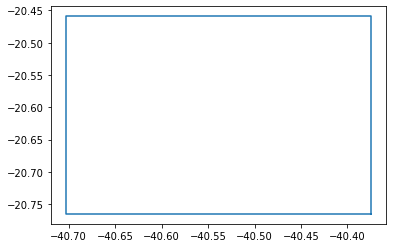

In [25]:
from matplotlib import pyplot

fig = pyplot.figure()
pyplot.plot(*bounding_box.exterior.xy)
pyplot.show()

In [17]:
layerlist = list(geobases.contents)

cesan_layers = [layername for layername in layerlist if 'cesan' in layername]

print(cesan_layers)

['geonode:asb_cesan_est_trat_esgoto_1712', 'geonode:asb_cesan_est_elev_agua_1712', 'geonode:asb_cesan_est_elev_esgoto_1712', 'geonode:asb_cesan_est_trat_agua_1712_1', 'geonode:asb_cesan_rotas_biossolido', 'geonode:asb_cesan_rede_coleto_esg_1712', 'geonode:asb_cesan_rede_agua_bruta_1712', 'geonode:asb_cesan_rede_agua_tratada_1712', 'geonode:asb_cesan_rede_emiss_agua_1712', 'geonode:asb_cesan_red_recalq_esgo_1712_1']


In [78]:
for i,layer in enumerate(cesan_layers):
    params = dict(service='WFS', version="1.0.0", request='GetFeature',typeName=layer, outputFormat='json')


    q = Request('GET', gb_wfs, params=params).prepare().url

    print(layer)

    # Read data from URL
    data = gpd.read_file(q)

    outname = layer.replace(':','') + '.csv'
    outname.replace("_",'')

    print(outname)

    print(data.shape)
    print(data.columns)
    print(str(data.geometry.iloc[0])[0:200])
    # data.head().to_csv(str(i)+'.csv')


geonode:asb_cesan_est_trat_esgoto_1712
geonodeasb_cesan_est_trat_esgoto_1712.csv
(53, 6)
Index(['id', 'fid', 'OBJECTID', 'NOME', 'STATUS_OP', 'geometry'], dtype='object')
MULTIPOLYGON (((366721.9895 7759175.5971, 366892.7231 7759228.2928, 367024.1366 7758812.2831, 367217.0762 7758871.3842, 367229.9966 7758821.9931, 367039.1345 7758764.6517, 367072.4666 7758658.7931, 36
geonode:asb_cesan_est_elev_agua_1712
geonodeasb_cesan_est_elev_agua_1712.csv
(152, 6)
Index(['id', 'fid', 'OBJECTID', 'NOME', 'STATUS_OP', 'geometry'], dtype='object')
MULTIPOLYGON (((364143.9697 7758010.7024, 364145.4867 7758010.0639, 364145.0881 7758009.3126, 364143.6619 7758009.971, 364143.9697 7758010.7024)))
geonode:asb_cesan_est_elev_esgoto_1712
geonodeasb_cesan_est_elev_esgoto_1712.csv
(287, 6)
Index(['id', 'fid', 'OBJECTID', 'NOME', 'STATUS_OP', 'geometry'], dtype='object')
MULTIPOLYGON (((365612.9292 7772574.1212, 365615.1636 7772576.512, 365617.9361 7772577.2954, 365620.2898 7772576.9044, 365622.8582 7772576.17

In [1]:
print({'sanitation':{}})

{'sanitation': {}}


In [1]:
import geopandas as gpd

In [3]:
test_gdf = gpd.read_file('https://ide.geobases.es.gov.br/geoserver/geonode/wfs?service=WFS&version=1.0.0&request=GetFeature&typeName=geonode%3Aidaf_limite_municipal_2018_11&outputFormat=json')

print(test_gdf.head())

                                id  FID_1             nome  cod_ibge  \
0  idaf_limite_municipal_2018_11.1    178         Colatina   3201506   
1  idaf_limite_municipal_2018_11.2    179       Marilândia   3203353   
2  idaf_limite_municipal_2018_11.3    107     Vila Valério   3205176   
3  idaf_limite_municipal_2018_11.4     99  Rio Novo do Sul   3204401   
4  idaf_limite_municipal_2018_11.5    101            Piúma   3204203   

     microestad macroestad       fonte              data     area_km2  \
0  Centro-Oeste    Central  IDAF/DTCAR   Outubro de 2017  1416.813167   
1  Centro-Oeste    Central  IDAF/DTCAR   Outubro de 2017   308.964824   
2  Centro-Oeste    Central  IDAF/DTCAR  Dezembro de 2016   470.206977   
3   Litoral Sul        Sul  IDAF/DTCAR  Dezembro de 2016   204.502044   
4   Litoral Sul        Sul  IDAF/DTCAR  Dezembro de 2016    73.940721   

         perim_m  percen_are                             origem  \
0  277032.278409    3.074037  Lei Estadual 10.752 de 19/10/20

In [5]:
test_gdf.loc[test_gdf['cod_ibge'].isin([3205309])] 

,id,FID_1,nome,cod_ibge,microestad,macroestad,fonte,data,area_km2,perim_m,percen_are,origem,regional,estrutura,esc_local,lei_criaca,geometry
47,idaf_limite_municipal_2018_11.49,147,Vitória,3205309,Metropolitana,Metropolitana,IDAF/DTCAR,Dezembro de 2016,86.328195,85924.981674,0.187305,Lei Estadual 10.600 de 15/12/2016,Vitória,Escritorio Central,,Lei 10.600 de 2016,"MULTIPOLYGON (((363834.815 7762611.303, 363859..."


In [6]:
test_gdf.empty

False